In [1]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense
from numpy import asarray
from matplotlib import pyplot

#from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import concatenate
import tensorflow as tf
import numpy as np
from math import sqrt
from matplotlib import pyplot as plt
import keras
from tqdm import tqdm as tqdm         # tqdm is a nice library to visualize ongoing loops
import datetime
#followint lines are used for indicative typing
from typing import Tuple
class Vector: pass
import tensorflow_probability as tfp

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Lambda
import pandas as pd
from tensorflow.keras.optimizers import Adam, SGD

2023-02-01 11:58:08.321386: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Model parameters
γ = 2.0 
α = 0.36
δ = 0.025
β = 0.99
τ = 0.2                      # Exogenous tax rate
ϕ = 0.975               # Borrowing constraint strictness

#Steady State
kss = (α/(1/β - 1 + δ))**(1/(1-α));
i_ss = δ*kss; 
imin = ϕ*i_ss;
kmin = 0.1*kss;
kmax =6*kss;

# Set global seed
tf.random.set_seed(42)
np.random.seed(42)
print(Kss)

NameError: name 'Kss' is not defined

In [164]:
initializer = tf.keras.initializers.GlorotUniform()

visible1 = Input(shape = (1,))
##c_high
interp_c_h_1 = Dense(32, input_dim=1, activation = 'tanh', kernel_initializer=initializer)(visible1)
interp_c_h_2 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_c_h_1)
interp_c_h_3 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_c_h_2)
interp_c_h_4 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_c_h_3)
interp_c_h_5 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_c_h_4)
output1 = Dense(1,activation=tf.keras.activations.linear)(interp_c_h_5)

##invst high
interp_i_h_1 = Dense(32, input_dim=1, activation = 'tanh', kernel_initializer=initializer)(visible1)
interp_i_h_2 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_i_h_1)
interp_i_h_3 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_i_h_2)
interp_i_h_4 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_i_h_3)
interp_i_h_5 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_i_h_4)
output2 = Dense(1,activation=tf.keras.activations.linear)(interp_i_h_5)

##mu high
interp_mu_h_1 = Dense(32, input_dim=1, activation = 'tanh',kernel_initializer=initializer)(visible1)
interp_mu_h_2 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_mu_h_1)
interp_mu_h_3 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_mu_h_2)
interp_mu_h_4 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_mu_h_3)
interp_mu_h_5 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_mu_h_4)
output3 = Dense(1,activation=tf.keras.activations.linear)(interp_mu_h_5)

##c_low
interp_c_l_1 = Dense(32, input_dim=1, activation = 'tanh', kernel_initializer=initializer)(visible1)
interp_c_l_2 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_c_l_1)
interp_c_l_3 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_c_l_2)
interp_c_l_4 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_c_l_3)
interp_c_l_5 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_c_l_4)
output4 = Dense(1,activation=tf.keras.activations.linear)(interp_c_l_5)

##invst low
interp_i_l_1 = Dense(32, input_dim=1, activation = 'tanh', kernel_initializer=initializer)(visible1)
interp_i_l_2 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_i_l_1)
interp_i_l_3 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_i_l_2)
interp_i_l_4 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_i_l_3)
interp_i_l_5 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_i_l_4)
output5 = Dense(1,activation=tf.keras.activations.linear)(interp_i_l_5)

##mu low
interp_mu_l_1 = Dense(32, input_dim=1, activation = 'tanh', kernel_initializer=initializer)(visible1)
interp_mu_l_2 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_mu_l_1)
interp_mu_l_3 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_mu_l_2)
interp_mu_l_4 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_mu_l_3)
interp_mu_l_5 = Dense(32, activation = 'tanh', kernel_initializer=initializer)(interp_mu_l_4)
output6 = Dense(1,activation=tf.keras.activations.linear)(interp_mu_l_5)

model = Model(inputs = visible1, outputs= [output5,output4,output6,output2,output1,output3])

In [1]:
## decision rule for z low
def dr_l(k):   

    # we normalze income to be between 0 and 1

    k = (k-kmin)/(kmax - kmin)*2.0-1.0
    x = model(k)

    invst_l = (x[0])**2
    ## Consumption has to be strictly positive, so I use exp activation function
    c_l = tf.exp(x[1])
    h_l = (x[2])**2 

    h_l = tf.reshape(h_l, [len(h_l)])
    c_l = tf.reshape(c_l, [len(c_l)])
    invst_l = tf.reshape(invst_l, [len(invst_l)])

    return(invst_l,c_l, h_l)

In [166]:
#decicion rule for z high   
def dr_h(k):    
    # we normalze income to be between 0 and 1
    k = (k-kmin)/(kmax - kmin)*2.0-1.0

    x = model(k)

    invst_h = (x[3])**2
    ## Consumption has to be strictly positive, so I use exp activation function
    c_h = tf.exp(x[4])
    h_h = (x[5])**2

    h_h = tf.reshape(h_h, [len(h_h)])
    c_h = tf.reshape(c_h, [len(c_h)])
    invst_h = tf.reshape(invst_h, [len(invst_h)])
    return(invst_h,c_h,h_h)


In [167]:
##Initial guesses of the policies 
kvec = np.linspace(kmin,kmax,129)
invst_l,c_l, h_l = dr_l(kvec)
invst_h,c_h,h_h = dr_h(kvec)

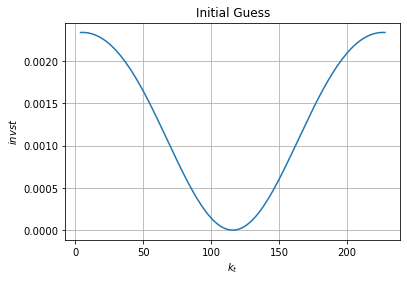

In [168]:
## plt.plot(kvec, kvec, linestyle='--', color='black')
plt.plot(kvec,invst_l)
#plt.plot(kvec,i_l_hat**2)
plt.xlabel("$k_t$")
plt.ylabel("$invst$")
plt.title("Initial Guess")
plt.grid()

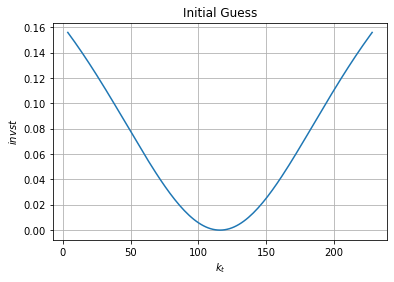

In [169]:
plt.plot(kvec,invst_h)
#plt.plot(kvec,i_h_hat**2)
plt.xlabel("$k_t$")
plt.ylabel("$invst$")
plt.title("Initial Guess")
plt.grid()


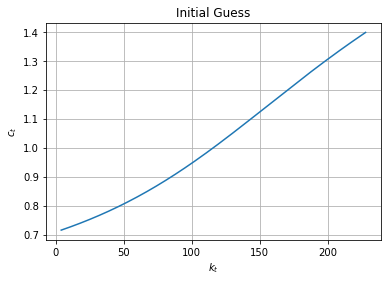

In [170]:
plt.plot(kvec,c_l)
#plt.plot(kvec,c_l_hat**2)
plt.xlabel("$k_t$")
plt.ylabel("$c_t$")
plt.title("Initial Guess")
plt.grid()


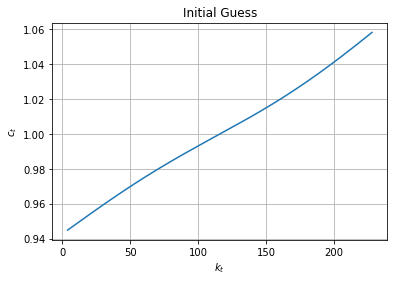

In [171]:
plt.plot(kvec,c_h)
#plt.plot(kvec,c_h_hat**2)
plt.xlabel("$k_t$")
plt.ylabel("$c_t$")
plt.title("Initial Guess")
plt.grid()

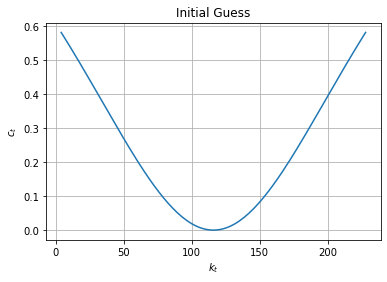

In [172]:
plt.plot(kvec,h_l)
#plt.plot(kvec,mu_l_hat**2)
plt.xlabel("$k_t$")
plt.ylabel("$c_t$")
plt.title("Initial Guess")
plt.grid()

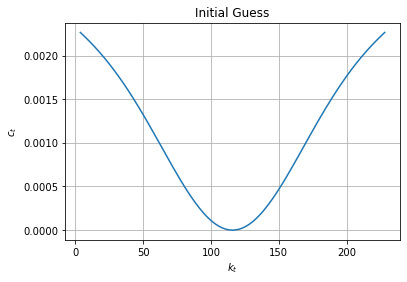

In [173]:
plt.plot(kvec,h_h)
#plt.plot(kvec,mu_h_hat**2)
plt.xlabel("$k_t$")
plt.ylabel("$c_t$")
plt.title("Initial Guess")
plt.grid()


In [174]:
##Value function iteration
def Residuals(k:Vector):#, z_h, z_l):

    invst_l, cnorm_l, h_l = dr_l(k)
    invst_h, cnorm_h, h_h = dr_h(k)
    

    Inv_h = invst_h + imin
    Inv_l = invst_l + imin


    knext_h = Inv_h + (1-δ)*k
    knext_l = Inv_l + (1-δ)*k
    
    ### investment, c, and mu next given the current state is low and the future state is low
    invst_l_next_l, cnorm_l_next_l, h_l_next_l = dr_l(knext_l)
 
    ### investment, c, and mu next given the current state is high and the future state is high
    invst_h_next_h, cnorm_h_next_h, h_h_next_h = dr_h(knext_h)
        
  
    ##Given that the current state is low, these are the investment,
    ##consumption, and mu when the future state is high
    invst_h_next_l,cnorm_h_next_l,h_h_next_l = dr_h(knext_l)
    
    ##Givent that the current state is high, these are the investment,
    ##consumption, and mu when the future state is low
    invst_l_next_h, cnorm_l_next_h, h_l_next_h = dr_l(knext_h)
       
    #R1 is euler equation
    #R2 is comp_slack
    #R3 is Resid
    
    R1_h =  1 - h_h - β*(0.7*(cnorm_h_next_h**(-γ))*((1.1*α*knext_h**(α-1)+1-δ) - h_h_next_h*(1-δ))
        + 0.3*(cnorm_l_next_h**(-γ))*(((1-τ)*0.9*α*knext_h**(α-1)+1-δ) - h_l_next_h*(1-δ)))/(cnorm_h**(-γ))

    

    R2_h = (h_h)*invst_h #*(cnorm_h**(-γ))

    R3_h = 1 - (Inv_h + cnorm_h)/(1.1*(k**α)) 

    R1_l = 1 - h_l - β*(0.7*(cnorm_l_next_l**(-γ))*((0.9*α*knext_l**(α-1)+1-δ) - h_l_next_l*(1-δ))
         + 0.3*(cnorm_h_next_l**(-γ))*(((1-τ)*1.1*α*knext_l**(α-1)+1-δ) - h_h_next_l*(1-δ)))/(cnorm_l**(-γ))

    R2_l = (h_l)*invst_l  #*(cnorm_l**(-γ))
    R3_l = 1 - (Inv_l + cnorm_l)/(0.9*(k**α)) 
    
    return( R1_h,R2_h,R3_h, R1_l,R2_l,R3_l)

In [175]:
def Ξ(n): # objective function for DL training
    ##Current state
    #z_1 = 1.1
    #z_2 = 0.9
    
    #k = np.linspace(kmin,kmax, n)
    k = tf.random.uniform(shape=(n,), minval=kmin, maxval=kmax)
    
    R1_h1, R2_h1, R3_h1,R1_l1, R2_l1, R3_l1 = Residuals(k)
    #,z_1,z_2)   

    # construct all-in-one expectation operator

    R_squared = R1_h1*R1_h1 + R2_h1*R2_h1 +  R3_h1*R3_h1 + R1_l1*R1_l1 + R2_l1*R2_l1 +  R3_l1*R3_l1
   
    return (tf.reduce_mean(R_squared))

In [176]:
n = 1000    
v = Ξ(n)
v.numpy()
v

<tf.Tensor: shape=(), dtype=float32, numpy=0.7798043>

In [177]:
θ = model.trainable_variables

print( str(θ)[:1000] )

[<tf.Variable 'dense_312/kernel:0' shape=(1, 32) dtype=float32, numpy=
array([[-0.0295743 , -0.3401453 ,  0.14475495, -0.05276349, -0.26602972,
        -0.31173652, -0.0797874 , -0.25855112, -0.1365878 , -0.11582834,
         0.20009232, -0.12412283, -0.06518072,  0.29446983, -0.00207451,
         0.2883808 ,  0.2557028 ,  0.11400574,  0.2942217 , -0.1276325 ,
        -0.02976277,  0.34196627, -0.01925468, -0.03539678,  0.18735641,
         0.425691  ,  0.2852307 , -0.20006242,  0.33812273, -0.12604171,
         0.36927807,  0.1765101 ]], dtype=float32)>, <tf.Variable 'dense_312/bias:0' shape=(32,) dtype=float32, numpy=
array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)>, <tf.Variable 'dense_306/kernel:0' shape=(1, 32) dtype=float32, numpy=
array([[ 0.38522047, -0.31876594, -0.3886951 , -0.0986385 ,  0.40097594,
         0.29578555, -0.32818556, -0.24404101,  0.37915128,  0.

In [178]:
variables = model.trainable_variables
optimizer = Adam(learning_rate=0.001)
#optimizer = SGD(learning_rate = 0.01)
#optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.005,epsilon=1e-08)
#optimizer = tf.keras.optimizers.Adamax(
#    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Adamax")
###Adadelta####
#optimizer = tf.keras.optimizers.Adadelta(
#    learning_rate=0.001, rho=0.8, epsilon=1e-07, name="Adadelta")

###Nadam###
#optimizer = tf.keras.optimizers.Nadam(
#    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Nadam")
###Adagrad###
#optimizer = tf.keras.optimizers.Adagrad(
#    learning_rate=0.01,
#    initial_accumulator_value=0.1,
#    epsilon=1e-07,
#    name="Adagrad")

In [179]:
@tf.function
def training_step():

    with tf.GradientTape() as tape:
        xx= Ξ(n) 
        xx = Ξ(n)
    grads = tape.gradient(xx, θ)
    optimizer.apply_gradients(zip(grads,θ))

    return (xx)

def train_me(K):

    vals = []
    for k in tqdm(tf.range(K)):
        val = training_step()
        vals.append(val.numpy())
        print(val.numpy())
    
    return vals

In [180]:
results = train_me(350000)

  0%|                                                                           | 14/350000 [00:03<17:28:42,  5.56it/s]

0.7682014
0.7175604
0.6701217
0.6389496
0.6122838
0.5640308
0.5261845
0.50507665
0.43922985
0.416469
0.48067644
0.3609849
0.29498187
0.26868877
0.2532072
0.2480225
0.22780824
0.23537259
0.25769556
0.24357553
0.22703156
0.22143275
0.1850927
0.15671323


  0%|                                                                            | 42/350000 [00:03<4:24:41, 22.04it/s]

0.14255679
0.12251544
0.110440895
0.099056974
0.09517691
0.08254868
0.09084797
0.070294924
0.08256145
0.058365125
0.056036536
0.04282129
0.045315858
0.03848102
0.04696525
0.03236187
0.041203428
0.031887762
0.040558837
0.036708307
0.036417734
0.04185108
0.042344477
0.039572023
0.042672276


  0%|                                                                            | 70/350000 [00:03<2:08:16, 45.46it/s]

0.042362235
0.03392534
0.027542932
0.03651544
0.028236488
0.02633152
0.022880645
0.022092728
0.030481923
0.026190644
0.021489002
0.020569183
0.022070346
0.017241543
0.02011052
0.018358514
0.01795621
0.023288859
0.01601257
0.014660156
0.020418847
0.0141023295
0.018509144
0.018359382
0.020110887
0.013836848


  0%|                                                                            | 99/350000 [00:04<1:18:42, 74.09it/s]

0.016981684
0.013986554
0.0135036465
0.013679896
0.014017743
0.019423317
0.013521917
0.016332805
0.014861534
0.016165625
0.014412802
0.013891622
0.0160885
0.015872337
0.011994149
0.013590174
0.017672127
0.015129877
0.015950538
0.01369542
0.010884024
0.015165597
0.010605526
0.017176343
0.014733934
0.015904909
0.011032662


  0%|                                                                            | 129/350000 [00:04<57:31, 101.36it/s]

0.013134403
0.012000824
0.011250795
0.013045564
0.010834948
0.016226085
0.011709162
0.016015785
0.012330368
0.012613415
0.008837039
0.014512514
0.010751633
0.013370879
0.014252607
0.01030998
0.0102446955
0.010932983
0.009237346
0.01084581
0.010049995
0.009801144
0.012592148
0.01425589
0.012508213
0.013202538
0.010556791


  0%|                                                                            | 144/350000 [00:04<52:09, 111.79it/s]

0.009625784
0.009204622
0.010220724
0.01209888
0.009472908
0.011437574
0.0076486426
0.008036054
0.008979932
0.006278793
0.009207032
0.00888716
0.0066400715
0.010109612
0.010079105
0.008446384
0.010489601
0.007898852
0.0074123256
0.0074625174
0.008924195
0.009867628
0.0082969945
0.005086143
0.008242277
0.0079644285
0.005930998


  0%|                                                                            | 174/350000 [00:04<46:13, 126.15it/s]

0.008121553
0.005698682
0.00930072
0.00701369
0.009652993
0.005506864
0.0051587904
0.006315182
0.009681511
0.008171802
0.005811075
0.006787499
0.005607794
0.0056409165
0.006049743
0.010757361
0.004324295
0.008136844
0.0076234457
0.006648019
0.007277321
0.0072176694
0.006321248
0.008363136
0.007841105
0.006209569
0.008186708


  0%|                                                                            | 204/350000 [00:04<44:19, 131.52it/s]

0.005514684
0.0072414875
0.0072256373
0.003913935
0.005077817
0.0074217855
0.0056826775
0.0060933465
0.005937661
0.008112203
0.005900931
0.0056964117
0.0076376325
0.005521182
0.0062851897
0.006366446
0.006049467
0.004792798
0.0056087216
0.0058525144
0.006217235
0.0065737492
0.006743453
0.0057320525
0.005429519
0.004801112


  0%|                                                                            | 232/350000 [00:05<43:32, 133.88it/s]

0.0037433316
0.007670914
0.003659709
0.0054366454
0.004938906
0.0042378064
0.004789074
0.0043743867
0.0055419835
0.004456219
0.00490525
0.0076810746
0.0031364479
0.0040223575
0.0049446016
0.0060745697
0.00604626
0.006951415
0.005338581
0.0060184784
0.005824984
0.0049897106
0.0037560305
0.0034238896
0.004271472


  0%|                                                                            | 246/350000 [00:05<43:13, 134.86it/s]

0.005039089
0.0050712065
0.0059306803
0.005299398
0.005745572
0.0038779287
0.0069059795
0.004455238
0.0045576612
0.0042641363
0.005935742
0.004131503
0.0037779927
0.0075263823
0.0047459556
0.0049518365
0.004296337
0.0058793104
0.0055770767
0.0051886956
0.0045705377
0.0030099207
0.0031581044
0.0036719856
0.0036772054
0.00501734
0.0036567354


  0%|                                                                            | 277/350000 [00:05<42:09, 138.25it/s]

0.005873636
0.0042489422
0.00423151
0.003719333
0.0052629
0.005005116
0.0028736142
0.0051388755
0.0040733195
0.0051644305
0.0029093958
0.0035721187
0.0056223124
0.004328238
0.0040617
0.002315311
0.0041754846
0.0037714648
0.0046944246
0.0051324903
0.004379521
0.003812148
0.0026191105
0.002491592
0.0034104032


  0%|                                                                            | 305/350000 [00:05<43:50, 132.96it/s]

0.004909237
0.0031793127
0.0048370934
0.0038509346
0.004386094
0.0048369803
0.005338679
0.004207762
0.005032894
0.004359063
0.0031298122
0.0036988684
0.0061303377
0.0040922994
0.0036418887
0.0026563234
0.003938843
0.0052084224
0.0031874029
0.0027038082
0.0032934963
0.002683482
0.0030969766
0.0033088939


  0%|                                                                            | 333/350000 [00:05<43:50, 132.93it/s]

0.002702886
0.0024433797
0.0025312162
0.0038107901
0.0044705654
0.0034900778
0.0032574476
0.0031174477
0.004278947
0.00282131
0.0036294297
0.0024778978
0.0036003827
0.0052698776
0.0037898764
0.0061777052
0.0032214546
0.004340503
0.0034365668
0.0031692442
0.0028408328
0.004164948
0.0025373213
0.003425475
0.0032465868


  0%|                                                                            | 362/350000 [00:05<42:32, 136.97it/s]

0.0036677537
0.0013800116
0.0027635598
0.0054027457
0.0039331466
0.0029304153
0.0030677088
0.0033255725
0.004706331
0.0034254584
0.0035972614
0.0031758475
0.0037507445
0.0019209983
0.0044148546
0.0040138853
0.0035315792
0.002243024
0.004011401
0.0034085095
0.0021420475
0.0030935463
0.004237058
0.0023527488
0.0033726615
0.0020950176
0.0038346415


  0%|                                                                            | 376/350000 [00:06<42:33, 136.89it/s]

0.0023263134
0.0026661723
0.0032007317
0.003916544
0.0033632484
0.002314838
0.0029038175
0.002863565
0.0020594
0.0030229297
0.0022512502
0.0029348303
0.0028266497
0.0024860282
0.0021649275
0.0031639535
0.0022153
0.0028557887
0.002594746
0.004851638
0.0035613147
0.0029710513
0.004488755
0.0023209094
0.002731625


  0%|                                                                            | 404/350000 [00:06<43:25, 134.17it/s]

0.0026160846
0.0024993948
0.0047655716
0.0029632458
0.002438167
0.0028086822
0.002143777
0.0020621251
0.0022948242
0.0033304705
0.0034794395
0.0035597223
0.0020435099
0.002216058
0.0023623114
0.0020907985
0.0018883216
0.0018527673
0.001681601
0.0023215772
0.0027826582
0.0033013448
0.0027933412
0.0030578186
0.0021194934


  0%|                                                                            | 433/350000 [00:06<42:43, 136.37it/s]

0.0020922394
0.0028201707
0.0034183345
0.004025517
0.0026061398
0.0025395963
0.0023723508
0.002708558
0.0018335446
0.0018063708
0.002157416
0.0020663657
0.0027401017
0.002837502
0.0018710211
0.003252817
0.002107058
0.0028426202
0.0024052449
0.0023174218
0.0017540436
0.0036633203
0.0025972282
0.0020715569
0.0025269198
0.002662485


  0%|                                                                            | 461/350000 [00:06<43:51, 132.83it/s]

0.0020414293
0.0017772503
0.0019861178
0.002487335
0.0033576328
0.0024033247
0.0017276251
0.0022691865
0.0020871984
0.003205813
0.0018999383
0.001897501
0.0021343979
0.0017014976
0.001667517
0.0015378897
0.0014867582
0.0020093848
0.0020468254
0.0021931808
0.002281261
0.002905396
0.002591884
0.0024044982


  0%|                                                                            | 475/350000 [00:06<44:06, 132.09it/s]

0.0018597107
0.0018680551
0.0021701793
0.0018081377
0.001869258
0.0017817952
0.001702068
0.0021885752
0.0020803155
0.0025430783
0.0018125519
0.0028271698
0.0009571178
0.0016241708
0.0017516739
0.0018158385
0.002081164
0.001881319
0.001457157
0.0023306892
0.0019039819
0.0024118624
0.0013703344
0.0024031277
0.0016385065


  0%|                                                                            | 503/350000 [00:07<43:17, 134.53it/s]

0.0024978614
0.0018710893
0.0014500539
0.0024800627
0.0022282891
0.0022649001
0.0016509094
0.0023198952
0.0027203488
0.0020383326
0.0016894728
0.0019076371
0.0022412124
0.0016491873
0.0015490447
0.0010121694
0.0023783508
0.0014144375
0.0022141307
0.0012978382
0.0017746382
0.0018930072
0.0023190489
0.0018198043
0.0024880895
0.002805965


  0%|                                                                            | 531/350000 [00:07<43:16, 134.61it/s]

0.0016050885
0.0018891337
0.0015979784
0.00129973
0.0019215352
0.00086354226
0.002134517
0.0011198282
0.0019437232
0.0012295693
0.0019269834
0.0017159171
0.0027141382
0.0010041951
0.0016794828
0.001079988
0.0018586878
0.0023872193
0.00088787335
0.0012949053
0.0012166015
0.0018458464
0.0024752985
0.0018817298
0.0013224725


  0%|                                                                            | 560/350000 [00:07<41:59, 138.71it/s]

0.0013084211
0.0014372563
0.00079947314
0.001267039
0.0010800135
0.0027689994
0.0010478379
0.0010857199
0.0014117968
0.0019161135
0.0012184517
0.0013658804
0.0011874659
0.0020520925
0.0016881113
0.0011433932
0.00089693215
0.0010523236
0.0011513885
0.0013136003
0.0011241446
0.0010686439
0.0011960693
0.0011833677
0.0010153734
0.0013157342
0.0016075198


  0%|▏                                                                           | 590/350000 [00:07<41:04, 141.78it/s]

0.00088226795
0.0007930226
0.001186483
0.0014104759
0.0009744948
0.0017720271
0.0013943515
0.0014221782
0.00079980894
0.00092277036
0.0010057027
0.00101854
0.0024154703
0.0011280136
0.0012516346
0.001033335
0.0014419482
0.0010517063
0.001259763
0.0018154178
0.00087761553
0.0008719834
0.001320765
0.0016233125
0.0009265848
0.0013934795
0.0012863469


  0%|▏                                                                           | 605/350000 [00:07<40:58, 142.10it/s]

0.0010252931
0.0013168817
0.001787956
0.0015751178
0.0015900922
0.0013717015
0.0015186031
0.0014237915
0.0014635532
0.0012860128
0.0012693885
0.0013597854
0.000911342
0.0012090213
0.0012801458
0.001663959
0.0014440768
0.0021412
0.0041569737
0.0036448366
0.002531765
0.0017103313
0.0012388587
0.0032353825
0.0021095949
0.0015452609


  0%|▏                                                                           | 635/350000 [00:07<41:26, 140.50it/s]

0.0023151853
0.0012302478
0.0007904471
0.0022932214
0.002054182
0.0012205548
0.0015123028
0.0011705197
0.0010668528
0.0020641638
0.0011149904
0.001222873
0.0011890832
0.0014256916
0.0014413056
0.00084033574
0.0009012436
0.0011277379
0.0011260037
0.0010699645
0.0008764471
0.0011954275
0.0008723012
0.0015580902
0.0007349403
0.0011314363
0.0010948759


  0%|▏                                                                           | 664/350000 [00:08<42:25, 137.26it/s]

0.0010605598
0.0007246126
0.0005959758
0.0011248129
0.0014561205
0.0009064373
0.00090131594
0.00065734575
0.0007935791
0.0013030269
0.0010744729
0.0014439054
0.00083420944
0.0008614663
0.0010638707
0.0010786562
0.0009196295
0.000709945
0.0012622911
0.000953896
0.00081384135
0.000653939
0.00041493142
0.00048862014
0.0013324998


  0%|▏                                                                           | 693/350000 [00:08<42:11, 137.99it/s]

0.0008529395
0.0012837714
0.0006069558
0.0014572339
0.0007769041
0.0010468693
0.0008273139
0.0011986465
0.0011303537
0.00100824
0.00084519025
0.0008501493
0.0012060852
0.0008807929
0.00093254034
0.0011554208
0.0007596259
0.0006210126
0.0005461847
0.0007322467
0.0010294447
0.0009203477
0.0007134765
0.00078402803
0.0007768262
0.0011228876


  0%|▏                                                                           | 721/350000 [00:08<42:28, 137.03it/s]

0.00080938445
0.00062286446
0.0008555195
0.0011879327
0.0006618595
0.0017579785
0.0010595476
0.0006688007
0.0012303018
0.0009610762
0.0009419991
0.0010275446
0.0007803431
0.0005860806
0.000577261
0.00054786896
0.00071022095
0.0010822939
0.0009026839
0.00075549557
0.00081871345
0.00096389005
0.0010061975
0.00055251457
0.000879851


  0%|▏                                                                           | 735/350000 [00:08<42:38, 136.54it/s]

0.0011603798
0.0010419271
0.00066745747
0.0012239177
0.0008198505
0.0005570354
0.0006127187
0.0006741276
0.0006890457
0.0015919663
0.0008021572
0.0013997088
0.0009932893
0.000927813
0.0008092863
0.0006969553
0.00093240174
0.0007509359
0.00057701266
0.0005574586
0.0006208052
0.00072187366
0.0010484669
0.00083736976
0.0008319176
0.0007741388


  0%|▏                                                                           | 763/350000 [00:08<42:57, 135.47it/s]

0.00063113915
0.0011873684
0.0006174227
0.0010763216
0.00075814826
0.0008577174
0.00071278494
0.00073379255
0.00084192754
0.0010117397
0.0010244293
0.00076515856
0.00050604844
0.00081296003
0.000530133
0.0004878303
0.00048040823
0.00038656523
0.0007560924
0.0007823367
0.00059377565
0.0010154201
0.0010198071
0.00085416675


  0%|▏                                                                           | 791/350000 [00:09<44:56, 129.52it/s]

0.0007060076
0.0008015585
0.0009283662
0.0011004118
0.0006195142
0.00059381645
0.0005544573
0.00063914165
0.0005540029
0.0008746103
0.0007972376
0.00061094156
0.0006305923
0.0005888805
0.00058673
0.00079189334
0.001039346
0.00092409714
0.0007723816
0.0007649982
0.0012829631
0.000672876
0.00073753466
0.00041756945


  0%|▏                                                                           | 818/350000 [00:09<45:41, 127.39it/s]

0.0006278185
0.00043936557
0.0011043574
0.00075532985
0.00053714257
0.000720211
0.00091183995
0.00078288995
0.0006826774
0.0006725322
0.0005892297
0.0005791596
0.0005981469
0.0011616527
0.0006611636
0.00071364344
0.00079845235
0.00074256747
0.00079962495
0.001079447
0.00067419535
0.00074084627
0.0005550156
0.0005922062
0.00050119334


  0%|▏                                                                           | 845/350000 [00:09<45:16, 128.55it/s]

0.00042320538
0.0004351629
0.0006045677
0.00046756628
0.00041817565
0.0007744122
0.0006115726
0.0008099034
0.0007152464
0.00048259148
0.00053217914
0.0007213395
0.0005051066
0.0009358208
0.0006038088
0.00085408986
0.00052776013
0.00050472555
0.00067294226
0.0009001054
0.0010276955
0.0007060507
0.00086351915
0.0008338392
0.0007197737


  0%|▏                                                                           | 859/350000 [00:09<44:50, 129.79it/s]

0.0007281144
0.00056036864
0.0004323825
0.0010751513
0.00043400645
0.0005891172
0.0007173435
0.0006187351
0.00045631235
0.00042072334
0.0005265166
0.00029539884
0.00044563337
0.00079454
0.00064839626
0.0008069978
0.0006300997
0.00087721384
0.00059102545
0.000297922
0.00087625626
0.00064515776
0.00085342006
0.0005201899


  0%|▏                                                                           | 887/350000 [00:09<44:16, 131.41it/s]

0.0005841422
0.0006675336
0.0010302205
0.000607799
0.0010565917
0.0010721018
0.001118784
0.0015204961
0.0010580139
0.00076802337
0.0004897502
0.00039881992
0.0002943233
0.0004826769
0.0007949178
0.0005166857
0.0007835797
0.0006101838
0.00067582424
0.00042245246
0.00036305477
0.00050981296
0.0006191339
0.0006934261
0.0006219778


  0%|▏                                                                           | 915/350000 [00:10<44:42, 130.14it/s]

0.0005762869
0.000636363
0.00054765114
0.0008723391
0.00058009673
0.00052379724
0.00067201676
0.0006915203
0.00053269934
0.0006080178
0.00077556504
0.0005938882
0.0005929653
0.00046441183
0.00058303296
0.0005515736
0.0007107613
0.0005715007
0.0008240678
0.00045653922
0.0005038102
0.0005971355
0.00067875086
0.00048641194


  0%|▏                                                                           | 943/350000 [00:10<44:01, 132.13it/s]

0.00070666586
0.00045313357
0.000513723
0.0004415493
0.00050465134
0.00028273647
0.0006710825
0.0004570089
0.00057680736
0.0004626177
0.00059142953
0.0007740099
0.00053563743
0.00025848162
0.0003285958
0.001020947
0.00081670156
0.0006450969
0.00074313395
0.0005323713
0.00044750332
0.000643916
0.00058941817
0.00060181046
0.0005123825
0.0005664128


  0%|▏                                                                           | 957/350000 [00:10<43:32, 133.60it/s]

0.00084876816
0.00055057195
0.0005054433
0.00068131386
0.0004884706
0.00049841404
0.0005372882
0.00033331636
0.0005126827
0.0005483171
0.0005048659
0.00046341945
0.0003638478
0.00030526155
0.0004105418
0.00044866494
0.00039020728
0.0003710297
0.00041752504
0.00051704084
0.0006320833
0.00034350547
0.00046661746
0.00066338596
0.00034808525
0.00036885685


  0%|▏                                                                           | 988/350000 [00:10<41:26, 140.38it/s]

0.00034994129
0.00031076014
0.00055974035
0.0005999988
0.000525843
0.00040791422
0.00042412253
0.00047370716
0.00055855734
0.00041014544
0.0005257535
0.00034461176
0.0002815904
0.0004412791
0.00036768048
0.00026881072
0.00033427973
0.00038523148
0.00045799965
0.00037574678
0.00041000047
0.0004440894
0.00032847273
0.0005385963
0.00049177033
0.00045305587
0.0007405075


  0%|▏                                                                          | 1018/350000 [00:10<42:49, 135.80it/s]

0.00051190425
0.0006446389
0.0007268678
0.00088325335
0.00071057
0.0009397098
0.0008297775
0.0006561066
0.0006908598
0.0004298577
0.0004304612
0.0004019072
0.0005106099
0.0005233061
0.0006235021
0.0005922132
0.00047584128
0.0005240963
0.00042064727
0.00065227604
0.00032244538
0.0005024387
0.000396099
0.00054336153
0.00030986845


  0%|▏                                                                          | 1046/350000 [00:11<43:19, 134.23it/s]

0.00041086876
0.00031929027
0.0004428073
0.0003454358
0.0004730451
0.00029857978
0.00029639716
0.00041983448
0.00037162015
0.00034662054
0.00044673664
0.00026902606
0.00033039233
0.00028559446
0.00050965603
0.0003027558
0.00043268775
0.00048957474
0.00029172376
0.00046693266
0.00032219238
0.00042364956
0.00054948474
0.00047615345


  0%|▏                                                                          | 1060/350000 [00:11<43:28, 133.79it/s]

0.0003421861
0.0004961831
0.00045760398
0.0007098121
0.00078764616
0.0006909175
0.0008137987
0.0011306815
0.0011358295
0.0014196789
0.0017106879
0.0012204943
0.0007046314
0.00041294622
0.0004295333
0.00069649564
0.000866449
0.0009231332
0.0007487812
0.00038448887
0.00050843303
0.00044873494
0.000769909
0.0004826978
0.00046453477
0.0004007286
0.00027840346
0.0003932905


  0%|▏                                                                          | 1092/350000 [00:11<40:48, 142.52it/s]

0.0007894314
0.00062877155
0.0007508708
0.0003445938
0.00024424173
0.0004926246
0.0004319909
0.00047755172
0.0006815996
0.0004810072
0.0003519039
0.0006249355
0.00034253043
0.0003351438
0.00053990213
0.0003739046
0.00034291728
0.00022823739
0.00048232303
0.00040788852
0.00040369312
0.00035492203
0.00030915905
0.00032650746
0.00020046785
0.00032339877


  0%|▏                                                                          | 1122/350000 [00:11<41:01, 141.75it/s]

0.00031947673
0.00028953434
0.00029449761
0.00025160363
0.00032473129
0.00044669423
0.00029079523
0.00036787754
0.00040909403
0.0003690578
0.00024583
0.00033949674
0.0003093564
0.00022301055
0.000379163
0.00025871597
0.00016991225
0.00038328744
0.0002540027
0.00039337797
0.00045637696
0.00038781954
0.00022213798
0.0004997501
0.00036897484
0.00023544763
0.00030418776


  0%|▏                                                                          | 1153/350000 [00:11<40:53, 142.20it/s]

0.0002887441
0.0002038672
0.00032302842
0.00017171567
0.0002277276
0.000392128
0.00034323896
0.00020534961
0.0004706024
0.00032166642
0.0003712568
0.00035368538
0.00029692226
0.00031584842
0.00041287465
0.0003601667
0.00030822473
0.00027544994
0.00027727414
0.0005701125
0.00024523627
0.00022768864
0.0006265696
0.00043215023
0.00046953902
0.00037895626
0.00031684857


  0%|▎                                                                          | 1168/350000 [00:11<42:36, 136.46it/s]

0.00034033018
0.00028495167
0.0003510349
0.0002312961
0.00022891903
0.00033979982
0.00028008188
0.00036144606
0.00030998146
0.0002979465
0.00030851533
0.0003618468
0.00031503127
0.0004423747
0.00039261018
0.0002746334
0.00042729257
0.00028281155
0.0003369061
0.0003651736
0.0002447794
0.00021082662
0.00021067467
0.0003155826
0.00025395464


  0%|▎                                                                          | 1196/350000 [00:12<43:46, 132.79it/s]

0.00017705285
0.00022387426
0.00030383977
0.00030504807
0.00038277853
0.0003067099
0.0006496465
0.00045330657
0.00044240683
0.0005251061
0.00051298353
0.00064846495
0.00077297667
0.0008150338
0.00084328826
0.0009992066
0.00081279577
0.0008093365
0.00048246287
0.00052718766
0.00021358169
0.0002565393
0.00057896937
0.0006643749


  0%|▎                                                                          | 1224/350000 [00:12<44:20, 131.08it/s]

0.00060884113
0.00053714187
0.0005049349
0.00025398924
0.00044309854
0.00028601862
0.00031536596
0.0004524942
0.00048169788
0.000361638
0.00033493852
0.0003112722
0.0003102876
0.0005025822
0.00039119358
0.00025416823
0.00042856068
0.0002943967
0.0005059976
0.00045312464
0.0004939413
0.0002692796
0.00034354732
0.0002892585
0.0003189392


  0%|▎                                                                          | 1252/350000 [00:12<44:37, 130.24it/s]

0.00023711479
0.00025411678
0.00029265584
0.000296225
0.00019398573
0.00022448674
0.00037734926
0.00026286958
0.00023688347
0.00035389815
0.00019353577
0.0002948203
0.00028928326
0.00019009328
0.00018018948
0.00030957634
0.00016709053
0.00034610336
0.00013246956
0.0003904643
0.00018508978
0.00024161156
0.00021895154
0.0002712639


  0%|▎                                                                          | 1266/350000 [00:12<44:09, 131.64it/s]

0.0002784732
0.00022224622
0.00027495442
0.00020206496
0.0003595236
0.00031977167
0.00028373982
0.0001457242
0.00026008865
0.00012265235
0.0002996738
0.00022634829
0.00021685957
0.00024321678
0.00021454641
0.00016595137
0.00029007002
0.00033252817
0.00038336872
0.00022028253
0.00027222803
0.00024102214
0.00035087668
0.0005628272


  0%|▎                                                                          | 1293/350000 [00:12<46:03, 126.16it/s]

0.0005848839
0.0006307052
0.00066084176
0.00062947464
0.00062626443
0.0004701824
0.00032840812
0.00017479996
0.00034374674
0.0001927075
0.00029679952
0.00032403998
0.0003349865
0.0005329734
0.00035601063
0.0006021029
0.00036662715
0.00039200843
0.00027960583
0.00036035888
0.00025626892
0.00028577453
0.0001994702


  0%|▎                                                                          | 1322/350000 [00:13<44:21, 131.02it/s]

0.00021996998
0.00033492933
0.0002534882
0.0004520757
0.0002693282
0.00030056492
0.00021747827
0.00026807183
0.00019171313
0.00035567762
0.00025367452
0.00013030844
0.00022052413
0.00020404789
0.00029536302
0.00017170406
0.0002842574
0.00010274058
0.00014488693
0.00022768418
0.0002526683
0.00018768967
0.00025602747
0.0003782761
0.00016508358
0.0003079414


  0%|▎                                                                          | 1337/350000 [00:13<43:19, 134.11it/s]

0.0002279094
0.00025578632
0.0002545805
0.00018147493
0.00028976827
0.00026065783
0.00021816917
0.0003004054
0.00026530682
0.00022606958
0.00016913569
0.0002701369
0.00044483665
0.00020086006
0.00033676167
0.00030574386
0.00033863296
0.00026921052
0.00015572336
0.0001775948
0.00016281725
0.0003177756
0.00036137222
0.00036043054
0.0004141396
0.00044128965


  0%|▎                                                                          | 1366/350000 [00:13<42:55, 135.37it/s]

0.00049843546
0.0007004239
0.001017504
0.0010057015
0.0011300459
0.001090031
0.0009302786
0.0008443462
0.00037688733
0.00022502129
0.00021698535
0.00031180703
0.0005538328
0.00034698696
0.0005182429
0.00043840928
0.00018529086
0.00017606711
0.00024930376
0.00033431902
0.00022621904
0.00026879465
0.00024569177
0.00022794343
0.00016668632


  0%|▎                                                                          | 1394/350000 [00:13<43:42, 132.94it/s]

0.00015556198
0.00021275645
0.00023693962
0.00024436024
0.00026635945
0.00018407592
0.00020928476
0.0001849167
0.00017556819
0.00016988722
0.00013657432
0.00018001291
0.00022447175
0.0001957185
0.00012748552
0.00011536314
0.00018270285
0.00013371934
0.00011570147
0.00020789194
0.00017079386
0.00029294167
0.0002439503
0.0001886861
0.00014113513


  0%|▎                                                                          | 1422/350000 [00:13<43:55, 132.24it/s]

0.00013593132
0.00027488964
0.00023871998
0.00013477774
0.00016648407
0.00029523915
0.00022182944
0.00023371624
0.00014545313
0.00022010595
0.0002748158
0.00017052505
0.00017898908
0.0003470018
0.00024491415
0.0003020712
0.00024237778
0.00029698826
0.00015447129
0.0001849341
0.0002861137
0.00025062147
0.00023420328
0.0002752893


  0%|▎                                                                          | 1436/350000 [00:13<45:11, 128.53it/s]

0.00022758082
0.0002573766
0.0001711953
0.00032616503
0.00012874998
0.00021319416
0.000266842
0.00021169246
0.00015139146
0.0002662399
0.0002220197
0.00015073773
0.0001807233
0.00023795207
0.00012237014
0.0001612865
8.52461e-05
0.00015894779
0.0001222033
0.0001715532
0.00021659848
0.00048461597
0.00043683324


  0%|▎                                                                          | 1462/350000 [00:14<46:46, 124.19it/s]

0.0005000448
0.00057491136
0.0007556201
0.0006209352
0.00042138642
0.0003844738
0.0002976476
0.00038080907
0.0002210929
0.00019722068
0.0002753991
0.00025535582
0.0001977281
0.00019278031
0.000100115714
0.00016437825
0.00023579759
0.00024704132
0.00014831932
8.446341e-05
0.00019806228
0.00018529141
0.00025939586
0.00015590886
0.00017928619


  0%|▎                                                                          | 1490/350000 [00:14<44:56, 129.25it/s]

0.00028243108
0.00024579625
0.00016775071
0.00015952557
0.00019470941
0.00020354672
0.00020045358
0.000244981
0.00030636473
0.0003497221
0.00037223042
0.00032907535
0.00040777668
0.00071554293
0.0005208777
0.0005905125
0.00056322635
0.00048844155
0.0003443451
0.00040621613
0.00024824895
9.948975e-05
0.000110596506
0.00014514811
0.0001784607


  0%|▎                                                                          | 1517/350000 [00:14<44:55, 129.30it/s]

0.00019192169
0.00017985387
0.0002035819
0.0002395705
0.00021006682
0.00029642181
0.00022427953
0.00026148278
0.0001642018
0.00018876085
0.00015779122
0.00025168547
0.00011211984
0.00021014214
0.00014497986
0.00015140134
0.0002300117
0.00016395113
0.00019679278
0.00017509493
0.00021840783
0.00019677558
0.0001922969
0.00026275078


  0%|▎                                                                          | 1544/350000 [00:14<45:00, 129.05it/s]

0.00019201529
0.00018135109
0.000155909
0.00022004168
0.00018568701
0.00019396281
0.00023478799
0.00025429187
0.0002060195
0.00028516992
0.00029116
0.00043073297
0.000385498
0.00048321366
0.00044006718
0.0004884547
0.00051118736
0.00040757953
0.0003223602
0.0003506118
0.00027742414
0.00025511096
0.00020579217
0.00017667329
0.00014245305


  0%|▎                                                                          | 1559/350000 [00:14<43:37, 133.10it/s]

0.00019634474
0.000121610334
0.00017282707
0.00016944492
0.0002859664
0.0002507984
0.0001515284
0.0002018937
0.00013596016
0.00020485539
0.00016555487
7.8482284e-05
0.00017193642
0.00013105919
0.00013359303
9.911184e-05
6.577727e-05
5.0037823e-05
0.00012648627
0.00018140054
0.00020506089
0.0001481753
0.00025290585
0.00028801966
0.00016569124
0.00017149742


  0%|▎                                                                          | 1590/350000 [00:15<42:11, 137.63it/s]

0.0002151942
0.0002919212
0.00022908226
0.0002538163
0.00034464028
0.00037686242
0.0003304001
0.00033317824
0.00052723504
0.00042834188
0.0004706445
0.00046508192
0.00038479723
0.00038451958
0.0003351548
0.00017004633
0.00022464978
0.00042809942
0.00036361616
0.00058208546
0.000611922
0.00067599677
0.0003568711
0.00058899034
0.00058488204
0.0002801025
0.00032208543


  0%|▎                                                                          | 1620/350000 [00:15<41:39, 139.39it/s]

0.0005487594
0.00045374656
0.0005776253
0.0005681788
0.000255559
0.00016901856
0.00016059518
0.0001802465
0.00031290148
0.000290552
0.0003834236
0.0002742392
0.00016813398
0.00029528217
0.00020523327
0.00017298308
0.00017458151
0.0002138112
0.00021757254
0.00017280944
0.00020587444
0.0001331384
0.0001745275
0.00014337763
0.00013139968
0.00026469756


  0%|▎                                                                          | 1650/350000 [00:15<41:00, 141.58it/s]

0.00019212297
0.00013045994
0.00010549326
0.000139921
7.956694e-05
0.000187169
0.00025964045
0.00016782028
0.00017953497
0.00020741153
0.000113319504
9.6136464e-05
0.000115936346
0.00012823516
0.00012874034
8.712727e-05
0.00023770671
0.00014677396
0.000116050614
9.5459494e-05
0.00016344544
5.54257e-05
0.0001676432
0.00015251
0.00012501785
0.0001264739
0.00015903276


  0%|▎                                                                          | 1681/350000 [00:15<41:09, 141.02it/s]

6.3623265e-05
0.00015700141
0.00021501674
0.0001435063
0.00018704242
0.00025359952
0.00015948179
0.00020272842
0.00012836324
8.143668e-05
6.131343e-05
8.703063e-05
0.00015517067
0.0001228572
6.947136e-05
0.00014504588
7.62973e-05
0.00012612579
6.047418e-05
0.00014676001
8.173658e-05
0.00012463037
8.6379325e-05
0.00010372068
0.00010223633
0.00019305112
0.00014244604
0.00015104818


  0%|▎                                                                          | 1696/350000 [00:15<41:11, 140.93it/s]

0.000154426
0.00010948126
0.00020203403
0.00020968693
9.842285e-05
0.0001390039
0.00015104955
7.774954e-05
8.707265e-05
0.00022049683
0.00012978398
0.000108531174
0.00013072045
0.0001952694
0.00013066581
0.00017975361
0.00011213603
0.00020271844
0.00024480186
0.00017693118
0.00021716705
0.00018730237
0.00023579162
0.00026836293
0.00020823764
0.00042571544
0.00046224945


  0%|▎                                                                          | 1725/350000 [00:16<43:18, 134.02it/s]

0.00043596927
0.0006470439
0.0006958939
0.00090607407
0.0010476562
0.0013502345
0.0012512667
0.0014162159
0.00097167055
0.00040730537
0.0003369339
0.00023211393
0.00030003767
0.00071780226
0.00045026542
0.0001529532
0.00035748724
0.0002881523
0.00031194123
0.00019972504
5.4275642e-05
0.00037884546
0.0003730627


  1%|▍                                                                          | 1753/350000 [00:16<43:04, 134.75it/s]

0.00033802766
0.00050390774
0.00044395676
0.00024755843
0.0005443757
0.00060319516
0.0001311529
0.00059128006
0.00017740091
0.00041874943
0.00031470717
0.00030063334
0.0004060745
0.00014083799
0.0004153644
0.00025346054
0.0002511427
0.00036286586
9.434311e-05
0.00030904246
0.00030632416
0.00025148428
0.00034708346
0.00017118985
0.00014240446
0.00020139739


  1%|▍                                                                          | 1781/350000 [00:16<42:52, 135.35it/s]

0.00024567053
0.00028545424
0.0002591282
0.00026490033
0.00024290197
7.1349226e-05
0.000107299966
0.00021319784
0.00019607258
0.0001731962
0.0001566588
0.00010982397
0.00022864755
0.00017179457
0.00011504748
0.00015103116
0.00010393733
0.00019153826
0.000113980976
0.000108245535
0.00020152642
0.00017977269
0.00011491486
0.0001485948
0.0002987833


  1%|▍                                                                          | 1796/350000 [00:16<42:22, 136.96it/s]

0.0001335927
0.0002663151
0.00022373516
0.00015381169
0.00016178416
0.00016963354
0.00011845097
0.00013017976
0.00023242785
0.00027885492
0.00020344493
0.00012188297
6.454696e-05
0.00016294443
0.00019420845
0.00019820199
0.00020136443
0.00014630973
0.00010829908
8.224589e-05
0.00019973627
0.00014958106
0.00015926397
0.00021867942
0.00018995044
0.000117715135
8.0129954e-05


  1%|▍                                                                          | 1826/350000 [00:16<41:15, 140.67it/s]

0.000117214935
0.00018751132
0.0001353565
0.00017394629
8.03811e-05
0.000104953724
0.00013663701
7.451645e-05
0.00010025989
0.00012141552
0.000114453214
8.869744e-05
0.0001458597
0.0001136388
9.210543e-05
0.0001507203
0.00011728571
6.85875e-05
0.0001864898
0.00016869628
0.000111412766
5.6076955e-05
9.104446e-05
0.00012554055
0.00011722924
0.000107558975
0.00011285582


  1%|▍                                                                          | 1856/350000 [00:17<40:54, 141.81it/s]

0.00011184159
0.00013174149
8.061332e-05
6.0859697e-05
8.742199e-05
0.00012655082
6.8780406e-05
6.9011985e-05
8.818087e-05
0.00013192037
0.00013363354
8.945039e-05
0.00012632448
9.573079e-05
0.0001225636
6.257507e-05
0.00010878359
8.541262e-05
5.09484e-05
0.00010399857
6.797689e-05
9.823339e-05
9.839703e-05
7.280753e-05
0.00016674135
8.95789e-05
7.3557676e-05


  1%|▍                                                                          | 1885/350000 [00:17<43:14, 134.17it/s]

0.00013457645
6.439622e-05
0.00016206971
0.000112197784
0.00011445715
7.450269e-05
7.558667e-05
9.4783914e-05
5.138653e-05
6.490348e-05
5.0370036e-05
0.00013515554
9.469823e-05
0.00010389102
0.00014762879
0.0001310391
0.00023477759
0.0002590594
0.0003678653
0.0003719155
0.00046754026
0.00046959927
0.0005195258


  1%|▍                                                                          | 1899/350000 [00:17<44:02, 131.72it/s]

0.0006068344
0.00062625227
0.00054418226
0.000605265
0.00022787672
0.00034222292
0.00020058373
0.00015086823
0.00021074447
0.00030742981
0.00027759757
0.00040767752
0.00043829696
0.0004301608
0.00074783596
0.0007835768
0.0006719975
0.0004828711
0.00022188928
0.00019560181
0.00014938184
0.00013260913
0.00031714677
0.00034554995


  1%|▍                                                                          | 1927/350000 [00:17<44:15, 131.10it/s]

0.00036641705
0.00036747134
0.0002556979
0.00030738933
8.6898544e-05
0.00032443056
0.00034969478
0.00031359505
0.00038997788
0.00022007512
0.00017904896
0.0002321227
8.920038e-05
0.00028216076
0.00027644372
0.00020807423
0.00027937148
0.00016550568
0.000106557236
9.342893e-05
8.345906e-05
0.00013295794
0.00013020149
9.345453e-05
0.00013355416


  1%|▍                                                                          | 1955/350000 [00:17<43:26, 133.51it/s]

0.00010291966
9.428252e-05
7.683872e-05
0.00012369084
9.821254e-05
0.000112795664
7.94031e-05
0.00013776428
0.00010677326
6.370118e-05
0.000106949214
6.679784e-05
6.256568e-05
0.00014610976
0.000120093464
6.127703e-05
8.953828e-05
8.439461e-05
0.0001330874
7.899171e-05
8.806655e-05
0.00018532276
0.00012647135
0.00010415627
0.00011651966


  1%|▍                                                                          | 1984/350000 [00:18<42:25, 136.72it/s]

8.318875e-05
0.00011914129
0.00013170128
4.2265983e-05
8.279061e-05
8.632314e-05
0.000106069194
0.000106072795
0.0001408961
9.939757e-05
6.136096e-05
8.862544e-05
0.00012938451
0.000107062566
6.888518e-05
0.00011032199
6.177604e-05
7.546332e-05
5.878861e-05
0.00011525135
6.545748e-05
9.796086e-05
9.403311e-05
0.00014567318
7.595899e-05
9.0441376e-05
9.4714145e-05


  1%|▍                                                                          | 2014/350000 [00:18<41:08, 140.97it/s]

7.199379e-05
0.00010341804
0.000105440544
8.9516296e-05
6.188707e-05
7.550209e-05
0.00012291725
0.00010854007
0.00011575456
9.093255e-05
0.00012262102
6.846451e-05
5.2890395e-05
0.00012207533
8.40655e-05
4.8501282e-05
7.94563e-05
0.000106382424
0.00012680556
7.6553726e-05
9.0154186e-05
0.000102783146
0.00013052249
9.996663e-05
0.000101516416
4.732884e-05
0.00017059392


  1%|▍                                                                          | 2029/350000 [00:18<41:02, 141.32it/s]

0.00014687073
0.000107932356
0.00013787669
0.00011965371
0.00014405041
0.00024691995
0.00024040576
0.00025952113
0.00037994652
0.00046524953
0.000566414
0.00070043455
0.00074680673
0.0009808154
0.0009375773
0.001040539
0.00088102755
0.0008177067
0.0005044527
0.00030307288
0.0001373972
0.00016139032
0.00022285657
0.0002999039
0.00035527055
0.00032927227
0.0002634483


  1%|▍                                                                          | 2059/350000 [00:18<40:59, 141.45it/s]

0.00015607412
0.00015811308
0.00023806137
0.00030708552
0.00034663777
0.0002783272
0.0001525056
0.00018000511
0.00014209039
0.00012781471
0.00021908003
0.0002487763
0.0002423131
0.00022399842
0.00017794484
0.00013365355
0.00021173495
0.00022341419
0.00026349933
0.00023331797
0.00021042115
0.0001375592
0.00015856199
4.601431e-05
0.00011547643
0.00013766364


  1%|▍                                                                          | 2089/350000 [00:18<40:40, 142.58it/s]

0.00015249857
0.00012002409
0.000115932184
0.00010671413
0.00011263183
0.00014278892
0.0001718657
0.00015397629
0.00015076378
7.0170165e-05
0.00012374346
0.00016202012
9.92702e-05
0.00015488996
0.0001460076
0.00015007168
0.00013456194
0.000104578285
8.5472675e-05
7.607863e-05
7.90633e-05
0.00016126088
0.00018972483
8.313292e-05
0.00010053924
7.584447e-05
9.722594e-05


  1%|▍                                                                          | 2119/350000 [00:18<42:13, 137.31it/s]

5.159191e-05
5.9586615e-05
9.394167e-05
0.00011020129
0.000120857934
8.094658e-05
8.9774534e-05
8.1190396e-05
8.109345e-05
0.00013189146
7.307464e-05
8.4733474e-05
0.00013351173
9.4961244e-05
0.0001391381
0.00010271213
9.287246e-05
0.000103450366
0.00010006364
7.840769e-05
8.5302665e-05
9.3751034e-05
0.00012436743
7.367717e-05
0.0001413264


  1%|▍                                                                          | 2133/350000 [00:19<43:22, 133.67it/s]

9.4677904e-05
7.619747e-05
9.154711e-05
9.582831e-05
0.00013979748
7.5549724e-05
0.00012571143
0.00012258835
0.00011188586
0.00017521894
0.00011798845
9.816034e-05
6.842212e-05
8.150056e-05
5.6370747e-05
0.00011992895
9.801412e-05
7.420985e-05
7.841459e-05
5.5150904e-05
5.203884e-05
5.2819687e-05
4.989926e-05
4.016219e-05


  1%|▍                                                                          | 2161/350000 [00:19<44:42, 129.69it/s]

9.1866765e-05
9.9734214e-05
7.976687e-05
7.574974e-05
7.0183734e-05
6.0619957e-05
5.366449e-05
0.0001470513
0.0001266137
8.857857e-05
0.0001270892
0.00019150402
0.00017341929
0.00016838849
0.00023534829
0.0003659095
0.0003662248
0.00030104013
0.0005622166
0.0005082358
0.00083568104
0.0008704396
0.0007283287
0.0007069154
0.00074807287


  1%|▍                                                                          | 2189/350000 [00:19<43:29, 133.26it/s]

0.0003544968
0.0004708258
0.00026973433
0.00016419291
0.00061167375
0.0006243803
0.00082218787
0.00066156354
0.0004681543
0.00023720147
0.00015676263
0.00015475658
0.00022617054
0.0003924396
0.00042368393
0.00030655516
0.00017869276
9.5338146e-05
8.917794e-05
0.00013107622
0.00024723966
0.00023482885
0.00020663434
0.0001395475
8.303345e-05
0.00010912528


  1%|▍                                                                          | 2217/350000 [00:19<43:46, 132.39it/s]

0.00018804168
0.00019748282
0.0001933363
0.00014955965
9.306607e-05
7.2122115e-05
8.486386e-05
0.00012325605
0.00014816903
9.977552e-05
0.0001512603
0.00014882546
0.00013979644
8.884609e-05
0.00012156462
0.00012842327
0.00013290632
0.00010773499
9.457849e-05
7.196075e-05
9.3148636e-05
9.965508e-05
0.00012910158
0.00012013693
9.046206e-05


  1%|▍                                                                          | 2245/350000 [00:19<44:39, 129.81it/s]

6.607825e-05
6.7254856e-05
8.627437e-05
8.661367e-05
7.4395815e-05
0.00010680982
7.312624e-05
9.333864e-05
0.000113041584
8.4466206e-05
0.00010333774
9.0695794e-05
0.00010815944
5.135841e-05
5.2676474e-05
5.3169835e-05
8.799184e-05
0.00014773087
6.336863e-05
7.11526e-05
9.08779e-05
7.1730385e-05
0.00011171381
4.495649e-05
9.5592884e-05
9.469861e-05


  1%|▍                                                                          | 2259/350000 [00:20<44:30, 130.22it/s]

0.00010988143
0.000115231705
7.9270525e-05
7.187523e-05
5.5319815e-05
0.000100495585
8.826451e-05
4.479304e-05
9.7651726e-05
0.00010668167
4.455357e-05
7.431898e-05
0.00017864727
0.00011426404
0.00012285802
0.00012856418
8.252366e-05
7.164465e-05
0.00010040453
0.00013803648
5.34655e-05
9.5723735e-05
0.000113293616
6.900616e-05


  1%|▍                                                                          | 2286/350000 [00:20<44:48, 129.36it/s]

3.5603458e-05
7.796711e-05
0.00012643843
0.00011391063
9.365356e-05
0.00012403126
8.753869e-05
6.0674e-05
7.420289e-05
5.5410244e-05
5.8911286e-05
7.180235e-05
6.3513784e-05
7.348985e-05
0.00011064908
5.712018e-05
7.505071e-05
9.606351e-05
7.744054e-05
9.4615476e-05
5.984762e-05
5.8656213e-05
0.00010212269
8.591344e-05


  1%|▍                                                                          | 2315/350000 [00:20<42:56, 134.94it/s]

5.244612e-05
6.211212e-05
6.887771e-05
0.00010498455
0.000104053004
8.23964e-05
9.199852e-05
0.00017083294
0.00010556485
8.0986116e-05
9.536972e-05
8.552273e-05
0.00010015498
9.5172334e-05
0.00010974351
0.00012044536
8.743307e-05
6.649511e-05
0.00011683261
0.00015000736
0.00012540746
0.00018288668
0.00018686717
0.00023064623
0.00024177428
0.00020652324
0.00023225285


  1%|▌                                                                          | 2345/350000 [00:20<41:44, 138.83it/s]

0.00021453184
0.00030152698
0.00032687074
0.00038927794
0.00041675006
0.00051390444
0.0004970111
0.00047203514
0.00036396686
0.00029391568
0.00013426774
0.00014287299
8.349691e-05
0.00011219017
0.00020656489
0.00027381652
0.00030606263
0.00044855993
0.0005166823
0.00052918005
0.0005443997
0.0003389148
0.00020844954
0.00012229504
0.00013028398
8.9323104e-05
9.281981e-05


  1%|▌                                                                          | 2360/350000 [00:20<41:27, 139.76it/s]

0.00013305547
0.00012630096
0.00011151301
0.00010888955
6.986124e-05
8.55191e-05
6.727313e-05
9.3250834e-05
7.4255615e-05
7.8689074e-05
7.871631e-05
6.704471e-05
9.1977745e-05
0.000110455585
9.992237e-05
8.3094485e-05
8.2706974e-05
0.0001361812
7.821083e-05
0.00011276869
7.843302e-05
9.604612e-05
5.9766233e-05
9.862044e-05
9.840712e-05
0.00010103977


  1%|▌                                                                          | 2388/350000 [00:21<41:39, 139.10it/s]

9.355633e-05
0.00010368212
7.688983e-05
0.00010177804
7.0455375e-05
4.9194074e-05
7.5438336e-05
7.472551e-05
5.2869655e-05
7.581833e-05
9.457902e-05
6.5999346e-05
0.00014916259
6.0309278e-05
9.354645e-05
6.542761e-05
7.134366e-05
0.00012176704
7.326314e-05
9.0671645e-05
5.970246e-05
5.832193e-05
0.00011235941
7.8103985e-05


  1%|▌                                                                          | 2416/350000 [00:21<42:58, 134.83it/s]

0.00013410639
5.5042474e-05
6.843163e-05
4.744058e-05
5.0683484e-05
9.4859075e-05
0.00010551292
6.5895474e-05
0.00012459836
8.844725e-05
8.4102925e-05
4.7165067e-05
0.000111295805
0.00010617608
9.0756286e-05
7.395756e-05
7.4343574e-05
5.563222e-05
7.05433e-05
7.4815376e-05
6.3742074e-05
0.00011966193
0.00011529104
0.000121169156
0.000111068475
0.00013531485


  1%|▌                                                                          | 2447/350000 [00:21<41:17, 140.30it/s]

0.00016641167
0.00013432867
0.00016980951
0.00021346971
0.00025475098
0.00030381774
0.00040461056
0.0005922454
0.00072436116
0.00082273124
0.0010490229
0.0009997269
0.0010151443
0.0008241444
0.0006387669
0.00025673056
9.401403e-05
0.0002358226
0.00031626062
0.00055720785
0.00069967017
0.0005594434
0.00032812735
0.00020166513
0.00012722124
0.0002307822
0.0003367374
0.00035328968


  1%|▌                                                                          | 2477/350000 [00:21<40:26, 143.21it/s]

0.000370866
0.00020816419
0.00019588179
0.00021078542
0.00012015829
0.00013563916
0.0002850972
0.00023408877
0.00019019825
0.00031563028
0.00018814829
0.00024597364
0.00063777686
0.0006024079
0.00035935873
0.0010180996
0.0007240085
0.00048016687
0.00049089285
9.214802e-05
0.00042491287
0.00041536137
0.00035367723
0.00043517462
0.00017956382
0.00024830914
0.00015686748
0.00011285663
0.00014596424


  1%|▌                                                                          | 2492/350000 [00:21<40:54, 141.61it/s]

0.000111985326
0.0001583885
6.874631e-05
0.000120238525
0.00014570415
8.30342e-05
8.15741e-05
0.00016449355
6.535373e-05
7.399844e-05
0.000110815556
6.8506335e-05
7.357886e-05
4.6433226e-05
7.592957e-05
9.039775e-05
0.00014611332
9.3384755e-05
9.721879e-05
0.00010045898
6.005234e-05
9.337293e-05
0.00016073447
0.000102530736
8.270894e-05


  1%|▌                                                                          | 2522/350000 [00:21<41:42, 138.83it/s]

0.00013361545
9.304194e-05
5.3915326e-05
0.00012124789
0.00010825231
6.94021e-05
8.890409e-05
9.522519e-05
9.720239e-05
5.9727136e-05
0.00016311267
0.000116688876
9.5453746e-05
0.000101344674
7.3953e-05
5.0543687e-05
4.3927783e-05
8.393183e-05
0.000100443314
9.557878e-05
0.00010410197
0.00013939358
4.9448507e-05
7.103719e-05
5.5331533e-05
6.154766e-05
5.6964087e-05
6.477751e-05


  1%|▌                                                                          | 2552/350000 [00:22<41:11, 140.58it/s]

7.6812925e-05
6.997583e-05
5.5806373e-05
5.3326356e-05
0.00014292773
5.2221574e-05
4.3393735e-05
8.861096e-05
0.000104500585
0.00010514986
7.906249e-05
8.584235e-05
0.000106548316
6.7277564e-05
0.000106910506
6.036782e-05
6.875535e-05
9.377458e-05
5.813946e-05
8.508988e-05
7.1559894e-05
9.446259e-05
9.746763e-05
4.51487e-05
5.124662e-05
8.195732e-05
8.03143e-05


  1%|▌                                                                          | 2582/350000 [00:22<40:43, 142.17it/s]

6.334894e-05
9.8484474e-05
8.544196e-05
8.8307315e-05
3.324523e-05
0.00011467576
0.00013164784
7.1270115e-05
9.995595e-05
0.00011783895
7.105966e-05
6.9519905e-05
0.00010518383
7.199045e-05
9.677256e-05
9.312385e-05
8.9792244e-05
7.714681e-05
8.561682e-05
0.000110376524
0.00014662961
0.000116203766
7.0925686e-05
0.000121867466
6.730225e-05
0.00015175215
9.225394e-05


  1%|▌                                                                          | 2597/350000 [00:22<43:03, 134.45it/s]

5.031476e-05
8.60553e-05
7.844365e-05
7.916805e-05
8.172761e-05
5.8500027e-05
6.583979e-05
4.0860996e-05
4.162982e-05
7.365065e-05
5.5223663e-05
8.239688e-05
6.0445444e-05
0.00010584238
5.5826433e-05
6.6709166e-05
9.80168e-05
6.900108e-05
6.335443e-05
5.3158732e-05
4.4854794e-05
6.852494e-05
6.770198e-05


  1%|▌                                                                          | 2626/350000 [00:22<42:01, 137.76it/s]

7.912454e-05
7.0772585e-05
6.764223e-05
9.883669e-05
8.048511e-05
0.00012945347
9.033953e-05
8.647774e-05
0.0001376222
0.00014189632
0.00012965116
0.00017606976
0.00022431025
0.00025381727
0.00039921695
0.00034720075
0.00047167653
0.0005703107
0.00080139755
0.0010015087
0.0012479548
0.0010286212
0.0010733322
0.00052445073
0.00018638287
0.00015606364
0.00019871572


  1%|▌                                                                          | 2655/350000 [00:22<42:42, 135.54it/s]

0.00045249215
0.000523996
0.00049153686
0.00031315946
0.00010434113
0.00011336032
0.00019924459
0.0002039806
0.00020010292
0.00019306835
7.908352e-05
5.6415935e-05
7.531611e-05
9.268936e-05
0.00016406212
0.00012001728
0.00011321254
5.2239335e-05
6.005249e-05
8.474674e-05
0.000103777544
9.542303e-05
0.00014439499
6.895724e-05


  1%|▌                                                                          | 2683/350000 [00:23<45:10, 128.11it/s]

9.4631614e-05
9.271368e-05
7.075088e-05
0.00010970727
7.505242e-05
8.287781e-05
8.598232e-05
0.00013177744
0.00013652873
7.7323544e-05
6.541541e-05
0.00012086746
9.7937525e-05
7.92186e-05
9.721718e-05
9.8000375e-05
0.00011170849
4.5702804e-05
8.286552e-05
4.9843333e-05
3.1098833e-05
5.0344275e-05
8.656106e-05


  1%|▌                                                                          | 2696/350000 [00:23<45:09, 128.19it/s]

9.059999e-05
6.869511e-05
9.163606e-05
3.5243374e-05
6.4384774e-05
8.9479785e-05
5.700701e-05
5.766472e-05
8.828813e-05
7.807671e-05
4.649497e-05
7.129929e-05
8.1371545e-05
5.9598788e-05
8.8157256e-05
7.611285e-05
0.000110280365
5.778904e-05
0.00010777512
3.696616e-05
6.0594484e-05
9.799211e-05
0.000104771796
6.275278e-05


  1%|▌                                                                          | 2722/350000 [00:23<45:24, 127.47it/s]

0.00010669267
9.6248725e-05
0.00010780759
0.00010890355
7.671304e-05
6.493096e-05
0.00010182023
8.735412e-05
7.948382e-05
0.00014367902
6.182445e-05
6.8209796e-05
9.802961e-05
7.274744e-05
7.731426e-05
0.00011117507
7.609196e-05
0.00013129842
9.429958e-05
9.474466e-05
0.00011358933
9.59114e-05
9.998641e-05
9.8876786e-05


  1%|▌                                                                          | 2748/350000 [00:23<45:36, 126.89it/s]

9.0151174e-05
0.000113042166
0.00010789991
5.7398483e-05
9.363487e-05
0.00010100125
5.1932984e-05
0.00012735579
0.000108506036
0.00010086164
0.00014378745
6.172851e-05
0.000108801534
7.175782e-05
6.965861e-05
8.1796825e-05
0.00012801596
6.6204295e-05
6.229442e-05
9.016225e-05
4.3637086e-05
4.7601625e-05
8.230704e-05


  1%|▌                                                                          | 2774/350000 [00:23<46:08, 125.44it/s]

9.7386095e-05
7.0752154e-05
9.551467e-05
0.00010230632
0.00011630359
0.00010092077
8.0814105e-05
8.872841e-05
9.2922484e-05
0.00015452385
0.00014433147
8.647241e-05
8.715917e-05
0.00010050848
9.4544856e-05
0.000115584895
9.78947e-05
7.148501e-05
0.00012206662
7.285469e-05
5.412533e-05
0.0001596226
6.4930224e-05
0.00014593698


  1%|▌                                                                          | 2800/350000 [00:24<48:44, 118.71it/s]

0.00014896307
0.00012917344
0.00020501284
0.0002745771
0.00020551609
0.00058850687
0.0006172699
0.00080141623
0.0010817244
0.001472254
0.0012426032
0.0016841104
0.001223983
0.0007916391
0.00033337573
4.076245e-05
0.00020226168
0.00034570778
0.0004305964
0.00027400834
0.00018006333
8.2390005e-05


  1%|▌                                                                          | 2813/350000 [00:24<47:43, 121.26it/s]

0.00012502933
0.00020399707
0.0002176832
0.00023458998
7.995352e-05
0.00013915736
0.0001271255
0.00010221768
0.00029721306
0.00018734475
0.00015263593
0.00024951465
0.00016878954
0.00018337107
0.00018256945
9.832268e-05
0.00021371056
0.000172061
0.00015275007
0.00021240323
0.00018539143
0.00017860386
0.000107050844
0.000111600035
0.00018553846


  1%|▌                                                                          | 2840/350000 [00:24<46:04, 125.56it/s]

0.00021122226
0.0002011001
0.00017648065
0.00014669207
0.0001378279
0.00010278342
8.008035e-05
9.0928916e-05
8.695507e-05
9.0747686e-05
5.7316192e-05
7.5593365e-05
0.00010325941
7.629497e-05
0.00010870686
0.00010249253
8.488732e-05
4.7746158e-05
4.10863e-05
0.00011776716
5.7388446e-05
7.689048e-05
7.6884164e-05
8.422802e-05


  1%|▌                                                                          | 2867/350000 [00:24<44:53, 128.89it/s]

5.7702913e-05
3.798154e-05
8.243587e-05
6.562592e-05
5.5015957e-05
6.888497e-05
7.735446e-05
7.488274e-05
4.866717e-05
6.656328e-05
0.000118973694
8.4565145e-05
7.0243856e-05
6.919211e-05
0.00010118306
7.498727e-05
6.480716e-05
7.446384e-05
6.396639e-05
6.025836e-05
4.369128e-05
5.7028636e-05
5.9376052e-05
6.8224384e-05
7.396628e-05


  1%|▌                                                                          | 2894/350000 [00:24<44:38, 129.59it/s]

6.730787e-05
5.626815e-05
5.35567e-05
5.0318406e-05
7.6503355e-05
6.8629146e-05
6.4897984e-05
8.90034e-05
6.220322e-05
6.15864e-05
5.613556e-05
8.6821245e-05
9.6723306e-05
9.755469e-05
0.00010797471
8.956038e-05
8.706874e-05
6.3983316e-05
7.777496e-05
7.6094286e-05
7.601923e-05
9.953163e-05
5.9419246e-05
7.441453e-05


  1%|▋                                                                          | 2921/350000 [00:25<44:09, 131.01it/s]

7.06132e-05
9.182553e-05
3.3846154e-05
5.4988104e-05
6.830741e-05
6.416356e-05
6.0206974e-05
3.529125e-05
4.886691e-05
0.000105229956
5.111687e-05
7.458396e-05
6.8700996e-05
6.470855e-05
6.5162916e-05
7.160832e-05
6.214638e-05
3.0988605e-05
5.3441767e-05
5.6366956e-05
4.045178e-05
9.090477e-05
8.723482e-05
4.6707733e-05
7.556294e-05


  1%|▋                                                                          | 2935/350000 [00:25<44:18, 130.53it/s]

7.994137e-05
7.3749674e-05
7.360814e-05
8.2737955e-05
6.635972e-05
6.0442424e-05
8.855635e-05
7.339315e-05
5.387162e-05
6.122021e-05
5.2234016e-05
5.930102e-05
5.5315904e-05
7.898793e-05
8.439477e-05
7.252456e-05
7.2831346e-05
9.76002e-05
8.8324625e-05
0.00010384204
0.00014743667
0.000121085985
0.00014357011
0.00016512253


  1%|▋                                                                          | 2962/350000 [00:25<44:49, 129.05it/s]

0.0001609607
0.00016923698
0.00019667037
0.00017800879
0.00013735224
0.00013565934
0.00012887952
0.00015679686
0.00018617167
0.000113275215
0.00024376891
0.0001576007
0.0001415993
0.00022650864
0.00018849818
0.00021145743
0.00039046543
0.0002893981
0.00027701905
0.00025929362
0.00023213847
0.0002503446
0.00021991375
0.00025788762


  1%|▋                                                                          | 2989/350000 [00:25<44:42, 129.34it/s]

0.00023921167
0.00015185018
0.00018073004
8.071679e-05
0.00011389084
0.00022386899
0.0001360737
0.00012635553
0.00021428576
0.00011734532
0.00020759604
0.00017047304
0.00015539628
0.00018437012
7.561542e-05
0.00024452328
0.00016727691
0.00014063904
0.00034589542
0.00020502125
0.00020874474
0.0006625604
0.0010637679
0.0007876171


  1%|▋                                                                          | 3016/350000 [00:25<44:10, 130.89it/s]

0.001685433
0.0006378693
0.00087821734
0.0007887995
0.000275411
0.0006088612
0.0005167749
0.000112451744
0.0004692291
0.00018410006
0.00034702552
0.00031747873
0.00019368077
0.00023585532
0.0001271203
0.00024959675
6.6076514e-05
0.00027062985
0.0003364368
0.00020545626
0.00038470863
0.00018612298
0.00025900986
0.00024029265
7.108708e-05


  1%|▋                                                                          | 3044/350000 [00:25<43:41, 132.34it/s]

0.00019248652
0.00010601515
9.237866e-05
0.00014253419
9.7845084e-05
0.00012225956
8.4522886e-05
0.00010444419
9.793538e-05
7.116151e-05
0.00013433074
0.00014615021
0.000100732505
0.00010525143
7.463036e-05
6.115481e-05
8.477237e-05
8.9114525e-05
8.5766376e-05
8.872847e-05
9.22122e-05
8.236604e-05
6.148765e-05
9.4106705e-05
6.223639e-05


  1%|▋                                                                          | 3072/350000 [00:26<43:12, 133.80it/s]

5.4852895e-05
6.773865e-05
5.707701e-05
5.3997217e-05
8.148788e-05
8.188191e-05
7.521319e-05
4.006663e-05
3.6765563e-05
6.592598e-05
4.3495176e-05
5.4904565e-05
6.767723e-05
5.50342e-05
6.255398e-05
3.2454216e-05
5.0935276e-05
3.506557e-05
4.5826073e-05
5.5943117e-05
7.262058e-05
7.3821815e-05
6.682469e-05
5.493448e-05
6.099174e-05
6.2420644e-05


  1%|▋                                                                          | 3086/350000 [00:26<44:27, 130.03it/s]

5.3278894e-05
4.1667565e-05
4.2779357e-05
4.9870305e-05
2.9139179e-05
5.7965404e-05
5.048843e-05
7.789728e-05
5.185735e-05
7.16508e-05
7.822118e-05
6.8710746e-05
4.1635067e-05
7.8942445e-05
6.612386e-05
7.405825e-05
6.743616e-05
4.311753e-05
5.4230943e-05
0.00010020862
7.516778e-05
4.654286e-05
6.830883e-05


  1%|▋                                                                          | 3115/350000 [00:26<43:36, 132.57it/s]

4.8944697e-05
5.9426573e-05
8.9827496e-05
4.32249e-05
3.98635e-05
7.5394455e-05
5.6599543e-05
8.076774e-05
8.266514e-05
4.885754e-05
8.825995e-05
8.7442924e-05
0.00011669682
0.0001444613
0.00013219667
0.00013081146
0.00016047379
0.00017838331
0.00023808265
0.00025759096
0.0003543211
0.00032288587
0.00029429598
0.0002613813
0.00022347164
0.0001947762


  1%|▋                                                                          | 3144/350000 [00:26<42:50, 134.94it/s]

0.00017371365
0.00014415446
0.0001297603
0.00015041024
7.75871e-05
8.187411e-05
8.1322694e-05
3.7450278e-05
6.337288e-05
7.282679e-05
0.00011280596
0.00010909901
0.000118759635
0.00014056155
0.000120422905
0.00012161416
0.00014027112
0.00013890023
0.0001720928
0.00015700556
0.00015595167
0.00019493846
0.00015315939
0.00013308716
0.00010450292
0.00010001205


  1%|▋                                                                          | 3158/350000 [00:26<43:26, 133.06it/s]

7.2699644e-05
4.7370246e-05
7.8216064e-05
5.2796215e-05
4.9382546e-05
5.900737e-05
7.449346e-05
8.594164e-05
7.474018e-05
7.531508e-05
8.5617234e-05
9.655582e-05
0.00013598114
0.00015493276
0.00017373332
0.0001855577
0.00016364339
0.00016186923
0.00014518535
0.00013789741
0.00010603395
8.777237e-05
9.5780706e-05
0.000118128715


  1%|▋                                                                          | 3186/350000 [00:27<43:40, 132.33it/s]

0.0001375035
0.00012015614
0.00014537814
0.00015027315
0.000108869615
0.000100885285
5.3965217e-05
6.0670543e-05
8.779493e-05
5.1740564e-05
5.4321194e-05
7.0587215e-05
7.550089e-05
0.00013398011
0.00014352241
0.00023893508
0.00027400034
0.00038382312
0.0004420495
0.0006713675
0.0005827545
0.0006754997
0.0006756372
0.00067807024


  1%|▋                                                                          | 3214/350000 [00:27<44:42, 129.26it/s]

0.0005178413
0.0004083708
0.0002352874
0.0001570834
6.96491e-05
0.00011026231
0.0001690573
0.00022945795
0.00028677695
0.00016721277
0.00016857553
0.00010943106
7.527438e-05
0.000100070894
0.00013073716
0.00013336429
0.00020601261
0.0001770668
8.544302e-05
9.2652386e-05
5.180931e-05
0.0001134028
0.00016382357
0.00015164813


  1%|▋                                                                          | 3241/350000 [00:27<44:59, 128.48it/s]

0.0002003866
0.00014988305
0.00012793839
9.171792e-05
5.401215e-05
8.285445e-05
9.035687e-05
9.073748e-05
0.0001233997
0.00012045914
0.00011488852
0.000108310436
8.779251e-05
8.025017e-05
5.9587157e-05
8.431492e-05
8.454161e-05
8.6273285e-05
0.000114700124
0.00011533833
7.426606e-05
7.013003e-05
7.0099784e-05
5.567831e-05


  1%|▋                                                                          | 3267/350000 [00:27<45:05, 128.16it/s]

9.3049886e-05
4.772632e-05
8.071436e-05
9.34145e-05
5.587161e-05
8.828996e-05
9.510973e-05
6.412402e-05
5.4731285e-05
5.0935036e-05
6.653579e-05
8.926144e-05
0.0001057239
6.032373e-05
6.341606e-05
9.896575e-05
9.900431e-05
5.4841064e-05
9.835711e-05
6.0865394e-05
6.964892e-05
7.4302014e-05
5.1115923e-05
6.120938e-05


  1%|▋                                                                          | 3280/350000 [00:27<45:04, 128.22it/s]

7.197861e-05
7.857905e-05
8.4458334e-05
8.504089e-05
4.911189e-05
5.8631384e-05
4.505797e-05
3.8847218e-05
6.259979e-05
7.54299e-05
6.528725e-05
8.016118e-05
7.11544e-05
0.00010274237
7.4692514e-05
7.294791e-05
8.2709514e-05
7.743097e-05
8.746851e-05
5.6324545e-05
4.1898467e-05
6.111415e-05
4.97289e-05
4.849469e-05


  1%|▋                                                                          | 3306/350000 [00:27<45:00, 128.38it/s]

8.125633e-05
7.715417e-05
7.245761e-05
9.021825e-05
0.000103586775
0.00012560499
0.00013965604
0.00014764303
0.00019626337
0.00021148553
0.00021902534
0.00025745062
0.00027724862
0.0003253064
0.00027782383
0.0003112654
0.00025434777
0.0002431369
0.0001564921
0.00013184139
0.00012214966
6.0912676e-05
5.098167e-05


  1%|▋                                                                          | 3332/350000 [00:28<45:49, 126.07it/s]

8.615479e-05
6.2811014e-05
9.705813e-05
0.00011572786
9.5438336e-05
9.884364e-05
7.639278e-05
9.004563e-05
8.7046494e-05
6.4498956e-05
7.1892864e-05
7.607712e-05
6.8241396e-05
7.530667e-05
9.9205005e-05
7.3217976e-05
5.5466648e-05
4.3011e-05
4.111582e-05
3.6369063e-05
8.2265185e-05
9.281012e-05
0.000119530094
0.000110214794


  1%|▋                                                                          | 3358/350000 [00:28<45:42, 126.41it/s]

0.00011732978
0.00013619814
0.00012764285
0.00015389436
0.00015671253
0.00014857364
0.0001472384
0.00012677418
0.00013628392
0.000102164966
9.108642e-05
6.647265e-05
0.00010547672
8.010684e-05
5.980191e-05
4.4373068e-05
7.978538e-05
3.755248e-05
7.149589e-05
8.825554e-05
7.575905e-05
0.00010616903
7.272484e-05
8.227943e-05


  1%|▋                                                                          | 3385/350000 [00:28<45:21, 127.36it/s]

0.0001227496
9.399085e-05
8.1770486e-05
0.00012561932
0.00012371525
0.00015008655
0.00023879608
0.00022149828
0.00028967124
0.0002213967
0.0002444025
0.00023282615
0.00020164798
0.00020194435
0.00017960048
0.0001727275
0.00015358649
0.00016589824
0.00015527269
7.917237e-05
0.00011313196
0.00015256804
0.00012086369
8.0027414e-05


  1%|▋                                                                          | 3398/350000 [00:28<45:12, 127.78it/s]

0.00016689542
7.3874224e-05
0.00013727459
0.00022738813
0.00011794686
9.619285e-05
0.00018416498
0.000125628
0.00016275115
0.00015356022
0.000108434884
0.00014601993
0.00022874986
0.00012754745
0.000113353875
9.301864e-05
0.00011998132
7.330895e-05
0.000115204646
0.00024316125
0.00019027351
6.2856445e-05
0.00011803517
0.00011522095


  1%|▋                                                                          | 3424/350000 [00:28<45:17, 127.52it/s]

7.5371536e-05
6.725751e-05
5.6393583e-05
6.0256312e-05
8.0252066e-05
6.431362e-05
7.8008256e-05
6.43145e-05
6.665611e-05
5.4684177e-05
6.3283376e-05
9.6553566e-05
0.00010458943
8.880224e-05
0.00012865802
0.00015447587
0.00016968403
0.00019768796
0.00022367453
0.00024637682
0.00025027985
0.00037716352
0.00041644604
0.000510482


  1%|▋                                                                          | 3452/350000 [00:29<44:25, 130.02it/s]

0.000716498
0.0007965451
0.00097461883
0.0008784121
0.0008899407
0.0005164937
0.00029600502
0.000117153984
9.2865484e-05
0.00021209287
0.00027428573
0.00035146743
0.000304034
0.000200769
0.0001336644
6.491574e-05
0.0001311577
0.00025005912
0.00028660096
0.00026217246
0.00018201242
8.265832e-05
8.782569e-05
6.905275e-05
0.000119462806


  1%|▋                                                                          | 3480/350000 [00:29<44:09, 130.78it/s]

0.00019278697
0.00015265959
0.00015268665
6.4511914e-05
6.0821385e-05
9.1580194e-05
0.00010847232
0.00020414613
0.00014135412
7.910098e-05
8.185231e-05
6.4871165e-05
9.742873e-05
0.00012662132
0.000113817376
0.00011674718
8.611757e-05
9.9271405e-05
6.586153e-05
6.8603185e-05
0.00013474563
7.899961e-05
0.00010532182
0.00011330078
5.89827e-05


  1%|▊                                                                          | 3508/350000 [00:29<43:42, 132.10it/s]

6.9970825e-05
5.0552877e-05
0.00012159132
8.555338e-05
0.00013887598
0.00010524301
6.0477392e-05
0.00013374552
5.522141e-05
4.2293832e-05
8.506683e-05
7.213998e-05
8.763972e-05
7.703104e-05
0.00010451356
9.7179014e-05
7.9469566e-05
4.8894814e-05
5.3599422e-05
7.244268e-05
3.9390394e-05
0.00012289861
5.1680712e-05
4.7490663e-05
7.3102165e-05


  1%|▊                                                                          | 3522/350000 [00:29<43:40, 132.20it/s]

4.0148945e-05
4.8856673e-05
9.982408e-05
5.6342138e-05
6.585422e-05
7.704586e-05
4.855377e-05
6.208359e-05
5.4475808e-05
7.80946e-05
5.660349e-05
4.593071e-05
7.0034745e-05
5.496977e-05
8.780566e-05
8.2663835e-05
6.5771805e-05
9.117196e-05
5.746092e-05
8.318649e-05
6.271982e-05
7.3241936e-05
6.021746e-05
4.115536e-05
5.1814324e-05


  1%|▊                                                                          | 3550/350000 [00:29<43:38, 132.33it/s]

5.0598203e-05
3.4298148e-05
6.945844e-05
7.420883e-05
5.2994164e-05
7.345987e-05
5.8903268e-05
8.015421e-05
5.6095858e-05
4.5678367e-05
5.1585288e-05
5.261556e-05
4.3547967e-05
5.9359296e-05
3.787598e-05
5.0588602e-05
6.0260012e-05
4.8300244e-05
5.35666e-05
3.2425007e-05
7.7103716e-05
3.8393846e-05
3.2757296e-05
5.484934e-05


  1%|▊                                                                          | 3578/350000 [00:30<43:36, 132.38it/s]

5.93655e-05
5.5077508e-05
4.6700323e-05
3.4259887e-05
4.428868e-05
6.948909e-05
6.217883e-05
5.341848e-05
8.5955304e-05
4.3935877e-05
6.68875e-05
4.0736893e-05
4.2143332e-05
6.5633896e-05
6.861942e-05
6.7722496e-05
9.32264e-05
0.00012121209
0.00015775785
0.00020886859
0.00025469507
0.00026227103
0.0003758381
0.00031074625
0.00035449586


  1%|▊                                                                          | 3606/350000 [00:30<43:50, 131.69it/s]

0.00037986832
0.00037750686
0.00032748547
0.00041879417
0.00027074307
0.00020133718
0.00015971599
7.9372716e-05
5.6059336e-05
8.948325e-05
3.835746e-05
5.5342745e-05
8.3297105e-05
8.238392e-05
8.5199994e-05
0.000104760584
9.410109e-05
7.354117e-05
6.888892e-05
7.063575e-05
7.451536e-05
8.116008e-05
4.0273317e-05
4.6857924e-05
5.9006474e-05


  1%|▊                                                                          | 3620/350000 [00:30<44:03, 131.04it/s]

5.0141396e-05
5.761799e-05
7.813813e-05
4.716614e-05
8.728378e-05
8.9895664e-05
5.893848e-05
6.830811e-05
0.00012096394
8.184699e-05
9.29029e-05
0.000113368784
0.00012481026
0.00012548194
0.00015619995
0.00015894145
0.00016620877
0.00017522454
0.00018620542
0.00014962278
0.00020111859
0.00026672988
0.00034297162
0.0003005446


  1%|▊                                                                          | 3648/350000 [00:30<43:47, 131.83it/s]

0.0006526083
0.0006423449
0.00025362268
0.0013763556
0.0018190615
7.612914e-05
0.0017676315
0.0022647518
0.002031856
0.005414588
0.0022392531
0.007330931
0.008092451
0.010861355
0.019894723
0.0074020643
0.0068268953
0.013475203
0.0050974665
0.007857837
0.0063180123
0.0036448822
0.0051456783
0.006216104
0.0019719987


  1%|▊                                                                          | 3676/350000 [00:30<43:41, 132.10it/s]

0.004227809
0.0043260297
0.002525492
0.0038808743
0.0036947774
0.0017318401
0.003465127
0.0033367926
0.0017602455
0.0024569198
0.0021319266
0.001452418
0.0024204792
0.0023023835
0.0012438886
0.001764878
0.0021160883
0.00078422704
0.002041829
0.0019356501
0.00083316123
0.0018524384
0.0011111597
0.00076065457
0.0015163134


  1%|▊                                                                          | 3704/350000 [00:31<43:56, 131.35it/s]

0.00062622846
0.0008268271
0.0011440468
0.00046149557
0.00076981506
0.0006049912
0.0004161058
0.0006387745
0.0004790677
0.00028681697
0.00036253984
0.00029696923
0.0003557749
0.00039277808
0.00022317852
0.0003452606
0.00020891929
0.00024192953
0.00031314237
0.00019594646
0.0002296471
0.00021709765
0.00019121579
0.0003087512


  1%|▊                                                                          | 3718/350000 [00:31<43:46, 131.87it/s]

0.00016566976
0.00014862594
0.00020316223
0.00018979197
0.00015736603
0.00017992593
0.00013924063
0.00018915794
0.00013846692
0.00013159943
0.00020528852
0.0001766726
0.0001378574
0.000121567275
0.00013826299
0.000100031546
0.00013378421
0.00010935032
9.804252e-05
0.000102500846
8.551451e-05
9.2996364e-05
0.00014011454
0.00015953707
0.00013962126


  1%|▊                                                                          | 3746/350000 [00:31<44:21, 130.08it/s]

7.105597e-05
9.943913e-05
8.3166364e-05
9.327516e-05
0.000108053886
8.206361e-05
6.946883e-05
0.00018852083
9.5533505e-05
0.000106712265
9.891342e-05
7.4775155e-05
6.884304e-05
0.00010687545
0.00019333666
8.519271e-05
0.00011387704
6.812451e-05
6.4079584e-05
9.277472e-05
6.26214e-05
0.00012932795
6.536105e-05
7.7693716e-05


  1%|▊                                                                          | 3774/350000 [00:31<44:14, 130.41it/s]

8.29175e-05
6.600367e-05
7.915862e-05
7.49832e-05
6.0430622e-05
8.3041145e-05
7.948358e-05
6.325024e-05
6.026342e-05
0.00010154566
5.1633946e-05
5.6505247e-05
6.0662827e-05
4.478238e-05
6.117375e-05
4.3107964e-05
0.000106023836
0.00010639698
6.351354e-05
0.00010035537
9.9074554e-05
6.924584e-05
6.1018534e-05
8.447519e-05


  1%|▊                                                                          | 3802/350000 [00:31<44:08, 130.70it/s]

0.000107313
0.00014463428
7.634339e-05
6.7699475e-05
0.00011163419
8.408043e-05
6.7050016e-05
5.510343e-05
0.00010619569
8.219233e-05
7.911432e-05
8.811833e-05
7.234323e-05
8.213608e-05
8.059039e-05
5.0479895e-05
4.9938466e-05
5.5056098e-05
5.8457732e-05
5.4612345e-05
6.1165585e-05
7.056688e-05
8.6192595e-05
0.00010641522
6.0766422e-05


  1%|▊                                                                          | 3816/350000 [00:31<44:01, 131.05it/s]

6.301013e-05
7.502197e-05
8.568411e-05
4.1943826e-05
8.1667895e-05
7.463129e-05
7.481602e-05
8.025691e-05
5.4026987e-05
7.391704e-05
7.066667e-05
4.489836e-05
5.1400297e-05
4.4752614e-05
5.1896033e-05
5.7336205e-05
4.662925e-05
5.4557913e-05
6.055544e-05
6.381118e-05
6.0644008e-05
4.3029657e-05
5.3185515e-05
6.2911065e-05
5.4739452e-05


  1%|▊                                                                          | 3844/350000 [00:32<44:13, 130.44it/s]

4.6207613e-05
5.769631e-05
4.5053825e-05
6.236346e-05
4.9541133e-05
4.465362e-05
6.41111e-05
7.241273e-05
6.910677e-05
5.5877423e-05
8.8820445e-05
9.643285e-05
5.7967023e-05
4.1769155e-05
4.2997766e-05
4.6142384e-05
7.528638e-05
4.6655165e-05
5.9966354e-05
4.6598838e-05
5.641478e-05
5.2635045e-05
4.6137975e-05
6.288684e-05


  1%|▊                                                                          | 3872/350000 [00:32<43:52, 131.50it/s]

6.943186e-05
6.397207e-05
5.076975e-05
6.427384e-05
4.417683e-05
5.152083e-05
5.5962024e-05
4.519385e-05
4.2533517e-05
5.878036e-05
7.120021e-05
7.318887e-05
4.390079e-05
7.078308e-05
6.292368e-05
6.6475055e-05
5.4410622e-05
4.6680994e-05
6.441833e-05
8.533844e-05
6.22857e-05
5.806931e-05
5.920433e-05
5.501161e-05
4.9035396e-05


  1%|▊                                                                          | 3900/350000 [00:32<43:59, 131.11it/s]

8.757878e-05
5.471444e-05
5.751346e-05
6.27368e-05
5.9023132e-05
5.3846987e-05
7.4533295e-05
4.420293e-05
6.914943e-05
5.3348842e-05
4.621581e-05
5.146556e-05
4.179605e-05
4.4891836e-05
5.8651185e-05
8.368437e-05
3.648461e-05
4.385349e-05
6.19611e-05
4.393376e-05
7.095201e-05
3.6551708e-05
5.464123e-05
4.2705025e-05


  1%|▊                                                                          | 3914/350000 [00:32<43:55, 131.34it/s]

5.9746428e-05
5.5796765e-05
4.9910563e-05
8.271869e-05
4.1488373e-05
6.903324e-05
3.5542136e-05
4.5854435e-05
5.9836908e-05
9.824765e-05
5.311853e-05
4.8441067e-05
4.7018588e-05
5.117098e-05
4.5331566e-05
3.6604128e-05
6.6845045e-05
4.521217e-05
8.4419175e-05
7.181834e-05
5.5936158e-05
7.043371e-05
5.3507956e-05
4.8966922e-05
4.114411e-05


  1%|▊                                                                          | 3942/350000 [00:32<44:06, 130.75it/s]

4.708466e-05
4.0370986e-05
8.0297665e-05
4.1623916e-05
4.9276838e-05
4.9637103e-05
5.303447e-05
7.071758e-05
5.6110897e-05
6.0979517e-05
6.30643e-05
4.211504e-05
5.5758894e-05
5.1254876e-05
4.4075612e-05
3.5300956e-05
7.940906e-05
4.0862822e-05
5.36741e-05
3.812312e-05
5.1171402e-05
5.6101522e-05
5.4822052e-05
3.9184295e-05


  1%|▊                                                                          | 3970/350000 [00:33<44:25, 129.80it/s]

5.1632585e-05
4.392957e-05
4.120732e-05
8.4956664e-05
3.88243e-05
3.6561778e-05
4.3548833e-05
6.533333e-05
5.6618475e-05
5.4430435e-05
6.440828e-05
5.8621823e-05
6.144333e-05
7.187979e-05
4.177995e-05
4.0763938e-05
3.5854708e-05
5.7756686e-05
8.097035e-05
5.619556e-05
5.860179e-05
4.7931328e-05
6.357799e-05
5.4414104e-05
5.1404706e-05


  1%|▊                                                                          | 3997/350000 [00:33<44:18, 130.16it/s]

5.091504e-05
4.9936705e-05
3.7847705e-05
3.6549864e-05
4.2332627e-05
5.4075077e-05
5.6402336e-05
3.6765166e-05
7.834793e-05
3.6185953e-05
3.4538814e-05
6.5168155e-05
3.0886982e-05
3.4585788e-05
4.804927e-05
5.2243897e-05
6.307907e-05
4.9535676e-05
7.079528e-05
5.4638847e-05
4.8150727e-05
3.2919586e-05
7.1024995e-05
5.376181e-05
8.26292e-05
5.3405718e-05


  1%|▊                                                                          | 4025/350000 [00:33<44:07, 130.67it/s]

6.678683e-05
7.5677206e-05
6.0689174e-05
3.8018985e-05
5.841753e-05
6.176662e-05
4.932653e-05
4.4288918e-05
4.0036397e-05
4.5523593e-05
5.2736592e-05
4.8298676e-05
5.8428865e-05
4.1714484e-05
5.3876625e-05
3.548087e-05
3.8933806e-05
3.808712e-05
6.267613e-05
5.0891354e-05
5.330151e-05
4.6437635e-05
4.2835607e-05
3.4652756e-05
3.5620764e-05


  1%|▊                                                                          | 4039/350000 [00:33<43:49, 131.58it/s]

6.2405845e-05
4.6754933e-05
5.5581455e-05
5.5628625e-05
3.4949717e-05
3.5771853e-05
6.1754465e-05
5.4384487e-05
4.627444e-05
4.841029e-05
3.0764917e-05
2.8787512e-05
3.5640725e-05
4.693033e-05
5.6062698e-05
4.035887e-05
5.5214026e-05
4.2286658e-05
5.3172404e-05
4.194862e-05
5.483032e-05
4.8678474e-05
4.4350054e-05
3.950296e-05


  1%|▊                                                                          | 4067/350000 [00:33<44:21, 129.97it/s]

3.7833393e-05
5.0504306e-05
2.5753237e-05
5.030456e-05
4.22351e-05
4.8077098e-05
4.3988577e-05
3.8259514e-05
4.08693e-05
8.762707e-05
4.6371726e-05
4.626169e-05
4.7009893e-05
3.9978488e-05
4.464861e-05
3.485023e-05
0.00012239428
4.21489e-05
4.2305663e-05
4.2620548e-05
5.661131e-05
2.5151867e-05
4.7441594e-05
3.6825673e-05
8.375152e-05


  1%|▉                                                                          | 4095/350000 [00:34<43:53, 131.33it/s]

4.0705032e-05
4.9200928e-05
4.1732237e-05
5.8466863e-05
4.239278e-05
3.3212178e-05
8.193682e-05
2.5200425e-05
5.6223496e-05
4.3259883e-05
4.8922346e-05
4.182458e-05
3.993022e-05
4.4586977e-05
4.2415188e-05
5.0783437e-05
5.2564086e-05
4.558733e-05
4.5415873e-05
5.2327643e-05
5.1551004e-05
4.642712e-05
4.1833497e-05
6.071621e-05
4.150491e-05


  1%|▉                                                                          | 4124/350000 [00:34<41:40, 138.34it/s]

3.2417847e-05
6.222891e-05
4.5124536e-05
5.4972512e-05
4.7045098e-05
2.8542043e-05
3.647544e-05
4.8282796e-05
5.362027e-05
4.277531e-05
4.7812493e-05
4.626775e-05
6.187744e-05
3.7165544e-05
4.289269e-05
3.6966067e-05
5.6877696e-05
4.593629e-05
5.8643564e-05
4.9608476e-05
5.172055e-05
3.2570824e-05
3.550461e-05
6.655146e-05
4.7764726e-05
4.029674e-05
3.3219338e-05


  1%|▉                                                                          | 4155/350000 [00:34<40:03, 143.87it/s]

6.388027e-05
4.3224132e-05
4.25036e-05
3.761304e-05
3.8801674e-05
6.183743e-05
3.8359187e-05
2.8082588e-05
4.1379106e-05
3.522724e-05
4.5446606e-05
3.9998013e-05
5.8677837e-05
4.7240457e-05
6.20044e-05
5.1994724e-05
7.13146e-05
3.6837064e-05
4.4009215e-05
4.5988276e-05
4.8405418e-05
3.4240147e-05
4.0705585e-05
4.810054e-05
4.3377826e-05
4.7028476e-05
3.4335073e-05
4.462713e-05


  1%|▉                                                                          | 4170/350000 [00:34<40:32, 142.20it/s]

4.570586e-05
3.381536e-05
3.648413e-05
3.423291e-05
5.8482485e-05
6.1531086e-05
4.1957308e-05
4.6974936e-05
3.526192e-05
4.80223e-05
6.1709085e-05
4.2208627e-05
5.3492466e-05
6.3521904e-05
6.1756764e-05
4.4229393e-05
5.257338e-05
6.0631e-05
4.998092e-05
8.415792e-05
4.750491e-05
6.3087304e-05
6.321111e-05
5.8643418e-05
5.51378e-05
6.224595e-05


  1%|▉                                                                          | 4200/350000 [00:34<41:04, 140.33it/s]

5.5758715e-05
4.072565e-05
5.1219547e-05
5.5930486e-05
4.8998005e-05
4.4417466e-05
6.4806525e-05
4.4213357e-05
2.9971618e-05
4.8343238e-05
5.334629e-05
3.69391e-05
3.041003e-05
2.9788442e-05
5.1675477e-05
3.248604e-05
4.8119924e-05
5.2846182e-05
4.2093143e-05
4.3986503e-05
5.9864815e-05
3.120664e-05
3.4364326e-05
5.3105356e-05
7.993144e-05
4.1879342e-05


  1%|▉                                                                          | 4230/350000 [00:34<40:59, 140.59it/s]

3.8544178e-05
3.828243e-05
7.2815164e-05
4.304263e-05
4.405314e-05
3.8787537e-05
4.4804536e-05
7.7518605e-05
4.4306813e-05
4.1584506e-05
4.3580607e-05
3.9989438e-05
5.236234e-05
5.5920973e-05
5.1792405e-05
4.893281e-05
5.5462016e-05
4.2696272e-05
4.3983866e-05
4.8801357e-05
4.7356698e-05
4.9746926e-05
4.8769623e-05
5.0121165e-05
6.195877e-05
4.774361e-05
4.2761803e-05


  1%|▉                                                                          | 4260/350000 [00:35<41:15, 139.65it/s]

5.745058e-05
3.749767e-05
3.6928748e-05
3.1124113e-05
2.6789761e-05
4.307053e-05
5.323177e-05
3.3313292e-05
3.6589154e-05
5.573403e-05
4.514651e-05
3.2006308e-05
3.520297e-05
3.3594806e-05
3.4862107e-05
3.103321e-05
5.5909375e-05
2.9658902e-05
7.926003e-05
7.321168e-05
5.148152e-05
6.6730354e-05
3.3154294e-05
3.6951424e-05
4.216701e-05
4.658866e-05


  1%|▉                                                                          | 4275/350000 [00:35<40:34, 142.04it/s]

7.213105e-05
6.351398e-05
5.2345174e-05
6.338674e-05
5.5308254e-05
3.7246366e-05
5.8197995e-05
7.391208e-05
3.9735558e-05
5.6927474e-05
5.696708e-05
7.494622e-05
4.043731e-05
6.0368493e-05
5.9634775e-05
5.6968158e-05
8.076899e-05
5.3232343e-05
9.0421e-05
5.9587554e-05
3.5299392e-05
4.7837057e-05
7.1794326e-05
5.038099e-05
3.8486978e-05
3.9168197e-05
6.969474e-05
6.220127e-05


  1%|▉                                                                          | 4307/350000 [00:35<39:38, 145.36it/s]

3.7788683e-05
4.1199124e-05
3.8247093e-05
3.121213e-05
5.486542e-05
5.6145043e-05
6.569457e-05
4.1133128e-05
3.2984048e-05
3.9065595e-05
3.3285498e-05
7.001138e-05
4.484157e-05
5.6645564e-05
4.0051364e-05
4.4167075e-05
4.603233e-05
3.920442e-05
5.0269664e-05
6.418712e-05
3.1206022e-05
4.0933923e-05
5.805507e-05
2.5385532e-05
2.4502511e-05
5.1766045e-05
4.574354e-05


  1%|▉                                                                          | 4340/350000 [00:35<39:15, 146.77it/s]

3.6097972e-05
4.3800123e-05
3.4925826e-05
3.3962482e-05
4.9001366e-05
4.2052754e-05
6.1603954e-05
4.164573e-05
4.7511974e-05
4.0826322e-05
5.1692816e-05
4.4057815e-05
5.581937e-05
4.1455893e-05
3.5858728e-05
5.1403036e-05
5.3795786e-05
5.9400343e-05
4.349676e-05
4.59263e-05
6.0223632e-05
3.632477e-05
4.919459e-05
3.2852702e-05
6.583668e-05
4.171344e-05
5.1846542e-05
5.12757e-05


  1%|▉                                                                          | 4372/350000 [00:35<38:49, 148.38it/s]

6.595333e-05
4.5848534e-05
6.967198e-05
4.252822e-05
4.0450977e-05
4.9021186e-05
3.6006622e-05
4.0656843e-05
5.221677e-05
4.207462e-05
5.2413427e-05
5.88111e-05
4.838311e-05
9.566425e-05
4.889349e-05
7.0398746e-05
5.931659e-05
5.9267375e-05
7.1621245e-05
6.390434e-05
6.345274e-05
8.9189634e-05
8.100359e-05
8.066686e-05
8.036134e-05
8.823378e-05
8.190716e-05
9.02148e-05


  1%|▉                                                                          | 4387/350000 [00:36<38:58, 147.81it/s]

0.0001162384
0.0001236638
0.00010682871
0.00013024842
0.00014723271
0.00018272262
0.00021876524
0.00026129343
0.0002979134
0.0003892318
0.00042821062
0.00052953046
0.000508474
0.00052081095
0.00042688614
0.00032346862
0.00017120328
8.216037e-05
3.2172316e-05
5.4743723e-05
0.00011057545
0.00017606743
0.00026172446
0.00028589528
0.00029061935
0.0002175836
0.0001558583


  1%|▉                                                                          | 4417/350000 [00:36<41:45, 137.94it/s]

9.3039554e-05
4.570821e-05
4.9663726e-05
4.9151757e-05
0.000110087436
0.00012455556
0.00012739727
0.00013684401
0.00012181142
9.453152e-05
8.38224e-05
5.599565e-05
4.8428148e-05
4.1348114e-05
4.5016874e-05
5.502558e-05
7.25195e-05
6.645579e-05
6.992614e-05
6.359474e-05
2.8914106e-05
3.8662096e-05
4.065495e-05


  1%|▉                                                                          | 4445/350000 [00:36<43:15, 133.16it/s]

3.682099e-05
3.6566933e-05
6.944749e-05
5.0464354e-05
5.217331e-05
6.376042e-05
4.028308e-05
3.7651607e-05
5.409342e-05
5.139483e-05
4.0891948e-05
4.4139662e-05
4.9975446e-05
3.27428e-05
4.1431096e-05
5.450499e-05
2.9604962e-05
4.680809e-05
3.169089e-05
4.6220004e-05
5.722972e-05
3.577725e-05
3.93886e-05
3.257236e-05


  1%|▉                                                                          | 4459/350000 [00:36<43:20, 132.90it/s]

5.499966e-05
5.1043557e-05
4.2182794e-05
2.7460677e-05
4.691227e-05
3.303331e-05
6.760056e-05
5.1865296e-05
3.4520017e-05
3.132219e-05
3.4343746e-05
5.343029e-05
4.4625205e-05
3.858449e-05
5.7166213e-05
5.0414226e-05
5.437181e-05
4.1647487e-05
5.9105958e-05
6.445842e-05
4.8157603e-05
3.6686175e-05
5.417996e-05
3.2251435e-05
4.3245465e-05
3.480803e-05


  1%|▉                                                                          | 4488/350000 [00:36<42:12, 136.43it/s]

3.5914494e-05
2.8477749e-05
3.189843e-05
5.0746883e-05
5.490601e-05
3.551207e-05
4.165875e-05
4.776014e-05
3.9571874e-05
4.066295e-05
3.4869172e-05
4.4824883e-05
5.289544e-05
5.6071396e-05
5.563158e-05
5.8868154e-05
7.925282e-05
6.029796e-05
7.729737e-05
8.652787e-05
8.645108e-05
8.057404e-05
0.00011102875
0.00010753346
0.000120175806
0.00014425714


  1%|▉                                                                          | 4518/350000 [00:37<40:47, 141.14it/s]

0.00013310621
0.0001227218
0.00014094643
0.00017458842
0.00022241211
0.00027222215
0.00035857985
0.00048015124
0.00056323793
0.0006255668
0.0007978972
0.0006881781
0.0006258534
0.00034624388
0.00017883268
6.863648e-05
0.00012088553
0.00020216286
0.00030542977
0.00035147375
0.0003703645
0.0002592735
0.00017098774
7.5943055e-05
6.886984e-05
0.000116368654
0.00018261558
0.0002477169


  1%|▉                                                                          | 4548/350000 [00:37<40:20, 142.74it/s]

0.0002530281
0.0002035343
0.00011776185
8.6382584e-05
6.366738e-05
9.25048e-05
0.000112866364
0.00013676257
0.00012502974
8.865769e-05
5.6475423e-05
3.2625125e-05
7.606222e-05
4.991045e-05
6.693255e-05
7.598025e-05
7.7196884e-05
6.539447e-05
6.545706e-05
5.808328e-05
5.709911e-05
6.958874e-05
5.6085322e-05
5.9388636e-05
4.8302212e-05
5.3442454e-05


  1%|▉                                                                          | 4578/350000 [00:37<41:20, 139.28it/s]

6.0513412e-05
7.051031e-05
7.545785e-05
7.359456e-05
5.794236e-05
3.4380122e-05
5.371765e-05
4.5891727e-05
4.7750003e-05
5.927126e-05
5.108274e-05
6.7913345e-05
7.874681e-05
3.870875e-05
4.135424e-05
4.35187e-05
4.7234702e-05
4.1531013e-05
4.8586822e-05
5.2298674e-05
6.8533096e-05
4.343139e-05
5.6777568e-05
4.0844927e-05
6.0375394e-05
4.4595377e-05


  1%|▉                                                                          | 4593/350000 [00:37<41:15, 139.53it/s]

4.2982832e-05
5.3853608e-05
3.0400593e-05
4.6546214e-05
5.6309877e-05
5.033552e-05
3.8112546e-05
4.3967168e-05
4.345603e-05
3.833852e-05
4.910274e-05
4.516021e-05
4.7938905e-05
3.4173787e-05
3.8874143e-05
3.3405006e-05
5.8996262e-05
3.6774294e-05
4.9083963e-05
4.7632362e-05
3.5622175e-05
4.606394e-05
2.6221782e-05
5.6635407e-05
3.8822353e-05
3.817069e-05
4.8012098e-05


  1%|▉                                                                          | 4625/350000 [00:37<39:41, 145.05it/s]

4.9495873e-05
3.9709423e-05
3.6416823e-05
3.5290177e-05
3.963225e-05
5.933036e-05
4.288543e-05
3.8710674e-05
5.0942617e-05
6.174978e-05
4.1892836e-05
3.854867e-05
6.490272e-05
3.3342323e-05
4.460642e-05
4.66771e-05
5.5234694e-05
3.8403876e-05
5.0092098e-05
4.5360033e-05
3.595738e-05
5.5627203e-05
3.5024892e-05
5.6250294e-05
4.2939275e-05
4.1544303e-05
7.1680755e-05
7.093765e-05


  1%|▉                                                                          | 4658/350000 [00:37<38:46, 148.47it/s]

6.388029e-05
5.6278128e-05
6.0314418e-05
7.21422e-05
7.7936595e-05
8.859978e-05
0.00014603553
0.00013745447
0.00016767619
0.00015666013
0.00018437194
0.00023958286
0.00023665729
0.00025853844
0.00029890478
0.0003099979
0.00040011166
0.00040522908
0.00041750527
0.00033448
0.00030251764
0.00018686893
0.00017364716
8.220467e-05
6.538698e-05
0.00014379901
4.880906e-05
0.00010253625
8.828571e-05
8.111949e-05


  1%|█                                                                          | 4675/350000 [00:38<38:31, 149.38it/s]

6.510637e-05
7.399379e-05
6.9126654e-05
6.559924e-05
5.6342953e-05
7.273915e-05
8.82726e-05
4.6122776e-05
5.711047e-05
4.236712e-05
7.356771e-05
5.784458e-05
8.125467e-05
8.266016e-05
0.00010323959
0.000100376674
0.00010868718
0.00012366136
9.445031e-05
9.1651054e-05
6.8446374e-05
5.88849e-05
4.8317244e-05
5.4728676e-05
5.539045e-05
6.3038395e-05


  1%|█                                                                          | 4705/350000 [00:38<38:51, 148.10it/s]

7.378341e-05
8.7110675e-05
0.00011122255
0.00010936097
0.00010924128
0.000119638404
9.6326876e-05
7.774031e-05
7.5657495e-05
5.9980914e-05
3.9622995e-05
6.3066844e-05
4.5237066e-05
5.5445376e-05
7.808072e-05
0.000108894674
0.000114721995
0.00013069868
0.00015791116
0.00019452546
0.00020136446
0.00020438123
0.00022926847
0.00023032796
0.0002099608
0.0001979841
0.00016074599
0.00013564382


  1%|█                                                                          | 4738/350000 [00:38<38:17, 150.26it/s]

0.00012875497
0.000105845706
0.00011450684
0.00011984065
9.274211e-05
8.463849e-05
5.2206033e-05
6.270937e-05
5.2513613e-05
6.813216e-05
8.7677385e-05
8.461566e-05
0.00011676129
7.887058e-05
8.0786405e-05
5.335153e-05
4.4161185e-05
8.349361e-05
4.4216842e-05
3.4207616e-05
4.1833944e-05
5.578474e-05
4.6249927e-05
5.5952183e-05
6.137738e-05
5.2076954e-05
6.304606e-05
7.202922e-05


  1%|█                                                                          | 4772/350000 [00:38<38:01, 151.29it/s]

6.5972905e-05
7.366441e-05
4.4777884e-05
4.2842104e-05
0.00011148098
5.610218e-05
4.781188e-05
6.958713e-05
3.8090537e-05
3.6794998e-05
6.504633e-05
5.377389e-05
4.5469547e-05
5.7857986e-05
5.384886e-05
5.130706e-05
6.365786e-05
5.6022727e-05
5.814954e-05
6.662136e-05
5.9874794e-05
7.951512e-05
7.496781e-05
0.00010639354
9.442982e-05
0.000113737195
0.00012069749
0.00013797054
0.00015768861


  1%|█                                                                          | 4788/350000 [00:38<37:41, 152.65it/s]

0.00018199281
0.0002145427
0.00025321986
0.00031867987
0.00045036056
0.0006208862
0.0006842097
0.00082106097
0.0006304709
0.0005418613
0.00032615007
0.00016151473
6.0080652e-05
8.846747e-05
0.00012339374
0.0002547737
0.0002688642
0.000284456
0.0003513301
0.00021666494
0.00018600463
8.8630986e-05
7.330984e-05
8.019899e-05
0.00012374856
0.00019625018
0.00018673998
0.00020472585


  1%|█                                                                          | 4820/350000 [00:39<38:10, 150.68it/s]

0.00015985078
9.3623275e-05
5.065028e-05
4.59588e-05
7.06276e-05
9.649444e-05
0.00011920713
0.00012131249
8.510001e-05
4.9265815e-05
5.056057e-05
6.777567e-05
9.15637e-05
7.642497e-05
8.993909e-05
9.711735e-05
6.6715154e-05
4.5436682e-05
4.134952e-05
3.1461044e-05
6.21357e-05
5.8002555e-05
7.5205535e-05
6.4100364e-05
5.923292e-05
4.4786357e-05
4.716432e-05
5.408857e-05
4.1974454e-05


  1%|█                                                                          | 4851/350000 [00:39<42:00, 136.94it/s]

5.6329758e-05
4.5299665e-05
5.829136e-05
5.4692726e-05
6.5684646e-05
4.3862925e-05
3.8507093e-05
5.331974e-05
3.1352087e-05
4.411044e-05
5.8483354e-05
3.2178465e-05
4.26579e-05
3.34591e-05
3.7861475e-05
4.822246e-05
5.6094887e-05
3.90748e-05
4.6969097e-05
5.6063713e-05
4.4028988e-05
5.4615273e-05


  1%|█                                                                          | 4865/350000 [00:39<42:57, 133.93it/s]

2.4325505e-05
3.599883e-05
4.542373e-05
6.5763576e-05
3.087217e-05
5.372712e-05
4.3830485e-05
3.3815028e-05
3.2980934e-05
4.8897593e-05
3.620964e-05
4.177864e-05
4.4242024e-05
3.440894e-05
7.266514e-05
4.041162e-05
4.582916e-05
3.843441e-05
3.490916e-05
4.7732512e-05
3.318109e-05
6.183198e-05
5.0142033e-05
5.1392748e-05


  1%|█                                                                          | 4894/350000 [00:39<42:14, 136.16it/s]

3.8943665e-05
3.234725e-05
6.11456e-05
3.557053e-05
3.0153662e-05
5.145447e-05
3.716691e-05
5.704005e-05
5.0897754e-05
4.3512387e-05
4.9224753e-05
4.549867e-05
4.004938e-05
3.5761976e-05
6.624039e-05
3.2527183e-05
3.119266e-05
3.9580817e-05
3.833031e-05
5.1768766e-05
3.9588143e-05
3.8199447e-05
3.958536e-05
5.412433e-05
5.5063087e-05
7.23299e-05
5.6836972e-05
7.6976416e-05


  1%|█                                                                          | 4924/350000 [00:39<40:29, 142.04it/s]

9.218284e-05
9.17818e-05
0.000101342965
9.830892e-05
0.0001272539
0.00014735629
0.00018947816
0.00023236676
0.00031130933
0.0004607317
0.00049279816
0.00060373807
0.0005569701
0.0005101812
0.00034865225
0.00032875937
0.00016879957
0.00010913013
6.105453e-05
5.23181e-05
7.9105885e-05
9.1808135e-05
0.0001172736
0.00012651499
0.00011367206
8.072012e-05


  1%|█                                                                          | 4953/350000 [00:40<42:36, 134.99it/s]

8.4020394e-05
6.4722946e-05
5.2007326e-05
8.34546e-05
5.9645245e-05
7.72137e-05
0.00010633864
7.872325e-05
8.478856e-05
7.622032e-05
7.357661e-05
7.616406e-05
5.514792e-05
6.238101e-05
4.1779156e-05
5.5298096e-05
4.6092315e-05
3.732409e-05
3.1304447e-05
3.59284e-05
6.989121e-05
5.4844822e-05
5.8548623e-05
7.749144e-05


  1%|█                                                                          | 4967/350000 [00:40<43:20, 132.69it/s]

9.69315e-05
9.3206065e-05
0.00010708663
8.462979e-05
6.5408756e-05
6.41851e-05
5.5910892e-05
5.5746455e-05
3.457634e-05
3.6216446e-05
4.464292e-05
6.124737e-05
4.7447556e-05
5.864402e-05
7.299232e-05
5.8335143e-05
6.096146e-05
4.9785456e-05
5.7921523e-05
5.474722e-05
5.2093263e-05
4.066439e-05
4.581003e-05
3.7572387e-05


  1%|█                                                                          | 4995/350000 [00:40<43:24, 132.45it/s]

3.1170115e-05
5.142554e-05
3.5694997e-05
3.3547054e-05
4.8930848e-05
5.1211657e-05
5.319333e-05
4.1669355e-05
5.823053e-05
3.385833e-05
4.8438935e-05
6.0954993e-05
5.561877e-05
5.9782316e-05
5.9253733e-05
7.5894546e-05
0.00011849166
0.00011994193
0.00015865153
0.00020767635
0.00023009008
0.00029931366
0.00029804363
0.00037625284
0.00046014434
0.0006705955
0.00071347057
0.00085609057


  1%|█                                                                          | 5027/350000 [00:40<40:31, 141.90it/s]

0.00079437817
0.00080263056
0.0005644808
0.00022866606
0.00011425919
0.000113326416
0.00035266878
0.0004954482
0.00057655596
0.0005007217
0.000309418
0.00015275987
0.00015916562
0.00015389752
0.0003720982
0.00039443476
0.0004571806
0.0002833386
6.4522355e-05
0.0003540901
0.00036049256
0.0006159253
0.0007173592
0.00035529002
0.00045724807
5.67104e-05
0.00042717645
0.000326361


  1%|█                                                                          | 5058/350000 [00:40<40:27, 142.11it/s]

0.000626591
0.00029712668
0.00040945032
0.0001600594
0.00039734514
0.00053416693
0.00030226403
0.00018917889
0.00015281726
0.00027068044
0.00028863834
0.00039525746
0.00011311697
0.00021640316
8.6470056e-05
0.00018876758
9.806817e-05
0.00014616961
4.4222914e-05
0.00014549479
8.203502e-05
0.000100628014
4.98309e-05
8.631287e-05
9.5169264e-05
7.3705254e-05
8.804286e-05
7.592271e-05


  1%|█                                                                          | 5088/350000 [00:41<39:59, 143.73it/s]

8.485564e-05
6.745031e-05
0.00010374713
7.531644e-05
8.84367e-05
4.0261148e-05
8.906519e-05
6.409739e-05
5.1825984e-05
5.453112e-05
4.5172426e-05
6.374726e-05
3.918446e-05
5.565463e-05
4.8839192e-05
4.7877093e-05
4.493466e-05
6.458722e-05
5.029621e-05
4.1967094e-05
5.3817967e-05
4.0601255e-05
6.1077044e-05
3.7361748e-05
8.698317e-05
5.0057195e-05
5.807032e-05


  1%|█                                                                          | 5104/350000 [00:41<39:30, 145.51it/s]

5.6368084e-05
4.608071e-05
5.96378e-05
5.512348e-05
3.9029142e-05
4.816293e-05
4.6084413e-05
6.938885e-05
6.504488e-05
5.3411677e-05
5.4849013e-05
7.881876e-05
4.4053235e-05
5.7366186e-05
5.747117e-05
5.0525643e-05
4.2922868e-05
4.606648e-05
6.2024854e-05
5.185956e-05
5.1401377e-05
5.5153014e-05
3.9216822e-05
4.3754604e-05
3.812055e-05
5.4343316e-05
5.0673396e-05
4.202254e-05


  1%|█                                                                          | 5136/350000 [00:41<38:37, 148.80it/s]

4.5803394e-05
5.3836993e-05
4.5949237e-05
4.1778985e-05
2.8439961e-05
5.9908285e-05
5.9796766e-05
4.3881122e-05
5.644881e-05
2.7547476e-05
5.2963762e-05
8.6478314e-05
4.152255e-05
4.371449e-05
6.1884486e-05
4.2690812e-05
3.7162416e-05
6.1262464e-05
3.8508675e-05
3.979135e-05
5.3822674e-05
5.181792e-05
4.0442286e-05
4.2244406e-05
2.906163e-05
7.721935e-05
4.4066986e-05
4.2110165e-05


  1%|█                                                                          | 5167/350000 [00:41<40:05, 143.33it/s]

4.3930748e-05
4.7987698e-05
3.3199995e-05
3.7663936e-05
7.4908174e-05
4.342849e-05
4.296498e-05
7.340758e-05
4.0237923e-05
4.4738306e-05
8.082453e-05
3.3500324e-05
3.795763e-05
3.3635202e-05
6.515309e-05
3.9938284e-05
4.1753425e-05
3.7735852e-05
6.097553e-05
4.8628935e-05
4.5570243e-05
5.2018695e-05
3.1407988e-05
4.5520843e-05
4.5536002e-05


  1%|█                                                                          | 5182/350000 [00:41<41:45, 137.65it/s]

4.4677927e-05
6.986718e-05
6.428998e-05
5.6338988e-05
4.0255047e-05
4.6798268e-05
4.7935147e-05
3.7395326e-05
4.151138e-05
4.4844604e-05
4.3793985e-05
4.909103e-05
3.8894377e-05
6.184529e-05
3.4783527e-05
6.0784183e-05
4.2053416e-05
3.3659835e-05
4.567302e-05
4.0555555e-05
3.0432642e-05
4.9243277e-05
4.5961486e-05
4.442019e-05


  1%|█                                                                          | 5210/350000 [00:41<42:48, 134.26it/s]

5.3920226e-05
4.5175508e-05
4.6657216e-05
4.2381496e-05
3.520574e-05
4.1768446e-05
4.8168615e-05
4.6251866e-05
4.9900227e-05
4.3450975e-05
3.447068e-05
3.6412475e-05
3.367815e-05
7.197652e-05
7.431017e-05
8.815501e-05
9.1197864e-05
9.485265e-05
0.000112625894
0.00015373883
0.00019633016
0.00022527039
0.00026019753
0.00026073956
0.0002684621


  1%|█                                                                          | 5238/350000 [00:42<43:28, 132.16it/s]

0.0002786732
0.00032930396
0.0003851256
0.00045611535
0.00046751407
0.0004893641
0.000380289
0.00029531578
0.000197909
7.642438e-05
6.64391e-05
9.2105074e-05
0.0001310147
0.00014289377
0.0001551014
0.0001520323
9.915342e-05
7.41971e-05
5.080659e-05
5.1426425e-05
6.65756e-05
7.5633005e-05
8.807896e-05
7.28288e-05


  2%|█▏                                                                         | 5267/350000 [00:42<41:35, 138.15it/s]

7.383238e-05
6.25332e-05
4.4221582e-05
4.0107374e-05
3.7556878e-05
4.1438067e-05
4.658723e-05
6.7627174e-05
5.8349055e-05
5.1984618e-05
5.6702727e-05
5.147089e-05
3.5302546e-05
4.234649e-05
3.4645793e-05
4.06299e-05
4.12062e-05
6.040417e-05
4.378295e-05
4.8958627e-05
6.4229105e-05
4.386613e-05
2.983057e-05
3.73598e-05
5.1829134e-05
6.263126e-05
6.260087e-05
5.559799e-05


  2%|█▏                                                                         | 5299/350000 [00:42<40:55, 140.35it/s]

6.648573e-05
8.7030545e-05
0.0001245366
0.00014538724
0.00020194921
0.00019861436
0.00021603427
0.0002727877
0.0002612579
0.00027669038
0.00040207125
0.00017454973
0.00030626863
0.00015790398
0.0003278404
0.00012218716
0.00017550075
0.000119373515
6.392311e-05
0.00015815883
5.526606e-05
0.00011803195
6.636821e-05
6.151418e-05
5.767743e-05
8.237608e-05
0.0001156714


  2%|█▏                                                                         | 5314/350000 [00:42<40:30, 141.83it/s]

5.5816814e-05
0.00012834521
8.562653e-05
8.48767e-05
0.00010776611
7.748936e-05
9.454501e-05
7.5874355e-05
0.0001243796
8.2035556e-05
0.00017864049
5.7941335e-05
0.0001882109
0.0001007545
0.00012382018
0.00013126657
8.45801e-05
0.00012943879
6.907324e-05
0.00016476087
4.6940037e-05
0.00014189645
8.9322755e-05
0.00017351194
9.308717e-05
0.00012810662
0.00023937812


  2%|█▏                                                                         | 5346/350000 [00:42<40:04, 143.32it/s]

5.6278812e-05
0.000252413
0.00017516849
0.0001171263
0.00021735292
0.0002539173
0.0006673611
0.0009337721
0.0013773688
0.0017647631
0.0012422423
0.00015582095
0.0003744795
0.00071084016
0.0011341968
0.0012323471
0.00063543924
0.00010428957
0.00022703808
0.00061442493
0.0011311581
0.0005648185
0.00027916013
0.00015428694
0.00062660937
0.0008213156
0.0005188664


  2%|█▏                                                                         | 5377/350000 [00:43<38:54, 147.61it/s]

0.00020174039
0.00015405551
0.0004340888
0.00045956142
0.00026037043
0.000104889536
0.00019236455
0.00040439662
0.00041063642
0.00021934629
7.018628e-05
0.00016706588
0.00024301803
0.00018405115
7.437245e-05
6.9553374e-05
0.00013425876
0.00012403425
6.6870816e-05
4.7487883e-05
0.000106069994
0.00012819239
0.00010109096
4.8534683e-05
5.8669775e-05
0.000110430134
0.00013035887
4.3287284e-05
5.2778614e-05


  2%|█▏                                                                         | 5407/350000 [00:43<39:10, 146.63it/s]

0.000103553255
9.238465e-05
6.554906e-05
4.673262e-05
5.2147843e-05
5.7906815e-05
6.6459594e-05
5.7207046e-05
3.9022772e-05
5.647153e-05
6.626785e-05
5.142009e-05
3.433276e-05
3.9126135e-05
5.4650358e-05
5.0072726e-05
4.757232e-05
3.6222547e-05
3.810305e-05
4.0921583e-05
4.904007e-05
3.9916693e-05
4.7856985e-05
3.8423605e-05
3.3254142e-05
6.207621e-05
5.8145433e-05


  2%|█▏                                                                         | 5422/350000 [00:43<39:06, 146.87it/s]

4.070815e-05
4.1721185e-05
3.683752e-05
6.0188064e-05
3.2994263e-05
3.3524677e-05
3.0140087e-05
3.7902006e-05
3.320426e-05
4.273104e-05
5.0556868e-05
3.6850415e-05
5.3554333e-05
3.7289596e-05
3.0593965e-05
4.4951634e-05
3.681769e-05
3.0030307e-05
3.9073184e-05
5.4338325e-05
4.5660257e-05
2.708257e-05
3.794836e-05
3.1809093e-05
3.2602406e-05
2.827133e-05
5.7975965e-05
4.501111e-05


  2%|█▏                                                                         | 5454/350000 [00:43<38:47, 148.06it/s]

4.5100383e-05
4.741256e-05
3.9439896e-05
4.3731845e-05
4.228278e-05
5.243287e-05
4.630377e-05
4.1938507e-05
4.192819e-05
4.3911212e-05
3.93728e-05
4.8916394e-05
5.4613847e-05
3.6498343e-05
5.6038665e-05
3.8991097e-05
5.4664375e-05
3.585487e-05
3.9105093e-05
4.3630145e-05
5.1586023e-05
3.7980215e-05
2.9478724e-05
3.6581e-05
4.051497e-05
3.550552e-05
4.8608264e-05
3.0254529e-05
4.5838246e-05
4.8894555e-05


  2%|█▏                                                                         | 5489/350000 [00:43<38:13, 150.23it/s]

3.8530914e-05
3.4896075e-05
2.9714225e-05
3.11231e-05
3.170578e-05
4.8330614e-05
2.6674743e-05
2.878556e-05
4.8204423e-05
3.0527768e-05
4.452443e-05
3.7708618e-05
3.6391943e-05
3.456954e-05
6.761426e-05
4.290943e-05
5.8007325e-05
6.149207e-05
2.7921207e-05
4.5041244e-05
7.024241e-05
5.9575355e-05
6.339375e-05
5.285641e-05
3.9050006e-05
2.744074e-05
5.262883e-05


  2%|█▏                                                                         | 5521/350000 [00:44<37:51, 151.68it/s]

3.501593e-05
3.8117163e-05
4.6696445e-05
3.8869493e-05
4.212197e-05
2.6720907e-05
4.270879e-05
3.531542e-05
5.329428e-05
3.5071276e-05
4.185299e-05
4.845572e-05
5.9780716e-05
5.161524e-05
4.030423e-05
2.693564e-05
2.7840606e-05
3.1667318e-05
4.9240563e-05
4.8109778e-05
3.8972332e-05
2.9518995e-05
4.649803e-05
4.402563e-05
4.9342543e-05
4.375468e-05
4.0511706e-05
4.0508792e-05


  2%|█▏                                                                         | 5537/350000 [00:44<37:54, 151.46it/s]

3.874904e-05
5.3500236e-05
4.0079638e-05
3.7906346e-05
4.2319974e-05
3.5605575e-05
4.1846164e-05
4.1933512e-05
3.072405e-05
3.9304272e-05
3.250064e-05
3.2130003e-05
3.049984e-05
3.0369905e-05
3.1035648e-05
2.952726e-05
3.5265184e-05
4.908736e-05
4.302252e-05
4.587513e-05
4.138194e-05
3.285498e-05
4.1805797e-05
3.1662672e-05
3.343662e-05
3.307113e-05
5.197574e-05
3.5303965e-05


  2%|█▏                                                                         | 5569/350000 [00:44<38:11, 150.34it/s]

2.874215e-05
4.256729e-05
5.7677655e-05
2.8219443e-05
4.3833046e-05
4.04013e-05
3.2568645e-05
5.7137982e-05
4.323048e-05
5.142262e-05
3.8974245e-05
3.0424984e-05
4.5371547e-05
4.9013346e-05
3.2764805e-05
3.1836797e-05
5.860017e-05
3.188289e-05
3.5785237e-05
3.4620665e-05
3.6804973e-05
4.4296718e-05
3.9313723e-05
4.162574e-05
4.257861e-05
3.9195023e-05
4.081282e-05
4.025506e-05


  2%|█▏                                                                         | 5600/350000 [00:44<38:41, 148.34it/s]

4.5103676e-05
3.2042353e-05
3.215298e-05
4.4231874e-05
3.345461e-05
3.924684e-05
3.8844562e-05
5.0341772e-05
2.7610397e-05
3.6700767e-05
3.6559926e-05
3.747504e-05
5.3308213e-05
5.010826e-05
5.938935e-05
4.324616e-05
7.390572e-05
6.5270484e-05
7.924015e-05
0.00011317681
0.00012807718
0.00016360283
0.00019679598
0.00019672835
0.00020309472
0.00015270138
0.00013917127
0.00012301453


  2%|█▏                                                                         | 5632/350000 [00:44<38:21, 149.65it/s]

8.80566e-05
7.1569535e-05
4.890818e-05
6.435735e-05
4.5512945e-05
3.5960315e-05
6.290567e-05
8.689365e-05
0.00011328004
0.00013406805
0.00015327957
0.00019524553
0.00018874752
0.00018618327
0.00015537339
0.00012974188
5.8240472e-05
6.550033e-05
5.4734097e-05
5.2269726e-05
7.428905e-05
9.539746e-05
0.0001347799
0.00014623624
0.00017071853
0.00020718279
0.00017601621
0.00015491569


  2%|█▏                                                                         | 5647/350000 [00:44<38:22, 149.53it/s]

0.00013998862
0.0001028601
9.222637e-05
5.120822e-05
6.614321e-05
5.5484772e-05
3.2951488e-05
3.8544888e-05
3.7060632e-05
7.1571514e-05
4.104599e-05
7.804975e-05
8.556144e-05
5.5171724e-05
5.0152747e-05
3.9331873e-05
7.224117e-05
5.469369e-05
6.1974475e-05
7.5141295e-05
7.622857e-05
8.4385516e-05
7.834674e-05
0.00011933109
4.3188607e-05
6.590008e-05
6.9183734e-05
3.6883743e-05


  2%|█▏                                                                         | 5681/350000 [00:45<38:10, 150.31it/s]

6.312911e-05
4.430728e-05
8.171073e-05
4.8330417e-05
8.963168e-05
0.00011654906
6.391621e-05
0.000101971054
0.00011957876
0.0001182676
0.0001859553
0.00022390303
0.00026977237
0.00037763114
0.00035748698
0.0004392654
0.00072310073
0.00047202068
0.00075798825
0.00030593114
0.00014275458
0.0006782435
0.001069516
0.0016677097
0.0013631933
0.0011250231
0.0004364438
7.841018e-05
0.00014249406


  2%|█▏                                                                         | 5715/350000 [00:45<37:16, 153.91it/s]

0.000385705
0.0006541628
0.0005145111
0.00022528289
7.456872e-05
0.00017561682
0.00043847965
0.0004885118
0.00037104596
0.00012497758
6.2383624e-05
0.00014963697
0.00027810776
0.0002476481
0.0001443085
0.00011578299
0.0001830406
0.0003482269
0.0002465018
0.00016191581
4.6230332e-05
0.00014082078
0.00014927272
0.00015954256
5.8691865e-05
6.755366e-05
0.00012759972
7.872606e-05
6.166857e-05
3.8680842e-05


  2%|█▏                                                                         | 5747/350000 [00:45<37:04, 154.76it/s]

6.393114e-05
5.3533327e-05
6.243135e-05
3.3366956e-05
4.8796996e-05
5.7940044e-05
6.660466e-05
5.2645075e-05
4.7026282e-05
5.004009e-05
4.6864898e-05
5.3389642e-05
3.503545e-05
3.9281986e-05
4.1248884e-05
3.3879125e-05
3.5129047e-05
3.7904847e-05
4.9432085e-05
4.2027354e-05
2.7225697e-05
3.7613056e-05
6.1460065e-05
4.3542877e-05
2.983362e-05
6.340702e-05
3.9582766e-05


  2%|█▏                                                                         | 5763/350000 [00:45<37:48, 151.72it/s]

4.114739e-05
4.3139647e-05
3.617497e-05
3.969695e-05
3.6519905e-05
4.6101668e-05
4.6990383e-05
4.4725482e-05
4.249286e-05
3.3842072e-05
3.2806834e-05
2.9720664e-05
3.923932e-05
2.9543931e-05
3.8367984e-05
3.7237623e-05
7.389094e-05
3.5025936e-05
5.200804e-05
4.202333e-05
3.4785284e-05
3.6406018e-05
4.466525e-05
4.0374653e-05
3.2192995e-05
3.3938013e-05
3.390821e-05
2.9813566e-05
3.065425e-05


  2%|█▏                                                                         | 5797/350000 [00:45<37:52, 151.48it/s]

3.3538945e-05
4.5754732e-05
3.0378524e-05
3.785583e-05
4.2700445e-05
3.1154374e-05
4.743552e-05
6.349877e-05
2.8878201e-05
6.294514e-05
5.940365e-05
3.371708e-05
3.8728504e-05
3.840631e-05
5.241046e-05
2.4992074e-05
3.7246034e-05
5.1139064e-05
5.62761e-05
2.4005474e-05
4.6275556e-05
4.3728487e-05
3.6945134e-05
5.4659027e-05
4.6901903e-05
3.2260497e-05
3.2827676e-05


  2%|█▏                                                                         | 5829/350000 [00:46<38:26, 149.21it/s]

3.4489196e-05
3.2716118e-05
4.7250745e-05
4.088422e-05
4.0122934e-05
3.0110234e-05
5.469369e-05
3.843876e-05
3.541182e-05
3.343832e-05
3.9853672e-05
3.3811157e-05
4.320131e-05
4.5771092e-05
4.435505e-05
3.5106183e-05
3.469581e-05
3.1445496e-05
4.5165063e-05
3.780721e-05
4.734434e-05
3.191412e-05
3.8151567e-05
3.204819e-05
3.597796e-05
3.379579e-05
4.14998e-05
3.9560255e-05


  2%|█▎                                                                         | 5861/350000 [00:46<38:00, 150.89it/s]

4.409122e-05
3.8018337e-05
5.135934e-05
3.618758e-05
3.3557928e-05
4.7684356e-05
4.236602e-05
4.7647805e-05
5.0476552e-05
5.158065e-05
3.7941685e-05
3.1058542e-05
4.2015592e-05
3.4413664e-05
2.6408477e-05
4.846236e-05
4.8958795e-05
4.7689595e-05
5.4250348e-05
8.905907e-05
7.8882294e-05
5.9820108e-05
6.2521445e-05
5.1992367e-05
4.4371085e-05
4.669705e-05
4.1559062e-05
6.0574814e-05
5.5957473e-05


  2%|█▎                                                                         | 5877/350000 [00:46<38:01, 150.83it/s]

3.9733342e-05
3.525712e-05
4.388109e-05
3.158039e-05
5.5460678e-05
3.6302754e-05
6.299038e-05
4.462943e-05
3.838584e-05
4.4094093e-05
3.2238975e-05
3.8519607e-05
5.7109013e-05
3.533752e-05
3.9893428e-05
3.3388398e-05
5.1105737e-05
5.204751e-05
6.687948e-05
4.5518496e-05
4.4337714e-05
4.2950964e-05
3.908592e-05
3.3952267e-05
3.5162637e-05
2.58933e-05
4.0665593e-05
3.6452573e-05


  2%|█▎                                                                         | 5908/350000 [00:46<38:20, 149.60it/s]

4.1344974e-05
3.8261885e-05
2.4042873e-05
4.5773875e-05
3.9713035e-05
2.7637665e-05
3.8959697e-05
3.5218516e-05
3.393192e-05
4.8207356e-05
4.6394416e-05
6.0831266e-05
8.122725e-05
5.3994507e-05
2.8587348e-05
5.5189234e-05
7.198815e-05
3.3403197e-05
4.141318e-05
4.4046315e-05
3.6514313e-05
5.320582e-05
4.2256113e-05
6.9249225e-05
7.569538e-05
3.616331e-05
5.6361252e-05
6.2030136e-05


  2%|█▎                                                                         | 5940/350000 [00:46<37:50, 151.55it/s]

3.799492e-05
5.0948813e-05
9.057571e-05
8.952743e-05
9.277254e-05
0.00012586787
0.00025087662
0.00043279678
0.00044462155
0.00064019137
0.0006142251
0.00070468424
0.00066431257
0.0006449828
0.00044015373
0.00030432732
7.12855e-05
0.00012456352
0.00017539092
0.00043524455
0.00092507084
0.0007729702
0.0009040741
0.00040633755
0.00010417865
0.0001020664
0.00048499418
0.00077505194
0.000719102


  2%|█▎                                                                         | 5973/350000 [00:47<37:52, 151.40it/s]

0.0005016748
3.87709e-05
0.0004165545
0.0008065855
0.000919964
0.0007829167
0.00021568117
0.0005625604
0.0010832717
0.0013063841
0.0013492849
0.00018229253
0.00051579176
0.0006799767
0.0010178168
0.0010206272
0.0002962658
0.001162092
0.002033041
0.0015854333
0.0009069903
0.00011534515
0.001348308
0.0015404529
0.0008579345
0.00058459275
0.0008287429
0.00055738055


  2%|█▎                                                                         | 5990/350000 [00:47<37:54, 151.25it/s]

0.0003509029
0.0005732313
0.00091539917
0.0005045601
0.00048866094
0.00030488914
0.00077281985
0.00013159165
0.0007609345
0.0003936456
0.0007320762
8.0251506e-05
0.00073647394
0.00031757032
0.0004818917
0.00029347956
0.000474701
0.0001994478
0.00040489482
8.595681e-05
0.00036449535
0.0001601837
0.00036868043
7.618777e-05
0.00036888517
0.00010338026
0.0003022262
8.1264305e-05
0.00037999655
0.00028571955
0.00017134324


  2%|█▎                                                                         | 6024/350000 [00:47<37:28, 152.99it/s]

0.00015750436
0.00017307703
0.00013678032
0.000113890346
0.00011334146
0.00015624356
7.74935e-05
0.000100211946
0.000151176
0.000103434715
0.000101642116
7.681105e-05
9.190048e-05
7.417422e-05
5.231362e-05
6.2036255e-05
9.791532e-05
5.0581613e-05
6.481398e-05
8.85255e-05
8.1644524e-05
5.8133715e-05
5.3296244e-05
8.24238e-05
4.4174667e-05
6.2357314e-05
4.521269e-05
6.305266e-05
3.6748766e-05


  2%|█▎                                                                         | 6057/350000 [00:47<36:56, 155.16it/s]

4.684504e-05
5.6335128e-05
4.7905647e-05
5.514671e-05
4.1590043e-05
4.1212053e-05
3.260351e-05
4.125009e-05
6.281601e-05
4.696677e-05
3.5708792e-05
5.7060173e-05
6.9986374e-05
4.6922007e-05
4.595254e-05
4.1890184e-05
6.792991e-05
5.4667893e-05
3.9133898e-05
4.74274e-05
4.748535e-05
5.538021e-05
4.3602104e-05
4.187008e-05
3.168366e-05
4.419535e-05
4.19316e-05


  2%|█▎                                                                         | 6089/350000 [00:47<37:23, 153.29it/s]

4.4948833e-05
3.8119364e-05
3.5805882e-05
4.1996842e-05
4.295819e-05
2.9328687e-05
4.2928372e-05
4.3074167e-05
6.129394e-05
3.2864642e-05
4.3833763e-05
4.109324e-05
4.250647e-05
3.6054138e-05
4.9638977e-05
3.5814388e-05
5.5838696e-05
5.7070407e-05
6.378376e-05
6.6308756e-05
3.740644e-05
4.2344822e-05
3.9349896e-05
5.0439205e-05
5.0353232e-05
4.496018e-05
3.49331e-05
4.3654134e-05
5.205737e-05
6.748178e-05


  2%|█▎                                                                         | 6106/350000 [00:47<38:13, 149.96it/s]

5.9307375e-05
3.1743883e-05
5.4354823e-05
4.7482343e-05
6.0065635e-05
2.9904897e-05
3.7965707e-05
4.3028078e-05
6.594095e-05
3.024367e-05
4.1423875e-05
4.8713864e-05
3.9175e-05
3.3930308e-05
7.6034084e-05
4.7237194e-05
4.302445e-05
5.3399002e-05
5.1701747e-05
6.9931244e-05
5.9636488e-05
5.2413296e-05
5.0715687e-05
5.587885e-05
4.902147e-05
3.352479e-05
6.505111e-05


  2%|█▎                                                                         | 6138/350000 [00:48<37:47, 151.66it/s]

6.607688e-05
5.4841796e-05
6.3883024e-05
4.8423826e-05
6.385572e-05
5.1145256e-05
5.358915e-05
5.3797183e-05
7.47295e-05
0.00014963155
0.00013347907
9.300651e-05
0.00010668503
5.2400246e-05
0.00017357666
7.526046e-05
7.552959e-05
9.5142605e-05
0.00012716696
0.00021722057
0.0001426606
0.00016052663
0.00011424567
0.00013177433
0.0001704924
6.1008344e-05
0.00018883118
7.392446e-05


  2%|█▎                                                                         | 6170/350000 [00:48<37:53, 151.24it/s]

8.939367e-05
0.00010191969
4.3412827e-05
8.8101355e-05
4.769479e-05
6.263347e-05
3.833277e-05
6.895779e-05
3.7281272e-05
0.000109206376
0.00011473425
6.18328e-05
0.00013745349
5.9573285e-05
7.641412e-05
6.0306622e-05
0.00013426658
8.895211e-05
9.768304e-05
3.201649e-05
0.00010018626
5.9113507e-05
5.7218476e-05
3.13393e-05
6.760783e-05
6.294258e-05
6.3766885e-05
5.973441e-05


  2%|█▎                                                                         | 6202/350000 [00:48<37:42, 151.98it/s]

5.0325187e-05
6.151314e-05
4.6675614e-05
5.414411e-05
3.437543e-05
4.478482e-05
3.7341557e-05
3.9967006e-05
3.731924e-05
4.9956157e-05
4.321311e-05
4.7588594e-05
5.3394153e-05
4.2138665e-05
5.3519023e-05
4.1222444e-05
5.3635053e-05
5.2622603e-05
4.4054053e-05
4.6504974e-05
4.017818e-05
4.2611744e-05
4.1500465e-05
4.4662633e-05
2.8330802e-05
8.329059e-05
4.4893553e-05
5.668939e-05
7.0201604e-05


  2%|█▎                                                                         | 6218/350000 [00:48<37:40, 152.09it/s]

4.7490714e-05
4.567565e-05
3.280682e-05
5.3569845e-05
6.4074666e-05
3.787537e-05
5.8655754e-05
4.207977e-05
4.7965856e-05
6.5485074e-05
4.0850908e-05
3.5126624e-05
2.9291428e-05
3.1479998e-05
4.5810455e-05
3.0579093e-05
2.8499388e-05
5.0868708e-05
3.9831317e-05
3.9256935e-05
4.308089e-05
3.5130925e-05
3.924198e-05
5.837457e-05
4.1537805e-05
4.038644e-05
5.4414606e-05
3.374051e-05


  2%|█▎                                                                         | 6250/350000 [00:48<37:45, 151.75it/s]

4.1649604e-05
3.3777742e-05
6.197113e-05
3.8182483e-05
3.8930142e-05
3.962481e-05
2.8322045e-05
4.8639755e-05
4.862802e-05
2.5811656e-05
4.2893178e-05
2.7076589e-05
6.346271e-05
4.677251e-05
4.313249e-05
4.7490325e-05
3.1965705e-05
5.5632525e-05
3.6388803e-05
6.5259126e-05
0.00012248642
7.632599e-05
9.7046875e-05
8.47833e-05
0.000103717706
9.596744e-05
3.9077386e-05
8.6072396e-05
6.7352565e-05
0.00012375027
0.00010459162


  2%|█▎                                                                         | 6284/350000 [00:49<36:47, 155.68it/s]

8.350104e-05
7.4056465e-05
3.2567255e-05
4.2824602e-05
4.9535647e-05
5.085431e-05
4.5692886e-05
5.052912e-05
4.7537207e-05
6.55685e-05
0.00010515459
5.3719596e-05
0.00010610699
3.6689788e-05
8.919785e-05
9.6193005e-05
3.66161e-05
8.6998465e-05
5.432896e-05
4.4697124e-05
5.098755e-05
3.671679e-05
4.4658893e-05
5.1903604e-05
4.0008494e-05
4.1606174e-05
5.8906222e-05
4.302617e-05
3.6664955e-05


  2%|█▎                                                                         | 6316/350000 [00:49<37:51, 151.32it/s]

2.5686797e-05
3.7198017e-05
4.3708515e-05
4.86791e-05
2.8166878e-05
4.124291e-05
4.051768e-05
2.6446734e-05
5.0429113e-05
3.420493e-05
4.1581672e-05
3.1059142e-05
3.2640888e-05
4.5905173e-05
3.3461936e-05
4.5858767e-05
3.7182206e-05
3.551618e-05
3.0054698e-05
3.9966293e-05
4.355254e-05
4.3127813e-05
4.6581066e-05
5.3718057e-05
4.124791e-05
4.1412466e-05
5.7889836e-05


  2%|█▎                                                                         | 6349/350000 [00:49<37:30, 152.70it/s]

2.7879714e-05
3.849934e-05
4.087025e-05
4.4947057e-05
3.549512e-05
2.7501486e-05
3.1076615e-05
3.499673e-05
3.373471e-05
4.3706354e-05
3.1972722e-05
3.9873503e-05
3.1522402e-05
3.253168e-05
3.683728e-05
2.5543499e-05
3.3239638e-05
3.2228916e-05
4.3269672e-05
3.3724955e-05
2.738413e-05
4.000917e-05
4.5146e-05
4.279039e-05
3.7342437e-05
4.4399894e-05
3.5477475e-05
4.570321e-05
4.0789768e-05
3.7503785e-05
4.4234344e-05


  2%|█▎                                                                         | 6365/350000 [00:49<37:28, 152.86it/s]

3.6101632e-05
4.5209497e-05
3.981785e-05
3.5719553e-05
4.031372e-05
4.118912e-05
3.8229045e-05
4.6214573e-05
3.4053028e-05
3.887542e-05
3.8809103e-05
4.417747e-05
4.4513148e-05
4.4014738e-05
2.6374852e-05
2.828265e-05
3.4876353e-05
4.0055023e-05
3.1397693e-05
4.374958e-05
2.7170025e-05
4.6126956e-05
3.592851e-05
5.4812e-05
3.889856e-05
3.4761386e-05
5.2503296e-05
5.5950448e-05
2.9036337e-05
2.535568e-05


  2%|█▎                                                                         | 6400/350000 [00:49<37:25, 153.00it/s]

5.4895238e-05
4.74478e-05
5.0345207e-05
5.624112e-05
9.001985e-05
0.00010424453
0.00010801731
0.00010985991
0.00010708433
9.2603004e-05
0.00011512215
8.450757e-05
5.0978662e-05
4.115349e-05
4.5868313e-05
7.9314304e-05
9.804097e-05
0.00015592351
0.00015700191
0.00016990794
0.00019824275
0.00014904187
0.00014470883
0.00013927341
7.762869e-05
0.00012623824
6.1104256e-05
7.862102e-05
7.4684656e-05
6.286867e-05


  2%|█▍                                                                         | 6432/350000 [00:50<38:01, 150.56it/s]

8.4707426e-05
5.489821e-05
8.660067e-05
0.00012705686
7.133328e-05
0.00010774894
0.00020995193
0.00020643295
0.00031977778
0.00019193205
0.00024733786
0.0001193524
0.00012430517
4.336565e-05
9.14091e-05
7.240891e-05
9.644232e-05
0.00013374283
0.00014586176
0.0001813628
0.0001524403
0.00013998186
0.00014621514
0.00010760446
8.0078644e-05
4.3303928e-05
6.2940206e-05


  2%|█▍                                                                         | 6464/350000 [00:50<37:47, 151.52it/s]

0.000110946195
0.000113459995
0.0001984558
0.00030798116
0.00036650494
0.00043787336
0.00035638543
0.00026940406
9.133535e-05
6.050955e-05
7.262083e-05
0.00013682083
0.00022254158
0.0002141648
0.00025997762
0.00014906294
0.0001254096
4.140416e-05
0.000115927905
0.00015120438
0.00023502663
0.0002977475
0.00027605804
0.00024678584
0.00013437915
0.00010659115
8.176623e-05
8.992639e-05


  2%|█▍                                                                         | 6480/350000 [00:50<37:58, 150.78it/s]

0.00020809437
0.00018654067
0.00014728942
7.639052e-05
5.5993994e-05
5.4360396e-05
0.0001092836
0.00014273649
0.00016788619
0.00016568087
0.00010661739
5.8255628e-05
5.1843166e-05
5.049773e-05
5.380382e-05
7.9989906e-05
9.0977264e-05
8.6857806e-05
8.02401e-05
4.935699e-05
3.1201012e-05
4.3340504e-05
5.3633517e-05
9.0831876e-05
7.739037e-05
8.95436e-05
7.052448e-05
4.6314803e-05
3.8189308e-05


  2%|█▍                                                                         | 6512/350000 [00:50<37:45, 151.64it/s]

2.466219e-05
5.0897837e-05
3.5721943e-05
5.5638255e-05
3.554294e-05
5.047804e-05
4.2801905e-05
2.9017348e-05
3.7839465e-05
3.4887827e-05
3.372755e-05
3.7113536e-05
3.8511458e-05
4.7380097e-05
2.7927368e-05
4.1126892e-05
2.8739572e-05
3.3217613e-05
3.144052e-05
3.0754338e-05
3.644557e-05
4.3015065e-05
3.1586216e-05
5.6002795e-05
4.1003084e-05
4.2050822e-05
3.5464072e-05
4.1677038e-05


  2%|█▍                                                                         | 6544/350000 [00:50<37:23, 153.08it/s]

3.1303854e-05
2.6245747e-05
5.0456663e-05
3.8367794e-05
3.1808722e-05
3.4000634e-05
3.8564554e-05
2.2525111e-05
3.588857e-05
4.3552085e-05
2.958813e-05
5.164449e-05
3.1487434e-05
4.6360907e-05
3.4068664e-05
3.3025422e-05
3.923829e-05
3.165726e-05
3.7605867e-05
3.7500748e-05
3.1289626e-05
3.6253234e-05
2.8746925e-05
4.4798096e-05
4.358602e-05
3.8385344e-05
3.2894823e-05
2.5877194e-05
3.995379e-05


  2%|█▍                                                                         | 6578/350000 [00:50<37:29, 152.65it/s]

2.6686828e-05
3.978022e-05
3.4463876e-05
3.8099595e-05
4.229294e-05
4.1014137e-05
5.412805e-05
4.2571497e-05
4.2159645e-05
5.33536e-05
4.3452867e-05
3.4423014e-05
4.2314805e-05
5.0582436e-05
4.6491645e-05
4.0710478e-05
5.522111e-05
4.9435028e-05
2.6027681e-05
4.1956468e-05
3.2380744e-05
4.291802e-05
5.1725296e-05
4.1045012e-05
3.3256092e-05
3.7212914e-05
7.096192e-05
5.47226e-05
4.657731e-05
6.080343e-05
6.489119e-05


  2%|█▍                                                                         | 6595/350000 [00:51<37:19, 153.33it/s]

7.458898e-05
8.994752e-05
8.725097e-05
0.00011669165
0.00011935183
0.00017317953
0.00028001386
0.00046826346
0.0006008684
0.000858088
0.0008678994
0.0010319361
0.0009721576
0.00094644894
0.00055289804
0.00026218747
4.174856e-05
0.00021581705
0.00055192265
0.00089351984
0.0013157221
0.00080485333
0.00043163134
0.00012049539
0.00016582337
0.0005567236
0.00039532344
0.00024862672
7.265845e-05


  2%|█▍                                                                         | 6628/350000 [00:51<37:31, 152.53it/s]

6.569874e-05
0.00019263166
0.00023248172
0.0001872218
6.8716676e-05
3.8293274e-05
0.00011611929
0.00017448956
0.00017438034
0.000105858475
4.9237566e-05
8.276773e-05
0.00019065983
0.00018255609
0.00021497605
8.751758e-05
8.343742e-05
0.00021227947
0.00017080939
0.00013443053
4.149058e-05
0.0001201644
0.00012716465
0.00014356598
6.8234316e-05
4.8610054e-05
7.449937e-05


  2%|█▍                                                                         | 6661/350000 [00:51<37:28, 152.70it/s]

9.077155e-05
6.6983e-05
4.0938026e-05
3.5463105e-05
6.1724815e-05
7.980575e-05
9.9501434e-05
5.1512012e-05
3.8588376e-05
4.3476783e-05
6.8844856e-05
6.9074384e-05
6.4828186e-05
4.960013e-05
3.6533318e-05
5.653992e-05
5.229735e-05
5.1903382e-05
5.7561552e-05
3.440299e-05
6.1658735e-05
5.057673e-05
0.0001034855
0.00010540167
4.4235036e-05
0.00010792972
9.9682184e-05
3.073897e-05
7.814427e-05


  2%|█▍                                                                         | 6695/350000 [00:51<37:24, 152.97it/s]

7.2903866e-05
5.1085863e-05
5.5021323e-05
4.9017537e-05
7.510241e-05
6.0123475e-05
7.748048e-05
4.493365e-05
7.2752264e-05
6.913948e-05
3.6095385e-05
4.0966755e-05
4.039562e-05
4.00161e-05
4.6556404e-05
3.9331004e-05
3.489588e-05
3.5815963e-05
5.3988686e-05
2.7158034e-05
3.9822422e-05
4.1475334e-05
2.9310786e-05
4.4359647e-05
4.3655724e-05
3.1837328e-05
4.2977907e-05
3.8213828e-05
4.388032e-05


  2%|█▍                                                                         | 6713/350000 [00:51<37:10, 153.93it/s]

4.000828e-05
5.966165e-05
3.751609e-05
3.989927e-05
3.6430694e-05
6.565621e-05
3.0163807e-05
3.761044e-05
4.2739903e-05
4.4422988e-05
3.4963e-05
3.5615587e-05
4.00796e-05
3.7180474e-05
2.7792006e-05
3.9827028e-05
3.8775437e-05
3.963017e-05
4.2655713e-05
3.974803e-05
3.9790168e-05
3.955107e-05
4.1167714e-05
3.3412267e-05
2.9525141e-05
2.444259e-05
4.926146e-05


  2%|█▍                                                                         | 6745/350000 [00:52<37:39, 151.94it/s]

2.1104459e-05
5.048129e-05
4.9465503e-05
4.9119204e-05
5.689302e-05
5.144529e-05
6.073209e-05
5.612999e-05
4.4484692e-05
3.5398676e-05
4.3435863e-05
4.6682977e-05
5.6273362e-05
5.6916437e-05
5.575578e-05
6.621605e-05
5.0280243e-05
3.3010565e-05
2.5212032e-05
4.8791037e-05
5.8037098e-05
7.997823e-05
9.943152e-05
9.249593e-05
7.117716e-05
4.7086327e-05
5.7459063e-05
4.6226232e-05


  2%|█▍                                                                         | 6777/350000 [00:52<37:32, 152.39it/s]

4.6250807e-05
5.1295825e-05
4.5033026e-05
4.5342e-05
4.2815343e-05
4.1919247e-05
5.8584727e-05
3.9175266e-05
5.042258e-05
4.1573097e-05
3.1283653e-05
5.8307127e-05
5.9941103e-05
5.500127e-05
5.56725e-05
4.017544e-05
5.2186482e-05
5.0696028e-05
3.4311106e-05
3.4762168e-05
3.591962e-05
3.9085677e-05
4.8111233e-05
5.522713e-05
4.9946324e-05
6.2476785e-05
5.7684814e-05
3.3256554e-05
3.510437e-05


  2%|█▍                                                                         | 6793/350000 [00:52<37:56, 150.78it/s]

4.0099938e-05
4.113991e-05
4.697774e-05
5.446502e-05
5.5737495e-05
4.139225e-05
7.04383e-05
5.7390247e-05
4.8638794e-05
4.0350205e-05
4.1199066e-05
4.216065e-05
5.233401e-05
5.1768737e-05
6.218331e-05
6.272208e-05
5.664719e-05
7.4197116e-05
7.3832096e-05
6.697626e-05
5.332886e-05
6.1929044e-05
4.5646975e-05
4.2634612e-05
3.3485263e-05
3.8550883e-05
3.8488215e-05
6.148431e-05


  2%|█▍                                                                         | 6825/350000 [00:52<37:35, 152.16it/s]

5.871305e-05
7.666769e-05
5.7895653e-05
4.2716023e-05
4.664746e-05
5.6344852e-05
4.03813e-05
4.5326917e-05
4.666271e-05
3.1560983e-05
3.9795534e-05
4.5636414e-05
3.3601864e-05
3.773176e-05
4.6221136e-05
5.1168256e-05
5.804047e-05
6.513384e-05
6.876836e-05
7.637957e-05
8.901772e-05
9.384118e-05
8.636083e-05
0.00010104749
0.00011513202
0.00013471031
0.00015937346
0.00021265438
0.00028059538


  2%|█▍                                                                         | 6857/350000 [00:52<37:20, 153.16it/s]

0.00034519905
0.0003422206
0.00036515685
0.0002930566
0.00028108078
0.0002374989
0.00020874308
0.00014794091
0.00010385086
7.486239e-05
4.7264773e-05
4.6565216e-05
6.932377e-05
6.641143e-05
6.361543e-05
8.284493e-05
8.140157e-05
6.850324e-05
7.9985504e-05
8.286645e-05
8.128166e-05
9.804037e-05
0.000112772716
0.00014011683
0.0001535415
0.0002008467
0.00013177251
0.00014837814
0.00013271753


  2%|█▍                                                                         | 6891/350000 [00:53<37:11, 153.79it/s]

0.00010380718
9.567722e-05
0.000115150266
5.0399627e-05
6.162389e-05
3.4633358e-05
6.905164e-05
0.0001007084
0.000113949514
0.00014486192
6.6781475e-05
0.000113368944
2.9090277e-05
0.00014247636
0.00015302659
0.00023081694
0.00025940684
0.00011003329
0.00012583075
0.00010295159
3.550021e-05
9.221553e-05
0.00010049826
9.226451e-05
0.0001452592
0.00017703336
0.00015735385
0.00014543884


  2%|█▍                                                                         | 6908/350000 [00:53<37:03, 154.29it/s]

8.8816596e-05
7.098748e-05
3.9186725e-05
3.1286083e-05
6.437324e-05
5.921119e-05
7.154264e-05
7.799019e-05
6.7124776e-05
4.7269277e-05
5.0526298e-05
4.775901e-05
3.3927605e-05
4.593593e-05
4.174058e-05
3.1971354e-05
7.1913484e-05
6.199437e-05
3.3297754e-05
4.1762476e-05
5.115679e-05
8.068902e-05
0.00012912249
0.00014363727
0.00018283531
0.00024342025
0.0002839664
0.00026690584
0.00023375556


  2%|█▍                                                                         | 6940/350000 [00:53<37:08, 153.98it/s]

0.00014947886
9.273025e-05
6.0770708e-05
5.3548105e-05
4.8601003e-05
5.0941817e-05
6.776142e-05
6.656039e-05
0.00010952071
8.077254e-05
7.592031e-05
8.376875e-05
8.017002e-05
5.0798848e-05
5.1401763e-05
3.263963e-05
4.8048892e-05
5.8768896e-05
5.8301717e-05
6.531718e-05
6.541293e-05
6.223979e-05
3.9629773e-05
5.8930837e-05
2.6143125e-05
2.8048358e-05
4.0880775e-05
4.0106246e-05
5.687929e-05


  2%|█▍                                                                         | 6973/350000 [00:53<37:39, 151.80it/s]

4.729222e-05
5.8710397e-05
7.1539915e-05
5.336199e-05
7.163671e-05
5.7856956e-05
3.4482004e-05
4.400612e-05
4.3211174e-05
5.139346e-05
4.5127024e-05
8.278866e-05
9.118541e-05
9.168137e-05
0.00014688613
9.018771e-05
4.4358618e-05
6.6108834e-05
3.3020726e-05
3.52608e-05
3.382757e-05
3.7001497e-05
4.9756938e-05
4.4095992e-05
4.818221e-05
5.2083844e-05
6.309395e-05
5.8496247e-05
6.122126e-05


  2%|█▌                                                                         | 7006/350000 [00:53<37:22, 152.94it/s]

6.724377e-05
8.923164e-05
9.5576026e-05
0.00010387188
0.00010999022
7.095346e-05
7.895242e-05
5.352916e-05
4.94382e-05
5.30721e-05
3.867989e-05
4.5579975e-05
4.1009793e-05
4.8998307e-05
5.0981813e-05
3.711627e-05
3.978977e-05
5.2904797e-05
6.169878e-05
8.8234854e-05
0.00015073198
0.0004196395
0.0007324572
0.0015032203
0.0022732618
0.003844736
0.0035330968
0.0052728234
0.0016541681
0.0038560296


  2%|█▌                                                                         | 7038/350000 [00:54<38:20, 149.09it/s]

0.0032153854
0.006120458
0.0035910492
0.003970802
0.00087166665
0.0046001007
0.0010169563
0.0018126725
0.0022737237
0.0010037377
0.0019288776
0.0016990325
0.0020309172
0.00059618417
0.0013305959
0.0015932174
0.0003090836
0.0014473542
0.0004892325
0.0008496441
0.00076236576
0.0004906314
0.00068864826
0.00035895454
0.00054323714
0.0004205161
0.0002445643
0.00068954885


  2%|█▌                                                                         | 7054/350000 [00:54<37:58, 150.49it/s]

0.00020368707
0.0005957539
0.0002060349
0.0003936581
0.00023420896
0.00028515936
0.0002231165
0.00017473461
0.00016750775
0.00011050489
0.00020289615
8.726512e-05
0.0001641877
9.432252e-05
0.00012980585
0.000116152274
0.00012963849
9.106249e-05
0.00011712601
7.1625866e-05
7.301134e-05
7.274298e-05
6.5037486e-05
8.8602275e-05
5.765626e-05
7.403747e-05
6.390031e-05
6.562304e-05


  2%|█▌                                                                         | 7086/350000 [00:54<37:42, 151.56it/s]

5.1009796e-05
6.7035675e-05
5.4635017e-05
5.028814e-05
8.528175e-05
5.1120536e-05
7.165274e-05
5.3200532e-05
5.7294903e-05
4.110641e-05
5.394077e-05
4.5671208e-05
6.909371e-05
5.54151e-05
5.077031e-05
5.728548e-05
3.557404e-05
5.7915335e-05
8.019537e-05
4.3037595e-05
5.8887952e-05
6.512561e-05
5.743906e-05
4.6223675e-05
3.945826e-05
6.650161e-05
4.5289962e-05
4.130094e-05


  2%|█▌                                                                         | 7118/350000 [00:54<37:52, 150.91it/s]

5.9269736e-05
5.8887177e-05
4.4783148e-05
4.107152e-05
5.103627e-05
3.3566204e-05
3.142049e-05
5.8567817e-05
3.7746046e-05
4.8223766e-05
3.6664005e-05
4.657749e-05
3.564593e-05
6.748916e-05
4.338625e-05
3.7360267e-05
4.4696633e-05
5.9579255e-05
3.8423063e-05
4.9106435e-05
4.5574838e-05
4.8388556e-05
3.9690727e-05
4.3562162e-05
3.5699024e-05
4.8341037e-05
3.0545834e-05
2.7861659e-05
4.5000084e-05


  2%|█▌                                                                         | 7150/350000 [00:54<37:46, 151.27it/s]

2.6896301e-05
3.8137234e-05
3.0475921e-05
4.496496e-05
4.081502e-05
4.8983507e-05
4.0615385e-05
3.8171285e-05
3.802501e-05
3.915332e-05
4.074761e-05
3.5108864e-05
3.099984e-05
3.862161e-05
4.512917e-05
3.8773804e-05
5.253953e-05
3.7603833e-05
2.7317546e-05
2.933912e-05
3.6601286e-05
3.482639e-05
4.1095896e-05
4.691999e-05
4.5801386e-05
4.1380426e-05
4.1367497e-05
4.6877958e-05


  2%|█▌                                                                         | 7182/350000 [00:54<37:46, 151.26it/s]

3.4407796e-05
3.5251825e-05
2.7337159e-05
2.7673079e-05
2.9367553e-05
3.5626457e-05
2.8623323e-05
2.97813e-05
4.532115e-05
2.907928e-05
2.9751358e-05
4.732323e-05
4.683052e-05
3.692165e-05
3.9258106e-05
2.9026185e-05
3.8310358e-05
3.0723564e-05
2.7269452e-05
4.495591e-05
3.723781e-05
4.0969222e-05
3.0584106e-05
4.7691326e-05
4.1378164e-05
3.8527123e-05
3.413556e-05
4.0816016e-05
4.435265e-05
3.2286815e-05
3.5685698e-05


  2%|█▌                                                                         | 7198/350000 [00:55<37:13, 153.49it/s]

4.8338083e-05
3.1143496e-05
3.865032e-05
3.6369755e-05
3.92097e-05
4.3413886e-05
3.2543412e-05
3.1468568e-05
4.316555e-05
2.8640854e-05
5.401127e-05
3.8603135e-05
2.4324649e-05
3.895127e-05
3.4964818e-05
2.912728e-05
4.025509e-05
5.225555e-05
3.160064e-05
4.322482e-05
5.446826e-05
4.36453e-05
4.0059567e-05
2.757204e-05
2.7486261e-05
4.869815e-05
2.6571788e-05
4.3127464e-05
4.0025756e-05


  2%|█▌                                                                         | 7231/350000 [00:55<37:30, 152.31it/s]

4.247927e-05
2.9554294e-05
3.424152e-05
4.9247097e-05
4.4408986e-05
3.8060996e-05
4.73973e-05
4.0527208e-05
3.9489918e-05
3.7699305e-05
4.1795596e-05
4.8936476e-05
3.592719e-05
3.395942e-05
3.1643205e-05
2.908961e-05
3.1411255e-05
2.3954412e-05
2.922755e-05
2.5201372e-05
3.9580562e-05
4.551353e-05
3.3711476e-05
4.6271005e-05
4.2046784e-05
3.2127726e-05
4.0977575e-05
3.425056e-05
3.3158405e-05


  2%|█▌                                                                         | 7265/350000 [00:55<37:36, 151.87it/s]

3.8908474e-05
2.9596962e-05
4.652714e-05
2.8793494e-05
3.6955178e-05
3.5814934e-05
4.2231375e-05
4.410546e-05
3.645202e-05
2.85961e-05
2.5269523e-05
3.2101438e-05
4.098683e-05
4.199544e-05
4.0462524e-05
4.545355e-05
2.9360832e-05
3.6116682e-05
5.1655035e-05
3.1843494e-05
2.590454e-05
3.0899042e-05
4.381269e-05
3.4963898e-05
3.5899116e-05
3.6935802e-05
2.4318915e-05


  2%|█▌                                                                         | 7298/350000 [00:55<37:26, 152.58it/s]

4.382412e-05
2.3651502e-05
3.1401698e-05
3.808227e-05
2.7451591e-05
3.9959654e-05
5.5651042e-05
3.428492e-05
3.373506e-05
3.4253695e-05
2.7958193e-05
2.6638583e-05
4.6871566e-05
2.938991e-05
3.4328525e-05
3.0964897e-05
3.8152346e-05
3.3508928e-05
3.2626915e-05
3.9298415e-05
3.446482e-05
3.6914527e-05
3.8698494e-05
3.7602997e-05
3.9915853e-05
2.6651112e-05
6.941119e-05
4.9941234e-05
4.150488e-05
4.5644738e-05
5.337537e-05


  2%|█▌                                                                         | 7314/350000 [00:55<37:54, 150.66it/s]

4.1794283e-05
4.1216834e-05
4.928802e-05
3.5430578e-05
3.778941e-05
3.726539e-05
5.07292e-05
4.4798348e-05
3.3460918e-05
7.75665e-05
4.3913697e-05
4.1185664e-05
3.8512804e-05
2.9210369e-05
3.40697e-05
3.15839e-05
3.374579e-05
3.5671364e-05
3.6450434e-05
3.7287573e-05
4.2902993e-05
3.8582166e-05
2.605735e-05
3.2622404e-05
6.128121e-05
5.887311e-05


  2%|█▌                                                                         | 7345/350000 [00:56<38:15, 149.28it/s]

4.631652e-05
7.947308e-05
3.3209562e-05
3.5270612e-05
7.446858e-05
3.186777e-05
3.789554e-05
5.8015758e-05
4.4662378e-05
3.2580603e-05
3.1655047e-05
5.8670328e-05
2.5246303e-05
4.0329996e-05
4.8997066e-05
3.3832315e-05
3.968764e-05
4.0073428e-05
3.3034972e-05
3.0496903e-05
3.6814006e-05
2.619284e-05
4.646947e-05
3.453341e-05
4.845768e-05
3.2547432e-05
4.299162e-05


  2%|█▌                                                                         | 7376/350000 [00:56<38:41, 147.60it/s]

3.4133973e-05
2.7093634e-05
2.7424134e-05
3.9963572e-05
3.4451594e-05
4.2684907e-05
4.3106636e-05
3.849298e-05
4.469931e-05
2.7762357e-05
2.8724295e-05
3.8384278e-05
2.7435593e-05
3.0895582e-05
2.5063116e-05
3.7988226e-05
3.304838e-05
2.6763071e-05
4.8105325e-05
2.6769061e-05
3.089696e-05
4.002269e-05
5.5981025e-05
3.7092206e-05
2.4716946e-05
3.0699317e-05
4.389487e-05
2.9640525e-05


  2%|█▌                                                                         | 7406/350000 [00:56<38:24, 148.66it/s]

3.847652e-05
3.358522e-05
3.0946077e-05
3.5278583e-05
4.277114e-05
5.2455107e-05
3.215874e-05
3.1764717e-05
4.549184e-05
2.8803926e-05
5.1189767e-05
4.2388496e-05
4.089672e-05
3.828374e-05
4.1476294e-05
3.081795e-05
4.0807427e-05
2.908191e-05
4.4282668e-05
3.7210837e-05
3.27807e-05
3.5013192e-05
3.138991e-05
2.383672e-05
3.8146067e-05
2.9764273e-05
3.6997586e-05
3.90966e-05


  2%|█▌                                                                         | 7422/350000 [00:56<37:58, 150.37it/s]

3.5063364e-05
4.851084e-05
4.0540544e-05
3.597122e-05
3.363585e-05
3.9387272e-05
2.1175314e-05
3.479214e-05
3.667275e-05
3.7211033e-05
4.649158e-05
4.456122e-05
3.147312e-05
4.2414376e-05
3.4550303e-05
1.8862373e-05
3.3642857e-05
4.0302148e-05
2.8324765e-05
3.9762384e-05
3.2205728e-05
4.1487645e-05
2.6289119e-05
2.5609534e-05
4.4776523e-05
3.243904e-05
2.826349e-05


  2%|█▌                                                                         | 7453/350000 [00:56<40:22, 141.42it/s]

3.730476e-05
3.9685667e-05
2.7854621e-05
3.7423437e-05
3.240493e-05
3.0972547e-05
3.0587296e-05
3.781801e-05
2.7256661e-05
3.720795e-05
3.0703617e-05
3.3041048e-05
3.9847902e-05
3.3120377e-05
4.010839e-05
3.2976586e-05
2.8522081e-05
4.66198e-05
2.6524682e-05
4.128705e-05
4.074838e-05
4.2269854e-05
4.7867103e-05
2.5974521e-05
3.0394565e-05
3.324481e-05
3.073286e-05
2.9696464e-05


  2%|█▌                                                                         | 7487/350000 [00:57<38:43, 147.41it/s]

3.7484406e-05
3.99745e-05
2.1340065e-05
3.8647988e-05
3.4311644e-05
3.1863347e-05
3.1014744e-05
2.447124e-05
3.766419e-05
2.530347e-05
2.6081256e-05
5.5757726e-05
4.28477e-05
3.1676136e-05
3.5322682e-05
3.878595e-05
3.5127e-05
3.9432045e-05
3.3742122e-05
1.8220102e-05
3.1091695e-05
3.2146618e-05
2.4010727e-05
3.7589714e-05
2.3956809e-05
4.129825e-05
3.810849e-05
3.984517e-05
3.9702758e-05
5.1279017e-05


  2%|█▌                                                                         | 7504/350000 [00:57<38:30, 148.22it/s]

3.6722915e-05
3.67809e-05
2.6103777e-05
3.4649132e-05
2.8698552e-05
3.8457758e-05
4.2547195e-05
3.4084544e-05
3.5413876e-05
2.5031555e-05
2.5276215e-05
2.9955412e-05
4.1175863e-05
2.9452278e-05
3.6671543e-05
3.2332824e-05
3.848021e-05
3.775981e-05
5.1238207e-05
3.957179e-05
3.7161775e-05
6.0228474e-05
4.187678e-05
4.076878e-05
4.1423147e-05
3.0566982e-05
2.8361419e-05


  2%|█▌                                                                         | 7537/350000 [00:57<37:45, 151.17it/s]

3.4197314e-05
3.7353748e-05
2.7156437e-05
3.3326043e-05
3.6792582e-05
3.2273914e-05
4.8166363e-05
3.8294747e-05
4.2444604e-05
3.575897e-05
4.2496988e-05
3.1602667e-05
5.275421e-05
2.7147042e-05
3.4024582e-05
3.29621e-05
3.098158e-05
3.1417123e-05
3.341199e-05
2.755422e-05
6.292252e-05
3.0199602e-05
4.3015123e-05
4.3997028e-05
4.1503794e-05
3.510569e-05
3.919303e-05


  2%|█▌                                                                         | 7569/350000 [00:57<39:48, 143.36it/s]

3.70671e-05
3.1818003e-05
4.612784e-05
3.0298243e-05
3.1922e-05
2.6642163e-05
4.3965647e-05
4.7959697e-05
2.2618857e-05
3.642547e-05
3.637466e-05
4.672324e-05
4.082044e-05
4.6028952e-05
3.0222409e-05
3.5952686e-05
6.950922e-05
3.4034234e-05
3.3623077e-05
4.0889412e-05
4.7334146e-05
4.6679394e-05
5.9141003e-05
6.598823e-05
7.462337e-05
0.00012313873
0.00016715354


  2%|█▋                                                                         | 7600/350000 [00:57<38:54, 146.66it/s]

0.0002259785
0.0003606688
0.00051836774
0.0007899805
0.0008668067
0.0009278996
0.0007329903
0.00044238396
0.0002726233
0.00012524861
7.251778e-05
9.6538744e-05
0.00013815291
0.00015997654
0.00013167266
0.00021990135
0.00016019108
0.00011597887
0.00012363003
9.581937e-05
0.000109234374
4.239829e-05
0.0001014093
8.459879e-05
8.1251725e-05
0.00010822444
7.285439e-05


  2%|█▋                                                                         | 7615/350000 [00:57<38:46, 147.14it/s]

9.753916e-05
5.0382463e-05
9.821607e-05
5.069801e-05
0.00012537204
6.201916e-05
9.401359e-05
0.000112179434
6.979169e-05
0.00011229938
4.626912e-05
0.00010873137
4.9698356e-05
7.4281124e-05
9.28386e-05
0.00011875756
0.00012647334
0.000107590036
0.0001080043
8.5849584e-05
5.1970535e-05
4.3794156e-05
3.5361118e-05
7.484256e-05
6.230647e-05
8.129774e-05
7.6373406e-05
8.928427e-05


  2%|█▋                                                                         | 7646/350000 [00:58<38:17, 149.03it/s]

9.874303e-05
8.1240236e-05
6.2707826e-05
3.945501e-05
4.0319635e-05
5.1775165e-05
3.4111916e-05
3.7639842e-05
4.6066616e-05
5.0508606e-05
3.835174e-05
3.633522e-05
3.1974407e-05
2.8601984e-05
2.8470198e-05
4.336444e-05
4.786148e-05
4.176644e-05
4.501314e-05
4.948458e-05
3.8123286e-05
3.3562505e-05
5.3975273e-05
3.8275844e-05
4.7585472e-05
4.7600613e-05


  2%|█▋                                                                         | 7677/350000 [00:58<39:38, 143.94it/s]

3.842352e-05
4.5827266e-05
4.413839e-05
5.707156e-05
4.298221e-05
5.4693515e-05
5.1239338e-05
4.55973e-05
4.2290638e-05
4.359129e-05
4.0748495e-05
3.1542124e-05
3.0589417e-05
2.5149122e-05
3.1423762e-05
3.154494e-05
2.995444e-05
2.9522027e-05
3.7184414e-05
3.8786955e-05
3.5112247e-05
3.9241633e-05
3.0754683e-05
3.910879e-05
4.4642726e-05
3.3442982e-05
5.1389954e-05


  2%|█▋                                                                         | 7708/350000 [00:58<38:49, 146.91it/s]

4.8295497e-05
4.1697465e-05
2.7908261e-05
2.1755195e-05
2.9469778e-05
2.8977884e-05
3.738603e-05
2.7988686e-05
3.751131e-05
3.7477243e-05
2.2198887e-05
4.1468942e-05
2.5475763e-05
4.2117175e-05
3.1892774e-05
2.9919638e-05
6.708874e-05
3.8780167e-05
3.690109e-05
4.0145456e-05
6.9095884e-05
0.000110297304
0.00018093041
0.00028918087
0.00040277123
0.00063986215
0.00082242815
0.0011967177


  2%|█▋                                                                         | 7723/350000 [00:58<39:00, 146.22it/s]

0.0014206176
0.0019961838
0.0018297097
0.0023308052
0.0010085395
0.0008284868
0.00044918753
0.001651504
0.0015977275
0.0022002314
0.005589006
0.0017596224
0.0036552262
0.0046963743
0.0020230687
0.0063754697
0.0024640101
0.0050379257
0.002657434
0.0020288706
0.004616349
0.0030515413
0.0015750721
0.0020886802
0.0023308254
0.0022705381
0.00087684166
0.0017233161


  2%|█▋                                                                         | 7755/350000 [00:58<38:28, 148.26it/s]

0.0017704024
0.0005279094
0.001286506
0.0012501845
0.00038754812
0.0011925993
0.0006703867
0.0006678955
0.0007641531
0.0004291038
0.00051717984
0.00048288197
0.00043840928
0.0004451045
0.00025904583
0.0004519723
0.00019097583
0.0002740871
0.00021206505
0.00014650098
0.00026502868
0.00015035857
0.0001175109
0.0001367997
0.00015654134
0.00014057283
0.000120879624
0.00014344529
0.00013031071
0.00019005225


  2%|█▋                                                                         | 7789/350000 [00:59<37:35, 151.74it/s]

7.8724224e-05
9.2662245e-05
0.00012730926
0.00010925515
0.000104455066
9.10599e-05
0.00013262269
7.848516e-05
8.715093e-05
7.165135e-05
0.00010257927
5.965472e-05
8.95903e-05
7.032292e-05
5.966567e-05
8.0532445e-05
6.458156e-05
6.405287e-05
5.5943958e-05
6.743043e-05
5.8593632e-05
5.7743713e-05
5.9886155e-05
8.2998435e-05
3.7868373e-05
7.740715e-05
6.7116474e-05
4.747388e-05
4.2424537e-05


  2%|█▋                                                                         | 7822/350000 [00:59<38:22, 148.60it/s]

5.2618616e-05
4.5408637e-05
6.0516733e-05
4.7222606e-05
5.434408e-05
4.213276e-05
6.0770803e-05
4.8612663e-05
4.9702816e-05
4.619799e-05
4.276423e-05
3.7681886e-05
4.5030563e-05
3.9637172e-05
4.3451466e-05
4.5528777e-05
4.3613636e-05
3.7067293e-05
4.656955e-05
5.6433455e-05
3.2530792e-05
4.395576e-05
5.1937226e-05
4.932767e-05
3.2353597e-05
3.6317557e-05


  2%|█▋                                                                         | 7837/350000 [00:59<39:11, 145.53it/s]

4.1053823e-05
3.29652e-05
3.7457874e-05
4.3785854e-05
3.757004e-05
4.3238535e-05
4.4920027e-05
4.3620705e-05
3.7386963e-05
2.918073e-05
3.5482484e-05
4.3995547e-05
5.086053e-05
3.5622634e-05
4.6690046e-05
5.0367424e-05
3.81624e-05
3.8470676e-05
5.386166e-05
4.0765924e-05
4.1848925e-05
3.75217e-05
3.0091353e-05
3.5558187e-05
3.544788e-05
4.273222e-05


  2%|█▋                                                                         | 7867/350000 [00:59<39:40, 143.74it/s]

3.2960455e-05
3.904718e-05
4.3418608e-05
4.054838e-05
3.9909683e-05
3.110036e-05
4.5889345e-05
4.337357e-05
3.1116757e-05
4.569666e-05
4.864992e-05
2.7595714e-05
3.855625e-05
3.694899e-05
2.3216062e-05
3.297085e-05
3.6734138e-05
2.430838e-05
3.7011294e-05
4.9535927e-05
3.9484763e-05
3.656911e-05
3.34104e-05
4.7454087e-05
2.6713165e-05
4.1137708e-05
3.1448722e-05


  2%|█▋                                                                         | 7897/350000 [00:59<40:07, 142.11it/s]

4.0514013e-05
2.6400496e-05
4.2055606e-05
4.5044e-05
3.480509e-05
3.935845e-05
3.1523312e-05
4.1558324e-05
4.5797646e-05
4.087037e-05
3.507983e-05
2.9033648e-05
2.8881788e-05
3.2515378e-05
3.8442002e-05
3.143731e-05
4.618863e-05
3.003878e-05
4.4493143e-05
5.003029e-05
3.9397397e-05
4.2917538e-05
2.720284e-05
3.9489903e-05
4.7680613e-05
2.4660494e-05


  2%|█▋                                                                         | 7927/350000 [01:00<39:57, 142.66it/s]

3.636341e-05
3.3739798e-05
4.571657e-05
2.9273368e-05
3.6424386e-05
5.0470648e-05
3.0250189e-05
4.601917e-05
3.5936453e-05
3.9440663e-05
3.516499e-05
3.7178255e-05
3.1658063e-05
2.7098466e-05
4.527043e-05
3.302986e-05
4.2248852e-05
4.9087274e-05
3.4180204e-05
2.7469996e-05
2.9757515e-05
4.11672e-05
4.2521253e-05
2.7652282e-05
4.0382143e-05
4.2074404e-05
3.4520963e-05


  2%|█▋                                                                         | 7942/350000 [01:00<39:57, 142.65it/s]

3.3253553e-05
6.45656e-05
3.6020672e-05
2.8894454e-05
4.104692e-05
3.2656837e-05
4.198405e-05
3.3490487e-05
3.434827e-05
4.1361298e-05
4.1585245e-05
2.9865474e-05
2.7378068e-05
3.1607993e-05
4.3761458e-05
3.1059357e-05
3.124922e-05
3.9420127e-05
5.575887e-05
4.167355e-05
3.8312068e-05
4.2310476e-05
3.7565394e-05
4.1767133e-05
3.296335e-05
3.681307e-05
5.9398506e-05


  2%|█▋                                                                         | 7972/350000 [01:00<39:58, 142.61it/s]

3.5012104e-05
3.6078556e-05
3.8929804e-05
3.5757654e-05
3.6268393e-05
5.5903296e-05
3.0615494e-05
4.04071e-05
3.4029043e-05
3.0743766e-05
2.7547423e-05
3.3234082e-05
3.896523e-05
2.7916734e-05
4.3743607e-05
4.506697e-05
3.317897e-05
4.09446e-05
3.2451408e-05
4.3816945e-05
4.3014632e-05
4.2076677e-05
4.2646323e-05
3.7019276e-05
4.9653616e-05
3.6947753e-05
3.8627848e-05


  2%|█▋                                                                         | 8002/350000 [01:00<40:00, 142.46it/s]

3.670431e-05
2.1306725e-05
4.5935205e-05
2.2835135e-05
3.746843e-05
3.6243327e-05
3.5615078e-05
2.790865e-05
4.702505e-05
3.7443027e-05
4.2660384e-05
3.801802e-05
2.7433383e-05
2.9452902e-05
2.8770293e-05
2.6954422e-05
2.9064926e-05
5.0523646e-05
4.0157058e-05
3.6302707e-05
4.3901942e-05
3.8647733e-05
3.4455756e-05
3.2075153e-05
3.5468456e-05
4.9783535e-05


  2%|█▋                                                                         | 8031/350000 [01:00<41:19, 137.94it/s]

3.678436e-05
6.0613907e-05
3.074453e-05
5.026581e-05
3.360529e-05
2.9376926e-05
3.6000976e-05
3.8138845e-05
3.803818e-05
3.900242e-05
4.2994598e-05
4.53154e-05
4.0780225e-05
2.9020965e-05
3.1212465e-05
2.758675e-05
3.6170335e-05
4.1085692e-05
3.744781e-05
4.4146134e-05
3.5991012e-05
2.7634609e-05
3.950175e-05
5.601444e-05
3.476245e-05


  2%|█▋                                                                         | 8045/350000 [01:00<42:00, 135.65it/s]

4.6077148e-05
4.187901e-05
5.4740816e-05
2.6092868e-05
4.506343e-05
3.9450868e-05
4.555238e-05
3.9504423e-05
3.9215287e-05
4.7599846e-05
3.3155065e-05
4.365756e-05
2.9186273e-05
3.553093e-05
3.9877443e-05
2.8857865e-05
3.4286346e-05
4.4644206e-05
3.729683e-05
3.983288e-05
3.23793e-05
3.8955586e-05
2.7245838e-05
2.9443325e-05


  2%|█▋                                                                         | 8073/350000 [01:01<43:14, 131.79it/s]

2.8427401e-05
4.050108e-05
2.8035434e-05
3.9939023e-05
3.9476083e-05
3.3889784e-05
3.299096e-05
2.9816765e-05
3.6601577e-05
3.8940903e-05
3.940885e-05
3.7929854e-05
3.522311e-05
3.137087e-05
3.1370044e-05
4.85418e-05
4.0658728e-05
3.7156315e-05
4.022825e-05
4.3316304e-05
3.581372e-05
4.347577e-05
4.423087e-05
4.173882e-05


  2%|█▋                                                                         | 8101/350000 [01:01<43:41, 130.40it/s]

3.178496e-05
3.7659414e-05
4.151593e-05
4.5042445e-05
3.3607655e-05
3.323593e-05
6.669141e-05
3.2834818e-05
2.7962209e-05
3.1240488e-05
3.8064463e-05
5.4074368e-05
3.3056243e-05
2.7463399e-05
3.918902e-05
2.6399355e-05
4.958779e-05
2.796547e-05
4.2157248e-05
3.6786245e-05
3.250413e-05
3.991327e-05
4.1041872e-05
2.3869612e-05


  2%|█▋                                                                         | 8128/350000 [01:01<43:58, 129.56it/s]

3.7386693e-05
2.825385e-05
3.5173805e-05
2.4247232e-05
2.9901545e-05
4.3369608e-05
2.5441255e-05
3.8361453e-05
4.4598142e-05
2.45899e-05
2.2054683e-05
3.5057783e-05
4.2060678e-05
5.864016e-05
3.7814923e-05
5.149366e-05
5.6107685e-05
2.9850837e-05
7.082152e-05
5.960717e-05
3.7130427e-05
5.0864357e-05
5.9145743e-05
3.1101798e-05


  2%|█▋                                                                         | 8142/350000 [01:01<43:35, 130.71it/s]

3.724673e-05
4.2920456e-05
6.32036e-05
3.7414335e-05
3.8473154e-05
5.010099e-05
5.6544184e-05
3.4923247e-05
4.053457e-05
5.0882678e-05
4.374088e-05
2.7204573e-05
4.0255436e-05
5.618945e-05
3.7720132e-05
3.9287315e-05
3.5422177e-05
3.425522e-05
4.2693562e-05
4.349835e-05
3.1419353e-05
4.1101364e-05
2.9116505e-05
4.3335745e-05
3.6835372e-05


  2%|█▊                                                                         | 8170/350000 [01:01<43:47, 130.12it/s]

3.577648e-05
3.5287627e-05
4.399927e-05
4.071847e-05
4.754825e-05
4.107303e-05
4.2621217e-05
4.662709e-05
3.4315177e-05
4.7945858e-05
4.020376e-05
3.9431725e-05
5.607079e-05
2.7820546e-05
3.4771474e-05
4.811882e-05
4.0795057e-05
4.8013702e-05
3.5793804e-05
5.1678126e-05
3.7343078e-05
2.7122596e-05
3.264135e-05
3.5676316e-05


  2%|█▊                                                                         | 8198/350000 [01:02<43:38, 130.53it/s]

4.3575117e-05
5.3522574e-05
3.8644936e-05
4.014187e-05
3.86545e-05
3.2446867e-05
3.069613e-05
4.2301184e-05
5.6894718e-05
4.9989045e-05
4.2420295e-05
4.9290466e-05
3.7352547e-05
2.9653173e-05
6.859603e-05
4.2750387e-05
5.3613992e-05
5.2439376e-05
4.435022e-05
3.348169e-05
3.249135e-05
3.540288e-05
5.0508886e-05
4.078389e-05
5.2220294e-05


  2%|█▊                                                                         | 8226/350000 [01:02<43:12, 131.82it/s]

3.9410763e-05
5.831176e-05
4.509806e-05
4.1742867e-05
6.20782e-05
5.6261262e-05
5.7390323e-05
4.3248623e-05
6.0797767e-05
4.450427e-05
3.5555324e-05
4.748985e-05
4.8244743e-05
4.4902547e-05
4.6970516e-05
5.571138e-05
4.76596e-05
4.9146332e-05
6.648423e-05
5.1150964e-05
4.346186e-05
4.7582864e-05
4.9779803e-05
3.8894726e-05


  2%|█▊                                                                         | 8240/350000 [01:02<46:51, 121.56it/s]

3.6026762e-05
6.1929546e-05
3.2810858e-05
4.010716e-05
2.807121e-05
2.6597752e-05
3.995873e-05
2.9448409e-05
3.3569115e-05
3.3748678e-05
3.1216085e-05
3.0567175e-05
3.944613e-05
2.8061966e-05
4.1582174e-05
2.5018215e-05
4.1487627e-05
3.989066e-05
4.540312e-05
4.4250708e-05


  2%|█▊                                                                         | 8266/350000 [01:02<47:23, 120.17it/s]

3.197634e-05
3.464014e-05
3.141201e-05
3.3266464e-05
4.494354e-05
5.8621445e-05
3.5588128e-05
3.804105e-05
4.560976e-05
6.6934765e-05
8.8351815e-05
8.797176e-05
0.00012909654
0.00013164069
0.00015155364
0.00015601325
0.00014540734
0.00015431092
0.00013382683
0.00013751394
0.00015588696
0.0001133613
0.00012097605
0.000106444415
8.865412e-05


  2%|█▊                                                                         | 8293/350000 [01:02<45:40, 124.69it/s]

5.156195e-05
6.56722e-05
2.5591553e-05
6.251584e-05
5.269716e-05
4.8289483e-05
7.789919e-05
6.727044e-05
0.00010486248
5.324925e-05
5.4919627e-05
5.0464027e-05
4.6162615e-05
4.6823658e-05
3.1140295e-05
4.242377e-05
3.3256794e-05
5.488376e-05
3.3129545e-05
5.0530783e-05
3.48136e-05
5.3757154e-05
3.6746773e-05
3.2642292e-05


  2%|█▊                                                                         | 8319/350000 [01:03<44:51, 126.95it/s]

3.290452e-05
3.9058967e-05
3.8128757e-05
2.987008e-05
2.956589e-05
2.761339e-05
3.9651128e-05
3.506984e-05
2.8838273e-05
4.2194613e-05
3.0154795e-05
2.403216e-05
3.0878782e-05
4.2897067e-05
3.5859986e-05
4.236322e-05
3.184554e-05
3.675411e-05
4.9689275e-05
4.837389e-05
6.114016e-05
7.064686e-05
8.200779e-05
9.170334e-05


  2%|█▊                                                                         | 8332/350000 [01:03<44:52, 126.90it/s]

0.00011431317
0.00015703731
0.00018580863
0.00023269895
0.00029807413
0.00033777347
0.00039926372
0.0004890805
0.00067635364
0.00064217555
0.0007940577
0.00052936556
0.00040238816
0.00015848778
6.442265e-05
7.562271e-05
0.00017000933
0.00034344802
0.0003569067
0.0003393924
0.00020354238
8.305636e-05
6.1757164e-05
0.00018551025
0.00025295187


  2%|█▊                                                                         | 8359/350000 [01:03<43:56, 129.59it/s]

0.0003187889
0.00027815485
0.00018121871
7.181832e-05
5.5004082e-05
0.0001454229
0.00024883656
0.0002907678
0.0002342018
0.00012612855
3.444792e-05
5.9452508e-05
8.153483e-05
0.00013359114
0.0001313712
9.7739714e-05
5.02925e-05
3.410162e-05
5.8033627e-05
8.158399e-05
0.000107323365
7.676699e-05
5.9084105e-05
4.112882e-05
4.2346288e-05


  2%|█▊                                                                         | 8387/350000 [01:03<42:32, 133.86it/s]

5.216133e-05
7.473893e-05
6.633821e-05
6.415092e-05
3.9425053e-05
2.9667974e-05
5.976372e-05
8.297946e-05
7.887513e-05
7.669956e-05
4.989598e-05
3.5340458e-05
3.0045981e-05
5.1659576e-05
3.6551766e-05
4.3422875e-05
3.946655e-05
3.0916384e-05
3.055005e-05
3.044672e-05
3.588905e-05
5.0689654e-05
3.620048e-05
4.7148562e-05
3.5948582e-05
4.1119623e-05


  2%|█▊                                                                         | 8416/350000 [01:03<41:16, 137.95it/s]

4.0086612e-05
3.6575304e-05
3.995572e-05
3.3996545e-05
3.0294306e-05
3.297004e-05
4.0849252e-05
3.942786e-05
4.3590495e-05
4.527073e-05
4.4510438e-05
3.852241e-05
3.1722164e-05
4.2090676e-05
3.9364277e-05
3.967027e-05
4.1348674e-05
2.9919045e-05
3.219943e-05
3.7535814e-05
5.373334e-05
3.6564197e-05
4.425343e-05
4.209583e-05
3.6446876e-05
3.183606e-05


  2%|█▊                                                                         | 8444/350000 [01:03<42:28, 134.01it/s]

6.736994e-05
3.4817516e-05
3.3085846e-05
4.0171122e-05
3.8646074e-05
3.3950673e-05
5.234795e-05
5.8887745e-05
4.4958215e-05
5.2511e-05
4.2657783e-05
3.9324605e-05
3.007001e-05
4.825309e-05
3.9669838e-05
3.993883e-05
4.7462992e-05
4.810877e-05
4.240365e-05
2.7752842e-05
4.440873e-05
4.8007172e-05
3.7946113e-05
3.8072645e-05
3.2912216e-05
4.0132956e-05


  2%|█▊                                                                         | 8472/350000 [01:04<42:04, 135.28it/s]

3.25977e-05
3.6230515e-05
5.0681956e-05
2.921376e-05
2.6395946e-05
4.1252537e-05
4.8665028e-05
5.073167e-05
3.969872e-05
5.8231966e-05
4.346338e-05
3.8994236e-05
3.1519936e-05
3.1667612e-05
3.9260132e-05
3.397586e-05
4.1479292e-05
3.6868245e-05
3.8775368e-05
4.3448195e-05
3.8513102e-05
4.854303e-05
4.288208e-05
2.8127452e-05
4.821407e-05
3.3666685e-05


  2%|█▊                                                                         | 8500/350000 [01:04<42:16, 134.66it/s]

4.7016056e-05
5.0414008e-05
4.724562e-05
2.8884197e-05
4.617689e-05
3.7675985e-05
4.7066278e-05
4.429361e-05
4.7790632e-05
5.6972738e-05
5.3289506e-05
6.558435e-05
5.6853412e-05
6.2329615e-05
7.314063e-05
5.7683497e-05
5.2968175e-05
5.121547e-05
4.752979e-05
3.5894074e-05
4.1865125e-05
4.798773e-05
3.6249898e-05
3.857843e-05
2.6819307e-05
2.9620354e-05


  2%|█▊                                                                         | 8514/350000 [01:04<44:00, 129.33it/s]

2.470545e-05
3.649327e-05
2.8052033e-05
4.1929758e-05
4.621394e-05
4.340989e-05
4.4470904e-05
5.1321775e-05
4.2671654e-05
5.2618467e-05
4.267855e-05
5.7729758e-05
6.9800626e-05
7.8012636e-05
0.000120443015
0.00016558956
0.00023089148
0.00031728463
0.00047851846
0.0006191598
0.0009672998
0.0011350831
0.0014261653


  2%|█▊                                                                         | 8540/350000 [01:04<45:49, 124.17it/s]

0.0011475098
0.00085809693
0.000567743
0.00042483764
0.00086323946
0.0013692045
0.001111716
0.0005228251
0.00010376623
0.00021095404
0.00081661256
0.0012340761
0.001004334
0.00041851224
0.00030751512
0.00075101113
0.0008373165
0.00050107954
0.00018559754
0.00077693484
0.0006429049
0.0008660663
6.5199834e-05


  2%|█▊                                                                         | 8566/350000 [01:04<45:49, 124.19it/s]

0.0008845391
0.0008125005
0.0013554986
0.0005281565
0.00086372194
0.00015145626
0.0010743206
0.00018070883
0.00068273087
0.00031061203
0.0007062356
0.00015799719
0.00046328615
0.00011128353
0.00042311114
0.00012129757
0.00036488887
7.594317e-05
0.00026947106
6.811322e-05
0.00017968219
9.848743e-05
0.00020606387


  2%|█▊                                                                         | 8593/350000 [01:05<43:49, 129.83it/s]

6.923816e-05
0.00012588722
8.8984685e-05
0.00016875034
3.5245917e-05
9.6377626e-05
6.9499285e-05
7.024305e-05
5.1437073e-05
8.294062e-05
8.192729e-05
5.746087e-05
6.5799e-05
6.5614186e-05
4.8931e-05
4.1659703e-05
4.4477598e-05
7.763639e-05
6.0713814e-05
5.335649e-05
7.192111e-05
5.120896e-05
5.257538e-05
4.4889675e-05
6.3115986e-05
3.8521248e-05


  2%|█▊                                                                         | 8607/350000 [01:05<43:29, 130.81it/s]

3.9367056e-05
4.682311e-05
4.6996975e-05
4.7515303e-05
4.1246043e-05
3.6416135e-05
4.2125364e-05
4.05652e-05
5.2536896e-05
5.0708008e-05
4.0139872e-05
3.5827936e-05
3.4948956e-05
5.9512742e-05
4.435037e-05
3.8683967e-05
4.7034064e-05
4.6050485e-05
3.211553e-05
4.0006707e-05
3.465743e-05
4.6599154e-05
3.5359702e-05
3.5604047e-05


  2%|█▊                                                                         | 8635/350000 [01:05<45:09, 125.97it/s]

3.9000064e-05
4.980083e-05
3.4977853e-05
5.187742e-05
3.8237624e-05
4.070101e-05
4.3020656e-05
5.3074164e-05
3.4313165e-05
3.377806e-05
2.2843995e-05
3.4318327e-05
4.856602e-05
3.060089e-05
3.760205e-05
4.351613e-05
3.6002726e-05
2.3307499e-05
3.238002e-05
4.5648718e-05
4.6018242e-05
3.403522e-05


  2%|█▊                                                                         | 8661/350000 [01:05<46:02, 123.56it/s]

3.277748e-05
3.783338e-05
4.594197e-05
2.7058908e-05
2.5073225e-05
3.5239613e-05
3.1233863e-05
2.9002507e-05
3.9580038e-05
3.3245935e-05
2.8623374e-05
2.9231103e-05
3.8454735e-05
2.5128e-05
2.6385911e-05
3.6199293e-05
3.3987853e-05
3.644687e-05
2.497534e-05
5.0582254e-05
3.5990626e-05
5.200276e-05
5.3188538e-05


  2%|█▊                                                                         | 8688/350000 [01:05<44:55, 126.62it/s]

4.382025e-05
2.7089834e-05
2.4849021e-05
5.8638245e-05
5.137797e-05
3.873538e-05
4.886636e-05
4.7530182e-05
4.8902533e-05
3.5837587e-05
2.7217635e-05
3.7540096e-05
3.0158102e-05
3.46929e-05
3.863734e-05
3.3601824e-05
2.663557e-05
2.800334e-05
3.251169e-05
3.864612e-05
2.4181109e-05
3.316448e-05
2.453737e-05
2.6513897e-05
4.725226e-05


  2%|█▊                                                                         | 8702/350000 [01:06<43:56, 129.46it/s]

3.3945504e-05
2.2219125e-05
2.3976947e-05
3.1658597e-05
3.2922362e-05
3.4008808e-05
3.5781242e-05
2.8345228e-05
3.3650762e-05
2.7114584e-05
4.046382e-05
2.7637918e-05
3.9409482e-05
3.3205022e-05
3.184826e-05
2.6211295e-05
2.8402183e-05
3.8046524e-05
2.2252232e-05
3.429157e-05
1.7498342e-05
2.4499785e-05
2.6067104e-05
2.9880539e-05
4.1299274e-05
2.9542516e-05


  2%|█▊                                                                         | 8731/350000 [01:06<42:49, 132.83it/s]

2.6276612e-05
3.313052e-05
3.1633474e-05
2.7620204e-05
2.857012e-05
4.9302533e-05
3.3496843e-05
3.9144838e-05
3.5596786e-05
4.0664534e-05
4.198959e-05
3.8522427e-05
3.113696e-05
3.5742014e-05
3.6122306e-05
4.6402536e-05
2.7291491e-05
2.5855892e-05
3.1144144e-05
3.045492e-05
3.7069247e-05
2.6787699e-05
2.775889e-05
2.9661527e-05


  3%|█▉                                                                         | 8759/350000 [01:06<43:43, 130.05it/s]

3.0878822e-05
3.9388015e-05
2.3116403e-05
4.9837912e-05
3.6209927e-05
3.7910446e-05
3.6134992e-05
3.3910015e-05
4.584977e-05
2.9286623e-05
3.374209e-05
3.489109e-05
3.2515254e-05
2.739815e-05
3.610432e-05
3.2354932e-05
2.5569549e-05
4.049277e-05
3.6260102e-05
2.9731753e-05
3.3599128e-05
3.269378e-05
3.148754e-05
2.6802092e-05
2.890378e-05
2.257371e-05


  3%|█▉                                                                         | 8787/350000 [01:06<43:56, 129.41it/s]

3.1363536e-05
3.6559803e-05
3.6541667e-05
3.275644e-05
3.274132e-05
4.0669092e-05
4.358864e-05
2.8023223e-05
3.2861026e-05
3.2508837e-05
4.5158915e-05
2.9023517e-05
2.58392e-05
2.6535528e-05
3.501647e-05
2.5216556e-05
4.3246364e-05
4.3519423e-05
3.4890643e-05
3.5245455e-05
3.060121e-05
2.2625762e-05
2.9657642e-05
3.530757e-05


  3%|█▉                                                                         | 8800/350000 [01:06<44:31, 127.71it/s]

2.3427629e-05
3.3744796e-05
2.7693364e-05
3.410009e-05
2.2328215e-05
2.329429e-05
2.1352746e-05
3.3274948e-05
2.8852786e-05
3.5869354e-05
2.6457794e-05
3.475593e-05
3.5807418e-05
3.7311565e-05
3.144218e-05
4.3152737e-05
2.8310178e-05
3.4656114e-05
3.8644117e-05
4.1009884e-05
2.2924094e-05
3.099979e-05
2.5273977e-05


  3%|█▉                                                                         | 8827/350000 [01:06<44:40, 127.29it/s]

3.2301505e-05
2.8802067e-05
3.3515244e-05
2.9751785e-05
2.5800146e-05
2.9251698e-05
2.62937e-05
3.398302e-05
4.5177127e-05
3.3054916e-05
3.946284e-05
4.0961644e-05
3.9407754e-05
4.3585304e-05
4.1269534e-05
2.9524701e-05
3.134011e-05
3.303657e-05
3.9302835e-05
2.575766e-05
3.5847068e-05
3.7899197e-05
3.4769044e-05
3.6276004e-05
2.842513e-05
2.8379072e-05
3.3938475e-05
2.2433047e-05


  3%|█▉                                                                         | 8856/350000 [01:07<42:42, 133.12it/s]

2.6299978e-05
2.4134446e-05
3.2571308e-05
3.0346002e-05
2.9072244e-05
2.206159e-05
2.2878412e-05
4.037233e-05
3.762228e-05
2.9159304e-05
3.91165e-05
4.0180916e-05
3.8655548e-05
3.2339693e-05
3.9885213e-05
4.39212e-05
3.4189685e-05
4.1804436e-05
3.405444e-05
3.636002e-05
3.5920828e-05
4.6811125e-05
3.0658466e-05
2.9966051e-05
4.2235493e-05
3.5530433e-05


  3%|█▉                                                                         | 8885/350000 [01:07<41:40, 136.39it/s]

3.047701e-05
2.3584418e-05
3.941928e-05
3.315597e-05
2.2423483e-05
3.4704295e-05
3.7882462e-05
3.87519e-05
2.4829662e-05
3.182174e-05
2.376175e-05
2.7648875e-05
2.541519e-05
3.5462326e-05
3.4917324e-05
4.765039e-05
3.505101e-05
2.8243732e-05
5.507097e-05
4.040592e-05
5.4396325e-05
6.315792e-05
6.8520334e-05
0.00010896744
0.00012371445
0.00015543756


  3%|█▉                                                                         | 8915/350000 [01:07<40:47, 139.39it/s]

0.00018825945
0.00023740238
0.00027827566
0.0002903911
0.00038943574
0.0004621073
0.00060071243
0.0006513784
0.00074460806
0.0006952395
0.0007236992
0.0005351868
0.00036898698
3.957103e-05
0.00038353915
0.00048397417
0.0006529691
0.00060304353
0.00031023307
0.00011852255
4.2075717e-05
0.00010322906
0.00017725221
0.00025823634
0.00023893252
0.00020237637


  3%|█▉                                                                         | 8943/350000 [01:07<42:08, 134.88it/s]

8.350639e-05
9.409479e-05
0.00020834316
9.3913346e-05
0.00035076146
0.0005654024
0.00086359604
0.0007681072
0.0005807582
0.0013220119
0.0004881533
0.0011053154
9.276344e-05
0.00083397713
0.000113227434
0.000776488
0.00024694737
0.0010315835
0.00024837352
0.0011284113
0.0008831944
0.0009550022
0.00054406427
0.0014428386
0.0023517008


  3%|█▉                                                                         | 8957/350000 [01:07<43:26, 130.84it/s]

0.0021189346
0.0006065275
0.003371627
0.0018329311
0.0044259387
0.0013273931
0.0018259434
0.0013529035
0.0007146203
0.0021609939
0.0008997371
0.00061045226
0.0019402554
0.00079634174
0.00160831
0.0009072107
0.0005253716
0.0024764298
0.0016007437
0.0026698855
0.00035540664
0.0012721858
0.001735154
0.00042197166


  3%|█▉                                                                         | 8985/350000 [01:08<43:52, 129.53it/s]

0.00081634
0.0012946065
0.0004948644
0.0011538644
0.00043929578
0.00045543094
0.00094221707
0.00027876237
0.00045112622
0.00040964858
0.00023590635
0.00043117584
0.00029123633
0.00029245592
0.0003859195
9.8319135e-05
0.00034370535
0.00016700655
0.00013474039
0.00019791386
0.00014778577
0.0001806457
0.00018150598
8.588928e-05
0.0002265527


  3%|█▉                                                                         | 9014/350000 [01:08<42:12, 134.65it/s]

9.04031e-05
0.0001374442
0.00018809704
0.00010548596
0.00017800905
8.4300795e-05
0.00014399478
0.00011081241
8.47954e-05
0.00010717762
5.9298625e-05
8.9625464e-05
6.918898e-05
5.0254763e-05
8.831741e-05
4.8964077e-05
7.280972e-05
6.374104e-05
6.0348528e-05
6.861828e-05
4.3062602e-05
7.8593104e-05
4.4654982e-05
5.5260305e-05
3.4800538e-05
5.8829104e-05


  3%|█▉                                                                         | 9042/350000 [01:08<42:43, 132.99it/s]

6.057617e-05
3.4966855e-05
4.9018166e-05
3.7761925e-05
4.99162e-05
4.907037e-05
4.542806e-05
3.525159e-05
4.843217e-05
4.0435025e-05
4.504539e-05
5.5501147e-05
4.4827262e-05
4.465952e-05
5.201419e-05
4.2004824e-05
4.9831993e-05
3.356997e-05
5.313436e-05
2.5625144e-05
5.1828487e-05
4.4589357e-05
4.9190327e-05
4.07103e-05
4.6194407e-05


  3%|█▉                                                                         | 9056/350000 [01:08<42:12, 134.64it/s]

4.0022453e-05
4.4212215e-05
4.6351866e-05
4.332359e-05
4.359163e-05
4.040491e-05
4.1661464e-05
3.263495e-05
2.5279904e-05
4.938432e-05
4.486836e-05
3.7803442e-05
3.9181752e-05
4.0789746e-05
3.4912428e-05
2.5780568e-05
4.3844102e-05
5.1212744e-05
2.8610037e-05
4.9455368e-05
3.7862406e-05
3.8509406e-05
3.1778865e-05
3.5386503e-05
2.4982939e-05
6.1696635e-05


  3%|█▉                                                                         | 9084/350000 [01:08<41:38, 136.46it/s]

3.5479246e-05
3.5751484e-05
3.457275e-05
4.442584e-05
3.397663e-05
3.259378e-05
4.0611023e-05
3.517707e-05
2.515076e-05
3.9659993e-05
2.6855287e-05
4.0146926e-05
3.4073666e-05
2.802494e-05
3.7115795e-05
3.205453e-05
4.121199e-05
4.294684e-05
3.730551e-05
2.5614525e-05
2.590143e-05
3.149374e-05
2.7384673e-05
3.7167945e-05
2.9892799e-05
3.0493726e-05


  3%|█▉                                                                         | 9112/350000 [01:09<41:30, 136.85it/s]

3.725604e-05
4.469195e-05
3.654757e-05
3.2204778e-05
2.7115271e-05
2.8220906e-05
4.134208e-05
3.31684e-05
2.7852331e-05
3.4348464e-05
2.3353261e-05
4.439141e-05
3.081975e-05
3.4989138e-05
3.8650025e-05
3.3810607e-05
2.9074046e-05
4.5122822e-05
3.2657274e-05
5.1689465e-05
3.2785247e-05
4.224077e-05
2.9238392e-05
3.045284e-05
3.702294e-05


  3%|█▉                                                                         | 9140/350000 [01:09<41:29, 136.90it/s]

3.9020848e-05
3.5430152e-05
3.6370257e-05
4.049399e-05
3.1720745e-05
3.50457e-05
4.10211e-05
4.2569907e-05
3.690683e-05
2.7282838e-05
4.6276262e-05
3.1199288e-05
2.903696e-05
3.9424696e-05
2.5446878e-05
3.9001487e-05
4.068051e-05
2.8131495e-05
5.0666855e-05
3.207896e-05
3.4581855e-05
3.0953313e-05
2.8164937e-05
2.2242397e-05
6.3330604e-05
2.4471052e-05


  3%|█▉                                                                         | 9168/350000 [01:09<41:11, 137.90it/s]

2.5871857e-05
2.5576393e-05
3.462097e-05
3.2895052e-05
3.5894005e-05
2.710609e-05
2.6589998e-05
3.9430197e-05
2.8558019e-05
4.3676006e-05
3.348736e-05
3.4149507e-05
4.189504e-05
3.6250356e-05
3.1354266e-05
3.1136315e-05
3.2808774e-05
4.0278188e-05
2.3150693e-05
3.5622466e-05
2.4801926e-05
3.312915e-05
2.7666587e-05
2.8312661e-05
3.1158783e-05
3.7690676e-05


  3%|█▉                                                                         | 9198/350000 [01:09<40:42, 139.52it/s]

3.4048542e-05
2.8546603e-05
3.81418e-05
3.3350927e-05
4.376394e-05
4.6315356e-05
3.8842983e-05
3.7829384e-05
3.221725e-05
3.48621e-05
2.8432914e-05
3.180538e-05
3.3893437e-05
3.7201826e-05
3.6573594e-05
3.5620942e-05
2.067743e-05
4.294656e-05
4.6419613e-05
2.3624283e-05
3.1722095e-05
3.8324164e-05
3.321882e-05
3.2653257e-05
2.9991585e-05
3.4440705e-05


  3%|█▉                                                                         | 9212/350000 [01:09<40:40, 139.64it/s]

3.420327e-05
2.444552e-05
3.3399618e-05
4.7589474e-05
3.4108056e-05
3.2821947e-05
3.1843185e-05
3.04268e-05
3.5244764e-05
3.924863e-05
3.0572028e-05
2.5544734e-05
3.5999394e-05
3.4855813e-05
3.141005e-05
2.4633111e-05
4.2942815e-05
3.1690386e-05
3.8574144e-05
3.372594e-05
3.4352266e-05
4.118349e-05
3.5389916e-05
3.2418364e-05
2.0868878e-05
2.4548028e-05
2.3063434e-05


  3%|█▉                                                                         | 9240/350000 [01:10<40:47, 139.20it/s]

3.1260664e-05
4.2008294e-05
2.5950261e-05
2.3757948e-05
3.2042164e-05
2.2460941e-05
4.6058867e-05
3.799865e-05
3.2685846e-05
3.5021745e-05
2.6758991e-05
4.2238265e-05
3.5074667e-05
3.0122606e-05
3.8263854e-05
3.727446e-05
3.0117331e-05
2.3938936e-05
4.5112494e-05
2.012448e-05
4.6786106e-05
2.4985617e-05
3.4983088e-05
4.53601e-05
3.6348494e-05
4.35776e-05


  3%|█▉                                                                         | 9270/350000 [01:10<40:51, 138.99it/s]

4.0125735e-05
2.9360455e-05
3.702227e-05
2.3661629e-05
3.9964772e-05
3.8053135e-05
3.5759207e-05
4.1343323e-05
3.5624347e-05
3.693257e-05
2.6321408e-05
2.4739036e-05
2.7579355e-05
3.1341686e-05
3.208961e-05
3.9626488e-05
3.438631e-05
2.5018979e-05
2.8467097e-05
2.658943e-05
3.3265627e-05
4.2573498e-05
2.5389063e-05
2.9598274e-05
3.4227924e-05
2.8558528e-05


  3%|█▉                                                                         | 9298/350000 [01:10<41:34, 136.57it/s]

4.6595345e-05
2.5520694e-05
2.8496524e-05
3.871355e-05
2.3083207e-05
5.000376e-05
2.8665752e-05
2.7523816e-05
3.503902e-05
3.611654e-05
2.543224e-05
2.6287169e-05
3.6077097e-05
3.9982435e-05
4.461453e-05
3.6897953e-05
3.6223486e-05
3.154329e-05
3.371746e-05
4.218894e-05
2.6552867e-05
3.102811e-05
2.8089702e-05
2.9709414e-05


  3%|█▉                                                                         | 9327/350000 [01:10<42:06, 134.85it/s]

2.977362e-05
2.2308064e-05
3.2631146e-05
2.7927743e-05
2.751306e-05
2.9624063e-05
2.487529e-05
2.4410581e-05
2.6319061e-05
2.659554e-05
3.779788e-05
3.9500745e-05
2.8774697e-05
3.02218e-05
3.6069618e-05
2.614795e-05
4.0665673e-05
2.4410596e-05
3.080313e-05
3.500657e-05
2.0263376e-05
4.9163915e-05
3.1728014e-05
2.4045285e-05
2.8689665e-05
3.6607562e-05
2.5674932e-05


  3%|██                                                                         | 9342/350000 [01:10<41:16, 137.55it/s]

3.1505704e-05
4.5045315e-05
3.3137938e-05
2.5695525e-05
3.0179008e-05
3.2538137e-05
4.6697132e-05
2.7363747e-05
3.9348823e-05
3.8718015e-05
3.6846883e-05
4.2043117e-05
6.5767046e-05
7.2292176e-05
5.9258284e-05
8.055669e-05
7.332743e-05
6.589212e-05
7.938698e-05
9.297613e-05
0.000112212816
0.00010520905
0.0001352787
0.0001452472
0.00018831939
0.00021461866
0.00026763714


  3%|██                                                                         | 9371/350000 [01:10<41:38, 136.33it/s]

0.00033012003
0.0003956299
0.00045660746
0.0005679782
0.00052709674
0.00049468485
0.00033363985
0.00021804703
9.5327196e-05
2.1423773e-05
6.2043306e-05
0.00014254246
0.00023093383
0.00024135783
0.0002420428
0.0001751256
8.917428e-05
3.6116802e-05
6.1416365e-05
9.148391e-05
0.00014366215
0.00016655732
0.00013064173
7.759243e-05
3.3943616e-05


  3%|██                                                                         | 9401/350000 [01:11<40:23, 140.56it/s]

3.6785685e-05
7.846267e-05
0.00010806051
0.000118507865
0.000103099
7.37074e-05
6.211532e-05
3.0431058e-05
3.7120735e-05
4.764811e-05
6.652039e-05
6.882516e-05
6.0453563e-05
5.5971785e-05
4.4248296e-05
2.0451032e-05
3.5965128e-05
5.2354055e-05
5.9386475e-05
6.750499e-05
5.8076457e-05
4.2517968e-05
3.065351e-05
3.1293803e-05
4.220009e-05
3.2592347e-05
3.995294e-05
5.1641102e-05


  3%|██                                                                         | 9431/350000 [01:11<39:35, 143.36it/s]

4.488989e-05
5.097159e-05
3.837128e-05
3.3644035e-05
2.3054106e-05
3.7776477e-05
3.4859266e-05
4.3390497e-05
3.101944e-05
3.4083896e-05
3.4820998e-05
4.653825e-05
4.4153952e-05
3.396572e-05
3.1809544e-05
2.3891294e-05
2.777334e-05
3.1795567e-05
4.595818e-05
3.969275e-05
3.0383126e-05
3.9609524e-05
2.8386288e-05
2.6600006e-05
3.4348282e-05
3.8683935e-05
2.5888126e-05


  3%|██                                                                         | 9461/350000 [01:11<40:20, 140.69it/s]

3.4358996e-05
4.2638603e-05
3.9881932e-05
3.0827145e-05
3.5628505e-05
3.653722e-05
2.6220967e-05
3.95872e-05
2.6618773e-05
3.760262e-05
2.540876e-05
2.807677e-05
2.611196e-05
2.731558e-05
2.8009048e-05
4.2484873e-05
4.6570964e-05
3.874088e-05
3.5129884e-05
3.6081747e-05
2.4158597e-05
4.069331e-05
2.8847044e-05
2.8978468e-05
4.227229e-05
3.2152755e-05


  3%|██                                                                         | 9476/350000 [01:11<40:10, 141.29it/s]

3.4560977e-05
4.0281364e-05
3.1426225e-05
4.581366e-05
2.1991424e-05
3.7031008e-05
3.2921747e-05
3.3195127e-05
3.3288135e-05
2.8248787e-05
3.6787274e-05
4.984357e-05
2.7586399e-05
5.435639e-05
3.345315e-05
4.9935185e-05
2.9947025e-05
4.6014145e-05
4.2924836e-05
3.7590642e-05
4.1067273e-05
4.286865e-05
3.811427e-05
3.0201896e-05
2.702162e-05
3.5433823e-05
3.6310023e-05


  3%|██                                                                         | 9506/350000 [01:11<39:56, 142.09it/s]

2.4585861e-05
3.413029e-05
3.0132596e-05
3.686255e-05
2.359524e-05
3.4800098e-05
4.3992222e-05
4.202743e-05
3.8223494e-05
6.46432e-05
6.280739e-05
6.796191e-05
7.873886e-05
9.1341004e-05
9.82994e-05
0.000116544485
0.00016128874
0.00024979922
0.00035086044
0.0005246121
0.00069107296
0.00090851233
0.0009037774
0.0008787616
0.0005830548
0.00025783633


  3%|██                                                                         | 9536/350000 [01:12<40:11, 141.20it/s]

0.00011352152
8.817698e-05
0.0002143348
0.0003117451
0.00038207424
0.00029921613
0.00017719537
5.3463995e-05
7.826211e-05
0.0001370595
0.00017698047
0.00016879443
9.9628334e-05
6.587098e-05
3.749314e-05
8.1266226e-05
0.00011743615
0.00013288509
0.00012576005
6.84e-05
4.203826e-05
4.0856667e-05
6.037166e-05
7.1298564e-05
7.611289e-05
5.8384907e-05
3.293404e-05


  3%|██                                                                         | 9566/350000 [01:12<40:48, 139.01it/s]

3.4931436e-05
4.0448198e-05
4.330131e-05
5.7132667e-05
4.9446866e-05
5.9581955e-05
4.0209456e-05
3.3274813e-05
4.8559512e-05
5.066746e-05
7.381911e-05
4.031259e-05
5.8130783e-05
7.392591e-05
6.394898e-05
0.00013035991
0.00014775377
0.00015377105
9.7284166e-05
6.705522e-05
3.923839e-05
7.0743314e-05
9.252559e-05
8.2033155e-05
6.11409e-05


  3%|██                                                                         | 9581/350000 [01:12<40:39, 139.53it/s]

3.4041703e-05
3.1058822e-05
5.5839646e-05
5.2755968e-05
6.178354e-05
5.413023e-05
4.4763452e-05
5.1202882e-05
4.617402e-05
3.3751552e-05
5.7005138e-05
3.777861e-05
5.4203916e-05
3.1135944e-05
4.418073e-05
3.263449e-05
3.2580345e-05
3.7080616e-05
3.5366786e-05
3.32997e-05
3.9735518e-05
5.1612496e-05
4.4462948e-05
3.2643653e-05
3.0244137e-05
2.8078082e-05


  3%|██                                                                         | 9610/350000 [01:12<40:42, 139.38it/s]

3.0815412e-05
2.8821465e-05
3.9205228e-05
3.508425e-05
2.8371594e-05
2.482881e-05
2.8928243e-05
2.5965152e-05
3.268783e-05
2.2442493e-05
2.2282216e-05
4.0025767e-05
2.394854e-05
4.7479127e-05
2.663777e-05
2.5967509e-05
2.3332046e-05
3.0025498e-05
2.7035918e-05
3.1864947e-05
3.3888628e-05
3.2490745e-05
3.0568546e-05
3.179213e-05
2.3037739e-05
2.8698745e-05
4.851818e-05


  3%|██                                                                         | 9640/350000 [01:12<39:37, 143.17it/s]

2.0271109e-05
3.8878392e-05
2.793265e-05
4.1419058e-05
2.7731272e-05
3.4913992e-05
3.4288398e-05
3.272449e-05
2.395759e-05
3.6336372e-05
3.1269657e-05
2.3496606e-05
3.813436e-05
2.6686565e-05
3.209346e-05
4.367029e-05
3.7450845e-05
4.313277e-05
3.3580007e-05
3.4199184e-05
3.9979004e-05
2.7422451e-05
2.8208886e-05
2.3731172e-05
2.3409379e-05
2.8132366e-05
3.4683682e-05
3.7205802e-05


  3%|██                                                                         | 9670/350000 [01:13<38:53, 145.83it/s]

4.2732372e-05
3.856689e-05
3.0230933e-05
3.5856596e-05
3.6671296e-05
2.8943572e-05
3.0629097e-05
3.669819e-05
2.6728452e-05
2.9344852e-05
2.6892389e-05
4.169354e-05
2.5178038e-05
3.0245343e-05
3.160964e-05
3.8155653e-05
4.5033754e-05
3.489401e-05
3.2355565e-05
3.387968e-05
3.692525e-05
2.5511987e-05
4.1767522e-05
2.567003e-05
3.1417698e-05
3.3613433e-05
2.9596493e-05


  3%|██                                                                         | 9700/350000 [01:13<39:49, 142.40it/s]

3.1451204e-05
3.0152785e-05
2.7021251e-05
3.2651893e-05
2.9135748e-05
3.1293897e-05
3.2556192e-05
4.4402634e-05
2.8883233e-05
3.082601e-05
3.9020197e-05
3.0442146e-05
3.0396894e-05
3.222912e-05
3.816166e-05
2.5142695e-05
2.757767e-05
4.5526558e-05
3.367062e-05
2.9042307e-05
4.2442054e-05
5.4261014e-05
4.903471e-05
6.2525105e-05
7.7599136e-05
0.00010418862


  3%|██                                                                         | 9715/350000 [01:13<40:00, 141.74it/s]

0.00017935652
0.00026460065
0.00035822068
0.0005509953
0.0007413788
0.0010409944
0.0010783408
0.0011514995
0.00080662046
0.00035902995
7.80572e-05
0.00010668566
0.00045285583
0.0007137661
0.00085098896
0.0005728637
0.0002764284
0.00010180323
0.00016301134
0.0002594281
0.00022013913
0.0001720698
6.566642e-05
0.00012893984
0.00017851213
9.000114e-05
0.00016727018


  3%|██                                                                         | 9745/350000 [01:13<40:09, 141.20it/s]

3.6768197e-05
0.00014145618
0.00011060782
0.00016653727
0.00015717091
6.6153574e-05
0.00015872715
3.4354805e-05
0.0001360214
8.2476654e-05
8.4747124e-05
7.8865036e-05
5.213143e-05
4.3889297e-05
7.107109e-05
6.418295e-05
6.948189e-05
5.5578184e-05
3.42889e-05
5.0653653e-05
5.7273322e-05
5.966329e-05
3.446395e-05
3.6666588e-05
4.572764e-05
4.094679e-05


  3%|██                                                                         | 9775/350000 [01:13<40:10, 141.12it/s]

4.7381465e-05
6.0412716e-05
3.8441634e-05
3.6398873e-05
5.084097e-05
3.8613507e-05
6.4268e-05
4.22787e-05
4.526854e-05
5.88229e-05
4.6597503e-05
6.21164e-05
5.4869783e-05
3.4762128e-05
4.4339373e-05
4.1181363e-05
5.5237168e-05
6.420985e-05
6.6076514e-05
8.344106e-05
2.1432741e-05
6.63736e-05
5.403335e-05
4.698296e-05
4.3773744e-05
3.5517125e-05
3.72308e-05


  3%|██                                                                         | 9805/350000 [01:14<40:04, 141.51it/s]

3.1486394e-05
5.117821e-05
4.0716783e-05
3.651443e-05
2.4439525e-05
2.8591327e-05
7.446049e-05
2.3935721e-05
4.6848956e-05
4.1542633e-05
3.636258e-05
3.1808857e-05
2.960088e-05
3.2741125e-05
3.7463353e-05
3.9703456e-05
3.1054384e-05
4.3899185e-05
2.8494967e-05
3.3416047e-05
5.0297178e-05
4.5088804e-05
3.878332e-05
5.0953186e-05
3.297547e-05
3.5380923e-05


  3%|██                                                                         | 9820/350000 [01:14<40:10, 141.10it/s]

2.7345926e-05
4.703632e-05
3.672487e-05
5.0006554e-05
2.9021241e-05
4.3959953e-05
4.333664e-05
2.1280297e-05
3.361504e-05
0.000120048906
3.543457e-05
5.808238e-05
6.982866e-05
3.439535e-05
3.0994568e-05
4.9411392e-05
6.8734764e-05
3.8241462e-05
5.124235e-05
4.0347713e-05
3.6767982e-05
3.5564568e-05
4.2770364e-05
4.0226496e-05
2.884983e-05
2.5023575e-05
4.4264056e-05


  3%|██                                                                         | 9850/350000 [01:14<40:04, 141.46it/s]

2.4301997e-05
2.0457815e-05
5.5285054e-05
2.4654095e-05
4.22644e-05
3.2329015e-05
4.6050714e-05
3.3864915e-05
3.8392394e-05
4.0360123e-05
2.6919954e-05
3.5204488e-05
4.3127744e-05
3.1719595e-05
2.8228636e-05
3.414394e-05
3.0477948e-05
4.5727655e-05
3.1773976e-05
3.0726835e-05
3.0229268e-05
3.4527002e-05
2.3261262e-05
3.339577e-05
2.5218602e-05
3.3537224e-05


  3%|██                                                                         | 9880/350000 [01:14<40:09, 141.15it/s]

2.872507e-05
4.9342965e-05
2.5802501e-05
3.786484e-05
3.076782e-05
2.8317905e-05
3.538946e-05
3.321515e-05
3.8059723e-05
2.707026e-05
2.9225524e-05
3.3119417e-05
3.3973505e-05
3.7438018e-05
3.9704024e-05
3.2610467e-05
2.7961847e-05
3.667048e-05
3.234081e-05
2.5978079e-05
3.5914953e-05
3.6478945e-05
2.5437004e-05
3.694314e-05
3.72719e-05
2.1349311e-05
3.041653e-05


  3%|██                                                                         | 9910/350000 [01:14<39:37, 143.04it/s]

2.8027242e-05
3.848638e-05
4.3612392e-05
3.4508674e-05
2.8510214e-05
4.4510056e-05
3.3874378e-05
6.0474635e-05
4.8713482e-05
5.7084246e-05
6.072718e-05
5.3274824e-05
7.406428e-05
9.3843235e-05
0.00010041947
0.00011494431
0.0001461935
0.00016930983
0.00022444973
0.00034854218
0.00046612826
0.00064805546
0.0007316923
0.00082001806
0.00065077544
0.00047049875
0.00020375858


  3%|██▏                                                                        | 9940/350000 [01:14<39:14, 144.43it/s]

4.976569e-05
5.3325413e-05
0.00014231545
0.000280183
0.0003323734
0.00032691716
0.00023013668
0.000112055575
0.00010074087
4.6586065e-05
0.00014661992
0.00016659932
0.00018242914
0.00013076303
6.5925175e-05
5.162877e-05
3.1856613e-05
5.7239085e-05
7.98816e-05
7.624593e-05
2.3939196e-05
6.671886e-05
5.8607446e-05
6.658612e-05
7.6598466e-05
3.969104e-05
4.4526532e-05


  3%|██▏                                                                        | 9955/350000 [01:15<38:54, 145.67it/s]

2.272839e-05
5.7874782e-05
5.543896e-05
3.896561e-05
3.7966736e-05
3.6119298e-05
6.1727136e-05
4.2092957e-05
8.189585e-05
7.58968e-05
2.785151e-05
4.772868e-05
2.6908092e-05
3.8768176e-05
3.7814552e-05
5.7290537e-05
5.715386e-05
2.653075e-05
3.3849694e-05
4.2162166e-05
4.654631e-05
4.2133765e-05
4.8464717e-05
3.106828e-05
4.836543e-05
6.718685e-05
7.758166e-05
6.390666e-05


  3%|██▏                                                                        | 9985/350000 [01:15<38:43, 146.34it/s]

6.2092324e-05
3.94969e-05
3.6080724e-05
3.758085e-05
4.1180825e-05
4.4741108e-05
5.222469e-05
3.765974e-05
2.6518805e-05
2.0889542e-05
4.0842773e-05
5.194175e-05
5.5243872e-05
6.4542335e-05
5.3865348e-05
6.8205896e-05
4.3606702e-05
6.417602e-05
5.7176207e-05
4.5939363e-05
6.795426e-05
8.493702e-05
0.000100131525
6.816814e-05
5.8416725e-05
5.2853284e-05
4.8530106e-05
6.1004255e-05


  3%|██                                                                        | 10015/350000 [01:15<39:31, 143.36it/s]

3.202234e-05
5.5541812e-05
4.8089005e-05
5.162568e-05
5.334399e-05
6.263116e-05
4.5686415e-05
9.3319475e-05
4.8884063e-05
9.83928e-05
6.722784e-05
8.4531544e-05
8.633009e-05
4.355409e-05
0.00010541531
6.6487475e-05
8.975014e-05
9.2936934e-05
5.6663866e-05
7.8212914e-05
7.0834794e-05
8.954325e-05
4.598037e-05
6.4775915e-05
3.7927184e-05


  3%|██                                                                        | 10045/350000 [01:15<40:36, 139.54it/s]

6.378783e-05
6.635267e-05
2.6806101e-05
4.8789105e-05
4.3463682e-05
5.2030413e-05
4.0179846e-05
3.723904e-05
6.14139e-05
5.5385353e-05
5.4523734e-05
5.67588e-05
2.7401167e-05
3.086067e-05
3.2060852e-05
3.650604e-05
5.7005473e-05
5.8790953e-05
6.870762e-05
8.4495914e-05
7.246487e-05
7.452742e-05
6.0531573e-05
4.526741e-05
3.8011283e-05
4.6139987e-05


  3%|██▏                                                                       | 10075/350000 [01:15<39:40, 142.77it/s]

2.72598e-05
4.3593922e-05
2.5327208e-05
2.4652669e-05
2.7781527e-05
3.6641428e-05
4.327394e-05
5.1388764e-05
6.388225e-05
7.610785e-05
9.48343e-05
0.00012407788
0.00014277673
0.00018305454
0.00015875921
0.0001658957
0.00013434133
0.00011273718
8.908823e-05
7.8055025e-05
6.28279e-05
6.496082e-05
4.2526357e-05
4.146487e-05
3.709779e-05
3.5364767e-05
2.4205763e-05
2.6234162e-05


  3%|██▏                                                                       | 10090/350000 [01:16<39:34, 143.15it/s]

4.250554e-05
2.9163308e-05
3.947783e-05
6.7833826e-05
5.5920504e-05
5.6110002e-05
5.8112077e-05
3.44311e-05
3.388106e-05
4.3708253e-05
3.6237365e-05
3.5847945e-05
3.6501064e-05
5.1332147e-05
5.915773e-05
7.717076e-05
9.141309e-05
8.002238e-05
8.58143e-05
8.239101e-05
8.073421e-05
7.389237e-05
8.7044515e-05
9.379266e-05
0.000106940715
0.00012340193
0.00014014219


  3%|██▏                                                                       | 10120/350000 [01:16<39:55, 141.91it/s]

0.0001697024
0.000199626
0.00025522112
0.00022920924
0.00026948284
0.00024276653
0.0002634998
0.00024441248
0.00023012579
0.00017390402
0.00013774932
0.000104176324
6.350478e-05
5.6176126e-05
6.277703e-05
6.28587e-05
0.00011406924
0.00012707326
0.00017353943
0.00021214502
0.00025319366
0.00031795705
0.0003494082
0.00038900034
0.0003231138
0.00022727992


  3%|██▏                                                                       | 10150/350000 [01:16<39:35, 143.09it/s]

0.000106920095
4.8320955e-05
3.361276e-05
9.9594734e-05
0.00016567862
0.0001670954
0.00012426458
7.2154646e-05
3.840238e-05
3.3855802e-05
6.6914865e-05
0.00012998714
0.00014871954
0.00016385604
0.00012683815
9.901176e-05
3.718458e-05
7.382019e-05
4.162157e-05
6.0906008e-05
0.00010685836
9.2537004e-05
9.23697e-05
8.331935e-05
5.701266e-05
4.8911283e-05
2.8459519e-05


  3%|██▏                                                                       | 10180/350000 [01:16<40:44, 139.03it/s]

3.483366e-05
4.502718e-05
4.7526155e-05
5.1115177e-05
3.350042e-05
3.6256322e-05
3.15006e-05
3.8382866e-05
5.3730284e-05
4.8075966e-05
3.7959086e-05
4.9475246e-05
3.2838558e-05
2.9125567e-05
3.246247e-05
3.432754e-05
3.0315974e-05
4.7385274e-05
5.2453637e-05
4.9795664e-05
4.2374442e-05
2.770082e-05
4.8428574e-05
3.7583555e-05
4.5569028e-05


  3%|██▏                                                                       | 10195/350000 [01:16<40:02, 141.46it/s]

3.2589236e-05
4.1519124e-05
3.990887e-05
2.884159e-05
3.40851e-05
3.6956088e-05
2.8724842e-05
2.653732e-05
2.4011575e-05
4.549005e-05
2.6839538e-05
3.148637e-05
3.058306e-05
2.434998e-05
2.5277286e-05
2.2120885e-05
2.284102e-05
2.7891763e-05
3.0353465e-05
2.9832654e-05
2.2331677e-05
3.6380196e-05
4.146219e-05
2.631791e-05
2.6073527e-05
2.9070357e-05
2.3580298e-05


  3%|██▏                                                                       | 10225/350000 [01:16<39:53, 141.95it/s]

2.0167425e-05
2.2415876e-05
3.8460952e-05
3.1322445e-05
3.6031826e-05
2.5065452e-05
3.576336e-05
3.3940865e-05
2.8522873e-05
2.9993646e-05
4.001469e-05
2.8721839e-05
3.559746e-05
2.4700501e-05
3.1153482e-05
4.0127376e-05
2.0500294e-05
3.1831874e-05
3.204216e-05
4.0810923e-05
3.665297e-05
3.160643e-05
2.5720876e-05
4.2551703e-05
2.9633562e-05
2.9252107e-05
2.4021945e-05


  3%|██▏                                                                       | 10255/350000 [01:17<40:06, 141.19it/s]

2.9818406e-05
2.7803708e-05
2.4996345e-05
3.3564895e-05
3.7756756e-05
3.9495004e-05
2.633436e-05
3.866401e-05
3.23772e-05
4.0906205e-05
5.9111666e-05
3.662345e-05
4.8850186e-05
6.146015e-05
6.2108535e-05
7.862358e-05
8.460875e-05
0.00010912109
0.00014101352
0.00019150278
0.00022352034
0.0002890448
0.00031641853
0.00036100694
0.00034307453
0.000267372


  3%|██▏                                                                       | 10285/350000 [01:17<40:30, 139.79it/s]

0.00019737342
0.00015857432
0.00010869144
9.984225e-05
5.2442872e-05
3.5533732e-05
3.548663e-05
3.8278304e-05
5.0769522e-05
6.965665e-05
7.723326e-05
6.768939e-05
6.3754196e-05
4.1834333e-05
3.5625428e-05
3.3306456e-05
2.3625402e-05
4.314624e-05
4.047745e-05
4.7857862e-05
6.7153735e-05
7.0957714e-05
7.743357e-05
7.821124e-05
8.3380255e-05
7.856765e-05


  3%|██▏                                                                       | 10299/350000 [01:17<40:58, 138.17it/s]

6.6313e-05
6.2691164e-05
5.735995e-05
4.7351725e-05
6.051263e-05
3.311096e-05
2.7495236e-05
3.7740476e-05
4.4950237e-05
6.552227e-05
9.6624004e-05
0.00012567834
0.00017189428
0.00024570353
0.00027480366
0.00026192112
0.00029000276
0.00020502346
0.00018381131
9.542325e-05
6.0336562e-05
4.3226166e-05
5.8459267e-05
0.00013280082
0.0001329022


  3%|██▏                                                                       | 10327/350000 [01:17<42:27, 133.31it/s]

0.00019946623
0.00018745397
0.0001647697
0.000251031
0.0003396057
0.00022140676
0.00038963728
0.00011211456
0.00011342699
0.00025724145
0.00033911888
0.0009682905
0.00092496414
0.0010186313
0.0007800632
0.00025379015
0.00020324677
0.0002451388
0.0002287141
0.00040476632
0.00029285628
0.00022332877
0.00015592587
0.00018073435
0.0003697756


  3%|██▏                                                                       | 10357/350000 [01:17<41:22, 136.83it/s]

0.00042851735
0.00039102088
0.0001825243
8.540505e-05
8.3289284e-05
0.00016887109
0.0001882709
0.00013446774
9.4553354e-05
5.2122596e-05
0.00012619088
0.00012242705
7.9687095e-05
4.2350064e-05
6.618461e-05
7.845594e-05
6.187752e-05
5.6063123e-05
3.9645685e-05
2.89336e-05
5.4533797e-05
4.0207477e-05
4.2102518e-05
3.3342665e-05
3.0323446e-05
3.428317e-05


  3%|██▏                                                                       | 10387/350000 [01:18<40:13, 140.71it/s]

4.5251134e-05
3.9846364e-05
3.2550433e-05
3.471253e-05
2.6755353e-05
3.887064e-05
2.3980632e-05
3.186906e-05
2.7154643e-05
4.016618e-05
2.6177298e-05
3.7546917e-05
2.7287886e-05
2.1548693e-05
2.9473826e-05
4.881739e-05
3.3331424e-05
2.4729045e-05
3.447484e-05
2.1204836e-05
2.7944927e-05
5.6635716e-05
2.3063418e-05
3.1705447e-05
3.7545673e-05
3.7839858e-05
2.6845672e-05


  3%|██▏                                                                       | 10402/350000 [01:18<40:06, 141.10it/s]

2.4736422e-05
3.5820372e-05
3.1674103e-05
4.7987534e-05
2.9712128e-05
3.881698e-05
3.9035927e-05
2.9184104e-05
2.0227126e-05
3.3902386e-05
2.8064836e-05
2.619118e-05
3.1442432e-05
2.7230462e-05
3.5799454e-05
4.7742367e-05
2.0958376e-05
3.3242253e-05
2.6170763e-05
3.020847e-05
3.840098e-05
4.4285684e-05
3.4736313e-05
3.0061396e-05
2.754118e-05
4.3385942e-05


  3%|██▏                                                                       | 10431/350000 [01:18<40:32, 139.59it/s]

2.2720575e-05
3.2141186e-05
1.9579895e-05
4.0525716e-05
2.8559703e-05
3.204093e-05
2.2351247e-05
3.7064598e-05
3.4321354e-05
3.325949e-05
3.5563524e-05
3.2052132e-05
3.0517098e-05
3.4272456e-05
2.3133718e-05
3.5038003e-05
2.9654226e-05
3.1243457e-05
2.9040604e-05
2.4634186e-05
4.9013368e-05
3.990697e-05
3.1206284e-05
2.6877362e-05
3.5888293e-05
3.2542837e-05
2.0818294e-05


  3%|██▏                                                                       | 10461/350000 [01:18<39:47, 142.22it/s]

2.9432946e-05
3.509459e-05
2.6940774e-05
2.2355009e-05
4.0444247e-05
2.8086852e-05
2.3112172e-05
4.554646e-05
2.5865154e-05
3.1907566e-05
3.879948e-05
3.970436e-05
2.818265e-05
2.5666894e-05
4.9206923e-05
4.2261545e-05
2.982783e-05
3.1305113e-05
2.4699453e-05
3.897305e-05
3.1570085e-05
2.9723496e-05
4.2976328e-05
4.1814386e-05
3.3368044e-05
2.2422537e-05
4.3460004e-05


  3%|██▏                                                                       | 10491/350000 [01:18<38:58, 145.21it/s]

5.2396972e-05
2.6655738e-05
2.9415334e-05
4.1152798e-05
2.7716187e-05
3.1961357e-05
2.6757647e-05
2.1402577e-05
2.635092e-05
3.261271e-05
2.7156715e-05
3.515923e-05
2.5138155e-05
2.443442e-05
3.712102e-05
2.4724823e-05
2.3894367e-05
3.3023618e-05
2.3818127e-05
3.7020498e-05
2.525606e-05
2.0074127e-05
2.9562501e-05
2.0248268e-05
3.2980515e-05
3.307502e-05
2.6910657e-05
2.8201097e-05


  3%|██▏                                                                       | 10521/350000 [01:19<40:27, 139.87it/s]

3.1121428e-05
3.33246e-05
3.4707627e-05
4.261258e-05
4.4601835e-05
5.7056364e-05
6.866201e-05
9.2389186e-05
0.00012741715
0.00019531096
0.00024690587
0.00038378418
0.00042355483
0.0005532632
0.0007979186
0.0017114694
0.0012374648
0.0020409115
0.0009657685
0.0011260638
0.0033839026
0.0017371412
0.0012187825
8.944135e-05
0.0014155409


  3%|██▏                                                                       | 10536/350000 [01:19<40:38, 139.19it/s]

0.0033687924
0.001973998
0.0011991133
0.0006878192
0.0025064193
0.0018599286
0.00022999542
0.0012874432
0.0029969115
0.0009975726
0.0005379292
0.0020617975
0.0006315401
0.00045431766
0.0013348429
0.0004695398
0.00031442213
0.0011411067
0.00027427185
0.00036651286
0.00081178924
0.00013261705
0.00036336362
0.00055223843
0.00015874753
0.00028935788


  3%|██▏                                                                       | 10566/350000 [01:19<40:13, 140.61it/s]

0.0003292265
5.8983114e-05
0.00029350483
0.00021208503
9.733583e-05
0.00022568363
0.00018446731
4.9775637e-05
0.00019124088
0.00012959028
5.0733946e-05
0.00015199775
0.00013002826
4.5777015e-05
9.231262e-05
5.9648784e-05
7.393327e-05
0.00013363278
7.724499e-05
3.5420584e-05
8.324827e-05
6.456864e-05
3.7423695e-05
8.577788e-05
5.275783e-05
4.947536e-05
6.120214e-05


  3%|██▏                                                                       | 10596/350000 [01:19<40:21, 140.14it/s]

3.8014314e-05
3.798701e-05
6.259312e-05
3.4611545e-05
4.9240916e-05
5.294387e-05
5.124908e-05
4.0025385e-05
4.871961e-05
5.1579034e-05
3.9215796e-05
3.7774495e-05
3.877195e-05
2.7920289e-05
4.775798e-05
2.48623e-05
3.10006e-05
2.7489406e-05
3.958433e-05
2.9661234e-05
3.9148916e-05
5.0523526e-05
4.9728937e-05
4.37562e-05
3.328597e-05
4.018567e-05


  3%|██▏                                                                       | 10611/350000 [01:19<40:39, 139.12it/s]

3.459902e-05
3.3384465e-05
2.8427896e-05
2.7080792e-05
4.4759377e-05
4.4456287e-05
3.6626032e-05
2.523312e-05
2.9593217e-05
3.0689025e-05
2.6772412e-05
3.135698e-05
3.9955907e-05
3.7077138e-05
3.112101e-05
3.089132e-05
3.8758168e-05
2.3200819e-05
3.9171853e-05
2.550326e-05
3.2966756e-05
2.9461471e-05
3.288404e-05
4.075752e-05


  3%|██▏                                                                       | 10639/350000 [01:19<42:25, 133.32it/s]

3.8665054e-05
3.2608867e-05
3.3731565e-05
3.2101514e-05
4.4701814e-05
3.375442e-05
4.109026e-05
2.8462533e-05
2.7574588e-05
3.0837757e-05
3.078679e-05
3.3152843e-05
3.3938224e-05
3.0995347e-05
3.0286152e-05
3.870445e-05
2.9300501e-05
2.528474e-05
2.9946712e-05
3.1798576e-05
2.7607508e-05
2.3952305e-05
2.9094455e-05
3.606982e-05
2.1933336e-05


  3%|██▎                                                                       | 10667/350000 [01:20<42:46, 132.19it/s]

2.7632132e-05
2.4107701e-05
3.313718e-05
2.5446448e-05
2.3842375e-05
2.3264029e-05
2.6812884e-05
4.1254334e-05
3.268078e-05
3.8206177e-05
3.883298e-05
2.6101914e-05
3.6137593e-05
2.3541435e-05
3.805832e-05
2.913567e-05
3.2647484e-05
4.0939347e-05
2.7741793e-05
3.8523664e-05
3.1622745e-05
2.7225065e-05
2.8104385e-05
2.2675113e-05
3.3838754e-05
2.1654261e-05


  3%|██▎                                                                       | 10695/350000 [01:20<42:01, 134.58it/s]

3.0719486e-05
3.8855494e-05
2.6350684e-05
3.6479254e-05
4.13936e-05
2.9975232e-05
2.719134e-05
3.544273e-05
2.7145192e-05
2.3810218e-05
3.1623844e-05
3.0864943e-05
3.6796904e-05
2.824091e-05
3.6734364e-05
3.552542e-05
2.7089147e-05
4.0295727e-05
2.3001961e-05
4.180587e-05
3.5986628e-05
2.726538e-05
2.4540723e-05
3.7284106e-05
2.0465273e-05
3.948231e-05
4.1888565e-05


  3%|██▎                                                                       | 10724/350000 [01:20<41:20, 136.78it/s]

3.02394e-05
2.6748718e-05
3.546585e-05
2.6319321e-05
3.6132245e-05
2.5385049e-05
2.349159e-05
3.187731e-05
2.9079967e-05
2.3115792e-05
4.0437102e-05
2.276209e-05
3.0580533e-05
3.4060806e-05
3.7082962e-05
2.20739e-05
2.6810434e-05
3.5496338e-05
3.8808957e-05
3.84081e-05
3.448634e-05
3.2709024e-05
3.91371e-05
2.9447145e-05
2.9535551e-05


  3%|██▎                                                                       | 10754/350000 [01:20<40:06, 140.99it/s]

3.2468535e-05
3.7814785e-05
2.8900184e-05
2.274466e-05
3.383817e-05
3.43955e-05
3.571634e-05
3.2502194e-05
2.8387722e-05
3.09428e-05
3.1775213e-05
3.2214462e-05
2.4849072e-05
3.471803e-05
3.1432577e-05
2.9431563e-05
3.313655e-05
2.3258675e-05
2.8060227e-05
3.064648e-05
2.7627444e-05
3.567681e-05
3.984335e-05
3.0709198e-05
2.4551195e-05
5.1388033e-05
3.2502227e-05
2.96591e-05


  3%|██▎                                                                       | 10769/350000 [01:20<39:23, 143.55it/s]

4.274518e-05
3.711072e-05
2.7426142e-05
3.110774e-05
4.234374e-05
1.5909738e-05
3.9098817e-05
3.7970967e-05
4.1744654e-05
2.786367e-05
3.186243e-05
2.8104632e-05
2.921052e-05
3.0002348e-05
2.7833976e-05
2.764223e-05
2.0919153e-05
2.5459893e-05
2.8541584e-05
2.3835335e-05
2.7126687e-05
3.0290272e-05
3.7509704e-05
4.4094504e-05
1.9542254e-05
2.146493e-05
3.00066e-05


  3%|██▎                                                                       | 10799/350000 [01:21<39:16, 143.92it/s]

2.7358234e-05
2.658408e-05
2.52009e-05
3.1999953e-05
2.8315033e-05
3.51284e-05
4.6524772e-05
2.4158006e-05
2.8286619e-05
3.3436074e-05
2.3585639e-05
2.532093e-05
2.8424509e-05
3.0223864e-05
3.3231976e-05
2.594813e-05
2.5333224e-05
2.1580388e-05
3.499153e-05
3.1467545e-05
2.5154479e-05
3.198323e-05
2.5675252e-05
2.894547e-05
2.98388e-05
2.6923719e-05
2.1832715e-05


  3%|██▎                                                                       | 10829/350000 [01:21<39:39, 142.55it/s]

2.5678948e-05
2.2921e-05
2.2146549e-05
3.142765e-05
2.6542666e-05
2.0928233e-05
2.6559499e-05
2.9180252e-05
3.014483e-05
3.6580546e-05
2.674829e-05
3.4047516e-05
2.2073544e-05
3.0711697e-05
2.3653105e-05
3.68229e-05
1.7345246e-05
3.3736622e-05
2.4735458e-05
2.6543357e-05
2.2258517e-05
3.116144e-05
1.8185012e-05
2.8705637e-05
2.9475443e-05
2.4003104e-05
2.172165e-05


  3%|██▎                                                                       | 10859/350000 [01:21<39:45, 142.16it/s]

2.3889423e-05
2.871942e-05
3.6458317e-05
2.5680498e-05
2.5546029e-05
2.6000835e-05
4.2180283e-05
4.6068228e-05
2.825157e-05
3.6139623e-05
3.5804056e-05
3.8301187e-05
3.4566045e-05
3.6218164e-05
3.5723097e-05
2.9893676e-05
3.277288e-05
3.060409e-05
2.327339e-05
2.1540262e-05
3.4874178e-05
2.8611268e-05
2.3822173e-05
2.1335301e-05
3.4391494e-05
1.8393437e-05


  3%|██▎                                                                       | 10889/350000 [01:21<39:57, 141.42it/s]

2.2364091e-05
3.5437955e-05
4.008536e-05
3.8817634e-05
3.773904e-05
2.8665054e-05
3.8541413e-05
3.1162224e-05
2.7844102e-05
2.2850654e-05
2.4671897e-05
2.7375534e-05
2.5641079e-05
2.7346145e-05
3.5395904e-05
2.4348974e-05
3.6942332e-05
3.2403226e-05
2.6938504e-05
2.5445292e-05
5.0024548e-05
2.7022246e-05
2.2431519e-05
2.6123338e-05
2.5109228e-05
3.361372e-05
3.539793e-05


  3%|██▎                                                                       | 10904/350000 [01:21<39:57, 141.43it/s]

2.634722e-05
2.364077e-05
2.88475e-05
2.0390376e-05
3.1832456e-05
3.0299356e-05
3.1437987e-05
3.5038724e-05
2.8369983e-05
2.8718774e-05
2.4306282e-05
3.1777436e-05
2.776795e-05
2.4000208e-05
2.3963981e-05
2.0298385e-05
2.989601e-05
3.4089946e-05
2.0563251e-05
2.9579867e-05
3.0452853e-05
2.7212769e-05
2.8831539e-05
2.3732748e-05
2.8362605e-05
3.5764442e-05


  3%|██▎                                                                       | 10934/350000 [01:22<39:47, 142.02it/s]

2.4029889e-05
3.0608284e-05
1.6282771e-05
2.5122143e-05
2.7095313e-05
3.6928883e-05
3.615016e-05
3.8284765e-05
3.128544e-05
3.484995e-05
2.6134978e-05
4.7402922e-05
3.300066e-05
3.900035e-05
3.592734e-05
3.762873e-05
2.7528364e-05
1.9026946e-05
3.4106688e-05
2.4477828e-05
3.393236e-05
3.551206e-05
3.1658008e-05
3.6882782e-05
2.440872e-05
2.9721177e-05
2.7200043e-05


  3%|██▎                                                                       | 10964/350000 [01:22<39:32, 142.89it/s]

2.8283044e-05
2.7801058e-05
3.0468898e-05
2.6159923e-05
2.5776804e-05
2.5759666e-05
4.152042e-05
2.977861e-05
2.922635e-05
3.402956e-05
3.0673957e-05
4.4541095e-05
2.6869086e-05
3.3429227e-05
2.6358564e-05
3.0433763e-05
2.4514047e-05
2.519491e-05
2.4828374e-05
4.513074e-05
2.1506165e-05
3.2576172e-05
3.7219375e-05
3.7773185e-05
2.2637494e-05
2.3071196e-05
3.680689e-05


  3%|██▎                                                                       | 10994/350000 [01:22<38:55, 145.16it/s]

2.7103037e-05
4.114802e-05
3.2995125e-05
2.4973579e-05
3.2863816e-05
2.815976e-05
2.711947e-05
2.5173078e-05
2.9262848e-05
2.9499124e-05
4.57072e-05
4.0525778e-05
3.6527843e-05
4.493098e-05
2.9729505e-05
4.1597053e-05
2.6162988e-05
2.2613089e-05
3.1100582e-05
3.4596866e-05
3.0413e-05
6.029543e-05
3.7835827e-05
2.9490573e-05
4.4857934e-05
3.0658797e-05
4.4147437e-05
6.641007e-05


  3%|██▎                                                                       | 11024/350000 [01:22<39:25, 143.31it/s]

7.2435716e-05
5.8756494e-05
7.581876e-05
5.9631544e-05
4.926933e-05
3.9450977e-05
3.7546277e-05
5.1266266e-05
0.00011890025
0.00029904692
0.00050638063
0.0010521311
0.00097125693
0.0010178696
0.00021386691
0.00022955815
0.000487772
0.0015281296
0.0031662798
0.0012837558
0.0013854818
0.00034827512
0.0020778826
0.0021611413
0.0016388459
0.00054055324


  3%|██▎                                                                       | 11039/350000 [01:22<39:07, 144.37it/s]

0.001948338
0.001321142
0.0016688405
0.00027679058
0.0025011185
0.00080432533
0.0013547185
0.00042282147
0.0014941448
0.0005961379
0.000853579
0.00094535755
0.0004783705
0.00047302028
0.0005507423
0.0005933715
0.000104732884
0.00043686372
0.0004754229
0.0002660636
0.00043579168
0.00028215235
0.00024188947
0.00017122677
0.00039456386
0.00011604589
0.0001972127
0.0001444379


  3%|██▎                                                                       | 11069/350000 [01:22<39:26, 143.21it/s]

0.00022917455
7.179648e-05
0.00019043732
0.000109577995
0.00013851766
0.00012917553
0.0001994694
0.00014185575
0.00025538856
0.00015679187
0.00021491283
0.00012877632
0.00021091325
5.6678466e-05
0.00012764815
0.00013064766
8.431731e-05
6.962487e-05
8.862711e-05
7.087045e-05
4.060602e-05
6.85887e-05
6.679545e-05
7.065581e-05
5.046048e-05
7.199812e-05


  3%|██▎                                                                       | 11099/350000 [01:23<39:46, 142.00it/s]

6.513754e-05
4.4244578e-05
3.984325e-05
5.2578376e-05
3.1912426e-05
5.0667986e-05
4.3977267e-05
4.5220128e-05
3.0079533e-05
4.7806214e-05
4.8995513e-05
3.4150144e-05
2.359954e-05
3.436191e-05
3.5058805e-05
3.756894e-05
2.4626886e-05
4.1170842e-05
3.397212e-05
3.1692824e-05
5.202036e-05
4.4682234e-05
3.349384e-05
3.509931e-05
3.1079457e-05
3.8422793e-05


  3%|██▎                                                                       | 11129/350000 [01:23<39:43, 142.16it/s]

3.4329267e-05
2.6461508e-05
3.462759e-05
3.3982466e-05
2.7255015e-05
3.2272474e-05
3.4772966e-05
4.773624e-05
3.1837575e-05
1.9437744e-05
2.9689381e-05
3.854439e-05
3.0743235e-05
3.7229976e-05
2.7664284e-05
2.674257e-05
5.0963332e-05
3.1955286e-05
3.5624893e-05
2.707764e-05
3.9747716e-05
3.7204307e-05
3.667243e-05
2.5760724e-05
4.272061e-05
2.8421058e-05
2.7885875e-05


  3%|██▎                                                                       | 11144/350000 [01:23<39:46, 141.96it/s]

4.5749446e-05
2.5032266e-05
3.09418e-05
3.586753e-05
5.110351e-05
3.7557696e-05
4.0453433e-05
4.660592e-05
3.118165e-05
4.0647563e-05
4.0985695e-05
2.3075901e-05
3.3160126e-05
2.877843e-05
3.6207795e-05
2.7960628e-05
2.9746889e-05
3.5527566e-05
3.846024e-05
2.6271115e-05
3.0456169e-05
2.9951316e-05
3.9011113e-05
4.039191e-05
4.613275e-05
2.5165094e-05


  3%|██▎                                                                       | 11174/350000 [01:23<40:01, 141.08it/s]

3.1746058e-05
2.5001153e-05
4.0488325e-05
1.885204e-05
2.4818111e-05
2.0706104e-05
2.8547018e-05
3.1382857e-05
2.2089373e-05
3.145311e-05
2.8613304e-05
3.5821788e-05
2.8152926e-05
3.2882486e-05
2.3087707e-05
3.2503554e-05
2.3568511e-05
4.906684e-05
2.5237068e-05
3.6038145e-05
3.4214423e-05
2.4583474e-05
3.222888e-05
3.1827196e-05
2.9166435e-05
3.025529e-05
2.6788963e-05


  3%|██▎                                                                       | 11203/350000 [01:23<41:07, 137.31it/s]

3.09206e-05
2.868301e-05
2.6293292e-05
2.9304209e-05
2.3927725e-05
2.446162e-05
2.9447341e-05
4.0716877e-05
4.3226228e-05
2.9266614e-05
2.8403974e-05
2.4157103e-05
3.5267138e-05
2.367647e-05
2.9146408e-05
3.1213298e-05
2.4296773e-05
3.0960655e-05
2.4983183e-05
4.1943535e-05
3.4353736e-05
2.3270219e-05
2.880413e-05
2.9797071e-05


  3%|██▎                                                                       | 11231/350000 [01:24<41:07, 137.31it/s]

3.578981e-05
3.5999055e-05
2.1028723e-05
2.4121215e-05
2.3240156e-05
2.0079091e-05
3.4857825e-05
2.5360621e-05
4.005727e-05
3.3028562e-05
2.6772168e-05
2.5365598e-05
2.778774e-05
2.1738193e-05
2.6216363e-05
2.5770072e-05
2.9721743e-05
2.736542e-05
3.062616e-05
3.4277055e-05
2.9736326e-05
3.3343338e-05
3.6677327e-05
2.6336487e-05
2.3297302e-05
2.9337802e-05


  3%|██▍                                                                       | 11260/350000 [01:24<41:24, 136.35it/s]

2.7673643e-05
2.816483e-05
2.9543477e-05
3.72153e-05
2.3601842e-05
2.8576798e-05
2.6082691e-05
2.7287528e-05
2.2032793e-05
2.7402093e-05
3.26864e-05
2.45437e-05
2.6842636e-05
3.5600908e-05
3.2102536e-05
2.9127199e-05
3.2757504e-05
2.0973961e-05
3.186843e-05
2.7464619e-05
2.5852247e-05
3.214985e-05
3.0238309e-05
2.6220741e-05
2.587127e-05
2.2170816e-05


  3%|██▍                                                                       | 11274/350000 [01:24<42:16, 133.55it/s]

2.7482321e-05
3.370266e-05
1.837758e-05
2.274686e-05
3.0149884e-05
3.7372745e-05
3.426292e-05
2.6175614e-05
2.7056687e-05
3.454642e-05
2.4973024e-05
2.7068194e-05
3.3583823e-05
2.2225053e-05
3.1491578e-05
2.8247627e-05
4.3545715e-05
2.7683374e-05
2.2714232e-05
3.1880263e-05
4.2694475e-05
3.4127395e-05
2.704396e-05


  3%|██▍                                                                       | 11302/350000 [01:24<43:18, 130.32it/s]

2.538576e-05
4.9074435e-05
2.62208e-05
3.0911913e-05
3.8444137e-05
2.315149e-05
4.0057075e-05
3.435169e-05
2.8854756e-05
3.327483e-05
2.744373e-05
3.5680958e-05
3.258942e-05
2.952332e-05
3.0287874e-05
3.838783e-05
2.2413073e-05
2.5115494e-05
2.4225521e-05
2.8991532e-05
1.9687966e-05
3.0315314e-05
3.068278e-05
2.38651e-05
4.0351097e-05


  3%|██▍                                                                       | 11331/350000 [01:24<41:32, 135.87it/s]

2.1269007e-05
2.5319228e-05
2.3039847e-05
4.6487094e-05
2.2524911e-05
2.8986053e-05
2.6792492e-05
3.3905966e-05
4.2370273e-05
2.7730495e-05
3.2844022e-05
2.5322639e-05
2.7516322e-05
2.049327e-05
1.9531899e-05
2.9402036e-05
2.2778571e-05
3.6575333e-05
2.0601869e-05
2.686153e-05
2.5401408e-05
3.3465007e-05
2.944368e-05
3.2025935e-05
3.0463636e-05
3.137245e-05


  3%|██▍                                                                       | 11359/350000 [01:25<42:02, 134.24it/s]

3.6793284e-05
1.9334168e-05
3.6608315e-05
3.638696e-05
2.8451908e-05
3.2914362e-05
3.469363e-05
2.5123958e-05
3.0090905e-05
2.8231772e-05
2.9831774e-05
2.4217881e-05
4.091715e-05
2.64307e-05
2.736175e-05
3.0052117e-05
2.7832413e-05
4.678373e-05
2.8027527e-05
2.4346959e-05
3.987148e-05
2.834404e-05
2.9157727e-05
3.50041e-05
2.6673302e-05


  3%|██▍                                                                       | 11373/350000 [01:25<42:35, 132.49it/s]

2.84083e-05
2.1448197e-05
3.5116598e-05
3.0139385e-05
3.466625e-05
2.487462e-05
3.103086e-05
3.322348e-05
2.3117553e-05
4.284178e-05
2.6109174e-05
2.0065017e-05
1.8198814e-05
3.1910487e-05
3.057797e-05
2.5519534e-05
2.3269602e-05
3.661444e-05
2.460443e-05
5.410527e-05
2.9602174e-05
2.8344539e-05
3.3667595e-05
2.377648e-05
2.414008e-05


  3%|██▍                                                                       | 11401/350000 [01:25<43:01, 131.18it/s]

2.2070519e-05
3.3056152e-05
2.9948133e-05
2.5145684e-05
2.2887176e-05
2.7723581e-05
3.387785e-05
4.3526656e-05
2.0235733e-05
3.8461818e-05
3.5118228e-05
2.7515563e-05
3.7143847e-05
3.2503558e-05
3.5511675e-05
3.327419e-05
2.5801099e-05
2.5172052e-05
3.153441e-05
3.194155e-05
2.6628915e-05
3.353864e-05
2.9624664e-05
3.715267e-05


  3%|██▍                                                                       | 11429/350000 [01:25<43:00, 131.18it/s]

2.3529416e-05
2.562715e-05
2.4835117e-05
4.9603197e-05
3.6810266e-05
4.2494907e-05
3.2243464e-05
3.29606e-05
3.727229e-05
4.0861098e-05
2.8368051e-05
3.199924e-05
3.560442e-05
2.4646322e-05
3.5221354e-05
2.108133e-05
2.835862e-05
3.372551e-05
3.546831e-05
4.133981e-05
3.0034224e-05
3.400028e-05
4.8670678e-05
3.0838808e-05
3.3516444e-05


  3%|██▍                                                                       | 11457/350000 [01:25<43:14, 130.50it/s]

3.867851e-05
3.1093736e-05
3.7250968e-05
3.017568e-05
3.143434e-05
3.771267e-05
2.9473502e-05
4.3128646e-05
3.5416717e-05
1.7963117e-05
4.3658012e-05
3.9703715e-05
3.3592452e-05
3.460405e-05
3.532575e-05
3.7765338e-05
3.3191696e-05
4.740201e-05
3.3999328e-05
3.8729584e-05
3.653606e-05
2.9298015e-05
2.1126101e-05
2.644302e-05


  3%|██▍                                                                       | 11471/350000 [01:25<43:34, 129.50it/s]

4.4989414e-05
3.356232e-05
2.8851338e-05
3.550885e-05
2.2869412e-05
2.312545e-05
5.4600634e-05
2.8583941e-05
3.133175e-05
3.827637e-05
3.593957e-05
2.344964e-05
4.1434814e-05
3.447091e-05
2.5504567e-05
3.618098e-05
3.9177907e-05
3.190873e-05
2.7142049e-05
5.808469e-05
4.0346004e-05
3.8840055e-05
3.9650553e-05
3.369598e-05


  3%|██▍                                                                       | 11498/350000 [01:26<43:20, 130.16it/s]

2.5959775e-05
3.182517e-05
5.004044e-05
2.5457492e-05
3.6483394e-05
3.8790466e-05
2.646519e-05
3.9132607e-05
3.5237863e-05
2.7767812e-05
2.725842e-05
4.5697692e-05
3.3911332e-05
5.049655e-05
2.7017712e-05
4.886589e-05
5.0118986e-05
4.299145e-05
5.2786716e-05
5.4212735e-05
4.8546604e-05
5.2180254e-05
6.265959e-05
5.8862886e-05
4.1429088e-05


  3%|██▍                                                                       | 11527/350000 [01:26<41:52, 134.70it/s]

5.1136176e-05
4.7383626e-05
4.3831587e-05
5.9348018e-05
6.34877e-05
6.971162e-05
9.356598e-05
0.00011221834
0.00016537466
0.00021861929
0.0003430151
0.00046199182
0.0006683065
0.000747205
0.00093162584
0.00091192854
0.00066689803
0.0004356504
5.7333626e-05
0.00016980107
0.00034723664
0.00048938266
0.00080585445
0.0010889668
0.00086544204
0.001040663


  3%|██▍                                                                       | 11556/350000 [01:26<40:34, 139.04it/s]

0.0003258413
0.0014761004
0.0016808057
0.0018799673
0.0016142357
0.0011561749
0.0010437694
0.0019743922
0.0009793313
0.0010953998
0.0010421111
0.0032840774
0.0032924723
0.0023202407
0.0007444395
0.0027799
0.00020316595
0.0017805877
0.0019986301
0.0011512158
0.0006780067
0.0009844493
0.001401377
0.00081366993
0.0005480472
0.001294135
0.0006974244


  3%|██▍                                                                       | 11586/350000 [01:26<39:33, 142.60it/s]

0.0008703871
0.00024326313
0.00080581434
0.00026639825
0.0005516611
0.00046544068
0.00019359305
0.0004914748
0.00041588672
0.0002505099
0.00024581462
0.000459184
0.00036848968
9.792652e-05
0.00038777193
0.00019551601
0.00018631849
0.0002500686
0.00016718698
0.00020941928
0.00017247385
0.00019919679
5.9734575e-05
0.00022272748
0.000112063135
0.00011452937
0.000111551475
0.0001348741


  3%|██▍                                                                       | 11602/350000 [01:26<39:21, 143.27it/s]

9.978734e-05
8.84159e-05
0.000108311695
4.5458375e-05
0.000117270625
7.9818325e-05
9.6520496e-05
5.993712e-05
0.00011541313
4.8406207e-05
5.804708e-05
0.000100734665
7.9894045e-05
6.145831e-05
6.742747e-05
7.0923816e-05
3.7624843e-05
9.76736e-05
4.8464222e-05
7.030606e-05
4.9344548e-05
6.142551e-05
4.3197535e-05
6.957301e-05
4.6957248e-05
4.7157966e-05
4.604567e-05


  3%|██▍                                                                       | 11632/350000 [01:27<39:41, 142.11it/s]

5.0176877e-05
4.090098e-05
3.1108884e-05
4.650053e-05
3.174092e-05
4.6756082e-05
3.918607e-05
3.672632e-05
3.134716e-05
4.0226303e-05
4.0067203e-05
4.3086773e-05
3.788844e-05
4.3265347e-05
4.2651634e-05
4.629626e-05
3.9745562e-05
3.391462e-05
2.9255238e-05
3.383681e-05
4.6221234e-05
3.318759e-05
2.52192e-05
3.3850425e-05
2.8646245e-05
2.9597566e-05
2.604898e-05
2.9874258e-05


  3%|██▍                                                                       | 11662/350000 [01:27<39:38, 142.25it/s]

2.8156119e-05
4.0359453e-05
2.6849555e-05
3.66833e-05
3.182243e-05
2.9894047e-05
2.738332e-05
2.751588e-05
2.6420119e-05
4.4403616e-05
2.4694562e-05
3.111936e-05
3.940569e-05
3.857534e-05
2.812021e-05
3.4174212e-05
2.059289e-05
2.7342312e-05
2.9175113e-05
2.8946994e-05
2.946339e-05
2.7293983e-05
2.6276477e-05
2.8400598e-05
3.24757e-05
3.3361488e-05


  3%|██▍                                                                       | 11691/350000 [01:27<42:01, 134.17it/s]

3.0217827e-05
3.0455876e-05
3.070648e-05
3.1209907e-05
5.5892764e-05
2.6551359e-05
2.2084125e-05
4.417127e-05
3.1625663e-05
2.4266914e-05
2.313986e-05
2.9372963e-05
2.9238061e-05
4.1842824e-05
2.8937071e-05
2.7994685e-05
2.9189408e-05
1.821744e-05
2.9034614e-05
3.947356e-05
4.67584e-05
3.5447752e-05
3.6025856e-05
3.5596408e-05


  3%|██▍                                                                       | 11705/350000 [01:27<42:32, 132.54it/s]

4.0153467e-05
2.6052072e-05
3.8718143e-05
2.3999319e-05
3.78248e-05
2.3765806e-05
2.987114e-05
3.2829776e-05
2.010259e-05
3.2317967e-05
2.6796997e-05
4.449471e-05
3.0397492e-05
3.484285e-05
3.891621e-05
4.1493506e-05
2.5178495e-05
4.0628947e-05
3.386519e-05
2.4207748e-05
2.2804616e-05
2.5153382e-05
3.434941e-05
2.8839873e-05
2.7985208e-05
3.726833e-05
2.1457701e-05


  3%|██▍                                                                       | 11734/350000 [01:27<41:30, 135.83it/s]

2.8058555e-05
4.3058542e-05
2.7223094e-05
2.226124e-05
2.1916632e-05
3.597503e-05
2.1522459e-05
2.6457335e-05
2.0609928e-05
2.92159e-05
2.8746384e-05
1.8744473e-05
2.13136e-05
4.884156e-05
2.4107409e-05
3.3690943e-05
3.3311e-05
3.274053e-05
3.3361535e-05
3.3180648e-05
2.4644069e-05
2.1470696e-05
3.310698e-05
2.895238e-05
3.7574537e-05
2.9414852e-05


  3%|██▍                                                                       | 11762/350000 [01:28<42:13, 133.50it/s]

3.536549e-05
2.9710076e-05
1.89638e-05
3.2490432e-05
4.2365857e-05
4.1517225e-05
2.7025588e-05
3.6834546e-05
4.2157673e-05
4.6394736e-05
2.8735158e-05
2.8632585e-05
1.8269455e-05
2.5756426e-05
4.14099e-05
3.3418564e-05
3.0463207e-05
4.845328e-05
2.179013e-05
2.8236853e-05
2.5049338e-05
2.2279894e-05
1.837911e-05
3.1896063e-05
3.645297e-05


  3%|██▍                                                                       | 11791/350000 [01:28<41:06, 137.12it/s]

3.6681166e-05
3.086447e-05
2.9680341e-05
3.4311415e-05
3.2727516e-05
3.1301766e-05
2.400694e-05
3.387092e-05
2.9963645e-05
2.6651716e-05
2.3250152e-05
4.038711e-05
2.9108254e-05
2.9043942e-05
3.1393593e-05
2.6927684e-05
3.9161172e-05
3.753529e-05
3.5104695e-05
2.5965013e-05
3.1331092e-05
2.5851905e-05
2.6308375e-05
3.664333e-05
3.712971e-05
2.6890908e-05


  3%|██▍                                                                       | 11820/350000 [01:28<41:03, 137.29it/s]

3.0022167e-05
3.1522377e-05
2.1509235e-05
2.4098525e-05
1.821908e-05
3.4617202e-05
2.2803482e-05
2.6684882e-05
3.7813938e-05
3.9084545e-05
3.9310748e-05
2.4558445e-05
2.48424e-05
2.3475308e-05
3.119837e-05
2.5124627e-05
3.3567765e-05
2.8036862e-05
2.6890286e-05
2.5495112e-05
2.331025e-05
2.5152254e-05
4.2262134e-05
2.1654865e-05
3.771658e-05
2.849733e-05


  3%|██▌                                                                       | 11834/350000 [01:28<41:26, 136.00it/s]

3.0222272e-05
3.17053e-05
4.3100503e-05
2.3592558e-05
2.5386464e-05
4.4398785e-05
3.8178267e-05
2.7561195e-05
2.6084388e-05
2.5089175e-05
3.185774e-05
3.0869724e-05
2.9216959e-05
3.0360505e-05
3.8821876e-05
2.9455277e-05
2.9774557e-05
2.2333536e-05
2.570583e-05
2.7139762e-05
3.7154023e-05
2.7477994e-05


  3%|██▌                                                                       | 11861/350000 [01:28<46:58, 119.99it/s]

3.7256366e-05
3.0602212e-05
2.7592452e-05
2.19623e-05
3.0265111e-05
5.0248906e-05
2.2914672e-05
2.9417548e-05
3.9655322e-05
3.3826676e-05
3.7415542e-05
3.0608677e-05
2.3954663e-05
3.0205352e-05
3.7862046e-05
3.167022e-05
3.054555e-05
2.8708111e-05
2.903949e-05
3.491733e-05
3.0028576e-05
2.5487325e-05


  3%|██▌                                                                       | 11887/350000 [01:29<48:18, 116.65it/s]

2.955674e-05
3.5217527e-05
2.8170329e-05
2.7074055e-05
3.0641506e-05
3.8037728e-05
2.888937e-05
2.2190448e-05
3.778266e-05
2.8698585e-05
2.409527e-05
2.9009416e-05
2.4372843e-05
2.5498954e-05
2.569798e-05
3.7253118e-05
3.669482e-05
3.0601637e-05
3.3370794e-05
5.2251697e-05
2.5550386e-05
3.0289844e-05


  3%|██▌                                                                       | 11899/350000 [01:29<48:32, 116.09it/s]

3.1252293e-05
2.5012116e-05
2.705966e-05
2.9021621e-05
2.1491345e-05
2.6315201e-05
2.1756021e-05
3.137064e-05
2.9493514e-05
2.990948e-05
2.0223606e-05
4.6852845e-05
2.4276027e-05
3.7339545e-05
3.1590484e-05
2.9182884e-05
2.499604e-05
3.3258348e-05
2.5481328e-05
2.7382252e-05
2.96145e-05
3.0335515e-05


  3%|██▌                                                                       | 11923/350000 [01:29<49:22, 114.11it/s]

3.4702374e-05
2.0742065e-05
2.3891289e-05
2.596518e-05
3.8154114e-05
1.9347892e-05
3.6891033e-05
3.4972614e-05
2.5462961e-05
2.3944816e-05
2.7467471e-05
3.759516e-05
2.9922992e-05
2.9445047e-05
2.9124909e-05
2.6891264e-05
2.2228951e-05
2.2265926e-05
2.7125321e-05
2.220634e-05
3.6291054e-05


  3%|██▌                                                                       | 11947/350000 [01:29<50:01, 112.63it/s]

2.789818e-05
3.0314062e-05
2.882828e-05
3.9043494e-05
3.2721193e-05
3.23917e-05
2.2131826e-05
2.4513734e-05
2.357395e-05
3.381529e-05
2.8220162e-05
4.0196563e-05
3.0403056e-05
3.053437e-05
2.1664777e-05
2.5231704e-05
3.3191995e-05
2.8632792e-05
2.83527e-05
2.3612749e-05
3.2021402e-05
3.534943e-05
2.3848363e-05
2.3223247e-05


  3%|██▌                                                                       | 11971/350000 [01:29<51:05, 110.27it/s]

4.0684867e-05
3.3506556e-05
3.0645828e-05
3.162901e-05
2.9224422e-05
2.974607e-05
2.7747023e-05
3.34343e-05
2.9592778e-05
3.2174816e-05
3.4550547e-05
2.8323791e-05
2.8465807e-05
3.8126334e-05
3.801583e-05
2.9062126e-05
3.4263576e-05
3.1905754e-05
2.414133e-05
2.1927344e-05


  3%|██▌                                                                       | 11996/350000 [01:30<48:30, 116.13it/s]

3.1701173e-05
2.3079941e-05
3.229903e-05
3.2784723e-05
3.615582e-05
2.7692926e-05
2.6712321e-05
2.0704965e-05
2.353952e-05
2.1893766e-05
1.9036945e-05
3.0273015e-05
4.1498675e-05
3.116867e-05
2.9392906e-05
2.1227026e-05
2.4811621e-05
2.3361641e-05
2.7018335e-05
3.200186e-05
2.9545658e-05
2.8555674e-05
3.8553833e-05
3.180872e-05


  3%|██▌                                                                       | 12023/350000 [01:30<45:16, 124.41it/s]

2.8913779e-05
2.6513686e-05
2.3349934e-05
2.3419265e-05
1.8209792e-05
2.2137929e-05
2.5982938e-05
2.518255e-05
1.890723e-05
2.6204816e-05
3.436685e-05
2.705011e-05
2.2039798e-05
3.907088e-05
2.6108995e-05
2.6153582e-05
2.8274715e-05
3.7166108e-05
1.4674808e-05
3.4294004e-05
3.105285e-05
2.5218096e-05
3.4869427e-05
3.4154724e-05
3.614615e-05


  3%|██▌                                                                       | 12036/350000 [01:30<45:28, 123.86it/s]

2.5720798e-05
3.441689e-05
3.0656975e-05
4.4966757e-05
2.4390247e-05
2.975699e-05
2.9829884e-05
1.8951338e-05
3.9078936e-05
2.5965757e-05
3.335361e-05
1.751563e-05
3.8698003e-05
2.061588e-05
3.754273e-05
3.2304404e-05
2.7068318e-05
2.8839973e-05
2.1497975e-05
2.0492555e-05
3.3126245e-05
1.9397616e-05
3.176178e-05


  3%|██▌                                                                       | 12062/350000 [01:30<46:30, 121.08it/s]

2.7802702e-05
3.0164687e-05
6.648449e-05
4.934139e-05
6.7836925e-05
8.1721155e-05
0.00011712985
0.00016016039
0.0001941436
0.00023953804
0.00025949485
0.00032866423
0.00034997205
0.000436807
0.00038581342
0.0003953709
0.0002953796
0.00023468079
0.00016624763
9.512967e-05
7.488568e-05
4.5518267e-05
3.452033e-05


  3%|██▌                                                                       | 12088/350000 [01:30<46:30, 121.10it/s]

5.1471463e-05
8.107262e-05
0.00015474836
0.00014061939
0.00017589914
0.00010911189
0.000114649905
0.0001174026
5.2641655e-05
0.00012909794
5.428182e-05
0.00022894565
0.00017780963
0.000112468915
0.00027862974
0.000105181025
0.00020142602
4.1399744e-05
0.0001488556
6.3825835e-05
0.00019627514
8.429186e-05
0.00022794025
6.415782e-05


  3%|██▌                                                                       | 12114/350000 [01:31<47:06, 119.56it/s]

0.00020265719
5.619885e-05
0.00027562137
0.00013978628
0.00019740706
0.000100688565
0.00014348784
5.059692e-05
0.00012818068
8.814485e-05
0.00019980932
0.00011549307
0.00015605235
8.850128e-05
0.00016498026
0.00015589553
8.18702e-05
0.00012524452
5.8290992e-05
0.00016947312
3.385786e-05
9.6396965e-05


  3%|██▌                                                                       | 12140/350000 [01:31<46:32, 120.99it/s]

3.044109e-05
9.1152404e-05
3.651111e-05
0.00010283449
3.173034e-05
0.0001014891
8.146832e-05
5.8836788e-05
9.92939e-05
3.504826e-05
6.205444e-05
3.8602786e-05
7.0414186e-05
4.50876e-05
7.0056114e-05
3.346836e-05
6.416624e-05
6.322824e-05
3.448049e-05
7.170857e-05
4.076798e-05
3.4185552e-05
3.1945583e-05
3.535868e-05


  3%|██▌                                                                       | 12153/350000 [01:31<46:07, 122.09it/s]

3.118498e-05
6.0870803e-05
6.026527e-05
7.1101065e-05
5.8079455e-05
7.1315735e-05
3.222627e-05
2.4770063e-05
2.9645214e-05
5.2250332e-05
5.774756e-05
6.703739e-05
7.0550304e-05
6.7793706e-05
7.147762e-05
5.9816102e-05
3.757147e-05
2.6168866e-05
3.6984362e-05
2.3708768e-05
3.556758e-05
4.1582898e-05
5.2829426e-05
6.64858e-05


  3%|██▌                                                                       | 12180/350000 [01:31<44:48, 125.68it/s]

6.282454e-05
6.325355e-05
6.251495e-05
4.1173822e-05
4.7889127e-05
3.448428e-05
4.0394258e-05
3.2552867e-05
3.2588458e-05
3.245285e-05
2.402241e-05
3.0010648e-05
3.5339603e-05
3.9525054e-05
3.802978e-05
4.6583515e-05
5.144232e-05
5.9851332e-05
4.9397633e-05
4.5398385e-05
5.3323358e-05
4.592848e-05
4.8427668e-05
4.76824e-05


  3%|██▌                                                                       | 12207/350000 [01:31<43:49, 128.47it/s]

4.895561e-05
3.3580523e-05
2.8898625e-05
3.0287283e-05
2.5905449e-05
2.5717336e-05
3.2332497e-05
2.9451374e-05
3.382498e-05
2.5540046e-05
3.460961e-05
3.046693e-05
3.7532904e-05
1.8569517e-05
4.468257e-05
5.3151052e-05
6.2510786e-05
8.28207e-05
0.00011097384
0.00012361424
0.0001388298
0.00016709206
0.00016181718
0.00017208462
0.0001635988


  3%|██▌                                                                       | 12233/350000 [01:31<44:34, 126.29it/s]

0.00015579363
0.00013214017
0.000137291
0.000105969724
9.729672e-05
7.9326855e-05
5.6223063e-05
6.5704895e-05
5.480527e-05
7.4512864e-05
6.9981696e-05
5.969862e-05
9.824505e-05
8.478066e-05
0.00010696185
0.000101570404
0.000114986804
0.00012409707
0.00014746234
0.00013726468
0.00013845219
0.000109548855
8.6893204e-05


  3%|██▌                                                                       | 12246/350000 [01:32<45:04, 124.87it/s]

5.86656e-05
3.2277294e-05
1.8784336e-05
5.110385e-05
5.8186502e-05
9.202498e-05
0.00011460732
0.0001244708
0.00012637398
9.5302305e-05
7.596609e-05
6.362582e-05
4.286233e-05
2.9308974e-05
3.4954126e-05
3.1441457e-05
3.0159235e-05
5.062341e-05
4.9288035e-05
3.2706714e-05
3.1195024e-05
3.478243e-05


  4%|██▌                                                                       | 12272/350000 [01:32<45:19, 124.18it/s]

3.130541e-05
2.2639899e-05
5.703128e-05
3.3625984e-05
4.3242053e-05
3.7321985e-05
3.5698402e-05
4.9717048e-05
3.5876168e-05
6.122551e-05
7.401713e-05
7.0092145e-05
0.00013298592
0.00012320993
0.00016820562
0.00015430099
0.00018247378
0.0001408161
0.00016825114
0.0001758717
0.00013778398
0.00016920963
0.00016635012
0.00019191529
0.00014954522


  4%|██▌                                                                       | 12299/350000 [01:32<44:17, 127.07it/s]

0.00013215069
9.78661e-05
8.7888315e-05
8.5570304e-05
6.929272e-05
5.401114e-05
3.4195313e-05
3.2982276e-05
5.6460507e-05
8.1675804e-05
8.651347e-05
0.00010178363
0.00010395904
4.0215295e-05
5.3401112e-05
3.469894e-05
3.0087378e-05
4.0969848e-05
3.6120895e-05
3.164679e-05
3.4103632e-05
3.5944446e-05
4.7878828e-05
3.483253e-05


  4%|██▌                                                                       | 12326/350000 [01:32<45:49, 122.83it/s]

4.4611967e-05
4.159163e-05
2.4508965e-05
3.2239328e-05
4.1430012e-05
3.6930956e-05
2.8026097e-05
2.0440053e-05
3.4096276e-05
3.07109e-05
2.8645507e-05
3.60007e-05
4.700659e-05
4.502091e-05
3.73665e-05
4.2422496e-05
3.2933025e-05
2.453741e-05
3.9079165e-05
3.3399017e-05
2.2935357e-05
3.2406726e-05


  4%|██▌                                                                       | 12352/350000 [01:32<45:45, 122.98it/s]

4.3245054e-05
4.684434e-05
3.3734457e-05
3.2187956e-05
4.1247036e-05
4.6598918e-05
4.585657e-05
4.1574105e-05
5.7156525e-05
5.94059e-05
5.69086e-05
7.782252e-05
7.150296e-05
7.921202e-05
9.2672315e-05
0.00010409176
9.985488e-05
0.00012539935
0.00011865415
0.00012389493
0.00011782233
0.00012805828
0.00012741474


  4%|██▌                                                                       | 12366/350000 [01:33<44:18, 127.02it/s]

0.00012319713
0.00014129054
8.593871e-05
0.000117861295
7.0769e-05
6.657229e-05
0.00011230068
5.2343286e-05
0.000111699155
0.000102528196
9.23425e-05
0.00010610686
7.653926e-05
0.00011455288
4.502373e-05
4.6490757e-05
2.801061e-05
4.3711996e-05
4.139148e-05
5.31115e-05
5.940649e-05
7.565292e-05
0.00010336085
0.000119408076
0.00014204341


  4%|██▌                                                                       | 12395/350000 [01:33<41:59, 134.01it/s]

0.00013795716
6.258797e-05
8.127715e-05
3.95142e-05
4.2588912e-05
3.2377473e-05
4.1904426e-05
4.3070424e-05
4.471887e-05
4.8358623e-05
4.8053887e-05
3.8683644e-05
3.7426493e-05
4.2111027e-05
3.3150478e-05
2.614695e-05
2.9896028e-05
4.26035e-05
3.9757288e-05
4.8402213e-05
5.7775876e-05
7.575709e-05
9.419306e-05
0.0001326237
0.00013113114
0.00014842948
0.00014733514


  4%|██▋                                                                       | 12423/350000 [01:33<42:31, 132.30it/s]

0.00016000101
0.00015620813
0.00019743435
0.00019409963
0.00023062134
0.00015922695
7.503491e-05
0.00012274533
2.0168587e-05
0.00012385615
4.8483515e-05
0.0001354085
0.0001166199
0.0002542839
0.0004252231
0.00037853405
0.0006332205
0.0004768114
0.00054886326
0.00026604036
0.00047788472
0.00019365075
0.00030042153
0.00047838432


  4%|██▋                                                                       | 12451/350000 [01:33<43:30, 129.29it/s]

0.0005203148
0.00039930412
0.00019953272
9.9987454e-05
6.9031084e-05
0.00023239058
0.00035515596
0.00038999182
0.00026791
0.00012702902
3.3175424e-05
5.5563847e-05
0.00012315354
0.00015715345
0.00013541698
7.020141e-05
2.1409824e-05
5.3806096e-05
8.9833346e-05
0.00012318298
7.8586265e-05
5.7213052e-05
8.109502e-05
4.270158e-05


  4%|██▋                                                                       | 12464/350000 [01:33<44:05, 127.60it/s]

3.5683566e-05
6.65099e-05
4.1047908e-05
4.209453e-05
3.4134613e-05
2.7967617e-05
2.9896144e-05
3.8899805e-05
2.9571676e-05
3.3061704e-05
3.136117e-05
2.530336e-05
2.6840973e-05
2.6375159e-05
3.451884e-05
2.656557e-05
3.0095132e-05
3.003986e-05
1.7447184e-05
2.7064412e-05
2.6939324e-05
2.4016279e-05
4.192198e-05


  4%|██▋                                                                       | 12491/350000 [01:33<43:38, 128.91it/s]

3.1104704e-05
2.4011415e-05
2.6621685e-05
3.066738e-05
5.2825777e-05
2.4413519e-05
2.7096257e-05
3.663923e-05
3.085423e-05
2.8544184e-05
2.8015906e-05
3.4729168e-05
3.4079785e-05
1.960713e-05
2.7181186e-05
3.393554e-05
4.1949632e-05
2.2174769e-05
3.4377226e-05
2.6309157e-05
3.1584765e-05
3.4967354e-05
3.0502797e-05
1.9922443e-05
2.2493296e-05


  4%|██▋                                                                       | 12519/350000 [01:34<42:46, 131.48it/s]

2.178638e-05
2.0840596e-05
2.0387817e-05
2.250519e-05
2.085568e-05
3.513047e-05
2.5107018e-05
2.8259425e-05
3.0526822e-05
2.56199e-05
2.6988053e-05
2.1453467e-05
1.5716314e-05
1.9858453e-05
3.1051084e-05
2.0327736e-05
2.6802329e-05
3.8717248e-05
2.0500025e-05
2.2286473e-05
2.5289546e-05
2.3119863e-05
2.3995808e-05
3.0806023e-05
2.577053e-05


  4%|██▋                                                                       | 12547/350000 [01:34<44:15, 127.10it/s]

2.3668426e-05
3.40165e-05
3.232609e-05
1.8060677e-05
2.6506712e-05
2.7677468e-05
2.6905162e-05
2.8755338e-05
2.7340511e-05
2.8839138e-05
3.754269e-05
2.7842883e-05
2.2569857e-05
2.0999858e-05
2.7618073e-05
3.1492153e-05
2.4208688e-05
1.9517638e-05
4.479068e-05
2.9472201e-05
3.1639873e-05
3.2972697e-05
3.270979e-05


  4%|██▋                                                                       | 12561/350000 [01:34<43:12, 130.17it/s]

4.565811e-05
3.1719126e-05
2.621467e-05
2.6446683e-05
3.7710855e-05
2.2228402e-05
2.538071e-05
2.7948603e-05
2.7597878e-05
2.4326657e-05
2.5135278e-05
2.6867587e-05
2.7079232e-05
4.5361434e-05
2.2807873e-05
3.2571315e-05
2.7373932e-05
3.1601765e-05
2.3004548e-05
2.4937757e-05
3.4056404e-05
2.3777146e-05
2.987305e-05
4.042919e-05
4.044896e-05
2.8252583e-05


  4%|██▋                                                                       | 12590/350000 [01:34<41:36, 135.15it/s]

2.3631199e-05
3.157298e-05
2.8393984e-05
3.0893752e-05
3.0368996e-05
3.1864387e-05
3.9015464e-05
4.0681174e-05
2.2508271e-05
3.2175965e-05
4.231963e-05
1.8888382e-05
3.3572844e-05
3.678366e-05
3.8875856e-05
4.3721782e-05
4.4506578e-05
6.372121e-05
6.4556705e-05
8.888915e-05
0.00011602181
0.00012002024
0.00018660193
0.00021173248
0.00031143476
0.00039239984
0.0004953179


  4%|██▋                                                                       | 12619/350000 [01:34<42:40, 131.78it/s]

0.0005630207
0.0006145815
0.0006390965
0.00016787669
0.00017876936
8.6184635e-05
0.00028824527
0.0003206303
0.00038944453
0.00031424826
0.0003139899
0.00020159644
0.000106655614
7.411005e-05
3.643959e-05
6.155995e-05
9.2336e-05
0.00010479729
0.0001070416
7.48538e-05
5.472718e-05
4.8706825e-05
3.6644287e-05


  4%|██▋                                                                       | 12646/350000 [01:35<43:53, 128.09it/s]

7.164592e-05
9.6784905e-05
0.00013259181
0.00017445473
0.0001296734
0.00011877202
3.5599478e-05
6.554091e-05
4.613886e-05
8.6631706e-05
0.0001269184
0.00011823738
9.3173934e-05
5.9247766e-05
5.896896e-05
2.8103132e-05
8.1225255e-05
0.00015210803
0.00024959445
0.00035600932
0.00049322465
0.00035164075
4.2993302e-05


  4%|██▋                                                                       | 12660/350000 [01:35<42:57, 130.87it/s]

0.0003704078
0.00037679775
0.00024910943
9.5273426e-05
8.8504166e-05
0.00015010076
0.00034135045
0.00036268847
0.00022824395
5.6312634e-05
5.2105468e-05
0.00016513336
0.00025472313
0.00029946194
0.00020778141
8.050478e-05
5.0393868e-05
0.00011867677
0.0001994888
0.00020532736
0.00012935024
4.119988e-05
4.9195685e-05
9.03295e-05
0.000120305114


  4%|██▋                                                                       | 12687/350000 [01:35<43:35, 128.96it/s]

0.00011718288
7.461169e-05
5.011862e-05
3.0509054e-05
5.1538864e-05
6.783934e-05
6.8260786e-05
5.5214077e-05
3.109736e-05
3.3101238e-05
3.561809e-05
4.1995892e-05
3.6773996e-05
3.1746746e-05
3.4721124e-05
3.956362e-05
3.0299016e-05
4.112759e-05
5.1238367e-05
5.141052e-05
3.7016347e-05
4.9017606e-05
3.4698023e-05
3.2324566e-05


  4%|██▋                                                                       | 12715/350000 [01:35<42:44, 131.52it/s]

3.7944228e-05
3.680663e-05
3.7408747e-05
3.0119092e-05
2.5196907e-05
3.762858e-05
3.1725256e-05
3.891762e-05
4.0007544e-05
3.086417e-05
2.6711803e-05
2.5403682e-05
3.3634915e-05
2.8470622e-05
3.4372046e-05
3.703146e-05
2.0921942e-05
3.7738137e-05
2.7144968e-05
3.6508205e-05
3.81972e-05
3.9980838e-05
4.178881e-05
4.0064162e-05
3.6239446e-05
2.5808156e-05


  4%|██▋                                                                       | 12743/350000 [01:35<42:25, 132.48it/s]

2.410343e-05
2.4838762e-05
2.7247526e-05
4.4367873e-05
2.6178759e-05
3.336122e-05
4.285743e-05
2.7317252e-05
2.6539283e-05
2.7917897e-05
3.3028984e-05
2.3036435e-05
3.5435794e-05
4.0721832e-05
2.7697479e-05
3.345067e-05
3.531873e-05
2.4478779e-05
2.4152363e-05
3.1102423e-05
3.3436798e-05
2.591021e-05
3.474425e-05
2.2131324e-05
3.982282e-05


  4%|██▋                                                                       | 12773/350000 [01:36<40:45, 137.91it/s]

3.1382944e-05
3.333995e-05
2.4669895e-05
4.280416e-05
2.805937e-05
2.4333069e-05
2.6510563e-05
2.4554336e-05
2.166513e-05
2.3931427e-05
2.6057676e-05
2.048623e-05
2.4227344e-05
3.517438e-05
3.679052e-05
2.2036038e-05
2.5873844e-05
4.8664326e-05
1.8880663e-05
4.320569e-05
2.6023328e-05
2.8173516e-05
1.6346417e-05
2.1481239e-05
3.3512737e-05
2.4232444e-05


  4%|██▋                                                                       | 12787/350000 [01:36<42:21, 132.67it/s]

2.2832062e-05
3.0491597e-05
2.8457638e-05
2.275605e-05
2.2398957e-05
5.074369e-05
2.2577184e-05
3.871928e-05
4.2430933e-05
3.5986523e-05
2.394094e-05
4.316e-05
2.1136597e-05
2.9314328e-05
3.162071e-05
2.9561836e-05
2.8281092e-05
3.0812942e-05
3.2130145e-05
2.3579743e-05
3.4974015e-05
2.9484183e-05
3.4987923e-05
3.282752e-05


  4%|██▋                                                                       | 12815/350000 [01:36<43:26, 129.34it/s]

3.5884746e-05
5.1157578e-05
5.760821e-05
6.0955925e-05
5.2731877e-05
5.7761386e-05
4.2986685e-05
2.142104e-05
2.4968207e-05
3.1344298e-05
2.8639863e-05
4.866858e-05
5.8749552e-05
6.563142e-05
8.7278786e-05
8.742883e-05
9.1889575e-05
9.759793e-05
7.72629e-05
7.430623e-05
5.4595886e-05
4.2890297e-05
3.8011374e-05


  4%|██▋                                                                       | 12841/350000 [01:36<45:15, 124.17it/s]

2.7139273e-05
4.201047e-05
3.0175264e-05
2.6331178e-05
4.5449542e-05
4.802401e-05
6.780273e-05
7.930959e-05
0.00011053921
0.00010897348
6.789386e-05
9.884177e-05
6.276772e-05
6.291054e-05
6.1427825e-05
3.9501487e-05
6.24247e-05
4.8421516e-05
5.1840187e-05
8.528233e-05
3.82625e-05
7.463862e-05


  4%|██▋                                                                       | 12854/350000 [01:36<45:15, 124.18it/s]

7.232148e-05
0.00012103036
0.00021710708
0.00024593115
0.00027861664
0.00014379015
0.0002648634
9.266434e-05
6.708808e-05
6.3902604e-05
3.772623e-05
5.8984242e-05
2.2504919e-05
6.511799e-05
6.187784e-05
5.636608e-05
0.00011026488
0.000120250625
0.00015785769
0.00019209343
0.0001991987
0.0002372124
0.00021502457
0.00021023824


  4%|██▋                                                                       | 12880/350000 [01:36<45:22, 123.82it/s]

0.00013826952
9.285693e-05
4.6043024e-05
4.7095476e-05
2.2623492e-05
3.0714247e-05
4.4726617e-05
5.3262425e-05
4.811274e-05
4.9319944e-05
5.1387586e-05
4.772889e-05
5.7138233e-05
3.62497e-05
3.1515785e-05
3.0268753e-05
4.2328524e-05
5.650625e-05
4.6734443e-05
6.0961986e-05
5.4384625e-05
3.3599845e-05
4.8303722e-05


  4%|██▋                                                                       | 12906/350000 [01:37<45:09, 124.42it/s]

4.0063373e-05
4.4485798e-05
6.101739e-05
6.998185e-05
0.0001136116
0.00014908472
0.00015882996
0.00019457584
0.00013842198
0.00012847247
5.3040385e-05
4.5936904e-05
4.6031946e-05
7.078268e-05
0.00018286337
0.00019666838
0.0003195241
0.00033030024
0.00031976344
0.00031801296
0.00021928773
0.0001970376
0.000101755635


  4%|██▋                                                                       | 12933/350000 [01:37<43:38, 128.70it/s]

7.330724e-05
0.00026891733
0.0003929578
0.000467468
0.00034298142
0.00021185262
7.153465e-05
5.3414995e-05
0.00010764053
9.670939e-05
0.00015953371
9.775746e-05
0.000117086136
3.8972856e-05
0.00012897664
0.00016222031
9.981451e-05
0.0001889488
0.00011807051
8.775362e-05
0.00013577679
4.3464304e-05
0.0001325594
0.00016463104
0.00026214315


  4%|██▋                                                                       | 12959/350000 [01:37<43:42, 128.51it/s]

0.00030856335
0.00021878291
0.00028929513
0.00013130772
0.000546108
0.0005252889
0.00061203865
0.0014764979
0.000564942
0.0016244156
0.0014426854
0.0029407477
0.0027308518
0.0012995666
0.0009936603
0.0023496218
0.0016758938
0.0011603374
0.0004232878
0.0017871362
0.000940173
0.00073618104
0.0006983062
0.0014386919


  4%|██▋                                                                       | 12985/350000 [01:37<43:45, 128.37it/s]

0.00021179792
0.0005931909
0.0010030931
0.00020370538
0.0007268263
0.00072750647
0.00069935346
0.00017909554
0.000543189
0.00030632078
0.00045034842
0.0005594707
0.0002803595
0.00021099397
0.00037127812
0.00034186663
0.0004584558
0.00014700199
0.00030397766
0.0001681735
0.0001858212
0.00025426384
0.00014422378
0.000570842


  4%|██▋                                                                       | 12998/350000 [01:37<43:55, 127.89it/s]

0.0008806958
0.0007024071
0.00038632867
0.0008656452
0.00023742754
0.00081688963
5.773546e-05
0.0010204255
0.000622313
0.0013683839
0.00029655747
0.0017827909
0.00096207636
0.0024922562
0.00055306725
0.0013733786
0.0004606996
0.0009342583
0.00063843915
0.00030761972
0.0007865878
0.00026785998
0.0005802802
0.00046683062


  4%|██▊                                                                       | 13024/350000 [01:38<45:29, 123.46it/s]

0.00014719495
0.0006223137
0.00020922681
0.00047650473
0.00025076212
0.00032990074
0.0001916767
0.00024494313
0.0002065814
0.000152173
0.00030772097
0.00013946208
0.00010850499
0.00020966429
0.00013965718
8.6488035e-05
0.00016020008
0.00014897666
4.8733622e-05
0.0001519444
9.9045275e-05
5.9451464e-05


  4%|██▊                                                                       | 13050/350000 [01:38<46:07, 121.75it/s]

9.1949565e-05
8.119334e-05
4.6401303e-05
7.0800124e-05
7.62537e-05
4.08012e-05
7.164387e-05
6.381633e-05
3.7220194e-05
4.4102948e-05
5.9719107e-05
5.0218154e-05
4.4589066e-05
4.484235e-05
2.7087553e-05
3.547472e-05
4.566409e-05
3.5925357e-05
4.3037806e-05
4.0056446e-05
3.8108446e-05
3.4191828e-05
3.0339688e-05


  4%|██▊                                                                       | 13076/350000 [01:38<45:25, 123.63it/s]

3.102606e-05
3.4012708e-05
3.5036803e-05
3.9977924e-05
2.7630585e-05
3.3025422e-05
2.9895686e-05
3.2254622e-05
3.5404668e-05
1.9549152e-05
3.308517e-05
2.0610283e-05
4.292386e-05
2.7548465e-05
3.6338985e-05
3.1687134e-05
3.0139601e-05
2.3359971e-05
3.139343e-05
4.0230952e-05
3.9748422e-05
4.1855037e-05
3.1058862e-05
3.294526e-05
3.035234e-05


  4%|██▊                                                                       | 13102/350000 [01:38<44:57, 124.90it/s]

3.0380048e-05
3.3826662e-05
4.8615024e-05
3.5252328e-05
3.075563e-05
2.4090621e-05
3.663724e-05
3.0226998e-05
3.7539186e-05
2.6031588e-05
2.7252363e-05
2.7427413e-05
3.2883854e-05
2.8570443e-05
3.5298475e-05
2.4861816e-05
3.0005318e-05
2.3216471e-05
2.9781304e-05
2.1150283e-05
3.6733745e-05
3.421171e-05
3.108273e-05
3.4903216e-05


  4%|██▊                                                                       | 13115/350000 [01:38<44:34, 125.98it/s]

1.877818e-05
4.25772e-05
1.9066423e-05
2.1825317e-05
2.7664179e-05
2.2950248e-05
2.8008684e-05
2.3367758e-05
2.5144862e-05
1.9313617e-05
3.7717364e-05
2.611482e-05
3.2084372e-05
2.416074e-05
4.0108593e-05
3.1873442e-05
2.3254268e-05
3.1720767e-05
2.8454624e-05
2.5221389e-05
2.5428359e-05
1.8543538e-05
1.911054e-05
3.0405672e-05


  4%|██▊                                                                       | 13141/350000 [01:39<44:27, 126.28it/s]

2.1254522e-05
2.9681087e-05
2.1874539e-05
1.6780801e-05
3.6033554e-05
2.8477032e-05
2.9938654e-05
3.125097e-05
2.6067648e-05
1.9330753e-05
2.545349e-05
2.2074815e-05
2.267152e-05
2.8970677e-05
3.3204316e-05
2.987177e-05
2.0024956e-05
1.8733479e-05
3.5662044e-05
1.722609e-05
3.1813044e-05
3.3394954e-05
3.283409e-05
2.1236718e-05


  4%|██▊                                                                       | 13167/350000 [01:39<44:04, 127.35it/s]

3.4268134e-05
2.3518714e-05
2.6351463e-05
2.70825e-05
2.7702667e-05
3.601057e-05
2.3051352e-05
3.5957204e-05
2.6873597e-05
3.6835798e-05
2.353214e-05
3.280729e-05
2.3763114e-05
2.260095e-05
1.9771904e-05
3.8212536e-05
2.736108e-05
3.341698e-05
2.9473576e-05
3.558614e-05
1.9014427e-05
1.8632774e-05
2.644094e-05
2.7038963e-05


  4%|██▊                                                                       | 13196/350000 [01:39<41:54, 133.96it/s]

2.563867e-05
2.2914384e-05
2.1648857e-05
2.7195509e-05
2.058936e-05
2.2016846e-05
2.5327514e-05
1.9712928e-05
3.0238698e-05
1.941842e-05
2.5254018e-05
2.8388911e-05
2.9440029e-05
3.7441914e-05
2.6672506e-05
2.4848918e-05
2.3496214e-05
3.3736193e-05
2.7501224e-05
2.3098066e-05
2.8561317e-05
2.4033481e-05
2.8764476e-05
3.190246e-05
2.811704e-05
2.6915088e-05
2.2540054e-05


  4%|██▊                                                                       | 13226/350000 [01:39<40:06, 139.96it/s]

2.806605e-05
2.3888117e-05
3.3654727e-05
2.6268426e-05
1.9930369e-05
3.7382863e-05
2.580075e-05
3.3821958e-05
2.4408664e-05
2.158175e-05
1.9780819e-05
3.6086367e-05
1.5908565e-05
2.0777774e-05
3.592336e-05
2.6530428e-05
2.1363247e-05
1.8096867e-05
4.164165e-05
2.6415277e-05
2.4878535e-05
2.403754e-05
2.5076839e-05
2.078412e-05
4.2609096e-05
3.239308e-05
3.3820183e-05


  4%|██▊                                                                       | 13256/350000 [01:39<39:36, 141.68it/s]

4.0653376e-05
2.0130914e-05
2.2060909e-05
3.8719532e-05
3.841599e-05
2.0714484e-05
2.7777032e-05
3.0620275e-05
2.3338938e-05
4.4731893e-05
2.2061378e-05
1.9585788e-05
2.1185015e-05
1.8672783e-05
3.356282e-05
2.5950645e-05
3.106649e-05
3.0177811e-05
2.337046e-05
2.3194556e-05
2.721059e-05
2.5462092e-05
1.7058603e-05
2.4222443e-05
2.3047744e-05
2.0751979e-05
2.56015e-05


  4%|██▊                                                                       | 13271/350000 [01:39<40:40, 137.97it/s]

3.390748e-05
3.3810848e-05
2.3748133e-05
3.870372e-05
3.1229196e-05
2.3469205e-05
2.5339594e-05
3.4875513e-05
2.696328e-05
2.650633e-05
2.9825638e-05
3.058498e-05
2.5035462e-05
3.0501695e-05
2.8146926e-05
2.6080985e-05
2.2107786e-05
3.7481474e-05
3.6846108e-05
2.3975272e-05
2.1820726e-05
3.2091128e-05
2.013524e-05
2.864423e-05


  4%|██▊                                                                       | 13300/350000 [01:40<40:37, 138.14it/s]

2.9770237e-05
3.3151642e-05
3.0446221e-05
2.6678814e-05
2.5922254e-05
1.8174162e-05
2.850547e-05
3.3741304e-05
2.798603e-05
2.9158951e-05
3.6876347e-05
3.285473e-05
2.8719402e-05
1.9925572e-05
2.7213722e-05
4.2633823e-05
2.8118815e-05
2.3685268e-05
2.9128445e-05
2.3323442e-05
2.0829e-05
2.5240346e-05
2.8329852e-05
2.9577235e-05
2.4678524e-05
2.3481107e-05
3.111893e-05


  4%|██▊                                                                       | 13330/350000 [01:40<39:37, 141.61it/s]

2.988741e-05
3.51637e-05
3.210076e-05
2.4946163e-05
2.1332547e-05
2.707553e-05
2.4408024e-05
1.909297e-05
2.024882e-05
1.8702249e-05
2.3673336e-05
3.520644e-05
2.9128816e-05
2.5215126e-05
2.2430148e-05
1.900797e-05
1.9617368e-05
3.119331e-05
2.0152727e-05
2.3360324e-05
3.2109714e-05
3.2872245e-05
2.7177635e-05
2.6880984e-05
3.0305513e-05
2.3062921e-05
2.3967297e-05


  4%|██▊                                                                       | 13360/350000 [01:40<39:19, 142.70it/s]

2.534206e-05
2.4429419e-05
2.7648244e-05
2.460257e-05
2.2529262e-05
3.2052845e-05
2.7325503e-05
3.0052513e-05
2.4475481e-05
2.6212618e-05
1.9626856e-05
1.4153159e-05
2.2357239e-05
2.919389e-05
1.9234172e-05
2.3843582e-05
3.2557986e-05
2.5546526e-05
2.9088493e-05
3.0308258e-05
4.1202336e-05
1.9920155e-05
2.2177961e-05
3.6929712e-05
2.1643005e-05
2.2762246e-05
2.718342e-05


  4%|██▊                                                                       | 13375/350000 [01:40<39:02, 143.68it/s]

3.3636436e-05
2.3309452e-05
2.3865377e-05
2.1293623e-05
2.2297103e-05
4.0415332e-05
3.0353714e-05
2.5134224e-05
1.791776e-05
2.1926224e-05
1.9831363e-05
2.1450001e-05
2.0994932e-05
1.79284e-05
1.8140652e-05
2.5070733e-05
1.993658e-05
2.739238e-05
2.0381023e-05
2.4672769e-05
1.945347e-05
1.9748735e-05
2.3335091e-05
2.6042324e-05
3.6965284e-05
2.3407229e-05
2.237816e-05


  4%|██▊                                                                       | 13405/350000 [01:40<39:28, 142.11it/s]

2.651156e-05
1.899297e-05
4.0575218e-05
1.8690616e-05
2.4525505e-05
2.423494e-05
2.5865354e-05
2.7390744e-05
2.012366e-05
3.6556743e-05
3.0182217e-05
2.6376032e-05
3.611598e-05
2.6231397e-05
3.4079243e-05
2.5791418e-05
1.4730717e-05
2.7091231e-05
3.088203e-05
2.4501815e-05
2.134228e-05
2.5333251e-05
3.490919e-05
2.7615417e-05
2.7116468e-05
2.5927939e-05


  4%|██▊                                                                       | 13435/350000 [01:41<40:05, 139.94it/s]

2.5688798e-05
3.2354295e-05
2.1749775e-05
2.6692822e-05
2.554061e-05
1.9583702e-05
2.4016206e-05
2.312032e-05
2.5594438e-05
3.5738944e-05
2.614864e-05
2.2425082e-05
3.2469772e-05
2.9924384e-05
2.0331849e-05
2.630608e-05
1.7950859e-05
2.0017225e-05
2.307776e-05
2.5321911e-05
2.1423117e-05
3.12103e-05
2.205262e-05
2.16671e-05
3.169738e-05
3.5514982e-05


  4%|██▊                                                                       | 13465/350000 [01:41<39:04, 143.57it/s]

2.4434003e-05
2.8850493e-05
3.0034189e-05
2.9733785e-05
1.7392893e-05
2.7632927e-05
2.9520956e-05
2.4257135e-05
3.3569264e-05
3.1451687e-05
3.007814e-05
2.6875246e-05
2.9262495e-05
2.1001946e-05
2.8225493e-05
2.769808e-05
3.7352354e-05
2.251125e-05
2.2100727e-05
2.969119e-05
2.1337026e-05
2.2567816e-05
1.9828032e-05
2.4687182e-05
2.3686347e-05
1.8519375e-05
2.700746e-05
3.490696e-05


  4%|██▊                                                                       | 13495/350000 [01:41<38:51, 144.30it/s]

2.1252892e-05
2.0027392e-05
2.6094825e-05
3.6384336e-05
2.6855592e-05
3.816998e-05
2.4727877e-05
1.5446054e-05
2.5889529e-05
1.846459e-05
1.8509503e-05
5.9823305e-05
2.318039e-05
3.0201216e-05
3.3776392e-05
3.1656586e-05
2.1477299e-05
3.2985135e-05
2.7447617e-05
2.8937427e-05
3.0083087e-05
3.0872165e-05
2.4877716e-05
2.8814e-05
3.2685406e-05
2.6878495e-05
3.1004412e-05


  4%|██▊                                                                       | 13510/350000 [01:41<38:42, 144.90it/s]

3.3356988e-05
2.4614395e-05
3.3392935e-05
2.9144958e-05
3.2655524e-05
3.5777928e-05
2.8845981e-05
3.3298722e-05
3.0417008e-05
2.9035635e-05
4.767629e-05
4.0961237e-05
4.252276e-05
4.123251e-05
4.2739855e-05
3.1861124e-05
3.3757813e-05
3.323615e-05
2.4354542e-05
2.9156434e-05
3.575928e-05
2.8707045e-05
3.182625e-05
3.4204833e-05
2.0549387e-05
3.0812913e-05
3.598153e-05


  4%|██▊                                                                       | 13540/350000 [01:41<39:19, 142.59it/s]

3.1190873e-05
3.2642278e-05
4.1342337e-05
3.681472e-05
3.1516007e-05
3.5295627e-05
3.2514497e-05
3.490716e-05
2.961318e-05
2.8680817e-05
4.1911757e-05
3.5720983e-05
4.336429e-05
5.0730556e-05
4.846031e-05
6.9865884e-05
7.343134e-05
7.717269e-05
9.191549e-05
9.3665134e-05
9.713453e-05
9.841154e-05
0.0001122305
9.083047e-05
0.00012394335


  4%|██▊                                                                       | 13569/350000 [01:42<41:48, 134.13it/s]

0.0001332379
0.00015244677
0.00021274004
0.00020690775
0.00020654625
0.0001613025
0.00012590709
8.5278916e-05
9.8105236e-05
6.3002306e-05
4.9623526e-05
7.486039e-05
4.905517e-05
5.5668832e-05
4.2060918e-05
3.823218e-05
4.3494707e-05
2.3751581e-05
2.977637e-05
4.753051e-05
9.894253e-05
0.00019275674
0.00019546953
0.0003209972


  4%|██▊                                                                       | 13583/350000 [01:42<42:52, 130.80it/s]

0.00021673823
0.00017511834
9.153403e-05
4.569274e-05
2.8337512e-05
4.581328e-05
8.103368e-05
9.871265e-05
0.00012401692
0.00011315956
0.00010689659
8.435678e-05
5.4714998e-05
7.938394e-05
6.2208754e-05
7.044623e-05
9.102817e-05
4.7991467e-05
7.367674e-05
4.2657208e-05
3.3384196e-05
3.2823977e-05
4.2089192e-05


  4%|██▉                                                                       | 13610/350000 [01:42<43:44, 128.20it/s]

5.0983304e-05
3.142314e-05
5.059558e-05
3.447368e-05
3.803542e-05
3.1052103e-05
4.7233683e-05
3.330233e-05
4.1563155e-05
3.7636128e-05
4.9857757e-05
2.4396919e-05
3.8105576e-05
2.6338847e-05
3.932725e-05
2.2320415e-05
3.5932593e-05
3.0917774e-05
3.5877103e-05
3.6155558e-05
3.729226e-05
5.0305334e-05
5.6916986e-05
5.956255e-05


  4%|██▉                                                                       | 13636/350000 [01:42<43:42, 128.26it/s]

7.311122e-05
7.7312056e-05
7.944038e-05
6.340922e-05
7.124371e-05
3.8266066e-05
4.224746e-05
2.3598779e-05
3.2359585e-05
5.0917068e-05
5.2199634e-05
8.559278e-05
0.00011870983
0.00014336084
0.0001587053
0.00012142186
9.9081946e-05
7.517541e-05
4.8858852e-05
4.963108e-05
3.085754e-05
3.9679864e-05
4.958151e-05
2.7010798e-05


  4%|██▉                                                                       | 13662/350000 [01:42<44:04, 127.16it/s]

3.2612716e-05
3.205269e-05
4.1593612e-05
2.781202e-05
2.3429237e-05
4.854629e-05
7.10296e-05
8.902525e-05
0.000120811485
8.9846835e-05
4.9814553e-05
4.000716e-05
2.392095e-05
1.882287e-05
2.6143722e-05
3.9271505e-05
3.4426797e-05
4.6452544e-05
5.1835752e-05
6.571079e-05
6.146186e-05
6.410755e-05
6.797359e-05
5.5291443e-05


  4%|██▉                                                                       | 13688/350000 [01:43<44:41, 125.43it/s]

5.2828327e-05
4.0066956e-05
3.6467485e-05
3.2813874e-05
3.6827274e-05
3.235262e-05
2.6492264e-05
2.5388592e-05
1.8512335e-05
1.9956988e-05
1.6581216e-05
3.9335468e-05
2.8940813e-05
3.6198064e-05
3.115748e-05
2.3747676e-05
3.5086363e-05
2.719711e-05
2.402965e-05
3.154276e-05
2.003853e-05
3.0833293e-05
2.828153e-05


  4%|██▉                                                                       | 13701/350000 [01:43<45:27, 123.32it/s]

2.064483e-05
3.5300203e-05
2.932228e-05
1.7412369e-05
2.697177e-05
2.9799558e-05
2.6733667e-05
2.4268877e-05
2.8123646e-05
4.0406656e-05
4.6690588e-05
5.3061107e-05
6.182777e-05
7.3023766e-05
7.8249934e-05
0.00011215582
0.00013836868
0.00017780146
0.00025619194
0.00035122936
0.00045054735
0.00046813785


  4%|██▉                                                                       | 13727/350000 [01:43<44:53, 124.84it/s]

0.0004937856
0.0003680253
0.00028158666
0.00016459076
7.965052e-05
3.7404694e-05
3.6399248e-05
5.018174e-05
9.300913e-05
0.00012182603
0.00013042048
0.0001363073
0.00011041087
7.034592e-05
3.9406794e-05
2.3310553e-05
3.31404e-05
4.1988143e-05
7.3003444e-05
8.166921e-05
7.4894684e-05
7.118349e-05
5.7925732e-05
4.105904e-05


  4%|██▉                                                                       | 13753/350000 [01:43<44:05, 127.10it/s]

3.7714413e-05
3.1810112e-05
3.2474956e-05
3.364627e-05
4.223679e-05
7.8420344e-05
5.981569e-05
0.00010259311
9.0928224e-05
6.449091e-05
5.511066e-05
3.321262e-05
5.25181e-05
4.6769434e-05
7.1524344e-05
6.3208805e-05
8.8686065e-05
8.942488e-05
9.0684225e-05
6.534811e-05
4.439829e-05
4.533122e-05
3.9918727e-05
2.8540657e-05
3.443367e-05


  4%|██▉                                                                       | 13779/350000 [01:43<43:55, 127.56it/s]

3.483634e-05
3.3278266e-05
2.8237997e-05
3.3606622e-05
4.4980156e-05
5.5285123e-05
5.972593e-05
6.1027597e-05
6.5473505e-05
4.984454e-05
3.9971488e-05
3.4365206e-05
2.641151e-05
2.5064912e-05
2.996723e-05
2.5889225e-05
3.160682e-05
2.7089205e-05
4.4159315e-05
4.579933e-05
5.9597936e-05
5.8275993e-05
5.5379795e-05
6.177406e-05


  4%|██▉                                                                       | 13805/350000 [01:43<44:12, 126.74it/s]

5.861986e-05
6.5403605e-05
6.288923e-05
5.698005e-05
5.6032568e-05
2.6929605e-05
2.1173633e-05
2.2560407e-05
2.9515371e-05
2.8770535e-05
4.4704073e-05
3.3754954e-05
3.988398e-05
2.977694e-05
4.58996e-05
2.9827335e-05
2.3663466e-05
2.1458038e-05
2.1221029e-05
2.4211724e-05
2.9641065e-05
3.0893196e-05
3.1996467e-05


  4%|██▉                                                                       | 13831/350000 [01:44<43:57, 127.44it/s]

3.2610853e-05
2.7865715e-05
4.003792e-05
3.654328e-05
2.3362754e-05
3.1106767e-05
2.6701216e-05
2.626593e-05
2.7753087e-05
3.449058e-05
2.8985713e-05
4.3937325e-05
3.3797896e-05
2.891999e-05
2.8862054e-05
4.100279e-05
4.684689e-05
3.0046163e-05
4.2821164e-05
4.411079e-05
2.5642688e-05
3.104452e-05
4.7087713e-05
4.9413768e-05


  4%|██▉                                                                       | 13844/350000 [01:44<43:44, 128.09it/s]

7.6694356e-05
9.578e-05
0.0001110921
0.00015227149
0.00017507044
0.00022684174
0.00026642813
0.00031561076
0.0003122288
0.0003283905
0.0002951437
0.0002522162
0.00017227099
0.00010253505
4.622765e-05
2.3991686e-05
2.6709868e-05
5.8408885e-05
8.754438e-05
9.4894276e-05
0.00010879233
8.848385e-05
7.305568e-05
3.7389444e-05
2.6766047e-05


  4%|██▉                                                                       | 13870/350000 [01:44<43:56, 127.51it/s]

2.714883e-05
2.4345853e-05
3.257566e-05
3.8912087e-05
3.3014938e-05
4.1724736e-05
3.8204656e-05
2.9140861e-05
3.3645654e-05
4.1967167e-05
2.4521787e-05
2.9393706e-05
2.6527941e-05
1.9950303e-05
1.9960517e-05
3.232385e-05
2.6237945e-05
2.5780942e-05
3.1340092e-05
1.9435438e-05
2.661737e-05
1.7506269e-05
3.1269847e-05


  4%|██▉                                                                       | 13896/350000 [01:44<44:07, 126.93it/s]

1.7995264e-05
2.8044513e-05
2.2595328e-05
2.1562824e-05
3.022147e-05
1.963146e-05
3.4438166e-05
2.3676383e-05
2.1270029e-05
3.409144e-05
2.5600468e-05
3.7302783e-05
4.2278287e-05
4.894268e-05
6.445694e-05
0.000104922074
0.00015231768
0.00019376812
0.00021444455
0.00025601394
0.00023049492
0.00024425634
0.0002061895
0.00017367073


  4%|██▉                                                                       | 13922/350000 [01:44<43:46, 127.96it/s]

0.00015843762
0.00012732703
0.000104634375
7.3875606e-05
3.069949e-05
4.8549173e-05
3.7016278e-05
5.064321e-05
7.149338e-05
5.420444e-05
7.837205e-05
5.697889e-05
5.093146e-05
4.6632296e-05
3.0586656e-05
4.8813574e-05
4.1307583e-05
1.810123e-05
3.6192334e-05
1.955055e-05
3.918817e-05
3.465462e-05
4.27236e-05
5.0397684e-05


  4%|██▉                                                                       | 13948/350000 [01:45<43:34, 128.52it/s]

2.9601406e-05
3.4292767e-05
4.7538884e-05
3.4195706e-05
4.410549e-05
3.181676e-05
3.25493e-05
3.3949993e-05
3.244917e-05
4.430812e-05
4.6497007e-05
5.9452217e-05
8.3161256e-05
0.000110704255
0.00015710558
0.0002478058
0.00044767524
0.0005749019
0.0008260641
0.0008182135
0.00081923447
0.00044417434
0.00014146909
3.1229676e-05


  4%|██▉                                                                       | 13974/350000 [01:45<43:25, 128.97it/s]

0.00017134419
0.0003964569
0.00044262854
0.00039209533
0.00016777863
3.5777186e-05
4.7609105e-05
0.00012737536
0.00019861829
0.00015390727
7.0254835e-05
3.1038093e-05
5.0992705e-05
0.00010751885
0.00011080685
8.8893554e-05
4.3134198e-05
2.2554368e-05
4.3947373e-05
6.200763e-05
7.141421e-05
4.9264476e-05
3.0915697e-05
3.1766893e-05
3.677115e-05


  4%|██▉                                                                       | 14000/350000 [01:45<43:50, 127.72it/s]

4.5986028e-05
4.6571633e-05
6.005226e-05
4.109077e-05
3.305997e-05
2.4643648e-05
3.8585546e-05
3.2188123e-05
3.145371e-05
2.8590945e-05
2.2882912e-05
3.072195e-05
3.2405693e-05
3.3715856e-05
3.628179e-05
2.6051559e-05
1.8807299e-05
3.4256638e-05
6.0456692e-05
9.29126e-05
8.340849e-05
0.00011138176
5.3578082e-05
2.8215023e-05
8.814393e-05


  4%|██▉                                                                       | 14026/350000 [01:45<43:31, 128.64it/s]

9.975978e-05
0.00012573354
0.00010030751
5.6493012e-05
4.759403e-05
3.4664423e-05
7.1063696e-05
9.308368e-05
7.978385e-05
7.522864e-05
3.1412685e-05
3.0920564e-05
2.8276418e-05
5.8263144e-05
2.091116e-05
3.5827612e-05
3.8960105e-05
5.6954348e-05
4.4328564e-05
5.663934e-05
4.7596426e-05
2.9861461e-05
6.211397e-05
6.402065e-05
5.9078542e-05


  4%|██▉                                                                       | 14039/350000 [01:45<43:28, 128.81it/s]

4.6836227e-05
4.1944117e-05
4.56091e-05
3.727251e-05
5.376247e-05
4.267298e-05
5.0135426e-05
2.787966e-05
2.8334334e-05
3.3068256e-05
4.2654636e-05
4.8014e-05
4.6184075e-05
4.8421014e-05
5.2552394e-05
3.156803e-05
3.9248727e-05
3.568779e-05
3.7323007e-05
6.2681924e-05
8.944592e-05
0.00010827593
9.7529584e-05
6.831992e-05


  4%|██▉                                                                       | 14065/350000 [01:46<43:37, 128.36it/s]

3.6701935e-05
3.092289e-05
4.2142343e-05
5.101067e-05
5.484027e-05
5.5650005e-05
4.8251382e-05
2.5939498e-05
3.6914975e-05
4.008258e-05
3.4445675e-05
3.8606988e-05
3.173114e-05
2.7300555e-05
2.2750535e-05
2.5259476e-05
3.240813e-05
2.8261842e-05
3.3613906e-05
2.8878454e-05
2.9888413e-05
2.6377136e-05
2.5477668e-05
2.9067141e-05


  4%|██▉                                                                       | 14091/350000 [01:46<43:57, 127.37it/s]

2.517667e-05
2.859734e-05
3.199455e-05
1.8013228e-05
3.4242563e-05
2.998166e-05
5.074735e-05
0.00012166671
5.1463645e-05
0.00012905024
0.000116713796
4.9817838e-05
0.00015196156
3.0698524e-05
0.00012114948
9.2958144e-05
8.8705194e-05
0.00038195515
4.1499366e-05
0.00027116685
0.00015915942
0.00014158619
0.00031193238


  4%|██▉                                                                       | 14118/350000 [01:46<42:45, 130.91it/s]

8.9118716e-05
0.0002518938
0.00016525784
9.072217e-05
7.232955e-05
0.00014146588
0.000408072
0.0005106751
0.0008613679
0.00077023567
0.0004834739
0.0002401757
0.00023529078
0.00038297861
0.0004842385
0.00041965826
6.012962e-05
0.0001486554
0.0002729494
0.00043744454
0.000250835
0.000107967826
5.5363766e-05
0.00018249497
0.00022729019
0.00016476306


  4%|██▉                                                                       | 14147/350000 [01:46<41:11, 135.90it/s]

0.00027874965
7.4706615e-05
0.00014072019
8.851884e-05
0.00012972088
0.00014074775
3.691752e-05
0.000114515984
6.0393806e-05
9.913097e-05
5.1933654e-05
8.007606e-05
5.915563e-05
7.466542e-05
0.00010853477
7.534913e-05
8.0476995e-05
4.6751964e-05
5.287509e-05
8.700432e-05
6.641632e-05
0.00010060239
4.6178484e-05
5.5602482e-05
7.6419856e-05
0.00013721242


  4%|██▉                                                                       | 14176/350000 [01:46<40:19, 138.79it/s]

9.708703e-05
0.000115791125
6.296395e-05
0.00016720529
0.00019336473
0.00012279896
4.278808e-05
6.321172e-05
0.00015654166
0.00022461635
0.00018824205
6.0478487e-05
3.997735e-05
9.78433e-05
0.00014893878
0.0001104373
5.052531e-05
3.9266044e-05
8.9021414e-05
0.00011870549
8.252851e-05
4.489751e-05
3.4716846e-05
5.3947457e-05
8.24325e-05
7.580424e-05
6.1242325e-05


  4%|███                                                                       | 14191/350000 [01:46<40:07, 139.46it/s]

3.761164e-05
2.958322e-05
7.0228125e-05
6.7368135e-05
7.799138e-05
5.9804097e-05
3.0490743e-05
2.0391743e-05
8.6135726e-05
4.7046677e-05
5.1994724e-05
4.9964532e-05
4.3287946e-05
3.0061174e-05
5.3002135e-05
7.001333e-05
4.166383e-05
3.953827e-05
4.8458212e-05
3.4702934e-05
2.9639386e-05
6.787247e-05
8.763629e-05
7.870677e-05
7.531303e-05
7.325662e-05


  4%|███                                                                       | 14220/350000 [01:47<39:46, 140.70it/s]

2.7029064e-05
4.723698e-05
6.5980894e-05
8.721185e-05
4.4211298e-05
6.334693e-05
2.823003e-05
6.119897e-05
6.145602e-05
4.243611e-05
6.581767e-05
3.6389523e-05
7.738412e-05
7.4165655e-05
8.124223e-05
0.00014330662
2.8166476e-05
0.00014498887
7.187587e-05
0.0001134289
0.0002215747
0.00013746342
0.00025734454
0.0003102446
0.0001824705
0.00018074054
8.7013694e-05


  4%|███                                                                       | 14250/350000 [01:47<40:19, 138.75it/s]

5.58503e-05
8.618103e-05
6.153036e-05
9.806092e-05
3.0670235e-05
6.634195e-05
3.4017394e-05
9.456206e-05
0.00013305027
7.5546355e-05
0.000106911015
4.478407e-05
6.110386e-05
3.7129743e-05
9.5700685e-05
0.00011339376
8.154514e-05
6.0523143e-05
4.2479507e-05
4.6219142e-05
4.4696502e-05
7.169001e-05
7.51419e-05
6.873066e-05
5.695428e-05


  4%|███                                                                       | 14278/350000 [01:47<42:04, 132.99it/s]

3.6064965e-05
3.7881415e-05
2.7246666e-05
6.27348e-05
0.00010732055
0.0001097074
0.00011922763
6.493572e-05
3.3829256e-05
4.3555177e-05
6.8479836e-05
9.0441776e-05
6.487408e-05
3.7480284e-05
2.4521109e-05
4.5746314e-05
3.9273036e-05
4.219841e-05
4.2119747e-05
2.4240517e-05
3.527653e-05
4.0625117e-05
5.1575174e-05
5.776161e-05


  4%|███                                                                       | 14292/350000 [01:47<42:39, 131.15it/s]

5.6483877e-05
7.053779e-05
3.6425547e-05
4.4056254e-05
6.856729e-05
5.8300524e-05
9.826302e-05
5.2207943e-05
6.5777946e-05
2.3844279e-05
8.659953e-05
0.00016803357
0.00018370667
0.0002611532
0.00014549385
8.721778e-05
1.984482e-05
9.127892e-05
0.00011503408
0.00013195055
8.317828e-05
6.271074e-05
3.873472e-05
3.9224262e-05


  4%|███                                                                       | 14319/350000 [01:47<43:20, 129.09it/s]

6.5969405e-05
7.9557096e-05
8.629327e-05
6.0487542e-05
4.4632943e-05
1.9376133e-05
3.9925388e-05
5.9469323e-05
6.671057e-05
6.203506e-05
5.40868e-05
3.4395365e-05
2.4230187e-05
2.1576792e-05
3.168747e-05
5.0146125e-05
4.3722695e-05
4.091047e-05
3.0528314e-05
3.7497924e-05
4.140972e-05
4.7674028e-05
5.010954e-05
6.829346e-05


  4%|███                                                                       | 14345/350000 [01:48<43:29, 128.61it/s]

7.714546e-05
4.742186e-05
6.3870066e-05
2.3054152e-05
7.1539216e-05
3.726594e-05
4.5720368e-05
5.713878e-05
5.0680548e-05
7.093588e-05
3.4950208e-05
5.5960027e-05
7.0232294e-05
2.9361103e-05
5.8547033e-05
4.639983e-05
8.548883e-05
9.710495e-05
8.8150344e-05
0.000100925994
5.0351246e-05
0.00013792451
0.00022103894


  4%|███                                                                       | 14371/350000 [01:48<44:14, 126.44it/s]

0.00023619416
0.00024027
0.00013421217
6.558037e-05
3.0404435e-05
3.440759e-05
5.578826e-05
5.0403938e-05
4.3712593e-05
2.4175037e-05
3.977353e-05
2.3759661e-05
4.259377e-05
4.143705e-05
3.1356303e-05
2.7062464e-05
2.4185814e-05
2.7662218e-05
3.3441924e-05
3.364096e-05
3.7719146e-05
3.3645694e-05
2.484424e-05
2.303836e-05


  4%|███                                                                       | 14397/350000 [01:48<43:58, 127.18it/s]

2.4917801e-05
2.6525979e-05
3.2254055e-05
3.7817852e-05
4.396221e-05
4.5718993e-05
2.8523282e-05
3.1321248e-05
3.54124e-05
2.0622845e-05
2.958351e-05
6.271848e-05
4.191243e-05
3.98872e-05
3.209481e-05
2.7252128e-05
4.0068007e-05
3.5092355e-05
2.327e-05
2.8422704e-05
2.4803605e-05
3.121117e-05
3.60647e-05
2.5876456e-05


  4%|███                                                                       | 14410/350000 [01:48<44:08, 126.71it/s]

2.5709007e-05
3.521052e-05
2.403703e-05
2.8507566e-05
3.2937885e-05
2.5342531e-05
2.19865e-05
3.1880787e-05
3.5092642e-05
2.4296542e-05
2.800458e-05
2.8026176e-05
3.181012e-05
2.4907838e-05
3.090587e-05
1.8602885e-05
3.3949695e-05
4.693209e-05
3.0166682e-05
3.4616507e-05
3.6509566e-05
2.4178404e-05
2.9131723e-05


  4%|███                                                                       | 14436/350000 [01:48<43:59, 127.13it/s]

5.1072897e-05
2.772821e-05
3.371352e-05
5.495601e-05
3.455572e-05
3.5916575e-05
2.7186035e-05
2.801719e-05
2.6117072e-05
3.7054808e-05
3.448647e-05
2.1830767e-05
3.961313e-05
3.117566e-05
3.2143747e-05
3.4168235e-05
4.3247157e-05
2.9214449e-05
3.1299667e-05
4.693962e-05
3.2900145e-05
3.3345343e-05
4.1673644e-05
3.6226564e-05
4.9815557e-05


  4%|███                                                                       | 14462/350000 [01:49<43:47, 127.69it/s]

6.748571e-05
9.981861e-05
0.00015894858
0.00021562156
0.00028466605
0.0002867108
0.00027231843
0.00016441381
9.096117e-05
4.3074346e-05
4.243236e-05
4.617668e-05
4.4678447e-05
5.800932e-05
5.206945e-05
4.3780557e-05
4.110571e-05
2.7237042e-05
2.5521209e-05
2.2558108e-05
5.5906705e-05
6.4519154e-05
8.6163505e-05
0.00011293433
0.0001497019


  4%|███                                                                       | 14488/350000 [01:49<43:54, 127.38it/s]

0.00014232448
0.00018257758
0.0002848218
0.0003667273
0.00038228047
0.00044397998
7.995269e-05
0.00016160136
8.781014e-05
0.0002502664
0.00022531551
0.00027054167
0.000103411265
0.00010412501
0.000121249286
0.00023711137
0.00081106357
0.0010443878
0.0015569796
0.0015273402
0.00012931264
0.0020624741
0.0021144839
0.0019535804


  4%|███                                                                       | 14514/350000 [01:49<43:41, 127.97it/s]

0.0012327284
0.0004241777
0.0004809442
0.0007492234
0.00046372623
0.00034440882
0.00015207446
0.0009128442
0.000929923
0.00048535995
0.000121283316
0.0006240535
0.00045479764
0.0002892654
9.0528854e-05
0.0004307359
0.00029158016
0.00018666848
0.00017341989
0.0004044541
0.00019677788
8.53711e-05
0.00013613734
0.00025231027


  4%|███                                                                       | 14541/350000 [01:49<43:36, 128.21it/s]

0.00012501619
5.9905728e-05
0.0001630917
0.00018161444
0.000105476276
3.561981e-05
0.00014062694
0.00010467363
0.000112365255
3.768784e-05
0.00012254914
7.83888e-05
7.3302836e-05
3.966561e-05
9.019077e-05
5.4603603e-05
5.7842954e-05
3.796159e-05
6.451498e-05
3.573478e-05
6.641237e-05
7.267184e-05
6.435736e-05
7.274531e-05


  4%|███                                                                       | 14554/350000 [01:49<43:41, 127.96it/s]

3.8837195e-05
7.242989e-05
7.3376345e-05
3.487092e-05
2.5561605e-05
6.488013e-05
4.9894592e-05
3.2998883e-05
4.185495e-05
6.4521846e-05
4.3158023e-05
3.5003464e-05
3.9429884e-05
4.1306088e-05
3.2207612e-05
3.9420185e-05
4.4187385e-05
4.6191068e-05
3.353603e-05
2.8057535e-05
4.3015294e-05
2.8721264e-05
2.6192749e-05
3.4294506e-05


  4%|███                                                                       | 14580/350000 [01:49<43:37, 128.15it/s]

3.6495738e-05
4.063952e-05
2.5525927e-05
2.6041398e-05
3.0745952e-05
2.6744945e-05
2.69617e-05
2.4534773e-05
2.597052e-05
2.521369e-05
2.812733e-05
2.8486755e-05
3.0713007e-05
3.0728832e-05
2.465824e-05
3.296286e-05
2.5407018e-05
2.4149489e-05
3.1545325e-05
3.114836e-05
2.9245692e-05
3.061218e-05
2.5960855e-05
3.3743552e-05


  4%|███                                                                       | 14606/350000 [01:50<43:42, 127.91it/s]

1.9025614e-05
3.877186e-05
2.6153002e-05
2.2559216e-05
2.8577242e-05
3.100939e-05
1.4606235e-05
2.2672524e-05
2.0406047e-05
3.5227255e-05
2.7587801e-05
3.966296e-05
4.5168705e-05
2.4179664e-05
2.9235103e-05
3.0704046e-05
4.2356354e-05
3.3000262e-05
2.6141706e-05
2.2317316e-05
1.6650676e-05
3.558196e-05
2.3716706e-05
2.1827493e-05


  4%|███                                                                       | 14632/350000 [01:50<43:44, 127.78it/s]

2.4651217e-05
2.2669365e-05
2.3098808e-05
1.8666346e-05
1.7727796e-05
1.8139712e-05
2.329044e-05
2.1226027e-05
2.183855e-05
2.4269644e-05
2.4984092e-05
3.0414261e-05
2.3297302e-05
2.8310827e-05
2.2066024e-05
1.8947754e-05
2.585498e-05
2.1530173e-05
1.9293931e-05
2.4983941e-05
2.8389466e-05
2.3080182e-05
1.8805877e-05
2.0873034e-05


  4%|███                                                                       | 14658/350000 [01:50<43:37, 128.10it/s]

1.7851413e-05
2.3041064e-05
3.2948003e-05
1.5995302e-05
1.8390449e-05
2.4214603e-05
2.9495028e-05
2.7673263e-05
3.017041e-05
2.9503773e-05
2.7739765e-05
2.2499964e-05
1.8870549e-05
2.242055e-05
2.3422215e-05
2.216901e-05
1.655879e-05
2.2636243e-05
2.2798762e-05
2.1302782e-05
3.4243774e-05
1.9714447e-05
2.7200043e-05
2.8364162e-05


  4%|███                                                                       | 14684/350000 [01:50<44:07, 126.67it/s]

3.258899e-05
2.6035143e-05
2.824631e-05
3.470775e-05
2.3819612e-05
2.5931635e-05
4.2407795e-05
2.1315147e-05
1.5368692e-05
1.9359071e-05
4.3376655e-05
3.5138495e-05
2.9004204e-05
3.3528344e-05
2.176707e-05
1.8093597e-05
3.438049e-05
3.3863e-05
2.7466918e-05
2.9670828e-05
2.9307172e-05
1.589353e-05
2.5448353e-05
1.4213938e-05


  4%|███                                                                       | 14697/350000 [01:50<44:39, 125.15it/s]

2.4149365e-05
2.962292e-05
2.6879026e-05
2.6409114e-05
3.676252e-05
1.9028861e-05
1.803783e-05
2.7999527e-05
2.4122111e-05
2.2257003e-05
2.9798062e-05
2.8260276e-05
2.7169594e-05
1.647295e-05
4.7552527e-05
1.9483656e-05
1.9595285e-05
1.9138071e-05
2.703934e-05
1.6531178e-05
3.3128894e-05
2.0867348e-05
1.7042092e-05


  4%|███                                                                       | 14723/350000 [01:51<44:21, 125.98it/s]

2.7202133e-05
1.9904453e-05
2.3066827e-05
2.396153e-05
1.7084845e-05
3.2392032e-05
2.139011e-05
2.7903952e-05
3.080797e-05
2.2933498e-05
2.6468415e-05
2.572101e-05
4.067471e-05
2.2160513e-05
2.9158837e-05
2.4739717e-05
1.9925126e-05
2.2916127e-05
2.2447392e-05
2.6340464e-05
2.4109035e-05
2.2550821e-05
2.4427882e-05
2.4845547e-05


  4%|███                                                                       | 14750/350000 [01:51<42:52, 130.31it/s]

2.3388993e-05
1.658637e-05
2.052833e-05
2.3146838e-05
2.0088632e-05
2.0660464e-05
1.9480753e-05
3.314226e-05
2.1084565e-05
1.9632183e-05
1.655397e-05
2.5024374e-05
2.1564469e-05
2.0657062e-05
2.0640598e-05
2.6130565e-05
2.0224512e-05
1.9406389e-05
2.754061e-05
2.402462e-05
2.2909568e-05
1.8198785e-05
3.2575754e-05
1.9498277e-05
2.5871466e-05


  4%|███                                                                       | 14780/350000 [01:51<40:53, 136.65it/s]

2.3498322e-05
2.5018297e-05
2.3735993e-05
2.4432686e-05
1.981199e-05
1.8105276e-05
2.6179609e-05
1.8240817e-05
2.092974e-05
1.8181765e-05
2.6680544e-05
3.3258082e-05
2.3192093e-05
1.8235838e-05
1.6513657e-05
1.8474415e-05
2.7178823e-05
2.7208156e-05
2.3116147e-05
1.7517701e-05
2.9938275e-05
1.7822611e-05
2.1268223e-05
1.9722049e-05
2.1406804e-05
2.5365078e-05
2.097405e-05
1.9670922e-05


  4%|███▏                                                                      | 14811/350000 [01:51<39:46, 140.46it/s]

2.2481285e-05
2.2804687e-05
3.8139744e-05
2.6259695e-05
2.702467e-05
3.0452853e-05
2.8191234e-05
3.801511e-05
2.4305311e-05
3.2458698e-05
3.0810763e-05
3.365179e-05
2.753015e-05
2.0520758e-05
3.416241e-05
2.1575674e-05
3.2226264e-05
2.6174637e-05
2.004143e-05
2.17144e-05
4.039864e-05
1.9749303e-05
3.109566e-05
2.5409016e-05
3.3250308e-05
2.8377946e-05


  4%|███▏                                                                      | 14826/350000 [01:51<39:27, 141.56it/s]

2.0106376e-05
1.5235007e-05
2.0019004e-05
2.0183701e-05
1.8764837e-05
2.913782e-05
1.6742755e-05
2.7577184e-05
2.0210196e-05
3.2238437e-05
2.8833985e-05
2.0373169e-05
2.5417232e-05
1.6815293e-05
2.0980153e-05
2.3736158e-05
2.2610326e-05
2.603729e-05
2.325964e-05
1.9122817e-05
2.040558e-05
1.755305e-05
1.888906e-05
2.0053221e-05
1.9310944e-05
1.8650158e-05
2.3984912e-05
2.2036236e-05


  4%|███▏                                                                      | 14857/350000 [01:52<38:59, 143.28it/s]

2.3023516e-05
1.930828e-05
1.8648694e-05
2.5230132e-05
2.0996104e-05
1.8436647e-05
2.1254356e-05
1.6321997e-05
2.3791517e-05
2.1741582e-05
2.497619e-05
2.4403516e-05
1.8240657e-05
1.5450698e-05
2.089456e-05
3.1782853e-05
3.1050982e-05
1.9004176e-05
2.9315828e-05
3.1603722e-05
2.2067674e-05
3.6448568e-05
2.2203189e-05
2.5081094e-05
3.1860673e-05
2.3739614e-05


  4%|███▏                                                                      | 14887/350000 [01:52<38:35, 144.73it/s]

2.3547456e-05
3.638783e-05
2.7682527e-05
2.8380684e-05
3.248605e-05
2.9945635e-05
3.8976836e-05
6.429962e-05
4.0001603e-05
4.809542e-05
5.030574e-05
5.3008866e-05
7.21769e-05
6.7411136e-05
8.065623e-05
0.00010404494
0.00013064184
0.00015628424
0.00016299347
0.00012692723
6.74541e-05
7.295877e-05
4.711833e-05
6.837046e-05
7.8802914e-05
0.00012831937
0.00024487326


  4%|███▏                                                                      | 14917/350000 [01:52<39:00, 143.14it/s]

0.00037486255
0.00052182126
0.00049566786
0.000479907
0.00031856162
0.00013186049
6.588857e-05
5.1760326e-05
0.0001671142
0.0001657581
8.029608e-05
4.500691e-05
2.5568039e-05
6.470009e-05
0.00011763151
0.00016220132
0.00017746867
0.0001643457
9.14236e-05
3.605105e-05
4.711308e-05
8.5311935e-05
0.00015260371
0.00017409235
0.00019032412
0.00021362606
0.0002624575
0.00016537185


  4%|███▏                                                                      | 14947/350000 [01:52<38:41, 144.35it/s]

0.00017305229
4.235505e-05
5.299381e-05
0.00014864019
0.00022786381
0.00037253357
0.00022267639
0.00016953549
3.4709963e-05
0.00017922687
0.0002538101
0.00033595596
0.0008144844
0.00029852559
0.000600559
7.3639574e-05
0.0005695506
0.00069153385
0.0014473675
0.0017483992
0.0010002689
0.0008207793
0.0003570183
0.0015290318
0.0011528399
0.0008055175
0.00040098053
0.00049274095


  4%|███▏                                                                      | 14978/350000 [01:52<38:36, 144.62it/s]

0.0005855503
0.00060889305
0.00058256846
0.0004883695
0.00082688284
0.00013726448
0.00043504583
0.00066475186
0.0010316524
0.0004570405
0.00033595448
0.00041243606
0.0006306779
0.00038101236
6.5097025e-05
0.00031259644
0.00032373314
0.00022237762
0.0001403141
0.00028818139
0.00025358153
7.933805e-05
0.0001545042
0.00013480867
0.00015194704
9.95046e-05
0.00012932677
0.00012729407
0.00013377714


  4%|███▏                                                                      | 14993/350000 [01:52<38:56, 143.35it/s]

0.00013370377
0.00025735848
0.00013110971
0.00033079332
0.00023634978
0.00033639747
0.0001689508
0.00048221851
0.00065944897
0.00042224448
0.00037180688
0.0001472767
0.00021629491
0.00031048595
4.655995e-05
0.00021720144
0.00024516386
0.00023780925
5.9701313e-05
0.00030289622
0.00011150681
0.00015145942
0.000111420006
0.00014373066
5.5550707e-05
0.00017969162
0.0001419822
9.5659765e-05


  4%|███▏                                                                      | 15023/350000 [01:53<38:54, 143.51it/s]

6.413976e-05
0.0001395599
0.00012535458
9.548612e-05
8.888499e-05
9.727208e-05
7.911417e-05
3.371103e-05
9.9133715e-05
4.770815e-05
5.5476114e-05
5.323113e-05
4.9806007e-05
3.839408e-05
4.0485793e-05
3.713706e-05
3.3935703e-05
3.364853e-05
4.234495e-05
3.2431275e-05
3.1325282e-05
3.2783948e-05
3.4689227e-05
2.6572012e-05
3.6070465e-05
2.719698e-05
3.4115794e-05


  4%|███▏                                                                      | 15053/350000 [01:53<38:50, 143.70it/s]

2.9053335e-05
2.1086327e-05
2.9183015e-05
4.0086554e-05
3.2770567e-05
3.4351357e-05
2.8223374e-05
2.1901724e-05
2.405233e-05
1.9897974e-05
3.2672346e-05
1.627461e-05
2.9889725e-05
1.9985728e-05
3.078789e-05
2.7084603e-05
2.1773778e-05
2.3787872e-05
4.110569e-05
2.128071e-05
2.6111256e-05
1.8457567e-05
2.4973711e-05
2.4182835e-05
2.988165e-05
1.6518527e-05


  4%|███▏                                                                      | 15082/350000 [01:53<41:23, 134.86it/s]

1.9773357e-05
3.8588532e-05
2.6334716e-05
3.638257e-05
1.7154936e-05
3.211498e-05
2.6920217e-05
2.6145286e-05
2.2153261e-05
3.59063e-05
2.9851963e-05
1.8644312e-05
2.2572536e-05
2.3341385e-05
2.1341935e-05
2.9896102e-05
2.2201066e-05
2.8416047e-05
3.0866184e-05
2.3324277e-05
2.4653684e-05
2.8289653e-05
1.9708972e-05
2.0854688e-05


  4%|███▏                                                                      | 15096/350000 [01:53<42:12, 132.23it/s]

1.9779518e-05
1.791909e-05
3.9232313e-05
1.905113e-05
3.0196372e-05
2.4704328e-05
2.3733106e-05
3.6383015e-05
2.1573329e-05
2.1501815e-05
2.9935436e-05
1.840206e-05
2.877524e-05
2.2061327e-05
2.3530472e-05
2.2563678e-05
1.702988e-05
1.8715078e-05
2.0404143e-05
2.1022506e-05
3.6214842e-05
2.2082902e-05
2.1148582e-05
1.7524879e-05


  4%|███▏                                                                      | 15124/350000 [01:53<42:43, 130.66it/s]

2.8851044e-05
1.6326487e-05
2.3166951e-05
2.0936128e-05
1.787885e-05
2.5003974e-05
2.2684753e-05
2.2683133e-05
3.099826e-05
1.8588402e-05
2.301192e-05
3.0211795e-05
2.6918518e-05
3.794396e-05
2.9337265e-05
2.8171562e-05
3.341965e-05
2.603668e-05
2.0307363e-05
2.8626568e-05
2.5499505e-05
2.4627308e-05
3.252571e-05
2.1500682e-05


  4%|███▏                                                                      | 15151/350000 [01:54<43:34, 128.09it/s]

2.5221196e-05
2.168087e-05
2.1843225e-05
2.7168579e-05
2.9595101e-05
1.7372817e-05
1.603391e-05
1.6354896e-05
3.1032116e-05
2.211271e-05
1.65759e-05
1.8818877e-05
2.199454e-05
3.2137064e-05
2.3663908e-05
2.1011605e-05
2.4961404e-05
1.692455e-05
2.8082803e-05
2.9995595e-05
1.5513984e-05
3.0450636e-05
3.320386e-05


  4%|███▏                                                                      | 15177/350000 [01:54<43:32, 128.18it/s]

2.2251263e-05
2.6869406e-05
2.5482912e-05
2.4618923e-05
2.1103815e-05
1.6685131e-05
2.114999e-05
3.748951e-05
1.8968252e-05
2.3981393e-05
2.2237036e-05
2.6526992e-05
1.9309828e-05
3.501689e-05
2.4691093e-05
2.171935e-05
1.6712695e-05
2.8676122e-05
2.0913076e-05
2.2021353e-05
2.1057516e-05
2.28885e-05
3.2581964e-05
3.428718e-05


  4%|███▏                                                                      | 15203/350000 [01:54<43:29, 128.32it/s]

3.3440734e-05
2.0661175e-05
2.377403e-05
2.159809e-05
2.7192906e-05
2.4053677e-05
2.0630112e-05
2.1808459e-05
2.5668742e-05
2.766411e-05
2.1883663e-05
3.2113418e-05
2.5983818e-05
2.8692264e-05
2.411192e-05
2.8838891e-05
1.7417637e-05
2.2166285e-05
2.2427159e-05
1.7859564e-05
2.2260814e-05
1.9049367e-05
1.28375195e-05
2.863288e-05
2.3044859e-05


  4%|███▏                                                                      | 15216/350000 [01:54<43:20, 128.75it/s]

2.0732672e-05
2.4456602e-05
3.436064e-05
3.0668813e-05
2.2247803e-05
2.3897357e-05
2.0083487e-05
2.4580035e-05
2.0218076e-05
1.9869127e-05
1.9036897e-05
2.4842539e-05
2.722028e-05
3.3634013e-05
1.846548e-05
2.9635374e-05
2.3462617e-05
1.837315e-05
1.5088369e-05
1.8443681e-05
1.9514962e-05
1.9328852e-05
1.9797246e-05
1.3144203e-05


  4%|███▏                                                                      | 15242/350000 [01:54<43:22, 128.61it/s]

1.9208479e-05
2.0783229e-05
2.156254e-05
2.0557047e-05
2.2295477e-05
2.1863047e-05
2.788208e-05
3.2565436e-05
1.8752233e-05
2.9022764e-05
2.0619551e-05
2.3316834e-05
2.6258305e-05
2.325057e-05
2.9994751e-05
1.8791508e-05
2.6334435e-05
2.763849e-05
3.3645712e-05
3.2134856e-05
2.9857021e-05
2.3432862e-05
2.0637211e-05
1.9295792e-05


  4%|███▏                                                                      | 15268/350000 [01:55<43:42, 127.64it/s]

2.1456679e-05
2.758895e-05
3.4982015e-05
2.260976e-05
3.060406e-05
1.9108717e-05
2.1822698e-05
4.913984e-05
2.2239432e-05
2.7117678e-05
2.7379483e-05
2.083282e-05
1.8024937e-05
2.5465046e-05
2.7341997e-05
2.287375e-05
2.5246276e-05
2.4112518e-05
2.6491805e-05
3.743407e-05
2.1239988e-05
2.4451369e-05
2.4376006e-05


  4%|███▏                                                                      | 15294/350000 [01:55<43:47, 127.40it/s]

3.0477851e-05
2.5886458e-05
1.9011948e-05
2.4444696e-05
2.0182319e-05
1.8495766e-05
3.0463196e-05
2.294571e-05
2.9295392e-05
2.9255341e-05
2.3239094e-05
2.5551015e-05
1.7475557e-05
2.392697e-05
2.7000387e-05
1.652672e-05
1.7408769e-05
2.079869e-05
3.6602945e-05
2.5321722e-05
2.4874485e-05
2.2277178e-05
2.4311117e-05
1.6728587e-05


  4%|███▏                                                                      | 15320/350000 [01:55<43:37, 127.86it/s]

2.5375384e-05
1.9317251e-05
2.5621814e-05
2.2905158e-05
2.65775e-05
2.1007754e-05
2.4990259e-05
3.2611657e-05
1.8147495e-05
2.2101402e-05
2.5984726e-05
2.606865e-05
2.199023e-05
1.79809e-05
3.0120742e-05
1.4471178e-05
1.6435491e-05
1.7751505e-05
1.9006759e-05
2.2084827e-05
2.1590291e-05
2.4089291e-05
1.55436e-05
3.6993235e-05


  4%|███▏                                                                      | 15346/350000 [01:55<43:51, 127.18it/s]

2.0141055e-05
2.651755e-05
2.2950784e-05
2.8842704e-05
2.0116895e-05
2.6805863e-05
1.9835838e-05
2.420068e-05
2.265038e-05
2.1843724e-05
2.653144e-05
2.4296154e-05
1.7416129e-05
2.3760498e-05
1.7976332e-05
1.8447323e-05
1.89502e-05
3.6403508e-05
2.9056922e-05
2.9868002e-05
2.5258474e-05
2.939967e-05
1.9474364e-05
3.7188798e-05


  4%|███▏                                                                      | 15360/350000 [01:55<43:22, 128.60it/s]

4.0207007e-05
2.3556586e-05
4.526456e-05
2.7301929e-05
2.687299e-05
2.5955815e-05
2.3658851e-05
3.824278e-05
3.216127e-05
4.878412e-05
4.572132e-05
5.2196025e-05
5.6300476e-05
6.59106e-05
6.87698e-05
8.5394604e-05
8.630815e-05
8.12666e-05
8.4207124e-05
5.7976686e-05
3.6642366e-05
2.8235456e-05
2.8530347e-05
4.67442e-05


  4%|███▎                                                                      | 15386/350000 [01:56<43:43, 127.56it/s]

2.9563265e-05
6.287335e-05
4.949794e-05
5.596407e-05
5.2518346e-05
5.2198626e-05
5.418356e-05
5.1836258e-05
4.797145e-05
3.4129524e-05
4.662114e-05
2.4115176e-05
2.5809615e-05
3.8175993e-05
4.6596215e-05
6.333168e-05
6.679737e-05
8.172276e-05
8.0494e-05
8.246271e-05
8.1101214e-05
7.284471e-05
8.872102e-05
9.596651e-05


  4%|███▎                                                                      | 15412/350000 [01:56<44:11, 126.19it/s]

0.00011117114
9.3444134e-05
0.000115457035
7.146238e-05
3.133171e-05
5.328395e-05
2.5122623e-05
3.809584e-05
3.6932423e-05
4.417312e-05
4.0791376e-05
3.450452e-05
6.0652714e-05
5.3321695e-05
7.4107105e-05
0.00013046591
0.00013194421
0.00018417113
0.00021405543
0.00023597253
0.00025487482
0.00020873659
0.0001869832


  4%|███▎                                                                      | 15438/350000 [01:56<43:51, 127.15it/s]

0.0003271602
0.00037510428
0.00051040074
0.0006979522
0.000657516
0.0004068817
0.0002797609
3.595554e-05
0.00022477693
0.00043998891
0.00070134364
0.00071015675
0.0004225132
0.00038351738
0.00021752404
0.0006985907
0.00070138526
0.0008620918
0.00037503702
0.00027019944
0.00020159637
0.00028425813
0.00022208931
8.367625e-05


  4%|███▎                                                                      | 15467/350000 [01:56<41:58, 132.85it/s]

6.0151633e-05
7.17795e-05
0.00013813391
9.8095195e-05
7.070303e-05
3.3004657e-05
6.382692e-05
7.060763e-05
6.1102925e-05
4.2968168e-05
4.223761e-05
3.992958e-05
8.143572e-05
9.823598e-05
8.2587634e-05
7.824286e-05
2.9599443e-05
9.880567e-05
6.228753e-05
4.9991155e-05
6.1317776e-05
6.0922226e-05
7.5243544e-05
3.4439647e-05
5.2645995e-05
4.316871e-05


  4%|███▎                                                                      | 15482/350000 [01:56<40:51, 136.44it/s]

6.1519095e-05
5.5588353e-05
4.1984207e-05
2.3792476e-05
5.1386534e-05
5.0312057e-05
5.521218e-05
3.87141e-05
2.9394656e-05
2.5695861e-05
2.7219367e-05
4.464479e-05
3.9017985e-05
5.7524205e-05
4.0104187e-05
3.709705e-05
4.93408e-05
4.228913e-05
4.5453726e-05
1.9001953e-05
2.9253835e-05
3.6397203e-05
4.7520476e-05
3.4590095e-05
2.9534254e-05
4.3938595e-05
3.2300573e-05


  4%|███▎                                                                      | 15512/350000 [01:56<40:06, 139.01it/s]

2.8870381e-05
1.8604987e-05
2.1742519e-05
4.7095105e-05
2.4156798e-05
2.9919122e-05
2.4378322e-05
2.2582359e-05
2.2786417e-05
2.7124019e-05
5.0655664e-05
3.5548084e-05
3.0260499e-05
4.0475188e-05
2.0205896e-05
1.6388594e-05
2.9492332e-05
2.5993048e-05
2.640909e-05
2.753434e-05
2.1065995e-05
2.1659598e-05
3.100321e-05
2.3777451e-05
2.4305415e-05
2.568464e-05
2.0518668e-05


  4%|███▎                                                                      | 15542/350000 [01:57<38:51, 143.42it/s]

2.3242035e-05
1.8554743e-05
2.7416223e-05
1.8075589e-05
2.0854797e-05
2.1340584e-05
2.1660526e-05
1.930408e-05
1.786546e-05
3.0381534e-05
2.1390142e-05
2.6790343e-05
2.0176421e-05
3.0133098e-05
1.7430004e-05
2.4519446e-05
2.4692192e-05
2.2639804e-05
2.39119e-05
1.6489257e-05
1.8805384e-05
2.3828916e-05
2.6533018e-05
2.3154384e-05
2.5700929e-05
1.8996889e-05
2.8445087e-05
3.6014495e-05


  4%|███▎                                                                      | 15572/350000 [01:57<38:58, 143.00it/s]

3.1540203e-05
2.8121363e-05
4.1588515e-05
3.1828222e-05
2.7794573e-05
2.7470644e-05
3.4911638e-05
2.6719177e-05
3.1457777e-05
2.3856088e-05
3.0440373e-05
3.782657e-05
3.6740614e-05
2.8478697e-05
3.4590208e-05
3.216879e-05
1.5725504e-05
2.8542177e-05
2.6146245e-05
2.1629969e-05
2.4537385e-05
2.3390643e-05
2.5098778e-05
3.58843e-05
2.0548641e-05
2.8487513e-05
2.7276921e-05
2.4513267e-05
2.7441594e-05


  4%|███▎                                                                      | 15602/350000 [01:57<39:03, 142.72it/s]

1.8120189e-05
3.069536e-05
2.8008344e-05
2.1645263e-05
2.6411695e-05
3.2615586e-05
2.7693937e-05
2.6452764e-05
3.2027878e-05
2.5764059e-05
3.0447865e-05
2.3856966e-05
2.7180806e-05
3.857275e-05
3.2274147e-05
1.964752e-05
2.9068291e-05
2.3506138e-05
2.10749e-05
2.3784496e-05
2.5573236e-05
2.928229e-05
2.300788e-05
3.195948e-05
2.8039467e-05
2.0917963e-05


  4%|███▎                                                                      | 15632/350000 [01:57<38:46, 143.75it/s]

3.6643556e-05
2.847052e-05
2.3154274e-05
2.7011194e-05
4.4152668e-05
1.7234135e-05
2.6728869e-05
1.6892409e-05
1.9943245e-05
2.9733637e-05
2.2790484e-05
2.2428785e-05
2.5533047e-05
2.2603366e-05
2.5910307e-05
1.5663569e-05
2.631786e-05
2.0199e-05
2.145432e-05
2.3381885e-05
1.9595855e-05
3.095945e-05
1.937989e-05
2.151718e-05
2.3702627e-05
2.8989218e-05
2.4429633e-05
2.9081133e-05


  4%|███▎                                                                      | 15647/350000 [01:57<38:44, 143.82it/s]

2.5474634e-05
2.7264015e-05
3.145715e-05
2.3561854e-05
1.948572e-05
2.0652264e-05
2.1629286e-05
1.7826973e-05
1.7677166e-05
3.0142774e-05
2.3609993e-05
2.0334883e-05
2.0330213e-05
3.0317351e-05
2.2097436e-05
2.63847e-05
3.448613e-05
2.9204775e-05
2.9791732e-05
3.2794545e-05
3.2663243e-05
2.7966622e-05
3.2851607e-05
3.3813827e-05
4.0109426e-05
5.000986e-05
4.7265596e-05


  4%|███▎                                                                      | 15677/350000 [01:58<38:48, 143.56it/s]

5.7556812e-05
5.5612094e-05
6.543933e-05
8.2182945e-05
0.00010673331
0.00014465739
0.00020184273
0.00025593722
0.0003380453
0.00038211283
0.00043318825
0.0003377058
0.0003192581
0.0003853652
0.00036837262
0.00033179796
0.00027208423
0.0004020956
0.00031067195
0.00034965255
0.0006108924
0.00044325966
0.0011491878
0.0012929928
0.0011845675
0.00094455207


  4%|███▎                                                                      | 15707/350000 [01:58<39:05, 142.50it/s]

0.00044502656
0.0029598498
0.0072885533
0.008762483
0.003764439
0.0061306357
0.0021834131
0.0052717095
0.0037643346
0.0021030924
0.005492836
0.0008078716
0.003813628
0.0037284684
0.0014053707
0.0028641364
0.0023668201
0.00081155344
0.0022414913
0.0015770367
0.00092167174
0.0019439276
0.0007283777
0.0011208176
0.0015119171
0.0006009711
0.00077246485


  4%|███▎                                                                      | 15737/350000 [01:58<38:55, 143.14it/s]

0.0010775612
0.00042932795
0.0008957866
0.00060031016
0.00040651986
0.00069174514
0.00033152645
0.0003134162
0.00049994374
0.00016979969
0.00039153267
0.0004196017
0.000208884
0.0004212508
0.0003031977
0.00016276413
0.00037105868
0.00013830765
0.00025273376
0.00019519171
9.620669e-05
0.00025471675
0.000109618166
0.00013874203
0.0001413934
9.952217e-05
0.00016237443


  5%|███▎                                                                      | 15752/350000 [01:58<38:51, 143.35it/s]

9.6058015e-05
7.815745e-05
0.0001337522
7.793353e-05
0.00010392165
9.0841604e-05
8.332499e-05
0.00013872833
7.799673e-05
7.5164375e-05
0.0001235079
5.7244564e-05
0.00011837818
3.850298e-05
6.711529e-05
0.000126881
3.855291e-05
0.000103248814
5.9278987e-05
7.742237e-05
7.203703e-05
8.387521e-05
6.224067e-05
6.429395e-05
4.50999e-05
5.7856898e-05
3.9145925e-05


  5%|███▎                                                                      | 15782/350000 [01:58<39:03, 142.63it/s]

5.5438846e-05
5.5418164e-05
3.6954538e-05
7.2317824e-05
3.1392643e-05
4.256285e-05
5.782781e-05
4.1403062e-05
4.8966336e-05
4.3146018e-05
2.7740434e-05
3.408235e-05
3.750834e-05
3.8210677e-05
3.0554875e-05
2.5301833e-05
4.8247195e-05
2.987631e-05
3.0252922e-05
3.2128777e-05
2.5332129e-05
3.3014556e-05
2.7693799e-05
3.3457076e-05
3.506283e-05
2.385005e-05


  5%|███▎                                                                      | 15812/350000 [01:59<39:21, 141.49it/s]

2.3809951e-05
3.874012e-05
3.371456e-05
2.8583865e-05
2.3329503e-05
4.59699e-05
2.4467688e-05
4.1164614e-05
2.7708737e-05
2.4858477e-05
3.381289e-05
2.2165983e-05
2.9659002e-05
2.3909628e-05
2.6265216e-05
2.0299325e-05
4.753613e-05
3.8079485e-05
2.8090919e-05
3.061866e-05
3.5036235e-05
3.2561293e-05
2.2894883e-05
2.197478e-05
2.8735056e-05
3.209573e-05
1.8974904e-05


  5%|███▎                                                                      | 15842/350000 [01:59<38:44, 143.78it/s]

2.246578e-05
2.4287465e-05
1.6662552e-05
1.9120214e-05
3.4287375e-05
3.138459e-05
2.246609e-05
3.6854046e-05
3.02348e-05
2.3312408e-05
2.7180047e-05
3.39223e-05
2.1298545e-05
2.1005266e-05
2.1608661e-05
1.775165e-05
4.474116e-05
4.0507548e-05
3.326855e-05
2.266684e-05
2.19319e-05
3.5123707e-05
3.2747248e-05
2.6807946e-05
1.7510063e-05
4.5962715e-05
4.175271e-05


  5%|███▎                                                                      | 15872/350000 [01:59<38:36, 144.26it/s]

3.576873e-05
2.8020557e-05
3.403925e-05
2.0333971e-05
4.8497437e-05
3.0172145e-05
2.983716e-05
2.3137338e-05
3.1379943e-05
2.9905364e-05
2.8736724e-05
2.4015437e-05
1.96645e-05
2.7948996e-05
2.914954e-05
2.5460977e-05
2.7631724e-05
2.7149135e-05
2.1662008e-05
2.0772495e-05
2.6319241e-05
3.1345528e-05
2.2461852e-05
2.3616867e-05
2.7589214e-05
2.8009641e-05
2.3086244e-05


  5%|███▎                                                                      | 15887/350000 [01:59<38:10, 145.87it/s]

2.6368689e-05
2.1615077e-05
2.1624975e-05
3.0236777e-05
2.2124726e-05
2.0867665e-05
4.2724958e-05
2.4887731e-05
2.9881146e-05
3.3194417e-05
2.868286e-05
2.9476647e-05
1.7849914e-05
2.9772893e-05
2.968835e-05
2.3528546e-05
3.1429914e-05
2.49541e-05
2.9826566e-05
2.4896797e-05
2.179397e-05
1.4523111e-05
1.738703e-05
2.4482328e-05
2.2608237e-05
2.9079822e-05
3.717801e-05


  5%|███▎                                                                      | 15917/350000 [01:59<38:13, 145.70it/s]

3.312922e-05
2.4631709e-05
2.4022396e-05
2.694442e-05
3.06761e-05
2.1696094e-05
2.366114e-05
2.9401108e-05
2.4934767e-05
3.1828997e-05
3.7931273e-05
2.478457e-05
2.7363216e-05
2.9832341e-05
2.2610424e-05
2.11871e-05
1.9219253e-05
3.7663543e-05
1.7403441e-05
2.7933684e-05
2.5246076e-05
1.6644315e-05
2.1684591e-05
2.63657e-05
1.8574276e-05
1.8998779e-05
1.527009e-05
1.9764984e-05


  5%|███▎                                                                      | 15947/350000 [01:59<38:52, 143.25it/s]

2.7217688e-05
2.4789468e-05
2.3223623e-05
2.872912e-05
2.5619687e-05
2.511888e-05
2.0287222e-05
2.6413198e-05
3.1584696e-05
2.6443688e-05
2.9060944e-05
2.735342e-05
2.4046618e-05
4.2425974e-05
3.2000855e-05
2.6324875e-05
2.0306206e-05
2.4022966e-05
2.6791502e-05
3.0126797e-05
4.388256e-05
1.8573559e-05
2.9446128e-05
2.5385916e-05
2.635953e-05
2.9686302e-05
1.703145e-05
2.9223826e-05


  5%|███▍                                                                      | 15977/350000 [02:00<38:41, 143.90it/s]

2.8376988e-05
1.8360817e-05
2.513622e-05
1.820068e-05
2.8184419e-05
1.877429e-05
2.1325926e-05
2.052322e-05
2.3275325e-05
2.2704817e-05
2.9264975e-05
1.707538e-05
1.8023175e-05
1.5914995e-05
3.2742388e-05
2.7238199e-05
3.634086e-05
2.0201955e-05
2.4538445e-05
2.9113256e-05
2.444253e-05
1.530417e-05
2.6365333e-05
2.6649957e-05
3.3213204e-05
2.5899351e-05
2.3543607e-05
3.9914303e-05
2.8175393e-05


  5%|███▍                                                                      | 16007/350000 [02:00<38:30, 144.55it/s]

2.4461773e-05
2.8069418e-05
3.5106787e-05
3.7826394e-05
2.3133718e-05
4.459564e-05
4.093218e-05
2.693402e-05
2.7877346e-05
5.8218007e-05
2.6188482e-05
2.8539509e-05
2.579118e-05
2.3628114e-05
2.3270803e-05
4.1681542e-05
2.8800696e-05
2.0358722e-05
2.3426797e-05
2.9354398e-05
2.6713637e-05
2.2066135e-05
2.9410678e-05
2.2734746e-05
3.004746e-05
2.274324e-05
2.3182232e-05
2.9146235e-05


  5%|███▍                                                                      | 16038/350000 [02:00<38:48, 143.45it/s]

2.7396773e-05
2.305853e-05
2.1457889e-05
2.2721757e-05
2.3595543e-05
2.3961084e-05
2.828005e-05
2.8131615e-05
2.3961078e-05
2.005341e-05
1.9959312e-05
2.6923459e-05
2.8139382e-05
1.988266e-05
2.1259006e-05
1.8377266e-05
2.8263386e-05
2.2204125e-05
2.357681e-05
2.1865637e-05
2.5895677e-05
2.0197309e-05
2.1992386e-05
2.5483016e-05
1.8312532e-05
2.0898435e-05
2.1241895e-05


  5%|███▍                                                                      | 16053/350000 [02:00<38:50, 143.28it/s]

2.5381116e-05
1.9875071e-05
2.826919e-05
1.9950832e-05
3.2252745e-05
2.522799e-05
1.9867159e-05
2.0036876e-05
1.8559196e-05
3.4962974e-05
2.6883186e-05
1.6318048e-05
1.7484954e-05
2.2879938e-05
2.0745862e-05
2.2255905e-05
3.8660706e-05
3.1116466e-05
3.0003537e-05
2.8796085e-05
2.7491456e-05
2.0233463e-05
2.5453515e-05
2.6118e-05
2.007731e-05
2.6526548e-05
2.220856e-05


  5%|███▍                                                                      | 16083/350000 [02:00<38:49, 143.35it/s]

2.40915e-05
1.9941375e-05
2.636619e-05
2.6310765e-05
3.9582304e-05
2.4575904e-05
2.6474727e-05
2.564342e-05
2.81986e-05
2.3066099e-05
1.7562268e-05
2.0129397e-05
2.6694812e-05
3.1412834e-05
2.7992666e-05
3.090457e-05
2.6456873e-05
2.6684684e-05
2.848364e-05
2.0280397e-05
1.9957564e-05
2.387644e-05
2.5515861e-05
2.3812525e-05
2.2361457e-05
3.314073e-05
3.0007684e-05


  5%|███▍                                                                      | 16113/350000 [02:01<38:11, 145.68it/s]

2.774486e-05
2.0001258e-05
2.804263e-05
1.7034205e-05
2.1879267e-05
2.9592602e-05
1.8252593e-05
2.1476508e-05
2.949545e-05
2.1731199e-05
1.8703578e-05
2.7059868e-05
2.3949546e-05
1.5467225e-05
2.0091393e-05
3.1137664e-05
1.3748488e-05
2.7424698e-05
2.4749366e-05
2.0958963e-05
2.5010302e-05
1.758322e-05
1.7950226e-05
3.5519093e-05
3.3079305e-05
2.3962177e-05
1.913707e-05


  5%|███▍                                                                      | 16143/350000 [02:01<39:28, 140.96it/s]

1.8849176e-05
2.3825018e-05
2.6904709e-05
2.004141e-05
2.1355283e-05
3.05142e-05
2.7614504e-05
2.4869662e-05
2.6071888e-05
2.9871162e-05
2.3112376e-05
2.1777887e-05
2.7110398e-05
1.8033526e-05
2.60809e-05
3.2537206e-05
2.2898474e-05
1.7210443e-05
1.6961883e-05
2.676551e-05
2.8560744e-05
3.1213945e-05
3.006544e-05
3.9233742e-05
2.0727904e-05
2.188976e-05


  5%|███▍                                                                      | 16173/350000 [02:01<39:07, 142.19it/s]

2.5246694e-05
2.8108807e-05
2.3049553e-05
3.6414734e-05
2.1132775e-05
2.5722436e-05
2.6503649e-05
2.2921988e-05
2.1037313e-05
2.0324767e-05
2.2933542e-05
2.084781e-05
2.5284584e-05
3.4692705e-05
3.081983e-05
3.065403e-05
2.0224306e-05
2.9492921e-05
1.8813484e-05
2.069472e-05
1.3666663e-05
2.0124915e-05
1.8457938e-05
2.390192e-05
1.9140902e-05
1.622332e-05
2.329015e-05


  5%|███▍                                                                      | 16188/350000 [02:01<38:37, 144.03it/s]

3.347686e-05
1.9633851e-05
2.7576827e-05
2.5586089e-05
2.2135519e-05
2.8889532e-05
1.635199e-05
2.2244147e-05
3.3868768e-05
1.9427172e-05
2.1340378e-05
2.5531132e-05
2.52079e-05
2.0696752e-05
2.2309814e-05
2.8853956e-05
2.4399393e-05
3.0936353e-05
2.6763228e-05
2.19847e-05
2.9587194e-05
3.0471845e-05
3.207657e-05
2.8630777e-05
2.1462658e-05
2.827539e-05
3.295019e-05


  5%|███▍                                                                      | 16218/350000 [02:01<38:43, 143.67it/s]

2.463822e-05
2.9780524e-05
1.9560568e-05
2.910888e-05
3.2134652e-05
2.6146605e-05
2.3439956e-05
2.0529176e-05
3.4253568e-05
2.87681e-05
2.0550258e-05
2.3004872e-05
2.90979e-05
1.9582621e-05
2.1797783e-05
2.9092618e-05
2.2822906e-05
3.45736e-05
2.829329e-05
2.5686768e-05
2.0190068e-05
1.852864e-05
2.2554725e-05
3.758834e-05
2.0192101e-05
2.3600258e-05
2.9499428e-05


  5%|███▍                                                                      | 16249/350000 [02:02<38:38, 143.95it/s]

2.2477861e-05
2.8605944e-05
1.560612e-05
1.8698078e-05
2.5903528e-05
2.887651e-05
1.7566972e-05
2.5243708e-05
2.8833509e-05
1.7917551e-05
2.2019043e-05
2.1199305e-05
2.9672901e-05
2.8734172e-05
2.931356e-05
2.4718734e-05
2.065746e-05
2.3149598e-05
2.0381425e-05
1.5618087e-05
1.7987362e-05
2.131784e-05
3.137748e-05
2.2520491e-05
3.297679e-05
2.4274894e-05
1.600704e-05


  5%|███▍                                                                      | 16279/350000 [02:02<38:48, 143.35it/s]

2.6085936e-05
2.1720316e-05
2.1171656e-05
2.920087e-05
2.8707178e-05
2.501397e-05
2.8794057e-05
2.2020682e-05
1.8024113e-05
2.1483875e-05
2.6834296e-05
3.078984e-05
1.6991022e-05
2.6508493e-05
3.2617027e-05
1.7419543e-05
2.4006764e-05
1.8807228e-05
1.6438655e-05
1.9746374e-05
2.4135144e-05
1.3628878e-05
2.1414115e-05
2.8742536e-05
2.1365116e-05
3.1207943e-05
2.413629e-05


  5%|███▍                                                                      | 16294/350000 [02:02<40:45, 136.45it/s]

2.3430011e-05
2.3850109e-05
2.1330565e-05
3.483677e-05
2.2014308e-05
2.6170694e-05
2.3278511e-05
1.827261e-05
2.4265817e-05
2.8351249e-05
2.3098979e-05
2.6119365e-05
3.1753083e-05
3.1065658e-05
2.3807292e-05
2.2926408e-05
3.962581e-05
2.9808341e-05
3.258856e-05
2.7127013e-05
3.2559947e-05
2.2693615e-05
3.274505e-05


  5%|███▍                                                                      | 16322/350000 [02:02<42:14, 131.68it/s]

2.9163464e-05
2.7064782e-05
2.3767483e-05
2.8389231e-05
2.3943903e-05
1.9896164e-05
2.1249742e-05
2.0406489e-05
2.4846599e-05
2.8108858e-05
1.93185e-05
3.68466e-05
2.6571655e-05
2.906641e-05
2.7975191e-05
2.4294583e-05
2.3103896e-05
1.9034584e-05
2.5221658e-05
1.5180959e-05
2.1884838e-05
2.3792569e-05
2.6883132e-05
2.5126552e-05


  5%|███▍                                                                      | 16350/350000 [02:02<43:14, 128.58it/s]

2.0447616e-05
1.7752325e-05
2.3851204e-05
2.5842466e-05
2.2479177e-05
2.7843993e-05
2.4617431e-05
2.0829299e-05
1.960106e-05
2.4003702e-05
3.2029548e-05
2.8055172e-05
3.1475374e-05
2.5235273e-05
2.3068764e-05
2.1173346e-05
2.6766918e-05
1.9827668e-05
2.9471226e-05
1.8332861e-05
2.4847359e-05
2.7017944e-05
2.1888325e-05


  5%|███▍                                                                      | 16376/350000 [02:03<43:44, 127.13it/s]

2.4456163e-05
2.6800417e-05
1.981616e-05
1.2191145e-05
2.5176343e-05
2.0470281e-05
1.7265504e-05
2.159248e-05
2.398362e-05
1.9975087e-05
2.0521895e-05
2.4227797e-05
1.9185978e-05
3.29499e-05
2.5656558e-05
1.8015007e-05
1.5636608e-05
2.790625e-05
2.6668471e-05
2.4998872e-05
2.5202535e-05
1.901131e-05
1.4067522e-05
2.0648667e-05


  5%|███▍                                                                      | 16389/350000 [02:03<43:52, 126.72it/s]

2.8746328e-05
2.3997278e-05
2.3852594e-05
2.9592034e-05
2.3624965e-05
1.75713e-05
1.5072849e-05
5.3005904e-05
2.1471258e-05
2.953241e-05
3.0174917e-05
2.341072e-05
2.6769054e-05
2.6835474e-05
2.2136346e-05
2.4879257e-05
2.9335075e-05
2.2655851e-05
2.6261789e-05
2.3565624e-05
2.3298118e-05
2.1442915e-05
2.6539263e-05
2.4010687e-05


  5%|███▍                                                                      | 16415/350000 [02:03<43:32, 127.70it/s]

1.9827483e-05
2.1072357e-05
2.6197113e-05
2.8023887e-05
2.1724936e-05
2.1960954e-05
2.3301225e-05
2.1650594e-05
1.8841765e-05
3.256196e-05
3.1035866e-05
2.6013517e-05
3.7573252e-05
2.2706678e-05
2.3659872e-05
2.9928435e-05
2.1723461e-05
2.8426532e-05
1.9190435e-05
1.5591451e-05
2.0036337e-05
2.5965299e-05
2.3404118e-05


  5%|███▍                                                                      | 16441/350000 [02:03<43:46, 126.98it/s]

1.6557418e-05
1.6371303e-05
2.0479603e-05
1.9571122e-05
2.2800701e-05
2.0118747e-05
2.025279e-05
2.3090817e-05
2.347787e-05
2.5357358e-05
2.5248799e-05
2.665807e-05
2.515911e-05
2.1236807e-05
1.6917802e-05
1.8605204e-05
3.1734962e-05
2.088536e-05
2.1083419e-05
2.1226697e-05
2.3563267e-05
2.2681916e-05
1.9707171e-05
2.1347707e-05


  5%|███▍                                                                      | 16467/350000 [02:03<43:33, 127.63it/s]

2.1657142e-05
2.7670822e-05
2.7298749e-05
2.4307918e-05
2.2094388e-05
3.577825e-05
2.4954426e-05
1.6998702e-05
2.6902097e-05
2.1866357e-05
1.8937297e-05
2.6142612e-05
1.5946944e-05
2.7037479e-05
1.4829377e-05
2.2467773e-05
1.6198152e-05
1.8370352e-05
2.3172823e-05
2.5320762e-05
2.3828536e-05
2.9589768e-05
2.8671893e-05
3.141811e-05


  5%|███▍                                                                      | 16493/350000 [02:03<43:17, 128.41it/s]

4.0471798e-05
5.118359e-05
6.0873586e-05
8.30116e-05
0.00010483614
0.00012390227
0.00013536977
0.00014810699
0.00015507409
0.00017148956
0.00014302702
0.00013264465
8.168936e-05
5.6085028e-05
3.5021e-05
3.1806216e-05
2.687573e-05
5.5292665e-05
8.037172e-05
9.196186e-05
9.3753675e-05
8.70392e-05
6.907931e-05
5.6474848e-05


  5%|███▍                                                                      | 16519/350000 [02:04<43:34, 127.56it/s]

3.440124e-05
2.662499e-05
1.7297825e-05
3.3869364e-05
3.3813238e-05
2.7291062e-05
2.2272578e-05
2.7862141e-05
2.14076e-05
1.8843897e-05
2.6586686e-05
3.9401322e-05
2.4635145e-05
1.9915353e-05
2.9370587e-05
2.2446879e-05
2.3474035e-05
1.7558701e-05
2.6211832e-05
1.5315787e-05
2.9552828e-05
2.0545203e-05
2.2666021e-05
2.2895147e-05


  5%|███▍                                                                      | 16532/350000 [02:04<43:27, 127.87it/s]

1.6274098e-05
2.3498815e-05
1.5925018e-05
2.3547635e-05
2.4246905e-05
2.9631117e-05
1.6637963e-05
3.2138087e-05
3.319162e-05
3.3987293e-05
3.3711738e-05
4.9127862e-05
6.701256e-05
0.00010759341
0.00015228208
0.00022725844
0.00032685717
0.00049375294
0.00064388046
0.0007777336
0.0006770733
0.000402247
0.000136693
3.333499e-05


  5%|███▌                                                                      | 16558/350000 [02:04<43:36, 127.43it/s]

9.078236e-05
0.00022296584
0.00037740028
0.00033433232
0.00027872925
6.609694e-05
7.542305e-05
0.00012292239
0.00020334598
0.00016943667
7.837389e-05
3.100495e-05
5.071234e-05
0.00010205059
0.00015710897
0.00010769914
9.297128e-05
3.8613605e-05
0.00013484478
0.000113771675
8.126126e-05
2.092105e-05
6.671055e-05
8.581229e-05


  5%|███▌                                                                      | 16584/350000 [02:04<44:08, 125.88it/s]

0.00010491865
5.8553207e-05
4.1586787e-05
3.0974577e-05
7.482651e-05
8.567216e-05
0.00010300782
3.772219e-05
2.9302417e-05
6.468357e-05
6.493806e-05
9.2640934e-05
3.8258822e-05
4.9723567e-05
3.5101613e-05
5.7493005e-05
3.2880806e-05
4.1776002e-05
3.0682248e-05
4.333667e-05
3.979146e-05
4.856216e-05
2.9650802e-05


  5%|███▌                                                                      | 16610/350000 [02:04<43:30, 127.74it/s]

2.370432e-05
3.931191e-05
2.9740931e-05
3.6463858e-05
3.1224874e-05
2.7316493e-05
2.5711923e-05
2.3906716e-05
3.8593524e-05
3.296681e-05
4.0674273e-05
2.9464509e-05
1.975416e-05
1.8996827e-05
3.0919935e-05
2.2674738e-05
2.6131065e-05
2.1987837e-05
1.6559448e-05
2.112785e-05
2.6938496e-05
2.0170804e-05
3.377712e-05
1.862923e-05
2.1986165e-05


  5%|███▌                                                                      | 16636/350000 [02:05<43:28, 127.80it/s]

2.4355884e-05
1.9487665e-05
1.6892898e-05
2.2706114e-05
2.132909e-05
2.1661393e-05
1.886976e-05
2.1979853e-05
2.1471149e-05
2.8670383e-05
1.4091852e-05
2.1413995e-05
1.8638491e-05
2.807556e-05
2.4913857e-05
3.6243935e-05
2.8662105e-05
2.6138068e-05
2.3232016e-05
2.7269383e-05
2.0980515e-05
2.3879287e-05
2.1890428e-05
2.6270061e-05


  5%|███▌                                                                      | 16663/350000 [02:05<43:12, 128.60it/s]

2.6205647e-05
1.9638948e-05
2.4127625e-05
1.9124021e-05
2.1861226e-05
1.8393102e-05
2.0197931e-05
2.7694043e-05
2.4802399e-05
2.0157953e-05
2.7463862e-05
2.0271398e-05
2.70276e-05
2.423443e-05
2.1341724e-05
2.707563e-05
2.1075302e-05
2.7273047e-05
2.3804701e-05
2.4761002e-05
1.6260345e-05
3.4702454e-05
2.0454347e-05
2.2922406e-05


  5%|███▌                                                                      | 16676/350000 [02:05<43:23, 128.02it/s]

2.1836255e-05
1.7238723e-05
2.1788106e-05
1.2924046e-05
3.1143427e-05
1.9718658e-05
2.702251e-05
2.8548087e-05
2.2814836e-05
2.2820193e-05
2.8915843e-05
2.1216218e-05
2.1270876e-05
2.5741589e-05
1.7347433e-05
2.2973436e-05
1.6622771e-05
1.6749733e-05
1.939853e-05
2.1977674e-05
2.244239e-05
1.7839588e-05
2.5951926e-05
2.3579953e-05


  5%|███▌                                                                      | 16702/350000 [02:05<43:12, 128.56it/s]

2.1510463e-05
2.526789e-05
1.7957635e-05
2.3672783e-05
2.8055638e-05
2.138294e-05
3.4104567e-05
2.6035486e-05
2.0551819e-05
1.4777707e-05
2.6168069e-05
1.3355396e-05
2.2750117e-05
1.8902841e-05
3.098918e-05
1.6855454e-05
1.923152e-05
3.8353497e-05
2.5195792e-05
3.233328e-05
2.555983e-05
2.260774e-05
1.730028e-05
3.213244e-05


  5%|███▌                                                                      | 16728/350000 [02:05<43:12, 128.57it/s]

3.4416873e-05
1.8846808e-05
2.5757106e-05
2.8776452e-05
1.990076e-05
2.581855e-05
1.8174853e-05
1.9392326e-05
1.34352895e-05
1.7400589e-05
2.0471185e-05
2.1399816e-05
2.5425159e-05
1.550471e-05
1.6954722e-05
2.4195295e-05
1.7560826e-05
2.45427e-05
2.612203e-05
2.3755782e-05
2.1883621e-05
2.0319578e-05
2.578244e-05
2.7492319e-05


  5%|███▌                                                                      | 16754/350000 [02:06<43:12, 128.53it/s]

3.090648e-05
3.868755e-05
4.121726e-05
4.698515e-05
6.4347565e-05
8.726578e-05
0.0001464256
0.00019512096
0.00031055987
0.00042597
0.00066431315
0.0009502588
0.0014378484
0.0012203824
0.00084169244
0.00019616428
0.00048577788
0.0001483572
0.0007493023
0.0013931806
0.0011980017
0.0013014382
0.00031413877
0.0018660257


  5%|███▌                                                                      | 16780/350000 [02:06<43:23, 127.99it/s]

0.0013052268
0.0010565278
0.00036008094
0.00096475444
0.0005000195
0.00077915925
0.00018187618
0.0009436256
0.00023490282
0.0005080618
0.0002616483
0.00038443314
7.947661e-05
0.00032295202
0.0002114169
0.00027361477
5.3489795e-05
0.0002168001
0.00012747945
0.00012288088
0.000102426515
0.0001339964
0.00012449079
0.00010309388
7.724653e-05


  5%|███▌                                                                      | 16810/350000 [02:06<40:21, 137.60it/s]

0.00012790908
9.9000834e-05
6.3350126e-05
0.00011896115
0.00022499857
0.00018264042
0.00011285848
6.238228e-05
0.0001821014
0.00013915857
4.862485e-05
6.590708e-05
0.00015901584
0.00013184038
4.268722e-05
6.344056e-05
0.00014753813
0.000110335146
3.049312e-05
5.5197608e-05
9.828606e-05
8.009648e-05
2.3530256e-05
6.481924e-05
7.2599934e-05
4.778198e-05
2.9300516e-05


  5%|███▌                                                                      | 16826/350000 [02:06<39:58, 138.90it/s]

4.413933e-05
4.850527e-05
2.7982638e-05
2.077828e-05
3.1936637e-05
5.1141906e-05
5.0724364e-05
4.1387924e-05
2.9157689e-05
2.13156e-05
2.8762006e-05
4.3422246e-05
3.725509e-05
2.7377535e-05
3.5778812e-05
5.1021336e-05
3.3110504e-05
4.6493897e-05
2.4293422e-05
3.1532585e-05
3.7321137e-05
2.4973438e-05
3.125936e-05
1.8357787e-05
4.9626793e-05
3.5750083e-05
2.8761857e-05
3.1617663e-05


  5%|███▌                                                                      | 16856/350000 [02:06<39:13, 141.54it/s]

2.41545e-05
2.4411764e-05
3.4628396e-05
2.4921052e-05
1.9584655e-05
2.6858552e-05
2.4431605e-05
2.8739869e-05
2.0613123e-05
2.2563201e-05
2.395999e-05
3.1250875e-05
2.072443e-05
2.0285994e-05
2.9404775e-05
2.4019759e-05
2.3960676e-05
1.981254e-05
2.6928847e-05
2.3312126e-05
2.110416e-05
1.9019653e-05
2.2436037e-05
2.713387e-05
2.9333554e-05
1.9330548e-05
2.4679946e-05
2.7046612e-05
2.8506598e-05


  5%|███▌                                                                      | 16886/350000 [02:06<38:50, 142.93it/s]

1.872002e-05
2.5679647e-05
2.548185e-05
3.35882e-05
2.4653487e-05
3.005138e-05
2.6329357e-05
2.3176879e-05
2.4072719e-05
1.5700025e-05
2.6927322e-05
2.0133648e-05
2.2306349e-05
1.9104495e-05
2.4632689e-05
1.90517e-05
3.3080883e-05
2.5672723e-05
2.3213905e-05
1.908238e-05
2.5164829e-05
3.1013667e-05
1.7376513e-05
2.5433232e-05
2.0919726e-05
2.1292719e-05


  5%|███▌                                                                      | 16917/350000 [02:07<38:54, 142.70it/s]

2.2543645e-05
2.0522295e-05
2.883492e-05
2.5075566e-05
2.0264886e-05
2.1500035e-05
2.0055275e-05
1.7547436e-05
1.5943635e-05
1.961144e-05
2.9910285e-05
2.1726319e-05
2.211437e-05
2.1019652e-05
2.2992126e-05
2.1277228e-05
3.220886e-05
2.4339493e-05
1.9143883e-05
2.7286465e-05
2.1052703e-05
1.7892487e-05
2.860297e-05
2.348241e-05
1.7378032e-05
1.6069745e-05
2.976364e-05


  5%|███▌                                                                      | 16947/350000 [02:07<38:45, 143.21it/s]

2.385303e-05
1.7036264e-05
2.3114439e-05
1.9230323e-05
2.6626029e-05
1.687672e-05
2.0215894e-05
1.4522521e-05
2.8795348e-05
2.0793013e-05
1.4945495e-05
2.3398414e-05
1.3703898e-05
1.6373406e-05
2.8574861e-05
2.7844048e-05
2.0322843e-05
2.7186374e-05
2.2039914e-05
2.2388596e-05
3.4032364e-05
2.0379197e-05
2.6139498e-05
1.5082184e-05
2.6118954e-05
2.7722663e-05
1.9774674e-05
3.1215037e-05


  5%|███▌                                                                      | 16962/350000 [02:07<38:14, 145.15it/s]

1.4536597e-05
3.0129733e-05
2.839474e-05
1.8734303e-05
3.823067e-05
2.423693e-05
2.5973035e-05
4.0078834e-05
1.7209706e-05
3.2373144e-05
3.2589884e-05
2.2382334e-05
3.6925005e-05
2.9305616e-05
2.9020252e-05
2.4963607e-05
3.516667e-05
1.9566201e-05
2.9564479e-05
3.9001116e-05
3.672642e-05
4.165855e-05
3.1888456e-05
2.7978003e-05
2.1551017e-05
2.6938926e-05


  5%|███▌                                                                      | 16992/350000 [02:07<39:28, 140.62it/s]

3.6159254e-05
2.8713464e-05
3.6369092e-05
2.304671e-05
2.4450914e-05
2.4395007e-05
2.8114213e-05
4.4029952e-05
3.60071e-05
3.0913572e-05
2.9498664e-05
1.8172621e-05
2.6641954e-05
4.0632236e-05
3.0441624e-05
2.8585893e-05
2.521734e-05
2.180796e-05
2.9469722e-05
3.7213384e-05
2.812804e-05
2.9326795e-05
2.9986075e-05
1.9375459e-05
1.9874155e-05


  5%|███▌                                                                      | 17021/350000 [02:07<41:14, 134.57it/s]

1.783759e-05
2.8810427e-05
3.2582044e-05
2.1183178e-05
2.8877988e-05
3.4915476e-05
2.3783465e-05
2.2439177e-05
3.382479e-05
1.7573495e-05
2.4128873e-05
3.141568e-05
2.2935927e-05
2.5112779e-05
2.3269351e-05
2.7230772e-05
3.668904e-05
3.0938165e-05
2.9032964e-05
3.1586915e-05
2.555013e-05
3.0210775e-05
2.195688e-05
2.1157754e-05


  5%|███▌                                                                      | 17049/350000 [02:08<41:30, 133.69it/s]

2.2401426e-05
2.1966125e-05
2.6221664e-05
2.6683616e-05
2.409587e-05
2.8990939e-05
2.4135532e-05
2.4841649e-05
2.1839782e-05
2.0377181e-05
1.9020128e-05
1.3717734e-05
2.5204183e-05
2.2601334e-05
2.2029042e-05
2.5833395e-05
2.8858856e-05
1.855855e-05
2.1848078e-05
2.609114e-05
1.476466e-05
2.8839819e-05
1.9922394e-05
2.5778303e-05
2.1084365e-05


  5%|███▌                                                                      | 17064/350000 [02:08<40:30, 136.98it/s]

2.1704647e-05
2.0470854e-05
3.7699447e-05
2.3864723e-05
2.3267694e-05
3.293284e-05
1.9933183e-05
1.8113817e-05
2.142258e-05
3.4522884e-05
2.4384648e-05
2.4987603e-05
3.6920468e-05
3.353979e-05
2.8271961e-05
2.4571485e-05
1.7405704e-05
3.2851978e-05
2.0915308e-05
2.3092744e-05
2.986177e-05
2.2209812e-05
2.4596438e-05
2.2957458e-05
1.9376954e-05
1.6750388e-05
2.3370427e-05


  5%|███▌                                                                      | 17094/350000 [02:08<39:36, 140.06it/s]

2.4363704e-05
2.3211891e-05
2.6319738e-05
2.27014e-05
1.945655e-05
3.6030917e-05
2.1212823e-05
2.0044781e-05
2.8936e-05
1.6122975e-05
4.0231153e-05
3.602296e-05
2.5645344e-05
3.6120386e-05
2.0275951e-05
3.6683094e-05
4.7075195e-05
4.3760985e-05
6.760172e-05
7.447213e-05
7.423459e-05
6.378014e-05
6.185134e-05
4.5426255e-05
2.6523676e-05
3.295208e-05
3.8735554e-05


  5%|███▌                                                                      | 17124/350000 [02:08<39:54, 139.03it/s]

6.775053e-05
9.619902e-05
0.00012493442
0.0001813857
0.00019033818
0.00020156553
0.00018358993
0.00021281885
0.00025749818
0.00030822126
0.00031848747
0.00025712425
0.00024390093
0.0004732235
0.0001811776
0.0003517762
6.179787e-05
0.00016356636
0.00012282102
0.00043019754
0.0004174445
0.0004979773
0.00019873198
0.00019032875
0.00019107589
9.0110414e-05
0.00029688302


  5%|███▋                                                                      | 17154/350000 [02:08<39:44, 139.57it/s]

0.0003925224
0.0004897118
0.0005552111
0.00028168524
0.00018735515
5.001104e-05
0.00017109542
0.0005786042
0.00039708053
0.00047439462
6.982428e-05
0.0002914898
0.00051146746
0.0004392018
0.00052394526
7.934439e-05
0.0003380154
0.00048478137
0.00056348334
0.0006300343
0.00012129019
0.00020852953
0.0004876815
0.0005380941
0.00022200933
9.14748e-05
0.0003305062


  5%|███▋                                                                      | 17184/350000 [02:09<39:39, 139.88it/s]

0.0005262102
0.00026395393
9.450826e-05
0.00023262696
0.0005396739
0.0005805392
0.00022995664
9.797633e-05
0.00030548935
0.00039116587
0.00019598864
0.00012754161
9.7671356e-05
0.00022200462
0.000113074435
6.174151e-05
8.402553e-05
0.00019231722
8.0538994e-05
0.000100755475
8.0273996e-05
0.000112874055
6.0433566e-05
7.550481e-05
9.47441e-05
8.19422e-05
9.418743e-05


  5%|███▋                                                                      | 17199/350000 [02:09<39:42, 139.69it/s]

4.1702177e-05
3.3516117e-05
5.056961e-05
7.245818e-05
3.5331028e-05
2.0156696e-05
3.8258448e-05
3.7266167e-05
2.652372e-05
4.5308523e-05
2.912188e-05
2.9845367e-05
3.7114765e-05
2.5088582e-05
3.2543936e-05
2.9466595e-05
2.5376678e-05
3.104024e-05
3.1132156e-05
2.9271385e-05
3.1421772e-05
1.8373607e-05
3.4715802e-05
2.8051214e-05
2.7194848e-05
2.7978545e-05


  5%|███▋                                                                      | 17229/350000 [02:09<39:15, 141.26it/s]

2.2164933e-05
2.7026583e-05
2.124463e-05
2.065836e-05
2.1570908e-05
1.7777413e-05
1.9389876e-05
2.677262e-05
2.0535912e-05
1.7517654e-05
1.690558e-05
2.9174831e-05
1.6461576e-05
2.1815964e-05
1.791099e-05
1.8756844e-05
1.9591422e-05
2.6314998e-05
2.3818751e-05
1.558928e-05
2.2043027e-05
1.9546922e-05
1.9685936e-05
1.7780372e-05
2.304327e-05
3.0734976e-05
2.4621597e-05


  5%|███▋                                                                      | 17259/350000 [02:09<39:02, 142.07it/s]

1.7335493e-05
1.7294022e-05
1.9746229e-05
2.392077e-05
2.069119e-05
2.2743043e-05
2.1104473e-05
2.6955857e-05
3.2014297e-05
2.0718853e-05
1.9914396e-05
2.7961598e-05
1.6535309e-05
3.40561e-05
1.8597133e-05
1.8934566e-05
2.301491e-05
2.2927039e-05
2.8691642e-05
2.1358504e-05
2.2850636e-05
1.669487e-05
1.6942495e-05
3.0652194e-05
2.6541655e-05
1.703342e-05


  5%|███▋                                                                      | 17289/350000 [02:09<38:46, 143.01it/s]

2.3105235e-05
2.331464e-05
1.7302764e-05
2.3390732e-05
2.10335e-05
2.2206958e-05
2.2043727e-05
2.157621e-05
2.0984899e-05
2.0595782e-05
3.1999643e-05
2.3468063e-05
2.4132876e-05
2.430347e-05
1.9856743e-05
1.8617422e-05
2.1194332e-05
2.5921445e-05
2.1960865e-05
1.6483564e-05
1.950824e-05
2.4516023e-05
1.9233119e-05
2.7373448e-05
1.705047e-05
3.2204367e-05
2.262688e-05


  5%|███▋                                                                      | 17304/350000 [02:09<38:52, 142.61it/s]

2.2285041e-05
2.084858e-05
3.6615413e-05
2.1710732e-05
1.657674e-05
2.3237764e-05
1.8543806e-05
1.4393702e-05
1.3720094e-05
2.9128072e-05
1.9414325e-05
2.2322298e-05
1.4536385e-05
2.029056e-05
2.4637397e-05
2.7129403e-05
2.2445938e-05
2.3112192e-05
3.06573e-05
2.0035122e-05
1.2628656e-05
1.8710456e-05
2.2954475e-05
1.9991689e-05
2.6568532e-05
2.5078647e-05
2.1114893e-05


  5%|███▋                                                                      | 17334/350000 [02:10<38:45, 143.07it/s]

3.1138625e-05
2.2798484e-05
1.4691389e-05
2.2848364e-05
1.5239026e-05
1.7758508e-05
2.9147e-05
2.5612408e-05
1.861126e-05
1.8893825e-05
1.6744078e-05
3.475833e-05
2.116665e-05
1.5192579e-05
1.8143086e-05
2.262159e-05
2.3477134e-05
2.3999604e-05
2.707263e-05
2.4300893e-05
2.3097984e-05
2.026784e-05
1.5836056e-05
2.847605e-05
2.017549e-05
1.9103056e-05
2.0337835e-05


  5%|███▋                                                                      | 17364/350000 [02:10<38:47, 142.89it/s]

1.5298097e-05
2.0753208e-05
1.2073521e-05
3.1842323e-05
2.4598521e-05
1.9111048e-05
2.0139816e-05
1.6128459e-05
2.2600636e-05
2.1275682e-05
1.7984172e-05
1.9633364e-05
2.725732e-05
1.5375408e-05
2.429635e-05
2.1455962e-05
1.6448503e-05
2.1041062e-05
2.811497e-05
1.4449108e-05
2.7419272e-05
1.794212e-05
1.7105687e-05
1.6814936e-05
1.4358112e-05
3.1230855e-05
1.7597395e-05


  5%|███▋                                                                      | 17394/350000 [02:10<38:57, 142.30it/s]

3.2057676e-05
2.5447538e-05
2.3042985e-05
1.9243707e-05
1.5096346e-05
2.0848423e-05
1.5778904e-05
2.0028825e-05
2.7082637e-05
2.255904e-05
1.5830155e-05
2.0952344e-05
1.671692e-05
1.5033654e-05
1.633548e-05
2.0948004e-05
2.7787544e-05
1.9814062e-05
2.5796411e-05
2.1214348e-05
3.962142e-05
2.4490013e-05
2.4472534e-05
2.430082e-05
2.2540216e-05
1.3686935e-05
4.921326e-05


  5%|███▋                                                                      | 17424/350000 [02:10<38:42, 143.20it/s]

1.7518953e-05
2.027545e-05
1.8045477e-05
2.8654724e-05
2.4410921e-05
1.7667242e-05
2.1261134e-05
2.8598588e-05
2.828642e-05
2.5833924e-05
2.5722751e-05
1.5532876e-05
2.966438e-05
1.8244162e-05
2.521763e-05
1.6454935e-05
2.1406495e-05
2.3699753e-05
2.0044408e-05
1.5357171e-05
1.6551625e-05
1.5011171e-05
1.8735927e-05
1.5552532e-05
2.1195827e-05
1.9604831e-05
2.8290722e-05


  5%|███▋                                                                      | 17439/350000 [02:10<38:56, 142.33it/s]

2.2422904e-05
2.0380125e-05
2.2931239e-05
1.7466502e-05
2.0703212e-05
1.7209497e-05
2.2666753e-05
2.150873e-05
1.6471311e-05
2.0273135e-05
2.2318181e-05
2.0237352e-05
2.0788539e-05
2.0841475e-05
1.8352397e-05
2.044198e-05
2.209618e-05
1.6230884e-05
1.7787092e-05
1.6564314e-05
3.0873423e-05
2.1228445e-05
2.4386853e-05
2.4067167e-05
1.5495561e-05
1.7209168e-05


  5%|███▋                                                                      | 17469/350000 [02:11<38:14, 144.91it/s]

3.549685e-05
2.4736448e-05
2.8800314e-05
3.5956255e-05
1.5756657e-05
2.1365813e-05
1.7239081e-05
1.9761977e-05
2.7396323e-05
2.1269738e-05
2.998422e-05
1.935506e-05
1.1919827e-05
2.2565182e-05
1.8000284e-05
2.0218222e-05
1.5627906e-05
2.3222681e-05
2.480169e-05
1.6724038e-05
2.6359063e-05
1.6720258e-05
2.523335e-05
2.2453989e-05
2.1324984e-05
1.847852e-05
1.65864e-05


  5%|███▋                                                                      | 17500/350000 [02:11<38:42, 143.14it/s]

3.4776986e-05
4.7427868e-05
6.22642e-05
8.689374e-05
0.00014392845
0.00015261724
0.0002201986
0.00021942703
0.00024628415
0.00022103856
0.0001906392
0.00012306923
6.161449e-05
5.4838983e-05
8.2698556e-05
4.0273124e-05
9.433737e-05
3.081541e-05
0.00011544797
5.1205505e-05
5.894468e-05
0.00010172424
5.2564643e-05
7.54731e-05
7.742013e-05
4.2515367e-05
3.169788e-05


  5%|███▋                                                                      | 17530/350000 [02:11<38:42, 143.14it/s]

2.7027298e-05
3.1318523e-05
2.1195408e-05
2.2210255e-05
3.692303e-05
3.5481626e-05
2.5435349e-05
4.759231e-05
4.4212593e-05
4.0053223e-05
3.974473e-05
3.7965765e-05
3.3699544e-05
4.0721075e-05
4.1869476e-05
4.3629327e-05
4.0775212e-05
5.578201e-05
5.9936694e-05
5.7887562e-05
8.490961e-05
9.484019e-05
8.0204765e-05
7.552422e-05
7.278779e-05
3.6499114e-05
2.3915563e-05
3.0675328e-05
4.2276635e-05


  5%|███▋                                                                      | 17561/350000 [02:11<38:13, 144.94it/s]

3.9470775e-05
5.766716e-05
7.6784476e-05
7.7314086e-05
0.00010769866
0.000117105934
0.00011738697
0.000121120065
0.000155981
0.0003279791
0.00032957064
0.0005248528
0.0005246879
0.0005338969
0.00052284944
0.00080014986
0.0004186728
0.0005612643
5.5237306e-05
0.0003100269
0.00020039422
0.000805394
0.0005443615
0.00093350094
0.0002056912
0.0006832984
0.00066526403
0.0011248081


  5%|███▋                                                                      | 17576/350000 [02:11<38:18, 144.65it/s]

0.00035674643
0.00092964043
0.00015755353
0.0009260628
0.00017924924
0.00079304684
0.00051187834
0.00097532227
0.00047346728
0.00063673785
9.789035e-05
0.0004605036
0.00014461979
0.0004551727
0.00017234507
0.00040101755
0.00035709978
0.0002441271
0.00010136121
0.00012807966
0.0002441952
0.0001375219
0.00013982158
6.2796404e-05
0.00017021118
9.643491e-05


  5%|███▋                                                                      | 17606/350000 [02:12<38:50, 142.64it/s]

0.00012031567
3.1967713e-05
0.00010484723
8.127695e-05
0.00013367608
8.861265e-05
5.9407255e-05
4.5856304e-05
6.8384674e-05
6.253658e-05
6.992178e-05
4.8641963e-05
3.1984073e-05
4.152412e-05
3.790877e-05
3.7222384e-05
3.5461995e-05
4.196439e-05
2.528467e-05
3.6561833e-05
1.6338163e-05
4.6771256e-05
2.177988e-05
3.1811207e-05
3.2279648e-05
3.1200132e-05
1.8115765e-05


  5%|███▋                                                                      | 17636/350000 [02:12<38:33, 143.66it/s]

2.9669005e-05
1.8769779e-05
3.3128814e-05
3.8443686e-05
2.4884675e-05
3.1425887e-05
3.3053853e-05
2.5115587e-05
3.8675556e-05
2.9845854e-05
2.3833958e-05
3.2487027e-05
3.7019327e-05
3.1632415e-05
2.333704e-05
3.284999e-05
3.368672e-05
1.3713945e-05
2.7945995e-05
2.8893095e-05
2.0024541e-05
1.9457024e-05
2.513918e-05
2.4190947e-05
1.8237106e-05
2.0418342e-05
2.2681617e-05


  5%|███▋                                                                      | 17666/350000 [02:12<38:01, 145.64it/s]

3.305886e-05
2.6261852e-05
2.338846e-05
1.6755539e-05
2.7930724e-05
2.38433e-05
3.136102e-05
1.9971907e-05
2.5847288e-05
2.784441e-05
2.589179e-05
2.7539138e-05
2.0798383e-05
1.7523187e-05
2.6396025e-05
2.4726878e-05
2.4279338e-05
2.8747516e-05
2.1394773e-05
1.3801414e-05
1.994125e-05
1.9182771e-05
1.6049418e-05
2.8737784e-05
2.5468207e-05
2.6361697e-05
1.8836457e-05


  5%|███▋                                                                      | 17697/350000 [02:12<38:31, 143.78it/s]

2.490621e-05
1.5630072e-05
2.042934e-05
1.6842476e-05
2.0264253e-05
1.7370503e-05
2.222539e-05
1.9116247e-05
2.0067417e-05
1.51609465e-05
2.5174575e-05
2.4440304e-05
2.6175856e-05
3.3391523e-05
3.485399e-05
2.0542455e-05
2.2210983e-05
3.9697723e-05
1.8169783e-05
1.7470311e-05
2.691985e-05
2.6258222e-05
2.3412995e-05
2.96057e-05
1.7976192e-05
1.8849176e-05
3.3355587e-05
1.9253754e-05


  5%|███▋                                                                      | 17712/350000 [02:12<38:19, 144.51it/s]

2.8616465e-05
2.4077459e-05
2.4900504e-05
3.6788646e-05
1.9058518e-05
3.237133e-05
2.0140764e-05
2.5514915e-05
3.337661e-05
2.0470769e-05
2.408617e-05
3.2876447e-05
2.4506624e-05
1.774373e-05
2.7983695e-05
2.1577742e-05
2.5884703e-05
3.8326078e-05
2.5723904e-05
1.9073726e-05
2.6840042e-05
2.9355837e-05
2.0248308e-05
3.3601733e-05
2.0641603e-05
1.9575054e-05
1.3611704e-05


  5%|███▊                                                                      | 17742/350000 [02:12<38:26, 144.03it/s]

2.6910137e-05
2.5468915e-05
2.1558448e-05
2.7991848e-05
4.1332343e-05
3.1511514e-05
3.1226387e-05
3.1941418e-05
1.79802e-05
2.8755732e-05
4.1584008e-05
2.6443577e-05
2.984314e-05
2.2672744e-05
2.9926774e-05
1.9146517e-05
3.24409e-05
3.8629256e-05
1.5159625e-05
2.6959215e-05
2.001466e-05
2.4138742e-05
1.7595607e-05
3.655586e-05
2.3681127e-05
2.3819613e-05


  5%|███▊                                                                      | 17772/350000 [02:13<38:30, 143.77it/s]

2.274495e-05
1.643315e-05
2.4669978e-05
2.1098345e-05
2.2586444e-05
2.0003334e-05
2.0875961e-05
1.9331232e-05
2.4318264e-05
1.8667077e-05
1.2102972e-05
1.9627683e-05
2.3614697e-05
1.8980127e-05
1.8723566e-05
2.2261926e-05
2.6374924e-05
1.7002654e-05
3.3174067e-05
1.7483799e-05
2.0218924e-05
1.6731987e-05
2.2199016e-05
2.7545295e-05
3.0176181e-05
1.8577795e-05
2.0517751e-05


  5%|███▊                                                                      | 17802/350000 [02:13<38:33, 143.57it/s]

2.3523573e-05
2.2315391e-05
2.1336373e-05
2.102632e-05
2.127884e-05
1.9151725e-05
1.6665153e-05
1.37083625e-05
1.851315e-05
2.124558e-05
1.8507026e-05
2.1885957e-05
1.4326621e-05
1.5792266e-05
2.7506687e-05
1.7771386e-05
1.8709037e-05
2.6983898e-05
2.4334056e-05
2.1837766e-05
2.5014713e-05
1.9819086e-05
2.5051508e-05
2.5142066e-05
2.1360704e-05
2.666097e-05
2.8349701e-05


  5%|███▊                                                                      | 17817/350000 [02:13<38:22, 144.26it/s]

4.332644e-05
3.9755832e-05
7.223968e-05
9.914693e-05
0.00015288517
0.00023581422
0.0003580501
0.00045572052
0.0007204357
0.0006448735
0.000576892
0.00022770923
0.00015212267
5.5495733e-05
0.00031577243
0.0007582919
0.000969216
0.0012435087
0.00053883926
0.00014295011
9.289533e-05
0.00041209813
0.00058491016
0.00036699092
6.555613e-05
0.00015396715
0.00015846807


  5%|███▊                                                                      | 17847/350000 [02:13<38:17, 144.57it/s]

0.0002044521
4.7138135e-05
8.252594e-05
8.82861e-05
0.00017395696
6.962509e-05
5.6887457e-05
6.1694765e-05
0.0001681155
0.0001265926
9.357709e-05
2.3827717e-05
8.934243e-05
7.7521654e-05
0.00010389233
0.000114299895
5.758997e-05
9.236872e-05
5.9505783e-05
0.000115831965
5.879422e-05
8.873941e-05
3.030105e-05
0.00011227583
0.00020911013
0.00016175142
0.00019815913


  5%|███▊                                                                      | 17877/350000 [02:13<39:09, 141.37it/s]

0.00012886623
0.00027035509
0.00012233504
0.00014900396
0.000100127814
0.00017877224
3.4535162e-05
0.00010881921
3.4625442e-05
0.00012404003
5.5141987e-05
8.138176e-05
9.492094e-05
7.1638206e-05
6.5873784e-05
6.373501e-05
0.00013307201
0.00014610999
0.0001632359
9.289731e-05
3.6346413e-05
4.6363202e-05
0.00012463113
0.00013993448
8.672097e-05
7.781628e-05


  5%|███▊                                                                      | 17908/350000 [02:14<38:48, 142.65it/s]

0.00010124248
0.00022921259
0.00015405759
0.00015091187
2.917211e-05
0.00013027931
0.00013315747
0.00018826418
3.785719e-05
0.00016760909
9.3426075e-05
7.473074e-05
9.99749e-05
4.496071e-05
7.285394e-05
7.141226e-05
0.00018184836
0.00012170413
0.00021222325
4.800655e-05
0.00015070075
6.727432e-05
0.00012290293
0.00010161504
6.79025e-05
7.110159e-05
8.452285e-05
0.00017975186


  5%|███▊                                                                      | 17938/350000 [02:14<38:05, 145.30it/s]

6.375594e-05
0.0001673295
6.857642e-05
9.708152e-05
8.563202e-05
4.1354255e-05
4.629977e-05
3.9648436e-05
7.687707e-05
4.5657536e-05
6.685987e-05
3.4337678e-05
3.670325e-05
3.8657643e-05
6.956776e-05
5.9939597e-05
3.8754217e-05
1.7392253e-05
3.170266e-05
4.380715e-05
4.551401e-05
3.1616095e-05
2.8110093e-05
2.607127e-05
4.007021e-05
5.0949886e-05
2.7742395e-05


  5%|███▊                                                                      | 17953/350000 [02:14<38:13, 144.80it/s]

2.0341038e-05
3.5017965e-05
3.8455993e-05
3.7933707e-05
3.2133335e-05
2.3865574e-05
3.188415e-05
2.8818002e-05
2.9104789e-05
1.8819115e-05
2.2837039e-05
3.2476608e-05
2.3202892e-05
2.6996038e-05
3.6530873e-05
3.1134798e-05
2.216568e-05
3.1226384e-05
1.8989556e-05
2.5734354e-05
1.6235026e-05
2.246878e-05
2.2468437e-05
2.140243e-05
1.9720193e-05
2.0535335e-05
1.9468804e-05


  5%|███▊                                                                      | 17983/350000 [02:14<38:49, 142.50it/s]

1.7473942e-05
2.8073819e-05
2.0276797e-05
2.0229229e-05
1.8623296e-05
2.5891068e-05
1.7743707e-05
1.8555786e-05
2.0349466e-05
1.8232544e-05
1.620193e-05
3.002008e-05
2.83086e-05
2.2614853e-05
1.9067384e-05
2.4190194e-05
3.19277e-05
1.7356564e-05
2.2214372e-05
2.1823884e-05
1.3682003e-05
1.9664401e-05
3.208634e-05
2.2529997e-05
1.84383e-05
1.79119e-05
1.955193e-05
1.7461964e-05


  5%|███▊                                                                      | 18014/350000 [02:14<38:37, 143.28it/s]

2.3190085e-05
1.9821486e-05
2.4715488e-05
2.2012953e-05
1.9250281e-05
3.009167e-05
2.051019e-05
2.0704962e-05
1.8160918e-05
1.9903358e-05
2.7432949e-05
2.5124093e-05
1.7276845e-05
1.5730955e-05
1.6787064e-05
2.17176e-05
2.7509619e-05
1.8178836e-05
2.2450327e-05
1.8417832e-05
2.0113619e-05
2.5012732e-05
2.2896395e-05
1.4967095e-05
1.8552733e-05
2.1892887e-05
1.4639562e-05
2.623317e-05


  5%|███▊                                                                      | 18044/350000 [02:15<38:43, 142.90it/s]

2.6710468e-05
2.0194131e-05
2.0112682e-05
2.6667378e-05
1.7356706e-05
1.5286505e-05
2.7072505e-05
2.7891967e-05
1.9251314e-05
2.3953393e-05
2.4062474e-05
2.1100768e-05
1.5505646e-05
1.5930846e-05
2.5311381e-05
1.7731836e-05
2.0582955e-05
2.8947874e-05
2.2089444e-05
1.7857588e-05
2.8063316e-05
1.6206055e-05
2.1217178e-05
2.2514037e-05
1.697629e-05
1.3464915e-05
2.659867e-05


  5%|███▊                                                                      | 18074/350000 [02:15<38:55, 142.14it/s]

2.2854198e-05
2.3933713e-05
2.6220236e-05
2.6083953e-05
1.839432e-05
1.958689e-05
2.498592e-05
1.8564779e-05
1.7739745e-05
1.8035182e-05
2.0615524e-05
1.7251878e-05
1.9523442e-05
1.7164633e-05
1.61145e-05
1.8543706e-05
1.56074e-05
1.66385e-05
1.6857315e-05
1.5328242e-05
1.8254603e-05
1.559502e-05
1.64915e-05
1.7300123e-05
1.20484565e-05
2.1160808e-05
1.8435327e-05
1.7312159e-05
1.3907142e-05


  5%|███▊                                                                      | 18104/350000 [02:15<38:15, 144.59it/s]

2.2666283e-05
2.3007013e-05
1.1163351e-05
1.7177073e-05
2.0514466e-05
1.7434017e-05
2.2813205e-05
1.5739366e-05
1.4086089e-05
2.958832e-05
1.7385637e-05
2.0703237e-05
1.8690665e-05
1.301658e-05
2.0115664e-05
2.4169369e-05
2.3650779e-05
2.7564898e-05
1.5402431e-05
1.8005647e-05
2.384212e-05
2.0860522e-05
1.6929394e-05
2.6193093e-05
1.9441559e-05
2.0185753e-05
2.1134807e-05


  5%|███▊                                                                      | 18119/350000 [02:15<38:40, 143.02it/s]

1.8904888e-05
2.0262194e-05
1.5467174e-05
2.3236034e-05
1.7975524e-05
1.6851924e-05
1.5797772e-05
2.4361034e-05
1.7535416e-05
2.1419286e-05
1.8339077e-05
1.6194594e-05
1.97348e-05
1.9288957e-05
1.8712875e-05
2.5982845e-05
2.5810383e-05
2.8689627e-05
2.6196e-05
2.810514e-05
3.4550943e-05
2.9298883e-05
3.066161e-05
3.6895715e-05
3.05998e-05
2.9694795e-05
3.779909e-05


  5%|███▊                                                                      | 18150/350000 [02:15<38:30, 143.63it/s]

2.6958938e-05
2.668012e-05
2.7553191e-05
2.7953638e-05
2.7359358e-05
2.8428265e-05
3.1419575e-05
3.3911125e-05
3.461419e-05
4.744484e-05
4.449126e-05
4.000426e-05
5.212716e-05
7.808527e-05
0.00010062148
0.00015022105
0.00020088132
0.00026450862
0.00030044548
0.00036421703
0.00036088805
0.0003967421
0.0003089914
0.00023315349
0.000119440854
8.676518e-05
4.6665424e-05


  5%|███▊                                                                      | 18180/350000 [02:16<38:40, 143.01it/s]

1.768213e-05
4.4544755e-05
3.8517595e-05
4.0627092e-05
6.7731446e-05
7.74228e-05
8.385233e-05
9.336206e-05
6.4527376e-05
4.9741357e-05
3.144876e-05
5.4890512e-05
4.5888704e-05
3.4645018e-05
4.8512095e-05
2.885087e-05
3.883065e-05
1.6469612e-05
4.4457654e-05
3.4817916e-05
3.9416656e-05
6.840999e-05
7.304195e-05
7.2387535e-05
5.734796e-05
4.4023618e-05


  5%|███▊                                                                      | 18210/350000 [02:16<38:20, 144.20it/s]

2.3635448e-05
2.1225558e-05
2.710915e-05
3.488709e-05
4.4070766e-05
6.634619e-05
6.7439374e-05
6.613807e-05
6.843773e-05
5.308014e-05
4.3831442e-05
3.378857e-05
2.8908114e-05
2.0331576e-05
2.0055475e-05
1.8749017e-05
1.5972697e-05
2.030591e-05
1.9252837e-05
2.7101934e-05
2.675882e-05
2.7699241e-05
2.7341925e-05
2.7026344e-05
3.2757664e-05
2.344708e-05
1.5321128e-05
2.2808388e-05


  5%|███▊                                                                      | 18225/350000 [02:16<40:13, 137.45it/s]

1.9291327e-05
1.9181574e-05
1.9177005e-05
2.4139139e-05
2.316374e-05
2.9537316e-05
2.0458989e-05
2.0765472e-05
1.7061207e-05
1.5620722e-05
1.9115692e-05
2.1203665e-05
2.0283089e-05
1.4100951e-05
2.2719112e-05
1.4346603e-05
2.7671393e-05
1.8676456e-05
2.6752396e-05
3.1786836e-05
3.1563824e-05
3.942103e-05
3.7185735e-05
5.0986135e-05
5.067183e-05


  5%|███▊                                                                      | 18253/350000 [02:16<41:44, 132.48it/s]

5.5957324e-05
5.4859112e-05
4.911971e-05
4.5805642e-05
4.6657995e-05
4.3125936e-05
4.289583e-05
4.9137125e-05
5.7082787e-05
7.40062e-05
9.894366e-05
0.00010563106
0.00010365813
0.00010730268
9.472174e-05
8.339814e-05
8.9408146e-05
6.666444e-05
7.049239e-05
6.490898e-05
6.578827e-05
4.6098852e-05
6.581198e-05
6.150078e-05


  5%|███▊                                                                      | 18281/350000 [02:16<42:19, 130.64it/s]

3.606912e-05
6.9025016e-05
8.770923e-05
0.00013707433
0.00021544886
0.00038503468
0.00041215488
0.00045693017
0.00042905164
0.00049764593
0.0005137977
0.00056709244
0.00042473178
0.00028067405
7.640378e-05
5.995845e-05
0.00012113475
0.00030232331
0.00036770015
0.00029485207
0.00012667119
5.9562048e-05
0.00015588186
5.8378682e-05


  5%|███▊                                                                      | 18309/350000 [02:17<42:23, 130.38it/s]

0.0001458423
0.0001574058
0.00013831895
0.00026047017
0.00014408804
0.00035455413
0.00034863641
0.0002076893
0.00030031736
0.00013501635
0.00090102706
0.0014430234
0.001345845
0.0008950864
0.00047823042
0.00071660907
0.00064620556
0.00070355413
0.00027001603
0.0001808055
0.00017325002
0.00022287956
0.00030677443
0.0002689427


  5%|███▊                                                                      | 18323/350000 [02:17<42:22, 130.46it/s]

0.0006130661
0.00045893033
0.00078603945
0.00040156159
0.00041384858
0.00015886765
0.00064220204
0.0006119021
0.00037221253
9.332254e-05
0.00027713127
0.00023021063
0.0002850089
0.00013714397
0.0004499855
0.00045658325
0.0006793628
9.3109826e-05
0.0005496046
0.00026408595
0.00024780098
9.767869e-05
0.00040589346
0.0002359589
0.00019566568


  5%|███▉                                                                      | 18351/350000 [02:17<42:42, 129.45it/s]

0.000115613584
0.00024996913
0.00015413089
0.00013198894
5.596404e-05
0.00020658919
0.00019288146
0.00010855196
0.00012816825
0.00020837557
0.00017691904
4.9081536e-05
0.00012222769
0.0001841704
7.6934186e-05
5.4148808e-05
7.9881545e-05
0.000117125586
3.1698863e-05
6.347689e-05
7.688628e-05
5.5916324e-05
2.606047e-05
4.5348577e-05


  5%|███▉                                                                      | 18377/350000 [02:17<43:55, 125.81it/s]

6.460014e-05
2.8936247e-05
2.7461705e-05
4.1651674e-05
4.056403e-05
2.8366605e-05
2.7157286e-05
2.3311683e-05
2.9509421e-05
2.8253988e-05
3.105794e-05
2.4974903e-05
2.3174758e-05
3.0538886e-05
3.0915806e-05
3.1532312e-05
2.504717e-05
2.8898005e-05
2.2527996e-05
1.631177e-05
1.7062584e-05
2.2567367e-05


  5%|███▉                                                                      | 18403/350000 [02:17<43:47, 126.21it/s]

1.4721186e-05
1.9786776e-05
2.021987e-05
2.6302503e-05
2.9438588e-05
2.6782654e-05
2.6002728e-05
1.5004739e-05
2.6502026e-05
2.6077123e-05
2.3193761e-05
2.0259418e-05
2.3530158e-05
2.1560918e-05
1.6176044e-05
2.0135041e-05
2.6667325e-05
1.8860756e-05
3.3075088e-05
2.736579e-05
2.4395154e-05
1.7045788e-05
2.395108e-05
2.4134222e-05


  5%|███▉                                                                      | 18429/350000 [02:17<43:23, 127.34it/s]

2.1344338e-05
2.076739e-05
2.5767617e-05
1.8727476e-05
1.1182599e-05
2.2391892e-05
2.2613727e-05
1.8685903e-05
2.3534176e-05
2.5829222e-05
1.8612924e-05
1.588104e-05
2.5636093e-05
1.871791e-05
2.4632012e-05
2.1247595e-05
2.2334913e-05
2.6600708e-05
2.1127233e-05
2.0751244e-05
1.2600116e-05
1.841925e-05
2.169855e-05
1.4985793e-05


  5%|███▉                                                                      | 18442/350000 [02:18<43:17, 127.67it/s]

1.8033914e-05
2.0462674e-05
2.5755677e-05
2.1127802e-05
1.832699e-05
1.7154409e-05
1.909661e-05
1.6744632e-05
1.5996507e-05
1.815113e-05
2.491859e-05
1.5692447e-05
1.8893756e-05
2.4365565e-05
1.8357332e-05
2.043889e-05
2.456104e-05
1.7955103e-05
1.3377547e-05
2.017973e-05
1.5903677e-05
2.061157e-05
1.2896555e-05
1.8692477e-05
2.2329017e-05


  5%|███▉                                                                      | 18468/350000 [02:18<43:10, 127.96it/s]

2.5289464e-05
2.0815593e-05
1.5704307e-05
1.7638105e-05
2.808662e-05
1.6760874e-05
1.6414435e-05
1.4946844e-05
1.933714e-05
2.3972385e-05
1.5914713e-05
2.4212222e-05
1.668319e-05
1.8516712e-05
2.7996306e-05
2.4294814e-05
1.685011e-05
1.9479388e-05
1.7098857e-05
1.4847742e-05
2.6552483e-05
2.4806159e-05
1.8638257e-05


  5%|███▉                                                                      | 18494/350000 [02:18<43:46, 126.19it/s]

2.4123487e-05
2.2306554e-05
1.9691368e-05
1.8450797e-05
1.9333835e-05
2.585688e-05
2.3354038e-05
2.268988e-05
3.1389096e-05
2.1073374e-05
1.72393e-05
2.3137049e-05
1.4936698e-05
2.0228003e-05
2.2781753e-05
1.5307947e-05
1.7420143e-05
1.749956e-05
1.418097e-05
1.6872298e-05
1.609939e-05
1.2422408e-05
1.3987214e-05
3.0412224e-05


  5%|███▉                                                                      | 18520/350000 [02:18<43:34, 126.77it/s]

2.2106204e-05
1.8460842e-05
1.8554561e-05
2.4850562e-05
2.4445533e-05
2.3530098e-05
2.1016756e-05
2.55031e-05
2.4053763e-05
2.0091536e-05
1.838323e-05
1.6724172e-05
1.8393488e-05
1.7206658e-05
1.9064191e-05
2.4316732e-05
2.596973e-05
2.1339038e-05
1.7452074e-05
2.1086205e-05
2.2717684e-05
2.0795911e-05
1.8441358e-05
2.1385404e-05


  5%|███▉                                                                      | 18546/350000 [02:18<43:34, 126.79it/s]

1.9096418e-05
1.5575944e-05
2.5741116e-05
1.8074004e-05
1.608771e-05
2.527151e-05
1.8161541e-05
2.1394277e-05
1.6402999e-05
2.8245244e-05
1.3028843e-05
1.8033224e-05
1.5219393e-05
1.5383082e-05
1.3633818e-05
1.3765917e-05
3.0415087e-05
2.0748239e-05
2.252105e-05
1.8947041e-05
1.661374e-05
1.7519129e-05
1.9974821e-05


  5%|███▉                                                                      | 18572/350000 [02:19<43:25, 127.20it/s]

1.3272928e-05
1.4162174e-05
2.2807144e-05
1.5212092e-05
1.3402452e-05
2.5611282e-05
2.3504565e-05
1.1721357e-05
1.9871877e-05
1.4025109e-05
3.0418933e-05
2.89516e-05
2.1644979e-05
1.8705177e-05
1.9938998e-05
2.1049646e-05
2.286896e-05
2.0222475e-05
2.1506195e-05
1.3875449e-05
1.8074561e-05
1.4155809e-05
1.5139533e-05
2.0357646e-05


  5%|███▉                                                                      | 18586/350000 [02:19<43:11, 127.91it/s]

1.8952762e-05
1.7311932e-05
1.989323e-05
1.6369493e-05
2.6539232e-05
1.7831906e-05
2.266633e-05
1.687116e-05
1.8884482e-05
2.0990869e-05
2.061865e-05
1.2025436e-05
2.3502069e-05
2.2331516e-05
1.6085245e-05
2.1559532e-05
1.4627869e-05
1.9362935e-05
1.9879048e-05
2.3680628e-05
1.5221286e-05
1.9747105e-05
2.3132126e-05
2.3422597e-05


  5%|███▉                                                                      | 18612/350000 [02:19<43:02, 128.31it/s]

1.6669437e-05
2.066405e-05
1.9689649e-05
1.6586106e-05
1.7433204e-05
2.4451572e-05
1.9119576e-05
1.6574659e-05
1.6154705e-05
2.0365296e-05
2.0503581e-05
2.3800636e-05
2.0344109e-05
1.5421561e-05
2.065923e-05
1.629082e-05
2.0276588e-05
2.1553367e-05
1.66721e-05
2.5438161e-05
1.9576124e-05
2.2062171e-05
1.8121e-05
1.2444841e-05
1.6263932e-05


  5%|███▉                                                                      | 18638/350000 [02:19<42:55, 128.67it/s]

1.8050845e-05
1.631106e-05
1.8727575e-05
2.0129222e-05
2.328571e-05
1.8201365e-05
2.2329905e-05
1.6165222e-05
1.638694e-05
1.4254074e-05
2.506661e-05
1.6660895e-05
1.9542425e-05
1.5079628e-05
1.3758569e-05
3.6543337e-05
1.4276855e-05
1.8638686e-05
2.2131147e-05
2.9503557e-05
1.4587274e-05
1.8017761e-05
1.7243934e-05


  5%|███▉                                                                      | 18665/350000 [02:19<43:06, 128.12it/s]

2.2304117e-05
2.6479807e-05
2.1707277e-05
1.765148e-05
1.858563e-05
2.1196596e-05
1.4545746e-05
1.4537471e-05
2.0275618e-05
2.051333e-05
2.232249e-05
1.6242317e-05
1.3057879e-05
1.3680959e-05
2.6402566e-05
2.3291617e-05
1.7528764e-05
2.1052676e-05
1.8339693e-05
3.9627557e-05
2.000196e-05
2.3638282e-05
3.7200436e-05
1.8116738e-05
2.179762e-05


  5%|███▉                                                                      | 18691/350000 [02:20<43:15, 127.67it/s]

2.043894e-05
1.6818633e-05
1.3680637e-05
1.790642e-05
2.0175909e-05
2.1034548e-05
3.199452e-05
1.4955728e-05
2.309305e-05
2.5894482e-05
1.6379792e-05
1.9232402e-05
1.5646276e-05
2.059843e-05
1.3983452e-05
2.2045535e-05
2.9021703e-05
2.8922963e-05
3.3486467e-05
5.3888754e-05
9.148618e-05
0.00012463059
0.00024213108
0.00034195822
0.00056800316


  5%|███▉                                                                      | 18718/350000 [02:20<42:51, 128.85it/s]

0.00066738884
0.00082447735
0.00066710747
0.00048791638
0.00022090426
7.852999e-05
5.029823e-05
8.419922e-05
0.0002192466
0.00026191334
0.00028513456
0.0002202408
0.00010387668
3.243082e-05
3.820297e-05
0.00011519
0.00015394253
0.000148576
8.807078e-05
3.7265654e-05
2.496972e-05
5.0920018e-05
8.726303e-05
7.9014106e-05
5.4218985e-05


  5%|███▉                                                                      | 18731/350000 [02:20<43:00, 128.38it/s]

3.442905e-05
1.8719287e-05
2.1932912e-05
3.7131158e-05
4.3586533e-05
3.162795e-05
3.2249896e-05
2.0438769e-05
3.7150487e-05
1.737774e-05
1.7668124e-05
2.311834e-05
1.5531317e-05
2.8519617e-05
1.4439903e-05
1.5245944e-05
1.9435096e-05
2.5588948e-05
1.6605785e-05
1.6187112e-05
1.6086678e-05
1.9193129e-05
2.5507408e-05
1.6138745e-05


  5%|███▉                                                                      | 18757/350000 [02:20<42:53, 128.69it/s]

2.4223842e-05
2.3321754e-05
1.4653971e-05
1.8232642e-05
1.6887696e-05
2.424752e-05
1.3619207e-05
1.5494845e-05
2.046001e-05
1.2492059e-05
1.3737503e-05
1.378805e-05
2.0004241e-05
1.8228908e-05
1.7155542e-05
2.116134e-05
1.4401217e-05
1.557607e-05
2.1100703e-05
2.224008e-05
2.3665301e-05
1.8176017e-05
2.126261e-05
1.6776596e-05


  5%|███▉                                                                      | 18784/350000 [02:20<43:08, 127.98it/s]

1.0799335e-05
1.7464947e-05
1.9886309e-05
1.4641334e-05
2.1055288e-05
1.7564074e-05
2.2975408e-05
1.6063374e-05
1.9905425e-05
1.9906114e-05
1.677871e-05
1.9508569e-05
1.6938902e-05
1.4528789e-05
1.6035938e-05
2.2945382e-05
1.1799745e-05
2.2576372e-05
1.7623197e-05
2.6410213e-05
1.4325976e-05
1.4023697e-05
1.5514914e-05
1.783216e-05


  5%|███▉                                                                      | 18812/350000 [02:20<41:34, 132.78it/s]

2.13957e-05
2.4708594e-05
2.8046894e-05
2.3378576e-05
2.4120287e-05
2.20934e-05
1.978395e-05
1.4674027e-05
2.742263e-05
2.213579e-05
1.968496e-05
3.193997e-05
1.8851633e-05
1.816622e-05
1.9014486e-05
1.3501275e-05
2.2572656e-05
1.993801e-05
1.768514e-05
1.5302641e-05
1.8733062e-05
1.4423903e-05
2.4208497e-05
2.368834e-05
2.0431638e-05
1.763679e-05


  5%|███▉                                                                      | 18843/350000 [02:21<39:59, 138.03it/s]

1.6854525e-05
1.7170303e-05
1.749724e-05
1.4749253e-05
2.2845716e-05
1.6887154e-05
1.8689725e-05
1.7395898e-05
2.417946e-05
2.239417e-05
2.0151872e-05
2.0252042e-05
1.5676522e-05
2.2757076e-05
1.8261175e-05
2.0773008e-05
1.354359e-05
1.6348842e-05
1.3255044e-05
1.25081815e-05
2.305277e-05
1.8630835e-05
2.3186005e-05
1.8377767e-05
1.9813553e-05
1.3295442e-05
1.2500935e-05


  5%|███▉                                                                      | 18858/350000 [02:21<39:28, 139.81it/s]

1.3493173e-05
1.548104e-05
2.294563e-05
1.7787434e-05
2.1229094e-05
2.9920106e-05
2.1984812e-05
1.815276e-05
2.1992188e-05
2.1856875e-05
2.7655879e-05
2.6262313e-05
2.968623e-05
3.8907452e-05
4.9378585e-05
4.5968372e-05
5.4164684e-05
5.975991e-05
7.555611e-05
7.335206e-05
8.681375e-05
9.9542456e-05
0.00012270347
0.00014937297
0.00018458819
0.00020105556
0.00020067354


  5%|███▉                                                                      | 18888/350000 [02:21<38:23, 143.75it/s]

0.00018850982
0.00024290734
0.0002123689
0.00025465837
0.00026942833
0.00025922054
0.0002626183
0.0002025154
0.00014395433
8.249754e-05
3.256508e-05
5.095106e-05
4.7615435e-05
8.131038e-05
0.00013687125
0.00010997075
0.000107879125
5.4755285e-05
3.0720796e-05
3.9257735e-05
2.4388934e-05
3.3642744e-05
1.9551304e-05
2.564133e-05
2.8206598e-05
2.5247642e-05


  5%|███▉                                                                      | 18917/350000 [02:21<41:04, 134.36it/s]

3.0887808e-05
2.6813146e-05
1.5740019e-05
1.4290397e-05
3.6987254e-05
5.4471802e-05
6.23119e-05
7.519727e-05
7.444731e-05
8.306769e-05
6.0005896e-05
4.0515104e-05
4.4198772e-05
2.2078399e-05
5.5087068e-05
9.243678e-05
0.00012898364
0.0001845037
0.0001764949
0.00016372904
0.000108864726
7.9222016e-05
0.0001353667
9.5814095e-05


  5%|████                                                                      | 18945/350000 [02:21<42:21, 130.25it/s]

8.2051425e-05
0.00014395952
6.280383e-05
8.3949126e-05
0.00019701068
3.392347e-05
0.00016358966
5.406069e-05
0.00010030142
0.00011118676
3.7999667e-05
9.239432e-05
2.2867376e-05
8.240743e-05
6.29645e-05
8.335124e-05
0.0001345777
8.904358e-05
0.00015998771
0.00022469285
0.0003889269
0.0005633224
0.0007666203
0.0005255655


  5%|████                                                                      | 18959/350000 [02:22<42:19, 130.35it/s]

0.00023723446
6.1402025e-05
0.000103744314
0.00029702764
0.00031684196
0.00027623642
9.969749e-05
6.3054635e-05
7.296978e-05
0.00011403763
0.00016848985
8.9542686e-05
5.060472e-05
2.0584252e-05
4.3378568e-05
7.053018e-05
9.170506e-05
8.028305e-05
3.8460024e-05
3.2903507e-05
3.8680766e-05
7.171134e-05
7.170102e-05
4.7212467e-05


  5%|████                                                                      | 18986/350000 [02:22<43:10, 127.77it/s]

2.494887e-05
1.8432334e-05
3.7265072e-05
4.934701e-05
5.580643e-05
4.936769e-05
3.107283e-05
2.4038178e-05
1.9231267e-05
3.248544e-05
4.0372197e-05
2.7525533e-05
2.1979618e-05
1.9174378e-05
2.7664968e-05
3.1775835e-05
3.2282627e-05
3.6886966e-05
2.6183037e-05
2.3870345e-05
1.689934e-05
2.169502e-05
3.351632e-05


  5%|████                                                                      | 19012/350000 [02:22<43:33, 126.64it/s]

2.083549e-05
2.459089e-05
1.6377737e-05
2.3959572e-05
1.9765634e-05
1.8738294e-05
1.8990502e-05
2.2576578e-05
2.0631305e-05
1.8213164e-05
1.903299e-05
1.9994011e-05
1.7151799e-05
2.326388e-05
1.52553275e-05
1.808932e-05
2.5335179e-05
2.3265116e-05
2.0202966e-05
1.6323187e-05
1.4277908e-05
2.0826546e-05
1.9378856e-05
1.9387011e-05


  5%|████                                                                      | 19039/350000 [02:22<43:07, 127.92it/s]

1.5400787e-05
2.3856623e-05
2.0264493e-05
1.83733e-05
2.2332342e-05
2.5892488e-05
2.4006926e-05
2.170213e-05
1.3120419e-05
2.1464233e-05
2.0012387e-05
2.5012101e-05
2.482129e-05
1.5999525e-05
2.6234817e-05
2.5768388e-05
1.6456861e-05
2.5274214e-05
1.6995788e-05
1.6087435e-05
4.186933e-05
1.614133e-05
1.9952655e-05
2.3472727e-05


  5%|████                                                                      | 19052/350000 [02:22<43:04, 128.07it/s]

1.4813898e-05
2.8013055e-05
2.2972488e-05
1.9819561e-05
1.8640798e-05
2.673343e-05
2.0973572e-05
2.2017299e-05
2.0137895e-05
2.1807518e-05
2.5694522e-05
2.415336e-05
1.9546815e-05
1.5181562e-05
2.974952e-05
3.0711693e-05
1.40914035e-05
2.7815535e-05
2.5517707e-05
2.494664e-05
4.218132e-05
3.9122842e-05
4.7036494e-05
4.7206493e-05


  5%|████                                                                      | 19079/350000 [02:22<42:51, 128.71it/s]

3.90842e-05
2.788651e-05
2.2747525e-05
2.6952013e-05
2.1171934e-05
1.4861525e-05
2.3447754e-05
2.6856662e-05
2.3395574e-05
2.4003648e-05
1.950571e-05
2.5637382e-05
1.6579948e-05
2.1495984e-05
1.6745333e-05
1.8490933e-05
1.4570728e-05
3.125743e-05
1.6735125e-05
2.2039543e-05
1.8660721e-05
1.5528109e-05
2.8230566e-05
1.9761303e-05


  5%|████                                                                      | 19105/350000 [02:23<43:17, 127.37it/s]

1.5290543e-05
3.0843763e-05
2.1911965e-05
1.4263216e-05
2.060794e-05
1.7695302e-05
2.5759364e-05
2.1815733e-05
2.5417346e-05
2.2754415e-05
2.3476836e-05
2.3623603e-05
2.707361e-05
2.790946e-05
3.739896e-05
4.2749147e-05
5.342266e-05
9.328465e-05
0.000107821616
0.00013900631
0.00017199668
0.0001576046
0.00018199487
0.000104866354


  5%|████                                                                      | 19131/350000 [02:23<43:12, 127.61it/s]

8.674977e-05
3.0453015e-05
3.1237152e-05
5.4141e-05
0.000120612356
0.00022270798
0.00020232245
0.00021679247
0.000103107945
0.00012748364
0.00011555822
6.207871e-05
0.000111469555
4.0113722e-05
5.8211877e-05
9.898191e-05
0.000106953936
0.00020241985
0.00014467622
0.00019844368
0.00010055929
8.774057e-05
6.22808e-05
0.00016124891


  5%|████                                                                      | 19157/350000 [02:23<43:15, 127.47it/s]

0.00032396824
0.00038205605
0.0006430886
0.0006830559
0.0005199548
0.00031811334
0.0001654646
0.00028562237
0.0004886506
0.0006826339
0.00034259
0.0002891952
3.3677145e-05
0.00026875894
0.00018320825
0.00023627907
3.681489e-05
0.0001767396
0.00013311839
0.00024385542
0.0010372505
0.00020860347
0.00082519435
0.00019288524


  5%|████                                                                      | 19183/350000 [02:23<43:10, 127.71it/s]

0.0010607786
0.00089528173
0.0012262978
0.0010674661
0.00076081126
0.0008179122
0.0012444825
0.00063252816
0.0009882046
0.0005947754
0.0017145949
0.0022339877
0.0041743256
0.0012736968
0.004410773
0.0010158811
0.0020933591
0.003010371
0.000738579
0.0032260027
0.00034266495
0.0018832433
0.0019911912
0.0006449798


  5%|████                                                                      | 19196/350000 [02:23<43:13, 127.55it/s]

0.0020027412
0.0015472954
0.001503668
0.00092330517
0.00049403193
0.001454642
0.00057182356
0.0004770196
0.0008033099
0.00042185193
0.00050795986
0.00029647766
0.00048049056
0.00037841458
0.0001925857
0.0005430715
0.0001791097
0.00028858284
0.00026227915
0.00019921928
0.00023766191
0.00019734952
0.00023896771
0.00012609067


  5%|████                                                                      | 19222/350000 [02:24<42:59, 128.24it/s]

0.0002010896
0.00012866216
9.891933e-05
8.529039e-05
9.513465e-05
9.5531344e-05
4.2919055e-05
9.197666e-05
5.7123616e-05
5.4581895e-05
5.9949412e-05
7.007461e-05
5.625543e-05
4.1165404e-05
7.1339746e-05
4.0707277e-05
4.0039697e-05
3.6885565e-05
3.4905905e-05
3.8838458e-05
3.356045e-05
5.449468e-05
2.856061e-05
4.78943e-05


  5%|████                                                                      | 19249/350000 [02:24<43:35, 126.47it/s]

3.9138547e-05
4.2327596e-05
3.0401394e-05
3.2701824e-05
4.1790707e-05
3.6404646e-05
4.461527e-05
3.2549204e-05
3.7242393e-05
3.225787e-05
3.6512574e-05
2.6900865e-05
2.744778e-05
2.9584115e-05
3.072554e-05
3.431926e-05
2.93963e-05
3.3086304e-05
4.3166383e-05
2.9677942e-05
2.0518668e-05
3.665772e-05
2.941667e-05


  6%|████                                                                      | 19275/350000 [02:24<43:14, 127.48it/s]

3.8646882e-05
3.760694e-05
3.363177e-05
2.3512814e-05
3.665775e-05
1.7556771e-05
3.3085398e-05
2.1446052e-05
2.601263e-05
2.4426761e-05
2.2737568e-05
2.995158e-05
2.4584062e-05
2.4526851e-05
2.0777783e-05
4.1095624e-05
2.445061e-05
1.7554194e-05
2.9519228e-05
2.7810136e-05
3.4840803e-05
2.7122807e-05
5.8887264e-05
3.0840474e-05
3.570541e-05


  6%|████                                                                      | 19301/350000 [02:24<42:56, 128.36it/s]

3.0599895e-05
2.934532e-05
2.9947523e-05
3.179005e-05
2.9545668e-05
2.2446622e-05
2.8415256e-05
2.2384982e-05
2.9918923e-05
2.4878987e-05
1.7582304e-05
2.3366356e-05
3.5041663e-05
2.616099e-05
2.433728e-05
2.9677076e-05
2.4383588e-05
2.5253019e-05
1.8803119e-05
2.371006e-05
2.7986589e-05
1.86573e-05
1.5724454e-05
2.8744596e-05


  6%|████                                                                      | 19328/350000 [02:24<42:46, 128.83it/s]

2.3141703e-05
1.8388737e-05
2.0870291e-05
1.6379681e-05
1.9410707e-05
1.4789698e-05
2.3024875e-05
1.8586214e-05
2.389247e-05
2.6695328e-05
2.1968273e-05
2.591071e-05
1.8930761e-05
2.4627012e-05
1.3173103e-05
1.8275352e-05
2.0867263e-05
1.8195447e-05
2.660314e-05
2.3196675e-05
1.9186453e-05
1.8446985e-05
1.6366466e-05
1.8761279e-05


  6%|████                                                                      | 19341/350000 [02:25<42:49, 128.69it/s]

2.197567e-05
1.8248473e-05
1.4607004e-05
2.0347905e-05
2.1096588e-05
1.6130665e-05
1.7375254e-05
2.4400966e-05
2.5520168e-05
1.9446978e-05
2.616901e-05
2.7626578e-05
2.1654494e-05
2.9396555e-05
1.7542647e-05
2.2682292e-05
1.3018155e-05
2.8154653e-05
2.411752e-05
2.4692252e-05
2.358748e-05
2.09217e-05
2.3151659e-05
2.5480607e-05


  6%|████                                                                      | 19367/350000 [02:25<43:05, 127.86it/s]

1.9844245e-05
2.5594018e-05
2.2978846e-05
2.2908787e-05
1.9482271e-05
1.904802e-05
2.1894117e-05
2.1651811e-05
2.042476e-05
2.1768912e-05
1.8938132e-05
2.568347e-05
2.3942854e-05
1.4859293e-05
2.020768e-05
1.9214873e-05
2.5665675e-05
2.2286767e-05
2.5507958e-05
2.1351754e-05
1.7882572e-05
2.0307765e-05
1.8842633e-05
1.7835251e-05
2.579867e-05


  6%|████                                                                      | 19397/350000 [02:25<40:37, 135.65it/s]

1.4270113e-05
2.3751458e-05
1.6651995e-05
2.3127956e-05
1.9063995e-05
1.7061682e-05
2.2025812e-05
3.2446995e-05
1.5774418e-05
2.2388227e-05
1.7830685e-05
2.1870548e-05
2.845462e-05
1.9857547e-05
2.6547603e-05
1.5983134e-05
1.9090709e-05
2.5711211e-05
2.7090842e-05
2.2679658e-05
2.1802289e-05
2.1531536e-05
2.2502374e-05
1.6924045e-05
1.6206755e-05
2.6832324e-05
2.9686626e-05
3.125304e-05
2.6554324e-05


  6%|████                                                                      | 19427/350000 [02:25<39:22, 139.91it/s]

2.419309e-05
2.209808e-05
2.2543722e-05
2.3319028e-05
1.8136821e-05
2.415299e-05
1.694676e-05
2.2429793e-05
2.5500141e-05
1.8660807e-05
1.740003e-05
2.6389513e-05
2.1950786e-05
2.1193184e-05
1.823481e-05
1.8564202e-05
2.423391e-05
2.219953e-05
2.0644606e-05
2.3164608e-05
1.6157885e-05
2.0922942e-05
1.8837496e-05
2.2889548e-05
2.1411493e-05
2.2311027e-05


  6%|████                                                                      | 19456/350000 [02:25<39:20, 140.02it/s]

1.7212362e-05
1.3056443e-05
2.0791827e-05
2.59233e-05
1.594679e-05
3.258414e-05
2.0108826e-05
2.377011e-05
2.0642026e-05
1.5947848e-05
3.3904926e-05
1.5012106e-05
1.969121e-05
1.524902e-05
2.3840823e-05
1.6375217e-05
2.514442e-05
2.4499326e-05
2.5272802e-05
2.5924068e-05
2.0914249e-05
2.2047641e-05
2.089001e-05
1.9763462e-05
1.2878713e-05
1.2935456e-05
1.647781e-05


  6%|████                                                                      | 19486/350000 [02:26<38:25, 143.33it/s]

2.0990163e-05
2.3997723e-05
2.301238e-05
1.8202089e-05
2.0351108e-05
2.3956187e-05
1.210783e-05
1.9666959e-05
2.3210905e-05
1.8031355e-05
1.35583105e-05
1.9647769e-05
2.7198515e-05
2.1428335e-05
3.0620362e-05
2.092294e-05
2.3071341e-05
1.634418e-05
1.5787116e-05
1.9141193e-05
2.3448385e-05
2.8812668e-05
1.5763842e-05
2.1021591e-05
2.075078e-05
2.37451e-05
2.2092147e-05


  6%|████                                                                      | 19501/350000 [02:26<38:44, 142.21it/s]

1.144674e-05
2.03116e-05
1.5135586e-05
1.197499e-05
1.7216991e-05
2.0489242e-05
2.0524281e-05
1.7906072e-05
2.4944437e-05
1.7170798e-05
2.4116847e-05
2.1131627e-05
1.6593654e-05
2.775194e-05
1.7231416e-05
2.0622076e-05
1.4072494e-05
2.2801265e-05
2.051582e-05
2.0719655e-05
1.828985e-05
1.9077128e-05
1.6898479e-05
2.357629e-05
1.7804377e-05
2.0980862e-05
2.8184193e-05


  6%|████▏                                                                     | 19531/350000 [02:26<38:48, 141.95it/s]

2.2828006e-05
1.9610256e-05
1.7605982e-05
2.4211158e-05
1.852778e-05
3.1463835e-05
1.8638624e-05
1.7403463e-05
1.823248e-05
1.6845557e-05
2.0387919e-05
2.9293791e-05
2.052531e-05
1.891268e-05
2.1763992e-05
2.071118e-05
1.7592994e-05
2.7119539e-05
2.4436058e-05
1.8534143e-05
2.2273338e-05
2.3293444e-05
2.044176e-05
1.7853927e-05
1.7217837e-05
1.8209445e-05
1.2934082e-05


  6%|████▏                                                                     | 19562/350000 [02:26<37:51, 145.47it/s]

2.4165518e-05
2.5320596e-05
1.7507344e-05
1.4657871e-05
1.5541133e-05
2.1676582e-05
2.1715983e-05
2.1020467e-05
2.2038545e-05
2.5200046e-05
1.8471896e-05
2.7341075e-05
1.8926845e-05
2.1672942e-05
1.4095364e-05
2.1153302e-05
1.7271814e-05
2.2570666e-05
2.283973e-05
1.7692846e-05
1.5022883e-05
2.3058023e-05
2.5426723e-05
1.7088776e-05
1.7992998e-05
2.1750964e-05
2.5383577e-05
2.9879497e-05


  6%|████▏                                                                     | 19592/350000 [02:26<38:23, 143.43it/s]

1.9918363e-05
1.7198652e-05
2.3465269e-05
1.9959502e-05
2.4677642e-05
2.662338e-05
1.970113e-05
2.6958234e-05
1.9035439e-05
2.0910971e-05
1.7553382e-05
1.6006075e-05
1.915095e-05
2.6571843e-05
1.4229657e-05
1.9033483e-05
1.8547948e-05
2.0627022e-05
1.2850819e-05
1.5521964e-05
3.154294e-05
3.1722495e-05
2.5696143e-05
2.4520103e-05
2.5912997e-05
2.0540101e-05
2.454175e-05
2.9324005e-05
2.0098709e-05


  6%|████▏                                                                     | 19622/350000 [02:26<38:03, 144.71it/s]

2.2578082e-05
1.912959e-05
2.837854e-05
3.3303513e-05
2.1378808e-05
2.6420506e-05
3.5292618e-05
2.3929595e-05
2.8846052e-05
2.4797233e-05
2.5426123e-05
2.2100356e-05
3.2327927e-05
2.4195879e-05
2.1525266e-05
2.1288744e-05
2.3777895e-05
1.6583133e-05
2.5732477e-05
1.9390875e-05
1.8804052e-05
1.9026205e-05
3.0250349e-05
2.431228e-05
2.3702229e-05
3.200092e-05
3.271767e-05


  6%|████▏                                                                     | 19637/350000 [02:27<37:59, 144.90it/s]

3.192091e-05
2.714114e-05
2.97099e-05
2.9737263e-05
3.6104404e-05
3.2833494e-05
4.1395226e-05
5.3468862e-05
5.2625543e-05
5.752866e-05
5.5760996e-05
6.0536287e-05
5.5922654e-05
6.3185325e-05
6.2688814e-05
6.033828e-05
4.9934275e-05
4.0825704e-05
2.6454516e-05
2.5893645e-05
3.1099273e-05
2.297854e-05
2.7458327e-05
1.6513748e-05
1.8919345e-05
1.9044115e-05
2.688521e-05


  6%|████▏                                                                     | 19667/350000 [02:27<37:56, 145.12it/s]

2.3602366e-05
2.4233861e-05
2.6305124e-05
2.2037144e-05
1.9431427e-05
2.2237266e-05
1.483253e-05
1.82178e-05
1.9357247e-05
2.0538087e-05
2.5435824e-05
1.9278432e-05
1.8826684e-05
2.5735153e-05
2.7880526e-05
2.1508826e-05
2.477515e-05
2.3222687e-05
2.582511e-05
2.7045027e-05
2.8863813e-05
2.4322435e-05
2.6248292e-05
2.2135806e-05
2.2610127e-05
2.320415e-05
2.2052727e-05
2.102641e-05
2.2566326e-05


  6%|████▏                                                                     | 19697/350000 [02:27<37:42, 146.01it/s]

1.4701248e-05
1.7588014e-05
1.7928698e-05
2.0785634e-05
1.5089116e-05
2.0901822e-05
2.7823862e-05
1.47349665e-05
2.1070315e-05
1.6432066e-05
1.2691222e-05
1.6927519e-05
2.5935262e-05
1.657603e-05
1.601448e-05
1.7959714e-05
1.2419218e-05
3.1272542e-05
1.8741615e-05
2.2433993e-05
1.8949973e-05
3.0333613e-05
2.551456e-05
2.6248676e-05
3.0967418e-05
3.989676e-05
4.536955e-05
6.456871e-05


  6%|████▏                                                                     | 19727/350000 [02:27<38:36, 142.57it/s]

7.44198e-05
0.00010275511
0.00011928151
0.00016179855
0.00019229356
0.0002552752
0.0002790802
0.00032584456
0.0002965256
0.00033148378
0.00029492128
0.00025185317
0.00014585938
6.863546e-05
6.210825e-05
2.434488e-05
0.00010219685
0.00018328028
0.0002472937
0.0003067417
0.00022741024
0.00012932593
3.5954774e-05
4.3339896e-05
7.9679085e-05
0.0001598422


  6%|████▏                                                                     | 19757/350000 [02:27<38:26, 143.15it/s]

0.00016958184
0.00016310251
6.1058745e-05
3.508035e-05
4.523035e-05
9.835234e-05
3.4311986e-05
5.767302e-05
4.84232e-05
4.2816653e-05
4.940682e-05
3.1352414e-05
3.354389e-05
3.8067217e-05
2.4361241e-05
3.913662e-05
6.835539e-05
8.024225e-05
0.0001409721
0.00012548095
9.685817e-05
3.5803936e-05
3.0199013e-05
4.510282e-05
8.763559e-05
0.00010511182
8.4913554e-05
4.4250548e-05


  6%|████▏                                                                     | 19787/350000 [02:28<38:57, 141.27it/s]

3.051464e-05
3.422931e-05
5.93069e-05
7.885732e-05
8.711656e-05
6.060312e-05
3.0560168e-05
1.9409237e-05
2.0899175e-05
3.968326e-05
5.765153e-05
5.9709204e-05
3.8743758e-05
2.2036134e-05
1.5092293e-05
2.9997322e-05
3.2133168e-05
5.754424e-05
7.932394e-05
6.8930465e-05
7.7806224e-05
5.390823e-05
2.845713e-05
4.0019244e-05
9.200879e-05
0.00015840659


  6%|████▏                                                                     | 19802/350000 [02:28<38:51, 141.63it/s]

0.00012805272
0.00011515754
5.3438478e-05
5.0655297e-05
1.6813703e-05
7.667502e-05
6.079667e-05
0.0001379103
6.452954e-05
4.732167e-05
8.220915e-05
0.000122069716
0.00014159846
0.0001257782
0.00012346319
9.45587e-05
9.933235e-05
3.7912992e-05
5.510122e-05
4.622607e-05
4.9714017e-05
7.987766e-05
8.535938e-05
6.449842e-05
3.7882633e-05
2.8055032e-05
3.4301953e-05


  6%|████▏                                                                     | 19832/350000 [02:28<38:11, 144.07it/s]

5.1668816e-05
5.610122e-05
4.468564e-05
4.3078e-05
3.84956e-05
5.3961932e-05
0.00011721447
0.00013900246
0.000112296104
4.775997e-05
2.8201657e-05
3.9958464e-05
7.58594e-05
0.0001043213
9.570238e-05
5.4392174e-05
2.3677652e-05
4.4731616e-05
6.492878e-05
5.2184878e-05
3.865118e-05
2.2693686e-05
2.0833566e-05
2.6068754e-05
3.292612e-05
3.7495858e-05
4.316818e-05


  6%|████▏                                                                     | 19862/350000 [02:28<38:18, 143.64it/s]

3.0235036e-05
3.1229934e-05
2.437179e-05
1.824043e-05
1.7251305e-05
1.8635772e-05
2.8546143e-05
2.5840658e-05
1.6234324e-05
1.8913115e-05
1.6413127e-05
2.4300356e-05
2.0059264e-05
2.4203384e-05
2.0631518e-05
2.1763031e-05
1.6469943e-05
1.4263057e-05
1.8735846e-05
2.3075367e-05
2.4116993e-05
1.635161e-05
1.1545963e-05
2.764844e-05
2.2630249e-05
2.3312994e-05
2.4500368e-05


  6%|████▏                                                                     | 19892/350000 [02:28<37:52, 145.28it/s]

2.5086878e-05
1.6659484e-05
1.5669824e-05
1.635261e-05
1.7464336e-05
1.751592e-05
2.4249215e-05
3.144659e-05
2.4100967e-05
1.548707e-05
1.8012606e-05
3.5259865e-05
1.6192707e-05
2.2987477e-05
2.6810409e-05
3.346631e-05
2.1303076e-05
2.2216565e-05
3.0750783e-05
2.355639e-05
1.955772e-05
2.4977286e-05
2.7910291e-05
2.7492753e-05
2.2519174e-05
3.3938257e-05
2.5562376e-05


  6%|████▏                                                                     | 19923/350000 [02:29<37:36, 146.30it/s]

2.933479e-05
2.9177438e-05
2.119309e-05
2.1385584e-05
1.4732367e-05
2.8855786e-05
3.2528333e-05
2.1211386e-05
2.0454108e-05
3.0633855e-05
2.8372415e-05
2.5432359e-05
2.9341125e-05
2.325103e-05
2.5047846e-05
2.3698985e-05
2.5362842e-05
1.4668634e-05
1.9868612e-05
1.6889375e-05
1.6319933e-05
1.700205e-05
1.9192948e-05
2.060825e-05
2.6951328e-05
3.6119738e-05
3.649612e-05
4.4263863e-05


  6%|████▏                                                                     | 19939/350000 [02:29<38:05, 144.39it/s]

3.469974e-05
3.409025e-05
2.5403408e-05
2.2002627e-05
2.632929e-05
1.7538016e-05
1.9478113e-05
2.181207e-05
2.099499e-05
1.9616027e-05
1.8305338e-05
1.9943245e-05
2.6671314e-05
2.0281253e-05
2.2402164e-05
2.1729185e-05
2.0784984e-05
2.5293864e-05
1.9269779e-05
1.5862399e-05
2.4682313e-05
1.429493e-05
2.1144837e-05
3.1553773e-05
3.386703e-05
3.5462355e-05


  6%|████▏                                                                     | 19969/350000 [02:29<38:02, 144.58it/s]

3.8884995e-05
4.2244435e-05
4.3090626e-05
5.2970685e-05
5.1592306e-05
5.7289337e-05
5.9069724e-05
6.0957762e-05
6.438518e-05
5.518414e-05
4.855921e-05
3.782271e-05
2.8436252e-05
2.5083267e-05
2.2341053e-05
1.6950657e-05
2.0454165e-05
2.0454368e-05
1.5112115e-05
1.6463962e-05
1.47444625e-05
2.9326819e-05
2.6948384e-05
3.433792e-05
5.125381e-05
4.1708423e-05
4.2127216e-05
3.707338e-05


  6%|████▏                                                                     | 19999/350000 [02:29<38:11, 144.03it/s]

2.9763718e-05
3.1397132e-05
2.6921869e-05
2.4915396e-05
2.3061742e-05
2.1328777e-05
1.4425269e-05
2.3219263e-05
1.3426462e-05
1.761858e-05
2.8159564e-05
1.4238656e-05
2.3358487e-05
2.1191858e-05
1.9412995e-05
2.9661624e-05
2.5829057e-05
3.390582e-05
3.1436313e-05
2.6381276e-05
2.8633222e-05
2.5467316e-05
2.4117757e-05
3.1848285e-05
3.8469454e-05
4.5983605e-05
6.900722e-05


  6%|████▏                                                                     | 20029/350000 [02:29<37:26, 146.86it/s]

0.000106547326
0.00014631946
0.00021071846
0.00024492608
0.00026515347
0.00026304816
0.000397693
0.00041170698
0.00054569443
0.00053852814
0.00049432804
0.00040311468
0.0002646537
0.00014525767
6.617546e-05
2.321143e-05
4.9721486e-05
9.809091e-05
0.000118051306
0.00012794012
5.189596e-05
6.902596e-05
0.000119436234
0.00010771539
0.00012264808
7.726335e-05


  6%|████▏                                                                     | 20044/350000 [02:29<38:42, 142.07it/s]

6.739019e-05
2.300793e-05
7.890042e-05
7.903147e-05
0.00011526546
9.247606e-05
7.158643e-05
4.51729e-05
3.1241496e-05
2.0672938e-05
4.148529e-05
6.275286e-05
6.436376e-05
6.4359265e-05
2.1339276e-05
2.6768435e-05
3.107576e-05
5.8526934e-05
6.613114e-05
6.358382e-05
5.845293e-05
2.0973002e-05
4.20342e-05
2.3664505e-05
3.7837544e-05
2.5265366e-05
4.0833085e-05


  6%|████▏                                                                     | 20074/350000 [02:30<38:44, 141.93it/s]

2.3044107e-05
2.1953087e-05
3.9209743e-05
4.395891e-05
4.4619992e-05
3.6599293e-05
2.5287281e-05
1.914539e-05
3.2818898e-05
3.049821e-05
4.854571e-05
7.386774e-05
7.040889e-05
8.011559e-05
6.738874e-05
4.5499917e-05
3.40045e-05
1.6102338e-05
2.4231245e-05
2.7796797e-05
3.3068776e-05
4.073816e-05
3.6158424e-05
3.0833235e-05
2.3045617e-05
2.2442848e-05
1.4028482e-05


  6%|████▎                                                                     | 20104/350000 [02:30<38:13, 143.84it/s]

1.8806495e-05
1.9268284e-05
1.4726672e-05
1.439758e-05
2.3070828e-05
1.9895911e-05
1.9136518e-05
2.5992731e-05
2.5798954e-05
2.658055e-05
2.0135607e-05
1.9185913e-05
1.49891e-05
2.1056618e-05
2.2996925e-05
2.1375015e-05
2.163164e-05
2.0053618e-05
2.2555858e-05
3.3163433e-05
2.7372631e-05
2.859372e-05
2.1338976e-05
2.867201e-05
2.9284169e-05
3.0939173e-05
2.2924161e-05


  6%|████▎                                                                     | 20135/350000 [02:30<38:16, 143.66it/s]

2.6869293e-05
1.8248644e-05
2.5464e-05
2.4604698e-05
2.5995985e-05
3.258305e-05
3.19084e-05
3.1177115e-05
3.5816975e-05
2.9616567e-05
3.0525465e-05
1.6799893e-05
2.2340415e-05
1.9825391e-05
3.0221752e-05
2.0409261e-05
3.2778044e-05
2.0145986e-05
1.6882446e-05
2.4675202e-05
2.927529e-05
2.5056488e-05
2.4273462e-05
1.9885403e-05
3.2133936e-05
1.9747302e-05
1.788096e-05
2.3731687e-05


  6%|████▎                                                                     | 20165/350000 [02:30<37:55, 144.96it/s]

2.215936e-05
1.4920714e-05
1.4193929e-05
1.3446432e-05
1.6713951e-05
1.4792291e-05
2.1429847e-05
1.8674646e-05
2.0753856e-05
1.9025634e-05
1.9279361e-05
2.2981174e-05
1.2554081e-05
2.9155537e-05
2.0415448e-05
1.9769088e-05
2.65923e-05
3.0265828e-05
4.017588e-05
3.7436457e-05
4.2205716e-05
6.29738e-05
7.592352e-05
9.9785284e-05
0.00012198663
0.00012769866
0.00015458431
0.00016467704
0.00024709053


  6%|████▎                                                                     | 20195/350000 [02:30<38:07, 144.18it/s]

0.00038539298
0.00046091323
0.000547194
0.0005935212
0.0005092574
0.00028838433
0.00027944517
0.0002787301
0.00036225113
0.00095313945
0.0009203596
0.0008387363
0.00093455566
0.0006960594
0.00033336374
0.00065515615
0.00033586848
0.00054865686
0.00010210611
0.00059915363
0.00064376794
0.0011230464
0.0003797217
0.00085882755
0.0009977068
0.00047909262
0.0007513264


  6%|████▎                                                                     | 20210/350000 [02:31<37:41, 145.84it/s]

0.0001837682
0.000560493
0.0005323136
0.0003055094
0.00039362078
0.0003240854
0.00052363187
0.00023016964
0.0002499673
0.00013652408
0.00047087565
0.0003087891
0.0002283685
0.00017476041
0.00019986228
0.00017771352
0.0001522244
0.00012644414
8.918156e-05
0.00022828294
6.069718e-05
0.00024521665
5.837291e-05
0.00023367562
7.7328536e-05
0.00019546656
0.00013331928


  6%|████▎                                                                     | 20240/350000 [02:31<38:31, 142.64it/s]

0.00021757276
0.00016084575
0.00012438533
0.00014454852
5.2977808e-05
7.9468235e-05
0.00014031917
0.00014433407
7.9429534e-05
5.9271533e-05
8.274373e-05
0.000105353596
8.122684e-05
0.00011764507
9.506173e-05
0.00015723154
5.5142053e-05
0.00019448355
4.489903e-05
9.6945725e-05
5.0620238e-05
0.00010852924
6.0189934e-05
5.67865e-05
4.165788e-05
8.581588e-05
5.920943e-05


  6%|████▎                                                                     | 20271/350000 [02:31<38:13, 143.76it/s]

5.2389958e-05
5.0050192e-05
0.00012272045
8.290319e-05
7.997863e-05
2.1260648e-05
6.829834e-05
3.8899772e-05
6.28549e-05
3.3202283e-05
2.6100057e-05
1.8446308e-05
3.399695e-05
2.0474228e-05
2.6671183e-05
1.952622e-05
2.3783781e-05
2.7302498e-05
2.1360487e-05
2.3861117e-05
2.9232599e-05
2.2297543e-05
2.5288866e-05
2.418146e-05
1.8185307e-05
1.946364e-05
2.5194839e-05


  6%|████▎                                                                     | 20301/350000 [02:31<37:45, 145.56it/s]

2.0776577e-05
2.8480225e-05
2.7785149e-05
1.7247077e-05
3.1767093e-05
2.5322943e-05
1.8591712e-05
2.3427523e-05
2.9380863e-05
2.6082023e-05
2.207677e-05
1.9598294e-05
2.6845557e-05
2.7031932e-05
3.0861127e-05
2.2155784e-05
2.4035777e-05
1.8203904e-05
1.9837842e-05
2.310222e-05
3.3480486e-05
1.6832359e-05
2.618303e-05
2.2621132e-05
1.645009e-05
2.3357405e-05
1.8486486e-05


  6%|████▎                                                                     | 20331/350000 [02:31<38:17, 143.51it/s]

1.9925437e-05
1.7427605e-05
2.2536095e-05
1.8791174e-05
2.8910883e-05
1.8198254e-05
3.1969324e-05
1.7083456e-05
1.4391676e-05
2.1631427e-05
1.7247072e-05
1.9416895e-05
2.304661e-05
2.3677248e-05
2.8783083e-05
1.9877929e-05
1.8522314e-05
2.0045793e-05
1.8435701e-05
1.6095099e-05
1.7203854e-05
1.2827417e-05
1.528508e-05
2.2407163e-05
2.1728385e-05
2.5917823e-05
1.632889e-05


  6%|████▎                                                                     | 20346/350000 [02:32<38:29, 142.71it/s]

1.8068322e-05
1.6469845e-05
2.2195385e-05
2.08534e-05
1.0354759e-05
2.2763232e-05
2.5134847e-05
1.6284592e-05
1.5564421e-05
2.0371403e-05
2.1715767e-05
2.0019517e-05
1.502285e-05
1.5720145e-05
1.8226796e-05
1.5789397e-05
2.2998183e-05
1.4248749e-05
1.3275457e-05
1.5173407e-05
1.8333056e-05
1.4506215e-05
2.1290567e-05
1.974529e-05
2.021151e-05
1.5749727e-05


  6%|████▎                                                                     | 20377/350000 [02:32<38:07, 144.11it/s]

1.8012599e-05
1.3784159e-05
2.077036e-05
1.4671203e-05
2.2664528e-05
1.8304758e-05
1.945017e-05
2.7672804e-05
1.7054977e-05
2.067958e-05
2.4369854e-05
1.745018e-05
2.1470725e-05
1.9184627e-05
2.6529491e-05
1.8658351e-05
1.4386178e-05
1.799164e-05
1.1253069e-05
1.2502894e-05
2.68677e-05
1.635385e-05
2.0185049e-05
1.8942554e-05
2.043396e-05
1.7151104e-05
1.6021111e-05
1.838516e-05


  6%|████▎                                                                     | 20408/350000 [02:32<38:02, 144.42it/s]

1.5954862e-05
1.5035986e-05
1.5448823e-05
1.57221e-05
1.2606336e-05
2.2190296e-05
2.1788173e-05
1.7847817e-05
1.553748e-05
1.4920049e-05
1.6024786e-05
3.0145187e-05
2.6206324e-05
1.7143082e-05
2.5455874e-05
1.5103717e-05
2.030354e-05
2.4931858e-05
1.3665989e-05
1.8564902e-05
2.3006205e-05
2.5206897e-05
2.5265135e-05
1.1655901e-05
1.1481626e-05
2.251776e-05


  6%|████▎                                                                     | 20423/350000 [02:32<39:02, 140.70it/s]

1.6192978e-05
1.602013e-05
1.6433709e-05
1.6398244e-05
1.4534213e-05
1.5483194e-05
2.1991062e-05
2.1375148e-05
1.8348332e-05
2.1582611e-05
1.578322e-05
1.8242157e-05
2.1915208e-05
1.7091537e-05
1.9953224e-05
1.6715216e-05
1.6727134e-05
1.5199192e-05
2.3776482e-05
1.482289e-05
1.7061544e-05
2.0533447e-05
1.4793627e-05
1.7409124e-05
1.8399107e-05
1.6839373e-05


  6%|████▎                                                                     | 20453/350000 [02:32<38:37, 142.20it/s]

1.4832211e-05
1.566748e-05
1.6217347e-05
1.8244167e-05
2.422246e-05
1.4497608e-05
2.2220396e-05
1.4113064e-05
1.41518485e-05
1.689126e-05
1.6073e-05
1.7464115e-05
1.3629699e-05
1.7933957e-05
2.28938e-05
1.4464232e-05
1.555853e-05
1.6122929e-05
2.0684392e-05
1.5390975e-05
2.1525808e-05
1.7725773e-05
1.9591402e-05
2.0308771e-05
1.52331095e-05
1.7605544e-05
2.0669591e-05


  6%|████▎                                                                     | 20484/350000 [02:32<38:25, 142.91it/s]

1.5759759e-05
1.9873734e-05
1.6877028e-05
1.907933e-05
1.3504252e-05
1.1506686e-05
2.179316e-05
1.9616571e-05
1.4189079e-05
1.5220257e-05
1.3438566e-05
1.5373329e-05
1.3189365e-05
2.1920347e-05
1.2617081e-05
1.9176756e-05
2.227135e-05
1.7226055e-05
2.1748427e-05
2.0808673e-05
2.2843722e-05
1.6855949e-05
1.7511064e-05
1.4495887e-05
1.9022527e-05
1.8994562e-05
1.3484008e-05


  6%|████▎                                                                     | 20514/350000 [02:33<38:24, 142.95it/s]

1.7353583e-05
1.7323006e-05
2.367121e-05
1.9330655e-05
2.4113857e-05
2.9943785e-05
2.4236964e-05
3.2724554e-05
2.917995e-05
3.533228e-05
3.4625853e-05
4.0062252e-05
3.7600385e-05
5.0475992e-05
7.136482e-05
0.00010148366
0.00013278285
0.00015768714
0.00019156317
0.0002717784
0.000308697
0.0004320009
0.0003491173
0.00030376122
0.00015195779
7.547234e-05
2.8697903e-05


  6%|████▎                                                                     | 20544/350000 [02:33<37:58, 144.62it/s]

2.9768677e-05
9.4460614e-05
0.00014021096
0.00016677144
0.00010842449
5.536592e-05
2.3460021e-05
3.1168474e-05
5.1762323e-05
8.458517e-05
6.603855e-05
4.926531e-05
5.238363e-05
2.2243155e-05
2.841216e-05
2.615949e-05
3.535338e-05
3.490309e-05
2.8526849e-05
2.867166e-05
1.9007653e-05
1.9933443e-05
1.6148277e-05
2.0575442e-05
3.145605e-05
4.3584623e-05
4.2727097e-05


  6%|████▎                                                                     | 20559/350000 [02:33<39:05, 140.44it/s]

5.7397545e-05
5.8185873e-05
3.5398334e-05
2.4070285e-05
1.8622823e-05
2.3185788e-05
3.2778e-05
3.7978814e-05
5.9010923e-05
4.8473205e-05
4.001449e-05
3.5508107e-05
2.3785304e-05
1.8901559e-05
3.6238274e-05
2.5708501e-05
3.077035e-05
2.7720122e-05
3.3149132e-05
2.324793e-05
2.3615494e-05
1.6355301e-05
2.0158883e-05
2.0645037e-05
3.130787e-05
3.0328718e-05


  6%|████▎                                                                     | 20589/350000 [02:33<38:53, 141.15it/s]

3.584583e-05
3.4843346e-05
3.7434755e-05
3.7447564e-05
2.9405915e-05
2.4632223e-05
1.8888204e-05
2.3158123e-05
3.895682e-05
4.0865376e-05
6.86886e-05
7.0272705e-05
7.036494e-05
7.317707e-05
5.9725277e-05
5.0076454e-05
3.3648703e-05
2.3826204e-05
2.3327691e-05
2.0884258e-05
2.3215174e-05
2.1869497e-05
2.950077e-05
3.207686e-05
3.3208747e-05
2.8855824e-05


  6%|████▎                                                                     | 20619/350000 [02:33<39:18, 139.66it/s]

2.7316748e-05
2.3982366e-05
1.7600863e-05
1.864758e-05
1.3760203e-05
1.3376868e-05
1.826615e-05
2.1759968e-05
1.5729505e-05
1.9580428e-05
2.3840073e-05
1.4235469e-05
2.1264828e-05
1.7000739e-05
1.6350286e-05
1.6222948e-05
1.4542684e-05
1.8905084e-05
2.12406e-05
1.7747496e-05
1.7952569e-05
2.0328034e-05
2.0610712e-05
1.7930333e-05
1.6976832e-05
2.5094012e-05


  6%|████▎                                                                     | 20649/350000 [02:34<39:00, 140.71it/s]

1.47996025e-05
1.9270392e-05
2.421175e-05
1.9694286e-05
1.8976138e-05
1.3122723e-05
1.30860035e-05
1.3029004e-05
1.2876434e-05
2.5237736e-05
2.6603866e-05
1.9219045e-05
2.2772636e-05
1.7128245e-05
2.1132959e-05
2.3813407e-05
1.7584127e-05
1.9162171e-05
1.865347e-05
1.663776e-05
1.5578937e-05
2.024481e-05
2.7611488e-05
2.948586e-05
2.3468216e-05
2.9489609e-05
2.6935833e-05


  6%|████▎                                                                     | 20664/350000 [02:34<39:03, 140.53it/s]

2.8311215e-05
3.6131918e-05
3.887462e-05
4.9404356e-05
4.6127072e-05
5.7410543e-05
6.90642e-05
7.969777e-05
0.000108287284
0.00015162547
0.00021519812
0.0003816296
0.00049052224
0.0007747932
0.000904949
0.0012016494
0.0006982718
0.00032900256
2.1163924e-05
0.00033824073
0.00060746237
0.00066316646
0.0004973405
0.00027833367
0.0005094359
0.0013123655


  6%|████▍                                                                     | 20694/350000 [02:34<38:32, 142.38it/s]

0.0020163816
0.0014390495
0.00085478136
0.0014171505
0.0001719205
0.0006740577
0.0002507487
0.0006188973
0.00047095292
0.00036666266
0.00034560228
0.0003788341
0.00034834942
0.00011784891
0.00027771408
0.00017021192
0.000240681
4.760497e-05
0.00020144359
7.2470764e-05
0.00016664063
3.8949493e-05
9.732555e-05
5.73263e-05
3.9684153e-05
8.62782e-05
2.788468e-05


  6%|████▍                                                                     | 20724/350000 [02:34<38:55, 140.98it/s]

0.00011786987
5.2085423e-05
0.0001279737
5.2847863e-05
0.00010705735
5.8746675e-05
7.106878e-05
3.511601e-05
8.694571e-05
5.040521e-05
4.887679e-05
1.6332959e-05
5.4672317e-05
2.5375444e-05
3.9261617e-05
2.0370746e-05
5.056681e-05
4.4190227e-05
4.301386e-05
3.3671186e-05
3.6213612e-05
2.6884638e-05
3.580592e-05
2.343006e-05
3.273087e-05
2.4193878e-05


  6%|████▍                                                                     | 20754/350000 [02:34<38:42, 141.78it/s]

2.6150965e-05
2.159717e-05
3.5124063e-05
2.3629464e-05
1.8759754e-05
2.5466043e-05
3.1628122e-05
2.261607e-05
2.1830818e-05
2.1419772e-05
2.0592066e-05
1.950078e-05
2.3811042e-05
2.1557878e-05
1.8659777e-05
1.340965e-05
1.8142797e-05
1.487633e-05
2.7131482e-05
2.3724993e-05
2.469717e-05
2.4526298e-05
2.6684853e-05
1.954438e-05
2.266707e-05
1.8856972e-05
2.0991827e-05


  6%|████▍                                                                     | 20769/350000 [02:35<38:53, 141.06it/s]

2.644398e-05
2.1086391e-05
1.5099606e-05
1.9308862e-05
2.9585983e-05
1.7957342e-05
2.0685973e-05
1.3731778e-05
2.0463405e-05
2.0061427e-05
2.3329225e-05
1.4922686e-05
1.0697429e-05
1.796732e-05
1.933518e-05
2.0934749e-05
1.9133931e-05
1.8622959e-05
1.7247185e-05
2.008463e-05
2.4089477e-05
2.3773096e-05
2.6231064e-05
2.1923554e-05
2.116864e-05
1.6329992e-05
1.0595756e-05


  6%|████▍                                                                     | 20800/350000 [02:35<38:18, 143.21it/s]

2.7228638e-05
2.2153436e-05
1.7015562e-05
2.0395084e-05
2.1377211e-05
1.7656006e-05
1.6511001e-05
1.8024679e-05
1.3990371e-05
1.5750382e-05
1.2869879e-05
1.8906656e-05
1.432897e-05
2.3002165e-05
2.7193691e-05
2.1739543e-05
1.7537819e-05
2.0145826e-05
1.6029795e-05
1.37662255e-05
1.7462473e-05
2.7567263e-05
1.41490045e-05
2.085125e-05
2.2361271e-05
2.071795e-05
1.931078e-05


  6%|████▍                                                                     | 20830/350000 [02:35<38:16, 143.31it/s]

2.2988625e-05
1.775758e-05
1.6308159e-05
1.5223954e-05
1.5826834e-05
2.0609365e-05
1.7670263e-05
2.5294456e-05
1.647221e-05
2.2734337e-05
2.122389e-05
1.9273333e-05
1.3597778e-05
1.7055343e-05
1.2527341e-05
1.6112834e-05
1.1469432e-05
1.4036396e-05
2.251279e-05
1.50022925e-05
1.4615649e-05
1.7870423e-05
1.6386337e-05
2.5648716e-05
1.914137e-05
2.0201973e-05
1.4431927e-05


  6%|████▍                                                                     | 20860/350000 [02:35<38:14, 143.43it/s]

1.2756964e-05
1.7347711e-05
2.8240152e-05
2.0752039e-05
2.1287859e-05
2.4828902e-05
2.168359e-05
1.9846211e-05
3.573621e-05
1.630819e-05
1.4936537e-05
1.9443538e-05
1.7471622e-05
1.9428588e-05
1.906989e-05
1.6450218e-05
1.1732085e-05
1.7042808e-05
1.0362431e-05
1.5729884e-05
1.4360682e-05
1.5098991e-05
1.4677014e-05
1.2759589e-05
1.3446754e-05
1.6551501e-05
2.0393329e-05


  6%|████▍                                                                     | 20890/350000 [02:35<37:43, 145.41it/s]

1.720717e-05
1.4473159e-05
2.7516566e-05
1.6785933e-05
1.2538387e-05
2.4364828e-05
2.0807878e-05
1.849539e-05
1.4322617e-05
1.9241308e-05
1.6001746e-05
2.0824895e-05
1.6247572e-05
1.6621798e-05
1.9727222e-05
2.1716918e-05
1.3649717e-05
1.6475116e-05
1.9480933e-05
1.6946686e-05
2.1274209e-05
1.5821119e-05
1.8864192e-05
1.701125e-05
1.6413502e-05
2.077601e-05
1.1106005e-05


  6%|████▍                                                                     | 20905/350000 [02:35<38:08, 143.77it/s]

1.5500174e-05
1.1381619e-05
1.7013956e-05
2.2368282e-05
2.0931328e-05
1.7898708e-05
1.3535357e-05
1.9614212e-05
1.47332885e-05
1.6847232e-05
1.737019e-05
1.7472752e-05
2.1877806e-05
1.8818211e-05
1.42155795e-05
1.885137e-05
2.1347698e-05
1.584902e-05
1.4965667e-05
1.7130675e-05
1.4675691e-05
2.2829518e-05
1.6446296e-05
1.6428503e-05
1.9831745e-05
2.0058502e-05
1.5891948e-05


  6%|████▍                                                                     | 20935/350000 [02:36<38:20, 143.06it/s]

1.8110975e-05
1.6935204e-05
2.2801283e-05
2.524437e-05
1.392565e-05
1.9036728e-05
2.5163015e-05
1.9514813e-05
1.8475252e-05
1.5476018e-05
2.1093685e-05
1.7615605e-05
2.5407615e-05
2.2281902e-05
1.7983079e-05
1.4964608e-05
1.9754774e-05
2.0015526e-05
1.5442736e-05
1.616261e-05
2.4113311e-05
1.8453662e-05
1.9826139e-05
2.076004e-05
1.3980154e-05
2.7190026e-05
1.6093578e-05


  6%|████▍                                                                     | 20965/350000 [02:36<38:22, 142.88it/s]

1.4024908e-05
1.4387155e-05
1.7285314e-05
1.793014e-05
1.4429757e-05
2.2236365e-05
1.7418974e-05
1.3844341e-05
1.3024251e-05
1.6407308e-05
1.4253106e-05
1.8379154e-05
1.5534677e-05
1.7111051e-05
2.112711e-05
1.5677719e-05
1.4912492e-05
1.4459134e-05
2.5924768e-05
1.0846245e-05
1.4882965e-05
1.8970912e-05
1.8714354e-05
1.536184e-05
1.9538711e-05
1.6261802e-05
1.4515187e-05
1.4945364e-05


  6%|████▍                                                                     | 20995/350000 [02:36<41:23, 132.47it/s]

1.9073885e-05
1.5212507e-05
1.3513807e-05
2.1032725e-05
1.8803676e-05
1.9183999e-05
1.683826e-05
1.0428884e-05
2.1480877e-05
1.7868988e-05
2.6533664e-05
2.6209362e-05
2.6244006e-05
2.8445791e-05
3.0872176e-05
4.3826298e-05
6.130429e-05
6.279728e-05
8.512981e-05
0.00011865077
0.00016061455
0.00023011852
0.0002696713


  6%|████▍                                                                     | 21009/350000 [02:36<42:02, 130.42it/s]

0.00032618074
0.00034685156
0.00028451355
0.00017417225
3.951466e-05
4.678695e-05
7.9270474e-05
0.00017928565
0.000153066
0.00015122167
9.317171e-05
7.9497695e-05
2.0764908e-05
7.6358505e-05
8.3096085e-05
0.00018293061
0.00011169201
0.00013274515
9.4382944e-05
5.3825253e-05
7.76571e-05
3.948569e-05
0.00010691033
0.00015645576


  6%|████▍                                                                     | 21036/350000 [02:36<42:42, 128.37it/s]

0.00015235203
0.00012052553
5.8772406e-05
3.2979064e-05
4.5947716e-05
0.00011856211
0.00015122198
0.00013897568
0.00011314125
4.9995124e-05
3.4454803e-05
4.299413e-05
6.5391294e-05
8.6616754e-05
0.00014490714
0.00029786673
0.00020623022
0.0002711735
7.807456e-05
0.0001329855
0.00014306878
0.000110810804
0.00033954906


  6%|████▍                                                                     | 21062/350000 [02:37<42:44, 128.25it/s]

0.00015827647
0.00037168342
0.00015220158
0.0005068451
9.1998954e-05
0.0004313277
0.00024950237
0.00021923806
0.00035221342
0.00010453842
0.00013489141
3.58264e-05
0.00019493345
0.00027403928
0.00026177894
0.00023058952
6.693549e-05
0.00012273299
6.142095e-05
0.00014758315
8.010832e-05
0.00012435736
2.8547856e-05
9.285746e-05


  6%|████▍                                                                     | 21088/350000 [02:37<42:58, 127.58it/s]

0.00011406007
0.00023838681
0.0001707424
0.000110427754
4.7154652e-05
3.0861196e-05
8.82946e-05
0.00011582801
0.00016504506
0.00015319091
8.996461e-05
0.00013268346
4.689178e-05
0.00013604731
0.0001325357
9.066626e-05
5.4418953e-05
2.4403467e-05
5.760679e-05
3.675864e-05
6.0098057e-05
2.3556777e-05
5.128605e-05
4.5862966e-05


  6%|████▍                                                                     | 21116/350000 [02:37<42:22, 129.37it/s]

7.3160365e-05
5.964523e-05
5.342704e-05
6.3004285e-05
5.5602133e-05
0.0001046031
0.00010260191
7.077119e-05
3.6658555e-05
2.1041002e-05
4.406152e-05
5.3935975e-05
5.0482806e-05
3.0230973e-05
2.2756136e-05
2.646922e-05
3.8604234e-05
4.004176e-05
3.495878e-05
2.6935075e-05
2.1713933e-05
1.4175344e-05
2.1753136e-05
2.68923e-05
2.7670912e-05


  6%|████▍                                                                     | 21129/350000 [02:37<42:19, 129.50it/s]

2.1065578e-05
2.1603284e-05
1.6681844e-05
2.2410255e-05
2.7770053e-05
2.6370048e-05
1.5815309e-05
2.093701e-05
2.6396665e-05
2.416135e-05
1.7507095e-05
1.2333648e-05
1.4069832e-05
1.8607447e-05
2.6282776e-05
2.3062265e-05
2.3058781e-05
2.7367327e-05
1.6002872e-05
1.2674544e-05
2.3108036e-05
1.9411895e-05
1.8182389e-05
2.5322197e-05


  6%|████▍                                                                     | 21155/350000 [02:37<42:47, 128.07it/s]

2.101878e-05
1.4578428e-05
1.8430701e-05
2.1726351e-05
1.71699e-05
2.0857844e-05
1.9257102e-05
1.740682e-05
1.7498416e-05
1.524836e-05
2.2061226e-05
2.447861e-05
1.4387326e-05
1.7752085e-05
1.4047924e-05
1.7589211e-05
1.710407e-05
1.0280721e-05
1.2665462e-05
1.1769692e-05
1.7186985e-05
2.1153726e-05
1.6163061e-05
1.5041834e-05


  6%|████▍                                                                     | 21181/350000 [02:38<43:11, 126.90it/s]

1.5605841e-05
1.267517e-05
1.247235e-05
1.3377892e-05
1.110509e-05
1.7744713e-05
2.0332247e-05
1.8204768e-05
1.77548e-05
1.226519e-05
1.6710967e-05
1.4464373e-05
1.9469026e-05
1.5007928e-05
1.2663629e-05
1.1966068e-05
1.6784725e-05
2.6557322e-05
1.6406435e-05
2.0730105e-05
1.5252544e-05
1.1574294e-05
1.2672502e-05


  6%|████▍                                                                     | 21208/350000 [02:38<42:41, 128.36it/s]

1.4047643e-05
1.3895386e-05
1.3007241e-05
1.4991356e-05
1.9481562e-05
9.267146e-06
1.8737157e-05
1.534923e-05
1.4551061e-05
1.1592234e-05
2.3640803e-05
2.192654e-05
1.791874e-05
1.8549626e-05
2.5882855e-05
1.6929243e-05
2.089977e-05
2.7268778e-05
1.1850629e-05
1.888756e-05
2.9131432e-05
1.3278903e-05
1.764856e-05
1.8342967e-05
1.8797415e-05


  6%|████▍                                                                     | 21234/350000 [02:38<42:29, 128.97it/s]

1.7339386e-05
2.0993964e-05
2.0507212e-05
1.3400038e-05
1.679743e-05
1.710263e-05
1.1872194e-05
1.8761188e-05
1.5676756e-05
1.3585213e-05
1.868172e-05
1.4351345e-05
1.4540762e-05
1.41547425e-05
1.18938e-05
1.1405633e-05
1.9681633e-05
2.2947774e-05
1.3254065e-05
1.7155473e-05
1.7127686e-05
1.1235686e-05
1.9891768e-05
1.5152083e-05


  6%|████▍                                                                     | 21260/350000 [02:38<42:38, 128.51it/s]

1.3862175e-05
1.401422e-05
1.7261886e-05
1.6713255e-05
1.6877302e-05
1.7278198e-05
2.4475525e-05
1.6972706e-05
2.0715153e-05
2.019676e-05
2.4109482e-05
1.6593214e-05
2.6349002e-05
1.8106613e-05
1.5836225e-05
2.4303748e-05
1.8194385e-05
4.479239e-05
2.2651475e-05
3.7465343e-05
3.536667e-05
2.57992e-05
3.6531477e-05
2.7023092e-05


  6%|████▍                                                                     | 21273/350000 [02:38<42:45, 128.11it/s]

3.159711e-05
2.018024e-05
3.4921988e-05
4.3303244e-05
3.6579688e-05
5.1699593e-05
6.638632e-05
0.00011790478
0.00015039771
0.00019017233
0.00021947676
0.00023344338
0.0002624024
0.00028660576
0.0002663557
0.00024902952
0.00017236563
7.511739e-05
2.6283646e-05
4.7242353e-05
0.00012764212
0.00020272996
0.00030924054
0.0002785567


  6%|████▌                                                                     | 21299/350000 [02:38<42:36, 128.59it/s]

0.00020748968
7.891646e-05
2.6403904e-05
4.9978822e-05
0.00012369444
0.00014986447
0.000118295626
4.474888e-05
4.2658106e-05
3.2679374e-05
8.483581e-05
7.295706e-05
6.737022e-05
9.701704e-05
7.746603e-05
9.724558e-05
7.2783674e-05
2.9932298e-05
8.341793e-05
1.3958303e-05
7.207808e-05
4.2037114e-05
3.5194247e-05
6.16831e-05


  6%|████▌                                                                     | 21327/350000 [02:39<42:20, 129.38it/s]

3.6898316e-05
0.000103330385
2.7289483e-05
9.081324e-05
2.0935859e-05
7.2226e-05
1.4265415e-05
7.796887e-05
4.43663e-05
5.602134e-05
9.845656e-05
9.603064e-05
0.00014067264
6.6235574e-05
9.332081e-05
1.7241593e-05
6.877287e-05
4.4117733e-05
9.835152e-05
6.1942876e-05
7.265116e-05
7.3984134e-05
4.9763352e-05
0.00015687516
0.00015784054


  6%|████▌                                                                     | 21353/350000 [02:39<42:29, 128.90it/s]

0.00015275368
8.7151406e-05
4.1977873e-05
1.9412215e-05
3.0841173e-05
5.4087795e-05
7.107567e-05
5.661482e-05
3.9297644e-05
3.0468136e-05
2.2871214e-05
3.718426e-05
4.7791844e-05
4.971163e-05
4.1832223e-05
6.64502e-05
8.1133665e-05
0.00014131256
0.00023910185
0.00021870108
0.0001886884
0.000117645635
0.00014945214
0.00022416601


  6%|████▌                                                                     | 21379/350000 [02:39<42:27, 128.98it/s]

0.0004363696
0.0004469021
0.00035176592
0.00034501147
8.832827e-05
0.0002649935
0.00033113608
0.0006147779
0.00048092718
0.00022108719
0.00018511707
0.00012514528
0.00036314465
0.00033528966
0.0002766217
9.902394e-05
8.552946e-05
0.00013913956
8.962244e-05
0.00012889842
4.6963254e-05
5.0321527e-05
2.7597085e-05
5.670519e-05


  6%|████▌                                                                     | 21393/350000 [02:39<42:20, 129.34it/s]

3.6225156e-05
3.8622595e-05
3.3714026e-05
3.68704e-05
2.5918327e-05
1.6475748e-05
2.5414081e-05
2.25053e-05
3.4306304e-05
1.5612268e-05
2.586627e-05
2.9101382e-05
2.5354038e-05
2.440052e-05
2.3464645e-05
3.9757346e-05
2.5072992e-05
3.159363e-05
2.2687416e-05
1.7822187e-05
2.1494381e-05
1.8227587e-05
1.7582335e-05
1.5606922e-05


  6%|████▌                                                                     | 21419/350000 [02:39<42:23, 129.20it/s]

2.2339842e-05
1.9775676e-05
3.1613734e-05
1.5785849e-05
2.1565696e-05
1.8608667e-05
2.507661e-05
1.6691354e-05
1.697258e-05
1.8977318e-05
1.5962682e-05
1.6601753e-05
1.9587394e-05
1.8121806e-05
1.4855479e-05
2.1309079e-05
1.8834666e-05
1.7051294e-05
2.443868e-05
2.832095e-05
2.7826842e-05
1.8160597e-05
1.7580694e-05
1.51915865e-05
2.6359428e-05


  6%|████▌                                                                     | 21446/350000 [02:40<42:22, 129.24it/s]

1.5927088e-05
2.3378128e-05
2.3404997e-05
9.355061e-06
2.018118e-05
1.679241e-05
2.6121892e-05
1.8401823e-05
1.7562417e-05
2.0728881e-05
1.2909539e-05
2.0937718e-05
1.858346e-05
1.3419794e-05
2.0308114e-05
1.3309134e-05
2.1253225e-05
1.6026159e-05
1.7484781e-05
1.0470487e-05
2.6161206e-05
1.4255442e-05
1.4853371e-05
1.2991258e-05


  6%|████▌                                                                     | 21472/350000 [02:40<42:34, 128.60it/s]

2.3230958e-05
2.5493398e-05
1.8715635e-05
3.0561252e-05
2.1320015e-05
2.082153e-05
2.1006677e-05
1.49313e-05
1.898616e-05
2.594729e-05
1.9337356e-05
1.8527971e-05
1.8203704e-05
1.2389926e-05
1.1602264e-05
1.811424e-05
1.5266074e-05
2.2499175e-05
1.3199976e-05
1.8317543e-05
1.3636737e-05
1.4740696e-05
1.35582795e-05
1.7944361e-05


  6%|████▌                                                                     | 21499/350000 [02:40<42:17, 129.45it/s]

2.3399169e-05
1.6623046e-05
1.7844848e-05
1.9171322e-05
1.7904858e-05
1.35918535e-05
1.6820692e-05
1.6552855e-05
1.8356297e-05
1.5557609e-05
1.30740755e-05
1.7748203e-05
1.3367974e-05
1.7497176e-05
1.294853e-05
2.2467522e-05
1.3731801e-05
1.7140213e-05
1.3017854e-05
9.763441e-06
1.7255072e-05
2.3134604e-05
1.5232217e-05
2.4621866e-05


  6%|████▌                                                                     | 21525/350000 [02:40<42:15, 129.54it/s]

1.4765937e-05
2.151729e-05
1.7741437e-05
1.6338936e-05
1.8177603e-05
1.5958458e-05
1.4213357e-05
1.5171928e-05
1.4317415e-05
2.0147758e-05
1.1471269e-05
1.8502846e-05
2.0162348e-05
1.3366523e-05
1.0674853e-05
1.3896342e-05
3.165854e-05
1.469116e-05
1.6853712e-05
1.5420446e-05
1.967308e-05
1.8340295e-05
2.6707796e-05
1.3867452e-05


  6%|████▌                                                                     | 21538/350000 [02:40<42:32, 128.70it/s]

1.1947349e-05
1.584908e-05
1.19812785e-05
1.873183e-05
2.8538963e-05
1.1433663e-05
2.0805852e-05
2.4114686e-05
1.3761168e-05
1.3154482e-05
1.6378814e-05
2.1422e-05
1.5306554e-05
1.6891474e-05
1.2159828e-05
1.3543199e-05
1.1124473e-05
1.9789397e-05
9.990968e-06
2.4875178e-05
1.3297433e-05
3.0073934e-05
1.1698055e-05


  6%|████▌                                                                     | 21564/350000 [02:41<43:40, 125.35it/s]

2.6089616e-05
2.0249774e-05
1.3070308e-05
1.864061e-05
2.9103023e-05
1.999431e-05
1.0479495e-05
1.7754683e-05
1.6050157e-05
1.9505353e-05
2.4734145e-05
1.8692084e-05
2.0903268e-05
2.0533287e-05
2.2001315e-05
2.2790142e-05
2.5280913e-05
2.617813e-05
2.7237342e-05
3.5745994e-05
3.329706e-05
3.7151047e-05
4.8370646e-05
6.9378846e-05


  6%|████▌                                                                     | 21592/350000 [02:41<42:27, 128.92it/s]

9.397092e-05
0.00013782822
0.00019021476
0.00026706923
0.00039154245
0.0008303921
0.0006535651
0.00069223606
0.00026776225
0.00018532142
0.00011880376
0.0007863985
0.0015573798
0.0017157453
0.0014039205
0.00032266308
0.000904775
0.0016990025
0.004747938
0.008165439
0.0047595254
0.0019369554
0.0053224857
0.0016743388
0.0028636984


  6%|████▌                                                                     | 21618/350000 [02:41<42:49, 127.79it/s]

0.0023501425
0.0021439276
0.0029983686
0.001095108
0.0013925963
0.0019262846
0.0010038519
0.0016011723
0.0011887384
0.0010026457
0.00097321783
0.00076282356
0.0010577431
0.00060370617
0.00031537446
0.0010238176
0.0004506094
0.00042475545
0.00051830616
0.0004642304
0.0003915254
0.00031009436
0.0003395917


  6%|████▌                                                                     | 21644/350000 [02:41<42:54, 127.56it/s]

0.00032626814
0.0001196439
0.00027689832
0.00024803684
0.00013755563
0.00022640568
0.00013788926
0.00018554312
0.0001341991
0.00013394754
0.00012010602
6.787737e-05
0.00012751788
0.00011156614
8.4947125e-05
0.00010241142
8.4130486e-05
8.79719e-05
5.7442456e-05
7.016936e-05
7.9592544e-05
7.724109e-05
5.7690413e-05
5.4772063e-05


  6%|████▌                                                                     | 21657/350000 [02:41<42:55, 127.46it/s]

4.5849858e-05
3.7807105e-05
3.9344883e-05
4.078313e-05
3.3764354e-05
3.3471697e-05
7.633287e-05
4.7533413e-05
5.239942e-05
3.2013977e-05
3.742131e-05
5.5814795e-05
2.8160124e-05
3.0930947e-05
2.7942635e-05
3.6823734e-05
4.5900666e-05
2.4595896e-05
2.6783173e-05
2.2641152e-05
4.547356e-05
4.2995525e-05
4.177594e-05
2.8860748e-05
2.652519e-05


  6%|████▌                                                                     | 21684/350000 [02:41<44:17, 123.56it/s]

3.8937007e-05
3.454178e-05
4.170286e-05
2.8323058e-05
2.8452654e-05
3.130394e-05
2.7498369e-05
3.3911343e-05
2.9413444e-05
3.4855824e-05
4.27547e-05
2.6291847e-05
2.4876827e-05
3.011069e-05
3.1456417e-05
1.8707502e-05
2.5279482e-05
2.471264e-05
1.4284751e-05
2.9654388e-05
2.5351577e-05
1.6709395e-05


  6%|████▌                                                                     | 21710/350000 [02:42<43:46, 124.98it/s]

4.3507906e-05
2.7688868e-05
2.5387932e-05
4.1267864e-05
1.7394861e-05
1.8401433e-05
3.179165e-05
2.27366e-05
2.7172815e-05
1.8602916e-05
2.4257697e-05
3.5248046e-05
3.4687066e-05
2.8708531e-05
3.1893916e-05
2.206445e-05
2.4497329e-05
2.1018846e-05
2.032786e-05
4.957393e-05
2.8323891e-05
2.6525635e-05
3.179737e-05
3.0923216e-05


  6%|████▌                                                                     | 21736/350000 [02:42<43:24, 126.04it/s]

2.3133915e-05
2.374936e-05
2.876532e-05
2.0763997e-05
1.6202059e-05
2.062801e-05
1.6446595e-05
2.6044998e-05
1.6183898e-05
1.8799255e-05
2.232984e-05
1.9854631e-05
1.4433244e-05
1.6082558e-05
1.644234e-05
1.5655223e-05
2.2644244e-05
2.1787777e-05
1.3397295e-05
2.2748389e-05
2.5384066e-05
1.97728e-05
1.7601773e-05


  6%|████▌                                                                     | 21762/350000 [02:42<43:32, 125.63it/s]

2.0642548e-05
2.867737e-05
1.8756637e-05
2.2474733e-05
2.7057586e-05
2.03367e-05
2.1866545e-05
1.7331091e-05
2.0240706e-05
2.4747302e-05
2.3672077e-05
2.9292374e-05
1.7056282e-05
2.1353882e-05
3.5814974e-05
1.8400491e-05
2.1165033e-05
2.5286141e-05
1.35487135e-05
2.1615166e-05
2.480067e-05
2.1976595e-05
2.2588327e-05
2.9997314e-05


  6%|████▌                                                                     | 21775/350000 [02:42<43:19, 126.25it/s]

1.746333e-05
1.1108676e-05
2.2063707e-05
1.981538e-05
1.7080827e-05
1.2428803e-05
1.7453605e-05
1.4788041e-05
1.7438304e-05
1.7099035e-05
2.7619453e-05
1.7517516e-05
1.6802816e-05
1.50272635e-05
1.42212175e-05
1.666537e-05
2.105983e-05
1.2605485e-05
3.0743475e-05
1.6375856e-05
2.1124819e-05
2.2673958e-05
2.372942e-05
1.9512165e-05


  6%|████▌                                                                     | 21801/350000 [02:42<43:19, 126.24it/s]

1.8610239e-05
2.7555205e-05
1.6891565e-05
1.4483415e-05
1.4316961e-05
2.2688308e-05
1.634066e-05
1.6132552e-05
1.3083925e-05
2.0210979e-05
1.8843952e-05
1.1548435e-05
1.2917359e-05
1.535361e-05
1.819933e-05
1.8313427e-05
1.9208404e-05
1.029642e-05
1.7643626e-05
2.203471e-05
1.7500886e-05
2.3395789e-05
1.8366247e-05
2.1555497e-05
1.8098857e-05


  6%|████▌                                                                     | 21827/350000 [02:43<43:17, 126.35it/s]

1.2065304e-05
3.2996275e-05
1.9976593e-05
2.3353767e-05
1.9817602e-05
1.4482118e-05
1.592556e-05
1.7739527e-05
1.9714338e-05
2.0375941e-05
1.9437808e-05
1.4591092e-05
1.5993139e-05
1.7486022e-05
2.6452932e-05
2.0152092e-05
2.2633953e-05
1.5147123e-05
1.761019e-05
2.1332304e-05
1.5819609e-05
1.5593236e-05
2.0065394e-05
1.5893105e-05


  6%|████▌                                                                     | 21853/350000 [02:43<43:11, 126.62it/s]

1.1430434e-05
1.3646668e-05
2.1216247e-05
1.8892862e-05
1.52862e-05
2.1125603e-05
2.1390251e-05
1.7538603e-05
1.6485548e-05
2.043335e-05
2.257565e-05
2.1949852e-05
1.3477841e-05
1.3805345e-05
1.6790547e-05
2.3050166e-05
1.8016297e-05
1.2630701e-05
1.6821848e-05
1.3590463e-05
3.9023285e-05
1.4398547e-05
1.5303738e-05
1.6409958e-05


  6%|████▋                                                                     | 21879/350000 [02:43<42:55, 127.42it/s]

1.7511893e-05
1.4412631e-05
1.59905e-05
1.6306612e-05
2.3254748e-05
1.8038272e-05
1.9796737e-05
2.2651504e-05
1.4398963e-05
1.9126877e-05
2.7354894e-05
1.5657648e-05
1.1884846e-05
1.7941296e-05
1.9478399e-05
1.2418846e-05
1.7301767e-05
1.3775276e-05
1.6768254e-05
1.6276397e-05
1.7543167e-05
1.6966942e-05
1.9243596e-05
2.1089862e-05


  6%|████▋                                                                     | 21905/350000 [02:43<42:39, 128.18it/s]

1.811084e-05
1.4463863e-05
2.059606e-05
1.9948196e-05
1.5426745e-05
1.3081162e-05
1.4794045e-05
2.2309297e-05
1.9979794e-05
1.225182e-05
1.682555e-05
2.2512704e-05
1.6880971e-05
2.312336e-05
1.5040448e-05
1.705474e-05
1.981086e-05
1.7014467e-05
1.3317051e-05
2.1969434e-05
1.7322589e-05
2.0556732e-05
1.7271015e-05
1.7559049e-05


  6%|████▋                                                                     | 21931/350000 [02:43<42:23, 128.96it/s]

1.7696528e-05
1.5549704e-05
1.937287e-05
2.1977849e-05
1.656375e-05
2.4161935e-05
2.020559e-05
1.4703519e-05
1.7395014e-05
1.7695316e-05
1.51504e-05
1.3121826e-05
1.9251851e-05
2.0854166e-05
1.7204115e-05
1.4103137e-05
2.185417e-05
1.2230974e-05
1.6122733e-05
2.5255098e-05
2.0618547e-05
1.109167e-05
1.9022591e-05
2.0306956e-05


  6%|████▋                                                                     | 21945/350000 [02:44<42:05, 129.89it/s]

1.5359106e-05
1.5910051e-05
1.8071745e-05
9.487075e-06
1.7816648e-05
2.0327729e-05
2.3562818e-05
1.9661682e-05
1.785091e-05
1.8738521e-05
1.4333305e-05
1.5908714e-05
2.1249365e-05
1.8582814e-05
1.4737751e-05
1.6461472e-05
1.4539124e-05
2.1287846e-05
1.9108256e-05
2.005408e-05
2.324037e-05
1.718844e-05
2.7259079e-05
1.5550237e-05
1.4872994e-05


  6%|████▋                                                                     | 21972/350000 [02:44<42:08, 129.73it/s]

2.9277064e-05
1.4698168e-05
2.25166e-05
2.059749e-05
1.741825e-05
1.7997858e-05
1.6582144e-05
1.6849708e-05
1.55653e-05
2.6164746e-05
1.6838103e-05
2.0462006e-05
2.3075312e-05
1.9107023e-05
1.7295637e-05
1.7434404e-05
1.5311449e-05
1.5619587e-05
1.5815585e-05
1.7754443e-05
2.3361828e-05
2.0344774e-05
1.3422696e-05
1.3763119e-05


  6%|████▋                                                                     | 21998/350000 [02:44<42:20, 129.09it/s]

9.82866e-06
2.5681456e-05
2.5168642e-05
1.5101892e-05
2.4521161e-05
2.5494304e-05
1.6240638e-05
1.7167682e-05
1.4836008e-05
2.4964915e-05
1.9713323e-05
1.22770725e-05
2.0478536e-05
1.9429051e-05
1.2437529e-05
2.248334e-05
1.9651927e-05
1.52090515e-05
1.3783519e-05
1.5978934e-05
1.7651997e-05
2.4157433e-05
1.763852e-05
1.4795998e-05
1.8490928e-05


  6%|████▋                                                                     | 22028/350000 [02:44<40:06, 136.29it/s]

2.0913612e-05
1.0549123e-05
1.7858501e-05
1.9883964e-05
1.1994857e-05
2.1726599e-05
1.1956657e-05
1.791912e-05
2.0968988e-05
1.510332e-05
1.6194213e-05
1.6992986e-05
1.4043512e-05
1.7950348e-05
1.888098e-05
2.3801673e-05
1.4824066e-05
1.8145844e-05
1.8328861e-05
1.4873854e-05
1.7293223e-05
1.0626705e-05
2.0182993e-05
1.9109018e-05
1.6574066e-05
1.776816e-05
3.450612e-05


  6%|████▋                                                                     | 22058/350000 [02:44<38:59, 140.18it/s]

2.6641823e-05
2.1567797e-05
2.0693551e-05
2.9852514e-05
2.7579157e-05
1.900657e-05
2.2510107e-05
1.7192418e-05
1.2993839e-05
2.1918682e-05
1.4425035e-05
1.9153547e-05
1.8373767e-05
2.3300814e-05
2.679652e-05
2.3347358e-05
2.2303337e-05
2.8869088e-05
3.2717726e-05
2.3275563e-05
2.8651568e-05
2.5950165e-05
2.209941e-05
2.2474644e-05
1.8250426e-05
2.1058391e-05


  6%|████▋                                                                     | 22074/350000 [02:44<38:51, 140.67it/s]

1.7159826e-05
2.027712e-05
2.0617772e-05
2.2722053e-05
1.7261998e-05
2.0157842e-05
2.0153466e-05
1.4512779e-05
1.8806108e-05
2.2704895e-05
1.6857899e-05
2.1266253e-05
2.3588282e-05
1.5429778e-05
1.3863918e-05
2.0616471e-05
1.7109985e-05
1.6793052e-05
1.6736542e-05
1.4937608e-05
1.6008644e-05
1.881717e-05
1.8158167e-05
1.9709414e-05
1.5421556e-05
1.3367993e-05
1.1420928e-05
1.4907784e-05


  6%|████▋                                                                     | 22104/350000 [02:45<38:29, 142.00it/s]

1.8418112e-05
1.9805346e-05
1.6123531e-05
1.6337146e-05
1.9882895e-05
1.5487181e-05
1.6654143e-05
1.7196558e-05
1.5001281e-05
1.8074803e-05
1.8145762e-05
1.4298044e-05
1.4946654e-05
1.3496522e-05
3.4258315e-05
1.6446767e-05
1.6302536e-05
2.5838679e-05
1.7835673e-05
1.8634424e-05
2.1337342e-05
1.8688854e-05
1.8460982e-05
2.4028926e-05
2.7569535e-05
3.2799602e-05


  6%|████▋                                                                     | 22134/350000 [02:45<37:53, 144.21it/s]

3.05419e-05
3.849683e-05
5.416698e-05
6.456371e-05
7.909434e-05
0.000104257655
0.00013170412
0.00015811514
0.00017102929
0.00019044612
0.00017400598
0.0001486478
9.646195e-05
5.157195e-05
2.2641056e-05
1.8876215e-05
3.271765e-05
3.6986596e-05
5.6165667e-05
5.27718e-05
4.560215e-05
2.8079754e-05
1.4930039e-05
1.0935373e-05
2.5847543e-05
3.107819e-05
4.7011403e-05


  6%|████▋                                                                     | 22164/350000 [02:45<38:10, 143.14it/s]

3.4144326e-05
2.1529522e-05
1.8452141e-05
2.2356764e-05
2.5196452e-05
2.3559312e-05
2.4599021e-05
2.3481109e-05
1.4856366e-05
1.6112806e-05
1.7903829e-05
2.220296e-05
2.1917878e-05
2.1647085e-05
1.9025349e-05
2.7600516e-05
1.3192005e-05
1.8859748e-05
1.3940463e-05
2.0865182e-05
1.853145e-05
2.1656495e-05
1.8868488e-05
2.3681823e-05
1.8711356e-05
1.7382761e-05
1.9484707e-05
2.060645e-05


  6%|████▋                                                                     | 22194/350000 [02:45<38:04, 143.47it/s]

1.9870822e-05
1.626663e-05
2.419944e-05
1.6599286e-05
1.9415025e-05
1.6357344e-05
1.3800892e-05
1.579691e-05
1.1366705e-05
1.702593e-05
1.7176984e-05
1.6129696e-05
1.8900177e-05
1.6540505e-05
1.134835e-05
1.1057908e-05
2.0724172e-05
1.2045774e-05
1.2718038e-05
1.915669e-05
1.40324555e-05
1.7021684e-05
1.6820532e-05
2.4533676e-05
1.4077208e-05
2.0947196e-05
1.3764912e-05
1.1766389e-05
1.7945253e-05


  6%|████▋                                                                     | 22209/350000 [02:45<38:21, 142.43it/s]

1.1148879e-05
1.683437e-05
1.3000847e-05
9.355752e-06
1.7700535e-05
1.7606693e-05
8.505085e-06
1.3183312e-05
1.2093835e-05
1.3063984e-05
1.51935465e-05
1.3959569e-05
1.7337621e-05
2.1128417e-05
1.3772147e-05
1.7854458e-05
2.1720127e-05
2.3274442e-05
1.6809807e-05
1.385622e-05
2.0339547e-05
1.28593465e-05
1.8956873e-05
1.5347885e-05
1.4446886e-05
2.1470949e-05


  6%|████▋                                                                     | 22239/350000 [02:46<38:24, 142.25it/s]

1.4729925e-05
1.8821147e-05
2.1939848e-05
2.1419442e-05
1.4783739e-05
2.1678232e-05
2.3111992e-05
2.3060993e-05
1.5893243e-05
1.5675527e-05
1.6849093e-05
2.1450822e-05
1.5812557e-05
1.8587514e-05
2.042212e-05
2.4115765e-05
1.9029756e-05
2.6573922e-05
3.1906933e-05
2.0803993e-05
2.8486593e-05
3.2297925e-05
3.7482405e-05
5.1175495e-05
6.521138e-05
7.23888e-05
9.821451e-05


  6%|████▋                                                                     | 22269/350000 [02:46<38:08, 143.20it/s]

0.00011058547
0.00013290442
0.00016669005
0.00020166663
0.00023382294
0.0002771347
0.00026761144
0.00027917742
0.00021526525
0.00018886669
0.00010432356
5.28412e-05
1.49295765e-05
5.8239257e-05
0.00011885424
0.00014428399
0.00015081243
9.643511e-05
6.345813e-05
4.187738e-05
6.6587614e-05
0.00012864539
0.00016468357
9.56376e-05
8.776542e-05
2.0578418e-05
4.3540753e-05


  6%|████▋                                                                     | 22299/350000 [02:46<37:42, 144.83it/s]

1.8957475e-05
5.7708898e-05
2.6599266e-05
4.4897595e-05
1.3038572e-05
4.2527336e-05
2.7757997e-05
2.9862405e-05
3.5840927e-05
3.7708975e-05
4.9200593e-05
2.8828445e-05
2.7340358e-05
2.9320909e-05
3.5419238e-05
2.9056248e-05
5.278696e-05
2.5053963e-05
5.134167e-05
2.2143395e-05
3.454156e-05
2.5470537e-05
3.6962076e-05
3.2829907e-05
4.473302e-05
5.5729903e-05
4.008109e-05


  6%|████▋                                                                     | 22329/350000 [02:46<37:30, 145.60it/s]

7.449096e-05
6.520429e-05
4.836679e-05
5.409381e-05
2.8325376e-05
2.6693027e-05
3.1022155e-05
7.0737275e-05
6.530115e-05
9.064251e-05
4.4274613e-05
3.0082978e-05
2.3928325e-05
3.647904e-05
4.385282e-05
5.7054658e-05
4.733526e-05
3.9878352e-05
2.2569044e-05
1.785774e-05
1.9841218e-05
2.6290058e-05
4.012044e-05
6.080031e-05
6.2682775e-05
5.731005e-05
5.6058925e-05
2.621142e-05


  6%|████▋                                                                     | 22359/350000 [02:46<37:29, 145.67it/s]

2.3587563e-05
2.4693672e-05
3.7881768e-05
4.2908498e-05
6.083321e-05
5.0237984e-05
4.0158724e-05
3.1533036e-05
2.4644934e-05
1.0650972e-05
3.7341357e-05
2.2423681e-05
2.0642943e-05
1.1363956e-05
2.2669281e-05
2.1964122e-05
3.4996658e-05
2.9292207e-05
2.4691954e-05
2.2292419e-05
2.6834836e-05
3.206596e-05
2.4860461e-05
4.2960706e-05
4.140249e-05
4.691688e-05
4.0618754e-05


  6%|████▋                                                                     | 22375/350000 [02:47<37:46, 144.52it/s]

2.9973931e-05
3.0937208e-05
2.0266429e-05
2.4198798e-05
1.7845485e-05
3.7312177e-05
1.9991756e-05
4.374689e-05
3.1684533e-05
3.1907002e-05
2.2061322e-05
3.0398316e-05
1.8047713e-05
4.0206753e-05
2.7375127e-05
3.3338092e-05
3.5900503e-05
3.4949513e-05
4.5142635e-05
4.5728604e-05
3.4234545e-05
2.343402e-05
1.9379928e-05
1.8273515e-05
2.0681777e-05
1.8508923e-05
1.433019e-05


  6%|████▋                                                                     | 22405/350000 [02:47<37:22, 146.11it/s]

2.423022e-05
1.6751414e-05
1.8980158e-05
2.3276698e-05
1.6730624e-05
1.22628435e-05
2.483651e-05
1.5844167e-05
1.1784555e-05
1.8596176e-05
1.881931e-05
1.4523144e-05
2.3177456e-05
2.1406562e-05
1.4078768e-05
2.0220714e-05
1.6128823e-05
2.6312335e-05
1.9005689e-05
2.1952315e-05
1.6578872e-05
1.581006e-05
1.5072029e-05
1.618619e-05
2.4241242e-05
1.4296688e-05
1.1604296e-05


  6%|████▋                                                                     | 22435/350000 [02:47<39:38, 137.69it/s]

2.1403954e-05
1.4830826e-05
1.8883364e-05
1.3134502e-05
1.8386654e-05
1.7209937e-05
1.7797729e-05
1.2670651e-05
1.4697055e-05
1.5917227e-05
1.108687e-05
2.3176673e-05
1.3483056e-05
1.2955971e-05
1.388917e-05
1.1822725e-05
1.4445003e-05
1.5047601e-05
1.4675219e-05
1.5861327e-05
1.3320945e-05
1.1883229e-05
2.2954802e-05
2.6952299e-05


  6%|████▋                                                                     | 22449/350000 [02:47<40:32, 134.66it/s]

1.7585631e-05
1.9561425e-05
2.0595658e-05
2.9799085e-05
2.977275e-05
2.6390806e-05
4.1355834e-05
4.3691627e-05
4.733815e-05
5.5461674e-05
7.965848e-05
8.635702e-05
0.00012691437
0.00015775557
0.00023582074
0.00026050978
0.0003602073
0.00046681464
0.0005553846
0.0006010983
0.00049221795
0.00030134848
0.000105950865
3.8463004e-05


  6%|████▊                                                                     | 22477/350000 [02:47<41:16, 132.25it/s]

6.517583e-05
0.00017532859
0.00024363349
0.00023765465
0.00013856989
4.4697066e-05
1.827528e-05
5.915723e-05
0.000135731
0.00014605137
0.00010660671
3.593251e-05
1.9359544e-05
3.6326728e-05
7.373652e-05
7.656449e-05
4.8451217e-05
2.144223e-05
2.0763046e-05
4.086506e-05
7.706831e-05
0.000100951416
9.3353745e-05
4.7931273e-05
1.6120135e-05


  6%|████▊                                                                     | 22505/350000 [02:48<41:26, 131.70it/s]

1.7420914e-05
4.448897e-05
5.4899192e-05
4.7655e-05
2.808932e-05
1.4772642e-05
2.2508882e-05
3.800781e-05
5.0360348e-05
3.937792e-05
3.3719087e-05
1.2994557e-05
1.8608494e-05
2.7530816e-05
5.193513e-05
3.915929e-05
4.5726454e-05
2.9994495e-05
3.523219e-05
6.5266555e-05
2.1018617e-05
5.165971e-05
1.9658613e-05
5.8624788e-05


  6%|████▊                                                                     | 22533/350000 [02:48<41:46, 130.63it/s]

6.2317566e-05
6.0849234e-05
9.712322e-05
3.3944434e-05
0.00010079411
4.587874e-05
0.0001754508
0.00018457597
0.00019679159
0.0002341244
8.5548076e-05
6.739909e-05
3.4428176e-05
0.00017147082
0.0003552528
0.00035787845
0.00031880947
9.07927e-05
5.1969968e-05
0.00013487182
0.0003427381
0.0004358828
0.00033208125
0.00012726257
6.5179665e-05


  6%|████▊                                                                     | 22547/350000 [02:48<41:59, 129.99it/s]

0.00021148277
0.00022600155
0.00024400702
5.382713e-05
0.00011574875
0.00012850616
0.00026753938
0.0001554485
4.9566777e-05
5.2544972e-05
0.00018809036
0.00028844058
0.0001783534
5.1452313e-05
3.238458e-05
0.00012543729
0.00017727137
0.00017854953
4.4045843e-05
0.00010492566
0.00011500454
0.00021818583
0.00011991107
4.706344e-05


  6%|████▊                                                                     | 22575/350000 [02:48<41:38, 131.06it/s]

9.48246e-05
0.00024964096
0.00042402
0.00014700176
0.00016369582
7.892529e-05
0.00028899653
0.0001586549
0.000111811765
0.00011183393
0.000116553085
0.00015331694
8.457375e-05
9.380362e-05
2.3711103e-05
0.000109218694
3.6885456e-05
6.651321e-05
3.432026e-05
6.5317916e-05
0.000106318716
6.3529915e-05
0.000102230144
1.673955e-05
6.748537e-05


  6%|████▊                                                                     | 22603/350000 [02:48<41:48, 130.52it/s]

9.524397e-05
0.00012172299
8.976167e-05
2.686023e-05
3.554264e-05
4.5556244e-05
6.0115948e-05
5.8217356e-05
2.06248e-05
2.6176349e-05
4.9997983e-05
4.1256826e-05
2.040828e-05
2.3265708e-05
4.429577e-05
5.137328e-05
3.96038e-05
1.8425826e-05
1.5348012e-05
2.2007212e-05
4.3070384e-05
2.2888113e-05
1.74375e-05
2.879502e-05


  6%|████▊                                                                     | 22631/350000 [02:49<41:51, 130.32it/s]

3.0245406e-05
2.9347584e-05
1.6081518e-05
4.4210985e-05
4.328485e-05
5.1599596e-05
5.0354178e-05
2.3852575e-05
1.4797091e-05
3.6159498e-05
4.950343e-05
3.384639e-05
2.5257328e-05
3.304977e-05
3.2648873e-05
3.6787987e-05
3.3500717e-05
3.2108477e-05
1.9054562e-05
2.8106584e-05
3.1581996e-05
2.032246e-05
1.6196649e-05
1.9268246e-05


  6%|████▊                                                                     | 22645/350000 [02:49<41:49, 130.43it/s]

1.907074e-05
2.0610129e-05
1.3672298e-05
2.1129597e-05
2.041975e-05
2.5462004e-05
1.7694152e-05
1.7976954e-05
1.241988e-05
1.3767068e-05
2.1457174e-05
1.7179274e-05
1.3883244e-05
1.5124805e-05
1.4415216e-05
2.1634914e-05
1.782513e-05
1.742471e-05
1.5251079e-05
1.5111904e-05
1.8493867e-05
1.5286832e-05
9.881246e-06
1.9155403e-05
1.736097e-05


  6%|████▊                                                                     | 22672/350000 [02:49<42:13, 129.20it/s]

1.4467327e-05
1.17592435e-05
1.3037389e-05
1.5442594e-05
1.3550933e-05
1.1548271e-05
1.6294109e-05
1.2956703e-05
1.5150336e-05
1.7113463e-05
1.6227104e-05
2.0644942e-05
1.2686971e-05
1.316229e-05
1.6142205e-05
1.4215823e-05
1.1910032e-05
1.8000645e-05
1.8560142e-05
1.3915146e-05
1.3793357e-05
1.2749239e-05
1.7319044e-05
2.3517256e-05


  6%|████▊                                                                     | 22699/350000 [02:49<42:41, 127.78it/s]

1.3436001e-05
1.545238e-05
1.18754115e-05
1.4454536e-05
1.772096e-05
1.6333239e-05
1.2356121e-05
1.3595812e-05
1.6493721e-05
1.51596305e-05
1.16533465e-05
1.2927102e-05
9.894958e-06
1.8855702e-05
1.9890867e-05
2.1689904e-05
2.1333812e-05
1.9682284e-05
2.1894391e-05
1.5338393e-05
1.733587e-05
2.2043703e-05
1.514664e-05


  6%|████▊                                                                     | 22725/350000 [02:49<42:21, 128.78it/s]

2.4916415e-05
2.0390056e-05
1.8288145e-05
1.2862612e-05
1.2780676e-05
1.525925e-05
1.3082267e-05
2.6850243e-05
1.921993e-05
1.7101967e-05
1.5738413e-05
1.3100792e-05
1.864813e-05
1.4846055e-05
2.0104264e-05
2.0854175e-05
1.7607232e-05
1.9595105e-05
1.609238e-05
1.26214345e-05
2.4291236e-05
2.0892045e-05
1.3860103e-05
2.5074214e-05
2.3873627e-05


  7%|████▊                                                                     | 22752/350000 [02:49<42:08, 129.42it/s]

1.463901e-05
1.563477e-05
1.1165493e-05
1.6972015e-05
1.2291311e-05
1.7824363e-05
1.9022626e-05
1.8997922e-05
1.231523e-05
1.2118469e-05
1.7560566e-05
1.4828482e-05
1.7273842e-05
1.3707826e-05
1.7484073e-05
1.589184e-05
1.13543865e-05
2.4224202e-05
1.0556688e-05
1.5112081e-05
1.9586783e-05
1.3453705e-05
1.1747287e-05
1.1025596e-05


  7%|████▊                                                                     | 22766/350000 [02:50<42:00, 129.82it/s]

2.5852221e-05
1.8514413e-05
1.7579609e-05
2.3735442e-05
1.4962978e-05
2.5634878e-05
1.3310062e-05
1.5860802e-05
1.1378961e-05
1.3521529e-05
1.3504166e-05
1.7086253e-05
1.1098264e-05
1.6334072e-05
2.3735814e-05
1.3983351e-05
1.7386023e-05
2.1512422e-05
1.7784205e-05
1.8690456e-05
1.368218e-05
1.7805809e-05
1.53567e-05
1.2277205e-05
1.5649888e-05


  7%|████▊                                                                     | 22794/350000 [02:50<41:54, 130.11it/s]

1.7588281e-05
1.5611731e-05
1.1940981e-05
2.0924293e-05
1.4107873e-05
1.3166391e-05
1.3807346e-05
2.1195712e-05
1.1668193e-05
2.1319851e-05
1.3608768e-05
1.2613531e-05
1.6724774e-05
1.1395279e-05
1.2158092e-05
1.455552e-05
1.5769298e-05
1.4676303e-05
1.5489466e-05
1.5082716e-05
1.4770552e-05
1.40765205e-05
2.7164573e-05
1.189797e-05


  7%|████▊                                                                     | 22821/350000 [02:50<42:03, 129.64it/s]

1.8857392e-05
1.705249e-05
1.3486365e-05
1.1726698e-05
1.4523273e-05
2.1360516e-05
1.2886166e-05
1.3197838e-05
1.976502e-05
2.030161e-05
2.0122941e-05
2.7533439e-05
2.6982692e-05
3.529407e-05
3.782922e-05
4.8033693e-05
4.7725276e-05
5.3894888e-05
5.6498076e-05
6.9776055e-05
7.206707e-05
8.399452e-05
8.7837696e-05
8.440715e-05


  7%|████▊                                                                     | 22847/350000 [02:50<42:15, 129.01it/s]

7.2820425e-05
7.563947e-05
5.959849e-05
5.2711992e-05
4.340589e-05
4.9225113e-05
6.590357e-05
7.6400385e-05
0.00010356435
0.00016058939
0.0001842908
0.00022997874
0.00023665687
0.00021591436
0.00016589859
9.3033734e-05
0.00010041466
4.734175e-05
7.112095e-05
0.00010259923
8.274612e-05
0.00018049052
0.000108741915
0.00019182247
0.00010547834


  7%|████▊                                                                     | 22874/350000 [02:50<42:15, 129.00it/s]

0.00012861332
6.454408e-05
4.6256657e-05
8.725819e-05
1.8350516e-05
5.6524692e-05
3.480763e-05
6.398695e-05
7.072911e-05
1.7496955e-05
6.0097995e-05
2.8102944e-05
0.000117215706
8.9146306e-05
0.0001499407
0.00010793959
6.281529e-05
0.00010017347
1.34668835e-05
7.979548e-05
4.4485267e-05
8.917172e-05
0.00010445459
9.384266e-05


  7%|████▊                                                                     | 22887/350000 [02:50<42:16, 128.94it/s]

7.262054e-05
3.8236947e-05
2.2339205e-05
1.1847624e-05
2.2081356e-05
3.4411787e-05
6.0272054e-05
6.0551036e-05
6.387454e-05
5.376022e-05
4.42887e-05
3.9561466e-05
2.0771462e-05
2.0026468e-05
2.9602352e-05
4.210802e-05
4.3377127e-05
6.312507e-05
5.0715727e-05
2.8436392e-05
2.7900729e-05
1.578415e-05
3.1651016e-05
4.6574547e-05


  7%|████▊                                                                     | 22914/350000 [02:51<42:06, 129.46it/s]

7.335455e-05
0.000101294696
0.000112453374
0.00010036598
6.094878e-05
2.9496541e-05
1.7652314e-05
2.127561e-05
3.272768e-05
4.826203e-05
6.328586e-05
5.9774367e-05
5.13791e-05
3.8983053e-05
3.2456883e-05
1.2542555e-05
2.1571597e-05
1.9920757e-05
2.946671e-05
4.355403e-05
3.498627e-05
3.6336227e-05
2.409792e-05
1.8446113e-05


  7%|████▊                                                                     | 22941/350000 [02:51<42:02, 129.68it/s]

1.4580529e-05
1.2076646e-05
1.3882243e-05
1.6366079e-05
1.7339024e-05
1.6991205e-05
1.4861436e-05
1.7523873e-05
1.6369186e-05
2.2034485e-05
1.49243015e-05
2.0078622e-05
1.7936452e-05
1.2485169e-05
1.8397759e-05
1.8687322e-05
1.676917e-05
1.621494e-05
1.9532657e-05
1.6028303e-05
1.1317636e-05
1.9301306e-05
1.9538917e-05
1.8843912e-05
1.9699004e-05


  7%|████▊                                                                     | 22968/350000 [02:51<42:04, 129.53it/s]

1.7181554e-05
1.2851153e-05
1.1637065e-05
1.24248845e-05
1.47510245e-05
1.6120714e-05
1.7527309e-05
1.7818122e-05
1.8962204e-05
1.3413621e-05
1.6400803e-05
2.104766e-05
1.9871482e-05
1.8232551e-05
1.975167e-05
1.9316196e-05
1.5983753e-05
1.6399566e-05
1.8371018e-05
2.1386551e-05
2.101931e-05
2.238357e-05
2.4287508e-05
2.8849277e-05


  7%|████▊                                                                     | 22996/350000 [02:51<41:47, 130.42it/s]

3.3757704e-05
4.3784494e-05
6.395823e-05
9.956905e-05
0.00012793108
0.00017628439
0.0001788293
0.00022456443
0.00038229287
0.00037285007
0.00053717487
0.00057236326
0.00048800017
0.00043377464
0.00049999706
0.00020649693
0.00025475307
5.6129553e-05
0.00015567696
0.00024226493
0.0003512453
0.0007097539
0.00047442157
0.00045100093


  7%|████▊                                                                     | 23010/350000 [02:51<42:17, 128.84it/s]

0.00023112122
5.332222e-05
0.00016772238
0.00041266403
0.0008023257
0.00032246386
0.00037801737
0.00033958882
0.0009422218
0.0010008469
0.0003365233
0.00015904837
0.00042431426
0.00060323713
0.0003186122
8.196425e-05
0.00020737726
0.00045060657
0.00021132248
0.00011850127
0.00013369722
0.00029930228
0.00014209525
5.8798214e-05


  7%|████▊                                                                     | 23037/350000 [02:52<42:04, 129.50it/s]

7.4177726e-05
0.00012366539
4.831256e-05
9.9804696e-05
3.131614e-05
7.623299e-05
2.198971e-05
5.8005724e-05
2.7900043e-05
5.478407e-05
2.6564761e-05
4.1734285e-05
4.4937275e-05
3.293325e-05
2.9786446e-05
3.622134e-05
3.783599e-05
3.0528423e-05
4.261803e-05
3.0479632e-05
4.8481532e-05
2.2417626e-05
4.4860393e-05
2.130634e-05
5.3295655e-05


  7%|████▉                                                                     | 23064/350000 [02:52<41:58, 129.80it/s]

5.8840196e-05
4.590195e-05
3.0944408e-05
3.5184483e-05
3.801911e-05
2.8791199e-05
3.0209321e-05
2.414907e-05
3.206455e-05
2.4272538e-05
3.479203e-05
1.7242372e-05
3.4781347e-05
2.1538017e-05
2.8488827e-05
2.7491518e-05
1.2472537e-05
2.2883736e-05
1.8381385e-05
2.5971347e-05
1.6567094e-05
1.0469131e-05
2.4278786e-05
1.5190154e-05


  7%|████▉                                                                     | 23092/350000 [02:52<41:47, 130.39it/s]

1.4840226e-05
1.8561523e-05
1.2576027e-05
1.2802023e-05
1.0589996e-05
1.7415416e-05
1.3558222e-05
1.0162721e-05
1.5123694e-05
1.6167101e-05
1.7151711e-05
1.5533862e-05
1.3266822e-05
1.8558607e-05
1.7473987e-05
1.5365715e-05
1.3700418e-05
1.4956293e-05
1.6738903e-05
1.4502665e-05
9.54836e-06
1.0613196e-05
1.0454627e-05
1.3388178e-05
1.665866e-05


  7%|████▉                                                                     | 23106/350000 [02:52<41:52, 130.11it/s]

8.306567e-06
2.2728425e-05
2.000424e-05
1.9920424e-05
1.225972e-05
1.5285854e-05
1.9666995e-05
1.1771108e-05
1.0383365e-05
1.3881955e-05
1.8663635e-05
1.7759941e-05
1.5142856e-05
1.1082936e-05
1.3995649e-05
1.5490394e-05
1.3078515e-05
1.3319406e-05
1.414772e-05
1.844093e-05
9.780641e-06
9.697395e-06
2.0844347e-05
1.8563793e-05


  7%|████▉                                                                     | 23134/350000 [02:52<41:49, 130.24it/s]

1.61168e-05
1.5662807e-05
1.256984e-05
9.975917e-06
1.3156131e-05
1.7337858e-05
2.2020437e-05
1.4283142e-05
1.4953534e-05
1.5920663e-05
1.0864088e-05
2.00052e-05
1.2427426e-05
1.3308715e-05
1.6959491e-05
2.0508483e-05
1.0313777e-05
9.202727e-06
1.4880063e-05
2.046467e-05
1.7856284e-05
1.5646676e-05
2.1260652e-05
1.8432816e-05


  7%|████▉                                                                     | 23162/350000 [02:53<41:46, 130.37it/s]

2.118296e-05
1.264698e-05
2.1481039e-05
1.643499e-05
1.773674e-05
1.2693846e-05
1.5888063e-05
1.08243885e-05
2.033462e-05
1.1614035e-05
2.040321e-05
1.4696981e-05
1.39894855e-05
1.7709122e-05
1.6015436e-05
1.7457935e-05
2.0196752e-05
1.5965856e-05
1.33791145e-05
1.593493e-05
1.3198169e-05
7.36655e-06
2.1737798e-05
1.0695098e-05
1.1667917e-05


  7%|████▉                                                                     | 23190/350000 [02:53<41:50, 130.19it/s]

1.1211441e-05
1.1864456e-05
1.4147362e-05
1.5605801e-05
9.7473685e-06
1.2221076e-05
1.2501794e-05
1.7704308e-05
1.03262255e-05
1.9198485e-05
2.1039219e-05
1.2533046e-05
1.4150258e-05
1.2065307e-05
2.2544868e-05
1.1287343e-05
1.6140893e-05
1.21220955e-05
1.6600043e-05
7.949602e-06
1.4546949e-05
1.0398531e-05
1.4396697e-05
1.4433344e-05


  7%|████▉                                                                     | 23204/350000 [02:53<42:02, 129.53it/s]

1.3180671e-05
7.5882085e-06
1.3609017e-05
2.2573318e-05
1.3330786e-05
1.5613517e-05
1.689231e-05
1.550269e-05
1.8981777e-05
1.4152612e-05
1.334108e-05
8.7393855e-06
1.3036941e-05
1.824596e-05
1.1570294e-05
1.9612484e-05
1.1604592e-05
1.1804141e-05
1.6910915e-05
1.5749572e-05
1.116806e-05
1.3078928e-05
1.642731e-05
1.2772887e-05


  7%|████▉                                                                     | 23232/350000 [02:53<41:43, 130.55it/s]

1.2073777e-05
1.4801926e-05
1.1341468e-05
1.2764897e-05
1.5085755e-05
1.0496069e-05
1.487291e-05
1.6086817e-05
1.05550935e-05
1.5249268e-05
1.3881516e-05
1.9743075e-05
1.1302715e-05
1.4862146e-05
1.4800254e-05
1.231585e-05
1.610567e-05
9.664608e-06
1.2018314e-05
1.4259313e-05
1.4135282e-05
1.5412861e-05
1.6597793e-05
1.1957461e-05
2.2198381e-05


  7%|████▉                                                                     | 23261/350000 [02:53<40:19, 135.07it/s]

1.3391563e-05
8.878195e-06
1.1432909e-05
1.9637644e-05
1.230891e-05
1.5167555e-05
1.8403152e-05
1.4933644e-05
1.1856789e-05
1.1535302e-05
1.3328718e-05
1.2578652e-05
1.7664053e-05
1.3224868e-05
1.5994876e-05
1.1936148e-05
1.1273802e-05
1.1034023e-05
2.259222e-05
1.0219015e-05
1.2847755e-05
9.4125535e-06
1.1855963e-05
1.6178778e-05
1.4527514e-05
1.3845161e-05


  7%|████▉                                                                     | 23291/350000 [02:54<38:27, 141.61it/s]

1.5182824e-05
1.3268889e-05
1.234168e-05
1.9994748e-05
1.17464e-05
1.5057049e-05
1.5538319e-05
1.8417142e-05
1.8412915e-05
2.2823193e-05
2.6749627e-05
2.6942189e-05
3.8724604e-05
4.255276e-05
4.475163e-05
4.7662816e-05
5.7486694e-05
4.6064735e-05
3.761266e-05
2.8528566e-05
2.3868792e-05
1.9617517e-05
2.0507647e-05
1.8331611e-05
1.4786054e-05
1.682194e-05
1.6051545e-05
1.2375431e-05


  7%|████▉                                                                     | 23321/350000 [02:54<38:23, 141.84it/s]

1.5187603e-05
1.4944287e-05
1.7611676e-05
1.0906964e-05
1.0863246e-05
1.622982e-05
1.0620992e-05
1.4162814e-05
1.2331853e-05
1.4193656e-05
1.6288857e-05
1.5256012e-05
1.2388798e-05
1.08336535e-05
1.2728253e-05
1.7181937e-05
1.4088876e-05
1.8563078e-05
1.8335428e-05
1.5987373e-05
1.1949653e-05
1.31859915e-05
1.6695774e-05
1.0945961e-05
1.0214361e-05
1.2172661e-05
1.2797848e-05


  7%|████▉                                                                     | 23336/350000 [02:54<38:08, 142.71it/s]

9.2712935e-06
1.3724796e-05
1.05679865e-05
1.1166277e-05
1.3099231e-05
1.1343066e-05
1.6453965e-05
1.1072716e-05
1.0882214e-05
1.565587e-05
1.2049252e-05
1.0982867e-05
8.858461e-06
9.3806775e-06
1.2138533e-05
2.1488882e-05
1.2311244e-05
2.391579e-05
2.1469628e-05
1.861832e-05
2.1582164e-05
2.7394392e-05
3.9246446e-05
6.0102193e-05
0.00010003419
0.00015817395
0.00025480424


  7%|████▉                                                                     | 23367/350000 [02:54<37:30, 145.11it/s]

0.00037035052
0.00052492344
0.000768566
0.0014511241
0.0010848083
0.0011287442
0.00017491916
0.00027832913
0.00028765225
0.0006572143
0.00075157895
0.00042132643
0.00022307232
4.7434747e-05
0.00024640094
0.00037373853
0.00029242682
0.00011435673
6.8318266e-05
0.0003152489
0.0008109386
0.00051615183
0.00032125806
4.6299e-05
0.00045418018
0.00045172527
0.0002024352
3.1803564e-05


  7%|████▉                                                                     | 23397/350000 [02:54<37:26, 145.40it/s]

0.00023664767
0.0002552235
0.0001402281
2.4663026e-05
0.00012608964
0.00020639497
0.0001589222
3.942118e-05
7.560561e-05
0.00017330599
0.00013160668
5.857206e-05
4.7545327e-05
0.0001244342
7.9408404e-05
5.779655e-05
3.0935564e-05
0.00011241329
0.00018192187
0.0001047693
0.00012959994
0.00013623979
0.0002828965
0.00010117293
6.391829e-05
0.0001589005
0.00028969452
0.00016156459


  7%|████▉                                                                     | 23429/350000 [02:55<37:21, 145.67it/s]

3.7286896e-05
0.0001842253
0.00017741603
0.00018814477
1.9484078e-05
0.00013521814
0.00015141955
0.00012298947
0.000108919055
2.414485e-05
0.00011828619
5.1197738e-05
7.979398e-05
5.732722e-05
0.00010707991
9.1567425e-05
2.3207778e-05
3.9368126e-05
9.339866e-05
0.00010197917
3.7674046e-05
6.139262e-05
0.000101308004
9.157272e-05
1.7814393e-05
5.5830125e-05
8.921568e-05
0.00013060447
5.6809018e-05


  7%|████▉                                                                     | 23459/350000 [02:55<37:31, 145.06it/s]

3.3088407e-05
6.7863904e-05
7.659758e-05
6.905545e-05
2.0688905e-05
2.587853e-05
6.15279e-05
4.437494e-05
1.3945432e-05
2.3716373e-05
5.3183532e-05
6.975639e-05
4.235663e-05
3.0000194e-05
4.714683e-05
6.930162e-05
5.238262e-05
1.606368e-05
2.6387173e-05
5.56748e-05
3.7148304e-05
1.5134342e-05
2.6480033e-05
4.0543826e-05
3.0256e-05
1.620896e-05
2.8878985e-05


  7%|████▉                                                                     | 23474/350000 [02:55<37:20, 145.74it/s]

3.9172694e-05
3.2147385e-05
1.9568412e-05
2.5615149e-05
3.7384823e-05
3.5259603e-05
1.621794e-05
1.6600701e-05
2.4800696e-05
2.4553474e-05
1.0787324e-05
1.9128878e-05
2.5851108e-05
2.8094666e-05
3.1189997e-05
2.0044703e-05
1.5200883e-05
2.5019257e-05
2.1193633e-05
2.8436356e-05
2.2117003e-05
1.7674907e-05
2.264393e-05
2.0940312e-05
3.5011864e-05
2.0820355e-05
1.775332e-05
3.6027453e-05


  7%|████▉                                                                     | 23504/350000 [02:55<36:54, 147.46it/s]

3.514844e-05
2.6781006e-05
3.2971275e-05
2.4362464e-05
1.3495861e-05
2.6211203e-05
2.4758261e-05
1.9714744e-05
2.073551e-05
1.4042153e-05
1.38236355e-05
1.1390733e-05
1.1242133e-05
1.1809559e-05
1.1778026e-05
1.0481689e-05
1.7713544e-05
1.562582e-05
1.1467285e-05
1.4715002e-05
1.4776289e-05
8.584738e-06
1.2755261e-05
1.7108914e-05
9.570238e-06
1.3287455e-05
1.2608861e-05


  7%|████▉                                                                     | 23536/350000 [02:55<37:16, 145.98it/s]

1.4077269e-05
1.26541645e-05
9.963214e-06
1.3588488e-05
1.2835189e-05
1.0758384e-05
1.2800887e-05
1.4546892e-05
1.4384462e-05
1.3909064e-05
9.065476e-06
1.4769143e-05
1.47161245e-05
1.0707206e-05
1.2401366e-05
9.669911e-06
9.893749e-06
1.2955524e-05
1.2794928e-05
1.1871228e-05
1.5161583e-05
2.0519994e-05
1.2762848e-05
1.1816925e-05
1.969382e-05
1.4664044e-05
1.1080454e-05
1.1128155e-05


  7%|████▉                                                                     | 23566/350000 [02:55<37:07, 146.55it/s]

8.878132e-06
1.4835469e-05
1.2073559e-05
1.591773e-05
1.1853747e-05
9.909429e-06
1.1127397e-05
1.7820235e-05
9.081088e-06
9.270033e-06
9.575791e-06
2.4936953e-05
1.3190408e-05
1.1949381e-05
1.6313705e-05
1.156025e-05
1.0167668e-05
1.4518054e-05
1.4319856e-05
1.0503792e-05
1.4839368e-05
1.2508709e-05
9.944014e-06
8.648972e-06
1.1713875e-05
2.0106383e-05
1.4312708e-05
1.8237599e-05


  7%|████▉                                                                     | 23596/350000 [02:56<36:49, 147.70it/s]

1.4329689e-05
1.4177655e-05
1.6453547e-05
1.48340305e-05
1.2436073e-05
1.5476402e-05
1.6698506e-05
1.1230035e-05
1.3140155e-05
9.457625e-06
8.977749e-06
1.094611e-05
1.2407122e-05
9.955492e-06
9.875409e-06
8.236623e-06
1.0531954e-05
8.044704e-06
1.3872458e-05
1.9863322e-05
1.5214555e-05
1.8737808e-05
1.4559471e-05
1.1686753e-05
2.3477722e-05
1.3749382e-05
1.4985882e-05


  7%|████▉                                                                     | 23626/350000 [02:56<36:50, 147.65it/s]

1.0765938e-05
1.3053454e-05
1.1231367e-05
1.0452003e-05
1.2469759e-05
1.2478922e-05
1.8091612e-05
1.3226216e-05
2.1376778e-05
1.2059536e-05
2.3058978e-05
3.3504275e-05
1.5679232e-05
1.6891549e-05
1.7932047e-05
1.5723566e-05
1.1170644e-05
2.424561e-05
1.5695896e-05
2.0341937e-05
1.8687848e-05
1.3670685e-05
1.8712772e-05
1.8847682e-05
1.2188883e-05
1.2704601e-05
1.2406003e-05
1.2349909e-05


  7%|████▉                                                                     | 23641/350000 [02:56<36:54, 147.40it/s]

1.0725294e-05
1.1833385e-05
8.2487e-06
1.1875849e-05
1.5334352e-05
1.067761e-05
1.3420934e-05
1.7225037e-05
9.338557e-06
1.3380785e-05
1.3712096e-05
1.8423725e-05
1.2131499e-05
1.2248976e-05
1.5141333e-05
1.889313e-05
1.1435811e-05
1.2200633e-05
1.0516284e-05
7.014772e-06
1.0572502e-05
1.0931788e-05
1.3122301e-05
1.2799701e-05
1.0455116e-05
1.301189e-05
1.0723175e-05
1.5130447e-05


  7%|█████                                                                     | 23671/350000 [02:56<36:59, 147.06it/s]

1.1116318e-05
1.7005772e-05
1.0951488e-05
1.1347003e-05
8.847402e-06
1.4175432e-05
1.025023e-05
1.0098183e-05
1.2577858e-05
1.2879159e-05
1.046316e-05
1.24934595e-05
8.408599e-06
1.4021164e-05
9.838892e-06
9.613692e-06
1.2065379e-05
6.970357e-06
1.36386325e-05
9.636004e-06
1.1874857e-05
1.2886876e-05
1.15867115e-05
9.999098e-06
1.008604e-05
1.6254035e-05
1.3611075e-05
1.1978549e-05
1.4414216e-05


  7%|█████                                                                     | 23702/350000 [02:56<36:34, 148.71it/s]

1.1673151e-05
9.96296e-06
1.06000525e-05
8.8220295e-06
1.0476124e-05
1.3123959e-05
9.571718e-06
8.485679e-06
1.3767093e-05
7.4924096e-06
1.3791321e-05
1.1889148e-05
1.1648384e-05
1.6075492e-05
8.777286e-06
1.04851115e-05
1.0408804e-05
1.0942034e-05
1.1224726e-05
1.5434727e-05
1.3230431e-05
1.2584971e-05
1.4241265e-05
1.5553549e-05
1.9998693e-05
3.006842e-05
3.0109642e-05
4.9037142e-05


  7%|█████                                                                     | 23734/350000 [02:57<36:47, 147.78it/s]

5.7766327e-05
6.84337e-05
8.3755505e-05
0.00010535732
0.00011050717
0.00012805764
0.00015159015
0.00017482323
0.00018158137
0.00013751799
8.994733e-05
0.00014935949
2.4412248e-05
9.86981e-05
8.42609e-05
0.00010964587
0.00020220298
7.8464225e-05
0.0001274204
0.00032426667
0.00035650114
0.0004757971
0.0003505267
0.00020317106
0.00011402618
4.4720855e-05
0.00020372875
0.0003430116


  7%|█████                                                                     | 23765/350000 [02:57<36:36, 148.50it/s]

0.0004291498
0.00025229825
8.985856e-05
1.4989776e-05
4.6356246e-05
0.00011114092
0.00012390525
8.194908e-05
5.009825e-05
1.4200542e-05
4.6624566e-05
8.0465696e-05
7.493554e-05
4.1962998e-05
4.1178762e-05
4.2398162e-05
7.798487e-05
0.00011999585
8.432191e-05
4.1063147e-05
4.389958e-05
2.7901351e-05
6.3739615e-05
4.6907342e-05
4.149786e-05
3.1883636e-05
1.6042824e-05
2.069805e-05
3.6591486e-05


  7%|█████                                                                     | 23782/350000 [02:57<36:17, 149.82it/s]

3.8354494e-05
2.4462104e-05
1.6849866e-05
2.2206697e-05
3.6433274e-05
3.2178406e-05
2.5428952e-05
1.1979457e-05
1.4606343e-05
2.4106583e-05
3.339848e-05
3.0681407e-05
2.3249306e-05
1.9479003e-05
1.5922327e-05
1.4956116e-05
1.6333848e-05
1.921719e-05
1.5839025e-05
2.0118907e-05
9.579925e-06
1.6603635e-05
1.7401539e-05
1.4178729e-05
1.8314468e-05
8.495887e-06
1.2225176e-05
1.762512e-05
1.5802623e-05


  7%|█████                                                                     | 23813/350000 [02:57<36:44, 147.98it/s]

1.8719711e-05
1.631836e-05
1.1431094e-05
1.0352258e-05
1.25154265e-05
2.0571075e-05
1.645122e-05
1.8275758e-05
1.2937027e-05
1.1465446e-05
2.0634763e-05
8.431223e-06
1.0557303e-05
2.0694652e-05
1.2930982e-05
1.3295015e-05
1.6417522e-05
1.2730911e-05
1.0204491e-05
1.0702201e-05
1.0943646e-05
1.0327041e-05
1.493892e-05
1.7533648e-05
1.2786686e-05
1.4553207e-05
2.2471328e-05
1.2956139e-05
1.457342e-05


  7%|█████                                                                     | 23843/350000 [02:57<36:59, 146.96it/s]

1.1728564e-05
1.37789675e-05
1.792213e-05
1.1040989e-05
1.2091199e-05
9.706793e-06
1.0676157e-05
1.5849742e-05
1.0717462e-05
1.6845599e-05
8.919881e-06
1.3491794e-05
1.5236053e-05
1.0785658e-05
1.4341876e-05
1.1505079e-05
1.3106883e-05
1.2633568e-05
8.91285e-06
1.0924037e-05
1.6312622e-05
1.6359192e-05
1.9515168e-05
1.7177872e-05
1.7348415e-05
1.9466235e-05
1.8214352e-05
1.7410013e-05
1.4106386e-05


  7%|█████                                                                     | 23873/350000 [02:58<36:46, 147.83it/s]

1.4909702e-05
1.2572497e-05
1.4092771e-05
1.0931383e-05
1.0754693e-05
1.15904795e-05
1.12868465e-05
1.0236542e-05
1.4538761e-05
1.6318061e-05
1.0562526e-05
1.556566e-05
1.1386814e-05
1.0841026e-05
1.2708217e-05
1.2396835e-05
1.3989908e-05
1.0312917e-05
1.5554155e-05
1.0740684e-05
1.101296e-05
1.1258794e-05
1.361393e-05
1.2486372e-05
1.3148746e-05
1.3475392e-05
8.90697e-06
1.6561635e-05


  7%|█████                                                                     | 23904/350000 [02:58<36:41, 148.16it/s]

8.588298e-06
1.3368098e-05
1.1609778e-05
1.3173132e-05
1.6194977e-05
1.2992696e-05
2.069445e-05
1.7683407e-05
1.9501087e-05
2.244433e-05
1.6289163e-05
1.7800592e-05
1.2640327e-05
1.589249e-05
1.1098756e-05
7.5776443e-06
9.375587e-06
1.4932822e-05
1.8121287e-05
2.5207928e-05
3.479176e-05
5.0521718e-05
6.027621e-05
7.776489e-05
9.373261e-05
0.00013195253
0.00017732462


  7%|█████                                                                     | 23935/350000 [02:58<36:55, 147.20it/s]

0.00024721603
0.0002449504
0.00022762753
0.00013354275
8.397246e-05
3.4475303e-05
1.3255991e-05
2.0483232e-05
3.2036616e-05
4.546999e-05
7.037321e-05
5.9212136e-05
6.310664e-05
4.7883317e-05
4.3376207e-05
6.8870846e-05
3.8119928e-05
0.00013471872
8.773957e-05
0.00015774436
0.0003970381
0.00014701244
0.00032072334
6.5462846e-05
0.00020537499
0.00046253757
0.00056583824
0.0006406402


  7%|█████                                                                     | 23966/350000 [02:58<36:47, 147.66it/s]

0.00027833978
0.00014596512
9.211022e-05
0.00032919788
0.00025946714
0.00029230452
0.0002250104
7.24179e-05
0.00013455293
4.951651e-05
0.00020165485
0.00015407283
3.557284e-05
0.00019029611
0.0002786256
0.00026937437
0.0003598589
0.00025723074
0.00014366384
0.00013450923
2.0207795e-05
0.00011683709
7.468387e-05
5.8587153e-05
0.00010615316
5.017811e-05
5.5349952e-05
4.3148382e-05


  7%|█████                                                                     | 23981/350000 [02:58<36:51, 147.40it/s]

3.5204896e-05
7.2829214e-05
1.2764223e-05
4.120189e-05
1.2735328e-05
4.928313e-05
9.428759e-06
4.533872e-05
1.7491173e-05
4.890559e-05
2.3549632e-05
4.7968493e-05
5.6481244e-05
1.816204e-05
5.6525558e-05
1.7142056e-05
5.4594857e-05
2.5339798e-05
5.148598e-05
5.2500644e-05
5.5131874e-05
0.00020285536
0.00024178886
0.00035136598
0.00045010797
0.00010357438
7.07354e-05
0.0001751843


  7%|█████                                                                     | 24011/350000 [02:58<37:00, 146.80it/s]

0.00040741268
0.0009725957
0.00036067408
0.0007736682
0.00047117792
0.0013004647
0.0006920646
0.00052584254
0.00027121586
0.00080510083
0.00030320193
0.000587189
0.0003911601
0.00095825095
0.0001547096
0.000468751
0.00033745807
0.0005651007
6.138596e-05
0.0003647931
0.000368873
0.00035001765
4.4165998e-05
0.00040156685
0.00023749012
0.00016695553
0.000100880265
0.00042342776
0.00045929092


  7%|█████                                                                     | 24043/350000 [02:59<37:06, 146.41it/s]

0.0001339077
9.719894e-05
0.00023480775
0.0002851225
8.8178225e-05
6.228661e-05
0.00020562415
0.00019372445
6.095952e-05
5.6546436e-05
0.00019453648
7.396538e-05
7.4047726e-05
0.0001740027
0.00020045647
6.6533896e-05
6.1210696e-05
0.00019298935
0.00011251716
7.804783e-05
4.3883243e-05
7.5334734e-05
1.3081111e-05
5.511391e-05
6.182472e-05
3.2702654e-05
1.5223198e-05
4.573703e-05


  7%|█████                                                                     | 24074/350000 [02:59<36:47, 147.67it/s]

3.7443562e-05
2.2109916e-05
2.455065e-05
4.54373e-05
2.9019633e-05
1.587937e-05
1.9564968e-05
2.903355e-05
1.2446515e-05
2.3677287e-05
2.117004e-05
2.8142817e-05
2.89334e-05
1.5348041e-05
1.818354e-05
2.0905543e-05
2.6817304e-05
1.7421078e-05
1.6807757e-05
2.5197513e-05
2.3327677e-05
1.8987768e-05
1.5370697e-05
1.4040075e-05
1.3424615e-05
1.6240649e-05
1.7541017e-05


  7%|█████                                                                     | 24104/350000 [02:59<36:48, 147.59it/s]

1.8324696e-05
1.4422863e-05
1.9594483e-05
1.6201373e-05
1.1306249e-05
1.221179e-05
1.4947738e-05
1.4351343e-05
1.0831291e-05
1.2451875e-05
1.5587299e-05
1.3811244e-05
1.7180195e-05
1.4951093e-05
1.2765048e-05
9.814935e-06
1.1378679e-05
1.421167e-05
1.3306343e-05
1.163015e-05
1.2245013e-05
1.2459357e-05
1.25026245e-05
7.85002e-06
1.9341584e-05
8.674547e-06
2.048146e-05
1.6814776e-05


  7%|█████                                                                     | 24119/350000 [02:59<36:55, 147.10it/s]

1.2401363e-05
1.0194984e-05
1.3375095e-05
1.3876263e-05
1.0282943e-05
1.3316498e-05
1.3059111e-05
1.056185e-05
1.3511089e-05
8.972228e-06
1.1135922e-05
1.6986689e-05
1.0366539e-05
1.32602945e-05
1.6772448e-05
1.29397695e-05
2.1005642e-05
1.23370755e-05
1.4795873e-05
1.5601867e-05
7.425854e-06
1.4959067e-05
8.010947e-06
1.1642763e-05
1.0933978e-05
1.7931321e-05
9.070225e-06
1.3641384e-05


  7%|█████                                                                     | 24151/350000 [02:59<36:34, 148.48it/s]

1.5787493e-05
1.3255589e-05
1.2697391e-05
9.801698e-06
1.803627e-05
1.2598822e-05
1.3255838e-05
1.3312652e-05
1.3551652e-05
1.6026512e-05
1.5411906e-05
1.4365172e-05
1.3825504e-05
1.41612e-05
1.1857236e-05
9.528836e-06
1.3605451e-05
1.2161491e-05
1.01186e-05
1.3221916e-05
1.3148844e-05
1.7638851e-05
1.5315725e-05
1.7302074e-05
1.4328651e-05
1.3327309e-05
1.1549053e-05
1.0329694e-05


  7%|█████                                                                     | 24181/350000 [03:00<36:30, 148.73it/s]

8.847704e-06
1.0855542e-05
1.4778503e-05
1.571082e-05
1.6516093e-05
1.3886236e-05
1.4143299e-05
1.5784519e-05
8.96858e-06
1.4332903e-05
1.5034958e-05
1.45831145e-05
1.2404045e-05
1.9252315e-05
1.5161889e-05
1.5862417e-05
1.5086953e-05
1.687868e-05
1.3166938e-05
1.0761414e-05
1.029802e-05
1.7996268e-05
1.3909848e-05
1.1877782e-05
1.4943959e-05
1.6164744e-05
8.5455795e-06


  7%|█████                                                                     | 24212/350000 [03:00<36:58, 146.82it/s]

1.378531e-05
1.1355177e-05
1.023478e-05
1.1318871e-05
1.2105809e-05
9.093677e-06
1.3840361e-05
1.1655743e-05
9.092147e-06
1.2298093e-05
1.3009721e-05
1.2393601e-05
1.1630534e-05
1.4736809e-05
1.139088e-05
1.1129458e-05
1.2244892e-05
1.0403128e-05
9.705181e-06
1.0224863e-05
1.3996491e-05
1.3739597e-05
1.682945e-05
1.0520327e-05
1.5929954e-05
1.3445063e-05
1.152807e-05
1.4848357e-05


  7%|█████▏                                                                    | 24242/350000 [03:00<36:52, 147.20it/s]

1.2734058e-05
1.1232699e-05
1.0164006e-05
1.564022e-05
8.735128e-06
8.548092e-06
1.3541999e-05
1.5678186e-05
1.26974655e-05
1.7649254e-05
1.5200389e-05
8.486647e-06
1.6793518e-05
1.1609791e-05
1.4037745e-05
1.0247393e-05
1.6680466e-05
1.056975e-05
1.3557472e-05
1.9475607e-05
9.688627e-06
1.1203508e-05
1.6187314e-05
1.3563044e-05
1.4249665e-05
8.891838e-06
9.703636e-06
2.0034018e-05


  7%|█████▏                                                                    | 24258/350000 [03:00<36:41, 147.99it/s]

1.4647547e-05
8.897202e-06
9.255009e-06
1.01108735e-05
1.9014462e-05
1.1102419e-05
9.334504e-06
9.153802e-06
1.1399285e-05
1.3445347e-05
1.6126402e-05
8.909846e-06
1.1856573e-05
1.2282199e-05
1.1732791e-05
1.3910384e-05
1.1894535e-05
1.1492457e-05
1.26428495e-05
9.501891e-06
1.5986983e-05
8.045311e-06
1.4495771e-05
1.3452756e-05
9.201586e-06
1.3223396e-05
1.1743507e-05


  7%|█████▏                                                                    | 24288/350000 [03:00<37:27, 144.95it/s]

1.2554782e-05
9.527555e-06
1.3307238e-05
1.2767719e-05
1.5678752e-05
8.924308e-06
8.955552e-06
1.019453e-05
1.620236e-05
1.096943e-05
1.3940621e-05
1.6991919e-05
1.1682589e-05
1.811476e-05
1.135903e-05
1.1322002e-05
1.2823118e-05
1.0725176e-05
1.1500938e-05
1.2305729e-05
1.04181545e-05
1.163638e-05
1.0510819e-05
1.1412784e-05
9.168565e-06
1.1735141e-05
1.2880493e-05


  7%|█████▏                                                                    | 24318/350000 [03:01<37:11, 145.95it/s]

9.990206e-06
1.6281318e-05
1.7194152e-05
1.281997e-05
1.6339895e-05
1.0434148e-05
9.0145595e-06
1.06773e-05
1.1153925e-05
9.574976e-06
1.0935692e-05
1.0993362e-05
7.868201e-06
1.1466413e-05
1.9116507e-05
1.0015895e-05
9.903206e-06
1.3070993e-05
1.1398242e-05
1.4721342e-05
1.5129774e-05
1.50948745e-05
1.6497865e-05
1.4787616e-05
1.7679322e-05
1.5799376e-05
1.0681022e-05


  7%|█████▏                                                                    | 24348/350000 [03:01<36:51, 147.22it/s]

1.6239492e-05
1.4758517e-05
1.2957193e-05
1.9138444e-05
1.0678886e-05
1.5634365e-05
1.7433369e-05
1.0630802e-05
1.9699992e-05
1.66178e-05
2.1109116e-05
2.1459653e-05
2.0758433e-05
2.0652436e-05
1.7757044e-05
1.4155158e-05
2.0047393e-05
1.420573e-05
1.4836166e-05
1.5436666e-05
1.4125434e-05
1.6744632e-05
1.6536818e-05
2.2464128e-05
1.26728055e-05
1.8134258e-05
3.1399413e-05
3.546199e-05


  7%|█████▏                                                                    | 24378/350000 [03:01<36:43, 147.77it/s]

4.9945807e-05
6.09065e-05
5.13419e-05
9.6193166e-05
0.00011605245
0.00012074249
0.00017336514
0.00014583833
0.0002122229
0.00033925634
0.00033794288
0.00040041396
0.00032249888
0.00012962913
4.5767745e-05
8.9969064e-05
0.00059301447
0.0017229188
0.0012485846
0.001307373
7.9512116e-05
0.0014476407
0.0014153136
0.0014850538
0.002837601
0.000638621
0.001464778
0.0012392474


  7%|█████▏                                                                    | 24408/350000 [03:01<36:55, 146.96it/s]

0.0009994222
0.0020087874
0.00034998785
0.0028003904
0.0015054373
0.0022861848
0.0002867681
0.0014675757
0.0013501463
0.0011498423
0.002266001
0.00046284188
0.0024392419
0.0007114926
0.0024181027
0.0014978533
0.00031304974
0.002064082
0.0012739344
0.00095925725
0.0008745973
0.00094527093
0.00094853924
0.0004588451
0.0010070441
0.00031968293
0.00030540535


  7%|█████▏                                                                    | 24423/350000 [03:01<36:50, 147.32it/s]

0.00083059823
9.652732e-05
0.00068620895
0.00043323645
0.00015186754
0.00058992277
0.0002128524
0.00033998673
0.0004153445
0.00025886914
0.00030823713
0.00018465049
0.00030238653
0.00015494405
0.00014976373
0.00020667788
8.805705e-05
0.00021136113
0.00012406791
0.00010419132
0.00013507367
3.3182805e-05
0.00013643847
5.8310026e-05
6.261837e-05
7.041138e-05
3.652633e-05
6.1009116e-05


  7%|█████▏                                                                    | 24455/350000 [03:01<37:03, 146.39it/s]

4.2436266e-05
5.588456e-05
2.6284348e-05
4.2094245e-05
2.8899063e-05
2.1281248e-05
2.002064e-05
2.8748833e-05
3.770794e-05
2.8725062e-05
2.8864244e-05
4.181076e-05
3.2884942e-05
3.6841357e-05
3.5530185e-05
3.033315e-05
2.7354876e-05
2.375421e-05
3.7285485e-05
3.148985e-05
2.9715218e-05
1.9286965e-05
3.4801127e-05
2.3377164e-05
2.0862404e-05
2.4999728e-05
2.5519632e-05


  7%|█████▏                                                                    | 24486/350000 [03:02<36:53, 147.06it/s]

1.5414656e-05
1.4074646e-05
3.4952125e-05
1.5186099e-05
3.0941872e-05
2.0843578e-05
2.1459467e-05
2.4285768e-05
3.0260257e-05
2.3803752e-05
1.5097692e-05
1.8714954e-05
2.2295613e-05
2.030404e-05
1.1709986e-05
1.1295126e-05
2.089843e-05
1.9083947e-05
2.9533388e-05
2.320362e-05
2.3359484e-05
3.1841984e-05
2.4205583e-05
2.2354145e-05
2.0709933e-05
1.8405737e-05
2.1914995e-05
1.9125344e-05


  7%|█████▏                                                                    | 24516/350000 [03:02<37:00, 146.57it/s]

1.6041797e-05
1.6332233e-05
2.1971271e-05
1.3799687e-05
1.1796611e-05
1.10429455e-05
1.885817e-05
1.4777151e-05
1.7333037e-05
1.5196158e-05
1.6160902e-05
1.2045273e-05
9.129338e-06
1.53808e-05
1.3467672e-05
8.343671e-06
1.998778e-05
1.4973564e-05
1.35707405e-05
1.2691515e-05
2.0223673e-05
1.2148338e-05
1.6444485e-05
2.481554e-05
1.6511049e-05
1.5294838e-05
1.5797052e-05


  7%|█████▏                                                                    | 24546/350000 [03:02<37:37, 144.13it/s]

1.4746765e-05
1.7793134e-05
1.2580616e-05
1.21876365e-05
1.2876619e-05
1.3941134e-05
1.1966721e-05
1.075291e-05
1.6191269e-05
1.4173303e-05
1.5823507e-05
1.1981378e-05
1.3417633e-05
8.66591e-06
2.2356875e-05
1.4132608e-05
1.561887e-05
1.4982782e-05
1.4312475e-05
1.2471427e-05
1.5444184e-05
9.979905e-06
1.14599725e-05
1.543776e-05
2.1848191e-05
1.14221375e-05
2.3569652e-05


  7%|█████▏                                                                    | 24561/350000 [03:02<37:19, 145.29it/s]

1.7027765e-05
1.7809853e-05
2.0337908e-05
1.4302758e-05
1.8876268e-05
1.8086943e-05
1.5058517e-05
1.5549243e-05
1.3058214e-05
1.797586e-05
1.2265315e-05
1.2881235e-05
1.3245589e-05
2.3590626e-05
1.0946949e-05
1.5817468e-05
1.6666256e-05
1.4856926e-05
1.4435496e-05
1.9176763e-05
9.215964e-06
1.9774485e-05
1.6979682e-05
1.8672717e-05
1.4709832e-05
1.568102e-05
2.0188525e-05
1.5592694e-05


  7%|█████▏                                                                    | 24592/350000 [03:02<36:52, 147.06it/s]

1.3277801e-05
1.8517841e-05
2.114706e-05
2.0784595e-05
1.5903992e-05
1.3955586e-05
1.434815e-05
1.1009654e-05
1.3799287e-05
1.7609904e-05
1.1100214e-05
1.38963105e-05
1.6746279e-05
1.7975883e-05
1.1724144e-05
1.6452166e-05
1.7998444e-05
1.4300378e-05
1.7200131e-05
1.8474713e-05
2.244911e-05
2.0186624e-05
1.5201735e-05
1.8308156e-05
2.3670149e-05
1.1578851e-05
1.6669446e-05
1.515733e-05


  7%|█████▏                                                                    | 24623/350000 [03:03<36:56, 146.81it/s]

1.1867461e-05
1.6480531e-05
1.1827297e-05
1.4480125e-05
1.345009e-05
1.5505067e-05
1.5136984e-05
1.96643e-05
1.5702457e-05
1.9287198e-05
1.5081871e-05
1.9023042e-05
1.873254e-05
1.2506711e-05
1.2282901e-05
1.0068514e-05
1.11757045e-05
1.3717196e-05
1.392169e-05
1.3490998e-05
1.8022389e-05
1.0185288e-05
1.37403595e-05
1.4950624e-05
1.3025039e-05
1.45967715e-05
1.7589926e-05


  7%|█████▏                                                                    | 24653/350000 [03:03<36:52, 147.08it/s]

1.1983837e-05
1.3223992e-05
1.17416475e-05
1.1941132e-05
1.6625185e-05
1.2417011e-05
1.6302734e-05
1.3288747e-05
1.1325546e-05
1.3256851e-05
1.6551585e-05
9.773864e-06
1.7462035e-05
1.7603832e-05
1.1896162e-05
2.1773665e-05
1.2346039e-05
1.4226295e-05
1.5815027e-05
1.5393205e-05
1.5248387e-05
1.6788315e-05
1.8639501e-05
1.4330161e-05
1.36376275e-05
1.5394024e-05
1.2628202e-05
1.4945102e-05


  7%|█████▏                                                                    | 24685/350000 [03:03<36:35, 148.19it/s]

1.4260068e-05
1.7305601e-05
1.6217302e-05
1.2968038e-05
1.9971561e-05
1.5172206e-05
1.693976e-05
1.548468e-05
1.8556799e-05
1.4233161e-05
1.5619056e-05
1.1778348e-05
1.1085829e-05
1.7946202e-05
1.3015455e-05
1.212137e-05
1.70198e-05
1.6528857e-05
8.28324e-06
1.0775818e-05
1.5425641e-05
9.516039e-06
1.1336775e-05
1.290766e-05
9.84836e-06
2.0573456e-05
1.2549086e-05
9.433992e-06


  7%|█████▏                                                                    | 24701/350000 [03:03<36:53, 146.95it/s]

1.625735e-05
9.92291e-06
1.3852268e-05
9.303099e-06
1.96681e-05
1.4943049e-05
1.1949882e-05
1.4874668e-05
1.1013307e-05
1.0544527e-05
1.347381e-05
1.1388144e-05
2.3103665e-05
1.7478995e-05
1.7161361e-05
1.8264125e-05
1.4636343e-05
1.1178348e-05
1.10709325e-05
1.2517484e-05
1.8556982e-05
1.0742059e-05
1.4309794e-05
1.7078715e-05
1.532201e-05
1.471692e-05
9.780437e-06


  7%|█████▏                                                                    | 24731/350000 [03:03<36:59, 146.57it/s]

1.8821287e-05
1.4253569e-05
1.3516142e-05
9.548486e-06
1.8253362e-05
1.412696e-05
1.5506954e-05
1.3853284e-05
1.5554497e-05
1.9358058e-05
1.5225079e-05
1.0772368e-05
1.1092276e-05
1.3659384e-05
2.3458262e-05
1.6404834e-05
1.2106752e-05
1.2391025e-05
1.0486109e-05
1.6147353e-05
1.1750525e-05
1.3419868e-05
1.6084998e-05
2.0883497e-05
1.3100699e-05
1.2942016e-05
1.1715781e-05


  7%|█████▏                                                                    | 24761/350000 [03:04<36:51, 147.05it/s]

1.3799458e-05
1.2026625e-05
1.2883717e-05
1.4773554e-05
1.0927465e-05
1.4657348e-05
1.1319742e-05
1.46454995e-05
8.498292e-06
1.0875885e-05
2.0528423e-05
2.4559544e-05
1.3965386e-05
1.4482398e-05
1.8169816e-05
1.4891572e-05
1.2045305e-05
1.6563268e-05
1.1897436e-05
1.5668807e-05
7.5969706e-06
1.5140082e-05
1.3599602e-05
1.3267698e-05
1.6385431e-05
1.3518341e-05
1.9053605e-05
1.0939682e-05


  7%|█████▏                                                                    | 24792/350000 [03:04<37:10, 145.80it/s]

9.155797e-06
8.720921e-06
1.0307527e-05
1.0212379e-05
1.1057351e-05
1.4823112e-05
1.8922448e-05
1.1842498e-05
1.8796201e-05
1.4746461e-05
8.317143e-06
1.748003e-05
2.500812e-05
1.913885e-05
1.6609134e-05
2.159324e-05
2.1044112e-05
1.3078467e-05
1.1174595e-05
1.4256143e-05
1.3628885e-05
1.3454616e-05
1.4991444e-05
1.0806405e-05
1.5079875e-05
1.2747035e-05
1.3354363e-05


  7%|█████▏                                                                    | 24822/350000 [03:04<36:48, 147.26it/s]

1.870675e-05
1.6034988e-05
1.2818187e-05
1.9458595e-05
9.6261665e-06
1.3126346e-05
1.2034601e-05
1.1227284e-05
2.1943382e-05
1.052365e-05
1.6124346e-05
1.3522322e-05
1.0628646e-05
1.0594187e-05
1.1991777e-05
1.4884131e-05
1.8920398e-05
1.66092e-05
1.2879219e-05
1.3272212e-05
1.2819931e-05
1.4260834e-05
1.3456796e-05
1.0228277e-05
1.5006093e-05
1.277904e-05
1.0466257e-05
1.3825034e-05


  7%|█████▎                                                                    | 24837/350000 [03:04<37:09, 145.86it/s]

1.3040712e-05
1.3344655e-05
1.28555575e-05
1.0900916e-05
1.5912154e-05
1.137209e-05
1.1888948e-05
1.2730771e-05
1.9578823e-05
1.2891423e-05
1.2203589e-05
1.102639e-05
1.3845411e-05
7.516622e-06
1.624997e-05
1.8640883e-05
1.1200161e-05
1.2974043e-05
1.34495585e-05
1.6218324e-05
1.2705577e-05
1.2384623e-05
1.4311195e-05
1.26856285e-05
1.42534955e-05
1.2684185e-05
1.302718e-05


  7%|█████▎                                                                    | 24868/350000 [03:04<36:47, 147.31it/s]

1.1592268e-05
1.4600645e-05
1.1059505e-05
1.2667832e-05
1.3771482e-05
1.30039825e-05
9.3107365e-06
1.3242668e-05
9.747451e-06
9.470897e-06
9.87375e-06
1.3199004e-05
1.2881062e-05
8.759601e-06
1.045086e-05
1.843109e-05
1.2334484e-05
1.1373995e-05
1.0207793e-05
1.4456913e-05
9.652678e-06
1.2785329e-05
1.9950632e-05
1.8132621e-05
1.04068085e-05
1.4232105e-05
9.0324875e-06
1.6309143e-05


  7%|█████▎                                                                    | 24898/350000 [03:04<36:48, 147.18it/s]

1.2729164e-05
1.3741465e-05
1.1726169e-05
1.35502405e-05
1.2493202e-05
1.3048894e-05
1.1183944e-05
1.8756416e-05
1.1394069e-05
1.2782612e-05
1.055762e-05
1.515198e-05
1.29240525e-05
1.3370984e-05
1.4215072e-05
1.07760825e-05
1.8492965e-05
9.593518e-06
1.4719246e-05
1.2468686e-05
2.6014832e-05
1.1422995e-05
1.3371684e-05
1.6545206e-05
1.3647736e-05
1.6754608e-05
1.1501482e-05
1.4074567e-05


  7%|█████▎                                                                    | 24930/350000 [03:05<36:14, 149.51it/s]

1.2662534e-05
1.8301811e-05
1.3481874e-05
2.2136774e-05
1.5156524e-05
1.3367118e-05
1.359316e-05
2.4416397e-05
2.62323e-05
2.439081e-05
2.8495435e-05
3.464144e-05
2.5658856e-05
3.3797034e-05
2.6167669e-05
2.8081196e-05
2.9654164e-05
2.8434491e-05
4.1275463e-05
3.903335e-05
5.2623633e-05
7.278028e-05
7.187745e-05
9.994616e-05
6.1616e-05
4.5998277e-05
2.7675103e-05
1.122237e-05


  7%|█████▎                                                                    | 24960/350000 [03:05<36:57, 146.56it/s]

1.1538541e-05
1.5578615e-05
2.274042e-05
3.1846746e-05
2.8667606e-05
3.3888147e-05
2.8189837e-05
1.580486e-05
1.600666e-05
2.035359e-05
2.2219323e-05
2.564958e-05
3.0330006e-05
2.9229077e-05
2.935194e-05
2.025799e-05
1.8200339e-05
1.6063086e-05
1.8410306e-05
1.5499245e-05
1.37686375e-05
1.9063342e-05
1.9213136e-05
2.2293998e-05
1.396083e-05
1.2262446e-05
1.3831061e-05


  7%|█████▎                                                                    | 24975/350000 [03:05<36:44, 147.45it/s]

1.7530032e-05
1.3161209e-05
1.3250077e-05
1.3697627e-05
1.8726398e-05
1.3296084e-05
1.0189755e-05
9.700836e-06
1.2958639e-05
1.2567334e-05
1.4439225e-05
1.164834e-05
1.5039961e-05
1.00351035e-05
1.0194414e-05
1.0891247e-05
1.3245352e-05
1.47129595e-05
9.955561e-06
9.864492e-06
1.4041178e-05
1.6177699e-05
1.1493281e-05
1.5525044e-05
1.8047907e-05
1.0075137e-05
1.4864323e-05
1.1667952e-05


  7%|█████▎                                                                    | 25005/350000 [03:05<37:08, 145.81it/s]

1.6811111e-05
1.4139257e-05
1.128519e-05
1.4852456e-05
8.405085e-06
1.4553502e-05
1.032768e-05
1.1242087e-05
1.0204311e-05
8.168642e-06
1.0779737e-05
1.22627525e-05
1.6318514e-05
1.1908891e-05
1.2533771e-05
1.1276984e-05
9.257173e-06
1.3400375e-05
1.3148695e-05
1.3693321e-05
1.4543223e-05
1.5927708e-05
1.2228049e-05
1.014686e-05
1.2636426e-05
1.3168243e-05
1.0760395e-05


  7%|█████▎                                                                    | 25035/350000 [03:05<37:00, 146.36it/s]

1.4914564e-05
1.3674501e-05
2.1540945e-05
1.5317426e-05
1.7932072e-05
2.043927e-05
1.941237e-05
2.2812419e-05
2.4926096e-05
2.4415343e-05
3.075962e-05
3.5884066e-05
3.5703677e-05
4.4265744e-05
4.8713024e-05
6.5909e-05
6.6604036e-05
8.71255e-05
9.065257e-05
0.00011188356
0.00010907845
0.00011963125
0.00010669507
8.711173e-05
6.350514e-05
3.8991617e-05
1.7020819e-05
7.829178e-06


  7%|█████▎                                                                    | 25066/350000 [03:06<36:20, 148.99it/s]

3.09193e-05
3.0774085e-05
4.783273e-05
3.848984e-05
3.842531e-05
4.021267e-05
3.4139983e-05
3.3089946e-05
3.2260432e-05
2.442972e-05
1.695036e-05
1.4321404e-05
1.3969192e-05
1.4976952e-05
2.3012957e-05
1.8702778e-05
1.644611e-05
1.7615885e-05
1.30275075e-05
1.2539014e-05
2.0245432e-05
1.6302516e-05
1.722816e-05
2.3546365e-05
1.8999921e-05
2.2048205e-05
1.3895797e-05


  7%|█████▎                                                                    | 25097/350000 [03:06<37:07, 145.88it/s]

1.6597885e-05
1.5158263e-05
1.558076e-05
1.62122e-05
1.3296676e-05
1.4225549e-05
2.0389252e-05
1.3124416e-05
1.6455118e-05
1.5153225e-05
2.0438221e-05
1.5854372e-05
1.6188353e-05
1.3603006e-05
1.39720305e-05
1.16664505e-05
1.8021288e-05
1.2311043e-05
1.4619648e-05
1.7850909e-05
1.8008535e-05
1.1360518e-05
1.2229253e-05
1.8235218e-05
1.525718e-05
1.4393508e-05
1.5776597e-05
1.4474589e-05


  7%|█████▎                                                                    | 25113/350000 [03:06<36:51, 146.90it/s]

1.0956666e-05
1.6130783e-05
1.4152936e-05
1.3879641e-05
1.5725407e-05
1.278395e-05
1.567857e-05
1.657966e-05
8.222679e-06
1.5748188e-05
9.81327e-06
1.0443375e-05
1.5042406e-05
9.787443e-06
1.135562e-05
1.4292881e-05
1.2837521e-05
1.970696e-05
1.551824e-05
1.6397598e-05
1.825285e-05
2.2387578e-05
2.9349421e-05
3.066609e-05
3.944433e-05
4.87671e-05
5.920625e-05
7.311997e-05


  7%|█████▎                                                                    | 25143/350000 [03:06<36:41, 147.58it/s]

0.00010282464
0.00013901683
0.00017409056
0.00018629213
0.00018566528
0.00019144994
0.00017696727
0.00015664093
0.00012367925
9.6258584e-05
6.429046e-05
3.7857117e-05
2.4176146e-05
1.752567e-05
2.7719469e-05
4.2241965e-05
6.8796006e-05
8.131449e-05
8.548572e-05
8.242828e-05
3.9487848e-05
2.5474801e-05
1.6797043e-05
9.774141e-06
4.1176118e-05
7.910244e-05
0.00010116493
0.00015610525


  7%|█████▎                                                                    | 25174/350000 [03:06<36:17, 149.20it/s]

0.00011676871
0.00011472285
8.5088795e-05
6.489963e-05
4.7758756e-05
3.1851785e-05
2.7445136e-05
1.9671897e-05
1.4208643e-05
2.745134e-05
2.7775179e-05
3.4333618e-05
3.1963864e-05
2.9875837e-05
3.7026934e-05
4.6565754e-05
5.21764e-05
7.629876e-05
7.120474e-05
7.75135e-05
4.980708e-05
7.8631696e-05
4.7865895e-05
8.414727e-05
0.00016665866
0.00019327861
0.00019551521
0.00015396348


  7%|█████▎                                                                    | 25206/350000 [03:07<36:03, 150.14it/s]

0.00011908647
4.0739535e-05
4.3582495e-05
8.450888e-05
7.337876e-05
0.00011998172
9.759252e-05
9.0687405e-05
7.85719e-05
4.6224923e-05
7.6478485e-05
4.0877458e-05
4.1207844e-05
4.1084782e-05
2.402135e-05
3.857995e-05
1.2940215e-05
3.2107488e-05
1.4796264e-05
2.3850529e-05
1.4416899e-05
1.979025e-05
2.3090777e-05
1.4292073e-05
2.1852795e-05
1.9555198e-05
1.6415574e-05
3.038585e-05


  7%|█████▎                                                                    | 25237/350000 [03:07<36:20, 148.94it/s]

1.1810496e-05
3.501457e-05
2.1734168e-05
2.0081074e-05
2.4213483e-05
2.769788e-05
4.3903026e-05
4.2024534e-05
5.7226007e-05
5.688507e-05
5.2553853e-05
7.085289e-05
5.691456e-05
6.0777493e-05
3.520353e-05
2.2566186e-05
3.5722343e-05
1.433343e-05
4.064018e-05
3.0436098e-05
4.079597e-05
3.6930025e-05
3.9638275e-05
3.1213876e-05
1.9562267e-05
2.3746717e-05
1.2675897e-05
2.674646e-05


  7%|█████▎                                                                    | 25253/350000 [03:07<36:09, 149.67it/s]

2.4446439e-05
2.4818282e-05
2.5143483e-05
1.9857955e-05
1.5305843e-05
1.9479674e-05
8.182749e-06
1.3658213e-05
1.5802632e-05
1.4734361e-05
2.2102256e-05
2.7883907e-05
2.5828525e-05
2.689853e-05
2.8751083e-05
2.9357121e-05
2.4963183e-05
1.7071376e-05
1.0360988e-05
1.391289e-05
1.2367755e-05
1.8205086e-05
1.9232193e-05
2.8678824e-05
3.5744575e-05
2.9928831e-05
3.106342e-05
2.5548066e-05


  7%|█████▎                                                                    | 25283/350000 [03:07<36:49, 146.94it/s]

2.9596376e-05
1.754653e-05
1.8105344e-05
1.6960146e-05
9.855555e-06
2.3033619e-05
1.6336817e-05
1.8859233e-05
1.674782e-05
2.0402558e-05
1.7100016e-05
1.5801448e-05
1.5103927e-05
1.671776e-05
1.3501963e-05
1.5215563e-05
1.731503e-05
1.3385071e-05
1.5894793e-05
2.4282299e-05
1.7939645e-05
2.1845857e-05
1.8225603e-05
2.2876005e-05


  7%|█████▎                                                                    | 25312/350000 [03:07<40:12, 134.57it/s]

1.8281642e-05
1.2602744e-05
1.33995545e-05
1.43491625e-05
1.1878545e-05
1.2145766e-05
1.4429461e-05
1.4033668e-05
1.1917057e-05
1.8558118e-05
1.3021836e-05
1.42766185e-05
1.1939118e-05
1.1679733e-05
1.1059297e-05
1.3039817e-05
1.2403165e-05
8.223457e-06
1.13116685e-05
1.3112339e-05
1.4927283e-05
1.2717914e-05
2.0240013e-05
2.1432494e-05
2.9713949e-05


  7%|█████▎                                                                    | 25326/350000 [03:07<40:39, 133.09it/s]

4.9586903e-05
6.874996e-05
0.00010019666
0.00013020179
0.00022806204
0.00032286494
0.0004536764
0.00051199796
0.00055854965
0.00044050574
0.00032505483
0.00014805913
4.3513737e-05
3.990975e-05
0.00015070477
0.00023897474
0.00024590976
0.00023002563
0.00013624031
6.4890475e-05
1.8227542e-05
3.1081923e-05
7.8449244e-05
9.4661504e-05


  7%|█████▎                                                                    | 25354/350000 [03:08<41:04, 131.72it/s]

8.642947e-05
4.0413543e-05
1.5078042e-05
2.431009e-05
4.7952908e-05
4.849722e-05
5.3214382e-05
3.393975e-05
1.780092e-05
1.2193364e-05
1.49226935e-05
1.5974112e-05
1.9691564e-05
2.060488e-05
1.5860547e-05
1.4770694e-05
1.1586891e-05
1.7304472e-05
1.6191374e-05
1.9252573e-05
2.3110491e-05
1.2471069e-05
1.4973196e-05
1.4421027e-05
1.8568728e-05


  7%|█████▎                                                                    | 25382/350000 [03:08<40:50, 132.49it/s]

1.6111286e-05
1.7511646e-05
2.149565e-05
1.1578935e-05
1.3230445e-05
1.40584425e-05
1.112295e-05
1.1948068e-05
1.9918616e-05
1.6035e-05
1.3957083e-05
1.27872645e-05
1.393053e-05
1.0327736e-05
1.19275555e-05
1.2497567e-05
2.1870674e-05
1.4240528e-05
1.6940136e-05
1.6811402e-05
1.0160394e-05
1.3566813e-05
1.3453899e-05
1.6379758e-05
1.4060742e-05


  7%|█████▎                                                                    | 25410/350000 [03:08<40:50, 132.48it/s]

2.068841e-05
1.4284974e-05
1.1641486e-05
1.0954587e-05
1.1050613e-05
2.562911e-05
1.0259558e-05
2.8602404e-05
1.7820164e-05
1.370037e-05
3.0188066e-05
1.7590668e-05
9.711329e-06
1.853275e-05
1.1620928e-05
9.463489e-06
1.0114558e-05
1.22560805e-05
1.6697513e-05
1.0430048e-05
1.750158e-05
1.47602705e-05
1.3357224e-05
1.2423499e-05


  7%|█████▍                                                                    | 25438/350000 [03:08<40:58, 132.01it/s]

1.5623e-05
2.0016812e-05
1.7165206e-05
1.5371188e-05
1.3476085e-05
1.6338558e-05
1.0277228e-05
1.0587968e-05
1.087218e-05
1.271831e-05
1.592601e-05
1.7514136e-05
1.108227e-05
1.3920936e-05
1.5732134e-05
1.3120203e-05
1.2510588e-05
1.8050308e-05
1.1580429e-05
1.1043962e-05
1.5902813e-05
1.0219418e-05
1.0703847e-05
9.962943e-06
9.180207e-06


  7%|█████▍                                                                    | 25452/350000 [03:08<41:06, 131.57it/s]

1.6124728e-05
7.6094825e-06
8.465772e-06
1.5381996e-05
1.2324302e-05
1.5641857e-05
9.752683e-06
8.256789e-06
1.2185883e-05
9.47559e-06
9.906184e-06
9.564903e-06
1.0985542e-05
1.0611721e-05
1.5206867e-05
9.424492e-06
9.933153e-06
1.4374223e-05
1.49610305e-05
1.8164617e-05
1.533285e-05
1.4104953e-05
1.4468949e-05
8.641811e-06
2.1817039e-05


  7%|█████▍                                                                    | 25480/350000 [03:09<41:05, 131.64it/s]

1.7073055e-05
1.2130721e-05
1.6242699e-05
1.5936332e-05
1.1654644e-05
2.0972293e-05
1.4329383e-05
1.4905487e-05
1.6376995e-05
2.361156e-05
1.9475987e-05
2.2486502e-05
3.487624e-05
3.9298968e-05
5.74013e-05
0.00010641325
0.00021993912
0.00037905324
0.00059248117
0.0009643039
0.0010370945
0.001269722
0.000622195
0.00031523945


  7%|█████▍                                                                    | 25508/350000 [03:09<40:51, 132.38it/s]

0.0001085149
0.0006897423
0.0010561665
0.00091001927
0.001351106
0.00023158744
0.00065025507
0.00027077203
0.00074689
0.0001157576
0.0006685648
0.00029904197
0.0006353063
0.00042864852
0.0004164862
0.00038441218
0.00038641822
0.00039416016
0.00010658204
0.00029679018
0.00020343631
0.00025708933
0.0001051144
0.00018501717
0.00017558868


  7%|█████▍                                                                    | 25536/350000 [03:09<41:06, 131.56it/s]

6.609358e-05
0.00021234681
0.00013590077
0.00018647086
7.5054246e-05
0.00014335357
8.385937e-05
0.000112594294
0.00022084107
7.12687e-05
0.00017289755
3.5193643e-05
0.00014306669
3.003819e-05
9.698274e-05
3.6599846e-05
7.569729e-05
2.331666e-05
5.7750367e-05
1.799431e-05
2.24825e-05
2.6207059e-05
2.1464173e-05
2.1999e-05


  7%|█████▍                                                                    | 25550/350000 [03:09<41:13, 131.17it/s]

2.395539e-05
2.546652e-05
2.114837e-05
2.0531159e-05
1.7911672e-05
1.4029381e-05
1.4919935e-05
1.317593e-05
1.65873e-05
1.2379134e-05
1.2465097e-05
1.0726417e-05
1.3693913e-05
1.574987e-05
1.4119821e-05
2.0474616e-05
1.8659075e-05
1.5006105e-05
1.35170485e-05
8.839792e-06
1.1427533e-05
1.2485467e-05
1.1106889e-05
1.18909675e-05
9.069733e-06


  7%|█████▍                                                                    | 25578/350000 [03:09<41:07, 131.47it/s]

1.1949255e-05
8.131914e-06
1.1974855e-05
9.30763e-06
9.992747e-06
8.886756e-06
1.211214e-05
7.0617357e-06
1.5349679e-05
1.0832677e-05
1.2596207e-05
1.18156e-05
1.0379743e-05
1.5547655e-05
1.0942744e-05
1.4131043e-05
1.5451422e-05
1.5863156e-05
1.8550836e-05
1.7183707e-05
1.166901e-05
1.16713845e-05
1.0964329e-05
8.708626e-06
2.0488733e-05


  7%|█████▍                                                                    | 25606/350000 [03:10<41:20, 130.77it/s]

1.5777923e-05
1.596391e-05
1.454355e-05
1.7274748e-05
1.024216e-05
1.2531828e-05
1.1719749e-05
2.0541973e-05
1.8004492e-05
1.719299e-05
1.6373582e-05
1.2877016e-05
1.6323002e-05
1.7617553e-05
9.1204065e-06
1.1791576e-05
1.2385267e-05
1.053812e-05
1.2562213e-05
9.745108e-06
1.1001175e-05
1.7028167e-05
1.1256015e-05
9.249285e-06


  7%|█████▍                                                                    | 25634/350000 [03:10<41:12, 131.20it/s]

1.1569509e-05
1.2543071e-05
9.335682e-06
1.7168306e-05
1.0534044e-05
1.1816798e-05
1.1773661e-05
9.21404e-06
1.7964168e-05
1.1787712e-05
1.1349849e-05
1.3752569e-05
9.333525e-06
8.4809435e-06
1.6031176e-05
1.2914999e-05
1.16686515e-05
1.612552e-05
1.6029107e-05
1.39895665e-05
1.0112468e-05
1.2830149e-05
1.0183463e-05
1.4344506e-05
7.923435e-06


  7%|█████▍                                                                    | 25648/350000 [03:10<40:57, 131.97it/s]

1.6464384e-05
1.0632693e-05
1.473621e-05
1.2920709e-05
1.1540575e-05
7.754866e-06
1.1207503e-05
1.06950265e-05
1.3980726e-05
1.4151608e-05
1.4111231e-05
9.179009e-06
1.7488128e-05
9.214421e-06
9.980367e-06
8.76473e-06
9.143756e-06
6.991205e-06
1.1380219e-05
1.2539484e-05
1.3793833e-05
8.188534e-06
9.157933e-06
1.0894988e-05
1.2142011e-05


  7%|█████▍                                                                    | 25676/350000 [03:10<41:16, 130.95it/s]

9.098084e-06
8.190717e-06
1.3209192e-05
1.3209108e-05
1.1556767e-05
1.036547e-05
1.3827442e-05
1.4767199e-05
9.110235e-06
1.0979914e-05
1.101508e-05
9.977713e-06
6.9336324e-06
7.935219e-06
8.647852e-06
6.5021923e-06
9.6846115e-06
8.039209e-06
9.789753e-06
9.545185e-06
8.094469e-06
1.29540995e-05
9.393173e-06
1.4902597e-05


  7%|█████▍                                                                    | 25704/350000 [03:10<41:03, 131.62it/s]

1.028769e-05
9.4943825e-06
1.02373715e-05
8.592405e-06
1.2504262e-05
1.03246775e-05
1.1873928e-05
1.0168485e-05
1.2964323e-05
8.155904e-06
1.8320896e-05
1.2409859e-05
1.2142025e-05
1.5587426e-05
1.4884345e-05
1.0820171e-05
7.7661e-06
1.6904827e-05
1.2243607e-05
1.0947268e-05
9.516081e-06
1.3125202e-05
1.6267875e-05
9.018086e-06
7.5316925e-06


  7%|█████▍                                                                    | 25732/350000 [03:11<41:01, 131.75it/s]

9.668373e-06
1.2364361e-05
1.4311947e-05
1.4988108e-05
1.3263299e-05
8.597764e-06
1.2487654e-05
1.0823689e-05
1.0166943e-05
6.98587e-06
9.177857e-06
7.821925e-06
9.354657e-06
1.4153347e-05
1.341005e-05
1.2030538e-05
1.2794219e-05
1.29620485e-05
8.570154e-06
1.2382208e-05
1.4133309e-05
1.0369939e-05
1.1584243e-05
9.762025e-06
1.1000575e-05


  7%|█████▍                                                                    | 25746/350000 [03:11<40:52, 132.23it/s]

9.189999e-06
9.46107e-06
1.3493298e-05
1.03798275e-05
1.9477959e-05
1.2727834e-05
1.4290935e-05
9.5949445e-06
1.5716178e-05
1.306838e-05
8.617305e-06
1.0236865e-05
1.674572e-05
1.3304891e-05
1.5576836e-05
1.5665082e-05
1.4664119e-05
1.5882812e-05
1.9045136e-05
2.1258124e-05
2.3422908e-05
3.366628e-05
4.0537747e-05
4.2599106e-05
4.0970794e-05


  7%|█████▍                                                                    | 25774/350000 [03:11<41:02, 131.66it/s]

4.459221e-05
3.8303962e-05
4.1563875e-05
4.6782836e-05
4.707495e-05
5.2743308e-05
5.4245367e-05
6.251883e-05
6.3075604e-05
6.941964e-05
7.4522446e-05
7.000549e-05
6.176153e-05
4.8667163e-05
4.2361436e-05
3.1216146e-05
2.1781063e-05
1.6699996e-05
1.46538005e-05
1.15698185e-05
1.02678705e-05
1.8302784e-05
1.3248717e-05
1.785153e-05


  7%|█████▍                                                                    | 25802/350000 [03:11<41:01, 131.72it/s]

2.0955049e-05
2.540863e-05
2.4534915e-05
2.429815e-05
3.5074354e-05
2.3270073e-05
1.7810695e-05
1.5253659e-05
9.598944e-06
1.4032172e-05
1.167446e-05
2.1969854e-05
1.955682e-05
2.556615e-05
2.2394504e-05
1.9307518e-05
1.7500992e-05
1.7778108e-05
8.147313e-06
8.924737e-06
1.2090658e-05
1.3510525e-05
1.3950873e-05
1.3844766e-05
1.3047164e-05


  7%|█████▍                                                                    | 25830/350000 [03:11<41:08, 131.30it/s]

1.263408e-05
1.37870775e-05
9.667884e-06
9.415535e-06
1.2879006e-05
9.786946e-06
1.5693675e-05
1.5565169e-05
1.1013771e-05
1.6179845e-05
1.3446624e-05
1.1930667e-05
1.4113622e-05
1.2009829e-05
1.3439432e-05
1.7408367e-05
1.567905e-05
1.8397763e-05
1.8688928e-05
2.8115302e-05
2.7233968e-05
3.6074816e-05
4.445771e-05
4.673659e-05
5.2064985e-05


  7%|█████▍                                                                    | 25844/350000 [03:11<40:57, 131.93it/s]

8.404347e-05
0.00010891259
0.00014347819
0.0001710744
0.00018959673
0.00027224948
0.00043507488
0.00045150216
0.0005215126
0.0002741676
0.0005325526
9.900193e-05
0.00047543878
0.00049871823
0.0009844507
0.0016152045
0.0009999627
0.0010978964
0.00020322118
0.00097541395
0.0011859218
0.0019087517
0.0003201519
0.0013820943


  7%|█████▍                                                                    | 25871/350000 [03:12<41:56, 128.79it/s]

0.0011616473
0.0025429134
0.0003191861
0.0031902965
0.0011132997
0.0034129682
0.0006331618
0.0021023417
0.0016786577
0.00093568384
0.0029372876
0.000540781
0.0024537977
0.0008786024
0.0020941433
0.001506701
0.0003469764
0.0016704063
0.0012824597
0.0002667793
0.0013738751
0.001109982
0.00029792977
0.001173846


  7%|█████▍                                                                    | 25899/350000 [03:12<41:18, 130.75it/s]

0.00084435503
0.00045556284
0.00086791767
0.000635576
0.0003427643
0.00084670377
0.0004560718
0.00021787791
0.00090101757
0.00035134333
0.0003686958
0.00033046765
0.00020889458
0.0002775024
0.0002132969
0.00015106211
0.00019967911
0.0002192129
6.2497726e-05
0.00016810841
0.000113613205
4.5955137e-05
0.00013873554
5.4553533e-05


  7%|█████▍                                                                    | 25927/350000 [03:12<41:19, 130.68it/s]

8.9531735e-05
7.471457e-05
2.4344872e-05
0.00010012837
5.236047e-05
5.5726043e-05
7.398658e-05
5.7006167e-05
4.518812e-05
6.9052665e-05
2.5934607e-05
5.256224e-05
4.6316178e-05
2.6063084e-05
5.974519e-05
3.4897108e-05
2.228551e-05
4.0863844e-05
3.0329704e-05
3.5376142e-05
3.388261e-05
2.7389147e-05
2.6490106e-05
2.4345141e-05
1.6911736e-05


  7%|█████▍                                                                    | 25955/350000 [03:12<41:20, 130.65it/s]

3.1027455e-05
2.0545796e-05
3.2970533e-05
3.1158772e-05
1.9703086e-05
2.957203e-05
2.16932e-05
1.39105e-05
3.0613264e-05
2.3747858e-05
1.3576743e-05
1.6191552e-05
1.7719412e-05
2.0296007e-05
1.608163e-05
1.8195327e-05
1.8122104e-05
1.6225242e-05
2.6371496e-05
2.2732107e-05
2.5679346e-05
2.313802e-05
1.9705474e-05
1.3639445e-05
1.359866e-05


  7%|█████▍                                                                    | 25969/350000 [03:12<41:13, 131.01it/s]

2.0782985e-05
1.5058998e-05
1.37498655e-05
1.4377159e-05
1.827355e-05
1.8272734e-05
1.9811496e-05
2.5842117e-05
1.5911399e-05
1.8162145e-05
2.7675364e-05
1.9007788e-05
1.8204819e-05
1.2469101e-05
1.1550825e-05
1.7532848e-05
2.5082549e-05
1.5879656e-05
2.1513499e-05
1.6638973e-05
1.3612173e-05
1.6017668e-05
9.179477e-06
1.7180038e-05


  7%|█████▍                                                                    | 25997/350000 [03:13<41:17, 130.78it/s]

1.6368645e-05
1.0990725e-05
1.3904983e-05
8.609376e-06
1.1339817e-05
1.0601081e-05
1.7089544e-05
1.7829947e-05
1.6309474e-05
1.6620525e-05
1.9173327e-05
1.6466143e-05
1.3379469e-05
1.2323886e-05
1.5492356e-05
2.3906374e-05
1.2912568e-05
1.3102155e-05
1.0509663e-05
1.904207e-05
1.3007968e-05
1.281571e-05
1.287413e-05
8.367473e-06
2.0455182e-05


  7%|█████▌                                                                    | 26025/350000 [03:13<40:54, 131.98it/s]

1.0545177e-05
1.4404915e-05
1.35747005e-05
2.5300391e-05
1.776592e-05
1.5499234e-05
1.6447433e-05
1.4465487e-05
1.0361325e-05
1.43622e-05
1.5532398e-05
1.1959501e-05
1.938663e-05
1.2615943e-05
1.4606534e-05
1.6988797e-05
1.4437951e-05
1.7064101e-05
8.966526e-06
1.5305648e-05
1.1896238e-05
1.6171482e-05
1.3842773e-05
1.3324032e-05
1.6142953e-05


  7%|█████▌                                                                    | 26053/350000 [03:13<41:07, 131.30it/s]

8.529231e-06
1.2759083e-05
1.0865642e-05
1.1708765e-05
1.4873756e-05
1.7517063e-05
1.25978595e-05
1.3472834e-05
1.4373449e-05
9.105263e-06
1.526058e-05
1.1784449e-05
1.4262684e-05
1.2388746e-05
1.637458e-05
2.1123114e-05
1.894606e-05
1.4451251e-05
1.13447795e-05
1.84369e-05
1.2242009e-05
1.5520736e-05
1.1894816e-05
1.4653191e-05


  7%|█████▌                                                                    | 26067/350000 [03:13<41:03, 131.48it/s]

1.7051052e-05
1.7154232e-05
1.0398053e-05
1.4522463e-05
1.3719393e-05
1.3537182e-05
1.4893839e-05
1.8461566e-05
1.1501585e-05
1.6413818e-05
9.317686e-06
1.2342674e-05
8.92766e-06
1.6602798e-05
1.3247402e-05
1.0475993e-05
1.1979574e-05
1.2953762e-05
1.2910611e-05
2.246467e-05
8.518168e-06
1.4155959e-05
2.2661485e-05
1.1220898e-05
1.6074024e-05


  7%|█████▌                                                                    | 26096/350000 [03:13<39:36, 136.31it/s]

1.0946406e-05
1.6000877e-05
1.1661689e-05
9.691063e-06
2.1362603e-05
1.2920846e-05
1.1353862e-05
1.1033416e-05
1.3434101e-05
1.4868938e-05
1.32562e-05
1.5433574e-05
1.2468656e-05
9.07183e-06
1.365418e-05
1.5291573e-05
1.474181e-05
1.8437868e-05
1.8836192e-05
1.0016654e-05
1.5116359e-05
1.0850969e-05
1.5043588e-05
1.3686981e-05
1.747503e-05
1.31759125e-05
1.2403064e-05


  7%|█████▌                                                                    | 26127/350000 [03:13<38:19, 140.84it/s]

2.6691258e-05
1.2541069e-05
1.27634e-05
1.5741689e-05
1.3429741e-05
9.298247e-06
2.011317e-05
9.624711e-06
9.202714e-06
1.2965246e-05
1.7611206e-05
1.4213225e-05
1.7772607e-05
2.3252345e-05
1.1001046e-05
1.2148123e-05
1.423303e-05
1.1125641e-05
1.0710915e-05
1.3174884e-05
1.4053053e-05
1.4452674e-05
1.3695657e-05
1.1413837e-05
9.90825e-06
9.853758e-06
1.3512793e-05
2.2162474e-05


  7%|█████▌                                                                    | 26158/350000 [03:14<37:18, 144.64it/s]

1.4682717e-05
1.040585e-05
1.1051347e-05
1.2710808e-05
1.2906352e-05
1.1799483e-05
1.410941e-05
1.13394235e-05
2.0598538e-05
1.0922647e-05
1.5247898e-05
1.2283005e-05
1.1890697e-05
1.2441682e-05
1.0792897e-05
1.5997013e-05
8.267045e-06
1.5056216e-05
1.3120301e-05
1.4466361e-05
1.5304951e-05
1.5483545e-05
1.4347419e-05
1.8157687e-05
1.3200514e-05
1.30682565e-05
1.1487618e-05
1.24219505e-05


  7%|█████▌                                                                    | 26189/350000 [03:14<36:38, 147.28it/s]

1.3223052e-05
1.5986827e-05
1.2499243e-05
9.740496e-06
1.6515658e-05
1.0751125e-05
1.04939845e-05
1.0329962e-05
1.3472423e-05
1.6422928e-05
1.36805365e-05
1.50297055e-05
9.694167e-06
1.3353467e-05
9.555215e-06
1.0143474e-05
1.5020285e-05
1.569343e-05
1.1447996e-05
1.0286443e-05
1.220504e-05
1.32706145e-05
1.1838103e-05
6.413385e-06
1.6116426e-05
9.054297e-06
8.362804e-06
1.2690668e-05
1.2311669e-05
1.0937312e-05


  7%|█████▌                                                                    | 26204/350000 [03:14<36:38, 147.25it/s]

1.4497517e-05
1.5878788e-05
1.0137473e-05
1.4223728e-05
1.4558902e-05
1.0689026e-05
1.0469827e-05
1.4348434e-05
2.033296e-05
1.4934456e-05
1.433085e-05
1.800938e-05
1.3232237e-05
9.367891e-06
1.0804814e-05
9.740652e-06
1.1408892e-05
1.0002152e-05
1.0311546e-05
1.4543822e-05
1.039106e-05
1.3468139e-05
8.2259885e-06
9.566997e-06
1.0143323e-05
1.3628785e-05
1.9122786e-05


  7%|█████▌                                                                    | 26237/350000 [03:14<36:57, 146.00it/s]

1.030622e-05
1.253696e-05
1.0889355e-05
1.3035937e-05
1.5619618e-05
1.2716721e-05
1.2312267e-05
9.345206e-06
1.9940053e-05
1.1871131e-05
8.2959805e-06
1.1639669e-05
1.1878171e-05
1.0937655e-05
1.1322007e-05
1.0904802e-05
1.4541734e-05
1.1868164e-05
1.42549325e-05
1.6046866e-05
8.827764e-06
1.3295092e-05
1.4175316e-05
1.2908544e-05
1.0179601e-05
1.2483123e-05
8.5813e-06
1.12076095e-05
1.8890616e-05


  8%|█████▌                                                                    | 26268/350000 [03:14<36:31, 147.72it/s]

1.4239762e-05
1.2006957e-05
1.22687725e-05
1.3489298e-05
1.2899286e-05
7.6100887e-06
1.402911e-05
1.1445947e-05
2.2466258e-05
1.5151063e-05
1.7299742e-05
1.466666e-05
1.297393e-05
1.2048536e-05
9.749148e-06
2.2139815e-05
1.3037971e-05
1.0277694e-05
1.3352511e-05
2.0317655e-05
1.25681845e-05
1.4238885e-05
2.8053306e-05
1.8026552e-05
1.0268886e-05
1.5000077e-05
1.6986485e-05
1.1400472e-05
1.2469399e-05


  8%|█████▌                                                                    | 26299/350000 [03:15<36:20, 148.46it/s]

1.7407965e-05
1.1155024e-05
1.3887614e-05
1.2277017e-05
1.4984422e-05
1.6120437e-05
1.3750973e-05
1.0726092e-05
1.600032e-05
1.580345e-05
1.1168493e-05
1.7477498e-05
1.5807944e-05
1.4288148e-05
1.3422223e-05
1.4298191e-05
1.4342243e-05
1.3204396e-05
1.0485816e-05
1.1354616e-05
1.9520297e-05
1.3553252e-05
1.1356324e-05
8.832797e-06
9.383396e-06
9.867274e-06
1.0646929e-05
1.2462247e-05


  8%|█████▌                                                                    | 26330/350000 [03:15<36:55, 146.08it/s]

1.2317165e-05
1.1905091e-05
1.0944624e-05
1.3172279e-05
1.8080618e-05
1.3067866e-05
1.1840929e-05
1.1524018e-05
1.1181243e-05
1.0232133e-05
1.2045622e-05
8.823816e-06
1.1059386e-05
9.407988e-06
1.0822898e-05
1.418265e-05
1.2242097e-05
1.0803027e-05
1.0522887e-05
1.539979e-05
1.2713995e-05
1.2923773e-05
9.005845e-06
1.3385597e-05
1.4144057e-05
1.0443201e-05
9.385256e-06


  8%|█████▌                                                                    | 26345/350000 [03:15<36:58, 145.87it/s]

9.52816e-06
1.2007062e-05
1.30270655e-05
9.252645e-06
1.5284899e-05
1.006676e-05
1.5888056e-05
1.2622744e-05
1.2867959e-05
9.94277e-06
1.4968392e-05
8.063699e-06
9.902535e-06
7.128151e-06
1.0641113e-05
1.1582189e-05
8.41735e-06
8.809219e-06
9.293188e-06
7.3942356e-06
1.129234e-05
1.2197359e-05
1.2513211e-05
6.931332e-06
1.2928719e-05
1.0175054e-05
1.0181019e-05
1.2995118e-05


  8%|█████▌                                                                    | 26375/350000 [03:15<36:29, 147.79it/s]

1.132128e-05
1.0950631e-05
9.733293e-06
1.3430016e-05
1.4689419e-05
1.1142029e-05
7.1871923e-06
9.8256305e-06
1.1290605e-05
1.4731726e-05
1.3232084e-05
1.5350375e-05
1.16514975e-05
7.9487445e-06
8.291303e-06
9.583946e-06
1.4892739e-05
7.0318492e-06
1.5714104e-05
1.2649206e-05
1.0797748e-05
1.1090512e-05
1.151012e-05
1.1685811e-05
1.2762047e-05
7.738784e-06
8.831254e-06
9.496849e-06


  8%|█████▌                                                                    | 26405/350000 [03:15<36:30, 147.72it/s]

1.3045451e-05
9.604793e-06
8.72342e-06
1.5784275e-05
1.4114626e-05
1.2027496e-05
9.361552e-06
1.2182507e-05
1.1210879e-05
1.0448563e-05
1.7130464e-05
1.2800351e-05
1.5414491e-05
1.1494663e-05
1.0041031e-05
1.4274171e-05
1.1266748e-05
1.0936583e-05
9.6577205e-06
1.4655502e-05
9.062715e-06
1.0006573e-05
9.845685e-06
1.3139519e-05
1.6018808e-05
9.7089e-06
1.2417294e-05


  8%|█████▌                                                                    | 26436/350000 [03:16<36:20, 148.36it/s]

1.0406103e-05
1.2509639e-05
1.5522428e-05
1.277869e-05
1.8062941e-05
1.8453893e-05
1.866915e-05
2.1842581e-05
3.214486e-05
3.308922e-05
4.047942e-05
5.0594084e-05
5.793398e-05
5.6197176e-05
5.537966e-05
4.3602344e-05
4.168845e-05
3.1203406e-05
2.0057036e-05
1.6100672e-05
9.8199325e-06
9.923382e-06
1.19453125e-05
1.9109979e-05
1.5267933e-05
1.7987904e-05
1.2046007e-05
1.3287274e-05
9.159869e-06


  8%|█████▌                                                                    | 26467/350000 [03:16<36:11, 149.01it/s]

7.0835767e-06
1.3899134e-05
2.209781e-05
1.315195e-05
1.762487e-05
1.5115664e-05
9.932176e-06
1.6448406e-05
9.216496e-06
1.7153743e-05
1.0983958e-05
1.9934196e-05
2.0536043e-05
1.2098405e-05
2.5735086e-05
1.6094114e-05
1.4504708e-05
1.3520337e-05
1.233311e-05
9.511194e-06
1.0387325e-05
1.0189668e-05
1.37458555e-05
9.923231e-06
1.2939025e-05
1.1986908e-05
1.2536004e-05
1.4182307e-05
9.197458e-06
1.1640812e-05


  8%|█████▌                                                                    | 26498/350000 [03:16<36:13, 148.84it/s]

1.1563193e-05
8.210061e-06
7.992985e-06
1.4397325e-05
9.827687e-06
1.3214648e-05
1.1992604e-05
7.822098e-06
7.824125e-06
1.756569e-05
9.390008e-06
1.2372639e-05
1.3025641e-05
8.121121e-06
2.4307881e-05
9.237536e-06
1.8300023e-05
1.4919955e-05
1.0901014e-05
1.51214845e-05
1.1921305e-05
1.2249567e-05
1.23531745e-05
1.1896418e-05
1.240469e-05
1.5512001e-05
9.833057e-06
1.2732245e-05
9.861175e-06
1.0071184e-05


  8%|█████▌                                                                    | 26528/350000 [03:16<36:13, 148.83it/s]

1.621816e-05
1.567114e-05
1.1722648e-05
1.1201426e-05
1.2317361e-05
1.1693408e-05
8.625368e-06
1.2944305e-05
8.081233e-06
1.1019697e-05
1.3986579e-05
8.5597585e-06
1.3314979e-05
1.786152e-05
1.8981109e-05
1.5828782e-05
1.51864415e-05
1.8467628e-05
2.670532e-05
2.4324376e-05
2.4733945e-05
3.4893656e-05
3.434626e-05
4.620952e-05
6.0489914e-05
6.6613495e-05
0.000104770654


  8%|█████▌                                                                    | 26558/350000 [03:16<36:29, 147.73it/s]

0.00011773881
0.00013682489
0.00015272257
0.0001730374
0.00016614035
0.00013179505
7.00534e-05
2.8628967e-05
1.1474932e-05
2.3422434e-05
4.1589235e-05
6.241499e-05
6.796954e-05
5.4343123e-05
4.300809e-05
1.96349e-05
2.4582323e-05
1.646247e-05
3.468497e-05
4.712377e-05
4.3885746e-05
2.8409322e-05
1.5820451e-05
1.5218732e-05
2.6784048e-05
4.1496765e-05
4.7919686e-05
6.247761e-05


  8%|█████▌                                                                    | 26573/350000 [03:17<38:05, 141.52it/s]

5.0905444e-05
4.019026e-05
2.7831786e-05
2.5391528e-05
3.3627315e-05
2.1964026e-05
2.634879e-05
4.3738604e-05
3.1249525e-05
4.1629635e-05
2.2453023e-05
4.6538993e-05
6.6199194e-05
7.24234e-05
9.8361044e-05
3.88076e-05
0.00012986048
0.00016772187
0.00023867757
0.00028617692
0.0001917298
0.00013031208
5.925344e-05
0.00019252076


  8%|█████▌                                                                    | 26602/350000 [03:17<39:57, 134.88it/s]

0.0001566377
0.00018203579
6.479962e-05
5.866053e-05
3.3827506e-05
7.054825e-05
5.7091416e-05
0.0001412251
7.242164e-05
6.521949e-05
7.534735e-05
0.000103048274
4.7787227e-05
6.896376e-05
2.3179342e-05
5.8397214e-05
2.832136e-05
3.625996e-05
2.1903337e-05
2.7002228e-05
2.9067278e-05
4.4460034e-05
1.522748e-05
3.4729146e-05


  8%|█████▋                                                                    | 26630/350000 [03:17<40:26, 133.26it/s]

1.3996418e-05
2.7559317e-05
1.2124615e-05
2.163457e-05
1.3654687e-05
2.1783304e-05
1.1427797e-05
1.8996627e-05
1.1108785e-05
1.8661782e-05
1.8908348e-05
1.22858955e-05
1.0664438e-05
9.8623605e-06
1.4936239e-05
1.1958113e-05
1.4494638e-05
1.34677175e-05
1.074936e-05
1.3939023e-05
1.35690325e-05
1.2629925e-05
1.1204422e-05
7.6165697e-06
2.102545e-05


  8%|█████▋                                                                    | 26644/350000 [03:17<40:28, 133.13it/s]

8.848654e-06
9.680059e-06
1.0530024e-05
1.371402e-05
1.3574748e-05
1.0930002e-05
1.1017734e-05
1.0267355e-05
1.3428845e-05
8.997796e-06
1.1716004e-05
1.301882e-05
1.6410228e-05
1.277106e-05
7.949757e-06
1.2319727e-05
1.1242883e-05
8.2755405e-06
7.756769e-06
8.382826e-06
8.335412e-06
1.4182395e-05
8.283958e-06
9.641538e-06
1.1460606e-05


  8%|█████▋                                                                    | 26672/350000 [03:17<40:48, 132.05it/s]

9.495557e-06
7.477384e-06
8.725843e-06
9.896159e-06
1.0195677e-05
6.684852e-06
6.3813004e-06
1.1907164e-05
9.822784e-06
7.107907e-06
6.7190417e-06
1.0219626e-05
6.3111224e-06
1.2311883e-05
7.607255e-06
9.117273e-06
1.2261716e-05
1.0161487e-05
1.0092542e-05
7.2154976e-06
9.334769e-06
1.3596667e-05
1.0469963e-05
8.448377e-06


  8%|█████▋                                                                    | 26700/350000 [03:17<41:05, 131.13it/s]

9.754034e-06
1.074959e-05
1.1083301e-05
7.543309e-06
9.677859e-06
6.971793e-06
1.30599165e-05
9.727424e-06
8.190042e-06
1.3499872e-05
6.6954885e-06
1.3919438e-05
9.59832e-06
6.7414317e-06
7.4738896e-06
1.4084024e-05
1.1838665e-05
8.813199e-06
1.3435235e-05
1.3369433e-05
1.1835175e-05
1.1350016e-05
1.2812044e-05
1.39364e-05
9.765116e-06


  8%|█████▋                                                                    | 26728/350000 [03:18<41:05, 131.14it/s]

6.556383e-06
1.0419853e-05
1.2431423e-05
1.237609e-05
1.2915151e-05
1.1736456e-05
1.2133803e-05
1.23640875e-05
1.5525731e-05
1.4440599e-05
2.2299926e-05
3.1870335e-05
5.9461934e-05
8.829987e-05
0.00014878878
0.00021072233
0.00033460194
0.0004070986
0.00047870303
0.00030524668
0.00012677809
8.391821e-05
2.4122712e-05
5.21042e-05


  8%|█████▋                                                                    | 26742/350000 [03:18<41:11, 130.78it/s]

3.4611487e-05
5.827582e-05
1.8566134e-05
4.989706e-05
2.2538488e-05
4.1068426e-05
2.6789461e-05
3.785818e-05
2.7633809e-05
1.5858797e-05
4.8015114e-05
3.029383e-05
3.7537204e-05
3.3476204e-05
2.8601915e-05
3.5885238e-05
1.6488479e-05
6.133501e-05
4.3965385e-05
5.3450847e-05
4.258262e-05
3.9714152e-05
6.812269e-05
4.648878e-05
0.00013923981


  8%|█████▋                                                                    | 26770/350000 [03:18<40:48, 132.03it/s]

0.00013705327
0.00017649352
0.00014404506
0.00013345722
9.766389e-05
4.440299e-05
0.00013149944
0.00016300085
0.00034682464
0.00035447878
0.0004541178
0.00023138634
0.00018609095
0.00019447584
6.78599e-05
0.00031944882
0.00014854256
0.0003454604
0.0001226481
0.00016373995
3.915997e-05
0.00017529863
0.0002185162
0.00026151544
0.00022440717


  8%|█████▋                                                                    | 26798/350000 [03:18<40:57, 131.52it/s]

6.3135034e-05
4.1814612e-05
0.000116429415
0.00016943591
0.00014884514
5.277155e-05
3.803364e-05
5.1385243e-05
0.00010763906
0.0001470167
0.00014444736
0.000111126246
3.3744058e-05
5.398496e-05
7.0235554e-05
7.185961e-05
3.1495056e-05
1.7579196e-05
3.7237587e-05
4.8176185e-05
5.1759544e-05
2.1806238e-05
2.5826716e-05
2.2373073e-05
2.0795273e-05


  8%|█████▋                                                                    | 26826/350000 [03:18<41:05, 131.10it/s]

1.7782086e-05
1.9671284e-05
1.8390665e-05
1.3174348e-05
1.8274703e-05
1.720454e-05
2.2939743e-05
1.5625317e-05
2.0615622e-05
1.696746e-05
1.640853e-05
1.9756364e-05
9.985043e-06
1.8668838e-05
2.2399556e-05
1.6352671e-05
1.6687307e-05
1.724583e-05
1.2062879e-05
1.5359816e-05
1.1389161e-05
1.15363855e-05
9.803967e-06
1.9893534e-05


  8%|█████▋                                                                    | 26840/350000 [03:19<41:06, 131.00it/s]

1.6912238e-05
1.5469781e-05
1.6836175e-05
1.5054083e-05
2.7232167e-05
2.5787484e-05
1.8695751e-05
2.0685135e-05
1.6748505e-05
2.6468577e-05
1.3771608e-05
3.8356637e-05
2.4715868e-05
4.7418835e-05
4.9223894e-05
3.9867235e-05
2.522223e-05
1.1413634e-05
1.9672438e-05
2.2101502e-05
2.4962144e-05
2.825511e-05
1.7241571e-05
1.40824495e-05
1.0390049e-05


  8%|█████▋                                                                    | 26868/350000 [03:19<40:51, 131.83it/s]

1.6014761e-05
2.0364627e-05
1.748952e-05
1.8183926e-05
9.976894e-06
1.2940215e-05
1.2076125e-05
1.5711235e-05
2.9985931e-05
2.8764449e-05
2.6914986e-05
2.5219695e-05
1.3783124e-05
1.0518107e-05
1.0635528e-05
1.33689155e-05
1.856679e-05
2.0579879e-05
1.6556874e-05
1.7150302e-05
1.0999382e-05
8.89605e-06
1.7076154e-05
6.5883282e-06
1.0616777e-05


  8%|█████▋                                                                    | 26896/350000 [03:19<40:43, 132.22it/s]

8.32836e-06
1.2713137e-05
1.2951997e-05
1.1565004e-05
1.3672491e-05
1.3168405e-05
1.2933461e-05
1.2443911e-05
1.13198e-05
8.888104e-06
9.9819335e-06
1.1476347e-05
1.5835822e-05
7.709692e-06
1.6341497e-05
1.2118472e-05
1.336629e-05
1.2141896e-05
1.4409196e-05
1.3082233e-05
6.4045907e-06
1.0122625e-05
1.3494963e-05
7.713874e-06
1.6331287e-05


  8%|█████▋                                                                    | 26924/350000 [03:19<40:55, 131.55it/s]

1.46109605e-05
8.740981e-06
8.935272e-06
1.3404892e-05
1.2848489e-05
8.199134e-06
1.4329333e-05
1.0554839e-05
1.1666678e-05
1.0978516e-05
1.1794701e-05
1.1292467e-05
7.642948e-06
1.0259354e-05
1.13400765e-05
1.1220438e-05
1.3815061e-05
1.1505618e-05
1.3215935e-05
9.730692e-06
1.1131754e-05
1.1104232e-05
1.1235878e-05
1.0282059e-05


  8%|█████▋                                                                    | 26952/350000 [03:19<40:43, 132.18it/s]

1.4305599e-05
1.0439303e-05
1.2308055e-05
6.3988855e-06
9.455928e-06
7.86737e-06
9.475206e-06
6.6407756e-06
7.3967435e-06
8.71096e-06
1.1222478e-05
1.0619928e-05
1.17657155e-05
1.4434232e-05
1.4818145e-05
1.4757739e-05
2.1070402e-05
2.1591359e-05
2.534352e-05
2.7164955e-05
2.6897284e-05
2.9133587e-05
2.9954559e-05
3.7871945e-05
4.0268682e-05


  8%|█████▋                                                                    | 26966/350000 [03:20<40:52, 131.74it/s]

3.920296e-05
4.628963e-05
4.0753657e-05
5.1219344e-05
5.7889865e-05
8.290777e-05
0.0001120261
0.00016836023
0.00020273998
0.00026739837
0.00026092262
0.00026572935
0.00019818351
0.00012186563
7.3445044e-05
1.7414037e-05
0.000111760135
0.00030867953
0.00068121846
0.00088402693
0.0007159951
0.00025123294
0.00010210277
0.00022068316


  8%|█████▋                                                                    | 26995/350000 [03:20<39:25, 136.56it/s]

0.00071835576
0.0013026813
0.00091082585
0.00051389175
8.7678476e-05
0.00036820132
0.00050445873
0.0004166373
5.7683737e-05
0.00026228928
0.0005503621
0.00066397834
0.00022364152
8.6680484e-05
0.0005024767
0.00044132795
0.0003339398
2.9881738e-05
0.0003107683
0.0004916895
0.0002037841
0.00010327154
0.00020803246
0.00027032176
0.00015163666
0.00020901226
2.4822131e-05
0.00013764312


  8%|█████▋                                                                    | 27026/350000 [03:20<37:53, 142.07it/s]

2.3053326e-05
0.00012648376
5.263313e-05
0.0001399651
8.672567e-05
0.00012150406
0.00014763502
4.5841312e-05
6.109881e-05
0.00011089262
8.140662e-05
5.9392474e-05
0.0001374502
0.00018487108
9.3408606e-05
4.1543204e-05
0.00012005554
0.00010812639
5.1460564e-05
4.8491576e-05
0.00013212705
8.7160384e-05
3.457486e-05
4.519846e-05
9.7610246e-05
4.36598e-05
3.835413e-05
3.6003814e-05


  8%|█████▋                                                                    | 27058/350000 [03:20<36:51, 146.05it/s]

7.0779606e-05
2.9883227e-05
4.3354823e-05
3.1597367e-05
6.8526e-05
2.3805587e-05
3.7870806e-05
3.6432604e-05
1.5358679e-05
2.0544601e-05
3.257255e-05
2.0461133e-05
1.772416e-05
2.0073934e-05
2.77319e-05
1.7857577e-05
1.5041966e-05
1.873854e-05
1.7127897e-05
1.0777062e-05
1.10307055e-05
1.5725891e-05
1.5505937e-05
1.1737663e-05
1.3471966e-05
1.3532152e-05
1.7283875e-05
1.13003425e-05
1.2992663e-05
1.4931725e-05


  8%|█████▋                                                                    | 27088/350000 [03:20<36:29, 147.47it/s]

1.2536162e-05
1.6807604e-05
1.3856479e-05
1.4411317e-05
1.2051918e-05
1.2106949e-05
8.001158e-06
1.10665005e-05
2.1160104e-05
1.0717042e-05
1.1037443e-05
1.3165635e-05
1.0570707e-05
1.0482339e-05
1.5005678e-05
9.465453e-06
1.19296e-05
1.1285105e-05
9.09255e-06
7.3080805e-06
9.5869e-06
1.5341151e-05
1.1959902e-05
1.0563144e-05
1.2152724e-05
1.0044941e-05
1.3971075e-05
9.038487e-06


  8%|█████▋                                                                    | 27103/350000 [03:20<36:39, 146.77it/s]

1.0524018e-05
1.1540789e-05
1.268931e-05
1.1411728e-05
1.0269496e-05
1.0259465e-05
1.1182772e-05
6.8863915e-06
1.0946855e-05
9.455326e-06
1.1126522e-05
1.04322835e-05
9.674061e-06
1.3973991e-05
1.093554e-05
9.283366e-06
8.771519e-06
8.046881e-06
6.670091e-06
8.161377e-06
7.5995003e-06
9.879978e-06
1.386345e-05
1.0622545e-05
9.763945e-06
9.010691e-06
8.143753e-06


  8%|█████▋                                                                    | 27133/350000 [03:21<36:24, 147.77it/s]

1.20567e-05
1.6501432e-05
9.260323e-06
8.004101e-06
9.7298525e-06
9.673234e-06
1.0835232e-05
8.8866345e-06
1.1588749e-05
1.1025099e-05
8.13752e-06
1.3598892e-05
8.593552e-06
9.090594e-06
1.0470618e-05
1.2206165e-05
1.3038201e-05
8.163985e-06
7.857753e-06
7.3270285e-06
7.433614e-06
7.68703e-06
7.712304e-06
1.0143759e-05
9.967427e-06
9.8601095e-06
1.2607506e-05
9.78542e-06


  8%|█████▋                                                                    | 27165/350000 [03:21<36:30, 147.36it/s]

8.930817e-06
6.609234e-06
1.1589967e-05
1.0164164e-05
1.200955e-05
1.0925756e-05
1.244411e-05
9.026495e-06
1.0023668e-05
1.0049026e-05
8.510498e-06
6.9016673e-06
7.5976373e-06
1.0785881e-05
8.8409215e-06
1.10148785e-05
7.1662053e-06
1.1373332e-05
8.6268565e-06
7.3411334e-06
6.730071e-06
1.4769757e-05
7.5641397e-06
1.3237949e-05
1.272706e-05
7.3794436e-06
9.827595e-06
1.03858665e-05


  8%|█████▊                                                                    | 27196/350000 [03:21<36:06, 149.02it/s]

7.870465e-06
8.279493e-06
7.251081e-06
1.1596876e-05
7.4038226e-06
1.2241576e-05
8.793963e-06
1.048609e-05
1.1335293e-05
1.4077086e-05
9.986044e-06
8.3129935e-06
1.1092324e-05
1.3492208e-05
9.9348335e-06
1.160777e-05
1.0292423e-05
1.1184461e-05
1.1149622e-05
1.0651246e-05
9.505959e-06
1.0979293e-05
8.019528e-06
8.3719415e-06
9.154278e-06
9.583246e-06
9.727255e-06
1.2733007e-05


  8%|█████▊                                                                    | 27226/350000 [03:21<36:18, 148.14it/s]

8.406829e-06
1.0539988e-05
1.4311331e-05
9.378862e-06
1.0515016e-05
1.286174e-05
5.9013323e-06
9.7795255e-06
7.913373e-06
1.0850966e-05
1.2338573e-05
1.1363061e-05
1.4316283e-05
9.897718e-06
7.680333e-06
8.149486e-06
7.616462e-06
1.0237289e-05
8.140162e-06
1.1149098e-05
1.31428405e-05
9.207112e-06
1.0296332e-05
1.2575768e-05
6.8901927e-06
1.681188e-05
9.766787e-06
8.518198e-06


  8%|█████▊                                                                    | 27241/350000 [03:21<36:43, 146.48it/s]

1.2396409e-05
5.886649e-06
7.2910357e-06
8.8010665e-06
5.7854418e-06
6.9602343e-06
9.022968e-06
6.7012847e-06
1.0188114e-05
1.36984345e-05
6.653178e-06
1.2465192e-05
1.1512086e-05
8.4565045e-06
9.867811e-06
1.0631083e-05
6.2436675e-06
8.908407e-06
1.250101e-05
8.889632e-06
1.1222347e-05
6.945696e-06
7.637474e-06
1.326139e-05
9.72692e-06
7.350237e-06


  8%|█████▊                                                                    | 27271/350000 [03:22<37:01, 145.30it/s]

1.0664826e-05
9.77896e-06
8.919237e-06
6.721491e-06
7.4660425e-06
6.7037095e-06
9.101512e-06
1.5124775e-05
1.3996078e-05
1.1619356e-05
1.0135445e-05
1.2727497e-05
1.1844016e-05
7.714705e-06
9.330258e-06
1.3827708e-05
8.421496e-06
8.292846e-06
8.661808e-06
1.097762e-05
9.864776e-06
7.82965e-06
1.5109025e-05
7.4658556e-06
8.086029e-06
8.400116e-06
1.150075e-05
9.8312585e-06


  8%|█████▊                                                                    | 27302/350000 [03:22<36:51, 145.95it/s]

1.037097e-05
1.1029027e-05
1.1049066e-05
1.1669614e-05
1.12493e-05
1.30449935e-05
1.465704e-05
1.90368e-05
1.8319532e-05
2.0438576e-05
2.1312446e-05
2.4522118e-05
2.6542488e-05
3.3914148e-05
3.8682334e-05
4.930173e-05
5.8646492e-05
7.080984e-05
7.765906e-05
9.320705e-05
0.00012535791
0.00017926429
0.00020712972
0.00023810417
0.00018200013
9.832158e-05
3.7366324e-05
2.7875427e-05


  8%|█████▊                                                                    | 27332/350000 [03:22<36:36, 146.89it/s]

7.263511e-05
0.000111375564
0.00013397989
0.00015529466
0.0002305957
0.00013462966
0.000154126
2.9945832e-05
9.672587e-05
0.00015351818
0.00017091655
0.00013397736
5.8280148e-05
2.560559e-05
3.6944417e-05
7.447612e-05
3.57311e-05
3.701767e-05
1.7229055e-05
2.6109665e-05
2.6516436e-05
2.3343537e-05
3.6745456e-05
9.8499095e-06
2.2957314e-05
2.0910073e-05
2.1021082e-05
3.827968e-05
3.1337968e-05


  8%|█████▊                                                                    | 27362/350000 [03:22<36:50, 145.94it/s]

2.5061241e-05
2.469586e-05
1.2695794e-05
1.4187923e-05
1.9514378e-05
2.9400784e-05
2.376208e-05
1.3274004e-05
1.0917673e-05
1.0571299e-05
2.131941e-05
2.3385404e-05
2.8395098e-05
2.5391448e-05
1.647867e-05
1.10481515e-05
1.5338548e-05
2.1183952e-05
8.655863e-06
2.0776633e-05
2.1283724e-05
1.1496939e-05
1.8328219e-05
2.2032313e-05
3.099427e-05
2.1134858e-05
1.8179744e-05


  8%|█████▊                                                                    | 27393/350000 [03:22<36:13, 148.45it/s]

1.7993201e-05
9.567564e-06
1.3332627e-05
1.0464412e-05
1.7599976e-05
1.745563e-05
1.299104e-05
2.1676651e-05
1.1893628e-05
2.119515e-05
3.1003925e-05
2.2379898e-05
2.2523254e-05
1.9759618e-05
1.2220243e-05
1.8428165e-05
1.2346279e-05
1.0046749e-05
1.532529e-05
1.01808e-05
9.1588945e-06
1.0161696e-05
1.000088e-05
1.261106e-05
1.008586e-05
1.3849653e-05
1.3255138e-05
1.21194325e-05


  8%|█████▊                                                                    | 27409/350000 [03:23<36:52, 145.83it/s]

9.429079e-06
1.1668896e-05
1.23565205e-05
1.158882e-05
9.723639e-06
7.960004e-06
1.0155177e-05
9.319227e-06
7.4725203e-06
7.283154e-06
9.984333e-06
1.0315413e-05
8.089118e-06
9.111296e-06
9.475069e-06
9.430601e-06
1.0082088e-05
1.2007101e-05
1.0304958e-05
9.746031e-06
1.2936737e-05
7.911659e-06
7.4603213e-06
1.0599969e-05
6.7507085e-06
7.929422e-06
7.857904e-06
9.97374e-06
1.2693021e-05


  8%|█████▊                                                                    | 27440/350000 [03:23<36:41, 146.52it/s]

1.0003395e-05
1.077687e-05
1.2521206e-05
1.3022311e-05
1.59897e-05
1.5056865e-05
1.1299873e-05
1.4043037e-05
8.514378e-06
9.617744e-06
1.3369018e-05
1.2893959e-05
2.0039366e-05
2.6097432e-05
4.2129643e-05
4.7116184e-05
4.449729e-05
3.8739894e-05
3.1441956e-05
2.2134534e-05
1.7291572e-05
1.3595847e-05
1.0596085e-05
7.4231903e-06
1.0265153e-05
6.575643e-06
1.1260424e-05
8.880651e-06
7.750469e-06


  8%|█████▊                                                                    | 27470/350000 [03:23<36:27, 147.41it/s]

1.0768565e-05
7.99033e-06
7.204735e-06
7.210801e-06
1.1371644e-05
7.733059e-06
1.0944116e-05
8.860426e-06
8.380444e-06
7.636401e-06
8.728276e-06
8.532708e-06
9.245529e-06
9.537277e-06
9.430515e-06
7.128419e-06
1.2644206e-05
8.3742925e-06
8.597636e-06
6.1588694e-06
1.0154443e-05
7.0812234e-06
9.8425135e-06
6.9256394e-06
7.3836136e-06
8.4798485e-06
1.1275844e-05
8.1683065e-06
9.224534e-06
5.5939495e-06


  8%|█████▊                                                                    | 27500/350000 [03:23<36:23, 147.68it/s]

9.087945e-06
1.0247611e-05
6.69765e-06
6.678098e-06
1.0203229e-05
1.1661351e-05
1.0949177e-05
8.109421e-06
1.34046595e-05
1.0268653e-05
1.6476686e-05
1.6703716e-05
2.4026785e-05
4.240006e-05
7.01678e-05
0.00014099784
0.00022605229
0.00035989226
0.0005396611
0.0015863846
0.0013931855
0.0018683424
0.0008965193
0.00030673537
0.00022606
0.00029988508
0.0007126441


  8%|█████▊                                                                    | 27530/350000 [03:23<39:20, 136.63it/s]

0.00031398068
0.0007778603
0.0015612292
0.0020493064
0.0013035081
0.0003516146
0.0013453006
0.00075876154
0.00070340536
0.00014518724
0.0011235658
0.0003605739
0.00031841028
0.00023852497
0.0006096991
0.00021442989
0.00031064823
0.00018446859
0.00053971057
0.00015477893
0.00014917135
0.00015097533
0.00022574005
8.973313e-05


  8%|█████▊                                                                    | 27558/350000 [03:24<40:13, 133.59it/s]

0.00021935444
7.967237e-05
8.141316e-05
7.767041e-05
0.00020225276
0.00016948924
0.00029704106
0.0003148904
0.00034600327
0.00013235709
0.00016212808
0.00022837344
9.2510956e-05
8.4761545e-05
0.00018800874
0.00010327995
3.889918e-05
7.876484e-05
8.416734e-05
3.5673795e-05
7.028617e-05
6.553204e-05
1.6674527e-05
6.18033e-05
7.97342e-05


  8%|█████▊                                                                    | 27572/350000 [03:24<40:29, 132.72it/s]

2.6429474e-05
6.090795e-05
6.9489244e-05
7.678169e-05
0.000102119455
0.00015455997
9.667896e-05
4.561855e-05
0.00014409405
5.896217e-05
5.1267336e-05
7.388992e-05
7.803458e-05
1.4415244e-05
6.765118e-05
5.760327e-05
3.635633e-05
2.8970893e-05
6.30426e-05
1.0451295e-05
4.4629967e-05
3.671603e-05
3.8110815e-05
2.4491086e-05
2.716829e-05


  8%|█████▊                                                                    | 27600/350000 [03:24<41:00, 131.05it/s]

1.858921e-05
1.8784449e-05
2.6319329e-05
2.4970524e-05
1.6981217e-05
1.9159834e-05
2.9021501e-05
1.1442413e-05
2.1028996e-05
9.349736e-06
2.2094722e-05
1.37399875e-05
1.7462266e-05
1.18099915e-05
1.243549e-05
1.3102778e-05
1.3736544e-05
8.9981895e-06
1.4259487e-05
1.1716336e-05
1.3573093e-05
9.020686e-06
1.1428987e-05
1.7831522e-05


  8%|█████▊                                                                    | 27628/350000 [03:24<41:01, 130.94it/s]

1.08683225e-05
1.5521899e-05
1.1334243e-05
1.27623925e-05
1.091484e-05
1.3917261e-05
9.679465e-06
1.8364544e-05
9.265485e-06
8.423813e-06
8.094999e-06
1.21293915e-05
6.7509563e-06
1.3463316e-05
1.1953735e-05
1.0201432e-05
1.2010643e-05
9.9584395e-06
1.31743445e-05
1.320044e-05
1.03219745e-05
1.3991163e-05
1.35684895e-05
9.864762e-06


  8%|█████▊                                                                    | 27656/350000 [03:24<40:54, 131.34it/s]

1.0215938e-05
1.3096635e-05
9.7071925e-06
1.0387029e-05
1.40141e-05
8.16955e-06
1.2595887e-05
9.268924e-06
1.2341498e-05
9.867469e-06
9.933396e-06
1.656649e-05
5.687596e-06
9.55317e-06
1.0059951e-05
1.26834175e-05
7.773817e-06
1.1581369e-05
9.860608e-06
1.0871973e-05
1.43105235e-05
1.024321e-05
9.320313e-06
8.755751e-06
9.194475e-06


  8%|█████▊                                                                    | 27670/350000 [03:24<40:47, 131.70it/s]

8.935141e-06
1.1555796e-05
1.0302766e-05
9.3929075e-06
1.022758e-05
1.14583345e-05
8.690427e-06
6.747474e-06
1.10456385e-05
1.2234875e-05
9.0637e-06
1.014777e-05
1.0954729e-05
1.0122464e-05
1.1668164e-05
7.913721e-06
6.9510743e-06
1.2810418e-05
1.1954721e-05
1.1312336e-05
1.4456363e-05
1.0717852e-05
9.7655375e-06
1.6288395e-05
1.51561835e-05


  8%|█████▊                                                                    | 27698/350000 [03:25<41:15, 130.21it/s]

9.11189e-06
1.1036381e-05
1.3991486e-05
8.133599e-06
8.401515e-06
1.6576236e-05
8.663829e-06
1.0747898e-05
8.905795e-06
8.061562e-06
7.0947494e-06
9.259334e-06
8.398107e-06
9.589459e-06
9.828698e-06
1.2829452e-05
7.647117e-06
1.0025678e-05
8.621205e-06
1.0227537e-05
6.920489e-06
8.503311e-06
9.421803e-06
1.0170997e-05


  8%|█████▊                                                                    | 27725/350000 [03:25<41:35, 129.16it/s]

7.2736507e-06
1.1259848e-05
7.163628e-06
9.561705e-06
6.4729434e-06
7.224571e-06
7.210527e-06
1.2805403e-05
1.0267034e-05
7.3959295e-06
9.5756795e-06
8.596699e-06
8.686186e-06
7.388275e-06
9.551271e-06
8.793338e-06
8.290807e-06
9.842002e-06
1.00448315e-05
7.3508945e-06
1.7500464e-05
7.43266e-06
8.280082e-06
7.583579e-06


  8%|█████▊                                                                    | 27753/350000 [03:25<41:02, 130.85it/s]

6.7128162e-06
1.4344304e-05
1.3139192e-05
7.362494e-06
8.194905e-06
6.176199e-06
1.3145086e-05
7.134246e-06
9.63222e-06
6.146404e-06
6.0640778e-06
7.549505e-06
7.657936e-06
8.971907e-06
1.0004744e-05
1.036068e-05
1.0107937e-05
1.3828068e-05
8.350681e-06
1.1380703e-05
4.5049546e-06
7.806802e-06
9.716684e-06
8.871313e-06
5.9318263e-06


  8%|█████▊                                                                    | 27767/350000 [03:25<40:50, 131.51it/s]

1.5214295e-05
1.1966712e-05
8.847154e-06
9.819725e-06
9.543206e-06
7.036542e-06
1.0357153e-05
9.8128485e-06
5.787454e-06
1.193282e-05
1.0720864e-05
7.6134334e-06
9.545991e-06
5.6047375e-06
8.994674e-06
5.9272925e-06
1.0951001e-05
1.0098962e-05
1.0638684e-05
1.0537526e-05
6.032506e-06
1.3322711e-05
1.1163931e-05
8.451873e-06


  8%|█████▉                                                                    | 27795/350000 [03:25<41:06, 130.65it/s]

1.4444022e-05
1.3325063e-05
1.16542315e-05
1.6473092e-05
1.0671491e-05
9.527969e-06
1.4755643e-05
1.24732405e-05
1.0766823e-05
1.1607223e-05
1.4380904e-05
9.858404e-06
1.1985035e-05
1.0920703e-05
8.630273e-06
1.29880345e-05
7.909785e-06
9.736192e-06
8.117139e-06
7.822359e-06
9.6684325e-06
8.844767e-06
8.081506e-06
5.7790053e-06
7.0984875e-06


  8%|█████▉                                                                    | 27823/350000 [03:26<41:02, 130.84it/s]

8.29417e-06
9.025413e-06
9.662278e-06
9.702593e-06
7.632949e-06
1.5769525e-05
6.753987e-06
1.6961187e-05
9.539733e-06
1.2045091e-05
8.684259e-06
1.2896657e-05
1.1759485e-05
1.1834648e-05
1.198554e-05
1.0840135e-05
1.2164657e-05
7.1298778e-06
1.1487314e-05
7.3378283e-06
1.1960405e-05
8.433536e-06
6.3543694e-06
9.150008e-06


  8%|█████▉                                                                    | 27851/350000 [03:26<41:07, 130.55it/s]

9.104162e-06
1.20267805e-05
9.457899e-06
1.2525442e-05
1.2318666e-05
1.146088e-05
1.2126056e-05
1.7388757e-05
9.29405e-06
1.2808365e-05
1.1991348e-05
7.838847e-06
6.7660117e-06
8.803537e-06
1.1230115e-05
6.624752e-06
9.673526e-06
8.820487e-06
6.236325e-06
7.7341065e-06
1.0605255e-05
1.3468355e-05
1.4038838e-05
1.3720639e-05
1.212136e-05


  8%|█████▉                                                                    | 27865/350000 [03:26<41:18, 129.96it/s]

1.5811856e-05
1.228354e-05
1.2510051e-05
6.120091e-06
9.548739e-06
1.012132e-05
1.1719983e-05
1.0263823e-05
1.3805109e-05
1.1533064e-05
1.2629301e-05
1.0593428e-05
7.9938345e-06
1.1644998e-05
1.4992594e-05
2.0572274e-05
1.999299e-05
2.1465607e-05
2.4385017e-05
2.2896034e-05
2.328546e-05
1.49421185e-05
1.2748339e-05
1.0868581e-05


  8%|█████▉                                                                    | 27892/350000 [03:26<41:13, 130.24it/s]

1.0202382e-05
1.652944e-05
2.0163392e-05
1.4644883e-05
2.3543093e-05
7.897497e-06
1.610497e-05
1.5799667e-05
1.1538872e-05
1.0071723e-05
9.695074e-06
1.5088344e-05
1.3399215e-05
9.3585795e-06
1.3679103e-05
8.582582e-06
9.359948e-06
8.9746745e-06
6.554596e-06
6.7953597e-06
6.104702e-06
7.5904777e-06
6.776761e-06
8.5637585e-06


  8%|█████▉                                                                    | 27920/350000 [03:26<41:02, 130.82it/s]

1.1168629e-05
9.88856e-06
1.0405991e-05
9.704956e-06
6.9862826e-06
6.222623e-06
7.300333e-06
8.804167e-06
1.0982206e-05
6.5301438e-06
9.9528015e-06
5.337078e-06
9.666884e-06
1.2801299e-05
7.9310585e-06
1.2639197e-05
9.2430755e-06
1.484688e-05
1.3050585e-05
1.4815498e-05
1.1389176e-05
1.468484e-05
1.3469377e-05
1.1471073e-05
1.090163e-05


  8%|█████▉                                                                    | 27948/350000 [03:27<40:44, 131.75it/s]

1.14960785e-05
1.3941301e-05
8.303869e-06
1.0628136e-05
6.600559e-06
5.120461e-06
8.436791e-06
6.9243288e-06
8.484332e-06
6.8514487e-06
7.4672475e-06
8.670835e-06
1.2606586e-05
1.4551828e-05
2.1730077e-05
3.6272348e-05
5.2685962e-05
7.251848e-05
0.000101169004
0.000119690805
0.00013577387
0.00012682911
0.000100123776
6.712512e-05
3.5768127e-05


  8%|█████▉                                                                    | 27976/350000 [03:27<40:51, 131.37it/s]

1.3367512e-05
2.2681792e-05
4.136516e-05
7.82159e-05
0.00012462193
0.00011732189
8.0612386e-05
2.9882794e-05
5.9923423e-06
2.4831596e-05
4.8193557e-05
5.787515e-05
4.490878e-05
2.542684e-05
1.0010674e-05
1.0339141e-05
1.9505758e-05
3.1435662e-05
5.5322336e-05
7.459186e-05
6.44683e-05
6.270383e-05
1.1768059e-05
4.31813e-05
6.0710376e-05


  8%|█████▉                                                                    | 27990/350000 [03:27<40:46, 131.61it/s]

1.9068037e-05
2.0431838e-05
1.9694746e-05
5.5096352e-05
0.00013690228
0.000165925
0.00016867131
0.00012096497
2.3378607e-05
0.00010496943
7.383646e-05
3.280642e-05
7.71362e-05
9.731269e-06
9.079505e-05
7.310924e-05
0.00010649509
0.00018040401
5.1970044e-05
0.00025388756
0.0001682301
0.00018776658
0.000120733384
7.391495e-05


  8%|█████▉                                                                    | 28018/350000 [03:27<40:48, 131.50it/s]

8.399173e-05
0.00017851812
0.00023841266
7.960581e-05
0.00034968505
0.00011921375
0.00033963026
0.0006560111
0.000957332
0.0012392768
0.0011174314
0.00035370118
0.002023239
0.0016604594
0.00060457375
0.00038722908
0.0012806252
0.00045381728
0.0005806993
0.0013969099
0.00084408163
4.264228e-05
0.00072937686
0.00068653177
0.0002750054


  8%|█████▉                                                                    | 28046/350000 [03:27<40:49, 131.42it/s]

0.000110561115
0.00047623288
0.0004366153
0.00014535907
0.00038045633
0.0004381964
0.000117492236
0.00017798775
0.00042794025
7.199378e-05
0.00014132858
0.00034559745
0.000120501354
0.00011788318
0.00038721124
0.000105330124
0.00010895592
0.00029804584
0.000111479196
6.363249e-05
0.00024340385
6.561921e-05
7.27683e-05
0.00013798459
6.61431e-05


  8%|█████▉                                                                    | 28074/350000 [03:28<40:43, 131.77it/s]

3.8467206e-05
0.00017614907
5.7642486e-05
5.2643874e-05
8.309955e-05
5.8760957e-05
1.3632309e-05
7.092191e-05
3.359227e-05
2.4618148e-05
3.5654924e-05
2.3744758e-05
1.4685215e-05
3.893743e-05
1.5609972e-05
1.737335e-05
3.0064077e-05
1.4376888e-05
9.45558e-06
2.5811403e-05
1.2855016e-05
1.3701712e-05
1.7511089e-05
1.1720494e-05
1.0074034e-05
1.8233852e-05


  8%|█████▉                                                                    | 28088/350000 [03:28<40:55, 131.10it/s]

1.7192713e-05
8.56095e-06
1.2647859e-05
1.4109991e-05
8.126652e-06
1.549497e-05
7.143813e-06
8.715663e-06
9.162497e-06
1.24339795e-05
1.0782965e-05
1.5101964e-05
9.59472e-06
1.0730294e-05
1.08748745e-05
8.658577e-06
8.132947e-06
1.0341082e-05
1.102498e-05
1.0789245e-05
9.917763e-06
8.235153e-06
1.4086251e-05
6.5638906e-06
1.694788e-05


  8%|█████▉                                                                    | 28116/350000 [03:28<40:57, 130.99it/s]

1.10774745e-05
1.2088588e-05
8.4670355e-06
1.0620443e-05
1.0379212e-05
1.0278094e-05
6.862086e-06
1.0376822e-05
1.0352067e-05
9.026937e-06
7.53883e-06
7.3413003e-06
1.2142559e-05
1.11062245e-05
8.572474e-06
9.047997e-06
6.7346164e-06
7.938534e-06
1.0812529e-05
1.3652761e-05
7.697628e-06
5.527772e-06
1.1525471e-05
1.0663288e-05


  8%|█████▉                                                                    | 28144/350000 [03:28<40:56, 131.00it/s]

8.285344e-06
6.8235863e-06
1.050886e-05
6.115632e-06
8.648681e-06
5.9228228e-06
1.0550504e-05
9.42986e-06
7.3557003e-06
6.906625e-06
6.970879e-06
8.5642205e-06
1.1953626e-05
1.1678781e-05
8.0839e-06
1.0577485e-05
9.735127e-06
7.652908e-06
5.868986e-06
1.18102525e-05
1.1051346e-05
7.2933512e-06
9.640694e-06
6.79494e-06
1.2555628e-05


  8%|█████▉                                                                    | 28172/350000 [03:28<40:45, 131.62it/s]

9.741951e-06
1.018928e-05
8.711439e-06
7.3245374e-06
7.2768676e-06
1.3275447e-05
7.906152e-06
8.042745e-06
1.4077837e-05
9.390659e-06
5.895258e-06
9.661805e-06
9.387419e-06
7.150342e-06
7.111785e-06
6.637942e-06
6.426676e-06
1.0042622e-05
9.882234e-06
1.0408897e-05
6.5501763e-06
7.0688543e-06
8.168546e-06
6.6939015e-06
7.852598e-06


  8%|█████▉                                                                    | 28186/350000 [03:28<40:50, 131.32it/s]

6.9914063e-06
1.1097933e-05
8.864124e-06
5.8991986e-06
7.1239733e-06
6.2454624e-06
7.836683e-06
9.196023e-06
9.4148645e-06
7.692681e-06
8.226091e-06
6.600363e-06
1.20573e-05
7.87542e-06
7.708555e-06
9.021144e-06
8.948643e-06
8.701285e-06
1.0998718e-05
6.849696e-06
1.0594666e-05
8.809005e-06
9.477232e-06
7.678136e-06


  8%|█████▉                                                                    | 28214/350000 [03:29<40:54, 131.08it/s]

7.3543674e-06
4.1799362e-06
1.2695577e-05
9.729919e-06
8.638375e-06
8.488012e-06
1.0426512e-05
6.10449e-06
7.501092e-06
7.1657355e-06
8.499603e-06
7.002569e-06
5.625858e-06
9.447562e-06
5.907991e-06
9.041438e-06
7.704921e-06
6.5624085e-06
8.8603765e-06
7.851271e-06
6.440525e-06
7.876186e-06
7.074224e-06
8.813517e-06
8.012959e-06


  8%|█████▉                                                                    | 28242/350000 [03:29<40:33, 132.21it/s]

8.813285e-06
5.6350755e-06
6.541311e-06
5.1377547e-06
8.667284e-06
6.149963e-06
6.427799e-06
8.878881e-06
1.115585e-05
7.780274e-06
6.0727257e-06
8.537002e-06
6.4472474e-06
4.8555685e-06
1.2423087e-05
6.2032577e-06
7.896871e-06
8.904148e-06
8.948455e-06
3.9582856e-06
5.550311e-06
1.1505915e-05
6.333686e-06
1.1865143e-05
1.1350021e-05


  8%|█████▉                                                                    | 28270/350000 [03:29<40:09, 133.55it/s]

1.15443545e-05
9.841876e-06
6.1731985e-06
8.451548e-06
9.201672e-06
9.796806e-06
7.086768e-06
7.631314e-06
7.621265e-06
9.159842e-06
8.847946e-06
6.8697645e-06
6.76618e-06
9.269048e-06
6.679775e-06
5.9426243e-06
5.8573764e-06
1.151122e-05
7.5833013e-06
8.625971e-06
6.3498765e-06
7.776844e-06
8.234825e-06
8.051878e-06
1.0627964e-05
8.768765e-06


  8%|█████▉                                                                    | 28300/350000 [03:29<38:32, 139.09it/s]

7.009156e-06
7.976914e-06
8.362746e-06
6.4946976e-06
1.1357518e-05
5.5661117e-06
7.746092e-06
6.452168e-06
4.672393e-06
5.1763873e-06
1.0812159e-05
9.595703e-06
8.624303e-06
6.107591e-06
5.8948044e-06
8.8083325e-06
7.624019e-06
6.33993e-06
7.6075926e-06
6.8682953e-06
7.991234e-06
6.5866625e-06
1.40575e-05
1.02405675e-05
7.2505745e-06
8.35734e-06


  8%|█████▉                                                                    | 28314/350000 [03:29<39:22, 136.15it/s]

8.2782635e-06
9.7610355e-06
7.816732e-06
1.0192143e-05
7.660208e-06
1.3201693e-05
1.0774853e-05
7.1411628e-06
6.9114462e-06
8.740018e-06
4.711027e-06
7.233834e-06
5.9353138e-06
8.911035e-06
4.849202e-06
4.94212e-06
6.3104144e-06
1.032908e-05
7.032385e-06
9.402025e-06
7.751618e-06
7.018769e-06
8.408983e-06
9.357224e-06
7.077968e-06


  8%|█████▉                                                                    | 28342/350000 [03:30<40:19, 132.92it/s]

8.686897e-06
9.66831e-06
8.68218e-06
7.6202323e-06
1.010322e-05
7.302394e-06
8.417478e-06
5.8846463e-06
8.086721e-06
7.701234e-06
5.6118884e-06
1.0082617e-05
5.170935e-06
7.3746655e-06
1.1375006e-05
5.824536e-06
6.646747e-06
4.6790824e-06
7.286062e-06
1.0822139e-05
8.4332005e-06
7.529e-06
6.9530693e-06
1.002858e-05


  8%|█████▉                                                                    | 28370/350000 [03:30<40:42, 131.70it/s]

8.493004e-06
7.717556e-06
9.358637e-06
5.24896e-06
7.912952e-06
5.4072757e-06
6.46747e-06
5.2313208e-06
5.4116304e-06
6.795939e-06
6.764659e-06
5.0259046e-06
7.700657e-06
7.735026e-06
9.911658e-06
6.0458938e-06
5.5239498e-06
6.828555e-06
5.175141e-06
6.1646847e-06
7.3369574e-06
8.132873e-06
8.074144e-06
8.604569e-06
8.087475e-06


  8%|██████                                                                    | 28398/350000 [03:30<40:36, 132.01it/s]

5.1786983e-06
9.267319e-06
8.358326e-06
9.022179e-06
6.9593716e-06
8.28455e-06
5.774677e-06
4.8923525e-06
5.187985e-06
7.2070397e-06
8.9051e-06
7.794964e-06
1.0009153e-05
6.964859e-06
1.0798472e-05
9.276858e-06
7.744477e-06
1.2772054e-05
9.450767e-06
1.4733237e-05
9.128133e-06
1.7324674e-05
1.1033753e-05
9.449623e-06


  8%|██████                                                                    | 28412/350000 [03:30<40:26, 132.54it/s]

9.256892e-06
6.4191436e-06
8.981902e-06
9.888574e-06
8.8890565e-06
1.8801575e-05
1.0030347e-05
1.511731e-05
1.5483783e-05
1.2274677e-05
1.4368818e-05
1.7185546e-05
1.4924931e-05
1.4389421e-05
2.0675801e-05
2.2282482e-05
2.8742752e-05
2.990308e-05
3.2761156e-05
4.0854342e-05
4.569165e-05
5.8976028e-05
6.518391e-05
8.427584e-05
8.405543e-05


  8%|██████                                                                    | 28440/350000 [03:30<41:25, 129.39it/s]

6.9824804e-05
4.866726e-05
3.3620843e-05
2.097993e-05
6.942099e-06
1.5709966e-05
2.2853188e-05
2.877396e-05
4.4934503e-05
2.7748938e-05
2.1216187e-05
1.1477747e-05
1.120302e-05
2.0558185e-05
2.027085e-05
2.3059247e-05
1.3247094e-05
9.627419e-06
7.874699e-06
1.7298837e-05
2.3193237e-05
1.6515392e-05
1.329413e-05
9.2436785e-06


  8%|██████                                                                    | 28467/350000 [03:31<41:49, 128.12it/s]

9.292652e-06
9.447333e-06
1.6665725e-05
1.975922e-05
1.8571738e-05
1.6955531e-05
1.8886052e-05
1.4081339e-05
7.391028e-06
7.619764e-06
1.56512e-05
1.9715495e-05
1.9305515e-05
2.2070424e-05
1.4144369e-05
8.848419e-06
5.248989e-06
1.6934287e-05
2.1910757e-05
2.6276655e-05
2.8971785e-05
2.012959e-05
1.0341429e-05
8.482456e-06


  8%|██████                                                                    | 28495/350000 [03:31<41:19, 129.64it/s]

7.312751e-06
2.1058338e-05
3.8033344e-05
5.27422e-05
5.4741926e-05
5.0863855e-05
2.64868e-05
2.0724885e-05
1.1822698e-05
2.2491458e-05
2.3904338e-05
3.0381017e-05
1.6117707e-05
9.651242e-06
9.41651e-06
1.4170504e-05
3.3150358e-05
9.8579454e-05
0.00018238666
0.000311037
0.00033173387
0.00029752913
9.757494e-05
2.6443393e-05


  8%|██████                                                                    | 28509/350000 [03:31<41:07, 130.28it/s]

5.5189368e-05
0.00012721326
0.00019405657
0.00011285262
6.160998e-05
7.051794e-05
0.00016855207
7.3924144e-05
6.468064e-05
3.0356026e-05
5.8254525e-05
9.4083414e-05
6.4942076e-05
5.6912628e-05
1.4209477e-05
2.9189252e-05
2.9797015e-05
4.344587e-05
5.204394e-05
2.1478072e-05
2.7545859e-05
2.7555045e-05
5.2087747e-05
7.8398385e-05
5.7109417e-05


  8%|██████                                                                    | 28537/350000 [03:31<40:49, 131.22it/s]

2.7857892e-05
2.1459837e-05
2.0537871e-05
5.490453e-05
4.8092326e-05
7.398613e-05
5.009888e-05
0.00017678204
0.00036730611
0.00016000423
0.00042478807
7.312807e-05
0.0004654079
0.00019505413
0.0009987655
0.00155117
0.0021901769
0.0013927378
0.0016763174
0.0019267099
0.0010830403
0.0005268938
0.0013941881
0.0013603043


  8%|██████                                                                    | 28565/350000 [03:31<40:50, 131.16it/s]

0.0013522422
0.00028300617
0.0013553209
0.0008709737
0.0013769346
0.00033206696
0.0017427054
0.0005872934
0.0015264978
0.00017012289
0.0009082058
0.00036692992
0.0005334495
0.0005285868
0.0006168237
0.00033698548
0.0002564872
0.00027905655
0.00017874355
0.00036729008
0.00015351939
0.0002244218
0.00031665314
0.00016593302
0.00014610201


  8%|██████                                                                    | 28593/350000 [03:31<40:37, 131.83it/s]

8.6293236e-05
0.00024666634
6.59256e-05
9.5944066e-05
0.00010979451
0.0001266952
7.196802e-05
9.39606e-05
0.00015160059
9.7584496e-05
0.00010668478
5.20587e-05
0.0001258241
2.6257661e-05
0.00010902495
4.073809e-05
8.099741e-05
1.9195055e-05
5.9845417e-05
2.060002e-05
4.8172013e-05
2.6123353e-05
3.058994e-05
1.7850944e-05
3.8652637e-05


  8%|██████                                                                    | 28607/350000 [03:32<40:47, 131.32it/s]

2.52325e-05
2.102011e-05
3.095796e-05
2.274937e-05
3.0613115e-05
2.083812e-05
2.6955173e-05
1.4844778e-05
1.2175536e-05
2.4921539e-05
2.755419e-05
1.772684e-05
1.7230137e-05
2.9268265e-05
1.3636043e-05
1.4425057e-05
2.1632515e-05
1.6223712e-05
1.0471174e-05
1.65919e-05
1.9259696e-05
1.5116785e-05
1.083952e-05
1.2668075e-05
1.3626115e-05


  8%|██████                                                                    | 28635/350000 [03:32<40:42, 131.57it/s]

1.0617101e-05
1.0106689e-05
2.5867306e-05
8.64791e-06
1.2296513e-05
1.8887033e-05
1.3672453e-05
1.6812111e-05
9.735172e-06
1.3137188e-05
1.0819813e-05
8.622933e-06
1.240906e-05
8.907755e-06
1.2492173e-05
8.206064e-06
8.246189e-06
8.806615e-06
9.546582e-06
9.612093e-06
1.413261e-05
1.0762712e-05
1.1391684e-05
1.1240544e-05


  8%|██████                                                                    | 28663/350000 [03:32<40:31, 132.17it/s]

8.553352e-06
1.2995597e-05
8.565648e-06
9.5321075e-06
6.0018633e-06
7.901821e-06
7.786357e-06
8.737022e-06
7.0893207e-06
6.4580686e-06
1.4063021e-05
1.0893326e-05
1.0243343e-05
8.287726e-06
9.608598e-06
1.1002272e-05
7.776976e-06
1.45961185e-05
8.137612e-06
1.0183802e-05
8.1724775e-06
9.752407e-06
8.691732e-06
1.2284688e-05
1.2917279e-05


  8%|██████                                                                    | 28691/350000 [03:32<40:53, 130.94it/s]

7.0619076e-06
6.4613746e-06
8.454951e-06
9.038445e-06
8.03135e-06
7.623877e-06
7.3781184e-06
1.1420956e-05
6.9344655e-06
9.752627e-06
1.4280347e-05
5.4490633e-06
9.687926e-06
9.612074e-06
9.840546e-06
6.4953324e-06
9.802536e-06
9.268584e-06
6.4009646e-06
8.302483e-06
5.9849335e-06
1.3456252e-05
3.8860176e-06
1.2264169e-05
1.0846952e-05


  8%|██████                                                                    | 28705/350000 [03:32<40:49, 131.19it/s]

9.782283e-06
1.0095201e-05
6.427417e-06
8.395269e-06
6.8154945e-06
1.1586423e-05
6.3647544e-06
6.1423198e-06
9.057338e-06
1.594613e-05
5.3072927e-06
1.1182698e-05
1.16142355e-05
1.4400437e-05
8.790257e-06
1.0665491e-05
1.0039325e-05
8.817936e-06
8.251252e-06
7.906573e-06
7.0931665e-06
8.42119e-06
1.0123659e-05
8.94143e-06


  8%|██████                                                                    | 28733/350000 [03:33<40:51, 131.05it/s]

6.641389e-06
9.02239e-06
8.274779e-06
7.78951e-06
9.433676e-06
8.690228e-06
9.381495e-06
5.909402e-06
7.0477754e-06
9.580174e-06
9.907098e-06
6.753579e-06
6.3486377e-06
9.7753555e-06
6.8903496e-06
6.0907446e-06
1.41961855e-05
6.761407e-06
1.1275167e-05
8.535851e-06
7.2557295e-06
1.0413363e-05
5.1088564e-06
7.544925e-06
9.709014e-06


  8%|██████                                                                    | 28761/350000 [03:33<40:30, 132.18it/s]

8.301701e-06
8.359251e-06
5.661651e-06
8.9931955e-06
9.722676e-06
1.2472015e-05
8.331504e-06
7.6043484e-06
4.921216e-06
1.1544217e-05
6.6964317e-06
6.7888936e-06
1.2075831e-05
7.5098574e-06
5.337751e-06
1.3589995e-05
7.934603e-06
8.214268e-06
7.3865967e-06
7.769516e-06
5.8061755e-06
9.836482e-06
1.0237155e-05
5.9767044e-06
5.8533483e-06


  8%|██████                                                                    | 28789/350000 [03:33<40:25, 132.45it/s]

7.437005e-06
1.2715155e-05
8.9089135e-06
7.438652e-06
8.072938e-06
6.789122e-06
8.49141e-06
5.615755e-06
7.0458054e-06
1.2760483e-05
9.5408805e-06
1.2653944e-05
8.541782e-06
6.9066937e-06
1.0758418e-05
7.34728e-06
8.0753725e-06
9.053519e-06
7.0812907e-06
7.744002e-06
1.2057742e-05
5.2601404e-06
1.1137459e-05
1.0344072e-05


  8%|██████                                                                    | 28817/350000 [03:33<40:31, 132.10it/s]

7.1696268e-06
6.759313e-06
1.1784639e-05
8.270787e-06
9.125479e-06
6.994111e-06
7.3454967e-06
7.8100875e-06
6.9536777e-06
7.726884e-06
6.6652588e-06
9.21876e-06
1.251739e-05
8.268792e-06
8.497704e-06
7.6055276e-06
4.701202e-06
6.8842664e-06
1.14072345e-05
6.08767e-06
7.5835324e-06
6.3009543e-06
6.969658e-06
8.799255e-06
6.9731614e-06


  8%|██████                                                                    | 28831/350000 [03:33<40:49, 131.12it/s]

4.9988157e-06
6.3426046e-06
9.343302e-06
8.274249e-06
1.131693e-05
8.648406e-06
6.857657e-06
8.632548e-06
9.712836e-06
6.387178e-06
5.0870094e-06
7.817963e-06
9.950563e-06
7.77279e-06
8.378131e-06
9.844264e-06
8.077586e-06
6.2818876e-06
8.763341e-06
6.87935e-06
5.178129e-06
1.11293275e-05
8.4973835e-06
7.4023933e-06
5.7589e-06


  8%|██████                                                                    | 28859/350000 [03:34<40:36, 131.82it/s]

6.9113416e-06
4.4079025e-06
5.954657e-06
4.7077006e-06
9.961575e-06
5.796449e-06
6.5807776e-06
9.132448e-06
7.160669e-06
8.485292e-06
5.7743705e-06
6.5566496e-06
6.2653876e-06
7.724508e-06
5.845812e-06
9.072932e-06
8.411575e-06
8.783056e-06
5.3010367e-06
8.994346e-06
6.2606214e-06
4.8239613e-06
5.810815e-06
1.0260795e-05


  8%|██████                                                                    | 28887/350000 [03:34<40:46, 131.24it/s]

6.0145244e-06
7.397076e-06
7.21018e-06
9.387021e-06
7.756496e-06
6.959807e-06
6.8091645e-06
7.726967e-06
9.7543725e-06
6.031081e-06
7.790352e-06
7.2316984e-06
8.844957e-06
1.0428637e-05
6.8565746e-06
1.0773321e-05
1.0637745e-05
5.0159356e-06
9.869316e-06
6.2004697e-06
8.156256e-06
5.581276e-06
8.324152e-06
5.9418576e-06
5.4695765e-06


  8%|██████                                                                    | 28917/350000 [03:34<38:28, 139.11it/s]

7.689643e-06
8.578365e-06
7.669238e-06
6.3704356e-06
5.992167e-06
6.706158e-06
1.0679964e-05
5.659388e-06
9.975344e-06
7.07203e-06
9.365427e-06
8.7108465e-06
8.527267e-06
8.294291e-06
8.4883995e-06
7.1154227e-06
9.794701e-06
1.2839921e-05
9.944642e-06
1.11248755e-05
1.8492476e-05
1.3622628e-05
1.4263401e-05
1.2202553e-05
1.7123733e-05
1.344726e-05
1.2571364e-05


  8%|██████                                                                    | 28932/350000 [03:34<38:06, 140.40it/s]

1.2012911e-05
1.32409805e-05
1.2888728e-05
6.691687e-06
7.999231e-06
7.1951276e-06
8.418793e-06
1.0236849e-05
1.2336035e-05
1.265469e-05
1.7048449e-05
1.6184918e-05
2.2081538e-05
2.5482037e-05
2.5134896e-05
2.9775045e-05
3.784475e-05
4.818288e-05
6.783187e-05
7.4714415e-05
8.370052e-05
8.806792e-05
9.769957e-05
0.00011591472
0.00018902353
0.00016042314
0.00018374261
5.5149536e-05


  8%|██████                                                                    | 28962/350000 [03:34<37:26, 142.91it/s]

5.4024684e-05
3.0138173e-05
0.00011647854
0.00018146887
0.0001817772
0.00017849296
5.7441146e-05
2.4177265e-05
3.3715165e-05
8.074881e-05
0.0001060056
7.098253e-05
3.4504348e-05
2.7846176e-05
2.7093647e-05
4.41805e-05
4.3130687e-05
2.5314099e-05
2.8043934e-05
1.5849955e-05
4.5724388e-05
4.6885256e-05
3.784726e-05
1.04940855e-05
1.3923457e-05
1.9378309e-05
3.764005e-05


  8%|██████▏                                                                   | 28992/350000 [03:34<36:53, 145.05it/s]

2.6221236e-05
2.060178e-05
8.131427e-06
2.521006e-05
4.047957e-05
4.6656864e-05
4.019407e-05
2.2628918e-05
1.0143656e-05
8.1502385e-06
1.7300907e-05
2.1570966e-05
1.8754718e-05
1.0110036e-05
5.3775784e-06
9.704515e-06
1.7382801e-05
2.0620253e-05
1.9427822e-05
9.421826e-06
8.10374e-06
1.5753381e-05
1.2925623e-05
1.5473877e-05
1.2179488e-05
8.969467e-06
8.321558e-06
9.353097e-06


  8%|██████▏                                                                   | 29023/350000 [03:35<36:17, 147.41it/s]

6.6683947e-06
1.0370967e-05
8.968206e-06
8.242747e-06
1.0464648e-05
7.956056e-06
8.8862325e-06
7.836143e-06
8.749154e-06
5.649186e-06
1.0870932e-05
1.0030834e-05
8.966902e-06
7.824521e-06
1.0861307e-05
1.0377022e-05
6.4418523e-06
1.40723605e-05
8.1414655e-06
9.9597755e-06
5.5143105e-06
9.361285e-06
1.0320583e-05
9.785682e-06
1.1351231e-05
7.3803308e-06
5.575566e-06
6.4664105e-06


  8%|██████▏                                                                   | 29053/350000 [03:35<38:38, 138.41it/s]

6.7653896e-06
6.5149884e-06
6.233055e-06
5.068556e-06
6.7393607e-06
4.4466315e-06
4.8644647e-06
1.1135465e-05
7.056388e-06
8.819184e-06
9.362396e-06
8.19734e-06
8.235223e-06
8.743841e-06
6.8010304e-06
9.645748e-06
5.6079375e-06
6.2711542e-06
5.470406e-06
4.6907144e-06
6.0509788e-06
1.0657614e-05
8.493366e-06
9.8095325e-06


  8%|██████▏                                                                   | 29067/350000 [03:35<39:18, 136.08it/s]

9.189034e-06
1.0244954e-05
7.0836695e-06
5.6641193e-06
5.282313e-06
1.0715608e-05
5.1580014e-06
6.982662e-06
6.6134194e-06
4.8826396e-06
4.620248e-06
7.710902e-06
7.1710074e-06
7.167574e-06
8.217525e-06
9.371141e-06
7.1141335e-06
6.224201e-06
1.1821812e-05
1.0743647e-05
1.6176931e-05
1.554345e-05
1.4645267e-05
2.2537104e-05


  8%|██████▏                                                                   | 29095/350000 [03:35<40:00, 133.70it/s]

2.2072885e-05
2.102362e-05
2.0425177e-05
1.605877e-05
8.035073e-06
8.889978e-06
8.254958e-06
6.756596e-06
7.135261e-06
8.752009e-06
7.276152e-06
1.1200156e-05
1.33524645e-05
8.635493e-06
1.161371e-05
1.0338114e-05
8.344487e-06
9.215906e-06
7.7416535e-06
1.1210133e-05
9.397631e-06
1.2767324e-05
2.1435377e-05
2.7534761e-05
3.928735e-05


  8%|██████▏                                                                   | 29123/350000 [03:35<40:05, 133.39it/s]

4.3552267e-05
5.0544113e-05
5.3046067e-05
6.0835384e-05
9.246522e-05
0.00013915273
0.00015264482
0.00019847428
0.00017008817
0.00025299826
0.0001339042
0.00015250797
5.4008346e-05
6.857213e-05
1.4093916e-05
6.0283674e-05
7.376816e-05
0.00011035684
0.00013313306
0.00010464484
5.8540616e-05
2.5966303e-05
2.826732e-05
3.9443563e-05
9.0487345e-05


  8%|██████▏                                                                   | 29151/350000 [03:36<40:30, 131.99it/s]

8.2033795e-05
0.00012223316
8.154578e-05
0.000103763115
0.00012302022
0.00020493004
0.00055501686
0.0011411326
0.00092453207
0.0003324182
6.736128e-05
0.00023466242
0.0005892359
0.0003441154
8.535223e-05
0.00011391971
0.0003822714
0.00034497518
8.777201e-05
4.9518996e-05
0.00028506282
0.00035903318
0.00018516759
4.5652643e-05


  8%|██████▏                                                                   | 29165/350000 [03:36<40:32, 131.91it/s]

0.0001319077
0.00028989362
0.00015475453
2.1944099e-05
7.538241e-05
0.0002048315
0.00017681147
5.8188878e-05
7.365717e-05
0.00020865531
0.00015110213
2.355495e-05
4.7221845e-05
0.00012621042
0.0001193514
2.9544393e-05
1.9656618e-05
8.6513486e-05
9.5705975e-05
4.073427e-05
9.857804e-06
4.8035123e-05
6.6753026e-05
2.9646011e-05
1.1597717e-05


  8%|██████▏                                                                   | 29193/350000 [03:36<40:35, 131.73it/s]

2.6038364e-05
3.5075023e-05
1.28759775e-05
1.1068493e-05
2.4824136e-05
2.3095812e-05
8.289367e-06
1.755363e-05
3.26412e-05
4.0407678e-05
2.1868022e-05
1.1835003e-05
1.7181936e-05
1.9633706e-05
1.6801368e-05
9.664825e-06
2.2099191e-05
3.571679e-05
2.0773945e-05
1.2518488e-05
1.8659306e-05
2.6809244e-05
6.135161e-06
1.527448e-05
1.5792282e-05


  8%|██████▏                                                                   | 29221/350000 [03:36<40:38, 131.56it/s]

2.2043132e-05
7.786259e-06
1.2572574e-05
1.1732752e-05
1.4944409e-05
7.4385143e-06
1.1769312e-05
6.852447e-06
1.6000085e-05
9.907325e-06
1.02857675e-05
8.927521e-06
1.3321906e-05
1.2068613e-05
7.1913532e-06
9.827981e-06
6.894718e-06
9.733928e-06
8.30377e-06
1.10513865e-05
1.00898105e-05
9.43125e-06
1.294945e-05
8.632125e-06


  8%|██████▏                                                                   | 29249/350000 [03:36<40:39, 131.49it/s]

8.258188e-06
1.5590942e-05
1.2580547e-05
1.1476517e-05
1.0446501e-05
5.5174232e-06
7.71441e-06
8.238653e-06
5.119635e-06
7.590945e-06
6.007188e-06
6.7023693e-06
6.835009e-06
5.2235714e-06
7.1262284e-06
7.2429025e-06
5.898742e-06
4.784192e-06
1.0361271e-05
8.037495e-06
7.3502924e-06
7.24252e-06
7.782274e-06
5.0474414e-06
5.584281e-06


  8%|██████▏                                                                   | 29263/350000 [03:36<40:44, 131.22it/s]

5.471744e-06
1.0141969e-05
5.45045e-06
7.684482e-06
9.580036e-06
7.1707636e-06
7.311856e-06
9.339272e-06
5.9376803e-06
8.401117e-06
6.357693e-06
6.8325253e-06
5.086507e-06
4.9161085e-06
6.858495e-06
5.60409e-06
1.0459302e-05
1.0786703e-05
8.6354685e-06
7.4898026e-06
4.0304913e-06
9.6034555e-06
7.663948e-06
5.944602e-06
5.4052066e-06


  8%|██████▏                                                                   | 29291/350000 [03:37<40:43, 131.25it/s]

5.995904e-06
9.312817e-06
6.3110215e-06
7.486933e-06
5.568374e-06
8.488461e-06
4.201508e-06
5.4401785e-06
5.7057387e-06
5.503477e-06
6.034228e-06
4.898784e-06
4.159833e-06
5.4834254e-06
1.0822309e-05
6.8387735e-06
8.004846e-06
6.4531855e-06
6.9227813e-06
7.030202e-06
7.13999e-06
5.4394773e-06
5.7050115e-06
7.772834e-06


  8%|██████▏                                                                   | 29319/350000 [03:37<40:36, 131.60it/s]

4.340426e-06
4.6463015e-06
8.348322e-06
4.4453413e-06
5.8571054e-06
8.72644e-06
6.1285205e-06
5.4139123e-06
8.3823725e-06
6.1069686e-06
6.6168764e-06
8.516698e-06
3.929368e-06
5.08768e-06
4.019263e-06
3.8312223e-06
5.26962e-06
3.2773532e-06
8.293198e-06
4.3434025e-06
5.4396787e-06
7.449594e-06
4.172772e-06
5.275366e-06
6.7458477e-06


  8%|██████▏                                                                   | 29347/350000 [03:37<40:34, 131.72it/s]

7.581083e-06
9.433542e-06
1.0743348e-05
7.72254e-06
5.653302e-06
7.334441e-06
1.0177344e-05
1.0389378e-05
5.523203e-06
7.631815e-06
5.7550997e-06
4.527121e-06
1.2279583e-05
6.1861333e-06
6.1477363e-06
7.812664e-06
7.248696e-06
4.4234757e-06
4.6451046e-06
4.7394656e-06
1.1257965e-05
5.685231e-06
7.805841e-06
7.647544e-06


  8%|██████▏                                                                   | 29361/350000 [03:37<40:29, 131.96it/s]

9.439042e-06
4.6091072e-06
6.8884324e-06
4.46581e-06
6.616911e-06
6.0625375e-06
9.741083e-06
4.611918e-06
5.691509e-06
8.3811565e-06
5.965233e-06
7.0482797e-06
7.336242e-06
7.0947544e-06
9.068094e-06
5.553319e-06
4.288457e-06
4.4124936e-06
9.246213e-06
7.1490194e-06
5.2894443e-06
1.1187322e-05
4.5987945e-06
7.336631e-06
1.0666406e-05


  8%|██████▏                                                                   | 29389/350000 [03:37<40:20, 132.45it/s]

7.1076747e-06
6.5527306e-06
8.669812e-06
8.23051e-06
7.788502e-06
5.797336e-06
6.545895e-06
7.3984634e-06
8.393955e-06
8.912878e-06
7.7459545e-06
8.710347e-06
7.959092e-06
1.07940195e-05
9.229435e-06
1.0156819e-05
1.15438515e-05
9.753898e-06
8.597506e-06
6.850568e-06
5.425198e-06
5.2510045e-06
5.80889e-06
6.3045527e-06
8.109651e-06


  8%|██████▏                                                                   | 29417/350000 [03:38<40:39, 131.43it/s]

7.2330736e-06
5.875433e-06
5.453551e-06
7.692555e-06
5.0707763e-06
6.570578e-06
8.445013e-06
4.7790627e-06
8.13163e-06
6.896489e-06
3.5173175e-06
7.211546e-06
4.809352e-06
4.357014e-06
3.888709e-06
7.1318473e-06
6.5968798e-06
6.754359e-06
5.213484e-06
5.877124e-06
6.7945375e-06
1.3361009e-05
1.4709943e-05
1.7809632e-05


  8%|██████▏                                                                   | 29445/350000 [03:38<40:42, 131.27it/s]

2.429526e-05
3.600471e-05
5.0859206e-05
6.3351916e-05
8.465671e-05
0.00010226805
0.00010297477
9.612386e-05
0.00019740922
0.00012654917
0.00016894787
9.7489654e-05
0.00010598822
5.0180755e-05
4.8408438e-05
7.5891985e-05
5.6877037e-05
0.00012527329
0.00013931519
0.0002835787
0.0002393212
0.00024297263
0.00015638983
4.8432426e-05
8.6937434e-05


  8%|██████▏                                                                   | 29475/350000 [03:38<38:30, 138.74it/s]

4.3361964e-05
4.5965666e-05
3.660559e-05
1.4386033e-05
1.8744095e-05
1.4373671e-05
2.4156157e-05
4.5682296e-05
4.281662e-05
7.7544035e-05
6.1887025e-05
5.9207207e-05
3.3738495e-05
1.2091554e-05
1.1882793e-05
1.9134559e-05
2.8406675e-05
3.9664763e-05
5.3561045e-05
3.4334636e-05
3.0720854e-05
2.947662e-05
1.8272656e-05
1.5447626e-05
1.0612638e-05
1.2298982e-05
8.848544e-06
8.611565e-06


  8%|██████▏                                                                   | 29490/350000 [03:38<37:52, 141.02it/s]

1.0595039e-05
1.1231962e-05
8.417946e-06
1.5910698e-05
7.08433e-06
8.255518e-06
1.2037105e-05
6.396483e-06
5.3064414e-06
1.0252126e-05
4.2263578e-06
6.6344496e-06
4.913495e-06
7.742858e-06
5.2273467e-06
9.733603e-06
9.258497e-06
8.2071565e-06
8.0824e-06
1.1485345e-05
6.3893654e-06
5.6819795e-06
9.665927e-06
6.0820544e-06
8.979604e-06
7.085408e-06
1.11265035e-05


  8%|██████▏                                                                   | 29520/350000 [03:38<37:09, 143.76it/s]

6.7840415e-06
4.531958e-06
5.157518e-06
7.319312e-06
7.773381e-06
8.417292e-06
6.8314857e-06
4.989109e-06
9.464102e-06
5.8248256e-06
3.747674e-06
5.829633e-06
6.941881e-06
5.4182415e-06
8.385138e-06
9.942987e-06
8.392297e-06
9.18732e-06
9.016199e-06
9.506792e-06
9.17047e-06
7.710766e-06
9.749385e-06
9.966111e-06
7.528793e-06
8.201211e-06
5.2881946e-06


  8%|██████▏                                                                   | 29550/350000 [03:39<36:46, 145.23it/s]

4.940982e-06
8.886192e-06
7.295527e-06
7.599798e-06
9.822322e-06
7.793998e-06
7.5244347e-06
7.3578994e-06
6.2665245e-06
5.6402246e-06
8.5692955e-06
7.1154363e-06
6.114524e-06
5.694676e-06
1.1270142e-05
6.2402246e-06
5.249298e-06
8.765411e-06
8.570496e-06
1.0600927e-05
1.5334934e-05
1.3723262e-05
1.6256996e-05
1.6334961e-05
1.763555e-05
2.2416925e-05
2.8851777e-05
3.850231e-05


  8%|██████▎                                                                   | 29582/350000 [03:39<36:13, 147.42it/s]

5.2044776e-05
7.505103e-05
0.00012626365
0.00026414375
0.0002920515
0.00035878908
0.00030641098
0.00031571568
0.00015332812
8.536133e-05
1.1409466e-05
4.2836793e-05
7.176904e-05
0.000119696575
0.00034808117
0.00017037815
0.0002403631
4.1627532e-05
0.00011517446
0.00021595019
0.00014553731
0.00015765482
3.7161335e-05
4.8309645e-05
6.7254085e-05
0.000111745285
0.00015823041


  8%|██████▎                                                                   | 29612/350000 [03:39<36:34, 146.02it/s]

8.7771106e-05
4.089277e-05
2.2162925e-05
7.3040133e-06
1.6804002e-05
2.216755e-05
1.960127e-05
2.2527918e-05
9.290643e-06
7.443777e-06
1.1996359e-05
1.8385877e-05
4.1748888e-05
4.2224867e-05
6.688723e-05
6.703454e-05
3.3767275e-05
0.00011760903
5.8671856e-05
2.3221313e-05
6.829835e-05
3.794117e-05
7.980864e-05
0.00015507863
8.097747e-05
0.00013074858
5.1003724e-05
4.8101083e-05


  8%|██████▎                                                                   | 29628/350000 [03:39<36:14, 147.34it/s]

1.0130939e-05
3.4798795e-05
2.8819333e-05
3.0408062e-05
1.8368703e-05
8.2510805e-06
1.7636576e-05
2.7725175e-05
2.7756942e-05
1.5629488e-05
7.739499e-06
6.01781e-06
1.6531507e-05
1.3963065e-05
1.6243825e-05
1.2462944e-05
9.794718e-06
6.304751e-06
3.4949624e-06
6.9418543e-06
7.550068e-06
1.805576e-05
1.43178095e-05
2.0525817e-05
1.7217715e-05
6.455875e-06
1.226894e-05
9.562867e-06
1.4808772e-05


  8%|██████▎                                                                   | 29658/350000 [03:39<36:35, 145.88it/s]

1.6803626e-05
1.222845e-05
1.4937462e-05
1.1463946e-05
1.3958155e-05
1.4137323e-05
1.3380647e-05
1.3329687e-05
1.7431032e-05
1.2013843e-05
9.139283e-06
5.276969e-06
3.902221e-06
4.3775826e-06
6.5906297e-06
8.277856e-06
6.7274227e-06
8.40126e-06
7.222291e-06
8.491593e-06
5.969892e-06
4.4891053e-06
6.1350524e-06
3.858409e-06
7.796946e-06
7.720618e-06
6.1203746e-06
1.0984843e-05
6.715867e-06


  8%|██████▎                                                                   | 29688/350000 [03:40<36:46, 145.17it/s]

4.6544264e-06
6.237032e-06
7.2492476e-06
5.9972135e-06
8.9575215e-06
6.631057e-06
6.6601383e-06
9.3287745e-06
4.823302e-06
7.6179003e-06
6.809176e-06
3.546129e-06
7.1074646e-06
1.610803e-05
6.5909676e-06
1.22462325e-05
8.709016e-06
7.006792e-06
1.0856413e-05
1.0402702e-05
1.3634663e-05
1.3207324e-05
1.0801245e-05
1.2161709e-05
7.053436e-06
7.1169734e-06


  8%|██████▎                                                                   | 29720/350000 [03:40<36:24, 146.63it/s]

8.622673e-06
1.1403131e-05
1.8527717e-05
2.4827346e-05
3.147836e-05
4.8255617e-05
6.265695e-05
9.1562746e-05
0.00013648668
0.00019809666
0.00023366282
0.00028496658
0.0002482402
0.00016980435
7.049815e-05
4.1697975e-05
2.5093736e-05
1.0724004e-05
2.6155516e-05
3.3539476e-05
4.647902e-05
7.042927e-05
8.075173e-05
0.000106747575
7.741284e-05
5.675421e-05
2.7424168e-05
1.3831639e-05


  8%|██████▎                                                                   | 29750/350000 [03:40<36:14, 147.27it/s]

4.490187e-05
2.5825291e-05
4.7287096e-05
3.4494722e-05
2.6619635e-05
3.156753e-05
1.2809618e-05
4.2216496e-05
4.133925e-05
4.8627244e-05
5.308446e-05
2.7512677e-05
2.7704731e-05
1.0886388e-05
1.0754748e-05
1.4081743e-05
3.2534277e-05
5.7143006e-05
5.1030387e-05
5.1553976e-05
2.3158624e-05
9.179216e-05
5.3123407e-05
0.00011787992
0.00025181597
0.00025725816
0.00039012913
0.0003669189


  9%|██████▎                                                                   | 29765/350000 [03:40<36:29, 146.25it/s]

0.0002276021
0.000100316975
9.856587e-05
2.3409604e-05
0.00019275742
0.00021015001
0.0002011171
0.00016497378
2.7269045e-05
6.1055995e-05
8.1919294e-05
0.00012442784
7.8366706e-05
3.8363567e-05
9.858057e-06
2.6518657e-05
5.7298897e-05
7.839349e-05
5.163772e-05
2.3134764e-05
9.887153e-06
1.8773411e-05
3.463959e-05
3.5617104e-05
4.387497e-05


  9%|██████▎                                                                   | 29795/350000 [03:40<38:51, 137.32it/s]

3.450963e-05
1.3115093e-05
2.4462504e-05
1.5062383e-05
3.6084144e-05
3.786405e-05
2.2446984e-05
8.649225e-06
2.0712152e-05
4.9781836e-05
7.3973104e-05
8.012262e-05
4.0530613e-05
2.2302856e-05
2.614935e-05
5.3204414e-05
4.5554854e-05
6.781843e-05
6.2637715e-05
2.7676117e-05
2.9539535e-05
1.3254905e-05
1.6397187e-05
1.0546384e-05
2.3993067e-05


  9%|██████▎                                                                   | 29823/350000 [03:40<39:39, 134.53it/s]

4.9663624e-05
3.8183156e-05
4.40487e-05
1.9150413e-05
1.07874575e-05
1.7675515e-05
3.7642025e-05
6.1532315e-05
4.1532803e-05
3.0862862e-05
1.8626202e-05
1.4000679e-05
1.4498089e-05
1.4361686e-05
2.4409477e-05
1.8828217e-05
2.0569962e-05
1.9047271e-05
8.383582e-06
1.4562494e-05
7.887919e-06
2.4746076e-05
6.28768e-05
0.00013247287


  9%|██████▎                                                                   | 29851/350000 [03:41<40:11, 132.78it/s]

0.00016953566
0.00024580388
0.0001651085
9.6608295e-05
5.068067e-05
7.4004924e-06
6.682471e-05
0.000111090885
0.00018483451
0.00018231568
9.708753e-05
1.8533163e-05
5.6906614e-05
3.0043026e-05
8.8164044e-05
6.8671194e-05
0.0001299271
0.0006441594
0.0017212589
0.0017847433
0.0020804524
7.5139505e-05
0.0018200958
0.001095721
0.0015590801


  9%|██████▎                                                                   | 29865/350000 [03:41<40:05, 133.10it/s]

0.0009033648
0.0009839381
0.001419867
0.0014232397
0.001518975
0.0001758868
0.0013867265
0.0005477556
0.00046288996
0.0006317972
0.0005188468
0.0002495716
0.0001825158
0.0005127914
0.00016143254
0.00034619562
0.00017787833
0.00046839545
8.806062e-05
0.0003168398
8.2257866e-05
0.00030715184
0.00011478843
0.0002344211
6.157168e-05


  9%|██████▎                                                                   | 29893/350000 [03:41<40:32, 131.59it/s]

0.00013089656
0.00011129176
0.00014106564
2.4683435e-05
0.00012739984
5.850897e-05
7.6200486e-05
5.9676586e-05
0.000101044956
3.4161232e-05
6.461138e-05
6.696172e-05
7.099534e-05
3.7630878e-05
6.431819e-05
4.064047e-05
2.6258134e-05
3.6580062e-05
4.398814e-05
4.1207935e-05
3.6030524e-05
3.6479665e-05
4.000066e-05
3.4681994e-05


  9%|██████▎                                                                   | 29921/350000 [03:41<40:18, 132.34it/s]

2.9562452e-05
2.8607454e-05
1.45105205e-05
3.95508e-05
2.1424008e-05
2.9972243e-05
2.4018385e-05
6.443885e-05
1.512584e-05
4.539766e-05
2.4014289e-05
4.8088474e-05
1.4547514e-05
4.3955883e-05
3.2210843e-05
2.3228977e-05
6.562546e-05
0.00014149651
5.3480886e-05
4.387576e-05
6.6564215e-05
5.4142565e-05
4.949714e-05
4.2470667e-05
3.3900462e-05


  9%|██████▎                                                                   | 29949/350000 [03:41<40:24, 131.99it/s]

1.9458275e-05
6.251213e-05
7.57341e-05
3.1521984e-05
2.4418518e-05
2.8559578e-05
3.4647845e-05
4.2260326e-05
5.99006e-05
5.0139755e-05
3.4888944e-05
2.8581348e-05
3.5226443e-05
3.2027103e-05
2.6152618e-05
3.3700242e-05
4.4170476e-05
2.6198597e-05
4.2071126e-05
2.2676993e-05
3.4875397e-05
2.0748688e-05
2.9276818e-05
1.1593211e-05
1.7915605e-05


  9%|██████▎                                                                   | 29963/350000 [03:42<40:32, 131.55it/s]

1.6185175e-05
1.5437729e-05
1.2580726e-05
1.6785416e-05
1.7388475e-05
9.104259e-06
7.992885e-06
1.1750928e-05
8.602904e-06
6.2291797e-06
1.13401875e-05
9.688334e-06
8.397787e-06
1.0541601e-05
1.1825068e-05
1.3634082e-05
9.881997e-06
8.627237e-06
6.9266252e-06
8.774765e-06
1.0415408e-05
1.0721414e-05
7.885847e-06
6.12556e-06
9.775922e-06


  9%|██████▎                                                                   | 29991/350000 [03:42<40:24, 131.97it/s]

1.08699105e-05
1.155139e-05
5.1247534e-06
8.7518365e-06
6.567563e-06
5.857227e-06
6.6132316e-06
1.0594173e-05
1.0890271e-05
1.0395328e-05
1.29070895e-05
7.318881e-06
9.28284e-06
4.601473e-06
8.142232e-06
8.714337e-06
6.5264007e-06
7.4863206e-06
4.5130655e-06
7.3633987e-06
8.333098e-06
6.345416e-06
6.7813376e-06
1.0248101e-05


  9%|██████▎                                                                   | 30019/350000 [03:42<40:34, 131.45it/s]

7.295739e-06
6.224646e-06
5.708771e-06
8.099276e-06
9.352207e-06
5.2328173e-06
7.8859275e-06
8.7550325e-06
5.6976705e-06
6.314854e-06
7.5330995e-06
6.033224e-06
8.699987e-06
4.5790907e-06
5.7874054e-06
6.992597e-06
7.6160227e-06
5.7077036e-06
5.232108e-06
5.6326053e-06
6.9618222e-06
6.346965e-06
7.0911206e-06
6.638819e-06
7.3411315e-06


  9%|██████▎                                                                   | 30047/350000 [03:42<40:44, 130.91it/s]

6.541881e-06
4.574243e-06
7.2871117e-06
7.944292e-06
7.3436936e-06
4.568993e-06
7.737614e-06
4.985823e-06
4.3390487e-06
3.5072123e-06
9.948173e-06
6.8938457e-06
7.006447e-06
6.427543e-06
6.862375e-06
6.285956e-06
8.646427e-06
6.7881792e-06
5.7855787e-06
6.0586854e-06
5.187379e-06
7.88883e-06
5.2073883e-06
7.803811e-06


  9%|██████▎                                                                   | 30061/350000 [03:42<40:34, 131.42it/s]

4.009892e-06
7.959656e-06
8.825727e-06
6.758984e-06
6.817859e-06
5.1522106e-06
6.8107934e-06
8.101934e-06
5.8549954e-06
6.356472e-06
9.15467e-06
7.592631e-06
7.893661e-06
8.143736e-06
6.542337e-06
4.5632487e-06
4.908965e-06
9.1384845e-06
6.6304583e-06
4.767012e-06
4.1134713e-06
5.51667e-06
5.4586176e-06
7.0681313e-06
7.898504e-06


  9%|██████▎                                                                   | 30089/350000 [03:43<41:19, 129.03it/s]

8.854348e-06
6.371966e-06
9.460202e-06
8.3113455e-06
3.442895e-06
4.526664e-06
6.159015e-06
4.182334e-06
5.955145e-06
7.1453396e-06
4.3913074e-06
8.6819155e-06
4.547135e-06
5.0469316e-06
8.105526e-06
7.3887713e-06
6.099846e-06
4.8776947e-06
6.8897775e-06
8.938866e-06
7.1081886e-06
7.031684e-06
4.456684e-06
4.8260995e-06


  9%|██████▎                                                                   | 30116/350000 [03:43<41:10, 129.48it/s]

4.7494527e-06
4.1728e-06
4.4093745e-06
6.8451163e-06
5.483398e-06
7.99601e-06
5.4510415e-06
5.7904012e-06
5.922002e-06
6.118739e-06
5.1696056e-06
5.6047993e-06
4.857992e-06
5.755659e-06
6.3223315e-06
7.257806e-06
5.8569526e-06
7.0816773e-06
5.3456156e-06
5.683186e-06
8.140751e-06
4.613475e-06
6.622051e-06
6.64398e-06


  9%|██████▎                                                                   | 30143/350000 [03:43<41:04, 129.81it/s]

4.0426758e-06
4.6332125e-06
4.7560998e-06
4.2686024e-06
1.0399908e-05
7.4934783e-06
8.978959e-06
6.238195e-06
7.820075e-06
4.551102e-06
4.6874015e-06
5.3017884e-06
4.197281e-06
4.7935855e-06
5.073833e-06
5.8313453e-06
4.3880164e-06
3.2053063e-06
6.071939e-06
4.7539584e-06
5.0968574e-06
5.4892303e-06
5.0276817e-06
9.051792e-06
5.2283344e-06


  9%|██████▍                                                                   | 30157/350000 [03:43<40:54, 130.33it/s]

4.557764e-06
6.4900787e-06
4.1593316e-06
4.340958e-06
3.9224915e-06
4.165367e-06
4.6278687e-06
5.1118873e-06
4.0475998e-06
5.0705626e-06
5.809851e-06
5.1993707e-06
3.7386592e-06
9.792859e-06
4.881561e-06
4.6916157e-06
6.3385532e-06
4.923738e-06
3.980589e-06
1.0339604e-05
6.52946e-06
4.1920916e-06
6.4836777e-06
5.986173e-06


  9%|██████▍                                                                   | 30186/350000 [03:43<39:47, 133.93it/s]

8.068949e-06
5.957541e-06
5.826628e-06
5.338398e-06
7.446488e-06
3.8854905e-06
6.0388506e-06
5.466804e-06
4.307812e-06
8.6373675e-06
7.951117e-06
5.824896e-06
5.9905647e-06
7.873161e-06
6.459401e-06
5.9419217e-06
7.973502e-06
5.2964224e-06
4.6626756e-06
7.728257e-06
5.0122953e-06
3.2882342e-06
9.5188325e-06
4.3146397e-06
4.4668304e-06
5.7489506e-06
8.218372e-06


  9%|██████▍                                                                   | 30216/350000 [03:43<38:01, 140.17it/s]

3.4815669e-06
4.499071e-06
6.968773e-06
4.183535e-06
4.827708e-06
5.029162e-06
4.599712e-06
5.324388e-06
7.561268e-06
6.4699316e-06
4.876269e-06
6.8877503e-06
7.06082e-06
4.3937443e-06
9.691544e-06
5.123018e-06
4.2486135e-06
6.0985076e-06
5.708585e-06
3.991278e-06
8.317066e-06
4.576037e-06
3.515646e-06
5.9684153e-06
7.054627e-06
6.197094e-06
4.6437517e-06
4.0869672e-06


  9%|██████▍                                                                   | 30246/350000 [03:44<36:58, 144.11it/s]

8.846595e-06
7.032089e-06
3.182475e-06
5.496683e-06
5.3290255e-06
5.301645e-06
7.669503e-06
9.7291395e-06
6.5190816e-06
5.6202e-06
6.164765e-06
8.329402e-06
5.581505e-06
4.489005e-06
6.5456247e-06
4.210043e-06
6.567661e-06
7.077744e-06
6.8971963e-06
8.630829e-06
5.752481e-06
1.1837433e-05
1.0151479e-05
4.3002647e-06
4.795184e-06
8.2235465e-06
7.36612e-06


  9%|██████▍                                                                   | 30276/350000 [03:44<36:25, 146.29it/s]

3.3380495e-06
8.40699e-06
9.198035e-06
5.6575373e-06
9.566883e-06
6.480338e-06
7.5544076e-06
6.144378e-06
6.015185e-06
6.350808e-06
5.515759e-06
7.8753155e-06
8.652388e-06
6.872273e-06
7.3654865e-06
8.126402e-06
1.0690381e-05
7.98442e-06
1.2075909e-05
1.683014e-05
2.2789503e-05
3.2274947e-05
4.8224723e-05
6.166235e-05
8.856827e-05
9.026983e-05
0.000102097314
6.717341e-05


  9%|██████▍                                                                   | 30307/350000 [03:44<36:03, 147.78it/s]

4.8268997e-05
2.329371e-05
9.282293e-06
8.030474e-06
1.3366421e-05
2.6264417e-05
2.9357778e-05
2.9386945e-05
2.1185953e-05
1.2748122e-05
8.035483e-06
5.542278e-06
6.6479442e-06
7.989473e-06
1.2164526e-05
1.3887944e-05
8.042847e-06
8.167227e-06
6.2707595e-06
6.6977404e-06
6.2966187e-06
8.414796e-06
8.694758e-06
5.909336e-06
6.892366e-06
5.1611937e-06
4.000215e-06
5.3137437e-06
4.938177e-06


  9%|██████▍                                                                   | 30338/350000 [03:44<36:17, 146.83it/s]

5.657857e-06
7.899271e-06
6.8627337e-06
5.021407e-06
5.5390083e-06
5.2561695e-06
8.030832e-06
7.1553113e-06
7.0119354e-06
6.700657e-06
4.403999e-06
6.3641883e-06
3.645032e-06
6.570351e-06
6.382978e-06
6.5980857e-06
6.6859793e-06
5.2243536e-06
6.728275e-06
3.5218625e-06
4.865361e-06
1.0302948e-05
6.729665e-06
6.517577e-06
9.549489e-06
6.3554926e-06
5.5700316e-06
5.184643e-06
7.092393e-06


  9%|██████▍                                                                   | 30353/350000 [03:44<36:11, 147.20it/s]

7.3817127e-06
1.0853765e-05
8.106836e-06
1.0016498e-05
8.276194e-06
6.3186853e-06
6.3251555e-06
6.355373e-06
5.6739727e-06
7.151632e-06
9.614843e-06
6.9875714e-06
6.772273e-06
8.655092e-06
9.4689e-06
6.78557e-06
5.5866267e-06
6.403347e-06
6.928992e-06
4.322359e-06
5.5348874e-06
4.537298e-06
5.0058525e-06
3.5520995e-06
6.072047e-06
6.9646435e-06
3.259421e-06
8.708373e-06


  9%|██████▍                                                                   | 30384/350000 [03:45<35:50, 148.63it/s]

5.519392e-06
5.9931513e-06
6.5156855e-06
8.840102e-06
9.112904e-06
7.4955224e-06
6.820148e-06
8.313324e-06
1.0269196e-05
8.17945e-06
7.597677e-06
9.855141e-06
8.124229e-06
6.4325764e-06
5.5244313e-06
7.0245483e-06
5.555055e-06
3.156005e-06
3.0254703e-06
6.645227e-06
9.6034555e-06
1.1304435e-05
1.6986109e-05
1.8660061e-05
2.283547e-05
2.6712474e-05
3.011769e-05
3.6046007e-05
3.9745773e-05
5.327771e-05


  9%|██████▍                                                                   | 30414/350000 [03:45<35:57, 148.10it/s]

6.0277664e-05
8.372991e-05
0.000106292304
0.00013327153
0.00014481803
0.00021661705
0.0002862693
0.00031244446
0.00031822955
0.000218334
0.00016058325
0.00014815688
6.304525e-05
0.000120942204
0.00010995833
0.00024721923
6.880395e-05
0.00047987484
0.0010920353
0.0011919992
0.001800821
9.725279e-05
0.0019066515
0.0017953902
0.0019837415
0.0016073904
0.001114494


  9%|██████▍                                                                   | 30445/350000 [03:45<35:36, 149.58it/s]

0.0010496106
0.0016071193
0.00059018953
0.0012218817
0.0007622508
0.0010107505
0.00016499101
0.0011635539
0.000279769
0.0007517115
0.00035623382
0.00081638235
9.1111804e-05
0.00044929827
0.00044525004
0.0003289574
0.0003033858
0.00019357845
0.00029310377
4.549378e-05
0.00027560015
0.0001205734
0.0001968511
4.9323906e-05
0.00025476917
0.00012213399
0.0001828739
6.193339e-05


  9%|██████▍                                                                   | 30477/350000 [03:45<35:50, 148.59it/s]

0.00022717181
6.839812e-05
0.00013297291
4.9156613e-05
0.0001410392
2.5373642e-05
0.00010667239
7.8293146e-05
5.1937397e-05
3.9735984e-05
6.2578976e-05
2.723291e-05
2.554087e-05
3.1624233e-05
1.3630097e-05
2.8308252e-05
2.3590757e-05
2.3694072e-05
1.9167495e-05
3.1372667e-05
1.7863233e-05
1.3726163e-05
1.739408e-05
1.888111e-05
1.3878186e-05
2.216798e-05
2.6183432e-05
1.4428782e-05


  9%|██████▍                                                                   | 30507/350000 [03:45<35:48, 148.70it/s]

1.3210711e-05
1.9165485e-05
9.667058e-06
1.1744282e-05
2.26642e-05
1.935049e-05
1.3715167e-05
1.5980333e-05
1.5425301e-05
1.0478284e-05
1.682799e-05
1.9108918e-05
1.2587861e-05
1.0982934e-05
1.757648e-05
1.3895151e-05
7.0584188e-06
1.0442009e-05
1.2763051e-05
1.5395202e-05
7.735695e-06
9.900485e-06
1.2809839e-05
1.0827698e-05
5.81362e-06
1.05877925e-05
8.522739e-06
2.0760413e-05


  9%|██████▍                                                                   | 30522/350000 [03:46<36:00, 147.84it/s]

8.5618e-06
1.2185325e-05
1.1107426e-05
8.811899e-06
1.0683125e-05
6.2485174e-06
9.813256e-06
8.112969e-06
7.6246897e-06
6.5036547e-06
1.0989932e-05
1.0214472e-05
1.24799835e-05
7.824769e-06
6.2182107e-06
8.604022e-06
1.0983582e-05
6.2892364e-06
8.207882e-06
6.395883e-06
9.493962e-06
1.2349552e-05
8.700097e-06
9.317197e-06
9.469781e-06
7.255359e-06
5.5679343e-06
1.0597462e-05


  9%|██████▍                                                                   | 30552/350000 [03:46<35:56, 148.14it/s]

8.3436325e-06
1.08405875e-05
8.459173e-06
9.098819e-06
7.1426884e-06
4.3823275e-06
6.361015e-06
1.2915512e-05
8.721932e-06
7.9146885e-06
8.275919e-06
6.489051e-06
5.1319184e-06
5.219336e-06
5.8635133e-06
5.1498337e-06
9.9459085e-06
6.884925e-06
5.1134953e-06
6.923208e-06
9.30929e-06
4.765087e-06
9.27493e-06
6.4276364e-06
8.918141e-06
6.216065e-06
7.2222715e-06
6.8287177e-06


  9%|██████▍                                                                   | 30582/350000 [03:46<36:08, 147.31it/s]

8.394311e-06
6.340118e-06
5.356524e-06
8.100862e-06
3.616272e-06
7.648237e-06
7.514548e-06
8.223623e-06
7.375396e-06
6.696959e-06
5.9490358e-06
9.995013e-06
6.570535e-06
8.515313e-06
7.5405246e-06
5.035471e-06
6.24411e-06
7.0133274e-06
1.3815715e-05
6.458558e-06
7.369362e-06
8.503402e-06
6.1109495e-06
6.7645865e-06
3.8201656e-06
7.0664914e-06
6.7729084e-06


  9%|██████▍                                                                   | 30614/350000 [03:46<35:44, 148.92it/s]

5.5582273e-06
4.3936416e-06
7.3081833e-06
7.94518e-06
6.565421e-06
5.2734376e-06
4.4696785e-06
5.991632e-06
4.1954477e-06
7.429734e-06
5.1739366e-06
5.52033e-06
5.375291e-06
4.116565e-06
5.977495e-06
1.0545563e-05
3.7417158e-06
4.769699e-06
4.3152877e-06
6.7577184e-06
6.053851e-06
8.543605e-06
5.109056e-06
9.738615e-06
6.08222e-06
5.430699e-06
7.346848e-06
6.441706e-06
6.0090924e-06


  9%|██████▍                                                                   | 30644/350000 [03:46<35:55, 148.19it/s]

6.1097935e-06
5.7083025e-06
9.122468e-06
5.2186047e-06
7.003922e-06
9.296121e-06
5.18944e-06
4.6101113e-06
5.3331005e-06
3.356367e-06
7.043332e-06
7.890046e-06
4.251913e-06
4.2226966e-06
5.892669e-06
3.4881514e-06
7.897079e-06
3.9886672e-06
9.90097e-06
4.115625e-06
5.354983e-06
3.947889e-06
7.663128e-06
6.4414467e-06
5.6084805e-06
7.0555593e-06
5.2348105e-06


  9%|██████▍                                                                   | 30660/350000 [03:46<36:01, 147.75it/s]

4.922015e-06
6.727015e-06
5.2691644e-06
5.867653e-06
5.8337428e-06
5.8347164e-06
8.095564e-06
5.607973e-06
5.4568986e-06
5.455014e-06
4.1564326e-06
5.7663497e-06
6.242146e-06
5.0585577e-06
4.4946332e-06
4.4805342e-06
4.701973e-06
6.0773623e-06
5.1021443e-06
4.8462953e-06
7.4767104e-06
6.74144e-06
3.1432253e-06
4.2333027e-06
4.9020405e-06
2.8314766e-06
4.637614e-06
6.3643392e-06


  9%|██████▍                                                                   | 30690/350000 [03:47<35:57, 147.97it/s]

5.1344764e-06
5.2821265e-06
3.7025575e-06
6.405985e-06
6.066914e-06
5.154521e-06
3.3168108e-06
5.4165766e-06
8.105406e-06
4.3124055e-06
4.7491158e-06
4.33736e-06
5.454429e-06
7.012682e-06
5.886482e-06
5.9771596e-06
5.46005e-06
5.7149323e-06
3.258655e-06
8.225123e-06
2.969943e-06
6.53158e-06
3.7033603e-06
6.7068477e-06
6.4928226e-06
7.1990266e-06
7.1432264e-06


  9%|██████▍                                                                   | 30721/350000 [03:47<35:47, 148.68it/s]

8.2283e-06
5.6478048e-06
5.2804435e-06
4.9743794e-06
6.330535e-06
3.4222323e-06
4.5608067e-06
4.031946e-06
4.3334685e-06
5.722206e-06
1.0736093e-05
6.317608e-06
5.2927817e-06
6.486118e-06
7.108367e-06
5.9433382e-06
6.9318535e-06
6.455068e-06
6.7355445e-06
6.065227e-06
7.3671226e-06
5.623683e-06
6.0040265e-06
4.2691477e-06
4.495871e-06
3.556364e-06
6.026451e-06
4.1481408e-06


  9%|██████▌                                                                   | 30753/350000 [03:47<36:07, 147.28it/s]

5.730021e-06
5.1678594e-06
6.566779e-06
4.571458e-06
6.6083935e-06
4.369269e-06
3.7732818e-06
3.1046404e-06
4.371673e-06
6.679632e-06
9.529902e-06
5.710719e-06
7.844603e-06
6.963805e-06
5.8999276e-06
5.4170764e-06
5.1644734e-06
6.3504694e-06
4.7363e-06
6.940463e-06
4.9778073e-06
3.876458e-06
5.190396e-06
7.148196e-06
5.869912e-06
5.214015e-06
6.2070153e-06
5.3898607e-06


  9%|██████▌                                                                   | 30784/350000 [03:47<36:05, 147.42it/s]

4.842879e-06
4.979754e-06
8.963084e-06
2.697295e-06
8.207575e-06
5.6187323e-06
3.9634983e-06
4.7547796e-06
1.2289824e-05
5.6294493e-06
6.5898444e-06
1.0580396e-05
6.204436e-06
1.14353e-05
7.488493e-06
3.6053407e-06
6.6523603e-06
5.049655e-06
9.2309765e-06
4.6765963e-06
6.3435755e-06
5.7804623e-06
5.177593e-06
5.4171555e-06
6.2344634e-06
7.931689e-06
3.470095e-06
5.316169e-06


  9%|██████▌                                                                   | 30800/350000 [03:47<35:47, 148.63it/s]

8.063162e-06
3.7979103e-06
4.004957e-06
5.3661997e-06
5.02084e-06
5.009683e-06
4.2637394e-06
4.580625e-06
3.1124323e-06
5.510346e-06
5.4919105e-06
5.665724e-06
7.934817e-06
7.4420946e-06
9.475368e-06
1.1985973e-05
1.2150314e-05
2.2460576e-05
3.161806e-05
4.947526e-05
7.2122995e-05
8.6610664e-05
9.585371e-05
0.00010926758
0.000105008316
9.506142e-05
7.416689e-05


  9%|██████▌                                                                   | 30830/350000 [03:48<36:02, 147.56it/s]

5.74509e-05
2.552767e-05
2.0571459e-05
5.1131083e-06
1.8169958e-05
2.7817368e-05
1.7379183e-05
6.1562414e-06
1.0086101e-05
1.25740835e-05
2.090188e-05
1.6284283e-05
1.1876364e-05
7.787694e-06
5.3968256e-06
1.7140293e-05
1.8034849e-05
2.676511e-05
3.0031155e-05
2.0751779e-05
1.6617727e-05
9.525002e-06
6.3345396e-06
6.1992964e-06
1.0023357e-05
8.902321e-06
1.29314085e-05
1.5558651e-05


  9%|██████▌                                                                   | 30862/350000 [03:48<36:07, 147.22it/s]

1.2952685e-05
1.2834973e-05
6.930208e-06
1.2631988e-05
1.793494e-05
8.849345e-06
1.8357363e-05
1.4696252e-05
4.0835188e-05
3.715293e-05
5.8262736e-05
4.3979482e-05
2.8356304e-05
3.6310666e-05
2.085162e-05
3.664323e-05
2.2537895e-05
3.7130903e-05
2.5812236e-05
3.8431874e-05
1.9264828e-05
2.2394124e-05
8.586355e-06
1.1949401e-05
1.4676636e-05
3.523618e-05
3.3294127e-05
4.3969118e-05


  9%|██████▌                                                                   | 30892/350000 [03:48<35:49, 148.47it/s]

8.9192845e-06
4.392165e-05
1.1922671e-05
2.5788146e-05
1.2681663e-05
3.2073563e-05
2.476793e-05
2.5867686e-05
2.7504766e-05
5.5102096e-06
2.8811794e-05
3.979613e-05
5.978386e-05
4.5452438e-05
4.6162397e-05
2.1139647e-05
1.867877e-05
6.8851914e-06
1.6227197e-05
2.2813507e-05
3.4602588e-05
4.3472268e-05
4.0808347e-05
5.371102e-05
3.793821e-05
3.2441123e-05
2.803667e-05
1.4513402e-05


  9%|██████▌                                                                   | 30923/350000 [03:48<35:32, 149.60it/s]

4.890646e-06
8.5176225e-06
1.6016693e-05
2.2485317e-05
2.2678865e-05
1.9214276e-05
1.1147361e-05
6.1647065e-06
6.841191e-06
6.098493e-06
7.25476e-06
1.1113266e-05
1.1390913e-05
1.544705e-05
1.1750633e-05
1.07097185e-05
1.1215939e-05
3.3343647e-06
7.4129794e-06
7.428149e-06
1.0797264e-05
8.810154e-06
9.221605e-06
7.76906e-06
5.987093e-06
4.2222923e-06
5.901658e-06
6.6077605e-06


  9%|██████▌                                                                   | 30939/350000 [03:48<35:27, 149.99it/s]

7.1452832e-06
9.9709505e-06
9.420548e-06
1.1469016e-05
9.404759e-06
1.3124597e-05
1.4232704e-05
4.753783e-06
7.792888e-06
6.920744e-06
1.2985567e-05
1.1958131e-05
2.0541369e-05
1.4273622e-05
1.7585606e-05
4.3048844e-05
5.0009796e-05
8.208274e-05
9.897623e-05
9.9415956e-05
0.000103826475
0.00018818532
0.00022174191
0.0003137142
0.00029332488
0.00028865362
0.000335926
0.00020345545


  9%|██████▌                                                                   | 30970/350000 [03:49<35:33, 149.53it/s]

0.00017287294
6.131326e-05
6.019257e-05
2.754876e-05
0.00011651765
0.0002594102
0.00023172885
0.00029247624
5.9723447e-05
0.0001066843
0.0001232986
0.00015213707
9.117231e-05
4.336124e-05
2.4055416e-05
4.3777018e-05
7.347441e-05
2.9534436e-05
2.5873254e-05
3.554192e-05
4.7728165e-05
7.139764e-05
4.7367368e-05
2.6463531e-05
3.4456592e-05
1.4553372e-05
6.301117e-05
6.842899e-05


  9%|██████▌                                                                   | 31001/350000 [03:49<36:02, 147.54it/s]

8.064947e-05
9.473762e-05
5.10464e-05
2.3215902e-05
1.2085986e-05
5.9737875e-05
7.454917e-05
7.621288e-05
2.6664038e-05
1.8098544e-05
1.6308952e-05
3.2841694e-05
2.9961828e-05
1.8991086e-05
7.734235e-06
6.8131876e-06
1.138236e-05
1.8758634e-05
1.9685105e-05
1.46051325e-05
4.7931717e-06
4.3049363e-06
9.697822e-06
9.666659e-06
1.3198389e-05
9.910227e-06
7.925702e-06


  9%|██████▌                                                                   | 31031/350000 [03:49<36:11, 146.88it/s]

6.0412503e-06
4.996837e-06
1.1324765e-05
1.0046678e-05
7.5430357e-06
6.7863493e-06
4.05491e-06
8.366643e-06
9.332181e-06
1.3323635e-05
1.4871085e-05
1.7031598e-05
1.6678021e-05
1.1552381e-05
7.951993e-06
4.574653e-06
6.7654228e-06
6.122778e-06
9.122086e-06
5.8981573e-06
7.1677764e-06
4.464477e-06
7.045578e-06
5.7669295e-06
3.457842e-06
6.473197e-06
5.5796418e-06
3.7848106e-06


  9%|██████▌                                                                   | 31061/350000 [03:49<36:07, 147.15it/s]

4.431692e-06
1.0835263e-05
7.1922595e-06
6.126763e-06
1.152958e-05
5.991278e-06
2.5442766e-06
5.978634e-06
1.0262673e-05
1.0293969e-05
9.4338375e-06
1.3064413e-05
8.054145e-06
5.128699e-06
7.976304e-06
5.964061e-06
7.821027e-06
7.61681e-06
8.13522e-06
6.6094517e-06
4.805745e-06
6.3462844e-06
6.989863e-06
6.8043264e-06
7.1350037e-06
8.424669e-06
5.576981e-06
4.797433e-06


  9%|██████▌                                                                   | 31076/350000 [03:49<35:55, 147.95it/s]

9.33759e-06
9.987894e-06
1.568585e-05
2.4019395e-05
2.7725959e-05
2.833458e-05
2.6892572e-05
1.9705172e-05
1.4040693e-05
1.2732221e-05
1.4269594e-05
1.3409154e-05
1.595892e-05
2.0042356e-05
1.6467307e-05
1.49806065e-05
1.5489939e-05
1.3249856e-05
1.1128934e-05
1.144586e-05
7.304769e-06
5.8652845e-06
1.0953702e-05
8.931349e-06
8.52001e-06
9.578057e-06
7.889015e-06


  9%|██████▌                                                                   | 31106/350000 [03:49<36:27, 145.77it/s]

7.920198e-06
1.1353615e-05
7.4760096e-06
5.7040274e-06
7.2608236e-06
7.6015267e-06
5.3825947e-06
4.7001063e-06
1.5499785e-05
1.48494355e-05
1.2514164e-05
2.5438976e-05
2.421794e-05
2.8718741e-05
3.734888e-05
4.0149345e-05
4.054866e-05
4.1112184e-05
4.246341e-05
3.5907367e-05
3.3070675e-05
3.673028e-05
2.4650652e-05
2.1293034e-05
1.4736816e-05
1.4125897e-05
1.5824717e-05


  9%|██████▌                                                                   | 31137/350000 [03:50<36:08, 147.03it/s]

1.4012447e-05
1.15435205e-05
1.4556574e-05
1.615017e-05
1.668512e-05
1.1526362e-05
9.935491e-06
6.3930693e-06
8.5940665e-06
4.987773e-06
5.130521e-06
5.1248026e-06
3.806761e-06
4.1221183e-06
4.2853894e-06
4.1967464e-06
3.4687557e-06
7.1355016e-06
3.9785764e-06
4.312182e-06
3.9516194e-06
3.0371154e-06
1.0270722e-05
3.29252e-06
4.1717826e-06
5.687048e-06
4.4243334e-06


  9%|██████▌                                                                   | 31167/350000 [03:50<36:08, 147.00it/s]

6.3276652e-06
3.7107245e-06
8.412082e-06
4.407051e-06
6.2925014e-06
9.490019e-06
4.3569644e-06
5.9837103e-06
6.1948085e-06
5.8743485e-06
4.7568838e-06
5.8077276e-06
4.9242553e-06
6.5463882e-06
5.4097045e-06
8.065216e-06
7.5467647e-06
5.40756e-06
6.0049747e-06
7.0165374e-06
7.2706325e-06
8.008221e-06
9.272311e-06
1.5593609e-05
1.9610216e-05
3.348337e-05
5.76941e-05
9.36472e-05


  9%|██████▌                                                                   | 31197/350000 [03:50<35:48, 148.36it/s]

0.00014850922
0.00022052169
0.0003399104
0.0005010693
0.0013838224
0.002117188
0.0031846757
0.0018879861
0.00018882277
0.0007940852
0.0009908817
0.0009571384
7.373563e-05
0.00056713686
0.0006374283
0.00038935567
0.00012729883
0.00062827696
0.00016781148
0.00036988276
0.00043599712
0.001066366
0.00026756612
0.00052598
0.00015902617
0.00061367976
4.6627254e-05
0.00052513136
0.00020867481


  9%|██████▌                                                                   | 31227/350000 [03:50<35:38, 149.05it/s]

0.0002960048
0.00036356575
0.0005087359
0.00046735787
0.00017645844
0.0005855894
0.00010420425
0.00045683573
0.00021694454
0.00039006196
3.631907e-05
0.00046838404
0.00027239864
0.00014182304
8.742332e-05
0.0001329262
0.00011126331
6.987717e-05
7.452686e-05
0.00014629461
1.1197542e-05
9.2646995e-05
9.225975e-05
5.1237308e-05
4.0561536e-05
7.781641e-05
3.4637345e-05


  9%|██████▌                                                                   | 31242/350000 [03:50<35:36, 149.23it/s]

5.3913034e-05
4.183309e-05
5.207202e-05
2.3833876e-05
3.0745276e-05
1.8777184e-05
1.69471e-05
1.7359407e-05
2.8234956e-05
1.4467884e-05
1.993426e-05
1.988508e-05
3.59359e-05
1.6079099e-05
1.4103916e-05
3.2212487e-05
1.63429e-05
1.0867409e-05
1.8534643e-05
2.5841266e-05
9.693222e-06
1.2868034e-05
8.456761e-06
2.3442793e-05
1.1968572e-05
9.585853e-06
2.0150856e-05
9.398084e-06


  9%|██████▌                                                                   | 31272/350000 [03:51<35:32, 149.47it/s]

7.535005e-06
1.0779636e-05
1.7972026e-05
7.87783e-06
5.431702e-06
1.2820361e-05
1.3312495e-05
8.383056e-06
6.0800994e-06
1.00800435e-05
7.1124346e-06
6.1739206e-06
6.231958e-06
1.1887254e-05
5.367518e-06
7.070573e-06
9.4290035e-06
8.290146e-06
2.9282648e-06
1.01354235e-05
1.1434464e-05
9.746574e-06
1.0156402e-05
5.889534e-06
8.098559e-06
9.5199575e-06
4.8458e-06
7.819039e-06
7.792783e-06


  9%|██████▌                                                                   | 31302/350000 [03:51<37:05, 143.20it/s]

8.371271e-06
7.434365e-06
7.3654305e-06
6.222956e-06
5.4510047e-06
8.912545e-06
1.293496e-05
9.462856e-06
9.916625e-06
8.741502e-06
7.21597e-06
9.384598e-06
5.303243e-06
4.0743544e-06
4.971885e-06
4.387167e-06
6.7529577e-06
6.3111847e-06
8.690073e-06
4.0743034e-06
1.2489132e-05
5.9796416e-06
7.9248475e-06
4.283077e-06


  9%|██████▌                                                                   | 31332/350000 [03:51<38:50, 136.75it/s]

8.5365755e-06
8.494839e-06
1.2314314e-05
6.0848424e-06
6.0093544e-06
7.2414773e-06
9.316461e-06
1.0549709e-05
5.240095e-06
6.5784375e-06
7.633256e-06
3.5676235e-06
5.072103e-06
7.524675e-06
7.5830258e-06
6.222303e-06
5.5976066e-06
7.504335e-06
5.739159e-06
7.021253e-06
7.401592e-06
6.3089983e-06
4.5688917e-06
5.6046006e-06
5.9558606e-06


  9%|██████▋                                                                   | 31346/350000 [03:51<39:14, 135.36it/s]

4.11132e-06
4.728915e-06
3.899246e-06
4.5070806e-06
2.8415732e-06
6.6204852e-06
4.913804e-06
8.002942e-06
6.603333e-06
9.273047e-06
3.985723e-06
5.9633685e-06
5.9687795e-06
4.3913114e-06
2.9260132e-06
6.3707566e-06
7.27871e-06
4.2429333e-06
1.390105e-05
5.2922323e-06
5.4532447e-06
5.7644224e-06
6.584908e-06
5.367963e-06
3.283291e-06


  9%|██████▋                                                                   | 31374/350000 [03:51<39:40, 133.82it/s]

8.403151e-06
5.730589e-06
4.408851e-06
4.638886e-06
7.2342687e-06
4.497283e-06
4.7954895e-06
3.623371e-06
4.400765e-06
5.7345273e-06
4.170097e-06
5.7449547e-06
3.7703212e-06
4.44992e-06
5.160724e-06
6.6410853e-06
7.520972e-06
4.384642e-06
5.45289e-06
4.5980346e-06
6.411194e-06
4.3438185e-06
5.6064064e-06
7.4314958e-06
3.3165975e-06


  9%|██████▋                                                                   | 31402/350000 [03:52<40:02, 132.63it/s]

5.094084e-06
3.8523185e-06
3.672547e-06
5.091576e-06
6.397683e-06
6.2513577e-06
3.7516331e-06
6.86129e-06
4.6019472e-06
4.373243e-06
4.882457e-06
6.118982e-06
5.194243e-06
4.987419e-06
4.4588987e-06
5.186352e-06
5.332538e-06
4.0872496e-06
3.324312e-06
5.1583743e-06
8.105118e-06
7.1583117e-06
5.3042136e-06
5.622196e-06
6.1266105e-06
5.2638657e-06


  9%|██████▋                                                                   | 31430/350000 [03:52<40:05, 132.43it/s]

5.8178834e-06
4.265464e-06
6.1721908e-06
4.921256e-06
4.312096e-06
6.5500885e-06
4.553602e-06
4.146031e-06
4.521708e-06
3.6978824e-06
2.8799575e-06
4.023293e-06
6.6833345e-06
6.3312305e-06
3.842575e-06
4.3533296e-06
5.9944336e-06
5.5270625e-06
5.003853e-06
5.1036404e-06
3.7343862e-06
3.8481853e-06
3.226976e-06
4.0538284e-06
4.5160064e-06


  9%|██████▋                                                                   | 31458/350000 [03:52<40:30, 131.06it/s]

5.282051e-06
5.0634612e-06
3.2677506e-06
6.482274e-06
3.1624472e-06
6.349225e-06
8.703732e-06
3.632213e-06
4.8266315e-06
5.7205075e-06
5.54258e-06
2.7917572e-06
4.2267907e-06
8.917956e-06
7.6211736e-06
4.119539e-06
6.947792e-06
7.834727e-06
4.610778e-06
4.442336e-06
9.756474e-06
5.7335583e-06
8.235019e-06
7.1141094e-06


  9%|██████▋                                                                   | 31472/350000 [03:52<40:16, 131.81it/s]

9.181347e-06
6.3836064e-06
5.1128313e-06
7.1554314e-06
4.6180094e-06
4.3951763e-06
5.2557784e-06
4.2007546e-06
5.0564204e-06
2.9380951e-06
4.375717e-06
6.0425104e-06
4.772625e-06
3.9730603e-06
6.644767e-06
4.8241213e-06
4.915379e-06
2.9250828e-06
4.049032e-06
4.602896e-06
4.537398e-06
5.379682e-06
6.411371e-06
5.7817665e-06
6.6859275e-06


  9%|██████▋                                                                   | 31500/350000 [03:52<40:13, 131.95it/s]

4.78373e-06
7.1712398e-06
4.4160747e-06
5.3118442e-06
5.0862072e-06
4.6833557e-06
3.545743e-06
6.577064e-06
4.268173e-06
5.26997e-06
2.8907912e-06
5.415782e-06
4.662483e-06
3.863308e-06
4.1030785e-06
1.2154875e-05
3.466432e-06
4.181307e-06
5.6892786e-06
4.994702e-06
2.6708892e-06
3.7836523e-06
5.9908602e-06
4.2892807e-06
4.849211e-06


  9%|██████▋                                                                   | 31528/350000 [03:53<40:15, 131.87it/s]

3.43055e-06
5.571824e-06
3.11979e-06
3.4472253e-06
5.388045e-06
3.4767813e-06
4.81993e-06
3.7234997e-06
6.0215584e-06
3.6167833e-06
3.0959525e-06
4.6120654e-06
2.8674565e-06
2.7798353e-06
6.1248716e-06
6.8602585e-06
5.1376e-06
4.3669443e-06
3.924475e-06
4.80155e-06
5.5056257e-06
4.5046154e-06
4.8161837e-06
3.5264538e-06
3.703815e-06


  9%|██████▋                                                                   | 31556/350000 [03:53<40:50, 129.93it/s]

2.4908552e-06
6.164235e-06
5.8315163e-06
5.3480417e-06
5.203216e-06
7.125632e-06
4.134708e-06
1.1544224e-05
6.7160518e-06
7.932659e-06
6.8029667e-06
5.9157983e-06
4.8354586e-06
8.61331e-06
6.4346195e-06
5.148857e-06
6.024186e-06
8.489542e-06
7.716257e-06
5.9692334e-06
8.241151e-06
7.3046676e-06
4.4301933e-06


  9%|██████▋                                                                   | 31570/350000 [03:53<40:37, 130.64it/s]

3.991372e-06
5.2384903e-06
5.114915e-06
5.030127e-06
6.2621225e-06
2.885246e-06
5.4260345e-06
5.812946e-06
3.99267e-06
5.5620853e-06
5.1573925e-06
6.0651646e-06
5.8279315e-06
5.677079e-06
6.0591906e-06
5.7794637e-06
6.6931007e-06
6.450111e-06
5.581842e-06
5.8469877e-06
5.8172086e-06
6.301912e-06
6.5010713e-06
1.063026e-05
1.0321381e-05


  9%|██████▋                                                                   | 31597/350000 [03:53<41:08, 128.97it/s]

1.1862564e-05
1.3876205e-05
1.6630112e-05
2.0651441e-05
2.82371e-05
4.058942e-05
5.576331e-05
8.226041e-05
0.000119926386
0.0001553746
0.00018682143
0.00016656122
0.00014244263
9.441632e-05
3.4312725e-05
1.0085045e-05
1.5978447e-05
4.251369e-05
3.996898e-05
4.493e-05
1.1075872e-05
1.7672857e-05
1.0511649e-05
3.882641e-05


  9%|██████▋                                                                   | 31625/350000 [03:53<40:32, 130.87it/s]

4.1673557e-05
1.2291432e-05
5.3086944e-05
5.815171e-05
4.076017e-05
1.1508124e-05
1.4059054e-05
3.6688692e-05
6.4668406e-05
6.5847344e-05
3.121232e-05
1.1884847e-05
7.910842e-06
2.3765198e-05
2.8607517e-05
2.5122936e-05
8.708417e-06
5.2494124e-06
1.5754054e-05
2.7576132e-05
2.358497e-05
2.1118134e-05
8.355897e-06
5.2578657e-06
1.6363156e-05


  9%|██████▋                                                                   | 31653/350000 [03:53<40:48, 130.04it/s]

2.5396701e-05
2.5879215e-05
2.0713664e-05
1.0022854e-05
3.6220874e-06
6.6805787e-06
1.1930302e-05
1.3761883e-05
9.40308e-06
6.5078057e-06
5.267871e-06
8.20191e-06
1.4029703e-05
1.0632885e-05
8.5604615e-06
5.25181e-06
5.420952e-06
8.0869495e-06
9.612404e-06
9.880269e-06
6.0724747e-06
4.282306e-06
3.952983e-06
7.200076e-06


  9%|██████▋                                                                   | 31667/350000 [03:54<40:59, 129.42it/s]

5.282698e-06
4.8520305e-06
5.812705e-06
2.9386133e-06
3.2675537e-06
4.0736504e-06
3.669995e-06
7.3061387e-06
7.5223343e-06
4.3850414e-06
7.337812e-06
5.7170964e-06
3.6862743e-06
3.7713723e-06
3.5905634e-06
4.3695577e-06
3.5147195e-06
3.4694986e-06
4.7362205e-06
3.6239808e-06
3.317044e-06
5.220162e-06
2.480072e-06


  9%|██████▋                                                                   | 31694/350000 [03:54<41:27, 127.95it/s]

5.5510122e-06
3.0533413e-06
5.047529e-06
3.398126e-06
4.1965322e-06
4.1320036e-06
3.4580094e-06
5.2956148e-06
4.72782e-06
3.196813e-06
4.144726e-06
6.15562e-06
6.7966857e-06
7.062283e-06
6.9746447e-06
3.6209722e-06
3.4420304e-06
5.001213e-06
4.3004825e-06
4.1150797e-06
5.5124774e-06
4.1736885e-06
4.6432883e-06
4.167794e-06
4.910451e-06


  9%|██████▋                                                                   | 31722/350000 [03:54<40:37, 130.56it/s]

3.5534526e-06
5.3549625e-06
4.1165763e-06
7.117494e-06
2.7594022e-06
8.292137e-06
3.221212e-06
3.9641914e-06
6.025043e-06
4.4565154e-06
3.4446975e-06
3.8785993e-06
7.897891e-06
4.9328514e-06
6.320503e-06
2.309923e-06
8.251605e-06
9.970169e-06
1.5077595e-05
2.9409244e-05
5.0496226e-05
7.071963e-05
0.00012680447
0.00017813023
0.00019188329


  9%|██████▋                                                                   | 31750/350000 [03:54<39:32, 134.15it/s]

0.00019375198
0.000121768884
0.00015083088
0.00014368638
7.07317e-05
0.00011177957
5.0115443e-05
6.0823222e-05
0.00019536846
0.00018761522
0.00034639263
0.00037037392
0.00027722557
0.00025939243
3.9463528e-05
0.00015026188
0.0003262905
0.00037134744
0.0009032721
0.0013915935
0.001255105
0.0006374222
0.00069219887
0.00063698395
0.0009546513
0.00015345163


  9%|██████▋                                                                   | 31779/350000 [03:54<38:46, 136.78it/s]

0.0005577328
0.0008469721
0.0011686031
0.00047039022
0.0007901037
0.00040477532
0.0004983508
0.0003343342
0.00021815141
0.00025743566
8.289958e-05
9.408984e-05
0.00017124983
8.976381e-05
9.398177e-05
6.0085615e-05
0.00014480541
8.07009e-05
3.1900323e-05
5.0212624e-05
0.00013813136
0.00012190366
5.4678476e-05
6.986739e-05
0.0001347871


  9%|██████▋                                                                   | 31793/350000 [03:55<38:53, 136.35it/s]

0.00012497
3.6474285e-05
6.201376e-05
4.942023e-05
6.317147e-05
1.3880561e-05
3.7824215e-05
5.363839e-05
4.046338e-05
1.118928e-05
2.9707466e-05
3.4609802e-05
3.2455515e-05
1.8978782e-05
5.967484e-05
6.412622e-05
4.7464055e-05
1.96829e-05
1.553645e-05
5.599461e-05
5.5634195e-05
2.237136e-05
2.9885892e-05
6.878862e-05
5.9625356e-05


  9%|██████▋                                                                   | 31821/350000 [03:55<40:12, 131.91it/s]

1.2757904e-05
3.2040083e-05
3.2711585e-05
2.4189834e-05
1.7104896e-05
5.383121e-05
4.4515877e-05
3.8282178e-05
1.0996511e-05
4.1421372e-05
3.9129023e-05
2.4868048e-05
8.836008e-06
3.5836696e-05
3.8416954e-05
2.1321664e-05
6.9059197e-06
2.2745884e-05
2.8244242e-05
1.3589188e-05
8.257111e-06
2.3064871e-05
2.8478302e-05
1.4110581e-05


  9%|██████▋                                                                   | 31849/350000 [03:55<39:50, 133.09it/s]

8.627161e-06
1.705552e-05
1.9893068e-05
9.71199e-06
7.304717e-06
1.6382606e-05
1.7207032e-05
1.1259556e-05
6.2842287e-06
1.2636129e-05
1.24794715e-05
8.720857e-06
8.251354e-06
5.8512164e-06
9.099874e-06
5.0416515e-06
4.9264727e-06
9.647012e-06
8.944941e-06
8.7701155e-06
5.2172754e-06
5.416572e-06
1.0470137e-05
1.0123717e-05
5.6587196e-06
7.1269196e-06


  9%|██████▋                                                                   | 31878/350000 [03:55<38:25, 137.98it/s]

7.011235e-06
6.759741e-06
6.6319153e-06
6.755169e-06
1.4660481e-05
7.5020744e-06
1.14187105e-05
9.8719065e-06
7.175139e-06
6.492774e-06
1.8327624e-05
4.933476e-06
5.989246e-06
9.556757e-06
6.009245e-06
7.280919e-06
7.632148e-06
5.5188366e-06
6.799117e-06
5.7984817e-06
3.9730157e-06
4.072535e-06
6.008611e-06
4.1994917e-06
4.1081694e-06
4.3328187e-06


  9%|██████▋                                                                   | 31893/350000 [03:55<37:45, 140.40it/s]

3.0589504e-06
4.1269423e-06
4.4610433e-06
3.6645438e-06
4.9044547e-06
3.9752836e-06
8.627782e-06
8.788661e-06
8.059081e-06
6.9391226e-06
6.9619214e-06
4.124172e-06
7.3530273e-06
6.199618e-06
6.4306632e-06
9.2143e-06
5.067944e-06
5.814803e-06
3.4409675e-06
8.376079e-06
3.7105046e-06
4.3638634e-06
5.1038264e-06
7.581762e-06
3.588328e-06
4.8038864e-06


  9%|██████▋                                                                   | 31922/350000 [03:55<38:15, 138.58it/s]

3.997494e-06
5.731923e-06
4.1390035e-06
5.569891e-06
5.118164e-06
5.9157273e-06
5.8343076e-06
6.804887e-06
6.42895e-06
6.5952604e-06
5.2082482e-06
4.8453553e-06
4.9216965e-06
7.642362e-06
4.85183e-06
3.6236966e-06
5.2028026e-06
4.096966e-06
6.87714e-06
3.7787263e-06
5.6705917e-06
3.659768e-06
4.2238644e-06
5.145859e-06
3.9884085e-06
4.9257205e-06


  9%|██████▊                                                                   | 31950/350000 [03:56<39:20, 134.72it/s]

4.9337204e-06
3.359213e-06
3.39251e-06
3.5655512e-06
3.8017436e-06
7.654005e-06
3.6539923e-06
3.3822614e-06
4.8685743e-06
6.1229916e-06
4.766333e-06
5.2291302e-06
2.9881928e-06
7.4283125e-06
4.847385e-06
3.0182543e-06
4.2733805e-06
3.0319015e-06
5.186722e-06
8.571799e-06
3.2798553e-06
7.986699e-06
5.366677e-06
5.34684e-06


  9%|██████▊                                                                   | 31978/350000 [03:56<40:27, 131.01it/s]

5.049662e-06
4.5156517e-06
3.1064737e-06
3.745287e-06
2.999064e-06
4.345853e-06
3.3832937e-06
3.756527e-06
4.0565224e-06
5.1708666e-06
4.258497e-06
3.877019e-06
5.5592423e-06
3.605484e-06
5.49055e-06
3.1879754e-06
3.8718354e-06
5.054248e-06
6.671171e-06
3.8335243e-06
2.9078735e-06
3.5423109e-06
4.700098e-06
4.390307e-06
2.60019e-06


  9%|██████▊                                                                   | 31992/350000 [03:56<40:20, 131.39it/s]

3.2093371e-06
3.2211756e-06
4.9609916e-06
5.4368106e-06
8.035486e-06
5.257349e-06
6.30218e-06
3.3917706e-06
5.4436746e-06
6.2884947e-06
2.7712651e-06
5.734078e-06
5.2998644e-06
6.523257e-06
6.9013217e-06
3.1645097e-06
3.4477282e-06
3.8580683e-06
5.076409e-06
5.9556705e-06
3.9958218e-06
4.1454955e-06
5.5423675e-06
4.867576e-06


  9%|██████▊                                                                   | 32021/350000 [03:56<39:03, 135.69it/s]

4.178735e-06
4.5067773e-06
5.062948e-06
2.3708888e-06
4.7213125e-06
5.9650456e-06
7.554612e-06
4.483656e-06
4.6880755e-06
4.453173e-06
4.756832e-06
4.84115e-06
3.0551491e-06
4.087676e-06
3.522e-06
5.4159013e-06
6.8051504e-06
5.699416e-06
7.0906126e-06
1.120487e-05
9.997446e-06
1.01934975e-05
8.404564e-06
6.8477757e-06
4.427243e-06
7.189542e-06
1.0408668e-05
7.5497646e-06


  9%|██████▊                                                                   | 32052/350000 [03:56<37:20, 141.91it/s]

1.0953572e-05
1.0246945e-05
1.3520923e-05
8.406761e-06
8.88316e-06
9.781357e-06
7.0090705e-06
6.3996968e-06
6.0365205e-06
5.4720063e-06
3.7640818e-06
4.4744966e-06
3.4324378e-06
3.374319e-06
3.82216e-06
4.5974075e-06
4.881933e-06
5.9705962e-06
5.613288e-06
5.7804355e-06
4.0305054e-06
4.7705676e-06
6.5843064e-06
4.8964494e-06
5.2074374e-06
6.2142904e-06
7.742411e-06
9.192209e-06


  9%|██████▊                                                                   | 32082/350000 [03:57<36:52, 143.68it/s]

5.8406836e-06
5.323953e-06
6.7939823e-06
8.968742e-06
8.988608e-06
9.184393e-06
1.2209703e-05
1.141452e-05
1.44334135e-05
2.6534646e-05
3.3168108e-05
3.8451308e-05
5.1691557e-05
6.1735394e-05
7.157008e-05
6.2569925e-05
5.5516008e-05
4.625998e-05
4.943089e-05
2.3471372e-05
3.1390515e-05
2.2253558e-05
3.828125e-05
0.00010181588
0.0001428326
0.00019909412
0.00018985008


  9%|██████▊                                                                   | 32112/350000 [03:57<38:01, 139.32it/s]

0.00015088271
6.303136e-05
2.8814295e-05
5.9511327e-05
1.9455201e-05
5.3086635e-05
4.402244e-05
4.458602e-05
8.329565e-05
6.9048736e-05
0.00015483134
0.00025811672
0.00026592755
0.00014605043
3.2197626e-05
1.9544743e-05
0.000110027184
0.0002522634
0.00029059572
0.00022023123
5.343645e-05
1.4514307e-05
0.00012449203
0.0002756581
0.0002890821


  9%|██████▊                                                                   | 32126/350000 [03:57<39:10, 135.22it/s]

0.00020766712
5.9455393e-05
0.00017663193
0.00024298752
0.00020465672
0.00019224286
3.9489176e-05
0.00020620022
0.00015670591
0.0002417399
1.5998017e-05
0.00022051265
7.772793e-05
0.00024473522
0.00012533633
0.00014007665
9.997368e-05
9.85799e-05
0.00018836177
6.387189e-05
9.320103e-05
5.727481e-05
0.00015748497


  9%|██████▊                                                                   | 32154/350000 [03:57<40:42, 130.13it/s]

0.00011808909
8.7450826e-05
8.074541e-05
3.0779844e-05
0.00011862385
8.984399e-05
6.468652e-05
2.4971621e-05
5.213968e-05
9.721547e-05
9.2985705e-05
5.0511895e-05
5.9942882e-05
0.00017187468
0.00014088815
4.8880178e-05
1.6461503e-05
4.7530215e-05
7.7829776e-05
5.9548795e-05
2.4424415e-05
1.0964484e-05
2.6635205e-05
4.3968754e-05


  9%|██████▊                                                                   | 32182/350000 [03:57<40:58, 129.28it/s]

4.1029827e-05
1.6238704e-05
8.5540505e-06
2.3443688e-05
3.7798436e-05
2.8372335e-05
7.881752e-06
9.002463e-06
2.2662567e-05
2.8093811e-05
1.9007815e-05
9.95273e-06
5.7094226e-06
1.0409724e-05
1.2364414e-05
9.195475e-06
3.1682375e-06
6.905468e-06
1.2742514e-05
8.698693e-06
7.6485e-06
6.219477e-06
4.8633906e-06
6.3384687e-06


  9%|██████▊                                                                   | 32196/350000 [03:58<40:27, 130.90it/s]

5.0089816e-06
5.1593547e-06
4.7524513e-06
7.7157365e-06
6.1318915e-06
5.4515717e-06
3.6516315e-06
5.0669128e-06
4.7127614e-06
7.49363e-06
3.1740442e-06
4.908029e-06
6.1584356e-06
5.3411313e-06
6.141411e-06
6.899143e-06
7.406114e-06
4.3081845e-06
5.3272165e-06
5.4487855e-06
2.889738e-06
4.2857155e-06
4.800071e-06
3.6844228e-06
3.0483463e-06


  9%|██████▊                                                                   | 32224/350000 [03:58<40:36, 130.43it/s]

2.8279771e-06
3.815803e-06
9.933952e-06
4.498529e-06
5.3120957e-06
5.381828e-06
4.0559257e-06
3.9048127e-06
5.8444652e-06
4.162845e-06
5.4056836e-06
3.8181997e-06
3.8466264e-06
4.3891164e-06
3.7209038e-06
7.878304e-06
4.461818e-06
3.4816721e-06
5.44894e-06
5.2790483e-06
5.573581e-06
4.0371174e-06
2.6612174e-06


  9%|██████▊                                                                   | 32252/350000 [03:58<41:08, 128.73it/s]

1.6853561e-06
9.876179e-06
3.7703016e-06
5.513873e-06
5.700716e-06
4.0073005e-06
5.4217912e-06
5.9349145e-06
5.6749004e-06
5.761748e-06
4.6685773e-06
4.198818e-06
2.5323982e-06
4.0912805e-06
6.284489e-06
5.0331937e-06
4.213703e-06
5.3385384e-06
5.770825e-06
7.645948e-06
6.713557e-06
7.896422e-06
1.0062386e-05
4.6144532e-06
4.7461053e-06


  9%|██████▊                                                                   | 32280/350000 [03:58<40:16, 131.48it/s]

4.591588e-06
8.082599e-06
1.1442251e-05
1.1180923e-05
1.0544543e-05
1.00291045e-05
6.817427e-06
4.664968e-06
3.4731854e-06
4.2279057e-06
6.3573893e-06
6.6150105e-06
7.82907e-06
4.99489e-06
3.350722e-06
3.7087507e-06
3.5884634e-06
3.0265505e-06
6.902389e-06
4.0625837e-06
4.114747e-06
3.5947603e-06
2.4847993e-06
3.78496e-06
5.568051e-06


  9%|██████▊                                                                   | 32295/350000 [03:58<39:28, 134.12it/s]

3.293533e-06
4.9228356e-06
3.0368692e-06
3.7321722e-06
3.891293e-06
6.4023e-06
2.9571806e-06
3.7264485e-06
6.9775338e-06
5.5025794e-06
5.0584867e-06
3.172718e-06
4.504347e-06
3.1987797e-06
4.0643763e-06
6.236393e-06
2.9938142e-06
5.024471e-06
5.809857e-06
3.6430592e-06
6.0884163e-06
5.3080216e-06
3.4512263e-06
5.4930106e-06
5.0859444e-06
7.807803e-06


  9%|██████▊                                                                   | 32323/350000 [03:58<39:26, 134.22it/s]

7.0534666e-06
8.429387e-06
7.617753e-06
7.1780087e-06
6.9537095e-06
8.477897e-06
6.998246e-06
4.6624878e-06
8.338689e-06
4.176005e-06
3.21434e-06
5.337478e-06
4.4466274e-06
6.3945276e-06
4.2505567e-06
8.943029e-06
5.411827e-06
7.5016505e-06
9.637141e-06
9.792587e-06
8.0289465e-06
8.320219e-06
8.703099e-06
1.1503115e-05
1.0549972e-05


  9%|██████▊                                                                   | 32351/350000 [03:59<40:59, 129.13it/s]

1.1292187e-05
1.2727941e-05
1.4086049e-05
1.2236011e-05
9.756986e-06
7.145254e-06
3.8950343e-06
3.951477e-06
6.987068e-06
4.5769393e-06
3.874611e-06
5.8759747e-06
3.51914e-06
4.8879633e-06
5.214598e-06
3.8168137e-06
2.3321625e-06
3.5056255e-06
4.093699e-06
5.9590925e-06
5.5391997e-06
5.6800814e-06
3.4894706e-06


  9%|██████▊                                                                   | 32377/350000 [03:59<41:17, 128.21it/s]

6.102587e-06
6.513527e-06
2.4337824e-06
2.7454244e-06
3.176029e-06
3.4570294e-06
6.044967e-06
6.2504364e-06
7.745e-06
1.0916613e-05
1.6582555e-05
2.345634e-05
4.66552e-05
6.542871e-05
0.00010535912
0.00015101429
0.00023794413
0.00033877592
0.0005181995
0.0004967245
0.00041045123
0.00019270307
0.00024976063
0.00016020947


  9%|██████▊                                                                   | 32404/350000 [03:59<40:48, 129.71it/s]

0.0001053159
0.0001494443
0.0001342827
2.0809803e-05
6.851281e-05
4.5521407e-05
4.3876105e-05
0.00012399886
5.5947447e-05
7.584524e-05
8.009402e-05
3.516124e-05
7.701972e-06
2.6087508e-05
6.7250774e-05
9.1066555e-05
7.6294076e-05
2.9774641e-05
9.385017e-06
1.5300517e-05
3.7964477e-05
7.325681e-05
7.339468e-05
6.304538e-05


  9%|██████▊                                                                   | 32418/350000 [03:59<40:14, 131.54it/s]

4.32608e-05
1.2976729e-05
8.9054865e-06
2.3668905e-05
3.5236844e-05
5.9439957e-05
5.9807448e-05
3.9065944e-05
3.939793e-05
3.392854e-05
9.7828946e-05
0.00013383574
8.6923064e-05
3.8410068e-05
1.193938e-05
9.00789e-06
2.2797643e-05
5.4135795e-05
9.5619704e-05
0.00012190037
0.0001219369
5.7583657e-05
7.170656e-06
3.3590506e-05
8.7397995e-05


  9%|██████▊                                                                   | 32446/350000 [03:59<40:39, 130.19it/s]

0.00015338627
0.00014187353
7.899107e-05
4.701074e-05
3.987559e-05
0.00014277309
0.0001342558
8.0795726e-05
3.802428e-05
1.7585107e-05
7.413909e-05
6.9491565e-05
5.2981926e-05
1.4648362e-05
1.1030573e-05
3.2281714e-05
0.00010393604
0.00018315976
0.00012876147
0.00013680747
5.705785e-05
0.00026113872
0.00010997689
9.6229596e-05


  9%|██████▊                                                                   | 32473/350000 [04:00<40:48, 129.69it/s]

7.578762e-05
8.124379e-05
0.00027985996
0.00019735449
0.00026751036
9.7688964e-05
0.000113211165
0.00016720191
0.00011671559
0.00026740634
0.0002918601
0.000187361
0.00021630884
3.680303e-05
9.734718e-05
9.448387e-05
0.00022822924
0.00017788295
0.00012572065
2.8141189e-05
8.538577e-05
9.136115e-05
0.00013974233
0.0003528972
0.00012076182


  9%|██████▊                                                                   | 32500/350000 [04:00<40:38, 130.18it/s]

0.00029395407
0.0001537127
0.00032502788
0.00038165753
0.00010271673
4.3461667e-05
0.00030696738
0.00037045634
0.00012561315
3.8243554e-05
0.00023352895
0.00023923612
9.40055e-05
1.8133172e-05
0.00013710638
0.00015540936
4.75865e-05
2.1695412e-05
0.00010153832
0.0001040422
5.046941e-05
1.7839518e-05
0.00011258498
0.00012374805
6.8607886e-05
8.79211e-06


  9%|██████▉                                                                   | 32528/350000 [04:00<40:24, 130.96it/s]

6.985374e-05
9.5587806e-05
6.727515e-05
2.8304577e-05
7.51183e-05
0.0002273182
0.00011286034
0.00013639414
9.835982e-05
0.00024951936
0.00021923098
4.901754e-05
8.895115e-05
0.00020396533
0.00017080312
3.3307188e-05
9.664807e-05
0.00013214025
8.597565e-05
3.410198e-05
0.00011477826
5.6577883e-05
3.671791e-05
6.330362e-05
0.00019725977


  9%|██████▉                                                                   | 32542/350000 [04:00<40:56, 129.23it/s]

6.574762e-05
9.484953e-05
4.112881e-05
0.00015417665
4.5619443e-05
9.5513635e-05
0.0001388831
2.6275251e-05
6.9578884e-05
9.519772e-05
0.00016204965
0.00020116869
0.00023321656
0.00019119086
0.000267358
1.5818654e-05
0.00018076715
0.000107120795
6.2377316e-05
8.9876754e-05
0.0004910964
0.00039340847
0.00040573144
0.0003165079


  9%|██████▉                                                                   | 32570/350000 [04:00<40:42, 129.97it/s]

0.00064329884
0.00034829276
6.9470596e-05
0.00032540783
0.00042411732
0.0004246222
0.0006445196
0.0011652813
0.00089251366
0.0002524169
0.00044897033
0.00064872415
0.00033564752
0.0003624745
0.0004068216
0.00012981295
0.00025568882
0.0002514865
0.00024542262
9.437737e-05
0.00031693722
4.5327542e-05
0.00019527617
0.00018840548


  9%|██████▉                                                                   | 32597/350000 [04:01<40:58, 129.09it/s]

0.00017857763
2.443512e-05
0.00017061079
3.0610456e-05
0.00019236529
0.0002902065
0.0002758231
0.00019268622
0.00039275666
0.0002074265
0.00010540406
0.0001927641
0.00014390382
0.00034020093
2.657757e-05
0.00013163258
0.00011770224
0.00014880938
0.00011161665
6.9732705e-05
0.00013935968
5.790524e-05
0.00015161387
1.7942875e-05


  9%|██████▉                                                                   | 32624/350000 [04:01<41:03, 128.82it/s]

0.00018514508
2.9031604e-05
0.00015331912
9.906758e-06
0.00016035144
7.018174e-05
0.00015548417
7.8315454e-05
7.0217255e-05
8.934982e-05
2.3574421e-05
7.731408e-05
1.8795636e-05
3.5037203e-05
6.166608e-05
1.32506475e-05
5.000873e-05
5.596983e-05
4.8768587e-05
4.2661653e-05
8.5921536e-05
1.2031784e-05
4.6740024e-05
5.1790088e-05


  9%|██████▉                                                                   | 32637/350000 [04:01<41:25, 127.67it/s]

4.1394218e-05
1.1506619e-05
3.2769043e-05
9.751759e-06
2.5005149e-05
2.8951634e-05
1.2674519e-05
1.43237985e-05
1.8171233e-05
1.6817507e-05
1.4118103e-05
1.8761366e-05
1.0124014e-05
1.3566777e-05
1.0186851e-05
1.6963144e-05
4.7253548e-06
1.7693312e-05
1.0173048e-05
1.8237006e-05
1.087912e-05
3.060872e-05
2.222346e-05
1.5612837e-05


  9%|██████▉                                                                   | 32664/350000 [04:01<41:07, 128.59it/s]

1.248806e-05
2.3362949e-05
7.4220143e-06
1.4455679e-05
1.418652e-05
1.0315661e-05
8.577817e-06
2.3099617e-05
1.6530179e-05
1.043344e-05
1.0594269e-05
1.7190498e-05
8.885358e-06
9.901048e-06
1.0735805e-05
6.2623913e-06
6.020183e-06
7.726869e-06
6.6869306e-06
5.3633116e-06
8.639976e-06
9.399552e-06
5.1689926e-06
6.5720983e-06


  9%|██████▉                                                                   | 32690/350000 [04:01<42:39, 123.99it/s]

6.4065844e-06
4.8813085e-06
8.035032e-06
7.6506885e-06
5.2983964e-06
6.1173178e-06
9.005765e-06
4.897141e-06
1.0687811e-05
5.2064906e-06
5.091917e-06
5.916351e-06
8.226326e-06
7.440379e-06
3.6566412e-06
4.941814e-06
6.419019e-06
7.10657e-06
2.9398102e-06
4.5836987e-06
7.1616496e-06
5.2559917e-06
4.368266e-06


  9%|██████▉                                                                   | 32717/350000 [04:02<41:45, 126.63it/s]

6.3493153e-06
6.5059826e-06
4.981328e-06
4.734725e-06
1.0156765e-05
5.119428e-06
6.008828e-06
5.3807125e-06
5.2842306e-06
6.0724556e-06
4.933417e-06
8.257221e-06
3.931315e-06
4.7297435e-06
5.291063e-06
5.988773e-06
6.699606e-06
4.788844e-06
3.351703e-06
4.330307e-06
5.173065e-06
5.3649646e-06
3.2457383e-06
5.565462e-06


  9%|██████▉                                                                   | 32744/350000 [04:02<41:07, 128.55it/s]

5.6008316e-06
3.7334362e-06
1.0682179e-05
5.479328e-06
3.3672957e-06
4.4126987e-06
5.6329386e-06
4.0445484e-06
7.952146e-06
3.2780072e-06
3.096085e-06
4.562687e-06
6.2677527e-06
3.4462587e-06
6.21981e-06
3.0882304e-06
5.0889653e-06
4.4603094e-06
3.2807743e-06
3.042533e-06
3.7174188e-06
4.216475e-06
4.6098694e-06
3.6209415e-06


  9%|██████▉                                                                   | 32758/350000 [04:02<40:44, 129.77it/s]

2.0349914e-06
4.579822e-06
4.517437e-06
2.4646654e-06
3.591135e-06
2.8560212e-06
4.0769787e-06
2.7513909e-06
4.654314e-06
5.099032e-06
4.6182918e-06
3.50213e-06
3.48199e-06
5.533431e-06
3.4740995e-06
3.995065e-06
6.966745e-06
4.590281e-06
7.5373127e-06
3.7345044e-06
3.3997212e-06
3.7456182e-06
9.733947e-06
4.6235145e-06
4.5678303e-06


  9%|██████▉                                                                   | 32786/350000 [04:02<40:16, 131.27it/s]

6.1820074e-06
3.557937e-06
2.9929647e-06
3.472654e-06
4.3887208e-06
4.9443656e-06
3.162594e-06
6.667388e-06
4.7690687e-06
7.3287356e-06
5.822517e-06
3.7969085e-06
4.702474e-06
7.0687024e-06
4.0979926e-06
4.5607153e-06
6.1485152e-06
5.773128e-06
2.6355938e-06
7.3336846e-06
4.368173e-06
5.9104777e-06
2.7353442e-06
7.0495507e-06
4.49239e-06


  9%|██████▉                                                                   | 32814/350000 [04:02<40:04, 131.91it/s]

4.358915e-06
6.27831e-06
9.676502e-06
3.6220556e-06
4.059039e-06
1.00870075e-05
4.718828e-06
3.2136045e-06
8.591187e-06
4.192351e-06
3.044806e-06
5.1490647e-06
5.6050167e-06
8.117376e-06
4.236235e-06
6.140499e-06
4.6111404e-06
3.4638163e-06
4.140677e-06
2.2384004e-06
4.848944e-06
5.838508e-06
4.800722e-06
3.5711355e-06
4.8544816e-06


  9%|██████▉                                                                   | 32842/350000 [04:03<40:13, 131.42it/s]

5.638375e-06
4.622032e-06
3.7810692e-06
4.445697e-06
6.168072e-06
4.109295e-06
5.0662993e-06
5.2805353e-06
5.284498e-06
3.298232e-06
6.8120858e-06
6.187029e-06
2.9359232e-06
4.3662253e-06
3.6893275e-06
5.588268e-06
4.1075355e-06
4.1093326e-06
5.7612765e-06
2.9267171e-06
3.8588314e-06
3.036481e-06
4.5067227e-06
3.11005e-06


  9%|██████▉                                                                   | 32856/350000 [04:03<40:11, 131.54it/s]

6.5487857e-06
3.8946923e-06
4.365718e-06
4.5266984e-06
3.0020774e-06
5.3276226e-06
5.3338695e-06
4.1551534e-06
3.692598e-06
3.713259e-06
4.739193e-06
4.333923e-06
3.578754e-06
4.5315737e-06
4.709959e-06
3.278116e-06
2.7910983e-06
6.556571e-06
3.86129e-06
2.4910191e-06
7.1440127e-06
3.0026217e-06
4.7662775e-06
5.3697304e-06
3.797091e-06


  9%|██████▉                                                                   | 32884/350000 [04:03<40:37, 130.12it/s]

3.180582e-06
3.9019433e-06
5.544374e-06
4.689795e-06
5.463403e-06
5.764213e-06
5.503368e-06
4.843774e-06
4.882031e-06
3.174188e-06
3.7520663e-06
6.6945313e-06
4.093597e-06
4.4325843e-06
5.5676755e-06
3.8284834e-06
3.408157e-06
4.444784e-06
4.568639e-06
2.5042573e-06
3.1930574e-06
2.8584436e-06
5.4746884e-06
3.505502e-06


  9%|██████▉                                                                   | 32911/350000 [04:03<40:56, 129.07it/s]

3.1546451e-06
2.0760158e-06
3.2324667e-06
4.2888505e-06
2.822307e-06
2.6854775e-06
6.4733604e-06
2.3156092e-06
5.024418e-06
4.1989842e-06
3.9489355e-06
3.3575407e-06
5.0774634e-06
3.6195456e-06
4.154082e-06
3.574304e-06
5.229208e-06
3.7612213e-06
3.795239e-06
2.8683228e-06
5.9104273e-06
6.7583082e-06
3.8481676e-06
3.2725802e-06
3.766975e-06
4.114388e-06


  9%|██████▉                                                                   | 32939/350000 [04:03<40:29, 130.53it/s]

3.2901623e-06
3.4397258e-06
4.1859207e-06
6.1979104e-06
6.1459223e-06
3.2588207e-06
4.1721714e-06
2.8417053e-06
2.4874885e-06
4.0486925e-06
3.9690244e-06
3.5378287e-06
2.6840987e-06
2.2897864e-06
2.259892e-06
2.390851e-06
4.677597e-06
2.5737638e-06
3.723442e-06
5.2189016e-06
5.6164913e-06
4.7301564e-06
5.6095096e-06
5.1417646e-06
8.899296e-06


  9%|██████▉                                                                   | 32967/350000 [04:03<40:22, 130.89it/s]

4.1786657e-06
4.1208714e-06
3.2475707e-06
3.9621254e-06
2.2495756e-06
2.1490305e-06
4.097734e-06
2.9199982e-06
3.179546e-06
3.0181513e-06
4.7984245e-06
3.3139918e-06
2.3023317e-06
3.5103653e-06
4.7155854e-06
5.0645285e-06
2.5262498e-06
3.2981895e-06
2.7663448e-06
4.2220736e-06
3.65118e-06
4.1913913e-06
5.062976e-06
4.6354658e-06


  9%|██████▉                                                                   | 32981/350000 [04:04<40:26, 130.66it/s]

5.747245e-06
3.2017902e-06
7.670087e-06
6.316858e-06
4.820912e-06
4.0051655e-06
5.181846e-06
4.0037576e-06
5.1046463e-06
7.439249e-06
3.6797335e-06
7.1720237e-06
4.8371235e-06
4.9527557e-06
5.8792784e-06
4.3805717e-06
4.2467395e-06
5.4520565e-06
4.8961065e-06
5.9813474e-06
5.5116e-06
3.6818278e-06
3.724239e-06
3.85527e-06
6.8980567e-06


  9%|██████▉                                                                   | 33009/350000 [04:04<40:32, 130.32it/s]

5.2553614e-06
8.559871e-06
1.0147223e-05
1.1288746e-05
1.5459513e-05
2.465137e-05
3.3320153e-05
4.050336e-05
4.3929816e-05
4.7587604e-05
3.0998395e-05
2.2097513e-05
1.4392523e-05
5.144627e-06
6.122153e-06
4.8917914e-06
7.848706e-06
6.39179e-06
6.6975304e-06
6.9531225e-06
7.606439e-06
7.776424e-06
2.6517912e-06
9.617223e-06


  9%|██████▉                                                                   | 33037/350000 [04:04<40:36, 130.11it/s]

6.857273e-06
3.9400516e-06
8.251095e-06
3.7603302e-06
4.2745273e-06
2.847885e-06
4.8265547e-06
2.9574794e-06
3.845225e-06
2.8472748e-06
6.832765e-06
6.1597834e-06
4.2997344e-06
8.695108e-06
7.4950663e-06
6.3772286e-06
3.5222638e-06
8.026282e-06
7.691726e-06
7.692418e-06
8.9177365e-06
1.2542251e-05
1.1148551e-05
1.4214204e-05
9.627602e-06


  9%|██████▉                                                                   | 33065/350000 [04:04<40:16, 131.14it/s]

9.804116e-06
6.3610355e-06
5.6377007e-06
2.8214888e-06
2.7604954e-06
3.536305e-06
2.5472507e-06
7.886164e-06
6.7719056e-06
4.81369e-06
5.8511023e-06
4.178131e-06
4.1041317e-06
3.1844936e-06
4.8537318e-06
4.973207e-06
5.935842e-06
7.772736e-06
8.8677e-06
1.294629e-05
1.1839012e-05
1.4418386e-05
1.776651e-05
1.8166193e-05


  9%|██████▉                                                                   | 33079/350000 [04:04<40:12, 131.36it/s]

1.7512799e-05
1.7364955e-05
1.8326878e-05
2.152927e-05
1.8439476e-05
2.266593e-05
8.863194e-06
8.794706e-06
7.195539e-06
4.249369e-06
9.272735e-06
6.27168e-06
6.362126e-06
1.5133146e-05
1.24402195e-05
1.6441874e-05
2.8470151e-05
2.1626514e-05
3.324452e-05
1.813552e-05
2.0530175e-05
3.6760684e-05
8.331429e-06
3.3621985e-05
1.1279511e-05


  9%|██████▉                                                                   | 33107/350000 [04:05<40:12, 131.33it/s]

2.0094774e-05
1.8260844e-05
1.1802016e-05
1.8283155e-05
1.6273752e-05
2.4186404e-05
1.9840814e-05
2.6308511e-05
4.443636e-05
3.053881e-05
4.4173517e-05
1.449749e-05
1.7885652e-05
2.9656741e-05
1.9384466e-05
6.062592e-05
2.6882928e-05
9.444917e-05
1.2612512e-05
0.00011840744
0.000101537094
9.935529e-05
0.00024495777
0.00011433613
0.00024552864


  9%|███████                                                                   | 33135/350000 [04:05<40:12, 131.36it/s]

6.787669e-05
0.00011693705
5.572913e-05
4.502972e-05
7.621162e-05
3.5050252e-05
8.7077184e-05
3.4146917e-05
3.3527736e-05
2.155861e-05
4.8696424e-05
0.0001585719
9.7451964e-05
0.00017375621
1.7301658e-05
0.00012880345
2.5424531e-05
0.00014818838
0.0002706647
0.00024501677
0.00048182358
0.00021520183
4.4494456e-05
0.00024058395


  9%|███████                                                                   | 33163/350000 [04:05<40:35, 130.10it/s]

0.00028875537
0.00042543447
0.00023879837
0.00055694714
0.001515862
0.0021990922
0.0018270717
0.0003455887
0.00081530726
0.0020948325
0.00080379425
0.0004818089
0.0019529737
0.0016926934
0.00042546634
0.00085327175
0.0013994063
0.0005353292
0.00031837347
0.00041073133
0.00040709446
0.00014238694
0.00021772817
0.00038727903


  9%|███████                                                                   | 33177/350000 [04:05<40:28, 130.46it/s]

0.00015826266
0.00021448209
0.0004274239
0.00012001082
0.00016570112
0.00021906191
0.00024211603
2.5854048e-05
0.00017095066
0.00010595693
5.9852082e-05
7.461108e-05
7.511176e-05
7.105763e-05
3.1888187e-05
7.8952995e-05
0.00016157735
3.908618e-05
7.464674e-05
6.1557614e-05
0.00011102744
1.41935325e-05
5.59004e-05
6.8250105e-05
7.408705e-05


  9%|███████                                                                   | 33205/350000 [04:05<40:13, 131.28it/s]

1.4308331e-05
6.793223e-05
3.9012968e-05
3.8191643e-05
3.588479e-05
5.2597694e-05
8.521905e-06
5.10391e-05
3.2161362e-05
2.3882227e-05
3.3133092e-05
2.9165953e-05
2.304638e-05
1.661814e-05
2.5360663e-05
1.1916299e-05
2.8791685e-05
1.0155304e-05
2.1775442e-05
8.318117e-06
1.0423962e-05
1.0146335e-05
1.7998651e-05
8.332346e-06
1.5620928e-05


  9%|███████                                                                   | 33233/350000 [04:06<40:13, 131.25it/s]

9.946106e-06
1.4325014e-05
1.1232905e-05
1.2632427e-05
9.052291e-06
1.2529313e-05
8.185732e-06
1.27343055e-05
8.222926e-06
8.6106065e-06
1.1446915e-05
8.724265e-06
5.9545637e-06
1.1774868e-05
6.983445e-06
1.2486626e-05
5.0291023e-06
5.881136e-06
7.5384696e-06
8.406845e-06
6.876019e-06
7.579463e-06
6.627604e-06
9.417841e-06


 10%|███████                                                                   | 33261/350000 [04:06<40:34, 130.09it/s]

7.801165e-06
8.006537e-06
6.532438e-06
4.3640493e-06
8.944249e-06
6.446419e-06
4.988701e-06
7.134662e-06
7.072128e-06
4.148491e-06
6.0829866e-06
7.870545e-06
4.6925993e-06
4.0419586e-06
5.980134e-06
3.948187e-06
7.169891e-06
4.300408e-06
6.406512e-06
8.934848e-06
5.9778736e-06
5.2150203e-06
6.5757854e-06
7.726661e-06


 10%|███████                                                                   | 33275/350000 [04:06<40:29, 130.39it/s]

6.104866e-06
5.7007214e-06
5.419371e-06
8.081198e-06
4.854898e-06
7.2442754e-06
4.416766e-06
6.1676187e-06
7.2893044e-06
7.1947998e-06
3.6668675e-06
5.8732517e-06
7.095209e-06
6.0777693e-06
3.653681e-06
9.422993e-06
9.377541e-06
7.05809e-06
6.2374434e-06
4.6730265e-06
9.1199e-06
4.5456914e-06
7.0660085e-06
4.824546e-06
4.6757636e-06
3.220867e-06
7.441651e-06


 10%|███████                                                                   | 33305/350000 [04:06<38:00, 138.85it/s]

6.1461765e-06
3.956717e-06
4.3791547e-06
8.458012e-06
3.859424e-06
5.033718e-06
6.480915e-06
4.8183974e-06
3.0320502e-06
6.8657146e-06
5.0225217e-06
4.861384e-06
5.825255e-06
5.840409e-06
3.2308458e-06
2.426622e-06
2.8047157e-06
4.334024e-06
5.5605087e-06
2.1711146e-06
4.3636887e-06
6.268847e-06
6.499038e-06
3.2097237e-06
4.666403e-06
4.0826685e-06
4.5212596e-06
5.861445e-06
3.8654293e-06


 10%|███████                                                                   | 33335/350000 [04:06<37:09, 142.02it/s]

5.433028e-06
3.993953e-06
3.6950341e-06
3.2859182e-06
8.605967e-06
4.5725064e-06
6.816496e-06
2.8580534e-06
4.260255e-06
6.1514256e-06
4.409184e-06
4.2805195e-06
4.4021617e-06
3.397118e-06
4.654631e-06
3.3992312e-06
5.360365e-06
5.2780415e-06
4.5487477e-06
3.934229e-06
4.6204455e-06
4.1211993e-06
2.8792138e-06
5.3811846e-06
5.1321304e-06
2.7327412e-06
4.2850015e-06


 10%|███████                                                                   | 33365/350000 [04:06<36:45, 143.54it/s]

2.987545e-06
3.866883e-06
3.2478679e-06
4.0571886e-06
4.8544393e-06
3.972878e-06
4.0850064e-06
4.1100607e-06
3.9688302e-06
4.860109e-06
4.428174e-06
4.1176722e-06
3.445e-06
3.5624669e-06
5.51734e-06
6.0250736e-06
4.814312e-06
4.5468546e-06
4.4722556e-06
3.7760715e-06
6.186647e-06
3.0940819e-06
3.1940365e-06
4.0555324e-06
4.6517234e-06
4.4884478e-06
3.63084e-06
3.5804853e-06


 10%|███████                                                                   | 33395/350000 [04:07<36:10, 145.84it/s]

1.0465925e-05
4.569343e-06
4.539275e-06
6.118736e-06
6.697786e-06
3.7008774e-06
3.9952424e-06
4.0103273e-06
3.9003485e-06
2.9064788e-06
4.0486443e-06
3.559506e-06
4.730078e-06
3.9155634e-06
5.256547e-06
2.7561118e-06
4.175202e-06
2.3444968e-06
5.7210264e-06
5.1416105e-06
4.829586e-06
3.7499224e-06
3.4759146e-06
4.160104e-06
4.7960507e-06
2.4177762e-06
4.978307e-06


 10%|███████                                                                   | 33426/350000 [04:07<36:00, 146.51it/s]

2.7953456e-06
4.0201166e-06
5.8527175e-06
5.484671e-06
3.866049e-06
2.6316145e-06
3.3007755e-06
4.023327e-06
3.6230283e-06
4.5632682e-06
4.1310095e-06
5.174082e-06
4.094168e-06
2.9823334e-06
4.6866676e-06
3.6530132e-06
3.2865782e-06
6.7862925e-06
2.7099122e-06
4.877656e-06
3.0767708e-06
2.352855e-06
3.488042e-06
5.0085637e-06
3.072755e-06
3.3396057e-06
2.7417177e-06
3.4037907e-06


 10%|███████                                                                   | 33441/350000 [04:07<35:47, 147.38it/s]

5.3478934e-06
4.2853903e-06
5.578335e-06
2.3919242e-06
4.3307155e-06
3.5021035e-06
4.972171e-06
4.335741e-06
4.6530845e-06
2.6819448e-06
2.4044687e-06
3.5470416e-06
2.5115316e-06
3.2642556e-06
3.195899e-06
3.012512e-06
3.4262475e-06
2.462762e-06
3.1555555e-06
4.420096e-06
3.2675377e-06
4.4399244e-06
3.0829171e-06
5.6467343e-06
4.107915e-06
4.7506205e-06
3.2246398e-06
3.6439924e-06


 10%|███████                                                                   | 33471/350000 [04:07<35:50, 147.17it/s]

4.9387854e-06
4.702771e-06
3.8503563e-06
5.6704293e-06
4.0187874e-06
3.4220902e-06
4.598937e-06
2.7474669e-06
5.08755e-06
6.11581e-06
6.031404e-06
4.3991104e-06
3.9003435e-06
4.839221e-06
6.477338e-06
3.8248027e-06
3.0210097e-06
3.8317703e-06
5.673443e-06
9.020314e-06
6.7766596e-06
7.645963e-06
7.5721914e-06
5.1376774e-06
3.2932232e-06
4.667123e-06
5.541272e-06


 10%|███████                                                                   | 33501/350000 [04:07<35:56, 146.78it/s]

4.245263e-06
7.5018806e-06
5.407475e-06
6.3945754e-06
1.1512574e-05
3.5914477e-06
7.91714e-06
1.3926357e-05
8.501972e-06
1.1229813e-05
1.3636393e-05
7.9286765e-06
8.752462e-06
4.802985e-06
4.6028476e-06
5.7318452e-06
3.995356e-06
4.268521e-06
5.0432022e-06
5.4857214e-06
5.8546757e-06
8.023722e-06
5.1811585e-06
5.733372e-06
3.5654152e-06
2.451e-06
4.556505e-06
4.8667403e-06


 10%|███████                                                                   | 33532/350000 [04:08<35:43, 147.64it/s]

3.205604e-06
4.4601584e-06
5.5575406e-06
5.5427195e-06
4.015567e-06
5.715385e-06
5.3328486e-06
6.7451874e-06
4.0265195e-06
4.9740925e-06
5.8302758e-06
3.1420961e-06
5.9225986e-06
1.1863304e-05
5.2511105e-06
8.39084e-06
7.7542145e-06
5.397982e-06
3.5369314e-06
5.3632007e-06
7.549523e-06
2.9685855e-06
5.71447e-06
5.685583e-06
2.3805728e-06
3.6466513e-06
2.1615365e-06
5.2914293e-06


 10%|███████                                                                   | 33563/350000 [04:08<35:40, 147.86it/s]

3.3226192e-06
3.4563307e-06
6.3059056e-06
5.2085675e-06
4.4185213e-06
4.5989636e-06
6.8946247e-06
4.612034e-06
3.8941726e-06
6.3885095e-06
3.5559935e-06
2.59668e-06
3.2280166e-06
5.0167346e-06
5.9069243e-06
5.476312e-06
4.6185105e-06
6.0485827e-06
2.7762237e-06
2.9871446e-06
5.130139e-06
3.5654828e-06
4.558111e-06
4.635247e-06
5.768941e-06
3.2056407e-06
2.529594e-06


 10%|███████                                                                   | 33594/350000 [04:08<35:39, 147.89it/s]

4.1072485e-06
2.7433728e-06
3.1999607e-06
6.2348627e-06
4.3844843e-06
4.7658236e-06
6.469674e-06
5.3349195e-06
3.5345743e-06
2.1616406e-06
3.1356458e-06
5.1087986e-06
3.8331614e-06
2.4225722e-06
3.0334172e-06
4.6144687e-06
2.3675877e-06
2.640265e-06
2.907724e-06
2.7579447e-06
9.9361705e-06
5.215274e-06
4.174531e-06
3.4635398e-06
3.7497398e-06
3.4977259e-06
6.9579946e-06
3.441114e-06
4.1721955e-06


 10%|███████                                                                   | 33609/350000 [04:08<35:50, 147.12it/s]

4.5199376e-06
2.8010095e-06
2.5475542e-06
5.331668e-06
6.1627115e-06
4.061904e-06
5.220127e-06
7.134713e-06
3.0241106e-06
4.334872e-06
4.1331427e-06
4.7888902e-06
3.268553e-06
5.2533946e-06
6.891527e-06
3.4237473e-06
4.086891e-06
4.4044295e-06
4.510654e-06
4.1905864e-06
5.4969723e-06
6.9544453e-06
7.5987605e-06
9.151275e-06
1.3917452e-05
1.7811479e-05
3.3647495e-05
8.74579e-05
9.408057e-05


 10%|███████                                                                   | 33639/350000 [04:08<36:00, 146.40it/s]

0.00015021204
0.00014787391
0.00016144561
0.0001450553
0.00012772702
0.000111701665
7.801058e-05
3.6362173e-05
6.3522393e-06
2.7067796e-05
4.1730345e-05
4.991668e-05
3.2261927e-05
1.1912424e-05
2.89736e-06
6.5254876e-06
1.6741344e-05
2.273053e-05
1.6307546e-05
9.197356e-06
4.9573064e-06
1.3509579e-05
2.2616698e-05
1.9705616e-05
8.921724e-06
6.549693e-06
1.0638327e-05


 10%|███████                                                                   | 33669/350000 [04:09<36:23, 144.90it/s]

2.0227784e-05
1.855105e-05
2.361716e-05
1.8728331e-05
9.022068e-06
8.181566e-06
2.7530566e-06
1.161948e-05
8.669385e-06
7.343994e-06
1.0374915e-05
3.5351845e-06
9.197497e-06
1.0781264e-05
1.0309637e-05
1.9714322e-05
1.2708972e-05
8.740313e-06
7.3744413e-06
3.4666446e-06
1.2408346e-05
1.7268429e-05
1.8104218e-05
1.927416e-05
7.475944e-06
8.01283e-06
7.833504e-06


 10%|███████▏                                                                  | 33701/350000 [04:09<35:59, 146.45it/s]

5.1173083e-06
1.7931301e-05
4.017649e-05
5.9076785e-05
7.3264106e-05
6.169008e-05
3.1604737e-05
1.1540391e-05
6.3685047e-06
2.23573e-05
6.0109127e-05
0.00017067065
0.00029737907
0.00031188983
0.0002401017
4.8546524e-05
4.227308e-05
0.00010843872
0.0002321063
0.00028021843
0.000116831645
0.00018585104
0.00014237013
0.00040051257
0.00021475916
0.00011976443
2.9705752e-05
0.00016246027


 10%|███████▏                                                                  | 33731/350000 [04:09<35:46, 147.37it/s]

0.00020551127
0.00012142901
2.9532033e-05
1.862495e-05
8.6122425e-05
9.594531e-05
7.266703e-05
5.253932e-05
1.0708772e-05
7.243684e-05
0.00010101169
0.000114370894
5.3588756e-05
3.2923745e-05
9.277342e-05
3.2415308e-05
9.296262e-05
8.107321e-06
6.0191735e-05
2.0754353e-05
3.5231213e-05
3.3027893e-05
7.88206e-06
1.6509122e-05
1.5792082e-05
3.3704928e-05
1.5301215e-05
1.7696462e-05


 10%|███████▏                                                                  | 33747/350000 [04:09<35:35, 148.12it/s]

6.541779e-05
0.00015089635
0.00020389457
0.0001389186
2.2894219e-05
2.720252e-05
8.6180815e-05
8.0388956e-05
2.0179697e-05
1.0103501e-05
5.1472074e-05
6.218652e-05
2.9940245e-05
4.9612718e-06
1.8176019e-05
3.6835943e-05
2.8289542e-05
9.596571e-06
7.169923e-06
2.3364946e-05
2.3564395e-05
1.3498669e-05
9.665082e-06
8.89012e-06
1.2186034e-05
1.094926e-05
4.420042e-06


 10%|███████▏                                                                  | 33778/350000 [04:09<35:02, 150.39it/s]

5.6719987e-06
7.757561e-06
1.0619506e-05
1.5719108e-05
1.3008754e-05
8.877482e-06
8.649553e-06
5.213963e-06
8.3295035e-06
1.1028652e-05
1.2477936e-05
8.097584e-06
5.3630865e-06
5.7271363e-06
4.44324e-06
4.560814e-06
7.801144e-06
5.7726447e-06
6.2702056e-06
7.55337e-06
6.6022203e-06
4.59654e-06
6.3867856e-06
4.74157e-06
6.7037017e-06
6.1914234e-06
5.4595425e-06
7.560183e-06


 10%|███████▏                                                                  | 33809/350000 [04:09<35:54, 146.75it/s]

3.121655e-06
8.195284e-06
5.3832864e-06
6.248417e-06
5.5667474e-06
5.086094e-06
3.1793384e-06
4.016674e-06
4.128579e-06
6.297486e-06
4.146685e-06
4.9070827e-06
3.8640765e-06
2.9130272e-06
5.4955894e-06
5.4081506e-06
3.1674267e-06
3.196143e-06
4.039742e-06
2.9739997e-06
4.1890207e-06
4.7616036e-06
3.5143555e-06
3.785902e-06
3.8939775e-06
3.2951561e-06
4.054383e-06
4.031779e-06


 10%|███████▏                                                                  | 33840/350000 [04:10<35:31, 148.34it/s]

2.1809074e-06
7.3920396e-06
3.3287256e-06
4.8906318e-06
4.641057e-06
2.1296837e-06
3.8287744e-06
4.8221123e-06
3.6599063e-06
4.462319e-06
5.866919e-06
4.2066827e-06
4.1304334e-06
4.8967286e-06
2.9021362e-06
4.1985877e-06
4.7446397e-06
4.8293145e-06
3.2525481e-06
2.4627514e-06
3.0231752e-06
2.7338924e-06
4.242522e-06
2.0414368e-06
3.031625e-06
4.494719e-06
2.469658e-06
4.825756e-06


 10%|███████▏                                                                  | 33870/350000 [04:10<35:30, 148.41it/s]

4.1157714e-06
3.8741478e-06
5.105402e-06
2.6476937e-06
4.097597e-06
3.3740666e-06
3.381602e-06
2.858844e-06
3.560693e-06
2.6772138e-06
3.9439183e-06
4.054951e-06
4.0002606e-06
3.1902814e-06
4.574432e-06
3.2402093e-06
3.7920554e-06
4.441323e-06
4.147113e-06
4.8432953e-06
3.957512e-06
5.3457234e-06
3.127133e-06
3.3228346e-06
5.2368096e-06
3.3343192e-06
3.860291e-06
9.2139135e-06


 10%|███████▏                                                                  | 33885/350000 [04:10<35:30, 148.39it/s]

5.7455145e-06
7.2056005e-06
3.828299e-06
2.5486825e-06
3.5391454e-06
4.7891654e-06
5.653775e-06
6.648735e-06
9.791663e-06
1.27602625e-05
2.5409412e-05
1.4023231e-05
2.7342314e-05
5.99063e-06
1.9610405e-05
3.1404466e-05
7.3973106e-06
5.0723716e-05
4.2119045e-05
3.6980866e-05
6.653108e-05
3.9593742e-05
6.096862e-05
1.12794305e-05
6.199919e-05
2.825342e-05
8.707616e-05


 10%|███████▏                                                                  | 33915/350000 [04:10<35:33, 148.16it/s]

8.75028e-05
7.262144e-05
5.5611454e-05
1.4897683e-05
1.616047e-05
1.5815684e-05
3.406144e-05
5.727216e-05
6.232913e-05
4.5174955e-05
3.316326e-05
2.8128374e-05
2.7161686e-05
1.5170276e-05
1.8946177e-05
6.7580713e-06
2.0576557e-05
2.5451489e-05
1.9844441e-05
1.6014976e-05
1.3394598e-05
1.9177915e-05
2.0397738e-05
2.2527509e-05
2.195781e-05
1.4737524e-05
6.5721124e-06
2.637477e-06


 10%|███████▏                                                                  | 33948/350000 [04:10<35:45, 147.34it/s]

7.118588e-06
1.450674e-05
1.7674498e-05
1.920262e-05
1.2205114e-05
1.207887e-05
1.7638517e-05
1.069377e-05
1.1493865e-05
1.0157626e-05
1.2009533e-05
1.420136e-05
1.3805823e-05
1.3697582e-05
1.1478385e-05
8.794919e-06
6.9582243e-06
4.39608e-06
5.771049e-06
6.0367174e-06
6.448226e-06
6.5319646e-06
5.2239084e-06
9.185718e-06
8.036859e-06
3.1648901e-06
4.1610965e-06


 10%|███████▏                                                                  | 33978/350000 [04:11<35:56, 146.54it/s]

5.258426e-06
8.280615e-06
7.97363e-06
8.559294e-06
7.0348437e-06
5.479871e-06
4.546855e-06
4.1165167e-06
1.2700213e-05
2.1686397e-05
2.9638586e-05
4.377201e-05
3.9341034e-05
6.0346752e-05
8.34414e-05
0.000113343165
0.00015708664
0.00021667204
0.00022026247
0.0002581259
0.00024402543
0.00020733288
0.00012888765
6.0470367e-05
7.290153e-06
3.4496912e-05
6.966388e-05
0.000102104095


 10%|███████▏                                                                  | 34010/350000 [04:11<35:07, 149.94it/s]

0.00014996181
6.589628e-05
5.5134202e-05
1.4945677e-05
8.7591005e-05
0.0001216259
0.00010833992
0.00011093224
1.7392087e-05
5.6298883e-05
5.2536427e-05
0.00012023892
9.3083516e-05
5.5091754e-05
3.472252e-05
3.719142e-05
0.00014882768
0.00027699678
0.00039091802
0.00042101776
0.00022024458
0.00016766036
9.6083015e-05
2.0011938e-05
3.1001637e-05
1.3872695e-05
2.0400803e-05
1.9695995e-05
1.7128283e-05


 10%|███████▏                                                                  | 34040/350000 [04:11<36:14, 145.31it/s]

2.1429885e-05
1.0800341e-05
1.1799793e-05
7.3041533e-06
1.7608256e-05
9.369525e-06
8.889099e-06
2.4016554e-05
2.828164e-05
2.7123273e-05
3.3006912e-05
9.237638e-06
9.76664e-06
1.4895858e-05
1.5634349e-05
2.3274697e-05
2.6139582e-05
2.3451012e-05
1.974911e-05
1.19371625e-05
6.612828e-06
1.8687639e-05
1.8613553e-05
1.8877257e-05
7.673412e-06
1.5040444e-05
2.3600047e-05
2.9622384e-05
3.6872298e-05


 10%|███████▏                                                                  | 34055/350000 [04:11<35:59, 146.34it/s]

1.7017472e-05
6.378798e-06
9.008042e-06
1.2534306e-05
1.7780501e-05
1.203838e-05
9.485662e-06
6.0381917e-06
1.2201013e-05
1.6064585e-05
6.6700027e-06
1.2459507e-05
5.042778e-06
6.090861e-06
4.512994e-06
8.234343e-06
8.502609e-06
7.442086e-06
1.0740148e-05
3.1433165e-06
6.1333308e-06
5.8714945e-06
1.0791415e-05
1.790576e-05
1.1081374e-05
1.6504724e-05
4.6704904e-06
1.2533408e-05
1.855104e-05


 10%|███████▏                                                                  | 34085/350000 [04:11<35:46, 147.15it/s]

2.869645e-05
4.1218093e-05
2.2077169e-05
3.8176884e-05
5.6207887e-06
5.1043593e-05
3.4563705e-05
2.4404459e-05
2.8271135e-05
1.7792732e-05
8.938697e-05
5.774338e-05
0.00011617248
5.664609e-05
5.5256474e-05
4.664881e-05
9.994492e-06
1.2427018e-05
2.23359e-05
2.4256142e-05
2.7536184e-05
3.399369e-05
2.8419176e-05
3.158011e-05
2.4713117e-05
9.426505e-06
2.9655262e-06
9.352675e-06
2.1155476e-05


 10%|███████▏                                                                  | 34116/350000 [04:12<35:36, 147.85it/s]

3.01307e-05
2.9015639e-05
1.904255e-05
8.599369e-06
3.896817e-06
5.6306917e-06
1.20935965e-05
1.3225019e-05
9.754576e-06
6.6395173e-06
4.6953983e-06
5.8621044e-06
1.11468835e-05
1.00873785e-05
1.5366937e-05
2.2287268e-05
1.749327e-05
1.8508194e-05
1.742487e-05
8.298405e-06
5.713989e-06
4.820969e-06
6.825924e-06
1.1867739e-05
1.6023498e-05
1.7500191e-05
1.7862407e-05
1.2009992e-05
8.935663e-06
1.092105e-05


 10%|███████▏                                                                  | 34148/350000 [04:12<35:30, 148.23it/s]

1.11079835e-05
4.632187e-06
1.01059995e-05
5.179122e-06
8.636492e-06
3.2305948e-06
5.5414584e-06
9.126595e-06
7.543818e-06
1.12650605e-05
8.135352e-06
5.737245e-06
6.5411646e-06
6.9514476e-06
1.31369625e-05
8.077749e-06
2.0985246e-05
1.8924191e-05
1.9932626e-05
5.222437e-05
3.639912e-05
2.8982671e-05
6.288097e-05
0.000110398156
8.968522e-05
0.0001477389
5.059891e-05


 10%|███████▏                                                                  | 34178/350000 [04:12<36:10, 145.53it/s]

2.8962259e-05
2.5132962e-05
9.664738e-05
0.0002866446
0.00020369767
0.00025952284
2.7692153e-05
0.00011846615
0.00012087549
3.980446e-05
0.00011085029
8.87016e-06
8.6055516e-05
7.814199e-05
9.553013e-05
0.00016048101
0.00011699513
0.00024309484
0.00012692582
0.00010487145
0.000116085364
6.046203e-05
0.00020504229
0.00011880745
8.448133e-05
1.8618188e-05


 10%|███████▏                                                                  | 34209/350000 [04:12<35:54, 146.55it/s]

5.104603e-05
0.00012122194
0.0001315698
0.00012173607
4.0585615e-05
1.4759616e-05
4.715231e-05
7.350494e-05
0.00011173533
4.4670716e-05
4.9495928e-05
3.6044326e-05
7.510114e-05
0.00011745977
5.05341e-05
4.6538156e-05
9.084026e-06
8.7493e-05
0.00019678353
0.00012847202
0.00012052005
9.727476e-06
6.414403e-05
7.0494294e-05
0.00013571484
4.918926e-05
7.992531e-05
4.221353e-05


 10%|███████▏                                                                  | 34226/350000 [04:12<35:55, 146.51it/s]

0.00014509397
0.00013563606
7.1822804e-05
1.8617295e-05
2.0956875e-05
6.8498535e-05
5.4811102e-05
3.243646e-05
5.125124e-06
2.9640758e-05
3.1712658e-05
4.279022e-05
8.620421e-06
1.6726197e-05
1.2211492e-05
3.146379e-05
1.9341904e-05
1.7419423e-05
1.8287123e-05
1.3123714e-05
5.5299348e-05
2.8889914e-05
5.634146e-05
4.0981602e-05
3.3583965e-05
8.7848304e-05
1.8649858e-05
2.7623739e-05


 10%|███████▏                                                                  | 34256/350000 [04:12<35:48, 146.96it/s]

3.7918093e-05
5.078487e-05
3.316235e-05
1.01476435e-05
8.550301e-06
1.3255242e-05
2.443448e-05
3.2380336e-05
2.4448947e-05
1.9777694e-05
7.629792e-06
3.5736524e-05
0.00012279181
0.00016900025
0.00019068464
9.5314215e-05
1.4407361e-05
7.010753e-05
5.7275527e-05
0.00011552078
0.00021448758
0.0004497534
0.00027577794
0.00027946883
4.3925473e-05
0.00022234976
0.0004820744
0.00029976876


 10%|███████▏                                                                  | 34287/350000 [04:13<35:30, 148.19it/s]

6.885305e-05
4.048959e-05
0.00022287107
0.00050107227
0.000194996
9.5598334e-05
0.00019679537
0.00044824136
0.0004075526
4.582477e-05
0.0001287907
0.00032040555
0.00027462232
0.00025369108
4.5388497e-05
0.0004705795
0.0003737742
0.00033252712
0.00012585119
0.0003508275
0.00034430838
6.6618784e-05
0.0002499314
5.8683858e-05
9.847436e-05
5.9125145e-05
0.00011024593


 10%|███████▎                                                                  | 34302/350000 [04:13<37:22, 140.80it/s]

9.068435e-05
2.5521094e-05
8.342056e-05
2.0481071e-05
6.891451e-05
7.4594705e-06
5.9429192e-05
1.24265325e-05
5.834134e-05
7.423693e-05
4.163015e-05
9.049061e-05
2.6164254e-05
6.29853e-05
0.00011347301
2.2629962e-05
0.00016416927
4.2091913e-05
0.00016737958
4.9714294e-05
0.00014330931
0.00014571127
7.038713e-05
0.00018663505


 10%|███████▎                                                                  | 34331/350000 [04:13<38:31, 136.58it/s]

5.3630465e-05
0.00023004091
4.9568866e-05
0.00016432996
0.00015214823
5.5908487e-05
0.00015555377
2.0750167e-05
0.00021313674
0.000106410116
0.00012117289
0.00011927509
1.1108788e-05
7.19626e-05
5.4960074e-05
3.703918e-05
1.7249626e-05
5.805743e-05
2.0844504e-05
2.5622703e-05
2.7938888e-05
4.1569114e-05
9.047058e-06
2.545393e-05
2.2856948e-05


 10%|███████▎                                                                  | 34359/350000 [04:13<39:14, 134.06it/s]

2.2697199e-05
1.3314164e-05
1.2715057e-05
1.3336816e-05
9.441469e-06
1.0441068e-05
1.1889019e-05
1.854423e-05
6.3718157e-06
2.0888448e-05
1.09723915e-05
2.0481137e-05
2.9202572e-05
1.0109617e-05
3.1328364e-05
8.508768e-06
3.4752265e-05
1.101641e-05
1.4264629e-05
1.0703491e-05
1.2137974e-05
1.5874657e-05
9.876391e-06
3.4246576e-05
1.0113671e-05


 10%|███████▎                                                                  | 34387/350000 [04:13<39:28, 133.24it/s]

2.919951e-05
1.0973227e-05
1.6971615e-05
1.5895703e-05
1.03326665e-05
2.151149e-05
2.5050854e-06
2.0241574e-05
8.966826e-06
1.2891911e-05
1.2829948e-05
7.981568e-06
1.5271906e-05
5.534859e-06
9.748416e-06
6.7132028e-06
1.2071914e-05
1.8180435e-05
5.4492193e-06
1.0917842e-05
4.9824216e-06
6.581723e-06
7.001123e-06
1.1129029e-05


 10%|███████▎                                                                  | 34415/350000 [04:14<39:49, 132.09it/s]

7.4521777e-06
3.3113554e-06
2.7563212e-06
8.4182975e-06
2.74607e-06
7.1937507e-06
4.655623e-06
4.3324994e-06
4.8904717e-06
2.7113854e-06
9.501242e-06
4.806258e-06
5.3402937e-06
7.2018424e-06
3.1471914e-06
4.5380452e-06
4.70425e-06
3.6037616e-06
6.879829e-06
6.241898e-06
4.2398733e-06
6.086601e-06
2.9410264e-06
6.7349106e-06
3.5518256e-06


 10%|███████▎                                                                  | 34429/350000 [04:14<39:38, 132.68it/s]

3.5761923e-06
5.256001e-06
3.6371434e-06
5.8394753e-06
6.6427706e-06
2.8315485e-06
4.936364e-06
4.6176906e-06
3.566361e-06
3.8504236e-06
4.788529e-06
3.9103306e-06
2.5745733e-06
2.2885297e-06
2.364382e-06
2.9485054e-06
5.918761e-06
3.2450198e-06
3.5691048e-06
4.016021e-06
2.752572e-06
5.7764028e-06
6.1871037e-06
4.319913e-06
4.9867717e-06


 10%|███████▎                                                                  | 34457/350000 [04:14<39:33, 132.93it/s]

4.915319e-06
3.2248538e-06
3.7874283e-06
4.1379917e-06
4.093418e-06
2.9932608e-06
5.9988915e-06
5.619611e-06
7.667551e-06
5.3413055e-06
2.175394e-06
8.537667e-06
4.686656e-06
4.986548e-06
3.4971026e-06
8.072187e-06
7.567247e-06
5.6762515e-06
7.631157e-06
5.7534376e-06
6.6979665e-06
5.02609e-06
2.9865712e-06
2.758943e-06
5.0879703e-06


 10%|███████▎                                                                  | 34485/350000 [04:14<39:42, 132.41it/s]

6.357394e-06
4.6588425e-06
5.0911594e-06
6.151101e-06
6.79009e-06
6.9880243e-06
5.0540993e-06
2.7620972e-06
3.1898394e-06
4.0272243e-06
7.128144e-06
5.3933354e-06
3.209997e-06
2.2393049e-06
3.171663e-06
4.681624e-06
4.634585e-06
3.7102145e-06
5.1809125e-06
3.7333994e-06
5.313741e-06
4.2784127e-06
5.3098115e-06
4.101836e-06


 10%|███████▎                                                                  | 34513/350000 [04:14<39:49, 132.05it/s]

3.7087407e-06
3.5471412e-06
3.0542617e-06
2.6660055e-06
4.6544737e-06
3.9518445e-06
5.000579e-06
3.399447e-06
4.2966776e-06
3.254466e-06
3.0350236e-06
3.172432e-06
3.1217517e-06
2.4708738e-06
2.2302422e-06
2.793756e-06
2.918465e-06
2.9975452e-06
2.3325902e-06
3.305547e-06
6.8057907e-06
3.3660242e-06
4.6130203e-06
3.8107432e-06
3.8529156e-06


 10%|███████▎                                                                  | 34527/350000 [04:15<39:54, 131.73it/s]

2.3760958e-06
3.0081765e-06
5.360879e-06
3.4888976e-06
5.415512e-06
4.8826873e-06
4.4617245e-06
4.0610444e-06
3.6013607e-06
4.012719e-06
6.6822276e-06
4.169118e-06
4.1314825e-06
6.2498953e-06
2.8971408e-06
4.00671e-06
4.6766672e-06
4.4096e-06
2.8322333e-06
5.4319494e-06
3.5299818e-06
5.3316885e-06
4.4143835e-06
3.290821e-06
2.841983e-06


 10%|███████▎                                                                  | 34555/350000 [04:15<40:00, 131.41it/s]

2.8819582e-06
2.644446e-06
2.7490155e-06
7.566601e-06
3.5052994e-06
2.9088797e-06
2.0194575e-06
4.5796182e-06
2.6347236e-06
2.589736e-06
2.4214555e-06
5.5687997e-06
2.289992e-06
3.0106887e-06
2.49074e-06
2.4903431e-06
2.102822e-06
2.9329933e-06
4.0771224e-06
2.3539242e-06
3.1767331e-06
6.5767927e-06
3.9921256e-06
4.0094146e-06


 10%|███████▎                                                                  | 34583/350000 [04:15<39:52, 131.85it/s]

3.5935288e-06
4.9389973e-06
4.9066266e-06
6.51905e-06
6.238981e-06
5.026778e-06
8.094717e-06
2.412979e-06
3.723619e-06
5.762109e-06
6.7527676e-06
7.866688e-06
7.404385e-06
5.727971e-06
4.2174083e-06
7.9944875e-06
1.2315405e-05
1.3316932e-05
1.9500523e-05
2.2657112e-05
2.2935914e-05
2.532897e-05
1.75696e-05
1.2642814e-05
8.576086e-06


 10%|███████▎                                                                  | 34611/350000 [04:15<39:58, 131.47it/s]

4.1619246e-06
4.102784e-06
6.728614e-06
1.1124411e-05
1.644428e-05
1.6293268e-05
1.3003132e-05
8.3298555e-06
3.6443844e-06
4.464637e-06
4.6371897e-06
5.323927e-06
7.079766e-06
6.0251673e-06
5.0489066e-06
4.057896e-06
4.490236e-06
5.09453e-06
1.9707518e-06
4.7656113e-06
3.010206e-06
3.1390111e-06
5.3180297e-06
2.33242e-06
3.3073925e-06


 10%|███████▎                                                                  | 34625/350000 [04:15<39:45, 132.20it/s]

3.4710406e-06
2.900303e-06
3.357794e-06
3.9273573e-06
3.155275e-06
5.1583083e-06
4.281326e-06
3.3452307e-06
3.832008e-06
5.5750047e-06
3.0466751e-06
3.4334134e-06
5.352766e-06
4.5939937e-06
5.9230924e-06
5.734097e-06
8.1735825e-06
4.2929278e-06
3.6046617e-06
3.467606e-06
2.6988444e-06
2.4761666e-06
4.2289944e-06
4.537862e-06
4.2021434e-06


 10%|███████▎                                                                  | 34653/350000 [04:15<39:57, 131.54it/s]

2.3265063e-06
2.947484e-06
3.0975614e-06
3.048094e-06
3.2869764e-06
3.5225391e-06
4.0124746e-06
3.6625213e-06
5.795032e-06
5.9875574e-06
1.0643478e-05
2.1141808e-05
4.48649e-05
0.000108064865
0.00014971336
0.00021454049
0.00022266494
0.00026016598
0.0002469108
0.0001806438
0.00011056501
1.697656e-05
3.3775053e-05
5.4649867e-05


 10%|███████▎                                                                  | 34681/350000 [04:16<39:35, 132.72it/s]

9.51463e-05
0.00019095383
0.0003878669
0.00038260972
0.00043315077
0.00015101332
7.289708e-05
0.00010037832
0.00011323832
0.00022070279
0.00015189163
0.00012169899
0.00016731936
0.00023945796
0.00056800485
0.00040968097
0.00015342141
2.8451257e-05
0.00029900376
0.00047877023
0.00026392678
2.8225546e-05
0.00018330872
0.00032672408
0.00025314855


 10%|███████▎                                                                  | 34709/350000 [04:16<39:39, 132.52it/s]

2.3646486e-05
9.6741824e-05
0.00018868726
0.0001336029
4.149778e-05
2.3999366e-05
8.322762e-05
0.00013726151
6.4496344e-05
1.1107398e-05
2.1650367e-05
5.8643764e-05
6.035142e-05
2.8350618e-05
9.526429e-06
1.904447e-05
3.3125347e-05
3.2050724e-05
1.4633073e-05
1.120872e-05
2.7102113e-05
3.3504395e-05
1.4955804e-05
1.0586362e-05
1.2896269e-05


 10%|███████▎                                                                  | 34737/350000 [04:16<39:59, 131.38it/s]

8.5316215e-06
1.3051581e-05
5.434734e-06
1.237867e-05
6.3691996e-06
1.0851549e-05
9.5823925e-06
6.6332173e-06
1.3522895e-05
8.202e-06
6.560463e-06
8.52443e-06
5.270537e-06
6.854989e-06
3.6767237e-06
1.1552811e-05
7.782365e-06
1.3047954e-05
9.683375e-06
1.2229295e-05
3.2587694e-05
1.6757123e-05
3.536019e-05
3.5795136e-05
1.0327277e-05


 10%|███████▎                                                                  | 34751/350000 [04:16<39:38, 132.52it/s]

1.9624298e-05
1.0833463e-05
1.8421351e-05
1.536866e-05
5.814923e-06
7.771447e-06
5.4531088e-06
1.4950181e-05
8.369116e-06
1.18055395e-05
1.0957837e-05
4.111342e-06
8.468525e-06
6.581583e-06
8.649463e-06
6.1161286e-06
3.261087e-06
4.3617965e-06
5.311508e-06
5.717897e-06
3.947882e-06
7.006672e-06
5.8052815e-06
4.0839323e-06
4.612403e-06


 10%|███████▎                                                                  | 34779/350000 [04:16<39:41, 132.37it/s]

3.4963543e-06
5.4001434e-06
7.001861e-06
5.9774425e-06
6.8566223e-06
6.851467e-06
4.516479e-06
3.7190791e-06
8.146494e-06
5.0523518e-06
4.9755863e-06
8.950536e-06
6.4516703e-06
1.1468796e-05
7.9845995e-06
4.35297e-06
9.181775e-06
7.335225e-06
3.6247402e-05
5.476448e-05
5.4420372e-05
4.92095e-05
1.9827623e-05
1.2105018e-05
1.8854535e-05


 10%|███████▎                                                                  | 34807/350000 [04:17<39:33, 132.81it/s]

7.440087e-06
1.3040853e-05
1.0495877e-05
4.277164e-06
1.0170063e-05
4.543582e-06
9.1956e-06
1.3779121e-05
4.868473e-06
1.1593328e-05
9.271803e-06
1.1411151e-05
2.1067675e-05
4.5874303e-06
1.8453271e-05
2.2384012e-05
1.6991082e-05
3.3662087e-05
1.2180037e-05
1.1146001e-05
9.650203e-06
1.18683365e-05
4.5172885e-05
3.4431134e-05
3.4971974e-05


 10%|███████▎                                                                  | 34835/350000 [04:17<39:37, 132.58it/s]

3.0651423e-05
5.913814e-06
2.1616706e-05
3.6454843e-05
5.9808222e-05
7.2922056e-05
8.2454484e-05
7.710823e-05
7.648097e-05
3.6629677e-05
1.6816512e-05
3.3743636e-05
7.2815674e-05
3.8526385e-05
3.5274712e-05
1.932821e-05
4.8112674e-06
2.1427031e-05
2.0927393e-05
1.8971257e-05
3.1465654e-05
1.1378994e-05
5.653072e-06
1.0777929e-05


 10%|███████▎                                                                  | 34849/350000 [04:17<39:37, 132.54it/s]

3.304424e-05
6.47099e-05
6.609227e-05
5.4181317e-05
2.6369209e-05
5.091281e-06
1.3814336e-05
3.4534878e-05
3.5528145e-05
1.4335226e-05
3.4175382e-06
1.026173e-05
2.254125e-05
2.9688354e-05
3.130387e-05
1.8595243e-05
8.543721e-06
6.983342e-06
1.5785345e-05
2.806898e-05
2.2533475e-05
1.3087539e-05
4.4004396e-06
1.6852862e-05
2.8133021e-05


 10%|███████▎                                                                  | 34877/350000 [04:17<39:45, 132.11it/s]

3.186375e-05
2.593103e-05
6.6917137e-06
5.244583e-06
1.2817707e-05
2.5565238e-05
2.45117e-05
1.567904e-05
8.7787175e-06
7.524771e-06
1.4166415e-05
2.0726422e-05
1.5367956e-05
1.697582e-05
2.6277181e-05
1.2300302e-05
2.5717702e-05
1.4561696e-05
1.1754848e-05
2.3216298e-05
4.869666e-06
2.2270568e-05
1.132804e-05
1.0946828e-05
1.4538463e-05


 10%|███████▍                                                                  | 34905/350000 [04:17<39:55, 131.52it/s]

2.995437e-06
1.0673356e-05
1.4854766e-05
2.8194017e-05
1.5145527e-05
2.0225312e-05
1.1665074e-05
8.551585e-06
2.354986e-05
2.0613217e-05
1.5730964e-05
8.854619e-06
2.790602e-06
7.0785277e-06
1.1768729e-05
1.2918658e-05
9.067174e-06
9.277315e-06
7.154625e-06
4.9864575e-06
2.5841632e-06
4.9013347e-06
2.8847228e-06
3.4216466e-06


 10%|███████▍                                                                  | 34933/350000 [04:18<40:13, 130.55it/s]

6.0402554e-06
3.374083e-06
4.3680993e-06
2.2294919e-06
3.784753e-06
2.9848866e-06
3.6229214e-06
3.1076675e-06
3.897069e-06
2.245345e-06
2.0517e-06
4.8956285e-06
3.374349e-06
3.8740955e-06
3.4300424e-06
4.1302114e-06
4.6593495e-06
5.6914696e-06
3.965425e-06
3.9880683e-06
3.9605975e-06
4.5483207e-06
2.2007775e-06
3.4420525e-06
3.7098716e-06


 10%|███████▍                                                                  | 34947/350000 [04:18<39:58, 131.33it/s]

3.8544504e-06
6.00868e-06
6.5277136e-06
6.75808e-06
7.396182e-06
6.48251e-06
6.0050857e-06
5.1913685e-06
2.8706695e-06
3.6005288e-06
2.9023213e-06
2.7810265e-06
2.8660056e-06
4.1665708e-06
5.0296503e-06
5.5959617e-06
7.2092107e-06
7.506246e-06
5.1619627e-06
4.267415e-06
3.985812e-06
4.0411464e-06
4.1061826e-06
3.3037863e-06
4.115238e-06


 10%|███████▍                                                                  | 34975/350000 [04:18<39:35, 132.59it/s]

4.6248692e-06
4.0986556e-06
4.8059674e-06
5.348861e-06
4.1535905e-06
2.7542794e-06
3.9774613e-06
5.5306787e-06
2.6856133e-06
3.5960325e-06
3.2631988e-06
4.877603e-06
4.1623402e-06
3.3094414e-06
6.008335e-06
5.3984877e-06
4.6347877e-06
9.186458e-06
1.0912739e-05
1.3064361e-05
1.5712898e-05
1.47962855e-05
1.6594293e-05
1.5636933e-05
1.2921354e-05


 10%|███████▍                                                                  | 35003/350000 [04:18<39:33, 132.74it/s]

9.877673e-06
6.1648852e-06
4.135842e-06
2.309459e-06
3.3409224e-06
5.2244345e-06
6.35189e-06
7.2931102e-06
5.890686e-06
8.080377e-06
7.405886e-06
1.0640808e-05
1.1090114e-05
1.364523e-05
1.7869e-05
1.8777078e-05
2.1382875e-05
1.538812e-05
1.4127835e-05
8.757256e-06
1.40564125e-05
1.7630611e-05
9.99062e-06
1.8302057e-05


 10%|███████▍                                                                  | 35031/350000 [04:18<39:27, 133.05it/s]

1.051894e-05
3.6365566e-06
9.73976e-06
6.2330346e-06
5.8079045e-06
1.694695e-05
3.1928448e-05
5.0955736e-05
0.00010445668
0.00019239957
0.0002313792
0.00024612635
0.0004542039
0.001223247
0.0018827773
0.0027306953
0.0018053355
0.00044737087
0.00022822854
0.00113804
0.0014683227
0.0006845949
0.00019361153
0.0008468251
0.00046740365
0.0001615379


 10%|███████▍                                                                  | 35059/350000 [04:19<39:31, 132.83it/s]

0.00014980587
0.00036221065
0.00026402195
4.0170857e-05
0.00022729713
0.00027411804
0.00013648575
6.794303e-05
0.00024818545
8.7927736e-05
7.222349e-05
0.00013669269
0.00014253538
3.081955e-05
7.688385e-05
0.00013072994
6.419056e-05
4.779103e-05
7.861813e-05
0.000121000914
3.6798985e-05
4.277699e-05
5.0115243e-05
4.8053233e-05


 10%|███████▍                                                                  | 35073/350000 [04:19<39:24, 133.17it/s]

1.8163766e-05
7.0308866e-05
3.0563242e-05
1.940383e-05
4.5054272e-05
1.7377264e-05
2.7091772e-05
1.43771285e-05
4.3821678e-05
1.3439764e-05
2.3591101e-05
3.1704687e-05
2.882063e-05
3.513507e-05
2.703436e-05
5.905121e-05
1.5396436e-05
5.552939e-05
2.2100841e-05
4.1896987e-05
1.5119696e-05
5.9983988e-05
1.1585237e-05
4.808944e-05
7.2716e-05


 10%|███████▍                                                                  | 35101/350000 [04:19<39:18, 133.53it/s]

7.610068e-05
4.956179e-05
1.7185952e-05
5.296619e-05
5.559711e-05
1.7349514e-05
3.2790103e-05
6.236958e-05
6.6733795e-05
1.371054e-05
4.166097e-05
5.2821142e-05
2.750705e-05
3.0328274e-05
2.2309045e-05
5.026654e-05
9.456486e-06
3.603079e-05
1.8180426e-05
2.174285e-05
1.3856779e-05
3.076777e-05
9.012485e-06
8.645997e-06
1.0567822e-05
1.1334161e-05


 10%|███████▍                                                                  | 35131/350000 [04:19<37:03, 141.60it/s]

6.795764e-06
1.2236194e-05
5.3842864e-06
8.926434e-06
8.003328e-06
7.880335e-06
4.6958767e-06
5.349808e-06
5.1692864e-06
7.860485e-06
4.929375e-06
5.292708e-06
5.09581e-06
3.2303185e-06
5.1502752e-06
4.035972e-06
3.813527e-06
4.2646275e-06
7.4706722e-06
3.997743e-06
3.8117546e-06
4.330777e-06
5.6303375e-06
5.460729e-06
5.2477726e-06
5.550174e-06
2.5333125e-06
3.962762e-06
3.6187862e-06


 10%|███████▍                                                                  | 35161/350000 [04:19<36:01, 145.65it/s]

5.642084e-06
3.0717863e-06
3.0337708e-06
6.9246817e-06
3.9056404e-06
5.7068887e-06
5.016159e-06
7.01978e-06
5.3894814e-06
2.6711123e-06
7.921613e-06
8.326511e-06
4.1159437e-06
7.51628e-06
4.326833e-06
3.90106e-06
5.947235e-06
5.235102e-06
1.9335364e-06
4.7316435e-06
4.60772e-06
4.8859497e-06
5.339369e-06
6.83639e-06
3.1683749e-06
4.43341e-06
4.2749066e-06


 10%|███████▍                                                                  | 35191/350000 [04:19<35:41, 146.98it/s]

3.7339596e-06
4.161788e-06
2.614985e-06
4.4268118e-06
4.8323213e-06
3.1125355e-06
3.882408e-06
2.7512758e-06
3.7871278e-06
4.3775885e-06
3.1574534e-06
3.2062446e-06
4.5202446e-06
7.4418344e-06
9.244569e-06
4.709959e-06
6.4081046e-06
2.7051979e-06
6.9829475e-06
5.5817686e-06
4.5803113e-06
6.2417394e-06
4.000035e-06
5.8379487e-06
7.358514e-06
3.0970634e-06
4.422102e-06
4.5536885e-06
3.9402776e-06


 10%|███████▍                                                                  | 35221/350000 [04:20<35:38, 147.22it/s]

5.483042e-06
3.3849758e-06
3.7457892e-06
4.210147e-06
3.270302e-06
3.3051208e-06
2.264598e-06
4.2143083e-06
3.4804866e-06
2.7543354e-06
2.3134369e-06
2.6158523e-06
2.0027692e-06
3.0903523e-06
4.994849e-06
3.124734e-06
3.548654e-06
3.3482956e-06
3.6349018e-06
3.93983e-06
7.5590806e-06
2.7048277e-06
2.8507002e-06
4.5024053e-06
4.281143e-06
2.8743382e-06
3.629237e-06
2.9496962e-06
7.623333e-06
3.470276e-06


 10%|███████▍                                                                  | 35252/350000 [04:20<35:07, 149.37it/s]

5.7134775e-06
4.7178896e-06
3.3752135e-06
6.135663e-06
2.582801e-06
4.6257087e-06
3.6962567e-06
3.0894996e-06
8.896162e-06
2.3720506e-06
4.493416e-06
4.2192714e-06
3.2321857e-06
2.72629e-06
3.818137e-06
3.8447342e-06
3.7528405e-06
4.674651e-06
3.3750712e-06
2.3755072e-06
2.689685e-06
1.9839415e-06
2.8083678e-06
2.6561231e-06
2.1377955e-06
2.8323468e-06
3.733829e-06
1.6717631e-06


 10%|███████▍                                                                  | 35268/350000 [04:20<35:22, 148.30it/s]

2.4675112e-06
3.2433138e-06
3.4922052e-06
3.1929237e-06
2.7831602e-06
3.4787417e-06
2.3151035e-06
5.4599814e-06
5.0229496e-06
2.338133e-06
2.3763187e-06
3.1119744e-06
1.8985838e-06
2.4696324e-06
3.3215015e-06
4.286082e-06
2.608586e-06
3.6733902e-06
2.8603379e-06
2.7936733e-06
3.4932755e-06
4.6133155e-06
3.4081686e-06
5.0875683e-06
3.9744673e-06
3.6615822e-06
3.1613256e-06


 10%|███████▍                                                                  | 35299/350000 [04:20<35:20, 148.39it/s]

2.5033028e-06
7.205577e-06
2.8387174e-06
5.022726e-06
7.754736e-06
2.1140706e-06
3.8786657e-06
3.1461782e-06
2.7970295e-06
4.329668e-06
4.719255e-06
5.096356e-06
3.425467e-06
2.9354856e-06
2.025216e-06
2.9927917e-06
2.4189972e-06
5.628751e-06
3.2810485e-06
4.162212e-06
2.5308289e-06
2.244804e-06
2.367431e-06
4.556311e-06
3.29107e-06
3.93225e-06
6.052877e-06
4.251503e-06
4.658725e-06


 10%|███████▍                                                                  | 35330/350000 [04:20<35:06, 149.41it/s]

2.7015926e-06
1.8125078e-06
3.1196405e-06
2.4128792e-06
3.999253e-06
1.6621581e-06
5.236216e-06
1.5633284e-06
2.0352875e-06
2.638416e-06
3.270755e-06
3.380229e-06
2.5336894e-06
2.3571486e-06
2.3303448e-06
3.6310637e-06
2.5615495e-06
2.6541454e-06
2.9317648e-06
2.675958e-06
1.5456523e-06
3.1705245e-06
1.4501072e-06
2.1781098e-06
2.296606e-06
6.2097592e-06
3.0055605e-06


 10%|███████▍                                                                  | 35360/350000 [04:21<35:29, 147.74it/s]

2.7539927e-06
3.0371084e-06
3.1431473e-06
4.9576743e-06
2.6290347e-06
1.8516984e-06
3.4000068e-06
2.2087554e-06
3.7504444e-06
2.5500124e-06
1.9544927e-06
1.6555856e-06
1.9271752e-06
2.6243165e-06
3.6173863e-06
2.4282226e-06
3.262929e-06
8.520789e-06
5.692968e-06
5.678682e-06
7.692321e-06
5.815769e-06
3.0083086e-06
9.298844e-06
4.0234945e-06
3.5251658e-06
5.130643e-06
3.1735885e-06


 10%|███████▍                                                                  | 35392/350000 [04:21<35:01, 149.70it/s]

3.959038e-06
8.589281e-06
4.3832733e-06
4.740589e-06
5.4655998e-06
3.5280946e-06
3.0806316e-06
3.5751755e-06
2.2072238e-06
3.6295405e-06
4.1444905e-06
4.8219003e-06
6.0277166e-06
6.2676854e-06
4.3626046e-06
4.2809916e-06
2.5868821e-06
2.9804114e-06
4.717984e-06
3.5325845e-06
6.1501632e-06
4.430132e-06
4.8437637e-06
3.6217607e-06
3.358412e-06
1.9832896e-06
3.0475746e-06
3.5624987e-06


 10%|███████▍                                                                  | 35408/350000 [04:21<35:18, 148.53it/s]

4.9764994e-06
3.973251e-06
8.089424e-06
3.2991347e-06
2.5382626e-06
3.957537e-06
4.053991e-06
6.0462044e-06
8.907284e-06
8.533815e-06
8.685451e-06
7.7147415e-06
3.857675e-06
6.9866087e-06
8.670665e-06
7.803812e-06
1.1357251e-05
1.8865838e-05
3.7775964e-05
5.13679e-05
6.168875e-05
7.515039e-05
8.959736e-05
8.06396e-05
5.553879e-05
2.985787e-05
4.5318966e-06
1.1485285e-05


 10%|███████▍                                                                  | 35438/350000 [04:21<35:12, 148.94it/s]

2.6816077e-05
3.5009318e-05
4.8583097e-05
3.5520756e-05
2.5634294e-05
5.7160112e-05
0.00017044113
0.00018577767
0.000312045
0.000134237
1.5639338e-05
0.00019872234
0.00022908708
0.00027805823
7.719014e-05
6.111054e-05
0.00025510168
0.00025734908
0.00031752588
9.550874e-05
0.00010237551
0.00012524358
6.173788e-05
0.00014758838
1.188512e-05
8.840949e-05
0.000121905905
9.566819e-05


 10%|███████▍                                                                  | 35469/350000 [04:21<35:03, 149.54it/s]

0.00011476
1.1991296e-05
5.9462265e-05
7.2243034e-05
9.1859256e-05
2.5126288e-05
3.0796524e-05
3.8865426e-05
7.912902e-05
5.0540857e-05
1.4625179e-05
1.0216349e-05
4.5774163e-05
6.872589e-05
3.9209463e-05
1.3884578e-05
9.9761e-06
3.521956e-05
5.3942167e-05
4.2952954e-05
3.0080699e-05
1.3184793e-05
8.2843e-05
7.609021e-05
0.000119479926
6.7332905e-05
6.6760585e-05
0.00018546706
9.815599e-06


 10%|███████▌                                                                  | 35501/350000 [04:22<34:53, 150.21it/s]

0.00011257184
8.239311e-05
3.4964494e-05
0.00015791088
0.00012104669
0.00024438163
0.00043315635
0.00025944962
0.0004909052
0.00039443705
0.00015978089
0.00030176944
7.031252e-05
0.00027226293
0.0002774509
8.557947e-05
0.00022120983
0.00010284742
0.00023912676
0.000174242
0.00012571657
0.000117396565
3.4540215e-05
8.723477e-05
1.528394e-05
6.216018e-05
4.972205e-05
6.828652e-05
4.223948e-05
1.2361188e-05


 10%|███████▌                                                                  | 35532/350000 [04:22<35:18, 148.42it/s]

4.1893436e-05
2.3549528e-05
2.116068e-05
9.8702385e-06
3.3531236e-05
4.1753283e-05
1.7078411e-05
1.4445443e-05
2.581863e-05
5.7947167e-05
4.1325613e-05
6.395348e-05
5.7328423e-05
1.4533783e-05
2.2069013e-05
5.1712435e-05
0.00017225726
0.00017987283
7.56277e-05
8.148605e-05
9.6362186e-05
0.0002597363
0.0001916674
2.1372081e-05
5.2032436e-05
0.00016907806
0.0001296969


 10%|███████▌                                                                  | 35548/350000 [04:22<35:06, 149.29it/s]

1.0155078e-05
4.6687386e-05
0.00012206902
6.294366e-05
5.2788837e-06
4.2402447e-05
7.7639925e-05
4.2749747e-05
5.90912e-06
2.1878457e-05
4.0380342e-05
1.5683654e-05
4.4695985e-06
2.1832107e-05
2.6100188e-05
1.0003124e-05
6.515179e-06
1.8287483e-05
2.3728848e-05
1.1158874e-05
3.4524385e-06
1.08960585e-05
1.6566553e-05
7.4041204e-06
2.622975e-06
1.0738714e-05
1.2615994e-05
8.49172e-06
3.456153e-06


 10%|███████▌                                                                  | 35580/350000 [04:22<35:03, 149.50it/s]

5.0605786e-06
5.4597826e-06
6.9405082e-06
4.831283e-06
5.8171177e-06
6.8895447e-06
3.635814e-06
2.522482e-06
5.0176113e-06
6.060834e-06
3.763863e-06
2.6231571e-06
5.173527e-06
7.0545616e-06
3.1353936e-06
2.4930484e-06
4.3735877e-06
8.6322925e-06
3.696784e-06
4.209378e-06
6.0731704e-06
5.4605453e-06
6.2889058e-06
4.3859977e-06
4.253722e-06
2.3527039e-06
5.1118222e-06
4.8060137e-06


 10%|███████▌                                                                  | 35613/350000 [04:22<35:31, 147.48it/s]

3.4839366e-06
2.9512182e-06
3.021253e-06
2.651645e-06
1.8878789e-06
1.9998033e-06
2.5327965e-06
3.4498555e-06
4.9146843e-06
5.0133517e-06
2.6792172e-06
3.2920912e-06
5.695327e-06
2.7949545e-06
2.8375664e-06
3.119188e-06
4.135368e-06
4.856518e-06
5.2599908e-06
3.0467952e-06
4.927602e-06
5.1155544e-06
3.8473254e-06
3.5588898e-06
2.6779455e-06
4.497789e-06
3.087264e-06


 10%|███████▌                                                                  | 35645/350000 [04:23<34:38, 151.24it/s]

3.1188151e-06
2.6647986e-06
3.0307672e-06
4.987441e-06
3.2702828e-06
3.530613e-06
2.2361721e-06
4.059753e-06
3.097278e-06
5.153016e-06
2.8493048e-06
3.715342e-06
2.8305346e-06
4.9264177e-06
4.3987175e-06
4.9117516e-06
3.7391912e-06
2.7561696e-06
3.5762453e-06
1.981103e-06
2.8029963e-06
2.876278e-06
3.8287967e-06
3.0528527e-06
2.4408866e-06
2.156533e-06
2.381518e-06
3.7719306e-06
4.137387e-06


 10%|███████▌                                                                  | 35677/350000 [04:23<35:08, 149.08it/s]

2.1065123e-06
3.769198e-06
3.7783159e-06
3.873339e-06
3.5460075e-06
2.9301557e-06
2.912663e-06
3.2829353e-06
3.9170677e-06
3.4542657e-06
2.704008e-06
2.9403782e-06
4.256527e-06
2.742621e-06
2.639169e-06
2.8244149e-06
2.6696805e-06
1.3096621e-06
2.3664436e-06
2.0951363e-06
1.8358545e-06
2.831479e-06
2.8251964e-06
2.9151777e-06
3.1201887e-06
1.8950154e-06
5.62861e-06
2.1454355e-06
2.5618667e-06
4.5611314e-06


 10%|███████▌                                                                  | 35692/350000 [04:23<35:16, 148.53it/s]

2.4935216e-06
2.1093033e-06
2.2314139e-06
3.493657e-06
1.8369938e-06
2.9526252e-06
4.0560035e-06
2.8478335e-06
2.2002487e-06
3.9409847e-06
3.8414614e-06
2.4086291e-06
2.5370568e-06
4.4014428e-06
1.6366156e-06
2.5156498e-06
2.9549913e-06
4.4328585e-06
3.8230123e-06
2.285279e-06
3.042716e-06
3.731524e-06
2.651374e-06
2.101421e-06
3.5485357e-06
3.8574844e-06
4.152824e-06


 10%|███████▌                                                                  | 35723/350000 [04:23<35:06, 149.19it/s]

2.7690378e-06
2.4366047e-06
5.8186465e-06
2.569862e-06
3.8096293e-06
5.3235526e-06
3.1452712e-06
3.0388824e-06
4.0191417e-06
3.7101338e-06
3.473646e-06
3.6057352e-06
2.4667806e-06
2.7486674e-06
1.8328592e-06
2.4664084e-06
5.60976e-06
4.981501e-06
5.4064426e-06
3.2367573e-06
3.0203537e-06
3.789329e-06
2.3590999e-06
2.3813154e-06
1.8624019e-06
4.169381e-06
3.0721112e-06
3.8762423e-06


 10%|███████▌                                                                  | 35753/350000 [04:23<35:17, 148.41it/s]

6.1422784e-06
3.911468e-06
4.2790793e-06
5.412641e-06
4.0894133e-06
3.63692e-06
5.340656e-06
3.0488623e-06
4.0980062e-06
2.6891917e-06
2.4481374e-06
2.0583097e-06
2.0941718e-06
3.064209e-06
3.406758e-06
3.1710645e-06
2.7736955e-06
4.957948e-06
6.747092e-06
7.931394e-06
1.4472562e-05
2.3571964e-05
2.6796386e-05
2.3115175e-05
1.7436534e-05
1.4075236e-05
1.4604235e-05
9.389392e-06


 10%|███████▌                                                                  | 35785/350000 [04:23<34:36, 151.33it/s]

1.0401309e-05
3.5789628e-06
8.28272e-06
1.1189036e-05
5.975333e-06
1.1337575e-05
4.679666e-06
5.6524677e-06
4.7122903e-06
5.660422e-06
8.669894e-06
3.0875776e-06
4.745575e-06
6.8336876e-06
4.638848e-06
5.8556434e-06
4.4258068e-06
4.03866e-06
1.3255841e-05
7.457442e-06
1.1303015e-05
1.943823e-05
1.5209187e-05
1.6772781e-05
6.716733e-06
1.1643748e-05
1.939851e-05
3.2910797e-05


 10%|███████▌                                                                  | 35817/350000 [04:24<34:59, 149.67it/s]

6.3502135e-05
8.93572e-05
8.0840546e-05
9.63891e-05
3.967916e-05
6.328645e-05
0.0001307053
0.0003313554
0.0006173337
0.0006740422
0.00092997827
0.00051786785
0.000358939
7.853819e-05
9.946612e-05
0.00017465037
0.00026634056
6.729898e-05
9.960719e-05
0.00010632821
0.00023737125
9.557077e-05
8.794063e-05
0.00017286441
0.00033507383
0.00032159567
6.551267e-05
3.925638e-05
0.0001848251


 10%|███████▌                                                                  | 35832/350000 [04:24<35:20, 148.16it/s]

0.00026416976
0.00011821026
2.4857069e-05
9.285938e-05
0.0001896031
0.00016037775
2.3999493e-05
8.1979284e-05
0.00016999939
0.00011171071
3.0908042e-05
2.4376366e-05
9.695597e-05
0.00018453457
0.00011922371
2.7669852e-05
2.6480322e-05
8.311549e-05
0.000120337914
9.102341e-05
1.333928e-05
4.025827e-05
9.663913e-05
7.484392e-05
5.531464e-05
1.7015544e-05
2.1465383e-05
4.3611264e-05


 10%|███████▌                                                                  | 35863/350000 [04:24<34:56, 149.85it/s]

3.029416e-05
1.9266445e-05
4.629932e-06
7.792266e-06
1.5900294e-05
1.1693304e-05
3.9066026e-06
9.796938e-06
2.0525416e-05
2.0740501e-05
8.368274e-06
7.863747e-06
1.9426912e-05
2.8751701e-05
1.8021807e-05
4.473236e-06
8.774612e-06
1.9850202e-05
1.5371626e-05
7.686802e-06
1.2175178e-05
2.1775459e-05
2.0354315e-05
4.298334e-06
9.839684e-06
1.3971049e-05
1.2820484e-05
3.6452325e-06
7.135632e-06
1.1242443e-05


 10%|███████▌                                                                  | 35895/350000 [04:24<35:05, 149.17it/s]

1.093211e-05
5.2829487e-06
4.2494526e-06
7.1874e-06
6.3647876e-06
3.6024583e-06
2.6044133e-06
5.139666e-06
6.285839e-06
5.861783e-06
3.0929184e-06
2.0447271e-06
3.949347e-06
3.9560555e-06
4.1368166e-06
2.4193366e-06
2.8204206e-06
4.7996223e-06
4.1048743e-06
4.24001e-06
3.4382747e-06
3.246812e-06
2.9267128e-06
2.8160048e-06
3.815989e-06
3.65864e-06
2.31621e-06


 10%|███████▌                                                                  | 35926/350000 [04:24<35:20, 148.11it/s]

3.354854e-06
3.9968127e-06
3.811495e-06
4.173543e-06
5.9696995e-06
5.9443328e-06
4.1127473e-06
4.9922305e-06
3.9304346e-06
2.5555016e-06
5.1110824e-06
6.276493e-06
5.6474355e-06
4.4970066e-06
6.151597e-06
6.79643e-06
8.232618e-06
5.7695097e-06
4.550244e-06
3.829476e-06
5.331109e-06
8.315662e-06
5.7937395e-06
7.071584e-06
4.7670587e-06
8.538538e-06
9.648066e-06
2.7788465e-06


 10%|███████▌                                                                  | 35956/350000 [04:25<35:24, 147.85it/s]

5.0234325e-06
6.4633837e-06
8.638436e-06
4.528647e-06
4.9803025e-06
9.8860855e-06
1.9407278e-05
2.0393047e-05
2.4196945e-05
6.5704703e-06
1.571554e-05
2.883845e-05
1.555902e-05
1.5016395e-05
4.6117307e-06
1.597079e-05
1.8643968e-05
1.7298422e-05
1.4182061e-05
8.717304e-06
2.0423204e-05
1.9254952e-05
6.035745e-05
0.00016534101
0.0001995568
0.0002993062
0.00021584338
7.0064976e-05


 10%|███████▌                                                                  | 35971/350000 [04:25<36:23, 143.81it/s]

4.4101445e-05
7.764071e-05
6.2734645e-05
0.00017012349
3.3715987e-05
0.00018512958
6.432704e-05
0.00018632229
7.372239e-05
4.48591e-05
7.9167454e-05
0.00010451144
0.00017399437
2.4268184e-05
0.00011431696
9.371205e-05
0.00021497985
9.557909e-05
7.007283e-05
0.00010838759
0.00017890462
9.515024e-05
3.671184e-05
4.510086e-05
8.1080616e-05


 10%|███████▌                                                                  | 36000/350000 [04:25<38:32, 135.81it/s]

7.512241e-05
2.5193225e-05
2.9615618e-05
2.1536396e-05
2.336356e-05
3.308068e-05
4.131642e-06
4.629139e-05
3.5273202e-05
2.8804005e-05
3.6204245e-05
9.432897e-06
2.1436948e-05
3.30135e-05
2.7680497e-05
9.581357e-06
1.21488965e-05
4.1780168e-05
6.0653223e-05
4.633554e-05
2.3536068e-05
1.3474818e-05
3.0405648e-05


 10%|███████▌                                                                  | 36028/350000 [04:25<39:26, 132.69it/s]

4.1623713e-05
2.413104e-05
1.740427e-05
1.6199148e-05
0.00012264737
0.00019691586
0.00013423439
0.000104201514
6.823761e-05
0.00020740586
8.8636356e-05
0.00040338415
7.4007425e-05
0.00032110387
0.0004700633
0.0004679535
0.00082653377
0.00027116755
0.0005140413
0.00022563287
0.00038049847
0.00019673466
5.7832265e-05
0.00014847626
8.4507956e-05


 10%|███████▌                                                                  | 36056/350000 [04:25<39:13, 133.37it/s]

9.160541e-05
3.5179924e-05
8.3336796e-05
3.281669e-05
7.675136e-05
4.4288267e-05
2.6137226e-05
2.8835631e-05
1.3495438e-05
4.098404e-05
3.9264894e-05
1.3744193e-05
1.7894119e-05
2.3373506e-05
2.480242e-05
6.084397e-06
1.8810999e-05
2.1454756e-05
2.1987837e-05
8.711119e-06
1.3069836e-05
1.20137565e-05
1.6361191e-05
8.549792e-06
1.1984501e-05


 10%|███████▋                                                                  | 36070/350000 [04:25<39:14, 133.32it/s]

1.7656837e-05
1.9528943e-05
1.4106575e-05
4.855817e-06
1.4580216e-05
1.611602e-05
1.39882e-05
6.7635756e-06
3.3156983e-05
3.6625916e-05
2.9505421e-05
1.2338693e-05
1.0469374e-05
1.6142474e-05
2.0809613e-05
1.6128e-05
3.239961e-06
1.0410901e-05
1.2319823e-05
1.1621027e-05
1.14408995e-05
2.078295e-05
3.1231524e-05
9.504169e-06
7.359727e-06


 10%|███████▋                                                                  | 36098/350000 [04:26<39:29, 132.45it/s]

1.7535951e-05
1.7896358e-05
3.872898e-05
1.7265875e-05
1.1628092e-05
4.7142917e-06
1.040922e-05
1.19616025e-05
5.2395835e-06
1.0855582e-05
4.9096907e-06
1.2574073e-05
1.9062178e-05
6.676369e-06
2.0496213e-05
4.3852956e-06
1.4524507e-05
9.172569e-06
1.3955648e-05
2.7126644e-05
8.074627e-06
1.6512955e-05
1.27771555e-05
5.1501236e-05
2.0444131e-05


 10%|███████▋                                                                  | 36126/350000 [04:26<39:16, 133.17it/s]

4.9785165e-05
3.6546848e-05
4.0683604e-05
5.739151e-05
3.5459438e-05
7.408304e-05
3.0348141e-05
0.00019377764
0.00026544486
0.00038842313
0.00029732924
0.00012523154
0.00046814317
0.00036203582
0.0005920066
0.00041985785
0.00046304762
0.00025472598
0.00050083885
0.00051662076
0.00020540085
0.0004106268
3.9416373e-05
0.00029192047
0.000102761536


 10%|███████▋                                                                  | 36154/350000 [04:26<39:26, 132.64it/s]

0.00038211138
6.8910995e-05
0.00025443136
4.6675745e-05
0.00020140652
0.000111978916
0.00012713461
0.000112982445
7.339609e-05
0.00012393629
3.5082117e-05
0.00010861737
1.978093e-05
8.788067e-05
1.0143323e-05
0.00010317275
6.194838e-05
0.00012331904
7.357698e-05
7.9773534e-05
7.384506e-05
7.39972e-05
1.8413475e-05
5.2612493e-05


 10%|███████▋                                                                  | 36168/350000 [04:26<39:16, 133.15it/s]

1.4203247e-05
4.6279227e-05
1.0904799e-05
4.5024917e-05
1.2295558e-05
3.058407e-05
2.0247742e-05
2.4870078e-05
1.6682867e-05
1.3828294e-05
1.7404112e-05
1.8839282e-05
1.1586283e-05
2.8491671e-05
4.382994e-06
2.1232618e-05
4.361638e-06
1.8295907e-05
6.27109e-06
1.46986895e-05
8.530004e-06
6.5379572e-06
3.0587337e-06
1.0616524e-05
7.0233705e-06


 10%|███████▋                                                                  | 36196/350000 [04:26<39:23, 132.75it/s]

6.6231833e-06
2.658114e-06
5.7398993e-06
4.673668e-06
9.198567e-06
3.2209339e-06
6.580182e-06
5.160093e-06
6.572599e-06
3.641249e-06
4.300848e-06
2.9735602e-06
5.785383e-06
4.633017e-06
5.1874817e-06
3.9889187e-06
7.661962e-06
5.0049666e-06
3.5187022e-06
2.481225e-06
5.703968e-06
5.1170864e-06
3.6367223e-06
3.0581216e-06
6.2353397e-06


 10%|███████▋                                                                  | 36224/350000 [04:27<39:48, 131.35it/s]

6.732516e-06
5.0641092e-06
5.445445e-06
3.959289e-06
4.7097783e-06
5.248935e-06
5.302382e-06
4.5796737e-06
4.716733e-06
5.6972735e-06
4.500929e-06
3.4126276e-06
5.091192e-06
6.593298e-06
3.2275834e-06
4.571972e-06
3.079291e-06
7.2990338e-06
7.008679e-06
5.397012e-06
7.981237e-06
4.6550504e-06
4.525086e-06
4.9265755e-06
9.865044e-06


 10%|███████▋                                                                  | 36252/350000 [04:27<39:36, 132.00it/s]

5.5251608e-06
5.350872e-06
4.67363e-06
4.5968136e-06
3.877062e-06
2.579342e-06
3.6300803e-06
9.96735e-06
3.6996544e-06
4.586573e-06
8.312587e-06
4.2483166e-06
2.9239206e-06
6.48413e-06
1.0649279e-05
2.733463e-06
3.7284228e-06
4.7787494e-06
3.586722e-06
2.7900683e-06
2.6056766e-06
2.5489483e-06
3.2453845e-06
3.3665303e-06
2.8066127e-06


 10%|███████▋                                                                  | 36266/350000 [04:27<39:37, 131.95it/s]

5.5035234e-06
6.927305e-06
4.0028945e-06
4.4280905e-06
4.875467e-06
5.2799387e-06
1.8707499e-06
4.400268e-06
6.441231e-06
3.366346e-06
5.0121666e-06
2.810269e-06
4.570226e-06
3.149761e-06
3.48487e-06
4.1302173e-06
3.7803882e-06
6.9329703e-06
2.7772069e-06
4.8382285e-06
4.5418183e-06
2.519887e-06
3.3380406e-06
5.3485082e-06


 10%|███████▋                                                                  | 36294/350000 [04:27<39:58, 130.79it/s]

4.043566e-06
3.9619163e-06
2.2609252e-06
2.8210775e-06
2.9180183e-06
3.0313324e-06
3.9755364e-06
2.6524385e-06
4.215619e-06
3.287651e-06
3.3590811e-06
2.3155808e-06
4.365118e-06
2.8866555e-06
3.6640135e-06
3.4547882e-06
2.6292203e-06
4.3738933e-06
3.3637452e-06
1.7658641e-06
1.4034302e-06
2.3845168e-06
2.7858885e-06
1.9847364e-06
2.7422816e-06


 10%|███████▋                                                                  | 36322/350000 [04:27<39:45, 131.49it/s]

2.390081e-06
4.3973873e-06
3.4660209e-06
2.9392736e-06
3.419019e-06
2.4910473e-06
2.2357442e-06
5.4560032e-06
1.8442944e-06
3.7220548e-06
2.4107967e-06
1.8146906e-06
1.9307467e-06
2.658689e-06
7.790806e-06
4.1224444e-06
5.88065e-06
4.922119e-06
1.9669756e-06
4.06641e-06
4.166701e-06
3.2318094e-06
4.4793055e-06
4.420124e-06


 10%|███████▋                                                                  | 36350/350000 [04:28<39:43, 131.58it/s]

4.325661e-06
5.1079446e-06
2.848016e-06
3.058366e-06
3.7779896e-06
3.885226e-06
2.9540845e-06
3.7773248e-06
3.0607982e-06
2.9321263e-06
4.414429e-06
5.240328e-06
5.4887487e-06
3.544555e-06
5.3330978e-06
4.5587476e-06
3.5863127e-06
2.7747467e-06
7.4949003e-06
3.2283658e-06
3.904829e-06
3.984838e-06
4.2684187e-06
3.3511913e-06
4.001255e-06


 10%|███████▋                                                                  | 36364/350000 [04:28<40:22, 129.48it/s]

6.7242636e-06
2.382799e-06
4.3544387e-06
3.7259408e-06
3.0351653e-06
3.7903144e-06
2.336069e-06
3.986581e-06
5.9920076e-06
4.2960964e-06
4.642877e-06
4.118971e-06
4.6368214e-06
4.1962685e-06
2.3589068e-06
2.952022e-06
2.6693654e-06
2.2892666e-06
3.0549459e-06
3.10766e-06
3.4504305e-06
5.1213206e-06
4.540554e-06
4.1267044e-06


 10%|███████▋                                                                  | 36392/350000 [04:28<40:14, 129.88it/s]

6.004177e-06
6.9549e-06
6.3384314e-06
7.3511105e-06
5.8650376e-06
9.861715e-06
1.0241136e-05
8.667113e-06
1.43924e-05
1.4136989e-05
2.2290147e-05
2.0673264e-05
8.454777e-06
2.7321923e-05
7.3661845e-06
1.9832964e-05
1.6647627e-05
5.0226677e-06
2.268489e-05
2.8681818e-05
4.3831096e-05
4.232503e-05
4.714975e-05
4.8587313e-05


 10%|███████▋                                                                  | 36420/350000 [04:28<39:50, 131.18it/s]

5.766299e-05
5.9957274e-05
5.4391607e-05
4.358875e-05
2.7666234e-05
1.9428873e-05
7.677606e-06
4.3529376e-06
7.896426e-06
1.0827011e-05
1.7491222e-05
2.3613178e-05
2.2563941e-05
2.6657552e-05
1.4672524e-05
1.3076197e-05
1.0605006e-05
6.7409314e-06
5.5235096e-06
4.973862e-06
5.302062e-06
2.8394645e-06
3.8697453e-06
3.9080287e-06
2.807411e-06


 10%|███████▋                                                                  | 36448/350000 [04:28<40:06, 130.29it/s]

3.0850288e-06
3.755791e-06
4.469199e-06
3.2914231e-06
5.0349086e-06
4.0331824e-06
2.968732e-06
4.830451e-06
3.2535536e-06
2.6324933e-06
2.7588076e-06
2.9226283e-06
3.642322e-06
3.3538452e-06
2.3633174e-06
2.6131054e-06
2.736859e-06
2.9982966e-06
2.4273595e-06
2.6399011e-06
1.2939856e-06
2.8887935e-06
1.7587308e-06
3.9459464e-06


 10%|███████▋                                                                  | 36462/350000 [04:28<40:18, 129.63it/s]

1.9847193e-06
2.957354e-06
2.7415997e-06
3.2912335e-06
3.2060402e-06
2.60507e-06
2.484718e-06
2.8410573e-06
4.5110555e-06
2.7794601e-06
3.1131724e-06
2.458684e-06
2.7052959e-06
2.6102102e-06
3.5437947e-06
3.288787e-06
3.1028203e-06
3.8847843e-06
4.713261e-06
4.263984e-06
5.3492295e-06
4.068443e-06
3.968354e-06
4.0886484e-06


 10%|███████▋                                                                  | 36489/350000 [04:29<40:20, 129.55it/s]

5.0329418e-06
3.976969e-06
4.343777e-06
4.4531084e-06
2.6225675e-06
2.0481166e-06
2.083857e-06
1.7563672e-06
2.014663e-06
4.2774795e-06
2.4092942e-06
2.8553493e-06
1.849997e-06
2.3670352e-06
4.289873e-06
3.1284262e-06
4.278689e-06
3.1945272e-06
3.1641591e-06
2.2045394e-06
2.2654497e-06
2.6138496e-06
2.7817994e-06
3.7802454e-06


 10%|███████▋                                                                  | 36515/350000 [04:29<40:48, 128.02it/s]

5.4132493e-06
6.932792e-06
9.165364e-06
1.864291e-05
2.1007218e-05
2.844857e-05
3.6765337e-05
4.817728e-05
6.3450556e-05
8.008045e-05
0.00010284965
0.00021517214
0.0004010021
0.00076494267
0.0010136282
0.0012029945
0.00063170627
0.0002561678
2.3704873e-05
0.00027838815
0.00037018192
0.00031020184
3.7469483e-05
0.00012110943


 10%|███████▋                                                                  | 36542/350000 [04:29<40:36, 128.64it/s]

0.00016957136
0.0001789237
0.00013060677
7.872798e-05
1.8559034e-05
5.0715313e-05
5.3181917e-05
8.787967e-05
4.9994564e-05
2.6321271e-05
1.6864582e-05
4.1694788e-05
3.516782e-05
1.8849243e-05
5.5326914e-06
2.3799077e-05
3.6565794e-05
2.5838126e-05
2.6313031e-05
2.8715323e-05
5.224271e-06
1.884213e-05
3.6473502e-06
1.9179803e-05
1.3241732e-05


 10%|███████▋                                                                  | 36569/350000 [04:29<40:12, 129.94it/s]

4.068983e-05
0.00011312787
8.172234e-05
0.00014085128
5.8939248e-05
1.31484285e-05
7.93851e-05
6.4784086e-05
7.470934e-05
5.465007e-05
2.392417e-05
8.696038e-05
3.0111032e-05
8.748237e-05
7.896848e-06
8.1584134e-05
7.3974144e-05
4.7507347e-05
9.641921e-05
1.5972711e-05
7.020793e-05
8.8708905e-05
4.726796e-05
4.7650858e-05


 10%|███████▋                                                                  | 36596/350000 [04:29<39:57, 130.73it/s]

6.144728e-06
3.8278464e-05
4.7419417e-05
3.1879143e-05
3.1975575e-05
5.473556e-06
1.905617e-05
1.9744533e-05
1.981906e-05
1.0224987e-05
8.745193e-06
1.6037522e-05
1.8620107e-05
2.0100926e-05
4.583698e-06
1.02025515e-05
1.0350723e-05
8.241003e-06
8.088813e-06
1.533804e-05
2.0869826e-05
1.9810657e-05
6.982374e-06
1.1429131e-05
1.2831453e-05


 10%|███████▋                                                                  | 36610/350000 [04:30<39:49, 131.15it/s]

3.8458587e-05
1.5757321e-05
4.018208e-05
1.058452e-05
3.936497e-05
2.5879819e-05
4.022264e-06
1.6029717e-05
3.199008e-05
3.4293345e-05
1.4602354e-05
1.2422708e-05
1.7434035e-05
3.8895083e-05
5.6885397e-05
4.8327736e-05
1.4036123e-05
2.3375165e-05
5.099137e-05
7.7923694e-05
4.9194165e-05
1.5571371e-05
1.0853956e-05
4.430038e-05
7.721105e-05


 10%|███████▋                                                                  | 36638/350000 [04:30<39:35, 131.94it/s]

5.482086e-05
2.738976e-05
6.2559993e-06
4.15538e-05
4.4935874e-05
3.504184e-05
8.023763e-06
1.303613e-05
4.1213454e-05
4.5607274e-05
3.8816594e-05
7.3435904e-06
2.075893e-05
1.9830484e-05
3.4825236e-05
4.215884e-05
2.3821402e-05
3.4742505e-05
1.9819003e-05
5.327691e-05
2.4309904e-05
3.229111e-05
3.0039391e-05
8.158416e-06
2.4445137e-05


 10%|███████▊                                                                  | 36666/350000 [04:30<39:33, 132.01it/s]

3.8302924e-06
2.1212667e-05
1.1112294e-05
1.6822993e-05
2.6260894e-05
4.2686597e-06
2.276152e-05
7.570287e-06
1.6855325e-05
1.2150377e-05
1.2913827e-05
1.4214026e-05
4.2603515e-06
1.1415485e-05
6.0297702e-06
1.1918513e-05
1.4615385e-05
9.191679e-06
1.4952096e-05
9.839935e-06
6.805548e-06
1.8578874e-05
5.9200497e-06
7.965275e-06


 10%|███████▊                                                                  | 36694/350000 [04:30<40:15, 129.72it/s]

1.4291001e-05
1.051067e-05
1.6897544e-05
8.627072e-06
5.667968e-06
6.7426604e-06
4.8064207e-06
8.7674525e-06
5.817934e-06
6.843413e-06
4.3975365e-06
2.9363118e-06
7.726978e-06
7.669656e-06
7.905435e-06
1.2440882e-05
7.310309e-06
4.2450743e-06
4.9677305e-06
5.892789e-06
7.069792e-06
4.8848538e-06
6.3949174e-06
3.936515e-06


 10%|███████▊                                                                  | 36708/350000 [04:30<40:06, 130.20it/s]

7.1717077e-06
9.862237e-06
9.737987e-06
7.819477e-06
4.360813e-06
1.285342e-05
1.3520543e-05
2.0370357e-05
2.3789795e-05
1.5276952e-05
8.302736e-06
4.5444044e-06
4.9888276e-06
1.6670143e-05
1.4145247e-05
1.9986137e-05
1.9534644e-05
1.4650628e-05
8.056045e-06
5.4290535e-06
5.3023327e-06
1.1414238e-05
1.4643479e-05
1.1669516e-05
6.0030784e-06


 10%|███████▊                                                                  | 36736/350000 [04:31<39:31, 132.12it/s]

3.835732e-06
7.1019444e-06
1.318984e-05
1.3878572e-05
1.2181599e-05
4.704223e-06
4.660946e-06
5.028024e-06
8.938379e-06
1.1787003e-05
9.985036e-06
1.7967759e-05
1.3074767e-05
1.1091966e-05
1.4841767e-05
3.3819545e-06
9.238893e-06
5.474603e-06
2.6821465e-06
5.6545755e-06
5.221732e-06
5.9201e-06
4.834843e-06
4.79054e-06
5.3027957e-06


 11%|███████▊                                                                  | 36764/350000 [04:31<39:32, 132.03it/s]

3.4369864e-06
5.6387016e-06
6.3126163e-06
5.149265e-06
4.9448963e-06
3.0941806e-06
2.9236176e-06
3.3741564e-06
2.442374e-06
2.3875164e-06
3.6567747e-06
4.6111995e-06
4.1167723e-06
2.9269975e-06
3.4013922e-06
3.911201e-06
2.6613473e-06
3.6507906e-06
4.5955267e-06
4.005949e-06
4.5574784e-06
4.457683e-06
5.3176886e-06
5.8811e-06
4.100091e-06


 11%|███████▊                                                                  | 36792/350000 [04:31<39:17, 132.84it/s]

5.6787085e-06
2.6384657e-06
3.3571891e-06
4.297748e-06
4.5410357e-06
3.7772907e-06
2.5277827e-06
4.2647252e-06
7.938084e-06
4.6981722e-06
1.3976225e-05
8.35084e-06
1.6936467e-06
1.0899419e-05
6.751881e-06
1.0126646e-05
1.2817758e-05
9.52518e-06
1.1119264e-05
4.2964025e-06
3.2953274e-06
3.5007683e-06
6.1407295e-06
9.094309e-06
9.694119e-06


 11%|███████▊                                                                  | 36806/350000 [04:31<39:04, 133.59it/s]

9.957038e-06
1.0123719e-05
1.4723168e-05
1.4233997e-05
1.2497846e-05
1.2889378e-05
8.333447e-06
7.5258627e-06
4.812927e-06
6.499689e-06
5.519458e-06
9.869373e-06
1.496775e-05
4.99753e-06
6.316698e-06
9.3805065e-06
8.805055e-06
1.4422139e-05
1.05442905e-05
2.4748444e-05
6.6327502e-06
1.7205253e-05
2.9997169e-05
4.2434636e-05
9.535003e-05


 11%|███████▊                                                                  | 36834/350000 [04:31<38:49, 134.45it/s]

8.503258e-05
0.000118854485
8.132641e-05
6.236972e-05
2.7654598e-05
7.6029833e-06
1.3005968e-05
1.6507596e-05
3.6572375e-05
4.0163166e-05
4.630714e-05
3.5728594e-05
3.00427e-05
1.6700036e-05
7.976612e-06
4.2314136e-06
5.343139e-06
1.0820511e-05
1.8191207e-05
1.794983e-05
1.8849049e-05
1.6275006e-05
1.1379075e-05
8.294498e-06
4.281667e-06
1.8539928e-06


 11%|███████▊                                                                  | 36862/350000 [04:31<39:04, 133.57it/s]

4.6892737e-06
1.2003227e-05
2.9987805e-05
6.1390216e-05
0.000106530395
0.00016699656
0.00022640344
0.00020386784
0.00016175723
5.000646e-05
1.7397955e-05
3.8071314e-05
2.870328e-05
5.6071156e-05
3.85394e-05
3.200017e-05
1.9768842e-05
1.0823295e-05
7.1582344e-06
3.90115e-06
3.5656433e-06
5.891409e-06
5.854133e-06
6.9628168e-06


 11%|███████▊                                                                  | 36890/350000 [04:32<39:15, 132.93it/s]

5.100458e-06
4.932601e-06
3.849839e-06
3.9219435e-06
8.027993e-06
5.3484873e-06
9.35767e-06
6.5954478e-06
4.0971854e-06
7.253082e-06
3.386053e-06
3.6470872e-06
3.73546e-06
5.6765675e-06
1.5387104e-05
2.865126e-05
3.626697e-05
4.502567e-05
3.6036417e-05
2.9763054e-05
1.3416295e-05
5.3419467e-06
3.4282e-06
4.9617065e-06
8.636177e-06


 11%|███████▊                                                                  | 36918/350000 [04:32<40:10, 129.87it/s]

1.0194477e-05
8.622549e-06
6.1150745e-06
3.919378e-06
3.1799866e-06
3.5455175e-06
4.705149e-06
5.8419396e-06
9.556138e-06
1.8287861e-05
3.946234e-05
5.9575745e-05
8.10523e-05
7.933563e-05
7.3664814e-05
9.48801e-05
0.00018188896
0.00013812428
0.00017880907
0.00012537414
7.261312e-05
4.226735e-05
2.1983307e-05
9.13592e-06


 11%|███████▊                                                                  | 36931/350000 [04:32<40:24, 129.11it/s]

1.7311379e-05
9.251056e-06
2.7050259e-05
3.5210727e-05
1.7468608e-05
2.6954107e-05
5.890127e-06
2.314972e-05
1.2753766e-05
3.149826e-05
2.1784752e-05
2.8747493e-06
1.6266056e-05
2.42723e-05
7.9966056e-05
8.068361e-05
9.679838e-05
5.631756e-05
7.3470883e-06
7.222853e-05
6.6815075e-05
7.3821946e-05
0.00017932194
0.00012243721


 11%|███████▊                                                                  | 36959/350000 [04:32<39:56, 130.60it/s]

0.00014970644
0.00022715563
0.00025836294
0.00024197367
0.00024596803
9.834727e-05
5.730305e-05
2.1864269e-05
9.4579234e-05
0.00010275303
0.00012110394
7.506716e-05
3.787712e-05
7.112397e-05
8.080126e-05
0.00017842738
0.0002449236
0.00015483578
5.0158e-05
1.108424e-05
4.7529466e-05
0.00010155596
9.06924e-05
5.5249337e-05
2.05857e-05


 11%|███████▊                                                                  | 36987/350000 [04:32<40:26, 129.01it/s]

1.4567684e-05
4.5075805e-05
6.492931e-05
5.0118688e-05
1.9364319e-05
8.477414e-06
1.5519876e-05
1.5732321e-05
1.3617189e-05
1.1604e-05
7.347635e-06
4.982994e-06
1.2250783e-05
1.580815e-05
8.969081e-06
5.955652e-06
4.549833e-06
3.5790558e-06
9.012922e-06
1.0142668e-05
9.9260205e-06
6.4318187e-06
2.8129803e-06
4.563124e-06


 11%|███████▊                                                                  | 37015/350000 [04:33<39:47, 131.09it/s]

7.604037e-06
3.8479598e-06
6.227778e-06
4.683575e-06
3.2417165e-06
5.5680116e-06
4.238825e-06
4.338638e-06
4.6353443e-06
2.684084e-06
3.2455396e-06
3.7848736e-06
2.5793302e-06
2.5083398e-06
4.625216e-06
2.6369519e-06
3.744971e-06
1.9935965e-06
2.3691873e-06
2.7417846e-06
2.3391744e-06
3.6405247e-06
3.5388418e-06
2.0555847e-06
2.393811e-06


 11%|███████▊                                                                  | 37029/350000 [04:33<39:29, 132.06it/s]

4.7497097e-06
3.2331134e-06
3.172797e-06
4.2459515e-06
3.2550477e-06
3.6602648e-06
4.4510866e-06
1.925914e-06
4.060257e-06
2.7682563e-06
3.5862508e-06
5.1018483e-06
2.6359362e-06
7.2655453e-06
6.584619e-06
5.083619e-06
9.306816e-06
2.8877846e-06
9.418631e-06
6.5950912e-06
5.0967396e-06
3.956083e-06
6.4790283e-06
7.399846e-06
5.252934e-06


 11%|███████▊                                                                  | 37057/350000 [04:33<39:42, 131.35it/s]

8.208092e-06
6.58968e-06
6.1956416e-06
7.08551e-06
4.767755e-06
5.742429e-06
7.751892e-06
5.5571563e-06
7.06909e-06
1.18948055e-05
1.3006615e-05
1.16862375e-05
1.2644348e-05
1.0193725e-05
9.439262e-06
5.1779543e-06
6.7124115e-06
6.4186247e-06
2.2246961e-06
8.251324e-06
1.8465727e-05
3.1993022e-05
6.620667e-05
0.00012597135


 11%|███████▊                                                                  | 37084/350000 [04:33<40:22, 129.16it/s]

0.00016060758
0.00014403027
8.7988956e-05
0.00011862792
0.00018300796
0.000578911
0.00042155726
0.0006005658
0.00016879165
0.00011656953
0.00018193768
8.657192e-05
0.00014138856
0.0001853516
0.00011880526
0.0001166695
8.734639e-05
3.148907e-05
3.44203e-05
4.8709728e-05
6.7180226e-05
4.7520505e-05
3.786917e-05
2.4239718e-05


 11%|███████▊                                                                  | 37111/350000 [04:33<40:10, 129.79it/s]

6.516379e-05
2.718571e-05
3.560626e-05
1.3942391e-05
3.5693673e-05
7.742696e-05
5.43298e-05
5.7122917e-05
1.6321745e-05
1.3856057e-05
1.8400193e-05
2.4889649e-05
5.938786e-05
0.000105716244
0.00011934402
0.00011723723
6.470521e-05
1.7687093e-05
7.756092e-05
3.605678e-05
3.2607037e-05
0.00012257913
0.000101343416
0.0001426055


 11%|███████▊                                                                  | 37125/350000 [04:34<39:56, 130.53it/s]

0.00013856098
4.504508e-05
0.00011295243
3.197448e-05
0.000111106085
6.668243e-05
9.3903975e-05
0.00018922513
1.6171052e-05
0.00018090685
4.075436e-05
0.00020976545
0.00032989442
0.00011601939
0.00038341832
0.00017861303
0.00040333165
0.00079062773
0.00040086106
0.0008903333
0.0007595546
0.00091820717
0.0017572541
0.00041045324
0.0011100462


 11%|███████▊                                                                  | 37153/350000 [04:34<40:06, 130.01it/s]

0.0006627504
0.002440124
0.0024592872
0.0018555854
0.00066987996
0.0022770918
0.00056534226
0.0013256029
0.0008151224
0.001679708
0.00030982186
0.0013128358
0.0006768959
0.0007951733
0.0004761752
0.00059720775
0.0004184462
0.00018171777
0.0005846541
0.00022518373
0.0003202874
0.00020535143
0.0002142527
0.00012002134


 11%|███████▊                                                                  | 37181/350000 [04:34<40:01, 130.27it/s]

0.00022223618
0.00014801609
6.81836e-05
0.000115944924
9.716331e-05
7.297648e-05
6.0054408e-05
9.581215e-05
6.614098e-05
7.837744e-05
3.687867e-05
4.381187e-05
4.152304e-05
3.7184356e-05
4.3929078e-05
3.0160509e-05
4.1522795e-05
2.2774952e-05
3.6655358e-05
2.2654447e-05
3.867372e-05
2.4935825e-05
1.8222025e-05
1.4582302e-05
2.7298704e-05


 11%|███████▊                                                                  | 37209/350000 [04:34<39:44, 131.19it/s]

1.9812836e-05
1.5535781e-05
1.659169e-05
1.129406e-05
1.010345e-05
1.2348209e-05
1.737579e-05
1.1049647e-05
7.221304e-06
1.0671175e-05
1.1928463e-05
1.4438281e-05
1.0142158e-05
1.088915e-05
6.348365e-06
8.454138e-06
8.309036e-06
6.4599635e-06
7.805307e-06
9.449126e-06
7.807299e-06
9.5577925e-06
1.30719145e-05
5.717548e-06


 11%|███████▊                                                                  | 37223/350000 [04:34<39:49, 130.90it/s]

1.2002605e-05
6.461726e-06
8.156832e-06
4.6434907e-06
6.312748e-06
1.2344129e-05
7.1788877e-06
5.7574225e-06
7.85468e-06
8.167222e-06
7.1406917e-06
9.247042e-06
5.1053107e-06
3.8727408e-06
4.6159307e-06
5.9561153e-06
6.852206e-06
7.988751e-06
4.8497864e-06
3.5565774e-06
5.1326483e-06
6.362395e-06
8.329129e-06
5.0785366e-06
4.9291643e-06


 11%|███████▉                                                                  | 37251/350000 [04:34<39:38, 131.50it/s]

6.309791e-06
7.913133e-06
4.302643e-06
4.4648364e-06
5.513306e-06
5.4195248e-06
5.656696e-06
4.0622017e-06
5.7206544e-06
3.8950607e-06
6.837137e-06
5.197081e-06
2.9037271e-06
3.444712e-06
5.265412e-06
7.640455e-06
4.8204706e-06
3.498335e-06
5.7994603e-06
8.380844e-06
5.062907e-06
5.713772e-06
3.38113e-06
3.7880693e-06
4.866601e-06


 11%|███████▉                                                                  | 37279/350000 [04:35<39:29, 131.97it/s]

2.9855519e-06
5.3564154e-06
2.8042168e-06
3.1381423e-06
3.810688e-06
2.4410804e-06
3.621558e-06
1.0364257e-05
4.1260673e-06
6.4997575e-06
4.847874e-06
4.192843e-06
4.84702e-06
3.0341205e-06
4.234085e-06
7.1642344e-06
2.7499536e-06
4.0547643e-06
6.69691e-06
4.5092843e-06
5.3353697e-06
3.5909375e-06
4.2116503e-06
2.805886e-06
2.4855644e-06


 11%|███████▉                                                                  | 37307/350000 [04:35<39:25, 132.17it/s]

2.6856749e-06
4.763243e-06
3.3540198e-06
3.106659e-06
2.894901e-06
4.11258e-06
3.919991e-06
6.3598927e-06
3.8189014e-06
3.8469307e-06
4.5360503e-06
6.817086e-06
2.9204339e-06
4.381215e-06
6.454589e-06
3.919043e-06
5.172577e-06
2.739078e-06
3.916244e-06
3.195146e-06
3.1283068e-06
6.7959863e-06
2.6851758e-06
3.3820038e-06


 11%|███████▉                                                                  | 37335/350000 [04:35<39:32, 131.79it/s]

4.756054e-06
4.4847247e-06
2.9702555e-06
4.9942937e-06
3.907436e-06
2.8781808e-06
2.469987e-06
5.8097407e-06
4.407099e-06
4.1634225e-06
3.9233237e-06
4.644135e-06
4.710247e-06
3.72955e-06
2.3815735e-06
3.2910377e-06
3.2272274e-06
3.4901307e-06
4.0175964e-06
5.259173e-06
4.9532327e-06
3.9650754e-06
4.240062e-06
4.9418663e-06
2.4991868e-06


 11%|███████▉                                                                  | 37349/350000 [04:35<39:38, 131.45it/s]

5.403176e-06
2.254808e-06
3.3085826e-06
6.5593945e-06
3.200328e-06
4.4445896e-06
3.4866528e-06
2.4693093e-06
2.7210638e-06
3.8691724e-06
3.6985068e-06
5.1583042e-06
3.4143563e-06
3.2158878e-06
4.001636e-06
3.3272365e-06
3.066333e-06
5.0313806e-06
2.705139e-06
3.5878452e-06
2.645086e-06
2.5578809e-06
4.5689e-06
4.3296614e-06
2.846451e-06


 11%|███████▉                                                                  | 37377/350000 [04:35<39:38, 131.42it/s]

2.5760396e-06
4.375535e-06
4.631214e-06
3.6065876e-06
2.3530065e-06
4.2158827e-06
2.6450375e-06
2.6780301e-06
4.656837e-06
5.1269567e-06
5.439478e-06
5.5967935e-06
4.574076e-06
3.3113658e-06
3.4902705e-06
5.2561454e-06
5.833623e-06
5.6351414e-06
3.8470253e-06
4.353272e-06
3.6114013e-06
3.776529e-06
2.2641825e-06
3.9592533e-06


 11%|███████▉                                                                  | 37405/350000 [04:36<39:42, 131.18it/s]

2.7626165e-06
5.0675258e-06
3.0379551e-06
4.21289e-06
3.8313697e-06
4.4349545e-06
2.8466764e-06
3.4384066e-06
2.9265964e-06
4.2553365e-06
2.8063967e-06
3.804024e-06
3.6373003e-06
5.992837e-06
3.5388498e-06
3.5087205e-06
3.1525576e-06
3.2915682e-06
3.2910893e-06
5.155632e-06
4.414939e-06
3.8175144e-06
4.467776e-06
2.39275e-06
2.785468e-06


 11%|███████▉                                                                  | 37433/350000 [04:36<39:54, 130.55it/s]

4.9838022e-06
1.609666e-06
4.263764e-06
5.226874e-06
3.3852536e-06
4.7440744e-06
4.170569e-06
3.689486e-06
3.426617e-06
4.2145152e-06
2.3678685e-06
3.6317304e-06
2.545807e-06
3.6825613e-06
2.837224e-06
1.5078402e-06
3.4909933e-06
5.568105e-06
4.49757e-06
2.3307507e-06
3.8932785e-06
2.2792904e-06
2.1845567e-06
2.0715554e-06


 11%|███████▉                                                                  | 37447/350000 [04:36<40:19, 129.19it/s]

3.1808224e-06
5.462238e-06
4.6075775e-06
3.7707614e-06
3.0029214e-06
4.0115956e-06
2.9044006e-06
4.5068273e-06
2.1254875e-06
3.6102308e-06
4.435382e-06
2.4250066e-06
4.1816465e-06
3.3849683e-06
3.5377361e-06
1.6547355e-06
3.2651512e-06
2.405369e-06
4.5417464e-06
2.0711452e-06
2.59527e-06
2.2932645e-06
3.3506744e-06
1.9598551e-06


 11%|███████▉                                                                  | 37473/350000 [04:36<40:15, 129.37it/s]

4.9680575e-06
4.3130713e-06
2.8285644e-06
2.0470386e-06
2.6648045e-06
3.407585e-06
4.1507565e-06
1.5893389e-06
2.0974087e-06
2.2258037e-06
3.958274e-06
5.037956e-06
4.659068e-06
3.0970564e-06
4.5833544e-06
3.5471403e-06
3.6035985e-06
4.4426274e-06
3.3169576e-06
3.6974232e-06
4.0618697e-06
2.2338763e-06
2.3003927e-06
1.9959807e-06
4.6402247e-06


 11%|███████▉                                                                  | 37503/350000 [04:36<38:07, 136.61it/s]

2.849292e-06
3.746783e-06
4.609917e-06
2.6598832e-06
3.3438396e-06
3.1212687e-06
4.1277613e-06
4.2261486e-06
2.4894603e-06
4.0599098e-06
3.3001766e-06
4.623174e-06
2.0398425e-06
2.6495743e-06
6.442806e-06
2.4154963e-06
4.446148e-06
2.2309443e-06
2.7872152e-06
3.2601133e-06
2.9786977e-06
4.5804763e-06
3.6635408e-06
3.0509768e-06
4.3537198e-06
3.7242596e-06
4.433839e-06


 11%|███████▉                                                                  | 37531/350000 [04:37<38:26, 135.50it/s]

2.7253966e-06
3.876731e-06
2.4563276e-06
2.0458604e-06
2.5840936e-06
3.849473e-06
2.1147257e-06
3.522719e-06
2.075687e-06
3.274172e-06
5.1287757e-06
2.0542943e-06
3.3769747e-06
3.149244e-06
3.5541389e-06
2.329991e-06
3.2529183e-06
3.7237746e-06
4.3716273e-06
4.0170685e-06
5.0218064e-06
5.155662e-06
6.540377e-06
5.5481437e-06
8.38215e-06


 11%|███████▉                                                                  | 37545/350000 [04:37<39:12, 132.84it/s]

5.8653886e-06
4.281927e-06
2.5179536e-06
3.8881817e-06
3.918605e-06
2.465864e-06
3.977618e-06
6.717987e-06
7.846217e-06
9.832897e-06
1.4221896e-05
1.6169068e-05
2.0162746e-05
1.9443221e-05
1.6328882e-05
1.79479e-05
3.2988846e-05
1.729719e-05
3.2296248e-05
1.45098975e-05
2.4231353e-05
6.793061e-06
1.9106184e-05
8.532637e-06


 11%|███████▉                                                                  | 37573/350000 [04:37<39:48, 130.80it/s]

1.8999059e-05
3.06429e-05
1.4551702e-05
2.3692328e-05
2.122343e-05
1.7057293e-05
2.253692e-05
7.2817566e-06
2.2342027e-05
3.587611e-06
2.1037886e-05
8.050201e-06
1.8576948e-05
2.0700663e-05
2.7436525e-05
3.311932e-05
2.4382907e-05
1.8720597e-05
8.276049e-06
4.3858695e-06
4.609376e-06
7.931943e-06
1.1569928e-05
7.617848e-06


 11%|███████▉                                                                  | 37601/350000 [04:37<39:57, 130.30it/s]

6.469584e-06
1.4210747e-05
3.0705849e-06
1.1222923e-05
7.83969e-06
6.088985e-06
6.561371e-06
7.3011447e-06
7.781379e-06
6.0842244e-06
7.759144e-06
2.1497297e-06
8.8537145e-06
6.150749e-06
6.1488076e-06
1.2449484e-05
1.4483424e-05
1.5915331e-05
3.2833806e-05
2.017549e-05
1.4361648e-05
7.441984e-06
6.37197e-06
9.498241e-06


 11%|███████▉                                                                  | 37629/350000 [04:37<40:03, 129.98it/s]

1.5908021e-05
1.8635692e-05
1.4915386e-05
1.08920185e-05
4.434395e-06
2.4216315e-06
6.109589e-06
1.0604958e-05
1.2980508e-05
1.20112545e-05
8.1077105e-06
6.95951e-06
5.757519e-06
3.2310775e-06
3.076844e-06
4.245107e-06
5.3334056e-06
3.5577582e-06
4.911657e-06
3.5015275e-06
3.7607315e-06
1.9916565e-06
4.471506e-06
3.5284122e-06
3.0821473e-06


 11%|███████▉                                                                  | 37643/350000 [04:37<39:43, 131.04it/s]

4.2198153e-06
2.687473e-06
2.5049173e-06
2.436866e-06
4.291411e-06
5.3153894e-06
3.9007227e-06
2.8864904e-06
3.383666e-06
3.1868988e-06
2.3724997e-06
1.804088e-06
3.920517e-06
2.3120288e-06
3.7305497e-06
3.0879714e-06
2.326398e-06
3.0851352e-06
2.0142406e-06
3.1422016e-06
2.3175119e-06
2.8016955e-06
1.8228036e-06
2.466099e-06
1.7777073e-06


 11%|███████▉                                                                  | 37671/350000 [04:38<39:29, 131.79it/s]

3.8963904e-06
3.1223963e-06
3.1591271e-06
2.5729933e-06
2.2701713e-06
3.2038622e-06
2.0935095e-06
1.9209003e-06
2.7834806e-06
1.9946667e-06
1.6371811e-06
3.9270076e-06
5.0028525e-06
2.4734106e-06
2.9365458e-06
3.0360445e-06
3.0106619e-06
2.8826323e-06
1.8606082e-06
3.4555724e-06
2.6006992e-06
2.9362338e-06
4.5744105e-06
5.8988912e-06


 11%|███████▉                                                                  | 37699/350000 [04:38<39:16, 132.52it/s]

2.4983515e-06
2.3184093e-06
2.5518002e-06
1.8790872e-06
3.4744432e-06
1.9968254e-06
2.1379656e-06
2.5557358e-06
3.2185449e-06
3.635052e-06
4.5184343e-06
2.9693285e-06
3.927268e-06
2.8353645e-06
3.3987355e-06
5.0159338e-06
6.0754583e-06
4.811351e-06
5.1786074e-06
6.207318e-06
4.749855e-06
1.0164757e-05
6.4604465e-06
5.1676657e-06
7.0936094e-06


 11%|███████▉                                                                  | 37727/350000 [04:38<39:12, 132.77it/s]

8.966353e-06
8.184256e-06
9.665335e-06
1.3227822e-05
1.0359874e-05
1.1282349e-05
1.20786435e-05
1.256703e-05
7.673507e-06
1.0287994e-05
6.850494e-06
1.03181865e-05
7.5567727e-06
2.9530547e-06
7.229008e-06
5.2206283e-06
9.110832e-06
1.110564e-05
1.522762e-05
1.0669718e-05
1.2495609e-05
1.1762656e-05
1.43781845e-05
1.4345584e-05
6.4894825e-06


 11%|███████▉                                                                  | 37755/350000 [04:38<38:50, 133.97it/s]

1.4096763e-05
9.639073e-06
1.0355927e-05
1.5358686e-05
1.5240587e-05
2.2110928e-05
3.4064145e-05
4.7047877e-05
7.082054e-05
9.051389e-05
0.00011415529
0.00013420719
0.00016838568
0.00019639851
0.00023749124
0.00019372648
0.00015789914
3.139975e-05
2.8507366e-05
2.9624343e-05
4.721081e-05
6.808597e-05
4.5483648e-05
4.2309573e-05
1.3588305e-05
1.0640957e-05


 11%|███████▉                                                                  | 37769/350000 [04:38<38:50, 133.99it/s]

1.1265212e-05
2.5396072e-05
7.783103e-05
4.1048796e-05
6.015741e-05
1.0754047e-05
2.1967211e-05
3.7608734e-05
0.00010830698
0.00027887768
0.00019729995
0.00021620154
6.6250206e-05
6.0910097e-05
1.729522e-05
0.00011363007
0.0001963078
0.00017410298
0.00017750639
4.142312e-05
3.1266278e-05
6.773627e-05
0.00014725664
0.00017959924


 11%|███████▉                                                                  | 37797/350000 [04:39<39:13, 132.65it/s]

8.916124e-05
2.6578107e-05
3.2786484e-05
0.00012182487
0.00024034696
0.00012369816
9.526798e-05
0.00011233088
0.0002820735
0.00033509647
9.794344e-05
0.00012348512
8.053583e-05
0.00034307092
0.000523675
0.00035114514
0.00022404996
5.3847838e-05
0.00029578063
0.00020050655
0.00030071716
8.593819e-05
9.876614e-05
0.00017284756
0.00015963608
0.00019767288


 11%|███████▉                                                                  | 37825/350000 [04:39<38:53, 133.78it/s]

2.200893e-05
9.202718e-05
8.232746e-05
0.00015724344
0.00012549576
6.5778644e-05
4.2273663e-05
4.2516545e-05
4.7003872e-05
9.212094e-05
3.701696e-05
1.8962985e-05
5.4615593e-05
0.0001012263
5.576947e-05
3.025169e-05
7.8376324e-05
0.000109454355
5.2520885e-05
3.624224e-05
2.3337057e-05
0.000110068184
6.683233e-05
4.6918885e-05
1.6187663e-05


 11%|████████                                                                  | 37853/350000 [04:39<38:31, 135.02it/s]

4.0097246e-05
4.7728787e-05
1.4695441e-05
1.6133887e-05
2.4700847e-05
2.4756617e-05
1.0087076e-05
5.4435795e-06
1.5154744e-05
1.933804e-05
5.328437e-06
7.0167503e-06
1.2245974e-05
1.153486e-05
4.0650352e-06
3.2324365e-06
5.3871036e-06
8.601305e-06
3.7622176e-06
4.758809e-06
7.7061695e-06
5.702054e-06
3.6975396e-06
3.515836e-06
8.7770295e-06


 11%|████████                                                                  | 37867/350000 [04:39<39:19, 132.27it/s]

9.014147e-06
7.496998e-06
2.9969276e-06
4.784219e-06
8.132739e-06
1.0558554e-05
7.3159677e-06
3.0877093e-06
6.40787e-06
7.4208824e-06
4.991391e-06
6.950727e-06
4.6062937e-06
4.4294725e-06
6.102058e-06
4.5292827e-06
3.3918298e-06
4.5506536e-06
6.2573376e-06
6.2625813e-06
4.1704557e-06
4.5790503e-06
3.5663352e-06
3.5376213e-06


 11%|████████                                                                  | 37895/350000 [04:39<39:29, 131.71it/s]

3.946266e-06
5.1882726e-06
5.4335655e-06
7.0357323e-06
4.0623327e-06
2.855781e-06
5.347113e-06
6.5355e-06
4.3057094e-06
3.0304511e-06
7.778005e-06
6.982021e-06
7.781198e-06
6.3882017e-06
4.271389e-06
5.5870487e-06
4.59845e-06
6.7039327e-06
5.2538935e-06
5.8383207e-06
6.100416e-06
1.1326766e-05
9.1338725e-06
5.3204167e-06


 11%|████████                                                                  | 37922/350000 [04:40<40:07, 129.61it/s]

9.298555e-06
3.4364175e-06
8.083509e-06
9.868648e-06
4.751089e-06
1.14566055e-05
4.68086e-06
6.1036226e-06
5.372201e-06
4.369331e-06
3.820578e-06
6.078229e-06
1.700526e-05
1.4131703e-05
2.7729795e-05
6.942332e-06
1.0424597e-05
1.1168969e-05
1.9832902e-05
7.813496e-06
8.843811e-06
7.942833e-06
1.8936542e-05
1.9770692e-05


 11%|████████                                                                  | 37949/350000 [04:40<40:00, 130.00it/s]

1.299931e-05
5.9161334e-06
4.842615e-06
7.882868e-06
8.568021e-06
8.655717e-06
6.670909e-06
4.079247e-06
1.1463305e-05
8.783467e-06
6.0505195e-06
2.3397527e-06
4.716687e-06
8.4506255e-06
9.958817e-06
5.745021e-06
4.184625e-06
4.4532444e-06
6.407861e-06
1.2370588e-05
7.205177e-06
8.646203e-06
3.295275e-06
1.2305033e-05
1.1088506e-05


 11%|████████                                                                  | 37977/350000 [04:40<39:41, 131.02it/s]

4.317839e-06
1.1067658e-05
5.563619e-06
6.089179e-06
5.856907e-06
5.262239e-06
5.9843715e-06
2.8258055e-06
4.037317e-06
2.787469e-06
4.9186124e-06
7.4835752e-06
5.7512543e-06
7.0073816e-06
5.767209e-06
3.013483e-06
3.6159245e-06
3.5510072e-06
5.071055e-06
6.5513364e-06
6.2949625e-06
6.630592e-06
3.0155818e-06
3.5950561e-06
4.8089764e-06


 11%|████████                                                                  | 37991/350000 [04:40<39:36, 131.29it/s]

2.4012709e-06
3.7157938e-06
5.121939e-06
1.7358393e-06
3.0864949e-06
2.3219025e-06
1.567652e-06
2.3308335e-06
2.546746e-06
1.7206567e-06
2.4309873e-06
2.3812331e-06
3.6945826e-06
3.5990306e-06
3.709722e-06
4.3983923e-06
2.8899112e-06
2.7679675e-06
3.3106685e-06
1.90691e-06
3.130514e-06
5.5383844e-06
5.8400556e-06
7.960717e-06


 11%|████████                                                                  | 38019/350000 [04:40<39:55, 130.25it/s]

8.257257e-06
6.918584e-06
5.5412893e-06
3.5902663e-06
3.082813e-06
3.9701504e-06
5.944835e-06
5.434051e-06
8.029562e-06
5.452875e-06
5.462411e-06
5.865619e-06
3.1932377e-06
4.700273e-06
2.4988806e-06
2.6041423e-06
4.0927644e-06
6.851398e-06
1.1059135e-05
1.0672374e-05
1.3641306e-05
1.323367e-05
7.921054e-06
5.5952887e-06
2.8639995e-06


 11%|████████                                                                  | 38047/350000 [04:41<39:44, 130.85it/s]

3.0206438e-06
6.2936224e-06
4.685815e-06
6.206804e-06
5.211317e-06
4.161313e-06
3.6365805e-06
2.103452e-06
3.610706e-06
3.2306693e-06
3.4573711e-06
2.3389055e-06
4.077979e-06
4.56734e-06
5.0490466e-06
7.14e-06
1.1298949e-05
1.2168401e-05
1.1318373e-05
9.842914e-06
9.899815e-06
8.049178e-06
8.756361e-06
9.996259e-06


 11%|████████                                                                  | 38075/350000 [04:41<39:24, 131.92it/s]

7.261832e-06
5.5531523e-06
3.8495973e-06
1.7490312e-06
4.2573233e-06
5.3751933e-06
7.727327e-06
1.1894534e-05
1.1478649e-05
9.476652e-06
6.659092e-06
2.896022e-06
2.414208e-06
2.9081577e-06
3.9664706e-06
6.885504e-06
8.3546165e-06
8.335584e-06
7.608223e-06
5.7779685e-06
5.339678e-06
2.4486349e-06
3.3993729e-06
4.8443526e-06
6.477392e-06
1.1777626e-05


 11%|████████                                                                  | 38107/350000 [04:41<37:34, 138.35it/s]

1.6659178e-05
2.0211279e-05
2.151052e-05
1.8858806e-05
1.575935e-05
1.2189534e-05
1.0003535e-05
6.3269213e-06
4.1357957e-06
3.7653547e-06
4.189909e-06
5.084273e-06
3.7552052e-06
4.5960796e-06
3.92909e-06
5.697955e-06
6.671599e-06
6.4672668e-06
5.461242e-06
3.8203707e-06
8.587589e-06
6.9122484e-06
4.6605423e-06
8.199051e-06
5.9551253e-06
7.6652805e-06
5.171255e-06
5.208606e-06
7.213192e-06
4.999089e-06


 11%|████████                                                                  | 38122/350000 [04:41<36:49, 141.17it/s]

9.523853e-06
9.737226e-06
1.11845475e-05
1.4269309e-05
1.1152316e-05
1.3290866e-05
1.2916692e-05
9.4865245e-06
1.1352218e-05
1.0829607e-05
1.0439342e-05
8.929306e-06
1.0526172e-05
1.0304656e-05
1.0106434e-05
9.666273e-06
9.44207e-06
9.301149e-06
8.340249e-06
1.0586743e-05
1.0985716e-05
1.0971318e-05
1.4141684e-05
1.9440457e-05
1.936568e-05
2.2040264e-05
2.7431342e-05
4.8398942e-05
0.000114325565


 11%|████████                                                                  | 38153/350000 [04:41<35:38, 145.83it/s]

0.00014092172
0.00021362143
0.00023926201
0.00035569785
0.00043773747
0.00040448958
0.00031424843
6.7036766e-05
0.00012330481
8.7352484e-05
0.00027558976
0.0001909769
0.00015785253
3.0363504e-05
3.8023187e-05
5.6709185e-05
0.00011664997
0.00017814906
0.00012597941
8.6903914e-05
2.5678053e-05
1.4161342e-05
4.0882e-05
3.185383e-05
4.2731863e-05
3.9647795e-05
1.5827001e-05
2.6693002e-05
8.987882e-06


 11%|████████                                                                  | 38184/350000 [04:41<35:05, 148.06it/s]

2.2210344e-05
2.6539154e-05
1.643803e-05
8.166976e-06
4.188898e-06
1.1296489e-05
6.4729443e-06
7.812868e-06
7.352577e-06
4.293616e-06
8.674551e-06
9.354759e-06
7.5260054e-06
3.0463136e-06
3.3862596e-06
3.3878368e-06
7.2384537e-06
6.8601894e-06
4.824265e-06
2.4133647e-06
2.2178976e-06
4.4493786e-06
5.866768e-06
3.7681484e-06
3.121599e-06
3.456743e-06
1.4943164e-06
2.975279e-06
2.0005236e-06


 11%|████████                                                                  | 38216/350000 [04:42<35:08, 147.88it/s]

1.9667232e-06
3.501745e-06
3.7904674e-06
2.7159008e-06
4.0942573e-06
1.980437e-06
4.3337645e-06
1.7436842e-06
1.6242846e-06
3.0556164e-06
2.9676721e-06
2.871072e-06
2.3513817e-06
3.8736093e-06
3.523962e-06
2.8804027e-06
3.3593053e-06
2.9306923e-06
2.7781866e-06
1.7643301e-06
2.548363e-06
4.310488e-06
3.6247354e-06
3.3235267e-06
4.503684e-06
1.9711335e-06
3.4682919e-06
1.7037329e-06


 11%|████████                                                                  | 38247/350000 [04:42<35:04, 148.14it/s]

4.0149466e-06
3.6275003e-06
3.574335e-06
4.317398e-06
4.8766897e-06
3.1810584e-06
5.9937342e-06
3.277035e-06
2.9341052e-06
3.717918e-06
4.157058e-06
1.9107508e-06
4.7797107e-06
2.6159605e-06
4.1591065e-06
3.474045e-06
4.7966573e-06
5.5873425e-06
8.161295e-06
1.0697244e-05
8.97042e-06
7.792305e-06
5.071621e-06
3.997494e-06
2.5291415e-06
1.6926601e-06
4.240476e-06
6.0828033e-06
7.0134483e-06


 11%|████████                                                                  | 38278/350000 [04:42<35:14, 147.42it/s]

1.03064895e-05
1.6925162e-05
2.3121327e-05
2.923986e-05
3.3525746e-05
4.9277103e-05
4.8630274e-05
5.432181e-05
6.0073144e-05
5.94929e-05
5.2804902e-05
4.627021e-05
2.9122919e-05
1.6098498e-05
5.5508062e-06
2.7049048e-06
7.2583316e-06
1.6519783e-05
2.8113984e-05
4.9456226e-05
8.45083e-05
9.82701e-05
0.000111645146
8.900775e-05
6.652365e-05
2.2779346e-05
1.703182e-05


 11%|████████                                                                  | 38294/350000 [04:42<35:12, 147.54it/s]

6.847029e-05
0.00014192196
0.00026414642
0.00030652655
0.00025023648
0.00010696666
2.4762578e-05
1.958681e-05
3.582371e-05
0.00013000959
0.00013898706
0.00012022483
7.086747e-05
2.3251267e-05
0.00012741669
3.862169e-05
7.4555275e-05
7.158637e-05
2.2833374e-05
5.8932907e-05
9.696488e-06
3.1748572e-05
3.6112822e-05
2.9246366e-05
5.7477417e-05
3.360647e-05
9.048921e-05


 11%|████████                                                                  | 38324/350000 [04:42<36:09, 143.67it/s]

3.829131e-05
0.00014766192
4.1455507e-05
9.0519105e-05
0.00012921543
1.208337e-05
7.005229e-05
0.00013256095
2.6003423e-05
9.82177e-05
0.00011313851
4.420548e-05
0.00011470522
3.993095e-05
3.237417e-05
5.717607e-05
1.334597e-05
5.4588178e-05
8.5373715e-05
8.898234e-05
0.00013965822
9.6391974e-05
6.5281776e-05
5.1600633e-05
6.0622237e-06
4.4980516e-05
3.9580867e-05


 11%|████████                                                                  | 38354/350000 [04:43<35:34, 146.00it/s]

5.2639276e-05
1.2762105e-05
3.6726935e-05
6.3249674e-05
0.00011872778
0.000119671626
0.00013626575
9.895269e-05
2.5700212e-05
6.761019e-05
3.6727197e-05
0.0001187641
2.7080328e-05
5.9121616e-05
1.2215702e-05
4.1354477e-05
1.510695e-05
3.936074e-05
1.0285427e-05
3.533021e-05
3.2765533e-05
2.3869361e-05
1.1709601e-05
1.3476834e-05
4.0258117e-05
3.346908e-05
3.791036e-05
1.8926925e-05


 11%|████████                                                                  | 38384/350000 [04:43<36:54, 140.70it/s]

1.1043029e-05
1.0113653e-05
2.7763905e-05
5.191516e-05
3.8086444e-05
4.038061e-05
7.0562755e-06
5.1120885e-05
4.2863845e-05
9.240241e-05
7.326922e-05
4.887322e-05
4.778275e-05
1.433427e-05
7.231124e-05
2.1393444e-05
4.273575e-05
4.67176e-06
2.9638828e-05
3.7724003e-06
2.3138222e-05
4.5097786e-06
2.0259977e-05
5.7851107e-06
3.7637317e-05


 11%|████████                                                                  | 38399/350000 [04:43<37:40, 137.83it/s]

2.6187052e-05
2.7532386e-05
2.4743833e-05
1.1128109e-05
1.0778286e-05
3.859593e-06
1.7947066e-05
4.218217e-05
5.7091424e-05
7.785788e-05
6.9382535e-05
4.4164e-05
3.6354326e-05
5.4734537e-05
3.91558e-05
3.804007e-05
4.8964484e-05
1.3611205e-05
5.1507996e-05
8.889835e-05
9.185502e-05
8.431508e-05
3.921132e-05
1.6295862e-05


 11%|████████                                                                  | 38427/350000 [04:43<39:27, 131.61it/s]

2.1503001e-05
2.8445218e-05
5.732546e-05
4.6482655e-05
3.7370646e-05
2.7086799e-05
7.2157895e-06
3.397497e-05
2.0938676e-05
4.23266e-05
2.6227663e-05
2.4027597e-05
1.943565e-05
1.0079354e-05
4.0959163e-05
3.3945384e-05
5.3940184e-05
2.8516479e-05
1.4184857e-05
9.006801e-06
1.0650016e-05
1.910327e-05
1.4054188e-05
1.4693176e-05


 11%|████████▏                                                                 | 38455/350000 [04:43<39:31, 131.36it/s]

2.4459125e-06
1.2693223e-05
1.1367384e-05
1.3489912e-05
8.783754e-06
3.766959e-06
4.2634083e-06
4.778517e-06
7.2050916e-06
7.0657225e-06
7.541454e-06
3.3161762e-06
2.2011786e-06
3.815757e-06
4.0056243e-06
5.231828e-06
4.693331e-06
9.414289e-06
5.986575e-06
5.9645818e-06
5.8286096e-06
5.1853153e-06
5.9259787e-06
3.7589143e-06
4.075587e-06


 11%|████████▏                                                                 | 38469/350000 [04:43<39:29, 131.45it/s]

2.3815435e-06
5.2019745e-06
4.1756985e-06
4.1002045e-06
6.088902e-06
5.8185437e-06
1.0532815e-05
1.0320053e-05
1.7970837e-05
1.6566511e-05
1.5287636e-05
1.5785787e-05
9.0937365e-06
4.2840634e-06
6.824801e-06
6.1767655e-06
5.665225e-06
7.83064e-06
9.353121e-06
3.5795802e-06
4.824761e-06
5.654486e-06
4.9120663e-06
5.122875e-06


 11%|████████▏                                                                 | 38497/350000 [04:44<39:46, 130.55it/s]

8.710233e-06
5.1069437e-06
5.519188e-06
5.034152e-06
5.0666154e-06
4.6551545e-06
5.883475e-06
7.9113315e-06
6.3767593e-06
5.110502e-06
3.4525385e-06
3.1614095e-06
3.9675306e-06
3.4666932e-06
6.2716276e-06
5.90328e-06
5.4233865e-06
8.5640795e-06
5.315848e-06
3.0382316e-06
3.4034176e-06
2.452797e-06
5.5992336e-06
5.507078e-06


 11%|████████▏                                                                 | 38524/350000 [04:44<40:18, 128.78it/s]

6.5463632e-06
7.4744084e-06
6.4510273e-06
2.9848857e-06
2.9716082e-06
4.3211885e-06
6.3994303e-06
1.5389804e-05
2.782184e-05
4.1358115e-05
5.0761588e-05
5.3473992e-05
6.725983e-05
5.1467552e-05
4.2468782e-05
3.2997526e-05
1.6969949e-05
8.220658e-06
3.0476365e-06
6.1262144e-06
1.04128085e-05
1.758576e-05
1.7650422e-05
1.3710965e-05
6.832043e-06


 11%|████████▏                                                                 | 38552/350000 [04:44<39:43, 130.69it/s]

3.1896745e-06
4.095792e-06
1.0612756e-05
1.3989413e-05
2.1432366e-05
2.9173243e-05
2.8615528e-05
2.7798187e-05
1.3722988e-05
1.0906184e-05
1.1962343e-05
2.8667998e-06
1.6395721e-05
1.2002793e-05
2.2471548e-05
2.9398981e-05
3.1369832e-06
2.1045826e-05
1.7412902e-05
4.214723e-06
1.1645037e-05
1.3694009e-05
1.1454102e-05
2.0659583e-05


 11%|████████▏                                                                 | 38580/350000 [04:44<39:38, 130.95it/s]

1.5060349e-05
1.7744616e-05
1.514735e-05
9.355279e-06
2.6233503e-05
1.7911361e-05
2.6591038e-05
3.1827414e-05
5.5650708e-06
5.3912587e-05
4.2860065e-05
3.0533993e-05
8.149998e-05
0.00015182077
0.00018613561
0.00018545568
0.00013368763
6.8569236e-05
2.0115567e-05
4.943492e-06
2.2303713e-05
6.010035e-05
0.00011050289
0.000119555654
0.00011104195


 11%|████████▏                                                                 | 38594/350000 [04:44<39:38, 130.92it/s]

7.973614e-05
4.8785107e-05
1.5898328e-05
3.8193966e-06
8.897305e-06
2.2132223e-05
3.8480706e-05
4.18611e-05
3.6286056e-05
1.2668111e-05
6.7637393e-06
1.27879675e-05
8.951885e-06
3.0012638e-05
4.2315474e-05
4.465466e-05
6.178818e-05
6.727813e-05
6.147822e-05
5.4913588e-05
1.8645618e-05
2.7860635e-05
4.355153e-05
7.41095e-05


 11%|████████▏                                                                 | 38622/350000 [04:45<39:35, 131.09it/s]

0.000104357256
9.892312e-06
5.6783305e-05
7.422288e-05
7.153839e-05
0.00021434447
9.229447e-05
0.00017305196
0.00017356759
0.00010860074
0.00037731117
0.00014897775
0.00018550643
1.1594642e-05
0.00020612887
0.00049322523
0.0005400228
0.0005254066
0.00015000808
0.0011956262
7.1021255e-05
0.00079931517
0.00023856426
0.0007618253
0.00030649704


 11%|████████▏                                                                 | 38650/350000 [04:45<39:44, 130.59it/s]

0.0005206453
0.0010842078
0.00033293228
0.00054286816
0.00021837757
0.00031052885
0.00041339625
0.00043618045
0.00020726935
0.00024023125
4.934118e-05
0.00018011815
0.00014983505
0.00047359028
8.966852e-05
0.0002937863
0.00019726384
0.00055755617
0.00040667673
0.00029309103
7.265521e-05
0.00024124209
0.00016588181
0.000121081364


 11%|████████▏                                                                 | 38678/350000 [04:45<39:29, 131.36it/s]

1.690513e-05
0.00010571077
8.187886e-05
0.000103975064
1.9392202e-05
7.7810466e-05
7.128438e-05
9.601445e-05
4.0380404e-05
6.64012e-05
0.00011415072
9.16427e-05
0.00010775343
1.0769125e-05
9.6911375e-05
9.626402e-05
7.463713e-05
4.136954e-05
9.3345425e-06
5.7208938e-05
5.3707405e-05
2.3156257e-05
1.0104705e-05
4.245144e-05
3.400241e-05


 11%|████████▏                                                                 | 38692/350000 [04:45<39:41, 130.74it/s]

1.1952376e-05
1.2155329e-05
3.1977783e-05
2.5631125e-05
1.0366679e-05
1.3357734e-05
3.0498199e-05
1.4350306e-05
1.1377899e-05
1.642345e-05
2.0906724e-05
1.2019503e-05
1.4422477e-05
5.6777317e-06
1.1214875e-05
3.2017242e-06
7.5723724e-06
5.4686534e-06
7.4928803e-06
3.822882e-06
1.1492591e-05
9.235805e-06
4.605726e-06
7.771944e-06


 11%|████████▏                                                                 | 38720/350000 [04:45<39:59, 129.73it/s]

5.880703e-06
6.9575453e-06
2.848229e-06
5.506494e-06
4.9397568e-06
6.6085177e-06
3.706715e-06
6.9792204e-06
5.756823e-06
4.6805058e-06
4.1081657e-06
7.97387e-06
5.2671235e-06
4.0996224e-06
5.333454e-06
3.5922076e-06
4.531588e-06
5.1616203e-06
5.574857e-06
5.0457074e-06
5.28003e-06
4.939574e-06
2.229704e-06
6.698487e-06


 11%|████████▏                                                                 | 38747/350000 [04:46<39:45, 130.50it/s]

5.1103575e-06
2.372676e-06
4.382002e-06
3.5339938e-06
4.1793646e-06
2.0930054e-06
4.9512096e-06
4.629456e-06
2.55387e-06
3.857845e-06
3.0614376e-06
3.858511e-06
4.2481042e-06
4.854969e-06
4.8512743e-06
3.5073674e-06
3.2713685e-06
2.7609174e-06
2.461773e-06
3.218229e-06
5.531673e-06
2.735844e-06
3.8220255e-06
5.671426e-06
3.701334e-06


 11%|████████▏                                                                 | 38775/350000 [04:46<39:33, 131.12it/s]

2.8138193e-06
4.7831127e-06
2.981354e-06
3.6610586e-06
2.026796e-06
4.4262138e-06
2.1789037e-06
4.0268415e-06
4.75122e-06
2.9002802e-06
2.8890972e-06
2.6985444e-06
2.687098e-06
4.4818566e-06
4.7018066e-06
3.694109e-06
4.166307e-06
3.1492054e-06
1.5757155e-06
2.4242247e-06
1.8206518e-06
2.6406524e-06
3.6651018e-06
3.7170275e-06
2.9979594e-06


 11%|████████▏                                                                 | 38789/350000 [04:46<39:40, 130.76it/s]

3.6793956e-06
3.7595569e-06
2.6580854e-06
4.7364615e-06
3.91804e-06
5.2309706e-06
5.560162e-06
3.186355e-06
3.828264e-06
5.4226302e-06
2.5196377e-06
2.4946216e-06
4.6611203e-06
3.5239298e-06
5.1410516e-06
4.136719e-06
3.272308e-06
2.7491942e-06
4.6222394e-06
6.6934676e-06
4.085947e-06
5.831472e-06
3.2773703e-06
8.244028e-06


 11%|████████▏                                                                 | 38817/350000 [04:46<39:46, 130.37it/s]

6.898575e-06
5.0579906e-06
8.270641e-06
7.679678e-06
5.643319e-06
4.621912e-06
5.9201643e-06
1.3167758e-05
1.5789537e-05
2.262813e-05
2.6790198e-05
1.99485e-05
8.494454e-06
3.0392534e-06
7.712723e-06
1.1772406e-05
1.2851276e-05
6.7493906e-06
4.8750044e-06
3.7482898e-06
4.655247e-06
6.31559e-06
5.366947e-06
4.4224753e-06
3.3321753e-06


 11%|████████▏                                                                 | 38845/350000 [04:46<39:38, 130.82it/s]

4.645845e-06
5.26189e-06
4.5028523e-06
3.0808217e-06
3.6167828e-06
3.2813246e-06
2.2150646e-06
5.115703e-06
2.3233044e-06
4.0748814e-06
3.8849844e-06
1.8362149e-06
5.4306015e-06
4.203766e-06
2.2581405e-06
4.2162847e-06
4.2239344e-06
6.8075815e-06
5.7234092e-06
6.481663e-06
6.689697e-06
2.659094e-06
4.382248e-06
2.1979117e-06


 11%|████████▏                                                                 | 38873/350000 [04:47<39:48, 130.26it/s]

5.992739e-06
7.5842067e-06
6.26827e-06
7.3419196e-06
4.205475e-06
3.894792e-06
5.1572706e-06
4.556405e-06
5.18764e-06
3.2175428e-06
3.6730896e-06
2.6892108e-06
2.8720945e-06
1.9070101e-06
4.3568175e-06
1.9390425e-06
4.138154e-06
2.7490746e-06
3.0299004e-06
2.535379e-06
5.1126094e-06
9.58306e-06
1.18431435e-05
1.8945591e-05


 11%|████████▏                                                                 | 38887/350000 [04:47<39:44, 130.46it/s]

2.2916687e-05
3.0565e-05
2.3236471e-05
1.6494427e-05
5.5625765e-06
1.674979e-06
5.376004e-06
1.1077844e-05
1.892418e-05
2.874348e-05
3.241998e-05
3.0043837e-05
2.2219729e-05
8.319908e-06
2.998421e-06
8.701526e-06
3.294158e-05
6.326493e-05
6.825464e-05
5.7558038e-05
2.201257e-05
5.093982e-05
3.361066e-06
5.422963e-05
3.4238506e-05
8.8143715e-05


 11%|████████▏                                                                 | 38917/350000 [04:47<37:47, 137.18it/s]

4.800198e-05
2.0560034e-05
8.4553045e-05
6.29076e-05
0.0001601758
0.00016891715
0.00026542705
0.00031926073
0.00049188326
0.0010532744
0.0012336283
0.0005015947
0.00010395047
0.000354048
0.001072752
0.0011031984
0.0008280928
0.00028940386
0.0013479766
0.00034527533
0.0006644914
0.0007645651
0.0008641869
0.00023435806
0.0013982457
0.0009485249
0.0009841355


 11%|████████▏                                                                 | 38947/350000 [04:47<36:33, 141.80it/s]

0.00029776798
0.0011868651
0.0007172463
0.000653859
0.00020032242
0.00073314755
0.00020027334
0.0003544732
0.00035908105
0.0001870172
0.00028702273
0.000111241796
0.0003849249
6.515957e-05
0.00021061285
8.073666e-05
0.00015506645
0.00011621267
0.00012405042
0.00027408556
8.3817366e-05
0.00022040388
8.459583e-05
0.00024799388
0.000111913614
0.0001530478
0.00010411993
0.00014984084


 11%|████████▏                                                                 | 38978/350000 [04:47<35:46, 144.93it/s]

0.000117788586
5.205583e-05
0.00018526962
3.282403e-05
0.00021765173
2.6890575e-05
0.00016626058
5.5168948e-05
0.00012274741
3.261338e-05
0.00011882343
4.1787927e-05
5.765786e-05
5.1084415e-05
4.0065923e-05
3.8031034e-05
3.5554855e-05
3.818442e-05
8.546717e-06
3.6926456e-05
1.3664371e-05
2.5155048e-05
2.230689e-05
1.4647752e-05
2.0172633e-05
1.4232577e-05
1.4205856e-05
1.7867402e-05


 11%|████████▏                                                                 | 39009/350000 [04:48<35:27, 146.18it/s]

3.0201525e-05
1.7742872e-05
3.951536e-05
2.9732313e-05
3.0082645e-05
3.0964842e-05
5.9402773e-05
1.3342009e-05
2.349159e-05
4.5617773e-05
1.7711265e-05
1.7496664e-05
4.207316e-05
1.9168154e-05
9.354643e-06
2.2035332e-05
2.0632871e-05
9.965106e-06
1.880463e-05
1.3344308e-05
7.4481036e-06
1.8549003e-05
2.2310467e-05
4.9840028e-06
9.404814e-06
1.063832e-05
6.828146e-06


 11%|████████▎                                                                 | 39024/350000 [04:48<35:28, 146.08it/s]

1.03295215e-05
7.1235513e-06
7.610826e-06
7.0812644e-06
7.0801602e-06
4.5720926e-06
6.4066144e-06
6.857926e-06
5.3349036e-06
5.5767578e-06
6.976096e-06
6.655167e-06
5.2357445e-06
6.2024988e-06
5.1762136e-06
5.4170923e-06
6.7916358e-06
5.412982e-06
3.2130492e-06
3.5946057e-06
4.8941056e-06
4.666415e-06
3.4698378e-06
7.79292e-06
5.192279e-06
2.7908022e-06
4.2258034e-06


 11%|████████▎                                                                 | 39054/350000 [04:48<35:36, 145.51it/s]

4.221209e-06
3.7576945e-06
4.211513e-06
3.2791188e-06
3.4253942e-06
4.8104203e-06
5.2549285e-06
3.2812118e-06
2.1904116e-06
4.2297625e-06
4.6778273e-06
4.0026293e-06
4.4931326e-06
3.4710415e-06
3.2055405e-06
4.463843e-06
6.1156993e-06
5.2003134e-06
3.0808021e-06
4.3600194e-06
4.8036736e-06
4.128231e-06
2.6847972e-06
3.8850353e-06
3.287541e-06
3.2504697e-06
4.9190307e-06
2.7287083e-06


 11%|████████▎                                                                 | 39085/350000 [04:48<35:17, 146.85it/s]

3.3741997e-06
2.7427554e-06
4.0672885e-06
4.8301226e-06
3.9802944e-06
4.0784666e-06
2.801213e-06
4.745655e-06
2.945472e-06
2.5583813e-06
2.4245762e-06
2.2506858e-06
5.000103e-06
2.2570775e-06
6.812711e-06
2.8190332e-06
2.4276585e-06
3.7437874e-06
3.5531536e-06
3.4151963e-06
4.011605e-06
4.820687e-06
4.6939886e-06
3.6043873e-06
3.005253e-06
3.2073206e-06
4.0225273e-06


 11%|████████▎                                                                 | 39116/350000 [04:48<35:16, 146.87it/s]

3.104459e-06
5.761177e-06
6.336703e-06
1.8222967e-06
3.3857596e-06
4.503364e-06
2.9095065e-06
3.6921356e-06
2.9518935e-06
4.357341e-06
3.4170619e-06
5.130299e-06
4.610604e-06
4.5955103e-06
4.1188814e-06
5.143763e-06
5.2857367e-06
5.0703593e-06
2.583273e-06
3.2909793e-06
3.910062e-06
3.1854063e-06
3.4717077e-06
4.1582434e-06
3.3081908e-06
4.6347413e-06
3.4945965e-06
3.8998587e-06


 11%|████████▎                                                                 | 39146/350000 [04:48<35:25, 146.28it/s]

3.878249e-06
3.2360508e-06
2.7959813e-06
2.8591269e-06
3.6685606e-06
4.5918982e-06
3.408501e-06
4.8713173e-06
3.7142597e-06
4.51134e-06
3.5432242e-06
3.338993e-06
2.3671926e-06
2.9367493e-06
4.609564e-06
3.0708002e-06
4.0309355e-06
3.6631516e-06
2.6282366e-06
3.4923437e-06
2.74537e-06
7.735927e-06
2.9896048e-06
2.4441806e-06
4.968903e-06
4.86054e-06
3.186943e-06


 11%|████████▎                                                                 | 39161/350000 [04:49<35:09, 147.36it/s]

2.7140177e-06
4.9304153e-06
5.472308e-06
1.7742577e-06
2.5916404e-06
2.1608776e-06
2.3688092e-06
2.3634661e-06
4.3202385e-06
2.217677e-06
3.4058542e-06
3.3775784e-06
2.6477737e-06
2.4261562e-06
2.32195e-06
3.3277267e-06
2.2867587e-06
5.6057584e-06
2.895429e-06
4.472414e-06
4.4190165e-06
3.6585845e-06
2.4574554e-06
2.220566e-06
4.411594e-06
1.8806084e-06
1.773424e-06
2.5812494e-06


 11%|████████▎                                                                 | 39191/350000 [04:49<35:18, 146.73it/s]

4.699818e-06
3.008102e-06
2.7433798e-06
4.5786696e-06
4.437389e-06
2.5653903e-06
2.4361143e-06
2.9429798e-06
3.122582e-06
2.4630342e-06
1.9938248e-06
4.75484e-06
3.223246e-06
2.532024e-06
2.4091946e-06
3.8720113e-06
5.9516383e-06
2.761315e-06
2.122023e-06
3.7725497e-06
1.5548181e-06
2.7090248e-06
2.7331776e-06
2.4611743e-06
2.761796e-06
3.1760362e-06
3.1620418e-06
2.5189147e-06
3.509052e-06


 11%|████████▎                                                                 | 39222/350000 [04:49<34:55, 148.30it/s]

5.105512e-06
2.5742097e-06
3.7574716e-06
2.487626e-06
4.3958726e-06
3.5007383e-06
4.370314e-06
4.2432466e-06
2.7080541e-06
2.7396482e-06
3.3515857e-06
2.3711536e-06
2.3640114e-06
3.084105e-06
4.9430196e-06
3.8411995e-06
4.097581e-06
6.16561e-06
4.290692e-06
3.3914293e-06
2.383941e-06
3.6955755e-06
3.7289683e-06
5.4487728e-06
4.652811e-06
4.728469e-06
4.285106e-06
3.0770457e-06
2.5553438e-06


 11%|████████▎                                                                 | 39254/350000 [04:49<35:02, 147.83it/s]

3.2806113e-06
3.906352e-06
5.4850866e-06
3.1736583e-06
4.32324e-06
5.9406966e-06
3.3726487e-06
1.5234292e-06
6.4764527e-06
3.1257543e-06
3.6922834e-06
2.5664383e-06
5.2131254e-06
3.5401304e-06
3.358798e-06
4.2267657e-06
2.930127e-06
2.7562687e-06
2.0396621e-06
3.234953e-06
2.8585544e-06
3.3747049e-06
2.8837076e-06
3.3211306e-06
2.9487042e-06
1.9644356e-06
2.3365096e-06


 11%|████████▎                                                                 | 39284/350000 [04:49<35:23, 146.32it/s]

2.455273e-06
2.5419038e-06
3.602891e-06
4.497788e-06
3.9653564e-06
2.4349993e-06
3.0342392e-06
1.6592483e-06
3.3383315e-06
2.4630906e-06
2.1608607e-06
1.9892059e-06
2.9838272e-06
1.4359003e-06
2.9461567e-06
2.9476025e-06
1.7000075e-06
1.9253134e-06
1.9748488e-06
2.068251e-06
2.2547968e-06
4.030548e-06
2.3917532e-06
4.0746295e-06
2.9470798e-06
1.6673459e-06
3.2231626e-06


 11%|████████▎                                                                 | 39299/350000 [04:50<35:24, 146.22it/s]

2.2592894e-06
4.1941535e-06
2.586668e-06
3.350078e-06
3.0880042e-06
3.1482525e-06
3.040301e-06
3.0434971e-06
1.8078372e-06
3.1599184e-06
2.6138823e-06
3.578395e-06
2.3562502e-06
2.6853058e-06
2.0968648e-06
2.3456225e-06
2.6697385e-06
2.661674e-06
3.2586636e-06
2.7046879e-06
3.2487815e-06
2.801553e-06
2.797362e-06
2.7512895e-06
1.69128e-06
3.5246685e-06
3.598935e-06


 11%|████████▎                                                                 | 39329/350000 [04:50<35:47, 144.68it/s]

1.8467304e-06
3.2491103e-06
2.50684e-06
1.5797299e-06
2.901148e-06
2.3883413e-06
3.3525494e-06
2.4801957e-06
3.3292104e-06
2.272891e-06
1.7714908e-06
3.27052e-06
2.071075e-06
3.6040979e-06
2.3152131e-06
2.6005293e-06
1.9085735e-06
2.5101792e-06
2.3230834e-06
1.5876075e-06
1.6620629e-06
1.6566496e-06
3.320632e-06
2.878775e-06
3.5288422e-06
3.003964e-06
3.1986394e-06


 11%|████████▎                                                                 | 39361/350000 [04:50<35:37, 145.32it/s]

4.116534e-06
3.3048982e-06
2.6613309e-06
5.320265e-06
2.7772699e-06
4.026748e-06
4.6675905e-06
3.6794402e-06
5.2697305e-06
6.1817877e-06
6.221744e-06
8.37253e-06
1.0365093e-05
9.978905e-06
1.4962791e-05
8.790903e-06
1.0086778e-05
6.4102037e-06
4.7494113e-06
4.846634e-06
6.1018304e-06
3.0486253e-06
3.3254337e-06
4.534621e-06
4.096456e-06
2.5332427e-06
4.6398536e-06
8.0645295e-06


 11%|████████▎                                                                 | 39391/350000 [04:50<35:22, 146.33it/s]

1.1038147e-05
1.1867821e-05
1.51455815e-05
1.3040351e-05
1.0499304e-05
8.639604e-06
6.268476e-06
4.3290706e-06
2.5204786e-06
4.526725e-06
2.739758e-06
3.844685e-06
2.5991574e-06
3.6018243e-06
3.7591e-06
3.8213334e-06
3.8145945e-06
2.4474687e-06
3.7688528e-06
3.5157464e-06
2.7277392e-06
3.9221486e-06
5.692432e-06
7.105116e-06
6.2597346e-06
6.8541476e-06
6.958246e-06


 11%|████████▎                                                                 | 39421/350000 [04:50<35:32, 145.64it/s]

6.008569e-06
5.64438e-06
4.2161337e-06
4.2044985e-06
5.0278086e-06
2.6163846e-06
3.6358465e-06
2.569982e-06
2.7942683e-06
5.1816605e-06
3.4671893e-06
3.973989e-06
4.888562e-06
2.6049272e-06
3.231968e-06
2.9588334e-06
4.5861443e-06
3.2030418e-06
2.5507245e-06
6.4225833e-06
9.491261e-06
1.1271138e-05
2.1519872e-05
2.6882994e-05
3.6518955e-05
2.9078432e-05
3.2359825e-05
1.2871946e-05


 11%|████████▎                                                                 | 39451/350000 [04:51<35:15, 146.81it/s]

1.2123682e-05
4.861603e-06
7.368356e-06
7.957009e-06
1.6612374e-05
2.1745678e-05
1.2991611e-05
1.7039303e-05
8.096168e-06
1.1031818e-05
5.30319e-06
9.4383195e-06
1.0628393e-05
8.670382e-06
1.4661806e-05
8.758339e-06
9.250315e-06
8.565873e-06
3.7860193e-06
8.423774e-06
2.6781806e-06
6.234981e-06
6.612241e-06
2.4139351e-06
9.263893e-06
5.9041918e-06
3.5816336e-06
5.988568e-06


 11%|████████▎                                                                 | 39466/350000 [04:51<35:28, 145.89it/s]

2.7691317e-06
5.919163e-06
5.1490197e-06
7.076631e-06
7.603544e-06
8.724412e-06
1.2467065e-05
1.0197864e-05
1.1492807e-05
1.0797741e-05
1.0093829e-05
1.026361e-05
1.5450149e-05
2.7461296e-05
4.9207698e-05
7.956188e-05
0.0001252496
0.00018290983
0.00022742069
0.00021396724
0.00017189981
7.851286e-05
6.214097e-05
1.663324e-05
0.00014601838
0.00023189756
0.0003233242


 11%|████████▎                                                                 | 39497/350000 [04:51<35:17, 146.61it/s]

0.00033884798
0.00015854374
7.2237e-05
9.198296e-05
0.0002666706
0.00030092138
0.00018358142
4.92474e-05
0.00017553275
9.1519956e-05
6.497818e-05
4.4315595e-05
6.247528e-05
0.00016275665
6.664277e-05
0.00012212599
3.750291e-05
0.00010629963
0.00013479855
0.0002672317
0.00024187978
0.00026961157
9.2823626e-05
5.3785712e-05
0.00011372207
0.00011284004
0.00011731881
1.8456067e-05


 11%|████████▎                                                                 | 39528/350000 [04:51<34:54, 148.21it/s]

9.3303126e-05
9.368569e-05
0.00016342553
0.00010158552
3.116183e-05
2.7816071e-05
3.6046866e-05
3.8949078e-05
1.3683303e-05
1.229076e-05
3.196397e-05
4.0489682e-05
2.0415817e-05
8.60115e-06
8.463915e-06
2.8586339e-05
3.1952084e-05
1.9092886e-05
7.94221e-06
8.512076e-06
1.99136e-05
2.4990291e-05
3.3776094e-05
1.3605094e-05
1.2836752e-05
1.806539e-05
2.6665644e-05


 11%|████████▎                                                                 | 39558/350000 [04:51<34:54, 148.20it/s]

4.3467215e-05
1.5865482e-05
9.66394e-06
9.2690925e-06
2.2794798e-05
2.9960946e-05
1.5516625e-05
1.6791295e-05
1.2232812e-05
2.9239513e-05
1.4774528e-05
8.002574e-06
8.033645e-06
2.7137283e-05
3.4256103e-05
2.134652e-05
1.1358957e-05
4.085642e-06
1.89499e-05
1.7172824e-05
9.886268e-06
4.495464e-06
1.06505095e-05
2.0917128e-05
2.5577443e-05
1.813e-05
7.864891e-06
4.1476624e-06


 11%|████████▎                                                                 | 39588/350000 [04:51<35:09, 147.17it/s]

1.1563888e-05
1.8326891e-05
1.3510136e-05
4.1817634e-06
4.7167377e-06
1.87684e-05
2.3573686e-05
1.9616793e-05
1.543919e-05
7.9966485e-06
4.2885576e-06
7.478955e-06
5.92664e-06
6.4260635e-06
3.975849e-06
5.036532e-06
2.492203e-06
1.904181e-06
6.549199e-06
4.6030946e-06
3.2986477e-06
3.004721e-06
1.7122956e-06
3.3825677e-06
2.545748e-06
5.832874e-06
3.5795733e-06
2.8639029e-06


 11%|████████▎                                                                 | 39603/350000 [04:52<34:57, 147.98it/s]

2.7365138e-06
2.2837646e-06
2.4436945e-06
2.423866e-06
4.618363e-06
2.1300584e-06
3.2550856e-06
4.155692e-06
4.2426914e-06
4.66529e-06
3.256362e-06
2.01492e-06
5.6147665e-06
2.770814e-06
2.7036215e-06
2.3788596e-06
2.8823438e-06
3.2065511e-06
6.6475345e-06
3.352465e-06
5.545891e-06
5.814585e-06
3.953308e-06
4.567205e-06
3.953983e-06
3.3705135e-06
2.55052e-06


 11%|████████▍                                                                 | 39634/350000 [04:52<35:28, 145.83it/s]

3.9345214e-06
5.4978545e-06
4.015522e-06
3.366321e-06
4.6911364e-06
3.86576e-06
1.8368904e-06
3.0933738e-06
3.5142364e-06
2.6705711e-06
2.9414155e-06
5.2413507e-06
2.9164842e-06
2.4104463e-06
3.4350917e-06
3.0113836e-06
2.3221664e-06
2.0219213e-06
4.772518e-06
3.6030692e-06
3.5953003e-06
5.43612e-06
5.538044e-06
5.078782e-06
5.611851e-06
2.2652187e-06
2.4314265e-06


 11%|████████▍                                                                 | 39664/350000 [04:52<35:42, 144.84it/s]

5.0687563e-06
6.2970003e-06
6.687623e-06
6.374324e-06
4.9245723e-06
5.0918975e-06
2.4589149e-06
2.800726e-06
7.3960086e-06
7.117256e-06
6.268487e-06
3.3794297e-06
3.1158095e-06
2.2351617e-06
3.785261e-06
4.7044905e-06
6.767564e-06
6.447986e-06
4.6234163e-06
4.4524e-06
1.7794699e-06
3.6508204e-06
4.7141193e-06
3.483852e-06
2.8933473e-06
3.956248e-06
1.5759407e-06
1.8605452e-06


 11%|████████▍                                                                 | 39694/350000 [04:52<35:13, 146.84it/s]

1.9408499e-06
2.3940026e-06
3.408242e-06
5.117065e-06
2.9712296e-06
2.5579059e-06
1.5889177e-06
2.6005282e-06
2.7881692e-06
1.7700174e-06
2.6861467e-06
3.771812e-06
3.5820724e-06
6.4511196e-06
4.6328805e-06
3.5241344e-06
4.148525e-06
4.558969e-06
4.5439983e-06
4.922644e-06
3.922293e-06
3.4623174e-06
3.7544983e-06
2.6587625e-06
3.171731e-06
4.1054077e-06
2.524563e-06


 11%|████████▍                                                                 | 39724/350000 [04:52<35:30, 145.62it/s]

3.6464091e-06
1.7874389e-06
1.3950349e-06
1.5823791e-06
3.2629412e-06
4.2223205e-06
2.4372262e-06
3.4224065e-06
4.6941705e-06
2.6362989e-06
2.6944228e-06
3.2591033e-06
5.874507e-06
5.505195e-06
6.5470654e-06
6.8482823e-06
5.850641e-06
7.670723e-06
6.2265053e-06
9.059774e-06
8.9524665e-06
9.985452e-06
1.1536572e-05
9.395281e-06
1.5626198e-05
2.1809794e-05
2.3239447e-05


 11%|████████▍                                                                 | 39739/350000 [04:53<35:25, 145.97it/s]

3.6340312e-05
2.4341602e-05
2.9793837e-05
1.5439138e-05
1.4255564e-05
7.880745e-06
1.0511125e-05
5.227861e-06
5.6683994e-06
6.1519368e-06
4.012931e-06
6.4080637e-06
7.938538e-06
1.40732855e-05
1.3023102e-05
1.6607706e-05
2.1824975e-05
2.4795983e-05
3.3886023e-05
4.8724887e-05
6.0963288e-05
7.531111e-05
5.385542e-05
3.74067e-05
4.6053145e-05
3.579788e-05
3.253655e-05
3.180672e-05


 11%|████████▍                                                                 | 39770/350000 [04:53<34:52, 148.28it/s]

6.984226e-06
2.2786404e-05
1.0866533e-05
4.056023e-05
2.8770335e-05
5.0671966e-05
2.4775798e-05
1.785941e-05
2.4539135e-05
4.384963e-06
3.5239143e-05
2.9032333e-05
4.665998e-05
8.300119e-05
8.2299935e-05
8.107004e-05
8.330972e-05
0.00014208641
0.00014376234
0.00017244201
0.00015936578
0.00015796661
6.443435e-05
5.44883e-05
3.3162498e-05
0.000106037856
0.00016615016
0.00014754811


 11%|████████▍                                                                 | 39801/350000 [04:53<35:04, 147.38it/s]

7.659254e-05
2.6697595e-05
1.9978092e-05
8.40471e-05
0.00013444763
0.00017120078
0.00010474932
4.4073426e-05
8.623364e-06
3.8410737e-05
8.885006e-05
9.6364995e-05
7.7315744e-05
3.4724762e-05
3.9601464e-06
2.1833552e-05
5.2936663e-05
6.464856e-05
6.091129e-05
3.6212834e-05
9.735442e-06
5.0330973e-06
2.971431e-05
5.8569374e-05
6.829089e-05
5.6553028e-05
2.930968e-05
6.1292344e-06


 11%|████████▍                                                                 | 39831/350000 [04:53<34:56, 147.91it/s]

8.322005e-06
1.7488865e-05
2.4212753e-05
1.9537672e-05
9.268092e-06
2.504075e-06
5.365387e-06
1.0066296e-05
1.4016433e-05
1.1954973e-05
1.0202518e-05
5.3784042e-06
1.9491326e-06
5.4766674e-06
4.858548e-06
4.7401154e-06
4.07138e-06
5.6112617e-06
6.106715e-06
7.072043e-06
1.195919e-05
1.4687154e-05
9.792058e-06
6.566557e-06
4.2978795e-06
1.3938147e-05
2.8238743e-05


 11%|████████▍                                                                 | 39862/350000 [04:53<34:40, 149.07it/s]

3.8857426e-05
4.158489e-05
1.9352865e-05
8.735662e-06
8.103015e-06
3.1389318e-05
4.13375e-05
5.2130305e-05
3.1139098e-05
2.106655e-05
1.3950176e-05
2.8474517e-06
1.4420272e-05
4.872323e-05
0.00011080204
0.0001354155
0.00014646439
6.714873e-05
3.4715933e-05
1.1471866e-05
2.454902e-05
7.6171294e-05
0.00016691013
0.00027222533
0.00025738592
0.00018477724
3.217985e-05
6.037317e-05
6.163452e-05


 11%|████████▍                                                                 | 39877/350000 [04:53<36:02, 143.38it/s]

4.5759996e-05
9.1323294e-05
1.1069209e-05
6.58121e-05
8.541173e-05
7.281698e-05
0.00013319445
3.377007e-05
3.2322274e-05
3.0261855e-05
7.322954e-05
4.9428898e-05
3.3346776e-05
7.1866343e-06
4.5924247e-05
4.3934207e-05
3.1509975e-05
1.5885811e-05
8.779241e-06
3.2959015e-05
3.4015076e-05
3.6733225e-05
8.849006e-06
1.1912776e-05
1.1023946e-05
2.8230037e-05


 11%|████████▍                                                                 | 39906/350000 [04:54<37:52, 136.46it/s]

5.173064e-05
5.1252973e-05
5.115851e-05
3.3113785e-05
9.898589e-06
8.219424e-06
1.4359819e-05
1.7882776e-05
1.7448747e-05
9.2805085e-06
6.6069606e-06
5.907718e-06
1.0123672e-05
1.20114555e-05
1.4703428e-05
5.6802877e-05
7.392748e-05
7.437256e-05
9.7093005e-05
3.6203688e-05
0.00017564822
0.00012612769
6.917676e-05
0.000103071376


 11%|████████▍                                                                 | 39934/350000 [04:54<38:36, 133.86it/s]

4.1968935e-05
0.00025365318
0.00024118775
0.0003832692
0.00020374582
0.00018297562
0.00019210218
7.018708e-05
0.00015914706
5.0379604e-05
0.0001393774
1.8473047e-05
0.000123692
0.00032347252
0.00010556285
0.00035159203
0.0001058404
0.00017030495
9.688924e-05
0.00013772996
0.00015662359
0.00011070283
0.00031988817
0.00019394836
0.00045658238


 11%|████████▍                                                                 | 39962/350000 [04:54<38:55, 132.77it/s]

0.00014593007
0.00021532939
0.00012891166
0.0002154768
0.00020703228
9.791954e-05
9.1940565e-05
3.167261e-05
0.00011233138
0.00014166778
7.784374e-05
1.8179244e-05
7.36201e-05
0.00018239516
0.0001455837
8.133967e-05
1.370859e-05
7.146017e-05
0.00012142961
6.840433e-05
2.3645513e-05
2.0494372e-05
5.580303e-05
3.839522e-05


 11%|████████▍                                                                 | 39976/350000 [04:54<39:13, 131.72it/s]

1.7155304e-05
2.6689177e-05
7.250577e-05
4.331122e-05
1.868472e-05
1.2041795e-05
4.3347507e-05
2.8145605e-05
3.0183845e-05
4.1354248e-05
7.2303876e-05
6.4301676e-05
1.6361739e-05
1.9366795e-05
2.942028e-05
7.29773e-05
4.348628e-05
2.9824905e-05
4.3292323e-05
5.6892273e-05
8.8950765e-05
2.0160816e-05
2.6888827e-05
3.8328628e-05
0.00012550138


 11%|████████▍                                                                 | 40004/350000 [04:54<39:17, 131.52it/s]

0.000101607984
0.00010567727
0.00018788582
0.00041810173
0.0004466564
0.00014335981
0.00010507648
0.00030660647
0.00022877788
0.00037301416
2.1283551e-05
0.00025900174
5.5660188e-05
0.00022030593
1.5794367e-05
0.00013717845
6.4515036e-05
0.00011601144
3.022418e-05
0.00015227993
7.8195306e-05
0.00012154273
2.4609808e-05
0.00015621155
6.8517176e-05


 11%|████████▍                                                                 | 40032/350000 [04:55<39:29, 130.81it/s]

5.5944944e-05
3.534899e-05
0.00010695826
4.623236e-05
3.6360158e-05
9.101966e-05
0.00010960201
7.759945e-05
3.5323133e-06
6.127443e-05
8.498123e-05
4.9843155e-05
9.018411e-06
2.6048689e-05
2.4473959e-05
3.084366e-05
2.425095e-05
4.879524e-05
3.3621352e-05
9.246792e-06
2.5164549e-05
3.279174e-05
2.492953e-05
5.512573e-06


 11%|████████▍                                                                 | 40060/350000 [04:55<39:26, 130.98it/s]

2.5622514e-05
4.0644838e-05
3.482799e-05
1.6452033e-05
9.680853e-06
3.232444e-05
2.561432e-05
1.347718e-05
1.2330408e-05
3.4592962e-05
2.3892228e-05
6.4044607e-06
5.5784726e-06
1.615348e-05
1.1212493e-05
5.6401127e-06
6.8445484e-06
9.919951e-06
6.215619e-06
3.8446638e-06
6.048401e-06
8.032465e-06
4.138593e-06
3.5569988e-06


 11%|████████▍                                                                 | 40074/350000 [04:55<39:26, 130.94it/s]

6.5523145e-06
8.761855e-06
3.8563107e-06
4.159159e-06
8.315448e-06
5.3313493e-06
3.6615995e-06
3.4470065e-06
3.7605046e-06
5.6646963e-06
4.336876e-06
3.0330764e-06
2.0081638e-06
2.453474e-06
3.1078846e-06
2.9123296e-06
2.5067577e-06
5.1466823e-06
4.7138956e-06
4.8889992e-06
4.48679e-06
2.4391036e-06
5.7626635e-06
4.5505635e-06
2.9299235e-06


 11%|████████▍                                                                 | 40102/350000 [04:55<39:21, 131.20it/s]

4.6886134e-06
4.022397e-06
2.4308415e-06
4.153166e-06
3.1488617e-06
3.6600852e-06
4.6797945e-06
3.2171079e-06
3.5540368e-06
3.97027e-06
2.216236e-06
2.3165717e-06
3.0422138e-06
3.1354325e-06
2.9051164e-06
2.2274508e-06
3.0958931e-06
1.4187573e-06
3.0775072e-06
3.1717564e-06
3.166299e-06
3.3315303e-06
2.2578613e-06
1.4247491e-06


 11%|████████▍                                                                 | 40130/350000 [04:55<39:35, 130.46it/s]

4.169387e-06
5.761104e-06
2.1146966e-06
5.4810507e-06
2.0957239e-06
2.734572e-06
2.4476637e-06
3.6992203e-06
2.577994e-06
3.0611511e-06
3.872291e-06
4.1301864e-06
2.297291e-06
2.1238434e-06
7.0152646e-06
2.8503225e-06
4.3445257e-06
3.0476697e-06
3.315213e-06
2.4595631e-06
3.7817426e-06
2.8153759e-06
3.177742e-06
2.0961975e-06
3.8715134e-06


 11%|████████▍                                                                 | 40158/350000 [04:56<39:30, 130.73it/s]

2.6668256e-06
4.020159e-06
4.1768067e-06
2.036855e-06
2.4996177e-06
3.2299797e-06
5.6784024e-06
5.200809e-06
5.0767117e-06
3.4653694e-06
4.5067054e-06
4.606051e-06
3.2944874e-06
3.4445525e-06
4.149855e-06
2.5612906e-06
4.8393113e-06
2.9762855e-06
3.1343952e-06
2.526145e-06
3.768687e-06
5.2253886e-06
2.6865202e-06
3.0545789e-06


 11%|████████▍                                                                 | 40172/350000 [04:56<39:36, 130.35it/s]

3.0400463e-06
2.349613e-06
3.6651925e-06
2.824038e-06
4.1376506e-06
3.2626544e-06
4.4748126e-06
1.7987203e-06
2.7434937e-06
4.295359e-06
3.9231613e-06
2.2999427e-06
3.4447212e-06
1.8999409e-06
5.0183835e-06
1.930029e-06
2.5065867e-06
2.2844108e-06
3.9953857e-06
3.3626873e-06
2.3296034e-06
3.5214146e-06
1.7583666e-06
2.709197e-06
2.7697508e-06


 11%|████████▍                                                                 | 40200/350000 [04:56<39:45, 129.89it/s]

2.169129e-06
2.2954014e-06
1.7603603e-06
3.3795977e-06
1.766757e-06
2.2207912e-06
2.636296e-06
2.5377738e-06
3.0635229e-06
1.8802261e-06
1.8192453e-06
1.8873341e-06
1.4230641e-06
1.8153539e-06
3.9728056e-06
2.1383473e-06
2.8778618e-06
2.2760382e-06
3.6769432e-06
2.112648e-06
3.3876775e-06
2.399965e-06
1.8684443e-06
2.2220854e-06


 11%|████████▌                                                                 | 40227/350000 [04:56<39:42, 130.03it/s]

3.1790742e-06
2.1328144e-06
2.3785726e-06
1.8811338e-06
1.966816e-06
3.7146142e-06
1.9827103e-06
1.6088297e-06
3.0950935e-06
2.6638436e-06
1.9304478e-06
2.0030673e-06
3.5585467e-06
1.968219e-06
2.3273146e-06
2.690351e-06
2.1967678e-06
3.627426e-06
2.0825119e-06
2.2965557e-06
2.9445641e-06
1.7130061e-06
2.7599451e-06
2.0897512e-06
2.2292415e-06


 12%|████████▌                                                                 | 40255/350000 [04:56<39:32, 130.55it/s]

1.5482402e-06
1.4163039e-06
2.3534812e-06
2.5521886e-06
2.447204e-06
2.392302e-06
1.4792777e-06
1.5352856e-06
2.7300387e-06
2.0042182e-06
1.6659266e-06
2.54413e-06
1.7457634e-06
1.9240924e-06
1.7793806e-06
1.8922781e-06
1.6720535e-06
1.5969052e-06
2.7252786e-06
1.9555864e-06
1.8514334e-06
2.015468e-06
2.1108915e-06
1.4288622e-06


 12%|████████▌                                                                 | 40283/350000 [04:57<38:54, 132.68it/s]

2.346306e-06
1.1380537e-06
2.845497e-06
3.0922197e-06
2.99044e-06
3.0952217e-06
5.1599823e-06
5.66982e-06
6.459367e-06
6.8038867e-06
7.013495e-06
6.276969e-06
3.685697e-06
4.689217e-06
3.1217062e-06
3.7921156e-06
3.6705392e-06
3.38681e-06
3.2178302e-06
4.8180614e-06
5.748358e-06
4.8090865e-06
5.550568e-06
4.9318446e-06
5.9087165e-06


 12%|████████▌                                                                 | 40298/350000 [04:57<38:03, 135.63it/s]

3.2276766e-06
4.933698e-06
4.6101445e-06
2.2445554e-06
4.179495e-06
4.793208e-06
4.713526e-06
7.590414e-06
6.9444905e-06
8.160884e-06
6.879932e-06
7.6867045e-06
8.203317e-06
3.8495023e-06
4.5928164e-06
2.3054033e-06
4.170078e-06
5.0144918e-06
5.451008e-06
8.8374445e-06
8.918005e-06
1.09006805e-05
1.1634249e-05
1.1884586e-05
9.959703e-06
8.061286e-06
6.0479883e-06


 12%|████████▌                                                                 | 40329/350000 [04:57<36:43, 140.51it/s]

1.0050883e-05
1.2388274e-05
1.466576e-05
2.3953558e-05
1.8782217e-05
2.1138587e-05
1.1981246e-05
8.930649e-06
3.0161348e-06
4.450763e-06
6.3612647e-06
6.375478e-06
8.030688e-06
8.007556e-06
8.079443e-06
7.3977226e-06
8.871263e-06
7.317103e-06
6.9835296e-06
5.9467684e-06
3.274155e-06
2.8608472e-06
1.742159e-06
4.196869e-06
2.0943708e-06
4.950161e-06
3.2106511e-06
1.8211757e-06


 12%|████████▌                                                                 | 40359/350000 [04:57<35:58, 143.45it/s]

6.493319e-06
3.546448e-06
2.2419579e-06
5.8915903e-06
5.03108e-06
3.8927587e-06
3.6052209e-06
7.4627987e-06
3.6867573e-06
3.2452085e-06
6.8158674e-06
3.620707e-06
1.7353176e-06
9.268748e-06
3.2088922e-06
2.6850964e-06
4.0977475e-06
1.8343492e-06
3.1616771e-06
3.4746408e-06
2.5259596e-06
2.3848581e-06
3.379779e-06
3.4268796e-06
3.5635956e-06
3.3867939e-06
4.136541e-06
6.4374135e-06


 12%|████████▌                                                                 | 40391/350000 [04:57<35:31, 145.26it/s]

8.148683e-06
1.5043537e-05
2.8947361e-05
4.5716955e-05
8.948767e-05
0.00015025894
0.00025054027
0.00034248162
0.0004891676
0.0005541546
0.00085708237
0.000702477
0.0005266215
0.00020385224
1.407008e-05
0.00021939685
0.00025916696
0.00017878658
0.00010214392
3.822022e-05
0.00012326374
0.00023662332
0.00021274888
0.00010872977
2.3298893e-05
9.6453114e-05
0.00011522151
0.000105663166
2.514171e-05
5.4975866e-05


 12%|████████▌                                                                 | 40422/350000 [04:58<35:19, 146.05it/s]

0.00017001542
0.00017574341
0.00011490031
4.9244036e-06
0.00010987168
0.0001357624
0.00013351222
1.9015117e-05
3.7422957e-05
4.57933e-05
5.8555685e-05
1.30186145e-05
3.7035818e-05
2.5326066e-05
5.8485366e-06
1.5399617e-05
8.065175e-06
1.8856254e-05
3.912417e-06
1.4352055e-05
2.3542936e-05
1.9348621e-05
2.6617998e-05
5.4767775e-06
3.4387253e-05
2.4148658e-05
4.8875004e-06
1.7778935e-05
1.7781365e-05


 12%|████████▌                                                                 | 40452/350000 [04:58<35:29, 145.35it/s]

3.5230154e-05
1.2241042e-05
3.1701693e-05
1.852211e-05
3.1940348e-05
6.757825e-06
4.245893e-05
1.7566037e-05
1.6718253e-05
1.0519745e-05
2.3520253e-05
4.9317227e-05
1.584067e-05
2.0912505e-05
4.033178e-06
1.9578676e-05
1.6227044e-05
1.9029658e-05
1.9071984e-05
5.759769e-06
1.5993432e-05
2.0277732e-05
2.4333038e-05
3.4607656e-05
6.1481346e-06
1.38358955e-05
1.8652105e-05


 12%|████████▌                                                                 | 40467/350000 [04:58<35:15, 146.29it/s]

1.7260149e-05
1.698273e-05
3.0360459e-06
1.3701763e-05
1.8119723e-05
2.060885e-05
1.687367e-05
5.621927e-06
1.0812812e-05
9.887752e-06
1.2850892e-05
1.369346e-05
1.5698217e-05
1.0107464e-05
1.3118139e-05
3.7264267e-06
5.286498e-06
9.785638e-06
8.237116e-06
9.325234e-06
2.898363e-06
7.6147894e-06
3.112305e-06
6.480179e-06
3.5618496e-06
5.0505764e-06
8.865681e-06
3.303458e-06


 12%|████████▌                                                                 | 40497/350000 [04:58<34:51, 148.00it/s]

8.539675e-06
4.709494e-06
5.1574625e-06
6.9176917e-06
1.5352157e-06
5.470699e-06
2.0485363e-06
5.1104685e-06
2.743466e-06
7.4114764e-06
5.831261e-06
4.2702527e-06
7.967807e-06
2.689036e-06
5.429539e-06
3.7057787e-06
5.632704e-06
6.4019364e-06
3.6800666e-06
4.4288936e-06
3.8194935e-06
3.4658492e-06
4.078642e-06
2.1042986e-06
3.280653e-06
2.8521513e-06
3.1730249e-06
2.0363846e-06


 12%|████████▌                                                                 | 40528/350000 [04:58<35:25, 145.59it/s]

4.166826e-06
1.6116701e-06
4.3670125e-06
3.4321197e-06
2.886406e-06
4.35167e-06
2.4969129e-06
4.1282383e-06
3.273653e-06
1.56274e-06
3.720998e-06
4.1418743e-06
2.8268905e-06
5.2393166e-06
2.9351982e-06
2.4232947e-06
1.7801863e-06
1.6950906e-06
3.103042e-06
1.881166e-06
1.9322717e-06
1.5692704e-06
1.8136419e-06
2.9905966e-06
2.5207178e-06
2.4967337e-06
2.3788655e-06
1.5559585e-06
1.4020284e-06


 12%|████████▌                                                                 | 40558/350000 [04:58<35:20, 145.90it/s]

2.6091714e-06
3.0482322e-06
4.8587294e-06
2.631091e-06
3.1429984e-06
2.0168889e-06
1.5166286e-06
2.9026814e-06
2.6619227e-06
2.5730299e-06
4.1718486e-06
2.9584016e-06
3.981003e-06
4.1800886e-06
3.2499163e-06
6.4402234e-06
8.265259e-06
7.002118e-06
6.9404255e-06
6.0038715e-06
2.3665982e-06
3.7991613e-06
1.9308054e-06
3.3067047e-06
4.668737e-06
4.671545e-06
5.8555e-06


 12%|████████▌                                                                 | 40588/350000 [04:59<35:10, 146.63it/s]

5.9775252e-06
4.121577e-06
7.783094e-06
3.9611346e-06
2.9232167e-06
4.4163103e-06
3.5093879e-06
8.909041e-06
3.871212e-06
9.091191e-06
6.7083292e-06
4.827741e-06
2.1496785e-06
9.30553e-06
2.7195256e-05
3.5718822e-05
5.355777e-05
5.5220007e-05
5.4899538e-05
9.232525e-05
0.00013433806
9.222667e-05
0.00013108706
3.3952907e-05
2.9567193e-05
0.00011245913
9.2133036e-05
0.00014638508


 12%|████████▌                                                                 | 40618/350000 [04:59<35:07, 146.81it/s]

3.5251618e-05
0.00022592228
0.0003492682
0.00063687644
0.0010269361
0.00072032143
0.00033461297
1.3777833e-05
0.0003211599
0.0005061769
0.0003621987
2.9351651e-05
0.00018635034
0.00029299522
0.00022584868
0.00020474377
8.180812e-05
9.482153e-05
0.0001062557
7.502812e-05
8.5812084e-05
2.5540734e-05
3.0563497e-05
3.2153726e-05
4.298505e-05
7.944573e-06
2.3042649e-05
3.9071405e-05


 12%|████████▌                                                                 | 40649/350000 [04:59<35:10, 146.58it/s]

4.4939592e-05
2.8300763e-05
1.0006839e-05
1.1153967e-05
1.7720418e-05
2.5595074e-05
2.3156175e-05
2.099841e-05
9.268153e-06
2.031027e-05
2.5541769e-05
4.1293984e-05
2.3559653e-05
5.0822114e-06
1.583279e-05
2.9161827e-05
3.134197e-05
1.2091004e-05
5.2383516e-06
1.13450615e-05
1.2888263e-05
1.2857741e-05
3.240992e-06
8.050343e-06
1.2401461e-05
1.07200185e-05
6.9597977e-06
3.2412786e-06
7.0298943e-06


 12%|████████▌                                                                 | 40664/350000 [04:59<34:58, 147.40it/s]

1.0679487e-05
8.429232e-06
5.352153e-06
5.2854143e-06
6.077214e-06
1.0092983e-05
5.868495e-06
3.5189544e-06
6.1482274e-06
8.345278e-06
7.3192205e-06
3.8228e-06
6.247838e-06
8.365756e-06
8.695206e-06
9.163571e-06
4.6206733e-06
1.1970722e-05
1.4833732e-05
2.1814217e-06
1.370126e-05
1.0203578e-05
1.37578945e-05
2.8529343e-05
6.128858e-06
2.0030511e-05
4.984788e-06
1.2920039e-05


 12%|████████▌                                                                 | 40694/350000 [04:59<35:22, 145.70it/s]

1.0024803e-05
1.4182715e-05
2.8324153e-05
6.5660925e-06
2.6028987e-05
9.48225e-06
2.0448555e-05
1.494673e-05
2.1854097e-05
7.4062875e-05
2.5620066e-05
5.0799266e-05
3.241203e-05
2.1613407e-05
7.488858e-05
2.0428024e-05
2.9362993e-05
3.1177016e-05
6.630378e-05
0.00026981576
0.0003257478
0.0003085267
0.00022045034
3.4649634e-05
8.0260856e-05
0.00012315731
3.0844734e-05
3.106119e-05
4.5162164e-05


 12%|████████▌                                                                 | 40724/350000 [05:00<35:22, 145.73it/s]

5.0498187e-05
3.406222e-05
5.7189977e-06
2.3593164e-05
2.122028e-05
2.2238319e-05
7.315643e-06
1.8189286e-05
1.9096951e-05
5.703831e-06
8.795399e-06
4.803568e-06
1.22751635e-05
8.22503e-06
9.5601e-06
5.8512146e-06
1.31707e-05
3.8953076e-06
1.6392582e-05
5.605714e-06
1.1007333e-05
1.3545026e-05
4.8732895e-06
1.802861e-05
5.9354484e-06
1.4945304e-05
1.0591899e-05


 12%|████████▌                                                                 | 40754/350000 [05:00<35:05, 146.88it/s]

3.4880982e-06
1.565629e-05
7.543004e-06
5.0712806e-06
7.0922915e-06
1.1229258e-05
1.0335142e-05
4.0483283e-06
1.0311531e-05
7.413616e-06
9.872127e-06
8.368622e-06
5.9985055e-06
3.3627089e-06
9.029014e-06
7.924558e-06
5.324537e-06
5.2622363e-06
8.683385e-06
1.1780316e-05
2.6488294e-06
1.0015822e-05
9.220353e-06
7.880311e-06
7.476877e-06
2.3997839e-06
6.947614e-06
6.6497287e-06


 12%|████████▌                                                                 | 40784/350000 [05:00<35:26, 145.38it/s]

6.9543094e-06
5.0100953e-06
4.0142686e-06
5.923351e-06
2.2160648e-06
8.205857e-06
8.740675e-06
6.846007e-06
7.6107385e-06
4.788027e-06
2.6277112e-06
3.2775472e-06
6.58185e-06
4.023305e-06
3.428455e-06
3.8111193e-06
3.863629e-06
3.3318931e-06
3.5637415e-06
4.8173765e-06
2.7681356e-06
3.538015e-06
3.7110738e-06
3.9487595e-06
2.7937856e-06
3.7749526e-06
2.7315912e-06


 12%|████████▋                                                                 | 40814/350000 [05:00<35:12, 146.39it/s]

3.3328974e-06
4.1708545e-06
3.412003e-06
1.9292243e-06
4.132854e-06
7.3139263e-06
2.6810603e-06
2.8105958e-06
2.842296e-06
3.3773388e-06
2.7698457e-06
2.757915e-06
4.6486307e-06
2.5639758e-06
2.3311839e-06
3.1378477e-06
2.964593e-06
2.1556784e-06
2.189798e-06
4.9024065e-06
2.936286e-06
2.660381e-06
4.4084118e-06
2.7486776e-06
2.722714e-06
2.271359e-06
5.1054685e-06


 12%|████████▋                                                                 | 40830/350000 [05:00<35:26, 145.36it/s]

4.993038e-06
6.1705714e-06
4.5656534e-06
4.3351315e-06
3.013643e-06
4.669095e-06
3.3713861e-06
2.7205642e-06
4.195488e-06
3.07648e-06
5.270487e-06
8.642719e-06
1.0731917e-05
1.2768341e-05
1.3395366e-05
4.285015e-06
4.749026e-06
3.894355e-06
6.6498874e-06
1.0851543e-05
5.4091915e-06
8.338547e-06
2.6896005e-06
6.1519913e-06
4.7466647e-06
3.1500226e-06
8.484737e-06
7.302968e-06


 12%|████████▋                                                                 | 40860/350000 [05:01<35:07, 146.70it/s]

7.140355e-06
1.0138504e-05
5.0385624e-06
4.666979e-06
4.411076e-06
1.928551e-06
5.5147057e-06
1.2948972e-05
1.5810392e-05
1.9003346e-05
1.7838554e-05
8.554095e-06
1.9124993e-05
3.0226232e-05
2.5577709e-05
3.9672024e-05
4.964993e-05
3.550192e-05
1.7302036e-05
3.1267703e-06
6.218164e-06
1.4647297e-05
2.2583823e-05
2.400274e-05
1.0212318e-05
3.4850025e-06
1.1511885e-05
1.6501976e-05


 12%|████████▋                                                                 | 40890/350000 [05:01<35:02, 147.05it/s]

2.332034e-05
2.072405e-05
1.219136e-05
6.2430527e-06
3.6877982e-06
6.3533316e-06
1.292613e-05
1.34168e-05
8.315202e-06
4.440268e-06
1.3426171e-06
5.1296706e-06
6.959003e-06
6.896871e-06
8.093268e-06
4.9398504e-06
2.3473008e-06
2.2784209e-06
2.6080925e-06
3.989051e-06
3.1690329e-06
3.826577e-06
2.8806198e-06
2.7945084e-06
1.6372613e-06
2.4547455e-06
3.6900058e-06
3.150571e-06


 12%|████████▋                                                                 | 40920/350000 [05:01<34:53, 147.65it/s]

4.333881e-06
3.459563e-06
2.69322e-06
3.7275524e-06
1.517461e-06
3.5745054e-06
3.2428536e-06
2.7433337e-06
3.5859407e-06
2.4349786e-06
1.6266662e-06
2.9967036e-06
1.776663e-06
2.8111265e-06
2.573671e-06
2.125088e-06
4.9411356e-06
3.1763382e-06
5.325516e-06
8.405585e-06
1.3028051e-05
1.8021816e-05
1.474459e-05
1.0064173e-05
1.0576844e-05
1.02235645e-05
5.351918e-06


 12%|████████▋                                                                 | 40950/350000 [05:01<35:05, 146.77it/s]

6.934268e-06
5.5687074e-06
2.544356e-06
5.6493895e-06
3.2737112e-06
5.886132e-06
2.1270076e-05
2.685898e-05
5.1971965e-05
9.256126e-05
8.4362e-05
0.00015288651
0.0003332631
0.00028800027
0.0007050196
0.00027810104
0.0001678613
9.819665e-05
6.120742e-06
8.9892594e-05
0.00018499114
0.00021440208
0.00012778395
4.1484713e-05
3.939035e-05
0.00011919817
0.000210865


 12%|████████▋                                                                 | 40981/350000 [05:01<34:25, 149.58it/s]

0.00020529257
9.0305795e-05
1.3764064e-05
5.8452733e-05
0.00010980999
0.00020686354
0.0002951982
0.00013927839
0.00017337564
0.000101974816
0.00031829375
0.00017645108
7.532774e-05
0.00022505652
5.1118626e-05
0.0001400133
0.00015972942
4.8726917e-05
0.00016261233
1.8164075e-05
0.00013633088
3.516095e-05
9.976022e-05
0.00013593721
4.8951e-05
0.00015707519
6.036085e-05
7.5558426e-05
0.000112357906


 12%|████████▋                                                                 | 40996/350000 [05:01<35:25, 145.37it/s]

1.3704232e-05
8.142297e-05
6.1866194e-05
2.6253916e-05
4.3645174e-05
1.3537781e-05
5.088933e-05
3.898978e-05
2.8121589e-05
2.5757932e-05
1.1313325e-05
2.5716701e-05
2.4188395e-05
1.8315706e-05
1.479578e-05
1.0446635e-05
2.505514e-05
1.6592301e-05
2.4184485e-05
9.288734e-06
2.366742e-05
1.0115498e-05
1.896694e-05
1.5938604e-05
9.731526e-06
1.726817e-05
1.6419302e-05
1.8519986e-05
1.02226095e-05


 12%|████████▋                                                                 | 41027/350000 [05:02<35:16, 146.01it/s]

4.9437267e-06
1.959402e-05
2.8671677e-05
3.128157e-05
2.6306745e-05
5.3791323e-06
2.294125e-05
2.2684246e-05
3.4995355e-05
8.58799e-06
2.7369315e-05
4.83948e-05
6.506275e-05
6.373494e-05
1.3153596e-05
1.9572239e-05
3.4271845e-05
3.1560983e-05
5.1415394e-05
1.7695278e-05
2.0283896e-05
5.1658285e-06
1.3004441e-05
1.3350103e-05
9.2678465e-06
3.3280412e-06
1.2723582e-05
1.7356355e-05


 12%|████████▋                                                                 | 41057/350000 [05:02<35:43, 144.11it/s]

1.7619232e-05
7.971e-06
4.878735e-06
9.114024e-06
9.246117e-06
9.658201e-06
5.0781846e-06
3.669291e-06
4.5603592e-06
9.967772e-06
1.7447834e-05
2.0002592e-05
1.186688e-05
3.415966e-06
5.4501597e-06
1.0130957e-05
5.5957744e-06
8.146519e-06
2.5550796e-06
1.20402e-05
3.2968677e-05
3.3242388e-05
4.32014e-05
2.5443991e-05
7.318963e-06


 12%|████████▋                                                                 | 41086/350000 [05:02<38:01, 135.38it/s]

7.797134e-06
1.741167e-05
2.6741356e-05
1.3484673e-05
8.674736e-06
8.776497e-06
2.6299878e-05
2.8098726e-05
1.9242685e-05
4.729947e-06
5.4408006e-06
1.7304592e-05
3.366346e-05
4.1340405e-05
2.9401694e-05
1.1026945e-05
2.8546917e-06
1.1719101e-05
2.8490258e-05
3.4356886e-05
2.465208e-05
8.365909e-06
4.777897e-06
1.4894591e-05


 12%|████████▋                                                                 | 41100/350000 [05:02<38:46, 132.77it/s]

2.263127e-05
6.0514514e-05
0.00020816854
0.00088832027
0.00059671735
0.000682415
4.2108943e-05
0.0002927155
0.0005283087
0.00066173775
0.0005642353
0.00041931003
0.00096292613
0.0010509755
0.0007283847
6.414104e-05
0.0005991714
0.0004722488
0.00048010956
0.00022975552
0.00083570916
0.0009490575
0.0006121829
9.490834e-05


 12%|████████▋                                                                 | 41128/350000 [05:02<39:04, 131.72it/s]

0.00062413013
0.00029488825
0.00039727514
0.00027539863
0.00036932927
0.00045864034
0.000271351
0.0002598053
0.00020637977
0.0001370139
0.00022527922
0.00023853604
0.00015158248
0.00024276269
0.00021957804
0.00021962529
6.239226e-05
0.00013922928
0.00012262951
0.00015503654
0.00016848595
0.00010285758
0.00020631573
6.2700135e-05
0.00020864372


 12%|████████▋                                                                 | 41156/350000 [05:03<39:15, 131.13it/s]

9.485699e-05
0.00040586616
0.00014981827
0.0004237723
0.0005386242
0.0006099017
0.00026608026
0.0004982764
0.00021394846
0.0005888975
2.8688144e-05
0.00042732252
7.030004e-05
0.0002680369
0.00019771417
0.00029098967
0.00016221362
0.00018058215
0.00023988563
4.7095637e-05
0.00021401359
3.432211e-05
0.00016461637
2.7139944e-05


 12%|████████▋                                                                 | 41184/350000 [05:03<39:45, 129.45it/s]

0.00014097303
2.5020156e-05
0.00010943376
3.091166e-05
4.776699e-05
6.502138e-05
8.177666e-05
2.9799963e-05
3.712996e-05
3.055556e-05
3.518098e-05
9.638392e-06
2.230176e-05
2.9704372e-05
1.0601375e-05
1.9573554e-05
2.2639535e-05
1.3027163e-05
1.5063257e-05
1.7572653e-05
9.766457e-06
1.6846077e-05
1.2335615e-05
7.679933e-06


 12%|████████▋                                                                 | 41197/350000 [05:03<39:47, 129.33it/s]

8.475441e-06
1.5176189e-05
8.244661e-06
3.6241197e-06
9.720807e-06
8.894863e-06
8.501251e-06
5.8958876e-06
6.93936e-06
5.897224e-06
6.485892e-06
5.5831897e-06
5.44997e-06
6.035316e-06
5.6807016e-06
5.340392e-06
4.7655794e-06
4.592328e-06
6.2015774e-06
3.5866556e-06
4.5304746e-06
3.0029635e-06
3.7109219e-06
3.4027346e-06


 12%|████████▋                                                                 | 41224/350000 [05:03<39:25, 130.56it/s]

5.4243756e-06
3.821719e-06
7.1638337e-06
3.2066284e-06
6.34423e-06
3.452329e-06
4.465054e-06
5.7293696e-06
3.58607e-06
3.8085636e-06
3.7959855e-06
6.0367565e-06
6.3548814e-06
5.9043023e-06
4.695204e-06
3.0233402e-06
2.8307356e-06
4.60325e-06
5.075636e-06
6.652308e-06
4.4296503e-06
5.3965773e-06
4.81789e-06
3.1089403e-06
4.4441003e-06


 12%|████████▋                                                                 | 41252/350000 [05:03<39:23, 130.64it/s]

3.1063196e-06
4.4272765e-06
4.7643744e-06
2.087595e-06
2.7787787e-06
2.6658358e-06
7.008003e-06
2.6772332e-06
3.151236e-06
3.0560898e-06
2.493977e-06
5.273692e-06
2.9803498e-06
2.489856e-06
3.059291e-06
3.03128e-06
2.7251501e-06
4.3955256e-06
4.0575433e-06
3.030528e-06
3.2657576e-06
2.6990913e-06
5.079995e-06
2.0989971e-06


 12%|████████▋                                                                 | 41280/350000 [05:04<39:21, 130.74it/s]

3.1305422e-06
2.608534e-06
1.7285251e-06
1.5964138e-06
5.9089857e-06
2.581166e-06
4.948198e-06
4.4087205e-06
2.4818637e-06
3.3607882e-06
2.1340154e-06
5.044757e-06
2.4800747e-06
2.0509963e-06
1.8183312e-06
2.5390686e-06
3.5471699e-06
4.3212394e-06
3.4890334e-06
5.664237e-06
3.1525224e-06
2.7858614e-06
3.2751745e-06
2.7894325e-06
3.467318e-06


 12%|████████▋                                                                 | 41308/350000 [05:04<39:01, 131.83it/s]

2.845899e-06
3.7162426e-06
3.0996027e-06
3.966625e-06
2.3883701e-06
3.5132025e-06
4.0625177e-06
4.5176853e-06
2.796492e-06
3.3654626e-06
3.1111128e-06
5.066234e-06
6.4279807e-06
4.2980846e-06
3.5047074e-06
2.6523676e-06
3.3189808e-06
2.6492444e-06
4.050212e-06
4.4321628e-06
2.6705964e-06
1.6942618e-06
3.4984253e-06
2.433634e-06
2.9105795e-06


 12%|████████▋                                                                 | 41322/350000 [05:04<39:14, 131.12it/s]

2.5336794e-06
2.2246456e-06
4.69143e-06
2.2331353e-06
2.6308544e-06
2.3312982e-06
2.3849434e-06
3.013398e-06
3.2564435e-06
2.6119133e-06
3.0935448e-06
1.9882696e-06
2.060242e-06
2.561876e-06
4.81407e-06
2.4029387e-06
1.5969173e-06
4.4564363e-06
2.084201e-06
3.362924e-06
3.9732936e-06
3.8442818e-06
1.6759619e-06
3.310672e-06


 12%|████████▋                                                                 | 41350/350000 [05:04<39:15, 131.05it/s]

2.2894283e-06
2.1131357e-06
1.9909694e-06
3.0031572e-06
3.6197448e-06
1.7137193e-06
2.841215e-06
1.6023188e-06
2.228208e-06
2.0831083e-06
2.109187e-06
1.7043766e-06
4.6027885e-06
2.539167e-06
2.1045944e-06
2.3825864e-06
2.8290087e-06
3.1189206e-06
3.552803e-06
1.5911749e-06
3.837137e-06
1.6618447e-06
4.454857e-06
2.9125786e-06
2.6051387e-06


 12%|████████▋                                                                 | 41378/350000 [05:04<40:00, 128.56it/s]

3.8734443e-06
2.7691892e-06
4.0205555e-06
4.4355156e-06
1.9590561e-06
2.3486978e-06
1.9163297e-06
1.8325139e-06
3.1851007e-06
3.5526632e-06
1.8491249e-06
2.4773592e-06
3.2067476e-06
1.8438093e-06
2.4293456e-06
3.2504465e-06
2.4068677e-06
1.654451e-06
3.2749576e-06
2.1517976e-06
3.3773929e-06
2.9389614e-06
2.646022e-06
2.794709e-06


 12%|████████▊                                                                 | 41406/350000 [05:05<39:36, 129.83it/s]

3.819115e-06
1.8095685e-06
2.9285761e-06
2.5975746e-06
2.432771e-06
2.3235473e-06
1.702502e-06
3.8596418e-06
2.408295e-06
1.7431632e-06
4.33914e-06
3.3529138e-06
1.9020515e-06
4.0571545e-06
2.807697e-06
4.041405e-06
2.1924395e-06
1.4773199e-06
2.487112e-06
2.9701046e-06
3.2982612e-06
2.7787225e-06
4.015113e-06
2.0062585e-06
1.559037e-06
1.8630465e-06


 12%|████████▊                                                                 | 41419/350000 [05:05<39:37, 129.79it/s]

2.6229332e-06
3.3315923e-06
3.229117e-06
5.140992e-06
2.862365e-06
2.7889882e-06
4.908717e-06
3.6905985e-06
3.0248252e-06
1.9584666e-06
1.918634e-06
3.1733096e-06
2.6333664e-06
1.926511e-06
3.2781577e-06
3.4478007e-06
2.0956184e-06
3.1142538e-06
2.805401e-06
4.957497e-06
3.2549528e-06
2.5868396e-06
1.5600748e-06
2.9729308e-06


 12%|████████▊                                                                 | 41447/350000 [05:05<40:34, 126.76it/s]

2.3647515e-06
4.4352846e-06
2.617728e-06
2.4468031e-06
3.2917224e-06
2.4037934e-06
3.038208e-06
2.8973377e-06
2.6358973e-06
2.6096357e-06
2.3231614e-06
2.7968674e-06
1.8165684e-06
1.8654927e-06
4.209676e-06
1.5288359e-06
1.4058135e-06
2.3152788e-06
2.2996282e-06
2.8929346e-06
2.8791903e-06
2.987886e-06
2.497979e-06


 12%|████████▊                                                                 | 41474/350000 [05:05<40:38, 126.54it/s]

1.8348142e-06
1.962139e-06
2.063782e-06
1.4772119e-06
2.835734e-06
2.4324515e-06
2.4211795e-06
2.9086866e-06
3.3740773e-06
2.4270598e-06
1.6456449e-06
4.18165e-06
2.5662027e-06
2.7299002e-06
2.9397602e-06
3.1620475e-06
3.2184942e-06
7.1066675e-06
4.1450885e-06
3.2924527e-06
4.510579e-06
2.5401757e-06
2.5604345e-06
2.1376673e-06


 12%|████████▊                                                                 | 41502/350000 [05:05<39:52, 128.92it/s]

4.0151754e-06
2.1822334e-06
4.664283e-06
5.6995123e-06
5.8668497e-06
7.0607725e-06
6.1515875e-06
6.7258525e-06
3.631442e-06
4.1732405e-06
5.0606295e-06
4.0050245e-06
3.981277e-06
2.4361063e-06
5.1198413e-06
4.574567e-06
3.88365e-06
5.880246e-06
7.368346e-06
8.2091265e-06
8.710282e-06
7.6924125e-06
7.112108e-06
5.9266886e-06
3.5763735e-06


 12%|████████▊                                                                 | 41516/350000 [05:05<39:42, 129.48it/s]

3.3771569e-06
1.6802909e-06
4.261079e-06
6.1408814e-06
4.2972156e-06
5.595113e-06
4.300611e-06
4.103662e-06
4.5846496e-06
2.7280794e-06
3.625933e-06
2.8563384e-06
3.83786e-06
2.9467515e-06
3.3235963e-06
2.9878247e-06
4.333668e-06
4.9391056e-06
5.463805e-06
4.556218e-06
4.686874e-06
4.7317817e-06
3.4612362e-06
2.5570941e-06


 12%|████████▊                                                                 | 41544/350000 [05:06<39:06, 131.46it/s]

2.7780486e-06
1.7227335e-06
4.5939037e-06
3.3697663e-06
4.215143e-06
2.8010033e-06
2.0523446e-06
3.849919e-06
4.4444537e-06
2.5189752e-06
1.9200643e-06
2.6868474e-06
2.6230307e-06
2.570971e-06
2.6344796e-06
4.3007944e-06
3.0306298e-06
1.6288446e-06
4.7959384e-06
2.8071659e-06
3.5063797e-06
5.2331834e-06
3.98863e-06
5.9326476e-06
5.3030435e-06
5.2158616e-06


 12%|████████▊                                                                 | 41572/350000 [05:06<38:49, 132.42it/s]

7.6011393e-06
4.1346875e-06
6.132158e-06
1.011371e-05
7.5307516e-06
1.477562e-05
1.234239e-05
1.0174305e-05
8.433713e-06
8.70375e-06
1.190665e-05
8.190191e-06
2.0178903e-05
3.555762e-05
7.0601534e-05
0.000112703456
0.00013108067
0.00014011964
9.027354e-05
8.987756e-05
1.8236648e-05
5.4598426e-05
3.692667e-05
0.00010791561


 12%|████████▊                                                                 | 41600/350000 [05:06<38:43, 132.75it/s]

0.000109263434
0.000105868196
9.563774e-05
3.1165408e-05
3.1151594e-05
1.5683454e-05
5.1128423e-05
1.4991885e-05
7.148708e-05
6.706555e-05
5.8306843e-05
9.236528e-05
1.9072946e-05
3.0055848e-05
5.207097e-05
8.784599e-05
0.000127216
6.004102e-05
4.7698122e-05
1.0175798e-05
4.323805e-05
2.2719594e-05
7.1671246e-05
3.728027e-05
6.0303377e-05


 12%|████████▊                                                                 | 41614/350000 [05:06<38:45, 132.59it/s]

2.0809484e-05
5.098333e-05
3.7771286e-05
3.6729307e-05
9.321835e-06
2.4152841e-05
2.0226717e-05
2.8136128e-05
1.6049202e-05
1.8685565e-05
9.495042e-06
9.857934e-06
2.165886e-05
1.5688162e-05
2.4791405e-05
1.1187108e-05
9.327842e-06
1.0773229e-05
5.095891e-06
1.1309554e-05
7.957887e-06
9.206494e-06
8.405419e-06
4.279101e-06
3.5194148e-06


 12%|████████▊                                                                 | 41642/350000 [05:06<38:18, 134.16it/s]

4.55424e-06
8.0479285e-06
1.0264918e-05
6.5242416e-06
4.8387574e-06
3.7261648e-06
3.5983924e-06
3.769664e-06
4.5132797e-06
6.2827403e-06
2.8616678e-06
7.078979e-06
4.3671553e-06
8.839669e-06
5.5647647e-06
5.072004e-06
1.0901004e-05
9.987047e-06
1.9422405e-05
2.34255e-05
1.7149121e-05
9.887168e-06
3.0408441e-06
5.5135133e-06
9.534747e-06
1.5283878e-05


 12%|████████▊                                                                 | 41670/350000 [05:07<39:41, 129.46it/s]

1.6899938e-05
1.23623495e-05
1.0630257e-05
4.4936296e-06
9.488159e-06
2.0122263e-05
4.592031e-05
9.4131006e-05
0.000116322204
0.00010561863
5.4078235e-05
7.1922095e-06
1.37476e-05
6.064356e-05
0.00011594012
0.0001429133
0.000112374844
6.0823335e-05
1.9783616e-05
7.2529433e-06
4.4809258e-05
7.605045e-05
7.37351e-05


 12%|████████▊                                                                 | 41698/350000 [05:07<39:16, 130.84it/s]

4.5765464e-05
1.1977885e-05
1.6470578e-05
3.3775686e-05
5.9527465e-05
8.6646585e-05
8.4300606e-05
7.99281e-05
5.0729115e-05
2.5411766e-05
3.53604e-05
0.00011808529
0.00016128767
9.008581e-05
1.4918302e-05
2.921541e-05
9.5457806e-05
0.00013867473
8.159284e-05
2.2610846e-05
5.7745815e-06
4.637008e-05
7.122202e-05
5.1277504e-05
1.2712717e-05


 12%|████████▊                                                                 | 41712/350000 [05:07<39:21, 130.54it/s]

1.13267515e-05
3.3467048e-05
3.639697e-05
4.454678e-05
1.2401363e-05
1.6679505e-05
1.96536e-05
3.8600585e-05
3.2652028e-05
1.5450656e-05
8.661218e-06
1.02446265e-05
2.2551216e-05
2.9471039e-05
2.5838262e-05
1.6494077e-05
2.804101e-06
1.602681e-05
1.48274885e-05
1.2868562e-05
6.3573057e-06
5.4387615e-06
1.5857238e-05
3.252881e-05


 12%|████████▊                                                                 | 41739/350000 [05:07<39:34, 129.81it/s]

4.8788144e-05
5.0558017e-05
1.3282098e-05
7.950198e-06
3.628225e-05
6.494442e-05
6.1745166e-05
3.56798e-05
1.2563217e-05
1.8305078e-05
4.6563786e-05
2.8517668e-05
2.8409846e-05
7.838214e-06
6.53276e-06
1.4970521e-05
1.2224594e-05
1.5842932e-05
2.6323469e-06
1.0054344e-05
1.1829013e-05
1.2266565e-05
1.4717173e-05
5.365991e-06


 12%|████████▊                                                                 | 41767/350000 [05:07<39:02, 131.57it/s]

6.7662927e-06
4.1277453e-06
7.455415e-06
1.5726706e-05
3.6637875e-06
5.762338e-06
6.123197e-06
5.2886635e-06
8.472855e-06
4.3261057e-06
4.365721e-06
4.9197088e-06
2.2657784e-06
5.5161536e-06
4.6748623e-06
5.1160446e-06
1.3939376e-06
4.642282e-06
7.395235e-06
8.093986e-06
7.1282516e-06
2.7055778e-06
5.3563845e-06
3.4046056e-06
3.6768506e-06


 12%|████████▊                                                                 | 41795/350000 [05:08<38:59, 131.73it/s]

5.821132e-06
3.503873e-06
3.3273914e-06
2.3939342e-06
3.5403605e-06
2.7604524e-06
4.215989e-06
7.664784e-06
1.4261568e-05
2.109002e-05
2.3137633e-05
1.9222867e-05
8.003203e-06
1.056883e-05
2.4863953e-06
1.2009257e-05
1.85005e-05
1.9418929e-05
2.7923536e-05
1.4408717e-05
9.183743e-06
5.3004987e-06
7.4719615e-06
1.1750065e-05
9.625565e-06


 12%|████████▊                                                                 | 41823/350000 [05:08<38:51, 132.16it/s]

1.4285285e-05
4.4093727e-06
7.4549316e-06
1.0410499e-05
5.215124e-06
1.2797551e-05
4.768478e-06
9.085995e-06
9.212592e-06
6.3721723e-06
2.851509e-06
5.7638963e-06
1.5144955e-05
2.151151e-05
2.89094e-05
2.3346642e-05
1.6397655e-05
1.5134812e-05
6.193342e-06
4.0031364e-06
4.4849025e-06
3.2044331e-06
7.737413e-06
6.9767907e-06
1.1836248e-05


 12%|████████▊                                                                 | 41837/350000 [05:08<38:52, 132.13it/s]

1.0210232e-05
6.9034127e-06
5.379721e-06
2.2684403e-06
4.5366196e-06
7.9335805e-06
1.0344223e-05
1.2920706e-05
1.094237e-05
9.325354e-06
6.781413e-06
3.9837414e-06
3.1346497e-06
4.139019e-06
5.214459e-06
4.856698e-06
5.3772023e-06
1.6990928e-06
2.4432152e-06
2.8022052e-06
4.64928e-06
6.9384905e-06
1.3220673e-05
2.205923e-05
2.9290719e-05


 12%|████████▊                                                                 | 41865/350000 [05:08<38:27, 133.54it/s]

3.104676e-05
2.4482906e-05
2.6251271e-05
9.758692e-06
1.6154274e-05
5.25283e-06
1.9146759e-05
2.085146e-05
3.0715335e-05
5.643522e-05
4.634514e-05
7.406207e-05
1.6571781e-05
9.299516e-05
8.254161e-06
0.00010038654
8.0165e-05
0.00010408518
0.0002093679
8.232623e-05
8.723718e-05
1.5034024e-05
0.00012404098
0.00022560597
0.00040543103


 12%|████████▊                                                                 | 41893/350000 [05:08<38:17, 134.13it/s]

0.00027596802
0.000109794004
0.00033491192
4.9090693e-05
0.00027382266
0.0001463415
0.0001688565
0.00013169106
6.1917824e-05
9.25975e-05
1.7272096e-05
7.538615e-05
5.858263e-05
6.657444e-05
0.00010391967
5.3317737e-05
2.5171848e-05
1.0277011e-05
2.4896683e-05
3.3334472e-05
2.7562242e-05
1.5824024e-05
1.0014066e-05
2.8705448e-05
1.5197862e-05


 12%|████████▊                                                                 | 41921/350000 [05:08<38:18, 134.06it/s]

1.3150063e-05
3.5584706e-06
1.3518807e-05
1.8223644e-05
2.3883216e-05
2.802366e-05
9.668584e-06
4.9913674e-06
5.908224e-06
1.8465853e-05
2.3256665e-05
2.312424e-05
1.5067473e-05
5.0671024e-06
1.9148565e-06
5.678712e-06
1.32163395e-05
2.0981468e-05
1.8204484e-05
1.1545926e-05
5.3106082e-06
3.319315e-06
4.274759e-06
8.038384e-06
7.701655e-06


 12%|████████▊                                                                 | 41949/350000 [05:09<38:09, 134.55it/s]

5.9396057e-06
3.859001e-06
2.77417e-06
3.0810245e-06
4.1088e-06
4.159013e-06
4.3615223e-06
2.6167377e-06
2.006364e-06
2.1558549e-06
2.786731e-06
6.2351014e-06
4.7589374e-06
3.880259e-06
2.9868909e-06
1.980486e-06
3.5336486e-06
2.2466859e-06
2.9003652e-06
5.2504165e-06
4.425828e-06
3.23353e-06
3.7731313e-06
1.483866e-06
2.9609496e-06
1.908554e-06


 12%|████████▊                                                                 | 41963/350000 [05:09<38:09, 134.53it/s]

2.356326e-06
3.0670622e-06
3.1254087e-06
5.0505564e-06
2.9931757e-06
2.382776e-06
3.9764363e-06
2.4043634e-06
2.1227622e-06
1.5540894e-06
3.4684101e-06
2.0658526e-06
4.1237427e-06
4.8483034e-06
3.1066086e-06
3.2307385e-06
4.704335e-06
4.0357354e-06
3.9599818e-06
3.2426706e-06
2.4242895e-06
2.080348e-06
2.796607e-06
4.902632e-06


 12%|████████▉                                                                 | 41991/350000 [05:09<38:56, 131.82it/s]

4.3687455e-06
5.957922e-06
6.3700204e-06
5.706392e-06
3.9178785e-06
2.7887106e-06
3.0866972e-06
1.4062251e-06
3.1250759e-06
3.978247e-06
4.462013e-06
4.556961e-06
5.9757876e-06
5.233218e-06
3.48117e-06
2.5289235e-06
4.068033e-06
2.5711493e-06
4.9109326e-06
4.3409573e-06
3.4553318e-06
4.1818403e-06
4.955747e-06
3.1810337e-06
2.7937078e-06


 12%|████████▉                                                                 | 42019/350000 [05:09<39:07, 131.22it/s]

3.904768e-06
4.83114e-06
2.447348e-06
3.7169561e-06
4.2639654e-06
1.6387676e-06
3.6408815e-06
3.0932247e-06
1.7346339e-06
2.0005134e-06
1.7982518e-06
2.0579785e-06
1.444061e-06
3.129341e-06
1.5806164e-06
1.7604572e-06
2.7893059e-06
2.5623733e-06
3.12733e-06
1.6600837e-06
2.4198541e-06
2.9292871e-06
2.5351467e-06
1.6458035e-06


 12%|████████▉                                                                 | 42047/350000 [05:09<39:25, 130.20it/s]

2.3419138e-06
2.4210183e-06
2.4626888e-06
3.2427042e-06
3.889063e-06
4.322508e-06
6.4809024e-06
7.0750298e-06
8.919303e-06
1.0016322e-05
1.1924394e-05
1.384036e-05
1.797211e-05
1.7535998e-05
1.9452154e-05
2.1047124e-05
2.3206025e-05
1.8124849e-05
1.522886e-05
1.3143669e-05
1.2898353e-05
1.1817422e-05
1.2405963e-05
1.5934855e-05


 12%|████████▉                                                                 | 42061/350000 [05:10<39:18, 130.56it/s]

1.8104533e-05
2.2509608e-05
2.4111243e-05
2.6646789e-05
2.7082835e-05
2.4892499e-05
2.2568245e-05
1.8120205e-05
5.1710682e-05
9.918503e-05
0.00011818741
0.0002264658
0.00030356337
0.00040680528
0.00052176305
0.0007959248
0.0005171603
0.00028024951
4.672368e-05
0.00036995273
0.00033433395
0.0010898819
0.0026780725
0.0015797102
0.0018943278


 12%|████████▉                                                                 | 42089/350000 [05:10<39:15, 130.74it/s]

0.0005557389
0.002021366
0.0032143993
0.0028125946
0.0010762305
0.0004947615
0.0028128147
0.003142527
0.0016807852
0.0012165144
0.0029185987
0.00024718113
0.0020622553
0.001988847
0.00036070155
0.0022170013
0.0010252094
0.0009462767
0.0011112292
0.0006287457
0.00083345483
0.00076455117
0.00013940703
0.00035368378
0.00027249742


 12%|████████▉                                                                 | 42117/350000 [05:10<39:08, 131.07it/s]

0.0005001481
0.0003608473
0.0003071093
0.0005960475
9.214501e-05
0.0005170372
0.0002524847
0.0003398013
0.00079847645
0.00023390603
0.0008869463
0.00038608973
0.0007324282
0.0002471077
0.0002640431
0.00081791193
0.00012695135
0.0008766602
9.356491e-05
0.0004976917
0.00016660908
0.000193037
0.00033683848
0.000112048496


 12%|████████▉                                                                 | 42145/350000 [05:10<39:48, 128.89it/s]

0.0002314918
0.00013764222
0.000100242585
0.00021647882
6.42865e-05
0.0001419197
9.91064e-05
9.084684e-05
0.00012724756
4.4983623e-05
8.9089815e-05
0.00010264613
3.8317652e-05
0.00011272634
3.251148e-05
7.649094e-05
5.240483e-05
4.0949897e-05
6.372895e-05
2.6904549e-05
4.9356488e-05
3.1219162e-05
3.8469796e-05
2.5153298e-05


 12%|████████▉                                                                 | 42158/350000 [05:10<39:53, 128.64it/s]

1.4897885e-05
3.05685e-05
2.2401575e-05
2.3955447e-05
1.9704405e-05
1.864997e-05
2.7286198e-05
1.7905599e-05
1.949649e-05
1.3937424e-05
3.3420332e-05
1.899739e-05
2.1519274e-05
1.4413487e-05
1.7296608e-05
1.6494707e-05
9.521699e-06
1.2388038e-05
1.4484001e-05
1.3180851e-05
1.1167069e-05
1.2451629e-05
1.3831585e-05
1.1763933e-05


 12%|████████▉                                                                 | 42185/350000 [05:10<39:47, 128.93it/s]

1.3163047e-05
6.9513017e-06
1.0464609e-05
6.7241535e-06
9.488462e-06
1.23303125e-05
6.2778163e-06
8.745917e-06
8.678883e-06
5.231607e-06
9.470566e-06
8.75178e-06
1.6555545e-05
1.108187e-05
9.799261e-06
7.262129e-06
5.342846e-06
6.570835e-06
6.9123703e-06
8.589152e-06
5.3775807e-06
1.0307463e-05
9.589358e-06
8.690579e-06
7.3199476e-06


 12%|████████▉                                                                 | 42211/350000 [05:11<39:46, 128.98it/s]

9.945341e-06
4.771228e-06
5.571352e-06
1.3877429e-05
6.5472195e-06
5.579955e-06
1.0006655e-05
9.469105e-06
9.287369e-06
4.7841863e-06
9.193728e-06
1.37323095e-05
5.4822362e-06
1.1888238e-05
1.0886574e-05
8.906934e-06
8.211455e-06
5.8833543e-06
6.886441e-06
8.155526e-06
7.151247e-06
9.353274e-06
6.9781854e-06
1.08063405e-05
1.1662668e-05
8.48696e-06


 12%|████████▉                                                                 | 42238/350000 [05:11<39:39, 129.35it/s]

9.85889e-06
9.111687e-06
9.092295e-06
4.56079e-06
5.8987052e-06
6.96139e-06
6.4433134e-06
4.4880708e-06
4.34485e-06
1.025227e-05
3.1966808e-06
4.5344327e-06
7.2398166e-06
5.2896658e-06
8.517446e-06
4.866839e-06
3.378541e-06
4.641005e-06
5.068342e-06
4.5174015e-06
5.4645807e-06
5.377869e-06
4.478804e-06
4.7862845e-06


 12%|████████▉                                                                 | 42265/350000 [05:11<39:32, 129.68it/s]

4.3823297e-06
4.896317e-06
7.4822565e-06
7.54592e-06
3.7228865e-06
3.100202e-06
3.5070875e-06
6.974569e-06
1.5173535e-05
7.962579e-06
7.997157e-06
1.1006342e-05
4.988423e-06
3.625345e-06
5.8647324e-06
1.830833e-05
4.743401e-06
5.489383e-06
8.521063e-06
7.744727e-06
6.770638e-06
3.659827e-06
7.937811e-06
7.5082908e-06


 12%|████████▉                                                                 | 42292/350000 [05:11<39:39, 129.33it/s]

6.2753443e-06
5.2570913e-06
5.446272e-06
5.158182e-06
5.093482e-06
3.3872948e-06
4.3473938e-06
1.1975264e-05
5.9772756e-06
5.4124694e-06
5.031321e-06
7.5556604e-06
6.1233686e-06
4.429617e-06
6.780671e-06
5.6244376e-06
2.6608318e-06
3.7370125e-06
3.510091e-06
6.886847e-06
4.5931097e-06
3.7270597e-06
6.045786e-06
3.1502652e-06


 12%|████████▉                                                                 | 42305/350000 [05:11<39:52, 128.61it/s]

3.6852794e-06
3.2779128e-06
4.240951e-06
4.1699523e-06
7.735416e-06
5.074218e-06
4.2629576e-06
4.935722e-06
4.5867037e-06
3.6877284e-06
2.6494376e-06
4.1103654e-06
9.419212e-06
5.4746915e-06
4.6775026e-06
4.557945e-06
4.8167494e-06
3.3624935e-06
6.7113906e-06
1.8832292e-06
4.1385674e-06
3.2649791e-06
5.0220274e-06
5.5628716e-06


 12%|████████▉                                                                 | 42333/350000 [05:12<39:23, 130.18it/s]

5.029099e-06
2.856744e-06
3.036865e-06
4.3631035e-06
3.9469805e-06
6.7244273e-06
3.3916565e-06
4.6315877e-06
5.8872492e-06
5.218969e-06
3.9981974e-06
5.285155e-06
4.345335e-06
2.2244512e-06
6.073763e-06
4.1159246e-06
4.0119075e-06
4.954941e-06
4.1176095e-06
5.9326535e-06
6.287663e-06
3.633161e-06
3.2506455e-06
4.192627e-06
5.3005674e-06


 12%|████████▉                                                                 | 42361/350000 [05:12<39:22, 130.19it/s]

3.1426857e-06
2.441581e-06
4.3801297e-06
5.275908e-06
4.5703387e-06
5.2961914e-06
4.023887e-06
3.7685397e-06
3.7045156e-06
7.813455e-06
6.5889312e-06
3.904265e-06
2.9625087e-06
5.113487e-06
5.519757e-06
4.517885e-06
4.6167675e-06
3.2190248e-06
3.4718685e-06
3.4278864e-06
3.7328869e-06
3.3429026e-06
5.9206386e-06
3.3398428e-06
2.100416e-06


 12%|████████▉                                                                 | 42389/350000 [05:12<39:15, 130.60it/s]

4.0897394e-06
9.462506e-06
3.076969e-06
6.004669e-06
4.491688e-06
4.5937168e-06
5.020965e-06
3.5435137e-06
5.3821295e-06
2.5262e-06
5.0788485e-06
3.8627745e-06
4.049862e-06
3.7810312e-06
3.6935267e-06
3.2276996e-06
3.5215098e-06
2.2926783e-06
2.6003827e-06
3.341885e-06
3.077801e-06
6.8093623e-06
4.3828973e-06
5.797691e-06


 12%|████████▉                                                                 | 42403/350000 [05:12<39:02, 131.33it/s]

3.771622e-06
3.695627e-06
3.210904e-06
5.851727e-06
4.044422e-06
2.4243416e-06
3.4890859e-06
5.157642e-06
4.582681e-06
3.9559573e-06
3.1416648e-06
4.7644053e-06
3.83659e-06
6.05844e-06
2.990075e-06
5.111588e-06
5.727868e-06
4.1431904e-06
2.9481753e-06
6.1749843e-06
6.7587785e-06
4.51459e-06
4.3140926e-06
4.330663e-06
4.80887e-06


 12%|████████▉                                                                 | 42431/350000 [05:12<38:45, 132.27it/s]

5.254363e-06
3.273893e-06
3.320029e-06
2.448688e-06
4.669242e-06
3.2653e-06
4.5822935e-06
2.1053013e-06
3.947501e-06
5.901943e-06
4.9551195e-06
1.9964318e-06
3.953374e-06
3.7114928e-06
2.5982015e-06
2.821857e-06
2.7092592e-06
2.7287272e-06
4.5985985e-06
2.3374387e-06
3.570861e-06
2.7923652e-06
2.7289695e-06
4.6002715e-06
1.8252847e-06


 12%|████████▉                                                                 | 42459/350000 [05:13<38:40, 132.56it/s]

4.35244e-06
3.5405942e-06
2.9627859e-06
2.8883003e-06
5.7607044e-06
3.399964e-06
4.5695806e-06
2.8572683e-06
3.0417232e-06
1.7973423e-06
1.809066e-06
4.6462505e-06
3.3292931e-06
3.2818214e-06
3.1719455e-06
2.2800261e-06
4.4539993e-06
2.3373384e-06
3.8403655e-06
4.9348987e-06
3.4196503e-06
3.7521777e-06
4.8539982e-06
1.7112144e-06
2.863174e-06


 12%|████████▉                                                                 | 42487/350000 [05:13<38:56, 131.60it/s]

2.6687974e-06
2.6539544e-06
2.9189505e-06
4.9071614e-06
5.08375e-06
4.7878593e-06
4.0194614e-06
3.41478e-06
3.430641e-06
2.869038e-06
4.5211195e-06
2.9247803e-06
2.4336837e-06
4.5150623e-06
3.6496929e-06
2.7142316e-06
4.3512305e-06
4.3869086e-06
4.270751e-06
3.3805427e-06
2.6174835e-06
1.8536449e-06
3.1164554e-06
4.000588e-06


 12%|████████▉                                                                 | 42501/350000 [05:13<39:19, 130.34it/s]

3.7749553e-06
4.8952375e-06
3.970295e-06
2.6602993e-06
3.0181823e-06
3.374321e-06
2.8047548e-06
2.4419396e-06
4.8610755e-06
3.2218106e-06
2.953231e-06
3.986015e-06
5.4268435e-06
3.7044952e-06
2.5909176e-06
4.242175e-06
2.2501022e-06
3.9991064e-06
3.5454486e-06
4.374683e-06
4.609475e-06
4.17008e-06
3.0473125e-06
2.4074338e-06


 12%|████████▉                                                                 | 42528/350000 [05:13<39:53, 128.48it/s]

5.1788397e-06
3.3565136e-06
2.935302e-06
4.1560484e-06
3.6112024e-06
2.7688661e-06
2.756068e-06
3.8074427e-06
2.2885079e-06
4.3957225e-06
3.5804758e-06
4.753259e-06
3.3366816e-06
2.2682002e-06
4.2557913e-06
2.9888097e-06
1.9748334e-06
2.0749935e-06
4.7210474e-06
2.3301745e-06
4.45669e-06
3.628382e-06
3.172892e-06
3.3624656e-06


 12%|████████▉                                                                 | 42554/350000 [05:13<39:51, 128.57it/s]

2.418196e-06
2.6927269e-06
1.789988e-06
3.2406583e-06
2.294091e-06
3.3848548e-06
2.223906e-06
4.608461e-06
3.31228e-06
4.4510975e-06
2.2008178e-06
4.03973e-06
3.4779919e-06
3.3305903e-06
2.1788228e-06
5.795416e-06
4.1503213e-06
2.7048548e-06
4.631398e-06
3.6291594e-06
2.6420714e-06
3.0397127e-06
3.2104647e-06
4.6737027e-06


 12%|█████████                                                                 | 42580/350000 [05:14<41:51, 122.43it/s]

3.7882778e-06
5.092835e-06
4.328775e-06
3.1972977e-06
2.3075058e-06
2.6802463e-06
2.9429502e-06
3.8576522e-06
2.2463034e-06
2.679796e-06
3.9076863e-06
4.3222904e-06
1.3979278e-06
2.0757723e-06
2.910669e-06
1.8776117e-06
1.6640192e-06
2.2444747e-06
3.5743183e-06
2.2549639e-06
3.5294336e-06


 12%|█████████                                                                 | 42593/350000 [05:14<42:15, 121.23it/s]

3.331826e-06
1.7769281e-06
2.6021696e-06
2.7958606e-06
1.8828993e-06
3.659602e-06
2.764487e-06
3.9818387e-06
2.1545504e-06
2.935171e-06
2.798644e-06
3.2786163e-06
2.0067198e-06
2.6534983e-06
3.1718162e-06
1.9027316e-06
2.6357166e-06
2.0517073e-06
2.8616223e-06
3.7124767e-06
2.6682e-06
3.948903e-06
2.3888485e-06


 12%|█████████                                                                 | 42619/350000 [05:14<42:21, 120.96it/s]

2.5843372e-06
2.1688372e-06
2.1652118e-06
3.0892434e-06
4.4826866e-06
2.059522e-06
2.4229148e-06
2.638464e-06
2.1989927e-06
1.0758793e-06
3.7059674e-06
5.554092e-06
2.7006056e-06
3.3329934e-06
4.84817e-06
2.8880427e-06
2.204182e-06
4.0865802e-06
1.4881393e-06
1.7337389e-06
2.685044e-06
2.6926054e-06


 12%|█████████                                                                 | 42645/350000 [05:14<42:51, 119.53it/s]

3.2493301e-06
2.3692483e-06
2.845721e-06
2.1069993e-06
2.081006e-06
1.624134e-06
4.3425944e-06
1.9946056e-06
2.5414304e-06
3.4312668e-06
2.1809178e-06
2.374084e-06
2.0249518e-06
4.613327e-06
2.46153e-06
1.6681826e-06
2.9703212e-06
3.4717898e-06
2.833648e-06
2.3000603e-06
2.8648503e-06
3.4848078e-06
1.3521174e-06


 12%|█████████                                                                 | 42669/350000 [05:14<42:53, 119.40it/s]

1.9456309e-06
2.3723753e-06
2.9222556e-06
2.2428762e-06
1.787269e-06
1.5596787e-06
5.355441e-06
2.08636e-06
3.0689923e-06
2.059812e-06
3.36588e-06
4.4987733e-06
2.7792962e-06
1.2680653e-06
1.6751378e-06
1.6922671e-06
2.6027244e-06
1.894288e-06
2.6741297e-06
1.3590087e-06
3.1179309e-06
2.0999507e-06


 12%|█████████                                                                 | 42682/350000 [05:14<42:36, 120.22it/s]

1.9760912e-06
2.95742e-06
1.5259078e-06
3.1270085e-06
2.632848e-06
4.1038834e-06
4.932001e-06
3.3035158e-06
3.123879e-06
1.854499e-06
1.884173e-06
2.8536929e-06
2.7966769e-06
3.2124267e-06
2.5141874e-06
5.6271065e-06
2.090242e-06
2.108185e-06
3.5495125e-06
4.584582e-06
3.089381e-06
2.1537066e-06


 12%|█████████                                                                 | 42707/350000 [05:15<43:59, 116.41it/s]

2.1809838e-06
3.348318e-06
2.9373189e-06
2.4570425e-06
2.2703055e-06
2.931802e-06
4.850433e-06
2.6933596e-06
2.4703177e-06
3.6303777e-06
1.9438858e-06
1.7416945e-06
4.538736e-06
2.6249463e-06
3.8942526e-06
2.4588508e-06
4.744996e-06
4.1577528e-06
1.995448e-06
2.259199e-06
1.8666854e-06
3.0841588e-06


 12%|█████████                                                                 | 42732/350000 [05:15<43:22, 118.08it/s]

2.3461048e-06
2.0267196e-06
3.2853354e-06
3.2304722e-06
3.7416846e-06
2.2654594e-06
3.1922218e-06
4.474491e-06
1.3928351e-06
2.7086237e-06
3.2138178e-06
2.0538394e-06
1.7476087e-06
2.6961784e-06
4.2309057e-06
2.2987983e-06
2.139179e-06
2.266464e-06
1.871748e-06
2.284131e-06
3.7057866e-06
2.6628143e-06


 12%|█████████                                                                 | 42758/350000 [05:15<42:03, 121.76it/s]

1.7483477e-06
1.8732756e-06
2.3463438e-06
2.6014764e-06
2.9980545e-06
1.9841714e-06
1.734845e-06
1.3624734e-06
1.3218524e-06
2.7842084e-06
2.5963502e-06
3.3530105e-06
2.5755521e-06
1.7685182e-06
2.3121488e-06
1.4346642e-06
2.3317448e-06
1.707865e-06
1.9534375e-06
1.4254616e-06
1.7178049e-06
3.137468e-06
1.2085355e-06
1.4710549e-06


 12%|█████████                                                                 | 42786/350000 [05:15<40:08, 127.57it/s]

2.0898683e-06
1.7920145e-06
2.892794e-06
2.053399e-06
2.8516304e-06
2.0468497e-06
1.4406892e-06
2.3317132e-06
2.0249454e-06
1.6195534e-06
2.8856387e-06
1.8410849e-06
1.4549596e-06
1.7897827e-06
1.5289826e-06
2.4543322e-06
3.4647853e-06
1.8223272e-06
2.61587e-06
1.6994322e-06
2.4715077e-06
1.7246583e-06
1.8591029e-06
2.6872797e-06
2.625732e-06


 12%|█████████                                                                 | 42799/350000 [05:15<40:08, 127.57it/s]

2.0567938e-06
2.1563344e-06
1.4898238e-06
2.1551714e-06
2.2118463e-06
1.4986028e-06
1.9835486e-06
2.5085383e-06
3.0871947e-06
3.1510208e-06
2.0082696e-06
2.9579317e-06
1.8734711e-06
1.6059882e-06
1.5838062e-06
2.3262583e-06
2.4452172e-06
1.5318919e-06
2.2744634e-06
3.3067176e-06
2.965804e-06
2.143918e-06
2.2155941e-06
2.8304776e-06


 12%|█████████                                                                 | 42826/350000 [05:16<39:45, 128.78it/s]

1.3191489e-06
3.1003121e-06
2.1471233e-06
1.8656286e-06
1.6787457e-06
1.7139903e-06
3.125356e-06
2.9011046e-06
3.8902826e-06
1.5431655e-06
2.3055052e-06
3.2223984e-06
1.4923804e-06
1.7420432e-06
4.651137e-06
1.6754675e-06
2.7836268e-06
2.8565898e-06
2.0718958e-06
2.9503758e-06
1.6848106e-06
1.8443803e-06
2.4402345e-06
1.6924972e-06


 12%|█████████                                                                 | 42853/350000 [05:16<39:39, 129.09it/s]

3.5706403e-06
1.6776761e-06
2.231227e-06
1.8587408e-06
1.5142934e-06
2.4441076e-06
1.186522e-06
3.0501574e-06
2.5124284e-06
2.0815628e-06
2.4260567e-06
1.6911521e-06
2.021433e-06
1.7488691e-06
3.5736132e-06
1.8741574e-06
3.6419067e-06
4.1516605e-06
4.52218e-06
3.0689257e-06
3.701597e-06
3.1793738e-06
2.8395907e-06
2.7786025e-06
2.5121778e-06


 12%|█████████                                                                 | 42880/350000 [05:16<39:29, 129.59it/s]

2.5527233e-06
2.3030657e-06
4.4131093e-06
2.917128e-06
6.5221525e-06
5.731422e-06
9.704169e-06
1.3916284e-05
1.594779e-05
1.7443892e-05
1.6923455e-05
1.8468856e-05
8.649483e-06
8.044398e-06
3.9288643e-06
5.187264e-06
6.68691e-06
1.1091335e-05
2.3214405e-05
3.732558e-05
4.6421228e-05
4.1334362e-05
3.0979103e-05
1.49906255e-05


 12%|█████████                                                                 | 42908/350000 [05:16<39:17, 130.25it/s]

6.2102563e-06
1.8093646e-06
9.035275e-06
2.1090776e-05
2.5409725e-05
2.7510736e-05
1.5240557e-05
8.041437e-06
3.126362e-06
6.183262e-06
2.470667e-05
4.6692854e-05
6.450841e-05
7.811618e-05
4.0095492e-05
1.3769928e-05
7.705223e-06
4.791946e-05
0.00012907469
0.0001813731
0.00018510385
0.00014493012
2.8309621e-05
1.3795571e-05
7.2424635e-05


 12%|█████████                                                                 | 42922/350000 [05:16<39:31, 129.49it/s]

0.00012590286
0.00010678085
3.580907e-05
3.4752093e-06
3.627648e-05
7.220415e-05
6.5475746e-05
3.791552e-05
2.3017632e-05
3.7502907e-06
1.4828913e-05
1.3183175e-05
1.6887658e-05
5.028743e-06
1.3973364e-05
3.1947689e-06
1.2976151e-05
3.3920235e-06
1.0492632e-05
3.855277e-06
1.17439495e-05
7.4410914e-06
4.4376657e-06


 12%|█████████                                                                 | 42948/350000 [05:17<40:08, 127.46it/s]

6.7747087e-06
1.1687129e-05
1.2030991e-05
3.4445943e-06
8.771742e-06
3.3269478e-06
7.638244e-06
4.078745e-06
6.8940044e-06
2.495179e-06
7.993935e-06
3.622623e-06
7.2282455e-06
5.749832e-06
1.1253823e-05
8.107198e-06
1.47349865e-05
2.9964651e-06
1.3011238e-05
5.0420676e-06
1.3967716e-05
8.234782e-06
8.273413e-06
1.1477303e-05


 12%|█████████                                                                 | 42975/350000 [05:17<39:34, 129.30it/s]

5.9308104e-06
1.4567279e-05
6.7735614e-06
1.2512614e-05
7.80467e-06
3.1906725e-06
7.1173563e-06
3.2295188e-06
2.9477696e-06
3.1389525e-06
8.863148e-06
7.0908022e-06
8.699317e-06
4.209759e-06
5.527257e-06
7.885335e-06
1.0597976e-05
2.4798714e-05
1.2923081e-05
2.233272e-05
1.8073402e-05
2.6864476e-05
6.847621e-05
4.1943138e-05
0.00012409125


 12%|█████████                                                                 | 43002/350000 [05:17<39:17, 130.21it/s]

0.00011216749
7.776638e-05
0.00018216301
7.542745e-05
0.00043493471
0.00018513906
0.0004912417
0.00019758877
0.00013911443
0.00045274894
0.00027952486
0.00011021138
0.00014402243
0.0005806545
0.00044908648
0.00032564366
0.00017661086
0.00071796565
0.00026636105
0.00014292737
0.00019068285
0.0003470462
8.448216e-05
4.5056808e-05


 12%|█████████                                                                 | 43016/350000 [05:17<39:39, 129.01it/s]

0.00014172574
0.00015933019
1.01405285e-05
0.00012457631
6.917059e-05
0.00014071478
1.3544025e-05
9.842541e-05
6.652433e-05
4.1507938e-05
1.497224e-05
2.4553781e-05
3.2352382e-05
1.2424271e-05
1.7084327e-05
1.0096627e-05
1.5854981e-05
5.6835033e-06
1.0805197e-05
1.1376386e-05
1.3176901e-05
5.0600806e-06
1.2313205e-05
7.360779e-06


 12%|█████████                                                                 | 43044/350000 [05:17<39:18, 130.13it/s]

1.0165514e-05
3.1778034e-06
1.0317521e-05
5.318265e-06
7.024399e-06
5.34944e-06
6.1830297e-06
7.1546424e-06
3.5715673e-06
3.8492044e-06
6.781245e-06
6.0349444e-06
3.780972e-06
9.445328e-06
5.8020382e-06
1.1242485e-05
7.126061e-06
9.845343e-06
1.1207874e-05
4.238865e-06
7.4295913e-06
5.9470126e-06
8.267913e-06
3.540711e-06
2.8372135e-06


 12%|█████████                                                                 | 43072/350000 [05:17<39:08, 130.70it/s]

3.477391e-06
5.294164e-06
1.4923432e-06
2.7927804e-06
5.1028383e-06
4.4230846e-06
5.9940185e-06
3.4788798e-06
2.7184306e-06
3.540254e-06
2.557741e-06
1.7748633e-06
4.0027435e-06
2.4923272e-06
3.962926e-06
3.2889147e-06
3.702844e-06
3.8602648e-06
2.7452456e-06
2.1692858e-06
3.1695606e-06
2.2747363e-06
2.7227063e-06
2.4103945e-06


 12%|█████████                                                                 | 43101/350000 [05:18<37:41, 135.70it/s]

3.6740155e-06
2.5410443e-06
2.4814544e-06
3.1577526e-06
3.799144e-06
4.616565e-06
2.82068e-06
2.6630546e-06
1.3150963e-06
3.031055e-06
1.9938145e-06
1.9937813e-06
1.7871283e-06
1.9260706e-06
3.1831753e-06
3.016117e-06
2.7754133e-06
3.0209706e-06
3.6153049e-06
2.8452819e-06
1.7692937e-06
3.2073344e-06
1.8733291e-06
1.8370658e-06
2.7912688e-06
2.8691e-06
2.200541e-06


 12%|█████████                                                                 | 43130/350000 [05:18<36:32, 139.94it/s]

4.470073e-06
3.236512e-06
2.220807e-06
2.9644539e-06
2.7627323e-06
2.0899688e-06
4.4321537e-06
2.5081313e-06
5.2337996e-06
3.0892757e-06
1.7748719e-06
2.0685625e-06
6.5962136e-06
5.173984e-06
3.4631564e-06
5.0419117e-06
6.415226e-06
7.832929e-06
1.3082899e-05
5.6059303e-06
4.2445463e-06
1.0150656e-05
7.93426e-06
7.0397964e-06
4.460493e-06
5.1216316e-06
6.1194537e-06


 12%|█████████                                                                 | 43145/350000 [05:18<35:53, 142.52it/s]

4.3045716e-06
6.6499047e-06
2.8346474e-06
5.033563e-06
3.4700765e-06
5.689098e-06
7.0315386e-06
5.7830352e-06
1.4214305e-05
8.32439e-06
1.1233279e-05
7.3540336e-06
9.76561e-06
1.0394711e-05
6.151438e-06
9.4531815e-06
7.5859734e-06
1.2147248e-05
5.054906e-06
1.5176001e-05
5.5283713e-06
8.871343e-06
1.297231e-05
8.16987e-06
1.2714204e-05
4.6217524e-06
7.3559563e-06


 12%|█████████▏                                                                | 43175/350000 [05:18<35:35, 143.67it/s]

5.031813e-06
5.738171e-06
6.13736e-06
2.9125147e-06
3.479958e-06
5.2503033e-06
5.383413e-06
2.6174378e-06
5.916743e-06
4.4091084e-06
6.0479233e-06
6.4209507e-06
3.6161741e-06
3.89944e-06
2.9875202e-06
1.5368329e-06
2.537881e-06
2.8232205e-06
3.9256593e-06
3.5170322e-06
5.260057e-06
3.6164251e-06
2.4230476e-06
5.940011e-06
4.8548095e-06
2.0511695e-06
4.1868657e-06
3.9643373e-06


 12%|█████████▏                                                                | 43205/350000 [05:18<35:04, 145.80it/s]

2.776556e-06
3.3579734e-06
3.4894297e-06
4.2105225e-06
2.887993e-06
3.8126182e-06
4.2641946e-06
2.1544197e-06
3.5275668e-06
3.805856e-06
3.2056457e-06
2.5634984e-06
3.3130198e-06
2.8185882e-06
1.8048981e-06
2.5290767e-06
3.2350872e-06
2.3853029e-06
1.9423117e-06
2.2145198e-06
1.8604757e-06
1.7464571e-06
1.8076579e-06
1.5094072e-06
1.6584719e-06
2.4545573e-06
2.308228e-06
3.3705662e-06


 12%|█████████▏                                                                | 43236/350000 [05:19<34:32, 148.02it/s]

2.244596e-06
2.0918844e-06
2.7458923e-06
2.9605674e-06
2.165277e-06
1.0843538e-06
2.667948e-06
2.7546362e-06
1.046957e-06
3.401415e-06
1.4478329e-06
3.258849e-06
1.4220705e-06
2.3547757e-06
2.382472e-06
1.2794306e-06
2.896571e-06
2.903252e-06
2.323279e-06
2.3851967e-06
2.8647162e-06
1.6345325e-06
1.1669854e-06
3.564458e-06
1.8395835e-06
1.8004155e-06
1.4174399e-06
2.24774e-06


 12%|█████████▏                                                                | 43266/350000 [05:19<34:41, 147.38it/s]

1.2596576e-06
1.8728788e-06
1.9210202e-06
2.9067685e-06
2.404302e-06
3.3991348e-06
3.8392745e-06
1.2721517e-06
3.3401227e-06
2.7005174e-06
3.1855054e-06
2.996638e-06
2.547687e-06
3.287557e-06
2.1727965e-06
5.0636486e-06
4.2438965e-06
4.1121807e-06
4.453487e-06
7.1667537e-06
8.958153e-06
9.5119385e-06
7.6283154e-06
5.2540977e-06
3.4309396e-06
3.0690396e-06
2.5346449e-06


 12%|█████████▏                                                                | 43297/350000 [05:19<34:20, 148.84it/s]

3.3403062e-06
2.9405414e-06
2.5175943e-06
2.6375335e-06
2.9923515e-06
2.3566088e-06
2.2788208e-06
3.9423435e-06
6.447166e-06
1.6035217e-05
2.367647e-05
3.6829966e-05
3.4578385e-05
8.515416e-06
1.649597e-05
1.12777725e-05
6.5586196e-06
2.1741896e-05
3.364787e-06
1.8593813e-05
1.778386e-05
2.5768253e-05
6.6544715e-05
9.8527096e-05
0.00010107559
5.7239078e-05
2.0666528e-05
7.1679256e-06


 12%|█████████▏                                                                | 43312/350000 [05:19<35:13, 145.13it/s]

8.420137e-06
3.1873e-05
6.7542285e-05
0.00011101401
0.00014650538
0.00028129158
0.0007427567
0.0014714389
0.0010048017
0.00068035454
0.00026856
0.0010342912
0.00066380535
0.0023490482
0.0034590077
0.0025729765
0.0012080217
0.0025641355
0.0005909041
0.0020265225
0.0008172828
0.0019608515
0.00063974253
0.0006856172
0.0010896991
0.00036924958
0.00086445926
0.00024810908


 12%|█████████▏                                                                | 43343/350000 [05:19<34:52, 146.56it/s]

0.0005789466
0.0005389296
0.00022222054
0.00057392416
0.00010984395
0.0005014476
0.00018373148
0.00014077454
0.00028962773
0.00028818435
0.00033984627
0.00010144779
0.00028381552
0.00010652169
0.00024542253
8.2268954e-05
0.00018852967
0.00012344784
0.0001134272
0.000113782895
8.8338165e-05
7.488826e-05
8.1310885e-05
0.00010126107
4.5441506e-05
8.619145e-05
9.0542155e-05
5.2578194e-05
4.8492286e-05


 12%|█████████▏                                                                | 43373/350000 [05:20<34:48, 146.82it/s]

6.5884466e-05
4.1889885e-05
2.2754115e-05
4.5998157e-05
3.4771754e-05
2.593205e-05
2.9713727e-05
3.7599188e-05
1.5973066e-05
3.0681054e-05
3.383985e-05
2.0456813e-05
2.4868708e-05
2.5454581e-05
1.8888566e-05
1.5113974e-05
2.5384408e-05
1.4140408e-05
1.656773e-05
1.7096592e-05
1.3675309e-05
1.6927488e-05
1.6249007e-05
8.717016e-06
7.175261e-06
1.1122348e-05
1.1658863e-05


 12%|█████████▏                                                                | 43404/350000 [05:20<34:19, 148.87it/s]

9.655791e-06
1.0728758e-05
1.0791979e-05
6.439717e-06
1.100507e-05
8.666835e-06
8.877613e-06
1.1773339e-05
1.6162094e-05
5.3366525e-06
1.2556374e-05
5.830028e-06
7.784775e-06
5.975002e-06
8.107985e-06
1.0201e-05
1.573671e-05
1.2854165e-05
7.4319655e-06
1.5287274e-05
1.3120554e-05
8.551785e-06
5.614484e-06
2.0112984e-05
9.288711e-06
1.0519837e-05
7.4163963e-06
1.0242812e-05


 12%|█████████▏                                                                | 43434/350000 [05:20<34:47, 146.89it/s]

8.531801e-06
9.183012e-06
9.0453495e-06
5.830385e-06
5.0027566e-06
9.369297e-06
5.7958237e-06
8.096775e-06
9.1456195e-06
6.634094e-06
6.109093e-06
7.062082e-06
3.2840571e-06
8.9804425e-06
6.424571e-06
8.519307e-06
1.171242e-05
1.0430605e-05
6.319566e-06
6.8510503e-06
6.346018e-06
5.038454e-06
7.1681784e-06
6.7470605e-06
8.132193e-06
5.3440126e-06
4.5597703e-06
6.253658e-06


 12%|█████████▏                                                                | 43464/350000 [05:20<34:32, 147.91it/s]

6.731098e-06
7.999874e-06
6.713043e-06
8.971576e-06
8.084068e-06
5.7326415e-06
6.787205e-06
5.6477834e-06
4.9680734e-06
5.2943806e-06
4.9720525e-06
5.175193e-06
4.3331274e-06
9.491441e-06
6.0769385e-06
7.3243928e-06
4.8272263e-06
6.796398e-06
5.258998e-06
5.6664694e-06
8.001474e-06
4.5732463e-06
3.4822542e-06
6.275183e-06
6.786353e-06
5.9116196e-06
5.4816214e-06


 12%|█████████▏                                                                | 43479/350000 [05:20<34:23, 148.52it/s]

6.4286137e-06
5.823273e-06
6.0300085e-06
5.870215e-06
4.4031694e-06
4.9815653e-06
3.8130981e-06
4.1404132e-06
5.135034e-06
4.123407e-06
5.4393827e-06
6.679425e-06
6.331534e-06
5.722046e-06
3.434844e-06
5.3526282e-06
5.5180312e-06
8.177416e-06
5.050596e-06
4.683887e-06
7.660633e-06
5.352179e-06
4.149414e-06
5.275434e-06
4.7951735e-06
7.3193555e-06
5.1897437e-06
4.774106e-06


 12%|█████████▏                                                                | 43509/350000 [05:20<34:56, 146.19it/s]

5.2152864e-06
4.019393e-06
4.3886203e-06
7.122476e-06
4.2382953e-06
7.491049e-06
4.5611832e-06
5.3429667e-06
5.2605837e-06
4.47847e-06
2.8685783e-06
6.9155985e-06
8.819128e-06
3.1672414e-06
4.735331e-06
5.5307632e-06
3.652982e-06
4.1156595e-06
7.747165e-06
4.5686934e-06
5.0091194e-06
3.7200045e-06
4.3383875e-06
3.4937705e-06
2.8046584e-06
7.704231e-06
6.809812e-06


 12%|█████████▏                                                                | 43539/350000 [05:21<35:06, 145.47it/s]

6.5132954e-06
5.4132715e-06
5.0135427e-06
7.914907e-06
5.222935e-06
3.652001e-06
4.3607215e-06
4.1555954e-06
3.7663854e-06
3.2376665e-06
2.8245295e-06
3.3244412e-06
5.542036e-06
3.6595434e-06
5.8497812e-06
2.9035002e-06
3.7119892e-06
3.4652996e-06
4.7442086e-06
5.966855e-06
4.8781367e-06
3.7218365e-06
5.9819777e-06
4.2070046e-06
4.651159e-06
2.3974428e-06
3.6349188e-06
5.746021e-06


 12%|█████████▏                                                                | 43569/350000 [05:21<34:54, 146.33it/s]

7.2022026e-06
5.1375996e-06
6.193335e-06
5.708583e-06
4.2654174e-06
3.718588e-06
3.4926213e-06
2.9242515e-06
6.6189627e-06
4.6873297e-06
4.33255e-06
3.5816383e-06
5.6223275e-06
3.3026035e-06
3.4405296e-06
4.792432e-06
2.944942e-06
4.577675e-06
6.780701e-06
4.0076106e-06
4.108413e-06
3.889348e-06
5.837665e-06
2.9731716e-06
3.8125952e-06
3.6369115e-06
3.985872e-06


 12%|█████████▏                                                                | 43600/350000 [05:21<34:44, 147.02it/s]

2.420565e-06
3.4652824e-06
3.3165434e-06
3.759993e-06
5.316062e-06
3.7024263e-06
4.3835635e-06
4.874752e-06
3.6400506e-06
3.109896e-06
6.389834e-06
2.5677784e-06
3.6022743e-06
4.6723817e-06
3.920181e-06
6.649056e-06
3.9113634e-06
3.9431256e-06
5.3528447e-06
4.622882e-06
2.7186838e-06
5.373725e-06
4.620563e-06
4.3381006e-06
4.8159045e-06
3.2477815e-06
4.054105e-06
4.3852588e-06


 12%|█████████▏                                                                | 43630/350000 [05:21<35:17, 144.66it/s]

2.7858966e-06
2.7334038e-06
2.3562777e-06
4.6907007e-06
4.176817e-06
2.1643616e-06
2.2072095e-06
2.4958756e-06
5.600377e-06
3.0716794e-06
4.0231935e-06
3.1623454e-06
3.123023e-06
3.716295e-06
2.5115396e-06
2.7924498e-06
4.7845624e-06
2.8656589e-06
3.2386904e-06
2.6135608e-06
3.9658985e-06
4.118058e-06
2.7237315e-06
4.696334e-06
2.739931e-06
2.720929e-06
4.0996074e-06


 12%|█████████▏                                                                | 43645/350000 [05:21<35:06, 145.46it/s]

4.119288e-06
3.820241e-06
4.3074533e-06
5.096696e-06
5.0565695e-06
2.6077842e-06
3.08893e-06
2.6768814e-06
4.169519e-06
1.9966135e-06
3.904998e-06
3.899121e-06
2.9524551e-06
2.5919005e-06
2.2438255e-06
2.7398696e-06
2.358138e-06
3.7936416e-06
4.1576027e-06
3.0296817e-06
2.34413e-06
2.3934372e-06
2.4609215e-06
2.1984767e-06
4.9875493e-06
3.2267153e-06
2.8241789e-06


 12%|█████████▏                                                                | 43675/350000 [05:22<35:00, 145.86it/s]

3.6969998e-06
4.1734884e-06
4.8195134e-06
4.8896263e-06
4.7683166e-06
2.3386558e-06
2.9547991e-06
2.8955214e-06
2.4347748e-06
2.642835e-06
5.433659e-06
2.3518792e-06
2.630309e-06
4.137276e-06
3.2427454e-06
3.1334557e-06
4.7953295e-06
3.1692475e-06
4.5503793e-06
5.5213854e-06
3.8499456e-06
4.781087e-06
3.7889085e-06
3.2224991e-06
2.2725794e-06
2.2428715e-06
4.066077e-06
2.6792563e-06


 12%|█████████▏                                                                | 43705/350000 [05:22<34:48, 146.65it/s]

4.1306166e-06
3.2728399e-06
3.0832728e-06
2.8746626e-06
3.666106e-06
3.589048e-06
3.6844688e-06
5.040856e-06
2.7960684e-06
2.8138636e-06
1.920297e-06
2.1494934e-06
3.3403344e-06
2.7760211e-06
2.5571371e-06
2.2758147e-06
4.069574e-06
4.2322963e-06
2.815226e-06
3.862249e-06
3.9185484e-06
2.3462076e-06
1.9502713e-06
1.617502e-06
4.1528197e-06
3.2100784e-06
3.9321417e-06
3.467483e-06


 12%|█████████▏                                                                | 43735/350000 [05:22<34:49, 146.58it/s]

2.719229e-06
5.4093225e-06
3.5201801e-06
2.9110765e-06
4.201068e-06
3.4134425e-06
2.9264243e-06
4.9104488e-06
3.5835453e-06
2.0872121e-06
2.6932414e-06
2.7024141e-06
3.0249494e-06
2.3987136e-06
4.9570986e-06
3.1907512e-06
3.6884423e-06
2.3737944e-06
6.8657473e-06
1.917861e-06
1.4999345e-06
2.213848e-06
5.286485e-06
2.794058e-06
4.5208076e-06
5.2348005e-06
3.6879924e-06
6.0140806e-06
4.007886e-06


 13%|█████████▎                                                                | 43767/350000 [05:22<34:55, 146.14it/s]

5.5069354e-06
5.913031e-06
8.675344e-06
9.240588e-06
9.3702965e-06
1.0242894e-05
9.398908e-06
9.007534e-06
7.2602406e-06
5.4576058e-06
3.6488866e-06
3.1906507e-06
1.5771835e-06
4.1672292e-06
3.487942e-06
4.866711e-06
4.9873656e-06
6.2972235e-06
5.9860954e-06
5.8041774e-06
5.490018e-06
5.35034e-06
5.2322184e-06
4.6431264e-06
4.551265e-06
4.0100067e-06
3.6081847e-06
3.1490335e-06


 13%|█████████▎                                                                | 43797/350000 [05:22<34:38, 147.31it/s]

2.0766286e-06
3.8445382e-06
2.207948e-06
2.354566e-06
1.5167741e-06
2.4611998e-06
1.4531066e-06
1.6396858e-06
2.5292968e-06
2.8149802e-06
2.9583937e-06
2.818003e-06
2.2252455e-06
1.5887207e-06
2.7869885e-06
4.3372843e-06
5.4008574e-06
4.8408433e-06
6.3913426e-06
5.1688003e-06
5.342399e-06
6.759055e-06
5.577889e-06
6.0360007e-06
7.2880835e-06
5.8899914e-06
4.888659e-06


 13%|█████████▎                                                                | 43812/350000 [05:23<34:31, 147.82it/s]

4.362554e-06
4.3536106e-06
2.763962e-06
4.5426195e-06
2.3811774e-06
2.935201e-06
2.7139567e-06
3.8140138e-06
3.077715e-06
3.4559448e-06
2.6609714e-06
4.473172e-06
4.734917e-06
6.680984e-06
5.21677e-06
7.324808e-06
5.3067565e-06
5.536495e-06
7.778256e-06
5.353097e-06
9.028391e-06
6.700881e-06
6.2126214e-06
5.1355814e-06
3.0758283e-06
4.7123413e-06
5.8511414e-06
3.2070582e-06


 13%|█████████▎                                                                | 43842/350000 [05:23<36:46, 138.73it/s]

4.045329e-06
4.4680833e-06
7.146661e-06
9.548943e-06
1.25726965e-05
1.9131956e-05
2.5958258e-05
3.72431e-05
5.1930056e-05
7.0188835e-05
9.6111e-05
9.8634e-05
0.00014514192
0.00023549788
0.00022514835
0.00027731713
0.00015240953
0.00023248093
9.192646e-05
0.00014178517
0.0001331355
0.0001852861
0.00018460688


 13%|█████████▎                                                                | 43870/350000 [05:23<38:03, 134.04it/s]

0.00019383297
0.00034492768
0.00021715376
0.0004935693
0.00036818284
0.0010389484
0.0007950296
0.00096047495
0.0007094466
0.00044984656
0.00072013435
0.00038614197
0.00049330003
0.00032227967
0.00021513428
0.000584735
0.0006330248
0.00049218995
0.00015447973
0.00036386293
0.00022098323
0.0002427176
4.1729232e-05
0.00032247367
0.00011974988


 13%|█████████▎                                                                | 43884/350000 [05:23<38:08, 133.77it/s]

0.00032055064
6.500679e-05
0.0003862901
6.636606e-05
0.00019337295
0.00013847355
0.00036211972
0.00014295282
0.00011328736
2.6881242e-05
0.00012074514
7.8634184e-05
7.663101e-05
0.00010656355
0.0001546793
9.6486154e-05
5.4403878e-05
7.4337775e-05
7.820411e-05
6.2066465e-05
1.8231365e-05
9.5618656e-05
4.2495907e-05
2.9417257e-05


 13%|█████████▎                                                                | 43912/350000 [05:23<39:00, 130.76it/s]

2.261819e-05
4.622929e-05
3.0406552e-05
1.4110509e-05
5.4005603e-05
5.613728e-05
4.3054366e-05
7.823041e-06
4.497076e-05
1.6140468e-05
2.7681437e-05
7.629687e-06
3.113035e-05
1.0760899e-05
2.001682e-05
7.138858e-06
2.514571e-05
8.209658e-06
1.5141668e-05
1.04780665e-05
1.8989305e-05
6.4174346e-06
1.4460141e-05
1.27255535e-05


 13%|█████████▎                                                                | 43940/350000 [05:23<39:20, 129.64it/s]

1.4105937e-05
4.362372e-06
8.85337e-06
1.3750395e-05
1.4012308e-05
6.5277263e-06
7.8487965e-06
7.743138e-06
7.4249347e-06
4.3087025e-06
5.2278015e-06
1.3069953e-05
1.2354799e-05
9.162981e-06
7.724703e-06
1.1694511e-05
7.5191024e-06
1.1643169e-05
4.5722554e-06
1.0048035e-05
5.363682e-06
6.337861e-06
8.216972e-06
1.01751675e-05


 13%|█████████▎                                                                | 43968/350000 [05:24<39:08, 130.31it/s]

4.7778394e-06
6.760962e-06
6.285578e-06
6.553487e-06
3.3116075e-06
6.0368475e-06
4.5607753e-06
6.8145064e-06
4.452433e-06
6.047633e-06
3.307954e-06
4.053701e-06
4.4009835e-06
7.4189197e-06
6.114196e-06
4.1089315e-06
4.9047394e-06
6.5231566e-06
3.2995245e-06
6.3281623e-06
6.916222e-06
2.7358683e-06
4.336035e-06
3.0517929e-06
4.101991e-06


 13%|█████████▎                                                                | 43982/350000 [05:24<39:11, 130.16it/s]

2.5685686e-06
2.5938516e-06
3.3822048e-06
5.694995e-06
3.4065745e-06
4.0763803e-06
4.183933e-06
3.3688755e-06
2.8981794e-06
3.1425295e-06
5.5461574e-06
7.332923e-06
3.3897509e-06
1.9029258e-06
6.6759476e-06
3.7568086e-06
4.005054e-06
4.145286e-06
4.381687e-06
3.131859e-06
2.3864252e-06
2.2641964e-06
4.011387e-06
3.8878043e-06
5.461908e-06


 13%|█████████▎                                                                | 44010/350000 [05:24<39:00, 130.72it/s]

4.1630788e-06
4.1602466e-06
3.531559e-06
3.899568e-06
3.081906e-06
4.763928e-06
5.286649e-06
4.132087e-06
2.8671373e-06
2.5966785e-06
4.1992216e-06
4.1531903e-06
2.7078247e-06
3.934909e-06
2.8132567e-06
2.667836e-06
3.4738978e-06
5.4081547e-06
3.5559806e-06
3.2918244e-06
2.5388906e-06
3.1624133e-06
2.3615473e-06
2.2637207e-06
2.196273e-06
2.5107781e-06


 13%|█████████▎                                                                | 44038/350000 [05:24<39:07, 130.32it/s]

2.8469926e-06
2.9942678e-06
6.1176997e-06
3.0218018e-06
2.9929038e-06
2.2399615e-06
2.8052823e-06
2.6634716e-06
3.3874462e-06
3.0888393e-06
2.3290975e-06
3.4711877e-06
2.5515692e-06
2.0765992e-06
4.201348e-06
2.052865e-06
4.7317694e-06
2.5297866e-06
2.4416286e-06
3.386891e-06
5.3790136e-06
3.818042e-06
1.8068364e-06
3.6341921e-06


 13%|█████████▎                                                                | 44066/350000 [05:24<39:07, 130.33it/s]

2.025642e-06
2.806747e-06
2.401133e-06
2.6220664e-06
1.6671903e-06
2.7535943e-06
2.0747273e-06
2.8185448e-06
3.0175584e-06
3.4491443e-06
4.4630897e-06
3.3264992e-06
2.6565376e-06
2.6597231e-06
3.08939e-06
4.0913383e-06
1.7364443e-06
2.0379728e-06
2.0318762e-06
1.8310806e-06
1.5865259e-06
2.6753992e-06
3.901383e-06
4.356778e-06
1.3533979e-06


 13%|█████████▎                                                                | 44094/350000 [05:25<39:03, 130.56it/s]

3.2789944e-06
2.6200523e-06
2.5699874e-06
2.5091688e-06
4.5841794e-06
2.152138e-06
2.7433798e-06
1.5799193e-06
2.0113137e-06
4.46811e-06
2.6302696e-06
2.8129007e-06
1.9369008e-06
1.746569e-06
4.927915e-06
2.022841e-06
4.4806297e-06
2.379886e-06
3.6236272e-06
1.3069036e-06
2.8810168e-06
4.6153627e-06
5.205124e-06
2.3482012e-06


 13%|█████████▎                                                                | 44108/350000 [05:25<39:23, 129.44it/s]

3.4912632e-06
3.7951581e-06
1.6858471e-06
4.3145487e-06
2.5372428e-06
2.7130693e-06
3.117051e-06
3.0722344e-06
3.0813949e-06
2.6592152e-06
1.9146073e-06
4.602213e-06
2.323542e-06
5.0409762e-06
3.1656239e-06
2.594272e-06
1.8056566e-06
3.2944556e-06
2.2672857e-06
2.2405213e-06
2.912307e-06
2.0833584e-06
2.724928e-06
2.9487694e-06


 13%|█████████▎                                                                | 44136/350000 [05:25<39:13, 129.94it/s]

3.0102344e-06
2.1202097e-06
2.604816e-06
1.2799629e-06
3.8749195e-06
5.945956e-06
3.434124e-06
4.4464487e-06
2.3031334e-06
3.3870563e-06
4.186991e-06
2.935856e-06
1.4692536e-06
3.711669e-06
4.19288e-06
3.081026e-06
2.142752e-06
4.6900045e-06
3.9894403e-06
3.153125e-06
2.5646004e-06
2.7826052e-06
3.3129334e-06
2.0227708e-06
2.4521275e-06


 13%|█████████▎                                                                | 44163/350000 [05:25<39:11, 130.07it/s]

2.6032676e-06
1.645651e-06
3.0154824e-06
2.1623146e-06
2.9440894e-06
2.6669165e-06
3.1539012e-06
3.940541e-06
2.0613468e-06
1.9159388e-06
2.9508965e-06
2.1016072e-06
2.0418847e-06
1.8642404e-06
2.0091818e-06
2.0056084e-06
2.693041e-06
1.7986608e-06
2.5267336e-06
2.0527284e-06
1.7393719e-06
1.838074e-06
1.1914724e-06
2.1005715e-06


 13%|█████████▎                                                                | 44191/350000 [05:25<39:10, 130.11it/s]

5.1261227e-06
2.6526616e-06
3.901706e-06
2.309132e-06
1.3997774e-06
3.9543297e-06
2.8425463e-06
2.0227535e-06
2.2290412e-06
2.4019232e-06
2.9903138e-06
4.4233866e-06
2.3853631e-06
2.595557e-06
2.63999e-06
1.6634633e-06
1.5250614e-06
1.560655e-06
2.6189593e-06
3.511003e-06
2.5452669e-06
3.3607166e-06
1.6996198e-06
2.1486903e-06
1.6916904e-06


 13%|█████████▎                                                                | 44205/350000 [05:26<39:04, 130.43it/s]

1.6646945e-06
2.9994897e-06
2.2816137e-06
3.4906282e-06
3.5162138e-06
4.4181284e-06
2.4860046e-06
3.0982233e-06
2.7252063e-06
2.2071083e-06
2.717964e-06
2.3423443e-06
3.8063656e-06
3.6252625e-06
1.4307979e-06
3.7665543e-06
2.3387954e-06
1.5904832e-06
2.7093004e-06
3.2705552e-06
3.3712686e-06
3.4904801e-06
1.7488796e-06
1.4998409e-06


 13%|█████████▎                                                                | 44232/350000 [05:26<39:25, 129.27it/s]

3.4990803e-06
1.4297683e-06
1.8235936e-06
2.9777755e-06
2.6472544e-06
1.8597835e-06
1.8294371e-06
1.9361376e-06
2.0351438e-06
1.2608161e-06
1.9454387e-06
2.302431e-06
3.1215295e-06
2.3236605e-06
1.9273846e-06
1.4559528e-06
1.6169736e-06
2.5982135e-06
1.9166941e-06
1.6472097e-06
1.9956885e-06
3.0149279e-06
3.0263416e-06
2.913105e-06


 13%|█████████▎                                                                | 44259/350000 [05:26<39:07, 130.24it/s]

1.7957018e-06
1.6588912e-06
1.9601903e-06
2.0884388e-06
3.5951452e-06
3.4491093e-06
4.2171873e-06
5.133114e-06
5.6200615e-06
5.4591383e-06
6.578552e-06
5.927013e-06
1.1135289e-05
7.153619e-06
1.04540995e-05
1.16355595e-05
1.5703483e-05
2.1247622e-05
3.4315268e-05
4.116478e-05
5.2112366e-05
6.357446e-05
8.29795e-05
9.6209034e-05


 13%|█████████▎                                                                | 44287/350000 [05:26<39:17, 129.67it/s]

0.00012051304
0.00014105818
0.00015263348
0.00014298424
0.00010382327
5.8207523e-05
1.1533571e-05
9.34075e-06
3.5180903e-05
6.3622545e-05
7.567401e-05
9.433554e-05
0.000111428024
0.000106838364
9.5407115e-05
5.305446e-05
1.6685419e-05
2.4694614e-06
2.480132e-05
4.8997663e-05
6.3787375e-05
5.106544e-05
3.0855856e-05
1.3091426e-05
2.0792702e-06


 13%|█████████▎                                                                | 44300/350000 [05:26<39:27, 129.10it/s]

9.413403e-06
1.8413552e-05
2.3027527e-05
2.2750906e-05
1.9903953e-05
8.73711e-06
8.559843e-06
7.6548395e-06
1.8516486e-05
2.650276e-05
2.2120194e-05
1.3746262e-05
6.4485416e-06
4.086462e-06
1.2710769e-05
2.2386133e-05
2.4815716e-05
2.3123775e-05
1.2818806e-05
5.816472e-06
4.458755e-06
6.811919e-06
9.842251e-06
1.4689281e-05
1.5278743e-05
1.1671434e-05


 13%|█████████▎                                                                | 44331/350000 [05:26<37:10, 137.07it/s]

9.00135e-06
5.9600034e-06
3.5746161e-06
8.099618e-06
4.4325484e-06
6.652126e-06
6.1125215e-06
4.780575e-06
3.494196e-06
2.0439368e-06
3.1879647e-06
2.1923884e-06
3.3754102e-06
4.008926e-06
4.403568e-06
4.1377784e-06
4.2255206e-06
3.4636844e-06
3.2630417e-06
2.2276006e-06
3.2225223e-06
2.0413113e-06
3.3750835e-06
3.4696982e-06
1.4269767e-06
1.0010468e-06
4.8838187e-06


 13%|█████████▍                                                                | 44361/350000 [05:27<35:39, 142.87it/s]

2.8622578e-06
2.964865e-06
3.4043326e-06
2.699599e-06
1.9656968e-06
5.676292e-06
1.7712161e-06
3.8856383e-06
2.2625652e-06
3.4882714e-06
3.5500043e-06
2.9021573e-06
3.900824e-06
3.4459354e-06
3.402228e-06
3.372513e-06
4.77079e-06
5.0736908e-06
5.1207057e-06
4.6404e-06
5.6822314e-06
5.11911e-06
3.7577515e-06
3.303143e-06
3.9604047e-06
2.2607792e-06
2.0642303e-06
1.186624e-06
1.9618003e-06


 13%|█████████▍                                                                | 44391/350000 [05:27<35:16, 144.42it/s]

2.3674095e-06
2.4584085e-06
2.8096665e-06
1.3643045e-06
2.1869369e-06
1.650244e-06
2.322439e-06
4.0216473e-06
3.2575597e-06
3.2356986e-06
4.178341e-06
2.3900513e-06
2.63629e-06
2.5708302e-06
3.2207583e-06
1.8800197e-06
2.4766696e-06
1.4511402e-06
3.1379257e-06
2.8115762e-06
2.3243015e-06
2.2079128e-06
3.3076503e-06
3.1707436e-06
1.9576298e-06
3.5399548e-06
3.61776e-06
1.5747636e-06
1.8462479e-06


 13%|█████████▍                                                                | 44421/350000 [05:27<35:01, 145.44it/s]

2.3360085e-06
1.4406385e-06
2.7457543e-06
2.0238103e-06
3.4799527e-06
3.3276237e-06
4.4745393e-06
4.6451178e-06
6.299254e-06
9.316275e-06
1.2691664e-05
1.999791e-05
2.9325094e-05
4.4870605e-05
6.0900355e-05
8.5965425e-05
0.00012001723
0.00019786239
0.00027899322
0.00039476913
0.00040084007
0.0003824274
0.00038198123
0.00037838065
0.00024721012
0.00016559333


 13%|█████████▍                                                                | 44451/350000 [05:27<35:40, 142.73it/s]

0.00012651201
0.00020903077
6.972906e-05
0.00016319951
5.049451e-05
9.883462e-05
0.00018077533
0.00066734874
0.00037073507
0.00082590757
0.00020607373
0.00023074633
0.00025334497
0.00092051696
0.00046004803
0.00030641066
0.00014001981
0.00044827163
0.00046975547
0.0005119412
0.00014504713
0.00038623554
0.00066190626
0.00051231077
0.00044287986
0.00041237555
0.00066198263


 13%|█████████▍                                                                | 44481/350000 [05:28<34:49, 146.23it/s]

0.00040996636
0.00027013232
0.00043275327
0.00023430449
0.00028184796
0.00026916462
0.00012123187
0.00011643068
3.1584288e-05
8.459297e-05
3.5382523e-05
9.6270756e-05
2.5131687e-05
7.213281e-05
1.9168041e-05
4.2856016e-05
1.64016e-05
3.3477925e-05
1.5962958e-05
2.9176601e-05
1.8861e-05
1.849814e-05
2.5851745e-05
3.196675e-05
1.7975051e-05
2.350217e-05
1.4025206e-05
3.0685464e-05


 13%|█████████▍                                                                | 44496/350000 [05:28<34:43, 146.61it/s]

1.7727662e-05
2.0356134e-05
2.7614615e-05
3.375692e-05
3.2240176e-05
1.7239243e-05
3.0449042e-05
7.748136e-06
3.306274e-05
1.6219936e-05
1.5665979e-05
8.7447015e-06
1.4391267e-05
2.2036276e-05
1.9952095e-05
9.275548e-06
9.289472e-06
9.841621e-06
1.5408272e-05
5.6051827e-06
9.047445e-06
6.743429e-06
7.0471297e-06
4.3776517e-06
4.581406e-06
1.1423064e-05
6.0695475e-06


 13%|█████████▍                                                                | 44526/350000 [05:28<35:11, 144.69it/s]

4.0898462e-06
6.85245e-06
5.281063e-06
4.6354508e-06
6.4124165e-06
4.949203e-06
3.5720193e-06
2.3739192e-06
3.5920787e-06
3.3028075e-06
6.465216e-06
3.4065154e-06
2.178394e-06
3.6512436e-06
3.2799976e-06
3.5559726e-06
2.0216414e-06
3.9813976e-06
2.9369505e-06
3.8621993e-06
2.3463351e-06
3.0740518e-06
3.2768985e-06
4.6451382e-06
3.3202782e-06
3.7943958e-06
5.012036e-06


 13%|█████████▍                                                                | 44556/350000 [05:28<34:51, 146.01it/s]

3.062759e-06
3.1268094e-06
2.1947335e-06
3.6010667e-06
2.5714944e-06
2.8660072e-06
5.0851163e-06
2.011816e-06
1.802994e-06
3.4850407e-06
4.150898e-06
3.7047569e-06
4.032855e-06
2.8651784e-06
3.2073972e-06
2.4001818e-06
2.326536e-06
4.128916e-06
6.901508e-06
2.8686745e-06
4.0469076e-06
4.6087143e-06
4.4504254e-06
2.6786875e-06
4.5977645e-06
2.0435195e-06
1.7308209e-06
2.9530265e-06


 13%|█████████▍                                                                | 44588/350000 [05:28<34:20, 148.22it/s]

2.43678e-06
2.8457423e-06
3.7657849e-06
2.815818e-06
3.5722167e-06
1.965313e-06
3.6302406e-06
2.0371447e-06
2.946791e-06
2.5284733e-06
2.4349695e-06
2.3747252e-06
2.8798815e-06
4.212258e-06
3.0869965e-06
3.6137533e-06
3.4508917e-06
2.0164448e-06
2.0204257e-06
1.3954857e-06
2.6616283e-06
2.271147e-06
2.488856e-06
4.7418844e-06
2.2035856e-06
2.8432844e-06
5.269694e-06
2.008874e-06


 13%|█████████▍                                                                | 44618/350000 [05:28<34:10, 148.97it/s]

4.3554296e-06
1.7624076e-06
2.1995854e-06
3.1956477e-06
2.5281374e-06
2.0276293e-06
4.48062e-06
3.2173255e-06
2.2525041e-06
2.4193298e-06
2.5630893e-06
1.8785648e-06
3.768567e-06
3.88281e-06
1.6353007e-06
2.6634104e-06
1.4754718e-06
1.9412664e-06
2.7488302e-06
3.3797994e-06
1.8728923e-06
1.8083986e-06
1.5375132e-06
3.0857736e-06
3.4065713e-06
3.9135793e-06
3.1778284e-06
3.0063086e-06


 13%|█████████▍                                                                | 44634/350000 [05:29<35:01, 145.33it/s]

2.3767534e-06
4.554975e-06
2.9521464e-06
2.4015123e-06
3.487188e-06
3.351903e-06
2.6826522e-06
2.8916313e-06
3.4985994e-06
2.1959577e-06
2.1557112e-06
2.465459e-06
2.9287537e-06
2.9779264e-06
1.6202358e-06
1.36798e-06
1.5492417e-06
1.5913557e-06
3.9424394e-06
2.1710846e-06
2.938996e-06
3.166765e-06
2.7767712e-06
1.5649435e-06
2.2454308e-06
2.4295232e-06
1.7345949e-06
3.4979294e-06
2.0955215e-06


 13%|█████████▍                                                                | 44664/350000 [05:29<34:50, 146.06it/s]

3.392081e-06
2.6214634e-06
2.5518216e-06
2.8359298e-06
3.1598195e-06
2.4903584e-06
2.5306092e-06
1.5533193e-06
3.893175e-06
2.7010692e-06
1.2726232e-06
1.5734689e-06
2.6895493e-06
2.975896e-06
2.2497466e-06
1.6266548e-06
2.5418944e-06
3.3929393e-06
3.4695756e-06
4.1216654e-06
2.58771e-06
2.4777607e-06
4.1017156e-06
2.448468e-06
2.6903995e-06
1.7883368e-06
2.2851932e-06
3.1321727e-06


 13%|█████████▍                                                                | 44694/350000 [05:29<34:34, 147.16it/s]

3.4156838e-06
2.211256e-06
2.5754186e-06
2.5938475e-06
2.5484273e-06
1.5395791e-06
2.94383e-06
1.921542e-06
1.5781499e-06
2.7855301e-06
1.9425731e-06
2.171853e-06
1.3370084e-06
3.0814415e-06
1.5100486e-06
2.1668827e-06
2.4970504e-06
1.5897879e-06
3.2257008e-06
2.923653e-06
3.1748204e-06
2.5365173e-06
2.3684283e-06
1.8586895e-06
3.7554896e-06
2.5303978e-06
2.9066232e-06


 13%|█████████▍                                                                | 44724/350000 [05:29<34:48, 146.14it/s]

1.6449876e-06
2.6173427e-06
2.0516818e-06
2.8127586e-06
4.8188554e-06
1.7103148e-06
2.4731714e-06
3.1574737e-06
2.7992203e-06
2.3741986e-06
2.7984518e-06
4.2258175e-06
2.8409866e-06
2.4229812e-06
4.3428568e-06
3.4658653e-06
3.0151964e-06
3.4090444e-06
1.949518e-06
2.6069301e-06
2.448129e-06
1.926101e-06
1.7232289e-06
2.396641e-06
2.4034227e-06
3.88054e-06
3.2512357e-06
2.5570632e-06


 13%|█████████▍                                                                | 44754/350000 [05:29<34:25, 147.77it/s]

3.033585e-06
3.7769082e-06
3.7563414e-06
3.134535e-06
2.0431185e-06
2.3246007e-06
2.2757374e-06
2.1220249e-06
1.8599723e-06
2.8204606e-06
2.4991548e-06
4.947718e-06
4.064521e-06
3.4001944e-06
4.632665e-06
4.5066477e-06
3.6877286e-06
3.901919e-06
3.2825562e-06
4.033546e-06
4.5754014e-06
4.922391e-06
3.4242519e-06
3.3993194e-06
4.083196e-06
2.951716e-06
2.929072e-06


 13%|█████████▍                                                                | 44786/350000 [05:30<34:42, 146.58it/s]

3.349418e-06
2.4244007e-06
3.841139e-06
3.529497e-06
4.3029186e-06
3.9038746e-06
5.1756297e-06
4.1409317e-06
6.6990037e-06
6.770894e-06
8.081828e-06
1.0991821e-05
1.5065232e-05
2.3205112e-05
3.6997713e-05
5.1122985e-05
8.3595005e-05
0.00010586974
0.00014288389
0.00014351001
0.00014381044
0.000118299635
0.00013995252
0.00014988297
0.00011943038
0.00012799057
6.195745e-05
3.5079287e-05


 13%|█████████▍                                                                | 44801/350000 [05:30<34:39, 146.76it/s]

6.5109616e-06
3.7680544e-05
5.486032e-05
0.00010891126
0.0001121356
0.00015507032
7.001576e-05
5.4681816e-05
1.2627724e-05
0.00011225087
0.00013889931
0.0001776333
0.00020134311
0.00013341379
8.806003e-05
2.3198725e-05
8.279974e-06
3.19314e-05
6.0717928e-05
7.263891e-05
4.281813e-05
1.3895187e-05
3.358323e-06
2.1135875e-05
3.813628e-05
4.2298107e-05
3.0063495e-05
1.4534892e-05


 13%|█████████▍                                                                | 44831/350000 [05:30<34:40, 146.68it/s]

4.1886155e-06
3.4788172e-06
1.366734e-05
1.8623527e-05
1.719632e-05
1.0608243e-05
3.6727247e-06
2.8429295e-06
8.849621e-06
1.122887e-05
1.1734232e-05
9.043492e-06
5.8780392e-06
5.2798678e-06
4.275229e-06
5.601242e-06
7.436435e-06
1.0411389e-05
6.905385e-06
4.386916e-06
4.9940736e-06
2.7319095e-06
4.101698e-06
6.7989477e-06
4.2122288e-06
3.329552e-06
2.7665267e-06
1.954502e-06
4.8401444e-06
3.218131e-06


 13%|█████████▍                                                                | 44861/350000 [05:30<34:27, 147.60it/s]

3.893822e-06
4.2257493e-06
2.9379498e-06
3.5047633e-06
3.6147942e-06
3.969392e-06
2.3279824e-06
4.675088e-06
2.1693165e-06
1.5742679e-06
2.903868e-06
2.752482e-06
2.7988003e-06
2.1066605e-06
1.477267e-06
2.1054736e-06
3.1056506e-06
2.943171e-06
4.185579e-06
1.7463005e-06
2.34585e-06
4.3423743e-06
3.0693109e-06
1.8341957e-06
2.9791775e-06
1.7715048e-06
2.3179343e-06
1.7699439e-06
1.7324106e-06


 13%|█████████▍                                                                | 44891/350000 [05:30<35:11, 144.53it/s]

1.6816513e-06
2.5502557e-06
2.1183232e-06
2.1770675e-06
1.4376463e-06
2.2831111e-06
4.0583814e-06
3.2859477e-06
2.6189336e-06
3.2798216e-06
4.401633e-06
3.512826e-06
2.706638e-06
1.9716726e-06
1.8297258e-06
2.3984835e-06
1.8419432e-06
2.0414475e-06
3.4357352e-06
1.9511754e-06
2.3489551e-06
2.9225516e-06
2.0466946e-06
2.9809942e-06
2.1813923e-06
3.8961775e-06
3.3283895e-06


 13%|█████████▍                                                                | 44922/350000 [05:31<34:47, 146.12it/s]

3.9024135e-06
3.547575e-06
3.3254637e-06
4.6632504e-06
3.523495e-06
2.9608257e-06
2.714791e-06
3.4906316e-06
2.5237905e-06
4.8517186e-06
5.823656e-06
6.8717245e-06
8.102933e-06
5.792374e-06
4.9835703e-06
3.7906993e-06
3.2459516e-06
4.945033e-06
5.564816e-06
8.264219e-06
8.182501e-06
1.3264243e-05
1.5726675e-05
1.884057e-05
1.9522153e-05
2.063277e-05
2.3223025e-05


 13%|█████████▌                                                                | 44953/350000 [05:31<34:30, 147.33it/s]

2.2156904e-05
1.7732391e-05
1.3572043e-05
8.056683e-06
5.1881343e-06
3.2192952e-06
3.899178e-06
3.3375356e-06
3.1560955e-06
1.7796295e-06
2.6713003e-06
4.117974e-06
3.931619e-06
3.9619526e-06
4.4691906e-06
4.379954e-06
5.187413e-06
4.5215497e-06
5.4080797e-06
5.884359e-06
4.0716277e-06
5.516639e-06
4.215309e-06
5.888016e-06
5.151314e-06
6.3144657e-06
5.7663833e-06
3.4372829e-06
6.221694e-06


 13%|█████████▌                                                                | 44983/350000 [05:31<34:25, 147.69it/s]

2.1249693e-06
5.2032597e-06
3.060087e-06
2.4453836e-06
2.908783e-06
1.7334866e-06
3.315786e-06
6.950189e-06
4.216636e-06
5.5850496e-06
7.3241176e-06
8.698302e-06
1.1176185e-05
1.5256618e-05
2.2476745e-05
3.10905e-05
4.4636326e-05
5.688258e-05
7.382661e-05
0.0001073703
0.0001436844
0.00017224057
0.00019336805
0.00017594223
0.00015371825
0.00010700527
6.617586e-05
2.7559012e-05
6.1311093e-06


 13%|█████████▌                                                                | 44998/350000 [05:31<34:59, 145.28it/s]

7.3561578e-06
2.6015148e-05
5.3889493e-05
7.887513e-05
7.718839e-05
6.389403e-05
3.038786e-05
2.1589052e-05
3.2888954e-06
2.6592345e-05
2.5100879e-05
4.1770185e-05
4.203417e-05
5.8863672e-05
8.1392376e-05
5.9889124e-05
6.629086e-05
3.0686242e-05
1.5447262e-05
3.6923826e-05
4.513678e-06
2.8109338e-05
3.0852585e-05
2.6110143e-05
6.747489e-05
7.394329e-05
6.9937734e-05


 13%|█████████▌                                                                | 45028/350000 [05:31<34:47, 146.11it/s]

3.316289e-05
1.24325525e-05
4.0256664e-06
2.0429887e-05
4.3234635e-05
5.680959e-05
5.711355e-05
3.4556604e-05
1.7395087e-05
1.8597163e-06
1.00153275e-05
3.0645195e-05
6.284286e-05
0.000114379705
0.00013448016
0.00015004749
0.00011891413
5.7701633e-05
2.1964937e-05
7.907645e-06
1.8152356e-05
3.4329183e-05
4.1764644e-05
3.7644706e-05
3.568834e-05
4.123963e-05
4.56729e-05


 13%|█████████▌                                                                | 45058/350000 [05:31<35:24, 143.56it/s]

3.3495926e-05
3.105651e-05
7.009962e-06
1.1009896e-05
2.5958974e-05
3.6033794e-05
4.9991024e-05
2.6309292e-05
2.9306259e-05
1.4002264e-05
1.2129602e-05
2.9227785e-05
2.8893422e-05
2.8196286e-05
1.09398625e-05
1.306348e-05
1.4927618e-05
3.6309073e-05
4.1744926e-05
4.5966328e-05
2.2756507e-05
9.415662e-06
2.9380374e-06
7.745638e-06
1.5758389e-05
1.9704987e-05
1.6177826e-05


 13%|█████████▌                                                                | 45088/350000 [05:32<34:47, 146.03it/s]

1.0416204e-05
4.3874174e-06
1.6855449e-06
2.4026988e-06
5.1565594e-06
7.96484e-06
7.0928327e-06
4.560376e-06
3.2374305e-06
1.7480007e-06
4.1387825e-06
4.7103595e-06
4.7043186e-06
4.1902604e-06
3.4221632e-06
3.0387234e-06
2.3593511e-06
2.3486143e-06
2.2224554e-06
3.4054085e-06
2.2510826e-06
2.3587615e-06
2.094824e-06
1.4416883e-06
1.7578875e-06
1.6058859e-06
2.1792025e-06


 13%|█████████▌                                                                | 45118/350000 [05:32<34:40, 146.57it/s]

1.91157e-06
3.887446e-06
1.8905455e-06
2.1254737e-06
2.4065673e-06
2.6061166e-06
1.4006081e-06
1.3334931e-06
4.687868e-06
2.6970222e-06
4.54836e-06
2.5937375e-06
3.4302373e-06
8.782011e-06
1.9754927e-05
2.5803089e-05
4.1336745e-05
5.4457723e-05
5.2258478e-05
4.3867527e-05
3.7214955e-05
3.5200494e-05
4.1454212e-05
6.195782e-05
5.320472e-05
5.1515533e-05
1.8255454e-05
1.0219442e-05


 13%|█████████▌                                                                | 45148/350000 [05:32<34:43, 146.33it/s]

5.54415e-06
1.9820083e-05
3.9340553e-05
4.8017002e-05
5.3077147e-05
3.4177843e-05
2.2618e-05
9.181726e-06
3.8068758e-06
9.766667e-06
2.1290609e-05
3.8723938e-05
5.5641227e-05
5.586328e-05
3.9829752e-05
3.8498765e-05
1.0704452e-05
1.2453237e-05
5.7839516e-06
1.8149398e-05
3.065027e-05
2.6082278e-05
2.991799e-05
1.033493e-05
2.0022293e-05
2.7490416e-05
6.736655e-05


 13%|█████████▌                                                                | 45163/350000 [05:32<34:30, 147.23it/s]

0.00012155773
0.00017255955
0.00024328368
0.00015181184
0.00012293208
2.2764623e-05
4.4941098e-05
2.5789011e-05
0.00016250591
0.00030698912
0.0002794823
0.0002777536
1.5072077e-05
0.00025017018
0.00015885726
0.00033975972
0.0003913295
0.00019783419
0.00019915026
2.441599e-05
0.00010283995
0.00016810365
0.00015941392
6.270154e-05
9.1169995e-06
5.207679e-05
0.00013557193


 13%|█████████▌                                                                | 45194/350000 [05:32<35:03, 144.93it/s]

0.00017402208
0.00015550539
5.8939942e-05
2.1205402e-05
3.4387707e-05
7.629465e-05
7.557324e-05
4.4558517e-05
1.549899e-05
3.189744e-05
4.856966e-05
4.381709e-05
1.3655574e-05
1.0638606e-05
2.6989703e-05
2.90731e-05
1.3692527e-05
8.337132e-06
1.4257541e-05
1.2570603e-05
1.5405916e-05
8.91412e-06
6.985156e-06
7.316031e-06
1.5957181e-05
1.976463e-05
2.6052412e-06


 13%|█████████▌                                                                | 45224/350000 [05:33<35:06, 144.66it/s]

2.0421377e-05
1.2056268e-05
4.962628e-06
1.1555359e-05
5.699641e-06
1.0311093e-05
7.629268e-06
3.7765615e-06
7.758333e-06
3.3464655e-06
3.1311642e-06
6.254184e-06
3.8289168e-06
6.548933e-06
2.9038629e-06
4.7916033e-06
4.6128603e-06
4.125898e-06
5.537452e-06
2.5578806e-06
2.1898259e-06
3.1809461e-06
3.6487872e-06
4.574557e-06
4.1240723e-06
2.9468415e-06
5.615523e-06
4.0694504e-06


 13%|█████████▌                                                                | 45255/350000 [05:33<34:19, 147.97it/s]

5.6546237e-06
5.1289862e-06
4.1716225e-06
4.3404298e-06
2.7316473e-06
3.1993723e-06
5.049033e-06
4.473469e-06
3.3185936e-06
2.5313352e-06
2.1752942e-06
4.313849e-06
3.997863e-06
3.438548e-06
3.610211e-06
2.2780403e-06
4.3430628e-06
1.4751854e-06
3.269807e-06
3.1518116e-06
1.5426012e-06
2.5102065e-06
2.7607382e-06
2.5467361e-06
1.9632269e-06
4.5715656e-06
3.1891693e-06


 13%|█████████▌                                                                | 45270/350000 [05:33<35:03, 144.87it/s]

2.178263e-06
3.4618265e-06
3.2530058e-06
3.1682855e-06
2.271365e-06
3.6147512e-06
1.6620561e-06
2.250574e-06
2.6178734e-06
2.480008e-06
1.9535266e-06
2.7288484e-06
5.375786e-06
3.7913253e-06
3.896429e-06
3.0678034e-06
1.9687889e-06
2.8186575e-06
3.1444902e-06
1.7608471e-06
1.4203365e-06
1.4391915e-06
3.0007275e-06
2.868753e-06
2.8492202e-06
1.8073583e-06
3.6228419e-06


 13%|█████████▌                                                                | 45300/350000 [05:33<35:43, 142.14it/s]

1.4388519e-06
1.6171718e-06
1.7564672e-06
1.4994727e-06
1.3730852e-06
3.0726965e-06
1.6028728e-06
1.8341636e-06
2.5068641e-06
1.768201e-06
1.2929368e-06
1.6671047e-06
1.4000395e-06
2.2613099e-06
1.5730071e-06
2.1771978e-06
1.6360502e-06
1.7035499e-06
2.3649418e-06
2.4983035e-06
1.3738301e-06
1.3164691e-06
1.6377394e-06
1.22662e-06
1.1579017e-06
2.4094404e-06
1.4667173e-06


 13%|█████████▌                                                                | 45330/350000 [05:33<35:14, 144.07it/s]

2.4668639e-06
1.1995279e-06
1.9452289e-06
1.4606562e-06
1.7771692e-06
1.6164718e-06
2.526714e-06
2.6029988e-06
2.1153357e-06
3.0794688e-06
2.6845398e-06
3.0884505e-06
2.7543624e-06
4.5676666e-06
5.6448093e-06
6.9489606e-06
1.00084935e-05
1.7438948e-05
2.7998325e-05
4.048036e-05
5.453953e-05
5.4773896e-05
4.4053617e-05
5.2141295e-05
2.558361e-05
2.6065649e-05
2.366888e-05


 13%|█████████▌                                                                | 45361/350000 [05:34<34:40, 146.46it/s]

4.2845055e-05
9.85486e-05
0.0001536599
0.00014649134
0.00013173118
4.4740576e-05
1.9091074e-05
1.1206733e-05
4.8455484e-05
6.0340375e-05
3.4077733e-05
5.055836e-05
7.715102e-06
4.1062813e-05
2.1590784e-05
3.9803446e-05
7.2807336e-05
1.9410885e-05
2.5754247e-05
5.5989556e-05
5.975598e-05
0.00011246078
5.285772e-05
4.8712427e-05
1.0100352e-05
1.6862825e-05
4.740936e-05
5.843233e-05


 13%|█████████▌                                                                | 45391/350000 [05:34<34:17, 148.08it/s]

6.2999985e-05
2.263286e-05
1.2492179e-05
1.777651e-05
5.0216866e-05
5.013571e-05
4.0865387e-05
1.8716197e-05
0.00011788922
0.00021611115
0.00040203493
0.00040651482
0.00018650824
0.00010747482
8.306864e-05
9.221062e-05
0.00016813859
0.0002735501
0.00014116039
0.00012367954
8.747348e-06
9.9802215e-05
6.7797155e-05
0.00010138763
0.00010040255
2.8208022e-05
4.6363937e-05


 13%|█████████▌                                                                | 45407/350000 [05:34<34:56, 145.25it/s]

7.3296383e-06
5.3390326e-05
7.4025884e-05
3.644984e-05
6.769212e-05
9.6896554e-05
5.3295225e-05
4.641448e-05
1.8388726e-05
1.2936052e-05
1.6078071e-05
1.3970759e-05
8.253586e-06
6.981112e-06
1.0182268e-05
1.1955701e-05
7.034621e-06
5.748403e-06
5.1388915e-06
4.7218878e-06
6.2864983e-06
6.116506e-06
2.962017e-06
2.0727912e-06
6.951942e-06
8.201692e-06
8.5650845e-06
8.4484855e-06


 13%|█████████▌                                                                | 45437/350000 [05:34<34:44, 146.09it/s]

2.6880134e-06
3.9400506e-06
7.917235e-06
7.2833245e-06
6.0091443e-06
3.4444263e-06
2.8064474e-06
2.2844902e-06
2.9897662e-06
6.543027e-06
1.747612e-06
2.6918776e-06
5.1338084e-06
5.621638e-06
5.8162977e-06
7.1563595e-06
5.9525146e-06
3.0492847e-06
2.25044e-06
2.5767572e-06
3.782732e-06
4.2192796e-06
3.1616235e-06
3.8258654e-06
1.6636211e-06
4.3129903e-06
5.5876785e-06


 13%|█████████▌                                                                | 45467/350000 [05:34<34:33, 146.86it/s]

6.8842724e-06
5.941152e-06
6.9819016e-06
5.5298424e-06
1.6754637e-06
5.8434e-06
5.005767e-06
6.1360606e-06
4.9404653e-06
2.404973e-06
6.2078525e-06
2.9808414e-06
5.854388e-06
5.982667e-06
4.009509e-06
2.8129703e-06
2.5842437e-06
3.1589261e-06
2.3990058e-06
2.303267e-06
3.770479e-06
3.112086e-06
2.0652133e-06
3.494127e-06
2.6541693e-06
2.320291e-06
2.0178052e-06
2.5479512e-06


 13%|█████████▌                                                                | 45497/350000 [05:34<34:17, 147.98it/s]

2.2465217e-06
2.6080907e-06
2.2834095e-06
1.7514842e-06
2.1199287e-06
1.8229684e-06
2.4715825e-06
3.4003951e-06
3.1002862e-06
2.9321295e-06
3.4048194e-06
2.9393743e-06
2.3979721e-06
2.6858793e-06
1.811009e-06
1.5055645e-06
2.4955866e-06
2.3604289e-06
2.5626834e-06
3.2337966e-06
5.069137e-06
3.0058027e-06
2.0269392e-06
1.4090563e-06
1.2285408e-06
2.275988e-06
2.5599609e-06
1.782336e-06


 13%|█████████▋                                                                | 45527/350000 [05:35<34:19, 147.83it/s]

1.7274405e-06
1.8237156e-06
2.4902886e-06
1.7017472e-06
2.0037446e-06
3.8295966e-06
1.8007482e-06
3.359162e-06
1.1455372e-06
2.1930296e-06
2.7076453e-06
1.9021617e-06
2.8558247e-06
3.869936e-06
4.7458066e-06
5.2164114e-06
3.834132e-06
4.1156763e-06
2.859029e-06
3.1218435e-06
2.4228134e-06
3.1765862e-06
3.4647248e-06
3.3266554e-06
4.0773266e-06
4.2253446e-06
3.7212671e-06


 13%|█████████▋                                                                | 45557/350000 [05:35<34:14, 148.15it/s]

4.141986e-06
4.552018e-06
5.400219e-06
7.793388e-06
7.722706e-06
7.008669e-06
8.282207e-06
3.4434674e-06
3.1867842e-06
1.7213711e-06
2.0555506e-06
3.6470874e-06
1.9968347e-06
2.054853e-06
2.196955e-06
1.6330504e-06
1.9817971e-06
1.4672014e-06
1.5788537e-06
1.7981378e-06
3.9336674e-06
1.607864e-06
3.1433822e-06
1.8366088e-06
1.7927865e-06
1.6873202e-06
2.6479288e-06
1.6420977e-06


 13%|█████████▋                                                                | 45572/350000 [05:35<34:38, 146.47it/s]

2.6052346e-06
2.3055304e-06
2.7738902e-06
3.8333696e-06
1.9590925e-06
2.6956093e-06
1.7382138e-06
2.3427094e-06
2.6470277e-06
2.9939752e-06
2.1492833e-06
3.2143537e-06
2.3548826e-06
2.6620398e-06
4.0300415e-06
3.7355303e-06
5.565766e-06
1.2137939e-05
9.256147e-06
1.544405e-05
1.532798e-05
3.254683e-05
4.6144716e-05
5.8758378e-05
9.987492e-05
0.00015610665
0.0002491876


 13%|█████████▋                                                                | 45603/350000 [05:35<34:32, 146.86it/s]

0.00024102116
0.00023852482
0.00024681943
0.00045565295
0.00020412693
0.00035018718
3.6825335e-05
0.00033063864
0.00044596396
0.00053652836
0.00077509356
0.0002438683
0.00025100974
0.000110168585
0.00032850803
3.3915385e-05
0.0002233808
7.6554985e-05
0.00010675717
9.621656e-05
0.00014637393
0.00028041538
0.00025118422
0.0013770857
0.00223229
0.00378628
0.0013166481
0.0027351724


 13%|█████████▋                                                                | 45633/350000 [05:35<34:40, 146.28it/s]

0.0015624625
0.0034689426
0.0006564348
0.0040576155
0.0018938675
0.005036445
0.0033246398
0.0017069913
0.0033424564
0.0032032582
0.002885146
0.0012024957
0.0008263489
0.0016023368
0.00071723096
0.0010595836
0.0017456199
0.00042689804
0.00087280205
0.0012312859
0.00063037634
0.0010252757
0.00040342784
0.0003791192
0.00066817366
0.00026198995
0.00035301506
0.00056691136


 13%|█████████▋                                                                | 45663/350000 [05:36<34:28, 147.14it/s]

0.00010792467
0.00047478534
0.00024392645
0.00014984235
0.0004873542
9.387941e-05
0.00031462585
0.00021443849
0.00011286647
0.00017537466
0.00021920798
0.00010633817
0.00021049814
0.000153875
0.00017394376
0.00012421614
0.00016505636
0.00012521702
0.000104144114
0.00015568594
7.800302e-05
8.339061e-05
0.00012409795
3.343659e-05
0.000113847054
7.580696e-05
3.8980965e-05


 13%|█████████▋                                                                | 45693/350000 [05:36<34:20, 147.69it/s]

0.00010478425
3.992462e-05
4.12739e-05
7.700977e-05
2.7764845e-05
4.7488415e-05
5.7678386e-05
3.1377273e-05
5.9792463e-05
3.3801003e-05
1.5133602e-05
4.989854e-05
2.3331577e-05
2.225712e-05
4.312054e-05
1.884373e-05
2.9461024e-05
2.012228e-05
2.508718e-05
2.1864846e-05
2.5695545e-05
1.2821108e-05
2.0180261e-05
1.7871316e-05
1.6846509e-05
1.45193935e-05
7.663904e-06
1.4743024e-05


 13%|█████████▋                                                                | 45723/350000 [05:36<34:19, 147.71it/s]

1.6947437e-05
2.2578299e-05
9.379666e-06
1.8311206e-05
1.095213e-05
1.2065437e-05
9.276573e-06
1.408601e-05
1.2615262e-05
7.908996e-06
9.72333e-06
7.433786e-06
1.099841e-05
1.298182e-05
1.9474875e-05
1.6107566e-05
1.4412072e-05
1.2977464e-05
2.0769654e-05
8.571413e-06
1.0668317e-05
1.642001e-05
7.971615e-06
9.685589e-06
1.4295761e-05
1.1535712e-05
7.2132375e-06
6.7536544e-06


 13%|█████████▋                                                                | 45740/350000 [05:36<33:57, 149.32it/s]

1.7140932e-05
7.936195e-06
1.3644595e-05
8.136219e-06
1.2822786e-05
1.0421903e-05
7.366873e-06
1.0809213e-05
5.37785e-06
6.745791e-06
9.0758185e-06
1.6492057e-05
9.6301965e-06
1.0319964e-05
1.0770117e-05
9.644195e-06
8.492309e-06
7.0990536e-06
9.827835e-06
1.1041762e-05
8.254621e-06
1.20364075e-05
1.4803831e-05
7.932082e-06
1.2858248e-05
1.2405779e-05
8.708549e-06


 13%|█████████▋                                                                | 45771/350000 [05:36<34:18, 147.79it/s]

1.3796575e-05
1.1452503e-05
9.217519e-06
6.7405363e-06
6.0074212e-06
1.1705324e-05
9.3774315e-06
6.204572e-06
1.0898772e-05
7.678712e-06
7.81056e-06
6.0744082e-06
5.8859823e-06
7.821496e-06
6.296172e-06
9.001613e-06
9.335076e-06
9.807142e-06
8.324858e-06
6.1928185e-06
9.257268e-06
8.395899e-06
8.92908e-06
9.294824e-06
1.0073929e-05
8.031429e-06
1.2523347e-05
8.508464e-06


 13%|█████████▋                                                                | 45801/350000 [05:37<34:38, 146.34it/s]

7.812365e-06
6.213433e-06
4.8691704e-06
9.801347e-06
1.053285e-05
1.1156645e-05
8.122111e-06
1.0998585e-05
7.2246758e-06
7.123434e-06
9.99168e-06
5.1004486e-06
7.601303e-06
7.780424e-06
7.5568273e-06
1.1809656e-05
5.5266955e-06
6.1447427e-06
9.06378e-06
6.1947153e-06
4.5158135e-06
8.33959e-06
8.349522e-06
1.0569675e-05
5.390736e-06
5.4004704e-06
8.917261e-06


 13%|█████████▋                                                                | 45831/350000 [05:37<34:29, 147.01it/s]

1.0106543e-05
5.485685e-06
7.2507005e-06
4.579921e-06
7.165029e-06
8.4240055e-06
9.0861195e-06
4.642266e-06
7.81774e-06
1.0180405e-05
4.280168e-06
5.7639404e-06
8.060349e-06
4.9718424e-06
6.4891474e-06
1.1562569e-05
1.1604527e-05
6.862976e-06
9.172624e-06
5.896883e-06
5.873898e-06
1.6467813e-05
5.8956452e-06
3.2190362e-06
3.8568037e-06
5.505057e-06
7.6197803e-06
1.2184209e-05


 13%|█████████▋                                                                | 45862/350000 [05:37<34:01, 148.97it/s]

7.066628e-06
4.640347e-06
5.5353166e-06
4.822519e-06
1.2478115e-05
5.3316767e-06
6.4932947e-06
3.9342417e-06
2.879031e-06
1.1399767e-05
5.0747626e-06
5.3871527e-06
1.0244209e-05
4.145315e-06
5.2902624e-06
3.3903061e-06
5.3332606e-06
5.074015e-06
7.8316325e-06
3.9315705e-06
5.707693e-06
3.9559873e-06
7.4440304e-06
4.282207e-06
8.05125e-06
8.415334e-06
7.4648297e-06
5.651841e-06


 13%|█████████▋                                                                | 45878/350000 [05:37<34:16, 147.85it/s]

4.7727863e-06
7.902649e-06
5.2777204e-06
8.868285e-06
1.0064465e-05
3.920428e-06
6.515491e-06
5.7868992e-06
5.981617e-06
3.4711422e-06
6.688699e-06
4.1093417e-06
3.569703e-06
4.1609414e-06
8.2866e-06
4.469389e-06
5.4063303e-06
5.1846096e-06
8.582921e-06
5.7853395e-06
2.9760527e-06
4.9039572e-06
6.888708e-06
4.4029393e-06
5.3949666e-06
5.8528653e-06
4.6100376e-06
4.7852295e-06


 13%|█████████▋                                                                | 45909/350000 [05:37<34:25, 147.25it/s]

5.5781575e-06
5.1943903e-06
5.4078973e-06
6.220078e-06
4.8316056e-06
7.380953e-06
5.2220607e-06
2.940763e-06
7.6532e-06
4.3438617e-06
6.213571e-06
5.808182e-06
4.8506167e-06
6.026623e-06
7.663462e-06
6.7151327e-06
4.9555106e-06
5.4674038e-06
7.1229456e-06
9.906059e-06
5.4826596e-06
3.6219813e-06
5.0422072e-06
5.6691647e-06
9.916767e-06
3.178091e-06
5.2132864e-06


 13%|█████████▋                                                                | 45939/350000 [05:37<34:22, 147.43it/s]

4.742395e-06
5.1600273e-06
4.5315387e-06
4.040611e-06
3.3676624e-06
4.5672064e-06
5.2440773e-06
8.147923e-06
6.1657856e-06
3.8368216e-06
4.2606816e-06
5.112827e-06
4.792555e-06
5.1100415e-06
6.1706396e-06
7.9582e-06
7.159321e-06
6.2151366e-06
5.9024756e-06
7.234746e-06
5.405448e-06
4.461189e-06
4.4847757e-06
5.529247e-06
4.7587882e-06
4.7923922e-06
5.163514e-06
6.4345586e-06


 13%|█████████▋                                                                | 45969/350000 [05:38<34:17, 147.77it/s]

3.2445412e-06
4.2996426e-06
4.7364383e-06
4.5894226e-06
5.5607075e-06
3.1436114e-06
5.8184014e-06
7.0634774e-06
9.579223e-06
6.223801e-06
5.057237e-06
6.6804114e-06
5.7968737e-06
6.4899828e-06
4.09087e-06
4.8997463e-06
4.379347e-06
3.0548003e-06
4.6059217e-06
5.8142905e-06
4.0157393e-06
3.7452787e-06
3.2261717e-06
4.700806e-06
4.5324246e-06
4.9759615e-06
5.374345e-06


 13%|█████████▋                                                                | 45999/350000 [05:38<35:04, 144.47it/s]

3.51658e-06
5.068621e-06
6.262738e-06
3.5484302e-06
3.1224436e-06
1.1254105e-05
5.5345304e-06
8.185024e-06
5.749563e-06
4.7040635e-06
5.3519616e-06
3.5028793e-06
4.421695e-06
3.4307727e-06
8.394752e-06
6.4592846e-06
6.3576585e-06
5.580532e-06
7.751088e-06
4.06501e-06
5.015679e-06
6.107788e-06
8.315418e-06
6.7427345e-06
3.9864212e-06
7.719599e-06
7.449818e-06


 13%|█████████▋                                                                | 46014/350000 [05:38<34:52, 145.25it/s]

5.65105e-06
5.0938797e-06
8.833127e-06
5.994654e-06
6.416794e-06
4.9209634e-06
5.126484e-06
6.266039e-06
4.5014444e-06
2.9467813e-06
6.4863325e-06
3.5441929e-06
5.223983e-06
3.1560096e-06
4.826544e-06
3.1771976e-06
4.938475e-06
5.3141353e-06
3.6119488e-06
6.840844e-06
3.2844155e-06
6.3981574e-06
5.4445723e-06
5.740436e-06
2.865047e-06
6.6862963e-06
3.5161547e-06
5.8846967e-06


 13%|█████████▋                                                                | 46045/350000 [05:38<34:33, 146.59it/s]

6.191652e-06
4.97612e-06
5.6887084e-06
3.3448086e-06
3.468122e-06
4.2656084e-06
4.3012506e-06
3.2227267e-06
2.3208386e-06
2.9668627e-06
3.3173367e-06
7.038623e-06
4.17251e-06
4.408752e-06
4.028271e-06
2.683464e-06
7.256615e-06
2.805491e-06
3.6433069e-06
6.0054404e-06
2.6185112e-06
4.3159866e-06
5.0538342e-06
3.8895855e-06
2.7395836e-06
5.0363205e-06
2.2608242e-06


 13%|█████████▋                                                                | 46075/350000 [05:38<34:29, 146.89it/s]

4.3944606e-06
2.9869755e-06
4.0103596e-06
4.9202536e-06
3.833195e-06
3.6508325e-06
5.2553655e-06
4.034562e-06
3.0233064e-06
3.4867905e-06
2.2823476e-06
3.3213837e-06
3.0412787e-06
3.4272077e-06
4.0443247e-06
3.2334115e-06
4.922567e-06
5.084562e-06
3.6671718e-06
3.2677735e-06
4.426865e-06
3.6744323e-06
4.17441e-06
3.6035858e-06
2.6464945e-06
4.6985833e-06
5.8285664e-06
7.0095934e-06


 13%|█████████▋                                                                | 46105/350000 [05:39<34:28, 146.90it/s]

4.676243e-06
4.1173566e-06
4.2821225e-06
5.8555806e-06
5.387374e-06
3.997279e-06
5.7599786e-06
3.0872845e-06
3.9327206e-06
4.942743e-06
3.8556886e-06
3.7319585e-06
3.7338907e-06
2.6702655e-06
2.5324966e-06
1.9800025e-06
2.2507045e-06
5.4873794e-06
2.7747196e-06
3.0864514e-06
3.1025238e-06
4.002015e-06
4.848109e-06
2.3945727e-06
7.1281484e-06
4.9069263e-06
4.391148e-06


 13%|█████████▊                                                                | 46137/350000 [05:39<33:56, 149.19it/s]

5.6527765e-06
6.5371423e-06
3.2536607e-06
3.026728e-06
3.7682019e-06
2.7786969e-06
4.3553264e-06
4.730079e-06
4.4962653e-06
4.57652e-06
4.3183854e-06
4.266539e-06
4.277792e-06
3.2064631e-06
2.5724846e-06
5.4154784e-06
3.1521222e-06
3.9675274e-06
3.59981e-06
3.678158e-06
3.54113e-06
2.8180007e-06
3.4249947e-06
4.2612614e-06
6.2271415e-06
5.1815155e-06
5.95477e-06
6.3803027e-06


 13%|█████████▊                                                                | 46152/350000 [05:39<34:30, 146.75it/s]

5.8805044e-06
8.174105e-06
8.424595e-06
6.859248e-06
9.649174e-06
6.9902235e-06
7.0137053e-06
2.8643333e-06
2.0754283e-06
3.9126007e-06
7.3877477e-06
4.8625016e-06
5.792386e-06
7.8272715e-06
8.627299e-06
7.066795e-06
1.04522705e-05
7.3229694e-06
7.855656e-06
5.5204873e-06
4.491809e-06
5.252337e-06
5.5669384e-06
4.075695e-06
3.5627245e-06
3.9132105e-06
2.4928984e-06
3.6313397e-06


 13%|█████████▊                                                                | 46183/350000 [05:39<34:18, 147.60it/s]

2.608854e-06
2.5624245e-06
2.51388e-06
4.204741e-06
4.5565457e-06
2.9296596e-06
5.0693475e-06
4.800455e-06
4.6306345e-06
2.9435148e-06
4.5936445e-06
2.4203803e-06
2.8342238e-06
5.3170406e-06
3.6824574e-06
5.583729e-06
1.9541317e-06
2.8010281e-06
4.44405e-06
3.653273e-06
4.0463024e-06
5.8982587e-06
4.1461008e-06
4.395023e-06
3.704699e-06
3.779553e-06
6.501927e-06
1.0710396e-05


 13%|█████████▊                                                                | 46213/350000 [05:39<34:19, 147.50it/s]

7.1428217e-06
1.272055e-05
1.7282568e-05
2.1855743e-05
2.6265541e-05
3.28362e-05
4.5328652e-05
5.812381e-05
7.7264995e-05
7.996154e-05
8.946273e-05
6.895906e-05
7.032143e-05
8.3415e-05
4.1636653e-05
6.6859226e-05
1.8589755e-05
3.745329e-05
7.094029e-06
3.582736e-05
1.2029867e-05
3.0678984e-05
8.418332e-06
2.1592468e-05
8.491692e-06
2.684738e-05
1.9520581e-05


 13%|█████████▊                                                                | 46244/350000 [05:40<34:12, 147.99it/s]

2.3118568e-05
7.2660237e-06
1.3375335e-05
6.162149e-06
1.387903e-05
5.8442124e-06
1.4662243e-05
5.5904306e-06
1.0343991e-05
4.185502e-06
8.040941e-06
4.195131e-06
7.428849e-06
3.6976603e-06
6.021957e-06
3.2254336e-06
6.713229e-06
3.4056754e-06
6.3271905e-06
2.1295077e-06
3.8123255e-06
2.282647e-06
3.5142955e-06
2.9891282e-06
5.41699e-06
5.258976e-06
3.7564544e-06
4.620717e-06


 13%|█████████▊                                                                | 46275/350000 [05:40<34:32, 146.54it/s]

4.197895e-06
2.9909895e-06
2.5888976e-06
3.3526162e-06
3.0125348e-06
3.5051037e-06
3.2670634e-06
2.3839348e-06
4.372771e-06
1.9118165e-06
3.299093e-06
2.5220334e-06
2.0471884e-06
3.6137315e-06
4.1646076e-06
4.299908e-06
3.4596126e-06
4.2085644e-06
4.143096e-06
2.6757782e-06
5.8765945e-06
2.8722382e-06
1.9600532e-06
2.8336895e-06
1.948512e-06
3.1615732e-06
2.7201368e-06
2.717311e-06
4.7807525e-06


 13%|█████████▊                                                                | 46305/350000 [05:40<34:19, 147.46it/s]

4.163102e-06
2.8552931e-06
2.772491e-06
2.9439066e-06
2.560947e-06
3.654955e-06
3.2219546e-06
2.7391536e-06
2.8220645e-06
2.5609238e-06
3.4729023e-06
2.3072016e-06
2.7578867e-06
1.9056753e-06
4.643809e-06
1.8956415e-06
2.9772623e-06
1.901194e-06
2.997974e-06
2.1895257e-06
2.3672285e-06
1.4357674e-06
3.0691635e-06
2.0196148e-06
4.2591782e-06
3.2210837e-06
2.2686315e-06
2.5648656e-06


 13%|█████████▊                                                                | 46320/350000 [05:40<34:11, 148.04it/s]

3.7530708e-06
5.1010643e-06
2.3031848e-06
2.6043142e-06
1.8975362e-06
2.8710222e-06
4.992591e-06
4.4229346e-06
3.6789245e-06
3.8726967e-06
3.3124873e-06
2.5040954e-06
5.1242423e-06
3.5324833e-06
2.2573972e-06
3.5306123e-06
2.8603254e-06
2.154715e-06
1.9124304e-06
3.7098412e-06
2.6164028e-06
3.2029388e-06
2.587846e-06
2.8400073e-06
2.2745025e-06
2.1931162e-06
2.3154532e-06
3.392048e-06


 13%|█████████▊                                                                | 46350/350000 [05:40<34:02, 148.63it/s]

5.178795e-06
1.967806e-06
3.8143742e-06
3.9156184e-06
3.442319e-06
4.335436e-06
3.425443e-06
3.6675763e-06
2.853239e-06
5.4146826e-06
5.288613e-06
5.4523816e-06
9.145839e-06
8.008964e-06
1.08524055e-05
1.9574172e-05
1.9226416e-05
2.5916717e-05
3.0953845e-05
3.5916637e-05
4.0120864e-05
4.96582e-05
4.8531907e-05
5.4853204e-05
5.5098426e-05
5.486093e-05
5.114259e-05
4.5756005e-05


 13%|█████████▊                                                                | 46380/350000 [05:40<34:36, 146.25it/s]

3.1475945e-05
1.811383e-05
9.313717e-06
3.9993424e-06
2.815674e-06
5.114191e-06
8.782854e-06
1.14329605e-05
1.2450388e-05
1.1667497e-05
1.0529214e-05
9.051144e-06
5.643561e-06
5.293033e-06
2.5864513e-06
4.3468913e-06
2.688762e-06
6.8593013e-06
7.430766e-06
1.0182262e-05
6.2345594e-06
7.07456e-06
5.7782827e-06
7.3443393e-06
6.7229785e-06
6.8912577e-06
6.0469015e-06


 13%|█████████▊                                                                | 46410/350000 [05:41<34:31, 146.53it/s]

4.0976565e-06
5.6404806e-06
3.6545327e-06
4.918934e-06
3.504207e-06
4.2584975e-06
3.5639066e-06
2.687651e-06
1.8293828e-06
4.0030823e-06
4.60547e-06
2.6462217e-06
2.011344e-06
2.6595512e-06
5.2680507e-06
2.1944288e-06
5.803013e-06
3.7090665e-06
5.298623e-06
5.3220283e-06
4.5413135e-06
5.6503304e-06
7.5872795e-06
9.370893e-06
1.0300654e-05
1.1708907e-05
1.1640325e-05
1.0901555e-05
1.0564812e-05


 13%|█████████▊                                                                | 46440/350000 [05:41<34:12, 147.88it/s]

9.611253e-06
5.636309e-06
4.042303e-06
4.837372e-06
2.8764134e-06
3.6851413e-06
2.7442932e-06
4.289469e-06
5.0973326e-06
6.8402805e-06
9.261709e-06
1.4022803e-05
2.0779153e-05
2.1981523e-05
2.4141633e-05
1.4193994e-05
1.3391999e-05
7.767224e-06
7.063046e-06
5.4871484e-06
5.7201214e-06
4.455234e-06
6.017624e-06
4.926785e-06
5.449729e-06
5.480502e-06
6.1271157e-06
6.944875e-06
7.713532e-06


 13%|█████████▊                                                                | 46472/350000 [05:41<34:15, 147.64it/s]

8.935546e-06
8.840561e-06
1.15663815e-05
1.1707738e-05
1.34740785e-05
1.5396856e-05
1.7636648e-05
2.1864273e-05
2.4587283e-05
3.0325622e-05
3.549608e-05
4.2115054e-05
4.6156118e-05
5.5255477e-05
5.569897e-05
5.370166e-05
4.3509433e-05
3.8086248e-05
2.9379644e-05
2.3539425e-05
1.6877808e-05
9.647245e-06
8.006245e-06
6.2067097e-06
3.7574034e-06
4.2942315e-06
5.2510977e-06
7.2945254e-06


 13%|█████████▊                                                                | 46487/350000 [05:41<35:31, 142.43it/s]

7.607099e-06
7.990198e-06
7.6176702e-06
5.680221e-06
6.4512283e-06
3.0944586e-06
3.0989493e-06
1.9537763e-06
3.8510957e-06
4.2197485e-06
3.6305914e-06
6.7242245e-06
7.299909e-06
7.462938e-06
9.910773e-06
1.26473105e-05
1.4753433e-05
1.6219516e-05
1.5797104e-05
1.591019e-05
1.4304267e-05
1.6950413e-05
1.2769096e-05


 13%|█████████▊                                                                | 46516/350000 [05:41<37:37, 134.40it/s]

1.1146806e-05
1.0063635e-05
7.411198e-06
6.0519055e-06
4.7133076e-06
5.4034563e-06
3.027468e-06
4.4350495e-06
3.6803465e-06
2.3429911e-06
2.6147766e-06
3.6732058e-06
3.300197e-06
2.5392274e-06
4.0686023e-06
4.1209964e-06
4.4014237e-06
6.3022785e-06
6.91852e-06
7.4492937e-06
7.538149e-06
7.851526e-06
8.314409e-06
8.443337e-06


 13%|█████████▊                                                                | 46544/350000 [05:42<38:07, 132.67it/s]

7.774454e-06
8.1895005e-06
7.573548e-06
8.945296e-06
7.9800975e-06
9.587761e-06
1.2171925e-05
1.2675613e-05
1.5184368e-05
1.6643891e-05
1.9365552e-05
2.3752216e-05
3.0780935e-05
3.8684957e-05
4.7200992e-05
6.321539e-05
8.226308e-05
0.000103808285
0.00012072647
0.00014611706
0.0001898963
0.00024005049
0.00022835757
0.00021182651
0.00012733175


 13%|█████████▊                                                                | 46558/350000 [05:42<38:13, 132.29it/s]

0.000116614945
1.7465625e-05
8.1875856e-05
6.909484e-05
0.00018711278
0.00011847591
0.0001184205
3.839899e-05
2.5170031e-05
3.6833186e-05
5.5915607e-05
7.450637e-05
4.586982e-05
1.8039404e-05
1.0752906e-05
4.299527e-05
5.0627856e-05
5.6407272e-05
1.8062252e-05
1.2790605e-05
1.0282724e-05
2.7726777e-05
3.2012154e-05
2.540387e-05


 13%|█████████▊                                                                | 46586/350000 [05:42<38:31, 131.28it/s]

1.46753055e-05
4.2247957e-06
1.4304968e-05
1.5456675e-05
3.2776763e-05
3.6033423e-05
4.7710775e-05
3.352672e-05
2.7887212e-05
6.2114916e-05
4.113317e-05
3.4783825e-05
2.214178e-05
2.3536815e-05
1.4037092e-05
2.5533764e-05
1.9022647e-05
1.923753e-05
3.3643446e-05
5.4924163e-05
3.114701e-05
8.2030805e-05
2.817966e-05
2.947474e-05
3.5095767e-05


 13%|█████████▊                                                                | 46614/350000 [05:42<38:41, 130.69it/s]

5.2803764e-05
2.5511548e-05
2.2760767e-05
6.174491e-06
3.0382624e-05
2.5561309e-05
2.855648e-05
2.906185e-05
1.2922285e-05
1.5996276e-05
8.885162e-06
5.5655128e-06
1.1658122e-05
1.1468874e-05
2.0280802e-05
1.627139e-05
1.3098895e-05
1.1441853e-05
3.4450034e-06
7.3158035e-06
6.9758985e-06
1.3175078e-05
8.410994e-06
9.316966e-06


 13%|█████████▊                                                                | 46642/350000 [05:42<38:37, 130.92it/s]

2.4988556e-06
7.985652e-06
5.8982123e-06
5.3466e-06
5.0762947e-06
8.04346e-06
3.430503e-06
2.7102715e-06
4.1090384e-06
3.101776e-06
3.5926666e-06
3.4273796e-06
4.6194596e-06
3.5571368e-06
3.961341e-06
3.0325793e-06
2.8042148e-06
5.815464e-06
5.9741137e-06
5.7674174e-06
5.209942e-06
2.6529372e-06
3.0780602e-06
2.9948544e-06
3.5514527e-06


 13%|█████████▊                                                                | 46656/350000 [05:42<38:42, 130.58it/s]

6.9487423e-06
3.776925e-06
3.2855799e-06
3.2852677e-06
4.4736835e-06
2.0630664e-06
2.5351299e-06
3.4769514e-06
4.3880336e-06
3.790266e-06
3.5188082e-06
3.1235973e-06
3.1143195e-06
2.398826e-06
5.2018418e-06
2.6803514e-06
2.0648035e-06
2.548066e-06
1.7402834e-06
2.8018721e-06
2.7422202e-06
1.5455154e-06
2.300409e-06
3.533828e-06


 13%|█████████▊                                                                | 46684/350000 [05:43<38:29, 131.33it/s]

3.2908354e-06
2.3737562e-06
1.725391e-06
2.4500657e-06
2.622257e-06
3.0186172e-06
2.8967866e-06
2.3482069e-06
3.2830947e-06
2.6186387e-06
2.355987e-06
1.0635058e-06
3.533746e-06
2.7280344e-06
3.3025362e-06
3.993469e-06
4.4395456e-06
4.0128343e-06
2.8786853e-06
5.559943e-06
2.4255482e-06
2.9316377e-06
3.6829854e-06
1.7493759e-06
4.069499e-06


 13%|█████████▉                                                                | 46712/350000 [05:43<38:30, 131.27it/s]

2.4402407e-06
2.338003e-06
4.708952e-06
3.6165075e-06
4.180644e-06
3.9223505e-06
3.836572e-06
3.4688715e-06
2.798125e-06
3.7422762e-06
1.334114e-06
1.6529305e-06
1.5202079e-06
1.7504759e-06
2.476612e-06
2.8130057e-06
2.8225281e-06
5.1652e-06
3.4852844e-06
2.3794921e-06
3.500311e-06
2.1575254e-06
2.0858818e-06
3.9378306e-06
2.156554e-06


 13%|█████████▉                                                                | 46740/350000 [05:43<38:39, 130.72it/s]

1.3450273e-06
2.9858322e-06
2.4836038e-06
2.316899e-06
3.4165275e-06
2.6072933e-06
2.938673e-06
2.8439006e-06
3.2375585e-06
2.8267123e-06
3.2510595e-06
3.33154e-06
3.89616e-06
5.619475e-06
4.2068136e-06
5.0733524e-06
5.6215927e-06
5.347956e-06
6.3475445e-06
7.3925694e-06
7.0671413e-06
7.7257455e-06
8.317491e-06
8.593287e-06


 13%|█████████▉                                                                | 46754/350000 [05:43<38:45, 130.42it/s]

1.1953116e-05
1.8218632e-05
3.0127512e-05
4.3742042e-05
5.8607573e-05
8.058105e-05
0.0001426225
0.00016118208
0.00023385655
0.00020471685
0.00024311512
0.00015629423
0.00013883632
4.369683e-05
2.5785832e-05
2.048679e-05
9.025283e-05
0.0002195572
0.0003526466
0.00046488488
0.00037259262
0.00014565626
1.8399e-05
6.866153e-05


 13%|█████████▉                                                                | 46782/350000 [05:43<38:49, 130.18it/s]

0.000213104
0.00019394368
0.000108895736
1.2831311e-05
8.1550344e-05
9.079397e-05
0.00015526461
0.00017691615
8.8195025e-05
0.0001021289
5.0300234e-05
0.00012052204
0.00018661472
0.00010188096
6.187133e-05
3.5795732e-05
0.00010044659
8.393111e-05
6.26983e-05
5.9712756e-06
7.245465e-05
5.823753e-05
3.9581628e-05
1.5101622e-05
2.4905676e-05


 13%|█████████▉                                                                | 46809/350000 [05:44<39:17, 128.58it/s]

5.137314e-05
4.3198732e-05
3.1612813e-05
7.6141414e-06
9.591901e-06
2.0054762e-05
2.7145159e-05
1.7386421e-05
4.869799e-06
7.892753e-06
1.3768422e-05
1.9547451e-05
7.4652544e-06
6.9312537e-06
7.120391e-06
1.2474997e-05
6.8934964e-06
5.7795123e-06
4.6452433e-06
8.0679265e-06
1.0619521e-05
9.595315e-06
3.0726967e-06


 13%|█████████▉                                                                | 46837/350000 [05:44<38:59, 129.59it/s]

5.7055922e-06
3.2196865e-06
7.389149e-06
2.8790355e-06
5.184631e-06
2.5909399e-06
1.0812188e-05
7.659101e-06
6.7702117e-06
8.113017e-06
3.6912047e-06
9.487266e-06
6.2145245e-06
8.664455e-06
4.7305416e-06
3.985385e-06
5.6058793e-06
7.2905323e-06
6.2866034e-06
3.4079644e-06
3.4926861e-06
4.5996603e-06
1.0396419e-05
9.544821e-06
1.0407581e-05


 13%|█████████▉                                                                | 46863/350000 [05:44<39:10, 128.99it/s]

4.4006824e-06
4.693629e-06
5.611027e-06
1.2288176e-05
1.6589504e-05
1.7896906e-05
9.756132e-06
2.5138044e-05
1.9241497e-05
3.1412943e-05
7.552507e-05
5.772968e-05
0.000100595236
7.914168e-05
4.7495017e-05
5.4082535e-05
9.797654e-06
5.9843893e-05
5.3385138e-05
7.903476e-05
2.8595068e-05
3.8346247e-05
2.702787e-05
4.9199716e-05


 13%|█████████▉                                                                | 46876/350000 [05:44<39:08, 129.08it/s]

3.347887e-05
1.646914e-05
3.173488e-05
3.669438e-05
7.96491e-05
0.00013122852
0.00011561315
4.596193e-05
6.6142056e-06
3.8186354e-05
8.052446e-05
8.1018276e-05
4.6698704e-05
7.768683e-06
1.9421266e-05
4.8651666e-05
4.406597e-05
2.6185748e-05
1.9672403e-05
5.2946467e-05
6.172541e-05
2.2280197e-05
6.1341802e-06
2.4694064e-05
6.3792446e-05


 13%|█████████▉                                                                | 46904/350000 [05:44<38:39, 130.68it/s]

5.34302e-05
4.907764e-05
2.7535249e-05
6.2273975e-05
0.00013370103
6.514943e-05
3.76985e-05
5.0150924e-05
1.10466335e-05
4.2453266e-05
1.5780372e-05
6.644144e-05
0.00012537671
0.0001684209
0.00017253605
1.2469849e-05
0.00019699868
0.00018570246
0.00012488665
1.3727898e-05
6.255655e-05
9.013131e-05
9.123775e-05
1.3560652e-05


 13%|█████████▉                                                                | 46932/350000 [05:45<38:38, 130.73it/s]

3.4348326e-05
4.5047476e-05
5.701357e-05
5.85932e-05
1.4879377e-05
1.5983916e-05
7.5151797e-06
2.3686858e-05
1.2463261e-05
1.0101771e-05
7.868406e-06
1.1828931e-05
8.182234e-06
1.0431439e-05
1.05803065e-05
1.8343691e-05
1.4072216e-05
2.3601417e-06
1.7306922e-05
1.2150601e-05
1.9879211e-05
1.7803528e-05
9.3155095e-06
1.3859828e-05
7.28926e-06


 13%|█████████▉                                                                | 46960/350000 [05:45<38:54, 129.79it/s]

1.8143035e-05
1.3812494e-05
1.242601e-05
6.3211314e-06
6.759637e-06
1.34781185e-05
8.73824e-06
1.6025273e-05
5.0830413e-06
1.3920175e-05
3.5045068e-06
1.51526e-05
8.509016e-06
1.10817555e-05
9.6729655e-06
5.7365282e-06
1.2271131e-05
5.5145156e-06
1.3559313e-05
3.1262161e-06
1.0128297e-05
8.857658e-06
1.5962514e-05
9.549445e-06


 13%|█████████▉                                                                | 46986/350000 [05:45<39:07, 129.11it/s]

1.0930706e-05
1.0836909e-05
5.876883e-06
1.7789587e-05
6.7877086e-06
7.08644e-06
4.566246e-06
1.3529546e-05
1.2858433e-05
1.1190335e-05
8.073691e-06
1.5329309e-06
3.9394527e-06
6.7630904e-06
9.226588e-06
5.3915865e-06
3.0273586e-06
1.5370982e-06
6.541341e-06
6.0671396e-06
5.2403425e-06
6.31577e-06
3.8465973e-06
3.1964735e-06


 13%|█████████▉                                                                | 47000/350000 [05:45<38:49, 130.06it/s]

2.8067561e-06
7.0406663e-06
7.1079717e-06
4.0764326e-06
5.24172e-06
4.5109496e-06
4.3154046e-06
7.7765e-06
4.4338826e-06
4.6444875e-06
5.322521e-06
3.592717e-06
1.8204648e-06
3.9200268e-06
3.8276507e-06
2.3636128e-06
2.122835e-06
3.7335556e-06
2.3577084e-06
3.062206e-06
4.834313e-06
3.311947e-06
4.1356684e-06
3.997409e-06
3.7492803e-06


 13%|█████████▉                                                                | 47027/350000 [05:45<38:56, 129.68it/s]

4.47316e-06
2.21887e-06
2.575026e-06
1.7546882e-06
4.0037567e-06
3.427677e-06
3.2212763e-06
2.6797975e-06
3.1090985e-06
1.9579352e-06
2.5661918e-06
5.494837e-06
4.1039943e-06
4.419392e-06
2.4094006e-06
3.5179564e-06
1.8686275e-06
3.2683495e-06
3.0424026e-06
2.8579357e-06
2.7320223e-06
1.6210091e-06
2.3733044e-06
2.945138e-06


 13%|█████████▉                                                                | 47055/350000 [05:46<38:33, 130.96it/s]

4.4913877e-06
4.243793e-06
7.768044e-06
3.3679628e-06
2.9960702e-06
3.221648e-06
3.5868673e-06
3.5667153e-06
6.0315124e-06
3.76514e-06
2.4812416e-06
3.7515517e-06
3.7356047e-06
3.0721417e-06
2.9063503e-06
2.0189757e-06
2.792888e-06
2.2168972e-06
2.1251462e-06
3.7850393e-06
3.0839126e-06
3.8562316e-06
3.9190295e-06
3.3027325e-06
2.5504926e-06


 13%|█████████▉                                                                | 47083/350000 [05:46<38:44, 130.31it/s]

3.1921513e-06
1.914082e-06
1.4225953e-06
1.8390823e-06
1.561407e-06
1.672915e-06
3.831481e-06
2.121219e-06
1.8802939e-06
3.3476679e-06
1.7125197e-06
1.6218577e-06
3.3819529e-06
1.9067284e-06
1.7584414e-06
2.5347624e-06
1.9707218e-06
2.3914426e-06
2.3488906e-06
2.8958843e-06
1.7057359e-06
1.6392129e-06
1.662757e-06
1.331159e-06


 13%|█████████▉                                                                | 47097/350000 [05:46<38:54, 129.74it/s]

2.9201974e-06
2.6752166e-06
2.2908052e-06
3.1577367e-06
2.454179e-06
2.7889455e-06
2.981163e-06
2.5788195e-06
1.8604362e-06
2.2983845e-06
4.0786254e-06
2.52381e-06
2.9719245e-06
3.4290342e-06
1.8496277e-06
4.665983e-06
2.1553226e-06
1.519799e-06
1.8797307e-06
2.1477392e-06
2.388597e-06
2.6842044e-06
5.0193426e-06
5.4262223e-06


 13%|█████████▉                                                                | 47125/350000 [05:46<38:30, 131.09it/s]

6.131546e-06
5.762543e-06
5.6310287e-06
6.114581e-06
6.182777e-06
6.5244385e-06
6.8711884e-06
9.001175e-06
6.560376e-06
5.1598613e-06
4.5381576e-06
3.4052216e-06
5.06365e-06
1.0114087e-05
1.6112765e-05
2.0519601e-05
2.2903487e-05
2.0740114e-05
1.7987095e-05
1.19125e-05
7.5846315e-06
3.957977e-06
3.2113383e-06
2.4404558e-06
3.4387103e-06


 13%|█████████▉                                                                | 47153/350000 [05:46<38:34, 130.82it/s]

5.2814926e-06
6.363652e-06
8.418754e-06
7.547519e-06
8.707718e-06
8.49798e-06
6.734931e-06
1.0741368e-05
1.1858429e-05
1.0344388e-05
1.0933075e-05
5.6999734e-06
4.1084177e-06
4.151156e-06
1.6679704e-05
2.0328634e-05
3.984628e-05
4.7677353e-05
6.4924476e-05
0.00013881711
0.00013474083
0.00019316969
0.00019754276
0.00016705427
0.00016301102


 13%|█████████▉                                                                | 47181/350000 [05:47<38:30, 131.06it/s]

0.00011320554
6.926613e-05
6.1798746e-05
5.8463393e-06
6.5663386e-05
4.7083548e-05
0.000116234834
0.0004153802
0.00061529095
0.0009768124
0.00088639796
0.000421847
6.225738e-05
0.00017432438
0.00042438993
0.0005392173
0.00025926653
0.00029088426
0.00086388626
0.0020394246
0.0013475101
0.0003559176
0.0006276144
0.00079052395


 13%|█████████▉                                                                | 47195/350000 [05:47<38:19, 131.66it/s]

0.00033826687
0.00030635466
0.0005774732
0.0006125119
0.00034125953
0.00063401303
0.0005693847
0.00020387876
0.00043383162
0.00041545063
0.00026938648
0.00026061534
0.00032417453
0.00017604795
0.00016019837
0.00017284883
0.000110876244
4.0880444e-05
0.00013989284
0.00011141731
0.000115348936
8.7282315e-05
0.00015147016
6.455911e-05
0.00017513946


 13%|█████████▉                                                                | 47223/350000 [05:47<38:27, 131.21it/s]

5.286695e-05
0.0001495503
2.0118136e-05
0.00017843604
1.6909482e-05
0.00014962656
1.160825e-05
0.000106093066
2.3569017e-05
6.796071e-05
9.381676e-06
3.918724e-05
1.7601016e-05
2.0446732e-05
1.789157e-05
1.7487242e-05
3.420878e-05
7.687653e-05
3.2018048e-05
4.4210723e-05
1.2749156e-05
5.032817e-05
1.3092838e-05
3.1998276e-05
1.0136286e-05


 14%|█████████▉                                                                | 47251/350000 [05:47<38:23, 131.44it/s]

3.3457112e-05
9.576533e-06
1.4686991e-05
7.833882e-06
8.871145e-06
7.3420433e-06
1.1989961e-05
8.420158e-06
7.3995498e-06
5.7073544e-06
8.124223e-06
6.084999e-06
5.3257577e-06
4.4503972e-06
7.89558e-06
4.864278e-06
9.489263e-06
8.720495e-06
6.8103805e-06
4.8823536e-06
8.554331e-06
5.443198e-06
8.296561e-06
4.94897e-06


 14%|█████████▉                                                                | 47281/350000 [05:47<37:37, 134.09it/s]

4.8501074e-06
4.674437e-06
6.8246372e-06
5.0336016e-06
9.008557e-06
3.8696544e-06
9.291006e-06
5.83056e-06
5.9846893e-06
3.3053404e-06
7.5813614e-06
5.4153484e-06
7.675558e-06
3.8426097e-06
4.27893e-06
4.1724647e-06
6.5372624e-06
4.4365984e-06
5.1150973e-06
4.5869147e-06
4.851132e-06
3.393169e-06
3.2991811e-06
4.056788e-06
3.2826913e-06
3.6128963e-06


 14%|█████████▉                                                                | 47296/350000 [05:47<36:40, 137.54it/s]

4.84601e-06
5.640166e-06
5.363682e-06
5.067111e-06
5.3565363e-06
2.6411267e-06
3.7138363e-06
3.3037759e-06
4.0156506e-06
4.8270563e-06
3.8599123e-06
3.4583957e-06
3.4583713e-06
4.6520654e-06
3.204987e-06
5.029007e-06
3.62504e-06
4.5253264e-06
3.0436604e-06
5.5520486e-06
4.351243e-06
1.679153e-06
4.65424e-06
2.3383416e-06
1.9844244e-06
2.735871e-06
3.3155268e-06
3.7064958e-06


 14%|██████████                                                                | 47327/350000 [05:48<35:12, 143.29it/s]

3.330654e-06
4.3576338e-06
2.591192e-06
3.2073171e-06
4.041945e-06
3.625844e-06
2.6116459e-06
2.061686e-06
2.5639292e-06
2.7355788e-06
1.4116924e-06
2.8546285e-06
1.6570135e-06
2.8551797e-06
2.8370036e-06
3.882589e-06
2.3743146e-06
4.844624e-06
2.8758823e-06
2.565276e-06
3.0352505e-06
1.6754477e-06
3.1523678e-06
3.8976173e-06
3.3605584e-06
3.9463816e-06
4.1772128e-06
1.9602394e-06


 14%|██████████                                                                | 47357/350000 [05:48<34:29, 146.21it/s]

4.3940695e-06
3.040662e-06
1.4847084e-06
1.6154444e-06
3.0350275e-06
2.6747184e-06
3.8572543e-06
2.349028e-06
2.9844962e-06
1.6845822e-06
3.127395e-06
3.7613818e-06
2.2426923e-06
4.1647554e-06
3.4073064e-06
2.5389734e-06
2.2842598e-06
3.201987e-06
3.9172423e-06
1.9199988e-06
2.168287e-06
1.8421068e-06
2.7994306e-06
4.343973e-06
2.2287184e-06
4.1948438e-06
4.3857785e-06


 14%|██████████                                                                | 47388/350000 [05:48<33:39, 149.81it/s]

1.7541064e-06
1.775379e-06
3.1259008e-06
2.7192937e-06
3.5088005e-06
1.4857776e-06
2.388335e-06
1.6783018e-06
1.6080439e-06
1.4819028e-06
1.7571807e-06
2.114083e-06
3.0264985e-06
1.8154227e-06
2.8965515e-06
2.1266123e-06
2.3091836e-06
2.452861e-06
1.9829054e-06
2.810975e-06
2.1759029e-06
1.168439e-06
3.54866e-06
2.2212323e-06
1.7396262e-06
1.4543002e-06
2.2443044e-06
4.466891e-06
2.264586e-06


 14%|██████████                                                                | 47420/350000 [05:48<34:04, 148.01it/s]

2.461541e-06
2.0218342e-06
2.5504091e-06
2.1813587e-06
3.883749e-06
1.5294196e-06
3.4113302e-06
1.8731112e-06
2.6657754e-06
3.3764218e-06
1.8252981e-06
2.7878477e-06
3.6973584e-06
1.969015e-06
3.0068675e-06
2.82121e-06
2.904085e-06
2.0662885e-06
3.3287497e-06
1.8067474e-06
2.3033886e-06
3.3199992e-06
2.9535224e-06
2.4684703e-06
3.3916706e-06
9.711397e-07
1.4730524e-06


 14%|██████████                                                                | 47450/350000 [05:48<34:02, 148.13it/s]

3.7172763e-06
1.9641384e-06
2.785908e-06
1.6220307e-06
2.1835572e-06
2.5563695e-06
2.8527388e-06
2.0637785e-06
1.4417401e-06
2.28143e-06
2.4750912e-06
3.3472468e-06
1.7831023e-06
2.303495e-06
1.0716343e-06
1.689205e-06
3.294494e-06
1.2651061e-06
2.8983582e-06
2.7211966e-06
1.6770722e-06
3.1794204e-06
1.2101192e-06
1.1117406e-06
1.8957899e-06
2.7295268e-06
1.5095569e-06
1.4864006e-06
1.4146044e-06


 14%|██████████                                                                | 47465/350000 [05:49<34:14, 147.28it/s]

2.978316e-06
1.33573e-06
2.6013984e-06
3.681418e-06
3.5366547e-06
2.4811343e-06
2.1684814e-06
2.1003461e-06
1.8166298e-06
1.2892701e-06
1.7596053e-06
3.485863e-06
3.03274e-06
2.590411e-06
4.0756404e-06
2.3785904e-06
3.2152975e-06
3.907292e-06
3.0051133e-06
2.9763762e-06
1.9418167e-06
1.8585708e-06
2.0695213e-06
1.9304841e-06
4.540168e-06
1.6740139e-06
2.1327803e-06
2.5777197e-06
2.4777064e-06


 14%|██████████                                                                | 47495/350000 [05:49<34:28, 146.22it/s]

1.8923402e-06
1.9922093e-06
1.3723658e-06
2.088218e-06
2.4379412e-06
2.5112422e-06
2.6271664e-06
1.5326609e-06
2.0070747e-06
1.4713462e-06
2.7311987e-06
1.324049e-06
1.8384305e-06
2.3462894e-06
2.2647428e-06
1.5659042e-06
1.9665165e-06
2.0657642e-06
1.2682767e-06
2.477545e-06
1.3688605e-06
2.9921555e-06
2.6639207e-06
2.0458874e-06
2.112269e-06
2.1715364e-06
1.8277923e-06
1.0246539e-06


 14%|██████████                                                                | 47527/350000 [05:49<34:32, 145.98it/s]

1.2803981e-06
1.9541292e-06
1.8913208e-06
2.3496884e-06
2.5591683e-06
1.9362958e-06
2.2171655e-06
1.3797624e-06
2.112025e-06
2.2730655e-06
1.3560746e-06
1.8870635e-06
2.2643997e-06
2.8757306e-06
3.6055212e-06
2.983083e-06
2.2228394e-06
2.75449e-06
3.5850603e-06
1.1229408e-06
1.635249e-06
2.3476746e-06
4.3036e-06
3.0950155e-06
3.0873055e-06
1.8600597e-06


 14%|██████████                                                                | 47557/350000 [05:49<34:31, 146.01it/s]

1.7230689e-06
2.64979e-06
1.9993756e-06
1.8711912e-06
1.1815671e-06
2.5947468e-06
3.5274588e-06
3.0974722e-06
2.8604004e-06
1.8242023e-06
2.5471127e-06
1.6439981e-06
2.894533e-06
1.6158065e-06
1.2269049e-06
4.276762e-06
2.0405841e-06
2.0209216e-06
1.8646936e-06
2.460862e-06
1.6200258e-06
2.9829462e-06
3.0984231e-06
2.1780513e-06
2.8843483e-06
2.8435402e-06
2.8384766e-06
2.532795e-06


 14%|██████████                                                                | 47587/350000 [05:49<34:32, 145.91it/s]

2.4193548e-06
2.39247e-06
1.583688e-06
2.0053265e-06
2.9072298e-06
3.848295e-06
4.1061307e-06
3.639236e-06
5.158865e-06
2.4523993e-06
2.254836e-06
2.5405427e-06
4.1770477e-06
5.735787e-06
3.987605e-06
4.699141e-06
1.5892886e-06
3.0679148e-06
3.8241515e-06
4.089611e-06
3.4375603e-06
1.6553779e-06
2.8209327e-06
3.754762e-06
1.8865576e-06
3.5773228e-06
3.2746502e-06
2.7548708e-06


 14%|██████████                                                                | 47603/350000 [05:49<34:28, 146.19it/s]

1.739611e-06
1.74262e-06
3.3363556e-06
4.8523675e-06
3.4672291e-06
5.1792163e-06
2.4514286e-06
1.7806877e-06
2.8728614e-06
2.0538184e-06
1.3678826e-06
2.3848572e-06
3.302736e-06
2.1340945e-06
1.5153321e-06
3.2305493e-06
2.7248013e-06
2.9872429e-06
2.3208381e-06
2.9791909e-06
2.0378213e-06
2.1340286e-06
1.5837679e-06
2.286103e-06
1.8151302e-06
1.6876681e-06
1.471929e-06


 14%|██████████                                                                | 47633/350000 [05:50<34:26, 146.32it/s]

1.7135649e-06
3.655429e-06
2.1309522e-06
2.0134505e-06
2.122764e-06
1.4350742e-06
1.1322496e-06
3.9069832e-06
2.785393e-06
1.542162e-06
2.0489315e-06
1.836739e-06
3.4495822e-06
1.852076e-06
3.4037243e-06
2.086632e-06
2.8164925e-06
1.8147522e-06
2.4467015e-06
1.8622443e-06
2.232061e-06
1.3990946e-06
2.068534e-06
1.7107376e-06
3.5351286e-06
2.7993149e-06
3.6598822e-06


 14%|██████████                                                                | 47663/350000 [05:50<35:01, 143.84it/s]

3.3597116e-06
4.917449e-06
5.2461114e-06
4.144879e-06
2.0835134e-06
3.6089532e-06
3.0941949e-06
2.9106236e-06
5.5058204e-06
5.588351e-06
1.1772426e-05
1.5214825e-05
1.5755544e-05
2.0072162e-05
1.584102e-05
1.5431937e-05
9.923824e-06
8.278287e-06
4.771145e-06
3.6141719e-06
4.799133e-06
2.1882645e-06
2.2070412e-06
3.069142e-06
5.6815634e-06
5.8471096e-06
6.245012e-06
9.35784e-06
1.0774113e-05


 14%|██████████                                                                | 47693/350000 [05:50<34:34, 145.75it/s]

1.1504923e-05
9.1983975e-06
7.3595056e-06
3.3279498e-06
1.848605e-06
3.9190995e-06
2.660308e-06
2.830231e-06
2.8513725e-06
5.128446e-06
2.3243963e-06
3.4680058e-06
3.628187e-06
2.442046e-06
7.4738423e-06
8.407764e-06
8.715958e-06
1.9868818e-05
3.2424254e-05
4.2243446e-05
4.787664e-05
6.1646126e-05
5.303493e-05
5.4731885e-05
3.3036977e-05
3.1057953e-05
1.2562834e-05
4.057237e-06
3.590784e-06


 14%|██████████                                                                | 47723/350000 [05:50<34:38, 145.41it/s]

4.32594e-06
8.360615e-06
7.966211e-06
1.12410835e-05
1.1948584e-05
1.4369975e-05
1.6072645e-05
1.47520195e-05
9.997051e-06
6.1702904e-06
1.8424927e-06
6.7307815e-06
8.539686e-06
1.4834838e-05
2.1461585e-05
2.2706085e-05
2.1203357e-05
1.5170471e-05
9.017106e-06
4.867059e-06
3.3557862e-06
1.7434797e-06
2.1856947e-06
3.932197e-06
5.9362137e-06
8.08208e-06
1.0462326e-05


 14%|██████████                                                                | 47752/350000 [05:51<37:06, 135.74it/s]

1.10843275e-05
1.350235e-05
1.09185e-05
9.892106e-06
8.619623e-06
4.1580697e-06
4.61978e-06
2.223296e-06
1.8696527e-06
3.429806e-06
2.7029732e-06
2.7407916e-06
3.4549082e-06
3.6415472e-06
4.2428e-06
5.0123995e-06
5.182526e-06
6.5439913e-06
4.4946178e-06
4.2934726e-06
4.750306e-06
3.524569e-06
1.8909711e-06
1.8666965e-06


 14%|██████████                                                                | 47766/350000 [05:51<37:36, 133.95it/s]

2.676801e-06
3.871955e-06
6.213202e-06
1.078522e-05
1.5555797e-05
2.1376047e-05
2.7235392e-05
3.1194366e-05
2.7654074e-05
4.6505378e-05
9.160752e-05
7.531343e-05
0.00013170695
5.4646363e-05
8.1321734e-05
9.00684e-05
3.078438e-05
8.8609886e-05
2.9801986e-05
8.228892e-05
8.767318e-05
8.117162e-05
0.00012696741
7.826839e-05


 14%|██████████                                                                | 47794/350000 [05:51<38:32, 130.71it/s]

3.6249865e-05
9.226726e-06
1.5862943e-05
3.8971342e-05
6.937868e-05
9.1742935e-05
9.602934e-05
0.00010732224
6.115172e-05
5.3248466e-05
3.0997497e-05
0.00011809899
4.1382104e-05
0.00016646295
6.626976e-05
0.00012992928
3.6155827e-05
6.1909755e-05
1.0283865e-05
7.132661e-05
3.851393e-05
6.523596e-05
6.5820495e-05
3.1761667e-06


 14%|██████████                                                                | 47822/350000 [05:51<38:34, 130.56it/s]

5.0823277e-05
5.9726593e-05
1.0363636e-05
4.007058e-05
2.1200865e-05
2.2958731e-05
5.821136e-05
2.248148e-05
6.056882e-05
6.788652e-05
6.4922984e-05
3.9270206e-05
1.80206e-05
4.7367394e-05
8.163004e-05
0.00014551728
0.00015563259
0.00012882242
9.0853035e-05
3.125131e-05
1.2076438e-05
1.3018334e-05
3.447959e-05
5.177179e-05
4.2963078e-05


 14%|██████████                                                                | 47849/350000 [05:51<39:05, 128.83it/s]

2.525355e-05
1.0957556e-05
3.980265e-06
4.022601e-06
5.1692846e-06
6.758358e-06
3.7822676e-06
3.6282256e-06
3.2527246e-06
6.2049776e-06
4.0849773e-06
4.5052284e-06
3.9930364e-06
2.9960786e-06
3.689656e-06
3.1875616e-06
6.4452433e-06
8.9408595e-06
6.605976e-06
8.248044e-06
3.4411764e-06
6.0750253e-06
5.077479e-06
1.5826682e-06


 14%|██████████                                                                | 47862/350000 [05:51<39:13, 128.35it/s]

2.9023356e-06
2.4097428e-06
4.1492963e-06
2.370969e-06
4.3344376e-06
3.866336e-06
3.4677817e-06
5.4171046e-06
2.3191358e-06
2.1874719e-06
1.4389465e-06
4.3642476e-06
2.9350326e-06
5.221079e-06
6.6315706e-06
5.6334197e-06
5.3717677e-06
4.448567e-06
2.6330047e-06
2.8418926e-06
3.41556e-06
7.4551626e-06
7.199682e-06
7.9585e-06
6.278922e-06


 14%|██████████▏                                                               | 47889/350000 [05:52<38:52, 129.50it/s]

4.8191782e-06
4.7144285e-06
3.9123047e-06
2.62164e-06
2.3816335e-06
2.3138853e-06
3.2328073e-06
4.410819e-06
5.07395e-06
6.3398293e-06
8.792051e-06
7.829627e-06
8.346681e-06
7.1927307e-06
5.5365995e-06
4.6049145e-06
4.4048365e-06
3.01284e-06
2.5397294e-06
2.5880245e-06
3.9029455e-06
1.0058593e-05
2.4778275e-05
0.000105549516
0.00022980409


 14%|██████████▏                                                               | 47915/350000 [05:52<39:11, 128.47it/s]

0.00034110676
0.00040081615
0.00035064833
0.00030523262
0.0003089865
0.00011949063
0.00011465243
9.297405e-05
0.00025090337
4.6005203e-05
6.980898e-05
6.67277e-05
0.0001164565
4.6304354e-05
9.0027956e-05
0.0001026841
0.00022977105
0.00018200008
8.1273094e-05
5.875931e-05
0.0001469979
0.0003108647
0.00022474368
0.0002021617


 14%|██████████▏                                                               | 47942/350000 [05:52<38:42, 130.06it/s]

1.9101013e-05
0.00016159785
6.288798e-05
6.06354e-05
4.1928157e-05
6.812175e-05
4.986172e-05
3.3299715e-05
2.1086067e-05
9.55368e-06
4.199786e-05
2.4250798e-05
2.6584912e-05
4.516557e-05
1.6732967e-05
7.452759e-05
4.692412e-05
0.00015919704
0.00013464186
0.0001933147
0.00041817265
0.00026724863
5.5020806e-05
0.00019711164


 14%|██████████▏                                                               | 47969/350000 [05:52<39:18, 128.06it/s]

0.0001665515
0.00023758889
0.00011935887
4.1473064e-05
4.774875e-05
6.9260386e-05
6.5053515e-05
1.3542027e-05
7.6904566e-05
6.0884213e-05
6.438391e-05
1.3037972e-05
7.476626e-05
9.3495655e-05
9.67367e-05
2.9292822e-05
2.061726e-05
8.280383e-05
9.651644e-05
8.295384e-05
1.3247575e-05
0.000121881494
0.00010077943
0.00012214013


 14%|██████████▏                                                               | 47995/350000 [05:52<39:08, 128.58it/s]

2.9366203e-05
0.00017413533
0.000177594
0.00013775362
1.7989185e-05
9.631699e-05
7.134667e-05
8.6173226e-05
2.57812e-05
0.00014130423
5.599242e-05
0.00016531874
0.00021699241
0.00019197931
0.00014004832
0.00016026414
0.00013005453
8.7645305e-05
0.00018437038
1.7736862e-05
0.00015710465
6.101515e-05
0.00011561253
1.4981987e-05


 14%|██████████▏                                                               | 48009/350000 [05:53<38:43, 129.98it/s]

6.881813e-05
1.651708e-05
3.4910583e-05
7.4508935e-06
2.6975456e-05
1.0365094e-05
1.7610859e-05
8.621575e-06
1.9023926e-05
1.1547765e-05
1.1023293e-05
5.6631816e-06
1.39051335e-05
1.2012154e-05
9.62446e-06
9.156163e-06
1.6565635e-05
2.9987554e-05
1.116708e-05
1.9898765e-05
1.01033775e-05
3.1915857e-05
1.2662779e-05
1.998759e-05
1.9389934e-05


 14%|██████████▏                                                               | 48037/350000 [05:53<38:37, 130.30it/s]

1.0007067e-05
1.1667504e-05
1.1289326e-05
2.7253356e-05
1.8636536e-05
1.6914457e-05
9.411139e-06
7.1871473e-06
1.840835e-05
1.1214551e-05
6.9877397e-06
5.9395406e-06
2.721284e-05
2.5043912e-05
1.92156e-05
5.67115e-06
4.4807603e-06
1.5260559e-05
1.6319376e-05
1.13062915e-05
1.6197237e-06
9.93423e-06
1.16197425e-05
8.857503e-06
1.8554241e-06


 14%|██████████▏                                                               | 48065/350000 [05:53<38:25, 130.96it/s]

5.6862177e-06
7.45644e-06
6.368336e-06
1.5274817e-06
4.5167876e-06
4.083308e-06
4.638213e-06
3.3335439e-06
1.7697789e-06
3.399271e-06
3.1856955e-06
4.282713e-06
2.5299237e-06
4.14149e-06
4.5277698e-06
2.5513775e-06
4.5228385e-06
1.5120119e-06
5.691286e-06
3.4062548e-06
2.1237677e-06
2.581022e-06
2.1825713e-06
2.8905404e-06


 14%|██████████▏                                                               | 48093/350000 [05:53<38:26, 130.88it/s]

2.5571896e-06
3.3730241e-06
1.8278314e-06
3.742917e-06
3.0686228e-06
4.247571e-06
2.3923458e-06
2.1581436e-06
3.0605881e-06
2.065725e-06
5.793956e-06
5.090776e-06
6.425684e-06
6.349029e-06
4.01444e-06
1.224427e-06
2.0814587e-06
3.4496463e-06
3.9174406e-06
2.2330496e-06
1.4839121e-06
1.760091e-06
1.9521776e-06
3.6701279e-06
2.272352e-06


 14%|██████████▏                                                               | 48107/350000 [05:53<38:21, 131.17it/s]

3.1949173e-06
3.3311164e-06
3.278465e-06
2.5957936e-06
2.1422716e-06
3.0081007e-06
3.2290818e-06
1.6459722e-06
4.626017e-06
2.6033358e-06
3.2989299e-06
2.3702064e-06
2.3271548e-06
4.4197477e-06
3.4484817e-06
4.5137162e-06
3.9550746e-06
1.4044587e-06
2.727339e-06
3.140847e-06
5.437974e-06
3.2752455e-06
6.1573246e-06
2.061375e-06
2.0644493e-06


 14%|██████████▏                                                               | 48135/350000 [05:53<38:14, 131.58it/s]

4.7587837e-06
3.9435317e-06
3.2310834e-06
2.4229055e-06
2.3022847e-06
2.1699332e-06
1.636813e-06
3.8998137e-06
4.8788916e-06
3.928142e-06
2.997275e-06
3.7221857e-06
2.8839825e-06
1.9820225e-06
3.0546344e-06
4.611824e-06
2.720709e-06
3.0727176e-06
3.5172563e-06
2.556472e-06
1.6070702e-06
1.839044e-06
2.918141e-06
1.9412528e-06


 14%|██████████▏                                                               | 48163/350000 [05:54<38:23, 131.05it/s]

1.5764672e-06
3.5557212e-06
2.443363e-06
2.3127834e-06
1.7917978e-06
1.3028989e-06
2.407305e-06
9.804763e-07
2.8003403e-06
1.334961e-06
3.3773804e-06
3.161917e-06
1.8685354e-06
3.415075e-06
4.4252797e-06
4.0026566e-06
3.2769967e-06
2.60306e-06
2.9241237e-06
1.258393e-06
3.8547773e-06
2.1801038e-06
3.8388803e-06
2.2146016e-06
1.8119079e-06


 14%|██████████▏                                                               | 48191/350000 [05:54<38:34, 130.42it/s]

1.6267711e-06
1.3428561e-06
1.5690529e-06
1.0658345e-06
2.7015728e-06
1.936192e-06
2.4893955e-06
1.6681183e-06
2.1130372e-06
1.5004123e-06
2.1934998e-06
2.6624455e-06
2.4664491e-06
2.6593623e-06
3.1412958e-06
3.1377579e-06
2.270239e-06
1.4143615e-06
3.8539742e-06
2.9998328e-06
3.2864355e-06
5.1666766e-06
3.3571805e-06
2.0451168e-06


 14%|██████████▏                                                               | 48205/350000 [05:54<38:26, 130.85it/s]

3.3406923e-06
2.6285593e-06
2.39653e-06
2.921037e-06
2.9139972e-06
3.6431024e-06
2.429122e-06
4.7533827e-06
6.00186e-06
3.5075159e-06
3.3332713e-06
5.1233637e-06
3.1503025e-06
2.1875182e-06
3.3953604e-06
3.7571112e-06
2.5507445e-06
2.4036597e-06
6.0829166e-06
2.3729108e-06
2.753901e-06
2.5977604e-06
2.428943e-06
1.1919001e-06


 14%|██████████▏                                                               | 48233/350000 [05:54<38:44, 129.80it/s]

2.5636712e-06
3.3218141e-06
2.3327316e-06
1.9813824e-06
2.656663e-06
4.2469633e-06
2.4664603e-06
2.996586e-06
3.8859366e-06
2.8522209e-06
1.895682e-06
3.4325276e-06
3.7147124e-06
3.0722838e-06
3.2908736e-06
3.2677856e-06
2.161054e-06
3.4258953e-06
2.867742e-06
1.8449224e-06
2.8645254e-06
4.2148877e-06
4.889993e-06
6.4503897e-06
8.626251e-06


 14%|██████████▏                                                               | 48263/350000 [05:54<36:38, 137.22it/s]

7.246634e-06
7.928787e-06
4.2154747e-06
8.904833e-06
1.48058225e-05
1.6205593e-05
2.7953834e-05
3.538646e-05
3.083947e-05
3.257379e-05
3.589431e-05
4.471131e-05
5.1749463e-05
7.0281574e-05
9.135851e-05
0.000104238214
8.1549566e-05
5.4609627e-05
2.098285e-05
8.291182e-06
2.6599891e-06
1.1514588e-05
1.4925903e-05
1.8559158e-05
9.756772e-06
4.176355e-06
4.100071e-06


 14%|██████████▏                                                               | 48293/350000 [05:55<35:30, 141.61it/s]

6.429646e-06
1.5093941e-05
1.7167971e-05
1.7136092e-05
1.1995215e-05
7.5470775e-06
4.531381e-06
2.3622054e-06
3.2670312e-06
3.6903864e-06
6.703709e-06
7.173946e-06
6.1661553e-06
4.9108526e-06
2.9599387e-06
1.4406328e-06
4.209484e-06
8.280879e-06
1.6787135e-05
1.539556e-05
2.3616938e-05
1.4149854e-05
7.162028e-06
3.2705688e-05
4.6727277e-05
6.648024e-05
8.128447e-05
6.577242e-05


 14%|██████████▏                                                               | 48325/350000 [05:55<35:01, 143.53it/s]

5.5819535e-05
1.2157704e-05
1.7206867e-05
3.42878e-05
9.043841e-06
1.1746973e-05
6.256972e-06
2.8260287e-05
0.00016451713
0.0003365616
0.0005274782
0.0009169452
0.00061989186
0.0002008428
3.027373e-05
0.00023039302
0.00045081685
0.00032832182
0.00013939553
1.6720127e-05
0.00010167377
0.00024739598
0.00019669188
6.40793e-05
3.837247e-05
0.00016414649
0.0001649302
5.6307195e-05
1.02296735e-05


 14%|██████████▏                                                               | 48340/350000 [05:55<34:53, 144.07it/s]

4.20413e-05
7.0808186e-05
3.1791307e-05
1.0360714e-05
2.112577e-05
4.520864e-05
2.8914634e-05
1.3942801e-05
9.20802e-06
3.5713703e-05
8.4308725e-05
3.9154977e-05
2.5243793e-05
3.5952444e-06
3.0203628e-05
2.5722451e-05
3.6931935e-05
8.318993e-05
3.500133e-05
4.108671e-05
5.9958562e-05
5.2453648e-05
7.241824e-05
2.9374534e-05
7.9789446e-05
0.00011693305
0.0007190075
0.0011927001
0.0008752487


 14%|██████████▏                                                               | 48370/350000 [05:55<34:31, 145.61it/s]

0.0005426655
0.00043069402
0.0013772864
0.0007317853
0.0002468057
0.000572963
0.00063721155
3.9917722e-05
0.0009407753
0.0018024949
0.0005445561
0.0004986149
0.0010483287
8.5614534e-05
0.00066330313
0.00060921715
0.0002703576
0.00039515222
0.00040680647
0.00017223375
0.00064099114
0.00022212959
0.00021948294
0.00043052007
7.411532e-05
0.00023027461
0.00020995292


 14%|██████████▏                                                               | 48400/350000 [05:55<34:09, 147.17it/s]

8.218765e-05
0.00016418773
0.000121755715
5.0639905e-05
0.00019315367
2.3161676e-05
0.00019533427
0.0002073821
0.000107165746
0.00032563027
0.00022292754
5.5511333e-05
0.00029347176
8.048554e-05
0.00013127599
0.0001405095
6.5886765e-05
8.1340644e-05
0.00010387109
1.7128397e-05
0.000123983
2.334466e-05
5.414645e-05
3.9622984e-05
2.7879809e-05
4.2187683e-05
3.250533e-05
2.5402165e-05


 14%|██████████▏                                                               | 48430/350000 [05:56<34:13, 146.84it/s]

4.948287e-05
8.863685e-06
3.4824698e-05
2.4170347e-05
1.3476211e-05
2.8710401e-05
6.2459058e-06
1.4729427e-05
1.0490886e-05
1.36446115e-05
1.884543e-05
9.163153e-06
1.2040541e-05
1.5386166e-05
9.432156e-06
1.2731152e-05
6.78933e-06
1.3109564e-05
4.88279e-06
9.361198e-06
9.558383e-06
2.5758318e-05
7.935569e-06
2.6252123e-05
1.4216721e-05
1.7457898e-05
2.9974656e-06
1.8457047e-05


 14%|██████████▏                                                               | 48460/350000 [05:56<34:28, 145.75it/s]

3.4581487e-06
1.4441285e-05
6.0287816e-06
1.20408495e-05
5.0040458e-06
1.6470198e-05
1.0433342e-05
1.6944947e-05
4.5361423e-05
3.0780586e-05
1.593679e-05
1.4966628e-05
3.217007e-05
3.6662198e-06
2.2618473e-05
1.2213796e-05
1.1745857e-05
1.429696e-05
1.2122072e-05
6.5644076e-06
1.9404124e-05
4.7284234e-06
1.1807375e-05
1.1339355e-05
6.4704736e-06
9.231246e-06


 14%|██████████▎                                                               | 48492/350000 [05:56<34:28, 145.73it/s]

1.0140183e-05
3.4120096e-06
1.43140405e-05
5.5851274e-06
7.364197e-06
1.1364417e-05
1.2406041e-05
2.8272225e-06
1.7839893e-05
5.8871806e-06
1.3670255e-05
1.148865e-05
1.7865048e-05
1.0476954e-05
2.1363028e-05
4.4395915e-06
1.761665e-05
9.153012e-06
1.3456696e-05
5.983716e-06
1.4200715e-05
9.443544e-06
8.714643e-06
1.0513628e-05
7.6080114e-06
6.2236877e-06
5.3579042e-06
7.756422e-06
5.817176e-06


 14%|██████████▎                                                               | 48508/350000 [05:56<34:12, 146.91it/s]

7.183047e-06
4.3188184e-06
7.0212154e-06
5.5964524e-06
6.3723915e-06
3.1757017e-06
5.756154e-06
2.9153966e-06
3.3647184e-06
2.2770068e-06
4.835801e-06
3.9800484e-06
6.20712e-06
2.8895e-06
5.48794e-06
2.7152323e-06
4.274144e-06
4.3819487e-06
3.450805e-06
4.3665164e-06
4.3965456e-06
4.2403994e-06
3.7065067e-06
3.951606e-06
2.883743e-06
3.585883e-06
4.9758783e-06
2.5753836e-06
2.4494918e-06


 14%|██████████▎                                                               | 48540/350000 [05:56<34:31, 145.55it/s]

4.452001e-06
3.3786116e-06
1.4611907e-06
3.261491e-06
2.2718912e-06
1.3552192e-06
1.6862157e-06
1.8428523e-06
2.9892187e-06
2.8271281e-06
2.1537692e-06
1.2346238e-06
2.3901646e-06
2.9241144e-06
1.6230264e-06
3.1483664e-06
3.3448664e-06
3.8457756e-06
1.9137876e-06
2.5446295e-06
1.4341591e-06
1.7101227e-06
1.6119086e-06
1.589543e-06
1.9998602e-06
1.8291145e-06
1.6286065e-06
1.5157676e-06


 14%|██████████▎                                                               | 48570/350000 [05:57<34:19, 146.33it/s]

2.4785884e-06
3.183808e-06
8.5224605e-07
2.743527e-06
3.3825343e-06
1.5898103e-06
1.5765089e-06
4.031809e-06
2.3467596e-06
1.1217462e-06
3.1553618e-06
1.4694333e-06
2.9981843e-06
2.92622e-06
2.4296753e-06
1.0208595e-06
1.850639e-06
2.4764477e-06
2.4064418e-06
1.8263979e-06
2.4680514e-06
1.7648698e-06
1.1435826e-06
1.6471745e-06
2.4981866e-06
1.8400801e-06
1.5727544e-06
3.9425004e-06
1.7154289e-06


 14%|██████████▎                                                               | 48600/350000 [05:57<34:04, 147.41it/s]

4.2336997e-06
1.5346983e-06
2.230797e-06
1.2199087e-06
3.8827534e-06
1.6971394e-06
1.0890316e-06
3.4608195e-06
1.8370931e-06
2.5114086e-06
1.4284665e-06
4.4238573e-06
1.9832426e-06
1.4847881e-06
1.228789e-06
2.8705592e-06
2.6589807e-06
2.0028403e-06
3.116425e-06
3.2003531e-06
1.5047618e-06
2.404049e-06
2.0266295e-06
2.696266e-06
1.7445254e-06
1.4443314e-06
1.801687e-06
3.626064e-06


 14%|██████████▎                                                               | 48630/350000 [05:57<33:52, 148.26it/s]

1.8413667e-06
2.0248383e-06
3.0524584e-06
2.506871e-06
2.5167574e-06
2.6737591e-06
1.4891522e-06
1.67712e-06
2.4108583e-06
2.108697e-06
2.026024e-06
2.1836906e-06
1.7026222e-06
2.5467136e-06
3.2760063e-06
2.2370007e-06
2.5277795e-06
4.5928086e-06
2.1294766e-06
1.2097216e-06
1.5722268e-06
2.6121409e-06
2.5463066e-06
1.8515718e-06
1.914093e-06
2.973576e-06
2.6382706e-06
2.3805414e-06
1.4361607e-06


 14%|██████████▎                                                               | 48660/350000 [05:57<33:52, 148.24it/s]

2.534397e-06
3.128938e-06
1.8194885e-06
3.2750079e-06
2.0362907e-06
2.0517364e-06
1.4339364e-06
2.4795463e-06
2.4487665e-06
1.9758186e-06
2.2505326e-06
1.99838e-06
2.116753e-06
2.968186e-06
2.487513e-06
3.0195572e-06
3.0019796e-06
2.1990727e-06
2.318385e-06
2.8403729e-06
2.408828e-06
1.6638667e-06
2.5007796e-06
2.0456478e-06
1.9269903e-06
2.4277958e-06
2.6645225e-06
1.647245e-06
2.6009316e-06


 14%|██████████▎                                                               | 48690/350000 [05:57<33:55, 148.03it/s]

1.6946086e-06
1.1620856e-06
3.3841939e-06
2.3017672e-06
2.6921684e-06
2.2115512e-06
2.61654e-06
3.6878391e-06
2.5895197e-06
2.0171626e-06
1.5313605e-06
2.07597e-06
1.6470493e-06
1.2919435e-06
2.969956e-06
2.2927816e-06
1.934198e-06
1.5317366e-06
3.442248e-06
3.7432458e-06
2.0755883e-06
1.4366734e-06
1.8559664e-06
2.5606853e-06
1.3306756e-06
2.738076e-06
2.5712666e-06
3.2801906e-06
1.0921866e-06


 14%|██████████▎                                                               | 48721/350000 [05:58<33:32, 149.70it/s]

1.3582282e-06
1.1644196e-06
1.4014337e-06
9.671843e-07
1.6348775e-06
3.1206598e-06
1.6403096e-06
2.2403697e-06
1.4198985e-06
1.7541669e-06
2.3262228e-06
1.2534523e-06
3.8888625e-06
3.0377807e-06
2.2682832e-06
3.0235153e-06
2.0914208e-06
2.0637922e-06
1.8736713e-06
2.010004e-06
1.823254e-06
1.8337431e-06
1.7855764e-06
2.2442657e-06
1.7457514e-06
1.1519497e-06
1.1261183e-06
2.2761606e-06
1.0473095e-06


 14%|██████████▎                                                               | 48736/350000 [05:58<34:13, 146.70it/s]

1.1596051e-06
1.0182368e-06
1.9209654e-06
9.727438e-07
1.1815464e-06
7.149726e-07
1.0178378e-06
1.5824006e-06
2.379348e-06
9.642304e-07
1.4959502e-06
1.4907031e-06
2.4939409e-06
2.5008067e-06
1.7752309e-06
2.0207326e-06
1.2137093e-06
1.6484152e-06
1.6066573e-06
3.3882177e-06
2.3120724e-06
2.4759602e-06
3.2175737e-06
1.972942e-06
2.5452232e-06
1.3582257e-06
2.161548e-06


 14%|██████████▎                                                               | 48766/350000 [05:58<34:01, 147.58it/s]

1.7971277e-06
1.548715e-06
1.4824634e-06
1.3923728e-06
1.3005457e-06
2.2087488e-06
1.1925863e-06
1.6094641e-06
1.3812507e-06
1.2765349e-06
9.3370863e-07
3.4127072e-06
1.8184209e-06
1.6777271e-06
2.1818098e-06
1.9000005e-06
1.8774851e-06
2.755874e-06
1.6159452e-06
1.1917288e-06
1.4757222e-06
2.784546e-06
1.8992773e-06
2.026666e-06
1.8475172e-06
1.2072278e-06
1.2452322e-06


 14%|██████████▎                                                               | 48796/350000 [05:58<34:14, 146.62it/s]

1.2541747e-06
3.3080375e-06
2.2260044e-06
1.6491398e-06
3.0821914e-06
2.0820285e-06
2.2054194e-06
2.3792968e-06
1.7867126e-06
2.4298981e-06
1.9601207e-06
2.212156e-06
2.0431066e-06
1.1405415e-06
4.412504e-06
1.8570119e-06
2.6784912e-06
2.1639041e-06
1.5957979e-06
2.271415e-06
1.6960586e-06
1.8374235e-06
1.3372437e-06
1.3846347e-06
2.000868e-06
1.2492966e-06
2.8390768e-06
2.6564471e-06


 14%|██████████▎                                                               | 48827/350000 [05:58<34:03, 147.35it/s]

2.0469543e-06
1.4837161e-06
1.5681309e-06
1.6321166e-06
2.682808e-06
2.0620623e-06
1.8006865e-06
1.5175112e-06
1.9557724e-06
1.3769146e-06
2.574427e-06
1.3509763e-06
2.7095227e-06
1.4009033e-06
1.2678374e-06
1.4395436e-06
2.036666e-06
1.1486451e-06
1.2035707e-06
2.4171102e-06
1.8317085e-06
1.9544163e-06
1.240628e-06
1.014886e-06
1.6775458e-06
1.6911396e-06
1.4767772e-06
1.7491683e-06


 14%|██████████▎                                                               | 48857/350000 [05:58<33:55, 147.93it/s]

1.9279403e-06
1.8377102e-06
1.4032701e-06
3.0954866e-06
1.3363019e-06
1.4298896e-06
1.7396895e-06
1.0989189e-06
2.8053462e-06
9.851009e-07
9.692984e-07
2.313312e-06
2.303328e-06
1.0330856e-06
1.4408033e-06
1.4524895e-06
2.195058e-06
1.6060029e-06
1.617524e-06
2.1484252e-06
2.2371676e-06
1.8298368e-06
1.6432432e-06
1.8513042e-06
1.6658735e-06
1.5094776e-06
1.717913e-06
1.9749837e-06
1.696103e-06


 14%|██████████▎                                                               | 48887/350000 [05:59<33:53, 148.08it/s]

1.279092e-06
1.4809851e-06
3.465958e-06
2.5732543e-06
1.2419833e-06
1.0910744e-06
2.368641e-06
1.2378441e-06
1.5537025e-06
2.1470746e-06
1.7822869e-06
1.4811735e-06
1.5892698e-06
2.629459e-06
2.080797e-06
1.6824275e-06
2.1919743e-06
1.6806265e-06
1.1280665e-06
1.8098932e-06
1.9989386e-06
2.1380042e-06
1.6525837e-06
1.0995625e-06
1.1100141e-06
1.5416122e-06
3.6437027e-06
1.6254907e-06
2.419853e-06


 14%|██████████▎                                                               | 48917/350000 [05:59<34:00, 147.57it/s]

2.0773784e-06
2.7040862e-06
3.2828516e-06
1.6200433e-06
2.2888398e-06
1.7892925e-06
1.438562e-06
1.3394634e-06
1.1708075e-06
1.639922e-06
1.2000576e-06
1.3773615e-06
1.7744311e-06
2.3992075e-06
2.728884e-06
1.7293372e-06
1.4473077e-06
1.7601628e-06
1.0661502e-06
1.1862533e-06
1.5997796e-06
1.890885e-06
1.5235478e-06
1.999378e-06
1.6292149e-06
1.7689828e-06
1.972211e-06


 14%|██████████▎                                                               | 48933/350000 [05:59<33:50, 148.29it/s]

1.3112303e-06
1.9915558e-06
1.4207801e-06
2.1652352e-06
1.6139157e-06
3.1924853e-06
1.929555e-06
1.7336979e-06
1.6464119e-06
2.4785256e-06
1.8719442e-06
2.0293546e-06
1.840076e-06
1.5824588e-06
2.0032799e-06
1.5796422e-06
1.229828e-06
2.011654e-06
1.6376707e-06
3.1633122e-06
2.8206093e-06
2.5918982e-06
2.89775e-06
3.2206208e-06
2.9945256e-06
2.0738182e-06
2.324111e-06
1.2511639e-06


 14%|██████████▎                                                               | 48963/350000 [05:59<34:14, 146.50it/s]

1.1919707e-06
2.0795935e-06
1.7181272e-06
1.8387204e-06
1.5115673e-06
1.465533e-06
2.190447e-06
2.8400984e-06
2.1743263e-06
3.93106e-06
2.066526e-06
2.8074537e-06
2.2063834e-06
1.7102682e-06
1.4467968e-06
1.6540371e-06
2.3344894e-06
1.8221174e-06
1.7291037e-06
2.7141652e-06
1.8243585e-06
1.9822148e-06
1.6640305e-06
1.1169983e-06
1.4071661e-06
2.2013173e-06
1.8999432e-06
1.7211987e-06


 14%|██████████▎                                                               | 48994/350000 [05:59<34:11, 146.75it/s]

1.5964902e-06
2.4832998e-06
2.7604224e-06
1.6134486e-06
1.2686831e-06
9.823818e-07
8.615393e-07
2.3401135e-06
2.1680737e-06
2.4037342e-06
4.25003e-06
3.6748374e-06
3.6129056e-06
4.7667e-06
5.222022e-06
1.7852182e-06
3.1769378e-06
2.446912e-06
2.303704e-06
3.1366667e-06
2.3784396e-06
2.1367737e-06
2.451187e-06
1.413086e-06
1.5475914e-06
1.5154267e-06
1.96518e-06


 14%|██████████▎                                                               | 49024/350000 [06:00<34:00, 147.48it/s]

1.4576268e-06
2.4367994e-06
1.886091e-06
2.231514e-06
1.4680927e-06
2.560011e-06
2.7392568e-06
3.4913528e-06
5.507132e-06
8.068151e-06
1.1364176e-05
1.4566988e-05
1.7901328e-05
3.0705774e-05
3.161432e-05
3.7418748e-05
3.964405e-05
4.2899737e-05
7.1922885e-05
9.758135e-05
0.00011402831
0.00013532554
0.00010398725
0.00011121731
0.0002688706
0.00017909566
0.00025217506
0.0002958758


 14%|██████████▎                                                               | 49054/350000 [06:00<34:30, 145.32it/s]

0.00023593105
0.000103711405
4.6386835e-05
1.1978546e-05
7.2524475e-05
0.00017966572
0.00010943411
7.397882e-05
7.3219303e-06
2.7788778e-05
5.5031378e-05
7.27372e-05
0.00011183735
5.0075716e-05
3.5135443e-05
4.0367446e-05
3.8705064e-05
8.0501886e-05
1.6662596e-05
4.240776e-05
2.3680086e-05
2.8835071e-05
8.089686e-06
1.891814e-05
3.546155e-05
3.183474e-05
3.7025264e-05


 14%|██████████▎                                                               | 49069/350000 [06:00<34:32, 145.18it/s]

4.417398e-06
2.3217637e-05
2.2757173e-05
1.2029249e-05
9.57997e-06
1.1636268e-05
3.5685793e-05
1.8094486e-05
1.5273059e-05
5.5583873e-06
1.5553556e-05
2.9346766e-05
1.7845428e-05
9.761078e-06
9.214521e-06
4.70504e-06
4.0820137e-06
3.6935378e-06
3.0349486e-06
6.1066735e-06
4.3037294e-06
4.6106206e-06
2.1882743e-06
4.2829483e-06
6.1525457e-06
3.3216631e-06
7.0782576e-06


 14%|██████████▍                                                               | 49100/350000 [06:00<34:31, 145.24it/s]

7.23321e-06
4.8028155e-06
1.1760013e-05
8.306826e-06
8.078573e-06
6.1221076e-06
2.5206218e-06
2.9754167e-06
2.6364644e-06
3.9068636e-06
5.1411653e-06
5.1293027e-06
2.4391104e-06
1.0077693e-05
1.0377682e-05
4.711167e-06
1.1904441e-05
1.0188155e-05
2.5501287e-05
8.976808e-06
1.5663136e-05
7.6057504e-06
9.09426e-06
2.0324298e-05
3.5926685e-06
1.0039242e-05
1.143968e-05
1.8396806e-05


 14%|██████████▍                                                               | 49130/350000 [06:00<34:12, 146.62it/s]

1.6162585e-05
1.2913213e-05
2.7604801e-05
3.8087986e-05
9.994057e-05
0.00012978932
0.00011376574
7.195434e-05
2.7697899e-05
3.9445686e-06
2.6892969e-05
6.6675006e-05
8.665153e-05
7.083198e-05
2.8218288e-05
5.6047056e-06
3.847383e-05
6.5968634e-05
6.197186e-05
1.7566112e-05
9.134546e-06
5.287495e-05
0.00010289315
0.00010495043
4.793819e-05
6.2620547e-06
1.8639825e-05
4.2023064e-05


 14%|██████████▍                                                               | 49160/350000 [06:01<34:08, 146.88it/s]

6.335507e-05
9.3197734e-05
2.466724e-05
3.7692753e-05
4.4528424e-05
5.5657285e-05
6.448292e-05
1.8375838e-05
1.5960295e-05
1.9830557e-05
1.2580029e-05
1.4946276e-05
8.075239e-06
6.614852e-05
4.8204132e-05
6.7046414e-05
2.8058215e-05
1.4018762e-05
6.174293e-05
2.3761824e-05
2.4287698e-05
1.7349332e-05
8.209923e-06
2.0494432e-05
5.755944e-06
2.2216089e-05
9.846966e-06
2.2599897e-05
1.35826e-05
9.08858e-06


 14%|██████████▍                                                               | 49190/350000 [06:01<33:50, 148.16it/s]

1.4489016e-05
7.282357e-06
4.2644708e-05
8.116111e-05
7.761783e-05
8.7473825e-05
3.2127457e-05
1.3117863e-05
5.4229662e-05
6.1836305e-05
0.000110277135
3.224521e-05
4.757139e-05
9.481085e-05
9.2571805e-05
0.00013393007
3.556258e-05
5.1598094e-05
3.1973548e-05
0.00012932468
6.9248395e-05
4.201037e-05
1.7024062e-05
3.7996782e-05
7.7216326e-05
3.9099366e-05
1.6176737e-05
1.4433047e-05
2.5700834e-05


 14%|██████████▍                                                               | 49220/350000 [06:01<33:48, 148.31it/s]

2.2655595e-05
7.2191965e-06
8.635508e-06
1.2891943e-05
1.6013753e-05
7.5593507e-06
2.32752e-05
8.861398e-06
5.2122073e-06
7.3645338e-06
6.306553e-06
6.1796845e-06
5.837904e-06
2.9213112e-05
5.275139e-05
6.670545e-05
6.582335e-05
3.0205238e-05
4.4313842e-06
1.9110277e-05
2.5846732e-05
3.7505495e-05
4.543549e-05
1.0616293e-05
3.1957738e-05
3.5568606e-05
6.605352e-05
4.707209e-05


 14%|██████████▍                                                               | 49251/350000 [06:01<33:32, 149.44it/s]

6.410304e-06
4.670474e-05
1.9792386e-05
3.9019505e-05
2.5555886e-05
5.6591734e-06
1.4793037e-05
2.8531679e-06
1.225869e-05
1.1180812e-05
1.6766677e-06
1.0755947e-05
1.0188625e-05
1.2398924e-06
5.697692e-06
6.330928e-06
6.131964e-06
2.913461e-06
3.5264075e-06
8.187658e-06
1.3860464e-05
1.7339049e-05
1.103203e-05
7.949788e-06
5.1065513e-06
1.3024935e-05
1.83103e-05


 14%|██████████▍                                                               | 49266/350000 [06:01<35:14, 142.21it/s]

1.6255204e-05
1.1279201e-05
3.2598632e-06
6.6691678e-06
1.9662659e-05
3.2793254e-05
3.8036113e-05
2.6392196e-05
7.1367604e-06
4.1752533e-06
1.2194526e-05
2.5363985e-05
6.546148e-05
6.0722723e-05
4.67078e-05
3.055713e-05
1.9045521e-05
6.431107e-05
3.2224154e-05
3.7152156e-05
8.81617e-06
7.449049e-06
1.0840779e-05
9.905322e-06
1.5680871e-05
1.6571561e-05
2.691649e-05


 14%|██████████▍                                                               | 49296/350000 [06:01<34:34, 144.92it/s]

3.669352e-05
1.8001088e-05
1.0541474e-05
8.946832e-06
3.592755e-05
6.768424e-05
7.249272e-05
6.472999e-05
3.5270477e-05
3.7708521e-06
3.2028373e-05
5.131273e-05
5.2391133e-05
3.0057483e-05
2.6353785e-06
1.9226934e-05
4.511888e-05
7.0456044e-05
6.143542e-05
2.6342921e-05
2.7148503e-06
2.3590928e-05
4.144445e-05
6.095273e-05
9.892224e-05
3.675198e-05
5.891841e-05


 14%|██████████▍                                                               | 49326/350000 [06:02<34:15, 146.29it/s]

0.00011044095
0.00012714043
0.00022073695
0.00012523004
5.5907167e-05
1.26313325e-05
0.00010783123
0.0001771204
0.000112559545
6.628072e-05
8.782408e-06
8.551784e-05
7.164492e-05
6.8660855e-05
9.704059e-05
1.1309709e-05
5.289251e-05
2.9860963e-05
5.5335673e-05
3.0337575e-05
7.441287e-06
1.7920825e-05
3.488214e-05
2.5506364e-05
9.38641e-06
7.1249324e-06
1.5329115e-05
1.6312213e-05
7.2427465e-06


 14%|██████████▍                                                               | 49356/350000 [06:02<34:05, 146.94it/s]

3.3939002e-06
7.604009e-06
1.1951958e-05
1.4719872e-05
4.7107237e-06
5.414696e-06
9.350754e-06
1.1364713e-05
1.5967138e-05
3.538158e-06
1.3957988e-05
1.0293157e-05
7.3901297e-06
1.991102e-06
1.8321058e-05
3.5891026e-05
4.804803e-05
3.082512e-05
1.3281698e-05
2.074995e-06
1.7638873e-05
2.1035725e-05
1.3294453e-05
1.642539e-05
3.3438582e-06
2.006162e-05
3.9525225e-05
3.1891428e-05
2.8790253e-05


 14%|██████████▍                                                               | 49386/350000 [06:02<33:55, 147.69it/s]

4.8415445e-06
1.0595407e-05
2.408701e-05
1.9313626e-05
1.7543616e-05
3.038487e-06
4.002999e-06
4.886708e-06
6.249658e-06
4.108489e-06
1.5390535e-06
3.0144124e-06
3.780538e-06
5.1761044e-06
9.969149e-06
7.975425e-06
6.968324e-06
5.4208263e-06
4.1251374e-06
4.266051e-06
1.1510038e-05
1.00911375e-05
4.333122e-06
2.6741097e-06
4.6497303e-06
9.5729865e-06
1.3385395e-05
8.569723e-06


 14%|██████████▍                                                               | 49418/350000 [06:02<33:18, 150.44it/s]

4.586703e-06
1.7717023e-06
4.438904e-06
5.7172397e-06
4.724102e-06
3.1865354e-06
2.5123168e-06
1.8599545e-05
8.053088e-05
0.00012494804
0.0001377697
9.900797e-05
2.6912878e-05
8.495817e-06
4.9351012e-05
0.00014825645
0.00024868504
0.00037089878
0.00017063903
0.00013531104
5.295324e-05
0.00024660653
0.00013167218
0.0002809603
0.00029652345
4.6920322e-05
0.00019634831
2.2617873e-05


 14%|██████████▍                                                               | 49434/350000 [06:02<34:10, 146.56it/s]

0.00018163685
0.00011647733
0.0001737392
0.0003120564
3.715143e-05
0.00014026911
6.409015e-05
0.00021455977
3.9720147e-05
0.00010563886
8.165714e-05
1.6283624e-05
5.8258105e-05
6.180503e-05
0.00010716232
0.00011870767
0.0003131996
0.00024241692
0.00033287902
7.259589e-05
0.00012846109
0.00013713038
0.00017935812
1.4609758e-05
0.000107505286
0.000121996076
9.703631e-05
1.22713855e-05


 14%|██████████▍                                                               | 49464/350000 [06:03<34:06, 146.83it/s]

3.959522e-05
8.876791e-05
9.064148e-05
1.4874058e-05
1.3429252e-05
4.0559906e-05
3.8288505e-05
1.1846833e-05
5.1126135e-06
2.4199906e-05
2.8912113e-05
1.1197453e-05
7.239017e-06
2.106195e-05
2.4170386e-05
1.45456215e-05
5.451846e-06
1.3665339e-05
1.3001803e-05
7.056721e-06
3.4386426e-06
1.0203354e-05
8.208322e-06
6.516025e-06
5.4810503e-06
1.2375308e-05
5.91086e-06


 14%|██████████▍                                                               | 49494/350000 [06:03<34:43, 144.20it/s]

5.891892e-06
3.4802001e-06
1.1532363e-05
8.142725e-06
5.505587e-06
4.6329933e-06
7.4584705e-06
8.93843e-06
3.2339174e-06
1.1795992e-05
4.767292e-06
9.87109e-06
5.1004617e-06
1.3908876e-05
4.4238877e-06
1.3041007e-05
7.122932e-06
2.0342584e-05
1.5723122e-05
7.2179787e-06
1.8475768e-05
4.715871e-06
8.867383e-06
1.5712087e-05
3.367755e-05
1.3886912e-05


 14%|██████████▍                                                               | 49524/350000 [06:03<36:45, 136.25it/s]

6.5697395e-06
3.7553827e-06
1.1361357e-05
7.179986e-06
1.0550492e-05
2.637725e-06
1.51056365e-05
1.1090234e-05
1.5732181e-05
6.335834e-06
1.0890282e-05
1.6821221e-05
1.3863744e-06
1.0085692e-05
5.5385913e-06
4.8413604e-06
2.9800078e-06
8.293435e-06
1.688793e-05
6.897061e-06
1.3455708e-05
3.2684168e-06
1.1594998e-05
7.5692274e-06


 14%|██████████▍                                                               | 49538/350000 [06:03<37:16, 134.37it/s]

7.2807634e-06
5.2822957e-06
1.6792903e-05
5.659078e-05
7.674398e-05
8.1240185e-05
4.930411e-05
4.8260436e-06
1.5956883e-05
4.2409007e-05
4.7183283e-05
1.6113596e-05
3.0563529e-06
1.1514701e-05
1.9135618e-05
8.947256e-06
2.7516696e-06
8.381579e-06
1.5871063e-05
1.437933e-05
4.758922e-06
3.7180073e-06
1.10223245e-05
1.7038707e-05


 14%|██████████▍                                                               | 49566/350000 [06:03<37:58, 131.85it/s]

1.4976819e-05
7.879437e-06
5.494138e-06
5.007753e-06
7.2494763e-06
4.108013e-06
2.928232e-06
2.2317333e-06
5.0618696e-06
3.581408e-06
3.1297893e-06
1.8807209e-06
2.5002616e-06
3.2671105e-06
3.6647648e-06
2.2948313e-06
3.2123187e-06
3.031662e-06
1.473086e-06
2.5613365e-06
2.0394057e-06
1.607324e-06
2.0750736e-06
2.0647653e-06
1.5287698e-06


 14%|██████████▍                                                               | 49594/350000 [06:04<37:53, 132.13it/s]

1.3239708e-06
1.1633238e-06
1.4306214e-06
3.0356055e-06
1.4798325e-06
1.3823402e-06
1.5321125e-06
2.9059079e-06
9.985137e-07
1.376788e-06
1.4170506e-06
1.6452944e-06
1.8380347e-06
1.6389664e-06
2.4334015e-06
2.4742128e-06
2.326461e-06
2.3037987e-06
2.2959625e-06
2.2499953e-06
3.312267e-06
1.4478229e-06
2.3353734e-06
2.4644216e-06


 14%|██████████▍                                                               | 49622/350000 [06:04<37:56, 131.92it/s]

2.6903506e-06
2.5754268e-06
3.0238168e-06
3.911413e-06
1.7129332e-06
2.5829906e-06
4.300366e-06
4.4032913e-06
5.674082e-06
3.5122725e-06
2.4419705e-06
1.6369644e-06
2.6351604e-06
4.183533e-06
1.952739e-06
2.4311034e-06
3.010464e-06
4.9038076e-06
8.527673e-06
8.5002885e-06
7.1146815e-06
1.35525e-06
4.965101e-06
4.01516e-06
2.5009294e-06


 14%|██████████▍                                                               | 49636/350000 [06:04<38:09, 131.20it/s]

5.122273e-06
1.3625536e-06
4.4664907e-06
3.5010141e-06
2.5205215e-06
6.892483e-06
3.2006617e-06
3.3066347e-06
3.202436e-06
2.0384384e-06
4.5263564e-06
4.6464384e-06
6.8637232e-06
7.352148e-06
9.418794e-06
1.3100285e-05
2.2891969e-05
3.1823984e-05
2.79551e-05
2.5705845e-05
6.423841e-06
6.977443e-06
2.4785653e-05
2.6903112e-05
2.1287788e-05


 14%|██████████▌                                                               | 49664/350000 [06:04<38:04, 131.48it/s]

7.708441e-06
3.5796038e-06
8.503727e-06
1.659293e-05
2.1614745e-05
1.7357579e-05
1.0293068e-05
2.57083e-06
2.5772242e-06
5.4229336e-06
7.066722e-06
6.089946e-06
4.398995e-06
4.140008e-06
2.3037396e-06
1.3428626e-06
1.9340796e-06
1.936464e-06
2.6647915e-06
2.7994638e-06
2.5590164e-06
1.4748217e-06
2.1630376e-06
1.4022485e-06


 14%|██████████▌                                                               | 49692/350000 [06:04<37:54, 132.02it/s]

2.687064e-06
4.3865834e-06
5.536365e-06
4.632643e-06
6.029677e-06
3.6175777e-06
3.1142413e-06
2.9773246e-06
2.5024626e-06
5.390251e-06
5.30802e-06
4.375544e-06
4.175322e-06
4.525603e-06
1.2730777e-06
2.3927334e-06
2.8151703e-06
2.3790856e-06
2.0953687e-06
1.4486083e-06
1.2101254e-06
1.698881e-06
1.7036257e-06
2.107164e-06
1.9218762e-06


 14%|██████████▌                                                               | 49720/350000 [06:05<37:32, 133.28it/s]

2.1489025e-06
1.7625149e-06
3.181569e-06
1.3315287e-06
1.4346824e-06
2.0703274e-06
2.492584e-06
1.495728e-06
2.4861042e-06
2.3217333e-06
2.585738e-06
1.6605733e-06
2.0733605e-06
2.2375589e-06
1.8616429e-06
1.2085757e-06
2.799673e-06
1.3401306e-06
1.1242399e-06
1.9884524e-06
1.8812918e-06
4.0698e-06
2.6012758e-06
2.3989e-06
2.436757e-06


 14%|██████████▌                                                               | 49734/350000 [06:05<37:32, 133.29it/s]

2.5312445e-06
2.909145e-06
3.5530325e-06
2.5888016e-06
3.0906588e-06
3.8476323e-06
2.1625865e-06
3.0995798e-06
4.056192e-06
4.0110526e-06
7.3336187e-06
9.05125e-06
1.3049596e-05
2.0027943e-05
2.6399337e-05
4.0422274e-05
7.844214e-05
0.00011197189
0.00011139356
0.0001221771
5.556804e-05
4.3112974e-05
1.8305205e-05
1.06407315e-05
7.409708e-05


 14%|██████████▌                                                               | 49762/350000 [06:05<37:40, 132.80it/s]

0.00017030221
0.00045588135
0.00083052897
0.0013955204
0.0009990669
0.0003806926
0.0001008881
0.0007281292
0.00165605
0.00073085877
0.000488334
0.0012883167
0.0009057611
7.637522e-05
0.0009043496
0.00032961025
0.00042003885
0.0003825869
0.00048413634
6.792073e-05
0.00024122682
9.016482e-05
0.00027944075
0.00017551877
0.0004365608


 14%|██████████▌                                                               | 49790/350000 [06:05<37:27, 133.58it/s]

0.00022971003
0.00040388785
0.00018018634
9.731288e-05
0.00030408608
0.00015095064
7.4386786e-05
0.00015047086
0.00014063802
3.0107598e-05
0.000107500375
4.6630175e-05
5.7671718e-05
7.185912e-05
7.8271165e-05
1.874258e-05
8.660531e-05
1.920027e-05
5.279638e-05
3.524977e-05
2.93413e-05
2.6823225e-05
2.8766528e-05
2.1093358e-05
1.5368698e-05
2.1685853e-05


 14%|██████████▌                                                               | 49818/350000 [06:05<37:19, 134.07it/s]

1.2870891e-05
3.0205723e-05
2.0608404e-05
1.6950507e-05
1.0262951e-05
2.0610882e-05
8.901667e-06
7.801537e-06
1.0997106e-05
6.8370264e-06
6.06352e-06
1.0727073e-05
4.7044755e-06
3.5553621e-06
9.8822475e-06
5.840351e-06
3.5601713e-06
5.342088e-06
4.908341e-06
3.4943741e-06
3.8060634e-06
3.0392337e-06
3.3194706e-06
5.0754506e-06
4.3337936e-06


 14%|██████████▌                                                               | 49846/350000 [06:05<37:18, 134.09it/s]

2.3134326e-06
5.1257534e-06
4.248157e-06
2.324671e-06
5.989364e-06
5.9494278e-06
2.4128526e-06
3.5351661e-06
2.9954897e-06
3.4877417e-06
3.3871725e-06
4.231162e-06
2.6021266e-06
1.954766e-06
1.8044349e-06
2.8533298e-06
3.0109975e-06
2.48101e-06
3.3238944e-06
2.6703742e-06
2.823006e-06
3.6965325e-06
3.7580314e-06
3.107902e-06
4.138903e-06


 14%|██████████▌                                                               | 49860/350000 [06:06<37:33, 133.17it/s]

3.7084449e-06
2.8186678e-06
5.215844e-06
1.8535725e-06
3.100297e-06
4.000914e-06
2.987829e-06
2.4841684e-06
2.7009708e-06
4.0096875e-06
2.3806947e-06
2.2063218e-06
2.283032e-06
2.5103918e-06
2.1357255e-06
4.9073988e-06
3.6743613e-06
2.6452005e-06
3.7407337e-06
3.436402e-06
3.478812e-06
1.8718672e-06
2.0651532e-06
1.5910684e-06
2.8244906e-06


 14%|██████████▌                                                               | 49888/350000 [06:06<37:18, 134.05it/s]

1.2547041e-06
1.8132816e-06
3.3523893e-06
1.6620984e-06
1.6735974e-06
1.8040296e-06
1.1874272e-06
3.7162515e-06
2.2952424e-06
1.7178618e-06
3.7505677e-06
4.1913295e-06
2.4243523e-06
1.9312788e-06
2.2593388e-06
5.7657553e-06
2.6784494e-06
1.6760703e-06
2.6577334e-06
1.9721501e-06
2.782885e-06
1.711467e-06
2.310164e-06
1.6801356e-06
1.2481157e-06


 14%|██████████▌                                                               | 49916/350000 [06:06<37:26, 133.58it/s]

3.1511295e-06
2.5730292e-06
2.5882105e-06
2.9176806e-06
1.682512e-06
2.445803e-06
3.5092044e-06
1.7409275e-06
1.7291455e-06
1.6224261e-06
2.1225587e-06
1.3298882e-06
2.582645e-06
2.0804378e-06
1.7635317e-06
2.3834398e-06
1.8055601e-06
1.1339966e-06
2.501692e-06
1.6472367e-06
1.4844611e-06
9.782315e-07
2.7786289e-06
1.7140068e-06
1.1512539e-06


 14%|██████████▌                                                               | 49944/350000 [06:06<38:07, 131.14it/s]

2.1845988e-06
2.1278322e-06
1.338803e-06
1.9616057e-06
1.2020184e-06
1.8659581e-06
2.9652438e-06
2.6849293e-06
1.6421554e-06
1.3681018e-06
1.4201299e-06
1.7294285e-06
1.4044161e-06
1.3314186e-06
1.371365e-06
1.021858e-06
1.70817e-06
2.6930552e-06
2.6285486e-06
2.1525661e-06
2.085431e-06
2.7480626e-06
1.4219324e-06
1.6354182e-06


 14%|██████████▌                                                               | 49973/350000 [06:06<36:57, 135.27it/s]

2.4945925e-06
2.3428481e-06
3.3888412e-06
2.1614726e-06
1.6157702e-06
1.8386338e-06
1.8326313e-06
1.5453458e-06
1.910902e-06
1.9593308e-06
1.7760076e-06
1.3647068e-06
2.5140969e-06
3.3719764e-06
1.5318083e-06
2.3088612e-06
1.6771791e-06
1.4284676e-06
3.1467314e-06
1.2741871e-06
1.2750523e-06
2.1406352e-06
1.7406293e-06
2.50311e-06
2.6296946e-06
1.9035568e-06


 14%|██████████▌                                                               | 49988/350000 [06:07<36:16, 137.87it/s]

1.1686228e-06
3.726716e-06
1.7028358e-06
3.0902083e-06
1.815755e-06
2.2526924e-06
1.5375518e-06
2.3708415e-06
1.3970905e-06
1.4826525e-06
2.116181e-06
2.023109e-06
1.5514942e-06
1.102402e-06
2.5261654e-06
2.2157028e-06
1.1907231e-06
1.7572273e-06
1.7834867e-06
1.2057845e-06
2.0631105e-06
2.1718224e-06
2.3837179e-06
1.876726e-06
2.7121491e-06
2.0511561e-06
1.6147403e-06
5.7865136e-06


 14%|██████████▌                                                               | 50020/350000 [06:07<35:10, 142.15it/s]

2.0841194e-06
1.928529e-06
1.8910505e-06
1.3141795e-06
1.9068127e-06
2.6414696e-06
2.1354929e-06
2.3418936e-06
2.704468e-06
1.5610268e-06
7.8108127e-07
3.0348294e-06
2.8078375e-06
2.3908988e-06
2.2933352e-06
3.0300616e-06
2.2785491e-06
2.4055373e-06
3.1223385e-06
1.6357004e-06
2.0160894e-06
1.7165404e-06
2.691792e-06
2.0735033e-06
2.6344694e-06
1.574623e-06
1.3729468e-06
3.059985e-06


 14%|██████████▌                                                               | 50051/350000 [06:07<34:24, 145.29it/s]

1.8240495e-06
1.6949297e-06
1.856651e-06
2.221838e-06
3.4385002e-06
1.8050057e-06
1.7450354e-06
2.4101396e-06
2.2013728e-06
1.5515399e-06
1.9553506e-06
1.6870017e-06
1.3760848e-06
1.5802952e-06
2.716059e-06
1.7873797e-06
2.8819188e-06
2.2723339e-06
1.9090958e-06
3.6162585e-06
2.0008365e-06
2.3429202e-06
2.5041059e-06
1.8004532e-06
1.9717143e-06
1.614192e-06
1.3538776e-06
1.8533846e-06
1.539701e-06


 14%|██████████▌                                                               | 50081/350000 [06:07<34:09, 146.33it/s]

1.899341e-06
1.9870731e-06
1.1966285e-06
2.1288506e-06
1.3466014e-06
1.7692937e-06
1.0565512e-06
1.2489904e-06
1.248002e-06
2.009994e-06
2.1036126e-06
1.91374e-06
1.5056067e-06
9.5165154e-07
1.7873314e-06
1.7036783e-06
1.2317861e-06
1.2217205e-06
1.3366542e-06
1.1042049e-06
1.1274599e-06
1.678125e-06
1.2483913e-06
1.361711e-06
2.942249e-06
1.7245042e-06
1.7999317e-06
1.2021737e-06


 14%|██████████▌                                                               | 50111/350000 [06:07<33:57, 147.17it/s]

1.2918157e-06
1.4432818e-06
1.3248231e-06
9.124462e-07
1.2009673e-06
3.6436415e-06
1.7858031e-06
2.5338572e-06
2.1005967e-06
1.9042901e-06
3.8087653e-06
1.7186888e-06
1.3338265e-06
1.7281617e-06
1.7977336e-06
2.1359353e-06
1.9163904e-06
2.134632e-06
9.931454e-07
1.2823946e-06
1.296613e-06
9.4410285e-07
2.1869862e-06
1.7823077e-06
1.905069e-06
1.375038e-06
1.7023286e-06
9.191163e-07


 14%|██████████▌                                                               | 50126/350000 [06:07<33:50, 147.68it/s]

8.0271946e-07
9.897067e-07
1.254646e-06
1.3403901e-06
8.8755485e-07
1.4466174e-06
1.374436e-06
7.8184274e-07
1.8355192e-06
9.4753733e-07
9.615261e-07
1.1143077e-06
1.6766487e-06
1.6951946e-06
2.2858624e-06
1.954136e-06
1.1996657e-06
1.3929255e-06
2.404286e-06
2.2049342e-06
2.8390025e-06
3.037093e-06
1.4651029e-06
2.7225394e-06
5.1416837e-06


 14%|██████████▌                                                               | 50156/350000 [06:08<36:09, 138.18it/s]

5.487387e-06
9.846768e-06
1.5151259e-05
1.6148191e-05
1.0472616e-05
6.1089368e-06
3.2296175e-06
1.8224725e-06
4.5924257e-06
6.130452e-06
5.8695296e-06
1.9257411e-06
2.6682103e-06
5.1292272e-06
3.8291573e-06
7.3447154e-06
1.0118169e-05
6.178113e-06
8.09852e-06
2.1604344e-06
3.8311723e-06
5.48957e-06
3.9539764e-06
4.1409926e-06
2.2432937e-06


 14%|██████████▌                                                               | 50184/350000 [06:08<37:24, 133.61it/s]

5.5121936e-06
1.5778995e-06
2.0878151e-06
2.9565522e-06
3.632977e-06
2.541426e-06
2.3977068e-06
1.7221123e-06
3.1082388e-06
5.2310174e-06
9.004432e-06
1.2620417e-05
1.749124e-05
3.1361116e-05
8.899467e-05
9.631142e-05
0.00010316058
0.00010163117
2.093875e-05
3.7898986e-05
8.02549e-05
1.2315301e-05
6.344563e-05
4.1596093e-05


 14%|██████████▌                                                               | 50212/350000 [06:08<37:50, 132.03it/s]

3.2057764e-05
0.00012573489
0.00012936011
0.00021993488
0.00030692518
0.00016349513
2.8954015e-05
5.052057e-05
0.00017395224
0.0004386453
0.00013412136
0.0002555887
0.00030668627
0.00061091635
0.00039748
0.00014076772
0.0007871597
0.000242131
0.000316734
0.0006473371
0.00024823312
0.00072162104
0.00015710903
0.00022602704
0.0005026135


 14%|██████████▌                                                               | 50226/350000 [06:08<37:49, 132.12it/s]

0.0007095778
0.00031286734
0.00016982948
0.00040409833
0.00032711233
0.00023310991
0.0002194004
0.00039956055
0.00013962695
0.00022559121
0.000115404786
0.00017066103
9.5595815e-06
0.00013743949
3.6209563e-05
8.184427e-05
2.3825965e-05
0.000103279206
2.0428854e-05
4.402695e-05
4.4580367e-05
6.80089e-05
2.1573085e-05
3.5211957e-05


 14%|██████████▋                                                               | 50254/350000 [06:08<38:36, 129.42it/s]

3.6029636e-05
2.1957994e-05
2.2452015e-05
2.6952079e-05
2.6129277e-05
3.448847e-05
8.555367e-06
2.1182143e-05
1.782444e-05
5.1829033e-05
1.6471879e-05
3.706672e-05
6.062676e-06
2.5175248e-05
1.1706414e-05
1.8604598e-05
1.4269799e-05
3.631027e-05
1.854332e-05
2.1947495e-05
1.7006125e-05
1.8496024e-05
1.5699592e-05
3.1347543e-05


 14%|██████████▋                                                               | 50282/350000 [06:09<38:23, 130.09it/s]

1.20686755e-05
2.2051181e-05
1.855849e-05
3.0964584e-05
8.665956e-06
2.0336249e-05
1.005341e-05
3.1247884e-05
5.532071e-06
2.7810656e-05
3.3744666e-06
2.1285825e-05
5.9469803e-06
2.3952636e-05
3.3352528e-06
1.4935332e-05
4.7532894e-06
1.8401288e-05
2.183882e-05
1.5196312e-05
2.0053774e-05
3.512052e-06
2.1938838e-05
9.185392e-06


 14%|██████████▋                                                               | 50310/350000 [06:09<38:32, 129.62it/s]

1.1306651e-05
8.084945e-06
1.731875e-05
2.9787056e-05
8.610949e-06
2.965515e-05
2.8171064e-05
3.439471e-05
1.6447597e-05
7.32419e-06
2.794807e-05
1.420732e-05
1.3592706e-05
8.085018e-06
6.036344e-06
6.6098023e-06
1.7447433e-06
3.5864114e-06
2.0766868e-06
2.9276466e-06
4.940955e-06
4.0882314e-06
2.4508622e-06
3.2853206e-06
3.471079e-06


 14%|██████████▋                                                               | 50323/350000 [06:09<38:33, 129.55it/s]

5.3662015e-06
3.0773635e-06
5.3422405e-06
3.0655967e-06
3.1116774e-06
2.813302e-06
3.264156e-06
3.2669511e-06
2.4232609e-06
3.4300008e-06
1.4250276e-06
3.1196228e-06
2.4260598e-06
3.2087823e-06
1.7510731e-06
2.3976686e-06
2.1126968e-06
2.4003582e-06
2.6947419e-06
3.3082904e-06
2.6943128e-06
1.6334367e-06
3.8590206e-06
3.2447929e-06


 14%|██████████▋                                                               | 50351/350000 [06:09<38:47, 128.72it/s]

2.369472e-06
2.6360415e-06
2.5969252e-06
2.8993254e-06
2.0761202e-06
2.327256e-06
3.2467517e-06
1.5235364e-06
2.367446e-06
2.3934836e-06
3.0933008e-06
2.3952484e-06
1.1538842e-06
1.4337047e-06
1.6746362e-06
1.0669469e-06
1.3272667e-06
2.3541256e-06
1.3348922e-06
1.4171595e-06
2.3831246e-06
1.3082873e-06
2.67285e-06
2.4225797e-06


 14%|██████████▋                                                               | 50377/350000 [06:09<38:48, 128.69it/s]

1.6299724e-06
1.056182e-06
2.058103e-06
6.0621614e-06
3.0491856e-06
2.548431e-06
3.2213688e-06
2.821715e-06
2.1176693e-06
2.811652e-06
2.1809606e-06
1.2815888e-06
2.5212648e-06
2.086185e-06
1.1649569e-06
2.0459233e-06
1.1281602e-06
2.4031676e-06
1.7438571e-06
2.0086895e-06
1.9703696e-06
2.2945515e-06
2.4860917e-06
2.6476862e-06


 14%|██████████▋                                                               | 50404/350000 [06:10<38:43, 128.94it/s]

1.4881073e-06
2.5531033e-06
1.5245427e-06
2.335754e-06
2.393143e-06
1.3916281e-06
3.0877254e-06
3.0087074e-06
2.286447e-06
8.932581e-07
1.5288829e-06
1.449944e-06
1.5734404e-06
1.2992501e-06
5.017146e-06
2.236889e-06
2.458342e-06
2.2422503e-06
3.435372e-06
2.7694218e-06
3.1172888e-06
2.1025523e-06
1.6419781e-06
3.407778e-06


 14%|██████████▋                                                               | 50430/350000 [06:10<38:43, 128.91it/s]

1.7213852e-06
3.9099123e-06
3.7826305e-06
3.7743616e-06
3.2608618e-06
3.4813386e-06
4.6969944e-06
2.3541857e-06
3.9428355e-06
8.820219e-06
5.970405e-06
5.9987547e-06
4.2181687e-06
2.4659098e-06
3.929643e-06
4.5137126e-06
5.671507e-06
2.2712318e-06
2.3051325e-06
5.4427396e-06
6.3134917e-06
6.471281e-06
3.6076813e-06
1.5018994e-06


 14%|██████████▋                                                               | 50444/350000 [06:10<38:21, 130.13it/s]

2.794034e-06
5.318491e-06
4.2800725e-06
2.6734663e-06
1.367148e-06
1.9615286e-06
2.7131916e-06
1.8819487e-06
1.4198162e-06
3.03934e-06
1.6197674e-06
1.9455174e-06
1.60787e-06
2.1744952e-06
1.6649385e-06
1.6344538e-06
1.5604945e-06
1.3157643e-06
1.0522717e-06
2.6447933e-06
2.225052e-06
1.456417e-06
1.581495e-06
1.2603493e-06
2.3506088e-06


 14%|██████████▋                                                               | 50472/350000 [06:10<38:18, 130.34it/s]

2.3359307e-06
1.0404755e-06
1.6397665e-06
1.5329877e-06
1.0443688e-06
3.3952927e-06
2.0295759e-06
1.7666056e-06
2.922908e-06
2.957664e-06
1.6917833e-06
1.6596474e-06
1.7064874e-06
1.3237852e-06
1.4656922e-06
8.4414614e-07
2.9409237e-06
1.6014609e-06
1.7042379e-06
2.148583e-06
1.3175763e-06
1.5613875e-06
1.4715616e-06
2.2837662e-06
1.3031373e-06


 14%|██████████▋                                                               | 50500/350000 [06:10<39:03, 127.80it/s]

1.8328326e-06
2.066559e-06
2.2363831e-06
1.8780944e-06
3.4635646e-06
9.861609e-07
2.056723e-06
3.278472e-06
2.5740646e-06
2.2120782e-06
2.9303076e-06
2.8890151e-06
2.4884905e-06
1.7971959e-06
3.0974518e-06
3.0445685e-06
3.1869836e-06
5.08503e-06
1.5423126e-06
1.8877203e-06
1.3757614e-06
2.7207793e-06
2.9606852e-06


 14%|██████████▋                                                               | 50527/350000 [06:11<38:47, 128.69it/s]

2.6398195e-06
4.5171264e-06
1.861685e-06
3.610932e-06
5.043127e-06
2.951845e-06
2.4854648e-06
3.6561987e-06
2.9628877e-06
1.5908633e-06
2.5940717e-06
2.5716024e-06
4.608778e-06
3.4214029e-06
2.4241212e-06
1.2817854e-06
3.781002e-06
5.4945353e-06
5.6776585e-06
5.617387e-06
3.259174e-06
2.7849953e-06
1.8365372e-06
4.6918876e-06


 14%|██████████▋                                                               | 50540/350000 [06:11<38:41, 129.01it/s]

6.106463e-06
4.7382273e-06
7.1247573e-06
3.249626e-06
9.45168e-06
1.0488197e-05
7.284889e-06
3.0586384e-06
2.5524623e-06
4.4031194e-06
8.362127e-06
1.0268173e-05
7.110334e-06
8.385206e-06
4.7444382e-06
5.5925498e-06
1.1289476e-05
6.0140956e-06
2.0160342e-05
2.032309e-05
2.8897675e-06
2.3704633e-05
2.746895e-05
2.195246e-05
3.2955897e-05


 14%|██████████▋                                                               | 50567/350000 [06:11<38:33, 129.40it/s]

1.4048878e-05
1.6736436e-05
1.0264696e-05
9.974392e-06
2.774748e-05
7.4151744e-06
2.4106826e-05
1.3749444e-05
1.201189e-05
3.125594e-05
1.0089801e-05
3.17905e-05
2.1151422e-05
7.419739e-06
3.269656e-05
1.3962794e-05
2.213718e-05
2.5457166e-05
5.984435e-06
2.444522e-05
1.7195754e-05
1.7517641e-05
4.4798588e-05
2.7888715e-05


 14%|██████████▋                                                               | 50594/350000 [06:11<38:28, 129.69it/s]

2.1012542e-05
1.978569e-05
1.8398284e-06
1.913857e-05
2.9628243e-05
2.5909694e-05
4.1703934e-05
6.3349407e-06
1.9999787e-05
3.7870355e-05
3.3202345e-05
8.251305e-05
2.6172474e-05
4.3244952e-05
9.84832e-06
1.5038041e-05
2.8015855e-05
2.3597693e-05
5.3137006e-05
3.6982987e-05
3.305507e-05
3.6265676e-05
7.4574286e-06
5.5300072e-05


 14%|██████████▋                                                               | 50620/350000 [06:11<39:27, 126.43it/s]

2.8910026e-05
4.302476e-05
4.4240376e-05
1.1936875e-05
2.9944293e-05
1.7504784e-05
2.4036428e-05
4.7254016e-05
3.192846e-05
8.11588e-05
0.000105508916
6.796219e-05
7.94445e-05
4.277382e-05
2.201556e-05
1.0786896e-05
1.5898466e-05
6.60076e-05
5.8111847e-05
6.5291424e-05
3.954753e-05
2.3264032e-05
1.1966651e-05


 14%|██████████▋                                                               | 50648/350000 [06:12<38:50, 128.47it/s]

5.5830787e-06
1.0542767e-05
1.3460754e-05
8.170087e-06
8.139561e-06
2.5958284e-06
6.201381e-06
8.949581e-06
8.900593e-06
7.968312e-06
3.5957098e-06
4.2547313e-06
1.0772689e-05
1.9961131e-05
3.185444e-05
3.183062e-05
5.8467676e-06
3.8535185e-05
3.9750816e-05
5.201987e-05
5.0660907e-05
1.5982514e-05
2.3196371e-05
2.6050752e-06
2.6592155e-05


 14%|██████████▋                                                               | 50662/350000 [06:12<38:28, 129.69it/s]

1.4740916e-05
2.7742166e-05
2.1445367e-05
8.591741e-06
1.1399062e-05
2.9354205e-06
8.211186e-06
7.041636e-06
2.3532253e-05
2.4278446e-05
2.2062764e-05
1.2828514e-05
5.190403e-06
5.9868385e-06
4.1135763e-06
6.2405734e-06
1.29184355e-05
8.968125e-06
1.0599818e-05
6.7181745e-06
2.657108e-06
2.1090257e-06
8.539403e-06
2.1731892e-05
2.9664114e-05


 14%|██████████▋                                                               | 50690/350000 [06:12<38:21, 130.08it/s]

2.9445522e-05
1.6696304e-05
5.04295e-06
7.4386344e-06
6.9558146e-06
1.8010493e-05
1.4213653e-05
1.3300012e-05
4.1690387e-06
4.768678e-06
7.642308e-06
1.2511474e-05
1.6420643e-05
8.822112e-06
7.807563e-06
3.2126984e-06
1.2886956e-05
1.368471e-05
1.4152617e-05
2.3686818e-05
8.779999e-06
1.3283725e-05
6.948917e-06
2.385536e-05


 14%|██████████▋                                                               | 50718/350000 [06:12<38:06, 130.88it/s]

2.2773658e-05
5.5242886e-06
1.044436e-05
5.530786e-06
1.8807368e-05
1.6702075e-05
2.3659013e-05
1.5175743e-05
1.0778802e-05
3.360317e-05
4.0599202e-06
3.0748564e-05
5.3039194e-06
2.2059303e-05
3.060321e-05
1.4488342e-05
5.4651773e-05
1.48149975e-05
7.367455e-05
0.00050712744
0.00024212092
0.0006140752
0.0003379254
0.00061473576
0.00037203514


 14%|██████████▋                                                               | 50745/350000 [06:12<39:05, 127.59it/s]

9.780106e-05
0.00018172416
4.9646686e-05
0.00015438271
3.764014e-05
8.566877e-05
6.422548e-05
9.250605e-05
0.00022597412
0.00013168696
0.00018868002
0.000102793085
0.00026713626
8.601931e-05
0.000188222
7.7250595e-05
0.00017261175
7.3068695e-05
0.00029651076
0.00017967432
0.00010070529
0.00015230659
0.0002822811


 15%|██████████▋                                                               | 50759/350000 [06:12<38:35, 129.22it/s]

0.000258024
8.968355e-05
0.00014960427
0.00013507459
0.00025088474
0.00011894155
6.510077e-05
6.825319e-05
0.000115782146
4.834895e-05
2.1788395e-05
4.5658006e-05
8.371328e-05
4.9970353e-05
1.2246656e-05
2.3543469e-05
5.0451337e-05
3.5398334e-05
8.573317e-06
2.1133765e-05
4.1043117e-05
2.9408675e-05
1.2003894e-05
1.2735018e-05
2.552099e-05


 15%|██████████▋                                                               | 50787/350000 [06:13<38:20, 130.07it/s]

3.1072548e-05
1.4390761e-05
4.730103e-06
5.336019e-06
1.1544403e-05
9.755268e-06
5.6518384e-06
3.3044146e-06
4.6433333e-06
1.0934064e-05
7.195121e-06
5.3344324e-06
3.592961e-06
4.327122e-06
6.1616824e-06
2.6543596e-06
4.137458e-06
3.4489283e-06
3.1941377e-06
3.6100923e-06
3.4546197e-06
4.234106e-06
2.8358857e-06
3.153233e-06


 15%|██████████▋                                                               | 50815/350000 [06:13<37:56, 131.44it/s]

2.8378797e-06
2.9231871e-06
4.600116e-06
3.6371728e-06
3.9912975e-06
3.934804e-06
3.3819288e-06
3.3311717e-06
2.196424e-06
2.0252699e-06
1.0758357e-06
4.0418868e-06
3.7542466e-06
3.286242e-06
2.889498e-06
2.507301e-06
2.6200134e-06
2.9604566e-06
3.0023537e-06
1.652133e-06
1.6207127e-06
3.632566e-06
1.7337161e-06
3.9240194e-06
2.1856276e-06


 15%|██████████▋                                                               | 50843/350000 [06:13<37:40, 132.34it/s]

1.4422366e-06
2.933382e-06
3.0010342e-06
1.8035162e-06
1.766446e-06
2.1700703e-06
2.2886452e-06
1.4186578e-06
2.2585327e-06
3.3569477e-06
2.3776824e-06
2.5258862e-06
2.7303452e-06
3.194458e-06
5.2582673e-06
1.7617306e-06
2.4819265e-06
3.2311125e-06
3.3785875e-06
2.2143447e-06
2.318725e-06
3.1515012e-06
1.9494437e-06
2.866349e-06
2.0149164e-06


 15%|██████████▊                                                               | 50857/350000 [06:13<37:38, 132.47it/s]

2.6973719e-06
2.2244005e-06
3.3588842e-06
4.132096e-06
4.6651444e-06
3.4388247e-06
3.2490916e-06
4.9370733e-06
3.7106465e-06
4.6480573e-06
8.451667e-06
4.816132e-06
4.1296767e-06
5.0581043e-06
3.040838e-06
3.6844583e-06
5.627009e-06
6.93079e-06
3.487011e-06
1.2225711e-06
3.1002821e-06
3.809523e-06
4.5225433e-06
5.481347e-06
6.486913e-06


 15%|██████████▊                                                               | 50885/350000 [06:13<37:38, 132.41it/s]

5.5476876e-06
3.7406473e-06
3.0207807e-06
1.9342187e-06
2.7645153e-06
2.9063378e-06
5.7440566e-06
3.1809413e-06
1.8879839e-06
2.095834e-06
2.1191997e-06
3.6191495e-06
2.6591215e-06
4.0498944e-06
2.1829005e-06
1.8582002e-06
2.1693397e-06
1.9558436e-06
3.1545003e-06
2.6913117e-06
4.1275234e-06
2.9006467e-06
2.2071936e-06
1.8908943e-06
2.766103e-06


 15%|██████████▊                                                               | 50913/350000 [06:14<37:45, 132.00it/s]

2.1881788e-06
2.0320551e-06
4.796908e-06
3.737911e-06
3.889552e-06
3.8759927e-06
1.3316095e-06
2.3585615e-06
2.9382986e-06
1.5584484e-06
2.0592988e-06
2.6077396e-06
2.1402839e-06
1.3951777e-06
1.3945757e-06
1.5984334e-06
1.5953369e-06
2.8528002e-06
2.737034e-06
1.8078341e-06
1.7409387e-06
2.5475053e-06
2.8002505e-06
1.6380422e-06


 15%|██████████▊                                                               | 50941/350000 [06:14<38:03, 130.98it/s]

1.5106257e-06
2.7616252e-06
2.094659e-06
3.924878e-06
2.457807e-06
3.3506813e-06
2.574687e-06
1.0453882e-06
1.6004278e-06
1.8731891e-06
3.83586e-06
1.9079948e-06
2.3359592e-06
4.2367697e-06
4.905521e-06
5.6008316e-06
3.7546936e-06
3.424625e-06
2.5993043e-06
1.1613078e-06
2.5236911e-06
2.2663032e-06
3.3943606e-06
4.856077e-06
6.053997e-06


 15%|██████████▊                                                               | 50955/350000 [06:14<38:11, 130.51it/s]

8.446646e-06
1.0075256e-05
1.0902479e-05
8.123183e-06
5.933998e-06
3.3292583e-06
4.1353605e-06
5.6119598e-06
1.0310229e-05
1.9851732e-05
2.6572574e-05
3.0570463e-05
4.4826098e-05
6.243526e-05
4.9326147e-05
5.0930546e-05
2.3456087e-05
2.9702152e-05
5.389264e-06
1.5410116e-05
3.085006e-05
3.0872678e-05
5.974145e-05


 15%|██████████▊                                                               | 50983/350000 [06:14<38:25, 129.68it/s]

2.304643e-05
5.550659e-05
1.4990839e-05
2.9306148e-05
2.2368518e-05
1.4353272e-05
4.7317393e-05
4.2141754e-05
3.8474267e-05
1.42379e-05
1.1533858e-05
1.2681404e-05
3.26325e-05
5.3706382e-05
5.3249732e-05
5.16665e-05
4.3263168e-05
2.4333794e-05
3.5335943e-05
2.5359415e-05
4.5440276e-05
7.858756e-05
4.3675922e-05
7.752705e-05
9.355764e-05


 15%|██████████▊                                                               | 51011/350000 [06:14<38:23, 129.81it/s]

5.0462786e-05
8.254035e-05
2.9700475e-05
1.9435352e-05
2.9687028e-05
4.2607142e-05
6.501347e-05
3.618904e-05
2.8966264e-05
4.166136e-06
2.0449412e-05
1.995837e-05
9.314756e-06
6.751424e-06
6.164484e-06
2.3829607e-05
3.5777666e-05
4.8021284e-05
4.5256133e-05
3.0244397e-05
1.0230931e-05
2.7204358e-06
1.46180355e-05
3.588177e-05


 15%|██████████▊                                                               | 51038/350000 [06:14<38:21, 129.88it/s]

4.58455e-05
3.91829e-05
1.7602757e-05
1.0633514e-05
8.098444e-06
2.1450337e-06
5.091504e-06
1.946751e-06
6.0585216e-06
3.6024774e-06
6.531655e-06
3.6627514e-06
4.2231472e-06
1.2731398e-05
8.920594e-06
1.1491677e-05
1.6549424e-05
1.3785556e-05
2.5470548e-05
2.8436174e-05
2.0023384e-05
2.365544e-05
5.2934406e-06
1.2677645e-05
2.7684513e-05


 15%|██████████▊                                                               | 51052/350000 [06:15<38:13, 130.36it/s]

3.9961567e-05
7.105923e-05
7.031558e-05
6.643012e-05
5.3449934e-05
1.9194878e-05
7.658463e-06
6.805871e-06
2.4547393e-05
3.543277e-05
4.271926e-05
4.5973313e-05
3.3852906e-05
2.0604328e-05
9.850227e-06
2.0802552e-06
6.292144e-06
9.869786e-06
1.5768725e-05
1.8437675e-05
1.31449015e-05
6.937348e-06
1.9295553e-06
3.534432e-06


 15%|██████████▊                                                               | 51080/350000 [06:15<38:05, 130.78it/s]

9.213686e-06
1.495323e-05
2.2019234e-05
2.0259129e-05
1.6008886e-05
1.3523838e-05
6.617331e-06
4.0664877e-06
5.4513453e-06
1.0792639e-05
1.470647e-05
1.1015445e-05
1.3365017e-05
3.9304814e-06
7.1919426e-06
1.4148811e-06
7.721069e-06
4.216767e-06
7.5676803e-06
1.0942605e-05
8.247576e-06
1.1806309e-05
1.0526206e-05
8.304955e-06
7.0028163e-06


 15%|██████████▊                                                               | 51108/350000 [06:15<38:13, 130.32it/s]

4.5356387e-06
1.2704078e-05
1.7548546e-05
3.510832e-05
5.4575346e-05
5.6859066e-05
4.0963034e-05
2.1925589e-05
4.5512465e-06
3.0604315e-06
1.0996967e-05
2.1095846e-05
2.634206e-05
2.4762821e-05
1.7530572e-05
9.624003e-06
2.8281715e-06
6.129727e-06
9.601436e-06
1.5733622e-05
1.7264776e-05
8.9324485e-06
6.3799152e-06
2.3537543e-06


 15%|██████████▊                                                               | 51136/350000 [06:15<38:08, 130.61it/s]

5.643605e-06
8.093812e-06
1.1685674e-05
9.787009e-06
6.2922986e-06
1.1472113e-05
2.124578e-06
2.0509418e-05
5.210606e-05
0.00013063797
0.0002270155
0.00026464983
0.00020920021
9.5383526e-05
2.5474747e-05
1.3721587e-05
8.5346546e-05
9.596305e-05
0.00011387234
4.127955e-05
5.0147708e-05
0.00015112717
5.831816e-05
0.00010770656
0.00010150395


 15%|██████████▊                                                               | 51150/350000 [06:15<38:01, 130.97it/s]

3.2249005e-05
0.00010966557
3.1880693e-06
0.00011560324
0.00016804835
0.00033578844
0.00041135197
0.000430921
9.716572e-05
0.0001939653
0.00018112265
0.00081387546
0.00043857915
0.0006044514
0.00015863862
0.0006574098
0.00080967066
0.00037905984
4.200741e-05
0.0005224374
0.00094606495
0.0002566018
0.00016872415
0.00068691716
0.0005342196


 15%|██████████▊                                                               | 51178/350000 [06:16<37:38, 132.31it/s]

4.649703e-05
0.00018342267
0.00038919062
0.00020188357
5.1353025e-05
0.000114179595
0.00015341905
1.19319275e-05
0.000105126695
0.0001499789
7.9127196e-05
3.8812057e-05
0.00015482877
6.0827024e-05
5.4590706e-05
0.00011171718
0.00010113636
6.646356e-05
1.7144675e-05
9.306888e-05
7.5835036e-05
4.1001884e-05
0.00010450255
0.00020992267
0.00017443561


 15%|██████████▊                                                               | 51206/350000 [06:16<37:27, 132.92it/s]

3.2498203e-05
5.305191e-05
0.00012412808
3.3861004e-05
3.4008695e-05
8.864051e-05
4.2349086e-05
1.3998332e-05
5.6417328e-05
3.2469037e-05
4.306334e-06
3.503057e-05
3.2797114e-05
5.1027146e-06
1.2732603e-05
2.0633031e-05
5.4383695e-06
8.927757e-06
1.8101007e-05
8.164018e-06
7.3706933e-06
1.3609833e-05
8.62336e-06
4.167878e-06
1.0299658e-05


 15%|██████████▊                                                               | 51234/350000 [06:16<37:26, 133.01it/s]

8.072455e-06
3.47577e-06
6.2734243e-06
8.605702e-06
5.2806495e-06
2.2754389e-06
5.982333e-06
3.273509e-06
3.431606e-06
4.2070933e-06
3.963858e-06
2.6698506e-06
4.561082e-06
5.407995e-06
2.760713e-06
4.8933875e-06
3.373246e-06
2.795073e-06
2.3101848e-06
2.977557e-06
5.1867924e-06
2.7567871e-06
4.6385985e-06
4.595502e-06
3.1290301e-06


 15%|██████████▊                                                               | 51262/350000 [06:16<37:20, 133.31it/s]

1.5834349e-06
4.0934938e-06
2.9497207e-06
2.5552565e-06
1.6092652e-06
4.2419647e-06
3.2593462e-06
2.5846716e-06
2.8449638e-06
2.181841e-06
1.9175116e-06
1.9418246e-06
2.0913913e-06
2.2131962e-06
2.0963864e-06
3.4127681e-06
2.9240534e-06
2.716683e-06
3.2157432e-06
3.0025983e-06
2.5501843e-06
1.5282843e-06
2.3821929e-06
2.675795e-06
1.996988e-06


 15%|██████████▊                                                               | 51276/350000 [06:16<37:24, 133.11it/s]

3.2959408e-06
3.8746725e-06
3.825102e-06
3.3999704e-06
4.52038e-06
2.769783e-06
3.003873e-06
2.9899056e-06
2.8261393e-06
2.2710249e-06
2.2763252e-06
1.9782651e-06
2.507105e-06
2.8735544e-06
2.4457354e-06
1.6843971e-06
1.8905047e-06
3.319889e-06
3.0799322e-06
2.7052079e-06
1.7573573e-06
2.9696575e-06
1.6824815e-06
2.0146679e-06
1.604147e-06


 15%|██████████▊                                                               | 51304/350000 [06:17<37:16, 133.58it/s]

2.94426e-06
2.9369658e-06
1.653999e-06
1.967914e-06
2.66644e-06
4.0229447e-06
3.0632932e-06
2.4804067e-06
2.2070074e-06
3.0395902e-06
1.4638533e-06
1.6047062e-06
3.0532804e-06
1.3356123e-06
2.3997857e-06
1.8355416e-06
3.7296047e-06
1.2299541e-06
2.6229748e-06
2.9630673e-06
2.143757e-06
1.7368262e-06
2.1549663e-06
1.4486478e-06
1.2646921e-06


 15%|██████████▊                                                               | 51332/350000 [06:17<37:07, 134.07it/s]

2.1017238e-06
2.024331e-06
2.4767671e-06
2.563931e-06
3.1088666e-06
2.7441238e-06
1.6321142e-06
2.714071e-06
1.8631121e-06
1.8797081e-06
1.9277454e-06
1.8046283e-06
1.3977233e-06
1.8032691e-06
2.0246027e-06
1.5770746e-06
2.559337e-06
1.9991896e-06
2.0167777e-06
1.2392753e-06
1.3274288e-06
1.9333058e-06
1.6476054e-06
1.3876174e-06
2.873089e-06


 15%|██████████▊                                                               | 51360/350000 [06:17<37:07, 134.08it/s]

1.3161697e-06
1.939618e-06
1.1633928e-06
1.6115144e-06
1.5888444e-06
2.2334605e-06
1.3807784e-06
1.950457e-06
2.5557326e-06
2.0269063e-06
1.9046623e-06
1.4019527e-06
2.080368e-06
1.1991481e-06
2.246602e-06
1.6956542e-06
1.3794198e-06
1.1744096e-06
2.9901505e-06
1.4346277e-06
2.1552871e-06
2.504386e-06
2.2725478e-06
2.1796184e-06
1.6549309e-06


 15%|██████████▊                                                               | 51388/350000 [06:17<36:57, 134.64it/s]

2.0120856e-06
1.7786979e-06
1.1225156e-06
1.7679911e-06
1.5299593e-06
2.097489e-06
1.659967e-06
1.9006995e-06
1.1507283e-06
1.618551e-06
1.5831924e-06
1.1860365e-06
1.4523447e-06
8.579715e-07
1.3182058e-06
2.0579794e-06
1.7807743e-06
9.54359e-07
1.3809049e-06
1.1405978e-06
1.0291272e-06
1.4997472e-06
1.977864e-06
1.1114937e-06
2.801035e-06


 15%|██████████▊                                                               | 51402/350000 [06:17<37:06, 134.08it/s]

1.9699862e-06
1.232235e-06
9.997182e-07
2.9387484e-06
3.871086e-06
1.9549977e-06
2.8756456e-06
1.9463603e-06
1.4578022e-06
2.3203554e-06
2.6770867e-06
1.7956048e-06
2.8457878e-06
1.4697908e-06
1.3737649e-06
3.499284e-06
1.7574374e-06
1.0879899e-06
1.3193002e-06
1.6177739e-06
1.8202538e-06
9.458932e-07
3.1177558e-06
1.6836165e-06
3.3538588e-06
3.7673585e-06


 15%|██████████▊                                                               | 51430/350000 [06:17<37:19, 133.30it/s]

3.4606123e-06
2.50271e-06
1.4663503e-06
1.9542488e-06
2.6084265e-06
3.2224277e-06
2.9009827e-06
2.320096e-06
2.616562e-06
1.456734e-06
1.6275687e-06
9.932965e-07
1.3953667e-06
1.3833267e-06
1.1268274e-06
2.1043757e-06
1.3013522e-06
2.2093222e-06
3.0592516e-06
2.702185e-06
1.9843326e-06
1.1939529e-06
1.7993168e-06
2.1413548e-06


 15%|██████████▉                                                               | 51458/350000 [06:18<37:16, 133.46it/s]

1.1683635e-06
2.1803928e-06
1.2742787e-06
2.2663805e-06
1.9807396e-06
2.1316166e-06
1.8457303e-06
1.3937487e-06
1.3597956e-06
2.0644093e-06
1.3154943e-06
1.0102551e-06
2.2522272e-06
1.1654045e-06
1.5015318e-06
2.499693e-06
1.6935586e-06
1.3351976e-06
1.8055816e-06
1.6915102e-06
2.1721717e-06
1.0883019e-06
1.7767891e-06
1.6751574e-06
1.6813062e-06
2.6204743e-06


 15%|██████████▉                                                               | 51487/350000 [06:18<36:49, 135.08it/s]

1.3513448e-06
1.0076695e-06
1.2280532e-06
2.1676008e-06
1.007822e-06
2.0161085e-06
1.0631483e-06
1.3524943e-06
1.499227e-06
8.413778e-07
2.114962e-06
1.050663e-06
2.1260787e-06
2.4147294e-06
2.244186e-06
1.5542563e-06
1.79827e-06
2.118769e-06
2.2707711e-06
9.334509e-07
2.6084017e-06
3.0083204e-06
2.3421248e-06
2.2566414e-06
2.0906004e-06
7.913378e-07
1.8052752e-06


 15%|██████████▉                                                               | 51518/350000 [06:18<34:56, 142.36it/s]

3.4692794e-06
3.2218252e-06
4.0959844e-06
2.888662e-06
1.499881e-06
2.1583676e-06
1.7071841e-06
2.0333584e-06
2.926233e-06
2.3602254e-06
4.4076555e-06
5.970575e-06
3.3210065e-06
7.4226905e-06
8.897047e-06
5.7618645e-06
4.3177715e-06
3.3510357e-06
2.1299427e-06
5.779578e-06
7.2114217e-06
1.21919975e-05
1.9211431e-05
2.4512134e-05
3.381443e-05
2.9115547e-05
2.0396e-05
1.30056305e-05
4.4917133e-06


 15%|██████████▉                                                               | 51549/350000 [06:18<34:21, 144.80it/s]

1.534608e-05
3.4366592e-05
4.0824652e-05
2.532699e-05
1.0586663e-05
4.7012554e-06
1.6372309e-05
3.2795448e-05
2.8281811e-05
3.021544e-05
9.747721e-06
9.194062e-06
3.0535746e-05
3.9195307e-05
6.168133e-05
3.5502864e-05
1.1189726e-05
8.710326e-06
2.0414467e-05
3.6155678e-05
3.0657626e-05
1.4123529e-05
4.1043068e-06
7.2491976e-06
2.0821395e-05
2.0641839e-05
1.5525558e-05
4.504489e-06
5.530769e-06


 15%|██████████▉                                                               | 51564/350000 [06:18<34:09, 145.61it/s]

1.5045036e-05
1.5338259e-05
1.5369627e-05
2.2167155e-06
1.1440666e-05
1.6604748e-05
6.8330896e-06
1.208667e-05
1.2098609e-05
3.1462505e-06
7.11047e-06
4.249255e-06
3.1390418e-06
5.8765995e-06
2.2415118e-06
2.643587e-06
1.5202959e-06
3.4404711e-06
3.59273e-06
2.935348e-06
2.6014586e-06
1.5695807e-06
1.3080798e-06
1.5017974e-06
2.1410085e-06
1.5898039e-06
1.3851011e-06
2.0067434e-06


 15%|██████████▉                                                               | 51595/350000 [06:19<33:51, 146.92it/s]

2.8680408e-06
3.4352233e-06
3.2949101e-06
3.4591783e-06
3.3716092e-06
1.1096442e-06
1.2137315e-06
2.4735566e-06
3.1474694e-06
4.656789e-06
1.9560484e-06
1.7205531e-06
1.081e-06
2.9131807e-06
2.8532297e-06
3.2978319e-06
2.6359876e-06
3.4781979e-06
3.5086755e-06
4.818118e-06
2.8641039e-06
2.552018e-06
1.196902e-06
1.1340722e-06
1.8657877e-06
3.0316007e-06
2.5801457e-06
2.2073248e-06


 15%|██████████▉                                                               | 51625/350000 [06:19<33:41, 147.58it/s]

2.1292126e-06
1.9457939e-06
1.1583041e-06
2.3162952e-06
3.7054235e-06
3.5168591e-06
3.5452424e-06
3.8027224e-06
2.363346e-06
3.0148742e-06
2.633148e-06
2.11039e-06
1.779522e-06
2.2143156e-06
2.991932e-06
2.8696918e-06
3.29336e-06
2.0084772e-06
3.7906213e-06
3.6039569e-06
7.0889287e-06
9.394383e-06
7.193126e-06
1.0854158e-05
4.9366467e-06
1.2901101e-05
2.842781e-05
3.2754528e-05
2.8561171e-05


 15%|██████████▉                                                               | 51655/350000 [06:19<33:55, 146.57it/s]

2.5519867e-05
2.3565028e-05
1.141975e-05
1.0056389e-05
2.5919664e-06
6.4446936e-06
1.0611199e-05
6.175971e-06
1.0995753e-05
8.487198e-06
6.1803908e-06
6.1197543e-06
5.471781e-06
3.997951e-06
4.0336477e-06
3.704214e-06
3.8654894e-06
3.3423892e-06
3.928523e-06
2.961608e-06
4.3457085e-06
1.9667057e-06
2.136741e-06
3.7573993e-06
1.3274246e-06
1.7328123e-06
2.693995e-06
3.0492847e-06
2.5943707e-06


 15%|██████████▉                                                               | 51685/350000 [06:19<33:35, 148.04it/s]

4.25095e-06
3.6955594e-06
4.0649566e-06
4.780473e-06
3.93977e-06
2.6719435e-06
2.0548007e-06
1.5586163e-06
3.3285705e-06
3.5642106e-06
6.127716e-06
8.679788e-06
8.761866e-06
9.931823e-06
9.643641e-06
8.220706e-06
9.877753e-06
1.1808635e-05
1.2074709e-05
1.5104752e-05
1.4879068e-05
2.728469e-05
3.747151e-05
4.3216525e-05
5.777396e-05
3.773401e-05
2.2539089e-05
7.7182354e-05
5.78887e-05


 15%|██████████▉                                                               | 51716/350000 [06:19<33:30, 148.38it/s]

7.2817675e-05
0.0001352505
0.0001902827
0.00018912701
0.00024896947
9.629125e-05
0.000105864405
0.00017986486
0.00036421148
0.00052827765
6.8510606e-05
0.0003754586
0.00047686786
8.0988924e-05
0.00024780902
9.045237e-05
0.00026678736
0.00022290832
8.7610286e-05
0.00012884659
4.360076e-05
0.00014757794
0.00023689603
0.00016891082
5.09611e-05
5.0798804e-05
0.0002614311
0.0006984647


 15%|██████████▉                                                               | 51746/350000 [06:20<33:39, 147.70it/s]

0.0005195557
0.00035129735
6.211714e-05
0.00047615988
0.00061810325
0.00017050037
0.00010281222
0.0004374192
0.0005451913
0.00018434132
0.00017258944
0.00038000525
0.00035678613
0.00017345884
0.000102533835
0.00038987413
0.00012070749
9.756536e-05
0.00024555603
0.00035275304
3.8053135e-05
0.00027606904
0.0005212782
0.00035500736
0.00010965137
0.00023807687
0.0005034918
9.913521e-05


 15%|██████████▉                                                               | 51761/350000 [06:20<33:34, 148.04it/s]

0.00012314913
0.00036799925
9.928009e-05
9.912274e-05
0.00018876955
0.00019836224
0.00017655539
0.000123656
0.00036859798
0.0001857679
0.00022888072
9.7808195e-05
0.0002827399
3.4825833e-05
0.00024141798
0.000110334244
9.679921e-05
0.000114791816
0.0002226651
0.00019144833
9.3803144e-05
0.00021228132
0.00016749771
0.00015345859
0.00019038939
9.91593e-05
0.0002151209


 15%|██████████▉                                                               | 51792/350000 [06:20<33:31, 148.24it/s]

9.89957e-05
0.00016638175
0.00011449473
0.00020433229
4.7795736e-05
0.00028743397
0.00013573226
0.00031292142
2.2738768e-05
0.000317557
1.110806e-05
0.00028861692
2.183145e-05
0.00030265682
0.00011240624
0.00017386075
2.7932236e-05
0.00017069087
5.1359268e-05
0.00016848368
4.302544e-05
0.00012332744
7.931903e-05
0.00024122799
0.00014885027
0.00020949465
0.0001977323
0.00011176324


 15%|██████████▉                                                               | 51823/350000 [06:20<33:28, 148.48it/s]

0.00013549562
0.00025637448
5.053902e-05
0.00016040626
0.0001874396
2.4841089e-05
0.00015437505
0.00015171916
1.0880332e-05
0.00014716781
0.0001763682
7.1313734e-06
0.000103067185
0.000106352
2.8345134e-05
0.000118119475
8.499914e-05
2.307415e-05
0.00010970243
4.6713885e-05
2.8377848e-05
9.319872e-05
2.341186e-05
3.0041047e-05
8.224058e-05
2.1824468e-05
2.3920467e-05
5.9131064e-05


 15%|██████████▉                                                               | 51853/350000 [06:20<34:01, 146.04it/s]

1.4582687e-05
2.7947506e-05
4.0492083e-05
6.6481525e-06
2.669239e-05
1.7832395e-05
9.942903e-06
1.5889767e-05
1.2874594e-05
3.8634744e-06
1.0502599e-05
6.3897623e-06
1.0508345e-05
1.4449035e-05
7.2639905e-06
8.000214e-06
9.853343e-06
5.660738e-06
4.017863e-06
6.8916606e-06
2.1148037e-06
5.3649164e-06
6.465908e-06
3.4222546e-06
5.2524915e-06
4.8618444e-06
2.3129726e-06


 15%|██████████▉                                                               | 51883/350000 [06:21<34:30, 143.96it/s]

4.0529058e-06
5.121368e-06
2.316468e-06
4.418741e-06
4.2193105e-06
1.8580251e-06
5.9660597e-06
3.347745e-06
2.7071485e-06
3.290818e-06
2.7268873e-06
2.910633e-06
5.642384e-06
3.4445504e-06
1.7043548e-06
4.8944858e-06
2.9337211e-06
3.0963806e-06
3.4095992e-06
2.1954472e-06
4.6689497e-06
4.1177177e-06
3.313907e-06
2.7203378e-06
3.416882e-06
2.4409362e-06


 15%|██████████▉                                                               | 51898/350000 [06:21<34:18, 144.82it/s]

1.9505749e-06
4.5421793e-06
4.1708613e-06
3.993721e-06
3.1422621e-06
4.747893e-06
2.759212e-06
1.7505079e-06
2.5318648e-06
3.4438092e-06
5.1158936e-06
1.68937e-06
2.7281246e-06
3.0374463e-06
3.3014192e-06
2.8306508e-06
2.082236e-06
3.728406e-06
2.8730121e-06
2.0377163e-06
2.5326553e-06
1.8744058e-06
1.8817044e-06
1.8197519e-06
3.28316e-06
3.016198e-06
2.6414655e-06
2.0955367e-06


 15%|██████████▉                                                               | 51928/350000 [06:21<34:00, 146.11it/s]

1.7363183e-06
2.5391314e-06
1.4756878e-06
1.2986011e-06
1.2619212e-06
1.8836139e-06
2.3013101e-06
2.7031606e-06
2.3664409e-06
2.2236438e-06
4.0625614e-06
2.6201767e-06
2.457961e-06
3.2568657e-06
1.580904e-06
2.4381025e-06
2.2095685e-06
1.6426077e-06
1.3262604e-06
1.4942417e-06
5.073197e-06
3.7643736e-06
4.1684675e-06
5.3006097e-06
2.7728538e-06
3.3486087e-06
3.387502e-06
1.9930299e-06


 15%|██████████▉                                                               | 51958/350000 [06:21<33:53, 146.58it/s]

2.222233e-06
2.40863e-06
1.369148e-06
1.8245926e-06
4.0636305e-06
1.7050681e-06
2.7552237e-06
2.6414725e-06
1.5158301e-06
1.4530232e-06
4.040752e-06
1.745762e-06
1.6938441e-06
4.1242565e-06
3.2622627e-06
2.1138471e-06
1.6591486e-06
2.3189327e-06
1.6395547e-06
1.3411259e-06
1.4849514e-06
1.0877168e-06
2.7373849e-06
1.6342811e-06
3.559197e-06
3.189487e-06
2.9498078e-06


 15%|██████████▉                                                               | 51988/350000 [06:21<33:48, 146.89it/s]

1.8024659e-06
2.8962213e-06
1.6240332e-06
2.6265486e-06
2.3809955e-06
2.1206188e-06
2.244826e-06
1.73766e-06
1.1055146e-06
2.4110395e-06
5.1940738e-06
2.8415714e-06
2.9270404e-06
1.8067169e-06
1.1851845e-06
4.831579e-06
5.247725e-06
1.5894011e-06
3.1518093e-06
2.86915e-06
2.2926517e-06
1.9155214e-06
2.0409561e-06
1.3220564e-06
1.4035692e-06
3.5146231e-06
2.2868837e-06
2.885305e-06
2.2405466e-06


 15%|██████████▉                                                               | 52018/350000 [06:21<33:35, 147.86it/s]

1.9599859e-06
1.0822758e-06
2.1830522e-06
1.8685811e-06
2.4981275e-06
1.915212e-06
1.848438e-06
1.951171e-06
2.0359078e-06
2.2905645e-06
1.0988102e-06
1.77462e-06
1.4628512e-06
1.2410966e-06
1.4106489e-06
2.7857757e-06
1.436098e-06
1.0864127e-06
2.2511745e-06
1.989849e-06
2.5976062e-06
1.7537102e-06
1.2529877e-06
2.8847328e-06
1.5743634e-06
2.3229593e-06
1.9358683e-06
2.0094737e-06
8.415715e-07


 15%|███████████                                                               | 52048/350000 [06:22<33:30, 148.19it/s]

1.9440529e-06
1.9412391e-06
1.6190545e-06
1.6030257e-06
2.081589e-06
1.2364458e-06
3.6325762e-06
3.1220502e-06
2.8649922e-06
3.6028957e-06
2.238452e-06
2.139638e-06
1.8546282e-06
1.6036572e-06
3.404677e-06
2.0153243e-06
3.2625048e-06
2.8631562e-06
2.7653793e-06
1.9651118e-06
2.8916972e-06
2.5071695e-06
2.5176137e-06
2.0079206e-06
2.1384535e-06
1.957154e-06
1.1915544e-06
1.484408e-06
2.5161064e-06


 15%|███████████                                                               | 52080/350000 [06:22<32:56, 150.71it/s]

1.5683498e-06
1.4134098e-06
2.9647304e-06
1.8767399e-06
1.4732441e-06
1.6000804e-06
2.7917426e-06
1.2253674e-06
1.0811291e-06
1.7002758e-06
3.057082e-06
1.1520402e-06
1.0804044e-06
1.1694884e-06
1.5667218e-06
1.4119502e-06
2.2716708e-06
1.2351856e-06
1.5394854e-06
2.2115623e-06
2.7601711e-06
1.7126445e-06
9.503198e-07
2.4802519e-06
2.2470872e-06
1.3735411e-06
1.8455502e-06


 15%|███████████                                                               | 52096/350000 [06:22<33:39, 147.54it/s]

1.3026861e-06
1.1526048e-06
3.2185396e-06
1.3828499e-06
2.227489e-06
2.932556e-06
2.0100176e-06
1.3007124e-06
1.1740777e-06
1.5256107e-06
2.413882e-06
2.2283475e-06
1.6778498e-06
2.3841671e-06
1.4901734e-06
1.2676062e-06
1.2213542e-06
1.876496e-06
1.9447505e-06
1.4580545e-06
2.0263583e-06
2.4433139e-06
1.8047249e-06
1.5978271e-06
1.2696315e-06
1.5032406e-06
1.8237633e-06
2.4242345e-06


 15%|███████████                                                               | 52126/350000 [06:22<33:34, 147.88it/s]

1.8257325e-06
1.727079e-06
2.1946341e-06
1.1371274e-06
1.1182184e-06
1.7171795e-06
1.6301735e-06
2.0081973e-06
2.020439e-06
1.5247913e-06
2.142377e-06
1.4546823e-06
2.9026262e-06
2.165237e-06
2.4533467e-06
1.4269349e-06
2.2825402e-06
1.7712161e-06
1.893886e-06
1.558244e-06
1.5949657e-06
2.2774025e-06
1.4022195e-06
1.5811515e-06
1.9736385e-06
1.1058289e-06
1.4113955e-06


 15%|███████████                                                               | 52156/350000 [06:22<33:37, 147.62it/s]

1.0081421e-06
1.3543365e-06
9.540668e-07
1.4907724e-06
1.9296808e-06
3.2842615e-06
1.9666393e-06
3.1345692e-06
2.5754787e-06
1.7813982e-06
1.3824474e-06
2.222445e-06
1.3526283e-06
2.9334942e-06
2.128955e-06
2.2144286e-06
1.4617561e-06
1.8940243e-06
2.1253563e-06
1.1019814e-06
8.2551117e-07
9.577923e-07
1.7195267e-06
1.3472347e-06
1.7773285e-06
1.706161e-06
1.4257885e-06
1.9640997e-06


 15%|███████████                                                               | 52186/350000 [06:23<33:41, 147.36it/s]

9.827767e-07
1.2859463e-06
1.7913022e-06
1.6504937e-06
1.0619567e-06
8.1688876e-07
2.7081594e-06
1.8455058e-06
2.3413857e-06
2.1245996e-06
2.1523545e-06
1.0538695e-06
2.296687e-06
1.200242e-06
2.2895028e-06
3.0242675e-06
2.9921252e-06
1.6499694e-06
1.7795966e-06
1.173738e-06
1.1912582e-06
2.5057168e-06
2.3443718e-06
3.3716808e-06
2.9580387e-06
2.7309777e-06
1.5812586e-06


 15%|███████████                                                               | 52217/350000 [06:23<34:03, 145.70it/s]

2.1889568e-06
1.8235407e-06
3.2341018e-06
1.3069182e-06
3.8737708e-06
2.9652504e-06
1.2978495e-06
4.8855227e-06
3.6698111e-06
2.6932933e-06
3.2907917e-06
2.7076235e-06
2.8886436e-06
2.3905036e-06
2.8678687e-06
1.8229906e-06
2.4693236e-06
2.562239e-06
2.1373553e-06
2.1411315e-06
1.3689694e-06
2.2259103e-06
1.1566019e-06
1.5737024e-06
1.5341304e-06
1.6291549e-06
1.7741921e-06


 15%|███████████                                                               | 52233/350000 [06:23<33:42, 147.21it/s]

7.842077e-07
3.307234e-06
1.0339849e-06
1.293856e-06
1.3512058e-06
9.338042e-07
1.6822096e-06
2.0061455e-06
1.5721123e-06
1.1252138e-06
1.8266074e-06
1.441019e-06
1.5362073e-06
1.1497086e-06
1.0016838e-06
1.2365547e-06
1.3871803e-06
2.6828993e-06
1.664671e-06
1.572484e-06
1.3669834e-06
1.012608e-06
2.1915127e-06
1.0890222e-06
1.5602736e-06
1.1264711e-06
2.2562162e-06
9.634872e-07


 15%|███████████                                                               | 52264/350000 [06:23<33:29, 148.16it/s]

2.731009e-06
1.1727707e-06
1.3009891e-06
1.3384854e-06
1.9267975e-06
2.8717743e-06
2.9663058e-06
4.2512324e-06
3.3044032e-06
5.219784e-06
6.3531197e-06
4.5714555e-06
4.7483345e-06
4.5058955e-06
4.284177e-06
3.8933517e-06
1.4400287e-06
2.0818195e-06
1.658384e-06
3.6144731e-06
4.3779e-06
5.4998523e-06
7.1890345e-06
7.472117e-06
7.676778e-06
6.062064e-06
4.9297128e-06
3.7349123e-06
2.4568033e-06
1.9227402e-06


 15%|███████████                                                               | 52295/350000 [06:23<33:12, 149.39it/s]

1.0861412e-06
1.604612e-06
1.8128852e-06
2.9950977e-06
1.9563033e-06
1.9815752e-06
1.8288744e-06
1.6795483e-06
1.3206056e-06
1.065639e-06
3.5992423e-06
1.7341755e-06
1.9254596e-06
3.13097e-06
1.1565108e-06
2.921329e-06
2.9020703e-06
2.6609046e-06
3.5529697e-06
4.6616487e-06
4.10092e-06
5.086764e-06
5.4423635e-06
6.015807e-06
4.5622483e-06
4.197562e-06
4.954783e-06
4.005096e-06
2.9535993e-06


 15%|███████████                                                               | 52328/350000 [06:24<33:34, 147.75it/s]

3.845139e-06
4.8550555e-06
2.304201e-06
2.9478515e-06
1.9088923e-06
2.2767176e-06
2.997622e-06
1.6454153e-06
1.3073832e-06
2.7698884e-06
3.38043e-06
4.6827095e-06
4.055564e-06
6.464204e-06
7.5516264e-06
6.6291914e-06
8.957742e-06
1.7169476e-05
2.8570317e-05
4.0688068e-05
5.912985e-05
5.5730172e-05
5.2362877e-05
3.059459e-05
1.7189555e-05
9.513434e-06
8.011002e-06


 15%|███████████                                                               | 52358/350000 [06:24<33:28, 148.16it/s]

2.7641196e-05
3.3753797e-05
4.7798538e-05
2.9030754e-05
1.8557897e-05
7.850392e-06
2.8037355e-06
9.1388765e-06
1.0923067e-05
1.6192429e-05
2.4002247e-05
2.8189701e-05
2.339538e-05
1.7664415e-05
7.4559584e-06
6.665933e-06
2.8986085e-06
1.4537682e-05
4.473884e-05
4.148418e-05
4.996582e-05
1.5104312e-05
1.2204818e-05
1.35985865e-05
1.051192e-05
2.696934e-05
9.846424e-06
1.9083689e-05


 15%|███████████                                                               | 52388/350000 [06:24<33:19, 148.82it/s]

9.6073545e-06
2.3357068e-05
3.279031e-05
2.5108564e-05
2.1374632e-05
3.065134e-06
1.4069455e-05
1.7673343e-05
3.3821158e-05
3.9440692e-05
2.6590815e-05
8.66884e-06
2.7131393e-06
1.2329552e-05
2.4159435e-05
2.7835269e-05
2.1420903e-05
1.1088943e-05
4.660629e-06
2.277516e-06
3.4887069e-06
7.1247227e-06
1.0055415e-05
1.1402482e-05
1.3290334e-05
5.0745084e-06
4.954933e-06
4.837902e-06


 15%|███████████                                                               | 52403/350000 [06:24<33:21, 148.66it/s]

1.2990796e-05
1.4997086e-05
1.6071719e-05
1.0605214e-05
2.2684592e-06
7.932088e-06
8.116e-06
6.669554e-06
9.415438e-06
3.435357e-06
6.2262716e-06
6.330285e-06
6.765545e-06
1.5293213e-05
8.199467e-06
4.877854e-06
6.3333086e-06
2.4673695e-06
8.517153e-06
2.0137166e-05
2.4182866e-05
3.233445e-05
3.7720965e-05
3.0806117e-05
1.7210265e-05
5.781034e-06
5.184143e-06
2.3611425e-05


 15%|███████████                                                               | 52434/350000 [06:24<32:49, 151.10it/s]

7.4402735e-05
0.00015102046
0.0002494395
0.00030254465
0.00023388358
0.000115331335
8.769599e-05
0.00040351262
0.00063914334
0.0004313152
0.00012930288
2.272857e-05
0.00025858823
0.0004977485
0.0004578423
0.00019427895
1.7659297e-05
0.00018279882
0.0003308586
0.00011851464
4.327258e-05
0.00014971472
7.185551e-05
0.00011737451
5.591885e-05
1.7869617e-05
6.470121e-05
2.9930436e-05
4.8509966e-05
4.1294938e-05


 15%|███████████                                                               | 52465/350000 [06:24<33:22, 148.60it/s]

8.648537e-06
3.1355747e-05
2.0198493e-05
6.4528766e-05
0.000106773216
6.7175184e-05
5.0653864e-05
8.751837e-06
2.0252415e-05
4.6485988e-05
3.833212e-05
2.8223709e-05
1.1641257e-05
5.8956623e-05
4.607862e-05
4.1642743e-05
7.3894726e-06
4.548797e-05
2.897031e-05
4.5555244e-05
4.06633e-05
4.3149225e-06
2.118215e-05
4.6754135e-06
2.1995127e-05
7.156284e-06
1.0000062e-05
9.456456e-06
8.892762e-06


 15%|███████████                                                               | 52495/350000 [06:25<33:35, 147.60it/s]

2.3807821e-05
5.9459535e-06
1.4078192e-05
1.1960175e-05
9.529436e-06
1.5182386e-05
3.943517e-06
1.0898005e-05
8.8756715e-06
1.9096715e-05
2.6952117e-05
1.36071285e-05
2.2445533e-05
7.924099e-06
2.0222507e-05
1.3762729e-05
1.3940012e-05
1.35242435e-05
2.5918346e-06
1.0749462e-05
3.545079e-06
9.063331e-06
6.3178986e-06
6.2393888e-06
8.099458e-06
4.8671304e-06
4.5581723e-06


 15%|███████████                                                               | 52526/350000 [06:25<33:38, 147.37it/s]

2.6878752e-06
6.477236e-06
9.924297e-06
3.3008396e-06
6.1385235e-06
2.8138413e-06
9.538487e-06
3.6007327e-06
6.180929e-06
9.451456e-06
1.4521268e-06
9.407647e-06
2.1462324e-06
4.8263446e-06
3.5613198e-06
4.796264e-06
3.6988388e-06
2.4480573e-06
3.818854e-06
2.7671824e-06
4.2611473e-06
3.8103658e-06
2.527202e-06
4.423537e-06
2.5329184e-06
4.1329217e-06
2.117496e-06
2.451906e-06


 15%|███████████                                                               | 52556/350000 [06:25<33:43, 146.96it/s]

1.524389e-06
2.773428e-06
2.2874622e-06
2.027247e-06
2.4823141e-06
3.2391906e-06
2.1714704e-06
1.6420043e-06
1.5882168e-06
2.3923558e-06
2.3188213e-06
2.0934679e-06
2.649696e-06
1.7618065e-06
3.6764952e-06
3.2974694e-06
1.8789742e-06
3.988429e-06
3.898154e-06
2.4269666e-06
4.7422777e-06
3.35686e-06
4.565454e-06
2.3168252e-06
5.095981e-06
5.051729e-06
4.4305343e-06


 15%|███████████                                                               | 52572/350000 [06:25<33:35, 147.55it/s]

3.6920287e-06
1.2991741e-06
4.015724e-06
4.1527796e-06
5.365758e-06
2.701102e-06
3.5973426e-06
2.7403469e-06
5.342293e-06
4.496541e-06
2.9103721e-06
7.218602e-06
4.9866912e-06
3.8668827e-06
4.7006743e-06
3.3656568e-06
1.3340265e-06
2.3027737e-06
3.2354417e-06
3.4016384e-06
2.6693847e-06
4.7752214e-06
1.6135617e-06
1.7241529e-06
4.3293526e-06
7.942612e-06
1.6294594e-05
2.732804e-05


 15%|███████████                                                               | 52604/350000 [06:25<33:22, 148.51it/s]

2.8384291e-05
2.2610824e-05
8.584697e-06
1.43539e-06
8.386615e-06
1.6568363e-05
1.7009597e-05
7.5335097e-06
1.737304e-06
7.626986e-06
1.372567e-05
2.131344e-05
1.1595594e-05
5.255293e-06
4.495071e-06
8.609624e-06
1.6234182e-05
1.2135585e-05
4.5312936e-06
4.9632613e-06
4.7269928e-06
3.355276e-06
4.2834936e-06
1.9331953e-06
1.9458669e-06
2.1858975e-06
1.9962388e-06
2.8677423e-06


 15%|███████████▏                                                              | 52634/350000 [06:26<33:18, 148.82it/s]

1.8469731e-06
1.8151952e-06
2.5573777e-06
1.3684272e-06
3.906697e-06
6.475775e-06
5.607839e-06
5.8953938e-06
5.5324276e-06
1.7294642e-06
2.951065e-06
5.1974084e-06
2.6117061e-06
2.423095e-06
1.5949437e-06
2.2284203e-06
3.2934827e-06
4.661353e-06
3.278853e-06
1.727019e-06
3.2602145e-06
4.2373053e-06
6.560391e-06
1.2301989e-05
1.52341145e-05
1.0319951e-05
6.317187e-06
1.4077345e-06


 15%|███████████▏                                                              | 52664/350000 [06:26<33:20, 148.64it/s]

6.2700838e-06
8.516168e-06
7.922925e-06
9.515188e-06
2.9706853e-06
5.785616e-06
4.244113e-06
8.212723e-06
1.1373421e-05
1.7271282e-06
8.939001e-06
7.2679654e-06
3.4878954e-06
1.5906557e-05
2.248361e-05
4.674316e-05
6.995027e-05
9.546457e-05
9.815872e-05
0.00015349123
0.00012263167
0.000113218564
0.000115947536
4.5402194e-05
0.00015784365
0.00018157878
0.00012147089
7.001072e-05


 15%|███████████▏                                                              | 52695/350000 [06:26<32:54, 150.54it/s]

3.0200079e-05
7.4034535e-05
0.0002340765
0.0009792414
0.0017743936
0.0017613482
0.00091741286
0.00014666362
0.00080725894
0.0005678445
0.0004706235
0.00029250386
0.0005798389
0.001182793
0.0011703856
0.0012857411
0.0013788285
0.0014180636
0.00047651576
0.0008580644
0.00185006
0.00302373
0.0003905707
0.00095675385
0.0013597297
0.00040783972
0.0009127853
0.0007135593


 15%|███████████▏                                                              | 52711/350000 [06:26<32:59, 150.16it/s]

0.00062223617
0.00068848865
0.0009360187
0.00089817954
0.0005209544
0.0010105419
0.0004655276
0.0012645246
0.00020082385
0.00065471977
0.00066971517
0.0001164091
0.00067800283
0.00022965748
0.00024704225
0.00041792172
0.00016702646
0.00042336073
0.00016549538
0.00024752217
0.00021318445
0.00010172377
0.00027387892
5.1112645e-05
0.00023218725
3.8130933e-05
0.00013443342


 15%|███████████▏                                                              | 52742/350000 [06:26<33:39, 147.22it/s]

7.9257596e-05
5.119532e-05
8.988577e-05
4.7345246e-05
6.565553e-05
7.950558e-05
5.503749e-05
4.5416564e-05
2.073406e-05
4.2057905e-05
2.9662482e-05
2.3466933e-05
4.2475443e-05
1.7357916e-05
4.559323e-05
1.3561184e-05
2.5769554e-05
2.2749033e-05
1.7177668e-05
3.492557e-05
1.6764141e-05
2.6397653e-05
2.1045242e-05
1.986884e-05
2.5762976e-05
1.2801723e-05
2.3934397e-05
1.0199519e-05


 15%|███████████▏                                                              | 52773/350000 [06:27<33:24, 148.25it/s]

1.75688e-05
1.36510735e-05
1.2986207e-05
1.3653138e-05
8.779768e-06
1.8527127e-05
1.0323199e-05
1.7291446e-05
8.830074e-06
1.2332298e-05
1.2944788e-05
7.3445353e-06
1.2430347e-05
7.991609e-06
1.2276886e-05
1.49728785e-05
1.0197485e-05
1.5787075e-05
1.0784586e-05
1.6389415e-05
5.8253095e-06
1.1400487e-05
1.2558724e-05
1.0895972e-05
1.1646048e-05
1.1740382e-05
8.574174e-06
7.0216365e-06
7.522044e-06


 15%|███████████▏                                                              | 52803/350000 [06:27<33:24, 148.25it/s]

9.405728e-06
9.075739e-06
8.666021e-06
6.6765633e-06
7.6125393e-06
7.610571e-06
7.5876183e-06
5.2286655e-06
6.2717927e-06
4.7575068e-06
5.751112e-06
6.5731906e-06
4.61477e-06
4.8515785e-06
7.107801e-06
5.6928807e-06
5.2651194e-06
4.2225984e-06
5.278205e-06
7.4934546e-06
5.7563443e-06
4.2781844e-06
6.251782e-06
4.7481562e-06
3.4799202e-06
6.6579933e-06
5.3734157e-06


 15%|███████████▏                                                              | 52833/350000 [06:27<33:19, 148.65it/s]

4.4907983e-06
7.4008376e-06
2.9039056e-06
3.058449e-06
4.5928687e-06
4.6339296e-06
3.062304e-06
6.8565305e-06
3.3211866e-06
6.3983975e-06
4.4023955e-06
4.7722688e-06
3.8073408e-06
3.017865e-06
3.824259e-06
4.1074427e-06
4.3513737e-06
2.9374858e-06
5.174266e-06
4.393744e-06
3.935025e-06
3.7641662e-06
7.849947e-06
6.498104e-06
6.1664327e-06
4.6805244e-06
4.7483713e-06
3.562978e-06


 15%|███████████▏                                                              | 52863/350000 [06:27<33:21, 148.45it/s]

2.8336196e-06
5.6542704e-06
2.767297e-06
2.9676035e-06
3.6956515e-06
5.6403182e-06
4.371125e-06
3.6747376e-06
2.7532215e-06
2.5508418e-06
5.4576194e-06
2.0472355e-06
2.1489113e-06
3.965943e-06
3.149847e-06
4.5427205e-06
3.4689872e-06
2.0368304e-06
1.8467648e-06
3.9783413e-06
2.6288446e-06
2.9047353e-06
4.468742e-06
4.235392e-06
6.7157657e-06
4.198951e-06
3.8881103e-06
2.8348097e-06


 15%|███████████▏                                                              | 52878/350000 [06:27<33:26, 148.11it/s]

3.6353717e-06
4.601128e-06
4.8709435e-06
5.4485836e-06
4.2440233e-06
3.590786e-06
3.3950876e-06
1.9287995e-06
3.309177e-06
3.7442817e-06
3.6389026e-06
2.5924933e-06
2.5440313e-06
1.964018e-06
3.6533527e-06
2.60803e-06
2.4402411e-06
3.1561774e-06
1.7050361e-06
3.608117e-06
1.5307616e-06
2.542999e-06
4.3538366e-06
4.45332e-06
3.097219e-06
5.4877046e-06
3.876326e-06


 15%|███████████▏                                                              | 52910/350000 [06:27<33:29, 147.83it/s]

3.698356e-06
5.37731e-06
3.16857e-06
2.3844882e-06
4.010449e-06
1.5992813e-06
3.149415e-06
1.5626133e-06
1.8346193e-06
2.185695e-06
4.1254384e-06
2.6604032e-06
1.4041947e-06
3.6624863e-06
3.335618e-06
2.378264e-06
5.065738e-06
3.2108878e-06
1.5743803e-06
2.081398e-06
7.794705e-06
4.825823e-06
3.6578606e-06
4.0925897e-06
3.314287e-06
4.7626218e-06
4.918077e-06
3.497481e-06


 15%|███████████▏                                                              | 52940/350000 [06:28<33:52, 146.13it/s]

2.528984e-06
3.4042455e-06
4.141609e-06
3.2734854e-06
1.9698678e-06
2.6856803e-06
4.6412256e-06
4.0132795e-06
3.111763e-06
4.7826675e-06
2.874544e-06
3.8752855e-06
1.6432231e-06
2.6728726e-06
1.9961446e-06
1.3547718e-06
4.120357e-06
3.053653e-06
5.1761594e-06
2.6069288e-06
5.1969946e-06
2.3239224e-06
2.906634e-06
2.517012e-06
3.2218923e-06
1.7980102e-06
2.4981189e-06


 15%|███████████▏                                                              | 52970/350000 [06:28<34:03, 145.36it/s]

2.1746814e-06
3.4136435e-06
3.7162085e-06
4.5073903e-06
1.6678928e-06
2.0588143e-06
4.1045582e-06
4.0274654e-06
2.3181458e-06
3.0040374e-06
3.2910027e-06
3.2174594e-06
2.8715372e-06
3.3988888e-06
2.0153727e-06
1.767424e-06
3.0898052e-06
1.6630073e-06
5.1075294e-06
3.3318781e-06
4.8681013e-06
3.7973552e-06
2.4086632e-06
1.8350356e-06
1.2566265e-06
4.535606e-06
1.9399615e-06


 15%|███████████▏                                                              | 52986/350000 [06:28<33:45, 146.61it/s]

2.4406165e-06
2.0555085e-06
2.320435e-06
2.9556077e-06
2.7341791e-06
5.807677e-06
4.0551568e-06
4.8689953e-06
2.4644598e-06
2.5090349e-06
3.7174254e-06
2.4502717e-06
3.6112433e-06
1.6110612e-06
3.814916e-06
2.6786008e-06
2.5911368e-06
2.232118e-06
2.4492542e-06
2.1645235e-06
4.280033e-06
2.5899722e-06
4.238375e-06
2.340449e-06
2.0397417e-06
3.3845308e-06
2.1907615e-06
1.5972211e-06


 15%|███████████▏                                                              | 53018/350000 [06:28<33:26, 148.02it/s]

1.3708037e-06
1.8778736e-06
4.520695e-06
2.5687523e-06
2.2873878e-06
3.1366512e-06
4.0154673e-06
3.5735236e-06
2.9044727e-06
2.4660476e-06
6.0663065e-06
2.9691066e-06
2.1954008e-06
2.4078875e-06
4.263768e-06
2.1262522e-06
2.8852664e-06
2.5105567e-06
2.3613677e-06
2.5303127e-06
3.9366396e-06
4.647254e-06
2.0659343e-06
2.41704e-06
2.6151297e-06
2.4056085e-06
1.7103285e-06
1.8698112e-06


 15%|███████████▏                                                              | 53048/350000 [06:28<33:19, 148.55it/s]

1.7571979e-06
2.3611617e-06
4.3206933e-06
1.4674998e-06
2.4447854e-06
2.7087758e-06
2.4129238e-06
2.6311243e-06
1.5714211e-06
2.191195e-06
1.6208945e-06
1.8399741e-06
2.4710816e-06
2.9806524e-06
1.5422618e-06
1.8433307e-06
1.8354392e-06
1.7391384e-06
2.1671667e-06
1.821218e-06
2.5101504e-06
2.3346954e-06
3.0825809e-06
1.6244722e-06
2.862081e-06
2.3457694e-06
1.5375339e-06
3.3176252e-06


 15%|███████████▏                                                              | 53078/350000 [06:29<33:14, 148.84it/s]

1.7449449e-06
2.2556444e-06
1.709685e-06
1.345003e-06
2.8732532e-06
1.6914153e-06
2.4272163e-06
1.5969772e-06
1.1166786e-06
1.6906662e-06
2.5507086e-06
1.6608476e-06
1.7562303e-06
1.6729756e-06
3.7483187e-06
1.1879042e-06
1.7876077e-06
1.5658736e-06
4.0116956e-06
1.9453555e-06
1.4921693e-06
2.2046527e-06
1.7557074e-06
1.5183051e-06
2.7959395e-06
2.9017995e-06
1.7273086e-06
1.6480449e-06


 15%|███████████▏                                                              | 53109/350000 [06:29<33:00, 149.88it/s]

2.5308586e-06
1.5378607e-06
1.9600582e-06
2.358154e-06
2.2374563e-06
2.1709257e-06
2.031072e-06
3.0021727e-06
3.2781084e-06
2.0141713e-06
3.383728e-06
2.2034603e-06
2.6413493e-06
2.6247255e-06
2.1660896e-06
1.2720587e-06
1.1195364e-06
1.339743e-06
2.8350853e-06
2.6481316e-06
1.4551332e-06
3.444437e-06
2.7669664e-06
2.0054679e-06
1.4206972e-06
1.1612515e-06
2.0312202e-06


 15%|███████████▏                                                              | 53140/350000 [06:29<33:00, 149.89it/s]

3.5102073e-06
1.8130112e-06
1.1900682e-06
2.1286585e-06
2.9572534e-06
1.861541e-06
2.0763987e-06
2.2063155e-06
1.8340402e-06
1.580797e-06
1.8655527e-06
9.629744e-07
1.4684165e-06
2.0522612e-06
1.8411586e-06
1.3641366e-06
1.6877158e-06
2.7867884e-06
2.4772685e-06
1.3532327e-06
1.1694689e-06
2.0292407e-06
1.4965157e-06
2.3424302e-06
2.899895e-06
1.2939214e-06
2.4901904e-06
1.3706091e-06
1.8701259e-06


 15%|███████████▏                                                              | 53156/350000 [06:29<33:36, 147.24it/s]

1.8980693e-06
1.5749121e-06
3.7310551e-06
1.7253897e-06
2.0919013e-06
2.3894672e-06
1.7753099e-06
1.0917098e-06
2.342104e-06
2.7423282e-06
2.559195e-06
2.6831312e-06
3.7636844e-06
1.9312681e-06
2.8440597e-06
2.4304857e-06
3.0457124e-06
1.6129534e-06
1.2764469e-06
2.8435506e-06
1.4982894e-06
3.2860046e-06
2.1895778e-06
2.6487476e-06
2.3000487e-06
2.3133107e-06
2.2841389e-06


 15%|███████████▏                                                              | 53187/350000 [06:29<33:25, 147.99it/s]

1.8709528e-06
1.4253601e-06
3.5765486e-06
2.5557454e-06
1.503702e-06
1.3804264e-06
1.8801775e-06
1.6789676e-06
1.4784385e-06
2.0008458e-06
2.6508098e-06
1.9327695e-06
1.5584101e-06
2.1263393e-06
2.449385e-06
1.6447234e-06
1.6891458e-06
2.3924645e-06
1.1850015e-06
1.8879834e-06
2.3236223e-06
2.523602e-06
1.3805844e-06
1.8120821e-06
2.735235e-06
2.548132e-06
1.0461728e-06
2.5798067e-06


 15%|███████████▎                                                              | 53217/350000 [06:30<33:37, 147.14it/s]

3.5587848e-06
1.954254e-06
1.1131114e-06
2.0895118e-06
1.249233e-06
1.4824582e-06
1.3355927e-06
1.5050675e-06
1.2659193e-06
1.6344911e-06
1.1896201e-06
3.6490783e-06
1.083061e-06
1.2534136e-06
9.713694e-07
2.269274e-06
1.6306043e-06
3.216093e-06
2.34063e-06
1.5938431e-06
2.7838885e-06
1.960926e-06
2.1948422e-06
1.4713066e-06
2.1974586e-06
1.8308598e-06
2.1510937e-06
1.639465e-06


 15%|███████████▎                                                              | 53248/350000 [06:30<33:10, 149.06it/s]

2.2173128e-06
2.43224e-06
1.9718393e-06
1.3429176e-06
1.3865039e-06
1.4285453e-06
1.5050482e-06
1.9793115e-06
1.3761285e-06
2.5088098e-06
1.8974964e-06
1.2182808e-06
1.6037452e-06
2.562506e-06
1.7749976e-06
2.1350968e-06
2.0549521e-06
1.4928501e-06
3.547352e-06
1.8941183e-06
1.3828662e-06
2.087993e-06
1.2444744e-06
2.866449e-06
1.7030982e-06
2.6044436e-06
1.3719828e-06


 15%|███████████▎                                                              | 53278/350000 [06:30<34:09, 144.80it/s]

2.6563418e-06
2.2343993e-06
2.3339398e-06
1.326399e-06
1.2955009e-06
2.3109833e-06
2.1750225e-06
2.8312536e-06
1.4356752e-06
1.8126266e-06
2.0836997e-06
1.0902044e-06
3.0313222e-06
1.6680285e-06
1.7900811e-06
1.4950251e-06
2.3208233e-06
2.0898542e-06
1.9884328e-06
1.882853e-06
2.1541239e-06
1.5863419e-06
2.1219346e-06
1.7125647e-06
2.732444e-06
1.6762338e-06
2.7085455e-06


 15%|███████████▎                                                              | 53293/350000 [06:30<34:07, 144.91it/s]

2.408527e-06
1.9164834e-06
2.608241e-06
2.4744356e-06
1.9652175e-06
2.1707554e-06
1.845658e-06
1.5601137e-06
2.4128049e-06
1.9125946e-06
2.5477902e-06
1.5625744e-06
2.32054e-06
1.87964e-06
1.404307e-06
1.252832e-06
2.4546418e-06
3.951202e-06
2.0411235e-06
1.9790969e-06
3.5899993e-06
2.4173207e-06
1.947009e-06
2.5526224e-06
1.9735726e-06
2.2593235e-06


 15%|███████████▎                                                              | 53323/350000 [06:30<34:18, 144.15it/s]

1.6762373e-06
2.314062e-06
2.0987163e-06
2.3026155e-06
2.3611378e-06
1.2653197e-06
1.998369e-06
2.1743394e-06
1.8630097e-06
3.248959e-06
2.6727646e-06
2.8554696e-06
3.894622e-06
4.028472e-06
5.388453e-06
6.0075727e-06
5.9368394e-06
6.6300927e-06
4.617408e-06
6.2097956e-06
3.654258e-06
2.5219847e-06
3.0330093e-06
1.6483153e-06
1.7081114e-06
2.5573815e-06
3.2598718e-06
3.85594e-06


 15%|███████████▎                                                              | 53354/350000 [06:31<33:49, 146.19it/s]

3.058891e-06
3.077232e-06
3.200647e-06
2.2339732e-06
1.2130894e-06
2.1437763e-06
1.7262571e-06
1.2855993e-06
2.2410275e-06
2.0197933e-06
3.3581146e-06
2.7864191e-06
1.404305e-06
2.7998233e-06
1.8110815e-06
1.3567433e-06
1.014975e-06
1.9228262e-06
1.421426e-06
1.5887641e-06
2.28872e-06
4.938575e-06
2.5209763e-06
2.5860472e-06
1.571669e-06
1.1864248e-06
1.3192251e-06
1.4348576e-06


 15%|███████████▎                                                              | 53384/350000 [06:31<33:24, 147.98it/s]

2.3711948e-06
2.105927e-06
2.112294e-06
2.439078e-06
1.8603914e-06
3.7982913e-06
2.034399e-06
2.4101587e-06
2.1818983e-06
2.292044e-06
1.6407087e-06
3.3191257e-06
1.7195745e-06
1.1044185e-06
2.8071245e-06
1.8289256e-06
2.7505914e-06
5.4156103e-06
6.228883e-06
1.0109698e-05
1.5449667e-05
2.270782e-05
3.1635194e-05
4.7730435e-05
4.734066e-05
5.2198135e-05
1.8254623e-05


 15%|███████████▎                                                              | 53415/350000 [06:31<33:51, 146.03it/s]

2.7567246e-05
4.183054e-06
1.7231543e-05
6.612135e-06
2.5033252e-05
1.1880681e-05
8.688535e-06
7.4350623e-06
5.433997e-06
2.2055889e-05
2.496948e-05
3.938478e-05
4.6491983e-05
3.6785124e-05
1.6653135e-05
4.195522e-06
3.5283354e-06
1.3254014e-05
1.9368292e-05
1.9126875e-05
9.777601e-06
6.335723e-06
2.9308871e-06
1.1638532e-05
1.7588027e-05
1.8545043e-05
9.724885e-06
3.9877773e-06


 15%|███████████▎                                                              | 53430/350000 [06:31<33:42, 146.66it/s]

3.2123653e-06
4.3376613e-06
6.412195e-06
7.772906e-06
4.976039e-06
1.9458435e-06
2.1345365e-06
3.910987e-06
4.112417e-06
5.2830205e-06
4.4032877e-06
2.680477e-06
1.8680487e-06
2.408971e-06
3.7814145e-06
2.400304e-06
2.4500798e-06
1.9526624e-06
1.9096296e-06
2.5974725e-06
1.8484035e-06
2.0639316e-06
1.3787085e-06
2.0069567e-06
1.0926814e-06
1.7055178e-06
1.1672303e-06
4.33765e-06


 15%|███████████▎                                                              | 53460/350000 [06:31<33:26, 147.78it/s]

1.9329825e-06
1.4030269e-06
2.304735e-06
1.7634703e-06
2.1048759e-06
2.5269153e-06
1.6649551e-06
2.6582327e-06
2.6426783e-06
1.3099141e-06
5.83301e-06
1.4697904e-06
1.6846986e-06
1.7989236e-06
2.3639445e-06
1.7169513e-06
1.2336039e-06
1.7345124e-06
2.9451783e-06
1.4210248e-06
2.5954948e-06
2.739639e-06
2.8019545e-06
1.7953217e-06
2.8235343e-06
2.1502983e-06
1.4613175e-06


 15%|███████████▎                                                              | 53490/350000 [06:31<34:35, 142.84it/s]

1.828066e-06
1.4295362e-06
2.1145866e-06
2.3626335e-06
2.7582876e-06
3.013882e-06
1.5942652e-06
1.3760734e-06
1.1359043e-06
1.6457892e-06
1.8638098e-06
2.9495586e-06
2.341726e-06
2.0204793e-06
1.5487025e-06
1.3015251e-06
1.0757989e-06
1.6305637e-06
2.7153815e-06
1.5020532e-06
3.2098224e-06
2.5742384e-06
3.0241447e-06
2.3837438e-06
1.9389345e-06
2.5568986e-06


 15%|███████████▎                                                              | 53519/350000 [06:32<36:31, 135.29it/s]

1.4979486e-06
3.0162273e-06
3.037908e-06
2.8353436e-06
3.1521677e-06
3.4049917e-06
3.2588684e-06
3.13656e-06
2.370145e-06
3.1515142e-06
2.1362684e-06
1.0779872e-06
2.9300043e-06
1.4589635e-06
3.0076706e-06
2.2793965e-06
1.4872203e-06
1.358571e-06
1.4138261e-06
2.335697e-06
1.3962018e-06
1.9082147e-06
1.2744989e-06


 15%|███████████▎                                                              | 53533/350000 [06:32<37:02, 133.41it/s]

2.3047883e-06
2.9060284e-06
1.6530016e-06
2.0974903e-06
2.3992575e-06
2.0832153e-06
2.3751654e-06
1.7873604e-06
2.633367e-06
1.9015152e-06
2.103089e-06
1.9080223e-06
1.6826764e-06
1.4928461e-06
9.601449e-07
1.2763244e-06
2.3552668e-06
1.699311e-06
1.3824973e-06
1.6896213e-06
1.2167914e-06
9.228701e-07
1.6054898e-06
1.7887697e-06
1.5681775e-06


 15%|███████████▎                                                              | 53561/350000 [06:32<37:39, 131.21it/s]

1.8747224e-06
1.4829952e-06
2.2879992e-06
3.160253e-06
3.3298197e-06
5.158607e-06
6.8043996e-06
9.124272e-06
1.3661384e-05
2.5259205e-05
6.73878e-05
8.733751e-05
0.00014406997
0.00019966491
0.00024767767
0.00022814149
0.00016778441
7.0397014e-05
9.381091e-06
1.2516253e-05
6.546392e-05
0.00011766573
0.00011925925
9.018625e-05


 15%|███████████▎                                                              | 53589/350000 [06:32<37:56, 130.21it/s]

7.89946e-05
7.3294206e-05
1.6014073e-05
6.5902546e-05
2.6123818e-05
0.0001056038
2.516334e-05
4.7555193e-05
4.2437943e-05
6.4721346e-05
0.00017476371
0.0001135344
0.00012846578
8.2765626e-05
1.6428732e-05
9.156253e-05
9.415636e-05
8.919534e-05
5.7215388e-05
4.3026314e-05
0.00019487494
0.00046140378
0.00049245305
0.0003916027


 15%|███████████▎                                                              | 53603/350000 [06:32<37:56, 130.17it/s]

7.119329e-05
0.00031513456
0.00020192811
0.0003870373
0.00044116855
0.00032037374
0.00069382455
0.00043844027
0.0009358492
0.00010843915
0.00049600576
0.00021015834
0.00040850506
8.6723136e-05
0.00023101385
6.9290654e-05
0.00020660655
2.6238482e-05
0.00016731328
4.1763597e-05
0.00016488474
2.4027291e-05
0.00011497283
4.3252247e-05


 15%|███████████▎                                                              | 53630/350000 [06:33<38:27, 128.43it/s]

0.00011473185
5.5477674e-05
9.441812e-05
8.9129775e-05
0.00010777459
6.0650797e-05
0.0001237627
3.2272386e-05
5.6886493e-05
4.4231816e-05
4.627833e-05
2.748013e-05
4.3123222e-05
4.264435e-05
2.2293629e-05
3.921036e-05
1.3096777e-05
4.1387815e-05
6.8635773e-06
3.4649267e-05
2.1150565e-05
3.657004e-05
1.7060887e-05
2.269767e-05


 15%|███████████▎                                                              | 53658/350000 [06:33<38:02, 129.82it/s]

3.613742e-05
1.941129e-05
1.49237285e-05
1.4579147e-05
2.5688234e-05
1.7757524e-05
2.5880903e-05
2.5284102e-05
3.603647e-05
1.0339059e-05
1.6912827e-05
2.100432e-05
2.9177078e-05
8.53343e-06
1.7846856e-05
1.79198e-05
2.7172986e-05
7.0074175e-06
1.231174e-05
1.9379362e-05
1.5390504e-05
7.442202e-06
6.6485118e-06
1.3989305e-05
8.975148e-06


 15%|███████████▎                                                              | 53686/350000 [06:33<37:55, 130.22it/s]

9.224775e-06
4.98712e-06
1.0343351e-05
5.248108e-06
6.996342e-06
3.2700236e-06
5.7730217e-06
6.1329447e-06
3.8139922e-06
4.700421e-06
5.9286135e-06
4.212751e-06
4.8618817e-06
3.969478e-06
2.5341872e-06
4.19023e-06
3.6795e-06
3.20879e-06
3.1393397e-06
2.5616614e-06
2.1563985e-06
2.9992098e-06
2.9156422e-06
6.149373e-06
3.37334e-06


 15%|███████████▎                                                              | 53714/350000 [06:33<37:50, 130.51it/s]

3.8469993e-06
3.5766625e-06
2.6715643e-06
2.0996513e-06
3.3601882e-06
4.881827e-06
3.0317833e-06
4.36181e-06
4.2663364e-06
5.6714393e-06
4.968101e-06
3.102588e-06
5.3721396e-06
4.1580925e-06
3.1936697e-06
2.6121077e-06
2.3162934e-06
2.711707e-06
2.5208305e-06
3.674751e-06
1.7375216e-06
1.8361247e-06
2.6884559e-06
1.8219374e-06


 15%|███████████▎                                                              | 53728/350000 [06:33<37:46, 130.72it/s]

2.1982287e-06
1.4908103e-06
3.1130796e-06
1.7446977e-06
2.4520289e-06
2.5719896e-06
2.6403054e-06
2.7315346e-06
2.0377622e-06
3.292681e-06
2.541874e-06
2.0990492e-06
2.7570525e-06
1.6153948e-06
1.3223747e-06
1.3809215e-06
2.9826508e-06
1.3323001e-06
3.4093014e-06
2.9964979e-06
1.9674874e-06
1.5474793e-06
1.9545023e-06
2.398251e-06


 15%|███████████▎                                                              | 53756/350000 [06:34<38:20, 128.80it/s]

1.8846507e-06
2.086634e-06
1.0642365e-06
2.0751434e-06
2.5519673e-06
2.0662317e-06
2.1432284e-06
4.318774e-06
2.224437e-06
2.3580083e-06
3.3874326e-06
9.677261e-07
2.8113686e-06
1.3673067e-06
1.1684659e-06
2.5950637e-06
1.5064657e-06
2.208259e-06
2.202259e-06
1.8255519e-06
2.73823e-06
1.1717356e-06
3.0968731e-06
4.463008e-06


 15%|███████████▎                                                              | 53784/350000 [06:34<37:54, 130.24it/s]

1.9153301e-06
2.2269753e-06
3.1602497e-06
1.6835415e-06
1.3981139e-06
2.0202585e-06
2.2976963e-06
1.2056573e-06
2.337872e-06
1.7821768e-06
2.5805753e-06
4.173131e-06
2.0088605e-06
1.6371765e-06
1.3055926e-06
1.491328e-06
1.0523223e-06
2.3582443e-06
2.4328442e-06
1.6548706e-06
1.886997e-06
1.8025418e-06
1.1132244e-06
1.4218679e-06
2.7430633e-06


 15%|███████████▎                                                              | 53798/350000 [06:34<37:52, 130.36it/s]

2.6854807e-06
2.7710587e-06
2.1394467e-06
1.3095491e-06
2.391851e-06
2.1468497e-06
1.2941954e-06
2.0237187e-06
1.2707188e-06
1.816886e-06
1.7004087e-06
2.8811737e-06
1.301464e-06
2.8844593e-06
2.7787644e-06
1.3048447e-06
1.4632569e-06
3.03731e-06
1.9793245e-06
2.316692e-06
1.7450661e-06
1.6265494e-06
1.222288e-06
2.3391829e-06


 15%|███████████▍                                                              | 53826/350000 [06:34<37:55, 130.15it/s]

1.996001e-06
2.277825e-06
1.8846952e-06
1.6107468e-06
1.7951281e-06
1.4216502e-06
2.5521986e-06
1.9534473e-06
1.279611e-06
2.0659281e-06
1.4540617e-06
1.919984e-06
2.422823e-06
3.5325163e-06
2.7030155e-06
2.3812904e-06
1.8212605e-06
2.8558916e-06
2.476283e-06
1.4176183e-06
3.8634066e-06
2.595777e-06
3.2410417e-06
2.7796145e-06
4.412232e-06


 15%|███████████▍                                                              | 53854/350000 [06:34<37:42, 130.92it/s]

3.5625135e-06
2.93771e-06
3.24412e-06
3.0986396e-06
2.0906757e-06
1.9338252e-06
2.1191076e-06
2.3173511e-06
2.5692095e-06
2.1218598e-06
1.9325325e-06
1.6430625e-06
2.0925374e-06
2.3937403e-06
2.5469535e-06
1.2779951e-06
3.1021539e-06
9.768318e-07
2.2392485e-06
3.2995586e-06
2.2781533e-06
1.76926e-06
2.3578768e-06
2.2844072e-06
2.3407272e-06


 15%|███████████▍                                                              | 53882/350000 [06:34<37:12, 132.62it/s]

1.6505453e-06
1.9708239e-06
3.6090275e-06
2.064319e-06
2.7252693e-06
2.8727704e-06
3.2786206e-06
3.93783e-06
1.85306e-06
3.0169326e-06
2.4696537e-06
1.8205511e-06
3.1140437e-06
2.6430419e-06
1.5427518e-06
2.3413459e-06
1.6474456e-06
2.8913073e-06
1.3630482e-06
1.2073405e-06
1.9049563e-06
1.9721615e-06
1.7880129e-06
2.0385905e-06
3.2110563e-06


 15%|███████████▍                                                              | 53910/350000 [06:35<37:00, 133.33it/s]

1.94228e-06
1.940882e-06
2.3776906e-06
2.1463552e-06
2.4831813e-06
1.9829813e-06
2.3660734e-06
2.724748e-06
4.0176787e-06
3.6721915e-06
1.8823075e-06
3.1421912e-06
3.0229523e-06
4.011201e-06
1.6423844e-06
5.294879e-06
5.961215e-06
5.331031e-06
1.2153703e-05
1.1500716e-05
1.8394225e-05
1.3857416e-05
1.7304392e-05
1.2363175e-05
1.1441702e-05


 15%|███████████▍                                                              | 53924/350000 [06:35<36:49, 134.02it/s]

1.2193771e-05
6.831495e-06
9.411761e-06
5.334947e-06
2.561932e-06
4.7759836e-06
2.5978154e-06
4.5537486e-06
4.2229863e-06
5.113206e-06
7.0586952e-06
8.039901e-06
1.9224623e-05
1.6183783e-05
2.3106362e-05
1.8804792e-05
1.4148444e-05
6.9374764e-06
3.9369365e-06
2.5764184e-06
8.64369e-06
1.0240467e-05
1.2657043e-05
1.2172429e-05
1.3813773e-05


 15%|███████████▍                                                              | 53952/350000 [06:35<36:49, 133.98it/s]

5.891386e-06
4.8686397e-06
4.0028663e-06
4.392738e-06
2.7915994e-06
7.3655133e-06
7.5794887e-06
1.4753121e-05
3.9595358e-05
4.9398517e-05
7.023921e-05
5.957382e-05
4.7910275e-05
6.0590402e-05
1.9031364e-05
3.1125663e-05
9.825948e-06
3.592766e-05
7.734057e-05
0.00011109555
0.00017405562
0.00018990974
0.00019066692
0.0001540494
9.0248555e-05


 15%|███████████▍                                                              | 53980/350000 [06:35<36:56, 133.56it/s]

2.0928801e-05
1.2979835e-05
6.381259e-05
0.0001240557
0.00012422346
6.84427e-05
1.7013252e-05
7.618632e-06
4.2124786e-05
9.629551e-05
9.951877e-05
6.9035035e-05
2.0616977e-05
3.0872686e-06
2.2005968e-05
4.552813e-05
4.962253e-05
2.4953975e-05
5.1178718e-06
4.5405377e-06
2.0870215e-05
3.1103602e-05
2.2439142e-05
8.67127e-06
2.128365e-06


 15%|███████████▍                                                              | 54008/350000 [06:35<37:00, 133.29it/s]

1.022894e-05
2.1765707e-05
2.4654255e-05
1.3880242e-05
6.097976e-06
2.3327423e-06
9.566609e-06
1.7249968e-05
4.029163e-05
5.223352e-05
3.4567165e-05
3.4831904e-05
5.5230253e-06
3.397142e-05
4.5726454e-05
3.597358e-05
1.6432989e-05
2.3337273e-06
1.0450914e-05
1.3385107e-05
1.6361098e-05
1.011748e-05
1.3111314e-05
1.8290471e-05
7.0268925e-06


 15%|███████████▍                                                              | 54036/350000 [06:36<37:17, 132.25it/s]

1.3005484e-05
9.145215e-06
2.4548267e-06
8.793809e-06
5.0109925e-06
5.109962e-06
5.7990446e-06
5.325291e-06
1.6326503e-05
8.765101e-06
1.6571392e-05
9.092756e-06
5.3537515e-06
1.6981778e-05
3.797549e-06
8.865293e-06
8.078521e-06
4.081029e-06
1.1317286e-05
2.8601328e-06
7.617274e-06
6.5008803e-06
2.7113658e-06
5.4084962e-06
1.9936438e-06


 15%|███████████▍                                                              | 54050/350000 [06:36<37:03, 133.11it/s]

5.2496343e-06
2.688338e-06
2.7777692e-06
4.19094e-06
3.1933957e-06
4.4260278e-06
1.599273e-06
4.8121333e-06
7.183812e-06
1.0872459e-05
1.7797705e-05
1.5559734e-05
1.1722522e-05
6.5363024e-06
1.9484871e-06
2.7221358e-06
6.8960253e-06
8.874579e-06
1.0973018e-05
6.567248e-06
4.2299243e-06
2.3804434e-06
3.502781e-06
4.6677796e-06
7.059537e-06


 15%|███████████▍                                                              | 54078/350000 [06:36<36:52, 133.77it/s]

8.465655e-06
1.0019221e-05
7.922256e-06
8.049853e-06
5.0719764e-06
2.638496e-06
2.720876e-06
1.9599056e-06
2.2542363e-06
3.1812217e-06
3.7545526e-06
6.4285978e-06
1.8594457e-05
2.2465369e-05
3.8663406e-05
4.7488134e-05
4.0570907e-05
2.3813609e-05
1.20723025e-05
5.9865756e-06
2.1664189e-06
2.9860464e-06
5.0066114e-06
8.559309e-06
1.1127607e-05


 15%|███████████▍                                                              | 54106/350000 [06:36<36:57, 133.42it/s]

1.2571544e-05
9.057435e-06
6.9106154e-06
3.992428e-06
1.6598999e-06
1.8132188e-06
3.6019283e-06
5.7850443e-06
1.02214435e-05
1.0159071e-05
9.876941e-06
6.068399e-06
2.853589e-06
1.5580491e-06
5.577534e-06
3.026609e-06
5.2733863e-06
3.341756e-06
4.0540986e-06
1.2030658e-06
3.0365827e-06
2.868054e-06
2.0074049e-06
4.2439005e-06
5.077609e-06


 15%|███████████▍                                                              | 54134/350000 [06:36<37:01, 133.16it/s]

5.7602465e-06
6.3762327e-06
4.5822935e-06
3.1446343e-06
2.7139113e-06
2.819066e-06
4.0163845e-06
6.58581e-06
1.0012956e-05
1.2652938e-05
3.2340773e-05
4.728423e-05
4.5712142e-05
6.443747e-05
7.800775e-06
5.348075e-05
7.7251716e-05
4.9727565e-05
6.114616e-05
3.3285432e-05
3.6364734e-05
2.0781941e-05
1.3192635e-05
5.06051e-05
6.0549333e-05


 15%|███████████▍                                                              | 54148/350000 [06:36<37:14, 132.38it/s]

7.8644734e-05
4.0918774e-05
3.361882e-05
3.8762605e-06
2.3723647e-05
4.3210544e-05
6.176251e-05
6.300265e-05
4.5090237e-05
2.7851615e-05
1.14434215e-05
6.792908e-06
5.998429e-06
6.595005e-06
1.0297326e-05
1.6426739e-05
1.6040496e-05
1.7668239e-05
1.3844629e-05
4.306972e-06
4.491343e-06
3.4443847e-06
8.335212e-06
1.2366859e-05
1.5961543e-05
1.6996772e-05


 15%|███████████▍                                                              | 54178/350000 [06:37<35:40, 138.22it/s]

1.5160871e-05
1.1665163e-05
1.1323873e-05
1.1138375e-05
9.510691e-06
8.868825e-06
6.0336192e-06
5.4056986e-06
5.188994e-06
4.5312754e-06
5.1206684e-06
3.4738744e-06
2.9603707e-06
2.6191324e-06
1.9877684e-06
1.5912924e-06
3.5192306e-06
3.170897e-06
4.1557178e-06
3.2377811e-06
4.032332e-06
3.630871e-06
4.7024964e-06
3.2524458e-06
2.7257406e-06
1.9546717e-06
1.6234935e-06


 15%|███████████▍                                                              | 54208/350000 [06:37<34:43, 141.96it/s]

1.8387251e-06
2.7514745e-06
2.5289437e-06
1.986043e-06
2.0951686e-06
2.321789e-06
1.685418e-06
2.6478144e-06
2.1976957e-06
2.233971e-06
3.0274423e-06
5.327194e-06
7.698123e-06
1.3020429e-05
1.5014044e-05
1.8571784e-05
2.6655182e-05
4.408262e-05
4.843902e-05
5.66342e-05
5.028559e-05
4.2523177e-05
7.3052746e-05
0.00025722804
0.0001526161
0.00031055397
4.8190228e-05


 15%|███████████▍                                                              | 54238/350000 [06:37<34:03, 144.74it/s]

0.00019269247
0.000163694
0.00013014748
0.00025129443
0.00014251668
0.00030396355
0.0003365863
0.00070291024
0.0009985676
0.00056196324
0.00046523946
2.5764133e-05
0.00039809573
0.00085189124
0.0005806492
0.00044433444
6.674909e-05
0.00045044572
0.0004644608
0.00036203425
3.6432575e-05
0.00024717156
0.00016057552
0.00014992538
0.0001216242
0.00027978935
8.554776e-05
7.984872e-05


 16%|███████████▍                                                              | 54269/350000 [06:37<33:39, 146.43it/s]

0.00010911161
0.00021582864
6.735508e-05
2.7220352e-05
7.3922245e-05
7.2000505e-05
2.6563062e-05
3.1288302e-05
6.859066e-05
3.5058933e-05
1.416479e-05
5.944711e-05
4.548142e-05
1.6020074e-05
3.067472e-05
5.4723867e-05
2.6107893e-05
8.415326e-06
3.8958417e-05
3.7670725e-05
2.4750272e-05
9.2782975e-06
2.4904724e-05
2.0801714e-05
3.0381156e-05
3.9644317e-05
3.5293117e-05


 16%|███████████▍                                                              | 54299/350000 [06:37<34:00, 144.90it/s]

1.5378202e-05
3.5136243e-05
4.086596e-05
1.8395338e-05
2.438613e-05
6.9234266e-05
4.228798e-05
2.7070959e-05
2.1966454e-05
7.131816e-05
3.6144516e-05
1.4653666e-05
2.7841657e-05
5.418739e-05
1.2561159e-05
2.0120684e-05
6.767317e-05
6.52125e-05
3.217296e-05
1.9399173e-05
6.983672e-05
3.786856e-05
4.206463e-05
6.142121e-05
6.295978e-06
3.7209742e-05
9.659095e-06
4.8332855e-05


 16%|███████████▍                                                              | 54314/350000 [06:38<33:54, 145.31it/s]

4.703693e-06
4.874157e-05
1.7352859e-05
5.1575287e-05
1.9493356e-05
1.819429e-05
2.6686084e-05
1.2815064e-05
8.232937e-06
2.2505044e-05
2.1310832e-05
2.2531147e-05
1.9981173e-05
3.017924e-05
8.95256e-06
1.8966986e-05
1.7999688e-05
4.1988646e-06
1.883236e-05
6.296495e-06
1.27024205e-05
4.0811965e-06
1.3149615e-05
9.118336e-06
6.6727384e-06
7.104268e-06
4.9954588e-06


 16%|███████████▍                                                              | 54345/350000 [06:38<33:31, 147.00it/s]

1.03095645e-05
5.01045e-06
3.9120705e-06
6.890736e-06
4.7511694e-06
1.986267e-06
4.463886e-06
1.1223145e-05
1.9010417e-05
1.0361275e-05
7.5837534e-06
5.06416e-06
1.10699375e-05
6.582602e-06
1.0348403e-05
2.86901e-06
6.9418043e-06
6.0395705e-06
2.5183954e-06
2.5138165e-06
2.9997825e-06
2.40543e-06
2.3347793e-06
2.4790613e-06
2.7124588e-06
3.2035214e-06
2.6183122e-06
3.2793444e-06


 16%|███████████▍                                                              | 54375/350000 [06:38<33:24, 147.49it/s]

2.0263005e-06
2.418101e-06
3.01926e-06
1.785156e-06
2.501782e-06
2.1376172e-06
1.34441e-06
1.2606278e-06
3.675972e-06
1.1990033e-06
1.522713e-06
1.0950698e-06
2.8144598e-06
2.7461112e-06
1.3125988e-06
1.6017184e-06
1.2052886e-06
4.2847255e-06
1.9431186e-06
2.3093037e-06
1.9643073e-06
1.5031658e-06
1.8987847e-06
2.9361574e-06
1.5146156e-06
1.9164438e-06
1.3786652e-06
1.9409872e-06


 16%|███████████▌                                                              | 54405/350000 [06:38<33:16, 148.06it/s]

1.7834552e-06
2.1337346e-06
2.0790337e-06
1.248473e-06
1.957953e-06
1.1640499e-06
1.656316e-06
2.4893482e-06
2.3117686e-06
1.2607442e-06
1.7955321e-06
2.7147141e-06
1.9267588e-06
1.5343048e-06
1.7019075e-06
2.1909657e-06
9.2214924e-07
1.3575817e-06
3.1317832e-06
2.670791e-06
1.7379159e-06
2.6391735e-06
2.0506116e-06
1.8562037e-06
1.1935564e-06
9.580045e-07
1.9583633e-06


 16%|███████████▌                                                              | 54437/350000 [06:38<33:40, 146.25it/s]

1.3045706e-06
8.7318216e-07
3.1233672e-06
2.6291057e-06
2.0683515e-06
2.0005218e-06
3.6247786e-06
2.336592e-06
2.1550795e-06
1.8759945e-06
1.3495095e-06
2.7262643e-06
3.9609295e-06
2.2193035e-06
2.7471158e-06
1.6381745e-06
2.1425344e-06
3.3351919e-06
2.1889603e-06
3.341829e-06
1.841294e-06
2.190999e-06
1.8139278e-06
1.9400331e-06
1.998519e-06
1.6042467e-06
1.9762974e-06
1.328724e-06


 16%|███████████▌                                                              | 54452/350000 [06:39<33:38, 146.42it/s]

2.1244214e-06
1.4797415e-06
3.2779822e-06
1.7718866e-06
1.5285174e-06
1.690145e-06
1.8095991e-06
1.2034503e-06
1.5574337e-06
2.9378455e-06
9.847323e-07
1.9354175e-06
1.603887e-06
2.0166374e-06
1.2672587e-06
1.2851928e-06
9.795931e-07
2.6953905e-06
1.8372517e-06
2.308893e-06
2.0576067e-06
2.1055498e-06
1.5087049e-06
2.5008567e-06
3.8018452e-06
1.2023585e-06
2.2942572e-06
2.648569e-06


 16%|███████████▌                                                              | 54482/350000 [06:39<33:22, 147.61it/s]

1.4777112e-06
2.9241762e-06
1.7421237e-06
1.2147567e-06
1.3683818e-06
1.5222305e-06
1.7237523e-06
1.260524e-06
1.3473966e-06
2.9570042e-06
1.8188148e-06
2.1304738e-06
2.0709401e-06
1.7575745e-06
1.4169638e-06
9.2875723e-07
2.331934e-06
1.2151254e-06
1.4217683e-06
1.5482198e-06
1.2024008e-06
1.7070986e-06
1.7389879e-06
2.3373257e-06
1.2999957e-06
8.703983e-07
1.0398594e-06
1.6500289e-06


 16%|███████████▌                                                              | 54514/350000 [06:39<33:01, 149.12it/s]

2.1165813e-06
1.2148374e-06
1.0440499e-06
1.6811049e-06
1.2459352e-06
9.415195e-07
9.2183217e-07
1.6965605e-06
2.0287857e-06
2.3372945e-06
1.2893086e-06
1.6704234e-06
1.5777484e-06
1.46382e-06
1.6455419e-06
1.4240658e-06
1.2339912e-06
1.4028606e-06
9.360728e-07
9.269834e-07
1.2430593e-06
2.0975476e-06
1.9881013e-06
1.7179638e-06
1.0612416e-06
1.7267743e-06
1.9392817e-06
1.3498179e-06
9.682825e-07


 16%|███████████▌                                                              | 54545/350000 [06:39<33:13, 148.19it/s]

2.4681813e-06
1.9423826e-06
2.8422912e-06
1.5285165e-06
2.452455e-06
1.6404331e-06
2.135699e-06
1.5965961e-06
2.6725816e-06
2.2530114e-06
1.215873e-06
2.3069042e-06
2.9672626e-06
1.7573846e-06
2.518786e-06
2.8905504e-06
1.5601357e-06
1.6858638e-06
5.2332434e-06
1.1338844e-06
1.3197819e-06
3.3719698e-06
1.96862e-06
1.2866102e-06
1.5798495e-06
4.261054e-06
2.3843363e-06
4.029952e-06


 16%|███████████▌                                                              | 54576/350000 [06:39<33:23, 147.42it/s]

4.854585e-06
4.772444e-06
7.733329e-06
6.15154e-06
4.645435e-06
3.3883473e-06
2.28494e-06
2.2604354e-06
1.2109599e-06
2.6602224e-06
5.3595204e-06
6.3048165e-06
9.320032e-06
1.2847339e-05
1.2146922e-05
1.0286312e-05
9.402851e-06
1.1480454e-05
1.5096036e-05
1.3005256e-05
1.4793925e-05
7.691852e-06
3.8621306e-06
3.865601e-06
2.509073e-06
6.58397e-06
1.0767378e-05
1.1398846e-05


 16%|███████████▌                                                              | 54591/350000 [06:39<33:33, 146.71it/s]

1.3174531e-05
8.373957e-06
5.646973e-06
2.0871792e-06
5.459239e-06
1.2249041e-05
2.0421028e-05
2.7757864e-05
2.5462217e-05
1.9511797e-05
9.0838475e-06
4.483808e-06
2.0498645e-05
3.6283276e-05
5.4676257e-05
5.6728455e-05
4.1903975e-05
1.49135685e-05
3.0010863e-06
1.0680228e-05
2.7153794e-05
4.175563e-05
4.10097e-05
3.0514348e-05
1.5587048e-05
8.3377545e-06
6.764611e-06


 16%|███████████▌                                                              | 54621/350000 [06:40<34:52, 141.14it/s]

5.945191e-06
2.499124e-06
4.6242844e-06
2.7878484e-06
3.951184e-06
5.1867896e-06
2.4740095e-06
4.5960405e-06
3.117336e-06
8.261613e-06
5.6381923e-06
8.319014e-06
6.9437856e-06
4.4932044e-06
8.821694e-06
1.4418882e-06
7.5117446e-06
1.0981673e-05
5.456401e-06
1.482923e-05
1.192092e-05
1.44959595e-05
3.1918506e-05
2.63145e-05
2.8814004e-05


 16%|███████████▌                                                              | 54650/350000 [06:40<36:32, 134.69it/s]

2.8982562e-05
6.6000052e-06
2.1670889e-05
2.0788619e-05
3.937494e-05
7.405181e-05
4.7253205e-05
5.782875e-05
1.1579223e-05
2.7687065e-05
3.523174e-05
3.8108647e-06
3.6428264e-05
1.4388708e-05
2.239601e-05
3.0483296e-05
1.9712023e-05
5.642403e-05
8.764352e-06
5.2508294e-05
1.9410862e-05
2.347216e-05
5.219957e-05
2.8310886e-05


 16%|███████████▌                                                              | 54678/350000 [06:40<37:28, 131.34it/s]

5.748927e-05
3.597588e-05
3.7412523e-05
4.3879547e-05
2.4667528e-05
2.7571537e-05
2.704559e-05
1.0100396e-05
2.1618864e-05
1.3718258e-05
4.9882397e-05
3.1132244e-05
1.8740284e-05
4.2141386e-05
4.781577e-05
4.1231815e-05
8.555075e-05
1.942886e-05
2.5485226e-05
5.805759e-05
3.151366e-05
8.4073705e-05
4.251981e-05
2.7387634e-05


 16%|███████████▌                                                              | 54692/350000 [06:40<37:20, 131.82it/s]

3.0227282e-05
5.968309e-06
1.199748e-05
2.3215178e-05
1.9541185e-05
1.3990998e-05
6.2120234e-06
4.982725e-06
8.171556e-06
1.4394042e-05
1.7227385e-05
2.3663026e-05
2.8808578e-05
1.9372985e-05
1.4758304e-05
9.869376e-06
3.3379047e-06
1.23835225e-05
1.4837739e-05
1.5921532e-05
1.47691835e-05
6.4792557e-06
7.2242065e-06
2.47749e-06


 16%|███████████▌                                                              | 54720/350000 [06:40<37:48, 130.19it/s]

8.387742e-06
1.1214338e-05
1.0946345e-05
2.5618721e-05
1.0763905e-05
1.0174668e-05
3.4717195e-06
4.2628117e-06
7.2747202e-06
2.7433316e-06
3.8034525e-06
4.791745e-06
1.474831e-06
8.656386e-06
6.1424785e-06
5.2654e-06
8.270466e-06
1.0215422e-05
8.953543e-06
6.4704636e-06
3.037114e-06
1.569995e-06
2.5056736e-06
5.5086557e-06
8.403597e-06


 16%|███████████▌                                                              | 54748/350000 [06:41<38:01, 129.40it/s]

1.0016442e-05
7.653341e-06
6.2559125e-06
8.42075e-06
3.1789864e-06
4.6870277e-06
2.8733132e-06
5.1459274e-06
6.082825e-06
5.7660695e-06
1.8077913e-05
3.41868e-05
5.541184e-05
8.861554e-05
0.00012917271
0.00021200278
0.00040756114
0.00024754019
0.00025695667
7.791948e-06
0.00022457709
0.00020876864
0.00017506983
0.00012114361


 16%|███████████▌                                                              | 54775/350000 [06:41<37:57, 129.60it/s]

1.4318977e-05
6.851745e-05
0.00010902038
0.00017991317
0.0002484479
9.440126e-05
5.2025083e-05
5.6651916e-05
0.00016123884
0.00016656793
7.650381e-05
3.51655e-05
6.1566556e-05
0.00017210926
0.00020331005
0.00010532074
1.1697678e-05
7.875522e-05
0.00010152067
7.96442e-05
1.529758e-05
3.594577e-05
3.6838177e-05
5.2431904e-05


 16%|███████████▌                                                              | 54789/350000 [06:41<37:50, 130.01it/s]

4.901286e-05
1.132629e-05
1.9845844e-05
1.6634385e-05
3.2967146e-05
1.935662e-05
9.886978e-06
2.4272702e-05
1.3286935e-05
5.7037205e-06
6.8482173e-06
2.325859e-05
4.6365632e-05
3.1269716e-05
2.0247859e-05
1.1687015e-05
4.0652983e-05
5.065813e-05
3.1439104e-05
6.226125e-06
1.9047306e-05
5.4923425e-05
5.4168253e-05
6.7755864e-05


 16%|███████████▌                                                              | 54816/350000 [06:41<38:14, 128.65it/s]

6.99572e-05
0.00015833678
9.8120756e-05
4.480286e-05
5.7393096e-05
1.6048423e-05
8.451286e-05
0.00011546874
5.0395065e-05
0.00010931517
4.1864394e-05
0.0002002428
8.7272754e-05
0.00013814837
3.1235093e-05
9.067343e-05
0.00016804441
0.00010612654
0.00013279206
7.883779e-06
8.2824285e-05
7.7466306e-05
6.7802015e-05
3.091299e-06
6.858703e-05


 16%|███████████▌                                                              | 54844/350000 [06:41<37:40, 130.56it/s]

7.08232e-05
4.7736874e-05
7.504691e-06
3.077046e-05
4.350844e-05
3.7713624e-05
3.516893e-05
5.224862e-06
4.261172e-05
2.8596205e-05
2.4471392e-05
7.1892805e-06
1.9395991e-05
2.0780377e-05
9.626718e-06
1.1844788e-05
8.629755e-06
2.2828619e-05
2.0723546e-05
1.051896e-05
1.0067755e-05
3.1675022e-06
1.1357282e-05
9.670334e-06


 16%|███████████▌                                                              | 54872/350000 [06:42<37:40, 130.53it/s]

8.637247e-06
5.2640985e-06
6.4054598e-06
1.827268e-05
1.8133993e-05
1.3107964e-05
4.4237977e-06
7.1991853e-06
1.5181499e-05
4.722098e-06
7.110826e-06
5.567666e-06
2.8263782e-06
3.6830706e-06
3.6936142e-06
1.0093991e-05
6.4110777e-06
8.276237e-06
5.4102297e-06
3.178264e-06
6.400095e-06
3.112119e-06
3.8362587e-06
5.4717398e-06
2.526423e-06


 16%|███████████▌                                                              | 54886/350000 [06:42<37:28, 131.27it/s]

6.5467657e-06
2.7714157e-06
4.042889e-06
2.6722573e-06
2.822409e-06
4.2284632e-06
2.9508085e-06
2.930749e-06
1.2566992e-06
2.445691e-06
1.9110398e-06
3.3106473e-06
1.6519605e-06
3.235516e-06
2.6822343e-06
1.3336916e-06
4.5091147e-06
2.1311744e-06
2.295556e-06
2.2877095e-06
2.038206e-06
2.9486423e-06
2.1109845e-06
2.9850034e-06
1.6752358e-06


 16%|███████████▌                                                              | 54914/350000 [06:42<36:53, 133.28it/s]

2.0678285e-06
1.846056e-06
2.023763e-06
1.9074319e-06
1.6682483e-06
1.6697152e-06
2.1248495e-06
2.1501887e-06
1.5199357e-06
3.883297e-06
2.0771488e-06
1.937494e-06
1.7860133e-06
4.228337e-06
1.5970054e-06
2.111135e-06
2.7808637e-06
1.9997433e-06
1.8317182e-06
1.0390384e-06
3.3332105e-06
1.5804243e-06
1.5476004e-06
1.986763e-06
1.7147617e-06


 16%|███████████▌                                                              | 54942/350000 [06:42<36:44, 133.83it/s]

2.5091963e-06
1.0601539e-06
1.416923e-06
1.5172295e-06
1.7219642e-06
1.5630532e-06
2.350807e-06
2.2827705e-06
1.6440434e-06
1.1660081e-06
1.2747936e-06
2.0434027e-06
1.7142331e-06
2.1387086e-06
2.1598707e-06
2.0475277e-06
2.4838175e-06
3.065336e-06
3.2630278e-06
3.1410334e-06
4.399094e-06
2.933423e-06
2.5462034e-06
2.8051234e-06
1.639087e-06


 16%|███████████▌                                                              | 54970/350000 [06:42<36:41, 134.00it/s]

4.443186e-06
1.817671e-06
2.102931e-06
2.8288232e-06
1.4814905e-06
3.6162855e-06
2.2082902e-06
3.229241e-06
8.496224e-06
8.947367e-06
1.4528778e-05
2.1153432e-05
1.8897836e-05
8.00163e-06
3.5822743e-06
2.484883e-06
9.410423e-06
1.5681399e-05
1.4214086e-05
1.1301208e-05
2.8733368e-06
4.205211e-06
6.1699684e-06
1.0785531e-05
2.5721853e-05


 16%|███████████▋                                                              | 54998/350000 [06:43<36:35, 134.38it/s]

3.1511558e-05
2.6222928e-05
2.8136075e-05
5.2497885e-06
2.2415154e-05
3.3798296e-05
3.6821915e-05
3.304652e-05
1.951503e-05
9.804332e-06
4.2979104e-06
2.5675251e-06
5.3415597e-06
1.0451546e-05
1.1975884e-05
1.0467784e-05
1.0627747e-05
4.7858957e-06
6.481511e-06
4.0837936e-06
4.8409133e-06
1.1091759e-05
8.510884e-06
9.92318e-06
7.447063e-06


 16%|███████████▋                                                              | 55012/350000 [06:43<36:38, 134.18it/s]

3.3023152e-06
3.364405e-06
2.494569e-06
3.2406563e-06
1.4903741e-06
4.0497025e-06
4.762031e-06
5.6184977e-06
4.599602e-06
5.2878895e-06
3.3874294e-06
2.7361525e-06
9.3318226e-07
2.3471634e-06
3.8248486e-06
4.5351376e-06
6.446656e-06
2.5910908e-06
1.8449609e-06
2.8833906e-06
3.2704463e-06
6.7093865e-06
1.5052725e-05
1.9598774e-05
2.2277873e-05


 16%|███████████▋                                                              | 55040/350000 [06:43<37:03, 132.68it/s]

2.2374232e-05
1.2401247e-05
8.427835e-06
6.6668495e-06
6.193057e-06
3.6872723e-06
5.6232548e-06
2.1069925e-06
2.862806e-06
3.284046e-06
5.1600227e-06
1.2862763e-05
6.005799e-06
1.4615114e-05
8.898688e-06
6.4977953e-06
1.847557e-05
7.4813665e-06
1.0451262e-05
1.2881934e-05
4.35752e-06
3.2910848e-05
0.00011344187
0.00020480219
0.00031352442


 16%|███████████▋                                                              | 55068/350000 [06:43<37:23, 131.49it/s]

0.0004776455
0.00034915892
0.00022660295
4.2515625e-05
0.00019966885
0.00041577805
0.00049608375
0.00029295436
6.697983e-05
0.00013888274
0.00055151514
0.00037910457
0.00011920737
1.9892985e-05
0.00017004024
0.00019305301
5.2825442e-05
3.382132e-05
8.0137324e-05
0.00015474662
0.00017984658
4.748942e-05
0.00017917316
0.00012588596


 16%|███████████▋                                                              | 55096/350000 [06:43<37:45, 130.20it/s]

0.00014719059
4.715971e-05
9.111147e-05
0.00013332881
1.9256931e-05
6.7829715e-05
6.608082e-05
7.2490155e-05
4.452166e-05
3.6633166e-05
0.00010516295
5.049294e-05
0.00013381924
0.0001240326
0.00018758577
9.085511e-05
5.2333824e-05
0.00020937888
9.510623e-05
5.3061245e-05
7.751539e-05
5.5396078e-05
9.004917e-06
2.7784481e-05


 16%|███████████▋                                                              | 55110/350000 [06:43<37:41, 130.38it/s]

4.3694887e-05
1.7853697e-05
5.799352e-06
3.4896868e-05
2.9360637e-05
7.993378e-06
8.349012e-06
2.4984878e-05
2.0612746e-05
4.3000737e-06
9.346807e-06
2.1394018e-05
1.4141858e-05
5.614557e-06
1.4870038e-05
2.0665546e-05
7.263876e-06
1.2740244e-05
1.197299e-05
2.2957265e-06
1.0586415e-05
6.412818e-06
6.218797e-06
1.0163642e-05
2.3310972e-06


 16%|███████████▋                                                              | 55138/350000 [06:44<37:23, 131.41it/s]

1.2159205e-05
4.471319e-06
8.119801e-06
1.2458311e-05
2.4728201e-06
1.1155526e-05
1.5768734e-06
1.0636658e-05
5.8342453e-06
6.6675925e-06
7.839647e-06
2.2369632e-06
8.218671e-06
2.4629362e-06
4.900933e-06
3.8212825e-06
4.873723e-06
4.4104804e-06
8.441271e-06
2.1592663e-05
1.414105e-05
2.0696063e-05
4.510806e-06
1.3861516e-05
1.3000871e-05


 16%|███████████▋                                                              | 55166/350000 [06:44<37:40, 130.43it/s]

3.8121436e-06
9.384505e-06
1.1014323e-05
8.374032e-06
2.374462e-06
1.0729058e-05
9.9901e-06
8.713307e-06
3.3040346e-06
9.811646e-06
1.4730137e-05
7.3107863e-06
2.1605879e-06
6.5419486e-06
1.8029825e-05
1.730399e-05
7.442846e-06
3.2858882e-06
7.428882e-06
1.429311e-05
1.3784865e-05
3.992511e-06
2.7069407e-06
8.428782e-06


 16%|███████████▋                                                              | 55194/350000 [06:44<37:32, 130.88it/s]

9.072292e-06
2.8718268e-06
3.3723572e-06
8.6091195e-06
7.609285e-06
2.6480918e-06
4.136378e-06
7.3424458e-06
8.029038e-06
4.5520205e-06
2.137928e-06
5.5673436e-06
4.589699e-06
3.9884285e-06
3.0426463e-06
3.5050216e-06
4.380026e-06
5.9272966e-06
3.3489214e-06
3.2341723e-06
1.7983082e-06
3.2895957e-06
4.1415915e-06
5.385968e-06
2.3616574e-06


 16%|███████████▋                                                              | 55208/350000 [06:44<37:29, 131.08it/s]

2.4420785e-06
6.1009955e-06
7.3037336e-06
8.253332e-06
5.6497806e-06
2.3479345e-06
6.3533835e-06
6.201179e-06
4.163413e-06
2.4595142e-06
1.6715107e-06
4.661699e-06
3.7637615e-06
6.3983452e-06
3.3664974e-06
5.2230384e-06
6.0056436e-06
4.5992015e-06
1.0043595e-05
3.0638173e-06
5.6754043e-06
8.996267e-06
6.821381e-06
1.4155972e-05


 16%|███████████▋                                                              | 55236/350000 [06:44<36:55, 133.03it/s]

3.6427318e-06
1.2437375e-05
1.4158508e-05
2.8719157e-06
9.8311675e-06
1.4268239e-05
1.7447108e-05
4.6680794e-05
3.5762965e-05
2.404581e-05
1.9727953e-05
6.611973e-06
3.2823755e-05
3.198786e-05
1.738557e-05
1.0512645e-05
3.7855689e-06
1.1927295e-05
1.0029569e-05
5.071495e-06
3.8112198e-06
2.1483768e-06
4.3311175e-06
5.485814e-06
2.3768728e-06
3.7364714e-06


 16%|███████████▋                                                              | 55264/350000 [06:45<36:50, 133.33it/s]

3.9455545e-06
5.805566e-06
1.2277704e-05
2.5650974e-05
4.289439e-05
4.1516287e-05
3.0578165e-05
7.04826e-06
2.0145957e-05
3.965994e-05
2.5854037e-05
1.5366159e-05
4.1542353e-06
9.076311e-06
1.7879944e-05
1.8999554e-05
1.2254093e-05
4.5609236e-06
1.8876952e-06
7.759481e-06
8.885665e-06
6.2226213e-06
3.1141751e-06
3.383793e-06
8.253889e-06


 16%|███████████▋                                                              | 55292/350000 [06:45<36:54, 133.07it/s]

6.748921e-06
4.851254e-06
2.2281688e-06
5.3368517e-06
7.02623e-06
4.390588e-06
3.1401614e-06
2.7242595e-06
2.133282e-06
2.670049e-06
2.706048e-06
2.1216242e-06
1.8510385e-06
2.090386e-06
4.2845263e-06
5.045363e-06
4.6756118e-06
2.3378068e-06
2.274431e-06
4.49039e-06
5.6960203e-06
9.356276e-06
4.8595034e-06
3.3329582e-06
2.1175092e-06


 16%|███████████▋                                                              | 55306/350000 [06:45<36:55, 133.04it/s]

2.5010627e-06
3.8427297e-06
1.9377953e-06
3.0486924e-06
2.756698e-06
2.14045e-06
1.8586937e-06
2.8026893e-06
2.8269483e-06
1.5510388e-06
2.3433402e-06
1.4406936e-06
1.4632417e-06
2.1639821e-06
3.242061e-06
2.7213518e-06
4.14404e-06
2.2388826e-06
3.5955215e-06
4.473357e-06
4.443924e-06
2.6233242e-06
2.7930612e-06
2.2297213e-06


 16%|███████████▋                                                              | 55334/350000 [06:45<37:39, 130.44it/s]

3.0984636e-06
3.3984036e-06
3.3261977e-06
1.5268203e-06
2.0996767e-06
2.0090697e-06
1.9316822e-06
1.5345972e-06
1.3687664e-06
1.728815e-06
2.741786e-06
2.6793327e-06
2.3040507e-06
1.4641413e-06
1.8212186e-06
1.4938076e-06
1.4639922e-06
1.9449524e-06
1.7917887e-06
1.9999222e-06
1.6444977e-06
3.0661606e-06
1.2418859e-06
1.2079148e-06


 16%|███████████▋                                                              | 55362/350000 [06:45<37:55, 129.49it/s]

1.4448339e-06
2.441887e-06
5.029589e-06
5.0648973e-06
4.514387e-06
4.912394e-06
1.81271e-06
2.4840733e-06
2.9955288e-06
2.283127e-06
6.5348095e-06
1.2868136e-05
1.692115e-05
1.6609714e-05
1.9191604e-05
1.296487e-05
6.3767526e-05
1.4962785e-05
2.984054e-05
2.542586e-05
3.167109e-05
3.4176403e-05
1.30121725e-05
3.3773904e-05
1.1817915e-05


 16%|███████████▋                                                              | 55390/350000 [06:46<37:32, 130.77it/s]

7.340213e-05
5.6378925e-05
7.7910794e-05
0.00015172508
3.1767693e-06
0.0001239124
7.662194e-05
1.4034227e-05
0.000114610004
4.3245735e-05
7.284571e-05
0.00013350807
1.753525e-05
8.528568e-05
4.9531877e-06
7.786442e-05
3.3701792e-05
8.914645e-05
7.2879986e-05
4.435379e-05
9.706825e-05
2.6312284e-05
5.9907285e-05
0.00011787306
9.1398295e-05
0.00012095392


 16%|███████████▋                                                              | 55418/350000 [06:46<37:17, 131.64it/s]

0.00011973737
6.455727e-05
9.301658e-05
1.1888143e-05
0.00010485696
8.572285e-05
1.3361229e-05
4.4858545e-05
0.00014252344
0.00018122459
0.000120491124
5.919426e-05
5.194647e-05
0.00018670628
0.00026444875
0.00015001846
8.109355e-05
2.6956897e-05
6.990059e-05
9.659236e-05
6.1978535e-05
3.4368088e-05
1.8339579e-05
7.7329634e-05
8.8433044e-05


 16%|███████████▋                                                              | 55432/350000 [06:46<37:08, 132.16it/s]

4.299961e-05
1.6766699e-05
1.0792946e-05
3.197256e-05
3.0153104e-05
1.4014128e-05
6.0501275e-06
1.2462423e-05
3.1252417e-05
3.719449e-05
2.485112e-05
1.2336775e-05
2.8155055e-06
1.1956138e-05
2.117863e-05
2.0957883e-05
1.748101e-05
4.881194e-06
2.2181874e-05
2.9826151e-05
1.642797e-05
4.749144e-06
6.4705055e-06
2.0645735e-05
2.306027e-05


 16%|███████████▋                                                              | 55460/350000 [06:46<36:48, 133.36it/s]

1.4775463e-05
4.378863e-06
2.412265e-06
6.576661e-06
1.0589058e-05
5.716843e-06
2.424049e-06
3.7686643e-06
1.13363585e-05
2.0886555e-05
8.11033e-06
1.2856434e-05
1.1814143e-05
2.725743e-05
2.8045017e-05
8.4688145e-06
9.585429e-06
1.2302565e-05
2.9485627e-05
3.4706598e-05
1.635037e-05
1.1246374e-05
4.2540414e-06
1.7301145e-05
2.0258809e-05


 16%|███████████▋                                                              | 55488/350000 [06:46<37:17, 131.61it/s]

1.4889395e-05
1.0160591e-05
1.4789707e-06
7.822068e-06
1.3620488e-05
1.4370568e-05
1.6267284e-05
7.195125e-06
3.669627e-06
1.6211003e-05
1.4900498e-05
1.33474405e-05
4.4302055e-06
9.457877e-06
4.997837e-05
7.128184e-05
8.239286e-05
5.3709282e-05
8.015996e-06
2.0240925e-05
4.757539e-05
6.2546744e-05
3.3813634e-05
4.252363e-05


 16%|███████████▋                                                              | 55516/350000 [06:47<37:24, 131.20it/s]

6.504779e-05
9.4564275e-05
9.900304e-06
4.112874e-05
3.7332586e-05
6.1371e-05
0.0001107208
0.00013129461
0.00011728472
0.00010896701
1.245573e-05
5.0494993e-05
0.00013077803
0.00012129055
7.231449e-05
7.64464e-06
3.318011e-05
5.5392946e-05
5.5792854e-05
2.5432406e-05
4.904278e-06
2.6623156e-05
2.7846147e-05
2.7756952e-05
7.792737e-06


 16%|███████████▋                                                              | 55530/350000 [06:47<37:13, 131.87it/s]

6.2968406e-06
9.509166e-06
1.1461671e-05
4.909366e-06
9.494512e-06
6.19014e-06
5.818649e-06
5.0659664e-06
5.52588e-06
5.9916965e-06
9.964304e-06
2.4916839e-05
1.8050314e-05
2.6000618e-05
6.8156387e-06
8.69826e-06
1.1829078e-05
6.838996e-06
8.222697e-06
2.0033597e-06
7.723098e-06
1.4261192e-05
1.2051718e-05
1.437226e-05
5.714461e-06


 16%|███████████▋                                                              | 55558/350000 [06:47<37:04, 132.37it/s]

3.864563e-06
9.779803e-06
5.9458293e-06
4.0947843e-06
2.1920857e-06
5.713219e-06
6.1518767e-06
3.3794227e-06
2.460307e-06
2.6068767e-06
5.292416e-06
5.5171286e-06
3.548502e-06
3.0879453e-06
4.997394e-06
8.0212e-06
5.790587e-06
2.6258565e-06
1.973935e-06
5.1038633e-06
5.1696693e-06
4.1998724e-06
2.2491897e-06
3.5382454e-06
5.527136e-06


 16%|███████████▊                                                              | 55586/350000 [06:47<36:40, 133.77it/s]

4.004439e-06
4.6111195e-06
7.524015e-06
1.1084575e-05
6.8079785e-06
1.0499667e-05
3.4474858e-06
3.082563e-06
7.73381e-06
7.401667e-06
9.928996e-06
4.591208e-06
3.3731885e-06
3.2382793e-06
1.8127295e-06
3.7328587e-06
2.8048694e-06
2.5717757e-06
4.396006e-06
9.5211135e-06
1.491504e-05
2.3395964e-05
1.916565e-05
9.950362e-06
2.3307402e-06
1.4421727e-05


 16%|███████████▊                                                              | 55614/350000 [06:47<36:38, 133.93it/s]

1.375968e-05
1.1549401e-05
1.2724589e-05
5.592183e-06
7.258477e-06
1.1190841e-05
1.4645077e-05
2.3006107e-05
2.984406e-05
1.6405324e-05
6.717246e-06
4.8598017e-06
7.09517e-06
1.0099998e-05
8.169292e-06
2.0158577e-05
2.0026597e-05
3.6314825e-05
3.3502056e-05
1.6531158e-05
1.5655762e-05
2.4903954e-06
2.2428554e-05
3.483481e-05
4.4227294e-05
5.3148757e-05
3.1944997e-05


 16%|███████████▊                                                              | 55642/350000 [06:47<36:46, 133.39it/s]

6.5452346e-06
5.908273e-06
2.1739426e-05
2.9922532e-05
2.6164797e-05
2.0854328e-05
5.2575347e-06
8.931204e-06
1.9657642e-05
3.34967e-05
4.631321e-05
3.0067895e-05
1.1262941e-05
8.0811e-06
5.7852544e-06
1.0590675e-05
4.212755e-05
9.511876e-05
0.00013634043
0.00013521961
0.00010299271
1.5355698e-05
2.468332e-05
5.297303e-05


 16%|███████████▊                                                              | 55670/350000 [06:48<36:14, 135.38it/s]

9.405025e-05
0.00011098662
0.00014001259
5.2165637e-05
4.6846835e-05
2.3307417e-05
9.547932e-05
9.4032184e-05
5.0787534e-05
3.2608405e-05
8.106085e-06
3.6503436e-05
4.138902e-05
2.447484e-05
2.1231379e-05
6.8056797e-06
1.9028183e-05
3.257491e-05
1.662026e-05
1.0047129e-05
3.444973e-06
1.8857992e-05
3.098129e-05
1.848219e-05
1.1945052e-05
3.3273527e-06


 16%|███████████▊                                                              | 55684/350000 [06:48<36:16, 135.24it/s]

9.597769e-06
6.466119e-06
5.7952943e-06
3.6089957e-06
4.253065e-06
1.0811914e-05
1.2284452e-05
1.6723885e-05
1.2748256e-05
7.4217546e-06
2.698889e-05
2.068489e-05
1.138351e-05
2.0271416e-05
5.475274e-06
3.172129e-05
4.0919716e-05
3.396565e-05
2.913023e-05
3.3381336e-06
3.3023007e-05
4.555391e-05
2.9972725e-05
1.6648397e-05
9.165535e-06


 16%|███████████▊                                                              | 55712/350000 [06:48<36:21, 134.92it/s]

3.7582602e-05
2.8943277e-05
3.06241e-05
3.6712415e-06
3.9169343e-05
2.6644195e-05
1.44119e-05
2.6424512e-05
2.4168203e-05
3.0326704e-05
4.7373378e-05
3.14429e-05
7.683979e-06
1.6671918e-05
1.34167585e-05
3.0991883e-05
2.3411667e-05
1.1801971e-05
1.171076e-05
9.1193515e-06
2.4199366e-05
2.0751477e-05
1.2619564e-05
5.779851e-06
3.760827e-06
1.6883758e-05


 16%|███████████▊                                                              | 55740/350000 [06:48<36:36, 133.99it/s]

2.086841e-05
1.7037144e-05
1.0671592e-05
3.138818e-06
1.06957195e-05
1.8659983e-05
1.7142755e-05
1.5635367e-05
2.75512e-06
8.7889275e-06
3.556241e-05
5.476322e-05
5.9349757e-05
3.6617566e-05
1.9075726e-05
0.000114867034
3.0576273e-05
2.4280049e-05
6.6953275e-05
2.5489624e-05
1.5660022e-05
4.6096615e-05
1.7852444e-05
0.00011018853
1.151502e-05


 16%|███████████▊                                                              | 55768/350000 [06:48<36:28, 134.45it/s]

0.00010267182
7.036455e-05
9.230677e-05
0.00014743963
6.7924244e-05
3.0267458e-05
9.25469e-05
1.1263913e-05
4.764258e-05
1.9572177e-05
8.272529e-05
8.5555e-05
5.0456314e-05
4.8909566e-05
1.6055703e-05
9.075547e-06
2.5870542e-05
2.7248201e-05
4.4586017e-05
1.702473e-05
1.3282818e-05
4.0024803e-05
9.8489865e-05
0.00013233961
0.00013368767


 16%|███████████▊                                                              | 55796/350000 [06:49<36:20, 134.91it/s]

4.448818e-05
7.67654e-06
4.076822e-05
7.999899e-05
5.0666127e-05
1.0517765e-05
8.554044e-06
4.0162857e-05
3.6518304e-05
2.0698306e-05
4.11154e-06
6.7590263e-06
1.5678479e-05
1.5402698e-05
3.802076e-06
2.323383e-06
8.148512e-06
1.40905295e-05
1.0548708e-05
8.281237e-06
2.5333156e-06
1.03597995e-05
1.2431236e-05
1.4683904e-05
7.4832583e-06


 16%|███████████▊                                                              | 55810/350000 [06:49<36:20, 134.90it/s]

3.0414867e-06
5.729683e-06
1.2545494e-05
2.09165e-05
1.0616272e-05
6.5487698e-06
5.2707187e-06
5.461958e-06
1.2722033e-05
9.395365e-06
7.910538e-06
2.4562703e-06
1.5568072e-05
1.5904374e-05
1.50752085e-05
7.5359208e-06
2.6503694e-06
1.1591863e-05
6.3274765e-06
7.237044e-06
8.649962e-06
2.9570283e-06
5.119922e-06
3.2917596e-06
4.0570376e-06
5.668667e-06


 16%|███████████▊                                                              | 55838/350000 [06:49<36:17, 135.08it/s]

4.3027335e-06
3.2086805e-06
1.4114596e-06
3.7695365e-06
1.0304461e-05
1.3116659e-05
1.1595047e-05
6.127748e-06
1.5204085e-06
4.711995e-06
3.8969806e-06
4.432656e-06
4.5753327e-06
2.0921927e-06
2.2076963e-06
2.1594497e-06
2.439174e-06
3.6651272e-06
4.0929763e-06
3.2127639e-06
3.593666e-06
2.3045204e-06
3.1069308e-06
2.4245019e-06
5.885971e-06


 16%|███████████▊                                                              | 55866/350000 [06:49<36:45, 133.38it/s]

1.6914402e-05
8.440603e-06
1.04564315e-05
1.0924055e-05
4.8912e-06
5.9276204e-06
3.6454126e-06
4.977457e-06
8.946976e-06
5.221378e-06
1.3057948e-05
1.2736751e-05
1.5878493e-05
3.338982e-05
2.0856813e-05
1.7209504e-05
1.3476718e-05
1.4248866e-05
8.0337915e-05
0.0002922277
0.0001811705
0.00020668047
2.805011e-05
6.535957e-05
0.000117079435


 16%|███████████▊                                                              | 55895/350000 [06:49<35:41, 137.32it/s]

0.0001397561
0.000117796764
2.4090728e-05
5.3548592e-05
0.00022380214
0.00025487805
0.00030795572
4.533389e-05
0.00012702956
0.0001594964
8.655993e-05
0.00040991788
0.00015320035
0.00022219609
0.00024411874
6.317052e-05
0.00031163346
0.00014804806
0.00014748305
0.0003478763
0.00019483136
0.0001991497
4.9855378e-05
7.327053e-05
0.00013044191
6.373486e-05


 16%|███████████▊                                                              | 55925/350000 [06:50<34:26, 142.28it/s]

0.00011093007
3.715241e-05
0.0001347549
0.00012701839
1.0361878e-05
8.192346e-05
0.00014410008
0.00016592813
5.743728e-05
3.6476078e-05
3.5082103e-05
8.36905e-05
5.549341e-05
3.3662833e-05
3.4601533e-05
2.0951999e-05
6.112563e-05
1.40490665e-05
5.2101994e-05
1.7808354e-05
5.787237e-05
6.8232494e-06
5.5204102e-05
1.3115698e-05
6.11595e-05
0.00018374553
8.131755e-05
0.00056575827


 16%|███████████▊                                                              | 55941/350000 [06:50<33:29, 146.30it/s]

0.0007028133
0.000852339
0.0009333949
9.062296e-05
0.0005544499
0.00056564884
0.00040534293
9.122982e-05
0.00075645687
0.00084515585
0.00053358066
0.00012295191
0.00069213926
6.7009554e-05
0.00046256842
0.0002455516
0.00039081983
4.802797e-05
0.00033238006
0.00015818667
0.00017768773
2.5236706e-05
0.0002176438
8.4717765e-05
0.000121293386
5.5754877e-05
0.00014991239
2.2054777e-05


 16%|███████████▊                                                              | 55971/350000 [06:50<33:06, 148.02it/s]

0.00011844521
9.429124e-05
7.143201e-05
2.7157746e-05
0.0001246813
2.0371044e-05
5.9014805e-05
6.164702e-05
6.7180335e-05
1.6938944e-05
6.3156396e-05
2.9625437e-05
5.7162782e-05
5.654569e-05
2.275642e-05
4.9318736e-05
2.432397e-05
3.9100127e-05
1.3792092e-05
4.2629254e-05
1.0013621e-05
3.1882126e-05
3.8639275e-05
3.129047e-05
3.3187614e-05
3.1438776e-05
7.925313e-06
2.9773626e-05
3.421042e-05


 16%|███████████▊                                                              | 56002/350000 [06:50<33:09, 147.77it/s]

7.209686e-05
1.946085e-05
3.5590798e-05
3.2873354e-06
3.262405e-05
9.433365e-06
2.5004165e-05
2.7115479e-05
5.5898556e-05
1.7580234e-05
2.893725e-05
2.0835154e-05
3.972537e-05
1.1526864e-05
2.9550058e-05
3.0119654e-05
1.2243865e-05
3.2282383e-05
3.6798505e-05
1.9718063e-05
1.3062648e-05
2.42252e-05
1.7824974e-05
1.2043914e-05
1.1864003e-05
2.094945e-05
1.277476e-05
1.4471203e-05
1.05239715e-05


 16%|███████████▊                                                              | 56033/350000 [06:50<33:24, 146.67it/s]

1.3540371e-05
6.414422e-06
1.2160689e-05
4.2952943e-06
1.130062e-05
7.5112116e-06
1.0864374e-05
2.3210278e-06
9.647371e-06
2.0255045e-06
8.403782e-06
5.7693137e-06
7.204948e-06
3.1332438e-06
7.056231e-06
3.692285e-06
3.7610826e-06
5.5255286e-06
6.7443343e-06
2.1576802e-06
2.958208e-06
2.5007478e-06
2.837237e-06
1.8804667e-06
2.344103e-06
4.8187608e-06
4.6231794e-06
3.6229997e-06


 16%|███████████▊                                                              | 56063/350000 [06:50<33:08, 147.81it/s]

1.2753645e-06
4.376507e-06
5.2439477e-06
4.5930497e-06
3.4129828e-06
3.7994891e-06
4.937484e-06
2.4793487e-06
3.8651997e-06
1.5873942e-06
2.7501114e-06
3.1987945e-06
2.7304316e-06
3.0993692e-06
3.5337923e-06
2.1310314e-06
2.7053377e-06
1.7722735e-06
3.0460135e-06
2.3133418e-06
3.2129371e-06
2.0398702e-06
3.838803e-06
2.1451772e-06
3.47672e-06
5.919245e-06
3.5214946e-06


 16%|███████████▊                                                              | 56078/350000 [06:51<34:19, 142.74it/s]

4.4226877e-06
3.6825504e-06
4.8680254e-06
1.9926695e-06
3.4266895e-06
2.478208e-06
3.3194874e-06
1.8701877e-06
2.871783e-06
5.702945e-06
3.5286894e-06
3.4301738e-06
1.431569e-06
2.450263e-06
2.4887022e-06
3.6980289e-06
2.1452413e-06
4.092888e-06
3.4926068e-06
2.3235405e-06
4.061149e-06
2.0704515e-06
2.256029e-06
2.3565851e-06


 16%|███████████▊                                                              | 56107/350000 [06:51<35:54, 136.38it/s]

2.3930295e-06
2.1014139e-06
1.8324073e-06
1.2254429e-06
1.6292544e-06
2.9030411e-06
3.4633397e-06
1.7308868e-06
3.2379771e-06
1.5195058e-06
2.3128964e-06
2.262752e-06
1.9199454e-06
3.0963383e-06
1.3632439e-06
1.6742476e-06
3.4474965e-06
3.563921e-06
3.385111e-06
1.6656079e-06
1.9944046e-06
2.2637214e-06
1.6921869e-06
1.439102e-06


 16%|███████████▊                                                              | 56135/350000 [06:51<37:24, 130.91it/s]

2.4148155e-06
2.1836763e-06
3.0213782e-06
1.1973003e-06
4.2139973e-06
2.5811623e-06
2.204747e-06
1.7773743e-06
1.843981e-06
1.489634e-06
3.349572e-06
3.4041323e-06
1.6082342e-06
1.3194879e-06
1.4310851e-06
3.0484894e-06
2.2999482e-06
2.2862162e-06
2.537667e-06
2.7025285e-06
2.0900611e-06
1.3417146e-06
2.9142686e-06
1.639692e-06


 16%|███████████▊                                                              | 56163/350000 [06:51<37:12, 131.59it/s]

1.5581386e-06
2.3312834e-06
1.7336074e-06
1.5574817e-06
2.2699517e-06
1.8027308e-06
1.6151815e-06
1.9422014e-06
1.2403743e-06
2.7670767e-06
1.4846969e-06
1.6445235e-06
1.6468476e-06
3.527178e-06
1.4406049e-06
1.6384407e-06
4.6702207e-06
1.8235011e-06
2.182913e-06
2.804949e-06
1.3591025e-06
2.2494767e-06
2.168055e-06
1.5403926e-06
2.529027e-06


 16%|███████████▉                                                              | 56177/350000 [06:51<37:33, 130.38it/s]

3.624062e-06
1.2943634e-06
3.0855429e-06
2.5612385e-06
1.174879e-06
2.927621e-06
1.8358492e-06
1.9189558e-06
1.2501738e-06
2.9898013e-06
2.4683386e-06
1.6667526e-06
1.9032032e-06
2.0118068e-06
1.7326239e-06
1.803967e-06
1.8095448e-06
2.3633577e-06
2.3410666e-06
1.711497e-06
1.109009e-06
1.6199746e-06
1.6594421e-06
1.8298351e-06


 16%|███████████▉                                                              | 56205/350000 [06:52<37:31, 130.48it/s]

2.4090264e-06
3.4700427e-06
1.274371e-06
2.2123204e-06
1.9780518e-06
1.4887498e-06
1.3443378e-06
2.3553557e-06
1.9104596e-06
1.8006345e-06
1.4820611e-06
1.6772067e-06
2.8165296e-06
1.9210604e-06
1.8461466e-06
1.6420164e-06
3.691847e-06
1.9049921e-06
2.0346915e-06
1.9547674e-06
2.7169744e-06
1.7775877e-06
2.13069e-06
2.0382558e-06
1.8937254e-06


 16%|███████████▉                                                              | 56233/350000 [06:52<37:57, 128.99it/s]

9.026179e-07
1.1061851e-06
2.4254266e-06
1.489675e-06
1.9457254e-06
1.9570743e-06
1.8292426e-06
1.7036192e-06
1.8699512e-06
1.3909256e-06
1.2675828e-06
3.0658846e-06
2.1761014e-06
2.1886713e-06
2.2700792e-06
1.8005337e-06
1.7927606e-06
1.2855404e-06
1.7833216e-06
2.188522e-06
1.1582745e-06
1.5463911e-06
2.6414614e-06
2.368074e-06


 16%|███████████▉                                                              | 56260/350000 [06:52<37:32, 130.40it/s]

2.336409e-06
1.2639927e-06
1.5141355e-06
1.6296036e-06
1.6677254e-06
1.4250547e-06
1.3849116e-06
3.6293482e-06
1.904429e-06
3.6168335e-06
2.445303e-06
2.9779742e-06
3.1247828e-06
3.1660777e-06
3.2230582e-06
3.032887e-06
3.464312e-06
2.6145283e-06
4.9365135e-06
2.104641e-06
2.542073e-06
3.0775732e-06
3.2481794e-06
2.2545373e-06


 16%|███████████▉                                                              | 56274/350000 [06:52<37:43, 129.76it/s]

4.4433596e-06
7.774881e-06
8.334835e-06
9.600465e-06
5.121151e-06
5.55317e-06
4.3509413e-06
3.432426e-06
9.256428e-06
5.170844e-06
6.5530207e-06
3.8102344e-06
5.5132973e-06
7.0534625e-06
2.7842816e-06
9.338078e-06
1.4135188e-05
8.276634e-06
1.4733579e-05
9.822117e-06
1.277922e-05
4.3964274e-06
3.7602465e-06
4.7061026e-06


 16%|███████████▉                                                              | 56301/350000 [06:52<37:46, 129.56it/s]

3.4446202e-06
3.8205735e-06
2.669964e-06
2.8340341e-06
2.6496057e-06
2.5228906e-06
1.616015e-06
4.323002e-06
5.7573343e-06
6.361074e-06
7.382035e-06
3.526205e-06
2.664655e-06
2.2798608e-06
5.55579e-06
9.4918205e-06
1.4182719e-05
2.0418147e-05
1.8846495e-05
1.8951263e-05
1.1529633e-05
1.532344e-05
3.4366858e-05
3.0370695e-05
6.617573e-05


 16%|███████████▉                                                              | 56329/350000 [06:53<38:05, 128.50it/s]

4.7197052e-05
7.0426286e-05
0.00012049874
0.0001353607
0.00025295003
0.0001231366
6.403269e-05
8.577916e-05
4.0252296e-05
0.00018986991
0.00031419902
0.00018739328
0.00033764058
0.00023702769
0.000549228
0.00018734668
0.0001257868
0.0001682806
0.0003395133
0.00013532898
1.8375236e-05
9.95253e-05
0.00011567277
7.186696e-05


 16%|███████████▉                                                              | 56357/350000 [06:53<37:39, 129.96it/s]

1.03023185e-05
8.0932885e-05
7.042526e-05
8.6293774e-05
5.8194815e-05
5.3377935e-05
2.5501982e-05
7.3349926e-05
5.811379e-05
9.879442e-05
9.6995995e-05
3.4473633e-05
0.00011457577
0.00016278836
0.00028233987
0.00029450675
0.0006778463
0.00052017247
0.0006269029
0.00018724418
0.000714137
6.8085836e-05
0.00040584416
0.0001965507


 16%|███████████▉                                                              | 56371/350000 [06:53<37:36, 130.15it/s]

0.00033588818
7.3585536e-05
0.00052633224
0.00047077218
0.00029195135
5.9042388e-05
0.00031083552
0.00010250419
0.00020309104
7.599588e-05
0.00018815008
6.315665e-05
0.00025886332
9.800223e-05
0.00017856603
9.2465205e-05
0.00021474349
2.0608302e-05
0.00017566246
6.305527e-05
7.178261e-05
6.524498e-05
0.00013494036
5.846644e-05
5.371589e-05


 16%|███████████▉                                                              | 56399/350000 [06:53<37:36, 130.09it/s]

4.5574212e-05
6.444992e-05
3.367247e-05
7.151333e-05
4.52945e-05
4.4288234e-05
3.296806e-05
4.7181555e-05
1.1590026e-05
8.44858e-05
6.393473e-05
6.0973638e-05
2.8658984e-05
6.2079416e-05
2.5368774e-05
3.616514e-05
4.155412e-05
2.5060073e-05
3.3654953e-05
1.9521189e-05
5.2961088e-05
2.1236447e-05
3.0693092e-05
1.2235053e-05


 16%|███████████▉                                                              | 56426/350000 [06:53<38:00, 128.70it/s]

2.8095952e-05
1.985611e-05
2.6903972e-05
5.1990646e-06
1.7017468e-05
8.36025e-06
1.0410258e-05
8.33055e-06
7.1400955e-06
4.7628287e-06
6.11473e-06
2.9676994e-06
5.3112863e-06
4.8734396e-06
7.771863e-06
4.279589e-06
6.156179e-06
4.3223436e-06
4.7053277e-06
3.3753786e-06
4.735419e-06
5.190066e-06
6.7406695e-06
6.0225098e-06


 16%|███████████▉                                                              | 56454/350000 [06:53<37:34, 130.20it/s]

3.5693356e-06
2.3822925e-06
4.1620606e-06
3.9157376e-06
2.128209e-06
3.0517472e-06
3.276373e-06
3.323786e-06
2.8097616e-06
2.5043548e-06
3.6094757e-06
1.5382433e-06
4.4063063e-06
2.3215598e-06
1.4670189e-06
1.5224438e-06
4.048584e-06
3.1185916e-06
1.8367087e-06
2.9597497e-06
3.9658785e-06
1.7465604e-06
1.534685e-06
1.5384036e-06
1.9164795e-06


 16%|███████████▉                                                              | 56481/350000 [06:54<37:41, 129.77it/s]

3.3492638e-06
3.0897204e-06
2.724073e-06
2.1431404e-06
3.1809323e-06
2.8036593e-06
4.541919e-06
1.6459683e-06
1.5261762e-06
2.876129e-06
3.4977775e-06
1.2257846e-06
3.5693722e-06
2.0991602e-06
2.8415966e-06
1.1436068e-06
2.0834198e-06
2.511647e-06
1.172384e-06
3.4467425e-06
1.698125e-06
2.1844496e-06
1.999303e-06
2.7402084e-06


 16%|███████████▉                                                              | 56495/350000 [06:54<37:24, 130.77it/s]

4.7791377e-06
2.3327414e-06
1.874661e-06
1.983669e-06
1.9851052e-06
2.8914296e-06
3.2583653e-06
1.3174995e-06
2.38887e-06
3.0784365e-06
1.7611652e-06
1.9234974e-06
1.4760692e-06
1.1026843e-06
3.637102e-06
1.8047484e-06
2.3206687e-06
2.0125365e-06
2.500993e-06
2.280073e-06
1.0732662e-06
8.9575593e-07
1.9197307e-06
1.3623074e-06


 16%|███████████▉                                                              | 56523/350000 [06:54<37:24, 130.77it/s]

1.3394042e-06
2.05641e-06
1.1344665e-06
1.18413e-06
3.0680674e-06
7.885175e-07
3.0943713e-06
4.1429444e-06
2.4324438e-06
3.984215e-06
2.5053787e-06
2.7488122e-06
4.0672417e-06
3.825002e-06
2.0566392e-06
2.6396015e-06
3.9826796e-06
3.487286e-06
1.596695e-06
2.7284264e-06
3.2451214e-06
1.8791934e-06
4.385734e-06
3.1764264e-06
1.6340861e-06


 16%|███████████▉                                                              | 56551/350000 [06:54<37:14, 131.35it/s]

3.0233296e-06
2.257123e-06
1.2171006e-06
2.8627385e-06
2.6368994e-06
2.1010208e-06
2.5768495e-06
1.8621475e-06
1.955705e-06
3.913615e-06
1.2994791e-06
1.8165501e-06
2.613666e-06
2.093117e-06
1.5580442e-06
2.2012491e-06
2.1714743e-06
1.4455184e-06
2.3522023e-06
2.7734925e-06
2.0368636e-06
2.1251997e-06
2.570888e-06
1.7449404e-06
2.128513e-06


 16%|███████████▉                                                              | 56579/350000 [06:54<37:33, 130.23it/s]

1.1189403e-06
2.3019224e-06
2.084608e-06
1.7346202e-06
2.8843863e-06
1.6035739e-06
2.7476979e-06
1.5310031e-06
1.4308785e-06
3.0984384e-06
9.612806e-07
1.6914296e-06
1.4695892e-06
1.9557156e-06
1.8899927e-06
1.9519987e-06
1.8150135e-06
1.0456445e-06
2.4371134e-06
1.811177e-06
3.7912178e-06
2.419174e-06
1.3743315e-06
1.8265304e-06


 16%|███████████▉                                                              | 56593/350000 [06:55<37:22, 130.82it/s]

1.3984941e-06
2.0875466e-06
2.1486435e-06
9.965238e-07
1.4926379e-06
1.2886428e-06
1.5803722e-06
1.5552273e-06
1.2204553e-06
1.9127099e-06
1.8037836e-06
2.9684854e-06
2.0705306e-06
2.7798105e-06
1.7804713e-06
1.8179145e-06
1.2558594e-06
3.1029513e-06
1.1114093e-06
1.594266e-06
2.619091e-06
3.1764237e-06
1.3744328e-06
2.796852e-06
2.6250113e-06


 16%|███████████▉                                                              | 56621/350000 [06:55<37:20, 130.94it/s]

2.9066484e-06
1.96552e-06
2.6575224e-06
2.343013e-06
2.3561943e-06
1.7960633e-06
1.6256456e-06
2.3119403e-06
2.0977504e-06
1.9418985e-06
1.8658278e-06
2.0208915e-06
9.114358e-07
2.6172963e-06
2.1871954e-06
2.1144049e-06
2.3106509e-06
1.1806899e-06
2.2225124e-06
1.983088e-06
1.7894558e-06
9.4713374e-07
1.4523964e-06
1.4709414e-06


 16%|███████████▉                                                              | 56649/350000 [06:55<37:11, 131.48it/s]

1.4698878e-06
1.6717717e-06
1.5787637e-06
1.7568816e-06
3.6072954e-06
3.386413e-06
2.817737e-06
2.3499192e-06
2.8669447e-06
2.0393477e-06
1.7044727e-06
2.0107605e-06
1.3953292e-06
1.9554543e-06
1.3986331e-06
1.951706e-06
1.250025e-06
1.3090425e-06
2.0673012e-06
2.336273e-06
1.5918955e-06
2.4067983e-06
1.478957e-06
9.1314735e-07
3.025495e-06


 16%|███████████▉                                                              | 56677/350000 [06:55<36:47, 132.86it/s]

1.031216e-06
2.6259613e-06
1.5099181e-06
2.6537564e-06
1.6726749e-06
1.7679417e-06
2.5907084e-06
1.6241444e-06
2.7395586e-06
1.8479109e-06
2.0860418e-06
1.2779788e-06
1.1230071e-06
4.929573e-06
2.8136265e-06
1.7540098e-06
2.627058e-06
2.250811e-06
2.3830194e-06
2.4744747e-06
2.8557931e-06
1.196376e-06
1.6470987e-06
1.9548934e-06
1.7143957e-06


 16%|███████████▉                                                              | 56691/350000 [06:55<36:35, 133.60it/s]

2.0091197e-06
2.112144e-06
1.999313e-06
1.2125317e-06
1.2577432e-06
1.2779934e-06
1.460013e-06
2.4268259e-06
2.1628855e-06
2.5118409e-06
2.41923e-06
2.0299851e-06
2.8637976e-06
2.3361101e-06
2.6101238e-06
2.9517557e-06
2.738702e-06
2.3922487e-06
3.9838765e-06
4.07847e-06
4.9919754e-06
3.326167e-06
3.133293e-06
2.1706178e-06
3.3015153e-06
4.9342234e-06


 16%|███████████▉                                                              | 56719/350000 [06:55<36:20, 134.52it/s]

3.3685094e-06
5.7889392e-06
5.0308927e-06
6.476148e-06
1.0128461e-05
1.1345413e-05
1.0649644e-05
8.035413e-06
4.5672246e-06
2.405327e-06
2.0676414e-06
3.4867337e-06
7.546032e-06
9.331826e-06
8.756864e-06
5.461652e-06
3.800532e-06
1.994473e-06
6.240988e-06
8.788364e-06
1.5447546e-05
1.332791e-05
1.34817965e-05
1.08341355e-05
6.1770866e-06


 16%|███████████▉                                                              | 56747/350000 [06:56<36:31, 133.84it/s]

4.4677363e-06
2.096572e-06
2.4400542e-06
3.874735e-06
6.2146346e-06
7.1250133e-06
6.7816927e-06
7.5101493e-06
3.4908462e-06
5.0341373e-06
1.5741724e-06
4.343236e-06
2.6430944e-06
4.585131e-06
2.6172943e-06
3.746166e-06
2.678539e-06
2.3768707e-06
2.2893246e-06
4.4950834e-06
8.598497e-06
8.078175e-06
8.898982e-06
5.433816e-06
4.602652e-06


 16%|████████████                                                              | 56775/350000 [06:56<36:31, 133.79it/s]

1.8849047e-06
3.412766e-06
4.701724e-06
7.0998594e-06
6.181293e-06
2.7167007e-06
3.3758329e-06
1.6414278e-06
3.6098943e-06
2.9595094e-06
5.562394e-06
3.1876905e-06
4.5202796e-06
6.1961236e-06
3.1199204e-06
4.6403266e-06
3.6662234e-06
3.0941708e-06
4.6866544e-06
1.568185e-06
2.8161598e-06
1.2024532e-06
2.9073838e-06
2.0763907e-06
2.6581217e-06


 16%|████████████                                                              | 56803/350000 [06:56<36:26, 134.10it/s]

2.0975745e-06
3.7173847e-06
2.7444712e-06
1.7232559e-06
2.2966553e-06
1.0265492e-06
1.3269186e-06
1.2005258e-06
1.9714535e-06
1.7717788e-06
1.3625335e-06
9.565093e-07
2.1184514e-06
1.8320461e-06
2.9468554e-06
2.5023753e-06
2.355306e-06
1.9838474e-06
4.1730946e-06
6.396075e-06
9.558002e-06
1.5123608e-05
2.1028038e-05
1.8614965e-05
1.1291588e-05


 16%|████████████                                                              | 56817/350000 [06:56<36:18, 134.56it/s]

1.1229314e-05
4.963921e-06
5.681796e-06
7.276926e-06
1.0334921e-05
2.3206452e-05
3.3854e-05
4.324576e-05
6.8762514e-05
9.380197e-05
9.318144e-05
9.119016e-05
2.5711075e-05
4.314909e-05
6.53593e-06
6.5344575e-05
4.0131952e-05
9.058058e-05
4.2614938e-05
6.736124e-05
6.6116195e-06
3.7119225e-05
1.1335179e-05
5.4737255e-05
7.0832307e-06


 16%|████████████                                                              | 56845/350000 [06:56<36:14, 134.80it/s]

4.3812193e-05
5.7740788e-05
1.1710416e-05
7.262646e-05
2.9985644e-05
5.129214e-05
4.0902465e-05
1.3436669e-05
5.0568764e-05
5.247528e-05
9.938915e-05
0.00017042848
0.0001263809
6.804271e-05
1.6027847e-05
1.663135e-05
9.1623304e-05
0.00013376355
0.00016052052
5.5250817e-05
4.802242e-05
2.087995e-05
8.4269224e-05
0.00018561931
9.8778575e-05
0.000115109666


 16%|████████████                                                              | 56873/350000 [06:57<36:30, 133.83it/s]

3.54278e-05
8.307862e-05
4.96689e-05
1.9602614e-05
5.6070527e-05
2.3189139e-05
1.963824e-05
9.247884e-06
3.3797034e-05
4.0582516e-05
3.6467434e-05
4.0140476e-05
1.6370705e-05
2.8328323e-05
1.3108822e-05
8.168131e-06
1.3292895e-05
1.1092272e-05
1.4114627e-05
6.956607e-06
8.796715e-06
6.9409934e-06
1.23905775e-05
4.015853e-06
9.669475e-06


 16%|████████████                                                              | 56901/350000 [06:57<36:22, 134.30it/s]

5.846206e-06
8.11142e-06
9.665056e-06
3.2529997e-06
1.0538482e-05
3.0991282e-06
7.5187986e-06
2.9011253e-06
7.914147e-06
4.3059235e-06
5.535529e-06
7.457559e-06
5.4941465e-06
8.228267e-06
3.3648862e-06
1.1647109e-05
3.2142693e-06
1.0702524e-05
7.862721e-06
7.028782e-06
1.2145443e-05
5.7874117e-06
6.9059e-06
5.1075976e-06
2.9242567e-06


 16%|████████████                                                              | 56929/350000 [06:57<36:33, 133.61it/s]

4.4571534e-06
3.5559253e-06
3.4511436e-06
3.057867e-06
4.1938283e-06
3.258035e-06
2.3728894e-06
4.7077124e-06
1.660024e-06
5.141168e-06
1.137469e-05
8.598934e-06
2.2691283e-05
1.5860805e-05
5.069052e-06
1.9363068e-05
3.8466787e-06
1.5859703e-05
2.1289809e-05
3.3626988e-05
5.5674456e-05
7.8846984e-05
9.8970144e-05
0.000133293
5.575024e-05


 16%|████████████                                                              | 56943/350000 [06:57<36:22, 134.27it/s]

6.0549213e-05
1.3256815e-05
8.405992e-05
9.337065e-05
8.0098995e-05
4.0609695e-05
6.980522e-06
2.0183961e-05
3.618914e-05
5.7557816e-05
4.380664e-05
1.9309602e-05
1.3198385e-05
3.7907494e-06
1.21006e-05
1.1586822e-05
1.1370694e-05
7.9885485e-06
2.8933825e-06
8.77738e-06
7.3737865e-06
1.4836079e-05
2.6090505e-05
1.5965954e-05
1.9245517e-05


 16%|████████████                                                              | 56972/350000 [06:57<36:16, 134.65it/s]

5.706127e-06
5.4250736e-06
1.40363e-05
5.3697995e-06
6.4818364e-06
3.3122137e-06
3.117483e-06
5.8031615e-06
4.4820913e-06
7.2921557e-06
3.8068742e-06
3.855029e-06
5.671383e-06
2.5721938e-06
4.4653993e-06
1.8225352e-06
4.976309e-06
2.8266898e-06
4.6332566e-06
4.139304e-06
4.5770676e-06
3.3345796e-06
2.2739946e-06
4.0399427e-06
4.532869e-06
3.9649412e-06


 16%|████████████                                                              | 57000/350000 [06:58<37:11, 131.33it/s]

3.9713386e-06
1.9298398e-06
1.9913828e-06
1.3096666e-06
2.7285807e-06
3.5740306e-06
4.0329846e-06
3.4569518e-06
2.0423286e-06
2.0690538e-06
1.9117165e-06
2.4324436e-06
2.4209078e-06
1.7516627e-06
1.9214287e-06
3.596953e-06
2.1147666e-06
3.1602524e-06
4.092058e-06
3.7680175e-06
7.6178026e-06
5.984589e-06
8.309063e-06


 16%|████████████                                                              | 57028/350000 [06:58<38:03, 128.28it/s]

6.50708e-06
2.0051027e-06
3.4743477e-06
4.401299e-06
1.6155329e-05
1.4866616e-05
2.3291468e-05
1.4604461e-05
4.963466e-06
7.009959e-06
1.4126104e-05
3.2933738e-05
5.2643973e-05
7.942144e-05
8.797733e-05
7.841045e-05
4.5570127e-05
1.9489748e-05
2.9147448e-06
9.709707e-06
3.4212495e-05
6.1889754e-05
0.0001279309
0.0002593773


 16%|████████████                                                              | 57041/350000 [06:58<38:04, 128.23it/s]

0.0004839193
0.00044060385
0.000373071
0.00011405577
4.8834983e-05
8.0792364e-05
0.00014187253
0.00010869497
4.137624e-05
1.6092596e-05
4.662702e-05
0.0001000191
9.26167e-05
3.8037182e-05
2.0005342e-05
1.787575e-05
3.0305784e-05
4.341805e-05
3.0942123e-05
1.16229385e-05
3.9096726e-06
1.33067e-05
1.4679172e-05
1.0314647e-05


 16%|████████████                                                              | 57068/350000 [06:58<37:45, 129.29it/s]

5.420869e-06
7.659333e-06
9.401969e-06
1.34800775e-05
1.0503366e-05
1.978033e-06
9.705725e-06
6.8818954e-06
4.6451532e-06
2.028595e-06
7.960356e-06
1.254079e-05
9.972204e-06
1.3704824e-05
3.9838496e-06
5.591064e-06
1.1270711e-05
2.1105223e-05
2.0680685e-05
9.514013e-06
1.3626496e-05
9.422485e-06
1.984482e-05
2.084655e-05
1.7275783e-05


 16%|████████████                                                              | 57095/350000 [06:58<37:55, 128.72it/s]

4.6842557e-05
6.3921234e-06
4.4152275e-05
6.2804884e-06
4.3734093e-05
1.4010919e-05
1.8117144e-05
3.2398508e-05
3.0459712e-06
2.3923347e-05
6.082116e-06
3.1064716e-05
8.242804e-06
9.7698085e-06
4.502518e-06
8.480923e-06
7.716241e-06
5.927386e-06
8.058624e-06
5.438514e-06
1.2438854e-05
6.4402752e-06
1.3930927e-05
2.7024414e-06


 16%|████████████                                                              | 57123/350000 [06:59<37:35, 129.83it/s]

1.5271464e-05
1.6288106e-05
1.0728406e-05
2.1929975e-05
5.0025556e-06
1.9998286e-05
1.9799322e-06
1.7663962e-05
3.985279e-06
9.257311e-06
3.288397e-06
6.594175e-06
4.181862e-06
3.609136e-06
3.7768773e-06
2.5417405e-06
5.2330925e-06
2.4077297e-06
3.476465e-06
5.3237372e-06
4.924795e-06
1.5302623e-05
1.3456662e-05
1.9088744e-05


 16%|████████████                                                              | 57149/350000 [06:59<38:05, 128.15it/s]

2.2454162e-05
1.3713544e-05
1.7451957e-05
2.893535e-05
2.5585015e-05
2.8880964e-05
2.5545325e-05
1.3228197e-05
2.555374e-05
3.386435e-06
3.516495e-05
2.4970126e-05
3.3143777e-05
3.3062337e-05
1.2289566e-05
7.4458667e-06
1.1134932e-05
3.9915172e-05
4.2523614e-05
4.3386237e-05
3.4000546e-05
5.9396234e-06
1.0474479e-05
2.8134502e-05


 16%|████████████                                                              | 57163/350000 [06:59<37:44, 129.29it/s]

6.426193e-05
0.0001340321
0.00010407453
8.347238e-05
2.8008848e-05
7.4602176e-06
4.618295e-05
6.54228e-05
5.7450397e-05
2.00966e-05
4.1583617e-06
1.720421e-05
4.400551e-05
7.167036e-05
8.939051e-05
5.5367e-05
2.5317877e-05
1.6438447e-05
4.7449223e-05
7.264519e-05
4.435334e-05
2.2209737e-05
6.2813897e-06
3.5286834e-05


 16%|████████████                                                              | 57190/350000 [06:59<37:40, 129.55it/s]

4.0701198e-05
3.369776e-05
5.2439577e-06
1.5368782e-05
1.9648314e-05
2.325801e-05
2.8937871e-05
1.0514054e-05
1.2948944e-05
2.892035e-06
1.2804818e-05
9.309158e-06
9.9534345e-06
7.113987e-06
3.357015e-06
4.788824e-06
4.3292903e-06
6.2889103e-06
4.426155e-06
5.030994e-06
4.920274e-06
1.8823065e-06
4.927518e-06
2.0245673e-06


 16%|████████████                                                              | 57216/350000 [06:59<38:03, 128.21it/s]

5.2964374e-06
2.4910223e-06
2.6362095e-06
4.474576e-06
2.2781148e-06
2.4761569e-06
1.6463575e-06
3.4624923e-06
6.8531076e-06
5.6740364e-06
7.142863e-06
4.885617e-06
3.518483e-06
2.5472318e-06
2.5698816e-06
5.905454e-06
7.6251613e-06
9.292713e-06
7.85222e-06
4.3909354e-06
2.8964942e-06
2.0937332e-06
4.8581155e-06
5.549138e-06
4.6199043e-06


 16%|████████████                                                              | 57244/350000 [06:59<37:17, 130.85it/s]

4.9039645e-06
1.9196536e-06
4.7033986e-06
3.8133005e-06
1.8030792e-06
2.0666496e-06
4.600249e-06
3.824114e-06
3.7280763e-06
4.5679312e-06
1.913016e-06
3.5253984e-06
4.2286288e-06
1.8247375e-06
2.0859472e-06
2.101623e-06
2.1103317e-06
3.0583815e-06
1.5932545e-06
3.5687053e-06
2.1436172e-06
2.8382033e-06
3.8888493e-06
1.1120851e-06
3.4786517e-06


 16%|████████████                                                              | 57272/350000 [07:00<36:46, 132.66it/s]

1.9854788e-06
3.2177911e-06
5.4022426e-06
3.9552424e-06
7.1283807e-06
1.1898959e-06
8.832336e-06
1.1309285e-05
1.32541845e-05
2.6849051e-05
4.429636e-05
3.0727184e-05
3.7220852e-05
8.017219e-05
3.745586e-05
4.9700215e-05
3.7969643e-05
1.9829818e-05
2.437649e-05
6.446643e-06
1.3117204e-05
1.7320837e-05
2.0509828e-05
4.800936e-05
5.2486597e-05


 16%|████████████                                                              | 57286/350000 [07:00<36:52, 132.32it/s]

4.0292034e-05
3.3827306e-05
6.594208e-06
1.1899483e-05
1.5755519e-05
2.653697e-05
2.1655362e-05
2.0954214e-05
3.5547873e-05
8.215254e-06
3.9099476e-05
2.3358763e-05
4.7085552e-05
6.7212604e-05
4.9827187e-05
3.223188e-05
4.1265525e-06
1.632546e-05
3.7122412e-05
6.33385e-05
4.7549478e-05
3.268796e-05
2.2862268e-05
3.9702263e-06
2.9136494e-05


 16%|████████████                                                              | 57314/350000 [07:00<36:34, 133.36it/s]

2.522717e-05
5.7062753e-05
5.13162e-05
6.9843118e-06
5.6604968e-05
5.3155163e-05
1.861963e-05
1.8700368e-05
8.350102e-06
4.133889e-05
3.3703654e-05
4.033888e-05
1.291055e-05
1.6336271e-05
1.1393094e-05
1.6828148e-05
3.1482014e-05
1.7847688e-05
2.745171e-05
5.2898217e-06
3.320951e-05
2.8235114e-05
2.8702865e-05
8.751704e-06
7.0424953e-06


 16%|████████████                                                              | 57342/350000 [07:00<36:18, 134.35it/s]

2.4416546e-05
2.6833577e-05
3.4722667e-05
1.800965e-05
1.2774905e-05
2.2114848e-05
1.0399774e-05
9.754972e-06
1.6351341e-05
6.5111e-06
8.641026e-06
1.321104e-05
1.9940073e-06
1.3985808e-05
1.3901732e-05
1.3990578e-05
2.7254937e-05
3.1948523e-05
4.899469e-05
7.035759e-05
7.132636e-05
7.373473e-05
5.7478956e-05
8.8330025e-06
1.4852111e-05


 16%|████████████▏                                                             | 57370/350000 [07:00<36:15, 134.53it/s]

3.795625e-05
5.0004088e-05
3.134556e-05
1.1695417e-05
2.9803678e-06
2.0775888e-05
3.5507346e-05
5.8328023e-05
0.0001883564
0.00017682958
0.00018972998
0.00013224858
1.8156965e-05
0.00010547443
0.00014743749
0.00033422688
0.00016833592
0.00013642346
3.1682543e-05
0.00010636102
0.00019575062
0.00016308436
0.0002668517
4.1500673e-05
7.099423e-05


 16%|████████████▏                                                             | 57398/350000 [07:01<36:23, 134.02it/s]

4.4134944e-05
5.7043268e-05
5.5380548e-05
1.9194085e-05
2.0583893e-05
3.689057e-05
7.632458e-05
4.1987478e-05
3.4927998e-05
1.5540452e-05
6.277345e-05
3.433752e-05
6.764586e-05
3.175463e-05
2.2577744e-05
2.8622944e-05
4.9545757e-05
0.0001717922
0.0002139706
0.0002921751
0.0002609477
1.0862971e-05
0.0002590844
0.00023977137
0.00010825244
0.00016779256


 16%|████████████▏                                                             | 57412/350000 [07:01<36:18, 134.31it/s]

7.17205e-05
0.00021798661
0.00010112799
0.00010168921
1.1029535e-05
0.00010515328
8.2258826e-05
3.2642805e-05
0.00011155476
3.9763705e-05
6.129254e-05
2.4998066e-05
9.802973e-05
6.5023305e-05
3.191604e-05
1.129008e-05
3.2092266e-05
3.129179e-05
1.07177275e-05
8.01817e-06
2.3083076e-05
3.058619e-05
1.3610414e-05
6.2306312e-06
1.0752293e-05


 16%|████████████▏                                                             | 57440/350000 [07:01<36:18, 134.26it/s]

2.1501337e-05
1.6788154e-05
4.3446153e-06
4.6786563e-06
1.1758587e-05
9.083653e-06
6.2906993e-06
9.082085e-06
1.9142719e-05
1.2378125e-05
1.203867e-05
1.6809388e-05
6.90056e-06
1.8368602e-05
1.882583e-06
1.946494e-05
6.659183e-06
1.5756135e-05
4.7354324e-06
1.0753665e-05
4.0275095e-06
8.017499e-06
7.149509e-06
6.4203077e-06
7.108338e-06


 16%|████████████▏                                                             | 57468/350000 [07:01<36:16, 134.38it/s]

4.002262e-06
7.524991e-06
2.7195108e-06
7.69623e-06
2.5207364e-06
4.724043e-06
7.6127517e-06
5.27539e-06
8.66737e-06
6.6448897e-06
4.167561e-06
2.4697315e-06
4.614859e-06
4.7191215e-06
6.155293e-06
3.4866257e-06
2.3686123e-06
2.1346798e-06
3.383764e-06
2.1933267e-06
1.7540339e-06
1.5693142e-06
1.7020524e-06
2.395535e-06
2.4864455e-06


 16%|████████████▏                                                             | 57496/350000 [07:01<36:16, 134.38it/s]

2.8227348e-06
1.3672366e-06
2.208942e-06
2.5187796e-06
1.7133766e-06
2.201723e-06
2.2132126e-06
1.8300493e-06
3.1013549e-06
2.0933664e-06
2.5698491e-06
2.030585e-06
2.0033706e-06
2.318678e-06
2.0076707e-06
1.6753035e-06
1.299171e-06
1.312643e-06
1.5300803e-06
1.3333432e-06
2.005868e-06
2.16128e-06
1.8011526e-06
1.4397039e-06
2.0970128e-06


 16%|████████████▏                                                             | 57510/350000 [07:01<36:42, 132.81it/s]

2.6484247e-06
2.0037671e-06
1.29521e-06
2.3631787e-06
1.707783e-06
1.4436536e-06
3.3455665e-06
1.0288826e-06
1.7519179e-06
1.4325296e-06
1.6895486e-06
1.4876474e-06
2.5571112e-06
2.259134e-06
1.4223097e-06
2.9359078e-06
1.4568376e-06
4.880051e-06
2.22961e-06
1.7477865e-06
1.7381145e-06
1.8159119e-06
2.3370594e-06
2.5455076e-06
1.3710378e-06


 16%|████████████▏                                                             | 57538/350000 [07:02<36:34, 133.30it/s]

1.9838938e-06
1.3956171e-06
9.363413e-07
1.4820861e-06
2.1216576e-06
2.216773e-06
1.3877624e-06
1.2894551e-06
1.1969277e-06
9.329407e-07
1.4706228e-06
1.403274e-06
1.6497294e-06
1.8659729e-06
1.4310938e-06
1.3097839e-06
1.1661205e-06
1.492204e-06
1.7905927e-06
1.7764868e-06
3.5072128e-06
1.6769026e-06
1.7042763e-06
1.085578e-06
1.5515648e-06
1.2210962e-06
1.5367418e-06


 16%|████████████▏                                                             | 57569/350000 [07:02<34:51, 139.85it/s]

1.2225435e-06
1.3677484e-06
1.0732701e-06
1.0486275e-06
1.6905642e-06
1.2039324e-06
1.2888773e-06
1.3513661e-06
1.2946838e-06
9.809395e-07
1.3687152e-06
2.0467282e-06
9.0348976e-07
8.0996773e-07
1.5064071e-06
1.4193832e-06
1.0593452e-06
7.752273e-07
7.618332e-07
6.7352335e-07
2.2748388e-06
1.1049525e-06
8.229474e-07
1.081184e-06
1.2995258e-06
1.6321287e-06
1.2212703e-06
1.2259504e-06
1.7639328e-06


 16%|████████████▏                                                             | 57600/350000 [07:02<33:58, 143.44it/s]

1.1399751e-06
1.7097614e-06
1.7902252e-06
1.2894212e-06
1.0076599e-06
1.310213e-06
1.0268192e-06
1.6172299e-06
1.0181903e-06
1.4213828e-06
9.2250156e-07
1.2369901e-06
8.477601e-07
8.3633455e-07
8.6316896e-07
1.0583268e-06
1.4433527e-06
1.0656815e-06
1.4365169e-06
1.5853574e-06
1.0870651e-06
1.402188e-06
2.5551215e-06
1.4073204e-06
9.654752e-07
1.6777523e-06
1.8389344e-06


 16%|████████████▏                                                             | 57630/350000 [07:02<33:20, 146.15it/s]

1.2512727e-06
1.3976396e-06
1.7957514e-06
1.23748e-06
2.3265634e-06
1.990245e-06
1.6971212e-06
1.2248844e-06
1.5093949e-06
9.058699e-07
1.5661142e-06
1.662019e-06
2.2394026e-06
1.1165528e-06
1.7715413e-06
2.5070067e-06
1.3790179e-06
1.3371875e-06
1.7688844e-06
1.5842044e-06
1.7451322e-06
2.8430673e-06
2.3824466e-06
1.3730729e-06
2.8643217e-06
1.7629053e-06
1.4719653e-06
1.7389273e-06


 16%|████████████▏                                                             | 57661/350000 [07:02<32:59, 147.71it/s]

2.3546932e-06
2.4772203e-06
2.3361995e-06
1.5346421e-06
1.570351e-06
1.98679e-06
1.7429619e-06
2.2996549e-06
2.01173e-06
2.8969691e-06
1.469452e-06
1.9137942e-06
2.59094e-06
2.2604777e-06
1.7335209e-06
2.1465244e-06
1.8694943e-06
1.6979722e-06
2.7363933e-06
1.0758729e-06
8.8854136e-07
1.1739893e-06
1.5034207e-06
2.0393738e-06
1.5965096e-06
1.3737003e-06
1.0545468e-06
1.7548862e-06


 16%|████████████▏                                                             | 57676/350000 [07:03<33:05, 147.24it/s]

9.852176e-07
1.2195648e-06
1.5375508e-06
2.5567156e-06
3.5061735e-06
5.13151e-06
8.561679e-06
9.238959e-06
1.1099831e-05
1.1707656e-05
1.25792485e-05
1.1809755e-05
1.4687819e-05
3.8513288e-05
3.2832435e-05
5.0466788e-05
5.3889944e-05
5.1994546e-05
0.00013769497
7.9610894e-05
0.00013013402
7.117405e-05
1.7987273e-05
3.439544e-05
2.6348283e-05
6.277159e-05
5.10355e-05
5.7317644e-05


 16%|████████████▏                                                             | 57707/350000 [07:03<32:39, 149.19it/s]

1.8956478e-06
4.4998556e-05
4.5606237e-05
1.7744673e-05
3.5434947e-05
5.80909e-06
7.1077826e-05
0.00015036092
0.00021579918
0.00037440434
0.0003138722
0.00027372173
0.00028593847
0.0002725932
0.00020346227
0.00024568485
0.000121254045
0.00043171653
4.891194e-05
0.00021006157
7.240654e-05
0.00023373954
9.775677e-05
5.968569e-05
3.735774e-05
1.3050995e-05
5.219529e-05


 16%|████████████▏                                                             | 57738/350000 [07:03<33:15, 146.43it/s]

3.112915e-05
1.9371964e-05
3.2926207e-05
8.548247e-06
2.0667218e-05
9.183688e-06
1.5144522e-05
2.1467507e-05
1.7015886e-05
2.7153215e-05
6.275816e-06
2.7816139e-05
1.1397153e-05
9.523694e-06
1.4730988e-05
2.9386918e-06
1.3386019e-05
4.3318914e-06
1.0687872e-05
1.357609e-05
3.495689e-06
1.0863547e-05
6.2680133e-06
2.735601e-05
3.2492793e-05
2.7509783e-05
3.7174694e-05
2.4342194e-06
2.6309554e-05


 17%|████████████▏                                                             | 57768/350000 [07:03<33:14, 146.49it/s]

2.2079144e-05
2.6346406e-05
6.0351085e-05
9.8605415e-06
3.7707137e-05
4.2832744e-06
3.5367546e-05
1.6643999e-05
5.159166e-05
0.00010909146
3.9789098e-05
0.000110726876
4.8890568e-05
0.00012354026
0.00014760674
9.676173e-05
0.00012640943
6.9642054e-05
0.0003040528
0.00021055508
0.00037056644
7.240456e-05
0.0001045935
0.00018201573
0.00038135124
0.00012487994


 17%|████████████▏                                                             | 57798/350000 [07:03<33:18, 146.24it/s]

7.11098e-05
0.00019726196
0.00038670705
0.00027989058
1.7756625e-05
0.000112382484
0.00026179996
0.00022718172
0.00016953915
3.935192e-05
3.7941816e-05
0.00010369961
5.1643587e-05
5.1585852e-05
8.660008e-06
5.2326202e-05
2.8855125e-05
6.137703e-05
5.3310712e-05
3.4353532e-05
3.7196194e-05
1.668958e-05
2.5463065e-05
4.208669e-05
0.00011441059
3.99589e-05
9.443444e-05
2.3111183e-05


 17%|████████████▏                                                             | 57813/350000 [07:04<33:37, 144.80it/s]

9.443935e-05
7.386531e-05
3.8472783e-05
3.8676015e-05
7.599631e-05
5.6728597e-05
6.112333e-05
0.00016428989
0.00017623187
0.00013567906
1.0551844e-05
6.616736e-05
0.0001224635
0.00011400625
3.6020694e-05
9.682847e-06
4.2259137e-05
2.2113085e-05
1.3333483e-05
1.5997286e-05
3.9136678e-05
2.5344434e-05
7.897636e-06
1.5345167e-05
2.4212257e-05
7.820446e-06


 17%|████████████▏                                                             | 57843/350000 [07:04<33:39, 144.64it/s]

1.1416832e-05
2.2823371e-05
2.2033064e-05
5.0522385e-06
1.0565683e-05
1.897767e-05
9.687184e-06
5.965872e-06
7.695936e-06
1.3413304e-05
4.508854e-06
6.936774e-06
2.4104998e-05
3.484761e-05
2.2421342e-05
5.329704e-06
8.547255e-06
2.1149794e-05
1.347648e-05
3.4444306e-06
1.0133122e-05
2.0882258e-05
1.306778e-05
3.153034e-06
5.436827e-06
1.18533335e-05
7.23527e-06


 17%|████████████▏                                                             | 57874/350000 [07:04<33:16, 146.29it/s]

2.1506953e-06
4.697551e-06
8.689147e-06
6.8282643e-06
1.4578083e-06
5.2567852e-06
1.4062948e-05
1.335553e-05
5.845609e-06
6.9277985e-06
6.1164114e-06
1.0902987e-05
6.1683745e-06
3.4460127e-06
7.1330883e-06
5.6823383e-06
3.831702e-06
1.4347055e-06
2.831813e-06
3.797406e-06
2.5753318e-06
1.2639283e-06
3.1354393e-06
2.0372054e-06
2.1473575e-06
2.041184e-06
2.2528475e-06
3.2238754e-06


 17%|████████████▏                                                             | 57904/350000 [07:04<33:06, 147.03it/s]

2.0200625e-06
1.7459411e-06
2.2384231e-06
3.1284208e-06
2.3821867e-06
1.5161245e-06
2.449026e-06
1.2469045e-06
2.366108e-06
2.9947803e-06
2.472379e-06
3.3935594e-06
1.7393099e-06
3.1873817e-06
1.4826946e-06
2.9728285e-06
2.4332087e-06
1.1277557e-06
1.8138098e-06
1.8325536e-06
1.551832e-06
1.3031677e-06
1.7776515e-06
1.8045232e-06
2.767069e-06
1.5634173e-06
2.51279e-06
1.1934227e-06


 17%|████████████▏                                                             | 57934/350000 [07:04<33:00, 147.43it/s]

2.6497833e-06
1.6501858e-06
1.4521277e-06
3.9457627e-06
2.4202843e-06
3.6637193e-06
3.1284396e-06
3.5979035e-06
2.915735e-06
1.6910678e-06
2.5161482e-06
1.2779493e-06
2.0725251e-06
2.172193e-06
1.2810809e-06
1.6121165e-06
2.1299757e-06
1.1229587e-06
1.3173799e-06
1.8363146e-06
2.0510367e-06
1.2066915e-06
2.231901e-06
1.8028712e-06
2.2151837e-06
1.802311e-06
1.9268377e-06
1.7483752e-06


 17%|████████████▎                                                             | 57964/350000 [07:05<32:49, 148.29it/s]

1.3994204e-06
2.810151e-06
1.6815345e-06
1.7655221e-06
2.7380906e-06
2.175675e-06
2.5163158e-06
1.4931925e-06
2.9506557e-06
2.224156e-06
1.3323494e-06
2.4029287e-06
1.7750408e-06
2.8224638e-06
1.4319322e-06
1.8466609e-06
2.508205e-06
1.1235387e-06
1.8669418e-06
1.8263206e-06
2.1868632e-06
1.3259179e-06
2.012852e-06
2.769934e-06
1.1302192e-06
4.2870574e-06
3.117424e-06
2.1529881e-06
3.167082e-06


 17%|████████████▎                                                             | 57994/350000 [07:05<32:54, 147.87it/s]

2.9741773e-06
4.152223e-06
2.3810012e-06
3.1170546e-06
3.248291e-06
2.9747403e-06
6.541009e-06
2.1715475e-06
8.6520595e-06
1.5231893e-06
6.130355e-06
2.6048826e-06
5.3824074e-06
5.9269196e-06
1.8648168e-06
5.5947976e-06
3.3469619e-06
5.9857757e-06
6.8462687e-06
2.1641417e-06
5.090413e-06
3.6540278e-06
6.6345847e-06
2.4146048e-06
7.1165664e-06
2.9004277e-06
6.556844e-06
6.0621423e-06


 17%|████████████▎                                                             | 58010/350000 [07:05<32:46, 148.49it/s]

3.7346967e-06
4.69369e-06
3.406689e-06
9.735799e-06
1.0030122e-05
1.1203196e-05
9.366634e-06
3.5323555e-06
7.1359746e-06
2.6088328e-06
1.1713611e-05
1.3201311e-05
1.1419897e-05
1.3505452e-05
1.3754628e-06
1.1932887e-05
6.8801896e-06
1.1505451e-05
1.6189553e-05
1.5043677e-05
1.586068e-05
1.49428915e-05
3.860799e-06
1.0299772e-05
1.4922552e-05
2.2435004e-06
1.08264585e-05
1.1546222e-05


 17%|████████████▎                                                             | 58040/350000 [07:05<34:57, 139.23it/s]

4.3243595e-06
1.1882875e-05
1.2275919e-05
2.5700597e-06
2.630698e-06
6.084446e-06
1.2194086e-05
1.098525e-05
9.351309e-06
5.2404584e-06
2.6346445e-06
1.3827724e-06
4.600845e-06
7.1062996e-06
7.261256e-06
5.55231e-06
3.6225356e-06
1.5568627e-06
1.5450679e-06
2.3350972e-06
3.5528685e-06
3.1139468e-06
2.571611e-06
1.0639114e-06


 17%|████████████▎                                                             | 58068/350000 [07:05<36:18, 134.03it/s]

2.592353e-06
2.7806996e-06
2.9821556e-06
2.9101218e-06
2.332811e-06
7.14717e-07
1.2033477e-06
2.0666962e-06
2.8321558e-06
4.172502e-06
3.7824577e-06
3.0783112e-06
2.870845e-06
1.559646e-06
2.0616321e-06
1.6143061e-06
2.3644086e-06
2.3053985e-06
1.9050655e-06
1.5586107e-06
1.4108766e-06
3.3903475e-06
1.9141046e-06
3.1813654e-06


 17%|████████████▎                                                             | 58082/350000 [07:05<36:37, 132.83it/s]

2.0050868e-06
3.4052018e-06
1.9168485e-06
4.367632e-06
5.254426e-06
3.2679816e-06
6.072714e-06
3.0880028e-06
7.76827e-06
1.0748378e-05
8.558193e-06
1.5265392e-05
1.7513876e-05
1.3586142e-05
7.49262e-06
2.390587e-06
1.2892552e-06
3.4567847e-06
5.719116e-06
6.2355016e-06
4.9527243e-06
3.0231504e-06
1.6946282e-06
2.075929e-06


 17%|████████████▎                                                             | 58110/350000 [07:06<36:49, 132.11it/s]

4.429702e-06
4.895138e-06
5.9987156e-06
5.565543e-06
4.5895217e-06
4.635803e-06
4.847155e-06
4.675469e-06
5.5928413e-06
4.406578e-06
2.8257373e-06
1.9266404e-06
9.726247e-07
2.5919383e-06
1.8484037e-06
3.196888e-06
2.9541595e-06
3.2858657e-06
2.6016087e-06
2.4145934e-06
1.6350925e-06
1.9097831e-06
3.1513348e-06
4.0340874e-06
4.415078e-06


 17%|████████████▎                                                             | 58138/350000 [07:06<36:57, 131.65it/s]

7.567215e-06
6.847411e-06
6.2416757e-06
4.7846875e-06
3.4346854e-06
2.3214748e-06
1.999514e-06
1.8966291e-06
1.4928524e-06
2.1059693e-06
1.2022113e-06
1.3633854e-06
1.2435617e-06
2.2683894e-06
1.2916862e-06
1.2097967e-06
1.5471978e-06
1.2094272e-06
1.0576788e-06
1.3071876e-06
1.0241223e-06
2.045148e-06
1.3608181e-06
1.3060937e-06


 17%|████████████▎                                                             | 58166/350000 [07:06<37:04, 131.19it/s]

1.3986062e-06
1.028959e-06
9.950633e-07
9.479828e-07
2.3830548e-06
1.8717419e-06
2.7116746e-06
1.4746411e-06
9.3926246e-07
2.1586184e-06
2.0268214e-06
1.877424e-06
2.0363013e-06
2.792831e-06
1.804487e-06
1.9812087e-06
2.8003758e-06
2.5866689e-06
2.299682e-06
2.9487244e-06
2.3259172e-06
1.1668261e-06
1.2242735e-06
2.2438435e-06
4.2818374e-06


 17%|████████████▎                                                             | 58180/350000 [07:06<36:54, 131.76it/s]

4.156381e-06
8.41804e-06
1.25278275e-05
1.9207873e-05
2.8932409e-05
3.733943e-05
4.0904317e-05
4.8802132e-05
5.4954293e-05
9.090179e-05
0.00013451878
0.0001636588
0.00018938837
0.00016314411
0.000113659444
0.00019330815
8.134786e-05
5.9865786e-05
4.968111e-05
4.8323043e-05
0.00024786356
0.00041330105
0.00033968838
0.00059569767
0.000114973904


 17%|████████████▎                                                             | 58208/350000 [07:06<36:34, 132.96it/s]

0.00017457109
0.0001762042
0.0004111525
0.00056959724
0.0002918387
0.00027257952
0.00028884644
0.00058177754
0.0001518791
0.0005207317
0.00013781947
0.00054667436
0.0002956379
0.000266345
0.0003405838
5.927157e-05
0.00040008174
0.00047403353
0.00063136104
0.00058283855
0.00041229016
0.0006651451
0.00054585753
0.000334512
0.00035637134


 17%|████████████▎                                                             | 58236/350000 [07:07<36:22, 133.71it/s]

0.00019900924
0.0009834233
0.0004957487
0.00031045216
0.00022715257
0.00046759768
7.07354e-05
0.00038515322
9.195496e-05
0.00040540457
0.000112628746
0.00019410906
2.9767854e-05
0.00021096524
4.420168e-05
9.038036e-05
0.00013245794
7.277521e-05
0.00015403244
2.6956579e-05
0.00021305698
8.46559e-05
0.0001860554
4.386781e-05
6.6134715e-05


 17%|████████████▎                                                             | 58264/350000 [07:07<36:34, 132.91it/s]

9.927415e-05
0.000325163
0.00012377082
0.00017946711
4.034107e-05
0.00021901054
9.8978766e-05
8.83578e-05
9.3849274e-05
0.00020589842
8.7364046e-05
5.706729e-05
0.00014310447
8.1490216e-05
2.7167938e-05
6.530976e-05
9.953307e-05
1.9185423e-05
3.2608426e-05
6.221666e-05
4.0888517e-05
5.8036103e-06
3.9991126e-05
4.3886e-05
1.256253e-05


 17%|████████████▎                                                             | 58292/350000 [07:07<36:37, 132.72it/s]

1.4287558e-05
3.009989e-05
1.0383706e-05
1.0996791e-05
2.1128299e-05
1.8724944e-05
3.6225217e-06
1.8475923e-05
1.9886751e-05
6.3505186e-06
1.2822435e-05
2.3869243e-05
1.1799528e-05
4.0193095e-06
1.382221e-05
1.40047205e-05
6.1264795e-06
6.478374e-06
9.646449e-06
3.5360993e-06
8.180488e-06
1.0646592e-05
1.4111988e-05
4.133152e-06
1.9564517e-05


 17%|████████████▎                                                             | 58306/350000 [07:07<36:31, 133.12it/s]

8.281031e-06
1.7342001e-05
4.936587e-06
1.4399841e-05
4.6556215e-06
9.657527e-06
5.6463805e-06
1.1913335e-05
4.835225e-06
8.531638e-06
3.84363e-06
7.3739798e-06
2.3909645e-06
8.517862e-06
7.6725055e-06
5.011149e-06
3.479368e-06
5.76917e-06
5.462414e-06
3.7455516e-06
2.5222957e-06
4.1479084e-06
2.055304e-06
3.8535745e-06
1.8908408e-06


 17%|████████████▎                                                             | 58334/350000 [07:07<36:25, 133.45it/s]

4.5214797e-06
2.2893798e-06
2.5728732e-06
2.9561727e-06
3.837236e-06
3.7249717e-06
5.405841e-06
3.7690313e-06
3.4221232e-06
4.8733223e-06
3.2855394e-06
1.8828646e-06
3.1741752e-06
2.5137288e-06
3.1871348e-06
1.7961106e-06
2.8310458e-06
3.9282877e-06
2.1338399e-06
3.401836e-06
2.9537762e-06
3.0132549e-06
2.521197e-06
1.9029766e-06
2.1109254e-06


 17%|████████████▎                                                             | 58362/350000 [07:08<36:12, 134.26it/s]

3.397074e-06
3.9835927e-06
1.6589847e-06
1.4401272e-06
3.9274014e-06
2.774757e-06
1.5392695e-06
2.209066e-06
3.097617e-06
1.5656991e-06
1.860764e-06
1.4459694e-06
1.3241415e-06
1.6583176e-06
4.9942214e-06
1.4916355e-06
2.8401425e-06
2.0554776e-06
2.4011952e-06
1.0830471e-06
1.0805213e-06
1.4480008e-06
2.6365026e-06
3.2703142e-06
2.3144057e-06
1.5711298e-06


 17%|████████████▎                                                             | 58390/350000 [07:08<37:02, 131.23it/s]

3.6128179e-06
2.3338805e-06
1.2807277e-06
1.2180907e-06
2.784874e-06
2.618984e-06
2.9162798e-06
1.8841694e-06
3.5129515e-06
1.9122213e-06
4.5966267e-06
2.6165296e-06
2.9541393e-06
2.653832e-06
3.1963643e-06
1.583159e-06
1.7530816e-06
1.5348246e-06
1.4109226e-06
2.5163008e-06
3.2955131e-06
2.8543072e-06
2.1645906e-06
2.573589e-06


 17%|████████████▎                                                             | 58404/350000 [07:08<36:52, 131.79it/s]

2.7094027e-06
1.6177647e-06
4.2121414e-06
4.4543685e-06
2.1337512e-06
1.9642696e-06
2.1303154e-06
2.1847823e-06
2.0302361e-06
1.8383002e-06
2.3283576e-06
3.015096e-06
2.4226918e-06
1.5588738e-06
1.6695226e-06
1.7774354e-06
1.9836236e-06
1.7928777e-06
2.8017075e-06
1.9730064e-06
1.3648058e-06
2.1818491e-06
2.1366789e-06
1.7078262e-06


 17%|████████████▎                                                             | 58432/350000 [07:08<37:07, 130.89it/s]

1.8288654e-06
1.6868844e-06
1.2121292e-06
2.148942e-06
2.277192e-06
1.0438778e-06
3.0172782e-06
2.8085308e-06
1.0311168e-06
1.9593228e-06
3.1139937e-06
2.7226206e-06
2.2142021e-06
1.65903e-06
1.7541303e-06
2.3618968e-06
1.1921329e-06
2.2376523e-06
3.54377e-06
2.2927788e-06
1.4046428e-06
1.9867257e-06
2.050925e-06
2.4349838e-06
2.204977e-06


 17%|████████████▎                                                             | 58460/350000 [07:08<37:21, 130.06it/s]

1.4860673e-06
2.684589e-06
1.7221101e-06
1.5217362e-06
1.2165657e-06
1.4585867e-06
2.8238476e-06
2.5041488e-06
1.592174e-06
2.7025012e-06
2.0167208e-06
1.5560745e-06
2.2148843e-06
1.0305557e-06
1.8854978e-06
1.8506512e-06
1.2251124e-06
1.7271071e-06
2.0638038e-06
2.0206473e-06
2.2033519e-06
3.7708176e-06
1.1852803e-06
2.855379e-06


 17%|████████████▎                                                             | 58488/350000 [07:08<37:08, 130.84it/s]

1.9605059e-06
2.6106545e-06
1.1831734e-06
2.089542e-06
2.3311077e-06
1.2761615e-06
1.175094e-06
8.697285e-07
2.9874418e-06
1.0118249e-06
1.7270347e-06
1.5033951e-06
1.2453673e-06
1.7163688e-06
8.8594317e-07
1.8564731e-06
1.8654969e-06
1.9214451e-06
1.4861585e-06
2.009906e-06
1.3011551e-06
3.5495675e-06
1.1376238e-06
1.57437e-06
1.4310853e-06


 17%|████████████▎                                                             | 58516/350000 [07:09<36:49, 131.94it/s]

1.4105314e-06
1.4544468e-06
1.4144829e-06
1.5266231e-06
1.1075896e-06
1.0467278e-06
1.2221282e-06
1.3245979e-06
9.893272e-07
7.9895136e-07
3.5740259e-06
2.534686e-06
2.8282125e-06
3.274845e-06
1.2945982e-06
2.4018907e-06
3.136676e-06
1.4496841e-06
2.381572e-06
2.185937e-06
1.9532906e-06
1.7219679e-06
1.4167135e-06
1.6307237e-06
1.489633e-06


 17%|████████████▎                                                             | 58530/350000 [07:09<36:42, 132.34it/s]

2.0042337e-06
1.7351673e-06
1.6364392e-06
1.9250788e-06
1.6280637e-06
1.1284095e-06
2.9607038e-06
1.5312179e-06
1.2025473e-06
2.0949687e-06
2.029947e-06
2.2749396e-06
1.9633408e-06
1.2520451e-06
1.9545873e-06
2.9045289e-06
2.0590696e-06
4.1431467e-06
4.258831e-06
3.3984902e-06
3.4688762e-06
4.492035e-06
5.1297134e-06
2.8507156e-06
2.5577042e-06


 17%|████████████▍                                                             | 58558/350000 [07:09<36:27, 133.26it/s]

2.0080424e-06
2.0105456e-06
2.2302042e-06
2.9266187e-06
1.7830171e-06
2.2942254e-06
2.210756e-06
2.0387401e-06
1.6696268e-06
1.8567897e-06
1.8069393e-06
1.8460879e-06
1.5129905e-06
1.5772786e-06
2.2815864e-06
1.3215638e-06
9.947728e-07
1.9012482e-06
2.562682e-06
2.3019006e-06
2.3281284e-06
1.79907e-06
1.8042871e-06
2.5080847e-06
2.3940224e-06


 17%|████████████▍                                                             | 58586/350000 [07:09<36:45, 132.15it/s]

2.9506805e-06
2.1463418e-06
2.6222183e-06
2.0737355e-06
1.8715896e-06
2.5562902e-06
2.0370655e-06
1.4008649e-06
2.0829482e-06
1.822314e-06
1.7775209e-06
2.463971e-06
2.1320366e-06
2.8972404e-06
2.8974982e-06
3.1426632e-06
3.5522735e-06
4.056505e-06
3.849167e-06
5.396014e-06
7.262188e-06
1.1152038e-05
1.5035948e-05
2.1502174e-05


 17%|████████████▍                                                             | 58614/350000 [07:09<36:41, 132.39it/s]

2.874855e-05
4.42245e-05
6.2745035e-05
9.224353e-05
0.00010532378
9.497135e-05
6.6019355e-05
4.0712388e-05
9.11399e-06
1.7563134e-05
1.9425996e-05
3.5546553e-05
1.278216e-05
2.0666901e-05
2.2056342e-05
1.0188511e-05
1.5647061e-05
1.3926438e-05
3.5454083e-05
2.079103e-05
2.8089196e-05
2.7000617e-05
1.3774656e-05
2.5015994e-05
5.655477e-06


 17%|████████████▍                                                             | 58628/350000 [07:10<37:06, 130.88it/s]

2.4072702e-05
1.6854878e-05
2.003761e-05
9.894421e-06
1.895347e-05
1.0414555e-05
1.43099505e-05
1.2158067e-05
9.047603e-06
8.054495e-06
5.72163e-06
1.4598088e-05
2.9431292e-06
6.2977824e-06
6.820995e-06
9.3331955e-06
4.6616474e-06
5.9757226e-06
2.3955145e-06
4.630337e-06
3.7169311e-06
5.24805e-06
8.733231e-06
2.9801113e-06


 17%|████████████▍                                                             | 58656/350000 [07:10<37:03, 131.06it/s]

8.664606e-06
1.2340539e-06
9.658735e-06
8.779524e-06
3.9830115e-06
1.2076483e-05
6.745241e-06
1.1933102e-05
4.2577794e-06
8.922467e-06
6.879799e-06
1.2941573e-05
2.0350626e-05
3.7898067e-06
1.6172715e-05
4.1864373e-06
1.8484016e-05
6.35205e-06
2.4989222e-05
2.3993169e-05
2.0248506e-05
3.257039e-05
2.61489e-05
5.212501e-05
2.9934115e-05


 17%|████████████▍                                                             | 58684/350000 [07:10<37:54, 128.08it/s]

5.748073e-05
5.0626266e-05
3.7350706e-05
1.1495075e-05
1.6411483e-05
2.582562e-05
6.699029e-05
8.735491e-05
8.817689e-05
7.1034956e-05
2.5652742e-05
1.3408466e-05
3.177262e-05
8.636843e-05
0.00013031974
0.000101968384
4.7139052e-05
6.455384e-06
2.0693378e-05
6.643385e-05
9.212226e-05
8.3386076e-05
4.6404195e-05


 17%|████████████▍                                                             | 58711/350000 [07:10<38:05, 127.47it/s]

1.2018922e-05
4.973954e-06
2.4625118e-05
4.0352174e-05
3.1484626e-05
1.3560988e-05
7.644758e-06
5.647638e-06
8.15707e-06
9.477153e-06
5.891784e-06
2.9183668e-06
5.68286e-06
1.3872787e-05
1.1305299e-05
8.328537e-06
5.3717968e-06
3.5071942e-06
8.345395e-06
1.1986287e-05
1.0761047e-05
4.1495846e-06
1.791823e-06
3.4045104e-06


 17%|████████████▍                                                             | 58724/350000 [07:10<37:56, 127.94it/s]

5.789388e-06
6.4559645e-06
5.520162e-06
1.8061628e-06
2.0471084e-06
3.155114e-06
5.381595e-06
6.4446804e-06
5.5309642e-06
2.9530463e-06
1.9409763e-06
3.4000248e-06
3.3820197e-06
3.2369755e-06
2.6646935e-06
2.9563664e-06
2.1610826e-06
3.9209117e-06
4.6504033e-06
4.451832e-06
3.0047227e-06
2.9296348e-06
2.643907e-06
1.4476252e-06
1.8818446e-06


 17%|████████████▍                                                             | 58752/350000 [07:11<37:22, 129.86it/s]

2.6076873e-06
3.0825715e-06
1.6289915e-06
1.9302008e-06
1.9145716e-06
1.9859797e-06
3.7839388e-06
2.6804403e-06
3.191487e-06
2.9078717e-06
1.1910054e-06
1.590657e-06
1.241947e-06
2.633501e-06
1.4224613e-06
2.7971985e-06
2.9155462e-06
1.8584849e-06
4.727084e-06
2.4046378e-06
5.595897e-06
3.2787798e-06
3.8420326e-06
2.1061783e-06


 17%|████████████▍                                                             | 58779/350000 [07:11<37:28, 129.53it/s]

3.9938373e-06
3.8588723e-06
4.3860227e-06
5.2441537e-06
3.5807873e-06
5.4473867e-06
4.766756e-06
1.963383e-06
4.4483318e-06
3.0377396e-06
5.433333e-06
8.850872e-06
5.453151e-06
1.0198259e-05
1.0118717e-05
1.5780714e-05
1.8245555e-05
1.9628618e-05
1.9593272e-05
2.8940328e-06
2.1977794e-05
7.959079e-06
1.1025571e-05
3.8749786e-06


 17%|████████████▍                                                             | 58806/350000 [07:11<37:21, 129.93it/s]

6.9259636e-06
2.1709225e-06
1.5172172e-05
1.5295525e-05
2.2902144e-05
4.4916807e-05
4.474292e-05
4.6052977e-05
3.395219e-05
1.9355532e-05
1.299345e-05
3.1378236e-06
1.065131e-05
1.6700764e-05
4.7082067e-05
6.992036e-05
9.1711314e-05
0.000107956665
7.407384e-05
5.195644e-05
6.9091666e-06
1.8394374e-05
1.5679167e-05
3.058883e-05
2.7033699e-05


 17%|████████████▍                                                             | 58832/350000 [07:11<37:49, 128.28it/s]

1.9886455e-05
1.2322446e-05
3.469232e-06
5.678266e-06
5.8026408e-06
1.0183099e-05
1.362965e-05
1.0784409e-05
1.0656152e-05
5.077845e-06
4.0978744e-06
2.497509e-06
6.230643e-06
6.863265e-06
7.946062e-06
1.0995561e-05
1.0901883e-05
8.886103e-06
9.882729e-06
4.229416e-06
6.0716984e-06
3.5566968e-06
5.802456e-06


 17%|████████████▍                                                             | 58846/350000 [07:11<37:30, 129.39it/s]

1.861723e-05
1.0489517e-05
2.9252153e-05
2.0598252e-05
2.6703674e-06
7.837272e-06
1.4173123e-05
3.6374357e-05
4.8377024e-05
5.7342128e-05
5.58717e-05
3.53131e-05
1.796223e-05
1.1536591e-05
4.483846e-06
2.005348e-05
2.3413573e-05
3.5208734e-05
3.7225524e-05
2.4252839e-05
9.631518e-06
3.752003e-06
9.107859e-06
2.4224075e-05
4.3088676e-05


 17%|████████████▍                                                             | 58872/350000 [07:11<38:11, 127.06it/s]

5.877378e-05
7.6263714e-05
0.0001306741
0.00023368956
0.0004042526
0.00039150988
0.00033597264
0.00010576533
1.1567956e-05
0.00010155234
0.00016752812
0.00034826726
0.0001844255
8.743265e-05
6.43587e-05
0.00010701053
0.00020028112
4.74902e-05
6.209023e-05
5.3770556e-05
0.00015417328
0.00019487014
9.512673e-05


 17%|████████████▍                                                             | 58900/350000 [07:12<37:39, 128.82it/s]

6.886859e-05
6.552033e-05
0.00011133301
0.00012446984
5.2931664e-05
3.052484e-05
0.00013673941
0.00018096998
0.00024773303
0.00013884253
0.0004065562
0.00013941276
0.00013471163
0.0001293692
6.275089e-05
6.2962856e-05
2.3395525e-05
0.00010830737
4.862245e-05
5.860229e-05
1.4121104e-05
6.756629e-05
2.9212137e-05
5.3313128e-05
9.724769e-06


 17%|████████████▍                                                             | 58927/350000 [07:12<37:37, 128.96it/s]

3.19947e-05
1.0773867e-05
3.012361e-05
4.008216e-06
2.4535688e-05
1.3087317e-05
2.1680704e-05
9.899756e-06
1.3641363e-05
2.0434632e-05
1.1292594e-05
1.9863382e-05
6.71357e-06
1.6356886e-05
6.4367787e-06
1.375428e-05
5.919087e-06
7.5003013e-06
8.254675e-06
6.6172047e-06
1.0767772e-05
5.8361366e-06
1.3083057e-05
5.5773075e-06


 17%|████████████▍                                                             | 58941/350000 [07:12<37:28, 129.44it/s]

1.037105e-05
1.1661787e-05
7.6009587e-06
4.890712e-06
5.838008e-06
8.510683e-06
4.3812333e-06
3.5204823e-06
4.3566274e-06
6.810174e-06
8.411709e-06
6.991156e-06
4.2402635e-06
4.334226e-06
3.0739707e-06
4.579259e-06
5.281509e-06
2.9910339e-06
3.988363e-06
3.4128982e-06
4.8967754e-06
3.6079507e-06
3.000286e-06
1.6787424e-06
3.710641e-06


 17%|████████████▍                                                             | 58969/350000 [07:12<36:55, 131.36it/s]

5.077249e-06
2.7361061e-06
3.0575704e-06
3.0356828e-06
4.0050863e-06
3.6772415e-06
2.0432435e-06
3.1945985e-06
2.740044e-06
1.830316e-06
3.1280474e-06
2.2297772e-06
2.6274593e-06
2.722132e-06
2.2455079e-06
2.2375139e-06
1.6488067e-06
1.5983555e-06
1.3359142e-06
1.662671e-06
2.7330007e-06
1.5206222e-06
1.1898709e-06
2.1818112e-06
1.86177e-06


 17%|████████████▍                                                             | 58997/350000 [07:12<36:51, 131.56it/s]

1.6549867e-06
2.106566e-06
1.3407583e-06
1.5550967e-06
1.8718353e-06
2.346097e-06
1.8725942e-06
2.502474e-06
1.6154506e-06
1.9053017e-06
1.4177489e-06
1.3762615e-06
1.6645685e-06
1.2948476e-06
1.0828803e-06
2.4276842e-06
2.5620716e-06
2.1532753e-06
1.498842e-06
1.4526909e-06
1.5940236e-06
1.348923e-06
2.5953693e-06
3.099944e-06


 17%|████████████▍                                                             | 59025/350000 [07:13<37:15, 130.17it/s]

1.3853509e-06
2.7699612e-06
1.9838646e-06
1.8969288e-06
2.5259928e-06
3.596492e-06
1.8882864e-06
1.8090245e-06
2.4158755e-06
2.169014e-06
1.9958682e-06
2.8117242e-06
2.8549227e-06
2.055857e-06
1.85124e-06
1.3281319e-06
1.6151627e-06
2.703465e-06
2.2396496e-06
1.9290417e-06
1.0405616e-06
1.7000423e-06
1.7105513e-06
1.8731633e-06


 17%|████████████▍                                                             | 59039/350000 [07:13<37:17, 130.02it/s]

1.5625264e-06
1.7149125e-06
1.1233113e-06
1.8335065e-06
1.2124676e-06
2.0856742e-06
2.1531685e-06
4.0442033e-06
1.9719798e-06
2.6033383e-06
1.2108185e-06
2.101053e-06
1.907375e-06
2.070449e-06
2.8520662e-06
1.1694497e-06
2.176598e-06
2.0463924e-06
1.4385295e-06
1.9978686e-06
2.7714116e-06
1.6966236e-06
1.4299802e-06
1.9796341e-06
2.600389e-06


 17%|████████████▍                                                             | 59067/350000 [07:13<37:12, 130.30it/s]

4.0965833e-06
4.4033054e-06
3.6617755e-06
1.8892342e-06
2.6156767e-06
2.4545998e-06
2.6092966e-06
4.3760415e-06
4.2160164e-06
4.9037258e-06
6.44918e-06
6.6718194e-06
8.326212e-06
9.8887795e-06
7.221384e-06
5.0387384e-06
2.8823117e-06
2.232276e-06
4.4261246e-06
6.8065133e-06
1.047915e-05
1.0957552e-05
9.669892e-06
4.7450944e-06


 17%|████████████▍                                                             | 59095/350000 [07:13<36:40, 132.18it/s]

2.500215e-06
2.741853e-06
3.816739e-06
6.650941e-06
7.150223e-06
6.465886e-06
5.3541266e-06
2.195018e-06
3.9111837e-06
3.6660251e-06
8.83766e-06
1.5384421e-05
1.9321937e-05
1.7427896e-05
6.2208155e-06
2.733036e-06
4.226506e-06
1.0400776e-05
1.6918413e-05
2.2132634e-05
2.6212203e-05
2.3265515e-05
1.4320819e-05
4.7894036e-06
2.3532984e-06


 17%|████████████▌                                                             | 59123/350000 [07:13<36:11, 133.94it/s]

5.7784096e-06
6.924801e-06
8.8131765e-06
1.3472475e-05
1.5111191e-05
1.715234e-05
1.6985692e-05
1.1703687e-05
5.9166377e-06
9.316206e-07
9.31435e-06
1.8944367e-05
2.7388014e-05
3.2881504e-05
2.934964e-05
3.4277455e-05
1.7348706e-05
1.1645782e-05
8.027304e-06
1.0641239e-05
3.2126823e-05
4.674785e-05
6.532003e-05
3.8105318e-05
2.1458452e-05
6.7674737e-06


 17%|████████████▌                                                             | 59151/350000 [07:14<36:17, 133.57it/s]

8.920686e-06
1.9296256e-05
4.3561682e-05
2.9847593e-05
2.1325815e-05
7.400079e-06
3.8095033e-05
2.9693381e-05
4.3163876e-05
3.0364496e-05
2.7924549e-05
5.1981115e-05
3.1692936e-05
8.567478e-05
2.945769e-05
3.423043e-05
6.2647828e-06
6.734107e-05
9.0633665e-05
9.3259434e-05
6.35557e-05
6.048286e-06
4.0657782e-05
2.8675124e-05
4.849564e-05


 17%|████████████▌                                                             | 59165/350000 [07:14<36:16, 133.63it/s]

7.7945304e-05
2.3215352e-05
4.6777015e-05
2.6118105e-06
3.4361467e-05
2.0678966e-05
3.4169665e-05
5.639006e-05
3.0277148e-05
3.397157e-05
2.3925628e-05
1.4159707e-05
1.9262123e-05
1.8999003e-06
1.0493128e-05
4.861384e-06
7.3663095e-06
3.7445686e-06
5.304199e-06
8.365255e-06
1.8982016e-06
6.515715e-06
4.049402e-06
2.6955754e-06
3.7138182e-06


 17%|████████████▌                                                             | 59193/350000 [07:14<36:14, 133.75it/s]

2.2284405e-06
4.830418e-06
3.7071068e-06
4.3585487e-06
5.7351876e-06
3.9312827e-06
2.207806e-06
1.4454033e-06
2.4479004e-06
5.2052446e-06
6.279039e-06
8.142542e-06
8.514313e-06
5.2800306e-06
3.1726206e-06
2.5728448e-06
3.009236e-06
6.9974976e-06
9.18639e-06
8.776407e-06
6.5070176e-06
6.174845e-06
2.0545842e-06
3.9191564e-06
6.3338653e-06


 17%|████████████▌                                                             | 59221/350000 [07:14<36:22, 133.25it/s]

8.93419e-06
8.938091e-06
7.739218e-06
4.6496707e-06
1.5708215e-06
2.0876153e-06
6.2886766e-06
1.2235961e-05
1.4213086e-05
1.5973113e-05
1.0734414e-05
7.5756448e-06
7.2341522e-06
1.5750196e-06
4.898933e-06
8.617361e-06
1.34168995e-05
1.990344e-05
2.4324698e-05
2.3206238e-05
5.1097275e-05
4.6176217e-05
3.9354207e-05
4.6581114e-05
2.7249385e-05


 17%|████████████▌                                                             | 59249/350000 [07:14<36:25, 133.01it/s]

2.5157085e-05
1.5834325e-05
1.406735e-05
1.1682367e-05
1.70566e-05
6.2249323e-06
1.6628213e-05
8.314519e-06
8.382665e-06
1.2274051e-05
3.6219199e-06
1.0009033e-05
1.5794543e-06
9.604845e-06
3.3435244e-06
1.07165015e-05
8.107588e-06
5.4891093e-06
7.330674e-06
2.8057207e-06
6.5107624e-06
3.4095942e-06
6.0656093e-06
6.9258467e-06
5.1718175e-06


 17%|████████████▌                                                             | 59263/350000 [07:14<36:36, 132.37it/s]

5.1578772e-06
1.9471527e-06
4.455095e-06
3.5852272e-06
2.5844975e-06
1.8037555e-06
2.590801e-06
5.9233325e-06
9.150398e-06
1.4533184e-05
1.7731152e-05
1.8090717e-05
1.703832e-05
1.6230022e-05
9.044712e-06
1.0514751e-05
7.1228797e-06
2.3537912e-05
3.6958972e-05
4.052194e-05
4.56087e-05
2.5377743e-05
2.3863655e-05
9.113409e-06


 17%|████████████▌                                                             | 59291/350000 [07:15<36:53, 131.36it/s]

4.6662302e-05
7.1861745e-05
0.000115424315
0.00016863357
0.0001297923
0.000121020465
5.325416e-05
2.1761389e-05
1.3032958e-05
5.2589716e-05
0.00015843382
0.00019651334
0.00021618792
0.00014573442
2.608247e-05
3.70093e-05
6.72577e-05
0.00015626839
0.00014037687
0.00010682328
4.1843592e-05
1.3921309e-05
2.2702925e-05
6.444544e-05
6.318462e-05


 17%|████████████▌                                                             | 59319/350000 [07:15<37:00, 130.94it/s]

2.4744135e-05
3.6718113e-06
1.472367e-05
3.0235436e-05
3.280969e-05
2.0131458e-05
5.2122455e-06
9.2158725e-06
2.2087634e-05
2.8847015e-05
1.919373e-05
5.982465e-06
8.640022e-06
8.778878e-06
2.0626615e-06
8.609216e-06
5.458367e-06
3.635495e-06
5.419885e-06
1.9598613e-06
4.456378e-06
9.235513e-06
1.7788938e-05
2.1398102e-05


 17%|████████████▌                                                             | 59347/350000 [07:15<36:47, 131.67it/s]

3.081287e-05
1.6239659e-05
8.523971e-06
9.415144e-06
3.3063427e-06
1.1114471e-05
1.5975584e-05
1.764162e-05
2.368119e-05
2.3245359e-05
8.098717e-06
1.229748e-05
5.3798267e-06
2.7154658e-05
5.7275312e-05
3.253558e-05
4.0206938e-05
2.4062197e-06
3.1163254e-05
2.458252e-05
7.030896e-05
3.113695e-05
3.25636e-05
3.2616117e-06
2.4056528e-05


 17%|████████████▌                                                             | 59375/350000 [07:15<36:48, 131.61it/s]

2.7897064e-05
3.983976e-05
1.7742519e-05
8.8780225e-06
2.4860945e-05
3.3644646e-05
5.8656045e-05
4.0995055e-05
2.528643e-05
5.093447e-06
8.757867e-06
1.6435335e-05
1.690485e-05
1.1627479e-05
2.5501288e-06
6.9014945e-06
9.117189e-06
2.3222397e-05
2.951698e-05
1.6221222e-05
1.8037133e-05
4.3306704e-06
2.3374781e-05
3.1369273e-05
3.1532225e-05


 17%|████████████▌                                                             | 59389/350000 [07:15<36:57, 131.07it/s]

2.5020925e-05
6.73741e-06
3.299898e-05
3.3800825e-05
5.7557798e-05
3.4179604e-05
1.929099e-05
2.2109707e-05
8.231867e-06
2.517239e-05
1.00918805e-05
2.1938458e-05
9.377729e-06
2.5007448e-05
3.7976897e-05
2.7656446e-05
3.4994413e-05
3.090075e-05
8.3511695e-06
1.8994868e-05
2.9821465e-06
1.655924e-05
1.690512e-05


 17%|████████████▌                                                             | 59416/350000 [07:16<37:41, 128.51it/s]

5.700838e-06
9.260319e-06
2.1608128e-06
9.849547e-06
1.37381885e-05
2.172082e-05
2.2313521e-05
1.6017913e-05
4.5605234e-06
5.909907e-06
4.433792e-06
1.0938778e-05
2.2939566e-05
3.7069047e-05
3.5712204e-05
3.491216e-05
1.4232848e-05
3.4922487e-06
1.083963e-05
1.6422158e-05
3.215193e-05
2.5239482e-05
2.3110535e-05
1.4013275e-05
5.986214e-06


 17%|████████████▌                                                             | 59443/350000 [07:16<37:48, 128.11it/s]

4.0091286e-06
1.1983811e-05
1.7299648e-05
1.23682585e-05
6.078934e-06
1.7469799e-06
5.7870466e-06
1.802645e-05
2.4084564e-05
2.3475737e-05
1.4999671e-05
1.8098681e-06
1.9826304e-05
2.44053e-05
4.984014e-05
3.7106503e-05
1.9907917e-05
1.2818757e-05
5.1089505e-06
1.974181e-05
2.203845e-05
5.8001104e-05
6.839765e-05


 17%|████████████▌                                                             | 59469/350000 [07:16<37:58, 127.51it/s]

5.493853e-05
6.70997e-05
9.684038e-05
0.00032180792
0.00044783234
0.0003077808
3.1047774e-05
0.0002370218
0.0003300997
0.0006076439
0.0003460611
0.0001496309
0.00011968829
0.000245067
0.00037959314
0.0001813224
3.9248098e-05
0.00011582394
0.00029279382
0.00012287663
5.15949e-05
9.475103e-05
0.00020146313
9.2645285e-05


 17%|████████████▌                                                             | 59482/350000 [07:16<38:10, 126.81it/s]

5.525781e-05
0.00011036952
3.536722e-05
8.426716e-05
6.620811e-06
8.557865e-05
1.5198344e-05
4.2107797e-05
2.3163573e-05
4.0509916e-05
4.597479e-05
1.4861249e-05
3.644811e-05
9.609203e-06
6.134357e-05
7.2329305e-05
4.7289723e-05
3.1070365e-05
2.3196508e-05
5.250519e-05
2.3206994e-05
2.8596078e-05
2.7848297e-05
4.8708316e-05


 17%|████████████▌                                                             | 59510/350000 [07:16<37:26, 129.29it/s]

5.9994145e-05
5.4391e-05
0.00012597883
0.00011720392
5.1017934e-05
0.00011851169
7.5421674e-05
8.682169e-05
8.865444e-06
6.7017565e-05
1.4279918e-05
6.256902e-05
6.533231e-05
9.53159e-05
9.1412294e-05
1.7137903e-05
2.4940764e-05
6.18429e-05
5.943194e-05
1.3757637e-05
2.2165077e-05
6.036688e-05
4.814908e-05
1.728518e-05
1.37006855e-05


 17%|████████████▌                                                             | 59537/350000 [07:17<37:17, 129.83it/s]

4.8175312e-05
2.7777936e-05
8.279541e-06
1.980295e-05
2.623248e-05
1.9728226e-05
5.304568e-06
1.21991225e-05
1.1832953e-05
1.2163312e-05
3.6366418e-06
1.1573071e-05
1.1971899e-05
1.1837138e-05
3.3988151e-06
8.449568e-06
1.1874002e-05
7.6025467e-06
5.300132e-06
3.5053324e-06
7.1796426e-06
3.7636414e-06
4.196375e-06
2.9253638e-06
4.9855294e-06


 17%|████████████▌                                                             | 59564/350000 [07:17<37:17, 129.79it/s]

6.169399e-06
2.9462385e-06
4.2461575e-06
1.8696603e-06
3.6727022e-06
5.344819e-06
1.9433753e-06
2.791349e-06
2.7898527e-06
2.4605883e-06
2.7709068e-06
1.7369895e-06
2.5264303e-06
2.083752e-06
1.1019703e-06
2.9034306e-06
1.4932973e-06
2.1988692e-06
2.1460578e-06
2.070544e-06
2.0338232e-06
1.8065851e-06
1.842058e-06
2.1272906e-06


 17%|████████████▌                                                             | 59591/350000 [07:17<37:11, 130.13it/s]

1.9313693e-06
1.4816578e-06
3.8654052e-06
2.0327725e-06
2.1691494e-06
2.2818585e-06
1.8841938e-06
1.4102433e-06
1.4838967e-06
1.8784585e-06
1.9247377e-06
1.663143e-06
1.7294801e-06
2.5889706e-06
1.6819707e-06
1.6473106e-06
1.8197237e-06
1.6712154e-06
1.6813472e-06
1.3320879e-06
1.5898836e-06
2.344596e-06
1.5069543e-06
2.5345523e-06


 17%|████████████▌                                                             | 59605/350000 [07:17<36:57, 130.98it/s]

2.4922856e-06
1.5635424e-06
1.8935629e-06
1.9569102e-06
1.2002769e-06
2.9281266e-06
1.6746837e-06
1.6495966e-06
1.3754358e-06
1.5551096e-06
2.00396e-06
9.822729e-07
2.3516347e-06
3.7911698e-06
1.6831262e-06
2.1661199e-06
1.6163145e-06
2.2913089e-06
1.82062e-06
2.3566643e-06
2.6168343e-06
1.201676e-06
2.362867e-06
1.7298735e-06
2.0451537e-06


 17%|████████████▌                                                             | 59633/350000 [07:17<36:26, 132.77it/s]

1.1097433e-06
1.5440808e-06
1.7899238e-06
9.686839e-07
1.1929551e-06
1.4538615e-06
1.310913e-06
1.0279829e-06
1.4532151e-06
1.9558129e-06
2.2869651e-06
2.5062698e-06
2.1037367e-06
1.7384062e-06
1.3852575e-06
3.1310744e-06
2.3376974e-06
1.9272743e-06
2.215755e-06
1.6322114e-06
1.0447725e-06
1.6870877e-06
1.4068848e-06
1.8491305e-06
2.0013713e-06


 17%|████████████▌                                                             | 59661/350000 [07:17<36:37, 132.12it/s]

2.873484e-06
2.1435167e-06
2.8456257e-06
1.2689112e-06
1.4819175e-06
1.4530563e-06
1.7023332e-06
2.5503193e-06
1.727942e-06
1.2423226e-06
1.1714462e-06
1.9742754e-06
1.9944348e-06
1.9624113e-06
1.7548392e-06
1.8438361e-06
1.0489607e-06
2.7867306e-06
1.2918514e-06
1.2697672e-06
1.6443186e-06
2.0291293e-06
8.5112583e-07
1.3712532e-06
1.4036107e-06


 17%|████████████▌                                                             | 59689/350000 [07:18<37:02, 130.63it/s]

1.4818669e-06
1.2133572e-06
1.3637041e-06
2.159334e-06
1.2113925e-06
2.8649877e-06
1.3972576e-06
1.4938046e-06
1.0399536e-06
1.8494497e-06
1.3374508e-06
1.3207723e-06
2.0575562e-06
1.1470895e-06
9.662122e-07
1.086032e-06
1.1513105e-06
1.1048116e-06
1.6494276e-06
1.5486839e-06
1.4391607e-06
2.0649973e-06
2.2519644e-06
2.3587384e-06


 17%|████████████▌                                                             | 59703/350000 [07:18<36:58, 130.85it/s]

1.303419e-06
1.3076686e-06
1.935414e-06
1.1324877e-06
2.9218595e-06
2.5283884e-06
1.8066709e-06
2.3243801e-06
1.6528495e-06
1.1710167e-06
2.5321212e-06
1.8047169e-06
1.5948995e-06
2.8301079e-06
1.9316205e-06
9.842171e-07
2.2869128e-06
2.3482014e-06
2.0869206e-06
2.4011397e-06
1.9112053e-06
2.8469753e-06
1.2644381e-06
2.1537091e-06
2.4256342e-06


 17%|████████████▋                                                             | 59731/350000 [07:18<36:34, 132.24it/s]

8.2684807e-07
1.985491e-06
1.785101e-06
2.417252e-06
1.8369673e-06
1.6400912e-06
1.4204311e-06
1.9372158e-06
1.228069e-06
1.2654639e-06
8.52485e-07
9.564318e-07
1.7782578e-06
2.0263597e-06
1.6770556e-06
2.0712744e-06
1.8170755e-06
1.0726529e-06
2.114868e-06
1.6408318e-06
1.3567603e-06
1.7459126e-06
1.950391e-06
8.76487e-07
9.603267e-07


 17%|████████████▋                                                             | 59759/350000 [07:18<36:13, 133.52it/s]

1.2933832e-06
9.642574e-07
1.6549011e-06
1.0063541e-06
1.4849127e-06
1.49015e-06
8.7908194e-07
1.5256983e-06
1.9893807e-06
1.4842107e-06
2.1871458e-06
2.7483134e-06
3.658699e-06
4.3164255e-06
4.643786e-06
4.2338957e-06
4.1383105e-06
2.7169665e-06
1.9289294e-06
1.8161045e-06
2.1394717e-06
1.2479254e-06
1.1778723e-06
1.2253873e-06
1.3097869e-06


 17%|████████████▋                                                             | 59787/350000 [07:18<36:04, 134.05it/s]

1.5120895e-06
1.7984735e-06
1.3214267e-06
1.4503071e-06
2.2466672e-06
1.2354164e-06
2.5246804e-06
1.7014888e-06
1.852212e-06
1.8384948e-06
3.2539656e-06
3.7298507e-06
3.6715232e-06
4.853546e-06
3.6219676e-06
3.9031706e-06
3.6063004e-06
2.8343381e-06
3.1979366e-06
4.492065e-06
4.8393767e-06
1.1539731e-05
4.8354104e-05
0.00012718594
0.00013446508


 17%|████████████▋                                                             | 59815/350000 [07:19<36:04, 134.09it/s]

0.0002006093
0.00013512897
9.6220014e-05
5.0176084e-05
4.4676e-05
4.4258708e-05
3.5848618e-05
4.504056e-05
1.80567e-05
9.49022e-06
7.721638e-06
2.4744388e-05
3.0049549e-05
3.0840794e-05
2.1217193e-05
1.0802528e-05
3.0116128e-06
5.72244e-06
1.5939358e-05
2.3430992e-05
3.7274047e-05
4.3457898e-05
4.356466e-05
3.1195897e-05
1.1516918e-05
4.249765e-06


 17%|████████████▋                                                             | 59829/350000 [07:19<36:18, 133.19it/s]

2.5069387e-05
1.9824713e-05
2.2945776e-05
2.1563164e-05
3.9549923e-05
0.00026693245
0.00039252493
0.0006169776
0.0004681248
0.00010347545
0.0007195756
0.0008349602
0.0011356082
0.00047371254
0.0004730772
0.0002603007
0.0005805612
0.00027299538
0.0003901771
0.00033088913
5.0015264e-05
0.00023665099
7.301844e-05
0.00029275275
0.00016339286


 17%|████████████▋                                                             | 59857/350000 [07:19<36:13, 133.50it/s]

0.00031459433
0.00038356322
0.00017839226
0.00013636555
0.00015804252
0.00028688085
0.00020763165
0.00025681208
0.00027333497
0.00066291634
0.00015171552
0.0003257925
0.0002058728
0.00044247071
0.00038920276
0.00037187722
0.00034565103
0.00049246365
0.00045670528
0.00043742592
0.00046652096
0.000339198
0.00012649833
0.000789709
0.00031337768


 17%|████████████▋                                                             | 59885/350000 [07:19<36:12, 133.56it/s]

0.000259538
0.00022376234
0.0005618256
0.00013275917
0.0003540586
6.679562e-05
0.00019308021
0.00018937938
0.00033050767
0.00017095124
0.0002472556
0.00035571307
0.00012471182
0.00033048817
0.00014289879
0.00025710612
4.149577e-05
0.00038824577
0.00025515936
0.00022680388
3.2719552e-05
0.00029280718
2.7869157e-05
0.00030181266
1.9880164e-05


 17%|████████████▋                                                             | 59915/350000 [07:19<34:45, 139.09it/s]

0.00022287121
4.8042595e-05
0.0001852473
6.993897e-05
0.0001337845
4.605759e-05
6.432396e-05
0.00012513145
7.686461e-05
0.00013329637
7.079591e-05
0.00015803
3.3883498e-05
0.000115620496
2.3914643e-05
0.00011419044
6.705304e-05
4.154432e-05
0.000110175024
2.1915099e-05
0.00012780777
2.4503726e-05
9.311376e-05
4.456187e-05
4.6598947e-05
4.1452353e-05
1.5731617e-05


 17%|████████████▋                                                             | 59943/350000 [07:20<35:40, 135.53it/s]

4.2749733e-05
3.963299e-05
2.562696e-05
1.3441539e-05
3.8140195e-05
1.0260451e-05
1.8299874e-05
1.3158916e-05
1.4316124e-05
2.3239307e-05
1.3110237e-05
1.1459315e-05
1.25297975e-05
2.0002895e-05
5.6564463e-06
1.7425655e-05
1.0618476e-05
1.1878084e-05
1.0342568e-05
1.6485888e-05
6.2659587e-06
1.187879e-05
8.208068e-06
4.528365e-06
8.857046e-06


 17%|████████████▋                                                             | 59957/350000 [07:20<36:10, 133.63it/s]

8.344356e-06
7.660651e-06
5.109803e-06
8.544115e-06
7.5487515e-06
7.881234e-06
4.7869944e-06
3.6330493e-06
5.7639404e-06
4.337139e-06
4.6085356e-06
3.031334e-06
4.411078e-06
3.2812532e-06
3.157507e-06
4.356766e-06
3.010613e-06
4.8260363e-06
4.096861e-06
5.1302695e-06
4.3882346e-06
4.6284886e-06
4.577007e-06
3.8236467e-06


 17%|████████████▋                                                             | 59985/350000 [07:20<36:41, 131.76it/s]

2.9959035e-06
4.8194192e-06
5.2362066e-06
2.525906e-06
1.7308474e-06
2.0392686e-06
2.3320677e-06
5.8249393e-06
2.011822e-06
4.439543e-06
2.5450238e-06
3.2774717e-06
3.440824e-06
1.9678873e-06
4.0208456e-06
2.946197e-06
2.4851477e-06
4.090244e-06
4.48974e-06
2.9453693e-06
2.6323387e-06
3.6518431e-06
4.2251595e-06
2.706578e-06
4.0164523e-06


 17%|████████████▋                                                             | 60013/350000 [07:20<37:07, 130.20it/s]

2.7690037e-06
2.3800758e-06
3.6685783e-06
1.4337783e-06
1.7812295e-06
1.8162763e-06
1.4371659e-06
3.2238295e-06
2.541135e-06
2.6471312e-06
2.941851e-06
2.8777677e-06
3.5017304e-06
2.6460566e-06
3.512963e-06
1.3070824e-06
1.311365e-06
1.3889979e-06
3.6674044e-06
1.6314434e-06
2.0123252e-06
2.8696575e-06
2.2301451e-06
2.7247102e-06


 17%|████████████▋                                                             | 60040/350000 [07:20<37:21, 129.37it/s]

3.2117753e-06
2.5080944e-06
3.0162637e-06
1.939626e-06
5.813374e-06
2.4133253e-06
1.3033238e-06
2.957523e-06
2.9073158e-06
1.9983363e-06
2.3652162e-06
3.1535287e-06
1.8209855e-06
2.8536026e-06
3.4092018e-06
1.863861e-06
2.3781863e-06
1.8202236e-06
1.4195473e-06
3.0161139e-06
1.6041478e-06
2.0538455e-06
3.1940285e-06
1.8050737e-06


 17%|████████████▋                                                             | 60054/350000 [07:20<37:10, 130.00it/s]

3.2880848e-06
2.291115e-06
2.4502529e-06
3.2531575e-06
2.7902313e-06
3.4453456e-06
1.4236846e-06
3.9564693e-06
4.3259274e-06
1.3878065e-06
1.139024e-06
1.5034301e-06
2.6520645e-06
2.6650127e-06
1.7803472e-06
2.6120617e-06
2.244926e-06
1.7343485e-06
1.0296093e-06
3.3415467e-06
1.4576221e-06
1.2530439e-06
1.3897936e-06
1.5184444e-06
2.555258e-06


 17%|████████████▋                                                             | 60082/350000 [07:21<36:44, 131.54it/s]

1.215198e-06
1.6480466e-06
1.129936e-06
2.7774186e-06
2.8595464e-06
1.0939032e-06
3.1021946e-06
1.5996408e-06
1.9445633e-06
2.5911534e-06
2.3188013e-06
9.784443e-07
3.858976e-06
1.3671445e-06
2.237352e-06
1.9252602e-06
2.241329e-06
1.8070021e-06
9.0126434e-07
1.0530624e-06
2.7768115e-06
1.5143465e-06
2.189791e-06


 17%|████████████▋                                                             | 60110/350000 [07:21<37:30, 128.81it/s]

2.2711674e-06
2.4819901e-06
2.8278128e-06
2.7231704e-06
2.5145507e-06
9.911403e-07
1.2953639e-06
1.2884888e-06
4.587258e-06
3.041939e-06
2.855907e-06
3.1509646e-06
1.3740589e-06
3.0686808e-06
1.6646578e-06
1.4552255e-06
2.3207576e-06
3.4534823e-06
3.2808064e-06
2.2354511e-06
2.0216594e-06
1.7076107e-06
1.8704662e-06
3.474838e-06
1.4249582e-06


 17%|████████████▋                                                             | 60136/350000 [07:21<37:37, 128.40it/s]

2.3214077e-06
1.7726647e-06
2.5640509e-06
1.8339944e-06
1.1619038e-06
2.6700532e-06
3.6708918e-06
2.3555901e-06
3.3201648e-06
3.7189773e-06
2.3638338e-06
1.8732114e-06
2.1554204e-06
3.4726052e-06
1.1128832e-06
2.1400663e-06
5.399205e-06
2.6607988e-06
3.1375685e-06
1.7257173e-06
2.3577795e-06
3.8225203e-06
5.4242114e-06
1.909907e-06


 17%|████████████▋                                                             | 60163/350000 [07:21<37:06, 130.20it/s]

2.551994e-06
2.1640612e-06
4.359779e-06
3.35189e-06
3.1734846e-06
2.6268817e-06
3.417445e-06
3.706464e-06
1.8225317e-06
3.0120061e-06
1.3952463e-06
1.6510346e-06
2.3048506e-06
1.9834708e-06
1.8648618e-06
1.5401969e-06
2.2267034e-06
1.8765777e-06
2.3147106e-06
1.6338579e-06
2.1751462e-06
2.1515377e-06
2.34465e-06
1.5942489e-06
1.2154344e-06
2.9195062e-06


 17%|████████████▋                                                             | 60177/350000 [07:21<38:02, 126.97it/s]

2.3983293e-06
1.9806293e-06
2.2244994e-06
1.9118386e-06
2.4294634e-06
2.7657175e-06
2.5786385e-06
2.3252192e-06
2.24117e-06
2.8641489e-06
2.1147328e-06
2.256028e-06
1.5894462e-06
1.6686732e-06
1.9281704e-06
1.0902899e-06
1.7903361e-06
2.0142136e-06
2.9229147e-06
1.8919674e-06
3.150409e-06
1.869842e-06
1.4031164e-06
2.6712958e-06


 17%|████████████▋                                                             | 60204/350000 [07:22<37:35, 128.50it/s]

2.6988364e-06
2.0589925e-06
2.041177e-06
1.7283561e-06
2.3419975e-06
1.1476591e-06
1.6294158e-06
1.8772785e-06
1.4298337e-06
1.133281e-06
2.076134e-06
2.479334e-06
9.798142e-07
1.2034334e-06
1.5099423e-06
1.5411293e-06
9.1883487e-07
1.4764968e-06
1.4983877e-06
3.6764443e-06
2.756209e-06
1.972476e-06
2.1633916e-06
2.391847e-06


 17%|████████████▋                                                             | 60231/350000 [07:22<37:21, 129.26it/s]

1.121503e-06
2.3061164e-06
1.7501729e-06
1.6240971e-06
1.5463846e-06
2.2463637e-06
1.6271749e-06
1.4836038e-06
3.4457132e-06
2.0078417e-06
1.4343074e-06
1.7165897e-06
2.0104628e-06
1.6459554e-06
1.692822e-06
2.2316513e-06
3.1553907e-06
2.2369586e-06
3.0867727e-06
1.234193e-06
1.1949611e-06
3.435345e-06
2.3054438e-06
1.8045953e-06
2.1890896e-06


 17%|████████████▋                                                             | 60259/350000 [07:22<36:50, 131.05it/s]

2.3401064e-06
9.575701e-07
1.8815268e-06
1.927152e-06
1.7617533e-06
1.4161191e-06
1.4916722e-06
2.1350083e-06
1.6232543e-06
2.112797e-06
2.62075e-06
1.3321063e-06
1.2345839e-06
1.3501204e-06
7.453449e-07
1.1026193e-06
2.802037e-06
1.8043078e-06
1.2540444e-06
3.300888e-06
1.7310574e-06
2.6501011e-06
1.546626e-06
1.1081402e-06


 17%|████████████▋                                                             | 60273/350000 [07:22<36:48, 131.18it/s]

9.40362e-07
1.3205952e-06
1.6995336e-06
1.1148651e-06
1.9738836e-06
1.5524777e-06
2.3828252e-06
9.455246e-07
1.8570317e-06
1.8870726e-06
2.1095016e-06
1.3685134e-06
2.5780275e-06
1.4771856e-06
1.8771416e-06
2.0188152e-06
1.0835091e-06
1.4562526e-06
8.1312413e-07
2.426975e-06
1.7844804e-06
1.1005031e-06
1.1903967e-06
1.0807204e-06
2.0237344e-06


 17%|████████████▋                                                             | 60301/350000 [07:22<37:09, 129.93it/s]

1.3187146e-06
1.4768217e-06
1.5674976e-06
1.6353407e-06
2.6402427e-06
1.3608513e-06
2.2754475e-06
2.6843427e-06
6.474523e-06
3.872025e-06
5.483304e-06
4.4083913e-06
4.4811404e-06
2.2147954e-06
2.7354695e-06
3.578973e-06
2.8819209e-06
6.3606885e-06
2.6349749e-06
4.3388704e-06
2.9033943e-06
4.3221025e-06
1.2631871e-05
1.2884438e-05
2.4685129e-05
2.6437132e-05


 17%|████████████▊                                                             | 60329/350000 [07:23<37:02, 130.31it/s]

2.260831e-05
1.4167489e-05
6.765143e-06
4.1700555e-06
2.2542738e-06
7.5926027e-06
1.3998479e-05
1.8807592e-05
1.9760519e-05
2.047652e-05
1.39234535e-05
9.375314e-06
2.2679237e-06
3.8131172e-06
6.2022095e-06
1.4859904e-05
2.5162075e-05
3.092311e-05
2.6738051e-05
2.332192e-05
4.311245e-06
2.988419e-05
3.979123e-05
5.1249142e-05


 17%|████████████▊                                                             | 60357/350000 [07:23<37:16, 129.52it/s]

2.8825341e-05
1.3392377e-05
9.830486e-06
1.3360793e-05
3.1461008e-05
2.9695935e-05
2.1682914e-05
3.961823e-06
1.8289173e-05
3.5335146e-05
5.3491396e-05
4.553999e-05
1.9149278e-05
9.771909e-06
1.1649667e-05
2.402989e-05
2.1249522e-05
1.6225556e-05
1.4031672e-06
1.06728e-05
1.9444578e-05
2.35797e-05
1.0640487e-05
4.4107073e-06


 17%|████████████▊                                                             | 60385/350000 [07:23<36:48, 131.15it/s]

4.719171e-06
1.2828641e-05
1.0548942e-05
1.1115612e-05
9.018278e-06
5.4813977e-06
7.5988337e-06
7.826671e-06
1.5142224e-05
5.361925e-06
1.2763686e-05
9.50084e-06
1.2201246e-05
6.0032608e-06
5.3388794e-06
7.1640247e-06
4.9201035e-06
8.906704e-06
2.8467393e-06
4.332655e-06
2.5205197e-06
5.349852e-06
2.7227895e-06
3.5863416e-06
1.3370577e-06


 17%|████████████▊                                                             | 60399/350000 [07:23<36:48, 131.11it/s]

4.2043703e-06
3.3867668e-06
7.023046e-06
6.6284597e-06
5.371378e-06
4.4930025e-06
3.9062734e-06
6.184251e-06
4.5609854e-06
7.874011e-06
5.0247313e-06
3.8430057e-06
4.6850396e-06
3.3901767e-06
4.3155387e-06
2.1563535e-06
4.6131313e-06
1.5289467e-06
4.666783e-06
2.0649568e-06
4.1943704e-06
3.3635245e-06
2.6673163e-06
5.169131e-06
1.4928099e-06


 17%|████████████▊                                                             | 60427/350000 [07:23<36:37, 131.79it/s]

4.901965e-06
3.1838297e-06
3.9928855e-06
6.5923305e-06
1.7715495e-06
4.0383925e-06
2.0576467e-06
4.1301823e-06
3.7593736e-06
7.6385135e-07
3.3646352e-06
1.8483505e-06
3.2834705e-06
3.1325376e-06
2.998094e-06
2.3420687e-06
2.3636633e-06
2.7694666e-06
1.6748728e-06
3.694397e-06
5.0294993e-06
4.5297165e-06
4.8419274e-06
5.591779e-06
3.6236513e-06


 17%|████████████▊                                                             | 60455/350000 [07:24<36:06, 133.63it/s]

1.5830873e-06
1.0508671e-06
2.2568393e-06
4.873138e-06
5.34212e-06
7.19874e-06
1.3082678e-05
1.3614722e-05
1.3956765e-05
1.4446457e-05
7.0556052e-06
7.5912876e-06
3.5354667e-06
2.1122264e-06
2.955975e-06
3.971897e-06
3.5951325e-06
5.4370425e-06
5.707653e-06
7.829652e-06
5.2824057e-06
5.904726e-06
6.6617986e-06
3.8743765e-06
1.2428121e-05


 17%|████████████▊                                                             | 60483/350000 [07:24<36:05, 133.67it/s]

9.394709e-06
1.0163568e-05
4.7655076e-06
3.2089622e-06
5.3537524e-06
4.4098915e-06
8.821169e-06
7.921075e-06
8.960397e-06
7.096553e-06
4.6899686e-06
4.402577e-06
2.1455783e-06
3.4746286e-06
2.367708e-06
1.9136708e-06
2.974591e-06
1.4013559e-06
2.4643173e-06
2.3954133e-06
1.9642093e-06
2.279568e-06
1.4024133e-06
1.6066632e-06
1.0889675e-06


 17%|████████████▊                                                             | 60497/350000 [07:24<36:16, 133.00it/s]

3.010587e-06
2.8731506e-06
1.6694162e-06
2.2108882e-06
2.7538972e-06
1.3806995e-06
2.229584e-06
1.6856206e-06
1.256542e-06
1.9510514e-06
1.2660693e-06
2.7620858e-06
1.563703e-06
1.3867544e-06
1.4996615e-06
1.1244291e-06
8.0522057e-07
2.5779086e-06
1.0418147e-06
1.6224964e-06
2.0535765e-06
1.9292975e-06
1.3635309e-06
2.8442644e-06
1.2920736e-06


 17%|████████████▊                                                             | 60525/350000 [07:24<35:57, 134.15it/s]

3.7328987e-06
1.2992721e-06
1.2663268e-06
1.1848068e-06
2.3036935e-06
1.5860552e-06
1.5825694e-06
1.8992972e-06
2.371755e-06
1.6704745e-06
2.4923427e-06
1.910762e-06
1.9017774e-06
2.4348105e-06
1.981004e-06
1.1648721e-06
2.2231588e-06
3.8441244e-06
2.5817092e-06
5.2964647e-06
7.1976237e-06
1.1153316e-05
1.9181196e-05
2.3838607e-05
3.1848478e-05
3.726489e-05


 17%|████████████▊                                                             | 60553/350000 [07:24<36:02, 133.88it/s]

3.8893446e-05
4.5449906e-05
5.220706e-05
5.6878365e-05
5.664701e-05
5.684574e-05
0.0001086046
0.00024699722
0.00018095934
0.00024706015
0.00012944934
0.00018550761
9.278394e-05
4.2036267e-05
6.3564104e-05
1.5237873e-05
6.6126966e-05
1.2566521e-05
3.7049824e-05
1.9820394e-05
9.9286535e-06
3.0816485e-05
1.276931e-05
2.5902693e-05
4.243637e-05


 17%|████████████▊                                                             | 60581/350000 [07:24<36:01, 133.89it/s]

1.26233135e-05
3.5964087e-05
1.4579352e-05
1.9273173e-05
1.77885e-05
1.1528453e-05
1.897502e-05
6.548555e-06
1.8503373e-05
6.8385098e-06
1.7932281e-05
3.649727e-05
3.6074354e-05
6.257051e-05
5.5837613e-06
4.3445714e-05
1.3000885e-05
3.2523803e-05
4.669543e-05
1.9561892e-05
5.297661e-05
2.7097176e-05
2.7039141e-05
4.0916275e-06
2.6452004e-05


 17%|████████████▊                                                             | 60609/350000 [07:25<36:07, 133.51it/s]

4.4788143e-05
6.6427034e-05
8.983618e-05
7.510468e-05
3.6046506e-05
1.2609386e-05
4.035743e-06
2.343563e-05
4.0968807e-05
5.5570392e-05
5.7839e-05
4.18369e-05
1.562318e-05
5.1432244e-06
1.553481e-05
3.715074e-05
3.988391e-05
6.470539e-05
4.0922103e-05
3.416411e-05
1.5546037e-05
2.7768152e-05
3.639248e-05
3.101661e-06
2.8240633e-05


 17%|████████████▊                                                             | 60623/350000 [07:25<36:03, 133.78it/s]

8.062953e-06
2.0996094e-05
1.2421893e-05
1.0934435e-05
1.7744918e-05
5.0506364e-06
1.8860255e-05
3.7811717e-06
1.8192306e-05
3.3750206e-05
2.9106299e-05
4.7734135e-05
5.146703e-05
3.1097068e-05
2.5272917e-05
7.276496e-06
8.588568e-06
1.9173682e-05
2.973905e-05
4.482959e-05
5.3940104e-05
3.8049795e-05
2.1491118e-05
5.0772715e-06
7.0234287e-06


 17%|████████████▊                                                             | 60651/350000 [07:25<36:13, 133.13it/s]

1.8503777e-05
2.6539698e-05
2.8247938e-05
3.3181124e-05
2.6895594e-05
1.3432313e-05
2.1088097e-05
3.3030414e-05
7.7503144e-05
0.00010677765
6.80111e-05
2.480455e-05
4.65073e-06
1.5914888e-05
3.663587e-05
4.1318897e-05
3.0386142e-05
1.3176182e-05
6.4966375e-06
1.3859902e-05
2.3313776e-05
3.34889e-05
2.400256e-05
1.599644e-05
7.1771333e-06


 17%|████████████▊                                                             | 60679/350000 [07:25<35:58, 134.02it/s]

8.397743e-06
1.1771001e-05
1.1480936e-05
1.1681066e-05
4.540352e-06
1.311039e-05
1.5528403e-05
2.5897345e-05
2.105287e-05
1.7646611e-05
1.3640164e-05
4.8344405e-06
4.388297e-06
8.937835e-06
1.5782156e-05
1.8882274e-05
1.685042e-05
1.6122189e-05
2.2539783e-05
2.6514805e-05
2.7223152e-05
2.5595264e-05
1.6498358e-05
6.112346e-06
4.5808506e-06


 17%|████████████▊                                                             | 60707/350000 [07:25<35:47, 134.74it/s]

3.6585106e-06
9.329945e-06
1.20248e-05
9.535076e-06
6.777312e-06
3.0130027e-06
1.8295282e-06
9.193435e-06
2.3525396e-05
2.7117941e-05
2.8952914e-05
1.6343525e-05
5.7266598e-06
5.2010605e-06
1.1239651e-05
2.0600484e-05
2.9594516e-05
3.457624e-05
3.550986e-05
2.2313141e-05
7.70171e-06
5.2002256e-06
7.3319497e-06
5.3731655e-06
1.3149133e-05


 17%|████████████▊                                                             | 60735/350000 [07:26<35:51, 134.47it/s]

8.370258e-06
9.249832e-06
5.2479218e-06
3.0146302e-06
7.5171088e-06
4.9841915e-06
4.2345373e-06
3.5822209e-06
1.8637144e-06
1.7362706e-06
1.5663558e-06
2.2736929e-06
2.5717961e-06
2.739037e-06
1.4124694e-06
3.2824503e-06
3.5294006e-06
2.5861523e-06
5.6545277e-06
3.5129717e-06
5.7894463e-06
5.2378e-06
2.8531886e-06
4.2973616e-06
2.4089024e-06


 17%|████████████▊                                                             | 60749/350000 [07:26<36:03, 133.68it/s]

6.9123794e-06
5.5760424e-06
4.116333e-06
6.2141485e-06
1.905235e-06
2.8728243e-06
5.3012623e-06
4.178008e-06
4.6807713e-06
3.0548515e-06
2.6512012e-06
1.9783722e-06
3.1426703e-06
4.1518733e-06
4.465519e-06
4.4046533e-06
2.5159732e-06
1.7133772e-06
1.8519772e-06
3.003222e-06
2.384791e-06
2.1814747e-06
4.3734062e-06
4.175139e-06
5.7150946e-06
9.7328075e-06


 17%|████████████▊                                                             | 60777/350000 [07:26<35:47, 134.68it/s]

4.5751262e-06
1.2238503e-05
1.31311435e-05
1.8506336e-05
3.556916e-05
2.2677674e-05
3.6371963e-05
2.1983515e-05
4.840006e-06
2.3938199e-05
1.6848702e-05
2.456063e-05
1.2890457e-05
1.761206e-05
7.0856595e-06
2.5161047e-05
3.470128e-05
4.028742e-05
4.3510394e-05
4.9701695e-05
3.9535247e-05
3.1258733e-05
1.4904257e-05
7.128537e-06
1.8818394e-06


 17%|████████████▊                                                             | 60805/350000 [07:26<35:39, 135.16it/s]

1.7685828e-05
6.1280945e-05
0.00012274293
0.00016797977
0.00017047429
0.00013785386
8.9677254e-05
3.1809177e-05
1.07238475e-05
3.5493285e-05
5.9163423e-05
9.901391e-05
7.599854e-05
4.0466948e-05
9.690579e-06
1.0875454e-05
3.110414e-05
5.216632e-05
7.092657e-05
6.2440544e-05
3.2001688e-05
1.0624876e-05
5.352143e-06
2.911227e-05
4.5660818e-05


 17%|████████████▊                                                             | 60833/350000 [07:26<35:43, 134.90it/s]

4.65516e-05
1.700364e-05
1.34709535e-05
2.3017637e-05
5.607538e-05
7.1890914e-05
4.40099e-05
1.3103507e-05
4.5185025e-06
1.451958e-05
2.4807465e-05
2.7943357e-05
1.68424e-05
7.1827717e-06
2.5015693e-06
2.6201012e-06
6.4853953e-06
8.721258e-06
6.4945953e-06
2.7045342e-06
1.7444415e-06
3.3003212e-06
6.3892257e-06
9.15595e-06
6.2628837e-06
3.5670218e-06


 17%|████████████▊                                                             | 60861/350000 [07:27<35:36, 135.31it/s]

1.6267051e-06
1.5227265e-06
3.4504737e-06
3.1156067e-06
4.2356087e-06
4.2360034e-06
3.1952502e-06
2.475825e-06
3.390248e-06
2.909341e-06
2.6004884e-06
1.6460142e-06
2.327979e-06
2.3794778e-06
1.5546461e-06
3.0244878e-06
2.6541748e-06
3.1668264e-06
2.4181456e-06
3.5769397e-06
6.2097893e-06
6.710396e-06
1.0197906e-05
1.4291685e-05
2.0641975e-05


 17%|████████████▊                                                             | 60889/350000 [07:27<35:36, 135.29it/s]

2.3607567e-05
1.5972311e-05
9.218881e-06
3.045015e-06
3.1999364e-06
6.631907e-06
7.20258e-06
8.421676e-06
6.987522e-06
7.33554e-06
1.4959563e-05
1.2171726e-05
2.3429331e-05
2.5229305e-05
1.6095448e-05
4.388099e-05
7.1130664e-05
4.880886e-05
8.274124e-05
5.844222e-05
4.2317115e-05
3.3904507e-05
1.0070672e-05
1.500143e-05
7.7837185e-06
2.2982318e-05


 17%|████████████▉                                                             | 60903/350000 [07:27<35:34, 135.41it/s]

2.7867298e-05
7.412471e-06
3.881914e-05
1.097988e-05
7.9652345e-05
0.00026205266
0.0001881637
0.00028511573
4.07606e-05
0.00021520963
4.5231383e-05
0.00014968104
0.00013176983
0.00011861267
7.5124415e-05
1.7188286e-05
6.583545e-05
6.674162e-05
8.437715e-05
2.8878027e-05
2.0950523e-05
4.522773e-05
9.967654e-05
0.0001074395
4.6586247e-05


 17%|████████████▉                                                             | 60931/350000 [07:27<35:44, 134.79it/s]

3.0636653e-05
2.9717865e-05
1.1192833e-05
1.3401499e-05
1.6309925e-05
1.2038277e-05
4.038155e-06
1.4455409e-05
9.454146e-06
5.019925e-06
9.26441e-06
7.2005228e-06
2.9113726e-06
6.7087003e-06
8.420678e-06
9.940093e-06
8.117951e-06
5.999911e-06
6.6928937e-06
4.0587947e-06
6.6342186e-06
7.1957406e-06
6.5332392e-06
4.112094e-06
8.959914e-06


 17%|████████████▉                                                             | 60959/350000 [07:27<35:53, 134.19it/s]

7.187598e-06
3.992195e-06
4.5958996e-06
2.6282164e-06
2.8582874e-06
3.7753337e-06
4.794671e-06
3.546019e-06
1.8193793e-06
3.0524488e-06
2.5392574e-06
3.4643958e-06
3.6756016e-06
2.835856e-06
2.6674193e-06
2.3285047e-06
1.4810676e-06
1.4083121e-06
1.810853e-06
2.811429e-06
2.0252992e-06
1.2918704e-06
2.2793909e-06
1.9898846e-06
2.340524e-06


 17%|████████████▉                                                             | 60988/350000 [07:27<34:49, 138.29it/s]

2.3881114e-06
1.54836e-06
4.8146126e-06
3.7844623e-06
2.6762546e-06
5.822393e-06
6.633384e-06
4.887795e-06
2.943757e-06
2.4670207e-06
2.344273e-06
4.2488623e-06
4.709542e-06
3.7870966e-06
4.0527975e-06
2.1163976e-06
2.7614715e-06
2.0882487e-06
3.2335536e-06
4.4705116e-06
1.6149662e-06
3.7980376e-06
1.6961028e-06
2.908704e-06
2.7989904e-06
1.3242945e-06
3.453702e-06


 17%|████████████▉                                                             | 61019/350000 [07:28<33:34, 143.45it/s]

2.2787783e-06
3.8011553e-06
2.7795672e-06
2.5419004e-06
2.0098603e-06
2.243754e-06
2.7740878e-06
2.5244024e-06
3.2948974e-06
4.0673094e-06
2.393309e-06
5.650688e-06
9.886356e-06
9.883979e-06
8.972294e-06
7.142949e-06
5.591124e-06
3.6637036e-06
1.8823491e-06
9.302968e-07
1.8737887e-06
2.7294452e-06
6.0621555e-06
9.372614e-06
1.2578872e-05
1.5255558e-05
1.5780262e-05
1.528072e-05


 17%|████████████▉                                                             | 61034/350000 [07:28<33:39, 143.11it/s]

1.0684198e-05
5.9318027e-06
1.7691043e-06
2.154521e-06
2.93471e-06
4.0073373e-06
5.435588e-06
4.3327436e-06
5.193229e-06
2.6042687e-06
3.1710388e-06
3.8871035e-06
1.4881149e-06
1.3959277e-06
1.217857e-06
2.5400966e-06
2.9685991e-06
3.529995e-06
3.9620027e-06
4.4311605e-06
4.341918e-06
3.2039256e-06
2.4373119e-06
1.6062323e-06
1.6981561e-06
3.3688596e-06
2.5928823e-06


 17%|████████████▉                                                             | 61065/350000 [07:28<32:32, 148.00it/s]

2.4038138e-06
2.5015854e-06
1.3485528e-06
3.03216e-06
3.665232e-06
1.488138e-06
1.9622987e-06
1.7280212e-06
1.0160098e-06
1.3955897e-06
1.2934704e-06
1.8482451e-06
1.1265648e-06
1.7829543e-06
3.288026e-06
3.8604476e-06
6.0295138e-06
7.067999e-06
9.2851205e-06
1.6383396e-05
1.42414965e-05
1.8048499e-05
1.5006645e-05
1.3025321e-05
8.569905e-06
5.481072e-06
3.063342e-06
3.2921164e-06


 17%|████████████▉                                                             | 61097/350000 [07:28<32:38, 147.53it/s]

1.8575575e-06
2.4810192e-06
4.19896e-06
1.1930041e-05
1.5507834e-05
2.7315735e-05
4.541251e-05
5.794237e-05
6.487757e-05
4.5463235e-05
3.1926178e-05
3.0741623e-05
1.2041574e-05
2.0663567e-05
1.1745518e-05
1.5428792e-05
4.9032224e-05
8.027604e-05
0.00012888292
0.00013681034
0.00010563831
6.396046e-05
1.1552545e-05
3.8922408e-05
5.73691e-05
9.66319e-05
0.00016048273
0.00022373123


 17%|████████████▉                                                             | 61128/350000 [07:28<32:29, 148.17it/s]

0.00047904212
0.00038957034
0.00033118087
8.5150255e-05
0.00036870013
0.0008789464
0.0007592657
0.00040254722
9.485596e-05
0.00029824657
0.00046976766
0.00022275759
0.00018835106
0.000429906
0.00010469556
0.00029160324
0.00010011023
0.00038590192
0.00018496082
0.0004130907
0.00086542947
0.0012857778
0.0013933125
0.00040477506
0.0013757459
0.0006595736
0.00069544744
0.0010220826


 17%|████████████▉                                                             | 61144/350000 [07:29<32:23, 148.64it/s]

0.00015493357
0.000965124
0.0005242351
0.00091629045
0.0001637347
0.0013894247
0.00022458735
0.00076269865
0.0004186988
0.0006754794
0.00024687583
0.00019355079
0.0004005542
4.015979e-05
0.00037330098
8.7499866e-05
0.0004752242
0.00028621953
0.00045641363
6.082246e-05
0.0002567956
0.00019706621
0.00031950886
0.00011713989
0.000219869
0.00038490337
0.0005065157
0.00063656387


 17%|████████████▉                                                             | 61174/350000 [07:29<32:32, 147.93it/s]

0.00012000602
0.0005212021
0.00034979475
0.000138805
0.0007427174
0.00019093808
0.00020097094
0.00045620816
0.00011064484
0.0003216722
0.00012398929
0.00015974847
0.00024961436
0.0001091899
0.00011423097
7.35463e-05
0.00012266809
8.38892e-05
8.331855e-05
5.5719072e-05
9.903145e-05
3.468504e-05
5.4911125e-05
5.82325e-05
3.649942e-05
6.993202e-05
1.9699528e-05
3.0118734e-05


 17%|████████████▉                                                             | 61204/350000 [07:29<32:22, 148.69it/s]

4.900158e-05
9.449706e-06
3.0796222e-05
2.8112881e-05
1.9636202e-05
5.5274046e-05
1.1526199e-05
2.2333787e-05
3.926684e-05
2.4091301e-05
5.300116e-05
1.686728e-05
4.434253e-05
8.954153e-06
3.0727777e-05
1.5923908e-05
2.2916487e-05
1.7455928e-05
2.1896156e-05
7.2937614e-06
1.3364173e-05
1.1956835e-05
7.168328e-06
1.1606574e-05
5.5827627e-06
6.962524e-06
9.848121e-06
7.959947e-06


 17%|████████████▉                                                             | 61235/350000 [07:29<32:32, 147.93it/s]

1.9863912e-05
3.2130487e-05
1.0021548e-05
1.1513925e-05
1.6062511e-05
5.8780606e-06
1.7629865e-05
5.974048e-06
1.9891455e-05
8.414768e-06
1.8918183e-05
6.2942845e-06
1.831675e-05
5.7287234e-06
2.024535e-05
7.1582376e-06
1.4424173e-05
6.3355924e-06
1.1862142e-05
6.4390833e-06
8.197464e-06
1.0382006e-05
5.8800188e-06
1.0347496e-05
4.3611863e-06
1.1436581e-05
5.0493945e-06


 18%|████████████▉                                                             | 61266/350000 [07:29<32:29, 148.13it/s]

1.3304836e-05
2.8250536e-06
7.773528e-06
7.6022293e-06
7.2599064e-06
1.5070853e-05
9.359246e-06
1.6200982e-05
9.7992115e-06
1.2187715e-05
4.15425e-06
1.5302827e-05
4.2297406e-06
6.407177e-06
8.3337945e-06
6.8884005e-06
9.827753e-06
4.644804e-06
1.2464115e-05
7.2376693e-06
1.2967393e-05
4.3624013e-06
8.5515285e-06
8.2464185e-06
4.6727937e-06
1.2127567e-05
6.253618e-06
1.0052525e-05


 18%|████████████▉                                                             | 61296/350000 [07:30<32:45, 146.89it/s]

8.52089e-06
1.3728359e-05
9.064976e-06
1.4498353e-05
3.6341949e-06
1.1892875e-05
6.7349e-06
5.5799737e-06
9.242434e-06
1.1229104e-05
4.031676e-06
7.7243785e-06
4.713284e-06
5.5598357e-06
6.9277457e-06
7.370803e-06
6.195729e-06
5.5245573e-06
4.601417e-06
5.387216e-06
5.5617197e-06
4.014438e-06
2.6797695e-06
3.4219859e-06
2.5691506e-06
4.7198946e-06
3.8517933e-06


 18%|████████████▉                                                             | 61311/350000 [07:30<32:40, 147.26it/s]

2.6462549e-06
3.934324e-06
1.7849155e-06
4.308564e-06
3.6749443e-06
3.6959948e-06
3.4617628e-06
4.252242e-06
3.1279656e-06
1.7306133e-06
2.2944414e-06
2.4118224e-06
2.9081e-06
4.907016e-06
2.2409376e-06
2.3824798e-06
4.5344427e-06
3.527695e-06
2.7809663e-06
4.2050715e-06
2.9602757e-06
2.2695144e-06
1.710869e-06
2.723444e-06
3.160649e-06
2.505294e-06
3.6876957e-06
3.2475511e-06


 18%|████████████▉                                                             | 61341/350000 [07:30<32:27, 148.20it/s]

3.0062563e-06
2.3329862e-06
2.4131434e-06
2.3772286e-06
2.1053681e-06
2.5122733e-06
3.2244911e-06
3.5589528e-06
5.00415e-06
3.8263556e-06
3.3535846e-06
3.5043938e-06
3.855554e-06
2.409409e-06
3.9362517e-06
3.521403e-06
3.1365994e-06
2.0575146e-06
2.534558e-06
3.531408e-06
1.952565e-06
2.1423532e-06
2.8925008e-06
2.336449e-06
2.1752178e-06
2.8684717e-06
2.0337716e-06
2.9501389e-06


 18%|████████████▉                                                             | 61371/350000 [07:30<32:35, 147.60it/s]

1.3576841e-06
1.4936395e-06
3.6485328e-06
1.2655584e-06
2.4436483e-06
2.4386761e-06
2.2456395e-06
1.7956676e-06
1.7528197e-06
3.801207e-06
1.4305595e-06
2.0863006e-06
2.8805323e-06
2.0345892e-06
2.5470047e-06
3.5809335e-06
2.4164942e-06
3.2741223e-06
1.886768e-06
1.7952198e-06
2.372072e-06
2.0909754e-06
1.4610405e-06
2.9809125e-06
2.86389e-06
2.7046756e-06
1.9265317e-06


 18%|████████████▉                                                             | 61402/350000 [07:30<33:15, 144.63it/s]

2.2767065e-06
2.039468e-06
4.166334e-06
2.2671506e-06
3.0236693e-06
3.1228221e-06
3.6577276e-06
2.3643743e-06
1.8020072e-06
2.202186e-06
2.7178762e-06
3.0458987e-06
2.2787428e-06
2.953344e-06
2.6591847e-06
2.4122526e-06
1.7161506e-06
1.075587e-06
2.5890376e-06
3.5094474e-06
1.2061219e-06
2.3464468e-06
1.8363713e-06
1.9876788e-06
1.5065831e-06
1.6672514e-06
3.653138e-06
3.856511e-06


 18%|████████████▉                                                             | 61432/350000 [07:30<32:48, 146.60it/s]

1.3226976e-06
1.3281689e-06
1.8935003e-06
2.3276705e-06
3.2061253e-06
2.683285e-06
1.4570139e-06
1.6481346e-06
1.7668356e-06
1.7531781e-06
3.6820863e-06
2.325684e-06
1.2407409e-06
2.1358685e-06
1.398227e-06
3.2706444e-06
1.593223e-06
1.9176978e-06
1.067403e-06
1.8726503e-06
1.1103393e-06
1.8387607e-06
2.5665754e-06
2.6234165e-06
1.4945928e-06
1.3093056e-06
1.4432171e-06
2.1325238e-06
3.1785341e-06


 18%|████████████▉                                                             | 61463/350000 [07:31<32:26, 148.24it/s]

2.277747e-06
2.0316593e-06
1.2923512e-06
1.1572228e-06
2.4729661e-06
1.8453708e-06
1.7078776e-06
1.620344e-06
1.0754159e-06
2.3003145e-06
1.2120123e-06
1.2874764e-06
2.3054445e-06
2.3283815e-06
1.5139572e-06
3.031014e-06
1.6930517e-06
2.7879566e-06
1.4325562e-06
1.8211975e-06
2.198515e-06
9.4676165e-07
1.321492e-06
2.6887064e-06
2.9123999e-06
2.1415003e-06
1.0966677e-06
1.2726374e-06
3.120394e-06


 18%|████████████▉                                                             | 61478/350000 [07:31<32:26, 148.23it/s]

1.2352059e-06
2.2514887e-06
2.2735758e-06
2.1784745e-06
2.7235824e-06
1.6870771e-06
1.3857907e-06
1.489239e-06
1.0982042e-06
1.29164e-06
8.5614784e-07
8.6606724e-07
2.484857e-06
1.2483595e-06
1.5405936e-06
1.2416207e-06
9.4010903e-07
8.2760795e-07
1.0683102e-06
1.4593004e-06
1.996038e-06
2.1101764e-06
8.58885e-07
2.3305822e-06
1.9794609e-06
2.022761e-06
1.8813739e-06


 18%|█████████████                                                             | 61508/350000 [07:31<32:20, 148.68it/s]

2.306442e-06
2.0472314e-06
2.859253e-06
2.1544631e-06
1.8973469e-06
1.7053758e-06
1.0028638e-06
1.3015975e-06
1.4127496e-06
1.1897297e-06
2.9188595e-06
2.206358e-06
1.8288525e-06
2.9290038e-06
2.2453125e-06
2.1469339e-06
1.9005361e-06
2.7937745e-06
1.655457e-06
1.6960348e-06
1.5115475e-06
1.9775005e-06
1.1561215e-06
2.22425e-06
2.9149367e-06
2.9547164e-06
2.0043633e-06
1.5443964e-06
1.9888973e-06


 18%|█████████████                                                             | 61540/350000 [07:31<32:32, 147.75it/s]

2.731717e-06
2.5993875e-06
1.9664444e-06
1.438567e-06
1.3483693e-06
2.078771e-06
2.847573e-06
3.4302693e-06
2.4744281e-06
2.236398e-06
2.1605847e-06
1.2246524e-06
1.4641327e-06
1.7445703e-06
2.2516863e-06
9.077646e-07
1.2950089e-06
1.3645556e-06
9.4767296e-07
1.1907644e-06
1.5106372e-06
1.6537792e-06
2.497453e-06
1.3726077e-06
1.5934636e-06
2.0360467e-06
2.2542588e-06
1.8498781e-06
1.3767677e-06


 18%|█████████████                                                             | 61570/350000 [07:31<32:33, 147.66it/s]

1.6480803e-06
2.3914533e-06
1.4951306e-06
1.351443e-06
2.089406e-06
1.3971585e-06
1.1890515e-06
2.0451387e-06
2.2453837e-06
1.6970331e-06
2.8442003e-06
1.6935644e-06
2.9264293e-06
1.0862868e-06
2.5800289e-06
1.842781e-06
1.6264574e-06
2.3602013e-06
1.6047869e-06
7.6297613e-07
2.2222991e-06
1.6495061e-06
1.3708423e-06
1.4649133e-06
1.5171017e-06
4.479852e-06
1.2197033e-06
1.1133275e-06
1.4780679e-06


 18%|█████████████                                                             | 61601/350000 [07:32<32:21, 148.52it/s]

1.2662574e-06
1.2396632e-06
1.216307e-06
1.4373434e-06
1.4677618e-06
1.6636124e-06
1.9059642e-06
1.2887948e-06
1.3361181e-06
1.5487561e-06
1.3179337e-06
9.36208e-07
1.0169139e-06
1.0064693e-06
1.2404736e-06
1.7968044e-06
1.2432614e-06
2.2939148e-06
1.6722703e-06
1.2806686e-06
1.636611e-06
1.2553495e-06
1.0226757e-06
2.0791451e-06
1.2284416e-06
3.1130412e-06
1.346564e-06
1.2764708e-06
1.0759027e-06


 18%|█████████████                                                             | 61632/350000 [07:32<31:56, 150.47it/s]

1.9273807e-06
1.7730878e-06
1.1933134e-06
1.8146102e-06
2.6520436e-06
1.294358e-06
1.2995781e-06
1.0287878e-06
2.328024e-06
1.1027379e-06
1.9790273e-06
1.8060431e-06
1.4099729e-06
1.4414264e-06
1.945324e-06
1.0836942e-06
1.2552185e-06
1.7348762e-06
1.3024318e-06
1.4496308e-06
2.0616437e-06
1.2834345e-06
1.3218697e-06
2.4022995e-06
1.3580541e-06
2.2749068e-06
2.0946343e-06
1.7471774e-06


 18%|█████████████                                                             | 61664/350000 [07:32<32:19, 148.68it/s]

3.3926983e-06
1.263438e-06
1.9982685e-06
1.8918423e-06
2.203478e-06
1.8673821e-06
1.5379377e-06
1.7226573e-06
1.3425414e-06
1.6140245e-06
1.8758643e-06
9.0675616e-07
1.3508302e-06
1.4962568e-06
2.7721665e-06
1.489799e-06
2.0294688e-06
2.803941e-06
1.6244737e-06
1.7563547e-06
3.4654943e-06
1.2312757e-06
1.6873178e-06
1.3478384e-06
2.1429369e-06
1.0184189e-06
1.534872e-06
2.3693813e-06


 18%|█████████████                                                             | 61679/350000 [07:32<32:36, 147.34it/s]

1.0453556e-06
1.7387222e-06
1.3942383e-06
1.9350157e-06
1.6423049e-06
9.992907e-07
1.8390878e-06
1.9102645e-06
1.4055247e-06
1.3950104e-06
7.7581325e-07
1.263152e-06
9.0850835e-07
1.2056764e-06
1.1993538e-06
1.9257197e-06
9.666878e-07
2.5357701e-06
1.5680275e-06
1.2697782e-06
1.7791156e-06
9.4545743e-07
1.1448517e-06
3.033925e-06
2.54673e-06
1.6030496e-06
3.22084e-06


 18%|█████████████                                                             | 61709/350000 [07:32<32:52, 146.13it/s]

2.8485508e-06
1.4673627e-06
4.820204e-06
1.963867e-06
1.9750755e-06
2.312003e-06
3.1058119e-06
1.3715943e-06
2.17958e-06
1.8852123e-06
2.0004782e-06
1.0659753e-06
1.9440529e-06
1.8231945e-06
1.7728612e-06
1.4067219e-06
1.6725427e-06
1.9820557e-06
2.7084236e-06
1.0041497e-06
2.229062e-06
2.2804306e-06
1.6085229e-06
2.2263903e-06
2.1892536e-06
2.1276503e-06
3.1042855e-06


 18%|█████████████                                                             | 61739/350000 [07:33<33:10, 144.78it/s]

2.8774646e-06
2.6080738e-06
2.1535388e-06
2.219795e-06
1.377885e-06
8.508037e-07
1.3928542e-06
1.3086661e-06
1.5461845e-06
2.3182351e-06
2.0271734e-06
3.9124916e-06
3.9333577e-06
4.8160136e-06
5.724582e-06
7.1322e-06
7.511383e-06
8.6484515e-06
8.175218e-06
8.964501e-06
9.385344e-06
8.778976e-06
7.6094193e-06
5.906732e-06
4.5866936e-06
3.1208767e-06
1.2340793e-06
1.1296021e-06


 18%|█████████████                                                             | 61769/350000 [07:33<34:18, 140.04it/s]

2.6096511e-06
2.3983598e-06
3.5942555e-06
5.1709276e-06
8.857973e-06
1.0140961e-05
1.2199256e-05
1.470042e-05
2.0043008e-05
1.3941169e-05
1.5263455e-05
5.4614666e-06
1.1027592e-05
1.8050594e-05
7.723262e-06
1.8269311e-05
1.4405159e-05
7.2282096e-06
4.300655e-06
3.062101e-06
6.9683847e-06
7.2252737e-06
1.0148241e-05
7.0253877e-06
4.794548e-06
1.5755426e-06


 18%|█████████████                                                             | 61784/350000 [07:33<35:18, 136.06it/s]

3.0013155e-06
4.880251e-06
8.869749e-06
1.3578991e-05
1.2757815e-05
1.1850938e-05
8.2246415e-06
3.9759298e-06
4.077851e-06
4.836228e-06
9.43838e-06
3.3044762e-06
5.4346187e-06
3.0217698e-06
3.110012e-06
5.868956e-06
3.692799e-06
7.139268e-06
3.7526302e-06
4.5567563e-06
3.7909967e-06
2.9703658e-06
7.759844e-06
8.594369e-06


 18%|█████████████                                                             | 61812/350000 [07:33<36:05, 133.07it/s]

1.4191657e-05
1.7756009e-05
1.47941355e-05
8.333338e-06
2.6666664e-06
2.539394e-06
3.0609528e-06
6.69071e-06
1.0549404e-05
1.3625184e-05
1.1941617e-05
7.814707e-06
2.4371582e-06
1.2726108e-06
3.838574e-06
8.461448e-06
1.3128278e-05
1.7097465e-05
1.888911e-05
1.3097521e-05
7.4768336e-06
2.863896e-06
2.0243795e-06
2.809191e-06
7.147882e-06


 18%|█████████████                                                             | 61840/350000 [07:33<36:15, 132.47it/s]

9.9840845e-06
1.1316644e-05
1.0966147e-05
8.100905e-06
3.7336613e-06
4.1168396e-06
3.2088328e-06
1.0584536e-06
3.5745918e-06
3.075364e-06
2.425656e-06
2.9366663e-06
4.2598563e-06
7.3065507e-06
4.4011567e-06
5.973626e-06
3.3573563e-06
2.8154943e-06
3.432652e-06
2.512692e-06
4.258413e-06
4.550284e-06
6.7574692e-06
5.8445744e-06
6.1500527e-06


 18%|█████████████                                                             | 61868/350000 [07:34<36:59, 129.79it/s]

5.113453e-06
5.5329647e-06
2.8748238e-06
6.1563824e-06
6.7241954e-06
1.0737081e-05
2.5322859e-05
3.582345e-05
3.7719903e-05
3.076734e-05
2.8803084e-05
4.5256675e-05
3.7485854e-05
4.0388746e-05
2.9263825e-05
1.5327956e-05
1.8450812e-05
3.0760068e-06
5.8046226e-06
2.7041633e-06
3.778621e-06
3.99243e-06
2.0635548e-06


 18%|█████████████                                                             | 61882/350000 [07:34<36:48, 130.49it/s]

3.1947654e-06
1.5368881e-06
4.922173e-06
1.9126105e-06
3.1006284e-06
4.6211544e-06
4.0073824e-06
8.28238e-06
3.9678816e-06
7.147989e-06
8.686192e-06
5.4623956e-06
3.2686214e-06
1.9815582e-06
4.2751217e-06
5.0499643e-06
5.903734e-06
2.8129216e-06
2.6699508e-06
1.5758183e-06
3.174867e-06
3.137452e-06
3.9661913e-06
2.3043997e-06
2.927514e-06


 18%|█████████████                                                             | 61910/350000 [07:34<36:14, 132.48it/s]

2.116797e-06
1.3328431e-06
2.2675777e-06
3.3431627e-06
2.136474e-06
2.7968556e-06
5.059715e-06
5.893498e-06
4.7293206e-06
7.5554026e-06
4.0344876e-06
1.5130684e-06
5.185635e-06
4.806633e-06
7.8668e-06
9.152683e-06
8.476154e-06
7.898648e-06
1.2585026e-06
3.984445e-06
8.023681e-06
1.5118455e-05
1.980441e-05
2.7091122e-05
2.8493161e-05
2.6336198e-05


 18%|█████████████                                                             | 61938/350000 [07:34<36:04, 133.07it/s]

1.7658325e-05
9.747216e-06
3.0541942e-06
1.094121e-06
3.1456063e-06
6.783479e-06
1.02788745e-05
1.3928955e-05
9.854386e-06
6.9839e-06
7.718163e-06
5.5469277e-06
2.9227715e-06
2.8986233e-06
4.08574e-06
3.1418847e-06
2.6542791e-06
2.5042034e-06
2.1975513e-06
2.1667868e-06
2.9097064e-06
5.129022e-06
4.548064e-06
5.8208175e-06
5.7957322e-06


 18%|█████████████                                                             | 61966/350000 [07:34<35:47, 134.14it/s]

3.4532752e-06
1.128161e-05
1.8972036e-05
2.9420835e-05
6.249722e-05
0.0001021119
0.0001171779
0.00011126117
7.3352596e-05
4.0132054e-05
3.1654923e-05
1.1084221e-05
3.2116895e-06
5.3056515e-06
3.0464103e-06
7.563437e-06
9.713659e-06
1.2181714e-05
1.4521114e-05
1.27878975e-05
1.1920976e-05
7.305002e-06
2.429333e-06
2.555972e-06
3.0706833e-06


 18%|█████████████                                                             | 61994/350000 [07:34<35:58, 133.44it/s]

5.539457e-06
9.412697e-06
1.5420748e-05
2.4421159e-05
3.9627048e-05
4.6232406e-05
4.9184382e-05
3.829698e-05
2.4788284e-05
2.2689079e-05
1.3292059e-05
9.6151725e-06
5.8622813e-06
8.82013e-06
1.0441593e-05
6.801772e-06
9.596428e-06
1.3171606e-05
1.8953899e-05
2.6381897e-05
2.9398825e-05
2.2584423e-05
9.904118e-06
9.834967e-06
4.5245756e-06


 18%|█████████████                                                             | 62008/350000 [07:35<35:52, 133.78it/s]

9.923356e-06
8.714468e-06
1.4825332e-05
1.682589e-05
1.8062827e-05
2.2837752e-05
3.8019753e-05
7.0091635e-05
7.315483e-05
6.275394e-05
2.2693926e-05
2.070661e-05
4.3324348e-05
0.00018692069
0.00019063056
0.0002879434
0.00019734836
9.6374955e-05
9.252888e-05
1.4132231e-05
8.114043e-05
0.00015362297
0.000105525156
0.0001402166
9.390514e-06


 18%|█████████████                                                             | 62036/350000 [07:35<36:09, 132.74it/s]

6.377076e-05
8.5256805e-05
0.00029609707
0.00033847528
0.00026372078
8.637725e-05
0.00014191857
8.4877516e-05
0.00021718966
0.000119144956
5.8523896e-05
6.820059e-05
4.780706e-05
0.00012961443
8.89957e-05
4.143683e-05
2.489335e-05
0.00011949672
0.00012815639
0.00010132125
1.0898061e-05
7.296948e-05
7.160415e-05
5.474595e-05


 18%|█████████████                                                             | 62064/350000 [07:35<36:15, 132.36it/s]

1.758958e-05
2.4012006e-05
6.955123e-05
4.1763647e-05
4.353671e-05
8.385672e-06
5.741369e-05
4.468365e-05
4.3653035e-05
5.5932218e-05
4.0625717e-05
6.333406e-05
3.16476e-05
3.265834e-05
1.41342825e-05
2.7397016e-05
6.1089045e-06
2.4255398e-05
1.06069e-05
1.0270659e-05
9.83707e-06
2.2797663e-05
5.019606e-05
2.8823177e-05
8.5182284e-05


 18%|█████████████▏                                                            | 62092/350000 [07:35<36:46, 130.45it/s]

3.427112e-05
3.8405302e-05
7.621713e-05
6.936165e-05
2.746724e-05
2.3278497e-05
4.4231e-05
5.3035452e-05
2.5982841e-05
9.576963e-06
4.2837055e-05
4.1994557e-05
3.712005e-05
4.365878e-05
7.0360124e-06
2.243539e-05
1.5120525e-05
5.356504e-05
1.1914581e-05
5.2896157e-05
1.5424555e-05
1.9092195e-05
1.31659135e-05
2.6624832e-05


 18%|█████████████▏                                                            | 62106/350000 [07:35<36:51, 130.18it/s]

2.7939446e-05
1.0499864e-05
1.8017974e-05
1.8738423e-05
3.8089544e-05
3.8979048e-05
1.4383784e-05
5.94855e-06
1.7992712e-05
2.7331314e-05
1.534832e-05
5.243747e-06
5.195041e-06
1.4689407e-05
9.394692e-06
6.781788e-06
3.866823e-06
6.3440816e-06
9.028504e-06
6.8451614e-06
2.9980652e-06
7.196884e-06
6.297015e-06
8.749358e-06


 18%|█████████████▏                                                            | 62133/350000 [07:36<37:23, 128.31it/s]

1.6860724e-06
9.567587e-06
7.143327e-06
9.717098e-06
7.992548e-06
2.6609987e-06
4.516386e-06
8.350889e-06
9.498451e-06
3.0660015e-06
6.758257e-06
5.986272e-06
1.0311513e-05
5.3376825e-06
3.1202585e-06
4.9502114e-06
7.2147686e-06
7.147026e-06
2.9567955e-06
1.8681425e-06
4.3171885e-06
5.840542e-06
3.0771243e-06
3.5478417e-06


 18%|█████████████▏                                                            | 62160/350000 [07:36<37:07, 129.25it/s]

1.8615877e-06
3.4737238e-06
4.02563e-06
2.8822064e-06
1.9895792e-06
3.7090006e-06
3.568429e-06
2.2085253e-06
2.2285308e-06
3.2413473e-06
6.333934e-06
9.169975e-06
7.899687e-06
7.4342274e-06
2.0959717e-06
5.434299e-06
8.440201e-06
1.7106797e-05
1.069058e-05
1.1563687e-05
2.039409e-05
2.0587873e-05
4.116693e-05
2.0223271e-05
1.5238082e-05


 18%|█████████████▏                                                            | 62188/350000 [07:36<36:23, 131.83it/s]

2.4638497e-05
0.000110581685
0.00010771286
0.0001130277
3.05666e-05
2.0381265e-05
6.15082e-05
9.766659e-05
8.425635e-05
2.2224796e-05
8.357782e-06
2.9961613e-05
5.850961e-05
4.205871e-05
1.03141165e-05
1.033832e-05
1.9281146e-05
2.1420057e-05
1.2699536e-05
4.7733297e-06
5.1793827e-06
1.2687818e-05
1.5286456e-05
7.324423e-06
2.1555986e-06


 18%|█████████████▏                                                            | 62203/350000 [07:36<35:37, 134.64it/s]

5.716754e-06
1.0579013e-05
7.920552e-06
4.0728373e-06
3.2930104e-06
3.2578146e-06
5.189383e-06
5.1204056e-06
3.2046726e-06
1.0946195e-06
2.595563e-06
3.6630538e-06
2.6401128e-06
2.3594012e-06
2.48842e-06
2.6631617e-06
2.3985021e-06
2.0605764e-06
1.1749605e-06
1.9475613e-06
2.0874209e-06
1.2994439e-06
1.3313338e-06
1.0681285e-06
3.2415273e-06
1.5665307e-06


 18%|█████████████▏                                                            | 62233/350000 [07:36<34:14, 140.04it/s]

1.696416e-06
1.6324885e-06
9.296785e-07
1.6825458e-06
2.0617153e-06
2.0696507e-06
3.0139279e-06
1.8516332e-06
2.0314994e-06
2.76164e-06
2.1741819e-06
1.3504988e-06
1.298956e-06
1.4866373e-06
1.60342e-06
2.236586e-06
2.0313175e-06
1.384034e-06
1.6483312e-06
1.7873326e-06
1.2173402e-06
2.2173585e-06
1.5070096e-06
1.887359e-06
1.6996655e-06
2.6042485e-06
1.6050969e-06
2.7322346e-06


 18%|█████████████▏                                                            | 62263/350000 [07:36<33:53, 141.50it/s]

2.0000934e-06
1.668054e-06
1.4807771e-06
1.9673541e-06
1.5298644e-06
1.4059918e-06
1.6623321e-06
1.3426051e-06
1.8951486e-06
1.5155018e-06
9.722704e-07
1.5293348e-06
1.30726e-06
1.503723e-06
2.8384682e-06
1.2251886e-06
1.550021e-06
2.1349856e-06
2.002976e-06
1.0740819e-06
1.1597127e-06
1.2016793e-06
2.6056464e-06
2.4455358e-06
2.474114e-06
2.6542198e-06


 18%|█████████████▏                                                            | 62292/350000 [07:37<35:21, 135.59it/s]

1.979387e-06
1.0101439e-06
4.17607e-06
1.6260715e-06
1.5060926e-06
2.3296643e-06
2.0976943e-06
2.2829486e-06
1.435377e-06
2.4151266e-06
1.3656122e-06
1.7715562e-06
1.8049368e-06
1.2557388e-06
8.789724e-07
1.5933957e-06
8.613584e-07
1.0660764e-06
2.1262156e-06
1.0638474e-06
9.03313e-07
1.0828546e-06
2.7545088e-06
1.3777867e-06


 18%|█████████████▏                                                            | 62320/350000 [07:37<36:07, 132.72it/s]

1.4355621e-06
9.979711e-07
1.4636738e-06
1.179253e-06
1.2001941e-06
2.6843775e-06
1.6385158e-06
1.6264637e-06
1.0215823e-06
1.4773476e-06
1.2516962e-06
1.0116892e-06
2.049981e-06
2.155998e-06
1.7087397e-06
1.7759172e-06
1.983888e-06
1.1984359e-06
8.164026e-07
1.938422e-06
9.102846e-07
1.42293e-06
1.0534869e-06
2.4624835e-06
2.752644e-06


 18%|█████████████▏                                                            | 62334/350000 [07:37<36:27, 131.49it/s]

2.0245975e-06
2.2509766e-06
1.4286311e-06
1.385023e-06
1.649851e-06
1.0317078e-06
2.109906e-06
1.4912332e-06
1.0571197e-06
9.662099e-07
1.1638696e-06
2.1485412e-06
1.3265022e-06
1.4708636e-06
1.6088927e-06
1.5703569e-06
2.192031e-06
1.1919984e-06
1.0315299e-06
1.179421e-06
1.7166328e-06
2.212467e-06
3.123643e-06
4.231058e-06


 18%|█████████████▏                                                            | 62362/350000 [07:37<36:25, 131.60it/s]

5.3543727e-06
9.400887e-06
7.295387e-06
1.931381e-06
6.8957506e-06
4.0570617e-06
7.625049e-06
1.4427393e-05
2.846438e-05
5.443287e-05
8.5591746e-05
9.942824e-05
0.00010194618
0.000102500344
0.00019884537
0.00020501143
0.00020305165
0.00013695762
4.7357607e-05
0.00013144479
0.00018005412
0.00017634197
0.00031995165
0.00025223568
8.753871e-05


 18%|█████████████▏                                                            | 62390/350000 [07:37<35:58, 133.26it/s]

1.686474e-05
0.0001443583
0.00029818897
0.00024127409
0.00011822893
2.6612777e-05
0.00020517984
0.00027870058
0.0001387175
3.1730877e-05
4.892572e-05
0.00017235593
0.00029810297
0.00012179257
0.00013254
0.00028365478
0.00046774567
0.00022755133
7.945241e-05
0.00035663717
4.128118e-05
0.0003562938
0.0002483717
0.00022322602
0.00023330671


 18%|█████████████▏                                                            | 62419/350000 [07:38<34:58, 137.02it/s]

6.3639716e-05
0.0003448929
0.00012272071
0.00025535453
0.00012374575
6.948865e-05
6.0114926e-05
4.28277e-05
8.1542086e-05
6.5469816e-05
0.00012230892
9.1439826e-05
0.00020473225
5.4843e-05
0.00019311618
1.4222705e-05
0.00015008384
8.431612e-05
0.00023888101
6.5133856e-05
6.019587e-05
3.9692284e-05
6.0244187e-05
2.744527e-05
3.931038e-05
2.3493685e-05


 18%|█████████████▏                                                            | 62433/350000 [07:38<34:55, 137.21it/s]

4.011052e-05
3.0612515e-05
2.5254409e-05
5.5263212e-05
4.2925603e-05
4.6131478e-05
1.689455e-05
4.2694566e-05
8.519265e-06
4.3156393e-05
1.3312934e-05
2.0405563e-05
1.6706e-05
1.14942295e-05
1.99273e-05
8.271666e-06
1.9488572e-05
2.9322227e-06
1.2594465e-05
4.0941964e-06
9.061969e-06
4.2604647e-06
6.7537385e-06
3.0353042e-06
6.1654864e-06
5.8640244e-06


 18%|█████████████▏                                                            | 62461/350000 [07:38<35:26, 135.19it/s]

4.057043e-06
4.120187e-06
3.0921947e-06
5.228447e-06
2.3844143e-06
5.0086405e-06
5.291678e-06
2.2334493e-06
2.3930988e-06
3.2251448e-06
2.4951073e-06
1.9003029e-06
2.604485e-06
2.6032142e-06
1.983292e-06
3.0162657e-06
3.5091034e-06
1.804145e-06
1.5545904e-06
3.1642014e-06
3.56998e-06
3.051878e-06
3.2825008e-06
2.6711336e-06
4.7414005e-06


 18%|█████████████▏                                                            | 62491/350000 [07:38<35:05, 136.58it/s]

2.8933832e-06
3.1897453e-06
1.7341453e-06
2.2172333e-06
1.4016696e-06
1.7846071e-06
1.2339069e-06
3.1807217e-06
1.999472e-06
2.2841814e-06
1.9355014e-06
1.3026552e-06
1.3407692e-06
2.4404349e-06
1.8223819e-06
2.4941774e-06
2.0415903e-06
1.4771589e-06
2.2789918e-06
3.1928662e-06
1.1922353e-06
1.7662423e-06
1.5823152e-06
1.573924e-06
1.7115483e-06


 18%|█████████████▏                                                            | 62519/350000 [07:38<35:10, 136.22it/s]

1.6952886e-06
1.1565448e-06
2.0809239e-06
1.6474628e-06
1.1849063e-06
1.3713162e-06
1.7578963e-06
1.19571e-06
9.979086e-07
1.6882651e-06
1.032617e-06
8.5086765e-07
2.160045e-06
1.5792681e-06
1.8518637e-06
2.4202047e-06
1.8485946e-06
7.7793743e-07
2.0876698e-06
1.3369406e-06
7.754502e-07
1.5645475e-06
1.5713896e-06
1.0423764e-06
1.5076946e-06
1.5553978e-06


 18%|█████████████▏                                                            | 62549/350000 [07:39<34:24, 139.26it/s]

1.168798e-06
1.2013214e-06
1.3609289e-06
1.8452891e-06
1.6282921e-06
1.0344918e-06
9.883586e-07
2.2941265e-06
1.548356e-06
1.2483465e-06
2.0911705e-06
2.2799206e-06
1.9756324e-06
2.049138e-06
1.3903015e-06
1.8018515e-06
3.1994884e-06
2.8127506e-06
1.8699149e-06
3.0470992e-06
3.0380488e-06
1.5737827e-06
2.7591802e-06
3.029364e-06
1.169483e-06
1.3085117e-06
1.6943688e-06


 18%|█████████████▏                                                            | 62564/350000 [07:39<33:45, 141.92it/s]

3.2210546e-06
2.0133452e-06
1.5308209e-06
2.6348146e-06
2.740957e-06
1.992684e-06
2.5764812e-06
3.3355077e-06
1.4765509e-06
2.4383046e-06
1.8714585e-06
1.3493095e-06
1.3497366e-06
1.2086352e-06
1.9548502e-06
1.1210211e-06
2.377399e-06
1.6565655e-06
8.4615704e-07
2.1646129e-06
1.4098789e-06
1.5494476e-06
1.341699e-06
1.5013829e-06
1.0212867e-06
1.6356851e-06
1.6745142e-06
1.7109033e-06


 18%|█████████████▏                                                            | 62596/350000 [07:39<33:43, 142.01it/s]

1.6646123e-06
7.952608e-07
1.802406e-06
1.3295859e-06
1.4790033e-06
2.2187135e-06
1.4395928e-06
1.9966387e-06
1.6581696e-06
1.4729218e-06
3.0235135e-06
2.321597e-06
1.1802298e-06
2.6568798e-06
1.4468866e-06
2.3988355e-06
1.38838e-06
1.8928567e-06
1.3347045e-06
1.0961604e-06
9.508815e-07
1.8335171e-06
1.5884789e-06
1.8575106e-06
1.7673786e-06
1.5978997e-06


 18%|█████████████▏                                                            | 62626/350000 [07:39<34:37, 138.31it/s]

1.6958148e-06
2.194969e-06
1.8763251e-06
1.204552e-06
1.3955593e-06
1.0143576e-06
1.6378013e-06
9.1913114e-07
2.4534056e-06
1.5796444e-06
1.7125816e-06
2.5119798e-06
1.0611777e-06
1.9155411e-06
1.3576246e-06
1.6668921e-06
1.7512493e-06
1.5651656e-06
2.072086e-06
1.5892175e-06
1.3327368e-06
1.2658185e-06
8.4543024e-07
1.1901088e-06
2.3860316e-06


 18%|█████████████▏                                                            | 62640/350000 [07:39<35:01, 136.75it/s]

1.1769978e-06
2.37149e-06
1.3631717e-06
1.8346714e-06
1.2770165e-06
9.687502e-07
1.4063254e-06
1.2593258e-06
1.3328062e-06
1.9420702e-06
1.2268401e-06
1.4689276e-06
1.8319473e-06
9.0221886e-07
1.1241203e-06
9.4315504e-07
9.700162e-07
1.4114476e-06
1.6948522e-06
1.4546835e-06
1.5788956e-06
1.5530678e-06
1.4831376e-06
1.3424047e-06
8.4819845e-07
1.0184636e-06


 18%|█████████████▎                                                            | 62670/350000 [07:39<34:06, 140.40it/s]

1.2759041e-06
1.9349447e-06
1.0153724e-06
3.1136644e-06
2.0711461e-06
1.4652634e-06
2.4099616e-06
2.2571476e-06
1.6449142e-06
1.6430068e-06
1.2523469e-06
1.5022069e-06
1.513963e-06
2.1216706e-06
2.0187554e-06
1.2949956e-06
1.4087227e-06
1.8179144e-06
1.6942921e-06
1.5820132e-06
1.2362163e-06
1.2352373e-06
1.0204909e-06
9.777634e-07
1.6142849e-06
1.157381e-06
1.4116906e-06
1.563567e-06


 18%|█████████████▎                                                            | 62701/350000 [07:40<33:31, 142.83it/s]

1.7717505e-06
1.7741442e-06
2.1039316e-06
1.8052044e-06
2.1970322e-06
2.545154e-06
2.1500737e-06
2.489105e-06
3.3717085e-06
2.3990006e-06
2.8239838e-06
3.8033709e-06
5.7636744e-06
8.024247e-06
9.654371e-06
1.0463656e-05
7.866653e-06
8.619355e-06
8.1263015e-06
6.8419836e-06
5.934777e-06
5.2115383e-06
5.829207e-06
9.960824e-06
5.4069023e-06
1.197603e-05


 18%|█████████████▎                                                            | 62733/350000 [07:40<32:49, 145.89it/s]

5.060135e-06
3.488675e-06
5.1407055e-06
2.33933e-06
4.4230483e-06
2.3187813e-06
7.2959638e-06
6.4699407e-06
1.3078411e-05
2.0142463e-05
2.2355716e-05
4.092928e-05
4.4717468e-05
5.504887e-05
6.169495e-05
5.3886393e-05
3.1049673e-05
1.0312039e-05
4.638937e-06
1.4641074e-05
4.013045e-05
9.937355e-05
0.00018755098
0.00020350673
0.00018286076
8.614603e-05
1.9590569e-05
1.7404605e-05


 18%|█████████████▎                                                            | 62748/350000 [07:40<33:35, 142.53it/s]

8.0807054e-05
0.00016319384
0.00012135484
6.359198e-05
9.3931885e-06
8.9069734e-05
0.00010325095
9.1405374e-05
1.1297569e-05
5.53059e-05
7.5695636e-05
0.00010733369
3.2485015e-05
4.5434328e-05
1.6367852e-05
5.7593457e-05
2.5286257e-05
5.670316e-05
5.419879e-05
0.00010783663
0.000119158336
5.8797137e-05
3.5571247e-05
6.028218e-05
0.00033283728
0.00022455644


 18%|█████████████▎                                                            | 62778/350000 [07:40<34:16, 139.67it/s]

0.00024362415
1.3862219e-05
0.000112979185
0.0001915631
0.00035768776
0.00036048697
9.0025664e-05
0.00013921835
0.00013858482
0.00031794334
9.068225e-05
0.00014496816
0.00023442907
3.5338297e-05
0.00020197377
6.0691913e-05
0.000103807164
7.726593e-05
1.4959611e-05
9.7350465e-05
8.7059736e-05
6.0852366e-05
1.4653189e-05
4.7611684e-05
4.109969e-05
3.94358e-05


 18%|█████████████▎                                                            | 62808/350000 [07:40<34:20, 139.41it/s]

2.3752686e-05
4.6007557e-05
5.3032854e-05
2.2856722e-05
4.9505663e-05
2.536556e-05
7.979438e-05
1.5663663e-05
4.835269e-05
9.679652e-06
4.5050063e-05
1.1294905e-05
4.885938e-05
1.6328671e-05
1.9483281e-05
1.5968559e-05
1.0204887e-05
2.0517762e-05
5.202877e-06
1.6961332e-05
1.5019599e-05
1.1480872e-05
1.4011998e-05
5.146119e-06
1.7228323e-05
6.661096e-06
2.1004453e-05


 18%|█████████████▎                                                            | 62836/350000 [07:41<34:55, 137.02it/s]

1.1691213e-05
3.1494776e-05
3.8999115e-06
2.812192e-05
2.4464669e-05
1.7714743e-05
4.1278214e-05
1.0264812e-05
1.684212e-05
9.298359e-06
4.4748367e-06
1.85221e-05
1.4224687e-05
1.1813838e-05
1.9782606e-06
1.004371e-05
9.337836e-06
6.8870245e-06
4.320995e-06
4.4542758e-06
7.859442e-06
5.0877816e-06
4.0307027e-06
2.5418037e-06
6.043467e-06
6.9046673e-06


 18%|█████████████▎                                                            | 62865/350000 [07:41<34:23, 139.12it/s]

4.30301e-06
3.1093725e-06
2.1396595e-06
4.0136633e-06
3.4925338e-06
3.810071e-06
1.5723333e-06
3.1856337e-06
3.0742692e-06
1.994091e-06
2.6755517e-06
9.517464e-07
3.8361413e-06
1.5195567e-06
2.3787645e-06
4.00453e-06
9.613599e-07
3.2227679e-06
1.2620739e-06
3.7166958e-06
2.657844e-06
4.908084e-06
1.0101818e-05
6.20464e-06
6.7333112e-06
1.5860929e-06


 18%|█████████████▎                                                            | 62893/350000 [07:41<34:45, 137.69it/s]

4.9813348e-06
5.1594534e-06
6.3464013e-06
1.543707e-05
6.7402607e-06
1.0940183e-05
4.5420243e-06
6.7268106e-06
1.0069442e-05
4.291593e-06
4.911079e-06
2.827676e-06
7.100614e-06
4.513314e-06
4.269701e-06
1.3291968e-06
4.6478685e-06
3.4184081e-06
2.583955e-06
5.621551e-06
2.082375e-06
4.4575304e-06
3.9052534e-06
3.6713227e-06
1.0858813e-05
2.6055257e-06


 18%|█████████████▎                                                            | 62907/350000 [07:41<34:56, 136.91it/s]

1.2178223e-05
8.45327e-06
1.0742741e-05
1.7294877e-05
1.2953551e-05
1.0372694e-05
4.8319266e-06
2.7930425e-06
4.1013154e-06
4.4668514e-06
2.2364934e-06
2.9181226e-06
3.2983528e-06
2.4868718e-06
3.0269919e-06
2.3988143e-06
2.6051257e-06
2.4663243e-06
2.9429416e-06
3.8088494e-06
1.222581e-06
4.3369355e-06
3.1083819e-06
2.5064485e-06
4.5448933e-06


 18%|█████████████▎                                                            | 62935/350000 [07:41<35:41, 134.05it/s]

3.8496487e-06
4.267967e-06
2.5830489e-06
2.64318e-06
5.838095e-06
4.0956006e-06
6.080524e-06
2.9479834e-06
5.690227e-06
1.0803927e-05
1.1419961e-05
1.0117207e-05
8.066194e-06
3.6524352e-06
2.5191898e-06
1.5926006e-06
2.6733048e-06
4.6749124e-06
2.6416249e-06
1.82569e-06
1.0056184e-06
2.4660599e-06
3.594422e-06
5.113745e-06
3.9173633e-06


 18%|█████████████▎                                                            | 62963/350000 [07:42<35:31, 134.65it/s]

2.1901276e-06
1.8813251e-06
1.4721861e-06
1.9038536e-06
3.5133944e-06
3.4654363e-06
3.0434903e-06
2.7367155e-06
9.586003e-07
3.0403319e-06
4.3386694e-06
3.7452355e-06
2.1138828e-06
1.7017136e-06
2.2035567e-06
2.2948636e-06
2.4358765e-06
4.015856e-06
2.037153e-06
2.2561426e-06
1.9709698e-06
3.437832e-06
3.6008698e-06
3.4001484e-06
4.446639e-06
3.2198689e-06
2.3857906e-06
2.3411246e-06


 18%|█████████████▎                                                            | 62993/350000 [07:42<34:05, 140.31it/s]

2.3541484e-06
1.8326593e-06
1.5487243e-06
1.2727126e-06
9.969635e-07
1.718801e-06
1.9017791e-06
2.4812593e-06
1.4930065e-06
1.4114178e-06
1.5720636e-06
2.3574432e-06
2.1553515e-06
1.5577951e-06
1.593986e-06
1.7660491e-06
1.9066985e-06
2.994677e-06
3.1589639e-06
3.0524398e-06
3.3168906e-06
4.1369963e-06
5.6218537e-06
5.635046e-06
8.205297e-06
1.6674836e-05
1.7162078e-05


 18%|█████████████▎                                                            | 63022/350000 [07:42<34:17, 139.50it/s]

1.9792464e-05
2.0322423e-05
2.3868124e-05
3.5981193e-05
5.1279178e-05
5.20442e-05
6.170481e-05
4.8810572e-05
1.704453e-05
7.837353e-06
9.9729805e-06
1.7371014e-05
2.797819e-05
2.2474233e-05
1.3038587e-05
9.087653e-06
1.154181e-05
3.0505642e-05
1.9311095e-05
9.527638e-06
9.271738e-06
3.7828531e-06
1.4618911e-05
1.248637e-05
1.5313928e-05
7.657939e-06


 18%|█████████████▎                                                            | 63050/350000 [07:42<34:38, 138.06it/s]

7.4033683e-06
1.3592502e-05
1.9510367e-06
1.8808936e-05
2.6368178e-05
2.3251998e-05
4.7724097e-05
5.793056e-06
2.7200756e-05
3.3298988e-05
6.107545e-05
9.4562856e-05
3.9186125e-05
4.4840363e-05
6.9445055e-06
4.218454e-05
4.4693832e-05
6.9181464e-05
5.8820762e-05
2.168026e-05
2.8338485e-05
1.5994869e-05
6.493667e-05
2.3702674e-05
2.4892563e-05
7.390142e-05


 18%|█████████████▎                                                            | 63064/350000 [07:42<34:39, 137.96it/s]

0.000100366575
7.4894204e-05
2.3247205e-05
3.4507211e-06
2.3876764e-05
6.580142e-05
7.5243755e-05
6.2046376e-05
2.5251355e-05
6.4661776e-06
2.646953e-05
5.358317e-05
6.24919e-05
2.9644872e-05
5.6066046e-06
1.0003777e-05
2.5160683e-05
2.3220478e-05
8.918716e-06
2.45935e-06
6.552541e-06
1.3157282e-05
2.6011441e-05
4.7297162e-05
4.5392848e-05


 18%|█████████████▎                                                            | 63092/350000 [07:43<35:28, 134.82it/s]

3.082892e-05
2.3492303e-05
1.8439987e-05
7.1799324e-05
8.8389526e-05
5.726958e-05
2.1948024e-05
1.0436639e-05
4.935939e-05
0.00011900811
0.00011669604
9.8747914e-05
4.1515945e-05
6.501864e-06
2.4075865e-05
7.447149e-05
0.000102457045
5.36203e-05
1.336536e-05
1.6331036e-05
6.074828e-05
6.429048e-05
4.37719e-05
2.4132762e-05
1.5016193e-05


 18%|█████████████▎                                                            | 63122/350000 [07:43<33:44, 141.68it/s]

0.00011430483
0.0002912506
0.0001977661
0.00018173865
9.065854e-06
0.00023093262
0.0001549802
0.00011840583
0.00019117404
3.366439e-05
0.00031627715
0.00018434369
0.00028742218
8.462591e-05
0.00022562375
8.7691245e-05
0.00021317939
0.00014085289
8.940913e-05
0.00010888323
4.1219286e-05
0.00013442994
1.584039e-05
7.226886e-05
6.636959e-05
0.00015079573
2.7495473e-05
8.2443956e-05
1.9122188e-05


 18%|█████████████▎                                                            | 63153/350000 [07:43<33:04, 144.51it/s]

0.0001170848
3.1169247e-06
0.00010528179
2.5669558e-05
6.742062e-05
8.2800296e-05
2.5591145e-05
6.6161716e-05
1.7756642e-05
6.3711785e-05
2.6934817e-06
3.880038e-05
2.997436e-06
3.128311e-05
5.574585e-06
2.1974382e-05
5.7010984e-06
2.357699e-05
6.020316e-06
1.3659653e-05
1.875587e-05
3.488704e-05
1.2010764e-05
1.6691256e-05
1.1844587e-05
3.0096922e-05
1.6055257e-05


 18%|█████████████▎                                                            | 63185/350000 [07:43<31:46, 150.43it/s]

1.3739486e-05
2.8393317e-05
2.013651e-05
1.8054701e-05
1.39697395e-05
2.1462438e-05
2.575569e-05
1.9183059e-05
1.3697202e-05
2.2081531e-05
1.1150477e-05
1.3212739e-05
7.0672286e-06
1.7673543e-05
8.48496e-06
1.5488302e-05
6.2250674e-06
1.6197053e-05
4.9466857e-06
1.4061039e-05
5.9026665e-06
1.6150985e-05
7.0852893e-06
4.5571833e-06
3.341505e-06
3.599648e-06
3.7016096e-06
6.5128133e-06
4.8567917e-06


 18%|█████████████▎                                                            | 63201/350000 [07:43<32:09, 148.64it/s]

3.0354267e-06
5.8915325e-06
5.166804e-06
6.482328e-06
4.7096937e-06
4.280395e-06
5.7754078e-06
4.976498e-06
4.041168e-06
1.4304973e-06
3.4084387e-06
3.853836e-06
3.5244173e-06
2.1423343e-06
4.8137485e-06
2.8682487e-06
1.92749e-06
3.0832766e-06
1.5688267e-06
3.184194e-06
3.2009266e-06
2.7626063e-06
4.3989703e-06
2.096281e-06
2.4813335e-06
2.8116e-06
3.4934146e-06


 18%|█████████████▎                                                            | 63231/350000 [07:43<33:38, 142.08it/s]

1.5458106e-06
2.3987213e-06
2.7861888e-06
2.5310815e-06
2.3322814e-06
4.6882556e-06
2.9510234e-06
1.4684819e-06
2.4328417e-06
3.7123953e-06
2.5705567e-06
1.9274069e-06
2.1526935e-06
3.0646077e-06
2.996366e-06
2.7604876e-06
3.1560955e-06
3.2636035e-06
2.056445e-06
3.0685003e-06
3.1670472e-06
9.842757e-07
1.0530334e-06
2.5007316e-06
2.2212525e-06


 18%|█████████████▍                                                            | 63261/350000 [07:44<33:39, 142.01it/s]

2.368181e-06
1.405305e-06
1.9142813e-06
4.362589e-06
1.6817027e-06
2.278099e-06
2.5757583e-06
2.832235e-06
2.5944912e-06
2.907098e-06
1.9579124e-06
1.5587826e-06
2.087024e-06
1.9247088e-06
2.5510353e-06
2.0101909e-06
2.059382e-06
2.0978694e-06
1.1861378e-06
2.506889e-06
1.4944715e-06
1.7877592e-06
3.1439515e-06
2.4293047e-06
1.8868839e-06
1.6974851e-06
1.375725e-06


 18%|█████████████▍                                                            | 63291/350000 [07:44<33:32, 142.49it/s]

2.6212483e-06
2.3418243e-06
2.6072137e-06
2.3925502e-06
1.2694153e-06
3.3393615e-06
1.5751657e-06
2.5776583e-06
2.5911525e-06
2.4591084e-06
3.5310557e-06
2.5449435e-06
2.9780288e-06
1.8598352e-06
2.4367862e-06
4.4315466e-06
4.760746e-06
3.9305223e-06
3.6476551e-06
2.5469046e-06
1.8414978e-06
2.0182254e-06
4.6483556e-06
4.5360885e-06
5.0034214e-06
6.0318116e-06
3.7243772e-06


 18%|█████████████▍                                                            | 63307/350000 [07:44<33:06, 144.29it/s]

2.572782e-06
1.4717376e-06
3.4711607e-06
7.3757096e-06
6.048715e-06
7.410709e-06
2.477728e-06
4.900222e-06
3.6084562e-06
4.7399226e-06
1.0198537e-05
8.330429e-06
1.0290653e-05
8.265803e-06
5.307652e-06
1.1446921e-05
2.0482517e-05
1.1897951e-05
2.2136455e-05
9.746444e-06
7.230097e-06
3.5137405e-06
8.536607e-06
1.4863271e-05
1.3356547e-05
1.257642e-05
5.8775954e-06


 18%|█████████████▍                                                            | 63337/350000 [07:44<33:53, 140.97it/s]

2.6593711e-06
2.9885725e-06
4.487458e-06
8.923124e-06
1.6565382e-05
2.3117267e-05
2.3424027e-05
2.3484334e-05
1.6690909e-05
1.0182973e-05
2.5841598e-06
9.384658e-06
2.1798967e-05
2.7938313e-05
3.673733e-05
2.5973912e-05
3.61025e-05
2.4998042e-05
1.3981329e-05
2.1328837e-05
1.0829684e-05
5.985404e-06
8.711402e-06
6.383284e-06
1.4202705e-05


 18%|█████████████▍                                                            | 63367/350000 [07:44<33:49, 141.26it/s]

8.448662e-06
9.537224e-06
6.2393433e-06
3.4342365e-06
3.99178e-06
6.1391574e-06
1.1175228e-05
1.0193128e-05
8.84402e-06
3.3586343e-06
1.6255306e-06
3.4882855e-06
5.156257e-06
5.8648993e-06
3.988595e-06
2.7199453e-06
1.6729771e-06
3.1216896e-06
3.2172024e-06
4.671546e-06
3.2881765e-06
2.3954976e-06
1.7310693e-06
1.0478652e-06
1.9322617e-06
1.9912593e-06
3.8685566e-06


 18%|█████████████▍                                                            | 63399/350000 [07:45<32:34, 146.64it/s]

2.502266e-06
1.5654757e-06
2.4926253e-06
1.4192403e-06
3.5403675e-06
2.0728255e-06
2.9195523e-06
3.5010648e-06
1.4207135e-06
2.5846944e-06
3.0557503e-06
5.8524884e-06
7.907443e-06
8.53152e-06
1.1065284e-05
7.794569e-06
1.2716246e-06
9.345989e-06
1.1173921e-05
1.483812e-05
9.579536e-06
6.7688684e-06
2.392122e-06
3.6141541e-06
6.2570225e-06
3.3122176e-06
8.15172e-06
5.9684567e-06
7.438191e-06


 18%|█████████████▍                                                            | 63415/350000 [07:45<32:05, 148.80it/s]

9.878069e-06
1.0625349e-05
7.553786e-06
4.6274718e-06
1.8492746e-06
1.2922168e-06
5.546307e-06
6.3197326e-06
1.0601943e-05
2.244183e-05
4.169158e-05
4.55704e-05
5.5783137e-05
3.3451706e-05
5.1515075e-05
0.00010005565
8.257006e-05
0.00013009227
9.038568e-05
5.9592723e-05
0.00033970803
0.00071963953
0.0014617151
0.001722209
0.0016471456
0.000264025
0.0010702674
0.0019861725


 18%|█████████████▍                                                            | 63445/350000 [07:45<32:22, 147.51it/s]

0.0033248246
0.0016814623
0.001984737
0.0017867982
0.0023680744
0.000646827
0.0018738131
0.0014042058
0.00034229388
0.0020892625
0.0017295749
0.0008623841
0.0011408777
0.0014125623
0.00044942115
0.001396818
0.0003165905
0.000905177
0.00037212134
0.0004864917
0.00066087855
0.00027620973
0.00032243435
0.0004047522
0.00044871264
0.00026797235
0.00029002866
0.00026853327


 18%|█████████████▍                                                            | 63475/350000 [07:45<32:33, 146.65it/s]

0.00018037113
0.00020206963
0.00023547956
0.00013104184
0.00010021699
0.00020426318
7.048791e-05
0.00017711663
0.00012789821
7.352075e-05
0.00015140706
3.97239e-05
0.00012923566
4.279726e-05
8.017404e-05
7.471773e-05
3.200443e-05
9.502345e-05
2.1757232e-05
6.7179564e-05
1.9133553e-05
4.768515e-05
2.5708016e-05
2.720956e-05
3.9687726e-05
1.0504175e-05
3.5658213e-05


 18%|█████████████▍                                                            | 63505/350000 [07:45<32:22, 147.49it/s]

7.1966647e-06
2.9959858e-05
1.3322426e-05
2.1152495e-05
1.7769355e-05
1.39836475e-05
1.9269635e-05
9.424371e-06
2.0811005e-05
1.2638393e-05
1.4583179e-05
9.741059e-06
1.0733979e-05
1.1789964e-05
5.693502e-06
1.3699504e-05
4.093389e-06
1.35607015e-05
7.7661325e-06
8.662615e-06
7.976425e-06
8.039793e-06
1.0480763e-05
4.121059e-06
8.805178e-06
5.427979e-06
6.1228257e-06
6.835271e-06


 18%|█████████████▍                                                            | 63537/350000 [07:46<31:51, 149.88it/s]

4.9814435e-06
7.555518e-06
5.57144e-06
1.055998e-05
9.02354e-06
7.0388664e-06
4.807632e-06
6.821863e-06
6.812458e-06
6.7254077e-06
3.7426105e-06
8.50061e-06
8.639805e-06
5.3986337e-06
6.5132745e-06
6.850212e-06
5.553275e-06
4.321901e-06
5.7854713e-06
6.026106e-06
5.189427e-06
5.371743e-06
5.4310467e-06
2.9381224e-06
5.0747562e-06
5.5171354e-06
2.3423615e-06
4.4037124e-06


 18%|█████████████▍                                                            | 63552/350000 [07:46<32:04, 148.87it/s]

2.282312e-06
2.8964637e-06
7.2026514e-06
3.8505173e-06
6.3908974e-06
4.2003903e-06
3.2428445e-06
4.7525373e-06
2.7558453e-06
3.2915184e-06
3.1013326e-06
6.8305617e-06
3.411204e-06
4.112217e-06
5.0229996e-06
6.137462e-06
3.1991503e-06
2.6822502e-06
7.853091e-06
2.8132122e-06
2.341971e-06
6.8672766e-06
3.8587336e-06
4.3725277e-06
4.6130676e-06
2.9758564e-06
3.9392517e-06
4.060409e-06
7.639117e-06


 18%|█████████████▍                                                            | 63584/350000 [07:46<31:39, 150.75it/s]

2.7024364e-06
2.9514006e-06
3.8858316e-06
3.4453324e-06
5.650264e-06
4.570733e-06
4.0853965e-06
2.8229395e-06
2.8522618e-06
6.2812683e-06
2.9609819e-06
3.7666464e-06
2.1841279e-06
4.265928e-06
3.0517153e-06
2.4031779e-06
1.95831e-06
2.834314e-06
6.311465e-06
2.909126e-06
2.0144134e-06
2.168246e-06
2.327315e-06
2.209274e-06
3.1928835e-06
5.6557583e-06
1.9169022e-06
4.5564275e-06


 18%|█████████████▍                                                            | 63616/350000 [07:46<31:37, 150.91it/s]

5.0861663e-06
4.4314415e-06
4.857331e-06
2.4010394e-06
3.774002e-06
3.425462e-06
4.9474806e-06
2.9711216e-06
2.7931535e-06
3.8380745e-06
3.3562187e-06
3.4937048e-06
2.0562295e-06
2.9727291e-06
1.954079e-06
3.7365385e-06
5.5035093e-06
2.0378898e-06
3.6702645e-06
2.0455286e-06
1.7727709e-06
5.6264353e-06
2.925912e-06
4.0577247e-06
4.1794747e-06
4.3146865e-06
5.9647664e-06
2.920648e-06
1.9142235e-06


 18%|█████████████▍                                                            | 63648/350000 [07:46<31:52, 149.76it/s]

4.7366257e-06
2.410737e-06
2.6709458e-06
5.980908e-06
1.8088525e-06
2.3064913e-06
4.991649e-06
3.462393e-06
1.3833244e-06
2.4475805e-06
3.3455458e-06
5.335755e-06
1.918364e-06
1.9900415e-06
3.5253768e-06
2.6371088e-06
1.1928325e-06
3.500837e-06
4.1965627e-06
4.9991368e-06
3.1912298e-06
2.7682113e-06
3.2947055e-06
2.2244114e-06
2.2763563e-06
4.66312e-06
2.1172077e-06


 18%|█████████████▍                                                            | 63678/350000 [07:47<32:26, 147.12it/s]

2.8580823e-06
2.4242968e-06
2.683492e-06
3.0989954e-06
3.1437182e-06
2.049667e-06
1.5787797e-06
1.1729308e-06
3.3558458e-06
2.4037352e-06
1.9308645e-06
2.0444288e-06
1.5658109e-06
2.0871787e-06
4.3033733e-06
1.7203778e-06
2.636763e-06
3.3110869e-06
1.7357769e-06
2.472852e-06
3.2902692e-06
2.1577994e-06
1.2826326e-06
1.5013688e-06
1.6255735e-06
2.8672132e-06
2.8874817e-06


 18%|█████████████▍                                                            | 63693/350000 [07:47<33:16, 143.43it/s]

1.9925455e-06
2.0735122e-06
2.5225518e-06
2.0069017e-06
1.4326587e-06
2.3911005e-06
3.2076302e-06
1.5934645e-06
5.9748077e-06
2.8121347e-06
3.600429e-06
2.3902194e-06
3.341683e-06
4.8940856e-06
3.533284e-06
2.641271e-06
1.5995407e-06
1.8801259e-06
1.4303557e-06
1.8009333e-06
4.1063354e-06
2.5987608e-06
2.1106066e-06
2.4435813e-06
2.2505735e-06


 18%|█████████████▍                                                            | 63722/350000 [07:47<34:56, 136.57it/s]

3.0489755e-06
1.8290929e-06
1.2998657e-06
1.8451708e-06
4.2537854e-06
3.825438e-06
2.0106233e-06
3.9533898e-06
1.9579516e-06
2.6733926e-06
1.776017e-06
2.3457446e-06
2.3973175e-06
1.8541689e-06
2.00604e-06
4.5222164e-06
3.2938935e-06
2.9254425e-06
4.092577e-06
1.0426412e-06
3.4242478e-06
2.4531562e-06
3.6429572e-06
2.4715657e-06


 18%|█████████████▍                                                            | 63750/350000 [07:47<35:46, 133.33it/s]

2.552267e-06
2.4573947e-06
3.1118575e-06
3.863405e-06
2.5404888e-06
1.8133619e-06
2.2064296e-06
1.4752524e-06
3.2619907e-06
2.0196026e-06
1.3939541e-06
2.0381888e-06
2.4854553e-06
2.3838093e-06
1.5498408e-06
1.6395489e-06
1.4229365e-06
1.6249835e-06
1.3246405e-06
1.7206822e-06
4.1643925e-06
1.0554489e-06
1.7653794e-06
1.6785895e-06
1.4369924e-06


 18%|█████████████▍                                                            | 63764/350000 [07:47<35:40, 133.73it/s]

2.491247e-06
2.1223218e-06
3.0456429e-06
2.2546117e-06
2.5518873e-06
1.7533306e-06
9.5435e-07
2.5359282e-06
2.5310246e-06
2.8968047e-06
2.7753194e-06
2.6770508e-06
2.7989665e-06
2.1846195e-06
3.1690945e-06
1.8628957e-06
1.8409763e-06
2.709922e-06
2.0831112e-06
3.011261e-06
2.4902463e-06
1.5249676e-06
4.4449193e-06
1.6199881e-06
3.3680913e-06
2.1559028e-06


 18%|█████████████▍                                                            | 63793/350000 [07:47<34:43, 137.36it/s]

2.111787e-06
2.0940918e-06
1.8385645e-06
1.7332984e-06
2.4132182e-06
1.3058517e-06
1.1917791e-06
2.450758e-06
2.489933e-06
1.5668709e-06
1.7275053e-06
2.496556e-06
3.4424677e-06
1.8715626e-06
1.1784219e-06
2.9495568e-06
1.1988498e-06
2.5955683e-06
1.2070835e-06
2.445844e-06
1.2006375e-06
1.8549731e-06
2.2199642e-06
2.3598711e-06
1.3734624e-06


 18%|█████████████▍                                                            | 63821/350000 [07:48<35:33, 134.13it/s]

2.8895665e-06
1.6435013e-06
1.7095522e-06
1.2792025e-06
2.3275759e-06
2.9535813e-06
1.7443318e-06
2.1960977e-06
2.4596286e-06
1.8187503e-06
1.370559e-06
1.5286505e-06
2.1759695e-06
4.1607664e-06
2.369263e-06
3.869948e-06
2.7920603e-06
2.7117069e-06
1.1482462e-06
4.6923096e-06
1.0976668e-06
1.3519722e-06
1.5790914e-06
2.4376347e-06
1.0214284e-06


 18%|█████████████▍                                                            | 63849/350000 [07:48<35:17, 135.11it/s]

2.1019757e-06
3.022836e-06
1.2287744e-06
3.2928647e-06
2.1482483e-06
1.6445797e-06
2.7476597e-06
1.978544e-06
3.0533492e-06
2.1057808e-06
2.1916544e-06
1.8792667e-06
2.8283075e-06
1.996444e-06
1.975187e-06
9.1717567e-07
2.2875402e-06
2.3822927e-06
2.4712906e-06
2.2859015e-06
2.368105e-06
3.0834367e-06
1.6019548e-06
2.3411017e-06
1.7650993e-06
1.6557278e-06


 18%|█████████████▌                                                            | 63878/350000 [07:48<34:43, 137.36it/s]

1.2225249e-06
1.5179945e-06
1.4377548e-06
1.7114556e-06
1.6561086e-06
1.7811844e-06
2.5653203e-06
1.5128182e-06
1.5009674e-06
1.8352877e-06
1.6347865e-06
9.615086e-07
2.2373515e-06
1.754829e-06
2.859049e-06
2.451723e-06
2.0967382e-06
2.737558e-06
1.9831725e-06
2.8016616e-06
2.178423e-06
1.7326321e-06
2.0984398e-06
2.2723293e-06
1.2789752e-06
1.6156466e-06


 18%|█████████████▌                                                            | 63892/350000 [07:48<36:25, 130.89it/s]

2.0826017e-06
2.092951e-06
1.3785419e-06
1.649105e-06
1.0433057e-06
2.3828927e-06
2.2499362e-06
1.0670135e-06
1.8877022e-06
2.0006803e-06
1.8101338e-06
2.200623e-06
1.2208764e-06
1.1907381e-06
2.432824e-06
1.8809887e-06
1.1641808e-06
2.131109e-06
9.949404e-07
1.1327979e-06
2.1458459e-06
1.7861963e-06
2.5866345e-06


 18%|█████████████▌                                                            | 63920/350000 [07:48<36:10, 131.80it/s]

2.3535704e-06
1.7609068e-06
3.8408616e-06
3.0011422e-06
1.5766627e-06
1.2301216e-06
2.4226479e-06
2.2207641e-06
2.013577e-06
1.3608364e-06
1.6925353e-06
2.1108501e-06
1.3723818e-06
2.0045752e-06
1.893281e-06
1.7814154e-06
8.277324e-07
1.1749642e-06
1.1469249e-06
2.982398e-06
1.8918334e-06
2.4429253e-06
1.9638976e-06


 18%|█████████████▌                                                            | 63947/350000 [07:49<37:42, 126.42it/s]

2.0141745e-06
2.4155331e-06
3.4303068e-06
2.832399e-06
2.396565e-06
2.2177453e-06
1.6641484e-06
1.6839874e-06
2.4849521e-06
1.1790928e-06
1.6490919e-06
4.737574e-06
2.2343613e-06
3.1482696e-06
1.7909828e-06
1.8753267e-06
3.0451286e-06
1.9065104e-06
3.236304e-06
2.464788e-06
2.9359278e-06
2.6482153e-06
1.3378383e-06
1.2171892e-06


 18%|█████████████▌                                                            | 63973/350000 [07:49<37:40, 126.51it/s]

3.0878075e-06
1.3706284e-06
1.3508161e-06
1.3249328e-06
2.857967e-06
2.006346e-06
1.4578077e-06
3.3519002e-06
2.016144e-06
1.1194464e-06
1.5033432e-06
2.0980783e-06
9.644757e-07
1.5962895e-06
3.2829696e-06
1.4623369e-06
2.7785213e-06
1.7380405e-06
1.7365812e-06
1.4055603e-06
1.4772673e-06
1.3296125e-06
1.3677276e-06


 18%|█████████████▌                                                            | 63986/350000 [07:49<37:25, 127.35it/s]

1.7831342e-06
1.380129e-06
3.0223653e-06
3.0133517e-06
1.4305357e-06
1.1232365e-06
2.1858234e-06
2.7661301e-06
1.5978026e-06
1.3996581e-06
1.1888782e-06
1.0926201e-06
1.1916309e-06
1.284278e-06
1.0418837e-06
3.1340667e-06
1.4263243e-06
1.901735e-06
1.7341633e-06
1.1968368e-06
1.037534e-06
1.003633e-06
1.6643401e-06
1.7249896e-06
2.1641904e-06


 18%|█████████████▌                                                            | 64014/350000 [07:49<36:24, 130.92it/s]

1.3754368e-06
1.8581228e-06
1.1726122e-06
1.4000112e-06
3.3417518e-06
2.969327e-06
1.7217585e-06
3.0122753e-06
1.7930063e-06
1.3086025e-06
1.2225526e-06
2.3389239e-06
2.4708118e-06
7.952868e-07
1.4933437e-06
1.7823177e-06
1.7014648e-06
9.974493e-07
1.3238539e-06
1.4741083e-06
9.1279634e-07
9.334069e-07
2.1171422e-06
1.5166247e-06
1.509236e-06


 18%|█████████████▌                                                            | 64042/350000 [07:49<35:44, 133.32it/s]

1.7217699e-06
8.817972e-07
2.9428857e-06
1.0134472e-06
2.5608456e-06
1.5573042e-06
2.5525544e-06
1.4098675e-06
3.5073924e-06
2.0320476e-06
2.0198001e-06
2.641337e-06
1.5439152e-06
2.3058979e-06
7.8294306e-07
1.3894195e-06
3.1626466e-06
1.0550593e-06
1.6220752e-06
1.8048243e-06
2.1454682e-06
1.1992893e-06
1.0428713e-06
3.0074907e-06
3.5025068e-06
1.6582161e-06


 18%|█████████████▌                                                            | 64070/350000 [07:49<35:11, 135.42it/s]

2.8574877e-06
2.2106217e-06
1.8559841e-06
1.958773e-06
1.9980935e-06
3.0268473e-06
2.4991757e-06
2.2537358e-06
2.966483e-06
3.2753203e-06
1.7922578e-06
1.9612492e-06
3.2894704e-06
2.2365982e-06
2.184212e-06
1.6921098e-06
1.9087884e-06
1.8177907e-06
1.3065951e-06
1.5267145e-06
2.1960893e-06
3.8854973e-06
1.955309e-06
2.6516088e-06
3.148423e-06


 18%|█████████████▌                                                            | 64098/350000 [07:50<36:19, 131.21it/s]

2.9907105e-06
1.8856539e-06
2.2727936e-06
3.2242644e-06
1.2981575e-06
9.4247235e-07
2.162203e-06
2.260147e-06
1.5934917e-06
1.0456216e-06
1.1072582e-06
2.9317887e-06
1.509707e-06
1.5361024e-06
1.535104e-06
2.4312117e-06
1.3575193e-06
2.7497927e-06
2.0620962e-06
1.4694687e-06
2.1267967e-06
1.1624759e-06
1.6418709e-06
1.1154854e-06


 18%|█████████████▌                                                            | 64112/350000 [07:50<36:34, 130.27it/s]

1.1260239e-06
2.4165959e-06
2.2009367e-06
1.358697e-06
1.3646263e-06
1.5189569e-06
1.6785925e-06
1.9720742e-06
1.8995906e-06
1.5978991e-06
1.8440421e-06
3.0060826e-06
2.6189973e-06
1.3273373e-06
1.6858746e-06
1.8282526e-06
1.4831479e-06
3.537722e-06
1.8100948e-06
1.5689373e-06
1.6027699e-06
1.3775973e-06
1.9850977e-06
1.4602474e-06


 18%|█████████████▌                                                            | 64139/350000 [07:50<36:53, 129.16it/s]

1.8792871e-06
2.0823056e-06
1.1868274e-06
1.413816e-06
1.4552778e-06
1.1548535e-06
1.1838816e-06
1.5688895e-06
1.2729331e-06
1.597781e-06
1.94915e-06
1.8879798e-06
1.3643966e-06
2.145994e-06
1.2140486e-06
1.5679756e-06
1.2074653e-06
1.998825e-06
2.3653256e-06
1.0670623e-06
1.0942898e-06
2.8444267e-06
1.6374108e-06
1.6567419e-06
2.0758603e-06


 18%|█████████████▌                                                            | 64167/350000 [07:50<36:29, 130.55it/s]

1.3794013e-06
2.6694752e-06
1.3320123e-06
1.1114295e-06
1.5853983e-06
1.2277594e-06
2.8589448e-06
1.061486e-06
1.2306646e-06
1.3726335e-06
1.5586543e-06
2.5604993e-06
2.2291308e-06
1.989517e-06
2.6077591e-06
1.7436873e-06
1.2797108e-06
2.2761806e-06
4.274849e-06
1.5574e-06
2.95834e-06
1.853e-06
1.143117e-06
1.2436318e-06


 18%|█████████████▌                                                            | 64197/350000 [07:50<34:37, 137.57it/s]

2.023093e-06
1.2595809e-06
9.96795e-07
1.8496439e-06
2.3760185e-06
1.7487068e-06
2.912926e-06
1.9026367e-06
1.7836078e-06
1.6259214e-06
1.7574315e-06
1.3615789e-06
2.5769505e-06
1.2416646e-06
1.1584734e-06
1.68691e-06
1.4422199e-06
1.6523244e-06
1.7874836e-06
1.8918371e-06
2.0146083e-06
2.0127293e-06
1.2604809e-06
1.2171074e-06
2.4496826e-06
3.0936214e-06
2.9132998e-06
3.3133688e-06


 18%|█████████████▌                                                            | 64212/350000 [07:51<34:20, 138.67it/s]

3.9353263e-06
3.7014172e-06
2.9408322e-06
3.379574e-06
1.919081e-06
2.3877033e-06
1.7209196e-06
1.2093168e-06
1.2120523e-06
3.0078259e-06
1.3714942e-06
1.5035096e-06
1.8505218e-06
1.6811229e-06
2.1405078e-06
1.8334295e-06
1.3010695e-06
1.1740713e-06
1.1894329e-06
1.1581038e-06
1.7159654e-06
1.1775414e-06
2.438031e-06
1.2104947e-06
8.5489893e-07
1.1501531e-06


 18%|█████████████▌                                                            | 64241/350000 [07:51<34:37, 137.53it/s]

6.8349607e-07
2.4037681e-06
2.3294715e-06
1.4587232e-06
1.7877493e-06
1.1936985e-06
1.2371125e-06
2.8522677e-06
1.3350055e-06
1.9894517e-06
1.8757954e-06
2.4394064e-06
1.9654485e-06
1.2001503e-06
1.4147681e-06
4.292206e-06
1.4899949e-06
1.8940723e-06
3.4416382e-06
1.7422279e-06
1.5933069e-06
1.5259045e-06
9.050988e-07
1.9824422e-06
1.9984027e-06
2.3151565e-06


 18%|█████████████▌                                                            | 64271/350000 [07:51<33:35, 141.73it/s]

3.5192154e-06
2.243459e-06
1.9298382e-06
2.175425e-06
2.4336728e-06
2.4365067e-06
2.136487e-06
2.5348925e-06
3.2178862e-06
3.5160863e-06
4.298868e-06
6.568544e-06
7.728929e-06
1.094635e-05
2.2661954e-05
4.2121326e-05
6.556979e-05
9.755292e-05
8.2765626e-05
6.370732e-05
6.015304e-05
2.3345794e-05
1.3644267e-05
9.3137805e-06
8.564749e-06
2.4952538e-05
3.5562047e-05


 18%|█████████████▌                                                            | 64301/350000 [07:51<33:23, 142.62it/s]

3.4360655e-05
3.7363097e-05
1.4139887e-05
1.2550448e-05
2.1504904e-05
1.9623994e-05
3.462128e-05
2.8177292e-05
5.5283257e-05
1.8563134e-05
2.661619e-05
9.2566e-06
2.1910104e-05
4.9608338e-05
3.2214495e-05
4.879909e-05
5.9649672e-05
1.1521634e-05
1.0839717e-05
2.4477125e-05
5.293534e-05
2.6738344e-05
1.0646933e-05
3.863966e-06
1.7083958e-05
2.4160647e-05
1.45688855e-05


 18%|█████████████▌                                                            | 64331/350000 [07:51<33:08, 143.65it/s]

3.6755284e-06
4.538139e-06
1.9798254e-05
2.7652364e-05
2.1390713e-05
6.115587e-06
2.227823e-06
1.2583418e-05
2.0912037e-05
2.6609054e-05
7.423246e-06
1.0192089e-05
1.559819e-05
2.6082052e-05
2.4957924e-05
7.404192e-06
9.074846e-06
8.711022e-06
1.7380355e-05
2.0217494e-05
6.73667e-06
8.325231e-06
9.531117e-06
1.8551744e-05
1.9447203e-05
7.2484763e-06
8.30455e-06


 18%|█████████████▌                                                            | 64346/350000 [07:52<34:16, 138.91it/s]

5.191504e-06
1.4218703e-05
2.8690569e-05
1.2256289e-05
1.832423e-05
4.457797e-06
1.4870906e-05
1.5360029e-05
1.1649376e-05
1.37577645e-05
2.7512049e-06
1.7139912e-05
6.405293e-05
6.5717286e-05
7.89699e-05
4.243482e-05
3.0554202e-06
2.3620038e-05
4.150494e-05
9.0246256e-05
0.00013747397
0.00015924581
0.00010563735
0.0001448958


 18%|█████████████▌                                                            | 64374/350000 [07:52<36:05, 131.92it/s]

6.4153704e-05
0.00022882147
9.8648554e-05
0.00022234676
0.0004840613
0.00010598904
0.00050559576
0.0001847649
0.0004853778
0.00032052887
0.0003232958
0.00023396836
0.0004341997
0.00012526297
0.00029511648
0.00020274008
0.0003268023
0.00010211737
0.0001641332
0.00024228118
0.00022615842
1.670945e-05
0.00027651538
0.00050950923


 18%|█████████████▌                                                            | 64402/350000 [07:52<36:11, 131.52it/s]

0.00022006323
0.00026308378
0.0005011084
0.00038761724
1.2920174e-05
0.00031759005
0.00017519557
0.00012982335
0.00020202989
0.00032287915
0.00018260577
0.00046710065
0.0004775134
0.00023259017
0.00039122527
0.0003198263
0.00015073884
0.00024095616
0.00037213223
0.0002715584
0.0005483369
0.00014792527
0.00063674466
0.0001947633


 18%|█████████████▌                                                            | 64430/350000 [07:52<35:38, 133.56it/s]

0.0006150544
0.00011851823
0.00036582278
0.00011123464
0.0001504835
0.0006089934
6.474594e-05
0.0004979809
0.00020012616
0.0003230167
0.00022641724
0.00030159063
0.0002678696
0.00012826336
0.00021512593
8.6548105e-05
0.00017732075
3.170582e-05
7.14599e-05
8.0322985e-05
2.0635605e-05
8.066085e-05
2.5720212e-05
6.3104e-05
3.7873466e-05
7.6634016e-05


 18%|█████████████▋                                                            | 64444/350000 [07:52<35:36, 133.66it/s]

1.38434125e-05
6.495941e-05
2.004166e-05
4.1175408e-05
1.925893e-05
3.702532e-05
1.0937486e-05
2.2708655e-05
3.0296214e-05
2.1622922e-05
1.3443319e-05
1.0790349e-05
1.7459393e-05
9.635669e-06
1.8435881e-05
1.8185827e-05
2.0446258e-05
9.3437375e-06
1.218955e-05
1.4104205e-05
7.2359285e-06
7.229086e-06
1.1158949e-05
8.363504e-06
8.806307e-06


 18%|█████████████▋                                                            | 64472/350000 [07:52<36:10, 131.52it/s]

6.4920578e-06
4.1564217e-06
7.637086e-06
7.2975563e-06
4.8573124e-06
8.073043e-06
3.506031e-06
4.281276e-06
1.2229344e-05
5.3454733e-06
7.728925e-06
6.2575946e-06
5.5128085e-06
4.753473e-06
9.159728e-06
4.245267e-06
7.47254e-06
3.9770102e-06
3.8530306e-06
4.285946e-06
5.1207794e-06
3.692694e-06
4.704184e-06
4.3017944e-06


 18%|█████████████▋                                                            | 64500/350000 [07:53<35:55, 132.48it/s]

3.586717e-06
4.01245e-06
6.46367e-06
3.449929e-06
2.8171528e-06
4.568317e-06
2.2333652e-06
4.8622082e-06
3.7109146e-06
4.7359586e-06
3.2640025e-06
4.6060964e-06
2.3677321e-06
2.6441357e-06
4.443425e-06
3.3018869e-06
4.318758e-06
3.5234552e-06
3.127876e-06
3.61603e-06
3.8160924e-06
2.753207e-06
3.7785712e-06
6.1683254e-06
3.087256e-06


 18%|█████████████▋                                                            | 64528/350000 [07:53<35:44, 133.14it/s]

2.679903e-06
3.8783564e-06
2.043004e-06
2.8099478e-06
3.7696045e-06
2.5552074e-06
2.6015816e-06
3.5950259e-06
1.8216753e-06
2.7732763e-06
2.4720346e-06
4.357297e-06
1.9143517e-06
1.624817e-06
1.7288075e-06
2.1878745e-06
3.0477795e-06
2.0460363e-06
3.0226856e-06
2.4033084e-06
2.7387105e-06
2.9235455e-06
3.2187063e-06
1.3027222e-06
1.3920568e-06


 18%|█████████████▋                                                            | 64542/350000 [07:53<36:03, 131.95it/s]

2.3770533e-06
3.7693703e-06
1.7661899e-06
1.7907214e-06
3.0909475e-06
3.5928604e-06
2.8567542e-06
3.044488e-06
1.8229719e-06
1.3267966e-06
1.1563112e-06
2.1302926e-06
1.5700405e-06
1.266386e-06
1.0852765e-06
3.1149546e-06
1.0483458e-06
2.0538857e-06
1.0982205e-06
2.9178718e-06
2.3796154e-06
2.1529647e-06
2.204238e-06
3.0883193e-06
2.932413e-06


 18%|█████████████▋                                                            | 64570/350000 [07:53<35:58, 132.26it/s]

2.7648618e-06
1.3275887e-06
1.556945e-06
1.5218372e-06
1.1466394e-06
1.1229313e-06
2.221796e-06
1.3251636e-06
1.3065334e-06
1.5190928e-06
2.848594e-06
2.5234726e-06
2.0725247e-06
1.2986065e-06
3.2436799e-06
1.3809502e-06
8.914149e-07
2.7133924e-06
1.7378859e-06
2.5085849e-06
1.6138285e-06
1.1366317e-06
1.8324088e-06
9.4747304e-07


 18%|█████████████▋                                                            | 64598/350000 [07:53<35:58, 132.24it/s]

1.6006767e-06
2.0014625e-06
1.9538231e-06
1.6557967e-06
3.0158153e-06
2.7509095e-06
1.8780378e-06
1.644401e-06
4.416162e-06
1.6089044e-06
2.305356e-06
1.9169677e-06
1.7874953e-06
3.0261904e-06
3.4174536e-06
2.2207803e-06
2.3621046e-06
1.4369925e-06
1.362121e-06
2.2602953e-06
1.2506983e-06
1.5927567e-06
2.0838056e-06
2.4133674e-06
2.0964687e-06


 18%|█████████████▋                                                            | 64626/350000 [07:54<35:43, 133.15it/s]

1.6338586e-06
2.4732155e-06
2.172133e-06
1.1705974e-06
1.5988136e-06
3.405233e-06
2.3074174e-06
2.172044e-06
1.8778265e-06
1.3648341e-06
1.3964404e-06
9.1505603e-07
1.5986266e-06
1.1946543e-06
3.6244446e-06
2.8971115e-06
2.0816817e-06
2.3938514e-06
1.7941346e-06
2.412655e-06
1.3109914e-06
1.1871033e-06
2.0962084e-06
1.5477417e-06
2.0706582e-06


 18%|█████████████▋                                                            | 64640/350000 [07:54<35:50, 132.69it/s]

3.0969848e-06
1.4119772e-06
2.6647383e-06
2.5333459e-06
1.6193886e-06
1.8793514e-06
1.3710041e-06
2.1768408e-06
2.2907238e-06
2.5090333e-06
1.3911207e-06
1.6092674e-06
2.0645928e-06
2.377874e-06
2.0375398e-06
1.5606316e-06
2.436476e-06
1.4038534e-06
2.6428681e-06
1.4050007e-06
2.5488976e-06
1.9485813e-06
1.105143e-06
1.3423117e-06
1.5959337e-06


 18%|█████████████▋                                                            | 64668/350000 [07:54<36:18, 130.99it/s]

1.1481247e-06
1.9724916e-06
1.158955e-06
1.1810855e-06
1.3886574e-06
2.4869041e-06
1.9955933e-06
1.6023149e-06
1.4124943e-06
2.3341618e-06
2.378697e-06
2.012027e-06
1.3820732e-06
3.0327697e-06
1.2840459e-06
1.3613889e-06
1.6868422e-06
2.196141e-06
1.7364191e-06
2.5535962e-06
1.0029233e-06
9.697848e-07
2.5745467e-06
1.722484e-06


 18%|█████████████▋                                                            | 64696/350000 [07:54<36:24, 130.63it/s]

1.9724675e-06
1.2404968e-06
3.0380102e-06
2.5822683e-06
2.6445985e-06
1.7520917e-06
1.0855531e-06
1.6084742e-06
9.695781e-07
2.2672762e-06
1.8749718e-06
9.978006e-07
2.3672335e-06
1.5835801e-06
2.0408827e-06
1.1657601e-06
1.6585767e-06
1.2274616e-06
3.3437414e-06
4.094471e-06
1.8024283e-06
2.6147427e-06
2.0546931e-06
1.8321966e-06


 18%|█████████████▋                                                            | 64724/350000 [07:54<36:46, 129.32it/s]

1.1193666e-06
1.6901106e-06
2.2987942e-06
3.0981112e-06
1.9039292e-06
2.4869294e-06
2.3702582e-06
1.0213902e-06
1.9014799e-06
1.3014301e-06
8.191295e-07
2.4441656e-06
1.2908329e-06
1.9326135e-06
2.1104352e-06
1.3030956e-06
1.7569868e-06
2.3121825e-06
2.2212969e-06
1.7838386e-06
1.646784e-06
2.3061004e-06
1.1576464e-06
1.8039556e-06


 18%|█████████████▋                                                            | 64737/350000 [07:54<37:24, 127.11it/s]

9.213622e-07
2.7163271e-06
9.846184e-07
1.4539461e-06
1.5610149e-06
1.9279269e-06
2.9607977e-06
1.9768256e-06
1.6628077e-06
2.127033e-06
1.7154089e-06
9.460913e-07
1.7120632e-06
1.2882323e-06
1.3094146e-06
1.9433244e-06
1.837937e-06
1.6595301e-06
1.2610241e-06
1.3495003e-06
1.1875902e-06
3.3034664e-06
1.4613853e-06
1.6642375e-06


 19%|█████████████▋                                                            | 64765/350000 [07:55<36:31, 130.14it/s]

1.3356414e-06
1.6810197e-06
1.6647705e-06
1.1984062e-06
1.1961907e-06
2.0006896e-06
1.0361953e-06
1.2519806e-06
1.4247962e-06
2.5812674e-06
2.775239e-06
2.5844934e-06
1.8788916e-06
9.3067905e-07
2.4018902e-06
1.1260529e-06
2.8203717e-06
2.2875454e-06
2.3278212e-06
2.373532e-06
2.2201673e-06
1.3125109e-06
1.3453614e-06
1.4264181e-06
1.6652292e-06


 19%|█████████████▋                                                            | 64793/350000 [07:55<35:50, 132.62it/s]

1.3875698e-06
1.0430504e-06
2.0681964e-06
2.491045e-06
1.2299025e-06
9.251547e-07
3.4172244e-06
4.3395094e-06
2.3181271e-06
3.831364e-06
1.9792192e-06
2.0851724e-06
3.2183823e-06
2.5838613e-06
1.5916174e-06
2.073912e-06
3.0594204e-06
2.3847654e-06
3.4025272e-06
1.5527415e-06
2.213484e-06
1.2331353e-06
1.2867143e-06
1.662977e-06
1.5376078e-06
1.3828436e-06


 19%|█████████████▋                                                            | 64821/350000 [07:55<35:33, 133.65it/s]

1.8935622e-06
2.0438933e-06
2.231496e-06
1.8674166e-06
2.2532392e-06
1.4247832e-06
1.1457242e-06
1.5027747e-06
1.2683317e-06
2.0021052e-06
1.9991608e-06
1.8525341e-06
2.5154552e-06
2.2551915e-06
1.5903731e-06
2.0867858e-06
1.142058e-06
1.5519546e-06
1.398955e-06
9.922173e-07
1.8833247e-06
1.7519903e-06
1.7824142e-06
1.6050429e-06
1.1606542e-06


 19%|█████████████▋                                                            | 64851/350000 [07:55<34:05, 139.42it/s]

1.4595438e-06
2.2937147e-06
1.3719819e-06
1.1784255e-06
1.7416263e-06
1.6002718e-06
1.024027e-06
1.1283271e-06
1.4598804e-06
1.6737182e-06
2.02228e-06
1.3401173e-06
1.7871456e-06
2.912079e-06
1.5563228e-06
1.0886765e-06
1.873888e-06
2.6436608e-06
2.1978742e-06
2.2435822e-06
1.6519557e-06
3.0212177e-06
1.4771007e-06
1.6292438e-06
1.112374e-06
2.027449e-06
1.128907e-06


 19%|█████████████▋                                                            | 64866/350000 [07:55<33:37, 141.31it/s]

1.1286567e-06
1.2376364e-06
1.5592713e-06
2.3418663e-06
1.3813861e-06
1.3898006e-06
1.1596088e-06
1.6609141e-06
1.6104975e-06
1.5620654e-06
1.445446e-06
1.4608055e-06
1.5423382e-06
1.1437643e-06
1.2743102e-06
2.1024732e-06
1.2016422e-06
1.8369687e-06
8.0408734e-07
8.9918683e-07
1.317373e-06
6.8702104e-07
1.591327e-06
9.984368e-07
1.9925856e-06
1.2781483e-06
1.2652985e-06


 19%|█████████████▋                                                            | 64896/350000 [07:56<33:19, 142.60it/s]

9.962716e-07
9.779645e-07
1.5020639e-06
8.79355e-07
1.6693848e-06
1.6037144e-06
1.7637207e-06
1.6151258e-06
1.2811244e-06
1.5991266e-06
1.6512121e-06
2.142394e-06
1.0967527e-06
1.3074754e-06
1.9593965e-06
2.1073997e-06
1.4650475e-06
1.2973684e-06
1.0774928e-06
1.3658912e-06
9.0040294e-07
2.0545208e-06
1.1772197e-06
1.1578363e-06
1.2932785e-06
3.1977186e-06
1.7293564e-06


 19%|█████████████▋                                                            | 64926/350000 [07:56<33:06, 143.53it/s]

1.2490473e-06
2.2685483e-06
1.9191982e-06
1.1976845e-06
1.6504987e-06
9.253048e-07
1.7593087e-06
1.3896406e-06
2.023515e-06
2.7282522e-06
1.0480794e-06
1.5827659e-06
1.0886774e-06
1.2733819e-06
1.3485537e-06
1.0338047e-06
1.2028185e-06
2.102371e-06
1.6126137e-06
2.093227e-06
2.1770056e-06
2.9732234e-06
3.333841e-06
2.7703115e-06
4.612876e-06
6.2184236e-06
3.238181e-06


 19%|█████████████▋                                                            | 64956/350000 [07:56<32:47, 144.90it/s]

4.308967e-06
3.1636084e-06
3.3137323e-06
2.3636514e-06
2.772663e-06
3.7404288e-06
5.47753e-06
1.0194766e-05
1.3252567e-05
1.762491e-05
2.2979024e-05
2.632173e-05
2.795946e-05
3.104319e-05
3.260909e-05
3.388335e-05
2.6961561e-05
1.6442149e-05
8.284484e-06
3.677091e-06
2.1997093e-06
4.6837704e-06
7.283238e-06
1.1024076e-05
1.2391428e-05
1.3103498e-05
1.0896854e-05
7.911563e-06


 19%|█████████████▋                                                            | 64986/350000 [07:56<32:38, 145.52it/s]

5.7016314e-06
3.7497325e-06
1.975531e-06
2.1164194e-06
1.4506911e-06
1.6082511e-06
2.6579069e-06
1.9045337e-06
1.5387496e-06
1.6521258e-06
1.8316565e-06
1.1647306e-06
1.981634e-06
1.7428724e-06
1.0719162e-06
1.7748727e-06
2.1695719e-06
1.2056172e-06
9.126077e-07
1.1588464e-06
1.2739824e-06
1.2050685e-06
8.396612e-07
1.181779e-06
1.319062e-06
1.6426296e-06
2.1429928e-06


 19%|█████████████▋                                                            | 65001/350000 [07:56<32:46, 144.91it/s]

1.0711351e-06
2.874158e-06
3.1494624e-06
2.990624e-06
3.2554942e-06
2.9106982e-06
2.960491e-06
2.6046441e-06
1.977162e-06
2.5620461e-06
2.5380982e-06
2.1402789e-06
3.5006344e-06
1.593085e-06
1.940681e-06
2.0451844e-06
1.9021943e-06
2.0728523e-06
1.164075e-06
2.5617833e-06
2.8879708e-06
1.5536705e-06
2.093319e-06
2.0900466e-06
5.15142e-06
7.8744515e-06
1.7551727e-05


 19%|█████████████▋                                                            | 65031/350000 [07:57<32:58, 144.06it/s]

4.2356285e-05
6.6780165e-05
0.00010647206
0.000105644685
0.00010287951
0.00012776534
5.8153306e-05
6.608798e-05
5.851486e-06
3.4593417e-05
2.2431219e-05
3.9800496e-05
6.38061e-05
3.453428e-05
4.99848e-05
1.8340346e-05
2.4949633e-05
3.4734418e-05
8.388824e-06
4.5040877e-05
1.1204675e-05
5.8202593e-05
3.343512e-05
1.0749299e-05
3.5384186e-05
2.8750994e-05
4.2186428e-05


 19%|█████████████▊                                                            | 65061/350000 [07:57<32:52, 144.46it/s]

2.127142e-05
2.227516e-05
8.749798e-06
2.358551e-05
4.0711202e-05
4.095098e-05
9.924425e-05
4.5110413e-05
5.7735553e-05
2.3596018e-05
5.691073e-06
4.406414e-05
5.3419506e-05
6.586833e-05
4.7494177e-05
3.0168834e-05
2.9148829e-05
3.509643e-05
7.693033e-05
7.5356715e-05
0.00016335824
0.00018036511
0.00014092236
0.00014051092
5.0222698e-06
9.259157e-05
0.00011487289


 19%|█████████████▊                                                            | 65092/350000 [07:57<32:51, 144.50it/s]

0.00015551037
0.00012916839
0.00013488728
0.00070315896
0.00054287474
0.00095009437
0.0001588523
0.00026169152
0.00034329624
0.00059066224
0.00085100625
0.00086317956
0.00033118678
0.0011349493
0.00011630904
0.00093930314
0.00021251522
0.0008164022
0.00031669857
0.00064240984
0.00012622711
0.0003458388
0.00036888488
0.0001870881
0.00018037477
0.00016866068
0.0002555982


 19%|█████████████▊                                                            | 65123/350000 [07:57<32:32, 145.94it/s]

4.1766107e-05
0.00018002224
7.108742e-05
0.00019313168
6.226818e-05
7.668133e-05
8.4589796e-05
8.2895356e-05
8.4581465e-05
3.460037e-05
4.555528e-05
0.00010995439
4.5988494e-05
4.2116695e-05
3.545361e-05
5.6574903e-05
1.4100033e-05
3.2012522e-05
3.0641953e-05
1.3093088e-05
2.0935904e-05
1.9332052e-05
3.681895e-05
8.550639e-06
2.4957335e-05
1.933501e-05
3.1617918e-05
1.1742655e-05


 19%|█████████████▊                                                            | 65138/350000 [07:57<32:39, 145.35it/s]

3.3414115e-05
2.4136287e-05
2.162594e-05
9.829621e-06
2.5135665e-05
2.7465116e-05
7.732671e-06
1.4472747e-05
1.2436146e-05
1.4089061e-05
7.1390878e-06
1.5826181e-05
9.270568e-06
7.2354132e-06
1.275086e-05
1.3925757e-05
1.1079584e-05
9.117478e-06
1.5183802e-05
1.13691185e-05
1.24367825e-05
1.008875e-05
5.9737145e-06
6.375485e-06
1.1281267e-05
5.3228164e-06


 19%|█████████████▊                                                            | 65168/350000 [07:58<34:06, 139.21it/s]

6.5441113e-06
7.657666e-06
9.115848e-06
4.5806923e-06
6.3263815e-06
5.5386313e-06
5.6770873e-06
2.0729844e-06
3.1315215e-06
3.2964047e-06
4.055067e-06
3.260495e-06
2.81759e-06
3.5591522e-06
3.6162123e-06
3.968872e-06
4.435105e-06
3.0319015e-06
2.6986493e-06
3.0891163e-06
2.1553276e-06
2.220053e-06
3.7006068e-06
2.221127e-06
2.3110133e-06


 19%|█████████████▊                                                            | 65198/350000 [07:58<33:50, 140.28it/s]

3.301765e-06
3.1313057e-06
2.6421985e-06
1.7875691e-06
2.6739965e-06
3.2203873e-06
3.500768e-06
3.328641e-06
3.527624e-06
2.117334e-06
3.6290558e-06
5.23511e-06
2.5547151e-06
4.974504e-06
2.669679e-06
3.6046135e-06
3.1134248e-06
2.046383e-06
2.2172521e-06
3.0241042e-06
3.081819e-06
2.1856906e-06
2.7471165e-06
3.5283044e-06
3.1937243e-06
2.0939601e-06
2.097886e-06


 19%|█████████████▊                                                            | 65228/350000 [07:58<33:13, 142.83it/s]

2.0026816e-06
4.451013e-06
1.4866195e-06
1.7385855e-06
1.8621279e-06
3.0842011e-06
2.5768645e-06
2.0851103e-06
3.686814e-06
5.2594187e-06
2.4912033e-06
2.8832346e-06
5.291624e-06
3.3390515e-06
1.676763e-06
4.8907586e-06
3.237911e-06
2.21474e-06
1.968329e-06
3.2451978e-06
1.8235523e-06
4.516262e-06
5.935612e-06
2.9191203e-06
3.5988446e-06
2.4274877e-06
3.0348538e-06


 19%|█████████████▊                                                            | 65243/350000 [07:58<33:07, 143.26it/s]

3.477222e-06
4.577147e-06
3.2156343e-06
3.1263753e-06
3.798324e-06
1.7267696e-06
3.6376998e-06
4.9793616e-06
2.3820294e-06
1.2239999e-06
3.2216833e-06
1.6244195e-06
4.2194483e-06
5.6347385e-06
3.821099e-06
3.9266224e-06
2.5873426e-06
2.491984e-06
3.3972024e-06
3.369643e-06
3.2675066e-06
2.4268895e-06
2.6865146e-06
3.7057798e-06
1.8248454e-06
2.0932098e-06
2.6974117e-06


 19%|█████████████▊                                                            | 65273/350000 [07:58<33:14, 142.74it/s]

3.3279694e-06
1.4800056e-06
3.87027e-06
1.6548236e-06
1.9524575e-06
3.2077423e-06
2.9116002e-06
1.2752392e-06
2.8162983e-06
1.4254036e-06
2.1637113e-06
3.330933e-06
1.8333837e-06
2.3825626e-06
2.3166217e-06
2.420811e-06
2.3811936e-06
1.7847144e-06
1.4204936e-06
2.4162964e-06
2.883008e-06
2.2968914e-06
1.6616918e-06
1.3760977e-06
5.023125e-06
1.3825766e-06
2.2022555e-06


 19%|█████████████▊                                                            | 65304/350000 [07:58<32:50, 144.50it/s]

2.8264644e-06
1.9265008e-06
1.2731299e-06
2.4432404e-06
2.0601412e-06
1.8613715e-06
2.7089309e-06
2.4207634e-06
2.7661906e-06
1.512289e-06
1.1242226e-06
1.9201789e-06
2.1608532e-06
2.5340776e-06
2.2840807e-06
2.002094e-06
1.6289467e-06
1.917609e-06
2.809159e-06
1.5472863e-06
1.2594115e-06
2.021304e-06
2.1221465e-06
1.4875326e-06
2.0726566e-06
2.5038744e-06
1.8954324e-06


 19%|█████████████▊                                                            | 65334/350000 [07:59<32:52, 144.31it/s]

1.3299306e-06
2.7528447e-06
2.4631945e-06
2.7058443e-06
2.1930239e-06
1.4792042e-06
9.789794e-07
2.0840764e-06
1.981369e-06
2.1909289e-06
2.2115098e-06
1.963639e-06
1.7372856e-06
1.7873058e-06
2.8793313e-06
2.437961e-06
2.758214e-06
1.7608579e-06
2.0443013e-06
1.9843167e-06
1.8086856e-06
2.6535367e-06
2.5394045e-06
3.415135e-06
2.0753614e-06
1.6141953e-06
1.7421987e-06


 19%|█████████████▊                                                            | 65364/350000 [07:59<33:01, 143.68it/s]

2.9834873e-06
1.4352285e-06
1.924241e-06
1.1278443e-06
2.1336568e-06
1.613385e-06
2.2737306e-06
1.5119666e-06
1.4924179e-06
8.378866e-07
1.729979e-06
2.151533e-06
1.5170034e-06
1.5281623e-06
3.7213624e-06
1.3008363e-06
1.6192827e-06
1.3128365e-06
2.7344267e-06
2.1330086e-06
1.6468983e-06
1.6490217e-06
1.3020083e-06
2.0480602e-06
7.7966683e-07
2.4343458e-06
2.0435787e-06


 19%|█████████████▊                                                            | 65379/350000 [07:59<32:44, 144.86it/s]

1.9246763e-06
1.1035235e-06
1.7751319e-06
2.1532276e-06
1.945803e-06
1.5344019e-06
2.428404e-06
1.5231304e-06
1.662486e-06
1.5974242e-06
1.6326736e-06
1.7489092e-06
1.1342182e-06
1.3580604e-06
1.8150301e-06
1.6396601e-06
1.9853387e-06
2.1296842e-06
1.5410209e-06
2.4373835e-06
3.5541589e-06
2.2065267e-06
1.6872256e-06
1.3655666e-06
1.4729465e-06
3.7983525e-06
1.5522596e-06
2.0106083e-06


 19%|█████████████▊                                                            | 65409/350000 [07:59<33:34, 141.25it/s]

2.3705527e-06
1.455337e-06
1.3088563e-06
2.7015396e-06
1.0090375e-06
1.7593416e-06
1.5461729e-06
1.5555597e-06
1.6335114e-06
2.3791044e-06
1.0337087e-06
1.0174228e-06
8.5436506e-07
1.1562374e-06
1.7903109e-06
1.7857005e-06
1.8883038e-06
1.4677881e-06
1.4782178e-06
2.3652549e-06
1.106191e-06
1.268801e-06
1.6117153e-06
1.6858431e-06
2.0036584e-06


 19%|█████████████▊                                                            | 65439/350000 [07:59<33:22, 142.07it/s]

2.0165148e-06
1.2455229e-06
1.3746386e-06
9.79787e-07
1.5163507e-06
1.9865959e-06
1.48044e-06
1.2885622e-06
1.6755456e-06
9.383368e-07
9.986524e-07
1.8158006e-06
1.1817506e-06
1.4672986e-06
1.1721339e-06
1.7096393e-06
2.1362016e-06
1.5941583e-06
2.0070322e-06
1.214859e-06
1.6448038e-06
1.3801905e-06
4.3761356e-06
1.076995e-06
2.3486525e-06
2.1107319e-06
1.011069e-06


 19%|█████████████▊                                                            | 65469/350000 [08:00<33:03, 143.44it/s]

2.5643128e-06
1.5193607e-06
2.4973597e-06
1.79946e-06
2.0032303e-06
2.0753123e-06
1.4205247e-06
2.790913e-06
1.317513e-06
2.3108926e-06
1.4791361e-06
2.1795895e-06
1.6778222e-06
1.8301675e-06
3.2233334e-06
2.0764699e-06
2.2209401e-06
2.6265257e-06
2.7408541e-06
3.7000295e-06
3.1891607e-06
3.1034788e-06
3.0793776e-06
3.0705999e-06
2.838984e-06
2.7074702e-06
2.3514572e-06
3.3192757e-06


 19%|█████████████▊                                                            | 65484/350000 [08:00<32:46, 144.68it/s]

2.8314846e-06
1.7239905e-06
2.9494613e-06
1.7758969e-06
3.0037993e-06
5.1073e-06
5.739971e-06
8.249266e-06
1.4249949e-05
2.3099945e-05
4.9451257e-05
6.450235e-05
0.00010860017
0.00010512636
0.00011298567
9.453565e-05
7.1103845e-05
3.8695027e-05
1.0952357e-05
2.434339e-05
9.230898e-06
2.3165356e-05
4.194428e-05
4.490566e-05
5.9717113e-05
5.431459e-05


 19%|█████████████▊                                                            | 65514/350000 [08:00<32:57, 143.87it/s]

4.6398538e-05
7.529295e-05
4.030349e-05
0.00012473337
9.611624e-05
0.00020750758
0.0001950312
0.00012183974
5.9114922e-05
8.337082e-05
0.00015381038
0.00022336864
0.0002187123
2.5503092e-05
9.285023e-05
7.0098344e-05
9.554324e-05
5.431218e-05
7.935365e-06
2.0959009e-05
1.3846176e-05
3.2201435e-05
1.2623468e-05
1.9124855e-05
4.109185e-06
1.4361665e-05
9.653025e-06


 19%|█████████████▊                                                            | 65544/350000 [08:00<32:59, 143.73it/s]

1.6114018e-05
3.6922581e-06
1.1051462e-05
8.986765e-06
1.4600448e-05
6.8105874e-06
6.7862607e-06
6.6700413e-06
9.1022475e-06
1.0341739e-05
6.1365663e-06
7.973387e-06
2.7430851e-06
7.870419e-06
8.363441e-06
3.1187947e-06
5.3685767e-06
4.1620156e-06
5.5044125e-06
3.6246063e-06
1.1425814e-05
9.079775e-06
1.18713215e-05
5.8320325e-06
3.7938482e-06
4.799013e-06
9.977974e-06


 19%|█████████████▊                                                            | 65574/350000 [08:00<33:04, 143.36it/s]

1.9189782e-05
1.362324e-05
1.835241e-05
5.5678747e-06
1.3801792e-05
2.474301e-05
2.3548888e-05
1.9227187e-05
8.558739e-06
3.6983795e-06
7.149844e-06
1.0997392e-05
1.4890376e-05
1.0324457e-05
7.1565564e-06
3.9890588e-06
1.3020832e-06
4.195393e-06
3.947757e-06
5.9312447e-06
3.7008376e-06
1.4425434e-06
1.6187757e-06
4.2906136e-06
8.280485e-06
6.9499174e-06
7.543029e-06


 19%|█████████████▊                                                            | 65605/350000 [08:01<33:00, 143.63it/s]

4.8085203e-06
6.0599054e-06
1.3041744e-05
1.5317124e-05
2.1489113e-05
2.7983118e-05
1.12552625e-05
1.4588701e-05
3.0902977e-06
1.836379e-05
9.0862195e-06
5.2775035e-06
1.1390456e-05
1.8815266e-05
2.3185172e-05
1.2658773e-05
1.0961192e-05
2.241372e-06
1.0412741e-05
1.2642108e-05
8.836897e-06
6.8397844e-06
4.1234644e-06
1.1945958e-05
8.016811e-06
1.1359779e-05
3.6351198e-06


 19%|█████████████▊                                                            | 65620/350000 [08:01<32:54, 144.04it/s]

8.5591055e-06
7.4867235e-06
1.6996435e-06
6.0702514e-06
3.465727e-06
4.118129e-06
2.5650552e-06
4.0123755e-06
5.3037993e-06
4.041534e-06
6.083507e-06
1.6568072e-06
4.215732e-06
3.6182419e-06
5.459439e-06
4.8704446e-06
3.5940436e-06
3.2560145e-06
1.4124943e-06
3.530966e-06
1.2027875e-06
2.9407483e-06
4.2048255e-06
6.467783e-06
7.747897e-06
8.844648e-06
5.8015735e-06


 19%|█████████████▉                                                            | 65650/350000 [08:01<32:40, 145.06it/s]

2.0229288e-06
2.0170562e-06
2.3422135e-06
5.621286e-06
5.0636813e-06
4.8567185e-06
4.400079e-06
3.669282e-06
1.9875065e-06
1.7278912e-06
2.1391354e-06
2.204142e-06
1.3262033e-06
9.5293507e-07
8.5384687e-07
2.104857e-06
2.9790717e-06
3.4350883e-06
4.568982e-06
5.6256226e-06
5.7718253e-06
3.2490964e-06
2.8701925e-06
9.978356e-07
1.5016732e-06
5.0178096e-06
4.2047272e-06
5.7360294e-06


 19%|█████████████▉                                                            | 65681/350000 [08:01<32:25, 146.16it/s]

5.6797853e-06
6.5107542e-06
8.999531e-06
1.6380702e-05
3.1259864e-05
5.3377906e-05
8.206313e-05
0.000100081044
0.000116527124
9.8286095e-05
7.2547526e-05
3.897924e-05
1.2438037e-05
2.717432e-05
4.6363577e-05
6.2246705e-05
4.7650326e-05
3.6517624e-05
1.4959538e-05
2.045707e-05
5.331217e-05
3.7334474e-05
3.294865e-05
8.2611095e-06
9.951412e-06
9.429382e-06
2.3606792e-05


 19%|█████████████▉                                                            | 65711/350000 [08:01<32:21, 146.44it/s]

1.2579553e-05
1.632857e-05
2.021221e-05
8.178988e-06
1.52335615e-05
5.22372e-06
9.627881e-06
1.8109464e-05
1.5484165e-05
1.6785145e-05
1.410291e-05
8.020269e-06
7.404942e-06
2.547085e-06
7.465376e-06
2.888964e-06
5.7312986e-06
4.855976e-06
3.0123795e-06
5.289616e-06
4.4229373e-06
8.7969765e-06
7.779876e-06
7.1818513e-06
7.0545284e-06
2.0078542e-06
3.3738572e-06
2.4390908e-06


 19%|█████████████▉                                                            | 65741/350000 [08:02<32:31, 145.64it/s]

5.292525e-06
4.8588604e-06
5.8379883e-06
2.8781424e-06
1.8028699e-06
1.910067e-06
2.9242256e-06
7.6009514e-06
6.7639844e-06
1.0220746e-05
8.946637e-06
5.7697725e-06
3.1488473e-06
1.4480189e-06
1.4213985e-06
1.9022157e-06
2.5240327e-06
1.9963486e-06
2.71562e-06
1.9537151e-06
2.634948e-06
2.269583e-06
1.2161784e-06
3.1163177e-06
2.4873414e-06
2.9131993e-06
2.502318e-06


 19%|█████████████▉                                                            | 65771/350000 [08:02<32:31, 145.61it/s]

1.8845899e-06
3.4757495e-06
1.696639e-06
2.7466924e-06
2.9308862e-06
2.996176e-06
1.9763138e-06
2.7211504e-06
1.6441003e-06
3.8908333e-06
4.2420907e-06
1.4201969e-06
2.6737134e-06
2.555291e-06
1.7699709e-06
1.6767459e-06
1.5766193e-06
1.4154655e-06
1.0868554e-06
1.4888528e-06
2.1345807e-06
1.2552688e-06
2.0229404e-06
1.6479127e-06
2.2214572e-06
3.7552416e-06
4.7968047e-06
7.5158086e-06


 19%|█████████████▉                                                            | 65786/350000 [08:02<32:22, 146.32it/s]

9.844512e-06
1.3478015e-05
1.05189565e-05
1.4648963e-05
1.2338218e-05
1.1565816e-05
9.492287e-06
1.3477595e-06
5.9851877e-06
8.525528e-06
1.8425133e-05
3.0347563e-05
3.0996413e-05
3.1505377e-05
2.5125348e-05
3.3696168e-05
1.7807339e-05
1.4980499e-05
1.3700077e-05
3.3430333e-06
5.5517257e-06
4.180812e-06
4.742762e-06
6.3822754e-06
6.6192392e-06
8.6960345e-06
9.108453e-06


 19%|█████████████▉                                                            | 65816/350000 [08:02<32:25, 146.05it/s]

8.13048e-06
6.325892e-06
7.392972e-06
5.296775e-06
4.8142547e-06
4.6365326e-06
3.017351e-06
3.0924398e-06
2.7466924e-06
1.7658398e-06
1.7318273e-06
1.6811459e-06
1.3000076e-06
1.4337867e-06
1.1238895e-06
1.8618443e-06
2.719692e-06
4.234722e-06
6.2280983e-06
1.085195e-05
1.6004975e-05
2.3447363e-05
4.1521424e-05
4.9789855e-05
6.461529e-05
5.703712e-05
5.242279e-05


 19%|█████████████▉                                                            | 65846/350000 [08:02<32:36, 145.21it/s]

8.5509164e-05
0.00016588798
0.00016765714
0.00024131063
0.00015268003
0.000153583
3.753293e-05
1.9758647e-05
3.7899175e-05
6.604145e-05
0.00013771627
0.00014835093
9.863545e-05
1.94061e-05
1.15042685e-05
5.3732372e-05
0.00010065423
9.292472e-05
6.29637e-05
6.9072536e-05
2.8038408e-05
0.00012437606
8.3063416e-05
0.00014271644
0.00011580105
7.6351e-05
4.641559e-05


 19%|█████████████▉                                                            | 65876/350000 [08:02<32:39, 144.97it/s]

3.374653e-05
3.023448e-05
5.7541885e-05
2.3774539e-05
3.6833644e-05
5.4870878e-05
3.911629e-05
9.939365e-05
7.8434794e-05
6.249961e-05
6.717643e-05
1.4576849e-05
2.2384824e-05
2.698173e-05
1.6490329e-05
7.960255e-06
3.0121266e-06
1.1815005e-05
2.0669959e-05
2.2290566e-05
2.183734e-05
1.2728089e-05
3.9907745e-06
4.3673754e-06
8.998761e-06
1.4944134e-05
1.570002e-05
1.30337385e-05


 19%|█████████████▉                                                            | 65906/350000 [08:03<32:49, 144.26it/s]

6.996911e-06
4.5979937e-06
1.1022505e-05
1.7797023e-05
2.4016243e-05
1.3301225e-05
5.3832846e-06
7.0907163e-06
5.801876e-06
1.3035052e-05
1.1329546e-05
9.532958e-06
8.746578e-06
3.8566986e-06
1.3317607e-05
1.4026258e-05
1.3609202e-05
4.667902e-06
4.972659e-06
4.928408e-06
1.0680807e-05
7.849783e-06
2.2356421e-06
3.3863055e-06
5.6053277e-06
1.3306186e-05


 19%|█████████████▉                                                            | 65921/350000 [08:03<32:41, 144.86it/s]

1.5924508e-05
1.4585098e-05
1.1465311e-05
5.931436e-06
2.1800893e-06
2.7224162e-06
5.475241e-06
5.885773e-06
3.8378466e-06
2.3153664e-06
1.7818572e-06
3.321834e-06
5.5930914e-06
7.45757e-06
1.4851017e-05
1.3672604e-05
9.246656e-06
9.3031085e-06
1.9623633e-06
8.967038e-06
1.0112025e-05
8.499979e-06
1.8148741e-05
7.298384e-06
7.779305e-06
3.9381907e-06
1.8351286e-06
4.057963e-06


 19%|█████████████▉                                                            | 65951/350000 [08:03<32:28, 145.79it/s]

6.03602e-06
1.35454275e-05
1.1648314e-05
1.1841926e-05
1.0021596e-05
5.0021013e-06
5.3782546e-06
2.259229e-06
1.553652e-06
2.4782187e-06
6.292883e-06
7.185869e-06
1.0029352e-05
1.2581939e-05
8.036477e-06
4.80551e-06
1.5689632e-06
3.3168844e-06
8.577326e-06
1.7919358e-05
3.4423836e-05
5.660836e-05
5.7325014e-05
4.7747468e-05
1.8960094e-05
6.960425e-06
5.4049933e-06


 19%|█████████████▉                                                            | 65981/350000 [08:03<32:30, 145.61it/s]

2.0322392e-05
2.6814847e-05
2.9038552e-05
1.6405207e-05
2.81928e-06
2.1304304e-05
1.1042912e-05
8.536203e-06
1.2189416e-05
3.2226187e-06
1.2055191e-05
1.6999298e-06
1.0025699e-05
4.011137e-06
3.363924e-06
5.5185965e-06
7.823623e-06
3.9027807e-05
6.0963495e-05
7.0001675e-05
9.988438e-05
5.396252e-05
6.3989144e-05
5.8472964e-05
4.4748795e-05
8.563518e-05
4.3512508e-05
0.00012454604


 19%|█████████████▉                                                            | 66011/350000 [08:03<32:24, 146.06it/s]

1.521536e-05
6.69576e-05
4.3224758e-05
8.400419e-05
8.966671e-05
6.528705e-05
9.695312e-05
0.00010276286
5.0499373e-05
1.1962379e-05
8.657851e-06
3.7695212e-05
7.5320626e-05
6.7591354e-05
4.7041343e-05
1.0595058e-05
8.368625e-06
2.7809032e-05
3.1489806e-05
3.7274564e-05
8.858765e-06
2.6397387e-05
5.5283785e-05
7.658296e-05
9.859951e-05
4.8622303e-05
8.257315e-06


 19%|█████████████▉                                                            | 66041/350000 [08:04<32:42, 144.68it/s]

1.0949895e-05
3.2260636e-05
6.89217e-05
4.641861e-05
2.3786724e-05
7.354591e-06
6.4959463e-06
2.610674e-05
3.2690146e-05
2.4196039e-05
8.263929e-06
2.0013752e-06
6.24822e-06
1.398801e-05
1.9789662e-05
2.0932324e-05
1.2017365e-05
3.190394e-06
3.3333786e-06
1.2435122e-05
1.7265882e-05
1.19019205e-05
4.443201e-06
1.5175248e-06
4.9145247e-06
9.6975955e-06
1.03417315e-05


 19%|█████████████▉                                                            | 66057/350000 [08:04<32:21, 146.28it/s]

1.3204584e-05
1.011635e-05
6.4729716e-06
4.187051e-06
1.7921966e-06
3.7652455e-06
6.8818586e-06
7.2096714e-06
4.479333e-06
1.678619e-06
1.5208418e-06
2.0295108e-06
4.0733785e-06
3.0441495e-06
3.1890245e-06
1.995258e-06
1.5894323e-06
2.8011652e-06
2.3865648e-06
5.376623e-06
5.665617e-06
2.6894752e-06
3.4238744e-06
2.4312096e-06
4.4796443e-06
3.5404007e-06
1.0028267e-05
4.179739e-06


 19%|█████████████▉                                                            | 66087/350000 [08:04<32:33, 145.34it/s]

1.3281714e-05
5.130496e-06
5.6320614e-06
6.1359174e-06
6.0510088e-06
1.563274e-05
1.0745982e-05
1.336465e-05
8.871146e-06
1.8995258e-06
5.4776096e-06
3.6469953e-06
7.262489e-06
8.802183e-06
5.2249534e-06
5.004793e-06
2.96015e-06
1.6579083e-06
2.5274144e-06
2.1140731e-06
3.3874117e-06
3.828714e-06
3.9404435e-06
4.5806833e-06
2.204753e-06
3.537932e-06
6.324254e-06


 19%|█████████████▉                                                            | 66118/350000 [08:04<32:18, 146.46it/s]

5.73943e-06
6.0197444e-06
3.6439164e-06
2.6184366e-06
3.7135167e-06
2.882807e-06
6.2051995e-06
6.087731e-06
5.12777e-06
2.5598285e-06
1.8022201e-06
1.783483e-06
3.4845336e-06
4.171761e-06
4.8478228e-06
4.713257e-06
3.5536434e-06
2.5303652e-06
4.157271e-06
3.6301906e-06
8.385904e-06
9.775075e-06
1.2491161e-05
1.94543e-05
1.4917468e-05
2.0480573e-05
1.2964015e-05
4.518752e-06


 19%|█████████████▉                                                            | 66148/350000 [08:04<32:22, 146.10it/s]

1.516112e-05
2.6518726e-05
0.0001254239
0.00013730243
0.00019010792
0.0002114663
0.00015577543
7.159114e-05
2.6547443e-05
2.4030573e-05
8.928825e-05
0.00016956526
0.0001804916
0.00014433746
4.6783498e-05
8.963579e-06
3.522589e-05
5.7789457e-05
6.3492385e-05
2.706724e-05
5.331976e-06
5.6095e-06
1.717235e-05
2.1928558e-05
1.9199453e-05
4.882423e-05
4.6200417e-05


 19%|█████████████▉                                                            | 66178/350000 [08:05<32:16, 146.60it/s]

2.905168e-05
4.6302623e-05
1.6879543e-05
1.9450297e-05
2.1500324e-05
3.163733e-06
3.2319345e-05
7.570137e-05
7.09881e-05
0.00011052059
6.391558e-05
2.7640921e-05
0.00012517291
3.3951506e-05
6.2344916e-05
1.1071826e-05
5.8433434e-05
6.162679e-05
4.214546e-05
4.3153726e-05
7.673702e-06
2.096276e-05
4.113774e-05
4.244116e-05
2.8317376e-05
5.7497414e-06
1.7636663e-05
2.9971336e-05


 19%|█████████████▉                                                            | 66208/350000 [08:05<32:35, 145.09it/s]

3.699709e-05
9.057462e-06
4.222195e-05
5.6644498e-05
5.239107e-05
2.8677012e-05
2.3855039e-06
2.4415758e-05
3.1162283e-05
3.6715785e-05
1.36891e-05
6.281952e-06
2.5840163e-05
3.5964968e-05
4.1658415e-05
2.2825838e-05
4.3131904e-06
1.1433639e-05
1.4336911e-05
2.2468472e-05
6.6621774e-06
1.3996422e-05
1.0993527e-05
1.1231854e-05
3.808026e-05
1.1019684e-05
2.8389268e-05


 19%|██████████████                                                            | 66223/350000 [08:05<32:25, 145.86it/s]

1.347368e-05
9.811895e-06
2.5266309e-05
1.2992947e-05
1.430404e-05
8.183409e-06
3.135361e-05
2.3003317e-05
2.9816336e-05
6.705638e-06
1.2533052e-05
1.8328767e-05
8.614313e-06
1.576254e-05
2.691999e-05
5.2917178e-05
5.265847e-05
5.943721e-05
1.1042002e-05
2.150957e-05
2.4765835e-05
2.4567404e-05
2.8078179e-05
6.021092e-06
7.678462e-06
7.0139863e-06
6.459501e-06


 19%|██████████████                                                            | 66253/350000 [08:05<32:22, 146.11it/s]

8.943343e-06
5.9401978e-06
4.183782e-06
2.1125488e-06
5.5065852e-06
3.5922642e-06
2.2076542e-06
1.8756306e-06
4.1356802e-06
5.0401845e-06
3.1759005e-06
3.2939527e-06
1.8852088e-06
1.6372625e-06
2.285974e-06
2.6009864e-06
1.655033e-06
1.8955337e-06
1.1507597e-06
1.5541972e-06
2.2543388e-06
3.2386915e-06
1.4761304e-06
3.0894983e-06
2.1009073e-06
2.5002532e-06
3.5364883e-06
2.424997e-06


 19%|██████████████                                                            | 66283/350000 [08:05<32:31, 145.37it/s]

1.2367889e-06
3.2621738e-06
4.665929e-06
5.1608913e-06
3.5526132e-06
3.6288325e-06
1.6533038e-06
2.8964314e-06
2.854998e-06
4.3784244e-06
8.290388e-06
3.7594957e-06
6.61185e-06
7.3771835e-06
6.9544158e-06
1.6636388e-05
1.8548522e-05
1.06630305e-05
2.0227656e-06
4.23926e-06
8.625073e-06
1.367734e-05
1.6419675e-05
2.4725454e-05
5.0354185e-05
3.2965334e-05
3.137189e-05


 19%|██████████████                                                            | 66313/350000 [08:05<32:12, 146.77it/s]

1.4849272e-05
3.3790013e-06
1.218405e-05
1.2933193e-05
1.4530057e-05
4.406788e-06
6.87541e-06
1.4527569e-05
2.4684054e-05
2.4382605e-05
5.5984374e-06
1.01906935e-05
6.5085287e-06
2.1561775e-05
3.1723743e-05
2.362368e-05
2.1568148e-05
3.361656e-06
6.814161e-06
1.3132552e-05
2.2448758e-05
3.439572e-05
2.727855e-05
2.1505428e-05
1.1866057e-05
1.5063943e-06
4.8882475e-06


 19%|██████████████                                                            | 66343/350000 [08:06<33:21, 141.76it/s]

9.542454e-06
1.1671841e-05
1.091151e-05
6.0558023e-06
3.6526856e-06
6.6054736e-06
8.633947e-06
1.30676235e-05
4.9700207e-06
5.9246877e-06
1.4069885e-05
1.7114799e-06
1.1820901e-05
1.223639e-05
5.9048384e-06
1.7289445e-05
1.50248825e-05
6.993396e-06
1.0780761e-05
1.8899767e-06
6.6122443e-06
8.071629e-06
3.4049863e-06
7.803875e-06
3.192767e-06
7.038073e-06


 19%|██████████████                                                            | 66358/350000 [08:06<32:57, 143.43it/s]

1.1016799e-05
8.957749e-06
6.130375e-06
1.4077365e-06
3.6141628e-06
5.63009e-06
9.526875e-06
7.5410467e-06
6.5077784e-06
4.9033474e-06
2.0377236e-06
2.3364933e-06
4.7945828e-06
2.226973e-06
5.9543654e-06
3.5541536e-06
3.9990805e-06
7.1812865e-06
2.2694858e-06
6.3334733e-06
2.7736799e-06
1.046248e-05
1.7030928e-06
1.0341582e-05
4.36988e-06
1.8159411e-05
4.740926e-05
4.075985e-05


 19%|██████████████                                                            | 66388/350000 [08:06<32:50, 143.95it/s]

6.605558e-05
6.35765e-05
4.0181603e-05
8.613114e-05
6.3473785e-06
5.5345357e-05
8.94206e-05
9.1491675e-05
0.00016033131
3.1063526e-05
4.4661097e-05
4.0459065e-05
8.1880455e-05
0.00019412479
0.00013152855
0.00013246718
3.4503108e-05
1.966628e-05
6.9137204e-05
0.00013357565
0.0001712246
0.00016534502
0.00012414483
0.00020023301
0.00029046508
0.00016920271
5.2616717e-05


 19%|██████████████                                                            | 66418/350000 [08:06<32:24, 145.82it/s]

7.401406e-05
0.00030193085
0.0002754061
0.00017602032
1.834817e-05
5.6195284e-05
0.00017995822
0.00017677003
6.539995e-05
1.1494318e-05
9.213152e-05
0.00012276306
5.674176e-05
5.015048e-06
4.090642e-05
7.1535615e-05
5.561556e-05
1.3485793e-05
1.3296443e-05
5.4306216e-05
4.5735545e-05
2.0639964e-05
4.3212845e-06
3.0285828e-05
3.4397803e-05
3.3256496e-05
3.995219e-05


 19%|██████████████                                                            | 66448/350000 [08:06<32:14, 146.59it/s]

5.6089702e-06
6.0945218e-05
7.88112e-05
5.8307964e-05
5.6996585e-05
1.1422926e-05
8.153831e-05
7.159409e-05
2.741207e-05
1.23971795e-05
5.813319e-05
6.5040695e-05
2.4713721e-05
2.9607314e-05
5.319967e-05
8.048089e-05
4.6412773e-05
6.8870227e-06
4.7847632e-05
3.9987743e-05
1.2039765e-05
2.4511664e-05
9.141354e-05
8.884486e-05
2.8629658e-05
1.4834636e-05
5.8380596e-05
7.020487e-05


 19%|██████████████                                                            | 66479/350000 [08:07<32:15, 146.48it/s]

1.9369732e-05
9.27566e-06
4.2620486e-05
5.3875065e-05
2.455931e-05
4.5168285e-06
2.2589169e-05
2.6208934e-05
1.2049825e-05
3.4759973e-06
1.3502674e-05
2.2648348e-05
8.080774e-06
2.6531304e-06
1.0493485e-05
1.399412e-05
1.1796572e-05
2.4713447e-06
7.434817e-06
6.2233257e-06
6.5429017e-06
2.0789007e-06
4.5671986e-06
4.692755e-06
5.1851557e-06
3.6705856e-06
2.250224e-06


 19%|██████████████                                                            | 66494/350000 [08:07<32:20, 146.10it/s]

6.0789484e-06
1.2129111e-05
1.2549244e-05
1.1054987e-05
1.18911e-05
1.5868845e-05
2.6794545e-05
1.2352529e-05
2.7283243e-06
1.4330156e-05
1.7428629e-05
1.8876666e-05
1.2970196e-05
2.6445775e-06
1.323019e-05
1.8404344e-05
1.6300348e-05
1.574381e-05
4.245069e-06
2.0152038e-05
1.9813393e-05
8.92482e-06
4.539745e-06
1.18705575e-05
1.957516e-05
3.172262e-05
1.5482885e-05
7.2372695e-06


 19%|██████████████                                                            | 66524/350000 [08:07<32:06, 147.18it/s]

7.0898227e-06
9.318359e-06
1.5608903e-05
5.8658898e-06
6.0078073e-06
6.5585587e-06
1.6231004e-05
5.520603e-05
3.3244007e-05
3.122124e-05
8.227764e-06
1.6110995e-05
2.3299046e-05
1.3267525e-05
2.6386306e-05
7.864946e-06
3.8839353e-05
3.2459855e-05
3.2833166e-05
1.107152e-05
9.219234e-06
2.1919823e-05
1.4837878e-05
7.730958e-06
2.0111988e-06
8.577551e-06
9.02839e-06
4.4472627e-06


 19%|██████████████                                                            | 66554/350000 [08:07<32:07, 147.09it/s]

3.204031e-06
3.941335e-06
7.547082e-06
5.852646e-06
3.4016728e-06
3.44714e-06
3.4583375e-06
5.7298375e-06
3.9753745e-06
2.071728e-06
3.0305766e-06
4.891917e-06
4.5127563e-06
2.975123e-06
2.339478e-06
2.8786335e-06
4.454204e-06
2.03986e-06
4.1884596e-06
5.731248e-06
7.4496147e-06
6.8342933e-06
2.6070634e-06
5.482528e-06
5.772625e-06
4.617218e-06
3.1411307e-06


 19%|██████████████                                                            | 66584/350000 [08:07<32:09, 146.92it/s]

1.8247054e-06
4.4761023e-06
4.8162938e-06
4.3777554e-06
2.634027e-06
2.163182e-06
3.1810619e-06
4.7498e-06
2.7696765e-06
1.2959772e-06
2.641921e-06
5.8034825e-06
4.69012e-06
2.7241902e-06
2.8291652e-06
3.509767e-06
4.119638e-06
4.6191913e-06
4.7858616e-06
1.7485698e-06
3.2455332e-06
3.7951545e-06
2.9026887e-06
3.5165979e-06
2.8787729e-06
1.6598334e-06
1.7472127e-06
1.8689248e-06


 19%|██████████████                                                            | 66614/350000 [08:07<32:02, 147.40it/s]

2.0025643e-06
3.0242306e-06
1.2703778e-06
3.2830446e-06
3.0738486e-06
2.0026673e-06
3.478188e-06
2.5056847e-06
2.8148233e-06
4.062447e-06
3.0263225e-06
3.4430875e-06
2.3170007e-06
2.5564898e-06
3.3618005e-06
1.8282409e-06
1.5460181e-06
1.2206245e-06
1.6991837e-06
2.6737912e-06
1.802413e-06
1.6971276e-06
1.7167159e-06
1.6678156e-06
2.010396e-06
2.0991936e-06
1.416168e-06


 19%|██████████████                                                            | 66644/350000 [08:08<32:26, 145.59it/s]

1.2292263e-06
1.5791563e-06
2.343064e-06
1.4232699e-06
1.1775778e-06
1.164889e-06
1.4119933e-06
7.6124854e-07
1.5132362e-06
1.8128666e-06
1.54966e-06
1.0555766e-06
2.0851157e-06
1.1714925e-06
1.3643732e-06
2.0075825e-06
1.585328e-06
1.3990095e-06
1.7645856e-06
1.9373565e-06
1.2423512e-06
1.875473e-06
1.4784192e-06
1.3502986e-06
1.7000668e-06
2.7210876e-06
1.2314315e-06


 19%|██████████████                                                            | 66659/350000 [08:08<32:26, 145.55it/s]

2.084644e-06
1.6129908e-06
1.7857367e-06
1.2636957e-06
1.9140684e-06
1.7614093e-06
1.2718363e-06
1.2508691e-06
2.1164517e-06
1.30803e-06
1.3484067e-06
1.7893473e-06
9.158428e-07
1.6985177e-06
1.9587317e-06
1.7165753e-06
1.0741401e-06
1.5797241e-06
1.1861661e-06
1.6497428e-06
1.6238561e-06
2.0516954e-06
2.0834502e-06
1.8235093e-06
9.870765e-07
1.3361471e-06
3.6104443e-06
2.8833094e-06


 19%|██████████████                                                            | 66689/350000 [08:08<32:16, 146.27it/s]

4.5169386e-06
3.4409752e-06
2.5838938e-06
1.8108722e-06
1.4025329e-06
1.8004206e-06
2.1973508e-06
3.1475383e-06
2.1959538e-06
1.9502127e-06
1.3776698e-06
1.1663449e-06
1.4077017e-06
2.0548878e-06
1.7631207e-06
1.2147364e-06
1.2618094e-06
2.8252182e-06
1.5458038e-06
2.2897216e-06
2.8094123e-06
2.7522053e-06
1.4017065e-06
1.8900605e-06
2.2921342e-06
3.80916e-06
4.096941e-06


 19%|██████████████                                                            | 66719/350000 [08:08<32:15, 146.33it/s]

1.1057896e-06
2.884438e-06
2.788809e-06
5.3037675e-06
3.9814677e-06
3.9211986e-06
2.497041e-06
1.2336625e-06
2.9551834e-06
3.6064644e-06
4.3144105e-06
6.9330767e-06
9.763565e-06
1.2981014e-05
1.2706682e-05
1.2883721e-05
7.525266e-06
7.3190276e-06
4.398424e-06
1.9471927e-06
4.4413255e-06
3.4825391e-06
4.2333927e-06
3.7355912e-06
4.086991e-06
3.0088086e-06
2.3098955e-06
2.020073e-06


 19%|██████████████                                                            | 66749/350000 [08:08<32:36, 144.75it/s]

1.8925018e-06
3.799081e-06
3.5425405e-06
4.316621e-06
5.087862e-06
3.2810433e-06
4.3926566e-06
1.8375165e-06
3.5561309e-06
4.7272943e-06
1.5234731e-06
3.5710884e-06
5.8152127e-06
2.217616e-06
3.2385328e-06
2.6664404e-06
2.866289e-06
5.2353816e-06
2.2909198e-06
5.6288586e-06
6.3783923e-06
3.75459e-06
9.610118e-06
1.5054559e-05
1.7549448e-05
2.5233405e-05


 19%|██████████████                                                            | 66779/350000 [08:09<32:46, 144.02it/s]

2.3248542e-05
2.1487916e-05
1.9654855e-05
1.5509171e-05
1.7219083e-05
1.4647207e-05
1.8275909e-05
2.4350133e-05
3.0423276e-05
2.9207766e-05
2.0906202e-05
8.486517e-06
3.8180438e-06
7.239323e-06
5.7804114e-06
2.4869805e-06
5.641073e-06
5.511735e-06
2.6199398e-06
7.4658265e-06
3.904775e-06
5.7378006e-06
7.9193205e-06
1.8133012e-06
6.115814e-06
6.9739663e-06
2.2947415e-06


 19%|██████████████▏                                                           | 66809/350000 [08:09<32:36, 144.71it/s]

7.2654757e-06
9.294303e-06
5.9411173e-06
1.25309325e-05
3.5613211e-06
6.9668536e-06
1.32965315e-05
4.314231e-06
1.5934515e-05
2.7651498e-05
1.3422057e-05
3.642276e-05
6.757408e-05
7.961092e-05
0.00010647277
5.0658204e-05
4.808484e-05
5.5223522e-06
6.4283784e-05
5.6259945e-05
2.0963735e-05
7.192534e-05
8.524361e-05
8.109997e-05
5.128251e-05
2.0352174e-05
4.697223e-06
9.201463e-06


 19%|██████████████▏                                                           | 66824/350000 [08:09<32:35, 144.85it/s]

2.849593e-05
4.0788687e-05
5.8107333e-05
0.00011316235
0.0002660303
0.0006763847
0.0006798279
0.00073924044
0.00019193259
0.000101920676
0.00025328624
0.00032030244
0.00052199786
0.00019581962
0.0013828195
0.00341422
0.0022194863
0.0017958924
0.0007520804
0.004269343
0.004624323
0.0010692374
0.005256082
0.0061233127
0.005010663
0.006166887
0.0036325403


 19%|██████████████▏                                                           | 66854/350000 [08:09<32:24, 145.63it/s]

0.006982151
0.0012561782
0.0074195154
0.0008792834
0.0034047444
0.0032955871
0.0013579867
0.0019570617
0.0015737856
0.0015829762
0.0005409601
0.0021731993
0.00033806567
0.0012364688
0.00085595355
0.0011002362
0.00049150025
0.0009737414
0.00024053978
0.0007416309
0.0005553504
0.00032527844
0.0004851082
0.00039730413
0.0002882939
0.0003566221
0.00037147917


 19%|██████████████▏                                                           | 66884/350000 [08:09<32:23, 145.66it/s]

0.00010056425
0.00038894187
0.00011633661
0.0002442322
0.00017156747
0.00014294799
0.00014622329
0.00016978505
0.00013533105
0.00013491136
0.00018104083
5.4124783e-05
0.00014770412
8.4507104e-05
7.343771e-05
0.00010976781
3.6655812e-05
8.678104e-05
4.5205063e-05
7.083397e-05
5.5725246e-05
5.4754062e-05
5.204045e-05
4.1129995e-05
3.5280646e-05
3.1376912e-05
5.0731367e-05
2.467976e-05


 19%|██████████████▏                                                           | 66914/350000 [08:10<32:23, 145.69it/s]

3.9608476e-05
2.9488445e-05
3.8651353e-05
2.0938296e-05
2.5137912e-05
2.4531404e-05
1.9079693e-05
1.628152e-05
2.209952e-05
2.0491465e-05
1.9065272e-05
1.4193382e-05
2.0449732e-05
1.4792805e-05
2.1283831e-05
2.0279173e-05
1.7768582e-05
1.2788413e-05
1.3680651e-05
1.7592498e-05
1.661222e-05
7.4165146e-06
1.6363925e-05
9.870434e-06
1.6088643e-05
1.309071e-05
1.1432562e-05


 19%|██████████████▏                                                           | 66944/350000 [08:10<32:13, 146.39it/s]

1.6283791e-05
7.3283254e-06
1.0894864e-05
9.897494e-06
8.595877e-06
1.3644811e-05
8.443248e-06
8.293735e-06
7.164477e-06
1.2016429e-05
7.877274e-06
6.93309e-06
9.363986e-06
6.507176e-06
6.5764402e-06
1.0329563e-05
7.119332e-06
1.3041068e-05
1.4469817e-05
1.0257809e-05
8.972747e-06
8.670764e-06
6.697448e-06
5.4467378e-06
1.0372516e-05
1.0421643e-05
9.669055e-06
6.193778e-06


 19%|██████████████▏                                                           | 66959/350000 [08:10<32:03, 147.14it/s]

5.963631e-06
8.607034e-06
8.935249e-06
9.181842e-06
9.88932e-06
7.939571e-06
9.755716e-06
7.0934184e-06
1.282537e-05
7.5640455e-06
9.032946e-06
7.934047e-06
1.19967835e-05
5.3079953e-06
8.057248e-06
4.40657e-06
5.5105556e-06
3.934205e-06
8.378762e-06
8.272789e-06
9.9877e-06
7.1147992e-06
7.359799e-06
7.0270053e-06
6.866278e-06
1.0146605e-05
1.1032135e-05


 19%|██████████████▏                                                           | 66989/350000 [08:10<31:57, 147.63it/s]

7.5417543e-06
5.720101e-06
8.698754e-06
5.8232727e-06
7.526014e-06
9.617841e-06
5.5819673e-06
6.3046327e-06
3.6596923e-06
6.6523658e-06
6.3679136e-06
5.634017e-06
3.6299416e-06
8.863166e-06
8.514682e-06
7.845398e-06
6.12534e-06
9.122109e-06
6.215981e-06
8.089319e-06
6.9875177e-06
6.100057e-06
8.975789e-06
6.539943e-06
7.384753e-06
7.086603e-06
9.738447e-06
5.752123e-06


 19%|██████████████▏                                                           | 67019/350000 [08:10<32:33, 144.84it/s]

5.9640993e-06
5.410331e-06
6.136638e-06
6.6487837e-06
3.5778032e-06
7.972947e-06
9.588987e-06
5.7601414e-06
4.7708163e-06
7.0718256e-06
8.931e-06
5.212391e-06
4.6933005e-06
7.759839e-06
9.158315e-06
6.9467733e-06
5.3297313e-06
4.282142e-06
4.5774746e-06
4.515756e-06
9.784123e-06
8.62126e-06
6.3129664e-06
3.6881827e-06
4.583217e-06
6.1662818e-06
5.388206e-06


 19%|██████████████▏                                                           | 67049/350000 [08:10<32:15, 146.19it/s]

5.9522613e-06
5.0508606e-06
5.1218885e-06
3.5554817e-06
7.3791216e-06
5.597789e-06
4.6053465e-06
6.4666747e-06
6.694431e-06
3.208629e-06
4.4199937e-06
6.47115e-06
3.9089286e-06
4.512579e-06
3.895465e-06
5.470581e-06
4.102317e-06
5.7349635e-06
3.5497055e-06
4.1790754e-06
5.6066056e-06
3.4277653e-06
3.7346217e-06
4.7979524e-06
3.0619917e-06
6.8730383e-06
2.6862417e-06


 19%|██████████████▏                                                           | 67079/350000 [08:11<32:22, 145.66it/s]

4.208382e-06
2.482024e-06
3.454784e-06
6.354091e-06
5.8083033e-06
7.9123065e-06
4.7858784e-06
5.589584e-06
5.9865165e-06
3.4118793e-06
6.3287907e-06
4.176218e-06
4.743839e-06
2.9692058e-06
4.700592e-06
5.276067e-06
3.869837e-06
4.8622874e-06
4.0747755e-06
5.668397e-06
5.8510905e-06
3.352057e-06
5.5724868e-06
5.9655226e-06
3.5583791e-06
6.020388e-06
3.6252575e-06


 19%|██████████████▏                                                           | 67109/350000 [08:11<32:30, 145.06it/s]

2.7995925e-06
5.2075125e-06
7.2892003e-06
6.3030907e-06
3.428881e-06
2.781713e-06
5.1440056e-06
3.3797724e-06
2.9214345e-06
4.2659726e-06
1.93923e-06
6.134063e-06
4.4051017e-06
5.178511e-06
6.79152e-06
4.5361026e-06
2.6902176e-06
2.6694252e-06
4.1107414e-06
3.57207e-06
2.2116726e-06
3.6907672e-06
3.9044044e-06
3.1206637e-06
3.1362893e-06
2.2801219e-06
3.718582e-06


 19%|██████████████▏                                                           | 67124/350000 [08:11<32:36, 144.56it/s]

2.7021722e-06
2.6777539e-06
4.838867e-06
2.4940484e-06
2.542352e-06
3.5279133e-06
7.2137636e-06
3.004285e-06
4.551872e-06
3.5204012e-06
3.0273422e-06
1.8298562e-06
1.648716e-06
4.277387e-06
3.1755712e-06
3.2675912e-06
5.728617e-06
4.7972594e-06
5.203412e-06
7.0442666e-06
4.0669684e-06
4.0984323e-06
2.8901816e-06
4.1565404e-06
6.8351624e-06
3.992651e-06
3.4122797e-06


 19%|██████████████▏                                                           | 67154/350000 [08:11<32:39, 144.35it/s]

4.837174e-06
4.301158e-06
2.3775506e-06
7.0853202e-06
2.6363346e-06
2.4708827e-06
4.3923324e-06
2.4963947e-06
3.3705833e-06
5.3233794e-06
1.8270937e-06
5.4270354e-06
3.1529078e-06
4.399657e-06
1.5279722e-06
6.810326e-06
2.187402e-06
3.8018413e-06
3.7634895e-06
2.5156328e-06
3.6114775e-06
2.4947815e-06
3.6748759e-06
6.233111e-06
4.183218e-06
4.114609e-06
2.9805512e-06
1.0586022e-06


 19%|██████████████▏                                                           | 67184/350000 [08:11<32:36, 144.59it/s]

2.5058553e-06
4.7932526e-06
2.1082315e-06
3.0234162e-06
2.14777e-06
3.3535193e-06
3.005406e-06
4.7934127e-06
1.4440827e-06
4.808095e-06
2.244575e-06
3.1047273e-06
2.0822285e-06
2.8430688e-06
3.685756e-06
5.8274086e-06
4.150318e-06
3.8347207e-06
4.6742794e-06
2.6758266e-06
3.3060396e-06
3.3359347e-06
2.0389539e-06
2.992614e-06
4.7169087e-06
3.551742e-06


 19%|██████████████▏                                                           | 67214/350000 [08:12<32:39, 144.29it/s]

4.287871e-06
2.8721797e-06
4.9877244e-06
2.8740903e-06
4.03908e-06
1.8158405e-06
6.5918507e-06
2.506813e-06
3.0334636e-06
3.7589832e-06
2.9524597e-06
2.18734e-06
2.2743372e-06
3.4780767e-06
4.1837006e-06
2.3692362e-06
1.4039806e-06
3.6065123e-06
5.763104e-06
3.6805857e-06
2.0653015e-06
2.9520406e-06
5.4760753e-06
1.8786878e-06
1.7240476e-06
2.2173692e-06
2.3957214e-06


 19%|██████████████▏                                                           | 67244/350000 [08:12<32:37, 144.46it/s]

1.9032583e-06
2.9297871e-06
3.745222e-06
2.2589306e-06
1.6990415e-06
3.3632653e-06
4.7280487e-06
1.6804605e-06
3.5631722e-06
2.5427207e-06
2.6159048e-06
2.417642e-06
3.7302275e-06
1.6842691e-06
2.0234431e-06
3.321568e-06
2.0865086e-06
4.6792607e-06
2.0705108e-06
1.796443e-06
3.6405945e-06
1.7445218e-06
1.7263003e-06
2.2799625e-06
4.3037144e-06
1.8248509e-06
4.374367e-06
2.7382603e-06


 19%|██████████████▏                                                           | 67259/350000 [08:12<32:34, 144.68it/s]

2.7425845e-06
3.3658762e-06
3.4369232e-06
1.92826e-06
2.4472558e-06
4.3569135e-06
4.304001e-06
2.9473547e-06
1.914463e-06
2.2538402e-06
3.4051939e-06
2.5089341e-06
2.652839e-06
3.4746188e-06
2.3655302e-06
2.3949885e-06
2.369908e-06
3.2859125e-06
4.3216337e-06
2.3351745e-06
4.0237774e-06
1.2599521e-06
2.3740502e-06
3.317702e-06
3.0542924e-06
2.4130725e-06
2.6272676e-06


 19%|██████████████▏                                                           | 67290/350000 [08:12<32:12, 146.31it/s]

2.17018e-06
1.6533978e-06
3.6381116e-06
4.154976e-06
2.8296854e-06
4.5002007e-06
2.1305855e-06
2.9697023e-06
1.996554e-06
1.326351e-06
1.3659296e-06
2.17222e-06
2.2003526e-06
3.1962568e-06
4.5636757e-06
2.3130458e-06
3.6968534e-06
1.7409258e-06
2.8158452e-06
3.1031707e-06
3.579172e-06
3.023894e-06
2.6001353e-06
2.815715e-06
2.2097943e-06
1.6362976e-06
3.3989663e-06
2.0726482e-06


 19%|██████████████▏                                                           | 67320/350000 [08:12<32:02, 147.07it/s]

4.2349734e-06
1.4396398e-06
4.2158404e-06
2.2275863e-06
3.1421775e-06
2.8063046e-06
2.2813817e-06
2.4387539e-06
2.1403375e-06
3.5068872e-06
1.8781682e-06
1.5944082e-06
1.8928201e-06
1.8078966e-06
3.067431e-06
3.7219102e-06
1.274247e-06
1.9663737e-06
2.678959e-06
4.367319e-06
3.0973945e-06
2.9335733e-06
1.5841318e-06
2.3402702e-06
1.1623043e-06
4.231417e-06
2.1815247e-06


 19%|██████████████▏                                                           | 67351/350000 [08:13<32:11, 146.35it/s]

1.500207e-06
1.634212e-06
2.665096e-06
3.78459e-06
1.5499784e-06
3.818009e-06
2.5684926e-06
1.4128512e-06
3.1910567e-06
2.051923e-06
3.1998084e-06
2.4927763e-06
2.1060573e-06
2.249037e-06
3.055776e-06
1.6996422e-06
1.3898757e-06
1.7076965e-06
2.6121288e-06
2.5094637e-06
1.8727377e-06
2.8511804e-06
3.216587e-06
3.893498e-06
9.721565e-07
1.7366053e-06
2.576439e-06
2.501014e-06


 19%|██████████████▏                                                           | 67381/350000 [08:13<32:12, 146.26it/s]

1.4925268e-06
1.1565018e-06
5.2157866e-06
1.7631336e-06
3.7907682e-06
1.9324616e-06
4.7791264e-06
2.1060362e-06
2.2713039e-06
2.91127e-06
1.4305801e-06
1.8171908e-06
2.202366e-06
1.2103394e-06
2.3054072e-06
1.3697809e-06
3.1889358e-06
2.2915399e-06
2.3814798e-06
2.0720008e-06
1.4834678e-06
2.364091e-06
1.941576e-06
1.9224415e-06
1.3468789e-06
2.8937886e-06
2.8221918e-06


 19%|██████████████▏                                                           | 67397/350000 [08:13<32:11, 146.32it/s]

1.768176e-06
3.6436709e-06
1.6783473e-06
1.7015782e-06
3.3256108e-06
2.223211e-06
1.3873096e-06
1.5485905e-06
3.1308145e-06
1.4665704e-06
1.7310814e-06
1.1997172e-06
2.2822608e-06
2.5552513e-06
3.2891573e-06
2.6111095e-06
2.4892474e-06
1.8971236e-06
2.4705048e-06
1.2912537e-06
2.6752602e-06
4.2186703e-06
1.4458112e-06
1.8889154e-06
3.5119153e-06
2.3160417e-06
1.6903169e-06
1.6008869e-06


 19%|██████████████▎                                                           | 67427/350000 [08:13<32:25, 145.22it/s]

2.5822278e-06
2.762756e-06
2.62737e-06
3.0068732e-06
2.880122e-06
2.4317321e-06
2.415744e-06
1.758431e-06
3.4367936e-06
1.9873082e-06
1.6613151e-06
2.1284156e-06
2.3469515e-06
2.7506248e-06
2.3299626e-06
1.7415415e-06
3.0021229e-06
1.9463716e-06
3.9152633e-06
1.341252e-06
1.3383807e-06
2.0978223e-06
1.6502137e-06
8.7721713e-07
2.0911134e-06
1.6884943e-06


 19%|██████████████▎                                                           | 67457/350000 [08:13<32:20, 145.58it/s]

2.6755001e-06
2.404731e-06
1.922064e-06
2.6312218e-06
1.7206187e-06
1.3778493e-06
3.4115974e-06
2.3089879e-06
1.0557784e-06
2.0380833e-06
1.6229626e-06
1.3136533e-06
2.5499946e-06
1.4000188e-06
1.0091329e-06
1.8613148e-06
1.1402026e-06
1.6778198e-06
2.448243e-06
2.1099286e-06
2.0770267e-06
2.869295e-06
2.3174891e-06
2.4020542e-06
2.2941624e-06
1.5460729e-06
1.3765277e-06
1.2798455e-06


 19%|██████████████▎                                                           | 67487/350000 [08:13<32:16, 145.90it/s]

1.6713574e-06
2.384006e-06
1.3396362e-06
9.79393e-07
1.1334196e-06
1.0428489e-06
2.253084e-06
1.2022607e-06
1.4910712e-06
1.903081e-06
1.5130679e-06
2.5464465e-06
3.1724705e-06
1.8406937e-06
1.0832623e-06
1.1946396e-06
2.0108218e-06
2.5901102e-06
1.9792965e-06
1.6964633e-06
1.3696356e-06
2.0893763e-06
1.5594084e-06
2.7902113e-06
4.1720327e-06
1.5457251e-06
2.0703874e-06


 19%|██████████████▎                                                           | 67517/350000 [08:14<32:24, 145.29it/s]

1.764159e-06
2.092415e-06
1.3801006e-06
2.7431397e-06
2.4505719e-06
3.388572e-06
2.1993712e-06
1.7447924e-06
2.2475338e-06
1.8997637e-06
1.8272041e-06
2.829736e-06
2.6957114e-06
1.8185841e-06
2.836247e-06
2.4873787e-06
1.9870445e-06
3.3812305e-06
2.3602504e-06
2.9176101e-06
1.7675025e-06
2.1786786e-06
2.3952132e-06
1.2407147e-06
2.3523992e-06
1.1563098e-06
3.0822716e-06


 19%|██████████████▎                                                           | 67532/350000 [08:14<32:31, 144.74it/s]

1.3788909e-06
3.6619417e-06
2.8580014e-06
1.2307326e-06
2.0262923e-06
1.8128459e-06
2.3892312e-06
2.427369e-06
3.405762e-06
1.9933773e-06
2.3289099e-06
1.0689288e-06
1.5222813e-06
1.4006733e-06
2.1239655e-06
1.8715368e-06
1.6568922e-06
2.604225e-06
2.8752345e-06
3.0193005e-06
1.8006868e-06
1.7885002e-06
1.2657451e-06
3.2588398e-06
1.3254878e-06
2.443121e-06
2.4663038e-06


 19%|██████████████▎                                                           | 67562/350000 [08:14<32:23, 145.31it/s]

1.6707085e-06
1.633636e-06
1.8845503e-06
1.4745365e-06
1.2539849e-06
3.1950105e-06
1.219704e-06
1.4391402e-06
2.320121e-06
1.2845629e-06
1.4288441e-06
1.1621191e-06
3.0530175e-06
1.7518463e-06
1.1167743e-06
2.6233517e-06
1.8360184e-06
1.6494548e-06
1.3884118e-06
1.721719e-06
1.4849766e-06
9.3704404e-07
1.6412595e-06
1.1984704e-06
1.991724e-06
2.7055046e-06
2.3041862e-06
1.5803497e-06


 19%|██████████████▎                                                           | 67592/350000 [08:14<32:38, 144.23it/s]

2.2018532e-06
1.0391212e-06
2.5186941e-06
2.4806536e-06
1.7488089e-06
1.0741253e-06
1.1036025e-06
1.2542935e-06
1.2660602e-06
1.922297e-06
1.5506868e-06
1.8267593e-06
2.6849032e-06
2.7296803e-06
1.1050579e-06
1.5972529e-06
1.115508e-06
1.1491327e-06
1.5096688e-06
9.83477e-07
1.4906707e-06
1.000098e-06
9.964753e-07
2.3624957e-06
2.0012124e-06
1.1230563e-06
2.0284458e-06


 19%|██████████████▎                                                           | 67622/350000 [08:14<32:39, 144.11it/s]

1.9885078e-06
1.4149285e-06
1.6415876e-06
2.1802682e-06
1.7311315e-06
1.5246544e-06
1.011126e-06
1.1846221e-06
1.9786312e-06
1.526082e-06
3.0762944e-06
2.4068665e-06
1.3688596e-06
1.1242643e-06
1.9348631e-06
1.4286302e-06
2.3277742e-06
1.4180193e-06
1.1019954e-06
1.5113931e-06
1.3420246e-06
2.10049e-06
1.1278039e-06
2.1048759e-06
1.7852506e-06
1.3260993e-06


 19%|██████████████▎                                                           | 67652/350000 [08:15<32:42, 143.84it/s]

1.4461046e-06
1.4422033e-06
3.3817312e-06
1.1226178e-06
1.1376529e-06
1.1756065e-06
1.840567e-06
1.8710997e-06
2.8067502e-06
1.6818202e-06
2.120798e-06
1.1280556e-06
1.6252516e-06
1.128306e-06
1.3861867e-06
1.0753741e-06
1.2756062e-06
1.6134691e-06
1.0491202e-06
1.6297452e-06
1.1959822e-06
1.0628252e-06
9.4530685e-07
2.027715e-06
1.990147e-06
2.5245272e-06
1.3552992e-06


 19%|██████████████▎                                                           | 67667/350000 [08:15<32:47, 143.53it/s]

1.3127965e-06
1.925548e-06
1.3950264e-06
2.21941e-06
1.0436873e-06
1.1529653e-06
1.9315357e-06
9.720274e-07
9.4333905e-07
1.1099324e-06
7.827684e-07
2.4425667e-06
2.7534636e-06
1.5279121e-06
1.5179608e-06
2.1826886e-06
2.3647729e-06
1.128019e-06
1.2776617e-06
1.8329426e-06
1.42513e-06
1.645462e-06
1.2117478e-06
1.8870695e-06
1.465301e-06
1.7006695e-06
1.9049685e-06


 19%|██████████████▎                                                           | 67698/350000 [08:15<32:32, 144.61it/s]

2.0674997e-06
2.0818666e-06
2.0027248e-06
2.0149355e-06
2.4110698e-06
1.4459617e-06
1.3816659e-06
2.068405e-06
1.4984151e-06
2.4328956e-06
2.1366868e-06
2.3323253e-06
1.9071227e-06
1.5964955e-06
1.1261441e-06
2.8902973e-06
1.9398094e-06
1.1851688e-06
2.202503e-06
2.5132765e-06
1.8836803e-06
1.3536724e-06
1.4667328e-06
1.8584882e-06
1.7771283e-06
2.2779018e-06
1.1327363e-06
2.5355605e-06


 19%|██████████████▎                                                           | 67728/350000 [08:15<32:14, 145.89it/s]

8.903334e-07
1.6349588e-06
2.1540675e-06
1.936227e-06
1.3835088e-06
1.120451e-06
1.9981683e-06
1.9216702e-06
9.771562e-07
2.5563734e-06
1.1394505e-06
1.2781551e-06
1.6133449e-06
1.1561303e-06
1.4914979e-06
1.1685183e-06
1.5253552e-06
1.220366e-06
1.5153823e-06
1.0061938e-06
1.002205e-06
2.1623387e-06
9.084654e-07
7.387125e-07
1.7864786e-06
7.7683006e-07
1.6212842e-06


 19%|██████████████▎                                                           | 67758/350000 [08:15<32:10, 146.22it/s]

1.698557e-06
2.2583963e-06
1.6917554e-06
1.7483083e-06
1.0726036e-06
1.3062458e-06
2.1655326e-06
1.3075255e-06
1.6317358e-06
1.0443907e-06
1.8893129e-06
1.1141819e-06
2.1812446e-06
1.2318125e-06
1.6392861e-06
1.5457787e-06
9.129434e-07
1.6951717e-06
1.549134e-06
9.933449e-07
1.0012367e-06
2.0652246e-06
2.1614446e-06
9.98588e-07
1.4918947e-06
8.7812435e-07
1.7524545e-06


 19%|██████████████▎                                                           | 67789/350000 [08:16<32:05, 146.55it/s]

1.7126022e-06
1.8518199e-06
1.340542e-06
1.037603e-06
2.077071e-06
1.9383544e-06
9.831458e-07
1.316005e-06
1.3449067e-06
9.87541e-07
1.1958341e-06
1.2864926e-06
1.0116239e-06
1.8752402e-06
7.5045705e-07
9.253053e-07
1.0432913e-06
2.165174e-06
2.3241964e-06
1.689533e-06
2.3356415e-06
1.7040633e-06
2.2015486e-06
1.5088079e-06
1.1979286e-06
1.697562e-06
1.3107776e-06
1.3585112e-06


 19%|██████████████▎                                                           | 67804/350000 [08:16<32:10, 146.18it/s]

1.4411241e-06
1.0086815e-06
1.1320178e-06
2.6966813e-06
1.3715704e-06
1.8251991e-06
2.1427493e-06
1.3622185e-06
1.9732859e-06
1.7205249e-06
1.1808709e-06
1.2170015e-06
1.1592535e-06
1.8721963e-06
1.2237977e-06
1.2659973e-06
1.9913484e-06
1.5872008e-06
1.190617e-06
1.8383497e-06
1.5829751e-06
1.4207219e-06
1.5334958e-06
1.1213594e-06
1.1431529e-06
1.1738988e-06
1.0671508e-06


 19%|██████████████▎                                                           | 67834/350000 [08:16<32:24, 145.14it/s]

8.3646535e-07
1.2924952e-06
9.526477e-07
1.3664117e-06
2.0193024e-06
8.685725e-07
1.1624423e-06
2.2541128e-06
8.886489e-07
1.0852089e-06
1.9070912e-06
1.9426138e-06
1.558892e-06
9.69262e-07
1.7608828e-06
1.4130213e-06
1.3614639e-06
1.1129973e-06
1.1892926e-06
2.2504698e-06
1.0980842e-06
1.3079946e-06
1.3112501e-06
1.4908595e-06
1.5522835e-06
2.4470357e-06
1.1583869e-06


 19%|██████████████▎                                                           | 67864/350000 [08:16<32:25, 145.04it/s]

1.1185207e-06
1.5979019e-06
1.2038962e-06
1.3370441e-06
1.5280644e-06
3.5722692e-06
1.3683268e-06
2.0459486e-06
2.375708e-06
1.2713597e-06
1.2535613e-06
2.087937e-06
1.3511311e-06
1.5539731e-06
1.3623325e-06
1.8307849e-06
1.5473784e-06
1.3743967e-06
1.1295823e-06
1.4270411e-06
1.7816782e-06
1.8821685e-06
2.0167204e-06
1.8525105e-06
1.5848874e-06
1.208303e-06
1.4148391e-06
1.9506438e-06


 19%|██████████████▎                                                           | 67894/350000 [08:16<32:42, 143.77it/s]

9.3421863e-07
1.7638977e-06
1.1124084e-06
1.5071262e-06
9.1449016e-07
1.3432373e-06
1.2179515e-06
1.3098247e-06
1.2388406e-06
1.7389953e-06
1.5460503e-06
1.9290903e-06
8.809008e-07
1.3176028e-06
2.8465656e-06
2.3397502e-06
1.8821152e-06
1.97975e-06
1.3339901e-06
8.935807e-07
2.5597221e-06
1.202631e-06
8.9679025e-07
1.5422802e-06
1.4369581e-06
1.2340026e-06


 19%|██████████████▎                                                           | 67924/350000 [08:17<32:34, 144.33it/s]

2.230778e-06
1.082942e-06
1.897087e-06
2.0556959e-06
1.1015222e-06
1.0803636e-06
1.7631947e-06
1.0986656e-06
1.0399702e-06
1.4117826e-06
1.6417289e-06
1.6117519e-06
1.4000251e-06
6.712536e-07
1.69122e-06
1.653121e-06
1.1186028e-06
1.071092e-06
1.5625822e-06
2.0263717e-06
1.7997813e-06
2.0112898e-06
1.7882415e-06
1.726433e-06
1.334006e-06
1.0756556e-06
1.2704481e-06
1.4839633e-06


 19%|██████████████▎                                                           | 67939/350000 [08:17<32:23, 145.14it/s]

2.1705464e-06
1.2834049e-06
1.5343927e-06
1.6246715e-06
2.1552871e-06
2.0009213e-06
1.8153336e-06
1.134027e-06
1.0608446e-06
8.6849707e-07
1.3694124e-06
1.6234574e-06
9.1211444e-07
1.1011736e-06
1.1531612e-06
2.813486e-06
1.2588813e-06
2.2531683e-06
2.0421414e-06
2.9558398e-06
2.542787e-06
2.1767755e-06
1.3443865e-06
1.7104971e-06
1.933665e-06
3.0238991e-06
1.7503081e-06


 19%|██████████████▎                                                           | 67969/350000 [08:17<32:42, 143.70it/s]

1.7946928e-06
1.8296254e-06
1.3942033e-06
1.8092143e-06
1.5764512e-06
1.3649217e-06
1.4164283e-06
1.9697286e-06
1.2298334e-06
1.4740182e-06
1.2742679e-06
1.8488895e-06
1.640766e-06
2.6253776e-06
1.445983e-06
1.4224001e-06
2.0891223e-06
1.4842029e-06
8.6868334e-07
1.1472737e-06
1.432878e-06
1.1502476e-06
1.4550811e-06
1.5978284e-06
1.6378467e-06
1.4119634e-06
1.3128973e-06


 19%|██████████████▍                                                           | 67999/350000 [08:17<32:31, 144.47it/s]

1.1671402e-06
1.432342e-06
2.1931876e-06
1.7637415e-06
2.1542496e-06
2.991756e-06
4.0321447e-06
5.1791735e-06
3.7271875e-06
3.1338182e-06
3.2654636e-06
2.1541314e-06
4.3372884e-06
4.2935826e-06
3.5434748e-06
3.0533224e-06
1.2623146e-06
2.4293033e-06
1.8675768e-06
2.5340332e-06
2.1219405e-06
1.6926768e-06
1.6574661e-06
1.0412215e-06
1.8958534e-06
1.8074145e-06
2.4124936e-06


 19%|██████████████▍                                                           | 68030/350000 [08:17<32:11, 145.97it/s]

2.1350338e-06
1.73735e-06
1.5732181e-06
1.835456e-06
2.0149596e-06
2.3922453e-06
1.397556e-06
2.0153004e-06
1.2420528e-06
2.0398757e-06
1.6870924e-06
1.591664e-06
1.6113547e-06
1.4478593e-06
1.2539136e-06
1.4276008e-06
1.1959944e-06
1.0327568e-06
1.0382007e-06
1.2289263e-06
7.995564e-07
1.8135879e-06
1.6299495e-06
1.2675914e-06
1.9031722e-06
8.092449e-07
1.2519224e-06


 19%|██████████████▍                                                           | 68060/350000 [08:17<32:57, 142.56it/s]

1.2965246e-06
9.548469e-07
1.4336985e-06
1.1793205e-06
2.372631e-06
2.110552e-06
1.3180985e-06
1.6936397e-06
2.400731e-06
9.593582e-07
1.9423599e-06
1.6590423e-06
1.4702571e-06
1.5898798e-06
8.9900135e-07
1.2005698e-06
1.97434e-06
2.5069705e-06
2.081837e-06
3.2900352e-06
3.1547008e-06
2.9089294e-06
6.275416e-06
4.0923137e-06
3.6050346e-06
5.9669783e-06


 19%|██████████████▍                                                           | 68075/350000 [08:18<32:43, 143.55it/s]

1.9148658e-06
7.957614e-06
6.3660736e-06
9.280421e-06
2.0740892e-05
1.6465574e-05
1.3785023e-05
1.4432227e-05
4.8901074e-06
8.910671e-06
2.5425516e-06
5.4148422e-06
3.5918797e-06
1.8426601e-06
3.6642214e-06
5.850625e-06
9.932145e-06
1.3734121e-05
1.3517128e-05
6.3552316e-06
1.5230678e-05
9.545139e-06
2.6717732e-06
5.8780943e-06
2.8563743e-06
1.0257835e-05
3.683782e-06


 19%|██████████████▍                                                           | 68105/350000 [08:18<33:02, 142.22it/s]

3.5520718e-06
9.653672e-06
1.8770117e-05
3.453872e-05
5.319541e-05
5.827137e-05
3.447547e-05
8.751928e-06
1.3513356e-05
7.140227e-05
6.366693e-05
4.9610375e-05
4.077918e-06
3.118555e-05
6.480196e-05
3.9274382e-05
7.819239e-06
1.1283703e-05
3.0014347e-05
2.215594e-05
3.8258295e-06
9.630097e-06
2.213581e-05
1.4214649e-05
1.7737658e-06
1.0209782e-05
1.7572058e-05


 19%|██████████████▍                                                           | 68136/350000 [08:18<32:26, 144.84it/s]

1.0942688e-05
2.0185641e-06
6.918294e-06
1.0263221e-05
3.560491e-06
3.3258173e-06
7.9892425e-06
8.73992e-06
2.7681442e-06
3.3838419e-06
5.9221675e-06
6.5939416e-06
3.5852265e-06
1.025556e-06
2.928734e-06
5.060041e-06
3.996008e-06
2.690428e-06
1.4421787e-06
2.508394e-06
4.0803593e-06
5.274046e-06
2.5254033e-06
1.9371598e-06
2.4498408e-06
2.7294825e-06
2.1411577e-06


 19%|██████████████▍                                                           | 68166/350000 [08:18<32:26, 144.82it/s]

1.4466178e-06
2.8888337e-06
1.8398198e-06
1.0280435e-06
1.7648363e-06
2.523201e-06
2.56703e-06
2.382271e-06
1.2964484e-06
1.892591e-06
2.3582336e-06
2.046084e-06
2.5882139e-06
1.4229684e-06
3.7681139e-06
8.071655e-06
3.675757e-06
5.273987e-06
3.0634972e-06
3.5951039e-06
5.2990104e-06
1.9754907e-06
2.807715e-06
2.0668851e-06
3.1662985e-06
3.209797e-06
1.4169082e-06
2.4308042e-06


 19%|██████████████▍                                                           | 68196/350000 [08:18<32:22, 145.08it/s]

2.7037356e-06
2.6116138e-06
4.3082773e-06
1.8553136e-06
4.207837e-06
4.7796657e-06
1.279197e-06
2.2922238e-06
2.372459e-06
4.6299397e-06
3.4582824e-06
2.4088006e-06
4.75329e-06
4.0902646e-06
6.1199844e-06
1.4756289e-06
9.040874e-06
1.1091005e-05
1.7592185e-05
2.1661624e-05
1.9704506e-05
5.0194067e-06
4.5940633e-06
1.2574712e-05
1.2851153e-05
1.3026782e-05
1.9947433e-05


 19%|██████████████▍                                                           | 68211/350000 [08:18<32:16, 145.53it/s]

1.0014021e-05
7.4735053e-06
2.1233991e-05
3.017269e-05
0.0001237481
0.0002284412
0.00016221705
5.6300083e-05
3.2316297e-05
0.00014148283
0.0001810571
9.9286866e-05
8.349478e-06
0.00016155899
0.00044161623
0.0004696073
0.00034695142
2.7118695e-05
0.00017994459
0.00018956709
8.932984e-05
9.4927236e-05
0.0001855521
1.0090601e-05
0.0001391293
0.0001674489
0.00038021916


 19%|██████████████▍                                                           | 68241/350000 [08:19<32:16, 145.51it/s]

0.00033253984
0.00030793616
0.0011702046
0.0008236971
0.0005898992
0.0002510561
0.0007571721
6.5042164e-05
0.0004743916
0.0002765531
0.00022258557
0.00022557683
0.00023862637
0.00012645387
0.0006009381
0.00049807114
7.088815e-05
0.00022330288
0.00014981041
7.375629e-05
0.00017510347
5.820129e-05
0.00011146016
0.00010945078
5.623326e-05
9.9963385e-05
7.136143e-05


 20%|██████████████▍                                                           | 68271/350000 [08:19<32:28, 144.62it/s]

6.4437045e-05
0.00010204757
8.6316184e-05
0.00011590985
0.00010676819
1.7176391e-05
0.00010054146
2.5987621e-05
5.6132918e-05
5.758491e-05
2.2757058e-05
5.5988938e-05
4.7501428e-05
1.5465257e-05
4.2445572e-05
1.787141e-05
3.7596234e-05
3.601161e-05
1.4341671e-05
4.517553e-05
1.5795498e-05
3.2259828e-05
2.5678213e-05
1.7086002e-05
2.257747e-05
1.1579345e-05
2.6489693e-05
5.3361462e-05


 20%|██████████████▍                                                           | 68301/350000 [08:19<32:31, 144.39it/s]

1.9365225e-05
3.9357223e-05
3.499195e-05
2.628215e-05
5.685959e-05
1.5677862e-05
4.5732093e-05
2.1793827e-05
2.4898942e-05
2.3511562e-05
2.8786071e-05
6.8991053e-06
3.281116e-05
8.3458535e-06
2.2919528e-05
9.912856e-06
1.889584e-05
8.932078e-06
1.587312e-05
7.936486e-06
1.1309539e-05
1.6610476e-05
9.924358e-06
8.32494e-06
6.9346324e-06
9.571248e-06
7.124541e-06


 20%|██████████████▍                                                           | 68331/350000 [08:19<32:03, 146.47it/s]

1.8474731e-05
2.6480937e-05
2.5740177e-05
2.2208787e-05
2.4984043e-05
2.29839e-05
2.2530685e-05
1.9952295e-05
1.2305735e-05
2.2121505e-05
8.135213e-06
1.1564392e-05
1.3792751e-05
4.4183976e-06
1.8852119e-05
5.531124e-06
1.0658052e-05
1.2305167e-05
6.8190757e-06
7.3772053e-06
1.0785119e-05
3.641998e-06
8.244176e-06
6.451615e-06
6.5499585e-06
4.6255877e-06
3.2727737e-06


 20%|██████████████▍                                                           | 68346/350000 [08:19<32:09, 145.94it/s]

4.8399306e-06
5.1935017e-06
1.9488068e-06
3.2731352e-06
3.581432e-06
2.8670056e-06
5.7513034e-06
1.8500945e-06
3.161197e-06
3.5285386e-06
4.234898e-06
3.454491e-06
4.0021914e-06
1.933604e-06
4.7743274e-06
3.2402452e-06
2.9255398e-06
4.55013e-06
3.7730604e-06
3.429795e-06
3.588672e-06
1.6658022e-06
2.1065814e-06
2.244542e-06
2.2509178e-06
2.31067e-06
3.7663722e-06
2.5443305e-06


 20%|██████████████▍                                                           | 68376/350000 [08:20<32:01, 146.60it/s]

2.2527402e-06
3.5868165e-06
3.3697313e-06
3.1900536e-06
1.9586205e-06
3.785258e-06
4.837618e-06
2.7505096e-06
5.7402103e-06
4.3573036e-06
5.4665056e-06
2.2930494e-06
6.158767e-06
2.4573797e-06
6.765034e-06
2.484206e-06
4.1533685e-06
2.7435642e-06
4.1215812e-06
2.3831776e-06
4.4283474e-06
6.7221927e-06
6.009486e-06
3.390581e-06
3.1404327e-06
7.145281e-06
3.3908398e-06


 20%|██████████████▍                                                           | 68407/350000 [08:20<32:14, 145.56it/s]

4.7458884e-06
4.0740542e-06
3.2729736e-06
5.133955e-06
2.3331395e-06
3.3396293e-06
2.4644876e-06
2.8661884e-06
2.4216881e-06
3.9397924e-06
2.9308917e-06
2.151229e-06
3.175608e-06
1.42385e-06
2.3041036e-06
2.8764116e-06
1.9077677e-06
1.3977103e-06
2.0319494e-06
2.954733e-06
1.9358597e-06
2.1369917e-06
1.6858414e-06
1.3683475e-06
2.3517482e-06
1.1084185e-06
3.1069155e-06


 20%|██████████████▍                                                           | 68438/350000 [08:20<32:14, 145.57it/s]

2.6709658e-06
1.9828692e-06
2.023154e-06
1.933538e-06
2.2056618e-06
2.3281061e-06
3.3521696e-06
1.5849013e-06
1.4918273e-06
1.476491e-06
2.1560595e-06
1.4427007e-06
2.3546656e-06
1.7217978e-06
1.219932e-06
1.2113525e-06
2.5237935e-06
1.136175e-06
1.7783891e-06
2.9219398e-06
1.583499e-06
2.2696656e-06
1.1925748e-06
1.5508293e-06
1.966738e-06
3.904347e-06
1.1655452e-06
1.8064708e-06


 20%|██████████████▍                                                           | 68468/350000 [08:20<32:30, 144.34it/s]

2.0390141e-06
1.7370826e-06
2.2452712e-06
1.9317667e-06
2.3011091e-06
1.6134214e-06
2.4011729e-06
3.3160545e-06
2.26863e-06
2.025639e-06
1.593759e-06
1.5087116e-06
1.3023415e-06
1.3516936e-06
2.353716e-06
3.1431596e-06
2.0897066e-06
3.4275745e-06
1.705829e-06
1.3163532e-06
1.6297028e-06
1.8829879e-06
1.4303426e-06
1.7229321e-06
1.7367742e-06
2.329006e-06


 20%|██████████████▍                                                           | 68483/350000 [08:20<32:24, 144.74it/s]

1.9185898e-06
1.4927739e-06
2.1267178e-06
1.6380019e-06
1.7156331e-06
1.0839832e-06
2.709723e-06
1.6343112e-06
2.6177438e-06
2.6009182e-06
1.2419508e-06
2.1774342e-06
1.59376e-06
2.0205146e-06
1.5321614e-06
1.5325202e-06
1.2512887e-06
1.2643579e-06
1.1720593e-06
1.6363713e-06
9.879476e-07
2.0778375e-06
1.4172872e-06
2.1294563e-06
1.3717963e-06
2.0027246e-06
9.573303e-07
1.5751107e-06


 20%|██████████████▍                                                           | 68513/350000 [08:21<32:46, 143.13it/s]

1.0259774e-06
2.1409355e-06
1.5646126e-06
8.708184e-07
1.5502842e-06
1.0499652e-06
9.393799e-07
1.6599852e-06
1.1015176e-06
7.158222e-07
8.2691906e-07
1.6034022e-06
1.0312107e-06
1.7489559e-06
3.2617893e-06
1.1757037e-06
8.017447e-07
8.44202e-07
1.6283694e-06
9.908415e-07
6.8785386e-07
1.0813608e-06
9.087705e-07
2.4494723e-06
1.9744286e-06
1.4622558e-06


 20%|██████████████▍                                                           | 68543/350000 [08:21<32:31, 144.24it/s]

1.5889048e-06
5.881229e-07
1.5815876e-06
2.5094514e-06
1.3132261e-06
2.859374e-06
9.340663e-07
1.741335e-06
1.6566859e-06
9.4495437e-07
2.029616e-06
1.3785572e-06
9.4145923e-07
1.4644579e-06
8.844555e-07
1.8808238e-06
8.9422167e-07
1.0137816e-06
2.1947678e-06
9.781278e-07
1.4012132e-06
1.2232049e-06
1.2532442e-06
1.3004905e-06
2.2538727e-06
1.3123896e-06
7.1192835e-07
1.3681863e-06


 20%|██████████████▍                                                           | 68573/350000 [08:21<32:13, 145.53it/s]

1.0348776e-06
1.5677784e-06
9.2638356e-07
9.282414e-07
8.079604e-07
1.7856673e-06
9.681949e-07
1.9950044e-06
1.329633e-06
1.1188711e-06
1.1787678e-06
1.8151477e-06
1.2341299e-06
1.2417199e-06
1.6607871e-06
1.4851403e-06
1.0746302e-06
9.3543855e-07
1.1488308e-06
1.131382e-06
7.202598e-07
1.5768551e-06
9.592449e-07
1.0274457e-06
6.968966e-07
2.3988364e-06
8.7326964e-07


 20%|██████████████▌                                                           | 68603/350000 [08:21<32:00, 146.51it/s]

1.4232571e-06
8.860643e-07
9.123925e-07
9.258082e-07
1.8577033e-06
1.0647559e-06
1.0086028e-06
1.405142e-06
9.36977e-07
2.0234538e-06
2.332014e-06
1.2476665e-06
1.4653115e-06
1.1171737e-06
1.1055683e-06
7.634291e-07
1.7284858e-06
7.152817e-07
1.5998735e-06
1.7354038e-06
1.4333508e-06
2.0898724e-06
1.1306861e-06
1.0151923e-06
9.3597316e-07
1.937594e-06
9.776838e-07
1.432537e-06


 20%|██████████████▌                                                           | 68618/350000 [08:21<32:16, 145.28it/s]

1.1864463e-06
6.714665e-07
1.2754458e-06
9.538085e-07
9.870802e-07
1.2660157e-06
1.8618833e-06
2.5410834e-06
1.0533885e-06
1.9214963e-06
2.8355066e-06
2.3219204e-06
1.1253828e-06
1.6198228e-06
1.5166089e-06
1.5674215e-06
1.2652279e-06
1.2815585e-06
1.4482117e-06
7.3239954e-07
8.9843905e-07
7.4688836e-07
1.0407002e-06
8.347493e-07
1.5814663e-06
1.3996053e-06
8.275749e-07


 20%|██████████████▌                                                           | 68648/350000 [08:22<32:11, 145.69it/s]

8.001238e-07
1.5681719e-06
1.759914e-06
1.1065225e-06
1.8062863e-06
8.7357864e-07
1.170927e-06
8.058243e-07
7.20501e-07
1.2369532e-06
1.8524339e-06
1.2583756e-06
1.313275e-06
8.682234e-07
8.8506937e-07
1.8475106e-06
2.1769404e-06
1.7946182e-06
2.1700616e-06
1.234287e-06
1.5022109e-06
1.8124564e-06
1.5462865e-06
8.1872525e-07
1.1669862e-06
1.9455822e-06
1.8999222e-06


 20%|██████████████▌                                                           | 68678/350000 [08:22<32:05, 146.07it/s]

1.1621081e-06
1.1099728e-06
8.8390505e-07
1.4237745e-06
1.0540872e-06
1.0015862e-06
9.80717e-07
1.1164581e-06
1.2741245e-06
1.6577171e-06
9.969726e-07
1.5314063e-06
2.139546e-06
8.133992e-07
2.3756224e-06
1.0763309e-06
1.6763869e-06
1.0302863e-06
9.620752e-07
9.533698e-07
1.538446e-06
1.3797286e-06
1.0151107e-06
1.3615931e-06
1.759568e-06
9.3407084e-07
1.3726428e-06


 20%|██████████████▌                                                           | 68708/350000 [08:22<34:11, 137.11it/s]

1.6903236e-06
2.2924924e-06
1.726897e-06
1.8824264e-06
1.856195e-06
2.7712697e-06
1.3067202e-06
1.4381288e-06
8.931758e-07
1.7173371e-06
1.4057539e-06
2.018509e-06
1.080455e-06
1.440088e-06
1.2670728e-06
1.0651106e-06
2.8531426e-06
2.2848392e-06
2.0361565e-06
2.1575615e-06
1.0990482e-06
1.1521498e-06
2.264701e-06
9.0926846e-07


 20%|██████████████▌                                                           | 68722/350000 [08:22<34:37, 135.42it/s]

1.2728542e-06
1.218087e-06
2.1824696e-06
2.776974e-06
2.0887373e-06
1.7651222e-06
2.1757455e-06
1.3712347e-06
2.6652694e-06
1.7558426e-06
1.7012362e-06
1.5684842e-06
1.2334685e-06
2.475554e-06
1.3018257e-06
1.8916643e-06
1.0798152e-06
1.5718858e-06
1.5909823e-06
9.804236e-07
2.0247005e-06
1.7870547e-06
8.573866e-07
1.3672582e-06
1.6694945e-06


 20%|██████████████▌                                                           | 68750/350000 [08:22<34:32, 135.69it/s]

1.5673098e-06
8.241344e-07
1.3882513e-06
3.405842e-06
2.2254185e-06
2.210578e-06
1.5118286e-06
1.2750018e-06
2.8528818e-06
2.0043844e-06
1.0301853e-06
9.753759e-07
1.7263199e-06
1.9669849e-06
1.3172431e-06
1.4826916e-06
9.441267e-07
2.0714504e-06
2.472505e-06
1.4488697e-06
8.8225244e-07
1.8926959e-06
2.1453993e-06
2.55769e-06
4.2870392e-06


 20%|██████████████▌                                                           | 68778/350000 [08:22<34:43, 135.00it/s]

3.825964e-06
2.7045257e-06
2.0449722e-06
1.2905745e-06
1.9600466e-06
3.4135962e-06
1.4758103e-06
1.5922523e-06
1.4599373e-06
2.7941157e-06
4.1573703e-06
6.5405607e-06
3.9975616e-06
3.7591967e-06
2.6084824e-06
5.0449107e-06
7.896606e-06
5.940968e-06
3.715456e-06
1.0100156e-06
3.3606063e-06
8.61548e-06
1.1906215e-05
9.944411e-06
7.933753e-06
4.7462295e-06


 20%|██████████████▌                                                           | 68807/350000 [08:23<33:57, 138.03it/s]

1.34529055e-05
2.1635064e-05
1.9860678e-05
6.4190226e-06
1.3761263e-06
1.0077879e-05
3.631241e-05
0.00011514374
0.000121163306
9.568108e-05
7.1761846e-05
6.551091e-05
0.00020565695
8.329604e-05
6.974103e-05
2.8723587e-05
0.00012956139
0.00023794036
8.613118e-05
0.0001699169
0.00019662536
0.00036841404
0.00032633913
2.0510042e-05
0.00017351887
0.00026013385
8.6836626e-05


 20%|██████████████▌                                                           | 68837/350000 [08:23<32:57, 142.20it/s]

3.8256316e-05
0.00015995592
0.00019753467
4.5206616e-05
5.639701e-05
0.00017314362
0.00018414517
4.1829837e-05
2.2187562e-05
0.00011202044
9.013654e-05
9.748951e-05
3.4495883e-05
4.168575e-05
0.00013968958
7.994152e-05
8.500351e-05
6.1585815e-05
0.00012187096
0.000108933615
1.1201225e-05
8.5428925e-05
8.372903e-05
3.6479334e-05
1.8288174e-05
5.2319356e-05


 20%|██████████████▌                                                           | 68867/350000 [08:23<32:55, 142.34it/s]

2.2372675e-05
2.0779229e-05
5.469844e-05
4.7993235e-05
1.6009133e-05
1.3043925e-05
4.2383712e-05
1.7451715e-05
9.173104e-06
2.4982888e-05
1.5632118e-05
5.6836575e-06
1.4934612e-05
3.7910446e-05
1.9681027e-05
1.7659715e-05
5.950149e-05
5.457349e-05
3.123744e-05
2.6301893e-06
3.4565568e-05
2.5695312e-05
7.845088e-06
1.8866238e-05
3.6090507e-05
6.2979225e-06
1.9020561e-05
3.1899235e-05


 20%|██████████████▌                                                           | 68882/350000 [08:23<32:54, 142.41it/s]

2.6428128e-05
1.3933675e-05
4.4699693e-05
3.43817e-05
3.272572e-06
3.1393567e-05
2.6302774e-05
2.2930235e-05
5.0057315e-06
1.7444012e-05
1.07988035e-05
3.7006332e-06
4.8303714e-06
7.1864874e-06
5.348674e-06
1.8374486e-06
6.316491e-06
4.3649443e-06
3.1734924e-06
2.843239e-06
3.49644e-06
1.0207416e-05
1.2914529e-05
7.1143e-06
3.0547794e-06
2.4194671e-06


 20%|██████████████▌                                                           | 68912/350000 [08:23<32:44, 143.10it/s]

5.4158186e-06
7.248877e-06
1.6787917e-06
6.026486e-06
5.0496487e-06
2.0228265e-06
3.156344e-06
5.9865397e-06
3.0563347e-06
4.1542053e-06
6.269901e-06
6.1128285e-06
2.5001673e-06
3.2407265e-06
5.7315083e-06
5.741003e-06
3.0122017e-06
2.63767e-06
2.4489734e-06
3.3918577e-06
1.3603161e-06
2.450638e-06
2.2069157e-06
2.8749557e-06
1.7535305e-06
1.7663466e-06
2.3698344e-06


 20%|██████████████▌                                                           | 68942/350000 [08:24<32:32, 143.95it/s]

3.170806e-06
3.131356e-06
2.2068161e-06
1.8123663e-06
2.1947078e-06
3.3391252e-06
4.2815163e-06
3.6047556e-06
2.824055e-06
3.0765386e-06
4.3451114e-06
4.141986e-06
1.5875728e-06
3.780367e-06
4.356701e-06
2.550678e-06
2.0400257e-06
3.6930512e-06
3.3704912e-06
3.265756e-06
2.5956376e-06
4.47902e-06
3.1692787e-06
1.1158977e-06
3.204836e-06
6.7604155e-06
3.846186e-06
2.009432e-06


 20%|██████████████▌                                                           | 68972/350000 [08:24<32:28, 144.23it/s]

2.3261339e-06
3.0475635e-06
3.3544377e-06
3.6451304e-06
1.5686819e-06
4.899456e-06
2.422245e-06
3.296173e-06
1.6544915e-06
3.3665838e-06
3.6213314e-06
2.3658579e-06
3.3322074e-06
1.9632512e-06
4.1461076e-06
1.5095784e-06
4.923406e-06
3.7170273e-06
3.3960828e-06
2.2824563e-06
1.2739745e-06
2.7154074e-06
3.8295175e-06
4.015301e-06
1.7285461e-06
2.4108813e-06
4.4017947e-06


 20%|██████████████▌                                                           | 68987/350000 [08:24<32:33, 143.83it/s]

2.9262524e-06
4.071735e-06
2.0721523e-06
4.7573176e-06
4.807869e-06
2.8631914e-06
6.199076e-06
2.0756877e-06
1.0330306e-05
1.5673835e-05
1.2977609e-05
1.8711135e-05
9.161841e-06
3.3950368e-05
1.8671379e-05
8.419864e-06
2.8014656e-05
2.7166596e-05
9.187063e-06
5.8336323e-06
2.9355348e-05
5.896342e-05
3.612926e-05
8.757331e-06
4.556909e-06
2.0876963e-05


 20%|██████████████▌                                                           | 69017/350000 [08:24<32:14, 145.24it/s]

1.936185e-05
3.7217776e-06
8.632745e-06
1.03441425e-05
3.84982e-06
5.333172e-06
5.3761046e-06
1.2501454e-05
6.010002e-06
3.830839e-06
2.281791e-06
4.5071247e-06
3.3716117e-06
2.6302264e-06
3.4217685e-06
1.3684952e-06
3.2955884e-06
3.1565426e-06
2.4317433e-06
2.3906578e-06
1.1431976e-06
1.4826354e-06
1.2108251e-06
3.4644552e-06
3.607003e-06
3.9860392e-06
4.001807e-06
2.9242826e-06


 20%|██████████████▌                                                           | 69047/350000 [08:24<32:32, 143.87it/s]

1.6763017e-06
1.3770691e-06
2.7823112e-06
1.4768074e-06
3.2608061e-06
3.3647204e-06
1.3483218e-06
2.4949559e-06
1.9032019e-06
2.098972e-06
2.3451992e-06
1.4840932e-06
1.8849607e-06
1.1001281e-06
2.686508e-06
2.2348077e-06
1.5506603e-06
5.579478e-06
7.899009e-06
8.645996e-06
7.4207846e-06
1.5385368e-06
4.7506255e-06
6.4568258e-06
3.5296277e-06
2.7637905e-06
1.723547e-06


 20%|██████████████▌                                                           | 69077/350000 [08:25<32:19, 144.81it/s]

3.7706466e-06
3.2590037e-06
2.4569836e-06
2.3176262e-06
1.649831e-06
2.171945e-06
2.6136477e-06
1.8595932e-06
1.4863839e-06
1.1389302e-06
1.3161537e-06
1.2188185e-06
1.2706371e-06
1.335261e-06
9.3395397e-07
1.004991e-06
2.272095e-06
7.453888e-07
9.3641563e-07
1.6028335e-06
1.0568806e-06
9.1455144e-07
1.2817685e-06
1.8333906e-06
1.170042e-06
1.6032897e-06
2.5869945e-06


 20%|██████████████▌                                                           | 69108/350000 [08:25<32:09, 145.59it/s]

1.6915158e-06
1.1303792e-06
1.020002e-06
1.0026265e-06
9.470443e-07
1.2764307e-06
1.7829458e-06
1.728141e-06
1.6701727e-06
1.6203285e-06
8.9634176e-07
1.7100533e-06
2.4210606e-06
1.4263642e-06
1.9485046e-06
1.6108335e-06
1.751261e-06
1.4083881e-06
1.6287778e-06
2.3595437e-06
1.6587311e-06
1.6580664e-06
1.9627255e-06
1.8223494e-06
6.3389064e-07
1.6490985e-06
1.6883337e-06


 20%|██████████████▌                                                           | 69123/350000 [08:25<33:10, 141.11it/s]

1.6248678e-06
1.6159122e-06
1.2238866e-06
1.9028294e-06
1.4446805e-06
1.970146e-06
1.8090653e-06
1.3050862e-06
1.5297597e-06
1.5882995e-06
1.4704084e-06
6.8252325e-07
1.2645387e-06
9.551209e-07
1.422934e-06
1.6159258e-06
1.1301366e-06
1.1100562e-06
1.2098526e-06
7.9607867e-07
2.0104223e-06
1.078843e-06
1.4964239e-06
6.347791e-07
9.362637e-07


 20%|██████████████▌                                                           | 69153/350000 [08:25<32:59, 141.88it/s]

1.109952e-06
1.0054432e-06
1.2931314e-06
1.9729214e-06
2.0632035e-06
2.2160216e-06
1.7863078e-06
1.4961115e-06
2.7280576e-06
1.2760714e-06
8.351984e-07
8.683342e-07
2.2208985e-06
1.6293775e-06
1.5486398e-06
1.593221e-06
1.0323203e-06
1.9768165e-06
2.138506e-06
1.8115854e-06
2.9016694e-06
4.7257986e-06
4.251066e-06
5.2851465e-06
6.648183e-06
4.2285274e-06
3.0728033e-06
2.3301627e-06


 20%|██████████████▋                                                           | 69183/350000 [08:25<32:43, 143.01it/s]

1.4579373e-06
2.4502222e-06
2.444061e-06
2.1855974e-06
2.3429047e-06
1.194392e-06
3.731127e-06
2.474271e-06
1.5790251e-06
1.9895301e-06
4.001135e-06
1.04325045e-05
1.586993e-05
1.6844473e-05
1.3912402e-05
8.118983e-06
7.3228084e-06
2.076402e-06
1.5957264e-06
6.5184736e-06
8.624151e-06
1.0251351e-05
1.102718e-05
5.178439e-06
2.6193509e-06
2.5272877e-06
1.3144414e-06


 20%|██████████████▋                                                           | 69213/350000 [08:25<32:21, 144.64it/s]

2.8044149e-06
2.2543409e-06
1.80977e-06
1.3512249e-06
1.1980543e-06
2.5773813e-06
4.197717e-06
6.8835143e-06
1.0427587e-05
1.0893611e-05
3.6236324e-06
2.5242094e-05
1.2518067e-05
2.7799244e-05
7.40294e-05
1.7111128e-05
0.0001415472
1.9399435e-05
0.000101101534
8.9127716e-05
1.2187829e-05
0.000111884045
0.00013938222
9.3992116e-05
0.00029593083
0.000111320805
0.00071383227


 20%|██████████████▋                                                           | 69243/350000 [08:26<32:03, 145.93it/s]

0.0007101634
0.0008859571
0.0008519909
0.00023773799
0.0011495738
0.00054071867
0.00059281004
7.821448e-05
0.0006253263
0.00011268798
0.0007349752
0.0012929118
0.0018260393
0.0007474005
0.0015325139
0.0004486537
0.0011541724
0.00031306111
0.0012660072
0.00074154435
0.001614781
0.0006396098
0.0019127605
0.00037306937
0.0024579214
0.00018175996
0.0013791749


 20%|██████████████▋                                                           | 69258/350000 [08:26<32:04, 145.91it/s]

0.0007123602
0.00054809294
0.00077342824
0.00018170377
0.0006576621
0.0003184777
0.00030731023
0.00029991654
0.00036274732
0.00017483743
0.00021378542
0.00022113428
0.00015081943
0.00022884205
0.00013050005
0.00012830438
0.00018809446
8.083549e-05
0.00012577197
7.03817e-05
6.798626e-05
0.00012295581
6.213511e-05
5.665164e-05
7.279176e-05
4.3557822e-05
5.8439233e-05
5.1991985e-05


 20%|██████████████▋                                                           | 69288/350000 [08:26<32:03, 145.92it/s]

4.7464877e-05
3.7556023e-05
2.8389957e-05
3.067319e-05
1.5096521e-05
3.379029e-05
1.6426127e-05
2.3474042e-05
2.2844244e-05
1.8730781e-05
1.0064325e-05
2.2038847e-05
1.1375432e-05
1.4139481e-05
2.1158792e-05
1.4811397e-05
1.8187571e-05
1.2051632e-05
1.4129034e-05
8.936629e-06
7.0568526e-06
1.0814594e-05
7.913009e-06
6.4685205e-06
9.149656e-06
9.095658e-06
6.7680935e-06
9.115861e-06


 20%|██████████████▋                                                           | 69318/350000 [08:26<31:53, 146.71it/s]

6.125637e-06
7.898594e-06
1.1058012e-05
5.1606035e-06
6.070451e-06
9.715228e-06
1.0591088e-05
7.796426e-06
6.5594177e-06
6.7847873e-06
7.226378e-06
7.017645e-06
4.5951083e-06
5.553817e-06
6.262271e-06
5.6391723e-06
4.466145e-06
6.6565167e-06
4.706003e-06
3.9252654e-06
6.6993657e-06
5.112379e-06
3.896472e-06
6.4277638e-06
3.3317065e-06
4.098501e-06
5.2422947e-06


 20%|██████████████▋                                                           | 69348/350000 [08:26<32:19, 144.74it/s]

3.3654794e-06
5.1200877e-06
5.9761364e-06
9.839175e-06
5.6675503e-06
7.677135e-06
4.708232e-06
3.5269768e-06
4.866144e-06
3.154879e-06
4.1041394e-06
2.672848e-06
3.1431612e-06
4.7482067e-06
3.3564595e-06
5.2251003e-06
5.365917e-06
5.585297e-06
3.2870284e-06
2.7958292e-06
4.7172093e-06
3.681794e-06
3.2397518e-06
2.3912862e-06
8.473898e-06
3.5259504e-06
3.8844505e-06


 20%|██████████████▋                                                           | 69378/350000 [08:27<31:54, 146.54it/s]

6.2047598e-06
4.5073916e-06
5.101894e-06
2.635388e-06
5.8989144e-06
3.4816435e-06
2.7869996e-06
5.2433797e-06
4.886496e-06
5.3208387e-06
6.481899e-06
3.878017e-06
3.8724274e-06
4.501449e-06
2.9832754e-06
3.3149556e-06
3.5847704e-06
3.075303e-06
3.6962895e-06
2.1947235e-06
2.8419313e-06
2.3671053e-06
2.5205202e-06
3.604215e-06
4.4340986e-06
1.8791006e-06
4.872066e-06


 20%|██████████████▋                                                           | 69408/350000 [08:27<32:08, 145.52it/s]

4.686383e-06
3.7333496e-06
3.2165763e-06
2.2763031e-06
2.7244225e-06
4.243415e-06
5.2773426e-06
4.654504e-06
3.785658e-06
4.266288e-06
2.6491405e-06
2.4004873e-06
3.594527e-06
2.4225694e-06
2.957457e-06
4.516294e-06
3.0901047e-06
3.458291e-06
3.405501e-06
3.1576851e-06
2.6260284e-06
2.5614975e-06
2.5891968e-06
2.196776e-06
3.0571987e-06
4.1966205e-06
4.9140817e-06
3.670399e-06


 20%|██████████████▋                                                           | 69423/350000 [08:27<32:15, 144.95it/s]

3.2888688e-06
2.3523778e-06
1.9858494e-06
6.6162957e-06
1.7776019e-06
3.7548905e-06
3.3192905e-06
2.6281234e-06
2.567363e-06
3.2101866e-06
3.4925254e-06
2.8783977e-06
3.5798378e-06
2.4586036e-06
3.2841242e-06
1.9893525e-06
3.6930305e-06
3.3587787e-06
1.8481081e-06
3.2981213e-06
1.3436627e-06
2.9903692e-06
2.583065e-06
5.1172383e-06
2.0326304e-06
2.1011363e-06


 20%|██████████████▋                                                           | 69453/350000 [08:27<32:09, 145.40it/s]

3.1072861e-06
2.672509e-06
3.9846204e-06
4.851737e-06
2.9396838e-06
2.4412152e-06
3.6113117e-06
3.5410742e-06
3.296371e-06
1.7085497e-06
4.360417e-06
3.0042647e-06
1.9500512e-06
4.262982e-06
2.0547068e-06
2.0066086e-06
1.8472531e-06
1.8194323e-06
4.535195e-06
4.3910522e-06
2.6706027e-06
2.9391433e-06
2.1216847e-06
1.946156e-06
2.041503e-06
4.3872305e-06
3.137991e-06
1.2581796e-06


 20%|██████████████▋                                                           | 69483/350000 [08:27<31:57, 146.29it/s]

3.2045525e-06
2.3761688e-06
2.2437418e-06
3.377968e-06
2.1517687e-06
3.0046945e-06
1.2323812e-06
2.3529665e-06
2.1941385e-06
3.2326166e-06
1.9204465e-06
2.292898e-06
1.4983536e-06
3.5182122e-06
1.655007e-06
2.8639938e-06
1.6037342e-06
2.1132855e-06
1.281298e-06
2.513354e-06
1.8277385e-06
2.012916e-06
1.5744511e-06
2.401717e-06
1.5758455e-06
2.5903823e-06
4.121496e-06


 20%|██████████████▋                                                           | 69513/350000 [08:28<32:07, 145.54it/s]

1.6303181e-06
1.7204611e-06
3.3885062e-06
2.5304525e-06
1.6675164e-06
1.7810644e-06
2.3846956e-06
2.6410842e-06
3.9026504e-06
1.0533597e-06
2.9123999e-06
2.6528858e-06
3.3599763e-06
1.7249163e-06
3.3681085e-06
1.4188931e-06
1.6671233e-06
1.6508559e-06
1.4436654e-06
3.2192122e-06
1.6922229e-06
3.0683707e-06
3.2508253e-06
1.2190528e-06
3.6423728e-06
3.5416356e-06
2.3477091e-06
1.2917162e-06


 20%|██████████████▋                                                           | 69543/350000 [08:28<32:33, 143.58it/s]

2.2525396e-06
2.6085734e-06
1.5639536e-06
2.4037631e-06
2.1644876e-06
1.2672446e-06
2.529849e-06
1.3162772e-06
1.8065567e-06
1.5563431e-06
1.4458228e-06
1.8522439e-06
5.4398542e-06
3.2278065e-06
2.9142186e-06
2.8244915e-06
1.6002671e-06
2.372903e-06
2.651482e-06
2.4053263e-06
1.6357217e-06
1.9069876e-06
2.7527096e-06
1.5482381e-06
1.8140219e-06
2.133484e-06


 20%|██████████████▋                                                           | 69558/350000 [08:28<32:32, 143.64it/s]

1.5942543e-06
2.289568e-06
3.0773106e-06
2.2457075e-06
2.319559e-06
2.2250954e-06
2.1467954e-06
1.5894151e-06
1.6686276e-06
4.1508006e-06
2.037445e-06
2.0221626e-06
1.7030846e-06
1.938878e-06
2.6326632e-06
3.0783401e-06
2.209723e-06
1.6515633e-06
2.2290264e-06
1.4775856e-06
2.898889e-06
2.032329e-06
1.700291e-06
1.8082883e-06
1.4205195e-06
1.908643e-06
2.298233e-06


 20%|██████████████▋                                                           | 69588/350000 [08:28<32:12, 145.11it/s]

2.673646e-06
2.7334281e-06
2.6788491e-06
1.2374895e-06
2.6494636e-06
2.2335e-06
2.6042417e-06
2.7801395e-06
2.1473406e-06
1.976255e-06
1.6140895e-06
1.5558701e-06
1.4823398e-06
1.0818242e-06
2.6313837e-06
2.1240096e-06
1.614727e-06
1.9243794e-06
1.9786123e-06
3.7646832e-06
1.8619984e-06
1.8322462e-06
2.4160154e-06
2.9669413e-06
1.2838233e-06
2.2913412e-06
1.2801385e-06
1.2571734e-06


 20%|██████████████▋                                                           | 69618/350000 [08:28<32:19, 144.53it/s]

1.2170505e-06
1.8243909e-06
1.788045e-06
1.4308565e-06
1.9287772e-06
1.5513016e-06
1.256358e-06
2.7082372e-06
1.3736795e-06
3.473186e-06
1.1844979e-06
2.1003364e-06
2.7575393e-06
1.7452484e-06
3.3528327e-06
1.0196915e-06
1.4792943e-06
4.1890685e-06
3.8806156e-06
2.2233332e-06
2.5485087e-06
1.488206e-06
3.8207613e-06
4.285493e-06
1.8673978e-06
2.2083032e-06
3.3699378e-06


 20%|██████████████▋                                                           | 69648/350000 [08:28<32:20, 144.51it/s]

3.3510871e-06
2.1910137e-06
2.6003281e-06
2.0986643e-06
2.430499e-06
2.7460771e-06
2.3366954e-06
1.8828241e-06
1.7045182e-06
1.6568513e-06
1.611887e-06
1.8145854e-06
2.162212e-06
2.2025515e-06
2.051285e-06
1.8268819e-06
1.3621631e-06
1.8289396e-06
1.4872868e-06
2.0556013e-06
1.6482927e-06
2.0706777e-06
2.2399981e-06
3.4285824e-06
2.0360062e-06
1.388865e-06
1.7936346e-06


 20%|██████████████▋                                                           | 69678/350000 [08:29<32:05, 145.58it/s]

2.5911518e-06
1.8355506e-06
2.382538e-06
1.8071804e-06
2.2227682e-06
1.4752848e-06
1.8432634e-06
1.4755367e-06
1.700304e-06
2.9828204e-06
1.4130845e-06
1.8723903e-06
1.1014591e-06
9.44081e-07
1.957539e-06
2.4750893e-06
1.7718268e-06
1.4636015e-06
1.430293e-06
1.2209621e-06
3.1261025e-06
3.4314983e-06
1.5483267e-06
1.8995511e-06
1.704259e-06
1.4149374e-06
1.7906201e-06


 20%|██████████████▋                                                           | 69694/350000 [08:29<32:05, 145.58it/s]

3.2062878e-06
1.8045971e-06
1.7055265e-06
1.7697836e-06
1.9769923e-06
1.35791e-06
1.1697374e-06
1.3248992e-06
2.4118194e-06
2.0934733e-06
1.9896665e-06
3.4982088e-06
1.932975e-06
2.395194e-06
1.3437281e-06
1.8413112e-06
4.783645e-06
1.6600305e-06
2.4355502e-06
2.9145385e-06
1.950738e-06
1.5943227e-06
3.354172e-06
2.0481948e-06
1.8300226e-06
1.9946904e-06
2.6236144e-06


 20%|██████████████▋                                                           | 69724/350000 [08:29<32:10, 145.17it/s]

2.473905e-06
1.2221269e-06
2.7544263e-06
2.2873207e-06
1.6805787e-06
2.5584445e-06
1.8009779e-06
2.7432038e-06
1.5412226e-06
1.1950195e-06
4.4789385e-06
1.1655602e-06
1.1776278e-06
2.1015567e-06
2.3058258e-06
1.3068886e-06
1.149232e-06
2.9161909e-06
1.6842972e-06
1.301007e-06
1.3197106e-06
2.21658e-06
1.716489e-06
1.3485361e-06
1.097347e-06
1.6312304e-06
1.9733357e-06


 20%|██████████████▋                                                           | 69754/350000 [08:29<32:22, 144.29it/s]

1.9924787e-06
1.3115897e-06
2.9132896e-06
1.264858e-06
2.377771e-06
1.6774738e-06
2.240607e-06
2.670914e-06
2.4582173e-06
3.1197135e-06
4.0070013e-06
1.7701975e-06
2.142757e-06
2.397795e-06
1.7131076e-06
1.1286338e-06
1.265439e-06
1.0787767e-06
1.6978275e-06
1.5965373e-06
1.5537267e-06
2.3451419e-06
9.135666e-07
1.6811709e-06
1.0785155e-06
2.435939e-06
2.0122216e-06


 20%|██████████████▊                                                           | 69784/350000 [08:29<32:16, 144.69it/s]

2.4327396e-06
1.9743982e-06
1.3222958e-06
2.480516e-06
3.0489057e-06
1.9915494e-06
2.5826398e-06
2.0575387e-06
2.3049727e-06
1.2517437e-06
1.4213824e-06
9.66948e-07
2.010548e-06
1.1563917e-06
2.1613298e-06
1.2064182e-06
1.8414478e-06
2.6684488e-06
2.0710409e-06
2.5866254e-06
1.8289538e-06
1.968818e-06
2.1726833e-06
1.4361129e-06
1.1570407e-06
1.4171695e-06
1.3968385e-06
1.5845264e-06


 20%|██████████████▊                                                           | 69815/350000 [08:30<32:05, 145.54it/s]

3.2428993e-06
2.0263492e-06
1.7146656e-06
2.449122e-06
3.0928811e-06
1.7215214e-06
3.6051995e-06
2.619328e-06
2.1403246e-06
1.1907036e-06
2.7162475e-06
1.4945447e-06
3.831556e-06
3.2160967e-06
3.8560643e-06
1.2075594e-05
1.1087425e-05
2.0140658e-05
2.264816e-05
2.2074471e-05
1.6022479e-05
1.0867948e-05
3.659678e-06
3.5066278e-06
2.7193344e-06
4.5208576e-06
6.8889467e-06


 20%|██████████████▊                                                           | 69830/350000 [08:30<32:05, 145.50it/s]

9.200965e-06
1.0820411e-05
1.35306e-05
1.7628103e-05
1.6062773e-05
1.3341234e-05
1.1037893e-05
4.9020127e-06
2.849824e-06
2.2825016e-06
4.4114154e-06
5.15002e-06
4.895867e-06
3.5484807e-06
3.0547897e-06
3.0398323e-06
1.4046446e-06
2.250919e-06
1.1836516e-06
2.774349e-06
1.6167849e-06
1.8163062e-06
2.2327747e-06
1.926978e-06
1.5070452e-06
2.3240154e-06
1.6977395e-06
1.6672744e-06


 20%|██████████████▊                                                           | 69860/350000 [08:30<32:06, 145.44it/s]

1.2335961e-06
1.4462602e-06
1.9154884e-06
1.3186075e-06
1.1649201e-06
1.0699354e-06
3.0506128e-06
2.8115892e-06
3.295717e-06
2.202281e-06
2.486577e-06
4.506452e-06
3.5326964e-06
3.0752567e-06
2.9930031e-06
3.5832768e-06
1.1630866e-06
1.0732076e-06
2.2186582e-06
2.7595866e-06
1.9943989e-06
3.1728246e-06
3.0083859e-06
2.8225677e-06
2.1555848e-06
1.4808409e-06


 20%|██████████████▊                                                           | 69890/350000 [08:30<32:14, 144.77it/s]

1.86695e-06
2.9866314e-06
1.4698861e-06
1.3896723e-06
1.3740696e-06
2.1152953e-06
1.5154574e-06
1.589373e-06
2.4928736e-06
1.1505504e-06
9.671955e-07
1.7803605e-06
2.2766396e-06
2.2479717e-06
2.6426296e-06
3.0384151e-06
5.0903845e-06
4.0522414e-06
3.554769e-06
4.1970593e-06
3.0769347e-06
2.0263117e-06
1.7556262e-06
2.424058e-06
1.6105827e-06
1.1901232e-06
3.6422257e-06
2.7833735e-06


 20%|██████████████▊                                                           | 69920/350000 [08:30<32:00, 145.81it/s]

2.4176486e-06
1.8434122e-06
2.300591e-06
1.4421195e-06
3.175577e-06
3.1037594e-06
4.7436656e-06
6.025024e-06
1.0092254e-05
1.5617654e-05
2.4048566e-05
2.7092578e-05
3.5298664e-05
4.2465163e-05
5.209631e-05
5.8099075e-05
6.1443054e-05
5.7480738e-05
4.6647147e-05
3.3315308e-05
1.3236618e-05
6.6765942e-06
6.6037937e-06
1.8539235e-05
3.637601e-05
3.433231e-05
3.4051664e-05


 20%|██████████████▊                                                           | 69951/350000 [08:31<32:04, 145.51it/s]

1.4134422e-05
1.0992841e-05
4.0477366e-06
2.1375354e-05
2.30841e-05
2.1546834e-05
7.884108e-06
8.74003e-06
4.7428216e-06
1.2641428e-05
1.0750048e-05
1.4737902e-05
7.1321792e-06
5.8807154e-06
4.3857835e-06
2.4801577e-06
3.6389781e-06
1.7526345e-06
4.3766395e-06
1.8136094e-06
3.6930478e-06
2.6743294e-06
3.7141026e-06
3.1533632e-06
3.7123484e-06
2.452785e-06
3.5247958e-06
6.336645e-06


 20%|██████████████▊                                                           | 69966/350000 [08:31<32:02, 145.66it/s]

5.222596e-06
4.1768135e-06
3.0175695e-06
1.9269514e-06
2.067863e-06
1.5039034e-06
2.591145e-06
3.0655615e-06
2.364972e-06
2.4672183e-06
1.1642521e-06
1.7812059e-06
1.7488743e-06
2.7217666e-06
2.5281206e-06
4.607836e-06
5.127039e-06
4.5095544e-06
4.9908203e-06
3.8995527e-06
4.591606e-06
3.395425e-06
2.488771e-06
1.7209603e-06
3.14073e-06
2.8010936e-06


 20%|██████████████▊                                                           | 69996/350000 [08:31<32:01, 145.76it/s]

3.7321752e-06
2.929025e-06
3.1970199e-06
1.8165397e-06
1.8129253e-06
2.2544714e-06
2.103434e-06
2.4200144e-06
2.094031e-06
3.3886713e-06
2.8627403e-06
3.3620347e-06
2.8081806e-06
2.8677582e-06
1.8582375e-06
2.509374e-06
2.148386e-06
1.3164118e-06
8.3586724e-07
2.1088922e-06
2.2705938e-06
1.2973444e-06
1.5546135e-06
1.9629158e-06
1.9631727e-06
2.6372695e-06
2.4204257e-06
2.5167353e-06


 20%|██████████████▊                                                           | 70026/350000 [08:31<32:21, 144.23it/s]

2.0039317e-06
1.778781e-06
2.5998497e-06
2.5234463e-06
1.266567e-06
1.3287823e-06
1.8379153e-06
1.7941425e-06
1.1764774e-06
1.3806659e-06
1.3196792e-06
2.3217442e-06
1.4659034e-06
1.5980096e-06
2.250845e-06
2.1601795e-06
4.1448325e-06
6.3675084e-06
1.2880031e-05
2.1060012e-05
3.0749216e-05
3.5854624e-05
3.931512e-05
3.525237e-05
3.2042306e-05
2.8336883e-05


 20%|██████████████▊                                                           | 70056/350000 [08:31<32:16, 144.59it/s]

1.984164e-05
1.14140275e-05
2.699203e-06
4.6444416e-06
3.1540237e-06
6.625332e-06
6.4801447e-06
7.0196393e-06
8.597342e-06
7.937648e-06
8.491582e-06
7.6270967e-06
7.651193e-06
6.670735e-06
6.7139677e-06
7.693383e-06
8.7835415e-06
1.1160806e-05
1.1948433e-05
1.3608739e-05
1.3566738e-05
1.0462698e-05
8.275962e-06
4.007799e-06
6.002402e-06
5.0203184e-06
7.3092133e-06
1.2095044e-05


 20%|██████████████▊                                                           | 70086/350000 [08:32<32:21, 144.17it/s]

1.7915865e-05
2.8842122e-05
6.258756e-05
5.706759e-05
7.160627e-05
4.79877e-05
4.630515e-05
3.133657e-05
1.51903e-05
1.3019205e-05
2.434817e-06
4.831761e-06
8.045025e-06
1.5764488e-05
2.3018585e-05
3.0832216e-05
4.0887327e-05
3.9568888e-05
3.6229536e-05
3.768666e-05
1.9958094e-05
1.6447178e-05
5.4426637e-06
3.9084825e-06
8.7071e-06
4.296797e-06


 20%|██████████████▊                                                           | 70101/350000 [08:32<32:23, 144.01it/s]

6.79975e-06
3.466167e-06
3.1677037e-06
2.6248774e-06
1.5187268e-06
3.8407575e-06
4.6633677e-06
8.343983e-06
1.4572749e-05
2.1664937e-05
3.4137007e-05
4.272752e-05
3.3440032e-05
2.9240919e-05
1.5815058e-05
7.370215e-06
8.374773e-06
5.020607e-06
1.9254483e-05
1.4220101e-05
1.2355702e-05
1.1008e-05
4.0674145e-06
5.175599e-06
6.203346e-06
7.66297e-06
1.9125555e-05
2.4591416e-05


 20%|██████████████▊                                                           | 70131/350000 [08:32<32:20, 144.20it/s]

3.0627347e-05
3.647218e-05
3.673324e-05
3.602962e-05
2.6743945e-05
2.0287134e-05
1.008991e-05
3.2407438e-06
3.8007101e-06
3.9481115e-06
9.202791e-06
1.4697869e-05
1.9912735e-05
2.0208412e-05
2.0926656e-05
2.1264726e-05
2.3978459e-05
2.4158131e-05
2.1698646e-05
1.5357216e-05
9.2972705e-06
7.68959e-06
7.3939627e-06
4.9886376e-06
7.1487425e-06
9.792328e-06


 20%|██████████████▊                                                           | 70161/350000 [08:32<32:24, 143.92it/s]

1.0829175e-05
8.0835025e-06
5.7668303e-06
3.5551648e-06
2.0421742e-06
2.2944735e-06
6.251581e-06
8.639069e-06
1.3074637e-05
1.2800943e-05
1.5063844e-05
6.672133e-06
6.242748e-06
8.814714e-06
3.933192e-06
8.327611e-06
3.1299917e-06
1.30258295e-05
2.3660061e-06
1.481886e-05
7.757842e-06
5.6181216e-06
8.197891e-06
1.5072917e-05
3.4295022e-05
3.1945547e-05
5.0225295e-05
4.6709738e-05


 20%|██████████████▊                                                           | 70191/350000 [08:32<32:19, 144.30it/s]

4.827562e-05
2.1320777e-05
1.6591348e-05
3.1911213e-06
1.0317968e-05
1.657153e-05
1.37528405e-05
3.7024645e-05
1.9468687e-05
3.1744556e-05
1.9291558e-05
6.996203e-05
0.00012358563
0.00013910967
0.00023387912
0.00017597762
0.00013094016
2.054799e-05
4.4532582e-05
5.663333e-05
0.00014072673
0.00027100954
0.00013315165
0.00045237568
0.0003373015
0.00028160174
0.00020770589


 20%|██████████████▊                                                           | 70221/350000 [08:32<32:27, 143.67it/s]

7.67449e-05
8.498946e-05
3.0984047e-05
5.5835262e-05
2.7606204e-05
5.6530065e-05
8.598435e-05
4.8568963e-05
0.000108950386
1.2236217e-05
7.3475465e-05
3.859e-05
5.526442e-05
1.255932e-05
5.8956593e-05
0.00010978618
0.000114159804
0.00011618745
4.9096645e-05
7.428561e-05
1.4379855e-05
0.00011757892
0.00013282198
0.00018216412
5.14475e-05
9.425988e-05


 20%|██████████████▊                                                           | 70236/350000 [08:33<32:26, 143.73it/s]

8.436301e-05
6.916386e-05
0.00014528765
3.1256794e-05
8.818766e-05
3.0109535e-05
3.352749e-05
3.8392758e-05
4.6267505e-05
3.6035748e-05
1.3550207e-05
2.296653e-05
9.446549e-06
2.3997382e-05
8.079429e-06
1.9331235e-05
5.506954e-06
1.3281113e-05
9.052193e-06
1.3025833e-05
1.03749935e-05
3.6514712e-06
8.966562e-06
1.2024919e-05
1.4725493e-05
5.768708e-06
5.352347e-06
2.439186e-06


 20%|██████████████▊                                                           | 70266/350000 [08:33<32:18, 144.31it/s]

3.0468402e-06
3.60533e-06
5.318978e-06
3.6377921e-06
3.4155069e-06
3.8079395e-06
2.114117e-06
3.7420612e-06
3.0557803e-06
5.3747362e-06
2.0928992e-06
4.394997e-06
4.6608607e-06
5.487093e-06
6.272388e-06
2.4604403e-06
7.2457165e-06
2.8918885e-06
4.1164562e-06
3.1178345e-06
5.7380125e-06
4.4016306e-06
4.4096673e-06
1.5583735e-06
3.3593808e-06
3.432718e-06
3.5459948e-06


 20%|██████████████▊                                                           | 70296/350000 [08:33<32:14, 144.61it/s]

1.8033935e-06
2.8336553e-06
4.428303e-06
4.3086407e-06
4.8415986e-06
1.3415739e-06
3.1709903e-06
3.983639e-06
5.2744076e-06
4.1914045e-06
2.0440668e-06
4.0851364e-06
2.6975767e-06
5.679464e-06
4.4164676e-06
4.0662285e-06
2.788341e-06
2.750313e-06
5.8579117e-06
4.8242805e-06
6.7934334e-06
3.8763756e-06
3.1480822e-06
3.2996284e-06
3.0111103e-06
5.623534e-06
4.604833e-06


 20%|██████████████▊                                                           | 70326/350000 [08:33<32:29, 143.43it/s]

4.837741e-06
1.6557502e-06
3.839824e-06
2.9487367e-06
4.211162e-06
2.7417248e-06
3.0916626e-06
3.427847e-06
2.9631158e-06
4.86602e-06
2.824544e-06
3.0631231e-06
2.5496643e-06
1.5837485e-06
2.293795e-06
1.5572489e-06
2.039653e-06
1.0368974e-06
2.9006408e-06
2.374183e-06
1.7070399e-06
2.1113647e-06
2.4410142e-06
1.3535522e-06
1.4148234e-06
2.560777e-06


 20%|██████████████▉                                                           | 70356/350000 [08:33<32:23, 143.85it/s]

3.2736318e-06
3.0649958e-06
3.1639697e-06
2.7516721e-06
3.3480555e-06
1.4976256e-06
3.0640006e-06
2.588147e-06
2.2977842e-06
1.6195877e-06
4.27494e-06
3.1430432e-06
1.8444811e-06
3.1785426e-06
2.1400797e-06
1.4165372e-06
1.4080634e-06
2.539778e-06
2.835391e-06
2.0846537e-06
9.661886e-07
4.001672e-06
4.687531e-06
2.7959254e-06
4.8942575e-06
4.1989056e-06
2.3074972e-06
1.2531602e-06


 20%|██████████████▉                                                           | 70371/350000 [08:33<32:24, 143.83it/s]

1.8369294e-06
2.9145465e-06
3.9361053e-06
2.7749259e-06
1.7756896e-06
3.1591555e-06
1.0312682e-06
3.8752883e-06
2.6672917e-06
6.0805164e-06
4.1739354e-06
1.7710151e-06
3.7550476e-06
2.2907973e-06
2.9684202e-06
2.7626004e-06
2.247125e-06
1.8596686e-06
1.6432915e-06
2.3684995e-06
3.1159452e-06
1.7688379e-06
1.5341903e-06
2.2002982e-06
2.0318105e-06
1.000744e-06
1.1980677e-06


 20%|██████████████▉                                                           | 70401/350000 [08:34<31:56, 145.85it/s]

2.3780096e-06
1.0758675e-06
1.7292734e-06
1.7671666e-06
1.3114109e-06
1.0268371e-06
2.9060907e-06
1.5213708e-06
1.4216379e-06
2.4379656e-06
1.9608585e-06
1.2462874e-06
1.2244543e-06
3.4181294e-06
2.1528015e-06
1.1590015e-06
2.90013e-06
2.2551978e-06
1.6784288e-06
1.4773248e-06
3.0836666e-06
1.378485e-06
1.9516256e-06
2.3174323e-06
1.4235238e-06
1.150985e-06
2.7977196e-06


 20%|██████████████▉                                                           | 70432/350000 [08:34<31:57, 145.83it/s]

1.4766177e-06
2.0898822e-06
2.3801674e-06
3.392241e-06
3.3442748e-06
3.9038264e-06
3.8178196e-06
3.6369959e-06
5.1132824e-06
1.6514358e-06
2.9023158e-06
2.6415944e-06
3.8888734e-06
8.235643e-06
5.4590537e-06
7.336231e-06
8.193423e-06
8.782413e-06
1.4051557e-05
1.9040723e-05
2.6062795e-05
3.4590772e-05
3.9957784e-05
5.727222e-05
5.9103164e-05
6.498211e-05
5.4471777e-05
3.7293503e-05


 20%|██████████████▉                                                           | 70462/350000 [08:34<32:16, 144.33it/s]

3.886306e-05
2.8374347e-05
3.2227636e-05
3.75404e-05
2.0462803e-05
8.28404e-05
0.00011466322
0.00015822414
0.0001842892
0.00019325329
0.000103932805
0.00024890996
0.0004358508
0.00020533481
0.0011061509
0.001512456
0.0018495194
0.002026566
0.00017698821
0.0013424185
0.0017929432
0.0003993378
0.0009827403
0.0018815151
0.00023532331
0.0012198578


 20%|██████████████▉                                                           | 70492/350000 [08:34<32:20, 144.05it/s]

0.0011283399
0.00027210606
0.0014397905
0.0003738534
0.0007553535
0.000705188
0.0002046349
0.0007921886
0.0001446175
0.00079730916
0.001211574
0.00024294149
0.0006101897
0.0005348819
0.00050812576
0.0006739841
0.00026905801
0.00049005926
0.0003965998
0.00032459674
0.00030908862
0.00025614345
0.00014596136
0.00023271343
0.00018451759
0.0004168551
0.00012836988


 20%|██████████████▉                                                           | 70507/350000 [08:34<32:37, 142.78it/s]

0.00034522387
0.00026239245
0.0001383175
0.00026112294
6.783886e-05
0.00026473159
3.1376912e-05
0.00020662337
3.5626974e-05
7.850037e-05
0.000121665194
2.4403957e-05
0.00012685348
2.5824756e-05
4.894845e-05
8.837651e-05
4.1461266e-05
8.610154e-05
5.3458094e-05
5.0804665e-05
6.78396e-05
3.215252e-05
7.993716e-05
1.7176197e-05
5.188229e-05
2.9769626e-05


 20%|██████████████▉                                                           | 70537/350000 [08:35<32:37, 142.75it/s]

2.1605894e-05
3.649614e-05
1.1877838e-05
2.3730725e-05
1.0398365e-05
1.7584533e-05
2.6160791e-05
3.797094e-05
2.552595e-05
1.4496261e-05
2.6292772e-05
7.677034e-06
2.3827632e-05
1.1831275e-05
1.423891e-05
1.0339348e-05
5.5025916e-06
1.772016e-05
4.8556467e-06
1.42056415e-05
1.0679321e-05
5.9366857e-06
6.035555e-06
4.986331e-06
7.236515e-06
4.873694e-06
1.3533518e-05
3.53023e-06


 20%|██████████████▉                                                           | 70567/350000 [08:35<32:28, 143.40it/s]

5.417373e-06
7.153326e-06
6.957289e-06
7.08176e-06
1.0752043e-05
2.4991637e-06
3.2768087e-06
6.389434e-06
5.028678e-06
8.498427e-06
5.4590964e-06
6.227468e-06
3.1120176e-06
6.5974973e-06
3.4773434e-06
7.3814244e-06
4.613365e-06
7.098866e-06
6.9694834e-06
5.102924e-06
3.834466e-06
5.2269634e-06
3.5266858e-06
4.2034258e-06
9.084608e-06
3.0893898e-06
4.4148396e-06


 20%|██████████████▉                                                           | 70597/350000 [08:35<32:26, 143.52it/s]

2.7877559e-06
5.0879885e-06
5.04177e-06
3.846004e-06
4.391488e-06
3.6064214e-06
4.054422e-06
3.6158522e-06
3.072446e-06
4.835252e-06
2.816016e-06
3.4510783e-06
1.8872771e-06
3.0865233e-06
2.0215919e-06
1.8372713e-06
3.4573975e-06
4.1222142e-06
3.804783e-06
2.3696427e-06
3.207125e-06
2.1316484e-06
3.0713095e-06
1.8020663e-06
4.0770406e-06
3.2137445e-06
3.5344533e-06


 20%|██████████████▉                                                           | 70627/350000 [08:35<32:15, 144.32it/s]

2.1539865e-06
4.4636427e-06
2.159866e-06
2.3775656e-06
2.800559e-06
5.0365907e-06
4.339795e-06
2.9975115e-06
3.8866606e-06
3.9551164e-06
2.8200946e-06
3.066768e-06
2.4410092e-06
7.477439e-06
1.6091956e-06
2.3822058e-06
2.6824964e-06
1.7277603e-06
2.833578e-06
1.8241965e-06
3.3082333e-06
1.5653416e-06
2.2909721e-06
1.8001814e-06
3.3211434e-06
2.4922906e-06
2.3970426e-06


 20%|██████████████▉                                                           | 70642/350000 [08:35<32:07, 144.96it/s]

1.6639202e-06
1.5035092e-06
1.0453776e-06
3.957425e-06
1.370568e-06
3.5877033e-06
2.0423731e-06
2.435095e-06
2.2676434e-06
1.0665976e-06
1.4625092e-06
3.848789e-06
1.332808e-06
2.1319374e-06
2.2869444e-06
3.8681205e-06
2.5649729e-06
3.3638846e-06
2.3980144e-06
1.4620535e-06
9.817655e-07
2.3946272e-06
3.3319352e-06
1.2595003e-06
1.8895826e-06
1.7862734e-06
1.5381859e-06
9.775139e-07


 20%|██████████████▉                                                           | 70672/350000 [08:36<32:02, 145.27it/s]

1.8031847e-06
2.7807057e-06
3.3847289e-06
2.1228598e-06
3.4810373e-06
2.3646005e-06
3.9822776e-06
4.322092e-06
1.9940705e-06
1.8436441e-06
4.1716457e-06
4.063315e-06
1.7030624e-06
2.4482792e-06
2.9702885e-06
2.1738915e-06
1.9617692e-06
1.8565509e-06
2.2958745e-06
2.26528e-06
2.0802659e-06
2.261534e-06
1.893062e-06
2.2831705e-06
2.2749678e-06
4.6420164e-06
1.4093162e-06


 20%|██████████████▉                                                           | 70702/350000 [08:36<32:07, 144.87it/s]

2.4230867e-06
2.014723e-06
2.7736723e-06
2.6101363e-06
1.4334926e-06
1.6350297e-06
1.9990664e-06
2.1125516e-06
1.1874313e-06
1.8903904e-06
1.8123304e-06
1.7548452e-06
2.6587704e-06
2.0462421e-06
2.1729e-06
3.1857007e-06
2.913359e-06
1.357276e-06
1.581624e-06
2.2526272e-06
2.4721198e-06
2.2589863e-06
1.989305e-06
1.7107974e-06
1.5169081e-06
2.8676839e-06
2.4820442e-06


 20%|██████████████▉                                                           | 70732/350000 [08:36<32:08, 144.84it/s]

2.3226514e-06
1.8187936e-06
2.5607437e-06
3.5187145e-06
2.417279e-06
1.3304013e-06
2.4074457e-06
4.6675686e-06
2.5003858e-06
3.0457331e-06
3.1732727e-06
2.4072883e-06
2.1119577e-06
2.107755e-06
3.142553e-06
3.018592e-06
1.9865283e-06
2.0422826e-06
1.8718641e-06
2.0255045e-06
9.919676e-07
2.2938468e-06
2.3753973e-06
2.5058944e-06
1.324726e-06
2.6116418e-06
2.4291267e-06


 20%|██████████████▉                                                           | 70762/350000 [08:36<32:09, 144.69it/s]

2.5341794e-06
1.5858142e-06
2.3199204e-06
2.323089e-06
3.0947554e-06
1.8135745e-06
2.1232481e-06
1.1429581e-06
1.6665823e-06
1.8304123e-06
1.2121778e-06
2.9157995e-06
2.5996155e-06
1.2660325e-06
2.2082702e-06
2.5275017e-06
2.4497895e-06
1.5568721e-06
1.0011349e-06
1.0440506e-06
1.389593e-06
2.4689864e-06
1.8886404e-06
1.9088118e-06
2.3476518e-06
1.8171019e-06
1.3754486e-06


 20%|██████████████▉                                                           | 70777/350000 [08:36<32:15, 144.26it/s]

1.2962099e-06
5.1143766e-06
2.2540864e-06
2.3218686e-06
2.0906634e-06
2.7892766e-06
2.3144582e-06
1.8463575e-06
1.3415126e-06
1.7695432e-06
1.0742244e-06
1.2158607e-06
2.824944e-06
1.8517727e-06
1.7018137e-06
1.2320692e-06
2.3757536e-06
1.2756514e-06
1.6194856e-06
1.4982379e-06
1.2647932e-06
1.1831806e-06
1.770865e-06
2.6889109e-06
9.090053e-07
1.2764616e-06
1.7890279e-06


 20%|██████████████▉                                                           | 70807/350000 [08:37<32:15, 144.24it/s]

1.3747282e-06
1.7017428e-06
2.1978958e-06
1.0702188e-06
1.4817267e-06
1.3780086e-06
1.5854124e-06
2.4288593e-06
1.3299124e-06
1.2267109e-06
1.7574085e-06
1.4613606e-06
1.2747734e-06
1.7051027e-06
2.698881e-06
2.912175e-06
1.0962641e-06
1.3769798e-06
1.1880949e-06
1.5092869e-06
1.0291992e-06
1.3202052e-06
2.7556378e-06
8.0868546e-07
1.7224656e-06
1.7918237e-06
2.5522709e-06


 20%|██████████████▉                                                           | 70837/350000 [08:37<32:20, 143.89it/s]

1.4144911e-06
1.41358e-06
2.4258438e-06
2.7651972e-06
1.6929314e-06
1.2769218e-06
1.274387e-06
1.0855097e-06
1.4349705e-06
9.3894187e-07
1.6496999e-06
9.303918e-07
9.802143e-07
2.043545e-06
3.4040088e-06
1.2620161e-06
2.0403882e-06
1.1400658e-06
1.5312116e-06
1.2218183e-06
9.304271e-07
1.8985171e-06
1.0643164e-06
1.9677047e-06
2.5918648e-06
2.0047273e-06
1.5772613e-06


 20%|██████████████▉                                                           | 70867/350000 [08:37<31:50, 146.12it/s]

1.8678431e-06
9.830445e-07
1.5455296e-06
9.4093997e-07
1.5222234e-06
2.4576464e-06
9.677832e-07
2.2464776e-06
1.5735734e-06
1.434435e-06
1.2010406e-06
1.9454371e-06
1.4832286e-06
1.0507048e-06
1.6958458e-06
2.316724e-06
1.857857e-06
1.139119e-06
1.533966e-06
1.8527552e-06
2.2301444e-06
1.3869882e-06
1.0913825e-06
9.446787e-07
2.9063233e-06
1.0890564e-06
1.6217182e-06


 20%|██████████████▉                                                           | 70897/350000 [08:37<31:43, 146.64it/s]

1.0820871e-06
1.9766164e-06
7.0804464e-07
8.853126e-07
1.4268486e-06
2.0871973e-06
2.6701964e-06
1.9400825e-06
2.168824e-06
1.486503e-06
1.2756768e-06
2.0740965e-06
1.8992273e-06
1.0320558e-06
9.3377815e-07
1.0686044e-06
1.8639461e-06
2.3066705e-06
1.8302968e-06
1.1589759e-06
1.011284e-06
1.6922303e-06
1.0509291e-06
1.0748149e-06
2.229123e-06
1.6014338e-06
2.0254297e-06
1.4282691e-06


 20%|██████████████▉                                                           | 70912/350000 [08:37<32:05, 144.94it/s]

1.4102287e-06
1.1375319e-06
1.3768872e-06
1.5842919e-06
7.315803e-07
2.6179998e-06
9.767651e-07
1.2013637e-06
1.4615159e-06
2.9284781e-06
2.2303839e-06
1.5567939e-06
1.9656923e-06
3.1105849e-06
1.5085797e-06
1.0633255e-06
1.5220597e-06
1.1802176e-06
1.6259368e-06
1.5532822e-06
1.4866179e-06
1.2088675e-06
2.193523e-06
1.5186952e-06
8.3902034e-07
3.0311378e-06
1.3226411e-06


 20%|██████████████▉                                                           | 70943/350000 [08:37<31:50, 146.10it/s]

1.0920369e-06
1.586233e-06
1.8488239e-06
1.0777571e-06
1.2255279e-06
1.9954043e-06
2.2143251e-06
9.994909e-07
2.196757e-06
1.176046e-06
9.270569e-07
8.983726e-07
1.9570557e-06
1.6318189e-06
1.0379676e-06
1.5127828e-06
1.5256211e-06
1.1481101e-06
2.3808295e-06
9.085855e-07
8.3220857e-07
1.309275e-06
1.4671522e-06
1.9739018e-06
1.5540747e-06
1.8546751e-06
1.2757085e-06


 20%|███████████████                                                           | 70973/350000 [08:38<32:00, 145.33it/s]

1.1517848e-06
1.5463971e-06
1.4899143e-06
1.445153e-06
1.3153157e-06
1.5357836e-06
1.748452e-06
1.2998388e-06
1.0801438e-06
2.7842866e-06
1.8169761e-06
1.1890393e-06
1.3279822e-06
1.8648617e-06
9.856759e-07
1.9897388e-06
1.8725741e-06
1.2728427e-06
1.5011013e-06
1.0973937e-06
1.7386083e-06
1.2242534e-06
1.5898974e-06
1.0032174e-06
1.8008133e-06
1.2389704e-06
2.0514826e-06
1.5309572e-06


 20%|███████████████                                                           | 71003/350000 [08:38<32:03, 145.08it/s]

2.4006447e-06
6.5723447e-07
1.8033841e-06
1.6424292e-06
1.4404256e-06
1.7728203e-06
1.3220448e-06
1.333722e-06
2.5169118e-06
1.2648256e-06
1.0110975e-06
9.724407e-07
2.0812995e-06
6.95686e-07
1.8365602e-06
1.6131168e-06
1.0717528e-06
1.6061429e-06
2.3071132e-06
1.6834508e-06
9.3130825e-07
1.2672581e-06
2.0393047e-06
8.9137245e-07
1.9089898e-06
1.966081e-06
9.418669e-07


 20%|███████████████                                                           | 71033/350000 [08:38<31:55, 145.61it/s]

2.1257981e-06
1.04421e-06
1.838648e-06
1.6802524e-06
1.4919266e-06
8.4847943e-07
2.1907153e-06
6.8314324e-07
1.0136147e-06
1.3681923e-06
1.0767504e-06
1.0701918e-06
1.187736e-06
9.402416e-07
9.038922e-07
1.6075119e-06
7.978103e-07
9.624084e-07
1.0500506e-06
1.3872544e-06
6.6618526e-07
1.1275937e-06
1.8899127e-06
1.3083037e-06
8.3772534e-07
1.3966106e-06
1.7200571e-06
1.0798828e-06


 20%|███████████████                                                           | 71064/350000 [08:38<31:52, 145.84it/s]

1.0295448e-06
2.1665057e-06
1.2333372e-06
1.1202761e-06
1.2828104e-06
1.2907556e-06
2.0089726e-06
1.1743705e-06
2.2017919e-06
1.6631612e-06
1.21263e-06
1.4414272e-06
9.948595e-07
1.1012656e-06
1.1064848e-06
2.1341177e-06
7.146509e-07
8.696714e-07
1.5298012e-06
1.3947268e-06
1.3793413e-06
1.1403365e-06
9.0669056e-07
1.9296217e-06
1.4217532e-06
1.2471269e-06
1.2685243e-06
1.3450225e-06
1.5552794e-06


 20%|███████████████                                                           | 71079/350000 [08:38<31:50, 145.99it/s]

1.5665215e-06
1.1105668e-06
1.755557e-06
1.3087233e-06
1.7596583e-06
1.3177219e-06
1.6339548e-06
1.713153e-06
2.0301673e-06
1.0704545e-06
1.9289794e-06
1.4322169e-06
1.0830412e-06
4.354032e-06
1.5381116e-06
1.4647105e-06
2.3085126e-06
1.5111275e-06
1.1167622e-06
1.2947304e-06
2.5749978e-06
1.8227653e-06
1.4355549e-06
2.3434077e-06
2.036896e-06
2.3480482e-06
1.4548305e-06


 20%|███████████████                                                           | 71109/350000 [08:39<32:08, 144.64it/s]

1.473945e-06
1.0828809e-06
1.5987926e-06
1.2398756e-06
1.0773173e-06
1.2183974e-06
1.7861812e-06
1.7158035e-06
2.1062842e-06
9.149409e-07
1.4932426e-06
1.3841255e-06
1.0040019e-06
1.4548747e-06
1.6815841e-06
2.2314837e-06
1.4991145e-06
1.6885448e-06
2.0239615e-06
9.917388e-07
1.4014067e-06
1.7236031e-06
9.552035e-07
7.118757e-07
1.9625988e-06
1.4816335e-06
1.8605407e-06


 20%|███████████████                                                           | 71139/350000 [08:39<31:53, 145.77it/s]

1.1449027e-06
1.4049723e-06
7.871493e-07
1.8554045e-06
8.192549e-07
2.3104237e-06
1.181809e-06
1.0883932e-06
1.0748979e-06
1.498883e-06
9.570416e-07
7.3509966e-07
1.3674788e-06
8.0435933e-07
1.011351e-06
1.8554655e-06
1.5283979e-06
1.6010074e-06
1.4222152e-06
1.1553151e-06
1.6457059e-06
9.36755e-07
1.1117432e-06
2.344564e-06
6.691924e-07
1.6155085e-06
1.3538524e-06
1.5803024e-06


 20%|███████████████                                                           | 71169/350000 [08:39<31:38, 146.84it/s]

1.6835172e-06
1.1853426e-06
1.5851813e-06
1.5835833e-06
1.1716525e-06
1.2990881e-06
1.3655902e-06
1.2962964e-06
1.3785689e-06
1.0822976e-06
8.5962444e-07
7.5544534e-07
7.337289e-07
1.4604465e-06
9.3425325e-07
1.3746061e-06
1.0876036e-06
1.6763591e-06
1.218332e-06
9.821837e-07
9.132662e-07
1.615842e-06
8.0920194e-07
1.2592146e-06
1.0200841e-06
1.9485283e-06
1.798444e-06


 20%|███████████████                                                           | 71199/350000 [08:39<32:05, 144.82it/s]

9.596278e-07
1.302223e-06
1.8078617e-06
1.8052018e-06
8.6676135e-07
1.1010014e-06
2.1425615e-06
1.4363409e-06
2.5391253e-06
2.17498e-06
1.321913e-06
1.5453145e-06
1.3822538e-06
2.703391e-06
3.8045673e-06
2.8904697e-06
2.6177406e-06
3.4237187e-06
2.1270403e-06
1.3532452e-06
2.7693463e-06
3.2131406e-06
4.2512006e-06
2.9707187e-06
1.592675e-06
7.620237e-07
2.092577e-06


 20%|███████████████                                                           | 71229/350000 [08:39<32:14, 144.08it/s]

2.3339953e-06
2.030995e-06
2.144061e-06
1.3643121e-06
1.8076352e-06
2.1243104e-06
2.4109925e-06
3.0806866e-06
2.8411716e-06
2.7168442e-06
2.6132386e-06
2.1928554e-06
2.8576565e-06
1.8856681e-06
3.238259e-06
5.3447e-06
3.619889e-06
6.2747185e-06
5.1463107e-06
2.7499211e-06
2.9901398e-06
1.6945503e-06
6.5186946e-06
7.015445e-06
1.0009837e-05
1.3106924e-05
7.9902875e-06


 20%|███████████████                                                           | 71244/350000 [08:40<32:10, 144.43it/s]

2.2922624e-05
2.4448515e-05
1.2789003e-05
2.6301275e-06
8.748006e-06
3.0189141e-05
3.8867078e-05
3.6252488e-05
1.1180904e-05
9.577278e-06
2.4447345e-05
4.9704377e-06
1.565967e-05
4.4096614e-06
6.9906214e-06
1.0524535e-05
7.478499e-06
1.0012413e-05
1.858472e-06
9.397958e-06
1.3511977e-05
1.7149036e-05
3.1255164e-05
1.10609e-05
1.3875205e-05
5.317644e-06
1.4516621e-05


 20%|███████████████                                                           | 71274/350000 [08:40<32:21, 143.56it/s]

2.7953954e-05
8.800646e-06
2.2033704e-05
2.8415154e-05
1.13332335e-05
9.8419e-06
7.290963e-06
1.6738702e-05
8.633528e-06
7.681618e-06
9.28413e-06
1.7280945e-05
2.5334326e-05
1.60417e-05
6.957029e-06
3.8048934e-06
1.0910435e-05
3.2430915e-05
5.892118e-05
3.8373848e-05
2.4084204e-05
3.1531144e-06
1.7032744e-05
2.496095e-05
2.3526147e-05
1.3155038e-05
2.2323677e-06


 20%|███████████████                                                           | 71304/350000 [08:40<32:06, 144.65it/s]

1.2983409e-05
4.3298245e-05
4.475571e-05
3.529219e-05
8.435809e-06
8.708927e-06
2.6965105e-05
2.5270861e-05
2.3701225e-05
7.9280735e-06
2.657805e-06
6.8452673e-06
5.144746e-06
4.4416647e-06
3.3488227e-06
5.5433716e-06
3.7946736e-06
7.9532865e-06
3.4862283e-06
5.19845e-06
3.9574493e-06
2.535291e-06
3.3678407e-06
4.32469e-06
3.6040556e-06
1.5294692e-06
3.370819e-06


 20%|███████████████                                                           | 71334/350000 [08:40<32:04, 144.83it/s]

3.986449e-06
5.2371474e-06
1.788649e-06
2.0896632e-06
4.1516173e-06
1.7406792e-06
2.5889794e-06
1.8259615e-06
1.9676067e-06
3.2296646e-06
2.9239916e-06
2.5723334e-06
2.2133868e-06
1.8879546e-06
2.4569724e-06
2.7772314e-06
2.9288274e-06
1.8012472e-06
2.3111486e-06
3.466263e-06
3.1332177e-06
4.298314e-06
2.2840711e-06
3.1640761e-06
1.7538981e-06
2.6685516e-06
4.3846135e-06


 20%|███████████████                                                           | 71364/350000 [08:40<32:04, 144.78it/s]

8.502958e-06
6.8865716e-06
1.1777242e-05
3.146201e-06
1.0299742e-05
5.0761255e-06
2.021721e-06
3.5147461e-06
2.2325125e-06
2.5900754e-06
5.3732624e-06
9.597959e-06
9.548998e-06
1.1757657e-05
7.116953e-06
2.7005337e-06
3.160121e-06
8.195718e-06
1.08044405e-05
9.602833e-06
5.775512e-06
1.7926609e-06
2.2549666e-06
5.7414563e-06
7.767187e-06
1.1572496e-05
9.7865495e-06


 20%|███████████████                                                           | 71379/350000 [08:40<31:57, 145.33it/s]

5.4219736e-06
1.04818755e-05
7.959407e-06
1.296911e-05
1.0371653e-05
3.785844e-06
1.8808183e-06
4.9165283e-06
8.767569e-06
9.893464e-06
1.0463482e-05
1.0934735e-05
5.291531e-06
4.23991e-06
4.197527e-06
7.883519e-06
1.112335e-05
5.6326858e-06
1.2974415e-05
5.5719224e-06
2.4379249e-06
6.292947e-06
7.140148e-06
1.1052245e-05
1.7349032e-05
1.0678397e-05
1.2465951e-05
4.2882916e-06


 20%|███████████████                                                           | 71409/350000 [08:41<31:56, 145.36it/s]

8.277009e-06
1.1470242e-05
4.636649e-05
5.9621667e-05
4.401185e-05
0.00010112335
3.9418237e-06
6.728533e-05
4.0477342e-05
3.0562114e-05
8.968203e-05
0.00015461889
0.00023357653
0.00031962438
0.00019512516
5.5123208e-05
3.948306e-05
0.00021231089
0.000175925
7.464909e-05
1.7035514e-05
9.7555894e-05
0.00018100736
0.000117385316
3.6488822e-05
1.6837486e-05
7.384796e-05


 20%|███████████████                                                           | 71439/350000 [08:41<31:58, 145.20it/s]

7.12727e-05
2.3328752e-05
1.0621054e-05
3.9157294e-05
4.5515615e-05
2.6537587e-05
8.00328e-06
2.6806394e-05
3.723968e-05
1.9677695e-05
2.929303e-06
1.5432814e-05
2.2340084e-05
1.482443e-05
3.0828678e-06
1.1126478e-05
2.638862e-05
1.5300102e-05
8.803756e-06
9.622448e-06
2.5490248e-05
2.3854103e-05
1.3544635e-05
3.7240868e-06
9.896738e-06
2.6862357e-05
4.4659424e-05


 20%|███████████████                                                           | 71469/350000 [08:41<31:46, 146.13it/s]

4.791297e-05
2.1551945e-05
9.970827e-06
1.0781043e-05
2.4335384e-05
1.4557099e-05
2.5747084e-05
4.7498997e-06
3.7479298e-05
3.6488123e-05
3.462513e-05
2.4922701e-05
7.739947e-06
2.7391927e-05
3.7999333e-05
1.6448452e-05
9.217423e-06
1.1452249e-05
3.1052474e-05
6.103424e-05
7.014043e-05
4.652805e-05
4.7312322e-05
3.287428e-05
7.6025135e-05
8.500277e-06
3.5920733e-05
4.927273e-05


 20%|███████████████                                                           | 71499/350000 [08:41<31:58, 145.14it/s]

3.9712966e-05
3.7456986e-05
3.6717493e-06
1.5827429e-05
8.235851e-06
1.6519743e-05
1.4617961e-05
9.833839e-06
2.0399868e-05
5.7245907e-06
8.875065e-06
1.0820198e-05
1.2169027e-05
6.9412163e-06
5.014947e-06
9.970113e-06
6.8724994e-06
1.061696e-05
6.3680036e-06
1.565548e-05
7.189408e-06
6.445544e-06
6.1477413e-06
6.272919e-06
2.748669e-06
2.6211953e-06
3.6707065e-06


 20%|███████████████                                                           | 71515/350000 [08:41<31:51, 145.68it/s]

3.3315955e-06
3.6568038e-06
1.8436181e-06
3.5616408e-06
2.5410645e-06
2.134259e-06
1.5338269e-06
1.4718713e-06
1.5346229e-06
2.4116284e-06
1.1832568e-06
1.913354e-06
2.3701523e-06
1.8527447e-06
1.6660944e-06
1.788917e-06
1.4052838e-06
1.547667e-06
1.1253147e-06
1.7882842e-06
1.7639346e-06
1.5751666e-06
1.2867463e-06
2.4940264e-06
1.8493372e-06
1.2876683e-06
2.0835632e-06


 20%|███████████████▏                                                          | 71545/350000 [08:42<32:06, 144.55it/s]

1.4124499e-06
1.6390682e-06
1.8038279e-06
1.6875034e-06
2.2843706e-06
3.8187572e-06
5.011505e-06
4.892281e-06
1.7262223e-06
2.3253756e-06
2.6938126e-06
3.7421737e-06
4.8815527e-06
4.0397786e-06
2.3284779e-06
1.7975417e-06
1.6615924e-06
2.889913e-06
2.0351163e-06
1.8882971e-06
1.0597147e-06
1.8176927e-06
4.1625303e-06
4.1450235e-06
3.9292704e-06
2.4351668e-06
1.4010582e-06


 20%|███████████████▏                                                          | 71575/350000 [08:42<32:10, 144.24it/s]

4.121856e-06
2.647811e-06
1.7600371e-06
2.0159507e-06
2.0830807e-06
3.1402328e-06
2.9095775e-06
1.9224703e-06
1.6208468e-06
1.1259547e-06
1.5234745e-06
1.9789138e-06
2.3356263e-06
1.2413897e-06
1.1653856e-06
2.3242635e-06
2.3478126e-06
1.8503198e-06
1.0042816e-06
7.582914e-07
1.9579782e-06
2.8469144e-06
1.6638796e-06
1.6016124e-06
1.0844002e-06
1.960068e-06
1.4826151e-06


 20%|███████████████▏                                                          | 71605/350000 [08:42<32:14, 143.87it/s]

1.6716087e-06
2.1006056e-06
1.219734e-06
3.4345408e-06
3.8674802e-06
4.799515e-06
7.876119e-06
9.580979e-06
6.8620534e-06
4.0222203e-06
1.3771895e-06
1.970544e-06
3.8422286e-06
4.313958e-06
4.7795343e-06
2.7420047e-06
1.2394497e-06
9.488903e-07
2.4419082e-06
3.9532856e-06
4.669613e-06
4.859081e-06
2.349509e-06
2.097789e-06
3.1245622e-06
2.5239676e-06
3.2872176e-06


 20%|███████████████▏                                                          | 71635/350000 [08:42<32:13, 143.98it/s]

3.895306e-06
2.9107348e-06
3.3007425e-06
1.9781967e-06
2.9594853e-06
4.73739e-06
2.3105247e-06
5.868028e-06
1.932938e-06
4.9003065e-06
3.1441698e-06
2.1959022e-06
5.6399813e-06
1.4156363e-06
4.610896e-06
6.355201e-06
3.245381e-06
7.0485144e-06
5.47991e-06
6.215969e-06
9.523804e-06
4.006704e-06
4.095373e-06
4.4893773e-06
1.5242138e-06
5.1573265e-06
5.828404e-06


 20%|███████████████▏                                                          | 71650/350000 [08:42<32:10, 144.19it/s]

7.166874e-06
5.144534e-06
3.0411202e-06
2.0471114e-06
1.0918733e-06
2.6342655e-06
2.4292926e-06
1.8457915e-06
2.7265455e-06
1.5070797e-06
2.02466e-06
1.2968632e-06
2.692875e-06
1.6759724e-06
2.2307092e-06
3.566577e-06
1.5419843e-06
2.031331e-06
3.4667707e-06
1.6487757e-06
1.6182643e-06
2.045474e-06
2.1583635e-06
2.2799181e-06
1.2751987e-06
1.7411165e-06
9.609432e-07


 20%|███████████████▏                                                          | 71680/350000 [08:43<32:05, 144.55it/s]

1.2576521e-06
1.3514635e-06
9.520779e-07
1.3508794e-06
1.6451181e-06
1.1119829e-06
1.0217333e-06
1.416991e-06
1.9634692e-06
9.580899e-07
1.5230028e-06
1.5026029e-06
7.3561375e-07
1.3174207e-06
1.4913068e-06
1.3052453e-06
9.39122e-07
8.8631106e-07
1.2720161e-06
1.870705e-06
9.870889e-07
1.3681534e-06
1.2263694e-06
1.6249868e-06
1.602921e-06
1.8999509e-06
1.7162077e-06


 20%|███████████████▏                                                          | 71710/350000 [08:43<31:48, 145.83it/s]

1.5652872e-06
1.3569987e-06
1.318839e-06
1.5116885e-06
9.360177e-07
1.7061676e-06
1.4752243e-06
1.2207422e-06
1.2920445e-06
1.6254602e-06
1.694389e-06
1.4373131e-06
2.1969065e-06
2.0895275e-06
2.3378059e-06
2.5120453e-06
1.822955e-06
1.7940017e-06
1.7869545e-06
1.0337594e-06
1.1848381e-06
1.0084193e-06
9.889183e-07
7.732346e-07
1.8558185e-06
1.1359758e-06
1.3144886e-06
1.8109146e-06


 20%|███████████████▏                                                          | 71740/350000 [08:43<31:53, 145.45it/s]

1.8940107e-06
2.7779897e-06
3.6938889e-06
6.2827803e-06
7.633665e-06
1.1411402e-05
1.3773874e-05
1.5268144e-05
2.5622125e-05
4.1198677e-05
5.0056227e-05
7.146978e-05
5.8430694e-05
5.249942e-05
7.4515694e-05
7.397558e-05
9.023613e-05
0.00013601308
0.00014961537
0.00012792226
0.00012878506
5.888457e-05
2.1635786e-05
1.0685039e-05
1.3680569e-05
3.363126e-05
2.2579092e-05


 21%|███████████████▏                                                          | 71770/350000 [08:43<32:12, 143.95it/s]

3.5213267e-05
9.655924e-06
1.4422975e-05
7.778623e-06
9.520765e-06
1.4994559e-05
1.3884248e-05
1.7182465e-05
4.0465407e-06
4.2215206e-06
6.8637673e-06
6.3066086e-06
1.0169188e-05
2.6754822e-06
5.918151e-06
9.325455e-06
6.3120906e-06
1.3167386e-05
1.7539744e-05
1.1237235e-05
1.5970532e-05
7.5006305e-06
7.0534675e-06
7.122149e-06
4.4708827e-06
1.3227997e-05
1.8831532e-05


 21%|███████████████▏                                                          | 71785/350000 [08:43<32:12, 143.99it/s]

1.8018718e-05
2.3063625e-05
1.957798e-05
1.1699598e-05
6.893389e-06
3.4580314e-06
1.5080783e-06
3.890557e-06
5.498534e-06
6.3455227e-06
5.30196e-06
1.9034618e-06
3.5549003e-06
2.7431909e-06
6.1157352e-06
5.023087e-06
6.022199e-06
3.98748e-06
1.1452437e-06
2.1595777e-06
3.3454496e-06
7.0280457e-06
9.361834e-06
9.755401e-06
7.90085e-06
7.1434547e-06
8.115519e-06


 21%|███████████████▏                                                          | 71815/350000 [08:43<32:03, 144.59it/s]

1.0407675e-05
8.13259e-06
1.1536436e-05
5.186854e-06
3.3578867e-06
3.096576e-06
2.0450686e-06
3.1803627e-06
5.812456e-06
3.350305e-06
4.2933516e-06
3.167113e-06
2.893829e-06
3.2216103e-06
2.8739862e-06
7.5822923e-06
7.072662e-06
1.38430705e-05
1.9475001e-05
1.2353631e-05
1.4580447e-05
2.3353272e-05
1.2919759e-05
4.782954e-05
9.8014185e-05
0.0001661865
0.00032748107


 21%|███████████████▏                                                          | 71846/350000 [08:44<31:50, 145.63it/s]

0.00036003158
0.00030672134
0.00029854756
7.706014e-05
5.7825837e-05
0.0001117854
0.00012581909
0.00012799104
4.723832e-06
8.602692e-05
7.122107e-05
8.887412e-05
0.00014597792
0.0003206451
0.00012688413
0.0002094502
1.34089605e-05
0.00020074926
0.0001900467
0.00012727141
0.00015686628
2.4647406e-05
0.00024620802
0.00022977203
0.00018836177
0.00018200352
0.00013672576
0.00035248662


 21%|███████████████▏                                                          | 71876/350000 [08:44<31:35, 146.73it/s]

0.00024510155
0.00013011998
9.6344455e-05
0.00018809775
0.0001385236
4.697218e-05
7.413085e-05
0.00011895601
9.288067e-05
9.988751e-06
0.00010674392
0.000105074585
0.00014662858
1.8892852e-05
0.000118254975
2.3651683e-05
6.95844e-05
3.3692006e-05
8.709796e-05
1.9512174e-05
4.6709574e-05
3.317548e-05
3.1628657e-05
3.6734727e-05
5.7946745e-06
3.225503e-05
3.9817078e-05


 21%|███████████████▏                                                          | 71906/350000 [08:44<32:04, 144.52it/s]

6.103012e-05
5.4791457e-05
2.335285e-05
3.4091845e-05
7.174747e-05
6.1158935e-05
6.5845725e-06
2.5094972e-05
5.242757e-05
4.3168424e-05
7.708873e-06
2.5594454e-05
5.79261e-05
3.1026113e-05
2.0765348e-05
3.131862e-05
6.200618e-05
1.6960767e-05
1.5794854e-05
3.254727e-05
2.1103258e-05
1.8932544e-05
8.6088885e-06
3.6459707e-05
2.946185e-05
1.824113e-05
2.942893e-05


 21%|███████████████▏                                                          | 71921/350000 [08:44<32:23, 143.05it/s]

4.0972733e-05
3.9099916e-05
5.5832575e-06
1.29041e-05
3.14762e-05
2.3582941e-05
2.129024e-06
1.7783737e-05
3.2001197e-05
2.0369733e-05
4.3381788e-06
1.3736324e-05
3.0213276e-05
2.0570278e-05
2.7281362e-06
1.0479609e-05
2.836055e-05
2.3358572e-05
3.852908e-06
9.902641e-06
1.7844959e-05
1.1292444e-05
1.6719347e-06
9.035219e-06
1.4122775e-05
1.2650522e-05
1.4202673e-06


 21%|███████████████▏                                                          | 71952/350000 [08:44<32:03, 144.57it/s]

1.0484789e-05
1.1911432e-05
8.386659e-06
2.3674243e-06
4.404958e-06
6.9934795e-06
4.108848e-06
1.9996442e-06
4.4271583e-06
5.947847e-06
3.56166e-06
3.1712912e-06
4.774052e-06
3.7834852e-06
4.0140044e-06
5.755432e-06
2.215472e-06
7.461488e-06
3.2249638e-06
5.64579e-06
3.9779666e-06
2.9604e-06
5.0169365e-06
1.5622256e-06
4.852506e-06
3.4802385e-06
3.4897223e-06


 21%|███████████████▏                                                          | 71982/350000 [08:45<32:00, 144.74it/s]

4.797064e-06
1.8738674e-06
5.3517206e-06
2.2923152e-06
6.3908556e-06
8.9209025e-06
3.4922698e-06
7.979475e-06
2.0163438e-06
7.78188e-06
1.7391778e-06
6.001869e-06
2.591135e-06
4.3203368e-06
5.172666e-06
3.359373e-06
4.8961992e-06
1.8671213e-06
4.9135347e-06
3.3741364e-06
5.5227656e-06
7.113944e-06
2.8440418e-06
5.273775e-06
1.5117646e-06
6.609184e-06
6.4792052e-06


 21%|███████████████▏                                                          | 72012/350000 [08:45<32:06, 144.29it/s]

3.0697934e-06
9.978231e-06
2.518889e-06
6.038934e-06
6.6061702e-06
3.7195755e-06
6.0995885e-06
2.505749e-06
4.993669e-06
3.5938754e-06
2.175419e-06
3.872989e-06
1.2179925e-06
4.331712e-06
1.8125314e-06
3.1075715e-06
2.6601633e-06
2.2179738e-06
1.5757524e-06
4.185658e-06
3.9577753e-06
3.930874e-06
5.6791587e-06
3.7759344e-06
2.8823035e-06
5.298068e-06
3.5180096e-06


 21%|███████████████▏                                                          | 72042/350000 [08:45<32:13, 143.78it/s]

2.5769464e-06
3.3859721e-06
1.9037615e-06
2.6052207e-06
3.143974e-06
1.3311275e-06
3.1889858e-06
2.2910501e-06
2.6160196e-06
4.1985104e-06
1.8552324e-06
4.8911343e-06
3.0906751e-06
1.7522094e-06
4.591583e-06
2.0210896e-06
2.0837133e-06
2.0857804e-06
1.8702235e-06
2.0569507e-06
8.537653e-07
2.29689e-06
2.6183245e-06
3.4712527e-06
2.4248668e-06
1.4975762e-06
3.3780461e-06


 21%|███████████████▏                                                          | 72057/350000 [08:45<32:11, 143.91it/s]

3.651192e-06
2.2958739e-06
1.2234217e-06
2.4837047e-06
4.650707e-06
5.252845e-06
3.8571925e-06
1.5551556e-06
4.1777894e-06
2.1750368e-06
4.315355e-06
6.2395234e-06
4.255183e-06
1.3537205e-05
2.1056907e-05
2.6868816e-05
3.541912e-05
7.576838e-06
7.6713895e-06
1.4393879e-05
2.4285082e-05
3.6355887e-05
2.3188004e-05
1.3865256e-05
1.7843187e-05
1.8433642e-05
4.17434e-05


 21%|███████████████▏                                                          | 72087/350000 [08:45<32:14, 143.65it/s]

2.2336833e-05
1.8652301e-05
1.5292282e-05
2.012177e-06
9.04564e-06
2.4267101e-05
5.604477e-05
9.616611e-05
0.00010499114
5.9971615e-05
5.638953e-06
2.2545151e-05
6.757988e-05
8.6118205e-05
7.13193e-05
1.0906831e-05
2.7110558e-05
8.704463e-05
0.00012784319
0.00012198586
3.9782546e-05
4.7211597e-06
4.6129146e-05
6.8987756e-05
3.419139e-05
4.7901876e-06
2.3636328e-05


 21%|███████████████▏                                                          | 72117/350000 [08:46<32:11, 143.88it/s]

5.0625134e-05
2.6417254e-05
5.4596503e-06
2.0076652e-05
3.941086e-05
2.2848846e-05
2.2416967e-05
1.148269e-05
2.5227842e-05
0.00011574357
0.00014743693
0.00015197527
9.376494e-05
6.451962e-06
4.9960836e-05
0.00010213553
6.1464125e-05
6.6881375e-06
2.551432e-05
7.599042e-05
9.9431156e-05
8.083397e-05
0.00022407025
0.00042268293
0.00037082747
9.986576e-05
3.883647e-05


 21%|███████████████▎                                                          | 72147/350000 [08:46<32:05, 144.32it/s]

0.00025847967
0.00022621985
1.2679596e-05
0.000104783016
0.00023099718
8.6288244e-05
8.680675e-06
0.000115602896
0.00010527338
1.6329586e-05
3.6834947e-05
9.576321e-05
5.755663e-05
9.040991e-06
8.594036e-05
8.70513e-05
4.5314624e-05
4.7539004e-05
9.834643e-05
3.1173673e-05
1.6468492e-05
5.5101475e-05
3.3499986e-05
1.6554526e-05
1.3330331e-05
1.7570299e-05
1.1140463e-05


 21%|███████████████▎                                                          | 72177/350000 [08:46<32:08, 144.04it/s]

1.2440204e-05
3.796918e-05
1.737879e-05
1.5901685e-05
8.9136e-06
2.7391263e-05
7.2550356e-06
1.3240197e-05
8.904668e-06
1.197212e-05
2.9371981e-06
8.177291e-06
3.4077536e-06
4.890304e-06
3.7441132e-06
4.402227e-06
2.3302025e-06
3.1416073e-06
3.1473683e-06
2.4310239e-06
3.8508647e-06
4.1831804e-06
9.222304e-06
9.333653e-06
8.533729e-06
8.515207e-06
1.0303289e-05


 21%|███████████████▎                                                          | 72192/350000 [08:46<32:30, 142.42it/s]

1.2308676e-05
3.401788e-06
1.18563785e-05
7.003163e-06
1.1676695e-05
3.1225545e-06
4.1967733e-06
3.1639743e-06
3.041715e-06
2.3959562e-06
3.1368377e-06
3.990652e-06
2.0194063e-06
3.8406006e-06
1.2668935e-06
4.528407e-06
2.9329408e-06
2.7277927e-06
3.3987974e-06
1.920501e-06
4.4218627e-06
2.757466e-06
1.9000188e-06
2.284036e-06
2.5844943e-06
1.3643339e-06


 21%|███████████████▎                                                          | 72222/350000 [08:46<32:22, 142.98it/s]

2.579245e-06
4.4352073e-06
3.3838342e-06
2.5773895e-06
2.2717136e-06
2.6837413e-06
1.9524343e-06
1.7438755e-06
1.2872929e-06
2.4556466e-06
3.0122353e-06
1.6993401e-06
1.457952e-06
1.5820805e-06
1.9058198e-06
1.027335e-06
1.8665186e-06
1.8959304e-06
9.451548e-07
1.8428843e-06
1.6162714e-06
1.5528095e-06
1.6230568e-06
9.87342e-07
1.3344971e-06
8.26146e-07
8.699813e-07


 21%|███████████████▎                                                          | 72252/350000 [08:46<32:28, 142.53it/s]

1.2125982e-06
1.1942536e-06
1.0353488e-06
1.3899731e-06
1.8466346e-06
1.4661772e-06
1.2206538e-06
1.6766368e-06
1.315636e-06
1.0201744e-06
6.521023e-07
9.545162e-07
1.2706762e-06
9.648547e-07
1.0716866e-06
9.388238e-07
1.2265788e-06
1.0560863e-06
8.809346e-07
2.216547e-06
1.5266614e-06
9.923878e-07
1.4735095e-06
1.5538781e-06
1.6488355e-06
1.4715218e-06
1.3828791e-06


 21%|███████████████▎                                                          | 72282/350000 [08:47<32:08, 143.98it/s]

1.3011871e-06
1.2032737e-06
8.1932814e-07
1.1350643e-06
1.9880476e-06
1.401145e-06
1.0756361e-06
8.987059e-07
1.4052474e-06
1.102711e-06
1.0618651e-06
1.3222929e-06
1.4816916e-06
1.9460097e-06
2.6210257e-06
1.4579406e-06
1.4492001e-06
1.0572609e-06
1.0281569e-06
9.1025214e-07
1.2216544e-06
1.4884204e-06
1.39596e-06
1.7829911e-06
2.0621328e-06
1.0737672e-06
2.0318917e-06


 21%|███████████████▎                                                          | 72312/350000 [08:47<31:54, 145.01it/s]

1.1067896e-06
1.123431e-06
2.2017803e-06
7.1283296e-07
1.415756e-06
1.3589247e-06
9.0620927e-07
1.0266211e-06
1.1737189e-06
9.3501785e-07
8.7820854e-07
6.958106e-07
7.706428e-07
1.1403334e-06
7.256876e-07
9.0681186e-07
1.3437098e-06
6.806709e-07
1.8741545e-06
1.2369312e-06
1.4108497e-06
8.075827e-07
2.2352556e-06
8.6594696e-07
1.1348757e-06
2.4604578e-06
1.7471383e-06


 21%|███████████████▎                                                          | 72327/350000 [08:47<32:21, 143.01it/s]

1.4475388e-06
1.5381012e-06
1.0040071e-06
2.1648711e-06
8.2467716e-07
1.353854e-06
1.013979e-06
1.5432356e-06
9.2401467e-07
9.978102e-07
1.1505675e-06
1.1251543e-06
1.0601236e-06
1.0283978e-06
1.3228736e-06
1.0706282e-06
1.3684703e-06
1.6194218e-06
1.5775888e-06
1.312329e-06
1.0578171e-06
1.6857639e-06
1.4108601e-06
1.8520298e-06
9.277555e-07
1.1820756e-06
1.7728128e-06


 21%|███████████████▎                                                          | 72357/350000 [08:47<32:10, 143.85it/s]

1.1716036e-06
1.147413e-06
9.579152e-07
1.3255928e-06
1.4238535e-06
1.6019742e-06
1.0831837e-06
1.5151768e-06
7.6164105e-07
8.9614883e-07
1.4419693e-06
1.1462273e-06
9.37523e-07
1.2820924e-06
1.5150307e-06
1.848484e-06
7.7843254e-07
5.807949e-07
8.174321e-07
1.0802694e-06
1.5468102e-06
8.953106e-07
9.800045e-07
9.4449763e-07
1.9617548e-06
1.1440758e-06
1.4096375e-06


 21%|███████████████▎                                                          | 72387/350000 [08:47<32:08, 143.92it/s]

1.0425883e-06
2.1380552e-06
1.4278015e-06
1.7816515e-06
7.34311e-07
8.0365726e-07
9.514698e-07
1.500013e-06
8.1194224e-07
1.6723429e-06
1.0851898e-06
1.7800375e-06
8.453152e-07
8.4304276e-07
9.661769e-07
2.638638e-06
1.4031976e-06
1.2788362e-06
1.8338244e-06
9.2428655e-07
7.644916e-07
1.4215179e-06
2.5751663e-06
6.287619e-07
1.3967132e-06
1.4417584e-06
9.000289e-07


 21%|███████████████▎                                                          | 72417/350000 [08:48<32:10, 143.78it/s]

9.869635e-07
1.4311781e-06
2.6570108e-06
1.501264e-06
1.7720461e-06
1.6660953e-06
9.124485e-07
1.0011447e-06
2.125769e-06
1.2790343e-06
1.4091977e-06
1.3918283e-06
1.5844396e-06
1.3548524e-06
7.840393e-07
2.713028e-06
9.234315e-07
1.1365804e-06
2.224162e-06
1.6352662e-06
8.741131e-07
1.8331604e-06
1.462217e-06
1.472225e-06
1.3093045e-06
2.1753185e-06
1.4519381e-06


 21%|███████████████▎                                                          | 72447/350000 [08:48<32:03, 144.32it/s]

1.2246702e-06
1.8073757e-06
1.8980647e-06
9.4965145e-07
1.8944321e-06
1.4277157e-06
1.2212007e-06
1.0502836e-06
2.303127e-06
9.434546e-07
1.3361658e-06
1.2799409e-06
1.6338248e-06
1.2984169e-06
1.6690649e-06
2.3015834e-06
1.2190663e-06
1.0739739e-06
1.4208395e-06
1.3180562e-06
1.1574907e-06
2.0319392e-06
1.2541651e-06
9.949722e-07
1.4259919e-06
1.2779909e-06
8.5508714e-07


 21%|███████████████▎                                                          | 72462/350000 [08:48<31:57, 144.75it/s]

1.1988708e-06
9.95315e-07
1.1201084e-06
1.3041249e-06
1.687563e-06
1.8828455e-06
2.2379518e-06
1.3255628e-06
7.88366e-07
1.5816781e-06
2.0592431e-06
1.9394433e-06
2.4850724e-06
2.0759385e-06
2.7362084e-06
1.8029576e-06
1.9256331e-06
4.367015e-06
4.997454e-06
6.7939377e-06
1.9330844e-05
5.245386e-05
5.231463e-05
6.460027e-05
5.210324e-05
3.4704888e-05
7.217411e-05


 21%|███████████████▎                                                          | 72492/350000 [08:48<31:48, 145.38it/s]

3.384932e-05
1.828652e-05
3.3689957e-05
3.4130037e-05
5.526946e-05
9.8324934e-05
5.970773e-05
1.650634e-05
2.6605734e-05
2.0071384e-05
5.4221888e-05
4.649192e-05
4.3441505e-05
3.3616172e-05
2.9167e-05
9.0998255e-05
7.0649134e-05
3.576156e-05
6.159609e-05
9.048026e-06
2.4328448e-05
2.9005196e-05
1.5737929e-05
3.147479e-05
3.59797e-05
3.614369e-05
6.537987e-05
2.0758383e-05


 21%|███████████████▎                                                          | 72522/350000 [08:48<31:49, 145.29it/s]

3.9525436e-05
6.845939e-05
0.000115503964
0.00013910669
0.00025128288
0.00011444376
0.00032051813
0.0004144187
6.2525054e-05
0.00022757938
7.7686804e-05
0.00019712473
0.00015030433
5.5864253e-05
0.00013347196
9.7270204e-05
0.00023554402
0.0001457188
0.00010570835
0.00012093492
6.8934045e-05
0.00034720934
0.0006357901
0.00044512737
0.00038592468
3.6912395e-05
0.00030774213


 21%|███████████████▎                                                          | 72552/350000 [08:49<32:01, 144.36it/s]

0.00040748718
0.00026462317
8.7407614e-05
0.00027832878
0.00018670381
3.8238057e-05
8.729693e-05
0.00018218
8.6780994e-05
7.647536e-05
0.000109867884
6.0448707e-05
5.911156e-05
7.97869e-05
0.00010600497
2.5830748e-05
1.7302344e-05
1.9862611e-05
2.596037e-05
5.2906994e-06
2.2136286e-05
1.5054819e-05
8.33554e-06
1.1564026e-05
1.0273954e-05
5.582471e-06
1.0163545e-05


 21%|███████████████▎                                                          | 72582/350000 [08:49<31:58, 144.57it/s]

9.325403e-06
8.063135e-06
5.4313527e-06
1.3132745e-05
4.725151e-06
7.7763625e-06
7.026461e-06
9.7302345e-06
9.513083e-06
2.4814929e-06
8.204599e-06
3.0706287e-06
4.679167e-06
2.7074734e-06
4.732856e-06
3.0886176e-06
5.1112015e-06
3.4569202e-06
7.862675e-06
5.431196e-06
5.7029115e-06
2.2555735e-06
4.0438717e-06
5.5799883e-06
2.5269849e-06
2.1648812e-06
3.7164768e-06


 21%|███████████████▎                                                          | 72597/350000 [08:49<31:59, 144.50it/s]

1.8928421e-06
2.5051413e-06
1.7407248e-06
2.891457e-06
2.3396428e-06
2.4741687e-06
2.4773653e-06
2.7153735e-06
2.1556057e-06
2.7739684e-06
1.7149964e-06
1.5297393e-06
2.1732892e-06
2.8799718e-06
1.4358286e-06
1.7461397e-06
1.5516266e-06
1.918919e-06
2.265315e-06
1.9016209e-06
1.1706462e-06
3.6458393e-06
5.6682516e-06
3.0440624e-06
5.02649e-06
3.201054e-06
6.6467087e-06


 21%|███████████████▎                                                          | 72627/350000 [08:49<31:43, 145.68it/s]

4.529819e-06
1.6030721e-06
2.3165628e-06
4.0992154e-06
3.9016622e-06
2.727909e-06
3.2505538e-06
4.5091488e-06
4.279009e-06
2.8173076e-06
3.12567e-06
4.2268725e-06
3.1685806e-06
2.7147223e-06
1.8548401e-06
2.261561e-06
1.7799064e-06
2.3640212e-06
2.1365877e-06
2.3027835e-06
2.092972e-06
1.8344231e-06
2.1456174e-06
3.569923e-06
2.7446906e-06
2.4892036e-06
1.9428146e-06
3.455102e-06


 21%|███████████████▎                                                          | 72657/350000 [08:49<31:30, 146.72it/s]

2.4479987e-06
4.009395e-06
2.1879953e-06
3.2866315e-06
3.8330154e-06
1.8005376e-06
2.08271e-06
1.9951576e-06
3.6876672e-06
3.30505e-06
2.0531602e-06
2.6642822e-06
2.335203e-06
4.097104e-06
1.4073873e-06
2.789467e-06
3.5038001e-06
2.4226956e-06
2.1136589e-06
1.128666e-06
2.720559e-06
2.7056499e-06
1.6011242e-06
2.5666975e-06
1.4240719e-06
1.8260063e-06


 21%|███████████████▎                                                          | 72687/350000 [08:50<32:13, 143.44it/s]

2.0758514e-06
1.3047456e-06
1.8724983e-06
1.6145618e-06
1.5089963e-06
1.4899091e-06
1.0184388e-06
1.4316607e-06
2.2163904e-06
2.016949e-06
1.5025932e-06
2.0303823e-06
1.1203758e-06
1.6165128e-06
1.2297264e-06
1.1483414e-06
2.3199052e-06
1.6636911e-06
1.2147297e-06
1.4261572e-06
7.458427e-07
1.9853549e-06
1.3223902e-06
1.8328602e-06
1.5245471e-06
1.5184554e-06
2.040423e-06


 21%|███████████████▎                                                          | 72717/350000 [08:50<31:42, 145.77it/s]

1.1480653e-06
2.8264515e-06
2.0479247e-06
1.4332873e-06
1.6231544e-06
2.4575345e-06
2.0499538e-06
1.4596436e-06
1.7266435e-06
1.6278203e-06
9.598804e-07
1.7116973e-06
1.7990667e-06
1.3158331e-06
1.4097907e-06
1.0802518e-06
1.4015993e-06
1.3985504e-06
1.6941265e-06
1.4895876e-06
1.2864714e-06
1.0860609e-06
1.4123492e-06
2.4745307e-06
1.1838926e-06
1.5005029e-06
1.9202039e-06
2.56341e-06


 21%|███████████████▍                                                          | 72732/350000 [08:50<31:56, 144.70it/s]

5.487263e-06
3.6871354e-06
4.3182467e-06
2.482485e-06
1.7735923e-06
1.679657e-06
2.6097264e-06
3.59679e-06
2.9351834e-06
1.640845e-06
2.1023611e-06
2.4951469e-06
3.5046571e-06
5.3171966e-06
3.5580472e-06
1.688787e-06
1.6263134e-06
1.992765e-06
2.4120577e-06
2.962272e-06
1.5156498e-06
1.2704204e-06
1.309227e-06
1.9704921e-06
2.3246669e-06
2.0928906e-06
1.2327749e-06


 21%|███████████████▍                                                          | 72762/350000 [08:50<32:02, 144.20it/s]

1.6355799e-06
2.6276232e-06
1.6137129e-06
2.815561e-06
2.2411748e-06
1.4017169e-06
1.2945402e-06
1.5466373e-06
2.141221e-06
1.3779201e-06
1.2917831e-06
1.6904862e-06
9.441026e-07
1.028861e-06
1.1894397e-06
9.583847e-07
8.5877883e-07
1.9686063e-06
1.2462597e-06
1.5166503e-06
1.7366125e-06
9.813078e-07
1.3474587e-06
1.0782592e-06
1.6570422e-06
9.574454e-07
1.1979274e-06


 21%|███████████████▍                                                          | 72792/350000 [08:50<32:08, 143.73it/s]

1.3206761e-06
7.3730814e-07
1.467529e-06
1.0277428e-06
1.4560302e-06
1.1543858e-06
1.4385134e-06
1.5454191e-06
1.0792156e-06
1.8307244e-06
1.0456015e-06
9.956539e-07
1.27645e-06
1.3136425e-06
1.402119e-06
1.5519047e-06
7.305596e-07
2.232927e-06
7.5363545e-07
1.7207251e-06
1.4548706e-06
1.5399337e-06
2.5319762e-06
1.4811142e-06
1.1566949e-06
1.4460478e-06
2.218353e-06


 21%|███████████████▍                                                          | 72822/350000 [08:50<32:07, 143.84it/s]

3.0715942e-06
2.7751637e-06
3.3410672e-06
2.57695e-06
2.9679866e-06
1.7163819e-06
1.4095709e-06
2.4224585e-06
2.1556575e-06
5.210189e-06
8.736099e-06
7.0238466e-06
8.515822e-06
6.173266e-06
5.271673e-06
4.008552e-06
1.9825475e-06
1.2053585e-05
3.1034862e-05
4.0997387e-05
5.8796217e-05
3.4900837e-05
1.239332e-05
3.7691003e-05
4.798832e-05
1.7368853e-05
4.572477e-05


 21%|███████████████▍                                                          | 72852/350000 [08:51<31:50, 145.05it/s]

3.95672e-05
2.651667e-05
4.5150227e-05
6.449793e-05
2.4991778e-05
7.370214e-05
4.0405237e-05
7.447885e-05
0.00015418936
0.00014210561
6.506083e-05
1.0445055e-05
2.2351784e-05
7.3492774e-05
8.015827e-05
3.764533e-05
1.211311e-05
4.11912e-05
9.717781e-05
9.7525284e-05
4.4361524e-05
3.521589e-06
3.417097e-05
6.182015e-05
9.845195e-05
0.0001452164
0.00021368683


 21%|███████████████▍                                                          | 72868/350000 [08:51<31:41, 145.73it/s]

0.00032173548
0.00030049824
0.00020328774
0.00022040652
0.00038720857
0.0001488522
0.00016506863
8.5257336e-05
0.00022398363
0.00014069307
5.807935e-05
0.00012486198
2.4073843e-05
0.00017547875
8.032282e-05
0.0001864637
6.661742e-05
0.00025686854
0.00022876843
0.00012970508
0.00026484375
0.00020824549
0.00035870343
0.0003079962
9.7408265e-05
0.00017049481
8.1637154e-05
0.00017894001


 21%|███████████████▍                                                          | 72898/350000 [08:51<31:40, 145.81it/s]

0.00011660263
8.046581e-05
2.993631e-05
6.6451925e-05
2.2547963e-05
6.31506e-05
1.8985816e-05
0.00010131441
6.703031e-05
0.00012815229
5.609368e-05
9.74166e-05
8.670712e-05
4.5871035e-05
4.485505e-05
5.335096e-05
2.8108547e-05
1.6264798e-05
2.4810179e-05
1.7953787e-05
6.3071966e-06
1.8159846e-05
1.5056744e-05
5.1412103e-06
1.5878833e-05
7.66006e-06
6.057551e-06


 21%|███████████████▍                                                          | 72928/350000 [08:51<31:58, 144.43it/s]

9.395603e-06
1.0379188e-05
1.7443412e-05
1.903752e-05
1.2982649e-05
1.5720432e-05
5.97149e-06
2.0079651e-05
5.5852083e-06
1.7224975e-05
1.1628309e-05
5.672059e-06
1.1941324e-05
1.0936391e-05
1.9454155e-05
4.5353017e-06
1.5079713e-05
2.133185e-05
2.4443521e-05
1.8648732e-05
3.3758438e-06
1.787665e-05
1.569885e-05
9.559227e-06
4.8416528e-06
8.1356575e-06
1.0422781e-05


 21%|███████████████▍                                                          | 72958/350000 [08:51<32:11, 143.44it/s]

6.1733213e-06
2.3768582e-06
4.3719633e-06
6.221591e-06
3.1073203e-06
3.1747252e-06
2.561771e-06
5.272979e-06
3.1297789e-06
4.997458e-06
1.0134067e-05
1.0577572e-05
1.06976e-05
4.586122e-06
5.565322e-06
9.160614e-06
1.039742e-05
5.6863664e-06
3.0180267e-06
6.9415996e-06
1.2025479e-05
5.223415e-06
5.695809e-06
4.368496e-06
7.870579e-06
3.6539507e-06


 21%|███████████████▍                                                          | 72988/350000 [08:52<32:01, 144.17it/s]

2.8511158e-06
5.179426e-06
5.2074297e-06
3.0577387e-06
3.150843e-06
4.060974e-06
5.0420313e-06
3.1052195e-06
1.9489958e-06
2.9592666e-06
2.7127915e-06
4.485363e-06
3.732543e-06
1.5520009e-06
2.556736e-06
1.3065676e-06
3.3004771e-06
1.8150517e-06
2.2367972e-06
1.4013114e-06
3.6722618e-06
5.401059e-06
3.34773e-06
3.9272095e-06
1.6511943e-06
2.7769204e-06
1.728537e-06
2.9515704e-06


 21%|███████████████▍                                                          | 73003/350000 [08:52<31:58, 144.41it/s]

1.9968636e-06
2.8712673e-06
2.2335314e-06
4.0157393e-06
1.4275769e-06
2.5947684e-06
2.2604156e-06
2.6432172e-06
4.9506316e-06
2.6399168e-06
2.8319578e-06
2.2029606e-06
1.4700305e-06
3.3600604e-06
2.0627156e-06
2.189303e-06
1.5929497e-06
2.8521772e-06
2.8796303e-06
2.3201408e-06
1.6255198e-06
1.3503106e-06
2.166055e-06
2.8311676e-06
2.5407971e-06
1.6190405e-06
2.7298495e-06


 21%|███████████████▍                                                          | 73033/350000 [08:52<31:54, 144.65it/s]

3.2564542e-06
1.9419879e-06
2.0215004e-06
1.3614143e-06
3.1942427e-06
1.4052422e-06
1.895957e-06
2.569452e-06
1.9515594e-06
2.8825327e-06
2.2660952e-06
4.97298e-06
2.8448273e-06
6.484553e-06
3.514643e-06
9.614333e-06
3.191098e-05
2.6713784e-05
3.2735777e-05
3.1200274e-05
3.2449573e-06
1.2049781e-05
1.5832149e-05
2.225804e-05
1.0479569e-05
5.1330844e-06
1.099916e-05


 21%|███████████████▍                                                          | 73063/350000 [08:52<31:52, 144.78it/s]

1.3982032e-05
1.9857694e-05
7.903595e-06
9.573797e-06
5.444654e-06
8.835901e-06
1.1858428e-05
5.9534e-06
1.3442437e-05
7.139088e-06
1.9162047e-05
1.2848792e-05
4.0317045e-06
1.1171936e-05
1.3211892e-05
2.8198678e-05
1.02678105e-05
1.6123151e-05
1.2519464e-05
2.3564953e-05
3.473392e-05
1.634694e-05
3.7262287e-06
1.0951344e-05
2.2298795e-05
2.2002741e-05
1.0337165e-05


 21%|███████████████▍                                                          | 73093/350000 [08:52<31:43, 145.45it/s]

5.271816e-06
5.470825e-06
2.729849e-06
4.0244413e-06
4.0565214e-06
2.2751633e-06
2.817957e-06
2.1036649e-06
2.647149e-06
2.866785e-06
3.3005942e-06
2.86574e-06
1.2264259e-06
3.2879818e-06
3.4532661e-06
2.4877718e-06
1.4686055e-06
1.7994363e-06
2.410526e-06
2.3816435e-06
2.8010122e-06
2.555774e-06
1.7910651e-06
3.6545634e-06
2.0439718e-06
1.6299299e-06
1.3379138e-06
2.7769074e-06


 21%|███████████████▍                                                          | 73124/350000 [08:53<31:50, 144.93it/s]

1.7931588e-06
1.0491259e-06
1.1178288e-06
1.4782552e-06
1.362039e-06
1.2000005e-06
1.7865859e-06
1.5837486e-06
1.6753232e-06
1.3779654e-06
1.0689099e-06
1.2051412e-06
8.644294e-07
1.4336116e-06
1.443437e-06
1.3564736e-06
1.8641915e-06
1.8796164e-06
1.9731624e-06
1.7576795e-06
1.2510544e-06
8.492749e-07
1.2497165e-06
1.2473207e-06
1.0199386e-06
1.0642789e-06
1.1466243e-06


 21%|███████████████▍                                                          | 73139/350000 [08:53<31:31, 146.39it/s]

1.2392921e-06
1.5529613e-06
1.3131078e-06
1.7408444e-06
2.101814e-06
1.2999716e-06
9.2530166e-07
1.7980595e-06
9.025606e-07
1.188377e-06
1.0298697e-06
8.8201335e-07
8.375022e-07
9.4551103e-07
1.5443296e-06
8.146851e-07
1.0500512e-06
9.546955e-07
9.356638e-07
7.95543e-07
1.1064445e-06
1.1440568e-06
7.4136045e-07
2.1369442e-06
1.7423457e-06
2.304495e-06
1.2905709e-06


 21%|███████████████▍                                                          | 73169/350000 [08:53<31:48, 145.03it/s]

1.7945213e-06
1.4120615e-06
1.780208e-06
1.3374859e-06
1.6753287e-06
2.2295008e-06
1.3001161e-06
8.719413e-07
9.71765e-07
1.3134272e-06
1.17079e-06
1.3159441e-06
1.886796e-06
1.6306413e-06
1.4660798e-06
1.7513507e-06
1.2015181e-06
1.9325937e-06
1.0193233e-06
3.0468195e-06
3.9098272e-06
2.9192618e-06
4.2273246e-06
2.4515514e-06
1.6389946e-06
2.3799334e-06
3.3928077e-06


 21%|███████████████▍                                                          | 73199/350000 [08:53<31:42, 145.46it/s]

4.6116866e-06
4.9804494e-06
5.2614832e-06
3.3024028e-06
1.8309746e-06
4.752779e-06
2.134087e-06
2.6740897e-06
8.641306e-06
2.3323093e-05
2.2990704e-05
4.3949887e-05
3.854602e-05
7.7482124e-05
0.00013377413
0.00012381791
0.000150148
7.5859e-05
8.061102e-06
6.085233e-05
0.00011029144
0.00022081012
0.00028036995
0.00020420429
0.00015225026
8.277549e-05
0.00013077114
0.00032181983


 21%|███████████████▍                                                          | 73229/350000 [08:53<31:24, 146.90it/s]

6.734114e-05
9.393634e-05
7.851191e-05
0.00022326941
0.00016761024
0.00021814209
0.0003753065
0.0007545451
0.00089984114
0.00043861318
6.390158e-05
0.00051047397
0.0005732156
0.00044491666
6.1401035e-05
0.0006520382
0.0005967333
0.00034053824
7.3055126e-05
0.0001741573
0.0002738925
5.858478e-05
0.00015050096
0.00021797423
0.0002913621
3.5658228e-05
0.00032128126


 21%|███████████████▍                                                          | 73259/350000 [08:53<31:39, 145.69it/s]

0.00018868194
0.00018491216
0.00014451767
0.0003191637
9.957701e-05
0.0001849482
0.00016264428
0.00014667196
6.6268316e-05
0.00026458246
5.035917e-05
0.00014681448
8.524196e-05
0.00017432647
7.200679e-05
0.00015546943
5.5028242e-05
8.003186e-05
9.202689e-05
3.056008e-05
0.0001872346
8.5914995e-05
9.601732e-05
0.0001238772
9.847445e-05
3.4578086e-05
0.00012960345


 21%|███████████████▍                                                          | 73289/350000 [08:54<31:45, 145.21it/s]

2.5406169e-05
5.5003347e-05
0.00010147173
7.422577e-05
2.705781e-05
0.00010805206
4.0547497e-05
5.164552e-05
6.515406e-05
2.8991923e-05
6.6309454e-05
5.9089027e-05
3.182304e-05
6.3287305e-05
4.67889e-05
3.461659e-05
0.00012339205
0.00029758082
0.00014443854
0.00034405757
0.0002505799
0.00023611532
0.00012716914
0.00030208862
3.5148416e-05
0.00021006723
0.00013886279


 21%|███████████████▍                                                          | 73304/350000 [08:54<32:02, 143.95it/s]

4.4771e-05
0.00018148485
6.0415096e-05
9.674295e-05
0.00011642945
4.858927e-05
3.935567e-05
9.229382e-05
8.122587e-06
4.9342034e-05
5.6215198e-05
2.5894653e-05
5.7257963e-05
9.179056e-05
1.1808729e-05
4.9776434e-05
2.9742005e-05
1.776217e-05
2.4261904e-05
2.8196524e-05
5.969162e-06
3.086325e-05
8.783574e-06
1.3533024e-05
1.6829494e-05
1.1839713e-05
4.560478e-06


 21%|███████████████▌                                                          | 73334/350000 [08:54<32:01, 143.99it/s]

1.1867184e-05
4.244372e-06
7.405055e-06
6.588566e-06
7.0511564e-06
3.8093472e-06
7.877787e-06
5.6576e-06
8.90202e-06
3.700995e-06
3.6931076e-06
6.9048624e-06
4.01137e-06
3.4814718e-06
7.390289e-06
3.204758e-06
3.2006315e-06
5.4822904e-06
3.4682346e-06
6.097249e-06
3.6154547e-06
2.3804619e-06
5.3836566e-06
3.6243787e-06
1.8066455e-06
3.2289247e-06
3.3322654e-06


 21%|███████████████▌                                                          | 73364/350000 [08:54<31:44, 145.25it/s]

2.9715263e-06
2.8702118e-06
1.9995757e-06
1.9329889e-06
2.0702541e-06
2.5973213e-06
2.4335461e-06
1.5690971e-06
2.6133514e-06
1.7350919e-06
2.9857167e-06
2.2895883e-06
2.2018546e-06
1.5181669e-06
1.0617599e-06
1.180867e-06
1.5161612e-06
2.6036594e-06
2.3077284e-06
1.7688826e-06
2.4605547e-06
1.5087694e-06
3.8442977e-06
1.8092114e-06
2.0482564e-06
1.8639081e-06
1.9495048e-06
1.2539185e-06


 21%|███████████████▌                                                          | 73394/350000 [08:54<31:57, 144.28it/s]

1.1993523e-06
1.0806085e-06
1.9979161e-06
2.4599788e-06
2.0668238e-06
2.598167e-06
1.8493216e-06
1.4843235e-06
2.8870186e-06
1.5311654e-06
2.126525e-06
1.9711363e-06
1.4465139e-06
8.6218944e-07
1.4111492e-06
2.0419736e-06
3.1240288e-06
1.210311e-06
1.1045162e-06
1.5977784e-06
1.6712813e-06
1.6594507e-06
2.478923e-06
1.0954589e-06
1.2686155e-06
1.7156755e-06


 21%|███████████████▌                                                          | 73424/350000 [08:55<31:44, 145.21it/s]

8.697713e-07
1.292131e-06
2.1502265e-06
3.536922e-06
1.6768986e-06
3.1871766e-06
1.0141314e-06
2.98383e-06
1.5135082e-06
1.8772746e-06
2.1131655e-06
2.4703857e-06
1.5832269e-06
2.776133e-06
2.804028e-06
2.4689418e-06
2.9540313e-06
2.0121422e-06
1.7733814e-06
1.217067e-06
1.5382584e-06
1.5202831e-06
1.704949e-06
1.0046531e-06
2.5359598e-06
1.5137047e-06
2.5189831e-06
2.6654145e-06


 21%|███████████████▌                                                          | 73439/350000 [08:55<31:44, 145.20it/s]

1.7036114e-06
3.4226061e-06
1.1875841e-06
4.193183e-06
1.4587331e-06
1.3115439e-06
1.6982481e-06
1.3934597e-06
1.5635095e-06
1.6081798e-06
1.2347624e-06
1.3836441e-06
1.4641812e-06
1.3878774e-06
1.5942536e-06
1.675612e-06
1.7590421e-06
2.1151134e-06
1.4368359e-06
1.3147196e-06
3.304319e-06
1.1279088e-06
1.7473176e-06
1.8869135e-06
1.7827366e-06
1.8375658e-06
8.0547073e-07


 21%|███████████████▌                                                          | 73469/350000 [08:55<31:50, 144.71it/s]

1.7013591e-06
1.5039462e-06
1.2938166e-06
2.2691493e-06
9.4157815e-07
1.4502078e-06
1.2475534e-06
1.5490341e-06
1.2848684e-06
9.850492e-07
1.5926732e-06
2.6785808e-06
1.8190347e-06
1.6771853e-06
1.1731546e-06
1.8654708e-06
1.409068e-06
2.9400194e-06
1.1555331e-06
2.0005346e-06
1.214206e-06
2.1531205e-06
1.2505371e-06
1.963952e-06
1.0689043e-06
1.6842633e-06
1.8799633e-06


 21%|███████████████▌                                                          | 73499/350000 [08:55<31:39, 145.56it/s]

1.4945073e-06
2.0999112e-06
2.6775156e-06
1.6932531e-06
1.0707445e-06
2.072393e-06
1.3466404e-06
1.4298314e-06
1.7306171e-06
2.415969e-06
1.4590868e-06
1.6466109e-06
7.497725e-07
2.2145566e-06
1.553443e-06
9.470399e-07
1.9421261e-06
2.0096452e-06
1.3518198e-06
1.1466951e-06
1.0409123e-06
1.947132e-06
1.6255947e-06
1.1448682e-06
9.579201e-07
8.730705e-07
1.6237519e-06


 21%|███████████████▌                                                          | 73530/350000 [08:55<31:38, 145.61it/s]

1.098826e-06
1.5813627e-06
8.378839e-07
8.437416e-07
1.0029885e-06
1.839355e-06
1.509183e-06
2.0992939e-06
1.6763755e-06
1.5650531e-06
9.554325e-07
1.1406178e-06
1.9901554e-06
1.5357854e-06
1.1919185e-06
1.4579128e-06
9.759026e-07
1.2573224e-06
1.0858342e-06
1.9641584e-06
8.2101326e-07
7.7358413e-07
2.1532937e-06
1.486884e-06
1.8235118e-06
1.056703e-06
9.717726e-07
2.66891e-06


 21%|███████████████▌                                                          | 73560/350000 [08:56<31:48, 144.84it/s]

1.1709641e-06
1.8978395e-06
1.958695e-06
8.6886376e-07
1.0942722e-06
8.243485e-07
1.285195e-06
1.6503454e-06
1.3920732e-06
2.3199277e-06
1.2490461e-06
1.35948e-06
2.128464e-06
1.807655e-06
1.4150944e-06
1.1545452e-06
1.327229e-06
1.0556713e-06
1.5119371e-06
9.572938e-07
1.7317666e-06
1.0556488e-06
9.516997e-07
1.185571e-06
9.3472414e-07
1.1320183e-06
1.136706e-06


 21%|███████████████▌                                                          | 73575/350000 [08:56<31:50, 144.69it/s]

1.1704901e-06
1.4827319e-06
1.1121093e-06
7.033704e-07
1.7988493e-06
1.2311389e-06
9.369783e-07
1.7635434e-06
1.1936216e-06
1.0476286e-06
1.2578469e-06
8.6518156e-07
9.109052e-07
9.0938084e-07
2.024335e-06
9.004891e-07
1.335411e-06
8.00392e-07
9.0115583e-07
1.9300383e-06
2.2775303e-06
1.217596e-06
1.7522301e-06
1.4889202e-06
1.4344263e-06
1.93782e-06
1.4238296e-06


 21%|███████████████▌                                                          | 73605/350000 [08:56<31:57, 144.11it/s]

1.2506456e-06
2.204496e-06
2.3719115e-06
1.1869936e-06
1.1994622e-06
2.7161923e-06
1.539529e-06
1.1523748e-06
1.9300628e-06
1.8631241e-06
2.246981e-06
1.3023678e-06
1.1238818e-06
1.8587759e-06
1.7688261e-06
2.5916788e-06
9.74435e-07
1.5341919e-06
2.1032895e-06
1.4789468e-06
3.5687042e-06
1.3889363e-06
1.1631175e-06
1.6437988e-06
1.6277218e-06
1.2319056e-06
1.289207e-06


 21%|███████████████▌                                                          | 73635/350000 [08:56<31:50, 144.69it/s]

1.7835991e-06
1.5908607e-06
1.1889889e-06
1.066772e-06
1.073208e-06
1.4842839e-06
1.317374e-06
1.2739415e-06
1.8124481e-06
1.1253802e-06
1.1152777e-06
1.6724632e-06
1.9823945e-06
1.6777681e-06
1.1819446e-06
8.361963e-07
1.2326267e-06
9.895516e-07
9.145032e-07
8.248194e-07
8.99974e-07
9.606222e-07
1.8605557e-06
1.4194228e-06
1.1767482e-06
1.6548275e-06
9.240164e-07


 21%|███████████████▌                                                          | 73665/350000 [08:56<31:26, 146.49it/s]

1.2621598e-06
9.641002e-07
1.4132883e-06
8.107232e-07
1.4058666e-06
1.4154252e-06
1.7495261e-06
1.8631343e-06
1.6111293e-06
1.2161145e-06
9.0589634e-07
1.4097379e-06
1.8653232e-06
2.7818162e-06
1.4424018e-06
8.538415e-07
9.487028e-07
6.6613626e-07
7.595422e-07
9.569108e-07
1.6498744e-06
6.219584e-07
1.2590101e-06
2.0938435e-06
1.1596475e-06
5.698759e-07
1.087449e-06
1.373806e-06


 21%|███████████████▌                                                          | 73695/350000 [08:56<31:32, 145.96it/s]

8.7639387e-07
1.2973135e-06
1.0236029e-06
8.2944837e-07
1.672957e-06
1.061161e-06
1.4168801e-06
2.1322858e-06
1.3874956e-06
6.992969e-07
1.2913339e-06
1.0668015e-06
9.279045e-07
1.559514e-06
2.0719249e-06
1.3029634e-06
1.846796e-06
9.208494e-07
9.525363e-07
1.0108564e-06
8.8198436e-07
9.345177e-07
8.83421e-07
1.4031092e-06
9.7922e-07
9.4348593e-07
9.07427e-07


 21%|███████████████▌                                                          | 73710/350000 [08:57<31:44, 145.11it/s]

1.4514039e-06
1.0218536e-06
1.6594604e-06
1.4637005e-06
1.7297268e-06
9.645213e-07
8.9648853e-07
1.8146953e-06
1.1503087e-06
1.0647939e-06
1.2212915e-06
1.2823161e-06
1.7696992e-06
7.8763765e-07
1.4018653e-06
8.931894e-07
1.5670385e-06
1.4084137e-06
1.8842445e-06
1.1847811e-06
1.1188782e-06
2.9852724e-06
2.1179346e-06
1.1336421e-06
1.8244742e-06
1.564766e-06
1.202892e-06


 21%|███████████████▌                                                          | 73740/350000 [08:57<31:57, 144.10it/s]

1.3461295e-06
1.108534e-06
7.5305184e-07
1.6707335e-06
2.6384475e-06
1.5122334e-06
1.4838606e-06
1.9029973e-06
2.1836418e-06
2.1384433e-06
1.2763704e-06
1.0612963e-06
1.1671623e-06
1.087203e-06
1.1547103e-06
1.7259758e-06
1.8644407e-06
1.0758711e-06
1.6211378e-06
1.8874564e-06
1.1273858e-06
1.2397768e-06
9.0003505e-07
8.109799e-07
7.1874973e-07
1.1254909e-06
9.514701e-07


 21%|███████████████▌                                                          | 73770/350000 [08:57<31:57, 144.09it/s]

1.8490356e-06
1.0923421e-06
1.60248e-06
8.382241e-07
1.3030924e-06
7.8954014e-07
1.6656527e-06
2.550263e-06
1.2605346e-06
2.0490072e-06
1.3384586e-06
9.636265e-07
2.5825327e-06
1.0954996e-06
1.4139919e-06
8.670572e-07
1.8525831e-06
1.979197e-06
1.995149e-06
4.350628e-06
4.4151143e-06
3.7264376e-06
2.8495288e-06
1.9494544e-06
1.8448692e-06
1.7024095e-06
3.6833428e-06


 21%|███████████████▌                                                          | 73800/350000 [08:57<31:39, 145.41it/s]

3.5155128e-06
3.0608685e-06
2.381479e-06
2.7596243e-06
3.1609025e-06
3.1136149e-06
7.5162734e-06
3.3819022e-06
6.029265e-06
7.33562e-06
3.446343e-06
7.772888e-06
1.2039444e-05
1.6368918e-05
3.3606277e-05
4.8929563e-05
4.4061875e-05
3.0405386e-05
9.555364e-06
2.5363076e-06
6.320138e-06
1.661761e-05
2.6051202e-05
2.370603e-05
1.1993682e-05
2.4807173e-06
3.844409e-06
1.0463247e-05


 21%|███████████████▌                                                          | 73830/350000 [08:57<31:36, 145.65it/s]

1.22377105e-05
8.73167e-06
5.631432e-06
1.8924165e-06
1.793006e-06
2.6810114e-06
2.2116726e-06
2.0168839e-06
2.2646623e-06
1.4220341e-06
2.0115185e-06
3.4521413e-06
1.9663598e-06
2.281096e-06
2.1922724e-06
1.932486e-06
1.4145304e-06
1.6125242e-06
1.0892414e-06
1.3348961e-06
2.2200704e-06
2.0283844e-06
1.513798e-06
2.6605524e-06
2.0107339e-06
2.596941e-06
2.6663956e-06


 21%|███████████████▌                                                          | 73860/350000 [08:58<31:48, 144.70it/s]

1.8858715e-06
2.41004e-06
3.170251e-06
1.0117826e-06
2.8672525e-06
2.0202385e-06
2.4354806e-06
3.225105e-06
1.7782063e-06
3.2067921e-06
1.3752028e-06
2.3976957e-06
1.7547894e-06
2.0694822e-06
1.8442533e-06
2.3940963e-06
1.6799928e-06
1.965479e-06
6.9002194e-06
6.00318e-06
1.2478292e-05
3.574681e-05
3.8220056e-05
7.5057374e-05
9.495994e-05
7.2942175e-06
4.2675383e-05


 21%|███████████████▌                                                          | 73875/350000 [08:58<31:52, 144.37it/s]

3.291559e-05
4.215607e-05
0.00017622804
0.00030780936
0.0002893158
0.00026515618
9.527646e-05
0.00045879322
4.5511708e-05
0.00065334234
0.0005643023
0.0006370052
0.00040158606
0.00050806964
0.0004323937
0.0011700582
0.0005769167
0.0005245088
0.0004940665
0.00091823546
0.00065907266
0.00059311994
0.00022569981
0.0011554825
0.0008886025
0.000461757
0.00016330324


 21%|███████████████▋                                                          | 73905/350000 [08:58<31:40, 145.27it/s]

0.00054541626
0.0005684123
0.00014105618
0.00034156107
0.00043201185
4.967265e-05
0.00035118012
0.00023835104
7.307884e-05
0.00017406468
0.00016587204
4.4967474e-05
0.00017806188
7.77002e-05
6.523346e-05
6.672133e-05
3.157383e-05
4.7796933e-05
5.2458367e-05
3.501839e-05
3.984316e-05
7.077941e-05
7.969896e-06
5.3071246e-05
4.172155e-05
2.7262138e-05
5.630476e-05


 21%|███████████████▋                                                          | 73935/350000 [08:58<31:39, 145.34it/s]

5.553028e-05
8.20341e-05
8.661464e-05
0.00015546341
2.7664766e-05
0.00020634568
2.717746e-05
0.00016414757
4.371213e-05
0.0001802431
1.9029907e-05
0.0001504595
2.0780746e-05
0.00011521199
2.8178278e-05
5.7222715e-05
3.954086e-05
6.3659856e-05
2.713581e-05
4.375022e-05
2.9167404e-05
1.6323336e-05
5.607324e-05
1.0982426e-05
5.3773307e-05
2.2196904e-05
3.5576246e-05


 21%|███████████████▋                                                          | 73965/350000 [08:58<31:48, 144.62it/s]

1.12728285e-05
3.1311574e-05
1.4554793e-05
9.743044e-06
2.9879337e-05
9.14436e-06
2.271755e-05
1.38927e-05
2.3686403e-05
1.747293e-05
2.2811846e-05
1.2187915e-05
2.8702034e-05
6.0067796e-06
1.8973422e-05
1.6641705e-05
9.070803e-06
3.1508644e-05
4.462647e-05
2.3420502e-05
1.33278445e-05
4.3315984e-05
7.931579e-06
3.478977e-05
1.00334755e-05
2.272444e-05
1.3081555e-05
2.274315e-05


 21%|███████████████▋                                                          | 73995/350000 [08:59<31:35, 145.57it/s]

3.9281745e-06
1.1564528e-05
1.4209699e-05
1.0017049e-05
1.7096016e-05
5.7876578e-06
1.854308e-05
6.948566e-06
1.9459556e-05
1.3818037e-05
1.0453604e-05
5.708224e-06
1.2254448e-05
3.5284409e-06
9.335969e-06
3.8074663e-06
1.1875296e-05
6.870701e-06
8.481671e-06
2.9518028e-06
1.1344608e-05
4.2474603e-06
6.322844e-06
8.147155e-06
8.575388e-06
3.458409e-06
6.838583e-06


 21%|███████████████▋                                                          | 74010/350000 [08:59<31:49, 144.54it/s]

6.384937e-06
6.2177605e-06
6.8195322e-06
7.1483114e-06
2.4531134e-06
5.866057e-06
6.071525e-06
2.014629e-06
5.3198632e-06
5.495422e-06
2.392176e-06
4.5102656e-06
2.7540405e-06
3.1659113e-06
3.2449884e-06
5.5119804e-06
1.5504177e-06
3.979152e-06
2.5117715e-06
2.3821974e-06
3.6789108e-06
4.5805546e-06
1.4374011e-06
3.5855585e-06
2.0623881e-06
2.806709e-06
1.3313194e-06


 21%|███████████████▋                                                          | 74040/350000 [08:59<32:30, 141.49it/s]

2.671043e-06
1.281307e-06
2.7604435e-06
3.6161812e-06
2.9120074e-06
1.4925484e-06
2.1769417e-06
1.67448e-06
1.339688e-06
1.5857647e-06
1.9638665e-06
2.5114534e-06
1.1122435e-06
1.5454234e-06
2.3079347e-06
3.0940646e-06
3.9853603e-06
2.1967255e-06
2.6488237e-06
1.6641708e-06
1.6991946e-06
1.2735806e-06
2.3395392e-06
2.2776437e-06
1.6615804e-06
2.8231534e-06


 21%|███████████████▋                                                          | 74070/350000 [08:59<32:15, 142.57it/s]

3.0697277e-06
1.9855313e-06
1.8068873e-06
2.573588e-06
1.2673985e-06
1.1568799e-06
1.6308369e-06
2.758313e-06
1.0097249e-06
1.9742554e-06
1.2880741e-06
2.5040124e-06
2.3407508e-06
1.3212943e-06
9.80172e-07
1.2779963e-06
1.5809651e-06
3.1704637e-06
1.5530749e-06
2.0078821e-06
2.544483e-06
8.9225927e-07
2.0352254e-06
1.1182912e-06
1.3124899e-06
1.0176127e-06
1.9898084e-06


 21%|███████████████▋                                                          | 74100/350000 [08:59<32:07, 143.14it/s]

1.1948387e-06
8.996127e-07
1.5501456e-06
2.0856094e-06
1.7033801e-06
3.0920673e-06
1.2967935e-06
1.0013808e-06
2.092559e-06
8.5279805e-07
2.795632e-06
1.6509865e-06
1.912953e-06
1.865796e-06
1.0850073e-06
1.2429981e-06
8.8729945e-07
2.4413578e-06
1.8245564e-06
2.059931e-06
2.3036162e-06
1.682722e-06
3.1177244e-06
1.088545e-06
1.4472588e-06
1.5837167e-06
1.4109819e-06


 21%|███████████████▋                                                          | 74130/350000 [08:59<31:43, 144.93it/s]

1.9958059e-06
3.7919986e-06
2.5601978e-06
3.1001168e-06
1.4601136e-06
8.334919e-07
3.1701709e-06
1.4367068e-06
1.639352e-06
1.1386416e-06
9.93972e-07
1.1101861e-06
2.2638067e-06
1.2730242e-06
1.1565738e-06
1.033946e-06
2.7198678e-06
1.1764872e-06
2.005269e-06
1.6269466e-06
1.6649899e-06
1.0757307e-06
2.5283844e-06
2.060734e-06
1.4530106e-06
1.0895513e-06
2.2678075e-06


 21%|███████████████▋                                                          | 74145/350000 [09:00<31:53, 144.13it/s]

1.2272752e-06
2.2584707e-06
1.515748e-06
1.000481e-06
9.538107e-07
2.6464193e-06
1.8743418e-06
2.3566442e-06
1.9458703e-06
3.6374859e-06
2.9120492e-06
2.6813498e-06
2.7585281e-06
1.0945953e-06
1.1110565e-06
1.5069753e-06
1.4961512e-06
1.1400797e-06
2.7870935e-06
1.8390757e-06
1.7792155e-06
1.5428552e-06
1.7523174e-06
2.5960348e-06
1.0838369e-06
1.0313588e-06
1.5391377e-06


 21%|███████████████▋                                                          | 74175/350000 [09:00<31:45, 144.74it/s]

1.3617187e-06
1.3211335e-06
1.6088742e-06
2.2426937e-06
1.2080097e-06
2.037282e-06
1.5658585e-06
1.4215685e-06
1.7506114e-06
1.5101331e-06
1.221739e-06
1.7630354e-06
1.5611239e-06
1.1259566e-06
8.402746e-07
2.204194e-06
1.6235495e-06
1.8137058e-06
1.1961138e-06
1.7270552e-06
9.481862e-07
1.3336844e-06
6.624041e-07
1.584102e-06
2.1169546e-06
2.336449e-06
1.8971556e-06
1.5182762e-06


 21%|███████████████▋                                                          | 74205/350000 [09:00<31:34, 145.59it/s]

1.5999169e-06
9.0518563e-07
3.1506065e-06
2.5339327e-06
1.4966505e-06
9.99974e-07
1.8423771e-06
1.6744889e-06
1.4375195e-06
1.612121e-06
1.3991918e-06
1.1388689e-06
1.012367e-06
1.621071e-06
1.1173152e-06
7.581161e-07
1.4431034e-06
2.252995e-06
9.94694e-07
9.637452e-07
1.4929062e-06
2.012245e-06
1.0376044e-06
2.0054538e-06
1.0721658e-06
1.0563252e-06
1.2571716e-06


 21%|███████████████▋                                                          | 74235/350000 [09:00<31:40, 145.14it/s]

2.3191471e-06
1.7185976e-06
1.6564927e-06
9.455368e-07
1.8467572e-06
2.987913e-06
7.719987e-07
1.6846689e-06
1.7540898e-06
1.4297217e-06
1.3002139e-06
1.1478038e-06
1.0284787e-06
2.3047728e-06
2.0491061e-06
1.5387328e-06
2.1666065e-06
7.391418e-07
1.4069974e-06
1.7576261e-06
2.5789657e-06
1.1100004e-06
2.173464e-06
1.4992985e-06
1.496461e-06
1.4330637e-06
2.1916765e-06


 21%|███████████████▋                                                          | 74265/350000 [09:00<31:42, 144.91it/s]

2.2133743e-06
1.2149711e-06
1.2149408e-06
1.0480101e-06
1.2909612e-06
1.643747e-06
1.1471915e-06
1.1624453e-06
1.1786404e-06
1.4150282e-06
1.0496241e-06
9.1269266e-07
1.520362e-06
1.5514905e-06
9.447491e-07
1.2554862e-06
1.1230787e-06
1.7732694e-06
1.5825914e-06
9.2650816e-07
1.2682897e-06
6.2660365e-07
8.6107025e-07
7.415669e-07
1.027566e-06
2.0465675e-06
1.5597337e-06


 21%|███████████████▋                                                          | 74280/350000 [09:01<31:49, 144.37it/s]

1.8634163e-06
1.0328023e-06
1.4744036e-06
1.4056344e-06
1.6820959e-06
1.2993063e-06
1.7879888e-06
1.6016369e-06
1.3160596e-06
1.5546686e-06
1.0684247e-06
1.7922808e-06
1.4692228e-06
1.2811848e-06
9.5227324e-07
1.0550801e-06
1.5889017e-06
1.4154772e-06
1.4029628e-06
8.386005e-07
1.7342151e-06
1.929975e-06
1.5263588e-06
1.6069312e-06
1.3770764e-06
1.0465607e-06
8.767828e-07


 21%|███████████████▋                                                          | 74310/350000 [09:01<31:55, 143.93it/s]

9.640436e-07
1.164815e-06
1.9981464e-06
1.278921e-06
1.3583044e-06
1.4650124e-06
1.2037779e-06
1.0922248e-06
2.3163682e-06
1.1319289e-06
8.175579e-07
1.5430898e-06
2.1547974e-06
8.263978e-07
1.16909e-06
8.987057e-07
7.9069366e-07
9.738352e-07
2.633796e-06
1.9187223e-06
1.4352718e-06
1.4759944e-06
1.3054376e-06
2.1776998e-06
1.9266968e-06
1.641928e-06
1.5727551e-06


 21%|███████████████▋                                                          | 74340/350000 [09:01<31:45, 144.67it/s]

1.2325927e-06
1.044364e-06
8.2037155e-07
9.338779e-07
8.8227785e-07
8.202333e-07
1.3117029e-06
1.1530849e-06
1.3676281e-06
1.0814289e-06
1.3447739e-06
7.9947813e-07
1.6108959e-06
9.81223e-07
1.3768538e-06
2.2773925e-06
1.2537902e-06
1.8863419e-06
1.1204015e-06
1.2121143e-06
1.1598454e-06
9.541228e-07
2.57779e-06
1.9486438e-06
1.6851019e-06
1.6445666e-06
2.091582e-06


 21%|███████████████▋                                                          | 74371/350000 [09:01<31:31, 145.75it/s]

8.529718e-07
1.869641e-06
1.0123882e-06
1.4114111e-06
1.3916175e-06
1.0220259e-06
1.7316778e-06
1.2003944e-06
1.7967554e-06
1.0306626e-06
9.840071e-07
1.1974906e-06
8.7937013e-07
1.1926921e-06
7.713123e-07
9.994228e-07
1.1387389e-06
1.773796e-06
9.581325e-07
1.1486927e-06
1.7576804e-06
8.3721113e-07
9.2336035e-07
8.965038e-07
8.8430096e-07
1.0359779e-06
1.036982e-06
1.6183748e-06


 21%|███████████████▋                                                          | 74401/350000 [09:01<31:36, 145.34it/s]

7.306299e-07
6.8912806e-07
9.46599e-07
1.3430431e-06
1.4389748e-06
2.1200945e-06
1.6968313e-06
1.3212094e-06
1.0180704e-06
1.0977118e-06
1.6772798e-06
8.6417305e-07
1.0268108e-06
9.776151e-07
1.8801536e-06
1.1117419e-06
1.0564371e-06
1.3362783e-06
1.5906473e-06
1.493267e-06
1.6004963e-06
1.0490436e-06
2.261857e-06
1.4187736e-06
9.620154e-07
1.1338985e-06
1.1658842e-06


 21%|███████████████▋                                                          | 74416/350000 [09:01<31:46, 144.51it/s]

1.4405595e-06
1.1896319e-06
9.966132e-07
1.1231775e-06
1.058041e-06
9.425685e-07
1.4445391e-06
1.3845885e-06
8.364226e-07
1.10121e-06
1.7764912e-06
1.7754359e-06
1.3429666e-06
2.0560985e-06
9.714244e-07
1.3901794e-06
9.626301e-07
8.470323e-07
1.5933203e-06
8.646367e-07
1.0331298e-06
9.1000067e-07
1.3921806e-06
2.465895e-06
1.6225257e-06
2.3260777e-06
2.2847662e-06


 21%|███████████████▋                                                          | 74446/350000 [09:02<31:40, 145.02it/s]

2.1836893e-06
2.9037758e-06
2.3053228e-06
2.15052e-06
2.846728e-06
1.9840252e-06
2.0733196e-06
2.446439e-06
1.6485218e-06
2.1093908e-06
2.5984157e-06
1.9047762e-06
2.4113558e-06
1.9035524e-06
1.9318436e-06
1.6112803e-06
1.5816946e-06
1.2497618e-06
1.4267467e-06
1.6207641e-06
1.4413292e-06
1.4481889e-06
1.3557468e-06
2.1732608e-06
2.2516735e-06
4.3166e-06
6.865227e-06


 21%|███████████████▋                                                          | 74476/350000 [09:02<31:25, 146.15it/s]

1.37150455e-05
1.8146779e-05
2.9039953e-05
2.940858e-05
3.0301608e-05
2.4647363e-05
1.439707e-05
3.8870744e-06
1.3087507e-05
8.689643e-06
3.8529593e-05
0.00013031233
0.00013299128
0.00023600772
0.00015484336
0.0001664138
6.097223e-05
1.2319712e-05
1.815759e-05
1.2541373e-05
3.3443543e-05
1.6677779e-05
2.0900308e-05
3.9141346e-06
1.25529805e-05
8.560073e-06
1.18303315e-05
9.785248e-06


 21%|███████████████▊                                                          | 74506/350000 [09:02<31:22, 146.35it/s]

1.2611687e-05
1.8120127e-05
3.7434704e-06
1.8782284e-05
1.20414925e-05
2.7350325e-05
2.2014261e-05
1.6279782e-05
1.7595292e-05
3.7817042e-06
1.547499e-05
4.351603e-06
1.2199656e-05
5.5312025e-06
1.0286586e-05
7.1424556e-06
7.709666e-06
1.0831781e-05
1.1612489e-05
1.1140666e-05
1.4025905e-05
3.890546e-06
1.4555745e-05
3.6995957e-06
7.223638e-06
5.7859074e-06
5.073529e-06


 21%|███████████████▊                                                          | 74537/350000 [09:02<31:23, 146.27it/s]

4.650615e-06
4.8090583e-06
1.01473815e-05
1.3217633e-06
9.196266e-06
3.467389e-06
6.9067814e-06
7.1998356e-06
5.83924e-06
9.803697e-06
1.4397742e-06
1.1040695e-05
3.7423551e-06
4.7188664e-06
7.0225647e-06
3.2912935e-06
5.7630314e-06
2.691957e-06
4.99244e-06
3.9055003e-06
6.0070934e-06
4.0277428e-06
9.586914e-06
3.1938441e-06
7.2891517e-06
6.231316e-06
4.902006e-06
6.835437e-06


 21%|███████████████▊                                                          | 74552/350000 [09:02<31:14, 146.94it/s]

3.1579757e-06
9.688286e-06
5.15634e-06
1.10830915e-05
4.4850754e-06
1.0564484e-05
1.6380714e-05
1.1245295e-05
6.6782623e-06
1.9167776e-06
4.5931265e-06
1.5273987e-05
3.0163113e-05
4.2731936e-05
5.168855e-05
1.9455227e-05
8.532711e-06
8.2447405e-06
3.6484664e-05
3.7455164e-05
2.7750239e-05
6.4974092e-06
9.585366e-06
5.6008894e-06
2.045595e-05
2.635276e-05
1.8180413e-05


 21%|███████████████▊                                                          | 74582/350000 [09:03<31:39, 144.99it/s]

1.7149372e-05
2.5063282e-06
1.0971799e-05
1.07819815e-05
1.9899964e-05
1.7232685e-05
1.0269855e-05
5.635048e-06
1.9318163e-06
5.1993643e-06
3.3673937e-06
4.03177e-06
2.8110524e-06
4.703773e-06
4.336911e-06
6.0532752e-06
9.801935e-06
1.056186e-05
6.6297084e-06
3.1916434e-06
1.4457379e-06
2.4474416e-06
5.267945e-06
9.543512e-06
1.0347499e-05
1.2569958e-05
7.1251347e-06


 21%|███████████████▊                                                          | 74612/350000 [09:03<31:22, 146.25it/s]

4.5618954e-06
1.5450181e-05
1.8445498e-05
2.0882551e-05
9.969691e-06
5.9156973e-06
2.7733277e-06
1.0609733e-05
1.2074455e-05
4.245529e-06
1.7663768e-06
6.1575192e-06
1.7340835e-05
2.8970086e-05
3.166345e-05
2.3461975e-05
1.0240555e-05
8.971523e-06
2.3458217e-06
4.28154e-06
7.052925e-06
5.9782155e-06
8.1936605e-06
4.4101616e-06
3.9806646e-06
2.7339363e-06
6.2974705e-06
1.4340964e-05


 21%|███████████████▊                                                          | 74642/350000 [09:03<31:37, 145.14it/s]

1.4880277e-05
1.9981e-05
1.6863918e-05
1.2238304e-05
1.3288655e-05
9.208501e-06
8.607935e-06
6.127647e-06
4.8597585e-06
1.2099022e-05
2.3199832e-06
6.750736e-06
3.168659e-06
3.0698511e-06
2.6375876e-06
2.0226212e-06
3.5964624e-06
1.2703174e-06
3.4924653e-06
1.918424e-06
2.5927102e-06
2.949645e-06
2.2574409e-06
4.6470486e-06
1.8703024e-06
5.2297646e-06


 21%|███████████████▊                                                          | 74672/350000 [09:03<31:37, 145.11it/s]

2.2400548e-06
6.5905624e-06
2.1827225e-06
3.6107497e-06
2.613444e-06
2.2390109e-06
2.5565053e-06
1.6497897e-06
1.7831367e-06
1.912874e-06
2.166565e-06
2.5564702e-06
2.5275629e-06
2.7251792e-06
2.2026888e-06
1.4398414e-06
1.8103118e-06
1.6138356e-06
1.6830168e-06
1.3232678e-06
2.2183283e-06
1.2332963e-06
1.6377392e-06
1.6552852e-06
2.1560697e-06
1.4297324e-06
8.81717e-07
1.0880605e-06


 21%|███████████████▊                                                          | 74702/350000 [09:03<31:38, 144.97it/s]

1.7543631e-06
1.2997717e-06
2.0099353e-06
9.0711865e-07
1.3464938e-06
1.3930292e-06
1.6579437e-06
1.5509415e-06
1.3438649e-06
1.8726421e-06
1.1689029e-06
1.1748963e-06
7.4603537e-07
7.796241e-07
6.1442853e-07
1.6608459e-06
1.4290249e-06
1.3530538e-06
1.2882326e-06
1.5070051e-06
2.493072e-06
2.025914e-06
1.7533998e-06
2.1495935e-06
2.5118961e-06
2.9712567e-06
4.200788e-06


 21%|███████████████▊                                                          | 74717/350000 [09:04<31:45, 144.49it/s]

5.5702976e-06
6.3462844e-06
7.760439e-06
8.512732e-06
8.52205e-06
8.413688e-06
8.6097225e-06
9.67988e-06
1.2839087e-05
2.054975e-05
2.6936477e-05
3.3690394e-05
3.9479524e-05
6.138235e-05
0.00012426909
0.0001180167
0.0001584167
8.2737955e-05
0.000113081325
0.00012312813
6.180732e-05
0.00010394005
2.9251518e-05
3.8026566e-05
5.768612e-05
2.9890762e-05
8.544142e-05


 21%|███████████████▊                                                          | 74747/350000 [09:04<31:31, 145.52it/s]

6.5727996e-05
7.217708e-05
5.2532967e-05
1.0335704e-05
2.8473205e-05
1.6371434e-05
5.8280242e-05
0.00011212725
7.1634364e-05
9.092481e-05
4.0220093e-05
0.00016479942
0.00015001706
0.000123777
0.0002292927
0.00013727498
6.0057228e-05
2.356026e-05
0.00013236207
0.00018576485
0.00021698949
0.00014899176
4.7564346e-05
3.259863e-05
9.993751e-05
0.00015766344
0.000115591494


 21%|███████████████▊                                                          | 74777/350000 [09:04<31:26, 145.87it/s]

1.7705977e-05
2.829266e-05
9.738248e-05
0.00015196226
0.00010486773
5.7930483e-05
1.4255502e-05
1.9523279e-05
4.9951712e-05
3.8833226e-05
2.3981076e-05
1.1066739e-05
3.533356e-05
2.6766722e-05
7.721845e-05
0.000115956485
4.015283e-05
9.656414e-05
2.9365408e-05
0.00012470779
6.603765e-05
4.505123e-05
0.00011379188
3.4441568e-05
4.7162197e-05
5.8424066e-05
1.722501e-05
2.6891466e-05


 21%|███████████████▊                                                          | 74807/350000 [09:04<31:34, 145.26it/s]

2.3640721e-05
7.3206094e-05
2.8446842e-05
2.7702708e-05
6.769664e-06
2.1905378e-05
3.1186115e-05
2.6276506e-05
1.4569505e-05
6.0993693e-06
2.0555359e-05
1.3554186e-05
1.1040104e-05
3.1392708e-06
1.8247823e-05
6.6888324e-06
7.2620446e-06
7.934123e-06
1.227884e-05
1.0316216e-05
5.155131e-06
1.4429572e-05
1.5191252e-05
2.198381e-05
1.1632454e-05
3.9304914e-06
2.1931794e-05


 21%|███████████████▊                                                          | 74837/350000 [09:04<31:40, 144.77it/s]

1.4481008e-05
1.04112405e-05
4.3451582e-06
9.122699e-06
1.6971924e-05
9.586224e-06
2.6167698e-05
4.5552857e-05
6.639245e-05
3.6832796e-05
1.222091e-05
4.3481945e-05
7.591407e-06
1.9329875e-05
1.3739526e-05
4.0465225e-06
7.527498e-06
1.4533062e-05
1.9999292e-05
1.1148959e-05
8.320584e-06
6.159206e-06
1.7228382e-05
1.8982888e-05
1.06470725e-05
2.0777663e-06
6.40546e-06


 21%|███████████████▊                                                          | 74852/350000 [09:04<31:47, 144.28it/s]

1.2054105e-05
1.1318516e-05
2.3178288e-06
4.205566e-06
9.403726e-06
8.289887e-06
2.8603445e-06
3.7568905e-06
9.0577205e-06
1.0188876e-05
7.343259e-06
1.639953e-06
6.5595705e-06
6.8879417e-06
4.633522e-06
2.7945243e-06
1.339945e-06
3.8785715e-06
4.234224e-06
4.1633953e-06
2.725468e-06
1.593871e-06
3.8855364e-06
3.477647e-06
2.8511317e-06
1.8512037e-06
2.9171915e-06


 21%|███████████████▊                                                          | 74882/350000 [09:05<31:42, 144.61it/s]

5.2705614e-06
6.215533e-06
5.06665e-06
4.1509747e-06
2.427026e-06
3.993213e-06
6.8694053e-06
6.8360578e-06
2.5225672e-06
2.2443705e-06
7.015502e-06
8.612785e-06
8.567108e-06
2.1246647e-06
4.5059974e-06
4.4686753e-06
4.5133e-06
6.8697223e-06
4.5640377e-06
1.4794125e-05
9.700816e-06
1.9100458e-05
5.24318e-06
8.728205e-06
8.639742e-06
4.8324764e-06
2.13307e-05


 21%|███████████████▊                                                          | 74912/350000 [09:05<31:45, 144.34it/s]

3.292074e-05
4.730014e-05
5.6530982e-05
4.3944427e-05
1.1928536e-05
4.048718e-06
1.5416934e-05
3.1435244e-05
4.26659e-05
1.5079991e-05
2.4542142e-05
6.3077554e-05
9.8236895e-05
0.00011708497
5.0000974e-05
7.772758e-06
2.6802712e-05
6.334791e-05
0.00013691995
7.2637755e-05
4.4863544e-05
3.0123148e-05
7.642446e-05
9.749157e-05
7.699738e-06
8.697824e-05
0.00010625813


 21%|███████████████▊                                                          | 74942/350000 [09:05<31:44, 144.41it/s]

0.00013047755
4.974972e-05
2.5589545e-05
4.6278215e-05
5.6220626e-05
6.8135305e-05
1.5831012e-05
2.7363236e-05
3.3175987e-05
3.75568e-05
2.5662248e-05
6.6996417e-06
1.4531051e-05
1.6788916e-05
1.1779715e-05
2.5967527e-06
1.3389762e-05
1.3601341e-05
8.687128e-06
5.7500006e-06
4.5549014e-06
5.3503077e-06
5.416189e-06
1.6348813e-05
1.7045417e-05
3.113089e-05
1.9242849e-05


 21%|███████████████▊                                                          | 74972/350000 [09:05<31:40, 144.71it/s]

7.175032e-06
1.7465749e-05
1.6638844e-05
2.5631205e-05
1.2951887e-05
1.0163225e-05
1.1841898e-05
4.427429e-06
1.614816e-05
4.2248084e-06
9.110229e-06
6.4631317e-06
1.4909704e-05
1.0019856e-05
3.7757309e-06
3.018726e-06
2.3443229e-06
5.193214e-06
3.2323292e-06
3.4652687e-06
2.286646e-06
3.5322128e-06
5.4672428e-06
7.4260633e-06
5.349342e-06
4.5571105e-06
1.5031069e-06


 21%|███████████████▊                                                          | 74987/350000 [09:05<31:36, 145.01it/s]

5.3751096e-06
3.6521483e-06
2.1040355e-06
2.1431335e-06
5.888036e-06
7.80191e-06
8.575822e-06
3.6791412e-06
3.983818e-06
8.183864e-06
4.5801644e-06
7.779746e-06
1.8763213e-06
4.2003758e-06
5.634807e-06
4.5132106e-06
5.406387e-06
2.674823e-06
3.2543985e-06
2.1072315e-06
2.249695e-06
2.5455636e-06
2.4089989e-06
2.8857883e-06
1.5148798e-06
2.195836e-06
1.0231812e-06


 21%|███████████████▊                                                          | 75017/350000 [09:06<31:35, 145.04it/s]

2.1370533e-06
2.9435703e-06
1.6481314e-06
1.965771e-06
1.3741048e-06
2.0401362e-06
2.3656619e-06
2.364203e-06
3.313842e-06
3.335794e-06
2.2741822e-06
2.9067721e-06
1.046829e-06
1.4669632e-06
1.7311899e-06
1.611745e-06
1.764035e-06
1.3212075e-06
1.5907785e-06
1.8572524e-06
1.4244455e-06
1.2284679e-06
1.6815923e-06
1.0549307e-06
2.0726463e-06
1.1600831e-06
1.2896819e-06
1.8329765e-06


 21%|███████████████▊                                                          | 75048/350000 [09:06<31:27, 145.64it/s]

1.3655572e-06
1.1611581e-06
9.3301e-07
2.5497168e-06
1.3563894e-06
2.207396e-06
1.3268174e-06
1.2468272e-06
1.0099556e-06
1.0138201e-06
2.4082385e-06
9.854512e-07
1.5229401e-06
1.3683657e-06
1.0757288e-06
1.2871627e-06
1.0185425e-06
1.2718612e-06
2.2252552e-06
1.4195831e-06
1.5146185e-06
1.991348e-06
1.47558e-06
2.3163548e-06
1.9146182e-06
1.3606588e-06
1.135496e-06


 21%|███████████████▊                                                          | 75078/350000 [09:06<31:24, 145.89it/s]

1.3144328e-06
1.4007173e-06
1.4637017e-06
1.117923e-06
2.2315844e-06
1.3077054e-06
2.1279286e-06
1.2169418e-06
1.8500908e-06
7.532854e-07
1.1235885e-06
1.109129e-06
1.655064e-06
9.638726e-07
1.4093232e-06
1.0397192e-06
1.9823217e-06
1.05267e-06
7.2094355e-07
1.5372897e-06
8.908574e-07
1.4325735e-06
1.1073577e-06
1.6104859e-06
1.2475285e-06
1.3241141e-06
9.3911524e-07
1.5499559e-06


 21%|███████████████▉                                                          | 75108/350000 [09:06<31:50, 143.89it/s]

1.91335e-06
1.0542996e-06
2.6036194e-06
1.596095e-06
2.3486716e-06
2.4372189e-06
1.7902846e-06
1.4130086e-06
1.8513297e-06
8.9039014e-07
1.5305111e-06
1.0894959e-06
1.0812441e-06
1.4749074e-06
1.0624431e-06
1.6328679e-06
9.748389e-07
1.2215371e-06
1.4472031e-06
1.1437292e-06
1.0982427e-06
1.0763665e-06
1.1971815e-06
2.083805e-06
9.094259e-07
8.383688e-07


 21%|███████████████▉                                                          | 75123/350000 [09:06<31:57, 143.33it/s]

1.4054275e-06
2.0235077e-06
1.5484043e-06
1.9499857e-06
1.555261e-06
2.2059626e-06
1.3494922e-06
2.725806e-06
1.5217569e-06
1.0942147e-06
1.0558441e-06
2.8248983e-06
2.0201344e-06
1.1871906e-06
2.8009456e-06
1.0758166e-06
1.3048509e-06
1.1615481e-06
2.647659e-06
1.5168616e-06
2.8469058e-06
1.5682326e-06
1.4089865e-06
3.201488e-06
1.9778583e-06
1.8486371e-06
2.0027346e-06


 21%|███████████████▉                                                          | 75153/350000 [09:07<31:49, 143.92it/s]

2.5585616e-06
1.599796e-06
1.3706568e-06
1.547737e-06
2.2870468e-06
2.3290982e-06
3.7519278e-06
5.8900414e-06
8.644485e-06
1.1262685e-05
1.4583016e-05
1.3641803e-05
1.1481481e-05
7.351797e-06
6.6238626e-06
2.3454324e-06
4.2748984e-06
4.2410884e-06
8.597374e-06
1.587266e-05
2.3226232e-05
2.9410492e-05
4.4007116e-05
6.1285136e-05
5.5858825e-05
4.3366163e-05
5.705187e-06


 21%|███████████████▉                                                          | 75183/350000 [09:07<31:44, 144.28it/s]

1.565881e-05
1.933609e-05
4.862135e-05
9.747726e-05
0.00018435689
0.00037732103
0.00032781286
0.00030662448
2.1592166e-05
0.00012105932
0.00023305576
0.0004846806
0.0016439977
0.00050647353
0.00088241685
0.00030788762
0.0011531403
0.00065561687
0.0005625239
0.0002964974
0.00082424487
0.0005124003
0.00013344988
0.00013125407
0.00017112496
0.00025156193
5.8454378e-05


 21%|███████████████▉                                                          | 75213/350000 [09:07<31:35, 144.96it/s]

0.00011411462
8.655998e-05
0.00010150507
1.5451482e-05
8.570376e-05
3.3156415e-05
6.63518e-05
4.3674092e-05
6.4339576e-05
1.9916213e-05
4.149057e-05
3.4302564e-05
7.3176954e-05
1.6393935e-05
4.4725526e-05
2.386394e-05
7.542692e-05
3.935962e-05
6.108893e-05
4.5580862e-05
1.8205923e-05
3.4515077e-05
4.9399347e-05
4.8095026e-05
1.2765973e-05
1.9703224e-05
1.4386439e-05
1.009773e-05


 21%|███████████████▉                                                          | 75244/350000 [09:07<31:31, 145.23it/s]

1.3050046e-05
1.8861421e-05
1.5684636e-05
2.0395708e-05
6.1814612e-06
1.2372438e-05
5.9724625e-06
1.6900938e-05
5.8869737e-06
1.222433e-05
3.927646e-06
1.0648518e-05
4.0157715e-06
8.273076e-06
5.7713123e-06
1.0025147e-05
3.6743031e-06
9.118286e-06
4.8672214e-06
1.4225673e-05
5.0396134e-06
1.07757305e-05
6.0692682e-06
8.684443e-06
9.50602e-06
5.0803997e-06
1.0213519e-05


 22%|███████████████▉                                                          | 75259/350000 [09:07<31:39, 144.62it/s]

3.8552216e-06
1.2676579e-05
2.88266e-06
9.4984425e-06
4.128675e-06
6.5819554e-06
2.4820822e-06
9.265168e-06
6.9214266e-06
3.468594e-06
5.196789e-06
2.17962e-06
5.766792e-06
2.210943e-06
3.31565e-06
4.735199e-06
7.8440735e-06
4.9669216e-06
4.1207345e-06
2.7503545e-06
5.284902e-06
3.8299318e-06
4.1549165e-06
5.900348e-06
3.4379284e-06
4.023059e-06
1.6668744e-06


 22%|███████████████▉                                                          | 75289/350000 [09:07<31:39, 144.64it/s]

4.1787507e-06
3.9223555e-06
4.1012213e-06
4.197139e-06
3.9576535e-06
4.5455936e-06
1.954196e-06
3.2893545e-06
3.3075073e-06
2.371572e-06
3.3651131e-06
4.2535476e-06
4.704918e-06
2.0834113e-06
2.064083e-06
5.060884e-06
2.1018832e-06
1.6238318e-06
2.4816686e-06
2.3766268e-06
1.9245022e-06
2.2502068e-06
2.9435982e-06
2.231242e-06
1.7002607e-06
2.3463117e-06
2.1286635e-06


 22%|███████████████▉                                                          | 75319/350000 [09:08<31:41, 144.48it/s]

2.1802139e-06
2.8267436e-06
1.4798798e-06
2.2099239e-06
2.8080174e-06
1.7558675e-06
1.912157e-06
1.464148e-06
1.3028199e-06
4.0844902e-06
2.0673974e-06
1.955809e-06
2.007221e-06
1.284736e-06
1.7954495e-06
1.4342559e-06
1.9054653e-06
1.4235638e-06
1.7244403e-06
2.1423125e-06
3.1080042e-06
1.7179638e-06
1.2021004e-06
2.1353746e-06
1.2160849e-06
1.1073244e-06
2.386023e-06


 22%|███████████████▉                                                          | 75349/350000 [09:08<31:49, 143.85it/s]

1.2689848e-06
1.7595773e-06
1.3364723e-06
2.3836556e-06
1.8650792e-06
1.7281155e-06
1.7539892e-06
1.2325796e-06
1.3674326e-06
2.7968167e-06
1.2045255e-06
9.615853e-07
2.804526e-06
1.4180997e-06
1.7366478e-06
1.4858847e-06
1.5024688e-06
1.209737e-06
2.2030267e-06
1.0261864e-06
1.6040945e-06
1.1317334e-06
1.3069006e-06
1.3356727e-06
1.5254946e-06
9.938034e-07
1.5411016e-06


 22%|███████████████▉                                                          | 75379/350000 [09:08<31:38, 144.66it/s]

1.1457477e-06
1.8047357e-06
1.5270142e-06
1.446292e-06
1.5929013e-06
1.3839337e-06
1.0383798e-06
1.2584397e-06
6.910559e-07
2.4937344e-06
1.3220927e-06
1.4495826e-06
1.0841815e-06
1.431589e-06
1.7668395e-06
7.5701803e-07
1.5906487e-06
1.9262077e-06
1.6024804e-06
1.2273747e-06
1.9703232e-06
2.1770798e-06
1.1747561e-06
1.0019113e-06
1.7058218e-06
2.0342404e-06
6.765709e-07


 22%|███████████████▉                                                          | 75394/350000 [09:08<31:47, 143.98it/s]

1.0349208e-06
1.968825e-06
1.7806011e-06
1.4965931e-06
1.8907471e-06
1.43982e-06
1.4050629e-06
1.5851239e-06
1.3582553e-06
8.2083517e-07
1.1857327e-06
9.917248e-07
2.122989e-06
2.9132966e-06
1.1641014e-06
8.761309e-07
2.0547207e-06
8.944911e-07
1.0985925e-06
1.105309e-06
1.0696177e-06
1.3481083e-06
1.8793645e-06
1.5712956e-06
1.1337669e-06
1.4594718e-06
1.4704983e-06


 22%|███████████████▉                                                          | 75424/350000 [09:08<31:49, 143.80it/s]

9.929028e-07
1.3425715e-06
1.2746414e-06
8.423545e-07
1.2126206e-06
1.8273284e-06
1.7984731e-06
1.0553314e-06
1.2584231e-06
1.6875828e-06
8.6100357e-07
1.5258446e-06
1.0296902e-06
7.0577e-07
7.619546e-07
1.0298079e-06
1.0966514e-06
1.3004911e-06
2.0976108e-06
1.5855276e-06
1.1800986e-06
1.3462536e-06
1.5355257e-06
2.0039618e-06
7.3561245e-07
1.269311e-06
1.5271181e-06


 22%|███████████████▉                                                          | 75454/350000 [09:09<31:53, 143.51it/s]

9.3798724e-07
1.1392775e-06
1.0607977e-06
7.727202e-07
2.0115483e-06
1.1335244e-06
2.2444854e-06
1.344201e-06
1.0635302e-06
2.1928324e-06
1.2351279e-06
1.2763735e-06
2.1571607e-06
1.7934617e-06
1.1443666e-06
1.214548e-06
8.1745037e-07
1.17392e-06
8.363203e-07
1.7877404e-06
7.231264e-07
1.0511694e-06
1.1090153e-06
1.8593939e-06
1.2481206e-06
1.6431374e-06
1.1810729e-06


 22%|███████████████▉                                                          | 75484/350000 [09:09<31:48, 143.87it/s]

1.1414276e-06
1.1641864e-06
1.0225451e-06
1.2974895e-06
2.3696223e-06
2.390683e-06
1.7216911e-06
2.0438931e-06
1.8010106e-06
2.7735502e-06
1.762014e-06
1.736301e-06
1.0391201e-06
1.1589207e-06
1.397484e-06
1.1279271e-06
1.1231201e-06
1.5873367e-06
2.3525274e-06
1.6193773e-06
1.6798579e-06
1.588182e-06
1.174818e-06
1.0372927e-06
3.1839054e-06
1.286739e-06
1.7004951e-06


 22%|███████████████▉                                                          | 75514/350000 [09:09<31:34, 144.86it/s]

1.8090017e-06
1.0135672e-06
1.3624191e-06
1.6332918e-06
1.6285219e-06
1.0036496e-06
1.4897738e-06
1.7141739e-06
1.169679e-06
1.8858232e-06
1.4422408e-06
9.890692e-07
1.8996267e-06
1.7323442e-06
1.4250786e-06
1.5609997e-06
1.2129035e-06
2.036864e-06
1.0177172e-06
1.8489662e-06
2.3128139e-06
1.1935683e-06
1.7378442e-06
2.2259942e-06
2.2989873e-06
1.6361977e-06
2.415737e-06


 22%|███████████████▉                                                          | 75529/350000 [09:09<31:42, 144.28it/s]

3.0628378e-06
1.3389182e-06
2.5226316e-06
3.3537353e-06
2.1557485e-06
2.9619885e-06
3.55795e-06
1.6073457e-06
2.1004578e-06
2.5526697e-06
3.8096593e-06
4.459695e-06
3.2382818e-06
3.4518916e-06
2.3142093e-06
3.5635214e-06
1.6205507e-06
2.1005912e-06
2.7453452e-06
1.4304442e-06
2.230953e-06
2.3774476e-06
3.5024448e-06
7.4024156e-06
8.780766e-06
9.764117e-06
1.3503772e-05


 22%|███████████████▉                                                          | 75559/350000 [09:09<31:43, 144.14it/s]

1.1892886e-05
1.7202668e-05
1.154732e-05
9.340672e-06
7.062052e-06
4.2452134e-06
7.61456e-06
1.033563e-06
7.977227e-06
7.41947e-06
1.2739537e-05
1.5948146e-05
1.3987247e-05
1.3274571e-05
6.665911e-06
5.682094e-06
2.1566498e-06
3.9081874e-06
8.205382e-06
7.075427e-06
7.1996787e-06
4.2165857e-06
2.6982136e-06
2.3634877e-06
2.0514435e-06
3.6793656e-06
3.9428855e-06


 22%|███████████████▉                                                          | 75589/350000 [09:10<31:57, 143.09it/s]

4.1619314e-06
2.7978265e-06
2.4451842e-06
2.7625706e-06
1.8307173e-06
3.4344484e-06
4.4727476e-06
5.2404744e-06
1.0140998e-05
2.4682788e-05
7.025936e-05
9.444536e-05
0.00012839379
0.00013088739
8.053221e-05
2.283185e-05
9.817967e-06
2.4585675e-05
6.3107596e-05
7.11427e-05
4.1767442e-05
9.296829e-06
5.84735e-06
4.0897077e-05
8.450294e-05
0.00015569564
0.00018842879


 22%|███████████████▉                                                          | 75619/350000 [09:10<31:44, 144.07it/s]

0.00010434666
5.976194e-05
2.2156119e-05
8.900746e-05
3.8068407e-05
7.732393e-05
4.4612585e-05
6.191268e-05
0.000121574616
3.3671346e-05
9.599769e-05
4.3782195e-05
0.00017566654
1.7970346e-05
0.00010053008
0.00010683214
0.00012073163
0.0001447099
4.1201223e-05
8.4721134e-05
5.294955e-05
0.00016458094
9.6341355e-05
9.783495e-05
1.272327e-05
8.30255e-05
4.4996377e-05


 22%|███████████████▉                                                          | 75649/350000 [09:10<31:28, 145.24it/s]

7.221252e-05
7.095363e-05
3.566065e-05
6.826246e-05
3.379417e-05
0.000101908794
2.6925083e-05
0.00010091211
8.375104e-05
4.637732e-05
4.5051074e-05
2.1718697e-05
5.322171e-05
1.3554706e-05
3.717032e-05
6.495896e-06
3.9003633e-05
1.3235072e-05
1.9675026e-05
3.135298e-05
1.9792695e-05
2.0351827e-05
5.1329207e-06
4.3109045e-05
7.60523e-05
9.196277e-05
8.4644606e-05


 22%|███████████████▉                                                          | 75664/350000 [09:10<31:40, 144.38it/s]

2.4179779e-05
9.167377e-06
6.177796e-05
9.126702e-05
5.6550358e-05
1.5620994e-05
4.1165822e-05
7.614092e-05
5.4448523e-05
1.2396338e-05
2.672311e-05
5.3289386e-05
4.920068e-05
2.2998966e-05
2.8233135e-05
6.611602e-05
4.3332784e-05
2.9671242e-05
3.6156856e-05
1.0487734e-05
3.8669725e-05
4.033859e-06
2.063109e-05
1.0244271e-05
3.789322e-05
5.130601e-06
4.4445744e-05


 22%|████████████████                                                          | 75694/350000 [09:10<31:41, 144.28it/s]

1.4430121e-05
3.0232348e-05
3.444484e-05
8.931054e-06
1.3804545e-05
3.1449803e-05
2.5203384e-05
9.6103195e-06
1.1726734e-05
2.9051263e-05
2.292887e-05
4.9979467e-06
1.0947287e-05
1.3590234e-05
1.4756018e-05
5.201956e-06
4.2140464e-06
5.981208e-06
9.362164e-06
7.895724e-06
3.498837e-06
3.3149024e-06
1.0987226e-05
1.8523666e-05
1.0394912e-05
8.518803e-06
5.9427957e-06


 22%|████████████████                                                          | 75724/350000 [09:10<31:46, 143.90it/s]

1.1629313e-05
1.360798e-05
4.804397e-06
2.9110997e-06
1.097366e-05
1.0746867e-05
6.1134538e-06
4.252904e-06
2.9594285e-06
6.874175e-06
6.2646427e-06
2.27185e-06
3.0064773e-06
3.7301256e-06
3.168499e-06
2.5532177e-06
1.8457291e-06
3.605416e-06
2.849681e-06
2.6539549e-06
2.3692553e-06
1.3920145e-06
2.7936362e-06
2.3980444e-06
1.8985222e-06
1.4675844e-06
2.7036426e-06


 22%|████████████████                                                          | 75754/350000 [09:11<31:40, 144.32it/s]

1.7646998e-06
2.001993e-06
2.5048348e-06
1.2017674e-06
1.5382909e-06
1.0841948e-06
1.4262358e-06
2.1186418e-06
2.6447638e-06
1.4162251e-06
1.7759512e-06
2.0245975e-06
2.4398407e-06
1.1811487e-06
1.1624601e-06
2.2469735e-06
2.0151203e-06
1.9251565e-06
1.5777573e-06
1.5252539e-06
2.0630914e-06
1.6548953e-06
1.5308677e-06
1.3739194e-06
1.2449368e-06
1.3228795e-06
1.3840419e-06


 22%|████████████████                                                          | 75784/350000 [09:11<31:24, 145.52it/s]

2.6789735e-06
1.5461463e-06
7.6445434e-07
2.2394802e-06
4.1346125e-06
3.1375491e-06
5.0519693e-06
2.2680867e-06
3.2027388e-06
5.362403e-06
3.2338753e-06
4.0284413e-06
2.3943244e-06
2.0873792e-06
1.6857813e-06
1.514896e-06
2.2145493e-06
1.6029495e-06
1.7709752e-06
1.4481833e-06
3.3297308e-06
2.1354494e-06
1.9635356e-06
2.5517734e-06
1.4201289e-06
2.8567445e-06
2.0480775e-06


 22%|████████████████                                                          | 75799/350000 [09:11<31:29, 145.13it/s]

1.5194742e-06
1.5491291e-06
2.3015928e-06
1.4086748e-06
2.791062e-06
1.6546436e-06
1.902778e-06
1.9704726e-06
1.8463797e-06
2.8204327e-06
2.5495765e-06
1.8423663e-06
1.956047e-06
9.3568246e-07
7.196551e-07
1.9010587e-06
2.9951134e-06
3.7878872e-06
3.8501885e-06
3.3962297e-06
2.798458e-06
1.129385e-06
3.0327876e-06
2.2686766e-06
3.5940925e-06
4.7481685e-06
4.168795e-06
2.9757116e-06


 22%|████████████████                                                          | 75829/350000 [09:11<31:15, 146.16it/s]

1.7374848e-06
2.490025e-06
2.5898903e-06
8.945687e-07
3.057122e-06
2.0411183e-06
1.7322049e-06
2.3714367e-06
1.4475061e-06
1.5178218e-06
1.5882571e-06
1.5235827e-06
1.1335704e-06
2.8114741e-06
4.649261e-06
3.781634e-06
7.1775803e-06
2.5744946e-06
3.4962936e-06
7.795614e-06
3.2167998e-06
6.4063333e-06
8.9779705e-06
2.5381726e-06
7.5288463e-06
1.8870817e-06
7.0651777e-06


 22%|████████████████                                                          | 75859/350000 [09:11<31:33, 144.78it/s]

4.232709e-06
7.582957e-06
4.01178e-06
4.6828695e-06
2.4814242e-06
4.4490025e-06
6.388575e-06
6.3705547e-06
1.2722879e-05
2.6308257e-06
1.7365104e-05
2.5001332e-06
1.2955497e-05
8.597783e-06
2.9828693e-06
1.4299043e-05
4.2014362e-06
4.227398e-06
8.145978e-06
1.2011087e-05
1.7938777e-05
1.7393195e-05
1.8559776e-05
1.5147268e-05
7.4880613e-06
7.321412e-06
2.8060563e-06


 22%|████████████████                                                          | 75889/350000 [09:12<31:21, 145.71it/s]

6.6935e-06
6.428755e-06
1.2802573e-05
6.107687e-06
4.9448945e-06
9.956233e-06
3.314936e-06
3.287102e-06
5.599856e-06
7.9182555e-06
6.380545e-06
8.929238e-06
1.3506808e-05
2.7977146e-06
8.980238e-06
7.903794e-06
3.1534098e-06
5.5937753e-06
6.3259135e-06
1.0039569e-05
9.579273e-06
1.0488336e-05
1.7302827e-05
2.911143e-06
1.5670274e-05
1.3358308e-05
1.959676e-05


 22%|████████████████                                                          | 75919/350000 [09:12<32:17, 141.44it/s]

7.8546855e-06
8.709105e-06
6.3231178e-06
2.007913e-05
3.406003e-05
3.088309e-05
2.263384e-05
1.1004188e-05
3.5950166e-06
2.7727838e-06
6.357261e-06
9.542562e-06
1.1080915e-05
1.0475705e-05
6.0630377e-06
4.815194e-06
1.5664338e-06
4.823683e-06
6.376268e-06
2.882828e-06
5.2697687e-06
1.5011549e-06
4.4911158e-06
3.855024e-06
7.072311e-06
1.2089136e-05


 22%|████████████████                                                          | 75934/350000 [09:12<31:59, 142.76it/s]

1.7428139e-06
8.7007675e-06
1.385058e-05
1.6710308e-05
1.3910087e-05
9.0019375e-06
4.3812493e-06
1.1788318e-06
1.667695e-06
4.5484094e-06
8.402099e-06
1.2463195e-05
2.0965006e-05
2.2553962e-05
2.0830557e-05
1.2240676e-05
2.5417405e-06
5.936929e-06
1.288157e-05
2.3368519e-05
3.1315976e-05
2.789712e-05
2.0314566e-05
8.139902e-06
8.215465e-06
6.54905e-06
3.8923063e-06
5.9089966e-06


 22%|████████████████                                                          | 75965/350000 [09:12<31:32, 144.78it/s]

6.16637e-06
4.700568e-06
2.6266277e-06
2.0231278e-06
2.0204336e-06
3.5030716e-06
6.4079304e-06
8.304348e-06
8.682527e-06
6.600067e-06
4.111779e-06
2.8063334e-06
2.0622265e-06
3.1685543e-06
2.4439018e-06
2.7506437e-06
3.0766448e-06
3.7513587e-06
4.1906496e-06
3.606384e-06
3.5239282e-06
1.8046492e-06
1.0784831e-06
1.5167277e-06
2.1535632e-06
3.7273926e-06
6.2217377e-06


 22%|████████████████                                                          | 75995/350000 [09:12<31:24, 145.43it/s]

1.0011232e-05
1.6682168e-05
3.216973e-05
6.7161185e-05
8.9243644e-05
0.00012036102
0.00011280815
7.37821e-05
5.4646716e-05
0.00010672479
2.6180887e-05
7.045625e-05
2.1331425e-05
2.6691794e-05
0.00011386599
0.00015076986
0.00015492724
0.00031103042
6.0912585e-05
0.0001623559
0.00037347645
0.0003750322
0.00023255187
7.792419e-05
0.000116249925
0.00018099755
0.0001731007


 22%|████████████████                                                          | 76026/350000 [09:13<31:15, 146.11it/s]

3.425032e-05
6.230703e-05
6.9640824e-05
0.00021633445
0.00018942043
9.3156785e-05
4.4559576e-05
3.4093282e-05
0.00013730783
8.540675e-05
5.8126803e-05
1.8016965e-05
0.00015177364
0.00023336172
0.00014451257
7.1714814e-05
7.390562e-05
0.00027328974
0.00014710095
8.4309715e-05
0.0001370551
0.00012365165
6.0336763e-05
3.753429e-05
8.200836e-05
6.508172e-05
5.5862703e-05
1.3826627e-05


 22%|████████████████                                                          | 76056/350000 [09:13<31:18, 145.86it/s]

8.1530845e-05
2.9065286e-05
4.090596e-05
1.3356548e-05
6.909458e-05
6.599775e-05
5.6789348e-05
8.682787e-05
7.7213524e-05
0.00010783881
1.4014991e-05
6.692391e-05
8.488181e-05
0.00011017384
4.448371e-05
4.2782656e-05
6.81383e-05
0.00011411948
8.885738e-05
5.245023e-06
5.5245688e-05
6.8528294e-05
4.474287e-05
9.420258e-06
5.9389764e-05
6.015866e-05
1.8523562e-05


 22%|████████████████                                                          | 76071/350000 [09:13<31:29, 144.97it/s]

4.19223e-05
4.1184805e-05
5.4804623e-05
0.00012734043
2.4652345e-05
6.70374e-05
2.2456295e-05
6.230901e-05
4.695499e-05
3.26964e-05
5.04146e-05
1.9245941e-05
3.4269066e-05
2.1063722e-06
2.5006022e-05
9.611724e-06
5.1955805e-05
3.0994375e-05
4.7684054e-05
4.1054922e-05
5.143823e-05
8.29787e-05
1.2795152e-05
2.2806671e-05
6.103864e-05
5.1490122e-05
2.4732859e-05


 22%|████████████████                                                          | 76101/350000 [09:13<31:21, 145.60it/s]

8.761471e-06
1.8954055e-05
1.8810844e-05
1.3962915e-05
2.7658738e-05
2.3363264e-05
2.293274e-05
2.6795024e-06
2.2380806e-05
2.2010223e-05
8.62401e-06
5.8008427e-06
1.3605488e-05
5.9974745e-06
5.386402e-06
1.26284185e-05
1.3756807e-05
3.072366e-06
9.884879e-06
1.4087752e-05
1.3681881e-05
4.0338628e-06
1.0560933e-05
2.737616e-05
1.9064606e-05
7.4922655e-06
3.351557e-06


 22%|████████████████                                                          | 76131/350000 [09:13<31:40, 144.10it/s]

1.299819e-05
1.5340414e-05
4.024253e-06
5.1264988e-06
6.502677e-06
7.00725e-06
2.7175086e-06
5.1230304e-06
8.9048835e-06
8.04536e-06
5.887289e-06
1.8955972e-06
6.084165e-06
4.9764785e-06
4.089995e-06
1.6856206e-06
6.1982e-06
6.1337323e-06
2.3296402e-06
3.3742613e-06
3.6921201e-06
3.8094656e-06
1.5397154e-06
3.01196e-06
2.1861813e-06
1.8609002e-06
1.7054002e-06


 22%|████████████████                                                          | 76161/350000 [09:14<31:44, 143.79it/s]

2.934153e-06
3.4280283e-06
3.0394447e-06
1.5082098e-06
1.6631916e-06
1.8964282e-06
1.7752443e-06
1.2111326e-06
1.2312103e-06
2.0232042e-06
1.8598865e-06
1.4862626e-06
1.7726699e-06
1.3046505e-06
1.3792145e-06
1.1393184e-06
9.647606e-07
1.0355772e-06
2.7527851e-06
1.66056e-06
1.7495717e-06
1.836834e-06
1.6572166e-06
1.6616459e-06
1.2552841e-06
1.1831178e-06
1.2902966e-06


 22%|████████████████                                                          | 76191/350000 [09:14<32:10, 141.84it/s]

1.439587e-06
1.6836971e-06
1.7814141e-06
1.2283463e-06
1.6193811e-06
1.1436856e-06
1.3776272e-06
8.979013e-07
1.4590219e-06
1.7865084e-06
1.164598e-06
6.2715856e-07
1.2305637e-06
1.1944923e-06
1.4785365e-06
1.8395015e-06
1.048357e-06
8.245055e-07
1.8519166e-06
1.0242172e-06
1.6505664e-06
1.1790564e-06
1.5365548e-06
1.9916888e-06
6.668707e-07
1.6699173e-06


 22%|████████████████                                                          | 76206/350000 [09:14<31:49, 143.38it/s]

9.752076e-07
1.2353461e-06
1.3186003e-06
2.1078768e-06
1.4403113e-06
1.2757487e-06
1.0333462e-06
9.300753e-07
1.6541386e-06
1.4224998e-06
1.6872896e-06
1.6612909e-06
1.4426791e-06
1.6418475e-06
1.2525813e-06
1.4750832e-06
1.6462326e-06
9.933689e-07
8.033273e-07
1.5060101e-06
1.9105073e-06
1.4475044e-06
1.5970816e-06
1.1172932e-06
1.7982e-06
1.3511371e-06
7.312069e-07


 22%|████████████████                                                          | 76236/350000 [09:14<31:51, 143.18it/s]

9.218063e-07
1.6059467e-06
1.065616e-06
1.5811378e-06
1.5423424e-06
1.792174e-06
8.6879527e-07
1.6845727e-06
1.3590935e-06
2.0324e-06
1.1665877e-06
9.462598e-07
1.5557326e-06
1.4740036e-06
9.1962914e-07
1.420052e-06
1.1293962e-06
8.746879e-07
1.8047464e-06
1.1176677e-06
1.0791399e-06
1.369132e-06
1.677829e-06
7.9793926e-07
1.0574078e-06
2.149687e-06
1.4869689e-06


 22%|████████████████                                                          | 76266/350000 [09:14<31:22, 145.42it/s]

8.91275e-07
1.2986224e-06
9.150707e-07
1.6405405e-06
1.4752605e-06
1.3268685e-06
1.6983785e-06
1.1410442e-06
1.7032164e-06
1.2359089e-06
1.9120268e-06
1.5749894e-06
1.7471675e-06
1.2714526e-06
1.6803021e-06
9.840402e-07
1.0525329e-06
1.2524762e-06
1.828821e-06
1.2678764e-06
1.7910309e-06
1.262845e-06
8.8243604e-07
1.0818364e-06
2.0415234e-06
1.8305374e-06
1.1447262e-06
1.5551049e-06


 22%|████████████████▏                                                         | 76296/350000 [09:14<31:22, 145.38it/s]

1.1524419e-06
7.167399e-07
2.3175262e-06
8.908359e-07
1.0498409e-06
1.6528005e-06
1.787116e-06
1.4955161e-06
1.6110274e-06
1.3487148e-06
9.78082e-07
1.2693505e-06
1.8402337e-06
9.193142e-07
1.105777e-06
1.433702e-06
1.680508e-06
1.4241033e-06
1.4409851e-06
1.3925181e-06
1.3173386e-06
1.3895603e-06
1.6082555e-06
8.191179e-07
1.2219032e-06
9.550412e-07
7.2112886e-07


 22%|████████████████▏                                                         | 76326/350000 [09:15<31:12, 146.12it/s]

1.1075311e-06
1.0489811e-06
1.5388786e-06
2.3242599e-06
1.6366844e-06
1.5965759e-06
1.5376445e-06
1.1586701e-06
1.2440627e-06
9.55237e-07
1.0852367e-06
1.399515e-06
1.7599756e-06
1.040889e-06
1.0094603e-06
1.0626355e-06
1.0420575e-06
1.0042295e-06
7.4944154e-07
9.148135e-07
1.1398953e-06
7.327972e-07
1.7144328e-06
8.782362e-07
7.8559805e-07
8.479783e-07
1.2548022e-06
8.3081585e-07


 22%|████████████████▏                                                         | 76341/350000 [09:15<31:10, 146.27it/s]

7.703043e-07
1.1787675e-06
1.814711e-06
1.5437913e-06
1.6486163e-06
1.6861937e-06
2.7166207e-06
2.212276e-06
1.6090897e-06
2.079313e-06
1.2436951e-06
1.741757e-06
7.04358e-07
1.2725563e-06
2.9264363e-06
2.6450605e-06
3.8388553e-06
3.932846e-06
3.699867e-06
2.8359998e-06
3.90504e-06
2.425346e-06
1.4530174e-06
2.9627925e-06
2.2285844e-06
1.891772e-06
2.976803e-06


 22%|████████████████▏                                                         | 76371/350000 [09:15<31:17, 145.76it/s]

2.1873893e-06
1.8588479e-06
1.7310991e-06
2.059225e-06
2.6006298e-06
3.097734e-06
2.4658525e-06
5.1299107e-06
2.8219447e-06
2.257397e-06
2.2381237e-06
8.758182e-07
1.9526271e-06
2.7632457e-06
3.411078e-06
3.3116307e-06
1.5369584e-06
1.8992595e-06
1.762914e-06
2.7049134e-06
3.867938e-06
3.9384413e-06
5.0562135e-06
4.0888376e-06
3.4399702e-06
2.5656764e-06
4.238571e-06


 22%|████████████████▏                                                         | 76402/350000 [09:15<31:14, 145.98it/s]

3.2563294e-06
5.005777e-06
7.541078e-06
1.1346342e-05
1.014138e-05
1.6930691e-06
6.7239193e-06
5.0398185e-06
6.4234437e-06
1.8441426e-05
2.1403159e-05
3.9845458e-05
5.96036e-05
6.366689e-05
4.4154065e-05
4.8133992e-05
2.8268569e-05
1.39190015e-05
1.2969057e-05
1.6872941e-06
6.976286e-06
7.838249e-06
7.5345342e-06
1.1257209e-05
9.227976e-06
1.009749e-05
1.1914917e-05
2.223084e-05


 22%|████████████████▏                                                         | 76432/350000 [09:15<30:56, 147.33it/s]

3.7250502e-05
5.4339896e-05
8.654717e-05
0.00011984313
0.000101656224
5.7645106e-05
1.3048934e-05
4.60963e-06
2.8111599e-05
5.3063053e-05
5.342839e-05
2.6504913e-05
2.2726097e-05
5.0551393e-05
1.6257825e-05
9.354511e-05
0.000105426116
6.422492e-05
0.00016737456
0.0001296335
0.000150457
0.0002026096
6.0196653e-05
7.462302e-05
4.089843e-05
3.924237e-05
1.7349876e-05


 22%|████████████████▏                                                         | 76462/350000 [09:16<31:26, 145.00it/s]

1.5156661e-05
4.8819446e-05
3.347142e-05
3.5291232e-05
2.8908504e-05
6.8819863e-06
1.0250073e-05
1.5015902e-05
2.1245012e-05
1.5621918e-05
1.2977773e-05
2.2579893e-06
6.505343e-06
1.2220483e-05
1.2886424e-05
1.8900595e-05
1.3867803e-05
1.4566703e-05
1.0470359e-05
4.8282386e-06
2.3632483e-06
5.0749736e-06
8.80902e-06
1.0013603e-05
8.964868e-06
3.5218875e-06
5.214557e-06


 22%|████████████████▏                                                         | 76477/350000 [09:16<31:31, 144.63it/s]

1.14676195e-05
1.1262788e-05
7.30018e-06
2.893222e-06
3.683662e-06
7.872896e-06
1.6490498e-05
1.760118e-05
1.5218044e-05
2.9714267e-06
6.005201e-06
1.1018207e-05
6.3993057e-06
8.662788e-06
3.917685e-06
4.489019e-06
4.283387e-06
6.044974e-06
9.43106e-06
5.696241e-06
6.0474913e-06
2.6664147e-06
5.8757605e-06
9.604251e-06
7.4548843e-06
9.957561e-06
6.3410657e-06


 22%|████████████████▏                                                         | 76507/350000 [09:16<31:26, 145.00it/s]

1.992561e-05
3.753783e-05
2.5982195e-05
4.0938063e-05
2.9967488e-05
1.8554569e-05
2.7112606e-05
3.9526774e-05
4.273778e-05
5.7877136e-05
6.625008e-05
2.6135383e-05
1.8910829e-05
2.5114297e-05
1.0064417e-05
6.276193e-05
8.204352e-05
7.203968e-05
8.5695036e-05
8.452358e-06
3.4986882e-05
2.2923265e-05
5.4242417e-05
7.830396e-05
3.573674e-05
8.987273e-05
3.1653162e-05
0.00015037996


 22%|████████████████▏                                                         | 76538/350000 [09:16<31:07, 146.46it/s]

4.2121894e-05
6.08023e-05
9.648512e-06
8.375262e-05
0.00012665594
0.00010838358
0.00011260218
1.4969819e-05
4.0153915e-05
0.0001093307
0.00012276237
5.309842e-05
4.2422153e-06
2.6321579e-05
8.012593e-05
8.538084e-05
4.09466e-05
8.804284e-06
3.1168172e-05
8.30831e-05
8.741274e-05
3.393001e-05
6.358627e-06
2.2880919e-05
5.1819992e-05
4.973276e-05
1.5698019e-05


 22%|████████████████▏                                                         | 76568/350000 [09:16<31:23, 145.14it/s]

1.43579e-05
3.52023e-05
5.381815e-05
1.9993551e-05
1.0002328e-05
1.4924256e-05
2.8418031e-05
3.9133134e-05
2.9724919e-05
1.5588874e-05
2.0670772e-05
2.4366182e-05
3.239937e-05
1.0981407e-05
3.0773605e-05
5.550523e-06
3.7403126e-05
2.3263563e-06
4.5634773e-05
6.952216e-05
6.357821e-05
8.919997e-05
3.0467927e-05
1.9794925e-05
2.639496e-05
5.9326234e-05
4.784632e-05


 22%|████████████████▏                                                         | 76598/350000 [09:17<31:21, 145.33it/s]

2.5209312e-05
0.00010577129
0.0001992254
0.00035878713
0.00043717434
0.0003718212
7.735096e-05
0.00068858586
0.0011828989
0.0013210614
0.0005888905
0.0003494964
0.0014318778
0.00048243505
0.00033226138
0.0009879975
0.0028013396
0.0017965527
0.0011778985
0.0026461852
0.0011741514
0.0010314323
0.0018376738
0.00014870083
0.0013651501
0.00015541306
0.0010036505


 22%|████████████████▏                                                         | 76613/350000 [09:17<31:22, 145.22it/s]

0.00047332371
0.000504752
0.0007577088
0.00019399206
0.00078782195
3.7657483e-05
0.0006810505
0.00016547945
0.0003105741
0.0002463379
0.0001260069
0.0002912714
8.4594656e-05
0.0002527794
0.00016829574
0.0001453431
0.0002169879
0.00024383039
0.0001936951
2.031494e-05
0.00020525987
6.0024817e-05
0.00022613235
6.79353e-05
0.00010651551
7.896952e-05
1.68476e-05


 22%|████████████████▏                                                         | 76643/350000 [09:17<31:12, 145.98it/s]

7.484488e-05
8.036056e-05
4.4005297e-05
0.00010191837
1.0716624e-05
0.000114731396
1.4254846e-05
6.6864624e-05
4.3225355e-05
2.7942795e-05
5.7085323e-05
1.10318815e-05
4.485107e-05
3.616157e-05
3.357614e-05
4.4423196e-05
1.6821556e-05
4.118833e-05
8.429434e-06
3.0846935e-05
1.703898e-05
1.48739555e-05
2.4919373e-05
5.854102e-06
2.6108264e-05
5.8929204e-06
1.3850772e-05
2.5104944e-05


 22%|████████████████▏                                                         | 76673/350000 [09:17<31:16, 145.69it/s]

4.402309e-05
1.0895559e-05
2.4715771e-05
1.5535126e-05
1.0920113e-05
1.7923285e-05
8.911648e-06
1.8506353e-05
8.305479e-06
1.5380869e-05
1.0333216e-05
1.0971133e-05
1.0880082e-05
4.796331e-06
1.1445477e-05
5.959358e-06
8.113779e-06
4.017148e-06
6.5378213e-06
3.0513033e-06
8.988401e-06
5.909583e-06
4.0679547e-06
5.4867287e-06
7.158762e-06
5.1679544e-06
3.7171562e-06


 22%|████████████████▏                                                         | 76703/350000 [09:17<31:12, 145.94it/s]

5.529847e-06
3.8230573e-06
3.565217e-06
2.6880946e-06
4.10143e-06
5.7902607e-06
4.0665363e-06
3.4670245e-06
3.506179e-06
3.985873e-06
1.8620491e-06
3.5586343e-06
3.484664e-06
3.325441e-06
4.65615e-06
1.9080667e-06
3.0000958e-06
3.404092e-06
4.325471e-06
2.3483015e-06
4.1758435e-06
2.73863e-06
2.4663311e-06
1.8963339e-06
3.9548863e-06
2.6318203e-06
3.1629017e-06


 22%|████████████████▏                                                         | 76733/350000 [09:17<31:20, 145.34it/s]

2.6905648e-06
3.738501e-06
1.9132544e-06
2.9215546e-06
2.7990677e-06
2.9765665e-06
2.2415404e-06
3.1564134e-06
2.2014708e-06
2.8591692e-06
3.811862e-06
2.4237193e-06
2.3483697e-06
1.952188e-06
1.6389671e-06
2.0933928e-06
2.280505e-06
1.6580932e-06
2.0452333e-06
3.2040255e-06
2.6167006e-06
2.815653e-06
2.7262122e-06
2.639804e-06
2.2971458e-06
2.3094499e-06
1.5936711e-06


 22%|████████████████▏                                                         | 76763/350000 [09:18<31:17, 145.51it/s]

1.5846103e-06
1.7728837e-06
2.034568e-06
2.7189171e-06
2.0468597e-06
1.9700904e-06
1.0832075e-06
1.5389528e-06
1.1748067e-06
1.983339e-06
3.3700721e-06
2.6884834e-06
2.0088694e-06
2.9248672e-06
3.0540996e-06
2.224491e-06
1.999773e-06
4.255656e-06
3.2016267e-06
2.1774667e-06
2.694158e-06
2.8665552e-06
2.8838501e-06
2.528013e-06
1.7320607e-06
2.6659088e-06
3.3288245e-06
1.5509263e-06


 22%|████████████████▏                                                         | 76778/350000 [09:18<31:14, 145.73it/s]

2.7325095e-06
1.5130144e-06
2.548005e-06
2.668287e-06
2.7325684e-06
2.0661807e-06
2.649062e-06
1.1781633e-06
2.5237905e-06
1.825881e-06
2.7703525e-06
2.279054e-06
1.3947817e-06
1.9930335e-06
2.4110218e-06
1.7177751e-06
2.190425e-06
3.249465e-06
1.8166439e-06
1.8875534e-06
1.3071883e-06
3.2101646e-06
3.1460293e-06
1.8601957e-06
1.7397583e-06
2.1759793e-06
2.0440539e-06


 22%|████████████████▏                                                         | 76808/350000 [09:18<31:21, 145.18it/s]

1.9446375e-06
2.920187e-06
2.1024598e-06
1.9595968e-06
1.5657297e-06
4.559623e-06
1.6797146e-06
3.2834225e-06
1.8480337e-06
2.0767468e-06
2.6185303e-06
1.3156116e-06
2.1179728e-06
4.047645e-06
1.9259148e-06
2.5218642e-06
1.5641425e-06
1.9056397e-06
1.4613246e-06
1.4542784e-06
1.4704733e-06
2.490682e-06
1.0772093e-06
1.6685419e-06
1.1791857e-06
1.8018604e-06
2.4301523e-06


 22%|████████████████▏                                                         | 76838/350000 [09:18<31:30, 144.51it/s]

1.5666166e-06
2.8024017e-06
1.0958628e-06
2.596005e-06
3.194775e-06
1.9844485e-06
2.869026e-06
2.2201166e-06
1.9405738e-06
1.4243453e-06
2.1336098e-06
1.3149237e-06
2.1054373e-06
1.7530375e-06
1.8839334e-06
1.4876043e-06
2.6130285e-06
2.3378648e-06
1.9526078e-06
1.7257513e-06
1.2441816e-06
1.9695117e-06
1.5966918e-06
1.3143399e-06
3.337293e-06
1.2842761e-06
1.338131e-06


 22%|████████████████▎                                                         | 76868/350000 [09:18<31:27, 144.73it/s]

1.4485745e-06
1.1713161e-06
1.0704102e-06
1.7178977e-06
2.2589454e-06
1.8759154e-06
2.0163982e-06
1.624626e-06
1.4276803e-06
2.1563148e-06
1.9482623e-06
2.297686e-06
1.0939592e-06
1.7998624e-06
1.6727842e-06
1.4710331e-06
9.540835e-07
8.2801495e-07
1.0732886e-06
1.344936e-06
1.2410486e-06
1.9253728e-06
1.8802233e-06
1.3322289e-06
1.6675773e-06
2.226774e-06
1.9433091e-06


 22%|████████████████▎                                                         | 76898/350000 [09:19<31:31, 144.38it/s]

1.8327341e-06
1.4814487e-06
1.3622474e-06
1.2264479e-06
2.3490531e-06
1.9639185e-06
1.8614008e-06
1.5538271e-06
1.0687944e-06
1.9610868e-06
1.672861e-06
1.6858545e-06
1.140135e-06
1.0694591e-06
1.0303388e-06
8.483754e-07
8.2402585e-07
2.4279311e-06
1.9032831e-06
7.920195e-07
1.4624537e-06
1.505303e-06
1.9306742e-06
1.8311974e-06
1.4277739e-06
1.5850705e-06
2.7399537e-06


 22%|████████████████▎                                                         | 76913/350000 [09:19<31:34, 144.13it/s]

1.6039185e-06
1.7408601e-06
2.46477e-06
9.016625e-07
7.5995763e-07
2.2168535e-06
1.6680422e-06
1.2630885e-06
1.2803522e-06
1.2779375e-06
1.0593475e-06
1.8324927e-06
2.3877174e-06
1.7452478e-06
1.8550086e-06
1.313271e-06
1.7431597e-06
9.98978e-07
1.3604193e-06
1.5941681e-06
1.0297168e-06
1.1111912e-06
2.0247717e-06
1.6888424e-06
3.9073225e-06
1.8875256e-06
9.3998574e-07


 22%|████████████████▎                                                         | 76943/350000 [09:19<31:37, 143.92it/s]

1.2672997e-06
1.3325953e-06
1.5288567e-06
1.1459751e-06
1.2628811e-06
7.642637e-07
1.4304223e-06
1.0584422e-06
1.3930132e-06
2.4943784e-06
1.3790668e-06
1.1049058e-06
1.6093634e-06
1.2274403e-06
1.9731553e-06
1.8688185e-06
1.9595525e-06
2.8506513e-06
1.3250483e-06
1.6867722e-06
2.0570326e-06
1.1990021e-06
3.0272813e-06
1.700382e-06
1.2550562e-06
9.525081e-07
1.2164155e-06


 22%|████████████████▎                                                         | 76973/350000 [09:19<31:33, 144.21it/s]

1.3206973e-06
2.6414814e-06
1.3753618e-06
1.1872892e-06
1.1532726e-06
1.6892726e-06
2.5035006e-06
8.1453584e-07
2.0746784e-06
1.5212665e-06
1.2394066e-06
1.6178653e-06
1.2695584e-06
1.8883046e-06
2.6724194e-06
1.3646318e-06
1.67909e-06
2.4011183e-06
1.1524628e-06
1.6209336e-06
1.4247827e-06
2.0446494e-06
1.5689113e-06
2.0511288e-06
1.2780102e-06
1.3388723e-06
1.331989e-06


 22%|████████████████▎                                                         | 77003/350000 [09:19<31:26, 144.74it/s]

1.624443e-06
1.2772598e-06
1.932814e-06
1.856799e-06
1.6266199e-06
1.1188298e-06
7.908053e-07
1.1008407e-06
1.312814e-06
7.5091594e-07
1.3788842e-06
1.9067633e-06
1.1343078e-06
1.1128567e-06
1.0951401e-06
1.112015e-06
1.0030855e-06
1.1389382e-06
8.6583873e-07
2.1008127e-06
1.7240834e-06
1.3336896e-06
1.4306959e-06
1.8282324e-06
2.0679693e-06
1.6751155e-06
1.1846246e-06


 22%|████████████████▎                                                         | 77033/350000 [09:20<31:42, 143.48it/s]

1.3551248e-06
1.6301093e-06
1.123026e-06
1.9056473e-06
1.116987e-06
2.654499e-06
1.4885958e-06
1.033408e-06
1.0534574e-06
1.0788206e-06
2.1711596e-06
1.6674304e-06
1.122621e-06
1.0165695e-06
1.1813434e-06
1.0476268e-06
1.5708183e-06
1.4257029e-06
1.3530976e-06
2.0869477e-06
1.884033e-06
8.6513955e-07
2.5033976e-06
1.2102518e-06
1.4757204e-06
8.728349e-07
1.0830926e-06


 22%|████████████████▎                                                         | 77048/350000 [09:20<31:30, 144.35it/s]

1.8514428e-06
2.7730978e-06
1.1825891e-06
1.7685352e-06
2.1828623e-06
1.3734002e-06
1.626654e-06
1.5453614e-06
1.1845432e-06
1.5763617e-06
1.3732487e-06
1.75698e-06
1.740967e-06
2.1155033e-06
8.958708e-07
2.2981699e-06
1.7887821e-06
1.2056182e-06
1.5561087e-06
1.8735092e-06
1.1195692e-06
1.0029491e-06
1.4165465e-06
1.0279296e-06
1.0095625e-06
2.1236315e-06
1.9373003e-06


 22%|████████████████▎                                                         | 77078/350000 [09:20<31:21, 145.07it/s]

1.7972213e-06
2.0268226e-06
1.7256954e-06
1.2921756e-06
1.2500504e-06
1.1185844e-06
1.1316849e-06
1.7390225e-06
1.6434599e-06
1.5531404e-06
1.2900131e-06
8.1707316e-07
8.138918e-07
2.0903879e-06
6.455958e-07
1.8463535e-06
1.5204722e-06
1.3564978e-06
7.175345e-07
1.5104603e-06
2.4990397e-06
1.6421753e-06
1.5375292e-06
1.8231019e-06
1.5429149e-06
8.4222853e-07
9.246836e-07


 22%|████████████████▎                                                         | 77108/350000 [09:20<31:53, 142.64it/s]

1.5995907e-06
1.7188827e-06
1.3262229e-06
9.893674e-07
5.865904e-07
1.3587585e-06
1.164159e-06
8.931779e-07
8.959261e-07
1.3625684e-06
1.4307618e-06
8.9801193e-07
1.6321418e-06
1.2249076e-06
1.4562629e-06
1.1397808e-06
1.356592e-06
1.1735374e-06
1.2070443e-06
1.7585137e-06
2.024315e-06
1.3944871e-06
2.012991e-06
2.2194404e-06
1.7122885e-06
1.1309129e-06


 22%|████████████████▎                                                         | 77138/350000 [09:20<32:02, 141.91it/s]

2.8513107e-06
1.6165676e-06
2.1197634e-06
1.3465702e-06
1.6656835e-06
1.5211649e-06
1.5284454e-06
1.1330694e-06
1.7110528e-06
1.3152479e-06
1.659508e-06
1.6613859e-06
1.6855693e-06
2.0254545e-06
1.6971275e-06
1.4845289e-06
1.2955962e-06
1.9319486e-06
9.643176e-07
8.167869e-07
1.3125341e-06
1.5364901e-06
1.7696067e-06
1.7450984e-06
1.747861e-06
1.4853405e-06
1.2821675e-06


 22%|████████████████▎                                                         | 77168/350000 [09:20<31:51, 142.70it/s]

1.0048522e-06
1.654957e-06
1.4536388e-06
1.1619793e-06
1.2487425e-06
1.0026496e-06
1.3198138e-06
8.4807925e-07
8.746113e-07
9.454344e-07
1.7438016e-06
1.2542953e-06
1.5768712e-06
1.0673891e-06
1.10708e-06
9.088521e-07
2.1083508e-06
9.2935136e-07
1.931109e-06
1.6752607e-06
1.4661956e-06
1.4294549e-06
1.2302464e-06
1.1306801e-06
1.515053e-06
1.2676664e-06
1.1234126e-06


 22%|████████████████▎                                                         | 77183/350000 [09:21<31:29, 144.39it/s]

1.5156537e-06
9.724507e-07
9.309159e-07
1.8350762e-06
1.9213442e-06
1.0971688e-06
1.0063807e-06
1.9789884e-06
1.2434472e-06
1.5670521e-06
8.2221396e-07
8.7822855e-07
6.9580545e-07
1.1779558e-06
1.4569335e-06
1.1958862e-06
1.266387e-06
1.6522307e-06
1.185671e-06
8.931795e-07
9.216887e-07
1.1841031e-06
8.4877377e-07
1.6549926e-06
1.104799e-06
1.475462e-06
9.3533004e-07


 22%|████████████████▎                                                         | 77213/350000 [09:21<31:44, 143.24it/s]

1.3191689e-06
9.2205414e-07
1.0160463e-06
9.037366e-07
9.828416e-07
1.1667812e-06
1.8412203e-06
1.1052782e-06
8.528398e-07
6.676563e-07
1.0825116e-06
1.1572181e-06
1.749442e-06
1.0435718e-06
1.2083137e-06
1.0561835e-06
1.0406e-06
8.9960525e-07
1.2968036e-06
1.5206427e-06
1.3139013e-06
1.3116298e-06
1.6324213e-06
1.5505976e-06
9.2956884e-07
8.571609e-07
1.2181196e-06


 22%|████████████████▎                                                         | 77243/350000 [09:21<31:22, 144.88it/s]

1.1247878e-06
1.2839497e-06
2.04449e-06
1.786863e-06
1.8291138e-06
1.9256536e-06
1.8528528e-06
8.2429e-07
9.806165e-07
1.7231465e-06
9.995973e-07
1.5373987e-06
1.251977e-06
7.719621e-07
1.9165795e-06
1.2365142e-06
1.4654363e-06
1.4957409e-06
1.6683459e-06
8.6385796e-07
1.2344054e-06
9.730776e-07
8.795485e-07
1.5489435e-06
1.0788201e-06
1.2089994e-06
1.3378693e-06


 22%|████████████████▎                                                         | 77273/350000 [09:21<31:22, 144.91it/s]

9.556411e-07
1.7670931e-06
1.3805513e-06
2.0386935e-06
1.0874431e-06
1.4712917e-06
1.2545928e-06
1.4264334e-06
1.5631888e-06
1.400044e-06
1.5275115e-06
1.2231341e-06
1.5082666e-06
1.4013416e-06
1.2276971e-06
8.827096e-07
7.3257274e-07
9.059361e-07
1.1940228e-06
8.6009123e-07
8.271113e-07
6.455422e-07
2.0620437e-06
1.1994591e-06
8.0699294e-07
1.4097948e-06
1.5694785e-06
1.0758431e-06


 22%|████████████████▎                                                         | 77303/350000 [09:21<31:18, 145.17it/s]

8.1111614e-07
2.5414372e-06
1.2899251e-06
1.6607677e-06
1.2078876e-06
1.1639696e-06
1.2000436e-06
1.1641808e-06
1.028999e-06
1.1075305e-06
8.994228e-07
8.0895563e-07
1.4104728e-06
8.617278e-07
7.5834316e-07
1.5036827e-06
1.1033503e-06
9.870657e-07
8.792799e-07
1.1480621e-06
9.549578e-07
6.3985215e-07
1.6115955e-06
7.9180467e-07
8.5026693e-07
7.2362303e-07
9.174307e-07


 22%|████████████████▎                                                         | 77318/350000 [09:22<31:16, 145.30it/s]

1.3441461e-06
1.2628361e-06
8.636006e-07
9.068934e-07
1.528674e-06
1.4525349e-06
9.4710003e-07
8.56893e-07
1.1138088e-06
7.612251e-07
2.356413e-06
2.2189652e-06
1.9419635e-06
1.7864634e-06
1.676561e-06
2.0542075e-06
2.1907888e-06
1.5801678e-06
1.9096346e-06
1.3726426e-06
1.214768e-06
1.6172628e-06
1.1827532e-06
1.2262157e-06
1.1206444e-06
1.1993949e-06
1.4147305e-06


 22%|████████████████▎                                                         | 77349/350000 [09:22<31:07, 145.99it/s]

1.477139e-06
1.3315438e-06
9.891456e-07
8.03125e-07
1.6866996e-06
8.727516e-07
7.4770105e-07
1.5719168e-06
1.4682854e-06
1.9078736e-06
1.6558715e-06
9.1876365e-07
1.3168751e-06
1.0132485e-06
1.4721588e-06
7.7271886e-07
8.7151955e-07
9.379649e-07
2.0129062e-06
1.1678213e-06
1.3283446e-06
9.595202e-07
1.3720083e-06
1.3091145e-06
1.6848918e-06
1.3036638e-06
1.037653e-06
1.4048566e-06


 22%|████████████████▎                                                         | 77379/350000 [09:22<31:18, 145.12it/s]

1.2719862e-06
1.0911754e-06
2.5558481e-06
4.607907e-06
9.289065e-06
8.149155e-06
5.6093663e-06
1.9864372e-06
3.9159936e-06
7.985693e-06
3.4193224e-06
2.7395658e-06
2.5497231e-06
2.7789438e-06
5.879315e-06
5.45209e-06
3.7297345e-06
7.824207e-06
8.115335e-06
1.1998999e-05
8.527265e-06
1.2015934e-06
4.8167367e-06
7.986941e-06
6.43106e-06
2.3101304e-06
3.1072523e-06


 22%|████████████████▎                                                         | 77409/350000 [09:22<31:22, 144.83it/s]

2.740465e-06
2.2136048e-06
1.4956573e-06
1.6101764e-06
3.1463835e-06
3.1312868e-06
2.0910581e-06
1.213379e-06
1.606126e-06
2.3201778e-06
3.0692897e-06
3.397838e-06
3.8649628e-06
1.7473429e-06
2.2716597e-06
2.0444172e-06
2.620405e-06
2.6213513e-06
2.5581844e-06
8.871541e-06
1.3914903e-05
1.4005732e-05
1.7347467e-05
7.47049e-06
3.0148747e-06
1.3410637e-05
1.304952e-05


 22%|████████████████▎                                                         | 77439/350000 [09:22<31:27, 144.41it/s]

1.5997439e-05
5.7378375e-06
1.6920914e-06
4.9258615e-06
3.157331e-06
4.2092493e-06
1.4257794e-06
2.3673126e-06
4.3560426e-06
2.0369087e-06
3.3236615e-06
1.4726328e-06
3.2763546e-06
2.8348736e-06
1.5633208e-06
1.9797321e-06
2.0099665e-06
3.1913123e-06
1.2824697e-06
1.5559156e-06
1.6914115e-06
8.34557e-07
9.797823e-07
1.088266e-06
1.4503157e-06
1.7121313e-06
2.2907245e-06


 22%|████████████████▍                                                         | 77454/350000 [09:22<31:30, 144.14it/s]

2.2918853e-06
2.6189675e-06
1.7410952e-06
1.824801e-06
1.2159371e-06
1.4153959e-06
1.5992644e-06
1.6504159e-06
1.5233485e-06
1.6429437e-06
1.2089491e-06
1.5295392e-06
1.4816756e-06
1.3580423e-06
2.4831609e-06
1.5103547e-06
1.1481399e-06
2.3733858e-06
1.1933306e-06
1.7655243e-06
2.2033123e-06
1.1414844e-06
1.3106123e-06
1.5497166e-06
1.3591184e-06
1.3252301e-06
1.7023448e-06


 22%|████████████████▍                                                         | 77484/350000 [09:23<31:26, 144.48it/s]

1.4719159e-06
1.2111869e-06
9.017002e-07
1.0772518e-06
1.2995474e-06
9.71929e-07
9.737154e-07
1.0498412e-06
2.0999312e-06
8.269892e-07
1.0324405e-06
7.23478e-07
9.424528e-07
1.4723965e-06
7.58215e-07
1.2091875e-06
1.0889252e-06
8.8893285e-07
1.190889e-06
2.1060712e-06
1.2749123e-06
1.0949741e-06
1.8476092e-06
1.6957591e-06
1.3332132e-06
1.1053713e-06
1.3043331e-06


 22%|████████████████▍                                                         | 77514/350000 [09:23<31:32, 143.97it/s]

1.0313819e-06
1.1698696e-06
1.1705496e-06
9.2356635e-07
1.5953262e-06
1.0082272e-06
1.5049055e-06
9.629338e-07
1.2039545e-06
1.6041731e-06
1.2227428e-06
1.8335584e-06
1.8014513e-06
1.4789973e-06
1.1151886e-06
1.8725979e-06
1.1620898e-06
8.266474e-07
1.8321241e-06
1.7274856e-06
1.2105985e-06
1.6104601e-06
1.3234413e-06
1.1534325e-06
1.0449893e-06
1.6271382e-06
9.96724e-07


 22%|████████████████▍                                                         | 77544/350000 [09:23<31:26, 144.42it/s]

9.072309e-07
1.0972761e-06
1.5741614e-06
1.2846177e-06
1.0269207e-06
8.952114e-07
1.1061071e-06
9.880013e-07
1.0463833e-06
1.7734743e-06
1.4808015e-06
2.247422e-06
1.3965822e-06
1.0945915e-06
1.0157082e-06
1.1593877e-06
1.1900618e-06
1.4939816e-06
1.652128e-06
1.0295821e-06
1.701267e-06
1.4285143e-06
1.852166e-06
1.6896837e-06
2.407339e-06
1.1261909e-06
2.0464981e-06


 22%|████████████████▍                                                         | 77574/350000 [09:23<31:32, 143.98it/s]

1.5221543e-06
1.5263348e-06
2.1510168e-06
2.470926e-06
2.4136514e-06
1.3653379e-06
1.351717e-06
1.766004e-06
2.164466e-06
2.850722e-06
4.9772075e-06
1.8448396e-05
4.8193873e-05
6.443052e-05
6.8683985e-05
4.8318736e-05
8.876977e-06
7.723411e-06
2.0862319e-05
3.625385e-05
4.2341042e-05
1.0764377e-05
1.8208935e-05
4.1145653e-05
8.541272e-05
8.93835e-05
3.7313523e-05


 22%|████████████████▍                                                         | 77589/350000 [09:23<31:28, 144.22it/s]

1.0838173e-05
2.3821987e-05
3.5187917e-05
3.429034e-05
1.3354594e-05
2.3398638e-06
2.0443704e-05
6.9921734e-05
0.00011409791
7.118168e-05
5.0378123e-05
3.677322e-05
0.00011929231
5.605161e-05
2.6146263e-05
4.169077e-05
4.1770338e-05
4.7161848e-05
3.8960784e-06
5.2936146e-05
5.4537857e-05
5.6231736e-05
1.6019523e-05
3.560766e-05
7.4122414e-05
3.5101843e-05
8.37741e-06


 22%|████████████████▍                                                         | 77619/350000 [09:24<31:34, 143.79it/s]

3.589476e-05
6.893661e-05
6.9174734e-05
0.00010547605
6.872238e-06
0.000101502475
0.0002276198
0.000137916
0.00014793978
5.4996624e-05
0.00024577766
0.00013052308
5.323661e-05
0.00015266615
2.7614478e-05
9.193054e-05
1.6244787e-05
6.194809e-05
0.00012990255
6.611325e-05
9.416048e-05
1.9953697e-05
3.3873166e-05
6.52501e-05
3.4504304e-05
9.890802e-05
2.7553018e-05


 22%|████████████████▍                                                         | 77650/350000 [09:24<31:11, 145.54it/s]

4.4748387e-05
2.2334327e-05
2.7896776e-05
2.5238374e-05
2.6269776e-05
8.671474e-05
0.00012104104
0.00010348564
0.000100966514
6.075048e-05
0.00017679694
7.124541e-05
3.1334617e-05
0.00011804702
0.00025619988
0.00021609086
2.2718508e-05
0.0001609799
9.1738606e-05
0.0001234364
3.8058308e-05
0.0001721156
9.647101e-06
0.0001698514
0.00014837613
0.00010072898
0.00017550256
5.5682194e-06


 22%|████████████████▍                                                         | 77680/350000 [09:24<31:09, 145.69it/s]

0.000116085175
7.832418e-05
4.6565772e-05
5.5562887e-05
4.9221922e-05
2.4782557e-05
5.179472e-06
2.3233544e-05
1.1329595e-05
8.899333e-06
1.566702e-05
1.1478133e-05
1.0274508e-05
4.447003e-06
1.5920335e-05
5.816784e-06
5.587063e-06
8.431445e-06
1.1660774e-05
7.980359e-06
3.6788792e-06
9.352766e-06
4.5851657e-06
9.443833e-06
9.188857e-06
1.40685615e-05
5.185592e-06


 22%|████████████████▍                                                         | 77710/350000 [09:24<31:17, 145.04it/s]

1.1986836e-05
1.2183338e-05
3.2637302e-06
8.356275e-06
1.0607825e-05
2.8721738e-06
7.285606e-06
2.2523182e-05
2.236892e-05
4.776546e-06
6.0184775e-06
1.595861e-05
1.2389335e-05
2.4732133e-06
5.9241934e-06
9.323572e-06
2.5845309e-06
4.8996317e-06
9.689666e-06
6.891311e-06
2.5222187e-06
4.6698383e-06
8.061976e-06
5.1189772e-06
1.7987376e-06
3.8477374e-06
4.865269e-06


 22%|████████████████▍                                                         | 77725/350000 [09:24<31:17, 145.03it/s]

3.2074056e-06
2.2987695e-06
3.719662e-06
4.1471294e-06
1.831871e-06
1.3133014e-06
2.586201e-06
1.8614138e-06
1.1655278e-06
2.1800686e-06
2.3669757e-06
9.925157e-07
2.1105245e-06
2.0456575e-06
2.540072e-06
1.1853897e-06
1.7672379e-06
1.7845279e-06
2.14116e-06
3.491489e-06
1.7377398e-06
3.1310763e-06
1.9622034e-06
1.620674e-06
2.2401025e-06
1.5884495e-06
2.7882015e-06


 22%|████████████████▍                                                         | 77755/350000 [09:25<31:14, 145.23it/s]

1.1681484e-06
1.8072341e-06
1.8247747e-06
1.4208916e-06
2.1218466e-06
1.2281897e-06
1.0126793e-06
1.4253774e-06
1.1267291e-06
1.6627607e-06
1.5684093e-06
1.3985692e-06
1.414563e-06
8.4705545e-07
9.966702e-07
1.6188818e-06
1.5748354e-06
1.3308356e-06
1.3643496e-06
1.4735185e-06
1.3107048e-06
1.8065632e-06
8.123183e-07
1.0547674e-06
1.3997198e-06
1.180456e-06
1.1435409e-06
1.2029278e-06


 22%|████████████████▍                                                         | 77785/350000 [09:25<31:05, 145.88it/s]

1.0002965e-06
1.876821e-06
1.9441848e-06
2.128482e-06
1.6384146e-06
1.6254138e-06
1.0816237e-06
1.9324082e-06
9.2595116e-07
8.4301377e-07
1.3153912e-06
1.4566167e-06
1.818724e-06
1.2525164e-06
7.124128e-07
1.1682499e-06
1.3401576e-06
1.5797949e-06
1.5574435e-06
1.4261226e-06
1.6411115e-06
9.3190954e-07
1.7110708e-06
1.478775e-06
1.403871e-06
1.561973e-06
1.6003399e-06


 22%|████████████████▍                                                         | 77815/350000 [09:25<31:45, 142.81it/s]

7.949237e-07
1.2522916e-06
1.400789e-06
1.0441444e-06
1.1587138e-06
1.1420908e-06
1.1674131e-06
1.0161205e-06
1.1389467e-06
1.7742335e-06
8.550942e-07
1.5963155e-06
8.9443597e-07
1.4053988e-06
1.1458802e-06
1.2639347e-06
1.3704547e-06
7.135917e-07
1.1337108e-06
1.0672372e-06
7.425084e-07
1.5247506e-06
1.3408044e-06
8.255601e-07
1.2855949e-06
1.7104788e-06


 22%|████████████████▍                                                         | 77846/350000 [09:25<31:19, 144.80it/s]

1.0625475e-06
7.9014467e-07
1.0322505e-06
1.3178038e-06
1.0527873e-06
1.5368679e-06
7.5420246e-07
1.5279714e-06
8.5103403e-07
1.1537885e-06
1.1339454e-06
1.4267677e-06
9.000106e-07
6.919052e-07
5.806044e-07
1.0819487e-06
1.2818768e-06
7.307074e-07
1.4035345e-06
1.9511406e-06
1.5170456e-06
1.4718438e-06
1.2476963e-06
1.1859515e-06
9.751454e-07
1.0560539e-06
1.5768544e-06
1.2167405e-06


 22%|████████████████▍                                                         | 77861/350000 [09:25<31:19, 144.81it/s]

1.141544e-06
9.4244086e-07
1.2180329e-06
1.0393741e-06
9.3613653e-07
6.93299e-07
1.1474751e-06
9.905822e-07
1.1122646e-06
1.3326305e-06
1.0340193e-06
1.4409843e-06
1.7867075e-06
1.4722044e-06
1.2733444e-06
1.0863869e-06
1.4986093e-06
1.0215412e-06
1.4505509e-06
1.5046398e-06
1.0468923e-06
1.7481233e-06
1.7691333e-06
1.4245918e-06
1.0335141e-06
1.306084e-06
1.3859291e-06


 22%|████████████████▍                                                         | 77891/350000 [09:25<31:25, 144.29it/s]

9.2760195e-07
9.1874546e-07
1.234845e-06
1.2711323e-06
1.2354767e-06
8.2812636e-07
1.7996508e-06
1.4192469e-06
1.2030833e-06
2.0291031e-06
1.9355728e-06
1.4726827e-06
1.6728841e-06
1.226939e-06
8.7077103e-07
1.7346883e-06
2.1160663e-06
1.7065311e-06
1.3266649e-06
2.2404008e-06
1.8319346e-06
1.118249e-06
2.117417e-06
1.2287442e-06
1.0974122e-06
2.2061088e-06
9.193298e-07


 22%|████████████████▍                                                         | 77921/350000 [09:26<31:17, 144.93it/s]

1.1872783e-06
2.403314e-06
1.4143626e-06
2.9323492e-06
1.6726208e-06
1.4225888e-06
3.33174e-06
1.1903884e-06
1.435318e-06
1.6255756e-06
1.6354336e-06
7.958419e-07
2.2022414e-06
3.1918225e-06
2.9253615e-06
4.035155e-06
3.320241e-06
1.9774284e-06
1.316973e-06
1.921217e-06
2.6159082e-06
2.0404373e-06
1.684287e-06
2.5426393e-06
1.5396995e-06
2.4180138e-06
3.9538545e-06


 22%|████████████████▍                                                         | 77952/350000 [09:26<30:55, 146.66it/s]

5.119001e-06
8.71428e-06
2.0916994e-05
2.7106888e-05
4.4890887e-05
5.5951048e-05
5.8344678e-05
7.652857e-05
6.831691e-05
7.4769996e-05
3.8124752e-05
1.8514194e-05
6.083987e-06
2.17411e-05
4.3694854e-05
4.601735e-05
2.9145083e-05
7.254692e-06
2.523816e-06
7.831632e-06
1.3731951e-05
1.3182604e-05
5.7912366e-06
2.1879594e-06
4.5329957e-06
3.9422252e-06
3.5310013e-06
3.0759722e-06


 22%|████████████████▍                                                         | 77982/350000 [09:26<31:06, 145.73it/s]

2.9573403e-06
1.798822e-06
2.5332565e-06
2.9294872e-06
2.2496333e-06
2.5206944e-06
1.7954535e-06
2.217138e-06
2.6084747e-06
1.6797366e-06
2.5997754e-06
2.0004804e-06
2.0578047e-06
1.3312167e-06
1.1686441e-06
2.2397494e-06
3.3808853e-06
4.2465654e-06
3.833358e-06
4.580423e-06
9.007219e-06
2.5286052e-05
3.7822523e-05
2.82141e-05
1.113888e-05
2.2652625e-06
2.0958018e-05

 22%|████████████████▍                                                         | 77997/350000 [09:26<31:13, 145.21it/s]


2.32499e-05
2.2474072e-05
3.313617e-05
6.333967e-05
6.613167e-05
6.49296e-05
3.8502334e-05
5.754767e-06
2.0329659e-05
1.8690791e-05
2.7680446e-05
1.979288e-05
3.7663171e-06
5.5008863e-06
2.4525038e-06
8.565185e-06
4.273732e-06
2.908393e-06
1.6884816e-06
7.629101e-06
8.409064e-06
6.347103e-06
3.548746e-06
2.980445e-06
9.689475e-06
9.741153e-06
6.1983587e-06


 22%|████████████████▍                                                         | 78027/350000 [09:26<31:14, 145.06it/s]

5.3028707e-06
8.8768525e-07
6.4189035e-06
1.4638136e-05
1.6175472e-05
1.726205e-05
7.598602e-06
3.6944107e-06
1.546808e-05
3.7734926e-06
8.252747e-06
1.0843292e-05
2.9412513e-06
1.05702175e-05
8.002656e-06
3.2921023e-06
8.395851e-06
4.5588818e-06
1.8032853e-05
7.423078e-06
1.2386588e-05
2.7669398e-06
1.0089897e-05
1.3037175e-05
6.444944e-06
9.851806e-06
9.606343e-06


 22%|████████████████▌                                                         | 78057/350000 [09:27<31:06, 145.67it/s]

3.3203792e-06
4.7540975e-06
3.141179e-06
3.3705064e-06
4.6345963e-06
2.1293065e-06
3.3428446e-06
4.632131e-06
1.9451802e-06
3.6808053e-06
3.306367e-06
2.9754979e-06
3.807834e-06
3.402994e-06
2.8258517e-06
3.7048221e-06
1.4934232e-06
2.2838153e-06
3.5856954e-06
1.952738e-06
1.3122051e-06
1.940617e-06
1.2841358e-06
3.845983e-06
4.251327e-06
5.6137487e-06
1.9817211e-05
2.7332557e-05


 22%|████████████████▌                                                         | 78087/350000 [09:27<31:25, 144.19it/s]

4.280369e-05
5.197185e-05
6.3780017e-06
1.5123768e-05
2.0517602e-05
5.825226e-05
0.00019316698
0.00022547982
0.0002665852
0.00019747601
6.087145e-05
2.8576816e-05
0.00017595169
0.00021303115
0.00013762004
3.653902e-05
9.548114e-05
0.00036290087
0.00095846434
0.0009191168
0.0006464763
0.00021823692
0.00060142385
0.0010374853
0.00041187232
0.000120889905
0.0006978712


 22%|████████████████▌                                                         | 78117/350000 [09:27<31:19, 144.63it/s]

0.00026956966
0.00012415591
0.00050696265
0.00015682717
0.0001341247
0.00033558626
6.148078e-05
0.00012379873
0.00026097056
5.4383272e-05
0.00015328368
0.00022014306
2.4276353e-05
0.00015914258
0.00014624781
1.8437999e-05
0.000131405
5.0229628e-05
3.7641566e-05
0.00015414876
5.340626e-05
1.8698536e-05
8.451809e-05
3.2109612e-05
3.686411e-05
8.7720764e-05
2.9292572e-05


 22%|████████████████▌                                                         | 78132/350000 [09:27<31:02, 145.98it/s]

4.5936307e-05
0.00011007877
5.6698485e-05
1.1090923e-05
6.453986e-05
4.6190966e-05
1.7496885e-05
5.8418562e-05
2.3366616e-05
3.391037e-05
6.149585e-05
3.0354071e-05
4.1527823e-05
6.449738e-05
6.0741863e-06
4.367826e-05
2.9530811e-05
6.835787e-06
3.4200526e-05
2.211873e-05
5.6880617e-06
3.1180094e-05
1.3509273e-05
6.562167e-06
2.5872563e-05
6.989385e-06
1.6775779e-05


 22%|████████████████▌                                                         | 78162/350000 [09:27<31:30, 143.79it/s]

1.900732e-05
1.244496e-05
1.2699509e-05
2.0218107e-05
3.142492e-06
1.5618763e-05
1.0948064e-05
5.341558e-06
1.2474796e-05
1.1238465e-05
3.247428e-06
1.6099486e-05
6.0031384e-06
4.4664016e-06
1.1888768e-05
7.585569e-06
6.1750457e-06
1.2705406e-05
5.798939e-06
4.4321205e-06
1.0570798e-05
4.301169e-06
5.15316e-06
5.638705e-06
2.1301448e-06
4.5785905e-06
5.131667e-06


 22%|████████████████▌                                                         | 78192/350000 [09:28<31:07, 145.54it/s]

2.38733e-06
4.58316e-06
7.841028e-06
2.115798e-06
4.2836577e-06
3.195264e-06
3.4360469e-06
3.6462875e-06
3.4599452e-06
5.680995e-06
5.435123e-06
2.3201924e-06
4.725782e-06
3.3675867e-06
2.0990697e-06
3.2951812e-06
3.3030215e-06
4.2795155e-06
1.4713547e-06
3.9707224e-06
3.888633e-06
1.5887732e-06
2.1563383e-06
2.9328194e-06
2.5366116e-06
1.95902e-06
2.8592535e-06


 22%|████████████████▌                                                         | 78222/350000 [09:28<31:22, 144.35it/s]

2.8226518e-06
1.6002228e-06
4.2249835e-06
2.3086914e-06
3.1266613e-06
2.2697197e-06
3.385008e-06
2.5326972e-06
3.3195518e-06
2.1679737e-06
3.7541488e-06
1.8687931e-06
1.8450066e-06
3.2488156e-06
1.5173152e-06
1.5380715e-06
2.4296623e-06
1.8856346e-06
1.8916622e-06
1.9323454e-06
2.4196204e-06
2.4580957e-06
1.970655e-06
1.2155468e-06
1.4036905e-06
2.0102957e-06
1.2786268e-06


 22%|████████████████▌                                                         | 78253/350000 [09:28<30:56, 146.39it/s]

2.0260213e-06
1.8337759e-06
1.4364051e-06
1.477367e-06
2.8644367e-06
1.6024036e-06
1.4409502e-06
2.3534694e-06
1.6982891e-06
1.3143227e-06
1.5895e-06
1.8155833e-06
2.1753954e-06
1.1003895e-06
1.8839578e-06
1.8815053e-06
1.4417146e-06
2.0212274e-06
2.0387047e-06
8.7542145e-07
9.658537e-07
1.5608441e-06
1.0831058e-06
8.3908435e-07
9.0512975e-07
1.0044291e-06
9.854559e-07
2.4395606e-06


 22%|████████████████▌                                                         | 78268/350000 [09:28<31:09, 145.38it/s]

1.5031372e-06
1.8752136e-06
1.4590084e-06
1.1441673e-06
1.6739419e-06
9.614635e-07
9.940395e-07
1.5892438e-06
1.312251e-06
1.2497081e-06
1.4285007e-06
1.0069032e-06
1.6525166e-06
1.6566672e-06
9.236916e-07
1.2293101e-06
1.2493398e-06
2.1553813e-06
1.0622721e-06
3.1293578e-06
1.0765104e-06
9.4445033e-07
1.2436944e-06
1.8063968e-06
1.9688084e-06
1.5947057e-06
2.2897598e-06


 22%|████████████████▌                                                         | 78298/350000 [09:28<31:18, 144.65it/s]

1.259879e-06
9.036635e-07
1.6070976e-06
1.4079458e-06
9.3307216e-07
1.1507456e-06
8.9901965e-07
2.2153465e-06
8.043206e-07
1.4494007e-06
1.3701938e-06
1.261793e-06
1.579798e-06
8.6940884e-07
9.085424e-07
1.1587188e-06
1.3712366e-06
7.7673445e-07
1.7531682e-06
1.4341483e-06
1.2953562e-06
1.4858798e-06
1.8982043e-06
1.0769646e-06
1.6762056e-06
2.0355415e-06
9.701885e-07


 22%|████████████████▌                                                         | 78328/350000 [09:28<31:23, 144.27it/s]

7.095644e-07
1.6718224e-06
1.0442259e-06
9.854227e-07
1.1524137e-06
1.4158547e-06
1.0726934e-06
1.3407509e-06
8.021866e-07
1.1062193e-06
1.0653697e-06
8.941004e-07
8.502012e-07
6.0974395e-07
7.851889e-07
7.8579956e-07
1.5153121e-06
7.5097495e-07
7.585861e-07
9.048021e-07
1.5080294e-06
1.3446662e-06
1.0885974e-06
9.505708e-07
7.883037e-07
5.471752e-07
9.241477e-07


 22%|████████████████▌                                                         | 78358/350000 [09:29<31:25, 144.09it/s]

1.0879567e-06
7.179666e-07
8.0330733e-07
7.0022526e-07
1.8716098e-06
6.4003893e-07
8.0548404e-07
1.328672e-06
9.783113e-07
1.0944918e-06
1.1041262e-06
1.1058889e-06
1.6648054e-06
1.1241192e-06
9.87161e-07
1.7822375e-06
1.7882038e-06
1.6436954e-06
7.8105063e-07
7.132468e-07
2.359648e-06
9.783423e-07
8.626427e-07
1.2835884e-06
1.4563442e-06
1.6262011e-06
1.3026264e-06


 22%|████████████████▌                                                         | 78388/350000 [09:29<31:34, 143.36it/s]

1.3563903e-06
1.1278785e-06
1.1947726e-06
8.9188234e-07
9.2524294e-07
2.9723449e-06
1.8841836e-06
1.6177797e-06
1.8969677e-06
1.5875718e-06
1.2880939e-06
1.7104361e-06
1.3569575e-06
8.7427117e-07
1.257554e-06
1.3310884e-06
1.1187512e-06
7.066121e-07
2.1077701e-06
8.9279445e-07
1.1474423e-06
1.0447282e-06
1.5490555e-06
8.0324253e-07
8.3531603e-07
1.5156854e-06
1.339677e-06


 22%|████████████████▌                                                         | 78403/350000 [09:29<31:26, 143.98it/s]

8.0775976e-07
1.2143613e-06
1.5216756e-06
6.245785e-07
1.3049033e-06
1.8447854e-06
1.436523e-06
9.730393e-07
1.4701926e-06
9.391113e-07
7.883219e-07
1.4189567e-06
1.1495044e-06
1.0451323e-06
1.2402704e-06
1.3700766e-06
9.718946e-07
1.3606414e-06
1.091622e-06
1.1875516e-06
1.010123e-06
9.417664e-07
1.0563921e-06
9.788665e-07
2.0858674e-06
1.4146908e-06
1.2405899e-06


 22%|████████████████▌                                                         | 78433/350000 [09:29<31:24, 144.08it/s]

9.2049885e-07
9.081025e-07
9.280191e-07
8.730751e-07
8.304233e-07
1.0385446e-06
1.3251209e-06
1.1383216e-06
9.316526e-07
1.8330379e-06
9.215598e-07
1.2263037e-06
1.0293711e-06
8.4555387e-07
9.059172e-07
8.212576e-07
8.9523104e-07
1.4061197e-06
1.3315309e-06
1.1247607e-06
1.4688457e-06
1.2141384e-06
1.1909066e-06
1.7417441e-06
1.7502955e-06
1.0312804e-06
1.2767846e-06


 22%|████████████████▌                                                         | 78463/350000 [09:29<31:25, 144.00it/s]

1.2411601e-06
1.9248434e-06
1.1402836e-06
2.4222502e-06
1.7982782e-06
8.825938e-07
9.670234e-07
1.8374275e-06
9.64423e-07
1.9359622e-06
1.5271737e-06
8.6484164e-07
1.5824718e-06
1.32236e-06
1.0559413e-06
1.8779109e-06
9.82658e-07
1.5146082e-06
1.298955e-06
9.261741e-07
1.1805205e-06
1.0393076e-06
1.3535268e-06
1.3169757e-06
1.139535e-06
9.766133e-07
1.5121632e-06


 22%|████████████████▌                                                         | 78493/350000 [09:30<31:21, 144.32it/s]

1.797864e-06
1.5964027e-06
9.491609e-07
8.293573e-07
1.5539447e-06
1.1865038e-06
9.575402e-07
5.943565e-07
1.179337e-06
1.6489817e-06
1.133401e-06
1.0025778e-06
1.8770966e-06
1.7282097e-06
1.2965792e-06
1.6133089e-06
1.5752333e-06
9.358419e-07
8.4154715e-07
8.618664e-07
7.0715635e-07
7.801735e-07
1.3230896e-06
1.0694554e-06
9.953618e-07
1.2055411e-06
1.4947864e-06


 22%|████████████████▌                                                         | 78523/350000 [09:30<31:21, 144.31it/s]

7.040672e-07
1.3622321e-06
1.1435163e-06
9.903031e-07
6.433635e-07
1.3874759e-06
1.035268e-06
9.65956e-07
1.294697e-06
1.3779564e-06
1.7969501e-06
1.933681e-06
1.991122e-06
1.568337e-06
1.2162365e-06
2.1257144e-06
1.7936593e-06
2.1080277e-06
2.8524687e-06
1.2231367e-06
1.45229e-06
1.3433929e-06
1.4495802e-06
2.3530038e-06
1.7424943e-06
9.871771e-07
1.3327015e-06


 22%|████████████████▌                                                         | 78538/350000 [09:30<31:28, 143.73it/s]

1.2047931e-06
1.281874e-06
1.2255914e-06
1.3744217e-06
1.2020123e-06
1.3546215e-06
7.7848205e-07
8.714042e-07
1.0258311e-06
7.5634784e-07
8.407859e-07
1.0575119e-06
1.1121497e-06
9.684923e-07
1.2997897e-06
1.251837e-06
7.678549e-07
1.331599e-06
8.643536e-07
7.908476e-07
1.6927763e-06
2.170593e-06
3.2880769e-06
3.907635e-06
2.9689636e-06
2.4812819e-06
1.4713842e-06


 22%|████████████████▌                                                         | 78568/350000 [09:30<31:31, 143.51it/s]

3.1595898e-06
4.868225e-06
4.24144e-06
1.9218842e-06
7.8025147e-07
2.6739883e-06
5.0199146e-06
8.200221e-06
1.0200053e-05
5.218855e-06
4.7840217e-06
1.4949965e-06
5.4669213e-06
5.8233663e-06
1.4728338e-06
3.1468762e-06
3.5841279e-06
9.244882e-06
6.45493e-06
1.061688e-05
1.2816349e-05
1.5708076e-05
2.598308e-05
3.0350486e-05
1.1066048e-05
2.7079811e-06
1.0633295e-05


 22%|████████████████▌                                                         | 78598/350000 [09:30<31:28, 143.68it/s]

9.358432e-06
8.839049e-06
2.6017358e-06
1.778592e-05
6.7963076e-05
0.00028238958
0.0005369814
0.000492264
0.0008493105
0.0005905292
0.0011285677
0.000558545
0.00025119906
0.00094684743
0.00043128442
0.0006358943
0.0006680095
0.0003566563
0.00060400355
0.00013222877
0.0007375693
6.0899816e-05
0.00046840677
6.238064e-05
0.00020528556
0.00047217522
0.000681265


 22%|████████████████▌                                                         | 78628/350000 [09:31<31:24, 144.02it/s]

0.00018863904
0.00020351759
0.00014488648
0.00019799965
0.00031423336
0.00027083364
0.00070571137
0.000118984
0.0013263242
0.0006049757
0.0013935457
0.00034541087
0.001600071
0.00015169718
0.0015537959
0.00033190788
0.0007214841
0.0007811719
0.00013646629
0.00095483486
0.00022433416
0.000507891
0.00060695625
0.00018672657
0.0005118275
0.00017054641
0.00031049823


 22%|████████████████▋                                                         | 78658/350000 [09:31<31:27, 143.73it/s]

0.00042328637
0.0002456985
0.0006031035
0.0004955332
0.00032891546
0.00026621882
0.0005165112
0.00021390994
0.000409658
0.00026891642
0.00023355415
0.00031359677
0.0001443506
0.00023118976
0.00012424478
0.00015523133
0.00017745858
7.306355e-05
0.00013381345
6.4860986e-05
9.646073e-05
6.1279854e-05
6.8466514e-05
7.110655e-05
3.917352e-05
6.795262e-05
3.0171816e-05


 22%|████████████████▋                                                         | 78673/350000 [09:31<31:24, 143.94it/s]

5.5588676e-05
5.2175128e-05
6.8390495e-05
7.092261e-05
1.9348365e-05
6.176144e-05
2.8953229e-05
2.568856e-05
3.718374e-05
2.1449316e-05
3.7068457e-05
1.1519801e-05
2.0844382e-05
1.9808978e-05
1.9964029e-05
2.333472e-05
1.714215e-05
3.2759242e-05
8.568264e-06
3.122849e-05
9.854419e-06
2.6901014e-05
1.2772391e-05
1.2195985e-05
2.0435278e-05
7.808439e-06
1.782773e-05


 22%|████████████████▋                                                         | 78703/350000 [09:31<31:17, 144.51it/s]

8.885114e-06
1.2993615e-05
9.625883e-06
6.5337877e-06
1.0568929e-05
5.956668e-06
6.7876636e-06
9.405147e-06
5.318326e-06
7.621844e-06
6.3976945e-06
8.543589e-06
6.2481486e-06
4.56258e-06
7.8289995e-06
4.0941804e-06
6.8274953e-06
5.9308845e-06
3.4998525e-06
4.649044e-06
3.5259989e-06
5.330184e-06
3.1476764e-06
3.8833937e-06
5.4133607e-06
4.489246e-06
3.7971508e-06


 22%|████████████████▋                                                         | 78733/350000 [09:31<31:04, 145.48it/s]

2.757953e-06
3.4612679e-06
4.4618278e-06
3.565386e-06
2.2442257e-06
5.7093093e-06
4.206028e-06
3.5846972e-06
3.9892443e-06
2.6230225e-06
2.995424e-06
1.8960495e-06
5.1531906e-06
2.7714389e-06
3.3660588e-06
2.341209e-06
3.660181e-06
1.8258852e-06
2.7797773e-06
3.9647894e-06
4.21804e-06
2.120574e-06
2.9799605e-06
3.946744e-06
2.9753467e-06
2.249313e-06
2.0095035e-06


 23%|████████████████▋                                                         | 78763/350000 [09:32<31:27, 143.72it/s]

3.4846648e-06
2.4885367e-06
4.710025e-06
4.1377857e-06
2.6567486e-06
2.4831725e-06
3.9017186e-06
3.2475896e-06
2.3716634e-06
2.5689574e-06
2.492083e-06
2.9376754e-06
3.1019424e-06
2.8705865e-06
2.47403e-06
2.224634e-06
3.3681436e-06
2.231561e-06
1.6051687e-06
1.8748217e-06
3.174752e-06
2.8694872e-06
3.024553e-06
2.8754373e-06
3.4811665e-06
2.1262895e-06
3.4828747e-06


 23%|████████████████▋                                                         | 78793/350000 [09:32<31:20, 144.24it/s]

2.099463e-06
3.4246516e-06
2.570209e-06
2.452215e-06
2.4249732e-06
3.0002886e-06
1.7222538e-06
1.8154843e-06
2.6246007e-06
2.1089606e-06
1.6153185e-06
1.9519568e-06
2.0724801e-06
3.2692374e-06
2.2870224e-06
2.01004e-06
2.046562e-06
3.952787e-06
1.610217e-06
1.5209548e-06
2.4755846e-06
2.6216721e-06
3.1162383e-06
2.2266015e-06
2.559993e-06
1.4975578e-06
1.9044431e-06


 23%|████████████████▋                                                         | 78808/350000 [09:32<31:08, 145.17it/s]

1.1855017e-06
2.9618657e-06
2.9764842e-06
2.2767233e-06
3.2960172e-06
2.2359934e-06
2.65262e-06
1.1706007e-06
2.463821e-06
1.8839652e-06
1.3966085e-06
1.8759985e-06
2.5100805e-06
2.5964928e-06
2.2330644e-06
1.5380251e-06
1.123017e-06
1.1971647e-06
1.0744541e-06
2.426283e-06
2.3683328e-06
1.8636715e-06
3.242355e-06
2.5892239e-06
2.1301105e-06
2.2637666e-06
1.7813043e-06
2.8185175e-06


 23%|████████████████▋                                                         | 78839/350000 [09:32<31:02, 145.56it/s]

1.267231e-06
1.3079408e-06
2.0901027e-06
2.7741787e-06
1.3338654e-06
2.473076e-06
1.5214976e-06
2.3322764e-06
2.837684e-06
1.8460184e-06
1.8793053e-06
2.2814547e-06
3.432542e-06
1.1836023e-06
1.3528022e-06
1.5504759e-06
1.1876225e-06
5.4014195e-06
1.4089567e-06
1.5465329e-06
1.9006883e-06
1.8770281e-06
2.6297191e-06
1.5065798e-06
1.8398235e-06
1.6152771e-06
2.577996e-06


 23%|████████████████▋                                                         | 78869/350000 [09:32<31:08, 145.14it/s]

2.2316008e-06
1.0024447e-06
1.0416385e-06
2.323308e-06
2.276947e-06
1.3182284e-06
2.0246523e-06
2.186765e-06
3.7549114e-06
1.4289667e-06
2.8189793e-06
3.2913492e-06
1.2239087e-06
2.1472836e-06
1.8489992e-06
1.6794482e-06
2.9916023e-06
1.1956643e-06
2.4545282e-06
2.2032302e-06
1.642882e-06
2.1306698e-06
1.3378198e-06
2.3741377e-06
1.4823419e-06
2.8152526e-06
2.4578603e-06


 23%|████████████████▋                                                         | 78899/350000 [09:32<31:21, 144.11it/s]

2.320473e-06
2.774506e-06
1.5478513e-06
2.760578e-06
1.6724985e-06
1.9137563e-06
1.7474041e-06
1.5257547e-06
1.5814234e-06
2.030989e-06
1.5598105e-06
2.745406e-06
1.9560657e-06
3.1879752e-06
1.2982367e-06
1.1518523e-06
2.023336e-06
1.585197e-06
3.7674108e-06
1.3009661e-06
1.5237663e-06
2.9495643e-06
1.0957708e-06
1.4241989e-06
3.8371127e-06
1.7210818e-06
1.6694628e-06


 23%|████████████████▋                                                         | 78929/350000 [09:33<31:26, 143.68it/s]

2.0651007e-06
1.8382667e-06
1.3103536e-06
1.885707e-06
9.93939e-07
1.0956132e-06
1.7933356e-06
3.5268492e-06
1.2430966e-06
2.6217606e-06
1.5611366e-06
1.8716563e-06
1.5800739e-06
1.9246977e-06
2.948857e-06
2.049962e-06
1.4700172e-06
1.3963494e-06
2.6586856e-06
1.5255481e-06
1.3288238e-06
1.4189228e-06
1.1747932e-06
1.494433e-06
8.136737e-07
1.0972908e-06
1.5885282e-06


 23%|████████████████▋                                                         | 78944/350000 [09:33<31:21, 144.04it/s]

9.937326e-07
2.424633e-06
1.0745731e-06
3.034994e-06
2.720407e-06
1.3052597e-06
1.4052985e-06
1.7350226e-06
1.0266116e-06
1.2862351e-06
1.3912176e-06
2.873568e-06
1.2817119e-06
2.375989e-06
1.6242835e-06
1.7613412e-06
1.6516017e-06
1.48263e-06
1.9915458e-06
3.1025606e-06
1.51197e-06
2.3341952e-06
2.0223392e-06
2.547416e-06
2.2489676e-06
1.4395123e-06
1.7509853e-06


 23%|████████████████▋                                                         | 78974/350000 [09:33<31:20, 144.12it/s]

1.1935975e-06
3.3793212e-06
2.9775408e-06
1.5001475e-06
3.4212196e-06
2.2453187e-06
3.0436092e-06
1.9550776e-06
1.2610196e-06
1.6173792e-06
1.4051196e-06
2.1070025e-06
1.8138091e-06
2.1965323e-06
1.571675e-06
1.8824704e-06
1.1848283e-06
1.6217346e-06
1.472159e-06
2.3043192e-06
1.4590836e-06
2.3412988e-06
2.3265666e-06
1.8604471e-06
1.382777e-06
1.285861e-06
2.7371002e-06


 23%|████████████████▋                                                         | 79004/350000 [09:33<31:17, 144.35it/s]

1.5045231e-06
9.818979e-07
1.8375282e-06
2.7923672e-06
1.3717828e-06
1.9984031e-06
2.5549853e-06
2.9862304e-06
2.2336474e-06
1.5989382e-06
2.952263e-06
1.6713758e-06
2.8487666e-06
1.7102686e-06
1.2745091e-06
1.4314621e-06
1.6747437e-06
2.1144392e-06
2.231223e-06
1.5919584e-06
1.554521e-06
1.3271458e-06
1.8285554e-06
1.4971255e-06
1.3185727e-06
1.6045573e-06
1.1048072e-06


 23%|████████████████▋                                                         | 79034/350000 [09:33<31:07, 145.12it/s]

1.3408049e-06
1.6313829e-06
1.8904285e-06
1.9777126e-06
2.7534054e-06
1.9983486e-06
1.620718e-06
1.6566244e-06
8.888566e-07
1.5655626e-06
1.5685741e-06
1.0506465e-06
1.7137302e-06
1.7830962e-06
1.3184516e-06
9.859267e-07
1.0237657e-06
1.9683591e-06
1.656939e-06
1.5233273e-06
1.3692837e-06
1.1995087e-06
1.5487002e-06
1.4271226e-06
1.4924169e-06
2.0848754e-06
1.5444066e-06


 23%|████████████████▋                                                         | 79064/350000 [09:34<31:16, 144.40it/s]

1.7874848e-06
1.2250789e-06
1.4943746e-06
1.8782241e-06
1.8624764e-06
1.1705263e-06
8.1152785e-07
1.0797792e-06
1.1115931e-06
1.836527e-06
1.6461381e-06
2.0437851e-06
1.1621761e-06
1.816525e-06
1.1616335e-06
1.1315389e-06
2.893797e-06
1.3191656e-06
1.4016952e-06
1.3702368e-06
1.1414301e-06
1.989509e-06
1.1436236e-06
2.234643e-06
1.9354163e-06
1.1932567e-06
1.3535814e-06


 23%|████████████████▋                                                         | 79094/350000 [09:34<30:57, 145.83it/s]

1.0530669e-06
1.6585392e-06
1.3263762e-06
1.450557e-06
2.4996655e-06
2.0001867e-06
1.8860554e-06
1.7191406e-06
1.711948e-06
1.211479e-06
2.0336922e-06
1.8467434e-06
1.8799542e-06
1.1775697e-06
2.3091175e-06
1.8161696e-06
1.2202154e-06
1.6517677e-06
2.730512e-06
2.030941e-06
1.8382111e-06
2.1345925e-06
1.7615358e-06
1.2907885e-06
9.0506757e-07
1.9013353e-06
1.9017814e-06
2.153661e-06


 23%|████████████████▋                                                         | 79109/350000 [09:34<31:09, 144.91it/s]

1.8232674e-06
3.3794615e-06
1.9590304e-06
1.7154239e-06
1.3868122e-06
1.8042573e-06
2.0675516e-06
1.5067515e-06
1.927606e-06
1.8422062e-06
1.0788779e-06
1.3479493e-06
2.7829587e-06
1.7066973e-06
2.03754e-06
1.8763317e-06
1.7896514e-06
1.2574764e-06
1.0323722e-06
8.2716457e-07
1.5113596e-06
1.5594281e-06
1.8967372e-06
1.4073543e-06
2.4102605e-06
2.6369694e-06
1.3147129e-06


 23%|████████████████▋                                                         | 79139/350000 [09:34<31:15, 144.41it/s]

3.0430488e-06
1.2463905e-06
1.06299e-06
1.2420337e-06
2.0827586e-06
1.5871514e-06
1.1078437e-06
8.456139e-07
2.6437983e-06
9.062541e-07
9.037919e-07
1.5182397e-06
1.2529753e-06
8.4140214e-07
1.318387e-06
1.3153847e-06
1.1907371e-06
1.0216153e-06
1.3726645e-06
2.1730907e-06
1.5835699e-06
9.3808706e-07
1.030337e-06
1.1787682e-06
7.976665e-07
1.6707838e-06
1.588936e-06


 23%|████████████████▋                                                         | 79169/350000 [09:34<31:07, 145.02it/s]

1.0169492e-06
1.6144177e-06
2.4804035e-06
2.2468132e-06
1.7444622e-06
1.2156664e-06
1.3950886e-06
1.2986042e-06
1.1272398e-06
9.872801e-07
1.1013003e-06
1.3600155e-06
1.3644757e-06
9.132555e-07
1.6893762e-06
7.4801e-07
1.4485091e-06
1.7026101e-06
1.4713645e-06
1.3024276e-06
1.7659586e-06
1.4466884e-06
9.544527e-07
7.622796e-07
9.949729e-07
1.0102286e-06
1.4458398e-06


 23%|████████████████▋                                                         | 79199/350000 [09:35<31:20, 143.99it/s]

2.2277854e-06
1.1016349e-06
1.5397912e-06
1.7230661e-06
8.6586675e-07
1.0342627e-06
1.6175818e-06
9.1228935e-07
6.317811e-07
1.3019861e-06
1.3758636e-06
1.5684251e-06
1.4803768e-06
1.5875047e-06
8.5572094e-07
2.098916e-06
9.562557e-07
8.2807946e-07
7.768818e-07
1.4215913e-06
7.6796726e-07
6.3809483e-07
1.830467e-06
8.765939e-07
1.469408e-06
1.8400492e-06
1.1904933e-06


 23%|████████████████▊                                                         | 79229/350000 [09:35<31:14, 144.43it/s]

1.6318406e-06
1.2745829e-06
1.1991585e-06
9.780789e-07
1.6455948e-06
1.9488352e-06
1.0641191e-06
1.8631574e-06
1.8487034e-06
1.7226885e-06
1.0629143e-06
2.4817205e-06
9.0753485e-07
1.8840805e-06
1.6273178e-06
1.1836346e-06
1.1941755e-06
8.148009e-07
1.1764987e-06
1.6442683e-06
9.024034e-07
9.118929e-07
8.378241e-07
7.842479e-07
1.5043571e-06
8.1815125e-07
7.434196e-07


 23%|████████████████▊                                                         | 79244/350000 [09:35<31:05, 145.16it/s]

1.2900981e-06
1.7139854e-06
1.2927578e-06
9.1367355e-07
1.5289002e-06
9.2739344e-07
1.0759269e-06
2.33521e-06
1.0988932e-06
1.6577262e-06
1.290319e-06
8.668671e-07
2.3261005e-06
1.1918614e-06
1.7469772e-06
1.3103655e-06
1.4195624e-06
1.126447e-06
1.4374426e-06
1.1060213e-06
2.4827364e-06
1.3698337e-06
1.3154801e-06
1.5529898e-06
1.2364542e-06
1.5470259e-06
1.126647e-06
2.0195143e-06


 23%|████████████████▊                                                         | 79275/350000 [09:35<31:00, 145.54it/s]

1.5270441e-06
1.4924346e-06
1.968085e-06
8.6142626e-07
1.1427398e-06
1.2701248e-06
1.5958263e-06
1.0395376e-06
1.9054285e-06
2.076062e-06
1.5708961e-06
8.1596386e-07
1.0295948e-06
2.395709e-06
8.253723e-07
1.7432208e-06
1.3390346e-06
1.4904958e-06
1.5317091e-06
1.6673118e-06
8.826444e-07
8.6021504e-07
1.3751907e-06
1.3208654e-06
1.4401711e-06
1.4576284e-06
1.3677532e-06


 23%|████████████████▊                                                         | 79305/350000 [09:35<30:49, 146.36it/s]

2.1036958e-06
1.5334713e-06
1.4716785e-06
1.8140149e-06
1.6278957e-06
1.5106616e-06
2.3411726e-06
2.237969e-06
1.9671002e-06
1.3394738e-06
9.580586e-07
1.0555448e-06
1.6761215e-06
1.915765e-06
1.4547475e-06
1.6724933e-06
1.4951269e-06
9.316335e-07
1.2730071e-06
1.2089972e-06
1.1257592e-06
1.562943e-06
1.4988124e-06
2.2384227e-06
1.2274036e-06
6.7290176e-07
1.7518976e-06


 23%|████████████████▊                                                         | 79335/350000 [09:35<31:17, 144.18it/s]

1.4941539e-06
1.5054499e-06
1.4282491e-06
1.5186725e-06
1.7738049e-06
9.144257e-07
1.3828255e-06
3.0658694e-06
3.282592e-06
5.095211e-06
6.1462297e-06
5.522621e-06
5.113151e-06
2.8522982e-06
2.3975238e-06
1.2973327e-06
1.2354758e-06
1.6021805e-06
3.917968e-06
7.3944684e-06
8.987962e-06
1.263317e-05
1.4847506e-05
1.363934e-05
9.368396e-06
4.232894e-06
1.5432424e-06


 23%|████████████████▊                                                         | 79365/350000 [09:36<31:06, 144.98it/s]

1.9497984e-06
6.144862e-06
9.059067e-06
1.1582387e-05
1.1756832e-05
1.41621085e-05
1.2474215e-05
7.1686413e-06
5.4914353e-06
2.7574526e-06
4.2436113e-06
7.3950832e-06
9.723796e-06
6.539315e-06
4.4599687e-06
9.67819e-07
3.2431658e-06
4.3351283e-06
6.877072e-06
8.3349105e-06
6.307271e-06
5.128481e-06
2.3319988e-06
1.271087e-06
3.4110342e-06
3.5701366e-06
4.501768e-06


 23%|████████████████▊                                                         | 79380/350000 [09:36<31:24, 143.62it/s]

3.3141287e-06
1.6010223e-06
1.3211273e-06
1.048367e-06
2.1188869e-06
2.0905557e-06
3.7854713e-06
3.2407154e-06
2.3287973e-06
3.391226e-06
1.8331963e-06
1.8311885e-06
2.8044456e-06
3.643786e-06
4.451085e-06
3.0274732e-06
3.3481629e-06
3.0731173e-06
2.0146e-06
2.437499e-06
1.3757702e-06
1.6136737e-06
1.3029927e-06
1.7952423e-06
1.4506975e-06
1.5137551e-06
1.3709499e-06


 23%|████████████████▊                                                         | 79410/350000 [09:36<31:19, 143.93it/s]

1.0372679e-06
1.4279959e-06
9.428932e-07
1.7090515e-06
9.4600904e-07
1.2649982e-06
1.1752741e-06
1.3261154e-06
1.366494e-06
1.304507e-06
1.7138867e-06
2.4258877e-06
2.4961575e-06
2.2721906e-06
1.4634808e-06
8.6224173e-07
1.2475157e-06
1.0736119e-06
1.4946752e-06
9.849695e-07
1.8788346e-06
1.8381556e-06
1.1381684e-06
1.214033e-06
9.314979e-07
8.7031793e-07
7.574458e-07


 23%|████████████████▊                                                         | 79440/350000 [09:36<30:52, 146.04it/s]

1.1912298e-06
1.4701109e-06
1.370655e-06
8.95791e-07
1.6158264e-06
1.0125104e-06
8.7334683e-07
9.830298e-07
1.573919e-06
8.6681183e-07
1.1989481e-06
6.8463964e-07
1.1483316e-06
1.0626032e-06
6.636518e-07
1.5967859e-06
9.0318724e-07
1.2762555e-06
8.889604e-07
1.339396e-06
1.2349418e-06
1.2984788e-06
1.2226477e-06
9.949891e-07
1.0003682e-06
8.3431723e-07
1.4503461e-06
1.3211059e-06


 23%|████████████████▊                                                         | 79470/350000 [09:36<31:01, 145.31it/s]

1.5710737e-06
1.7129756e-06
1.3431554e-06
9.635598e-07
1.8090321e-06
1.1452634e-06
2.1333672e-06
1.5966315e-06
1.3896481e-06
1.6214993e-06
1.9672025e-06
2.4005067e-06
1.8969664e-06
2.4524516e-06
1.5490556e-06
9.307221e-07
1.563074e-06
2.879213e-06
4.9583864e-06
7.286683e-06
1.0936569e-05
1.4391423e-05
1.8239672e-05
2.2294867e-05
4.7931528e-05
5.413198e-05
7.7362725e-05


 23%|████████████████▊                                                         | 79500/350000 [09:37<31:09, 144.65it/s]

9.778989e-05
0.00011126618
8.479917e-05
4.8975737e-05
1.5580088e-05
1.7606173e-05
5.162607e-05
4.422534e-05
4.5095956e-05
2.0486856e-05
0.000101536556
0.00015071522
0.00025586507
0.0002242838
8.779365e-05
7.3490235e-05
2.146101e-05
9.775067e-05
5.632219e-05
5.6919474e-05
1.2668033e-05
9.7788616e-05
5.771737e-05
6.585204e-05
6.339509e-05
6.5033264e-06
3.5226487e-05


 23%|████████████████▊                                                         | 79515/350000 [09:37<31:15, 144.24it/s]

5.0779427e-06
2.2484448e-05
1.6183567e-05
1.0084016e-05
8.577367e-06
3.581432e-05
8.74383e-05
4.6285873e-05
6.51217e-05
3.697452e-05
0.00022879183
5.3288124e-05
0.00025895698
0.00016154209
0.0001260005
9.384957e-05
7.977584e-05
9.152947e-05
3.4353623e-05
8.657183e-05
4.183194e-05
8.6447915e-05
2.1940592e-05
0.00014855764
7.36157e-05
0.00010283142
8.715247e-05


 23%|████████████████▊                                                         | 79545/350000 [09:37<31:14, 144.25it/s]

1.9011426e-05
7.5402684e-05
2.7804761e-05
9.389609e-05
6.456593e-05
0.00010551484
0.00016331545
0.00017274004
0.00029916197
7.0517526e-05
0.00033895846
8.14216e-05
0.0001908613
6.701945e-05
0.00028566568
0.00013446459
0.00017142697
0.00023512314
0.00015995791
0.000111731664
0.00014561889
0.00019871342
0.00017979494
3.181025e-05
0.000116530144
0.00010844359
0.00014386514


 23%|████████████████▊                                                         | 79575/350000 [09:37<31:16, 144.15it/s]

5.6741297e-05
1.823954e-05
7.996977e-05
7.2264134e-05
1.4584359e-05
2.9125606e-05
6.31709e-05
3.3823846e-05
7.2174976e-06
3.417788e-05
3.6387864e-05
9.826841e-06
1.8353347e-05
3.6318175e-05
1.8190434e-05
1.1655626e-05
2.6236123e-05
2.4332945e-05
5.7514994e-06
1.2771195e-05
1.960513e-05
1.1722651e-05
6.4708433e-06
1.3282336e-05
1.4259115e-05
3.6515944e-06
1.049934e-05


 23%|████████████████▊                                                         | 79605/350000 [09:37<31:12, 144.40it/s]

1.1122227e-05
1.1387709e-05
4.5046468e-06
1.2977078e-05
7.2845305e-06
8.3762725e-06
3.8364747e-06
1.6008102e-05
6.038896e-06
1.4034297e-05
7.2782664e-06
1.21014245e-05
7.0242304e-06
6.2252507e-06
5.0409e-06
4.4474455e-06
3.869818e-06
6.178612e-06
6.015843e-06
1.0898371e-05
1.780427e-05
8.374434e-06
1.7041444e-05
4.2195143e-06
1.1824313e-05
1.2405787e-05
1.7197322e-05


 23%|████████████████▊                                                         | 79635/350000 [09:38<30:47, 146.37it/s]

2.93602e-06
1.3229283e-05
8.29676e-06
1.3437132e-05
6.451322e-06
1.7737788e-05
1.0571208e-05
9.522484e-06
8.8497245e-06
9.467035e-06
1.593931e-05
6.0948655e-06
9.119824e-06
4.0927366e-06
1.5340796e-05
5.8066385e-06
6.7481005e-06
4.9695905e-06
1.4222611e-05
1.608678e-05
7.0358014e-06
1.2870697e-05
1.0444273e-05
1.2258132e-05
2.5706408e-06
1.1224756e-05
5.590669e-06
8.103721e-06


 23%|████████████████▊                                                         | 79650/350000 [09:38<30:38, 147.02it/s]

3.977621e-06
1.0009654e-05
5.809361e-06
5.5072796e-06
2.0955151e-06
7.135668e-06
3.118573e-06
4.0608443e-06
3.0989436e-06
5.206309e-06
3.1609777e-06
2.7504643e-06
1.3296669e-06
4.7940684e-06
3.5672783e-06
3.9433294e-06
3.3630731e-06
3.7137931e-06
3.61717e-06
3.0768642e-06
9.030982e-06
1.1527402e-05
8.105663e-06
6.3491298e-06
2.5304394e-06
6.3261828e-06
5.9994672e-06


 23%|████████████████▊                                                         | 79680/350000 [09:38<31:05, 144.88it/s]

4.276162e-06
1.4168722e-06
2.8730014e-06
3.0489296e-06
2.855787e-06
1.019277e-06
3.9265456e-06
2.7707633e-06
2.5373572e-06
1.955195e-06
2.958567e-06
3.6216768e-06
2.5897245e-06
1.5316873e-06
2.1939575e-06
2.8100485e-06
1.5267425e-06
1.4487215e-06
2.3934645e-06
3.4938803e-06
1.862318e-06
3.6462436e-06
2.0640218e-06
3.029203e-06
3.0239462e-06
2.5718002e-06
1.501433e-06


 23%|████████████████▊                                                         | 79710/350000 [09:38<30:53, 145.79it/s]

2.5447023e-06
2.9128921e-06
2.28795e-06
1.4548854e-06
4.4499966e-06
6.983367e-06
2.3663536e-06
6.073608e-06
1.6529183e-06
5.3486697e-06
2.977049e-06
2.7262088e-06
2.9468556e-06
2.2111033e-06
2.932872e-06
2.351114e-06
1.8446125e-06
1.6579238e-06
2.6571083e-06
2.9565188e-06
2.0431792e-06
2.3526222e-06
2.26642e-06
1.4889393e-06
1.2478936e-06
1.667744e-06
1.9126635e-06
1.0737903e-06


 23%|████████████████▊                                                         | 79741/350000 [09:38<30:58, 145.46it/s]

1.1794054e-06
8.4181016e-07
1.448988e-06
1.2669087e-06
1.7160137e-06
1.5383865e-06
7.7692465e-07
1.2892064e-06
1.9667937e-06
1.0682692e-06
9.557563e-07
1.4114634e-06
1.3935545e-06
1.1037226e-06
2.1186602e-06
1.6010714e-06
1.5777307e-06
1.9331617e-06
1.127271e-06
1.6061358e-06
1.865503e-06
1.3518892e-06
1.559563e-06
9.890925e-07
5.940015e-07
1.6339164e-06
1.8940058e-06


 23%|████████████████▊                                                         | 79771/350000 [09:38<31:00, 145.25it/s]

2.6727423e-06
1.7808325e-06
2.549976e-06
1.1907349e-06
1.1572031e-06
1.1589278e-06
1.2642597e-06
1.7653351e-06
1.5383512e-06
2.1473581e-06
1.5492149e-06
1.1552461e-06
1.1768681e-06
1.7047925e-06
1.5428474e-06
1.566589e-06
1.7426875e-06
2.3426865e-06
1.5043884e-06
1.7725935e-06
1.2756793e-06
8.097289e-07
1.4202038e-06
1.6124957e-06
1.0593346e-06
1.3825621e-06
1.956556e-06


 23%|████████████████▊                                                         | 79786/350000 [09:39<31:08, 144.62it/s]

1.3932008e-06
8.2520467e-07
1.5952868e-06
1.6061997e-06
1.094533e-06
1.0565761e-06
1.9018103e-06
9.3586726e-07
8.3298494e-07
8.3721727e-07
1.6142958e-06
7.406107e-07
1.3804555e-06
1.8090658e-06
1.291374e-06
1.6208887e-06
1.0584292e-06
1.4290081e-06
1.096152e-06
1.5888731e-06
1.2359899e-06
9.956176e-07
1.0891615e-06
6.7543846e-07
1.4428415e-06
2.0755672e-06
2.114364e-06


 23%|████████████████▉                                                         | 79816/350000 [09:39<30:43, 146.54it/s]

2.1645167e-06
2.4062942e-06
1.3381411e-06
1.3541508e-06
2.0060022e-06
1.4892732e-06
1.1682758e-06
1.1710226e-06
1.288122e-06
1.4609093e-06
1.0585846e-06
6.86741e-07
1.5885013e-06
1.1921642e-06
1.276862e-06
1.2955661e-06
8.79875e-07
8.86672e-07
9.253505e-07
1.717139e-06
1.6858555e-06
2.0688508e-06
2.2712359e-06
2.133142e-06
1.9757185e-06
1.5734646e-06
1.1270134e-06
1.0528673e-06


 23%|████████████████▉                                                         | 79846/350000 [09:39<31:00, 145.20it/s]

1.1754032e-06
2.2530924e-06
1.051656e-06
1.6045482e-06
1.0449139e-06
1.1578263e-06
2.1243306e-06
1.0016694e-06
1.5041486e-06
1.3820869e-06
1.6012925e-06
1.4271085e-06
2.0242865e-06
1.0068633e-06
9.792182e-07
1.2507946e-06
1.6901754e-06
1.2386134e-06
1.2306346e-06
1.5384085e-06
1.3228754e-06
1.0919698e-06
1.4797654e-06
1.8249992e-06
1.759783e-06
1.6803921e-06
2.3184452e-06


 23%|████████████████▉                                                         | 79876/350000 [09:39<31:06, 144.75it/s]

1.8083417e-06
2.1940339e-06
1.6347503e-06
1.4728319e-06
1.7174973e-06
1.6631955e-06
1.2289888e-06
1.414718e-06
8.8789614e-07
1.055256e-06
1.0529708e-06
1.7491876e-06
1.9073003e-06
1.6175206e-06
2.2894158e-06
2.242005e-06
2.39362e-06
1.9277045e-06
2.1583996e-06
1.6388869e-06
1.8492758e-06
1.3953608e-06
9.0660586e-07
9.507754e-07
2.0679438e-06
1.7174726e-06
2.410198e-06


 23%|████████████████▉                                                         | 79906/350000 [09:39<31:04, 144.84it/s]

2.8203112e-06
2.5587087e-06
2.211497e-06
1.6686994e-06
2.322603e-06
1.5427325e-06
1.3259885e-06
1.5405727e-06
2.0204393e-06
1.6168215e-06
2.9613548e-06
3.864742e-06
3.4432803e-06
5.2678656e-06
4.7171484e-06
5.089458e-06
4.790808e-06
3.9608185e-06
2.8956342e-06
1.9093447e-06
3.0982483e-06
4.2780657e-06
3.247344e-06
5.8883147e-06
8.995395e-06
1.2050895e-05
1.2828822e-05


 23%|████████████████▉                                                         | 79936/350000 [09:40<31:17, 143.83it/s]

1.5485639e-05
3.391239e-05
7.520319e-05
0.00015251058
0.00028033
0.0003616969
0.0003825304
0.0002150199
0.00010567437
4.989508e-06
0.000108626395
0.00030519898
0.00024102672
0.00018403617
1.1033917e-05
0.00012858865
0.00012265024
0.00018129188
2.4849169e-05
0.00011990591
9.997788e-05
0.00018115461
5.3187323e-05
0.000109140456
0.000120101526
0.00010529102
0.0005261891


 23%|████████████████▉                                                         | 79951/350000 [09:40<31:18, 143.75it/s]

0.00017567378
0.0003968519
6.122622e-05
0.0003799167
4.7217094e-05
0.00021984139
2.6236508e-05
0.00019022009
2.4351153e-05
0.00013707962
2.2879254e-05
0.00012505356
4.5788547e-05
6.9408445e-05
0.00010837149
2.7494798e-05
9.852329e-05
2.2407668e-05
4.5493252e-05
3.4606204e-05
7.583456e-05
4.4828015e-05
2.6041975e-05
3.4037523e-05
2.5077312e-05
4.5707337e-05
1.0497901e-05


 23%|████████████████▉                                                         | 79981/350000 [09:40<31:03, 144.88it/s]

1.8549363e-05
1.9143434e-05
2.5332403e-05
1.1587105e-05
8.754734e-06
2.3883174e-05
2.383061e-05
1.560047e-05
5.2557307e-06
1.4405807e-05
8.081544e-06
7.506352e-06
3.7561856e-06
1.2429666e-05
1.12842245e-05
7.1509658e-06
5.1429943e-06
6.3788534e-06
1.10148485e-05
6.9768394e-06
4.695518e-06
4.3048067e-06
1.0942896e-05
9.204199e-06
4.8418083e-06
3.3834965e-06
7.0506517e-06


 23%|████████████████▉                                                         | 80011/350000 [09:40<31:17, 143.83it/s]

6.0574394e-06
3.1924988e-06
3.3609062e-06
3.265804e-06
3.7311647e-06
2.6471168e-06
1.6913781e-06
1.7886799e-06
2.1028113e-06
1.8718927e-06
2.2738395e-06
1.8305925e-06
2.8708405e-06
2.122666e-06
1.2570005e-06
1.4812883e-06
2.7598621e-06
1.5753161e-06
2.7466099e-06
1.8075751e-06
1.8789793e-06
1.1576159e-06
1.4844661e-06
2.2117435e-06
1.4991199e-06
3.0122874e-06
1.8986551e-06


 23%|████████████████▉                                                         | 80041/350000 [09:40<30:56, 145.42it/s]

1.5818099e-06
1.6254282e-06
1.9032383e-06
2.4510277e-06
2.0828797e-06
1.6459245e-06
1.4622295e-06
1.4281272e-06
7.144303e-07
2.804921e-06
2.8683844e-06
2.3237153e-06
2.1559335e-06
2.4416229e-06
2.1596863e-06
2.0779282e-06
2.3330042e-06
2.435791e-06
1.4745892e-06
2.4100957e-06
2.7934161e-06
1.057227e-06
9.620388e-07
1.5704569e-06
1.8908028e-06
8.7477827e-07
1.46997e-06


 23%|████████████████▉                                                         | 80071/350000 [09:41<31:19, 143.64it/s]

1.552467e-06
2.4147118e-06
2.1631017e-06
1.7562222e-06
2.3015098e-06
2.1355606e-06
2.0558425e-06
1.1479596e-06
2.0751083e-06
1.3303087e-06
2.923255e-06
2.2502873e-06
3.58911e-06
1.7971131e-06
2.1575186e-06
1.2471587e-06
1.291447e-06
1.7561428e-06
2.0147938e-06
2.2741128e-06
1.7950612e-06
8.412294e-07
8.8713506e-07
1.7673443e-06
8.2087547e-07
1.4676966e-06
1.8701671e-06


 23%|████████████████▉                                                         | 80086/350000 [09:41<31:24, 143.20it/s]

2.2567897e-06
2.3496239e-06
2.5284419e-06
3.0142173e-06
1.7378242e-06
1.2560594e-06
1.2223381e-06
1.2079545e-06
1.6615281e-06
1.5810614e-06
1.3425671e-06
1.3578913e-06
1.2550493e-06
1.1430976e-06
1.105297e-06
2.1605524e-06
1.3446095e-06
1.9386657e-06
1.7475363e-06
1.8680686e-06
2.224788e-06
1.4683447e-06
2.7435517e-06
1.1658217e-06
1.0633364e-06
1.990527e-06
2.4792128e-06


 23%|████████████████▉                                                         | 80116/350000 [09:41<31:19, 143.60it/s]

2.0803725e-06
2.9385878e-06
3.1336085e-06
1.3239203e-06
1.2869618e-06
1.8953202e-06
2.2628751e-06
1.1221045e-06
2.4294598e-06
2.9600492e-06
1.2834503e-06
1.8230247e-06
2.9635187e-06
2.8578118e-06
1.9824668e-06
3.3783906e-06
1.6615026e-06
2.1547671e-06
1.8024249e-06
2.1927501e-06
1.097097e-06
1.5247977e-06
1.9301865e-06
2.736178e-06
1.3694905e-06
1.782462e-06
2.2233523e-06


 23%|████████████████▉                                                         | 80146/350000 [09:41<31:11, 144.18it/s]

1.774044e-06
2.804942e-06
2.064225e-06
1.3636493e-06
1.9780707e-06
1.9285346e-06
1.7555464e-06
1.1421296e-06
1.352507e-06
1.7976961e-06
1.3954565e-06
1.7009819e-06
9.346774e-07
1.1623141e-06
1.2070494e-06
1.9964696e-06
1.8907483e-06
2.3048979e-06
2.5353918e-06
2.4529634e-06
2.6298774e-06
2.515977e-06
2.4846656e-06
2.46056e-06
1.7400405e-06
1.2835397e-06
1.6686752e-06


 23%|████████████████▉                                                         | 80176/350000 [09:41<31:10, 144.25it/s]

1.3883244e-06
2.0668253e-06
2.00351e-06
2.5175623e-06
2.8689633e-06
2.031239e-06
2.0517218e-06
1.8814262e-06
1.3085083e-06
1.2451563e-06
1.6893549e-06
1.4187519e-06
1.6690171e-06
2.0232335e-06
2.863085e-06
3.378808e-06
4.7156736e-06
3.61902e-06
3.211426e-06
1.7039597e-06
2.331893e-06
2.0168377e-06
2.2731656e-06
2.503258e-06
1.4310001e-06
1.4196419e-06
2.5444808e-06


 23%|████████████████▉                                                         | 80206/350000 [09:41<31:21, 143.39it/s]

1.3081906e-06
1.5599658e-06
1.3062104e-06
1.9056503e-06
3.0821325e-06
2.3219e-06
2.5306047e-06
2.5183526e-06
1.999117e-06
1.8953557e-06
9.046401e-07
6.34852e-07
1.0527502e-06
9.862839e-07
1.0915774e-06
2.0803373e-06
1.2201307e-06
1.2401771e-06
9.688865e-07
2.2242302e-06
1.0645307e-06
1.1258314e-06
1.1829942e-06
1.2772609e-06
2.5880147e-06
2.3118653e-06
1.4711071e-06


 23%|████████████████▉                                                         | 80221/350000 [09:42<30:56, 145.28it/s]

1.6809406e-06
1.3455928e-06
1.0104219e-06
1.381139e-06
1.4209496e-06
9.405816e-07
1.473979e-06
1.1967638e-06
1.116263e-06
1.3425453e-06
1.2528665e-06
1.8975679e-06
1.1844512e-06
1.8059645e-06
1.8822263e-06
1.2371681e-06
1.0962437e-06
1.640351e-06
1.0860136e-06
9.180842e-07
8.6594287e-07
1.4745631e-06
9.277016e-07
9.71862e-07
7.6375017e-07
1.1480602e-06
7.908339e-07


 23%|████████████████▉                                                         | 80251/350000 [09:42<31:16, 143.74it/s]

9.76615e-07
8.800572e-07
1.1143466e-06
1.6838165e-06
1.5993312e-06
2.388425e-06
1.8175753e-06
1.927801e-06
2.4956444e-06
2.1374956e-06
2.796194e-06
3.1381464e-06
3.1833038e-06
3.978866e-06
5.014943e-06
6.247943e-06
9.175699e-06
1.2585401e-05
1.5464104e-05
1.9180168e-05
2.180724e-05
2.4319246e-05
2.9704139e-05
3.3593806e-05
3.7541e-05
3.87155e-05
3.227254e-05


 23%|████████████████▉                                                         | 80281/350000 [09:42<30:58, 145.13it/s]

2.1138903e-05
1.1364425e-05
6.983462e-06
7.031346e-06
1.7054058e-06
4.270896e-06
5.6163067e-06
5.9815748e-06
1.263976e-05
1.1564573e-05
1.335543e-05
1.1181683e-05
9.855443e-06
6.911657e-06
5.030009e-06
9.5106e-06
4.782536e-06
8.603393e-06
7.464682e-06
4.6058008e-06
1.47590545e-05
1.8863695e-05
3.1637006e-05
2.781645e-05
3.446937e-05
1.6496451e-05
5.294309e-06


 23%|████████████████▉                                                         | 80311/350000 [09:42<31:09, 144.28it/s]

1.0333961e-05
4.280898e-06
1.537334e-05
9.579575e-06
1.4224456e-05
8.948199e-06
9.0919675e-06
8.50391e-06
3.2874243e-06
4.7735916e-06
1.2366029e-06
5.767247e-06
6.0567595e-06
3.9937004e-06
1.4535124e-05
1.3944965e-05
2.1935684e-05
4.2606636e-05
3.6859772e-05
4.9420498e-05
3.3866625e-05
3.2251966e-05
1.2982054e-05
6.75825e-06
1.130926e-05
3.766742e-06
9.147164e-06


 23%|████████████████▉                                                         | 80326/350000 [09:42<31:19, 143.46it/s]

1.1319519e-05
1.3274535e-05
2.2366281e-05
2.3827339e-05
1.563627e-05
6.803186e-06
1.58774e-06
2.6052128e-06
7.2415487e-06
8.8024935e-06
7.538343e-06
6.2676336e-06
3.3457336e-06
4.8126262e-06
5.4290845e-06
1.0306836e-05
1.8129906e-05
2.1711765e-05
2.55075e-05
3.300846e-05
5.3009444e-05
0.00013806835
0.00015648588
0.00022518472
0.00021172174
0.00013569037


 23%|████████████████▉                                                         | 80356/350000 [09:43<31:46, 141.40it/s]

6.182165e-05
6.0420916e-05
6.4811575e-05
3.7039328e-05
6.681462e-05
5.5837743e-05
4.2199812e-05
8.049512e-05
4.645408e-05
9.226113e-05
8.580036e-05
7.00047e-05
3.8827835e-05
6.5070126e-05
3.6652196e-05
5.7978647e-05
3.1382726e-05
3.07108e-05
3.8735096e-05
7.99403e-06
1.7945446e-05
1.6660775e-05
1.1372807e-05
3.3415843e-05
1.8682696e-05
2.5161693e-05
1.2214603e-05


 23%|████████████████▉                                                         | 80387/350000 [09:43<31:30, 142.58it/s]

1.1358407e-05
2.0215972e-05
1.0204587e-05
2.33594e-05
1.5998274e-05
1.5845239e-05
1.5085522e-05
3.1879874e-06
1.3766581e-05
8.888323e-06
6.676231e-06
3.544161e-06
6.880031e-06
6.1526466e-06
9.096734e-06
6.5413483e-06
5.0010913e-06
5.052782e-06
4.483561e-06
7.652235e-06
4.4279855e-06
4.4935364e-06
2.7336414e-06
2.6216137e-06
2.6950124e-06
2.5427184e-06
5.287115e-06


 23%|█████████████████                                                         | 80417/350000 [09:43<31:14, 143.81it/s]

3.4125685e-06
4.69528e-06
2.3089608e-06
2.3886996e-06
3.485077e-06
5.5019186e-06
7.17798e-06
4.8273173e-06
3.693527e-06
2.0750188e-06
2.7773217e-06
3.4663599e-06
1.9913791e-06
2.0074947e-06
1.7410927e-06
3.4778957e-06
3.4812174e-06
4.7970025e-06
1.7521381e-06
1.6253358e-06
2.45251e-06
3.2981295e-06
4.636834e-06
5.022603e-06
4.6034456e-06
3.95851e-06
4.175377e-06


 23%|█████████████████                                                         | 80447/350000 [09:43<31:24, 143.07it/s]

3.6055212e-06
1.8545873e-06
2.3489972e-06
2.5766626e-06
2.781604e-06
2.9888233e-06
1.8852529e-06
1.343444e-06
1.1991295e-06
9.823885e-07
2.1511269e-06
3.3679426e-06
5.9822346e-06
6.219294e-06
7.036129e-06
6.1340434e-06
7.824069e-06
7.185429e-06
6.24416e-06
5.916254e-06
1.1955265e-06
4.4968283e-06
6.0273223e-06
1.1382348e-05
1.119942e-05
1.0751975e-05
8.101614e-06


 23%|█████████████████                                                         | 80462/350000 [09:43<31:12, 143.91it/s]

5.655037e-06
4.4104404e-06
2.0160014e-06
2.063916e-06
1.578986e-06
1.864701e-06
1.9154652e-06
3.575628e-06
7.9154925e-06
7.950424e-06
1.0579198e-05
1.0188015e-05
8.478558e-06
8.457739e-06
7.659059e-06
7.790078e-06
7.98061e-06
6.2363642e-06
4.898905e-06
2.381323e-06
1.2745247e-06
2.4486994e-06
6.056429e-06
1.7966218e-05
3.2822594e-05
4.7743455e-05
5.1748215e-05


 23%|█████████████████                                                         | 80492/350000 [09:43<31:10, 144.11it/s]

6.386389e-05
4.5660854e-05
4.958614e-05
1.8934177e-05
2.1524838e-05
6.134871e-05
6.608419e-05
0.000143234
8.106159e-05
8.706769e-05
3.8051443e-05
3.49408e-05
0.00012224013
6.0853563e-05
2.4703466e-05
7.3014184e-05
7.831189e-05
7.6483535e-05
0.00016829061
2.2052676e-05
0.00010588585
3.5047717e-05
3.025321e-05
4.0517603e-05
3.453608e-05
6.440629e-05
3.9866856e-05


 23%|█████████████████                                                         | 80522/350000 [09:44<31:03, 144.59it/s]

5.8226033e-05
6.844608e-05
3.857926e-05
9.229619e-06
1.2133077e-05
4.8348633e-05
0.00013410285
0.0001333481
0.00010534379
1.4428666e-05
2.8565135e-05
9.699439e-05
0.00013483084
0.0001645895
0.00034190202
0.0004918495
0.0003126184
0.00027053172
1.5384616e-05
0.00023595241
0.00019211849
0.00027590335
0.0003205527
6.6884844e-05
0.000242334
0.00012708835
0.00030079752


 23%|█████████████████                                                         | 80552/350000 [09:44<31:09, 144.17it/s]

0.00015031913
0.00012821451
6.3089414e-05
0.0002073837
9.5972064e-05
5.1478255e-05
0.00015194017
0.00017865759
5.8687572e-05
0.00012807972
5.2757558e-05
0.00011127434
2.9277919e-05
0.00010353489
4.6447003e-05
9.836975e-05
6.3166575e-05
6.449245e-05
0.000103723556
2.3768558e-05
4.1286647e-05
3.7623326e-05
4.371875e-05
5.845296e-06
3.8567006e-05
2.8908355e-05
2.904922e-05


 23%|█████████████████                                                         | 80582/350000 [09:44<31:07, 144.26it/s]

5.5718265e-06
2.6979376e-05
1.5735972e-05
2.170042e-05
9.231286e-06
1.8663151e-05
1.5134124e-05
3.2529257e-05
1.4498858e-05
2.7516893e-05
1.51359845e-05
3.4647383e-05
2.09029e-05
1.4341576e-05
4.101969e-05
3.0678006e-05
4.11797e-05
9.970659e-06
1.4712874e-05
2.5565942e-05
3.3964454e-05
1.526499e-05
6.998972e-06
1.2515842e-05
1.5424943e-05
7.649673e-06
3.0936746e-06


 23%|█████████████████                                                         | 80597/350000 [09:44<31:13, 143.78it/s]

1.0079294e-05
9.57185e-06
5.1663883e-06
2.657559e-06
1.4187785e-05
2.2936461e-05
1.6396332e-05
8.2233055e-06
2.6349378e-06
1.1110876e-05
1.3686214e-05
5.7278667e-06
5.042433e-06
2.1315214e-05
1.881973e-05
1.1218002e-05
7.1077925e-06
1.6490623e-05
1.519806e-05
4.4322223e-05
1.6033107e-05
2.2173848e-05
5.39408e-06
1.2092164e-05
7.2754747e-06
1.8382572e-05
7.5842518e-06


 23%|█████████████████                                                         | 80627/350000 [09:44<31:04, 144.48it/s]

8.690737e-06
9.092317e-06
1.1543272e-05
1.0723791e-05
7.191061e-06
1.8619496e-05
4.5385896e-06
1.9813033e-05
4.724361e-06
2.4500898e-05
9.7351285e-06
1.8961304e-05
6.112404e-06
1.504038e-05
1.0276878e-05
1.3431609e-05
2.3738627e-05
2.1815408e-06
2.0274314e-05
1.6991042e-05
2.4609904e-05
1.2224291e-05
9.602279e-06
1.8844414e-05
1.9202633e-05
2.4172958e-05
5.391989e-06


 23%|█████████████████                                                         | 80657/350000 [09:45<31:05, 144.36it/s]

1.6772661e-05
6.5598374e-06
1.9057126e-05
1.3536406e-05
1.496252e-05
1.8977262e-05
5.7769394e-06
2.4352752e-05
5.934926e-06
1.3634902e-05
4.257078e-06
9.527126e-06
1.1505411e-05
1.6752194e-05
1.7410663e-05
1.396854e-05
5.649821e-06
1.28200745e-05
6.0791303e-06
1.3101997e-05
4.4017147e-06
6.3649222e-06
6.91244e-06
7.9698875e-06
6.2766653e-06
2.8465538e-06
5.3922713e-06


 23%|█████████████████                                                         | 80687/350000 [09:45<31:00, 144.75it/s]

4.5131646e-06
7.0355377e-06
1.8276288e-06
4.5840984e-06
1.6429634e-06
5.013582e-06
2.0477648e-06
5.479468e-06
3.4911495e-06
2.578498e-06
2.9758044e-06
1.3357485e-06
3.4647906e-06
1.5715162e-06
2.5370039e-06
1.2000467e-06
4.3655637e-06
3.5873952e-06
2.7454532e-06
4.6117866e-06
2.5115146e-06
4.692345e-06
4.9323858e-06
2.1679205e-06
2.0531281e-06
3.7596312e-06
4.4637077e-06


 23%|█████████████████                                                         | 80717/350000 [09:45<30:46, 145.80it/s]

2.4183e-06
1.783153e-06
2.8596978e-06
3.8353905e-06
2.7449266e-06
2.4065505e-06
2.0930956e-06
1.8370592e-06
2.9866058e-06
3.485073e-06
2.83056e-06
2.0879556e-06
1.8255744e-06
2.0422822e-06
2.7075969e-06
1.9034023e-06
2.7432018e-06
2.7947585e-06
1.1824553e-06
1.7020901e-06
2.1178776e-06
1.5761126e-06
1.7958375e-06
1.4629995e-06
1.2252988e-06
1.5614097e-06
1.5964788e-06
1.0168357e-06


 23%|█████████████████                                                         | 80733/350000 [09:45<30:53, 145.30it/s]

1.4495259e-06
1.278157e-06
9.604227e-07
1.0317794e-06
2.333618e-06
1.9052002e-06
1.3055223e-06
1.1110152e-06
1.7687588e-06
1.7793034e-06
1.2036054e-06
1.3641575e-06
9.681817e-07
1.5469308e-06
1.4405916e-06
1.5296246e-06
1.6933267e-06
9.3898205e-07
1.0637955e-06
1.4755157e-06
9.728501e-07
9.778261e-07
1.0424092e-06
1.9728625e-06
1.1627782e-06
1.1705516e-06
8.4904036e-07


 23%|█████████████████                                                         | 80763/350000 [09:45<30:57, 144.94it/s]

1.3848498e-06
8.331147e-07
8.016763e-07
1.2420907e-06
7.1613374e-07
1.1014927e-06
1.613312e-06
1.3830071e-06
1.3052357e-06
1.0565352e-06
1.1743668e-06
1.133628e-06
1.1045236e-06
1.047707e-06
1.8886168e-06
8.84006e-07
9.879666e-07
1.1970005e-06
1.0665592e-06
2.1226035e-06
1.0564071e-06
1.0283189e-06
1.3687467e-06
1.6339842e-06
1.8495451e-06
1.1228404e-06
1.5255154e-06


 23%|█████████████████                                                         | 80793/350000 [09:46<31:03, 144.49it/s]

1.0191831e-06
9.951191e-07
1.4530722e-06
1.0760101e-06
1.8085111e-06
1.4032468e-06
1.1858643e-06
1.3239041e-06
1.4251377e-06
1.7954186e-06
1.8412856e-06
1.927131e-06
1.2769319e-06
1.97924e-06
1.4704464e-06
9.579062e-07
9.845452e-07
1.9970344e-06
1.1024958e-06
1.1399474e-06
1.4599339e-06
1.236977e-06
1.3501434e-06
6.9157534e-07
1.0925343e-06
1.5658634e-06
1.1618431e-06


 23%|█████████████████                                                         | 80823/350000 [09:46<31:11, 143.86it/s]

1.6234181e-06
1.4290771e-06
1.0974676e-06
1.0068237e-06
9.278939e-07
1.3531113e-06
1.302988e-06
8.062511e-07
9.85132e-07
1.4159049e-06
8.9280826e-07
8.0262924e-07
1.1333609e-06
1.4125719e-06
1.3257975e-06
8.2498093e-07
1.1944973e-06
7.67697e-07
1.6572287e-06
1.4811241e-06
1.2810037e-06
8.2345014e-07
9.607146e-07
1.0971562e-06
1.1944559e-06
6.244113e-07
1.6157923e-06


 23%|█████████████████                                                         | 80853/350000 [09:46<31:04, 144.34it/s]

1.1827246e-06
1.5012156e-06
1.0391656e-06
9.970155e-07
1.1951502e-06
7.848283e-07
1.4355946e-06
1.0808924e-06
8.377212e-07
1.0250018e-06
1.3631742e-06
7.035845e-07
7.597436e-07
9.582517e-07
8.1187056e-07
1.2745373e-06
1.2994939e-06
1.3485978e-06
1.1562581e-06
1.2140863e-06
9.711747e-07
1.9138351e-06
6.310104e-07
1.235381e-06
1.3673514e-06
1.366769e-06
1.6064834e-06


 23%|█████████████████                                                         | 80868/350000 [09:46<31:03, 144.40it/s]

7.956722e-07
1.6863542e-06
1.042415e-06
1.4064005e-06
1.0449337e-06
2.1815436e-06
9.0749137e-07
1.0723827e-06
1.2627635e-06
1.4076866e-06
7.425265e-07
8.907685e-07
1.4252741e-06
1.3618868e-06
1.1647797e-06
1.5373702e-06
1.6155227e-06
1.3328969e-06
1.2184524e-06
1.5045295e-06
1.9326937e-06
1.2149435e-06
1.1484178e-06
1.2317877e-06
1.7134855e-06
1.422521e-06
1.5371913e-06


 23%|█████████████████                                                         | 80898/350000 [09:46<31:14, 143.57it/s]

1.8859783e-06
1.6876891e-06
1.2722744e-06
2.0348646e-06
1.0960896e-06
9.946414e-07
1.1392407e-06
1.106287e-06
1.1206537e-06
1.4523464e-06
2.6369976e-06
2.9281603e-06
3.575603e-06
5.282314e-06
4.8140096e-06
4.8746715e-06
4.290572e-06
3.6095264e-06
3.9321594e-06
2.327183e-06
1.9909155e-06
1.1215725e-06
1.4669077e-06
1.3490967e-06
1.3442838e-06
1.130475e-06
1.2511077e-06


 23%|█████████████████                                                         | 80928/350000 [09:46<31:29, 142.44it/s]

1.8812648e-06
2.7533858e-06
2.59834e-06
3.824855e-06
5.5841842e-06
7.0350347e-06
9.704635e-06
1.2937978e-05
1.6499522e-05
1.8576375e-05
2.1547228e-05
1.9028637e-05
2.737754e-05
5.570445e-05
0.00011252334
0.00024166665
0.00049686676
0.0007462963
0.00074489706
0.00026396307
2.3186427e-05
0.00022325096
0.00038780275
0.00029559256
2.5130314e-05
0.00012310228


 23%|█████████████████                                                         | 80958/350000 [09:47<31:28, 142.43it/s]

0.00022980571
0.000109711946
2.6097421e-05
0.000117641954
7.3213814e-05
4.2839765e-05
1.2330735e-05
5.2213647e-05
9.305237e-05
5.9615686e-05
2.8369332e-05
5.325853e-05
0.000103171486
0.000113075184
1.5020305e-05
3.7537782e-05
9.235568e-05
4.873757e-05
7.362587e-06
3.147621e-05
6.0524642e-05
4.689535e-05
1.0905749e-05
8.214775e-05
7.78788e-05
5.8231457e-05
7.793297e-06


 23%|█████████████████                                                         | 80988/350000 [09:47<31:10, 143.80it/s]

5.1723557e-05
6.0577593e-05
1.6516045e-05
1.3100261e-05
5.3233667e-05
4.811533e-05
5.945166e-06
2.7080572e-05
5.4161974e-05
3.3150613e-05
3.3205042e-06
2.6831876e-05
3.80896e-05
1.1920148e-05
7.677543e-06
2.3193694e-05
4.275132e-05
3.049459e-05
8.090333e-06
1.2769212e-05
2.759811e-05
2.0488478e-05
9.559356e-06
7.722394e-06
2.5905434e-05
1.2693634e-05
1.0635803e-05


 23%|█████████████████▏                                                        | 81003/350000 [09:47<31:13, 143.61it/s]

1.0147779e-05
5.377324e-06
6.668575e-06
6.873295e-06
3.076047e-05
2.1087173e-05
1.5051074e-05
1.0614582e-05
2.3534816e-05
4.534872e-05
2.824112e-05
2.1809694e-06
1.7705885e-05
3.8088245e-05
1.5346535e-05
3.0579806e-06
2.581543e-05
3.7896894e-05
1.26087625e-05
5.8495757e-06
2.311131e-05
2.300607e-05
2.0245566e-06
1.2649697e-05
2.008426e-05
1.0800047e-05
2.2976303e-06


 23%|█████████████████▏                                                        | 81033/350000 [09:47<31:22, 142.90it/s]

1.724407e-05
1.669021e-05
5.6425715e-06
2.6333482e-06
1.2249188e-05
1.1035522e-05
3.4796205e-06
4.8618945e-06
5.15062e-06
2.758062e-06
1.6466173e-06
4.962435e-06
7.405496e-06
3.1100317e-06
7.830976e-06
1.7191656e-05
1.5825171e-05
9.676371e-06
4.6282353e-06
1.9708023e-05
1.3103784e-05
3.0336437e-06
5.824366e-06
1.0340636e-05
7.700703e-06
1.972007e-06
3.337271e-06


 23%|█████████████████▏                                                        | 81063/350000 [09:47<31:08, 143.93it/s]

4.4442827e-06
2.3219752e-06
1.5233244e-06
3.1243273e-06
4.630122e-06
1.9676056e-06
1.7825641e-06
3.897437e-06
3.7556006e-06
1.5833796e-06
3.0935407e-06
5.4390357e-06
5.769214e-06
2.400855e-06
1.9360773e-06
2.7772398e-06
3.6675497e-06
2.2936938e-06
1.5274841e-06
6.200231e-06
9.439709e-06
6.745587e-06
2.770591e-06
2.5740612e-06
7.1965037e-06
5.5083856e-06
2.5456056e-06


 23%|█████████████████▏                                                        | 81093/350000 [09:48<31:02, 144.35it/s]

2.5854795e-06
2.968513e-06
2.7798917e-06
1.3291997e-06
2.1698536e-06
2.5409367e-06
2.3645503e-06
9.922034e-07
1.7855791e-06
2.3078653e-06
1.6465043e-06
1.1358314e-06
1.4245496e-06
2.2652293e-06
1.1954223e-06
1.4863922e-06
9.5137733e-07
1.3655193e-06
8.6058765e-07
1.0032315e-06
9.725283e-07
1.6928616e-06
3.0666822e-06
1.0421975e-06
1.5338827e-06
1.2903253e-06
1.0391467e-06


 23%|█████████████████▏                                                        | 81123/350000 [09:48<31:13, 143.50it/s]

2.3366042e-06
8.7023795e-07
1.6050365e-06
1.5444616e-06
1.5639267e-06
1.20773e-06
8.478438e-07
3.3667352e-06
2.7244917e-06
2.0674825e-06
2.6070572e-06
1.5497394e-06
2.1342678e-06
3.05025e-06
1.7856926e-06
1.8325729e-06
1.3078927e-06
2.0616312e-06
1.1915515e-06
1.1477875e-06
1.6494633e-06
1.252673e-06
1.4222918e-06
9.71391e-07
9.472342e-07
1.0548625e-06
1.1585753e-06


 23%|█████████████████▏                                                        | 81138/350000 [09:48<31:08, 143.88it/s]

1.6018258e-06
1.4023811e-06
7.9562017e-07
7.4457495e-07
9.709153e-07
7.4871673e-07
1.7380866e-06
1.8364221e-06
2.0585676e-06
2.035602e-06
1.4405502e-06
1.2170582e-06
1.26336e-06
1.270542e-06
1.5243049e-06
1.2478083e-06
8.7484426e-07
8.6131575e-07
1.0486431e-06
1.0418282e-06
1.6416132e-06
7.3472404e-07
1.1928414e-06
1.9126858e-06
1.3208996e-06
6.740796e-07
9.777268e-07


 23%|█████████████████▏                                                        | 81168/350000 [09:48<30:59, 144.57it/s]

8.8820656e-07
8.181283e-07
7.934941e-07
1.3476475e-06
1.0143211e-06
1.0061476e-06
1.56345e-06
1.1888104e-06
1.804441e-06
1.1737621e-06
1.4302514e-06
9.977891e-07
1.0673814e-06
6.4493105e-07
1.0700568e-06
9.111235e-07
1.3283446e-06
1.0098189e-06
1.015232e-06
1.0714589e-06
6.904094e-07
1.0712129e-06
1.902919e-06
1.6998448e-06
1.7636911e-06
1.5835059e-06
1.5603418e-06


 23%|█████████████████▏                                                        | 81198/350000 [09:48<31:10, 143.68it/s]

1.5206016e-06
8.625859e-07
8.885772e-07
1.3096706e-06
1.6000052e-06
1.7204078e-06
9.6206e-07
1.1423032e-06
1.4488247e-06
1.1624213e-06
9.736008e-07
8.7143013e-07
1.1476e-06
1.0646905e-06
1.473978e-06
1.3614898e-06
7.844651e-07
8.618493e-07
1.2877673e-06
1.0356174e-06
9.771715e-07
1.0327665e-06
9.868492e-07
9.708094e-07
1.0500463e-06
1.4092266e-06
7.7586486e-07


 23%|█████████████████▏                                                        | 81229/350000 [09:49<31:03, 144.27it/s]

6.134202e-07
7.663432e-07
7.0237627e-07
8.955088e-07
8.089775e-07
1.520902e-06
7.033797e-07
1.1476433e-06
9.2775605e-07
1.4219827e-06
6.819072e-07
9.566526e-07
6.987124e-07
5.913362e-07
1.1980078e-06
8.4802906e-07
8.1724863e-07
1.3118172e-06
1.3528606e-06
8.584874e-07
7.0008e-07
5.9752915e-07
7.173281e-07
1.1532322e-06
8.763114e-07
9.392508e-07
8.716555e-07


 23%|█████████████████▏                                                        | 81244/350000 [09:49<31:05, 144.06it/s]

1.2137966e-06
6.01377e-07
1.1746953e-06
7.2884785e-07
1.0103103e-06
1.3169941e-06
1.3126804e-06
1.0028037e-06
2.286073e-06
1.8660289e-06
1.5907907e-06
2.4433336e-06
1.4609525e-06
1.6520299e-06
2.2353768e-06
1.0223673e-06
2.63312e-06
4.015007e-06
1.8164376e-06
4.8072216e-06
3.7193602e-06
7.575275e-07
2.8864054e-06
3.596217e-06
2.28583e-06
3.773349e-06
3.4375869e-06


 23%|█████████████████▏                                                        | 81274/350000 [09:49<31:09, 143.71it/s]

2.0389703e-06
3.1454615e-06
2.184938e-06
3.3028205e-06
2.7792844e-06
1.7311247e-06
3.0490794e-06
3.8938856e-06
2.4551355e-06
3.6958231e-06
3.442903e-06
2.4773265e-06
3.8562744e-06
5.302007e-06
5.4414263e-06
4.4828835e-06
6.1416945e-06
3.9937904e-06
8.385326e-06
2.0519994e-05
2.2378776e-05
4.9985483e-05
6.667622e-05
5.8356472e-05
2.7318134e-05
4.5859065e-06
4.988585e-06


 23%|█████████████████▏                                                        | 81304/350000 [09:49<32:43, 136.87it/s]

2.1337908e-05
3.4229837e-05
3.0235471e-05
1.2127413e-05
5.8561964e-06
2.8377603e-05
2.1310188e-05
2.8350205e-05
4.0738778e-05
1.0332827e-05
2.7390335e-05
1.692389e-05
3.126325e-05
6.38494e-05
5.6841767e-05
5.07338e-05
4.5452154e-05
0.000108853084
0.00010466822
0.00014458853
0.0001529099
0.00010370497
5.371649e-05
2.2320946e-05


 23%|█████████████████▏                                                        | 81332/350000 [09:49<33:34, 133.38it/s]

1.1910161e-05
2.9914845e-05
2.5770727e-05
1.41200035e-05
3.0283388e-06
1.3269001e-05
2.1438644e-05
2.1992784e-05
3.6396523e-05
4.7565965e-05
3.93788e-05
0.00013151443
5.6450637e-05
0.00016472403
4.520359e-05
8.367533e-05
2.5082205e-05
7.126742e-05
5.0258957e-05
3.057366e-05
3.9080467e-05
3.4183397e-06
3.416512e-05
2.3760069e-05


 23%|█████████████████▏                                                        | 81346/350000 [09:49<33:43, 132.79it/s]

2.0293948e-05
3.5409645e-05
4.0779973e-06
1.914256e-05
2.2610714e-06
2.0039432e-05
4.2716374e-06
1.2401202e-05
1.0942431e-05
4.431771e-06
9.82554e-06
6.697988e-06
4.136456e-06
4.1991184e-06
4.64993e-06
9.968034e-06
7.931462e-06
6.8024506e-06
4.346666e-06
1.1893454e-06
3.4656691e-06
3.967313e-06
4.865042e-06
2.0290295e-06
1.9484796e-06


 23%|█████████████████▏                                                        | 81374/350000 [09:50<33:36, 133.19it/s]

3.2543535e-06
4.139967e-06
6.6105927e-06
2.546222e-06
2.217574e-06
6.0727725e-06
2.3543098e-06
4.5596266e-06
4.8876886e-06
2.6596827e-06
3.605356e-06
4.0646105e-06
1.7275454e-06
3.0865403e-06
1.3768229e-06
2.6873113e-06
6.0136003e-06
3.6210283e-06
4.5582588e-06
3.474573e-06
2.6954938e-06
4.2784177e-06
2.2826507e-06
1.40205e-06
2.532783e-06


 23%|█████████████████▏                                                        | 81403/350000 [09:50<32:30, 137.70it/s]

1.6226523e-06
1.193085e-06
9.1125656e-07
2.5891338e-06
4.428295e-06
4.01041e-06
3.7262587e-06
2.3317923e-06
3.752365e-06
4.4131502e-06
1.5295219e-06
3.481598e-06
1.2213636e-06
1.9251704e-06
1.361941e-06
2.0817079e-06
2.5294598e-06
2.0788218e-06
2.1191743e-06
9.636786e-07
2.1119863e-06
1.2899264e-06
2.0354744e-06
2.7233698e-06
4.739008e-06
5.284685e-06
6.5699423e-06


 23%|█████████████████▏                                                        | 81433/350000 [09:50<31:47, 140.77it/s]

6.546679e-06
3.0866004e-06
3.9171605e-06
1.6631067e-06
1.7109786e-06
3.0679605e-06
2.8560482e-06
2.5754118e-06
2.7959366e-06
8.9495774e-07
1.6075228e-06
1.4981241e-06
2.4810904e-06
5.7166526e-06
1.0481872e-05
8.423747e-06
1.0849817e-05
5.842152e-06
2.0959399e-06
9.472159e-06
1.2787663e-05
2.8726958e-05
1.9690911e-05
1.4889613e-05
1.3716848e-05
5.1689053e-06
1.7344673e-05


 23%|█████████████████▏                                                        | 81463/350000 [09:50<31:25, 142.39it/s]

3.3653072e-05
4.249297e-05
5.8505317e-05
7.1647926e-05
6.376895e-05
5.498623e-05
3.8002945e-05
1.3926426e-05
3.2479252e-06
8.771025e-06
2.0553585e-05
3.0072559e-05
2.116105e-05
9.71313e-06
3.820907e-06
1.0391667e-05
2.7011805e-05
3.455206e-05
5.295186e-05
6.258122e-05
2.811361e-05
4.4375844e-05
2.1620874e-05
7.739102e-05
6.915909e-05
3.942432e-05
2.0504174e-05


 23%|█████████████████▏                                                        | 81478/350000 [09:50<31:11, 143.45it/s]

2.8257668e-06
2.8922275e-05
7.176355e-05
5.042887e-05
5.6512094e-05
1.0475369e-05
7.389914e-05
0.00012954033
9.184274e-05
3.1518823e-05
7.877782e-06
2.8524684e-05
5.0290437e-05
3.5096586e-05
1.1215048e-05
2.9019552e-06
1.3457617e-05
2.5833451e-05
1.663538e-05
1.731714e-05
2.4369208e-05
3.838603e-05
5.3012773e-05
1.42219815e-05
2.9991914e-05
2.5698131e-05
8.883378e-06
2.5863988e-05


 23%|█████████████████▏                                                        | 81508/350000 [09:51<31:22, 142.61it/s]

9.660248e-06
2.7033288e-05
1.6303344e-05
1.7481907e-05
3.2916036e-05
2.694027e-06
2.7343196e-05
6.792528e-06
9.354979e-06
9.984137e-06
4.5650477e-06
1.4071193e-05
5.5503715e-06
8.450244e-06
6.3732546e-06
1.5808893e-06
6.588543e-06
3.0427393e-06
4.7931135e-06
3.9917004e-06
8.5940303e-07
4.7152676e-06
1.3332344e-05
3.926623e-05
7.299133e-05
8.0187485e-05
6.500097e-05
1.9931753e-05
3.6904225e-05


 23%|█████████████████▏                                                        | 81538/350000 [09:51<31:08, 143.65it/s]

8.57067e-05
3.7112997e-05
6.205067e-05
4.573667e-05
9.025575e-06
3.8703725e-05
8.989553e-06
5.826573e-05
1.7337941e-05
2.3693523e-05
3.071445e-05
2.759328e-06
2.805987e-05
1.3593247e-05
2.746216e-05
6.357792e-05
4.890596e-05
5.5452016e-05
4.2301137e-05
6.819673e-06
1.6984179e-05
2.9208459e-05
3.3215514e-05
1.8197445e-05
6.2943745e-06
7.78764e-06
2.1727774e-05
2.9145665e-05


 23%|█████████████████▏                                                        | 81568/350000 [09:51<30:44, 145.54it/s]

1.8669234e-05
6.9697526e-06
4.730744e-06
3.5976502e-06
2.6415617e-06
3.4196994e-06
2.0351695e-06
2.055186e-06
4.1733038e-06
1.4949553e-06
2.1952628e-06
1.8313442e-06
1.3959362e-06
2.1498097e-06
1.8222667e-06
2.5625552e-06
2.714424e-06
2.0952607e-06
1.692779e-06
2.2168085e-06
2.6556477e-06
1.8311185e-06
8.904439e-07
2.2022793e-06
3.9884244e-06
9.980576e-06
1.9852923e-05


 23%|█████████████████▎                                                        | 81598/350000 [09:51<31:21, 142.64it/s]

2.6417565e-05
2.0969132e-05
1.4097422e-05
3.4210962e-06
1.9026491e-05
3.6562018e-05
3.252563e-05
3.3081764e-05
1.6882957e-05
4.824054e-06
7.012153e-06
5.373342e-06
1.2614744e-05
4.8746615e-06
3.6790818e-06
4.2773536e-06
1.0133754e-05
8.466607e-06
8.874197e-06
1.4388198e-05
3.903365e-05
0.00011399674
0.0002469041
0.00028169627
0.00017656125
5.741731e-05


 23%|█████████████████▎                                                        | 81628/350000 [09:51<31:51, 140.38it/s]

0.0001321706
0.00031122283
7.831628e-05
0.000103372935
8.970904e-05
7.114603e-05
0.00015730974
1.20838795e-05
0.00012798891
4.61661e-05
0.00010580376
9.424035e-06
7.597433e-05
6.4775646e-05
0.000101591824
6.7126755e-05
8.035581e-05
3.3704917e-05
2.6417203e-05
5.0164763e-06
3.3214605e-05
2.7931477e-05
3.283064e-05
3.0408784e-05
7.72132e-06
3.0873565e-05
1.5946265e-05


 23%|█████████████████▎                                                        | 81643/350000 [09:52<31:35, 141.58it/s]

2.8877115e-05
4.2150414e-06
3.433678e-05
1.5326921e-05
7.607098e-06
2.1762118e-05
8.51859e-06
3.2267726e-05
8.146275e-06
1.2756251e-05
5.681768e-06
9.750294e-06
9.244066e-06
2.623313e-06
1.1098993e-05
6.0012208e-06
6.916636e-06
1.1792976e-05
1.8835826e-06
9.69024e-06
7.906413e-06
1.1454815e-05
4.1653357e-06
4.681907e-06
2.253964e-06
3.1910026e-06


 23%|█████████████████▎                                                        | 81673/350000 [09:52<31:44, 140.93it/s]

5.310876e-06
2.769623e-06
3.3731512e-06
4.138324e-06
1.6806416e-06
1.5588092e-06
2.3183693e-06
2.7642623e-06
2.661162e-06
1.7538395e-06
1.1721615e-06
2.617152e-06
1.9343458e-06
1.846578e-06
2.5854251e-06
2.9652083e-06
2.9700482e-06
3.6984752e-06
1.7323332e-06
2.635822e-06
1.9728407e-06
1.8480713e-06
3.6295128e-06
3.5911632e-06
4.067054e-06
9.87843e-06


 23%|█████████████████▎                                                        | 81703/350000 [09:52<31:32, 141.76it/s]

4.896288e-06
1.2476033e-05
7.046091e-06
3.553398e-06
1.0289176e-05
7.1530667e-06
1.6978756e-05
2.6732634e-05
1.0451435e-05
2.0934764e-05
9.015835e-06
2.4678775e-05
3.4648096e-05
1.8286344e-05
7.779642e-06
3.7891282e-06
1.8307852e-05
1.5258867e-05
9.797204e-06
2.3515709e-06
5.8354467e-06
1.4004257e-05
1.0139378e-05
2.2342572e-06
3.0197314e-06
1.2092631e-05
2.1368513e-05


 23%|█████████████████▎                                                        | 81733/350000 [09:52<32:08, 139.10it/s]

2.5790356e-05
1.2854068e-05
1.9606028e-05
3.0343685e-05
5.0441835e-05
1.6585325e-05
7.415616e-06
1.6870707e-05
4.8359652e-05
0.000109964894
0.00013736311
0.00015167371
0.00019788161
8.272539e-05
2.0214411e-05
3.5972454e-05
0.00012462794
0.00013997288
3.3019616e-05
2.4944731e-05
6.672857e-05
4.0808685e-05
6.130918e-05
5.771503e-06
9.173989e-05


 23%|█████████████████▎                                                        | 81748/350000 [09:52<31:53, 140.19it/s]

0.00013646482
0.00010644923
6.2761384e-05
4.0252646e-05
9.48171e-05
7.112296e-05
0.00010877421
1.8473023e-05
0.00019108779
8.02804e-05
8.0098886e-05
1.6412556e-05
2.7348862e-05
8.0423735e-05
6.577998e-05
3.4665652e-05
8.186009e-06
3.9451326e-05
6.81064e-05
3.6430334e-05
2.638958e-05
1.8644261e-05
6.124415e-05
1.3397989e-05
2.2227974e-05
2.9072642e-05
2.097608e-05


 23%|█████████████████▎                                                        | 81778/350000 [09:52<31:17, 142.84it/s]

4.3048376e-06
2.0923268e-05
3.263955e-05
1.6757556e-05
9.800104e-06
1.5876953e-05
2.8363478e-05
6.9047583e-06
1.844763e-05
1.6510849e-05
9.876936e-06
2.7494896e-05
5.0795898e-06
2.0233188e-05
7.155208e-06
9.253999e-06
9.42523e-06
5.0708663e-06
4.1210355e-05
6.737776e-05
5.2429004e-05
5.3073785e-05
7.1713653e-06
4.51448e-05
3.4843975e-05
9.160051e-05
2.4297666e-05
0.00010909857


 23%|█████████████████▎                                                        | 81808/350000 [09:53<31:13, 143.15it/s]

8.511229e-05
9.8666926e-05
7.1536866e-05
3.9800576e-05
0.00013975933
5.0352097e-05
2.6085492e-05
8.9527784e-05
0.00019782103
0.00010926969
4.0218547e-05
0.00013071306
0.00021595752
0.00013621383
5.5375053e-06
9.429662e-05
0.0001438618
7.944154e-05
1.6038726e-05
0.00016211598
0.00029646317
9.442539e-05
0.00013537738
0.0002030724
0.00018553204
8.221963e-06


 23%|█████████████████▎                                                        | 81838/350000 [09:53<31:07, 143.61it/s]

9.802735e-05
8.2524966e-05
4.8073784e-05
2.6700925e-05
7.812704e-05
5.5601315e-05
6.325654e-05
4.457502e-05
6.161705e-05
9.3689005e-06
6.096746e-05
4.829285e-05
2.8228354e-05
6.214876e-05
4.0465828e-05
8.5890664e-05
1.9073417e-05
6.9474736e-05
1.4291054e-05
4.105793e-05
1.5094062e-05
3.3113964e-05
6.5167023e-06
2.7457147e-05
9.252724e-06
1.5170618e-05
1.1009304e-05


 23%|█████████████████▎                                                        | 81868/350000 [09:53<30:59, 144.19it/s]

1.0695102e-05
9.33533e-06
1.1457188e-05
1.4542093e-05
1.3398583e-05
3.2737957e-05
1.1896429e-05
2.4290972e-05
5.7643615e-06
2.9870502e-05
4.727109e-06
2.3814082e-05
1.6020913e-05
1.6604698e-05
4.595561e-05
1.7454598e-05
6.510991e-05
2.1682206e-05
4.776343e-05
4.6356738e-05
1.0551163e-05
4.83924e-05
2.4022647e-06
3.695953e-05
1.0507041e-05
1.39792955e-05
1.228313e-05


 23%|█████████████████▎                                                        | 81883/350000 [09:53<31:01, 144.03it/s]

7.0394635e-06
7.2552357e-06
3.5383797e-05
0.00010397857
3.9646224e-05
7.852319e-05
6.365519e-05
0.00010901161
6.9922986e-05
8.540522e-06
8.247267e-05
7.53419e-05
2.3265295e-05
1.8087381e-05
6.825917e-05
0.00011546873
1.9833267e-05
4.3500506e-05
4.4003842e-05
5.229575e-05
1.4575487e-05
9.878224e-06
3.0661486e-05
4.4706674e-05
4.4628345e-05
5.448481e-06
6.104908e-05
3.1460404e-05


 23%|█████████████████▎                                                        | 81913/350000 [09:53<30:58, 144.24it/s]

2.5801673e-05
6.9124376e-06
3.792214e-05
9.092033e-06
2.2993294e-05
1.8179626e-05
1.8585295e-05
1.8463721e-05
6.6756747e-06
1.5278389e-05
5.0219837e-06
1.4554774e-05
1.2295228e-05
3.9703147e-05
1.3039372e-05
2.2664677e-05
5.5535256e-06
2.3163684e-05
1.1496133e-05
1.2116151e-05
1.522533e-05
1.1241667e-05
2.8815348e-05
3.765319e-06
2.9389255e-05
1.5569041e-05


 23%|█████████████████▎                                                        | 81943/350000 [09:54<31:01, 144.02it/s]

1.9852054e-05
8.461572e-06
9.880909e-06
1.4270023e-05
1.0126101e-05
1.0219224e-05
1.7907925e-05
2.3128536e-05
8.253882e-06
1.1694936e-05
9.766072e-06
1.4081381e-05
5.312697e-06
1.5646152e-05
3.9950387e-06
2.0023703e-05
4.2530355e-06
1.2322629e-05
4.8636457e-06
7.494172e-06
6.8763793e-06
3.9904985e-06
7.627676e-06
2.5751683e-06
7.714e-06
2.4125395e-06
5.4116454e-06
1.8538625e-06


 23%|█████████████████▎                                                        | 81973/350000 [09:54<30:56, 144.35it/s]

6.1898436e-06
3.847783e-06
4.697806e-06
6.282374e-06
2.6539167e-06
6.388416e-06
4.447819e-06
9.79195e-06
2.5679356e-06
1.6498367e-05
1.6448037e-05
1.8015666e-05
1.2426175e-05
1.5201796e-05
2.8209093e-05
3.0991878e-06
2.7907628e-05
3.312373e-06
2.335532e-05
7.638489e-06
1.3826636e-05
1.6537588e-05
4.9773043e-06
1.4847809e-05
2.3509033e-06
1.0109674e-05
3.8274993e-06


 23%|█████████████████▎                                                        | 82003/350000 [09:54<30:57, 144.25it/s]

8.830874e-06
4.0902614e-06
8.802535e-06
2.0267773e-05
1.049801e-05
1.0046214e-05
3.8444055e-06
1.0945325e-05
6.523679e-06
7.6081287e-06
6.9883945e-06
4.65254e-06
4.6515825e-06
1.45854e-05
3.160497e-05
1.4933438e-05
2.20574e-05
3.4647263e-05
5.5649652e-05
4.1117757e-05
3.947285e-06
2.673145e-05
3.210061e-05
1.6462462e-05
5.730935e-06
3.1861073e-05
2.2739812e-05


 23%|█████████████████▎                                                        | 82018/350000 [09:54<30:58, 144.17it/s]

6.0069765e-06
5.236428e-06
1.7617502e-05
1.2448804e-05
1.6524377e-06
9.147633e-06
1.3433401e-05
4.232127e-06
3.3824633e-06
8.653378e-06
9.909094e-06
3.2393255e-06
7.339609e-06
2.363969e-05
1.5273627e-05
1.02448275e-05
6.528924e-06
2.0763815e-05
9.621493e-06
6.4031474e-06
7.968373e-06
1.9920324e-05
2.4996218e-05
5.692124e-06
4.5569745e-06
7.296099e-06
1.2651535e-05


 23%|█████████████████▎                                                        | 82048/350000 [09:54<30:44, 145.25it/s]

4.2989423e-06
3.5667545e-06
5.569679e-06
6.3131715e-06
4.09995e-06
2.2567276e-06
5.044529e-06
2.8404734e-06
3.3366712e-06
1.6116609e-06
4.5305546e-06
1.0691746e-06
2.8893398e-06
3.2675327e-06
3.679532e-06
7.7472405e-06
2.289769e-06
6.032848e-06
4.348683e-06
8.183334e-06
6.2927984e-06
2.8449638e-06
9.621398e-06
2.552445e-06
6.2124227e-06
7.3560586e-06
2.2978616e-06


 23%|█████████████████▎                                                        | 82079/350000 [09:55<30:37, 145.83it/s]

8.074176e-06
1.7209506e-06
8.617062e-06
1.5724324e-06
6.472751e-06
4.9618193e-06
3.2027979e-06
6.458424e-06
1.5833061e-06
5.0454996e-06
1.919957e-06
5.041825e-06
8.151259e-06
5.4234524e-06
6.5630034e-06
3.4975767e-06
1.7585512e-06
4.306337e-06
4.2434554e-06
2.4555366e-06
1.2924412e-06
3.2401242e-06
2.9233745e-06
2.0919583e-06
2.7703347e-06
4.459494e-06
1.7579633e-06


 23%|█████████████████▎                                                        | 82109/350000 [09:55<30:44, 145.27it/s]

1.2995202e-06
2.4269325e-06
4.157908e-06
2.2090978e-06
1.705528e-06
2.1106575e-06
2.619816e-06
1.7388018e-06
8.6571356e-07
1.3741388e-06
1.7327066e-06
1.4417307e-06
1.8982412e-06
1.628088e-06
1.8620748e-06
2.5518873e-06
1.4950326e-06
1.4011906e-06
3.989997e-06
1.785246e-06
1.7807081e-06
2.0140283e-06
2.2332472e-06
3.00058e-06
2.9731048e-06
1.6450705e-06
1.7315609e-06
9.618603e-07


 23%|█████████████████▎                                                        | 82139/350000 [09:55<30:56, 144.32it/s]

2.1162475e-06
1.4909089e-06
1.9001569e-06
1.5593331e-06
8.7165427e-07
1.8366505e-06
7.9724833e-07
1.1223332e-06
1.2514938e-06
1.0731973e-06
9.992953e-07
1.3017193e-06
1.5739896e-06
9.472855e-07
1.5740807e-06
1.2288876e-06
1.2710905e-06
1.3340696e-06
1.418893e-06
1.5764458e-06
2.3997206e-06
1.6090655e-06
1.3368874e-06
1.2689583e-06
8.564359e-07
1.5884419e-06


 23%|█████████████████▎                                                        | 82154/350000 [09:55<31:01, 143.90it/s]

9.580903e-07
1.1144876e-06
1.578554e-06
9.642977e-07
9.361969e-07
1.0269275e-06
1.2260796e-06
8.975008e-07
1.5138788e-06
9.683952e-07
9.864117e-07
1.1605813e-06
8.258813e-07
8.47557e-07
9.473638e-07
2.02138e-06
7.9751027e-07
1.0628062e-06
1.1949679e-06
7.558169e-07
8.094267e-07
9.1586423e-07
8.945077e-07
6.8576236e-07
6.4362723e-07
1.2909466e-06
1.4070085e-06
1.3954689e-06


 23%|█████████████████▍                                                        | 82184/350000 [09:55<30:56, 144.24it/s]

1.7418317e-06
1.4118389e-06
1.65741e-06
2.5704503e-06
2.050912e-06
1.5557973e-06
1.5193024e-06
1.827332e-06
2.5754503e-06
3.3065746e-06
2.02849e-06
1.3092525e-06
1.172116e-06
2.4925391e-06
2.3615653e-06
1.872124e-06
1.6668043e-06
1.4484979e-06
1.424331e-06
1.8369552e-06
2.47705e-06
9.846007e-07
7.3182326e-07
1.4528889e-06
1.3095206e-06
1.21073e-06


 23%|█████████████████▍                                                        | 82214/350000 [09:56<30:58, 144.07it/s]

1.0832101e-06
1.5023268e-06
1.2498754e-06
1.6338441e-06
1.5471212e-06
1.1751295e-06
1.0498945e-06
1.6657873e-06
1.386802e-06
1.7253204e-06
1.3508551e-06
1.6058407e-06
1.1454873e-06
1.9345396e-06
1.4642508e-06
1.415302e-06
1.3639248e-06
1.4406774e-06
1.1962239e-06
1.1731174e-06
9.4672055e-07
1.2825767e-06
9.561614e-07
1.2999801e-06
1.5489393e-06
1.3760899e-06
1.5028187e-06


 23%|█████████████████▍                                                        | 82244/350000 [09:56<30:56, 144.23it/s]

9.2637083e-07
8.646195e-07
1.0640947e-06
1.0022151e-06
8.825738e-07
1.0569656e-06
7.535611e-07
1.6748404e-06
9.887473e-07
1.3706457e-06
8.7966066e-07
8.190608e-07
8.690917e-07
1.3333649e-06
7.7940814e-07
1.3684252e-06
1.7614591e-06
8.952007e-07
1.2577469e-06
1.1406929e-06
7.985204e-07
9.3161464e-07
1.0552282e-06
1.1403858e-06
1.1223964e-06
1.2613956e-06
1.6669599e-06


 24%|█████████████████▍                                                        | 82274/350000 [09:56<31:04, 143.59it/s]

1.4391874e-06
1.0164625e-06
2.0919524e-06
9.3766533e-07
6.2956553e-07
1.1846697e-06
1.4513315e-06
9.149633e-07
1.3378549e-06
1.5556884e-06
1.4863529e-06
1.3961823e-06
1.98283e-06
1.3883331e-06
1.3139169e-06
1.8945012e-06
1.1112132e-06
8.983786e-07
9.144691e-07
1.4736447e-06
2.0702346e-06
2.2171857e-06
2.2038098e-06
1.6756525e-06
1.1098948e-06
1.0583072e-06
9.232528e-07


 24%|█████████████████▍                                                        | 82289/350000 [09:56<30:49, 144.74it/s]

1.2233767e-06
2.3053492e-06
2.6732407e-06
2.518793e-06
2.3458595e-06
2.0351956e-06
1.8614119e-06
1.8117348e-06
8.0338924e-07
1.9709669e-06
2.4710862e-06
3.1070279e-06
5.9789e-06
4.224771e-06
3.0591682e-06
5.9734866e-06
4.1034987e-06
2.9958758e-06
5.126804e-06
1.1785004e-06
3.435623e-06
4.5606103e-06
1.6601562e-06
2.179504e-06
3.3676972e-06
5.033402e-06
8.664444e-06


 24%|█████████████████▍                                                        | 82319/350000 [09:56<31:12, 142.94it/s]

6.4650085e-06
6.511252e-06
1.6602206e-06
1.923621e-06
3.9924766e-06
6.3118246e-06
6.2956765e-06
5.582951e-06
3.983316e-06
1.7412448e-06
1.1931437e-06
2.230985e-06
2.9273585e-06
4.126582e-06
6.2107015e-06
6.922651e-06
5.861499e-06
3.8685307e-06
3.2216908e-06
2.7750589e-06
1.6451594e-06
2.0619896e-06
7.1582514e-07
1.3382992e-06
1.330083e-06
1.0206926e-06
2.2638153e-06


 24%|█████████████████▍                                                        | 82349/350000 [09:56<30:45, 145.05it/s]

1.834921e-06
2.0578589e-06
3.679918e-06
3.0437163e-06
4.587454e-06
8.47577e-06
7.901848e-06
1.0217257e-05
1.2108601e-05
8.758396e-06
5.570665e-06
5.257971e-06
6.829652e-06
3.0716105e-06
4.539779e-06
3.5035891e-06
4.5390066e-06
2.8377865e-06
2.0570762e-06
1.8675121e-06
1.312335e-06
1.225888e-06
8.4885954e-07
6.85345e-07
1.5712004e-06
1.0709095e-06
8.1878716e-07


 24%|█████████████████▍                                                        | 82379/350000 [09:57<30:53, 144.37it/s]

1.3274397e-06
1.2811488e-06
8.9058153e-07
1.0092698e-06
8.183116e-07
8.142296e-07
8.5651016e-07
1.0671165e-06
1.440623e-06
1.2088125e-06
9.709057e-07
1.5424339e-06
1.0366201e-06
9.0569307e-07
8.5383095e-07
1.1906466e-06
9.807109e-07
9.888578e-07
1.0964673e-06
8.4970094e-07
9.2412154e-07
1.0477917e-06
7.2728574e-07
1.1529288e-06
1.6713743e-06
9.753052e-07
1.2427378e-06


 24%|█████████████████▍                                                        | 82409/350000 [09:57<30:48, 144.79it/s]

1.6634311e-06
1.0366398e-06
1.0918906e-06
1.0429112e-06
1.1086885e-06
1.2998995e-06
6.0191655e-07
9.0058893e-07
7.490803e-07
1.2597347e-06
9.164398e-07
8.3315234e-07
8.317164e-07
1.2071997e-06
1.0098568e-06
9.834935e-07
1.033994e-06
1.1205431e-06
9.4719854e-07
1.0132866e-06
6.4575016e-07
1.2245864e-06
1.0224936e-06
1.0416438e-06
9.232192e-07
9.753334e-07
1.2537693e-06


 24%|█████████████████▍                                                        | 82424/350000 [09:57<30:52, 144.45it/s]

2.125067e-06
2.8251723e-06
3.942978e-06
5.709776e-06
7.3296437e-06
1.008118e-05
1.6919888e-05
2.0358591e-05
2.7594007e-05
3.1002717e-05
3.4421013e-05
4.283364e-05
4.270062e-05
4.877659e-05
4.9210757e-05
4.7188078e-05
3.5094003e-05
2.1680344e-05
2.5240353e-05
3.9880364e-05
6.810848e-05
0.00012446729
0.00019729021
0.0002886954
0.00028153148
0.00028994252


 24%|█████████████████▍                                                        | 82453/350000 [09:57<32:57, 135.27it/s]

0.00028412836
0.00028911888
0.000113012924
0.00014421236
0.00031723094
0.000709798
0.0015789068
0.0009534709
0.00019112081
0.0001971184
0.001332633
0.0022241226
0.0009946239
0.0008853774
0.0014638882
0.0014297949
0.0002147139
0.00073659787
0.0010437379
0.00091624353
0.00016512784
0.00077871553
0.0006330407
0.00030084775


 24%|█████████████████▍                                                        | 82481/350000 [09:57<33:30, 133.07it/s]

0.00060706364
0.0004004599
0.00019426573
0.00053098955
4.1256553e-05
0.0004802382
0.00016047951
0.00029227865
0.00038827278
0.00022266728
0.000284894
0.0002734036
0.00015507427
0.00029384522
9.35066e-05
0.00018318817
0.00014806552
9.472803e-05
0.00019781703
3.2997737e-05
0.00015746184
3.7198184e-05
0.00013840172
5.5770277e-05
7.130371e-05


 24%|█████████████████▍                                                        | 82495/350000 [09:58<33:46, 132.00it/s]

7.281342e-05
4.8560967e-05
6.0275233e-05
3.4217905e-05
6.7066416e-05
3.179261e-05
3.4493994e-05
4.3715037e-05
4.635128e-05
1.0505393e-05
2.7809325e-05
1.1253476e-05
2.4333096e-05
2.0948286e-05
2.4591234e-05
5.3042168e-05
4.452605e-05
7.886015e-05
2.1775168e-05
9.853424e-05
8.875616e-06
7.810259e-05
8.310499e-06
6.538412e-05


 24%|█████████████████▍                                                        | 82523/350000 [09:58<33:29, 133.13it/s]

1.117073e-05
5.761366e-05
2.0027168e-05
3.371705e-05
4.1340903e-05
1.5232412e-05
4.8074853e-05
6.8309287e-06
5.4174343e-05
3.4570778e-05
1.9429406e-05
1.6388025e-05
2.3805567e-05
1.2529488e-05
2.589389e-05
3.950101e-06
2.1128091e-05
8.681444e-06
1.3236882e-05
5.567103e-06
8.687503e-06
7.056266e-06
3.8806115e-06
8.565572e-06
5.7014163e-06
5.8389296e-06


 24%|█████████████████▍                                                        | 82553/350000 [09:58<32:03, 139.05it/s]

6.93228e-06
3.8912117e-06
8.174892e-06
3.6122026e-06
4.1424905e-06
5.9038744e-06
2.716552e-06
6.168971e-06
2.12102e-06
4.4314697e-06
3.5538035e-06
2.5746297e-06
4.5559445e-06
3.55532e-06
1.7612043e-06
2.4812393e-06
2.431159e-06
2.667397e-06
1.9156848e-06
3.7507066e-06
2.2468007e-06
3.0499257e-06
2.7376875e-06
3.5618539e-06
2.9390194e-06
2.4871445e-06
2.62416e-06


 24%|█████████████████▍                                                        | 82583/350000 [09:58<31:21, 142.13it/s]

2.4015956e-06
2.249759e-06
1.5327676e-06
2.9846951e-06
3.5345e-06
2.089458e-06
3.0496083e-06
2.685677e-06
2.1256292e-06
1.2194718e-06
2.1257733e-06
1.8573023e-06
2.4424287e-06
1.7696253e-06
1.5359133e-06
3.3046147e-06
2.1788283e-06
1.9195247e-06
1.5407328e-06
1.8160672e-06
3.1338582e-06
1.1677449e-06
3.1990712e-06
1.2928265e-06
1.4475091e-06
3.0820142e-06
1.7928442e-06
1.314374e-06


 24%|█████████████████▍                                                        | 82613/350000 [09:58<31:01, 143.63it/s]

1.4141111e-06
1.6686502e-06
9.492589e-07
2.108074e-06
1.7564946e-06
1.9467955e-06
1.3243422e-06
1.0739616e-06
1.2420263e-06
1.76343e-06
1.85455e-06
1.3560909e-06
1.1960183e-06
1.1280891e-06
1.4829772e-06
1.0655436e-06
1.7789419e-06
1.1194003e-06
1.806813e-06
2.2772988e-06
1.1311636e-06
1.7223894e-06
1.3186045e-06
8.2098285e-07
1.714857e-06
1.4652733e-06
9.0042363e-07


 24%|█████████████████▍                                                        | 82643/350000 [09:59<31:08, 143.08it/s]

7.771454e-07
1.6374315e-06
1.3889768e-06
3.2360604e-06
1.2786189e-06
1.1575912e-06
1.5990036e-06
1.2285003e-06
1.5935399e-06
1.0590991e-06
9.831871e-07
1.5529147e-06
1.3663737e-06
1.092591e-06
1.2059079e-06
6.665559e-07
1.0376384e-06
7.8568934e-07
6.923038e-07
7.261777e-07
1.6991205e-06
1.9331123e-06
1.9275315e-06
1.3577887e-06
2.3547798e-06
1.6075746e-06
8.8754314e-07


 24%|█████████████████▍                                                        | 82658/350000 [09:59<31:00, 143.71it/s]

2.288201e-06
1.0001553e-06
8.9969205e-07
1.0118112e-06
1.3130974e-06
1.474353e-06
1.388327e-06
1.2390631e-06
1.3066644e-06
1.4819082e-06
8.4083456e-07
9.691246e-07
1.6512971e-06
1.7870675e-06
1.5484252e-06
1.6497864e-06
1.9127838e-06
2.336471e-06
1.0543974e-06
1.4651441e-06
1.5301713e-06
1.2132942e-06
1.5891349e-06
3.1404913e-06
1.088928e-06
1.640287e-06
1.793683e-06


 24%|█████████████████▍                                                        | 82688/350000 [09:59<31:01, 143.61it/s]

1.1978414e-06
1.243134e-06
1.4783772e-06
1.7031559e-06
1.011042e-06
2.3010448e-06
2.097019e-06
1.7959529e-06
1.289375e-06
1.933857e-06
1.5807904e-06
3.018073e-06
1.2678329e-06
1.532861e-06
1.1914279e-06
2.03321e-06
1.3082115e-06
1.3673717e-06
1.0852888e-06
1.508089e-06
3.1465036e-06
1.4047405e-06
1.5259741e-06
8.9750216e-07
2.420359e-06
1.4460734e-06
1.6177004e-06


 24%|█████████████████▍                                                        | 82718/350000 [09:59<32:18, 137.89it/s]

1.6866513e-06
2.4501328e-06
3.3973824e-06
2.4135425e-06
1.8288305e-06
1.8181712e-06
1.1228391e-06
1.104074e-06
1.737368e-06
2.43709e-06
1.5338147e-06
2.0962236e-06
2.2813924e-06
2.1085348e-06
1.2606391e-06
1.3772852e-06
2.0836344e-06
1.4755853e-06
2.2125673e-06
1.0657232e-06
1.9312158e-06
2.039792e-06
1.3731225e-06
2.3016794e-06


 24%|█████████████████▍                                                        | 82746/350000 [09:59<32:40, 136.30it/s]

1.0758846e-06
1.1868542e-06
2.3406574e-06
1.3009058e-06
1.1048305e-06
1.8562662e-06
1.6700537e-06
1.7146228e-06
6.3313774e-07
1.0766876e-06
8.441171e-07
1.0794687e-06
1.0809146e-06
9.812538e-07
9.803744e-07
7.9368704e-07
2.0658063e-06
7.7958265e-07
1.2753853e-06
1.5638482e-06
1.173455e-06
1.9235063e-06
1.9435824e-06
1.379732e-06
2.0028226e-06


 24%|█████████████████▍                                                        | 82760/350000 [09:59<32:50, 135.59it/s]

1.6138209e-06
1.4206964e-06
1.3657661e-06
1.9031227e-06
1.312345e-06
1.4495404e-06
1.6422172e-06
1.4502106e-06
1.162478e-06
9.3955333e-07
1.1988993e-06
8.700587e-07
1.4194165e-06
1.1650972e-06
2.4869948e-06
2.1686317e-06
1.9833758e-06
8.9321253e-07
9.771969e-07
1.6586071e-06
1.1237822e-06
2.107972e-06
1.4526511e-06
1.875545e-06
2.5125494e-06


 24%|█████████████████▌                                                        | 82788/350000 [10:00<32:58, 135.05it/s]

1.061468e-06
1.0022524e-06
1.6326671e-06
2.618178e-06
8.355181e-07
8.067171e-07
2.1707783e-06
1.2141105e-06
7.145502e-07
1.3590258e-06
2.4551098e-06
1.7968885e-06
1.7878003e-06
2.2366844e-06
1.8107011e-06
1.1503541e-06
9.668822e-07
1.0610289e-06
2.1148257e-06
1.5040229e-06
1.864495e-06
1.2380074e-06
1.2793873e-06
1.3097642e-06
1.1048689e-06
1.3404643e-06


 24%|█████████████████▌                                                        | 82817/350000 [10:00<32:16, 137.98it/s]

1.7899082e-06
7.198222e-07
1.5512032e-06
9.57333e-07
6.335565e-07
1.152635e-06
2.0728064e-06
7.423122e-07
1.3793187e-06
1.622034e-06
1.7400358e-06
1.543778e-06
9.1192516e-07
2.3412551e-06
1.5481361e-06
8.5022197e-07
2.4381939e-06
1.5457009e-06
1.1565344e-06
1.2555804e-06
9.0231987e-07
2.0726688e-06
8.2944644e-07
1.1791307e-06
1.2423628e-06
8.8979317e-07


 24%|█████████████████▌                                                        | 82847/350000 [10:00<31:33, 141.12it/s]

1.2724103e-06
1.1615112e-06
1.0748485e-06
7.265887e-07
9.253164e-07
1.4242393e-06
1.0693869e-06
1.378911e-06
9.71617e-07
1.1127249e-06
7.0143585e-07
9.867575e-07
2.0126756e-06
1.7700182e-06
1.4852895e-06
1.2565723e-06
1.2624776e-06
1.4825656e-06
1.5197518e-06
1.1855187e-06
1.1344073e-06
8.6574363e-07
1.265241e-06
6.891914e-07
8.183665e-07
2.3922487e-06
1.7788077e-06
1.5869235e-06


 24%|█████████████████▌                                                        | 82877/350000 [10:00<31:14, 142.47it/s]

1.0325566e-06
9.914858e-07
8.184214e-07
9.719498e-07
1.2325278e-06
8.8402174e-07
9.219418e-07
9.567602e-07
8.4489415e-07
1.1875334e-06
1.0201388e-06
9.097356e-07
1.4729911e-06
1.7569215e-06
1.5063227e-06
8.1024956e-07
1.0420713e-06
1.3763031e-06
7.197523e-07
7.459097e-07
8.6394647e-07
8.3610064e-07
1.4405044e-06
1.3010939e-06
9.27496e-07
1.1681185e-06
1.0459365e-06


 24%|█████████████████▌                                                        | 82892/350000 [10:00<31:00, 143.53it/s]

1.0017974e-06
9.639306e-07
1.2865166e-06
1.4572684e-06
1.7141127e-06
1.3854667e-06
9.2289997e-07
8.007919e-07
1.1150695e-06
1.4183386e-06
6.65277e-07
7.6595927e-07
9.941195e-07
7.5342757e-07
1.0614456e-06
1.0248298e-06
8.2627463e-07
1.1455722e-06
1.0554351e-06
1.5756779e-06
1.0511279e-06
8.1121556e-07
1.0528644e-06
7.93802e-07
1.2997306e-06
1.0791892e-06


 24%|█████████████████▌                                                        | 82922/350000 [10:01<30:42, 144.93it/s]

1.8759438e-06
1.6268799e-06
1.4052446e-06
1.2880798e-06
1.2572101e-06
1.0700767e-06
1.2315905e-06
1.2545197e-06
9.340729e-07
8.1198675e-07
1.2797954e-06
7.5929717e-07
1.6073242e-06
8.35356e-07
8.5222763e-07
6.181989e-07
1.5193474e-06
1.2603927e-06
6.8072296e-07
1.1016572e-06
9.3014324e-07
2.1242672e-06
1.0960775e-06
7.2641836e-07
1.3066807e-06
9.206194e-07
8.590654e-07


 24%|█████████████████▌                                                        | 82952/350000 [10:01<31:00, 143.54it/s]

7.47108e-07
1.519889e-06
1.1556284e-06
7.5799585e-07
7.6324886e-07
1.0972716e-06
1.8999696e-06
7.931256e-07
1.2620601e-06
1.4640761e-06
1.0866551e-06
8.5918583e-07
6.571888e-07
6.985878e-07
6.128397e-07
1.287577e-06
1.3482556e-06
1.064786e-06
1.3181875e-06
1.473256e-06
1.2031368e-06
1.0987518e-06
8.351292e-07
1.1083334e-06
7.212758e-07
8.898041e-07
1.537622e-06
1.3677853e-06


 24%|█████████████████▌                                                        | 82982/350000 [10:01<30:50, 144.28it/s]

1.5132945e-06
1.0821817e-06
9.3724555e-07
1.3763097e-06
7.702068e-07
9.442489e-07
1.3602483e-06
1.2271457e-06
8.505556e-07
1.4350078e-06
2.2502604e-06
9.0186967e-07
1.3409677e-06
1.5320857e-06
1.358886e-06
1.0448904e-06
1.1041705e-06
1.0252534e-06
8.663632e-07
1.0665241e-06
8.124455e-07
1.0892471e-06
8.3319793e-07
8.079852e-07
7.719989e-07
1.3208657e-06
7.8967395e-07


 24%|█████████████████▌                                                        | 83012/350000 [10:01<30:50, 144.27it/s]

7.11792e-07
1.247485e-06
7.254063e-07
1.1016247e-06
9.775168e-07
9.370137e-07
7.066417e-07
7.2318164e-07
1.6182963e-06
1.1387783e-06
1.8001701e-06
1.682276e-06
1.6903458e-06
1.3400766e-06
8.9086006e-07
1.1767703e-06
8.759482e-07
1.3730803e-06
1.5248369e-06
1.730216e-06
1.0811914e-06
1.3424244e-06
1.1046943e-06
7.3244865e-07
8.881951e-07
1.746246e-06
6.871441e-07


 24%|█████████████████▌                                                        | 83027/350000 [10:01<30:53, 144.00it/s]

1.3731722e-06
1.0395701e-06
7.39581e-07
1.1347928e-06
1.0661795e-06
1.3112104e-06
1.1031593e-06
7.4153314e-07
1.3316786e-06
8.8778955e-07
9.642421e-07
1.4148397e-06
1.9629592e-06
1.241615e-06
1.0689484e-06
1.1066438e-06
1.3744084e-06
7.6186217e-07
7.824887e-07
1.3308219e-06
6.6453737e-07
8.5370397e-07
6.9196136e-07
8.861057e-07
8.2967176e-07
1.3901742e-06
1.2452141e-06


 24%|█████████████████▌                                                        | 83057/350000 [10:02<31:04, 143.19it/s]

1.1529906e-06
1.1303388e-06
1.5328734e-06
9.408103e-07
1.4781984e-06
2.4101541e-06
1.4196693e-06
1.566404e-06
1.1337494e-06
1.5329823e-06
1.2462405e-06
2.3543596e-06
1.2104873e-06
1.6920754e-06
1.4441518e-06
1.4864686e-06
8.2271936e-07
8.1884093e-07
1.4383244e-06
2.3673128e-06
8.343813e-07
1.8840244e-06
1.2916041e-06
7.5785e-07
9.3199964e-07
1.3135405e-06
6.6110084e-07


 24%|█████████████████▌                                                        | 83087/350000 [10:02<30:55, 143.88it/s]

1.1325154e-06
1.4241202e-06
1.6617067e-06
1.4682828e-06
9.3241164e-07
1.0185146e-06
1.7579487e-06
1.5667123e-06
2.2228382e-06
1.1762494e-06
8.880221e-07
9.719341e-07
1.9605159e-06
2.0298976e-06
1.1480997e-06
1.2999759e-06
1.4932614e-06
1.0212835e-06
1.3079425e-06
9.267252e-07
1.2785115e-06
1.91681e-06
6.673733e-07
1.9709175e-06
1.5509867e-06
1.1691295e-06


 24%|█████████████████▌                                                        | 83117/350000 [10:02<31:20, 141.89it/s]

1.9415866e-06
1.4819382e-06
2.084019e-06
2.6036976e-06
1.8094354e-06
2.480679e-06
2.8523912e-06
1.9262025e-06
3.2985793e-06
2.467377e-06
1.6854648e-06
2.5430247e-06
1.6560706e-06
4.5368674e-06
1.2023956e-05
1.994348e-05
1.1432022e-05
1.582871e-05
2.52549e-06
7.876472e-06
8.140255e-06
9.66046e-06
7.0268884e-06
3.6101524e-06
1.616417e-05
1.562695e-05
1.5735193e-05


 24%|█████████████████▌                                                        | 83132/350000 [10:02<31:33, 140.91it/s]

9.939157e-06
1.8445703e-06
3.4478185e-06
9.382828e-06
7.770862e-06
2.7453716e-06
2.199784e-06
5.664949e-06
5.8593437e-06
2.5232775e-06
1.8729706e-06
3.5099515e-06
4.728138e-06
4.1650565e-06
1.9985364e-06
1.5838128e-06
2.5405343e-06
2.8721445e-06
1.9919398e-06
1.0139463e-06
1.7453564e-06
2.7514545e-06
2.1915596e-06
1.3236224e-06
1.6997441e-06


 24%|█████████████████▌                                                        | 83162/350000 [10:02<31:48, 139.81it/s]

1.5643807e-06
2.2769298e-06
3.2966138e-06
4.572954e-06
7.494648e-06
1.01386195e-05
9.0890135e-06
3.2079959e-06
2.2638194e-06
6.787098e-06
1.0916007e-05
8.171069e-06
3.593768e-06
1.4306084e-06
6.4748992e-06
6.3332327e-06
3.1721906e-06
2.241347e-06
2.949034e-06
4.759777e-06
5.274211e-06
3.3027627e-06
2.85098e-06
6.5344543e-06
7.685284e-06
6.136642e-06
1.0365765e-06


 24%|█████████████████▌                                                        | 83192/350000 [10:02<31:28, 141.28it/s]

5.2406062e-06
4.3326813e-06
4.2893694e-06
3.4820885e-06
2.2099716e-06
8.3458035e-06
1.5684795e-05
2.5010146e-05
1.7449429e-05
7.407126e-06
1.9579209e-06
1.0522127e-05
1.3179055e-05
6.923543e-06
4.903427e-06
2.7752883e-06
3.1148074e-06
3.1961752e-06
1.2880806e-06
1.9565425e-06
4.4966437e-06
3.774352e-06
1.5600531e-06
2.4122955e-06
2.3344642e-06
2.4492965e-06


 24%|█████████████████▌                                                        | 83222/350000 [10:03<31:11, 142.52it/s]

2.618441e-06
1.4922914e-06
2.4465878e-06
2.1773064e-06
2.2411518e-06
3.0413462e-06
1.4426336e-06
1.3101634e-06
2.1499475e-06
2.5037684e-06
2.1152264e-06
1.1246174e-06
2.1583655e-06
1.9197207e-06
1.7372511e-06
2.7066287e-06
9.151494e-07
1.8981483e-06
2.2647148e-06
2.338889e-06
1.643013e-06
1.1164539e-06
2.3996956e-06
2.1096594e-06
1.6648027e-06
9.875636e-07
1.8010843e-06
2.3006126e-06


 24%|█████████████████▌                                                        | 83252/350000 [10:03<30:57, 143.63it/s]

7.3263124e-07
1.7567081e-06
1.5491192e-06
8.3560764e-07
1.7784126e-06
9.0889137e-07
1.5631192e-06
2.027265e-06
2.7780286e-06
2.3390362e-06
1.757825e-06
1.0042916e-06
9.151495e-07
1.7880666e-06
2.1453159e-06
1.5820594e-06
8.501167e-07
1.3916552e-06
1.364807e-06
1.5861186e-06
1.3012734e-06
9.387182e-07
1.3822813e-06
1.5539143e-06
2.0323266e-06
2.3358352e-06
1.5763493e-06


 24%|█████████████████▌                                                        | 83267/350000 [10:03<30:55, 143.77it/s]

1.3156684e-06
1.0032837e-06
1.6400307e-06
1.8575405e-06
1.5700997e-06
1.4123104e-06
7.9638966e-07
1.2681629e-06
2.4660824e-06
9.212571e-07
1.1004701e-06
9.270622e-07
1.4500035e-06
2.647442e-06
2.4103442e-06
2.0846905e-06
2.0082305e-06
1.570947e-06
2.0360656e-06
3.39028e-06
4.641148e-06
3.8400344e-06
2.0909188e-06
1.470006e-06
1.304318e-06
3.0960887e-06
3.1242953e-06


 24%|█████████████████▌                                                        | 83297/350000 [10:03<30:57, 143.59it/s]

2.7974384e-06
1.7235574e-06
1.213224e-06
1.1106916e-06
1.6812072e-06
1.9405575e-06
1.7622936e-06
1.2284418e-06
8.274213e-07
7.014597e-07
9.975972e-07
1.5753684e-06
9.951822e-07
8.4165896e-07
7.213799e-07
1.1929218e-06
1.2238394e-06
2.2036063e-06
4.1530684e-06
5.9895124e-06
5.550528e-06
6.6044586e-06
1.1340414e-06
8.56873e-06
1.5604395e-05
6.058204e-06
2.0072275e-05


 24%|█████████████████▌                                                        | 83327/350000 [10:03<30:43, 144.63it/s]

1.8437513e-05
3.758412e-06
2.7950953e-05
3.1003772e-05
2.3235958e-05
3.1978954e-05
8.2762985e-05
3.1489755e-05
7.079013e-05
1.810426e-05
0.00016306648
3.1467654e-05
0.0001230474
0.00024467483
0.00012186307
0.00052000367
0.0008080191
0.0007478003
0.0012979853
9.556529e-05
0.0010441896
0.0009259531
0.000912279
0.001603286
0.0011162243
0.0012270503


 24%|█████████████████▌                                                        | 83357/350000 [10:04<30:50, 144.07it/s]

0.0009969106
0.00075923826
0.0012054914
0.00034434325
0.0011187296
0.00013714796
0.00063844206
0.0008254167
0.00068847224
0.0016875071
0.0016563144
0.0030933076
0.00027636247
0.0016796179
0.00096312846
0.00047449308
0.0015528371
0.00038979162
0.00066895835
0.0007752091
0.00026205665
0.0007247362
0.00018327312
0.00044523572
0.00018168948
0.0002004234
0.00027788038
0.00015377837


 24%|█████████████████▋                                                        | 83387/350000 [10:04<30:37, 145.10it/s]

0.00025394943
0.00013150515
0.0001797514
0.00018306023
0.00014319578
9.008549e-05
0.000114141
9.9112134e-05
8.932133e-05
5.1120645e-05
4.014864e-05
3.201232e-05
5.377942e-05
2.7575386e-05
4.2209704e-05
4.4052602e-05
2.0737958e-05
3.6481477e-05
1.3115598e-05
2.2772187e-05
3.0882977e-05
1.5833077e-05
2.849552e-05
1.1895387e-05
1.8799177e-05
2.0854126e-05
9.986343e-06


 24%|█████████████████▋                                                        | 83417/350000 [10:04<30:55, 143.64it/s]

2.9064904e-05
7.945485e-06
2.1809372e-05
8.428126e-06
1.8361074e-05
8.974809e-06
1.1586228e-05
1.2225506e-05
9.456391e-06
1.5733774e-05
5.247444e-06
1.28057545e-05
1.1223107e-05
1.0815385e-05
1.0510833e-05
6.7396095e-06
1.0862816e-05
7.4286972e-06
8.275373e-06
4.0810014e-06
5.2130968e-06
6.4608935e-06
5.6683716e-06
8.714858e-06
3.977963e-06
4.6187733e-06
4.8729066e-06
4.6513405e-06
6.2653653e-06


 24%|█████████████████▋                                                        | 83432/350000 [10:04<30:57, 143.53it/s]

5.0481e-06
4.876645e-06
4.8452816e-06
4.3244045e-06
7.6133133e-06
4.6581144e-06
7.768142e-06
6.806976e-06
4.347176e-06
5.264746e-06
4.808764e-06
3.8233734e-06
3.40128e-06
6.0249e-06
2.5327442e-06
3.5411388e-06
2.281451e-06
3.7167738e-06
3.8258886e-06
2.815724e-06
3.5292082e-06
3.3793026e-06
4.820833e-06
2.2334457e-06
4.107898e-06
6.116623e-06
5.050003e-06


 24%|█████████████████▋                                                        | 83462/350000 [10:04<30:52, 143.91it/s]

3.7521293e-06
3.383462e-06
2.6524528e-06
3.6877336e-06
3.6892052e-06
3.286049e-06
3.4211769e-06
3.0779609e-06
4.180679e-06
2.802102e-06
3.3585718e-06
2.1755927e-06
3.6527535e-06
5.3526073e-06
3.2474204e-06
3.6869626e-06
2.4970957e-06
4.222833e-06
2.6417742e-06
2.0484692e-06
3.1154175e-06
3.7271245e-06
2.7811052e-06
2.3266407e-06
2.8662662e-06
3.7026798e-06
3.6186304e-06


 24%|█████████████████▋                                                        | 83492/350000 [10:05<30:49, 144.12it/s]

2.5359411e-06
2.3472376e-06
2.7246815e-06
1.9307101e-06
1.988579e-06
1.6340379e-06
1.9905087e-06
1.9960007e-06
1.823609e-06
2.1449296e-06
3.1197605e-06
2.5846173e-06
2.389105e-06
2.6645912e-06
2.6070772e-06
2.3692298e-06
2.0369907e-06
1.8838207e-06
2.81893e-06
1.2980081e-06
1.9968058e-06
2.6326902e-06
5.2692585e-06
3.0894223e-06
3.9119673e-06
2.600045e-06
2.6383107e-06


 24%|█████████████████▋                                                        | 83522/350000 [10:05<31:00, 143.25it/s]

3.487334e-06
2.0627715e-06
1.6331323e-06
1.9660447e-06
1.4557269e-06
2.7841204e-06
3.3798112e-06
2.4159951e-06
2.5569052e-06
2.8735437e-06
2.6579614e-06
2.7310666e-06
2.1987807e-06
2.349255e-06
1.8676459e-06
2.3064358e-06
2.412751e-06
1.6175558e-06
9.4416293e-07
1.3587822e-06
1.3374915e-06
1.973318e-06
1.7651709e-06
1.2421983e-06
1.9816282e-06
1.4875046e-06
1.3604453e-06


 24%|█████████████████▋                                                        | 83552/350000 [10:05<30:54, 143.67it/s]

1.4574667e-06
2.7623532e-06
2.556421e-06
2.2464235e-06
2.4042224e-06
2.0469213e-06
1.2002453e-06
3.2691635e-06
1.905917e-06
1.9905442e-06
2.0792768e-06
1.3027495e-06
1.5932494e-06
2.8114277e-06
2.419828e-06
3.1245486e-06
1.4888113e-06
1.8608296e-06
1.908247e-06
2.098851e-06
1.1687916e-06
2.8270154e-06
2.7081442e-06
2.849627e-06
2.286094e-06
3.4924822e-06
1.8175659e-06


 24%|█████████████████▋                                                        | 83567/350000 [10:05<30:32, 145.41it/s]

1.9380586e-06
2.5087588e-06
2.6311563e-06
1.4776078e-06
1.4105136e-06
2.6190128e-06
1.626237e-06
3.4417558e-06
2.8405957e-06
1.2480947e-06
1.7749544e-06
3.3178956e-06
2.0509005e-06
2.3861953e-06
2.15128e-06
2.428973e-06
2.3133923e-06
1.6574133e-06
2.0115256e-06
2.812449e-06
1.721917e-06
1.2965456e-06
2.2288748e-06
2.115583e-06
1.9340305e-06
1.2884364e-06
2.4772473e-06


 24%|█████████████████▋                                                        | 83597/350000 [10:05<30:44, 144.41it/s]

2.2505849e-06
1.9035376e-06
1.7365005e-06
2.9496541e-06
1.6172992e-06
1.5647847e-06
2.0846574e-06
1.44157e-06
2.805451e-06
1.0135315e-06
2.177048e-06
1.7228301e-06
1.7323567e-06
2.8837892e-06
8.494657e-07
1.4238569e-06
1.8618484e-06
1.2169702e-06
1.7699596e-06
1.2194489e-06
9.307462e-07
1.796498e-06
1.9636695e-06
1.1608519e-06
1.9823624e-06
1.9295292e-06
2.1013618e-06


 24%|█████████████████▋                                                        | 83627/350000 [10:05<30:41, 144.64it/s]

2.2714266e-06
1.7151856e-06
2.261262e-06
2.0660175e-06
1.1137416e-06
1.8550984e-06
1.9491383e-06
2.0343164e-06
1.9546742e-06
1.4186219e-06
1.5604942e-06
1.8524692e-06
1.8136648e-06
1.803473e-06
1.0149304e-06
1.4664987e-06
1.1864862e-06
1.0008779e-06
1.4349026e-06
9.779286e-07
1.6916857e-06
1.2020346e-06
1.41315e-06
1.1911933e-06
9.997128e-07
1.6562292e-06
2.8917011e-06


 24%|█████████████████▋                                                        | 83657/350000 [10:06<30:38, 144.90it/s]

1.5671372e-06
1.9081292e-06
1.4032781e-06
1.8974505e-06
1.6491274e-06
1.1976077e-06
1.3928742e-06
2.9738997e-06
1.1993882e-06
1.2326043e-06
1.2328952e-06
1.7691614e-06
2.1360772e-06
1.1475046e-06
2.1406179e-06
2.8919549e-06
8.506023e-07
9.1434794e-07
1.4751726e-06
2.8029253e-06
1.0346721e-06
1.3717317e-06
1.8999099e-06
1.0049689e-06
9.905057e-07
1.8053017e-06
1.4727216e-06


 24%|█████████████████▋                                                        | 83687/350000 [10:06<30:33, 145.22it/s]

2.0332975e-06
2.1138756e-06
2.1370142e-06
1.9538973e-06
1.4107613e-06
3.1348034e-06
1.7029317e-06
1.4838844e-06
2.1118246e-06
1.8578083e-06
2.0050866e-06
1.9449114e-06
1.8198679e-06
1.4328284e-06
1.4258171e-06
1.576165e-06
1.0348787e-06
1.2939882e-06
1.5141119e-06
1.5996326e-06
1.7940974e-06
1.8769417e-06
1.4700162e-06
1.1758051e-06
1.1628109e-06
1.543778e-06
1.226085e-06
1.4154682e-06


 24%|█████████████████▋                                                        | 83702/350000 [10:06<30:36, 145.02it/s]

1.5358364e-06
1.5064933e-06
1.4571455e-06
1.0617769e-06
1.1296088e-06
1.4938863e-06
1.4335743e-06
1.5555773e-06
1.6285852e-06
1.3562518e-06
1.2535664e-06
1.2398067e-06
1.6486675e-06
1.2066907e-06
1.8573481e-06
1.1070154e-06
9.858737e-07
1.8483698e-06
1.1474073e-06
1.3435756e-06
1.3002316e-06
1.0557908e-06
9.453613e-07
1.9727086e-06
1.0181184e-06
2.435322e-06
1.2850289e-06


 24%|█████████████████▋                                                        | 83732/350000 [10:06<30:43, 144.41it/s]

1.0336295e-06
2.032057e-06
1.4746646e-06
2.1665053e-06
1.5998054e-06
1.0458685e-06
1.9523798e-06
1.3677767e-06
1.0831926e-06
1.1940131e-06
2.031102e-06
1.8084444e-06
1.313153e-06
1.8726895e-06
1.7314575e-06
2.033347e-06
1.5662799e-06
1.1121426e-06
1.3609941e-06
1.0637156e-06
1.5467632e-06
1.2694453e-06
1.1507484e-06
1.0631658e-06
1.0844044e-06
2.4048068e-06
1.3916339e-06


 24%|█████████████████▋                                                        | 83762/350000 [10:06<30:43, 144.40it/s]

9.946092e-07
9.4255654e-07
1.0768015e-06
1.5509452e-06
1.7355391e-06
1.7353021e-06
7.82497e-07
1.1193897e-06
1.100976e-06
1.1355783e-06
1.953777e-06
1.6074746e-06
2.2555294e-06
1.2037044e-06
2.0091943e-06
1.4986963e-06
1.2426353e-06
1.1201297e-06
1.3106838e-06
2.7701183e-06
8.4042983e-07
9.414929e-07
2.6173136e-06
1.6801343e-06
1.1193167e-06
9.543958e-07
1.1366524e-06


 24%|█████████████████▋                                                        | 83792/350000 [10:07<30:50, 143.86it/s]

2.178721e-06
9.417943e-07
2.319112e-06
1.8733092e-06
2.4883027e-06
1.2994585e-06
2.0490047e-06
1.3996663e-06
1.9230126e-06
1.6703905e-06
1.1555527e-06
1.3889464e-06
1.7971621e-06
1.8588568e-06
1.8481176e-06
1.3576332e-06
1.1449064e-06
1.3288098e-06
2.767486e-06
1.8129499e-06
1.2692112e-06
1.7746605e-06
1.4239461e-06
1.6055642e-06
1.4692124e-06
1.5107905e-06
9.623718e-07


 24%|█████████████████▋                                                        | 83822/350000 [10:07<30:44, 144.30it/s]

1.2220007e-06
9.485829e-07
1.0111526e-06
1.7514942e-06
1.0716687e-06
9.921946e-07
2.1923925e-06
1.042054e-06
1.6443312e-06
1.008389e-06
1.2964779e-06
1.2944109e-06
1.4035112e-06
1.4797822e-06
1.2590791e-06
1.7290052e-06
1.0368966e-06
9.600816e-07
1.5386653e-06
9.617407e-07
1.16955e-06
8.9623495e-07
8.740902e-07
1.2443026e-06
1.448086e-06
1.6562291e-06
1.3615336e-06


 24%|█████████████████▋                                                        | 83837/350000 [10:07<30:45, 144.20it/s]

7.8774536e-07
7.578483e-07
1.192547e-06
1.893261e-06
1.2159534e-06
1.2095314e-06
1.5135884e-06
1.2253824e-06
1.589356e-06
1.7276951e-06
1.0352696e-06
8.248914e-07
7.2172054e-07
1.7014304e-06
9.242615e-07
1.6488297e-06
1.2829497e-06
9.990356e-07
1.0543524e-06
2.3069956e-06
1.0810718e-06
9.815424e-07
1.3558134e-06
1.199805e-06
9.4085317e-07
1.863385e-06
1.4423588e-06


 24%|█████████████████▋                                                        | 83867/350000 [10:07<30:44, 144.31it/s]

9.902635e-07
8.439763e-07
8.8895194e-07
1.6519982e-06
1.024273e-06
1.0201876e-06
1.4781295e-06
1.1472324e-06
1.060566e-06
1.5780397e-06
1.2002222e-06
8.4358766e-07
1.7376816e-06
1.0789404e-06
1.1439164e-06
1.4673585e-06
9.82634e-07
1.6698414e-06
7.24665e-07
1.1484376e-06
1.3108121e-06
1.1564645e-06
1.1789909e-06
1.5723788e-06
1.1057201e-06
1.7790561e-06
1.7629094e-06


 24%|█████████████████▋                                                        | 83897/350000 [10:07<30:36, 144.90it/s]

1.4995704e-06
1.5293066e-06
1.0386084e-06
1.2208095e-06
1.4104113e-06
1.1106556e-06
7.9638477e-07
1.0925243e-06
1.0619177e-06
1.191555e-06
1.1030497e-06
1.1294219e-06
1.1143491e-06
1.4454124e-06
1.4413322e-06
1.1301862e-06
1.2981601e-06
8.867722e-07
1.6689216e-06
1.2181837e-06
8.6790584e-07
9.590323e-07
1.3012045e-06
9.755605e-07
7.176959e-07
1.0669366e-06
6.513294e-07


 24%|█████████████████▋                                                        | 83928/350000 [10:08<30:29, 145.47it/s]

1.3136304e-06
7.600755e-07
1.7911879e-06
8.5887615e-07
1.2323077e-06
1.5218891e-06
1.4880011e-06
1.8504248e-06
1.29312e-06
1.7128682e-06
1.5405012e-06
1.0357376e-06
2.3811817e-06
1.7358988e-06
1.8369857e-06
1.2380254e-06
2.4681813e-06
1.4614964e-06
1.3539756e-06
1.6564674e-06
2.5656116e-06
1.685906e-06
1.2904578e-06
1.9458002e-06
1.2480039e-06
2.1344758e-06
2.0476318e-06
1.0750337e-06


 24%|█████████████████▊                                                        | 83958/350000 [10:08<30:33, 145.11it/s]

1.1190091e-06
2.3704984e-06
3.057403e-06
2.7834799e-06
2.4398394e-06
1.3372384e-06
1.40991e-06
1.4814809e-06
1.93642e-06
3.3846788e-06
1.5575488e-06
1.2584446e-06
1.0844616e-06
1.4494019e-06
1.2604203e-06
1.1496054e-06
9.4397166e-07
2.3593961e-06
1.340911e-06
2.1641902e-06
1.6219409e-06
1.7107313e-06
2.3568757e-06
1.1484897e-06
1.1873935e-06
1.466584e-06
1.4816065e-06


 24%|█████████████████▊                                                        | 83973/350000 [10:08<30:36, 144.86it/s]

1.962929e-06
1.7878953e-06
1.4179335e-06
1.2139894e-06
1.6378925e-06
2.016158e-06
1.3785357e-06
1.4574877e-06
1.4470676e-06
1.1361113e-06
1.7159554e-06
1.2974064e-06
1.3994228e-06
2.1483293e-06
1.6384072e-06
1.0038965e-06
1.5793165e-06
9.937137e-07
1.5430105e-06
1.3217056e-06
9.153569e-07
1.196153e-06
1.0247309e-06
1.598674e-06
1.0483216e-06
2.0028065e-06
1.0723676e-06


 24%|█████████████████▊                                                        | 84003/350000 [10:08<30:47, 144.00it/s]

1.2861242e-06
1.2875408e-06
1.2141331e-06
7.94091e-07
1.2640525e-06
1.1135172e-06
7.796072e-07
1.4928794e-06
1.4491595e-06
1.4381468e-06
1.2244155e-06
6.7579236e-07
1.071506e-06
1.1296876e-06
2.3282994e-06
8.3181567e-07
1.6904278e-06
1.6785142e-06
1.2933897e-06
1.1827851e-06
2.5904258e-06
9.2768437e-07
1.3374186e-06
1.3943916e-06
1.5048432e-06
1.336559e-06
1.8676343e-06


 24%|█████████████████▊                                                        | 84033/350000 [10:08<30:47, 143.98it/s]

1.0114474e-06
1.1910089e-06
1.2436805e-06
1.2636955e-06
1.3077305e-06
1.0768034e-06
1.3766851e-06
1.5180574e-06
1.0608815e-06
1.2439231e-06
1.5223461e-06
1.3515861e-06
1.4871365e-06
1.5646311e-06
2.3944895e-06
1.5739007e-06
1.7436543e-06
2.1309363e-06
1.0357905e-06
9.978452e-07
2.1149717e-06
1.1585252e-06
7.7964216e-07
1.6069673e-06
2.1512917e-06
1.7111986e-06


 24%|█████████████████▊                                                        | 84063/350000 [10:08<30:51, 143.67it/s]

1.4023803e-06
1.400074e-06
1.1976966e-06
1.218756e-06
1.262849e-06
1.0428666e-06
7.883251e-07
1.2250945e-06
1.126975e-06
1.5051544e-06
1.6951e-06
1.8435364e-06
1.1809461e-06
1.2982437e-06
8.152755e-07
2.072259e-06
1.6062793e-06
1.6463462e-06
1.5994705e-06
1.8569895e-06
2.4121832e-06
2.740247e-06
2.921211e-06
3.2236157e-06
2.5441097e-06
2.6412565e-06
2.4879498e-06


 24%|█████████████████▊                                                        | 84093/350000 [10:09<30:43, 144.25it/s]

1.8922793e-06
2.4755852e-06
3.2797761e-06
4.754018e-06
4.830199e-06
8.911705e-06
8.8282695e-06
6.544903e-06
7.709162e-06
4.335362e-06
6.579734e-06
2.1596356e-06
3.0555045e-06
9.72219e-07
3.458281e-06
5.5865544e-06
8.543891e-06
1.5572912e-05
2.1993672e-05
2.7582324e-05
2.7994813e-05
2.5109104e-05
2.1130307e-05
1.7488741e-05
1.12466305e-05
7.2029293e-06
2.4658837e-06
1.6694646e-06


 24%|█████████████████▊                                                        | 84108/350000 [10:09<30:43, 144.25it/s]

2.6476002e-06
5.5970445e-06
1.01958785e-05
1.6665981e-05
1.521716e-05
2.0415127e-05
6.8786103e-06
8.871363e-06
4.910785e-06
7.0164187e-06
1.2697332e-05
9.31795e-06
1.2310178e-05
7.4977343e-06
9.566849e-06
4.4051512e-06
1.2383647e-05
7.972574e-06
2.2871114e-05
1.0214346e-05
8.662138e-06
1.5828207e-05
7.082629e-06
1.6346743e-05
5.1438333e-06
2.390287e-05
5.8431997e-06


 24%|█████████████████▊                                                        | 84138/350000 [10:09<30:42, 144.28it/s]

2.638422e-05
1.8543487e-05
5.945298e-06
2.9629155e-05
1.7952814e-05
1.881303e-05
2.1722723e-05
7.959493e-06
1.2126883e-05
5.9558843e-06
1.0860178e-05
2.8665772e-06
1.0065272e-05
1.4696234e-05
5.3957217e-05
4.5964076e-05
7.422252e-05
4.220906e-05
1.963084e-05
9.13302e-05
0.00010198964
6.3212174e-05
2.7167003e-05
6.665249e-05
0.00013848684
0.00019859453
8.712843e-05


 24%|█████████████████▊                                                        | 84168/350000 [10:09<30:45, 144.03it/s]

0.00012534256
3.0738825e-05
1.7216982e-05
1.5680633e-05
1.3366367e-05
6.8363424e-06
1.660622e-05
3.1509435e-06
1.6366683e-05
5.5400947e-06
1.34853e-05
6.575603e-06
1.10408755e-05
1.7488327e-06
1.0889789e-05
5.0103426e-06
8.559432e-06
8.70662e-06
3.0260305e-06
6.811098e-06
3.7119291e-06
7.918931e-06
4.409441e-06
4.0132895e-06
5.4322327e-06
6.230637e-06
1.0130365e-05


 24%|█████████████████▊                                                        | 84198/350000 [10:09<30:38, 144.61it/s]

7.020705e-06
2.4733079e-06
2.0476014e-06
4.7959325e-06
6.738233e-06
4.425438e-06
3.878437e-06
7.4302366e-06
4.949241e-06
5.663384e-06
1.7234028e-06
3.458686e-06
1.7990789e-06
3.7929667e-06
2.6807497e-06
5.725105e-06
2.274367e-06
4.9928212e-06
4.2072193e-06
2.086547e-06
3.937332e-06
2.6556e-06
6.088423e-06
3.8066023e-06
4.8343104e-06
1.8218053e-06
5.09299e-06


 24%|█████████████████▊                                                        | 84228/350000 [10:10<30:45, 143.98it/s]

3.6651497e-06
2.1238047e-06
4.176047e-06
2.3939149e-06
1.4155468e-06
1.8712453e-06
2.4018043e-06
3.1438158e-06
3.464029e-06
2.0890532e-06
2.0270893e-06
1.3318829e-06
2.1982096e-06
2.2134936e-06
2.6417174e-06
1.2752797e-06
8.740497e-07
9.736415e-07
1.7010777e-06
1.926033e-06
1.2660471e-06
1.3802498e-06
1.4713935e-06
1.3775559e-06
1.8975039e-06
1.1707881e-06
1.0886265e-06


 24%|█████████████████▊                                                        | 84243/350000 [10:10<30:47, 143.87it/s]

1.9961917e-06
1.4277108e-06
1.4591124e-06
1.350483e-06
1.1994035e-06
9.448754e-07
1.8834451e-06
9.624131e-07
1.3518314e-06
1.1673463e-06
1.1028492e-06
1.2136593e-06
1.4191592e-06
1.5401317e-06
1.2419891e-06
1.9021785e-06
1.354554e-06
1.4459638e-06
1.2797494e-06
6.928878e-07
1.0957646e-06
2.458488e-06
1.9546248e-06
2.217733e-06
2.0960001e-06
1.4697293e-06
1.0361321e-06


 24%|█████████████████▊                                                        | 84273/350000 [10:10<30:58, 143.01it/s]

1.2260529e-06
1.0092637e-06
1.6339865e-06
1.3677361e-06
1.0461441e-06
6.687416e-07
1.1289201e-06
1.3914753e-06
1.6426037e-06
9.972881e-07
1.0523161e-06
8.1801613e-07
1.2944776e-06
1.5175559e-06
1.238383e-06
1.0713873e-06
1.1132473e-06
1.0910104e-06
8.2463924e-07
1.014049e-06
2.0245157e-06
2.5795612e-06
2.0084035e-06
2.0781335e-06
1.6169918e-06
1.0734233e-06
8.1339664e-07


 24%|█████████████████▊                                                        | 84303/350000 [10:10<30:51, 143.49it/s]

9.81614e-07
9.022175e-07
1.221014e-06
9.080089e-07
8.740984e-07
7.1983203e-07
1.1932209e-06
2.175925e-06
1.9455479e-06
2.354077e-06
2.9246569e-06
2.4831702e-06
2.3625773e-06
1.9497065e-06
1.2310616e-06
8.991886e-07
1.2933926e-06
1.4991995e-06
2.4271797e-06
2.7598248e-06
3.1631016e-06
2.9279088e-06
1.7325914e-06
1.4184213e-06
2.1815201e-06
2.3072307e-06
4.448777e-06


 24%|█████████████████▊                                                        | 84333/350000 [10:10<30:38, 144.50it/s]

4.5865877e-06
4.0995924e-06
4.30237e-06
3.2586483e-06
1.5212671e-06
1.4213671e-06
1.5663543e-06
3.2393043e-06
4.035123e-06
5.5468104e-06
5.868763e-06
5.860407e-06
2.8101529e-06
3.300598e-06
2.4998706e-06
1.9433148e-06
1.3365485e-06
1.4835177e-06
2.876842e-06
9.0481717e-07
1.0855825e-06
1.2977333e-06
1.6945885e-06
1.0471133e-06
1.4036004e-06
1.5176439e-06
2.1074816e-06


 24%|█████████████████▊                                                        | 84363/350000 [10:11<30:39, 144.41it/s]

2.1787491e-06
3.2671028e-06
4.1071203e-06
5.4124775e-06
6.8348477e-06
7.484491e-06
8.60158e-06
8.088647e-06
7.052482e-06
5.9760864e-06
4.029113e-06
2.3919908e-06
1.5429739e-06
1.333013e-06
8.473152e-07
1.3872024e-06
1.7105804e-06
2.0692694e-06
2.8626657e-06
3.4431494e-06
4.091832e-06
3.7156335e-06
3.59325e-06
3.4331647e-06
3.1414415e-06
2.6505502e-06
2.3378507e-06


 24%|█████████████████▊                                                        | 84378/350000 [10:11<30:52, 143.39it/s]

1.5606998e-06
1.222676e-06
7.2403594e-07
7.984653e-07
1.4397176e-06
1.3398562e-06
1.1041705e-06
1.4914131e-06
1.841696e-06
4.474684e-06
1.0934009e-05
1.4671594e-05
2.1388214e-05
1.4976243e-05
3.3932367e-05
5.414536e-05
9.0616224e-05
0.00017176726
0.00025470584
0.00025879484
0.00032743745
0.0002965438
0.00019402728
0.0002136209
0.00015172476
0.00027719937
0.00035454033


 24%|█████████████████▊                                                        | 84408/350000 [10:11<30:36, 144.59it/s]

4.610907e-05
0.00023482197
0.00018963739
6.1535386e-05
0.00020676291
7.11751e-05
0.00015662136
1.7860608e-05
0.00014678396
7.097418e-05
6.788908e-05
2.5866573e-05
3.370964e-05
2.1763897e-05
3.8311176e-05
1.0261074e-05
2.9905616e-05
5.642011e-05
8.290651e-05
5.7815687e-05
5.1734564e-06
2.3066945e-05
7.013188e-05
6.874523e-05
3.993864e-05
1.1479785e-05
6.1675582e-06


 24%|█████████████████▊                                                        | 84438/350000 [10:11<30:38, 144.42it/s]

1.7600589e-05
1.3008826e-05
4.423436e-06
5.041252e-06
1.29907185e-05
1.3886862e-05
1.4150595e-05
1.1306649e-05
4.5754955e-06
5.414937e-06
4.048307e-06
7.31212e-06
6.0601747e-06
8.183782e-06
4.466864e-06
6.7931437e-06
9.2212185e-06
7.869076e-06
1.214189e-05
2.9622208e-06
5.448731e-06
5.136818e-06
9.800683e-06
9.576635e-06
9.809512e-06
5.303258e-06
9.802363e-06


 24%|█████████████████▊                                                        | 84468/350000 [10:11<30:37, 144.50it/s]

1.1758902e-05
5.9849103e-06
1.2867886e-05
4.773359e-06
6.8721533e-06
3.2283654e-06
7.049912e-06
4.4984813e-06
7.5991293e-06
3.5693008e-06
9.313042e-06
7.593688e-06
5.6290196e-06
5.040139e-06
1.2437315e-06
4.153903e-06
3.0748556e-06
3.3629433e-06
2.5033426e-06
2.317589e-06
3.6719396e-06
2.7569974e-06
1.5901988e-06
3.3947304e-06
1.4010086e-06
3.011691e-06
5.952773e-06


 24%|█████████████████▊                                                        | 84498/350000 [10:12<30:41, 144.20it/s]

8.061229e-06
8.174601e-06
7.893879e-06
2.3504515e-06
3.84857e-06
5.91317e-06
5.6743256e-06
9.392084e-06
1.9489802e-05
3.4319037e-05
4.2281205e-05
3.4886838e-05
1.1186353e-05
3.418144e-06
1.2764866e-05
2.6076676e-05
2.1919597e-05
8.692945e-06
2.0694272e-06
5.087722e-06
1.2366052e-05
1.1867002e-05
4.8937445e-06
2.6050586e-06
3.4837142e-06
5.7244897e-06
4.931858e-06


 24%|█████████████████▊                                                        | 84513/350000 [10:12<30:44, 143.95it/s]

1.8683439e-06
2.6731009e-06
3.6464035e-06
4.9155765e-06
3.0568979e-06
1.0397209e-06
2.1500543e-06
3.2174996e-06
3.2714274e-06
2.6958817e-06
2.0984062e-06
1.6180401e-06
2.3699272e-06
3.950827e-06
2.9609585e-06
3.0556125e-06
1.4270483e-06
2.312602e-06
2.5604368e-06
1.7318758e-06
1.6521292e-06
1.7166776e-06
2.4486772e-06
2.1759092e-06
1.2378472e-06
2.1283263e-06
1.046893e-06


 24%|█████████████████▊                                                        | 84543/350000 [10:12<30:44, 143.95it/s]

1.7490032e-06
1.7339215e-06
2.3579496e-06
1.8390979e-06
1.5477814e-06
1.3441164e-06
1.0436756e-06
1.0096195e-06
1.5365858e-06
1.2160068e-06
1.2290757e-06
1.4401439e-06
9.644291e-07
1.0465249e-06
1.0906863e-06
1.3470456e-06
1.6156056e-06
2.328763e-06
1.7296488e-06
1.8017404e-06
1.8733556e-06
1.4566097e-06
2.5162826e-06
2.2132178e-06
2.3430366e-06
2.3683147e-06
1.7454277e-06


 24%|█████████████████▉                                                        | 84573/350000 [10:12<30:41, 144.17it/s]

1.4673069e-06
2.0157174e-06
2.4525598e-06
2.1456904e-06
1.6234331e-06
9.809885e-07
1.3783285e-06
1.8504911e-06
2.0307218e-06
1.8518602e-06
2.2018348e-06
1.1812526e-06
1.4485638e-06
8.628818e-07
1.721976e-06
1.8711534e-06
2.316537e-06
2.2429126e-06
2.0027426e-06
1.5448869e-06
7.27506e-07
2.4418182e-06
1.01822e-06
1.2940887e-06
2.1682781e-06
1.085153e-06
1.1137589e-06


 24%|█████████████████▉                                                        | 84603/350000 [10:12<30:48, 143.58it/s]

1.4178138e-06
1.7333841e-06
1.8586695e-06
1.7705111e-06
1.7495621e-06
1.2042906e-06
1.0505235e-06
1.185518e-06
1.5851975e-06
1.1424476e-06
1.0404333e-06
1.3812969e-06
1.1780927e-06
1.1109457e-06
1.1566113e-06
1.2941545e-06
1.2003389e-06
1.2741949e-06
1.1169654e-06
7.694825e-07
6.9155044e-07
7.315108e-07
7.3925895e-07
1.4995188e-06
8.2621455e-07
9.910602e-07
1.4673319e-06


 24%|█████████████████▉                                                        | 84633/350000 [10:12<31:12, 141.73it/s]

9.744202e-07
1.2910846e-06
1.6869706e-06
1.3150575e-06
8.3422185e-07
1.817282e-06
1.2980279e-06
6.353874e-07
1.0231216e-06
1.5273515e-06
9.694145e-07
1.0638237e-06
1.3541475e-06
1.5256177e-06
1.8417529e-06
1.941551e-06
1.8163523e-06
1.3504721e-06
6.3841884e-07
1.3114508e-06
2.1524788e-06
3.5797852e-06
3.6145864e-06
2.8737636e-06
1.8588407e-06
1.9706313e-06


 24%|█████████████████▉                                                        | 84648/350000 [10:13<30:45, 143.80it/s]

3.836804e-06
8.6486995e-07
2.1477765e-06
1.6771243e-06
4.384146e-06
5.6486915e-06
9.521758e-06
1.3516499e-05
1.31477545e-05
1.065182e-05
9.360252e-06
4.276995e-06
3.5477958e-06
1.6060058e-06
4.189629e-06
7.1956542e-06
1.1420322e-05
9.88988e-06
8.109156e-06
5.647482e-06
4.5464344e-06
2.894664e-06
2.1280302e-06
1.4097625e-06
1.4805834e-06
1.557242e-06
1.6802917e-06


 24%|█████████████████▉                                                        | 84678/350000 [10:13<30:51, 143.28it/s]

1.4133311e-06
1.428684e-06
1.2512895e-06
1.0306896e-06
1.3117433e-06
8.8735453e-07
7.595287e-07
8.818598e-07
1.3708603e-06
1.4897852e-06
2.2977815e-06
2.3477614e-06
3.3474284e-06
5.118654e-06
7.22819e-06
7.4690556e-06
7.2897865e-06
3.462927e-06
2.0971022e-06
1.9111624e-06
5.2491996e-06
9.8080545e-06
1.3790255e-05
1.9605486e-05
1.7967923e-05
1.7094786e-05
8.912446e-06


 24%|█████████████████▉                                                        | 84708/350000 [10:13<30:34, 144.57it/s]

6.581503e-06
1.533667e-06
4.1404187e-06
7.687448e-06
9.130347e-06
1.3521127e-05
1.1272837e-05
1.1073934e-05
7.958555e-06
6.6318503e-06
6.1840187e-06
3.821895e-06
3.875193e-06
3.540405e-06
2.2181753e-06
1.8069792e-06
1.9042928e-06
1.7799863e-06
1.2438979e-06
1.4448701e-06
1.6905063e-06
1.8742282e-06
1.131574e-06
1.7187741e-06
1.330648e-06
1.7822961e-06
3.4694956e-06


 24%|█████████████████▉                                                        | 84738/350000 [10:13<30:22, 145.53it/s]

5.9861145e-06
8.790208e-06
1.5682455e-05
2.3391869e-05
2.7146642e-05
2.462411e-05
2.1300193e-05
1.7550887e-05
1.170929e-05
7.515511e-06
4.1046196e-06
8.197676e-07
2.9956586e-06
8.247418e-06
1.4325017e-05
1.8361952e-05
1.9769874e-05
1.8439881e-05
1.7830684e-05
1.8623557e-05
1.4745626e-05
1.3772597e-05
1.0272401e-05
9.034311e-06
5.870771e-06
3.5883133e-06
3.24597e-06
2.5923052e-06


 24%|█████████████████▉                                                        | 84768/350000 [10:13<30:28, 145.09it/s]

4.0872283e-06
3.1575341e-06
2.3309863e-06
3.6836666e-06
4.4135004e-06
6.4184737e-06
1.1240558e-05
1.2878485e-05
1.8828197e-05
1.34522825e-05
1.4047747e-05
4.415749e-05
1.6592845e-05
4.5410823e-05
4.0495856e-05
8.623361e-06
5.6230703e-05
9.991028e-05
0.00018281733
0.00030214645
0.0003777028
0.00033239828
0.000184605
1.8372755e-05
9.328434e-05
9.357523e-05
0.0001327799


 24%|█████████████████▉                                                        | 84783/350000 [10:13<30:33, 144.63it/s]

0.00052564027
0.0007273616
0.00071668986
0.0005898147
4.0643496e-05
0.0003472857
0.00021745788
0.00013321525
6.198343e-05
0.00026817442
0.00013719914
0.00010981074
0.00010563998
0.00022746524
8.6537846e-05
4.339374e-05
7.850535e-05
9.0391026e-05
1.6567496e-05
5.7109773e-05
6.6606524e-05
3.5202822e-05
1.6159243e-05
6.0152935e-05
4.523209e-05
2.7863063e-05
1.4371106e-05


 24%|█████████████████▉                                                        | 84813/350000 [10:14<30:42, 143.92it/s]

2.7576685e-05
1.4772987e-05
4.4668413e-05
8.167484e-05
6.322652e-05
3.887055e-05
8.017069e-05
7.81412e-05
1.9710857e-05
6.948667e-05
3.088375e-05
2.7649938e-05
4.0605337e-05
0.00019252354
0.00016491376
0.0001602188
0.00032171392
0.0003328791
0.0002555111
5.1744835e-05
0.00038035624
0.00017174051
0.00010403593
0.00016067344
0.00017123437
2.3374894e-05
0.00019178675


 24%|█████████████████▉                                                        | 84843/350000 [10:14<30:40, 144.07it/s]

0.0001285779
7.127807e-05
0.00014433036
0.00023073165
4.6476536e-05
5.5000466e-05
0.000140346
3.9143077e-05
2.6300424e-05
9.5442585e-05
4.4473985e-05
1.5718246e-05
5.6030884e-05
2.5363186e-05
1.4742618e-05
4.852711e-05
2.2916814e-05
1.25912875e-05
2.937429e-05
1.4919175e-05
1.3849195e-05
2.2431957e-05
2.9900184e-05
5.762509e-06
2.3981367e-05
2.102097e-05
1.3409239e-05


 24%|█████████████████▉                                                        | 84873/350000 [10:14<30:40, 144.07it/s]

1.0201645e-05
2.1140766e-05
5.820721e-06
9.30576e-06
9.3081335e-06
6.418867e-06
4.391207e-06
7.188392e-06
2.6868454e-06
1.0311308e-05
7.5392377e-06
4.421096e-06
6.6652965e-06
7.85775e-06
2.086558e-06
6.2805548e-06
5.399405e-06
3.438443e-06
4.4466356e-06
4.4893127e-06
4.053057e-06
5.235827e-06
4.6843616e-06
2.0488021e-06
4.753759e-06
3.7085206e-06
4.073431e-06


 24%|█████████████████▉                                                        | 84903/350000 [10:14<30:40, 144.06it/s]

2.882016e-06
3.5072019e-06
2.2357451e-06
2.8301538e-06
1.7460421e-06
2.4421104e-06
1.930729e-06
2.9824805e-06
1.5078792e-06
2.206224e-06
1.1499661e-06
3.386452e-06
4.026372e-06
1.583019e-06
2.5235504e-06
1.5377725e-06
2.2867964e-06
2.8931079e-06
3.7039867e-06
1.3834092e-06
2.4396395e-06
1.7361446e-06
1.9762906e-06
2.898922e-06
4.7935223e-06
1.6131479e-06
3.7011312e-06


 24%|█████████████████▉                                                        | 84918/350000 [10:14<30:42, 143.91it/s]

2.1800772e-06
3.2500438e-06
1.434254e-06
3.1766888e-06
3.5004766e-06
7.0954293e-06
4.442216e-06
2.7435387e-06
2.9653042e-06
3.1110246e-06
3.802208e-06
9.1510105e-07
3.411802e-06
1.9886484e-06
1.3979023e-06
1.587899e-06
2.7151173e-06
9.104031e-07
1.2744579e-06
1.6145337e-06
1.6492104e-06
1.1348255e-06
1.4048463e-06
1.4254823e-06
1.6274851e-06
1.6445208e-06
1.5154197e-06


 24%|█████████████████▉                                                        | 84948/350000 [10:15<30:28, 144.97it/s]

1.8732271e-06
1.4798056e-06
1.9420968e-06
1.895911e-06
8.8994454e-07
1.1648829e-06
1.178653e-06
1.3056836e-06
2.2773884e-06
9.431891e-07
1.384337e-06
1.7051898e-06
1.5017821e-06
1.4466019e-06
9.11802e-07
1.1279668e-06
1.5121838e-06
7.510863e-07
1.1504189e-06
2.2700015e-06
1.5048505e-06
1.1706483e-06
1.0261774e-06
2.1792962e-06
9.504458e-07
1.3498095e-06
1.184094e-06


 24%|█████████████████▉                                                        | 84978/350000 [10:15<30:35, 144.40it/s]

1.0972477e-06
1.0590406e-06
1.1626275e-06
1.064615e-06
1.5849727e-06
1.0369092e-06
1.3816477e-06
1.3892271e-06
9.1371686e-07
1.48693e-06
1.7212798e-06
1.0417605e-06
9.799709e-07
1.1887599e-06
6.891256e-07
1.3295028e-06
1.1133026e-06
9.989348e-07
7.675404e-07
1.0818477e-06
8.682547e-07
8.6934403e-07
2.0875812e-06
7.032803e-07
7.6897487e-07
2.2407598e-06
1.0140806e-06


 24%|█████████████████▉                                                        | 85008/350000 [10:15<30:45, 143.59it/s]

1.6072729e-06
9.54017e-07
8.9193713e-07
1.3776047e-06
1.0148998e-06
6.033013e-07
1.347578e-06
1.7787719e-06
7.8966747e-07
8.3653447e-07
1.4890302e-06
7.3879795e-07
1.3900778e-06
9.273668e-07
9.299538e-07
1.1971397e-06
9.870186e-07
1.2145526e-06
1.0305449e-06
6.4594514e-07
1.6046117e-06
1.497708e-06
1.3004637e-06
2.6397715e-06
1.7575331e-06
1.7557421e-06
1.7022381e-06


 24%|█████████████████▉                                                        | 85023/350000 [10:15<30:44, 143.63it/s]

1.3618915e-06
1.0661684e-06
1.3273313e-06
1.3681947e-06
1.4922933e-06
1.7923497e-06
1.6645876e-06
1.2103103e-06
8.8976e-07
1.4501256e-06
9.696085e-07
1.6656086e-06
1.6449513e-06
1.7170181e-06
2.7139438e-06
1.4638197e-06
1.1208415e-06
2.3933492e-06
1.2333244e-06
1.2379836e-06
9.690646e-07
1.7756887e-06
1.2279104e-06
1.1927324e-06
1.2462782e-06


 24%|█████████████████▉                                                        | 85052/350000 [10:15<32:39, 135.24it/s]

1.3572934e-06
1.001864e-06
1.2321358e-06
9.862888e-07
2.056786e-06
1.976661e-06
1.1300208e-06
2.0979223e-06
1.9542895e-06
1.0723219e-06
1.7543961e-06
1.0982641e-06
8.4147115e-07
1.0907708e-06
9.822202e-07
9.047048e-07
1.1428181e-06
1.4225545e-06
1.0835739e-06
8.472578e-07
1.2156057e-06
8.383357e-07
1.4609676e-06
2.1923036e-06


 24%|█████████████████▉                                                        | 85080/350000 [10:16<32:50, 134.46it/s]

9.551055e-07
1.1829518e-06
1.37219e-06
9.589195e-07
6.350896e-07
9.675424e-07
9.749126e-07
7.609113e-07
1.1447963e-06
9.0783965e-07
8.108031e-07
8.1906023e-07
8.089072e-07
1.1205811e-06
1.2169727e-06
9.3672884e-07
7.656021e-07
6.786135e-07
8.0015803e-07
1.2746835e-06
6.638905e-07
1.0745845e-06
1.0607997e-06
9.3199685e-07
1.4844958e-06


 24%|█████████████████▉                                                        | 85108/350000 [10:16<33:22, 132.28it/s]

1.1360889e-06
6.906632e-07
1.3363095e-06
1.5930658e-06
1.1980345e-06
1.37512e-06
9.403277e-07
1.104536e-06
1.3903946e-06
7.463851e-07
1.3714421e-06
9.5329887e-07
1.0516038e-06
9.161294e-07
1.0581109e-06
8.132126e-07
8.0391516e-07
1.2647295e-06
8.6848667e-07
1.318902e-06
1.2141066e-06
7.1697445e-07
1.7022746e-06
1.0812438e-06


 24%|█████████████████▉                                                        | 85122/350000 [10:16<33:27, 131.95it/s]

8.985733e-07
1.1080258e-06
6.8761386e-07
1.1144825e-06
7.758816e-07
6.1220237e-07
1.2476044e-06
1.3551745e-06
1.5591104e-06
1.4237189e-06
1.2469056e-06
9.2439507e-07
9.35849e-07
8.6539677e-07
1.6120817e-06
1.7714094e-06
1.2321537e-06
1.5008218e-06
1.5741534e-06
7.40721e-07
1.8299844e-06
9.657248e-07
7.6575634e-07
1.0061718e-06
1.0204834e-06


 24%|██████████████████                                                        | 85150/350000 [10:16<33:33, 131.56it/s]

1.0019423e-06
9.354144e-07
1.2619063e-06
2.1250667e-06
1.0397551e-06
1.3610753e-06
1.574226e-06
1.0118735e-06
1.1287601e-06
2.0482832e-06
1.1934643e-06
9.55894e-07
9.726006e-07
7.487767e-07
8.519993e-07
1.7221487e-06
1.2722455e-06
8.389206e-07
1.2975931e-06
1.1703621e-06
9.223359e-07
1.1130287e-06
1.8516093e-06
1.2282153e-06
1.6787368e-06


 24%|██████████████████                                                        | 85178/350000 [10:16<33:20, 132.37it/s]

1.1839078e-06
9.957752e-07
1.5372867e-06
1.2389456e-06
1.530051e-06
1.9179192e-06
1.6308059e-06
2.0894358e-06
1.9543259e-06
8.6341095e-07
1.1051146e-06
2.380654e-06
1.2835834e-06
1.3379213e-06
2.0040604e-06
1.9596496e-06
2.1953085e-06
2.9356906e-06
2.7711708e-06
1.3287591e-06
3.3280285e-06
2.6930534e-06
2.0228536e-06
1.8274155e-06


 24%|██████████████████                                                        | 85206/350000 [10:17<33:53, 130.22it/s]

1.9000254e-06
2.2247489e-06
2.1557803e-06
3.593075e-06
1.2788174e-06
2.0365696e-06
2.8112033e-06
1.5891106e-06
1.816126e-06
1.5336076e-06
1.1342502e-06
1.696704e-06
1.0702865e-06
1.35892e-06
1.6477222e-06
1.799933e-06
2.8972695e-06
1.4057064e-06
3.0632884e-06
3.4252744e-06
2.6473324e-06
6.756834e-06
7.650597e-06
8.367178e-07
6.0561765e-06


 24%|██████████████████                                                        | 85220/350000 [10:17<33:43, 130.84it/s]

6.5251957e-06
7.2718162e-06
2.9868315e-06
2.7907224e-06
5.8593246e-06
1.1698269e-05
1.1355093e-05
8.564793e-06
2.8007637e-05
6.697229e-05
4.2872645e-05
8.017013e-05
3.2181382e-05
5.2266834e-05
3.735284e-05
1.433784e-05
8.569399e-05
0.00024056129
0.0002796045
0.00038920072
0.00018317995
3.561284e-05
0.000101824684
0.00015671825


 24%|██████████████████                                                        | 85248/350000 [10:17<33:31, 131.65it/s]

0.00014983147
1.5168824e-05
6.08629e-05
0.00017579748
0.00023778377
0.000122549
1.5110521e-05
8.745976e-05
0.00017259958
5.6749275e-05
1.9220312e-05
9.28323e-05
0.00017648234
5.8220307e-05
9.775494e-05
0.00014005166
0.000113350565
0.000118743745
0.00021807301
0.00024646882
0.0008529479
0.0004733621
0.00065182045
0.0001522797
0.00050515163


 24%|██████████████████                                                        | 85276/350000 [10:17<33:19, 132.37it/s]

0.0003690961
0.00024638875
0.00013176593
0.0005247952
0.00042069374
0.00017606193
0.0003124218
0.0003683443
0.00016375171
8.88142e-05
0.00024584038
8.354956e-05
0.0001318598
0.00016034537
0.000116650226
8.217938e-05
8.626451e-05
8.003295e-05
5.0372295e-05
0.00010292804
3.9997525e-05
5.2342995e-05
5.4356144e-05
3.564127e-05
2.306794e-05


 24%|██████████████████                                                        | 85304/350000 [10:17<33:22, 132.17it/s]

5.8547666e-05
1.988642e-05
8.688968e-05
5.9888276e-05
1.9535373e-05
5.027093e-05
5.2261785e-05
5.925342e-06
4.2601532e-05
3.0855732e-05
5.9317863e-06
3.5792633e-05
1.6511798e-05
1.1060113e-05
3.096538e-05
1.586139e-05
5.350434e-06
2.5543663e-05
7.756417e-06
7.746345e-06
1.8702212e-05
1.911138e-05
9.157359e-06
8.5946e-06
1.2411228e-05


 24%|██████████████████                                                        | 85332/350000 [10:18<33:26, 131.92it/s]

3.3402982e-06
5.185136e-06
6.232933e-06
5.1906068e-06
4.5872944e-06
5.2435157e-06
4.105408e-06
6.433014e-06
1.8564185e-06
4.06384e-06
2.0787033e-06
4.9993573e-06
1.7792156e-06
2.2631862e-06
2.4041144e-06
2.6460696e-06
1.7909343e-06
2.1199683e-06
2.954959e-06
1.9044774e-06
2.1594753e-06
2.6190307e-06
1.6293704e-06
1.3082171e-06


 24%|██████████████████                                                        | 85346/350000 [10:18<33:39, 131.05it/s]

2.335844e-06
1.3756159e-06
1.0491553e-06
1.2065922e-06
1.2081942e-06
2.0390848e-06
1.3046792e-06
1.09193e-06
1.5168812e-06
1.933769e-06
1.8495713e-06
1.3439485e-06
1.3944453e-06
1.1938051e-06
1.1358579e-06
1.5016352e-06
1.3599162e-06
1.2770258e-06
1.1318665e-06
1.5221626e-06
1.117909e-06
1.3541805e-06
1.842385e-06
2.0963498e-06


 24%|██████████████████                                                        | 85373/350000 [10:18<33:58, 129.79it/s]

2.1359647e-06
7.901324e-07
1.0896609e-06
1.5972026e-06
2.4554167e-06
7.496465e-07
1.3328456e-06
1.1145695e-06
1.939955e-06
1.1263054e-06
1.4399177e-06
1.7770375e-06
7.514871e-07
1.1261254e-06
1.1220309e-06
9.224357e-07
1.3148434e-06
9.918589e-07
2.9220957e-06
8.7225675e-07
1.5337911e-06
1.6389993e-06
8.7233053e-07
2.5099307e-06
6.7959206e-07


 24%|██████████████████                                                        | 85401/350000 [10:18<33:23, 132.04it/s]

1.9685183e-06
2.047398e-06
1.3211106e-06
1.0547004e-06
1.5413033e-06
9.611408e-07
1.6623688e-06
1.3362586e-06
1.4818979e-06
1.365426e-06
2.0795474e-06
1.965935e-06
1.1758467e-06
1.5951093e-06
1.6095362e-06
7.0119927e-07
1.6001237e-06
1.7662037e-06
1.3505681e-06
1.0341757e-06
1.22618e-06
1.8756117e-06
1.3035179e-06
1.28302e-06
1.3492858e-06


 24%|██████████████████                                                        | 85429/350000 [10:18<33:16, 132.53it/s]

2.1415447e-06
1.551444e-06
1.0873985e-06
2.3879315e-06
1.5374709e-06
1.2524418e-06
1.1044897e-06
1.7950852e-06
1.5477856e-06
9.156071e-07
1.2007182e-06
1.8778134e-06
9.986983e-07
8.311708e-07
1.3200224e-06
1.4493161e-06
1.5558305e-06
1.027579e-06
8.017007e-07
1.1561694e-06
2.3251885e-06
1.3451793e-06
2.1680971e-06
1.1233628e-06
1.3358423e-06


 24%|██████████████████                                                        | 85443/350000 [10:18<33:10, 132.88it/s]

8.1173505e-07
9.833293e-07
2.7855178e-06
1.2432654e-06
1.4159389e-06
1.6845092e-06
1.0125949e-06
1.6692574e-06
8.94586e-07
8.911438e-07
1.3011073e-06
1.3099232e-06
7.71293e-07
1.7513235e-06
1.4198129e-06
1.4700906e-06
1.2178757e-06
6.948251e-07
1.6255486e-06
1.1099442e-06
1.7061735e-06
1.2503021e-06
1.2901988e-06
1.8903352e-06
9.4175317e-07


 24%|██████████████████                                                        | 85471/350000 [10:19<33:47, 130.46it/s]

1.2791551e-06
9.3796535e-07
1.2602026e-06
1.000434e-06
7.932781e-07
1.3818005e-06
1.1183114e-06
1.2798671e-06
1.3449975e-06
1.5547096e-06
6.912801e-07
1.3269001e-06
1.3325359e-06
1.3052526e-06
9.928714e-07
1.3361779e-06
9.51945e-07
9.804452e-07
7.51949e-07
1.66558e-06
1.0228657e-06
1.1966109e-06
7.245939e-07
9.0885896e-07


 24%|██████████████████                                                        | 85499/350000 [10:19<33:22, 132.09it/s]

9.748936e-07
1.0350234e-06
1.2548096e-06
7.62164e-07
1.2975975e-06
1.276582e-06
1.2771088e-06
1.2863592e-06
9.664886e-07
1.384181e-06
1.4100893e-06
6.8008944e-07
1.1622317e-06
6.734028e-07
8.079122e-07
1.3292427e-06
6.115642e-07
1.3699788e-06
7.8841003e-07
9.384388e-07
7.1239157e-07
1.295359e-06
1.4502464e-06
1.4033898e-06
1.1003287e-06


 24%|██████████████████                                                        | 85527/350000 [10:19<33:45, 130.58it/s]

1.4429468e-06
8.0562836e-07
1.2564095e-06
1.7319776e-06
1.8332422e-06
9.460689e-07
2.1475396e-06
1.3367492e-06
7.3342994e-07
1.6738886e-06
1.439098e-06
1.4648846e-06
5.8912684e-07
2.2176764e-06
1.6391987e-06
1.2425608e-06
1.4808177e-06
7.9386666e-07
8.077909e-07
8.1779336e-07
1.8162202e-06
1.5013164e-06
1.7507722e-06
7.330341e-07


 24%|██████████████████                                                        | 85541/350000 [10:19<33:45, 130.56it/s]

1.6751208e-06
8.889273e-07
8.952725e-07
1.7102088e-06
1.745238e-06
1.2368956e-06
1.2709252e-06
1.0437258e-06
1.2464619e-06
2.3293974e-06
7.897625e-07
1.4851747e-06
1.0909393e-06
1.1948326e-06
8.791391e-07
7.9372614e-07
1.7514889e-06
6.985929e-07
7.8154363e-07
8.8253137e-07
1.3157334e-06
8.0905477e-07
1.1002746e-06
9.776268e-07
9.58236e-07


 24%|██████████████████                                                        | 85569/350000 [10:19<33:34, 131.24it/s]

2.2138584e-06
1.6669999e-06
1.815641e-06
1.3330837e-06
2.4369256e-06
1.7101224e-06
3.444481e-06
4.591235e-06
1.9764705e-06
7.343067e-06
3.4893471e-06
5.3722524e-06
6.8912254e-06
1.0369566e-06
4.626122e-06
4.379889e-06
1.2486256e-06
2.9337061e-06
1.7610865e-06
2.409825e-06
1.5167618e-06
1.1514215e-06
9.904167e-07
1.1733418e-06
1.8112297e-06


 24%|██████████████████                                                        | 85597/350000 [10:20<33:10, 132.83it/s]

1.2950381e-06
1.5296733e-06
1.3540966e-06
2.0186048e-06
1.7083963e-06
1.5514074e-06
1.0459414e-06
9.1751394e-07
1.2380912e-06
9.88137e-07
8.547095e-07
1.8739247e-06
1.9556187e-06
1.4994722e-06
2.2433437e-06
2.5095067e-06
1.2958008e-06
2.405282e-06
2.6737807e-06
3.47827e-06
1.4973183e-06
2.3846465e-06
2.5634579e-06
3.0571962e-06
2.4388219e-06


 24%|██████████████████                                                        | 85624/350000 [10:20<34:01, 129.52it/s]

1.2890666e-06
3.1821069e-06
2.3732596e-06
1.6131808e-06
1.7316174e-06
3.6429785e-06
3.3992471e-06
5.5930072e-06
1.9163533e-06
3.1245095e-06
4.951236e-06
4.791031e-06
3.5560058e-06
1.0313538e-06
3.2760613e-06
5.719491e-06
8.335732e-06
8.7774915e-06
4.631031e-06
1.6427377e-06
2.794205e-06
6.0582347e-06
5.794747e-06


 24%|██████████████████                                                        | 85651/350000 [10:20<33:51, 130.10it/s]

3.9905553e-06
1.1725218e-06
3.973094e-06
6.3470816e-06
5.213383e-06
2.1074038e-06
8.982103e-07
3.2497621e-06
4.8574943e-06
5.922203e-06
3.9363335e-06
1.950627e-06
2.0956277e-06
3.7044542e-06
5.9945596e-06
3.770122e-06
2.3783732e-06
1.7841871e-06
1.0901194e-06
1.5710181e-06
1.713007e-06
1.2877084e-06
7.2821206e-07
1.4697811e-06
1.6284429e-06


 24%|██████████████████                                                        | 85665/350000 [10:20<34:03, 129.32it/s]

1.5465339e-06
1.1313148e-06
1.7142731e-06
2.0437185e-06
2.9637044e-06
3.0741019e-06
2.7588737e-06
2.0184173e-06
1.7190695e-06
9.769058e-07
1.2644977e-06
1.7302085e-06
1.2047861e-06
1.0449018e-06
8.2692947e-07
1.6283338e-06
1.628765e-06
1.9296242e-06
1.7322352e-06
1.5508325e-06
7.3123084e-07
9.643009e-07
1.2564964e-06
7.383481e-07


 24%|██████████████████                                                        | 85693/350000 [10:20<33:46, 130.40it/s]

9.434169e-07
1.2184415e-06
1.0421643e-06
5.7623527e-07
9.3137527e-07
1.8000242e-06
9.241546e-07
1.1453187e-06
1.0651656e-06
1.2366669e-06
7.558558e-07
1.4115085e-06
1.8447291e-06
7.202013e-07
1.3301146e-06
2.03712e-06
1.8527008e-06
2.4536844e-06
2.2686806e-06
1.928435e-06
1.5158362e-06
1.2237872e-06
1.5777995e-06
1.4861793e-06


 24%|██████████████████                                                        | 85721/350000 [10:20<34:14, 128.61it/s]

1.8908855e-06
1.5629347e-06
2.2966449e-06
1.2279098e-06
1.1047149e-06
1.1863785e-06
1.077259e-06
1.7065225e-06
1.4012803e-06
1.7857486e-06
1.4431445e-06
1.3152558e-06
2.2600004e-06
9.418866e-07
1.1861024e-06
1.2477492e-06
8.6300105e-07
1.1523412e-06
1.3834696e-06
6.69276e-07
1.9147249e-06
1.1422118e-06
1.287991e-06
1.1220368e-06


 24%|██████████████████▏                                                       | 85749/350000 [10:21<33:52, 130.00it/s]

1.173901e-06
8.4653556e-07
1.2611908e-06
7.3479873e-07
7.654349e-07
8.715122e-07
9.1345794e-07
8.1970137e-07
1.2791572e-06
9.631133e-07
9.25572e-07
1.1652725e-06
8.254035e-07
1.1979563e-06
7.107853e-07
9.4054434e-07
1.0568332e-06
1.2886792e-06
9.571818e-07
1.0912713e-06
1.9854926e-06
1.4372689e-06
8.767978e-07
1.3545871e-06
1.9174604e-06


 25%|██████████████████▏                                                       | 85763/350000 [10:21<33:45, 130.42it/s]

1.1625843e-06
2.4590536e-06
1.9174227e-06
2.5993943e-06
3.1669858e-06
1.5808803e-06
2.7146114e-06
1.8680494e-06
1.831072e-06
2.7234394e-06
1.2305129e-06
1.4106926e-06
2.0325283e-06
1.6593169e-06
2.3911944e-06
2.4252865e-06
3.0563833e-06
1.405228e-06
1.4707861e-06
2.9403168e-06
1.7022319e-06
1.1747151e-06
2.3055106e-06
2.7773235e-06


 25%|██████████████████▏                                                       | 85791/350000 [10:21<33:48, 130.23it/s]

1.7564324e-06
1.9437039e-06
9.703341e-07
2.0360308e-06
1.0921132e-06
1.1523782e-06
1.5445328e-06
9.438504e-07
1.5872981e-06
3.3850208e-06
2.7940116e-06
3.9208994e-06
4.2779798e-06
2.46576e-06
3.5187327e-06
4.103877e-06
5.1624042e-06
7.810006e-06
1.05745585e-05
8.268172e-06
4.742492e-06
9.05493e-06
7.059275e-06
7.4504874e-06
1.0853404e-05


 25%|██████████████████▏                                                       | 85819/350000 [10:21<33:50, 130.12it/s]

1.1190323e-05
1.1250438e-05
7.278883e-06
4.612056e-06
1.56241e-06
2.1695446e-06
5.5717064e-06
6.5272275e-06
1.1869797e-05
1.8298675e-05
3.4010878e-05
4.9216902e-05
6.531967e-05
6.328763e-05
4.5792833e-05
2.0805433e-05
5.9029e-06
2.3327125e-06
1.6909707e-05
5.2511423e-05
0.0001609194
0.00047501485
0.0005702621
0.00057140924


 25%|██████████████████▏                                                       | 85847/350000 [10:21<33:23, 131.84it/s]

0.00018618687
3.926026e-05
0.00027584337
0.00030960183
0.0005725481
0.00013742292
0.0005313375
0.00043204616
0.00061385677
5.1081177e-05
0.00041887548
0.00020571864
0.0005717264
0.00059980806
8.4779116e-05
0.00033506454
0.00012379556
0.00022656597
5.9396007e-05
0.00019757122
4.198198e-05
0.00013263134
4.977525e-05
0.0001369752
1.8993911e-05


 25%|██████████████████▏                                                       | 85861/350000 [10:22<33:27, 131.56it/s]

0.00015396357
9.079447e-05
7.9883845e-05
0.00010749173
4.5649253e-05
8.833152e-05
2.2284223e-05
7.217129e-05
1.1182988e-05
4.6126628e-05
2.8894261e-05
5.963989e-05
2.9962257e-05
6.660129e-05
3.489716e-05
4.750698e-05
2.0167246e-05
3.8382783e-05
8.866143e-06
3.0957803e-05
1.0561479e-05
1.6359534e-05
8.131074e-06
1.5186923e-05
9.255118e-06


 25%|██████████████████▏                                                       | 85889/350000 [10:22<32:57, 133.55it/s]

7.916429e-06
1.0661361e-05
9.113488e-06
8.133023e-06
9.01659e-06
5.375593e-06
5.0883946e-06
9.106666e-06
8.737994e-06
7.684087e-06
1.08974755e-05
9.51006e-06
6.995682e-06
3.7073507e-06
1.0099886e-05
2.837886e-06
4.917388e-06
3.6973227e-06
5.076789e-06
2.3204475e-06
3.8316216e-06
3.9671595e-06
4.7850713e-06
1.9700606e-06
4.5597617e-06
5.4134093e-06


 25%|██████████████████▏                                                       | 85917/350000 [10:22<32:33, 135.16it/s]

3.1377165e-06
3.4896566e-06
4.6431587e-06
5.1227707e-06
2.9416517e-06
2.1515352e-06
2.3446146e-06
5.174127e-06
3.027053e-06
3.4653326e-06
2.4269664e-06
2.0476227e-06
2.1777303e-06
1.715217e-06
1.332478e-06
3.1137547e-06
2.1371486e-06
2.2279044e-06
1.4423478e-06
2.5883844e-06
1.7078189e-06
2.1838325e-06
2.2378958e-06
1.1972186e-06
1.0896903e-06


 25%|██████████████████▏                                                       | 85945/350000 [10:22<32:43, 134.50it/s]

1.8612884e-06
1.7647383e-06
1.3654509e-06
1.3734158e-06
1.3907736e-06
1.08706e-06
9.994222e-07
1.4282151e-06
1.1417246e-06
9.800274e-07
1.5160712e-06
1.5993577e-06
1.4047615e-06
1.4139217e-06
1.1808957e-06
1.2840557e-06
2.3636705e-06
1.3520706e-06
1.9723134e-06
9.89177e-07
9.3052796e-07
8.9304973e-07
9.945379e-07
1.3716141e-06
1.6523682e-06


 25%|██████████████████▏                                                       | 85973/350000 [10:22<32:10, 136.78it/s]

2.1708856e-06
1.8120927e-06
2.2480544e-06
1.3447703e-06
1.424639e-06
1.0793109e-06
1.4864735e-06
8.43436e-07
1.3994304e-06
8.5237076e-07
1.328242e-06
9.295804e-07
1.2108104e-06
1.6421471e-06
8.8104525e-07
9.448454e-07
1.2248338e-06
8.158041e-07
1.4300796e-06
1.5791408e-06
8.4483054e-07
1.773193e-06
1.2456921e-06
1.3139244e-06
1.1652952e-06
1.5689682e-06


 25%|██████████████████▏                                                       | 85988/350000 [10:22<31:49, 138.29it/s]

9.876933e-07
1.0532946e-06
1.1124343e-06
8.34249e-07
9.4375207e-07
1.3614834e-06
7.692539e-07
1.071627e-06
1.4139872e-06
1.1022735e-06
1.0452936e-06
1.9717065e-06
1.2337078e-06
9.834573e-07
9.904891e-07
1.7482569e-06
1.023446e-06
1.2363687e-06
1.0461176e-06
8.694377e-07
7.648141e-07
7.92801e-07
1.5229057e-06
1.4202443e-06
1.2164996e-06
1.4557161e-06
1.2984409e-06


 25%|██████████████████▏                                                       | 86018/350000 [10:23<30:50, 142.65it/s]

1.277941e-06
1.8380184e-06
7.383701e-07
6.49488e-07
1.6561321e-06
9.63937e-07
7.67936e-07
6.2984856e-07
8.548063e-07
7.886977e-07
6.594156e-07
1.828229e-06
7.6224103e-07
1.1001628e-06
1.1691048e-06
1.3093776e-06
1.042358e-06
4.631375e-07
1.7881778e-06
7.8587595e-07
9.458727e-07
1.3704589e-06
1.1987396e-06
1.1153177e-06
7.038422e-07
7.882266e-07
8.913177e-07
1.4968695e-06


 25%|██████████████████▏                                                       | 86048/350000 [10:23<30:39, 143.50it/s]

8.927536e-07
1.2288828e-06
8.2475856e-07
1.3513595e-06
1.6140839e-06
1.2144428e-06
8.0640706e-07
1.2728038e-06
8.408121e-07
1.2001393e-06
1.8533021e-06
1.0476962e-06
1.0331127e-06
1.1061654e-06
8.452166e-07
6.822306e-07
9.908246e-07
5.3647926e-07
1.3033832e-06
1.1955381e-06
9.4589876e-07
6.872884e-07
7.572459e-07
1.1474814e-06
1.1181544e-06
8.006287e-07
8.272737e-07


 25%|██████████████████▏                                                       | 86078/350000 [10:23<30:44, 143.08it/s]

8.0074335e-07
7.9938815e-07
1.1337412e-06
8.0252113e-07
1.1661194e-06
1.0634393e-06
1.5842553e-06
1.0875893e-06
1.1316577e-06
9.61207e-07
7.506164e-07
1.7083153e-06
1.0552462e-06
1.0122129e-06
1.5779226e-06
8.8918716e-07
1.0518282e-06
1.0433474e-06
8.767453e-07
2.1641206e-06
8.3148547e-07
8.327459e-07
7.5613974e-07
1.3590147e-06
8.396664e-07
1.2337067e-06


 25%|██████████████████▏                                                       | 86093/350000 [10:23<31:53, 137.88it/s]

9.084792e-07
8.296075e-07
1.0236906e-06
1.7770428e-06
1.2956417e-06
1.2529788e-06
1.0995241e-06
1.1323527e-06
9.1114634e-07
1.7630357e-06
6.9544683e-07
1.4980511e-06
1.4872379e-06
8.994328e-07
1.128314e-06
2.7943674e-06
2.3001362e-06
2.0495286e-06
3.9294373e-06
2.1626292e-06
1.9376987e-06
2.0451782e-06
3.5673957e-06
2.0641926e-06


 25%|██████████████████▏                                                       | 86121/350000 [10:23<32:44, 134.35it/s]

2.2386e-06
2.175039e-06
1.6744689e-06
1.1883824e-06
2.0753441e-06
2.8333552e-06
2.3113248e-06
2.238744e-06
2.6057694e-06
1.8173439e-06
1.5828591e-06
8.699237e-07
1.3313941e-06
1.6020728e-06
8.867488e-07
8.41347e-07
1.2955863e-06
1.357426e-06
1.0733435e-06
1.8156283e-06
8.64741e-07
1.4061758e-06
1.8128788e-06
1.7052845e-06
2.3825912e-06


 25%|██████████████████▏                                                       | 86149/350000 [10:24<32:54, 133.60it/s]

1.1502206e-06
1.688529e-06
1.1836404e-06
1.3170007e-06
2.6160487e-06
2.5703937e-06
3.7597742e-06
3.953309e-06
4.222214e-06
6.677241e-06
5.801347e-06
5.298969e-06
5.3780973e-06
4.372174e-06
2.2050185e-06
1.7017513e-06
1.6083314e-06
1.9267727e-06
2.756974e-06
3.0986425e-06
2.7999724e-06
1.9055435e-06
1.0266699e-06
1.5373487e-06
1.2821074e-06


 25%|██████████████████▏                                                       | 86177/350000 [10:24<32:52, 133.75it/s]

2.0788477e-06
2.1665883e-06
2.0817708e-06
1.4942104e-06
1.4586732e-06
1.0316932e-06
1.1784732e-06
1.0163709e-06
1.6492496e-06
2.1513447e-06
1.6819719e-06
1.0469538e-06
1.4863955e-06
9.973036e-07
9.867447e-07
1.3273842e-06
1.7216236e-06
1.9322792e-06
1.5830442e-06
1.1395873e-06
1.0045231e-06
1.2167638e-06
1.5006704e-06
1.1156245e-06
1.3917911e-06


 25%|██████████████████▏                                                       | 86206/350000 [10:24<31:52, 137.93it/s]

1.1090617e-06
1.4889364e-06
2.0777163e-06
1.117823e-06
1.2017582e-06
1.7590614e-06
9.764589e-07
8.200521e-07
1.0998172e-06
1.5086317e-06
1.8835201e-06
1.5112555e-06
1.8269847e-06
1.5185184e-06
7.3739733e-07
1.1618865e-06
1.221899e-06
6.7682214e-07
9.3247485e-07
1.2484281e-06
1.0379044e-06
1.6372358e-06
7.549955e-07
2.7216854e-06
1.3595983e-06
1.7335273e-06
2.5613126e-06


 25%|██████████████████▏                                                       | 86234/350000 [10:24<32:08, 136.76it/s]

2.3044088e-06
1.4159253e-06
2.0719974e-06
1.8013081e-06
9.174668e-07
9.726591e-07
1.2046295e-06
7.411259e-07
7.4494113e-07
1.1250936e-06
1.1048573e-06
1.930376e-06
1.5630178e-06
2.296976e-06
1.3777742e-06
1.3606823e-06
2.0280495e-06
1.4776468e-06
1.3772107e-06
1.5693843e-06
1.8781067e-06
1.2346507e-06
1.1573476e-06
1.1023659e-06
1.8659015e-06
2.387347e-06


 25%|██████████████████▏                                                       | 86248/350000 [10:24<32:23, 135.68it/s]

3.07319e-06
4.5193237e-06
7.5016187e-06
1.2132741e-05
1.9030746e-05
2.7498569e-05
3.8477392e-05
5.7477973e-05
0.000121834644
0.0004898325
0.0005251801
0.000764358
0.00043144578
0.00012538901
0.00018651914
0.00017253059
0.0003329348
5.6338613e-05
0.00014833327
0.00024152266
0.00027820325
0.00024386332
3.4172048e-05
0.00019657251


 25%|██████████████████▏                                                       | 86276/350000 [10:25<32:25, 135.54it/s]

9.1596965e-05
0.00015885795
0.00015081075
1.167482e-05
9.657777e-05
1.647317e-05
8.9345274e-05
1.289515e-05
8.188875e-05
3.687244e-05
3.3648997e-05
1.4661735e-05
3.1486583e-05
1.3234839e-05
1.8062532e-05
3.943308e-06
1.9706007e-05
3.0056588e-05
1.9273195e-05
3.8047412e-05
1.8629089e-05
1.2024699e-05
3.2379307e-05
1.7960407e-05
1.6080703e-05
2.1942597e-05


 25%|██████████████████▏                                                       | 86304/350000 [10:25<32:37, 134.72it/s]

5.8452948e-05
4.6490793e-05
3.486259e-05
2.6015474e-05
4.232832e-05
5.4044835e-05
1.590878e-05
1.27448675e-05
4.5538625e-05
6.422406e-05
2.6100157e-05
5.6034583e-05
0.00010051082
0.00010520879
1.9533238e-05
2.8668304e-05
5.2777385e-05
3.6194557e-05
8.249884e-06
1.8393252e-05
4.986388e-05
2.4455298e-05
1.4854655e-05
2.0067215e-05
3.9253126e-05


 25%|██████████████████▎                                                       | 86334/350000 [10:25<31:24, 139.92it/s]

9.712871e-06
1.1466889e-05
2.5061532e-05
1.7396895e-05
1.8408512e-06
1.6499222e-05
2.243138e-05
1.2661435e-05
4.606387e-06
1.5956797e-05
1.1350986e-05
7.549648e-06
1.5798598e-05
4.906884e-06
1.5332354e-05
1.8182203e-06
1.1732118e-05
5.2131463e-06
1.3633523e-05
9.993975e-06
9.455917e-06
2.0839923e-05
2.1099947e-06
1.7303799e-05
1.053127e-05
7.2561443e-06
1.0105919e-05


 25%|██████████████████▎                                                       | 86364/350000 [10:25<30:43, 143.00it/s]

4.7918347e-06
3.361376e-06
6.312644e-06
2.0121095e-05
9.262469e-06
1.0250711e-05
8.960106e-06
1.2949569e-05
1.3441754e-05
3.5646133e-06
6.242744e-06
1.2081607e-05
1.6202808e-05
3.2440219e-06
1.2333697e-05
2.4310599e-05
2.3099945e-05
1.4877137e-05
1.2316616e-05
4.010256e-05
2.190064e-05
4.295235e-06
1.7292381e-05
4.3788612e-05
2.3220024e-05
3.8848543e-06
1.467674e-05
3.0212439e-05


 25%|██████████████████▎                                                       | 86379/350000 [10:25<30:41, 143.19it/s]

2.1710732e-05
2.1812966e-06
9.870516e-06
2.161882e-05
1.6834896e-05
2.2197034e-06
9.673038e-06
1.9703903e-05
1.3186846e-05
4.563847e-06
7.0298197e-06
1.5758884e-05
1.0268951e-05
1.252277e-05
5.6600984e-06
4.311343e-06
1.6508835e-05
1.3742465e-05
1.5016099e-05
8.818904e-06
2.6560613e-06
1.3853638e-05
1.236503e-05
6.214202e-06
4.6052473e-06
2.6860253e-05
3.1575448e-05


 25%|██████████████████▎                                                       | 86409/350000 [10:26<31:24, 139.88it/s]

1.9977913e-05
1.4370583e-05
2.2960416e-05
3.115559e-05
4.437818e-06
1.4247718e-05
1.1968711e-05
1.3882689e-05
1.4502386e-06
1.17570935e-05
1.2612888e-05
1.070854e-05
1.665702e-06
6.79281e-06
8.389587e-06
6.028161e-06
4.2471993e-06
2.513921e-06
6.291732e-06
5.348318e-06
3.9991364e-06
2.7219942e-06
1.5850208e-06
2.8385857e-06
2.4937247e-06
1.4149444e-06


 25%|██████████████████▎                                                       | 86439/350000 [10:26<31:38, 138.80it/s]

1.7288854e-06
1.2052355e-06
1.0903806e-06
9.81011e-07
8.8437076e-07
2.1225032e-06
1.3949128e-06
8.500256e-07
1.7826263e-06
1.1578505e-06
1.3026935e-06
1.1005083e-06
8.1917904e-07
1.3250749e-06
8.3178526e-07
1.215656e-06
1.5505419e-06
1.392256e-06
1.5876512e-06
1.216597e-06
2.3121538e-06
1.3219719e-06
1.3192355e-06
9.682157e-07
1.8836972e-06


 25%|██████████████████▎                                                       | 86469/350000 [10:26<31:11, 140.81it/s]

3.022731e-06
3.7598836e-06
6.1171913e-06
5.571629e-06
2.9507935e-06
1.2818936e-06
2.0896925e-06
3.0082722e-06
2.3843272e-06
1.3616987e-06
1.6786101e-06
2.6896457e-06
2.265608e-06
1.5278639e-06
1.1659572e-06
2.011519e-06
1.6102842e-06
1.3408913e-06
1.5119865e-06
1.0314428e-06
1.2989333e-06
1.3141898e-06
1.6841491e-06
8.685896e-07
2.0503426e-06
1.3743402e-06
1.4524232e-06


 25%|██████████████████▎                                                       | 86484/350000 [10:26<31:01, 141.58it/s]

1.2178416e-06
9.634228e-07
9.956426e-07
1.2517884e-06
8.0912923e-07
8.161566e-07
7.0111014e-07
1.0710663e-06
9.39789e-07
1.4403826e-06
8.528708e-07
9.570285e-07
1.4863862e-06
1.5027676e-06
1.1710462e-06
9.343824e-07
1.1416108e-06
8.9941403e-07
8.3562213e-07
9.835314e-07
1.3012514e-06
1.229713e-06
1.2661181e-06
5.1082753e-07
1.5952668e-06
9.1977836e-07
1.3065563e-06


 25%|██████████████████▎                                                       | 86514/350000 [10:26<30:52, 142.25it/s]

1.4809793e-06
1.9920672e-06
1.2280261e-06
1.1338917e-06
1.8029399e-06
9.649746e-07
1.473118e-06
1.1614954e-06
7.0349085e-07
2.1763162e-06
1.5974226e-06
1.2062216e-06
1.4413703e-06
8.6391304e-07
1.2997266e-06
2.0427779e-06
1.3882607e-06
1.4161928e-06
1.4743345e-06
9.842145e-07
7.6088224e-07
9.779947e-07
1.1800793e-06
1.0524927e-06
1.100125e-06
1.2244668e-06
1.0217881e-06


 25%|██████████████████▎                                                       | 86544/350000 [10:26<30:38, 143.27it/s]

8.473317e-07
9.3612607e-07
7.93247e-07
8.0516315e-07
1.2855724e-06
9.747093e-07
7.5918064e-07
1.3730545e-06
8.356934e-07
7.401122e-07
1.3068153e-06
1.464834e-06
9.689585e-07
1.1494858e-06
7.6738473e-07
6.6831944e-07
1.015397e-06
8.4776275e-07
6.7777086e-07
8.584083e-07
6.952633e-07
6.418483e-07
1.398351e-06
8.313558e-07
9.629142e-07
1.1493731e-06
6.6018396e-07


 25%|██████████████████▎                                                       | 86574/350000 [10:27<30:14, 145.15it/s]

1.0140192e-06
8.6205097e-07
6.7033295e-07
5.216726e-07
6.686733e-07
1.1218049e-06
9.052227e-07
7.145783e-07
6.7279484e-07
7.8383465e-07
6.6756945e-07
8.8588024e-07
6.644097e-07
6.890284e-07
7.3115916e-07
8.835414e-07
6.168008e-07
6.046625e-07
6.695572e-07
4.8732505e-07
6.685593e-07
9.1397516e-07
2.3064379e-06
1.3138862e-06
1.705692e-06
1.4764256e-06
1.6310203e-06
1.3994886e-06


 25%|██████████████████▎                                                       | 86604/350000 [10:27<30:17, 144.93it/s]

1.2685881e-06
1.5427927e-06
1.3635517e-06
1.6402809e-06
1.7977383e-06
1.6845465e-06
3.699051e-06
5.808497e-06
4.742268e-06
5.6912677e-06
4.761991e-06
2.2516392e-06
1.5447696e-06
9.797207e-07
2.1246867e-06
3.053984e-06
2.9540101e-06
2.7018793e-06
1.4400164e-06
8.0968977e-07
2.7525105e-06
3.8351595e-06
4.468647e-06
3.976119e-06
2.6387747e-06
1.9449478e-06
1.5985819e-06


 25%|██████████████████▎                                                       | 86619/350000 [10:27<29:59, 146.38it/s]

2.4075355e-06
2.7666738e-06
5.954667e-06
2.8815218e-06
5.8105775e-06
4.2056413e-06
5.587149e-06
1.1702696e-05
8.52696e-06
2.1347812e-05
4.831041e-05
5.712324e-05
9.995066e-05
0.00014043372
0.00027407877
0.00016420768
9.3584385e-05
2.4642412e-05
2.2373388e-05
7.346426e-05
0.000109245506
0.00016345069
5.5726305e-05
5.4163156e-05
1.4505829e-05
7.357577e-05
7.5273376e-05


 25%|██████████████████▎                                                       | 86649/350000 [10:27<31:17, 140.24it/s]

7.5094846e-05
7.78983e-05
1.0131848e-05
0.00011881788
0.00017373622
0.00019587706
0.00019251036
4.6991445e-05
0.0003511692
0.0002174988
0.00013150221
0.00028911573
1.1069036e-05
0.0002256906
0.00023463684
0.00014730652
0.00026891608
2.7767855e-05
0.00014972828
0.00012411192
0.00023016385
0.0001237149
4.376927e-05
9.541462e-05
0.00010431836
9.120866e-05


 25%|██████████████████▎                                                       | 86679/350000 [10:27<30:36, 143.40it/s]

1.3097552e-05
7.476109e-05
8.421579e-05
0.00011453125
1.0132402e-05
4.0645482e-05
2.532067e-05
3.184278e-05
4.9492314e-06
3.5602363e-05
1.4758036e-05
2.2764418e-05
2.0295356e-05
2.0242744e-05
2.1702692e-05
1.01709475e-05
7.23372e-06
1.8746403e-05
4.7617363e-05
3.0051251e-05
3.4797184e-05
1.0216422e-05
1.14409495e-05
1.6579574e-05
1.5673211e-05
1.0417045e-05
4.121918e-06


 25%|██████████████████▎                                                       | 86709/350000 [10:28<30:17, 144.85it/s]

1.2676393e-05
7.636954e-06
7.467926e-06
5.607169e-06
1.2600644e-05
2.6868493e-06
6.070392e-06
6.5950762e-06
6.451325e-06
2.0773264e-06
8.2573815e-06
1.8578176e-05
1.6189068e-05
1.0007028e-05
2.6693017e-06
9.557144e-06
1.5186342e-05
7.647717e-06
1.37114075e-05
4.7829617e-06
8.757273e-06
3.5239445e-06
5.990571e-06
4.542391e-06
3.899652e-06
5.665707e-06
2.1479527e-06


 25%|██████████████████▎                                                       | 86739/350000 [10:28<30:34, 143.52it/s]

3.611805e-06
3.3218437e-06
2.9422329e-06
1.4241788e-06
2.2456647e-06
2.7818826e-06
2.410797e-06
1.5114838e-06
2.8682457e-06
2.9121666e-06
2.712795e-06
1.3812324e-06
1.1684515e-06
2.2304673e-06
2.0203122e-06
3.5220194e-06
1.3511152e-06
1.9317167e-06
2.214904e-06
1.857745e-06
8.783638e-07
1.6026464e-06
1.1270472e-06
1.7500688e-06
1.636236e-06
2.2389497e-06
1.9393108e-06


 25%|██████████████████▎                                                       | 86754/350000 [10:28<30:26, 144.16it/s]

1.3218394e-06
9.156647e-07
1.6134037e-06
1.5429524e-06
1.1039152e-06
9.711155e-07
9.342675e-07
1.4732072e-06
1.799055e-06
8.904119e-07
1.5369386e-06
1.0655767e-06
1.0713217e-06
1.4330486e-06
1.2686351e-06
1.0802393e-06
1.7899371e-06
1.6496123e-06
1.1532263e-06
3.487324e-06
2.87666e-06
4.0247523e-06
3.33355e-06
1.2413217e-06
1.8311054e-06
2.0646867e-06
1.477242e-06


 25%|██████████████████▎                                                       | 86784/350000 [10:28<30:03, 145.92it/s]

1.1367565e-06
2.0149225e-06
3.2453877e-06
1.8611895e-06
1.124556e-06
1.2906444e-06
1.9231386e-06
1.6067945e-06
2.851668e-06
1.8455477e-06
3.2035987e-06
2.7044673e-06
3.1052928e-06
6.140183e-06
5.2018763e-06
5.732801e-06
4.6619316e-06
1.9731851e-06
3.5137898e-06
2.552378e-06
2.3971068e-06
2.1353085e-06
2.2319923e-06
2.377406e-06
1.6306938e-06
2.1283192e-06
1.7985443e-06
1.3723271e-06


 25%|██████████████████▎                                                       | 86814/350000 [10:28<30:21, 144.52it/s]

1.8363178e-06
1.3420902e-06
1.5442772e-06
8.894164e-07
1.7833728e-06
1.2115445e-06
1.282409e-06
1.0097028e-06
1.5072651e-06
1.394706e-06
1.3418372e-06
9.589334e-07
1.7607778e-06
1.652106e-06
1.5670757e-06
1.1354646e-06
1.9788204e-06
9.0714076e-07
9.0683915e-07
1.6340639e-06
1.7560194e-06
1.3571422e-06
1.4423987e-06
8.609437e-07
6.9119744e-07
1.3961552e-06
8.373002e-07


 25%|██████████████████▎                                                       | 86844/350000 [10:29<30:32, 143.60it/s]

8.491314e-07
8.741162e-07
1.119749e-06
9.228452e-07
1.4482085e-06
1.5492418e-06
7.9255807e-07
1.3184058e-06
1.2236287e-06
1.3436847e-06
1.8435848e-06
1.1271768e-06
1.333836e-06
1.1052852e-06
1.255028e-06
1.4165281e-06
1.5462967e-06
1.4982083e-06
7.4505874e-07
8.644003e-07
7.243615e-07
9.4415566e-07
1.0414096e-06
7.144728e-07
8.390166e-07
2.0057303e-06
1.1244294e-06


 25%|██████████████████▎                                                       | 86874/350000 [10:29<30:24, 144.25it/s]

1.390938e-06
1.2444162e-06
6.2052203e-07
1.2462137e-06
1.35895e-06
9.603075e-07
1.3958256e-06
1.2748395e-06
1.1077129e-06
1.3277745e-06
1.648482e-06
1.1119685e-06
8.1551303e-07
1.0232935e-06
8.621857e-07
1.3910707e-06
1.791458e-06
1.2696121e-06
1.5383227e-06
1.2329967e-06
1.3727806e-06
8.5588624e-07
9.2134144e-07
1.2114721e-06
1.2094198e-06
9.651627e-07
1.6623009e-06


 25%|██████████████████▎                                                       | 86889/350000 [10:29<30:22, 144.34it/s]

1.3547533e-06
1.6454406e-06
1.2295801e-06
1.4724396e-06
1.9024906e-06
2.0564996e-06
2.6104608e-06
4.2676857e-06
2.8308198e-06
1.4905393e-06
3.271419e-06
2.0111388e-06
1.6056648e-06
2.3321063e-06
1.9080442e-06
3.0904528e-06
3.5430803e-06
4.168157e-06
5.0438102e-06
3.6646504e-06
2.3377174e-06
1.4526308e-06
1.3892394e-06
1.9017898e-06
1.6017955e-06
1.6263765e-06
1.6064804e-06


 25%|██████████████████▍                                                       | 86919/350000 [10:29<30:11, 145.23it/s]

1.0738785e-06
7.945996e-07
1.3009173e-06
1.2753034e-06
1.3074282e-06
1.1645737e-06
1.464399e-06
1.211102e-06
7.516063e-07
1.0155679e-06
1.1673582e-06
1.0620686e-06
9.909702e-07
1.1575127e-06
9.2679306e-07
6.9638935e-07
1.015302e-06
1.129387e-06
1.2605647e-06
1.4015683e-06
2.0087878e-06
2.365706e-06
2.8706015e-06
2.2993488e-06
2.5088889e-06
1.4553397e-06
1.2922796e-06
1.461053e-06


 25%|██████████████████▍                                                       | 86949/350000 [10:29<30:08, 145.46it/s]

1.1115875e-06
1.0020781e-06
9.0332674e-07
6.361205e-07
1.6722086e-06
1.1586773e-06
1.8918831e-06
1.6182122e-06
1.1002193e-06
2.3046575e-06
2.008972e-06
3.0399165e-06
5.121054e-06
4.209354e-06
5.238694e-06
7.1083373e-06
5.2687815e-06
5.852663e-06
6.4821143e-06
3.5002545e-06
3.9103834e-06
2.4371454e-06
2.2883146e-06
2.2335048e-06
7.677024e-07
2.0192717e-06
1.3807853e-06


 25%|██████████████████▍                                                       | 86979/350000 [10:30<31:56, 137.21it/s]

2.2077638e-06
1.8203012e-06
1.4568477e-06
2.1007465e-06
2.1299734e-06
2.7078115e-06
3.990088e-06
5.34066e-06
4.1545436e-06
4.8638594e-06
1.7657112e-06
2.4943297e-06
4.433981e-06
2.2585114e-06
2.8258473e-06
1.2141503e-06
4.1163817e-06
4.9548116e-06
1.0503867e-05
2.159289e-05
3.5721183e-05
5.3088195e-05
6.215282e-05


 25%|██████████████████▍                                                       | 86993/350000 [10:30<32:37, 134.33it/s]

7.621433e-05
6.5980385e-05
4.9151848e-05
3.042397e-05
1.5823814e-05
4.1295375e-06
9.572931e-06
1.8596209e-05
3.075042e-05
2.8940904e-05
3.9259765e-05
3.3218435e-05
3.640088e-05
0.00012839283
0.00016315027
0.00031006258
0.00041592782
0.000299797
0.00018584891
9.556045e-06
0.0001722731
0.00038802729
0.00036348362
0.00017386877
2.4077226e-05


 25%|██████████████████▍                                                       | 87021/350000 [10:30<32:42, 133.99it/s]

0.00030611825
0.00039815158
0.00022571621
2.5735162e-05
0.0004429929
0.00044271105
0.0005107362
0.0007732331
0.001030614
0.000886833
4.4858218e-05
0.00088872743
0.0006915697
8.790512e-05
0.0005529329
0.0011495834
0.00013681578
0.0009287766
0.0010234498
9.383146e-05
0.0010152451
0.0005549026
0.0002268353
0.0008678236
0.0001795679


 25%|██████████████████▍                                                       | 87049/350000 [10:30<33:12, 131.98it/s]

0.00045423757
0.00031034657
0.0001303491
0.000427028
1.8945282e-05
0.00028902548
0.00016104513
7.7006414e-05
0.0002030504
1.1455875e-05
0.0001569829
4.4076554e-05
8.799441e-05
7.543442e-05
2.7787917e-05
8.868738e-05
8.698253e-06
8.4434076e-05
5.4149583e-05
1.33450585e-05
4.5973688e-05
1.3075502e-05
5.6246572e-05
1.4091698e-05


 25%|██████████████████▍                                                       | 87077/350000 [10:30<33:14, 131.85it/s]

4.8841364e-05
4.0760853e-05
2.7001015e-05
6.9261216e-05
1.9159233e-05
3.845765e-05
5.3611646e-05
7.9371e-06
5.638408e-05
9.9292165e-06
3.4755038e-05
2.102793e-05
1.2842488e-05
3.1779906e-05
3.9492184e-06
2.7489888e-05
1.2006076e-05
1.0929648e-05
1.7877905e-05
1.1574082e-05
6.3301595e-06
5.738985e-06
6.1177466e-06
7.2829575e-06
2.4515628e-06


 25%|██████████████████▍                                                       | 87091/350000 [10:30<32:55, 133.11it/s]

8.490883e-06
3.4203933e-06
6.3108446e-06
6.075392e-06
3.6886577e-06
7.079576e-06
4.753722e-06
6.7635633e-06
7.107782e-06
3.6977553e-06
9.770875e-06
3.121701e-06
5.523126e-06
4.9457426e-06
2.7795174e-06
7.6288334e-06
3.1528614e-06
4.890291e-06
2.2806455e-06
3.2382752e-06
2.7739163e-06
2.5912047e-06
4.250869e-06
4.3611803e-06
2.206393e-06


 25%|██████████████████▍                                                       | 87119/350000 [10:31<33:15, 131.72it/s]

2.8266302e-06
3.57565e-06
4.5583724e-06
2.5531067e-06
3.0435667e-06
2.9651471e-06
2.0624805e-06
3.3297115e-06
1.6712446e-06
2.0168625e-06
3.6175577e-06
1.5790202e-06
2.9360779e-06
1.3558064e-06
3.766031e-06
1.52424e-06
3.3376841e-06
2.1626745e-06
1.8413209e-06
2.108716e-06
1.3729962e-06
1.0942663e-06
1.4295625e-06
1.3943935e-06
1.881191e-06


 25%|██████████████████▍                                                       | 87147/350000 [10:31<33:18, 131.50it/s]

7.945209e-07
3.1612585e-06
1.656289e-06
2.1951641e-06
1.6946765e-06
1.416431e-06
2.8724276e-06
2.2371323e-06
1.3299386e-06
2.7151334e-06
2.2472743e-06
1.7278855e-06
1.6318331e-06
1.7773554e-06
1.4288474e-06
1.2086048e-06
1.5751544e-06
1.725442e-06
1.3645227e-06
1.237548e-06
1.1350112e-06
1.3615032e-06
1.3919249e-06
1.1292836e-06


 25%|██████████████████▍                                                       | 87175/350000 [10:31<33:10, 132.03it/s]

1.3988929e-06
1.7886161e-06
1.4704326e-06
2.331322e-06
1.3865451e-06
9.900562e-07
1.8778507e-06
9.602959e-07
1.7550451e-06
1.0064866e-06
7.4491345e-07
1.0012458e-06
9.637475e-07
1.1624495e-06
7.965249e-07
7.3736334e-07
9.115335e-07
1.4240491e-06
8.959677e-07
6.681854e-07
1.0876706e-06
1.4665169e-06
8.326707e-07
9.519282e-07
1.1027965e-06


 25%|██████████████████▍                                                       | 87189/350000 [10:31<33:10, 132.01it/s]

1.3093429e-06
1.239334e-06
1.2588389e-06
1.2928368e-06
1.298408e-06
1.5476845e-06
1.291673e-06
9.389233e-07
1.65777e-06
1.726161e-06
7.990016e-07
7.4082425e-07
1.3776614e-06
8.4119733e-07
7.9385643e-07
1.0549154e-06
1.2687601e-06
6.756122e-07
9.241223e-07
2.04603e-06
8.840397e-07
8.6598527e-07
1.7054512e-06
1.1239637e-06


 25%|██████████████████▍                                                       | 87217/350000 [10:31<33:31, 130.64it/s]

9.576669e-07
1.939672e-06
7.288868e-07
1.074462e-06
1.4218516e-06
8.6895943e-07
1.4400446e-06
1.3766978e-06
1.1787624e-06
8.247499e-07
1.8365797e-06
1.16892e-06
1.2973821e-06
1.086137e-06
1.5957128e-06
1.317937e-06
1.536348e-06
9.2308244e-07
9.58322e-07
1.5959761e-06
1.9424874e-06
1.2401126e-06
1.2187082e-06
1.494569e-06
1.0227745e-06


 25%|██████████████████▍                                                       | 87245/350000 [10:32<33:27, 130.87it/s]

1.5632266e-06
8.691058e-07
7.7353974e-07
1.8777238e-06
1.1416611e-06
1.1696121e-06
1.4508679e-06
1.8847774e-06
9.1040494e-07
9.992481e-07
2.2521558e-06
7.4749073e-07
9.956715e-07
1.1487557e-06
1.3471961e-06
7.904243e-07
9.0564055e-07
8.81091e-07
2.0763669e-06
9.04891e-07
1.5156713e-06
1.4747218e-06
1.3357957e-06
7.550362e-07


 25%|██████████████████▍                                                       | 87273/350000 [10:32<33:22, 131.19it/s]

1.1968145e-06
1.6819539e-06
9.972192e-07
6.7881507e-07
1.4905723e-06
1.4595385e-06
1.0543941e-06
1.4739976e-06
8.27995e-07
1.0684478e-06
1.4263466e-06
8.096269e-07
1.552e-06
1.7468055e-06
1.0194877e-06
8.8550553e-07
1.2603372e-06
9.775895e-07
7.204453e-07
7.049066e-07
9.81516e-07
1.8309943e-06
1.0418033e-06
1.0697231e-06
8.605283e-07


 25%|██████████████████▍                                                       | 87301/350000 [10:32<33:13, 131.75it/s]

1.0056964e-06
8.6783075e-07
1.4383593e-06
1.2515109e-06
1.3687869e-06
1.0434842e-06
1.6738551e-06
1.2398901e-06
1.416102e-06
1.3787337e-06
1.2579142e-06
1.1947699e-06
7.442623e-07
1.3551855e-06
8.390502e-07
8.6557935e-07
8.0228307e-07
9.870688e-07
1.1537197e-06
1.1342535e-06
6.965963e-07
9.584988e-07
8.418524e-07
6.601304e-07
9.988432e-07


 25%|██████████████████▍                                                       | 87315/350000 [10:32<33:01, 132.54it/s]

8.422724e-07
6.4323973e-07
8.996777e-07
1.9941026e-06
1.2788612e-06
7.6813063e-07
9.740934e-07
8.064998e-07
2.2328827e-06
7.515597e-07
1.4439788e-06
1.078504e-06
6.758343e-07
6.180572e-07
9.403047e-07
6.801052e-07
1.4211103e-06
1.4507135e-06
8.3746085e-07
1.42844e-06
1.3187623e-06
1.2872345e-06
1.0106521e-06
1.4859794e-06
9.425852e-07


 25%|██████████████████▍                                                       | 87343/350000 [10:32<32:46, 133.57it/s]

1.291025e-06
1.1686834e-06
9.790757e-07
1.4799795e-06
9.4425855e-07
7.443319e-07
1.3507495e-06
1.2685442e-06
1.1686669e-06
1.9252982e-06
1.8702881e-06
9.4989025e-07
9.850291e-07
1.5956911e-06
1.6848925e-06
8.0758355e-07
1.2407077e-06
1.2648918e-06
7.049609e-07
1.2987296e-06
1.7608746e-06
1.1734328e-06
1.2226368e-06
2.2205631e-06
1.129356e-06


 25%|██████████████████▍                                                       | 87371/350000 [10:32<32:25, 134.98it/s]

9.226052e-07
1.1029227e-06
8.409565e-07
9.953657e-07
1.0939762e-06
7.3051416e-07
9.749963e-07
1.2283077e-06
1.3233309e-06
8.1935934e-07
6.034876e-07
9.80774e-07
1.3254597e-06
1.1050493e-06
9.1401483e-07
1.2599056e-06
7.197814e-07
9.183372e-07
1.1195117e-06
1.62913e-06
7.800373e-07
7.109456e-07
8.4050697e-07
1.2045849e-06
1.4197176e-06
6.889424e-07


 25%|██████████████████▍                                                       | 87401/350000 [10:33<31:21, 139.54it/s]

1.3626176e-06
9.756241e-07
1.1443082e-06
1.5938022e-06
1.1759508e-06
7.1695916e-07
1.3985226e-06
1.054089e-06
1.0436247e-06
8.219782e-07
1.3795582e-06
8.9905467e-07
1.2074206e-06
1.2405983e-06
1.183473e-06
1.7941153e-06
1.6886647e-06
2.0591779e-06
2.0531438e-06
1.5825314e-06
2.0209268e-06
2.7331193e-06
9.915043e-07
8.3867644e-07
1.4666275e-06
1.2973975e-06
1.6067769e-06


 25%|██████████████████▍                                                       | 87431/350000 [10:33<30:54, 141.56it/s]

1.7794306e-06
2.3058476e-06
1.0299881e-06
1.2419438e-06
1.3160245e-06
1.4260248e-06
9.358681e-07
1.0714538e-06
9.2640573e-07
9.5258673e-07
1.4563685e-06
7.3203296e-07
1.1011879e-06
8.369355e-07
8.383776e-07
1.1826044e-06
6.023482e-07
9.1824495e-07
7.5578083e-07
5.503839e-07
8.342521e-07
1.1255366e-06
9.62623e-07
9.5152666e-07
7.377018e-07
5.236802e-07
7.531019e-07


 25%|██████████████████▍                                                       | 87446/350000 [10:33<30:50, 141.86it/s]

7.389153e-07
1.0968778e-06
6.652605e-07
9.842829e-07
5.830245e-07
6.4071696e-07
1.1941672e-06
1.0304343e-06
8.6259877e-07
7.6648854e-07
1.0739074e-06
1.7277348e-06
1.1076446e-06
1.1837172e-06
1.470427e-06
1.2727091e-06
2.457861e-06
1.4572546e-06
1.0911061e-06
8.220127e-07
1.7910968e-06
1.4252656e-06
6.9510725e-07
1.1064038e-06
9.836399e-07
9.0306844e-07
8.373455e-07


 25%|██████████████████▍                                                       | 87476/350000 [10:33<30:21, 144.16it/s]

1.5474576e-06
1.167804e-06
7.866101e-07
1.0811623e-06
7.900996e-07
7.5090105e-07
7.3956465e-07
1.1455994e-06
1.1147529e-06
9.669919e-07
1.4546386e-06
1.765267e-06
9.771127e-07
9.335317e-07
1.4522343e-06
1.7459625e-06
1.0690047e-06
8.941001e-07
1.1597655e-06
1.494575e-06
7.6300523e-07
1.5357361e-06
1.0853664e-06
9.710828e-07
6.7884605e-07
1.7069354e-06
1.3935527e-06


 25%|██████████████████▌                                                       | 87506/350000 [10:33<30:04, 145.49it/s]

9.4631383e-07
1.0431661e-06
1.5248199e-06
9.055183e-07
1.5409202e-06
1.2928126e-06
1.5295132e-06
1.3043039e-06
8.0441356e-07
1.1244547e-06
1.7037913e-06
1.5340049e-06
1.1145423e-06
1.5340532e-06
2.7877707e-06
2.2905608e-06
1.5235647e-06
6.9381116e-07
1.1075525e-06
1.4268084e-06
7.2840083e-07
1.9451911e-06
1.0298886e-06
8.835599e-07
5.8652427e-07
1.1508281e-06
9.23095e-07
7.715775e-07


 25%|██████████████████▌                                                       | 87536/350000 [10:34<30:11, 144.89it/s]

9.4110845e-07
6.921403e-07
7.6381957e-07
1.5226116e-06
1.0390331e-06
7.641859e-07
1.5533509e-06
8.805073e-07
1.1174134e-06
1.1707677e-06
1.4985027e-06
8.689747e-07
1.4739624e-06
1.2851809e-06
8.040144e-07
1.0849388e-06
1.1493727e-06
6.898329e-07
8.6820086e-07
1.3392096e-06
9.67543e-07
6.107779e-07
7.987534e-07
8.5428604e-07
1.8306009e-06
1.109287e-06
2.1092721e-06


 25%|██████████████████▌                                                       | 87551/350000 [10:34<31:15, 139.90it/s]

2.489513e-06
1.895035e-06
1.2697194e-06
8.294277e-07
1.2701713e-06
1.2520442e-06
8.839297e-07
1.2983762e-06
1.0544125e-06
1.8461344e-06
1.7243395e-06
7.6941166e-07
8.637769e-07
7.295106e-07
1.5732193e-06
9.558291e-07
7.823905e-07
9.730028e-07
7.7294965e-07
5.5951705e-07
1.0124211e-06
1.4832235e-06
2.3783307e-06
3.815046e-06


 25%|██████████████████▌                                                       | 87580/350000 [10:34<32:21, 135.15it/s]

7.4459513e-06
1.070296e-05
7.1909394e-06
3.1280729e-06
1.5169785e-06
2.170676e-06
3.199096e-06
1.1592307e-06
1.0341607e-06
2.359134e-06
2.3345683e-06
1.4974873e-06
1.2633114e-06
1.171097e-06
1.8448944e-06
2.0077075e-06
1.5123808e-06
4.02168e-06
5.8714927e-06
5.048164e-06
4.0061595e-06
2.226993e-06
5.9026565e-06
5.1321554e-06
1.2860762e-06


 25%|██████████████████▌                                                       | 87608/350000 [10:34<32:26, 134.79it/s]

2.8760178e-06
4.6318487e-06
4.3570167e-06
5.073601e-06
2.6281655e-06
2.059847e-06
5.9694908e-06
3.7099937e-06
2.6280154e-06
1.5460547e-06
1.164767e-06
2.9096752e-06
1.2004161e-06
1.6208136e-06
1.9424829e-06
9.2666227e-07
8.979449e-07
1.0816567e-06
1.5210404e-06
2.5902525e-06
1.7796782e-06
8.604064e-07
1.0890656e-06
1.8809645e-06
1.3420861e-06


 25%|██████████████████▌                                                       | 87636/350000 [10:34<32:40, 133.83it/s]

5.5150724e-07
8.960287e-07
1.0306808e-06
9.179865e-07
9.347373e-07
1.0548678e-06
1.3512148e-06
1.2458191e-06
8.3007365e-07
1.1530718e-06
1.0084982e-06
1.3231089e-06
1.1953654e-06
8.4337535e-07
1.0795704e-06
1.0805221e-06
1.0609238e-06
8.661739e-07
6.9129567e-07
9.698301e-07
8.46883e-07
1.1486451e-06
1.0822109e-06
1.6670588e-06
1.5928572e-06


 25%|██████████████████▌                                                       | 87666/350000 [10:35<31:16, 139.84it/s]

2.4802832e-06
1.615431e-06
1.6306723e-06
1.948269e-06
1.6808916e-06
1.3149788e-06
1.0373252e-06
1.859095e-06
1.2196296e-06
1.217582e-06
9.952604e-07
9.419182e-07
7.463116e-07
8.3150593e-07
6.693052e-07
8.9443904e-07
8.30377e-07
8.1352874e-07
1.4561217e-06
6.609212e-07
7.3858735e-07
7.232331e-07
1.0501906e-06
1.1073231e-06
1.0741984e-06
8.0478924e-07
5.2057703e-07


 25%|██████████████████▌                                                       | 87681/350000 [10:35<31:07, 140.47it/s]

8.566787e-07
8.7688034e-07
1.8567491e-06
1.2362206e-06
1.0817721e-06
1.7782285e-06
2.3644598e-06
3.1743127e-06
2.7153442e-06
1.495978e-06
1.058287e-06
1.4189973e-06
6.8440465e-07
8.19431e-07
6.7794207e-07
5.770838e-07
1.024015e-06
7.4788295e-07
1.220008e-06
2.190182e-06
3.1635118e-06
4.7614517e-06
3.9052597e-06
1.8515366e-06
1.1757809e-06
1.5768665e-06
2.5948614e-06


 25%|██████████████████▌                                                       | 87711/350000 [10:35<30:38, 142.65it/s]

2.407707e-06
1.6702609e-06
1.4440765e-06
9.575537e-07
1.0169185e-06
7.220074e-07
7.066753e-07
8.3443314e-07
7.4574643e-07
6.1196613e-07
6.0508773e-07
1.145324e-06
1.0030006e-06
1.1234708e-06
1.4125465e-06
1.6683562e-06
1.5343489e-06
1.5404171e-06
9.843374e-07
8.530084e-07
9.0884146e-07
1.3055545e-06
7.690851e-07
8.6605286e-07
7.20395e-07
9.891027e-07
1.2045568e-06


 25%|██████████████████▌                                                       | 87741/350000 [10:35<30:17, 144.32it/s]

8.5828736e-07
1.0023831e-06
1.6472313e-06
1.5104977e-06
2.339601e-06
3.4735729e-06
5.3059107e-06
3.6997485e-06
2.3415876e-06
2.070086e-06
3.810172e-06
7.654186e-06
1.10669835e-05
8.097449e-06
3.4937448e-06
1.953758e-06
5.0927833e-06
1.1712684e-05
2.1845368e-05
9.484282e-06
6.9032812e-06
1.9044492e-05
3.105246e-05
3.7669724e-05
1.7940787e-05
1.5974204e-06
1.681415e-05
2.6001893e-05


 25%|██████████████████▌                                                       | 87771/350000 [10:35<30:08, 144.97it/s]

1.9634484e-05
1.3667673e-05
3.7508523e-06
8.19029e-06
2.0008456e-05
2.7552933e-05
2.3075265e-05
1.2691693e-05
4.31229e-06
9.548533e-06
2.2310607e-05
1.49072e-05
2.1872106e-06
6.997734e-06
9.5609885e-06
1.7529172e-05
6.3307074e-05
8.537874e-05
6.264538e-05
5.0509316e-05
1.8529721e-05
1.2060855e-05
5.3777665e-05
4.1566796e-05
1.50799415e-05
1.32898585e-05
1.6176793e-05


 25%|██████████████████▌                                                       | 87801/350000 [10:36<30:18, 144.17it/s]

2.6956584e-05
1.830079e-05
1.8773437e-05
2.1288139e-05
1.5545162e-05
9.621055e-06
6.4857704e-06
1.5756508e-05
4.8894235e-05
3.8455462e-05
1.2862688e-05
9.025671e-06
3.0475705e-05
3.1951815e-05
8.442212e-06
8.528871e-06
3.386372e-05
3.372931e-05
8.141281e-06
5.524415e-06
2.456097e-05
2.7688126e-05
3.1366184e-05
2.6662581e-05
3.1523384e-06
3.6140977e-05
2.6066351e-05


 25%|██████████████████▌                                                       | 87816/350000 [10:36<30:14, 144.48it/s]

4.0682033e-05
6.830187e-05
4.9878643e-05
2.6565272e-05
2.538098e-06
1.0742118e-05
1.4766449e-05
1.07136975e-05
5.898128e-06
4.10076e-06
4.4502754e-06
6.739146e-06
3.5963174e-06
5.9381946e-06
1.865172e-05
2.1630533e-05
1.188441e-05
3.0914537e-06
5.5587666e-06
1.1285621e-05
7.80333e-06
2.2096383e-06
3.8961693e-06
9.026789e-06
1.0216797e-05
5.1020065e-06
1.5676331e-06


 25%|██████████████████▌                                                       | 87846/350000 [10:36<30:20, 144.01it/s]

1.576507e-06
2.7622182e-06
2.6161315e-06
1.7510758e-06
1.052671e-06
1.1195217e-06
1.6237658e-06
2.0270875e-06
2.8062966e-06
2.7710994e-06
1.1731195e-06
2.8593695e-06
8.247106e-06
7.638423e-06
8.571444e-06
8.283798e-06
5.809983e-06
1.4632432e-05
1.3678418e-05
2.3136872e-06
3.6904555e-06
1.2290505e-05
1.6876145e-05
9.107532e-06
2.2151348e-06
1.155801e-05
2.284205e-05


 25%|██████████████████▌                                                       | 87876/350000 [10:36<30:17, 144.25it/s]

1.7553535e-05
1.2661057e-05
1.844505e-05
5.2282565e-05
8.402825e-05
3.745848e-05
5.6054228e-06
3.5414076e-05
0.000117156276
0.00018378782
6.6539214e-05
1.4346488e-05
4.8812413e-05
0.000104955856
0.00010743514
3.199174e-05
2.402997e-05
2.4655037e-05
4.552447e-06
1.4689192e-05
8.681005e-06
1.1513518e-05
7.4956547e-06
5.3918848e-06
5.024083e-06
3.4487248e-06
2.242827e-06


 25%|██████████████████▌                                                       | 87906/350000 [10:36<30:19, 144.05it/s]

1.4003052e-06
3.2033806e-06
1.9509766e-06
1.4366852e-06
2.6378204e-06
2.1130688e-06
2.5622999e-06
4.251377e-06
3.5998803e-06
3.1963132e-06
2.0094458e-06
1.6245758e-06
2.5665454e-06
1.8647423e-06
2.5629931e-06
9.539148e-07
2.8459094e-06
3.2399566e-06
3.2008497e-06
3.846998e-06
2.1137357e-06
1.5255716e-06
4.3675814e-06
4.3623727e-06
1.9350616e-06
1.5858408e-06
2.9546609e-06


 25%|██████████████████▌                                                       | 87936/350000 [10:36<30:42, 142.23it/s]

4.6753958e-06
4.9875016e-06
2.4677163e-06
1.431822e-06
1.7930156e-06
1.4899721e-06
1.6183456e-06
1.4053402e-06
7.4589394e-07
1.6420158e-06
1.201018e-06
9.592848e-07
2.7389124e-06
2.2323347e-06
1.888189e-06
3.0349588e-06
1.4023345e-06
1.7528429e-06
2.8489367e-06
2.6744658e-06
1.5003515e-06
3.3030622e-06
3.201736e-06
1.8882423e-06
1.5939719e-06
2.0386572e-06


 25%|██████████████████▌                                                       | 87951/350000 [10:37<30:38, 142.56it/s]

1.7728756e-06
3.2053288e-06
2.8802717e-06
2.0143948e-06
1.9908584e-06
1.1033488e-06
9.865379e-07
2.044288e-06
2.604687e-06
4.1100193e-06
2.5854358e-06
1.3632116e-06
2.8301727e-06
2.7233566e-06
3.948827e-06
2.4828296e-06
7.259188e-07
1.8774701e-06
3.6061526e-06
4.424151e-06
7.422729e-06
2.8682282e-06
2.8732336e-06
1.9360314e-06
3.4723305e-06
4.4309772e-06
2.527254e-06


 25%|██████████████████▌                                                       | 87981/350000 [10:37<31:30, 138.60it/s]

2.5423242e-06
2.1044127e-06
9.72323e-07
3.1572556e-06
2.9845337e-06
3.7016289e-06
4.080439e-06
3.3010235e-06
1.9346858e-06
1.0002542e-06
1.4474854e-06
1.709376e-06
1.4623478e-06
1.8106865e-06
1.8015685e-06
1.0741268e-06
1.881747e-06
1.2671217e-06
1.2590943e-06
1.439814e-06
7.733373e-07
7.3589575e-07
1.2240382e-06
1.9764761e-06
2.2812392e-06


 25%|██████████████████▌                                                       | 88011/350000 [10:37<30:48, 141.74it/s]

1.9262607e-06
1.4834045e-06
1.7138025e-06
3.0804558e-06
5.6996196e-06
5.8653764e-06
3.4731117e-06
8.618681e-07
1.4028352e-06
4.043547e-06
8.044247e-06
8.43524e-06
4.661929e-06
7.724365e-06
2.1573436e-05
4.6124645e-05
5.0739556e-05
3.1435586e-05
3.2687196e-06
9.38706e-06
2.619168e-05
3.108949e-05
1.8566014e-05
3.6534732e-06
2.7784974e-06
1.4733381e-05
1.35717355e-05
7.944105e-06


 25%|██████████████████▌                                                       | 88041/350000 [10:37<30:20, 143.85it/s]

1.1361063e-06
5.621391e-06
9.450924e-06
9.252582e-06
1.0285949e-05
6.010526e-06
4.0800023e-06
2.8326176e-06
2.9544121e-06
1.6002207e-06
2.3419484e-06
6.165731e-06
1.7981401e-06
5.3598174e-06
3.6034203e-06
2.6365842e-06
4.8053544e-06
1.5497117e-06
7.3161245e-06
1.0842317e-05
1.2883592e-05
1.4629515e-05
1.0468011e-05
1.8558638e-06
4.089361e-06
9.468807e-06
8.867087e-06


 25%|██████████████████▌                                                       | 88056/350000 [10:37<30:03, 145.22it/s]

4.6568675e-06
1.0922737e-06
4.4465237e-06
9.81459e-06
9.292913e-06
6.3077473e-06
2.330569e-06
1.1588698e-06
3.1087375e-06
4.1593694e-06
4.2658603e-06
2.3988835e-06
1.495076e-06
9.5072005e-07
1.8926363e-06
1.8424793e-06
1.7626141e-06
1.4133541e-06
1.1049829e-06
2.719887e-06
4.1202024e-06
6.840301e-06
1.02234335e-05
5.1603224e-06
4.21852e-06
2.0667587e-06


 25%|██████████████████▌                                                       | 88086/350000 [10:38<31:54, 136.81it/s]

4.525802e-06
8.253259e-06
8.800819e-06
8.315427e-06
9.125076e-06
1.0187154e-05
4.7256203e-06
5.629071e-06
4.5112633e-06
1.0729214e-05
2.6142008e-05
5.2076695e-05
4.7821082e-05
4.7359885e-05
3.430221e-05
3.1133448e-05
2.1750797e-05
2.0662124e-05
2.682109e-05
6.703715e-05
2.2034235e-05
4.1898413e-05
2.5726777e-05
1.679895e-05
4.339239e-05


 25%|██████████████████▋                                                       | 88114/350000 [10:38<32:40, 133.60it/s]

6.2593463e-06
2.0294181e-05
6.0524806e-05
0.00018765037
0.00040399996
0.00033791867
0.00036664456
5.1179555e-05
0.00046232395
0.00046568704
0.00031226015
0.000679801
7.041961e-05
0.00023898159
0.00012284795
5.7150326e-05
0.00012712058
1.6630664e-05
9.536482e-05
3.0006047e-05
0.0001449816
0.000200259
6.84087e-05
0.000120824334
1.442353e-05
0.00010591976


 25%|██████████████████▋                                                       | 88142/350000 [10:38<32:39, 133.67it/s]

3.3105858e-05
7.130906e-05
3.7716018e-05
0.00026650936
0.00026572324
0.00022758917
0.00022263272
0.00031092644
0.00041977657
3.5006367e-05
0.0002960661
0.00022954427
0.00028205404
0.00015338323
0.00014269272
0.00018007832
1.8647353e-05
9.966454e-05
4.9591235e-05
9.479398e-05
3.5829245e-05
0.00010969338
6.269379e-05
4.814315e-05
7.576101e-05


 25%|██████████████████▋                                                       | 88156/350000 [10:38<32:36, 133.84it/s]

4.6473855e-05
0.00012096867
1.42484005e-05
9.561983e-05
1.4381681e-05
9.749344e-05
1.3633702e-05
5.315346e-05
7.65728e-06
5.6872967e-05
6.8505287e-06
2.8914765e-05
1.3207441e-05
2.5444642e-05
1.9458888e-05
1.4142016e-05
2.1674077e-05
9.83225e-06
2.7327667e-05
5.595691e-06
2.2613436e-05
1.0883284e-05
3.14492e-05
1.293039e-05


 25%|██████████████████▋                                                       | 88184/350000 [10:38<32:55, 132.53it/s]

1.8123723e-05
2.3429253e-05
6.6181196e-06
1.6808182e-05
7.9611455e-06
1.9791061e-05
2.3947623e-06
1.2951575e-05
3.4661439e-06
1.4337472e-05
1.4018004e-05
1.1363813e-05
9.747097e-06
3.7816362e-06
1.3117924e-05
2.8679988e-06
6.582028e-06
6.0120606e-06
7.070293e-06
1.3195151e-06
6.5287873e-06
5.3386457e-06
2.68618e-06
5.4228713e-06
5.7225097e-06
8.109173e-06


 25%|██████████████████▋                                                       | 88212/350000 [10:38<33:20, 130.89it/s]

4.982347e-06
7.472319e-06
7.794697e-06
2.1553747e-06
6.322967e-06
5.8305563e-06
2.514063e-06
2.1312264e-06
4.8398942e-06
3.620699e-06
1.6075991e-06
2.0433702e-06
3.0960257e-06
1.9790898e-06
1.4876223e-06
2.3751693e-06
2.3699565e-06
1.3061937e-06
9.729329e-07
2.6753055e-06
2.6490884e-06
1.8458804e-06
1.7723997e-06
1.8612826e-06


 25%|██████████████████▋                                                       | 88240/350000 [10:39<33:10, 131.47it/s]

1.8984133e-06
1.6766796e-06
1.1541701e-06
2.059449e-06
1.5706721e-06
2.1994795e-06
2.1052867e-06
9.820221e-07
2.0333955e-06
1.058987e-06
1.3741952e-06
1.1398649e-06
1.6012818e-06
1.546709e-06
1.0821476e-06
1.6291254e-06
1.3139033e-06
6.606696e-07
1.1496332e-06
1.3950705e-06
1.12678e-06
1.600255e-06
1.0501421e-06
7.526879e-07


 25%|██████████████████▋                                                       | 88268/350000 [10:39<33:10, 131.50it/s]

1.5882613e-06
9.429804e-07
1.0886032e-06
1.387306e-06
1.0888092e-06
9.095445e-07
1.5373814e-06
1.3229214e-06
1.1951448e-06
1.0746351e-06
1.1066461e-06
7.127267e-07
9.2097815e-07
1.7211952e-06
1.7121806e-06
1.175314e-06
1.8777798e-06
1.3647644e-06
1.5667437e-06
1.0154663e-06
9.2684655e-07
1.4460934e-06
1.4573059e-06
1.4883674e-06
1.7774588e-06


 25%|██████████████████▋                                                       | 88282/350000 [10:39<33:08, 131.61it/s]

7.505816e-07
1.200588e-06
1.7679686e-06
1.4259238e-06
1.0931997e-06
1.8029589e-06
1.8009133e-06
9.415852e-07
1.5698006e-06
2.0394577e-06
1.0487753e-06
1.1652779e-06
1.4020527e-06
1.8451993e-06
7.0656813e-07
1.8099225e-06
2.9903204e-06
3.2954847e-06
3.476504e-06
1.944984e-06
2.6315304e-06
3.0033823e-06
2.37368e-06
4.020634e-06


 25%|██████████████████▋                                                       | 88310/350000 [10:39<33:31, 130.11it/s]

6.46331e-07
2.1998976e-06
1.056476e-06
5.0649005e-06
4.4054555e-06
2.9677358e-06
2.3738598e-06
9.950326e-07
1.980534e-06
4.8995166e-06
8.775806e-06
2.6009038e-06
4.929942e-06
3.1808875e-06
6.1477413e-06
3.5120456e-06
1.8451016e-06
3.2462704e-06
2.2049817e-06
4.9376913e-06
4.101553e-06
3.579049e-06
2.729622e-06
7.532497e-07
3.1261254e-06


 25%|██████████████████▋                                                       | 88337/350000 [10:39<33:38, 129.61it/s]

1.892582e-06
3.6903941e-06
5.6131025e-06
2.5602387e-06
5.871269e-06
2.216593e-06
5.0493663e-06
2.044227e-06
3.3125089e-06
2.4014873e-06
3.6336655e-06
3.1142724e-06
1.7231611e-06
2.465932e-06
1.940447e-06
3.617458e-06
2.100826e-06
2.80683e-06
1.6836694e-06
3.1497846e-06
3.165993e-06
1.0322365e-06
2.8286438e-06
2.152146e-06


 25%|██████████████████▋                                                       | 88365/350000 [10:40<33:07, 131.67it/s]

2.6086966e-06
2.4079163e-06
6.889262e-07
2.6486036e-06
1.457116e-06
9.573657e-07
1.3430705e-06
1.2550831e-06
1.2351512e-06
8.1466817e-07
2.3147513e-06
3.0075919e-06
4.5226616e-06
6.5813397e-06
5.0686185e-06
3.910513e-06
1.1003303e-06
2.1699238e-06
3.0224912e-06
3.3098206e-06
2.6256023e-06
1.5870362e-06
1.7576675e-06
2.2101058e-06
3.958643e-06


 25%|██████████████████▋                                                       | 88379/350000 [10:40<33:30, 130.13it/s]

1.6781129e-06
3.073984e-06
1.9856552e-06
4.152921e-06
3.0460908e-06
1.5903488e-06
3.0166395e-06
1.7341466e-06
2.288009e-06
2.0187922e-06
1.2399264e-06
1.1372457e-06
1.0393442e-06
1.7354301e-06
1.358862e-06
1.3171592e-06
1.7021007e-06
1.7120142e-06
2.7054505e-06
1.4080578e-06
1.5611677e-06
1.5006513e-06
2.352155e-06
2.0630691e-06


 25%|██████████████████▋                                                       | 88407/350000 [10:40<33:23, 130.54it/s]

1.1757502e-06
2.8568872e-06
9.715815e-07
1.9180454e-06
2.2510274e-06
1.5279865e-06
2.145917e-06
1.5646336e-06
1.3859218e-06
1.7070074e-06
9.364607e-07
1.347472e-06
1.1686147e-06
1.1993403e-06
1.6743509e-06
7.768461e-07
1.0965813e-06
1.1094231e-06
1.2534246e-06
8.022323e-07
1.0250543e-06
1.2710411e-06
1.1913033e-06
1.4145247e-06


 25%|██████████████████▋                                                       | 88435/350000 [10:40<34:03, 128.01it/s]

1.2030295e-06
1.2242482e-06
1.058613e-06
1.426087e-06
1.1809286e-06
1.1926812e-06
1.2060586e-06
7.620015e-07
1.5162566e-06
2.2767401e-06
1.2655145e-06
1.3529155e-06
2.4913563e-06
2.4479439e-06
1.4491678e-06
1.6475402e-06
1.4757933e-06
1.2897658e-06
2.3349999e-06
2.0488212e-06
1.5438482e-06
1.0851663e-06
1.8171834e-06
1.5748736e-06


 25%|██████████████████▋                                                       | 88461/350000 [10:40<33:59, 128.24it/s]

1.7939124e-06
2.3880107e-06
8.685058e-07
1.3984028e-06
1.537628e-06
2.0350842e-06
1.497181e-06
1.3734541e-06
9.5162017e-07
6.05533e-07
7.445264e-07
1.1235394e-06
8.181034e-07
1.6203422e-06
8.0386707e-07
1.3782708e-06
1.7377133e-06
1.297467e-06
2.034871e-06
7.524182e-07
6.413058e-07
9.874616e-07
1.5368795e-06
1.5641128e-06


 25%|██████████████████▋                                                       | 88475/350000 [10:41<33:37, 129.65it/s]

9.745977e-07
1.8037958e-06
1.7611171e-06
9.483645e-07
1.7135687e-06
1.5665721e-06
5.321831e-07
1.5602279e-06
9.622996e-07
9.2780033e-07
1.1380585e-06
1.0152598e-06
1.7983064e-06
1.323319e-06
2.1244807e-06
1.5756634e-06
1.2567185e-06
9.861391e-07
1.0785022e-06
9.1016125e-07
1.5232453e-06
1.0544348e-06
8.695403e-07
9.463494e-07
7.5458325e-07


 25%|██████████████████▋                                                       | 88503/350000 [10:41<33:05, 131.73it/s]

1.2578297e-06
1.0316943e-06
1.7373196e-06
9.58003e-07
1.052433e-06
8.652125e-07
1.3071086e-06
1.1092641e-06
1.2277975e-06
1.1251682e-06
9.2222183e-07
1.0992495e-06
7.144514e-07
8.9625047e-07
7.3409046e-07
1.1363647e-06
1.0770927e-06
1.2858086e-06
1.4332103e-06
1.5711892e-06
1.7374613e-06
3.019195e-06
7.2095935e-07
4.1405974e-06
1.1353964e-05


 25%|██████████████████▋                                                       | 88531/350000 [10:41<32:47, 132.89it/s]

9.868068e-06
1.7231754e-05
1.7241207e-05
2.6191449e-06
1.0738773e-05
1.1390483e-05
2.7937633e-06
4.528435e-06
9.890271e-06
1.8434386e-06
8.5124075e-06
1.2877717e-05
7.059321e-06
1.9202598e-05
2.1891225e-05
1.7865796e-05
1.3718024e-05
5.9890467e-06
2.7086767e-06
1.8190866e-06
1.7394266e-06
2.2371714e-06
3.7650436e-06
3.8818116e-06
4.849919e-06


 25%|██████████████████▋                                                       | 88559/350000 [10:41<33:08, 131.47it/s]

3.16619e-06
2.09523e-06
4.24561e-06
7.415305e-06
1.1874457e-05
1.7782066e-05
1.4324762e-05
9.821389e-06
1.130604e-05
2.5957977e-06
1.6176911e-05
2.0256708e-05
3.7959315e-05
5.338247e-05
4.6008183e-05
2.856132e-05
5.030098e-05
4.286403e-05
1.7626686e-05
6.563179e-05
0.00010528229
0.00016012132
0.00027247323
0.00018714454


 25%|██████████████████▋                                                       | 88573/350000 [10:41<33:11, 131.24it/s]

0.00014023144
0.00045951342
0.00076203083
0.00060281367
0.0010540779
0.0005345495
0.0015359325
0.00048233956
0.0006119972
0.0007563562
0.00073321135
0.00020866605
0.00043444496
0.0004101985
0.00051213655
0.0001277633
0.0004142628
0.00016533262
0.00028612107
0.0001354382
0.00023677746
0.0001320386
0.00016769825
8.371883e-05
0.00018672757


 25%|██████████████████▋                                                       | 88601/350000 [10:41<33:08, 131.49it/s]

0.0001385421
0.00022235369
0.00014109815
0.0006945427
0.00062709
0.00080368633
0.0002775553
0.0007246635
0.00015929168
0.00044076412
8.813931e-05
0.00037799825
2.4467448e-05
0.00027506906
0.00013747114
0.00013419634
0.00022520173
0.00019902212
0.00016979086
5.321842e-05
0.00013950687
6.098879e-05
0.00011189739
0.00013468618
0.00016354403


 25%|██████████████████▋                                                       | 88629/350000 [10:42<32:58, 132.13it/s]

8.496514e-05
0.00012441828
0.00014883919
2.2454202e-05
0.00016335302
2.9628827e-05
0.000100111814
5.455559e-05
6.942414e-05
0.00015359443
0.00011480707
0.00016917926
2.5640666e-05
0.0001721608
7.891107e-06
0.00016069859
1.4360148e-05
0.000103594124
1.6286145e-05
4.96611e-05
7.5131626e-05
3.495562e-05
7.22643e-05
3.70567e-05
5.557062e-05


 25%|██████████████████▋                                                       | 88658/350000 [10:42<32:17, 134.87it/s]

1.49337275e-05
4.9632927e-05
1.6644984e-05
2.6193246e-05
4.5841596e-05
4.5352466e-05
2.1130074e-05
1.894668e-05
2.3121538e-05
1.1522577e-05
2.770805e-05
6.478117e-06
2.0690251e-05
6.319004e-06
2.4832074e-05
8.830868e-06
1.247918e-05
4.31783e-06
6.117243e-06
9.363717e-06
9.010177e-06
9.656137e-06
5.397828e-06
1.0791586e-05
4.6929886e-06
1.0836469e-05


 25%|██████████████████▊                                                       | 88688/350000 [10:42<31:05, 140.06it/s]

3.6184656e-06
1.0955452e-05
2.0090904e-06
9.596851e-06
4.4588683e-06
6.3012435e-06
4.390793e-06
4.4630365e-06
5.444974e-06
4.2575766e-06
4.726868e-06
6.299393e-06
5.7855455e-06
2.5892184e-06
5.9632325e-06
2.787449e-06
4.774738e-06
2.8900756e-06
5.3799204e-06
2.5608404e-06
4.3941645e-06
2.3234438e-06
2.7289916e-06
2.4882327e-06
4.0472755e-06
2.345173e-06
2.634549e-06


 25%|██████████████████▊                                                       | 88703/350000 [10:42<32:12, 135.22it/s]

1.7124951e-06
2.4010167e-06
1.877374e-06
2.8372083e-06
1.804599e-06
1.7116371e-06
1.8147812e-06
1.7752772e-06
3.559786e-06
2.2970535e-06
1.2702428e-06
1.7991363e-06
3.927704e-06
1.8614403e-06
1.9591337e-06
1.8685986e-06
1.6745233e-06
2.8714092e-06
2.7051528e-06
2.0419266e-06
1.9778208e-06
1.3405203e-06
2.444715e-06
2.5320796e-06
1.4908293e-06
1.616245e-06


 25%|██████████████████▊                                                       | 88731/350000 [10:42<32:21, 134.57it/s]

1.9420934e-06
2.2297163e-06
1.7444805e-06
6.032811e-06
2.01766e-06
2.428414e-06
2.5993618e-06
1.9716908e-06
1.7142927e-06
2.1151416e-06
3.7641157e-06
1.5493399e-06
1.5277807e-06
1.3910393e-06
2.450063e-06
1.0817563e-06
3.0182543e-06
1.956348e-06
1.1763277e-06
1.7466484e-06
1.377073e-06
2.427079e-06
1.6625207e-06
1.3374146e-06
1.936583e-06


 25%|██████████████████▊                                                       | 88759/350000 [10:43<32:36, 133.55it/s]

1.1136054e-06
1.2201797e-06
9.157497e-07
1.2607744e-06
8.926258e-07
1.5604935e-06
1.925482e-06
1.2696115e-06
7.1168074e-07
2.7761553e-06
1.0516865e-06
1.5720705e-06
1.5874889e-06
8.9691224e-07
2.2603929e-06
1.3923182e-06
9.00593e-07
8.3268554e-07
2.8212573e-06
1.0201987e-06
1.4619122e-06
1.3653166e-06
9.5043583e-07
1.505774e-06
1.5364963e-06


 25%|██████████████████▊                                                       | 88787/350000 [10:43<32:40, 133.25it/s]

1.5459037e-06
9.426344e-07
1.2648492e-06
1.1180799e-06
8.345359e-07
1.0672941e-06
2.3038428e-06
9.722223e-07
1.7623125e-06
8.6796337e-07
1.3179521e-06
1.3887616e-06
1.6843877e-06
2.8637119e-06
1.3815418e-06
1.5529196e-06
1.2404644e-06
1.2218803e-06
1.1349829e-06
1.3000686e-06
1.1427405e-06
1.3535603e-06
1.939479e-06
1.2072554e-06
1.4600148e-06


 25%|██████████████████▊                                                       | 88817/350000 [10:43<31:17, 139.08it/s]

2.1014764e-06
1.5925027e-06
1.5938563e-06
8.5576113e-07
2.1885382e-06
1.1173804e-06
2.2484326e-06
1.1127662e-06
1.1660744e-06
1.4540248e-06
7.1556275e-07
1.0337163e-06
2.1247417e-06
9.54816e-07
1.9773986e-06
1.4714303e-06
2.366861e-06
1.3875405e-06
1.4990661e-06
9.2306226e-07
1.7387084e-06
1.5485073e-06
8.1441107e-07
7.655247e-07
1.9047679e-06
1.4966862e-06
1.1543355e-06


 25%|██████████████████▊                                                       | 88832/350000 [10:43<30:50, 141.16it/s]

1.1398387e-06
1.303174e-06
1.2740309e-06
1.2091094e-06
1.4296312e-06
7.6062105e-07
2.2838296e-06
1.2102888e-06
1.4981905e-06
1.5637405e-06
8.1744844e-07
8.184619e-07
1.3269773e-06
1.7411153e-06
1.2331841e-06
1.0356978e-06
1.3872904e-06
1.2207242e-06
8.9573473e-07
1.0588649e-06
8.969001e-07
1.2203294e-06
1.8605677e-06
1.6844018e-06
2.1582807e-06
1.1485259e-06
1.2512378e-06


 25%|██████████████████▊                                                       | 88862/350000 [10:43<30:36, 142.23it/s]

1.1367862e-06
8.886528e-07
8.413753e-07
2.5447434e-06
9.905971e-07
1.3663537e-06
1.7850222e-06
8.9108886e-07
1.2683382e-06
1.3816524e-06
2.4340711e-06
1.7453891e-06
1.1833893e-06
1.0362885e-06
1.008904e-06
1.6328158e-06
1.1763613e-06
8.8028844e-07
1.6825169e-06
9.2957083e-07
1.5276655e-06
1.7982068e-06
9.1263405e-07
1.3070646e-06
1.6612239e-06
1.1575473e-06
9.182942e-07


 25%|██████████████████▊                                                       | 88892/350000 [10:44<30:25, 143.06it/s]

8.231068e-07
8.629643e-07
1.0964217e-06
9.75824e-07
1.0848248e-06
7.413169e-07
1.6198954e-06
7.979172e-07
1.1526281e-06
1.0113515e-06
7.99907e-07
1.4547157e-06
1.2850774e-06
1.933803e-06
1.5680076e-06
1.6164286e-06
1.0472199e-06
1.6416378e-06
8.926804e-07
1.4180719e-06
1.3452119e-06
1.374642e-06
1.0098722e-06
1.0809318e-06
9.55457e-07
1.1650303e-06
6.9797215e-07


 25%|██████████████████▊                                                       | 88922/350000 [10:44<30:15, 143.81it/s]

1.0887463e-06
1.0142148e-06
9.729123e-07
1.3550849e-06
8.605237e-07
1.5105784e-06
9.025233e-07
7.059784e-07
6.880308e-07
1.4838506e-06
9.91281e-07
1.238127e-06
7.6137803e-07
7.5584745e-07
8.832805e-07
2.2387644e-06
1.2541407e-06
8.326045e-07
4.853943e-07
1.7862925e-06
1.0315244e-06
9.2819835e-07
7.719924e-07
8.663869e-07
7.9540547e-07
1.6735927e-06
7.9814623e-07


 25%|██████████████████▊                                                       | 88952/350000 [10:44<30:14, 143.88it/s]

8.3166026e-07
1.7193827e-06
1.9317827e-06
1.6742914e-06
1.7937024e-06
1.125757e-06
1.1930867e-06
1.0553929e-06
1.3678412e-06
9.86603e-07
1.4518064e-06
1.2644593e-06
1.4324696e-06
1.3240849e-06
1.3876485e-06
8.67157e-07
7.910621e-07
1.0056284e-06
1.1922536e-06
1.0802306e-06
1.4175563e-06
8.4136406e-07
1.7624577e-06
1.7593361e-06
1.4529899e-06
1.0651123e-06
1.0677493e-06


 25%|██████████████████▊                                                       | 88967/350000 [10:44<30:53, 140.85it/s]

1.1897916e-06
8.0311054e-07
8.2297146e-07
1.0865941e-06
1.2117664e-06
8.0478867e-07
1.225379e-06
1.1515762e-06
1.0824918e-06
1.3642539e-06
1.2402768e-06
9.672517e-07
7.6100235e-07
1.8487431e-06
1.6156177e-06
1.0994776e-06
1.3198168e-06
8.3411425e-07
1.1178304e-06
7.044209e-07
1.238312e-06
9.917557e-07
1.0677015e-06
1.0213372e-06
1.3104777e-06
8.592807e-07


 25%|██████████████████▊                                                       | 88997/350000 [10:44<30:44, 141.49it/s]

6.494596e-07
1.5735808e-06
7.893081e-07
6.238383e-07
1.7979226e-06
8.019018e-07
7.6712473e-07
7.101816e-07
6.606941e-07
7.3097027e-07
9.803247e-07
6.9718135e-07
5.3621795e-07
7.589767e-07
1.6350634e-06
6.9275177e-07
1.3547424e-06
8.8121243e-07
1.6194097e-06
7.317148e-07
1.3667659e-06
6.381723e-07
1.0383415e-06
1.2226772e-06
6.946366e-07
9.2419486e-07
7.7162053e-07


 25%|██████████████████▊                                                       | 89027/350000 [10:45<30:16, 143.66it/s]

1.1657555e-06
1.6115685e-06
7.5401454e-07
1.5224326e-06
1.0041455e-06
1.3860472e-06
6.8480824e-07
1.065206e-06
1.1660355e-06
1.3458593e-06
1.1867243e-06
1.0850199e-06
8.0015997e-07
8.2005e-07
2.0791977e-06
1.0116145e-06
1.5635143e-06
1.550278e-06
1.4388303e-06
8.856791e-07
9.4105184e-07
8.522935e-07
1.0234236e-06
2.35982e-06
9.479783e-07
9.989158e-07
1.3901172e-06


 25%|██████████████████▊                                                       | 89058/350000 [10:45<30:05, 144.53it/s]

1.0372805e-06
1.0784661e-06
8.414261e-07
1.9390143e-06
9.858275e-07
8.8796963e-07
1.9509314e-06
1.256314e-06
2.0824866e-06
1.1012573e-06
1.326107e-06
7.8161145e-07
1.0908973e-06
8.234855e-07
1.492207e-06
7.005851e-07
1.0918823e-06
9.629799e-07
9.029584e-07
1.7646928e-06
9.349636e-07
8.9089394e-07
1.372695e-06
9.43379e-07
1.4356214e-06
7.1137873e-07
6.7800073e-07


 25%|██████████████████▊                                                       | 89073/350000 [10:45<30:18, 143.50it/s]

1.1159077e-06
1.0489988e-06
1.489178e-06
8.2017596e-07
8.1044715e-07
1.2716035e-06
1.5242452e-06
7.4102445e-07
1.0281876e-06
1.4856072e-06
1.2763021e-06
1.4419247e-06
9.3611067e-07
1.09815e-06
1.0288999e-06
1.1478618e-06
1.00333e-06
7.655657e-07
1.0839561e-06
7.8841686e-07
9.882626e-07
8.758114e-07
1.0126278e-06
7.0995924e-07
1.0881985e-06
6.718472e-07
1.2077929e-06


 25%|██████████████████▊                                                       | 89103/350000 [10:45<30:09, 144.15it/s]

9.346158e-07
8.8689336e-07
1.6467981e-06
1.3743786e-06
7.384116e-07
1.0399287e-06
1.2816749e-06
9.544858e-07
9.1181374e-07
7.4828006e-07
1.8459447e-06
1.4301909e-06
7.5427147e-07
1.8298053e-06
1.9232752e-06
1.2167861e-06
1.7047751e-06
1.8349656e-06
1.8390998e-06
6.809742e-07
1.175896e-06
1.344955e-06
2.8058157e-06
1.3652635e-06
2.8167258e-06
5.9665917e-06
2.2036704e-06


 25%|██████████████████▊                                                       | 89133/350000 [10:45<31:21, 138.62it/s]

5.8017017e-06
4.450224e-06
3.959548e-06
1.1060463e-05
1.5153122e-05
1.8045135e-05
2.5562576e-05
1.2200138e-05
1.1680703e-05
1.7035172e-06
1.5272328e-05
1.3090633e-05
2.502676e-05
9.378877e-06
1.3412652e-05
5.2126843e-06
2.36435e-06
7.904864e-06
5.183085e-06
9.353075e-06
9.936096e-06
7.5263847e-06
4.979512e-06
4.5048046e-06
4.658299e-06


 25%|██████████████████▊                                                       | 89164/350000 [10:45<30:36, 142.03it/s]

6.856934e-06
8.631539e-06
1.9768665e-06
3.9253327e-06
1.9685656e-06
7.0864025e-06
1.8221746e-05
2.209485e-05
2.637867e-05
1.6005673e-05
4.1965422e-06
2.1915132e-06
1.260276e-05
2.0947518e-05
2.1756015e-05
1.3503321e-05
3.875766e-06
2.4346803e-06
7.733366e-06
1.97994e-05
2.4747247e-05
2.5155481e-05
1.6350876e-05
3.616728e-06
2.5360926e-06
9.374326e-06
1.4303584e-05


 25%|██████████████████▊                                                       | 89179/350000 [10:46<30:24, 142.95it/s]

1.0768824e-05
5.0484705e-06
1.5155555e-06
2.9250684e-06
6.6667e-06
1.0084393e-05
9.371308e-06
5.0217027e-06
2.150394e-06
1.3404729e-06
3.0866395e-06
4.5851807e-06
5.223577e-06
2.5138615e-06
1.1479233e-06
2.2233955e-06
4.0884242e-06
2.1188682e-06
3.2584392e-06
1.8318829e-06
1.9370148e-06
1.0145858e-06
1.9165786e-06
2.3715604e-06
1.1759678e-06
2.0852262e-06
7.2170644e-07


 25%|██████████████████▊                                                       | 89209/350000 [10:46<30:18, 143.40it/s]

1.6556545e-06
9.002532e-07
2.1911424e-06
1.3038178e-06
1.1177937e-06
1.3035802e-06
9.1608075e-07
1.3742341e-06
9.058482e-07
9.086068e-07
9.005314e-07
1.2607057e-06
1.1291286e-06
9.934381e-07
1.8507753e-06
6.5282904e-07
8.919211e-07
1.3328349e-06
1.4808558e-06
1.5659607e-06
1.5010087e-06
2.0234725e-06
1.4643948e-06
1.381851e-06
8.309358e-07
1.1776277e-06
1.5794623e-06


 25%|██████████████████▊                                                       | 89239/350000 [10:46<30:18, 143.36it/s]

1.7834019e-06
1.4660397e-06
1.2029614e-06
1.3503876e-06
1.0178325e-06
1.2483248e-06
6.457828e-07
6.6104786e-07
7.1341077e-07
7.675604e-07
1.4677968e-06
1.2875312e-06
8.878461e-07
6.1749876e-07
6.321083e-07
8.57056e-07
1.081526e-06
1.0329269e-06
7.381479e-07
1.006003e-06
9.737407e-07
1.236856e-06
7.2488564e-07
1.1857804e-06
1.3146189e-06
1.2642488e-06
1.5685347e-06
1.4351436e-06


 26%|██████████████████▊                                                       | 89270/350000 [10:46<30:16, 143.50it/s]

9.950679e-07
1.3005334e-06
1.2799767e-06
1.3518389e-06
1.4077011e-06
1.2935043e-06
1.9068735e-06
1.6477369e-06
1.3178362e-06
1.6599747e-06
1.1625949e-06
1.6710594e-06
1.1183752e-06
8.965904e-07
1.2557931e-06
1.0048605e-06
2.2717227e-06
1.3412691e-06
1.0567176e-06
2.1171877e-06
1.8813706e-06
7.64419e-07
2.2497704e-06
1.2126044e-06
7.5594045e-07
1.4220332e-06


 26%|██████████████████▉                                                       | 89300/350000 [10:46<30:27, 142.64it/s]

1.3907699e-06
1.5928518e-06
1.4139574e-06
1.3532025e-06
2.7704164e-06
1.165983e-06
2.0043626e-06
1.3361762e-06
1.163935e-06
1.522771e-06
1.3531167e-06
1.3010826e-06
1.7336947e-06
1.3916931e-06
2.0107814e-06
1.5806397e-06
1.3945198e-06
2.2075149e-06
8.0703643e-07
8.994089e-07
1.1687613e-06
8.7178057e-07
1.2447871e-06
6.9322624e-07
1.7213536e-06
2.3983969e-06
2.306698e-06


 26%|██████████████████▉                                                       | 89315/350000 [10:47<30:37, 141.83it/s]

4.081312e-06
6.916942e-06
1.9849605e-05
5.3406868e-05
0.00014456763
0.00038641068
0.00082017545
0.00092229666
0.0006948882
0.00011556354
0.00013659301
0.0003853265
0.00030647297
9.085817e-05
9.148345e-05
0.0002796256
0.00020091636
3.885766e-05
8.787498e-05
0.00021392536
9.3234776e-05
5.5753335e-05
0.000101443795
0.000260608
0.0003692755
0.00010292642


 26%|██████████████████▉                                                       | 89345/350000 [10:47<30:23, 142.94it/s]

0.00010303621
7.135768e-05
0.00017136955
2.5681074e-05
0.000113096896
4.0249426e-05
7.716964e-05
3.3535034e-05
3.247849e-05
2.5313646e-05
4.0323135e-05
1.3898995e-05
3.2064436e-05
4.9327755e-05
3.0906696e-05
3.0752897e-05
1.6918728e-05
3.9178623e-05
1.6132928e-05
1.7156754e-05
2.3630291e-05
2.277326e-05
5.935961e-06
2.4368906e-05
2.2562708e-05
1.0800057e-05
1.9299016e-05
2.4095874e-05


 26%|██████████████████▉                                                       | 89375/350000 [10:47<30:16, 143.48it/s]

6.9029593e-06
1.382987e-05
1.3435161e-05
7.917935e-06
1.17803565e-05
3.5154604e-05
1.6454313e-05
2.0416788e-05
2.7167134e-05
5.508206e-05
1.2364375e-05
3.6043213e-05
2.4460114e-05
1.6080272e-05
1.769165e-05
2.1534946e-05
7.824579e-05
1.485487e-05
4.187506e-05
1.8089742e-05
4.9471764e-05
1.2623679e-05
2.0622545e-05
1.9003666e-05
3.884233e-05
2.0373242e-05


 26%|██████████████████▉                                                       | 89405/350000 [10:47<30:20, 143.14it/s]

1.8877758e-05
2.8690887e-05
2.4174571e-05
1.6142829e-05
9.009798e-06
2.3759489e-05
1.6103932e-05
1.2963919e-05
7.670648e-06
2.8025332e-05
9.191194e-06
8.273855e-06
4.511298e-06
1.2601322e-05
3.827359e-06
9.160299e-06
1.3197733e-05
3.048679e-06
1.4666326e-05
3.062258e-06
9.6978965e-06
4.589144e-06
9.242259e-06
3.8701473e-06
5.2104056e-06
1.7435872e-06
4.907146e-06


 26%|██████████████████▉                                                       | 89435/350000 [10:47<30:13, 143.72it/s]

1.6258313e-06
4.372111e-06
1.2480845e-06
4.9332225e-06
4.3990917e-06
3.6098809e-06
4.15288e-06
1.2789689e-06
3.5011062e-06
2.5171985e-06
1.7637823e-06
1.0902896e-06
3.7907605e-06
3.3377642e-06
1.5886964e-06
2.1600754e-06
2.2621282e-06
2.72675e-06
1.4593259e-06
2.82047e-06
3.7650577e-06
1.807922e-06
1.4450941e-06
2.0206537e-06
1.8463468e-06
1.0319058e-06
1.8245631e-06
1.9173442e-06


 26%|██████████████████▉                                                       | 89450/350000 [10:47<29:54, 145.16it/s]

1.4648405e-06
1.3886806e-06
1.526526e-06
2.1612366e-06
1.5175841e-06
9.540295e-07
2.1276944e-06
8.8573455e-07
8.687569e-07
1.255254e-06
1.2041343e-06
1.9121408e-06
1.7335454e-06
1.1767667e-06
1.1247962e-06
1.6146041e-06
1.4349752e-06
1.4698722e-06
1.305988e-06
1.4381586e-06
1.3313905e-06
9.851871e-07
1.8497268e-06
1.4928545e-06
2.1086319e-06
1.8785078e-06
1.6491452e-06


 26%|██████████████████▉                                                       | 89480/350000 [10:48<30:06, 144.24it/s]

1.8863002e-06
1.497397e-06
1.8175642e-06
1.0723198e-06
1.5784309e-06
1.133627e-06
1.115446e-06
1.1964465e-06
1.6450807e-06
9.174319e-07
1.7730677e-06
1.7503872e-06
1.3214997e-06
2.1489504e-06
3.2906355e-06
4.2579536e-06
3.7401435e-06
1.97687e-06
1.7756058e-06
3.6171828e-06
3.0308765e-06
1.2218552e-06
2.553272e-06
6.7468754e-06
4.4069516e-06
3.2286787e-06
2.00362e-06


 26%|██████████████████▉                                                       | 89510/350000 [10:48<29:56, 145.00it/s]

6.5608015e-06
2.7892484e-06
4.0335503e-06
3.1820286e-06
1.1614701e-06
2.0673017e-06
1.8371846e-06
3.5046055e-06
1.8791935e-06
2.9544908e-06
1.419571e-06
3.2339306e-06
1.0226169e-06
3.5822434e-06
1.7157574e-06
1.7114661e-06
2.317825e-06
1.2562875e-06
2.9023192e-06
1.7658116e-06
3.196367e-06
1.3849406e-06
3.3847896e-06
4.513253e-06
2.0571538e-06
5.7523193e-06
2.0421328e-06


 26%|██████████████████▉                                                       | 89540/350000 [10:48<30:19, 143.18it/s]

5.3028016e-06
2.484291e-06
2.119082e-06
2.7239596e-06
2.3203716e-06
1.1860634e-06
2.3250452e-06
5.403657e-06
5.2372384e-06
4.381785e-06
1.944481e-06
2.280317e-06
4.2268093e-06
4.416338e-06
2.0552377e-06
1.2995048e-06
1.4379037e-06
2.0556229e-06
1.5351573e-06
1.392882e-06
1.3338121e-06
1.2110199e-06
1.1096862e-06
9.495776e-07
1.0631105e-06
1.0528066e-06


 26%|██████████████████▉                                                       | 89555/350000 [10:48<30:17, 143.30it/s]

7.505487e-07
1.0977623e-06
2.138621e-06
9.680929e-07
1.129912e-06
8.6814447e-07
1.7070596e-06
6.578261e-07
7.791395e-07
9.832701e-07
8.9940534e-07
1.1955035e-06
2.428373e-06
1.6630588e-06
1.3105804e-06
6.027122e-07
8.5291543e-07
9.1020905e-07
1.994984e-06
8.573166e-07
1.166693e-06
1.1832549e-06
1.1612757e-06
6.286305e-07
1.2597671e-06
1.5250861e-06
1.0210432e-06


 26%|██████████████████▉                                                       | 89586/350000 [10:48<30:02, 144.49it/s]

1.2702936e-06
7.1127545e-07
1.1961081e-06
9.1037435e-07
1.0649229e-06
1.2673277e-06
6.216127e-07
1.1244136e-06
7.599321e-07
1.0766038e-06
8.2519233e-07
6.8813574e-07
1.693088e-06
9.077141e-07
1.5555663e-06
9.425495e-07
1.1793859e-06
1.0037095e-06
8.386013e-07
1.5232512e-06
8.643342e-07
9.4475735e-07
7.064092e-07
1.225707e-06
7.701529e-07
1.2525593e-06
8.7886997e-07
1.0807252e-06


 26%|██████████████████▉                                                       | 89616/350000 [10:49<30:08, 144.01it/s]

1.5759297e-06
1.0707047e-06
2.062163e-06
1.7415152e-06
1.5181679e-06
1.4206064e-06
1.1389295e-06
1.3077159e-06
1.3793859e-06
8.171313e-07
1.1181503e-06
7.4850874e-07
1.0337616e-06
5.5015613e-07
1.5382165e-06
1.6076958e-06
1.4998261e-06
2.3626885e-06
1.7021308e-06
1.6621811e-06
1.5338578e-06
1.1027403e-06
1.1229922e-06
1.010539e-06
1.0376785e-06
9.777168e-07


 26%|██████████████████▉                                                       | 89646/350000 [10:49<30:10, 143.79it/s]

1.2510955e-06
8.6477274e-07
2.0287246e-06
6.424967e-07
1.351019e-06
1.3871964e-06
2.1416743e-06
1.1538474e-06
2.116475e-06
2.3518678e-06
3.1251718e-06
5.0685853e-06
3.896469e-06
1.770709e-06
1.591399e-06
4.6285354e-06
6.4942324e-06
6.9296825e-06
1.6049815e-06
3.1322973e-06
4.0620234e-06
1.7747869e-06
1.9484173e-06
9.515241e-07
1.1554785e-06
1.0085438e-06
1.1569781e-06


 26%|██████████████████▉                                                       | 89676/350000 [10:49<30:19, 143.11it/s]

9.657532e-07
1.0418091e-06
1.1579492e-06
1.1596006e-06
1.3439416e-06
9.4044157e-07
1.4634288e-06
8.2299266e-07
2.2444606e-06
1.6537227e-06
1.5434589e-06
1.6612678e-06
1.0388326e-06
1.003425e-06
1.1968338e-06
2.3453629e-06
1.2730765e-06
2.581444e-06
2.8568097e-06
1.4464515e-06
6.9931633e-07
1.4898797e-06
3.5386952e-06
4.149187e-06
4.6841155e-06
3.3407714e-06
3.0458045e-06


 26%|██████████████████▉                                                       | 89691/350000 [10:49<30:14, 143.44it/s]

2.5676914e-06
1.8074916e-06
6.350726e-06
4.0183363e-06
6.7961673e-06
4.427369e-06
5.3936474e-06
1.3715094e-05
1.47908395e-05
2.5316298e-05
2.928381e-05
2.336999e-05
7.402509e-06
7.5280154e-06
2.9569096e-06
2.0792964e-05
2.5132982e-05
2.729517e-05
2.7389127e-05
5.229803e-06
8.026894e-06
1.9399457e-05
2.4120403e-05
5.1610048e-05
3.863335e-05
3.7191436e-05
3.524795e-05
2.3407807e-05


 26%|██████████████████▉                                                       | 89721/350000 [10:49<29:51, 145.29it/s]

1.818081e-05
6.151317e-05
5.457583e-05
3.1393916e-05
1.07755e-05
1.0564159e-05
2.7193642e-05
2.0083906e-05
2.3387784e-05
4.578061e-06
2.1415814e-05
2.1283817e-05
1.7047503e-05
2.918923e-06
1.551302e-05
5.201338e-05
8.113852e-05
0.00012050495
0.000121099256
6.1459206e-05
1.30239205e-05
2.8710536e-05
7.953447e-05
8.499779e-05
4.6633384e-05
5.7114994e-06


 26%|██████████████████▉                                                       | 89751/350000 [10:50<30:10, 143.75it/s]

1.8945426e-05
5.71146e-05
4.4154356e-05
1.9958448e-05
5.337541e-06
3.8706392e-05
4.899189e-05
2.9403323e-05
2.575343e-06
1.7031596e-05
6.6651475e-05
9.217396e-05
5.8040467e-05
1.879003e-05
9.3009985e-06
5.9018843e-05
8.328218e-05
3.7953174e-05
2.214483e-06
1.5609974e-05
3.4528093e-05
2.969678e-05
1.11408535e-05
2.7940105e-06
1.6264354e-05
3.6309153e-05
5.5532128e-05


 26%|██████████████████▉                                                       | 89781/350000 [10:50<29:54, 144.97it/s]

2.4973087e-05
7.494876e-06
1.0598125e-05
4.1703403e-05
6.4929816e-05
3.3080887e-05
5.9055033e-06
1.8378683e-05
4.9273924e-05
5.0174705e-05
1.4095482e-05
4.6146333e-06
1.8909246e-05
2.8342161e-05
1.5761385e-05
1.122774e-05
1.9397323e-05
4.089156e-05
1.4907088e-05
7.023602e-06
1.3236979e-05
3.0821604e-05
1.9316132e-05
9.2204755e-06
7.0335204e-06
2.0531656e-05
1.520743e-05
3.9472184e-06


 26%|██████████████████▉                                                       | 89811/350000 [10:50<30:02, 144.35it/s]

5.793827e-06
1.1327767e-05
1.1186594e-05
2.4286737e-06
3.933032e-06
8.494372e-06
1.0700027e-05
4.6674536e-06
2.275161e-06
9.5559435e-06
8.369463e-06
6.389588e-06
1.8216592e-06
3.6756169e-06
9.419972e-06
4.6740047e-06
7.827308e-06
7.8840985e-06
1.7338834e-05
1.6067997e-05
5.961452e-06
3.1874813e-05
3.099003e-06
2.5036994e-05
3.6118174e-05
5.5954392e-06
2.9124492e-05


 26%|██████████████████▉                                                       | 89826/350000 [10:50<30:00, 144.47it/s]

3.3382978e-06
1.9968193e-05
5.512131e-06
2.2233138e-05
3.4893706e-05
5.5784418e-05
0.0002024089
7.1795344e-05
0.00022200507
5.29879e-06
0.00016895923
8.7423876e-05
0.00011753456
0.00031174056
5.373093e-05
0.00031228687
7.817967e-05
0.00054840284
7.593411e-05
0.00047857192
0.000103333776
0.00055402995
0.00014254144
0.00035969526
4.5417226e-05
0.0003475107
5.5662007e-05


 26%|██████████████████▉                                                       | 89856/350000 [10:50<29:52, 145.10it/s]

0.00030351352
0.00015069473
0.00024361393
0.00018013107
2.6160904e-05
0.00015452404
0.00018779974
8.7636334e-05
2.7199105e-05
0.00016553364
0.00011362751
3.314881e-05
2.400735e-05
7.761712e-05
4.4613993e-05
1.5792568e-05
4.2492607e-05
5.544897e-05
1.5385072e-05
2.3893068e-05
4.8970025e-05
2.8678804e-05
7.5654125e-06
3.4434925e-05
2.8117804e-05
9.729947e-06
1.2439006e-05


 26%|███████████████████                                                       | 89886/350000 [10:50<29:48, 145.47it/s]

1.970195e-05
9.040933e-06
6.913661e-06
1.1874491e-05
1.29152e-05
6.1685882e-06
8.943994e-06
9.974967e-06
8.337138e-06
6.2252825e-06
9.030754e-06
8.794319e-06
9.145416e-06
4.5105426e-06
1.0436082e-05
7.48947e-06
5.6190283e-06
5.0100116e-06
8.335928e-06
4.0916807e-06
7.693959e-06
7.726484e-06
6.8040367e-06
2.2928339e-06
4.313803e-06
5.5057712e-06
4.390576e-06
2.517681e-06


 26%|███████████████████                                                       | 89916/350000 [10:51<29:30, 146.86it/s]

2.5580973e-06
4.391644e-06
2.2792183e-06
2.5454224e-06
3.3109504e-06
6.4560195e-06
2.335758e-06
2.7260771e-06
4.426616e-06
2.1641793e-06
2.3135883e-06
4.113108e-06
1.2322002e-05
7.3869987e-06
7.650385e-06
3.195191e-06
8.830228e-06
8.7112685e-06
6.656005e-06
5.1449347e-06
3.6513918e-06
1.10500005e-05
2.4729168e-06
6.453707e-06
4.9241853e-06
6.943006e-06
5.412835e-06


 26%|███████████████████                                                       | 89946/350000 [10:51<29:48, 145.39it/s]

2.8960021e-06
6.4453798e-06
4.4253106e-06
2.5362344e-06
1.7873234e-06
2.8196948e-06
2.0877637e-06
1.3175122e-06
2.5960678e-06
2.923865e-06
1.9178974e-06
1.537126e-06
1.3373282e-06
1.5776249e-06
1.1482646e-06
7.817978e-07
2.362107e-06
2.7315873e-06
1.8397013e-06
1.4325176e-06
1.6303982e-06
1.4406558e-06
2.430096e-06
1.1397653e-06
7.3111926e-07
1.3578206e-06
1.8679561e-06


 26%|███████████████████                                                       | 89961/350000 [10:51<30:04, 144.07it/s]

2.20933e-06
8.523068e-07
1.4655888e-06
1.8858898e-06
1.2619955e-06
1.1185589e-06
1.0437657e-06
1.1167444e-06
1.0422751e-06
1.4498014e-06
8.253121e-07
1.7597787e-06
8.534214e-07
9.718415e-07
1.5560062e-06
8.70952e-07
1.8519797e-06
1.2005148e-06
1.4343514e-06
1.0181811e-06
1.6839783e-06
1.1831133e-06
8.8202927e-07
1.134605e-06
1.5445105e-06


 26%|███████████████████                                                       | 89990/350000 [10:51<32:00, 135.36it/s]

1.4432386e-06
8.850336e-07
5.8917715e-07
9.3641324e-07
8.334205e-07
1.4518587e-06
1.316695e-06
8.039956e-07
9.232749e-07
1.6148141e-06
8.419326e-07
1.0840652e-06
1.0189244e-06
7.9112186e-07
1.125854e-06
6.908245e-07
1.1240026e-06
5.5652765e-07
1.0926461e-06
9.645346e-07
7.782925e-07
1.3081235e-06
1.4463677e-06
1.1248317e-06
9.3379646e-07


 26%|███████████████████                                                       | 90018/350000 [10:51<33:07, 130.82it/s]

7.8091773e-07
1.0935734e-06
8.4648394e-07
1.2851611e-06
1.158146e-06
1.3586863e-06
9.182905e-07
8.8788914e-07
1.3973861e-06
1.7120508e-06
1.2774593e-06
1.7290184e-06
1.7496918e-06
1.3788608e-06
6.205439e-07
1.7688859e-06
1.1815085e-06
1.9349427e-06
1.3724366e-06
1.442639e-06
1.2995021e-06
6.2800143e-07
1.3379499e-06


 26%|███████████████████                                                       | 90046/350000 [10:52<33:02, 131.13it/s]

3.5468754e-06
1.6452817e-06
2.8808965e-06
2.5328989e-06
1.7891083e-06
1.2649645e-06
1.1489011e-06
1.6312893e-06
1.7050531e-06
1.1461426e-06
2.1488386e-06
1.0958258e-06
7.362986e-07
1.3763059e-06
1.029826e-06
9.1641823e-07
7.803468e-07
7.833163e-07
8.551123e-07
7.3765636e-07
1.5172185e-06
1.2501956e-06
9.926679e-07
2.0291268e-06
7.4004566e-07


 26%|███████████████████                                                       | 90060/350000 [10:52<33:10, 130.59it/s]

1.1979747e-06
1.111911e-06
1.3307142e-06
1.6921629e-06
1.2027498e-06
8.6829965e-07
1.2238818e-06
1.7918404e-06
1.1013539e-06
1.0782252e-06
1.192645e-06
1.752833e-06
2.4965757e-06
2.1647884e-06
2.3512089e-06
1.6753727e-06
1.1780805e-06
1.5439477e-06
1.4932629e-06
1.4679609e-06
1.7795984e-06
8.08578e-07
1.0662937e-06
9.722779e-07


 26%|███████████████████                                                       | 90088/350000 [10:52<33:16, 130.15it/s]

1.1436613e-06
1.0514517e-06
1.2615693e-06
8.915339e-07
1.3828399e-06
9.441872e-07
1.1866907e-06
9.21494e-07
1.9514384e-06
1.1167535e-06
1.4426952e-06
1.1540401e-06
8.5146536e-07
8.8152274e-07
7.9525057e-07
1.2820522e-06
1.5311576e-06
6.835821e-07
8.738813e-07
1.0932321e-06
6.0666395e-07
1.0960954e-06
1.0223627e-06
1.0498811e-06
1.4162424e-06


 26%|███████████████████                                                       | 90116/350000 [10:52<33:04, 130.93it/s]

1.135386e-06
1.2094679e-06
1.3195921e-06
1.0971993e-06
1.8254827e-06
5.965637e-07
7.5707374e-07
8.969153e-07
1.3868851e-06
9.804312e-07
8.5873876e-07
1.3823067e-06
8.2193884e-07
6.0799215e-07
7.136824e-07
6.919634e-07
6.7496717e-07
9.382351e-07
9.363565e-07
7.617004e-07
1.100063e-06
6.7565907e-07
1.101899e-06
9.220166e-07


 26%|███████████████████                                                       | 90144/350000 [10:52<32:47, 132.09it/s]

1.0929573e-06
8.5643586e-07
7.995204e-07
9.087669e-07
6.419526e-07
7.3012365e-07
8.3642004e-07
8.2596165e-07
7.2604246e-07
1.1977099e-06
9.464427e-07
6.610966e-07
8.6603467e-07
1.3638424e-06
2.415811e-06
2.0352509e-06
1.6982874e-06
1.8468289e-06
2.088657e-06
9.106289e-07
1.6108321e-06
7.699834e-07
1.5137638e-06
1.9642853e-06
1.1852861e-06


 26%|███████████████████                                                       | 90158/350000 [10:53<32:42, 132.38it/s]

1.7625327e-06
1.0994763e-06
1.1605262e-06
1.30678e-06
1.1434688e-06
1.0212009e-06
7.846333e-07
9.846543e-07
1.3671142e-06
8.652738e-07
1.0292042e-06
1.2470272e-06
1.1926876e-06
1.6756042e-06
1.3092788e-06
1.4486575e-06
1.075071e-06
1.184045e-06
7.219464e-07
6.9245164e-07
8.247475e-07
1.4898633e-06
9.654468e-07
7.965276e-07
9.551627e-07


 26%|███████████████████                                                       | 90186/350000 [10:53<32:34, 132.96it/s]

8.0881506e-07
6.718532e-07
1.0219759e-06
6.5551865e-07
7.8003944e-07
7.471094e-07
4.964071e-07
7.283967e-07
1.322905e-06
1.3446686e-06
1.1636737e-06
1.5962097e-06
2.6816385e-06
2.9168898e-06
3.0980002e-06
2.6525313e-06
2.0269877e-06
1.3465116e-06
1.4301881e-06
6.397736e-07
1.5148006e-06
2.9149987e-06
4.267363e-06
5.102839e-06
4.797208e-06


 26%|███████████████████                                                       | 90214/350000 [10:53<33:10, 130.54it/s]

3.2775583e-06
2.6295183e-06
1.6782169e-06
8.3617294e-07
1.133866e-06
1.148089e-06
8.947044e-07
1.1131955e-06
1.1575758e-06
9.290438e-07
6.282615e-07
9.2336666e-07
1.2497945e-06
7.983467e-07
9.724727e-07
1.7756003e-06
2.4760725e-06
4.6774e-06
8.152583e-06
1.2372396e-05
1.731274e-05
1.8262432e-05
1.425438e-05
1.0508849e-05


 26%|███████████████████                                                       | 90242/350000 [10:53<33:29, 129.29it/s]

5.446825e-06
5.5873525e-06
6.569128e-06
6.5004238e-06
1.6477965e-05
5.5295836e-06
6.4976025e-06
7.061676e-06
1.3697173e-06
4.9156697e-06
3.661093e-06
3.897833e-06
5.236707e-06
6.210921e-06
3.087927e-05
2.9378616e-05
4.1557534e-05
5.1245835e-05
2.9235254e-05
4.7643476e-05
2.633585e-05
2.0509298e-05
2.2597344e-05
7.777272e-06


 26%|███████████████████                                                       | 90255/350000 [10:53<33:27, 129.37it/s]

2.7824615e-05
6.713515e-05
4.547068e-05
8.960991e-05
9.36233e-05
4.8158865e-05
6.081252e-05
6.583236e-06
3.926184e-05
2.2917804e-05
6.308316e-05
6.035048e-05
3.0139103e-05
6.303061e-05
3.1716187e-05
4.0102066e-05
5.9150847e-05
4.737415e-06
6.754227e-05
5.2014053e-05
6.3331895e-06
5.492782e-05
1.5215156e-05
2.7602176e-05
1.1480185e-05


 26%|███████████████████                                                       | 90283/350000 [10:53<33:06, 130.72it/s]

2.5751564e-05
2.8389579e-05
4.4679513e-05
7.651162e-05
0.000115841445
6.545033e-05
2.3515802e-05
2.7386693e-06
2.8527671e-05
4.455659e-05
4.653088e-05
2.1177586e-05
7.4135874e-06
1.4181347e-05
4.0591112e-05
5.6005603e-05
4.6508205e-05
1.4570226e-05
4.3817504e-06
2.4722069e-05
5.2401752e-05
5.888066e-05
3.9916642e-05
1.5369236e-05
2.8066072e-06


 26%|███████████████████                                                       | 90314/350000 [10:54<31:23, 137.89it/s]

3.585078e-05
0.00013198212
0.00012038839
0.00011846943
1.0910707e-05
0.00014819062
0.00015585215
7.6200527e-06
0.0001293321
0.00013887642
0.00036127318
0.0014010195
0.0009584646
0.0040240763
0.0054104435
0.0066660796
0.00081168435
0.003552506
0.0028318472
0.0018424114
0.0022680892
0.0016914579
0.0024568585
0.0009468481
0.0017866249
0.0010367684
0.0006099654


 26%|███████████████████                                                       | 90342/350000 [10:54<32:04, 134.91it/s]

0.0011022958
0.00040553272
0.0006441096
0.00080265536
0.00026005355
0.00068092835
0.0003167882
0.00039591303
0.00041953832
0.00029455606
0.0003103953
0.00025200937
0.0002002973
0.00020860501
0.00022971928
0.0001227579
0.00013094691
0.00019802648
0.000116009214
0.00018790492
7.743748e-05
0.00013376921
0.00011292376
5.8874117e-05
0.0001010605


 26%|███████████████████                                                       | 90370/350000 [10:54<32:06, 134.74it/s]

5.3231088e-05
6.741483e-05
9.651431e-05
3.3844924e-05
6.427738e-05
5.801169e-05
6.523381e-05
4.452107e-05
5.3487147e-05
4.1201176e-05
4.538317e-05
4.905104e-05
3.676409e-05
4.9402246e-05
2.9205412e-05
5.2022322e-05
2.613859e-05
4.0513125e-05
3.1096246e-05
2.1885058e-05
3.3547334e-05
1.7112729e-05
2.7107728e-05
2.6672811e-05
1.724545e-05


 26%|███████████████████                                                       | 90384/350000 [10:54<32:24, 133.48it/s]

2.3857374e-05
1.5735513e-05
1.7120596e-05
2.526445e-05
1.9789313e-05
2.449162e-05
1.6342346e-05
1.730642e-05
1.9997986e-05
1.6950466e-05
2.291346e-05
1.2266513e-05
1.182782e-05
1.7040473e-05
1.0727968e-05
1.16988085e-05
1.5287913e-05
1.1452655e-05
1.4304286e-05
7.0817937e-06
1.2387649e-05
8.355569e-06
1.1328087e-05
1.0368649e-05


 26%|███████████████████                                                       | 90412/350000 [10:54<32:37, 132.64it/s]

1.0253735e-05
8.22478e-06
1.1922669e-05
1.20430705e-05
9.506177e-06
8.549616e-06
1.0921713e-05
6.417456e-06
1.0908592e-05
6.492338e-06
9.723329e-06
6.30736e-06
5.4629563e-06
7.3407487e-06
7.981616e-06
8.214004e-06
5.085414e-06
4.2071183e-06
4.94694e-06
5.506458e-06
9.147065e-06
5.246669e-06
5.8200153e-06
8.3681325e-06
6.719868e-06


 26%|███████████████████                                                       | 90440/350000 [10:55<32:34, 132.79it/s]

5.110595e-06
6.632288e-06
4.6919017e-06
5.956286e-06
8.702999e-06
6.197228e-06
5.233434e-06
3.186306e-06
5.7344464e-06
4.5527518e-06
4.8572174e-06
6.4796695e-06
5.0480903e-06
7.5269754e-06
6.0773127e-06
6.555242e-06
5.454477e-06
4.7403955e-06
4.9242594e-06
4.2134857e-06
4.5220795e-06
4.625161e-06
4.8118245e-06
3.4048883e-06
4.835756e-06


 26%|███████████████████▏                                                      | 90468/350000 [10:55<32:58, 131.20it/s]

6.55494e-06
2.5739785e-06
4.3733894e-06
4.303461e-06
3.579747e-06
3.6686295e-06
5.1388884e-06
4.31726e-06
2.7203284e-06
2.7324918e-06
3.000495e-06
3.2651174e-06
3.0578217e-06
2.14246e-06
4.511057e-06
5.683468e-06
1.9786405e-06
4.052269e-06
5.0462577e-06
4.0850564e-06
4.2372867e-06
4.4805947e-06
3.1413974e-06
4.8647385e-06


 26%|███████████████████▏                                                      | 90482/350000 [10:55<33:15, 130.05it/s]

2.8586378e-06
4.250234e-06
2.3970053e-06
3.0376934e-06
3.2232003e-06
3.1987709e-06
5.350513e-06
3.0350475e-06
2.6673072e-06
4.264257e-06
2.272314e-06
3.81834e-06
3.526999e-06
4.2944903e-06
3.1210566e-06
2.7268281e-06
3.7389952e-06
2.8643776e-06
3.8824783e-06
2.074363e-06
3.1825168e-06
4.197406e-06
3.9698134e-06
3.961853e-06


 26%|███████████████████▏                                                      | 90510/350000 [10:55<33:04, 130.79it/s]

3.4157833e-06
3.1170239e-06
2.2835652e-06
3.4328073e-06
3.4874936e-06
3.7087134e-06
3.6645374e-06
2.6443554e-06
4.672596e-06
2.9785922e-06
2.891769e-06
2.6191958e-06
1.6477903e-06
4.421097e-06
3.809685e-06
1.6281369e-06
2.8656973e-06
3.975368e-06
3.6176557e-06
4.2199463e-06
3.3716326e-06
2.5039215e-06
2.7149563e-06
3.859134e-06
3.0792187e-06


 26%|███████████████████▏                                                      | 90538/350000 [10:55<32:59, 131.06it/s]

2.6403104e-06
1.925855e-06
2.7494962e-06
3.91182e-06
2.2710176e-06
1.8447281e-06
2.5866407e-06
2.64979e-06
1.9663303e-06
3.116468e-06
4.4602916e-06
3.1171032e-06
3.5625187e-06
3.1748784e-06
1.8648736e-06
2.5281115e-06
1.8823516e-06
3.3849008e-06
2.512902e-06
2.5895245e-06
4.206818e-06
3.141063e-06
4.5192937e-06
1.542543e-06
2.6070709e-06


 26%|███████████████████▏                                                      | 90566/350000 [10:56<32:37, 132.56it/s]

2.5145482e-06
3.296594e-06
2.5280476e-06
3.4441862e-06
2.4419935e-06
2.8440859e-06
4.2346956e-06
1.9655247e-06
2.0146472e-06
2.314011e-06
2.2046927e-06
2.5609988e-06
2.9391317e-06
2.9110809e-06
3.6726276e-06
3.3875388e-06
2.9909556e-06
2.563206e-06
2.4459914e-06
3.6020306e-06
2.624619e-06
2.7472615e-06
1.9382305e-06
2.7562487e-06
2.1606031e-06


 26%|███████████████████▏                                                      | 90580/350000 [10:56<32:36, 132.60it/s]

2.7860142e-06
2.2218842e-06
1.5134138e-06
2.0273997e-06
2.2545833e-06
3.6446465e-06
1.8963036e-06
4.882237e-06
4.216259e-06
2.755409e-06
2.5261006e-06
3.6548188e-06
3.1318114e-06
2.4693218e-06
3.251445e-06
3.4782174e-06
2.449206e-06
2.5395734e-06
1.7273736e-06
2.077878e-06
2.4416915e-06
2.0102962e-06
2.6163552e-06
1.7551063e-06
2.2083639e-06


 26%|███████████████████▏                                                      | 90608/350000 [10:56<32:44, 132.04it/s]

2.34118e-06
2.9643468e-06
2.028023e-06
1.6736595e-06
1.8850069e-06
2.2996362e-06
2.0548975e-06
1.8188505e-06
2.028762e-06
2.5899858e-06
2.4187211e-06
2.254551e-06
1.5529323e-06
3.504451e-06
2.0504783e-06
1.3254465e-06
3.237398e-06
2.2883696e-06
2.2767358e-06
1.533208e-06
1.1874156e-06
1.8777431e-06
1.7110847e-06
3.2532178e-06


 26%|███████████████████▏                                                      | 90636/350000 [10:56<33:33, 128.84it/s]

1.9441163e-06
1.313232e-06
2.0096963e-06
1.6585805e-06
2.1990359e-06
2.6549008e-06
1.5826744e-06
1.5712646e-06
2.7092076e-06
1.2421226e-06
3.126482e-06
3.103696e-06
2.8564016e-06
2.4801177e-06
1.8983617e-06
1.965002e-06
1.4994827e-06
1.7410129e-06
2.3169146e-06
2.5763377e-06
1.8497708e-06
2.621711e-06
3.9035785e-06
1.9941697e-06


 26%|███████████████████▏                                                      | 90664/350000 [10:56<33:11, 130.25it/s]

1.7753932e-06
2.5677416e-06
1.7469146e-06
2.5316767e-06
1.8445112e-06
1.1437767e-06
2.2810257e-06
2.2160336e-06
1.7585859e-06
2.3259092e-06
2.954958e-06
1.7774549e-06
1.3211046e-06
1.2388787e-06
1.4832342e-06
1.1878011e-06
2.0593127e-06
2.020997e-06
2.4159463e-06
1.9637134e-06
1.6118421e-06
1.0541979e-06
1.9603046e-06
2.0571038e-06
3.1263387e-06


 26%|███████████████████▏                                                      | 90678/350000 [10:56<33:05, 130.58it/s]

1.5495508e-06
1.6120307e-06
2.7563563e-06
1.8645223e-06
2.9287235e-06
2.3276457e-06
1.4384885e-06
2.6068221e-06
1.1333993e-06
2.4045728e-06
1.6739151e-06
1.3256513e-06
2.1487263e-06
2.5402205e-06
1.3447483e-06
2.6280647e-06
2.1732985e-06
1.7578636e-06
1.7554081e-06
2.2563268e-06
2.3717182e-06
1.1931493e-06
2.3256591e-06
2.2040442e-06


 26%|███████████████████▏                                                      | 90706/350000 [10:57<33:05, 130.60it/s]

1.5623901e-06
9.571398e-07
2.937951e-06
2.248405e-06
2.276474e-06
2.7264311e-06
2.0518125e-06
1.7858231e-06
2.818451e-06
1.948315e-06
1.4388974e-06
2.0575305e-06
2.5786617e-06
2.7430156e-06
1.4373649e-06
2.395233e-06
1.9990782e-06
1.2768081e-06
3.8750777e-06
1.5367945e-06
2.0225345e-06
1.3706975e-06
2.3075556e-06
2.0049363e-06
1.8384185e-06


 26%|███████████████████▏                                                      | 90734/350000 [10:57<32:52, 131.45it/s]

1.6732649e-06
1.5626314e-06
1.4941289e-06
2.0643515e-06
1.4421679e-06
1.2211611e-06
1.291981e-06
9.3218733e-07
2.1583055e-06
1.5093327e-06
1.0090396e-06
1.1100301e-06
2.6256562e-06
1.6190966e-06
1.5721757e-06
1.3626309e-06
1.9820518e-06
1.8010836e-06
2.7465153e-06
1.4876998e-06
2.0187736e-06
2.1657686e-06
3.0891947e-06
1.6175685e-06


 26%|███████████████████▏                                                      | 90762/350000 [10:57<32:43, 132.04it/s]

1.9615486e-06
1.6867554e-06
1.4928763e-06
2.6105229e-06
1.0831266e-06
2.1423432e-06
2.0308123e-06
1.777869e-06
1.2431364e-06
1.7359387e-06
1.0879252e-06
1.0892444e-06
1.5533294e-06
9.1158853e-07
1.638681e-06
2.014675e-06
1.6623021e-06
1.0313298e-06
1.720558e-06
1.4563251e-06
1.9364668e-06
2.1644607e-06
1.2815497e-06
1.2615228e-06
1.0888001e-06


 26%|███████████████████▏                                                      | 90776/350000 [10:57<32:44, 131.95it/s]

2.5251873e-06
1.6053881e-06
1.5923981e-06
2.397905e-06
1.89844e-06
2.0020111e-06
2.6506148e-06
1.7054405e-06
1.5068873e-06
1.3368373e-06
1.7335318e-06
1.7476289e-06
1.8002545e-06
1.5354483e-06
1.4111176e-06
1.4428365e-06
2.355362e-06
1.6677152e-06
1.4000249e-06
1.3103474e-06
1.6345882e-06
2.5241152e-06
1.5003358e-06
1.112947e-06
1.2157114e-06
2.9671285e-06


 26%|███████████████████▏                                                      | 90805/350000 [10:57<31:23, 137.63it/s]

9.2294874e-07
1.1809084e-06
1.4922023e-06
2.1396786e-06
1.1130239e-06
2.2245517e-06
1.1748617e-06
1.4088318e-06
1.4257548e-06
1.9451832e-06
1.5773592e-06
1.0735795e-06
1.1586984e-06
1.9228232e-06
1.6354029e-06
1.3502616e-06
1.459905e-06
2.1312899e-06
1.2487579e-06
1.6991796e-06
1.0926462e-06
1.432346e-06
2.9495523e-06
1.4792258e-06
1.8278016e-06


 26%|███████████████████▏                                                      | 90833/350000 [10:58<33:03, 130.69it/s]

1.5416739e-06
9.792942e-07
1.5054997e-06
1.7855683e-06
1.0498125e-06
1.1665813e-06
1.3983691e-06
1.2104991e-06
1.069197e-06
1.3343569e-06
1.6713657e-06
1.6076397e-06
1.0701606e-06
8.979463e-07
1.0994639e-06
7.9722867e-07
1.4070067e-06
2.1342773e-06
1.8732879e-06
1.2831085e-06
1.8174878e-06
1.0562372e-06
1.0685063e-06
1.748618e-06


 26%|███████████████████▏                                                      | 90861/350000 [10:58<32:58, 130.97it/s]

1.2827985e-06
1.6177157e-06
1.5397866e-06
2.982338e-06
1.2403493e-06
1.6833488e-06
2.3412717e-06
1.1172717e-06
1.3915459e-06
1.207654e-06
1.4549328e-06
1.2882401e-06
2.2323536e-06
1.0846122e-06
1.86457e-06
1.2083433e-06
1.5222604e-06
1.332093e-06
1.0666756e-06
1.2485867e-06
2.5541583e-06
1.20274e-06
1.5449766e-06
2.4920917e-06
1.7485745e-06


 26%|███████████████████▏                                                      | 90875/350000 [10:58<32:43, 131.97it/s]

1.8150776e-06
1.5982278e-06
9.940204e-07
2.198982e-06
8.659689e-07
1.0952197e-06
1.6838404e-06
1.0610335e-06
1.3981139e-06
1.2380914e-06
1.2567867e-06
1.2262856e-06
1.4379342e-06
2.4643023e-06
1.4940214e-06
1.3736432e-06
1.6868427e-06
2.8322306e-06
1.3829078e-06
1.420951e-06
1.2120137e-06
1.0106338e-06
1.7808854e-06
1.0772997e-06
9.126316e-07


 26%|███████████████████▏                                                      | 90903/350000 [10:58<32:25, 133.19it/s]

1.0084343e-06
1.256452e-06
1.0855936e-06
1.4736577e-06
1.1267989e-06
1.2060794e-06
1.4824678e-06
1.3704598e-06
1.1866858e-06
8.418517e-07
1.1263596e-06
1.616935e-06
1.5357297e-06
1.3423121e-06
1.3898639e-06
1.0483333e-06
1.4867876e-06
1.309747e-06
9.433678e-07
1.021005e-06
1.1340258e-06
1.3973026e-06
1.2654211e-06
1.5703831e-06
2.1965373e-06
1.8503952e-06


 26%|███████████████████▏                                                      | 90933/350000 [10:58<30:51, 139.91it/s]

1.1023867e-06
2.0687303e-06
1.2058357e-06
1.4643507e-06
8.9935645e-07
1.1736184e-06
1.6310756e-06
1.3090537e-06
1.4446255e-06
1.7106669e-06
1.8762621e-06
9.298749e-07
1.3958204e-06
1.0428303e-06
1.1437164e-06
1.3252213e-06
1.0948588e-06
1.1920698e-06
1.7857108e-06
1.2419318e-06
1.4449291e-06
1.0673592e-06
1.3745431e-06
1.0601843e-06
1.4331647e-06
1.3507504e-06
1.673198e-06


 26%|███████████████████▏                                                      | 90963/350000 [10:59<30:22, 142.12it/s]

1.3331559e-06
1.1153535e-06
1.6787237e-06
1.096489e-06
1.1108309e-06
1.4558171e-06
1.7211357e-06
1.9188076e-06
1.6520796e-06
1.3277423e-06
1.5722925e-06
1.0940412e-06
1.3510391e-06
2.0862647e-06
1.3797506e-06
2.1301216e-06
9.502777e-07
1.576253e-06
1.545195e-06
1.3451996e-06
9.870074e-07
1.3767925e-06
1.0952626e-06
1.122657e-06
8.550349e-07
1.4328044e-06
2.2391869e-06


 26%|███████████████████▏                                                      | 90993/350000 [10:59<29:48, 144.85it/s]

1.0544494e-06
1.1873925e-06
1.303092e-06
1.7542409e-06
1.8596105e-06
1.2145929e-06
1.3062198e-06
1.167948e-06
1.1007472e-06
9.769468e-07
1.0240458e-06
1.3774629e-06
1.1753534e-06
1.8541746e-06
1.3845623e-06
1.5611018e-06
1.5863814e-06
1.4402375e-06
9.34341e-07
1.3651452e-06
1.3626772e-06
1.6924283e-06
1.4198889e-06
1.418677e-06
1.7883449e-06
1.4476338e-06
2.1260796e-06
1.4758253e-06


 26%|███████████████████▏                                                      | 91023/350000 [10:59<30:03, 143.58it/s]

1.6602429e-06
1.8301157e-06
1.3900461e-06
9.171289e-07
1.6262321e-06
8.4683643e-07
1.3361075e-06
8.895921e-07
1.4364489e-06
1.0362412e-06
1.1714772e-06
8.186943e-07
1.5805575e-06
1.1515028e-06
1.1342938e-06
8.374383e-07
1.7298335e-06
1.1915555e-06
1.3045973e-06
1.4758213e-06
8.512274e-07
1.090914e-06
1.0617224e-06
1.2525869e-06
1.0866244e-06
7.9844676e-07
2.422491e-06


 26%|███████████████████▏                                                      | 91038/350000 [10:59<30:09, 143.09it/s]

1.1804525e-06
9.909994e-07
9.2912177e-07
1.3148014e-06
2.8421682e-06
8.420177e-07
2.0898847e-06
1.1769287e-06
9.006068e-07
1.1375265e-06
1.4558069e-06
1.2735493e-06
1.3069804e-06
1.2484526e-06
1.8807524e-06
1.6676987e-06
2.1006715e-06
1.2276694e-06
2.043688e-06
1.5614745e-06
1.8095449e-06
2.388318e-06
1.2701347e-06
2.0499106e-06
1.5339638e-06
1.6513823e-06


 26%|███████████████████▎                                                      | 91068/350000 [10:59<30:01, 143.75it/s]

1.7369478e-06
2.0125485e-06
2.1346268e-06
1.9505949e-06
2.1808203e-06
2.0047546e-06
2.2446263e-06
1.7718451e-06
1.6965952e-06
1.8402105e-06
3.0812505e-06
1.6014299e-06
1.6974141e-06
1.653054e-06
1.3947699e-06
1.829338e-06
1.5241012e-06
2.1244862e-06
1.4660044e-06
2.0588163e-06
2.249871e-06
1.9537576e-06
1.9523422e-06
1.5545121e-06
1.5589151e-06
1.5671304e-06
1.7584986e-06


 26%|███████████████████▎                                                      | 91098/350000 [11:00<30:02, 143.61it/s]

1.5553576e-06
1.8348443e-06
1.4212695e-06
1.5689327e-06
1.2834046e-06
1.7590539e-06
2.143177e-06
1.1545952e-06
2.0871153e-06
1.0765158e-06
1.6197083e-06
1.7086694e-06
1.4917415e-06
1.2754651e-06
2.0591888e-06
2.0000734e-06
1.659342e-06
2.2598458e-06
2.4843052e-06
3.4485674e-06
5.2340824e-06
5.616641e-06
5.506195e-06
5.656578e-06
5.678244e-06
7.3071647e-06
8.625652e-06


 26%|███████████████████▎                                                      | 91128/350000 [11:00<29:54, 144.28it/s]

1.0228586e-05
1.0692061e-05
1.2709372e-05
9.407514e-06
7.929632e-06
4.5243128e-06
3.8917337e-06
1.8990631e-06
2.4829665e-06
4.937278e-06
8.131376e-06
1.1097559e-05
1.0053583e-05
8.25586e-06
6.1255682e-06
3.4393893e-06
1.5054231e-06
1.2202701e-06
1.9207862e-06
2.6461303e-06
3.3039335e-06
3.9339106e-06
3.4275424e-06
2.9364392e-06
1.9048946e-06
1.1629095e-06
1.0203328e-06
1.2998019e-06


 26%|███████████████████▎                                                      | 91143/350000 [11:00<29:59, 143.83it/s]

2.2565757e-06
2.3887726e-06
2.093053e-06
1.9073124e-06
1.4138928e-06
1.5800409e-06
1.4589643e-06
1.0617138e-06
8.540958e-07
1.6566617e-06
1.0567107e-06
9.607313e-07
9.253854e-07
1.17049e-06
1.4985642e-06
1.522584e-06
2.3310492e-06
1.3124109e-06
9.029501e-07
6.482247e-07
1.1423696e-06
7.1025966e-07
1.3146911e-06
1.4018606e-06
1.007334e-06
1.1587603e-06


 26%|███████████████████▎                                                      | 91173/350000 [11:00<30:31, 141.29it/s]

1.257449e-06
1.0381153e-06
1.5342264e-06
1.0093283e-06
7.8381356e-07
8.8809185e-07
8.4803435e-07
8.067314e-07
8.3494314e-07
2.3912448e-06
8.4008985e-07
1.508851e-06
1.5619239e-06
1.3042137e-06
1.7324843e-06
1.5479211e-06
1.5036925e-06
9.1570257e-07
1.8516672e-06
1.0618817e-06
1.5384203e-06
9.706799e-07
1.4776728e-06
1.6632102e-06
2.411291e-06
1.8500225e-06


 26%|███████████████████▎                                                      | 91203/350000 [11:00<30:07, 143.20it/s]

1.2875697e-06
1.5603283e-06
1.8929587e-06
2.3538146e-06
1.4094559e-06
2.565675e-06
3.167289e-06
4.933547e-06
7.2830703e-06
8.23754e-06
1.1022716e-05
1.1300871e-05
1.682553e-05
2.1975029e-05
2.0229052e-05
1.7200786e-05
9.785798e-06
4.879145e-06
1.1541899e-06
1.8344118e-06
5.045505e-06
7.7151e-06
9.280646e-06
1.0283867e-05
8.380625e-06
6.171408e-06
3.0978392e-06


 26%|███████████████████▎                                                      | 91233/350000 [11:00<29:56, 144.03it/s]

7.711105e-07
1.967508e-06
3.290847e-06
2.14359e-06
1.7150595e-06
1.8162941e-06
1.0165868e-06
1.0040712e-06
1.689219e-06
2.2441382e-06
1.6905791e-06
2.4344158e-06
1.1911469e-06
1.7982549e-06
1.7372869e-06
9.880522e-07
2.048337e-06
1.477329e-06
1.9340312e-06
1.7779339e-06
1.6773956e-06
1.3463064e-06
9.69286e-07
9.461871e-07
1.0069732e-06
1.9476886e-06
1.4278573e-06


 26%|███████████████████▎                                                      | 91263/350000 [11:01<30:27, 141.58it/s]

1.075859e-06
1.2291584e-06
9.0139605e-07
8.6384205e-07
1.1820479e-06
1.0601436e-06
8.078618e-07
9.865877e-07
1.092839e-06
1.3117962e-06
1.486196e-06
1.748409e-06
9.128972e-07
1.6241472e-06
1.5926198e-06
1.143042e-06
9.978861e-07
1.1253809e-06
9.919139e-07
1.3761992e-06
8.75887e-07
1.172967e-06
9.896266e-07
9.541949e-07
1.1989165e-06
1.0482353e-06


 26%|███████████████████▎                                                      | 91278/350000 [11:01<30:14, 142.56it/s]

1.8536912e-06
1.1561268e-06
1.3375017e-06
8.7017247e-07
1.1524781e-06
1.3461311e-06
1.139181e-06
1.2211847e-06
8.0352066e-07
1.6445418e-06
1.5093171e-06
1.3850032e-06
1.9905442e-06
1.90342e-06
2.5407844e-06
3.135375e-06
3.4158281e-06
4.3624336e-06
3.7108837e-06
3.3279773e-06
3.8873636e-06
5.4116167e-06
5.1141e-06
4.7082426e-06
4.640392e-06
4.5363045e-06
3.7600844e-06


 26%|███████████████████▎                                                      | 91308/350000 [11:01<30:39, 140.65it/s]

3.5770006e-06
3.2368457e-06
2.895265e-06
2.6094178e-06
2.021358e-06
1.7253382e-06
1.1792209e-06
2.1732924e-06
1.7861591e-06
1.143204e-06
1.3149684e-06
1.5731354e-06
1.5793585e-06
1.9261142e-06
1.9182803e-06
1.3654316e-06
1.6101615e-06
1.0100814e-06
1.0764085e-06
8.140112e-07
1.1925446e-06
8.4248785e-07
1.0001737e-06
7.942417e-07
1.0745055e-06
1.4093941e-06


 26%|███████████████████▎                                                      | 91338/350000 [11:01<30:05, 143.27it/s]

1.4785843e-06
1.0398854e-06
1.1430933e-06
2.3099687e-06
1.7247271e-06
2.063343e-06
2.289346e-06
2.6720984e-06
3.978209e-06
5.6401486e-06
7.121303e-06
8.6194395e-06
1.0801062e-05
1.4406284e-05
2.4510206e-05
5.0119183e-05
7.659731e-05
0.00012676975
0.00016415915
0.00018772614
0.00014001623
6.864584e-05
7.913211e-06
1.4594594e-05
6.797384e-05
9.625226e-05
6.9351554e-05
2.0135127e-05


 26%|███████████████████▎                                                      | 91368/350000 [11:01<30:09, 142.95it/s]

1.8080507e-05
7.1584225e-05
7.946169e-05
3.943278e-05
3.4164652e-05
1.9808393e-05
8.234047e-06
4.501881e-05
2.7133558e-05
3.4248133e-05
2.0395279e-05
1.1295515e-05
3.0850664e-05
7.876351e-06
4.0588515e-05
4.1611293e-05
2.4421422e-05
3.9538434e-05
1.0469683e-05
5.0123304e-05
1.1282752e-05
2.3593828e-05
1.45948525e-05
3.236256e-05
2.5126063e-05
2.0611256e-05


 26%|███████████████████▎                                                      | 91398/350000 [11:02<29:42, 145.05it/s]

4.3201162e-05
3.399921e-05
5.9945836e-05
6.6789316e-06
2.6256792e-05
2.9642508e-05
5.69482e-05
1.3309605e-05
2.872112e-05
2.581453e-05
4.6434776e-05
2.12786e-05
5.86896e-06
3.0788015e-05
3.9586037e-05
3.234159e-05
2.3432256e-06
2.5297173e-05
5.808179e-05
9.512921e-05
7.82131e-05
2.6751202e-05
1.2226008e-05
7.0823065e-05
4.7045247e-05
2.5973108e-05
7.953985e-06
5.5401237e-05


 26%|███████████████████▎                                                      | 91413/350000 [11:02<29:57, 143.85it/s]

0.00011885992
5.0004997e-05
3.3220887e-05
3.118797e-05
7.144926e-05
1.622435e-05
4.9776707e-05
2.1693766e-05
3.608113e-05
2.1504533e-05
6.7028464e-05
4.6375088e-05
7.124255e-05
1.9270525e-05
4.4837932e-05
1.5477144e-05
2.6105863e-05
3.05623e-05
8.9123765e-05
6.2088344e-05
8.933239e-05
7.6591416e-05
0.0001494655
0.00022975811
1.8162224e-05
0.0001345195
0.00016699667


 26%|███████████████████▎                                                      | 91443/350000 [11:02<29:57, 143.88it/s]

0.000100102494
4.5881025e-05
0.0003165977
0.00030462988
9.752664e-05
8.274207e-05
0.00031435883
0.00013078663
2.5217485e-05
0.0001262603
0.00011612308
2.1658363e-05
4.703243e-05
9.363308e-05
5.2264622e-05
5.179053e-06
3.143295e-05
3.627327e-05
3.990002e-06
2.0019908e-05
2.99118e-05
1.1192644e-05
6.456883e-06
1.847177e-05
6.5360014e-06
4.2677625e-06
1.28122665e-05


 26%|███████████████████▎                                                      | 91473/350000 [11:02<29:42, 145.02it/s]

6.7250426e-06
3.843351e-06
7.746351e-06
6.585068e-06
3.340368e-06
4.391325e-06
5.9188187e-06
2.7719957e-06
2.5618876e-06
4.0426144e-06
3.2366106e-06
1.692974e-06
3.0904203e-06
2.7887234e-06
1.3604737e-06
3.898782e-06
8.370274e-06
3.8489916e-06
6.735402e-06
1.08206095e-05
1.2163753e-05
7.4048603e-06
4.7446806e-06
1.3726813e-05
5.0531194e-06
5.565592e-06
7.3220726e-06


 26%|███████████████████▎                                                      | 91503/350000 [11:02<29:38, 145.31it/s]

9.426598e-06
1.7677345e-06
7.1296404e-06
5.2987516e-06
3.6649308e-06
3.8774438e-06
4.7166727e-06
3.3410558e-06
4.2690267e-06
3.4031332e-06
2.7963363e-06
2.285276e-06
2.1022843e-06
2.417562e-06
1.3938176e-06
1.4764014e-06
2.693826e-06
1.5530353e-06
2.090646e-06
1.0441877e-06
1.5967272e-06
7.409585e-07
1.9321064e-06
2.0337288e-06
1.8164676e-06
1.3790899e-06
2.9546911e-06


 26%|███████████████████▎                                                      | 91533/350000 [11:03<29:46, 144.69it/s]

1.3061115e-06
1.6630162e-06
2.4992526e-06
3.8459707e-06
1.4608784e-06
2.1245542e-06
2.8602392e-06
1.938085e-06
9.2470276e-07
2.8390489e-06
2.2472268e-06
1.3740319e-06
8.813078e-07
1.7650415e-06
1.9376448e-06
8.0462263e-07
8.762903e-07
9.825686e-07
2.1505132e-06
7.9998085e-07
9.697286e-07
1.3452119e-06
1.5715152e-06
7.964611e-07
1.4592302e-06
1.0148867e-06
6.3975585e-07


 26%|███████████████████▎                                                      | 91548/350000 [11:03<29:27, 146.23it/s]

1.0686164e-06
1.1549769e-06
9.04622e-07
9.225812e-07
7.791431e-07
1.208453e-06
9.909763e-07
1.3306947e-06
1.5389026e-06
8.5061856e-07
1.9468998e-06
1.0628823e-06
9.653382e-07
1.00951e-06
7.921211e-07
1.0339372e-06
1.1223494e-06
9.694904e-07
1.1796285e-06
1.0172902e-06
1.7409195e-06
1.8204464e-06
1.1968575e-06
8.648037e-07
1.0376779e-06
1.0643957e-06
7.045722e-07
1.2065659e-06


 26%|███████████████████▎                                                      | 91578/350000 [11:03<29:49, 144.40it/s]

5.8786566e-07
9.971114e-07
1.6512863e-06
1.4838994e-06
1.1457313e-06
1.7565889e-06
8.365882e-07
1.9345796e-06
1.6245857e-06
1.1157696e-06
1.987025e-06
1.3395842e-06
1.297798e-06
7.6452994e-07
1.8839565e-06
2.6084683e-06
2.2816412e-06
1.7298444e-06
8.9620585e-07
1.8771582e-06
1.6645461e-06
1.3992044e-06
8.5665823e-07
1.5737062e-06
1.4769992e-06
1.084314e-06
9.1079875e-07


 26%|███████████████████▎                                                      | 91608/350000 [11:03<29:38, 145.25it/s]

9.5304e-07
1.275869e-06
1.6750541e-06
8.8595147e-07
8.996578e-07
1.031634e-06
1.2214098e-06
7.2065916e-07
1.5416842e-06
8.350746e-07
1.3820261e-06
8.0152057e-07
1.1585644e-06
1.2685506e-06
1.3032804e-06
7.8491564e-07
2.9708333e-06
1.0497007e-06
1.2164982e-06
9.681138e-07
1.1469538e-06
5.2797924e-07
7.2041723e-07
7.283096e-07
1.3805707e-06
1.1726032e-06
8.4214525e-07


 26%|███████████████████▎                                                      | 91638/350000 [11:03<29:31, 145.83it/s]

1.3555451e-06
1.3381804e-06
1.1797811e-06
7.6084e-07
1.6147588e-06
8.9007347e-07
9.095675e-07
1.1365986e-06
8.265809e-07
9.971494e-07
7.1251446e-07
1.0589711e-06
1.0399751e-06
7.511177e-07
1.0421353e-06
7.835753e-07
5.45868e-07
1.4389931e-06
2.0729465e-06
8.58662e-07
1.2142456e-06
9.710283e-07
9.608118e-07
6.443517e-07
7.8243846e-07
1.6550368e-06
5.499632e-07


 26%|███████████████████▍                                                      | 91668/350000 [11:03<29:37, 145.33it/s]

6.70169e-07
1.2293295e-06
9.754125e-07
9.276683e-07
6.3419293e-07
6.3783193e-07
7.436974e-07
6.796259e-07
7.4820895e-07
9.052586e-07
1.5079836e-06
1.2701367e-06
8.131949e-07
5.9602525e-07
7.900716e-07
8.4866593e-07
6.7587524e-07
6.815413e-07
7.698944e-07
8.217037e-07
1.0098349e-06
9.3349746e-07
1.2277168e-06
9.876585e-07
8.169915e-07
5.8450485e-07
6.663214e-07
8.0115814e-07


 26%|███████████████████▍                                                      | 91683/350000 [11:04<29:41, 145.01it/s]

1.0070837e-06
5.721391e-07
1.195056e-06
1.7516044e-06
1.0684677e-06
1.0833236e-06
1.1090546e-06
2.0322418e-06
7.3119736e-07
1.2891364e-06
9.997149e-07
7.403861e-07
1.5259237e-06
8.1777813e-07
1.2606217e-06
1.2246205e-06
9.3543474e-07
1.2960087e-06
7.7592e-07
1.2996446e-06
1.7520106e-06
9.9683e-07
1.7342779e-06
1.0191761e-06
1.8054666e-06
1.3639087e-06


 26%|███████████████████▍                                                      | 91713/350000 [11:04<29:41, 144.95it/s]

7.102311e-07
1.1841805e-06
7.5206395e-07
1.1282456e-06
9.161487e-07
1.6540743e-06
1.140707e-06
1.504313e-06
1.5916908e-06
1.3965964e-06
1.0309483e-06
1.4687434e-06
7.163126e-07
7.372963e-07
5.914285e-07
1.3028141e-06
9.19305e-07
1.3608523e-06
9.427754e-07
1.0819397e-06
9.475397e-07
1.0567843e-06
1.4033544e-06
1.0327482e-06
1.0485322e-06
1.2864164e-06
1.2778422e-06
1.7698474e-06


 26%|███████████████████▍                                                      | 91743/350000 [11:04<29:52, 144.04it/s]

8.521751e-07
1.0282447e-06
1.2352585e-06
1.3704176e-06
1.0038497e-06
7.205234e-07
1.0218462e-06
1.0149504e-06
8.37952e-07
1.0062325e-06
1.1042896e-06
5.049778e-07
1.0642833e-06
1.1622847e-06
1.0406725e-06
1.0970947e-06
8.4574947e-07
9.4090365e-07
1.2802966e-06
1.0052156e-06
7.280769e-07
1.033567e-06
6.9425465e-07
1.1195834e-06
5.8196395e-07
1.0609529e-06
8.1531533e-07


 26%|███████████████████▍                                                      | 91773/350000 [11:04<29:42, 144.84it/s]

9.640954e-07
9.599081e-07
1.0265127e-06
9.321169e-07
6.1185654e-07
8.157261e-07
1.1614918e-06
1.120818e-06
1.3899394e-06
1.4180825e-06
8.000392e-07
1.8078249e-06
2.8018533e-06
1.1549143e-06
7.958125e-07
1.7748133e-06
2.47338e-06
2.4133465e-06
2.967338e-06
2.3063426e-06
1.1001171e-06
1.4864511e-06
8.999719e-07
1.6573865e-06
1.4676627e-06
1.3162883e-06
1.2808345e-06


 26%|███████████████████▍                                                      | 91803/350000 [11:04<29:36, 145.32it/s]

8.887331e-07
1.9287527e-06
1.1988445e-06
1.1905659e-06
1.1629552e-06
6.720981e-07
1.1329614e-06
9.1497753e-07
9.402973e-07
1.3630535e-06
1.3981568e-06
9.870653e-07
1.3002096e-06
7.3964776e-07
7.7903644e-07
1.2979317e-06
9.840869e-07
1.142109e-06
1.5188971e-06
1.7640656e-06
6.1707476e-07
1.9137422e-06
1.2733259e-06
1.3736346e-06
1.4414361e-06
1.1539317e-06
1.550765e-06


 26%|███████████████████▍                                                      | 91833/350000 [11:05<29:33, 145.54it/s]

8.5018e-07
1.8964573e-06
1.1832965e-06
1.4521805e-06
2.0896107e-06
1.4002077e-06
4.1646977e-06
3.556667e-06
5.9935246e-06
1.0587324e-05
8.885243e-06
6.708961e-06
5.044756e-06
9.555765e-07
4.126685e-06
5.532662e-06
7.480984e-06
9.160526e-06
6.0139773e-06
7.2104763e-06
4.430638e-06
2.4202127e-06
4.2348465e-06
1.975589e-06
6.800234e-06
3.4063937e-06
4.6448904e-06
7.5383227e-06


 26%|███████████████████▍                                                      | 91848/350000 [11:05<29:37, 145.25it/s]

2.3790315e-06
7.2286393e-06
3.651605e-06
2.535243e-06
5.4996017e-06
5.0535446e-06
1.4008776e-05
2.2744618e-05
2.9203246e-05
3.961861e-05
2.7017317e-05
1.581198e-05
1.552665e-05
2.1375315e-06
5.856504e-06
3.1637835e-06
3.6289352e-06
5.203504e-06
2.0413177e-06
1.7969892e-06
4.271568e-06
3.5319254e-06
7.94174e-06
1.4414769e-05
1.4244646e-05
1.9099083e-05
1.6768847e-05


 26%|███████████████████▍                                                      | 91878/350000 [11:05<29:38, 145.12it/s]

1.3646483e-05
4.541806e-06
6.162382e-06
9.296576e-06
2.2398232e-05
2.5475145e-05
2.1806896e-05
2.0122718e-05
6.2575755e-06
5.412932e-06
3.240522e-06
1.0902703e-05
1.3336705e-05
1.2233881e-05
7.850068e-06
3.0596968e-06
3.9147994e-06
9.575676e-06
1.8735866e-05
2.335093e-05
1.7185828e-05
1.829858e-05
3.744413e-05
7.6731805e-05
7.5676304e-05
0.00011731748
6.5406755e-05


 26%|███████████████████▍                                                      | 91908/350000 [11:05<29:29, 145.88it/s]

1.0645074e-05
2.1149974e-05
4.5523677e-05
8.200108e-05
0.00011448024
7.3615105e-05
4.4944292e-05
2.4454346e-06
2.7868797e-05
4.3050244e-05
7.272097e-05
0.00011712483
4.126964e-05
5.491149e-05
7.431051e-06
5.7209807e-05
7.075148e-05
8.217858e-05
6.35335e-05
4.0809828e-05
1.4836522e-05
4.7675047e-05
7.1744595e-05
0.00013535123
0.00015132866
5.512778e-05
6.3006505e-06


 26%|███████████████████▍                                                      | 91938/350000 [11:05<29:47, 144.39it/s]

6.076397e-05
0.00011265177
0.000114997965
4.3406966e-05
3.964494e-06
3.4154647e-05
5.394487e-05
4.0465675e-05
4.1543917e-06
3.994639e-05
3.6977144e-05
7.286514e-06
4.8200713e-05
9.875038e-06
2.3047254e-05
3.214226e-05
3.3212314e-06
1.6476106e-05
1.330808e-05
1.1787925e-05
7.81861e-06
7.4123113e-06
3.132367e-05
2.0300336e-05
1.7805898e-05
1.5898034e-06
1.2463803e-05


 26%|███████████████████▍                                                      | 91968/350000 [11:06<29:46, 144.40it/s]

1.06148e-05
1.048488e-05
3.999114e-06
6.187572e-06
2.2699578e-05
2.2158445e-05
2.2065144e-05
4.458458e-06
8.905169e-06
1.7862722e-05
1.7489858e-05
2.4242227e-05
4.889847e-06
8.777138e-06
6.2809095e-06
7.85562e-06
1.02480835e-05
2.365573e-06
8.177142e-06
8.779226e-06
6.9109874e-06
5.7627726e-06
1.4894276e-06
6.9551165e-06
5.664232e-06
6.0382927e-06
2.7185963e-06


 26%|███████████████████▍                                                      | 91983/350000 [11:06<29:32, 145.57it/s]

4.156132e-06
1.4988201e-05
1.8342676e-05
2.2466076e-05
3.243342e-05
7.803542e-06
5.270822e-06
1.5006702e-05
3.7985348e-05
4.054293e-05
2.8977129e-05
1.7496888e-05
1.4723015e-05
3.0413192e-05
4.215959e-05
1.1448198e-05
1.4493617e-05
8.881496e-06
3.9114937e-05
0.00015059553
0.00020336534
0.00017175656
0.00011682092
2.8107418e-06
8.039428e-05
7.813971e-05
9.5456446e-05
5.7061763e-05


 26%|███████████████████▍                                                      | 92013/350000 [11:06<29:41, 144.79it/s]

0.00010838475
0.00045220627
0.00021624842
0.00033635128
6.623897e-05
0.00038108614
0.00025368834
0.00022025255
0.00026526357
0.00044309246
0.0011644142
0.0006948565
0.0006017833
6.6549255e-05
0.00049607037
0.00020337939
0.00018996684
0.00028177793
0.0005591704
0.0003081737
0.0003884023
0.00021914297
0.00038488783
8.160642e-05
0.00047842343
0.00011939567
0.00021600407


 26%|███████████████████▍                                                      | 92043/350000 [11:06<29:39, 144.94it/s]

0.00016004665
0.00022858109
8.327069e-05
0.00035183798
6.446278e-05
0.00019980969
0.00017318547
0.0001358745
0.00013737848
0.00017564595
0.00010258158
6.7392735e-05
0.00025161623
3.1440362e-05
9.6464464e-05
0.000112600304
0.000100006284
0.0001451915
6.1715116e-05
9.064509e-05
7.342683e-05
4.744632e-05
5.807285e-05
7.164778e-05
8.976431e-06
8.197953e-05
2.9863822e-05


 26%|███████████████████▍                                                      | 92073/350000 [11:06<29:48, 144.19it/s]

2.706158e-05
2.7147562e-05
3.4989433e-05
2.158713e-05
5.000489e-05
1.0387667e-05
2.6061514e-05
5.103839e-05
8.060321e-06
3.7541795e-05
2.2617229e-05
1.9676841e-05
2.9253599e-05
3.3271604e-05
5.6593726e-06
3.9416955e-05
9.525791e-06
1.3623104e-05
2.9206813e-05
1.167958e-05
1.3207134e-05
2.4665549e-05
7.0476785e-06
1.587077e-05
1.68336e-05
6.2241297e-06
1.5274785e-05


 26%|███████████████████▍                                                      | 92103/350000 [11:06<29:40, 144.85it/s]

1.563233e-05
2.3062094e-06
1.4066506e-05
9.957781e-06
3.0301558e-06
1.3444431e-05
1.0466352e-05
5.1120187e-06
2.347886e-05
1.3378541e-05
9.998883e-06
1.13838405e-05
1.4388724e-05
7.5368553e-06
1.85523e-05
5.6387416e-06
6.732344e-06
1.8952433e-05
3.2298708e-06
1.8133383e-05
3.1767107e-05
9.406596e-06
8.237226e-06
1.6426924e-05
8.612984e-06
5.818519e-06
1.3278959e-05


 26%|███████████████████▍                                                      | 92118/350000 [11:07<29:54, 143.72it/s]

6.873305e-06
5.9357208e-06
1.2202562e-05
9.036666e-06
2.0571058e-06
5.3510325e-06
5.089032e-06
4.1194057e-06
5.4486677e-06
2.4006897e-06
5.499099e-06
3.8745097e-06
3.693405e-06
2.1472179e-06
6.4480587e-06
2.0962484e-06
4.4266667e-06
1.8452371e-06
4.0775367e-06
2.0171092e-06
5.5456217e-06
1.8968603e-06
3.4161474e-06
2.146473e-06
1.95049e-06
3.1127445e-06
3.556377e-06


 26%|███████████████████▍                                                      | 92148/350000 [11:07<29:48, 144.21it/s]

2.4214717e-06
1.8227494e-06
2.5197003e-06
1.3525128e-06
3.7387204e-06
3.4517936e-06
2.2388026e-06
2.3246803e-06
3.630868e-06
2.5012316e-06
1.6509476e-06
1.6944527e-06
1.9855215e-06
1.7432139e-06
1.8744446e-06
2.1701997e-06
2.5886882e-06
2.4837777e-06
3.079739e-06
1.7928519e-06
1.9063078e-06
2.3444961e-06
1.6196733e-06
1.3039506e-06
2.0638965e-06
1.2796645e-06
2.1479946e-06


 26%|███████████████████▍                                                      | 92178/350000 [11:07<29:34, 145.28it/s]

2.1845028e-06
1.2148853e-06
7.948909e-07
1.226688e-06
1.5556901e-06
1.3075027e-06
8.966301e-07
1.7376917e-06
1.4418575e-06
1.2518253e-06
1.575449e-06
9.0750035e-07
9.3123975e-07
4.5651327e-06
1.6030923e-06
2.5796635e-06
2.592274e-06
1.8988607e-06
8.6484266e-07
2.5634358e-06
2.5507509e-06
2.1955718e-06
2.0872678e-06
3.6193208e-06
2.6075477e-06
1.6168116e-06
2.2129984e-06


 26%|███████████████████▍                                                      | 92208/350000 [11:07<29:34, 145.25it/s]

3.8131557e-06
1.1104453e-06
2.1436363e-06
1.4829315e-06
1.3331443e-06
1.4427312e-06
2.231224e-06
1.7721422e-06
1.9456113e-06
2.0015345e-06
1.5497121e-06
2.3855005e-06
1.5983992e-06
1.6921284e-06
2.192168e-06
1.1500865e-06
1.660282e-06
1.4578351e-06
1.410844e-06
1.5933003e-06
1.1429845e-06
1.0548903e-06
1.946451e-06
1.1111115e-06
1.0743217e-06
7.337086e-07
1.4576409e-06
6.903766e-07


 26%|███████████████████▌                                                      | 92238/350000 [11:07<29:48, 144.12it/s]

1.0128946e-06
1.6774035e-06
1.8356299e-06
8.1008585e-07
1.1682736e-06
2.4311155e-06
7.6423333e-07
2.2627535e-06
1.997135e-06
7.4930443e-07
1.2449906e-06
1.8427177e-06
1.5826677e-06
1.0146564e-06
1.4585205e-06
1.2607633e-06
1.1186958e-06
2.1243018e-06
1.5917425e-06
1.0240516e-06
1.3109099e-06
1.2583223e-06
8.5094877e-07
1.1710047e-06
1.3609562e-06
1.1730988e-06


 26%|███████████████████▌                                                      | 92253/350000 [11:08<29:43, 144.48it/s]

1.556412e-06
1.64478e-06
1.3991889e-06
8.0977156e-07
7.953403e-07
7.9922785e-07
1.3700759e-06
1.1891809e-06
1.3241537e-06
1.4035968e-06
1.2143207e-06
6.659984e-07
1.0296616e-06
1.4029675e-06
9.2692113e-07
1.0016745e-06
1.1183746e-06
8.8848265e-07
3.6231843e-06
1.1706612e-06
2.6186854e-06
1.9335198e-06
1.8154494e-06
1.6126435e-06
1.3194342e-06
1.1299784e-06
1.2177974e-06
1.4252311e-06


 26%|███████████████████▌                                                      | 92283/350000 [11:08<29:21, 146.32it/s]

1.6254796e-06
1.4287637e-06
1.6339764e-06
9.756709e-07
1.3525461e-06
1.0497772e-06
1.2228112e-06
8.5598606e-07
1.5276358e-06
1.5528127e-06
9.731102e-07
8.609014e-07
1.2469164e-06
6.323033e-07
9.0311806e-07
8.908567e-07
8.4221654e-07
1.4493232e-06
1.079147e-06
9.531378e-07
7.3870893e-07
1.1372396e-06
1.7079394e-06
1.3058046e-06
8.683421e-07
1.1542888e-06


 26%|███████████████████▌                                                      | 92313/350000 [11:08<29:50, 143.91it/s]

9.796656e-07
8.8434433e-07
2.0926348e-06
7.883498e-07
5.4541204e-07
8.655596e-07
8.110009e-07
6.1810965e-07
1.1590419e-06
1.3830568e-06
1.4507397e-06
9.561089e-07
7.8684184e-07
7.088386e-07
1.2336116e-06
6.739614e-07
1.2580788e-06
1.2788953e-06
9.915178e-07
1.8447806e-06
9.875156e-07
1.4161262e-06
1.1017275e-06
9.2705494e-07
3.3249062e-06
1.2786575e-06
9.857185e-07
2.367351e-06


 26%|███████████████████▌                                                      | 92343/350000 [11:08<29:40, 144.72it/s]

1.0308956e-06
2.337566e-06
9.639296e-07
1.5367003e-06
7.2645616e-07
1.0476755e-06
1.2105291e-06
9.4145685e-07
9.766039e-07
7.398288e-07
1.0636521e-06
8.360415e-07
1.1457389e-06
6.642068e-07
1.9896559e-06
7.542553e-07
1.3717422e-06
7.06528e-07
7.128159e-07
1.0427865e-06
1.0288029e-06
1.1027298e-06
1.187501e-06
1.5634396e-06
1.1161063e-06
1.0521806e-06
1.1383804e-06


 26%|███████████████████▌                                                      | 92373/350000 [11:08<29:52, 143.76it/s]

1.139111e-06
8.5973824e-07
8.300349e-07
4.2936128e-07
1.3553415e-06
1.0532972e-06
6.66828e-07
1.2447464e-06
1.011442e-06
9.961864e-07
1.0992975e-06
1.5800781e-06
8.2260544e-07
1.916937e-06
1.3657341e-06
9.2290594e-07
1.8679578e-06
9.2719426e-07
7.2685447e-07
8.1455636e-07
6.185547e-07
1.4590288e-06
9.70714e-07
1.1790369e-06
8.320404e-07
7.634301e-07


 26%|███████████████████▌                                                      | 92388/350000 [11:08<30:01, 143.03it/s]

3.035731e-06
8.01478e-07
1.8321148e-06
1.6487431e-06
1.1273369e-06
8.588225e-07
9.762609e-07
1.261266e-06
1.0046754e-06
1.0450826e-06
1.2499073e-06
8.809872e-07
1.0026192e-06
1.1108176e-06
1.0760205e-06
6.548987e-07
1.2682029e-06
1.4446659e-06
9.59132e-07
1.1740974e-06
7.231516e-07
1.0230083e-06
8.2652434e-07
1.3516822e-06
6.765714e-07
1.2687525e-06
1.3637306e-06
7.70173e-07


 26%|███████████████████▌                                                      | 92418/350000 [11:09<29:51, 143.79it/s]

8.165825e-07
6.5280386e-07
1.2813337e-06
6.083296e-07
1.1250436e-06
1.4499846e-06
2.0616221e-06
1.0255568e-06
1.5275301e-06
9.235224e-07
1.6264191e-06
8.3121625e-07
7.8497754e-07
1.1037221e-06
1.6952457e-06
8.755506e-07
1.0482098e-06
9.1734506e-07
9.0024315e-07
1.0268309e-06
1.2680009e-06
7.56433e-07
1.2346335e-06
9.2697485e-07
6.643477e-07
7.378152e-07
1.2353372e-06


 26%|███████████████████▌                                                      | 92448/350000 [11:09<29:52, 143.69it/s]

1.024879e-06
1.626303e-06
1.2429546e-06
1.313361e-06
7.822568e-07
8.0752955e-07
1.1303456e-06
8.4705334e-07
1.3167446e-06
7.6356577e-07
1.4026075e-06
1.0193992e-06
7.086184e-07
1.2046329e-06
1.0298389e-06
9.1256004e-07
1.1908352e-06
1.0005126e-06
7.4710965e-07
6.85832e-07
7.9489513e-07
1.3317253e-06
8.6173196e-07
1.2326574e-06
8.438989e-07
1.1582713e-06


 26%|███████████████████▌                                                      | 92478/350000 [11:09<29:35, 145.01it/s]

6.3340354e-07
1.5723386e-06
1.6080749e-06
1.013107e-06
1.7268231e-06
1.8774749e-06
1.5253169e-06
1.861164e-06
1.7867882e-06
2.8522447e-06
2.0411214e-06
3.0181714e-06
4.1469484e-06
2.6133484e-06
6.6612224e-06
1.7449867e-06
2.5809024e-06
4.647666e-06
4.984404e-06
4.2297056e-06
1.3101578e-06
1.570886e-06
2.1536603e-06
3.299523e-06
2.0633638e-06
2.0075045e-06
1.983444e-06
1.2104049e-06


 26%|███████████████████▌                                                      | 92508/350000 [11:09<29:49, 143.85it/s]

1.2767471e-06
1.1606919e-06
9.0625366e-07
7.1067734e-07
1.008559e-06
1.2518504e-06
9.84212e-07
8.2965465e-07
1.2528653e-06
1.3044369e-06
9.936015e-07
1.5658097e-06
9.799172e-07
1.1588652e-06
1.109533e-06
1.6492701e-06
9.785925e-07
7.6752076e-07
1.0088568e-06
8.6887445e-07
1.923895e-06
1.1446563e-06
9.612703e-07
1.4210663e-06
7.1636316e-07
8.911119e-07
7.40841e-07


 26%|███████████████████▌                                                      | 92523/350000 [11:09<29:47, 144.04it/s]

6.0169225e-07
1.1416126e-06
9.984867e-07
1.1519753e-06
9.921386e-07
8.788977e-07
8.419097e-07
9.386305e-07
8.353484e-07
1.4327861e-06
5.5959566e-07
8.247806e-07
8.992157e-07
1.3366623e-06
7.7084104e-07
8.237135e-07
6.7708754e-07
9.889477e-07
6.677658e-07
9.366597e-07
1.7943768e-06
1.0483919e-06
1.1005982e-06
1.2335701e-06
6.552376e-07
1.2685042e-06
2.2247596e-06


 26%|███████████████████▌                                                      | 92553/350000 [11:10<29:46, 144.13it/s]

1.1509885e-06
1.9659944e-06
2.0562563e-06
8.3044307e-07
2.6770902e-06
1.2929738e-06
1.412823e-06
1.3983857e-06
2.5766642e-06
3.4857783e-06
2.782526e-06
2.3245398e-06
1.7675756e-06
4.2432853e-06
2.6299806e-06
2.3602206e-06
4.8767824e-06
4.8361608e-06
3.0347344e-06
1.2315564e-06
1.2511912e-06
3.3308565e-06
4.145498e-06
3.5620837e-06
1.4079963e-06
9.554022e-07
1.5439106e-06


 26%|███████████████████▌                                                      | 92583/350000 [11:10<29:48, 143.94it/s]

2.7789013e-06
2.9426724e-06
2.0331092e-06
1.3034002e-06
7.841421e-07
1.2016387e-06
2.5795364e-06
2.896275e-06
3.893553e-06
2.1185542e-06
1.3290622e-06
2.0259954e-06
1.8420733e-06
3.3937554e-06
3.5735422e-06
3.0075196e-06
1.9051746e-06
1.4674223e-06
1.1179812e-06
1.253099e-06
1.7954826e-06
2.5480933e-06
2.275035e-06
8.7869483e-07
2.4347557e-06
1.6213239e-06
1.165013e-06


 26%|███████████████████▌                                                      | 92613/350000 [11:10<29:46, 144.07it/s]

1.5463219e-06
1.5831017e-06
8.269317e-07
1.2334503e-06
1.2377207e-06
1.6086445e-06
1.4349547e-06
8.021676e-07
1.3386737e-06
1.3691464e-06
8.942262e-07
1.0362735e-06
1.1698233e-06
8.4553096e-07
8.896039e-07
9.476757e-07
9.387603e-07
6.121849e-07
1.118118e-06
9.607722e-07
1.4929823e-06
1.310749e-06
1.37138e-06
9.444364e-07
1.188385e-06
9.51497e-07
1.031706e-06


 26%|███████████████████▌                                                      | 92643/350000 [11:10<29:22, 146.05it/s]

8.4919077e-07
7.426414e-07
8.679259e-07
1.0343738e-06
1.5114038e-06
9.685594e-07
1.0109115e-06
1.021908e-06
6.4980253e-07
7.8027847e-07
8.273974e-07
1.710164e-06
1.0732804e-06
6.584552e-07
1.8630723e-06
9.0297453e-07
9.178133e-07
1.1850819e-06
2.0118803e-06
5.2840534e-07
1.0529546e-06
1.7022788e-06
1.1869035e-06
1.2423562e-06
1.4015902e-06
2.0041696e-06
1.975992e-06
1.908424e-06


 26%|███████████████████▌                                                      | 92673/350000 [11:10<29:34, 145.03it/s]

2.3411853e-06
1.9607328e-06
1.2515208e-06
1.5881399e-06
2.8127777e-06
1.3543732e-06
1.8940106e-06
1.7517615e-06
1.3047221e-06
1.3691892e-06
2.059231e-06
1.3867091e-06
1.0799072e-06
1.1132187e-06
1.2877592e-06
1.2908963e-06
8.330148e-07
1.1201386e-06
1.5229564e-06
9.91616e-07
7.9697406e-07
7.892158e-07
1.2649473e-06
1.0704703e-06
1.3085132e-06
1.5188065e-06
1.742526e-06
1.5178523e-06
1.5286829e-06


 26%|███████████████████▌                                                      | 92688/350000 [11:11<29:17, 146.43it/s]

2.473041e-06
2.597343e-06
3.3726376e-06
4.7240414e-06
6.9450693e-06
8.333122e-06
7.1048876e-06
6.2432127e-06
7.635816e-06
3.607033e-06
6.880932e-06
2.049109e-06
5.453377e-06
1.47020555e-05
4.7014587e-06
1.9087782e-05
7.808685e-06
2.2528982e-05
1.5152937e-05
1.5051371e-05
2.5213923e-05
2.054382e-05
2.5835572e-05
5.0578084e-05
3.7547943e-05
5.3920852e-05
4.1991214e-05


 26%|███████████████████▌                                                      | 92718/350000 [11:11<29:41, 144.41it/s]

2.8257866e-05
4.937253e-05
2.6872527e-05
2.9530529e-05
3.833036e-05
1.9260213e-05
1.2852367e-05
5.7131474e-06
1.2480594e-06
3.2684197e-06
5.202786e-06
5.293822e-06
6.180726e-06
3.5550993e-06
3.129506e-06
1.7048553e-06
1.8439296e-06
6.3969884e-07
1.523325e-06
1.8560402e-06
1.1590834e-06
2.7436542e-06
2.8288944e-06
3.3029885e-06
3.4621312e-06
3.1158809e-06
2.6359414e-06


 26%|███████████████████▌                                                      | 92748/350000 [11:11<29:35, 144.85it/s]

1.680924e-06
2.02112e-06
2.8528473e-06
2.6837024e-06
3.377887e-06
5.48006e-06
8.23266e-07
3.8622907e-06
3.83812e-06
1.0152512e-06
5.203322e-06
5.994831e-06
2.5776762e-06
8.377498e-06
9.916374e-06
1.5093563e-05
1.0739338e-05
1.208469e-05
4.7814224e-06
2.6293756e-06
1.1015944e-05
7.656526e-06
7.2234084e-06
1.2763904e-05
7.631734e-06
1.0234516e-05
1.0528342e-05


 27%|███████████████████▌                                                      | 92778/350000 [11:11<29:52, 143.47it/s]

6.283354e-06
6.6584266e-06
4.570094e-06
4.2436236e-06
4.5036386e-06
6.2897884e-06
1.5629419e-05
7.3710207e-06
2.2092927e-05
2.4850344e-05
4.1609317e-05
5.0423652e-05
5.292625e-05
5.935716e-05
4.253112e-05
2.8471655e-05
1.3841778e-05
4.310523e-06
5.7411744e-06
5.4691377e-06
1.3588218e-05
1.9770272e-05
2.981555e-05
6.385716e-05
6.633714e-05
7.810647e-05
7.1792485e-05


 27%|███████████████████▌                                                      | 92808/350000 [11:11<29:27, 145.51it/s]

5.1736482e-05
5.6878886e-05
1.1577333e-05
4.593108e-05
2.722409e-05
8.615893e-05
5.628878e-05
3.148231e-05
3.4567408e-06
4.0533425e-05
0.00012461636
0.00013091412
0.0001574581
5.561026e-05
8.219608e-05
3.0358324e-05
5.2228443e-05
0.00015897001
0.000104401166
0.0001682628
4.4622113e-05
5.523566e-05
8.5282256e-05
6.5539357e-06
5.7756723e-05
1.0485037e-05
7.483269e-05


 27%|███████████████████▋                                                      | 92823/350000 [11:11<29:54, 143.32it/s]

3.629437e-05
4.1593663e-05
2.023043e-05
1.4061192e-05
4.214131e-05
6.270384e-06
6.129976e-05
5.9977312e-05
6.624871e-05
3.450746e-05
5.9968417e-05
0.00011379577
2.1232565e-05
8.041e-05
1.2650563e-05
4.3150052e-05
1.309693e-05
5.836623e-05
6.591496e-05
3.738738e-05
5.331734e-05
1.2241846e-05
5.696597e-05
1.1711737e-05
0.00010299273
0.00032198068
0.00011938769


 27%|███████████████████▋                                                      | 92853/350000 [11:12<29:49, 143.71it/s]

0.00021239808
8.161565e-05
0.00016430685
0.00016684158
0.00017012269
0.00016010691
3.9762497e-05
0.00020098074
0.00011830747
6.41274e-05
0.00020939668
2.4288462e-05
0.0001140621
5.167385e-05
0.00021589448
5.7215315e-05
0.00024548764
0.00033669156
0.00041837612
0.00046541577
0.00020109826
0.00072004675
0.0004896428
0.00017154083
0.00017628339
0.0005411193
0.00012732635


 27%|███████████████████▋                                                      | 92883/350000 [11:12<29:50, 143.63it/s]

0.00017220691
0.00032735727
0.00023016962
4.2726606e-05
0.00020710917
0.00019614294
0.00015570453
5.681381e-05
0.00023990011
0.00011934471
0.00015532627
0.00017545605
0.00016552939
8.900566e-05
9.380992e-05
9.785783e-05
5.154062e-05
2.0804115e-05
5.031665e-05
1.9437242e-05
2.6356156e-05
1.9055491e-05
3.860987e-05
1.1075858e-05
2.0788784e-05
2.4086004e-05
2.3573999e-05


 27%|███████████████████▋                                                      | 92913/350000 [11:12<29:42, 144.21it/s]

5.4056377e-06
2.981859e-05
2.3925066e-05
1.0484762e-05
8.248752e-06
1.4530629e-05
1.1464171e-05
7.38847e-06
1.1886575e-05
8.369398e-06
4.42092e-06
1.0491891e-05
1.24576945e-05
6.1061237e-06
7.293923e-06
9.755198e-06
5.876355e-06
4.992749e-06
1.0778662e-05
3.5219082e-06
4.2426386e-06
8.530615e-06
7.812559e-06
1.1450687e-05
1.9063145e-05
1.4489385e-05
7.396045e-06


 27%|███████████████████▋                                                      | 92943/350000 [11:12<29:49, 143.61it/s]

8.945003e-06
1.23188665e-05
3.4438076e-06
7.233236e-06
9.992968e-06
3.3143056e-06
4.1310323e-06
7.0816595e-06
3.481737e-06
3.2051594e-06
6.460121e-06
2.5129525e-06
3.4726424e-06
3.2584712e-06
4.0631708e-06
1.5665455e-06
2.7675028e-06
1.9141214e-06
2.9542186e-06
2.2698662e-06
2.8172788e-06
4.0684854e-06
2.1144772e-06
3.839446e-06
2.1781416e-06
1.3571963e-06
3.6005433e-06


 27%|███████████████████▋                                                      | 92958/350000 [11:12<29:47, 143.79it/s]

2.9024657e-06
2.038218e-06
2.019269e-06
3.0605802e-06
1.5967811e-06
3.0775e-06
2.7531432e-06
1.3395269e-06
2.0680548e-06
1.7420772e-06
8.6511386e-07
1.9554761e-06
1.8926468e-06
2.0041732e-06
1.302952e-06
1.4536656e-06
1.3968879e-06
8.4649724e-07
1.4173315e-06
1.1130531e-06
1.2209425e-06
7.9827714e-07
1.4337224e-06
1.9900508e-06
2.790179e-06
1.6471215e-06
1.7345843e-06


 27%|███████████████████▋                                                      | 92988/350000 [11:13<29:31, 145.11it/s]

1.9995616e-06
1.5881445e-06
2.5445622e-06
7.4422746e-07
9.92675e-07
1.1924719e-06
1.5584728e-06
6.4497686e-07
2.0082496e-06
1.3759544e-06
1.3046968e-06
1.8195453e-06
9.212529e-07
1.6461735e-06
1.063873e-06
8.8560415e-07
9.5284645e-07
9.1074975e-07
8.934024e-07
1.600038e-06
9.7381e-07
8.3557677e-07
1.5422385e-06
1.3855047e-06
8.463462e-07
1.4927201e-06
9.0815905e-07


 27%|███████████████████▋                                                      | 93018/350000 [11:13<29:42, 144.15it/s]

9.596001e-07
8.260746e-07
1.1590633e-06
1.4347038e-06
1.0696335e-06
1.2094648e-06
7.6377694e-07
1.0683469e-06
6.656029e-07
9.351206e-07
1.2935875e-06
1.122196e-06
8.4753657e-07
9.629408e-07
2.0718594e-06
1.3231297e-06
1.1177419e-06
1.2288085e-06
1.5141824e-06
9.0766815e-07
1.2870122e-06
8.472989e-07
1.281916e-06
1.6046838e-06
1.1864037e-06
9.734088e-07
1.4287937e-06


 27%|███████████████████▋                                                      | 93048/350000 [11:13<29:33, 144.87it/s]

9.259094e-07
1.0539851e-06
1.4085972e-06
1.3474357e-06
1.0318818e-06
7.5518153e-07
1.0407539e-06
1.140465e-06
1.3869964e-06
7.6551186e-07
1.346905e-06
9.361865e-07
2.0145972e-06
7.350106e-07
1.5235804e-06
6.748923e-07
8.3779054e-07
7.8176794e-07
9.795372e-07
1.0728314e-06
8.8264096e-07
5.5905906e-07
1.3032003e-06
1.0487939e-06
1.22644e-06
9.606065e-07
1.6046653e-06


 27%|███████████████████▋                                                      | 93079/350000 [11:13<29:23, 145.68it/s]

7.0245136e-07
7.7761894e-07
1.4679663e-06
7.9660254e-07
8.2237966e-07
1.2393677e-06
8.275289e-07
1.0891204e-06
6.902472e-07
5.906479e-07
8.4690976e-07
1.3083326e-06
6.4303237e-07
6.2307424e-07
7.5213853e-07
9.0595717e-07
1.0983485e-06
1.1841303e-06
6.780777e-07
1.217215e-06
8.642251e-07
1.0121926e-06
9.93661e-07
1.3724476e-06
1.0978393e-06
8.4107785e-07
5.6530513e-07
1.7485722e-06


 27%|███████████████████▋                                                      | 93094/350000 [11:13<29:23, 145.64it/s]

1.2435297e-06
1.482293e-06
1.3774387e-06
6.7046636e-07
1.2960847e-06
1.1104266e-06
1.6404518e-06
1.3741551e-06
1.7534485e-06
1.0094161e-06
8.253921e-07
1.203981e-06
1.3780528e-06
8.5576085e-07
1.1436658e-06
1.0137459e-06
1.4604663e-06
9.21724e-07
8.3285465e-07
7.7547367e-07
1.6863623e-06
5.757407e-07
7.02071e-07
9.0303774e-07
9.137871e-07
1.6740701e-06
6.835187e-07


 27%|███████████████████▋                                                      | 93124/350000 [11:14<29:40, 144.31it/s]

5.1751084e-07
1.433922e-06
1.3596209e-06
1.0024166e-06
1.0636221e-06
1.000894e-06
1.1610616e-06
7.079009e-07
1.1669005e-06
7.079008e-07
5.9135357e-07
1.244604e-06
9.203958e-07
6.19879e-07
1.0596391e-06
6.4749855e-07
1.5178799e-06
1.0953979e-06
9.057048e-07
1.912748e-06
8.686813e-07
1.6210975e-06
1.3002356e-06
1.4693528e-06
6.271569e-07
1.3249088e-06
1.3598917e-06


 27%|███████████████████▋                                                      | 93154/350000 [11:14<29:36, 144.55it/s]

9.3653995e-07
1.5278694e-06
1.3673509e-06
7.019801e-07
1.3678675e-06
1.1801548e-06
1.1967117e-06
6.5774213e-07
6.6616633e-07
7.0489e-07
7.084483e-07
1.3109444e-06
9.272916e-07
8.2621693e-07
1.0278387e-06
1.0727758e-06
7.9820524e-07
6.732709e-07
1.0530317e-06
4.889877e-07
1.1104065e-06
1.5466767e-06
1.2658392e-06
7.368484e-07
9.259198e-07
1.2464027e-06
1.3820855e-06


 27%|███████████████████▋                                                      | 93184/350000 [11:14<29:43, 144.03it/s]

9.261671e-07
1.0696168e-06
1.1922652e-06
4.182658e-07
6.0642617e-07
1.2507751e-06
1.2520924e-06
1.3993091e-06
1.33228e-06
1.2248663e-06
1.1396157e-06
1.5445752e-06
1.7866918e-06
5.9022045e-07
1.3628398e-06
1.0740309e-06
9.4703404e-07
1.196675e-06
8.740453e-07
1.4786106e-06
8.110792e-07
8.6443856e-07
1.6291729e-06
9.861125e-07
1.616936e-06
6.3559423e-07
8.613383e-07


 27%|███████████████████▋                                                      | 93214/350000 [11:14<29:46, 143.77it/s]

1.1189694e-06
1.0584405e-06
9.616024e-07
1.0829422e-06
1.054295e-06
7.650685e-07
7.7466143e-07
1.1367933e-06
1.4708643e-06
1.7850003e-06
1.1669232e-06
6.692336e-07
1.1665942e-06
9.081204e-07
9.1172024e-07
1.1811418e-06
1.3720654e-06
1.2710451e-06
1.4050482e-06
1.1814958e-06
1.2504327e-06
7.469667e-07
7.928803e-07
7.613669e-07
7.908934e-07
1.3437789e-06
1.0181683e-06


 27%|███████████████████▋                                                      | 93229/350000 [11:14<29:29, 145.09it/s]

1.0727886e-06
5.6979934e-07
1.5022475e-06
6.284507e-07
9.525508e-07
7.0454365e-07
5.55255e-07
1.2558604e-06
1.3398252e-06
1.2996686e-06
6.511143e-07
1.1033138e-06
1.4285655e-06
2.9702637e-06
4.246002e-06
6.7126516e-06
8.753786e-06
9.944096e-06
9.6115255e-06
5.995729e-06
2.8625395e-06
5.2095754e-07
2.7454641e-06
3.2435553e-06
2.7375886e-06
1.401209e-06
1.4287078e-06


 27%|███████████████████▋                                                      | 93259/350000 [11:14<29:52, 143.26it/s]

1.9545998e-06
2.2658674e-06
3.2295952e-06
1.9871395e-06
1.7689275e-06
1.5192882e-06
3.10721e-06
3.8827357e-06
4.125983e-06
3.3380832e-06
2.1097273e-06
8.1015656e-07
1.0087125e-06
3.7441441e-06
4.189707e-06
4.1286203e-06
3.909684e-06
2.1958415e-06
1.2493704e-06
8.3997384e-07
2.338375e-06
3.8802455e-06
5.571273e-06
5.756931e-06
5.97199e-06
7.2391464e-07
4.692047e-06


 27%|███████████████████▋                                                      | 93289/350000 [11:15<29:29, 145.06it/s]

3.7349491e-06
7.268558e-06
7.87522e-06
7.732654e-06
6.92311e-06
3.921927e-06
1.6192669e-06
1.3609638e-06
3.3050212e-06
5.189644e-06
6.373097e-06
5.082599e-06
1.8517993e-06
1.2158961e-06
1.4629596e-06
2.1027886e-06
3.3521624e-06
4.704767e-06
5.932265e-06
5.0863177e-06
4.511701e-06
2.8272034e-06
4.190662e-06
2.8061404e-06
1.3238683e-06
1.7273557e-06
1.7930157e-06


 27%|███████████████████▋                                                      | 93319/350000 [11:15<29:57, 142.80it/s]

1.9664521e-06
1.1675465e-06
1.2958312e-06
1.405598e-06
1.949386e-06
1.184426e-06
2.2891109e-06
2.7456997e-06
2.0499303e-06
3.2311664e-06
2.6068587e-06
8.309536e-07
2.773973e-06
1.7554761e-06
2.0257703e-06
9.280757e-07
7.919277e-07
1.2442061e-06
1.0426736e-06
1.5086842e-06
8.8625495e-07
1.1209726e-06
1.05964e-06
1.2368887e-06
1.3907954e-06
1.4265981e-06


 27%|███████████████████▋                                                      | 93350/350000 [11:15<29:28, 145.12it/s]

1.1898042e-06
1.3896605e-06
9.66643e-07
6.9202963e-07
1.201135e-06
7.3048227e-07
1.2614631e-06
1.1842002e-06
1.001171e-06
1.0857351e-06
6.99078e-07
1.1210976e-06
8.196784e-07
9.612245e-07
8.782716e-07
9.244232e-07
8.7240375e-07
9.1789747e-07
1.6170102e-06
1.1494576e-06
1.7395329e-06
2.9309224e-06
4.2359234e-06
6.6824564e-06
9.605066e-06
1.1018617e-05
1.291342e-05
1.1840629e-05


 27%|███████████████████▋                                                      | 93365/350000 [11:15<29:32, 144.76it/s]

9.1475795e-06
4.3667333e-06
2.688167e-06
1.7630774e-06
1.2658646e-06
1.2996502e-06
1.9450788e-06
2.015198e-06
3.4959282e-06
5.517783e-06
7.061194e-06
7.760234e-06
7.4759246e-06
6.1634546e-06
5.823883e-06
1.1761099e-05
1.536878e-05
1.5168541e-05
2.1952148e-05
1.4615489e-05
1.3340136e-05
1.6727112e-05
9.655129e-06
2.0766638e-05
3.3369197e-06
2.0776655e-05
1.7086706e-05


 27%|███████████████████▋                                                      | 93395/350000 [11:15<29:32, 144.76it/s]

3.7104313e-05
4.0845818e-05
4.516363e-05
3.9962535e-05
2.7220345e-05
2.8337121e-05
3.0727133e-05
2.5883395e-05
3.1612057e-05
3.0092155e-05
1.7731869e-05
1.352933e-05
3.1507518e-06
1.37919815e-05
1.5143877e-05
3.7077767e-05
2.7220238e-05
1.2847115e-05
1.4463784e-06
1.2389939e-05
2.7515194e-05
4.0933828e-05
2.8350909e-05
8.237868e-06
1.3964531e-05
7.720223e-06
2.6293314e-06


 27%|███████████████████▊                                                      | 93425/350000 [11:16<29:39, 144.21it/s]

8.698607e-06
1.9182582e-06
4.0380796e-06
2.7357023e-06
3.4937968e-06
4.246607e-06
4.2541724e-06
4.091124e-06
4.645939e-06
7.193401e-06
7.6357355e-06
4.5285133e-06
5.474555e-06
2.0530294e-06
4.2953575e-06
1.5402555e-06
3.6160811e-06
6.4226147e-06
6.579469e-06
1.1523445e-05
9.973217e-06
4.990934e-06
1.8563245e-06
3.6286758e-06
1.3159139e-05
4.2607284e-05
7.483697e-05


 27%|███████████████████▊                                                      | 93455/350000 [11:16<29:42, 143.89it/s]

9.958604e-05
9.568205e-05
6.374513e-05
0.00012403082
5.2743577e-05
7.49107e-05
4.234816e-05
6.4410224e-06
5.726952e-05
2.6289035e-05
1.1562826e-05
3.3686796e-05
7.3056967e-06
2.6845084e-05
0.000101705555
5.6261106e-05
0.0001095297
7.9716316e-05
7.7985445e-05
2.6004229e-05
4.193543e-05
0.000262888
0.00042748093
0.00054455106
0.000405355
4.8269485e-05


 27%|███████████████████▊                                                      | 93485/350000 [11:16<29:36, 144.39it/s]

0.00015250193
0.00025794588
0.00043368476
0.00041838206
0.0001500657
0.00031967496
0.00042569046
0.0003961202
2.7711872e-05
0.00023049164
0.00019359289
0.00016846594
0.00010349153
7.9448015e-05
0.00011671414
6.7062734e-05
0.00045529168
0.0010283054
0.00065742404
0.00028996135
0.0007348674
0.00039963322
0.0005296045
0.0002405128
0.00070237875
0.00017162225
0.00036596024
0.00018972011


 27%|███████████████████▊                                                      | 93500/350000 [11:16<29:35, 144.45it/s]

0.00027840736
0.00012381958
0.00026795166
4.8724283e-05
0.00020812005
7.589121e-05
0.00013373465
7.285575e-05
4.245817e-05
7.101676e-05
7.805252e-05
4.6686942e-05
3.4237833e-05
6.7562534e-05
1.9112807e-05
4.4271987e-05
4.6272038e-05
2.3786235e-05
3.0486572e-05
5.65647e-05
1.9232442e-05
4.7563117e-05
4.2419048e-05
1.7416218e-05
4.1775464e-05
3.995196e-05
1.1059684e-05


 27%|███████████████████▊                                                      | 93530/350000 [11:16<29:33, 144.59it/s]

3.513943e-05
3.6543806e-05
4.8792836e-06
3.6807098e-05
2.2768998e-05
2.4543762e-05
6.0159167e-05
4.5049117e-05
1.5224171e-05
5.407209e-05
4.076725e-05
8.172946e-06
4.4253833e-05
2.1026972e-05
7.479856e-06
3.9342325e-05
1.0964606e-05
1.1026674e-05
2.5104511e-05
9.293982e-06
1.1101028e-05
1.8682478e-05
5.413974e-06
9.757446e-06
1.30582575e-05
3.1709098e-06
1.12920025e-05


 27%|███████████████████▊                                                      | 93560/350000 [11:17<29:46, 143.57it/s]

1.2890141e-05
3.273401e-06
5.926041e-06
9.191069e-06
2.8312518e-06
7.0332762e-06
6.289429e-06
5.207649e-06
5.4013244e-06
8.767071e-06
5.7233983e-06
5.068381e-06
2.6630084e-06
6.6690145e-06
2.8021202e-06
3.9935057e-06
3.4637894e-06
2.3599127e-06
4.145473e-06
3.4939972e-06
1.6164053e-06
2.0086043e-06
2.304563e-06
2.6442412e-06
2.0026937e-06
1.6468565e-06
2.950888e-06


 27%|███████████████████▊                                                      | 93590/350000 [11:17<29:33, 144.56it/s]

1.7087369e-06
3.4314808e-06
2.3642867e-06
1.9748384e-06
2.6635216e-06
2.1260082e-06
2.1771425e-06
1.7236317e-06
1.6376506e-06
1.4743867e-06
2.7715985e-06
2.740968e-06
1.396104e-06
1.3766077e-06
1.5433651e-06
1.4787512e-06
1.1568427e-06
1.7097318e-06
2.6920857e-06
9.1112236e-07
2.3991188e-06
2.7753451e-06
1.2833071e-06
1.2790028e-06
1.126522e-06
2.4901517e-06
1.3891896e-06


 27%|███████████████████▊                                                      | 93620/350000 [11:17<29:41, 143.90it/s]

1.8907132e-06
1.1547129e-06
1.6380976e-06
1.7816832e-06
2.2475176e-06
1.7365935e-06
2.7525653e-06
9.512107e-07
1.2871478e-06
1.3209446e-06
1.3008669e-06
1.7388704e-06
1.2007183e-06
1.1850437e-06
1.2201767e-06
2.0867305e-06
9.816927e-07
1.5195035e-06
1.0299084e-06
9.637427e-07
1.1727707e-06
7.7135513e-07
8.727293e-07
8.4848443e-07
5.733791e-07
1.0817274e-06
1.7549302e-06


 27%|███████████████████▊                                                      | 93635/350000 [11:17<29:42, 143.83it/s]

9.2966343e-07
9.4091973e-07
1.4607541e-06
8.3882685e-07
2.2629638e-06
1.1109804e-06
1.2817377e-06
1.4246074e-06
7.96407e-07
8.511817e-07
1.3604944e-06
1.2089184e-06
1.5319565e-06
1.720926e-06
1.9175627e-06
1.6778118e-06
1.2445189e-06
1.8848325e-06
2.4448805e-06
1.3645085e-06
1.1799515e-06
2.524488e-06
9.564844e-07
7.7499203e-07
1.1884401e-06
3.0841143e-06
1.8987013e-06


 27%|███████████████████▊                                                      | 93665/350000 [11:17<29:35, 144.35it/s]

1.2902902e-06
1.4528663e-06
1.5443921e-06
1.2158854e-06
1.5468747e-06
1.1242001e-06
1.223928e-06
1.1702746e-06
1.0075325e-06
1.100698e-06
1.355313e-06
6.419908e-07
1.1812984e-06
1.5129256e-06
7.875209e-07
8.0046266e-07
1.1135578e-06
1.0025525e-06
1.5059417e-06
1.2149949e-06
1.3025967e-06
1.6184438e-06
1.6281494e-06
1.5024881e-06
1.4655171e-06
1.741853e-06
1.3548084e-06


 27%|███████████████████▊                                                      | 93695/350000 [11:18<29:31, 144.69it/s]

2.7125252e-06
9.657449e-07
7.896114e-07
1.1725663e-06
1.2640922e-06
1.0140892e-06
1.1144001e-06
1.4097942e-06
1.5494957e-06
9.69715e-07
1.0247338e-06
1.245182e-06
1.2181195e-06
1.2702487e-06
1.5639281e-06
8.5921124e-07
1.4997202e-06
2.212116e-06
2.175126e-06
1.8437241e-06
1.4485489e-06
1.221922e-06
2.1519213e-06
1.2371548e-06
9.636948e-07
1.27129e-06
1.4492294e-06


 27%|███████████████████▊                                                      | 93725/350000 [11:18<29:39, 143.99it/s]

9.0196664e-07
8.6094667e-07
1.8619161e-06
2.7747476e-06
1.1414755e-06
1.0796226e-06
1.6035686e-06
8.769127e-07
9.3459045e-07
1.5413945e-06
7.8009407e-07
1.9473284e-06
1.3133586e-06
1.3361818e-06
1.3124206e-06
7.61388e-07
9.899344e-07
1.142443e-06
1.4070904e-06
6.92441e-07
1.2597907e-06
1.6694637e-06
1.6576801e-06
1.6208899e-06
1.5774388e-06
6.65367e-07
7.9893454e-07


 27%|███████████████████▊                                                      | 93755/350000 [11:18<29:32, 144.60it/s]

1.3398861e-06
7.180046e-07
1.3063611e-06
1.3310885e-06
1.4814169e-06
7.467391e-07
8.8959393e-07
6.43207e-07
8.065589e-07
1.09856e-06
6.469239e-07
6.2367354e-07
7.135267e-07
7.993985e-07
8.1599364e-07
2.0010941e-06
1.6983986e-06
1.2787359e-06
9.353188e-07
1.3011332e-06
1.2101651e-06
7.729253e-07
1.1436019e-06
9.4391356e-07
9.670025e-07
1.3311039e-06
1.1358499e-06


 27%|███████████████████▊                                                      | 93770/350000 [11:18<29:38, 144.10it/s]

9.655935e-07
6.401335e-07
7.842297e-07
9.55675e-07
7.687649e-07
9.0078834e-07
7.161694e-07
6.554221e-07
8.2815234e-07
1.2724738e-06
8.5056075e-07
8.146101e-07
1.013752e-06
1.2381643e-06
1.2405419e-06
1.1120374e-06
1.1259823e-06
5.764683e-07
1.0804029e-06
9.749484e-07
1.0040337e-06
1.0955526e-06
6.778082e-07
7.971516e-07
5.8084794e-07
1.1091739e-06
5.4794594e-07


 27%|███████████████████▊                                                      | 93800/350000 [11:18<29:43, 143.61it/s]

1.2725245e-06
1.1859631e-06
1.6517389e-06
8.8620567e-07
6.771302e-07
6.21494e-07
9.636683e-07
1.4412636e-06
1.3079724e-06
1.0683596e-06
1.5859766e-06
1.1515397e-06
1.3296235e-06
6.423718e-07
1.0955231e-06
1.4699503e-06
7.7776264e-07
7.8584947e-07
1.2212402e-06
1.6873255e-06
1.73551e-06
5.129366e-07
1.0012147e-06
1.4022698e-06
1.1433311e-06
8.8003935e-07
1.410347e-06


 27%|███████████████████▊                                                      | 93830/350000 [11:18<29:40, 143.84it/s]

2.0399643e-06
6.2330685e-07
6.904162e-07
6.7353113e-07
1.0668571e-06
7.282662e-07
1.2306848e-06
1.2211718e-06
1.5903955e-06
1.7037056e-06
7.946698e-07
7.152297e-07
7.604178e-07
1.0363965e-06
1.2937395e-06
9.752248e-07
7.8128176e-07
9.248523e-07
1.0678096e-06
9.92487e-07
5.341446e-07
1.0669958e-06
8.0157747e-07
5.546005e-07
5.3842274e-07
1.2161896e-06
1.3219413e-06


 27%|███████████████████▊                                                      | 93860/350000 [11:19<29:37, 144.08it/s]

9.890783e-07
1.1171668e-06
9.1004915e-07
7.8534043e-07
1.1598222e-06
6.259477e-07
1.0352385e-06
8.628957e-07
8.156898e-07
1.1365285e-06
7.910192e-07
1.0741819e-06
7.863328e-07
7.4304796e-07
7.8050306e-07
6.8203167e-07
9.608075e-07
6.072747e-07
7.7450915e-07
7.6424783e-07
1.1353809e-06
6.394847e-07
8.091105e-07
6.673336e-07
7.612137e-07
6.5677926e-07
1.00639e-06


 27%|███████████████████▊                                                      | 93890/350000 [11:19<29:42, 143.68it/s]

1.0892352e-06
7.509375e-07
1.0417348e-06
6.529698e-07
1.022026e-06
4.803698e-07
6.528201e-07
5.6267135e-07
1.3692828e-06
6.533263e-07
1.7047741e-06
9.400119e-07
9.85325e-07
1.3804776e-06
7.407635e-07
1.0844041e-06
9.634091e-07
6.978538e-07
8.423141e-07
9.98274e-07
7.742001e-07
6.0182305e-07
8.514338e-07
1.0391553e-06
1.2227692e-06
8.1479965e-07
1.020329e-06


 27%|███████████████████▊                                                      | 93905/350000 [11:19<29:35, 144.26it/s]

8.9447946e-07
1.4563927e-06
7.108287e-07
1.0170442e-06
8.825116e-07
8.946335e-07
8.132372e-07
7.4400975e-07
5.3658164e-07
7.6816366e-07
8.2270356e-07
1.1522471e-06
9.394022e-07
7.41315e-07
6.168696e-07
8.441053e-07
5.061354e-07
1.0164748e-06
1.005859e-06
5.9655434e-07
1.7297942e-06
7.398308e-07
7.913943e-07
1.0381025e-06
6.57398e-07
8.6379237e-07
5.9235697e-07


 27%|███████████████████▊                                                      | 93935/350000 [11:19<29:42, 143.67it/s]

7.400267e-07
7.767541e-07
6.999607e-07
6.06676e-07
5.881391e-07
1.0196144e-06
8.628709e-07
6.416363e-07
1.0818596e-06
6.860007e-07
6.100524e-07
7.800281e-07
6.7568067e-07
1.264068e-06
1.6793132e-06
9.2553137e-07
1.5721287e-06
1.0429491e-06
9.400793e-07
1.2813026e-06
8.634486e-07
1.4502153e-06
1.0325984e-06
1.2338834e-06
1.0616743e-06
1.3086791e-06
7.1447295e-07


 27%|███████████████████▊                                                      | 93965/350000 [11:19<29:38, 143.97it/s]

1.0282558e-06
8.002343e-07
9.568163e-07
7.793196e-07
5.717232e-07
8.708604e-07
9.880462e-07
6.71683e-07
5.767624e-07
1.3951859e-06
9.483793e-07
8.940207e-07
1.3571943e-06
1.4645447e-06
9.125439e-07
8.820281e-07
9.378035e-07
1.1248486e-06
1.4003074e-06
1.2299756e-06
1.6355253e-06
1.465028e-06
1.0344002e-06
1.1045768e-06
1.5314823e-06
1.0802984e-06
1.2212118e-06


 27%|███████████████████▊                                                      | 93995/350000 [11:20<29:36, 144.11it/s]

1.4116729e-06
1.5409902e-06
1.2078912e-06
2.3472778e-06
2.3544123e-06
1.6367266e-06
3.6402903e-06
3.2584544e-06
4.079216e-06
4.7497138e-06
3.5182652e-06
3.208126e-06
2.4109213e-06
1.2726568e-06
1.4943495e-06
9.1658035e-07
1.3009816e-06
1.4326769e-06
1.6138488e-06
1.2486653e-06
1.7423688e-06
9.716005e-07
9.736084e-07
1.251321e-06
3.3842518e-06
4.2311135e-06
5.542257e-06


 27%|███████████████████▉                                                      | 94025/350000 [11:20<29:35, 144.13it/s]

7.3513434e-06
7.753256e-06
6.7579113e-06
5.1108477e-06
3.1970478e-06
1.1689878e-06
1.1022373e-06
1.3560687e-06
3.2095422e-06
4.55353e-06
4.6764007e-06
5.51583e-06
5.0470103e-06
3.5300561e-06
3.572195e-06
1.5492507e-06
3.7086347e-06
2.8742697e-06
2.664276e-06
7.0369965e-06
4.587642e-06
4.699653e-06
5.621758e-06
1.508201e-06
1.8780172e-06
3.3325368e-06
6.0654083e-06


 27%|███████████████████▉                                                      | 94040/350000 [11:20<29:35, 144.20it/s]

1.0878033e-05
9.688815e-06
1.0671684e-05
6.9499492e-06
5.267245e-06
5.918742e-06
1.9211814e-06
2.6490595e-06
1.6667778e-06
1.2273478e-06
2.5301724e-06
1.2343332e-06
2.5562972e-06
1.5065526e-06
1.6188886e-06
1.4243724e-06
1.5095665e-06
1.8926039e-06
9.495673e-07
1.4774447e-06
1.2957938e-06
1.1182614e-06
1.1783536e-06
1.4833961e-06
2.3162117e-06
1.2759339e-06
1.5257112e-06


 27%|███████████████████▉                                                      | 94070/350000 [11:20<29:30, 144.57it/s]

1.4858214e-06
1.6487029e-06
1.8882599e-06
1.7030736e-06
1.9701133e-06
2.0887614e-06
1.7354594e-06
1.8828209e-06
1.1306396e-06
9.930769e-07
1.086708e-06
7.795896e-07
7.507121e-07
5.45878e-07
7.425364e-07
1.0402596e-06
6.65737e-07
1.1783543e-06
8.481154e-07
7.32327e-07
1.183278e-06
6.8551435e-07
8.6902924e-07
8.1869007e-07
7.6470826e-07
8.5703044e-07
7.5653963e-07


 27%|███████████████████▉                                                      | 94100/350000 [11:20<29:38, 143.91it/s]

1.1177924e-06
1.1411058e-06
1.3793929e-06
1.5910839e-06
1.7373371e-06
2.0202292e-06
1.6830091e-06
2.6591024e-06
2.7404653e-06
2.331989e-06
2.5296722e-06
2.8349189e-06
4.7367603e-06
3.8620474e-06
5.3253557e-06
4.035188e-06
2.6216353e-06
4.1255066e-06
6.175996e-06
8.898838e-06
1.3765236e-05
1.8130031e-05
1.3883903e-05
1.6030546e-05
8.33847e-06
6.095452e-06
3.36854e-06


 27%|███████████████████▉                                                      | 94130/350000 [11:21<29:40, 143.72it/s]

3.5053238e-06
2.2908407e-06
1.3915554e-06
1.4804156e-06
1.0597398e-06
1.308981e-06
1.5083697e-06
6.6915703e-07
1.1054958e-06
9.2238605e-07
1.129735e-06
1.5480167e-06
5.7145263e-07
1.6088361e-06
9.731434e-07
9.264901e-07
1.083311e-06
1.0762045e-06
1.2066806e-06
1.1075027e-06
6.226597e-07
9.880291e-07
6.089001e-07
6.2499134e-07
4.597996e-07
6.353064e-07
1.0492389e-06


 27%|███████████████████▉                                                      | 94160/350000 [11:21<29:42, 143.56it/s]

5.5386556e-07
8.199331e-07
1.0890207e-06
1.4539571e-06
2.1902817e-06
2.699018e-06
4.3288355e-06
5.9061294e-06
7.2458993e-06
9.641943e-06
1.2543548e-05
1.7247707e-05
2.0819925e-05
2.469523e-05
2.6050124e-05
2.9917364e-05
4.01584e-05
3.8812414e-05
4.271339e-05
4.3187174e-05
3.9493403e-05
2.2022616e-05
1.0254853e-05
9.193035e-07
6.0123502e-06
1.4957739e-05
2.7040202e-05


 27%|███████████████████▉                                                      | 94175/350000 [11:21<29:36, 143.99it/s]

2.8566441e-05
2.7039308e-05
2.4135197e-05
2.0982647e-05
1.628744e-05
1.0666998e-05
6.980628e-06
1.986473e-06
1.8404364e-06
4.7834055e-06
1.3374117e-05
2.3468983e-05
4.543569e-05
6.136857e-05
6.8936155e-05
3.6762416e-05
2.4603446e-06
4.7328664e-05
6.489053e-05
0.00010734996
0.00018302813
0.00013544691
0.000121549674
5.6454934e-05
2.1575332e-05
7.384492e-05
1.7637298e-05


 27%|███████████████████▉                                                      | 94205/350000 [11:21<29:31, 144.36it/s]

7.934095e-06
2.5841597e-05
4.7241527e-05
0.00010145132
4.784828e-05
7.4220276e-05
2.9865323e-05
0.000118257165
0.00013975325
7.655594e-05
5.5290708e-05
1.7015967e-05
1.695326e-05
3.9655602e-05
5.1730298e-05
6.257757e-05
4.739539e-05
2.5369577e-06
2.893807e-05
4.0911833e-05
5.3774325e-05
5.6067816e-05
3.4835986e-05
2.6630682e-05
1.87748e-05
1.6267395e-05
3.7154306e-05


 27%|███████████████████▉                                                      | 94235/350000 [11:21<29:33, 144.22it/s]

1.0859183e-05
2.4163093e-05
1.8106408e-05
4.8591657e-05
9.169978e-05
5.131613e-05
9.1746486e-05
1.0670921e-05
0.00010483633
5.6585715e-05
5.9653663e-05
0.00014386022
2.0571104e-05
0.00014588525
7.4985226e-05
6.4693595e-05
0.00019968623
9.034537e-06
0.00014682602
0.00015685642
0.0006025892
0.0002661677
0.0006512613
0.00012995974
0.00037163318
0.0004019066
0.0001093658


 27%|███████████████████▉                                                      | 94265/350000 [11:21<29:39, 143.74it/s]

0.00018262731
0.00016991863
0.00026084483
8.3162406e-05
0.0002917131
0.0006251474
0.0005550554
0.00024064776
0.00010183727
0.00042959096
0.00016013527
0.00015504232
0.00014507442
0.0002808314
1.3678773e-05
0.00014469594
9.355471e-05
5.190655e-05
0.00011089813
6.750172e-05
0.00027631593
0.0005184271
0.00010911537
0.00060825254
0.0008940212
0.0010665786
0.00034298244


 27%|███████████████████▉                                                      | 94295/350000 [11:22<29:31, 144.31it/s]

0.00074207125
0.0003186242
0.00032613875
0.0005684586
0.0002828365
0.00025000016
0.00052280154
0.00010105961
0.00037353515
0.0003306501
3.8871185e-05
0.00040660697
6.672088e-05
0.00020062742
0.00020685217
0.00012077472
0.000111546724
4.1451203e-05
5.538562e-05
5.7557787e-05
2.8092074e-05
6.573296e-05
4.1107618e-05
2.5233452e-05
4.9531376e-05
1.8682556e-05
2.7844977e-05


 27%|███████████████████▉                                                      | 94310/350000 [11:22<29:26, 144.73it/s]

2.5607795e-05
1.9264984e-05
7.5268e-05
1.5972499e-05
3.2829244e-05
4.0827515e-05
1.00404095e-05
4.3500528e-05
1.3172284e-05
2.5516989e-05
2.2808752e-05
9.291833e-06
1.8000997e-05
1.1316795e-05
1.0606861e-05
1.7054952e-05
4.5656084e-06
1.0916601e-05
1.1790307e-05
7.109203e-06
1.5100398e-05
4.5325164e-06
1.35211485e-05
8.702518e-06
5.9266113e-06
1.1527388e-05
4.4192507e-06
7.1186887e-06


 27%|███████████████████▉                                                      | 94340/350000 [11:22<29:15, 145.66it/s]

1.0363526e-05
2.161836e-06
1.0224246e-05
8.818792e-06
1.735513e-06
5.25703e-06
6.0568955e-06
2.3161667e-06
5.0120693e-06
3.4997222e-06
2.022399e-06
4.288733e-06
2.7466317e-06
3.0627223e-06
3.7917027e-06
2.8030831e-06
2.677129e-06
2.5959425e-06
2.2979013e-06
2.6136106e-06
1.9940655e-06
2.0356902e-06
2.284986e-06
2.2889192e-06
2.2017314e-06
1.7353861e-06
1.2788611e-06


 27%|███████████████████▉                                                      | 94370/350000 [11:22<29:14, 145.71it/s]

2.8357845e-06
1.3042448e-06
1.6062842e-06
1.9102677e-06
2.7115514e-06
2.757203e-06
3.184123e-06
2.1587787e-06
2.549196e-06
2.762476e-06
2.572127e-06
2.3390203e-06
1.9851036e-06
2.4684903e-06
2.588866e-06
2.5418215e-06
2.420898e-06
2.5056327e-06
1.7040644e-06
2.1109151e-06
1.5414562e-06
1.7606698e-06
3.3621684e-06
3.1087218e-06
1.9520223e-06
3.5384232e-06
1.6594553e-06


 27%|███████████████████▉                                                      | 94400/350000 [11:22<29:28, 144.51it/s]

2.7878732e-06
1.5968366e-06
2.4440762e-06
1.9653048e-06
2.8022605e-06
2.323607e-06
2.188928e-06
2.0723487e-06
1.7255499e-06
1.6582899e-06
1.757928e-06
3.0629951e-06
2.2066013e-06
1.9461654e-06
3.0807014e-06
2.709366e-06
2.2702343e-06
1.2585721e-06
3.2921369e-06
3.668249e-06
1.9074969e-06
2.4495994e-06
1.8441333e-06
1.9851175e-06
2.1866574e-06
1.937379e-06
1.4490071e-06


 27%|███████████████████▉                                                      | 94430/350000 [11:23<29:15, 145.60it/s]

2.2672864e-06
1.2013708e-06
1.2584801e-06
1.6984407e-06
1.3527742e-06
9.0491903e-07
1.965375e-06
1.2383282e-06
2.4983115e-06
1.277875e-06
1.6806897e-06
1.9647787e-06
1.5724644e-06
1.4472741e-06
7.59657e-07
1.4188943e-06
1.8457407e-06
1.429968e-06
1.8866209e-06
1.2496703e-06
1.7849837e-06
9.632428e-07
2.0526763e-06
8.26138e-07
1.5550911e-06
1.9310583e-06
1.3554951e-06


 27%|███████████████████▉                                                      | 94445/350000 [11:23<29:39, 143.64it/s]

1.4167198e-06
1.9346805e-06
1.1248723e-06
1.9247632e-06
1.0105623e-06
1.6864303e-06
9.997954e-07
7.571262e-07
1.221721e-06
1.4832578e-06
1.4815458e-06
1.3606916e-06
1.4187373e-06
1.6649857e-06
1.0258632e-06
9.697055e-07
9.3191596e-07
1.2585676e-06
1.387613e-06
1.0265736e-06
1.4922449e-06
1.4059458e-06
1.4290267e-06
1.4722382e-06
1.5063316e-06
1.2604174e-06
1.7194466e-06


 27%|███████████████████▉                                                      | 94475/350000 [11:23<29:35, 143.91it/s]

1.8532697e-06
1.6560916e-06
1.1665809e-06
1.1365936e-06
1.3089713e-06
2.2406389e-06
1.2719014e-06
1.2474284e-06
2.2556983e-06
1.3649169e-06
9.886633e-07
9.220067e-07
1.3059775e-06
1.5699708e-06
1.2334799e-06
1.2479478e-06
9.707724e-07
1.725354e-06
1.2989899e-06
1.0031983e-06
1.8250691e-06
1.220612e-06
1.7252322e-06
8.4477324e-07
9.941531e-07
1.2241975e-06
1.5093628e-06


 27%|███████████████████▉                                                      | 94505/350000 [11:23<29:34, 143.96it/s]

8.2775136e-07
1.1590024e-06
1.7295806e-06
8.6369215e-07
1.687191e-06
1.1601353e-06
1.9583542e-06
1.2692744e-06
9.980276e-07
1.0744759e-06
7.8896073e-07
9.669023e-07
9.0379984e-07
1.5738008e-06
6.4180324e-07
7.4000644e-07
8.035283e-07
1.5465364e-06
1.117576e-06
1.8734797e-06
1.4493303e-06
8.593148e-07
1.2680662e-06
7.097147e-07
9.746008e-07
1.0071208e-06
1.8386596e-06


 27%|███████████████████▉                                                      | 94535/350000 [11:23<30:18, 140.47it/s]

9.712332e-07
7.475377e-07
2.4186038e-06
1.4576427e-06
1.4811299e-06
1.0165388e-06
9.2798433e-07
8.775778e-07
8.327807e-07
6.642362e-07
7.886426e-07
7.8316805e-07
7.830416e-07
1.5488155e-06
1.9104775e-06
8.691418e-07
9.156644e-07
1.5099536e-06
9.669862e-07
1.7876268e-06
3.1650106e-06
1.2109967e-06
1.2582842e-06
1.5782124e-06
1.2305915e-06
1.7636762e-06


 27%|███████████████████▉                                                      | 94565/350000 [11:24<30:00, 141.90it/s]

1.2017654e-06
1.3223203e-06
1.4888317e-06
1.7958547e-06
9.5097766e-07
1.3746777e-06
1.4573417e-06
1.3103987e-06
7.678455e-07
8.885083e-07
1.0389557e-06
6.8684227e-07
1.5597424e-06
9.920825e-07
8.439218e-07
7.2232734e-07
9.670309e-07
1.2824598e-06
1.1977118e-06
8.9535587e-07
8.1392596e-07
9.652726e-07
1.1717782e-06
1.2453099e-06
9.146232e-07
1.2327469e-06


 27%|███████████████████▉                                                      | 94580/350000 [11:24<29:52, 142.51it/s]

8.078719e-07
7.6132693e-07
5.701219e-07
1.5051905e-06
1.0709707e-06
1.1139813e-06
1.440138e-06
6.473375e-07
1.2548488e-06
1.1801864e-06
6.8810766e-07
9.978528e-07
8.662107e-07
1.2382043e-06
1.0414973e-06
6.0258384e-07
7.829017e-07
6.2238666e-07
1.2920091e-06
8.3255986e-07
1.4557419e-06
9.5363976e-07
1.6032991e-06
9.883382e-07
1.7838241e-06
7.932073e-07
1.6269719e-06
9.797445e-07


 27%|████████████████████                                                      | 94610/350000 [11:24<29:31, 144.18it/s]

8.4017375e-07
1.1026714e-06
1.193187e-06
6.687691e-07
1.0716628e-06
1.325108e-06
6.0304245e-07
8.7550774e-07
1.3532111e-06
7.2881744e-07
6.860126e-07
1.0110471e-06
1.411053e-06
1.229242e-06
1.1438628e-06
1.1437514e-06
1.5782049e-06
5.690738e-07
7.38077e-07
8.97344e-07
1.47411e-06
1.0204828e-06
7.1573265e-07
9.646551e-07
8.5971936e-07
5.522018e-07
1.3004013e-06


 27%|████████████████████                                                      | 94640/350000 [11:24<29:38, 143.60it/s]

1.8869316e-06
8.834781e-07
7.091508e-07
9.788961e-07
1.3209188e-06
1.0321452e-06
8.279935e-07
1.6849714e-06
6.062811e-07
1.5583448e-06
1.1315707e-06
8.532419e-07
8.920695e-07
8.9821964e-07
1.8894464e-06
7.3207735e-07
8.904935e-07
7.5086126e-07
1.2172075e-06
8.737781e-07
7.692543e-07
6.597625e-07
9.518306e-07
7.9991366e-07
1.8524504e-06
1.2778108e-06
1.1744625e-06


 27%|████████████████████                                                      | 94670/350000 [11:24<29:35, 143.84it/s]

9.859451e-07
8.435156e-07
9.663042e-07
1.3096083e-06
7.286357e-07
2.131533e-06
8.7548847e-07
1.2386357e-06
1.3984127e-06
8.136508e-07
5.6612913e-07
1.9622603e-06
1.4316789e-06
1.0933308e-06
1.5224224e-06
1.110178e-06
2.0446055e-06
9.129467e-07
1.3251283e-06
1.4515364e-06
7.0940064e-07
1.46929e-06
1.3817355e-06
1.4611492e-06
7.365757e-07
1.3452943e-06
1.1909914e-06


 27%|████████████████████                                                      | 94700/350000 [11:24<29:30, 144.16it/s]

8.9154054e-07
9.3130996e-07
1.2983149e-06
1.8213601e-06
3.4433301e-06
3.052483e-06
3.249847e-06
2.7809388e-06
1.0918325e-06
6.202428e-07
1.2237842e-06
1.9457277e-06
9.0027595e-07
9.137794e-07
9.346375e-07
1.5460992e-06
2.1902397e-06
6.574942e-07
8.7924474e-07
9.93538e-07
1.1429878e-06
1.2406251e-06
8.532624e-07
1.0932218e-06
9.181117e-07
1.7763027e-06
1.3181592e-06


 27%|████████████████████                                                      | 94715/350000 [11:25<29:33, 143.95it/s]

9.918592e-07
9.980243e-07
1.0054296e-06
1.004972e-06
1.3740026e-06
1.0777985e-06
6.92312e-07
5.8232024e-07
9.073572e-07
6.1113514e-07
9.66418e-07
9.0513066e-07
6.8574525e-07
6.780984e-07
7.2598147e-07
6.3492007e-07
7.998707e-07
1.181103e-06
1.6267816e-06
1.6555609e-06
1.0597934e-06
9.270681e-07
1.2691127e-06
6.138571e-07
1.2764909e-06
8.370566e-07
1.0491636e-06


 27%|████████████████████                                                      | 94745/350000 [11:25<29:49, 142.61it/s]

6.8602657e-07
6.4489166e-07
9.991096e-07
9.2263497e-07
5.5810693e-07
1.8234847e-06
8.2895974e-07
1.0082664e-06
1.0187422e-06
9.668757e-07
1.4300348e-06
1.065169e-06
1.0033481e-06
6.92608e-07
1.2031282e-06
1.2985781e-06
6.158658e-07
1.1132854e-06
7.340888e-07
8.217276e-07
6.999034e-07
1.4592866e-06
1.2797911e-06
1.0671495e-06
1.2927419e-06
5.1924764e-07


 27%|████████████████████                                                      | 94775/350000 [11:25<29:27, 144.42it/s]

8.565337e-07
1.3433032e-06
1.2312331e-06
9.997085e-07
7.856181e-07
1.686297e-06
1.0878043e-06
1.6225363e-06
1.1360698e-06
7.302315e-07
6.813209e-07
1.0719494e-06
1.5809944e-06
1.1284332e-06
1.2503767e-06
1.6579895e-06
9.431893e-07
1.030444e-06
9.971097e-07
9.2528285e-07
8.86539e-07
8.183698e-07
1.6093056e-06
1.2121737e-06
1.9300142e-06
1.3436323e-06
6.108854e-07
8.4524805e-07


 27%|████████████████████                                                      | 94805/350000 [11:25<29:25, 144.52it/s]

1.315367e-06
1.0372017e-06
7.3598864e-07
6.7757946e-07
9.4397507e-07
1.1867227e-06
7.062117e-07
1.7985617e-06
7.796623e-07
1.1169919e-06
7.3435757e-07
1.0263186e-06
7.8831346e-07
5.323349e-07
1.0646311e-06
7.778874e-07
1.1543888e-06
8.2832554e-07
7.641056e-07
1.0300898e-06
6.689364e-07
6.2078806e-07
7.500654e-07
1.0693138e-06
9.078428e-07
9.186326e-07
7.003256e-07


 27%|████████████████████                                                      | 94835/350000 [11:25<29:29, 144.22it/s]

6.1438595e-07
9.569034e-07
1.0757352e-06
7.433505e-07
1.6093333e-06
7.3141115e-07
9.0228434e-07
1.4192261e-06
7.056389e-07
6.915048e-07
1.1120192e-06
1.7701941e-06
1.1265673e-06
1.1510185e-06
7.321218e-07
1.1487984e-06
9.504783e-07
8.422107e-07
1.3245149e-06
1.2298085e-06
1.9900224e-06
3.595858e-06
5.2715504e-06
5.2778732e-06
3.2151152e-06
1.7506998e-06
1.062507e-06


 27%|████████████████████                                                      | 94850/350000 [11:26<29:34, 143.83it/s]

3.1730397e-06
2.6558637e-06
2.3283462e-06
9.76691e-07
1.3308352e-06
1.1563262e-06
1.7340661e-06
1.083375e-06
2.362073e-06
7.4575144e-07
1.5092711e-06
2.3881198e-06
2.0365244e-06
3.053469e-06
3.1261575e-06
1.3497277e-06
1.2879465e-06
7.958715e-07
1.3190715e-06
1.3071171e-06
1.536347e-06
1.050561e-06
8.885962e-07
1.232248e-06
7.186016e-07
1.8502467e-06
2.4124286e-06


 27%|████████████████████                                                      | 94880/350000 [11:26<29:27, 144.36it/s]

2.9024475e-06
2.9901955e-06
2.7519307e-06
7.88457e-07
1.611392e-06
2.773846e-06
3.0479925e-06
3.80186e-06
2.600708e-06
1.8094526e-06
1.0213093e-06
1.1499382e-06
1.8280373e-06
1.0977025e-06
7.579428e-07
1.1655658e-06
7.543594e-07
1.2921121e-06
6.4159195e-07
9.828544e-07
1.7104783e-06
1.9088177e-06
2.596453e-06
2.724085e-06
2.7885578e-06
1.7273519e-06
1.132932e-06


 27%|████████████████████                                                      | 94910/350000 [11:26<29:29, 144.14it/s]

8.920548e-07
1.0804497e-06
2.4271556e-06
3.5001854e-06
4.28092e-06
4.2793145e-06
2.6333976e-06
1.3781963e-06
1.0215919e-06
1.0188569e-06
2.0176903e-06
2.4402486e-06
1.9914175e-06
2.0700884e-06
1.2696344e-06
6.24188e-07
9.0665054e-07
1.1194755e-06
1.3178573e-06
1.5349723e-06
1.5315683e-06
1.3735095e-06
9.617276e-07
9.791958e-07
7.199236e-07
8.8407995e-07
1.3143097e-06


 27%|████████████████████                                                      | 94940/350000 [11:26<29:35, 143.68it/s]

1.9144297e-06
1.1487028e-06
1.1653642e-06
1.2765298e-06
5.486945e-07
6.08418e-07
7.6351375e-07
7.364771e-07
7.0448186e-07
1.411661e-06
9.816084e-07
7.430869e-07
1.205816e-06
5.460835e-07
1.0830418e-06
9.787486e-07
1.3283358e-06
9.206752e-07
8.4443286e-07
6.3092943e-07
7.34e-07
5.174928e-07
5.913982e-07
1.0339955e-06
9.692052e-07
5.905736e-07
1.2136537e-06


 27%|████████████████████                                                      | 94970/350000 [11:26<29:25, 144.47it/s]

9.683048e-07
1.1884796e-06
1.8315236e-06
7.762582e-07
2.051956e-06
1.24427e-06
1.130922e-06
1.2032975e-06
2.2997037e-06
4.0127065e-06
3.1018333e-06
4.664889e-06
3.936855e-06
9.703427e-07
1.5864548e-06
2.0040982e-06
2.062232e-06
3.63239e-06
4.9544974e-06
8.113661e-06
1.228836e-05
1.6156167e-05
1.7948134e-05
1.9075234e-05
2.3461273e-05
4.7547208e-05
3.5353285e-05


 27%|████████████████████                                                      | 94985/350000 [11:26<29:27, 144.25it/s]

4.304436e-05
2.689778e-05
1.1074525e-05
3.4041893e-06
5.8910805e-06
1.6746064e-05
1.854987e-05
1.4696593e-05
1.9561546e-06
6.120334e-06
7.1451345e-06
1.1421801e-05
8.450666e-06
5.427795e-06
8.7079707e-07
4.0253453e-06
7.163675e-06
7.842114e-06
1.148306e-05
1.1259228e-05
9.5532705e-06
2.0187586e-05
2.9221184e-05
5.754569e-05
8.816574e-05
6.9382455e-05
3.445887e-05


 27%|████████████████████                                                      | 95015/350000 [11:27<29:23, 144.56it/s]

6.9462303e-06
6.5021563e-06
2.041104e-05
3.1386757e-05
2.8416323e-05
9.669505e-06
3.298484e-06
5.5406904e-06
1.033563e-05
6.378574e-06
4.015049e-06
1.1287827e-06
4.4083213e-06
5.343123e-06
5.2149967e-06
4.002354e-06
2.3354771e-06
2.3417444e-06
2.2828099e-06
2.9468779e-06
4.564239e-06
5.0913636e-06
3.5688988e-06
1.5226576e-06
1.5622747e-06
4.0131363e-06
1.0017427e-05


 27%|████████████████████                                                      | 95045/350000 [11:27<29:16, 145.16it/s]

1.4615864e-05
1.4955977e-05
1.0053529e-05
5.1541283e-06
7.545638e-06
4.752163e-06
7.255559e-06
3.7225498e-05
5.451028e-05
6.430465e-05
8.304023e-05
2.9713918e-05
1.8460258e-05
1.8154273e-05
1.5512029e-05
6.0058537e-05
5.3919422e-05
5.2671683e-05
3.789858e-05
2.6923701e-06
2.1782067e-05
1.9966248e-05
3.0280862e-05
2.720405e-05
8.13502e-06
1.8215129e-05
9.140672e-06
3.016539e-05


 27%|████████████████████                                                      | 95075/350000 [11:27<29:06, 145.96it/s]

1.608768e-05
1.1227503e-05
2.8306775e-05
9.930838e-06
1.704408e-05
1.526668e-05
3.8041362e-06
1.1663872e-05
2.079735e-06
7.762507e-06
2.5056497e-06
3.8569383e-06
2.3225768e-06
4.32908e-06
6.979977e-06
2.1111955e-06
8.724682e-06
5.2511728e-06
3.9986294e-06
1.0376327e-06
6.1080445e-06
7.847324e-06
9.842068e-06
4.849983e-06
4.474613e-06
8.318255e-06
1.5492255e-06


 27%|████████████████████                                                      | 95105/350000 [11:27<29:14, 145.26it/s]

1.4582745e-05
2.5149066e-05
2.8611134e-05
5.6536697e-05
1.6581174e-05
6.655801e-05
7.79765e-05
4.2626758e-05
0.0001273435
5.0539576e-05
8.33386e-05
0.000121852
5.2886004e-05
0.00018624032
2.1208156e-05
5.9153735e-05
0.00010718191
0.0004087348
0.0007049707
0.00043764018
0.00021541683
0.00025593894
0.00033612398
0.00035607265
0.0009876111
0.0008514831
0.0011983695


 27%|████████████████████                                                      | 95120/350000 [11:27<29:23, 144.50it/s]

0.00041892176
0.0010429783
0.00062291225
0.0007703685
0.00016181232
0.0014543365
0.0013493748
0.0011416489
9.466614e-05
0.00082866655
0.00014172093
0.0004290703
0.00032658505
0.00032848917
0.00017790555
0.00013767729
0.00035353433
8.441886e-05
0.00020232615
8.132261e-05
0.00016341054
0.00011790547
1.9498966e-05
0.00022055746
6.480124e-05
0.00019809142
6.424293e-05


 27%|████████████████████                                                      | 95150/350000 [11:28<29:34, 143.59it/s]

0.00011204791
7.49055e-05
0.00011989254
8.1962615e-05
6.9696056e-05
7.542218e-05
2.362108e-05
8.942297e-05
2.9484396e-05
8.087372e-05
2.0348176e-05
4.1748277e-05
4.592833e-05
1.5577461e-05
7.382638e-05
4.1376457e-05
6.36698e-05
6.677496e-05
3.3386066e-05
8.9811656e-05
2.8703347e-05
3.4325396e-05
3.3171833e-05
2.4542072e-05
5.945994e-05
3.5923025e-05
7.2355644e-05


 27%|████████████████████                                                      | 95180/350000 [11:28<29:28, 144.11it/s]

2.0386988e-05
7.696354e-05
3.132616e-05
5.032246e-05
6.718242e-05
1.8085866e-05
8.206225e-05
2.5268413e-05
9.0483e-05
1.8994275e-05
9.590074e-05
4.4457565e-06
7.0510985e-05
2.5256166e-05
3.825271e-05
2.0524778e-05
3.1626303e-05
1.2323903e-05
1.6299151e-05
1.1261108e-05
5.042213e-06
1.2345337e-05
6.3684192e-06
7.08805e-06
7.950978e-06
5.530997e-06
5.0276326e-06


 27%|████████████████████▏                                                     | 95210/350000 [11:28<29:07, 145.76it/s]

6.567491e-06
4.9854357e-06
5.6748036e-06
4.106992e-06
6.9735556e-06
2.9153791e-06
5.952014e-06
4.744907e-06
4.406388e-06
1.1494567e-05
3.5951646e-06
9.990807e-06
5.1377315e-06
8.97131e-06
4.937307e-06
6.4325873e-06
1.0829179e-05
1.2233702e-05
7.4807795e-06
3.915874e-06
1.1410128e-05
6.14532e-06
8.252311e-06
3.1588063e-06
8.3982395e-06
4.4611033e-06
6.434966e-06


 27%|████████████████████▏                                                     | 95240/350000 [11:28<29:31, 143.78it/s]

3.2234766e-06
4.189046e-06
4.581844e-06
2.5946215e-06
8.893321e-06
3.5732605e-06
7.023145e-06
2.9685814e-06
7.650148e-06
3.5674805e-06
7.22475e-06
2.1449212e-06
8.487357e-06
4.1965236e-06
7.955257e-06
2.3018388e-06
7.672709e-06
3.2703886e-06
5.2266046e-06
4.651836e-06
5.8125383e-06
2.4081542e-06
3.8679555e-06
2.9434937e-06
4.181554e-06
2.777603e-06
4.363517e-06


 27%|████████████████████▏                                                     | 95255/350000 [11:28<29:29, 143.94it/s]

1.932316e-06
3.1170198e-06
3.2925475e-06
2.2073937e-06
2.9082053e-06
2.4503404e-06
4.4497983e-06
2.37922e-06
3.0837134e-06
2.0375078e-06
2.6759294e-06
2.1700464e-06
2.9242951e-06
2.5211718e-06
2.5336199e-06
3.215272e-06
3.368761e-06
2.504867e-06
1.9068043e-06
2.3951857e-06
2.0374175e-06
1.389493e-06
2.6244154e-06
1.9214676e-06
1.8037261e-06
1.5570832e-06
1.6387175e-06


 27%|████████████████████▏                                                     | 95285/350000 [11:29<29:28, 144.00it/s]

1.3920574e-06
1.4770413e-06
1.1677292e-06
2.4420092e-06
1.2657683e-06
1.037274e-06
1.9294341e-06
2.0005955e-06
2.6519465e-06
2.507186e-06
1.2492275e-06
1.8470755e-06
2.7703004e-06
1.7043166e-06
1.7185178e-06
1.4806653e-06
1.1821858e-06
1.3092172e-06
1.3523928e-06
1.9854683e-06
1.1874073e-06
1.1433391e-06
1.2446704e-06
1.8780581e-06
1.3424224e-06
1.2808707e-06
1.4984361e-06


 27%|████████████████████▏                                                     | 95315/350000 [11:29<29:22, 144.51it/s]

1.0701419e-06
1.0840555e-06
2.3345053e-06
1.2399547e-06
1.5236325e-06
1.4892638e-06
1.0180096e-06
1.1718502e-06
1.8026824e-06
9.60794e-07
1.6228655e-06
2.0579048e-06
1.1380386e-06
1.4994458e-06
1.3248134e-06
1.992751e-06
1.8910916e-06
6.6262544e-07
9.64813e-07
1.2958656e-06
7.0040545e-07
1.2923302e-06
4.0833465e-06
1.9791848e-06
1.8020492e-06
1.8699351e-06
1.8426722e-06


 27%|████████████████████▏                                                     | 95345/350000 [11:29<29:17, 144.93it/s]

1.1640992e-06
2.5988318e-06
1.3796305e-06
9.847118e-07
1.6799744e-06
1.0669116e-06
1.6989152e-06
1.6720139e-06
1.4178205e-06
1.4235655e-06
1.2125998e-06
1.5588129e-06
1.6446579e-06
1.8315974e-06
1.4994014e-06
1.3207814e-06
1.1920764e-06
1.1214295e-06
2.3095438e-06
9.834465e-07
2.439329e-06
2.7159845e-06
2.739747e-06
1.9590107e-06
1.8419423e-06
1.3446587e-06
3.8118656e-06


 27%|████████████████████▏                                                     | 95375/350000 [11:29<29:15, 145.05it/s]

3.7544062e-06
1.2401088e-06
2.878406e-06
2.256832e-06
2.3411283e-06
1.562582e-06
1.7583887e-06
3.31954e-06
2.4756935e-06
1.4435067e-06
3.4893183e-06
2.5366712e-06
9.908539e-07
1.7072763e-06
3.282651e-06
1.5278191e-06
1.2686921e-06
1.7134254e-06
1.5302619e-06
1.5147373e-06
1.3121679e-06
1.2709874e-06
1.439603e-06
1.3395851e-06
1.7255239e-06
2.399573e-06
1.3799782e-06
2.1689646e-06


 27%|████████████████████▏                                                     | 95405/350000 [11:29<29:26, 144.13it/s]

1.3630606e-06
1.5052483e-06
2.4892777e-06
1.7327113e-06
1.1215632e-06
1.1407262e-06
1.2164402e-06
6.64852e-07
1.100494e-06
9.967906e-07
2.3851624e-06
1.3236577e-06
1.5142032e-06
1.1780179e-06
1.4297925e-06
1.4073486e-06
1.6855699e-06
9.117953e-07
1.1121784e-06
1.0381151e-06
1.0897999e-06
8.817048e-07
1.4738112e-06
1.5966559e-06
8.0412997e-07
1.0170696e-06
1.3993988e-06


 27%|████████████████████▏                                                     | 95421/350000 [11:29<29:21, 144.52it/s]

1.1226984e-06
1.0468067e-06
2.2489326e-06
1.0830404e-06
7.1361995e-07
1.0191553e-06
2.3953585e-06
1.399799e-06
1.426216e-06
1.1255257e-06
1.5935696e-06
1.0107476e-06
1.7348791e-06
1.398288e-06
1.5137887e-06
1.495322e-06
1.151508e-06
1.2842168e-06
1.5977304e-06
1.036233e-06
1.7705132e-06
1.3782671e-06
1.1051612e-06
1.590868e-06
9.653008e-07
7.2919624e-07
1.352855e-06


 27%|████████████████████▏                                                     | 95451/350000 [11:30<29:21, 144.50it/s]

1.4071753e-06
9.105165e-07
1.5398946e-06
1.5068431e-06
1.431037e-06
1.6311938e-06
1.9070351e-06
9.213154e-07
1.0554288e-06
1.0273159e-06
9.368107e-07
1.55807e-06
1.549578e-06
1.6299429e-06
1.8795502e-06
1.3075953e-06
1.0807773e-06
1.0875127e-06
1.0051048e-06
1.1845383e-06
1.2611807e-06
8.723875e-07
1.1952021e-06
1.7953946e-06
1.2266764e-06
1.0235874e-06
1.5590696e-06


 27%|████████████████████▏                                                     | 95481/350000 [11:30<29:26, 144.10it/s]

1.7824806e-06
1.428779e-06
8.3639753e-07
1.2330513e-06
1.8425171e-06
1.3127651e-06
1.6475523e-06
8.4966143e-07
9.1459435e-07
9.317227e-07
2.0112534e-06
7.7597235e-07
1.3633363e-06
1.36083e-06
2.165383e-06
8.9858287e-07
9.981028e-07
1.0035592e-06
1.1922151e-06
1.1823336e-06
1.3137887e-06
1.0077471e-06
1.0195789e-06
1.2461157e-06
6.803323e-07
2.3451928e-06
1.1064582e-06


 27%|████████████████████▏                                                     | 95512/350000 [11:30<29:20, 144.54it/s]

1.1805506e-06
9.621849e-07
8.11151e-07
7.7895305e-07
1.099991e-06
1.0865251e-06
7.407501e-07
1.0196958e-06
1.4485074e-06
1.1069054e-06
9.69638e-07
9.2994554e-07
1.7567356e-06
1.0745132e-06
9.697687e-07
5.5720307e-07
6.060637e-07
1.0116909e-06
9.25258e-07
8.9141184e-07
1.5075589e-06
8.702355e-07
7.6414864e-07
1.1736945e-06
9.826489e-07
1.2253106e-06
7.429949e-07


 27%|████████████████████▏                                                     | 95527/350000 [11:30<29:23, 144.31it/s]

2.3270916e-06
7.751339e-07
1.2676844e-06
1.2490871e-06
1.097551e-06
1.8034065e-06
7.7970464e-07
1.1084869e-06
1.9644565e-06
6.895179e-07
1.3019375e-06
1.0589398e-06
1.3360644e-06
1.0008039e-06
7.66141e-07
1.5235133e-06
1.8911738e-06
1.3497572e-06
1.4184872e-06
1.0759366e-06
1.3043074e-06
9.717817e-07
2.185815e-06
5.9967897e-07
7.5927574e-07
9.0286125e-07
7.0320095e-07


 27%|████████████████████▏                                                     | 95557/350000 [11:30<29:30, 143.69it/s]

9.179291e-07
2.0806708e-06
1.0896358e-06
7.42084e-07
9.712243e-07
1.0664019e-06
1.1860662e-06
1.0798013e-06
1.1453703e-06
9.970872e-07
6.299736e-07
6.627405e-07
8.749738e-07
7.0954724e-07
1.2402121e-06
9.468546e-07
5.595826e-07
9.167454e-07
1.2212112e-06
1.3180854e-06
1.0203677e-06
1.1091694e-06
1.2370286e-06
1.110384e-06
8.474121e-07
1.124479e-06
8.5629114e-07


 27%|████████████████████▏                                                     | 95587/350000 [11:31<29:19, 144.57it/s]

1.0464609e-06
2.1077892e-06
1.2329174e-06
1.7510939e-06
8.6115824e-07
1.8714255e-06
9.1538243e-07
1.1820181e-06
1.5085211e-06
9.777226e-07
1.598154e-06
1.0831062e-06
1.384627e-06
1.0844001e-06
8.002436e-07
9.1921015e-07
9.888455e-07
1.200519e-06
1.0930992e-06
8.0061005e-07
9.0397367e-07
1.1426097e-06
7.547418e-07
1.361706e-06
6.1435344e-07
9.39965e-07
8.316162e-07


 27%|████████████████████▏                                                     | 95617/350000 [11:31<29:22, 144.32it/s]

5.976826e-07
9.316747e-07
1.2119962e-06
1.4297887e-06
7.0471253e-07
9.0111564e-07
6.512171e-07
8.6591507e-07
7.772551e-07
6.464678e-07
1.1603888e-06
1.1435046e-06
7.777231e-07
9.464896e-07
9.799827e-07
1.0565244e-06
5.8076927e-07
9.635183e-07
6.557844e-07
9.4681207e-07
1.1385893e-06
1.5041412e-06
1.1665915e-06
8.3656573e-07
1.1115468e-06
1.5434839e-06
1.3725861e-06


 27%|████████████████████▏                                                     | 95647/350000 [11:31<29:28, 143.79it/s]

8.3581375e-07
9.0943735e-07
7.75996e-07
6.3305765e-07
7.1582195e-07
2.1215878e-06
1.0536609e-06
1.359361e-06
1.5566997e-06
7.340818e-07
1.0231075e-06
1.5379692e-06
1.4102712e-06
1.128868e-06
1.2968983e-06
9.827243e-07
7.620704e-07
1.0349333e-06
1.2759676e-06
8.946091e-07
1.5569296e-06
9.051554e-07
1.3164862e-06
1.3622679e-06
1.7336363e-06
1.3444323e-06
8.7627694e-07


 27%|████████████████████▏                                                     | 95662/350000 [11:31<29:21, 144.40it/s]

1.1939466e-06
8.0226954e-07
1.5210272e-06
1.229889e-06
1.0223232e-06
9.568573e-07
1.1498079e-06
9.763331e-07
1.669545e-06
1.3013649e-06
1.1634711e-06
1.1914665e-06
1.5910741e-06
1.4123642e-06
1.1716619e-06
1.1665242e-06
1.2724395e-06
1.192452e-06
7.5145437e-07
1.304205e-06
9.001548e-07
1.8730994e-06
1.8379438e-06
2.250857e-06
3.2550554e-06
2.704038e-06
3.1535449e-06


 27%|████████████████████▏                                                     | 95692/350000 [11:31<29:19, 144.56it/s]

4.22203e-06
4.992321e-06
6.273549e-06
7.8168505e-06
9.04297e-06
1.5333142e-05
2.6780654e-05
4.4641794e-05
6.728031e-05
9.491752e-05
9.7415774e-05
8.0196594e-05
5.0999493e-05
1.724808e-05
6.686792e-06
1.529396e-05
3.662509e-05
4.3656437e-05
3.8044847e-05
6.350766e-05
0.00010276897
8.2422805e-05
0.00010582414
4.6428122e-05
4.570487e-05
1.289038e-05
3.515271e-05


 27%|████████████████████▏                                                     | 95722/350000 [11:32<29:21, 144.34it/s]

2.7313536e-05
2.2809756e-05
1.9782297e-05
2.7272681e-05
6.332275e-05
6.2720355e-05
5.7499525e-05
1.0158834e-05
2.0378053e-05
1.597599e-05
3.0777857e-05
8.760789e-06
1.35803075e-05
5.4123107e-06
2.107578e-05
8.462396e-06
1.381305e-05
9.2184955e-06
1.4069451e-05
1.6206954e-05
1.6112457e-05
2.8090108e-05
2.1338528e-05
2.1928792e-05
1.0794355e-05
8.2284605e-06
9.192472e-06


 27%|████████████████████▏                                                     | 95752/350000 [11:32<29:31, 143.54it/s]

1.9878556e-05
1.2470471e-05
1.0054707e-05
8.072132e-06
8.062259e-06
7.3430137e-06
3.1160725e-05
7.260084e-05
3.7373047e-05
6.2607774e-05
9.5618725e-06
3.6023404e-05
1.49553325e-05
4.982923e-05
2.4974255e-05
2.5423968e-05
6.068593e-06
2.3685941e-05
2.304735e-05
1.279711e-05
2.2632035e-05
2.2843844e-06
1.1755954e-05
1.9511463e-06
9.2230575e-06
1.6024936e-06
8.943697e-06


 27%|████████████████████▎                                                     | 95782/350000 [11:32<29:26, 143.93it/s]

4.0026202e-06
3.9600645e-06
2.1645371e-06
2.9929204e-06
1.7638171e-06
2.2434695e-06
1.7053494e-06
1.8155762e-06
1.9000915e-06
1.7327552e-06
1.5898391e-06
1.1283507e-06
1.0592237e-06
1.1145885e-06
1.2749094e-06
1.8979266e-06
1.595316e-06
1.0680344e-06
1.4338679e-06
1.2792656e-06
1.3513486e-06
8.511503e-07
1.9192628e-06
7.223814e-07
1.494258e-06
1.6234843e-06
1.4559322e-06


 27%|████████████████████▎                                                     | 95797/350000 [11:32<29:24, 144.09it/s]

1.3109056e-06
1.4447982e-06
1.2975632e-06
8.822175e-07
6.692846e-07
1.3532357e-06
8.357851e-07
1.4533474e-06
1.0232699e-06
1.0231531e-06
1.9434408e-06
1.2115117e-06
6.624504e-07
6.174395e-07
1.3674992e-06
1.1497852e-06
1.3766295e-06
1.5650603e-06
1.4712249e-06
6.425486e-07
1.1396592e-06
7.8585816e-07
8.1283366e-07
1.0633689e-06
1.7900772e-06
1.3579754e-06
9.745639e-07


 27%|████████████████████▎                                                     | 95827/350000 [11:32<29:19, 144.47it/s]

8.8131475e-07
7.100767e-07
8.1234487e-07
1.2518926e-06
1.850141e-06
1.1803264e-06
1.1928818e-06
1.1965635e-06
1.962536e-06
1.2097449e-06
1.0460291e-06
1.9139259e-06
1.4620136e-06
1.1306536e-06
8.0313947e-07
1.3158599e-06
1.192147e-06
8.8641235e-07
1.2582564e-06
1.2197083e-06
1.0371741e-06
1.4978622e-06
8.120937e-07
1.1839658e-06
1.8896656e-06
8.2036007e-07
1.6257974e-06


 27%|████████████████████▎                                                     | 95857/350000 [11:33<29:18, 144.53it/s]

1.6400039e-06
8.100624e-07
1.2715302e-06
1.6006079e-06
1.3463377e-06
9.692473e-07
2.7723481e-06
1.6815982e-06
1.9485265e-06
4.207512e-06
4.647169e-06
3.8033882e-06
2.8107181e-06
1.9177332e-06
6.989324e-07
1.7839757e-06
2.9281666e-06
4.075787e-06
4.65454e-06
3.833989e-06
4.4083604e-06
2.2904526e-06
2.1468552e-06
1.9557783e-06
1.2782724e-06
2.5494462e-06
1.7796793e-06


 27%|████████████████████▎                                                     | 95887/350000 [11:33<29:21, 144.23it/s]

3.2250755e-06
2.6827454e-06
1.8780642e-06
2.9284192e-06
3.040632e-06
3.20336e-06
3.567369e-06
2.032456e-06
1.7749883e-06
8.722834e-07
1.5583881e-06
1.9607103e-06
2.5454544e-06
4.573388e-06
3.119485e-06
3.309531e-06
2.999011e-06
2.0730733e-06
3.248585e-06
1.8424248e-06
6.0873303e-06
7.2848607e-06
9.193023e-06
9.978799e-06
8.2805e-06
7.472379e-06
4.4838084e-06


 27%|████████████████████▎                                                     | 95917/350000 [11:33<29:13, 144.92it/s]

2.4266792e-06
1.715105e-06
1.4573906e-06
2.979748e-06
2.4668818e-06
6.941318e-06
3.184875e-06
1.879833e-06
4.6305654e-06
6.045024e-06
1.1126772e-05
1.0071765e-05
1.2551538e-05
9.821032e-06
8.956886e-06
6.8872628e-06
3.36669e-06
3.859181e-06
1.7501355e-06
6.0821512e-06
7.4268964e-06
9.774218e-06
1.2879383e-05
1.5287893e-05
1.8158134e-05
1.990392e-05
1.7181637e-05


 27%|████████████████████▎                                                     | 95932/350000 [11:33<29:15, 144.73it/s]

1.3303058e-05
9.647094e-06
3.6451797e-06
1.5337649e-06
1.4981225e-06
3.7734467e-06
4.7441686e-06
5.621968e-06
4.153626e-06
3.230984e-06
1.3180057e-06
9.541849e-07
2.109099e-06
4.1391295e-06
7.086616e-06
7.070531e-06
6.485922e-06
3.36897e-06
1.956461e-06
8.1082675e-07
2.309057e-06
4.208732e-06
7.4716154e-06
1.1435696e-05
1.5135953e-05
2.1033551e-05
2.0891592e-05
2.0188525e-05


 27%|████████████████████▎                                                     | 95962/350000 [11:33<29:05, 145.50it/s]

1.620654e-05
9.564947e-06
4.6480745e-06
1.4672786e-06
1.3617563e-06
2.4468782e-06
5.1506486e-06
5.6359618e-06
5.933103e-06
6.1029314e-06
6.3053576e-06
4.9355676e-06
4.0777977e-06
2.9099656e-06
2.1952778e-06
2.3248308e-06
1.3918078e-06
1.1221537e-06
1.6522906e-06
1.0826703e-06
2.1248145e-06
1.2876295e-06
1.4862635e-06
1.9090976e-06
1.1820365e-06
1.5876169e-06
1.011442e-06


 27%|████████████████████▎                                                     | 95992/350000 [11:33<29:07, 145.37it/s]

2.3191265e-06
1.5053694e-06
2.687927e-06
3.2840794e-06
8.49949e-07
2.0206264e-06
2.3956554e-06
5.0675894e-06
1.1759028e-05
1.707516e-05
3.122536e-05
4.8327835e-05
7.043184e-05
8.6524546e-05
8.541602e-05
7.1445495e-05
6.538026e-05
4.7333244e-05
1.6496431e-05
1.9332741e-05
2.530622e-06
2.4221723e-05
3.238896e-05
5.1424064e-05
4.35519e-05
3.4759836e-05
1.1723964e-05


 27%|████████████████████▎                                                     | 96022/350000 [11:34<29:23, 143.98it/s]

7.4543973e-06
1.4281979e-05
2.5361622e-05
7.0393755e-05
9.387468e-05
0.0001383527
0.0001581825
9.37412e-05
2.4373414e-05
1.3248794e-05
2.1493352e-05
4.9108574e-05
5.2241227e-05
3.460885e-05
1.6416232e-05
7.0843266e-06
3.9043538e-05
5.810691e-05
3.8603885e-05
8.742711e-06
6.8355416e-06
1.624117e-05
3.1111023e-05
2.2305325e-05
9.443145e-06
1.2001561e-06
8.8701545e-06


 27%|████████████████████▎                                                     | 96052/350000 [11:34<29:03, 145.65it/s]

1.4075257e-05
1.5334846e-05
1.3699794e-05
5.554869e-06
2.57773e-06
2.4493509e-06
5.7594903e-06
1.0079173e-05
7.0667047e-06
4.4582757e-06
1.6664495e-06
2.0576617e-06
3.155635e-06
3.4895172e-06
2.6455223e-06
9.99643e-07
2.5376062e-06
1.557782e-06
1.8269468e-06
2.0035402e-06
2.0141804e-06
2.1519832e-06
4.2734882e-06
1.5660278e-06
6.016172e-06
5.4377037e-06
6.604688e-06


 27%|████████████████████▎                                                     | 96067/350000 [11:34<29:19, 144.32it/s]

1.0883311e-05
3.5584449e-06
3.9233937e-06
2.7677806e-06
8.82921e-06
1.1962031e-05
1.14455115e-05
1.1702683e-05
3.285904e-06
2.0591115e-06
4.525514e-06
1.0587765e-05
9.158292e-06
7.818789e-06
4.236002e-06
5.8665687e-06
1.7679078e-05
2.4505924e-05
1.8237728e-05
1.6405722e-05
1.414922e-05
7.4774816e-06
6.534967e-06
4.9757105e-06
1.2280976e-06
4.9777764e-06
3.0444382e-06


 27%|████████████████████▎                                                     | 96097/350000 [11:34<29:22, 144.10it/s]

3.0448787e-06
4.7933754e-06
1.4670912e-06
6.9192106e-06
4.7468357e-06
5.074817e-06
5.2108094e-06
1.9258252e-06
2.596491e-06
2.8689178e-06
1.5631339e-06
1.9379595e-06
2.177296e-06
1.7413759e-06
1.5706838e-06
6.652823e-07
1.2278483e-06
1.8760668e-06
3.1697673e-06
2.9061846e-06
2.870184e-06
2.4823044e-06
8.231952e-07
1.6418232e-06
1.7340398e-06
3.0830224e-06
4.6343584e-06


 27%|████████████████████▎                                                     | 96127/350000 [11:34<31:00, 136.45it/s]

3.81685e-06
3.6469958e-06
2.7591245e-06
1.5355465e-06
2.427326e-06
1.6661223e-06
3.885774e-06
4.1287994e-06
3.722e-06
4.010478e-06
4.064018e-06
3.008265e-06
2.5118516e-06
1.9569625e-06
1.9366526e-06
1.340056e-06
1.0251332e-06
8.504015e-07
1.2376379e-06
7.341618e-07
1.0895966e-06
1.2785986e-06
1.269497e-06
1.5907854e-06


 27%|████████████████████▎                                                     | 96155/350000 [11:35<31:29, 134.36it/s]

1.3729168e-06
1.6220412e-06
7.219467e-07
1.4195549e-06
1.3500892e-06
9.964805e-07
8.3705083e-07
1.5177862e-06
7.5540595e-07
6.3316685e-07
9.792781e-07
9.137907e-07
1.5606082e-06
6.485642e-07
1.8504797e-06
2.1226995e-06
2.046406e-06
3.3029442e-06
2.200902e-06
1.7354682e-06
8.346028e-07
1.4960298e-06
1.8117305e-06
3.7260204e-06
3.784865e-06


 27%|████████████████████▎                                                     | 96169/350000 [11:35<31:35, 133.93it/s]

1.9036099e-06
4.3835917e-06
7.7141124e-07
2.1928188e-06
9.296347e-07
1.1900298e-06
1.911798e-06
6.991287e-07
1.5124614e-06
1.3404775e-06
1.2236361e-06
1.331592e-06
1.1683267e-06
1.9383995e-06
3.3368847e-06
5.4075476e-06
7.93001e-06
1.2298232e-05
1.8172806e-05
2.1556958e-05
2.5952246e-05
3.0946987e-05
4.3402448e-05
3.1982785e-05


 27%|████████████████████▎                                                     | 96197/350000 [11:35<31:49, 132.91it/s]

2.9641898e-05
1.3981619e-05
1.2040239e-05
1.1407528e-05
3.2750233e-06
5.6699805e-06
4.367146e-06
2.9780742e-05
2.1740403e-05
5.18927e-05
6.251512e-05
1.36549115e-05
8.048689e-05
0.00012907834
0.00020218256
0.00023582144
0.00017389214
0.00012697352
3.472958e-05
1.4490603e-05
4.4704913e-05
0.00011475047
0.00021825403
0.0002978662
0.0004966491
0.00029038047


 27%|████████████████████▎                                                     | 96225/350000 [11:35<31:50, 132.80it/s]

0.00051486376
0.0005165264
0.0010609336
0.00042036144
0.00024269735
0.00040665217
0.00036881084
0.0001667856
0.00043654616
0.0011164728
0.0006813364
0.00021335034
0.0010403504
0.0006532155
0.0007417599
0.00031672628
0.0009284259
0.0002868801
0.0005546555
5.3213902e-05
0.00040567943
0.00016360932
0.0003242703
0.00026921768


 28%|████████████████████▎                                                     | 96253/350000 [11:35<31:53, 132.62it/s]

8.288656e-05
0.000366343
2.647331e-05
0.00035754623
4.4252454e-05
0.00025106067
5.935618e-05
0.00015065992
0.00025356433
9.28196e-05
0.00030632035
3.0744053e-05
0.00024265541
8.829101e-05
0.00012050222
9.78186e-05
3.1126165e-05
7.739876e-05
2.5900403e-05
0.00011824238
2.4304696e-05
0.00014618301
6.315351e-05
0.00010487596
4.0954477e-05


 28%|████████████████████▎                                                     | 96282/350000 [11:36<31:04, 136.10it/s]

7.7572106e-05
7.753537e-05
1.29601485e-05
8.9738234e-05
3.4561966e-05
7.4733645e-05
3.50461e-05
5.664506e-05
3.7820268e-05
2.6890464e-05
3.417484e-05
2.1794398e-05
5.0718598e-05
1.4823217e-05
2.9234381e-05
2.5375643e-05
3.6445334e-05
8.9055575e-06
3.925255e-05
1.6886417e-05
1.0106348e-05
3.08778e-05
1.9439456e-05
1.378409e-05
1.3274588e-05
1.8140343e-05


 28%|████████████████████▎                                                     | 96296/350000 [11:36<30:50, 137.10it/s]

5.868966e-06
1.5691656e-05
1.0618241e-05
6.5830527e-06
2.088814e-05
1.4605199e-05
1.0695654e-05
9.6109925e-06
1.1995154e-05
4.052274e-06
1.2265171e-05
5.5217897e-06
9.375699e-06
3.2861233e-06
6.1900178e-06
4.1784083e-06
5.685198e-06
5.692697e-06
3.2393145e-06
4.2512884e-06
3.3226925e-06
4.7258027e-06
4.690663e-06
6.930199e-06
5.6338213e-06
5.104731e-06
7.99928e-06


 28%|████████████████████▎                                                     | 96326/350000 [11:36<30:01, 140.81it/s]

4.050068e-06
8.704052e-06
5.7477077e-06
9.393476e-06
4.380513e-06
8.062076e-06
1.8752341e-06
9.685496e-06
1.8473918e-06
5.9452314e-06
3.4145082e-06
3.7687385e-06
4.8008606e-06
3.8389035e-06
2.9944729e-06
2.540971e-06
3.7220439e-06
2.4358146e-06
2.641763e-06
2.0517389e-06
2.622671e-06
2.0896728e-06
3.0751564e-06
1.1577575e-06
4.605733e-06
1.8277019e-06
2.570835e-06


 28%|████████████████████▎                                                     | 96356/350000 [11:36<29:30, 143.24it/s]

1.8080735e-06
2.0449331e-06
3.3341487e-06
1.798305e-06
3.2424027e-06
1.9666193e-06
3.7039779e-06
2.4574308e-06
2.1399544e-06
1.7499476e-06
1.6276288e-06
1.4982612e-06
2.1971023e-06
2.3736884e-06
1.6228133e-06
2.2022004e-06
2.8049774e-06
1.8160517e-06
2.325541e-06
1.315468e-06
1.2017365e-06
2.5903685e-06
1.1175401e-06
1.3939473e-06
1.5414456e-06
9.852897e-07
1.2153489e-06


 28%|████████████████████▍                                                     | 96386/350000 [11:36<29:21, 144.00it/s]

1.7460696e-06
1.8763735e-06
2.379869e-06
2.7938438e-06
1.4276212e-06
2.9503017e-06
2.9972582e-06
1.4317003e-06
1.8402932e-06
3.3810961e-06
1.6932573e-06
1.1629373e-06
2.5639843e-06
1.9107013e-06
2.1281205e-06
2.0728078e-06
1.7482482e-06
2.8099926e-06
2.650905e-06
1.263621e-06
1.1341136e-06
1.6070491e-06
1.6680311e-06
2.1071812e-06
2.2425065e-06
1.8322612e-06
1.6578408e-06


 28%|████████████████████▍                                                     | 96416/350000 [11:36<29:24, 143.69it/s]

1.4996219e-06
1.0883238e-06
2.8608063e-06
1.994805e-06
1.5405311e-06
2.7866447e-06
1.7447207e-06
1.2168597e-06
8.4233255e-07
1.1428157e-06
1.1700281e-06
1.559323e-06
9.705504e-07
1.2231029e-06
1.2948e-06
1.1523041e-06
1.5989867e-06
1.6299213e-06
1.1061782e-06
1.184186e-06
2.6798987e-06
1.5728475e-06
1.2897368e-06
1.2646725e-06
1.059988e-06
9.930169e-07
3.5922308e-06


 28%|████████████████████▍                                                     | 96431/350000 [11:37<29:27, 143.47it/s]

1.0629607e-06
1.246894e-06
1.8035412e-06
1.4706719e-06
1.1626114e-06
1.0278713e-06
1.0378977e-06
2.1665858e-06
1.7072591e-06
1.2022218e-06
1.5985097e-06
1.9663726e-06
2.3265081e-06
1.5548479e-06
1.8258606e-06
9.566448e-07
1.2914376e-06
1.0111411e-06
1.7198996e-06
1.6302237e-06
1.2185678e-06
1.6676064e-06
8.3681834e-07
1.4912432e-06
7.624982e-07
1.2551099e-06
1.6929471e-06


 28%|████████████████████▍                                                     | 96461/350000 [11:37<29:25, 143.58it/s]

1.3892103e-06
1.3670295e-06
6.8243105e-07
1.4741552e-06
7.6141583e-07
1.0125929e-06
7.560003e-07
8.7661795e-07
1.6846153e-06
1.23298e-06
1.0143955e-06
8.6674015e-07
1.0580973e-06
1.2477508e-06
1.1051029e-06
2.1852006e-06
2.3160146e-06
1.3217439e-06
1.1167289e-06
8.522825e-07
1.2460232e-06
2.319233e-06
1.013778e-06
9.676202e-07
1.9155395e-06
1.0652078e-06


 28%|████████████████████▍                                                     | 96491/350000 [11:37<29:45, 141.99it/s]

9.3101704e-07
6.133845e-07
8.779727e-07
1.4333657e-06
1.7078268e-06
1.3427344e-06
1.0000542e-06
1.1643818e-06
7.618183e-07
9.859472e-07
2.3227303e-06
5.9202347e-07
1.093524e-06
1.8086422e-06
1.3635985e-06
1.0116987e-06
1.0857591e-06
6.790331e-07
2.1565156e-06
1.2658836e-06
8.7948877e-07
1.7188436e-06
2.0298335e-06
1.1069878e-06
1.111993e-06
1.0498263e-06
1.0613794e-06


 28%|████████████████████▍                                                     | 96521/350000 [11:37<29:32, 143.03it/s]

1.0295387e-06
7.361368e-07
9.761889e-07
1.0991139e-06
1.0036072e-06
7.879158e-07
1.7321514e-06
9.128676e-07
8.049961e-07
7.714348e-07
1.0162578e-06
1.0832147e-06
9.022534e-07
6.958472e-07
2.2692805e-06
9.801008e-07
8.474737e-07
1.5762474e-06
1.3511756e-06
8.305346e-07
7.218093e-07
8.045092e-07
7.7270136e-07
6.8228445e-07
1.1410451e-06
1.7836713e-06
1.2556912e-06


 28%|████████████████████▍                                                     | 96551/350000 [11:37<29:13, 144.50it/s]

8.889577e-07
1.1697805e-06
1.4835772e-06
1.1198692e-06
9.108761e-07
1.6011803e-06
1.2163283e-06
8.9757924e-07
1.0379565e-06
6.932261e-07
1.6228888e-06
6.076963e-07
8.471553e-07
1.3390888e-06
9.3885245e-07
9.946355e-07
7.5980404e-07
7.780954e-07
7.197811e-07
1.141803e-06
9.4044395e-07
1.0110871e-06
9.19478e-07
1.2946224e-06
7.318145e-07
1.1761762e-06
5.899281e-07


 28%|████████████████████▍                                                     | 96566/350000 [11:38<29:20, 143.98it/s]

1.0103068e-06
1.2346538e-06
1.6596282e-06
5.7703045e-07
7.662312e-07
6.2838865e-07
1.1402858e-06
6.492613e-07
1.5948027e-06
6.8372674e-07
1.0307474e-06
8.2120954e-07
1.2662673e-06
1.3358125e-06
7.126201e-07
5.0691216e-07
1.0831621e-06
6.6134766e-07
1.2442802e-06
1.0857391e-06
9.262048e-07
8.34629e-07
8.690119e-07
2.3166547e-06
1.4204994e-06
6.0160374e-07
1.0906039e-06
1.3156184e-06


 28%|████████████████████▍                                                     | 96596/350000 [11:38<29:14, 144.44it/s]

1.2457509e-06
6.4115335e-07
1.0819869e-06
1.2399196e-06
1.0280957e-06
1.6576641e-06
1.3058662e-06
1.4492117e-06
1.1904928e-06
8.9306405e-07
8.0336747e-07
9.351712e-07
1.192812e-06
1.0528414e-06
1.3284775e-06
1.0403029e-06
1.0400905e-06
9.072927e-07
1.0212809e-06
9.619943e-07
1.3166766e-06
8.3558683e-07
1.2144922e-06
9.904329e-07
8.2283015e-07
9.256833e-07


 28%|████████████████████▍                                                     | 96626/350000 [11:38<30:03, 140.49it/s]

5.9919904e-07
1.4140371e-06
1.2661206e-06
1.1322763e-06
1.1824316e-06
1.7735573e-06
1.9574318e-06
7.657824e-07
1.1021065e-06
1.2338576e-06
2.0658351e-06
7.393048e-07
1.0172839e-06
1.79092e-06
1.6469606e-06
8.385394e-07
1.1841189e-06
2.4079482e-06
1.1709064e-06
1.0557054e-06
2.0069303e-06
1.8833377e-06
7.7494866e-07
1.7197644e-06
7.819117e-07
1.226039e-06


 28%|████████████████████▍                                                     | 96656/350000 [11:38<29:30, 143.06it/s]

8.717665e-07
1.1739826e-06
1.3425388e-06
1.4188779e-06
6.6889334e-07
9.113749e-07
1.4862709e-06
7.521051e-07
8.319708e-07
1.0947841e-06
1.0915708e-06
6.798292e-07
2.8317393e-06
1.0208266e-06
1.0786032e-06
1.607201e-06
1.4444946e-06
1.0793938e-06
8.2490453e-07
8.0307524e-07
1.3095064e-06
9.048909e-07
8.6900206e-07
1.2565009e-06
1.1947511e-06
9.140213e-07
9.295073e-07


 28%|████████████████████▍                                                     | 96671/350000 [11:38<29:28, 143.27it/s]

1.7498525e-06
8.9586723e-07
1.0687755e-06
1.0022834e-06
1.4109808e-06
1.3752268e-06
7.0963154e-07
7.25737e-07
9.02539e-07
1.4908544e-06
9.3908005e-07
1.2697641e-06
1.0714083e-06
1.1782488e-06
1.2880932e-06
7.397379e-07
9.08997e-07
1.155321e-06
1.5488198e-06
2.304338e-06
1.4073989e-06
1.051676e-06
1.2225968e-06
1.0690366e-06
1.5301304e-06
9.732353e-07
9.4631827e-07


 28%|████████████████████▍                                                     | 96701/350000 [11:39<30:40, 137.61it/s]

1.4739393e-06
1.367623e-06
1.0317063e-06
8.9560973e-07
1.7372386e-06
1.648756e-06
5.673299e-07
1.5590089e-06
1.1773606e-06
1.2213092e-06
1.5072516e-06
1.5503916e-06
1.1295461e-06
1.1877678e-06
1.3893707e-06
1.3271294e-06
1.0246132e-06
6.747419e-07
1.3667429e-06
1.908709e-06
5.4248227e-07
9.778856e-07
1.0148993e-06
6.8160136e-07


 28%|████████████████████▍                                                     | 96729/350000 [11:39<31:37, 133.50it/s]

1.0081991e-06
9.948166e-07
8.3112343e-07
1.3408875e-06
9.2544127e-07
1.4342081e-06
7.6237006e-07
6.4293886e-07
1.1109896e-06
8.188746e-07
9.590586e-07
8.552081e-07
8.041411e-07
1.1239047e-06
9.774424e-07
1.6328902e-06
9.2545866e-07
9.322513e-07
1.6955903e-06
1.3054132e-06
9.678594e-07
1.528153e-06
1.1737196e-06
9.57204e-07


 28%|████████████████████▍                                                     | 96757/350000 [11:39<31:23, 134.45it/s]

1.2973663e-06
1.3869627e-06
1.0706367e-06
1.133725e-06
1.1448332e-06
1.2799821e-06
2.2643105e-06
2.6785253e-06
2.1396709e-06
2.2292165e-06
2.354519e-06
2.221521e-06
3.4832753e-06
3.8970356e-06
4.590178e-06
5.2697005e-06
5.223378e-06
6.22034e-06
6.6770995e-06
8.525293e-06
1.186456e-05
1.6742413e-05
2.6051795e-05
5.5820004e-05
8.3363695e-05


 28%|████████████████████▍                                                     | 96771/350000 [11:39<31:44, 132.95it/s]

0.0001268396
0.00014290499
0.00020803658
0.00016638121
0.00012069057
4.5220568e-05
9.003925e-06
6.846657e-05
0.00011477268
0.00011477035
4.2885506e-05
1.6520624e-05
3.757448e-05
9.271676e-05
0.00010112118
4.8784663e-05
8.31965e-06
3.6175545e-05
0.000114076676
0.00012191802
0.00012479463
8.594295e-05
0.0002092958
0.00019647604
0.00011578692


 28%|████████████████████▍                                                     | 96800/350000 [11:39<30:41, 137.46it/s]

0.00027319815
7.035056e-06
0.00020229146
8.473041e-06
0.00018930629
5.7179626e-05
0.00021546258
2.8899552e-05
0.00023540753
7.638967e-05
0.00018148766
2.3637698e-05
0.00014389155
1.3702279e-05
0.00015661238
3.450037e-05
0.00012677991
4.5828736e-05
0.00014766687
2.469945e-05
7.674231e-05
3.595502e-05
8.3283994e-05
5.4057193e-05
4.770756e-05
8.237202e-05
5.8971513e-05


 28%|████████████████████▍                                                     | 96829/350000 [11:39<30:14, 139.53it/s]

0.00016093162
6.623319e-05
0.0003868277
0.00016985816
0.00040393276
0.000108546694
0.00035239483
5.9818558e-05
0.00026554152
1.3542801e-05
0.00017152895
4.1832223e-05
9.935231e-05
3.8715145e-05
9.181178e-05
5.5525208e-05
3.5122066e-05
5.4530337e-05
9.2277805e-06
6.5624816e-05
2.9986531e-05
5.218083e-05
1.2597294e-05
1.972721e-05
3.4203378e-05
4.223241e-05
3.1455398e-05


 28%|████████████████████▍                                                     | 96859/350000 [11:40<29:37, 142.38it/s]

1.1103505e-05
3.400777e-05
1.6842883e-05
1.792587e-05
8.282797e-06
2.8851038e-05
1.2114381e-05
1.6535474e-05
1.0551268e-05
2.5337025e-05
9.484255e-06
1.1493613e-05
8.916955e-06
1.5396556e-05
6.3690263e-06
4.6690648e-06
4.7711933e-06
8.115858e-06
6.3226703e-06
5.036763e-06
5.296252e-06
8.282643e-06
5.530559e-06
4.2438205e-06
5.5148985e-06
5.3433046e-06
4.166989e-06


 28%|████████████████████▍                                                     | 96889/350000 [11:40<29:32, 142.84it/s]

2.7533054e-06
1.1501413e-05
1.3150035e-05
1.48801255e-05
8.5259435e-06
1.2861982e-05
1.9227758e-05
1.4254879e-05
2.1315194e-05
1.2620989e-06
1.4368537e-05
5.2364785e-06
1.5450662e-05
3.7919433e-06
1.6649597e-05
5.758204e-06
1.3507383e-05
4.5356082e-06
8.549283e-06
5.260308e-06
1.2138853e-05
3.006561e-06
9.624861e-06
2.310142e-06
1.11951595e-05
2.421076e-06
6.3653288e-06


 28%|████████████████████▍                                                     | 96904/350000 [11:40<29:29, 143.02it/s]

2.9224557e-06
5.3567765e-06
4.609454e-06
6.769072e-06
1.7197485e-06
5.8961587e-06
5.7306574e-06
6.16802e-06
4.655376e-06
6.4128453e-06
6.490347e-06
6.9286725e-06
4.8338684e-06
5.407641e-06
6.862795e-06
2.1936862e-06
3.795858e-06
5.2416594e-06
5.548136e-06
3.6943175e-06
2.5092008e-06
3.1248233e-06
4.5660167e-06
2.2745994e-06
1.0946866e-06
1.7556184e-06
3.493853e-06


 28%|████████████████████▍                                                     | 96934/350000 [11:40<29:19, 143.85it/s]

3.7040709e-06
1.3100222e-06
1.5964624e-06
3.0855188e-06
2.9811222e-06
2.1511794e-06
1.9646723e-06
2.439518e-06
3.5871617e-06
2.911856e-06
2.147041e-06
1.6901488e-06
2.790178e-06
2.211703e-06
2.0240334e-06
1.4734063e-06
1.350224e-06
2.2070262e-06
1.4179528e-06
1.8550804e-06
1.6339442e-06
1.543239e-06
1.5142308e-06
1.4718164e-06
1.977214e-06
1.9619479e-06
1.976838e-06


 28%|████████████████████▌                                                     | 96964/350000 [11:40<29:14, 144.24it/s]

1.4393206e-06
1.8929308e-06
1.5906537e-06
9.672381e-07
9.547263e-07
1.9696886e-06
9.0150826e-07
1.7564176e-06
1.7797472e-06
1.4808139e-06
8.581308e-07
1.9038578e-06
1.0636594e-06
1.0017992e-06
9.8328e-07
1.6206316e-06
1.0352516e-06
1.5098536e-06
1.1681551e-06
1.3719921e-06
1.6499223e-06
8.922279e-07
7.7721177e-07
1.0971273e-06
2.4872577e-06
7.9909944e-07
1.5292372e-06


 28%|████████████████████▌                                                     | 96994/350000 [11:41<29:08, 144.69it/s]

7.4361435e-07
9.48583e-07
1.4927654e-06
1.368778e-06
7.56672e-07
2.0203538e-06
1.2175317e-06
1.8468297e-06
1.0836292e-06
1.402074e-06
1.6624657e-06
1.6797452e-06
9.316368e-07
8.6748275e-07
9.926143e-07
1.0707041e-06
1.3553124e-06
1.4801761e-06
8.795284e-07
8.084592e-07
9.716282e-07
1.3128583e-06
9.790909e-07
9.758138e-07
1.6824575e-06
1.3888666e-06
1.7299743e-06


 28%|████████████████████▌                                                     | 97024/350000 [11:41<28:56, 145.66it/s]

1.2739631e-06
8.129083e-07
8.096141e-07
8.9487753e-07
7.3308803e-07
1.5990569e-06
6.5570697e-07
9.4890675e-07
1.219573e-06
1.7150971e-06
1.5246303e-06
1.3233594e-06
9.793406e-07
1.3834068e-06
1.1693905e-06
9.422287e-07
1.2541362e-06
6.808262e-07
8.6672304e-07
1.1973052e-06
1.059857e-06
1.5973695e-06
7.4213835e-07
1.0129302e-06
8.694804e-07
7.3314095e-07
1.124283e-06
1.4501499e-06


 28%|████████████████████▌                                                     | 97054/350000 [11:41<29:05, 144.91it/s]

8.1104787e-07
7.409916e-07
2.171259e-06
1.0616984e-06
9.977897e-07
1.222349e-06
1.5405377e-06
1.0855708e-06
9.953095e-07
1.2600303e-06
1.3136467e-06
1.4811515e-06
1.1897628e-06
9.612019e-07
1.7561682e-06
1.4962257e-06
7.2714e-07
1.0617075e-06
1.8075847e-06
2.1941962e-06
8.285755e-07
1.5529629e-06
7.457513e-07
1.1415854e-06
1.1245135e-06
7.574536e-07
7.3056543e-07


 28%|████████████████████▌                                                     | 97069/350000 [11:41<29:02, 145.19it/s]

8.167678e-07
6.38954e-07
8.1165206e-07
6.9723376e-07
1.2255215e-06
6.922008e-07
1.7103544e-06
1.0329197e-06
8.03006e-07
1.3337832e-06
8.674123e-07
1.414276e-06
1.4212633e-06
9.498691e-07
1.1678177e-06
9.5051735e-07
1.3629384e-06
1.2362257e-06
1.1639186e-06
1.1931022e-06
1.1678044e-06
7.4929244e-07
1.1699125e-06
6.9145767e-07
6.4630404e-07
1.2365983e-06
1.2429e-06


 28%|████████████████████▌                                                     | 97099/350000 [11:41<29:14, 144.19it/s]

6.466183e-07
6.848477e-07
1.3440709e-06
6.3859005e-07
9.039094e-07
1.4197901e-06
6.939715e-07
5.1144684e-07
8.754764e-07
8.0057197e-07
1.37919e-06
9.1233403e-07
7.176646e-07
1.10589e-06
8.010235e-07
7.4626996e-07
1.1813352e-06
1.01382e-06
7.451237e-07
6.2268265e-07
5.6836524e-07
5.536687e-07
5.633355e-07
6.5891305e-07
1.2203847e-06
1.0652102e-06
1.0310882e-06


 28%|████████████████████▌                                                     | 97129/350000 [11:42<30:19, 138.95it/s]

8.625654e-07
5.576427e-07
1.2531583e-06
5.69397e-07
1.5838098e-06
1.1507412e-06
6.9823943e-07
1.4553435e-06
7.694104e-07
6.6862015e-07
1.8754832e-06
7.2856756e-07
6.772558e-07
1.0189358e-06
1.1502624e-06
1.2375401e-06
1.263462e-06
1.0253741e-06
6.137374e-07
1.5978886e-06
1.1596296e-06
1.0261758e-06
1.0478626e-06
9.647229e-07


 28%|████████████████████▌                                                     | 97143/350000 [11:42<30:56, 136.22it/s]

1.2557291e-06
7.115703e-07
7.918493e-07
1.4593716e-06
8.446042e-07
6.670285e-07
8.5914405e-07
7.2658486e-07
1.0653877e-06
1.2258445e-06
7.519068e-07
9.311404e-07
8.239664e-07
1.5177659e-06
1.7833275e-06
2.2089785e-06
2.9126913e-06
3.2768285e-06
4.199721e-06
4.657105e-06
4.7133267e-06
5.370806e-06
5.052098e-06
5.1252964e-06
3.53424e-06


 28%|████████████████████▌                                                     | 97171/350000 [11:42<31:11, 135.12it/s]

3.4783823e-06
3.222242e-06
2.4668652e-06
2.093207e-06
2.4506608e-06
1.6214744e-06
1.2945244e-06
1.0476108e-06
1.022468e-06
7.32161e-07
1.5443558e-06
1.5163068e-06
1.1235005e-06
7.448528e-07
9.2998187e-07
1.0890218e-06
2.0282673e-06
1.9570575e-06
2.4865099e-06
3.6014499e-06
4.8507404e-06
7.2861485e-06
1.2886215e-05
1.9806694e-05
3.0735453e-05


 28%|████████████████████▌                                                     | 97199/350000 [11:42<31:19, 134.52it/s]

4.3938297e-05
6.1014496e-05
7.14045e-05
7.993266e-05
9.025834e-05
8.3469095e-05
6.555877e-05
4.9182465e-05
1.960381e-05
1.9228182e-05
5.8246924e-06
5.862406e-06
2.6129246e-06
7.294638e-06
5.556984e-06
3.0315593e-06
5.9569543e-06
3.9440415e-06
5.0075155e-06
3.0019237e-06
3.1234556e-06
4.012219e-06
7.746702e-06
1.5277526e-05
2.1083526e-05


 28%|████████████████████▌                                                     | 97228/350000 [11:42<30:49, 136.70it/s]

2.0679994e-05
1.9928431e-05
1.9513202e-05
9.802518e-06
7.5018957e-06
1.3505193e-06
2.5156346e-06
3.498061e-06
7.4665136e-06
6.83501e-06
6.52524e-06
3.878439e-06
2.5517586e-06
1.856708e-06
1.8796111e-06
1.7618838e-06
1.5775591e-06
2.4690712e-06
3.4024938e-06
2.8690836e-06
3.6679012e-06
3.7748266e-06
3.9953793e-06
4.4871636e-06
4.104346e-06
3.883197e-06
2.4655162e-06


 28%|████████████████████▌                                                     | 97258/350000 [11:42<30:12, 139.47it/s]

9.289401e-07
8.9249977e-07
1.0907638e-06
1.5937791e-06
2.2020806e-06
2.665681e-06
2.896151e-06
2.1491305e-06
1.7223438e-06
1.7407885e-06
1.0210199e-06
8.8699267e-07
1.0140296e-06
8.9538656e-07
1.1542611e-06
1.3656945e-06
1.7522746e-06
1.8284893e-06
2.198975e-06
2.208843e-06
2.0513455e-06
1.7129892e-06
1.6857693e-06
1.4781924e-06
9.790497e-07
5.277582e-07


 28%|████████████████████▌                                                     | 97272/350000 [11:43<30:39, 137.39it/s]

1.1800588e-06
1.176293e-06
1.6689526e-06
2.6830826e-06
2.64319e-06
3.1855977e-06
3.3576177e-06
1.9663778e-06
2.3675855e-06
1.6393664e-06
1.0251496e-06
1.7092581e-06
8.0344984e-07
2.0734078e-06
1.0347911e-06
2.164019e-06
1.6454583e-06
1.4880013e-06
3.2598987e-06
2.4282156e-06
2.4790097e-06
2.07239e-06
1.9911956e-06
2.0593986e-06
1.3324126e-06


 28%|████████████████████▌                                                     | 97300/350000 [11:43<31:06, 135.39it/s]

1.3136432e-06
1.4837676e-06
1.2499032e-06
1.1753748e-06
1.6929105e-06
1.6080245e-06
2.0914201e-06
3.026463e-06
4.397266e-06
6.576077e-06
9.749817e-06
1.5036077e-05
3.640874e-05
9.009225e-05
0.00012820355
0.00015058846
0.00013602104
0.00021001576
0.000128104
0.00019897432
0.0002446079
0.0006996465
0.001375569
0.0007125846
0.00042126668


 28%|████████████████████▌                                                     | 97328/350000 [11:43<31:28, 133.82it/s]

0.00013726177
0.00055137265
0.00038679544
0.0006311455
0.00084239064
0.0010745394
0.00045936805
0.00030644864
0.0008741356
0.00031671725
0.00057654467
0.00027663095
0.00016990972
0.00056621403
0.0005299415
0.0003830205
0.00012395144
0.00048614768
4.690724e-05
0.00029263273
0.00014828768
0.00039940077
3.3240576e-05
0.000282545
7.933118e-05


 28%|████████████████████▌                                                     | 97356/350000 [11:43<31:25, 133.99it/s]

0.00017688549
0.00012546054
0.00011584433
0.00012940157
6.114051e-05
0.000109991
3.1631356e-05
9.633009e-05
4.2450316e-05
7.068473e-05
5.2181287e-05
2.346079e-05
7.148607e-05
1.7866056e-05
4.2952342e-05
2.8875038e-05
2.8026283e-05
3.9464303e-05
4.1406005e-05
2.1441112e-05
1.3342645e-05
3.9530853e-05
1.030418e-05
2.9086426e-05
1.3706959e-05


 28%|████████████████████▌                                                     | 97384/350000 [11:43<31:33, 133.43it/s]

9.350868e-06
3.689105e-05
2.1839503e-05
6.0004118e-06
8.244151e-06
8.728698e-06
2.1854828e-06
8.5074225e-06
4.2000024e-06
5.714713e-06
6.833021e-06
5.4348657e-06
3.509168e-06
2.3713244e-06
2.0571676e-06
2.789185e-06
3.840618e-06
3.7871193e-06
3.7247141e-06
3.5395938e-06
3.3658778e-06
4.2360934e-06
2.8483416e-06
2.771221e-06
3.5348426e-06


 28%|████████████████████▌                                                     | 97398/350000 [11:44<31:23, 134.13it/s]

1.5966773e-06
3.0724743e-06
2.0367372e-06
2.592559e-06
3.5078829e-06
2.858688e-06
1.3052166e-06
3.591691e-06
1.6213708e-06
3.0646916e-06
1.9810855e-06
2.7159228e-06
1.4360685e-06
1.8231078e-06
3.1513437e-06
2.9824503e-06
2.580024e-06
1.9180059e-06
2.2934964e-06
1.2851575e-06
1.1556001e-06
4.9127348e-06
1.3819963e-06
1.2662537e-06
1.3549309e-06


 28%|████████████████████▌                                                     | 97427/350000 [11:44<31:02, 135.60it/s]

1.7018153e-06
2.455662e-06
2.0350876e-06
2.0740313e-06
1.4966105e-06
1.7557428e-06
2.03805e-06
2.3064342e-06
1.449987e-06
1.9231477e-06
1.5717962e-06
1.5761657e-06
1.2167154e-06
3.4106324e-06
1.8608652e-06
1.3655393e-06
1.4834336e-06
1.147863e-06
1.115873e-06
1.5065999e-06
1.9740241e-06
1.4472914e-06
1.3926111e-06
1.7932256e-06
2.03895e-06
8.6426866e-07
7.711346e-07


 28%|████████████████████▌                                                     | 97456/350000 [11:44<30:15, 139.11it/s]

1.9513268e-06
1.0772854e-06
1.0813185e-06
8.4503296e-07
1.7807246e-06
1.3031513e-06
1.6118471e-06
1.1309364e-06
1.698652e-06
1.2960191e-06
1.4605966e-06
1.0637933e-06
2.401038e-06
1.5381174e-06
1.2917951e-06
1.7077847e-06
1.5823255e-06
1.2027496e-06
1.7696826e-06
1.045989e-06
9.934353e-07
1.1683964e-06
7.784428e-07
3.3878464e-06
1.8286348e-06
1.143848e-06


 28%|████████████████████▌                                                     | 97486/350000 [11:44<29:45, 141.39it/s]

1.1882955e-06
1.3191435e-06
1.702104e-06
1.0177916e-06
2.8686582e-06
1.7634228e-06
1.0447337e-06
1.2816374e-06
1.3533765e-06
2.3243265e-06
1.5989624e-06
1.766141e-06
9.665199e-07
1.7311372e-06
2.2744332e-06
9.927344e-07
8.6117166e-07
1.4580246e-06
1.78636e-06
1.337467e-06
1.3702153e-06
1.3599524e-06
9.348081e-07
1.619843e-06
1.1218507e-06
2.2719473e-06
1.5333776e-06


 28%|████████████████████▌                                                     | 97516/350000 [11:44<29:25, 142.99it/s]

2.3046418e-06
1.1303697e-06
6.5396324e-07
2.0726168e-06
8.4067204e-07
1.4186211e-06
7.7429485e-07
7.586352e-07
1.3076859e-06
1.3097417e-06
9.5285e-07
8.6403196e-07
1.3817477e-06
1.3358178e-06
2.1049295e-06
1.639072e-06
1.1868938e-06
6.877698e-07
1.5344024e-06
1.4092221e-06
9.710996e-07
1.0377828e-06
1.340333e-06
1.5839264e-06
1.4073743e-06
1.3341948e-06
7.912529e-07


 28%|████████████████████▌                                                     | 97531/350000 [11:44<29:23, 143.18it/s]

1.186365e-06
1.5148561e-06
8.6734553e-07
8.873318e-07
1.1803414e-06
1.4160311e-06
1.0967302e-06
7.8375297e-07
6.631594e-07
1.1384847e-06
2.0070356e-06
9.84676e-07
1.0629059e-06
8.789848e-07
6.393716e-07
1.695985e-06
1.4635143e-06
1.0493786e-06
1.1220125e-06
1.2530471e-06
1.0218351e-06
7.6569944e-07
1.6119407e-06
8.111881e-07
9.584305e-07
1.2770291e-06
1.5059626e-06
1.2737358e-06


 28%|████████████████████▋                                                     | 97561/350000 [11:45<29:48, 141.17it/s]

9.481358e-07
1.1013467e-06
1.9864356e-06
1.334715e-06
1.8716174e-06
1.2564624e-06
1.3915806e-06
1.1355278e-06
1.0474048e-06
5.7404003e-07
1.3910071e-06
1.3711525e-06
1.0053645e-06
1.255071e-06
1.0664137e-06
1.5807377e-06
9.379539e-07
1.442989e-06
1.2670632e-06
1.6584662e-06
1.112074e-06
9.516474e-07
1.0169516e-06
1.1960035e-06
9.697293e-07
8.9184385e-07


 28%|████████████████████▋                                                     | 97591/350000 [11:45<29:34, 142.23it/s]

1.3372987e-06
1.2964158e-06
1.4245988e-06
1.365208e-06
6.950579e-07
1.537109e-06
7.8199616e-07
7.4581317e-07
8.255927e-07
8.6717864e-07
7.802769e-07
7.823548e-07
1.7762171e-06
7.615457e-07
2.314856e-06
8.972277e-07
8.1794127e-07
2.166223e-06
6.6732946e-07
8.199421e-07
1.1221271e-06
1.7223307e-06
8.2452294e-07
1.2080621e-06
9.719897e-07
9.1475493e-07


 28%|████████████████████▋                                                     | 97621/350000 [11:45<30:01, 140.11it/s]

6.8244833e-07
9.4341016e-07
2.0451134e-06
6.920893e-07
1.0542576e-06
1.3684928e-06
9.71688e-07
1.695032e-06
9.1169113e-07
6.4064983e-07
1.7938218e-06
9.829661e-07
6.3955434e-07
9.798292e-07
7.01822e-07
1.8343316e-06
6.71559e-07
9.933289e-07
6.195507e-07
1.2799569e-06
1.3771903e-06
8.037351e-07
8.3568153e-07
6.634878e-07
7.204507e-07
1.692726e-06


 28%|████████████████████▋                                                     | 97636/350000 [11:45<29:55, 140.57it/s]

1.6316839e-06
1.6499544e-06
1.2681209e-06
1.0921713e-06
9.274199e-07
7.804059e-07
1.1426988e-06
1.7151496e-06
7.5029595e-07
1.0604348e-06
1.0765533e-06
9.610251e-07
1.3363375e-06
1.116211e-06
5.483276e-07
7.4233685e-07
7.5631056e-07
1.6208355e-06
5.506418e-07
1.1630455e-06
1.2482813e-06
6.87451e-07
6.080719e-07
9.063446e-07
1.43063e-06
8.3994405e-07
8.561687e-07


 28%|████████████████████▋                                                     | 97666/350000 [11:45<29:39, 141.79it/s]

1.178076e-06
9.274814e-07
1.3077462e-06
1.4227732e-06
1.0806051e-06
6.280363e-07
1.5896345e-06
1.2265567e-06
1.3512429e-06
1.2124236e-06
9.759877e-07
8.251836e-07
9.968604e-07
6.2305025e-07
1.0670924e-06
1.0964719e-06
6.9507945e-07
5.332543e-07
8.685746e-07
7.231715e-07
6.985051e-07
1.451035e-06
6.169869e-07
7.906448e-07
1.4659935e-06
8.34094e-07
1.2473367e-06


 28%|████████████████████▋                                                     | 97696/350000 [11:46<29:24, 142.95it/s]

7.259047e-07
1.0979317e-06
1.1969225e-06
1.2686539e-06
1.1479019e-06
2.1014598e-06
9.352977e-07
4.615801e-07
1.0129627e-06
1.1930642e-06
8.9901874e-07
8.2303944e-07
1.315667e-06
1.6616236e-06
1.2563164e-06
1.0810369e-06
1.8208838e-06
1.2546258e-06
9.861516e-07
6.4236474e-07
5.878644e-07
6.63348e-07
9.4146804e-07
1.1939495e-06
9.700427e-07
8.548275e-07
8.8376476e-07


 28%|████████████████████▋                                                     | 97726/350000 [11:46<29:34, 142.17it/s]

7.351418e-07
7.3196065e-07
6.757722e-07
6.841089e-07
1.4431286e-06
7.22164e-07
7.4787573e-07
1.3206857e-06
9.0510406e-07
1.2175425e-06
1.1773096e-06
1.1491019e-06
7.1075834e-07
1.0699991e-06
1.0405932e-06
9.53664e-07
9.758073e-07
1.0212168e-06
9.4360195e-07
1.1995925e-06
9.3000244e-07
6.0079793e-07
1.0117965e-06
6.106781e-07
1.0215914e-06
9.3218114e-07


 28%|████████████████████▋                                                     | 97741/350000 [11:46<30:40, 137.03it/s]

9.936499e-07
1.6437654e-06
1.5729782e-06
1.5509736e-06
7.7632217e-07
1.9865338e-06
8.3542767e-07
2.1153567e-06
1.471562e-06
1.0345136e-06
1.6179009e-06
1.314203e-06
1.6317351e-06
5.638837e-07
1.422106e-06
1.5850956e-06
1.2395442e-06
1.7376383e-06
1.36173e-06
9.796498e-07
1.2140107e-06
8.0108225e-07
7.020804e-07
1.2047228e-06


 28%|████████████████████▋                                                     | 97769/350000 [11:46<31:22, 134.01it/s]

1.1591236e-06
1.0739498e-06
1.1753907e-06
1.2388775e-06
1.3524023e-06
6.978435e-07
1.0898104e-06
1.8420074e-06
1.1902674e-06
1.6195073e-06
1.7005333e-06
8.231308e-07
7.425507e-07
2.198945e-06
8.9310475e-07
1.1583634e-06
1.1722823e-06
8.774508e-07
1.3658886e-06
9.264991e-07
9.3210843e-07
1.2948403e-06
1.2802603e-06
1.299588e-06
1.0880138e-06


 28%|████████████████████▋                                                     | 97797/350000 [11:46<31:39, 132.77it/s]

1.8147199e-06
1.1819765e-06
9.944279e-07
5.879721e-07
1.4951289e-06
9.724969e-07
1.0172693e-06
7.07168e-07
1.3504954e-06
1.1816107e-06
6.4037994e-07
5.7365725e-07
7.6385504e-07
6.7327875e-07
1.5267511e-06
9.0062105e-07
9.684629e-07
1.1408748e-06
9.892271e-07
1.5854048e-06
9.2946016e-07
9.326167e-07
7.3246787e-07
8.851418e-07


 28%|████████████████████▋                                                     | 97825/350000 [11:47<32:11, 130.54it/s]

7.87618e-07
6.350741e-07
5.6607934e-07
1.3010078e-06
1.0094345e-06
8.3426374e-07
1.1252619e-06
6.3905634e-07
1.6889398e-06
1.2634488e-06
8.0222765e-07
9.151731e-07
9.4612045e-07
8.753715e-07
1.0890434e-06
1.3812498e-06
7.8252e-07
7.654774e-07
1.1198101e-06
1.172074e-06
9.58695e-07
5.802038e-07
1.627111e-06
1.0943515e-06


 28%|████████████████████▋                                                     | 97839/350000 [11:47<32:34, 129.00it/s]

8.1768985e-07
1.385198e-06
1.091863e-06
1.1502301e-06
9.613257e-07
1.3181931e-06
1.8389089e-06
1.2160311e-06
2.2132415e-06
1.927299e-06
1.1031032e-06
9.2008804e-07
9.745628e-07
1.5205411e-06
2.066732e-06
2.5618676e-06
2.1762182e-06
2.0171615e-06
2.184776e-06
9.184596e-07
1.1189024e-06
2.0892555e-06
1.7395743e-06
2.0333673e-06


 28%|████████████████████▋                                                     | 97866/350000 [11:47<32:18, 130.05it/s]

2.0553089e-06
2.7839922e-06
2.2984536e-06
1.6407179e-06
1.3552971e-06
9.1086935e-07
8.5423295e-07
6.700258e-07
1.12907e-06
9.3028075e-07
1.4486643e-06
1.2594995e-06
1.4916915e-06
1.075523e-06
1.0832551e-06
9.951011e-07
5.109678e-07
7.759701e-07
1.3102538e-06
8.344529e-07
1.2186645e-06
9.49134e-07
1.0381201e-06
7.3913236e-07
6.983537e-07


 28%|████████████████████▋                                                     | 97894/350000 [11:47<31:52, 131.84it/s]

1.2105952e-06
5.9512274e-07
1.2558767e-06
9.2815026e-07
8.724424e-07
2.2804252e-06
1.2205533e-06
9.908846e-07
1.7707501e-06
1.645518e-06
1.8827018e-06
1.6543166e-06
1.5112498e-06
1.2907695e-06
1.2565336e-06
1.1821624e-06
1.0232299e-06
7.860601e-07
1.637684e-06
6.4885535e-07
1.1981272e-06
1.136212e-06
1.4797507e-06
2.0303737e-06
2.2116787e-06


 28%|████████████████████▋                                                     | 97922/350000 [11:47<31:19, 134.13it/s]

2.618704e-06
3.543591e-06
4.6591013e-06
5.4607804e-06
6.7479687e-06
8.168451e-06
1.2576835e-05
2.195916e-05
3.4019486e-05
4.5250297e-05
4.5619025e-05
3.4569115e-05
3.852939e-05
1.3595594e-05
1.7689203e-05
3.7417608e-06
1.7896702e-05
3.0426487e-05
1.4123006e-05
3.537451e-05
6.6798966e-05
6.71645e-05
3.879215e-05
8.005107e-06
5.203034e-06
2.161209e-05


 28%|████████████████████▋                                                     | 97950/350000 [11:48<30:58, 135.63it/s]

4.403479e-05
5.3380878e-05
4.153794e-05
1.7393062e-05
1.1603699e-05
2.616303e-05
4.109328e-05
3.363168e-05
2.102851e-05
8.0295395e-06
4.69192e-05
6.738608e-05
0.0001341756
0.00026668573
0.00034004913
0.0001635572
6.948066e-05
2.5960118e-05
0.0001443541
0.00018574268
6.592936e-05
1.8883933e-05
9.754648e-05
0.00022654538
0.00029636692
0.00012017859


 28%|████████████████████▋                                                     | 97980/350000 [11:48<29:52, 140.61it/s]

3.699331e-05
4.1854346e-05
0.000108928085
3.4804154e-05
3.420387e-05
3.661065e-05
5.1902367e-05
3.88941e-05
4.6796104e-06
2.6492155e-05
1.662425e-05
2.5116597e-05
5.4780166e-06
2.1874142e-05
2.1221358e-05
3.0415038e-06
2.2644479e-05
1.7481036e-05
1.0784348e-05
4.9303253e-06
1.7306955e-05
2.0324014e-05
8.395837e-06
6.1454975e-06
5.327747e-06
1.1086644e-05
3.1532306e-06


 28%|████████████████████▋                                                     | 97995/350000 [11:48<29:41, 141.44it/s]

7.1442964e-06
7.326164e-06
3.7175193e-06
2.5948132e-06
6.62499e-06
4.005709e-06
2.1363696e-06
4.9969403e-06
3.4608004e-06
4.4380977e-06
2.814939e-06
2.4397918e-06
4.588958e-06
3.1288203e-06
3.2007383e-06
2.5037389e-06
1.6967306e-06
3.063362e-06
1.9959807e-06
2.1399e-06
2.1236538e-06
1.0536888e-06
1.7336574e-06
9.497337e-07
1.105897e-06
1.8410053e-06
2.2527925e-06


 28%|████████████████████▋                                                     | 98025/350000 [11:48<29:23, 142.91it/s]

1.7755098e-06
2.159341e-06
1.1491823e-06
2.3894613e-06
1.929692e-06
1.9835493e-06
1.3414359e-06
1.4661589e-06
2.1558408e-06
2.3941966e-06
2.3871594e-06
1.3083934e-06
2.0247596e-06
2.6675882e-06
2.8254976e-06
3.1440704e-06
3.5529438e-06
3.1673383e-06
3.0680885e-06
1.6869036e-06
1.0843094e-06
3.2214402e-06
3.7684981e-06
2.26716e-06
1.0446299e-06
1.9934453e-06
1.949787e-06


 28%|████████████████████▋                                                     | 98055/350000 [11:48<29:20, 143.11it/s]

2.3128844e-06
2.2587967e-06
1.528284e-06
9.601036e-07
9.195764e-07
1.363463e-06
1.7612505e-06
8.784632e-07
1.1279269e-06
1.6335891e-06
1.4115562e-06
9.255703e-07
1.3106428e-06
1.5641818e-06
8.900739e-07
1.0649759e-06
8.7241847e-07
1.3492391e-06
1.2157843e-06
1.0445532e-06
1.5748693e-06
1.3375131e-06
8.6144473e-07
1.1193384e-06
1.1659127e-06
1.1044024e-06


 28%|████████████████████▋                                                     | 98085/350000 [11:48<30:01, 139.82it/s]

6.028421e-07
6.481621e-07
1.5590621e-06
7.885956e-07
1.1533994e-06
6.438239e-07
9.780016e-07
1.1362089e-06
1.2767329e-06
1.9625722e-06
8.6396284e-07
1.3328834e-06
5.949156e-07
1.8314807e-06
9.945403e-07
1.039045e-06
8.8337356e-07
5.840262e-07
1.5311176e-06
9.749051e-07
1.2843547e-06
1.2721399e-06
1.0597875e-06
6.9274034e-07
5.9191984e-07
9.25394e-07


 28%|████████████████████▋                                                     | 98099/350000 [11:49<30:02, 139.75it/s]

1.7856727e-06
1.2775495e-06
1.1462984e-06
1.3628644e-06
5.855914e-07
9.967221e-07
8.42026e-07
4.80367e-07
5.5959725e-07
8.693489e-07
7.392384e-07
7.315083e-07
4.5977907e-07
1.3296709e-06
7.141351e-07
9.937802e-07
5.7843346e-07
1.5178134e-06
2.0637278e-06
2.0152602e-06
2.0785703e-06
8.830158e-07
9.150881e-07
1.2957207e-06
1.4669231e-06
9.83682e-07


 28%|████████████████████▋                                                     | 98127/350000 [11:49<30:40, 136.84it/s]

1.3610604e-06
1.0697295e-06
1.8459318e-06
2.266883e-06
9.622216e-07
1.340057e-06
6.3576766e-07
1.7270271e-06
2.4218432e-06
1.3875662e-06
1.3276795e-06
1.3040884e-06
1.120158e-06
1.8802887e-06
2.004488e-06
2.311577e-06
1.0720396e-06
9.767424e-07
1.3998787e-06
1.2038624e-06
1.7798098e-06
1.1600529e-06
8.7009107e-07
9.10655e-07
9.987355e-07


 28%|████████████████████▊                                                     | 98155/350000 [11:49<31:15, 134.26it/s]

1.2249013e-06
1.6718144e-06
1.146997e-06
9.726447e-07
7.6743794e-07
9.177041e-07
9.364065e-07
1.6589692e-06
9.4059925e-07
1.5691214e-06
7.027148e-07
9.761685e-07
9.277722e-07
7.8932084e-07
9.105148e-07
9.739559e-07
7.898153e-07
9.264945e-07
9.599196e-07
1.6504458e-06
1.3243023e-06
1.3853157e-06
9.643437e-07
9.0342354e-07


 28%|████████████████████▊                                                     | 98183/350000 [11:49<31:23, 133.72it/s]

7.770836e-07
6.936689e-07
7.213659e-07
5.889032e-07
8.101046e-07
8.703637e-07
4.6740263e-07
5.4638497e-07
1.0148368e-06
1.6551282e-06
1.3728463e-06
1.2733803e-06
2.0492553e-06
6.6329096e-07
1.2456562e-06
1.5891278e-06
1.270947e-06
1.4853846e-06
1.4595973e-06
9.57387e-07
7.8904503e-07
1.3594137e-06
9.934125e-07
8.7926117e-07
1.0908574e-06


 28%|████████████████████▊                                                     | 98197/350000 [11:49<31:56, 131.40it/s]

1.080651e-06
9.708065e-07
5.8217626e-07
1.1217874e-06
9.5104065e-07
1.4325107e-06
1.6401154e-06
1.731182e-06
1.4709929e-06
1.3325126e-06
9.02758e-07
1.94767e-06
1.4043742e-06
8.0043696e-07
1.7946153e-06
1.3190757e-06
1.4065745e-06
1.4392746e-06
2.0746081e-06
1.0972935e-06
1.5458992e-06
5.760285e-06
2.2821787e-05
3.888955e-05


 28%|████████████████████▊                                                     | 98225/350000 [11:50<32:12, 130.27it/s]

6.749556e-05
8.359445e-05
7.3283896e-05
4.0916813e-05
8.817549e-06
2.914145e-06
1.8906232e-05
3.0714873e-05
2.6349564e-05
9.714471e-06
1.88943e-06
6.0646507e-06
1.880449e-05
3.3114633e-05
4.2922355e-05
2.7083666e-05
1.0592054e-05
7.807845e-06
2.4316025e-05
7.2197163e-06
2.061689e-05
4.5999413e-06
1.1919124e-05
1.8871664e-06
1.262558e-05


 28%|████████████████████▊                                                     | 98253/350000 [11:50<32:10, 130.43it/s]

6.797497e-06
8.632861e-06
1.1704596e-05
1.4673147e-06
1.18151065e-05
4.135329e-06
7.031836e-06
1.676713e-05
2.0582006e-06
2.3746848e-05
5.2557875e-06
1.3880685e-05
1.0304378e-05
1.9981753e-05
4.296715e-05
1.820333e-05
3.176128e-05
7.3994306e-06
1.6772205e-05
8.119625e-06
5.9111408e-06
1.3152172e-05
2.4278288e-06
1.5839072e-05


 28%|████████████████████▊                                                     | 98281/350000 [11:50<32:25, 129.36it/s]

8.65183e-06
7.67476e-06
2.1232448e-05
2.5070042e-06
1.3827406e-05
1.05830895e-05
3.394816e-06
1.3312242e-05
1.1722818e-05
1.5729521e-06
7.2152047e-06
4.5550637e-06
4.380595e-06
1.0882945e-05
1.0050394e-05
1.0842503e-05
1.1657918e-05
5.4824e-06
5.158894e-06
2.9683029e-06
1.7150282e-05
1.9621193e-05
2.9012548e-05
1.89636e-05


 28%|████████████████████▊                                                     | 98310/350000 [11:50<31:05, 134.93it/s]

1.3849698e-05
1.3325574e-05
6.322878e-07
1.062638e-05
9.596684e-06
1.4991423e-05
1.6940861e-05
1.0841498e-05
2.0207968e-05
7.865995e-06
9.1598395e-06
7.1416953e-06
1.5733317e-06
8.978374e-06
5.126954e-06
8.245775e-06
8.628929e-06
2.0987657e-06
1.1176673e-05
8.19665e-06
8.429989e-06
2.8239205e-05
1.48026265e-05
2.9518591e-05
3.6369333e-05
1.9497798e-05
6.299695e-05


 28%|████████████████████▊                                                     | 98324/350000 [11:50<31:37, 132.64it/s]

2.4586938e-05
4.8284142e-05
2.5987285e-05
1.9768908e-05
4.849095e-05
1.1134802e-05
1.8822351e-05
1.9027651e-05
1.9749627e-05
7.9418256e-05
0.000102159065
0.00011964753
0.00013857019
7.305774e-05
3.050065e-05
4.1099152e-05
6.456337e-05
7.79685e-05
0.00011959544
0.00016785166
6.9524605e-05
2.0162635e-05
3.2955006e-05
0.00014745048


 28%|████████████████████▊                                                     | 98352/350000 [11:51<31:52, 131.61it/s]

0.00019248041
0.00012933613
3.6605703e-05
8.535596e-06
7.630381e-05
0.00010644354
7.205002e-05
4.036977e-05
1.6414475e-05
7.684287e-06
4.1751802e-05
3.3711567e-05
4.6079294e-05
1.9511419e-05
1.7684133e-05
9.1525e-06
2.6781529e-05
1.338576e-05
9.75919e-06
3.1346738e-06
1.3694729e-05
6.922288e-06
8.742984e-06
3.1832822e-06
7.3208053e-06


 28%|████████████████████▊                                                     | 98380/350000 [11:51<31:47, 131.89it/s]

1.2630755e-05
9.772681e-06
8.206683e-06
6.2996683e-06
1.6825483e-05
5.751573e-06
7.31182e-06
5.572844e-06
5.3719527e-06
2.2103723e-05
2.871291e-05
1.7905571e-05
2.2003638e-05
2.5299012e-06
2.8904635e-05
1.1563893e-05
1.0646981e-05
3.0485802e-05
2.606101e-05
2.573179e-05
4.8138674e-05
1.0276967e-05
5.1472485e-05
7.448421e-05


 28%|████████████████████▊                                                     | 98409/350000 [11:51<31:15, 134.14it/s]

0.000117850585
0.00014214913
3.3319164e-05
4.6897723e-05
4.220161e-05
8.733471e-05
6.2241954e-05
0.00022711579
0.00082224136
0.0013005093
0.0013347832
0.00032356437
0.0010034408
0.0005863559
0.001391401
0.00025755548
0.0012884788
0.00035662108
0.0011535037
0.00018201732
0.0010435238
7.528435e-05
0.0006845852
0.00014519825
0.00038014408
0.0003602314


 28%|████████████████████▊                                                     | 98424/350000 [11:51<30:46, 136.24it/s]

0.0001581232
0.00043167596
4.6421967e-05
0.00028323013
0.00026637042
0.00021178043
0.0003734426
3.8263977e-05
0.0004709897
6.883293e-05
0.00038843427
0.0001318848
0.00036605113
0.00011668089
0.00032595042
0.00035687356
0.00014280087
0.00065955665
8.047166e-05
0.0005559953
0.00042237743
0.00026351868
0.00025949144
3.2239244e-05
0.00021735678
0.000120220066
7.04344e-05


 28%|████████████████████▊                                                     | 98454/350000 [11:51<29:46, 140.77it/s]

0.00020809408
5.1228508e-05
0.0001343618
7.6866505e-05
4.789912e-05
0.00011237957
3.0249183e-05
6.137138e-05
7.157406e-05
2.4923696e-05
8.133787e-05
3.589455e-05
6.745191e-05
3.2156873e-05
5.5193766e-05
4.902754e-05
2.8569497e-05
4.8270664e-05
1.03832335e-05
3.2541342e-05
4.099126e-05
1.9574083e-05
2.9837382e-05
2.9946688e-05
2.6639138e-05
2.5480653e-05
3.225155e-05


 28%|████████████████████▊                                                     | 98484/350000 [11:51<29:22, 142.69it/s]

1.8241595e-05
1.1872216e-05
2.2142565e-05
1.1815117e-05
9.384208e-06
2.2511438e-05
5.608044e-06
1.8531662e-05
1.1282168e-05
4.5823167e-06
1.4443767e-05
6.8211416e-06
9.869287e-06
9.534326e-06
1.05366435e-05
4.9584323e-06
1.1074078e-05
6.0676284e-06
5.477974e-06
7.780081e-06
6.1361025e-06
3.1185448e-06
5.464575e-06
5.6030526e-06
2.6629018e-06
4.958126e-06
4.329948e-06


 28%|████████████████████▊                                                     | 98514/350000 [11:52<29:12, 143.50it/s]

2.741663e-06
3.559347e-06
3.033491e-06
2.4104347e-06
3.0802728e-06
4.028938e-06
5.475385e-06
2.793603e-06
2.9425248e-06
2.4129715e-06
3.8521007e-06
1.8488203e-06
1.7510919e-06
2.009714e-06
3.4446898e-06
4.265274e-06
2.220066e-06
4.508675e-06
3.039964e-06
2.2668444e-06
2.0930772e-06
4.867833e-06
2.3201685e-06
3.2193798e-06
2.721706e-06
2.4175333e-06
1.7142174e-06


 28%|████████████████████▊                                                     | 98544/350000 [11:52<29:11, 143.54it/s]

2.00835e-06
3.9438055e-06
1.5594003e-06
1.8766883e-06
4.701087e-06
4.002654e-06
2.1215146e-06
1.7628602e-06
2.0542373e-06
3.5176015e-06
3.1244783e-06
3.1129155e-06
1.9242484e-06
1.5233555e-06
1.3384936e-06
2.4257806e-06
2.3200612e-06
2.4477392e-06
3.1734814e-06
3.0111391e-06
3.0728238e-06
3.600034e-06
2.5357638e-06
2.0772702e-06
2.9890741e-06
3.2012874e-06
3.6340975e-06


 28%|████████████████████▊                                                     | 98559/350000 [11:52<29:03, 144.23it/s]

1.2587392e-06
1.9174693e-06
1.5115095e-06
2.6543496e-06
1.5849575e-06
2.3876353e-06
1.7855648e-06
1.5846114e-06
1.3367905e-06
1.8186433e-06
2.8959605e-06
2.528794e-06
1.5926252e-06
1.514214e-06
2.1287328e-06
1.8897025e-06
2.5278373e-06
2.0459602e-06
2.2929628e-06
3.5009953e-06
3.2515525e-06
1.4281742e-06
1.5769681e-06
2.1296667e-06
2.5215536e-06
2.1672363e-06
3.7275938e-06


 28%|████████████████████▊                                                     | 98589/350000 [11:52<29:08, 143.79it/s]

3.19239e-06
2.9783093e-06
1.9076347e-06
1.4388127e-06
2.0474163e-06
1.0602255e-06
1.9745407e-06
2.319502e-06
1.6275277e-06
2.0802595e-06
1.707973e-06
3.1032498e-06
2.1421372e-06
1.9977335e-06
2.1533128e-06
2.6059615e-06
2.6343077e-06
1.2926977e-06
2.407792e-06
1.3829184e-06
1.2694511e-06
1.568343e-06
1.3118524e-06
1.1590834e-06
1.3178882e-06
1.5194513e-06
1.6397016e-06


 28%|████████████████████▊                                                     | 98619/350000 [11:52<29:08, 143.79it/s]

1.786717e-06
2.7040032e-06
2.0758966e-06
2.5588558e-06
2.6634673e-06
1.6864473e-06
1.4585271e-06
2.1259586e-06
2.9904113e-06
1.5825403e-06
1.5431566e-06
2.321635e-06
1.9543352e-06
2.146409e-06
2.247081e-06
2.04502e-06
1.3018863e-06
1.1138087e-06
1.5465226e-06
1.5979301e-06
1.3887094e-06
2.006256e-06
1.350525e-06
1.7604598e-06
1.0675482e-06
2.7483552e-06
2.6498255e-06


 28%|████████████████████▊                                                     | 98649/350000 [11:53<30:09, 138.92it/s]

1.4944046e-06
2.1592075e-06
2.0574191e-06
1.6351338e-06
1.990069e-06
2.3636057e-06
1.2206929e-06
3.3750512e-06
1.944523e-06
2.0730786e-06
1.45945e-06
2.009825e-06
1.2601386e-06
1.7040306e-06
1.5404156e-06
1.2418045e-06
1.7365296e-06
9.940106e-07
1.06847e-06
1.6385338e-06
8.558918e-07
1.5795423e-06
1.4640132e-06
1.5766656e-06
2.0823334e-06


 28%|████████████████████▊                                                     | 98663/350000 [11:53<30:34, 137.04it/s]

2.048013e-06
2.2372426e-06
1.411629e-06
1.1700403e-06
1.0122881e-06
2.7043413e-06
2.421054e-06
2.0181822e-06
1.7503265e-06
2.7678764e-06
2.3427592e-06
1.6332843e-06
1.2875097e-06
1.3949431e-06
1.5963312e-06
1.703654e-06
1.1928878e-06
1.6501274e-06
1.3327219e-06
2.0546602e-06
1.4635688e-06
1.4962321e-06
1.3740203e-06
2.3143104e-06
1.2577151e-06


 28%|████████████████████▊                                                     | 98691/350000 [11:53<31:08, 134.52it/s]

1.0598219e-06
9.014026e-07
1.8025379e-06
1.8207954e-06
1.5083066e-06
1.6436759e-06
1.2499196e-06
2.4820101e-06
1.1685206e-06
1.2003227e-06
6.72857e-07
1.236035e-06
1.5730668e-06
1.0399848e-06
1.7119041e-06
1.7317082e-06
8.347242e-07
8.1546057e-07
8.618357e-07
1.0707083e-06
1.8637693e-06
7.325431e-07
1.3038584e-06
2.15017e-06
1.1370126e-06


 28%|████████████████████▊                                                     | 98719/350000 [11:53<30:54, 135.48it/s]

1.0590909e-06
8.2888596e-07
1.833749e-06
1.4613729e-06
1.4427329e-06
1.4308181e-06
1.6601448e-06
1.1357331e-06
2.1885153e-06
1.895969e-06
1.6207448e-06
1.0780687e-06
1.0296187e-06
1.0150691e-06
1.4681166e-06
1.7421642e-06
1.3684584e-06
1.9106149e-06
1.6583105e-06
1.0066864e-06
2.17425e-06
1.0827471e-06
8.622877e-07
1.4309898e-06
1.0484752e-06


 28%|████████████████████▉                                                     | 98747/350000 [11:53<31:31, 132.83it/s]

1.1125221e-06
8.364323e-07
2.2364306e-06
7.291681e-07
1.6463366e-06
1.5729803e-06
1.0870439e-06
1.0715577e-06
1.048405e-06
1.0339922e-06
2.8246907e-06
1.6112472e-06
1.3199481e-06
9.7617e-07
6.495039e-07
1.0189667e-06
7.8263173e-07
8.874422e-07
9.068298e-07
1.4698342e-06
1.1332323e-06
1.2671869e-06
1.4439111e-06
9.563894e-07
1.831254e-06


 28%|████████████████████▉                                                     | 98761/350000 [11:53<31:53, 131.30it/s]

1.0709975e-06
1.8510922e-06
2.8399154e-06
8.20286e-07
1.0590535e-06
2.002499e-06
8.805684e-07
1.5159548e-06
1.4536772e-06
1.7344987e-06
1.0546808e-06
1.5216065e-06
1.1149037e-06
1.0923814e-06
1.3262501e-06
1.7743389e-06
9.746924e-07
8.3115066e-07
1.0742737e-06
1.6702809e-06
1.1995766e-06
1.525966e-06
1.3479395e-06
1.1399911e-06


 28%|████████████████████▉                                                     | 98789/350000 [11:54<32:19, 129.53it/s]

1.5071085e-06
1.0251373e-06
8.8862e-07
1.0270866e-06
9.866395e-07
9.3237253e-07
6.938373e-07
7.008219e-07
1.6499453e-06
1.2381995e-06
1.8160224e-06
9.917325e-07
2.0218254e-06
2.0339196e-06
2.2124384e-06
1.3568239e-06
1.0199466e-06
9.196664e-07
1.0711022e-06
1.2369262e-06
8.8827903e-07
9.484433e-07
1.8852035e-06
1.6962745e-06


 28%|████████████████████▉                                                     | 98817/350000 [11:54<32:04, 130.50it/s]

1.0745964e-06
2.0823443e-06
1.9173049e-06
1.4429493e-06
1.6101518e-06
6.708973e-07
9.619804e-07
1.6201648e-06
9.5020175e-07
1.596612e-06
1.1968956e-06
8.138904e-07
1.4524176e-06
9.1803423e-07
1.5054461e-06
1.31307e-06
8.1161403e-07
8.7777636e-07
8.815953e-07
8.783866e-07
1.4393391e-06
1.6806094e-06
1.5809652e-06
1.2385746e-06
8.4166896e-07


 28%|████████████████████▉                                                     | 98845/350000 [11:54<32:01, 130.71it/s]

1.5371533e-06
1.3926488e-06
1.6953894e-06
9.830408e-07
6.717741e-07
1.9514528e-06
7.52531e-07
1.0080303e-06
1.2821318e-06
1.4921387e-06
7.3075677e-07
7.267524e-07
8.846669e-07
1.6335031e-06
1.3507195e-06
1.1571739e-06
1.252572e-06
9.418581e-07
6.7885566e-07
9.14505e-07
1.5038867e-06
2.8166585e-06
9.813299e-07
1.271501e-06


 28%|████████████████████▉                                                     | 98859/350000 [11:54<31:50, 131.42it/s]

1.4346817e-06
2.1013525e-06
9.1916843e-07
9.449716e-07
1.3208075e-06
7.1887916e-07
6.88283e-07
1.473403e-06
9.081763e-07
1.1049532e-06
1.4393338e-06
7.661168e-07
8.0955317e-07
8.3949044e-07
1.2254842e-06
1.2897227e-06
5.839218e-07
2.1005003e-06
1.1196414e-06
8.3468075e-07
1.1826364e-06
9.948265e-07
7.5065344e-07
1.5077568e-06
1.4397968e-06


 28%|████████████████████▉                                                     | 98887/350000 [11:54<31:46, 131.72it/s]

1.4802393e-06
8.445636e-07
6.8543187e-07
5.8197384e-07
1.1662054e-06
1.1600418e-06
1.0899348e-06
7.579281e-07
1.6579027e-06
8.434294e-07
1.3068494e-06
9.617237e-07
8.7806154e-07
9.789873e-07
1.6241129e-06
7.589584e-07
1.0333106e-06
1.3012835e-06
8.788489e-07
1.3165236e-06
1.1651832e-06
1.4303665e-06
2.5930926e-06
1.0791704e-06
1.6606706e-06


 28%|████████████████████▉                                                     | 98915/350000 [11:55<32:05, 130.43it/s]

1.6243314e-06
1.0830042e-06
1.3783846e-06
9.272496e-07
8.848562e-07
5.371614e-07
1.9493232e-06
1.2807045e-06
1.6356646e-06
9.815151e-07
1.0991082e-06
1.674603e-06
2.721949e-06
2.0133941e-06
1.5954388e-06
2.2709341e-06
1.914807e-06
1.7779516e-06
1.7854907e-06
4.0538216e-06
2.4667224e-06
1.635591e-06
2.8680129e-06
1.9663366e-06


 28%|████████████████████▉                                                     | 98943/350000 [11:55<31:45, 131.73it/s]

1.3795513e-06
2.1885314e-06
2.612444e-06
2.8991033e-06
2.308173e-06
3.1394275e-06
3.2305322e-06
3.960647e-06
4.292112e-06
4.1070534e-06
4.40922e-06
5.609731e-06
5.2539726e-06
5.524236e-06
5.644088e-06
5.732891e-06
6.8898607e-06
8.541873e-06
1.1262027e-05
1.4316563e-05
1.9793604e-05
2.500588e-05
2.8817654e-05
3.196441e-05
3.131035e-05


 28%|████████████████████▉                                                     | 98971/350000 [11:55<31:40, 132.10it/s]

2.6732216e-05
1.8606604e-05
9.826022e-06
3.044953e-06
1.7453634e-06
4.6464484e-06
9.614663e-06
1.43688785e-05
1.4128594e-05
1.152601e-05
5.789837e-06
1.992677e-06
8.3126696e-07
3.1421478e-06
4.753354e-06
6.424613e-06
5.5734486e-06
3.5069029e-06
1.6748633e-06
8.110932e-07
1.12738e-06
2.666221e-06
2.9434398e-06
3.452188e-06
2.1831654e-06


 28%|████████████████████▉                                                     | 98985/350000 [11:55<31:32, 132.65it/s]

1.5688228e-06
8.7850736e-07
1.2684542e-06
1.6204195e-06
1.4112089e-06
1.3976552e-06
1.2960271e-06
9.836531e-07
1.2963555e-06
9.959626e-07
1.3488747e-06
1.1490259e-06
1.2476092e-06
2.287705e-06
1.7428265e-06
1.0467443e-06
1.2354677e-06
7.846924e-07
7.1787434e-07
1.4744091e-06
8.859003e-07
1.3170929e-06
6.383299e-07
1.2485975e-06


 28%|████████████████████▉                                                     | 99013/350000 [11:55<31:46, 131.68it/s]

8.514275e-07
7.1316083e-07
1.2549667e-06
1.3198841e-06
6.972801e-07
7.501361e-07
1.4002404e-06
9.1004176e-07
9.880634e-07
5.8454685e-07
5.672147e-07
1.0358373e-06
2.4128212e-06
7.562656e-07
1.3405636e-06
1.1756227e-06
1.0968791e-06
6.152445e-07
1.2911926e-06
6.8831736e-07
1.0633787e-06
8.1418165e-07
1.2015838e-06
1.879299e-06
1.0129173e-06


 28%|████████████████████▉                                                     | 99041/350000 [11:56<31:51, 131.27it/s]

7.2709815e-07
1.0539877e-06
1.1603233e-06
1.006063e-06
7.512253e-07
1.1117851e-06
7.9029655e-07
9.415662e-07
1.80333e-06
7.906946e-07
1.2336333e-06
1.1491719e-06
9.910702e-07
8.613763e-07
8.1757844e-07
2.7130538e-06
8.5124384e-07
1.0814177e-06
7.3667513e-07
6.9364575e-07
1.4535694e-06
1.0513638e-06
1.1805112e-06
8.994394e-07


 28%|████████████████████▉                                                     | 99055/350000 [11:56<31:37, 132.23it/s]

1.0496703e-06
1.3514508e-06
1.3005991e-06
2.1111257e-06
1.7335725e-06
2.185859e-06
2.381334e-06
3.0683516e-06
4.078479e-06
4.936633e-06
5.9450354e-06
7.488845e-06
7.697239e-06
7.6934475e-06
1.1662835e-05
1.0131596e-05
1.632881e-05
7.851741e-06
3.1172435e-06
1.8598663e-06
4.877222e-06
1.1085013e-05
1.8446843e-05
2.9611878e-05


 28%|████████████████████▉                                                     | 99082/350000 [11:56<32:35, 128.29it/s]

3.8327613e-05
6.470995e-05
7.37711e-05
9.8220014e-05
9.8551485e-05
8.8374094e-05
6.433295e-05
3.449257e-05
1.4836659e-05
3.581565e-06
1.9980316e-05
4.2159874e-05
6.0688875e-05
8.3029874e-05
5.930455e-05
4.9006387e-05
8.9056275e-06
1.8798723e-05
1.2663621e-05
4.6526708e-05
3.36649e-05
5.2153373e-05
1.4643212e-05
2.3019198e-05


 28%|████████████████████▉                                                     | 99110/350000 [11:56<32:09, 130.06it/s]

1.9107603e-05
9.035249e-06
1.5337862e-05
6.565544e-06
1.4995379e-05
5.174543e-06
7.0147917e-06
1.7635829e-06
9.001069e-06
8.622968e-06
1.2469344e-05
8.3458945e-06
6.3515304e-06
5.192102e-06
7.4900827e-06
1.1461723e-05
8.762534e-06
9.355676e-06
2.6123091e-06
5.3061112e-06
3.9643837e-06
9.087755e-06
1.4513134e-05
1.0245309e-05
1.1726702e-05


 28%|████████████████████▉                                                     | 99138/350000 [11:56<32:06, 130.20it/s]

1.4847258e-06
7.840963e-06
3.0704696e-06
7.153636e-06
3.3337494e-06
4.9122596e-06
1.9544304e-06
5.049069e-06
9.447284e-07
3.321622e-06
1.0417341e-06
4.122938e-06
1.7571227e-06
2.997558e-06
1.7823405e-06
4.9459395e-06
3.1204527e-06
2.8129862e-06
3.1856787e-06
3.3110614e-06
3.8766793e-06
2.4875278e-06
2.7017147e-06
1.6419505e-06


 28%|████████████████████▉                                                     | 99166/350000 [11:57<32:05, 130.26it/s]

1.4180765e-06
7.5806446e-07
1.5521309e-06
1.8834525e-06
2.7642534e-06
2.0639382e-06
1.96712e-06
2.0988969e-06
7.271922e-07
2.1584895e-06
1.8060447e-06
3.305019e-06
3.0979259e-06
2.4715168e-06
5.3073913e-06
1.3415097e-06
5.3848635e-06
2.0637444e-06
2.0236816e-06
1.6221355e-06
3.3642796e-06
4.320772e-06
5.5388855e-06
4.8657444e-06
2.4529447e-06


 28%|████████████████████▉                                                     | 99180/350000 [11:57<31:46, 131.54it/s]

2.839111e-06
1.1881485e-06
1.6870666e-06
2.1778988e-06
2.6718546e-06
1.8770622e-06
3.234982e-06
2.1724525e-06
1.4777052e-06
2.063164e-06
1.5717046e-06
1.8067173e-06
1.5893488e-06
1.7733953e-06
1.3155408e-06
1.0904968e-06
7.676983e-07
1.2085945e-06
8.384044e-07
1.0581807e-06
1.2411931e-06
2.0568932e-06
5.7751313e-06
7.73344e-06
9.953554e-06


 28%|████████████████████▉                                                     | 99208/350000 [11:57<31:40, 131.94it/s]

1.6314823e-05
3.439788e-05
4.8176567e-05
5.6902416e-05
6.2330095e-05
4.6607143e-05
4.7979287e-05
1.5669271e-05
3.4257188e-05
1.5764213e-05
5.782077e-05
6.860766e-05
7.170136e-05
3.6198337e-05
2.6911372e-05
4.980888e-06
2.6975356e-05
2.2425425e-05
3.3959266e-05
1.3679043e-05
1.1276063e-05
2.497405e-06
6.3955754e-06
1.3711302e-05
1.1223285e-05


 28%|████████████████████▉                                                     | 99237/350000 [11:57<30:39, 136.34it/s]

1.1502256e-05
8.796781e-06
3.0113235e-06
3.7670934e-06
2.2648117e-06
4.4883523e-06
4.9320856e-06
6.0646935e-06
2.593368e-06
3.2960204e-06
1.5600557e-06
4.2546276e-06
5.636763e-06
6.529961e-06
1.2776729e-05
9.845658e-06
1.9348085e-05
7.615665e-06
3.1451716e-05
2.8114557e-05
4.3232085e-05
5.4148757e-05
4.078567e-05
5.4800817e-05
2.7703825e-05
9.598415e-05


 28%|████████████████████▉                                                     | 99267/350000 [11:57<29:38, 141.00it/s]

3.6619615e-05
0.00018310599
0.0001540552
0.00033098477
0.00019614976
0.00010495559
0.00035679925
0.0004059186
0.0005561263
0.00016261461
0.0002866946
0.00010948948
0.00044443767
7.819844e-05
0.00019872813
0.00013803395
0.00040001184
0.00032077744
0.0002653022
4.3207827e-05
0.00035428963
6.3440544e-05
0.00011989606
0.00031571422
0.00036143
0.00016212335
5.1425002e-05
0.00018022845


 28%|████████████████████▉                                                     | 99297/350000 [11:58<29:08, 143.37it/s]

0.000162954
5.0954124e-05
0.00011328332
0.00021156455
3.8804345e-05
5.3609245e-05
0.0001131057
5.5136e-05
2.6624839e-05
6.52017e-05
5.205853e-05
1.5731002e-05
7.512693e-05
5.6735025e-05
1.1528919e-05
3.620788e-05
5.0455033e-05
1.4394888e-05
1.3964459e-05
4.950915e-05
2.494909e-05
7.1182985e-06
2.5725565e-05
2.448912e-05
4.7656304e-06
1.6105567e-05
2.1077018e-05


 28%|████████████████████▉                                                     | 99312/350000 [11:58<29:14, 142.92it/s]

8.003052e-06
7.624607e-06
1.8953573e-05
9.011877e-06
3.3556926e-06
1.0196645e-05
8.23712e-06
6.233061e-06
5.910527e-06
9.288244e-06
2.310214e-06
4.2488073e-06
6.78597e-06
3.889266e-06
3.278665e-06
3.6401516e-06
2.834253e-06
1.4932456e-06
5.2721452e-06
4.1468375e-06
1.1573659e-06
2.1628746e-06
3.81805e-06
2.4534397e-06
1.2166989e-06
3.266506e-06
1.5468938e-06


 28%|█████████████████████                                                     | 99342/350000 [11:58<29:23, 142.17it/s]

3.005117e-06
2.7389765e-06
3.832812e-06
1.5847997e-06
2.4130914e-06
1.925042e-06
2.2540921e-06
1.1055159e-06
3.65549e-06
2.211463e-06
1.9671297e-06
1.5906313e-06
2.4321032e-06
2.065273e-06
1.8854303e-06
1.4509094e-06
2.3874622e-06
1.9715876e-06
2.5812014e-06
1.9526688e-06
3.6312426e-06
1.5936563e-06
2.934694e-06
1.953059e-06
2.9851585e-06


 28%|█████████████████████                                                     | 99371/350000 [11:58<31:12, 133.88it/s]

2.0934547e-06
3.9205975e-06
3.1703185e-06
4.9119712e-06
5.504694e-06
5.006151e-06
8.276694e-06
2.6342748e-06
7.3164597e-06
2.408041e-06
4.8119223e-06
4.295799e-06
4.088467e-06
3.2215598e-06
7.0310457e-06
4.6927544e-06
3.8197068e-06
3.483613e-06
6.248334e-06
3.4775655e-06
2.029831e-06
3.3300496e-06
6.507382e-06
3.0621788e-06


 28%|█████████████████████                                                     | 99385/350000 [11:58<31:14, 133.67it/s]

1.465976e-06
2.6862156e-06
2.9108257e-06
2.5031568e-06
2.6328146e-06
1.8595454e-06
1.6118888e-06
2.6377968e-06
2.2833178e-06
1.8462375e-06
1.3786156e-06
1.7826756e-06
1.2810596e-06
2.3863115e-06
1.134217e-06
2.7310446e-06
1.7190429e-06
3.9511992e-06
2.1963479e-06
2.5922168e-06
3.5062264e-06
1.9825454e-06
1.4256881e-06
2.0714258e-06
1.6670565e-06


 28%|█████████████████████                                                     | 99413/350000 [11:58<31:17, 133.48it/s]

1.478259e-06
1.2078958e-06
2.4103367e-06
9.526728e-07
1.1595755e-06
1.3117581e-06
1.8432132e-06
9.82005e-07
1.5327947e-06
2.1774829e-06
1.3980068e-06
1.3197991e-06
1.0492303e-06
1.1552394e-06
1.3948136e-06
1.0485118e-06
9.2428814e-07
8.6855096e-07
7.5065196e-07
8.321689e-07
1.1524454e-06
8.476038e-07
6.4953895e-07
1.1308939e-06
9.6615e-07


 28%|█████████████████████                                                     | 99441/350000 [11:59<31:39, 131.88it/s]

1.284363e-06
1.5730727e-06
8.0763357e-07
7.518665e-07
6.666363e-07
1.908046e-06
1.3291357e-06
9.110467e-07
1.4449568e-06
1.6923682e-06
1.30881e-06
1.7791272e-06
8.650511e-07
1.0389454e-06
1.0583316e-06
1.075716e-06
1.1001065e-06
8.2445865e-07
1.0553994e-06
1.0860088e-06
1.5133887e-06
8.845202e-07
5.548825e-07
5.633095e-07


 28%|█████████████████████                                                     | 99471/350000 [11:59<30:16, 137.94it/s]

6.270108e-07
1.5672052e-06
7.2121327e-07
1.223529e-06
1.4760085e-06
2.0321138e-06
1.1107591e-06
9.84112e-07
1.4389187e-06
1.8163162e-06
1.3536594e-06
9.088109e-07
1.044536e-06
1.2159975e-06
6.97642e-07
8.3637343e-07
9.939574e-07
9.867391e-07
7.395657e-07
1.078241e-06
1.062719e-06
8.658215e-07
6.14917e-07
1.47267e-06
6.887137e-07
8.034016e-07
7.778932e-07
6.797102e-07


 28%|█████████████████████                                                     | 99499/350000 [11:59<30:24, 137.29it/s]

1.1619495e-06
1.0463541e-06
1.5164468e-06
1.1835142e-06
8.148926e-07
8.9615634e-07
7.353354e-07
1.5153782e-06
6.107591e-07
7.589097e-07
6.593567e-07
1.0168101e-06
1.4628376e-06
1.1565893e-06
1.3098219e-06
9.1197666e-07
8.8779524e-07
1.629894e-06
1.0100277e-06
1.4909037e-06
7.911012e-07
1.4527742e-06
8.691811e-07
6.1213666e-07
1.228657e-06


 28%|█████████████████████                                                     | 99513/350000 [11:59<30:57, 134.87it/s]

7.410705e-07
7.6612787e-07
1.2219807e-06
1.2724696e-06
1.2442172e-06
1.2055873e-06
1.4917904e-06
8.003152e-07
7.781489e-07
6.933597e-07
7.514915e-07
1.1392794e-06
5.587167e-07
9.2530695e-07
1.3951396e-06
1.1358865e-06
1.1788027e-06
9.94602e-07
9.2427314e-07
6.343747e-07
7.006724e-07
6.6520977e-07
7.3257553e-07
5.4619045e-07


 28%|█████████████████████                                                     | 99541/350000 [11:59<31:22, 133.05it/s]

9.1659393e-07
6.8916245e-07
6.4754965e-07
5.750004e-07
6.2971293e-07
2.173032e-06
6.461512e-07
1.4602897e-06
9.692554e-07
1.4017152e-06
5.818265e-07
1.2996575e-06
9.849707e-07
1.1024549e-06
7.485584e-07
1.1257935e-06
9.3863366e-07
7.1964627e-07
2.0602704e-06
9.435174e-07
8.2276426e-07
1.1019586e-06
8.916066e-07
6.6847406e-07
6.1735267e-07


 28%|█████████████████████                                                     | 99568/350000 [12:00<32:42, 127.63it/s]

9.2465046e-07
8.3649485e-07
1.0457205e-06
7.932227e-07
1.5154461e-06
6.799897e-07
9.342822e-07
1.34326e-06
7.9580263e-07
1.7871849e-06
1.0023343e-06
8.5489296e-07
1.0863431e-06
1.0982037e-06
7.672438e-07
9.133109e-07
6.423283e-07
6.5524375e-07
6.4626255e-07
1.1048959e-06
1.5157697e-06
9.578806e-07
9.851314e-07


 28%|█████████████████████                                                     | 99595/350000 [12:00<31:51, 131.01it/s]

1.4895713e-06
9.322767e-07
1.3870555e-06
1.1795645e-06
1.221989e-06
1.1039207e-06
1.346166e-06
1.1936936e-06
1.2434858e-06
1.2230163e-06
1.3346328e-06
9.585858e-07
7.09715e-07
7.8986176e-07
1.0063746e-06
1.1916915e-06
6.0760505e-07
1.5873029e-06
7.426145e-07
1.1955109e-06
6.172898e-07
8.715141e-07
9.2882976e-07
9.580976e-07
1.2900474e-06


 28%|█████████████████████                                                     | 99610/350000 [12:00<31:13, 133.68it/s]

1.0323814e-06
7.0667386e-07
7.698232e-07
1.0072328e-06
7.015384e-07
9.852208e-07
9.840112e-07
7.2005895e-07
6.1794486e-07
6.443557e-07
8.738593e-07
1.0743164e-06
8.157458e-07
8.9167196e-07
8.5131916e-07
8.1784464e-07
1.3116688e-06
1.3680526e-06
1.3749234e-06
1.081494e-06
1.7121613e-06
1.3447549e-06
1.2163953e-06
1.2751361e-06
1.2056482e-06
1.0154363e-06


 28%|█████████████████████                                                     | 99638/350000 [12:00<31:12, 133.68it/s]

1.0809587e-06
1.1164001e-06
1.516304e-06
1.1787236e-06
8.0799674e-07
1.0636816e-06
8.4924045e-07
9.93699e-07
7.4400054e-07
1.2815921e-06
7.9924075e-07
7.4493033e-07
1.3273179e-06
9.685061e-07
6.729829e-07
5.9657475e-07
6.1336846e-07
1.0631895e-06
7.650738e-07
5.630597e-07
9.672851e-07
6.779534e-07
5.591974e-07
5.1221184e-07


 28%|█████████████████████                                                     | 99666/350000 [12:00<31:49, 131.11it/s]

4.4876367e-07
7.648269e-07
9.387475e-07
6.6558226e-07
9.731264e-07
7.8934744e-07
6.8243673e-07
8.48921e-07
9.5154707e-07
7.779546e-07
7.3368534e-07
9.374113e-07
1.0772403e-06
6.746709e-07
1.004246e-06
2.080359e-06
1.1636129e-06
1.4439407e-06
1.5698758e-06
1.7453299e-06
1.8624144e-06
1.1679949e-06
1.2623398e-06
1.1865701e-06
1.3302244e-06


 28%|█████████████████████                                                     | 99694/350000 [12:00<31:41, 131.61it/s]

9.679495e-07
1.1316698e-06
5.4818173e-07
1.0389597e-06
7.8802765e-07
1.0450511e-06
8.075392e-07
7.3642366e-07
8.9508734e-07
6.4148264e-07
1.4184066e-06
8.314433e-07
9.048332e-07
5.651227e-07
1.113201e-06
8.3334066e-07
1.2888414e-06
9.938411e-07
9.876576e-07
6.59836e-07
6.373899e-07
6.91098e-07
5.947764e-07
1.0752079e-06


 28%|█████████████████████                                                     | 99708/350000 [12:01<31:48, 131.11it/s]

7.18946e-07
7.2511614e-07
8.163542e-07
1.4884101e-06
2.0140028e-06
1.7247168e-06
2.1595406e-06
1.971229e-06
2.90355e-06
3.3750189e-06
4.3689843e-06
5.886541e-06
8.054899e-06
1.056979e-05
1.609283e-05
2.2228238e-05
2.5754525e-05
2.7990334e-05
2.9535384e-05
3.023625e-05
2.6724932e-05
2.3089642e-05
1.6298667e-05
1.4689272e-05
8.086114e-06


 28%|█████████████████████                                                     | 99736/350000 [12:01<31:24, 132.78it/s]

5.91195e-06
3.1196314e-06
2.6464602e-06
6.787465e-06
2.490881e-06
3.4184284e-06
6.6792113e-06
1.2530892e-06
7.046918e-06
2.671937e-06
2.1699097e-06
5.506857e-06
8.414073e-06
2.232451e-05
4.391681e-05
5.9073114e-05
8.815439e-05
5.1190636e-06
6.884346e-05
6.981898e-05
0.000120100754
0.00011777097
0.00014457926
5.969405e-05
3.9051047e-05


 29%|█████████████████████                                                     | 99764/350000 [12:01<31:53, 130.76it/s]

0.00013715253
0.00015009099
0.00015261766
6.566703e-05
4.7004974e-05
1.6312857e-05
7.096735e-05
3.4905024e-05
9.472695e-05
1.1198564e-05
5.2208812e-05
1.4817629e-05
5.0798626e-05
4.0244602e-05
3.373079e-05
8.138156e-06
1.6369157e-05
4.1066625e-05
6.12407e-05
6.860966e-05
3.3590357e-05
7.210903e-06
8.515168e-06
3.8492493e-05


 29%|█████████████████████                                                     | 99791/350000 [12:01<32:14, 129.37it/s]

0.000109658795
0.00016305163
0.0001030047
6.1009396e-05
8.413838e-06
6.711065e-05
6.5829896e-05
3.9166254e-05
6.219956e-06
1.2482331e-05
3.8033424e-05
4.218922e-05
2.119495e-05
8.040575e-06
8.00336e-06
1.4377179e-05
2.5523368e-05
2.945263e-05
1.2656347e-05
1.2050411e-05
7.1625527e-06
1.8646677e-05
3.1754353e-05
2.241505e-05


 29%|█████████████████████                                                     | 99819/350000 [12:01<31:20, 133.04it/s]

3.5250116e-06
7.162589e-06
1.6029338e-05
2.4746769e-05
2.9921106e-05
9.407839e-06
1.1654973e-05
8.747483e-06
2.6844013e-05
1.4244974e-05
1.4048509e-05
5.5713394e-06
2.4522402e-05
4.5486326e-05
4.0901214e-05
5.1789808e-05
2.7217879e-05
9.0908274e-05
6.423714e-05
7.194707e-05
5.8201526e-06
3.503793e-05
7.960099e-05
8.272622e-05
6.745507e-05
3.1495565e-06


 29%|█████████████████████                                                     | 99833/350000 [12:02<31:03, 134.22it/s]

6.707896e-05
4.526128e-05
3.4757206e-05
4.2706083e-06
7.913372e-05
0.00010607055
9.4088726e-05
3.0195017e-05
9.467137e-06
4.7954298e-05
4.4096894e-05
1.9704832e-05
4.092808e-06
3.255948e-05
7.316681e-05
9.370522e-05
7.048993e-05
1.5677537e-05
1.35028195e-05
4.3729666e-05
4.9709328e-05
1.6739741e-05
1.198538e-05
1.788113e-05
4.1722404e-05


 29%|█████████████████████                                                     | 99861/350000 [12:02<30:40, 135.91it/s]

2.1428443e-05
1.028779e-05
9.323128e-06
1.4550984e-05
1.16066585e-05
4.147121e-06
7.4284885e-06
1.1637695e-05
1.855321e-05
7.99799e-06
1.6860642e-05
1.0490153e-05
2.2515309e-05
1.2705925e-05
5.119365e-06
6.210995e-06
1.4380386e-05
1.1104872e-05
2.9675612e-06
1.97312e-06
7.1457393e-06
7.532386e-06
3.5941061e-06
9.759011e-07
4.9817277e-06
6.917647e-06


 29%|█████████████████████                                                     | 99890/350000 [12:02<29:56, 139.26it/s]

4.751435e-06
1.322271e-06
2.2734375e-06
4.1325175e-06
3.6216904e-06
1.8971692e-06
1.099684e-06
3.807344e-06
3.5231335e-06
3.1804684e-06
1.304505e-06
2.7314172e-06
4.8068914e-06
3.0478052e-06
2.784086e-06
1.2095131e-06
5.339348e-06
3.6597066e-06
3.6686124e-06
3.731841e-06
2.5004213e-06
8.210665e-06
3.8489598e-06
6.6939074e-06
1.7455566e-06
4.3821146e-06
2.576249e-06


 29%|█████████████████████▏                                                    | 99918/350000 [12:02<30:07, 138.37it/s]

3.326863e-06
2.4424849e-06
2.1435962e-06
1.6204948e-06
2.5752634e-06
2.7438841e-06
2.0713912e-06
4.5635015e-06
2.9105515e-06
5.8443115e-06
6.1338933e-06
3.3813062e-06
8.799722e-06
1.83526e-06
6.179674e-06
3.541463e-06
1.3790806e-05
6.9249745e-06
9.571141e-06
1.1721709e-06
8.884947e-06
6.2497093e-06
1.6870823e-06
6.1070414e-06
8.8252345e-06
1.5360463e-05


 29%|█████████████████████▏                                                    | 99947/350000 [12:02<30:00, 138.87it/s]

5.0945687e-06
5.060209e-06
2.8793738e-06
6.479126e-06
5.602675e-06
3.1404513e-06
3.224847e-06
4.6565096e-06
1.1697724e-05
6.7327783e-06
7.093556e-06
3.4582304e-06
4.9734113e-06
8.302918e-06
5.801688e-06
4.536234e-06
1.5296176e-06
5.8485966e-06
5.789711e-06
7.5467683e-06
2.52453e-06
2.8321667e-06
3.7716204e-06
3.5445366e-06
9.987289e-06
6.9854696e-06


 29%|█████████████████████▏                                                    | 99976/350000 [12:03<29:48, 139.82it/s]

6.550563e-06
7.180733e-06
1.4840839e-06
4.4172516e-06
6.402164e-06
6.7534597e-06
6.0550697e-06
1.8582415e-06
2.7573296e-06
1.4128111e-06
4.093144e-06
1.5811718e-06
2.6771781e-06
2.624285e-06
1.1095458e-06
2.3557295e-06
9.727693e-07
2.3568527e-06
1.2751373e-06
1.2516182e-06
1.1360659e-06
9.550841e-07
9.082e-07
1.0090514e-06
1.8434175e-06
8.5918845e-07


 29%|█████████████████████▏                                                    | 99991/350000 [12:03<29:46, 139.93it/s]

1.4021198e-06
1.1034331e-06
1.0755731e-06
2.1390053e-06
1.8436364e-06
1.6600367e-06
8.463088e-07
1.1568261e-06
1.5574024e-06
2.5638476e-06
1.7515514e-06
7.6671796e-07
1.072944e-06
1.3066443e-06
1.4918531e-06
2.441446e-06
1.3221077e-06
1.2749731e-06
8.084739e-07
7.5691344e-07
1.6227588e-06
1.7884621e-06
1.195229e-06
1.3839411e-06
7.815033e-07
7.1724145e-07


 29%|████████████████████▊                                                    | 100021/350000 [12:03<29:37, 140.64it/s]

1.4836271e-06
1.1644555e-06
6.6102587e-07
7.750709e-07
1.0612242e-06
7.7799245e-07
8.8405017e-07
4.7455512e-07
9.435714e-07
1.086272e-06
6.782571e-07
8.776695e-07
1.4865954e-06
1.1006973e-06
9.6142e-07
5.669145e-07
5.2691155e-07
1.108551e-06
5.799508e-07
1.2831409e-06
6.9134546e-07
7.414182e-07
6.210888e-07
8.127906e-07
1.472268e-06
1.413295e-06
9.294195e-07


 29%|████████████████████▊                                                    | 100051/350000 [12:03<29:45, 140.00it/s]

7.813267e-07
7.946227e-07
4.432596e-07
5.381183e-07
8.031008e-07
8.730878e-07
6.4630285e-07
9.2028597e-07
1.0041882e-06
5.9374474e-07
7.876933e-07
7.183876e-07
8.2614775e-07
8.4123025e-07
1.698314e-06
1.1037725e-06
9.735979e-07
1.1007289e-06
8.3297107e-07
1.3128745e-06
1.3784509e-06
1.2738534e-06
9.661725e-07
1.0713013e-06
9.804091e-07
6.36174e-07


 29%|████████████████████▊                                                    | 100079/350000 [12:03<30:11, 137.97it/s]

7.60087e-07
1.5774236e-06
9.649244e-07
8.8864925e-07
1.5166448e-06
8.739245e-07
6.5762606e-07
1.0016552e-06
1.0386444e-06
6.676734e-07
6.0653275e-07
8.5976745e-07
8.5109036e-07
7.9101125e-07
1.0743852e-06
1.4835426e-06
1.4162865e-06
1.1968981e-06
1.0602137e-06
1.2795995e-06
9.2875695e-07
1.0477402e-06
1.1128811e-06
7.351012e-07
4.6770617e-07


 29%|████████████████████▉                                                    | 100093/350000 [12:03<30:19, 137.37it/s]

7.1428286e-07
1.0293485e-06
8.664667e-07
1.21727e-06
1.107456e-06
1.0214582e-06
8.451097e-07
7.9410324e-07
6.4873274e-07
6.7571716e-07
1.1367097e-06
7.4936264e-07
1.1280606e-06
8.594791e-07
1.2238168e-06
8.7341544e-07
8.678782e-07
9.1754873e-07
9.10653e-07
8.5323165e-07
5.958455e-07
6.7626735e-07
6.3483265e-07
1.0002267e-06
1.3634035e-06
1.5147128e-06


 29%|████████████████████▉                                                    | 100121/350000 [12:04<30:16, 137.53it/s]

1.6110423e-06
2.043745e-06
2.6245596e-06
2.6217433e-06
2.8894567e-06
3.1763973e-06
4.2639444e-06
8.641902e-06
7.776583e-06
1.2587986e-05
8.703754e-06
1.5045612e-05
3.8795173e-05
3.4873512e-05
6.3144995e-05
8.4966225e-05
8.409062e-05
7.138677e-05
5.4666598e-05
4.221816e-05
2.6163105e-05
1.5866914e-05
4.910227e-06
3.5168748e-06
6.420447e-06
1.2989451e-05


 29%|████████████████████▉                                                    | 100149/350000 [12:04<30:07, 138.24it/s]

1.6530052e-05
1.4512829e-05
1.1342024e-05
1.6416517e-06
7.4293675e-06
1.2572844e-05
2.3355726e-05
2.7098624e-05
2.1525942e-05
1.4254701e-05
4.3123514e-06
3.1884824e-06
3.488285e-06
8.685813e-06
1.2035716e-05
1.2263296e-05
1.0123832e-05
1.5240446e-06
1.0821441e-05
1.1604254e-05
3.065148e-06
7.686069e-06
2.1919445e-06
9.1625825e-06
2.4153918e-05
3.7860525e-05


 29%|████████████████████▉                                                    | 100177/350000 [12:04<30:37, 135.94it/s]

6.8966554e-05
4.4844466e-05
4.2209642e-05
5.996848e-05
2.18044e-05
4.0616826e-05
3.410344e-05
9.30021e-06
2.7026921e-05
3.703864e-05
3.10009e-05
6.1226296e-05
7.77069e-05
7.031673e-05
5.6492692e-05
1.8547073e-05
1.158366e-05
5.512618e-06
1.9024217e-05
2.3987945e-05
1.7585999e-05
1.2209477e-05
3.3025458e-06
9.486941e-06
2.4593237e-05


 29%|████████████████████▉                                                    | 100205/350000 [12:04<31:14, 133.27it/s]

4.7200432e-05
8.094018e-05
0.00013206698
0.00013723518
9.897046e-05
3.7069294e-05
4.5227125e-06
2.4963487e-05
6.570216e-05
9.668582e-05
0.0001233223
0.00016857598
9.350951e-05
5.1913044e-05
1.1365822e-05
1.0440005e-05
4.024536e-05
4.2920823e-05
4.8538488e-05
5.7028037e-06
2.9324056e-05
6.692162e-05
0.00011826875
0.0001300925


 29%|████████████████████▉                                                    | 100219/350000 [12:04<31:18, 132.98it/s]

6.213681e-05
9.679611e-06
1.4034989e-05
4.4384444e-05
4.9385988e-05
1.8068968e-05
1.3128657e-05
4.1704807e-05
6.123258e-05
3.606805e-05
4.5908623e-06
1.446812e-05
5.0497933e-05
4.2086147e-05
1.6536555e-05
2.252423e-06
1.5041617e-05
2.5834612e-05
2.3036815e-05
5.3387694e-06
5.4252137e-06
1.4937696e-05
1.9731704e-05
9.403111e-06
1.2794559e-06


 29%|████████████████████▉                                                    | 100247/350000 [12:05<31:13, 133.30it/s]

7.33777e-06
1.4649718e-05
1.1511313e-05
2.236405e-06
4.0748628e-06
8.82425e-06
7.4735763e-06
2.423057e-06
2.1747896e-06
6.102486e-06
1.0296418e-05
8.618938e-06
4.309574e-06
1.1215656e-06
3.0229241e-06
4.783241e-06
4.1979997e-06
2.3334767e-06
8.5734706e-07
1.6983992e-06
2.5099243e-06
2.7077174e-06
2.3843177e-06
1.1128507e-06
1.403423e-06


 29%|████████████████████▉                                                    | 100275/350000 [12:05<31:40, 131.38it/s]

2.3835187e-06
2.094619e-06
1.2456824e-06
1.786312e-06
1.180535e-06
1.1048384e-06
1.5735463e-06
1.7078995e-06
1.2322199e-06
1.1808308e-06
1.3421253e-06
1.7198134e-06
1.8948513e-06
2.0953887e-06
1.4531093e-06
6.2756374e-07
1.0416629e-06
1.6980661e-06
1.7099788e-06
9.0921344e-07
1.0407025e-06
1.3083616e-06
1.232007e-06
1.1018677e-06


 29%|████████████████████▉                                                    | 100302/350000 [12:05<33:16, 125.05it/s]

9.688981e-07
7.231552e-07
1.1675473e-06
1.5039697e-06
2.8736274e-06
2.729809e-06
2.6593875e-06
1.1881413e-06
2.463298e-06
1.1206087e-06
2.4022465e-06
4.2642114e-06
2.3844373e-06
4.259e-06
1.9967783e-06
3.2559258e-06
5.8659175e-06
7.1628847e-07
4.515693e-06
1.6052004e-06
6.466139e-06
3.5166395e-06


 29%|████████████████████▉                                                    | 100315/350000 [12:05<32:59, 126.15it/s]

3.6159852e-06
4.6459363e-06
1.3704979e-06
4.3611226e-06
2.4968585e-06
4.7336002e-06
1.9729607e-05
4.3253316e-05
2.907245e-05
4.129892e-05
9.920425e-06
8.96626e-06
2.2305356e-05
3.5569803e-05
4.9690534e-05
1.6611351e-05
2.0411393e-05
4.3399446e-05
7.053241e-05
0.0001056933
5.3564505e-05
4.6925405e-05
6.176461e-05


 29%|████████████████████▉                                                    | 100341/350000 [12:05<33:30, 124.17it/s]

1.2296321e-05
4.687957e-05
9.133442e-05
2.5746562e-05
9.511921e-05
5.0327453e-05
5.545277e-05
0.00011914575
3.4255936e-05
5.2735693e-05
4.0075764e-05
0.00022896325
0.00014552016
0.00017534474
4.2369316e-05
6.929718e-05
0.00013038388
0.00016186437
8.050242e-05
6.1819346e-06
4.560929e-05
7.061793e-05
5.810915e-05


 29%|████████████████████▉                                                    | 100368/350000 [12:06<33:16, 125.01it/s]

8.177837e-06
2.2430415e-05
4.046945e-05
8.893973e-05
7.414841e-05
3.092134e-05
1.4193912e-05
1.0528431e-05
2.8629154e-05
2.3295474e-05
3.0386567e-05
6.0373888e-05
7.58687e-06
4.474754e-05
5.7973916e-06
5.596346e-05
1.9651823e-05
5.068804e-05
2.5621837e-05
2.273083e-05
1.921289e-05
6.138936e-05
3.0803505e-05
1.1026408e-05


 29%|████████████████████▉                                                    | 100394/350000 [12:06<33:11, 125.31it/s]

1.2488636e-05
1.9883004e-05
2.7415042e-05
1.1973493e-05
3.6885576e-06
9.830355e-06
2.3391296e-05
1.9425855e-05
7.502474e-06
3.2883863e-06
7.0456e-06
9.4342695e-06
3.0669958e-06
7.2691946e-06
2.5538234e-06
1.21687135e-05
1.309559e-05
7.751662e-06
9.452507e-06
2.6434618e-06
1.1130655e-05
4.0555756e-06
9.13517e-06
6.5563263e-06


 29%|████████████████████▉                                                    | 100422/350000 [12:06<32:22, 128.50it/s]

3.479844e-06
1.44489e-05
1.2174908e-05
1.3395855e-05
1.3491854e-05
2.602804e-06
5.3243816e-06
6.852963e-06
5.7596462e-06
2.2691092e-06
2.2163865e-06
6.074016e-06
7.4877e-06
5.278037e-06
1.8980822e-06
1.2316082e-06
3.492211e-06
3.687366e-06
3.069597e-06
2.7116616e-06
9.753705e-07
1.9586087e-06
1.6988238e-06
2.452107e-06
1.0015532e-06


 29%|████████████████████▉                                                    | 100435/350000 [12:06<32:16, 128.88it/s]

3.5587052e-06
2.6976554e-06
1.274888e-06
3.2554112e-06
1.6257708e-06
2.7708281e-06
3.826043e-06
1.0643969e-06
5.062701e-06
3.060043e-06
1.8189876e-06
4.5507104e-06
3.625404e-06
2.7481476e-06
8.829089e-07
1.8775352e-06
2.486354e-06
2.2316556e-06
1.4755102e-06
1.0607478e-06
1.4258818e-06
3.1887455e-06
2.0085897e-06
1.6004658e-06
1.1328655e-06
1.1325038e-06


 29%|████████████████████▉                                                    | 100461/350000 [12:06<32:33, 127.74it/s]

1.375413e-06
9.462557e-07
1.1696641e-06
1.719011e-06
7.11153e-07
1.2661885e-06
1.2313258e-06
9.815818e-07
6.5097595e-07
1.0641327e-06
1.115277e-06
7.531516e-07
7.3858786e-07
8.8153655e-07
9.654729e-07
6.866453e-07
7.4911407e-07
6.9868656e-07
1.0980734e-06
2.0510074e-06
1.8162068e-06
1.6229886e-06
1.4103101e-06


 29%|████████████████████▉                                                    | 100487/350000 [12:06<33:41, 123.40it/s]

7.774418e-07
1.8992682e-06
1.1125945e-06
1.0227899e-06
1.3704314e-06
1.026742e-06
9.3346216e-07
6.632699e-07
1.0780949e-06
8.3402296e-07
1.005559e-06
1.2286374e-06
9.2566404e-07
6.151016e-07
7.5555783e-07
2.3433324e-06
1.1731507e-06
1.0930805e-06
1.2069446e-06
9.0632284e-07
1.2761388e-06
7.957999e-07
1.5560503e-06
1.7333061e-06

 29%|████████████████████▉                                                    | 100514/350000 [12:07<33:22, 124.58it/s]


1.2612626e-06
1.3129842e-06
1.1260743e-06
1.0133211e-06
9.721109e-07
6.28993e-07
7.298156e-07
5.829976e-07
1.7107882e-06
9.991763e-07
8.969882e-07
1.3222834e-06
9.612758e-07
5.8592457e-07
6.609083e-07
1.4356764e-06
1.93956e-06
2.4502817e-06
2.3422324e-06
1.55264e-06
1.152199e-06
1.4228362e-06
1.3598258e-06
2.2088607e-06


 29%|████████████████████▉                                                    | 100542/350000 [12:07<32:09, 129.30it/s]

3.0302824e-06
3.27412e-06
2.8002573e-06
2.4161338e-06
7.1231796e-07
8.704048e-07
1.402101e-06
2.5804466e-06
2.3400764e-06
1.833869e-06
1.1355482e-06
9.884985e-07
1.13324e-06
2.148347e-06
2.254281e-06
2.6010657e-06
1.7989064e-06
1.4179749e-06
1.6065974e-06
1.7233635e-06
2.9736404e-06
2.0857854e-06
1.7278829e-06
3.0383137e-06
5.050376e-06


 29%|████████████████████▉                                                    | 100555/350000 [12:07<32:09, 129.28it/s]

3.0191318e-06
7.1011564e-06
2.9531543e-06
3.4660943e-06
3.6567858e-06
7.1854442e-06
4.9391194e-05
3.5901376e-05
4.518804e-05
4.4133365e-05
1.2230105e-05
2.439522e-05
3.0443505e-05
8.425335e-06
2.095949e-05
2.0564992e-05
1.7371078e-05
1.90175e-05
2.1294145e-06
1.28431875e-05
8.203797e-06
1.8321582e-05
1.6553051e-05


 29%|████████████████████▉                                                    | 100581/350000 [12:07<32:37, 127.41it/s]

1.11645295e-05
2.8138465e-05
1.8592764e-05
1.748784e-05
2.9072668e-05
1.2487172e-05
3.7998598e-05
3.9748273e-05
3.629536e-05
5.1524643e-05
1.8431014e-05
3.4921064e-05
5.429263e-06
4.0143797e-05
5.0058784e-06
3.3020217e-05
2.384968e-05
1.8092152e-05
3.429297e-05
1.5688232e-05
1.991282e-05
5.3391028e-05
3.376888e-05
3.0123088e-05
5.892645e-06


 29%|████████████████████▉                                                    | 100607/350000 [12:07<32:36, 127.45it/s]

1.60009e-05
4.702633e-05
4.5224682e-05
6.4247586e-05
1.4542139e-05
2.497331e-05
3.3258984e-05
8.535601e-06
3.597115e-05
1.6768938e-05
2.149073e-05
1.8353092e-05
2.4733952e-06
1.319707e-05
1.1077385e-05
1.9293877e-06
9.010154e-06
2.2855702e-06
7.948845e-06
6.142268e-06
2.9868554e-06
6.705317e-06
1.3138209e-06
2.905216e-06
2.8047143e-06
6.489939e-06


 29%|████████████████████▉                                                    | 100635/350000 [12:08<31:30, 131.92it/s]

4.943802e-06
3.9936126e-06
1.2161317e-06
2.9027783e-06
2.2938243e-06
4.645067e-06
7.86095e-06
4.3929963e-06
4.6148893e-06
3.0680285e-06
4.418723e-06
3.2545881e-06
1.6173223e-06
2.7083543e-06
1.7377357e-06
2.7064402e-06
3.9275474e-06
4.50896e-06
4.3961754e-06
2.6303544e-06
1.8393614e-06
7.266124e-07
1.6698966e-06
2.0986326e-06
1.6774424e-06


 29%|████████████████████▉                                                    | 100664/350000 [12:08<30:26, 136.51it/s]

3.4814416e-06
3.1703412e-06
3.6065453e-06
4.832822e-06
5.6250688e-06
6.0235893e-06
8.43514e-06
7.818554e-06
5.6330123e-06
6.011707e-06
9.67336e-07
4.7764515e-06
6.002545e-06
8.074638e-06
1.3543438e-05
7.1817135e-06
8.8015895e-06
6.270836e-06
1.8624447e-06
3.989654e-06
4.0023124e-06
7.343455e-06
4.4490303e-06
5.070497e-06
2.9536352e-06
5.335235e-06


 29%|█████████████████████                                                    | 100693/350000 [12:08<30:03, 138.22it/s]

3.7640334e-06
2.3008643e-06
2.5603642e-06
1.7343929e-06
1.2851688e-06
7.545547e-07
1.3412165e-06
1.4122955e-06
1.6622083e-06
1.240542e-06
1.2151683e-06
1.8061602e-06
7.4042634e-07
1.3191732e-06
9.961288e-07
1.5779908e-06
1.9999256e-06
7.8266606e-07
1.6295727e-06
1.3519316e-06
8.151752e-07
1.5815757e-06
9.1126e-07
1.528325e-06
1.0104873e-06
1.3697278e-06
1.8433849e-06


 29%|█████████████████████                                                    | 100723/350000 [12:08<29:29, 140.88it/s]

1.5161244e-06
1.5250621e-06
1.0391001e-06
1.7438167e-06
2.8960212e-06
1.7989801e-06
3.034731e-06
2.9678645e-06
2.0654086e-06
2.028536e-06
1.0852107e-06
1.4074789e-06
7.441541e-07
8.2548485e-07
2.2662732e-06
2.242677e-06
2.2932447e-06
1.9190852e-06
1.9252639e-06
1.8260736e-06
1.8531524e-06
2.6278658e-06
2.344608e-06
2.4731703e-06
1.9313313e-06
1.7048087e-06
1.3189039e-06


 29%|█████████████████████                                                    | 100738/350000 [12:08<29:18, 141.74it/s]

1.4047924e-06
1.081489e-06
1.8485432e-06
3.0470528e-06
3.1701484e-06
5.4435445e-06
4.2068355e-06
3.9650668e-06
3.5324217e-06
2.5027239e-06
2.2602271e-06
1.7789532e-06
7.9695e-07
7.941027e-07
1.6307213e-06
2.975353e-06
7.666597e-06
2.5635663e-05
2.8130284e-05
4.5889064e-05
4.0303694e-05
4.289876e-05
4.5616023e-05
5.7453224e-05
5.0098737e-05
4.446294e-05
3.0478435e-05


 29%|█████████████████████                                                    | 100768/350000 [12:09<29:11, 142.32it/s]

6.238322e-05
2.5336094e-05
4.127345e-05
2.0423013e-05
2.3090817e-05
9.078578e-06
8.1116805e-06
2.822625e-05
2.2387907e-05
3.764573e-05
3.172111e-05
2.2818556e-05
6.029792e-06
4.8021675e-06
1.4214832e-05
2.4138193e-05
3.4346984e-05
3.2282165e-05
3.34709e-05
1.726095e-05
9.1059055e-06
2.8151032e-06
1.4553149e-06
5.6286185e-06
8.317505e-06
9.788718e-06


 29%|█████████████████████                                                    | 100798/350000 [12:09<30:04, 138.10it/s]

6.122241e-06
3.604494e-06
7.8616506e-07
3.4137481e-06
4.055709e-06
3.3399222e-06
5.472185e-06
2.0115008e-06
2.5477402e-06
2.1039164e-06
2.043356e-06
3.797988e-06
4.008239e-06
4.5613247e-06
3.8898884e-06
2.8708348e-06
3.6062431e-06
1.1328016e-06
1.7006226e-06
3.462033e-06
1.2408714e-06
2.7205583e-06
7.685914e-06
5.7657e-06
1.2003129e-05


 29%|█████████████████████                                                    | 100812/350000 [12:09<30:57, 134.15it/s]

1.7723165e-05
1.48233385e-05
3.6119276e-05
4.7574293e-05
4.152657e-05
5.40827e-05
5.5894783e-05
5.457689e-05
3.7216305e-05
2.477119e-05
1.2604547e-05
1.4532802e-06
7.618254e-06
1.1433317e-05
1.9878835e-05
1.9792353e-05
1.3841254e-05
6.24668e-06
4.1943563e-06
1.2426261e-05
1.0455228e-05
7.790138e-06
4.168375e-06
3.425406e-06


 29%|█████████████████████                                                    | 100840/350000 [12:09<31:04, 133.63it/s]

2.8230043e-06
1.7404601e-06
2.5517124e-06
1.5162536e-06
8.826867e-07
2.0855464e-06
1.8920126e-06
2.4570581e-06
2.2405716e-06
2.3350963e-06
1.4149396e-06
2.2991535e-06
2.7940348e-06
1.9085069e-06
4.450886e-06
2.514915e-06
1.973636e-06
4.276798e-06
1.5099172e-06
4.519339e-06
1.8940473e-06
4.007649e-06
8.304143e-06
1.6599633e-06
5.7342913e-06
8.874084e-06


 29%|█████████████████████                                                    | 100869/350000 [12:09<29:59, 138.43it/s]

9.768197e-06
8.488284e-06
5.1159373e-06
2.3182774e-06
2.656958e-06
3.9464862e-06
8.849924e-07
7.682235e-06
1.1393563e-05
1.200881e-05
2.0241885e-05
1.822438e-05
2.628632e-05
2.4220071e-05
1.9865605e-05
1.8395891e-05
9.942839e-06
7.749555e-06
9.024481e-06
6.7592914e-06
1.23080945e-05
1.0998533e-05
1.6683503e-06
1.0065666e-05
3.3024637e-06
2.2839913e-06
7.839968e-06


 29%|█████████████████████                                                    | 100898/350000 [12:10<30:32, 135.95it/s]

3.1351121e-06
3.010395e-06
7.628411e-06
1.22179e-05
1.9333243e-05
2.4226412e-05
2.6814028e-05
3.0855594e-05
3.1262323e-05
3.852085e-05
4.732736e-05
3.4239478e-05
2.912956e-05
1.0331111e-05
1.2164133e-05
4.1194355e-05
1.6078378e-05
3.6272624e-05
4.1243682e-05
1.6838601e-06
2.1022763e-05
1.8967907e-05
8.5133746e-05
0.00036353114
0.0007649528


 29%|█████████████████████                                                    | 100927/350000 [12:10<29:51, 139.04it/s]

0.0008010631
0.0007589874
0.00011134553
0.00042933787
0.00082433486
0.003221658
0.0038807208
0.0031814328
0.0013310795
0.0033231864
0.0014025808
0.0018067801
0.002476247
0.001338907
0.0015807784
0.0016528771
0.0006691493
0.0014075559
0.0007440557
0.0005710541
0.0013774615
0.0003429314
0.0008978659
0.00094241736
0.00042577408
0.0011857522


 29%|█████████████████████                                                    | 100942/350000 [12:10<29:45, 139.49it/s]

0.00015044966
0.0007047122
0.0009336164
0.00027647693
0.0015517304
0.0012216902
0.000896709
0.0005923246
0.00044877638
0.00079141976
0.00020767117
0.00049975386
0.0006870097
0.00020698411
0.00029874773
0.00044925034
0.00022044257
0.00025903626
0.00044740082
0.00010352093
0.00027881676
0.000295402
0.0001286087
0.00033135462
0.00013703003
0.00014496151


 29%|█████████████████████                                                    | 100971/350000 [12:10<29:50, 139.09it/s]

0.000137645
7.284695e-05
8.3023355e-05
0.00011120334
4.1408166e-05
8.859925e-05
5.8837435e-05
5.4067354e-05
8.101406e-05
3.513586e-05
3.7627102e-05
4.2803942e-05
2.616636e-05
3.920349e-05
3.853887e-05
2.297886e-05
3.53261e-05
4.2959422e-05
1.9932791e-05
3.6702324e-05
2.8318484e-05
2.0296506e-05
3.2932505e-05
1.9414336e-05
2.106931e-05
1.9264091e-05
1.5552743e-05


 29%|█████████████████████                                                    | 101001/350000 [12:10<29:28, 140.77it/s]

1.4173368e-05
1.6416237e-05
1.8124754e-05
2.2464115e-05
1.7938355e-05
1.7501341e-05
1.6284834e-05
1.0445476e-05
1.2457475e-05
7.895157e-06
1.0879131e-05
8.845035e-06
9.467416e-06
1.4324116e-05
1.133613e-05
1.4762875e-05
1.0637531e-05
7.823117e-06
6.6357243e-06
1.073865e-05
8.292235e-06
9.59009e-06
8.3449595e-06
6.0029506e-06
1.0345087e-05
8.77624e-06
5.100372e-06


 29%|█████████████████████                                                    | 101031/350000 [12:10<29:41, 139.77it/s]

9.211162e-06
7.585697e-06
6.4696173e-06
5.7482403e-06
7.9030315e-06
1.1352313e-05
7.4256964e-06
6.0018774e-06
7.3593696e-06
6.448481e-06
7.877832e-06
8.071089e-06
4.099311e-06
1.0338144e-05
7.4480095e-06
4.6000546e-06
8.329129e-06
8.743086e-06
6.4413525e-06
5.034276e-06
6.4672904e-06
7.28254e-06
4.0849027e-06
4.786659e-06
4.1625067e-06


 29%|█████████████████████                                                    | 101060/350000 [12:11<30:03, 138.03it/s]

5.3776853e-06
4.3638224e-06
7.47861e-06
4.343169e-06
4.990262e-06
7.9608935e-06
3.128774e-06
5.552642e-06
5.971263e-06
4.6118685e-06
3.0814172e-06
4.4521867e-06
6.4295596e-06
5.7777015e-06
5.771932e-06
4.322307e-06
4.432166e-06
6.1064966e-06
4.717808e-06
5.556803e-06
4.837502e-06
5.291164e-06
4.705455e-06
5.0927842e-06
3.5799706e-06
6.754107e-06


 29%|█████████████████████                                                    | 101074/350000 [12:11<29:57, 138.49it/s]

7.0342016e-06
6.5975023e-06
8.7208555e-06
4.9308696e-06
3.6605875e-06
4.268367e-06
6.6144175e-06
4.0021214e-06
4.073389e-06
5.2132327e-06
2.8140803e-06
5.1024963e-06
6.2760582e-06
4.3742357e-06
3.3440729e-06
3.7939305e-06
5.2721985e-06
2.5246143e-06
5.449784e-06
4.766562e-06
4.6449727e-06
5.076323e-06
3.4144643e-06
3.45104e-06
5.318812e-06
3.659931e-06


 29%|█████████████████████                                                    | 101104/350000 [12:11<29:42, 139.65it/s]

2.3705475e-06
5.255831e-06
3.8668377e-06
2.9821115e-06
3.2773066e-06
4.098901e-06
3.438909e-06
5.549137e-06
4.445034e-06
2.6885941e-06
3.2789014e-06
2.5164506e-06
3.8914736e-06
5.056797e-06
2.1353367e-06
2.622048e-06
2.3714567e-06
4.0439413e-06
4.079618e-06
2.3770388e-06
4.1646463e-06
4.7854023e-06
3.863888e-06
5.1047473e-06
3.3249694e-06
2.7226863e-06


 29%|█████████████████████                                                    | 101133/350000 [12:11<29:45, 139.41it/s]

3.0153624e-06
2.674211e-06
5.420339e-06
2.4491962e-06
2.6636105e-06
2.9613143e-06
4.3992554e-06
3.5704134e-06
2.5724094e-06
5.4949646e-06
3.849329e-06
2.566375e-06
2.2621653e-06
2.36453e-06
2.2233637e-06
4.036688e-06
3.8899375e-06
3.1818859e-06
2.3898394e-06
1.9120343e-06
3.31612e-06
5.4383745e-06
4.033385e-06
2.582293e-06
3.1098111e-06
3.1810168e-06


 29%|█████████████████████                                                    | 101161/350000 [12:11<30:56, 134.01it/s]

3.6582255e-06
2.6786952e-06
1.8607317e-06
1.8335145e-06
4.885872e-06
2.5583422e-06
2.2330285e-06
3.3212516e-06
2.1892324e-06
2.3896082e-06
3.7135378e-06
3.8465805e-06
2.4888936e-06
2.1600554e-06
4.4527437e-06
3.1438735e-06
2.3821456e-06
3.2990902e-06
2.6937516e-06
3.5652563e-06
2.8882725e-06
2.8305838e-06
2.4943463e-06
3.1477036e-06


 29%|█████████████████████                                                    | 101175/350000 [12:12<30:40, 135.18it/s]

2.889576e-06
2.3551104e-06
3.5496555e-06
2.6163796e-06
2.699451e-06
2.8257425e-06
2.9094927e-06
2.5069162e-06
2.9972414e-06
4.4489802e-06
3.7284822e-06
2.3241798e-06
4.143306e-06
2.347371e-06
4.2945026e-06
3.9334486e-06
2.1379515e-06
2.4627786e-06
1.9663107e-06
3.1392365e-06
2.1359333e-06
1.9291354e-06
2.0227012e-06
2.856248e-06
2.3733328e-06
2.1033331e-06


 29%|█████████████████████                                                    | 101204/350000 [12:12<29:43, 139.53it/s]

2.964254e-06
2.677634e-06
2.0571133e-06
1.9326535e-06
2.7046733e-06
1.7303103e-06
2.6872247e-06
2.667182e-06
2.0228754e-06
1.9218066e-06
2.1506153e-06
2.268666e-06
1.7666035e-06
3.6577512e-06
3.8653698e-06
1.6276355e-06
2.2735028e-06
3.1928334e-06
1.980849e-06
3.2977237e-06
2.7688939e-06
1.9835127e-06
1.9729455e-06
2.6583182e-06
2.9926362e-06
1.7446298e-06
2.6938142e-06


 29%|█████████████████████                                                    | 101233/350000 [12:12<29:37, 139.98it/s]

2.2734198e-06
2.165641e-06
3.323993e-06
2.3542036e-06
2.7796025e-06
2.4383771e-06
1.8995115e-06
1.5033146e-06
1.6818096e-06
2.9848081e-06
1.6495429e-06
1.7887793e-06
1.5122293e-06
2.75864e-06
2.933069e-06
3.2105568e-06
1.6879033e-06
1.6755608e-06
2.8529469e-06
2.0049029e-06
3.063448e-06
3.2462597e-06
2.453387e-06
2.7137796e-06
1.4202423e-06
2.865363e-06
1.8488079e-06


 29%|█████████████████████                                                    | 101263/350000 [12:12<29:34, 140.14it/s]

3.809796e-06
2.566407e-06
1.7547841e-06
2.9314988e-06
2.5450638e-06
2.1352387e-06
3.3851964e-06
2.208343e-06
2.3585026e-06
2.808649e-06
3.2659184e-06
1.7708139e-06
1.919765e-06
2.0092345e-06
3.3383412e-06
1.5306168e-06
1.932958e-06
2.9271393e-06
3.5450487e-06
1.563048e-06
1.8435146e-06
2.0589898e-06
2.1703127e-06
1.6286166e-06
1.5283176e-06
1.7302709e-06


 29%|█████████████████████▏                                                   | 101293/350000 [12:12<29:28, 140.63it/s]

3.0337042e-06
3.0898684e-06
1.5700492e-06
2.67224e-06
3.106119e-06
3.18491e-06
2.9043472e-06
3.1822553e-06
2.1074954e-06
2.128647e-06
1.5811596e-06
2.6211974e-06
2.1161243e-06
2.6999473e-06
2.32928e-06
1.4368802e-06
1.5588121e-06
1.6051202e-06
2.3604762e-06
2.1020555e-06
1.994769e-06
1.7702265e-06
2.7558156e-06
2.1418114e-06
1.3244303e-06
1.6147269e-06


 29%|█████████████████████▏                                                   | 101308/350000 [12:12<29:53, 138.63it/s]

1.2598687e-06
3.1943018e-06
1.9530476e-06
1.569597e-06
2.0244042e-06
1.5924489e-06
1.3801207e-06
1.204855e-06
1.474239e-06
1.7305651e-06
2.5583618e-06
2.4958658e-06
2.5373706e-06
2.7330564e-06
1.8487591e-06
2.4496312e-06
1.9236509e-06
1.7977935e-06
2.208067e-06
1.6580839e-06
1.8985595e-06
1.8036499e-06
1.0725483e-06
1.4140185e-06
2.8595755e-06


 29%|█████████████████████▏                                                   | 101336/350000 [12:13<30:30, 135.83it/s]

1.338215e-06
1.6085346e-06
1.417896e-06
3.3763345e-06
2.4915435e-06
1.7571695e-06
2.5968045e-06
2.1117412e-06
1.7566363e-06
2.229712e-06
1.9339175e-06
1.6200141e-06
3.5425414e-06
2.1168203e-06
1.8141835e-06
2.0492662e-06
1.8502951e-06
1.6452549e-06
2.096057e-06
2.3868815e-06
2.7843332e-06
2.4522249e-06
1.9325728e-06
1.5633079e-06


 29%|█████████████████████▏                                                   | 101365/350000 [12:13<30:24, 136.24it/s]

1.9615445e-06
2.1194783e-06
2.5265128e-06
1.044434e-06
1.2889395e-06
1.6049971e-06
2.8395364e-06
2.2857432e-06
1.753517e-06
2.2843624e-06
1.6721867e-06
1.941621e-06
1.3275305e-06
2.2653885e-06
2.2312263e-06
2.3579378e-06
2.4566018e-06
1.6708882e-06
2.1578476e-06
2.0373889e-06
1.2653369e-06
1.2834549e-06
2.2569398e-06
1.4921847e-06
1.6166521e-06
1.3158935e-06
1.6730786e-06


 29%|█████████████████████▏                                                   | 101395/350000 [12:13<29:25, 140.83it/s]

2.3104676e-06
2.188268e-06
1.2724521e-06
1.1982592e-06
3.5881749e-06
2.4970077e-06
1.6101839e-06
1.4093216e-06
1.7413084e-06
1.8190541e-06
1.6596938e-06
1.2547765e-06
2.3961147e-06
2.485895e-06
2.1575725e-06
1.79269e-06
1.697456e-06
1.725307e-06
1.5364143e-06
1.5315121e-06
2.8423601e-06
1.3777304e-06
1.1663926e-06
1.228015e-06
2.237333e-06
1.3627099e-06
1.4302161e-06


 29%|█████████████████████▏                                                   | 101410/350000 [12:13<29:10, 142.03it/s]

2.4004232e-06
1.3353762e-06
1.88416e-06
1.2062154e-06
1.6177029e-06
1.351275e-06
1.0231739e-06
3.065554e-06
1.1547935e-06
1.4208763e-06
1.2524695e-06
1.4502825e-06
1.9044943e-06
1.8880819e-06
1.6222343e-06
1.8866489e-06
1.5589278e-06
1.1057715e-06
1.0905495e-06
1.1405007e-06
1.2424086e-06
2.1914188e-06
9.57364e-07
1.3920185e-06
1.6852957e-06
1.3148936e-06
2.1603107e-06


 29%|█████████████████████▏                                                   | 101440/350000 [12:13<29:05, 142.41it/s]

1.8228138e-06
1.6514856e-06
1.8300033e-06
1.7834101e-06
1.0760334e-06
1.7922997e-06
1.1490142e-06
8.225177e-07
2.0891312e-06
1.7650171e-06
2.5080158e-06
1.3230455e-06
1.8316255e-06
1.1719675e-06
1.3585053e-06
2.1944888e-06
1.2165434e-06
1.5254204e-06
2.8934437e-06
2.039846e-06
1.3888339e-06
1.3817605e-06
1.2041348e-06
1.5035595e-06
1.5003686e-06
1.7683375e-06


 29%|█████████████████████▏                                                   | 101469/350000 [12:14<29:55, 138.40it/s]

1.8339618e-06
1.167118e-06
1.2319729e-06
2.1042915e-06
1.4973425e-06
1.8873518e-06
1.2233211e-06
1.2352e-06
1.234295e-06
2.4164337e-06
1.4009584e-06
1.0328985e-06
2.0419457e-06
1.0895333e-06
1.2965123e-06
1.4025339e-06
2.1560118e-06
1.2482263e-06
1.3934624e-06
1.7659643e-06
1.482894e-06
1.4247308e-06
2.3088762e-06
9.272467e-07
2.0851521e-06
1.7002457e-06


 29%|█████████████████████▏                                                   | 101499/350000 [12:14<29:13, 141.71it/s]

1.5181273e-06
1.0305014e-06
1.138706e-06
1.1765139e-06
2.2749134e-06
1.5625789e-06
1.7566736e-06
1.906049e-06
1.5854228e-06
1.1268011e-06
8.521531e-07
1.3504869e-06
2.128331e-06
1.0974032e-06
1.8785751e-06
1.0583981e-06
1.5062056e-06
1.0551208e-06
9.821073e-07
1.4196472e-06
1.6663847e-06
1.7205546e-06
1.6667212e-06
1.2888448e-06
1.5584803e-06
2.2658826e-06
1.0314601e-06


 29%|█████████████████████▏                                                   | 101529/350000 [12:14<29:03, 142.53it/s]

1.1686623e-06
1.4035562e-06
1.5534393e-06
2.0980292e-06
1.4066846e-06
2.1336803e-06
1.1460122e-06
1.6453255e-06
2.1545004e-06
1.6981157e-06
1.435366e-06
1.3508092e-06
1.329859e-06
2.7347046e-06
1.4911441e-06
1.1648117e-06
1.5669516e-06
2.9641878e-06
1.3624738e-06
2.012685e-06
1.6200829e-06
1.4672731e-06
1.3798779e-06
2.797827e-06
1.6164557e-06
1.5958218e-06
1.144035e-06


 29%|█████████████████████▏                                                   | 101544/350000 [12:14<28:57, 143.03it/s]

1.7839237e-06
1.5159403e-06
1.4746157e-06
2.218953e-06
1.3732795e-06
1.1451028e-06
1.2135963e-06
1.4412718e-06
1.5324217e-06
1.2818692e-06
1.1128544e-06
1.6274361e-06
1.4019884e-06
9.660599e-07
1.6735929e-06
9.665383e-07
1.1254311e-06
1.5166837e-06
1.8710726e-06
1.1105456e-06
1.2873783e-06
1.4288447e-06
1.5025134e-06
9.2743346e-07
1.5635682e-06
2.348002e-06
2.0944162e-06


 29%|█████████████████████▏                                                   | 101575/350000 [12:14<28:46, 143.90it/s]

9.873979e-07
1.787726e-06
1.2346758e-06
8.043411e-07
2.2007139e-06
2.7481228e-06
1.6149728e-06
9.15318e-07
1.3341503e-06
1.8090996e-06
1.5116749e-06
1.0928915e-06
9.627961e-07
1.8188031e-06
1.7438007e-06
1.8243638e-06
1.6636981e-06
2.2114366e-06
1.9046656e-06
1.0781192e-06
1.3812464e-06
1.4924833e-06
1.202794e-06
1.3576225e-06
8.525334e-07
1.0787385e-06
1.2678861e-06


 29%|█████████████████████▏                                                   | 101605/350000 [12:15<28:46, 143.89it/s]

9.271804e-07
1.0871938e-06
1.3604496e-06
1.8381638e-06
9.3093263e-07
1.0393491e-06
1.0909718e-06
1.1093211e-06
1.4825932e-06
9.887735e-07
1.2499432e-06
9.521138e-07
1.2556212e-06
1.381763e-06
1.5760029e-06
1.2015628e-06
2.046198e-06
1.4498409e-06
1.1292159e-06
1.0496723e-06
1.0166857e-06
1.1897538e-06
9.683381e-07
1.2673884e-06
1.2128972e-06
1.0606065e-06
1.2375142e-06


 29%|█████████████████████▏                                                   | 101635/350000 [12:15<28:47, 143.78it/s]

1.5869055e-06
9.689383e-07
1.6814397e-06
9.80679e-07
1.1033446e-06
1.058733e-06
1.7899218e-06
1.0755558e-06
9.4216307e-07
1.4191498e-06
1.2322724e-06
1.1084389e-06
1.2307847e-06
9.2889104e-07
1.1529537e-06
9.596513e-07
1.1970999e-06
1.5759186e-06
9.3903117e-07
1.0579657e-06
2.0780417e-06
1.4335732e-06
1.1828963e-06
1.1146286e-06
1.7215734e-06
2.1001283e-06
1.1219316e-06


 29%|█████████████████████▏                                                   | 101665/350000 [12:15<28:33, 144.96it/s]

1.6972516e-06
1.0490345e-06
1.1996632e-06
1.7972036e-06
1.1049502e-06
9.3342703e-07
1.2110115e-06
1.2733814e-06
1.647636e-06
1.5736692e-06
1.8817856e-06
8.64866e-07
1.4750973e-06
1.0652795e-06
1.3660341e-06
1.292015e-06
1.1983398e-06
1.2441454e-06
1.7922385e-06
8.4034053e-07
2.3567102e-06
1.1860087e-06
1.4533842e-06
1.6922558e-06
9.5330785e-07
2.0188443e-06
1.5298566e-06


 29%|█████████████████████▏                                                   | 101680/350000 [12:15<28:37, 144.60it/s]

1.5331912e-06
8.789568e-07
1.3910246e-06
8.57319e-07
1.4242568e-06
1.0216904e-06
1.5938947e-06
7.910112e-07
2.6711882e-06
1.1674663e-06
2.1190108e-06
1.598952e-06
1.2892881e-06
1.4283769e-06
1.0024329e-06
9.795058e-07
1.1232312e-06
1.3542515e-06
9.845412e-07
1.6252986e-06
1.1971928e-06
1.5305145e-06
1.1780626e-06
1.4326226e-06
1.1065106e-06
1.0179988e-06
1.1778561e-06


 29%|█████████████████████▏                                                   | 101710/350000 [12:15<28:42, 144.14it/s]

1.2991861e-06
9.3427855e-07
7.7058445e-07
1.1122784e-06
1.0724073e-06
1.6511912e-06
1.0157753e-06
1.1490561e-06
1.0746107e-06
1.3085524e-06
1.7573562e-06
9.18994e-07
1.0912456e-06
1.0096454e-06
1.2425689e-06
1.3570844e-06
1.2106502e-06
1.0960202e-06
1.248261e-06
1.3893005e-06
1.1904091e-06
1.2295292e-06
1.2884157e-06
1.339722e-06
8.8141564e-07
1.4179299e-06
8.906041e-07


 29%|█████████████████████▏                                                   | 101740/350000 [12:16<28:49, 143.56it/s]

8.917722e-07
8.243614e-07
1.1027768e-06
9.54377e-07
8.8311594e-07
9.0823414e-07
9.51346e-07
8.62755e-07
1.3037823e-06
8.536236e-07
1.2461768e-06
9.04878e-07
1.3569412e-06
8.0635795e-07
1.2234151e-06
8.048529e-07
8.867302e-07
7.0283966e-07
7.415825e-07
1.2882507e-06
1.2582196e-06
1.4103356e-06
1.0247261e-06
9.0994143e-07
9.862313e-07
1.4180262e-06
1.3498732e-06


 29%|█████████████████████▏                                                   | 101770/350000 [12:16<28:42, 144.12it/s]

1.8067104e-06
8.2768776e-07
9.788971e-07
9.82593e-07
7.9917316e-07
9.725006e-07
1.1405123e-06
8.499223e-07
1.1056059e-06
1.2373011e-06
9.201092e-07
1.095369e-06
8.9519443e-07
7.033727e-07
1.1987628e-06
1.0955858e-06
1.0892477e-06
1.1841187e-06
1.6187198e-06
1.6769366e-06
1.1099108e-06
1.0190685e-06
9.201619e-07
1.1594868e-06
8.8919296e-07
1.05537e-06
1.4253021e-06


 29%|█████████████████████▏                                                   | 101800/350000 [12:16<28:37, 144.50it/s]

1.7594627e-06
2.0729003e-06
6.8344445e-07
9.2567984e-07
1.4962799e-06
9.602534e-07
8.7523915e-07
1.0605961e-06
1.0224604e-06
1.0272046e-06
1.2141368e-06
7.653679e-07
1.5350142e-06
8.8414595e-07
1.1362577e-06
9.953079e-07
7.834654e-07
1.173054e-06
1.0462538e-06
1.0418356e-06
7.2373075e-07
1.0907112e-06
1.1687874e-06
9.644283e-07
1.0067146e-06
7.409856e-07
1.6240507e-06


 29%|█████████████████████▏                                                   | 101815/350000 [12:16<28:48, 143.61it/s]

1.2898558e-06
9.1788917e-07
8.14485e-07
6.1695573e-07
8.7361883e-07
8.565743e-07
1.3476653e-06
1.1084636e-06
9.840522e-07
9.0094625e-07
1.5426976e-06
9.74697e-07
9.527546e-07
1.6382793e-06
1.105581e-06
9.0288904e-07
1.0076146e-06
7.205733e-07
1.0711476e-06
7.3994715e-07
7.806561e-07
9.259577e-07
1.0390132e-06
1.1655098e-06
1.6191315e-06
8.07449e-07
1.1080768e-06


 29%|█████████████████████▏                                                   | 101845/350000 [12:16<28:48, 143.55it/s]

1.5163882e-06
1.3651077e-06
2.000567e-06
1.2182272e-06
1.4190557e-06
1.11045e-06
9.601458e-07
1.4129146e-06
1.004898e-06
1.7182382e-06
1.5445627e-06
1.0668822e-06
1.7239644e-06
1.6726931e-06
8.840856e-07
1.3167211e-06
1.3785113e-06
2.2757847e-06
1.3562814e-06
2.1046462e-06
1.5829797e-06
7.3347076e-07
1.1088009e-06
2.0175e-06
1.0306682e-06
9.962813e-07
1.220333e-06


 29%|█████████████████████▏                                                   | 101875/350000 [12:16<28:37, 144.46it/s]

9.873303e-07
7.45365e-07
7.4361725e-07
1.3335119e-06
1.4741863e-06
8.8781235e-07
1.4910332e-06
1.3937556e-06
1.1925604e-06
1.2564846e-06
1.0042756e-06
1.707907e-06
1.5693848e-06
7.667843e-07
1.3246408e-06
1.3264441e-06
1.7460401e-06
1.1550616e-06
1.1383399e-06
1.4948256e-06
1.3356537e-06
1.1161078e-06
1.7883473e-06
1.6771526e-06
1.4169027e-06
2.388846e-06
1.4310783e-06


 29%|█████████████████████▎                                                   | 101905/350000 [12:17<28:41, 144.09it/s]

7.284108e-07
8.732218e-07
1.5944421e-06
1.6118684e-06
2.1154242e-06
2.8859276e-06
2.4536307e-06
3.0686103e-06
2.2465551e-06
2.2117217e-06
1.6212311e-06
1.7805905e-06
1.143497e-06
1.6407913e-06
1.1422437e-06
8.1566975e-07
1.6266121e-06
6.4037204e-07
1.9013071e-06
8.673278e-07
1.3590064e-06
1.6621411e-06
1.2090696e-06
1.8225801e-06
2.5619888e-06
3.5521266e-06
3.7193145e-06


 29%|█████████████████████▎                                                   | 101935/350000 [12:17<28:39, 144.30it/s]

3.5457974e-06
1.5582813e-06
1.7386335e-06
1.1264582e-06
1.102532e-06
9.891954e-07
9.775354e-07
1.6378796e-06
1.3815712e-06
2.0752018e-06
1.7130764e-06
2.0882069e-06
2.4585956e-06
2.6277196e-06
3.240976e-06
3.855607e-06
4.7767544e-06
5.537352e-06
6.2401423e-06
6.6983075e-06
6.8892814e-06
6.931783e-06
6.477032e-06
5.7099214e-06
5.1472653e-06
5.2312794e-06
4.850265e-06


 29%|█████████████████████▎                                                   | 101950/350000 [12:17<28:36, 144.47it/s]

5.6694935e-06
6.0978214e-06
6.7793653e-06
6.6384514e-06
7.665021e-06
9.129543e-06
9.126946e-06
1.1659422e-05
1.0787999e-05
1.1097199e-05
1.3905986e-05
1.1084533e-05
1.0187847e-05
5.939409e-06
3.4621894e-06
2.1485794e-06
3.5200337e-06
3.5974049e-06
9.217279e-06
6.698928e-06
7.4683185e-06
6.5747017e-06
4.9625837e-06
4.6998607e-06
1.0696393e-06
4.047189e-06
5.2865776e-06


 29%|█████████████████████▎                                                   | 101980/350000 [12:17<28:21, 145.79it/s]

7.0171354e-06
9.350056e-06
9.559946e-06
1.0734553e-05
7.3101314e-06
6.1623655e-06
6.5650324e-06
3.158985e-06
5.310175e-06
1.2379874e-06
6.4097594e-06
4.288423e-06
5.630379e-06
5.241426e-06
6.5122686e-06
6.816033e-06
2.0112386e-06
6.489534e-06
1.3988961e-06
3.634653e-06
2.6273174e-06
8.4268995e-06
8.302829e-06
1.3379354e-05
1.9252506e-05
2.0358833e-05
1.8984809e-05
1.3296346e-05


 29%|█████████████████████▎                                                   | 102010/350000 [12:17<28:33, 144.69it/s]

1.1362985e-05
4.8460433e-06
1.9995323e-06
7.4589366e-06
7.1104205e-06
1.4307603e-05
1.5160595e-05
2.3163388e-05
2.2048682e-05
2.1330652e-06
2.0252523e-05
1.9326351e-05
4.5662353e-05
7.203811e-05
8.870812e-05
0.00012872386
7.580009e-05
8.958867e-06
7.1795694e-05
7.625127e-05
0.00015238104
0.00023160623
0.00013675996
0.00013929808
9.709408e-06
0.00010475132


 29%|█████████████████████▎                                                   | 102040/350000 [12:18<28:56, 142.83it/s]

0.00011274064
0.00014518648
1.2291029e-05
8.216351e-05
7.139778e-05
0.00010849953
2.9184073e-05
4.1596435e-05
3.972891e-05
5.7755497e-05
0.00016242232
4.5230016e-05
0.00021846009
0.0001615712
0.00026972315
8.3956664e-05
8.194068e-05
0.00011820557
0.00021890705
7.995056e-05
8.28889e-05
0.0001795791
0.00016638485
3.2774635e-05
4.3552976e-05
0.00012431492
4.9377977e-05


 29%|█████████████████████▎                                                   | 102070/350000 [12:18<28:42, 143.93it/s]

2.2722754e-05
9.873405e-05
0.00010302063
8.955799e-06
4.2107567e-05
9.053843e-05
4.0935716e-05
4.235344e-05
7.683185e-05
7.7854296e-05
5.3344656e-06
6.9748996e-05
5.081246e-05
4.7435744e-05
3.4863515e-05
3.354474e-05
6.678614e-05
7.3840515e-06
3.3206823e-05
1.8149656e-05
2.8887922e-05
3.1952164e-05
2.5997457e-05
1.680939e-05
2.6602826e-05
1.1893598e-05
2.1948725e-05


 29%|█████████████████████▎                                                   | 102085/350000 [12:18<28:45, 143.66it/s]

1.2122448e-05
2.3297283e-05
1.2619037e-05
2.4463654e-05
8.7158605e-06
1.3789598e-05
1.0408243e-05
9.574177e-06
1.3278764e-05
1.2290227e-05
1.1048183e-05
5.205379e-06
1.2548255e-05
2.7102824e-06
1.41200735e-05
9.113368e-06
4.671378e-06
4.2549755e-06
6.0075477e-06
5.2655e-06
2.1154867e-06
2.5878699e-06
2.4936069e-06
4.143674e-06
2.313884e-06
2.4181215e-06
2.258247e-06


 29%|█████████████████████▎                                                   | 102115/350000 [12:18<28:38, 144.25it/s]

2.5597287e-06
2.3125313e-06
4.740535e-06
1.6071979e-06
3.0136216e-06
2.3437399e-06
2.8211978e-06
1.2602003e-06
2.3195862e-06
1.5381955e-06
1.6076865e-06
3.2830526e-06
1.8285455e-06
8.005239e-06
6.710996e-06
1.5490055e-05
1.8066585e-05
1.2745416e-05
2.519169e-05
4.530158e-06
1.7868391e-05
1.6045027e-05
5.336282e-06
1.2849096e-05
1.5223749e-05
1.472951e-05
6.9493035e-06


 29%|█████████████████████▎                                                   | 102145/350000 [12:18<28:39, 144.17it/s]

9.124692e-06
7.4099075e-06
1.1209788e-05
2.7845133e-06
5.3809094e-06
7.8347575e-06
7.923837e-06
3.7389245e-06
7.413484e-06
9.484082e-06
7.43352e-06
1.6083036e-06
7.452917e-06
8.009466e-06
5.698992e-06
9.576486e-06
2.9282764e-05
2.3335675e-05
1.5202822e-05
3.0007352e-06
2.0913672e-05
1.7008337e-05
7.651801e-06
3.049048e-06
1.3045332e-05
9.372429e-06
4.1191183e-06


 29%|█████████████████████▎                                                   | 102175/350000 [12:19<28:53, 142.93it/s]

4.450753e-06
1.2356935e-05
5.3093804e-06
2.2916668e-06
6.7668266e-06
1.219042e-05
5.401831e-06
3.9068664e-06
6.4389797e-06
7.6127853e-06
3.7120699e-06
2.6755133e-06
6.977976e-06
1.089124e-05
4.073412e-06
4.3070017e-06
5.3492404e-06
5.549279e-06
4.2358897e-06
5.94008e-06
3.962789e-06
7.689909e-06
3.0014266e-06
5.0300437e-06
5.2905352e-06
6.4811616e-06


 29%|█████████████████████▎                                                   | 102190/350000 [12:19<30:50, 133.93it/s]

2.086401e-06
5.661075e-06
1.9929614e-06
2.6280402e-06
2.9246332e-06
3.6016474e-06
1.4518163e-06
1.4942891e-06
3.8775224e-06
2.9784567e-06
2.3126308e-06
3.709751e-06
2.5183274e-06
2.4421633e-06
2.047297e-06
2.826224e-06
2.9561381e-06
1.0996949e-06
3.8157177e-06
2.2359882e-06
1.8067528e-06
2.0183193e-06
1.7414754e-06


 29%|█████████████████████▎                                                   | 102218/350000 [12:19<31:00, 133.18it/s]

3.0749613e-06
1.6857516e-06
1.8457338e-06
1.4090074e-06
1.8363428e-06
1.41335e-06
2.2765128e-06
1.7542944e-06
1.7348258e-06
1.3222649e-06
1.5645462e-06
1.5859072e-06
2.6710793e-06
2.3366715e-06
1.5386493e-06
1.6955152e-06
9.597819e-07
1.7839095e-06
1.1259887e-06
1.3064583e-06
1.1475906e-06
1.4962588e-06
8.361667e-07
1.2422854e-06
8.54754e-07


 29%|█████████████████████▎                                                   | 102246/350000 [12:19<30:59, 133.25it/s]

2.5651054e-06
1.5849149e-06
1.995625e-06
1.0523789e-06
8.027989e-07
1.3813504e-06
1.5300884e-06
8.451396e-07
1.4168673e-06
2.141693e-06
1.7986875e-06
2.232906e-06
1.496173e-06
1.3230094e-06
8.621132e-07
1.1909367e-06
1.382206e-06
1.7711867e-06
1.4116096e-06
1.0814e-06
1.0615842e-06
9.577328e-07
1.6512508e-06
1.7262197e-06
1.2521045e-06


 29%|█████████████████████▎                                                   | 102274/350000 [12:19<30:51, 133.81it/s]

1.2724822e-06
1.0791465e-06
1.2661363e-06
9.642895e-07
1.3894535e-06
1.1706998e-06
1.2441685e-06
1.0254197e-06
9.903694e-07
9.380019e-07
1.391108e-06
1.1996473e-06
1.0397774e-06
1.2399606e-06
1.1997897e-06
9.647059e-07
1.6513753e-06
9.515509e-07
1.0431188e-06
1.462168e-06
7.913199e-07
1.0429418e-06
8.6995016e-07
7.61323e-07
7.5363715e-07


 29%|█████████████████████▎                                                   | 102288/350000 [12:19<31:15, 132.07it/s]

7.0530336e-07
1.170645e-06
1.0513535e-06
6.732249e-07
6.572272e-07
7.450046e-07
9.600375e-07
1.0134734e-06
1.9925014e-06
9.468183e-07
1.8514621e-06
2.0597824e-06
1.1829944e-06
1.158103e-06
1.8026233e-06
1.2918051e-06
1.1023338e-06
1.897555e-06
8.544893e-07
6.7351397e-07
1.1698781e-06
1.4997275e-06
8.203277e-07
6.8445956e-07


 29%|█████████████████████▎                                                   | 102316/350000 [12:20<31:11, 132.31it/s]

1.042673e-06
9.555591e-07
6.403723e-07
5.601622e-07
6.516583e-07
2.1301269e-06
5.817865e-07
1.0043808e-06
1.5593034e-06
9.2829356e-07
9.4918363e-07
6.313862e-07
1.5148927e-06
1.4411053e-06
9.804867e-07
8.985611e-07
9.84152e-07
5.854864e-07
1.2485677e-06
1.0818407e-06
1.692463e-06
1.0523033e-06
1.0177088e-06
8.6511534e-07
7.163371e-07
1.3463507e-06


 29%|█████████████████████▎                                                   | 102344/350000 [12:20<30:56, 133.42it/s]

1.0616211e-06
8.1661307e-07
9.2419714e-07
1.69897e-06
1.3478267e-06
1.0206422e-06
1.1414385e-06
1.3164121e-06
5.7036897e-07
1.3189835e-06
1.035023e-06
1.4463385e-06
1.2188509e-06
8.8610994e-07
8.713679e-07
1.010588e-06
8.8486723e-07
9.929009e-07
9.4750817e-07
1.1867036e-06
6.221738e-07
1.1859514e-06
1.8733435e-06
7.87068e-07
1.2796914e-06


 29%|█████████████████████▎                                                   | 102372/350000 [12:20<30:58, 133.21it/s]

9.5251403e-07
1.0177158e-06
8.288567e-07
1.1033604e-06
1.0182148e-06
7.40011e-07
7.674198e-07
9.792129e-07
1.0434801e-06
8.561967e-07
6.918282e-07
1.1980243e-06
8.8252835e-07
9.787702e-07
1.4086719e-06
8.158132e-07
1.0047563e-06
8.5029086e-07
8.1179945e-07
1.2921503e-06
9.1093705e-07
9.362797e-07
1.2851069e-06
5.523269e-07
1.4908197e-06


 29%|█████████████████████▎                                                   | 102402/350000 [12:20<29:45, 138.70it/s]

1.1396166e-06
1.0787243e-06
1.6620444e-06
8.6539785e-07
6.64436e-07
6.88038e-07
1.0610663e-06
8.522336e-07
6.4989047e-07
9.243712e-07
8.894024e-07
2.14429e-06
7.9375695e-07
8.855564e-07
9.385317e-07
8.7207763e-07
1.051336e-06
1.5391747e-06
8.8288726e-07
1.2111666e-06
1.0612423e-06
1.0348135e-06
9.830206e-07
1.0593752e-06
1.1106407e-06
6.131054e-07
9.175679e-07


 29%|█████████████████████▎                                                   | 102417/350000 [12:20<29:30, 139.87it/s]

1.2380199e-06
7.874158e-07
8.995061e-07
1.1337529e-06
6.1747244e-07
9.4901054e-07
1.0995467e-06
1.1413605e-06
1.287458e-06
1.2445684e-06
1.2005808e-06
9.212764e-07
8.499596e-07
1.1203656e-06
1.0365571e-06
7.424133e-07
1.3978474e-06
1.0642708e-06
8.391915e-07
8.5110855e-07
8.057178e-07
8.967462e-07
9.724396e-07
1.3718231e-06
7.261437e-07
6.394592e-07
1.0962583e-06


 29%|█████████████████████▎                                                   | 102447/350000 [12:21<29:06, 141.73it/s]

7.4631174e-07
6.849142e-07
1.301112e-06
1.0400154e-06
1.0912439e-06
1.1366263e-06
1.3306911e-06
1.4109454e-06
1.3549319e-06
1.8637528e-06
1.1015479e-06
1.2723432e-06
1.9271192e-06
1.3995099e-06
4.37617e-06
4.0208092e-06
3.4824554e-06
7.269268e-06
1.0991983e-05
1.7191007e-05
2.6490312e-05
3.087953e-05
3.641635e-05
6.022997e-05
5.4860586e-05
6.605911e-05
4.8197435e-05


 29%|█████████████████████▎                                                   | 102477/350000 [12:21<30:02, 137.34it/s]

3.3768087e-05
1.1169377e-05
8.850872e-06
2.8246362e-05
5.0918534e-05
9.4958006e-05
0.00010424676
9.606579e-05
4.276289e-05
1.4043349e-05
5.140798e-06
3.2825134e-05
3.6285943e-05
5.921506e-05
0.00011610922
4.9085193e-05
9.321256e-05
5.67405e-05
9.6102565e-05
0.00016342696
8.693204e-05
0.00011910953
6.705918e-06
8.6957916e-05


 29%|█████████████████████▍                                                   | 102505/350000 [12:21<30:27, 135.41it/s]

5.9571867e-05
0.00010592573
6.6408116e-05
6.138629e-05
2.724776e-05
1.1731479e-05
5.6236313e-05
6.751238e-05
9.529319e-05
6.157977e-05
1.039054e-05
6.94517e-05
3.750278e-05
6.681805e-05
3.97578e-05
5.2897678e-05
2.2706728e-05
6.166677e-05
0.000101046804
1.472191e-05
7.653871e-05
1.4429291e-05
8.2395316e-05
2.8501257e-05
3.6005586e-05


 29%|█████████████████████▍                                                   | 102519/350000 [12:21<30:47, 133.94it/s]

2.9574287e-05
1.7466931e-05
3.815032e-05
4.626102e-06
3.0660478e-05
9.703713e-06
2.4395336e-05
7.47272e-06
7.913667e-06
4.7053445e-06
8.652221e-06
5.5798027e-06
5.9487697e-06
6.6544753e-06
4.282915e-06
9.34247e-06
1.9983406e-06
9.831423e-06
5.175564e-06
5.3022245e-06
6.7848273e-06
4.365696e-06
5.115966e-06
1.3184824e-06
4.2634824e-06


 29%|█████████████████████▍                                                   | 102547/350000 [12:21<31:05, 132.62it/s]

1.6014055e-06
4.417534e-06
1.5553658e-06
4.8649813e-06
2.0764235e-06
4.5517927e-06
4.513215e-06
1.8882066e-06
2.6422697e-06
3.0554988e-06
6.493296e-06
7.670973e-06
8.004353e-06
6.6751722e-06
3.0760668e-06
1.239509e-06
3.952464e-06
5.1414145e-06
6.2608633e-06
2.286423e-06
2.5453799e-06
5.0211197e-06
4.5166676e-06
4.565105e-06
2.1689275e-06


 29%|█████████████████████▍                                                   | 102575/350000 [12:22<31:06, 132.54it/s]

1.3469243e-06
1.0257093e-06
1.5497121e-06
3.155963e-06
2.3825066e-06
2.4135936e-06
2.967482e-06
1.711702e-06
1.4610833e-06
1.7539426e-06
1.2720056e-06
1.962936e-06
1.185772e-06
1.2432536e-06
9.070498e-07
1.8646072e-06
1.2084641e-06
1.3997017e-06
1.308961e-06
2.086827e-06
1.129305e-06
1.0653771e-06
1.3008977e-06
9.1259017e-07


 29%|█████████████████████▍                                                   | 102603/350000 [12:22<31:43, 129.95it/s]

2.1068129e-06
1.1076878e-06
7.8309574e-07
1.1925267e-06
1.1333278e-06
7.3650114e-07
9.786462e-07
1.8035989e-06
1.8894967e-06
1.4863687e-06
1.400108e-06
8.3567437e-07
1.0158399e-06
1.4596393e-06
9.926052e-07
8.689999e-07
1.101686e-06
1.006142e-06
9.2378906e-07
6.986462e-07
1.3926627e-06
9.73045e-07
1.2543471e-06
1.2227632e-06


 29%|█████████████████████▍                                                   | 102617/350000 [12:22<31:36, 130.46it/s]

9.0756885e-07
1.261827e-06
1.4012337e-06
8.8757434e-07
1.457124e-06
1.4226798e-06
9.859519e-07
1.4410829e-06
9.92233e-07
8.0507004e-07
1.0026986e-06
1.1465862e-06
1.2001808e-06
1.5889292e-06
1.6418863e-06
2.332815e-06
1.5118129e-06
1.6852828e-06
1.1790564e-06
1.1529762e-06
9.493199e-07
1.0152127e-06
1.1159433e-06
1.2457348e-06
1.0826739e-06


 29%|█████████████████████▍                                                   | 102645/350000 [12:22<31:12, 132.07it/s]

7.639175e-07
1.010469e-06
1.2438965e-06
1.3713355e-06
1.1871762e-06
1.018771e-06
1.2863504e-06
8.164324e-07
1.167918e-06
7.2926827e-07
7.3194013e-07
1.6056799e-06
6.967854e-07
1.026819e-06
8.770844e-07
7.5103867e-07
1.1741298e-06
7.3249487e-07
9.1637986e-07
1.0809773e-06
6.405343e-07
6.022879e-07
8.051789e-07
7.334785e-07
7.5170885e-07


 29%|█████████████████████▍                                                   | 102673/350000 [12:22<31:34, 130.54it/s]

7.229146e-07
6.2948607e-07
6.539755e-07
6.3799627e-07
7.780859e-07
6.539022e-07
5.664701e-07
7.358766e-07
1.1305222e-06
7.33893e-07
1.1092271e-06
5.6292356e-07
1.2109704e-06
1.2820269e-06
1.0155873e-06
7.9467947e-07
6.6546505e-07
1.3521142e-06
6.813021e-07
1.0443372e-06
6.4075886e-07
6.8506796e-07
6.9379587e-07
1.2408449e-06


 29%|█████████████████████▍                                                   | 102701/350000 [12:22<31:32, 130.69it/s]

9.1907674e-07
9.161706e-07
8.076795e-07
2.2359511e-06
1.1023669e-06
1.1112178e-06
8.275984e-07
1.1484716e-06
7.217511e-07
9.121675e-07
6.734797e-07
8.7753847e-07
1.0004372e-06
1.1176244e-06
1.0712724e-06
9.542046e-07
1.5520764e-06
1.8644782e-06
1.4385508e-06
1.5138583e-06
1.4241658e-06
1.0796417e-06
1.1382568e-06
8.404781e-07
7.6541727e-07


 29%|█████████████████████▍                                                   | 102715/350000 [12:23<31:16, 131.80it/s]

5.8622203e-07
6.4404355e-07
6.743512e-07
7.9171593e-07
8.5269477e-07
1.3451917e-06
1.688215e-06
1.879989e-06
2.2329152e-06
2.6608861e-06
3.2370915e-06
5.140986e-06
5.9195045e-06
6.3987427e-06
7.9336705e-06
1.00094985e-05
1.4071908e-05
1.8627085e-05
2.4064915e-05
2.7017988e-05
3.0593004e-05
3.577574e-05
3.4442462e-05
3.3954733e-05
2.796179e-05


 29%|█████████████████████▍                                                   | 102743/350000 [12:23<31:32, 130.62it/s]

2.3928422e-05
2.4716277e-05
2.3321481e-05
2.5545403e-05
3.0430043e-05
3.111651e-05
3.0903386e-05
2.8335902e-05
2.5918489e-05
1.1983517e-05
4.2629035e-06
2.1212688e-06
1.0278266e-05
2.5159181e-05
4.4689914e-05
7.631616e-05
0.00011388943
0.00015319278
0.00015743196
0.00013264173
5.99655e-05
1.40862685e-05
9.601649e-06
3.7298258e-05


 29%|█████████████████████▍                                                   | 102771/350000 [12:23<31:24, 131.18it/s]

7.367805e-05
6.8065e-05
5.392725e-05
2.1864327e-05
1.3682992e-06
1.8326595e-05
3.146074e-05
4.9252638e-05
5.8569753e-05
4.3255262e-05
3.136697e-05
1.3014808e-05
4.547978e-06
1.8142855e-05
3.3934906e-05
3.567543e-05
1.8683357e-05
7.331413e-06
3.770876e-06
1.4223778e-05
1.0857189e-05
8.593304e-06
1.0206459e-05
1.11206355e-05
4.29854e-06


 29%|█████████████████████▍                                                   | 102799/350000 [12:23<31:46, 129.67it/s]

9.490415e-06
2.6801602e-06
7.614798e-06
1.40376715e-05
6.894123e-06
1.638339e-05
1.5327729e-05
1.3802813e-06
1.699131e-05
1.1269124e-05
1.5743159e-05
2.047211e-05
1.0650509e-05
2.260312e-05
1.22932115e-05
3.6037574e-05
3.5707282e-05
2.8173949e-05
1.9325273e-05
4.1060384e-06
1.3427391e-05
1.2940372e-05
3.1051415e-05


 29%|█████████████████████▍                                                   | 102812/350000 [12:23<32:05, 128.34it/s]

1.8748135e-05
2.2693097e-05
2.3573837e-05
2.9118277e-05
4.5193265e-05
5.4316366e-05
0.00014588586
0.00014189651
0.00031137376
0.0004075007
0.00023827974
0.00010077835
3.5035988e-05
0.0002039332
0.00012174358
7.9771526e-05
4.0694707e-05
0.00019203528
0.00010705166
2.1098744e-05
0.00011345619
9.3855844e-05
6.671963e-05
4.3449913e-06
5.3234784e-05


 29%|█████████████████████▍                                                   | 102838/350000 [12:24<31:58, 128.81it/s]

7.40862e-05
6.665045e-05
3.1379226e-05
1.116716e-05
2.6694599e-05
3.6173813e-05
1.3269988e-05
9.897251e-06
2.4311645e-05
1.9339415e-05
1.4320231e-05
4.615503e-05
5.8361216e-05
3.97538e-05
2.6572054e-06
3.322234e-05
3.2073654e-05
1.5327509e-05
6.2368504e-06
3.516086e-05
6.95719e-05
4.328052e-05
1.8928253e-05
2.0426796e-05


 29%|█████████████████████▍                                                   | 102866/350000 [12:24<31:24, 131.15it/s]

4.1821157e-05
3.877467e-05
4.5295815e-06
1.6384945e-05
4.3633547e-05
5.9489845e-05
3.841145e-05
4.944889e-06
1.3605155e-05
1.38034075e-05
2.0782274e-05
1.0030783e-05
3.115362e-05
2.3736135e-05
4.44578e-06
9.976432e-06
2.2662278e-05
2.7624845e-05
5.0241724e-06
6.186455e-06
1.4954479e-05
1.41426935e-05
3.5486169e-06
5.9901963e-06
9.714443e-06


 29%|█████████████████████▍                                                   | 102894/350000 [12:24<31:13, 131.89it/s]

7.684703e-06
5.1590464e-06
5.88948e-06
1.8316472e-05
7.993463e-06
7.903927e-06
2.442048e-06
1.1106367e-05
8.097829e-06
2.1042028e-05
5.937471e-06
9.476858e-06
1.3379962e-06
1.2688333e-05
6.029191e-06
8.784633e-06
8.613404e-06
8.312861e-06
1.2567498e-05
6.809183e-06
1.9023153e-05
9.016473e-06
1.9440075e-05
2.0159021e-05
4.702987e-06


 29%|█████████████████████▍                                                   | 102922/350000 [12:24<31:18, 131.51it/s]

2.5344647e-05
9.370797e-06
1.3624985e-05
8.239365e-06
1.4852416e-05
3.2350188e-06
1.3425681e-05
1.3377082e-05
1.5447727e-05
1.4338854e-05
7.695464e-06
2.6251042e-05
1.516482e-05
1.1971935e-05
1.6443815e-05
1.7793018e-05
7.964324e-05
5.9029542e-05
5.042288e-05
1.10812725e-05
2.3581222e-05
4.0930838e-05
8.852239e-06
2.6569753e-05


 29%|█████████████████████▍                                                   | 102937/350000 [12:24<30:17, 135.94it/s]

9.984576e-06
1.906909e-05
9.984282e-06
1.4578272e-05
1.1504838e-05
1.0475831e-05
8.530021e-06
7.3380625e-06
7.953523e-06
4.685943e-06
4.8305096e-06
3.6715608e-06
1.6216602e-05
1.133956e-05
1.0341272e-05
3.6610077e-06
3.9384327e-06
1.0332195e-05
7.222674e-06
1.1988105e-06
5.8368896e-06
1.6626527e-05
1.7483804e-05
7.978322e-06
7.0879237e-06
1.65255e-05
1.8891331e-05
4.5626234e-06


 29%|█████████████████████▍                                                   | 102966/350000 [12:24<30:20, 135.67it/s]

5.2376317e-06
1.0072071e-05
1.3100058e-05
6.433024e-06
1.8966595e-06
7.877787e-06
1.8060375e-05
1.9019533e-05
8.131997e-06
3.6742613e-06
1.1462245e-05
1.5000611e-05
5.664327e-06
3.4947645e-06
6.7995775e-06
2.4731398e-05
3.4842797e-05
1.8574536e-05
2.0177995e-05
1.5210475e-05
3.3943048e-05
1.5690197e-06
2.3174753e-05
1.6778227e-05


 29%|█████████████████████▍                                                   | 102994/350000 [12:25<30:55, 133.11it/s]

1.8822278e-05
1.6646227e-06
1.7894778e-05
2.6503589e-05
2.9686596e-05
1.2334135e-05
2.1090007e-06
1.9751717e-05
2.4351859e-05
1.2243388e-05
1.6464747e-06
1.6646674e-05
3.110974e-05
1.7087821e-05
4.3819527e-06
8.796886e-06
1.9889329e-05
7.244316e-06
5.34242e-06
1.639416e-05
6.1334154e-05
3.40197e-05
2.1722723e-05
2.4458304e-06
1.992624e-05


 29%|█████████████████████▍                                                   | 103022/350000 [12:25<31:13, 131.82it/s]

1.9143683e-05
4.5261304e-06
1.1103114e-05
1.2622354e-05
2.5324973e-05
7.8423545e-06
1.2285402e-05
7.0393653e-06
1.3699794e-05
1.5148454e-05
2.8663617e-06
4.827334e-06
8.186836e-06
7.7962895e-06
1.6461455e-06
2.252352e-06
4.3075634e-06
4.4211624e-06
1.2947293e-06
2.3307216e-06
3.3837202e-06
3.9995275e-06
3.2731912e-06
9.328086e-07


 29%|█████████████████████▍                                                   | 103036/350000 [12:25<31:08, 132.14it/s]

2.8128327e-06
4.068219e-06
3.1093189e-06
2.4388612e-06
1.0331431e-06
3.0245365e-06
3.1352517e-06
3.1821182e-06
3.713152e-06
2.6531984e-06
2.2995123e-06
2.9691307e-06
1.9594922e-06
4.449717e-06
2.2371896e-06
2.6738303e-06
3.781187e-06
1.2464835e-06
2.92966e-06
2.6414982e-06
2.0153182e-06
2.373495e-06
2.0723776e-06
3.2322002e-06
1.3405087e-06


 29%|█████████████████████▍                                                   | 103066/350000 [12:25<30:21, 135.55it/s]

3.6819522e-06
1.3078333e-06
4.1423336e-06
2.5904978e-06
3.148071e-06
3.7985458e-06
1.8078927e-06
2.6512785e-06
3.4185769e-06
6.807632e-06
3.4976786e-06
5.462405e-06
2.5008574e-06
5.973278e-06
5.7680068e-06
2.7928254e-06
2.0306609e-06
2.9461653e-06
3.060925e-06
2.1393532e-06
2.046863e-06
4.53274e-06
4.260397e-06
1.7970104e-06
1.7835499e-06
1.995169e-06
2.0968919e-06


 29%|█████████████████████▌                                                   | 103096/350000 [12:25<29:26, 139.74it/s]

1.7994053e-06
1.4662235e-06
8.75953e-07
2.1624555e-06
1.5438584e-06
1.0685418e-06
9.644004e-07
1.1281777e-06
1.4000507e-06
2.0836358e-06
1.2514204e-06
7.6739934e-07
6.819048e-07
1.1044872e-06
1.4914483e-06
1.5678648e-06
1.049884e-06
1.1119627e-06
1.1542654e-06
9.968562e-07
1.2868961e-06
1.4275107e-06
8.141602e-07
1.376484e-06
9.804762e-07
6.4578046e-07
9.0722983e-07


 29%|█████████████████████▌                                                   | 103126/350000 [12:26<28:48, 142.84it/s]

1.1605509e-06
9.044635e-07
1.0303876e-06
1.2242925e-06
1.0046166e-06
8.558883e-07
1.0801298e-06
1.0358231e-06
9.941981e-07
1.2702865e-06
1.195438e-06
1.6256627e-06
1.6686383e-06
1.0791732e-06
9.161827e-07
7.290894e-07
1.0259847e-06
1.2182229e-06
9.79831e-07
1.1197317e-06
1.2413731e-06
7.049552e-07
1.1648264e-06
8.249427e-07
1.1624899e-06
1.0570823e-06
6.624896e-07


 29%|█████████████████████▌                                                   | 103141/350000 [12:26<29:07, 141.27it/s]

9.5359195e-07
1.0450735e-06
5.729996e-07
7.918507e-07
7.9988166e-07
1.1622805e-06
1.3752208e-06
8.543365e-07
7.042738e-07
6.970749e-07
9.022355e-07
8.1759543e-07
1.2159637e-06
9.160823e-07
9.933732e-07
1.2483256e-06
8.896269e-07
1.0389647e-06
7.467532e-07
8.2708146e-07
8.230931e-07
8.771358e-07
6.698354e-07
5.8922126e-07
1.1992915e-06


 29%|█████████████████████▌                                                   | 103170/350000 [12:26<29:51, 137.77it/s]

1.2776613e-06
8.5682916e-07
1.3131347e-06
9.3879765e-07
9.1145466e-07
6.840726e-07
7.5632704e-07
6.0600297e-07
6.326531e-07
9.797653e-07
4.9803606e-07
5.9475565e-07
5.793702e-07
5.71631e-07
1.6021943e-06
1.1024026e-06
1.4118444e-06
8.9174824e-07
9.832388e-07
8.721993e-07
1.1927541e-06
1.3538802e-06
1.0729265e-06
8.130005e-07
7.9860354e-07
8.198915e-07


 29%|█████████████████████▌                                                   | 103198/350000 [12:26<30:26, 135.13it/s]

1.0873644e-06
1.1726739e-06
8.0070316e-07
1.1385943e-06
1.0202313e-06
9.618767e-07
8.496748e-07
6.302434e-07
9.377585e-07
8.837978e-07
7.4811294e-07
1.0017272e-06
1.2524717e-06
1.605315e-06
2.4224446e-06
2.716257e-06
2.6218765e-06
1.1878245e-06
1.4032252e-06
6.569942e-07
1.1526104e-06
1.9036863e-06
3.7643251e-06
6.2036374e-06
9.229834e-06


 29%|█████████████████████▌                                                   | 103226/350000 [12:26<30:33, 134.61it/s]

9.13178e-06
9.741807e-06
2.1725125e-06
1.269787e-05
1.682189e-05
1.690317e-05
3.4988083e-05
1.5213501e-05
2.4398454e-05
4.881134e-06
1.8265988e-05
2.0228277e-05
6.049442e-06
4.7385507e-05
8.100852e-05
0.00014358736
0.0002955091
0.00040187943
0.00042700965
0.00015887522
4.0747167e-05
0.0001162889
0.00029387092
0.00024019112
9.126722e-05


 30%|█████████████████████▌                                                   | 103255/350000 [12:27<29:57, 137.25it/s]

3.3405784e-05
6.28513e-05
8.055036e-05
1.4674335e-05
1.8064218e-05
2.841286e-05
3.3510947e-05
7.4303593e-06
1.2820939e-05
1.1526176e-05
6.5285935e-06
9.249928e-06
1.3863778e-05
1.6699541e-05
8.946855e-06
8.852474e-06
3.5087076e-06
1.5081344e-05
1.0383539e-05
5.003846e-06
1.400894e-05
7.019933e-06
5.697e-06
2.9676319e-06
9.334087e-06
1.0239325e-05


 30%|█████████████████████▌                                                   | 103270/350000 [12:27<29:27, 139.60it/s]

3.878046e-06
4.4614158e-06
4.3651976e-06
9.646982e-06
5.7786788e-06
2.064065e-06
4.4552585e-06
4.048845e-06
4.8212755e-06
1.5216949e-06
4.569701e-06
1.260204e-05
2.1082587e-05
1.547347e-05
6.715961e-06
2.5484358e-06
1.3598625e-05
1.3789483e-05
1.28887295e-05
7.043694e-06
1.1338549e-05
2.7244238e-05
2.8593318e-05
2.638574e-05
4.622316e-06
2.0760504e-05
7.629624e-06
2.267932e-05


 30%|█████████████████████▌                                                   | 103300/350000 [12:27<28:52, 142.42it/s]

2.4225424e-06
1.9280627e-05
1.02871045e-05
2.8408782e-05
1.5766385e-05
1.7164484e-05
2.8755107e-05
1.6572494e-05
1.4703239e-05
4.036295e-06
2.1385407e-05
3.1435735e-05
2.5983414e-05
1.7650242e-05
4.4271915e-06
1.2159984e-05
2.1338376e-05
1.3404714e-05
5.407881e-06
5.6802096e-06
1.1133475e-05
1.0478684e-05
1.46177845e-05
8.463917e-06
6.5935637e-06
6.1766477e-06
4.49742e-06
1.0629696e-05


 30%|█████████████████████▌                                                   | 103330/350000 [12:27<29:24, 139.81it/s]

2.2061943e-06
4.68778e-06
5.6158287e-06
7.2935727e-06
4.3283712e-06
2.005682e-06
2.5868628e-06
5.6440895e-06
8.165614e-06
1.0006931e-05
1.3787036e-05
1.2779089e-05
6.638291e-06
8.329859e-06
8.352396e-06
2.3825074e-05
1.1447855e-05
1.3273666e-05
3.891167e-05
4.1307758e-05
1.5357891e-05
2.055269e-06
2.251739e-05
3.5132565e-05
2.1369957e-05


 30%|█████████████████████▌                                                   | 103359/350000 [12:27<30:16, 135.77it/s]

3.4160194e-06
1.7846573e-05
2.6249683e-05
1.6837552e-05
6.608919e-06
7.886797e-06
3.0426827e-05
4.146953e-05
2.4178506e-05
3.3587425e-05
7.3309726e-05
0.00011173329
8.872406e-05
5.9453414e-06
4.2564036e-05
6.512308e-05
5.7735084e-05
5.91159e-05
3.2780613e-06
4.2792744e-05
8.841316e-05
0.00011129142
9.757894e-05
3.1227286e-05
2.4190109e-05


 30%|█████████████████████▌                                                   | 103387/350000 [12:28<30:10, 136.22it/s]

7.22435e-05
3.068893e-05
6.25295e-05
1.2508102e-05
0.00016232496
0.00022444775
0.00015081793
0.000102382444
5.4024353e-05
0.0002195321
9.740449e-05
0.000105114734
5.1255007e-05
0.00024718326
4.8603848e-05
7.459961e-05
8.475992e-05
0.00013434113
2.8994431e-05
4.2711825e-05
8.4226354e-05
3.493528e-05
1.708487e-05
5.8725884e-05
4.2197556e-05
9.075253e-06


 30%|█████████████████████▌                                                   | 103401/350000 [12:28<30:23, 135.26it/s]

3.081377e-05
7.006909e-05
3.8014416e-05
9.073488e-06
3.365526e-05
3.8309627e-05
1.3008289e-05
1.3569834e-05
3.6853857e-05
2.3257315e-05
4.1367166e-06
2.3387773e-05
3.5195968e-05
1.4806225e-05
4.734732e-06
1.5852305e-05
1.7306835e-05
7.015446e-06
7.376136e-06
1.2983808e-05
1.5641957e-05
5.066518e-06
4.6226087e-06
1.1564248e-05
1.5175049e-05


 30%|█████████████████████▌                                                   | 103429/350000 [12:28<30:12, 136.02it/s]

6.7761866e-06
3.4762384e-06
1.0103093e-05
1.1171898e-05
2.3428447e-06
4.4712256e-06
7.937784e-06
6.6631874e-06
1.202997e-06
6.111337e-06
4.6329574e-06
4.2597e-06
3.0184779e-06
7.6154947e-06
4.0799373e-06
2.7649203e-06
3.0282138e-06
2.7229034e-06
4.2713377e-06
1.8798995e-06
1.3356408e-06
1.7906517e-06
1.0750626e-06
1.2407772e-06
1.2594631e-06
1.9351717e-06


 30%|█████████████████████▌                                                   | 103459/350000 [12:28<29:15, 140.46it/s]

9.941895e-07
1.1755145e-06
8.472247e-07
1.2405387e-06
1.7051808e-06
1.4303522e-06
1.537198e-06
1.6393691e-06
1.7497787e-06
1.7230743e-06
1.0451661e-06
1.1922864e-06
1.1767899e-06
1.573858e-06
1.0623697e-06
1.1390463e-06
1.4224681e-06
1.3453588e-06
9.581502e-07
6.955829e-07
1.1701281e-06
8.6420494e-07
1.0221356e-06
8.4605335e-07
7.61054e-07
1.4235583e-06
1.2319402e-06


 30%|█████████████████████▌                                                   | 103488/350000 [12:28<30:25, 135.07it/s]

9.2211656e-07
8.880751e-07
1.1525641e-06
7.2105263e-07
1.0611282e-06
7.9676767e-07
1.1462704e-06
7.0562413e-07
9.956399e-07
1.1680735e-06
6.7304194e-07
6.568682e-07
8.26314e-07
1.2201358e-06
1.2175994e-06
6.953217e-07
1.1513511e-06
1.0848112e-06
6.813641e-07
7.323333e-07
1.1881234e-06
8.7664864e-07
6.6489923e-07
9.886434e-07


 30%|█████████████████████▌                                                   | 103502/350000 [12:28<30:40, 133.90it/s]

8.9167736e-07
6.249981e-07
7.1071474e-07
1.1237343e-06
1.4198648e-06
8.415895e-07
1.2285808e-06
7.3793325e-07
7.044101e-07
1.2228583e-06
6.418081e-07
8.862796e-07
1.2283574e-06
9.284322e-07
9.509918e-07
1.3604285e-06
1.5439336e-06
8.184636e-07
6.090579e-07
5.5376125e-07
9.2899484e-07
1.0268787e-06
1.342621e-06
7.020598e-07
1.4693367e-06


 30%|█████████████████████▌                                                   | 103530/350000 [12:29<30:44, 133.61it/s]

1.049093e-06
8.5168494e-07
9.979061e-07
9.70808e-07
7.467183e-07
9.709172e-07
1.3831744e-06
1.0048881e-06
6.7372946e-07
7.241171e-07
7.1997033e-07
8.485205e-07
6.509364e-07
6.7331376e-07
7.440512e-07
7.74177e-07
8.4160683e-07
6.6635096e-07
6.310606e-07
7.370986e-07
1.065452e-06
7.799789e-07
6.3639555e-07
1.1002326e-06
9.5138387e-07


 30%|█████████████████████▌                                                   | 103558/350000 [12:29<31:06, 132.02it/s]

4.837442e-07
6.19735e-07
7.200981e-07
8.3287773e-07
9.554772e-07
7.7851666e-07
8.787722e-07
1.2016666e-06
7.2805153e-07
7.049842e-07
1.1137802e-06
1.1127258e-06
7.384649e-07
6.099327e-07
7.201838e-07
6.826032e-07
1.5791849e-06
1.6515544e-06
1.4059452e-06
1.0844401e-06
1.1089045e-06
1.0797957e-06
7.693147e-07
1.0700985e-06
9.741515e-07


 30%|█████████████████████▌                                                   | 103586/350000 [12:29<31:01, 132.40it/s]

9.876185e-07
1.2367568e-06
6.839987e-07
1.0542889e-06
8.3307236e-07
7.2229864e-07
7.1035237e-07
1.4398644e-06
7.566457e-07
8.176926e-07
7.489915e-07
7.7990535e-07
9.201701e-07
8.0017054e-07
7.0831703e-07
6.7083374e-07
8.0583663e-07
5.412537e-07
8.7136044e-07
5.319994e-07
9.16039e-07
9.0848306e-07
5.84927e-07
1.4082868e-06


 30%|█████████████████████▌                                                   | 103614/350000 [12:29<31:04, 132.16it/s]

7.69723e-07
8.6567013e-07
6.9364387e-07
1.2000197e-06
6.2769317e-07
8.608509e-07
8.534582e-07
1.4943997e-06
1.1106246e-06
8.6791704e-07
9.576536e-07
9.1163304e-07
9.611542e-07
9.677403e-07
7.2234576e-07
1.0587188e-06
6.999746e-07
5.370802e-07
7.5744987e-07
1.2386641e-06
9.3668757e-07
1.1069413e-06
9.4231444e-07
7.9334563e-07
7.8335177e-07


 30%|█████████████████████▌                                                   | 103628/350000 [12:29<30:58, 132.58it/s]

6.9157846e-07
5.437459e-07
5.620793e-07
1.6454223e-06
8.354432e-07
1.0350055e-06
9.17893e-07
1.3421921e-06
9.818671e-07
1.2757633e-06
7.07546e-07
1.0127643e-06
1.2606258e-06
8.6363104e-07
8.8120026e-07
7.8772257e-07
7.4394546e-07
9.2761996e-07
6.3883584e-07
1.2537113e-06
9.295768e-07
9.1236143e-07
5.436134e-07
1.1091803e-06
8.32572e-07


 30%|█████████████████████▌                                                   | 103656/350000 [12:30<30:58, 132.53it/s]

1.1508321e-06
1.1215539e-06
1.2218908e-06
9.750086e-07
1.5059455e-06
1.8384941e-06
1.7305458e-06
2.0701993e-06
1.7763099e-06
1.2133913e-06
9.4404464e-07
1.1327998e-06
1.6074323e-06
1.4276997e-06
1.2172344e-06
2.2937938e-06
4.3075484e-06
5.7412935e-06
7.847155e-06
9.812164e-06
6.8944587e-06
3.0279393e-06
1.10938e-06
2.7177975e-06
6.371657e-06


 30%|█████████████████████▋                                                   | 103684/350000 [12:30<30:33, 134.38it/s]

8.702761e-06
9.80247e-06
1.09410585e-05
1.4636013e-05
4.4893363e-06
1.0182343e-05
9.106143e-06
2.3179247e-05
2.0290106e-05
1.2965799e-06
1.6986107e-05
1.117003e-05
2.938188e-05
3.164531e-05
1.93269e-05
3.7506794e-05
1.9656654e-05
4.6403155e-05
7.297158e-05
5.25523e-05
4.4076947e-05
2.242808e-05
5.069466e-06
3.8964213e-06
1.8863983e-06


 30%|█████████████████████▋                                                   | 103712/350000 [12:30<31:45, 129.23it/s]

4.4293674e-06
2.2896525e-06
1.9921301e-06
4.015691e-06
1.3141427e-06
1.9151576e-06
2.1170852e-06
9.3576546e-07
1.9602817e-06
9.906396e-07
1.6628131e-06
1.6335607e-06
1.3270094e-06
1.991317e-06
8.3236654e-07
1.5202002e-06
1.5804112e-06
1.1263287e-06
1.2192514e-06
7.620079e-07
8.406098e-07
2.001744e-06
1.2468275e-06
1.2584112e-06


 30%|█████████████████████▋                                                   | 103726/350000 [12:30<31:38, 129.70it/s]

1.272745e-06
1.027756e-06
1.3497288e-06
1.4931604e-06
7.851934e-07
1.1750574e-06
1.0250144e-06
1.399418e-06
7.582598e-07
1.2168418e-06
6.8011565e-07
8.7132736e-07
6.3120734e-07
1.022893e-06
9.664398e-07
9.996056e-07
9.186218e-07
7.3495346e-07
1.0915325e-06
1.0651535e-06
1.5121398e-06
1.2614978e-06
1.282026e-06
1.0441895e-06


 30%|█████████████████████▋                                                   | 103753/350000 [12:30<31:21, 130.91it/s]

1.4175001e-06
1.0017881e-06
7.8676743e-07
2.1264045e-06
1.0582211e-06
1.1340535e-06
1.6205574e-06
1.1033837e-06
1.2139741e-06
1.1831034e-06
8.132413e-07
1.487259e-06
1.3815232e-06
9.0531057e-07
8.569115e-07
1.5269299e-06
1.3828571e-06
8.154316e-07
9.91661e-07
1.0490686e-06
9.2291134e-07
1.093035e-06
8.430852e-07
1.1269487e-06
1.2353318e-06


 30%|█████████████████████▋                                                   | 103781/350000 [12:31<31:07, 131.87it/s]

9.1062617e-07
1.4874103e-06
1.2807819e-06
1.3502541e-06
1.4566156e-06
1.555099e-06
1.1372504e-06
1.1197641e-06
1.0798955e-06
8.17277e-07
1.2630709e-06
6.756951e-07
8.08747e-07
9.0869923e-07
7.238537e-07
9.1425244e-07
8.3586355e-07
8.6724407e-07
8.4544365e-07
5.5984515e-07
6.8873317e-07
8.79721e-07
8.368833e-07
1.0476224e-06
1.1664262e-06


 30%|█████████████████████▋                                                   | 103810/350000 [12:31<30:13, 135.76it/s]

1.2055982e-06
1.0875614e-06
1.1133867e-06
1.4754918e-06
6.897833e-07
7.9813503e-07
8.9318326e-07
8.9771396e-07
7.800609e-07
1.4481091e-06
9.858231e-07
7.7634957e-07
1.4911085e-06
1.4099336e-06
1.3857675e-06
2.3498415e-06
2.6446917e-06
3.4151335e-06
4.0968775e-06
4.4727717e-06
3.534317e-06
2.879658e-06
2.1406315e-06
7.077356e-07
1.1779894e-06
1.2356455e-06


 30%|█████████████████████▋                                                   | 103839/350000 [12:31<30:18, 135.35it/s]

2.1957119e-06
4.4079907e-06
4.525601e-06
1.0060363e-05
1.7232318e-05
2.325618e-05
3.332237e-05
3.8098588e-05
3.7538535e-05
3.4343266e-05
3.91134e-05
3.575917e-05
3.316001e-05
3.0506264e-05
2.5702086e-05
1.7779816e-05
1.6781058e-05
1.6545238e-05
3.5970264e-05
3.728562e-05
4.5923975e-05
5.286202e-05
5.33756e-05
6.906374e-05
9.605069e-05
7.455425e-05


 30%|█████████████████████▋                                                   | 103853/350000 [12:31<31:07, 131.80it/s]

0.00028263626
0.00055347726
0.0008790437
0.0013371224
0.00028419573
0.00026682546
0.0005845861
0.0008547465
0.001064764
0.00032782275
0.0006092095
0.0006077751
0.00023354756
0.0005570759
0.0002964254
0.00032172992
0.00021243999
0.0007876822
0.0003445943
0.0001856933
0.00021835684
0.00027259518
0.000109946144
0.00020690502


 30%|█████████████████████▋                                                   | 103881/350000 [12:31<31:02, 132.14it/s]

0.00011131002
0.0001598886
4.9539954e-05
0.00019355699
7.737321e-05
0.00016594205
1.8534385e-05
0.00014593535
4.5599103e-05
0.0001542632
3.8542054e-05
0.00011726626
4.4510543e-05
5.0772684e-05
8.090937e-05
8.267181e-05
2.4217896e-05
5.46391e-05
3.9956358e-05
3.600273e-05
2.608476e-05
4.072209e-05
3.2124313e-05
3.596976e-05
1.5868618e-05


 30%|█████████████████████▋                                                   | 103909/350000 [12:31<30:54, 132.69it/s]

2.6971735e-05
2.2896127e-05
9.955702e-06
3.4464054e-05
9.467167e-06
3.20533e-05
1.5281765e-05
3.054476e-05
5.118915e-06
2.8716966e-05
1.1877678e-05
1.7430679e-05
1.391697e-05
1.1663124e-05
1.2952918e-05
4.3759214e-06
1.3451664e-05
4.519306e-06
9.824284e-06
2.7728827e-06
8.248285e-06
3.7101115e-06
7.015265e-06
4.1242292e-06


 30%|█████████████████████▋                                                   | 103937/350000 [12:32<30:51, 132.91it/s]

5.3811004e-06
3.72073e-06
5.7146567e-06
2.7202698e-06
4.013898e-06
4.1291314e-06
4.7953495e-06
3.524127e-06
4.051275e-06
3.225275e-06
2.8230218e-06
3.7505617e-06
3.7352572e-06
3.330225e-06
2.074978e-06
4.2096513e-06
5.2199794e-06
2.6681032e-06
3.4507427e-06
1.8356785e-06
2.4937628e-06
5.09469e-06
3.882579e-06
2.8478362e-06
2.4506378e-06


 30%|█████████████████████▋                                                   | 103951/350000 [12:32<30:55, 132.63it/s]

4.688509e-06
4.455734e-06
5.2873734e-06
3.9601177e-06
6.6117727e-06
9.1236525e-06
4.2042443e-06
7.319056e-06
2.729869e-06
5.7644843e-06
3.5049636e-06
4.9187297e-06
3.7978375e-06
6.051334e-06
3.4496304e-06
6.9092625e-06
3.6482177e-06
6.234429e-06
1.8476545e-06
6.038117e-06
4.1989038e-06
6.7365836e-06
2.0496009e-06
4.1510043e-06
3.3812134e-06


 30%|█████████████████████▋                                                   | 103979/350000 [12:32<31:15, 131.16it/s]

1.4969709e-06
2.4069068e-06
1.2403937e-06
1.600025e-06
2.8867755e-06
1.6367959e-06
1.8513832e-06
2.0250466e-06
1.3965036e-06
1.5391461e-06
1.0636916e-06
1.717877e-06
3.0066662e-06
1.2347924e-06
1.9492677e-06
2.5284012e-06
1.2742241e-06
1.0950154e-06
1.9256581e-06
1.6673722e-06
7.470169e-07
1.1542412e-06
9.960993e-07
1.4281676e-06
1.183278e-06


 30%|█████████████████████▋                                                   | 104007/350000 [12:32<31:01, 132.17it/s]

8.5668023e-07
1.0027562e-06
8.0449155e-07
9.4819865e-07
9.403374e-07
9.844531e-07
1.6272088e-06
2.2396962e-06
1.6103837e-06
2.0832763e-06
1.562089e-06
1.3503746e-06
1.3619791e-06
9.64658e-07
1.3852194e-06
8.4074895e-07
1.2817507e-06
1.2126895e-06
1.5500947e-06
1.3602968e-06
1.7568078e-06
9.248615e-07
1.4689762e-06
9.646456e-07


 30%|█████████████████████▋                                                   | 104035/350000 [12:32<30:57, 132.43it/s]

1.3320425e-06
1.7105932e-06
9.2133007e-07
1.1873567e-06
8.972058e-07
1.0565519e-06
7.0228276e-07
1.9249624e-06
8.4809676e-07
7.5384986e-07
1.3897545e-06
8.906977e-07
1.4726089e-06
8.96627e-07
8.0543674e-07
1.3568857e-06
9.718997e-07
1.6439528e-06
7.901264e-07
1.7365006e-06
1.2328752e-06
8.620856e-07
1.8932272e-06
1.060975e-06
1.3730025e-06


 30%|█████████████████████▋                                                   | 104049/350000 [12:33<30:38, 133.77it/s]

8.0299907e-07
1.3490945e-06
1.697812e-06
8.299538e-07
9.2688435e-07
9.127448e-07
1.9450251e-06
1.0540786e-06
9.818361e-07
1.2150801e-06
7.24373e-07
9.750256e-07
1.2459059e-06
9.401407e-07
7.5276427e-07
1.0784415e-06
1.1123526e-06
7.12407e-07
1.321392e-06
8.358747e-07
7.9439036e-07
7.8708604e-07
1.1690929e-06
1.176218e-06
5.6377456e-07
1.1671326e-06


 30%|█████████████████████▋                                                   | 104077/350000 [12:33<30:30, 134.33it/s]

9.3628876e-07
2.2354088e-06
2.4208632e-06
1.4856013e-06
1.0630374e-06
1.1091167e-06
1.5776635e-06
1.5035663e-06
8.7912633e-07
1.1679444e-06
1.4800142e-06
1.0277757e-06
8.8722317e-07
1.0822615e-06
7.267047e-07
1.3865474e-06
9.467057e-07
1.0854811e-06
1.2221991e-06
1.0695693e-06
1.0049029e-06
7.316904e-07
8.299027e-07
5.531869e-07
1.1455995e-06


 30%|█████████████████████▋                                                   | 104105/350000 [12:33<30:40, 133.63it/s]

1.4055107e-06
1.4640875e-06
8.3012515e-07
1.2657445e-06
1.2443096e-06
1.2873206e-06
8.937251e-07
1.3081327e-06
7.499708e-07
1.0798916e-06
6.72159e-07
1.0692119e-06
6.336292e-07
1.4068295e-06
1.5714855e-06
8.1722254e-07
1.178945e-06
1.047235e-06
7.277607e-07
1.8895148e-06
7.8170456e-07
1.2349589e-06
1.097233e-06
8.058916e-07
1.4427964e-06


 30%|█████████████████████▋                                                   | 104136/350000 [12:33<29:30, 138.88it/s]

7.9072674e-07
1.3582658e-06
1.0649981e-06
7.084217e-07
1.0200253e-06
1.3008306e-06
6.077415e-07
9.946139e-07
1.2009026e-06
1.1878788e-06
7.401343e-07
2.0384412e-06
1.6628609e-06
1.1660189e-06
1.3100417e-06
7.3068566e-07
9.2224485e-07
1.143085e-06
9.5177813e-07
9.281818e-07
7.5158044e-07
1.0927619e-06
8.1035716e-07
6.255604e-07
1.0648138e-06
6.080989e-07
7.0447146e-07


 30%|█████████████████████▋                                                   | 104166/350000 [12:33<29:01, 141.17it/s]

9.271828e-07
6.2709285e-07
1.3509534e-06
1.1701812e-06
8.387476e-07
1.1759238e-06
1.0082776e-06
5.9870877e-07
9.4594094e-07
6.11399e-07
8.100907e-07
1.5853794e-06
1.0052789e-06
1.5689071e-06
1.4882966e-06
1.2736682e-06
7.873604e-07
8.601552e-07
1.2007483e-06
5.6414177e-07
5.4291763e-07
9.422306e-07
6.230163e-07
1.0640025e-06
1.1095242e-06
9.631425e-07
8.248901e-07


 30%|█████████████████████▋                                                   | 104181/350000 [12:33<28:50, 142.03it/s]

1.3918218e-06
9.244665e-07
1.1867979e-06
7.327732e-07
1.1623551e-06
1.38103e-06
8.7242853e-07
1.1174549e-06
7.494701e-07
7.2246524e-07
5.925173e-07
5.90605e-07
1.074041e-06
5.553357e-07
7.262852e-07
6.739653e-07
5.8766074e-07
1.5524305e-06
1.069974e-06
7.62966e-07
9.63207e-07
1.0724028e-06
6.2130533e-07
6.3962034e-07
1.0509575e-06
7.169342e-07
1.0883352e-06


 30%|█████████████████████▋                                                   | 104211/350000 [12:34<28:36, 143.17it/s]

1.411757e-06
1.1391014e-06
1.379695e-06
5.624714e-07
6.3984106e-07
9.111206e-07
1.5242362e-06
1.50226e-06
9.4727585e-07
1.1979683e-06
1.2594016e-06
1.1716904e-06
1.1899814e-06
1.0981586e-06
1.2074587e-06
9.419045e-07
1.0437599e-06
1.495857e-06
8.9066305e-07
7.521438e-07
7.047078e-07
7.3853926e-07
8.307232e-07
1.1803402e-06
9.538182e-07
9.60462e-07
1.0002036e-06


 30%|█████████████████████▋                                                   | 104241/350000 [12:34<28:30, 143.67it/s]

7.250654e-07
8.272327e-07
8.960836e-07
8.228179e-07
8.2925607e-07
6.6866613e-07
7.0239025e-07
1.2058829e-06
1.392789e-06
8.477609e-07
6.12074e-07
7.240482e-07
7.677013e-07
6.68305e-07
2.5798552e-06
7.507385e-07
1.0249076e-06
1.0423439e-06
1.2652492e-06
7.7462556e-07
1.5647298e-06
6.561757e-07
1.1771959e-06
1.393034e-06
1.0586602e-06
1.2012722e-06
1.048496e-06


 30%|█████████████████████▋                                                   | 104271/350000 [12:34<28:14, 145.02it/s]

1.4188953e-06
1.3057941e-06
1.2682486e-06
1.8423611e-06
7.355595e-07
2.2009904e-06
1.1561339e-06
1.3780618e-06
1.9925708e-06
1.2199398e-06
1.3781694e-06
1.442807e-06
1.6351922e-06
1.4038906e-06
1.204025e-06
1.0796997e-06
7.420016e-07
8.4764883e-07
6.5032253e-07
1.6851845e-06
1.5601986e-06
1.3671912e-06
1.9633512e-06
1.9752365e-06
1.1983223e-06
6.875036e-07
1.1435286e-06
1.4616518e-06


 30%|█████████████████████▊                                                   | 104301/350000 [12:34<28:08, 145.52it/s]

1.3410925e-06
1.0846848e-06
1.0684179e-06
1.2638027e-06
1.6332913e-06
1.258331e-06
1.3270725e-06
1.4812101e-06
1.4650417e-06
1.4645042e-06
1.3751028e-06
1.1565377e-06
7.031642e-07
1.5633993e-06
1.2313476e-06
1.9129093e-06
2.0265845e-06
6.93344e-07
1.6802281e-06
2.111723e-06
2.5163763e-06
2.0961006e-06
1.7005357e-06
8.4473146e-07
7.00959e-07
9.050162e-07
1.7026363e-06


 30%|█████████████████████▊                                                   | 104316/350000 [12:34<28:18, 144.66it/s]

2.4433693e-06
2.091863e-06
2.2152144e-06
1.7463614e-06
1.8839227e-06
9.791828e-07
9.791011e-07
2.061226e-06
2.043719e-06
2.92699e-06
3.5522398e-06
3.7692762e-06
2.198868e-06
1.4989531e-06
1.938258e-06
6.982584e-07
1.7399952e-06
2.2691265e-06
1.6647238e-06
2.4568992e-06
1.415543e-06
2.0501925e-06
1.7750091e-06
1.7742856e-06
2.0884336e-06
1.3348443e-06
2.747865e-06


 30%|█████████████████████▊                                                   | 104346/350000 [12:35<28:05, 145.75it/s]

3.0600727e-06
2.234633e-06
2.0803623e-06
1.5465214e-06
4.6345704e-06
7.169203e-06
1.0459879e-05
1.4344161e-05
9.758892e-06
7.1059767e-06
2.4412911e-06
1.5299368e-06
4.8301454e-06
5.500735e-06
8.535674e-06
6.444895e-06
4.717786e-06
1.4740641e-06
1.5400249e-06
2.9832215e-06
4.8303764e-06
6.538208e-06
5.4587017e-06
3.4214277e-06
1.5055392e-06
1.33802e-06
2.5038034e-06


 30%|█████████████████████▊                                                   | 104376/350000 [12:35<28:54, 141.60it/s]

5.0781446e-06
5.578424e-06
4.9994273e-06
3.1578043e-06
1.1068161e-06
8.8189717e-07
1.7540508e-06
3.1703064e-06
3.5478067e-06
2.1603646e-06
9.3051426e-07
2.5503848e-06
2.8437785e-06
1.2483271e-06
1.9681872e-06
1.4626205e-06
2.4554395e-06
4.270118e-06
2.2227641e-06
6.633585e-06
4.579637e-06
1.0387383e-06
4.8254296e-06
2.9795053e-06
3.7119937e-06
6.0534967e-06


 30%|█████████████████████▊                                                   | 104406/350000 [12:35<28:37, 143.01it/s]

3.2213609e-06
3.902787e-06
3.245364e-06
5.4790694e-06
1.5242504e-05
1.9407149e-05
2.4554149e-05
2.4698498e-05
1.1082942e-05
1.7240012e-05
2.2867532e-06
7.876685e-06
1.2393513e-06
1.668981e-05
1.5109986e-05
1.9456324e-05
2.584592e-05
2.459963e-05
7.396089e-05
6.7485365e-05
6.9572685e-05
6.814185e-05
3.442768e-05
8.602071e-05
5.8955226e-05
4.0693787e-05
7.066769e-05


 30%|█████████████████████▊                                                   | 104436/350000 [12:35<28:51, 141.86it/s]

3.0206298e-05
3.0205283e-05
3.0196083e-05
4.2610327e-06
2.3783321e-05
8.044254e-06
2.0175792e-05
2.0760837e-05
1.8177345e-05
1.0745946e-05
1.8460086e-06
7.2861967e-06
7.41132e-06
1.5015647e-05
8.117419e-06
1.5314672e-05
2.3332035e-05
1.0559744e-05
1.5485311e-05
1.2054774e-05
7.943985e-06
3.3200997e-06
1.4065928e-06
2.5550028e-06
3.0496926e-06
3.3501876e-06
1.4914016e-06


 30%|█████████████████████▊                                                   | 104451/350000 [12:35<29:26, 138.98it/s]

4.069835e-06
5.030074e-06
3.1620268e-06
2.6299324e-06
1.5414457e-06
2.50718e-06
2.8643753e-06
4.561904e-06
2.8464115e-06
8.853965e-07
2.5452223e-06
2.5862869e-06
5.240574e-06
9.207101e-06
6.2503823e-06
8.918595e-06
1.8690441e-06
3.5568953e-06
4.4213616e-06
6.088211e-06
9.958129e-06
7.748182e-06
6.6190432e-06
3.7247514e-06
2.6732278e-06


 30%|█████████████████████▊                                                   | 104481/350000 [12:36<28:49, 141.94it/s]

5.5378573e-06
9.752703e-07
5.7812963e-06
7.426339e-06
5.638082e-06
1.3829149e-05
9.959633e-06
6.523609e-06
7.4567192e-06
2.8324573e-06
1.2164967e-05
6.7266365e-06
1.2190514e-05
8.423023e-06
7.758779e-06
6.201189e-06
2.3569414e-06
6.0217953e-06
1.098831e-05
1.8310047e-05
2.7030463e-05
1.9755438e-05
2.1245936e-05
1.7736082e-05
6.766004e-06
1.4185548e-05
3.3137183e-06


 30%|█████████████████████▊                                                   | 104511/350000 [12:36<29:22, 139.26it/s]

1.5823662e-05
1.5153587e-05
2.1745438e-05
3.1592197e-05
1.698139e-05
2.322337e-05
4.249775e-06
1.074948e-05
2.1484464e-05
3.4500306e-05
2.6537475e-05
1.3864958e-05
5.0663034e-06
4.3216896e-06
1.6422931e-05
2.357719e-05
2.3717097e-05
1.1858651e-05
3.8581925e-06
2.9552687e-06
8.308403e-06
1.6403555e-05
1.6890917e-05
1.7685119e-05
4.880854e-06
9.460826e-06


 30%|█████████████████████▊                                                   | 104541/350000 [12:36<28:49, 141.96it/s]

1.5954483e-05
3.0652227e-05
4.3588603e-05
3.5223326e-05
3.7363305e-05
1.1837884e-05
2.049429e-05
4.038945e-05
5.5354005e-05
6.240545e-05
1.8160874e-05
4.586982e-05
5.635646e-06
3.409071e-05
3.8080714e-05
3.0317557e-05
4.465924e-05
1.9063268e-06
3.4854493e-05
1.4727236e-05
1.1843266e-05
1.3921051e-05
2.6009907e-06
1.5419799e-05
1.822231e-05
2.3736902e-05
4.2202613e-05


 30%|█████████████████████▊                                                   | 104556/350000 [12:36<28:44, 142.33it/s]

4.0613548e-05
2.0982912e-05
2.2863615e-05
2.3287173e-05
9.033276e-06
2.772366e-05
6.153358e-06
3.43533e-05
7.768409e-06
2.4176195e-05
2.5348816e-05
9.809338e-06
3.200651e-05
9.981496e-06
2.244583e-05
3.3292254e-05
2.4180436e-05
1.3984639e-05
5.1444276e-06
3.1012203e-06
6.042758e-06
8.744426e-06
1.5634518e-05
1.8560291e-05
1.4588523e-05
7.125895e-06
1.1258477e-06


 30%|█████████████████████▊                                                   | 104586/350000 [12:36<28:32, 143.32it/s]

3.1344591e-06
6.6069247e-06
9.6340345e-06
1.7475797e-05
3.0201916e-05
2.147353e-05
2.9935327e-05
8.827111e-06
3.7576607e-05
5.682766e-05
6.0103102e-05
4.1636275e-05
2.7276583e-05
7.166819e-05
6.672137e-05
0.00012633124
6.6200286e-05
3.2924167e-05
2.2856717e-05
0.0002142282
0.0004358514
0.00044135505
0.00024706576
3.810401e-05
0.00029928857
0.00041041218
0.0002808812


 30%|█████████████████████▊                                                   | 104616/350000 [12:37<28:18, 144.49it/s]

7.700666e-05
5.7863846e-05
0.00017024553
4.9187638e-05
7.01441e-05
0.00018535764
0.00033284645
0.0001850675
2.4138451e-05
0.0001832732
0.00023276302
6.6752196e-05
0.00013067258
8.3934814e-05
7.781531e-05
2.6668687e-05
0.00010722175
4.4468292e-05
5.557429e-05
5.7504676e-05
7.836535e-05
1.7978158e-05
3.5434252e-05
4.8822403e-05
4.28963e-05
1.764539e-05
6.682221e-05


 30%|█████████████████████▊                                                   | 104646/350000 [12:37<28:28, 143.57it/s]

4.0571256e-05
4.0125982e-05
4.1718493e-05
5.7329195e-05
9.491719e-06
2.9485529e-05
3.756114e-05
9.955728e-06
2.5602883e-05
3.962725e-05
3.101007e-05
1.838018e-05
4.5834404e-05
2.5955207e-05
4.7406284e-06
2.351349e-05
2.5460713e-05
3.9042648e-06
1.2671299e-05
1.5464715e-05
6.2989684e-06
1.1359148e-05
2.0342384e-05
7.5304392e-06
4.4788967e-06
1.669902e-05
1.2392096e-05


 30%|█████████████████████▊                                                   | 104676/350000 [12:37<28:22, 144.06it/s]

1.8595375e-06
1.0361201e-05
1.1041326e-05
2.3896557e-06
3.4477491e-06
9.432923e-06
5.2316655e-06
1.3821242e-06
7.728527e-06
6.2268305e-06
1.8833426e-06
5.108572e-06
7.4848317e-06
1.0510469e-06
5.3588774e-06
4.6188247e-06
2.2771956e-06
2.0081577e-06
3.324522e-06
2.6277446e-06
1.0823304e-06
1.4881268e-06
1.6431962e-06
1.0972553e-06
1.3698451e-06
1.5582657e-06
1.8065122e-06


 30%|█████████████████████▊                                                   | 104691/350000 [12:37<28:23, 143.97it/s]

1.7295248e-06
1.8197396e-06
1.2332697e-06
1.4886443e-06
2.0663124e-06
1.7055544e-06
1.2591975e-06
1.0156099e-06
1.5182695e-06
1.1580507e-06
1.0027369e-06
1.1421387e-06
1.6526809e-06
8.9461577e-07
1.1384703e-06
7.7746796e-07
1.1635534e-06
7.671832e-07
1.5487768e-06
1.1685922e-06
1.3992486e-06
1.9407091e-06
1.0978e-06
1.5235896e-06
8.8962213e-07
9.982411e-07
1.7613571e-06


 30%|█████████████████████▊                                                   | 104721/350000 [12:37<28:19, 144.32it/s]

9.278857e-07
7.6489385e-07
1.2103656e-06
1.1374703e-06
1.0926178e-06
1.6442873e-06
1.0899026e-06
8.7389174e-07
8.700867e-07
8.8660914e-07
1.0522124e-06
7.063933e-07
7.110521e-07
1.2835623e-06
1.1312665e-06
9.547554e-07
1.479354e-06
1.037974e-06
9.887377e-07
1.0636753e-06
1.0392354e-06
1.1829682e-06
9.061381e-07
1.5411965e-06
1.4969879e-06
1.7020016e-06
1.3081859e-06


 30%|█████████████████████▊                                                   | 104751/350000 [12:37<28:21, 144.16it/s]

8.762007e-07
1.1394704e-06
1.1933347e-06
8.93449e-07
1.5472754e-06
8.7364697e-07
1.0255868e-06
1.3067678e-06
1.242612e-06
1.4014976e-06
8.2768764e-07
9.637414e-07
6.7599984e-07
1.4824758e-06
8.491076e-07
8.0576484e-07
1.2443106e-06
9.30539e-07
7.090355e-07
1.070945e-06
6.273886e-07
9.984786e-07
1.0767895e-06
9.967422e-07
7.681044e-07
9.477145e-07
1.0165669e-06


 30%|█████████████████████▊                                                   | 104781/350000 [12:38<28:18, 144.36it/s]

7.9885336e-07
6.346289e-07
5.6273774e-07
1.0736456e-06
9.5324407e-07
7.02176e-07
8.368973e-07
9.591121e-07
6.350515e-07
9.0532865e-07
1.1488229e-06
7.611674e-07
1.0668984e-06
1.1625839e-06
5.9566594e-07
1.1222961e-06
1.2427626e-06
7.816185e-07
1.1053213e-06
1.2320695e-06
1.3206492e-06
1.2146886e-06
1.2939598e-06
9.05014e-07
1.7735034e-06
7.662239e-07
6.1614264e-07


 30%|█████████████████████▊                                                   | 104811/350000 [12:38<28:28, 143.49it/s]

1.8619021e-06
8.6641387e-07
1.0640019e-06
8.081137e-07
7.4852073e-07
6.3996026e-07
1.2894914e-06
1.0050895e-06
1.1338946e-06
1.0349149e-06
8.6435995e-07
7.527547e-07
7.8728226e-07
5.8357807e-07
1.0329335e-06
6.3593177e-07
8.637958e-07
6.4146093e-07
1.0819234e-06
6.434193e-07
6.162875e-07
7.3743496e-07
1.1439982e-06
8.866125e-07
8.2429267e-07
1.2946502e-06
7.051033e-07


 30%|█████████████████████▊                                                   | 104826/350000 [12:38<28:27, 143.62it/s]

1.0190307e-06
7.1056763e-07
6.033082e-07
9.543342e-07
1.3508248e-06
6.0207634e-07
5.798946e-07
1.4826529e-06
6.7836396e-07
5.4027294e-07
9.789078e-07
8.564407e-07
1.0333556e-06
6.041072e-07
7.392531e-07
5.72867e-07
5.624937e-07
1.2324479e-06
1.1735144e-06
8.498724e-07
8.2531704e-07
9.4822747e-07
8.121233e-07
1.0768123e-06
8.1035074e-07
6.400178e-07
5.999693e-07


 30%|█████████████████████▊                                                   | 104856/350000 [12:38<28:21, 144.09it/s]

5.837021e-07
4.9068035e-07
5.521609e-07
8.9054e-07
4.8448595e-07
1.4842818e-06
1.1550719e-06
9.984298e-07
8.9354023e-07
6.767243e-07
7.67459e-07
4.7045754e-07
5.780256e-07
6.503551e-07
8.496884e-07
7.9265766e-07
6.2714633e-07
6.742474e-07
7.8840947e-07
5.231102e-07
1.4934062e-06
6.3648724e-07
8.707556e-07
1.1894624e-06
8.3684574e-07
8.979806e-07
7.6862665e-07


 30%|█████████████████████▉                                                   | 104886/350000 [12:38<28:21, 144.02it/s]

6.408628e-07
9.340768e-07
1.3915139e-06
8.492663e-07
9.107095e-07
5.5424226e-07
7.6868645e-07
7.92827e-07
7.211977e-07
7.7864166e-07
8.3250086e-07
1.2561022e-06
1.3239728e-06
9.823153e-07
1.0688009e-06
1.7850397e-06
6.576969e-07
7.2895443e-07
1.2692801e-06
9.529785e-07
9.358059e-07
7.820372e-07
5.644178e-07
6.415285e-07
1.163762e-06
1.6144554e-06
1.4727576e-06


 30%|█████████████████████▉                                                   | 104916/350000 [12:39<28:20, 144.13it/s]

1.7201484e-06
8.0657156e-07
1.1546358e-06
1.6495069e-06
7.8994117e-07
1.3443382e-06
1.0202646e-06
9.841293e-07
6.96459e-07
7.709984e-07
1.016246e-06
8.3499043e-07
8.494164e-07
1.2682285e-06
1.1889501e-06
9.078498e-07
1.6192967e-06
7.220197e-07
6.7634903e-07
6.5932346e-07
1.0959127e-06
2.1562832e-06
1.1228982e-06
1.5216216e-06
7.4219804e-07
8.0130616e-07
1.0239994e-06


 30%|█████████████████████▉                                                   | 104946/350000 [12:39<28:18, 144.26it/s]

2.0106202e-06
3.154019e-06
2.449804e-06
1.67743e-06
1.5335032e-06
8.0935087e-07
1.1511178e-06
1.6402954e-06
2.5686072e-06
3.738417e-06
2.617023e-06
2.301957e-06
2.3995508e-06
1.4064477e-06
3.921509e-06
4.11337e-06
2.101417e-06
3.8365147e-06
4.0393184e-06
1.8830473e-06
2.7589695e-06
2.9469402e-06
1.901987e-06
5.1565617e-06
3.3186739e-06
3.774801e-06
3.0387534e-06


 30%|█████████████████████▉                                                   | 104961/350000 [12:39<28:18, 144.29it/s]

3.6160243e-06
3.8710864e-06
2.425099e-06
2.2164757e-06
2.5469803e-06
1.4091115e-06
2.6903217e-06
8.102804e-07
2.5616164e-06
2.1221042e-06
8.7509824e-07
2.274849e-06
9.077548e-07
1.4791906e-06
9.73024e-07
9.986568e-07
1.4780053e-06
8.6091785e-07
1.2630687e-06
1.1125437e-06
1.7602019e-06
1.3198816e-06
9.2204334e-07
1.0382598e-06
4.7453756e-07
6.170686e-07
7.879233e-07


 30%|█████████████████████▉                                                   | 104991/350000 [12:39<28:24, 143.74it/s]

6.8679907e-07
7.332837e-07
8.888443e-07
6.9411215e-07
7.4217735e-07
4.1836745e-07
3.9934343e-07
6.334873e-07
9.089868e-07
6.7066514e-07
8.370855e-07
7.833687e-07
8.717559e-07
9.084096e-07
6.9074997e-07
9.996193e-07
5.8988275e-07
9.4071623e-07
8.9856655e-07
8.100073e-07
9.073923e-07
6.883637e-07
6.691616e-07
9.96036e-07
8.9999276e-07
6.5363025e-07
7.1460363e-07


 30%|█████████████████████▉                                                   | 105021/350000 [12:39<28:23, 143.80it/s]

7.984254e-07
1.104871e-06
9.491901e-07
9.4706417e-07
2.3796567e-06
9.715855e-07
9.757684e-07
1.5654466e-06
1.7035684e-06
2.5098911e-06
1.9209317e-06
1.5180486e-06
1.0055832e-06
5.865917e-07
1.138171e-06
9.989312e-07
1.7691007e-06
2.6169432e-06
1.7378441e-06
2.1267128e-06
8.9682766e-07
1.2158434e-06
1.3524266e-06
1.5049244e-06
1.8980817e-06
1.6289391e-06
1.9939673e-06


 30%|█████████████████████▉                                                   | 105051/350000 [12:40<28:18, 144.19it/s]

3.4406364e-06
8.612834e-07
2.776193e-06
1.4865292e-06
1.5616749e-06
5.2824894e-06
6.969735e-06
9.128008e-06
1.5774103e-05
1.8962668e-05
2.2972557e-05
1.8169038e-05
1.2576664e-05
6.434359e-06
2.1395194e-06
2.1633125e-06
2.9103355e-06
5.372345e-06
8.57578e-06
9.92249e-06
1.1725161e-05
1.2140241e-05
1.3711658e-05
2.3292378e-05
5.200545e-05
4.6635778e-05
5.6672317e-05


 30%|█████████████████████▉                                                   | 105081/350000 [12:40<28:45, 141.96it/s]

2.0285153e-05
9.335241e-06
4.8679874e-05
6.895557e-05
7.407028e-05
3.9536684e-05
1.5653146e-05
1.8316543e-06
1.7926715e-05
2.5001784e-05
4.402251e-05
0.00020363634
0.00040377447
0.0003220513
0.00041798034
6.749111e-05
0.00022450532
0.00017939431
0.00016194668
0.0005067731
9.778905e-05
0.0002957936
9.8182674e-05
0.0004942625
5.7326917e-05
0.00036058534
4.6311798e-05


 30%|█████████████████████▉                                                   | 105096/350000 [12:40<28:26, 143.51it/s]

0.00045132934
0.00010701944
0.00038127668
0.00018937292
0.0005861121
0.00027283275
0.00016862972
0.00021427982
0.00072869693
0.00019612726
0.00011101743
0.00029741306
0.0003541772
3.7543592e-05
0.00018519953
0.00018331867
4.8960857e-05
0.000120005825
8.9546804e-05
6.0183662e-05
2.6547668e-05
6.278791e-05
2.8943303e-05
2.394715e-05
3.8317197e-05
2.0525724e-05
3.1670384e-05
2.8905943e-05
6.7837227e-06


 30%|█████████████████████▉                                                   | 105126/350000 [12:40<28:33, 142.94it/s]

2.207665e-05
9.698783e-06
1.5978861e-05
1.6442735e-05
3.584113e-05
8.727489e-06
2.083239e-05
8.018149e-06
2.109869e-05
4.7529707e-06
1.7965247e-05
4.824682e-06
1.2443282e-05
2.801021e-06
1.0007224e-05
5.423113e-06
8.572421e-06
4.9510477e-06
1.28415695e-05
8.02044e-06
8.433821e-06
2.8004843e-06
9.06544e-06
6.858396e-06
4.2672273e-06
3.2230876e-06


 30%|█████████████████████▉                                                   | 105156/350000 [12:40<28:20, 143.98it/s]

6.1912638e-06
4.1266517e-06
3.7224447e-06
4.236281e-06
3.5934318e-06
2.6502173e-06
3.8226776e-06
3.8944486e-06
1.2218821e-06
2.379584e-06
4.967495e-06
2.893016e-06
2.5681695e-06
2.1691674e-06
2.9049424e-06
1.369381e-06
1.8845352e-06
1.9533513e-06
1.5279204e-06
1.0631499e-06
1.8730119e-06
1.3505219e-06
9.3465667e-07
1.8538722e-06
1.4120641e-06
1.9015281e-06
1.3320737e-06
2.093997e-06


 30%|█████████████████████▉                                                   | 105186/350000 [12:40<28:21, 143.87it/s]

2.288788e-06
1.0219808e-06
2.2845152e-06
1.6711417e-06
9.78668e-07
2.4509388e-06
1.3254886e-06
1.2932126e-06
7.031924e-07
1.1376748e-06
1.4764867e-06
6.55976e-07
1.6372217e-06
8.9624064e-07
1.2886563e-06
1.219024e-06
1.6773297e-06
8.1600894e-07
1.0362567e-06
1.21954e-06
1.3449028e-06
6.6918295e-07
1.4434631e-06
1.0287284e-06
8.051585e-07
1.2445902e-06
1.3932561e-06


 30%|█████████████████████▉                                                   | 105216/350000 [12:41<28:07, 145.10it/s]

1.1718313e-06
9.393863e-07
8.6819443e-07
7.2510727e-07
1.0147004e-06
1.3689144e-06
1.2246998e-06
8.638484e-07
1.1290617e-06
8.131132e-07
6.216834e-07
1.1998485e-06
1.1298287e-06
1.246521e-06
1.0315431e-06
1.3400733e-06
6.581163e-07
6.290334e-07
7.224806e-07
5.6268146e-07
7.0072974e-07
1.425722e-06
9.0030863e-07
1.3061021e-06
9.768154e-07
7.659673e-07
7.729626e-07


 30%|█████████████████████▉                                                   | 105231/350000 [12:41<28:36, 142.62it/s]

8.3374897e-07
1.1973818e-06
7.1360745e-07
1.0939797e-06
1.1339439e-06
6.9953506e-07
1.0859917e-06
1.2954323e-06
5.859751e-07
8.04084e-07
7.988594e-07
5.9523546e-07
1.0402113e-06
8.2199415e-07
5.763841e-07
7.926263e-07
5.8101045e-07
5.728231e-07
9.253407e-07
5.599627e-07
9.857912e-07
6.692416e-07
1.2475566e-06
1.1554796e-06
9.999637e-07
1.0128355e-06


 30%|█████████████████████▉                                                   | 105261/350000 [12:41<28:18, 144.07it/s]

1.1092657e-06
1.4890085e-06
8.469772e-07
7.2250884e-07
9.047733e-07
8.313894e-07
1.602462e-06
1.6709324e-06
1.0674095e-06
8.5804925e-07
1.3347694e-06
8.107598e-07
1.1400795e-06
8.2906166e-07
8.384203e-07
1.3684584e-06
8.922629e-07
1.1410187e-06
9.699671e-07
1.5828882e-06
8.1953243e-07
8.1949264e-07
8.0279926e-07
1.1653617e-06
1.2614859e-06
1.0895941e-06
1.2399485e-06
6.3641073e-07


 30%|█████████████████████▉                                                   | 105291/350000 [12:41<28:21, 143.79it/s]

6.85237e-07
5.7729824e-07
9.3384006e-07
1.4142793e-06
9.554132e-07
9.8337e-07
8.789668e-07
1.3866095e-06
8.471964e-07
8.914712e-07
1.1990047e-06
7.055929e-07
8.286455e-07
6.627068e-07
7.1437506e-07
9.600794e-07
1.0688715e-06
1.3819683e-06
6.3822813e-07
7.904923e-07
9.683588e-07
6.8574485e-07
7.91858e-07
8.8793206e-07
6.356663e-07
1.3209959e-06
9.862879e-07


 30%|█████████████████████▉                                                   | 105321/350000 [12:41<28:24, 143.54it/s]

8.0310656e-07
5.59196e-07
6.7917676e-07
5.8095804e-07
9.301623e-07
6.6974934e-07
4.9973477e-07
9.93689e-07
7.863772e-07
8.3389045e-07
4.8192123e-07
8.483592e-07
5.556501e-07
1.3323371e-06
6.1662644e-07
8.175951e-07
7.7208136e-07
8.251178e-07
5.769222e-07
7.0716476e-07
6.349162e-07
9.210902e-07
8.7092667e-07
7.7910636e-07
9.5029117e-07
4.808077e-07


 30%|█████████████████████▉                                                   | 105351/350000 [12:42<28:14, 144.40it/s]

9.4627836e-07
7.019495e-07
9.1226457e-07
7.1981503e-07
1.1026062e-06
9.3079984e-07
6.548661e-07
6.5228227e-07
8.0077393e-07
6.951804e-07
4.7462947e-07
1.4303724e-06
1.1496511e-06
7.045347e-07
6.668131e-07
8.030091e-07
8.7800237e-07
7.424527e-07
7.1773536e-07
8.103334e-07
9.3492065e-07
6.01944e-07
9.3208416e-07
5.772073e-07
8.04801e-07
6.1182453e-07
5.656639e-07
6.923416e-07


 30%|█████████████████████▉                                                   | 105366/350000 [12:42<28:21, 143.82it/s]

9.4853306e-07
6.579397e-07
8.2692014e-07
8.019272e-07
1.3460219e-06
7.3764147e-07
8.468957e-07
6.219891e-07
1.0871638e-06
7.117832e-07
7.5660597e-07
9.56864e-07
6.475096e-07
7.204849e-07
8.005138e-07
9.445792e-07
1.4159132e-06
8.354763e-07
7.859395e-07
8.382808e-07
1.2108686e-06
9.2964507e-07
6.606886e-07
5.983181e-07
1.0676525e-06
7.334123e-07
6.174655e-07


 30%|█████████████████████▉                                                   | 105396/350000 [12:42<28:08, 144.89it/s]

9.1049645e-07
6.8350255e-07
8.825068e-07
1.4131882e-06
4.701049e-07
1.0439913e-06
6.405028e-07
6.1881985e-07
7.064807e-07
8.1488724e-07
8.5912575e-07
8.4960624e-07
7.5299465e-07
1.055271e-06
6.559238e-07
7.503555e-07
8.3413516e-07
5.5697507e-07
6.275198e-07
5.592486e-07
7.584917e-07
4.927097e-07
4.774743e-07
6.75253e-07
9.82355e-07
5.94703e-07
6.03878e-07


 30%|█████████████████████▉                                                   | 105426/350000 [12:42<28:20, 143.83it/s]

6.008424e-07
9.434351e-07
6.688688e-07
4.2961935e-07
5.456585e-07
8.511558e-07
7.8821853e-07
8.2747755e-07
7.038357e-07
5.430715e-07
9.2690345e-07
1.3690525e-06
8.039477e-07
8.70526e-07
8.5409755e-07
6.29241e-07
6.6771963e-07
8.3279974e-07
8.1147556e-07
9.701149e-07
6.1804184e-07
1.0835106e-06
6.4784535e-07
6.366016e-07
1.1103081e-06
8.98524e-07


 30%|█████████████████████▉                                                   | 105456/350000 [12:42<28:03, 145.24it/s]

7.4777904e-07
5.9735595e-07
8.133745e-07
9.458902e-07
1.4127982e-06
1.020917e-06
1.7638482e-06
1.6494948e-06
1.4310549e-06
8.1441624e-07
8.816281e-07
9.721152e-07
1.3748584e-06
1.3249221e-06
1.1878661e-06
1.3004329e-06
8.172938e-07
6.8073405e-07
7.961642e-07
9.2104534e-07
1.5256779e-06
9.029006e-07
1.0703683e-06
8.641441e-07
9.4714784e-07
7.3295683e-07
8.3411066e-07


 30%|██████████████████████                                                   | 105486/350000 [12:43<28:21, 143.69it/s]

1.0971711e-06
1.1050284e-06
1.2627712e-06
1.0045168e-06
6.4834524e-07
9.901801e-07
7.9833035e-07
5.79737e-07
5.982822e-07
7.3277306e-07
5.3898196e-07
8.1933644e-07
1.2863812e-06
8.8185317e-07
9.822411e-07
6.8520836e-07
9.990847e-07
1.0410081e-06
7.111437e-07
8.421066e-07
6.437704e-07
5.003845e-07
5.924134e-07
6.603995e-07
4.8103914e-07
5.1004287e-07
5.687168e-07
6.625842e-07


 30%|██████████████████████                                                   | 105501/350000 [12:43<28:23, 143.53it/s]

1.1124848e-06
5.3916057e-07
6.219054e-07
5.2402004e-07
4.78337e-07
6.4542405e-07
1.163012e-06
6.3836177e-07
1.0432507e-06
1.0415432e-06
1.0753049e-06
8.2264575e-07
7.196373e-07
1.165442e-06
8.1218127e-07
9.777812e-07
8.905537e-07
1.7653342e-06
1.7508538e-06
3.1624904e-06
4.209003e-06
5.134736e-06
5.3534545e-06
6.4053775e-06
6.650882e-06
5.0927174e-06
3.6926895e-06


 30%|██████████████████████                                                   | 105531/350000 [12:43<28:23, 143.50it/s]

1.7467966e-06
2.0832545e-06
5.609846e-07
2.6536636e-06
6.9871808e-06
9.594044e-06
1.6228832e-05
2.398274e-05
4.0998584e-05
4.586507e-05
6.120097e-05
6.393497e-05
6.076759e-05
3.7764272e-05
1.5176282e-05
3.7886175e-06
5.148742e-06
1.8675837e-05
2.7428183e-05
2.9334276e-05
4.3752207e-05
0.00019081432
0.0006110856
0.0013638883
0.0011119505
0.0007241


 30%|██████████████████████                                                   | 105561/350000 [12:43<28:19, 143.81it/s]

0.00016662761
0.0009841868
0.00044042637
0.0005538014
0.00012897654
0.000474725
0.00021419939
0.00031248588
5.243858e-05
0.00020318557
0.00018945771
0.00030064274
2.0875787e-05
0.00023931456
0.0001950522
0.00027945638
5.0927156e-05
0.00032598054
0.00010705822
0.00014911452
0.00016567875
0.00014229378
4.9420716e-05
0.00021278497
0.00013190294
3.2724485e-05
9.258896e-05
0.000108042535


 30%|██████████████████████                                                   | 105591/350000 [12:43<28:28, 143.04it/s]

1.0609896e-05
7.717372e-05
9.164271e-05
1.0693672e-05
6.4719585e-05
6.24426e-05
1.6691345e-05
3.9420764e-05
3.7048325e-05
1.4127932e-05
3.2525415e-05
1.8075316e-05
1.3288999e-05
2.8749482e-05
2.5383022e-05
6.288817e-06
2.0862792e-05
2.4712925e-05
8.348737e-06
1.9212615e-05
2.0818883e-05
7.923345e-06
1.7231452e-05
1.9757881e-05
3.833266e-06
1.4011403e-05


 30%|██████████████████████                                                   | 105621/350000 [12:44<28:12, 144.36it/s]

1.5739939e-05
5.9322056e-06
9.814008e-06
8.105363e-06
4.6328605e-06
1.1842757e-05
9.48921e-06
4.371559e-06
1.1339529e-05
1.07126e-05
2.6444657e-06
1.4099006e-05
6.0091133e-06
3.5149922e-06
1.0657737e-05
6.5340873e-06
2.4002265e-06
6.571496e-06
3.0853078e-06
2.7204217e-06
6.031719e-06
2.9027128e-06
1.702525e-06
6.202019e-06
3.1710324e-06
1.6849172e-06
4.8041884e-06


 30%|██████████████████████                                                   | 105636/350000 [12:44<27:54, 145.96it/s]

3.424263e-06
1.4009721e-06
2.7474405e-06
2.496082e-06
1.5329404e-06
3.2629e-06
1.4358867e-06
1.3396209e-06
1.8647644e-06
1.9415097e-06
1.2906161e-06
2.1516278e-06
2.0519524e-06
1.4901417e-06
1.7878916e-06
1.9276429e-06
9.1655414e-07
1.1927104e-06
2.7093934e-06
1.5996492e-06
1.4874636e-06
2.1073567e-06
1.5489327e-06
1.2924465e-06
9.604023e-07
1.6109212e-06
1.0176003e-06
1.6426184e-06


 30%|██████████████████████                                                   | 105666/350000 [12:44<28:21, 143.57it/s]

7.800673e-07
1.907768e-06
1.2624245e-06
9.278048e-07
1.1012976e-06
9.915727e-07
1.5830799e-06
1.557978e-06
1.5901084e-06
1.6250322e-06
1.3881574e-06
1.1228002e-06
1.4942069e-06
9.461504e-07
1.3388042e-06
1.1732632e-06
1.1969192e-06
1.1840181e-06
1.3595832e-06
1.3265957e-06
1.3730456e-06
1.1492942e-06
2.3514638e-06
8.110014e-07
8.622492e-07
1.4923996e-06
8.4508207e-07


 30%|██████████████████████                                                   | 105696/350000 [12:44<29:08, 139.75it/s]

9.476479e-07
1.252536e-06
8.422404e-07
8.3939545e-07
1.1742288e-06
9.946611e-07
8.631833e-07
5.203765e-07
8.022769e-07
6.5823144e-07
1.2911662e-06
6.23855e-07
1.6662914e-06
1.2642131e-06
1.4277433e-06
1.4034164e-06
1.1324692e-06
1.524202e-06
1.5295676e-06
6.444428e-07
1.3768787e-06
1.5098941e-06
8.3106033e-07
8.346534e-07


 30%|██████████████████████                                                   | 105725/350000 [12:44<30:22, 134.06it/s]

2.2124964e-06
1.3590396e-06
7.9297286e-07
1.0733403e-06
1.3203646e-06
1.2838249e-06
9.672523e-07
1.0774394e-06
1.0752319e-06
7.4259e-07
7.775777e-07
7.572195e-07
7.631224e-07
1.05909e-06
7.8890724e-07
1.3502804e-06
8.035558e-07
6.012525e-07
8.791748e-07
1.0934804e-06
9.615225e-07
9.138854e-07
8.619852e-07
1.3047631e-06
5.456745e-07


 30%|██████████████████████                                                   | 105739/350000 [12:44<30:26, 133.71it/s]

7.488539e-07
6.2659376e-07
5.992543e-07
5.567435e-07
1.2017957e-06
6.2325375e-07
1.8329064e-06
9.174601e-07
5.8146736e-07
6.985277e-07
7.150001e-07
1.8681151e-06
1.2813337e-06
1.2134326e-06
7.2122805e-07
9.0042477e-07
8.319501e-07
1.2975237e-06
8.082172e-07
6.2601686e-07
6.30536e-07
9.940753e-07
8.876888e-07
5.0060277e-07
5.816967e-07


 30%|██████████████████████                                                   | 105767/350000 [12:45<30:30, 133.45it/s]

1.0074202e-06
6.66652e-07
8.414742e-07
1.1299621e-06
1.2538915e-06
8.752743e-07
1.0984813e-06
8.6992935e-07
6.124014e-07
9.145376e-07
6.619923e-07
7.487626e-07
5.271493e-07
1.0496534e-06
9.42501e-07
8.8797987e-07
5.491834e-07
5.701879e-07
1.0284707e-06
6.4077364e-07
5.763403e-07
7.024051e-07
5.340192e-07
9.2002676e-07
5.992133e-07


 30%|██████████████████████                                                   | 105795/350000 [12:45<30:41, 132.63it/s]

6.1210847e-07
4.8099525e-07
7.923138e-07
1.0218513e-06
7.9242477e-07
7.3280256e-07
1.1329788e-06
8.372189e-07
7.9519043e-07
5.751327e-07
6.304347e-07
1.065924e-06
7.827043e-07
5.9993766e-07
7.572118e-07
6.2749416e-07
6.4750776e-07
5.2810026e-07
5.407931e-07
1.1568775e-06
8.870814e-07
1.0378377e-06
5.666968e-07
6.582918e-07


 30%|██████████████████████                                                   | 105823/350000 [12:45<30:43, 132.45it/s]

9.1845544e-07
8.799955e-07
7.895363e-07
8.835016e-07
5.5850677e-07
8.129871e-07
9.372729e-07
1.0618181e-06
6.352685e-07
9.747522e-07
1.1171505e-06
1.2967023e-06
8.9854547e-07
6.5518316e-07
7.912192e-07
9.670041e-07
7.9681087e-07
7.906502e-07
1.2097805e-06
1.1352356e-06
6.5960563e-07
6.9702594e-07
7.715625e-07
8.105191e-07
6.1390057e-07


 30%|██████████████████████                                                   | 105837/350000 [12:45<30:45, 132.31it/s]

6.5812117e-07
7.7091926e-07
8.9614724e-07
1.0987687e-06
6.4722957e-07
5.32928e-07
5.7349166e-07
9.0229435e-07
8.8603394e-07
7.917303e-07
9.755602e-07
1.0463418e-06
8.493712e-07
9.372054e-07
7.0169324e-07
8.9545665e-07
1.0055685e-06
7.8223e-07
8.797064e-07
1.0523995e-06
1.2356952e-06
7.5919905e-07
6.933872e-07
7.3827016e-07
9.543123e-07


 30%|██████████████████████                                                   | 105865/350000 [12:45<30:43, 132.40it/s]

5.2157367e-07
9.762721e-07
7.2965713e-07
6.304285e-07
6.339343e-07
5.7582616e-07
8.127431e-07
1.2171784e-06
9.4631025e-07
8.9998196e-07
5.962236e-07
6.214291e-07
5.103197e-07
1.0914316e-06
7.181313e-07
7.987281e-07
5.7682865e-07
1.0758021e-06
1.3205341e-06
8.27786e-07
8.333833e-07
7.719907e-07
7.742481e-07
7.531877e-07
7.209856e-07


 30%|██████████████████████                                                   | 105893/350000 [12:46<30:26, 133.66it/s]

5.40969e-07
7.29389e-07
1.005959e-06
7.1271813e-07
9.671818e-07
9.503524e-07
9.852133e-07
6.8620477e-07
6.714257e-07
1.289942e-06
4.9483657e-07
1.0058424e-06
1.0248019e-06
1.0051559e-06
1.02672e-06
9.374736e-07
8.664105e-07
7.1789884e-07
1.1581288e-06
1.0903526e-06
6.698095e-07
1.1016928e-06
7.4798504e-07
5.8308405e-07
1.0590588e-06


 30%|██████████████████████                                                   | 105923/350000 [12:46<29:22, 138.51it/s]

1.265567e-06
6.739899e-07
1.1225653e-06
7.567594e-07
6.0106896e-07
9.837448e-07
1.1747735e-06
1.1398391e-06
1.3323299e-06
8.848573e-07
6.390444e-07
8.286457e-07
1.0625533e-06
9.667688e-07
7.5728036e-07
1.0962768e-06
1.2609206e-06
1.286829e-06
1.070014e-06
8.734502e-07
7.1773155e-07
9.4378515e-07
1.0439476e-06
9.736559e-07
1.1177235e-06
1.1925106e-06
1.1411778e-06


 30%|██████████████████████                                                   | 105953/350000 [12:46<28:46, 141.33it/s]

8.779161e-07
8.1247515e-07
1.0857798e-06
1.2025849e-06
5.9683725e-07
9.3264225e-07
8.701563e-07
1.2477061e-06
9.56816e-07
7.1647946e-07
8.3554585e-07
6.4772405e-07
5.495115e-07
1.1142752e-06
7.704918e-07
9.455879e-07
5.8070054e-07
6.2016665e-07
7.73289e-07
1.4182746e-06
7.137615e-07
8.485247e-07
1.0758042e-06
6.9309783e-07
8.9103213e-07
1.0349729e-06
1.1287334e-06


 30%|██████████████████████                                                   | 105968/350000 [12:46<28:37, 142.06it/s]

1.4326661e-06
9.905774e-07
1.4414732e-06
1.5020853e-06
1.906145e-06
2.1569085e-06
1.3313397e-06
1.0230352e-06
1.5030163e-06
1.4020903e-06
1.7463973e-06
1.6182485e-06
9.87409e-07
1.0364525e-06
7.4053384e-07
1.3908314e-06
2.0777481e-06
1.4641432e-06
2.0838088e-06
2.9283412e-06
2.4294736e-06
1.2339432e-06
5.998591e-07
1.4728444e-06
3.6847057e-06
8.117651e-06
6.8693516e-06
5.1300544e-06


 30%|██████████████████████                                                   | 105998/350000 [12:46<28:23, 143.22it/s]

2.0085017e-06
1.5437764e-06
4.325486e-06
2.6103764e-06
4.540621e-06
2.8622362e-06
1.0677853e-06
1.5339109e-06
7.622894e-07
1.6738979e-06
7.726895e-07
1.2904783e-06
1.430922e-06
9.1034417e-07
1.0401338e-06
6.8304865e-07
1.1354526e-06
1.7076324e-06
1.0718011e-06
1.46093e-06
3.0235428e-06
1.7913018e-06
3.0727078e-06
4.2696793e-06
2.5049571e-06
1.6080311e-06
1.1199936e-06


 30%|██████████████████████                                                   | 106028/350000 [12:46<28:19, 143.59it/s]

6.191263e-07
1.4994031e-06
1.4712153e-06
1.9633421e-06
1.49188e-06
5.6804555e-07
1.1741976e-06
1.2461609e-06
7.9549153e-07
1.0083867e-06
7.768558e-07
9.3446204e-07
1.2729486e-06
1.0696418e-06
1.3332551e-06
1.2750254e-06
9.4559493e-07
2.208803e-06
2.2959462e-06
2.5755162e-06
2.8957552e-06
1.9753454e-06
8.0028883e-07
1.4072219e-06
1.513435e-06
9.16317e-07


 30%|██████████████████████                                                   | 106058/350000 [12:47<28:45, 141.38it/s]

1.6609736e-06
2.0926716e-06
1.9881118e-06
2.2504873e-06
2.7674637e-06
1.8250079e-06
1.4843065e-06
1.0421544e-06
1.022538e-06
1.6014305e-06
1.9297238e-06
2.679398e-06
3.7864195e-06
2.1109029e-06
3.8721387e-06
1.6429162e-06
2.2522704e-06
3.5947933e-06
3.6062354e-06
8.618465e-06
3.5286928e-06
9.913033e-06
9.519951e-06
1.6258231e-05
3.3825207e-05
3.566543e-05


 30%|██████████████████████▏                                                  | 106088/350000 [12:47<28:55, 140.55it/s]

2.7358841e-05
2.4393119e-05
1.6790738e-05
1.4674019e-05
1.1904356e-05
1.0387586e-05
8.486528e-06
3.8786447e-06
1.96828e-06
1.8116864e-06
1.6082204e-06
2.1762678e-06
2.5991346e-06
9.89405e-07
1.1778357e-06
1.6788794e-06
2.1817907e-06
3.4180391e-06
1.9768436e-06
2.8367845e-06
8.6334035e-07
1.8409015e-06
1.7827554e-06
2.665352e-06
3.4278642e-06
2.1986498e-06
3.0581161e-06


 30%|██████████████████████▏                                                  | 106103/350000 [12:47<28:47, 141.18it/s]

2.2737827e-06
1.9556671e-06
4.831384e-06
4.776599e-06
7.711638e-06
1.3958407e-05
5.2936643e-06
6.938271e-06
2.1785995e-06
3.5882952e-06
5.1861007e-06
8.672023e-07
3.8401345e-06
2.1108037e-06
1.2458421e-06
1.6134122e-06
7.411149e-07
1.2639338e-06
8.630332e-07
9.453448e-07
8.9701797e-07
5.1789976e-07
7.2442737e-07
8.0500723e-07
5.574822e-07
7.306994e-07


 30%|██████████████████████▏                                                  | 106134/350000 [12:47<28:21, 143.37it/s]

8.4039726e-07
6.5304243e-07
7.142374e-07
6.603998e-07
7.4013616e-07
6.997086e-07
6.6737704e-07
6.9081744e-07
4.2402314e-07
5.965701e-07
1.1440367e-06
9.902649e-07
1.5311747e-06
2.2383817e-06
1.6730241e-06
1.4724515e-06
2.3138937e-06
1.929713e-06
1.3479913e-06
2.178296e-06
1.9074162e-06
8.6331414e-07
6.664472e-07
7.524368e-07
1.2560249e-06
1.7471621e-06
2.3306548e-06
2.9122564e-06


 30%|██████████████████████▏                                                  | 106164/350000 [12:47<28:17, 143.61it/s]

3.9122037e-06
3.7002287e-06
2.9466264e-06
2.3334353e-06
8.933713e-07
1.2140156e-06
9.76975e-07
1.4872775e-06
3.5338328e-06
1.0284375e-05
9.254592e-06
1.3814441e-05
1.4006066e-05
1.19814085e-05
7.2069356e-06
9.224586e-06
2.6640982e-05
4.7385365e-05
0.000100085424
0.00012392704
9.228185e-05
0.000185397
0.00027189672
0.0001443334
0.00023439778
3.6433423e-05


 30%|██████████████████████▏                                                  | 106194/350000 [12:48<28:10, 144.24it/s]

0.00021969539
0.000214233
7.93454e-05
0.00031942682
1.2280977e-05
0.00024469366
0.00040415445
0.0002447861
0.00046036585
0.00011036541
0.00028690783
0.0001817816
0.00072592363
0.00038729687
0.00030281543
0.00010477231
0.00047843272
0.00024383611
0.00012508582
0.0002509069
0.00022626681
0.00033880278
5.126553e-05
0.00030972494
0.00011246442
0.0001963329
9.9946905e-05
0.0001541065


 30%|██████████████████████▏                                                  | 106209/350000 [12:48<28:18, 143.54it/s]

0.000104534774
0.00012820275
0.00014878577
8.181588e-05
0.00013207781
6.440947e-05
0.00016448047
4.355324e-05
9.83701e-05
6.589362e-05
0.00018164051
1.2659082e-05
0.00013828235
7.123986e-05
0.00010462095
2.4893972e-05
0.000114458024
4.021053e-05
5.1244475e-05
4.6989197e-05
7.248796e-05
4.5858155e-06
7.392108e-05
7.707986e-05
7.242674e-05


 30%|██████████████████████▏                                                  | 106239/350000 [12:48<29:13, 138.98it/s]

4.715383e-05
0.00011083825
6.838583e-05
2.496783e-05
7.990377e-05
5.943442e-05
1.4310826e-05
6.676323e-05
6.663293e-05
2.558304e-05
6.0687344e-05
7.137871e-05
1.4108715e-05
3.16471e-05
6.4687265e-05
1.657734e-05
2.6865624e-05
6.0095066e-05
1.1435714e-05
2.066527e-05
5.1846095e-05
1.1883512e-05
1.4018897e-05
3.301889e-05
1.1705736e-05
8.9109835e-06


 30%|██████████████████████▏                                                  | 106269/350000 [12:48<28:34, 142.12it/s]

3.0746607e-05
1.0931145e-05
7.885909e-06
2.4388806e-05
1.0945488e-05
3.754662e-06
1.6770337e-05
9.755183e-06
2.6175112e-06
1.4934419e-05
1.0861396e-05
1.3889834e-06
6.577831e-06
8.701232e-06
2.5332308e-06
4.441981e-06
6.9742223e-06
4.2929573e-06
4.2574843e-06
7.698277e-06
4.915698e-06
1.8774026e-06
5.663865e-06
3.4737782e-06
3.3659521e-06
4.5283446e-06
4.431695e-06
1.1713433e-06


 30%|██████████████████████▏                                                  | 106300/350000 [12:48<28:44, 141.35it/s]

4.9623895e-06
4.1179173e-06
2.5070779e-06
2.4982523e-06
3.4762404e-06
2.7201916e-06
3.4189843e-06
4.608917e-06
2.155055e-06
1.4519379e-06
4.248674e-06
2.1618673e-06
1.7460425e-06
2.6507564e-06
3.0075114e-06
2.0010052e-06
1.2163504e-06
2.2298061e-06
1.9001014e-06
9.485687e-07
1.3509072e-06
1.1039343e-06
1.8276869e-06
1.1983669e-06
1.4036742e-06
7.973101e-07


 30%|██████████████████████▏                                                  | 106330/350000 [12:49<28:33, 142.19it/s]

8.0290846e-07
9.729034e-07
7.8709667e-07
8.596082e-07
1.0522765e-06
7.623952e-07
7.180132e-07
1.0460701e-06
1.0038384e-06
8.8672306e-07
1.2031737e-06
6.9843804e-07
7.0322443e-07
1.016604e-06
2.3934883e-06
7.4115337e-07
1.5098783e-06
8.907615e-07
1.2098742e-06
6.6964907e-07
9.433826e-07
1.1105543e-06
1.5808218e-06
7.7976125e-07
1.8358338e-06
1.3612241e-06
8.842752e-07
1.5304194e-06
7.3458705e-07


 30%|██████████████████████▏                                                  | 106345/350000 [12:49<28:19, 143.33it/s]

8.6331556e-07
7.287249e-07
9.912868e-07
7.908937e-07
1.0161763e-06
8.7181536e-07
1.2385577e-06
9.1983566e-07
1.2797806e-06
9.394744e-07
7.723377e-07
1.3271828e-06
1.1468669e-06
1.6307063e-06
1.0841845e-06
7.977596e-07
1.4777609e-06
9.585312e-07
1.9104834e-06
1.1234325e-06
1.4876683e-06
7.1677414e-07
1.0358555e-06
1.2769065e-06
8.2054027e-07
1.1301694e-06
1.2586987e-06


 30%|██████████████████████▏                                                  | 106375/350000 [12:49<28:16, 143.60it/s]

1.5195011e-06
1.0807686e-06
1.1358715e-06
6.83835e-07
1.3395306e-06
1.0647187e-06
1.3197584e-06
7.5633596e-07
1.2495403e-06
1.8894167e-06
1.1748712e-06
8.3584104e-07
9.1640766e-07
9.802603e-07
1.3169083e-06
7.4817973e-07
1.1405158e-06
8.9439783e-07
9.870445e-07
9.40428e-07
1.1419598e-06
8.5247444e-07
1.0190902e-06
7.0247745e-07
1.3111847e-06
8.841704e-07
7.6296334e-07


 30%|██████████████████████▏                                                  | 106405/350000 [12:49<28:13, 143.83it/s]

6.6209196e-07
1.1784098e-06
1.0241979e-06
7.5389073e-07
1.159204e-06
8.295488e-07
1.3884487e-06
8.1359724e-07
1.5947486e-06
8.504938e-07
8.900189e-07
7.843509e-07
9.1495866e-07
9.810748e-07
8.2908804e-07
1.2564377e-06
9.208945e-07
2.4040658e-06
9.484907e-07
6.298984e-07
1.4779857e-06
1.142554e-06
1.3203905e-06
8.5110577e-07
1.8012165e-06
1.1066156e-06
9.1128027e-07


 30%|██████████████████████▏                                                  | 106435/350000 [12:49<28:19, 143.29it/s]

9.521498e-07
6.843322e-07
8.744489e-07
8.1586387e-07
1.0320865e-06
1.2867133e-06
8.2006727e-07
1.0425646e-06
1.2831455e-06
1.0287637e-06
1.3644633e-06
1.1575106e-06
8.6707604e-07
7.237405e-07
9.40001e-07
9.696952e-07
1.0702172e-06
7.52811e-07
1.1735453e-06
7.5141384e-07
5.8166114e-07
5.879411e-07
5.708773e-07
5.8123504e-07
1.1639293e-06
9.2885864e-07
1.3134866e-06


 30%|██████████████████████▏                                                  | 106465/350000 [12:50<28:15, 143.67it/s]

8.9392813e-07
1.0275431e-06
9.150627e-07
8.7438275e-07
1.0044917e-06
1.6604308e-06
5.590704e-07
8.6469424e-07
8.8713006e-07
7.958866e-07
9.446117e-07
6.9545376e-07
6.0393626e-07
1.0217188e-06
6.102591e-07
6.368317e-07
5.6894334e-07
1.0154517e-06
8.673445e-07
6.913871e-07
7.7071144e-07
6.485131e-07
7.463706e-07
1.4240959e-06
6.9768436e-07
8.4334164e-07
7.068315e-07


 30%|██████████████████████▏                                                  | 106480/350000 [12:50<28:04, 144.53it/s]

5.645433e-07
6.696047e-07
6.376429e-07
8.342488e-07
5.8223577e-07
4.7598644e-07
9.677051e-07
1.8328303e-06
7.7463716e-07
1.1110106e-06
1.1853012e-06
1.0710879e-06
1.1360427e-06
1.209802e-06
7.566884e-07
1.0529288e-06
7.0304037e-07
1.1537211e-06
6.285168e-07
1.3099153e-06
8.840841e-07
1.0975298e-06
1.2364687e-06
6.3553387e-07
8.4345555e-07
7.9641177e-07
1.2565279e-06


 30%|██████████████████████▏                                                  | 106510/350000 [12:50<27:58, 145.06it/s]

2.4493588e-06
1.6210593e-06
2.0885607e-06
1.3262822e-06
1.6645354e-06
1.5837007e-06
1.3560488e-06
1.7278395e-06
8.659354e-07
1.4223336e-06
6.8112416e-07
1.863934e-06
1.0099777e-06
1.3418365e-06
1.8287103e-06
1.2893086e-06
3.3113567e-06
3.7469076e-06
3.0566707e-06
4.8411166e-06
2.2532447e-06
2.705203e-06
2.6521357e-06
1.7326204e-06
1.2219799e-06
1.2589139e-06
3.0884241e-06


 30%|██████████████████████▏                                                  | 106540/350000 [12:50<27:54, 145.40it/s]

2.5975555e-06
2.7297122e-06
1.2178735e-06
1.4505496e-06
1.9371005e-06
1.1349821e-06
1.9670679e-06
9.172595e-07
1.6985828e-06
1.9176139e-06
2.5737124e-06
6.402241e-06
1.6750754e-06
7.1078057e-06
1.5496026e-06
3.8159474e-06
3.3911108e-06
5.0959707e-06
5.301495e-06
4.4029957e-06
8.628277e-06
5.191674e-06
1.2704595e-05
3.4190848e-06
5.3821177e-06
1.1908106e-05
9.392042e-06
6.212743e-06


 30%|██████████████████████▏                                                  | 106570/350000 [12:50<27:55, 145.31it/s]

1.1509068e-06
2.7687959e-06
4.3918362e-06
5.206002e-06
2.9679477e-06
1.7940463e-06
2.477982e-06
1.1603486e-06
1.8835301e-06
2.5723862e-06
9.3043633e-07
2.2262777e-06
1.0601893e-06
1.6183076e-06
2.104557e-06
1.2512826e-06
1.3506891e-06
1.3175635e-06
1.6475477e-06
8.555785e-07
1.451246e-06
9.240806e-07
9.786219e-07
9.952485e-07
1.1881734e-06
1.2848666e-06
8.3265246e-07


 30%|██████████████████████▏                                                  | 106600/350000 [12:50<28:10, 143.95it/s]

8.4137474e-07
8.932361e-07
1.2926188e-06
1.0976587e-06
1.1198924e-06
1.2984506e-06
9.600252e-07
1.287459e-06
1.2438982e-06
7.171617e-07
8.208358e-07
1.0421411e-06
7.002365e-07
1.2361785e-06
8.161876e-07
7.4051064e-07
8.839529e-07
9.167219e-07
8.033884e-07
9.82891e-07
7.4755843e-07
8.5077363e-07
8.52731e-07
1.0967709e-06
2.2294025e-06
9.2543576e-07
1.3469578e-06


 30%|██████████████████████▏                                                  | 106615/350000 [12:51<28:23, 142.89it/s]

1.0216996e-06
1.0617073e-06
5.692734e-07
7.309355e-07
1.4721464e-06
8.509446e-07
8.4231294e-07
8.809566e-07
8.0091513e-07
9.1999e-07
1.0259505e-06
8.233569e-07
9.547308e-07
8.6561886e-07
7.968561e-07
8.0352623e-07
5.860445e-07
1.3590076e-06
1.1131247e-06
1.5058739e-06
1.5045614e-06
1.6572334e-06
1.3738592e-06
8.061068e-07
8.598488e-07
1.612338e-06


 30%|██████████████████████▏                                                  | 106645/350000 [12:51<28:20, 143.15it/s]

2.3006057e-06
2.3739753e-06
1.9620568e-06
1.4005433e-06
2.0089922e-06
6.6965794e-07
1.4375721e-06
1.1489328e-06
9.138646e-07
9.64851e-07
8.397686e-07
1.7077002e-06
1.0261236e-06
9.782259e-07
1.5954254e-06
1.2947838e-06
1.0440943e-06
1.1872672e-06
8.2909503e-07
1.101941e-06
5.421463e-07
1.0139062e-06
5.2245775e-07
1.4360121e-06
1.5046367e-06
1.8921322e-06
2.0476523e-06


 30%|██████████████████████▏                                                  | 106675/350000 [12:51<28:38, 141.63it/s]

1.2891309e-06
2.9598448e-06
3.8598355e-06
7.4874374e-06
1.6485621e-05
2.1245174e-05
2.0428884e-05
1.5740468e-05
1.249293e-05
2.657703e-06
8.018199e-06
1.1736987e-05
2.3773104e-05
3.361894e-05
2.741087e-05
1.4606286e-05
1.6048067e-05
1.64429e-05
3.4214972e-05
4.219334e-05
2.9758503e-05
3.5315814e-05
7.2991356e-06
3.3804667e-05
4.362248e-05
8.873994e-05
0.00012497771


 30%|██████████████████████▎                                                  | 106705/350000 [12:51<28:37, 141.69it/s]

0.00011279401
0.000109257264
0.00014586517
6.432291e-05
6.652809e-05
2.361715e-05
3.6140977e-05
2.827129e-05
2.1950416e-05
5.5962264e-05
2.312514e-05
3.345176e-05
7.486074e-06
2.5235668e-05
1.5662563e-05
3.164433e-05
2.4659805e-05
1.6434318e-05
1.4608855e-05
1.2365728e-05
8.701954e-06
5.19457e-06
1.1050604e-05
3.6052288e-06
1.2191127e-05
5.8896817e-06


 30%|██████████████████████▎                                                  | 106720/350000 [12:51<28:36, 141.76it/s]

4.205799e-06
8.1723965e-06
2.4789226e-06
5.3844237e-06
6.2733993e-06
3.6053136e-06
6.216284e-06
2.8456877e-06
3.502139e-06
2.8338998e-06
5.5698124e-06
4.878842e-06
6.1269366e-06
2.0254627e-05
1.2815146e-05
2.7617016e-05
1.3752525e-05
8.319803e-06
5.0006333e-06
9.345023e-06
2.1526548e-05
2.9202645e-05
2.5644425e-05
1.6904507e-05
7.1977156e-06
2.8114344e-05
1.00588895e-05


 30%|██████████████████████▎                                                  | 106750/350000 [12:52<28:36, 141.75it/s]

8.290232e-06
1.1738101e-05
8.24822e-06
6.888567e-06
1.5874234e-06
4.182307e-06
5.080762e-06
6.0835773e-06
6.9591706e-06
4.9801592e-06
2.2753743e-06
2.2137244e-06
3.9972533e-06
5.570658e-06
6.614563e-06
4.988956e-06
1.6597735e-06
2.6320574e-06
3.2136072e-06
5.3845847e-06
3.328357e-06
3.2037774e-06
1.1297918e-06
3.972752e-06
4.655919e-06
3.730769e-06


 31%|██████████████████████▎                                                  | 106780/350000 [12:52<28:24, 142.72it/s]

1.3956698e-06
2.0670602e-06
4.7210688e-06
7.080754e-06
6.929038e-06
3.5472176e-06
2.673255e-06
1.1899133e-06
2.8735972e-06
3.6815998e-06
4.258518e-06
3.013465e-06
2.0921764e-06
3.2551359e-06
7.805042e-07
1.8815065e-06
1.7080848e-06
1.0874536e-06
2.215392e-06
1.0238543e-06
1.3982493e-06
1.3687236e-06
1.9933063e-06
1.7418118e-06
1.3346641e-06
1.5772858e-06
1.7888223e-06


 31%|██████████████████████▎                                                  | 106810/350000 [12:52<28:11, 143.80it/s]

9.555132e-07
7.323533e-07
8.1859935e-07
1.0452978e-06
1.3469261e-06
1.0970945e-06
1.2434052e-06
5.8753324e-07
1.0399274e-06
1.2260964e-06
1.1469022e-06
1.3288633e-06
1.1885983e-06
6.398798e-07
4.89892e-07
7.5880297e-07
1.1285846e-06
1.3167521e-06
1.3175433e-06
8.9697323e-07
6.015988e-07
5.5276485e-07
9.392808e-07
1.4622535e-06
9.791898e-07
8.4627993e-07
8.5497356e-07


 31%|██████████████████████▎                                                  | 106840/350000 [12:52<28:13, 143.59it/s]

1.099913e-06
8.136961e-07
6.2376216e-07
6.9260165e-07
7.3119486e-07
9.895575e-07
8.936501e-07
8.351581e-07
7.6883947e-07
8.75909e-07
7.2056616e-07
5.95889e-07
6.950949e-07
5.4925835e-07
6.410313e-07
9.81055e-07
8.0925054e-07
9.337296e-07
7.4483967e-07
8.0387053e-07
9.143356e-07
1.0257684e-06
8.0097783e-07
1.0089802e-06
7.4043794e-07
7.2202147e-07
8.931661e-07


 31%|██████████████████████▎                                                  | 106855/350000 [12:52<28:05, 144.26it/s]

5.853064e-07
5.6667136e-07
6.434391e-07
9.1936187e-07
9.765001e-07
1.5246735e-06
7.938326e-07
9.546117e-07
9.504729e-07
7.0020303e-07
7.8070036e-07
5.539237e-07
6.060182e-07
6.1026634e-07
4.9568314e-07
8.360865e-07
1.0242372e-06
1.058044e-06
1.2966956e-06
8.6640915e-07
7.782622e-07
9.590649e-07
9.358857e-07
5.096832e-07
7.27455e-07
8.9869485e-07
7.885151e-07
8.886079e-07


 31%|██████████████████████▎                                                  | 106885/350000 [12:52<27:52, 145.40it/s]

8.9735744e-07
8.2848896e-07
6.9900904e-07
1.1866719e-06
1.0006855e-06
1.2429653e-06
1.5828609e-06
1.4248556e-06
1.7628025e-06
1.4618016e-06
1.2966477e-06
1.2324941e-06
9.661576e-07
7.303807e-07
8.99735e-07
6.0943927e-07
1.0145237e-06
9.622137e-07
1.2702889e-06
1.5482731e-06
2.4954688e-06
2.4603485e-06
3.30882e-06
5.1030897e-06
9.194209e-06
1.2527179e-05
2.0769314e-05


 31%|██████████████████████▎                                                  | 106915/350000 [12:53<27:54, 145.19it/s]

3.0834155e-05
4.8340324e-05
4.815955e-05
5.0043895e-05
4.7667527e-05
5.457905e-05
5.0152565e-05
5.6423607e-05
5.3087177e-05
4.870189e-05
3.1610245e-05
1.4533645e-05
4.017123e-06
3.6199592e-06
5.1043294e-06
5.114277e-06
9.936464e-06
3.9652173e-06
6.8675017e-06
5.180593e-06
4.9194055e-06
1.3864704e-05
3.0084434e-06
4.9835257e-06
4.0440214e-06
9.61047e-06
1.4023627e-05


 31%|██████████████████████▎                                                  | 106945/350000 [12:53<28:02, 144.49it/s]

2.2865612e-05
2.803258e-05
2.9072571e-05
2.4710444e-05
1.4049734e-05
3.7456946e-06
2.1581602e-06
5.094072e-06
1.1949083e-05
1.8811153e-05
2.6287096e-05
3.8983984e-05
5.3194442e-05
9.310042e-05
0.0001267898
0.00012540726
9.32682e-05
6.803095e-05
4.8230933e-05
1.7864577e-05
9.549695e-06
1.44296955e-05
7.244442e-06
2.7559978e-05
4.3584796e-06
1.950729e-05
4.2380252e-05


 31%|██████████████████████▎                                                  | 106975/350000 [12:53<28:00, 144.65it/s]

8.776992e-05
0.000120161414
0.00018826599
0.00012572308
5.7360787e-05
2.8557613e-05
1.3631973e-05
2.189208e-05
3.7247108e-05
2.9580407e-05
2.0435979e-05
8.982595e-06
5.4839707e-06
1.540815e-05
1.5480675e-05
1.510658e-05
3.1028371e-06
7.4886407e-06
1.454675e-05
2.463672e-05
2.715676e-05
1.643112e-05
3.9646775e-06
3.3385172e-06
1.5736148e-05
2.8825207e-05
2.7787302e-05


 31%|██████████████████████▎                                                  | 107005/350000 [12:53<27:51, 145.38it/s]

1.6640503e-05
2.3504556e-06
4.1703643e-06
1.3679487e-05
2.1736518e-05
4.9403447e-05
0.00010157543
9.3614646e-05
7.646193e-05
3.0327616e-05
5.5171577e-06
3.7633577e-05
3.0073159e-05
3.9564697e-05
6.793816e-06
1.6307025e-05
4.0028963e-06
2.1624237e-05
1.6214837e-05
1.0129518e-05
3.165365e-05
1.00565685e-05
5.6467443e-06
1.9819432e-05
1.1629715e-05
1.1088907e-05
7.713027e-06
1.8495471e-06


 31%|██████████████████████▎                                                  | 107020/350000 [12:53<27:37, 146.58it/s]

4.43633e-06
2.5239617e-06
3.2367534e-06
4.943482e-06
1.1178856e-06
4.005217e-06
2.9059859e-06
3.0248277e-06
5.1045e-06
3.5817277e-06
8.265984e-06
2.4882497e-06
6.8850136e-06
5.516679e-06
9.713034e-07
6.794313e-06
5.8438313e-06
1.3089428e-06
5.938753e-06
3.4349757e-06
4.971144e-06
6.5792874e-06
2.3468092e-06
6.269388e-06
2.1372339e-06
5.751171e-06


 31%|██████████████████████▎                                                  | 107050/350000 [12:54<28:58, 139.71it/s]

6.51786e-06
9.583981e-06
7.4334926e-06
4.7604562e-06
2.8816005e-06
2.1450255e-06
4.015485e-06
7.7755985e-06
8.542931e-06
5.6464673e-06
2.3016767e-06
1.7802445e-06
1.2287998e-06
1.3267496e-06
1.3866152e-06
1.5753187e-06
6.224003e-07
1.4899668e-06
1.4095194e-06
1.345311e-06
1.4094854e-06
1.7612073e-06
9.334179e-07
1.0855806e-06
1.6833766e-06
9.1991745e-07


 31%|██████████████████████▎                                                  | 107080/350000 [12:54<28:42, 141.04it/s]

1.0563244e-06
1.4383392e-06
1.0192043e-06
7.8911694e-07
6.861448e-07
6.4791357e-07
1.6219647e-06
1.3119784e-06
9.525325e-07
1.1212288e-06
8.8844934e-07
7.651185e-07
1.2018464e-06
7.7840167e-07
6.260511e-07
1.0107832e-06
1.4972928e-06
1.33321e-06
1.3098861e-06
1.4649222e-06
2.4214605e-06
1.3248094e-06
1.8150977e-06
1.4148038e-06
1.4982993e-06
2.3610648e-06


 31%|██████████████████████▎                                                  | 107110/350000 [12:54<28:48, 140.54it/s]

2.5741151e-06
3.8713824e-06
5.5349888e-06
5.6052936e-06
5.486854e-06
5.333193e-06
6.8485238e-06
3.9039983e-06
4.44422e-06
1.14199e-06
3.9071497e-06
2.4765925e-06
1.3479101e-06
2.9245793e-06
2.5574034e-06
1.640546e-06
3.288359e-06
3.0316417e-06
2.6850346e-06
2.1076155e-06
1.5711565e-06
1.4517432e-06
1.268997e-06
9.3141625e-07
1.4738129e-06
1.5159558e-06
1.50656e-06


 31%|██████████████████████▎                                                  | 107125/350000 [12:54<28:57, 139.78it/s]

1.9618133e-06
2.0114273e-06
1.9766064e-06
2.2400343e-06
1.8682445e-06
2.117177e-06
1.4357541e-06
9.55747e-07
9.666128e-07
1.1891206e-06
2.3951911e-06
3.3226506e-06
3.6565837e-06
3.9709407e-06
3.2359064e-06
1.7482993e-06
2.2145973e-06
1.3510282e-06
9.037957e-07
1.7720891e-06
1.5197452e-06
1.5042357e-06
2.3985174e-06
3.0955462e-06
6.1227524e-06
4.185495e-06


 31%|██████████████████████▎                                                  | 107156/350000 [12:54<28:34, 141.63it/s]

5.8203113e-06
3.35544e-06
1.3629025e-06
3.9088886e-06
4.5056686e-06
1.308875e-05
1.98114e-05
2.2316784e-05
2.7654247e-05
1.5293832e-05
8.313438e-06
4.9829314e-06
1.7313873e-06
8.915002e-06
2.0680063e-05
4.7427984e-05
6.783761e-05
8.018262e-05
5.6426496e-05
7.391757e-05
3.846557e-05
1.3513867e-05
1.5474956e-05
2.8479031e-05
9.708227e-05
0.00016753575
0.00023489534


 31%|██████████████████████▎                                                  | 107186/350000 [12:55<28:24, 142.45it/s]

0.00017903587
0.00013812003
9.670973e-05
8.376491e-06
3.7948914e-05
3.7596525e-05
6.4912834e-05
8.059425e-05
5.168243e-05
9.539245e-06
6.839011e-06
2.8548044e-05
3.3931097e-05
1.997808e-05
1.0943707e-05
1.1155232e-05
3.1264792e-06
1.3050445e-05
4.605354e-06
4.3683126e-06
4.384554e-06
2.3814607e-06
4.411013e-06
4.780221e-06
2.834424e-06
5.214944e-06
2.9471403e-06


 31%|██████████████████████▎                                                  | 107216/350000 [12:55<28:31, 141.84it/s]

2.5317424e-06
5.3991757e-06
1.2397152e-06
5.029751e-06
8.690295e-06
4.8418033e-06
1.1678698e-05
1.0532929e-05
2.3110472e-06
6.5184945e-06
7.826639e-06
3.798232e-05
2.4201274e-05
3.5801902e-05
4.736525e-06
2.4865732e-05
5.011471e-05
6.4705646e-06
2.2299715e-05
3.1944037e-05
1.6291278e-05
3.8493843e-05
1.5642995e-06
3.1609514e-05
1.9043051e-05
3.975344e-05


 31%|██████████████████████▎                                                  | 107231/350000 [12:55<28:51, 140.22it/s]

4.4966317e-05
1.4473187e-06
3.798095e-05
1.4680475e-05
4.3947934e-05
0.00010577922
6.282123e-05
9.175086e-05
6.0854374e-05
2.5384366e-05
4.2380394e-05
2.0977945e-05
2.9965457e-05
3.901463e-05
1.453753e-05
5.5769997e-05
7.614835e-06
4.7563484e-05
1.1443416e-05
2.5738342e-05
3.3308518e-06
2.4795867e-05
2.0787269e-05
2.9365878e-05
3.6483245e-05
2.289182e-05
7.217361e-05


 31%|██████████████████████▎                                                  | 107261/350000 [12:55<28:27, 142.20it/s]

4.7449244e-05
0.00010331835
7.661203e-05
1.5116071e-05
5.401228e-05
1.7660994e-05
5.8324862e-05
4.273466e-05
2.8661547e-05
4.958754e-05
1.5882666e-05
1.5408437e-05
2.2065356e-05
3.4634024e-06
1.312847e-05
8.026715e-06
1.02700305e-05
2.0125568e-05
5.89817e-06
2.3245124e-05
3.2999394e-06
2.3338962e-05
9.6279255e-06
5.9624337e-05
4.1579835e-05
3.3310487e-05


 31%|██████████████████████▍                                                  | 107291/350000 [12:55<28:27, 142.14it/s]

3.8160062e-05
5.596824e-06
1.2468021e-05
1.9346917e-05
2.4528334e-05
2.6747812e-05
6.4165692e-06
5.2198693e-06
3.9655474e-06
1.1001011e-05
6.3524935e-06
3.7177115e-06
5.7228403e-06
6.761029e-06
2.25773e-05
1.3357972e-05
1.4957103e-05
5.7519155e-06
1.8171098e-05
4.684475e-05
1.295391e-05
4.0717245e-05
3.0821946e-05
9.143109e-06
8.4596695e-06
3.792998e-05
3.734172e-05


 31%|██████████████████████▍                                                  | 107321/350000 [12:56<28:48, 140.37it/s]

2.116245e-05
3.7812504e-06
1.9396175e-05
4.250321e-05
3.3326178e-05
1.493438e-05
2.4338467e-06
9.7281645e-06
2.5963232e-05
1.7054845e-05
1.2041536e-05
9.788762e-06
3.7278547e-05
3.9429146e-05
2.2052613e-05
9.358308e-06
3.3812178e-06
4.944562e-06
1.3919927e-05
1.1456559e-05
9.581408e-06
4.578525e-06
1.3750393e-06
2.5241711e-06
5.299276e-06
7.497094e-06


 31%|██████████████████████▍                                                  | 107336/350000 [12:56<28:50, 140.21it/s]

4.0835243e-06
4.274755e-06
6.581669e-06
9.430908e-06
1.1287403e-05
3.1935494e-06
6.182201e-06
4.9824594e-06
1.3045396e-05
5.037512e-06
7.658724e-06
3.1059674e-06
3.2189498e-06
6.745828e-06
5.1186453e-06
7.488846e-06
8.78327e-06
3.0608223e-06
1.06061325e-05
2.1372069e-05
2.7223106e-05
3.781339e-05
1.7822613e-05
7.880932e-06
6.4662777e-06
1.3996226e-05


 31%|██████████████████████▍                                                  | 107366/350000 [12:56<28:42, 140.89it/s]

1.4714108e-05
7.317934e-06
4.2011884e-06
1.023545e-05
1.918634e-05
1.7994034e-05
1.9983047e-05
1.2465991e-05
4.249566e-06
4.2902575e-06
1.8740244e-06
6.352009e-06
5.5304317e-06
2.7531967e-06
1.4994527e-06
3.1212987e-06
6.1356245e-06
8.171975e-06
5.387374e-06
3.330915e-06
1.2534362e-06
1.8738812e-06
1.1043726e-06
2.0467155e-06
3.0451622e-06
2.5736886e-06
1.8041798e-06


 31%|██████████████████████▍                                                  | 107396/350000 [12:56<28:27, 142.10it/s]

1.6657882e-06
9.33111e-07
1.4713505e-06
1.4821488e-06
1.93445e-06
2.035413e-06
1.0848286e-06
1.1327703e-06
1.4023216e-06
3.5729909e-06
3.147754e-06
3.3844854e-06
3.330152e-06
1.6170769e-06
1.7504664e-06
1.6083412e-06
3.274001e-06
6.2922695e-06
3.5032792e-06
4.7752046e-06
1.491138e-06
2.8988234e-06
5.7259685e-06
4.6019168e-06
4.026636e-06
9.710832e-07


 31%|██████████████████████▍                                                  | 107426/350000 [12:56<28:24, 142.34it/s]

2.4430442e-06
9.841247e-06
1.876853e-05
2.1272876e-05
1.9109271e-05
3.6778458e-06
6.2214704e-06
6.6760954e-06
1.541187e-05
1.5276863e-05
9.1680595e-06
5.198355e-06
1.6115066e-06
1.827936e-06
5.588024e-06
7.784279e-06
7.5532953e-06
5.902854e-06
2.973047e-06
1.3384982e-06
1.11436e-06
1.7476489e-06
2.5711747e-06
2.5014635e-06
1.7060686e-06
8.52301e-07
8.693053e-07


 31%|██████████████████████▍                                                  | 107441/350000 [12:56<28:36, 141.35it/s]

2.0034113e-06
2.6739667e-06
2.5455681e-06
2.712619e-06
4.101678e-06
5.536708e-06
3.198695e-06
4.883871e-06
8.8717627e-07
5.625532e-06
2.364038e-06
1.9225108e-06
2.1224594e-06
7.5149387e-07
9.990556e-07
8.8357604e-07
1.9648849e-06
2.6513828e-06
3.964341e-06
5.0129092e-06
6.2498943e-06
9.1530865e-06
6.806938e-06
5.0467606e-06
2.797423e-06
1.4177442e-06
2.1435105e-06


 31%|██████████████████████▍                                                  | 107471/350000 [12:57<28:19, 142.68it/s]

1.0993886e-06
1.4677853e-06
2.0999157e-06
1.8544889e-06
1.8143286e-06
1.4284844e-06
1.606043e-06
1.2448339e-06
1.4935586e-06
3.7435964e-06
2.7028736e-06
3.582295e-06
1.639704e-06
1.6212254e-06
3.6485949e-06
1.4685218e-06
1.4369399e-06
1.2606114e-06
7.7248757e-07
1.0367147e-06
7.4998263e-07
1.3567393e-06
5.655909e-07
1.3369068e-06
9.370033e-07
1.3412456e-06
9.0645614e-07


 31%|██████████████████████▍                                                  | 107501/350000 [12:57<28:18, 142.79it/s]

9.345088e-07
1.9414192e-06
1.5473047e-06
1.9965134e-06
2.5140039e-06
2.6012865e-06
2.2953877e-06
1.2724373e-06
1.1600026e-06
1.194916e-06
1.4484751e-06
3.2744776e-06
3.3231227e-06
2.6306575e-06
1.6824711e-06
1.0458763e-06
9.4405965e-07
1.8741777e-06
3.4741167e-06
4.4988155e-06
8.52942e-06
1.22565825e-05
1.02974955e-05
1.2476721e-05
4.375999e-06
4.475368e-06
2.7773222e-06


 31%|██████████████████████▍                                                  | 107531/350000 [12:57<28:17, 142.88it/s]

1.2459991e-06
4.6203027e-06
1.2855804e-05
2.6608837e-05
3.1370797e-05
3.6941925e-05
1.8012695e-05
1.6334945e-05
2.1362286e-05
1.3524624e-05
2.3685345e-05
3.8546168e-05
8.955091e-06
3.175602e-05
5.7546098e-05
3.732827e-05
6.253891e-05
1.7748003e-05
1.3967805e-05
1.3296798e-05
8.346829e-06
3.377632e-05
3.103676e-05
2.1006115e-05
1.9007082e-05
1.8028359e-06


 31%|██████████████████████▍                                                  | 107561/350000 [12:57<28:28, 141.91it/s]

1.20509e-05
1.5307003e-05
2.8135828e-05
4.0248935e-05
2.9573572e-05
1.3648266e-05
3.0106808e-06
4.5637335e-06
2.0078123e-05
2.9486664e-05
3.7149468e-05
2.5296004e-05
3.6744907e-05
6.8064604e-05
1.7692928e-05
6.1328166e-05
5.0215825e-05
6.826421e-05
0.00012512921
7.954779e-05
4.0237548e-05
2.0083417e-05
0.00013566074
0.00018462051
0.00022106538
4.541596e-05
6.1319115e-05


 31%|██████████████████████▍                                                  | 107576/350000 [12:57<28:44, 140.61it/s]

0.00019558625
0.00010039334
7.977119e-05
3.6769645e-05
3.4296096e-05
7.200725e-05
2.6041536e-05
4.303924e-05
2.1277905e-05
5.977979e-05
7.358498e-05
3.576363e-05
6.0475945e-06
2.220355e-05
6.903996e-05
6.404522e-05
5.764451e-05
2.6085872e-05
2.9562258e-05
9.9771176e-05
0.00010871784
6.819553e-05
3.5626545e-05
9.040863e-05
3.389827e-05
0.00021397778


 31%|██████████████████████▍                                                  | 107606/350000 [12:58<28:31, 141.65it/s]

0.000225234
0.00018751259
0.00015147254
2.4580759e-05
0.00016200542
9.931073e-05
0.0001044233
1.7417364e-05
0.00012175139
0.0006009636
0.0018381067
0.0008228741
0.0007990239
0.0004644419
0.0018781302
0.00088596164
0.00043551947
0.0009508462
0.0018119777
0.0002570961
0.0018180301
0.0017388416
0.00044826482
0.0020198268
0.0004699228
0.0012860739
0.00046968114


 31%|██████████████████████▍                                                  | 107636/350000 [12:58<28:19, 142.59it/s]

0.0007915784
0.000844265
0.00035669917
0.00088372873
0.00044007902
0.0011444752
0.00025374346
0.00063785893
0.000735183
0.00059726904
0.00069801783
0.00018181566
0.00048430281
0.0004855401
0.00014993796
0.0004902997
0.0004429097
0.00035234206
0.00047187222
0.00012322282
0.00058172084
0.00013754219
0.00019277084
0.00047800338
5.1253974e-05
0.0004163543
0.00018929335


 31%|██████████████████████▍                                                  | 107666/350000 [12:58<28:07, 143.59it/s]

9.651515e-05
0.0002756898
9.533785e-05
0.00014511413
0.0002198271
2.3604229e-05
0.00019007719
7.5640695e-05
6.072486e-05
0.0001454817
5.1846175e-05
0.00010420412
7.6792414e-05
1.902355e-05
0.0001083687
1.8701592e-05
6.611821e-05
4.0952065e-05
2.253037e-05
4.513545e-05
3.2843614e-05
1.1866515e-05
3.7662434e-05
2.4184426e-05
3.6102898e-05
3.5030498e-05
1.3831915e-05


 31%|██████████████████████▍                                                  | 107696/350000 [12:58<28:13, 143.08it/s]

2.8248242e-05
1.5942382e-05
1.601487e-05
2.1397918e-05
1.076335e-05
2.111938e-05
2.0602807e-05
1.687721e-05
1.31570405e-05
6.5567947e-06
1.970781e-05
6.3526118e-06
8.32858e-06
1.00574525e-05
8.296614e-06
8.727221e-06
5.6776544e-06
5.6159124e-06
7.863871e-06
4.2834085e-06
4.934265e-06
9.668885e-06
4.189646e-06
7.6164533e-06
3.4198315e-06
5.64701e-06
8.582374e-06


 31%|██████████████████████▍                                                  | 107711/350000 [12:58<28:02, 144.00it/s]

4.991461e-06
5.502037e-06
7.650862e-06
6.457086e-06
6.1610926e-06
4.294724e-06
6.1264877e-06
4.2039846e-06
4.2044308e-06
7.154787e-06
4.039888e-06
3.8032535e-06
2.2958293e-06
6.0968623e-06
3.6788335e-06
2.71683e-06
2.814915e-06
3.1360041e-06
3.1430907e-06
3.6263148e-06
2.8121024e-06
2.4940978e-06
4.4835256e-06
3.5813769e-06
2.9429389e-06
2.4325288e-06
3.1915358e-06


 31%|██████████████████████▍                                                  | 107741/350000 [12:58<28:03, 143.86it/s]

2.2279055e-06
3.7323375e-06
1.9002365e-06
3.0836143e-06
2.1640635e-06
3.7151399e-06
2.2369272e-06
2.827056e-06
2.222285e-06
3.8589587e-06
2.7865574e-06
2.4811322e-06
1.6914499e-06
2.7018082e-06
2.4782637e-06
1.4313451e-06
3.0329734e-06
1.7305769e-06
4.6287587e-06
1.7412735e-06
2.1421479e-06
2.182271e-06
2.278226e-06
2.4379594e-06
2.903309e-06
2.7878987e-06
3.3963192e-06


 31%|██████████████████████▍                                                  | 107771/350000 [12:59<28:02, 143.95it/s]

1.5928172e-06
3.5190678e-06
2.6657372e-06
1.8740278e-06
1.983868e-06
3.2394719e-06
1.9003829e-06
3.0626773e-06
1.9884453e-06
1.9399668e-06
2.2896618e-06
2.0080954e-06
1.5509369e-06
1.3690864e-06
2.9830533e-06
2.7092135e-06
2.239218e-06
3.2433811e-06
3.0590518e-06
1.9039114e-06
2.3615244e-06
2.74721e-06
3.0056626e-06
2.1415606e-06
3.1488705e-06
2.5003758e-06
1.9002107e-06


 31%|██████████████████████▍                                                  | 107801/350000 [12:59<27:52, 144.78it/s]

2.7905583e-06
1.5516093e-06
1.5283342e-06
1.24272e-06
2.2288896e-06
2.0393948e-06
1.1946082e-06
1.1069104e-06
1.4324723e-06
1.9212318e-06
1.3549254e-06
1.9312242e-06
1.8352644e-06
1.649285e-06
9.811695e-07
1.4805693e-06
1.4882177e-06
2.4763947e-06
1.0700065e-06
1.4789946e-06
1.8584382e-06
3.5646572e-06
1.8955984e-06
2.3510597e-06
1.9896743e-06
2.5845354e-06
3.487675e-06


 31%|██████████████████████▍                                                  | 107831/350000 [12:59<28:14, 142.94it/s]

3.080062e-06
2.5456527e-06
2.178074e-06
1.6422786e-06
1.8562513e-06
2.559408e-06
1.5413631e-06
1.413599e-06
2.317408e-06
1.2113585e-06
1.3919373e-06
1.39706e-06
1.7073717e-06
1.8505458e-06
1.3399145e-06
1.4286862e-06
1.1467622e-06
2.291022e-06
2.0287775e-06
2.0281034e-06
2.1852768e-06
1.0982242e-06
1.2855369e-06
1.2081929e-06
2.07775e-06
1.6597237e-06
1.511985e-06


 31%|██████████████████████▍                                                  | 107846/350000 [12:59<28:07, 143.46it/s]

1.931937e-06
1.3841511e-06
1.4573201e-06
1.5729456e-06
1.2392028e-06
1.7557267e-06
1.0292825e-06
1.276189e-06
8.7026274e-07
1.9961972e-06
1.7627561e-06
2.1204046e-06
1.7975369e-06
1.9542983e-06
1.0947373e-06
8.67266e-07
2.0311388e-06
1.0016867e-06
2.4922388e-06
1.1870184e-06
1.1119093e-06
1.6059282e-06
1.3401561e-06
1.9046596e-06
1.450882e-06
1.237478e-06
1.4803596e-06


 31%|██████████████████████▍                                                  | 107876/350000 [12:59<28:00, 144.07it/s]

1.7664471e-06
2.2412771e-06
1.1595164e-06
1.8255065e-06
1.8328311e-06
1.3136662e-06
1.4612406e-06
1.2431057e-06
1.2326269e-06
1.5538668e-06
9.547227e-07
1.7283517e-06
1.0544663e-06
2.1047697e-06
9.497928e-07
1.25438e-06
1.4276493e-06
1.0036633e-06
2.0719526e-06
1.0385647e-06
1.543919e-06
6.2539635e-07
1.5326061e-06
1.7658349e-06
2.4211931e-06
1.0783252e-06
1.6904731e-06


 31%|██████████████████████▌                                                  | 107906/350000 [13:00<28:00, 144.08it/s]

1.2257057e-06
1.7515096e-06
1.3760158e-06
1.0103201e-06
1.7696799e-06
8.4587197e-07
9.628637e-07
1.693677e-06
1.276496e-06
1.2573988e-06
1.5934969e-06
1.5870629e-06
1.0414872e-06
1.1632542e-06
9.0173e-07
1.477356e-06
1.7483533e-06
1.4906456e-06
1.2968567e-06
1.8000038e-06
1.5042025e-06
1.5531166e-06
1.1073137e-06
1.4160934e-06
1.7376279e-06
1.5728465e-06
1.3599649e-06


 31%|██████████████████████▌                                                  | 107936/350000 [13:00<28:01, 143.94it/s]

1.3255407e-06
2.0883747e-06
1.7805163e-06
2.083087e-06
1.8092509e-06
1.2182857e-06
1.0725544e-06
1.6672495e-06
1.4286802e-06
1.6064823e-06
1.2923214e-06
2.0240313e-06
1.527878e-06
1.2728226e-06
1.5272099e-06
9.5177796e-07
9.739775e-07
1.5553612e-06
1.259229e-06
1.5236759e-06
1.5647549e-06
1.2020254e-06
1.4258732e-06
1.308764e-06
9.716322e-07
1.4256406e-06
8.732377e-07


 31%|██████████████████████▌                                                  | 107951/350000 [13:00<29:14, 137.97it/s]

8.1771464e-07
9.864143e-07
7.8855663e-07
8.2560445e-07
1.3055994e-06
1.1659481e-06
2.1133208e-06
7.401651e-07
1.9052592e-06
1.4791526e-06
1.9378047e-06
8.141842e-07
1.4228025e-06
1.1022814e-06
1.229415e-06
1.0194146e-06
6.768608e-07
7.976516e-07
1.260011e-06
1.9573315e-06
1.0171397e-06
7.095935e-07
1.3171345e-06
9.672083e-07
8.996936e-07


 31%|██████████████████████▌                                                  | 107979/350000 [13:00<30:03, 134.20it/s]

1.6333768e-06
1.0491057e-06
8.8023086e-07
8.398343e-07
7.350358e-07
1.038976e-06
1.0752568e-06
1.5575541e-06
1.3572769e-06
9.858713e-07
1.9489898e-06
1.5240365e-06
1.1876589e-06
1.9091567e-06
1.6384245e-06
1.2553733e-06
1.0838598e-06
1.0645401e-06
1.5088665e-06
1.3987827e-06
8.7081406e-07
9.088243e-07
1.1784576e-06
1.3290369e-06
1.7055769e-06


 31%|██████████████████████▌                                                  | 108007/350000 [13:00<30:08, 133.78it/s]

1.375522e-06
1.5924195e-06
1.5264203e-06
1.0559463e-06
1.2373503e-06
1.3665034e-06
7.262186e-07
9.936475e-07
1.6323717e-06
8.661834e-07
1.0258962e-06
1.4214208e-06
9.976643e-07
1.0787141e-06
9.2281186e-07
7.7210683e-07
9.284281e-07
1.4842456e-06
9.277862e-07
8.004928e-07
8.328532e-07
9.248299e-07
6.29094e-07
9.3679034e-07
8.141411e-07


 31%|██████████████████████▌                                                  | 108035/350000 [13:01<30:10, 133.65it/s]

8.0202256e-07
8.605395e-07
1.6374935e-06
1.0908988e-06
1.0752908e-06
1.597716e-06
6.190721e-07
1.3631766e-06
7.9107997e-07
6.542391e-07
6.6503884e-07
8.862774e-07
1.3005564e-06
1.1167011e-06
2.0990717e-06
2.034401e-06
9.594969e-07
1.2970695e-06
1.4591554e-06
1.3678591e-06
1.2325852e-06
9.961976e-07
6.1451254e-07
1.5169206e-06
1.2913708e-06
1.4603966e-06


 31%|██████████████████████▌                                                  | 108065/350000 [13:01<28:58, 139.20it/s]

9.575967e-07
1.3519714e-06
7.3517117e-07
1.7917389e-06
9.682713e-07
1.2029274e-06
7.44525e-07
1.3614979e-06
9.521722e-07
8.8112233e-07
1.2608152e-06
1.3409572e-06
6.4094485e-07
6.922665e-07
1.1799334e-06
8.8803336e-07
2.0398252e-06
1.3508771e-06
1.0639015e-06
1.3585812e-06
1.5420145e-06
1.0360709e-06
1.7611654e-06
5.997076e-07
8.638307e-07
1.0022928e-06


 31%|██████████████████████▌                                                  | 108079/350000 [13:01<28:58, 139.17it/s]

7.8729175e-07
8.9570295e-07
9.1030745e-07
1.0628513e-06
1.6578375e-06
8.176603e-07
1.3762633e-06
1.4660047e-06
1.0305813e-06
1.1067608e-06
2.4875048e-06
1.2800186e-06
7.759338e-07
6.8747823e-07
9.424819e-07
1.2656582e-06
7.6116726e-07
1.2286226e-06
1.1236767e-06
1.1117486e-06
1.0436261e-06
1.1501384e-06
1.0575485e-06
9.156841e-07
7.7869447e-07
7.2964065e-07
9.97327e-07


 31%|██████████████████████▌                                                  | 108109/350000 [13:01<28:36, 140.95it/s]

1.5380039e-06
8.2052424e-07
4.9698883e-07
8.9361566e-07
1.051213e-06
9.156257e-07
1.2058014e-06
9.791797e-07
7.5967915e-07
7.7325194e-07
1.2666146e-06
7.463379e-07
8.0812566e-07
8.6153807e-07
6.0382115e-07
7.0145495e-07
8.028642e-07
7.447157e-07
6.239929e-07
1.0266915e-06
6.988912e-07
1.3288117e-06
8.867919e-07
6.374033e-07
5.637915e-07
7.5852597e-07
8.4785665e-07


 31%|██████████████████████▌                                                  | 108139/350000 [13:01<28:15, 142.67it/s]

5.7068377e-07
8.5232045e-07
9.567717e-07
7.877523e-07
1.1060204e-06
1.0123423e-06
6.378103e-07
8.3592886e-07
7.363468e-07
4.7895423e-07
1.5071208e-06
1.3917647e-06
1.0436056e-06
1.2612383e-06
1.2694069e-06
7.063624e-07
1.3636973e-06
1.1170108e-06
9.0199404e-07
6.322694e-07
7.829733e-07
1.113094e-06
1.1465612e-06
5.59473e-07
1.0613123e-06
1.3897219e-06
9.694492e-07


 31%|██████████████████████▌                                                  | 108169/350000 [13:02<28:05, 143.49it/s]

1.1061513e-06
8.261433e-07
7.9684816e-07
7.010444e-07
1.500044e-06
9.752486e-07
8.472328e-07
1.284131e-06
6.637546e-07
1.2045833e-06
8.152024e-07
8.375716e-07
8.495738e-07
6.6877976e-07
5.662649e-07
6.3515097e-07
6.853087e-07
7.567912e-07
1.7027544e-06
6.395421e-07
1.1315122e-06
1.1530034e-06
1.1460511e-06
8.4406804e-07
1.038576e-06
7.192913e-07
6.273664e-07


 31%|██████████████████████▌                                                  | 108199/350000 [13:02<28:02, 143.69it/s]

1.228229e-06
8.6147907e-07
8.8991357e-07
1.0564086e-06
1.0650887e-06
5.9508744e-07
1.5658871e-06
8.1782883e-07
8.1278665e-07
1.3028051e-06
8.502282e-07
1.1841879e-06
9.4773884e-07
6.1737705e-07
5.860444e-07
8.0558664e-07
9.099777e-07
7.6427125e-07
9.02795e-07
9.517293e-07
7.112795e-07
6.8285516e-07
9.840534e-07
6.5150005e-07
6.0099933e-07
6.013438e-07
9.824115e-07


 31%|██████████████████████▌                                                  | 108214/350000 [13:02<27:58, 144.02it/s]

8.4600197e-07
5.8916527e-07
7.6616766e-07
8.547242e-07
5.660786e-07
7.0737576e-07
1.0603328e-06
5.8555906e-07
7.850286e-07
8.745862e-07
8.779778e-07
1.5462839e-06
8.039689e-07
8.2576344e-07
5.743992e-07
9.269122e-07
5.721611e-07
1.3466165e-06
6.152221e-07
8.074701e-07
1.1416304e-06
8.862917e-07
1.0158292e-06
9.781355e-07
8.8579975e-07
9.2789264e-07
9.259443e-07


 31%|██████████████████████▌                                                  | 108244/350000 [13:02<28:29, 141.45it/s]

8.858603e-07
7.2066314e-07
9.745157e-07
6.1232066e-07
6.50737e-07
7.994541e-07
1.1639695e-06
1.1556116e-06
8.639795e-07
8.0312964e-07
1.1126185e-06
1.1743717e-06
1.7084755e-06
8.1543595e-07
7.1273416e-07
1.5288598e-06
8.9023575e-07
8.5162105e-07
6.379394e-07
7.416297e-07
9.398984e-07
9.2017683e-07
9.3830175e-07
6.4549573e-07
7.3372786e-07


 31%|██████████████████████▌                                                  | 108273/350000 [13:02<29:32, 136.38it/s]

9.48261e-07
1.1444286e-06
6.163199e-07
7.899076e-07
5.979012e-07
6.117884e-07
5.8998864e-07
1.1186181e-06
4.5567413e-07
5.5612156e-07
5.1169013e-07
7.231985e-07
8.1592066e-07
7.323042e-07
5.348336e-07
8.040846e-07
6.582255e-07
9.159413e-07
1.0635755e-06
6.271428e-07
1.1668665e-06
7.1062067e-07
4.979439e-07
8.2537485e-07
5.927253e-07


 31%|██████████████████████▌                                                  | 108301/350000 [13:02<29:57, 134.50it/s]

7.8593285e-07
9.262645e-07
9.168099e-07
4.8096945e-07
7.6276586e-07
1.0354918e-06
7.549379e-07
5.736614e-07
9.430191e-07
5.424432e-07
8.424264e-07
8.078861e-07
6.249184e-07
1.3008352e-06
8.369383e-07
1.1413689e-06
9.746798e-07
9.262847e-07
9.1956184e-07
9.3197065e-07
7.0374267e-07
9.474744e-07
7.9073305e-07
5.9990003e-07
6.1168197e-07


 31%|██████████████████████▌                                                  | 108315/350000 [13:03<30:07, 133.68it/s]

9.987601e-07
7.836517e-07
9.5045624e-07
8.4441353e-07
6.828019e-07
7.5340586e-07
7.0251934e-07
9.151624e-07
1.1815455e-06
1.0019155e-06
9.3206893e-07
1.0683763e-06
8.722409e-07
1.0281843e-06
7.881401e-07
7.544833e-07
1.2582498e-06
1.6074057e-06
5.767541e-07
7.8448375e-07
1.0836676e-06
8.896638e-07
6.557627e-07
8.633757e-07
1.1074976e-06


 31%|██████████████████████▌                                                  | 108343/350000 [13:03<30:30, 132.01it/s]

9.547116e-07
8.122633e-07
8.415134e-07
6.752006e-07
9.885449e-07
6.7516385e-07
6.338327e-07
4.566263e-07
8.8152564e-07
9.23755e-07
9.062671e-07
8.9674205e-07
7.616169e-07
8.107904e-07
8.10102e-07
8.525563e-07
6.380879e-07
5.4634813e-07
1.6067164e-06
8.6070537e-07
9.772714e-07
6.3552284e-07
6.962345e-07
7.2839384e-07


 31%|██████████████████████▌                                                  | 108371/350000 [13:03<30:31, 131.95it/s]

8.6425723e-07
5.305125e-07
6.0947724e-07
8.449109e-07
7.9443373e-07
9.780246e-07
6.412609e-07
6.6447336e-07
6.434368e-07
6.746179e-07
1.1076387e-06
6.77477e-07
5.5928075e-07
7.153033e-07
7.315023e-07
8.6132354e-07
6.159064e-07
1.0167894e-06
8.548823e-07
6.895148e-07
6.7765103e-07
8.3899835e-07
1.102141e-06
6.824401e-07
8.286339e-07


 31%|██████████████████████▌                                                  | 108399/350000 [13:03<30:13, 133.20it/s]

8.0417226e-07
9.33694e-07
8.1275283e-07
8.2182186e-07
1.3197123e-06
6.117973e-07
5.6091494e-07
7.7107654e-07
6.9735205e-07
7.660681e-07
4.722869e-07
8.863682e-07
6.990292e-07
1.1503543e-06
5.734124e-07
7.808832e-07
8.867091e-07
5.784981e-07
6.432937e-07
1.3286028e-06
5.98188e-07
5.833915e-07
9.3935756e-07
6.5414906e-07
7.0399255e-07


 31%|██████████████████████▌                                                  | 108427/350000 [13:03<30:24, 132.39it/s]

6.3435607e-07
6.0465084e-07
6.116768e-07
1.009958e-06
8.267486e-07
7.7134604e-07
8.243713e-07
1.0516953e-06
6.752429e-07
6.803781e-07
5.004165e-07
6.4416275e-07
6.7297776e-07
9.425416e-07
5.558579e-07
6.4090665e-07
4.85018e-07
7.2018685e-07
1.4861552e-06
9.366507e-07
7.0251065e-07
7.1630006e-07
8.9699535e-07
5.740655e-07
4.4088765e-07


 31%|██████████████████████▌                                                  | 108441/350000 [13:04<30:03, 133.93it/s]

4.4554764e-07
6.0568215e-07
8.360422e-07
4.6490354e-07
5.5482064e-07
6.539849e-07
5.2083004e-07
9.822352e-07
7.7190697e-07
7.9633617e-07
7.734156e-07
7.660079e-07
7.281044e-07
9.3886416e-07
9.695433e-07
6.36152e-07
5.5447083e-07
6.556832e-07
4.4982852e-07
8.5988876e-07
6.2518865e-07
5.770867e-07
7.788814e-07
8.359306e-07
8.5599265e-07
8.3293287e-07


 31%|██████████████████████▌                                                  | 108471/350000 [13:04<28:53, 139.32it/s]

7.237208e-07
9.463829e-07
1.2293427e-06
6.8552237e-07
6.226911e-07
6.7777466e-07
6.7089314e-07
5.849984e-07
8.811527e-07
6.749803e-07
5.6856186e-07
1.0707865e-06
9.637073e-07
8.209773e-07
6.5830176e-07
8.4406287e-07
5.300272e-07
9.432916e-07
6.979719e-07
6.692911e-07
9.364022e-07
8.647509e-07
9.2659604e-07
9.2539415e-07
8.3686484e-07
5.7439365e-07
6.8136177e-07


 31%|██████████████████████▋                                                  | 108501/350000 [13:04<28:27, 141.44it/s]

7.7661497e-07
5.871478e-07
4.777231e-07
5.89363e-07
6.8543164e-07
4.2089704e-07
5.503848e-07
6.00394e-07
9.1503387e-07
7.509086e-07
5.905477e-07
8.1735874e-07
4.855614e-07
1.1604322e-06
9.047749e-07
1.0570297e-06
5.8507726e-07
8.0994437e-07
1.3758419e-06
9.818262e-07
6.704317e-07
7.8661145e-07
1.2011004e-06
7.3131366e-07
9.874539e-07
9.747287e-07
8.714959e-07


 31%|██████████████████████▋                                                  | 108530/350000 [13:04<29:40, 135.65it/s]

6.9796886e-07
1.0044166e-06
7.4196083e-07
7.323698e-07
1.1140299e-06
1.0330069e-06
7.878863e-07
9.4987126e-07
9.900176e-07
8.017772e-07
1.2550692e-06
4.659559e-07
4.7149027e-07
6.676128e-07
5.881359e-07
6.2013464e-07
1.0842693e-06
7.5185426e-07
4.912943e-07
8.191236e-07
6.1928307e-07
5.03631e-07
6.2108427e-07
5.3914187e-07


 31%|██████████████████████▋                                                  | 108544/350000 [13:04<30:18, 132.76it/s]

4.7871134e-07
8.584833e-07
7.3812237e-07
5.3432836e-07
8.1348185e-07
4.957911e-07
8.3751695e-07
7.014764e-07
6.568299e-07
4.4008127e-07
4.473061e-07
5.603783e-07
4.8513937e-07
6.216675e-07
4.9015705e-07
1.0618166e-06
7.936109e-07
6.248555e-07
6.9951295e-07
8.070155e-07
7.9568616e-07
5.9940925e-07
7.101199e-07
7.792242e-07


 31%|██████████████████████▋                                                  | 108572/350000 [13:04<30:41, 131.13it/s]

9.528212e-07
6.987572e-07
8.044011e-07
6.8479426e-07
1.2129485e-06
8.561119e-07
7.428358e-07
9.655178e-07
7.547976e-07
1.7860837e-06
1.6688531e-06
2.1499895e-06
2.2546008e-06
1.2392348e-06
1.1601225e-06
9.508376e-07
8.775345e-07
2.4883716e-06
3.8058868e-06
3.826741e-06
5.9277336e-06
2.9736254e-06
1.3791916e-06
1.5845907e-06


 31%|██████████████████████▋                                                  | 108600/350000 [13:05<30:28, 132.02it/s]

2.3171776e-06
3.9719016e-06
3.4694744e-06
3.2297787e-06
2.1502287e-06
9.617006e-07
1.0286508e-06
8.9790683e-07
2.931612e-06
3.8708145e-06
3.9305364e-06
4.3523287e-06
1.0868423e-06
2.485946e-06
3.7528619e-06
2.427654e-06
2.972479e-06
2.2184145e-06
1.1556234e-05
1.4424414e-05
2.2571492e-05
2.6517597e-05
1.4258415e-05
1.5556938e-05
7.1169893e-06


 31%|██████████████████████▋                                                  | 108628/350000 [13:05<30:57, 129.98it/s]

2.0637328e-05
5.61349e-05
5.0309834e-05
8.714721e-05
2.9557837e-05
4.3535154e-05
9.908317e-05
9.2974415e-06
7.5713455e-05
6.439914e-05
4.804308e-05
6.687957e-05
4.778032e-05
4.406017e-05
9.959539e-06
2.346329e-05
9.812349e-06
4.5247078e-05
1.2935336e-05
3.3075743e-05
1.1554769e-05
4.1627514e-05
5.60828e-06
5.0772025e-05


 31%|██████████████████████▋                                                  | 108642/350000 [13:05<30:56, 129.99it/s]

8.231422e-06
5.4209213e-05
3.5698904e-05
8.503457e-05
6.8027766e-05
4.603185e-05
0.000106120795
2.1483645e-05
5.4036245e-05
5.255693e-05
0.00015112454
0.00016686141
8.600778e-05
6.53549e-05
7.6069075e-05
0.00011568143
4.9341066e-05
5.400405e-05
4.4637552e-05
9.454863e-05
2.355292e-05
9.1208e-05
7.6189885e-05
0.00018300077


 31%|██████████████████████▋                                                  | 108670/350000 [13:05<30:45, 130.74it/s]

3.6581045e-05
0.00010364853
5.3950753e-05
9.597754e-05
5.2432846e-05
4.3777778e-05
7.716949e-05
6.870647e-05
7.736387e-05
5.3550146e-05
8.146288e-05
4.158423e-05
4.027353e-05
4.581673e-05
3.540179e-05
4.1873907e-05
7.469699e-05
6.5332155e-05
5.4073476e-05
3.83821e-05
7.870408e-05
2.9199462e-05
7.481891e-05
9.403698e-06
4.65205e-05


 31%|██████████████████████▋                                                  | 108698/350000 [13:05<31:20, 128.29it/s]

4.839127e-06
3.87763e-05
7.390821e-06
3.928044e-05
9.242196e-06
3.510909e-05
1.5087762e-05
3.2402142e-05
1.3382453e-05
1.3992446e-05
1.64982e-05
2.5766356e-05
1.4351694e-05
6.7475307e-06
2.106474e-05
1.8654702e-05
2.068947e-05
9.030726e-06
2.991838e-05
2.0923128e-05
9.890491e-06
2.3526673e-05
3.4696072e-06
1.124098e-05


 31%|██████████████████████▋                                                  | 108726/350000 [13:06<30:51, 130.30it/s]

6.067811e-06
2.0272855e-05
1.0101193e-05
9.454053e-06
1.5016454e-05
2.8143104e-05
2.7696027e-05
3.9869474e-06
1.3183105e-05
1.819801e-05
7.3747724e-06
4.432222e-06
2.1216549e-05
2.1136631e-05
7.3551414e-06
4.7300305e-06
1.3687581e-05
7.843923e-06
3.9474758e-06
5.4733496e-06
1.0970636e-05
1.126704e-05
2.5313152e-06
7.036157e-06
5.2695627e-06


 31%|██████████████████████▋                                                  | 108740/350000 [13:06<30:46, 130.66it/s]

6.3763014e-06
1.6975293e-06
5.2027262e-06
5.0070107e-06
9.864091e-06
1.7437239e-06
7.4559225e-06
4.4320036e-06
8.714294e-06
1.8920558e-06
7.0632104e-06
4.454604e-06
3.6089702e-06
3.6925296e-06
5.6537065e-06
5.239677e-06
1.7453947e-06
2.39015e-06
2.7814665e-06
3.2062421e-06
1.116392e-06
2.944908e-06
1.5405561e-06
2.2509419e-06


 31%|██████████████████████▋                                                  | 108768/350000 [13:06<30:48, 130.48it/s]

1.633011e-06
1.3237582e-06
1.8529487e-06
8.5898e-07
9.3005787e-07
8.3852126e-07
1.1593809e-06
2.8772638e-06
9.89896e-07
1.7682779e-06
1.4983617e-06
8.4051925e-07
2.4859514e-06
1.3478369e-06
1.5524599e-06
9.426042e-07
1.7944249e-06
1.4712424e-06
1.2475576e-06
1.763437e-06
1.6643689e-06
2.3836585e-06
1.6114e-06
1.2078253e-06
1.3270209e-06


 31%|██████████████████████▋                                                  | 108796/350000 [13:06<30:41, 130.98it/s]

1.4261524e-06
1.2272262e-06
1.0435062e-06
1.2945351e-06
1.4769543e-06
1.1681975e-06
7.3237425e-07
1.2165573e-06
1.1131708e-06
1.2696452e-06
7.912448e-07
6.109574e-07
1.1673734e-06
1.0957476e-06
9.2212446e-07
1.0763904e-06
8.5921755e-07
1.0979813e-06
8.627824e-07
7.7884374e-07
9.981688e-07
8.4803736e-07
7.420419e-07
1.0296691e-06


 31%|██████████████████████▋                                                  | 108824/350000 [13:06<30:38, 131.19it/s]

1.2045691e-06
5.690756e-07
9.68723e-07
1.2142704e-06
5.636143e-07
7.430493e-07
6.0925856e-07
5.9570056e-07
5.0112027e-07
1.6973377e-06
9.5209776e-07
9.86676e-07
8.2863323e-07
1.1100784e-06
9.293166e-07
6.974651e-07
8.816976e-07
1.1014424e-06
8.0491463e-07
1.0012825e-06
9.784386e-07
9.103059e-07
1.0677387e-06
1.1040905e-06
1.3088335e-06


 31%|██████████████████████▋                                                  | 108838/350000 [13:07<30:31, 131.65it/s]

9.763572e-07
1.4850743e-06
9.039358e-07
8.9918916e-07
1.0469317e-06
1.1697481e-06
5.849361e-07
8.3004886e-07
1.1026304e-06
1.2194565e-06
1.5143336e-06
7.9056565e-07
7.6100093e-07
8.0738346e-07
5.398561e-07
6.0849686e-07
7.6282316e-07
5.4897953e-07
7.304834e-07
7.9324576e-07
6.5855653e-07
5.6137065e-07
5.7562454e-07
6.20728e-07
9.754618e-07


 31%|██████████████████████▋                                                  | 108866/350000 [13:07<30:44, 130.72it/s]

5.2144526e-07
8.710282e-07
5.5632984e-07
6.120221e-07
4.433506e-07
6.500692e-07
9.638051e-07
5.2016696e-07
1.0777137e-06
7.7856043e-07
6.7309816e-07
1.0686693e-06
5.551161e-07
7.792568e-07
5.886964e-07
6.3058656e-07
1.103172e-06
8.965217e-07
7.1661475e-07
1.2760677e-06
8.217229e-07
7.8449443e-07
7.682708e-07
5.840401e-07


 31%|██████████████████████▋                                                  | 108894/350000 [13:07<30:12, 133.03it/s]

1.1361241e-06
6.722653e-07
8.0928163e-07
1.379929e-06
5.092917e-07
7.781982e-07
8.725159e-07
8.7119236e-07
1.3725823e-06
8.7489167e-07
8.9345434e-07
7.0783454e-07
7.7381884e-07
1.2875048e-06
1.276672e-06
7.322403e-07
7.9357204e-07
6.4454713e-07
8.278239e-07
1.0070003e-06
8.7833274e-07
1.0777746e-06
6.6617923e-07
5.4186523e-07
9.581227e-07


 31%|██████████████████████▋                                                  | 108923/350000 [13:07<29:25, 136.56it/s]

1.0651853e-06
1.0229363e-06
6.8287096e-07
8.99854e-07
1.0118403e-06
5.4570705e-07
6.8424845e-07
1.0593517e-06
1.5491466e-06
1.5817523e-06
1.7356815e-06
1.952979e-06
2.0760901e-06
1.4590646e-06
8.5645706e-07
6.793485e-07
8.6980043e-07
1.5198762e-06
1.6410829e-06
1.181358e-06
1.5827926e-06
6.498286e-07
8.551741e-07
1.3620944e-06
1.1944434e-06
1.5286072e-06
5.633257e-07


 31%|██████████████████████▋                                                  | 108938/350000 [13:07<28:55, 138.92it/s]

6.977046e-07
1.2570206e-06
8.702204e-07
1.066196e-06
1.7665614e-06
6.2000356e-07
9.145982e-07
1.2399096e-06
1.323136e-06
8.9666423e-07
5.4325477e-07
8.620579e-07
6.507579e-07
7.1405856e-07
1.5621679e-06
7.646288e-07
1.6139525e-06
1.3289787e-06
1.0200314e-06
2.4224164e-06
2.4700537e-06
2.2611446e-06
2.3244354e-06
1.7368287e-06
1.245286e-06
1.2766815e-06
1.3018325e-06


 31%|██████████████████████▋                                                  | 108968/350000 [13:07<28:23, 141.52it/s]

1.0191931e-06
1.0611446e-06
1.063531e-06
1.1878333e-06
1.2780616e-06
1.0689043e-06
1.3841076e-06
1.436239e-06
1.7094454e-06
2.0198952e-06
2.661292e-06
1.9909496e-06
2.7638478e-06
2.478369e-06
2.2659954e-06
2.1751734e-06
2.3967018e-06
1.5204845e-06
1.581159e-06
8.297146e-07
9.863022e-07
1.9566944e-06
3.3279066e-06
5.5407613e-06
6.5023205e-06
5.8599203e-06
4.0258287e-06


 31%|██████████████████████▋                                                  | 108998/350000 [13:08<28:13, 142.27it/s]

1.7526138e-06
5.930115e-07
2.0835957e-06
4.039027e-06
6.0066764e-06
1.1632205e-05
1.6172466e-05
1.5859612e-05
1.533152e-05
4.9471373e-06
3.4902941e-06
4.4821545e-06
4.083868e-06
6.3957536e-06
5.369175e-06
4.368497e-06
2.2252484e-06
1.7007501e-06
1.4038261e-06
1.9269457e-06
3.478755e-06
3.163024e-06
3.96714e-06
3.4590662e-06
2.3390912e-06
2.1009996e-06
9.723719e-07


 31%|██████████████████████▋                                                  | 109028/350000 [13:08<27:56, 143.76it/s]

1.1529505e-06
1.7415575e-06
1.3059353e-06
2.1750345e-06
2.3574837e-06
2.4076712e-06
2.4951025e-06
2.0572973e-06
1.5655722e-06
9.321331e-07
8.296906e-07
8.721948e-07
1.3332001e-06
1.542932e-06
2.2947145e-06
2.4285434e-06
1.8476529e-06
2.078608e-06
1.8197203e-06
1.2318308e-06
6.8117924e-07
1.3676461e-06
2.1864525e-06
2.2600022e-06
3.5409898e-06
4.4507246e-06
4.026742e-06


 31%|██████████████████████▋                                                  | 109058/350000 [13:08<27:52, 144.10it/s]

2.8025377e-06
2.2536112e-06
1.3547524e-06
1.6729615e-06
1.6795077e-06
2.4468486e-06
2.1648048e-06
3.2138103e-06
4.1235553e-06
4.708104e-06
6.446189e-06
7.818852e-06
8.919653e-06
9.900551e-06
9.190347e-06
7.7179575e-06
7.1293125e-06
6.1259343e-06
5.307006e-06
4.4729804e-06
4.387747e-06
7.5959433e-06
1.3132741e-05
1.1640515e-05
1.2728954e-05
5.176714e-06
3.4952025e-06


 31%|██████████████████████▋                                                  | 109073/350000 [13:08<27:55, 143.80it/s]

1.6249054e-06
8.605536e-06
1.8979721e-05
2.4400882e-05
3.3131546e-05
2.1207792e-05
1.874775e-05
2.6569918e-05
3.2723132e-05
3.6019497e-05
5.3200296e-05
3.1246378e-05
1.945127e-05
8.690784e-06
2.942686e-06
1.00866e-05
1.1194508e-05
1.97615e-05
2.8100827e-05
3.2471515e-05
2.6598671e-05
1.5635616e-05
7.04561e-06
2.0702316e-06
2.508238e-06
4.0255627e-06
7.407708e-06


 31%|██████████████████████▊                                                  | 109103/350000 [13:08<28:02, 143.18it/s]

2.1976575e-05
3.8575454e-05
4.1585776e-05
3.814442e-05
1.5229238e-05
2.8767832e-05
1.9784798e-05
1.0106467e-05
2.1842763e-05
7.893279e-06
3.6961721e-06
1.660021e-05
2.8228225e-05
4.65514e-05
3.1205618e-05
2.2697268e-05
7.427536e-06
2.0472248e-06
4.9581927e-06
1.2549632e-05
2.067991e-05
3.9947474e-05
0.00010507928
0.00011743978
0.000104787054
5.899559e-05
1.27760295e-05


 31%|██████████████████████▊                                                  | 109133/350000 [13:09<27:56, 143.70it/s]

3.2794604e-05
2.5924432e-05
0.00012551475
0.0002480899
0.00022704784
0.00018036184
6.101129e-05
0.00018221248
0.00012972768
0.00022448442
7.8927216e-05
9.697977e-05
9.904537e-06
0.00010001524
2.814934e-05
2.7121712e-05
2.0554351e-05
5.7234793e-05
3.9937946e-05
5.3246324e-05
1.1943428e-05
3.3287353e-05
2.842195e-05
5.0256225e-05
0.00011664747
4.0210733e-05
9.875544e-05


 31%|██████████████████████▊                                                  | 109163/350000 [13:09<27:47, 144.44it/s]

2.366139e-05
9.663395e-05
5.9305305e-05
6.804076e-05
8.7794644e-05
3.085175e-05
9.7331525e-05
3.741336e-05
9.428735e-05
1.1497085e-05
0.0001318193
4.2520307e-05
8.9690715e-05
0.00011246033
7.018854e-05
4.2804136e-06
6.933331e-05
0.00011296512
7.9792444e-05
1.677122e-05
2.4483626e-05
5.6232417e-05
5.2616695e-05
3.7275477e-05
8.841369e-06
1.4310932e-05
7.0222804e-06


 31%|██████████████████████▊                                                  | 109193/350000 [13:09<27:51, 144.05it/s]

1.316054e-05
5.6302615e-06
8.885714e-06
8.57315e-06
1.21416815e-05
1.9265373e-05
8.880534e-06
1.1736851e-05
5.3606173e-06
3.585796e-06
8.370984e-06
6.9894104e-06
5.895981e-06
2.5980767e-06
4.1200174e-06
5.271282e-06
7.2107337e-06
2.7657716e-06
4.566356e-06
5.287155e-06
3.8369767e-06
2.2354875e-06
3.8819403e-06
7.2876896e-06
1.2125109e-05
1.2094119e-05
6.448484e-06


 31%|██████████████████████▊                                                  | 109208/350000 [13:09<27:54, 143.78it/s]

1.6144658e-06
7.734743e-06
8.83675e-06
5.5166206e-06
2.8234883e-06
2.1759126e-06
4.6246064e-06
5.1975867e-06
8.289279e-06
1.1766558e-05
2.0032978e-05
1.3404448e-05
6.0563393e-06
3.3446229e-06
5.8973005e-06
1.2460608e-05
8.097903e-06
1.0784392e-05
7.3597516e-06
1.8683375e-05
6.2934614e-06
7.152565e-06
3.498759e-06
1.6933122e-05
3.782108e-05
3.2251657e-05
2.412403e-05


 31%|██████████████████████▊                                                  | 109238/350000 [13:09<28:32, 140.57it/s]

7.33266e-06
4.2957977e-06
1.8068775e-05
1.7591628e-05
4.7375165e-06
4.5519823e-06
2.671707e-05
4.12205e-05
3.2372707e-05
1.0682288e-05
2.4099877e-06
1.780453e-05
2.1860358e-05
1.064451e-05
4.052219e-06
3.663585e-06
1.1339379e-05
1.5776794e-05
9.318572e-06
5.3461063e-06
6.599894e-06
1.1145653e-05
4.2623114e-06
6.4333826e-06
1.8455476e-06


 31%|██████████████████████▊                                                  | 109267/350000 [13:10<28:50, 139.12it/s]

1.0191783e-05
6.1289556e-06
8.014232e-06
2.7757276e-06
4.4829203e-06
7.466644e-06
3.6438494e-06
1.0129208e-05
2.398565e-06
6.373899e-06
5.729976e-06
7.765031e-06
5.2287987e-06
3.9772417e-06
4.32425e-06
2.5696756e-06
3.1982522e-06
2.6029923e-06
7.841923e-06
5.3462245e-06
1.1359965e-05
8.0154705e-06
1.906358e-05
1.2433063e-06
1.4758466e-05
7.894587e-06


 31%|██████████████████████▊                                                  | 109297/350000 [13:10<28:24, 141.21it/s]

1.38997775e-05
1.1546441e-05
3.3161505e-06
1.0261998e-05
2.7304895e-06
5.530557e-06
3.169114e-06
4.6232444e-06
3.4492264e-06
1.6145925e-06
1.9103347e-06
1.7025627e-06
2.315768e-06
9.956805e-07
1.9515358e-06
1.5177062e-06
2.704339e-06
1.1036757e-06
2.1411486e-06
1.3447087e-06
1.5276729e-06
1.199629e-06
1.5236326e-06
2.0345967e-06
1.027965e-06
2.1205944e-06
1.0681695e-06


 31%|██████████████████████▊                                                  | 109327/350000 [13:10<27:46, 144.38it/s]

3.0146027e-06
1.4098415e-06
2.816599e-06
4.104631e-06
7.6662985e-07
3.6263707e-06
2.3035984e-06
2.5507031e-06
1.4108259e-06
1.841821e-06
1.5724033e-06
1.4663907e-06
2.7652466e-06
1.4527957e-06
2.0133039e-06
1.9053557e-06
8.961677e-07
1.6342874e-06
1.7760802e-06
3.7769298e-06
2.3108082e-06
3.950537e-06
2.5544418e-06
2.5766556e-06
2.1892208e-06
1.049208e-06
2.9885034e-06
4.025385e-06


 31%|██████████████████████▊                                                  | 109342/350000 [13:10<27:56, 143.59it/s]

4.6010755e-06
4.975869e-06
2.033093e-06
1.5844796e-06
1.2844542e-06
2.3721414e-06
2.382743e-06
2.6383236e-06
1.1659452e-06
7.612765e-07
8.495987e-07
1.190644e-06
1.0399833e-06
1.51769e-06
6.6699266e-07
8.51055e-07
1.0525736e-06
1.3919291e-06
7.833695e-07
6.064081e-07
1.4010737e-06
1.3102178e-06
2.0595737e-06
1.9199954e-06
1.898692e-06
1.3906713e-06


 31%|██████████████████████▊                                                  | 109372/350000 [13:10<27:50, 144.07it/s]

9.2973187e-07
7.228298e-07
9.086762e-07
1.0810033e-06
1.184503e-06
1.1602888e-06
7.0747916e-07
8.587566e-07
7.377239e-07
7.3425974e-07
7.703458e-07
1.0406785e-06
9.2451523e-07
7.9332204e-07
6.4405856e-07
6.6098397e-07
7.208539e-07
7.138399e-07
1.1549618e-06
9.125625e-07
8.8379113e-07
1.0935074e-06
1.2284029e-06
8.9851846e-07
1.2531916e-06
1.3057831e-06
1.5885788e-06


 31%|██████████████████████▊                                                  | 109402/350000 [13:11<27:57, 143.46it/s]

1.0220807e-06
9.682786e-07
1.0707364e-06
7.3997353e-07
7.0077857e-07
9.856348e-07
9.4710583e-07
5.9903005e-07
9.3778317e-07
6.8342683e-07
8.1572557e-07
8.2386794e-07
6.3053704e-07
8.535091e-07
8.570937e-07
8.6086055e-07
1.6550355e-06
1.0131839e-06
7.300065e-07
8.831987e-07
7.2461575e-07
8.422794e-07
1.1464576e-06
8.873588e-07
8.6427303e-07
1.1891693e-06
8.398111e-07


 31%|██████████████████████▊                                                  | 109432/350000 [13:11<27:53, 143.78it/s]

6.3814093e-07
1.1222671e-06
7.8911825e-07
6.0957484e-07
9.1089066e-07
1.1442178e-06
1.0429761e-06
7.106399e-07
9.090069e-07
7.820078e-07
5.5421884e-07
5.914355e-07
9.2144404e-07
5.653602e-07
5.8854044e-07
6.3894703e-07
4.6752282e-07
4.4367144e-07
5.376035e-07
5.1051927e-07
8.067804e-07
7.4265773e-07
5.3425174e-07
8.8051087e-07
7.6893156e-07
9.4733946e-07
7.023659e-07
8.3534246e-07


 31%|██████████████████████▊                                                  | 109462/350000 [13:11<27:55, 143.56it/s]

1.0377134e-06
8.5684815e-07
9.866727e-07
1.0102602e-06
1.229563e-06
1.0641321e-06
1.2586632e-06
1.2997377e-06
8.617422e-07
6.3992735e-07
9.031657e-07
7.709909e-07
6.412291e-07
6.4033395e-07
6.2904974e-07
1.0544366e-06
9.429704e-07
8.17196e-07
9.4079564e-07
7.153056e-07
8.352082e-07
1.219591e-06
9.3819557e-07
8.780698e-07
9.1113134e-07
9.424548e-07


 31%|██████████████████████▊                                                  | 109477/350000 [13:11<28:00, 143.16it/s]

1.1804915e-06
7.3038217e-07
8.1153064e-07
8.854865e-07
7.977789e-07
7.8334557e-07
5.658959e-07
5.0880203e-07
1.1252125e-06
5.2103434e-07
6.8671164e-07
6.8116816e-07
6.9329155e-07
5.0500824e-07
6.6099994e-07
5.685131e-07
5.570424e-07
5.4672057e-07
6.746983e-07
6.0348117e-07
6.869298e-07
9.650115e-07
7.223895e-07
1.0313398e-06
7.0294215e-07
7.427585e-07
1.0821198e-06


 31%|██████████████████████▊                                                  | 109507/350000 [13:11<27:55, 143.55it/s]

9.657765e-07
9.4113165e-07
9.309633e-07
1.5841075e-06
2.326793e-06
3.2592495e-06
3.7956302e-06
3.4919394e-06
4.327179e-06
8.525144e-06
1.4583564e-05
2.2432216e-05
3.6092544e-05
5.1316765e-05
9.854825e-05
0.000318875
0.00035550422
0.0005141597
0.00033692125
0.00021743232
1.8321689e-05
0.00012981615
0.00044046252
0.00032621398
0.00024955868
4.582995e-05
0.00038148946


 31%|██████████████████████▊                                                  | 109537/350000 [13:11<27:52, 143.75it/s]

0.00021094648
0.0002382009
5.60938e-05
7.334138e-05
1.574344e-05
6.605966e-05
5.9991038e-05
9.04749e-05
5.0660157e-05
1.1617039e-05
6.0265513e-05
6.172323e-05
5.7731813e-05
2.1918673e-05
5.8716694e-05
5.6277768e-05
6.22872e-05
3.867938e-05
8.418949e-05
2.0614867e-05
3.687609e-05
4.572992e-05
8.31458e-05
2.2354212e-05
1.5184921e-05
2.9737394e-05
2.6842412e-05


 31%|██████████████████████▊                                                  | 109567/350000 [13:12<27:32, 145.50it/s]

1.642326e-05
1.1592584e-05
1.5165791e-05
1.942139e-05
2.2378825e-05
2.6224975e-06
1.0905334e-05
6.2390277e-06
9.380004e-06
6.932128e-06
1.3646663e-05
1.1484401e-05
3.6049678e-06
6.4802784e-06
7.867163e-06
5.3635445e-06
2.247867e-06
2.384924e-06
4.0392774e-06
2.2342472e-06
2.75915e-06
2.6795608e-06
4.4479166e-06
2.6446828e-06
1.3204343e-06
2.1147341e-06
2.664248e-06


 31%|██████████████████████▊                                                  | 109582/350000 [13:12<28:26, 140.92it/s]

1.8514022e-06
9.159934e-07
1.9074366e-06
1.9173003e-06
1.3454176e-06
1.007515e-06
1.8125081e-06
1.9807276e-06
1.6214271e-06
8.461009e-07
1.5253436e-06
2.1401968e-06
1.4273587e-06
1.8154203e-06
1.035671e-06
1.9531833e-06
8.581999e-07
1.296547e-06
1.8887337e-06
1.7611892e-06
2.3512243e-06
1.1966281e-06
1.8881867e-06
6.4106445e-07
2.2480106e-06
1.7562811e-06


 31%|██████████████████████▊                                                  | 109612/350000 [13:12<28:13, 141.97it/s]

1.4303454e-06
2.603336e-06
9.535657e-07
1.6235234e-06
1.3162531e-06
5.854738e-07
1.1171663e-06
1.293727e-06
8.83271e-07
1.191431e-06
1.5556104e-06
1.6179082e-06
1.0986482e-06
7.3108345e-07
1.1594644e-06
9.078812e-07
1.3012683e-06
1.1446502e-06
6.2294845e-07
8.790462e-07
1.6476956e-06
1.2272943e-06
1.2358847e-06
7.438068e-07
1.131241e-06
8.980919e-07
9.380009e-07


 31%|██████████████████████▊                                                  | 109642/350000 [13:12<27:58, 143.17it/s]

1.6447854e-06
9.828906e-07
1.0172873e-06
1.0144454e-06
8.380888e-07
1.2075328e-06
1.3377496e-06
9.1890587e-07
7.408863e-07
5.813838e-07
1.1045963e-06
1.1437057e-06
9.974287e-07
8.7330494e-07
7.830808e-07
6.632755e-07
9.278678e-07
8.926146e-07
8.381837e-07
6.5643746e-07
6.867271e-07
9.792743e-07
1.1924645e-06
8.916575e-07
8.3693664e-07
8.1466374e-07
7.8287417e-07


 31%|██████████████████████▊                                                  | 109672/350000 [13:12<27:52, 143.66it/s]

7.2321717e-07
1.3530026e-06
7.4448064e-07
6.353648e-07
9.5063785e-07
7.973016e-07
5.840853e-07
9.854774e-07
5.7955333e-07
7.8034947e-07
1.2910791e-06
6.620643e-07
1.5106941e-06
8.0119645e-07
1.2974128e-06
1.2125578e-06
1.3403389e-06
2.046695e-06
2.0197467e-06
1.3394653e-06
2.1910123e-06
6.6888236e-07
2.3176274e-06
1.6429506e-06
8.6426456e-07
1.9804806e-06
1.3190929e-06


 31%|██████████████████████▉                                                  | 109702/350000 [13:13<27:44, 144.35it/s]

8.045884e-07
7.76356e-07
1.0156386e-06
1.412452e-06
9.257742e-07
9.016909e-07
7.810132e-07
1.3425886e-06
5.647641e-07
1.5092593e-06
1.7606063e-06
1.1849154e-06
2.5603692e-06
1.7852536e-06
1.1904453e-06
8.401276e-07
1.2901444e-06
3.8724484e-06
6.5576496e-06
6.650873e-06
5.5113874e-06
9.118007e-07
2.5724678e-06
3.1396528e-06
6.920141e-06
1.8613511e-05
2.8468672e-05


 31%|██████████████████████▉                                                  | 109717/350000 [13:13<27:54, 143.47it/s]

2.0807442e-05
2.0576665e-05
3.4915763e-06
2.2187493e-05
3.9894865e-05
3.359594e-05
5.321754e-05
1.6569807e-05
8.878332e-06
1.0536081e-05
1.1019034e-05
2.5638474e-05
2.3724748e-05
1.0485776e-05
5.5510054e-06
3.2551152e-06
8.503953e-06
2.6099222e-05
2.1605525e-05
2.0930633e-05
8.143965e-06
4.11724e-06
1.8479259e-05
1.9772293e-05
1.9350655e-05
4.4262e-06
5.1943834e-06


 31%|██████████████████████▉                                                  | 109747/350000 [13:13<27:50, 143.80it/s]

4.6259006e-06
9.372658e-06
3.1513098e-06
5.019226e-06
2.589038e-06
9.596594e-06
9.763531e-06
6.3393004e-06
3.4175443e-06
4.942219e-06
1.0851575e-05
7.808126e-06
3.5523744e-06
2.8480742e-06
6.2123127e-06
1.1118903e-05
1.2281004e-05
1.1941405e-05
8.880768e-06
3.3563088e-06
2.093734e-06
3.1274449e-06
7.0380383e-06
1.4391339e-05
1.6794995e-05
1.3324592e-05
7.763606e-06


 31%|██████████████████████▉                                                  | 109777/350000 [13:13<27:39, 144.75it/s]

3.127048e-06
3.5472654e-06
1.0012975e-05
1.4686388e-05
1.0430773e-05
1.0361107e-05
4.08319e-06
1.7867842e-06
2.4435349e-06
2.2491902e-06
2.3725358e-06
1.8177665e-06
1.8100346e-06
1.4265862e-06
1.446366e-06
1.5108205e-06
1.1544737e-06
1.2377897e-06
7.2981265e-07
1.150872e-06
1.3253879e-06
1.2086107e-06
1.2572565e-06
1.138175e-06
8.5346454e-07
1.2288073e-06
9.185069e-07


 31%|██████████████████████▉                                                  | 109807/350000 [13:13<27:42, 144.47it/s]

7.89043e-07
1.4312847e-06
1.396638e-06
9.2968065e-07
8.824478e-07
6.7381876e-07
1.0918325e-06
1.5311401e-06
1.0037056e-06
1.0877661e-06
7.448972e-07
8.5745376e-07
1.5461167e-06
7.669333e-07
1.5070152e-06
1.3994559e-06
1.2450599e-06
1.0020041e-06
5.213656e-07
7.342891e-07
6.765018e-07
1.1897598e-06
8.5149566e-07
6.2465745e-07
1.0540261e-06
1.3675833e-06
1.6486456e-06


 31%|██████████████████████▉                                                  | 109837/350000 [13:14<28:02, 142.72it/s]

1.3065716e-06
1.142134e-06
8.2533046e-07
1.0424615e-06
1.0075554e-06
8.9673273e-07
1.3133824e-06
8.559049e-07
6.461205e-07
9.867587e-07
5.363289e-07
6.557746e-07
1.0400994e-06
7.582193e-07
9.285506e-07
4.519322e-07
8.185218e-07
7.7312524e-07
1.1211157e-06
8.7478315e-07
9.2383806e-07
5.626758e-07
8.026159e-07
6.6631503e-07
6.8815484e-07
1.05927e-06
6.437056e-07


 31%|██████████████████████▉                                                  | 109867/350000 [13:14<27:38, 144.81it/s]

8.8827625e-07
4.5143713e-07
7.555153e-07
7.35539e-07
7.2570333e-07
9.538088e-07
5.284769e-07
5.8444783e-07
6.317595e-07
8.6678585e-07
6.810533e-07
9.639085e-07
6.6756525e-07
6.591954e-07
4.791878e-07
1.177388e-06
8.110691e-07
7.534134e-07
7.176777e-07
7.0360613e-07
6.893523e-07
7.18831e-07
8.2209385e-07
9.404709e-07
9.54849e-07
8.7344654e-07
8.364305e-07
8.6325446e-07


 31%|██████████████████████▉                                                  | 109882/350000 [13:14<27:46, 144.08it/s]

6.9928063e-07
6.334446e-07
4.5954408e-07
5.101264e-07
5.928243e-07
9.730803e-07
8.291685e-07
7.903894e-07
9.784228e-07
9.2374063e-07
7.9718245e-07
1.5829924e-06
8.0357336e-07
7.4998906e-07
5.9639046e-07
4.922012e-07
7.5159755e-07
9.0378785e-07
6.339793e-07
1.0301088e-06
1.4315376e-06
1.2321013e-06
2.0018038e-06
1.4241347e-06
9.199013e-07
1.25087e-06
1.6942213e-06
2.1532528e-06


 31%|██████████████████████▉                                                  | 109912/350000 [13:14<27:54, 143.35it/s]

2.858996e-06
5.920032e-06
1.0608566e-05
2.0762236e-05
4.4926794e-05
6.110867e-05
7.001494e-05
5.6493427e-05
6.8034897e-06
5.8186495e-05
5.170456e-05
7.265468e-05
0.00034638465
9.231666e-05
0.0003545453
0.00010454233
0.00020672457
0.000561286
0.0007802348
0.0013367359
0.000637414
0.00074299215
0.0004026143
0.00092550035
0.00042717237
0.0007796788
0.0002267321


 31%|██████████████████████▉                                                  | 109942/350000 [13:14<27:52, 143.57it/s]

0.00063169794
0.00031981576
0.00059835264
0.00021630277
0.00080965785
0.0006095311
0.0004391719
0.00023672293
0.00048537148
0.00023387135
0.00035325813
0.00013522331
0.00048885733
0.00021801701
0.00013820184
0.0002894179
0.00015971827
0.00012229773
0.00019030324
0.00016815412
3.3114084e-05
0.00016756999
6.757732e-05
0.000102680635
0.00014368823
0.0001655436
2.6747175e-05


 31%|██████████████████████▉                                                  | 109972/350000 [13:14<27:44, 144.23it/s]

0.00012747869
6.176418e-05
8.776515e-05
6.716465e-05
0.000112585854
5.2673167e-05
3.7199028e-05
7.68558e-05
2.647825e-05
5.9909435e-05
2.7207936e-05
3.079666e-05
4.8139027e-05
7.509063e-05
1.1088819e-05
6.380262e-05
5.7630383e-05
3.8134018e-05
1.7208778e-05
6.63661e-05
2.8652803e-05
2.3755025e-05
5.6676687e-05
1.6427257e-05
2.8898221e-05
3.409321e-05
1.990947e-05


 31%|██████████████████████▉                                                  | 110002/350000 [13:15<27:47, 143.93it/s]

1.0953747e-05
2.4156865e-05
1.24336875e-05
1.0738382e-05
2.474415e-05
1.2870985e-05
3.0940926e-06
8.859285e-06
6.051049e-06
2.5677728e-06
9.967264e-06
5.989407e-06
3.2261348e-06
5.5894816e-06
5.2105274e-06
4.294364e-06
7.6201322e-06
5.3534777e-06
3.2795108e-06
5.265725e-06
4.1551607e-06
4.316747e-06
3.3795425e-06
3.4392253e-06
1.8789664e-06
4.233147e-06
2.0019759e-06


 31%|██████████████████████▉                                                  | 110017/350000 [13:15<27:30, 145.43it/s]

2.7306849e-06
3.220857e-06
2.0121508e-06
2.8537377e-06
2.4894687e-06
2.1154829e-06
2.3073587e-06
2.6013327e-06
1.5147943e-06
1.6259945e-06
1.5538124e-06
2.5457316e-06
1.3708257e-06
2.4863684e-06
1.666911e-06
2.302724e-06
1.1544904e-06
1.5301939e-06
1.0633973e-06
1.5232995e-06
1.3708185e-06
1.9818433e-06
2.1107344e-06
1.0569306e-06
1.2792731e-06
1.535994e-06
1.5548568e-06


 31%|██████████████████████▉                                                  | 110047/350000 [13:15<27:48, 143.77it/s]

2.1475832e-06
9.858044e-07
1.6434393e-06
1.7777911e-06
1.331504e-06
1.2301496e-06
1.0935453e-06
8.95719e-07
2.4878027e-06
1.3605695e-06
9.883457e-07
1.3462462e-06
1.4233628e-06
2.3879097e-06
8.204776e-07
1.5789024e-06
1.0563241e-06
9.905423e-07
9.774428e-07
1.4060661e-06
1.8218187e-06
1.5576941e-06
2.0621774e-06
2.1313906e-06
1.0815926e-06
1.103741e-06
7.79819e-07


 31%|██████████████████████▉                                                  | 110077/350000 [13:15<27:43, 144.21it/s]

9.021593e-07
7.1891736e-07
9.603567e-07
9.084508e-07
2.4442447e-06
1.4426671e-06
1.341861e-06
1.4388258e-06
1.3030347e-06
8.273987e-07
8.736823e-07
9.0976175e-07
1.0004032e-06
7.2039944e-07
1.0085048e-06
1.4499799e-06
1.1637716e-06
1.0695976e-06
1.4790382e-06
9.2844397e-07
7.3714386e-07
1.3581451e-06
9.565009e-07
1.1491529e-06
8.492208e-07
1.4953981e-06
5.3192383e-07


 31%|██████████████████████▉                                                  | 110107/350000 [13:15<27:43, 144.22it/s]

1.8409067e-06
1.641038e-06
1.6654681e-06
1.4556683e-06
1.1670984e-06
9.934863e-07
1.8257358e-06
1.0134047e-06
1.4605818e-06
1.0934842e-06
1.0933863e-06
1.1970058e-06
1.2735536e-06
9.4037284e-07
1.8291544e-06
2.2809918e-06
9.3007503e-07
1.1412103e-06
1.6742865e-06
1.1594481e-06
7.088803e-07
1.975047e-06
1.366898e-06
1.0108141e-06
1.4590046e-06
1.6283477e-06
1.6120115e-06


 31%|██████████████████████▉                                                  | 110137/350000 [13:16<27:40, 144.47it/s]

1.6986364e-06
5.9261276e-07
1.5436434e-06
1.2805817e-06
8.14039e-07
9.419338e-07
1.7160684e-06
1.2447214e-06
9.156804e-07
1.3788485e-06
8.4106637e-07
1.4016083e-06
1.1922389e-06
1.3973936e-06
8.6997875e-07
1.2170549e-06
1.4195437e-06
1.7452078e-06
9.1011475e-07
8.308447e-07
7.913207e-07
9.445509e-07
1.5347208e-06
9.974772e-07
1.27225e-06
8.8639825e-07
7.8145234e-07


 31%|██████████████████████▉                                                  | 110152/350000 [13:16<27:47, 143.85it/s]

1.0176983e-06
6.862009e-07
1.2180805e-06
1.4588353e-06
8.482451e-07
8.5520236e-07
6.5484056e-07
1.3596951e-06
1.0372441e-06
1.1733812e-06
2.441051e-06
1.0103793e-06
9.80857e-07
1.1172059e-06
9.0196244e-07
1.0477982e-06
1.7405883e-06
1.1543183e-06
7.2901514e-07
8.7796457e-07
1.0092202e-06
1.2737139e-06
9.1416257e-07
6.2680215e-07
6.501131e-07
9.1759193e-07
6.155146e-07
7.8360375e-07


 31%|██████████████████████▉                                                  | 110182/350000 [13:16<28:21, 140.94it/s]

8.2982183e-07
1.0206622e-06
6.961575e-07
5.630186e-07
1.3282942e-06
9.326467e-07
6.820667e-07
5.073313e-07
7.4717366e-07
4.0890973e-07
8.717625e-07
8.26773e-07
1.0694249e-06
7.169902e-07
9.827863e-07
8.533574e-07
6.010955e-07
6.2087923e-07
1.9488152e-06
7.221077e-07
7.926195e-07
9.439528e-07
1.0343383e-06
9.3127363e-07
1.2761388e-06


 31%|██████████████████████▉                                                  | 110212/350000 [13:16<28:02, 142.51it/s]

1.063094e-06
7.117101e-07
8.093761e-07
7.081495e-07
1.0727234e-06
6.9344475e-07
1.2856178e-06
8.0481544e-07
1.0832441e-06
6.526711e-07
6.782061e-07
1.7362725e-06
6.5243887e-07
6.6186965e-07
9.1765264e-07
7.703144e-07
7.601972e-07
8.6126545e-07
6.0784936e-07
4.7419948e-07
1.1355631e-06
6.064115e-07
1.003147e-06
7.3890146e-07
9.018419e-07
1.777066e-06
7.1630336e-07


 31%|██████████████████████▉                                                  | 110242/350000 [13:16<27:53, 143.26it/s]

6.491104e-07
9.905523e-07
7.40876e-07
1.0565761e-06
1.207679e-06
1.1835201e-06
1.1838044e-06
7.9974336e-07
7.9922484e-07
8.222775e-07
8.995104e-07
8.193637e-07
1.1096131e-06
9.0734034e-07
8.0357853e-07
7.127156e-07
6.1014526e-07
7.7775866e-07
8.9026975e-07
1.158545e-06
7.086387e-07
5.915826e-07
8.8162733e-07
9.08324e-07
8.0291017e-07
8.7475104e-07
5.149096e-07


 32%|██████████████████████▉                                                  | 110272/350000 [13:17<27:47, 143.73it/s]

6.001481e-07
5.2094634e-07
7.760594e-07
1.4277584e-06
1.2737582e-06
9.0245607e-07
5.401324e-07
1.9353934e-06
1.3017105e-06
9.91207e-07
6.252241e-07
9.312535e-07
1.577964e-06
5.218657e-07
1.1931431e-06
9.383075e-07
9.528206e-07
1.0642966e-06
7.8396334e-07
1.1592314e-06
1.3283926e-06
8.9476856e-07
8.291363e-07
6.7844275e-07
6.7602855e-07
1.4821305e-06
1.0226232e-06


 32%|███████████████████████                                                  | 110287/350000 [13:17<27:46, 143.84it/s]

1.1014184e-06
9.950169e-07
1.0747447e-06
1.1790532e-06
5.8799577e-07
7.299597e-07
7.499313e-07
5.528187e-07
1.101026e-06
9.368091e-07
1.0528389e-06
6.462538e-07
5.280252e-07
1.0715337e-06
9.554924e-07
9.4953367e-07
7.770959e-07
9.988878e-07
9.635347e-07
1.073386e-06
7.684057e-07
1.1036603e-06
6.392759e-07
8.705539e-07
7.28902e-07
6.911791e-07
7.0363143e-07
1.0664495e-06


 32%|███████████████████████                                                  | 110317/350000 [13:17<27:47, 143.70it/s]

8.536696e-07
5.1225055e-07
7.6131084e-07
5.9538036e-07
1.3963735e-06
1.0891829e-06
8.7268825e-07
1.0118973e-06
6.4173213e-07
7.0399085e-07
7.9469976e-07
1.0737255e-06
7.0694716e-07
7.2351844e-07
1.2124655e-06
1.0657836e-06
6.1427806e-07
1.1926578e-06
1.1243119e-06
5.8108617e-07
8.158621e-07
9.058234e-07
7.6936607e-07
9.310229e-07
7.2545015e-07
5.7217454e-07


 32%|███████████████████████                                                  | 110347/350000 [13:17<27:46, 143.82it/s]

7.4290824e-07
1.2163844e-06
7.5256787e-07
8.027132e-07
6.796281e-07
7.059874e-07
7.9919084e-07
9.204032e-07
1.2915084e-06
9.4456914e-07
5.35619e-07
9.234617e-07
8.374344e-07
1.0158143e-06
5.482733e-07
6.406341e-07
7.4830234e-07
6.737919e-07
8.086173e-07
6.023503e-07
1.2103997e-06
7.2375207e-07
8.0546863e-07
7.678062e-07
1.050971e-06
1.006574e-06
5.6980076e-07


 32%|███████████████████████                                                  | 110377/350000 [13:17<27:35, 144.74it/s]

6.637451e-07
9.16222e-07
7.724256e-07
5.3645834e-07
1.4204845e-06
8.918992e-07
1.0076424e-06
1.070295e-06
9.924378e-07
6.6075904e-07
6.605786e-07
5.667634e-07
6.587268e-07
8.707147e-07
6.2786495e-07
7.386784e-07
1.016388e-06
9.321771e-07
8.5775736e-07
4.7592903e-07
9.617575e-07
1.2316947e-06
7.941934e-07
9.158688e-07
9.812625e-07
6.3869624e-07
5.725507e-07


 32%|███████████████████████                                                  | 110407/350000 [13:18<27:44, 143.92it/s]

7.466561e-07
1.3116533e-06
8.737037e-07
7.0664936e-07
8.973016e-07
1.3559319e-06
1.1129226e-06
7.247328e-07
8.724248e-07
6.3665067e-07
7.7199763e-07
1.0409087e-06
1.0343001e-06
1.0836834e-06
1.0032395e-06
8.084108e-07
1.1310094e-06
9.758273e-07
5.814122e-07
1.0709316e-06
7.4113683e-07
5.6419356e-07
1.1206808e-06
6.43e-07
5.926244e-07
6.8152553e-07
1.0428181e-06


 32%|███████████████████████                                                  | 110422/350000 [13:18<27:43, 143.99it/s]

7.6500123e-07
7.777419e-07
8.311224e-07
4.8343105e-07
5.515703e-07
5.9545664e-07
9.963612e-07
7.435926e-07
1.191018e-06
1.0585146e-06
9.622968e-07
7.66297e-07
1.0572054e-06
8.55381e-07
5.278101e-07
5.330249e-07
8.7710316e-07
5.7035606e-07
6.091343e-07
6.072629e-07
1.1637463e-06
5.6713884e-07
5.274473e-07
9.941301e-07
4.085408e-07
9.328622e-07
9.124804e-07


 32%|███████████████████████                                                  | 110452/350000 [13:18<27:41, 144.19it/s]

5.2608397e-07
4.4697495e-07
6.16656e-07
6.2658813e-07
7.4539184e-07
7.024904e-07
9.788133e-07
8.203587e-07
6.244531e-07
9.204136e-07
9.800239e-07
6.4256926e-07
9.197496e-07
6.626885e-07
8.3323494e-07
1.1782399e-06
8.346113e-07
1.1355894e-06
1.4605453e-06
1.1762882e-06
1.0969239e-06
9.612454e-07
1.1233766e-06
7.1416144e-07
8.887818e-07
9.2416406e-07
1.7120362e-06


 32%|███████████████████████                                                  | 110482/350000 [13:18<27:45, 143.78it/s]

1.448709e-06
1.9971799e-06
2.322171e-06
2.948736e-06
3.541145e-06
4.156296e-06
4.0280706e-06
5.0663875e-06
4.468307e-06
4.546429e-06
3.0773297e-06
3.3797498e-06
2.1489857e-06
1.8420021e-06
1.8335024e-06
1.2919612e-06
4.0150535e-06
1.6559512e-06
3.1182906e-06
4.0624045e-06
1.4195994e-06
3.3315812e-06
1.3537203e-06
3.0557405e-06
3.4238683e-06
1.9015656e-06
2.042746e-06


 32%|███████████████████████                                                  | 110512/350000 [13:18<27:39, 144.33it/s]

5.220415e-06
1.0315375e-05
1.6504902e-05
2.4681278e-05
3.313242e-05
4.000345e-05
4.6309986e-05
4.338086e-05
3.5196517e-05
3.270356e-05
3.8077782e-05
4.0327555e-05
4.080742e-05
4.336668e-05
3.6311336e-05
2.7620059e-05
4.6870853e-05
2.5422123e-05
3.6580455e-05
1.9128709e-05
1.3828622e-05
5.237333e-05
5.7112513e-05
0.000119093624
7.48334e-05
5.8487112e-05
2.8971976e-05


 32%|███████████████████████                                                  | 110542/350000 [13:18<27:41, 144.13it/s]

2.1398291e-05
4.0382973e-05
1.3480649e-05
0.00014227012
0.000130058
0.00023073843
0.00021420431
9.3318165e-05
6.5664244e-05
1.7203432e-05
7.591059e-05
3.1566437e-05
3.631848e-05
4.7645563e-06
4.5494948e-05
3.863612e-05
2.6870728e-05
1.6612064e-06
2.2209108e-05
3.151349e-05
3.4023855e-05
6.822865e-06
1.33986905e-05
2.3734032e-05
2.6821592e-05
2.2600114e-05
1.3148325e-05


 32%|███████████████████████                                                  | 110557/350000 [13:19<27:43, 143.95it/s]

3.8916173e-06
3.949907e-06
3.75951e-06
7.354719e-06
1.1618731e-06
4.9434825e-06
1.3420067e-06
3.986694e-06
2.7533874e-06
6.3536345e-06
3.341795e-06
6.1567384e-06
1.9903746e-06
6.9736057e-06
1.6640346e-06
4.753788e-06
2.9129303e-06
4.434174e-06
2.9456107e-06
4.6254445e-06
3.758015e-06
2.2188406e-06
3.6664255e-06
1.5815834e-06
2.2177346e-06
1.456427e-06
1.694304e-06


 32%|███████████████████████                                                  | 110587/350000 [13:19<27:26, 145.41it/s]

2.7443855e-06
1.7119905e-06
2.5657553e-06
1.9866957e-06
2.654348e-06
3.5449912e-06
2.3999044e-06
1.8295841e-06
8.1263516e-07
1.5304282e-06
1.933266e-06
1.8005461e-06
1.6610866e-06
8.973386e-07
1.80253e-06
2.5973272e-06
2.4430622e-06
1.6578206e-06
1.1407772e-06
1.4274476e-06
1.2714262e-06
7.35981e-07
1.4508408e-06
1.4994009e-06
1.2399314e-06
1.3523485e-06
8.7506754e-07
7.728209e-07


 32%|███████████████████████                                                  | 110617/350000 [13:19<27:37, 144.38it/s]

7.662809e-07
2.09775e-06
1.2410542e-06
1.0968857e-06
1.1901864e-06
1.4603471e-06
8.8357547e-07
1.4165653e-06
2.1429794e-06
1.7719809e-06
1.3345715e-06
1.2343921e-06
6.648602e-07
1.1113184e-06
1.3229719e-06
2.1234428e-06
1.4811679e-06
1.7309936e-06
7.840178e-07
8.4065687e-07
1.8548388e-06
1.2628656e-06
9.070018e-07
9.281653e-07
1.228072e-06
1.5856042e-06
1.5808356e-06


 32%|███████████████████████                                                  | 110647/350000 [13:19<27:42, 143.95it/s]

2.1127464e-06
1.6782913e-06
1.1543489e-06
8.9612183e-07
8.8469403e-07
1.3613235e-06
1.6377746e-06
1.4893897e-06
1.350506e-06
1.3842015e-06
7.829931e-07
1.0039671e-06
5.241253e-07
1.2846775e-06
6.348614e-07
7.2618354e-07
7.9706166e-07
5.6295005e-07
6.679893e-07
5.824156e-07
5.45231e-07
6.410843e-07
4.9163623e-07
4.8137395e-07
7.6604135e-07
1.0847547e-06
6.732214e-07


 32%|███████████████████████                                                  | 110677/350000 [13:19<27:44, 143.77it/s]

1.0254008e-06
9.5167394e-07
5.27503e-07
6.2786694e-07
9.2293254e-07
6.708842e-07
7.5183186e-07
5.766787e-07
6.583939e-07
7.489141e-07
6.394093e-07
1.0577759e-06
8.9140127e-07
8.7465753e-07
9.791352e-07
6.476572e-07
4.8682415e-07
1.2433321e-06
9.761808e-07
4.7030986e-07
1.0790858e-06
9.0661723e-07
5.197731e-07
7.175189e-07
6.1529187e-07
9.0261375e-07


 32%|███████████████████████                                                  | 110692/350000 [13:19<27:39, 144.19it/s]

7.212667e-07
7.4623523e-07
6.751321e-07
9.887847e-07
4.783501e-07
8.4191964e-07
6.1224046e-07
1.0399457e-06
1.0539893e-06
9.697482e-07
9.378428e-07
8.933246e-07
8.054294e-07
1.1192104e-06
1.0459299e-06
6.770396e-07
8.791678e-07
8.204384e-07
8.5183825e-07
9.932772e-07
6.8575287e-07
6.763377e-07
7.9219893e-07
8.028792e-07
4.9654534e-07
5.988553e-07
8.894219e-07


 32%|███████████████████████                                                  | 110722/350000 [13:20<27:45, 143.71it/s]

7.80417e-07
6.2198575e-07
6.692502e-07
1.217601e-06
6.678826e-07
7.266299e-07
7.7233153e-07
6.8661853e-07
6.4425564e-07
6.656168e-07
6.673333e-07
8.345973e-07
1.4139317e-06
1.0321531e-06
1.264364e-06
1.4491695e-06
1.4246502e-06
1.6603558e-06
1.8363598e-06
2.0428058e-06
2.5866773e-06
2.8629154e-06
2.82815e-06
2.5755267e-06
1.7398208e-06
2.6097996e-06
3.4400305e-06


 32%|███████████████████████                                                  | 110752/350000 [13:20<27:34, 144.60it/s]

2.934529e-06
5.782806e-06
3.6544425e-06
3.1491502e-06
2.1011506e-06
1.4896951e-06
4.0159593e-06
6.845665e-06
1.5532802e-05
2.21207e-05
2.7033106e-05
4.924631e-05
7.389645e-05
8.392596e-05
7.3153635e-05
1.0836797e-05
7.929307e-05
1.916407e-05
4.571844e-05
5.1587485e-05
1.5460793e-05
6.542592e-05
4.9241455e-05
0.00017842605
6.393629e-05
0.00016515741
8.780637e-06
0.00014466925


 32%|███████████████████████                                                  | 110782/350000 [13:20<27:33, 144.68it/s]

8.886647e-05
0.0002162134
0.00017399482
0.00016994882
0.00012452826
7.8284116e-05
0.00013711804
1.2825773e-05
6.934813e-05
3.0777012e-06
5.1089588e-05
3.5373032e-05
0.00019969496
0.00018468889
0.00022111669
0.00019124668
9.135817e-05
9.601553e-05
1.0992878e-05
5.6755005e-05
1.299137e-05
6.959374e-05
9.168489e-05
0.00010576387
0.00015700747
5.252939e-05
3.535794e-05


 32%|███████████████████████                                                  | 110813/350000 [13:20<27:26, 145.31it/s]

6.294492e-05
0.00018717517
9.911534e-05
6.236917e-05
1.4549673e-05
0.00010009623
8.80637e-05
0.000104337676
5.5769575e-05
2.5926598e-05
4.7368943e-05
4.630882e-05
7.347992e-05
9.693572e-06
3.53757e-05
2.3436267e-05
2.6420257e-05
5.3018407e-06
3.7529036e-05
2.853452e-05
2.5410505e-05
5.723682e-06
3.5327466e-05
3.2835946e-05
1.6627788e-05
2.704108e-05
5.0314575e-06


 32%|███████████████████████                                                  | 110828/350000 [13:20<27:30, 144.95it/s]

1.9012432e-05
1.2156641e-05
1.4742996e-05
6.3846837e-06
1.1298295e-05
7.0084434e-06
1.0896334e-05
5.6627177e-06
9.282126e-06
5.1144366e-06
9.785365e-06
6.708153e-06
1.6712518e-06
4.7304065e-06
6.4757814e-06
6.8945637e-06
2.4164956e-06
6.002385e-06
8.656535e-06
8.685921e-06
3.5499368e-06
2.6556268e-06
4.469648e-06
5.2039577e-06
3.3853844e-06
2.0184614e-06
1.5143447e-06
1.2618113e-06


 32%|███████████████████████                                                  | 110858/350000 [13:21<27:21, 145.70it/s]

1.1798891e-06
2.4724268e-06
1.1348978e-06
1.1616099e-06
2.2667077e-06
1.158771e-06
9.962672e-07
1.3168377e-06
1.3362697e-06
1.3973718e-06
1.2646268e-06
1.0432846e-06
1.1750061e-06
1.5878823e-06
1.1117723e-06
6.875163e-07
1.2548381e-06
9.976048e-07
1.331178e-06
9.810564e-07
1.060734e-06
8.6774384e-07
8.3947555e-07
1.3150394e-06
9.645732e-07
8.2446076e-07
1.2323286e-06


 32%|███████████████████████▏                                                 | 110888/350000 [13:21<27:16, 146.08it/s]

8.239503e-07
1.2879317e-06
1.4751599e-06
1.4318063e-06
1.5016473e-06
7.184283e-07
8.796377e-07
9.672748e-07
1.666075e-06
1.2386774e-06
8.762295e-07
1.5356343e-06
8.689207e-07
1.5902035e-06
9.367869e-07
9.4927685e-07
7.259403e-07
1.5042941e-06
1.5895673e-06
9.990262e-07
1.156706e-06
8.499648e-07
1.263551e-06
1.1295407e-06
1.3765297e-06
2.066499e-06
9.457554e-07


 32%|███████████████████████▏                                                 | 110919/350000 [13:21<27:23, 145.44it/s]

7.7275996e-07
1.099653e-06
1.2259245e-06
1.1050768e-06
1.6011015e-06
1.3134381e-06
7.746922e-07
9.147316e-07
8.891487e-07
1.0377001e-06
6.3295494e-07
1.1755984e-06
8.12888e-07
7.0954275e-07
1.4434381e-06
7.2334757e-07
9.807397e-07
1.3961338e-06
9.125039e-07
1.150394e-06
1.5665775e-06
1.1514022e-06
9.094466e-07
1.1786748e-06
1.3106824e-06
7.6984264e-07
1.1583396e-06


 32%|███████████████████████▏                                                 | 110949/350000 [13:21<27:36, 144.35it/s]

7.436411e-07
6.3193625e-07
1.0279653e-06
4.9064374e-07
1.1261548e-06
7.367806e-07
7.231233e-07
8.8882206e-07
6.1091606e-07
5.7617433e-07
1.3032038e-06
7.344417e-07
1.3811641e-06
7.8928446e-07
8.4968326e-07
8.678574e-07
7.721987e-07
1.0091154e-06
1.0159328e-06
7.7473e-07
1.1535842e-06
7.171396e-07
4.792088e-07
8.3912573e-07
7.3785014e-07
9.538343e-07
7.813381e-07


 32%|███████████████████████▏                                                 | 110964/350000 [13:21<27:36, 144.31it/s]

6.237272e-07
6.1319827e-07
1.5775599e-06
1.0325135e-06
1.14629e-06
7.123528e-07
1.1404887e-06
8.58114e-07
1.1307325e-06
6.6922894e-07
6.415122e-07
9.68297e-07
6.420007e-07
8.834783e-07
7.4206275e-07
6.20478e-07
5.671836e-07
6.9974726e-07
1.3695361e-06
1.3044262e-06
1.3834599e-06
1.2915956e-06
9.822719e-07
1.3543549e-06
1.6837674e-06
7.2050403e-07
1.1192437e-06


 32%|███████████████████████▏                                                 | 110994/350000 [13:22<27:32, 144.61it/s]

7.4916994e-07
1.1891602e-06
9.992549e-07
1.1111467e-06
6.2588066e-07
5.74652e-07
5.5280395e-07
6.492555e-07
1.0824699e-06
7.002822e-07
7.267045e-07
6.727511e-07
6.2381895e-07
8.362357e-07
3.9698136e-07
6.5600244e-07
7.8253055e-07
9.984028e-07
1.4851063e-06
1.3359429e-06
1.5075002e-06
1.0012053e-06
8.0103854e-07
1.2045248e-06
6.286459e-07
8.543308e-07
1.014323e-06
9.753471e-07


 32%|███████████████████████▏                                                 | 111024/350000 [13:22<27:34, 144.43it/s]

7.34533e-07
8.8569567e-07
6.706931e-07
8.6326594e-07
6.6356114e-07
8.2449e-07
6.4776606e-07
7.483937e-07
6.92536e-07
6.502545e-07
1.1290251e-06
9.0533496e-07
1.1780743e-06
8.765292e-07
1.0229581e-06
5.9271144e-07
9.668444e-07
8.840179e-07
6.370635e-07
7.451915e-07
1.335521e-06
1.0918668e-06
9.979664e-07
9.794188e-07
1.3087578e-06
1.0758168e-06


 32%|███████████████████████▏                                                 | 111054/350000 [13:22<27:40, 143.93it/s]

1.164761e-06
1.3771195e-06
1.3989888e-06
1.6589728e-06
2.2403995e-06
3.133628e-06
3.7647717e-06
4.3156006e-06
4.3928476e-06
3.9584593e-06
3.5676098e-06
2.0434554e-06
1.485274e-06
7.908098e-07
1.5835589e-06
1.4925329e-06
1.380482e-06
1.2139292e-06
9.155197e-07
1.3526659e-06
1.1243076e-06
2.325571e-06
1.4203644e-06
1.7232288e-06
1.8958352e-06
1.5582663e-06
1.4912345e-06


 32%|███████████████████████▏                                                 | 111084/350000 [13:22<27:32, 144.55it/s]

1.4677979e-06
1.1136988e-06
9.788878e-07
7.825764e-07
7.604462e-07
6.115239e-07
6.5164045e-07
5.3514646e-07
6.011453e-07
5.687235e-07
6.7918666e-07
4.7688826e-07
6.245945e-07
9.1033485e-07
6.7304916e-07
6.629223e-07
7.59978e-07
1.0076693e-06
8.1594385e-07
9.569603e-07
1.1570531e-06
1.0421128e-06
1.4738638e-06
1.5176714e-06
1.5101492e-06
2.0997898e-06
2.4081476e-06


 32%|███████████████████████▏                                                 | 111099/350000 [13:22<27:47, 143.24it/s]

9.012198e-07
2.00754e-06
1.3440034e-06
1.0831272e-06
2.0212651e-06
6.5506754e-07
1.8839098e-06
1.4166636e-06
8.141629e-07
2.729795e-06
2.5141671e-06
2.455701e-06
4.905512e-06
7.087299e-06
1.019943e-05
1.2482703e-05
1.7994336e-05
2.6739248e-05
3.4396387e-05
3.8741222e-05
3.789407e-05
3.109305e-05
2.4566538e-05
2.1234167e-05
1.6230035e-05
1.1079616e-05
5.4037378e-06


 32%|███████████████████████▏                                                 | 111129/350000 [13:23<27:39, 143.98it/s]

1.7916892e-06
3.463498e-06
2.8062695e-06
8.551217e-06
1.6883296e-05
2.895343e-05
4.2453063e-05
5.2516447e-05
4.3143133e-05
4.7369496e-05
8.715301e-05
8.25067e-05
0.000114220646
9.2343194e-05
5.5298002e-05
3.710159e-05
5.4549896e-06
1.06595e-05
1.4007794e-05
2.7108077e-05
3.9359966e-05
4.350493e-05
3.0113928e-05
1.1983143e-05
5.979924e-06
5.2802393e-06
1.85251e-05


 32%|███████████████████████▏                                                 | 111159/350000 [13:23<27:36, 144.20it/s]

3.5956476e-05
3.660117e-05
2.173283e-05
6.460211e-06
3.4117345e-06
1.4485881e-05
2.2998593e-05
2.0544338e-05
1.2343863e-05
3.8466114e-06
1.6208722e-06
4.703873e-06
9.706075e-06
1.235133e-05
9.5983405e-06
4.410621e-06
1.1016137e-06
1.6478692e-06
4.615681e-06
6.554462e-06
6.177845e-06
3.4417812e-06
1.2720086e-06
7.375991e-07
1.9449392e-06
3.5015182e-06
4.320197e-06


 32%|███████████████████████▏                                                 | 111189/350000 [13:23<27:32, 144.52it/s]

3.8044025e-06
3.3080057e-06
1.2899822e-06
8.594296e-07
1.7093787e-06
2.428801e-06
4.5824063e-06
6.3094158e-06
7.708864e-06
9.400925e-06
5.3521244e-06
2.0968635e-06
3.1068655e-06
3.2429841e-06
1.0033138e-05
8.518845e-06
1.0233773e-05
5.52046e-06
2.2509423e-06
7.899585e-07
3.0235692e-06
1.0532311e-05
1.8133764e-05
3.246162e-05
4.9568356e-05
5.4601755e-05
4.1907635e-05
1.9500927e-05


 32%|███████████████████████▏                                                 | 111219/350000 [13:23<27:32, 144.49it/s]

5.449836e-06
2.4569324e-06
1.3015005e-05
2.760357e-05
3.950322e-05
3.7854334e-05
2.4574656e-05
7.701953e-06
1.2286247e-06
8.097041e-06
2.3913244e-05
6.6012755e-05
0.00011064989
0.00012985662
0.00015240052
0.00012691131
4.98143e-05
7.5974226e-06
2.29281e-05
6.716244e-05
6.7870315e-05
4.069789e-05
2.531447e-05
1.0664243e-05
6.6459375e-05
7.076548e-05
9.0767e-05


 32%|███████████████████████▏                                                 | 111234/350000 [13:23<27:41, 143.71it/s]

1.6613192e-05
2.583118e-05
3.73865e-05
4.23358e-05
2.336607e-05
5.849092e-06
5.358989e-06
1.0151343e-05
1.8323504e-05
2.5118125e-05
9.742979e-06
6.238531e-06
8.311128e-06
1.0296158e-05
1.514782e-05
7.008762e-06
1.6918351e-06
2.2471722e-06
4.2817287e-06
3.6093902e-06
2.5871973e-06
2.3586751e-06
1.1572907e-06
2.4636936e-06
4.4856342e-06
3.8251774e-06


 32%|███████████████████████▏                                                 | 111264/350000 [13:23<27:40, 143.73it/s]

4.271978e-06
4.232496e-06
1.2487083e-06
1.2175981e-06
2.1078843e-06
2.6127746e-06
2.1939252e-06
1.2037717e-06
8.646323e-07
1.0680894e-06
1.0872529e-06
1.1754166e-06
7.7164583e-07
1.181524e-06
7.6062827e-07
1.1216237e-06
1.5226585e-06
7.666452e-07
1.0780624e-06
6.8599155e-07
5.456433e-07
1.3786737e-06
1.3511647e-06
1.1073781e-06
9.899323e-07
1.3589812e-06
1.3169374e-06
8.3135467e-07


 32%|███████████████████████▏                                                 | 111294/350000 [13:24<27:39, 143.83it/s]

1.9510064e-06
1.1739875e-06
1.2626786e-06
1.3970499e-06
8.230596e-07
1.2578613e-06
1.3061979e-06
1.7994167e-06
1.8387498e-06
1.0160427e-06
1.479104e-06
9.316209e-07
1.5661398e-06
3.0424492e-06
3.8504486e-06
7.2112857e-06
9.222836e-06
8.869287e-06
5.513998e-06
1.5480707e-06
8.404538e-07
3.0027231e-06
4.7776152e-06
7.327835e-06
5.3270464e-06
4.0367263e-06


 32%|███████████████████████▏                                                 | 111324/350000 [13:24<27:34, 144.30it/s]

1.2945876e-06
1.1166773e-06
3.9018937e-06
5.861484e-06
7.0134543e-06
4.016986e-06
2.7998378e-06
2.1335372e-06
7.09433e-06
1.16586825e-05
9.902079e-06
8.934625e-06
8.238535e-06
3.687834e-06
1.4573426e-05
1.126243e-05
2.4458759e-05
2.308229e-05
2.0742858e-05
2.8196877e-05
1.7490487e-05
1.3179285e-05
1.3842052e-05
3.9157776e-06
6.407413e-06
9.676541e-06
6.631217e-06
9.962622e-06


 32%|███████████████████████▏                                                 | 111354/350000 [13:24<27:24, 145.14it/s]

4.1989542e-06
6.4228907e-06
2.7436101e-06
7.739631e-06
7.955153e-06
6.913109e-06
1.3196956e-05
9.600389e-06
1.12723665e-05
1.8114903e-05
3.7691457e-06
2.2733875e-05
5.5252426e-06
1.1718322e-05
6.9133766e-06
5.6999015e-06
1.8359236e-05
7.00778e-06
1.41597375e-05
7.089584e-06
2.4331746e-05
6.244726e-06
2.0697084e-05
4.082392e-05
2.6347529e-05
6.901478e-05
6.3752945e-05


 32%|███████████████████████▏                                                 | 111369/350000 [13:24<27:47, 143.14it/s]

4.3107233e-05
4.4253527e-05
4.648624e-06
2.5418445e-05
9.010702e-05
0.00012680823
0.00017716497
9.461714e-05
1.7300505e-05
4.3884495e-05
0.00016209147
0.00020846914
0.00014268106
4.5327823e-05
6.28632e-06
7.471181e-05
9.989604e-05
7.771762e-05
1.1951825e-05
3.2288215e-05
0.00013319256
0.00015308247
0.00011010742
6.2100094e-06
5.923671e-05
0.00010957029
6.596618e-05


 32%|███████████████████████▏                                                 | 111399/350000 [13:24<27:39, 143.80it/s]

2.992707e-05
1.3431879e-05
8.0787984e-05
0.00010562769
5.4960725e-05
0.00015753937
0.00027025325
0.0003355576
0.00020858513
0.00031770198
0.00068749575
0.0002904372
0.0001285584
0.0003567441
0.00023069004
9.710613e-05
7.480039e-05
0.00016513979
3.00472e-05
0.00015420959
0.00010642044
5.8302026e-05
8.018206e-05
0.00011528645
3.2924803e-05
8.962857e-05
2.887085e-05


 32%|███████████████████████▏                                                 | 111429/350000 [13:25<27:22, 145.23it/s]

0.0001111392
7.0924834e-05
9.666387e-05
0.0001037627
9.4117844e-05
0.00010946725
5.8403224e-05
0.00015385602
7.276512e-06
0.00012163102
4.8570302e-05
0.00010504174
5.7044366e-05
3.7880665e-05
5.5406766e-05
2.3139866e-05
4.075384e-05
3.3338114e-05
3.0811705e-05
4.9388327e-05
3.2476546e-05
2.2962018e-05
2.8785593e-05
2.1795686e-05
3.0068217e-05
3.3867374e-05
3.985616e-05


 32%|███████████████████████▏                                                 | 111459/350000 [13:25<27:18, 145.62it/s]

2.191016e-05
3.118318e-05
1.0977219e-05
3.5458743e-05
4.6318482e-06
3.054469e-05
7.2504495e-06
1.5498303e-05
1.5545274e-05
9.474758e-06
1.0401641e-05
7.0117953e-06
1.7535698e-05
9.480179e-06
1.39961e-05
4.5223273e-06
9.753086e-06
8.580303e-06
4.7340664e-06
5.595455e-06
6.629427e-06
3.0524218e-06
6.9985667e-06
1.7647002e-05
1.0329599e-05
9.766441e-06
5.78086e-06


 32%|███████████████████████▎                                                 | 111490/350000 [13:25<27:09, 146.39it/s]

1.25825445e-05
5.2125233e-06
5.7241127e-06
8.926373e-06
1.1096654e-05
3.0201722e-06
6.7829583e-06
1.5963427e-05
8.064035e-06
6.867219e-06
1.4241101e-05
1.8627625e-05
5.1466095e-06
8.939274e-06
1.953001e-05
5.482074e-06
4.9381356e-06
1.586038e-05
6.3268826e-06
2.2060908e-06
1.0756196e-05
7.3741767e-06
1.161125e-06
7.009462e-06
7.596068e-06
1.3719776e-06
3.2459036e-06
5.825532e-06


 32%|███████████████████████▎                                                 | 111505/350000 [13:25<27:08, 146.47it/s]

2.0500058e-06
2.0088592e-06
5.1336056e-06
2.1446338e-06
1.3082437e-06
4.106545e-06
2.8322638e-06
9.4530446e-07
2.2531244e-06
2.1218923e-06
7.798589e-07
1.3896897e-06
1.8876198e-06
1.1157043e-06
1.4969472e-06
2.3598027e-06
1.7130764e-06
1.0318362e-06
1.3890586e-06
1.3971187e-06
1.5292086e-06
1.0156654e-06
2.0016787e-06
1.1789662e-06
2.7150493e-06
6.0093785e-06
3.5850765e-06


 32%|███████████████████████▎                                                 | 111536/350000 [13:25<27:24, 145.02it/s]

5.337909e-06
5.1003112e-06
9.560369e-06
1.979474e-06
5.1949605e-06
6.459738e-06
5.452426e-06
3.7892235e-06
5.5875926e-06
2.7785966e-06
3.9750353e-06
2.8852207e-06
6.3826324e-06
2.3869327e-06
5.604025e-06
3.3968947e-06
2.7389508e-06
2.8424722e-06
4.3901623e-06
9.3677534e-07
3.5576e-06
3.2570965e-06
2.0017485e-06
1.3667216e-06
2.536291e-06
2.6283608e-06
8.879984e-07


 32%|███████████████████████▎                                                 | 111566/350000 [13:26<27:37, 143.82it/s]

1.9051195e-06
2.459847e-06
1.0457701e-06
1.2344801e-06
2.7386322e-06
2.1724366e-06
1.4124902e-06
2.0679631e-06
2.5834622e-06
2.4685055e-06
1.6341207e-06
3.295694e-06
2.4540736e-06
7.500243e-07
1.8218349e-06
2.1728981e-06
9.77789e-07
9.3593457e-07
2.0886873e-06
3.5283933e-06
1.7639913e-06
1.1182668e-06
8.667372e-07
1.3041441e-06
1.511662e-06
1.0181324e-06
6.737009e-07


 32%|███████████████████████▎                                                 | 111596/350000 [13:26<27:26, 144.83it/s]

1.3220139e-06
6.982556e-07
7.348166e-07
1.0592686e-06
1.0354219e-06
9.179548e-07
8.505072e-07
8.1467914e-07
1.000321e-06
1.1624097e-06
6.1668453e-07
7.9007526e-07
8.729446e-07
9.707023e-07
1.2258619e-06
7.059022e-07
6.1449424e-07
1.3860375e-06
6.298919e-07
1.0438977e-06
8.325686e-07
8.351791e-07
9.54007e-07
1.0474072e-06
6.145032e-07
9.693582e-07
7.7671655e-07


 32%|███████████████████████▎                                                 | 111626/350000 [13:26<27:34, 144.12it/s]

1.0111619e-06
1.1219895e-06
6.539101e-07
6.9342786e-07
6.6230353e-07
1.8510035e-06
7.557055e-07
1.3934923e-06
5.8962263e-07
7.384665e-07
7.563378e-07
6.876206e-07
9.523487e-07
7.944624e-07
6.529994e-07
5.237834e-07
7.461438e-07
5.725567e-07
8.1975793e-07
6.656971e-07
5.924513e-07
7.2698845e-07
9.802334e-07
5.361463e-07
5.5047116e-07
1.0769323e-06
1.201966e-06


 32%|███████████████████████▎                                                 | 111641/350000 [13:26<27:27, 144.70it/s]

7.7841395e-07
1.2673003e-06
1.1545809e-06
9.603034e-07
7.19965e-07
1.1505007e-06
1.4015924e-06
9.566864e-07
9.2334403e-07
7.6888927e-07
8.405425e-07
8.198877e-07
1.2017105e-06
5.932119e-07
5.9267796e-07
1.0544722e-06
8.9491635e-07
9.600608e-07
5.1756143e-07
9.426741e-07
9.839749e-07
8.5982356e-07
7.9080297e-07
9.460554e-07
7.346172e-07
5.2733856e-07
6.0716366e-07
5.8116007e-07


 32%|███████████████████████▎                                                 | 111671/350000 [13:26<27:23, 145.02it/s]

5.7514507e-07
5.567053e-07
7.738501e-07
7.419183e-07
9.183281e-07
6.6395677e-07
1.2463862e-06
5.021363e-07
6.096758e-07
8.688193e-07
8.726148e-07
6.6170355e-07
9.2141795e-07
1.152104e-06
6.811288e-07
6.3158564e-07
8.033398e-07
4.491699e-07
4.5840025e-07
7.6711734e-07
7.563229e-07
8.2244026e-07
6.957865e-07
9.1808755e-07
7.79129e-07
9.342106e-07
1.2458011e-06


 32%|███████████████████████▎                                                 | 111701/350000 [13:26<27:31, 144.25it/s]

4.747058e-07
9.943252e-07
8.071191e-07
8.415142e-07
8.672034e-07
6.9934737e-07
6.2432946e-07
1.0011298e-06
5.0893004e-07
1.0906031e-06
1.0780028e-06
1.0651336e-06
5.8286736e-07
8.2259726e-07
7.9044986e-07
8.4556535e-07
5.888488e-07
7.2950564e-07
6.0718725e-07
7.6584996e-07
9.378667e-07
1.3150487e-06
1.3020602e-06
1.3625267e-06
1.010587e-06
6.7332275e-07


 32%|███████████████████████▎                                                 | 111731/350000 [13:27<28:11, 140.87it/s]

4.9898875e-07
1.136426e-06
8.358792e-07
9.640847e-07
1.1602582e-06
6.8429847e-07
5.093206e-07
1.3570243e-06
4.59769e-07
1.3480411e-06
1.1180094e-06
7.109812e-07
6.6610556e-07
7.3763493e-07
8.5365497e-07
7.647534e-07
9.696904e-07
1.0663932e-06
1.2280099e-06
1.0348822e-06
6.758766e-07
6.7617833e-07
8.308041e-07
1.1812223e-06
7.810963e-07
6.45107e-07


 32%|███████████████████████▎                                                 | 111746/350000 [13:27<28:12, 140.75it/s]

5.470414e-07
7.1421323e-07
9.43116e-07
6.524522e-07
1.4873966e-06
1.0616592e-06
7.6330076e-07
1.2017775e-06
1.2275617e-06
1.5426245e-06
2.2095908e-06
2.1668939e-06
8.5945464e-07
2.0006185e-06
1.6441276e-06
1.8181653e-06
6.815096e-07
1.9663062e-06
2.2364002e-06
2.2135503e-06
1.2152301e-06
2.015986e-06
2.142695e-06
1.9242598e-06
4.4701405e-06
1.6331809e-06
1.2856252e-06


 32%|███████████████████████▎                                                 | 111776/350000 [13:27<28:11, 140.87it/s]

6.8801296e-07
1.0200188e-06
8.2585046e-07
1.5012704e-06
1.5053578e-06
7.3569487e-07
1.2135071e-06
1.2726101e-06
1.7054458e-06
1.8739197e-06
1.711847e-06
8.850548e-07
7.6933486e-07
1.0994956e-06
1.7302207e-06
1.4427196e-06
1.3768152e-06
8.088042e-07
6.8346634e-07
6.648676e-07
7.343766e-07
7.601897e-07
1.3101069e-06
7.4085125e-07
7.098872e-07
8.17591e-07


 32%|███████████████████████▎                                                 | 111806/350000 [13:27<28:16, 140.36it/s]

8.682541e-07
6.424617e-07
6.581799e-07
4.7477582e-07
7.877736e-07
7.3892227e-07
5.767723e-07
7.6286227e-07
7.0797836e-07
7.495637e-07
9.3626886e-07
1.0582797e-06
1.1934544e-06
5.250492e-07
4.5558244e-07
1.3959075e-06
1.0077046e-06
1.7165828e-06
1.8104424e-06
1.905496e-06
2.7081894e-06
2.4394265e-06
2.2873026e-06
1.9152856e-06
1.4720082e-06
6.3035196e-07


 32%|███████████████████████▎                                                 | 111836/350000 [13:27<28:02, 141.57it/s]

7.4536234e-07
1.6806288e-06
1.2217334e-06
9.222542e-07
5.0361035e-07
8.3242423e-07
1.1288441e-06
1.3106915e-06
1.3078935e-06
9.719148e-07
8.598301e-07
8.8547006e-07
4.7564032e-07
5.75522e-07
4.6402454e-07
6.4874087e-07
4.820315e-07
5.873743e-07
7.3951895e-07
7.5706356e-07
6.637002e-07
6.131813e-07
5.0715414e-07
8.772873e-07
4.847791e-07
1.5232362e-06
1.3640235e-06


 32%|███████████████████████▎                                                 | 111866/350000 [13:28<27:52, 142.36it/s]

8.15098e-07
1.3518847e-06
1.2852478e-06
6.7244423e-07
1.0777255e-06
1.372972e-06
1.1334297e-06
1.4370521e-06
8.791856e-07
9.1515994e-07
1.5867057e-06
6.9522775e-07
6.454229e-07
6.641613e-07
1.2848495e-06
1.4432899e-06
1.3880704e-06
1.5303101e-06
1.2467334e-06
1.204546e-06
4.3362763e-07
1.5957842e-06
1.9820407e-06
2.337393e-06
3.8463195e-06
3.3966414e-06
6.125042e-06


 32%|███████████████████████▎                                                 | 111881/350000 [13:28<27:51, 142.43it/s]

1.7440898e-05
1.9996425e-05
2.2640555e-05
2.3872835e-05
4.523461e-06
1.27243675e-05
6.828162e-06
2.5706597e-05
3.6176236e-05
4.8104546e-05
6.922293e-05
6.33487e-05
6.9712594e-05
0.000113116825
0.00022827176
0.000736374
0.0006578706
0.00024410356
0.00012776357
0.00061928347
0.00045693337
8.386332e-05
0.00015563109
0.0003421472
0.00026162286
3.1825733e-05


 32%|███████████████████████▎                                                 | 111911/350000 [13:28<28:04, 141.32it/s]

0.0002477542
0.00021192052
0.00026626338
0.00027960652
0.00050602196
0.00023602793
0.00011364241
0.00038659768
0.00017972881
0.00015439269
0.00013730598
0.00033182075
5.54817e-05
0.0003998245
0.00049357343
0.00018097229
6.6755885e-05
0.00024174819
0.000105493884
6.0741284e-05
0.00017470025
7.207895e-05
4.7572426e-05
7.742768e-05
2.565015e-05
4.8742517e-05


 32%|███████████████████████▎                                                 | 111941/350000 [13:28<27:47, 142.78it/s]

7.0138114e-05
4.509794e-05
7.851741e-05
6.688205e-05
1.609324e-05
5.3720818e-05
5.270518e-05
1.0685265e-05
4.443238e-05
2.5466219e-05
1.22995225e-05
3.716118e-05
4.1838488e-05
4.266089e-06
4.8906735e-05
5.4306984e-05
9.101394e-06
1.6706552e-05
2.639686e-05
7.755404e-06
1.9443765e-05
1.5427022e-05
6.451493e-06
1.4830662e-05
1.0305364e-05
7.3239758e-06
1.6715478e-05
1.837966e-05


 32%|███████████████████████▎                                                 | 111971/350000 [13:28<27:40, 143.32it/s]

1.0156616e-05
3.4139022e-05
2.3558257e-05
1.0403007e-05
1.4980251e-05
2.030782e-05
2.9311107e-06
1.50063825e-05
8.93972e-06
5.9248337e-06
9.699663e-06
3.956836e-06
1.5446674e-05
5.774922e-05
2.5321215e-05
1.6145661e-05
2.0436415e-05
1.8193903e-05
9.818628e-06
3.943202e-05
1.8155872e-05
4.2040347e-06
2.8354494e-05
1.4164721e-05
6.1201995e-06
2.043908e-05


 32%|███████████████████████▎                                                 | 111986/350000 [13:28<27:57, 141.89it/s]

1.3827439e-05
7.54062e-06
2.4609491e-05
8.963654e-06
7.612791e-06
1.4062861e-05
7.806416e-06
6.5282948e-06
1.3075299e-05
2.1262852e-06
8.255661e-06
5.9039676e-06
3.5480698e-06
4.5797683e-06
1.3287931e-05
3.834556e-06
5.06174e-06
6.6301445e-06
5.8446685e-06
1.7695253e-06
2.7948756e-06
4.058072e-06
1.3049777e-06
3.352134e-06
3.7742786e-06
1.4567108e-06
2.2562854e-06


 32%|███████████████████████▎                                                 | 112016/350000 [13:29<27:36, 143.68it/s]

2.6375972e-06
8.822292e-07
2.1830815e-06
2.217063e-06
1.0130308e-06
1.7609705e-06
2.204198e-06
8.677576e-07
9.330268e-07
1.2158132e-06
8.849797e-07
2.4243468e-06
1.8034262e-06
1.126548e-06
9.647363e-07
1.2145795e-06
1.2705264e-06
9.76698e-07
1.6571873e-06
1.011329e-06
1.3071832e-06
9.852299e-07
6.91405e-07
1.0514627e-06
6.6809974e-07
1.0607746e-06
8.655611e-07


 32%|███████████████████████▎                                                 | 112047/350000 [13:29<27:27, 144.44it/s]

7.8074896e-07
5.622843e-07
1.0710818e-06
7.9956664e-07
7.289053e-07
8.059075e-07
6.683975e-07
7.85643e-07
1.3843713e-06
1.241259e-06
5.873706e-07
1.0120654e-06
1.1862782e-06
1.1705681e-06
7.3236754e-07
7.593448e-07
5.8098004e-07
6.462761e-07
1.5453396e-06
8.5900353e-07
9.254621e-07
1.0526766e-06
1.1554465e-06
9.060741e-07
1.0235706e-06
9.4714215e-07
1.1985528e-06
6.569028e-07


 32%|███████████████████████▍                                                 | 112077/350000 [13:29<27:27, 144.39it/s]

8.4939376e-07
8.802471e-07
9.3417515e-07
5.926321e-07
1.1169506e-06
8.468189e-07
9.142869e-07
6.66579e-07
8.796017e-07
7.6446764e-07
6.3883135e-07
6.8959014e-07
8.9525014e-07
7.4060756e-07
1.2283316e-06
6.6442243e-07
1.0165572e-06
7.099937e-07
1.0867335e-06
6.1455336e-07
8.6764527e-07
9.2808267e-07
4.7632284e-07
6.1839677e-07
5.333638e-07
5.914466e-07


 32%|███████████████████████▍                                                 | 112107/350000 [13:29<27:29, 144.24it/s]

1.2680183e-06
1.7483147e-06
8.52823e-07
1.0461841e-06
1.0039463e-06
7.478155e-07
7.794541e-07
1.1748209e-06
1.099179e-06
5.5586804e-07
6.0362527e-07
9.099043e-07
8.680747e-07
1.4149498e-06
1.006005e-06
7.473153e-07
6.7852415e-07
7.3107344e-07
9.3623896e-07
6.389876e-07
7.7427853e-07
7.7793476e-07
8.2863215e-07
5.12153e-07
7.5722295e-07
8.539396e-07
6.783742e-07
1.2278913e-06


 32%|███████████████████████▍                                                 | 112122/350000 [13:29<27:33, 143.87it/s]

7.645143e-07
7.117296e-07
1.0367166e-06
7.7350904e-07
8.7359416e-07
8.192945e-07
8.5736195e-07
8.5595616e-07
5.095475e-07
7.9913815e-07
8.358085e-07
7.126636e-07
4.6097e-07
4.9867003e-07
5.261428e-07
7.017766e-07
5.8858353e-07
5.3467824e-07
7.2459295e-07
4.322071e-07
8.5660497e-07
8.180752e-07
5.365883e-07
6.4383295e-07
5.9526354e-07
6.4965184e-07


 32%|███████████████████████▍                                                 | 112152/350000 [13:30<27:30, 144.11it/s]

7.757881e-07
8.151594e-07
8.2950083e-07
8.571719e-07
5.6644444e-07
5.8509704e-07
8.397275e-07
7.2794495e-07
6.779841e-07
7.194651e-07
6.447172e-07
1.1250702e-06
8.236888e-07
7.334023e-07
7.0102254e-07
5.650266e-07
9.5340664e-07
5.287856e-07
7.414513e-07
6.0462764e-07
8.599293e-07
9.4052507e-07
7.577698e-07
8.2946553e-07
8.7057913e-07
9.4028354e-07
4.1897596e-07


 32%|███████████████████████▍                                                 | 112182/350000 [13:30<27:26, 144.43it/s]

8.6825565e-07
1.0386859e-06
6.5191847e-07
4.1958538e-07
1.067448e-06
6.146889e-07
6.6814897e-07
7.257681e-07
1.0220532e-06
6.490496e-07
5.138268e-07
1.0372487e-06
9.682684e-07
4.526737e-07
9.561014e-07
5.594662e-07
6.164321e-07
5.1989616e-07
5.552776e-07
6.0315756e-07
6.271738e-07
9.3468816e-07
4.4687852e-07
5.995444e-07
4.4755433e-07
4.5737585e-07
8.933466e-07


 32%|███████████████████████▍                                                 | 112212/350000 [13:30<27:40, 143.17it/s]

1.0993468e-06
7.410289e-07
6.2914194e-07
9.56953e-07
1.0038111e-06
5.0917356e-07
1.7074042e-06
7.8152067e-07
7.905349e-07
6.5400127e-07
7.7421635e-07
9.245582e-07
5.570792e-07
6.9117465e-07
7.286861e-07
7.724692e-07
8.564373e-07
7.3720645e-07
5.863681e-07
8.7961604e-07
9.3495635e-07
6.3715e-07
6.2308516e-07
5.677614e-07
7.5206566e-07
5.7828436e-07
5.038777e-07


 32%|███████████████████████▍                                                 | 112242/350000 [13:30<27:33, 143.78it/s]

6.6969545e-07
8.36254e-07
4.215859e-07
8.000863e-07
8.830102e-07
6.9906355e-07
6.2657483e-07
5.52547e-07
5.4743373e-07
6.398348e-07
7.0527824e-07
6.191614e-07
5.637356e-07
4.325736e-07
5.568911e-07
5.555375e-07
4.9338763e-07
1.0653082e-06
5.491422e-07
7.858621e-07
1.0606889e-06
7.210714e-07
7.532366e-07
4.5610633e-07
5.4103754e-07
4.4441754e-07
5.3812255e-07


 32%|███████████████████████▍                                                 | 112257/350000 [13:30<27:33, 143.79it/s]

5.365794e-07
6.9485696e-07
5.122382e-07
7.347061e-07
1.2710426e-06
5.0867993e-07
1.1673271e-06
7.262635e-07
6.430494e-07
1.0630822e-06
6.612108e-07
6.5834456e-07
7.044942e-07
8.4306663e-07
8.834839e-07
6.1996934e-07
5.250232e-07
9.937397e-07
6.02187e-07
5.6338075e-07
1.4867804e-06
9.5060415e-07
1.2261448e-06
7.259609e-07
9.922906e-07
1.1118623e-06
8.054741e-07


 32%|███████████████████████▍                                                 | 112287/350000 [13:31<27:28, 144.18it/s]

1.0124772e-06
8.004652e-07
6.280502e-07
6.100206e-07
6.3005484e-07
9.384045e-07
4.8218214e-07
5.2026354e-07
1.1220246e-06
8.311067e-07
6.171692e-07
1.1792562e-06
7.70102e-07
5.747725e-07
7.7765117e-07
6.375343e-07
3.8273188e-07
4.999017e-07
1.1607909e-06
1.6690316e-06
1.6667434e-06
1.3837688e-06
7.3670606e-07
5.220203e-07
9.853044e-07
1.2286606e-06
5.557928e-07


 32%|███████████████████████▍                                                 | 112317/350000 [13:31<27:32, 143.80it/s]

4.991492e-07
7.0184853e-07
9.943758e-07
7.364402e-07
5.647178e-07
4.910899e-07
6.767755e-07
7.1990445e-07
5.270688e-07
1.0805137e-06
7.110198e-07
7.7103243e-07
8.938217e-07
9.075169e-07
8.7649784e-07
1.1203228e-06
9.4047397e-07
6.5735156e-07
1.0501969e-06
1.0953095e-06
1.0741345e-06
1.5630839e-06
1.4098196e-06
9.1571155e-07
1.2988454e-06
1.3896408e-06
1.3872057e-06


 32%|███████████████████████▍                                                 | 112347/350000 [13:31<27:28, 144.17it/s]

1.7127202e-06
1.0757258e-06
8.620372e-07
8.6247144e-07
1.4374334e-06
1.4525432e-06
7.4865903e-07
5.640792e-07
7.08698e-07
1.6239803e-06
9.2817226e-07
1.156167e-06
1.0878834e-06
1.2297193e-06
9.143932e-07
7.086876e-07
1.0344768e-06
9.554514e-07
5.448487e-07
1.1039818e-06
7.7704675e-07
6.001253e-07
5.2883394e-07
7.749017e-07
1.1627161e-06
5.0977025e-07
7.5534524e-07


 32%|███████████████████████▍                                                 | 112377/350000 [13:31<27:27, 144.27it/s]

6.7435144e-07
1.2094297e-06
9.801928e-07
1.5290026e-06
9.284508e-07
1.240523e-06
6.3202276e-07
1.0217145e-06
7.612224e-07
7.425309e-07
1.3128365e-06
2.6411942e-06
2.0360735e-06
4.1711132e-06
8.010596e-06
7.5315506e-06
6.1776677e-06
2.6164805e-06
1.5747374e-06
5.2486994e-06
5.5485025e-06
4.843255e-06
3.0455567e-06
1.3074967e-06
2.1747617e-06
2.1048672e-06
2.9185046e-06


 32%|███████████████████████▍                                                 | 112392/350000 [13:31<27:26, 144.31it/s]

3.890336e-06
1.2624555e-06
2.9647597e-06
4.5810293e-06
4.706979e-06
3.0348701e-06
1.1334743e-06
1.143655e-06
1.2175278e-06
1.2768202e-06
8.771081e-07
1.0022466e-06
1.2382948e-06
7.994339e-07
1.1330326e-06
9.636112e-07
5.038191e-07
9.558404e-07
7.787965e-07
9.2498334e-07
8.735374e-07
9.2942895e-07
1.052372e-06
4.6869513e-07
9.850354e-07
1.063165e-06
6.200242e-07
1.2535363e-06


 32%|███████████████████████▍                                                 | 112422/350000 [13:32<27:35, 143.48it/s]

1.1763511e-06
1.4930235e-06
2.9764594e-06
2.4314556e-06
2.8771874e-06
4.3396553e-06
5.4842103e-06
9.646568e-06
1.5447058e-05
1.4333628e-05
1.0799351e-05
4.8526977e-06
2.2183353e-06
1.2706702e-05
4.6215595e-05
6.901146e-05
7.478953e-05
4.259485e-05
3.4459053e-06
2.6065074e-05
4.8275626e-05
3.9260976e-05
9.842627e-06
4.0472914e-06
2.5794343e-05
5.421642e-05


 32%|███████████████████████▍                                                 | 112452/350000 [13:32<27:27, 144.18it/s]

3.2406704e-05
1.5902559e-05
1.5288842e-05
5.0289767e-05
4.768913e-05
5.6324414e-05
2.1210695e-05
1.5810996e-05
4.6930145e-05
4.0569405e-05
6.13294e-05
2.5489132e-06
5.9088812e-05
2.254111e-05
3.110707e-05
0.00022012522
0.00012323505
0.00015041101
0.00014013902
8.245919e-06
0.00014118574
4.780861e-05
5.7549376e-05
6.0966442e-05
0.0003905632
0.00034065684
0.00026720713


 32%|███████████████████████▍                                                 | 112482/350000 [13:32<27:23, 144.51it/s]

0.00017139876
0.00044286813
0.00048153065
3.2724623e-05
0.00022583058
0.00033482214
0.0006527386
7.377443e-05
0.0002419958
0.00014539476
0.00033423703
0.00014251031
0.00041433008
8.0928534e-05
0.00035304262
0.00014555437
0.00034341752
9.3467934e-05
0.00016531178
1.9520709e-05
0.0002032803
3.0023954e-05
0.00018669284
5.0998675e-05
0.0001750819
1.1052979e-05
0.00019414512
2.946538e-05


 32%|███████████████████████▍                                                 | 112512/350000 [13:32<27:29, 144.00it/s]

7.926498e-05
5.1456875e-05
5.335673e-05
3.7821053e-05
9.014878e-05
2.7366219e-05
3.443901e-05
3.900771e-05
5.210153e-05
2.6877418e-05
8.378313e-05
1.6514156e-05
3.98207e-05
3.379453e-05
2.0679538e-05
3.0054758e-05
5.4528005e-05
1.5460657e-05
1.6889468e-05
3.0551702e-05
1.3361644e-05
2.5024507e-05
2.4498746e-05
1.0186292e-05
2.5346339e-05
1.6613341e-05


 32%|███████████████████████▍                                                 | 112527/350000 [13:32<27:32, 143.75it/s]

3.3509852e-05
3.9324914e-06
1.9126073e-05
6.3287293e-06
2.4427813e-05
8.22602e-06
1.7542556e-05
1.10861665e-05
2.2792978e-05
1.053001e-05
8.3534205e-06
1.2908891e-05
1.4832663e-05
1.4956893e-05
1.0022255e-05
2.8710316e-05
1.4868844e-05
2.5722584e-05
2.2936189e-05
2.5174135e-05
1.362725e-06
2.1410366e-05
1.8447488e-05
7.653272e-06
8.599004e-06
1.8958428e-05
5.5163873e-06


 32%|███████████████████████▍                                                 | 112557/350000 [13:32<27:33, 143.57it/s]

7.831778e-06
1.6604348e-05
1.1361777e-05
4.236869e-06
1.288216e-05
1.2206221e-05
2.4036935e-06
7.5366006e-06
8.95161e-06
4.710679e-06
3.3755596e-06
6.1735313e-06
3.2072767e-06
6.109217e-06
6.1321216e-06
3.2714647e-06
4.0599302e-06
5.237345e-06
3.6511342e-06
2.8754846e-06
3.8874723e-06
3.2046428e-06
1.6776723e-06
4.988784e-06
2.7132976e-06
1.8007299e-06
1.5418174e-06


 32%|███████████████████████▍                                                 | 112587/350000 [13:33<27:32, 143.64it/s]

2.5340087e-06
1.2625524e-06
2.1095316e-06
1.417252e-06
1.2225596e-06
9.228899e-07
9.781938e-07
1.4015567e-06
2.5336933e-06
1.7107469e-06
1.0129704e-06
1.6785194e-06
1.7190472e-06
1.3064679e-06
1.060247e-06
1.2421228e-06
1.7634877e-06
1.2185815e-06
1.6179489e-06
1.0046167e-06
1.0911816e-06
8.7622755e-07
1.0026268e-06
1.0332051e-06
1.5178914e-06
1.3152486e-06
1.0695264e-06


 32%|███████████████████████▍                                                 | 112617/350000 [13:33<27:24, 144.36it/s]

1.5439847e-06
8.411802e-07
1.247422e-06
8.9071204e-07
8.125531e-07
1.5009816e-06
1.3880779e-06
1.7913103e-06
9.761334e-07
1.2087319e-06
1.4727038e-06
1.3227371e-06
9.642511e-07
8.4259966e-07
8.5909227e-07
1.2743802e-06
9.3374956e-07
1.0469321e-06
1.1712399e-06
1.0072907e-06
1.0404943e-06
6.632176e-07
2.0307104e-06
1.0858688e-06
9.446144e-07
1.0132809e-06
8.2287715e-07


 32%|███████████████████████▍                                                 | 112647/350000 [13:33<27:27, 144.08it/s]

1.3132279e-06
1.2534445e-06
1.0981838e-06
9.666604e-07
1.0307015e-06
1.1973062e-06
1.451246e-06
8.613117e-07
1.0029237e-06
1.1034497e-06
6.98781e-07
9.4995767e-07
8.663365e-07
1.6454111e-06
7.837025e-07
7.6704765e-07
7.914817e-07
1.2713123e-06
1.0308063e-06
4.894195e-07
6.9879513e-07
1.1776633e-06
5.619661e-07
9.0973396e-07
9.0087144e-07
8.203102e-07
1.0095573e-06


 32%|███████████████████████▍                                                 | 112662/350000 [13:33<27:25, 144.20it/s]

1.0983506e-06
6.6268103e-07
1.2025101e-06
8.008573e-07
1.0192595e-06
1.0231198e-06
1.1816738e-06
6.656068e-07
1.0269442e-06
7.358247e-07
1.0115572e-06
1.0190406e-06
1.0471674e-06
7.706274e-07
6.889666e-07
8.1383354e-07
7.955824e-07
5.7974944e-07
5.553123e-07
1.0714014e-06
1.0390801e-06
9.804909e-07
1.1485621e-06
5.403086e-07
9.789225e-07
1.7126065e-06
6.874269e-07


 32%|███████████████████████▌                                                 | 112692/350000 [13:33<27:26, 144.11it/s]

7.991105e-07
1.3241364e-06
8.1931574e-07
8.951541e-07
6.2632756e-07
9.002076e-07
1.0451186e-06
6.69879e-07
1.0472331e-06
1.3808844e-06
1.0451506e-06
5.755916e-07
7.504772e-07
7.2379936e-07
4.6657712e-07
7.69208e-07
6.6421586e-07
7.641334e-07
6.307723e-07
4.56954e-07
5.868666e-07
9.28518e-07
8.42217e-07
9.971301e-07
7.921028e-07
7.388096e-07
5.345866e-07


 32%|███████████████████████▌                                                 | 112722/350000 [13:34<27:30, 143.78it/s]

4.2261482e-07
4.993229e-07
1.2105686e-06
7.2084924e-07
1.4537866e-06
9.23433e-07
1.0216702e-06
1.2102057e-06
6.038414e-07
9.386688e-07
1.6658404e-06
9.4815636e-07
1.1545585e-06
8.7769064e-07
7.958267e-07
6.465911e-07
9.4684793e-07
7.030258e-07
2.117668e-06
9.394083e-07
1.588765e-06
1.1054599e-06
5.475035e-07
1.583762e-06
1.1185687e-06
5.9981187e-07
1.2455217e-06


 32%|███████████████████████▌                                                 | 112752/350000 [13:34<27:28, 143.95it/s]

1.1770575e-06
1.3070755e-06
5.415996e-07
6.0239404e-07
1.4866373e-06
7.8040375e-07
6.4977814e-07
9.600919e-07
7.6238706e-07
7.4837135e-07
7.537047e-07
9.2485345e-07
1.0090679e-06
1.1196502e-06
6.592e-07
6.9303826e-07
6.2929115e-07
1.1693426e-06
7.289307e-07
7.5122284e-07
6.2120654e-07
6.63487e-07
7.758095e-07
7.02612e-07
6.971413e-07
6.6580475e-07
5.8009897e-07


 32%|███████████████████████▌                                                 | 112767/350000 [13:34<27:26, 144.07it/s]

1.1554691e-06
7.205241e-07
6.3444475e-07
7.5687956e-07
6.1365495e-07
8.7506277e-07
5.1791756e-07
5.9021716e-07
5.7894624e-07
7.3713846e-07
5.862041e-07
6.8663957e-07
5.0069303e-07
1.0377754e-06
4.859352e-07
7.4239733e-07
7.497432e-07
5.068422e-07
5.1814567e-07
1.0639711e-06
5.3823914e-07
4.8187866e-07
8.7711004e-07
8.583576e-07
7.553062e-07
6.1698154e-07


 32%|███████████████████████▌                                                 | 112797/350000 [13:34<27:46, 142.30it/s]

5.3093595e-07
4.5532437e-07
1.1609409e-06
4.664672e-07
1.1326085e-06
6.8254036e-07
8.561826e-07
5.9068276e-07
1.0148983e-06
5.2364425e-07
4.3684412e-07
6.542149e-07
6.511768e-07
5.135183e-07
1.2249291e-06
3.7047673e-07
7.187014e-07
4.58701e-07
6.514807e-07
7.875436e-07
4.8026766e-07
5.6049123e-07
7.882811e-07
4.9582076e-07
4.2190086e-07
5.1574733e-07
6.026196e-07


 32%|███████████████████████▌                                                 | 112827/350000 [13:34<27:23, 144.27it/s]

4.9788576e-07
4.716251e-07
8.290722e-07
1.060904e-06
6.197067e-07
1.0224101e-06
6.201436e-07
5.0754056e-07
4.159162e-07
6.8376875e-07
1.1136466e-06
7.333001e-07
6.853888e-07
4.8934845e-07
8.606713e-07
6.6633476e-07
1.0576576e-06
5.8997074e-07
5.985566e-07
8.225238e-07
1.1077096e-06
9.519663e-07
7.406517e-07
5.6896675e-07
4.5130594e-07
4.668055e-07
6.3119194e-07


 32%|███████████████████████▌                                                 | 112857/350000 [13:35<27:29, 143.73it/s]

5.995196e-07
4.5879568e-07
9.651457e-07
8.655691e-07
5.7031366e-07
7.889345e-07
5.9816165e-07
7.8803924e-07
4.885622e-07
9.557829e-07
7.42942e-07
1.2621239e-06
8.758615e-07
9.5325737e-07
6.5573676e-07
4.818115e-07
6.050881e-07
9.4236054e-07
7.439723e-07
7.8977854e-07
6.515685e-07
1.0526718e-06
5.152109e-07
7.19059e-07
1.0155921e-06
8.8105196e-07
8.09457e-07


 32%|███████████████████████▌                                                 | 112887/350000 [13:35<27:32, 143.45it/s]

7.566696e-07
6.745992e-07
6.512318e-07
9.517397e-07
3.6085976e-07
1.0321627e-06
6.9207476e-07
8.4455405e-07
1.210385e-06
1.2068905e-06
1.8765598e-06
2.0046261e-06
3.5983585e-06
4.451403e-06
4.7184067e-06
4.604978e-06
1.950446e-06
9.0867013e-07
1.2448404e-06
1.6279707e-06
2.098718e-06
1.6148316e-06
1.3664048e-06
6.9880747e-07
9.31564e-07
1.5748274e-06
1.8987125e-06


 32%|███████████████████████▌                                                 | 112902/350000 [13:35<27:33, 143.38it/s]

1.3280672e-06
9.3210934e-07
7.027053e-07
5.8795524e-07
7.7980593e-07
8.5228777e-07
8.584874e-07
7.2051375e-07
4.371377e-07
8.0738727e-07
1.0404706e-06
1.1659336e-06
1.8929805e-06
1.0272674e-06
9.325554e-07
6.608157e-07
1.2160816e-06
6.622875e-07
1.1072901e-06
9.097081e-07
1.1626878e-06
8.043422e-07
7.67967e-07
9.4079917e-07
3.4867836e-07
7.440476e-07
7.2444954e-07


 32%|███████████████████████▌                                                 | 112932/350000 [13:35<27:25, 144.08it/s]

9.3856437e-07
8.582121e-07
5.688457e-07
1.1262642e-06
4.980559e-07
6.8644607e-07
9.669309e-07
7.699117e-07
8.6637675e-07
1.0049469e-06
9.845016e-07
6.821871e-07
6.581968e-07
5.4018983e-07
8.1551855e-07
5.9111056e-07
6.373079e-07
7.8558384e-07
7.9096446e-07
5.7997437e-07
5.5655977e-07
5.2488343e-07
5.969632e-07
7.4099484e-07
5.3625894e-07
5.91035e-07
9.781037e-07


 32%|███████████████████████▌                                                 | 112962/350000 [13:35<27:26, 144.00it/s]

7.818041e-07
6.6984654e-07
7.157089e-07
5.926602e-07
6.827809e-07
1.0512073e-06
5.1651267e-07
6.3528563e-07
5.221664e-07
6.3365593e-07
5.853781e-07
7.708166e-07
6.782313e-07
6.8306343e-07
6.265072e-07
5.0496914e-07
9.69636e-07
8.124593e-07
9.373922e-07
8.108331e-07
9.59828e-07
1.591998e-06
1.2459305e-06
1.2652331e-06
1.3376425e-06
8.7304556e-07
5.740578e-07


 32%|███████████████████████▌                                                 | 112992/350000 [13:35<27:29, 143.72it/s]

5.06239e-07
3.897734e-07
8.333516e-07
6.448788e-07
1.0636873e-06
8.7849435e-07
7.60172e-07
8.2019994e-07
8.3843014e-07
5.537571e-07
8.5100174e-07
1.0164529e-06
1.3110958e-06
1.264416e-06
1.8073312e-06
2.1516826e-06
1.7742389e-06
1.4350045e-06
1.216023e-06
1.2208164e-06
1.4263985e-06
1.1251992e-06
2.5208478e-06
1.7972095e-06
2.5772486e-06
6.055003e-06
8.127972e-06
1.060783e-05


 32%|███████████████████████▌                                                 | 113022/350000 [13:36<27:31, 143.52it/s]

1.4405992e-05
1.5972197e-05
2.2433758e-05
3.6039706e-05
3.9868584e-05
4.5009703e-05
3.853663e-05
1.9678442e-05
2.2427786e-05
3.2456275e-05
2.6287977e-05
0.00026776572
0.0007294257
0.0006330988
0.00096360524
0.00022817317
0.00074650894
7.95358e-05
0.0010533223
0.0021515093
0.001513832
0.00084227754
0.0014380985
0.0017995542
0.00038978553
0.0005728045


 32%|███████████████████████▌                                                 | 113037/350000 [13:36<27:40, 142.70it/s]

0.00083246484
0.0005150861
0.0010009207
8.6063235e-05
0.0010618789
0.000104096864
0.0006690459
0.0008928825
0.0005400616
0.00050628255
0.00028950584
0.00081201066
9.6643606e-05
0.0004172002
0.00031389188
8.3407445e-05
0.00048249605
7.987769e-05
0.00022526704
0.0002470559
0.000100266785
0.00029888586
8.0189006e-05
0.00022967848
5.5915396e-05
5.965989e-05
0.00015766778


 32%|███████████████████████▌                                                 | 113067/350000 [13:36<27:05, 145.77it/s]

2.380488e-05
7.61465e-05
0.00015104684
2.4054914e-05
0.00014308686
4.5250992e-05
6.3863845e-05
8.0851634e-05
1.5609912e-05
9.73107e-05
3.186789e-05
2.7029473e-05
6.4511e-05
1.3909668e-05
4.878818e-05
4.3936237e-05
2.2705517e-05
4.8673766e-05
1.333159e-05
3.8677947e-05
3.2816126e-05
2.5156305e-05
2.7568138e-05
1.0090754e-05
1.9989397e-05
2.4580293e-05
1.32389805e-05


 32%|███████████████████████▌                                                 | 113097/350000 [13:36<27:24, 144.10it/s]

1.3189522e-05
6.1816077e-06
1.0318954e-05
1.2163056e-05
7.176644e-06
8.730959e-06
3.2975593e-06
4.7455615e-06
8.942774e-06
6.0669713e-06
3.507e-06
7.566687e-06
5.898615e-06
6.884245e-06
3.502431e-06
5.418137e-06
3.818745e-06
3.0462786e-06
4.8114907e-06
4.047395e-06
3.2400264e-06
2.2253264e-06
3.715312e-06
3.8599446e-06
3.4729085e-06
3.2251075e-06
4.1534145e-06


 32%|███████████████████████▌                                                 | 113127/350000 [13:36<27:08, 145.45it/s]

4.7496337e-06
6.4094743e-06
3.0073304e-06
5.6335707e-06
4.3187815e-06
5.1675775e-06
2.4169376e-06
2.6216233e-06
7.927915e-06
3.7305135e-06
4.2139973e-06
3.0360814e-06
4.593614e-06
3.3570884e-06
2.5958311e-06
4.1841977e-06
3.6827903e-06
3.3541182e-06
3.3477963e-06
2.9156747e-06
2.50223e-06
3.213948e-06
3.339791e-06
2.7326312e-06
3.9458355e-06
2.4626854e-06
4.431199e-06


 32%|███████████████████████▌                                                 | 113157/350000 [13:37<27:27, 143.74it/s]

2.881489e-06
4.7502485e-06
2.5545726e-06
1.9042425e-06
2.4626956e-06
3.201324e-06
2.1622982e-06
2.584318e-06
1.6198384e-06
1.965741e-06
2.3433015e-06
3.70065e-06
2.1118535e-06
2.0688944e-06
1.8796893e-06
2.3495495e-06
3.494003e-06
2.0977845e-06
2.3101225e-06
2.1167864e-06
1.2791617e-06
2.5574545e-06
1.2686297e-06
1.4213775e-06
4.0984114e-06
1.7667562e-06
2.6936848e-06
2.065029e-06


 32%|███████████████████████▌                                                 | 113172/350000 [13:37<27:47, 142.04it/s]

2.3163564e-06
1.8526064e-06
2.2361996e-06
2.1604565e-06
2.58984e-06
1.3008228e-06
2.7224603e-06
2.203547e-06
2.3738803e-06
1.2269415e-06
1.4395711e-06
5.9080407e-06
1.3510831e-06
1.8247052e-06
1.6497389e-06
1.3548506e-06
1.6155506e-06
1.5271958e-06
2.1258927e-06
1.4779299e-06
2.5558322e-06
1.4176236e-06
2.1035294e-06
2.3283578e-06
1.6848635e-06


 32%|███████████████████████▌                                                 | 113202/350000 [13:37<27:46, 142.08it/s]

1.3342411e-06
1.5497452e-06
2.313461e-06
3.343463e-06
1.088288e-06
1.8674381e-06
1.3015795e-06
2.2422616e-06
1.9887714e-06
1.5646757e-06
1.5964064e-06
2.9218259e-06
1.1876857e-06
1.2229909e-06
2.533804e-06
1.947841e-06
2.1601693e-06
1.582351e-06
1.2148125e-06
1.4783021e-06
1.6295255e-06
2.410429e-06
1.5948142e-06
1.5520894e-06
3.6334293e-06
1.7065822e-06
1.7118305e-06
1.3383699e-06


 32%|███████████████████████▌                                                 | 113233/350000 [13:37<27:27, 143.76it/s]

1.9698332e-06
9.174005e-07
2.7544527e-06
2.2574998e-06
2.5200438e-06
2.6770156e-06
2.200713e-06
1.61092e-06
2.7066942e-06
2.7032631e-06
1.9962717e-06
1.2492505e-06
1.9931476e-06
3.0598524e-06
1.2685914e-06
2.6857667e-06
1.695521e-06
1.7226156e-06
1.4515763e-06
1.7797901e-06
2.1823864e-06
1.567584e-06
1.3518185e-06
2.1354094e-06
1.502673e-06
1.4588753e-06
2.0518846e-06


 32%|███████████████████████▌                                                 | 113263/350000 [13:37<27:29, 143.56it/s]

1.5436609e-06
1.6984686e-06
1.7756365e-06
2.0676266e-06
9.5090576e-07
2.2964916e-06
2.3117652e-06
1.4006213e-06
1.7129053e-06
1.2455611e-06
1.6211716e-06
1.3897765e-06
1.0266898e-06
1.437293e-06
1.3917421e-06
1.7188906e-06
1.090438e-06
1.4674359e-06
3.0884332e-06
1.5285005e-06
1.2396944e-06
2.2383947e-06
1.8194312e-06
1.5434906e-06
1.6570606e-06
1.2455083e-06
1.3414275e-06


 32%|███████████████████████▋                                                 | 113293/350000 [13:38<27:29, 143.48it/s]

1.6837372e-06
1.555136e-06
8.301854e-07
2.2150339e-06
2.5446216e-06
1.0406054e-06
1.3876919e-06
2.196371e-06
1.6355075e-06
1.952649e-06
1.252304e-06
1.9750541e-06
1.783066e-06
1.3658525e-06
1.022604e-06
1.3504789e-06
1.6136245e-06
1.2411092e-06
1.0823444e-06
1.4705474e-06
1.0013435e-06
1.4250086e-06
1.0297249e-06
1.3121311e-06
1.7999681e-06
1.457582e-06


 32%|███████████████████████▋                                                 | 113308/350000 [13:38<27:27, 143.68it/s]

1.6928616e-06
1.5050571e-06
1.0230732e-06
1.7062359e-06
1.6342512e-06
8.808745e-07
8.0949445e-07
1.7528606e-06
8.1227137e-07
9.558119e-07
7.383155e-07
1.3958321e-06
1.4763775e-06
8.648764e-07
8.538251e-07
9.788042e-07
6.8332326e-07
9.042069e-07
1.6795971e-06
1.0473602e-06
1.5192874e-06
1.4745438e-06
1.2876505e-06
7.6448845e-07
9.912145e-07
1.2021472e-06
9.204644e-07


 32%|███████████████████████▋                                                 | 113338/350000 [13:38<27:16, 144.61it/s]

1.1745482e-06
5.9815613e-07
7.0027227e-07
1.7417143e-06
1.577426e-06
7.6100696e-07
2.244249e-06
1.2647315e-06
1.4577332e-06
7.808563e-07
1.416842e-06
1.2417582e-06
2.157186e-06
1.9029333e-06
1.0084431e-06
1.4291435e-06
1.006456e-06
1.2787755e-06
1.7210303e-06
2.2872753e-06
1.8930294e-06
1.7168919e-06
9.602064e-07
1.6028779e-06
1.365954e-06
9.1577976e-07
1.0044399e-06
1.1922649e-06


 32%|███████████████████████▋                                                 | 113368/350000 [13:38<27:27, 143.66it/s]

1.2608277e-06
1.0158562e-06
1.5590399e-06
1.7560774e-06
1.3699231e-06
1.032897e-06
8.658334e-07
1.7383646e-06
2.1756823e-06
1.3103969e-06
1.2837022e-06
2.2604827e-06
1.2375331e-06
7.2620963e-07
9.4047294e-07
8.582817e-07
9.869076e-07
7.1523675e-07
1.0250574e-06
1.1618058e-06
7.5348106e-07
7.463548e-07
1.1774205e-06
8.314365e-07
9.672223e-07
1.4906167e-06


 32%|███████████████████████▋                                                 | 113398/350000 [13:38<27:24, 143.87it/s]

6.969074e-07
7.513725e-07
9.303287e-07
8.035607e-07
8.75299e-07
1.3960025e-06
1.677127e-06
1.2161732e-06
1.218825e-06
1.1944371e-06
1.1837486e-06
7.327917e-07
7.124634e-07
7.5982814e-07
7.4428664e-07
1.6520845e-06
1.1854198e-06
1.3600071e-06
9.679895e-07
1.2589288e-06
8.543722e-07
9.911238e-07
9.0969985e-07
1.2897632e-06
1.3048565e-06
1.0868538e-06
2.1756327e-06


 32%|███████████████████████▋                                                 | 113428/350000 [13:39<27:24, 143.89it/s]

9.715112e-07
1.2760661e-06
1.3120282e-06
1.2686661e-06
1.8844947e-06
1.2301723e-06
9.387142e-07
1.2481819e-06
8.6131394e-07
7.5616776e-07
8.864939e-07
9.1092306e-07
1.3043742e-06
6.714346e-07
1.2483366e-06
7.8153636e-07
1.1677715e-06
7.9966185e-07
1.8896276e-06
1.0744304e-06
1.0689593e-06
1.1913006e-06
6.723606e-07
1.4366195e-06
7.7666414e-07
6.146429e-07
1.5420442e-06


 32%|███████████████████████▋                                                 | 113443/350000 [13:39<27:25, 143.75it/s]

1.3138956e-06
9.558863e-07
7.668835e-07
6.184553e-07
7.799666e-07
8.950848e-07
1.3273625e-06
9.0911766e-07
1.2661138e-06
1.2830291e-06
1.8720513e-06
8.376447e-07
6.02374e-07
6.686675e-07
6.192171e-07
9.469418e-07
1.2888725e-06
9.592289e-07
8.6923933e-07
5.8012864e-07
7.146237e-07
9.296341e-07
6.0981625e-07
1.1990302e-06
8.531711e-07
8.2704526e-07
9.088177e-07


 32%|███████████████████████▋                                                 | 113473/350000 [13:39<27:24, 143.82it/s]

5.040187e-07
8.0868193e-07
1.6084438e-06
1.3600614e-06
1.4602829e-06
1.238822e-06
7.8944385e-07
1.1423591e-06
5.332205e-07
6.815556e-07
1.0353657e-06
8.404914e-07
7.750324e-07
7.5971775e-07
8.5717795e-07
6.6418227e-07
1.1429192e-06
7.6237916e-07
5.235788e-07
6.2009974e-07
5.924924e-07
1.2345041e-06
9.5058283e-07
6.920361e-07
6.5217404e-07
8.3145085e-07
1.5221483e-06


 32%|███████████████████████▋                                                 | 113503/350000 [13:39<27:27, 143.57it/s]

1.0687944e-06
5.5442996e-07
6.409865e-07
1.0479139e-06
7.679241e-07
6.006051e-07
9.35746e-07
1.2387908e-06
6.441752e-07
6.5322257e-07
1.2051356e-06
5.906438e-07
7.113116e-07
7.463985e-07
8.2260823e-07
6.977245e-07
1.3861032e-06
6.467902e-07
7.299514e-07
1.0086056e-06
8.9011627e-07
1.0052763e-06
1.0224181e-06
8.868342e-07
1.0883366e-06
1.0913759e-06
9.728885e-07


 32%|███████████████████████▋                                                 | 113533/350000 [13:39<27:16, 144.51it/s]

9.879748e-07
9.760937e-07
9.0698643e-07
8.161043e-07
8.172807e-07
1.7652504e-06
1.2950811e-06
6.734883e-07
9.98421e-07
1.0997185e-06
5.741721e-07
8.276036e-07
1.0479154e-06
1.1516353e-06
7.6104175e-07
7.09821e-07
6.8716173e-07
5.8111164e-07
8.264965e-07
8.442194e-07
5.994838e-07
6.7354824e-07
9.974747e-07
1.106042e-06
1.56731e-06
1.1331776e-06
7.235481e-07


 32%|███████████████████████▋                                                 | 113563/350000 [13:39<27:21, 144.04it/s]

9.477668e-07
7.053221e-07
1.6957459e-06
8.9715013e-07
1.3305163e-06
1.1404567e-06
1.5160376e-06
8.9202354e-07
1.2029275e-06
5.489908e-07
8.7929794e-07
7.721824e-07
9.0986174e-07
6.9364904e-07
5.9207076e-07
1.2238903e-06
1.2499605e-06
6.7443244e-07
1.1794625e-06
1.2545129e-06
1.0786995e-06
7.83629e-07
8.5220984e-07
6.697017e-07
5.7987216e-07
1.0034947e-06
1.0079887e-06


 32%|███████████████████████▋                                                 | 113578/350000 [13:40<27:32, 143.03it/s]

8.453871e-07
1.1135768e-06
1.3530198e-06
9.4751476e-07
8.4394253e-07
1.4473173e-06
8.091454e-07
9.883785e-07
7.2772326e-07
6.462009e-07
1.1525526e-06
6.4938894e-07
8.88347e-07
8.7852067e-07
9.177733e-07
9.904984e-07
8.2468745e-07
8.8895143e-07
1.0601317e-06
8.070115e-07
6.0211084e-07
8.385204e-07
7.4736107e-07
6.42127e-07
1.0033359e-06
1.3442968e-06
8.254372e-07


 32%|███████████████████████▋                                                 | 113608/350000 [13:40<27:20, 144.12it/s]

1.0158153e-06
8.3036707e-07
8.904225e-07
6.523294e-07
1.367453e-06
1.0720258e-06
5.956803e-07
7.633602e-07
8.962228e-07
6.8908236e-07
1.20849e-06
6.1165e-07
1.069139e-06
9.842835e-07
1.0143723e-06
7.8077056e-07
6.403021e-07
5.7739567e-07
1.3659683e-06
5.170526e-07
9.707054e-07
8.208875e-07
7.9693643e-07
8.6962115e-07
7.5131464e-07
1.1405469e-06
5.046343e-07


 32%|███████████████████████▋                                                 | 113638/350000 [13:40<27:22, 143.88it/s]

1.1128365e-06
7.6957326e-07
6.7895036e-07
8.8561364e-07
6.7441454e-07
6.3148605e-07
1.4238606e-06
7.784556e-07
1.3129147e-06
1.0883577e-06
1.0838685e-06
1.7422743e-06
2.2917861e-06
2.745958e-06
4.2284323e-06
4.5912525e-06
6.187118e-06
7.866655e-06
9.053227e-06
1.0290737e-05
1.1728892e-05
1.2459058e-05
1.2244043e-05
1.04558985e-05
8.217212e-06
6.5046e-06
5.4087914e-06


 32%|███████████████████████▋                                                 | 113668/350000 [13:40<27:15, 144.53it/s]

3.9164656e-06
3.140869e-06
2.0787343e-06
2.6983735e-06
1.1196067e-06
1.709647e-06
5.961333e-07
1.3958689e-06
9.696523e-07
2.285805e-06
2.4998155e-06
3.8820986e-06
3.2713115e-06
2.3017722e-06
2.945866e-06
1.9835509e-06
3.236517e-06
1.5940661e-06
3.4595205e-06
1.7410924e-06
6.3777024e-06
9.4070265e-06
1.1714483e-05
2.0950381e-05
2.1239728e-05
2.398875e-05
1.6882304e-05


 32%|███████████████████████▋                                                 | 113698/350000 [13:40<27:13, 144.64it/s]

1.8461977e-05
5.1368347e-06
8.650799e-06
7.184635e-06
9.076966e-06
1.4756738e-05
1.05374365e-05
1.569425e-05
5.751882e-06
5.6785066e-06
7.083991e-07
4.6239506e-06
3.8038431e-06
5.6547065e-06
7.912067e-06
7.830578e-06
6.209638e-06
3.9363567e-06
2.2872298e-06
1.5834079e-06
1.2962639e-06
2.8153654e-06
3.2456126e-06
5.4143215e-06
5.967415e-06
5.1952684e-06
4.650301e-06
2.2699098e-06


 32%|███████████████████████▋                                                 | 113713/350000 [13:40<27:23, 143.74it/s]

1.4609528e-06
1.5592273e-06
3.506979e-06
5.4609172e-06
4.8563047e-06
3.5724859e-06
1.9517204e-06
7.725924e-07
1.0601821e-06
1.9717563e-06
2.9801474e-06
3.5565783e-06
4.3525583e-06
2.9317462e-06
1.6534979e-06
9.760387e-07
6.50705e-07
1.3086801e-06
1.8542132e-06
2.4579028e-06
1.6425229e-06
1.3532089e-06
1.5511336e-06
1.1291485e-06
6.2337153e-07
8.156071e-07


 32%|███████████████████████▋                                                 | 113743/350000 [13:41<27:22, 143.86it/s]

7.597646e-07
1.2981856e-06
1.441492e-06
1.2840321e-06
1.2570313e-06
1.0114235e-06
1.4753036e-06
6.705009e-07
7.320999e-07
8.617344e-07
9.590613e-07
1.1655286e-06
1.2483866e-06
1.3187846e-06
8.923619e-07
6.1070756e-07
1.0054852e-06
7.513916e-07
5.775625e-07
1.0539383e-06
7.5759783e-07
1.0908816e-06
9.094719e-07
9.534635e-07
7.314289e-07
1.0992196e-06
6.2895634e-07


 33%|███████████████████████▋                                                 | 113773/350000 [13:41<28:30, 138.08it/s]

4.833742e-07
4.5522737e-07
1.2140412e-06
6.2993064e-07
6.736422e-07
8.5625226e-07
9.0179594e-07
1.0055846e-06
1.3153187e-06
1.1390017e-06
9.638666e-07
6.911874e-07
5.886059e-07
4.5707066e-07
8.564505e-07
5.415877e-07
3.994489e-07
5.2736186e-07
6.2463096e-07
5.8833245e-07
9.7258e-07
7.4225443e-07
5.5797864e-07
5.768131e-07
5.032919e-07


 33%|███████████████████████▋                                                 | 113801/350000 [13:41<29:40, 132.67it/s]

8.161684e-07
8.7184566e-07
8.6306056e-07
1.0036487e-06
8.206895e-07
1.3815448e-06
1.3115052e-06
1.431112e-06
1.372671e-06
1.5213134e-06
1.9520867e-06
2.3930372e-06
3.2484352e-06
3.470622e-06
4.297141e-06
5.1130028e-06
6.0236266e-06
6.928927e-06
7.662531e-06
8.079463e-06
7.721525e-06
8.19649e-06
9.219627e-06
8.958127e-06


 33%|███████████████████████▋                                                 | 113815/350000 [13:41<29:53, 131.65it/s]

9.029304e-06
7.947454e-06
8.731203e-06
7.385548e-06
8.8050065e-06
6.877205e-06
6.2691925e-06
9.239824e-06
1.0910388e-05
1.4884475e-05
1.811144e-05
1.1645451e-05
1.2319414e-05
5.881906e-06
5.6136473e-06
1.1870375e-06
5.0241774e-06
1.4852358e-06
3.4304405e-06
2.5274448e-06
1.2510928e-06
3.3209305e-06
1.1261457e-06
2.296751e-06
7.495089e-07
3.1617776e-06


 33%|███████████████████████▋                                                 | 113843/350000 [13:41<30:17, 129.92it/s]

2.6558037e-06
5.5265364e-06
6.0025845e-06
8.407063e-07
3.2025534e-06
3.710215e-06
4.9335845e-06
9.500818e-06
1.1135621e-05
1.7250952e-05
1.8556697e-05
2.7943874e-05
2.8844595e-05
3.745625e-05
4.264272e-05
4.667021e-05
5.6143595e-05
9.4969226e-05
0.00013469344
0.00023763604
0.0002719085
0.000278806
0.00014479681
3.2007374e-05
1.4750013e-05


 33%|███████████████████████▋                                                 | 113869/350000 [13:42<31:01, 126.86it/s]

9.566745e-05
0.00019044358
0.00012135166
4.354565e-05
1.2541854e-05
8.602389e-05
0.0001077462
5.0601975e-05
3.5388915e-05
8.303333e-06
3.5392128e-05
1.899667e-05
1.3573038e-05
6.869421e-06
2.5784298e-05
1.3026713e-05
1.8604806e-05
5.4458233e-06
8.5258625e-06
6.946194e-06
1.0422258e-05
4.3832015e-06
4.115063e-06
7.011775e-06


 33%|███████████████████████▊                                                 | 113895/350000 [13:42<31:07, 126.44it/s]

7.854364e-06
9.351385e-06
6.3776383e-06
2.4826368e-06
1.9216407e-06
2.184778e-06
2.1532467e-06
1.5886701e-06
1.5644086e-06
1.2828335e-06
1.6432379e-06
2.8070467e-06
2.2172883e-06
1.7561256e-06
1.853681e-06
2.0831535e-06
1.5394431e-06
1.6460426e-06
1.4756034e-06
1.6857185e-06
1.2330938e-06
9.46979e-07
1.4501657e-06


 33%|███████████████████████▊                                                 | 113921/350000 [13:42<31:05, 126.53it/s]

1.4815905e-06
7.728184e-07
1.6337677e-06
1.0875759e-06
1.7808384e-06
1.4998745e-06
1.2912117e-06
1.063855e-06
1.1691682e-06
9.004438e-07
6.1735005e-07
9.424688e-07
1.3994348e-06
1.0050537e-06
1.6383948e-06
7.3432733e-07
1.1730283e-06
2.0666382e-06
7.46992e-07
9.213299e-07
7.556429e-07
9.303757e-07
6.2307623e-07
6.604844e-07


 33%|███████████████████████▊                                                 | 113948/350000 [13:42<30:16, 129.98it/s]

9.142145e-07
1.0684828e-06
2.043576e-06
1.3722058e-06
1.0714253e-06
1.1283718e-06
1.1842297e-06
7.2061334e-07
1.175533e-06
8.0386536e-07
6.9192225e-07
9.2802975e-07
1.0038416e-06
9.650782e-07
9.093906e-07
9.992993e-07
7.4077593e-07
9.611473e-07
9.508826e-07
9.870072e-07
7.787588e-07
9.914726e-07
6.154828e-07
4.5072957e-07
1.3238059e-06


 33%|███████████████████████▊                                                 | 113963/350000 [13:42<29:12, 134.72it/s]

5.6667255e-07
5.7998193e-07
5.5093085e-07
6.909155e-07
8.6396074e-07
5.746068e-07
6.7973417e-07
7.0039005e-07
4.389165e-07
6.202422e-07
7.5768e-07
3.8883005e-07
7.0421487e-07
9.653055e-07
1.2626896e-06
1.1476092e-06
8.3575526e-07
6.4432925e-07
6.6483483e-07
7.375499e-07
9.360574e-07
7.8265276e-07
5.8765295e-07
6.798672e-07
7.9992157e-07
1.0694339e-06
7.5845486e-07


 33%|███████████████████████▊                                                 | 113991/350000 [13:43<29:29, 133.35it/s]

2.0467562e-06
9.28515e-07
1.4237605e-06
1.2444428e-06
1.1299469e-06
8.3923504e-07
6.3188526e-07
9.42909e-07
7.4993494e-07
1.1813161e-06
1.0585213e-06
7.836033e-07
7.33859e-07
8.737404e-07
7.746541e-07
1.085116e-06
9.92301e-07
6.80379e-07
8.4779276e-07
5.457667e-07
8.805539e-07
5.37046e-07
6.124587e-07
8.752707e-07


 33%|███████████████████████▊                                                 | 114019/350000 [13:43<30:10, 130.37it/s]

8.067493e-07
6.933461e-07
5.1069424e-07
9.3565865e-07
6.887027e-07
7.648269e-07
7.7794164e-07
8.8084664e-07
4.44182e-07
9.545352e-07
5.9071556e-07
8.8221753e-07
4.887454e-07
5.043964e-07
7.046314e-07
5.5822613e-07
8.198277e-07
7.7120575e-07
7.3012126e-07
7.891718e-07
4.9261865e-07
5.603967e-07
8.710915e-07
7.967929e-07


 33%|███████████████████████▊                                                 | 114047/350000 [13:43<29:57, 131.24it/s]

4.342718e-07
6.372359e-07
8.163099e-07
8.8067594e-07
5.374209e-07
7.4553424e-07
7.2655047e-07
5.160032e-07
8.5039596e-07
8.4900813e-07
9.719452e-07
5.3966664e-07
6.3790776e-07
5.5974584e-07
6.153152e-07
6.636793e-07
5.1681474e-07
8.2096506e-07
6.530432e-07
6.23145e-07
7.8756324e-07
6.3872443e-07
8.54367e-07
6.4893743e-07


 33%|███████████████████████▊                                                 | 114061/350000 [13:43<30:05, 130.71it/s]

8.6909586e-07
8.030191e-07
6.332847e-07
6.3054006e-07
8.6414144e-07
5.552514e-07
4.6476046e-07
4.4754202e-07
6.3504064e-07
8.2569653e-07
9.2847e-07
8.517165e-07
7.613329e-07
6.9925534e-07
8.598047e-07
7.6721386e-07
7.912133e-07
6.1654566e-07
5.9128763e-07
7.9289237e-07
6.6657793e-07
9.632681e-07
9.5269377e-07
7.0237996e-07
7.8182387e-07


 33%|███████████████████████▊                                                 | 114089/350000 [13:43<30:34, 128.61it/s]

7.154151e-07
8.3288353e-07
6.4585896e-07
1.0018035e-06
5.5621746e-07
7.4691036e-07
6.543803e-07
8.9085694e-07
7.0653266e-07
6.927423e-07
1.0099944e-06
8.818456e-07
8.67915e-07
8.416688e-07
6.506518e-07
8.0166325e-07
8.990319e-07
1.155291e-06
8.4124264e-07
1.0822685e-06
6.657954e-07
6.619733e-07
6.503414e-07
8.1458444e-07


 33%|███████████████████████▊                                                 | 114119/350000 [13:44<29:04, 135.22it/s]

7.5478647e-07
1.4571275e-06
1.4884832e-06
1.3991645e-06
1.4406726e-06
1.7264658e-06
1.8595974e-06
2.238078e-06
2.4238254e-06
3.0635679e-06
3.952472e-06
3.9858232e-06
5.789838e-06
4.747142e-06
7.1423974e-06
4.790277e-06
5.6470176e-06
4.299798e-06
6.308116e-06
1.0294026e-05
1.4994716e-05
3.0342668e-05
7.458538e-05
0.00011857681
0.00016219207
0.0002195876
0.00027953557


 33%|███████████████████████▊                                                 | 114148/350000 [13:44<28:24, 138.40it/s]

0.00026527818
0.00020835006
8.486561e-05
7.4783266e-06
5.5470126e-05
0.000108242006
0.00016246556
9.9383935e-05
2.6616506e-05
0.00010820864
0.00033017408
0.00043595242
0.00046333193
7.165843e-05
0.00018160423
0.00021457979
0.0001691726
2.4133884e-05
0.00019682907
0.00019343439
0.00013061317
6.0982566e-05
0.00015422326
0.00012727389
6.368533e-05
4.621216e-05


 33%|███████████████████████▊                                                 | 114163/350000 [13:44<28:02, 140.16it/s]

9.873282e-05
7.5216674e-05
1.2697776e-05
5.732941e-05
5.5182703e-05
3.820119e-05
7.947125e-06
4.9308434e-05
1.9279592e-05
2.8895132e-05
3.452119e-05
8.806874e-06
2.1215972e-05
9.43286e-06
1.2468905e-05
1.472301e-05
2.7618053e-05
1.164357e-05
2.5966443e-05
2.3998713e-05
3.0471705e-05
3.504488e-06
1.9023977e-05
2.3178376e-05
4.8105478e-05
9.243308e-06
2.882397e-05


 33%|███████████████████████▊                                                 | 114192/350000 [13:44<28:38, 137.23it/s]

2.1860085e-05
3.9226412e-05
1.309794e-05
1.2890432e-05
1.7331133e-05
2.4770074e-05
9.107454e-06
1.0677833e-05
1.9731608e-05
1.3222636e-05
7.0258134e-06
1.0176315e-05
1.6127582e-05
2.9742946e-06
5.110453e-06
1.1945787e-05
1.3481866e-05
3.9885144e-06
2.1824824e-06
4.304586e-06
4.514853e-06
2.6392927e-06
1.8655674e-06
4.380387e-06
3.105672e-06


 33%|███████████████████████▊                                                 | 114220/350000 [13:44<29:15, 134.34it/s]

2.1713088e-06
2.77963e-06
5.54278e-06
3.5267296e-06
3.9876754e-06
4.089608e-06
7.509185e-06
1.4312013e-06
3.5412143e-06
5.6992685e-06
7.1506e-06
1.8870901e-06
3.0848869e-06
3.5281992e-06
4.7579438e-06
1.612406e-06
2.8458317e-06
3.0538256e-06
5.2072637e-06
2.2973868e-06
2.0744153e-06
1.642092e-06
2.4961917e-06
1.9014587e-06


 33%|███████████████████████▊                                                 | 114248/350000 [13:45<30:18, 129.65it/s]

2.1320898e-06
1.537973e-06
2.1994667e-06
3.2133978e-06
1.3200063e-06
2.1848748e-06
1.52046e-06
2.391983e-06
8.228015e-07
2.0956209e-06
1.3715418e-06
1.6470508e-06
7.8495265e-07
2.2440083e-06
1.3683529e-06
1.5873896e-06
1.7699574e-06
1.3320617e-06
1.5376231e-06
1.2176428e-06
1.6935338e-06
1.0046696e-06
3.151554e-06
2.5548827e-06


 33%|███████████████████████▊                                                 | 114261/350000 [13:45<30:28, 128.89it/s]

3.6541685e-06
4.42538e-06
3.6459708e-06
6.4360684e-06
3.5387425e-06
2.8496672e-06
2.630113e-06
2.6799714e-06
8.01911e-06
7.460016e-06
5.962716e-06
5.796207e-06
1.2049265e-06
7.205461e-06
6.181066e-06
4.456304e-06
2.4484118e-06
1.8628054e-06
2.383259e-06
1.121854e-06
9.399972e-07
1.6142759e-06
1.6847318e-06
9.72435e-07


 33%|███████████████████████▊                                                 | 114290/350000 [13:45<29:17, 134.13it/s]

1.1203833e-06
1.0767588e-06
1.3485219e-06
9.730527e-07
6.749102e-07
8.8524916e-07
1.2830579e-06
6.318593e-07
8.8228114e-07
1.0973611e-06
7.8527063e-07
8.7603553e-07
6.1198415e-07
1.1449985e-06
9.131069e-07
1.1229899e-06
4.9123423e-07
1.3356214e-06
1.8055954e-06
2.1940548e-06
2.1828976e-06
8.463294e-07
7.002247e-07
1.536601e-06
1.7942359e-06
1.3867426e-06
9.995845e-07


 33%|███████████████████████▊                                                 | 114320/350000 [13:45<27:56, 140.61it/s]

9.2872835e-07
9.315592e-07
8.0345234e-07
8.883071e-07
8.1884195e-07
6.4301054e-07
7.5103105e-07
9.832042e-07
5.309592e-07
8.618971e-07
8.39378e-07
5.865692e-07
7.5951147e-07
5.957826e-07
6.1903626e-07
1.1227867e-06
7.504976e-07
1.1158246e-06
1.0548907e-06
7.2152807e-07
1.0813874e-06
7.022159e-07
5.3875715e-07
7.0394935e-07
8.9923145e-07
8.8599546e-07
6.204832e-07


 33%|███████████████████████▊                                                 | 114350/350000 [13:45<27:48, 141.26it/s]

7.933421e-07
8.416961e-07
5.498747e-07
8.4458856e-07
6.447957e-07
1.3058831e-06
1.3790193e-06
9.943158e-07
1.0134792e-06
6.8430387e-07
1.2877821e-06
7.5056903e-07
9.821218e-07
1.0210265e-06
9.5351606e-07
1.0222038e-06
1.0306964e-06
8.528877e-07
1.9463116e-06
8.300745e-07
1.0216896e-06
1.5750342e-06
7.1174617e-07
9.3981043e-07
7.806186e-07
6.156217e-07
1.1576595e-06


 33%|███████████████████████▊                                                 | 114380/350000 [13:45<27:19, 143.69it/s]

6.789728e-07
9.495083e-07
7.436237e-07
1.0342249e-06
1.0007857e-06
7.5391927e-07
5.7718773e-07
8.172581e-07
6.823764e-07
8.5186633e-07
6.8921435e-07
9.0258465e-07
8.100637e-07
1.0003866e-06
6.1243406e-07
8.3525316e-07
7.790426e-07
1.2111661e-06
1.2637719e-06
8.7521585e-07
9.783863e-07
7.167065e-07
5.604911e-07
8.9652315e-07
7.090884e-07
8.7929203e-07
8.820266e-07


 33%|███████████████████████▊                                                 | 114395/350000 [13:46<26:59, 145.44it/s]

6.594085e-07
6.4002444e-07
9.0232913e-07
5.7386376e-07
5.358567e-07
1.1368418e-06
1.406681e-06
8.3831094e-07
2.1297944e-06
1.0786599e-06
7.920335e-07
1.4846245e-06
9.3322075e-07
1.1810207e-06
6.762538e-07
8.7233974e-07
5.5277314e-07
6.9975243e-07
4.7640629e-07
1.2619652e-06
1.9184329e-06
1.6266869e-06
1.7452168e-06
1.8330601e-06
1.1684235e-06
6.352722e-07
2.2428103e-06
6.293624e-06


 33%|███████████████████████▊                                                 | 114425/350000 [13:46<27:06, 144.86it/s]

1.556921e-05
2.094936e-05
2.4369354e-05
1.4072937e-05
3.5154483e-06
3.0793083e-06
1.2915023e-05
4.1182873e-05
5.572322e-05
5.195871e-05
3.890097e-05
4.436538e-06
3.640432e-05
5.1731957e-05
3.781934e-05
4.9395807e-05
8.039692e-06
1.7325809e-05
3.348248e-05
3.6241196e-05
6.489369e-05
1.8522695e-05
1.9451041e-05
4.0133247e-05
2.3881692e-05
2.5669218e-05
2.6051503e-06


 33%|███████████████████████▊                                                 | 114455/350000 [13:46<26:56, 145.74it/s]

1.5542715e-05
3.331372e-05
4.802837e-05
5.305845e-05
2.4043855e-05
3.9103384e-06
3.1688982e-05
2.594279e-05
2.906e-05
1.6703434e-05
3.5154503e-06
5.632922e-06
5.2376736e-06
7.824674e-06
2.7608414e-06
1.0573632e-05
7.813282e-06
4.838809e-06
7.4546883e-06
3.0057724e-06
3.0617698e-06
7.2032785e-06
2.4752684e-05
2.1013613e-05
2.3560524e-05
1.1990976e-05
4.9354817e-06
2.4673045e-05


 33%|███████████████████████▉                                                 | 114485/350000 [13:46<26:47, 146.49it/s]

1.0831954e-05
2.5783245e-06
1.41892715e-05
2.0893443e-05
2.618437e-05
9.478528e-06
2.5683182e-06
2.1192623e-06
7.393432e-06
6.149451e-06
2.7471167e-06
3.7094883e-06
1.6231428e-06
4.300773e-06
4.923909e-06
3.4897953e-06
4.1605344e-06
9.640454e-07
3.0181975e-06
3.2439832e-06
2.7647645e-06
4.3662603e-06
3.3758822e-06
2.707879e-06
3.2580074e-06
1.148378e-06
1.7599988e-06


 33%|███████████████████████▉                                                 | 114515/350000 [13:46<26:46, 146.56it/s]

3.9178867e-06
3.3655685e-06
2.8342697e-06
9.3644695e-07
2.8662682e-06
2.9251812e-06
4.8095812e-06
2.4359379e-06
1.5953071e-06
5.825778e-06
4.968032e-06
4.601459e-06
2.8545605e-06
1.449898e-06
1.958269e-06
2.439696e-06
5.2491514e-06
7.091249e-06
5.763644e-06
2.947436e-06
3.3009476e-06
1.4876816e-06
3.4351103e-06
7.0796573e-06
3.3288297e-06
5.884749e-06
2.8925217e-06


 33%|███████████████████████▉                                                 | 114545/350000 [13:47<26:44, 146.75it/s]

5.717977e-06
5.5041824e-06
1.546017e-06
5.0214594e-06
4.3073455e-06
6.0637476e-06
1.2687547e-05
1.376895e-05
8.741852e-06
3.0941198e-06
8.1846105e-07
6.7394412e-06
2.4456096e-05
3.1537853e-05
3.71876e-05
2.9362905e-05
6.1738074e-06
6.917618e-06
1.3501835e-05
2.7343225e-05
2.388386e-05
1.5648728e-05
4.272602e-06
1.0886984e-05
2.2670687e-05
1.6958229e-05
1.2211719e-05
2.6324863e-06


 33%|███████████████████████▉                                                 | 114560/350000 [13:47<26:55, 145.75it/s]

1.8623135e-05
1.9959947e-05
2.7500793e-05
1.3725191e-05
9.682335e-06
2.0657062e-06
5.038566e-06
9.258589e-06
9.322388e-06
8.90846e-06
1.0475213e-06
1.023873e-05
5.7692096e-06
8.581467e-06
1.5140797e-06
4.528126e-06
4.1995777e-06
9.710737e-06
2.0700234e-05
4.407066e-05
5.9194346e-05
7.9640115e-05
9.347523e-05
7.980287e-05
3.6452268e-05
5.691706e-06
1.4320233e-05


 33%|███████████████████████▉                                                 | 114590/350000 [13:47<28:09, 139.31it/s]

3.7385314e-05
3.349728e-05
4.4041666e-05
3.2502598e-05
1.4052194e-05
3.3282948e-05
3.947199e-05
0.00010413858
2.3139963e-05
0.00010422562
5.1785246e-05
3.271156e-05
1.6288039e-05
7.5439755e-05
0.0001528787
0.000100341735
9.6330376e-05
6.680581e-06
0.00013372902
8.712266e-05
1.9610667e-05
6.0138107e-05
4.7917918e-05
6.90317e-05


 33%|███████████████████████▉                                                 | 114618/350000 [13:47<29:25, 133.31it/s]

3.6426307e-05
2.9996025e-05
5.919813e-05
0.000104163635
0.00014324716
7.415493e-05
9.23097e-06
4.6106765e-05
0.00010182688
6.121166e-05
1.19579045e-05
2.5783309e-05
7.8139194e-05
6.4254156e-05
1.7291724e-05
1.3265563e-05
5.45727e-05
4.5753168e-05
1.14587065e-05
1.3647578e-05
5.3012398e-05
5.0096845e-05
2.0001688e-05
1.4628792e-05


 33%|███████████████████████▉                                                 | 114632/350000 [13:47<29:40, 132.18it/s]

5.5662164e-05
4.6352558e-05
2.187098e-05
1.903955e-05
2.5383983e-05
8.815908e-05
1.7862798e-05
4.0926112e-05
1.5349058e-05
5.416044e-05
1.2414151e-05
2.8719256e-05
2.4544175e-05
2.0713524e-05
6.305349e-05
5.349958e-05
4.365194e-05
3.4650475e-05
4.933114e-06
4.3811568e-05
3.5830722e-05
2.1613445e-05
3.7221164e-06
2.0696167e-05


 33%|███████████████████████▉                                                 | 114660/350000 [13:47<29:53, 131.25it/s]

1.6505712e-05
1.0222218e-05
5.795102e-06
1.789801e-05
1.4832865e-05
3.0578276e-06
1.0616315e-05
1.7851196e-05
1.7676926e-05
1.9748966e-06
8.429611e-06
1.1530157e-05
7.804775e-06
4.4233175e-06
1.0337271e-05
6.526945e-06
1.7046872e-05
7.1375557e-06
9.941396e-06
1.1968712e-05
8.66254e-06
1.3691151e-05
1.4413473e-06
1.0823576e-05
8.66626e-06


 33%|███████████████████████▉                                                 | 114688/350000 [13:48<29:33, 132.69it/s]

1.1770729e-05
9.445303e-06
1.8779709e-05
1.8438399e-05
1.475866e-05
1.7566337e-06
1.1442067e-05
8.8306015e-06
9.895574e-06
8.907652e-06
5.946732e-06
6.3593684e-06
3.3270587e-06
6.095875e-06
2.8162433e-06
5.967421e-06
2.1965811e-06
3.2303883e-06
3.9120205e-06
1.1483813e-05
7.728282e-06
5.1765674e-06
4.925221e-06
3.4055402e-06
8.471902e-06
2.9031582e-06


 33%|███████████████████████▉                                                 | 114718/350000 [13:48<28:19, 138.48it/s]

3.974298e-06
3.5818719e-06
6.6555153e-06
1.1272442e-05
2.0653856e-06
6.5454997e-06
9.2709215e-06
1.6921758e-05
1.8873454e-05
6.230116e-06
2.3420923e-06
1.0878578e-05
1.1853248e-05
4.2271217e-06
2.7729814e-06
1.2527501e-05
1.4932993e-05
6.958253e-06
9.727679e-07
7.4034956e-06
1.0443471e-05
5.247074e-06
1.121602e-06
6.6940815e-06
1.3277395e-05
8.223485e-06


 33%|███████████████████████▉                                                 | 114747/350000 [13:48<27:47, 141.10it/s]

2.6278756e-06
2.28429e-06
7.294901e-06
1.1135108e-05
6.272982e-06
1.9520244e-06
3.3313424e-06
6.849532e-06
5.5803444e-06
3.3241022e-06
3.376094e-06
3.6116892e-06
5.871686e-06
2.5333547e-06
1.2890589e-06
1.5937215e-06
2.1730648e-06
2.2434838e-06
1.2906171e-06
1.2820506e-06
1.6705806e-06
1.5456267e-06
3.0313083e-06
2.4440446e-06
1.167783e-06
1.3373791e-06
9.571511e-07


 33%|███████████████████████▉                                                 | 114762/350000 [13:48<28:00, 139.99it/s]

1.6494364e-06
1.658494e-06
1.0977683e-06
7.230447e-07
1.0010127e-06
1.2218244e-06
9.030253e-07
7.6131664e-07
7.5604254e-07
1.0919641e-06
7.262103e-07
6.643218e-07
9.2965786e-07
9.0101395e-07
1.20324e-06
6.261939e-07
1.0748561e-06
5.428742e-07
1.0647386e-06
1.9603176e-06
1.2764891e-06
1.4047499e-06
1.9234399e-06
1.6541992e-06
8.3478216e-07
6.493499e-07


 33%|███████████████████████▉                                                 | 114792/350000 [13:48<27:43, 141.40it/s]

1.2771613e-06
1.2760187e-06
9.920745e-07
6.016146e-07
6.6071766e-07
9.632719e-07
1.0003122e-06
1.248128e-06
1.2529028e-06
1.2772249e-06
7.1907687e-07
7.233105e-07
5.794225e-07
7.123119e-07
1.5550552e-06
6.2960817e-07
9.2940206e-07
9.634269e-07
8.4559406e-07
1.5255953e-06
1.2024423e-06
1.5373138e-06
1.8705127e-06
1.1835887e-06
1.4487657e-06
1.1054889e-06


 33%|███████████████████████▉                                                 | 114821/350000 [13:49<29:31, 132.79it/s]

4.881707e-07
8.9754104e-07
1.2827821e-06
7.9605553e-07
7.8764486e-07
2.5236961e-06
2.9064806e-06
3.1716297e-06
3.828409e-06
1.14855e-06
3.0446909e-06
1.6512869e-06
4.958915e-06
3.636146e-06
2.7468582e-06
1.586119e-06
1.4918533e-06
2.8892173e-06
1.0512427e-06
2.2300667e-06
2.0255675e-06
1.2785504e-06
1.6888184e-06
1.5894454e-06


 33%|███████████████████████▉                                                 | 114849/350000 [13:49<29:04, 134.82it/s]

3.7015234e-06
2.9384444e-06
4.0348364e-06
4.122487e-06
1.0195336e-06
2.5615345e-06
5.287178e-06
9.275622e-06
6.7475185e-06
5.815627e-06
2.005694e-06
9.613365e-06
9.540229e-06
3.2067333e-06
3.78462e-06
2.996107e-06
1.5202582e-05
2.2291302e-05
3.003478e-05
3.334973e-05
2.2082138e-05
5.4976244e-06
1.6751878e-06
1.1217225e-05
2.1128997e-05
3.7603524e-05


 33%|███████████████████████▉                                                 | 114863/350000 [13:49<29:04, 134.78it/s]

4.6284855e-05
2.1038668e-05
3.000158e-05
7.235731e-05
0.00015118894
0.0002046451
0.00010266806
3.383435e-05
2.50617e-05
0.00012203416
0.00022103476
0.00014605037
8.356962e-05
0.00015072708
0.00019456884
1.2460874e-05
0.00010837079
7.9673795e-05
0.00011035692
2.583959e-05
0.00023026235
0.0001861889
0.00016627014
1.0385187e-05
0.00010075319


 33%|███████████████████████▉                                                 | 114891/350000 [13:49<28:55, 135.49it/s]

7.739439e-05
4.920145e-05
5.59344e-05
2.008722e-05
7.804075e-05
2.6044452e-05
7.515657e-05
0.00010282312
0.00011306703
0.00016288205
2.0877938e-05
0.00011066577
0.0001855562
7.765804e-05
6.011651e-05
5.688793e-05
5.7324636e-05
9.304226e-06
1.8638651e-05
3.2616204e-05
1.7993778e-05
5.915758e-06
2.7723665e-05
1.8238918e-05
6.562995e-06


 33%|███████████████████████▉                                                 | 114919/350000 [13:49<29:09, 134.39it/s]

1.0145417e-05
1.5706983e-05
7.675174e-06
3.4368995e-06
6.9259213e-06
1.01936175e-05
5.733421e-06
1.6707443e-06
5.341935e-06
6.5046315e-06
2.8325483e-06
2.7727554e-06
6.0441034e-06
4.0260093e-06
1.0125074e-06
3.118004e-06
5.2759615e-06
1.7007039e-06
2.3153084e-06
3.4807115e-06
2.655755e-06
1.3252501e-06
4.3513264e-06
2.229458e-06
2.013422e-06


 33%|███████████████████████▉                                                 | 114948/350000 [13:50<28:50, 135.80it/s]

2.9776484e-06
1.2928707e-06
1.5801361e-06
1.5205618e-06
2.3450932e-06
1.6979735e-06
1.9305646e-06
1.3937708e-06
2.0584666e-06
1.1690215e-06
9.91156e-07
1.6229161e-06
1.9976078e-06
1.9531556e-06
1.1316891e-06
9.0585985e-07
1.1415624e-06
1.1105728e-06
6.105283e-07
1.411644e-06
2.9493995e-06
2.6938817e-06
1.8240108e-06
1.1992545e-06
1.2622511e-06
1.4945814e-06


 33%|███████████████████████▉                                                 | 114978/350000 [13:50<27:45, 141.14it/s]

9.70457e-07
1.4430931e-06
1.0163873e-06
8.5375996e-07
1.619377e-06
1.093779e-06
9.375129e-07
7.6838194e-07
8.057393e-07
1.2027895e-06
8.945056e-07
8.9504033e-07
9.901723e-07
9.2066193e-07
9.0909003e-07
1.380352e-06
7.9142046e-07
7.322548e-07
4.7182408e-07
6.375016e-07
9.249903e-07
7.704336e-07
1.1262632e-06
7.5832855e-07
9.078699e-07
6.4619945e-07
1.2222303e-06
8.789392e-07


 33%|███████████████████████▉                                                 | 114993/350000 [13:50<27:24, 142.90it/s]

8.041378e-07
6.553134e-07
6.4500153e-07
1.3533252e-06
1.1933457e-06
1.1718806e-06
1.4123591e-06
1.1310964e-06
1.0392766e-06
9.4454873e-07
1.0758706e-06
7.194352e-07
8.585052e-07
1.0606882e-06
9.3859256e-07
8.848723e-07
1.1671725e-06
6.1194794e-07
8.9694925e-07
7.398826e-07
6.7694333e-07
5.600692e-07
8.404569e-07
6.436744e-07
8.192495e-07
9.759578e-07
6.5181086e-07


 33%|███████████████████████▉                                                 | 115023/350000 [13:50<27:14, 143.72it/s]

5.3864846e-07
1.0728248e-06
5.945497e-07
6.627759e-07
6.1108256e-07
9.438357e-07
7.806317e-07
1.6437552e-06
8.2380825e-07
5.1083947e-07
9.816243e-07
5.746038e-07
6.197045e-07
8.11216e-07
1.1352246e-06
1.0414743e-06
1.0490547e-06
6.895631e-07
6.302915e-07
1.707232e-06
1.6631706e-06
1.633374e-06
1.5329907e-06
7.067014e-07
1.0951431e-06
1.2924562e-06


 33%|███████████████████████▉                                                 | 115052/350000 [13:50<28:53, 135.53it/s]

1.6181168e-06
1.8581612e-06
6.855513e-07
1.4121754e-06
1.2960828e-06
1.2906056e-06
2.0677774e-06
1.0914241e-06
2.419739e-06
1.9746772e-06
2.186391e-06
2.0862035e-06
1.7496493e-06
6.5149684e-06
7.482088e-06
1.1278519e-05
9.958234e-06
3.2326807e-06
9.2901564e-07
4.596857e-06
7.312982e-06
5.2096825e-06
3.1350776e-06
7.939611e-07


 33%|████████████████████████                                                 | 115080/350000 [13:51<29:07, 134.44it/s]

2.6855714e-06
3.5691226e-06
3.954978e-06
1.9547301e-06
7.828849e-07
1.706065e-06
3.104179e-06
2.9169687e-06
1.3171343e-06
1.1372991e-06
1.3126698e-06
2.468279e-06
2.4414662e-06
2.603891e-06
1.9320546e-06
9.82713e-07
1.7196752e-06
1.968644e-06
2.2556228e-06
1.8894829e-06
6.4828765e-07
1.3321685e-06
1.426243e-06
2.2033505e-06
1.4587532e-06


 33%|████████████████████████                                                 | 115108/350000 [13:51<28:51, 135.68it/s]

2.348169e-06
2.8601462e-06
2.417655e-06
4.422546e-06
7.867284e-07
2.8412985e-06
1.7475479e-06
2.200082e-06
1.2124134e-06
8.1434763e-07
9.604727e-07
1.0177831e-06
1.3268433e-06
5.960466e-07
6.6237806e-07
7.907888e-07
1.7663715e-06
1.9113013e-06
2.244029e-06
1.9702356e-06
1.4101064e-06
5.151062e-07
6.707547e-07
1.1941851e-06
1.5458344e-06
8.932135e-07


 33%|████████████████████████                                                 | 115122/350000 [13:51<28:45, 136.15it/s]

1.1040673e-06
9.2601067e-07
2.0219422e-06
2.1913238e-06
2.242016e-06
1.526473e-06
1.002935e-06
1.5436137e-06
1.7624737e-06
3.310171e-06
5.9971e-06
5.1335837e-06
6.0973825e-06
5.1262164e-06
2.4259384e-06
8.444425e-07
3.8967173e-06
1.1741627e-05
1.6362303e-05
1.7555252e-05
1.173033e-05
2.5669697e-06
1.9753752e-06
7.237888e-06
1.08915065e-05


 33%|████████████████████████                                                 | 115150/350000 [13:51<29:07, 134.37it/s]

9.028789e-06
6.723836e-06
3.1212019e-06
1.5452717e-06
5.0230556e-06
5.891008e-06
8.694557e-06
6.441348e-06
2.24126e-06
1.2948983e-06
2.50768e-06
7.542375e-06
8.595666e-06
6.9053e-06
4.7346202e-06
2.0535983e-06
8.7333965e-06
7.1335035e-06
5.9120966e-06
1.9757142e-06
8.718852e-07
3.0814208e-06
4.7213657e-06
5.1100906e-06
5.133353e-06


 33%|████████████████████████                                                 | 115178/350000 [13:51<29:09, 134.19it/s]

3.735315e-06
3.2932712e-06
1.1773503e-06
2.9596338e-06
2.428189e-06
4.71593e-06
2.3756634e-06
8.688865e-07
2.6553505e-06
3.999091e-06
7.1497766e-06
2.560517e-06
3.1920756e-06
3.3258314e-06
7.758993e-06
1.3016932e-05
1.232656e-05
1.340206e-05
2.9698913e-05
5.748164e-05
4.255645e-05
4.634808e-05
2.0953366e-06
4.3876742e-05
3.987407e-05


 33%|████████████████████████                                                 | 115206/350000 [13:51<29:02, 134.73it/s]

5.1676743e-06
3.125556e-05
1.1877528e-05
1.1279437e-05
2.3437793e-05
1.862898e-06
1.9141722e-05
4.726694e-06
8.315076e-06
1.21805715e-05
1.078227e-05
1.444712e-05
3.9418087e-06
1.10816245e-05
3.6224276e-06
1.4120441e-05
1.749263e-05
1.118798e-05
3.370017e-06
3.7857649e-06
7.1473746e-06
1.1559985e-05
9.862719e-06
5.34516e-06
1.8000997e-06


 33%|████████████████████████                                                 | 115234/350000 [13:52<28:50, 135.68it/s]

2.3404016e-06
5.4767775e-06
6.698956e-06
3.8301405e-06
3.0039453e-06
5.4642614e-06
1.642324e-06
2.3356085e-06
2.6922492e-06
1.0647315e-06
2.35414e-06
1.4336302e-06
1.6139605e-06
7.8705284e-07
2.2351574e-06
3.4140983e-06
3.296962e-06
5.035187e-06
3.4285938e-06
2.236456e-06
1.4124764e-06
1.0570927e-06
2.3808532e-06
3.107301e-06
4.4834183e-06
2.5530387e-06


 33%|████████████████████████                                                 | 115248/350000 [13:52<28:54, 135.34it/s]

1.2624346e-06
4.5249603e-06
5.737966e-06
7.680215e-06
1.0678245e-05
1.3960525e-05
2.1548749e-05
2.177409e-05
1.7240038e-05
6.793933e-06
7.5219737e-06
6.158983e-06
1.1023566e-06
4.1560197e-06
3.3361953e-06
8.938406e-06
9.639701e-06
1.08440345e-05
1.1451945e-05
1.0608642e-05
9.161177e-06
1.2056654e-05
6.9565112e-06
5.1753655e-06
2.977413e-06


 33%|████████████████████████                                                 | 115276/350000 [13:52<28:45, 136.06it/s]

9.4923996e-07
1.8556759e-06
2.0014745e-06
3.564315e-06
2.7994145e-06
2.242295e-06
1.272895e-06
8.82478e-07
2.3964797e-06
1.6300514e-06
3.4574746e-06
6.97613e-06
5.742382e-06
1.1772424e-05
8.8195253e-07
9.958003e-06
5.2405176e-06
1.4826906e-05
1.4098297e-05
1.1543306e-05
1.36356575e-05
3.1513916e-06
5.701957e-06
2.0403155e-05
2.8500546e-05
3.568199e-05


 33%|████████████████████████                                                 | 115304/350000 [13:52<28:52, 135.48it/s]

5.336567e-05
7.613809e-05
0.00013568715
0.00017126204
0.00017841837
0.00010205514
1.4608053e-05
2.3653962e-05
5.838645e-05
4.9255763e-05
4.877998e-05
9.8488745e-06
1.3905725e-05
2.3069422e-05
4.346641e-05
4.761626e-05
2.0262249e-05
1.6043852e-05
1.4235271e-05
6.595583e-06
3.038912e-05
8.075117e-05
7.800381e-05
9.866328e-05
4.51722e-05


 33%|████████████████████████                                                 | 115332/350000 [13:52<28:49, 135.69it/s]

1.5871632e-05
4.532016e-05
1.8519868e-05
1.7863016e-05
6.282564e-05
0.00015098027
0.00015942228
0.0002018459
6.0049675e-05
3.1230767e-05
7.98278e-05
5.6950164e-05
5.0923285e-05
9.953318e-06
9.143502e-06
2.5346295e-05
2.2829034e-05
1.7459577e-05
3.0085869e-06
5.0692556e-06
1.3393723e-05
1.7819506e-05
1.5559173e-05
3.0502515e-06
3.0125877e-06
3.844462e-06


 33%|████████████████████████                                                 | 115360/350000 [13:53<28:42, 136.25it/s]

6.1115657e-06
1.4805892e-06
4.757489e-06
4.957123e-06
2.0471507e-06
2.7305884e-06
1.2418475e-06
1.7547129e-06
9.691449e-07
2.2044446e-06
2.18772e-06
2.8767981e-06
1.5756651e-06
1.5439794e-06
1.7625421e-06
1.6074935e-06
2.4087499e-06
1.0943712e-06
1.7060584e-06
1.3477188e-06
2.0011903e-06
3.2690791e-06
6.3192806e-07
3.2657044e-06
1.405502e-06


 33%|████████████████████████                                                 | 115388/350000 [13:53<28:27, 137.42it/s]

1.8779215e-06
1.7515413e-06
1.3515114e-06
4.2141023e-06
4.59562e-06
4.5102965e-06
4.482466e-06
1.3134018e-06
1.7347163e-06
2.1530798e-06
3.203461e-06
1.2455622e-05
1.685279e-05
1.1532441e-05
1.1381709e-05
1.5550239e-06
1.23499785e-05
4.3153377e-06
8.054327e-06
1.889217e-05
2.418535e-06
1.3002998e-05
2.975185e-06
8.432328e-06
4.6051696e-06
1.1397764e-05
8.50404e-06


 33%|████████████████████████                                                 | 115402/350000 [13:53<28:30, 137.15it/s]

7.388435e-06
4.7055505e-06
6.040696e-06
6.963468e-06
1.0466831e-05
9.368854e-06
2.0448854e-06
1.160441e-05
8.204092e-06
1.5682846e-05
2.8515042e-05
3.0802243e-05
1.710514e-05
5.306867e-06
1.0151069e-06
6.692244e-06
9.963892e-06
7.97433e-06
3.269906e-06
1.46724e-06
5.7711322e-06
1.0679103e-05
1.6430999e-05
2.4258346e-05
2.2339531e-05
1.2183698e-05
5.886163e-06


 33%|████████████████████████                                                 | 115430/350000 [13:53<28:25, 137.57it/s]

1.6894606e-06
4.06642e-06
7.358955e-06
7.0336123e-06
2.2775773e-06
2.2022002e-06
6.0204925e-06
1.2749315e-05
1.5713666e-05
1.0723594e-05
3.6891042e-06
1.6220762e-06
6.6547573e-06
1.2719943e-05
1.0746492e-05
5.2653245e-06
1.4828813e-06
3.2057224e-06
6.8582162e-06
7.3002857e-06
2.9063647e-06
1.8244642e-06
3.3747724e-06
2.5601632e-06
4.084985e-06
3.022785e-06


 33%|████████████████████████                                                 | 115459/350000 [13:53<27:54, 140.03it/s]

2.1187082e-06
1.6030408e-06
1.1485208e-06
9.3840083e-07
1.1610233e-06
1.2947353e-06
1.5102669e-06
1.4477038e-06
9.1680164e-07
6.1008325e-07
7.0867264e-07
1.2446318e-06
2.2278834e-06
2.6269174e-06
2.2253682e-06
1.464222e-06
7.3227625e-07
1.4255354e-06
2.0378582e-06
1.9448378e-06
1.1452432e-06
6.6726386e-07
8.704889e-07
7.7873676e-07
1.7342481e-06
8.8575996e-07
1.151224e-06


 33%|████████████████████████                                                 | 115489/350000 [13:54<27:40, 141.26it/s]

6.1885254e-07
9.529133e-07
1.0852788e-06
1.4212645e-06
1.8807475e-06
9.635651e-07
2.9742312e-06
1.9250253e-06
1.9379806e-06
4.530049e-06
3.6037372e-06
3.5207665e-06
1.3709822e-05
3.4469445e-05
2.9711788e-05
4.0553718e-05
2.3773868e-05
4.2452643e-06
1.4833646e-05
9.997554e-06
1.7086093e-05
1.1686663e-05
6.9002513e-06
5.320546e-06
2.5765114e-06
7.182604e-07
1.6502006e-06


 33%|████████████████████████                                                 | 115519/350000 [13:54<27:08, 144.00it/s]

3.7030875e-06
6.572498e-06
1.0872906e-05
1.38228315e-05
1.5012328e-05
1.5201094e-05
1.3856225e-05
5.2033606e-06
7.5386065e-06
1.6997312e-05
3.0680574e-05
2.8208411e-05
7.832976e-06
1.1410968e-05
5.281172e-06
1.4390316e-05
9.92922e-06
6.9242255e-06
5.150897e-06
1.3484711e-06
5.1125876e-06
6.4054307e-06
8.870418e-06
1.6123411e-05
1.46066695e-05
1.2374533e-05
9.539127e-06


 33%|████████████████████████                                                 | 115549/350000 [13:54<27:10, 143.83it/s]

3.2486394e-06
3.945972e-06
2.0808359e-06
3.926392e-06
6.832768e-06
4.6531204e-06
6.652223e-06
6.0007396e-06
1.104847e-05
2.4057143e-05
2.045794e-05
1.1545004e-05
1.5804391e-05
1.7298914e-06
1.048251e-05
1.5806909e-05
1.6659133e-05
2.81855e-05
1.5247147e-05
7.0989367e-06
8.900013e-06
2.8109941e-06
5.6165977e-06
6.998198e-06
5.3554336e-06
5.971139e-06
4.6817004e-06


 33%|████████████████████████                                                 | 115564/350000 [13:54<27:07, 144.04it/s]

1.9173297e-06
1.1388195e-06
2.9965313e-06
3.1504655e-06
3.1414816e-06
1.6068669e-06
7.818205e-07
1.2140439e-06
1.9906981e-06
2.9122953e-06
1.7516547e-06
1.0712747e-06
1.4552407e-06
2.920177e-06
5.338111e-06
6.78899e-06
5.6192875e-06
2.1276094e-06
1.7801632e-06
1.2309617e-06
3.360815e-06
1.2442209e-05
2.8192362e-05
3.0593284e-05
3.7886286e-05
1.9079049e-05
3.5265418e-06


 33%|████████████████████████                                                 | 115594/350000 [13:54<27:09, 143.87it/s]

1.1707036e-05
1.4002237e-05
2.006707e-05
2.1055554e-05
1.8005683e-05
1.2789264e-05
9.326273e-06
1.3709449e-06
4.2027664e-06
7.841702e-06
1.388325e-05
1.8355582e-05
1.1035764e-05
9.324062e-06
2.8844033e-06
1.00500065e-05
1.9043548e-05
1.857361e-05
1.7066455e-05
1.0135317e-05
6.266667e-06
6.7652713e-06
9.960804e-06
1.9377512e-05
1.4585713e-05
1.0706966e-05
6.087073e-06


 33%|████████████████████████                                                 | 115624/350000 [13:54<27:12, 143.59it/s]

1.8049288e-06
3.5173005e-06
5.4469333e-06
6.7914007e-06
1.1251692e-05
1.18425105e-05
1.035084e-05
1.0774171e-05
1.1480125e-05
1.4929978e-05
1.6722495e-05
1.6589587e-05
1.0227708e-05
3.0881367e-06
1.5656219e-06
5.4030606e-06
1.0605479e-05
1.6981377e-05
3.416536e-05
4.060778e-05
3.497607e-05
2.6727184e-05
7.6038878e-06
2.194878e-06
7.0261462e-06
9.426099e-06
1.5187955e-05


 33%|████████████████████████                                                 | 115654/350000 [13:55<27:03, 144.30it/s]

1.8180173e-05
1.07621845e-05
1.03433895e-05
2.9593866e-06
1.8137775e-06
5.65368e-06
8.328263e-06
8.230082e-06
4.169449e-06
2.9334485e-06
7.89963e-06
2.2036627e-05
3.2204487e-05
3.752736e-05
3.29324e-05
1.3584666e-05
2.6570774e-06
2.0030848e-06
9.730707e-06
1.252396e-05
1.43727375e-05
8.640284e-06
3.4728228e-06
2.1434664e-06
5.0394674e-06
1.0189025e-05
1.0641843e-05


 33%|████████████████████████▏                                                | 115669/350000 [13:55<27:56, 139.77it/s]

1.6448794e-05
4.1498417e-05
4.1757376e-05
4.262895e-05
3.757044e-05
3.7514285e-06
1.5822128e-05
3.0344409e-05
2.1575608e-05
1.4360799e-05
2.7393467e-06
6.8630793e-06
2.4843499e-05
4.4668246e-05
5.7963764e-05
4.198351e-05
1.0161175e-05
6.926556e-06
1.8884693e-05
4.8041482e-05
7.81056e-05
6.2934145e-05
4.27969e-05
1.0662958e-05


 33%|████████████████████████▏                                                | 115698/350000 [13:55<29:15, 133.44it/s]

1.45645445e-05
4.5364715e-05
5.409203e-05
7.001632e-05
2.5696301e-05
3.1729698e-05
3.1876458e-05
5.190572e-05
7.646842e-05
3.3984692e-05
5.622689e-05
2.5392581e-05
2.7240671e-06
1.6098686e-05
2.8074842e-06
1.3186334e-05
1.0172541e-05
6.8755385e-06
1.01508995e-05
5.771813e-06
1.1524006e-05
3.605421e-06
7.1093837e-06
5.3014846e-06


 33%|████████████████████████▏                                                | 115726/350000 [13:55<28:51, 135.29it/s]

4.0593286e-06
5.0865615e-06
1.6364353e-06
2.5271345e-06
3.20749e-06
1.8277087e-06
3.6052456e-06
1.520535e-06
1.3249023e-06
2.8180734e-06
1.9023117e-06
2.8646264e-06
2.8064119e-06
1.6830068e-06
2.54002e-06
2.5573959e-06
1.128104e-06
2.5457177e-06
8.905912e-07
3.7467494e-06
1.7735332e-06
2.089819e-06
3.744576e-06
1.210856e-06
4.2428487e-06
4.3681257e-06


 33%|████████████████████████▏                                                | 115754/350000 [13:55<28:51, 135.29it/s]

3.984618e-06
6.0938096e-06
3.9696306e-06
2.151779e-06
1.6855188e-06
1.3814e-06
3.2283272e-06
3.96989e-06
3.956151e-06
3.5604476e-06
1.8967577e-06
1.2203578e-06
1.8381447e-06
8.77162e-07
1.1850731e-06
2.0869295e-06
2.298138e-06
3.3336673e-06
5.9318236e-06
5.9647823e-06
2.9722328e-06
1.2771911e-06
1.4713038e-06
2.676291e-06
4.5488237e-06
3.4801403e-06


 33%|████████████████████████▏                                                | 115783/350000 [13:56<28:38, 136.32it/s]

2.0108546e-06
1.2150111e-06
2.8274699e-06
1.9519896e-06
1.1117933e-06
1.7258827e-06
1.7713263e-06
3.2435e-06
1.3299571e-05
2.6916394e-05
2.7835325e-05
4.45897e-05
5.3758762e-05
0.000109198605
0.00020374941
0.00013396335
0.00017421873
0.00013854474
2.0961086e-05
7.265035e-05
2.370073e-05
7.954095e-05
8.330192e-06
9.688931e-05
6.637783e-05
3.972376e-05


 33%|████████████████████████▏                                                | 115797/350000 [13:56<29:03, 134.29it/s]

0.00010467959
4.3662432e-05
0.00028306225
0.00044295192
0.00058751454
0.00076614344
0.00014973909
0.00024684126
0.00043033762
0.000416111
0.00027801032
4.0959538e-05
0.0002185211
0.00011636108
0.00015280288
3.0486859e-05
0.00015960596
6.6800225e-05
4.6000372e-05
5.6747955e-05
0.00012933474
0.0001031931
7.350645e-05
0.0001235324


 33%|████████████████████████▏                                                | 115825/350000 [13:56<29:30, 132.24it/s]

0.00012677436
5.8078454e-05
3.0528085e-05
0.000107219355
5.2147865e-05
4.246986e-05
3.3771215e-05
5.014771e-05
8.570764e-06
5.100272e-05
5.693414e-05
3.4574554e-05
5.924108e-06
3.6234043e-05
3.4739947e-05
1.1586689e-05
1.6973532e-05
3.2537013e-05
1.4444363e-05
4.7757317e-06
1.4421658e-05
1.1107769e-05
4.2782694e-06
6.898339e-06


 33%|████████████████████████▏                                                | 115853/350000 [13:56<29:48, 130.89it/s]

7.839489e-06
4.3011e-06
8.810161e-06
4.6805117e-06
1.512256e-05
4.6052423e-06
1.4251076e-05
1.6011783e-05
2.3638488e-05
2.197244e-05
1.5892849e-06
1.3463653e-05
1.73355e-05
6.0043994e-06
9.304257e-06
3.763368e-05
2.0236559e-05
8.764157e-06
1.2086326e-05
2.0555213e-05
5.643065e-06
9.317239e-06
1.1869595e-05
1.1122989e-05
1.2287336e-05


 33%|████████████████████████▏                                                | 115881/350000 [13:56<29:00, 134.50it/s]

4.340866e-06
2.3781895e-05
1.5430263e-05
1.5052227e-05
9.226524e-06
1.6206182e-05
1.592171e-05
5.3266126e-06
1.1977552e-05
1.6912769e-05
8.584018e-06
1.0587935e-05
2.912841e-05
1.3517978e-05
1.4035024e-05
1.7635964e-05
3.9499133e-05
7.965099e-06
2.2651207e-05
2.447664e-05
9.921996e-06
8.729497e-06
2.5704481e-05
4.914981e-05
8.712366e-06
2.118177e-05


 33%|████████████████████████▏                                                | 115895/350000 [13:56<29:09, 133.79it/s]

2.1091331e-05
3.1658434e-05
5.13819e-06
3.6809488e-05
2.5904134e-05
1.1107373e-05
2.6180618e-05
1.4022661e-05
1.0507135e-05
2.4933372e-05
3.0728253e-05
1.1486286e-05
9.406111e-06
2.4727336e-05
9.671225e-06
1.6297858e-05
2.5600159e-05
4.699814e-06
2.7296133e-05
3.829201e-06
2.2811511e-05
8.66396e-06
2.0569809e-05
3.0284955e-05
9.363635e-06


 33%|████████████████████████▏                                                | 115924/350000 [13:57<28:34, 136.53it/s]

1.9554038e-05
2.084278e-06
2.0378873e-05
3.6421702e-06
1.8849372e-05
1.432798e-05
9.05146e-06
2.343681e-05
5.432892e-06
1.9544032e-05
7.977404e-06
2.2709273e-05
5.354524e-06
4.1338975e-05
5.9115205e-06
4.269459e-05
4.0451094e-05
4.5812623e-05
2.3791017e-05
1.1582042e-05
4.71727e-05
1.8546143e-05
1.9431733e-05
1.0545468e-05
1.4347647e-05
2.9283576e-06


 33%|████████████████████████▏                                                | 115953/350000 [13:57<28:28, 137.02it/s]

1.7000411e-05
2.9859993e-05
1.3727777e-05
9.798251e-06
8.360449e-06
1.949757e-05
1.8773148e-06
1.4740342e-05
4.993159e-06
1.4034865e-05
2.4676742e-06
1.38626565e-05
2.6129967e-06
1.4003204e-05
1.5978314e-05
1.8032046e-05
1.6939723e-05
1.7309978e-05
3.166973e-05
5.218841e-06
2.0527117e-05
9.299458e-06
1.23330365e-05
2.0319094e-06
2.2173681e-05
3.7451984e-05
1.3246606e-05
1.6792425e-05


 33%|████████████████████████▏                                                | 115982/350000 [13:57<27:56, 139.61it/s]

1.8490202e-05
2.6901465e-05
2.175596e-06
1.5255719e-05
1.22714955e-05
7.905067e-06
3.0132187e-06
1.3229618e-05
7.827094e-06
1.7871389e-06
3.217863e-06
5.0811327e-06
4.3485265e-06
1.5182237e-06
3.0228725e-06
5.293158e-06
1.6053784e-06
1.5052781e-06
4.1189383e-06
9.377306e-06
1.8503899e-05
4.3056634e-06
9.737378e-06
1.014713e-05
2.1163296e-05
5.1667007e-06
1.4908066e-05


 33%|████████████████████████▏                                                | 116012/350000 [13:57<27:39, 141.00it/s]

1.6642864e-05
6.6446764e-06
4.1722133e-06
1.3313815e-05
6.9424204e-06
2.5749487e-06
7.71282e-06
1.0225572e-05
3.0955525e-06
3.832488e-06
7.1453683e-06
4.3688947e-06
1.7144371e-06
6.188389e-06
1.767382e-05
1.3435025e-05
7.399276e-06
8.6069085e-06
1.6226382e-05
1.323772e-05
1.4735331e-06
7.988069e-06
9.949363e-06
6.5529302e-06
1.0723311e-06
1.10373585e-05


 33%|████████████████████████▏                                                | 116027/350000 [13:57<28:01, 139.14it/s]

1.4435789e-05
1.1738019e-05
1.6500371e-05
2.4458599e-05
2.224955e-05
2.9560965e-06
1.8273344e-05
1.2208102e-05
1.7525585e-05
1.9444649e-06
1.8531035e-05
1.4325572e-05
1.5484085e-05
9.476258e-06
1.884687e-05
2.3487188e-05
4.2368683e-06
9.529615e-06
1.2367045e-05
1.1575878e-05
2.0591947e-06
7.834549e-06
1.3043704e-05
1.3571147e-05
5.6304752e-06


 33%|████████████████████████▏                                                | 116056/350000 [13:58<28:02, 139.01it/s]

1.7564889e-06
6.4963165e-06
8.975142e-06
2.675793e-06
2.0080404e-06
5.9689055e-06
5.4707907e-06
2.5276602e-06
1.9144968e-06
6.2867366e-06
3.959804e-06
2.462532e-06
2.8060983e-06
5.407802e-06
1.7427067e-06
1.7704992e-06
3.588704e-06
5.380577e-06
2.3817008e-06
4.481488e-06
1.0797836e-05
6.406192e-06
6.1355645e-06
1.4056785e-06
7.3735114e-06
2.5823745e-06
2.82172e-06


 33%|████████████████████████▏                                                | 116084/350000 [13:58<28:04, 138.86it/s]

1.9671368e-06
5.1457587e-06
1.7602893e-06
2.4116198e-06
1.7016409e-06
2.7503643e-06
6.8866444e-07
2.4402952e-06
1.6762352e-06
1.6582871e-06
1.3978048e-06
1.5216901e-06
1.6723961e-06
5.6769505e-07
1.4919774e-06
1.148993e-06
1.1836393e-06
7.9934375e-07
8.843512e-07
1.0322526e-06
1.3186103e-06
8.1536825e-07
1.4814457e-06
1.7776453e-06
1.5146078e-06
1.5328114e-06


 33%|████████████████████████▏                                                | 116114/350000 [13:58<27:56, 139.49it/s]

8.8075524e-07
1.2944904e-06
1.3848579e-06
8.8006067e-07
8.8776045e-07
1.1439093e-06
1.6436179e-06
6.037392e-07
1.1721992e-06
8.454072e-07
1.0370902e-06
1.3428503e-06
1.1131225e-06
1.406106e-06
8.625981e-07
8.702137e-07
6.2517256e-07
1.0933344e-06
1.062472e-06
6.013621e-07
6.314256e-07
7.8220137e-07
6.97385e-07
6.409964e-07
5.1453054e-07
7.5893223e-07


 33%|████████████████████████▏                                                | 116144/350000 [13:58<27:32, 141.53it/s]

1.3091056e-06
5.641822e-07
6.92553e-07
6.1989516e-07
6.723801e-07
5.431618e-07
1.0314433e-06
7.991752e-07
6.002867e-07
9.946053e-07
8.7806745e-07
9.1420566e-07
6.5523864e-07
6.164982e-07
6.393021e-07
7.604535e-07
7.524503e-07
5.735745e-07
4.7064347e-07
4.0993174e-07
6.6346894e-07
6.6396746e-07
6.062404e-07
5.687047e-07
5.7669854e-07
7.2099306e-07
6.5688977e-07


 33%|████████████████████████▏                                                | 116159/350000 [13:58<27:23, 142.25it/s]

4.5182028e-07
4.380469e-07
4.9104557e-07
6.0726796e-07
7.4875084e-07
4.6628867e-07
5.044092e-07
5.632859e-07
5.0122844e-07
1.2196122e-06
1.0514709e-06
9.628144e-07
7.9521095e-07
8.428843e-07
7.001843e-07
1.0645324e-06
7.6231584e-07
6.3412136e-07
8.0814243e-07
5.007471e-07
4.6923668e-07
6.2953745e-07
5.6723866e-07
4.5865698e-07
4.9005075e-07
8.5991934e-07
7.6299e-07


 33%|████████████████████████▏                                                | 116189/350000 [13:59<28:31, 136.63it/s]

6.017148e-07
5.1422836e-07
9.2857954e-07
7.670309e-07
6.685441e-07
7.346298e-07
4.992988e-07
5.6484026e-07
1.0668687e-06
5.2432716e-07
4.8115356e-07
7.808445e-07
6.8427494e-07
6.432355e-07
7.33012e-07
4.5789687e-07
7.5838597e-07
4.9562084e-07
5.47295e-07
7.219533e-07
5.6542206e-07
1.1093405e-06
8.01638e-07


 33%|████████████████████████▏                                                | 116217/350000 [13:59<29:47, 130.76it/s]

6.849392e-07
8.038933e-07
4.4934004e-07
7.8340736e-07
6.6201943e-07
8.9347986e-07
1.3864964e-06
1.2520654e-06
1.392006e-06
1.4788152e-06
1.2389813e-06
2.1864628e-06
2.5413722e-06
1.1975218e-06
8.95579e-07
9.803355e-07
1.7082908e-06
1.2343913e-06
9.259688e-07
9.457427e-07
7.4552406e-07
8.334172e-07
9.899633e-07
6.5668047e-07


 33%|████████████████████████▏                                                | 116231/350000 [13:59<29:39, 131.37it/s]

1.6090796e-06
3.152617e-06
3.1923828e-06
4.0950895e-06
1.246386e-06
1.2949853e-06
1.9728957e-06
3.9664205e-06
2.869889e-06
1.4370003e-06
1.5702357e-06
2.3330313e-06
4.125689e-06
6.0469397e-06
1.1481759e-05
1.6353768e-05
2.1070868e-05
1.9079123e-05
1.3765998e-05
4.2772867e-06
8.9742196e-07
5.3037165e-06
1.04383735e-05
1.1310015e-05
7.214844e-06


 33%|████████████████████████▏                                                | 116259/350000 [13:59<29:32, 131.89it/s]

2.0423752e-06
1.7294439e-06
4.0143045e-06
7.481804e-06
4.040486e-06
1.7796967e-06
1.3165422e-06
3.2787211e-06
5.4539173e-06
3.9308707e-06
2.8896732e-06
1.5722983e-06
6.0923185e-06
1.9750048e-06
4.2351303e-06
8.553091e-06
4.666319e-06
8.949205e-06
5.4128377e-06
2.6913501e-06
1.20867335e-05
1.2285514e-06
8.081058e-06
2.3327334e-06
5.0187205e-06


 33%|████████████████████████▎                                                | 116287/350000 [13:59<29:25, 132.36it/s]

2.3647156e-06
2.6911969e-06
6.273561e-06
7.493444e-06
9.141198e-06
9.571379e-06
4.4421654e-06
2.0704242e-06
1.4025127e-06
4.413181e-06
7.2775456e-06
5.0811204e-06
4.2368574e-06
1.251512e-06
2.1610501e-06
5.406604e-06
6.4409346e-06
5.0563544e-06
2.105964e-06
1.0162904e-06
2.3381053e-06
6.1516494e-06
8.856926e-06
9.264165e-06
6.185186e-06


 33%|████████████████████████▎                                                | 116315/350000 [14:00<30:12, 128.93it/s]

2.6267403e-06
9.20258e-07
3.1738168e-06
7.0173e-06
7.358583e-06
3.9968318e-06
2.120086e-06
3.1216152e-06
8.5580195e-06
8.809329e-06
7.1359095e-06
2.5507798e-06
4.683385e-06
1.8983807e-05
4.469049e-05
4.9478902e-05
4.940751e-05
1.9472369e-05
1.5077169e-05
1.751115e-05
4.2095216e-06
5.3468075e-06
8.11174e-06


 33%|████████████████████████▎                                                | 116328/350000 [14:00<32:04, 121.40it/s]

7.137633e-07
8.868649e-06
7.0525366e-06
3.9522497e-06
1.4436026e-05
1.4428484e-06
1.0309146e-05
6.780046e-06
8.665157e-06
7.664539e-06
1.5660269e-06
8.113032e-06
1.6194139e-06
9.477366e-06
5.5810196e-06
5.1388647e-06
1.1544805e-05
3.395886e-06
2.798172e-06
8.962414e-06


 33%|████████████████████████▎                                                | 116354/350000 [14:00<31:50, 122.32it/s]

1.02696695e-05
1.8243241e-05
1.2486093e-05
1.0578921e-05
7.792822e-06
3.8625785e-06
8.685465e-07
1.2695651e-06
2.8023385e-06
4.99683e-06
9.159113e-06
1.6832997e-05
1.4914937e-05
1.30887665e-05
6.9157163e-06
1.5021474e-06
2.9001976e-06
4.858788e-06
8.499611e-06
1.02354115e-05
5.9890085e-06
3.6070883e-06
8.5249064e-07
2.914047e-06
5.037795e-06


 33%|████████████████████████▎                                                | 116383/350000 [14:00<29:58, 129.92it/s]

5.550162e-06
1.1487018e-05
2.4536866e-05
3.8467148e-05
4.510624e-05
3.5475205e-05
5.9186136e-06
4.5075547e-05
1.8759129e-05
7.2299365e-05
0.00022874608
8.665749e-05
0.00019817537
2.3102793e-05
0.00012352994
0.0001622486
0.0001602958
0.00016919791
6.644024e-05
0.000112384754
0.000106473635
0.0001396202
1.7977021e-05
5.7513345e-05
2.8856544e-05


 33%|████████████████████████▎                                                | 116410/350000 [14:00<30:10, 129.05it/s]

6.898183e-05
8.9039386e-05
2.7648875e-05
4.075075e-05
3.6547995e-06
3.022391e-05
2.3240202e-05
2.3455235e-05
1.2272377e-05
1.2194037e-05
4.4659148e-05
3.171199e-05
4.620605e-05
1.0666793e-05
4.656541e-05
6.088524e-05
3.1770265e-05
6.863462e-05
8.290494e-06
4.552029e-05
6.5509034e-06
3.0020881e-05
3.6357036e-05
9.545524e-05


 33%|████████████████████████▎                                                | 116423/350000 [14:00<30:34, 127.32it/s]

3.430512e-05
4.2942676e-05
9.953216e-06
4.6098357e-05
3.958071e-05
8.887136e-06
3.3819568e-05
2.9722321e-05
0.0001003091
9.0377966e-05
4.989644e-05
4.897733e-05
1.4218455e-05
8.042498e-05
1.6996644e-05
4.372642e-05
4.1818872e-05
6.5351182e-06
3.3710665e-05
1.11890795e-05
4.053014e-05
1.2759619e-05
3.3197088e-05
5.456914e-05


 33%|████████████████████████▎                                                | 116450/350000 [14:01<30:09, 129.08it/s]

6.4657135e-05
8.796296e-05
2.5996633e-05
1.7296157e-05
3.5575395e-05
5.7026322e-05
3.5988636e-05
5.138835e-06
2.47041e-05
3.523929e-05
3.4959357e-05
7.2273006e-06
1.3401334e-05
2.2301556e-05
3.3239612e-05
1.1394288e-05
1.1378282e-05
3.0166742e-05
2.9046547e-05
2.056532e-05
3.3709616e-06
2.7708098e-05
2.4472267e-05
1.36354565e-05
2.4381963e-05


 33%|████████████████████████▎                                                | 116478/350000 [14:01<29:37, 131.36it/s]

2.0183809e-06
1.9369738e-05
6.5111353e-06
1.587003e-05
1.3950509e-05
6.4960736e-06
2.2308264e-05
6.6936996e-06
6.030248e-06
1.06753705e-05
2.0988537e-05
2.2826307e-05
1.3592563e-05
4.0471325e-05
5.8353387e-05
7.247672e-05
3.3512606e-05
1.7023489e-06
2.764815e-05
4.3174732e-05
1.4365132e-05
2.9564249e-06
2.6395375e-05
3.4069075e-05
1.8686913e-05


 33%|████████████████████████▎                                                | 116508/350000 [14:01<28:30, 136.51it/s]

2.5277589e-06
1.3099316e-05
3.68455e-05
4.7378242e-05
2.591614e-05
3.2141314e-05
4.970537e-05
7.980058e-05
1.3737351e-05
2.4881216e-05
2.9438655e-05
3.5371384e-05
2.3076504e-05
1.0488378e-06
1.6335058e-05
1.6636597e-05
1.5324771e-05
9.789179e-06
1.02250115e-05
2.9529085e-05
2.2586994e-05
3.2040437e-06
1.4209798e-05
4.3388172e-05
3.99234e-05
1.2106356e-05
1.6618049e-05


 33%|████████████████████████▎                                                | 116538/350000 [14:01<27:35, 141.05it/s]

3.7863105e-05
2.8647479e-05
8.915118e-06
1.4656024e-05
1.1548018e-05
1.712358e-05
2.5094598e-06
1.2155542e-05
6.08999e-06
1.2151991e-05
3.4192954e-06
1.2476989e-05
8.569015e-06
6.199394e-06
1.3051781e-05
3.3817328e-06
5.434381e-06
4.0305454e-06
2.6537866e-06
5.1438146e-06
1.0690235e-06
2.9668618e-06
8.660416e-07
3.285955e-06
1.6007081e-06
3.557925e-06
7.1090415e-07


 33%|████████████████████████▎                                                | 116553/350000 [14:01<27:30, 141.47it/s]

3.3455988e-06
1.7714104e-06
1.4982897e-06
2.0089797e-06
1.1120956e-06
1.5679637e-06
6.4563176e-07
1.1018263e-06
1.5336906e-06
1.2086647e-06
1.1905671e-06
1.4427462e-06
1.290096e-06
1.5602326e-06
1.4415032e-06
8.627664e-07
1.8740844e-06
7.667241e-07
1.4240271e-06
1.2902605e-06
8.1886117e-07
1.1093114e-06
1.6525335e-06
1.1668845e-06
1.3616674e-06
8.5194176e-07
1.3531071e-06


 33%|████████████████████████▎                                                | 116583/350000 [14:02<27:22, 142.08it/s]

1.4588865e-06
1.7051311e-06
1.021727e-06
6.1473634e-07
1.1504462e-06
6.284805e-07
7.6117203e-07
8.5782153e-07
9.583244e-07
1.0288103e-06
6.74925e-07
6.6007647e-07
5.0438894e-07
7.9908386e-07
6.47863e-07
1.1500427e-06
1.1581066e-06
9.751229e-07
9.868087e-07
7.569011e-07
6.3446953e-07
1.0661137e-06
8.243171e-07
7.919895e-07
9.5132356e-07
8.2624695e-07


 33%|████████████████████████▎                                                | 116613/350000 [14:02<27:08, 143.27it/s]

8.4946026e-07
7.048368e-07
1.1583033e-06
1.175015e-06
8.586373e-07
8.6138937e-07
6.8503897e-07
9.0737655e-07
1.5070884e-06
8.681083e-07
4.857985e-07
8.82512e-07
1.4349433e-06
2.092429e-06
3.4479103e-06
2.6766015e-06
1.7031965e-06
1.0505796e-06
1.2992853e-06
2.409415e-06
1.5669316e-06
1.1956599e-06
8.235431e-07
2.3738248e-06
2.3986174e-06
2.0182981e-06
1.6188573e-06


 33%|████████████████████████▎                                                | 116643/350000 [14:02<27:05, 143.60it/s]

2.5707618e-06
4.8158936e-06
2.5059069e-06
2.1156104e-06
1.7691665e-06
6.971845e-07
1.4719994e-06
6.290863e-07
8.6446477e-07
9.234393e-07
1.6758125e-06
1.7183427e-06
2.2343136e-06
2.9394532e-06
1.7676448e-06
9.049691e-07
6.1047405e-07
1.2121599e-06
1.4795203e-06
1.1522415e-06
4.1702023e-07
6.407319e-07
8.8976043e-07
8.3596143e-07
5.872493e-07
6.6012e-07
5.3207333e-07


 33%|████████████████████████▎                                                | 116673/350000 [14:02<27:02, 143.83it/s]

6.5536227e-07
1.0138801e-06
5.0249025e-07
7.4836134e-07
6.0902806e-07
6.4882056e-07
1.1078489e-06
6.196861e-07
8.183996e-07
8.65749e-07
5.920932e-07
4.664249e-07
5.758124e-07
4.8902564e-07
8.442453e-07
4.7380604e-07
6.080466e-07
7.6368576e-07
3.8655423e-07
6.3110593e-07
8.1720447e-07
5.170512e-07
6.43895e-07
7.6109427e-07
1.0937617e-06
5.965518e-07
6.7384775e-07


 33%|████████████████████████▎                                                | 116688/350000 [14:02<26:55, 144.41it/s]

7.4015986e-07
1.130145e-06
1.1441767e-06
1.6639091e-06
1.845523e-06
1.508068e-06
9.818243e-07
1.1146292e-06
5.9959314e-07
1.0141015e-06
9.65815e-07
7.6545086e-07
5.494152e-07
3.767563e-07
6.2800933e-07
8.477055e-07
1.195451e-06
1.3073754e-06
1.5880057e-06
1.4256366e-06
7.48476e-07
7.116313e-07
5.4053953e-07
8.8280126e-07
7.1085253e-07
7.062218e-07
5.14876e-07


 33%|████████████████████████▎                                                | 116718/350000 [14:02<26:59, 144.08it/s]

5.9148186e-07
8.0517526e-07
9.671036e-07
1.4026331e-06
8.7830904e-07
1.8279676e-06
1.6767201e-06
1.087565e-06
1.5590373e-06
1.5543392e-06
8.600594e-07
1.4346622e-06
1.3084194e-06
9.0859766e-07
7.739172e-07
6.0398133e-07
1.2890374e-06
1.1931073e-06
1.8178592e-06
1.4452528e-06
1.0363344e-06
1.2442803e-06
1.0669371e-06
7.699402e-07
1.0697577e-06
5.506582e-07
1.4614017e-06
1.8654675e-06


 33%|████████████████████████▎                                                | 116748/350000 [14:03<26:55, 144.36it/s]

1.6999452e-06
4.1731614e-06
3.09303e-06
2.3808527e-06
1.4411139e-06
5.81071e-07
1.2170891e-06
1.3175465e-06
1.8708007e-06
2.4611247e-06
1.7365358e-06
1.0836858e-06
1.187794e-06
9.518352e-07
2.5100298e-06
5.8112837e-06
1.0058326e-05
1.2824792e-05
1.203481e-05
1.5857445e-06
1.2136329e-05
1.5716723e-05
2.097075e-05
4.0140145e-05
1.8363698e-05
2.8722994e-05
5.558329e-06


 33%|████████████████████████▎                                                | 116778/350000 [14:03<27:04, 143.60it/s]

1.2651948e-05
3.6382999e-06
1.6742644e-05
1.578607e-05
2.2596814e-05
3.061744e-05
3.0328474e-05
2.5688805e-05
3.2765543e-05
2.7809374e-05
2.141751e-05
2.200842e-05
1.994016e-05
1.3156382e-05
6.8233544e-06
1.2159531e-06
2.6305718e-06
3.937698e-06
6.920858e-06
5.9583563e-06
3.8574804e-06
1.8258193e-06
9.511773e-07
2.1895319e-06
6.4379024e-06
1.0313228e-05


 33%|████████████████████████▎                                                | 116808/350000 [14:03<26:59, 143.95it/s]

1.6844586e-05
2.2284414e-05
2.2795415e-05
2.2195343e-05
2.3478762e-05
2.7246715e-05
3.9310944e-05
3.450818e-05
3.5425684e-05
1.0774538e-05
1.0007478e-05
2.9111494e-05
6.2143476e-06
1.1389395e-05
1.6122092e-05
2.2030506e-06
2.8369019e-05
3.3934622e-05
2.9972509e-05
4.757099e-05
1.6582462e-05
1.1903735e-05
6.905677e-06
1.3239278e-05
2.7615413e-05
2.2654893e-05
2.1853573e-05
9.498596e-06


 33%|████████████████████████▎                                                | 116823/350000 [14:03<26:56, 144.27it/s]

3.3438887e-06
4.286724e-06
1.290648e-05
1.4842253e-05
1.055349e-05
3.4174986e-06
1.4530016e-06
5.554097e-06
7.618779e-06
7.755035e-06
3.77728e-06
1.7546314e-06
2.647698e-06
7.5599896e-06
1.4548305e-05
1.6352578e-05
1.3191274e-05
5.8142423e-06
7.771249e-07
2.3555076e-06
4.784721e-06
5.8053824e-06
4.2241886e-06
1.8430836e-06
4.5758026e-07
1.0562213e-06


 33%|████████████████████████▎                                                | 116853/350000 [14:03<27:47, 139.85it/s]

1.7755405e-06
2.445265e-06
2.4403896e-06
9.04937e-07
6.392663e-07
1.4602881e-06
2.1024332e-06
2.2396976e-06
2.5870922e-06
3.5071723e-06
3.3817623e-06
3.995373e-06
2.7408832e-06
2.479479e-06
9.498256e-07
6.664705e-07
1.6138598e-06
2.297957e-06
2.8912164e-06
2.0537827e-06
7.37812e-07
2.319234e-06
2.1547216e-06
3.7179864e-06
7.0025308e-06
2.029594e-05


 33%|████████████████████████▍                                                | 116883/350000 [14:04<27:19, 142.21it/s]

3.1077056e-05
3.7354745e-05
3.586918e-05
9.198557e-06
5.4563657e-06
8.353908e-06
3.4195782e-05
8.0385165e-05
8.933283e-05
8.9149624e-05
4.371324e-05
8.806432e-06
3.9841983e-05
1.0344595e-05
3.2721993e-05
3.2591888e-05
2.0350053e-05
3.6090023e-05
1.0480909e-05
1.1691509e-05
9.150311e-06
2.797436e-05
3.7401427e-05
2.7905975e-05
2.0228792e-05
1.943394e-06
1.3593208e-05


 33%|████████████████████████▍                                                | 116913/350000 [14:04<26:53, 144.49it/s]

2.6252892e-05
4.209972e-05
5.4621323e-05
2.503249e-05
4.743289e-05
5.774077e-05
0.00011994343
0.000114269584
5.9625305e-05
7.762792e-05
1.6219832e-05
0.00012123108
5.7340876e-05
0.00016124334
0.00011935998
0.000144306
0.00033418392
0.00025951743
7.295688e-05
4.185107e-05
0.00010763471
0.00013740156
0.00012679273
0.0002296305
0.00037020203
0.00033319852
0.00018941301


 33%|████████████████████████▍                                                | 116928/350000 [14:04<26:54, 144.37it/s]

0.0006037171
0.00015354452
0.00039478403
2.7888196e-05
0.00035452872
0.00010511402
0.00017942689
8.883525e-05
0.00010110917
4.572279e-05
0.000112167516
0.00012188847
7.7929166e-05
0.00010882269
1.848941e-05
7.764331e-05
8.9456635e-06
6.726366e-05
2.8208517e-05
3.2284483e-05
2.7033842e-05
2.4776653e-05
3.9535713e-05
9.903929e-06
1.2038396e-05
1.7178849e-05
2.1881573e-05


 33%|████████████████████████▍                                                | 116958/350000 [14:04<26:58, 143.99it/s]

1.0215169e-05
4.3201167e-06
7.076069e-06
5.229517e-06
3.607675e-06
7.4764707e-06
6.7189912e-06
5.3227227e-06
7.140301e-06
3.3109156e-06
6.0502653e-06
1.8829505e-06
6.7599262e-06
2.197953e-06
4.9135e-06
2.1649291e-06
4.764224e-06
3.8865596e-06
2.852682e-06
3.8853473e-06
1.8088524e-06
3.93157e-06
1.663357e-06
3.3847364e-06
4.21191e-06
1.667544e-06
4.179137e-06


 33%|████████████████████████▍                                                | 116988/350000 [14:04<26:58, 143.95it/s]

1.8738145e-06
2.7860385e-06
2.7239207e-06
2.9527923e-06
1.171754e-06
4.675777e-06
6.0694415e-06
5.181891e-06
5.49623e-06
1.7794788e-06
5.137003e-06
3.4205916e-06
2.9631385e-06
1.9697009e-06
3.1532263e-06
3.2415028e-06
3.253503e-06
5.518696e-06
5.631294e-06
7.415838e-06
2.1418077e-06
1.8220213e-06
3.811493e-06
4.3259774e-06
1.0194674e-06
2.128874e-06
4.2511065e-06


 33%|████████████████████████▍                                                | 117018/350000 [14:05<27:00, 143.81it/s]

4.8377888e-06
1.5288452e-06
2.000951e-06
4.0513887e-06
3.225965e-06
1.2579858e-06
1.819145e-06
2.6143623e-06
2.449633e-06
1.1162649e-06
2.1441954e-06
2.6631112e-06
1.4734111e-06
7.598135e-07
2.1639535e-06
2.1068122e-06
1.1604719e-06
6.487375e-07
1.4925566e-06
1.4864066e-06
1.1196049e-06
1.1437336e-06
6.972797e-07
1.4129598e-06
1.2788706e-06
6.689982e-07
1.195396e-06


 33%|████████████████████████▍                                                | 117048/350000 [14:05<26:54, 144.29it/s]

7.4274976e-07
9.2001306e-07
8.321711e-07
5.926604e-07
7.1303407e-07
1.397338e-06
1.0523019e-06
9.697579e-07
7.6432315e-07
1.0615402e-06
9.2066614e-07
8.115354e-07
1.0428037e-06
1.0243944e-06
6.74851e-07
6.366521e-07
5.6793345e-07
7.31524e-07
8.1237283e-07
1.6752941e-06
1.1739351e-06
9.861204e-07
9.547755e-07
1.0605356e-06
8.511335e-07
1.1862935e-06
5.978671e-07


 33%|████████████████████████▍                                                | 117064/350000 [14:05<26:54, 144.28it/s]

8.2941176e-07
6.3472055e-07
9.3641273e-07
3.9492872e-07
1.1080816e-06
8.017885e-07
1.1296137e-06
9.124003e-07
1.1564866e-06
1.1045917e-06
1.0698186e-06
9.560481e-07
5.4838324e-07
1.0187794e-06
8.6634896e-07
1.4314086e-06
9.811804e-07
1.4358579e-06
1.7847868e-06
1.3324709e-06
6.244529e-07
1.8132873e-06
4.3895006e-06
5.2908986e-06
3.7299376e-06
1.7369488e-06
1.968062e-06


 33%|████████████████████████▍                                                | 117094/350000 [14:05<26:46, 144.97it/s]

6.0101534e-06
6.8613795e-06
2.788178e-06
6.428435e-07
2.0089326e-06
3.4290802e-06
2.8456104e-06
1.7355951e-06
8.831881e-07
2.811646e-06
2.3837138e-06
1.2432862e-06
8.6419897e-07
2.179218e-06
3.604229e-06
2.0764676e-06
2.012575e-06
1.3274728e-06
3.1353113e-06
2.9837238e-06
1.8912682e-06
8.522879e-07
1.9682125e-06
1.5205638e-06
1.2965966e-06
1.5617946e-06
1.8482173e-06


 33%|████████████████████████▍                                                | 117124/350000 [14:05<26:48, 144.79it/s]

2.1361643e-06
1.1801596e-06
1.3051057e-06
3.498758e-06
4.6710143e-06
4.7309713e-06
2.0950777e-06
1.8178723e-06
2.007082e-06
4.167036e-06
2.5481875e-06
1.7058852e-06
4.772817e-07
2.1923029e-06
1.035658e-06
1.682586e-06
1.0770257e-06
1.1981535e-06
8.6797513e-07
1.4263954e-06
1.5343969e-06
4.5215e-07
1.6029047e-06
1.149992e-06
1.934662e-06
2.7081767e-06
1.4635364e-06
2.261404e-06


 33%|████████████████████████▍                                                | 117154/350000 [14:06<26:49, 144.65it/s]

7.088367e-07
1.60254e-06
1.2686455e-06
1.0790844e-06
7.7157785e-07
8.6432397e-07
1.7010211e-06
1.1977287e-06
1.8377924e-06
1.2856923e-06
1.3501102e-06
2.4928997e-06
1.523095e-06
3.172004e-06
3.9630368e-06
1.6063957e-06
3.057651e-06
9.082922e-07
2.069226e-06
1.9452882e-06
2.7140704e-06
6.445664e-06
3.25296e-06
7.609395e-06
5.8157666e-06
3.6016672e-06
1.0255702e-05


 33%|████████████████████████▍                                                | 117184/350000 [14:06<26:53, 144.25it/s]

4.918861e-06
6.288682e-06
2.6337714e-06
2.855581e-06
5.877586e-06
3.6292545e-06
6.727945e-06
1.0159439e-06
3.356253e-06
5.7816887e-06
8.066382e-06
9.175181e-06
2.5990107e-06
5.70214e-06
1.0743971e-05
1.5564206e-05
2.0552448e-05
1.102586e-05
1.4546477e-05
1.0393624e-05
3.2775597e-06
6.8277996e-06
1.6851545e-06
8.827869e-06
1.6354455e-06
5.734073e-06


 33%|████████████████████████▍                                                | 117199/350000 [14:06<26:54, 144.19it/s]

2.915164e-06
2.6454547e-06
2.0932666e-06
1.8468061e-06
7.4679424e-06
7.4179243e-06
7.718146e-06
6.8339687e-06
2.5525055e-06
2.9566443e-06
1.2260199e-06
5.3155945e-06
1.0948168e-05
1.005511e-05
1.22450665e-05
6.351934e-06
2.313879e-06
2.9968153e-06
6.1188266e-06
9.906503e-06
7.078706e-06
5.102334e-06
1.424605e-06
2.2199254e-06
4.966406e-06
4.411444e-06
6.438769e-06
5.2718915e-06


 33%|████████████████████████▍                                                | 117229/350000 [14:06<26:55, 144.11it/s]

2.4929827e-06
3.1581942e-06
8.490548e-07
4.0582095e-06
1.7656196e-06
1.8576404e-06
8.1445506e-07
2.2386728e-06
1.5074562e-06
2.706333e-06
1.4139991e-06
2.1133953e-06
3.7300745e-06
1.8533433e-06
1.1917112e-06
1.8143152e-06
1.1800743e-06
2.1583905e-06
1.4025942e-06
1.2793485e-06
1.2478323e-06
7.831176e-07
6.3852116e-07
1.1418056e-06
3.343074e-06
4.6861855e-06
4.2101046e-06


 34%|████████████████████████▍                                                | 117259/350000 [14:06<26:54, 144.14it/s]

3.4331213e-06
1.4819684e-06
1.797034e-06
9.121904e-07
2.3685106e-06
2.1956207e-06
2.2132606e-06
1.3378361e-06
7.682006e-07
8.408306e-07
2.2935992e-06
2.3460957e-06
2.6617213e-06
3.009536e-06
2.0369912e-06
2.290984e-06
2.840792e-06
1.6050418e-06
1.5638609e-06
1.1546131e-06
1.9873282e-06
5.0262333e-06
2.5464972e-06
7.2239045e-06
5.3918325e-06
8.9275653e-07
5.23138e-06


 34%|████████████████████████▍                                                | 117289/350000 [14:06<27:02, 143.40it/s]

4.432674e-06
5.3719314e-06
3.1518066e-06
1.9205881e-06
1.0789124e-06
1.961112e-06
3.46035e-06
8.571278e-07
3.5465516e-06
6.4182777e-06
1.8268023e-06
5.7591e-06
4.590554e-06
2.7255403e-06
3.510219e-06
1.3406175e-06
5.4761385e-06
3.7490845e-06
6.3357147e-06
6.945929e-06
7.774879e-06
1.6710945e-05
8.053594e-06
1.5236591e-05
3.662374e-06
8.596335e-06
1.2828023e-05


 34%|████████████████████████▍                                                | 117319/350000 [14:07<27:04, 143.27it/s]

5.4814336e-06
3.173311e-05
0.00010131075
0.00014149299
0.0002755094
0.00030331314
0.00018808436
5.7560475e-05
1.763662e-05
0.00010285845
0.00019778647
0.00022426857
0.00010115722
2.0716103e-05
9.0417714e-05
0.00013172178
2.9786319e-05
5.3400265e-05
5.6102723e-05
8.578615e-05
2.551924e-05
5.302714e-05
5.6546043e-05
8.849688e-05
8.480704e-06
4.3164422e-05


 34%|████████████████████████▍                                                | 117335/350000 [14:07<27:00, 143.57it/s]

3.207391e-05
4.5751876e-05
0.0001671151
0.00021237505
0.0001665841
0.000118732525
4.5544894e-05
0.00013588014
0.00011667629
0.00014611967
4.0346808e-05
3.395608e-05
3.9165616e-06
3.427021e-05
6.6810585e-06
5.1543393e-05
3.125119e-05
2.6740272e-05
2.214266e-05
7.3327624e-06
3.1244315e-05
1.679509e-05
8.805833e-06
1.3050263e-05
2.3935763e-05
1.889889e-05
6.9942575e-06
2.0747e-05


 34%|████████████████████████▍                                                | 117365/350000 [14:07<26:49, 144.52it/s]

2.5271192e-05
1.976987e-05
2.2640047e-06
1.3634261e-05
1.1877518e-05
1.1695599e-05
1.2366121e-06
8.853179e-06
7.981619e-06
1.0002042e-05
9.710378e-06
2.3820494e-05
1.0668462e-05
1.1759142e-05
8.217331e-06
5.5124815e-06
1.4901532e-05
2.5009958e-06
1.4756064e-05
1.4554415e-05
3.476207e-05
1.45388e-05
3.7156202e-05
2.467107e-05
3.6071808e-05
6.628989e-05
3.4575365e-05


 34%|████████████████████████▍                                                | 117395/350000 [14:07<26:50, 144.41it/s]

5.9467606e-05
1.960939e-05
2.8482826e-05
2.0281974e-05
4.3238648e-05
2.0065327e-05
1.4942662e-05
1.4604736e-05
1.76081e-05
1.9605555e-05
4.025303e-06
2.3400338e-05
1.5772253e-05
2.0777434e-05
4.4866056e-06
1.3422084e-05
1.3674321e-05
1.3413589e-05
5.8599367e-06
6.6303023e-06
1.3161346e-05
5.5508244e-06
6.9364064e-06
1.0129448e-05
1.50251035e-05
7.1426743e-06
9.318799e-06


 34%|████████████████████████▍                                                | 117425/350000 [14:07<26:52, 144.21it/s]

4.3562404e-06
2.0446465e-05
1.1313756e-05
1.2538731e-05
3.180106e-05
1.8341081e-05
4.6351583e-06
6.6660186e-06
2.087766e-05
1.4984049e-05
6.635817e-06
7.577608e-06
2.0366004e-05
2.1230602e-05
6.73697e-06
1.8614164e-06
1.1025907e-05
1.2460779e-05
4.3224495e-06
1.2944856e-06
6.2488325e-06
8.310662e-06
4.071724e-06
1.780848e-06
5.3402905e-06
8.808968e-06
4.9780315e-06


 34%|████████████████████████▍                                                | 117455/350000 [14:08<26:54, 143.99it/s]

1.5795529e-06
3.4029633e-06
4.4246344e-06
2.4193832e-06
1.0394783e-06
3.2285618e-06
3.7444165e-06
2.3672533e-06
1.1190914e-06
2.3731554e-06
4.7009858e-06
3.2976236e-06
1.6790541e-06
9.4324673e-07
2.585946e-06
2.4373085e-06
1.6888739e-06
8.093873e-07
1.507156e-06
1.9535184e-06
1.8456701e-06
1.4769814e-06
2.3580685e-06
2.153492e-06
7.774233e-07
2.1313956e-06


 34%|████████████████████████▌                                                | 117470/350000 [14:08<26:53, 144.10it/s]

1.3393937e-06
1.9425797e-06
6.7038144e-07
1.4053755e-06
6.064747e-07
2.238012e-06
1.2514943e-06
2.2260217e-06
9.4025785e-07
1.5432106e-06
1.4059171e-06
1.2365224e-06
7.9436916e-07
9.689653e-07
2.212847e-06
1.3091965e-06
1.4333916e-06
9.932469e-07
8.934895e-07
1.213043e-06
9.2883636e-07
1.6106128e-06
1.7059853e-06
9.043842e-07
2.1294136e-06
7.48937e-07
1.2078863e-06
1.6589996e-06


 34%|████████████████████████▌                                                | 117500/350000 [14:08<26:57, 143.70it/s]

1.1783395e-06
8.432701e-07
9.481381e-07
1.7749813e-06
1.1681709e-06
1.0216139e-06
7.702531e-07
1.5462025e-06
1.1449573e-06
1.1314505e-06
1.3495584e-06
9.950945e-07
1.4203496e-06
2.5560666e-06
1.8495091e-06
2.4748888e-06
1.1424218e-06
1.6979565e-06
1.2392115e-06
9.807134e-07
1.4240532e-06
7.346882e-07
7.9495834e-07
5.537492e-07
8.5099265e-07
6.0214325e-07
1.2676686e-06


 34%|████████████████████████▌                                                | 117530/350000 [14:08<26:53, 144.10it/s]

9.670644e-07
8.4280686e-07
1.1954598e-06
6.1380723e-07
8.8657913e-07
7.8787315e-07
9.74853e-07
1.0624865e-06
9.698532e-07
5.743097e-07
6.6266966e-07
8.8791654e-07
5.290117e-07
6.01413e-07
7.3558937e-07
7.325044e-07
9.221751e-07
9.686946e-07
6.72099e-07
6.358065e-07
4.0353478e-07
9.031127e-07
8.2795026e-07
1.1881633e-06
1.6815651e-06
6.4662703e-07
1.1300798e-06


 34%|████████████████████████▌                                                | 117560/350000 [14:08<27:15, 142.15it/s]

1.5665021e-06
7.8809495e-07
7.682355e-07
5.36193e-07
9.86327e-07
1.0990437e-06
1.066926e-06
8.6385114e-07
7.745799e-07
8.460721e-07
8.821694e-07
8.3481126e-07
5.385834e-07
5.8706325e-07
4.166719e-07
5.327373e-07
6.4143774e-07
5.576034e-07
4.137151e-07
6.3361284e-07
7.5973696e-07
1.9204917e-06
2.7613937e-06
4.481312e-06
4.3573777e-06
3.316452e-06


 34%|████████████████████████▌                                                | 117575/350000 [14:08<27:33, 140.57it/s]

1.2513888e-06
1.3330183e-06
1.2054571e-06
3.1730904e-06
4.363564e-06
3.251587e-06
2.3056139e-06
6.7067936e-07
2.2276863e-06
1.8455592e-06
1.7242404e-06
1.7443383e-06
1.1556922e-06
1.4010029e-06
1.7375835e-06
2.4299395e-06
4.6368054e-06
5.4358056e-06
3.8698245e-06
1.5654318e-06
4.5402874e-07
1.2105872e-06
2.4651774e-06
2.8987174e-06
3.4534116e-06
2.4407614e-06


 34%|████████████████████████▌                                                | 117605/350000 [14:09<27:02, 143.21it/s]

1.3561132e-06
9.3814674e-07
7.420852e-07
1.980925e-06
2.2737147e-06
3.1917425e-06
6.872858e-06
1.1766379e-05
8.399261e-06
1.1180997e-05
2.8158886e-06
3.6751853e-06
4.1103503e-06
1.904414e-06
2.7036285e-06
7.02103e-07
2.395242e-06
3.833195e-06
4.321317e-06
5.983277e-06
2.5712066e-06
4.1888584e-06
2.356407e-06
1.3239212e-06
3.4322345e-06
1.5828206e-06
2.776817e-06
2.0146783e-06


 34%|████████████████████████▌                                                | 117635/350000 [14:09<26:55, 143.85it/s]

1.3162829e-06
2.4617343e-06
1.1651276e-06
2.533276e-06
2.476531e-06
1.6318422e-06
3.5208484e-06
2.3402931e-06
2.6382845e-06
1.1849382e-06
2.4438616e-06
3.7158914e-06
4.8343627e-06
6.357501e-06
1.5773692e-06
9.411368e-06
7.0342685e-06
5.5830924e-06
1.2983464e-05
2.5149848e-06
3.7636896e-06
6.6279003e-06
7.0385813e-06
9.96961e-06
5.499294e-06
4.7109825e-06


 34%|████████████████████████▌                                                | 117665/350000 [14:09<26:56, 143.76it/s]

1.6973073e-06
1.4901894e-06
3.7279672e-06
6.9856133e-06
7.336839e-06
4.9627133e-06
1.6808702e-06
2.3303733e-06
6.4621213e-06
6.9436755e-06
5.858978e-06
2.471007e-06
2.7747433e-06
4.5676147e-06
9.985602e-06
1.3472411e-05
1.334736e-05
2.5138896e-05
2.420732e-05
2.4567162e-05
1.276633e-05
4.915419e-06
2.1404981e-05
3.351778e-05
5.117887e-05
3.2957334e-05
3.153189e-05


 34%|████████████████████████▌                                                | 117695/350000 [14:09<26:56, 143.69it/s]

3.2805053e-06
2.635238e-05
2.3271077e-05
3.081781e-05
1.788273e-05
7.234839e-06
3.757663e-06
4.4542367e-06
7.694409e-06
1.0157008e-05
1.2556108e-05
1.46193715e-05
2.2130198e-05
1.8110171e-05
2.0364743e-05
1.0633733e-05
1.5059491e-06
6.5475947e-06
7.778254e-06
1.1490219e-05
1.7711911e-05
2.5396446e-05
2.2954258e-05
2.0732456e-05
1.0743024e-05
1.4159176e-05
1.2714275e-05


 34%|████████████████████████▌                                                | 117725/350000 [14:10<26:52, 144.04it/s]

5.6387976e-06
2.2566495e-05
1.530732e-05
4.006407e-05
5.4467713e-05
5.741842e-05
7.444347e-05
6.991929e-05
4.8610535e-05
4.087577e-05
9.172601e-06
1.8492401e-05
1.7485574e-05
2.1692731e-05
6.132825e-05
3.131624e-05
4.2186293e-05
1.8892817e-05
1.4211637e-05
8.854663e-06
3.7666532e-06
6.0278335e-06
3.8868243e-06
3.120529e-06
5.0955605e-06
5.094536e-06
4.534593e-06
2.1086773e-06


 34%|████████████████████████▌                                                | 117740/350000 [14:10<26:53, 143.93it/s]

1.1516397e-06
1.8552081e-06
1.915135e-06
1.8946882e-06
1.7520889e-06
9.501438e-07
1.5075763e-06
1.520867e-06
1.992701e-06
2.6773262e-06
2.404322e-06
2.8455365e-06
2.706378e-06
1.9958331e-06
1.6234914e-06
1.3059644e-06
8.588075e-07
1.4323391e-06
1.034826e-06
1.1550071e-06
8.3209784e-07
7.0877235e-07
1.6873868e-06
1.380779e-06
1.8036877e-06
1.9220793e-06
1.8634604e-06


 34%|████████████████████████▌                                                | 117770/350000 [14:10<26:36, 145.44it/s]

9.608099e-07
8.3812466e-07
2.252892e-06
1.5519173e-06
2.5328752e-06
2.1332335e-06
9.427294e-07
3.220723e-06
1.999313e-06
1.4903885e-06
3.8168982e-06
3.104086e-06
2.4397677e-06
1.1060237e-06
9.633674e-07
2.489782e-06
3.5082016e-06
4.5153442e-06
3.2043097e-06
3.7470363e-06
2.1997978e-06
2.6982193e-06
1.9744093e-06
2.0367502e-06
3.725657e-06
1.3825754e-06
4.0811333e-06


 34%|████████████████████████▌                                                | 117800/350000 [14:10<26:39, 145.20it/s]

9.486064e-07
3.1475286e-06
2.441091e-06
9.434162e-07
3.054845e-06
2.7903072e-06
2.3655568e-06
6.540823e-06
9.271595e-06
8.529779e-06
1.5557633e-05
2.4160878e-05
1.5091386e-05
1.7106144e-05
4.108969e-06
1.8012564e-05
1.3668391e-05
6.123932e-06
1.6298321e-05
2.5333268e-06
9.273502e-06
2.521478e-06
1.6194097e-05
3.270861e-05
3.082951e-05
4.17513e-05
2.439609e-05


 34%|████████████████████████▌                                                | 117830/350000 [14:10<26:39, 145.18it/s]

2.7627626e-05
1.8473664e-05
7.309841e-06
1.0178399e-05
3.5958421e-06
6.9527355e-06
1.1379704e-05
1.8483489e-06
5.593913e-06
4.1156445e-06
7.5512185e-06
3.9834044e-06
3.6341658e-06
1.6444238e-06
1.0662355e-06
6.686343e-07
2.9018936e-06
5.5033734e-06
1.1035756e-05
1.4203651e-05
1.6451979e-05
1.4113957e-05
8.71254e-06
8.329512e-06
4.3303576e-06
2.9725716e-06
3.6346876e-06
1.440893e-06


 34%|████████████████████████▌                                                | 117860/350000 [14:10<26:58, 143.45it/s]

1.255045e-06
2.872825e-06
6.30636e-06
1.7948088e-05
1.9107718e-05
2.6004698e-05
3.1231077e-05
3.2695876e-05
4.886688e-05
4.1560532e-05
4.071822e-05
3.740067e-05
9.426212e-06
6.1545597e-06
2.3457811e-05
3.4269648e-05
3.7324815e-05
2.525348e-05
1.1512501e-05
1.1700247e-06
1.1479242e-05
2.1453754e-05
2.9852596e-05
2.2261323e-05
1.4078696e-05
6.227086e-06


 34%|████████████████████████▌                                                | 117875/350000 [14:11<26:54, 143.80it/s]

1.9450954e-06
4.301592e-06
1.3229725e-05
2.5149187e-05
3.894269e-05
3.95292e-05
2.9641214e-05
1.5488375e-05
9.08063e-06
7.0991587e-06
1.7840902e-06
4.758769e-06
2.9259159e-06
4.339208e-06
5.6142994e-06
1.3166047e-06
3.0683743e-06
4.0125974e-06
4.07486e-06
9.725982e-06
2.1190004e-05
1.626063e-05
2.5613741e-05
8.807992e-06
1.3419618e-05
1.9828296e-05
3.2614112e-06


 34%|████████████████████████▌                                                | 117905/350000 [14:11<26:46, 144.46it/s]

2.8046457e-05
4.0557905e-05
4.7997168e-05
9.073076e-05
2.831172e-05
3.0582672e-05
4.4929744e-05
3.4508692e-05
0.00016897942
7.029194e-05
0.00020258978
0.00019765427
0.00029403824
0.00065208896
0.00041917735
0.00054757774
0.000105158586
0.00032629058
0.0013427722
0.0006040138
0.0010982087
0.00041472184
0.002236139
0.001143249
0.0011465943
0.0006099044
0.0015652962


 34%|████████████████████████▌                                                | 117935/350000 [14:11<26:40, 145.01it/s]

0.00041242593
0.00054441456
0.0005989493
0.0005160592
0.00016836646
0.00037559413
0.000416978
5.798379e-05
0.00047162885
0.00013628352
0.00021716768
0.00016864094
0.0002054011
0.00012797886
0.000176867
0.00022638855
8.060564e-05
0.00037822744
0.00013338949
0.00011331317
4.528849e-05
9.514825e-05
7.873917e-05
6.869309e-05
7.568348e-05
3.3101078e-05
5.6995043e-05
1.2902012e-05


 34%|████████████████████████▌                                                | 117965/350000 [14:11<26:55, 143.61it/s]

4.855485e-05
1.4123402e-05
2.9842888e-05
2.6618145e-05
1.522938e-05
2.597294e-05
8.8230345e-06
2.2923723e-05
6.982809e-06
1.5027814e-05
1.1526491e-05
1.0308927e-05
1.1348141e-05
4.959054e-06
1.9412295e-05
6.31451e-06
2.065174e-05
5.637013e-06
1.6403885e-05
5.745888e-06
1.2911075e-05
7.019786e-06
9.82561e-06
4.5124402e-06
5.3486547e-06
5.097297e-06


 34%|████████████████████████▌                                                | 117995/350000 [14:11<26:41, 144.87it/s]

3.4654786e-06
3.6412669e-06
4.004649e-06
3.235415e-06
4.93888e-06
3.5969456e-06
3.7226403e-06
4.7206095e-06
3.2737819e-06
3.3148733e-06
2.0913594e-06
2.444233e-06
2.4733422e-06
2.2705615e-06
1.4465371e-06
2.3269708e-06
1.6350873e-06
3.1396642e-06
2.3446917e-06
2.1261171e-06
3.859348e-06
3.0150054e-06
2.2034853e-06
2.387279e-06
1.3374004e-06
1.5243369e-06
2.5127051e-06
2.6330536e-06


 34%|████████████████████████▌                                                | 118010/350000 [14:11<27:25, 141.01it/s]

2.014793e-06
2.1021374e-06
2.1669337e-06
2.0553418e-06
2.32994e-06
2.215125e-06
2.2509987e-06
1.2759161e-06
1.564815e-06
2.497153e-06
2.0384514e-06
1.8382633e-06
1.7441421e-06
3.0645263e-06
1.2941726e-06
1.4919322e-06
2.2412858e-06
1.5505531e-06
1.3899348e-06
2.0448003e-06
1.0228266e-06
1.4388561e-06
2.325684e-06
1.3781865e-06


 34%|████████████████████████▌                                                | 118039/350000 [14:12<28:55, 133.67it/s]

2.0050281e-06
1.5206332e-06
2.9124558e-06
3.0535953e-06
1.981681e-06
2.7928565e-06
2.834543e-06
2.0945872e-06
1.7655833e-06
3.1996108e-06
1.9827007e-06
1.3341574e-06
2.5204508e-06
2.6218727e-06
1.4725747e-06
1.3261408e-06
1.7158687e-06
8.8923747e-07
1.5668422e-06
1.8752517e-06
1.5256323e-06
1.2743587e-06
1.3921212e-06
1.6778546e-06


 34%|████████████████████████▋                                                | 118067/350000 [14:12<29:03, 133.04it/s]

1.9327374e-06
1.3951823e-06
1.4063919e-06
1.1631129e-06
1.7868872e-06
1.0515242e-06
1.631628e-06
1.391493e-06
8.070533e-07
2.0197667e-06
3.3056913e-06
2.0117707e-06
1.999646e-06
1.8740006e-06
1.4311217e-06
1.1421528e-06
8.2701706e-07
2.0578495e-06
1.7060444e-06
9.774999e-07
1.933617e-06
1.6253354e-06
1.928471e-06
1.4623199e-06
1.3560979e-06


 34%|████████████████████████▋                                                | 118081/350000 [14:12<29:29, 131.04it/s]

1.7983976e-06
1.5594286e-06
1.3601796e-06
2.114288e-06
9.85266e-07
7.006839e-07
1.3666127e-06
9.943055e-07
1.4594623e-06
1.0350515e-06
1.2128152e-06
1.1275006e-06
1.780053e-06
1.5338821e-06
1.3260126e-06
1.4526788e-06
8.480845e-07
1.7877941e-06
2.1696692e-06
1.378638e-06
9.067706e-07
9.568768e-07
1.2337867e-06
8.146647e-07


 34%|████████████████████████▋                                                | 118109/350000 [14:12<30:06, 128.36it/s]

2.36071e-06
8.840442e-07
1.2111086e-06
1.4411953e-06
1.2345691e-06
1.5214204e-06
9.606368e-07
1.5182634e-06
1.095835e-06
9.596396e-07
2.1261926e-06
5.880442e-07
8.43363e-07
1.7748848e-06
8.795641e-07
1.4959973e-06
1.0444654e-06
7.972503e-07
1.6592481e-06
8.8061097e-07
9.962334e-07
1.0997218e-06
1.036813e-06
6.633946e-07


 34%|████████████████████████▋                                                | 118136/350000 [14:12<29:49, 129.56it/s]

1.0425108e-06
1.2416305e-06
1.2637238e-06
6.4368567e-07
1.0543339e-06
1.251502e-06
7.0175844e-07
1.3359771e-06
1.4107252e-06
5.844287e-07
1.0374573e-06
1.3464521e-06
7.1187134e-07
1.395985e-06
1.3798882e-06
1.1656231e-06
7.020447e-07
8.973294e-07
1.049138e-06
1.0409809e-06
1.0429853e-06
1.0284056e-06
9.544169e-07
6.989756e-07


 34%|████████████████████████▋                                                | 118163/350000 [14:13<29:26, 131.24it/s]

1.1146385e-06
9.065895e-07
1.1387541e-06
1.089864e-06
1.1416321e-06
8.74196e-07
8.9581357e-07
1.1337668e-06
9.5175784e-07
8.9914903e-07
8.0372234e-07
6.1741554e-07
7.1004695e-07
8.000163e-07
4.9052494e-07
6.5328646e-07
8.5571895e-07
8.0316255e-07
7.1356084e-07
9.785631e-07
1.2607784e-06
8.1706594e-07
5.0985193e-07
4.2478084e-07
8.7676443e-07


 34%|████████████████████████▋                                                | 118193/350000 [14:13<27:59, 138.05it/s]

9.619883e-07
8.859978e-07
1.731715e-06
1.2723737e-06
1.1405631e-06
9.696959e-07
7.421352e-07
9.3672054e-07
1.3820965e-06
1.1365845e-06
8.703026e-07
1.5748462e-06
1.3574969e-06
1.1482409e-06
1.0808375e-06
1.3095373e-06
2.0952161e-06
1.2331664e-06
8.759428e-07
1.2883476e-06
9.235611e-07
9.611234e-07
6.5100494e-07
1.8884457e-06
1.2044121e-06
7.1543684e-07
7.524531e-07


 34%|████████████████████████▋                                                | 118207/350000 [14:13<28:22, 136.13it/s]

1.4741686e-06
1.0424557e-06
1.0616462e-06
1.3871094e-06
6.0399714e-07
7.341248e-07
9.180296e-07
8.654852e-07
7.4321287e-07
8.61218e-07
4.900369e-07
6.6706497e-07
1.0896558e-06
7.799022e-07
6.1043335e-07
6.494619e-07
5.622821e-07
1.4916532e-06
9.59032e-07
8.159778e-07
1.0699099e-06
1.2552392e-06
7.1390986e-07
1.0602165e-06
1.1372497e-06


 34%|████████████████████████▋                                                | 118235/350000 [14:13<29:11, 132.32it/s]

7.4291574e-07
1.4771003e-06
8.5223746e-07
1.3024193e-06
1.2262587e-06
9.730104e-07
8.4837734e-07
9.1051925e-07
1.6903676e-06
8.7672566e-07
1.0756756e-06
9.1035895e-07
1.1366659e-06
6.7756014e-07
8.5734223e-07
7.8187253e-07
1.5296354e-06
1.1996622e-06
6.91301e-07
7.945119e-07
6.375649e-07
6.770716e-07
6.14278e-07
1.1443364e-06


 34%|████████████████████████▋                                                | 118263/350000 [14:13<29:36, 130.42it/s]

7.8181387e-07
1.1954552e-06
1.5521271e-06
9.665274e-07
1.1463012e-06
1.636861e-06
8.2136035e-07
1.112623e-06
1.0953265e-06
6.179893e-07
6.7989873e-07
8.9396804e-07
7.5356684e-07
8.712292e-07
7.473517e-07
8.028954e-07
8.897244e-07
1.1376986e-06
8.5265293e-07
1.8457218e-06
1.3997618e-06
1.0469133e-06
1.2855971e-06
1.5466426e-06


 34%|████████████████████████▋                                                | 118290/350000 [14:14<29:49, 129.46it/s]

9.659434e-07
1.0118738e-06
7.111961e-07
1.0746373e-06
7.4447956e-07
1.0015767e-06
8.930678e-07
8.031406e-07
8.498529e-07
6.541398e-07
7.474211e-07
7.239536e-07
6.2080005e-07
6.2932446e-07
1.0265265e-06
4.729863e-07
5.561241e-07
7.104457e-07
4.4539686e-07
6.1923936e-07
7.248714e-07
1.0066362e-06
4.995264e-07
6.974871e-07


 34%|████████████████████████▋                                                | 118303/350000 [14:14<29:50, 129.39it/s]

4.7089242e-07
5.039453e-07
6.5576427e-07
1.4734592e-06
9.3697696e-07
7.1462836e-07
6.290443e-07
5.7505116e-07
5.447766e-07
1.2434681e-06
5.9309696e-07
9.984695e-07
4.807941e-07
1.0093819e-06
7.0417445e-07
9.3086527e-07
5.573493e-07
4.7989784e-07
1.1363677e-06
1.442609e-06
9.0897043e-07
8.612231e-07
1.2983207e-06
1.0457032e-06


 34%|████████████████████████▋                                                | 118330/350000 [14:14<29:45, 129.75it/s]

1.0455041e-06
1.2736592e-06
5.598223e-07
7.655027e-07
7.52435e-07
6.0744895e-07
6.568494e-07
6.261991e-07
6.8189934e-07
7.5383264e-07
5.7195604e-07
9.731614e-07
6.327212e-07
6.9819026e-07
7.5440073e-07
5.6120984e-07
5.3938294e-07
1.4023273e-06
5.52527e-07
7.0380224e-07
9.658532e-07
7.564472e-07
6.626455e-07
9.4249066e-07
7.8280254e-07


 34%|████████████████████████▋                                                | 118356/350000 [14:14<29:49, 129.45it/s]

1.3403876e-06
7.402452e-07
7.2109805e-07
6.057495e-07
6.211802e-07
5.694602e-07
6.4806164e-07
7.5821396e-07
6.1184204e-07
5.171912e-07
5.935112e-07
8.528351e-07
5.730812e-07
4.5445924e-07
6.777907e-07
9.613902e-07
5.24645e-07
5.934664e-07
6.828054e-07
4.5871474e-07
4.3599215e-07
1.4254011e-06
5.203018e-07
5.9144105e-07


 34%|████████████████████████▋                                                | 118384/350000 [14:14<29:19, 131.64it/s]

7.0576834e-07
7.1242846e-07
4.0801916e-07
4.7184156e-07
1.7629138e-06
8.9192235e-07
8.27993e-07
1.2231865e-06
1.0082229e-06
4.5285896e-07
1.0420326e-06
1.4152025e-06
6.73062e-07
5.3474616e-07
8.6635447e-07
1.0399874e-06
9.063805e-07
1.1231024e-06
1.0126744e-06
9.360155e-07
9.384897e-07
6.0650683e-07
7.106615e-07
8.80309e-07
1.2411645e-06


 34%|████████████████████████▋                                                | 118412/350000 [14:15<29:04, 132.74it/s]

4.6411927e-07
5.728877e-07
5.043704e-07
7.1476035e-07
6.9096325e-07
6.8120227e-07
6.19849e-07
1.0080943e-06
6.803461e-07
5.266748e-07
5.980377e-07
6.2039334e-07
6.426582e-07
5.0261724e-07
8.9338175e-07
9.867716e-07
4.9080353e-07
4.761118e-07
1.2275298e-06
7.323575e-07
4.5080472e-07
5.0647924e-07
7.4926834e-07
5.0762026e-07
5.745995e-07


 34%|████████████████████████▋                                                | 118441/350000 [14:15<28:30, 135.39it/s]

3.729323e-07
8.689867e-07
4.6943455e-07
7.950788e-07
7.076066e-07
6.5564467e-07
7.068364e-07
4.3156464e-07
6.4034316e-07
5.8018696e-07
1.2564855e-06
5.231814e-07
1.0330884e-06
1.2545737e-06
7.164137e-07
1.0009031e-06
1.1492657e-06
1.0360469e-06
8.270327e-07
8.0213846e-07
6.715019e-07
4.6715442e-07
7.585831e-07
5.5068955e-07
7.2188243e-07
8.5763554e-07
6.7374367e-07
7.8486113e-07


 34%|████████████████████████▋                                                | 118456/350000 [14:15<27:56, 138.14it/s]

6.8850187e-07
8.068918e-07
7.757266e-07
6.187393e-07
9.411098e-07
7.066985e-07
5.984664e-07
6.287097e-07
1.2497876e-06
6.6132446e-07
6.072724e-07
5.596323e-07
8.3384384e-07
8.643859e-07
8.8131134e-07
7.9106155e-07
1.2078766e-06
6.680752e-07
7.058956e-07
7.9614495e-07
8.4827315e-07
5.2408404e-07
7.5441096e-07
6.1423924e-07
5.007369e-07


 34%|████████████████████████▋                                                | 118485/350000 [14:15<28:19, 136.26it/s]

6.3163793e-07
5.5536304e-07
5.9628405e-07
5.2016367e-07
6.672873e-07
6.734313e-07
6.8294315e-07
5.693714e-07
8.463273e-07
6.382448e-07
9.296464e-07
6.586339e-07
3.9674129e-07
5.29511e-07
3.8726452e-07
6.403738e-07
9.1937613e-07
8.3085195e-07
1.0217899e-06
9.056813e-07
6.7532494e-07
9.935934e-07
4.2972354e-07
7.137889e-07
6.352891e-07
5.5699377e-07
5.614137e-07


 34%|████████████████████████▋                                                | 118516/350000 [14:15<26:50, 143.75it/s]

9.867098e-07
6.5805983e-07
7.422318e-07
7.1562994e-07
5.343291e-07
6.9577317e-07
8.2657755e-07
4.7612434e-07
5.84387e-07
5.1288686e-07
6.8295344e-07
5.8936e-07
8.513958e-07
8.8670123e-07
4.910757e-07
6.601404e-07
6.731535e-07
4.812731e-07
6.4310365e-07
5.7605433e-07
9.97129e-07
8.838378e-07
8.14613e-07
6.431317e-07
9.336267e-07
9.403117e-07
5.709176e-07
6.858563e-07


 34%|████████████████████████▋                                                | 118547/350000 [14:16<26:59, 142.92it/s]

7.7189435e-07
6.259788e-07
8.760672e-07
1.0368079e-06
6.1221493e-07
5.7184366e-07
7.0917235e-07
6.5564353e-07
6.725141e-07
7.8872057e-07
6.221129e-07
5.9093253e-07
5.1271667e-07
4.5704604e-07
5.243347e-07
9.645678e-07
8.155802e-07
3.5095087e-07
5.892584e-07
6.7506636e-07
7.587001e-07
6.735969e-07
1.2633719e-06
7.397183e-07
9.549381e-07
9.566461e-07
5.1670827e-07


 34%|████████████████████████▋                                                | 118562/350000 [14:16<27:45, 138.99it/s]

7.482335e-07
6.154767e-07
6.404099e-07
4.91168e-07
4.9875365e-07
7.154059e-07
4.080337e-07
3.5779482e-07
4.4951105e-07
6.95006e-07
4.256196e-07
9.57169e-07
6.7714484e-07
7.6732067e-07
7.4181133e-07
7.6876177e-07
8.3736074e-07
7.976108e-07
9.345439e-07
1.2563924e-06
1.4328645e-06
1.8066874e-06
1.9620886e-06
2.2962176e-06
2.7203005e-06


 34%|████████████████████████▋                                                | 118591/350000 [14:16<27:23, 140.78it/s]

3.5443768e-06
4.7128815e-06
6.812738e-06
8.527705e-06
1.24869175e-05
1.8162134e-05
2.5720348e-05
3.1266693e-05
3.450356e-05
4.3794484e-05
8.323663e-05
5.9566744e-05
6.757532e-05
1.6119826e-05
1.8646217e-05
4.5527642e-05
2.1261427e-05
7.480774e-05
5.8928465e-05
6.729259e-05
5.2625157e-05
9.97545e-06
5.2657902e-05
3.6790927e-05
0.00016154771
7.617499e-05
0.00011994073


 34%|████████████████████████▋                                                | 118621/350000 [14:16<27:52, 138.38it/s]

3.512369e-05
6.6926375e-05
0.00013172788
6.019338e-05
9.187393e-05
1.6636423e-05
6.606563e-05
8.695264e-05
7.5446085e-05
4.9682596e-05
2.9720513e-05
6.179848e-05
9.924838e-06
3.0987117e-05
3.0582454e-05
1.921142e-05
5.38953e-06
2.0866893e-05
4.4660224e-05
2.4604418e-05
1.8402126e-05
2.6485961e-06
2.1507843e-05
1.774181e-05
1.3057588e-05


 34%|████████████████████████▋                                                | 118650/350000 [14:16<27:23, 140.79it/s]

4.282726e-06
1.2400549e-05
9.463269e-06
9.670274e-06
7.234564e-06
1.8574925e-05
1.1279179e-05
4.6233517e-06
4.5863185e-06
1.4820365e-05
2.1208778e-05
8.562128e-06
6.771989e-06
6.8326e-06
1.6799773e-05
1.0264355e-05
7.2438224e-06
2.6712185e-06
3.9616853e-06
3.0135982e-06
2.7110787e-06
2.0350324e-06
3.1823026e-06
3.6287338e-06
2.131131e-06
2.8710585e-06
1.8621392e-06


 34%|████████████████████████▊                                                | 118665/350000 [14:16<27:25, 140.62it/s]

9.521899e-07
1.248136e-06
9.876026e-07
1.2072782e-06
9.567691e-07
1.2353566e-06
1.41847e-06
1.2442738e-06
7.5252296e-07
7.4194793e-07
1.1947525e-06
1.5886553e-06
8.981581e-07
1.2269093e-06
9.3978974e-07
1.1196295e-06
1.4539659e-06
7.0723587e-07
9.770205e-07
1.1218062e-06
9.4599574e-07
1.1162301e-06
1.4057714e-06
1.3682242e-06
2.0676525e-06
1.0733326e-06
1.2483713e-06


 34%|████████████████████████▊                                                | 118695/350000 [14:17<27:03, 142.48it/s]

9.76526e-07
9.7801e-07
1.0237777e-06
7.8945595e-07
9.488813e-07
8.399491e-07
1.1998063e-06
1.0182927e-06
1.5659689e-06
6.242172e-07
4.9330725e-07
8.1844235e-07
1.3070703e-06
1.079346e-06
7.2625465e-07
1.4494892e-06
1.1345147e-06
9.846419e-07
1.5343924e-06
1.06878e-06
1.0042428e-06
9.991343e-07
1.1616487e-06
7.810775e-07
1.1292024e-06
1.0704736e-06
9.563444e-07


 34%|████████████████████████▊                                                | 118725/350000 [14:17<26:35, 144.94it/s]

1.0772643e-06
9.17581e-07
7.464997e-07
5.9109556e-07
1.2662525e-06
9.542119e-07
4.5037984e-07
7.5981217e-07
1.0701365e-06
7.888259e-07
7.4005607e-07
4.6802654e-07
5.856172e-07
5.9676415e-07
4.908469e-07
5.625209e-07
6.129501e-07
4.3204815e-07
6.4351525e-07
9.505188e-07
9.664412e-07
9.1571593e-07
4.932724e-07
8.544911e-07
8.3561105e-07
7.7241805e-07
1.1292738e-06


 34%|████████████████████████▊                                                | 118755/350000 [14:17<26:34, 145.01it/s]

5.900685e-07
7.6818725e-07
1.3245624e-06
1.5113815e-06
1.6343522e-06
1.5006284e-06
1.5256011e-06
1.4051793e-06
7.3432295e-07
8.930309e-07
1.9458278e-06
2.1417675e-06
1.1870552e-06
9.817113e-07
1.0649015e-06
1.5085477e-06
1.8106025e-06
2.1213252e-06
2.2934407e-06
8.0041076e-07
1.3899094e-06
1.1947458e-06
2.1978592e-06
2.405106e-06
1.6207841e-06
1.326332e-06
7.543325e-07


 34%|████████████████████████▊                                                | 118785/350000 [14:17<26:31, 145.24it/s]

1.2671969e-06
1.4589702e-06
1.950606e-06
2.1174e-06
1.0054628e-06
5.561964e-07
9.690864e-07
1.4409811e-06
2.4748447e-06
1.6206803e-06
8.339386e-07
7.648974e-07
1.7624869e-06
2.5537179e-06
3.1444845e-06
2.6308571e-06
1.8397648e-06
1.0303954e-06
5.890569e-07
1.5287781e-06
1.9378085e-06
3.0390615e-06
3.7354364e-06
4.1886415e-06
3.0895783e-06
1.7297507e-06
1.4485317e-06
1.1354366e-06


 34%|████████████████████████▊                                                | 118816/350000 [14:17<26:10, 147.19it/s]

2.7058306e-06
4.048026e-06
5.0432122e-06
5.690028e-06
6.670124e-06
6.411097e-06
5.240162e-06
3.712258e-06
9.315568e-07
1.6962946e-06
1.655824e-06
1.8480911e-06
2.943674e-06
1.8249445e-06
1.7539313e-06
2.0428658e-06
1.3305228e-06
1.4597495e-06
1.1334586e-06
2.5906716e-06
1.8499279e-06
2.4599317e-06
1.378243e-06
1.0985025e-06
1.7900464e-06
1.2597222e-06
3.9697748e-06
5.0141102e-06


 34%|████████████████████████▊                                                | 118831/350000 [14:18<26:30, 145.33it/s]

7.307137e-06
8.6859645e-06
6.679562e-06
3.40845e-06
9.669282e-07
1.0971236e-06
3.0072724e-06
4.5812985e-06
4.3124487e-06
3.050616e-06
1.4766508e-06
4.9406407e-07
9.574683e-07
1.9044313e-06
2.952301e-06
3.5519145e-06
3.4759155e-06
2.1208232e-06
9.960066e-07
8.880383e-07
9.851698e-07
1.5478005e-06
2.2203344e-06
2.6068813e-06
2.574529e-06
1.6299082e-06
1.5374671e-06


 34%|████████████████████████▊                                                | 118862/350000 [14:18<26:02, 147.89it/s]

9.368838e-07
1.433596e-06
1.1313809e-06
2.608127e-06
1.7813244e-06
2.7144074e-06
2.3524653e-06
1.9109605e-06
2.251949e-06
2.4328497e-06
2.2903546e-06
1.3396456e-06
1.0694052e-06
9.77397e-07
1.0231639e-06
1.9950298e-06
2.7512892e-06
3.6545812e-06
2.6765686e-06
1.4455778e-06
1.2882822e-06
1.0729892e-06
9.936288e-07
1.4072549e-06
1.6404256e-06
1.4623478e-06
1.0222436e-06
1.638728e-06


 34%|████████████████████████▊                                                | 118894/350000 [14:18<25:36, 150.44it/s]

1.4529805e-06
1.1284742e-06
1.3206457e-06
1.0774244e-06
1.0555599e-06
9.921487e-07
5.203424e-07
7.233426e-07
6.8282765e-07
6.287945e-07
1.0923801e-06
7.842181e-07
6.359617e-07
9.647327e-07
7.51212e-07
4.921164e-07
5.8330096e-07
8.342089e-07
5.074871e-07
5.2798623e-07
9.43674e-07
4.8742027e-07
5.80996e-07
5.478374e-07
4.9674776e-07
1.3055187e-06
7.130103e-07
5.974434e-07
7.8992707e-07


 34%|████████████████████████▊                                                | 118926/350000 [14:18<25:18, 152.17it/s]

1.0250698e-06
1.6642723e-06
1.9928711e-06
2.900145e-06
3.1756008e-06
3.02967e-06
2.8206553e-06
2.3515156e-06
2.4125115e-06
2.917634e-06
3.4400625e-06
3.8432345e-06
2.910126e-06
1.3325038e-06
4.041627e-06
4.309107e-06
3.3887486e-06
7.1850413e-06
7.829979e-06
8.837653e-06
1.3952989e-05
2.0497919e-05
5.158817e-05
0.00010875515
0.00017478653
0.00023157413
0.00028398115
0.00023695659


 34%|████████████████████████▊                                                | 118958/350000 [14:18<25:06, 153.34it/s]

0.00010569143
2.1397396e-05
3.2453238e-05
0.00013041016
0.00015420541
0.000119926626
2.08668e-05
2.2105016e-05
4.8645223e-05
8.915608e-05
2.49971e-05
3.6028647e-05
2.7830638e-05
1.5749441e-05
2.5023608e-05
4.1189483e-05
0.00014647405
9.0659276e-05
0.00023270254
4.5516288e-05
0.00023996529
0.000102741884
9.6226526e-05
4.25533e-05
0.00012616262
6.400884e-05
2.517245e-05
2.925456e-05
5.7595935e-05
8.287032e-05


 34%|████████████████████████▊                                                | 118974/350000 [14:18<25:09, 153.07it/s]

1.9064284e-05
1.3239198e-05
3.6908354e-05
3.8440452e-05
3.9936087e-05
1.4474303e-05
3.2441321e-06
8.488716e-06
8.987388e-06
9.327279e-06
8.530836e-06
1.2417795e-05
1.5186515e-06
1.2865143e-05
2.5336023e-05
2.8876231e-05
3.169648e-05
1.1426949e-05
3.9381302e-06
1.1178111e-05
2.1933827e-05
2.4749128e-05
1.2344083e-05
2.564205e-06
5.900075e-06
8.816822e-06
6.5755025e-06
1.9995034e-06


 34%|████████████████████████▊                                                | 119006/350000 [14:19<25:11, 152.78it/s]

7.39104e-06
2.9649502e-06
4.2177408e-06
1.8166295e-06
4.42918e-06
1.7105217e-06
4.100044e-06
6.4741403e-06
7.5166627e-06
7.708994e-06
1.893376e-06
8.29076e-06
6.9610596e-06
1.8206794e-05
2.2770877e-05
1.5030115e-05
1.3861678e-05
2.3597627e-06
7.442417e-06
1.0380644e-05
1.1146304e-05
4.5833085e-06
3.6556555e-06
8.999043e-06
7.0366655e-06
5.48685e-06
1.4908926e-06
5.6821327e-06
4.524143e-06


 34%|████████████████████████▊                                                | 119038/350000 [14:19<26:51, 143.32it/s]

4.275437e-06
2.6194928e-06
6.619854e-07
1.994047e-06
1.7569214e-06
1.782678e-06
1.2750185e-06
1.6356518e-06
1.7384148e-06
1.1715039e-06
1.8699724e-06
7.9158207e-07
9.4541684e-07
1.1848763e-06
1.0904348e-06
1.467699e-06
1.510255e-06
2.1507954e-06
6.9856355e-07
1.6471724e-06
1.5338945e-06
8.8783844e-07
9.219923e-07
1.3006569e-06


 34%|████████████████████████▊                                                | 119053/350000 [14:19<26:57, 142.77it/s]

1.1882416e-06
7.624524e-07
7.367184e-07
1.0279995e-06
1.1431556e-06
9.5084084e-07
7.781203e-07
5.735882e-07
6.340727e-07
8.3811165e-07
8.726504e-07
5.384942e-07
4.4281475e-07
8.5066205e-07
9.654265e-07
9.991484e-07
8.896299e-07
7.478733e-07
1.0168474e-06
5.262257e-07
6.140214e-07
8.301787e-07
8.424467e-07
5.697627e-07
6.651643e-07
8.7246946e-07
1.0864695e-06


 34%|████████████████████████▊                                                | 119083/350000 [14:19<26:45, 143.81it/s]

5.297797e-07
4.7540811e-07
4.2918901e-07
8.7391044e-07
6.020998e-07
7.520642e-07
4.7191443e-07
1.1981034e-06
7.978211e-07
8.254323e-07
8.231103e-07
6.5649374e-07
5.5321766e-07
3.2739038e-07
5.0952224e-07
1.0185013e-06
6.158708e-07
4.550621e-07
5.6528756e-07
6.4815026e-07
6.888887e-07
6.579601e-07
8.1656964e-07
5.0114653e-07
6.470856e-07
6.706668e-07
5.570704e-07


 34%|████████████████████████▊                                                | 119113/350000 [14:19<27:52, 138.05it/s]

7.1071196e-07
7.5720817e-07
5.6389706e-07
4.96933e-07
1.4478878e-06
7.4796196e-07
7.9185e-07
7.812601e-07
7.429101e-07
1.016253e-06
1.0325858e-06
7.1988575e-07
5.00107e-07
4.461769e-07
7.3871826e-07
1.2626899e-06
1.0341972e-06
1.1699702e-06
1.020973e-06
6.504078e-07
6.385257e-07
4.4913472e-07
8.199408e-07
1.171767e-06
1.1036373e-06


 34%|████████████████████████▊                                                | 119141/350000 [14:20<28:11, 136.52it/s]

8.20027e-07
8.626835e-07
4.9710826e-07
6.25969e-07
6.755077e-07
1.2166391e-06
1.3145013e-06
1.2438118e-06
7.297271e-07
4.8991154e-07
8.7481436e-07
6.649471e-07
7.4862766e-07
1.089168e-06
8.356254e-07
7.4089445e-07
6.6687295e-07
5.305014e-07
6.786556e-07
5.396998e-07
5.4569114e-07
1.321315e-06
7.179405e-07
1.1042468e-06
7.941247e-07


 34%|████████████████████████▊                                                | 119170/350000 [14:20<27:34, 139.53it/s]

4.4660842e-07
4.836172e-07
5.5115197e-07
5.270183e-07
1.1844149e-06
7.170492e-07
1.1129302e-06
6.3110355e-07
9.831606e-07
7.602794e-07
6.058278e-07
5.159305e-07
8.093413e-07
5.122123e-07
4.2026866e-07
9.895726e-07
9.957503e-07
6.837681e-07
8.2437333e-07
6.8854644e-07
4.4378993e-07
8.575468e-07
1.1743824e-06
5.6359215e-07
6.38903e-07
9.4600506e-07
1.0343305e-06


 34%|████████████████████████▊                                                | 119184/350000 [14:20<28:04, 137.02it/s]

6.5878106e-07
1.1300737e-06
1.4577156e-06
1.4834862e-06
1.1217496e-06
6.4011414e-07
6.305657e-07
1.1626136e-06
1.5896329e-06
3.1838417e-06
6.084292e-06
7.092933e-06
8.149324e-06
8.847648e-06
5.191003e-06
9.80117e-06
6.6165057e-06
6.350513e-06
1.0060437e-05
3.4439079e-06
9.616305e-06
1.680889e-05
1.5669968e-05
1.7543567e-05


 34%|████████████████████████▊                                                | 119212/350000 [14:20<29:31, 130.30it/s]

1.1759921e-05
7.000546e-06
3.911199e-06
1.0575436e-06
4.0148134e-06
2.6876119e-06
2.2960032e-06
3.5377786e-06
2.0024852e-06
3.1950954e-06
2.9486562e-06
9.4576546e-07
1.8834302e-06
1.917727e-06
2.4922374e-06
1.9704657e-06
1.5386485e-06
1.9107922e-06
1.4059124e-06
7.4579856e-07
1.5110697e-06
8.4021644e-07
8.8232457e-07


 34%|████████████████████████▊                                                | 119240/350000 [14:20<29:33, 130.10it/s]

6.047296e-07
9.816969e-07
1.0666396e-06
1.0698764e-06
7.2180444e-07
9.291576e-07
9.3399336e-07
1.5139503e-06
2.4219364e-06
3.6996457e-06
3.930589e-06
5.1601487e-06
3.964531e-06
3.073734e-06
1.1932528e-06
1.3983095e-06
3.232622e-06
5.515359e-06
1.0870795e-05
1.3405336e-05
1.3048616e-05
1.25275e-05
5.470012e-06
5.2861396e-06
1.0619417e-06


 34%|████████████████████████▊                                                | 119254/350000 [14:20<30:07, 127.66it/s]

5.065603e-06
7.3787373e-06
9.15152e-06
1.7949318e-05
1.5695285e-05
2.6846692e-05
3.695801e-05
3.6453217e-05
2.932794e-05
1.5601758e-05
1.7062348e-05
1.2273479e-05
6.1040882e-06
1.1010924e-05
5.5014825e-06
2.1522478e-06
2.9687817e-06
1.2461021e-06
4.4126236e-06
6.011439e-06
6.324833e-06
8.528416e-06
7.2566068e-06


 34%|████████████████████████▉                                                | 119282/350000 [14:21<29:50, 128.88it/s]

5.707295e-06
1.798884e-06
1.6531113e-06
4.6442105e-06
1.3707909e-05
2.2144672e-05
3.0885294e-05
3.205667e-05
2.2496777e-05
9.430959e-06
2.8058648e-06
6.2187983e-06
4.7350377e-06
2.4237099e-05
4.2700536e-05
5.1245916e-05
5.488619e-05
8.41269e-06
5.7370216e-05
2.0990517e-05
1.0901436e-05
3.775353e-05
3.482916e-05
5.6030643e-05


 34%|████████████████████████▉                                                | 119309/350000 [14:21<29:53, 128.64it/s]

4.8392816e-05
5.307178e-05
5.712534e-05
5.5637112e-05
0.00015617374
0.00018664623
0.00015331728
0.00012589389
2.717207e-05
0.00020967405
0.00055977283
0.00059578515
0.0006053456
6.235112e-05
0.00038619238
0.00029028373
0.0012826244
0.0033286656
0.00092366146
0.0014228692
0.0009710449
0.0012462224
0.00066409947
0.0006267569
0.001233986


 34%|████████████████████████▉                                                | 119336/350000 [14:21<29:54, 128.55it/s]

0.00047017762
0.00073145784
0.00032825256
0.00043033878
0.0007173908
0.00013801998
0.0007731184
0.0003277576
0.00036182985
0.00040680717
0.00053309905
0.00046632113
0.00013106615
0.00034014613
0.00038560896
8.59882e-05
0.00035348118
0.00016451541
0.0001549328
0.00039685005
6.1312734e-05
0.00029168665
0.00018305659
9.2570976e-05


 34%|████████████████████████▉                                                | 119350/350000 [14:21<29:47, 129.04it/s]

0.00023897573
5.1385254e-05
0.00021137521
3.882462e-05
0.00013383124
6.5923254e-05
5.9173635e-05
8.126245e-05
3.3938417e-05
6.074793e-05
3.5566933e-05
3.2252825e-05
5.407252e-05
1.867805e-05
2.9763201e-05
4.950847e-05
1.473732e-05
4.0743307e-05
1.9219167e-05
3.0954718e-05
3.2057178e-05
9.920656e-06
5.005821e-05
1.0520048e-05


 34%|████████████████████████▉                                                | 119376/350000 [14:21<29:46, 129.13it/s]

2.7747925e-05
2.3061011e-05
7.9280135e-06
2.6310488e-05
1.0798202e-05
1.3876012e-05
1.504042e-05
3.96855e-06
1.2815904e-05
1.0953992e-05
1.0117916e-05
9.80463e-06
8.429169e-06
1.708746e-05
1.20477625e-05
1.0888287e-05
7.1093464e-06
1.3735743e-05
7.4644754e-06
1.1076866e-05
6.262874e-06
4.638415e-06
6.6121816e-06
5.9530894e-06


 34%|████████████████████████▉                                                | 119404/350000 [14:22<29:38, 129.66it/s]

4.547078e-06
3.7146262e-06
2.9850805e-06
6.4989067e-06
3.0788183e-06
4.4710637e-06
3.3102897e-06
4.058486e-06
4.5301085e-06
3.7402492e-06
2.377232e-06
2.1023218e-06
1.8018292e-06
3.3367123e-06
4.2942456e-06
3.4731145e-06
2.039562e-06
4.8626525e-06
3.680265e-06
2.548038e-06
2.2995532e-06
2.9111138e-06
5.3272197e-06
2.2692566e-06
1.5056314e-06


 34%|████████████████████████▉                                                | 119432/350000 [14:22<29:31, 130.18it/s]

2.4134622e-06
1.6137246e-06
3.6641793e-06
1.4972817e-06
4.568167e-06
1.5604903e-06
1.8975843e-06
2.4035646e-06
1.6520323e-06
1.8952938e-06
2.519926e-06
2.7284539e-06
3.1132652e-06
1.8899581e-06
1.362868e-06
1.6362414e-06
1.1883548e-06
2.5709876e-06
2.64018e-06
3.3312938e-06
1.913434e-06
2.0570467e-06
1.5190038e-06
1.6433613e-06


 34%|████████████████████████▉                                                | 119460/350000 [14:22<29:09, 131.74it/s]

2.3597177e-06
1.8748448e-06
2.050309e-06
1.736334e-06
2.076459e-06
1.4117544e-06
2.282322e-06
1.98919e-06
1.5066134e-06
1.5713894e-06
1.5493107e-06
1.3460195e-06
1.04502e-06
2.3850603e-06
1.335226e-06
1.3346731e-06
2.4597603e-06
1.2169728e-06
1.4907919e-06
3.9177803e-06
3.2088417e-06
1.6765936e-06
1.3312755e-06
1.9168679e-06
2.26436e-06


 34%|████████████████████████▉                                                | 119474/350000 [14:22<29:23, 130.72it/s]

1.0580773e-06
9.917791e-07
3.053146e-06
1.4872566e-06
1.7078196e-06
1.8649553e-06
1.0103115e-06
1.7067697e-06
2.0519867e-06
1.1605704e-06
1.7624649e-06
1.5398275e-06
1.0049245e-06
1.2515492e-06
1.8229191e-06
2.4552555e-06
2.440093e-06
1.892553e-06
2.941813e-06
1.2826789e-06
1.7729426e-06
9.930967e-07
1.1163298e-06
1.8014135e-06


 34%|████████████████████████▉                                                | 119502/350000 [14:22<29:29, 130.29it/s]

1.9159925e-06
3.0189892e-06
2.3875955e-06
1.4339655e-06
3.8216904e-06
1.7330542e-06
2.0062794e-06
1.6805243e-06
1.5289882e-06
2.7845028e-06
1.4223237e-06
1.4167308e-06
1.8660531e-06
1.3894078e-06
1.4384103e-06
1.6841786e-06
2.4696992e-06
1.778458e-06
1.9816414e-06
1.2831266e-06
2.18669e-06
1.9710753e-06
9.645099e-07
1.3158586e-06
1.4957512e-06


 34%|████████████████████████▉                                                | 119529/350000 [14:23<29:36, 129.72it/s]

2.1615792e-06
1.1707307e-06
1.383899e-06
1.8949005e-06
1.1801758e-06
1.6225295e-06
1.4986732e-06
1.5855056e-06
1.1642177e-06
1.2323505e-06
9.186773e-07
1.937771e-06
1.8376294e-06
1.53417e-06
1.4508493e-06
1.3685838e-06
1.6607381e-06
1.4681546e-06
2.1173632e-06
1.5768903e-06
2.2476404e-06
2.293572e-06
1.8972248e-06
2.6236728e-06


 34%|████████████████████████▉                                                | 119556/350000 [14:23<29:28, 130.32it/s]

1.6279616e-06
1.0390482e-06
2.399463e-06
1.4925162e-06
1.4192998e-06
1.6698405e-06
1.7279733e-06
1.283775e-06
9.5216575e-07
9.561383e-07
2.2026122e-06
1.302902e-06
1.5492325e-06
1.4209851e-06
1.8908319e-06
1.2831484e-06
1.7156167e-06
7.8378315e-07
2.2179483e-06
2.0682526e-06
1.5379993e-06
1.2865995e-06
1.5922651e-06
8.942146e-07


 34%|████████████████████████▉                                                | 119570/350000 [14:23<29:32, 130.02it/s]

1.5113701e-06
1.4428832e-06
1.0388119e-06
1.0113877e-06
1.5058082e-06
1.2905448e-06
9.694813e-07
1.7481013e-06
9.001383e-07
2.5094087e-06
6.1823016e-07
1.6016303e-06
1.2048299e-06
1.1063195e-06
1.3991445e-06
8.8845115e-07
7.389631e-07
8.247701e-07
1.1588577e-06
1.2754016e-06
1.0337885e-06
7.4834173e-07
1.4578756e-06
1.1412443e-06
1.7513435e-06


 34%|████████████████████████▉                                                | 119598/350000 [14:23<29:30, 130.10it/s]

9.522602e-07
6.049403e-07
8.001346e-07
8.2052765e-07
7.8375865e-07
1.3226411e-06
1.956241e-06
1.2651975e-06
1.0067988e-06
8.499267e-07
1.5086226e-06
7.2671224e-07
2.1370881e-06
1.2422674e-06
1.0338507e-06
9.879591e-07
8.137885e-07
1.3519802e-06
1.311972e-06
7.6702634e-07
8.786627e-07
6.452042e-07
1.9850359e-06
1.0387017e-06


 34%|████████████████████████▉                                                | 119626/350000 [14:23<29:34, 129.80it/s]

1.2473861e-06
1.2728045e-06
1.5460192e-06
1.0517848e-06
1.2279082e-06
8.6215584e-07
6.2323477e-07
1.445119e-06
8.689987e-07
7.044491e-07
1.000362e-06
9.710054e-07
8.5674475e-07
1.7148878e-06
1.650749e-06
1.0700279e-06
1.2356975e-06
1.7937093e-06
1.6425457e-06
1.4011955e-06
1.3367444e-06
1.5080882e-06
1.4664062e-06
1.607941e-06
1.0026316e-06


 34%|████████████████████████▉                                                | 119653/350000 [14:24<29:33, 129.91it/s]

1.0029848e-06
9.595088e-07
1.3944449e-06
7.266182e-07
1.0684123e-06
9.4559726e-07
1.5152901e-06
1.5946308e-06
1.1016024e-06
7.4677575e-07
1.2573969e-06
9.563663e-07
1.042576e-06
8.839246e-07
1.0419153e-06
1.1133449e-06
1.2602416e-06
1.3419009e-06
1.0731628e-06
1.8458674e-06
7.602798e-07
1.3479879e-06
5.1209696e-07
1.2889451e-06
1.0488114e-06
1.1493822e-06


 34%|████████████████████████▉                                                | 119681/350000 [14:24<28:22, 135.30it/s]

1.1503512e-06
9.0127224e-07
1.0462145e-06
1.183263e-06
8.273744e-07
1.145464e-06
9.198749e-07
6.229398e-07
7.06258e-07
1.359618e-06
8.591462e-07
6.340021e-07
6.230436e-07
8.298959e-07
6.199779e-07
8.591326e-07
1.4709371e-06
7.9578734e-07
6.5416884e-07
2.0743503e-06
2.0594712e-06
7.6522923e-07
1.0730633e-06
1.2868871e-06
8.922409e-07
1.1072241e-06


 34%|████████████████████████▉                                                | 119695/350000 [14:24<29:00, 132.33it/s]

6.695206e-07
1.464227e-06
6.8548337e-07
7.47916e-07
1.2448623e-06
8.831123e-07
1.0478396e-06
1.9034228e-06
1.767027e-06
1.0995276e-06
1.4397201e-06
1.2790946e-06
7.438842e-07
1.9677113e-06
1.4258449e-06
8.8501946e-07
8.9167787e-07
9.024607e-07
8.101629e-07
1.4566912e-06
5.704929e-07
8.879325e-07
1.2721538e-06
1.1562004e-06


 34%|████████████████████████▉                                                | 119723/350000 [14:24<29:30, 130.08it/s]

1.5726844e-06
2.2168551e-06
7.401717e-07
1.2293593e-06
1.545909e-06
7.327354e-07
1.0746387e-06
1.0295781e-06
1.5710783e-06
7.677198e-07
1.0644051e-06
1.6017049e-06
1.1170679e-06
9.787813e-07
7.9603853e-07
8.876205e-07
7.450131e-07
1.025126e-06
5.8735736e-07
6.0221345e-07
1.3551526e-06
8.761676e-07
5.710085e-07
1.2434299e-06


 34%|████████████████████████▉                                                | 119750/350000 [14:24<29:47, 128.81it/s]

5.9977333e-07
1.3121606e-06
5.1596027e-07
1.2515725e-06
1.3273866e-06
1.1052589e-06
1.2713488e-06
1.0651406e-06
6.3378934e-07
8.5398875e-07
9.249065e-07
5.84437e-07
4.9967855e-07
9.0027703e-07
8.800028e-07
1.4792881e-06
8.7840834e-07
1.0786297e-06
9.597359e-07
1.0940963e-06
7.9566337e-07
1.0240369e-06
8.8811237e-07
5.3924975e-07


 34%|████████████████████████▉                                                | 119777/350000 [14:25<29:40, 129.30it/s]

1.0155194e-06
8.8221014e-07
7.0817816e-07
1.211494e-06
9.563737e-07
9.0842605e-07
7.8074925e-07
8.0602035e-07
1.0705968e-06
7.444226e-07
6.597323e-07
6.784761e-07
6.0417835e-07
1.2640407e-06
5.0086413e-07
9.126797e-07
8.664967e-07
6.08354e-07
7.5181885e-07
6.0662524e-07
6.54847e-07
9.402592e-07
8.140248e-07
7.3258065e-07


 34%|████████████████████████▉                                                | 119790/350000 [14:25<30:26, 126.02it/s]

8.974245e-07
9.923231e-07
5.695091e-07
4.7981564e-07
1.2940021e-06
7.772047e-07
6.63024e-07
9.4681735e-07
1.03662e-06
1.4334017e-06
1.0183414e-06
7.159859e-07
1.1824417e-06
8.9699915e-07
9.229834e-07
9.1176724e-07
8.5745717e-07
7.737834e-07
7.3843194e-07
7.3785463e-07
2.555715e-06
8.4253475e-07
1.0610717e-06


 34%|████████████████████████▉                                                | 119817/350000 [14:25<30:01, 127.77it/s]

1.0223611e-06
1.0934826e-06
8.13616e-07
7.377091e-07
1.0924132e-06
8.225619e-07
5.371262e-07
8.1341386e-07
7.9873064e-07
5.91979e-07
9.018369e-07
8.1253086e-07
7.3002707e-07
7.0248586e-07
1.3559188e-06
6.621778e-07
1.125658e-06
1.2107978e-06
8.305876e-07
8.3333276e-07
1.1956757e-06
7.5372225e-07
7.0386716e-07
1.1008331e-06


 34%|████████████████████████▉                                                | 119844/350000 [14:25<29:40, 129.27it/s]

6.1695954e-07
7.301412e-07
1.4990842e-06
6.3273603e-07
1.4174186e-06
8.6003007e-07
1.0762652e-06
1.0822819e-06
8.001744e-07
7.936998e-07
1.0352572e-06
8.528044e-07
5.559708e-07
1.2489331e-06
5.1499603e-07
7.2151613e-07
8.8974394e-07
9.1142755e-07
5.687879e-07
1.0508818e-06
8.813219e-07
4.5751418e-07
8.2672506e-07
1.0203386e-06
7.4716866e-07


 34%|█████████████████████████                                                | 119871/350000 [14:25<29:42, 129.14it/s]

7.2599073e-07
8.423844e-07
1.5647284e-06
9.415215e-07
6.357266e-07
9.548737e-07
8.520126e-07
7.5704355e-07
9.653866e-07
8.5595013e-07
1.0481004e-06
7.585775e-07
5.2062103e-07
8.6841095e-07
8.1560916e-07
7.107728e-07
5.8032117e-07
4.946445e-07
9.999354e-07
1.543307e-06
1.0165976e-06
9.034028e-07
8.590835e-07
6.9147103e-07


 34%|█████████████████████████                                                | 119897/350000 [14:25<29:43, 129.01it/s]

8.286148e-07
1.0923126e-06
1.0225604e-06
1.2739002e-06
8.6614284e-07
9.000865e-07
1.1214318e-06
7.3670924e-07
1.0393113e-06
1.0947759e-06
9.681862e-07
1.2852225e-06
1.1557297e-06
9.685025e-07
8.608914e-07
9.844881e-07
8.9467494e-07
6.760322e-07
4.5648065e-07
8.454074e-07
6.8060996e-07
8.7256944e-07
7.282459e-07
7.340037e-07


 34%|█████████████████████████                                                | 119911/350000 [14:26<29:40, 129.26it/s]

1.3607399e-06
9.2436534e-07
6.5600545e-07
5.622187e-07
7.59748e-07
5.8522295e-07
5.379391e-07
8.102231e-07
9.809319e-07
5.6654204e-07
4.721917e-07
4.5939453e-07
7.144626e-07
1.0413007e-06
7.2851896e-07
7.2327396e-07
7.271352e-07
1.5794016e-06
9.893463e-07
5.111088e-07
1.1726476e-06
9.1602453e-07
9.0444763e-07
1.4675644e-06
7.90068e-07


 34%|█████████████████████████                                                | 119939/350000 [14:26<29:21, 130.61it/s]

1.2808244e-06
1.7072449e-06
1.2804292e-06
7.9434784e-07
5.7530025e-07
6.518995e-07
1.0695807e-06
9.976002e-07
9.399161e-07
1.1764175e-06
1.5782041e-06
1.4497514e-06
1.036578e-06
1.5594836e-06
1.3624394e-06
1.4110797e-06
1.6074096e-06
1.0927398e-06
8.547936e-07
8.7175766e-07
9.079662e-07
1.411157e-06
9.125509e-07
1.2807304e-06


 34%|█████████████████████████                                                | 119967/350000 [14:26<29:20, 130.65it/s]

1.1688015e-06
9.1866366e-07
9.718665e-07
6.922705e-07
6.495448e-07
1.2734123e-06
9.1843947e-07
1.1574969e-06
1.3798335e-06
1.202344e-06
1.5520375e-06
1.1271603e-06
8.3297243e-07
6.447642e-07
9.972068e-07
6.9690356e-07
4.5542615e-07
6.677166e-07
7.139931e-07
9.2798143e-07
1.3076359e-06
1.3518361e-06
1.5118018e-06
1.7097692e-06
1.5680957e-06


 34%|█████████████████████████                                                | 119995/350000 [14:26<29:24, 130.35it/s]

2.6212158e-06
3.0280994e-06
4.1679896e-06
5.3419685e-06
6.5682884e-06
8.422482e-06
9.318395e-06
1.2467462e-05
1.5619931e-05
2.1578102e-05
3.593182e-05
6.811893e-05
7.3041025e-05
9.3676346e-05
4.2087435e-05
4.6216854e-05
2.0802596e-05
3.1647683e-05
5.3857857e-05
4.2076106e-05
6.268945e-05
2.4617444e-05
2.3847277e-05
2.6378568e-05


 34%|█████████████████████████                                                | 120009/350000 [14:26<29:22, 130.48it/s]

7.031006e-05
5.97101e-05
6.0692528e-05
1.0147371e-05
2.46962e-05
2.3430877e-05
5.380062e-05
3.2783195e-05
2.3998644e-05
3.18374e-06
1.4806627e-05
1.9441248e-05
3.1644307e-05
1.5952432e-05
1.3218745e-05
3.7605412e-06
2.4506155e-05
1.01477835e-05
3.4034576e-05
3.1639654e-05
8.151444e-06
2.8502776e-05
2.7381795e-06
2.205296e-05
2.8870618e-06


 34%|█████████████████████████                                                | 120037/350000 [14:27<29:27, 130.11it/s]

1.7915492e-05
7.779137e-06
1.3399889e-05
1.32331115e-05
4.037759e-05
3.8762697e-05
2.667368e-05
1.96956e-05
2.3072762e-06
1.4169645e-05
1.729785e-05
3.3482796e-05
1.5160618e-05
1.1674838e-05
4.99854e-06
4.9185032e-06
1.3151046e-05
1.4067123e-05
1.40972525e-05
5.55355e-06
1.3918343e-05
1.8392671e-05
2.5630467e-05
7.991308e-06


 34%|█████████████████████████                                                | 120065/350000 [14:27<29:20, 130.62it/s]

8.551864e-06
5.589729e-06
1.914115e-05
1.41770715e-05
1.4653035e-05
4.542557e-06
1.8321309e-05
2.0981777e-05
2.0956419e-05
4.312584e-06
9.038399e-06
1.822963e-05
2.3862023e-05
1.747926e-05
4.6073137e-06
6.0924526e-06
1.7529006e-05
1.8864304e-05
1.3338316e-05
4.471811e-06
1.0906151e-05
1.3076809e-05
1.3835577e-05
2.0922895e-05


 34%|█████████████████████████                                                | 120093/350000 [14:27<29:22, 130.48it/s]

4.474851e-06
9.541982e-06
1.0974871e-05
6.0695078e-05
4.386427e-05
8.182129e-05
4.6052093e-05
2.4637196e-05
4.952719e-05
4.0378396e-05
2.2430635e-05
1.9380752e-05
9.787596e-06
3.9310977e-05
1.4251313e-05
4.1557727e-05
7.506517e-05
3.6684327e-05
6.602302e-05
3.998742e-05
7.119807e-05
4.2355106e-05
3.8679173e-05
6.280291e-05
3.9551025e-05


 34%|█████████████████████████                                                | 120107/350000 [14:27<29:33, 129.65it/s]

0.000103780774
2.5332507e-05
6.5092834e-05
1.0849997e-05
0.000100778656
4.7544832e-05
9.2103066e-05
1.6137008e-05
7.646427e-05
5.9267848e-05
9.19863e-05
2.747279e-05
2.1201324e-05
1.0821473e-05
3.8454196e-05
1.1118629e-05
2.0018586e-05
5.0146336e-06
2.509056e-05
1.1426556e-05
1.7230132e-05
2.1624423e-06
2.1684542e-05
9.314065e-06


 34%|█████████████████████████                                                | 120134/350000 [14:27<29:32, 129.71it/s]

1.0906665e-05
1.6566706e-06
1.0606575e-05
7.616394e-06
1.0732764e-05
1.4086801e-06
9.2722685e-06
4.8212437e-06
1.1310005e-05
2.518991e-06
7.94421e-06
1.963607e-06
5.657751e-06
3.0895444e-06
3.8355797e-06
1.275661e-06
3.3314168e-06
2.0964985e-06
3.5754902e-06
1.3609998e-06
4.39772e-06
2.0385583e-06
1.5189784e-06
2.6447588e-06


 34%|█████████████████████████                                                | 120162/350000 [14:27<29:34, 129.56it/s]

5.416102e-06
2.3784514e-06
4.161039e-06
1.8871115e-06
3.8958406e-06
2.3578575e-06
3.1130157e-06
2.0669593e-06
2.3320988e-06
3.3506249e-06
2.45651e-06
3.6724832e-06
2.035746e-06
3.3274878e-06
1.7809249e-06
2.776152e-06
1.3318455e-06
2.0761518e-06
1.3349359e-06
1.4825724e-06
2.1489848e-06
8.694435e-07
9.2487704e-07
1.0448816e-06
8.349531e-07


 34%|█████████████████████████                                                | 120188/350000 [14:28<29:36, 129.35it/s]

1.6453456e-06
1.0357792e-06
1.5457279e-06
1.0036414e-06
1.4914551e-06
1.7018837e-06
1.2980663e-06
1.3169372e-06
1.3339635e-06
2.7174638e-06
1.4207674e-06
2.7117412e-06
1.8238378e-06
2.324373e-06
1.4554241e-06
1.4221722e-06
1.1643385e-06
1.3309632e-06
1.9098532e-06
1.3836882e-06
9.920768e-07
1.7271645e-06
2.7767844e-06
4.6105533e-06


 34%|█████████████████████████                                                | 120214/350000 [14:28<29:38, 129.22it/s]

2.6871548e-06
3.426374e-06
1.3430447e-06
2.290524e-06
9.722967e-07
2.976129e-06
4.3598693e-06
3.4889588e-06
4.041829e-06
2.2125055e-06
1.8879676e-06
1.545291e-06
2.1326105e-06
2.4151036e-06
3.5107164e-06
1.6579532e-06
1.9978545e-06
9.431483e-07
1.6835603e-06
1.6030783e-06
1.7196046e-06
2.0315415e-06
8.8965874e-07
1.176286e-06


 34%|█████████████████████████                                                | 120227/350000 [14:28<29:56, 127.88it/s]

8.9464095e-07
1.1848397e-06
1.1484775e-06
1.1245249e-06
8.719524e-07
1.8333485e-06
6.150898e-07
7.4863027e-07
5.148739e-07
9.942949e-07
1.1683593e-06
9.840794e-07
7.891141e-07
1.1314391e-06
8.896668e-07
8.97017e-07
1.1924342e-06
1.06806e-06
9.428363e-07
1.1281127e-06
7.218914e-07
1.1028347e-06
1.4424799e-06
5.609805e-07


 34%|█████████████████████████                                                | 120254/350000 [14:28<29:43, 128.79it/s]

9.555584e-07
7.149035e-07
1.4593887e-06
1.2951064e-06
1.257275e-06
2.2352608e-06
8.862554e-07
2.1617489e-06
1.2893037e-06
2.5549884e-06
3.8176577e-06
1.9682755e-06
3.1227362e-06
1.3012927e-06
2.5403751e-06
1.5239297e-06
1.3685855e-06
1.7015451e-06
1.5390706e-06
1.3177549e-06
1.5286936e-06
8.781786e-07
1.137428e-06
8.6584816e-07


 34%|█████████████████████████                                                | 120280/350000 [14:28<29:39, 129.11it/s]

1.8719563e-06
8.9094397e-07
9.3941065e-07
9.3647594e-07
8.729867e-07
6.4993293e-07
1.1502229e-06
9.707027e-07
6.0660784e-07
6.142119e-07
8.60779e-07
7.8843203e-07
5.448566e-07
7.3535506e-07
6.2132847e-07
1.3430549e-06
8.0296735e-07
6.534074e-07
1.0441884e-06
5.394728e-07
6.1286033e-07
7.4636364e-07
5.6356214e-07
9.92667e-07
7.665596e-07


 34%|█████████████████████████                                                | 120308/350000 [14:29<29:23, 130.22it/s]

7.875088e-07
1.1579917e-06
1.0017358e-06
5.7192347e-07
4.90194e-07
1.1074585e-06
4.897417e-07
7.6834544e-07
7.845367e-07
9.827532e-07
9.065646e-07
8.904214e-07
1.5084828e-06
1.1400167e-06
8.9060427e-07
7.0571014e-07
7.039297e-07
7.312189e-07
8.203461e-07
8.443468e-07
1.9404565e-06
1.9425324e-06
2.0533985e-06
1.148717e-06


 34%|█████████████████████████                                                | 120335/350000 [14:29<29:33, 129.52it/s]

1.3482046e-06
2.1032442e-06
7.32403e-07
2.0652508e-06
9.4543543e-07
1.7007457e-06
1.6726725e-06
3.8018165e-06
7.178262e-06
3.2845792e-06
1.2715878e-05
8.3486775e-06
1.30425915e-05
2.1590758e-05
1.5406953e-05
2.8442399e-05
1.6887876e-05
1.7635315e-05
7.9214415e-06
1.0433007e-05
1.7926203e-06
9.537483e-06
5.4551265e-06
5.918961e-06


 34%|█████████████████████████                                                | 120362/350000 [14:29<29:33, 129.51it/s]

8.700279e-06
1.1854224e-05
3.6135796e-05
3.127317e-05
4.9601957e-05
4.8509886e-05
5.4296823e-05
3.0409625e-05
1.8263772e-05
3.1986601e-06
2.2839089e-05
2.0872174e-05
3.3734592e-05
2.3717821e-05
1.6464386e-05
2.4755484e-06
8.242908e-06
1.0798387e-05
2.6374426e-05
2.504596e-05
2.7484528e-05
1.3696251e-05
9.564562e-06
1.8534184e-06
5.6076656e-06


 34%|█████████████████████████                                                | 120376/350000 [14:29<29:26, 129.96it/s]

1.0116138e-05
1.9171972e-05
1.9257612e-05
2.6509158e-05
4.751566e-05
3.3609114e-05
4.1948893e-05
2.2838138e-05
1.2406943e-05
1.4957544e-06
1.19184815e-05
4.2039926e-05
4.8242488e-05
6.332258e-05
3.6473986e-05
2.779431e-05
3.3217457e-06
1.31436345e-05
1.40954535e-05
2.4530043e-05
1.9891717e-05
4.0315863e-05
2.5310734e-05
5.3376898e-05


 34%|█████████████████████████                                                | 120402/350000 [14:29<29:35, 129.33it/s]

1.0284263e-05
5.3657262e-05
2.634634e-05
4.375357e-05
2.7513199e-05
6.4930486e-05
3.401649e-05
8.0620826e-05
2.2454455e-05
5.5636436e-05
3.9378083e-05
4.500235e-05
2.0340802e-05
2.6649523e-05
4.4276665e-05
3.9470346e-05
4.665323e-05
6.972806e-05
0.000120058496
0.00013213191
0.00010034566
6.136368e-05
0.00019842548
6.385432e-05


 34%|█████████████████████████                                                | 120428/350000 [14:30<29:46, 128.53it/s]

0.00016009063
4.7410493e-05
5.3229753e-05
4.3962777e-05
1.29702985e-05
4.925758e-05
3.6090947e-05
2.8119453e-05
9.806437e-06
1.4610295e-05
3.2007512e-05
3.1303578e-05
2.4363973e-05
3.975024e-05
5.744032e-06
2.9734083e-05
1.144983e-05
2.9692294e-05
2.3441233e-05
2.7868598e-05
8.212086e-06
2.2996848e-05
2.6878788e-05
4.23019e-05


 34%|█████████████████████████                                                | 120456/350000 [14:30<29:24, 130.10it/s]

2.519308e-05
8.49781e-06
1.52095035e-05
3.27745e-05
3.3139986e-05
2.0376361e-05
7.4602003e-06
1.713273e-06
1.1479794e-05
1.5656573e-05
1.1956606e-05
5.2428845e-06
9.712683e-07
3.7566372e-06
8.351069e-06
1.02613085e-05
6.4736705e-06
3.24044e-06
1.2756809e-06
1.9102836e-06
3.390845e-06
3.33187e-06
1.8950708e-06
1.4949218e-06


 34%|█████████████████████████▏                                               | 120470/350000 [14:30<29:59, 127.52it/s]

1.4016758e-06
2.4341018e-06
2.3247674e-06
1.7345848e-06
7.5884725e-07
1.0129748e-06
2.089963e-06
2.6265727e-06
2.6280284e-06
2.6170678e-06
1.5334035e-06
1.2133876e-06
1.07256e-06
1.7762089e-06
1.9342376e-06
1.4100443e-06
7.2913446e-07
9.973173e-07
1.9050523e-06
2.3004482e-06
1.9826227e-06
1.0980676e-06
9.222893e-07
1.1220721e-06


 34%|█████████████████████████▏                                               | 120496/350000 [14:30<29:55, 127.85it/s]

1.5151542e-06
1.6995585e-06
1.4525186e-06
1.1110748e-06
9.3743836e-07
1.0183996e-06
7.683273e-07
1.0870376e-06
1.99369e-06
1.3286996e-06
1.5019182e-06
1.1933834e-06
6.491839e-07
1.5333376e-06
2.7466076e-06
2.6015944e-06
1.9870408e-06
1.0889905e-06
1.0991969e-06
1.0925112e-06
1.6048411e-06
1.456518e-06
1.6476175e-06
1.7104653e-06


 34%|█████████████████████████▏                                               | 120523/350000 [14:30<29:39, 128.98it/s]

1.0335892e-06
9.3729125e-07
8.6557935e-07
6.559059e-07
1.3865863e-06
1.0985643e-06
5.4990267e-07
8.992334e-07
1.5930323e-06
9.0387147e-07
9.838557e-07
4.8908106e-07
8.2041197e-07
1.5863017e-06
8.771192e-07
7.8953514e-07
8.809099e-07
1.0660244e-06
5.035077e-07
5.5815025e-07
7.2722196e-07
6.662666e-07
6.5499574e-07
1.0568915e-06
1.1614222e-06


 34%|█████████████████████████▏                                               | 120551/350000 [14:31<29:26, 129.86it/s]

1.0048961e-06
5.524352e-07
6.741246e-07
1.7004367e-06
6.2305674e-07
5.0185946e-07
1.2271354e-06
9.4133816e-07
6.8910293e-07
6.737898e-07
9.985657e-07
6.272816e-07
5.008631e-07
9.164983e-07
7.467724e-07
7.1404816e-07
7.695676e-07
4.6989214e-07
7.895017e-07
5.497089e-07
6.2302314e-07
1.1504493e-06
6.162674e-07
8.497514e-07


 34%|█████████████████████████▏                                               | 120578/350000 [14:31<29:16, 130.58it/s]

8.8439555e-07
8.038906e-07
1.3449687e-06
1.0995642e-06
7.3720383e-07
5.097566e-07
7.178672e-07
1.0009392e-06
6.4801526e-07
9.460443e-07
8.5693705e-07
8.724631e-07
5.0369965e-07
8.2507165e-07
5.90647e-07
5.478278e-07
7.471829e-07
4.887134e-07
5.122118e-07
8.918994e-07
6.0597483e-07
8.9642003e-07
9.1334806e-07
8.4106324e-07
1.0748536e-06


 34%|█████████████████████████▏                                               | 120592/350000 [14:31<29:21, 130.27it/s]

7.899196e-07
1.1312039e-06
1.7272773e-06
1.7137733e-06
1.9776835e-06
2.549001e-06
2.5280722e-06
2.579547e-06
2.2509994e-06
2.0471625e-06
1.2562022e-06
8.5239867e-07
1.4852681e-06
7.584899e-07
9.553117e-07
4.872003e-07
8.640842e-07
4.7027422e-07
1.7360537e-06
9.128435e-07
9.766675e-07
1.8630677e-06
9.3087897e-07
8.6158013e-07


 34%|█████████████████████████▏                                               | 120620/350000 [14:31<29:25, 129.94it/s]

1.1908284e-06
2.4051717e-06
3.7571951e-06
6.5027903e-06
1.0298874e-05
1.4449204e-05
1.6802447e-05
2.115436e-05
2.5728412e-05
2.4808855e-05
1.915068e-05
1.578765e-05
1.5485097e-05
9.538351e-06
1.2490824e-05
5.9663644e-06
6.6187413e-06
2.8783413e-06
1.5189559e-06
2.7573592e-06
1.955754e-06
2.291456e-06
2.2434597e-06
2.793069e-06


 34%|█████████████████████████▏                                               | 120648/350000 [14:31<29:18, 130.39it/s]

4.4178028e-06
5.780989e-06
7.775574e-06
1.018003e-05
1.1924046e-05
1.5200713e-05
2.4848816e-05
3.910509e-05
7.2729556e-05
0.00013954216
0.0002256913
0.0002546522
0.00020113678
9.9263656e-05
8.022657e-05
5.771528e-06
4.5502038e-05
3.2244214e-05
4.926287e-05
2.684818e-05
8.973275e-06
4.1356718e-05
6.246678e-05
0.00013403752
7.2830604e-05


 34%|█████████████████████████▏                                               | 120676/350000 [14:31<29:24, 129.99it/s]

7.962115e-05
2.1487307e-05
3.7892136e-05
9.854883e-05
8.786798e-05
3.6987316e-05
1.3386149e-05
7.780157e-05
0.00010373296
9.094685e-05
1.7683731e-05
2.1937496e-05
3.242983e-05
5.0180664e-05
2.068035e-05
8.469716e-06
9.500035e-06
2.684842e-05
2.6740752e-05
1.30392355e-05
8.214935e-06
3.6292947e-06
1.025577e-05
4.944256e-06


 34%|█████████████████████████▏                                               | 120691/350000 [14:32<28:25, 134.44it/s]

3.8538587e-06
4.731394e-06
5.4496545e-06
9.186941e-06
1.7534174e-05
1.9339755e-05
2.1093743e-05
1.7681263e-05
5.0829835e-06
4.224403e-06
7.988065e-06
1.2784992e-05
7.4587824e-06
5.982277e-06
3.8956177e-06
1.1556496e-05
1.4768302e-05
9.329666e-06
2.9941314e-06
3.7361885e-06
1.1619279e-05
1.5376361e-05
1.32717305e-05
4.893705e-06
1.2336923e-06
7.825821e-06
1.4270913e-05


 34%|█████████████████████████▏                                               | 120721/350000 [14:32<27:29, 138.99it/s]

1.7214305e-05
1.3923077e-05
9.989989e-06
5.1143697e-06
2.2067297e-06
2.2376087e-06
6.034474e-06
5.5848304e-06
7.389474e-06
3.6902204e-06
3.2494477e-06
2.2187428e-06
1.6929484e-06
3.1793672e-06
4.272868e-06
1.0661107e-05
3.9877805e-06
6.975559e-06
2.5302545e-06
7.940396e-06
8.3445093e-07
5.3056087e-06
2.6711766e-06
3.6076735e-06
6.266577e-06
7.65986e-06
9.37173e-06
1.04838555e-05


 35%|█████████████████████████▏                                               | 120752/350000 [14:32<26:23, 144.81it/s]

4.411924e-06
1.99498e-05
5.775195e-06
2.3756573e-05
1.7991422e-05
3.624042e-05
5.383589e-05
9.817805e-06
4.3194075e-05
2.351641e-05
5.228415e-05
5.282466e-06
4.3264994e-05
2.568107e-05
5.137294e-05
5.2041658e-05
3.3218348e-05
2.391458e-05
8.08406e-06
2.4336685e-05
2.2196396e-05
2.6214922e-05
4.123274e-06
3.371309e-05
2.8498955e-05
3.5918256e-05
6.1675178e-06
1.07097185e-05


 35%|█████████████████████████▏                                               | 120783/350000 [14:32<26:01, 146.76it/s]

3.0758745e-06
1.5401594e-05
3.0592118e-06
6.4365595e-06
4.3372333e-06
1.1735797e-05
5.533486e-06
8.78255e-06
7.230465e-06
1.5226984e-05
2.433072e-05
1.7532844e-05
1.8838797e-05
3.4626062e-06
1.1327199e-05
1.1496774e-05
1.4716415e-05
1.686596e-05
3.0880653e-06
8.527651e-06
5.4063767e-06
1.0184176e-05
1.6485641e-05
7.23992e-06
1.1164798e-05
2.403909e-06
7.4836184e-06
1.001234e-05
1.3106349e-05
9.796508e-06


 35%|█████████████████████████▏                                               | 120813/350000 [14:32<26:12, 145.76it/s]

4.311022e-06
2.6181367e-06
3.908931e-06
4.6790497e-06
7.817196e-06
4.9879322e-06
2.7998622e-06
2.5935046e-06
8.220058e-07
2.37899e-06
1.6508112e-06
1.7494364e-06
2.696664e-06
1.7318129e-06
2.0460482e-06
1.0642887e-06
2.4268581e-06
1.1258337e-06
2.3803136e-06
1.439092e-06
2.3036207e-06
2.9645385e-06
2.2447596e-06
3.8668036e-06
2.8038746e-06
1.2813339e-05
2.0316966e-05
3.8771293e-05
5.8014677e-05


 35%|█████████████████████████▏                                               | 120843/350000 [14:33<26:27, 144.33it/s]

4.6090976e-05
9.210176e-06
6.77585e-06
1.6908763e-05
3.8933515e-05
8.3145234e-05
5.0069153e-05
3.6577636e-05
7.986784e-06
1.1191487e-05
3.5768204e-05
4.977807e-05
3.0393354e-05
9.464709e-06
1.0948774e-05
2.7290176e-05
4.626608e-05
2.9696834e-05
5.800738e-06
4.273262e-06
1.9282255e-05
2.4635492e-05
1.344964e-05
1.2834981e-06
4.913035e-06
1.1943061e-05
1.1661662e-05


 35%|█████████████████████████▏                                               | 120873/350000 [14:33<26:22, 144.75it/s]

7.374957e-06
1.8263286e-06
8.327604e-06
9.1809525e-06
1.0820273e-05
1.2959296e-05
3.0170213e-06
6.4401956e-06
4.8759653e-06
8.8690385e-06
9.933796e-06
4.5757574e-06
2.1919893e-06
2.2099707e-06
3.7544512e-06
3.4002312e-06
1.6063374e-06
1.690049e-06
3.2825626e-06
2.875185e-06
2.000942e-06
1.3068768e-06
9.604483e-07
1.5661019e-06
1.8059069e-06
2.0515538e-06
1.4268907e-06


 35%|█████████████████████████▏                                               | 120888/350000 [14:33<26:26, 144.40it/s]

1.2572623e-06
5.5975295e-07
9.623986e-07
5.3954477e-07
8.250787e-07
1.26307e-06
1.0312059e-06
7.803739e-07
1.1688743e-06
8.620709e-07
1.5676949e-06
1.4166005e-06
6.491153e-07
1.3631848e-06
1.2516751e-06
9.995887e-07
7.8482145e-07
1.0772202e-06
9.754119e-07
1.514295e-06
8.8151967e-07
9.984715e-07
1.7050295e-06
8.3002226e-07
1.3839011e-06
1.5536353e-06
1.2647834e-06
1.6929114e-06


 35%|█████████████████████████▏                                               | 120919/350000 [14:33<26:09, 145.91it/s]

1.1377642e-06
8.898892e-07
1.0570695e-06
7.045705e-07
1.0403139e-06
1.2122476e-06
1.3258277e-06
6.230875e-07
1.43483e-06
7.4373634e-07
1.3809574e-06
1.1138491e-06
6.2838944e-07
1.3296516e-06
7.86094e-07
6.4206296e-07
9.3759957e-07
5.563997e-07
1.0426675e-06
1.1067434e-06
7.9306614e-07
1.3457562e-06
9.0286903e-07
7.083126e-07
5.0879555e-07
9.3237867e-07
9.866576e-07


 35%|█████████████████████████▏                                               | 120949/350000 [14:33<26:09, 145.92it/s]

1.269996e-06
1.3585393e-06
8.504893e-07
1.0829878e-06
6.191528e-07
6.552671e-07
8.4445566e-07
1.4122216e-06
1.6357696e-06
2.5426566e-06
1.7754566e-06
8.6440997e-07
1.5904299e-06
1.3409899e-06
1.3151521e-06
1.2212615e-06
1.7749669e-06
8.914054e-07
2.5188278e-06
1.1102818e-06
2.1494e-06
1.7296697e-06
2.6104349e-06
6.3896196e-06
3.2678336e-06
9.828094e-06
6.32554e-06


 35%|█████████████████████████▏                                               | 120980/350000 [14:34<25:40, 148.68it/s]

4.338813e-06
2.7503902e-06
3.8435714e-06
5.179416e-06
5.055465e-06
5.8714086e-06
5.356411e-06
6.2441454e-06
5.6808617e-06
4.6262617e-06
5.895616e-06
3.218095e-06
1.986193e-06
2.3776508e-06
1.5795387e-06
2.5217403e-06
2.00882e-06
1.6741769e-06
2.5593372e-06
1.1192298e-06
4.08639e-06
1.3850158e-06
2.8235424e-06
3.3716815e-06
5.203197e-06
7.640255e-06
7.2159287e-06
5.314822e-06


 35%|█████████████████████████▏                                               | 121010/350000 [14:34<26:06, 146.17it/s]

4.39672e-06
7.822267e-06
2.6972955e-06
8.043032e-06
3.0152228e-06
4.5231636e-06
2.003122e-06
1.9369004e-06
2.973056e-06
2.0689613e-06
4.2269157e-06
2.7287504e-06
3.0635265e-06
7.6481035e-07
3.0523654e-06
2.3476273e-06
4.7132608e-06
1.9629467e-06
2.1469232e-06
2.4631993e-06
6.5338094e-07
1.6462468e-06
1.7903786e-06
1.8761222e-06
2.9137555e-06
3.1562356e-06
3.3292563e-06


 35%|█████████████████████████▏                                               | 121025/350000 [14:34<26:14, 145.40it/s]

3.5205283e-06
2.286684e-06
2.0989846e-06
9.377946e-07
1.4849996e-06
9.17834e-07
9.664404e-07
2.2524123e-06
1.7564495e-06
3.5959913e-06
4.964309e-06
5.7372795e-06
5.886155e-06
4.187659e-06
3.8567764e-06
1.0499581e-06
1.9992492e-06
2.4244118e-06
8.087646e-07
3.413378e-06
2.909629e-06
5.2954174e-06
9.076029e-06
7.5054146e-07
6.8248205e-06
5.017452e-06
1.6057423e-06
8.297704e-06


 35%|█████████████████████████▏                                               | 121056/350000 [14:34<26:32, 143.72it/s]

4.54986e-06
3.7256266e-06
1.1740913e-05
7.760507e-06
1.6167649e-05
2.6054304e-05
2.9983777e-05
4.192963e-05
3.218009e-05
3.07472e-05
1.454808e-05
9.5234445e-06
1.1971958e-05
2.0160228e-06
8.944471e-06
1.6287536e-06
8.163746e-06
2.015037e-06
4.874976e-06
1.9266824e-06
6.31273e-06
9.49949e-06
1.6102027e-05
3.154606e-05
4.5490626e-05
5.1877294e-05


 35%|█████████████████████████▎                                               | 121086/350000 [14:34<26:31, 143.82it/s]

4.8435417e-05
4.4904424e-05
3.716481e-05
2.6184702e-05
1.6144588e-05
6.7912174e-06
1.6258629e-06
2.4911599e-06
5.992465e-06
1.2200791e-05
1.6769704e-05
1.7668448e-05
2.1107435e-05
2.0466889e-05
1.5832726e-05
1.4688514e-05
8.140868e-06
4.802828e-06
3.7381128e-06
4.0613413e-06
2.060713e-06
2.4139317e-06
1.8965658e-06
1.8455274e-06
9.1295834e-07
1.7325716e-06
2.4267565e-06
2.3847522e-06


 35%|█████████████████████████▎                                               | 121117/350000 [14:34<26:17, 145.09it/s]

4.009327e-06
4.735047e-06
1.0468068e-05
7.72183e-06
6.282283e-06
2.9610558e-06
2.7127494e-06
2.8667655e-06
1.6159069e-06
2.8093982e-06
1.2304373e-06
1.4179695e-06
1.2607127e-06
8.1608766e-07
1.0183868e-06
8.214428e-07
1.1198631e-06
9.1372965e-07
1.6544067e-06
1.1524968e-06
1.74915e-06
1.7464158e-06
1.1101588e-06
1.9490953e-06
7.547482e-07
1.4400441e-06
8.7143655e-07
9.393076e-07


 35%|█████████████████████████▎                                               | 121147/350000 [14:35<26:22, 144.58it/s]

1.2148224e-06
9.3249855e-07
1.5406343e-06
1.2194732e-06
1.6782586e-06
1.7233874e-06
1.8179968e-06
2.2148895e-06
1.8079888e-06
1.7484173e-06
9.741653e-07
1.7298938e-06
4.8585315e-07
2.9104478e-06
5.3029735e-06
5.4993056e-06
1.06158195e-05
3.843852e-06
4.9389787e-06
1.1140063e-05
2.9871492e-06
1.047446e-05
6.5083923e-06
2.251288e-06
3.8116762e-06
1.1533408e-06
8.695876e-06
1.8287701e-05


 35%|█████████████████████████▎                                               | 121162/350000 [14:35<26:24, 144.40it/s]

2.9580777e-05
5.2508512e-05
5.665583e-05
6.3073385e-05
5.2481737e-05
3.937528e-05
2.7682327e-05
1.2980729e-05
7.0306924e-06
7.257747e-07
4.42647e-06
7.0951664e-06
1.2394869e-05
1.5184033e-05
1.3562789e-05
9.053126e-06
4.4222734e-06
1.1976248e-06
2.247029e-06
2.6009147e-06
2.934989e-06
3.7605648e-06
5.0529866e-06
5.546881e-06
5.774399e-06
6.4547007e-06
4.6984906e-06


 35%|█████████████████████████▎                                               | 121193/350000 [14:35<26:35, 143.43it/s]

3.7445195e-06
3.993596e-06
1.4834604e-06
2.5681018e-06
8.1806564e-07
1.7974174e-06
2.1100113e-06
7.4315966e-07
2.2824397e-06
1.8671386e-06
1.3875155e-06
2.7994051e-06
3.9873867e-06
5.1778575e-06
6.4910064e-06
8.182743e-06
1.5021719e-05
3.180532e-05
5.8394035e-05
7.5284624e-05
9.6872645e-05
8.4807856e-05
0.0001056629
5.5869303e-05
3.7265956e-05
1.7800578e-05
5.488398e-06
3.362543e-05


 35%|█████████████████████████▎                                               | 121224/350000 [14:35<26:06, 146.04it/s]

3.0075791e-05
5.37613e-05
3.5245423e-05
2.7932354e-05
1.4239879e-05
5.437011e-06
1.9497298e-05
5.2171713e-06
1.052462e-05
1.440517e-05
6.841386e-06
2.0253085e-05
4.348241e-06
1.1515496e-05
2.0379843e-05
1.9087323e-05
1.9509274e-05
7.248703e-06
5.4833345e-06
1.2910518e-06
7.8736e-06
9.1803895e-06
1.14101185e-05
7.820921e-06
3.8143498e-06
1.3972609e-06
1.4872076e-06
3.0114436e-06
2.521573e-06


 35%|█████████████████████████▎                                               | 121255/350000 [14:35<26:15, 145.21it/s]

5.0940544e-06
1.070866e-05
1.4128563e-05
1.9855646e-05
2.2690352e-05
1.8542793e-05
1.3436564e-05
4.0125406e-06
5.4993684e-06
7.4103627e-06
1.8743534e-05
2.4355613e-05
2.1051246e-05
1.1817661e-05
3.2580397e-06
1.3540208e-06
3.8368485e-06
9.740598e-06
9.659594e-06
1.16366e-05
1.43410025e-05
9.010836e-06
1.1471504e-05
7.160738e-06
3.164665e-06
1.5517524e-05
8.353315e-06


 35%|█████████████████████████▎                                               | 121286/350000 [14:36<26:01, 146.48it/s]

9.184106e-06
2.9091304e-06
3.514804e-06
1.2329066e-05
2.1277983e-05
3.909217e-05
4.8255904e-05
3.5289602e-05
1.6886379e-05
4.5400125e-06
2.7800054e-06
1.5906746e-05
2.486688e-05
3.0638155e-05
2.8612652e-05
3.713408e-05
3.013598e-05
1.6679687e-05
1.3034728e-05
4.840389e-06
3.295118e-06
1.7313403e-06
7.0237006e-06
1.5437423e-05
1.4708316e-05
1.572785e-05
8.63971e-06
2.8757136e-06


 35%|█████████████████████████▎                                               | 121301/350000 [14:36<26:22, 144.50it/s]

2.0041568e-06
9.871179e-06
1.5365096e-05
1.7172164e-05
1.0125257e-05
8.3294935e-06
1.32283085e-05
8.714613e-06
9.33336e-06
1.1779757e-05
7.97138e-06
9.105407e-06
2.3153477e-06
4.562539e-06
4.1875855e-06
5.4909115e-06
8.564846e-06
2.5295465e-06
3.768533e-06
1.0445127e-05
1.1449164e-05
1.48910085e-05
1.8124938e-05
1.0552125e-05
8.444894e-06
2.260961e-06
2.2728113e-06


 35%|█████████████████████████▎                                               | 121332/350000 [14:36<26:09, 145.72it/s]

2.8094614e-06
6.508052e-06
1.0536237e-05
1.4068682e-05
1.6115513e-05
1.3138338e-05
7.3732344e-06
2.926579e-06
2.5308007e-06
1.7703182e-06
1.6271628e-06
1.4952889e-06
4.3650375e-06
2.6334477e-05
0.00010023308
0.00012848797
0.00021358502
0.00010512678
0.00010786505
5.338709e-05
7.915224e-05
0.00043878244
0.00023399206
0.0004998771
0.00014042175
0.00014447555
0.00043319954
0.00023826775


 35%|█████████████████████████▎                                               | 121364/350000 [14:36<25:58, 146.70it/s]

0.00033899714
1.6862612e-05
0.00037370593
0.00045066053
0.00045152652
0.00014188186
0.00037607568
0.00024447966
0.00029698838
0.00027377415
0.00038586836
0.00027772947
0.00053991174
8.3896455e-05
0.0004655211
7.983831e-05
0.00035399914
0.00010374574
0.0002987503
9.040258e-05
0.00027437598
8.748403e-05
0.00042530106
0.00029502047
0.0006695764
0.00020057197
0.00056399114


 35%|█████████████████████████▎                                               | 121395/350000 [14:36<26:00, 146.47it/s]

0.00024817834
0.00058336474
8.1487386e-05
0.0004429606
0.00028740623
0.00011671511
0.0002690197
9.124824e-05
0.00023080215
5.3297375e-05
0.00027203257
2.304598e-05
9.6676544e-05
0.00013298052
9.777616e-05
0.00013909605
4.0442505e-05
0.00016697394
2.126003e-05
0.000117586314
3.9775874e-05
0.00010340573
4.5191453e-05
8.28243e-05
4.197227e-05
3.8951785e-05
6.515375e-05


 35%|█████████████████████████▎                                               | 121411/350000 [14:37<25:54, 147.05it/s]

6.4275664e-05
5.419489e-05
7.13332e-05
4.9015885e-05
7.089436e-05
2.8709315e-05
3.067273e-05
4.516185e-05
8.777285e-06
6.007191e-05
4.736311e-05
1.8030352e-05
2.6917622e-05
4.8504466e-05
1.3147718e-05
1.7441142e-05
3.346242e-05
4.5800966e-06
1.6992679e-05
1.9398238e-05
8.366086e-06
1.2984062e-05
1.353584e-05
7.979799e-06
6.5530817e-06
1.2167744e-05
7.381968e-06
1.1391014e-05


 35%|█████████████████████████▎                                               | 121441/350000 [14:37<26:12, 145.32it/s]

1.6955122e-05
3.3234978e-06
9.579011e-06
1.1219028e-05
4.5949023e-06
7.4390255e-06
1.0455733e-05
7.339365e-06
6.759059e-06
1.43061225e-05
3.728874e-06
9.6615795e-06
9.0769845e-06
3.3647495e-06
6.342551e-06
9.55893e-06
3.0675367e-06
5.069796e-06
6.3925477e-06
3.5539697e-06
3.8980947e-06
5.1074358e-06
3.2414873e-06
2.2999086e-06
3.7033083e-06
3.4054183e-06
2.3622438e-06
3.5486134e-06


 35%|█████████████████████████▎                                               | 121471/350000 [14:37<26:01, 146.36it/s]

2.9393457e-06
2.1348324e-06
2.0655555e-06
2.3245123e-06
1.9457013e-06
1.5582049e-06
3.286227e-06
2.1460507e-06
1.0332747e-06
1.6826922e-06
1.6766982e-06
1.3748847e-06
1.2636618e-06
2.48154e-06
1.3155632e-06
9.982248e-07
1.5359141e-06
1.1849841e-06
1.1560554e-06
9.47367e-07
1.1472064e-06
1.1736646e-06
1.9445692e-06
1.4181784e-06
7.9540985e-07
1.1957283e-06
1.3400701e-06
1.41449e-06
1.0775432e-06


 35%|█████████████████████████▎                                               | 121502/350000 [14:37<26:15, 145.04it/s]

9.719823e-07
1.2914766e-06
1.3029473e-06
1.6658738e-06
1.0048708e-06
1.2406914e-06
2.1988378e-06
1.1919467e-06
1.1183047e-06
1.2067399e-06
1.4403342e-06
1.6880809e-06
1.7117121e-06
2.2160805e-06
1.2138732e-06
1.2214732e-06
1.3183043e-06
9.087346e-07
9.757107e-07
1.6906245e-06
8.60024e-07
7.7483884e-07
1.6352529e-06
1.0507091e-06
1.5931014e-06
1.2619274e-06
1.3795923e-06


 35%|█████████████████████████▎                                               | 121532/350000 [14:37<26:01, 146.31it/s]

1.3276934e-06
7.857609e-07
1.5279529e-06
1.2167312e-06
6.5290175e-07
6.166602e-07
1.460672e-06
1.2638408e-06
8.4233403e-07
1.5430788e-06
1.4213458e-06
1.6472895e-06
9.726808e-07
8.3316314e-07
9.3233064e-07
1.4702691e-06
9.2301275e-07
1.0860741e-06
1.93124e-06
6.079177e-07
9.1460134e-07
6.262113e-07
1.5529464e-06
6.963597e-07
1.4111085e-06
7.6561537e-07
1.0542385e-06


 35%|█████████████████████████▎                                               | 121563/350000 [14:38<26:06, 145.85it/s]

7.3893705e-07
1.543194e-06
6.4636754e-07
8.0737556e-07
7.9234314e-07
1.0037182e-06
1.3811465e-06
6.456927e-07
9.564199e-07
9.4881676e-07
8.404437e-07
9.544157e-07
1.3832416e-06
5.891269e-07
1.3226706e-06
1.254657e-06
1.0523559e-06
1.5282566e-06
1.2835771e-06
8.4858027e-07
1.084991e-06
6.4598436e-07
1.203651e-06
1.0669852e-06
1.2110506e-06
1.2640461e-06
9.149042e-07
1.2647321e-06


 35%|█████████████████████████▎                                               | 121578/350000 [14:38<25:55, 146.81it/s]

9.768507e-07
1.2102186e-06
1.2764274e-06
6.840872e-07
1.0891275e-06
5.298147e-07
8.2688706e-07
7.4067435e-07
6.493033e-07
1.0379167e-06
8.038504e-07
1.5773676e-06
1.1416239e-06
1.6971261e-06
7.2912417e-07
7.845174e-07
9.3402156e-07
4.807934e-07
1.0838211e-06
6.5204813e-07
8.3431553e-07
1.2336831e-06
6.4945897e-07
7.2306824e-07
7.725281e-07
6.483633e-07
1.6751508e-06


 35%|█████████████████████████▎                                               | 121609/350000 [14:38<26:06, 145.82it/s]

1.1376875e-06
6.3742243e-07
9.746198e-07
1.1661147e-06
5.913724e-07
9.800063e-07
9.3351224e-07
5.124563e-07
1.0452245e-06
1.2214775e-06
5.9464503e-07
6.617508e-07
8.018717e-07
7.399127e-07
6.1195425e-07
1.0201852e-06
5.7444095e-07
4.933264e-07
5.92896e-07
1.2734432e-06
7.6123126e-07
5.2906347e-07
1.1495478e-06
8.060553e-07
4.8433225e-07
1.0541864e-06
7.448284e-07


 35%|█████████████████████████▎                                               | 121640/350000 [14:38<26:08, 145.61it/s]

5.9927e-07
1.1068655e-06
8.19965e-07
9.738161e-07
1.0567724e-06
9.989906e-07
1.053553e-06
6.4737384e-07
7.765144e-07
5.7981487e-07
7.254073e-07
8.89968e-07
1.5931029e-06
9.381485e-07
1.453355e-06
1.0559696e-06
1.1483514e-06
4.4512936e-07
1.1777103e-06
1.5312661e-06
6.3103664e-07
5.206565e-07
6.595688e-07
8.480252e-07
5.6047475e-07
7.784655e-07
4.6181367e-07
7.6577186e-07
6.4382147e-07


 35%|█████████████████████████▍                                               | 121671/350000 [14:38<26:00, 146.27it/s]

8.229085e-07
1.0951161e-06
8.024599e-07
1.1800861e-06
6.2715486e-07
5.776926e-07
6.7911935e-07
9.98979e-07
5.4379154e-07
4.97172e-07
6.9033877e-07
5.247722e-07
4.2855385e-07
9.955048e-07
6.691739e-07
5.321311e-07
7.3511177e-07
5.452132e-07
7.801545e-07
4.751253e-07
4.7184096e-07
1.060938e-06
5.1748924e-07
7.976801e-07
9.360096e-07
7.993208e-07
6.283069e-07
6.5485256e-07


 35%|█████████████████████████▍                                               | 121702/350000 [14:39<25:49, 147.37it/s]

7.396118e-07
1.2878305e-06
1.0172271e-06
6.312593e-07
7.2704466e-07
4.7018275e-07
6.1577384e-07
9.751109e-07
6.727318e-07
5.213851e-07
1.1126747e-06
7.079314e-07
1.1994701e-06
8.6604194e-07
9.2376223e-07
8.4689964e-07
1.1633463e-06
7.30084e-07
8.4663384e-07
7.093179e-07
8.5165794e-07
6.559335e-07
1.0197678e-06
6.130764e-07
7.08059e-07
7.072754e-07
6.8791826e-07
7.457042e-07


 35%|█████████████████████████▍                                               | 121717/350000 [14:39<26:06, 145.74it/s]

8.054292e-07
8.566061e-07
5.9889175e-07
1.4973314e-06
6.987232e-07
7.3177716e-07
5.0177835e-07
8.9580453e-07
8.7499075e-07
8.258767e-07
6.319247e-07
5.701636e-07
6.8570114e-07
9.0071387e-07
5.342188e-07
9.524998e-07
6.3148536e-07
7.291049e-07
6.338025e-07
5.138991e-07
5.6779834e-07
5.4638366e-07
5.290022e-07
1.0050238e-06
4.4293557e-07
8.283316e-07
6.91448e-07


 35%|█████████████████████████▍                                               | 121748/350000 [14:39<26:00, 146.23it/s]

8.5545804e-07
9.4936746e-07
6.101955e-07
8.266251e-07
9.495801e-07
7.570308e-07
1.0184871e-06
7.2683713e-07
7.7266947e-07
7.4952874e-07
7.035439e-07
7.516078e-07
6.548818e-07
6.299743e-07
6.428853e-07
8.440952e-07
6.533789e-07
8.811522e-07
4.6440766e-07
4.5518513e-07
3.4498032e-07
9.4010716e-07
1.0708525e-06
9.342128e-07
6.7128127e-07
7.1302213e-07
5.5683506e-07
1.1048465e-06


 35%|█████████████████████████▍                                               | 121778/350000 [14:39<25:54, 146.85it/s]

5.7049675e-07
6.646753e-07
1.5465804e-06
1.0289955e-06
1.0499789e-06
9.3485716e-07
6.617946e-07
1.3669312e-06
9.3030064e-07
7.8644314e-07
7.3779466e-07
7.844322e-07
7.106121e-07
5.8457385e-07
7.387554e-07
7.282435e-07
7.094275e-07
6.0222357e-07
8.120041e-07
1.0713727e-06
6.0878676e-07
3.878302e-07
1.2813367e-06
8.1980016e-07
6.817451e-07
9.568263e-07
8.992667e-07
7.414729e-07


 35%|█████████████████████████▍                                               | 121809/350000 [14:39<25:29, 149.19it/s]

8.3219027e-07
7.521297e-07
5.591719e-07
7.371735e-07
5.927174e-07
5.7471163e-07
8.713324e-07
6.285881e-07
7.807739e-07
6.675911e-07
4.6485874e-07
6.236306e-07
7.5040805e-07
5.79488e-07
7.998839e-07
7.037106e-07
1.0093623e-06
5.206489e-07
6.764e-07
4.9768204e-07
3.1617836e-07
5.456414e-07
4.965257e-07
4.8518007e-07
1.0258235e-06
4.898169e-07
5.0614403e-07
6.4758075e-07
6.0065196e-07


 35%|█████████████████████████▍                                               | 121839/350000 [14:39<26:03, 145.95it/s]

7.5409315e-07
4.2537394e-07
8.6680467e-07
7.208669e-07
8.558772e-07
1.0107318e-06
6.732686e-07
9.1689907e-07
8.1254603e-07
8.005674e-07
7.466155e-07
8.397787e-07
5.249842e-07
6.9019876e-07
5.211971e-07
1.098299e-06
6.5322524e-07
8.5415064e-07
6.7005595e-07
9.499566e-07
7.6580886e-07
9.674134e-07
7.5038537e-07
6.218664e-07
9.721817e-07
6.1664406e-07
7.713048e-07
8.0826464e-07


 35%|█████████████████████████▍                                               | 121855/350000 [14:40<25:28, 149.22it/s]

5.7348774e-07
6.588458e-07
6.3313814e-07
7.6841246e-07
6.716976e-07
5.5993024e-07
1.1426159e-06
5.5049827e-07
5.526569e-07
8.329994e-07
7.11904e-07
7.9995795e-07
4.4069552e-07
6.507601e-07
8.3300813e-07
5.4671386e-07
6.109781e-07
6.7058295e-07
6.877812e-07
1.0081692e-06
7.6705356e-07
9.790243e-07
1.0219777e-06
1.4382786e-06
1.8602894e-06
2.334183e-06
2.7930482e-06


 35%|█████████████████████████▍                                               | 121886/350000 [14:40<26:00, 146.21it/s]

3.68037e-06
4.998822e-06
6.5614067e-06
8.940736e-06
1.0554674e-05
1.2290033e-05
1.3549658e-05
1.657136e-05
2.0763226e-05
2.5732152e-05
2.8589726e-05
2.651037e-05
2.3575869e-05
1.2703279e-05
7.909602e-06
2.0003686e-06
1.0980772e-05
1.9485693e-05
2.8628321e-05
2.5613006e-05
1.9723891e-05
1.3441251e-05
1.1101129e-05
5.091483e-06
4.7314225e-06
2.1592095e-06
3.1892307e-06
7.2549988e-06
8.743709e-06


 35%|█████████████████████████▍                                               | 121917/350000 [14:40<25:58, 146.38it/s]

9.769858e-06
6.785401e-06
4.4706735e-06
1.1761872e-06
4.8993984e-06
6.014777e-06
8.515646e-06
6.2027766e-06
4.2996658e-06
2.822338e-06
1.5567633e-06
1.0959101e-06
1.2651025e-06
9.4466264e-07
6.54228e-07
1.2325597e-06
6.8256816e-07
6.652069e-07
1.0178899e-06
6.809578e-07
7.0678726e-07
8.1992187e-07
7.747839e-07
9.22781e-07
9.071323e-07
9.2257443e-07
8.3114134e-07
1.1802339e-06
8.9748187e-07


 35%|█████████████████████████▍                                               | 121947/350000 [14:40<26:03, 145.90it/s]

7.69642e-07
6.2967933e-07
9.177615e-07
1.0124392e-06
1.0179944e-06
1.1031893e-06
1.1929458e-06
9.4739414e-07
1.1557405e-06
9.614095e-07
7.78498e-07
4.819744e-07
6.03195e-07
9.287071e-07
8.453349e-07
1.0979834e-06
8.632089e-07
1.2662837e-06
1.243721e-06
9.785579e-07
9.866447e-07
1.0641155e-06
8.803051e-07
5.6611873e-07
5.3575855e-07
7.9500666e-07
7.565032e-07


 35%|█████████████████████████▍                                               | 121977/350000 [14:40<26:10, 145.15it/s]

7.636419e-07
5.851694e-07
7.7006035e-07
3.9526557e-07
4.131547e-07
4.372424e-07
5.748211e-07
4.881097e-07
6.542098e-07
8.528447e-07
7.036288e-07
1.2467639e-06
9.0124036e-07
9.984458e-07
1.4402129e-06
1.6061209e-06
2.0423738e-06
2.382279e-06
2.4451822e-06
2.5329953e-06
2.7021254e-06
2.7737653e-06
2.9436205e-06
3.941692e-06
3.507731e-06
3.2887604e-06
2.7428175e-06


 35%|█████████████████████████▍                                               | 122007/350000 [14:41<26:10, 145.13it/s]

2.3022226e-06
2.0795158e-06
2.1275891e-06
1.677836e-06
1.1673285e-06
1.2670217e-06
9.4368045e-07
1.0967839e-06
7.485141e-07
6.2232755e-07
8.101857e-07
9.002981e-07
1.6783587e-06
2.4604842e-06
2.636735e-06
3.214874e-06
3.752788e-06
4.9601776e-06
6.199496e-06
7.6151355e-06
9.6619915e-06
1.2066556e-05
1.4039315e-05
1.4614271e-05
1.3456456e-05
1.1812944e-05
9.9344325e-06


 35%|█████████████████████████▍                                               | 122037/350000 [14:41<26:10, 145.12it/s]

9.148745e-06
9.221792e-06
9.72358e-06
9.583413e-06
9.109547e-06
7.990582e-06
7.4923914e-06
6.8145428e-06
6.942139e-06
7.0557207e-06
7.0959363e-06
7.676806e-06
8.076446e-06
8.70684e-06
1.0760985e-05
1.13217275e-05
1.2495129e-05
1.1555953e-05
1.1003146e-05
8.772026e-06
6.782604e-06
4.8132083e-06
2.964107e-06
1.2670208e-06
8.8397e-07
6.557414e-07
1.2658362e-06
2.4615383e-06
3.60223e-06


 35%|█████████████████████████▍                                               | 122053/350000 [14:41<25:44, 147.62it/s]

4.8803345e-06
5.8683904e-06
6.2708455e-06
5.6594004e-06
5.0634285e-06
3.7550074e-06
3.719973e-06
2.631401e-06
3.2319533e-06
2.5759996e-06
3.78803e-07
1.8279181e-06
2.6280004e-06
3.2103612e-06
5.3813897e-06
6.3832963e-06
9.748632e-06
1.4435157e-05
1.8943414e-05
2.2783674e-05
1.9250465e-05
1.5363687e-05
1.8911938e-05
1.8275752e-05
2.3262319e-05
2.5626994e-05
3.6382386e-05
7.1104885e-05
0.0001069959


 35%|█████████████████████████▍                                               | 122084/350000 [14:41<25:54, 146.61it/s]

0.00016457647
0.00021580166
0.00020183498
0.00014136058
9.881095e-05
1.9287152e-05
1.5896856e-05
2.9191457e-05
7.579823e-05
7.8674035e-05
7.541115e-05
3.3083812e-05
1.380356e-05
1.2424348e-05
3.0357944e-05
2.3639426e-05
1.6894355e-05
1.8042798e-05
2.979596e-06
8.818586e-06
3.5025575e-06
8.238066e-06
3.6048027e-06
5.1943025e-06
3.1365985e-06
5.7607626e-06
7.47065e-06


 35%|█████████████████████████▍                                               | 122115/350000 [14:41<25:55, 146.53it/s]

3.6901686e-06
6.838125e-06
3.5735775e-06
6.655339e-06
2.3085083e-06
7.782373e-06
6.731033e-06
8.545542e-06
8.044432e-06
4.6392756e-06
5.3745825e-06
1.7274681e-06
5.899702e-06
5.461146e-06
8.841436e-06
7.5985195e-06
4.0723053e-06
1.1880155e-06
5.1220827e-06
1.1944e-05
1.3736745e-05
1.2818596e-05
4.073987e-06
6.992885e-06
2.0021894e-06
7.041936e-06
1.0792199e-05
8.509824e-06


 35%|█████████████████████████▍                                               | 122147/350000 [14:42<25:47, 147.25it/s]

9.1962875e-06
1.8231473e-06
3.9070196e-06
5.15492e-06
1.7115598e-06
1.727435e-06
1.2004649e-06
4.860416e-06
5.53217e-06
6.501394e-06
4.7547464e-06
2.065483e-06
1.2623249e-06
2.0301884e-06
4.3175205e-06
5.4967377e-06
5.417769e-06
2.5717422e-06
1.500207e-06
1.3526236e-06
2.9852158e-06
3.3105066e-06
3.2509288e-06
1.4806227e-06
1.4091228e-06
1.3683981e-06
2.9271162e-06


 35%|█████████████████████████▍                                               | 122162/350000 [14:42<26:10, 145.05it/s]

2.2626596e-06
2.5503425e-06
1.1561075e-06
8.882215e-07
1.0268367e-06
2.1023902e-06
2.9572705e-06
1.7185947e-06
3.4173754e-06
1.5028407e-06
2.021922e-06
2.8556829e-06
4.6089003e-06
4.5669663e-06
4.7533076e-06
3.8444855e-06
3.7566112e-06
2.6572711e-06
2.190185e-06
2.6252926e-06
1.94953e-06
1.4706269e-06
1.8356136e-06
6.016122e-07
9.012443e-07
1.0099317e-06
1.0844122e-06
1.4586177e-06


 35%|█████████████████████████▍                                               | 122193/350000 [14:42<25:31, 148.73it/s]

1.2590608e-06
1.1695449e-06
8.2326227e-07
7.4917057e-07
5.5835045e-07
6.4612715e-07
1.1195607e-06
8.3754105e-07
9.101879e-07
1.1868023e-06
8.862334e-07
4.500349e-07
6.1747755e-07
1.2365481e-06
1.4189746e-06
1.6047758e-06
1.6678259e-06
1.451581e-06
1.2974208e-06
7.4344547e-07
4.5018757e-07
6.2968746e-07
6.776685e-07
5.7642734e-07
8.6135685e-07
6.8087354e-07
7.7551675e-07
6.445843e-07


 35%|█████████████████████████▍                                               | 122223/350000 [14:42<25:28, 149.00it/s]

4.3931394e-07
4.632274e-07
6.535153e-07
8.37761e-07
7.3206377e-07
6.7031243e-07
7.188175e-07
5.8215113e-07
3.8408436e-07
4.3205475e-07
3.9639377e-07
7.501804e-07
9.045827e-07
5.6398585e-07
1.0246097e-06
4.911048e-07
7.2835786e-07
1.0105985e-06
1.0832285e-06
7.0706335e-07
1.2278318e-06
1.425004e-06
1.1851893e-06
2.55537e-06
6.7502892e-06
8.071538e-06
1.3822773e-05
1.32770765e-05
1.2847237e-05


 35%|█████████████████████████▍                                               | 122254/350000 [14:42<25:25, 149.27it/s]

1.6926771e-05
1.4288931e-05
1.6571581e-05
1.1012503e-05
6.865764e-06
1.4240971e-05
6.5193244e-06
9.403978e-06
8.176584e-06
6.0947573e-06
2.4550004e-06
7.05917e-06
2.5770545e-05
2.9711311e-05
6.458035e-05
7.761802e-05
9.0959235e-05
5.9047125e-05
3.9751736e-05
5.3089093e-06
1.7497778e-05
5.655244e-05
0.00010262382
9.47688e-05
6.58098e-05
2.285526e-05
5.000811e-06
1.4471922e-05
4.617624e-05


 35%|█████████████████████████▌                                               | 122285/350000 [14:42<25:54, 146.49it/s]

6.0845472e-05
6.195335e-05
4.0408588e-05
1.6081232e-05
2.1431692e-06
7.683798e-06
2.5869096e-05
3.6080717e-05
2.9839706e-05
1.3433304e-05
6.0166526e-06
2.1839734e-05
4.6771907e-05
4.661368e-05
2.4563209e-05
5.0945823e-06
3.932006e-06
2.037423e-05
3.19763e-05
2.7094577e-05
1.5540623e-05
1.4272337e-05
9.273376e-06
4.668521e-06
5.606435e-06
4.8689567e-06
6.115634e-06


 35%|█████████████████████████▌                                               | 122315/350000 [14:43<26:03, 145.58it/s]

5.5082805e-06
2.4349896e-05
4.5944078e-05
6.1623025e-05
8.379792e-05
4.5023484e-05
1.18303715e-05
1.9535546e-05
1.4213195e-05
2.1994088e-05
4.786419e-06
1.6291766e-05
3.9094342e-05
7.184569e-05
0.00010286367
8.746883e-05
3.3452856e-05
1.6690747e-06
1.7890528e-05
4.8509333e-05
4.430798e-05
1.7592427e-05
3.312644e-06
1.2960724e-05
2.2891274e-05
3.69185e-05
1.8601086e-05


 35%|█████████████████████████▌                                               | 122331/350000 [14:43<25:47, 147.08it/s]

1.1453506e-05
2.215484e-05
3.323347e-05
6.438893e-05
2.378039e-05
1.0721973e-05
3.4936686e-05
4.9995255e-05
5.1193347e-05
1.8794291e-05
1.4650893e-05
2.1598104e-05
5.9826332e-05
5.2059495e-05
3.469595e-05
3.4605796e-06
5.069887e-05
7.556552e-05
7.2245806e-05
2.8070512e-05
3.0044125e-06
2.4536126e-05
4.8291222e-05
4.5519595e-05
8.242219e-06
1.7705554e-05
4.3786993e-05
6.97383e-05


 35%|█████████████████████████▌                                               | 122362/350000 [14:43<25:48, 147.05it/s]

4.149271e-05
8.979935e-06
7.753021e-06
2.0382695e-05
4.6531135e-05
3.079028e-05
1.37382185e-05
1.4578269e-05
2.4173545e-05
3.8322647e-05
6.915087e-06
1.4162105e-05
2.9115376e-05
7.0307e-05
8.849404e-05
2.4644502e-05
3.2632706e-05
3.0094368e-05
7.247196e-05
3.1515225e-05
2.245821e-05
1.598039e-05
3.747309e-05
3.2903936e-05
1.7526183e-05
3.4698412e-05
5.8094898e-05
8.298248e-05
2.4697845e-05


 35%|█████████████████████████▌                                               | 122393/350000 [14:43<25:42, 147.56it/s]

1.6599908e-05
4.027149e-05
6.789605e-05
7.100627e-05
1.4494507e-05
2.320306e-05
2.1626434e-05
3.6504905e-05
5.6808785e-06
1.8543022e-05
2.42577e-05
4.6571736e-06
2.0275427e-05
4.3531145e-06
2.4405917e-05
2.312313e-05
1.4294334e-05
1.750588e-05
1.06829375e-05
3.247012e-05
2.9719846e-05
9.291393e-06
5.021762e-06
2.6586238e-05
5.493502e-05
7.8605604e-05
4.9190752e-05
1.5215511e-05
9.763683e-06


 35%|█████████████████████████▌                                               | 122425/350000 [14:43<25:48, 146.96it/s]

3.085154e-05
3.5090165e-05
1.0998877e-05
5.3874664e-06
1.6432447e-05
3.4843742e-05
6.428228e-05
2.0519812e-05
2.643494e-05
2.0119036e-05
4.808324e-05
1.7450095e-05
1.7921571e-05
2.5460518e-05
6.8126824e-06
1.1881323e-05
1.2367955e-05
6.377444e-05
4.3339103e-05
3.2816046e-05
3.363626e-05
4.682912e-05
6.811031e-05
2.6366737e-05
4.740488e-05
3.693524e-05
6.430615e-05
7.8310266e-05


 35%|█████████████████████████▌                                               | 122456/350000 [14:44<26:04, 145.44it/s]

0.000122057085
7.890933e-05
0.00011905151
1.4337985e-05
0.00011870205
2.1697491e-05
9.419833e-05
6.311014e-05
4.4374836e-05
4.5703768e-05
2.4415556e-05
2.6580754e-05
3.249989e-05
2.795427e-05
1.815e-05
1.8909057e-05
1.0163203e-05
2.5787787e-05
5.2684986e-06
1.7374869e-05
1.046846e-05
1.8284723e-05
5.0818007e-06
1.5999858e-05
5.2376295e-06
1.3411004e-05


 35%|█████████████████████████▌                                               | 122471/350000 [14:44<26:18, 144.17it/s]

9.337753e-06
6.926099e-06
6.2814847e-06
8.360776e-06
4.352048e-06
1.8394826e-06
3.2308105e-06
4.114137e-06
4.328138e-06
2.7421681e-06
4.7854855e-06
1.4029916e-06
3.77749e-06
3.7168777e-06
5.905157e-06
6.5596687e-06
2.043705e-06
2.8518982e-06
1.182952e-06
3.5497137e-06
1.7253935e-06
2.3480393e-06
1.7483733e-06
5.436765e-06
5.837385e-06
5.0488934e-06
2.130758e-06


 35%|█████████████████████████▌                                               | 122502/350000 [14:44<26:12, 144.68it/s]

1.9649876e-06
4.0292607e-06
1.8238786e-06
1.0980535e-06
2.6812384e-06
4.7013937e-06
3.2825733e-06
1.3819251e-06
1.2467681e-06
2.9878106e-06
2.0151585e-06
9.3923825e-07
1.1098604e-06
2.6688458e-06
2.4238154e-06
1.820491e-06
1.6094599e-06
2.1299775e-06
2.4614171e-06
1.4089565e-06
1.3735284e-06
1.0868877e-06
1.6289665e-06
1.1077705e-06
1.0875228e-06
1.1287425e-06
1.8428276e-06
1.0343697e-06


 35%|█████████████████████████▌                                               | 122533/350000 [14:44<27:40, 137.00it/s]

1.640479e-06
1.1067553e-06
1.1935299e-06
7.708594e-07
7.768424e-07
1.135317e-06
8.501219e-07
1.2177107e-06
5.5784113e-07
9.572963e-07
8.8004174e-07
7.000455e-07
4.6073313e-07
7.135743e-07
1.1037203e-06
1.136394e-06
4.951236e-07
1.1252956e-06
9.5314687e-07
5.9791716e-07
9.502008e-07
7.77555e-07
5.095744e-07


 35%|█████████████████████████▌                                               | 122547/350000 [14:44<28:09, 134.60it/s]

6.814469e-07
6.240073e-07
5.8737015e-07
5.537848e-07
8.053301e-07
7.126693e-07
6.549405e-07
4.6852713e-07
7.113131e-07
7.55999e-07
7.2683133e-07
6.6956017e-07
5.9617184e-07
1.0542019e-06
7.3148726e-07
5.784753e-07
1.0381349e-06
5.5875444e-07
6.86554e-07
7.4055373e-07
5.6111026e-07
6.6446734e-07
3.9994916e-07
1.0544594e-06
5.536402e-07


 35%|█████████████████████████▌                                               | 122575/350000 [14:45<28:42, 132.05it/s]

4.6509632e-07
6.170435e-07
1.1961125e-06
4.46955e-07
5.759178e-07
5.2320945e-07
5.9226517e-07
6.5142666e-07
4.796085e-07
4.1447325e-07
5.394304e-07
4.7802547e-07
4.134337e-07
3.6533083e-07
9.704361e-07
9.630137e-07
6.643137e-07
6.5375576e-07
6.230725e-07
7.0947954e-07
7.613902e-07
5.024883e-07
8.2209596e-07
1.0082383e-06


 35%|█████████████████████████▌                                               | 122603/350000 [14:45<28:53, 131.18it/s]

7.809433e-07
5.7060106e-07
1.3001078e-06
8.1987884e-07
5.607269e-07
1.0860679e-06
1.0557142e-06
8.0781655e-07
1.2007326e-06
5.92324e-07
9.570495e-07
5.3190087e-07
8.03147e-07
6.6032146e-07
4.823687e-07
6.1234766e-07
4.490004e-07
3.670669e-07
6.102828e-07
1.0108976e-06
8.3512225e-07
6.808626e-07
8.241507e-07
7.285747e-07


 35%|█████████████████████████▌                                               | 122630/350000 [14:45<29:15, 129.49it/s]

6.021338e-07
5.264073e-07
5.6982776e-07
8.4281896e-07
6.967696e-07
6.76888e-07
6.4373256e-07
5.6631615e-07
5.954063e-07
9.0981524e-07
8.228165e-07
9.1756516e-07
8.5484817e-07
8.1439816e-07
6.5758616e-07
5.048075e-07
6.287746e-07
3.7544075e-07
7.210743e-07
5.242563e-07
5.31404e-07
5.4661393e-07
8.839459e-07
6.479722e-07


 35%|█████████████████████████▌                                               | 122644/350000 [14:45<29:09, 129.98it/s]

6.469842e-07
1.1520084e-06
6.724037e-07
5.865947e-07
7.352075e-07
3.6241795e-07
9.0984486e-07
5.336397e-07
4.5769562e-07
5.66333e-07
4.6817465e-07
4.5206133e-07
5.1405e-07
3.4863066e-07
3.7841022e-07
7.3084874e-07
5.2912384e-07
5.813074e-07
3.8777236e-07
7.6748455e-07
4.474392e-07
6.5070975e-07
4.7605386e-07
3.5514427e-07
4.786585e-07


 35%|█████████████████████████▌                                               | 122672/350000 [14:45<28:57, 130.81it/s]

7.5049707e-07
6.223411e-07
4.871057e-07
4.5483378e-07
4.856556e-07
5.111056e-07
1.1522129e-06
4.686246e-07
9.1820914e-07
6.114403e-07
4.4299864e-07
5.919097e-07
4.5632385e-07
8.9080527e-07
5.6255186e-07
5.4256617e-07
8.823115e-07
6.687618e-07
5.230254e-07
5.513502e-07
5.253342e-07
5.699885e-07
6.032477e-07
6.524028e-07
7.084732e-07


 35%|█████████████████████████▌                                               | 122700/350000 [14:45<28:53, 131.11it/s]

5.5216606e-07
5.065868e-07
6.206066e-07
3.9683562e-07
7.385931e-07
3.5983177e-07
5.696113e-07
7.1437375e-07
4.0358853e-07
4.136563e-07
6.8649837e-07
5.9695054e-07
5.30516e-07
8.672685e-07
7.607863e-07
6.587624e-07
7.855604e-07
1.6756177e-06
8.1744497e-07
1.1563131e-06
1.2436569e-06
8.725666e-07
1.0529618e-06
8.525564e-07


 35%|█████████████████████████▌                                               | 122728/350000 [14:46<28:52, 131.16it/s]

1.1346535e-06
9.006455e-07
9.689663e-07
1.0225014e-06
5.7154693e-07
4.6623964e-07
7.531298e-07
8.1705906e-07
1.0862191e-06
1.3569584e-06
1.4814004e-06
1.699508e-06
1.6820277e-06
1.13238e-06
6.801275e-07
7.0691686e-07
5.849756e-07
4.58454e-07
9.781625e-07
8.9973474e-07
1.2405611e-06
2.3380608e-06
2.1078897e-06
2.1536778e-06
3.5557898e-06


 35%|█████████████████████████▌                                               | 122742/350000 [14:46<29:00, 130.58it/s]

2.8282943e-06
3.3325064e-06
3.6535635e-06
3.4831198e-06
2.9687149e-06
2.573155e-06
2.5976476e-06
1.9662764e-06
1.1592773e-06
1.4670596e-06
2.1471744e-06
8.565216e-07
1.9013252e-06
1.4790959e-06
1.2890433e-06
2.813372e-06
1.6764993e-06
3.4079994e-06
4.23738e-06
4.1439425e-06
6.7177903e-06
6.8884688e-06
7.1169193e-06
1.27420235e-05


 35%|█████████████████████████▌                                               | 122770/350000 [14:46<29:06, 130.08it/s]

2.3980863e-05
4.349947e-05
7.759651e-05
0.00011258129
0.0001484035
0.0001634093
0.00017479065
9.170135e-05
5.249918e-05
4.045503e-05
0.00013642754
0.00017600851
0.000112330155
0.0001597001
4.478672e-05
0.00046578553
0.0013175282
0.0011293677
0.0009951497
3.4742974e-05
0.00091333507
0.0007632352
0.0004543521
0.00018091494


 35%|█████████████████████████▌                                               | 122798/350000 [14:46<28:58, 130.71it/s]

0.00075030484
0.00018629892
0.00021810281
0.00030837185
0.00036853945
3.8753293e-05
0.00025993775
0.00012675858
0.00021086226
3.242849e-05
0.00022529901
6.303918e-05
0.00014594615
4.2630738e-05
0.0001490919
1.7574956e-05
0.000120733974
2.9653078e-05
7.767222e-05
5.6734614e-05
9.035747e-05
3.434038e-05
7.5114476e-05
5.0562616e-05
5.22328e-05


 35%|█████████████████████████▌                                               | 122826/350000 [14:46<29:07, 130.00it/s]

4.8497644e-05
4.041045e-05
3.6702077e-05
3.440646e-05
4.1742704e-05
2.3567083e-05
4.8773025e-05
3.7709888e-05
2.6763106e-05
2.3145652e-05
3.7839658e-05
9.37215e-06
4.056713e-05
4.8606003e-06
3.2753484e-05
7.02548e-06
3.080265e-05
9.874433e-06
2.1703709e-05
7.0264787e-06
1.155882e-05
6.8109425e-06
8.033622e-06
6.935097e-06


 35%|█████████████████████████▌                                               | 122840/350000 [14:47<29:00, 130.55it/s]

1.6847085e-05
5.8788314e-06
1.0225735e-05
1.2428576e-05
9.011577e-06
5.792494e-06
1.0889624e-05
5.811354e-06
8.280658e-06
5.202031e-06
4.146291e-06
6.580205e-06
6.601385e-06
3.1050326e-06
6.119543e-06
4.176616e-06
2.8062193e-06
3.4824075e-06
4.407328e-06
1.8575279e-06
3.2945807e-06
3.6702966e-06
1.6753871e-06
3.0093574e-06
4.2201273e-06


 35%|█████████████████████████▋                                               | 122868/350000 [14:47<28:52, 131.14it/s]

1.65737e-06
1.6928956e-06
3.2873318e-06
1.2922436e-06
2.0477003e-06
2.829816e-06
1.2945795e-06
2.2750241e-06
3.5276335e-06
1.2228232e-06
1.240472e-06
1.4037431e-06
2.0591547e-06
1.1461528e-06
1.1196671e-06
1.2125915e-06
1.4007597e-06
1.5385565e-06
1.2649193e-06
1.4696486e-06
1.4903967e-06
1.111232e-06
1.0567165e-06
8.189004e-07


 35%|█████████████████████████▋                                               | 122896/350000 [14:47<28:57, 130.70it/s]

2.262367e-06
9.853076e-07
1.2829743e-06
1.0300595e-06
7.4455784e-07
1.0451993e-06
1.6848331e-06
1.7147358e-06
1.3756436e-06
1.3947017e-06
1.048032e-06
7.618292e-07
6.9675224e-07
9.4074954e-07
8.718871e-07
8.3186075e-07
9.836856e-07
8.769979e-07
1.4927623e-06
9.3907806e-07
2.0869686e-06
1.4181661e-06
8.5198815e-07
6.8819384e-07
6.8675484e-07


 35%|█████████████████████████▋                                               | 122924/350000 [14:47<28:49, 131.32it/s]

6.3595013e-07
1.1488902e-06
7.209924e-07
1.5040902e-06
6.929202e-07
6.9758136e-07
7.3925645e-07
6.124029e-07
9.392598e-07
7.449137e-07
7.611525e-07
8.4023276e-07
8.62092e-07
1.2923812e-06
7.4864255e-07
5.816185e-07
1.2686743e-06
7.383691e-07
9.2997504e-07
1.0001312e-06
8.241079e-07
1.0220874e-06
7.815716e-07
1.0445646e-06
8.784379e-07


 35%|█████████████████████████▋                                               | 122952/350000 [14:47<28:51, 131.13it/s]

7.5764837e-07
1.3390081e-06
1.5611793e-06
8.1017373e-07
9.187997e-07
1.3724676e-06
5.175786e-07
7.621688e-07
8.4376603e-07
1.2116204e-06
8.403366e-07
6.5048204e-07
7.903395e-07
1.1040103e-06
7.328227e-07
9.610832e-07
6.280198e-07
1.0648774e-06
7.1598004e-07
5.6140277e-07
1.3230637e-06
7.827223e-07
9.3385137e-07
1.2866033e-06
9.950797e-07
1.3078426e-06


 35%|█████████████████████████▋                                               | 122966/350000 [14:48<29:07, 129.91it/s]

5.705154e-07
1.8185189e-06
9.987783e-07
1.3447723e-06
7.3277334e-07
9.768154e-07
1.0200506e-06
7.49627e-07
1.124378e-06
1.5846584e-06
6.996875e-07
1.1422967e-06
1.019453e-06
1.0235533e-06
8.2446934e-07
7.864943e-07
1.6830845e-06
4.6004388e-07
8.328583e-07
2.652077e-06
1.8049737e-06
1.2948657e-06
1.2064828e-06
1.2710271e-06


 35%|█████████████████████████▋                                               | 122994/350000 [14:48<29:03, 130.21it/s]

1.0332367e-06
1.0567801e-06
1.3902934e-06
9.699501e-07
1.178429e-06
8.458367e-07
8.735304e-07
1.0486323e-06
1.1907858e-06
7.1755085e-07
1.2948296e-06
9.788686e-07
1.607941e-06
8.895531e-07
6.169398e-07
9.508023e-07
1.1354603e-06
1.5205202e-06
9.600687e-07
1.1167979e-06
7.4596426e-07
1.4273012e-06
1.8302293e-06
8.072563e-07
1.3538605e-06


 35%|█████████████████████████▋                                               | 123023/350000 [14:48<28:12, 134.14it/s]

5.118785e-07
1.7365496e-06
1.5245997e-06
7.2046134e-07
2.1570447e-06
6.5625304e-06
6.06575e-06
4.030978e-06
1.6099403e-06
3.6260453e-06
4.464902e-06
1.4830374e-06
2.8312145e-06
2.0626849e-06
1.9707031e-06
1.2161196e-06
2.222115e-06
4.6855657e-06
3.4056623e-06
2.213768e-06
1.1110602e-06
1.2335545e-06
1.7938686e-06
1.0687601e-06
7.271373e-07
1.0987018e-06


 35%|█████████████████████████▋                                               | 123054/350000 [14:48<26:29, 142.79it/s]

1.3761955e-06
6.384422e-07
6.573163e-07
1.0778442e-06
7.1534515e-07
5.425897e-07
7.317471e-07
6.3650566e-07
7.999255e-07
1.3096985e-06
9.192229e-07
7.1845125e-07
7.6713155e-07
1.3867766e-06
1.1883333e-06
5.269571e-07
1.3966257e-06
1.233331e-06
1.0476226e-06
1.3714147e-06
1.6612438e-06
1.7662231e-06
4.7419093e-07
1.6959544e-06
8.7296337e-07
1.550238e-06
9.5334474e-07
1.2127638e-06


 35%|█████████████████████████▋                                               | 123069/350000 [14:48<26:42, 141.61it/s]

1.7239945e-06
7.7585275e-07
1.3475826e-06
1.1103813e-06
1.0532538e-06
1.0390803e-06
2.6197145e-06
2.50483e-06
1.7992104e-06
7.033082e-07
2.4710055e-06
2.3632958e-06
1.0017075e-06
1.9263705e-06
1.8578472e-06
1.9226227e-06
8.3855844e-07
1.1644479e-06
8.8022324e-07
1.9234842e-06
2.7231779e-06
2.4942217e-06
2.8698612e-06
6.4520276e-07
3.679344e-06
1.8584402e-06
1.865222e-06


 35%|█████████████████████████▋                                               | 123101/350000 [14:48<26:23, 143.32it/s]

1.3686063e-06
1.9884662e-06
1.5084692e-06
1.0771107e-06
1.1004582e-06
1.7404855e-06
8.598647e-07
6.623454e-07
1.1286375e-06
9.3557816e-07
5.2288493e-07
8.86982e-07
1.295956e-06
9.88917e-07
5.490309e-07
1.0423961e-06
9.105596e-07
8.8599046e-07
5.4370634e-07
8.8902493e-07
1.1787099e-06
1.1351393e-06
6.806032e-07
4.4928444e-07
9.904373e-07
5.579994e-07
5.0510437e-07


 35%|█████████████████████████▋                                               | 123132/350000 [14:49<26:03, 145.07it/s]

7.2289004e-07
8.1774317e-07
6.346528e-07
7.143561e-07
9.069221e-07
8.001465e-07
9.610931e-07
5.41707e-07
7.8251526e-07
5.6967184e-07
7.160692e-07
5.379149e-07
9.216514e-07
5.454072e-07
1.0392332e-06
9.878402e-07
6.185925e-07
6.5702415e-07
6.256419e-07
6.092557e-07
4.748738e-07
4.301811e-07
6.3738224e-07
1.193523e-06
5.750053e-07
9.591403e-07
5.2931847e-07
6.9183636e-07
5.265033e-07


 35%|█████████████████████████▋                                               | 123162/350000 [14:49<25:55, 145.80it/s]

7.882693e-07
8.240796e-07
6.235118e-07
7.7091283e-07
8.166708e-07
1.1088831e-06
8.7405977e-07
6.3429894e-07
6.654346e-07
5.217916e-07
6.3893026e-07
6.0224716e-07
4.935445e-07
7.801485e-07
7.421454e-07
9.544505e-07
5.8766045e-07
6.9773563e-07
3.9400066e-07
5.4425004e-07
4.7268404e-07
8.532142e-07
5.1452827e-07
7.1827566e-07
6.2407247e-07
5.566701e-07
6.9578715e-07
4.7624837e-07


 35%|█████████████████████████▋                                               | 123193/350000 [14:49<25:20, 149.14it/s]

7.679249e-07
6.1220766e-07
6.194495e-07
5.410331e-07
7.34731e-07
7.2055843e-07
9.651508e-07
6.498733e-07
4.805859e-07
3.816546e-07
4.828797e-07
5.1768507e-07
4.7378668e-07
6.8388914e-07
5.7094377e-07
8.4421816e-07
6.1530994e-07
7.482338e-07
5.5093204e-07
7.00041e-07
7.202219e-07
4.7059956e-07
4.1194795e-07
4.5225158e-07
3.8359656e-07
6.65327e-07
6.2609183e-07
6.4946954e-07


 35%|█████████████████████████▋                                               | 123208/350000 [14:49<26:02, 145.12it/s]

4.2768525e-07
8.511097e-07
4.010883e-07
7.344639e-07
4.6112854e-07
1.06854e-06
1.5569711e-06
1.8581059e-06
2.1609537e-06
3.22073e-06
1.1658336e-06
2.2483575e-06
4.303832e-06
2.3863633e-06
9.629198e-07
1.0474928e-06
3.2421212e-06
3.9994306e-06
3.3621754e-06
1.2918771e-06
5.12086e-07
1.3761946e-06
2.8044053e-06
2.4997355e-06
1.4571418e-06
6.9914944e-07
1.0209937e-06
3.2165478e-06


 35%|█████████████████████████▋                                               | 123240/350000 [14:49<26:07, 144.62it/s]

3.4424302e-06
2.9316286e-06
1.582718e-06
9.978268e-07
2.3822722e-06
3.0242009e-06
4.3789687e-06
6.936237e-06
9.549353e-06
8.498045e-06
6.9383245e-06
1.5531707e-06
2.6912192e-06
3.495019e-06
4.028182e-06
5.6951762e-06
1.6641844e-06
4.4861663e-06
2.7062063e-06
6.006024e-06
4.562305e-06
8.448926e-07
4.434393e-06
6.3941966e-06
5.5123614e-06
2.2014422e-06


 35%|█████████████████████████▋                                               | 123270/350000 [14:50<26:11, 144.31it/s]

8.983124e-07
4.923749e-06
1.060004e-05
1.37552e-05
1.1773507e-05
4.859889e-06
7.798979e-07
3.851957e-06
7.602542e-06
7.0274164e-06
3.7114735e-06
3.6374909e-06
9.642042e-06
2.2345961e-05
5.3209274e-05
4.0747138e-05
2.6294496e-05
1.01169735e-05
2.0553837e-06
5.891323e-06
1.3963503e-05
1.2778484e-05
5.2993637e-06
1.0179305e-06
5.1281577e-06
9.554803e-06
9.920603e-06
2.8963418e-06


 35%|█████████████████████████▋                                               | 123301/350000 [14:50<26:13, 144.04it/s]

2.217226e-06
8.496996e-06
1.7815923e-05
1.7008793e-05
7.740281e-06
1.0683076e-06
6.9155076e-06
1.2739138e-05
1.2734887e-05
4.071709e-06
5.33548e-06
7.970698e-06
1.1949065e-05
6.7156857e-06
3.2384028e-06
3.0761635e-06
4.5518113e-06
1.1788773e-05
2.2020216e-05
1.6078551e-05
1.4281652e-05
4.0455307e-06
1.3589121e-05
1.5425401e-05
8.421874e-06
2.4357163e-05
1.3691441e-06


 35%|█████████████████████████▋                                               | 123317/350000 [14:50<26:04, 144.92it/s]

3.6485446e-05
7.8993944e-05
5.131472e-05
8.0905615e-05
2.763008e-05
7.796558e-05
0.00013968977
7.006038e-05
5.3582775e-05
1.0373011e-05
8.563848e-05
7.914065e-05
4.8122347e-05
8.746881e-06
4.19119e-05
5.461162e-05
4.666664e-06
3.115232e-05
1.9425106e-05
2.8716e-05
1.3456671e-05
6.8180107e-06
1.7283033e-05
2.2845308e-05
2.6579894e-05
1.5202435e-05
2.733072e-05
1.5947126e-05


 35%|█████████████████████████▋                                               | 123348/350000 [14:50<25:51, 146.13it/s]

7.022641e-05
3.520432e-05
4.5946716e-05
2.4149365e-05
1.7670574e-05
1.34188895e-05
3.1465075e-05
2.2203509e-05
6.7595874e-06
1.4619879e-05
1.38995165e-05
2.598614e-05
7.317707e-06
7.359653e-06
8.778339e-06
1.7811417e-05
3.185868e-05
7.3987608e-06
1.3886807e-05
6.3667217e-06
2.0962105e-05
1.431329e-05
6.5267745e-06
5.9922954e-06
9.379993e-06
1.282459e-05
4.0507193e-06


 35%|█████████████████████████▋                                               | 123378/350000 [14:50<25:45, 146.63it/s]

4.468289e-06
6.2266113e-06
1.2626668e-05
1.04267465e-05
2.496354e-06
1.6023694e-06
5.897179e-06
7.486987e-06
4.690887e-06
1.152396e-06
1.1834026e-06
3.2733299e-06
3.2981443e-06
1.43241e-06
8.550253e-07
1.7787628e-06
2.230501e-06
1.5933563e-06
1.0755557e-06
1.9408578e-06
3.3391989e-06
1.7598403e-06
1.6615751e-06
1.2424942e-06
2.0152308e-06
2.5773054e-06
1.3360178e-06
1.2918086e-06


 35%|█████████████████████████▋                                               | 123409/350000 [14:51<25:43, 146.81it/s]

1.3060281e-06
1.0359087e-06
1.4891017e-06
1.8487453e-06
1.3759036e-06
7.5805144e-07
6.136487e-07
6.9554056e-07
6.7632993e-07
5.176453e-07
5.9434177e-07
8.5541024e-07
1.0130641e-06
6.7343484e-07
6.787594e-07
8.307405e-07
1.6755597e-06
5.624344e-07
1.3096945e-06
9.996004e-07
5.38329e-07
1.0005878e-06
7.1813696e-07
7.9193967e-07
1.0568192e-06
8.204491e-07
6.0445996e-07


 35%|█████████████████████████▋                                               | 123441/350000 [14:51<25:27, 148.29it/s]

7.6748233e-07
1.9409983e-06
1.1018396e-06
1.2908799e-06
1.3953426e-06
9.058614e-07
5.7047055e-07
1.4241763e-06
9.1155226e-07
9.812961e-07
5.838153e-07
7.944765e-07
1.4106482e-06
1.1377639e-06
8.3958724e-07
4.660525e-07
7.87929e-07
7.53984e-07
8.173534e-07
1.2740423e-06
1.2237882e-06
1.2449373e-06
1.6832449e-06
1.0965168e-06
7.819921e-07
5.578029e-07
1.0505447e-06
1.8465283e-06


 35%|█████████████████████████▋                                               | 123456/350000 [14:51<25:42, 146.86it/s]

1.5983657e-06
1.0856648e-06
4.2579353e-07
8.990044e-07
9.1527437e-07
1.0190615e-06
8.2282537e-07
5.183069e-07
6.994966e-07
8.421738e-07
8.461748e-07
9.797856e-07
1.0220259e-06
7.8995413e-07
4.425192e-07
7.8693324e-07
9.647249e-07
1.168736e-06
5.438846e-07
4.770728e-07
5.8868886e-07
7.803579e-07
1.3450687e-06
8.086804e-07
6.443538e-07
6.4067365e-07
4.919701e-07


 35%|█████████████████████████▊                                               | 123486/350000 [14:51<25:48, 146.26it/s]

1.1725269e-06
9.638125e-07
8.780005e-07
1.1277415e-06
9.64402e-07
3.8168952e-07
7.182908e-07
9.2208944e-07
1.6420106e-06
9.045818e-07
1.8757248e-06
2.5299657e-06
2.7902322e-06
4.966833e-06
4.3917066e-06
2.4453657e-06
1.5964958e-06
6.0013133e-07
2.3308844e-06
2.2165775e-06
2.8834422e-06
1.4602567e-06
9.2438086e-07
3.196639e-06
1.5859471e-06
9.253038e-07
1.126725e-06
1.6506368e-06


 35%|█████████████████████████▊                                               | 123516/350000 [14:51<25:42, 146.84it/s]

4.0946848e-06
5.8062533e-06
6.7531155e-06
6.6116204e-06
2.5780414e-06
1.2109122e-06
5.7271877e-06
6.9345e-06
7.767753e-06
4.611057e-06
9.75517e-06
5.13784e-06
1.28347665e-05
1.2603035e-05
1.0575998e-05
2.7654762e-05
1.6901251e-05
2.028942e-05
1.2890316e-05
9.317119e-06
1.9563344e-05
6.086559e-06
2.0598833e-05
8.501867e-06
8.162443e-06
1.0087051e-05
4.687228e-06
1.583152e-05


 35%|█████████████████████████▊                                               | 123547/350000 [14:52<25:36, 147.34it/s]

2.030513e-05
1.7887458e-05
7.5982207e-06
2.8302245e-06
6.0789025e-06
2.0068455e-05
2.9213967e-05
3.0541705e-05
2.3773146e-05
5.2284406e-05
7.077561e-05
0.00017862738
0.00014711038
0.00013035917
9.321592e-06
7.436414e-05
9.994103e-05
0.00013321509
7.6166536e-05
7.510999e-06
3.784942e-05
5.8764606e-05
8.714132e-05
7.443104e-05
2.2565639e-05
3.96587e-06
3.3276618e-05
7.930267e-05
5.5626584e-05


 35%|█████████████████████████▊                                               | 123578/350000 [14:52<25:41, 146.90it/s]

2.9201954e-05
1.6773149e-05
5.4734846e-05
5.628293e-05
2.3476852e-05
1.5336966e-05
1.7888755e-05
4.70106e-05
6.912028e-05
2.7095173e-05
3.037682e-05
9.153373e-06
4.3360953e-05
1.7948463e-05
2.4608891e-05
6.9540433e-06
1.7653096e-05
1.6512427e-05
9.0367685e-06
2.0927948e-06
7.4074724e-06
8.64668e-06
8.796777e-06
1.1705624e-05
3.5064406e-06
5.33522e-06
6.123412e-06
7.35302e-06


 35%|█████████████████████████▊                                               | 123608/350000 [14:52<25:45, 146.50it/s]

7.4202007e-06
2.8861728e-06
1.4531685e-06
5.216493e-06
9.680441e-06
7.269809e-06
2.0388206e-06
2.8479476e-06
5.6263284e-06
6.4948986e-06
2.1902185e-06
2.1845344e-06
4.054744e-06
5.87021e-06
4.546211e-06
1.1765947e-06
3.1668646e-06
5.316535e-06
6.7567116e-06
4.8745824e-06
1.0378286e-06
2.4413328e-06
2.3089463e-06
3.4100958e-06
3.7191335e-06
8.2039395e-07
3.290567e-06


 35%|█████████████████████████▊                                               | 123624/350000 [14:52<25:48, 146.19it/s]

6.0038215e-06
1.0303185e-05
1.1579532e-05
6.4560236e-06
2.0240118e-06
3.6645383e-06
4.5041597e-06
9.621931e-06
9.008837e-06
5.1841484e-06
3.827761e-06
2.9056193e-06
7.94478e-06
1.4867087e-05
1.2641536e-05
7.1842073e-06
4.822304e-07
6.50929e-06
9.651109e-06
9.708999e-06
4.4098833e-06
1.0736478e-06
5.276888e-06
9.917913e-06
8.710532e-06
2.7229084e-06
1.555103e-06


 35%|█████████████████████████▊                                               | 123654/350000 [14:52<25:42, 146.70it/s]

5.5459645e-06
1.247232e-05
2.4562334e-05
1.8500094e-05
1.2485714e-05
1.1876974e-05
1.964018e-05
4.4491462e-05
2.6971038e-05
8.114643e-06
6.561772e-06
3.2707572e-05
4.0769002e-05
3.615545e-05
1.9915153e-05
4.098165e-06
5.617955e-06
1.6809634e-05
2.4060666e-05
1.5631473e-05
2.9777525e-06
8.941889e-06
2.0654492e-05
1.5263957e-05
8.828162e-06
2.2971894e-06
1.3530353e-05
1.302352e-05
1.0805461e-05


 35%|█████████████████████████▊                                               | 123685/350000 [14:52<25:48, 146.13it/s]

2.4526098e-06
2.0812015e-06
6.441405e-06
8.056686e-06
5.2149608e-06
2.0297155e-06
5.4578063e-06
8.663999e-06
1.0933432e-05
3.742681e-06
2.2869683e-06
5.385761e-06
5.7967873e-06
5.8211135e-06
1.0048835e-06
8.544656e-06
2.254394e-05
2.291814e-05
2.4136178e-05
3.793189e-06
1.1809412e-05
1.811557e-05
1.2083683e-05
9.3870085e-06
3.2858923e-06
2.0482148e-06
3.3920398e-06
2.500046e-06
2.6330422e-06


 35%|█████████████████████████▊                                               | 123717/350000 [14:53<25:23, 148.55it/s]

2.956117e-06
1.7515754e-06
1.3533189e-06
3.1375391e-06
4.333988e-06
3.3807762e-06
4.5006996e-06
3.2134894e-06
1.2263054e-06
1.1492294e-06
3.07295e-06
4.3499435e-06
2.5531517e-06
1.2959664e-06
1.4279841e-06
1.2870507e-06
1.6874939e-06
1.8502861e-06
1.1067374e-06
1.0046982e-06
1.6260026e-06
2.5222544e-06
2.040876e-06
2.0336336e-06
8.847031e-07
1.0490031e-06
1.2234889e-06
1.4982168e-06


 35%|█████████████████████████▊                                               | 123747/350000 [14:53<25:58, 145.18it/s]

1.2681783e-06
9.2884443e-07
6.1143817e-07
1.0136682e-06
1.3026466e-06
1.0941632e-06
1.4187083e-06
5.124146e-07
7.154788e-07
9.836401e-07
1.7334911e-06
1.5279652e-06
1.0624896e-06
9.2351917e-07
9.773928e-07
1.1775273e-06
1.3392709e-06
1.5530925e-06
1.2270541e-06
9.96694e-07
1.6794365e-06
1.5287529e-06
4.4016383e-06
2.4654935e-06
2.6714838e-06
4.0749337e-06
6.383315e-07


 35%|█████████████████████████▊                                               | 123763/350000 [14:53<26:02, 144.78it/s]

3.3399751e-06
2.3728721e-06
1.2293839e-06
2.3461514e-06
1.6937627e-06
6.780734e-06
1.3948801e-05
2.1662201e-05
2.5815885e-05
2.0054642e-05
6.482022e-06
1.1931462e-05
2.2040427e-05
1.3425592e-05
1.3675915e-05
2.2673019e-05
1.37436755e-05
4.094246e-06
1.9549527e-06
1.2103372e-05
1.7414719e-05
1.562576e-05
8.074659e-06
9.071598e-06
2.5576452e-05
2.473152e-05
6.0211736e-05


 35%|█████████████████████████▊                                               | 123794/350000 [14:53<25:49, 145.94it/s]

0.00013727925
0.00010743919
0.00011938588
5.247182e-05
1.5092199e-05
3.4196237e-05
5.804001e-05
8.791593e-05
5.063735e-05
3.02211e-05
2.2209972e-05
4.1029452e-05
7.934123e-05
5.3853957e-05
3.1144755e-05
6.2280606e-06
3.3974113e-05
7.337247e-05
0.00010219788
7.216204e-05
3.0269854e-05
5.6941594e-06
5.6544082e-05
7.224332e-05
3.6289166e-05
1.8711975e-06
3.4714336e-05
6.62992e-05


 35%|█████████████████████████▊                                               | 123825/350000 [14:53<25:29, 147.89it/s]

5.1824165e-05
1.3843113e-05
6.196529e-06
2.468698e-05
2.7897926e-05
1.0187461e-05
1.1905669e-06
1.5655862e-05
2.8646142e-05
1.4350349e-05
2.894823e-06
9.959104e-06
2.1247995e-05
1.7882743e-05
5.030793e-06
2.2450972e-06
8.52967e-06
1.0301004e-05
4.702389e-06
1.6623084e-06
5.4112747e-06
9.252302e-06
6.5109e-06
5.1199045e-06
3.456785e-06
5.3354606e-06
1.9525614e-05


 35%|█████████████████████████▊                                               | 123856/350000 [14:54<25:32, 147.58it/s]

1.08242075e-05
1.0672421e-05
3.938854e-06
3.6473857e-06
6.085897e-06
1.1864931e-06
4.4817657e-06
1.1594501e-06
3.5710564e-06
2.2460968e-06
1.6877334e-06
3.398231e-06
1.8340908e-06
2.7835465e-06
2.5536656e-06
1.7494235e-06
1.5415616e-06
1.3270322e-06
3.4199359e-06
3.182779e-06
2.002451e-06
1.6740041e-06
1.800115e-06
4.0742048e-06
3.2234605e-06
1.5185782e-06
2.197878e-06
1.1937572e-06
1.5922866e-06


 35%|█████████████████████████▊                                               | 123871/350000 [14:54<25:34, 147.39it/s]

1.2260663e-06
5.891884e-07
1.8844394e-06
1.3824848e-06
1.3041841e-06
1.4328793e-06
6.249512e-07
9.610587e-07
1.7746358e-06
1.7581474e-06
1.235107e-06
7.370481e-07
7.222176e-07
6.42439e-07
1.1173486e-06
1.04997e-06
8.397688e-07
8.718924e-07
7.403061e-07
6.0382064e-07
4.559305e-07
1.0486641e-06
5.3619675e-07
1.0741753e-06
1.0427736e-06
1.0656685e-06
1.3947385e-06


 35%|█████████████████████████▊                                               | 123902/350000 [14:54<25:30, 147.71it/s]

1.179287e-06
6.620818e-07
1.2259594e-06
1.224665e-06
1.2891588e-06
1.1740676e-06
8.854086e-07
9.1123053e-07
8.5985477e-07
1.261319e-06
1.2691659e-06
1.462525e-06
2.3886412e-06
1.7297479e-06
1.3414335e-06
9.466549e-07
6.707743e-07
1.2280167e-06
7.618684e-07
9.0021297e-07
1.217677e-06
8.1063797e-07
9.2326036e-07
4.4722373e-07
1.2495672e-06
7.413639e-07
9.4018384e-07
1.0963047e-06


 35%|█████████████████████████▊                                               | 123934/350000 [14:54<25:05, 150.16it/s]

6.3214503e-07
9.1108916e-07
1.0890918e-06
5.433351e-07
6.310233e-07
7.094307e-07
5.153271e-07
7.6472435e-07
6.4566683e-07
4.917169e-07
8.2992705e-07
8.1127115e-07
4.9223974e-07
1.0837005e-06
1.077442e-06
6.716462e-07
9.1017773e-07
6.0395064e-07
5.976022e-07
5.707075e-07
7.104983e-07
1.7289443e-06
1.9579343e-06
1.8915348e-06
2.1485844e-06
1.7968205e-06
7.2605286e-07
9.0415494e-07


 35%|█████████████████████████▊                                               | 123966/350000 [14:54<25:23, 148.36it/s]

1.024938e-06
1.1952612e-06
1.3648975e-06
8.837713e-07
7.419095e-07
9.339867e-07
1.0461987e-06
1.0686119e-06
1.2207962e-06
2.5524316e-06
2.8674383e-06
3.0770525e-06
4.23487e-06
1.938515e-06
8.259395e-06
7.5458697e-06
7.145728e-07
5.8412384e-06
6.605143e-06
2.6725065e-06
2.759044e-06
1.1383472e-06
2.3545535e-06
4.7305152e-06
4.2842394e-06
5.4177194e-06
1.917386e-06
1.0355232e-06


 35%|█████████████████████████▊                                               | 123997/350000 [14:55<25:33, 147.38it/s]

3.0422812e-06
5.0494114e-06
1.0011589e-05
5.065282e-06
8.531989e-06
6.031805e-06
1.2701589e-05
2.3862354e-05
3.1981456e-06
1.3899694e-05
4.3041678e-06
1.8753813e-05
9.537859e-06
1.8354107e-05
1.9302248e-05
3.2770942e-05
6.7559035e-05
6.861253e-05
5.9855192e-05
7.445439e-05
3.713453e-05
2.5223155e-05
1.9458485e-05
1.8408672e-06
1.9797353e-05
9.644332e-06
1.6932287e-05


 35%|█████████████████████████▊                                               | 124013/350000 [14:55<25:33, 147.38it/s]

5.253348e-05
0.0001456187
0.00014214733
0.00024062568
0.00031247345
0.00080303795
0.0012067469
0.00043943818
4.2292068e-05
0.00046291517
0.0004744587
7.164933e-05
0.00020807583
0.000264736
8.761971e-05
0.00010355836
0.00019504038
7.720628e-05
0.00012264258
8.593476e-05
5.5298162e-05
0.00015954867
9.4464085e-06
0.00012140405
3.0403804e-05
8.7609595e-05
0.00011045591
4.415235e-05


 35%|█████████████████████████▊                                               | 124043/350000 [14:55<25:34, 147.26it/s]

9.761239e-05
2.0265828e-05
0.00012016368
9.573437e-06
8.168919e-05
4.025309e-05
4.113239e-05
3.7316753e-05
2.8264616e-05
1.6226175e-05
4.2303218e-05
2.3184417e-05
2.9919509e-05
1.4135015e-05
3.6695368e-05
1.3782864e-05
3.634188e-05
9.849223e-06
2.9738729e-05
1.5493624e-05
2.5367468e-05
1.3503301e-05
2.4636985e-05
2.359173e-05
5.048503e-06
1.2351049e-05
4.279358e-06
1.2896786e-05


 35%|█████████████████████████▉                                               | 124075/350000 [14:55<25:33, 147.35it/s]

2.6837536e-06
1.00483185e-05
6.2617796e-06
9.402396e-06
3.79272e-06
1.6453188e-05
5.373152e-06
8.963642e-06
2.7277745e-06
1.0356673e-05
1.7784344e-06
9.125123e-06
3.3812603e-06
8.685895e-06
3.98938e-06
1.0463077e-05
6.8670915e-06
5.4614043e-06
9.357293e-06
5.9307217e-06
8.563796e-06
7.762665e-06
1.1262859e-05
2.5543393e-06
5.7485763e-06
5.7648463e-06
5.6033477e-06
3.1625639e-06
1.2980553e-05


 35%|█████████████████████████▉                                               | 124106/350000 [14:55<25:18, 148.72it/s]

5.785058e-06
9.305423e-06
1.649691e-05
2.0131833e-05
1.3707193e-05
2.7614885e-06
9.529811e-06
9.2737955e-06
2.771896e-06
5.7118723e-06
7.0767555e-06
3.2378612e-06
3.3060235e-06
6.9362277e-06
2.7844892e-06
3.9396696e-06
2.433279e-06
5.8164987e-06
2.3069495e-06
3.1140255e-06
6.704894e-06
8.136769e-06
5.9355098e-06
1.5487925e-06
5.455812e-06
3.2255552e-06
3.0518183e-06
4.3892824e-06


 35%|█████████████████████████▉                                               | 124136/350000 [14:56<25:13, 149.28it/s]

1.3852713e-06
2.6762102e-06
2.7817862e-06
5.4335424e-06
9.3070895e-07
4.530721e-06
2.340383e-06
3.523923e-06
1.1113049e-06
6.050107e-06
5.169755e-06
7.84108e-06
8.07274e-06
1.3074201e-06
3.1431975e-06
7.0104243e-06
6.124563e-06
3.5387998e-06
1.495214e-06
2.747315e-06
3.7769232e-06
5.4268116e-06
5.7179714e-06
3.2461983e-06
1.7100904e-06
4.7471344e-06
3.183078e-06


 35%|█████████████████████████▉                                               | 124152/350000 [14:56<25:25, 148.03it/s]

1.552149e-06
4.1839967e-06
5.3374356e-06
1.573645e-06
2.0617224e-06
2.864505e-06
3.3019805e-06
7.825881e-07
2.2878748e-06
2.7684757e-06
1.110125e-06
1.2933723e-06
2.6947387e-06
1.3936182e-06
1.4496437e-06
1.9426245e-06
1.3913291e-06
2.3068653e-06
1.5198756e-06
2.1750154e-06
6.482217e-07
1.4604511e-06
1.7098987e-06
1.3953223e-06
1.0497802e-06
1.5860386e-06
2.8367117e-06
3.1775344e-06
1.5128197e-06


 35%|█████████████████████████▉                                               | 124183/350000 [14:56<25:41, 146.51it/s]

1.7983967e-06
2.314868e-06
2.6570433e-06
6.1248613e-07
2.5846823e-06
8.5867055e-07
2.0693606e-06
1.6605865e-06
1.5524033e-06
2.2095048e-06
5.5623707e-07
2.5412621e-06
1.8743647e-06
2.5314807e-06
2.9430807e-06
3.6091344e-06
4.499428e-06
1.373396e-06
1.4969534e-06
4.208315e-06
3.620812e-06
1.1606696e-06
1.8653357e-06
4.7442322e-06
5.6829113e-06
7.7159075e-06
2.2388715e-06
4.2060715e-06
5.49346e-06
6.7610395e-06


 35%|█████████████████████████▉                                               | 124214/350000 [14:56<25:40, 146.54it/s]

3.0727601e-06
2.0474024e-06
5.4215484e-06
3.3765812e-06
3.0431293e-06
1.6469274e-06
1.9551917e-06
1.8594473e-06
1.3481144e-06
3.4731631e-06
1.6570255e-06
2.362411e-06
8.3544205e-07
2.645541e-06
1.280697e-06
1.8684609e-06
7.1018e-07
1.7364142e-06
1.0153188e-06
7.1619303e-07
6.137289e-07
8.31426e-07
5.273877e-07
1.4203406e-06
1.982071e-06
1.7524081e-06
2.1478063e-06
1.1294522e-06
1.2948285e-06


 35%|█████████████████████████▉                                               | 124245/350000 [14:56<25:40, 146.55it/s]

1.9896788e-06
1.8682582e-06
9.236727e-07
8.201138e-07
1.2571978e-06
1.3124109e-06
8.3292406e-07
6.824779e-07
1.4269368e-06
1.2253753e-06
1.1667693e-06
1.0858527e-06
7.0238747e-07
5.403919e-07
4.907084e-07
6.7896315e-07
5.623748e-07
9.0269634e-07
7.697573e-07
5.8350025e-07
6.3298467e-07
5.159109e-07
5.3611615e-07
7.714301e-07
5.3599496e-07
8.6253397e-07
8.013964e-07
7.969001e-07


 36%|█████████████████████████▉                                               | 124277/350000 [14:56<25:22, 148.28it/s]

7.4340636e-07
6.527604e-07
9.415648e-07
8.7328567e-07
5.4687786e-07
8.9248556e-07
5.902662e-07
1.0179551e-06
9.1426796e-07
7.341568e-07
6.3580205e-07
6.015784e-07
7.507716e-07
9.995813e-07
6.0936884e-07
7.851317e-07
7.6441734e-07
6.425596e-07
7.209642e-07
1.1196381e-06
4.741601e-07
4.9005695e-07
5.038432e-07
8.508634e-07
8.378863e-07
5.91153e-07
6.1669726e-07
4.0855957e-07


 36%|█████████████████████████▉                                               | 124308/350000 [14:57<25:37, 146.81it/s]

7.982102e-07
5.988724e-07
8.12302e-07
5.952108e-07
7.8978286e-07
4.6528424e-07
8.3408077e-07
5.617355e-07
9.432136e-07
8.047224e-07
5.615129e-07
8.279129e-07
8.2705066e-07
8.1511354e-07
6.959367e-07
4.5435405e-07
7.009607e-07
7.3498467e-07
1.0292698e-06
8.323906e-07
7.548056e-07
8.916525e-07
8.1756343e-07
8.677071e-07
6.5355675e-07
5.496841e-07
7.335821e-07


 36%|█████████████████████████▉                                               | 124323/350000 [14:57<25:31, 147.38it/s]

6.000846e-07
7.203927e-07
4.2434684e-07
8.340802e-07
5.617931e-07
6.2953376e-07
7.199797e-07
5.9332996e-07
6.086061e-07
5.102746e-07
5.433233e-07
4.3562602e-07
7.046794e-07
5.14879e-07
4.2646903e-07
4.9938865e-07
5.7338156e-07
5.3561496e-07
7.5096256e-07
7.035838e-07
6.693157e-07
9.422087e-07
7.704194e-07
5.1064205e-07
4.1046215e-07
5.7218705e-07
7.085572e-07
5.6140476e-07


 36%|█████████████████████████▉                                               | 124354/350000 [14:57<25:08, 149.63it/s]

8.0264243e-07
5.805041e-07
4.5299345e-07
6.968873e-07
5.403866e-07
4.4939253e-07
7.1662333e-07
5.7493884e-07
7.1603654e-07
5.109157e-07
4.623322e-07
4.2902178e-07
9.2934476e-07
6.020603e-07
5.4102475e-07
6.789153e-07
5.391815e-07
6.783593e-07
7.8176333e-07
8.0855216e-07
5.031847e-07
4.398133e-07
5.195283e-07
7.942342e-07
5.7408346e-07
4.9345033e-07
5.7562573e-07
4.2597978e-07


 36%|█████████████████████████▉                                               | 124385/350000 [14:57<25:47, 145.83it/s]

5.72895e-07
7.867252e-07
4.264694e-07
6.38945e-07
3.8838078e-07
4.0334461e-07
5.451704e-07
6.4065256e-07
1.2627892e-06
8.200432e-07
1.1883502e-06
8.399514e-07
8.1174517e-07
8.522521e-07
1.1737361e-06
8.654663e-07
9.4102523e-07
9.037e-07
6.699806e-07
5.955419e-07
1.1255613e-06
1.612356e-06
1.4033595e-06
1.2646334e-06
9.950472e-07
4.864433e-07
7.7165305e-07


 36%|█████████████████████████▉                                               | 124417/350000 [14:57<25:30, 147.36it/s]

1.2609165e-06
1.0848036e-06
1.4192672e-06
7.484483e-07
9.4328414e-07
7.803405e-07
1.2450172e-06
5.7082144e-07
9.087651e-07
6.354657e-07
1.0212719e-06
2.5877268e-06
3.4725679e-06
3.0765048e-06
3.2040928e-06
9.187292e-07
1.3210424e-06
2.4422864e-06
2.4239155e-06
3.3714055e-06
2.3206803e-06
9.966295e-07
2.336553e-06
3.3060107e-06
4.878379e-06
7.0351543e-06
5.1651255e-06


 36%|█████████████████████████▉                                               | 124432/350000 [14:58<25:45, 145.99it/s]

1.7750173e-06
5.914279e-07
2.1354733e-06
4.5932306e-06
4.6210444e-06
3.3576023e-06
1.453597e-06
7.419924e-07
2.1377853e-06
2.6775547e-06
2.441934e-06
1.0074584e-06
7.0429195e-07
1.1695288e-06
2.1348335e-06
3.1921247e-06
3.974514e-06
4.2994534e-06
4.2379297e-06
2.7074732e-06
1.7982472e-06
6.5814424e-07
1.3556311e-06
1.4216592e-06
1.4381302e-06
2.8880593e-06
3.882381e-06
6.8454797e-06


 36%|█████████████████████████▉                                               | 124463/350000 [14:58<25:39, 146.51it/s]

6.999352e-06
6.414554e-06
3.136299e-06
1.3768749e-06
1.5750015e-06
3.3358008e-06
1.4907069e-05
2.0155747e-05
2.0387746e-05
3.6356578e-05
5.345812e-05
0.00011922736
0.00021160369
0.00022203202
0.0001770322
6.503615e-05
8.538753e-06
1.0027794e-05
3.354184e-05
3.6126334e-05
2.2442002e-05
2.1985084e-06
2.5575493e-05
2.8886016e-05
3.378877e-05
3.4776574e-05
5.971483e-06


 36%|█████████████████████████▉                                               | 124493/350000 [14:58<25:41, 146.30it/s]

1.682543e-05
3.5660854e-05
6.787891e-05
8.491335e-05
6.5182714e-05
6.064499e-06
4.940521e-05
6.67914e-05
5.3450298e-05
4.9691553e-05
5.5611463e-06
2.6774938e-05
2.9859722e-05
2.7568693e-05
2.4778314e-05
3.3116396e-06
2.2775039e-05
1.0965236e-05
1.555328e-05
5.5840983e-06
1.2812448e-05
2.2274593e-05
1.5320946e-05
1.5759944e-05
2.1856476e-06
1.3866517e-05
1.3660187e-05
1.0164018e-05


 36%|█████████████████████████▉                                               | 124524/350000 [14:58<25:24, 147.90it/s]

1.1993059e-05
7.99177e-06
3.9696344e-05
2.6378966e-05
3.9598788e-05
1.4129219e-05
2.9364228e-05
6.154073e-05
3.1753323e-05
8.109478e-06
1.5971218e-05
1.3602128e-05
8.554351e-06
2.3539876e-06
1.4147147e-05
1.6325246e-05
1.1197412e-05
2.7174085e-06
1.883589e-06
7.0008978e-06
8.502974e-06
7.685577e-06
2.2871543e-06
3.0535389e-06
8.60282e-06
7.242798e-06
4.0719888e-06


 36%|█████████████████████████▉                                               | 124555/350000 [14:58<25:41, 146.26it/s]

1.203211e-06
3.4722807e-06
3.8801745e-06
2.075985e-06
1.9411184e-06
1.4004952e-06
4.5775596e-06
5.377962e-06
4.6689333e-06
3.0850854e-06
1.3060148e-06
2.5668928e-06
5.395989e-06
3.687485e-06
8.7350753e-07
2.6526914e-06
3.3857193e-06
3.3620652e-06
3.20995e-06
1.4962683e-06
9.659568e-07
1.9152008e-06
1.6489068e-06
2.1287306e-06
1.168549e-06
2.2961085e-06
3.242753e-06
9.423246e-07


 36%|█████████████████████████▉                                               | 124571/350000 [14:58<25:23, 148.00it/s]

1.9828835e-06
1.3450725e-06
1.1469057e-06
1.4814252e-06
9.193429e-07
1.5601386e-06
7.733994e-07
1.3105767e-06
1.0509411e-06
1.2440628e-06
1.4827018e-06
1.1053041e-06
1.069093e-06
1.0351985e-06
5.519916e-07
1.8140676e-06
4.7637113e-06
6.1975165e-06
6.4964142e-06
3.6045033e-06
7.794857e-07
3.8886055e-06
4.7887133e-06
1.1352799e-05
5.2831456e-06
3.0203453e-06
1.7517772e-06
2.5491227e-06


 36%|█████████████████████████▉                                               | 124602/350000 [14:59<25:29, 147.39it/s]

4.546243e-06
2.7228114e-06
3.2053774e-06
1.2087058e-06
4.9689447e-06
4.304857e-06
3.8353555e-06
1.6947886e-06
7.8116557e-07
2.8668464e-06
4.623919e-06
5.1389766e-06
2.1057501e-06
3.9450097e-06
4.549918e-06
8.716371e-06
6.262384e-06
2.760882e-06
3.8236826e-06
1.9000419e-06
6.678544e-06
4.248848e-06
3.5742125e-06
4.2012516e-06
1.3513535e-06
4.2760976e-06
4.005462e-06
4.974343e-06
2.6824762e-06


 36%|█████████████████████████▉                                               | 124633/350000 [14:59<25:26, 147.66it/s]

8.4348767e-07
1.9174e-06
2.1500416e-06
3.3436409e-06
2.699717e-06
1.5008678e-06
1.5613581e-06
1.2437863e-06
5.641031e-07
7.22121e-07
5.250293e-07
7.7903235e-07
1.0020993e-06
7.6339074e-07
6.1710693e-07
7.531147e-07
7.5499526e-07
6.1437567e-07
5.483324e-07
6.590821e-07
9.20975e-07
8.965081e-07
6.417981e-07
1.1627309e-06
6.1964033e-07
8.429148e-07
1.0581007e-06
5.1858007e-07
5.017714e-07


 36%|██████████████████████████                                               | 124664/350000 [14:59<25:30, 147.23it/s]

8.959493e-07
5.4832327e-07
6.4212503e-07
8.9528737e-07
7.485795e-07
4.957489e-07
5.417941e-07
5.692992e-07
6.249849e-07
8.851374e-07
9.4497227e-07
8.178794e-07
6.4523596e-07
8.234885e-07
9.16485e-07
9.2032604e-07
7.4333815e-07
7.5094044e-07
1.0520599e-06
7.9907653e-07
4.3228093e-07
4.6316308e-07
6.8067845e-07
9.069949e-07
9.25915e-07
8.467774e-07
1.0248505e-06


 36%|██████████████████████████                                               | 124694/350000 [14:59<25:49, 145.39it/s]

7.6660604e-07
8.6182473e-07
4.7555014e-07
5.0140403e-07
4.8947754e-07
5.7315157e-07
7.305427e-07
7.0449045e-07
6.120701e-07
4.734635e-07
6.104327e-07
6.601622e-07
9.532524e-07
9.797445e-07
1.3546564e-06
1.3716082e-06
1.4325367e-06
1.2828147e-06
6.4637993e-07
1.0262224e-06
2.9393789e-06
6.377401e-06
7.858185e-06
1.049097e-05
7.692229e-06
4.009837e-06


 36%|██████████████████████████                                               | 124709/350000 [14:59<26:55, 139.49it/s]

1.7067306e-06
2.0242894e-06
6.6247867e-06
1.9594458e-05
3.337358e-05
4.3469863e-05
3.8472837e-05
1.4171536e-05
5.52703e-06
3.8340786e-05
4.1506144e-05
6.112235e-05
7.935886e-05
2.815889e-05
7.97837e-05
3.6947913e-05
0.0001284317
5.467169e-05
3.2693235e-05
9.936072e-05
5.011967e-05
0.00020812883
0.00013905545
0.00015469753


 36%|██████████████████████████                                               | 124737/350000 [15:00<27:57, 134.29it/s]

0.000113278016
1.6963322e-05
5.8189504e-05
6.8616464e-05
6.960352e-05
4.228042e-05
5.1256116e-06
6.1074286e-05
0.0002505166
0.00048548004
0.0005893002
0.00025650192
6.267066e-05
0.00019692046
0.00034342523
0.00010688381
0.0001240604
0.0001209827
0.00010791435
9.806022e-05
1.5226763e-05
5.0701183e-05
6.185374e-05
2.6357406e-05
3.9987975e-05


 36%|██████████████████████████                                               | 124765/350000 [15:00<28:27, 131.94it/s]

2.3060655e-05
3.664303e-05
1.4834022e-05
3.5690107e-05
1.6154003e-05
5.8440448e-05
6.519166e-05
3.189766e-05
2.6039359e-05
2.691663e-05
5.8665602e-05
1.9094567e-05
2.3874747e-05
3.0288069e-05
4.651567e-05
6.370368e-05
1.3675714e-05
5.0319723e-05
3.618466e-05
5.0904884e-05
1.5625477e-05
6.869981e-05
2.0045805e-05
4.6518304e-05


 36%|██████████████████████████                                               | 124779/350000 [15:00<28:32, 131.55it/s]

1.2708298e-05
5.5645487e-05
8.325238e-06
3.189043e-05
1.1528043e-05
2.5718376e-05
7.0223205e-06
1.82648e-05
1.2423416e-05
8.843353e-06
1.46145985e-05
3.0608144e-06
1.7895847e-05
4.323466e-06
1.6477534e-05
4.87925e-06
1.6801985e-05
1.2357194e-05
8.572959e-06
1.719594e-05
5.593171e-06
1.0621449e-05
3.578438e-06
8.635535e-06


 36%|██████████████████████████                                               | 124807/350000 [15:00<28:51, 130.03it/s]

3.7681973e-06
9.3761455e-06
5.476983e-06
6.6074376e-06
2.9493153e-06
3.7980785e-06
5.683931e-06
3.912852e-06
2.9967694e-06
2.952206e-06
6.9646944e-06
4.108256e-06
6.3828497e-06
4.326726e-06
5.9996933e-06
6.2066483e-06
3.6597569e-06
1.4784131e-05
6.2516565e-06
1.5024414e-05
1.5066074e-05
7.082342e-06
2.2831064e-05
7.4100985e-06


 36%|██████████████████████████                                               | 124835/350000 [15:00<28:54, 129.80it/s]

6.5682475e-06
9.9031795e-06
1.5734282e-05
3.611367e-05
3.0779584e-06
2.1189415e-05
8.273389e-06
2.161384e-05
3.9375714e-06
1.4945681e-05
1.1639042e-05
5.7242382e-06
9.998592e-06
1.8312776e-05
5.3056043e-05
1.8444487e-05
9.063741e-05
0.00014337989
0.00014695749
4.9482165e-05
2.8431425e-05
0.00010587511
7.1587674e-05
3.644129e-05
1.5063465e-05


 36%|██████████████████████████                                               | 124863/350000 [15:01<29:02, 129.18it/s]

4.84986e-05
1.809261e-05
7.857887e-06
8.995438e-06
2.3537877e-05
8.466668e-06
2.0434049e-05
1.5523698e-05
8.058765e-06
1.3167037e-05
6.663916e-06
3.4552015e-06
4.7943863e-06
5.2472765e-06
2.405173e-06
4.260159e-06
7.4541513e-06
6.919527e-06
4.241173e-06
6.703396e-06
8.55463e-06
2.3822984e-06
5.5803152e-06
3.7780699e-06


 36%|██████████████████████████                                               | 124890/350000 [15:01<28:48, 130.21it/s]

2.3666103e-06
1.8817049e-06
4.561656e-06
2.1108692e-06
2.1999715e-06
1.2267724e-06
2.6661758e-06
1.0831121e-06
1.6469068e-06
2.1245498e-06
1.9483696e-06
1.2717314e-06
1.4412719e-06
2.6487248e-06
1.5403937e-06
2.355417e-06
1.8046397e-06
2.8037214e-06
1.184527e-06
1.1171727e-06
1.3590441e-06
2.8151721e-06
4.743337e-06
1.0475337e-06
3.6016907e-06


 36%|██████████████████████████                                               | 124904/350000 [15:01<28:47, 130.30it/s]

1.6691619e-06
3.3834963e-06
1.658506e-06
2.065143e-06
2.8121572e-06
6.9112764e-07
2.2308636e-06
2.0298876e-06
1.2368281e-06
9.84775e-07
1.6307762e-06
1.5298529e-06
7.83176e-07
1.2588653e-06
1.7826862e-06
1.6596142e-06
1.8701455e-06
6.8609813e-07
1.8404621e-06
1.7679324e-06
1.0851726e-06
1.4011513e-06
1.3304702e-06
1.6530003e-06


 36%|██████████████████████████                                               | 124932/350000 [15:01<28:38, 130.98it/s]

4.9011345e-07
2.2250274e-06
2.1092942e-06
1.6098153e-06
1.2007549e-06
1.616928e-06
1.8727795e-06
1.3680504e-06
2.4599572e-06
1.0510244e-06
1.6362231e-06
9.302396e-07
9.81116e-07
1.349634e-06
1.3665804e-06
2.8850618e-06
1.8104089e-06
1.8756341e-06
1.477841e-06
5.81449e-07
1.3113875e-06
1.1412628e-06
1.0097388e-06
7.618179e-07


 36%|██████████████████████████                                               | 124960/350000 [15:01<28:54, 129.73it/s]

8.014532e-07
6.42412e-07
4.2084395e-07
5.5085985e-07
6.1271965e-07
4.005648e-07
9.0178753e-07
1.8972448e-06
1.7037049e-06
1.4666322e-06
1.1809979e-06
3.664862e-07
1.4322064e-06
8.0399343e-07
1.2340995e-06
7.7605335e-07
9.743808e-07
1.6089929e-06
1.667732e-06
2.3290659e-06
1.2915793e-06
1.0550611e-06
1.329849e-06
9.692396e-07
1.6321442e-06


 36%|██████████████████████████                                               | 124974/350000 [15:01<28:51, 129.93it/s]

1.1918963e-06
9.053816e-07
7.086529e-07
1.099831e-06
7.0500187e-07
8.2431853e-07
7.2597334e-07
6.8210926e-07
7.3700886e-07
6.1828536e-07
6.224401e-07
6.8437663e-07
5.315211e-07
7.660588e-07
1.4794608e-06
7.6357946e-07
1.2887599e-06
1.1390295e-06
1.0360721e-06
5.6266015e-07
4.417397e-07
7.4865704e-07
6.616187e-07
7.3717376e-07


 36%|██████████████████████████                                               | 125002/350000 [15:02<28:45, 130.43it/s]

5.026918e-07
1.0067151e-06
7.299546e-07
8.269778e-07
7.416554e-07
6.591321e-07
4.588569e-07
4.884901e-07
5.682328e-07
8.285305e-07
5.55085e-07
5.648684e-07
9.105983e-07
8.6832324e-07
1.0425563e-06
7.1688135e-07
7.78327e-07
9.1048076e-07
6.6402873e-07
7.2135384e-07
9.1514715e-07
5.9377066e-07
9.2240634e-07
7.498481e-07
5.9650046e-07


 36%|██████████████████████████                                               | 125030/350000 [15:02<28:30, 131.49it/s]

9.799071e-07
5.7584026e-07
5.839028e-07
9.95016e-07
4.988691e-07
5.530794e-07
1.095491e-06
6.256367e-07
1.150456e-06
8.128202e-07
8.851489e-07
9.252699e-07
1.4718978e-06
1.7444587e-06
1.2756411e-06
1.0072174e-06
5.130741e-07
7.5460076e-07
9.446562e-07
1.1806043e-06
7.4470125e-07
4.9059673e-07
7.638736e-07
9.886531e-07
1.5494469e-06


 36%|██████████████████████████                                               | 125058/350000 [15:02<28:32, 131.34it/s]

1.0185479e-06
5.2363305e-07
7.1793676e-07
7.655944e-07
1.0449933e-06
1.2710108e-06
9.027071e-07
5.168314e-07
3.648646e-07
7.0190407e-07
7.542138e-07
8.7041116e-07
1.0756596e-06
6.5606974e-07
4.9106006e-07
4.952861e-07
7.317132e-07
6.54151e-07
8.528592e-07
6.320203e-07
8.0954095e-07
7.1678556e-07
8.559874e-07
9.884623e-07


 36%|██████████████████████████                                               | 125086/350000 [15:02<28:37, 130.92it/s]

8.818319e-07
6.0392625e-07
4.0599693e-07
6.951541e-07
1.0175554e-06
1.1277131e-06
7.643587e-07
7.4571506e-07
2.3514601e-06
2.2369786e-06
1.9304982e-06
2.780037e-06
2.2008774e-06
1.6159809e-06
4.600714e-07
1.9032497e-06
3.9159872e-06
4.369879e-06
3.5002336e-06
2.0899222e-06
5.147673e-07
1.8537013e-06
3.3676167e-06
3.814942e-06
2.9528608e-06


 36%|██████████████████████████                                               | 125100/350000 [15:02<28:37, 130.91it/s]

1.3863018e-06
1.0072156e-06
1.5431623e-06
3.247989e-06
4.177912e-06
3.8039293e-06
2.581894e-06
8.72265e-07
1.5534612e-06
5.34531e-06
6.005119e-06
7.81354e-06
2.889255e-06
1.3745005e-06
4.658716e-06
3.4229777e-06
6.9897305e-06
1.5761114e-05
1.3713833e-05
1.8331733e-05
1.9009882e-05
1.2075637e-05
3.0385281e-06
1.3617745e-06


 36%|██████████████████████████                                               | 125128/350000 [15:03<28:36, 131.03it/s]

4.726231e-06
1.1106953e-05
1.7768147e-05
1.9558289e-05
1.5236662e-05
9.609884e-06
1.9421236e-06
6.888938e-06
1.5367292e-05
1.2551703e-05
7.465888e-06
1.2545582e-06
3.3051156e-06
8.068111e-06
1.1084193e-05
7.052969e-06
1.6876627e-06
2.052663e-06
2.9665064e-06
4.1476874e-06
5.449201e-06
4.6494406e-06
2.5501565e-06
2.2653055e-06
1.2795306e-06


 36%|██████████████████████████                                               | 125156/350000 [15:03<28:18, 132.35it/s]

1.8209385e-06
3.3831648e-06
3.6329386e-06
3.6466238e-06
3.529189e-06
5.4850702e-06
1.0887383e-05
2.1511425e-05
2.1272064e-05
2.2029662e-05
6.4507003e-06
6.033368e-06
7.771842e-06
6.1177675e-06
1.09258035e-05
2.3680512e-05
1.4806351e-05
1.6780807e-05
1.3724854e-05
7.2679027e-06
7.329002e-06
1.6998321e-06
1.3213067e-05
1.6157877e-05
1.702158e-05
1.7833967e-05


 36%|██████████████████████████                                               | 125186/350000 [15:03<26:55, 139.16it/s]

9.371054e-06
1.5781216e-05
2.417072e-06
6.498997e-06
2.574379e-05
8.5664484e-05
0.00022676849
0.0003559568
0.00040406882
0.00021545113
3.546392e-05
6.0380415e-05
0.00018819924
0.00015807408
0.00011897454
8.487044e-05
6.118623e-05
7.921315e-05
5.592478e-05
6.2174484e-05
4.4729513e-05
9.066051e-05
2.1103024e-05
5.614011e-05
2.9788875e-05
9.588615e-05
0.00011172647
5.5409746e-05
8.434396e-05


 36%|██████████████████████████                                               | 125217/350000 [15:03<26:04, 143.66it/s]

2.7068372e-05
4.6847515e-05
7.5166994e-05
8.7349414e-05
0.0002448689
2.4772984e-05
0.00015590042
0.00014266203
0.0002008704
0.00013153636
5.1679413e-05
0.0001618501
0.00013392913
0.0001414254
1.1449463e-05
0.00010796581
5.260776e-05
0.00012736415
8.339552e-05
0.00014148386
2.3924591e-05
4.9326398e-05
8.9137764e-05
5.3855194e-05
7.4280706e-06
6.740812e-05
0.00011449637


 36%|██████████████████████████                                               | 125232/350000 [15:03<25:59, 144.09it/s]

3.4349385e-05
1.212872e-05
3.5549525e-05
4.2259137e-05
1.0127995e-05
2.2388871e-05
1.5898384e-05
2.0952075e-05
3.3556684e-05
5.592948e-06
2.9734241e-05
1.7297078e-05
3.060498e-05
1.3942044e-05
1.2268276e-05
1.8056739e-05
6.077802e-06
8.751471e-06
1.07223195e-05
4.4602557e-06
9.150916e-06
7.626086e-06
1.0307967e-05
2.313662e-06
1.0924791e-05
5.217283e-06
4.4842486e-06
4.425564e-06


 36%|██████████████████████████▏                                              | 125262/350000 [15:04<25:37, 146.19it/s]

1.6370186e-05
2.0901221e-05
7.4343047e-06
1.4906494e-05
1.6078342e-05
2.2912021e-05
3.640012e-06
1.2389632e-05
1.39340855e-05
1.1584382e-05
1.5975405e-06
1.006069e-05
6.302969e-06
6.025862e-06
4.8314346e-06
8.705039e-06
2.4128424e-06
5.330655e-06
3.8651274e-06
1.957593e-06
4.200748e-06
3.1451234e-06
2.3616346e-06
1.6111037e-06
3.2565117e-06
1.2698883e-06
1.8190804e-06
3.0019307e-06


 36%|██████████████████████████▏                                              | 125294/350000 [15:04<25:38, 146.09it/s]

2.9877724e-06
1.7652342e-06
3.7708344e-06
2.6391212e-06
1.0559215e-06
1.8303452e-06
3.189211e-06
1.8210952e-06
1.0992933e-06
1.6344891e-06
2.5650797e-06
8.1777426e-07
1.6637994e-06
1.7449111e-06
1.4676871e-06
1.1557937e-06
1.0247458e-06
1.6122525e-06
1.1340559e-06
1.9037315e-06
2.9212194e-06
5.4024176e-06
7.968599e-06
4.873565e-06
1.1533539e-06
1.8271148e-06
2.966971e-06


 36%|██████████████████████████▏                                              | 125326/350000 [15:04<25:25, 147.31it/s]

2.9906118e-06
9.549168e-07
2.0138177e-06
2.243921e-06
1.4401654e-06
1.6101695e-06
1.615151e-06
2.7933781e-06
1.6845755e-06
9.808319e-07
1.1400083e-06
1.0585569e-06
1.6551778e-06
1.3734657e-06
8.3128936e-07
1.0521511e-06
1.6290974e-06
8.838214e-07
1.940643e-06
2.5251816e-06
2.7993178e-06
3.0312021e-06
6.5570765e-07
1.509304e-06
3.5419762e-06
1.5075749e-06
9.0099525e-07
2.7273288e-06


 36%|██████████████████████████▏                                              | 125342/350000 [15:04<25:12, 148.54it/s]

2.6228079e-06
2.1652654e-06
1.3164739e-06
2.8456268e-06
2.9292673e-06
1.666578e-06
2.3159757e-06
1.0424124e-06
2.6347875e-06
4.687433e-06
3.789865e-06
4.414036e-06
1.019526e-06
2.2462386e-06
4.3854625e-06
3.262747e-06
2.5881477e-06
1.1099635e-06
1.7397281e-06
1.8022623e-06
3.7630116e-06
3.0541153e-06
4.133179e-06
1.372292e-06
1.6168847e-06
1.8115439e-06
1.5809285e-06


 36%|██████████████████████████▏                                              | 125372/350000 [15:04<25:31, 146.64it/s]

9.941294e-07
1.8312793e-06
2.5093038e-06
2.3261787e-06
1.4762352e-06
1.9328104e-06
2.8798438e-06
9.179525e-07
8.840255e-07
1.5717416e-06
2.5873228e-06
1.661421e-06
7.3878977e-07
9.233258e-07
1.831285e-06
1.6375363e-06
9.3248474e-07
1.2248748e-06
1.401101e-06
1.6121185e-06
1.0097027e-06
5.6408277e-07
2.2910444e-06
3.9003485e-06
2.5854213e-06
1.3283943e-06
8.1013025e-07
1.9401389e-06


 36%|██████████████████████████▏                                              | 125402/350000 [15:05<25:29, 146.84it/s]

1.2795284e-06
1.8115466e-06
6.997027e-07
1.489743e-06
4.2634315e-06
5.6232366e-06
5.025454e-06
4.1963713e-06
2.7936103e-06
8.617434e-06
4.6214636e-06
3.0843885e-06
2.0781526e-06
7.5041835e-06
9.721143e-06
5.256874e-06
3.691159e-06
3.4503844e-06
7.0642495e-06
9.257529e-06
3.8803796e-06
5.9503154e-06
7.0885344e-06
8.095346e-07
5.2731684e-06
1.5521543e-06
4.201049e-06
3.1829986e-06


 36%|██████████████████████████▏                                              | 125433/350000 [15:05<25:26, 147.15it/s]

3.894235e-06
8.308739e-06
4.3342925e-06
1.5223042e-05
1.5107581e-05
2.7573447e-05
4.253184e-05
2.2542472e-05
1.7683307e-06
1.2035205e-05
3.3999182e-05
3.2146454e-05
9.873505e-06
4.497636e-06
2.1864831e-05
2.2072316e-05
8.199297e-06
6.7204282e-06
8.851568e-06
2.2833236e-05
8.281338e-06
1.1746178e-05
1.0401649e-05
2.3338442e-05
3.6907284e-06
1.4755821e-05
2.0489515e-05


 36%|██████████████████████████▏                                              | 125464/350000 [15:05<25:22, 147.51it/s]

1.0873547e-05
2.0758538e-05
4.4671597e-06
8.247573e-06
6.0372727e-06
6.3886732e-06
2.6695921e-05
3.3195465e-05
3.1142557e-05
3.4061453e-05
7.355003e-06
1.3880952e-05
2.695086e-05
4.2766715e-06
2.3857849e-05
2.6285334e-06
1.6260221e-05
1.2577143e-06
1.5535432e-05
1.5870116e-06
1.08647355e-05
1.3437704e-06
9.394624e-06
2.3637222e-06
7.0490505e-06
1.1381607e-06
7.2276994e-06
2.7581962e-06
6.4629644e-06


 36%|██████████████████████████▏                                              | 125494/350000 [15:05<26:12, 142.81it/s]

2.8270697e-06
5.6075455e-06
3.919798e-06
2.0132345e-06
5.131921e-06
2.4231342e-06
4.12893e-06
4.3621467e-06
2.3267412e-06
1.527509e-06
2.7349845e-06
6.8297454e-06
9.332237e-06
5.301408e-06
3.3472018e-06
1.3066656e-06
3.5424353e-06
3.633776e-06
4.9688415e-06
1.7066355e-06
2.6964128e-06
3.6353483e-06
4.7767367e-06
4.7424314e-06
1.8058632e-06
2.4437638e-06
3.364244e-06


 36%|██████████████████████████▏                                              | 125509/350000 [15:05<26:57, 138.82it/s]

9.442694e-06
5.7150583e-06
5.2389255e-06
1.654966e-06
2.9136966e-06
7.1766794e-06
6.3798175e-06
2.8105474e-06
1.0116909e-06
1.335758e-06
2.6658379e-06
2.6857356e-06
1.4436793e-06
6.882686e-07
1.5392932e-06
1.7313424e-06
1.7683333e-06
1.1027681e-06
9.561721e-07
6.1631954e-07
9.413508e-07
7.3891493e-07
8.681235e-07
6.880696e-07


 36%|██████████████████████████▏                                              | 125537/350000 [15:06<27:39, 135.23it/s]

1.1607292e-06
1.780287e-06
1.3746858e-06
2.4328544e-06
1.8611886e-06
1.1312562e-06
1.0009638e-06
3.446664e-06
7.861175e-06
6.6733783e-06
6.262594e-06
2.2634304e-06
1.4569789e-06
2.7092503e-06
4.4883404e-06
4.795337e-06
2.6509674e-06
8.853151e-06
1.5681879e-05
1.8147151e-05
1.8043216e-05
7.318467e-06
8.064734e-06
2.4105548e-06
8.778343e-06


 36%|██████████████████████████▏                                              | 125565/350000 [15:06<28:10, 132.79it/s]

1.8458973e-05
1.3095849e-05
1.7556937e-05
1.23746295e-05
2.1777572e-05
5.193105e-05
5.3620624e-05
2.5310643e-05
1.9036635e-05
4.3154573e-06
2.3185841e-05
1.4150515e-05
1.6187914e-05
3.7213242e-06
1.3899394e-05
1.4927071e-05
7.463261e-06
2.0385003e-05
5.80873e-06
1.2770464e-05
6.7866476e-06
9.346172e-06
1.7565777e-05
6.7942365e-06
1.1617197e-05


 36%|██████████████████████████▏                                              | 125579/350000 [15:06<28:17, 132.17it/s]

1.01569685e-05
2.8566108e-06
5.751701e-06
5.8987403e-06
1.4235381e-05
5.8495434e-06
6.7425276e-06
1.1032158e-06
7.6022484e-06
6.3892344e-06
5.9731165e-06
2.4202072e-06
5.0786975e-06
1.4992887e-05
1.8465737e-05
1.8416848e-05
8.985354e-06
1.6288778e-06
8.299885e-06
8.943422e-06
9.05692e-06
5.558229e-06
2.0669545e-06
1.3867108e-06


 36%|██████████████████████████▏                                              | 125607/350000 [15:06<28:57, 129.18it/s]

3.2938979e-06
4.9144683e-06
7.0599745e-06
4.9029654e-06
1.9676338e-06
1.965588e-06
5.02159e-06
1.0338999e-05
9.651789e-06
7.069738e-06
3.4661998e-06
9.886173e-07
1.495373e-06
4.533976e-06
4.2241754e-06
2.5324366e-06
7.716572e-07
3.2261837e-06
6.0668244e-06
6.622563e-06
5.7921325e-06
1.8808523e-06
3.6609495e-06
3.2327293e-06


 36%|██████████████████████████▏                                              | 125635/350000 [15:06<28:45, 130.03it/s]

5.660931e-06
2.4516143e-05
3.55988e-05
3.779553e-05
4.9811355e-05
2.7832626e-05
1.2061888e-05
3.0987314e-06
1.0985172e-05
1.988368e-05
1.7285749e-05
1.051607e-05
1.1020792e-06
2.9660082e-06
9.532374e-06
1.4347713e-05
1.1013566e-05
4.242917e-06
1.4858081e-06
4.049266e-06
7.23102e-06
6.035409e-06
7.783265e-06
6.966397e-06
2.8433735e-06


 36%|██████████████████████████▏                                              | 125663/350000 [15:06<28:46, 129.95it/s]

8.142408e-06
4.3557006e-06
1.1607624e-05
6.4515043e-06
6.648954e-06
1.2110745e-05
3.6934302e-06
6.935537e-06
7.846472e-06
2.3008631e-06
1.3182322e-05
1.4868689e-06
1.22529245e-05
1.2214605e-05
2.6925584e-06
1.4407773e-05
2.778838e-06
7.958838e-06
6.617296e-06
1.7499707e-06
9.165787e-06
3.3118915e-06
9.354437e-06
9.728091e-06


 36%|██████████████████████████▏                                              | 125677/350000 [15:07<28:41, 130.32it/s]

2.3860814e-06
1.4215296e-05
5.4748707e-06
6.047027e-06
4.32225e-06
6.172033e-06
1.6977066e-05
7.755191e-06
1.5900543e-05
4.100828e-06
7.6946e-06
6.505331e-06
6.4449473e-06
3.0193021e-05
1.7538752e-05
4.3342912e-05
1.5538872e-05
5.4249227e-05
0.00013572788
0.000106703636
0.00018711638
0.00019616159
6.592408e-05
0.00017615026
3.452903e-05


 36%|██████████████████████████▏                                              | 125705/350000 [15:07<28:28, 131.26it/s]

0.00020692594
0.000414294
0.0003069742
0.00041494446
0.000114753755
0.0001519853
0.00010552065
0.00032725334
5.2859003e-05
0.00018712864
0.00018932784
0.00025023136
5.601367e-05
0.00015235694
6.04343e-05
6.7317786e-05
2.6750033e-05
8.166748e-05
8.582924e-05
3.225881e-05
5.128502e-05
1.9783447e-05
5.304858e-05
3.241646e-05


 36%|██████████████████████████▏                                              | 125733/350000 [15:07<28:28, 131.27it/s]

4.296193e-05
9.6211525e-06
4.0310137e-05
2.338162e-05
2.888771e-05
6.1627566e-06
1.6102304e-05
2.2559683e-05
3.0235951e-05
6.592208e-06
1.3723603e-05
1.9178025e-05
1.0803006e-05
1.1679119e-05
1.7372879e-05
9.278843e-06
2.5030924e-06
1.3058916e-05
1.6797674e-05
9.778988e-06
8.272588e-06
1.3007009e-05
1.7555847e-05
1.811807e-06
1.0384748e-05


 36%|██████████████████████████▏                                              | 125761/350000 [15:07<28:38, 130.48it/s]

9.972129e-06
7.2299854e-06
1.8661169e-06
9.431721e-06
1.17293375e-05
6.5860545e-06
2.786268e-06
8.372743e-06
6.9058588e-06
5.117928e-06
6.167949e-06
4.8119973e-06
5.610846e-06
3.16433e-06
4.879446e-06
5.1768034e-06
7.9056845e-06
2.0241048e-06
3.0032038e-06
9.3525e-06
1.899249e-05
5.7750362e-06
1.0538017e-05
8.763366e-06


 36%|██████████████████████████▏                                              | 125775/350000 [15:07<28:36, 130.62it/s]

1.64708e-05
5.3374033e-06
4.531173e-06
1.1415563e-05
2.7495596e-05
9.454284e-06
7.090255e-06
6.7826277e-06
1.4582716e-05
1.6467794e-06
6.8938566e-06
1.3574354e-05
2.067415e-05
5.5647624e-06
1.1266468e-05
1.3882963e-05
2.0242296e-05
3.8623198e-06
8.835062e-06
5.991635e-06
5.879364e-06
1.8130855e-06
5.011279e-06
6.5316444e-06
5.787272e-06


 36%|██████████████████████████▏                                              | 125803/350000 [15:08<28:37, 130.55it/s]

1.909898e-06
5.2890405e-06
6.033553e-06
5.125905e-06
9.360954e-06
2.8779243e-06
6.1718283e-06
4.1496714e-06
7.0904184e-06
6.8995923e-06
4.6357363e-06
2.4563687e-06
6.897862e-06
1.8353121e-06
3.7509412e-06
2.0050838e-06
2.384223e-06
1.755805e-06
3.2131961e-06
2.8392703e-06
2.4913097e-06
2.6073392e-06
1.0751105e-06
1.998202e-06


 36%|██████████████████████████▏                                              | 125831/350000 [15:08<28:37, 130.55it/s]

1.4534781e-06
2.3458445e-06
1.1421765e-06
1.5590496e-06
1.4721177e-06
1.6757259e-06
7.680961e-07
1.1661539e-06
1.8462264e-06
1.6364738e-06
1.9784384e-06
7.8914525e-07
8.814064e-07
8.899353e-07
1.4258608e-06
1.0889606e-06
1.5662092e-06
1.6947005e-06
1.0883535e-06
6.507934e-07
1.2317144e-06
3.7387363e-06
5.660382e-06
4.136692e-06
2.832703e-06


 36%|██████████████████████████▎                                              | 125859/350000 [15:08<28:44, 129.94it/s]

1.344129e-06
3.849476e-06
3.206882e-06
3.6605127e-06
1.8358525e-06
1.5508323e-06
4.364022e-06
3.555743e-06
3.676709e-06
1.8234141e-06
1.5280038e-06
2.8584677e-06
3.2970788e-06
2.6749797e-06
1.5044487e-06
3.1323693e-06
4.1388616e-06
3.5400274e-06
9.89758e-07
3.0964218e-06
2.4471046e-06
5.2935425e-06
2.6877485e-06
1.4296382e-06


 36%|██████████████████████████▎                                              | 125885/350000 [15:08<28:49, 129.59it/s]

8.1052144e-07
1.685906e-06
1.1915705e-06
1.3433322e-06
1.3498945e-06
5.2410854e-07
6.65358e-07
5.611648e-07
1.1634048e-06
4.5324407e-07
8.777771e-07
1.077679e-06
7.542036e-07
7.4414606e-07
6.967958e-07
1.0447267e-06
5.6270255e-07
9.86656e-07
5.2292495e-07
7.617981e-07
8.9118737e-07
6.607779e-07
7.793667e-07
5.41935e-07


 36%|██████████████████████████▎                                              | 125898/350000 [15:08<28:53, 129.28it/s]

5.340056e-07
6.4906317e-07
8.739943e-07
1.1879742e-06
1.101215e-06
8.818918e-07
7.583077e-07
7.327938e-07
1.2689384e-06
1.5230388e-06
9.842748e-07
1.106847e-06
7.225149e-07
5.9533335e-07
9.127286e-07
5.6731915e-07
7.3007124e-07
7.975598e-07
5.882825e-07
7.606517e-07
3.360565e-07
5.331634e-07
5.814672e-07
8.685904e-07


 36%|██████████████████████████▎                                              | 125925/350000 [15:08<28:48, 129.66it/s]

5.3831343e-07
8.4829753e-07
5.8509306e-07
9.658661e-07
1.2507422e-06
8.3867144e-07
9.574807e-07
6.3883743e-07
1.0847813e-06
7.203232e-07
1.2870895e-06
1.4494816e-06
8.5743494e-07
1.0410284e-06
8.404844e-07
1.2071736e-06
1.7270398e-06
1.0778934e-06
1.0490589e-06
1.7565811e-06
7.608026e-07
5.6459885e-07
1.187173e-06
1.1033319e-06
1.1980925e-06


 36%|██████████████████████████▎                                              | 125953/350000 [15:09<28:38, 130.35it/s]

1.8357052e-06
1.8113284e-06
1.4750734e-06
1.5876551e-06
6.5652097e-07
8.7512984e-07
1.031317e-06
8.1753655e-07
1.1082275e-06
5.822452e-07
1.1709067e-06
1.9404627e-06
2.7664144e-06
4.2033234e-06
5.145719e-06
4.576329e-06
2.2849856e-06
9.1823614e-07
1.2920606e-06
1.9982624e-06
3.489063e-06
2.7365907e-06
3.3589336e-06
1.4159458e-06


 36%|██████████████████████████▎                                              | 125981/350000 [15:09<28:35, 130.57it/s]

9.554713e-07
3.3143258e-06
1.9008615e-06
2.589566e-06
3.4273344e-06
2.7254903e-06
2.5122065e-06
2.057563e-06
7.596701e-07
1.7218329e-06
1.748964e-06
2.6532446e-06
1.7959773e-06
1.4835372e-06
1.0831244e-06
1.3375836e-06
2.9445468e-06
2.9285131e-06
3.718855e-06
1.5705003e-06
1.7266879e-06
4.970273e-07
2.5730892e-06
2.0952634e-06
2.05836e-06


 36%|██████████████████████████▎                                              | 125995/350000 [15:09<28:50, 129.43it/s]

5.2966648e-06
1.6368699e-06
4.6067976e-06
2.626039e-06
3.1621628e-06
2.5388445e-06
1.1664824e-06
2.0035627e-06
1.0880099e-06
2.4614985e-06
1.1848379e-06
1.5561793e-06
9.799264e-07
1.0372619e-06
1.3821988e-06
2.0186262e-06
2.5430447e-06
6.548244e-07
3.2485113e-06
2.035193e-06
1.5604126e-06
3.7722934e-06
1.2330601e-06
2.7821764e-06


 36%|██████████████████████████▎                                              | 126022/350000 [15:09<28:49, 129.52it/s]

2.2951533e-06
1.0468124e-06
2.2605313e-06
3.3429503e-06
6.0256284e-06
9.60725e-06
9.015427e-06
9.9509925e-06
5.055173e-06
2.1488788e-06
4.687629e-06
1.2135622e-06
3.9543766e-06
3.812897e-06
1.5331856e-06
3.7859375e-06
2.0471134e-06
1.9065147e-06
1.6447547e-06
1.0400261e-06
1.0387408e-06
6.7111756e-07
1.4316882e-06
9.692385e-07


 36%|██████████████████████████▎                                              | 126050/350000 [15:09<28:34, 130.60it/s]

5.8678245e-07
1.0130066e-06
2.3157236e-06
3.5709556e-06
3.2132232e-06
3.036841e-06
1.7250477e-06
7.182241e-07
1.0440168e-06
8.224449e-07
1.0817092e-06
2.0081843e-06
1.9189747e-06
2.047286e-06
2.2417348e-06
2.4305439e-06
2.4737724e-06
1.3754135e-06
1.2574694e-06
7.9949547e-07
8.1876135e-07
9.748298e-07
6.949698e-07
1.3068831e-06
8.7124835e-07


 36%|██████████████████████████▎                                              | 126077/350000 [15:10<28:49, 129.48it/s]

9.2490995e-07
1.0581463e-06
1.0934693e-06
1.2166885e-06
9.28747e-07
1.9885674e-06
1.2926748e-06
1.1515273e-06
7.537154e-07
1.3284715e-06
2.5588035e-06
2.7798073e-06
5.675608e-06
6.4686137e-06
5.8043315e-06
5.355191e-06
4.324445e-06
3.2797348e-06
2.388231e-06
1.448369e-06
1.3044705e-06
9.682425e-07
6.0456927e-07
8.463629e-07


 36%|██████████████████████████▎                                              | 126091/350000 [15:10<28:44, 129.82it/s]

1.0381359e-06
9.4998444e-07
1.781363e-06
2.2640731e-06
3.1591624e-06
7.2623407e-06
7.872285e-06
1.1963723e-05
1.6314292e-05
2.20862e-05
4.5874447e-05
8.5017746e-05
9.9557576e-05
0.00013261908
7.659958e-05
4.3865322e-05
2.9254203e-05
5.199855e-06
4.7145844e-05
0.00016055572
0.00031553273
0.00045934462
0.00030922124
0.00021834794


 36%|██████████████████████████▎                                              | 126119/350000 [15:10<28:36, 130.42it/s]

0.00010096435
0.0003176371
0.0006917523
0.0011153483
0.0006553855
0.00018552972
0.00026505475
0.0005171966
0.00034235395
0.00016222832
0.0001851345
0.00044273696
0.0003790124
0.00017841534
0.00017346186
0.00045346917
3.961908e-05
0.00027111673
0.00013969193
0.00011401908
0.00012358063
0.00023686067
6.146578e-05
7.0554284e-05
5.1114017e-05


 36%|██████████████████████████▎                                              | 126147/350000 [15:10<28:39, 130.15it/s]

0.00013314873
9.628599e-05
0.00026419212
7.7211094e-05
0.0001570892
4.902934e-05
0.00021421789
0.00015878065
5.4207365e-05
0.00010464726
2.4481993e-05
6.105955e-05
3.492375e-05
5.547068e-05
4.8544996e-05
6.580446e-05
3.5573295e-05
6.12719e-05
4.345499e-05
5.062214e-05
4.2796597e-05
5.889574e-05
1.4982773e-05
5.590053e-05


 36%|██████████████████████████▎                                              | 126175/350000 [15:10<28:33, 130.59it/s]

9.006225e-06
3.622054e-05
2.3417253e-05
2.3061491e-05
1.6075932e-05
4.9342263e-05
5.808212e-06
2.764142e-05
2.083811e-05
1.535396e-05
1.4523021e-05
2.5261097e-05
5.8838095e-06
1.1850978e-05
7.302326e-06
5.117623e-06
1.2327597e-05
6.465785e-06
3.907488e-06
7.446024e-06
3.8050744e-06
3.194688e-06
6.6694797e-06
2.9508947e-06
2.6913735e-06


 36%|██████████████████████████▎                                              | 126203/350000 [15:11<28:26, 131.11it/s]

3.7171537e-06
3.111722e-06
2.2731776e-06
1.7204203e-06
1.2361594e-06
1.9449005e-06
1.8305143e-06
1.4495745e-06
2.017018e-06
3.568131e-06
1.4741978e-06
1.2085764e-06
1.9641984e-06
1.1330887e-06
1.7907405e-06
9.976678e-07
8.9144953e-07
1.1188037e-06
1.7223348e-06
9.819784e-07
1.2764857e-06
1.3383257e-06
5.797431e-07
1.0738219e-06
9.887228e-07


 36%|██████████████████████████▎                                              | 126217/350000 [15:11<28:12, 132.18it/s]

1.072096e-06
1.279199e-06
1.3262179e-06
1.6372562e-06
1.7524291e-06
1.2535478e-06
1.1797529e-06
9.2572475e-07
1.4142214e-06
1.2942542e-06
8.4939694e-07
1.0521086e-06
1.0521497e-06
8.969003e-07
7.726918e-07
1.0425948e-06
7.7340286e-07
8.6747434e-07
1.4069243e-06
6.572278e-07
1.4826531e-06
9.701246e-07
6.8912937e-07
9.998341e-07


 36%|██████████████████████████▎                                              | 126245/350000 [15:11<28:35, 130.46it/s]

5.931383e-07
7.3031265e-07
1.1078197e-06
7.618843e-07
5.7860086e-07
8.489013e-07
9.228288e-07
9.922043e-07
9.1584207e-07
4.965791e-07
1.4589805e-06
1.1418515e-06
6.158452e-07
1.3010277e-06
1.0530604e-06
1.1734946e-06
1.1299882e-06
1.4139571e-06
8.656402e-07
5.5630625e-07
7.512104e-07
7.3008755e-07
1.2754188e-06
7.983738e-07
6.720826e-07


 36%|██████████████████████████▎                                              | 126273/350000 [15:11<28:48, 129.45it/s]

9.649622e-07
1.1995512e-06
1.1399704e-06
6.442574e-07
1.399013e-06
9.4039854e-07
9.51366e-07
1.3900583e-06
1.4374945e-06
4.8630505e-07
9.4254364e-07
8.459875e-07
6.2822795e-07
6.572684e-07
2.058059e-06
7.221949e-07
1.3705807e-06
1.2061724e-06
1.1092459e-06
9.677516e-07
1.4126873e-06
1.2013918e-06
6.926034e-07
1.0346633e-06
1.3194417e-06
9.300356e-07


 36%|██████████████████████████▎                                              | 126299/350000 [15:11<28:55, 128.93it/s]

9.0411015e-07
1.3913425e-06
1.0654933e-06
1.1871473e-06
1.0610167e-06
1.4296047e-06
9.1488266e-07
1.1491107e-06
1.0768182e-06
5.977239e-07
6.0142764e-07
1.039913e-06
1.1162741e-06
1.1834742e-06
4.5390613e-07
1.1348795e-06
1.3910192e-06
7.814879e-07
7.3958154e-07
8.712925e-07
7.58655e-07
9.899346e-07
5.1811196e-07
1.415602e-06


 36%|██████████████████████████▎                                              | 126326/350000 [15:12<28:51, 129.19it/s]

2.3930686e-06
5.8488e-07
1.0910003e-06
2.0496245e-06
1.7699507e-06
7.403926e-07
9.4921484e-07
1.8416343e-06
8.675836e-07
1.0446887e-06
1.1999628e-06
1.9151842e-06
7.967374e-07
1.313028e-06
1.3407857e-06
1.0733555e-06
8.468568e-07
8.8456306e-07
1.4228056e-06
9.1948795e-07
8.1285225e-07
7.3413975e-07
1.4933979e-06
1.3376773e-06


 36%|██████████████████████████▎                                              | 126339/350000 [15:12<28:54, 128.95it/s]

7.8741624e-07
1.2696286e-06
1.3278828e-06
8.933682e-07
7.9719587e-07
1.264493e-06
1.4601437e-06
1.0588566e-06
1.9199626e-06
1.7195043e-06
1.4539999e-06
1.280129e-06
8.091305e-07
1.5627181e-06
1.2300368e-06
1.0082917e-06
1.1525646e-06
2.4904427e-06
1.1338232e-06
1.0438529e-06
1.899078e-06
1.4370876e-06
1.6962763e-06
6.860654e-07


 36%|██████████████████████████▎                                              | 126365/350000 [15:12<28:51, 129.19it/s]

1.4468067e-06
1.5459829e-06
1.5057647e-06
4.955609e-07
1.880592e-06
1.7080706e-06
1.0436024e-06
1.090444e-06
1.45749e-06
1.3232495e-06
1.6406987e-06
1.2580595e-06
9.069926e-07
7.8504615e-07
9.0974777e-07
1.8026587e-06
1.0920047e-06
9.163775e-07
8.2239325e-07
1.3980318e-06
6.3047924e-07
8.1695333e-07
6.8145175e-07
1.1011574e-06


 36%|██████████████████████████▎                                              | 126392/350000 [15:12<28:47, 129.42it/s]

7.66847e-07
7.8863417e-07
9.386092e-07
8.4162355e-07
7.542878e-07
8.040034e-07
1.3577442e-06
5.1420153e-07
9.930116e-07
9.206778e-07
6.80094e-07
5.948356e-07
1.4650659e-06
8.240942e-07
9.253001e-07
8.430581e-07
9.238701e-07
6.933908e-07
1.0848428e-06
9.716603e-07
1.0919142e-06
1.6594178e-06
1.01528e-06
2.2111242e-06
8.569263e-07


 36%|██████████████████████████▎                                              | 126418/350000 [15:12<29:17, 127.20it/s]

1.0599871e-06
1.6248056e-06
1.0530702e-06
1.6930949e-06
8.8957364e-07
1.1271528e-06
9.816288e-07
6.7158186e-07
6.2805253e-07
9.237158e-07
6.668086e-07
1.7826516e-06
2.5342808e-06
9.923001e-07
2.032464e-06
6.5489917e-07
2.5118024e-06
1.2828162e-06
1.308847e-06
1.5411081e-06
1.743535e-06
1.9187678e-06
6.3295187e-07


 36%|██████████████████████████▎                                              | 126445/350000 [15:12<28:45, 129.53it/s]

1.579598e-06
1.1217168e-06
1.8093208e-06
8.544611e-07
1.2327931e-06
1.4222234e-06
6.1737336e-07
8.266119e-07
9.1243555e-07
1.1904505e-06
6.2350057e-07
8.056366e-07
8.7225715e-07
8.064975e-07
5.7794097e-07
1.5012861e-06
5.034672e-07
1.0469528e-06
5.062563e-07
1.2469901e-06
9.347038e-07
5.9262675e-07
1.0982433e-06
7.452248e-07
1.1030755e-06


 36%|██████████████████████████▍                                              | 126458/350000 [15:13<28:50, 129.16it/s]

9.895409e-07
1.0214976e-06
9.53738e-07
4.0529955e-07
1.6419266e-06
1.0787614e-06
7.646787e-07
8.905758e-07
1.1806876e-06
1.2133456e-06
1.2919819e-06
1.2418282e-06
7.1015245e-07
1.009463e-06
1.0169234e-06
1.3140728e-06
7.2128074e-07
5.4594256e-07
8.238726e-07
9.974325e-07
1.1447999e-06
1.0348331e-06
7.8774013e-07
6.3536976e-07


 36%|██████████████████████████▍                                              | 126486/350000 [15:13<28:36, 130.22it/s]

6.1749455e-07
1.1725516e-06
5.164163e-07
7.9138755e-07
6.8265325e-07
6.457722e-07
4.7325653e-07
5.384781e-07
1.0883955e-06
6.717368e-07
4.7168209e-07
8.5943174e-07
8.880697e-07
6.589844e-07
5.2592395e-07
4.9138816e-07
8.477661e-07
7.5918007e-07
4.732759e-07
9.1856646e-07
6.0308656e-07
7.475036e-07
5.485419e-07
6.6389555e-07
1.0533176e-06


 36%|██████████████████████████▍                                              | 126514/350000 [15:13<28:32, 130.50it/s]

4.7497116e-07
6.817359e-07
7.575826e-07
6.3223746e-07
6.6197e-07
4.633583e-07
8.261855e-07
8.6714954e-07
6.010125e-07
6.329472e-07
5.057213e-07
5.432584e-07
9.546859e-07
6.5481976e-07
6.7160863e-07
6.19386e-07
5.152884e-07
6.7394865e-07
5.2070124e-07
4.1086463e-07
1.0170767e-06
8.771963e-07
4.517309e-07
8.976891e-07


 36%|██████████████████████████▍                                              | 126541/350000 [15:13<28:44, 129.58it/s]

8.130603e-07
7.405602e-07
6.6916584e-07
7.281726e-07
7.514003e-07
7.3316005e-07
4.392439e-07
6.2406843e-07
6.5021766e-07
6.3595104e-07
4.3668928e-07
6.4580945e-07
1.0348788e-06
5.7524585e-07
8.346183e-07
5.2168934e-07
7.6646097e-07
8.8297935e-07
7.2982454e-07
5.229363e-07
5.9112415e-07
5.4388283e-07
4.1798614e-07
8.1820383e-07


 36%|██████████████████████████▍                                              | 126567/350000 [15:13<28:49, 129.20it/s]

5.0686805e-07
5.2322457e-07
6.196174e-07
7.6698933e-07
9.662839e-07
7.7701213e-07
8.426034e-07
9.125604e-07
5.4941665e-07
9.483573e-07
1.2581879e-06
7.38509e-07
5.813357e-07
9.5099546e-07
1.4315609e-06
2.8289062e-06
2.3071073e-06
1.7373073e-06
6.5850514e-07
9.834789e-07
2.0073182e-06
2.0727537e-06
2.1502376e-06
1.1274984e-06


 36%|██████████████████████████▍                                              | 126581/350000 [15:14<28:44, 129.59it/s]

6.674634e-07
1.1135379e-06
1.2438146e-06
1.9597555e-06
1.3723064e-06
1.3458442e-06
1.9735965e-06
2.0674001e-06
1.1267673e-06
1.5090556e-06
7.2699396e-07
8.573804e-07
1.0105329e-06
9.2421146e-07
1.2951685e-06
8.3677645e-07
1.2951085e-06
1.4590057e-06
1.0867665e-06
2.539887e-06
1.0545216e-06
9.959202e-07
1.3065334e-06
1.6853139e-06
2.3898976e-06


 36%|██████████████████████████▍                                              | 126609/350000 [15:14<28:46, 129.38it/s]

2.8968993e-06
2.3301698e-06
1.5722602e-06
4.947821e-07
1.0877881e-06
1.6944865e-06
2.6114787e-06
2.1023995e-06
1.3412882e-06
8.5346625e-07
8.9436503e-07
2.159338e-06
2.6513355e-06
2.6896805e-06
2.5952893e-06
1.2779145e-06
1.521854e-06
8.865127e-07
2.2893837e-06
3.1096893e-06
2.8658064e-06
1.8187903e-06
5.848538e-07
4.5403866e-07


 36%|██████████████████████████▍                                              | 126637/350000 [15:14<28:33, 130.39it/s]

9.1652794e-07
1.3473632e-06
1.4661555e-06
9.747706e-07
5.1455106e-07
4.0406428e-07
9.2007167e-07
1.4054929e-06
1.954136e-06
2.0311963e-06
1.401928e-06
8.847247e-07
5.435429e-07
7.3510546e-07
1.5516232e-06
2.5546317e-06
3.0462108e-06
2.6475657e-06
2.4719204e-06
2.4713693e-06
1.672064e-06
9.5123056e-07
1.1435803e-06
1.1006255e-06
1.5890336e-06


 36%|██████████████████████████▍                                              | 126665/350000 [15:14<28:17, 131.55it/s]

2.1916944e-06
2.0601256e-06
3.1739567e-06
3.3712724e-06
3.097427e-06
3.4335606e-06
1.9962636e-06
3.2863995e-06
1.1232245e-06
3.7010418e-06
3.660259e-06
5.23755e-06
7.816674e-06
6.8196982e-06
8.9863615e-06
7.3498095e-06
3.8415997e-06
4.8293327e-06
1.0927339e-06
5.2189994e-06
3.4367977e-06
7.6281026e-06
9.192422e-06
5.669752e-06
6.0735e-06


 36%|██████████████████████████▍                                              | 126679/350000 [15:14<28:17, 131.56it/s]

7.5828416e-07
4.759574e-06
4.231087e-06
2.9999987e-06
1.0916327e-05
9.175761e-06
1.19198985e-05
9.230754e-06
3.0531046e-06
1.8562458e-05
1.9081888e-05
1.4946153e-05
3.5034864e-05
2.7263171e-05
2.6664637e-05
1.1443846e-05
7.790287e-06
5.5633477e-06
7.613004e-06
1.2519879e-05
7.2527378e-06
8.443748e-06
4.075711e-06
1.549057e-06
1.6650793e-06


 36%|██████████████████████████▍                                              | 126707/350000 [15:14<28:17, 131.54it/s]

5.2943665e-07
2.0787031e-06
1.4009647e-06
1.6977357e-06
1.4561654e-06
1.0754568e-06
1.0021016e-06
6.5978907e-07
1.2397439e-06
1.336491e-06
7.203872e-07
5.850074e-07
6.8528277e-07
1.4174672e-06
3.135421e-06
4.2445217e-06
6.1979395e-06
4.980833e-06
6.1550736e-07
3.0112985e-06
2.8253771e-06
3.2142964e-06
1.6872683e-06
1.7082292e-06


 36%|██████████████████████████▍                                              | 126735/350000 [15:15<28:25, 130.94it/s]

4.2507804e-07
1.3903921e-06
9.645086e-07
3.858136e-06
1.2317449e-05
2.1843716e-05
3.171233e-05
4.041487e-05
4.036194e-05
3.5035784e-05
1.7262544e-05
6.43334e-06
1.4791646e-06
1.0318415e-05
1.5504194e-05
7.2474954e-06
1.3899864e-05
1.3842059e-06
1.444449e-05
3.6412437e-06
2.2191789e-05
3.5225763e-05
2.3260065e-05
6.6285415e-05


 36%|██████████████████████████▍                                              | 126763/350000 [15:15<28:24, 130.93it/s]

6.375405e-05
6.438574e-05
7.5310636e-05
5.293341e-05
3.748516e-05
2.244094e-05
1.1903241e-05
4.2365715e-05
2.8969143e-05
4.4150904e-05
8.899253e-06
3.1404295e-05
5.1094605e-05
5.4185173e-05
7.790633e-05
3.3177548e-05
5.683429e-05
2.7731303e-05
8.177234e-06
1.5147251e-05
4.637326e-06
1.9891038e-05
5.905155e-06
1.0835491e-05
1.097955e-05


 36%|██████████████████████████▍                                              | 126777/350000 [15:15<28:26, 130.81it/s]

1.4374115e-05
1.3395278e-05
3.3064903e-06
7.1691024e-06
3.1437687e-06
1.1893066e-05
1.08847225e-05
1.8262347e-06
8.7691715e-06
5.6942245e-06
9.539645e-06
5.8825462e-06
4.154127e-06
7.105753e-06
6.791633e-06
1.4162922e-05
1.4503905e-06
1.1829732e-05
5.2358937e-06
7.52452e-06
4.4017042e-06
3.0066394e-06
5.733881e-06
3.7064494e-06


 36%|██████████████████████████▍                                              | 126805/350000 [15:15<28:39, 129.79it/s]

6.82027e-06
5.686494e-06
1.6282249e-05
2.9405453e-05
3.5712812e-05
3.9301747e-05
3.5048684e-05
1.2407707e-05
3.979681e-06
7.1348454e-06
1.01049545e-05
1.551404e-05
7.5837775e-06
4.455208e-06
1.1541881e-06
3.28616e-06
7.38207e-06
7.086752e-06
4.299714e-06
1.6868447e-06
9.4129564e-07
1.5638403e-06
2.4459723e-06
3.0968256e-06


 36%|██████████████████████████▍                                              | 126831/350000 [15:15<28:44, 129.41it/s]

3.63578e-06
3.9439988e-06
3.0397828e-06
2.9168639e-06
2.849429e-06
2.2294046e-06
6.157955e-06
4.5134643e-06
2.7981232e-06
3.421673e-06
8.249611e-07
2.3154403e-06
1.6136219e-06
2.294707e-06
1.8631121e-06
1.8259726e-06
3.907675e-06
1.50448e-06
3.4198429e-06
1.9371516e-06
1.2763247e-06
2.9255934e-06
4.2861643e-06
7.682047e-06
7.85515e-06

 36%|██████████████████████████▍                                              | 126859/350000 [15:16<28:40, 129.72it/s]


6.4029246e-06
5.979415e-06
1.7007703e-06
7.006085e-06
1.04114415e-05
1.03999755e-05
7.939637e-06
1.7098527e-06
1.8465739e-06
3.2195683e-06
6.103175e-06
4.590249e-06
4.9147784e-06
1.4081397e-06
1.488553e-06
1.9458662e-06
3.537748e-06
4.1543067e-06
4.819477e-06
1.4287589e-05
1.6870994e-05
1.2801735e-05
1.9075092e-05
6.023798e-06


 36%|██████████████████████████▍                                              | 126887/350000 [15:16<28:19, 131.29it/s]

9.82729e-06
2.660506e-05
2.400194e-05
2.7788235e-05
1.6162157e-05
2.244015e-05
1.7883907e-05
2.3767501e-05
4.3033066e-05
3.9836228e-05
8.1671584e-05
0.0001521641
0.0001606909
0.00019741985
9.70884e-05
1.1382476e-05
3.5701778e-05
0.00010851645
0.00017037397
0.000103222774
3.4174955e-05
1.2424452e-05
4.4158824e-05
6.919275e-05
3.397181e-05


 36%|██████████████████████████▍                                              | 126901/350000 [15:16<28:21, 131.10it/s]

3.0976695e-05
2.0434676e-05
1.794788e-05
2.9451832e-05
1.2711929e-05
1.0688107e-05
1.1155468e-05
9.78629e-06
1.104116e-05
8.005722e-06
5.8131213e-06
4.4551725e-06
9.4963625e-06
1.8336486e-05
1.1195664e-05
1.3676044e-05
2.8987156e-06
7.521632e-06
6.686762e-06
3.5646942e-06
6.535895e-06
3.3910997e-06
5.7591396e-06
2.8203433e-06


 36%|██████████████████████████▍                                              | 126929/350000 [15:16<28:18, 131.30it/s]

5.3199e-06
2.1373135e-06
3.384109e-06
5.253316e-06
3.090249e-06
1.3136998e-06
1.659553e-06
3.2039154e-06
2.750369e-06
1.7999639e-06
7.1880646e-07
1.7931042e-06
2.427448e-06
1.4372406e-06
1.010131e-06
8.1094527e-07
1.4717062e-06
1.7292125e-06
1.7101196e-06
1.3717973e-06
8.736894e-07
7.280549e-07
8.476808e-07
1.456636e-06
1.4768835e-06


 36%|██████████████████████████▍                                              | 126957/350000 [15:16<28:30, 130.39it/s]

1.6281557e-06
9.507225e-07
1.1589624e-06
9.968271e-07
1.182022e-06
1.0205467e-06
7.323305e-07
6.9156795e-07
6.8900084e-07
8.420924e-07
8.9681413e-07
1.069275e-06
4.8344435e-07
6.427539e-07
6.2404905e-07
7.504596e-07
1.1053702e-06
4.4350733e-07
8.468292e-07
8.7346126e-07
7.962958e-07
9.93316e-07
6.1822743e-07
4.6655148e-07


 36%|██████████████████████████▍                                              | 126985/350000 [15:17<28:23, 130.90it/s]

5.733215e-07
6.3114794e-07
6.508005e-07
9.548081e-07
6.592184e-07
9.40801e-07
1.050937e-06
1.3695112e-06
2.0316097e-06
2.0748098e-06
1.6604257e-06
8.907005e-07
7.062932e-07
5.3117236e-07
8.989493e-07
8.686267e-07
9.201233e-07
7.065147e-07
8.3937357e-07
8.6827555e-07
5.2930795e-07
9.927459e-07
5.912251e-07
5.6733774e-07
4.9172354e-07


 36%|██████████████████████████▍                                              | 126999/350000 [15:17<28:22, 130.97it/s]

6.911574e-07
5.64947e-07
3.7637406e-07
5.826474e-07
3.932776e-07
5.955951e-07
5.420652e-07
3.955968e-07
6.023116e-07
3.510727e-07
3.362118e-07
3.5279498e-07
5.2266824e-07
4.9976813e-07
6.1707954e-07
4.960813e-07
6.99491e-07
8.766501e-07
1.3223402e-06
1.8818977e-06
2.6850691e-06
2.8221014e-06
2.7474184e-06
1.0521318e-06


 36%|██████████████████████████▍                                              | 127027/350000 [15:17<28:19, 131.18it/s]

8.5905566e-07
1.1465283e-06
2.4573574e-06
3.3983827e-06
3.140492e-06
2.8540255e-06
1.8784166e-06
1.4090296e-06
2.982756e-06
2.847268e-06
2.0061996e-06
3.835386e-06
2.3140553e-06
1.0655949e-06
1.1238258e-06
2.097567e-06
3.564568e-06
4.3481405e-06
6.616773e-06
9.625361e-06
8.432204e-06
7.0120273e-06
1.2820308e-06
4.1982557e-06
5.524109e-06


 36%|██████████████████████████▌                                              | 127055/350000 [15:17<28:30, 130.35it/s]

1.6024549e-06
4.358443e-06
6.603849e-06
6.4460105e-06
1.1139053e-05
1.6845903e-05
1.2682862e-05
1.5105589e-05
2.3789441e-06
6.2824274e-06
1.4372386e-05
9.467136e-06
1.2843099e-05
7.3194196e-06
5.853045e-06
4.07847e-06
2.7566487e-06
6.104831e-06
7.2455127e-06
8.652104e-06
1.0016259e-05
7.855501e-06
6.906094e-06
2.4202782e-06


 36%|██████████████████████████▌                                              | 127083/350000 [15:17<28:29, 130.36it/s]

1.1701358e-06
1.7510897e-06
4.7316394e-06
7.882301e-06
8.768728e-06
8.069535e-06
4.374363e-06
1.8596652e-06
1.4631411e-06
6.176308e-07
1.0166443e-06
1.1727784e-06
1.4516634e-06
1.718956e-06
1.282901e-06
1.0307859e-06
5.8062733e-07
5.3880876e-07
6.438169e-07
6.662712e-07
8.866163e-07
1.1285734e-06
1.499282e-06
1.6717695e-06
1.406455e-06


 36%|██████████████████████████▌                                              | 127097/350000 [15:17<28:29, 130.37it/s]

1.7712869e-06
2.1155827e-06
1.297577e-06
1.1565118e-06
1.1895031e-06
6.534359e-07
7.500013e-07
6.7556283e-07
7.571936e-07
1.266558e-06
1.4732769e-06
1.844617e-06
3.0202373e-06
4.787215e-06
6.8666777e-06
9.356911e-06
1.0617633e-05
8.620377e-06
8.809e-06
1.2817105e-05
9.278623e-06
1.4191037e-05
1.8827248e-05
2.1247715e-05


 36%|██████████████████████████▌                                              | 127125/350000 [15:18<28:27, 130.54it/s]

2.201381e-05
1.4093246e-05
1.0025371e-05
3.187804e-06
3.0907445e-06
8.982029e-06
6.27424e-06
1.1289748e-05
9.794954e-06
7.873775e-06
8.587405e-06
5.1067427e-06
5.622541e-06
7.756404e-06
3.344034e-06
6.789683e-06
8.208923e-06
2.3569966e-05
2.8204906e-05
4.857184e-05
6.2731684e-05
5.1527e-05
4.9338705e-05
4.4670673e-05
2.5744437e-05


 36%|██████████████████████████▌                                              | 127153/350000 [15:18<28:24, 130.72it/s]

1.98184e-05
1.13557035e-05
3.655259e-06
2.3281675e-05
3.3612312e-05
3.980475e-05
3.0997595e-05
1.4364323e-05
3.9825923e-06
7.047749e-06
1.6172911e-05
1.9563236e-05
1.5727017e-05
8.775037e-06
4.36575e-06
1.3021481e-06
2.5664167e-06
4.036395e-06
8.317327e-06
9.621239e-06
1.8567732e-06
1.2927349e-05
1.8002635e-05
2.3936207e-06


 36%|██████████████████████████▌                                              | 127181/350000 [15:18<28:32, 130.12it/s]

1.8365725e-05
1.25904e-05
3.5999285e-05
8.741073e-05
0.00024892544
0.00062850525
0.0014794542
0.00104545
0.0004738435
5.7652185e-05
0.0006974669
0.0006516065
0.0002466807
0.00025122988
0.00051316357
3.9856848e-05
0.00043068995
0.00096118846
0.00019752169
0.00016719251
0.0005105431
0.00013879527
0.00015667564
0.00041685367
4.1754633e-05


 36%|██████████████████████████▌                                              | 127195/350000 [15:18<27:57, 132.84it/s]

0.00021307796
0.00026504867
1.7724487e-05
0.00022938562
0.00010050988
5.535546e-05
0.0001736316
1.3273283e-05
9.602804e-05
7.7994955e-05
1.5450074e-05
9.4965355e-05
1.931773e-05
4.0510422e-05
5.8469126e-05
7.535345e-06
6.3527266e-05
2.3287035e-05
2.5311809e-05
5.895567e-05
6.435456e-06
3.2013268e-05
4.2959004e-05
4.474842e-06
3.50436e-05
2.1611255e-05
3.0511305e-06


 36%|██████████████████████████▌                                              | 127225/350000 [15:18<26:39, 139.28it/s]

1.9134799e-05
4.310713e-06
1.0115226e-05
9.967945e-06
4.0235923e-06
1.0463205e-05
3.8140681e-06
5.38214e-06
7.922864e-06
1.681221e-06
5.4465127e-06
5.4047596e-06
3.3499064e-06
3.578769e-06
4.6973664e-06
1.5727887e-06
4.183365e-06
2.2819988e-06
3.4499376e-06
4.774634e-06
2.2831075e-06
2.6490325e-06
2.9946905e-06
1.7258108e-06
2.7610065e-06
2.2953197e-06


 36%|██████████████████████████▌                                              | 127256/350000 [15:19<25:51, 143.55it/s]

1.5903395e-06
2.3458667e-06
1.2728468e-06
1.6099946e-06
1.5979824e-06
1.0618019e-06
1.8341425e-06
1.2549252e-06
7.506856e-07
7.6395276e-07
1.6472468e-06
1.1905574e-06
1.4945284e-06
6.927153e-07
1.284145e-06
7.051705e-07
1.1759167e-06
9.238427e-07
6.623011e-07
6.638274e-07
9.592603e-07
1.000823e-06
1.1224427e-06
1.0354286e-06
1.3845586e-06
2.157917e-06
1.7157661e-06
1.4854478e-06


 36%|██████████████████████████▌                                              | 127287/350000 [15:19<25:37, 144.90it/s]

1.7473103e-06
1.2961667e-06
1.5503637e-06
1.3121513e-06
1.4728769e-06
6.100876e-07
1.3496908e-06
9.242197e-07
9.754748e-07
1.0315416e-06
1.0892606e-06
6.407985e-07
1.652848e-06
1.844234e-06
1.9871263e-06
5.5879086e-06
1.5864276e-06
3.0857059e-06
2.1134426e-06
3.623613e-06
1.7882046e-06
4.0771315e-06
1.7457144e-06
3.8203466e-06
1.1694062e-06
2.497262e-06
2.1906553e-06
8.4713895e-07


 36%|██████████████████████████▌                                              | 127302/350000 [15:19<26:16, 141.25it/s]

1.9014564e-06
2.5843337e-06
4.5953692e-07
3.0778672e-06
3.1687375e-06
9.763842e-07
1.6096931e-06
3.6045155e-06
1.2658796e-06
1.9471406e-06
2.134535e-06
1.2732486e-06
9.2563454e-07
1.6662913e-06
7.8286104e-07
1.0343745e-06
1.8749014e-06
1.42483e-06
8.07359e-07
1.5217033e-06
7.5537605e-07
1.1958724e-06
1.1169737e-06
1.6743485e-06


 36%|██████████████████████████▌                                              | 127331/350000 [15:19<27:21, 135.64it/s]

1.8706163e-06
1.8469018e-06
7.7056615e-07
9.0375164e-07
9.4249503e-07
1.9650224e-06
7.823827e-07
1.1270731e-06
1.2086036e-06
7.023272e-07
8.77378e-07
6.104363e-07
1.0257845e-06
9.97619e-07
1.1821479e-06
7.438879e-07
1.1570813e-06
8.152505e-07
7.1987586e-07
9.543595e-07
6.256747e-07
1.4306248e-06
4.790402e-07
6.2341365e-07
1.2231941e-06


 36%|██████████████████████████▌                                              | 127359/350000 [15:19<27:52, 133.10it/s]

8.109528e-07
4.8518564e-07
7.103539e-07
8.0418414e-07
7.9175356e-07
5.8728176e-07
7.0062885e-07
1.1380127e-06
9.855984e-07
4.474114e-07
8.762278e-07
1.1044149e-06
6.254864e-07
9.4399905e-07
1.1607664e-06
1.2933094e-06
6.42189e-07
7.3096743e-07
6.668577e-07
1.2036918e-06
5.7142705e-07
9.954313e-07
7.7400915e-07
7.318829e-07


 36%|██████████████████████████▌                                              | 127373/350000 [15:20<28:44, 129.08it/s]

4.7954995e-07
8.1255286e-07
9.170236e-07
8.175222e-07
5.146179e-07
6.1206646e-07
4.5369924e-07
1.0371297e-06
5.7935046e-07
7.6346157e-07
7.8800076e-07
5.742201e-07
7.6792804e-07
5.541465e-07
7.2307324e-07
5.020236e-07
1.0497733e-06
5.142667e-07
6.2663923e-07
4.985716e-07
4.5499186e-07
6.479182e-07
1.0653567e-06


 36%|██████████████████████████▌                                              | 127400/350000 [15:20<28:36, 129.66it/s]

9.295664e-07
7.8096224e-07
7.238503e-07
8.759202e-07
1.0799426e-06
8.598517e-07
7.7291554e-07
5.780212e-07
6.2349346e-07
4.5725687e-07
5.848376e-07
5.364992e-07
8.919332e-07
6.0520784e-07
1.1133849e-06
6.991418e-07
7.8069235e-07
8.205954e-07
8.906603e-07
7.2878436e-07
4.0198233e-07
8.8044095e-07
9.886713e-07
4.3527268e-07
6.9679925e-07


 36%|██████████████████████████▌                                              | 127426/350000 [15:20<28:35, 129.73it/s]

8.526203e-07
5.559742e-07
5.5527e-07
5.1055525e-07
4.2170257e-07
7.8493787e-07
8.9343274e-07
6.847073e-07
6.1029033e-07
6.068974e-07
6.449281e-07
1.2027782e-06
6.251885e-07
7.1223934e-07
7.36748e-07
5.575781e-07
6.1714104e-07
9.741075e-07
6.475573e-07
6.554351e-07
5.667541e-07
5.059099e-07
7.013921e-07
6.130001e-07


 36%|██████████████████████████▌                                              | 127453/350000 [15:20<28:29, 130.16it/s]

7.562926e-07
5.685265e-07
8.3227934e-07
5.1528747e-07
6.981938e-07
6.527628e-07
5.026166e-07
4.952178e-07
8.445365e-07
1.5120203e-06
6.351992e-07
1.3019126e-06
9.413707e-07
9.67835e-07
5.104956e-07
1.0498329e-06
7.3153956e-07
5.783001e-07
7.351269e-07
9.0721426e-07
1.1333116e-06
4.4534727e-07
1.2084528e-06
5.7943015e-07


 36%|██████████████████████████▌                                              | 127481/350000 [15:20<28:26, 130.42it/s]

4.6757862e-07
4.4983923e-07
9.48331e-07
6.8718447e-07
4.79666e-07
3.8688324e-07
5.027306e-07
8.0864413e-07
4.7864876e-07
8.4999766e-07
1.0967094e-06
7.998772e-07
5.7706353e-07
5.023378e-07
9.7221e-07
9.1642994e-07
5.974014e-07
8.615871e-07
5.457889e-07
4.1320806e-07
5.5241077e-07
7.3204507e-07
5.210475e-07
4.2301878e-07
4.1270474e-07


 36%|██████████████████████████▌                                              | 127508/350000 [15:21<28:35, 129.71it/s]

4.5515873e-07
5.6037544e-07
3.7918747e-07
7.4694935e-07
4.5065354e-07
5.381123e-07
5.1023846e-07
4.1350722e-07
8.2522024e-07
6.109901e-07
6.243247e-07
7.3167274e-07
6.622869e-07
8.0327266e-07
4.7323735e-07
6.564439e-07
4.185419e-07
6.6223487e-07
6.1202115e-07
6.0211886e-07
5.384901e-07
3.9942236e-07
3.756217e-07
3.8511766e-07


 36%|██████████████████████████▌                                              | 127522/350000 [15:21<28:26, 130.36it/s]

4.2612484e-07
6.3311523e-07
5.196706e-07
6.585591e-07
4.9387603e-07
4.6474324e-07
3.4298975e-07
5.206764e-07
5.2510813e-07
6.4586067e-07
7.733994e-07
8.496358e-07
6.6755047e-07
5.5303457e-07
5.5726406e-07
5.1039274e-07
7.3140126e-07
6.8173887e-07
6.57015e-07
8.1392074e-07
8.996209e-07
8.0405897e-07
6.0803023e-07
8.110711e-07
5.2367454e-07


 36%|██████████████████████████▌                                              | 127550/350000 [15:21<28:28, 130.17it/s]

9.01821e-07
1.2705726e-06
1.6871038e-06
1.2007258e-06
1.0633469e-06
4.3890543e-07
9.775017e-07
8.9424304e-07
1.0655925e-06
8.3426386e-07
2.3017772e-06
1.0684759e-06
2.4941385e-06
1.4328502e-06
3.3616386e-06
5.2680784e-06
3.394788e-06
6.847473e-06
4.1304033e-06
3.908218e-06
9.751416e-06
4.085318e-06
1.8111875e-06
4.3619575e-06


 36%|██████████████████████████▌                                              | 127578/350000 [15:21<28:26, 130.35it/s]

4.5781117e-06
2.0246805e-06
1.036953e-06
4.8767374e-06
4.9581986e-06
2.7317762e-06
3.6920887e-06
6.0746233e-06
6.2872e-06
8.064776e-07
4.7526573e-06
5.139394e-06
2.8200247e-06
1.4728516e-06
3.0607448e-06
4.6694327e-06
1.2570669e-06
1.2503345e-06
2.7149626e-06
3.010178e-06
1.4113525e-06
6.1734767e-07
1.5757485e-06
1.812415e-06
1.0891853e-06


 36%|██████████████████████████▌                                              | 127606/350000 [15:21<28:14, 131.27it/s]

1.01432e-06
7.7990325e-07
8.3080766e-07
8.980825e-07
6.6384166e-07
4.1248666e-07
3.9233453e-07
5.094791e-07
5.5962505e-07
4.39467e-07
4.1053386e-07
3.5400762e-07
2.9781552e-07
3.885098e-07
3.3066655e-07
3.9483703e-07
3.446796e-07
6.548793e-07
1.4460816e-06
5.402848e-07
7.195062e-07
8.042277e-07
4.3136714e-07
6.36501e-07
7.3355346e-07


 36%|██████████████████████████▌                                              | 127620/350000 [15:21<28:21, 130.66it/s]

9.3761054e-07
6.3342344e-07
7.5901784e-07
7.983172e-07
8.8160516e-07
4.887617e-07
1.1321972e-06
7.3316284e-07
5.0844403e-07
4.504184e-07
6.166493e-07
7.021382e-07
8.578474e-07
4.888893e-07
5.0065347e-07
5.7081485e-07
8.39539e-07
6.2761166e-07
3.4180883e-07
4.4914626e-07
5.1536074e-07
7.117881e-07
7.783482e-07
9.3212293e-07


 36%|██████████████████████████▌                                              | 127648/350000 [15:22<28:26, 130.28it/s]

9.427963e-07
5.452236e-07
6.2856617e-07
9.4947563e-07
6.725372e-07
5.8849673e-07
5.4032455e-07
6.8107795e-07
8.820397e-07
8.1304296e-07
7.9624516e-07
4.2657442e-07
5.5491324e-07
9.144983e-07
7.781099e-07
8.888361e-07
4.576168e-07
4.4045814e-07
4.97365e-07
7.85677e-07
6.3943895e-07
7.9707803e-07
5.137108e-07
5.746998e-07
6.6682696e-07


 36%|██████████████████████████▋                                              | 127676/350000 [15:22<28:19, 130.80it/s]

1.027941e-06
1.006144e-06
1.2018198e-06
9.915411e-07
7.174118e-07
3.8684956e-07
9.252102e-07
8.045992e-07
1.1805676e-06
1.4981003e-06
2.1946737e-06
2.8428499e-06
2.4170006e-06
6.23978e-07
1.1875856e-06
2.0920868e-06
1.4941418e-06
6.590024e-07
7.728681e-07
1.9848637e-06
4.0816144e-06
3.3854255e-06
2.0520815e-06
8.5669336e-07


 36%|██████████████████████████▋                                              | 127704/350000 [15:22<28:18, 130.88it/s]

1.2096978e-06
2.7732779e-06
3.142593e-06
1.7455963e-06
5.255483e-07
1.4081731e-06
2.4850704e-06
1.6515102e-06
6.557988e-07
5.7585817e-07
1.3341722e-06
1.4813561e-06
6.5504975e-07
6.100482e-07
1.2493093e-06
1.8031018e-06
1.3667675e-06
5.665372e-07
6.250788e-07
1.6914768e-06
2.9058303e-06
2.9531873e-06
1.7379531e-06
1.8994837e-06


 36%|██████████████████████████▋                                              | 127718/350000 [15:22<28:18, 130.85it/s]

3.3134659e-06
5.263092e-06
3.7637492e-06
9.245797e-07
1.1599861e-06
2.6265675e-06
4.0481086e-06
1.8030024e-06
1.3911421e-06
1.3588007e-06
3.1568934e-06
1.4198184e-06
9.572531e-07
1.4758715e-06
1.1440883e-06
1.0913918e-06
6.0426726e-07
1.0791058e-06
1.1400165e-06
9.888117e-07
7.2996465e-07
7.6485617e-07
9.872409e-07
5.921248e-07
5.848078e-07


 36%|██████████████████████████▋                                              | 127746/350000 [15:22<28:17, 130.89it/s]

8.5449557e-07
7.941962e-07
6.0713404e-07
7.779425e-07
7.368651e-07
6.274514e-07
5.1751505e-07
6.913401e-07
9.201099e-07
8.8165586e-07
8.039575e-07
6.654343e-07
6.157811e-07
8.042361e-07
5.1610664e-07
4.7660802e-07
5.60752e-07
7.178111e-07
6.953006e-07
7.794589e-07
5.640648e-07
6.969355e-07
5.350303e-07
4.8570126e-07
6.443913e-07


 37%|██████████████████████████▋                                              | 127774/350000 [15:23<28:17, 130.90it/s]

6.6359746e-07
7.146769e-07
6.4922676e-07
3.6758016e-07
6.5379186e-07
5.0668183e-07
4.8702066e-07
6.668918e-07
4.1961366e-07
4.595321e-07
5.178917e-07
3.5810467e-07
4.9914166e-07
5.473649e-07
5.6235217e-07
4.2667e-07
4.015162e-07
8.540379e-07
3.8776807e-07
4.5745827e-07
6.3896005e-07
4.304247e-07
3.247457e-07
8.1728734e-07
3.723707e-07


 37%|██████████████████████████▋                                              | 127804/350000 [15:23<26:48, 138.15it/s]

8.1906927e-07
5.512408e-07
9.930747e-07
5.897189e-07
5.851395e-07
7.416685e-07
5.4448026e-07
5.470748e-07
7.9175294e-07
4.0238476e-07
7.0823137e-07
9.3518287e-07
6.9148444e-07
5.930702e-07
5.2053736e-07
9.1272716e-07
7.608788e-07
7.50951e-07
1.1449711e-06
1.0802431e-06
7.3314334e-07
6.5142314e-07
8.2818394e-07
8.9889795e-07
1.2261935e-06
4.6806701e-07
5.523793e-07
5.745953e-07


 37%|██████████████████████████▋                                              | 127835/350000 [15:23<25:58, 142.52it/s]

4.520151e-07
7.410351e-07
7.542242e-07
5.5745625e-07
6.153028e-07
1.2098698e-06
3.4424747e-06
9.589678e-06
1.9786605e-05
1.8422734e-05
2.2153068e-05
1.2302346e-05
1.0368539e-05
3.6607453e-05
7.285382e-05
7.3914096e-05
4.2739972e-05
9.3732515e-06
3.4148632e-06
2.819824e-05
5.4798296e-05
4.29281e-05
1.6392549e-05
1.3765523e-05
5.241594e-05
8.302654e-05
7.0743146e-05
6.442715e-05
7.216136e-05


 37%|██████████████████████████▋                                              | 127851/350000 [15:23<25:39, 144.28it/s]

4.829917e-06
4.1932843e-05
6.734519e-05
4.1285428e-05
7.585433e-05
1.7722359e-06
6.004992e-05
2.9367166e-05
7.085441e-05
0.00010811732
1.2653567e-05
7.0585986e-05
0.00013617027
0.00019297606
0.00030917447
0.00016267589
3.6146448e-05
0.00017804501
0.00018581992
1.393261e-05
9.343165e-05
0.00014383989
0.0001585267
8.511668e-06
9.119832e-05
0.00014030996
8.2180115e-05
3.5562738e-05


 37%|██████████████████████████▋                                              | 127882/350000 [15:23<25:14, 146.71it/s]

6.792052e-05
0.00011511266
1.2952591e-05
5.0665036e-05
5.1588555e-05
3.6141297e-05
8.603773e-06
3.0287454e-05
1.2807402e-05
1.232481e-05
2.068355e-05
2.7799872e-05
6.9250455e-06
7.4372338e-06
1.4292206e-05
9.640836e-06
4.7791627e-06
5.117589e-06
1.2051898e-05
5.4416832e-06
5.5789965e-06
1.0896192e-05
1.8604343e-05
1.0215603e-05
4.229098e-06
1.1710313e-05
1.3976103e-05


 37%|██████████████████████████▋                                              | 127913/350000 [15:24<25:15, 146.55it/s]

3.2103621e-06
6.728531e-06
7.5833486e-06
8.560927e-06
2.6801602e-06
4.33633e-06
8.91861e-06
6.0256916e-06
1.2906127e-06
4.4849485e-06
8.815044e-06
6.1141714e-06
2.17317e-06
4.054024e-06
7.1588706e-06
4.9081227e-06
2.335554e-06
1.585285e-06
3.7761197e-06
2.3481357e-06
3.073294e-06
2.85092e-06
8.928785e-07
1.3735029e-06
2.1503217e-06
1.6603968e-06
2.0082282e-06
1.3398742e-06


 37%|██████████████████████████▋                                              | 127943/350000 [15:24<25:21, 145.93it/s]

1.6523776e-06
1.7678982e-06
9.222088e-07
1.278056e-06
9.689578e-07
1.2700187e-06
6.3741e-07
1.0079783e-06
8.9510473e-07
1.2344453e-06
8.380502e-07
8.2460133e-07
7.9892385e-07
9.037596e-07
6.007713e-07
5.124175e-07
5.765461e-07
5.965072e-07
4.8914177e-07
8.1843996e-07
5.5164924e-07
5.7765527e-07
5.788962e-07
5.210081e-07
5.173229e-07
5.236133e-07
6.5992316e-07


 37%|██████████████████████████▋                                              | 127975/350000 [15:24<25:09, 147.10it/s]

7.6677026e-07
6.041408e-07
9.311795e-07
5.1956516e-07
5.2415464e-07
4.7425763e-07
7.029544e-07
9.843388e-07
8.755921e-07
8.9154116e-07
7.082879e-07
1.0634443e-06
6.5318636e-07
6.5511045e-07
1.0530846e-06
4.5555853e-07
5.5039106e-07
6.7787767e-07
6.048621e-07
4.5583707e-07
1.1096159e-06
8.205578e-07
8.9002424e-07
8.349747e-07
7.346849e-07
4.996362e-07
7.2146605e-07
1.3109974e-06
1.8892463e-06


 37%|██████████████████████████▋                                              | 127990/350000 [15:24<25:22, 145.82it/s]

4.0650953e-06
5.9459394e-06
4.602551e-06
2.0551165e-06
1.128212e-06
1.533445e-06
2.4268586e-06
3.141032e-06
2.4449705e-06
9.231146e-07
5.8792915e-07
1.3513182e-06
1.4913359e-06
8.119075e-07
9.0253644e-07
1.4198339e-06
1.6652041e-06
1.3200818e-06
1.4406683e-06
8.6196445e-07
6.4084946e-07
4.3641123e-07
8.651192e-07
6.105951e-07
6.0596295e-07
6.821817e-07
4.1101228e-07
4.973796e-07


 37%|██████████████████████████▋                                              | 128021/350000 [15:24<25:22, 145.82it/s]

5.551319e-07
4.6024e-07
4.7452446e-07
6.057798e-07
7.225949e-07
7.51478e-07
5.6193267e-07
6.8262324e-07
6.9092306e-07
3.8130625e-07
1.1705325e-06
1.1245809e-06
6.4151874e-07
1.5922272e-06
1.7210433e-06
1.344135e-06
2.208269e-06
7.292309e-07
9.970845e-07
2.0856885e-06
3.3371496e-06
7.641577e-06
4.702974e-06
4.0259556e-06
3.9908737e-06
6.2737886e-06
7.921491e-06
1.3686594e-05


 37%|██████████████████████████▋                                              | 128051/350000 [15:24<25:23, 145.71it/s]

9.990208e-06
1.0801003e-06
9.890834e-06
1.2203562e-05
9.687277e-06
6.1278056e-06
2.376074e-06
1.1445513e-05
5.9757185e-06
8.616446e-06
2.1122685e-06
1.4265001e-05
1.8250723e-05
7.979285e-06
1.9272564e-05
1.0947602e-05
6.9946714e-06
2.2927426e-05
9.3615945e-06
2.342337e-05
9.44148e-06
1.3142919e-05
5.449899e-05
7.772049e-05
9.667257e-05
7.9423e-05
2.06971e-05
6.7271276e-06


 37%|██████████████████████████▋                                              | 128081/350000 [15:25<25:03, 147.58it/s]

5.0369912e-05
8.171256e-05
6.851134e-05
1.4377626e-05
1.7973267e-05
5.406767e-05
6.059273e-05
3.6436475e-05
3.924151e-06
2.8157785e-05
5.2094576e-05
2.8240458e-05
1.737476e-05
6.0456073e-06
1.7199327e-05
7.2611037e-06
3.4211598e-06
9.972684e-06
1.0002092e-05
8.348599e-06
1.8830727e-06
3.3333235e-06
5.6920367e-06
2.1196875e-06
4.9904947e-06
7.2321473e-06
2.2788095e-06
9.655319e-06
5.460254e-06


 37%|██████████████████████████▋                                              | 128114/350000 [15:25<24:43, 149.53it/s]

6.671029e-06
1.9163195e-05
1.0837783e-05
1.5976359e-05
1.9535153e-05
8.411497e-06
1.7198532e-05
3.7792393e-05
2.3719034e-05
4.0727505e-06
1.1439519e-05
3.797625e-05
5.3823886e-05
6.8427624e-05
1.4964316e-05
3.6389938e-05
2.6596692e-05
3.815977e-05
2.5417863e-05
6.3467916e-05
4.3860102e-05
2.391317e-05
3.7621998e-05
1.0688756e-05
7.646857e-06
2.0950645e-05
1.092272e-05
9.530634e-06


 37%|██████████████████████████▋                                              | 128145/350000 [15:25<25:12, 146.63it/s]

5.00533e-06
4.7817193e-06
6.359572e-06
4.852338e-06
3.0734832e-06
3.0357137e-06
6.0935035e-06
2.564136e-06
4.098577e-06
4.242655e-06
1.935249e-06
5.56806e-06
1.6034959e-06
2.5915663e-06
4.4310314e-06
3.653145e-06
4.214271e-06
1.9843262e-06
1.3591798e-06
3.375541e-06
2.2928118e-06
1.3346717e-06
1.1936864e-06
2.4427068e-06
2.83413e-06
1.2980644e-06
9.59042e-07
1.0936393e-06
1.4927422e-06


 37%|██████████████████████████▋                                              | 128161/350000 [15:25<24:59, 147.97it/s]

1.2196707e-06
5.162855e-07
1.2002566e-06
9.115712e-07
1.1476296e-06
1.2469008e-06
6.6817483e-07
6.0311623e-07
1.4220803e-06
5.9724385e-07
4.252009e-07
9.05154e-07
8.1970086e-07
7.2322734e-07
1.2085359e-06
9.42904e-07
5.9641417e-07
7.2969976e-07
7.4174125e-07
7.916705e-07
7.629166e-07
5.2670714e-07
6.979143e-07
8.6782114e-07
9.90408e-07
8.8103144e-07
6.649473e-07
4.4985998e-07
9.3810695e-07


 37%|██████████████████████████▋                                              | 128191/350000 [15:25<24:49, 148.96it/s]

8.705041e-07
6.943791e-07
7.9059345e-07
9.502839e-07
5.2180565e-07
1.3508476e-06
2.7444264e-06
2.1748444e-06
2.3097434e-06
2.1850574e-06
5.7089653e-07
1.9463312e-06
1.5726705e-06
1.1013877e-06
7.6576515e-07
1.0782179e-06
2.1722299e-06
3.0825372e-06
2.2272718e-06
2.5112947e-06
7.438121e-07
1.5665157e-06
2.5512868e-06
9.989857e-07
8.136176e-07
1.1377213e-06
3.138879e-06
3.839884e-06


 37%|██████████████████████████▋                                              | 128222/350000 [15:26<25:20, 145.85it/s]

3.0697988e-06
3.0204826e-06
2.267175e-06
6.014061e-06
2.083465e-06
3.344896e-06
6.8704258e-06
1.6820699e-06
4.3567793e-06
6.56834e-06
1.3321508e-06
5.725479e-06
4.273791e-06
8.282109e-07
5.30036e-06
3.3600816e-06
3.5034702e-06
1.1532804e-05
8.546008e-06
6.4492033e-06
9.90391e-06
1.603503e-06
9.099669e-06
3.7014813e-06
1.0663221e-05
1.556322e-05
7.253067e-06
3.001968e-05
2.4152552e-05
3.713968e-05


 37%|██████████████████████████▋                                              | 128252/350000 [15:26<25:10, 146.80it/s]

4.7793856e-05
2.4256662e-05
2.4355345e-06
1.4411282e-05
5.8361722e-05
7.921152e-05
8.147887e-05
3.054458e-05
6.879947e-06
3.3981487e-05
8.1034406e-05
8.033086e-05
3.495764e-05
3.7759592e-06
3.282173e-05
5.0206414e-05
7.669386e-05
0.0001415904
0.000105593914
9.944717e-05
4.8239526e-05
2.471313e-05
8.714395e-05
2.0189907e-05
3.6612786e-05
4.109855e-05
4.8473074e-05
3.608642e-05
2.3084716e-05


 37%|██████████████████████████▊                                              | 128283/350000 [15:26<25:04, 147.38it/s]

5.8698093e-05
3.6070247e-05
6.164073e-05
1.538752e-05
8.314587e-05
3.0206345e-05
3.51525e-05
0.000119382545
2.3481305e-05
5.3685195e-05
3.6089277e-05
1.251672e-05
2.2327351e-05
1.6136484e-05
2.2435652e-05
1.5898e-06
2.6780754e-05
6.959829e-05
6.610517e-05
5.8542508e-05
1.4768311e-05
6.7396104e-05
8.358203e-05
3.0163606e-06
6.573107e-05
5.4566997e-05
8.568084e-05
9.203235e-06


 37%|██████████████████████████▊                                              | 128314/350000 [15:26<25:09, 146.88it/s]

3.5596862e-05
3.124984e-05
4.5614943e-05
3.3801884e-05
4.0176633e-06
1.4781799e-05
2.753876e-05
3.2809363e-05
2.7621023e-05
5.0497833e-06
2.3284829e-05
5.9660462e-05
5.0715982e-05
3.4852474e-05
1.454198e-05
6.0139948e-05
3.2139942e-05
5.1314455e-05
7.517619e-06
8.488823e-05
0.0001370582
8.263739e-05
5.1993546e-05
2.6935972e-05
0.00010847444
6.909775e-05
2.7957796e-05


 37%|██████████████████████████▊                                              | 128330/350000 [15:26<25:06, 147.16it/s]

3.167984e-05
7.3307354e-05
4.8899667e-05
1.6702066e-05
1.3428432e-05
6.730278e-05
0.00011598925
5.2226154e-05
4.6544872e-05
5.0729843e-05
9.6265794e-05
1.9667208e-05
4.661216e-05
7.765004e-05
0.00033015426
7.773873e-05
0.0001440789
0.00021452224
0.00024317985
0.00016198786
4.5397606e-05
0.00026588357
0.00015124201
2.1010545e-05
0.00016755235
0.00020973966
2.752958e-05
0.00016664887


 37%|██████████████████████████▊                                              | 128361/350000 [15:27<25:10, 146.69it/s]

0.00035247547
0.00020711511
9.2188175e-06
0.0001505625
0.00015912455
2.5734485e-05
3.798436e-05
8.096534e-05
2.355012e-05
2.6957334e-05
6.492641e-05
1.4703184e-05
1.922288e-05
4.479295e-05
1.2112675e-05
1.5301768e-05
2.8953917e-05
1.6905666e-05
7.672531e-06
1.4921755e-05
6.183328e-06
5.1419e-06
1.1442041e-05
7.832641e-06
5.633999e-06
1.25091465e-05
1.1574182e-05


 37%|██████████████████████████▊                                              | 128392/350000 [15:27<25:09, 146.84it/s]

2.6460675e-06
6.9943044e-06
8.024364e-06
3.666861e-06
9.530313e-06
8.773755e-06
2.6321175e-06
6.2216436e-06
5.814212e-06
3.0774258e-06
3.0081003e-06
4.4119024e-06
1.5981171e-06
3.8660564e-06
3.0759038e-06
1.995445e-06
3.1824786e-06
3.5420944e-06
1.369897e-06
3.6344788e-06
1.4624717e-06
1.9731056e-06
1.7846085e-06
1.6800703e-06
1.0541537e-06
3.6774184e-06
4.4319777e-06
2.3662435e-06


 37%|██████████████████████████▊                                              | 128424/350000 [15:27<25:05, 147.20it/s]

2.051652e-06
4.3957334e-06
5.035911e-06
3.4954708e-06
7.1956997e-06
7.704326e-07
5.951278e-06
3.6854756e-06
3.2763085e-06
2.3829327e-06
3.6941358e-06
3.8473986e-06
1.2532547e-06
3.6997058e-06
2.446922e-06
5.704252e-06
3.0176966e-06
6.5346517e-06
2.4234466e-06
8.85633e-06
5.9426993e-06
4.731766e-06
9.5715095e-06
1.6672956e-06
6.5769973e-06
4.0410705e-06
8.960704e-06
1.2782973e-06


 37%|██████████████████████████▊                                              | 128455/350000 [15:27<24:40, 149.66it/s]

1.0408061e-05
1.6225486e-05
5.921346e-06
9.415491e-06
6.512294e-06
1.2407808e-05
2.3454195e-06
5.7259053e-06
7.0554315e-06
4.7164467e-06
4.8790453e-06
5.3323934e-06
5.0915573e-06
2.178876e-06
5.3721583e-06
3.3446775e-06
1.3936966e-06
3.2244816e-06
2.6961761e-06
2.5923541e-06
2.1940582e-06
1.5396429e-06
2.985384e-06
8.812457e-07
1.6889952e-06
1.0183733e-06
4.0949913e-06
3.006871e-06


 37%|██████████████████████████▊                                              | 128485/350000 [15:27<25:11, 146.54it/s]

2.6742655e-06
2.0664563e-06
1.7401678e-06
3.1352276e-06
8.78803e-07
1.5594499e-06
2.3148198e-06
2.9122345e-06
6.3169284e-07
2.5495187e-06
2.6978878e-06
1.4044842e-06
1.410043e-06
1.5232242e-06
1.9814001e-06
1.7014111e-06
2.7168549e-06
2.4792346e-06
1.0249996e-06
2.6674838e-06
6.287084e-07
2.3556952e-06
1.307289e-06
1.967234e-06
2.1498647e-06
8.69229e-07
1.0703532e-06
2.1013516e-06
3.150161e-06
2.4242784e-06


 37%|██████████████████████████▊                                              | 128501/350000 [15:28<24:59, 147.72it/s]

3.0181961e-06
2.822345e-06
3.4094876e-06
2.4518217e-06
1.0493407e-06
2.7420656e-06
1.5160543e-06
1.1078515e-06
8.1413214e-07
1.8444414e-06
6.6557885e-07
9.557265e-07
1.1794865e-06
1.4900183e-06
1.2164577e-06
1.7765425e-06
9.920323e-07
1.0613899e-06
8.6377725e-07
4.470151e-07
6.007548e-07
1.7524075e-06
1.0434414e-06
6.621207e-07
5.6134627e-07
6.343554e-07
6.557781e-07
6.636769e-07
5.537976e-07


 37%|██████████████████████████▊                                              | 128532/350000 [15:28<25:06, 147.03it/s]

5.4442097e-07
5.671027e-07
7.0600265e-07
5.4585246e-07
4.5039508e-07
5.305365e-07
1.184164e-06
9.13577e-07
8.4530177e-07
4.5578648e-07
8.8104366e-07
8.3711564e-07
4.6455742e-07
7.964194e-07
6.5382693e-07
5.788873e-07
6.4660566e-07
7.509901e-07
8.147546e-07
3.954325e-07
7.453383e-07
8.628467e-07
8.0851487e-07
4.6401118e-07
5.1007316e-07
7.166352e-07
4.4593529e-07
8.2483143e-07
1.0706103e-06


 37%|██████████████████████████▊                                              | 128564/350000 [15:28<24:57, 147.91it/s]

8.1525866e-07
7.355113e-07
7.610658e-07
1.0708698e-06
5.884313e-07
8.017124e-07
1.4621857e-06
1.4524418e-06
1.5922044e-06
8.4729106e-07
7.459524e-07
1.3250112e-06
1.1215619e-06
5.0703005e-07
6.9865183e-07
1.6479178e-06
1.169328e-06
5.660645e-07
5.4483456e-07
8.009537e-07
1.0079297e-06
9.5090456e-07
6.8593573e-07
1.1317477e-06
1.05671e-06
5.659887e-07


 37%|██████████████████████████▊                                              | 128594/350000 [15:28<25:06, 146.97it/s]

8.8245315e-07
6.591859e-07
8.8721106e-07
5.8284087e-07
6.501896e-07
5.740384e-07
7.305121e-07
6.179097e-07
7.542631e-07
1.0097975e-06
4.541824e-07
1.037492e-06
1.4390181e-06
1.1140118e-06
1.1834866e-06
5.5799296e-07
8.018087e-07
7.801763e-07
7.010623e-07
5.3737e-07
8.294499e-07
1.015587e-06
1.4458296e-06
1.0009994e-06
8.6779045e-07
5.652569e-07
6.92596e-07
6.7640946e-07


 37%|██████████████████████████▊                                              | 128625/350000 [15:28<24:54, 148.11it/s]

5.950187e-07
5.3747533e-07
6.103854e-07
4.2183063e-07
3.9892217e-07
5.0437853e-07
8.7883757e-07
3.619183e-07
4.852799e-07
4.6601724e-07
6.8897964e-07
5.9105423e-07
3.0799933e-07
6.3112566e-07
3.4740842e-07
3.524756e-07
3.8278898e-07
5.1325196e-07
6.896175e-07
5.612779e-07
6.752541e-07
3.1945987e-07
5.9329943e-07
6.1153213e-07
7.0869527e-07
7.826403e-07
5.730212e-07
4.975477e-07


 37%|██████████████████████████▊                                              | 128640/350000 [15:28<25:03, 147.23it/s]

6.434416e-07
4.2844604e-07
7.170865e-07
6.503137e-07
6.175443e-07
6.977152e-07
3.8696115e-07
4.19523e-07
3.7516457e-07
6.789918e-07
4.0863023e-07
1.0575825e-06
6.153483e-07
7.561656e-07
9.59804e-07
4.3979443e-07
6.137629e-07
4.4071726e-07
7.3755945e-07
6.830028e-07
8.3584104e-07
5.658695e-07
5.5431997e-07
5.7416037e-07
4.027086e-07
4.5992604e-07
3.7199754e-07
7.0807675e-07


 37%|██████████████████████████▊                                              | 128673/350000 [15:29<24:28, 150.70it/s]

4.2435957e-07
4.636138e-07
4.2786962e-07
4.9873523e-07
4.3382732e-07
8.676742e-07
4.0849068e-07
5.079708e-07
7.135965e-07
4.6889866e-07
6.6655383e-07
5.92354e-07
5.6677356e-07
9.3248235e-07
1.5571953e-06
1.619265e-06
1.4452074e-06
1.0279026e-06
6.6007277e-07
6.5719684e-07
9.80509e-07
9.439612e-07
1.062436e-06
1.1337781e-06
7.1089244e-07
5.097276e-07
5.605502e-07


 37%|██████████████████████████▊                                              | 128704/350000 [15:29<25:02, 147.26it/s]

7.7103306e-07
4.7647987e-07
6.075171e-07
5.899396e-07
5.2202074e-07
5.491449e-07
8.431981e-07
6.8311414e-07
7.023974e-07
5.600748e-07
8.236151e-07
4.4348562e-07
6.8095795e-07
6.962306e-07
3.9625846e-07
3.5063013e-07
8.1331376e-07
5.1149436e-07
5.532113e-07
7.085996e-07
5.979467e-07
4.8661394e-07
5.995278e-07
5.066864e-07
7.6029244e-07
4.5685715e-07
5.984731e-07
4.325296e-07


 37%|██████████████████████████▊                                              | 128735/350000 [15:29<25:09, 146.54it/s]

6.754057e-07
5.885841e-07
5.954232e-07
6.5148697e-07
6.932789e-07
4.159976e-07
4.8939893e-07
4.0650542e-07
6.9385396e-07
6.102706e-07
5.0915384e-07
6.392448e-07
6.4369175e-07
5.591938e-07
5.6382373e-07
7.788751e-07
3.7409222e-07
6.88939e-07
9.468047e-07
1.306338e-06
1.7351344e-06
1.691663e-06
1.5794928e-06
1.3463508e-06
7.314038e-07
7.2314026e-07
9.74368e-07
6.7147533e-07


 37%|██████████████████████████▊                                              | 128750/350000 [15:29<25:20, 145.54it/s]

8.3397697e-07
5.939305e-07
5.902338e-07
6.1238427e-07
3.769077e-07
6.666243e-07
5.1813515e-07
6.160871e-07
9.3383494e-07
7.539721e-07
1.0304786e-06
8.5370334e-07
9.608584e-07
8.357407e-07
1.2975296e-06
1.445207e-06
1.2528968e-06
1.5067654e-06
9.038699e-07
1.18417e-06
9.559324e-07
5.7082644e-07
9.326828e-07
9.36344e-07
1.9798576e-06
2.5433749e-06
2.3977598e-06


 37%|██████████████████████████▊                                              | 128781/350000 [15:29<25:11, 146.39it/s]

3.2651296e-06
2.5170427e-06
6.116668e-07
1.2831252e-06
1.926634e-06
2.3521923e-06
2.2031231e-06
1.6378215e-06
9.363167e-07
5.3554703e-07
8.1399446e-07
1.3966808e-06
1.5816987e-06
1.0945487e-06
1.0026109e-06
7.805291e-07
3.8302042e-07
6.4759564e-07
5.814488e-07
6.325408e-07
6.68425e-07
4.4064797e-07
4.6192937e-07
3.6887894e-07
8.1262647e-07
7.248568e-07
6.113023e-07


 37%|██████████████████████████▊                                              | 128813/350000 [15:30<25:01, 147.30it/s]

8.7314913e-07
6.312019e-07
4.775613e-07
4.771429e-07
5.079232e-07
4.7037182e-07
5.026022e-07
5.6020434e-07
6.5004e-07
6.790329e-07
1.1127859e-06
1.2286226e-06
1.1476851e-06
1.4921272e-06
1.5178621e-06
1.2195803e-06
2.2206164e-06
3.5787198e-06
5.4375937e-06
1.0456791e-05
2.4660894e-05
5.1425737e-05
9.297739e-05
0.00012636509
0.00016142851
0.00013188375
6.63959e-05
7.285879e-06


 37%|██████████████████████████▊                                              | 128844/350000 [15:30<25:18, 145.64it/s]

1.834984e-05
6.555979e-05
8.2274484e-05
5.2206266e-05
8.691434e-06
1.107432e-05
6.612324e-05
0.000159338
0.00015645105
7.803506e-05
2.175562e-05
2.7062553e-05
9.209e-05
9.523251e-05
4.903632e-05
6.847965e-05
2.846846e-05
0.0003635096
0.00096076186
0.0005436284
0.00042541523
3.7635975e-05
0.00043100654
0.00035286034
0.00011704074
0.00017117422
0.00043059545


 37%|██████████████████████████▉                                              | 128860/350000 [15:30<25:05, 146.89it/s]

0.00031191562
7.407302e-05
5.245728e-05
0.00015524193
0.00013252893
8.5029256e-05
4.8637143e-05
0.000118141324
3.154633e-05
0.00010144847
4.356469e-05
4.9590766e-05
2.0580117e-05
5.1379855e-05
1.4265729e-05
3.3010547e-05
1.4433393e-05
1.6973267e-05
9.247894e-06
1.958623e-05
5.0438266e-06
1.3159309e-05
7.1625386e-06
5.4676566e-06
6.3471e-06
6.060713e-06
3.7158202e-06
8.03023e-06


 37%|██████████████████████████▉                                              | 128891/350000 [15:30<25:08, 146.57it/s]

6.0472853e-06
2.2187348e-06
5.260361e-06
5.1799448e-06
2.5676657e-06
4.2395754e-06
3.6986598e-06
2.55213e-06
2.4797826e-06
2.625356e-06
2.247001e-06
2.9300463e-06
1.9278723e-06
2.9851908e-06
2.2526183e-06
2.514734e-06
2.0546154e-06
1.9483302e-06
1.7814876e-06
1.907759e-06
1.9224153e-06
1.927977e-06
2.080618e-06
1.8659427e-06
1.0450524e-06
2.0333825e-06
1.4350996e-06


 37%|██████████████████████████▉                                              | 128922/350000 [15:30<25:09, 146.45it/s]

1.073678e-06
1.1134446e-06
1.7062307e-06
1.627769e-06
1.4544637e-06
1.1368459e-06
1.7777793e-06
9.4516497e-07
1.2079109e-06
1.3920509e-06
1.338484e-06
1.1464082e-06
8.1718633e-07
1.2012171e-06
1.404298e-06
1.0625482e-06
8.9176376e-07
1.1536974e-06
9.54336e-07
8.1975446e-07
1.0362066e-06
6.893994e-07
9.625567e-07
1.281162e-06
1.049757e-06
6.4785576e-07
1.0511133e-06
9.974405e-07


 37%|██████████████████████████▉                                              | 128954/350000 [15:31<25:01, 147.22it/s]

7.129905e-07
7.701726e-07
6.607877e-07
1.1358268e-06
9.30344e-07
5.72508e-07
9.53824e-07
9.2475665e-07
6.752084e-07
8.474519e-07
7.1719217e-07
9.473819e-07
6.219828e-07
9.646151e-07
6.9861915e-07
6.772857e-07
8.1746776e-07
6.7080185e-07
5.8989616e-07
9.949885e-07
6.9490994e-07
9.692099e-07
6.1629277e-07
1.2771761e-06
7.461176e-07
6.1199876e-07
5.6462585e-07
1.3028032e-06


 37%|██████████████████████████▉                                              | 128984/350000 [15:31<25:18, 145.55it/s]

1.0876971e-06
9.335292e-07
1.0010021e-06
6.3346715e-07
1.3448638e-06
1.2766352e-06
1.0130116e-06
1.1725938e-06
8.0696213e-07
7.622271e-07
1.153131e-06
1.2306923e-06
7.6967746e-07
7.612138e-07
1.2206165e-06
5.8432863e-07
1.2832876e-06
8.6428633e-07
1.5676775e-06
1.2432819e-06
1.419247e-06
1.7899673e-06
4.9477575e-07
1.1748078e-06
8.509089e-07
1.1721709e-06
8.4277235e-07
2.8165348e-06
1.8430904e-06


 37%|██████████████████████████▉                                              | 128999/350000 [15:31<25:13, 146.05it/s]

1.4991072e-06
7.415987e-07
1.1731661e-06
1.585016e-06
7.74084e-07
8.257145e-07
7.5261886e-07
9.2247615e-07
5.20331e-07
6.80488e-07
8.37303e-07
9.934402e-07
8.982074e-07
8.0166245e-07
9.054164e-07
8.4651265e-07
7.9715204e-07
7.3354306e-07
8.5795347e-07
1.3557366e-06
5.5244686e-07
6.7296463e-07
9.0476016e-07
4.761494e-07
6.6903976e-07
7.598186e-07
7.979213e-07


 37%|██████████████████████████▉                                              | 129030/350000 [15:31<25:06, 146.70it/s]

9.540172e-07
6.4803777e-07
1.0803246e-06
5.479235e-07
1.1691179e-06
5.509194e-07
6.3925967e-07
6.2057654e-07
5.5723206e-07
6.8958127e-07
5.566552e-07
8.7481243e-07
7.4742474e-07
6.84628e-07
8.2849516e-07
9.0287784e-07
7.486932e-07
6.0260646e-07
1.4672479e-06
9.3062556e-07
8.2380706e-07
1.3606494e-06
1.138715e-06
1.2640228e-06
1.718275e-06
7.5591356e-07
6.0121147e-07
1.2373505e-06


 37%|██████████████████████████▉                                              | 129061/350000 [15:31<25:07, 146.54it/s]

1.2976037e-06
7.4506113e-07
1.1722278e-06
1.4970224e-06
1.4039028e-06
9.720068e-07
7.589863e-07
9.796535e-07
1.2453385e-06
1.4063864e-06
1.5929058e-06
1.416079e-06
7.392823e-07
8.0613336e-07
8.679031e-07
8.3729344e-07
8.1042083e-07
6.711561e-07
5.531453e-07
5.137706e-07
6.2894867e-07
6.563561e-07
7.812412e-07
8.167778e-07
1.2989508e-06
8.386112e-07
5.0910654e-07


 37%|██████████████████████████▉                                              | 129091/350000 [15:32<25:10, 146.27it/s]

6.080754e-07
5.892995e-07
9.2696524e-07
7.80484e-07
7.143163e-07
9.347247e-07
1.13098e-06
9.70673e-07
1.4627273e-06
8.849348e-07
8.118539e-07
8.8395075e-07
8.297889e-07
1.495012e-06
9.999143e-07
4.4705862e-07
1.0739627e-06
7.401683e-07
6.257689e-07
5.0049437e-07
7.142962e-07
7.1012096e-07
5.3858827e-07
4.6710707e-07
4.6298751e-07
6.68823e-07
5.888117e-07
6.755141e-07
4.527871e-07


 37%|██████████████████████████▉                                              | 129121/350000 [15:32<25:15, 145.78it/s]

6.463712e-07
9.4357216e-07
4.2026244e-07
6.293823e-07
6.3227714e-07
6.661437e-07
4.365684e-07
8.5440826e-07
7.86106e-07
4.766668e-07
1.3347145e-06
7.712367e-07
7.13242e-07
1.0236457e-06
4.952604e-07
6.922752e-07
7.3028133e-07
7.175159e-07
6.67516e-07
6.07623e-07
3.9183578e-07
4.7383412e-07
6.100983e-07
4.449251e-07
4.155605e-07
4.2761775e-07
5.0288565e-07
6.7679326e-07


 37%|██████████████████████████▉                                              | 129153/350000 [15:32<25:01, 147.11it/s]

7.9857165e-07
5.402466e-07
6.5376355e-07
7.173964e-07
7.778648e-07
6.6218695e-07
3.692668e-07
9.979966e-07
7.508556e-07
9.558146e-07
7.270768e-07
1.1355954e-06
9.0021155e-07
1.2056396e-06
1.6755487e-06
2.3066252e-06
1.2426807e-06
5.5749933e-07
1.264497e-06
9.89053e-07
1.2411219e-06
1.1720376e-06
8.5585054e-07
5.2914805e-07
1.0079868e-06
7.358384e-07
6.505993e-07
7.4816353e-07
6.4851764e-07


 37%|██████████████████████████▉                                              | 129168/350000 [15:32<25:05, 146.66it/s]

1.0243709e-06
4.5534892e-07
4.2437378e-07
5.035325e-07
6.0327864e-07
4.4616547e-07
1.0526387e-06
5.29133e-07
7.241661e-07
8.569355e-07
8.276845e-07
9.4291966e-07
5.779901e-07
6.7228103e-07
4.5389157e-07
8.679219e-07
5.672841e-07
9.455895e-07
2.2643837e-06
2.202076e-06
3.1419831e-06
3.4041116e-06
3.1563543e-06
1.7342104e-06
5.780779e-07
1.044794e-06
1.1518817e-06
1.7095804e-06
1.8424842e-06


 37%|██████████████████████████▉                                              | 129198/350000 [15:32<25:07, 146.49it/s]

1.0957712e-06
7.856247e-07
4.834587e-07
1.2599673e-06
1.2445306e-06
1.5709451e-06
1.9910583e-06
3.2608216e-06
1.6988026e-06
2.9913624e-06
1.61753e-06
1.2908406e-06
3.0488295e-06
1.2906632e-06
2.2822549e-06
4.0111845e-06
1.0440868e-06
1.5304018e-06
1.4821654e-06
1.068956e-06
9.396192e-07
8.4061355e-07
8.996204e-07
8.867531e-07
1.2911728e-06
5.8743194e-07
6.897456e-07
6.362729e-07
4.3698824e-07


 37%|██████████████████████████▉                                              | 129229/350000 [15:33<25:05, 146.66it/s]

5.5861545e-07
4.090493e-07
6.5353817e-07
1.0171502e-06
7.2717995e-07
1.2520994e-06
1.2545066e-06
7.835801e-07
6.4065966e-07
5.522771e-07
3.8190072e-07
4.91555e-07
7.528473e-07
8.959074e-07
5.212807e-07
6.9412005e-07
4.5941226e-07
3.6330633e-07
3.6388462e-07
1.0474242e-06
1.7117076e-06
1.3513528e-06
1.4299825e-06
8.7096333e-07
7.7675514e-07
5.064316e-07
1.0406222e-06
1.6393797e-06


 37%|██████████████████████████▉                                              | 129259/350000 [15:33<25:33, 143.97it/s]

1.8299221e-06
2.1018093e-06
9.711159e-07
7.736762e-07
4.780935e-07
7.166184e-07
1.4156392e-06
2.538812e-06
4.205701e-06
5.559924e-06
6.325095e-06
6.2360277e-06
4.412226e-06
3.3272604e-06
4.194175e-06
4.194368e-06
1.19533815e-05
1.1538215e-05
8.259602e-06
6.295062e-06
1.3072763e-06
1.3113757e-06
1.7433454e-06
3.7808666e-06
6.675122e-06
7.0355413e-06


 37%|██████████████████████████▉                                              | 129290/350000 [15:33<25:14, 145.72it/s]

5.7656553e-06
6.6076555e-06
6.0705133e-06
2.8238808e-06
2.0299335e-06
1.1734995e-06
8.420927e-07
7.016128e-07
5.659756e-07
1.7008882e-06
1.5265019e-06
1.4391642e-06
1.2368185e-06
1.1508868e-06
2.5473805e-06
1.9297672e-06
1.7336919e-06
2.67848e-06
3.3389456e-06
2.4397427e-06
1.5492811e-06
6.5278095e-07
1.2849235e-06
2.5844286e-06
5.8708574e-06
1.1156062e-05
1.6498978e-05
2.0785772e-05


 37%|██████████████████████████▉                                              | 129306/350000 [15:33<25:03, 146.80it/s]

1.7459684e-05
1.1095537e-05
3.4241896e-06
3.9447855e-06
2.5473196e-06
7.632341e-06
1.9755566e-05
2.4950903e-05
2.7167094e-05
1.9414116e-05
5.546782e-06
1.6206028e-05
2.2085096e-05
2.4267647e-06
2.182658e-05
1.4588238e-05
6.936715e-06
2.8658837e-05
6.5533313e-06
1.6154572e-05
4.478182e-06
6.2909658e-06
7.967574e-06
4.62648e-06
2.1769634e-05
2.5022042e-05
3.302619e-05
6.728859e-05


 37%|██████████████████████████▉                                              | 129337/350000 [15:33<24:56, 147.48it/s]

9.598574e-06
6.095089e-05
0.00010821505
3.900961e-06
0.000110729976
5.1954234e-05
8.592907e-05
0.00033703577
0.00011655499
0.000255774
0.00011338579
0.00010237621
0.0004528488
7.511465e-05
0.00036307232
0.00015813255
0.0002586466
9.1884285e-05
0.00025692297
0.00018085244
0.0002340361
8.695182e-05
0.00015332203
8.146743e-05
0.00040603525
0.00060843624
0.00036003304


 37%|██████████████████████████▉                                              | 129368/350000 [15:33<25:11, 146.01it/s]

0.0003239205
4.0593557e-05
0.00039946596
0.00027525972
0.0003008722
0.0002576592
0.00010246623
0.00021252334
6.0360446e-05
0.00012061495
5.091089e-05
8.884712e-05
4.4668388e-05
6.2740735e-05
9.38176e-05
5.0120496e-05
8.877189e-05
2.3452583e-05
5.719962e-05
1.5038248e-05
5.4897733e-05
1.0835478e-05
3.9778373e-05
1.0372408e-05
3.0390558e-05
9.382387e-06
2.5123225e-05
7.0805686e-06


 37%|██████████████████████████▉                                              | 129398/350000 [15:34<25:07, 146.29it/s]

1.555801e-05
5.0475173e-06
1.06359985e-05
6.021686e-06
5.1676316e-06
3.6424376e-06
7.3247147e-06
3.5531903e-06
5.1451625e-06
2.682025e-06
6.4062788e-06
2.370952e-06
2.2990284e-06
3.002205e-06
7.130303e-06
5.6925896e-06
2.0777304e-06
1.7762203e-06
3.4886373e-06
1.9343704e-06
3.2232872e-06
2.5197164e-06
1.6983495e-06
2.7616302e-06
1.7775702e-06
2.276055e-06
1.6912727e-06


 37%|██████████████████████████▉                                              | 129429/350000 [15:34<25:07, 146.33it/s]

1.7582487e-06
1.9558563e-06
1.3044245e-06
9.967684e-07
1.6978595e-06
1.2273136e-06
1.0632293e-06
1.6967099e-06
1.2079616e-06
1.2968428e-06
8.384896e-07
1.0101433e-06
7.9812236e-07
1.0703802e-06
1.1406012e-06
1.7442192e-06
1.3919599e-06
7.106923e-07
1.5469318e-06
1.0761777e-06
6.976486e-07
8.642191e-07
1.2212485e-06
6.717357e-07
1.3090295e-06
1.2565773e-06
6.8935475e-07


 37%|██████████████████████████▉                                              | 129445/350000 [15:34<25:02, 146.82it/s]

6.8301836e-07
1.2531063e-06
1.5906195e-06
5.634325e-07
5.132215e-07
1.7477685e-06
1.0542803e-06
7.4401635e-07
1.2354114e-06
1.8146063e-06
1.2027677e-06
9.962365e-07
1.1396394e-06
7.3931034e-07
1.0353863e-06
1.3849475e-06
6.611821e-07
9.781779e-07
7.640845e-07
1.2746287e-06
1.2277246e-06
9.672352e-07
6.799627e-07
7.928318e-07
1.2168211e-06
5.4006745e-07
7.579066e-07
1.3668698e-06


 37%|███████████████████████████                                              | 129475/350000 [15:34<24:53, 147.68it/s]

7.7193243e-07
6.5418624e-07
6.685271e-07
9.4657696e-07
8.046345e-07
6.711976e-07
1.1580165e-06
9.330811e-07
6.8081704e-07
4.87494e-07
2.149695e-06
5.7990695e-07
8.099786e-07
8.278246e-07
6.9801695e-07
7.3688375e-07
8.284969e-07
9.709021e-07
1.0191437e-06
9.266152e-07
7.5922304e-07
1.1375342e-06
8.2472246e-07
8.2408303e-07
6.151529e-07
9.640166e-07
9.387856e-07
1.0237954e-06


 37%|███████████████████████████                                              | 129505/350000 [15:34<25:20, 144.98it/s]

5.599774e-07
9.427102e-07
5.5559536e-07
4.814395e-07
6.5661584e-07
1.1419777e-06
1.3853155e-06
6.4907465e-07
6.4301014e-07
7.102062e-07
1.0454369e-06
1.0295953e-06
6.1584325e-07
7.263165e-07
6.338601e-07
7.612855e-07
5.980883e-07
8.169071e-07
4.7731766e-07
6.918677e-07
4.994617e-07
5.990829e-07
6.166632e-07
8.5897716e-07
1.1851353e-06
6.878766e-07
6.1647336e-07
1.6383465e-06
5.268157e-07


 37%|███████████████████████████                                              | 129536/350000 [15:35<25:12, 145.79it/s]

8.0240227e-07
8.418805e-07
9.439652e-07
7.506973e-07
4.261663e-07
8.112306e-07
6.50279e-07
8.4989233e-07
6.556435e-07
6.5295376e-07
8.523142e-07
7.445969e-07
4.368329e-07
9.476546e-07
6.9443905e-07
8.2246714e-07
6.644118e-07
1.6092654e-06
1.2003302e-06
8.080322e-07
1.4092112e-06
6.9174394e-07
8.9292064e-07
9.879662e-07
1.0111899e-06
5.7787366e-07
9.157879e-07


 37%|███████████████████████████                                              | 129568/350000 [15:35<25:00, 146.88it/s]

7.659944e-07
8.332677e-07
1.0381144e-06
7.321896e-07
1.3973885e-06
1.0828685e-06
1.263493e-06
1.7120809e-06
6.180626e-07
1.0267639e-06
7.582126e-07
9.733278e-07
9.494053e-07
1.2059129e-06
1.2149508e-06
8.16909e-07
8.811742e-07
6.563825e-07
6.622851e-07
7.408656e-07
7.606344e-07
6.962325e-07
7.729739e-07
8.0995375e-07
7.544775e-07
7.5996644e-07
5.169695e-07


 37%|███████████████████████████                                              | 129583/350000 [15:35<25:01, 146.80it/s]

4.362722e-07
5.8667825e-07
5.7813895e-07
5.7762054e-07
4.673031e-07
4.6048447e-07
9.70791e-07
6.011542e-07
7.1511226e-07
6.325399e-07
4.9112634e-07
4.9278503e-07
4.2059415e-07
5.0166295e-07
8.399831e-07
6.087063e-07
4.4616303e-07
6.0366045e-07
9.970736e-07
9.406223e-07
4.5311592e-07
8.9329154e-07
5.4442364e-07
4.3625573e-07
1.0225233e-06
4.0874775e-07
4.301095e-07
5.0974614e-07


 37%|███████████████████████████                                              | 129615/350000 [15:35<24:48, 148.03it/s]

1.1357059e-06
7.424726e-07
6.267523e-07
9.838121e-07
5.166401e-07
6.905656e-07
5.691408e-07
5.983645e-07
1.2448952e-06
1.1753289e-06
7.109272e-07
9.2491166e-07
9.633958e-07
7.8797024e-07
6.8110836e-07
1.0496559e-06
6.5603285e-07
7.3920097e-07
6.851108e-07
6.842813e-07
5.086185e-07
6.6002906e-07
6.5401525e-07
7.191851e-07
5.1892647e-07
8.239952e-07
6.659408e-07
4.043228e-07


 37%|███████████████████████████                                              | 129645/350000 [15:35<25:17, 145.25it/s]

6.3789975e-07
4.925629e-07
7.1519196e-07
8.167069e-07
1.1319233e-06
3.801352e-07
6.913726e-07
6.326048e-07
6.694743e-07
7.9397984e-07
8.334817e-07
5.8967737e-07
6.1219964e-07
7.697681e-07
5.8340663e-07
6.362577e-07
5.1190005e-07
5.8002814e-07
5.94824e-07
6.4866583e-07
5.9689086e-07
5.652483e-07
5.157657e-07
4.2658795e-07
7.989585e-07
5.7312644e-07
4.3255395e-07


 37%|███████████████████████████                                              | 129676/350000 [15:36<25:10, 145.85it/s]

7.0053596e-07
4.9154846e-07
5.823413e-07
1.1074472e-06
1.1162839e-06
1.3273593e-06
1.3446147e-06
1.6158306e-06
1.4049376e-06
1.998287e-06
1.1565999e-06
1.4511422e-06
1.1377334e-06
1.2105329e-06
2.0892141e-06
1.9310974e-06
4.6361406e-06
9.864775e-06
1.5997379e-05
2.171234e-05
2.8837901e-05
2.8166038e-05
2.6375832e-05
2.0556308e-05
1.5707497e-05
5.3248723e-06
3.714745e-06
4.5281927e-06


 37%|███████████████████████████                                              | 129706/350000 [15:36<24:59, 146.93it/s]

1.1849597e-05
1.7372162e-05
1.4136988e-05
1.0071868e-05
3.6365684e-06
2.0562798e-06
2.5978854e-06
6.699086e-06
3.8130236e-06
5.7985085e-06
3.3891174e-06
4.3920736e-06
4.9404653e-06
4.3788905e-06
1.2789632e-05
1.304687e-06
7.5527923e-06
1.2089521e-06
7.6654605e-06
3.3944445e-06
6.790402e-06
7.226915e-06
7.2181124e-06
8.457607e-06
4.400286e-06
5.3574076e-06
2.0258967e-06
8.692524e-06
5.320048e-06


 37%|███████████████████████████                                              | 129736/350000 [15:36<25:01, 146.73it/s]

5.236732e-06
3.864472e-06
5.2795203e-06
5.510247e-06
6.91137e-06
1.197529e-05
1.1333874e-05
1.033199e-05
3.84608e-06
2.7212407e-06
1.9697634e-06
6.9338316e-06
4.819844e-06
6.2140894e-06
1.8524024e-05
1.5216357e-05
2.201935e-05
2.9536683e-05
2.4927449e-05
1.3370285e-05
3.8135793e-06
7.972209e-07
4.0425266e-06
8.398285e-06
1.1125589e-05
1.0716404e-05
6.7519395e-06
2.6070168e-06


 37%|███████████████████████████                                              | 129751/350000 [15:36<25:01, 146.64it/s]

1.2496604e-06
1.7266699e-06
4.5823795e-06
6.4220176e-06
6.1223086e-06
4.1913963e-06
1.9032387e-06
9.0612264e-07
2.2437098e-06
1.8854834e-06
1.6364864e-06
2.2710235e-06
1.3264689e-06
2.266168e-06
3.5554083e-06
4.723603e-06
4.9654514e-06
3.5538367e-06
1.5117641e-06
7.5846805e-07
1.5411118e-06
2.3193948e-06
3.5482058e-06
6.1637147e-06
4.34736e-06
4.529437e-06
1.7090393e-06


 37%|███████████████████████████                                              | 129782/350000 [15:36<24:55, 147.28it/s]

1.9979866e-06
3.6681058e-06
2.2993154e-06
2.3103119e-06
3.909103e-06
3.6666445e-06
5.359253e-06
3.3020078e-06
3.5769046e-06
1.6012036e-06
1.339481e-06
1.7982419e-06
1.9622926e-06
5.4219104e-06
6.848392e-06
9.130664e-06
8.403921e-06
2.0622438e-06
3.8537e-06
1.3061646e-06
5.647759e-06
3.5059018e-06
5.5613423e-06
3.7185293e-06
2.0348377e-06
4.7640424e-06
7.868989e-07
2.8084107e-06


 37%|███████████████████████████                                              | 129812/350000 [15:36<24:57, 147.06it/s]

2.4880828e-06
1.0870609e-05
7.5671546e-06
1.5269869e-05
1.4293365e-05
1.3087014e-05
8.27129e-06
3.3723106e-06
4.5758393e-06
1.4290122e-06
3.4811246e-06
7.3396527e-06
1.0108543e-05
1.41480195e-05
1.3790874e-05
1.2581374e-05
8.368237e-06
2.8903498e-06
1.9936583e-06
4.0305567e-06
2.2303198e-05
3.7251488e-05
5.6444067e-05
7.76491e-05
7.3682146e-05
5.6279696e-05
2.7773518e-05
9.96241e-06


 37%|███████████████████████████                                              | 129843/350000 [15:37<25:10, 145.79it/s]

1.7441805e-06
7.663713e-06
2.2098026e-05
2.9208075e-05
2.5351945e-05
1.4414081e-05
4.704504e-06
9.378415e-07
5.6841254e-06
1.2695655e-05
1.5953252e-05
1.2242349e-05
5.6339572e-06
2.0505345e-06
1.8764346e-06
1.7682149e-06
3.5415565e-06
7.558363e-06
8.835155e-06
8.563006e-06
5.9100994e-06
2.6011514e-06
2.2984225e-06
1.4010042e-06
4.173602e-06
7.427029e-06


 37%|███████████████████████████                                              | 129874/350000 [15:37<25:12, 145.57it/s]

8.61254e-06
9.804061e-06
5.9048543e-06
3.3808367e-06
1.8132554e-06
4.430126e-06
7.4293644e-06
1.15010325e-05
1.3526397e-05
9.791025e-06
7.791373e-06
4.2357437e-06
1.6031805e-06
3.2591845e-06
3.4006805e-06
6.9968496e-06
6.4306764e-06
5.5306914e-06
3.4398427e-06
1.2619316e-06
1.5342692e-06
1.8820986e-06
3.6991014e-06
3.7134653e-06
3.315348e-06
1.8706954e-06
9.885878e-07
1.0970102e-06


 37%|███████████████████████████                                              | 129889/350000 [15:37<25:08, 145.92it/s]

1.7029048e-06
3.5795406e-06
4.6600335e-06
5.350044e-06
4.0053596e-06
2.4076426e-06
1.24907e-06
3.8786784e-06
8.826446e-06
1.3277554e-05
1.6009919e-05
1.403576e-05
1.0683989e-05
6.0540833e-06
1.3215274e-06
1.5584512e-06
3.2346445e-06
5.7246443e-06
6.934437e-06
6.5628296e-06
5.0215313e-06
2.5797058e-06
1.1045818e-06
1.3907587e-06
1.8701629e-06
2.946429e-06
3.3197916e-06
3.4028023e-06


 37%|███████████████████████████                                              | 129919/350000 [15:37<25:01, 146.57it/s]

2.9470668e-06
1.7770076e-06
9.1140515e-07
9.323626e-07
1.6553713e-06
2.5300974e-06
3.990264e-06
6.5587383e-06
9.951202e-06
9.324994e-06
1.0048514e-05
3.2892328e-06
2.2875713e-06
3.0647498e-06
1.3104133e-06
3.7176017e-06
3.8488597e-06
7.052197e-06
1.1966605e-05
6.5974264e-06
1.7332555e-05
2.9666879e-05
3.5177854e-05
0.00011691816
8.6263826e-05
0.000118540054
8.0190985e-05
6.3588086e-05
0.00013646943


 37%|███████████████████████████                                              | 129950/350000 [15:37<25:08, 145.87it/s]

0.00013666133
0.000120311866
0.00018920121
4.5207613e-05
3.5190307e-05
6.7684305e-05
0.00019640363
0.00028644945
0.00021282732
0.00012883673
1.1691787e-05
8.623329e-05
0.00017725283
0.0001348834
4.226513e-05
8.502065e-06
6.445187e-05
0.000104384395
5.759798e-05
4.893535e-05
8.5374384e-05
0.00018731788
0.00014243326
9.724079e-06
5.9598617e-05
0.000112804846
4.8743448e-05


 37%|███████████████████████████                                              | 129982/350000 [15:38<25:03, 146.34it/s]

2.5707097e-05
3.7494898e-05
8.078829e-06
1.845245e-05
7.179246e-06
1.8837354e-05
1.7457227e-05
5.2186788e-05
2.458497e-05
4.071781e-05
3.815502e-06
3.9514467e-05
9.870704e-06
3.131416e-05
1.5617503e-05
3.821072e-05
2.8772118e-05
5.752679e-05
0.00015507746
0.00011823052
0.00018167128
1.3248073e-05
0.00013456182
0.00016527303
0.00011641295
3.266217e-05
9.365924e-05


 37%|███████████████████████████                                              | 130013/350000 [15:38<24:52, 147.35it/s]

0.00010479728
5.690209e-05
1.3722315e-05
3.2132182e-05
6.0263952e-05
2.2747974e-05
5.883228e-06
4.0111845e-05
3.1089603e-05
5.626784e-06
1.3670465e-05
2.046524e-05
1.2051026e-05
1.1491837e-05
2.1843243e-05
2.5077838e-05
1.5599142e-05
6.8250697e-06
2.7111375e-05
2.1321539e-05
5.2896835e-06
7.917946e-06
1.1644101e-05
4.8896636e-06
2.8020559e-06
8.480872e-06
7.2602643e-06
2.3371585e-06


 37%|███████████████████████████                                              | 130028/350000 [15:38<25:11, 145.52it/s]

3.866384e-06
6.0350994e-06
4.997158e-06
3.1699258e-06
1.7594472e-06
4.58677e-06
3.1366912e-06
3.8710186e-06
3.2027278e-06
5.9538093e-06
8.5413666e-07
5.509694e-06
3.712823e-06
6.001793e-06
8.8149045e-06
2.8544528e-06
9.946499e-06
1.4452298e-06
1.02810955e-05
2.6011533e-06
7.2891053e-06
5.1545762e-06
4.5267075e-06
5.340337e-06
4.144581e-06
6.998649e-06
1.8257944e-06
1.0775912e-05


 37%|███████████████████████████▏                                             | 130060/350000 [15:38<24:57, 146.86it/s]

7.0564724e-06
5.2223e-06
2.7954834e-06
2.8094923e-06
5.1135785e-06
2.3267953e-06
1.2339787e-06
2.4454807e-06
3.5696683e-06
1.5199676e-06
1.2576656e-06
2.0661491e-06
1.9409836e-06
9.992607e-07
1.8060297e-06
1.5990528e-06
1.736001e-06
1.7659518e-06
7.132684e-07
1.1797879e-06
9.056806e-07
6.397396e-07
9.227425e-07
9.370566e-07
5.82738e-07
7.7483884e-07
5.777159e-07


 37%|███████████████████████████▏                                             | 130090/350000 [15:38<25:08, 145.75it/s]

7.994036e-07
8.344054e-07
5.4711677e-07
5.433769e-07
7.045788e-07
9.442818e-07
7.8964734e-07
9.837896e-07
7.9064654e-07
6.03051e-07
8.2958246e-07
5.770369e-07
5.9945563e-07
1.1566411e-06
7.3676273e-07
9.681454e-07
9.1823716e-07
7.316532e-07
7.8219716e-07
9.172083e-07
8.392176e-07
6.3874177e-07
6.6350236e-07
9.317598e-07
6.571738e-07
9.257781e-07
8.6814896e-07
6.075494e-07


 37%|███████████████████████████▏                                             | 130120/350000 [15:39<25:11, 145.43it/s]

6.479075e-07
5.714126e-07
5.6421663e-07
7.079912e-07
6.6560074e-07
5.010104e-07
8.394888e-07
8.3599224e-07
5.2980215e-07
5.8110516e-07
3.9409727e-07
7.54271e-07
5.189444e-07
5.235813e-07
5.4870964e-07
6.9589123e-07
5.796001e-07
9.2528165e-07
7.041185e-07
6.609972e-07
6.5973506e-07
9.110276e-07
1.3414013e-06
6.959936e-07
8.7415714e-07
9.1258414e-07
6.1690315e-07
7.6114617e-07


 37%|███████████████████████████▏                                             | 130151/350000 [15:39<25:09, 145.68it/s]

7.0004023e-07
8.763237e-07
1.2172698e-06
7.311275e-07
6.5328027e-07
1.1122153e-06
8.9247936e-07
5.6925893e-07
4.603137e-07
5.7336644e-07
7.5607323e-07
9.991086e-07
6.2001635e-07
3.7086338e-07
5.709085e-07
9.157e-07
7.5093004e-07
6.134417e-07
4.737493e-07
6.5002826e-07
1.2273913e-06
6.812768e-07
1.0851414e-06
6.399117e-07
1.0369201e-06
1.1227601e-06
7.781469e-07
9.892847e-07
7.947327e-07


 37%|███████████████████████████▏                                             | 130167/350000 [15:39<25:06, 145.95it/s]

5.7768835e-07
9.385101e-07
5.57098e-07
7.813886e-07
7.221638e-07
5.181376e-07
5.358345e-07
1.3077201e-06
6.049082e-07
7.3218337e-07
1.246491e-06
7.34967e-07
4.658715e-07
2.5448628e-06
3.5195592e-06
3.1539464e-06
4.1152384e-06
2.2309453e-06
1.3553798e-06
3.6271676e-06
3.860081e-06
2.1249032e-06
6.826398e-07
1.3711714e-06
2.6601977e-06
2.6551495e-06
1.8322419e-06
1.898937e-06


 37%|███████████████████████████▏                                             | 130197/350000 [15:39<25:07, 145.76it/s]

1.3166773e-06
2.567711e-06
2.213296e-06
2.839651e-06
2.920421e-06
1.3880255e-06
3.4199272e-06
1.7334763e-06
3.3469987e-06
3.3283666e-06
5.623933e-07
2.7093213e-06
2.5266368e-06
2.9315254e-06
2.670615e-06
1.0234958e-06
1.0610336e-06
1.1552034e-06
1.1140022e-06
2.3251757e-06
1.3637175e-06
6.808943e-07
1.6801041e-06
1.9259485e-06
1.5070948e-06
6.5369494e-07


 37%|███████████████████████████▏                                             | 130229/350000 [15:39<25:16, 144.97it/s]

8.2699387e-07
1.5654866e-06
1.8956115e-06
1.8286875e-06
7.81622e-07
6.8584797e-07
1.4874719e-06
1.308247e-06
1.0278658e-06
4.841251e-07
5.2144003e-07
8.730717e-07
9.371224e-07
8.4799666e-07
7.7903286e-07
5.353785e-07
7.4595414e-07
5.9548364e-07
4.8994315e-07
5.866113e-07
9.912025e-07
1.1078222e-06
2.37669e-06
2.6645805e-06
3.933435e-06
3.7702e-06
3.2822559e-06
2.1653577e-06


 37%|███████████████████████████▏                                             | 130259/350000 [15:40<25:03, 146.13it/s]

1.1509285e-06
8.575048e-07
1.2603347e-06
1.7874747e-06
1.6463844e-06
1.1410725e-06
5.273313e-07
6.117786e-07
6.6745304e-07
9.217454e-07
1.0904022e-06
7.8200804e-07
6.386053e-07
4.3732598e-07
7.1278083e-07
9.193486e-07
9.49183e-07
1.0473968e-06
1.0326139e-06
6.232399e-07
5.794962e-07
5.0230557e-07
7.758539e-07
1.7346779e-06
1.5370701e-06
1.9271674e-06
2.0043321e-06


 37%|███████████████████████████▏                                             | 130289/350000 [15:40<25:09, 145.52it/s]

1.6319037e-06
8.946206e-07
4.7034973e-07
4.856711e-07
1.0997383e-06
1.3281551e-06
1.1549747e-06
1.1170761e-06
4.562569e-07
9.236921e-07
1.6909169e-06
9.765126e-07
7.083492e-07
1.5359753e-06
1.0100773e-06
8.418548e-07
9.5305205e-07
9.3805977e-07
1.8360303e-06
1.947553e-06
2.2799284e-06
2.6583373e-06
1.6184813e-06
1.2324697e-06
1.4511307e-06
3.530354e-07
1.3949293e-06


 37%|███████████████████████████▏                                             | 130305/350000 [15:40<24:52, 147.17it/s]

1.8237238e-06
2.323918e-06
2.879983e-06
3.1663392e-06
3.294996e-06
1.7794878e-06
1.3153945e-06
3.5063584e-07
1.2295941e-06
1.5256826e-06
1.115229e-06
1.5759807e-06
1.2800276e-06
1.0112575e-06
1.2214435e-06
5.370332e-07
9.857577e-07
1.7319344e-06
1.2768385e-06
1.5948468e-06
1.5291778e-06
1.1359874e-06
1.2789087e-06
5.6471634e-07
9.814887e-07
6.383741e-07
9.107966e-07


 37%|███████████████████████████▏                                             | 130335/350000 [15:40<25:03, 146.07it/s]

1.552712e-06
1.5332658e-06
1.7967687e-06
1.6398938e-06
1.472705e-06
1.5138768e-06
1.5230612e-06
1.1880388e-06
1.3584082e-06
1.2045433e-06
1.171632e-06
1.7522435e-06
2.3412176e-06
1.7844948e-06
2.7897595e-06
1.8177191e-06
2.518701e-06
1.4547503e-06
1.002654e-06
5.854032e-07
5.553449e-07
7.689209e-07
7.2478537e-07
9.1765105e-07
1.1368946e-06
9.940178e-07
9.380884e-07
8.9659665e-07
9.31119e-07


 37%|███████████████████████████▏                                             | 130365/350000 [15:40<25:03, 146.11it/s]

7.0855833e-07
6.160974e-07
5.435782e-07
4.5167312e-07
1.0175878e-06
4.7541752e-07
3.96415e-07
6.285136e-07
7.6256606e-07
1.2177792e-06
1.98583e-06
3.2334965e-06
5.721061e-06
7.826062e-06
9.981131e-06
1.067687e-05
1.4334457e-05
7.672207e-06
6.065865e-06
1.6962418e-06
3.2889675e-06
2.1485798e-06
8.8770395e-07
3.657711e-06
2.580347e-06
4.502031e-06
5.974452e-06


 37%|███████████████████████████▏                                             | 130396/350000 [15:40<24:56, 146.72it/s]

2.6478974e-06
2.7098229e-06
3.51298e-06
8.9470683e-07
3.0891383e-06
1.553069e-06
2.1019248e-06
4.248458e-06
4.7229005e-06
5.9591616e-06
7.979845e-06
7.396276e-06
8.287315e-06
5.086848e-06
3.8289973e-06
4.037693e-06
1.3995739e-06
2.469034e-06
3.1879795e-06
4.9759838e-06
1.3190078e-05
2.2841474e-05
2.627852e-05
3.0824176e-05
2.3626802e-05
2.2031776e-05
7.439543e-06
1.17929585e-05


 37%|███████████████████████████▏                                             | 130412/350000 [15:41<25:00, 146.31it/s]

1.8079252e-05
1.3955429e-06
1.8112369e-05
7.274141e-06
9.048106e-06
1.8744784e-05
1.4163154e-05
1.3416469e-05
2.459796e-05
2.9593371e-05
3.3188364e-05
4.7065252e-05
4.63708e-05
7.065793e-05
4.1227475e-05
3.1320462e-05
1.5638776e-05
3.4440232e-06
3.1345148e-06
1.2582981e-05
2.9161207e-05
0.00010449799
0.0002598194
0.00079312694
0.0013582408
0.0012150629
0.0006478017


 37%|███████████████████████████▏                                             | 130443/350000 [15:41<24:53, 147.05it/s]

0.000286801
0.0012786201
0.00054400275
0.00050602073
0.00056866836
0.0015935663
0.00080412935
0.00055557943
0.0007277314
0.0006822704
0.00046988617
0.000318181
0.00047529
0.00017672191
0.000539098
0.00039684738
0.00045282723
0.000246826
0.0005186737
0.00018416138
0.0005617754
0.00019543136
0.00026142006
0.00033001608
7.266859e-05
0.0004275953
0.00012116557


 37%|███████████████████████████▏                                             | 130474/350000 [15:41<24:48, 147.49it/s]

0.00040730703
0.00014919492
0.00030814277
0.00022492671
0.00025927208
0.00021037368
0.00016067215
0.00025812807
5.5507877e-05
0.00026093877
0.000111685484
0.0001543892
8.5741165e-05
4.979507e-05
0.00013485554
6.4703236e-05
8.519038e-05
4.5980916e-05
9.3977906e-05
2.756199e-05
6.789671e-05
2.334194e-05
7.3738156e-05
3.1055275e-05
5.3327316e-05
4.6745547e-05
4.029496e-05
6.000729e-05


 37%|███████████████████████████▏                                             | 130504/350000 [15:41<25:15, 144.82it/s]

1.2535227e-05
5.478965e-05
2.8573706e-05
2.1964806e-05
5.2719595e-05
1.4409559e-05
5.6165187e-05
8.184523e-06
6.066133e-05
1.648801e-05
3.882113e-05
1.2008274e-05
2.8094622e-05
2.7083492e-05
1.1869447e-05
1.3461664e-05
6.1602263e-06
1.4582407e-05
4.232713e-06
1.2753041e-05
6.2182235e-06
7.099095e-06
6.287004e-06
5.3394233e-06
5.608835e-06
6.2229747e-06
4.8687075e-06
6.034591e-06


 37%|███████████████████████████▏                                             | 130535/350000 [15:41<25:06, 145.68it/s]

3.879987e-06
2.3086461e-06
5.189934e-06
2.907822e-06
3.0918077e-06
3.1986633e-06
3.7046054e-06
3.2427322e-06
2.6275738e-06
2.1334738e-06
3.3624133e-06
2.6303223e-06
1.1461693e-06
2.1309154e-06
1.6867614e-06
2.523391e-06
2.0905588e-06
2.2157903e-06
3.3722213e-06
2.4712476e-06
1.5578427e-06
2.6261087e-06
3.9733013e-06
2.657628e-06
1.9284319e-06
2.453304e-06
1.6914313e-06
1.673742e-06
1.5696706e-06


 37%|███████████████████████████▏                                             | 130565/350000 [15:42<25:06, 145.64it/s]

1.8609458e-06
1.5374916e-06
2.0999885e-06
2.0015473e-06
1.9486315e-06
1.7690088e-06
1.4765722e-06
1.1899081e-06
1.3145201e-06
1.8080319e-06
1.2658185e-06
7.877545e-07
2.172628e-06
1.6644635e-06
1.3666572e-06
1.362201e-06
1.3863363e-06
1.3860029e-06
2.0164205e-06
9.425057e-07
1.2939757e-06
1.3891871e-06
1.2689673e-06
1.3844357e-06
1.4164121e-06
8.9039855e-07
1.5940852e-06


 37%|███████████████████████████▏                                             | 130581/350000 [15:42<25:14, 144.92it/s]

2.0887587e-06
1.1976375e-06
1.1838132e-06
1.3007146e-06
9.580567e-07
1.1067377e-06
1.056039e-06
8.140049e-07
2.2916627e-06
1.2098387e-06
1.5729576e-06
2.4004921e-06
1.7515883e-06
1.5207224e-06
1.0618132e-06
1.3939964e-06
1.0619764e-06
1.2750462e-06
1.3094498e-06
1.2570342e-06
1.148496e-06
1.0431635e-06
1.4621769e-06
1.2183866e-06
1.4904596e-06
7.6504114e-07
1.6384929e-06


 37%|███████████████████████████▏                                             | 130612/350000 [15:42<25:26, 143.68it/s]

1.4099287e-06
1.7279073e-06
2.0086634e-06
1.3912322e-06
1.8190526e-06
1.5264961e-06
1.9353156e-06
1.0128326e-06
1.1081253e-06
1.3741341e-06
1.299052e-06
1.0934679e-06
1.3449967e-06
1.2036038e-06
1.5586502e-06
9.3123396e-07
1.7043068e-06
1.4165822e-06
1.370453e-06
9.0055715e-07
1.3146447e-06
1.3925497e-06
1.6886453e-06
1.1634143e-06
9.1825063e-07
7.597411e-07
1.4077558e-06


 37%|███████████████████████████▏                                             | 130644/350000 [15:42<24:53, 146.86it/s]

1.5175234e-06
1.0350254e-06
1.1190281e-06
1.1771587e-06
1.2055524e-06
1.8326525e-06
1.0557154e-06
1.0046545e-06
7.7594945e-07
9.570794e-07
1.7009266e-06
9.627706e-07
6.3041153e-07
1.1796014e-06
6.5161004e-07
7.84675e-07
1.2550482e-06
8.187731e-07
1.0136949e-06
1.5446714e-06
6.10547e-07
8.131056e-07
1.1167461e-06
7.0862217e-07
5.9556044e-07
6.9219715e-07
1.4972779e-06
7.912921e-07


 37%|███████████████████████████▎                                             | 130674/350000 [15:42<25:06, 145.56it/s]

1.0868041e-06
1.2703211e-06
9.339052e-07
1.1615732e-06
1.0119702e-06
1.2684715e-06
6.613716e-07
9.588992e-07
1.5556557e-06
1.837591e-06
1.2298775e-06
1.3008923e-06
1.7680869e-06
1.0283603e-06
1.1843364e-06
1.2305759e-06
1.267238e-06
1.528536e-06
8.2984394e-07
1.3972797e-06
1.0313933e-06
7.774669e-07
8.5703647e-07
1.55388e-06
7.195119e-07
7.399529e-07
1.6583405e-06


 37%|███████████████████████████▎                                             | 130691/350000 [15:43<24:46, 147.56it/s]

9.052255e-07
1.3897261e-06
6.7369695e-07
1.0287233e-06
1.0038963e-06
1.0595854e-06
1.6130914e-06
8.6345665e-07
8.201186e-07
6.690273e-07
1.2421884e-06
6.5261696e-07
1.2750551e-06
6.752363e-07
1.166133e-06
8.493733e-07
1.2061697e-06
1.2828633e-06
1.1818624e-06
1.1221806e-06
8.6689204e-07
8.0648573e-07
8.096533e-07
5.654189e-07
8.6526853e-07
1.0194485e-06
1.2938788e-06


 37%|███████████████████████████▎                                             | 130721/350000 [15:43<25:09, 145.31it/s]

6.919998e-07
1.4019678e-06
1.0394305e-06
9.757987e-07
7.783658e-07
9.71025e-07
1.1566483e-06
9.061701e-07
1.3133159e-06
1.3087339e-06
7.5495825e-07
1.154228e-06
7.151346e-07
5.932266e-07
8.0082276e-07
1.3551489e-06
7.1331203e-07
8.5322233e-07
6.4409176e-07
1.4063882e-06
6.2446543e-07
5.5150014e-07
1.088576e-06
1.637894e-06
7.3786583e-07
1.0069064e-06
1.1783683e-06
1.0600954e-06


 37%|███████████████████████████▎                                             | 130752/350000 [15:43<25:08, 145.33it/s]

1.3921448e-06
7.349436e-07
8.9181174e-07
9.794982e-07
8.3564106e-07
9.245983e-07
8.034438e-07
7.001794e-07
1.1695075e-06
7.1659196e-07
6.161696e-07
8.9060615e-07
5.768505e-07
1.31637e-06
7.2938894e-07
9.51855e-07
9.728126e-07
8.693775e-07
7.7299705e-07
9.527428e-07
6.6624244e-07
7.799415e-07
1.0216013e-06
9.0781856e-07
1.2402204e-06
6.9348704e-07
7.197133e-07


 37%|███████████████████████████▎                                             | 130784/350000 [15:43<24:53, 146.75it/s]

6.7717536e-07
8.252677e-07
6.319355e-07
7.99124e-07
9.0897123e-07
7.497051e-07
4.3322612e-07
6.7865466e-07
8.2680975e-07
5.6641926e-07
4.4010213e-07
8.30231e-07
4.4980314e-07
8.804842e-07
6.03114e-07
5.807335e-07
1.1976628e-06
5.8347126e-07
7.6037e-07
9.26152e-07
8.237601e-07
8.156371e-07
7.2442833e-07
6.0847634e-07
8.256695e-07
5.4481376e-07
1.1572673e-06
6.2769e-07


 37%|███████████████████████████▎                                             | 130814/350000 [15:43<25:15, 144.58it/s]

5.2781144e-07
5.8769456e-07
5.1690955e-07
5.143177e-07
1.1515622e-06
5.6327286e-07
6.8170203e-07
9.448979e-07
9.268867e-07
9.4481277e-07
5.560371e-07
1.1740614e-06
7.985977e-07
7.556225e-07
1.0305183e-06
5.557516e-07
5.806139e-07
5.3759067e-07
1.2039858e-06
7.6681613e-07
6.5536625e-07
5.3961094e-07
1.2919588e-06
6.92438e-07
5.854811e-07
4.6374922e-07
1.2606846e-06
4.446053e-07
5.6033207e-07


 37%|███████████████████████████▎                                             | 130830/350000 [15:43<25:10, 145.10it/s]

8.298761e-07
1.2526099e-06
6.773402e-07
5.296755e-07
8.8109715e-07
7.068567e-07
7.5501123e-07
5.536684e-07
5.05382e-07
7.2856653e-07
8.054245e-07
5.8471403e-07
1.0470843e-06
5.6389626e-07
8.506363e-07
6.6619623e-07
6.71193e-07
7.608497e-07
9.2969043e-07
6.1208266e-07
1.2365061e-06
8.4990194e-07
7.656737e-07
7.7601976e-07
8.1302096e-07
7.893563e-07
1.0243178e-06
5.0567724e-07


 37%|███████████████████████████▎                                             | 130861/350000 [15:44<25:02, 145.84it/s]

5.72462e-07
1.0785053e-06
4.957854e-07
5.161703e-07
6.0386736e-07
5.002116e-07
5.106676e-07
6.658672e-07
1.218681e-06
7.0008485e-07
8.663298e-07
1.125118e-06
9.9271e-07
8.2301585e-07
4.8999806e-07
4.826996e-07
4.3091848e-07
5.743897e-07
8.617995e-07
9.2406395e-07
9.333075e-07
6.944566e-07
6.439036e-07
7.266128e-07
7.339468e-07
7.3745343e-07
8.242556e-07
8.2819014e-07
6.106042e-07


 37%|███████████████████████████▎                                             | 130892/350000 [15:44<24:57, 146.33it/s]

1.0633079e-06
5.8157514e-07
7.409864e-07
7.8357203e-07
5.7270483e-07
1.0762557e-06
5.672843e-07
6.5255796e-07
7.421946e-07
3.723809e-07
6.7741547e-07
8.309317e-07
7.7831606e-07
4.3059512e-07
6.6754865e-07
1.1509283e-06
6.372429e-07
6.001141e-07
4.409723e-07
4.9523027e-07
8.2338386e-07
8.8722084e-07
7.0455144e-07
7.318981e-07
5.830207e-07
5.8857603e-07
9.622473e-07
5.3119203e-07


 37%|███████████████████████████▎                                             | 130923/350000 [15:44<24:41, 147.90it/s]

4.374473e-07
4.8071456e-07
5.833888e-07
9.368662e-07
4.5999934e-07
5.6911273e-07
4.7203594e-07
4.0889282e-07
9.871209e-07
9.273578e-07
4.568986e-07
3.8396632e-07
7.55933e-07
4.4698587e-07
7.3603564e-07
7.540558e-07
4.2185877e-07
6.3998726e-07
6.521536e-07
4.2462634e-07
1.1722108e-06
6.197509e-07
7.8178283e-07
6.9931684e-07
7.5694845e-07
3.4338922e-07
5.985398e-07


 37%|███████████████████████████▎                                             | 130953/350000 [15:44<25:02, 145.79it/s]

5.436344e-07
5.12816e-07
1.0152487e-06
5.36984e-07
4.4044154e-07
4.879805e-07
5.209626e-07
1.2355505e-06
5.548013e-07
7.012661e-07
4.95641e-07
6.438899e-07
1.1523597e-06
7.3305114e-07
4.6804993e-07
8.3208226e-07
5.3893916e-07
6.683489e-07
5.8642183e-07
6.9028107e-07
6.734222e-07
3.4463673e-07
7.8736787e-07
8.6742756e-07
5.552502e-07
5.377999e-07
6.635522e-07


 37%|███████████████████████████▎                                             | 130968/350000 [15:44<24:52, 146.72it/s]

7.888652e-07
4.520886e-07
5.679246e-07
3.4529742e-07
1.1800641e-06
9.365816e-07
7.851197e-07
1.1866687e-06
7.2910063e-07
1.3454502e-06
7.476426e-07
4.872623e-07
5.5641635e-07
7.755935e-07
5.7378384e-07
5.128366e-07
9.075745e-07
3.8403937e-07
3.8660963e-07
3.8249092e-07
8.0893597e-07
6.004801e-07
7.7447527e-07
7.7846624e-07
6.0225915e-07
1.1576651e-06
4.5787564e-07
4.7320162e-07


 37%|███████████████████████████▎                                             | 130998/350000 [15:45<25:02, 145.76it/s]

7.3935195e-07
8.143134e-07
5.878595e-07
7.6622314e-07
1.3924789e-06
8.1628406e-07
8.582438e-07
7.79274e-07
1.1653467e-06
5.157301e-07
7.126896e-07
1.1228645e-06
7.865985e-07
5.8756626e-07
1.0948186e-06
1.0532231e-06
4.980143e-07
6.152651e-07
1.2657938e-06
6.634034e-07
5.4193237e-07
6.162596e-07
5.8291164e-07
7.2354004e-07
1.0004097e-06
8.6947296e-07
8.695041e-07


 37%|███████████████████████████▎                                             | 131030/350000 [15:45<24:34, 148.49it/s]

5.9428487e-07
5.8407784e-07
9.745169e-07
7.855242e-07
6.13797e-07
8.5459305e-07
5.295423e-07
5.847354e-07
4.5011157e-07
6.4681996e-07
7.325704e-07
9.752457e-07
6.636644e-07
7.0779714e-07
8.073828e-07
4.7098848e-07
6.4246973e-07
9.772576e-07
5.471077e-07
4.4564808e-07
5.3927624e-07
7.3622004e-07
5.463165e-07
7.9468805e-07
7.1163385e-07
5.3648523e-07
6.565022e-07
6.3432134e-07
3.930485e-07


 37%|███████████████████████████▎                                             | 131060/350000 [15:45<25:01, 145.77it/s]

3.898663e-07
8.893432e-07
5.71589e-07
5.1694275e-07
6.427508e-07
5.9603e-07
3.500621e-07
9.287597e-07
4.801358e-07
6.824591e-07
4.809498e-07
5.0158854e-07
7.209103e-07
4.9481116e-07
4.513069e-07
4.5717906e-07
4.843542e-07
5.507012e-07
4.4615925e-07
4.308796e-07
5.890663e-07
7.303079e-07
6.7994824e-07
5.510388e-07
5.2790375e-07
1.30849e-06
4.6428102e-07
6.188769e-07
7.5560354e-07


 37%|███████████████████████████▎                                             | 131090/350000 [15:45<25:13, 144.59it/s]

6.5147026e-07
5.632498e-07
5.07013e-07
1.393197e-06
5.18827e-07
6.382748e-07
6.1014157e-07
6.4888366e-07
5.5474e-07
6.745406e-07
9.706129e-07
8.425392e-07
5.35956e-07
4.7111914e-07
6.168997e-07
6.1621256e-07
4.777045e-07
4.9841907e-07
7.09348e-07
5.6980014e-07
6.232557e-07
6.2976426e-07
4.362081e-07
4.5629417e-07
5.479392e-07
7.073972e-07
5.0671895e-07
5.364538e-07


 37%|███████████████████████████▎                                             | 131120/350000 [15:45<25:01, 145.76it/s]

6.2217566e-07
7.367121e-07
5.2255604e-07
5.4647387e-07
4.7418598e-07
6.305715e-07
6.3342986e-07
5.1199555e-07
5.4813574e-07
4.5701952e-07
3.6251916e-07
6.176463e-07
7.222248e-07
4.693527e-07
5.1839817e-07
3.8900717e-07
4.3648038e-07
4.9384846e-07
4.7298977e-07
5.081239e-07
4.992161e-07
5.2605805e-07
4.5816202e-07
3.75727e-07
4.0257535e-07
8.427163e-07
4.0543253e-07
7.601898e-07
7.7681597e-07


 37%|███████████████████████████▎                                             | 131136/350000 [15:46<25:04, 145.43it/s]

4.900384e-07
1.0050107e-06
4.6298086e-07
4.889652e-07
6.0153246e-07
9.535898e-07
8.9176336e-07
9.866274e-07
8.6671776e-07
9.741366e-07
5.460319e-07
4.393275e-07
8.8954437e-07
8.40919e-07
1.2076292e-06
1.3980766e-06
1.0028491e-06
1.1287301e-06
5.2083635e-07
6.5925593e-07
8.740742e-07
7.9680575e-07
6.9826586e-07
7.433637e-07
8.1363225e-07
5.1650835e-07
8.129575e-07
1.0113419e-06


 37%|███████████████████████████▎                                             | 131167/350000 [15:46<25:11, 144.82it/s]

1.0643768e-06
9.106525e-07
6.5540434e-07
4.7497474e-07
7.379564e-07
1.1376454e-06
1.4735369e-06
1.4501765e-06
1.4848325e-06
1.0407867e-06
7.6648416e-07
5.2013115e-07
6.243227e-07
1.9236152e-06
2.68205e-06
3.6711176e-06
4.674365e-06
4.4569792e-06
2.535048e-06
1.197593e-06
5.7431953e-07
1.0934467e-06
1.9301622e-06
2.0093305e-06
2.4910644e-06
1.6658679e-06
1.1714368e-06
8.622504e-07


 37%|███████████████████████████▎                                             | 131198/350000 [15:46<24:37, 148.09it/s]

6.647073e-07
6.65003e-07
9.056451e-07
9.638428e-07
1.1500579e-06
1.0804673e-06
8.616729e-07
6.523437e-07
6.520859e-07
4.9587726e-07
4.2529015e-07
5.1857234e-07
1.1395153e-06
9.896509e-07
8.810995e-07
9.620632e-07
9.229529e-07
8.9236374e-07
6.496102e-07
4.024536e-07
6.31041e-07
7.2106e-07
8.4766776e-07
9.5105224e-07
6.835634e-07
5.9449184e-07
6.385669e-07


 37%|███████████████████████████▎                                             | 131228/350000 [15:46<24:58, 146.01it/s]

4.298133e-07
6.595902e-07
5.121628e-07
3.853175e-07
3.9415184e-07
7.373954e-07
4.3588528e-07
5.3359605e-07
6.0647545e-07
5.7909546e-07
3.756272e-07
4.2214057e-07
4.373183e-07
3.5947446e-07
7.9545515e-07
5.0050716e-07
7.1155154e-07
8.2368695e-07
9.201068e-07
9.0914943e-07
9.362059e-07
8.165216e-07
7.050199e-07
7.648267e-07
5.9894757e-07
6.6981136e-07
4.2092438e-07
7.8364684e-07
3.9584222e-07


 38%|███████████████████████████▍                                             | 131258/350000 [15:46<25:11, 144.76it/s]

4.9049976e-07
5.878687e-07
4.7761097e-07
6.6138324e-07
6.633997e-07
9.3000307e-07
1.2564723e-06
1.5164493e-06
2.139776e-06
2.350076e-06
2.3678494e-06
2.11562e-06
1.9531178e-06
1.975669e-06
1.8878102e-06
2.63326e-06
3.3129081e-06
4.041466e-06
4.891203e-06
7.0653045e-06
1.0131173e-05
1.20978975e-05
1.4563246e-05
1.3818095e-05
1.583728e-05
1.2461519e-05
1.12021235e-05
6.737458e-06


 38%|███████████████████████████▍                                             | 131289/350000 [15:47<25:04, 145.36it/s]

3.4805084e-06
1.0625797e-06
1.5858931e-06
5.132876e-06
8.488727e-06
1.5436626e-05
1.6408909e-05
1.7881866e-05
2.079467e-05
1.4215143e-05
1.1532925e-05
2.4545166e-06
3.7335842e-06
2.398964e-06
5.110519e-06
1.2042573e-05
1.1682964e-05
1.5425536e-05
1.3668968e-05
1.2105347e-05
1.0370216e-05
6.9643324e-06
5.6343747e-06
4.1005237e-06
3.687466e-06
8.128968e-06
1.1579098e-05
1.0475811e-05
1.528481e-05


 38%|███████████████████████████▍                                             | 131321/350000 [15:47<24:53, 146.44it/s]

7.402037e-06
1.8602499e-05
6.378627e-05
9.842768e-05
0.000109073895
0.00015207483
5.7586924e-05
3.628181e-05
0.0001579268
3.506382e-05
0.000101405836
0.00010638143
3.2967633e-05
0.0001138417
0.00014728919
0.00017929875
0.00010440536
0.00021762092
0.00028199924
0.00042133586
5.229979e-05
0.00013319297
0.00012481166
0.00023772134
0.00012638542
2.1286007e-05
4.9569648e-05
7.373885e-05
8.6943845e-05


 38%|███████████████████████████▍                                             | 131336/350000 [15:47<24:53, 146.38it/s]

1.0158658e-05
4.5533037e-05
4.265203e-05
5.3312575e-05
6.1450155e-06
3.8006536e-05
3.3811713e-05
3.3716842e-05
9.824746e-06
1.142013e-05
1.7744704e-05
2.4123716e-05
2.0689107e-05
4.152451e-06
1.4056057e-05
8.181998e-06
1.303584e-05
4.213387e-06
1.0588685e-05
5.9375066e-06
9.935662e-06
2.5949814e-06
8.81885e-06
8.020414e-06
1.1303343e-05
2.2059678e-06
7.5646153e-06
5.26659e-06
9.243975e-06
1.2633391e-05


 38%|███████████████████████████▍                                             | 131368/350000 [15:47<24:51, 146.56it/s]

2.5130398e-06
8.61536e-06
1.9249237e-06
9.4017405e-06
6.3790817e-06
6.329475e-06
1.2128033e-05
5.135901e-06
6.9027897e-06
2.9424634e-06
7.001933e-06
4.0941222e-06
1.4125359e-05
9.303774e-06
2.3985842e-05
1.0723032e-05
2.1709959e-05
2.7226502e-05
1.2772189e-05
3.2079402e-05
9.740274e-06
4.3972716e-05
2.4278592e-05
2.4203513e-05
1.0846184e-05
6.3233756e-06
1.44138e-05


 38%|███████████████████████████▍                                             | 131398/350000 [15:47<24:57, 146.01it/s]

1.2497492e-05
1.4238339e-05
1.0981695e-05
5.0177937e-06
5.6757167e-06
1.7236225e-06
7.836586e-06
3.9790375e-06
1.15263265e-05
1.1600904e-05
6.786408e-06
8.564941e-06
2.7681458e-06
9.910379e-06
1.2401015e-05
6.380565e-06
2.1176065e-06
2.8481036e-06
8.754108e-06
1.8486644e-05
2.3480288e-05
1.693732e-05
8.679866e-06
1.7144287e-06
1.103677e-05
1.1312242e-05
8.388104e-06


 38%|███████████████████████████▍                                             | 131429/350000 [15:48<24:57, 145.92it/s]

7.615013e-06
2.6783848e-06
1.580347e-05
7.07817e-06
1.3394448e-05
4.6069554e-06
1.0499388e-05
1.06850175e-05
6.2579866e-06
2.9247144e-06
4.047988e-06
3.482652e-06
3.0589624e-06
1.8774973e-06
4.8446436e-06
6.164694e-06
3.1855309e-06
2.3849402e-06
1.856191e-06
5.5390124e-06
5.982681e-06
3.9480974e-06
2.6815892e-06
4.723863e-06
9.603626e-06
6.4418064e-06
2.7500582e-06
1.5967646e-06
4.0611144e-06


 38%|███████████████████████████▍                                             | 131459/350000 [15:48<25:00, 145.63it/s]

4.241349e-06
3.2904445e-06
1.670464e-06
4.263578e-06
3.4694076e-06
3.5847943e-06
6.6011016e-06
1.4400733e-06
4.2565616e-06
4.2571096e-06
2.5104173e-06
6.408658e-06
1.3204018e-06
4.3588097e-06
4.621884e-06
1.2088786e-06
3.2141975e-06
4.3994264e-06
6.0391358e-06
1.7601005e-06
3.2364392e-06
2.103045e-06
4.287345e-06
1.8082461e-06
2.0253733e-06
1.2843475e-06
3.8333874e-06
4.5789598e-06
2.4954686e-06


 38%|███████████████████████████▍                                             | 131489/350000 [15:48<24:57, 145.94it/s]

2.040964e-06
1.1661989e-06
2.9079122e-06
2.201235e-06
2.2762247e-06
1.6226693e-06
1.6513752e-06
2.1024143e-06
1.3553798e-06
2.3951648e-06
9.441863e-07
3.2930805e-06
1.6247704e-06
1.7627864e-06
2.6958157e-06
8.166186e-07
2.0656405e-06
7.8910733e-07
1.721026e-06
1.1282361e-06
1.1314613e-06
1.7428047e-06
1.1026315e-06
2.1786298e-06
2.1719886e-06
2.4199667e-06
3.996673e-06
3.6910362e-06
2.852059e-06


 38%|███████████████████████████▍                                             | 131520/350000 [15:48<24:59, 145.70it/s]

2.0375235e-06
1.0170031e-06
1.9612214e-06
1.4893672e-06
2.316984e-06
1.2975705e-06
5.9772105e-07
1.3398585e-06
2.3886332e-06
2.187126e-06
1.254678e-06
1.1780224e-06
8.8811515e-07
1.5249834e-06
1.3711675e-06
9.59074e-07
8.213045e-07
9.966575e-07
1.7761619e-06
1.6588767e-06
1.4695304e-06
1.164864e-06
1.7530801e-06
9.942231e-07
4.3163022e-06
1.0162327e-05
2.38675e-05
3.402265e-05


 38%|███████████████████████████▍                                             | 131535/350000 [15:48<24:55, 146.09it/s]

3.3067634e-05
1.9788806e-05
7.8377125e-06
3.645037e-06
2.8400313e-05
2.9105857e-05
2.1985348e-05
2.4326937e-06
1.3583325e-05
1.742739e-05
3.094465e-05
2.4286497e-05
1.5655507e-05
7.943126e-06
8.640329e-06
2.315675e-05
1.5072987e-05
5.5978376e-06
1.8897864e-06
1.1850189e-05
1.4131448e-05
1.0539002e-05
1.465209e-06
3.3597305e-06
6.605151e-06
1.0821659e-05
1.2715936e-05
5.265083e-06
3.6234244e-06


 38%|███████████████████████████▍                                             | 131567/350000 [15:48<24:44, 147.18it/s]

2.2704473e-06
6.3288203e-06
6.2826157e-06
5.0522717e-06
1.51824415e-05
6.305063e-06
6.0786697e-06
4.5465154e-06
2.1581852e-06
2.1280734e-06
3.5771789e-06
1.1484496e-05
1.7449884e-05
1.8144507e-05
1.5264788e-05
3.941174e-06
1.951357e-06
7.645179e-06
1.5826197e-05
1.3358669e-05
5.3535387e-06
2.7605602e-06
4.908261e-06
1.1828249e-05
1.3164325e-05
8.806084e-06
1.7897704e-06
2.20606e-06


 38%|███████████████████████████▍                                             | 131597/350000 [15:49<25:10, 144.62it/s]

5.8039373e-06
7.955231e-06
5.783922e-06
3.4301272e-06
5.199788e-06
2.092818e-06
3.3590748e-06
3.4506413e-06
1.2132181e-06
3.6541692e-06
2.669023e-06
6.7842675e-06
5.521848e-06
5.8742717e-06
6.9726107e-06
2.4586632e-06
9.072393e-06
1.2278986e-06
6.4353007e-06
8.5161764e-07
6.8560626e-06
4.940309e-06
6.6014904e-06
9.4819e-06
3.2967262e-06
1.1335334e-05


 38%|███████████████████████████▍                                             | 131628/350000 [15:49<24:55, 145.98it/s]

9.449566e-06
2.1969587e-05
1.9836481e-05
1.33750755e-05
1.21567555e-05
3.5664466e-06
1.5941492e-05
3.7509615e-06
1.5466743e-05
8.737793e-06
1.3467729e-05
1.0124533e-05
1.4005952e-06
1.0168685e-05
9.737893e-06
2.1442105e-05
1.4622605e-05
8.340119e-06
4.881571e-06
3.5285448e-06
9.033738e-06
1.3991449e-05
1.2501128e-05
8.961929e-06
3.4663856e-06
1.3919038e-05
2.1894526e-05
3.4227764e-05


 38%|███████████████████████████▍                                             | 131644/350000 [15:49<24:57, 145.80it/s]

2.0578462e-05
9.085046e-06
8.9811065e-06
7.879598e-06
1.7244689e-05
1.414762e-05
1.2911763e-05
4.737023e-06
1.579817e-06
6.383876e-06
8.568196e-06
1.1554151e-05
5.563208e-06
9.76122e-06
6.747943e-06
1.7467619e-05
1.0898528e-05
1.7287992e-05
4.2714015e-05
2.562217e-05
3.4498356e-05
1.8222827e-05
6.443858e-06
1.5975711e-05
7.0498572e-06
1.640909e-05
8.753872e-06
6.3963403e-06


 38%|███████████████████████████▍                                             | 131675/350000 [15:49<24:55, 145.98it/s]

6.328623e-06
3.1097936e-06
6.8627983e-06
4.1717067e-06
2.1574087e-06
3.7599561e-06
9.643952e-07
2.654374e-06
2.2044014e-06
6.548778e-06
8.162226e-06
6.485495e-06
5.6518315e-06
2.7400233e-06
1.2206472e-05
1.9742318e-05
1.2240705e-05
2.1304202e-05
1.3214398e-05
7.682501e-06
1.2047682e-05
1.1427163e-06
1.387835e-05
1.1682533e-05
1.6272694e-05
2.08291e-05
8.379048e-06


 38%|███████████████████████████▍                                             | 131707/350000 [15:49<24:48, 146.64it/s]

6.306802e-06
2.525661e-06
7.358208e-06
1.30774915e-05
1.2657769e-05
1.1938984e-05
1.5290179e-06
6.7603078e-06
9.146644e-06
6.3580364e-07
5.094662e-06
1.8669073e-06
3.6086599e-06
1.1410594e-06
5.6871772e-06
5.5044115e-06
9.216071e-06
6.605679e-06
1.8077673e-06
1.7459948e-06
5.4105244e-06
7.63701e-06
6.7187425e-06
3.9549245e-06
8.817931e-07
1.423666e-06
2.5684972e-06
2.8153397e-06


 38%|███████████████████████████▍                                             | 131737/350000 [15:50<25:00, 145.50it/s]

1.7406304e-06
8.7864703e-07
1.1655297e-06
2.7618864e-06
1.9767954e-06
2.3770845e-06
2.3996454e-06
1.0299547e-06
1.7224523e-06
9.747872e-07
2.48753e-06
7.3974155e-07
1.5415555e-06
1.3380218e-06
1.0340377e-06
1.2091808e-06
5.363303e-07
8.799847e-07
6.4983345e-07
5.8998864e-07
5.3640514e-07
4.586831e-07
7.111852e-07
5.1344523e-07
5.9266944e-07
6.162644e-07
9.18136e-07


 38%|███████████████████████████▍                                             | 131767/350000 [15:50<24:49, 146.51it/s]

9.604664e-07
5.9211555e-07
4.228236e-07
5.1103115e-07
3.8862538e-07
8.788649e-07
5.463266e-07
3.9993247e-07
4.3414389e-07
5.9019857e-07
5.8769103e-07
6.8383304e-07
7.5017255e-07
5.8268967e-07
6.9102333e-07
1.1630333e-06
5.420154e-07
6.925045e-07
6.2989375e-07
8.7271997e-07
9.071902e-07
1.0903794e-06
1.0317954e-06
1.2159406e-06
7.992597e-07
6.210972e-07
6.3157887e-07


 38%|███████████████████████████▍                                             | 131783/350000 [15:50<24:46, 146.82it/s]

4.3331949e-07
9.153838e-07
1.7517352e-06
2.0447112e-06
2.1640778e-06
2.144444e-06
1.7397696e-06
1.3440757e-06
8.677409e-07
8.3315126e-07
4.3831e-07
8.900135e-07
7.8226805e-07
6.5494015e-07
5.5829355e-07
6.7843473e-07
1.1437354e-06
2.0975797e-06
3.4254297e-06
4.8016345e-06
6.9548482e-06
1.1701501e-05
1.9255698e-05
2.229437e-05
2.6696947e-05
2.7201273e-05
2.9129948e-05
1.916842e-05
1.2746872e-05


 38%|███████████████████████████▍                                             | 131814/350000 [15:50<24:57, 145.73it/s]

5.9800873e-06
3.7650086e-06
2.9721289e-06
9.4819154e-07
1.2958536e-06
8.539165e-07
8.3773466e-07
1.0914375e-06
7.522404e-07
1.1294363e-06
6.993654e-07
1.7303761e-06
1.2681295e-06
2.6382043e-06
4.8887014e-06
7.810946e-07
3.857803e-06
2.6845807e-06
3.084424e-06
6.1230926e-06
2.6519908e-06
6.251209e-06
2.0319455e-06
1.8241036e-06
3.4427028e-06
1.7191061e-06
7.504389e-06
2.7148612e-06


 38%|███████████████████████████▍                                             | 131845/350000 [15:50<25:00, 145.35it/s]

8.2548595e-06
9.9592635e-06
1.4898242e-05
4.2139e-05
7.9251375e-05
0.00010200132
0.000108888686
6.9294874e-05
2.9738612e-05
6.4072005e-06
1.9899797e-05
1.14416225e-05
3.0243496e-05
1.6093016e-05
2.5871708e-05
4.519844e-05
7.233319e-05
0.00016457372
0.00021635157
0.00014202188
0.00011785759
6.920596e-06
8.391528e-05
0.00018237889
0.0002202676
0.00015866297
2.205231e-05


 38%|███████████████████████████▌                                             | 131876/350000 [15:51<24:53, 146.06it/s]

0.00021527773
4.2989068e-05
0.00011056286
0.00012868807
1.4985253e-05
9.241919e-05
1.1020709e-05
6.640074e-05
1.582423e-05
0.00018616578
0.0002008253
0.00018591815
0.00010731673
2.4389763e-05
9.9704666e-05
0.00015101228
0.00017911172
0.00014857674
3.4547553e-05
7.510474e-05
4.9124512e-05
9.1194226e-05
9.4087545e-06
6.594032e-05
4.4136024e-05
3.557749e-05
1.0339079e-05


 38%|███████████████████████████▌                                             | 131906/350000 [15:51<25:16, 143.82it/s]

5.161115e-05
3.567554e-05
2.2209715e-05
1.0573682e-05
3.3331664e-05
1.9548352e-05
2.9299454e-05
7.773253e-06
2.0933845e-05
1.528227e-05
1.4165392e-05
1.2581511e-05
8.154483e-06
4.3531268e-06
1.8471233e-05
1.939233e-05
1.7945897e-05
4.0772397e-06
2.2592738e-05
9.188475e-06
1.1496475e-05
1.6795644e-05
6.9363714e-06
1.0351941e-05
3.8152793e-06
9.468677e-06
2.632332e-06


 38%|███████████████████████████▌                                             | 131922/350000 [15:51<25:07, 144.69it/s]

8.216685e-06
1.3424584e-06
6.976724e-06
2.8608968e-06
3.8478756e-06
2.8915877e-06
6.250917e-06
7.3972446e-06
2.1175506e-06
5.0535546e-06
2.3213397e-06
4.877154e-06
2.3673233e-06
3.3258889e-06
1.0697197e-06
5.950624e-06
9.206653e-06
7.235924e-06
9.038868e-06
4.303707e-06
1.4496218e-05
6.5953745e-06
3.2314476e-06
5.5741843e-06
1.2736755e-05
6.0238e-06
2.2873814e-06
2.402035e-06


 38%|███████████████████████████▌                                             | 131953/350000 [15:51<24:48, 146.51it/s]

5.3589592e-06
2.1960386e-06
1.1688555e-06
2.1041467e-06
3.92053e-06
3.29039e-06
1.6027342e-06
2.112961e-06
3.439611e-06
4.6044634e-06
3.3040626e-06
8.711144e-07
1.6524993e-06
3.1380246e-06
3.4120837e-06
2.1634944e-06
1.2696102e-06
1.7645908e-06
1.97569e-06
3.0374765e-06
2.7224944e-06
1.0611125e-06
7.0324353e-07
2.0484329e-06
2.9927492e-06
3.0507883e-06
1.4373468e-06
9.253266e-07


 38%|███████████████████████████▌                                             | 131983/350000 [15:51<24:59, 145.41it/s]

1.4914647e-06
1.6475959e-06
1.1988969e-06
8.1273726e-07
7.972139e-07
1.2332357e-06
2.8019892e-06
5.301024e-06
6.33544e-06
5.1033917e-06
2.4958601e-06
5.9715063e-07
3.1514953e-06
3.3293352e-06
3.3773672e-06
2.5817685e-06
1.3951175e-06
1.6642484e-06
2.4634364e-06
2.5859124e-06
1.7952447e-06
2.1377564e-06
1.5420867e-06
1.7102316e-06
2.2599484e-06
2.320902e-06
7.890908e-06


 38%|███████████████████████████▌                                             | 132013/350000 [15:52<24:57, 145.53it/s]

4.7414237e-06
7.5812573e-06
2.4624762e-06
3.6192362e-06
3.2068046e-06
4.618196e-06
8.85869e-06
6.869861e-06
6.8447616e-06
2.9779756e-06
2.643831e-06
1.6312623e-06
4.363266e-06
4.05385e-06
2.9717885e-06
2.4835979e-06
2.407304e-06
4.8319816e-06
3.4952543e-06
3.0954857e-06
2.093954e-06
9.45548e-07
1.5948224e-06
1.2103673e-06
2.0305506e-06
1.5250276e-06
8.956852e-07


 38%|███████████████████████████▌                                             | 132043/350000 [15:52<24:56, 145.61it/s]

1.6128181e-06
1.6479784e-06
1.9734614e-06
2.6330506e-06
1.5880938e-06
1.7712673e-06
1.2687406e-06
8.370946e-07
1.0483775e-06
1.5177917e-06
1.4962764e-06
1.3252813e-06
8.695483e-07
6.149499e-07
1.0856746e-06
9.0557893e-07
7.465239e-07
1.1232523e-06
8.245994e-07
1.108495e-06
1.238878e-06
7.555302e-07
9.623843e-07
8.260186e-07
5.104603e-07
9.8873e-07
6.847129e-07


 38%|███████████████████████████▌                                             | 132058/350000 [15:52<25:12, 144.08it/s]

7.5462356e-07
5.818396e-07
8.1706924e-07
7.1507776e-07
8.473821e-07
4.0474245e-07
8.6314657e-07
9.793205e-07
4.6754542e-07
8.494658e-07
7.1863207e-07
5.512536e-07
4.002519e-07
7.089763e-07
7.2930413e-07
8.6163755e-07
6.908925e-07
8.012391e-07
5.8718337e-07
8.8739426e-07
8.315647e-07
5.1784264e-07
7.3916965e-07
1.2602338e-06
5.369195e-07
1.396654e-06
7.641191e-07


 38%|███████████████████████████▌                                             | 132089/350000 [15:52<24:49, 146.31it/s]

1.1860549e-06
7.053011e-07
4.786072e-07
5.0010254e-07
8.642932e-07
7.568082e-07
7.0143665e-07
4.8383805e-07
5.028771e-07
8.391212e-07
3.4742325e-07
4.0435222e-07
5.402915e-07
6.6653394e-07
9.775623e-07
4.3004724e-07
7.4024473e-07
5.0608486e-07
4.0939048e-07
5.5381577e-07
4.893944e-07
5.546076e-07
7.3512723e-07
4.8314433e-07
4.3893922e-07
4.2307607e-07
8.14859e-07
4.3991045e-07
4.7511745e-07


 38%|███████████████████████████▌                                             | 132119/350000 [15:52<24:34, 147.80it/s]

5.333236e-07
5.856061e-07
6.034641e-07
3.389092e-07
3.596735e-07
5.1251595e-07
8.4611315e-07
1.051077e-06
7.0355856e-07
8.42791e-07
6.106974e-07
5.7550955e-07
7.5465e-07
6.2796096e-07
5.050828e-07
5.774286e-07
7.9317715e-07
4.2813113e-07
4.8587674e-07
5.98643e-07
5.964352e-07
6.718602e-07
5.9877124e-07
6.0794684e-07
4.9156137e-07
7.6792446e-07
1.0113247e-06
5.511952e-07


 38%|███████████████████████████▌                                             | 132150/350000 [15:52<24:49, 146.28it/s]

6.52648e-07
7.899847e-07
1.0642004e-06
8.9787426e-07
9.43452e-07
1.3546185e-06
8.369433e-07
5.860402e-07
9.626641e-07
5.4109455e-07
6.4664704e-07
1.2876106e-06
7.070559e-07
1.0922656e-06
8.053378e-07
1.894475e-06
1.3888849e-06
1.1398113e-06
8.009096e-07
1.112466e-06
1.5497994e-06
1.0339083e-06
1.933793e-06
9.3567445e-07
1.7605291e-06
2.8966574e-06
2.7063243e-06
2.0827129e-06
1.0826645e-06


 38%|███████████████████████████▌                                             | 132181/350000 [15:53<24:44, 146.72it/s]

5.6861165e-07
5.741875e-07
4.8976426e-07
8.506259e-07
7.2678216e-07
8.8112273e-07
4.9779237e-07
3.1150464e-07
3.19901e-07
7.770398e-07
6.3197524e-07
7.374515e-07
8.49099e-07
9.179548e-07
8.837937e-07
9.725528e-07
1.9028403e-06
2.8731884e-06
4.0725695e-06
6.5392096e-06
8.388063e-06
7.643596e-06
5.672009e-06
3.3428646e-06
2.2667757e-06
2.0265006e-06
2.1466865e-06
2.063201e-06
2.3430987e-06


 38%|███████████████████████████▌                                             | 132212/350000 [15:53<24:50, 146.09it/s]

2.8215777e-06
3.1841491e-06
2.8523552e-06
2.1626154e-06
1.6126562e-06
7.558085e-07
6.374787e-07
8.429625e-07
5.746469e-07
8.452857e-07
1.0353721e-06
1.2761036e-06
1.1584153e-06
6.3253367e-07
1.217132e-06
5.253926e-07
1.4400217e-06
2.7150902e-06
1.6154377e-06
3.5370367e-06
6.333749e-06
8.24525e-06
1.12964135e-05
1.79294e-05
2.4879198e-05
3.102272e-05
3.3994147e-05
3.589324e-05


 38%|███████████████████████████▌                                             | 132228/350000 [15:53<24:49, 146.24it/s]

5.9532773e-05
6.760169e-05
9.300349e-05
6.292241e-05
1.1818999e-05
0.00010841689
9.405048e-05
0.00016216672
0.00035339323
0.00058238715
0.00029057838
0.00017957446
0.0003089427
0.00014373656
0.00016385825
0.00020155165
0.000100325124
0.0003152979
3.446604e-05
0.00022229127
4.28463e-05
0.0001822596
5.7699785e-05
0.0001362697
5.2779964e-05
0.00012305689
3.0036603e-05


 38%|███████████████████████████▌                                             | 132259/350000 [15:53<24:45, 146.62it/s]

9.1896414e-05
2.847819e-05
6.3697495e-05
2.0432475e-05
3.860429e-05
2.5400883e-05
6.296529e-05
4.1621835e-05
1.1410394e-05
2.1411788e-05
5.322666e-05
2.9576588e-05
1.9205763e-05
3.5385758e-05
6.176616e-05
3.3605324e-05
5.969815e-06
2.5386145e-05
3.1218675e-05
5.9814258e-05
7.153231e-05
4.4416705e-05
6.347044e-05
8.041007e-05
0.00012520829
4.048887e-05
3.6025704e-05


 38%|███████████████████████████▌                                             | 132289/350000 [15:53<24:48, 146.28it/s]

9.810783e-05
0.00021273682
4.718891e-05
7.879485e-05
9.310446e-05
0.00012894427
2.6134353e-06
9.718622e-05
7.4063384e-05
5.2091164e-05
1.5614307e-05
6.731872e-05
3.8471608e-05
2.1587683e-05
1.90274e-05
3.9325507e-05
1.694425e-05
2.0076126e-05
8.844566e-06
3.876882e-05
3.1925552e-05
2.6203697e-05
6.1875803e-06
3.374675e-05
1.6071965e-05
2.8322635e-05
1.41838955e-05
2.2918452e-05


 38%|███████████████████████████▌                                             | 132320/350000 [15:54<24:34, 147.64it/s]

5.060274e-06
2.1199874e-05
3.7862226e-06
1.5715877e-05
9.044278e-06
1.2867551e-05
3.5806086e-06
6.0852803e-06
1.0768751e-05
7.177944e-06
5.803861e-06
2.7973392e-06
5.6042127e-06
2.572792e-06
2.5315217e-06
3.2998657e-06
4.357176e-06
1.6197155e-06
2.5403647e-06
2.8614713e-06
2.9469686e-06
2.6662449e-06
6.156142e-06
5.1005595e-06
4.1756603e-06
1.6907451e-06
5.1352185e-06


 38%|███████████████████████████▌                                             | 132350/350000 [15:54<25:02, 144.85it/s]

3.2985065e-06
2.8445484e-06
2.2341642e-06
3.375914e-06
2.796866e-06
2.4237306e-06
1.814906e-06
2.8138002e-06
1.9354106e-06
1.84338e-06
2.1906094e-06
1.9238082e-06
1.3685885e-06
1.565571e-06
6.827392e-07
1.3675606e-06
1.79779e-06
1.5941315e-06
8.654796e-07
3.2994626e-06
2.5795187e-06
1.2550996e-06
2.453129e-06
1.1306174e-06
2.449538e-06
1.4944997e-06
1.9435054e-06
1.0972318e-06


 38%|███████████████████████████▌                                             | 132366/350000 [15:54<25:04, 144.70it/s]

1.6440154e-06
1.1285995e-06
1.2207131e-06
1.1533712e-06
1.3569125e-06
9.671558e-07
1.2117836e-06
1.3652368e-06
9.784696e-07
1.1260829e-06
6.404352e-07
7.900521e-07
7.976671e-07
6.3354565e-07
8.768954e-07
9.88225e-07
9.208081e-07
1.5031922e-06
1.1199575e-06
9.67914e-07
1.4545049e-06
9.2650885e-07
6.409525e-07
7.1095536e-07
1.584728e-06
7.744576e-07
7.767911e-07
5.8201624e-07
1.0075768e-06


 38%|███████████████████████████▌                                             | 132397/350000 [15:54<24:54, 145.65it/s]

7.931241e-07
6.2868315e-07
6.96275e-07
9.2516444e-07
1.2198926e-06
5.555398e-07
9.0883725e-07
8.385433e-07
7.969533e-07
5.034407e-07
5.767024e-07
2.3154562e-06
7.3760185e-07
6.934331e-07
1.687102e-06
7.437328e-07
1.5571529e-06
1.4306228e-06
1.1328352e-06
1.1387469e-06
1.2279858e-06
1.0568087e-06
7.785977e-07
1.1912496e-06
1.8667399e-06
1.5004393e-06
1.5393213e-06
5.9844524e-07


 38%|███████████████████████████▌                                             | 132428/350000 [15:54<24:46, 146.37it/s]

1.3920711e-06
1.2169273e-06
2.3947885e-06
1.9826584e-06
1.3164495e-06
1.4641859e-06
9.848636e-07
1.8211845e-06
1.6334927e-06
7.600873e-07
5.0878316e-07
1.2387907e-06
3.0982744e-06
3.855885e-06
3.549178e-06
2.857978e-06
1.5048606e-06
1.3984109e-06
3.4463922e-06
3.0970532e-06
1.3184681e-06
7.154515e-07
2.808007e-06
3.3031422e-06
2.6239688e-06
8.459623e-07


 38%|███████████████████████████▋                                             | 132458/350000 [15:55<24:49, 146.01it/s]

7.743025e-07
2.1419323e-06
1.9667839e-06
8.6795444e-07
9.83021e-07
2.0874866e-06
3.0653628e-06
1.939047e-06
7.9514257e-07
1.0276264e-06
1.6268016e-06
2.0202638e-06
1.4196602e-06
1.0043481e-06
7.1108866e-07
1.7388963e-06
1.4604116e-06
8.08174e-07
1.2613525e-06
8.697596e-07
1.6301951e-06
8.041395e-07
1.1246235e-06
9.048377e-07
9.904949e-07
9.898341e-07
7.9322314e-07
8.307726e-07


 38%|███████████████████████████▋                                             | 132489/350000 [15:55<24:42, 146.72it/s]

4.917691e-07
1.2133156e-06
9.7619e-07
1.5006241e-06
1.241904e-06
1.4727603e-06
2.094254e-06
1.5260665e-06
9.613779e-07
5.1686527e-07
1.0060656e-06
2.1361993e-06
2.5445963e-06
2.4345763e-06
3.4294346e-06
3.180586e-06
2.2486336e-06
1.7138084e-06
6.4407124e-07
1.2019914e-06
2.000991e-06
2.0582775e-06
1.6871066e-06
7.082706e-07
8.1613734e-07
8.087059e-07
1.0829089e-06
1.5928242e-06


 38%|███████████████████████████▋                                             | 132504/350000 [15:55<24:45, 146.39it/s]

1.0901996e-06
1.2330402e-06
1.1237481e-06
7.2953054e-07
1.0518796e-06
1.5381872e-06
2.1168937e-06
2.636428e-06
2.6119756e-06
2.0499815e-06
5.4109165e-07
1.1741371e-06
2.7950027e-06
2.4133572e-06
1.4228207e-06
1.3801887e-06
8.3914887e-07
1.2722234e-06
1.2270632e-06
1.2609277e-06
9.2736377e-07
8.6687504e-07
1.5493971e-06
1.809077e-06
1.3095795e-06
1.3283259e-06
6.42679e-07
7.5481836e-07
1.8231342e-06


 38%|███████████████████████████▋                                             | 132536/350000 [15:55<24:29, 147.97it/s]

1.4435788e-06
1.3785354e-06
1.172353e-06
5.0025295e-07
8.9180463e-07
1.3528031e-06
1.1223572e-06
9.333616e-07
5.430615e-07
9.4419715e-07
7.277593e-07
6.017927e-07
1.4645187e-06
1.027119e-06
4.32077e-07
9.916246e-07
9.259081e-07
1.198013e-06
1.3291269e-06
7.754129e-07
1.382466e-06
1.1249823e-06
1.5241865e-06
2.0778198e-06
9.038922e-07
1.5431857e-06
4.9222524e-07
9.295758e-07


 38%|███████████████████████████▋                                             | 132566/350000 [15:55<25:00, 144.90it/s]

1.0299743e-06
1.4267928e-06
1.0381083e-06
9.2774144e-07
6.927785e-07
5.239119e-07
1.3413971e-06
7.219766e-07
4.4485287e-07
5.795107e-07
4.0013754e-07
4.5568675e-07
4.0021e-07
6.646671e-07
4.980555e-07
7.524511e-07
5.275848e-07
5.676006e-07
5.8119423e-07
7.613845e-07
7.951822e-07
5.1371705e-07
1.2507321e-06
7.7924886e-07
5.8001564e-07
1.0087e-06
8.4393554e-07


 38%|███████████████████████████▋                                             | 132596/350000 [15:56<24:56, 145.32it/s]

5.670888e-07
1.0109134e-06
1.0400014e-06
8.9996536e-07
1.6857492e-06
1.6050772e-06
1.9002904e-06
2.4101607e-06
4.5316974e-06
8.400267e-06
9.267691e-06
8.749025e-06
7.386737e-06
2.654579e-05
1.910882e-05
2.7333308e-05
2.8817405e-05
2.5824524e-05
2.9316112e-05
1.1006628e-05
1.3913405e-05
1.7653849e-05
2.4827923e-05
4.2980402e-05
8.057018e-06
2.8026789e-05
1.3453513e-05
1.1471479e-05


 38%|███████████████████████████▋                                             | 132627/350000 [15:56<24:42, 146.63it/s]

3.2435004e-05
2.6045132e-05
3.2623626e-05
1.8481784e-05
7.2287294e-06
6.171608e-06
4.1772364e-06
6.9405173e-06
7.0394217e-06
8.515439e-06
4.0463237e-06
3.6201486e-06
2.9626647e-06
1.3709317e-06
4.535192e-06
4.1802423e-06
4.30174e-06
6.648894e-06
3.3985461e-06
2.698934e-06
2.636101e-06
1.0516735e-06
1.3565624e-06
1.7717183e-06
3.066523e-06
2.618447e-06
3.1382544e-06
2.4191932e-06
1.0122086e-06


 38%|███████████████████████████▋                                             | 132659/350000 [15:56<24:26, 148.16it/s]

4.475651e-06
3.7749192e-06
3.214417e-06
2.5792351e-06
2.4663616e-06
2.2741622e-06
2.5486534e-06
4.5174697e-06
7.5604703e-07
3.7617065e-06
1.0968872e-06
3.0192346e-06
1.3824534e-06
2.3053651e-06
2.5889171e-06
2.3414634e-06
4.966842e-06
1.3905491e-06
5.290026e-06
2.5843979e-06
1.776038e-06
3.5003145e-06
4.511189e-06
1.0779451e-05
7.726086e-06
1.1455713e-05
2.3620723e-06
5.0459116e-06
1.1227485e-05


 38%|███████████████████████████▋                                             | 132674/350000 [15:56<24:53, 145.49it/s]

6.6452967e-06
6.2487597e-06
3.6168972e-06
1.3965827e-06
1.607613e-06
6.712793e-07
2.298771e-06
2.3542516e-06
3.9701617e-06
7.67384e-06
5.3655326e-06
7.5338194e-06
1.6561135e-06
7.07631e-06
8.270235e-06
4.3335717e-06
4.1212793e-06
5.560216e-07
4.2853208e-06
5.9444064e-06
1.0025508e-05
1.5845537e-05
1.4925803e-05
1.6034734e-05
1.1985575e-05
6.827859e-06
5.7949956e-06
8.132524e-07
3.4691323e-06


 38%|███████████████████████████▋                                             | 132705/350000 [15:56<24:52, 145.56it/s]

6.1746637e-06
7.693469e-06
1.23690215e-05
1.3379021e-05
1.3509504e-05
1.4362785e-05
5.700861e-06
2.0484898e-05
4.9393508e-05
5.7329013e-05
4.8488222e-05
2.1386608e-05
3.6158249e-06
7.4917507e-06
2.8907381e-05
4.52632e-05
5.0995834e-05
3.8000755e-05
2.2930317e-05
7.826844e-06
1.51558e-06
4.479657e-06
1.3038198e-05
1.6764272e-05
1.3260777e-05
5.7905872e-06
9.083876e-07
3.2796697e-06
7.2231737e-06


 38%|███████████████████████████▋                                             | 132735/350000 [15:57<25:08, 144.00it/s]

9.694285e-06
7.734566e-06
5.546671e-06
2.8895363e-06
1.1572038e-06
2.3410457e-06
5.2560363e-06
8.533433e-06
9.154275e-06
7.0055557e-06
3.5329022e-06
1.3597798e-06
1.3648437e-06
3.960956e-06
7.581132e-06
1.1127876e-05
1.3234924e-05
1.0444399e-05
5.230545e-06
1.0869483e-06
5.497075e-06
6.400354e-06
7.872106e-06
7.169087e-06
5.32072e-06
7.743335e-06
4.518345e-06
5.8531946e-06
1.5436539e-05
1.4645475e-05


 38%|███████████████████████████▋                                             | 132766/350000 [15:57<24:55, 145.24it/s]

1.6597804e-05
1.5552496e-05
9.776769e-06
9.7767515e-06
1.8865479e-06
1.22145375e-05
1.3035059e-05
1.0787346e-05
3.126587e-05
9.590703e-05
8.697429e-05
0.00012523108
0.00012036014
4.0229923e-05
4.9829403e-05
2.2293307e-05
1.2901914e-05
3.9965316e-06
1.2398027e-05
1.2220056e-05
1.7004566e-05
2.8239461e-05
9.0072535e-06
3.2124368e-05
3.7203514e-05
3.2361895e-05
1.1069434e-05
1.3940435e-05
3.1203348e-05


 38%|███████████████████████████▋                                             | 132796/350000 [15:57<24:56, 145.14it/s]

4.484014e-05
6.299824e-05
2.9226552e-05
1.7832883e-05
1.2592174e-05
1.1529176e-05
2.6468628e-05
3.798879e-05
5.5143388e-05
6.100088e-05
3.61974e-05
5.706268e-06
1.1970362e-05
3.0274365e-05
4.498535e-05
4.8067846e-05
1.4936529e-05
1.3160334e-05
9.223741e-06
2.7259728e-05
2.9217097e-05
1.6501981e-05
3.5163148e-06
2.8947475e-06
1.3536583e-05
2.2972565e-05
2.3137483e-05
9.264177e-06


 38%|███████████████████████████▋                                             | 132827/350000 [15:57<24:39, 146.77it/s]

8.884481e-06
1.4700109e-05
2.3666069e-05
4.2865253e-05
3.5309247e-05
2.4175803e-05
1.123541e-05
2.138739e-06
1.0911185e-05
1.4298404e-05
1.921534e-05
2.454469e-05
8.998593e-06
8.880041e-06
2.230825e-06
4.157814e-06
7.874126e-06
9.064276e-06
7.5956627e-06
7.783695e-06
3.1387535e-06
2.2706788e-06
2.8971863e-06
4.926548e-06
1.5079277e-06
3.4760692e-06
1.7259089e-06
6.9973153e-06
3.2120986e-06


 38%|███████████████████████████▋                                             | 132857/350000 [15:57<25:04, 144.30it/s]

4.2162005e-06
2.583236e-06
4.9360365e-06
8.893864e-06
2.6627872e-06
7.613748e-06
5.3857334e-06
3.660999e-06
8.538395e-06
4.394653e-06
5.7803504e-06
9.004045e-06
9.128873e-06
4.716885e-06
1.0017367e-06
6.410349e-06
1.087288e-05
9.362609e-06
3.0579333e-06
2.2498766e-06
5.2433597e-06
1.2033152e-05
1.1968324e-05
6.237682e-06
2.113165e-06
2.4791739e-06
7.570051e-06
6.987747e-06
3.794914e-06


 38%|███████████████████████████▋                                             | 132888/350000 [15:58<24:55, 145.22it/s]

2.3686507e-06
9.4285207e-07
1.1078722e-06
1.2585197e-06
1.5241974e-06
1.8567143e-06
9.275173e-07
8.779827e-07
7.906421e-07
1.1329597e-06
1.5142069e-06
1.336631e-06
1.1312887e-06
1.0280572e-06
4.2127598e-07
1.0230507e-06
2.2826248e-06
5.7114567e-06
6.9075777e-06
5.430659e-06
5.1625802e-06
8.665561e-07
3.6687716e-06
6.688571e-06
7.580563e-06
1.8178327e-05
1.4158023e-05


 38%|███████████████████████████▋                                             | 132904/350000 [15:58<24:42, 146.47it/s]

1.5518799e-05
1.499063e-05
1.4498125e-05
4.6557223e-05
7.1409035e-05
4.992754e-05
2.9508998e-05
2.4787932e-05
2.2414624e-06
2.0211733e-05
5.5565957e-05
4.456781e-05
6.0865954e-05
1.5015596e-05
2.0012245e-05
2.1153299e-05
5.346045e-06
1.7847433e-05
2.04022e-05
1.8999808e-05
4.0351035e-05
4.555531e-05
2.8130822e-05
5.849668e-06
2.7166277e-06
1.5771437e-05
3.1062744e-05


 38%|███████████████████████████▋                                             | 132936/350000 [15:58<24:43, 146.32it/s]

3.8328755e-05
6.298542e-05
7.874182e-05
4.267672e-05
2.4233805e-05
1.6777947e-06
1.916028e-05
2.6368973e-05
2.6995334e-05
5.9288473e-06
7.955516e-06
1.9988924e-05
3.3629178e-05
3.428406e-05
1.0522282e-05
6.976431e-06
1.0304982e-05
2.631461e-05
3.6925743e-05
2.2312384e-05
1.5959502e-05
1.5599209e-06
2.150505e-05
1.906638e-05
3.958177e-06
1.7572034e-05
7.706823e-06
5.9889026e-06


 38%|███████████████████████████▋                                             | 132967/350000 [15:58<24:39, 146.68it/s]

2.0705006e-06
9.916027e-06
1.2952075e-05
9.314415e-06
9.968646e-06
2.1848505e-06
1.3850111e-05
1.1001585e-05
1.6318068e-05
4.785739e-06
2.786143e-06
3.6551967e-06
7.99467e-06
1.2322234e-05
1.2185397e-05
4.0630907e-06
2.8648274e-06
8.245147e-06
1.8350116e-05
1.7069924e-05
1.039304e-05
5.2781647e-06
1.8585837e-06
5.452551e-06
9.769546e-06
1.0492376e-05
5.540628e-06
1.9780034e-06


 38%|███████████████████████████▋                                             | 132998/350000 [15:58<24:56, 145.02it/s]

3.143554e-06
7.721928e-06
2.3394496e-05
2.5060215e-05
1.4370471e-05
1.5654725e-05
1.1102602e-05
3.903052e-05
2.979197e-05
1.8633451e-05
4.056696e-05
3.4793409e-06
2.8632454e-05
4.087469e-05
6.120605e-05
0.000100960904
5.379617e-05
1.13068645e-05
2.742403e-05
5.489853e-05
0.0001259751
7.5450655e-05
4.7896956e-05
1.5558011e-05
2.3646273e-05
6.0105263e-05


 38%|███████████████████████████▋                                             | 133014/350000 [15:58<24:33, 147.26it/s]

8.234965e-05
0.00012540858
6.36559e-05
0.00018088012
0.0001435025
0.00020011039
2.6815418e-05
8.6335785e-05
9.885815e-05
3.944085e-05
5.411789e-05
7.533622e-05
6.211433e-05
4.6699522e-05
5.5152326e-05
9.558835e-05
0.00010273269
2.1337164e-05
4.518588e-05
7.711403e-05
2.068917e-05
3.3682834e-05
2.5332052e-05
2.6386508e-05
3.7365706e-05
8.218969e-06
1.1133012e-05
1.7888062e-05


 38%|███████████████████████████▋                                             | 133045/350000 [15:59<24:42, 146.39it/s]

2.0328642e-05
2.956473e-06
1.5256896e-05
1.0485641e-05
2.758503e-06
6.726661e-06
1.5664498e-05
1.3736064e-05
8.992212e-06
1.2747716e-05
1.4138093e-05
2.4507743e-05
3.5584064e-06
1.2908217e-05
1.8677087e-05
2.0824775e-05
2.596263e-06
9.5235e-06
1.2315529e-05
1.6447135e-05
4.1274902e-06
8.497967e-06
8.149696e-06
1.20448485e-05
2.0950206e-06
8.751469e-06
1.36130875e-05
1.6246673e-05


 38%|███████████████████████████▊                                             | 133076/350000 [15:59<24:26, 147.94it/s]

4.6813357e-06
1.1614254e-05
1.1066322e-05
5.808311e-06
1.11130175e-05
6.7805713e-06
5.9149856e-06
8.966422e-06
4.9617765e-06
1.877865e-06
4.1369376e-06
5.093951e-06
4.2672013e-06
3.3228298e-06
4.173106e-06
6.6055436e-06
9.234975e-06
1.0727618e-05
5.160697e-06
1.5520291e-06
5.1518136e-06
7.4659238e-06
6.2977524e-06
3.2151233e-06
1.0081841e-06
1.6010215e-06
2.0962289e-06


 38%|███████████████████████████▊                                             | 133108/350000 [15:59<24:40, 146.51it/s]

1.7660516e-06
9.852657e-07
7.570177e-07
1.7716457e-06
2.1437977e-06
1.615438e-06
1.6330446e-06
2.2580814e-06
3.4605118e-06
1.4070116e-06
9.3831926e-07
1.9439244e-06
2.02257e-06
1.6745433e-06
6.3325626e-07
9.913249e-07
1.0127225e-06
1.520314e-06
7.1717716e-07
6.876848e-07
8.3612616e-07
1.0539319e-06
1.5656321e-06
6.245243e-07
9.573749e-07
1.5026521e-06
1.133658e-06
9.479561e-07


 38%|███████████████████████████▊                                             | 133124/350000 [15:59<24:35, 146.97it/s]

7.1836627e-07
1.491568e-06
6.952434e-07
5.683345e-07
7.0352087e-07
7.888446e-07
6.8822646e-07
7.6247215e-07
5.461737e-07
9.986486e-07
4.687135e-07
5.63498e-07
5.4331133e-07
4.4168567e-07
5.2452975e-07
8.008622e-07
8.279116e-07
5.712479e-07
6.2537725e-07
4.3097742e-07
7.182905e-07
5.495161e-07
4.9514347e-07
7.092608e-07
5.3699165e-07
7.3405613e-07
6.061427e-07
5.786808e-07


 38%|███████████████████████████▊                                             | 133155/350000 [15:59<24:27, 147.73it/s]

5.7799065e-07
4.4428396e-07
1.0067557e-06
7.8082934e-07
6.8787483e-07
8.1981256e-07
6.7070533e-07
4.207077e-07
7.825212e-07
5.214489e-07
4.986963e-07
5.908484e-07
8.458117e-07
7.923951e-07
5.482634e-07
1.0417772e-06
6.415497e-07
7.557197e-07
9.044615e-07
1.0145422e-06
1.1857425e-06
7.3815534e-07
1.352231e-06
1.143849e-06
8.108462e-07
1.6615857e-06


 38%|███████████████████████████▊                                             | 133185/350000 [16:00<24:18, 148.67it/s]

9.956811e-07
1.32639e-06
2.1004803e-06
1.3556706e-06
7.6068636e-07
7.375566e-07
1.1482005e-06
1.9719964e-06
3.1970408e-06
3.2866037e-06
2.5503857e-06
2.1724888e-06
1.2830882e-06
4.054657e-06
4.2342654e-06
2.410317e-06
1.196786e-06
2.3635048e-06
9.970084e-06
1.8182096e-05
1.4535759e-05
1.1385951e-05
4.9199406e-07
9.213696e-06
1.1837819e-05
1.3572518e-05
8.605071e-06
3.0771569e-06


 38%|███████████████████████████▊                                             | 133215/350000 [16:00<24:58, 144.70it/s]

3.3213753e-06
1.6393191e-06
4.7523145e-06
5.3936374e-06
3.4294296e-06
2.7458882e-06
1.0128009e-06
6.756754e-06
1.4822637e-05
1.2200026e-05
1.5735695e-05
3.620331e-06
5.417509e-06
6.0303432e-06
4.9313985e-06
2.2739237e-06
2.181257e-06
4.767754e-06
6.9260605e-06
9.758513e-06
6.502625e-06
4.157497e-06
1.4987925e-06
2.8457212e-06
8.9007335e-06
1.3650637e-05
1.2556005e-05
7.683682e-06


 38%|███████████████████████████▊                                             | 133245/350000 [16:00<24:48, 145.65it/s]

3.3470722e-06
1.6125254e-05
5.143234e-06
6.070349e-06
4.110514e-06
1.0307458e-05
2.7141865e-05
2.15311e-05
2.455101e-05
1.1258633e-05
8.03649e-06
1.5271444e-05
4.3124123e-06
4.5760342e-05
3.5180532e-05
3.58051e-05
3.2594256e-05
3.840153e-06
2.4424167e-05
1.5187275e-05
6.2043723e-06
2.0728025e-05
4.372595e-06
7.691332e-06
6.787572e-06
4.623333e-06
1.3185375e-05


 38%|███████████████████████████▊                                             | 133260/350000 [16:00<24:40, 146.44it/s]

1.1190863e-05
1.44437645e-05
1.3335298e-05
3.2771695e-06
1.0087699e-05
6.637212e-06
1.0293367e-05
9.217134e-06
2.3901787e-06
5.8077017e-06
7.513856e-06
1.1590633e-05
1.4406079e-05
5.1999073e-06
4.6490563e-06
2.0117595e-06
8.317535e-06
1.5144114e-05
1.9159992e-05
2.6079513e-05
2.1208652e-05
8.960363e-06
1.0630877e-06
3.8553176e-06
1.2128431e-05
2.205973e-05
2.5697955e-05


 38%|███████████████████████████▊                                             | 133291/350000 [16:00<24:53, 145.10it/s]

2.9672437e-05
2.3011782e-05
1.2142341e-05
4.701861e-06
1.4954231e-05
2.5612322e-05
1.3813028e-05
1.6667344e-05
5.0184753e-06
1.2317978e-05
3.016749e-05
4.3594584e-05
5.876885e-05
4.0343515e-05
5.223918e-06
2.4239362e-05
1.9320429e-05
3.3478787e-05
7.750802e-06
2.0712712e-05
1.52254515e-05
3.70645e-05
3.4296296e-05
1.4040703e-05
1.2271687e-06
2.0452231e-05
6.32456e-05
0.00010383646


 38%|███████████████████████████▊                                             | 133322/350000 [16:01<25:06, 143.84it/s]

8.58441e-05
3.7035094e-05
1.4523749e-06
2.4271734e-05
5.007027e-05
8.245057e-05
3.4986133e-05
9.850414e-06
6.3960224e-06
2.266337e-05
3.0392373e-05
1.5001387e-05
4.6951577e-06
4.710501e-06
1.7067956e-05
2.5180527e-05
1.4421439e-05
1.8289093e-05
4.310586e-05
7.562012e-05
9.348409e-05
3.8724997e-05
3.678903e-06
2.4524421e-05
6.3568084e-05
5.619041e-05
1.5687507e-05


 38%|███████████████████████████▊                                             | 133353/350000 [16:01<24:44, 145.96it/s]

2.0237236e-05
6.4947366e-05
7.8166595e-05
1.7027864e-05
1.4973721e-05
3.8389306e-05
5.1231138e-05
1.08211325e-05
2.352417e-05
3.501095e-05
4.1372325e-05
1.1717746e-05
1.2256433e-05
1.3137842e-05
3.5440164e-05
3.5586283e-05
1.0196503e-05
1.4165178e-05
1.1058637e-05
2.875924e-05
5.3044005e-06
1.04516075e-05
1.5096652e-05
3.2869153e-05
2.281119e-05
4.5112803e-05
4.929742e-05


 38%|███████████████████████████▊                                             | 133368/350000 [16:01<24:34, 146.89it/s]

6.933065e-05
4.4972378e-05
2.5519765e-05
9.2638926e-05
4.6631372e-05
0.00038536006
4.484033e-05
0.0003334738
0.00011352798
0.00032297897
0.000111539324
0.00016227092
0.00015607518
2.5360541e-05
9.8101256e-05
1.8649045e-05
6.871201e-05
4.9300215e-06
9.505757e-05
0.00015753871
0.00016842117
0.00014683382
2.6556083e-05
3.4425495e-05
0.000103592516
4.2441956e-05
1.7721715e-05


 38%|███████████████████████████▊                                             | 133399/350000 [16:01<24:51, 145.19it/s]

9.533582e-05
9.486886e-05
1.799585e-05
2.848249e-05
7.619534e-05
3.13181e-05
6.774077e-06
5.35285e-05
5.8157177e-05
1.1548879e-05
8.728459e-06
3.2676966e-05
2.2973403e-05
2.6006867e-06
1.5038575e-05
2.2087901e-05
6.363053e-06
5.5995433e-06
1.510814e-05
9.929848e-06
1.2549182e-06
6.694686e-06
1.11493955e-05
5.172262e-06
1.2498757e-06
3.7694413e-06
3.7255618e-06
1.4443763e-06


 38%|███████████████████████████▊                                             | 133431/350000 [16:01<24:41, 146.13it/s]

1.8225775e-06
3.0995977e-06
3.0503584e-06
2.0426116e-06
1.7587842e-06
2.9556682e-06
1.9310403e-06
9.410807e-07
1.4694336e-06
1.9080137e-06
1.5476346e-06
1.3414777e-06
1.1005098e-06
1.468226e-06
1.6370446e-06
7.969742e-07
1.852958e-06
1.5612494e-06
1.7355188e-06
1.5564849e-06
1.258516e-06
2.2329027e-06
9.208462e-07
1.282966e-06
1.1891076e-06
1.5592482e-06
1.0925546e-06


 38%|███████████████████████████▊                                             | 133461/350000 [16:01<25:04, 143.97it/s]

7.8611157e-07
8.743376e-07
8.591421e-07
1.3343483e-06
1.1065807e-06
1.2073825e-06
8.213963e-07
8.0156946e-07
9.182915e-07
8.933148e-07
1.0744939e-06
1.909642e-06
7.717733e-07
1.0349582e-06
8.3597087e-07
1.2575108e-06
9.4373394e-07
6.4996516e-07
8.6601455e-07
8.7300725e-07
9.306228e-07
8.471694e-07
1.1950368e-06
6.291155e-07
7.484694e-07
1.3553481e-06
1.1600589e-06


 38%|███████████████████████████▊                                             | 133476/350000 [16:02<25:27, 141.74it/s]

1.1493711e-06
8.5803595e-07
7.4260606e-07
6.0586063e-07
7.407374e-07
5.7658355e-07
5.92853e-07
4.478806e-07
8.5434766e-07
5.781362e-07
7.526388e-07
4.240052e-07
5.075537e-07
4.2971425e-07
9.3274843e-07
5.6575425e-07
9.030261e-07
1.1244596e-06
7.024478e-07
9.704546e-07
7.022265e-07
1.3262076e-06
9.725208e-07
1.1320786e-06
1.8332262e-06
8.86076e-07


 38%|███████████████████████████▊                                             | 133506/350000 [16:02<25:10, 143.37it/s]

2.1454905e-06
2.0310963e-06
2.221455e-06
4.310839e-06
1.1005029e-06
2.3807204e-06
2.32398e-06
1.1264196e-06
1.4460392e-06
1.0659098e-06
1.6056099e-06
1.0116772e-06
6.675332e-07
7.2411405e-07
1.0153219e-06
7.1181773e-07
1.3158624e-06
1.1706079e-06
1.4676932e-06
3.2142557e-06
1.8054129e-06
3.0157375e-06
2.020184e-06
1.9934362e-06
1.3934946e-06
1.764667e-06
2.808812e-06


 38%|███████████████████████████▊                                             | 133537/350000 [16:02<24:52, 145.00it/s]

2.2606664e-06
1.6539971e-06
8.7037944e-07
9.2562266e-07
1.1826428e-06
1.52287e-06
2.0035184e-06
1.7657595e-06
4.0126124e-06
1.6909731e-06
2.6077312e-06
4.8570064e-06
1.1677575e-05
1.780837e-05
1.3376339e-05
1.2821639e-05
9.043107e-07
8.647262e-06
8.8931465e-06
1.0563588e-05
1.059463e-06
6.4478136e-06
1.3829077e-05
1.2828428e-05
8.15792e-06
1.5850666e-06
4.124797e-06
9.121923e-06


 38%|███████████████████████████▊                                             | 133568/350000 [16:02<24:22, 147.98it/s]

6.744733e-06
2.854534e-06
2.088753e-06
1.1584668e-06
1.2513863e-06
8.7190585e-07
1.1555569e-06
9.603239e-07
1.3177615e-06
1.3470313e-06
1.3599303e-06
2.5454572e-06
1.685545e-06
6.038577e-07
1.4675331e-06
1.2640522e-06
9.568292e-07
1.4275636e-06
1.1633894e-06
1.1421247e-06
1.1493743e-06
7.7627965e-07
1.2496183e-06
5.5179464e-07
7.602957e-07
8.019389e-07
1.4027341e-06
1.5234851e-06


 38%|███████████████████████████▊                                             | 133598/350000 [16:02<24:43, 145.91it/s]

9.694642e-07
1.087595e-06
8.48314e-07
7.6565357e-07
1.4616008e-06
8.2766485e-07
5.0404026e-07
4.834786e-07
7.714188e-07
7.7416877e-07
4.95306e-07
9.743203e-07
9.711749e-07
1.2804618e-06
9.592549e-07
7.604609e-07
1.4666405e-06
5.507338e-07
1.5857727e-06
1.3947002e-06
1.0538474e-06
2.2197116e-06
5.89959e-07
1.4513886e-06
7.970934e-07
1.0800416e-06
9.473774e-07


 38%|███████████████████████████▊                                             | 133628/350000 [16:03<24:47, 145.49it/s]

6.222503e-07
1.4141395e-06
8.7385126e-07
9.566808e-07
1.0116506e-06
4.6596833e-07
8.566837e-07
5.57473e-07
6.8442955e-07
6.221254e-07
9.525974e-07
7.5660074e-07
5.0243875e-07
1.01455e-06
5.654709e-07
5.759398e-07
7.6625366e-07
6.668336e-07
5.2514474e-07
3.7608106e-07
6.732101e-07
8.001476e-07
6.852418e-07
5.624647e-07
6.4972323e-07
6.048185e-07
3.6915318e-07
4.0773077e-07


 38%|███████████████████████████▊                                             | 133644/350000 [16:03<24:25, 147.66it/s]

4.362637e-07
7.452716e-07
1.7448859e-06
1.1063834e-06
1.446217e-06
1.7082766e-06
7.439911e-07
1.5419168e-06
1.0414717e-06
1.3188568e-06
2.5340064e-06
1.9366653e-06
2.5296147e-06
3.3749686e-06
1.3311733e-06
3.932963e-06
3.056724e-06
9.728367e-06
5.858504e-06
5.3373956e-06
4.9636405e-06
1.1104418e-06
1.5185516e-06
3.037399e-06
3.823217e-06
2.4118058e-06
1.3652677e-06


 38%|███████████████████████████▉                                             | 133674/350000 [16:03<24:55, 144.66it/s]

1.4841949e-06
3.905332e-06
4.0326277e-06
5.508313e-06
8.8084e-06
5.630117e-06
5.9612858e-06
4.416588e-06
1.6534781e-06
7.330886e-06
8.788369e-06
7.864723e-06
1.0540992e-05
3.1960687e-06
7.596188e-06
1.5735068e-05
1.5078411e-05
2.5471894e-05
7.5280495e-06
9.774828e-06
2.0064967e-05
3.7412742e-06
1.4692938e-05
3.920443e-06
7.415215e-06
1.4361878e-05
8.6884675e-06
2.1104946e-05


 38%|███████████████████████████▉                                             | 133707/350000 [16:03<24:35, 146.62it/s]

1.0573718e-05
1.644501e-05
2.8730654e-05
7.3041365e-06
1.6760036e-05
5.6715385e-06
4.8576226e-06
8.242082e-06
9.168137e-06
1.8639985e-05
7.064698e-06
1.4185393e-05
1.1491709e-05
3.343711e-05
5.0906063e-05
3.613078e-05
9.876959e-06
2.3444888e-06
1.8201597e-05
3.0881274e-05
2.7161317e-05
2.0337135e-05
1.184734e-05
6.920699e-05
0.00017387542
0.00020267678
0.00018266386


 38%|███████████████████████████▉                                             | 133737/350000 [16:03<24:44, 145.66it/s]

1.6361673e-05
5.570118e-05
0.00014016563
0.00012643944
6.2262145e-05
9.112443e-06
7.792986e-05
0.00019094984
0.0001376585
3.9659557e-05
2.0153713e-05
0.00012486719
0.00014837965
0.00010175365
2.5004696e-05
5.3796724e-05
0.00013254269
6.7179026e-05
3.5996312e-05
7.088876e-05
6.85542e-05
5.5531138e-05
2.6712034e-05
5.1487943e-05
4.6316134e-05
3.1560026e-05
2.6738957e-05


 38%|███████████████████████████▉                                             | 133752/350000 [16:03<24:32, 146.84it/s]

2.505877e-05
5.1625222e-05
6.1111044e-05
1.0993809e-05
2.7091972e-05
4.7768022e-05
4.334332e-05
2.2936343e-05
5.6715103e-06
1.3427475e-05
1.1276142e-05
9.855301e-06
1.5762576e-05
1.8208477e-05
8.817364e-06
4.6411697e-06
1.7284441e-05
9.935726e-06
5.1465986e-06
7.873659e-06
2.2971291e-05
1.608864e-05
5.193228e-06
6.248632e-06
9.273432e-06
1.0707034e-05
3.644689e-06
7.5023377e-06


 38%|███████████████████████████▉                                             | 133782/350000 [16:04<24:51, 144.93it/s]

3.9403867e-06
9.465426e-06
1.6166517e-06
1.0662696e-05
6.2940844e-06
1.42037625e-05
5.466679e-06
8.880776e-06
1.26282075e-05
1.2382709e-06
6.199667e-06
9.396821e-06
8.125442e-06
2.6146663e-06
1.9514596e-06
5.609768e-06
4.343264e-06
2.8433585e-06
4.1966505e-06
7.2512576e-06
7.148097e-06
1.6515495e-06
2.9446674e-06
5.868655e-06
3.5257628e-06
3.7514737e-06


 38%|███████████████████████████▉                                             | 133812/350000 [16:04<24:40, 146.05it/s]

7.6980416e-07
3.0716906e-06
2.3806308e-06
3.1070485e-06
3.224071e-06
2.532403e-06
4.107458e-06
1.2917646e-06
1.3721276e-06
2.053584e-06
4.4822623e-06
2.7390815e-06
1.9429272e-06
3.048941e-06
3.5863989e-06
3.0256733e-06
8.808858e-07
3.1445109e-06
2.4887179e-06
1.9782865e-06
1.3935223e-06
3.27578e-06
2.3788916e-06
2.0178734e-06
6.6549825e-07
3.243987e-06
2.3992282e-06
1.6744702e-06


 38%|███████████████████████████▉                                             | 133842/350000 [16:04<24:39, 146.07it/s]

1.2192312e-06
2.2078827e-06
3.56314e-06
2.1311773e-06
4.5050356e-06
3.5990079e-06
7.478922e-06
6.639118e-07
8.1593325e-06
2.4400965e-06
5.22174e-06
4.9047367e-06
3.0418346e-06
7.2778344e-06
5.7598995e-06
1.6196422e-05
5.3675367e-06
1.3878713e-05
4.0923787e-06
1.048232e-05
1.7817772e-05
1.7608432e-06
1.879854e-05
1.7679005e-05
4.487846e-06
2.5088124e-05
2.902669e-05
1.3767222e-05


 38%|███████████████████████████▉                                             | 133873/350000 [16:04<24:48, 145.22it/s]

4.383515e-05
1.6667731e-05
1.2431199e-05
1.4657092e-05
5.5356486e-06
2.1215183e-05
6.686515e-06
8.688069e-06
6.3183115e-06
2.5851543e-06
5.0257654e-06
3.9540546e-06
3.4637112e-06
9.941344e-07
5.5882765e-06
1.5333602e-05
2.4977702e-05
2.3810602e-05
1.3136731e-05
1.6139271e-06
6.555863e-06
1.9516132e-05
1.9503714e-05
6.3281077e-06
5.7722323e-06
2.3856168e-05


 38%|███████████████████████████▉                                             | 133889/350000 [16:04<24:28, 147.21it/s]

3.26609e-05
1.743739e-05
2.2497168e-06
8.542883e-06
1.4190884e-05
1.31707975e-05
3.7712996e-06
7.945353e-06
1.9599724e-05
2.4147177e-05
1.49866155e-05
1.5261364e-06
7.419253e-06
1.35715245e-05
1.0621924e-05
1.2324894e-06
6.8707786e-06
1.3809542e-05
1.3607832e-05
1.9787692e-06
7.2967064e-06
1.3665104e-05
9.90191e-06
1.12042635e-05
7.97729e-06
1.3154091e-06
4.867025e-06
1.1565185e-06
3.6829197e-06


 38%|███████████████████████████▉                                             | 133920/350000 [16:05<24:39, 146.07it/s]

1.3173187e-06
1.8615168e-06
1.2165164e-06
5.4649713e-06
4.624033e-06
3.2554738e-06
2.0405246e-06
1.4416472e-06
4.5195557e-06
2.6415316e-06
1.6363775e-06
1.5901705e-06
2.261024e-06
3.6660836e-06
1.4006687e-06
1.0150903e-06
7.867828e-07
1.6054124e-06
1.295003e-06
7.845764e-07
6.9607626e-07
1.0703247e-06
1.3310365e-06
1.7122276e-06
4.128404e-07
5.3200495e-07
1.0139894e-06
1.1493851e-06
9.638549e-07


 38%|███████████████████████████▉                                             | 133951/350000 [16:05<24:22, 147.76it/s]

1.3851687e-06
5.509653e-07
4.3735403e-07
5.555678e-07
5.216387e-07
5.843759e-07
3.5078608e-07
3.9412652e-07
4.615974e-07
7.132769e-07
7.7340366e-07
5.6877815e-07
5.657718e-07
6.820855e-07
6.3519224e-07
4.5067878e-07
6.289454e-07
6.740645e-07
7.791429e-07
8.1057885e-07
6.7805416e-07
6.393389e-07
6.6335747e-07
8.948611e-07
4.6320477e-07
5.419222e-07
5.6068944e-07
6.4757387e-07


 38%|███████████████████████████▉                                             | 133983/350000 [16:05<24:28, 147.14it/s]

6.251015e-07
8.207636e-07
4.5986667e-07
4.2499312e-07
3.7785227e-07
5.191205e-07
4.863764e-07
6.1957104e-07
5.3996246e-07
4.2409874e-07
4.533942e-07
6.676634e-07
4.6864122e-07
7.6987925e-07
5.097344e-07
5.296676e-07
5.9087813e-07
4.9060094e-07
6.528807e-07
7.251808e-07
3.9288582e-07
5.5345026e-07
6.8664224e-07
4.6595878e-07
4.1372033e-07
4.1676319e-07
6.5871177e-07


 38%|███████████████████████████▉                                             | 134014/350000 [16:05<24:35, 146.40it/s]

7.1618456e-07
6.5754733e-07
7.9465764e-07
7.374286e-07
8.673318e-07
6.599908e-07
6.9140947e-07
7.4871747e-07
7.3079684e-07
1.1590238e-06
6.36061e-07
7.28984e-07
6.032191e-07
7.4801915e-07
8.273527e-07
5.913066e-07
1.0451554e-06
7.5504e-07
1.1018816e-06
1.0266876e-06
9.983224e-07
1.2525999e-06
3.6990053e-07
1.5460088e-06
3.331572e-06
3.183676e-06
4.928074e-06
3.367923e-06


 38%|███████████████████████████▉                                             | 134030/350000 [16:05<24:28, 147.05it/s]

1.8154586e-06
2.516758e-06
1.0337295e-06
1.0288524e-06
2.144902e-06
1.4173459e-06
1.8265315e-06
2.0157108e-06
7.336766e-07
1.8964428e-06
2.0241673e-06
4.682244e-06
2.0798354e-05
2.6020456e-05
2.796569e-05
3.069624e-05
1.4962057e-05
2.362483e-05
1.0940494e-05
6.8899444e-06
9.387071e-06
2.6609716e-06
1.2273641e-05
6.698133e-06
3.4696552e-06
3.505626e-06
3.7589537e-06
1.315692e-05


 38%|███████████████████████████▉                                             | 134061/350000 [16:06<24:35, 146.33it/s]

1.700431e-05
1.5536632e-05
1.2291562e-05
3.3287574e-06
8.5588545e-06
1.6901038e-05
5.199863e-06
1.3843379e-05
1.0256037e-05
8.027731e-06
1.1509478e-05
4.9753617e-06
2.269908e-06
3.4912246e-06
1.955278e-06
1.9170284e-06
1.2926133e-06
3.397038e-06
2.1073622e-06
3.450104e-06
2.3602881e-06
1.4365592e-06
5.469606e-06
3.0143174e-06
3.891577e-06
4.6930722e-06
1.6576207e-06


 38%|███████████████████████████▉                                             | 134092/350000 [16:06<24:28, 147.01it/s]

5.0251642e-06
6.156996e-06
3.1002396e-06
8.14848e-06
2.0802943e-06
3.2627406e-06
2.9716186e-06
6.4058822e-06
1.0970326e-05
8.434137e-06
8.2768665e-06
2.1416563e-06
1.8484438e-06
5.094391e-06
1.2001346e-05
2.3702163e-05
3.3447875e-05
2.9760293e-05
2.3964612e-05
1.2629097e-05
1.7627797e-06
9.438128e-06
2.5179334e-05
3.5509005e-05
3.1690484e-05
2.5700698e-05
8.830808e-06
1.3758103e-05


 38%|███████████████████████████▉                                             | 134122/350000 [16:06<24:27, 147.14it/s]

3.448645e-05
6.3447e-05
9.387687e-05
9.801407e-05
7.002673e-05
1.7681628e-05
4.0390358e-05
7.3080206e-05
0.00011550403
4.6535373e-05
3.6409423e-05
1.5286761e-05
3.620207e-05
7.397516e-05
6.949145e-05
8.768861e-05
0.00015103356
8.782074e-05
0.00023436376
1.5818163e-05
0.00020953781
2.1751213e-05
0.00022449683
0.00021004904
0.00021677025
0.00011381188
7.0035574e-05


 38%|███████████████████████████▉                                             | 134137/350000 [16:06<24:36, 146.18it/s]

8.693652e-05
9.427661e-06
5.5079796e-05
2.5935195e-05
4.145415e-05
1.0448682e-05
1.6399381e-05
9.928591e-06
3.6711008e-05
1.3925979e-05
3.5292247e-05
1.8869658e-05
1.4994428e-05
8.793936e-06
3.579292e-05
7.3464194e-05
6.0813883e-05
5.943674e-05
2.0228697e-05
8.074272e-06
2.1266535e-05
3.566915e-05
3.4965484e-05
8.631823e-06
2.849216e-05
6.5200315e-05
7.1668175e-05
2.5788879e-05


 38%|███████████████████████████▉                                             | 134168/350000 [16:06<24:33, 146.48it/s]

2.0267986e-05
5.9429418e-05
4.8884413e-05
3.7233604e-05
2.1081416e-06
3.7551657e-05
3.8313894e-05
3.640189e-05
5.10554e-06
2.3502347e-05
2.2399274e-05
2.3674202e-05
2.1035206e-05
3.1425338e-06
1.6407796e-05
5.440176e-06
1.543701e-05
3.0230597e-06
8.526865e-06
9.525539e-06
8.8812e-06
3.3681656e-06
4.2037695e-06
9.323366e-06
7.744753e-06
5.0799053e-06
8.6341544e-07


 38%|███████████████████████████▉                                             | 134200/350000 [16:07<24:07, 149.07it/s]

2.538521e-06
5.274792e-06
3.844315e-06
1.3478499e-06
1.4769224e-06
2.693564e-06
2.4162262e-06
1.1050014e-06
8.265401e-07
1.5626247e-06
1.8721423e-06
1.3506457e-06
1.3759585e-06
9.0028584e-07
1.0131732e-06
1.3770499e-06
1.7759984e-06
1.0076986e-06
8.1394865e-07
9.4359007e-07
9.891983e-07
1.4950328e-06
7.6852797e-07
6.2180237e-07
6.110388e-07
7.7987755e-07
6.4179335e-07
5.4036224e-07
5.86214e-07


 38%|███████████████████████████▉                                             | 134231/350000 [16:07<24:41, 145.62it/s]

5.75023e-07
9.454312e-07
9.1696734e-07
5.54665e-07
1.0023349e-06
9.1335534e-07
1.0613501e-06
9.675463e-07
9.227682e-07
4.4830844e-07
4.640438e-07
7.871389e-07
4.823508e-07
8.0549603e-07
1.1970573e-06
8.2986094e-07
1.1930065e-06
7.4961014e-07
4.3868678e-07
5.5201525e-07
7.26333e-07
8.5771484e-07
7.596972e-07
6.091578e-07
1.0256399e-06
7.0540455e-07
7.967885e-07
5.998162e-07
5.147227e-07


 38%|████████████████████████████                                             | 134262/350000 [16:07<24:36, 146.13it/s]

4.932457e-07
7.0275854e-07
4.526067e-07
5.328421e-07
6.575693e-07
5.829467e-07
5.625687e-07
5.8987183e-07
8.1654406e-07
5.704135e-07
3.6968362e-07
5.0642046e-07
3.5538775e-07
4.0934228e-07
7.4376436e-07
8.3366376e-07
6.1307384e-07
7.023805e-07
6.231209e-07
7.3478344e-07
4.7768344e-07
6.272276e-07
7.523345e-07
6.826767e-07
7.160494e-07
4.9186815e-07
1.016103e-06
8.6463734e-07
7.4957785e-07


 38%|████████████████████████████                                             | 134294/350000 [16:07<24:30, 146.66it/s]

5.947594e-07
7.615459e-07
9.594305e-07
7.724474e-07
4.835776e-07
5.685896e-07
5.3504147e-07
8.4367315e-07
5.1769587e-07
9.551795e-07
5.7765783e-07
5.808795e-07
8.5418037e-07
6.599886e-07
1.2055069e-06
1.2367606e-06
7.813835e-07
4.4105752e-07
8.187767e-07
2.2218796e-06
3.3566916e-06
7.8307185e-06
2.3378603e-05
2.2036927e-05
2.2771943e-05
1.2806276e-05
9.999357e-06
3.547663e-05


 38%|████████████████████████████                                             | 134309/350000 [16:07<24:40, 145.70it/s]

3.7698872e-05
2.0660935e-05
4.167937e-06
2.9363118e-06
1.01068135e-05
1.0421835e-05
5.6063755e-06
1.0654601e-06
5.441742e-06
8.155343e-06
5.8016817e-06
1.2099879e-06
2.0270293e-06
7.710089e-06
1.605262e-05
1.6580523e-05
1.1996504e-05
4.134953e-06
8.424456e-07
5.305096e-06
7.694759e-06
1.056009e-05
7.2047274e-06
3.9377055e-06
3.4700604e-06
3.274428e-06
7.688206e-06
6.040126e-06


 38%|████████████████████████████                                             | 134339/350000 [16:07<24:41, 145.57it/s]

3.5585715e-06
8.834772e-07
4.8734905e-06
1.1515415e-05
1.2128545e-05
1.0028292e-05
1.5419121e-06
5.8548785e-06
1.2847336e-05
1.1415299e-05
5.545221e-06
3.4468571e-06
1.8112216e-05
3.3481665e-05
3.741048e-05
1.3437917e-05
6.2874215e-06
2.440429e-05
3.803936e-06
1.1301226e-05
2.1570959e-05
7.790724e-06
2.2463699e-05
1.5735066e-05
1.0010463e-05
1.9008265e-05
1.2864289e-06
1.6650807e-05
2.1779106e-05


 38%|████████████████████████████                                             | 134370/350000 [16:08<24:42, 145.40it/s]

1.9170659e-05
2.9895082e-05
1.1087074e-05
1.341004e-05
1.7336057e-05
1.6928836e-06
1.5277312e-05
3.4603905e-05
1.9575125e-05
6.0344995e-05
9.882044e-06
5.92303e-05
3.458316e-05
1.8274652e-05
5.327813e-05
6.3723855e-06
2.687422e-05
1.9775622e-05
2.4772062e-05
9.113918e-06
5.434719e-06
4.647592e-06
1.2924497e-05
1.809591e-05
9.567775e-06
2.6616275e-05
1.5217558e-05
1.2351699e-05
1.3303079e-05


 38%|████████████████████████████                                             | 134400/350000 [16:08<24:47, 144.95it/s]

5.582256e-06
3.8382426e-05
3.655036e-05
3.9605155e-05
3.491296e-05
8.62465e-06
3.357676e-05
1.383904e-05
8.597876e-05
7.17889e-05
9.273169e-05
8.5415406e-05
4.403323e-05
0.00015429313
6.925488e-05
0.00014556658
5.2519663e-05
2.2820137e-05
5.757875e-05
1.1131267e-05
5.5403758e-05
2.8906137e-05
6.547458e-05
1.5159793e-05
2.6750133e-05
1.368314e-05


 38%|████████████████████████████                                             | 134431/350000 [16:08<24:34, 146.21it/s]

1.2522368e-05
2.5604506e-05
1.0977769e-05
6.2881522e-06
9.4643465e-06
1.8514656e-05
1.2075817e-05
1.1587931e-05
1.7156619e-06
7.3966116e-06
8.610285e-06
3.7979153e-06
1.4757542e-06
6.5744894e-06
9.681873e-06
1.1280848e-05
5.7714856e-06
3.0812732e-06
5.893922e-06
1.2812121e-05
8.5978845e-06
2.5683246e-06
3.5200883e-06
4.864635e-06
7.776369e-06
5.1195993e-06
2.903136e-06
1.644807e-06
1.3668229e-06


 38%|████████████████████████████                                             | 134463/350000 [16:08<24:35, 146.09it/s]

3.1558118e-06
6.6255875e-06
4.284688e-06
3.4443285e-06
3.992811e-06
2.8446364e-06
7.73184e-06
3.1241261e-06
5.4816987e-06
6.454668e-06
8.58986e-07
6.86335e-06
7.928062e-06
6.6048397e-06
9.8205655e-06
7.371675e-07
6.299434e-06
6.090941e-06
1.30344415e-05
3.123084e-06
9.434112e-06
1.0712586e-05
1.7038346e-05
1.4255898e-05
1.7604382e-06
9.878926e-06
7.844033e-06
2.7063274e-05


 38%|████████████████████████████                                             | 134478/350000 [16:08<24:31, 146.44it/s]

6.4831955e-05
0.00012201739
0.00011606476
9.737504e-05
7.649487e-06
4.7561112e-05
4.529348e-05
2.0956713e-05
1.8495593e-05
1.1869751e-05
5.5739918e-05
3.9212868e-05
4.098172e-05
3.598448e-06
1.8123179e-05
3.0335523e-05
3.728509e-05
8.286542e-06
8.10265e-06
1.2362298e-05
2.1608159e-05
3.5392213e-06
7.895702e-06
1.0240073e-05
1.1320865e-05
2.0234104e-06
2.7807353e-06
4.4826966e-06
5.220334e-06


 38%|████████████████████████████                                             | 134509/350000 [16:09<24:46, 144.99it/s]

1.4663785e-06
2.5573872e-06
4.427506e-06
7.808689e-06
5.8138066e-06
2.145537e-06
1.7225351e-06
3.0549504e-06
4.663012e-06
2.4045037e-06
1.7987784e-06
1.1601389e-06
1.523643e-06
9.805802e-07
1.02829e-06
9.336149e-07
2.2361037e-06
1.9194129e-06
8.351223e-07
1.5253006e-06
2.3182388e-06
3.6455308e-06
3.372155e-06
1.7800766e-06
6.1085836e-07
1.721689e-06
2.5535437e-06
1.9145616e-06


 38%|████████████████████████████                                             | 134539/350000 [16:09<25:02, 143.36it/s]

5.664474e-07
2.0109267e-06
4.075513e-06
9.450151e-06
1.23166365e-05
7.8884195e-06
2.6041334e-06
2.10151e-06
6.108841e-06
6.7580927e-06
7.685369e-06
2.3848584e-06
2.0437735e-06
2.0162859e-06
4.106843e-06
5.201523e-06
3.266633e-06
3.468984e-06
1.0689248e-06
6.5602167e-06
7.614055e-06
6.826955e-06
5.239484e-06
7.07745e-07
6.341434e-06
4.649125e-06
1.8271403e-06


 38%|████████████████████████████                                             | 134570/350000 [16:09<24:45, 145.03it/s]

5.662529e-06
1.1677166e-06
3.2484063e-06
9.483829e-07
2.5462434e-06
3.7933683e-07
2.6747994e-06
9.920853e-07
2.7220137e-06
1.4832425e-06
2.359483e-06
4.1977733e-06
3.5242115e-06
4.4662497e-06
1.1135465e-05
1.4439266e-05
1.3311534e-05
1.333011e-05
5.782619e-06
1.597229e-06
2.8012619e-06
9.211033e-06
1.390286e-05
1.1046089e-05
6.231114e-06
1.8085725e-06
1.0748264e-06


 38%|████████████████████████████                                             | 134602/350000 [16:09<24:28, 146.73it/s]

3.606761e-06
8.928778e-06
1.3138531e-05
1.4432206e-05
1.1741229e-05
1.008373e-05
6.7704896e-06
1.3155127e-05
2.4346784e-05
1.9291074e-05
1.04803385e-05
5.2178175e-06
8.5892145e-07
5.270668e-06
6.3588514e-06
5.858379e-06
4.1201533e-06
6.029194e-07
1.7374999e-06
4.025819e-06
5.6208205e-06
4.2230936e-06
2.246552e-06
3.6803526e-06
7.1563613e-06
1.2518363e-05
1.0777611e-05
5.2054215e-06


 38%|████████████████████████████                                             | 134617/350000 [16:09<24:47, 144.75it/s]

4.8238953e-06
5.6403487e-06
1.6958461e-06
4.584044e-06
3.1457528e-06
1.5553944e-06
3.141395e-06
1.5233985e-06
3.4206785e-06
2.457577e-06
1.5778662e-06
1.5804928e-06
1.9398242e-06
2.2685738e-06
4.4814962e-07
2.7179542e-06
1.9194456e-06
2.974325e-06
3.4313584e-06
3.5071137e-06
7.835374e-06
3.4583684e-06
5.009589e-06
3.326652e-06
3.8260837e-06
9.43045e-06
1.1439163e-05


 38%|████████████████████████████                                             | 134649/350000 [16:10<24:41, 145.35it/s]

9.169077e-06
7.968193e-06
1.0499888e-05
5.4385005e-06
5.4034954e-06
3.3199183e-06
3.498451e-06
4.213628e-06
1.7259105e-06
5.5813566e-06
2.0003044e-06
4.6540445e-06
3.3019246e-06
4.441429e-06
6.6118205e-06
2.0477726e-06
6.220923e-06
2.2948802e-06
4.417014e-06
7.831137e-06
7.247477e-06
1.0693751e-05
6.414669e-06
4.027784e-06
3.5073808e-06
2.2177524e-06
7.5562352e-06


 38%|████████████████████████████                                             | 134679/350000 [16:10<24:29, 146.55it/s]

1.30265225e-05
1.16331275e-05
2.4265013e-05
5.6086905e-05
0.00011229042
0.00013253921
0.00017291305
0.000118043135
4.8376554e-05
4.4644635e-06
6.169511e-05
8.6823464e-05
6.07632e-05
1.4395013e-05
2.8663877e-05
1.2738313e-05
8.867463e-06
1.8269684e-05
7.3918154e-06
1.9148269e-05
1.9967458e-05
8.437061e-06
2.7614748e-05
2.5479898e-05
3.347457e-05
3.5009054e-06
2.412144e-05
8.577275e-05


 38%|████████████████████████████                                             | 134709/350000 [16:10<24:46, 144.86it/s]

0.00016930072
0.00017002418
9.9694436e-05
6.032742e-06
4.2145617e-05
9.9732024e-05
9.28815e-05
1.8268875e-05
5.511217e-06
3.907626e-05
4.885257e-05
1.7862201e-05
1.8871042e-06
2.1255617e-05
3.262012e-05
3.117151e-05
1.7978542e-05
2.3415982e-06
7.5938224e-06
1.3473967e-05
9.767538e-06
7.31237e-06
1.7385233e-06
9.626964e-06
8.146841e-06
5.8704895e-06
6.8190107e-06


 38%|████████████████████████████                                             | 134724/350000 [16:10<24:39, 145.52it/s]

1.2611455e-06
3.7038872e-06
9.960979e-07
5.2574183e-06
5.463205e-06
4.535498e-06
4.4715907e-06
8.7689796e-07
3.3854171e-06
2.368284e-06
2.6547057e-06
3.9234033e-06
1.0133988e-06
4.760184e-06
2.1684366e-06
4.035797e-06
2.812876e-06
1.8182209e-06
4.0748255e-06
1.0104053e-06
3.5874452e-06
3.2539126e-06
1.3679266e-06
4.7456697e-06
1.947117e-06
2.9660678e-06
3.77611e-06


 39%|████████████████████████████                                             | 134754/350000 [16:10<24:52, 144.22it/s]

1.8483653e-06
4.306352e-06
3.6949175e-06
1.5859589e-05
1.2938438e-05
1.3056845e-05
8.510882e-06
2.5771506e-06
1.5188595e-05
1.35688615e-05
8.52053e-06
1.3942188e-06
4.290723e-06
8.852774e-06
9.376267e-06
4.229551e-06
9.1136326e-07
2.645288e-06
5.7187112e-06
6.0571497e-06
2.096465e-06
1.0203694e-06
3.6157016e-06
4.5556417e-06
3.2525138e-06
4.805956e-06
8.984798e-07
3.2581681e-06


 39%|████████████████████████████                                             | 134784/350000 [16:11<25:02, 143.25it/s]

2.4591643e-06
6.03771e-06
6.6688217e-06
4.4385556e-06
1.003974e-05
8.388767e-06
2.9899018e-05
6.7863107e-06
1.724891e-05
2.7827891e-06
6.801684e-06
7.102715e-06
8.8513625e-06
1.2287825e-05
4.2469806e-06
9.219147e-06
7.138736e-06
1.4979596e-05
6.4782653e-06
5.085111e-06
1.4390829e-05
4.2795027e-06
4.6120954e-06
8.454673e-06
5.474284e-06
3.8468515e-06
8.9657857e-07
3.3186284e-06
5.7225534e-06


 39%|████████████████████████████                                             | 134814/350000 [16:11<24:44, 144.92it/s]

4.3330374e-06
2.9978473e-06
7.680764e-07
1.4535655e-06
2.3044352e-06
4.008157e-06
2.6213786e-06
2.6474488e-06
4.5267484e-06
4.850085e-06
8.143235e-06
3.5740393e-06
2.050465e-06
2.1431013e-06
7.908553e-06
9.455352e-06
6.196006e-06
2.6062048e-06
2.0210255e-06
7.2784924e-06
8.275845e-06
4.750672e-06
6.2388625e-07
2.7531803e-06
5.2502864e-06
5.659132e-06
2.4569258e-06


 39%|████████████████████████████                                             | 134845/350000 [16:11<24:49, 144.46it/s]

1.2216727e-06
1.7175925e-06
3.7494362e-06
7.4264335e-06
5.0187286e-06
5.1874686e-06
1.3062682e-06
5.1681923e-06
2.4140636e-06
5.775176e-06
6.322358e-06
6.8892364e-06
7.888884e-06
3.2638939e-06
1.2716994e-06
4.502697e-06
7.789229e-06
1.2789499e-05
1.9390285e-05
1.5251232e-05
1.4841786e-05
1.038722e-05
9.882877e-06
2.863623e-05
1.8268101e-05
1.2808332e-05
1.0439799e-05


 39%|████████████████████████████▏                                            | 134876/350000 [16:11<24:41, 145.18it/s]

2.3414946e-06
4.069494e-06
4.6975993e-06
5.0813005e-06
3.842651e-05
5.9257196e-05
5.1613697e-05
5.9305323e-05
5.594245e-06
8.093098e-05
2.6024625e-05
2.829526e-05
4.7815418e-05
1.1751386e-05
4.498379e-05
2.8078546e-06
4.061979e-05
7.6152123e-06
3.5930232e-05
1.4181314e-05
2.5588906e-05
8.581917e-05
5.8665046e-05
0.00010479321
0.000104229075
2.535639e-05
5.2659896e-05


 39%|████████████████████████████▏                                            | 134892/350000 [16:11<24:30, 146.32it/s]

2.6838508e-05
6.2340005e-05
1.9535648e-05
1.6181977e-05
5.441396e-06
2.2891749e-05
7.1635227e-06
1.6841479e-05
5.553781e-06
1.1393321e-05
7.938432e-06
7.675112e-06
1.2657854e-05
3.137114e-06
2.0730879e-05
7.1345567e-06
1.4290601e-05
2.4462353e-05
8.381493e-06
3.3272172e-05
5.581408e-06
2.416246e-05
1.4339773e-05
3.128433e-05
3.0669617e-05
1.3914862e-05
1.5870915e-05
4.4281596e-06


 39%|████████████████████████████▏                                            | 134922/350000 [16:12<24:50, 144.27it/s]

6.342266e-06
1.2033464e-05
1.4577459e-05
1.4791432e-05
1.2704272e-05
4.354642e-06
5.5346795e-06
4.2814754e-06
3.5053736e-06
6.778413e-06
3.7010007e-06
1.650043e-06
4.558389e-06
4.23632e-06
5.0921954e-06
3.2244739e-06
1.4019693e-06
3.311828e-06
5.5343085e-06
4.433753e-06
2.4701644e-06
2.0845723e-06
1.5625595e-06
1.7517511e-06
2.458218e-06
1.2216743e-06
1.4558808e-06


 39%|████████████████████████████▏                                            | 134954/350000 [16:12<24:20, 147.24it/s]

9.55005e-07
1.4214926e-06
1.6843579e-06
1.6052471e-06
2.2849836e-06
7.341884e-07
2.0512557e-06
1.0959683e-06
1.3120235e-06
1.2799655e-06
1.2028906e-06
2.5309268e-06
1.3597128e-06
2.0869309e-06
1.8026601e-06
1.7322795e-06
3.7922994e-06
3.015871e-06
2.1479862e-06
9.4547613e-07
9.929271e-07
1.5490456e-06
1.673618e-06
1.3995165e-06
6.4272876e-07
1.1723682e-06
9.180547e-07


 39%|████████████████████████████▏                                            | 134984/350000 [16:12<24:36, 145.67it/s]

6.353302e-07
1.8032154e-06
1.2804786e-06
1.0666719e-06
1.3594425e-06
6.519798e-07
9.732836e-07
8.7269746e-07
1.0637981e-06
1.3084098e-06
1.0181446e-06
1.4807173e-06
1.1330998e-06
1.4943613e-06
2.3925493e-06
1.7391324e-06
2.77395e-06
6.2893755e-06
3.372041e-06
6.033268e-06
3.1316717e-06
2.4433746e-06
2.574957e-06
1.6676062e-06
6.158947e-06
2.1497767e-06
6.3400803e-06


 39%|████████████████████████████▏                                            | 134999/350000 [16:12<24:45, 144.69it/s]

1.7620554e-06
3.5574687e-06
5.6757526e-06
6.63063e-06
4.73197e-06
2.6760683e-06
1.2433841e-06
8.272838e-07
1.4670777e-06
2.0669504e-06
1.5746074e-06
1.8614244e-06
9.2463995e-07
9.564257e-07
1.1543519e-06
1.3567233e-06
2.5016568e-06
2.9070457e-06
2.432347e-06
1.7257703e-06
8.632172e-07
8.077915e-07
8.3195533e-07
1.3808359e-06
1.8525993e-06
1.3733865e-06
1.0767102e-06
9.326361e-07


 39%|████████████████████████████▏                                            | 135029/350000 [16:12<24:35, 145.65it/s]

6.397158e-07
1.4138413e-06
1.922144e-06
1.2472484e-06
1.944357e-06
1.3768574e-06
1.323807e-06
1.5355228e-06
1.8192715e-06
1.1153957e-06
8.835074e-07
6.675589e-07
8.1207884e-07
6.221366e-07
9.026646e-07
9.822174e-07
6.7276727e-07
7.265739e-07
1.061745e-06
6.646203e-07
5.109618e-07
6.882858e-07
6.17421e-07
7.259821e-07
7.645864e-07
7.908805e-07
3.769149e-07


 39%|████████████████████████████▏                                            | 135061/350000 [16:12<24:30, 146.12it/s]

6.702972e-07
8.162165e-07
6.493047e-07
6.081046e-07
4.502938e-07
6.1611706e-07
5.085488e-07
5.640719e-07
6.426572e-07
9.894745e-07
7.9802925e-07
7.7512493e-07
8.0334024e-07
7.0763207e-07
6.4252396e-07
5.1371137e-07
2.955494e-07
8.1808133e-07
5.877257e-07
6.290023e-07
1.0046846e-06
6.35654e-07
1.4572863e-06
1.4077979e-06
1.5111209e-06
2.3684563e-06
6.3705415e-06
1.190544e-05


 39%|████████████████████████████▏                                            | 135092/350000 [16:13<24:29, 146.28it/s]

1.4875585e-05
1.7852646e-05
1.674243e-05
1.4850443e-05
7.691615e-06
4.948906e-06
1.6009442e-06
7.09698e-06
7.3271144e-06
9.456823e-06
1.9778403e-05
4.464636e-05
6.1850136e-05
8.394216e-05
9.5506424e-05
6.3196356e-05
3.9987994e-05
9.578338e-05
5.144058e-05
5.0416857e-05
4.3128708e-05
2.67325e-05
7.837314e-05
7.4373306e-06
4.823619e-05
6.100519e-06
9.262936e-05


 39%|████████████████████████████▏                                            | 135122/350000 [16:13<24:33, 145.87it/s]

0.00013696823
0.00015643597
0.00024340794
0.00018399033
7.338518e-05
5.743246e-05
1.9653564e-05
0.00015150777
0.0003056519
0.0002638749
0.00027912765
7.6486045e-05
0.00038332728
0.0003384489
0.00048163848
9.48788e-05
0.0002654137
3.9365157e-05
0.00023089012
9.847611e-05
0.0002587632
0.00019149516
0.00015459451
0.0002300149
0.00023733376
0.0009723426
0.00048577331


 39%|████████████████████████████▏                                            | 135137/350000 [16:13<24:26, 146.55it/s]

0.00093723513
0.00013834152
0.00035802758
0.00083680474
0.0011383711
0.0011590443
0.00015508429
0.0010325891
0.00044854946
0.00067109324
0.00055953773
0.0003750186
0.00046525698
0.00021327032
0.00035303217
0.0002542176
0.00018387512
0.00029367488
0.0002125151
0.00014931493
0.00017796281
0.00015562627
0.000114926996
0.00013095727
5.1079372e-05
4.4111646e-05
0.00011980003
4.259152e-05


 39%|████████████████████████████▏                                            | 135168/350000 [16:13<24:26, 146.48it/s]

4.0452785e-05
6.544609e-05
5.1175513e-05
5.5952496e-05
2.692318e-05
9.370137e-05
3.8999453e-05
3.9922474e-05
3.3461405e-05
7.33497e-05
2.3067307e-05
3.7637466e-05
3.1039093e-05
1.9449819e-05
6.378661e-05
1.4103204e-05
5.0915853e-05
2.639327e-05
5.9804428e-05
1.9492962e-05
4.029715e-05
4.104165e-05
1.5269743e-05
3.7918355e-05
1.3982031e-05
1.39879085e-05
2.0045352e-05
8.177368e-06


 39%|████████████████████████████▏                                            | 135199/350000 [16:13<24:28, 146.25it/s]

1.1936555e-05
8.266158e-06
5.402532e-06
1.7133627e-05
8.848103e-06
1.156155e-05
3.5942396e-06
8.3908935e-06
6.2262457e-06
7.5335297e-06
4.6718e-06
4.6296323e-06
4.17075e-06
4.8435945e-06
4.626015e-06
1.8770138e-06
2.7182255e-06
4.2905845e-06
4.061889e-06
1.6625149e-06
2.314847e-06
2.7549574e-06
3.310675e-06
2.3633713e-06
2.0151656e-06
2.5906158e-06


 39%|████████████████████████████▏                                            | 135230/350000 [16:14<24:42, 144.87it/s]

2.7258286e-06
2.7599244e-06
2.0246307e-06
2.8183567e-06
1.4107675e-06
1.2532179e-06
1.9062753e-06
2.4229942e-06
1.9152465e-06
1.8397471e-06
1.6232909e-06
1.4727608e-06
1.3285319e-06
1.5666539e-06
1.5513024e-06
2.429175e-06
2.5689048e-06
1.8364606e-06
1.8983218e-06
1.8034258e-06
1.4805574e-06
2.0269351e-06
3.2413025e-06
1.8638708e-06
1.4421612e-06
1.5416173e-06
1.3328644e-06
1.2537402e-06


 39%|████████████████████████████▏                                            | 135245/350000 [16:14<24:34, 145.64it/s]

1.262245e-06
2.315212e-06
1.6366453e-06
1.524047e-06
1.1763508e-06
1.0435923e-06
8.507011e-07
1.4991379e-06
9.919801e-07
1.0386689e-06
2.2116901e-06
1.6162489e-06
1.3701886e-06
1.0558076e-06
1.2715308e-06
1.5964408e-06
1.1433771e-06
1.7052114e-06
9.238245e-07
1.5523121e-06
1.2348265e-06
1.5219523e-06
1.4588312e-06
1.0738333e-06
8.1971075e-07
1.2314864e-06
8.076918e-07
1.5492374e-06


 39%|████████████████████████████▏                                            | 135276/350000 [16:14<24:20, 147.04it/s]

7.264635e-07
1.2489734e-06
9.631005e-07
1.8326298e-06
1.2997624e-06
1.8471637e-06
1.0630743e-06
1.9685563e-06
1.2652883e-06
9.92398e-07
2.2401055e-06
1.0952856e-06
1.1591602e-06
1.0031792e-06
9.90392e-07
1.1931364e-06
1.3049925e-06
9.938292e-07
7.756646e-07
1.2818161e-06
1.3351229e-06
8.1626956e-07
1.0703656e-06
1.0621438e-06
9.58013e-07
7.696669e-07


 39%|████████████████████████████▏                                            | 135306/350000 [16:14<24:38, 145.25it/s]

1.2755722e-06
1.1104094e-06
8.334254e-07
9.67645e-07
1.1603172e-06
8.476715e-07
1.8676404e-06
7.871188e-07
1.1283839e-06
8.9453965e-07
7.324318e-07
1.2035822e-06
2.0503107e-06
1.3962103e-06
8.6878777e-07
2.7165593e-06
1.563354e-06
2.0053965e-06
1.5031263e-06
1.3928243e-06
2.0942944e-06
9.56696e-07
1.530025e-06
1.4164754e-06
1.2482066e-06
1.3357798e-06
1.0659148e-06
1.5526716e-06


 39%|████████████████████████████▏                                            | 135336/350000 [16:14<24:21, 146.92it/s]

2.0215384e-06
1.1198767e-06
1.1959766e-06
1.0218511e-06
1.3131635e-06
9.421586e-07
1.9193963e-06
1.4803766e-06
1.2306282e-06
1.6406008e-06
8.226629e-07
2.0304376e-06
8.096547e-07
9.0519285e-07
6.418857e-07
1.2651527e-06
2.0461368e-06
1.8435663e-06
1.497842e-06
1.9765116e-06
1.4534213e-06
1.3236238e-06
1.1467187e-06
1.2212045e-06
1.2287726e-06
8.548603e-07
1.1068169e-06


 39%|████████████████████████████▏                                            | 135366/350000 [16:15<24:43, 144.67it/s]

1.1254804e-06
8.9591055e-07
1.2820955e-06
1.0457529e-06
9.1637366e-07
1.2330112e-06
1.1720725e-06
9.039301e-07
7.947687e-07
1.6816649e-06
1.0071112e-06
7.9553513e-07
1.6794414e-06
1.1884543e-06
9.3024784e-07
1.3789802e-06
1.4960725e-06
8.5336933e-07
1.727768e-06
6.557715e-07
5.0286855e-07
1.2020868e-06
5.993303e-07
7.40186e-07
7.317617e-07
1.3473954e-06
7.917996e-07
7.018811e-07


 39%|████████████████████████████▏                                            | 135382/350000 [16:15<24:33, 145.68it/s]

7.0153726e-07
6.7342785e-07
5.5501084e-07
9.179264e-07
5.647864e-07
1.1934885e-06
5.810552e-07
5.546451e-07
5.590497e-07
1.5876603e-06
1.0412235e-06
4.6671198e-07
9.1253366e-07
6.61951e-07
6.209158e-07
5.036215e-07
9.258406e-07
5.0938934e-07
1.02371e-06
5.8402645e-07
8.457619e-07
1.03906e-06
6.69465e-07
4.6019835e-07
8.6894903e-07
1.8917616e-06
6.239319e-07


 39%|████████████████████████████▏                                            | 135413/350000 [16:15<24:25, 146.45it/s]

7.895845e-07
1.9311512e-06
1.1598391e-06
9.647233e-07
1.1904017e-06
1.0027394e-06
7.605236e-07
9.61839e-07
1.1204856e-06
1.2397289e-06
5.154224e-07
7.9709815e-07
1.0276233e-06
9.648795e-07
7.149491e-07
1.0029613e-06
7.4932603e-07
7.6726985e-07
6.061295e-07
7.774403e-07
5.481871e-07
1.0738365e-06
6.1110876e-07
9.853221e-07
5.720215e-07
5.6042995e-07
9.338399e-07


 39%|████████████████████████████▏                                            | 135443/350000 [16:15<24:40, 144.92it/s]

7.3161254e-07
7.595463e-07
6.106801e-07
5.473015e-07
5.5197137e-07
7.900156e-07
1.3280098e-06
8.632551e-07
8.2360447e-07
8.341902e-07
1.1600744e-06
1.0340088e-06
7.3705485e-07
4.790071e-07
7.385511e-07
4.8752065e-07
6.329006e-07
4.7474558e-07
1.7245633e-06
7.3910417e-07
1.1929646e-06
8.625796e-07
8.371692e-07
8.622352e-07
1.5341056e-06
4.967086e-07
6.32198e-07
1.0227039e-06


 39%|████████████████████████████▎                                            | 135473/350000 [16:15<24:33, 145.59it/s]

5.396227e-07
5.5108126e-07
6.6702586e-07
6.713676e-07
7.4421695e-07
8.4072366e-07
1.0755579e-06
4.7038475e-07
7.3482965e-07
7.720927e-07
9.1045575e-07
4.8478313e-07
9.893133e-07
6.4235473e-07
9.42373e-07
7.8266993e-07
1.1931002e-06
1.0469952e-06
7.8878446e-07
6.0297174e-07
1.0254546e-06
1.6490642e-06
6.3129596e-07
8.3665174e-07
7.4242814e-07
9.274394e-07
6.327118e-07


 39%|████████████████████████████▎                                            | 135505/350000 [16:15<24:23, 146.54it/s]

8.238061e-07
1.7995651e-06
8.054882e-07
9.678595e-07
1.3280392e-06
9.975846e-07
8.1497745e-07
7.8209115e-07
9.276571e-07
6.722827e-07
5.9661573e-07
6.9314507e-07
6.278955e-07
5.7566433e-07
5.6408385e-07
5.603524e-07
1.3065769e-06
8.506572e-07
7.862451e-07
7.1893356e-07
1.3321088e-06
4.9592614e-07
1.3964968e-06
1.2719498e-06
6.240416e-07
1.274918e-06
6.545994e-07
7.754406e-07


 39%|████████████████████████████▎                                            | 135520/350000 [16:16<24:16, 147.22it/s]

5.4773994e-07
9.640808e-07
1.1461327e-06
5.6715436e-07
4.4206146e-07
4.831571e-07
5.060643e-07
4.5172905e-07
1.3825942e-06
6.596535e-07
9.0067846e-07
6.5889446e-07
5.11661e-07
5.42694e-07
4.5378115e-07
9.3772286e-07
8.7447586e-07
5.9951816e-07
5.99126e-07
5.0994953e-07
8.454323e-07
6.238698e-07
5.9145805e-07
5.164597e-07
1.1409412e-06
9.328345e-07
9.174148e-07


 39%|████████████████████████████▎                                            | 135550/350000 [16:16<24:18, 147.07it/s]

6.7663353e-07
7.6436135e-07
1.1533793e-06
9.0241144e-07
4.3722736e-07
7.5772255e-07
6.900177e-07
6.182331e-07
6.0334526e-07
1.0282569e-06
1.1928462e-06
6.7284907e-07
7.0644137e-07
5.020448e-07
7.10641e-07
5.377357e-07
5.6673343e-07
6.936345e-07
7.593761e-07
4.752064e-07
5.126615e-07
8.109888e-07
1.0985276e-06
4.5945032e-07
7.838165e-07
8.0505055e-07
7.5191446e-07
5.4044614e-07


 39%|████████████████████████████▎                                            | 135580/350000 [16:16<24:22, 146.65it/s]

8.7004815e-07
5.460425e-07
5.4686757e-07
1.5340911e-06
7.442233e-07
4.4125312e-07
6.4313497e-07
5.5966154e-07
7.082947e-07
6.263849e-07
9.546994e-07
1.2752023e-06
9.1390194e-07
4.665309e-07
9.07755e-07
5.1480407e-07
6.229795e-07
4.811104e-07
4.6536996e-07
6.305106e-07
6.0334287e-07
7.702353e-07
4.2489435e-07
7.814737e-07
6.2052584e-07
6.049393e-07
6.393433e-07


 39%|████████████████████████████▎                                            | 135610/350000 [16:16<24:28, 146.02it/s]

4.1773626e-07
1.1910754e-06
5.784636e-07
6.954788e-07
6.888565e-07
3.8542964e-07
6.216782e-07
8.3423015e-07
3.9340196e-07
8.949236e-07
5.829477e-07
8.4781703e-07
6.873665e-07
1.0043125e-06
5.4923464e-07
1.0236474e-06
6.299444e-07
6.6556464e-07
7.50729e-07
8.427785e-07
6.185858e-07
5.333454e-07
6.489864e-07
7.9864463e-07
4.2635878e-07
5.215621e-07
9.740868e-07
5.018106e-07


 39%|████████████████████████████▎                                            | 135641/350000 [16:16<24:40, 144.82it/s]

5.324204e-07
7.6935424e-07
4.3329288e-07
5.2852636e-07
4.9415564e-07
5.1428157e-07
5.783163e-07
4.6231898e-07
5.8265147e-07
8.465116e-07
9.5070544e-07
7.084968e-07
7.521748e-07
7.615206e-07
5.4281685e-07
4.3631732e-07
7.5849175e-07
1.152266e-06
7.758459e-07
7.1671315e-07
9.769165e-07
6.7371644e-07
6.728904e-07
8.2189e-07
9.632727e-07
4.1005904e-07


 39%|████████████████████████████▎                                            | 135657/350000 [16:17<24:22, 146.56it/s]

6.6496335e-07
9.903724e-07
8.788722e-07
1.2509222e-06
9.022777e-07
9.679669e-07
1.3278692e-06
1.1565596e-06
1.2750244e-06
8.084066e-07
9.231027e-07
8.2699376e-07
6.0551787e-07
1.0232187e-06
6.840355e-07
9.479806e-07
1.1699793e-06
7.2359467e-07
7.5820765e-07
6.529175e-07
9.852268e-07
6.352816e-07
5.840027e-07
7.981931e-07
6.038775e-07
1.0306485e-06
9.72346e-07
1.0751149e-06


 39%|████████████████████████████▎                                            | 135687/350000 [16:17<24:48, 143.97it/s]

6.0244844e-07
1.0896052e-06
9.601442e-07
9.649985e-07
7.4581044e-07
4.6982086e-07
5.2399946e-07
8.9327733e-07
7.6987993e-07
1.1092662e-06
8.5018564e-07
8.415395e-07
6.9347846e-07
5.407344e-07
4.0784136e-07
4.5082388e-07
4.7791684e-07
4.748034e-07
8.574143e-07
4.6998144e-07
7.101647e-07
7.3226835e-07
7.31161e-07
5.6908e-07
4.699799e-07
8.3247295e-07
8.7443374e-07


 39%|████████████████████████████▎                                            | 135718/350000 [16:17<24:43, 144.43it/s]

7.764772e-07
7.590536e-07
6.882031e-07
6.486301e-07
7.076378e-07
4.989444e-07
5.3808964e-07
7.723409e-07
6.21521e-07
6.615471e-07
8.4911534e-07
8.614422e-07
9.845293e-07
1.1040339e-06
6.912309e-07
9.441539e-07
7.4627326e-07
9.5232184e-07
8.433089e-07
4.9222496e-07
5.9756155e-07
1.0732111e-06
4.5520088e-07
5.481578e-07
6.2591147e-07
7.6401676e-07
7.650425e-07
8.801815e-07
9.351659e-07


 39%|████████████████████████████▎                                            | 135748/350000 [16:17<24:47, 144.01it/s]

8.695205e-07
1.1754194e-06
1.2260666e-06
1.0815792e-06
1.566151e-06
1.5276073e-06
1.1790236e-06
1.3487665e-06
8.8069834e-07
1.2832566e-06
5.653321e-07
9.147251e-07
8.056185e-07
8.625849e-07
7.273616e-07
1.4201439e-06
1.0913028e-06
2.0062403e-06
1.6349439e-06
2.2289125e-06
2.3514908e-06
3.133821e-06
3.1042416e-06
2.097253e-06
4.2571005e-06
3.9290803e-06
5.105744e-06


 39%|████████████████████████████▎                                            | 135779/350000 [16:17<24:05, 148.15it/s]

8.237735e-06
1.0902657e-05
1.40914335e-05
1.6544598e-05
1.8738629e-05
1.8605628e-05
1.4876693e-05
1.11319e-05
7.4419904e-06
3.89288e-06
2.3209448e-06
1.2940856e-06
9.88855e-07
3.4658294e-06
4.2816228e-06
5.108132e-06
5.54183e-06
4.1356384e-06
3.0595604e-06
1.0837869e-06
1.0163927e-06
1.0555613e-06
2.9065213e-06
4.7255776e-06
6.126984e-06
7.221925e-06
6.7325814e-06


 39%|████████████████████████████▎                                            | 135809/350000 [16:18<24:36, 145.08it/s]

6.8741624e-06
1.1424026e-05
9.47552e-06
1.2676715e-05
1.0213613e-05
8.702397e-06
1.0017277e-05
3.5099476e-06
5.2459454e-06
1.6352062e-06
2.3079372e-06
3.2211697e-06
2.0758155e-06
2.3041237e-06
1.1762324e-06
1.2584835e-06
8.731341e-07
2.0697873e-06
7.325134e-07
1.6992815e-06
7.6614765e-07
1.2202919e-06
1.1253951e-06
9.812869e-07
1.4904853e-06
1.5375758e-06
1.8550131e-06
2.252495e-06
2.349006e-06


 39%|████████████████████████████▎                                            | 135826/350000 [16:18<24:12, 147.48it/s]

1.901741e-06
4.0821537e-06
9.189676e-06
1.1766828e-05
1.44439655e-05
1.6294081e-05
1.614705e-05
1.5606978e-05
1.2682025e-05
7.8010125e-06
3.1833765e-06
4.921892e-07
1.6621885e-06
4.5840106e-06
9.807017e-06
1.4404018e-05
1.748721e-05
1.3086437e-05
5.426312e-06
3.0597462e-06
7.0077226e-06
1.2946433e-05
2.5494668e-05
2.4309962e-05
2.9412695e-05
4.0797495e-05
1.7754814e-05
2.7973176e-05
5.625544e-06
1.8648367e-05


 39%|████████████████████████████▎                                            | 135856/350000 [16:18<24:32, 145.44it/s]

8.059332e-06
5.7369098e-06
2.4783426e-06
1.1102232e-05
1.4585361e-05
1.9988222e-05
1.4038142e-05
1.5255117e-05
7.4948666e-06
3.539251e-06
5.6871277e-06
1.7915005e-06
5.976999e-06
4.550298e-06
1.349489e-06
2.1838275e-06
3.0541773e-06
6.500422e-06
7.7677005e-06
7.61563e-06
6.928809e-06
4.0107666e-06
3.636404e-06
1.4244206e-06
2.3620757e-06
1.6870147e-06
2.229621e-06
3.3643641e-06
8.225575e-07


 39%|████████████████████████████▎                                            | 135888/350000 [16:18<24:35, 145.13it/s]

2.8456734e-06
1.3147131e-06
5.2585146e-06
8.271543e-06
8.430775e-06
1.0368889e-05
2.4095345e-06
4.6918003e-06
1.7298295e-06
1.5264868e-06
8.874174e-07
1.8363269e-06
1.4632244e-06
1.4704791e-06
2.7589856e-06
1.6161798e-06
4.0748464e-06
1.9789884e-06
3.0943052e-06
2.251354e-06
3.3875158e-06
7.769466e-06
1.0139258e-05
1.0983022e-05
1.1568468e-05
1.2394974e-05
1.0539104e-05


 39%|████████████████████████████▎                                            | 135919/350000 [16:18<24:20, 146.59it/s]

9.934233e-06
2.9185983e-06
1.6568061e-06
3.0030305e-06
1.0203664e-05
2.1455347e-05
3.5623816e-05
4.858999e-05
5.3238018e-05
4.280549e-05
2.2590193e-05
7.2436846e-06
1.2597809e-06
7.374315e-06
2.0201422e-05
3.6435857e-05
4.8077305e-05
4.346432e-05
3.2442196e-05
1.4560424e-05
2.8833495e-06
2.5411673e-06
1.24527805e-05
2.0577203e-05
2.4593195e-05
2.2947506e-05
2.4811934e-05
1.807148e-05


 39%|████████████████████████████▎                                            | 135949/350000 [16:19<24:41, 144.49it/s]

1.8592405e-05
1.2195318e-05
9.883294e-06
3.1304455e-05
1.749427e-05
1.3676262e-05
9.684867e-07
1.1457296e-05
1.4439152e-05
2.6947027e-05
1.5978232e-05
6.835355e-06
1.0039382e-05
2.4138062e-06
1.1399566e-05
3.1857755e-05
2.467321e-05
4.450851e-05
2.0799152e-05
1.1216479e-05
3.272874e-06
2.3899354e-05
5.9226797e-05
5.28253e-05
5.5298624e-05
1.0552461e-05


 39%|████████████████████████████▎                                            | 135964/350000 [16:19<24:29, 145.63it/s]

1.1968437e-05
1.6468899e-05
2.7835544e-05
3.8627946e-05
2.069147e-05
1.4490453e-05
6.428348e-06
2.6582218e-05
2.7899181e-05
3.5179517e-05
1.810287e-05
1.1435425e-05
5.1175543e-06
5.298835e-06
1.06094085e-05
3.6848853e-06
3.610775e-06
1.7568625e-06
8.2887245e-06
8.762341e-06
8.209875e-06
6.8160034e-06
2.5884658e-06
1.561277e-06
2.4584483e-06
6.1981573e-06
8.301428e-06
7.977615e-06


 39%|████████████████████████████▎                                            | 135995/350000 [16:19<24:09, 147.59it/s]

6.0524503e-06
2.527111e-06
1.2526897e-06
2.9825358e-06
2.7288158e-06
3.0325007e-06
1.5103891e-06
1.0369929e-06
9.195002e-07
9.349287e-07
1.3492577e-06
2.2558086e-06
2.8647949e-06
3.1469522e-06
2.6057962e-06
2.0229468e-06
1.4415701e-06
6.129859e-07
7.3715023e-07
8.1251574e-07
1.2392003e-06
9.842412e-07
1.3688178e-06
6.8925505e-07
8.4942235e-07
4.9402684e-07
6.238106e-07
8.6945295e-07


 39%|████████████████████████████▎                                            | 136025/350000 [16:19<24:38, 144.75it/s]

7.7227867e-07
7.8993037e-07
5.4100923e-07
4.6538116e-07
6.490784e-07
9.1276036e-07
8.000986e-07
1.3519015e-06
6.654834e-07
9.367131e-07
1.1970156e-06
9.3198054e-07
9.874296e-07
6.218496e-07
7.54665e-07
5.494792e-07
8.086537e-07
7.5657573e-07
7.964951e-07
1.2210337e-06
9.449618e-07
2.0369732e-06
5.805037e-07
2.6055513e-06
3.966829e-06
1.8371617e-06
7.023361e-06
3.083197e-06
3.0275928e-06


 39%|████████████████████████████▍                                            | 136056/350000 [16:19<24:29, 145.57it/s]

1.5594966e-06
4.8526526e-06
4.541575e-06
6.7581627e-06
4.778518e-06
4.0771088e-06
1.0838601e-06
2.6961318e-06
4.40445e-06
7.1240897e-06
8.218764e-06
8.414734e-06
1.0011756e-05
8.570923e-06
6.500187e-06
3.818258e-06
1.422467e-06
3.4505017e-06
1.8283038e-06
2.3842633e-06
2.5517136e-06
8.61189e-07
2.5107324e-06
8.315113e-07
3.2289229e-06
3.3050176e-06
7.7120643e-07


 39%|████████████████████████████▍                                            | 136088/350000 [16:19<24:18, 146.66it/s]

2.1420922e-06
2.1613998e-06
6.7390342e-06
1.3073655e-05
2.744255e-05
3.6717112e-05
3.3450906e-05
1.6385986e-05
1.7349777e-05
2.0853583e-06
1.1643372e-05
9.960926e-06
2.44169e-05
2.328496e-05
1.9608638e-05
2.7997707e-05
5.934575e-06
1.3907434e-05
5.113553e-06
1.9717734e-05
6.615053e-06
9.419518e-06
1.03868715e-05
1.883618e-06
6.5452205e-06
3.7148436e-06
8.5630145e-06
1.6764838e-05


 39%|████████████████████████████▍                                            | 136103/350000 [16:20<25:00, 142.52it/s]

1.3901431e-05
2.0209518e-05
3.0220635e-06
7.969498e-06
8.46681e-06
3.4293537e-06
4.8962474e-06
1.3883373e-06
2.1702058e-06
2.5122454e-06
4.513021e-06
7.314159e-06
9.007119e-06
1.4087146e-05
8.188702e-06
7.454077e-06
3.4132088e-06
1.5369345e-06
5.6623194e-06
3.854994e-06
9.3919346e-07
3.2324401e-06
1.1862612e-06
4.218019e-06
2.680092e-06
3.0711444e-06
3.900305e-06
3.6224262e-06


 39%|████████████████████████████▍                                            | 136134/350000 [16:20<24:25, 145.93it/s]

5.0343974e-06
3.3852648e-06
3.222085e-06
1.2862291e-06
1.408983e-06
1.6140655e-06
2.279292e-06
3.6960216e-06
4.0876766e-06
4.424491e-06
3.5427745e-06
4.0422096e-06
1.9597114e-06
1.5545863e-06
8.757142e-07
1.6507397e-06
3.237165e-06
2.0783302e-06
5.238152e-06
5.437347e-06
3.323683e-06
3.9806005e-06
2.973385e-06
4.476468e-06
6.9120574e-06
1.6545332e-06
9.305125e-06
7.808952e-06


 39%|████████████████████████████▍                                            | 136164/350000 [16:20<24:35, 144.91it/s]

1.9386247e-05
4.2971245e-05
3.7774957e-05
6.775746e-05
3.8035574e-05
2.7820908e-05
4.925856e-06
2.8289802e-05
4.0114955e-05
8.3095656e-05
0.00010440201
9.5716714e-05
9.6419244e-05
4.2389558e-05
2.2251505e-05
2.1448122e-05
8.34985e-05
0.00016429849
0.00015896178
9.6588235e-05
7.386543e-05
9.5611336e-05
7.5064136e-06
5.3357482e-05
7.369712e-06
5.5835113e-05
5.1472325e-06


 39%|████████████████████████████▍                                            | 136194/350000 [16:20<24:31, 145.29it/s]

6.485659e-05
9.563417e-05
0.00010882275
0.00015048227
8.006148e-05
1.1344703e-05
2.0597688e-05
7.401584e-05
8.010681e-05
3.153004e-05
7.95718e-06
5.22618e-05
7.198143e-05
4.8497124e-05
2.7244754e-05
1.6431011e-05
6.235826e-05
4.816241e-05
4.1294206e-05
3.2986488e-06
4.106857e-05
5.2011976e-05
5.337971e-05
3.6499976e-05
3.710538e-06
2.5720024e-05
3.616453e-05
5.2382045e-05


 39%|████████████████████████████▍                                            | 136225/350000 [16:20<24:19, 146.51it/s]

3.895085e-05
4.9297273e-06
1.2569105e-05
3.5489233e-05
2.7272808e-05
7.814916e-06
5.8048518e-06
1.99381e-05
1.7231765e-05
6.474501e-06
2.5525685e-06
1.09475395e-05
1.1652797e-05
6.1697765e-06
1.7602733e-06
6.1839373e-06
1.25303e-05
6.0810717e-06
2.5494494e-06
4.5802726e-06
9.985774e-06
7.46795e-06
2.8943336e-06
2.424433e-06
3.2640123e-06
9.892703e-06
1.136165e-05
4.637871e-06


 39%|████████████████████████████▍                                            | 136257/350000 [16:21<24:11, 147.26it/s]

3.5308049e-06
1.6677792e-06
5.5065675e-06
2.9457794e-06
3.3409285e-06
2.5926677e-06
1.0205606e-06
1.7344074e-06
7.5431666e-07
2.458514e-06
1.4142734e-06
3.1432603e-06
2.3317966e-06
1.3250681e-06
2.7094147e-06
9.350778e-07
1.9980562e-06
2.575506e-06
1.037358e-06
2.1375045e-06
1.1806629e-06
2.1189865e-06
2.7735507e-06
1.1137288e-06
2.0860741e-06
1.1867378e-06
9.474993e-07
1.7473485e-06
1.1124819e-06


 39%|████████████████████████████▍                                            | 136272/350000 [16:21<24:40, 144.34it/s]

1.7294813e-06
8.895953e-07
7.934993e-07
8.8525366e-07
1.2490118e-06
6.4704255e-07
1.7591486e-06
1.6754112e-06
1.2284411e-06
1.2772441e-06
4.996924e-07
7.652808e-07
1.0977465e-06
9.4561017e-07
5.9062205e-07
9.4670673e-07
1.0385388e-06
1.0224844e-06
9.183887e-07
4.9342805e-07
1.1126552e-06
1.3941743e-06
1.7750122e-06
1.6322897e-06
9.863708e-07
7.715379e-07


 39%|████████████████████████████▍                                            | 136302/350000 [16:21<24:46, 143.74it/s]

5.228161e-07
6.348924e-07
8.6597834e-07
8.2189484e-07
1.2077802e-06
8.995086e-07
5.1291704e-07
8.928705e-07
9.332815e-07
1.3347347e-06
1.5677308e-06
8.8831257e-07
9.377689e-07
1.2255159e-06
1.1243596e-06
9.859922e-07
4.5389507e-07
5.9567833e-07
9.573181e-07
7.8782307e-07
6.8421514e-07
5.5196995e-07
8.0531225e-07
1.2178274e-06
8.951624e-07
8.727988e-07
7.203177e-07


 39%|████████████████████████████▍                                            | 136333/350000 [16:21<24:31, 145.22it/s]

7.4170015e-07
9.772517e-07
8.4217123e-07
6.529498e-07
6.122921e-07
5.531617e-07
7.885061e-07
8.3189514e-07
1.6166995e-06
8.819766e-07
8.685423e-07
9.828874e-07
6.8459264e-07
6.5844085e-07
1.1613876e-06
6.761721e-07
8.476578e-07
7.5424254e-07
7.8128977e-07
6.349473e-07
4.5066747e-07
5.7072043e-07
4.231911e-07
8.415044e-07
4.948262e-07
1.1073953e-06
8.967911e-07
9.2458293e-07


 39%|████████████████████████████▍                                            | 136364/350000 [16:21<24:35, 144.82it/s]

1.3510494e-06
6.1409224e-07
1.8956349e-06
8.4180977e-07
8.355409e-07
9.231983e-07
9.360981e-07
2.1117744e-06
1.5251762e-06
2.0761609e-06
1.2464334e-06
1.0810652e-06
1.8579358e-06
9.60983e-07
2.9785829e-06
2.380666e-06
1.3058362e-06
1.8614779e-06
1.2707567e-06
1.0957388e-06
8.613559e-07
9.0895105e-07
1.3931449e-06
2.3697062e-06
4.4068856e-06
6.265591e-06
5.0688377e-06


 39%|████████████████████████████▍                                            | 136379/350000 [16:22<24:36, 144.65it/s]

2.9637556e-06
6.5901037e-07
1.7989342e-06
2.5993645e-06
2.1352485e-06
1.657498e-06
6.1493165e-07
1.0149703e-06
1.7064673e-06
3.376212e-06
5.441924e-06
5.5463706e-06
4.3869736e-06
2.9781572e-06
1.8905508e-06
1.226151e-06
5.2863004e-07
1.2234118e-06
1.1560829e-06
1.5981246e-06
2.3305365e-06
1.8106708e-06
1.5164171e-06
5.9388424e-07
9.0863995e-07
1.2037178e-06
1.986508e-06


 39%|████████████████████████████▍                                            | 136409/350000 [16:22<24:21, 146.17it/s]

2.6597486e-06
2.7581766e-06
1.8156765e-06
6.4639283e-07
8.4953376e-07
1.0906498e-06
1.8249016e-06
2.4090348e-06
2.6092328e-06
3.095979e-06
2.627681e-06
1.3160603e-06
1.4375153e-06
9.236293e-07
1.4419954e-06
3.3567724e-06
2.7442663e-06
2.1702397e-06
1.506185e-06
9.163145e-07
6.1948816e-07
1.0476562e-06
1.1538824e-06
1.5591958e-06
1.5537809e-06
9.202054e-07
5.1238214e-07
8.8015213e-07
5.8988655e-07


 39%|████████████████████████████▍                                            | 136440/350000 [16:22<24:26, 145.62it/s]

5.8875025e-07
7.796266e-07
9.584375e-07
7.0988773e-07
7.3553133e-07
5.527453e-07
7.944631e-07
5.8783723e-07
6.975674e-07
9.950537e-07
7.593606e-07
8.0444227e-07
8.175435e-07
5.940655e-07
8.083991e-07
4.8447566e-07
5.7330703e-07
8.196712e-07
9.2092716e-07
1.0510781e-06
1.0289382e-06
1.2147755e-06
9.56469e-07
6.5734366e-07
4.6163441e-07
8.2282537e-07
5.893998e-07
1.3379591e-06
1.6872247e-06


 39%|████████████████████████████▍                                            | 136470/350000 [16:22<24:19, 146.32it/s]

2.4985777e-06
2.870513e-06
2.923212e-06
2.7161736e-06
2.4650176e-06
2.0763355e-06
1.4643516e-06
6.931209e-07
4.5964023e-07
6.21253e-07
8.337291e-07
1.1887367e-06
1.6864725e-06
2.5956888e-06
3.225784e-06
4.3292816e-06
4.8149245e-06
5.231908e-06
5.053129e-06
6.065991e-06
9.228095e-06
1.4084611e-05
1.6023427e-05
2.2296317e-05
2.675869e-05
4.2503973e-05
0.00010182936


 39%|████████████████████████████▍                                            | 136501/350000 [16:22<24:15, 146.69it/s]

0.00014191715
0.0001587424
0.00018380964
6.916473e-05
6.183888e-05
6.0808485e-05
5.0733192e-06
3.2202148e-05
2.6302136e-05
1.0956237e-05
4.126439e-05
4.4171287e-05
6.164319e-05
6.5544526e-05
2.8077662e-05
3.313121e-05
1.2527234e-05
5.7737103e-05
8.490308e-05
9.526045e-05
8.7701155e-05
3.0128285e-05
9.981435e-05
8.7691966e-05
0.00018246722
8.981737e-05
3.3285552e-05
3.0538446e-05


 39%|████████████████████████████▍                                            | 136531/350000 [16:23<24:30, 145.14it/s]

6.85837e-05
7.539117e-05
3.0944855e-05
1.776192e-05
2.137549e-05
6.383683e-05
6.593012e-05
5.7254692e-05
2.3538418e-05
3.7170028e-06
2.194085e-05
2.7421018e-05
3.1997508e-05
1.6990489e-05
2.4786066e-06
7.0776014e-06
1.8642118e-05
1.6256263e-05
4.87837e-06
2.0868085e-06
1.0798016e-05
1.2115052e-05
8.15763e-06
8.351087e-06
4.981268e-06
2.082096e-06
8.058105e-06
4.005812e-06
1.1843921e-05


 39%|████████████████████████████▍                                            | 136561/350000 [16:23<24:19, 146.23it/s]

9.922601e-06
3.5012254e-06
1.5187423e-05
4.3769865e-06
4.048842e-06
5.531356e-06
2.2284235e-05
1.6673937e-05
1.5458207e-05
1.0357158e-05
1.3850579e-05
2.611169e-05
2.8632255e-06
1.3191208e-05
1.4351991e-05
2.9813364e-06
1.078265e-05
4.7945923e-06
9.989863e-06
6.252546e-06
1.6765121e-05
1.2734082e-05
2.84222e-05
1.431748e-05
3.813235e-05
3.563106e-05
6.718362e-06


 39%|████████████████████████████▍                                            | 136577/350000 [16:23<24:12, 146.91it/s]

3.9943403e-05
1.7579425e-05
4.5523386e-05
5.566861e-05
1.8292174e-05
3.4081808e-05
4.181725e-06
4.268319e-05
5.823505e-06
3.691994e-05
2.1402515e-05
2.198506e-05
3.632985e-05
1.5037279e-05
6.162137e-05
3.1425596e-05
9.590873e-06
2.188133e-05
2.4425171e-05
4.3181426e-05
1.9479148e-05
1.4209933e-05
9.921256e-06
1.6857433e-05
2.7189753e-05
2.6138503e-06
1.328852e-05
2.3563085e-05


 39%|████████████████████████████▍                                            | 136608/350000 [16:23<24:15, 146.63it/s]

2.1876882e-05
1.1921771e-05
3.5464311e-06
2.0221838e-05
2.7366357e-05
3.3236956e-05
1.1647945e-05
4.3098853e-06
1.2708066e-05
9.683823e-06
8.411846e-06
1.6522263e-06
4.5271804e-06
9.560548e-06
9.5717405e-06
8.933189e-06
2.6597822e-06
2.5508189e-06
6.816988e-06
5.0644126e-06
2.8754337e-06
8.011897e-07
3.089915e-06
6.6091147e-06
9.086633e-06
6.669576e-06
2.1846538e-06


 39%|████████████████████████████▍                                            | 136638/350000 [16:23<24:28, 145.25it/s]

1.050773e-06
4.717144e-06
5.415517e-06
4.4481026e-06
1.9481831e-06
1.5047638e-05
2.0970407e-05
2.4839403e-05
1.3858745e-05
3.8485496e-06
9.300973e-06
6.510337e-06
9.807008e-06
2.3034236e-06
3.5125613e-06
3.6297586e-06
5.4785774e-06
3.4239893e-06
2.9466948e-06
2.821382e-06
1.1467804e-06
5.2377227e-06
5.114875e-06
5.7621783e-06
3.5715452e-06
2.1012324e-06
4.871944e-06


 39%|████████████████████████████▌                                            | 136668/350000 [16:23<24:16, 146.44it/s]

3.6178185e-06
7.977382e-06
4.146362e-06
2.9778162e-06
2.3738905e-06
1.619699e-06
3.4772936e-06
1.310506e-06
2.278654e-06
2.5392121e-06
3.832126e-06
1.0468507e-05
3.842068e-06
7.95211e-06
5.1676343e-06
1.1859251e-05
2.1132164e-05
1.5423648e-05
6.646916e-06
2.910798e-06
6.3062707e-06
1.2426123e-05
7.992491e-06
3.79445e-06
2.37116e-06
9.676318e-06
1.3388427e-05
1.0429211e-05
1.7407424e-06


 39%|████████████████████████████▌                                            | 136700/350000 [16:24<24:05, 147.51it/s]

4.7564454e-06
1.5088169e-05
2.3956572e-05
2.159816e-05
1.1321104e-05
1.0391301e-05
9.310823e-07
9.790609e-06
1.1324091e-05
1.1768644e-05
1.0428361e-05
1.9658464e-06
9.529317e-06
6.5524478e-06
1.3383261e-06
6.5307495e-06
2.1379274e-06
3.826672e-06
2.6292528e-06
7.577095e-07
1.9973847e-06
1.093133e-06
2.1868875e-06
1.0059447e-06
3.3967817e-06
1.2228209e-06
4.8977945e-06
3.5340233e-06
3.3365773e-06


 39%|████████████████████████████▌                                            | 136715/350000 [16:24<24:15, 146.54it/s]

7.632954e-06
4.0275413e-06
3.0832234e-06
7.944615e-06
8.593987e-06
5.738805e-06
1.0563784e-05
1.9821207e-06
3.2248674e-06
4.426356e-06
7.88014e-06
1.383814e-05
1.0334969e-05
9.329909e-06
6.040586e-06
5.596552e-06
1.5558186e-05
1.1168896e-05
6.806369e-06
1.2161795e-06
2.6532368e-06
5.652627e-06
6.7987244e-06
5.813431e-06
2.5821003e-06
3.3145805e-06
1.1231747e-06
2.4629244e-06


 39%|████████████████████████████▌                                            | 136747/350000 [16:24<24:13, 146.70it/s]

2.5004977e-06
2.4293913e-06
3.363239e-06
1.9375384e-06
9.1352473e-07
1.1922936e-06
1.5081345e-06
2.5030436e-06
1.8223202e-06
1.6816188e-06
9.049469e-07
6.862965e-07
9.1560855e-07
1.1121649e-06
9.749821e-07
9.5249493e-07
5.796571e-07
6.301146e-07
5.614299e-07
6.6076626e-07
5.8734275e-07
4.4830412e-07
7.131414e-07
5.919584e-07
6.104062e-07
6.395066e-07
5.4123e-07


 39%|████████████████████████████▌                                            | 136777/350000 [16:24<24:15, 146.48it/s]

5.532758e-07
6.0721874e-07
7.136607e-07
8.1901874e-07
1.3497299e-06
1.2144009e-06
7.795793e-07
5.154547e-07
9.067707e-07
7.6112894e-07
1.0454332e-06
9.339643e-07
1.1834853e-06
7.9139505e-07
6.521608e-07
5.4225416e-07
5.873988e-07
6.4614966e-07
6.3856385e-07
6.325756e-07
6.471382e-07
4.3642672e-07
5.428567e-07
5.7111663e-07
4.0226632e-07
9.894178e-07
4.52973e-07
6.330533e-07


 39%|████████████████████████████▌                                            | 136807/350000 [16:24<24:16, 146.33it/s]

5.0827765e-07
5.561322e-07
4.502841e-07
5.464733e-07
3.9956169e-07
4.7633733e-07
3.9948503e-07
6.561296e-07
7.254418e-07
5.8555975e-07
9.751011e-07
8.29717e-07
9.1843674e-07
1.5690844e-06
2.4576186e-06
2.2424133e-06
3.9099978e-06
2.1668768e-06
1.3759452e-06
3.4698446e-06
2.2047866e-06
1.7827022e-06
3.065857e-06
6.50675e-07
2.4216642e-06
3.183051e-06
1.0367711e-06
4.985419e-06


 39%|████████████████████████████▌                                            | 136837/350000 [16:25<24:15, 146.46it/s]

1.505553e-06
3.09709e-06
5.4123893e-06
1.7032283e-06
4.0028544e-06
8.328122e-06
1.1376028e-05
1.7827846e-05
1.7533424e-05
2.0741061e-05
2.3920158e-05
2.45266e-05
1.6063053e-05
1.0012077e-05
5.9537792e-06
2.6758045e-05
6.705137e-05
0.00010588052
0.000120876095
0.00013951572
0.0001170074
0.00010486398
5.3912252e-05
1.7046626e-05
5.4387483e-06
3.8278482e-05
7.3598414e-05
5.706869e-05
2.9397961e-05


 39%|████████████████████████████▌                                            | 136869/350000 [16:25<24:04, 147.56it/s]

4.861689e-06
3.863934e-05
9.820302e-05
8.5969696e-05
6.6093846e-05
9.129693e-06
4.6433022e-05
3.8237846e-05
5.4427146e-06
3.99333e-05
5.6288896e-05
4.1315594e-05
8.74743e-05
9.2740185e-05
4.649096e-05
3.9232154e-06
2.395517e-05
4.5129425e-05
3.972332e-05
3.3247765e-05
2.4227656e-05
1.0067676e-05
5.2009755e-06
7.828262e-06
1.3536549e-06
8.2908455e-06
3.4227394e-06
6.9839984e-06


 39%|████████████████████████████▌                                            | 136884/350000 [16:25<24:14, 146.57it/s]

5.8657047e-06
3.9521055e-06
7.3353476e-06
4.9314244e-06
8.66032e-06
9.259552e-06
4.8733077e-06
1.7081973e-06
2.7045007e-06
4.3188966e-06
5.7450047e-06
5.9632316e-06
2.977605e-06
3.2191435e-06
3.0451026e-06
6.923436e-06
4.567555e-06
2.8748104e-06
1.8346983e-06
5.2897367e-06
6.62989e-06
5.070542e-06
1.9210568e-06
7.7394617e-07
1.8883569e-06
3.903607e-06
6.538329e-06


 39%|████████████████████████████▌                                            | 136915/350000 [16:25<24:09, 147.00it/s]

1.1913286e-05
1.7387561e-05
1.4933423e-05
1.4489893e-05
8.226113e-06
1.3694871e-05
2.9898078e-05
1.6500926e-05
5.053033e-06
4.0084637e-06
1.1681315e-05
2.5373392e-05
1.49775315e-05
9.199763e-06
2.8111815e-06
5.1624866e-06
1.3343336e-05
1.1693835e-05
1.1141396e-05
8.0127984e-07
1.2258965e-05
2.7469949e-05
3.0621024e-05
3.20268e-05
1.0740312e-05
1.9361258e-05
5.232017e-05
4.203493e-05
5.9090933e-05


 39%|████████████████████████████▌                                            | 136947/350000 [16:25<24:10, 146.84it/s]

9.030137e-06
5.5587225e-05
0.0001225291
6.8743524e-05
8.0890306e-05
2.5994961e-05
0.00020808706
9.29823e-05
5.7367764e-05
0.00013373408
2.3472056e-05
4.90478e-05
4.334782e-05
2.2867007e-05
4.8960617e-05
8.41309e-06
5.0588515e-05
6.145722e-05
7.7963196e-05
0.00010283533
6.8604095e-05
1.0231708e-05
2.4848687e-05
3.763814e-05
2.4185147e-05
2.12417e-06
1.2505478e-05
2.3943245e-05
1.9775494e-05


 39%|████████████████████████████▌                                            | 136978/350000 [16:26<24:09, 146.97it/s]

1.8733574e-06
1.4919008e-05
2.3860357e-05
2.1732461e-05
6.9553444e-06
2.2303695e-06
1.6899989e-05
2.2897679e-05
1.7109629e-05
3.9797314e-06
3.3385938e-06
1.1162578e-05
1.0660348e-05
3.6452725e-06
1.7008737e-06
9.0029325e-06
9.721568e-06
6.9995895e-06
6.801242e-06
1.668073e-05
2.1536704e-05
7.5424773e-06
3.1709915e-06
8.45013e-06
1.15750245e-05
4.7071e-06
1.4506613e-06
4.3624937e-06


 39%|████████████████████████████▌                                            | 137009/350000 [16:26<24:02, 147.64it/s]

6.960515e-06
3.6567928e-06
1.1268868e-06
2.6021498e-06
4.4086564e-06
5.666841e-06
5.2328664e-06
3.1015759e-06
4.4026588e-06
3.2357168e-06
6.941964e-06
2.572611e-06
2.556526e-06
6.347873e-06
3.422389e-06
1.2694187e-06
1.7022064e-06
4.7895433e-06
7.780772e-06
5.921776e-06
4.5174265e-06
1.6402211e-06
1.3836569e-06
2.2500878e-06
3.089064e-06
1.1340935e-06
1.4003024e-06
1.5182744e-06
1.6853411e-06
2.4649398e-06


 39%|████████████████████████████▌                                            | 137025/350000 [16:26<24:10, 146.78it/s]

1.3293455e-06
1.2634955e-06
1.9954125e-06
3.9697543e-06
4.386208e-06
2.416458e-06
1.4582517e-06
1.4639825e-06
3.259397e-06
2.8741485e-06
1.1353358e-06
8.439632e-07
1.2593816e-06
1.7301506e-06
1.83606e-06
1.4505829e-06
3.391018e-06
1.8203305e-06
1.4210449e-06
2.753365e-06
1.2895157e-06
1.5557082e-06
2.412796e-06
6.59827e-07
1.4966438e-06
1.5852339e-06


 39%|████████████████████████████▌                                            | 137056/350000 [16:26<24:09, 146.91it/s]

2.7115111e-06
1.0957642e-06
1.2111069e-06
8.851482e-07
1.3108387e-06
2.3705434e-06
1.2025787e-06
1.1239274e-06
6.149439e-07
1.2375029e-06
1.4544066e-06
6.8042107e-07
1.514966e-06
2.5785891e-06
4.5898464e-06
6.196159e-06
4.6823025e-06
1.4143926e-06
7.7578227e-07
3.0970316e-06
4.3227833e-06
2.7924686e-06
1.1053614e-06
7.699687e-07
2.0751968e-06
3.3127942e-06
2.600105e-06
1.0072692e-06


 39%|████████████████████████████▌                                            | 137086/350000 [16:26<24:08, 146.98it/s]

1.147036e-06
3.3417123e-06
4.5943007e-06
4.235965e-06
2.0297416e-06
5.407516e-07
9.468838e-07
2.3521195e-06
3.7739674e-06
2.727641e-06
1.1876554e-06
4.3520686e-07
1.5706108e-06
2.3546497e-06
2.528795e-06
2.4705892e-06
1.6303719e-06
9.630319e-07
2.6019518e-06
2.8380014e-06
4.592309e-06
3.3332833e-06
1.5382373e-06
1.332271e-06
1.9075303e-06
4.75358e-06
4.0788996e-06
3.3757124e-06


 39%|████████████████████████████▌                                            | 137118/350000 [16:27<23:46, 149.29it/s]

1.66709e-06
6.923054e-07
2.2501024e-06
2.2764548e-06
2.7226238e-06
2.0158743e-06
9.933174e-07
1.7388926e-06
1.8629279e-06
4.1725534e-06
8.033754e-06
8.8033385e-06
5.825499e-06
1.7174989e-06
2.4562987e-06
7.389757e-06
7.566045e-06
6.7067963e-06
4.375884e-06
1.4130353e-06
3.955374e-06
7.4007867e-06
9.162211e-06
7.102824e-06
2.4321525e-06
1.6346219e-06
1.5726565e-06
3.5895914e-06


 39%|████████████████████████████▌                                            | 137148/350000 [16:27<24:18, 145.91it/s]

8.77307e-06
1.38422365e-05
1.6336844e-05
1.7607712e-05
1.3850926e-05
1.1566294e-05
1.311364e-05
2.6923756e-06
9.397603e-06
3.2538903e-06
1.3548697e-05
3.6224703e-06
6.1265728e-06
8.84734e-06
2.779683e-06
6.370132e-06
8.528124e-06
1.172366e-05
1.6541031e-05
1.558315e-05
7.3319857e-06
1.9598879e-06
3.7504863e-06
1.0678613e-05
1.2634037e-05
1.2451493e-05


 39%|████████████████████████████▌                                            | 137164/350000 [16:27<24:12, 146.49it/s]

1.6815351e-05
8.8861325e-06
7.841969e-06
5.5041032e-06
3.6249098e-06
1.3714859e-05
1.5920074e-05
1.0930607e-05
7.5112944e-06
1.6514057e-06
5.4216102e-06
1.2906211e-05
1.7737628e-05
1.6235648e-05
1.5046056e-06
1.0824411e-05
1.1124378e-05
1.7411146e-05
2.0933167e-05
1.8631485e-05
2.7568867e-05
2.2875647e-05
1.8677236e-05
1.8650588e-06
8.520967e-06
1.3942255e-05
1.5272346e-05
1.0124399e-05


 39%|████████████████████████████▌                                            | 137195/350000 [16:27<24:15, 146.16it/s]

5.6836857e-06
1.9627141e-05
2.91507e-05
4.775795e-05
4.350342e-05
2.28506e-05
3.5613286e-06
6.8812e-06
3.0452109e-05
6.650498e-05
7.035602e-05
5.2266045e-05
1.4470609e-05
2.621933e-06
2.1667953e-05
3.3264656e-05
2.832261e-05
6.6466723e-06
5.388335e-06
2.5338279e-05
4.51274e-05
4.483285e-05
1.7424718e-05
1.4032165e-06
1.1406777e-05
2.9477324e-05
3.231808e-05
1.8161581e-05


 39%|████████████████████████████▌                                            | 137226/350000 [16:27<24:16, 146.08it/s]

3.2242954e-06
4.6285786e-06
1.6629372e-05
2.5497999e-05
1.5051135e-05
1.9904207e-06
3.8292774e-06
1.0917862e-05
1.8251882e-05
1.11525715e-05
4.1010294e-06
1.9473628e-06
6.8340114e-06
1.09664e-05
8.216739e-06
7.577046e-06
2.3831549e-06
9.0567835e-07
2.2941038e-06
1.586758e-06
2.0026594e-06
1.7180245e-06
1.0211188e-06
1.2957661e-06
1.2366327e-06
1.7105353e-06
1.8742871e-06


 39%|████████████████████████████▋                                            | 137258/350000 [16:27<24:06, 147.03it/s]

1.4348637e-06
1.647846e-06
1.1315825e-06
6.0736716e-07
1.6472283e-06
1.2216548e-06
4.919834e-07
8.166462e-07
1.3140091e-06
1.1226e-06
1.2233492e-06
8.7138176e-07
7.581677e-07
7.550375e-07
9.455612e-07
1.3230556e-06
1.1691749e-06
1.0384402e-06
5.1646475e-07
7.1261485e-07
9.3375365e-07
1.2872977e-06
9.036517e-07
6.104151e-07
6.6112096e-07
7.2199475e-07
7.8552824e-07
7.481787e-07


 39%|████████████████████████████▋                                            | 137273/350000 [16:28<24:09, 146.78it/s]

4.921601e-07
8.7509767e-07
4.8374716e-07
8.5149287e-07
7.909212e-07
4.771082e-07
6.250299e-07
4.98553e-07
5.2807167e-07
4.0123751e-07
6.123347e-07
4.1622417e-07
5.014998e-07
3.9733888e-07
5.3537525e-07
8.968143e-07
4.4842153e-07
5.215212e-07
7.065705e-07
7.081083e-07
6.521251e-07
6.783444e-07
7.3972e-07
7.617424e-07
1.1136808e-06
6.997671e-07
6.330046e-07
8.330255e-07


 39%|████████████████████████████▋                                            | 137305/350000 [16:28<23:59, 147.73it/s]

6.0866296e-07
6.5872064e-07
8.593309e-07
7.1474983e-07
6.250621e-07
7.630634e-07
7.28895e-07
9.0472923e-07
6.952429e-07
3.3394596e-07
5.494208e-07
6.154376e-07
5.17878e-07
5.8795916e-07
5.81821e-07
5.145068e-07
4.3720996e-07
4.4201488e-07
8.690126e-07
1.1067278e-06
1.330195e-06
2.4369392e-06
6.94748e-06
1.3020219e-05
1.2641916e-05
1.078102e-05
3.2290661e-06


 39%|████████████████████████████▋                                            | 137336/350000 [16:28<24:07, 146.91it/s]

1.4641071e-06
2.4058834e-06
4.66018e-06
7.972528e-06
8.33331e-06
8.766687e-06
9.115039e-06
9.272939e-06
6.904193e-06
4.5988836e-06
8.631001e-06
1.4629336e-05
3.7636037e-05
7.8180354e-05
0.00024172854
0.00049025647
0.0007557216
0.00070627284
0.0003475036
0.00066719664
0.0014977448
0.00035831233
0.0014765706
0.00014118529
0.0013631281
0.0010221073
0.000832026
9.508367e-05


 39%|████████████████████████████▋                                            | 137367/350000 [16:28<24:07, 146.94it/s]

0.00047212277
0.0007325126
0.0005201409
0.00048970385
0.00055000774
0.00043705243
9.437302e-05
0.00058489153
0.00013755966
0.000396279
0.00014538116
0.00028413677
0.0002697823
0.00019695402
0.00021850529
6.252691e-05
0.00020055262
8.3348204e-05
0.00018988847
4.1476465e-05
9.864169e-05
8.082534e-05
6.005281e-05
4.66819e-05
4.7331327e-05
7.181433e-05
4.557491e-05
2.0555364e-05


 39%|████████████████████████████▋                                            | 137398/350000 [16:28<23:48, 148.80it/s]

7.743718e-05
1.7796317e-05
4.4358374e-05
2.5025245e-05
1.6747132e-05
6.202084e-05
3.3831668e-05
9.2475275e-05
3.9816863e-05
8.693889e-05
2.2115795e-05
5.546877e-05
5.515988e-05
4.0864168e-05
8.4681815e-05
6.392326e-05
4.4286826e-05
3.0152854e-05
7.3481846e-05
1.0627995e-05
4.1350675e-05
6.0100156e-05
1.9686333e-05
2.9618755e-05
1.7248425e-05
1.7455812e-05
1.7140976e-05
1.6274844e-05
1.0095784e-05


 39%|████████████████████████████▋                                            | 137413/350000 [16:29<24:15, 146.02it/s]

1.45088e-05
1.19190945e-05
5.3435715e-06
1.07628575e-05
2.558989e-06
6.1858887e-06
9.950265e-06
3.4788766e-06
9.773218e-06
3.1425056e-06
6.1607016e-06
6.3907914e-06
4.983042e-06
5.123681e-06
1.9269232e-06
4.5830125e-06
3.1106574e-06
3.7756222e-06
3.682116e-06
2.1520007e-06
3.8206244e-06
1.2992166e-06
3.0174876e-06
2.383985e-06
3.6668873e-06
2.0087944e-06
2.90544e-06


 39%|████████████████████████████▋                                            | 137443/350000 [16:29<24:13, 146.27it/s]

3.0136466e-06
1.1923678e-06
2.9823198e-06
1.6006377e-06
2.2553697e-06
2.2294296e-06
1.9010953e-06
2.4295678e-06
2.3539699e-06
2.2356537e-06
4.0747504e-06
2.0708962e-06
2.9559067e-06
1.5299258e-06
1.7573435e-06
2.1963629e-06
1.3996683e-06
3.6365666e-06
3.1940049e-06
2.4399146e-06
3.955137e-06
3.6851243e-06
1.5095146e-06
1.8242314e-06
2.160169e-06
1.7312983e-06
1.5009596e-06


 39%|████████████████████████████▋                                            | 137475/350000 [16:29<24:10, 146.54it/s]

2.2702466e-06
2.016758e-06
2.0183074e-06
1.7883742e-06
1.8599054e-06
1.7256821e-06
1.2905983e-06
1.2603712e-06
1.3413262e-06
3.2121616e-06
9.4317386e-07
1.5865947e-06
2.4687504e-06
1.4345461e-06
1.4026972e-06
2.0219288e-06
2.5045208e-06
1.3534983e-06
1.4235158e-06
1.2717426e-06
2.1339292e-06
1.3922706e-06
1.2851516e-06
1.2705174e-06
1.4524187e-06
1.6331768e-06
1.842177e-06
1.4488601e-06


 39%|████████████████████████████▋                                            | 137505/350000 [16:29<24:11, 146.37it/s]

2.0328723e-06
1.8181374e-06
1.2633072e-06
1.7517297e-06
2.291695e-06
1.2681168e-06
2.0554623e-06
1.7613693e-06
1.2384088e-06
1.4854933e-06
2.2459371e-06
1.4656279e-06
1.0273517e-06
1.9624895e-06
2.2289103e-06
1.1230265e-06
1.9185763e-06
1.8380874e-06
1.276538e-06
9.648923e-07
1.5431689e-06
1.1513264e-06
1.3867815e-06
1.1704797e-06
1.4718072e-06
1.4070149e-06
1.0058498e-06
1.4151022e-06


 39%|████████████████████████████▋                                            | 137536/350000 [16:29<24:11, 146.42it/s]

7.391885e-07
1.6001799e-06
1.9102104e-06
1.4766879e-06
1.2494235e-06
1.6480273e-06
1.5494046e-06
1.2561877e-06
1.1121981e-06
1.4661433e-06
1.1407486e-06
1.1357856e-06
1.3452473e-06
1.7218208e-06
9.524765e-07
1.0352994e-06
1.339783e-06
1.5939265e-06
7.155542e-07
1.2355416e-06
8.1399105e-07
1.0748918e-06
1.8141263e-06
8.862719e-07
1.1763544e-06
1.078863e-06
5.87333e-07


 39%|████████████████████████████▋                                            | 137551/350000 [16:29<24:15, 145.93it/s]

8.713115e-07
1.0643902e-06
1.2699186e-06
6.579333e-07
7.4995177e-07
5.666869e-07
9.793694e-07
1.2468777e-06
1.3364183e-06
1.452903e-06
1.0616109e-06
7.5703036e-07
1.1552881e-06
1.2475573e-06
8.200707e-07
1.5811008e-06
8.6410427e-07
9.596409e-07
6.895856e-07
6.3094603e-07
8.5129307e-07
5.44045e-07
1.2586684e-06
7.3683907e-07
8.159091e-07
1.0863588e-06
1.0927429e-06
7.1634037e-07


 39%|████████████████████████████▋                                            | 137582/350000 [16:30<24:07, 146.72it/s]

5.6377957e-07
8.3317826e-07
7.657316e-07
9.334524e-07
8.1752347e-07
6.175566e-07
2.0583207e-06
9.73914e-07
2.0326997e-06
1.1023373e-06
1.0588718e-06
1.4598763e-06
7.2550597e-07
5.4163e-07
1.1045744e-06
1.5922564e-06
1.0827596e-06
1.2273989e-06
8.718512e-07
6.582005e-07
8.109185e-07
1.7468515e-06
1.5034699e-06
8.5331106e-07
1.4242354e-06
1.1900167e-06
6.8403864e-07
7.0375495e-07
8.8166644e-07
5.6142454e-07


 39%|████████████████████████████▋                                            | 137613/350000 [16:30<24:10, 146.46it/s]

1.110095e-06
6.5265687e-07
6.8360146e-07
8.0763954e-07
8.4138253e-07
4.1357862e-07
4.946792e-07
9.756247e-07
4.4698095e-07
5.150913e-07
4.7457124e-07
1.5792025e-06
1.1965542e-06
1.2865476e-06
7.7812825e-07
5.866126e-07
6.437362e-07
5.061985e-07
7.240354e-07
1.5271842e-06
1.0156629e-06
1.177521e-06
9.0554124e-07
7.655257e-07
1.1389313e-06
5.467441e-07
1.1685171e-06
1.0815156e-06
1.0570986e-06


 39%|████████████████████████████▋                                            | 137644/350000 [16:30<23:59, 147.54it/s]

1.3500021e-06
1.019973e-06
1.1479012e-06
8.8028526e-07
8.461269e-07
1.2931275e-06
1.0342095e-06
7.620713e-07
1.077733e-06
1.2550151e-06
1.3282422e-06
5.860032e-07
7.2170474e-07
7.443948e-07
5.713711e-07
7.062903e-07
8.5820693e-07
1.3834408e-06
8.806356e-07
8.5084e-07
6.374232e-07
6.6276306e-07
1.1636331e-06
6.081943e-07
5.702311e-07
5.0391714e-07
6.780658e-07
1.1318167e-06


 39%|████████████████████████████▋                                            | 137674/350000 [16:30<24:45, 142.89it/s]

1.1310659e-06
1.2185261e-06
1.0455988e-06
7.5406115e-07
1.4963192e-06
8.381416e-07
7.8872193e-07
9.3430594e-07
7.3986905e-07
1.1075858e-06
6.462511e-07
1.0287733e-06
6.6965526e-07
9.742917e-07
8.9256974e-07
8.290026e-07
1.020863e-06
1.0237945e-06
6.8095113e-07
6.9274915e-07
4.8592347e-07
4.670736e-07
7.913024e-07
6.393453e-07
8.834065e-07
4.6190183e-07
4.7071907e-07
8.460189e-07


 39%|████████████████████████████▋                                            | 137704/350000 [16:31<24:33, 144.04it/s]

5.2407694e-07
7.372578e-07
7.339894e-07
8.78516e-07
6.494633e-07
7.511966e-07
1.2309449e-06
6.4287565e-07
8.208682e-07
6.1442597e-07
7.222036e-07
5.2207423e-07
1.2262853e-06
1.0200586e-06
5.0080337e-07
1.2535739e-06
1.1432037e-06
9.716283e-07
8.196711e-07
1.0512674e-06
8.2332093e-07
7.287596e-07
7.4775124e-07
5.45131e-07
9.375052e-07
6.9599434e-07
8.88053e-07


 39%|████████████████████████████▋                                            | 137720/350000 [16:31<24:06, 146.77it/s]

8.357415e-07
6.335983e-07
6.829112e-07
9.965873e-07
4.6841382e-07
5.3903136e-07
4.7940915e-07
6.369021e-07
5.075353e-07
6.3553205e-07
4.75464e-07
7.5631766e-07
5.5445486e-07
6.4584395e-07
7.2795643e-07
5.0345295e-07
5.9715796e-07
9.707774e-07
7.3884974e-07
4.6358863e-07
1.1128192e-06
5.037913e-07
5.9336105e-07
6.875602e-07
8.814246e-07
5.1216875e-07
1.4385647e-06


 39%|████████████████████████████▋                                            | 137750/350000 [16:31<24:27, 144.66it/s]

5.16607e-07
4.763855e-07
5.109052e-07
4.9659343e-07
6.125914e-07
9.741453e-07
4.5675847e-07
5.86382e-07
6.3338445e-07
1.423615e-06
8.5596093e-07
5.5370936e-07
1.5736755e-06
9.809104e-07
1.7413422e-06
1.2077021e-06
1.0923034e-06
1.3446319e-06
1.3224676e-06
1.6469562e-06
1.193324e-06
1.4102972e-06
1.284905e-06
1.336112e-06
1.3122284e-06
1.9791275e-06
1.7589124e-06
2.7070248e-06
1.1353306e-06


 39%|████████████████████████████▋                                            | 137780/350000 [16:31<24:09, 146.39it/s]

1.5066952e-06
1.1953978e-06
1.884992e-06
6.610844e-07
1.7738516e-06
1.3987369e-06
1.1125428e-06
1.0643291e-06
1.3537974e-06
1.0876921e-06
1.407444e-06
6.5599045e-07
9.307874e-07
7.197061e-07
6.94706e-07
1.0984959e-06
1.0914347e-06
7.5586814e-07
1.2284916e-06
5.48373e-07
1.0324113e-06
7.910203e-07
1.1959064e-06
8.542427e-07
7.0726225e-07
1.1488255e-06
5.0691074e-07
9.984185e-07
9.383297e-07


 39%|████████████████████████████▋                                            | 137810/350000 [16:31<24:20, 145.30it/s]

2.3628106e-06
9.716857e-07
9.863944e-07
4.4563953e-07
1.0997657e-06
8.4543797e-07
6.55808e-07
1.0515089e-06
5.711949e-07
6.24463e-07
6.165812e-07
5.53566e-07
4.70263e-07
9.0330917e-07
4.104427e-07
6.6765307e-07
5.481513e-07
7.101828e-07
7.473524e-07
3.2232904e-07
6.159737e-07
5.034872e-07
5.581896e-07
5.049268e-07
7.294964e-07
9.582276e-07
6.4653585e-07


 39%|████████████████████████████▋                                            | 137840/350000 [16:31<24:06, 146.70it/s]

4.3844062e-07
9.317506e-07
1.2316871e-06
9.783844e-07
1.1891375e-06
5.2569203e-07
1.4346409e-06
1.0316406e-06
1.1321698e-06
1.1457194e-06
6.778593e-07
8.8728035e-07
7.3174584e-07
1.1148404e-06
7.848657e-07
5.674016e-07
1.2307979e-06
9.5276e-07
1.3294525e-06
8.068653e-07
1.0801778e-06
1.413351e-06
7.1599635e-07
1.3230108e-06
1.5362896e-06
1.2830806e-06
6.2761137e-07
5.680111e-07


 39%|████████████████████████████▊                                            | 137872/350000 [16:32<23:27, 150.76it/s]

1.1045222e-06
1.251384e-06
1.7565061e-06
1.4224348e-06
1.1694485e-06
1.002938e-06
7.372088e-07
1.0047343e-06
1.4140492e-06
1.3772468e-06
8.9930154e-07
7.2925144e-07
5.702748e-07
7.0713145e-07
7.8750736e-07
1.0960083e-06
1.2849335e-06
8.7953134e-07
7.4543533e-07
1.1359225e-06
8.120738e-07
7.668781e-07
7.536298e-07
8.1365823e-07
7.231076e-07
7.894321e-07
4.9048526e-07
5.771427e-07


 39%|████████████████████████████▊                                            | 137888/350000 [16:32<24:02, 147.00it/s]

6.330882e-07
8.678476e-07
8.433291e-07
5.625293e-07
7.102663e-07
5.86302e-07
6.1797e-07
7.2998654e-07
6.0615383e-07
9.1715776e-07
4.947386e-07
5.814127e-07
6.670312e-07
6.670712e-07
6.0394825e-07
8.603091e-07
6.5429856e-07
4.6755252e-07
6.355572e-07
5.6572617e-07
5.7300144e-07
6.9944605e-07
5.8602694e-07
7.285398e-07
4.3653316e-07
7.381429e-07
5.505377e-07


 39%|████████████████████████████▊                                            | 137920/350000 [16:32<24:10, 146.25it/s]

4.1890516e-07
1.0453745e-06
7.7742476e-07
9.223475e-07
1.1284338e-06
9.996108e-07
1.0655075e-06
9.778587e-07
7.165014e-07
5.310668e-07
9.130981e-07
1.3154282e-06
1.931798e-06
1.1225012e-06
8.6740584e-07
9.219523e-07
8.238238e-07
8.339499e-07
8.1254075e-07
1.1865507e-06
8.790828e-07
9.0569097e-07
5.026655e-07
5.9169787e-07
7.709443e-07
9.093351e-07
1.237548e-06


 39%|████████████████████████████▊                                            | 137950/350000 [16:32<24:09, 146.27it/s]

1.7283181e-06
1.2781219e-06
9.851544e-07
8.924416e-07
6.343798e-07
9.577491e-07
7.1347716e-07
6.9498816e-07
5.372827e-07
7.2836707e-07
8.841177e-07
7.500833e-07
4.4877336e-07
5.3957433e-07
6.24888e-07
5.750194e-07
8.1518317e-07
1.1211789e-06
7.1979656e-07
7.5335487e-07
5.1025654e-07
5.3796737e-07
6.665106e-07
6.3584e-07
8.259451e-07
9.5227796e-07
3.7273415e-07
5.524097e-07


 39%|████████████████████████████▊                                            | 137980/350000 [16:32<24:23, 144.90it/s]

5.731515e-07
6.3649793e-07
1.6075838e-06
1.5991213e-06
2.0753864e-06
3.1906907e-06
3.6299568e-06
4.4653802e-06
4.1620333e-06
4.669284e-06
3.5882797e-06
7.9995334e-07
4.428957e-06
3.1697978e-06
6.0586835e-06
5.051656e-06
6.219168e-06
4.4580897e-06
3.2691855e-06
4.5686793e-06
1.8396829e-06
4.1113835e-06
2.0262567e-06
5.5727714e-06
1.1962418e-05
1.6782838e-05
3.0546937e-05


 39%|████████████████████████████▊                                            | 137996/350000 [16:33<24:21, 145.11it/s]

4.6155812e-05
5.5115186e-05
9.584853e-05
0.00014185726
0.0001648483
0.00022583109
0.00022639082
0.00020667171
4.615729e-05
4.9168535e-05
0.000117863434
0.00019413486
0.00010771175
4.5698653e-05
3.0446432e-05
0.00015806148
0.0003047214
0.00014699393
0.00012386142
5.9219434e-05
0.0002614693
5.1501065e-05
0.00010045053
8.4527266e-05
0.00032354254
0.00044343626
0.00011941257


 39%|████████████████████████████▊                                            | 138028/350000 [16:33<24:00, 147.16it/s]

0.0001350699
0.00010440471
0.00017479842
0.00023762249
0.00017795493
0.0003505688
0.0002057055
0.0004488673
3.457559e-05
0.00038796736
9.6888674e-05
0.00043371934
8.189021e-05
0.00036382396
4.846754e-05
0.00026299196
0.00022515174
0.00016393379
0.00015563432
0.00015893075
0.00019957284
1.8503184e-05
0.0001782766
6.4034386e-05
9.0405345e-05
5.5340803e-05
9.788073e-05
0.000103081926


 39%|████████████████████████████▊                                            | 138059/350000 [16:33<23:38, 149.37it/s]

0.00011223203
0.000102919694
4.8873448e-05
3.775986e-05
7.051571e-05
7.559233e-05
2.7467451e-05
6.0155373e-05
5.9050522e-05
2.1161273e-05
5.827771e-05
2.2430497e-05
4.0765266e-05
1.9831632e-05
3.0174471e-05
1.5894557e-05
2.4212839e-05
4.9488613e-06
2.2135959e-05
5.6409053e-06
1.9493104e-05
4.977034e-06
1.462492e-05
1.1179138e-05
7.4918808e-06
8.453891e-06
5.4901207e-06
6.520371e-06


 39%|████████████████████████████▊                                            | 138089/350000 [16:33<24:05, 146.55it/s]

3.666813e-06
8.547649e-06
3.8141131e-06
6.2555473e-06
3.4463192e-06
5.1516286e-06
2.5994402e-06
3.0888725e-06
3.4919622e-06
5.5095093e-06
3.6612366e-06
3.0031238e-06
2.8827117e-06
4.307758e-06
2.8164925e-06
6.1197475e-06
2.722992e-06
5.68116e-06
1.972376e-06
3.7639356e-06
3.5035316e-06
2.8911384e-06
3.1323298e-06
2.2243248e-06
4.755188e-06
2.2187864e-06
3.7143868e-06


 39%|████████████████████████████▊                                            | 138120/350000 [16:33<24:10, 146.04it/s]

1.9970405e-06
4.036367e-06
1.3934507e-06
3.4626178e-06
1.0209617e-06
2.0488235e-06
1.7061801e-06
2.703782e-06
2.6275252e-06
1.1665322e-06
1.8303589e-06
1.0676956e-06
1.4216837e-06
1.7174549e-06
1.2486915e-06
1.3119966e-06
2.168745e-06
1.0929189e-06
1.5574104e-06
1.8761764e-06
1.7415991e-06
1.2236861e-06
1.7153677e-06
1.1179509e-06
9.31532e-07
1.7386768e-06
1.7825936e-06


 39%|████████████████████████████▊                                            | 138136/350000 [16:33<23:58, 147.29it/s]

2.0186303e-06
1.1941897e-06
1.5508087e-06
8.554388e-07
9.1389126e-07
1.5013264e-06
9.164224e-07
1.0940646e-06
1.9617055e-06
1.3381733e-06
1.071976e-06
1.0942357e-06
1.2808438e-06
8.7117166e-07
1.1578112e-06
1.3161413e-06
1.0393657e-06
9.2066784e-07
1.3005932e-06
5.8034715e-07
8.12876e-07
1.1282156e-06
1.8739385e-06
6.1035985e-07
9.016435e-07
7.3666104e-07
2.1834742e-06
1.6513122e-06
1.1885456e-06


 39%|████████████████████████████▊                                            | 138167/350000 [16:34<23:57, 147.36it/s]

1.81924e-06
8.139482e-07
8.817315e-07
1.1660641e-06
1.6494578e-06
1.9019462e-06
1.9930137e-06
1.2484338e-06
2.1035617e-06
9.598757e-07
1.1956736e-06
1.0964114e-06
1.569052e-06
1.5183825e-06
1.5281662e-06
8.889193e-07
1.5681404e-06
8.253951e-07
1.6672246e-06
7.7823023e-07
1.0385444e-06
2.000206e-06
3.2778294e-06
1.8047381e-06
1.4532282e-06
8.552845e-07
1.3378296e-06
1.2694137e-06
2.0713037e-06
1.0643411e-06


 39%|████████████████████████████▊                                            | 138198/350000 [16:34<23:54, 147.62it/s]

1.0633569e-06
1.6088328e-06
1.1442103e-06
1.0658954e-06
9.507106e-07
5.9532687e-07
7.5296174e-07
6.1396446e-07
1.0067478e-06
8.5223314e-07
8.784862e-07
1.2838823e-06
1.133898e-06
1.242718e-06
7.8323853e-07
2.4398996e-06
8.15645e-07
1.0663581e-06
1.2152447e-06
1.5620464e-06
1.1550854e-06
1.0807623e-06
1.4132149e-06
8.2815734e-07
1.0245711e-06
7.2386734e-07
7.376351e-07
8.585607e-07
1.321106e-06


 39%|████████████████████████████▊                                            | 138230/350000 [16:34<23:59, 147.07it/s]

1.0038873e-06
1.2394156e-06
1.2777796e-06
1.1706577e-06
1.5126532e-06
6.709838e-07
7.785185e-07
7.708645e-07
1.3337936e-06
7.893406e-07
1.124841e-06
1.0015355e-06
7.4002696e-07
2.4929086e-06
1.1596728e-06
7.370496e-07
9.3863696e-07
7.618707e-07
6.890627e-07
1.5300418e-06
7.935836e-07
1.2934687e-06
6.7929204e-07
8.8036364e-07
6.9891416e-07
1.1660047e-06
6.565e-07
8.3385675e-07


 40%|████████████████████████████▊                                            | 138261/350000 [16:34<23:58, 147.23it/s]

1.1382194e-06
1.1449405e-06
1.122186e-06
9.774748e-07
8.003097e-07
7.498738e-07
1.4432965e-06
1.1034685e-06
1.2389597e-06
6.886477e-07
7.016192e-07
5.9489827e-07
1.2250027e-06
6.8501697e-07
5.19654e-07
9.739225e-07
1.2667477e-06
8.87796e-07
1.3827704e-06
9.626697e-07
1.558631e-06
1.13609e-06
7.91294e-07
7.1699566e-07
7.368308e-07
5.7266317e-07
1.9628555e-06
6.0609443e-07


 40%|████████████████████████████▊                                            | 138276/350000 [16:34<23:55, 147.50it/s]

1.1553994e-06
1.6764388e-06
8.434136e-07
1.6414062e-06
9.2207375e-07
1.0471895e-06
8.0600057e-07
1.3620178e-06
1.2559434e-06
8.0803585e-07
1.4978635e-06
1.1018742e-06
8.3376455e-07
6.408659e-07
9.2867e-07
1.0519406e-06
6.5702375e-07
6.4401166e-07
5.0636123e-07
7.0704266e-07
7.5773204e-07
9.06927e-07
8.1445614e-07
7.1327946e-07
8.578269e-07
1.3909256e-06


 40%|████████████████████████████▊                                            | 138307/350000 [16:35<23:45, 148.52it/s]

5.615856e-07
6.8530323e-07
8.334848e-07
5.1610675e-07
1.1989944e-06
7.803107e-07
5.536432e-07
1.0668025e-06
7.958665e-07
6.440549e-07
9.002729e-07
5.373111e-07
9.616934e-07
7.3315357e-07
1.0006113e-06
9.738791e-07
7.452539e-07
8.494884e-07
5.559734e-07
5.67698e-07
9.3565944e-07
1.1902301e-06
7.200621e-07
6.5410353e-07
1.0928864e-06
1.3144247e-06
5.7026836e-07
9.0083194e-07


 40%|████████████████████████████▊                                            | 138337/350000 [16:35<24:17, 145.19it/s]

4.92537e-07
1.2239939e-06
5.206899e-07
6.892222e-07
8.703963e-07
9.962841e-07
7.7513886e-07
5.9413213e-07
6.1712416e-07
7.1361137e-07
4.912199e-07
8.055113e-07
5.925442e-07
1.1138758e-06
1.1903637e-06
6.147097e-07
5.534477e-07
5.9422024e-07
9.733874e-07
8.067429e-07
7.4823555e-07
5.7615466e-07
4.976366e-07
4.5273867e-07
7.602314e-07
5.794175e-07
6.136762e-07
7.009673e-07


 40%|████████████████████████████▊                                            | 138368/350000 [16:35<24:54, 141.64it/s]

8.9773454e-07
9.731309e-07
6.66879e-07
6.0182623e-07
4.204274e-07
8.903293e-07
8.1862856e-07
9.823807e-07
5.550014e-07
8.03209e-07
7.8685787e-07
6.9226206e-07
4.6595872e-07
7.7820386e-07
5.757161e-07
6.251171e-07
8.9411134e-07
7.1034117e-07
7.694343e-07
4.661014e-07
6.442631e-07
5.099429e-07
4.3303123e-07
5.155343e-07
9.64896e-07
8.029244e-07
5.102248e-07


 40%|████████████████████████████▊                                            | 138397/350000 [16:35<26:19, 133.95it/s]

7.956028e-07
6.342387e-07
7.5185375e-07
6.569928e-07
7.485066e-07
5.00209e-07
5.7211753e-07
1.3288893e-06
4.20473e-07
8.451628e-07
5.256985e-07
8.474209e-07
4.172228e-07
4.4669196e-07
4.7104163e-07
4.4845126e-07
8.9816507e-07
5.374669e-07
5.515536e-07
7.5458337e-07
5.4046626e-07
5.348943e-07
5.572408e-07
5.6523623e-07


 40%|████████████████████████████▊                                            | 138411/350000 [16:35<26:26, 133.34it/s]

7.2462575e-07
7.165719e-07
9.451456e-07
1.0353423e-06
4.6545043e-07
1.084964e-06
7.034063e-07
5.7793477e-07
6.9983355e-07
5.520097e-07
4.620549e-07
7.4502486e-07
8.449189e-07
7.1519605e-07
8.220726e-07
7.5542874e-07
6.824802e-07
5.333041e-07
6.927038e-07
6.1350784e-07
6.9849705e-07
6.7738534e-07
6.4589267e-07
8.139402e-07


 40%|████████████████████████████▊                                            | 138439/350000 [16:36<26:49, 131.47it/s]

7.417714e-07
5.978971e-07
8.50843e-07
7.4631396e-07
6.17426e-07
1.0555682e-06
6.994009e-07
6.3074265e-07
7.63272e-07
8.6142484e-07
8.960785e-07
7.9666205e-07
1.0058573e-06
9.883819e-07
8.2016516e-07
6.9743527e-07
6.310942e-07
7.314649e-07
1.0858604e-06
1.2349107e-06
7.07162e-07
8.2223363e-07
9.4842136e-07
6.033365e-07
8.5845176e-07


 40%|████████████████████████████▉                                            | 138467/350000 [16:36<26:52, 131.21it/s]

1.0389739e-06
8.0653643e-07
8.666752e-07
5.5584457e-07
8.2669874e-07
8.7641763e-07
1.0268916e-06
6.3407373e-07
8.1426896e-07
9.439251e-07
6.315387e-07
7.8786337e-07
6.62021e-07
4.5022955e-07
1.1394043e-06
1.1395243e-06
6.752713e-07
7.391133e-07
5.322878e-07
4.797794e-07
3.7393283e-07
1.2099784e-06
8.460872e-07
6.6515094e-07


 40%|████████████████████████████▉                                            | 138481/350000 [16:36<26:52, 131.21it/s]

6.2195613e-07
7.832779e-07
7.188375e-07
6.3448636e-07
6.4614954e-07
1.184335e-06
7.3690376e-07
6.819198e-07
8.648219e-07
9.74312e-07
8.276646e-07
8.7430294e-07
1.193485e-06
1.5181009e-06
1.4404939e-06
2.0834552e-06
1.8961155e-06
2.5461009e-06
2.2069703e-06
2.5287386e-06
2.2785696e-06
1.9748304e-06
2.0452621e-06
1.3503726e-06


 40%|████████████████████████████▉                                            | 138509/350000 [16:36<27:05, 130.09it/s]

1.3326327e-06
1.1047103e-06
1.2176287e-06
9.497814e-07
5.1049943e-07
6.2670233e-07
8.326463e-07
7.4532534e-07
9.269902e-07
1.3265512e-06
1.2363441e-06
1.9021203e-06
1.4846486e-06
1.5327805e-06
1.5976505e-06
1.2954783e-06
1.2113338e-06
1.1490148e-06
1.3388769e-06
8.48491e-07
1.0958372e-06
1.4874709e-06
2.006308e-06
1.9885738e-06
2.894847e-06


 40%|████████████████████████████▉                                            | 138537/350000 [16:36<27:10, 129.67it/s]

4.7283465e-06
4.854284e-06
7.3666442e-06
1.06016905e-05
1.8400267e-05
2.7822793e-05
4.217519e-05
5.5419958e-05
9.0211455e-05
0.00014996585
0.00019917883
0.00023397992
0.00020659501
0.00010026624
3.102582e-05
1.4134623e-05
6.380666e-05
8.593093e-05
5.5581422e-05
1.2568036e-05
1.4414607e-05
4.1680134e-05
5.784143e-05
2.9368066e-05


 40%|████████████████████████████▉                                            | 138565/350000 [16:37<27:07, 129.95it/s]

1.2219124e-05
2.4462193e-05
6.352489e-05
5.434366e-05
2.4138764e-05
2.7978458e-06
3.5170124e-05
5.5108896e-05
4.8800233e-05
1.4452746e-05
7.7487375e-06
1.7540448e-05
1.2018089e-05
2.0902413e-05
1.0120747e-05
8.852452e-06
4.289368e-06
4.88698e-06
5.943535e-06
9.513174e-06
5.8912888e-06
9.003945e-06
4.6218297e-06
1.703085e-05


 40%|████████████████████████████▉                                            | 138579/350000 [16:37<27:03, 130.25it/s]

3.0138901e-06
1.10794135e-05
9.234757e-06
1.4157484e-05
2.1257652e-05
6.2465715e-06
1.2449572e-05
3.5955031e-06
1.2580222e-05
1.1294639e-05
1.6235277e-05
3.41366e-06
8.028298e-06
5.4646316e-06
1.5337751e-05
1.2429189e-05
2.7256035e-06
8.030247e-06
1.4968442e-05
2.3553248e-05
9.217146e-06
1.1194421e-05
5.1406364e-06
1.8629413e-05
1.2496456e-05


 40%|████████████████████████████▉                                            | 138607/350000 [16:37<27:07, 129.90it/s]

1.3677477e-05
1.2979446e-05
9.683505e-06
1.8387758e-05
1.2593938e-05
1.6821863e-05
8.375452e-06
8.764007e-06
1.9929776e-05
7.531065e-05
4.4224344e-05
7.034875e-05
6.7239844e-06
5.822457e-05
5.0403676e-05
5.507493e-05
3.1114687e-05
1.1472655e-05
2.8577244e-05
2.2380926e-05
3.79342e-05
1.1063243e-05
3.1243264e-05
7.3018746e-06


 40%|████████████████████████████▉                                            | 138635/350000 [16:37<27:05, 130.00it/s]

2.0809992e-05
7.550102e-06
1.532428e-05
9.596321e-06
1.4556691e-05
9.527949e-06
1.5449623e-05
4.5738914e-05
2.6170805e-05
4.9167877e-05
5.398595e-06
2.0705498e-05
4.1044063e-05
7.938136e-05
2.942349e-05
2.2920534e-05
1.6614162e-05
5.2154322e-05
2.4719438e-06
3.4763445e-05
1.4254885e-05
4.1670068e-05
9.546467e-06
2.7764429e-05
9.260634e-06


 40%|████████████████████████████▉                                            | 138663/350000 [16:37<27:01, 130.33it/s]

3.2147647e-05
1.3413967e-05
1.3180502e-05
1.4473423e-05
5.0353365e-06
1.6207718e-05
5.0696244e-06
1.918098e-05
7.083711e-06
1.5721476e-05
1.38857495e-05
6.682083e-06
8.517324e-06
3.1560091e-06
5.6150143e-06
4.5483357e-06
7.730864e-06
5.2341306e-06
1.1764145e-05
5.1454763e-06
9.549314e-06
1.3821178e-06
6.6717685e-06
2.579641e-06


 40%|████████████████████████████▉                                            | 138677/350000 [16:37<27:01, 130.30it/s]

1.0162961e-05
1.5359398e-06
5.8848354e-06
1.7318245e-06
1.0758366e-05
5.5925857e-06
1.559992e-05
7.1670197e-06
1.3699755e-05
1.39532385e-05
9.154912e-06
1.7748243e-05
8.2743445e-06
4.4028624e-05
2.1876116e-05
4.65662e-05
5.0864182e-06
2.562623e-05
2.5130532e-05
7.406357e-05
3.1260526e-05
3.196422e-05
1.3717972e-05
7.897212e-05


 40%|████████████████████████████▉                                            | 138705/350000 [16:38<27:08, 129.78it/s]

1.3429701e-06
5.5391953e-05
1.1108896e-06
3.8629154e-05
4.63191e-06
5.177567e-05
3.3130484e-05
6.9408205e-05
1.7315391e-05
3.3515924e-05
4.3310964e-05
3.07035e-05
6.9493613e-06
1.681613e-05
3.489379e-05
3.556477e-05
1.8065555e-05
6.6100483e-06
1.3874674e-05
3.0413057e-05
3.1832646e-05
1.6250742e-05
1.15489365e-05
8.690631e-06
2.72145e-05


 40%|████████████████████████████▉                                            | 138732/350000 [16:38<27:03, 130.11it/s]

2.4279623e-05
1.6162418e-05
2.3600776e-06
1.38996475e-05
2.7863794e-05
2.5008358e-05
1.1754375e-05
5.158473e-06
1.17402615e-05
1.9806945e-05
1.8835352e-05
6.0326124e-06
4.0249097e-06
4.9015835e-06
1.049801e-05
8.297205e-06
3.450717e-06
2.554646e-06
7.2471203e-06
1.2543542e-05
1.056787e-05
5.6967774e-06
3.2153232e-06
3.5218527e-06


 40%|████████████████████████████▉                                            | 138759/350000 [16:38<27:33, 127.72it/s]

7.3724555e-06
7.3756714e-06
5.9544836e-06
1.8091067e-06
2.970061e-06
3.2845298e-06
3.7881393e-06
2.5464906e-06
2.7149476e-06
9.894101e-07
4.5479806e-06
8.2004335e-06
5.1753614e-06
4.241639e-06
1.2775945e-06
3.068251e-06
3.5873065e-06
5.3436365e-06
1.6997773e-06
3.526273e-06
1.9796998e-06
5.6807903e-06
2.9136943e-06
3.3582644e-06


 40%|████████████████████████████▉                                            | 138773/350000 [16:38<27:19, 128.81it/s]

2.0691893e-06
2.5179188e-06
3.8170215e-06
2.5910722e-06
3.3417946e-06
1.4869673e-06
3.10654e-06
1.6754053e-06
3.7273408e-06
9.640307e-07
2.3930504e-06
9.696084e-07
2.4972767e-06
8.536768e-07
2.6070345e-06
9.86912e-07
1.3498843e-06
1.0005419e-06
1.5224616e-06
2.1164565e-06
1.9642027e-06
2.3399894e-06
1.4452995e-06
1.1420391e-06


 40%|████████████████████████████▉                                            | 138800/350000 [16:38<27:17, 128.98it/s]

1.088313e-06
1.4858658e-06
1.4992489e-06
1.6548349e-06
6.5764925e-07
1.069315e-06
1.3453034e-06
1.7037978e-06
1.9975976e-06
1.1167555e-06
1.0069516e-06
7.1425745e-07
1.1524577e-06
7.5386106e-07
9.4017224e-07
1.0631438e-06
1.1038534e-06
7.581522e-07
8.95676e-07
7.340675e-07
8.9410435e-07
5.591931e-07
8.1729763e-07
7.1061265e-07


 40%|████████████████████████████▉                                            | 138827/350000 [16:39<27:12, 129.33it/s]

8.0841454e-07
6.288989e-07
8.9102446e-07
1.0966068e-06
4.721406e-07
8.512246e-07
5.4152054e-07
7.7715714e-07
8.4784745e-07
1.1727551e-06
5.021505e-07
6.560832e-07
5.3587934e-07
1.1130364e-06
1.3203353e-06
5.7731313e-07
8.147887e-07
5.7592206e-07
1.038973e-06
6.86776e-07
5.6207966e-07
5.558944e-07
1.1955806e-06
5.6745245e-07


 40%|████████████████████████████▉                                            | 138853/350000 [16:39<27:17, 128.98it/s]

7.472688e-07
5.892179e-07
3.6344298e-07
5.8928316e-07
5.471214e-07
7.591676e-07
5.506659e-07
9.217349e-07
1.4360334e-06
1.0757016e-06
1.0003358e-06
6.382841e-07
9.1681e-07
7.2927565e-07
9.669579e-07
1.2011815e-06
1.1753795e-06
1.5119257e-06
9.2587277e-07
9.610663e-07
4.0505589e-07
1.3251685e-06
9.773902e-07
5.636698e-07


 40%|████████████████████████████▉                                            | 138881/350000 [16:39<26:59, 130.33it/s]

8.8658163e-07
7.2052444e-07
1.5729186e-06
1.0483776e-06
4.6454886e-07
1.1175056e-06
7.443539e-07
1.1181444e-06
1.5665386e-06
1.863741e-06
2.2595311e-06
1.7882783e-06
1.876039e-06
1.2496752e-06
9.42639e-07
2.377274e-06
3.33642e-06
4.8578677e-06
4.046506e-06
3.6708702e-06
3.1462912e-06
1.2024788e-06
1.5472151e-06
5.379132e-07
1.7173933e-06


 40%|████████████████████████████▉                                            | 138895/350000 [16:39<26:57, 130.49it/s]

1.859906e-06
1.0910771e-06
2.6394873e-06
1.8629569e-06
1.8726415e-06
2.95597e-06
1.6066019e-06
1.3379046e-06
7.3802255e-07
8.012268e-07
1.0015917e-06
1.1489345e-06
1.1467171e-06
1.2383073e-06
1.0478012e-06
9.40799e-07
1.2213335e-06
1.1268131e-06
1.6053496e-06
6.981941e-07
1.1614876e-06
4.2389064e-07
1.0635742e-06
7.993241e-07
1.2778955e-06


 40%|████████████████████████████▉                                            | 138923/350000 [16:39<26:59, 130.35it/s]

1.9026324e-06
2.2008064e-06
1.9854383e-06
1.8937964e-06
1.2311847e-06
6.549917e-07
9.2400046e-07
6.1317104e-07
1.1019243e-06
1.228532e-06
1.4438876e-06
1.1564507e-06
1.0584968e-06
8.2505585e-07
4.0317482e-07
5.2575916e-07
7.56972e-07
5.4036866e-07
9.763932e-07
9.604429e-07
9.026056e-07
6.0817416e-07
6.224742e-07
5.43255e-07


 40%|████████████████████████████▉                                            | 138951/350000 [16:40<27:01, 130.14it/s]

6.509214e-07
5.9941726e-07
8.525462e-07
8.5452467e-07
7.599098e-07
6.425636e-07
4.7265442e-07
7.748436e-07
5.839638e-07
3.973513e-07
6.4819864e-07
7.0132853e-07
4.7524694e-07
1.1727041e-06
5.5291514e-07
6.6869904e-07
6.4809643e-07
6.4946715e-07
7.83917e-07
5.340871e-07
5.267791e-07
6.0797186e-07
5.1547505e-07
5.678742e-07
5.517898e-07


 40%|████████████████████████████▉                                            | 138979/350000 [16:40<26:54, 130.68it/s]

7.354942e-07
6.889298e-07
9.898419e-07
1.3336213e-06
1.588076e-06
1.5294207e-06
1.7736978e-06
2.181038e-06
2.6197677e-06
3.0904203e-06
3.5233256e-06
4.331272e-06
5.58707e-06
6.246072e-06
7.847115e-06
8.337476e-06
1.019449e-05
2.109869e-05
2.9395793e-05
3.9762766e-05
3.6284506e-05
2.3888599e-05
4.4327855e-05
9.31707e-05


 40%|████████████████████████████▉                                            | 138993/350000 [16:40<26:57, 130.44it/s]

9.388576e-05
0.00017408778
0.00016138713
0.00016019784
0.00014533529
0.00010899675
0.000117720694
0.00014742448
0.00011030522
0.00032904482
0.00020182574
0.00015285499
4.6031728e-05
0.00025613725
0.00016498608
0.00030959994
8.526462e-05
0.00013248126
0.00018081379
0.00020365804
6.186518e-05
0.000121528465
0.000109323904
0.0002319396
6.0800703e-05


 40%|████████████████████████████▉                                            | 139021/350000 [16:40<26:55, 130.58it/s]

0.00010651453
0.00016058383
0.00013688124
0.0001458038
1.8808003e-05
8.097244e-05
2.6737776e-05
0.00011990226
2.0668156e-05
0.00013268947
9.041619e-06
9.400472e-05
8.677398e-05
0.00013055572
1.1514964e-05
6.422646e-05
2.4302826e-05
6.450697e-05
2.7519925e-06
7.2955314e-05
9.7377015e-06
4.66893e-05
6.8142554e-06
3.286817e-05


 40%|█████████████████████████████                                            | 139049/350000 [16:40<26:55, 130.62it/s]

3.5297348e-06
2.8286111e-05
1.2755947e-05
2.195927e-05
2.2740875e-05
1.8867157e-05
1.3019189e-05
1.4202466e-05
5.9053123e-06
9.673502e-06
1.5436503e-05
2.527279e-05
2.0295169e-05
4.048947e-05
2.808604e-05
4.24304e-05
2.8313668e-06
2.4625211e-05
2.5059986e-05
2.6303229e-05
1.4494836e-05
0.00010685456
0.00011320172
9.646136e-05


 40%|█████████████████████████████                                            | 139077/350000 [16:41<26:57, 130.39it/s]

6.9659854e-06
0.00010336052
8.9584675e-05
0.00010300965
3.8838913e-05
0.00028028293
0.00021974828
0.0002740283
0.0001403376
0.00046332815
0.00012515835
0.00014142039
0.00017624836
0.00021757904
0.00011846649
0.00022983519
0.0001415576
0.00010902084
4.074254e-05
0.0001483383
4.9717783e-05
7.9303056e-05
5.1971438e-05
0.00010587464
3.4701694e-05


 40%|█████████████████████████████                                            | 139091/350000 [16:41<26:58, 130.30it/s]

2.9775183e-05
4.8267525e-06
2.6542433e-05
1.5363348e-05
4.503275e-05
1.0327726e-05
2.712028e-05
9.406432e-06
2.4304341e-05
1.0860926e-05
9.87388e-06
1.9488187e-05
4.5557063e-06
1.5581207e-05
3.0823103e-06
1.340295e-05
3.5154308e-06
1.3021637e-05
5.2758687e-06
9.279825e-06
4.8856937e-06
1.0776952e-05
2.0484324e-06
6.8087434e-06


 40%|█████████████████████████████                                            | 139119/350000 [16:41<26:55, 130.51it/s]

3.8299313e-06
5.9843233e-06
5.912654e-06
7.329065e-06
6.018745e-06
8.69682e-06
6.795371e-06
5.644021e-06
4.4368244e-06
4.780797e-06
5.8958776e-06
1.896611e-06
6.2560375e-06
2.8340812e-06
3.9226597e-06
2.4115648e-06
4.2436714e-06
2.1599756e-06
3.5100309e-06
1.4723793e-06
1.8367963e-06
4.5623215e-06
4.8127e-06
7.986031e-06
5.0298645e-06


 40%|█████████████████████████████                                            | 139147/350000 [16:41<27:07, 129.59it/s]

8.808762e-06
1.9941265e-06
6.890158e-06
1.8265492e-06
5.441512e-06
1.6334118e-06
4.465259e-06
1.3109951e-06
3.972545e-06
1.553215e-06
2.3953696e-06
1.3590212e-06
2.0232858e-06
8.142683e-07
2.4619214e-06
1.3379284e-06
1.2791758e-06
7.754054e-07
1.519631e-06
7.252748e-07
1.5151267e-06
8.412888e-07
2.1024898e-06
9.3698947e-07


 40%|█████████████████████████████                                            | 139174/350000 [16:41<27:03, 129.90it/s]

8.9024786e-07
1.1352435e-06
1.006315e-06
1.0171347e-06
9.2782693e-07
9.749506e-07
9.1987476e-07
1.1054865e-06
8.7678046e-07
1.2718409e-06
9.683151e-07
1.1822018e-06
1.0792593e-06
6.622324e-07
1.7748156e-06
1.3640592e-06
4.8728646e-07
8.2282185e-07
1.196014e-06
7.030475e-07
7.308485e-07
1.0135024e-06
1.0260122e-06
1.2983121e-06


 40%|█████████████████████████████                                            | 139188/350000 [16:41<26:57, 130.33it/s]

6.9150985e-07
1.5239245e-06
1.2058272e-06
1.0354241e-06
1.4005432e-06
7.926629e-07
6.643449e-07
1.1081432e-06
7.7793715e-07
5.937479e-07
1.0291135e-06
8.614636e-07
9.335528e-07
1.0437795e-06
1.0883233e-06
5.790407e-07
9.136162e-07
9.984811e-07
8.565725e-07
5.927271e-07
6.922626e-07
1.1234723e-06
8.160113e-07
7.344312e-07


 40%|█████████████████████████████                                            | 139215/350000 [16:42<27:18, 128.62it/s]

1.0277618e-06
7.9769666e-07
7.7962443e-07
1.1412452e-06
9.3189874e-07
8.961562e-07
5.563463e-07
8.278398e-07
8.724479e-07
1.5063525e-06
6.2771653e-07
9.975878e-07
5.7934363e-07
7.775725e-07
4.9894624e-07
8.321927e-07
7.024149e-07
8.7017503e-07
7.514991e-07
9.0476266e-07
6.3894595e-07
4.971098e-07
7.048924e-07
6.717022e-07


 40%|█████████████████████████████                                            | 139242/350000 [16:42<27:17, 128.72it/s]

1.5665998e-06
6.925856e-07
8.932924e-07
1.0642393e-06
1.3513151e-06
6.269615e-07
5.165428e-07
9.298037e-07
5.284982e-07
6.388617e-07
6.718997e-07
8.7331154e-07
7.0233517e-07
1.2236352e-06
7.26649e-07
9.5365067e-07
5.026339e-07
8.0653336e-07
7.0763684e-07
9.2020605e-07
9.5077144e-07
7.6269424e-07
1.4138894e-06
9.727326e-07


 40%|█████████████████████████████                                            | 139269/350000 [16:42<27:10, 129.27it/s]

5.3398156e-07
6.5668826e-07
9.602508e-07
7.528864e-07
6.102478e-07
6.722202e-07
1.5738015e-06
4.3540206e-07
5.2477634e-07
7.7560895e-07
6.977852e-07
4.5837933e-07
8.128569e-07
1.0091393e-06
7.4758157e-07
4.211491e-07
5.221119e-07
1.0106586e-06
6.0797953e-07
8.602872e-07
8.545245e-07
9.0143595e-07
6.6026354e-07
4.631935e-07


 40%|█████████████████████████████                                            | 139295/350000 [16:42<27:15, 128.82it/s]

6.6833263e-07
4.6788244e-07
9.386803e-07
7.0837837e-07
5.603763e-07
8.178053e-07
7.382347e-07
9.101953e-07
7.3569356e-07
1.1410914e-06
5.571744e-07
8.094764e-07
1.0580977e-06
9.792458e-07
8.7237174e-07
6.624856e-07
1.1396864e-06
6.5494135e-07
6.183203e-07
6.50284e-07
4.25942e-07
8.564233e-07
6.1899163e-07
7.8621963e-07
5.4988476e-07


 40%|█████████████████████████████                                            | 139308/350000 [16:42<27:15, 128.78it/s]

9.261307e-07
7.021269e-07
7.3797753e-07
6.9070654e-07
5.646222e-07
8.7894864e-07
4.6548638e-07
6.470542e-07
1.0256904e-06
6.292426e-07
7.7022423e-07
5.88789e-07
7.9620116e-07
8.45701e-07
8.6704006e-07
6.919337e-07
6.1168976e-07
6.785148e-07
4.289483e-07
5.623314e-07
7.84995e-07
6.6352743e-07
4.5381097e-07
9.933646e-07


 40%|█████████████████████████████                                            | 139335/350000 [16:43<27:09, 129.31it/s]

8.639844e-07
4.566774e-07
6.525516e-07
9.307993e-07
5.9153365e-07
5.590451e-07
8.6144286e-07
1.3490769e-06
1.1494905e-06
9.022796e-07
6.931434e-07
1.2458191e-06
4.035478e-07
9.674969e-07
1.1384698e-06
7.8227487e-07
7.618197e-07
7.0086287e-07
1.2112862e-06
8.418395e-07
5.610223e-07
7.503986e-07
7.072495e-07
1.1226547e-06


 40%|█████████████████████████████                                            | 139363/350000 [16:43<26:57, 130.25it/s]

5.3956387e-07
7.90281e-07
9.339241e-07
6.7277324e-07
9.99873e-07
9.259957e-07
6.324361e-07
7.0192965e-07
9.830683e-07
1.3240436e-06
6.013195e-07
3.8243073e-07
4.7878217e-07
1.106954e-06
1.3836036e-06
7.913356e-07
1.23222e-06
7.892337e-07
1.2296873e-06
1.6052094e-06
1.2386238e-06
1.1975904e-06
7.11043e-07
1.1012083e-06
1.6605497e-06


 40%|█████████████████████████████                                            | 139391/350000 [16:43<26:59, 130.03it/s]

1.5605626e-06
1.8983158e-06
9.4349065e-07
1.0557019e-06
1.0692064e-06
1.3955596e-06
1.6071344e-06
5.808225e-07
1.3839489e-06
9.0513606e-07
1.282414e-06
9.0941836e-07
1.3483998e-06
1.5865094e-06
8.0170696e-07
1.8292924e-06
9.220331e-07
1.8025567e-06
1.1771052e-06
1.2706623e-06
5.296787e-07
8.410582e-07
1.2831225e-06
1.0956794e-06


 40%|█████████████████████████████                                            | 139405/350000 [16:43<27:20, 128.34it/s]

1.2849372e-06
5.8164477e-07
1.007067e-06
1.2823795e-06
1.1060137e-06
7.1431884e-07
9.4885917e-07
7.0062475e-07
1.213867e-06
1.4596974e-06
1.0872747e-06
7.128841e-07
4.7866615e-07
9.692825e-07
1.1917069e-06
1.6313867e-06
1.210715e-06
9.363686e-07
8.4691e-07
7.1624015e-07
6.9325574e-07
5.9909416e-07
7.573946e-07
7.3209696e-07


 40%|█████████████████████████████                                            | 139433/350000 [16:43<27:01, 129.86it/s]

4.9790356e-07
4.083774e-07
6.3062015e-07
5.686856e-07
4.9244295e-07
6.7195464e-07
4.9760706e-07
9.441031e-07
6.704043e-07
1.0525267e-06
8.9156634e-07
5.9715086e-07
6.153263e-07
7.186299e-07
6.802918e-07
1.1672562e-06
7.945805e-07
1.330534e-06
7.9838736e-07
5.579373e-07
1.938494e-06
9.514894e-07
7.733704e-07
1.547527e-06
8.2637064e-07


 40%|█████████████████████████████                                            | 139461/350000 [16:44<26:51, 130.65it/s]

1.0583531e-06
1.098674e-06
8.6368004e-07
7.3104985e-07
6.414093e-07
7.4545386e-07
7.331647e-07
8.131808e-07
5.8288606e-07
1.2504526e-06
6.279313e-07
8.644833e-07
7.246634e-07
1.3825344e-06
8.804222e-07
1.3591356e-06
1.4651353e-06
1.6414458e-06
1.3906473e-06
1.1118431e-06
1.3533032e-06
1.112288e-06
2.397386e-06
2.3614373e-06


 40%|█████████████████████████████                                            | 139489/350000 [16:44<27:02, 129.77it/s]

3.3069305e-06
1.8125489e-06
1.5810263e-06
9.227627e-07
1.2249783e-06
1.417678e-06
2.3522875e-06
4.2629745e-06
2.7389674e-06
3.3022602e-06
1.4594733e-06
2.3139983e-06
1.1862793e-06
3.197649e-06
1.1880569e-05
8.728098e-06
1.7400089e-05
9.473396e-06
8.055192e-06
8.623303e-07
5.50905e-06
6.1530413e-06
1.333599e-05
9.069616e-06
9.477412e-06


 40%|█████████████████████████████                                            | 139503/350000 [16:44<26:58, 130.05it/s]

1.29462705e-05
5.9020986e-06
7.6135157e-06
5.20657e-06
2.2593913e-06
7.1558784e-06
3.921632e-06
8.9292935e-06
7.3363262e-06
6.1765045e-06
6.920749e-06
4.2702163e-06
1.8799111e-06
8.914905e-07
4.2862202e-06
7.034661e-06
8.079928e-06
5.448341e-06
3.0471886e-06
1.3858921e-06
8.772072e-07
1.4663565e-06
2.3296507e-06
2.9974685e-06


 40%|█████████████████████████████                                            | 139531/350000 [16:44<26:55, 130.30it/s]

2.7971685e-06
2.226377e-06
9.027437e-07
9.553193e-07
1.5989542e-06
2.5443574e-06
2.1071462e-06
1.7518223e-06
3.9839674e-06
1.4743938e-06
4.5128213e-06
1.9508018e-06
4.06764e-06
5.114813e-06
4.6310506e-06
5.9336007e-06
4.161632e-06
4.032189e-06
3.6521326e-06
2.0232214e-06
1.2084311e-06
7.9696963e-07
9.94957e-07
2.1004857e-06
1.8860464e-06


 40%|█████████████████████████████                                            | 139559/350000 [16:44<26:52, 130.48it/s]

1.912957e-06
2.540868e-06
3.2781331e-06
2.9421053e-06
2.9175815e-06
1.7548056e-06
2.600558e-06
2.6499997e-06
8.8799004e-07
2.6243276e-06
7.711454e-07
1.9711606e-06
9.4099073e-07
1.4514079e-06
9.1738565e-07
1.0289592e-06
1.2932317e-06
7.0876104e-07
1.3086211e-06
1.1141408e-06
2.4737437e-06
1.6027652e-06
1.658378e-06
9.2984317e-07


 40%|█████████████████████████████                                            | 139587/350000 [16:44<26:53, 130.39it/s]

6.945949e-07
9.513267e-07
6.8312653e-07
1.0478992e-06
9.0653066e-07
8.4361193e-07
1.2536859e-06
8.778212e-07
8.736022e-07
1.4372396e-06
1.1848426e-06
1.789463e-06
2.268071e-06
1.7109938e-06
1.7540825e-06
8.51436e-07
8.4371965e-07
6.554286e-07
1.4448312e-06
7.4357223e-07
6.270039e-07
1.1092045e-06
6.8645363e-07
2.3109394e-06


 40%|█████████████████████████████                                            | 139601/350000 [16:45<26:58, 130.03it/s]

3.18129e-06
4.364462e-06
6.90226e-06
9.0723e-06
9.8169185e-06
9.252859e-06
9.524628e-06
7.740054e-06
6.446986e-06
2.4860967e-06
2.4450444e-06
1.8252292e-06
9.17377e-06
5.5665823e-05
5.5801167e-05
0.000118678254
9.890799e-05
9.704374e-05
3.984125e-05
2.1481399e-05
4.5489355e-06
3.128082e-05
4.7717724e-05
6.35827e-05
7.374043e-05


 40%|█████████████████████████████                                            | 139629/350000 [16:45<26:56, 130.17it/s]

5.3398937e-05
3.9884973e-05
3.132334e-05
7.095551e-05
0.00010002759
0.0002924474
0.00039299903
0.0005087349
0.00024892902
0.00016450623
0.00044699834
0.00058782054
0.00084387546
0.00024180503
0.001189497
0.00038908506
0.0017062174
0.00019380976
0.0016919243
0.00041730743
0.000968674
0.00035843276
0.00091382244
0.0006266084


 40%|█████████████████████████████▏                                           | 139657/350000 [16:45<25:59, 134.89it/s]

9.2350776e-05
0.0008839904
7.675512e-05
0.000624949
0.00022751099
0.00027546484
0.0006981734
0.00021574565
0.00072149234
9.068419e-05
0.00048285065
0.0002871631
0.00011789424
0.00033440738
0.00014316845
0.00021557843
0.0003538903
4.0566825e-05
0.00026942417
0.00015938896
7.492334e-05
0.00027268773
7.637188e-05
0.0001426058
0.00026616704
3.999397e-05
0.00020202748
0.00020854422


 40%|█████████████████████████████▏                                           | 139687/350000 [16:45<24:50, 141.14it/s]

7.167326e-05
0.00021561519
3.9334038e-05
0.0001362238
0.00015046349
3.5936468e-05
0.00020584914
4.7117483e-05
0.0001021216
9.56732e-05
2.2513652e-05
0.0001511418
1.6297281e-05
6.247098e-05
0.000100227255
3.2372267e-05
0.00010826426
6.945482e-05
6.967078e-05
0.00013816469
1.6018648e-05
0.00012323869
6.1033166e-05
2.7955903e-05
0.0001133571
1.7362398e-05
6.71575e-05


 40%|█████████████████████████████▏                                           | 139718/350000 [16:45<24:27, 143.32it/s]

8.81362e-05
2.0286714e-05
8.438357e-05
2.2839751e-05
3.059003e-05
7.73858e-05
1.4014312e-05
5.8172824e-05
3.6459165e-05
3.1835785e-05
7.833761e-05
1.4678078e-05
4.84654e-05
8.758163e-05
1.7259696e-05
0.00010132721
1.7777324e-05
5.2091975e-05
5.603172e-05
6.2413424e-06
7.691415e-05
1.3025723e-05
3.2716347e-05
2.5313873e-05
7.570099e-06
2.7739e-05
9.863259e-06


 40%|█████████████████████████████▏                                           | 139733/350000 [16:46<24:24, 143.55it/s]

2.8520464e-05
7.5781054e-06
7.378878e-06
1.5039173e-05
3.364281e-06
1.4801266e-05
3.4820175e-06
5.8213705e-06
1.2897062e-05
4.312412e-06
2.1332618e-05
1.1940758e-05
2.2139924e-05
7.998465e-06
1.7883862e-05
2.2050495e-05
8.361973e-06
1.9665205e-05
1.7941148e-06
1.7007083e-05
7.1345316e-06
9.498669e-06
8.39141e-06
3.0238084e-06
8.071526e-06
3.8605303e-06
5.0531467e-06
5.591525e-06


 40%|█████████████████████████████▏                                           | 139766/350000 [16:46<23:55, 146.48it/s]

4.505784e-06
6.9936705e-06
4.0810396e-06
6.1399323e-06
1.875158e-06
4.450964e-06
6.0622774e-06
3.8154235e-06
5.718288e-06
2.0237835e-06
7.0887004e-06
4.206773e-06
7.3577903e-06
2.843791e-06
4.726567e-06
3.581123e-06
1.7247282e-06
4.675659e-06
2.6319333e-06
4.118206e-06
3.419031e-06
2.0836878e-06
2.500936e-06
2.7805615e-06
2.6996606e-06
4.0014597e-06
3.418163e-06


 40%|█████████████████████████████▏                                           | 139797/350000 [16:46<23:56, 146.34it/s]

1.9426213e-06
2.4514784e-06
1.7712605e-06
1.6439918e-06
3.166251e-06
2.2602933e-06
1.1873192e-06
2.3454684e-06
2.979125e-06
1.6334479e-06
1.4128755e-06
2.2924253e-06
3.8464404e-06
4.0424206e-06
1.9767265e-06
2.2576087e-06
2.2928486e-06
1.1902125e-06
2.7179778e-06
1.7166017e-06
2.3490543e-06
1.5786018e-06
2.5422912e-06
1.6902237e-06
2.5123031e-06
2.8595077e-06
2.68832e-06
2.3174464e-06
1.6075201e-06


 40%|█████████████████████████████▏                                           | 139827/350000 [16:46<23:58, 146.06it/s]

1.6813905e-06
1.9234728e-06
1.6349312e-06
1.369832e-06
2.1984902e-06
2.332308e-06
2.6803339e-06
1.4621537e-06
1.5666058e-06
2.3142331e-06
1.7407896e-06
1.1386679e-06
1.5734213e-06
1.2075235e-06
2.8204975e-06
1.2547223e-06
1.9726679e-06
1.4297179e-06
1.9580852e-06
2.0883376e-06
1.4197744e-06
1.5775212e-06
1.5493638e-06
1.3489363e-06
2.3865489e-06
1.8911979e-06
1.6787416e-06
1.9490526e-06
1.4980071e-06


 40%|█████████████████████████████▏                                           | 139857/350000 [16:46<24:04, 145.50it/s]

7.300414e-07
2.7708293e-06
3.0215367e-06
1.4386734e-06
1.4719284e-06
1.4693791e-06
1.7416379e-06
1.914064e-06
2.2632867e-06
1.3060181e-06
2.976108e-06
1.7070179e-06
1.7332148e-06
1.3230936e-06
1.7213139e-06
1.1469522e-06
1.4132065e-06
1.0144391e-06
1.3344109e-06
8.486255e-07
1.3861951e-06
2.1131364e-06
1.3733995e-06
1.6752158e-06
1.6124786e-06
1.6914681e-06
2.0184882e-06


 40%|█████████████████████████████▏                                           | 139872/350000 [16:46<24:14, 144.43it/s]

1.3767717e-06
1.2313669e-06
1.4545303e-06
1.1458675e-06
2.2835663e-06
1.736925e-06
1.0951089e-06
1.1898896e-06
1.886692e-06
1.496555e-06
1.8328866e-06
1.0611908e-06
1.583026e-06
2.1979538e-06
2.2165539e-06
1.4646487e-06
9.0993484e-07
1.3756002e-06
2.191889e-06
8.910857e-07
9.132813e-07
1.9305141e-06
1.4658555e-06
1.818492e-06
1.5208429e-06
1.8253074e-06
2.3831842e-06


 40%|█████████████████████████████▏                                           | 139903/350000 [16:47<24:01, 145.80it/s]

2.078294e-06
9.227295e-07
1.2185841e-06
9.199652e-07
1.4287722e-06
1.0466802e-06
2.17731e-06
1.4089283e-06
1.1305553e-06
1.0132213e-06
1.3722101e-06
1.5101173e-06
8.9259174e-07
7.438314e-07
1.5330126e-06
8.924424e-07
9.518095e-07
1.8234613e-06
8.291616e-07
2.061104e-06
9.425709e-07
1.3063008e-06
9.1908726e-07
9.5342807e-07
1.3922509e-06
9.989391e-07
1.0718121e-06


 40%|█████████████████████████████▏                                           | 139934/350000 [16:47<23:52, 146.63it/s]

1.6541869e-06
6.764565e-07
1.5849239e-06
1.016015e-06
2.1015078e-06
6.250198e-07
1.4950587e-06
7.9612624e-07
1.254564e-06
6.410968e-07
6.9420855e-07
1.035102e-06
1.2913671e-06
5.195924e-07
1.3644795e-06
1.1635011e-06
1.0608895e-06
8.416517e-07
9.960793e-07
1.4927941e-06
1.0941145e-06
1.1653727e-06
1.416928e-06
1.986784e-06
7.050916e-07
8.4187275e-07
9.635107e-07
9.43808e-07
2.2351653e-06


 40%|█████████████████████████████▏                                           | 139965/350000 [16:47<23:37, 148.18it/s]

1.7808441e-06
1.0988397e-06
1.0713949e-06
1.1233639e-06
1.3064558e-06
6.7875055e-07
7.353987e-07
2.0074417e-06
8.5358806e-07
5.8805176e-07
8.1164893e-07
1.0610579e-06
9.3540353e-07
1.4024536e-06
7.3280137e-07
7.570791e-07
9.262205e-07
1.3410762e-06
1.2643077e-06
1.6517308e-06
1.5715941e-06
2.011612e-06
1.4856465e-06
1.5802626e-06
1.6083454e-06
9.513511e-07
8.6103745e-07
1.034067e-06
7.3663824e-07


 40%|█████████████████████████████▏                                           | 139995/350000 [16:47<23:53, 146.46it/s]

7.797939e-07
7.5963163e-07
1.1194038e-06
8.3141714e-07
1.5384561e-06
9.3200345e-07
1.139953e-06
2.6656164e-06
1.4142269e-06
2.223758e-06
9.475531e-07
8.15513e-07
8.7068145e-07
6.4981924e-07
1.402016e-06
8.1377505e-07
1.2681263e-06
9.471838e-07
1.4706673e-06
1.2232478e-06
6.2212985e-07
1.2092828e-06
1.1513582e-06
6.856248e-07
1.1306388e-06
8.344888e-07
7.778292e-07


 40%|█████████████████████████████▏                                           | 140025/350000 [16:48<24:04, 145.34it/s]

8.160421e-07
1.4899836e-06
1.3293138e-06
7.475859e-07
6.004587e-07
6.358766e-07
1.1871755e-06
8.048617e-07
7.546121e-07
6.339194e-07
1.1187726e-06
9.072225e-07
8.5481514e-07
9.370236e-07
1.1434324e-06
5.4831384e-07
1.0769521e-06
1.0877396e-06
7.369768e-07
1.315386e-06
9.5297486e-07
8.268294e-07
9.627934e-07
5.532052e-07
1.2129241e-06
1.0695746e-06
8.019224e-07


 40%|█████████████████████████████▏                                           | 140041/350000 [16:48<23:35, 148.31it/s]

7.879597e-07
6.5741057e-07
1.3269967e-06
1.3015957e-06
1.0558841e-06
1.4038486e-06
1.3274264e-06
1.1129238e-06
1.0685911e-06
1.3980797e-06
8.5581513e-07
1.2237723e-06
7.741209e-07
8.3788683e-07
9.4892954e-07
8.4717294e-07
1.4286469e-06
1.4210589e-06
1.0548192e-06
8.6810195e-07
9.250877e-07
5.680232e-07
5.327391e-07
1.0149738e-06
6.8563514e-07
1.0095748e-06
4.7360646e-07
7.5709283e-07


 40%|█████████████████████████████▏                                           | 140071/350000 [16:48<24:04, 145.32it/s]

1.3461455e-06
7.09045e-07
8.491017e-07
8.426483e-07
7.519361e-07
1.3043795e-06
6.575861e-07
1.2777742e-06
5.7531076e-07
8.687242e-07
8.237496e-07
1.1942744e-06
1.0101566e-06
1.4908326e-06
8.941893e-07
6.465921e-07
7.334101e-07
1.5604903e-06
7.07154e-07
6.2726764e-07
7.242839e-07
1.03649e-06
5.995599e-07
1.2741234e-06
9.281952e-07
6.2883925e-07
8.027562e-07
1.0177123e-06


 40%|█████████████████████████████▏                                           | 140103/350000 [16:48<23:45, 147.23it/s]

7.0291105e-07
7.072724e-07
7.752336e-07
2.02634e-06
8.5302014e-07
8.680817e-07
1.450354e-06
1.0983094e-06
1.3157872e-06
1.3907235e-06
9.22319e-07
7.146821e-07
1.0668532e-06
9.32482e-07
1.0485679e-06
5.220376e-07
1.0787397e-06
5.286552e-07
6.9559957e-07
7.5104435e-07
8.574789e-07
9.0677884e-07
9.861684e-07
7.6741844e-07
6.7881973e-07
7.882027e-07
1.1613413e-06


 40%|█████████████████████████████▏                                           | 140134/350000 [16:48<23:36, 148.13it/s]

1.6963772e-06
1.0118902e-06
8.1240574e-07
1.1908022e-06
1.1789153e-06
9.656356e-07
1.3310195e-06
1.1826104e-06
5.404202e-07
6.0795446e-07
1.1010785e-06
6.2157886e-07
1.2015296e-06
8.178902e-07
7.4943483e-07
1.0892572e-06
8.715824e-07
1.8016761e-06
7.859298e-07
1.0943878e-06
9.608032e-07
9.574563e-07
7.093054e-07
7.055807e-07
5.5778287e-07
1.0432561e-06
5.7601255e-07
5.359617e-07


 40%|█████████████████████████████▏                                           | 140165/350000 [16:48<23:32, 148.52it/s]

6.325912e-07
1.1432949e-06
8.8101643e-07
6.530236e-07
1.0060887e-06
1.2766246e-06
7.328152e-07
1.2257109e-06
8.057121e-07
8.7704507e-07
4.5000849e-07
4.7987976e-07
6.65386e-07
7.831488e-07
9.6194e-07
1.0651491e-06
8.6740016e-07
8.336487e-07
5.79049e-07
7.1226384e-07
6.4354305e-07
5.1477656e-07
1.3201609e-06
5.4042505e-07
9.4870165e-07
9.52989e-07
1.2007073e-06
4.510697e-07


 40%|█████████████████████████████▏                                           | 140180/350000 [16:49<23:57, 145.98it/s]

8.4450073e-07
5.446361e-07
8.6542707e-07
9.176944e-07
1.097464e-06
1.0533024e-06
5.7421e-07
7.949356e-07
8.765778e-07
5.2418767e-07
8.533511e-07
8.847484e-07
7.8088345e-07
8.3802325e-07
7.739971e-07
9.928043e-07
6.392058e-07
2.1366739e-06
6.36036e-07
8.448891e-07
5.0150436e-07
1.4937223e-06
7.9648447e-07
6.076974e-07
8.7508045e-07
3.1843122e-06
9.696163e-07


 40%|█████████████████████████████▏                                           | 140211/350000 [16:49<23:55, 146.10it/s]

1.0583284e-06
1.3701032e-06
8.285843e-07
1.3393795e-06
1.1990755e-06
9.570575e-07
1.0242376e-06
8.8763716e-07
9.74107e-07
7.9405726e-07
9.435547e-07
6.820844e-07
8.6127767e-07
1.0614013e-06
4.7694726e-07
5.9141473e-07
7.860859e-07
8.818849e-07
5.165793e-07
1.3620709e-06
9.175437e-07
5.8793876e-07
4.81389e-07
6.418715e-07
7.067046e-07
5.3665457e-07
6.27112e-07


 40%|█████████████████████████████▎                                           | 140242/350000 [16:49<23:51, 146.56it/s]

5.0131865e-07
3.8622574e-07
5.0451575e-07
1.0623374e-06
8.6205625e-07
5.574573e-07
1.0026782e-06
5.452122e-07
4.5227915e-07
6.3423386e-07
1.1708695e-06
4.905555e-07
5.341873e-07
5.221404e-07
6.1026424e-07
1.220433e-06
1.0250162e-06
1.0182216e-06
7.3230166e-07
8.594443e-07
9.624109e-07
6.6104417e-07
9.262827e-07
5.006285e-07
5.760975e-07
1.1442565e-06
6.714817e-07
9.4942595e-07
1.3115534e-06


 40%|█████████████████████████████▎                                           | 140272/350000 [16:49<25:06, 139.26it/s]

5.314816e-07
8.275996e-07
5.1923723e-07
8.068695e-07
7.452411e-07
5.534549e-07
6.026319e-07
4.810136e-07
4.7707704e-07
6.2306344e-07
8.444558e-07
1.0202735e-06
6.1601526e-07
1.0144034e-06
6.168341e-07
7.506379e-07
4.2582053e-07
8.6533066e-07
5.6053256e-07
2.2003471e-06
4.864637e-07
8.8726335e-07
1.6060617e-06
8.593585e-07
1.1509363e-06
6.7120936e-07


 40%|█████████████████████████████▎                                           | 140286/350000 [16:49<25:48, 135.46it/s]

7.43437e-07
5.338584e-07
5.5867525e-07
1.0384636e-06
8.165836e-07
6.176463e-07
4.4295487e-07
6.762573e-07
1.0961875e-06
9.732454e-07
6.564209e-07
9.623288e-07
6.7745e-07
8.172692e-07
6.078363e-07
1.0457511e-06
4.3091626e-07
3.4123585e-07
4.9700344e-07
4.6107246e-07
6.7180315e-07
9.729605e-07
8.168323e-07
6.100972e-07
6.8484803e-07


 40%|█████████████████████████████▎                                           | 140314/350000 [16:50<26:21, 132.55it/s]

5.9963344e-07
4.839052e-07
5.584733e-07
6.161142e-07
7.776592e-07
5.043485e-07
7.363219e-07
9.334439e-07
9.2158496e-07
9.622321e-07
1.2214401e-06
1.0892628e-06
1.2914014e-06
9.336186e-07
1.0056951e-06
8.751332e-07
1.0658783e-06
8.3297124e-07
1.352371e-06
1.1889904e-06
8.532692e-07
8.852189e-07
1.2741265e-06
1.4188777e-06
1.5014282e-06


 40%|█████████████████████████████▎                                           | 140342/350000 [16:50<26:40, 130.98it/s]

1.565431e-06
1.8602567e-06
2.9598275e-06
3.5775688e-06
4.6711425e-06
5.216631e-06
5.471847e-06
5.6905583e-06
5.415023e-06
5.5128144e-06
5.612518e-06
6.1107894e-06
5.219339e-06
5.326828e-06
5.035132e-06
6.650001e-06
6.348293e-06
1.0214055e-05
8.07005e-06
1.7684787e-06
6.0929456e-06
1.7935504e-06
4.1764097e-06
4.401921e-06


 40%|█████████████████████████████▎                                           | 140370/350000 [16:50<26:57, 129.61it/s]

4.05488e-06
6.390798e-06
5.6782656e-06
8.22093e-06
7.19777e-06
7.726819e-06
6.699378e-06
7.335213e-06
6.164545e-06
3.5223784e-06
7.318643e-06
6.552148e-06
7.1282407e-06
9.19383e-06
9.35296e-06
8.552998e-06
7.986966e-06
6.508086e-06
4.030551e-06
2.6753685e-06
1.4335493e-06
8.95921e-07
8.441769e-07
6.1607966e-07


 40%|█████████████████████████████▎                                           | 140396/350000 [16:50<27:00, 129.36it/s]

4.4526294e-07
1.0847396e-06
1.2958119e-06
2.3552589e-06
2.6400778e-06
2.2282875e-06
2.2904403e-06
1.8197652e-06
2.0714092e-06
1.1678471e-06
1.949798e-06
1.0874605e-06
1.4870568e-06
1.1669036e-06
6.428364e-07
1.1719305e-06
6.880391e-07
7.625159e-07
1.1972294e-06
6.8329445e-07
1.0745428e-06
9.942264e-07
1.936184e-06
1.3371725e-06


 40%|█████████████████████████████▎                                           | 140409/350000 [16:50<27:24, 127.46it/s]

2.4354383e-06
5.800171e-06
6.5759755e-06
1.1742918e-05
1.1866745e-05
1.5330914e-05
2.9530473e-05
3.524863e-05
5.2402644e-05
6.18177e-05
6.355011e-05
4.802964e-05
3.204138e-05
8.883044e-06
2.802763e-06
5.954151e-06
1.5192043e-05
1.8988048e-05
1.9675826e-05
1.014467e-05
7.239273e-06
1.0295984e-05
2.3030811e-06


 40%|█████████████████████████████▎                                           | 140435/350000 [16:51<27:29, 127.03it/s]

7.861269e-06
2.437061e-06
3.4800757e-06
1.2197684e-06
4.236631e-06
2.6288842e-06
3.1218913e-06
3.3500846e-06
1.5981756e-06
1.3848078e-06
1.5311132e-06
3.00151e-06
2.6468224e-06
5.8495652e-06
4.9221153e-06
4.0307623e-06
1.3895689e-06
1.4851597e-06
1.0454943e-06
3.12159e-06
3.118604e-06
3.8636e-06
6.4194583e-06
6.020953e-06


 40%|█████████████████████████████▎                                           | 140461/350000 [16:51<27:15, 128.11it/s]

9.164669e-06
5.1895427e-06
2.931053e-06
2.8562247e-06
8.8262095e-06
1.32581545e-05
2.1977647e-05
2.035635e-05
1.8487986e-05
1.2520608e-05
6.775122e-06
2.7305432e-06
6.888383e-07
3.0991296e-06
6.9747894e-06
1.0675112e-05
1.15566345e-05
1.151461e-05
1.2684653e-05
1.2177693e-05
9.118164e-06
5.6364956e-06
6.404937e-07
3.6689175e-06
8.290594e-06


 40%|█████████████████████████████▎                                           | 140488/350000 [16:51<27:09, 128.60it/s]

1.4707403e-05
1.6201415e-05
1.5582413e-05
8.853352e-06
6.0091593e-06
4.6143155e-06
4.814291e-06
2.3356777e-06
5.398761e-06
3.420435e-06
7.577535e-06
4.2620786e-06
5.2187324e-06
3.270126e-06
4.320168e-06
6.932486e-06
4.0402665e-06
5.7775915e-06
3.5984976e-06
7.063795e-06
5.313822e-06
7.789059e-06
6.9250227e-06
4.978529e-06


 40%|█████████████████████████████▎                                           | 140515/350000 [16:51<27:00, 129.25it/s]

3.2919352e-06
1.170746e-06
1.761337e-06
1.9410936e-06
4.8917486e-06
5.861947e-06
3.43482e-06
4.422491e-06
2.8063614e-06
1.8540518e-06
2.0630519e-06
1.605532e-06
2.007162e-06
1.2118406e-06
2.7853162e-06
8.0822144e-07
1.4279057e-06
7.910713e-07
2.8487505e-06
2.9273308e-06
3.648201e-06
2.952281e-06
2.2290487e-06
2.1003561e-06


 40%|█████████████████████████████▎                                           | 140528/350000 [16:51<27:06, 128.81it/s]

1.4667462e-06
1.5054412e-06
8.6029075e-07
9.91223e-07
1.054804e-06
6.377151e-07
1.1708435e-06
2.2776107e-06
2.7762596e-06
2.5530678e-06
4.065287e-06
4.1815106e-06
5.407297e-06
9.184813e-06
7.9616475e-06
1.0249959e-05
2.9603862e-06
7.2491093e-06
1.9816473e-06
7.0379506e-06
6.085816e-06
3.3977344e-06
8.308003e-06
4.175693e-06


 40%|█████████████████████████████▎                                           | 140554/350000 [16:51<27:01, 129.15it/s]

5.6097942e-06
4.430785e-06
5.5735336e-06
8.263398e-06
9.3121635e-06
1.3095377e-05
2.8133767e-05
4.615696e-05
6.347195e-05
7.852185e-05
6.318699e-05
4.2490774e-05
1.8523619e-05
6.284724e-06
2.137696e-06
1.3757577e-05
2.6912328e-05
4.5272674e-05
5.200127e-05
4.8590206e-05
2.6860323e-05
1.4342585e-05
2.052602e-06
1.8706334e-05
3.644624e-05


 40%|█████████████████████████████▎                                           | 140580/350000 [16:52<26:59, 129.32it/s]

6.0929953e-05
7.388695e-05
5.290685e-05
2.6103351e-05
4.2242273e-06
1.7891092e-05
4.6114114e-05
7.463871e-05
5.9110236e-05
2.6284646e-05
2.2608274e-06
1.139138e-05
3.2209675e-05
4.1993917e-05
3.2258242e-05
1.1972387e-05
1.6426978e-06
6.4742994e-06
2.0498279e-05
2.3235538e-05
1.3081126e-05
3.6107167e-06
6.4709598e-06
9.307352e-06


 40%|█████████████████████████████▎                                           | 140606/350000 [16:52<27:12, 128.25it/s]

1.849179e-05
1.4234444e-05
1.2642235e-05
3.6545941e-06
9.330437e-06
2.1239448e-05
2.143082e-05
1.2931937e-05
4.4258677e-06
8.637245e-07
2.5666463e-06
5.8905175e-06
6.223864e-06
3.9299402e-06
1.4753423e-06
9.111749e-07
3.2524513e-06
5.588324e-06
5.4706766e-06
3.289973e-06
1.306491e-06
9.554966e-07
2.6388666e-06
3.825268e-06


 40%|█████████████████████████████▎                                           | 140634/350000 [16:52<26:54, 129.68it/s]

4.334568e-06
2.4038013e-06
1.015814e-06
1.037977e-06
1.9009238e-06
2.0100904e-06
2.6783287e-06
2.2928793e-06
2.556523e-06
2.7983997e-06
1.6659083e-06
3.7026084e-06
3.141411e-06
1.0281659e-05
4.3913947e-06
1.0343626e-05
2.081374e-06
6.637283e-06
1.5681655e-06
5.2294513e-06
2.028035e-06
3.6355082e-06
6.617394e-07
2.4211126e-06


 40%|█████████████████████████████▎                                           | 140660/350000 [16:52<27:08, 128.53it/s]

1.0708638e-06
3.3041836e-06
2.5365625e-06
5.016273e-06
1.9370802e-06
4.435979e-06
6.7267965e-06
7.7719255e-07
3.8743524e-06
1.5552428e-06
3.536677e-06
1.5994319e-06
3.799195e-06
1.2752088e-06
5.685087e-06
1.9473516e-06
4.500004e-06
2.976935e-06
2.1543901e-06
1.8343021e-06
2.1625058e-06
1.2431786e-06
1.5111568e-06
1.8702567e-06


 40%|█████████████████████████████▎                                           | 140686/350000 [16:52<27:02, 129.00it/s]

2.1117123e-06
2.6897085e-06
1.7197386e-06
1.9180732e-06
5.417288e-07
1.1529647e-06
1.2862494e-06
1.3989707e-06
9.732154e-07
1.0739303e-06
9.4140415e-07
1.2499087e-06
9.878788e-07
1.756058e-06
2.2943025e-06
2.4163364e-06
1.982036e-06
2.1428323e-06
1.335799e-06
4.394385e-07
4.7538768e-07
1.0718157e-06
1.2718554e-06
1.1156924e-06
1.1364892e-06


 40%|█████████████████████████████▎                                           | 140700/350000 [16:53<26:56, 129.47it/s]

1.2427167e-06
1.1238029e-06
8.22999e-07
5.8948757e-07
9.64169e-07
1.0552137e-06
8.7740307e-07
9.002285e-07
9.916102e-07
1.1324487e-06
6.4706956e-07
4.5338663e-07
5.0111987e-07
6.4230125e-07
4.705699e-07
5.0363326e-07
1.3109786e-06
9.295665e-07
8.1594897e-07
9.655494e-07
6.735539e-07
7.4343893e-07
4.639519e-07
1.0698622e-06


 40%|█████████████████████████████▎                                           | 140727/350000 [16:53<26:49, 130.02it/s]

5.2207815e-07
4.8262723e-07
7.613289e-07
5.8558663e-07
1.0307346e-06
7.5111257e-07
6.5787384e-07
5.0047004e-07
4.8783926e-07
4.840269e-07
7.038729e-07
6.2983014e-07
6.629766e-07
6.5466446e-07
7.722595e-07
8.238498e-07
1.1022252e-06
1.0335527e-06
1.2393249e-06
1.2291932e-06
1.1782963e-06
1.1473999e-06
9.869032e-07
1.1460057e-06


 40%|█████████████████████████████▎                                           | 140754/350000 [16:53<26:46, 130.24it/s]

7.829765e-07
5.471166e-07
7.686271e-07
5.189618e-07
3.5848632e-07
6.8837113e-07
7.9999796e-07
7.315806e-07
8.3004545e-07
6.2334436e-07
5.084721e-07
5.8053956e-07
5.4379285e-07
8.628224e-07
7.0333317e-07
5.556232e-07
8.040755e-07
8.0457124e-07
6.860415e-07
6.130025e-07
7.828304e-07
1.2195203e-06
9.756598e-07
1.5187658e-06
1.6987124e-06


 40%|█████████████████████████████▎                                           | 140782/350000 [16:53<26:45, 130.34it/s]

2.1336698e-06
3.2053142e-06
3.4133232e-06
3.8984886e-06
5.5088676e-06
1.0930574e-05
1.5838916e-05
2.887816e-05
5.7665613e-05
8.338847e-05
0.00012204
0.00014020909
0.0001415263
9.1823276e-05
4.072281e-05
2.7483338e-06
1.3317356e-05
4.5315523e-05
7.304726e-05
6.4537584e-05
2.5966037e-05
3.4236523e-06
2.4096471e-05
1.8813811e-05


 40%|█████████████████████████████▎                                           | 140796/350000 [16:53<26:39, 130.79it/s]

2.2531352e-05
5.4092197e-05
2.3519713e-05
4.5758658e-05
1.6822409e-05
5.9176422e-05
1.6072425e-05
3.653919e-05
2.202833e-05
2.2220942e-05
6.335461e-05
1.959927e-05
6.726946e-05
8.166178e-06
5.7325193e-05
7.4332047e-06
7.3274256e-05
0.00014873141
0.00013531046
0.0002195111
0.000146422
5.970233e-05
1.5903168e-05
2.0414029e-05
4.9799768e-05
3.890234e-05


 40%|█████████████████████████████▎                                           | 140826/350000 [16:53<25:16, 137.89it/s]

1.9328616e-05
4.709107e-06
9.819262e-06
2.330298e-05
2.0331408e-05
8.228483e-06
3.3082417e-06
8.023323e-06
1.3171764e-05
9.7376e-06
3.097678e-06
1.5605121e-06
7.896796e-06
1.259324e-05
1.0958496e-05
9.430065e-06
1.6454887e-06
5.7503257e-06
7.304594e-06
5.553714e-06
3.3748709e-06
2.2414354e-06
5.0085814e-06
7.3262427e-06
6.5766712e-06
1.9529036e-06
8.664296e-06


 40%|█████████████████████████████▍                                           | 140856/350000 [16:54<24:28, 142.40it/s]

6.4438077e-06
1.4458086e-05
3.517017e-06
1.1832507e-05
4.837148e-06
1.4936944e-05
4.9788805e-06
9.434797e-06
3.8742965e-06
3.4806085e-06
4.0227237e-06
2.9876246e-06
7.923433e-06
7.189726e-07
5.2566347e-06
2.3297616e-06
9.01069e-06
5.9652107e-06
6.857218e-06
2.6907949e-06
3.862267e-06
1.5227631e-06
9.610575e-06
1.6601834e-05
2.3186252e-05
2.3340128e-05
9.622426e-06
1.579213e-06


 40%|█████████████████████████████▍                                           | 140887/350000 [16:54<23:55, 145.72it/s]

6.4477613e-06
1.7197679e-05
1.6199314e-05
8.620698e-06
7.490002e-07
4.5264755e-06
1.0101585e-05
1.0869812e-05
4.834299e-06
8.5255255e-07
3.8122737e-06
9.136204e-06
1.0615145e-05
7.5095245e-06
4.504777e-06
9.72843e-06
1.4563205e-05
2.0541287e-05
9.990532e-06
7.0914252e-06
1.3916301e-06
5.2911932e-06
5.6278845e-06
1.0473573e-05
4.7104572e-06
1.8245733e-05
9.476403e-06


 40%|█████████████████████████████▍                                           | 140918/350000 [16:54<23:40, 147.16it/s]

5.515933e-06
7.56267e-06
2.6391592e-06
4.961755e-06
1.2754625e-06
3.931344e-06
1.6213736e-06
4.4357507e-06
1.8384251e-06
3.0773635e-06
4.0685395e-06
1.367907e-06
4.095096e-06
4.9463906e-06
3.0709566e-06
1.4327054e-06
1.5607433e-06
3.579358e-06
5.5532e-06
5.349586e-06
2.0807631e-06
3.013153e-06
1.1510807e-06
2.514243e-06
2.4999908e-06
2.3301811e-06
1.2242009e-06
3.0317647e-06


 40%|█████████████████████████████▍                                           | 140934/350000 [16:54<23:45, 146.64it/s]

2.5124764e-06
3.4232964e-06
1.3917859e-06
3.461084e-06
2.5532474e-06
4.9801774e-06
8.1668995e-06
2.2370093e-06
3.5495955e-06
5.6184467e-06
6.4885903e-06
4.694597e-06
1.963167e-06
1.4425826e-06
1.888683e-06
4.6444084e-06
3.7484078e-06
2.646095e-06
1.2262188e-06
1.5446541e-06
4.673913e-06
7.1766212e-06
1.2424272e-05
1.4175836e-05
1.0561389e-05
3.959789e-06
1.0864558e-06
5.354363e-06


 40%|█████████████████████████████▍                                           | 140965/350000 [16:54<23:38, 147.35it/s]

1.6930677e-05
2.213746e-05
1.9383378e-05
9.163822e-06
2.934737e-06
2.3370897e-06
7.825655e-06
1.6916472e-05
2.7406004e-05
2.5437732e-05
2.4201781e-05
9.410615e-06
1.0324347e-05
5.8436895e-06
5.103194e-06
4.625826e-06
4.4720164e-06
1.8142748e-06
2.1704468e-06
1.4157572e-06
3.8739945e-06
8.397085e-06
6.5154786e-06
9.924768e-06
3.3065458e-06
5.358644e-06
3.7359196e-06
2.0273588e-05
2.2459019e-05


 40%|█████████████████████████████▍                                           | 140996/350000 [16:55<23:38, 147.37it/s]

3.872467e-05
1.7613793e-05
8.4493595e-06
2.6561807e-05
3.4588259e-06
1.195153e-05
8.702281e-06
1.1458179e-05
8.268552e-06
4.022104e-06
4.1768353e-06
1.9801246e-06
5.226015e-06
3.4956745e-06
4.527744e-06
1.7046897e-06
2.2142892e-06
1.250842e-06
3.017019e-06
1.9740671e-06
1.945444e-06
5.987488e-07
1.6696523e-06
1.2605971e-06
2.340084e-06
1.7974586e-06
1.4383844e-06
1.1149413e-06
7.6988454e-07


 40%|█████████████████████████████▍                                           | 141029/350000 [16:55<23:21, 149.06it/s]

8.4673104e-07
9.3695917e-07
1.3668979e-06
1.2204812e-06
1.2300914e-06
8.894989e-07
6.1667816e-07
4.4882196e-07
8.022183e-07
1.1302075e-06
9.5254114e-07
1.2612287e-06
9.596401e-07
6.2338574e-07
5.572634e-07
6.9437027e-07
8.31825e-07
4.7659415e-07
5.002955e-07
7.431498e-07
6.5761685e-07
6.1025713e-07
5.199407e-07
9.327383e-07
8.8666553e-07
5.7184116e-07
1.1202293e-06


 40%|█████████████████████████████▍                                           | 141044/350000 [16:55<24:20, 143.03it/s]

6.7707356e-07
3.5498698e-07
8.65291e-07
1.2610226e-06
1.0512573e-06
1.2875719e-06
1.9793463e-06
1.4678808e-06
1.2798982e-06
1.1925954e-06
1.1417441e-06
5.946776e-07
8.644494e-07
1.168293e-06
1.2490478e-06
1.1468188e-06
9.872315e-07
8.1433063e-07
1.1859886e-06
8.0830614e-07
9.699729e-07
1.0682884e-06
6.0983723e-07
7.6578687e-07


 40%|█████████████████████████████▍                                           | 141073/350000 [16:55<25:39, 135.69it/s]

6.6818467e-07
6.0140223e-07
6.046243e-07
5.041334e-07
1.0934752e-06
1.0093181e-06
1.4926787e-06
1.9486429e-06
2.231131e-06
2.3858336e-06
3.5526505e-06
4.688251e-06
7.187622e-06
1.0543701e-05
1.3637468e-05
1.5625092e-05
7.827659e-06
5.610327e-06
4.3058026e-06
3.7344691e-06
1.49268035e-05
1.2326611e-05
3.392897e-05
1.882756e-05
1.7655408e-05


 40%|█████████████████████████████▍                                           | 141101/350000 [16:55<26:13, 132.75it/s]

1.1107892e-05
2.1707341e-05
3.207938e-05
4.6992624e-05
8.162409e-05
1.958723e-05
8.372546e-05
1.2063821e-05
6.6342756e-05
0.000116405434
0.00017216794
0.00024819424
0.00021201804
0.00045496522
2.1377924e-05
0.00029039965
0.00014262591
0.0004584986
0.00026602185
0.0003939139
4.124364e-05
0.00029775084
8.338387e-05
0.00024601584


 40%|█████████████████████████████▍                                           | 141129/350000 [16:56<26:32, 131.16it/s]

0.0002715305
0.00015171117
0.00026933002
4.5861885e-05
0.0002131614
5.1633942e-05
0.00015144321
4.8687674e-05
9.563917e-05
3.0110015e-05
0.000103371385
6.4075546e-05
0.00010733001
8.381566e-05
4.1625724e-05
8.0616504e-05
9.674793e-05
7.563251e-05
4.7254027e-05
7.399571e-05
5.0006733e-05
9.5749645e-05
4.152756e-05
2.5732767e-05


 40%|█████████████████████████████▍                                           | 141143/350000 [16:56<26:37, 130.74it/s]

4.9545597e-05
3.64473e-05
8.0962134e-05
3.5849203e-05
0.00010579553
4.2352924e-05
4.5416167e-05
6.701399e-05
0.00029111526
0.00016108861
0.00015010466
0.00011397685
0.0003728269
0.00022787589
3.5793826e-05
0.00018981907
0.00027832104
3.292215e-05
9.7033924e-05
0.00023518396
8.271304e-05
1.4771873e-05
0.00012472736
6.423555e-05
6.93124e-06


 40%|█████████████████████████████▍                                           | 141171/350000 [16:56<26:42, 130.35it/s]

7.4762254e-05
5.381838e-05
6.8863287e-06
3.6490663e-05
5.699513e-05
8.617936e-06
2.4261604e-05
4.7803118e-05
2.3935023e-05
1.3213064e-05
5.5451183e-05
2.0454392e-05
1.477836e-05
3.077444e-05
2.3862174e-05
1.4699262e-05
8.4161584e-05
6.71888e-05
2.300092e-05
2.696394e-05
5.6695222e-05
8.953472e-06
3.4192533e-05
2.5956073e-05


 40%|█████████████████████████████▍                                           | 141198/350000 [16:56<26:52, 129.51it/s]

6.3090715e-06
2.866932e-05
2.0663474e-05
6.823919e-06
1.4914718e-05
2.3057963e-05
3.8304656e-06
1.307334e-05
1.999922e-05
5.3221524e-06
5.9840118e-06
1.4164558e-05
4.981665e-06
4.4786093e-06
1.17371565e-05
5.1786e-06
2.0398359e-06
8.777671e-06
5.385444e-06
3.0006722e-06
6.820851e-06
4.938392e-06
2.0658217e-06
4.6429122e-06


 40%|█████████████████████████████▍                                           | 141225/350000 [16:56<26:48, 129.83it/s]

4.233868e-06
1.7727468e-06
3.6082506e-06
3.3187953e-06
1.5998756e-06
3.073078e-06
2.5104093e-06
2.1142098e-06
3.407573e-06
4.1507146e-06
1.5474137e-06
1.6454673e-06
3.495466e-06
2.490194e-06
2.029306e-06
2.270639e-06
2.352783e-06
1.5425712e-06
1.1561784e-06
1.6240772e-06
9.57066e-07
2.002164e-06
1.3915034e-06
9.1287694e-07
8.95009e-07


 40%|█████████████████████████████▍                                           | 141239/350000 [16:56<26:41, 130.34it/s]

1.38474e-06
1.2356751e-06
1.2300056e-06
1.0543547e-06
1.109741e-06
1.4853202e-06
7.9993026e-07
1.1153808e-06
9.116274e-07
1.3750102e-06
1.3940685e-06
8.3595313e-07
1.0277727e-06
1.3467369e-06
7.858562e-07
9.214975e-07
9.3964087e-07
6.4177567e-07
1.3276916e-06
7.1545065e-07
5.303274e-07
6.778166e-07
1.1428695e-06
9.429058e-07


 40%|█████████████████████████████▍                                           | 141267/350000 [16:57<26:37, 130.64it/s]

5.025464e-07
1.27929e-06
1.1955844e-06
1.3906822e-06
7.076864e-07
9.685439e-07
8.909547e-07
8.5783057e-07
1.5846276e-06
1.3935936e-06
5.731734e-07
1.2656602e-06
1.789506e-06
9.474777e-07
7.7617784e-07
6.493311e-07
1.2492443e-06
1.3897021e-06
5.726681e-07
1.3537732e-06
1.287405e-06
6.603221e-07
1.0382747e-06
1.0141833e-06
1.1115485e-06


 40%|█████████████████████████████▍                                           | 141295/350000 [16:57<26:35, 130.79it/s]

7.6020274e-07
1.0546457e-06
8.6443777e-07
8.121806e-07
7.36501e-07
1.2654763e-06
6.0085335e-07
1.0652373e-06
1.0733744e-06
1.0550548e-06
6.703201e-07
1.6795788e-06
1.3608574e-06
6.001346e-07
8.797526e-07
7.966056e-07
1.2101735e-06
6.8518295e-07
8.028105e-07
6.334942e-07
9.105899e-07
1.2501256e-06
4.2796262e-07
7.014946e-07


 40%|█████████████████████████████▍                                           | 141323/350000 [16:57<26:30, 131.22it/s]

1.3378733e-06
9.089521e-07
5.4869076e-07
1.3717507e-06
9.196887e-07
5.474958e-07
8.004333e-07
8.513386e-07
7.264225e-07
8.4826456e-07
4.9637555e-07
5.497465e-07
7.7799916e-07
5.111314e-07
8.573187e-07
1.268724e-06
7.549507e-07
1.0102943e-06
1.0669695e-06
6.1704355e-07
8.836072e-07
8.105347e-07
8.027571e-07
5.2809673e-07
1.0871651e-06


 40%|█████████████████████████████▍                                           | 141337/350000 [16:57<26:31, 131.12it/s]

5.1826066e-07
5.5931906e-07
1.0269935e-06
6.3804276e-07
1.0324162e-06
7.0516586e-07
7.755966e-07
5.731236e-07
7.526538e-07
9.22641e-07
4.823098e-07
9.927312e-07
8.762348e-07
6.009404e-07
8.1083664e-07
1.3477926e-06
1.2449264e-06
9.2971925e-07
1.3353256e-06
8.049893e-07
1.0314346e-06
7.3731013e-07
1.1285783e-06
7.228672e-07


 40%|█████████████████████████████▍                                           | 141365/350000 [16:57<26:25, 131.57it/s]

6.25734e-07
6.5325105e-07
5.388269e-07
7.0065255e-07
5.948535e-07
6.0927994e-07
5.428708e-07
4.2754365e-07
1.2401011e-06
8.524633e-07
7.604398e-07
6.31511e-07
6.0997843e-07
1.0448687e-06
7.5283714e-07
1.242313e-06
5.5807226e-07
4.9637543e-07
8.708069e-07
7.399625e-07
5.689948e-07
1.0685145e-06
1.6341277e-06
1.1264056e-06
1.0748508e-06


 40%|█████████████████████████████▍                                           | 141393/350000 [16:58<26:44, 129.99it/s]

1.0169618e-06
8.469875e-07
1.436284e-06
5.458568e-07
9.920811e-07
6.6759407e-07
8.4447333e-07
6.890995e-07
7.2755427e-07
1.1345188e-06
5.531356e-07
6.5154995e-07
5.9539684e-07
9.035983e-07
5.154603e-07
9.690154e-07
4.4553525e-07
5.7985983e-07
4.3434096e-07
8.357332e-07
9.0058603e-07
4.511928e-07
5.3924697e-07
5.553982e-07


 40%|█████████████████████████████▍                                           | 141421/350000 [16:58<26:44, 130.03it/s]

6.3627226e-07
4.3463106e-07
3.2001637e-07
9.2395635e-07
6.391746e-07
6.8960514e-07
6.029734e-07
4.1015048e-07
4.89017e-07
5.9084056e-07
5.170477e-07
5.6295573e-07
5.8294654e-07
6.341755e-07
6.5670537e-07
6.567137e-07
5.131536e-07
7.7703174e-07
4.6798448e-07
8.540233e-07
3.8892702e-07
6.7681833e-07
1.1941765e-06
5.283386e-07
6.670464e-07


 40%|█████████████████████████████▍                                           | 141435/350000 [16:58<26:43, 130.06it/s]

1.7907691e-06
8.647605e-07
1.1548248e-06
9.1705874e-07
1.6240976e-06
1.7820529e-06
9.786412e-07
2.0061848e-06
6.5343175e-07
2.5373245e-06
2.6368045e-06
1.7182589e-06
2.998726e-06
1.074502e-06
2.2467354e-06
8.6972545e-07
3.2118396e-06
1.8657037e-06
1.4416726e-06
9.914382e-07
1.5925827e-06
8.38128e-07
1.3293715e-06
1.8121266e-06


 40%|█████████████████████████████▌                                           | 141462/350000 [16:58<26:49, 129.55it/s]

1.44415e-06
1.8412803e-06
7.915902e-07
1.3778762e-06
1.4647004e-06
1.3433637e-06
9.3781574e-07
8.9916506e-07
1.7994151e-06
1.340917e-06
2.208995e-06
1.0066318e-06
1.1452762e-06
1.470696e-06
1.3252536e-06
1.7732755e-06
1.3518445e-06
8.5548527e-07
8.87725e-07
1.2262994e-06
1.4770694e-06
1.1472515e-06
1.2065431e-06
6.535571e-07


 40%|█████████████████████████████▌                                           | 141491/350000 [16:58<25:46, 134.85it/s]

5.845429e-07
9.2722735e-07
1.1695674e-06
1.2834894e-06
5.644156e-07
5.4239905e-07
7.3628723e-07
8.310096e-07
9.137143e-07
6.790431e-07
5.238855e-07
6.051252e-07
6.312915e-07
6.2458685e-07
9.836441e-07
3.7476775e-07
6.940628e-07
7.798948e-07
6.551034e-07
6.105928e-07
5.535331e-07
6.383521e-07
7.816914e-07
5.0562744e-07
7.753804e-07
5.8228267e-07
5.535851e-07


 40%|█████████████████████████████▌                                           | 141521/350000 [16:59<24:54, 139.46it/s]

6.215442e-07
4.1379423e-07
9.263248e-07
4.995394e-07
4.745569e-07
5.145046e-07
6.375725e-07
9.2207335e-07
1.0586496e-06
6.250721e-07
7.679091e-07
6.962756e-07
3.9303401e-07
5.954469e-07
8.8452816e-07
4.80466e-07
4.5128422e-07
6.21005e-07
5.7019093e-07
3.8083627e-07
5.859138e-07
6.2644153e-07
6.4014097e-07
6.6328107e-07
4.6895988e-07
6.2817406e-07
4.187418e-07
5.4752894e-07


 40%|█████████████████████████████▌                                           | 141551/350000 [16:59<24:16, 143.13it/s]

7.106049e-07
4.257998e-07
3.8686923e-07
7.7033695e-07
4.6195728e-07
4.1635977e-07
3.627859e-07
3.2550167e-07
4.555018e-07
5.368508e-07
3.5239535e-07
4.1427563e-07
5.160184e-07
7.622028e-07
3.7451665e-07
5.065273e-07
3.9883878e-07
3.405612e-07
7.2672566e-07
6.8320554e-07
9.254838e-07
7.114695e-07
7.9388604e-07
1.4352835e-06
9.678241e-07
7.1296574e-07
7.174139e-07
8.328833e-07
4.463679e-07


 40%|█████████████████████████████▌                                           | 141581/350000 [16:59<23:55, 145.22it/s]

9.2643813e-07
8.017502e-07
5.268831e-07
6.22003e-07
4.3640026e-07
7.5636706e-07
4.502456e-07
3.6673615e-07
5.511822e-07
6.2406747e-07
5.905049e-07
8.0568395e-07
6.760431e-07
5.471894e-07
4.6411316e-07
5.55282e-07
5.271474e-07
7.7867816e-07
9.3393834e-07
5.5918616e-07
8.110904e-07
5.484985e-07
6.084585e-07
3.4069325e-07
6.3889155e-07
6.3606e-07
6.0074393e-07
8.7334183e-07


 40%|█████████████████████████████▌                                           | 141597/350000 [16:59<23:30, 147.78it/s]

1.0463032e-06
8.6111226e-07
1.1378638e-06
8.3518563e-07
8.764219e-07
6.571131e-07
6.845511e-07
4.7850506e-07
8.3581756e-07
5.519623e-07
5.4325926e-07
6.4255573e-07
6.188956e-07
6.8855087e-07
7.934884e-07
8.2100473e-07
7.9013915e-07
9.167804e-07
9.4767535e-07
8.753001e-07
5.800841e-07
6.325176e-07
5.3449685e-07
5.3558483e-07
6.490484e-07
5.3199267e-07
4.6270992e-07


 40%|█████████████████████████████▌                                           | 141627/350000 [16:59<24:11, 143.52it/s]

7.8709024e-07
5.1308695e-07
3.9701126e-07
5.90853e-07
4.2451444e-07
5.5333396e-07
3.7033527e-07
7.057098e-07
8.9317797e-07
6.8083745e-07
1.1351302e-06
1.1424545e-06
1.3043187e-06
1.4519543e-06
1.4883037e-06
1.7303381e-06
1.6468075e-06
1.4052769e-06
1.387041e-06
8.2661586e-07
1.4088898e-06
5.2169014e-07
1.1438101e-06
6.2139634e-07
7.7796784e-07
1.4117306e-06
5.989007e-07


 40%|█████████████████████████████▌                                           | 141657/350000 [17:00<23:56, 145.00it/s]

2.3740022e-06
5.6760864e-06
2.6486036e-06
6.478158e-06
9.365663e-06
1.19166e-05
1.7158383e-05
2.646691e-05
3.26298e-05
4.2826407e-05
4.04481e-05
3.9634066e-05
2.310906e-05
1.944802e-05
1.5884783e-05
1.2572541e-05
1.3489376e-05
1.1529404e-05
5.540017e-06
4.720141e-06
2.4110418e-06
2.012912e-06
5.000351e-06
5.0445037e-06
6.720986e-06
8.003199e-06
5.593303e-06
3.7834686e-06


 40%|█████████████████████████████▌                                           | 141688/350000 [17:00<23:50, 145.66it/s]

2.2524423e-06
5.702953e-07
1.5723393e-06
2.8681357e-06
4.162971e-06
7.6270453e-06
9.966011e-06
1.0430338e-05
9.317435e-06
5.326465e-06
2.9838043e-06
8.0931443e-07
8.38624e-07
1.4995146e-06
2.1571168e-06
2.8484446e-06
2.4546628e-06
1.8057609e-06
1.2078045e-06
1.2884917e-06
1.152416e-06
3.4799832e-06
2.6866012e-06
3.1185928e-06
2.4789692e-06
1.1501305e-06


 40%|█████████████████████████████▌                                           | 141719/350000 [17:00<23:35, 147.10it/s]

1.030062e-06
8.903152e-07
5.8841215e-07
1.1489757e-06
2.4982692e-06
3.6864662e-06
5.3101353e-06
6.3772627e-06
6.9849298e-06
5.225443e-06
3.3324677e-06
1.4108892e-06
6.883742e-07
5.5845715e-07
2.016161e-06
2.979727e-06
4.401287e-06
6.2181475e-06
6.8616296e-06
5.218456e-06
3.1503967e-06
2.4668611e-06
1.0019944e-06
1.0339693e-06
7.451053e-07
1.1306898e-06
1.841393e-06
1.1901504e-06
1.5138637e-06


 40%|█████████████████████████████▌                                           | 141735/350000 [17:00<23:54, 145.23it/s]

3.4569507e-06
3.9587057e-06
6.0981065e-06
7.279505e-06
6.6348102e-06
7.1542813e-06
5.0360213e-06
4.7757553e-06
1.5965499e-06
4.599817e-06
5.5239075e-06
1.16781985e-05
1.8469147e-05
2.673661e-05
3.9112037e-05
5.0982875e-05
5.9535938e-05
6.470804e-05
4.9254304e-05
4.536105e-05
0.0001281477
0.00041123305
0.00041870546
0.0006107515
0.00039535807
6.793015e-05
0.000121653175
0.00029598564
0.00041239368


 41%|█████████████████████████████▌                                           | 141765/350000 [17:00<23:35, 147.16it/s]

0.00014748158
2.9455527e-05
0.00013252237
0.00019666147
5.99913e-05
3.5625053e-05
0.00013433995
0.00011157445
5.585081e-06
7.1892864e-05
8.943461e-05
1.3248056e-05
3.6215657e-05
6.911733e-05
4.2344578e-05
3.0409974e-05
2.2494432e-05
2.792737e-05
1.0222817e-05
1.4054118e-05
1.4931127e-05
1.5453532e-05
1.2840447e-05
4.732451e-06
1.1280826e-05
6.9212233e-06
4.7225303e-06
3.42531e-06
5.8821e-06


 41%|█████████████████████████████▌                                           | 141795/350000 [17:00<23:52, 145.32it/s]

3.6195477e-06
6.751351e-06
3.950269e-06
3.3979939e-06
3.4710408e-06
1.837154e-06
2.9330627e-06
1.6348653e-06
3.5944354e-06
1.9680645e-06
2.3833234e-06
1.7128592e-06
2.2427128e-06
3.1246545e-06
1.4753276e-06
4.248143e-06
3.0490603e-06
3.5032278e-06
5.0018866e-06
1.7192395e-06
2.9245402e-06
3.0412382e-06
3.4349807e-06
1.1083316e-06
2.3263115e-06
1.5474039e-06
2.1358067e-06
2.7877302e-06


 41%|█████████████████████████████▌                                           | 141825/350000 [17:01<23:46, 145.96it/s]

3.3481556e-06
3.5840837e-06
1.8434636e-06
2.1041983e-06
2.2627696e-06
1.9800882e-06
1.3910262e-06
1.7639886e-06
1.6101993e-06
1.6433562e-06
7.484921e-07
1.0517358e-06
1.3423515e-06
7.3307643e-07
9.650378e-07
1.6092986e-06
1.3506426e-06
1.2212874e-06
1.5173827e-06
1.475706e-06
1.6706292e-06
1.01951e-06
7.354679e-07
1.0567376e-06
1.199159e-06
1.3681886e-06
1.4681192e-06
9.878285e-07
7.0034463e-07


 41%|█████████████████████████████▌                                           | 141855/350000 [17:01<23:43, 146.22it/s]

8.183643e-07
6.4559407e-07
7.217508e-07
9.997962e-07
5.888994e-07
5.7405333e-07
7.719673e-07
1.3475938e-06
6.341137e-07
5.5475005e-07
5.451556e-07
1.0292895e-06
7.5068994e-07
9.0028556e-07
5.912492e-07
5.8329107e-07
6.206625e-07
9.4306137e-07
1.4503565e-06
1.318248e-06
1.0049611e-06
7.1147457e-07
9.1169295e-07
1.0072582e-06
6.4208945e-07
5.159065e-07
7.6961425e-07
1.1815089e-06
8.4311597e-07


 41%|█████████████████████████████▌                                           | 141886/350000 [17:01<23:26, 147.96it/s]

8.814425e-07
4.91994e-07
6.279845e-07
1.042197e-06
7.7102777e-07
1.0701511e-06
7.300444e-07
2.248826e-06
2.7408782e-06
1.3714418e-06
3.2472033e-06
9.82575e-07
1.935941e-06
9.614295e-07
1.6961352e-06
1.0879611e-06
9.3870597e-07
1.0417791e-06
8.3146654e-07
4.525085e-07
9.978897e-07
7.572088e-07
7.080267e-07
1.0442192e-06
9.2925774e-07
1.2519995e-06
1.5976199e-06
6.244589e-07
1.5407081e-06


 41%|█████████████████████████████▌                                           | 141916/350000 [17:01<23:53, 145.14it/s]

9.1652373e-07
7.062644e-07
1.0100825e-06
7.149611e-07
1.262234e-06
1.428466e-06
7.541103e-07
7.901965e-07
8.8948116e-07
1.0272938e-06
9.545628e-07
8.3588935e-07
6.5314373e-07
7.4667105e-07
9.939571e-07
1.9750748e-06
1.7125473e-06
1.8726333e-06
1.2573562e-06
1.037309e-06
2.433924e-06
1.404043e-06
8.269901e-07
1.7562635e-06
1.6947672e-06
1.1000861e-06
2.2391448e-06


 41%|█████████████████████████████▌                                           | 141947/350000 [17:02<23:37, 146.81it/s]

3.0203146e-06
3.1276275e-06
2.5824509e-06
7.537421e-07
2.0830396e-06
1.9036378e-06
2.3690532e-06
9.2816924e-07
4.7858975e-07
1.0998356e-06
1.184337e-06
7.024996e-07
8.307096e-07
7.6085155e-07
3.9080862e-07
8.6657565e-07
7.167473e-07
8.458392e-07
1.0216315e-06
7.411521e-07
1.0521212e-06
9.108549e-07
4.4070998e-07
1.3604126e-06
1.3008301e-06
1.0425734e-06
9.4150215e-07
4.6065136e-07


 41%|█████████████████████████████▌                                           | 141963/350000 [17:02<23:42, 146.29it/s]

8.289772e-07
1.0781195e-06
9.3461796e-07
1.029316e-06
8.7892835e-07
1.0663271e-06
1.0778145e-06
1.2225178e-06
9.3431805e-07
5.3066685e-07
6.732241e-07
7.9330874e-07
9.668697e-07
8.695283e-07
7.0119114e-07
1.4717446e-06
6.860901e-07
4.856295e-07
1.1964001e-06
8.8247486e-07
4.727645e-07
6.465561e-07
9.749434e-07
9.651618e-07
1.0274812e-06
8.326314e-07
4.8907765e-07


 41%|█████████████████████████████▌                                           | 141994/350000 [17:02<23:52, 145.23it/s]

6.263314e-07
6.1725126e-07
5.3712625e-07
5.1481265e-07
3.7238289e-07
4.6287605e-07
4.3839637e-07
7.792047e-07
3.9774562e-07
8.5818544e-07
5.3348555e-07
5.215857e-07
9.100948e-07
4.7805463e-07
1.5409951e-06
1.5926794e-06
1.5871925e-06
2.765789e-06
3.2669839e-06
2.4583348e-06
8.957053e-07
1.0503071e-06
1.1429912e-06
1.8653434e-06
1.5982764e-06
1.1209598e-06
4.2123824e-07


 41%|█████████████████████████████▌                                           | 142025/350000 [17:02<23:41, 146.27it/s]

7.906214e-07
7.9041865e-07
1.0219244e-06
1.1257066e-06
1.0303706e-06
9.081607e-07
5.620947e-07
7.5179804e-07
1.1535762e-06
8.0867414e-07
5.080418e-07
6.752472e-07
1.1881642e-06
1.890299e-06
1.8021195e-06
6.8103e-07
1.6930921e-06
8.00267e-07
7.508077e-07
1.22584e-06
8.6413115e-07
3.3954993e-06
2.6795174e-06
2.9199532e-06
3.1974055e-06
1.7520786e-06
1.0029773e-06
1.7262364e-06


 41%|█████████████████████████████▋                                           | 142057/350000 [17:02<23:28, 147.64it/s]

6.0762904e-06
1.1153204e-05
2.6238056e-05
3.0257042e-05
2.833249e-05
1.7231554e-05
6.5364948e-06
2.7675842e-06
2.0169313e-05
4.5291e-05
5.7462104e-05
5.8547685e-05
2.7734495e-05
8.689363e-06
5.0782196e-06
7.1273967e-06
1.8088682e-05
1.9828063e-05
1.7885775e-05
1.1639924e-05
2.753152e-06
1.439284e-06
6.9881785e-06
1.669347e-05
2.1600295e-05
2.7223285e-05
1.8480403e-05
1.5917103e-05


 41%|█████████████████████████████▋                                           | 142072/350000 [17:02<23:41, 146.29it/s]

1.5844389e-05
4.651761e-05
3.0739706e-05
1.341501e-05
8.034321e-06
1.2098952e-05
2.3891778e-05
1.5057953e-05
8.934834e-06
2.5198042e-06
1.1607968e-05
2.1080132e-05
1.5754793e-05
1.2235804e-05
2.1717318e-05
4.005951e-06
2.0304087e-05
3.4941597e-05
3.659501e-05
5.1182087e-05
8.4037065e-06
1.7887565e-05
2.7412865e-05
7.649764e-05
4.494188e-05
2.3250619e-05
2.6710807e-06
9.844705e-06


 41%|█████████████████████████████▋                                           | 142103/350000 [17:03<23:28, 147.58it/s]

2.41483e-05
2.5811885e-05
1.7290256e-05
3.2836533e-06
1.4519763e-05
1.7496799e-05
2.1660791e-05
1.246729e-06
1.3368891e-05
1.3158342e-05
1.651241e-05
1.3712079e-05
3.3146798e-06
7.6181213e-06
5.430577e-06
1.2736364e-05
3.0909127e-06
1.011059e-05
2.8719503e-05
9.514545e-06
2.536594e-05
6.1192923e-06
1.4452863e-05
1.1430804e-05
1.6203871e-06
1.0008474e-05
1.2295467e-06


 41%|█████████████████████████████▋                                           | 142133/350000 [17:03<23:59, 144.39it/s]

1.0255727e-05
3.290487e-05
5.568166e-05
6.8089976e-05
5.90157e-05
9.062261e-06
1.8580844e-05
2.2862812e-05
2.491754e-05
8.700682e-05
9.1738824e-05
5.969941e-05
6.767463e-05
3.8014819e-06
7.789592e-05
5.5638888e-05
5.8889935e-05
0.00025074888
5.7592e-05
0.00015734145
4.3741842e-05
7.529349e-05
8.946065e-05
2.9291674e-05
6.9774025e-05
1.743209e-05
5.7771787e-05


 41%|█████████████████████████████▋                                           | 142164/350000 [17:03<23:55, 144.79it/s]

1.988226e-05
9.221371e-05
6.4553096e-05
0.0001194703
4.995984e-06
9.7215685e-05
3.901229e-05
0.000101483034
3.455693e-05
5.0128e-05
1.8469513e-05
3.034566e-05
3.4850138e-05
1.2369146e-05
1.3148294e-05
2.0498264e-05
2.573878e-05
1.3453662e-05
1.00429725e-05
1.0030128e-05
2.1966645e-05
8.532984e-06
1.7128335e-05
7.4480304e-06
3.238415e-05
9.847955e-06
2.3578676e-05
2.9584899e-06


 41%|█████████████████████████████▋                                           | 142194/350000 [17:03<23:38, 146.46it/s]

2.2016256e-05
5.4774805e-06
1.9476403e-05
2.3624632e-05
1.6987386e-05
3.2796474e-05
4.9120786e-06
3.2968434e-05
1.0332799e-05
1.3531219e-05
7.677107e-06
3.9999063e-06
8.597566e-07
6.2091603e-06
2.9625228e-06
4.308604e-06
2.7075446e-06
3.0343706e-06
3.5593293e-06
1.9844063e-06
2.399624e-06
3.7594282e-06
7.696187e-06
6.629089e-06
5.2775504e-06
2.43234e-06
7.785903e-06
1.8201252e-06
3.6928718e-06


 41%|█████████████████████████████▋                                           | 142224/350000 [17:03<23:50, 145.22it/s]

1.6080588e-06
6.437568e-06
7.2837906e-06
4.2473926e-06
3.869668e-06
7.1387507e-07
3.3248239e-06
2.1867763e-06
3.1761783e-06
2.9200796e-06
1.0237068e-06
2.2802224e-06
1.3567396e-06
1.7881632e-06
1.3884038e-06
3.4772545e-06
2.4272097e-06
2.0582038e-06
2.2524835e-06
1.1635228e-06
1.7170137e-06
9.010463e-07
1.3029672e-06
7.8759183e-07
1.110376e-06
1.3686861e-06
2.1886642e-06


 41%|█████████████████████████████▋                                           | 142239/350000 [17:04<23:49, 145.32it/s]

1.9325053e-06
1.6090974e-06
1.3848293e-06
7.17759e-07
1.38056e-06
1.533446e-06
7.4157316e-07
1.1139688e-06
1.3115219e-06
2.0035163e-06
8.68541e-07
2.0797552e-06
1.2885099e-06
9.873487e-07
9.801965e-07
2.074391e-06
3.705864e-06
2.8259153e-06
4.1366643e-06
2.9342082e-06
6.426569e-06
4.1765584e-06
2.6133666e-06
4.7927147e-06
1.1066036e-06
3.3097372e-06
1.5600771e-06
2.3530467e-06


 41%|█████████████████████████████▋                                           | 142269/350000 [17:04<23:36, 146.64it/s]

2.1019691e-06
2.8049894e-06
3.3478532e-06
3.3351093e-06
1.1149605e-05
6.3907464e-06
1.27738385e-05
4.8786474e-06
6.978297e-06
2.149708e-06
3.5311887e-06
8.382485e-06
7.0111496e-06
1.0872604e-05
6.053702e-06
3.8530447e-06
4.2035713e-06
3.4457003e-06
5.817311e-06
2.9556588e-06
2.8620866e-06
3.3571823e-06
9.632017e-06
2.6628686e-06
8.137545e-06
8.758863e-06
8.310117e-06


 41%|█████████████████████████████▋                                           | 142300/350000 [17:04<23:36, 146.58it/s]

1.6648073e-06
6.5750496e-06
1.2243943e-05
1.985386e-05
1.37136e-05
4.2958027e-06
2.241677e-06
4.2349525e-06
1.0941845e-05
2.1192458e-05
3.3081917e-05
2.3126131e-05
2.5635976e-05
1.6961292e-05
4.878532e-05
2.352322e-05
2.6190104e-05
1.8551823e-06
1.17056225e-05
1.1948803e-05
1.48898325e-05
7.0481237e-06
7.799567e-06
4.481965e-06
6.173748e-06
1.6552012e-05
1.0658471e-05
1.7759647e-05


 41%|█████████████████████████████▋                                           | 142332/350000 [17:04<23:33, 146.94it/s]

5.7157995e-06
5.1597026e-06
5.1893226e-06
1.2306337e-05
2.416849e-05
2.1643784e-05
2.3834971e-05
8.682626e-06
3.635284e-05
1.5562584e-05
1.9608564e-05
3.2045045e-05
1.1605727e-05
3.2130432e-05
1.4761523e-05
3.651954e-05
1.0100286e-05
7.3226984e-05
4.2789816e-05
9.966622e-05
0.0001941453
0.00016909737
0.0003246272
0.0002859649
0.00014216539
7.3574214e-05
0.00018701216


 41%|█████████████████████████████▋                                           | 142363/350000 [17:04<23:28, 147.43it/s]

0.00041801095
0.00031808025
0.00021035361
9.858284e-05
0.00034040684
0.0001801529
8.0242215e-05
0.00014571607
0.0001168101
5.8891128e-05
6.554506e-05
4.0102987e-05
7.0034046e-05
7.495263e-05
0.00012144612
6.895067e-05
6.3436506e-05
9.796168e-05
6.3334526e-05
0.00011622143
6.2927866e-06
8.9565394e-05
3.7456712e-06
0.00014664528
8.000599e-05
0.00021898857
5.2024414e-05
0.00017650907
4.2937987e-05


 41%|█████████████████████████████▋                                           | 142378/350000 [17:04<23:30, 147.17it/s]

0.00016018671
2.7346749e-05
0.000120438905
2.4406252e-05
0.0001422355
1.2288853e-05
0.00010565892
5.8945493e-06
9.110708e-05
8.896004e-06
6.738825e-05
8.261727e-06
6.16357e-05
2.3020773e-05
3.5366967e-05
5.8453512e-05
0.00010654086
6.784277e-05
2.5282503e-05
6.7964706e-05
4.568072e-05
3.305875e-05
2.6978847e-05
4.1526495e-05
5.024438e-06
2.1131253e-05
1.257359e-05
1.1732398e-05
3.596507e-06


 41%|█████████████████████████████▋                                           | 142408/350000 [17:05<23:43, 145.84it/s]

1.3713812e-05
2.2146055e-06
1.35816745e-05
3.9036468e-06
7.9302945e-06
5.3257936e-06
6.8759023e-06
4.0167442e-06
4.2788206e-06
7.17027e-06
4.357277e-06
4.9501014e-06
2.001097e-06
4.1695766e-06
2.291502e-06
3.2006722e-06
1.3064603e-06
2.567115e-06
1.7958284e-06
3.0393703e-06
3.3664774e-06
2.934692e-06
1.0180366e-06
2.1869828e-06
2.1530827e-06
1.1184976e-06
7.6315075e-07
1.3526613e-06


 41%|█████████████████████████████▋                                           | 142439/350000 [17:05<23:37, 146.44it/s]

1.2176573e-06
1.2585007e-06
1.0597697e-06
8.478871e-07
8.715616e-07
1.4140161e-06
1.8847119e-06
9.1229634e-07
1.1926312e-06
1.4999836e-06
1.4243169e-06
1.5150539e-06
1.0387972e-06
9.1838166e-07
1.1852208e-06
1.1133325e-06
8.680664e-07
9.3507543e-07
5.5676094e-07
6.4396056e-07
1.0102874e-06
4.914019e-07
1.9095767e-06
1.2704702e-06
8.3411373e-07
9.0526845e-07
1.2649547e-06
8.316106e-07
1.4157399e-06


 41%|█████████████████████████████▋                                           | 142469/350000 [17:05<23:50, 145.10it/s]

7.4791194e-07
1.4938308e-06
6.454359e-07
9.582207e-07
7.5136086e-07
8.551555e-07
8.2227695e-07
1.8442927e-06
1.13794e-06
6.8513873e-07
7.4372707e-07
8.3106966e-07
8.962853e-07
5.924986e-07
7.736341e-07
1.6773955e-06
7.249162e-07
8.703738e-07
9.1889666e-07
6.929297e-07
1.03832e-06
8.5833796e-07
4.655962e-07
6.8239746e-07
6.9670335e-07
9.764864e-07
8.342415e-07


 41%|█████████████████████████████▋                                           | 142500/350000 [17:05<23:17, 148.51it/s]

9.686557e-07
1.2055369e-06
1.1001292e-06
6.851137e-07
6.9700866e-07
6.987924e-07
1.0912177e-06
6.892078e-07
8.9311754e-07
1.5160783e-06
1.5467147e-06
1.1459298e-06
8.140811e-07
6.5165057e-07
7.935049e-07
9.420888e-07
5.5159e-07
7.870201e-07
8.573395e-07
9.7833e-07
5.043896e-07
8.9452976e-07
1.0361025e-06
8.9479124e-07
6.528757e-07
7.2097976e-07
6.0556397e-07
9.0263336e-07


 41%|█████████████████████████████▋                                           | 142531/350000 [17:06<23:09, 149.33it/s]

1.0645483e-06
8.86463e-07
8.0194496e-07
8.457772e-07
1.2292932e-06
7.97272e-07
7.168169e-07
6.381137e-07
1.1622662e-06
6.3230254e-07
8.581411e-07
7.0545843e-07
6.127789e-07
5.748885e-07
1.0064673e-06
8.5382084e-07
5.112492e-07
6.692463e-07
4.5190933e-07
9.3643627e-07
1.061804e-06
5.6258773e-07
6.2101964e-07
7.306959e-07
6.2550583e-07
4.5404886e-07
5.402565e-07
5.726836e-07


 41%|█████████████████████████████▋                                           | 142546/350000 [17:06<23:40, 146.08it/s]

9.976677e-07
1.0706808e-06
5.0987444e-07
2.2048825e-06
1.2681824e-06
1.1853032e-06
1.4090268e-06
5.607791e-07
1.8624576e-06
1.0466879e-06
1.2585305e-06
1.4895319e-06
1.3529309e-06
1.4130117e-06
1.262069e-06
1.2459515e-06
8.042596e-07
8.696078e-07
9.085507e-07
2.1403516e-06
2.3555413e-06
1.2572622e-06
1.0837252e-06
1.2609003e-06
1.7062384e-06
1.6375367e-06
1.5543858e-06


 41%|█████████████████████████████▋                                           | 142577/350000 [17:06<23:26, 147.51it/s]

6.616676e-07
1.2267353e-06
1.2446469e-06
1.5474891e-06
7.143763e-07
1.4228578e-06
9.101582e-07
7.561314e-07
5.0085407e-07
1.3880541e-06
1.1304433e-06
1.1213723e-06
9.837255e-07
9.3031883e-07
1.0045834e-06
8.854774e-07
2.0299824e-06
8.8948593e-07
8.3523173e-07
1.3559643e-06
4.6948315e-07
5.408587e-07
1.1982082e-06
6.021443e-07
7.3059607e-07
8.626808e-07
1.3506867e-06


 41%|█████████████████████████████▋                                           | 142607/350000 [17:06<23:49, 145.09it/s]

9.028497e-07
7.562655e-07
1.0796341e-06
9.1145677e-07
7.6492336e-07
7.116453e-07
1.2348262e-06
9.154527e-07
5.883864e-07
6.9186143e-07
4.81585e-07
1.5960409e-06
1.083388e-06
9.826128e-07
9.036963e-07
1.1617481e-06
7.1224764e-07
5.327662e-07
4.819087e-07
6.4353327e-07
1.0355479e-06
8.0235185e-07
4.7598743e-07
1.0712945e-06
5.155987e-07
6.405398e-07
4.1637196e-07


 41%|█████████████████████████████▊                                           | 142638/350000 [17:06<23:43, 145.69it/s]

5.211414e-07
9.72328e-07
1.2290964e-06
9.938067e-07
5.857851e-07
8.5380685e-07
5.20986e-07
1.0214196e-06
1.4007039e-06
5.017344e-07
8.530606e-07
8.392876e-07
6.921721e-07
6.3469855e-07
6.065636e-07
9.59865e-07
7.1849183e-07
8.4537675e-07
5.8456163e-07
8.079762e-07
8.7112136e-07
5.359013e-07
5.952142e-07
4.1223555e-07
5.3127087e-07
5.857365e-07
5.2666036e-07
6.825022e-07


 41%|█████████████████████████████▊                                           | 142654/350000 [17:06<23:32, 146.76it/s]

4.914592e-07
7.7814565e-07
9.711476e-07
4.4894213e-07
6.2388557e-07
6.700951e-07
5.0988734e-07
7.055196e-07
7.796243e-07
6.953652e-07
6.047034e-07
7.115761e-07
5.689188e-07
8.297967e-07
6.3576067e-07
9.150136e-07
5.1857023e-07
6.3667335e-07
5.7517354e-07
5.738606e-07
8.7063853e-07
4.7851586e-07
3.8961514e-07
6.5573727e-07
4.4272403e-07
5.942622e-07
4.4263965e-07


 41%|█████████████████████████████▊                                           | 142685/350000 [17:07<23:35, 146.46it/s]

4.4157647e-07
4.760344e-07
5.4712564e-07
4.4897325e-07
7.9031236e-07
4.4662534e-07
4.129256e-07
5.320305e-07
3.120386e-07
4.922908e-07
5.265323e-07
8.010989e-07
6.2910595e-07
6.4884574e-07
1.0336817e-06
4.7547286e-07
3.9552688e-07
7.967102e-07
1.0240694e-06
3.945954e-07
6.502404e-07
4.6012696e-07
4.422062e-07
5.3739325e-07
8.25202e-07
3.9494947e-07
4.2622753e-07
7.8709814e-07


 41%|█████████████████████████████▊                                           | 142716/350000 [17:07<23:33, 146.68it/s]

6.161672e-07
3.607254e-07
4.2331126e-07
3.6652614e-07
7.4721413e-07
5.665518e-07
4.061444e-07
3.7518942e-07
1.0059117e-06
4.3684048e-07
3.506716e-07
6.4303794e-07
3.1915866e-07
7.256976e-07
5.919277e-07
5.3966454e-07
5.362022e-07
4.8216094e-07
8.452062e-07
1.0463121e-06
1.0434104e-06
1.1977513e-06
1.1501032e-06
1.6185185e-06
1.2562203e-06
1.2477276e-06
1.0595901e-06
7.262528e-07


 41%|█████████████████████████████▊                                           | 142746/350000 [17:07<23:36, 146.27it/s]

1.3661033e-06
1.6328788e-06
2.3324249e-06
2.7404117e-06
3.171104e-06
3.4336294e-06
3.887033e-06
3.6670747e-06
2.7659726e-06
2.040879e-06
9.3711515e-07
1.1641949e-06
1.6476358e-06
6.4917174e-07
1.3695541e-06
1.7801786e-06
1.4750755e-06
2.8456245e-06
4.3966015e-06
5.4603947e-06
7.5786656e-06
7.20945e-06
6.629854e-06
5.5576193e-06
1.0735054e-06
3.1899428e-06
3.667416e-06


 41%|█████████████████████████████▊                                           | 142777/350000 [17:07<23:37, 146.16it/s]

5.078443e-06
8.460088e-06
1.09185e-05
1.28128395e-05
1.4330568e-05
1.0409341e-05
1.0804744e-05
8.930033e-06
5.676331e-06
5.668398e-06
9.659343e-07
6.8821832e-06
3.666056e-06
1.6042566e-06
3.918384e-06
4.8955203e-06
1.2597745e-05
9.461361e-06
1.2569181e-05
7.970229e-06
2.340692e-05
1.660717e-05
3.6041212e-05
2.5350511e-05
1.6213968e-06
2.5153078e-05
9.376457e-06


 41%|█████████████████████████████▊                                           | 142792/350000 [17:07<23:38, 146.13it/s]

2.9286257e-05
4.985463e-05
3.232336e-05
5.4035485e-05
7.0628175e-06
5.1371204e-05
5.658947e-05
7.015195e-05
0.00017267541
0.000113465605
0.00014591549
8.0872625e-05
3.7335038e-05
7.925086e-06
5.2980857e-05
0.000107820284
8.697368e-05
6.2256906e-05
1.1840556e-05
3.0229041e-05
1.904959e-05
4.610204e-05
4.61627e-05
1.8416567e-05
3.275291e-05
1.1972368e-05
5.489533e-05


 41%|█████████████████████████████▊                                           | 142824/350000 [17:08<23:23, 147.57it/s]

2.956092e-05
1.3627714e-05
9.435644e-06
4.153657e-05
5.8909456e-05
3.7299647e-05
2.0462858e-05
4.37272e-06
2.3850322e-05
1.547232e-05
1.9683857e-05
2.0739083e-06
1.2523537e-05
9.100502e-06
1.5375741e-05
9.580186e-06
8.046491e-06
1.4545865e-05
4.8613338e-06
8.199166e-06
5.8724713e-06
6.58759e-06
4.5077645e-06
3.3336182e-06
3.693869e-06
4.8053935e-06
7.873329e-06
6.8274717e-06


 41%|█████████████████████████████▊                                           | 142855/350000 [17:08<23:28, 147.05it/s]

9.493316e-06
1.2549622e-06
7.0824094e-06
3.9275837e-06
8.002877e-06
3.2069643e-06
5.451557e-06
4.620815e-06
9.424793e-06
6.6706084e-06
7.785627e-06
2.7410879e-06
1.22917145e-05
1.3026257e-05
2.0948284e-05
7.024518e-06
6.4641954e-06
1.0337179e-05
2.5331487e-05
3.137069e-05
1.4828867e-05
1.3610069e-05
5.666666e-06
2.4542856e-05
2.3681485e-05
1.2144942e-05
1.1099812e-06
1.1415772e-05


 41%|█████████████████████████████▊                                           | 142886/350000 [17:08<23:25, 147.32it/s]

1.8344215e-05
1.6841204e-05
2.2686643e-06
5.3935382e-06
1.101739e-05
1.8495286e-05
1.6995155e-05
9.114207e-06
4.641282e-06
2.1607857e-06
3.300856e-06
9.006259e-06
1.0729853e-05
7.0515425e-06
2.0855734e-06
1.2959257e-06
4.909291e-06
6.9699e-06
5.0826357e-06
1.819765e-06
2.7735284e-06
1.3950953e-06
3.1508196e-06
3.5649623e-06
2.6422197e-06
2.8094496e-06
2.6701923e-06
6.1157484e-06


 41%|█████████████████████████████▊                                           | 142902/350000 [17:08<23:24, 147.50it/s]

3.6068052e-06
2.2552078e-06
9.008079e-07
3.531707e-06
3.6532829e-06
4.823171e-06
2.0470004e-06
3.9525116e-06
4.194762e-06
4.31471e-06
4.7363055e-06
1.5495795e-06
2.9224916e-06
5.1972563e-07
3.85933e-06
1.6410434e-06
2.9912749e-06
1.3713823e-06
1.8401275e-06
2.6888295e-06
2.3497194e-06
3.6087854e-06
1.3480665e-06
4.936789e-06
1.3583106e-06
2.3413215e-06
2.3545383e-06


 41%|█████████████████████████████▊                                           | 142932/350000 [17:08<23:31, 146.73it/s]

6.4014994e-06
7.645091e-06
6.6847356e-06
1.0601534e-05
6.4642477e-06
1.8102828e-05
7.57584e-06
1.9810863e-05
1.879926e-06
1.2129998e-05
1.6713888e-05
1.9408764e-05
2.760074e-05
1.7662518e-05
1.4538968e-05
1.1635441e-06
1.452233e-05
1.6320013e-05
2.4003302e-05
1.3070507e-05
8.2215365e-06
2.2934273e-05
4.2256825e-06
8.36391e-06
1.0816535e-05
2.1322128e-06
1.241787e-05
2.3547825e-06


 41%|█████████████████████████████▊                                           | 142963/350000 [17:08<23:28, 146.94it/s]

9.70147e-06
3.7791287e-06
7.1131194e-06
1.1407802e-05
7.2595685e-06
1.8632272e-05
5.892869e-06
1.1438129e-05
2.180955e-05
3.907525e-06
2.8388824e-05
4.240431e-06
3.1479587e-05
1.763e-05
1.865806e-05
2.7771144e-05
2.961693e-05
5.197481e-05
1.576972e-05
3.234948e-05
1.4491608e-05
1.6018796e-05
4.3920354e-05
4.572726e-05
4.2410134e-05
6.791801e-06
1.2199479e-05


 41%|█████████████████████████████▊                                           | 142994/350000 [17:09<23:39, 145.78it/s]

5.0720842e-05
9.354269e-05
0.00011161014
7.011839e-05
1.1282799e-05
1.740161e-05
5.5550143e-05
7.358559e-05
2.636019e-05
2.2292745e-05
4.664702e-05
8.957237e-05
4.9510498e-05
1.4422884e-05
1.1439944e-05
5.1696363e-05
7.484083e-05
5.7470294e-05
1.8740968e-05
6.314329e-06
2.4701445e-05
3.3633045e-05
1.4702496e-05
1.3241085e-05
3.6759538e-06
3.0161713e-05
6.738135e-05


 41%|█████████████████████████████▊                                           | 143024/350000 [17:09<23:51, 144.55it/s]

5.1334642e-05
3.769861e-05
1.4017194e-05
6.260827e-05
2.0249061e-05
3.8589747e-05
1.4767979e-05
9.413071e-05
5.0469458e-05
7.678241e-05
1.3398299e-05
0.00012245795
4.969361e-05
5.88615e-05
5.5729568e-05
0.000109268985
0.0002794566
0.00015683302
0.0002344206
1.0170636e-05
0.00014898789
0.00014778
0.00021049201
4.383938e-05
0.0005071523
0.00076935126
0.00055968075


 41%|█████████████████████████████▊                                           | 143039/350000 [17:09<23:41, 145.61it/s]

0.000111461995
0.00034277703
0.00039070754
0.000328932
5.5458488e-05
0.00022078592
0.00019026107
6.752123e-05
1.2275565e-05
9.6288175e-05
5.043384e-05
4.22314e-05
2.857656e-05
3.7327998e-05
1.198522e-05
3.6989444e-05
4.462675e-05
4.1497442e-05
1.2407147e-05
2.0286285e-05
3.7327532e-05
2.3118579e-05
5.8414757e-06
2.285168e-05
1.4862282e-05
9.173863e-06
1.294061e-05
1.5142203e-05


 41%|█████████████████████████████▊                                           | 143069/350000 [17:09<23:51, 144.51it/s]

7.854001e-06
9.349892e-06
1.4138082e-05
4.3324035e-06
8.986022e-06
1.6803078e-05
1.1656922e-05
2.5675565e-06
6.885994e-06
9.588147e-06
2.5572995e-06
5.002684e-06
5.92145e-06
2.9667024e-06
2.0925092e-06
4.757957e-06
2.761152e-06
1.3958472e-06
3.0773253e-06
2.7477774e-06
1.4641578e-06
2.4303026e-06
1.934247e-06
9.154272e-07
2.0569707e-06
2.1976432e-06
1.6034046e-06
1.9346608e-06
2.7683911e-06


 41%|█████████████████████████████▊                                           | 143100/350000 [17:09<23:33, 146.37it/s]

1.3061543e-06
1.1846263e-06
1.9789939e-06
1.2747568e-06
7.480415e-07
2.8018753e-06
2.161014e-06
1.4181485e-06
1.302431e-06
1.143738e-06
1.0699489e-06
1.3646414e-06
1.1408416e-06
1.8977098e-06
1.0928826e-06
1.3161174e-06
1.4588022e-06
9.931131e-07
1.3611722e-06
7.897848e-07
9.996944e-07
8.795583e-07
1.3028088e-06
7.823302e-07
1.2338783e-06
1.0015881e-06
1.229525e-06
1.0818763e-06


 41%|█████████████████████████████▊                                           | 143130/350000 [17:10<23:28, 146.86it/s]

1.3575971e-06
8.457647e-07
1.0092942e-06
1.5329248e-06
1.3695974e-06
1.1086098e-06
7.798055e-07
8.414444e-07
1.1834552e-06
1.5365879e-06
1.8203975e-06
1.1595956e-06
7.858538e-07
9.294142e-07
7.741037e-07
9.042449e-07
1.2593239e-06
1.191631e-06
1.0890772e-06
1.5719125e-06
1.393503e-06
1.732064e-06
9.0138286e-07
1.0099683e-06
1.1266757e-06
9.006914e-07
5.45582e-07


 41%|█████████████████████████████▊                                           | 143161/350000 [17:10<23:25, 147.18it/s]

1.2804944e-06
9.3289174e-07
1.0717297e-06
6.281941e-07
1.2283368e-06
6.0820037e-07
9.564726e-07
1.017834e-06
6.2554204e-07
1.0956979e-06
7.006491e-07
9.345648e-07
8.297356e-07
7.9489257e-07
4.5899145e-07
5.5783624e-07
6.805314e-07
1.0106723e-06
4.7875096e-07
7.48389e-07
1.0371076e-06
4.0806103e-07
7.302743e-07
6.480484e-07
5.104893e-07
5.17006e-07
1.2979526e-06
5.072708e-07


 41%|█████████████████████████████▊                                           | 143191/350000 [17:10<23:26, 147.02it/s]

5.0360126e-07
1.6393277e-06
7.332472e-07
1.2044034e-06
6.746443e-07
6.540636e-07
5.480195e-07
5.663331e-07
5.2888976e-07
8.994623e-07
7.4279916e-07
9.389035e-07
9.332384e-07
8.5038994e-07
1.9005535e-06
7.703414e-07
7.37256e-07
8.279794e-07
9.956689e-07
6.244223e-07
7.7546855e-07
5.454743e-07
8.0842733e-07
5.2629935e-07
7.1146223e-07
5.7332136e-07
1.0674426e-06


 41%|█████████████████████████████▊                                           | 143206/350000 [17:10<23:25, 147.17it/s]

6.991658e-07
7.058055e-07
6.0021074e-07
7.646916e-07
5.8942436e-07
4.546872e-07
6.0409707e-07
4.9522e-07
4.0542918e-07
7.529498e-07
4.5649816e-07
4.809383e-07
5.7082684e-07
4.022665e-07
3.8587984e-07
5.088779e-07
9.3590285e-07
3.9854126e-07
4.5976174e-07
5.8349525e-07
5.5534844e-07
3.9696985e-07
7.5277865e-07
6.7505704e-07
3.7026976e-07
5.6246535e-07
5.281837e-07
7.9985915e-07


 41%|█████████████████████████████▉                                           | 143238/350000 [17:10<23:17, 147.99it/s]

7.3245354e-07
6.5315817e-07
1.2242755e-06
1.2047391e-06
1.310921e-06
8.0864015e-07
7.1077517e-07
5.371657e-07
4.8869884e-07
1.0560976e-06
9.3881357e-07
8.126248e-07
9.193377e-07
8.8854057e-07
6.572616e-07
6.065788e-07
7.0840235e-07
1.3773088e-06
7.683572e-07
6.1384566e-07
9.0032313e-07
7.557052e-07
6.6361156e-07
4.274549e-07
1.5614664e-06
7.136628e-07
7.697027e-07
6.108846e-07


 41%|█████████████████████████████▉                                           | 143270/350000 [17:11<23:18, 147.87it/s]

1.082188e-06
9.445738e-07
5.555307e-07
9.790948e-07
8.005785e-07
8.5478945e-07
1.0669522e-06
6.5548824e-07
5.639067e-07
9.202387e-07
7.960641e-07
5.203314e-07
4.5946805e-07
8.5216175e-07
5.6505115e-07
8.652003e-07
3.8782088e-07
5.627938e-07
6.951324e-07
5.0059384e-07
6.5568753e-07
6.0068595e-07
5.329172e-07
4.1026198e-07
6.630117e-07
4.183933e-07
4.0878658e-07
7.869201e-07


 41%|█████████████████████████████▉                                           | 143300/350000 [17:11<23:33, 146.21it/s]

3.2340455e-07
3.9712234e-07
7.315893e-07
7.0044734e-07
4.631505e-07
8.7276453e-07
1.2767877e-06
6.45214e-07
1.0852956e-06
5.3597523e-07
6.027684e-07
7.5663985e-07
5.414924e-07
1.4602396e-06
1.4549867e-06
1.173624e-06
1.3475288e-06
1.3149479e-06
1.307297e-06
8.337222e-07
2.9719786e-06
2.1288242e-06
1.931424e-06
1.6391817e-06
1.0472685e-06
1.976917e-06
2.1740254e-06
5.6832323e-06
2.5092327e-06


 41%|█████████████████████████████▉                                           | 143330/350000 [17:11<23:29, 146.60it/s]

4.5541015e-06
2.258624e-06
2.7849921e-06
4.5148e-06
3.2555786e-06
2.738007e-06
6.6214466e-07
3.4751524e-06
2.1434385e-06
3.2738803e-06
7.754121e-07
2.661114e-06
2.3863322e-06
1.0913731e-06
2.3265063e-06
3.959177e-07
2.0869916e-06
1.4596175e-06
1.1332291e-06
1.2921316e-06
1.7833963e-06
2.5151235e-06
2.5152108e-06
3.5765006e-06
2.5704321e-06
5.1177553e-06
1.6627959e-06
6.550634e-06


 41%|█████████████████████████████▉                                           | 143361/350000 [17:11<23:28, 146.68it/s]

5.1308657e-06
1.1699094e-06
4.177267e-06
3.091162e-06
4.09055e-06
3.0616493e-06
2.001041e-06
2.0105924e-06
1.2359072e-06
6.9544956e-07
1.7420288e-06
1.8230468e-06
1.625579e-06
1.4308957e-06
8.8723914e-07
1.0690379e-06
1.1002858e-06
6.2483645e-07
8.331294e-07
8.614896e-07
7.251449e-07
8.824432e-07
1.0145791e-06
5.494157e-07
8.70776e-07
9.508843e-07
5.086806e-07
6.413278e-07
8.3660325e-07
1.289618e-06
1.3121431e-06


 41%|█████████████████████████████▉                                           | 143393/350000 [17:11<23:26, 146.93it/s]

1.6405377e-06
1.5882473e-06
7.073651e-07
8.9438026e-07
8.7878163e-07
9.723373e-07
5.412047e-07
6.7067333e-07
7.825084e-07
4.999278e-07
6.941508e-07
6.035191e-07
7.181936e-07
8.695937e-07
5.715879e-07
5.834504e-07
1.0115062e-06
6.9137866e-07
4.1353204e-07
4.40402e-07
5.7082565e-07
5.032207e-07
1.2280823e-06
8.071611e-07
9.838453e-07
8.938547e-07
6.0094055e-07
8.492193e-07
4.788628e-07


 41%|█████████████████████████████▉                                           | 143408/350000 [17:12<23:29, 146.60it/s]

1.0288094e-06
1.1145179e-06
1.1808384e-06
7.636413e-07
4.5379437e-07
6.125058e-07
6.948188e-07
7.2404976e-07
7.615201e-07
1.2863662e-06
1.4906318e-06
1.663417e-06
1.5172963e-06
1.4861322e-06
4.68096e-07
4.1999337e-07
6.451387e-07
1.2665118e-06
9.776435e-07
6.3906714e-07
3.5568212e-07
4.9000994e-07
9.270577e-07
1.1463663e-06
1.0118773e-06
1.3051549e-06
7.411349e-07
8.6171934e-07
6.528834e-07
9.753902e-07


 41%|█████████████████████████████▉                                           | 143441/350000 [17:12<22:53, 150.42it/s]

1.3209227e-06
4.810328e-07
6.5926963e-07
8.961105e-07
1.5875869e-06
1.3504388e-06
1.5469537e-06
1.2372468e-06
8.938061e-07
2.1654769e-06
7.171014e-07
1.4024847e-06
6.793676e-07
1.357007e-06
1.3520298e-06
4.6833978e-07
8.1560665e-07
8.051106e-07
1.0805701e-06
4.8609877e-07
1.7800159e-06
1.6169045e-06
1.4685182e-06
3.1536101e-06
2.5160932e-06
6.913902e-07
1.0468699e-06
1.2151231e-06
2.946895e-06


 41%|█████████████████████████████▉                                           | 143472/350000 [17:12<23:34, 145.99it/s]

3.7742798e-06
4.258667e-06
3.875413e-06
2.1808323e-06
1.7091155e-06
1.2765249e-06
8.9811374e-07
8.4121524e-07
2.1396359e-06
9.291751e-07
1.494723e-06
2.6870919e-06
1.0905703e-06
2.7292888e-06
3.0062542e-06
8.99231e-07
4.268896e-06
1.1109254e-06
3.3021638e-06
1.9383024e-06
7.0829497e-06
2.1929185e-05
1.51072945e-05
3.460385e-05
1.5800706e-05
1.1270739e-05
5.6509347e-05
1.2134686e-05


 41%|█████████████████████████████▉                                           | 143502/350000 [17:12<23:24, 146.98it/s]

4.1497296e-05
3.3355645e-05
4.1885156e-05
9.238438e-05
5.070952e-05
8.648993e-05
1.8603387e-05
0.00010192053
2.621721e-05
8.036113e-05
4.8900045e-05
4.568903e-05
3.8383614e-06
5.7654826e-05
6.34661e-05
8.726895e-05
6.480035e-05
2.3335557e-05
6.9820203e-06
1.674699e-05
3.5111698e-05
2.3882552e-05
9.93041e-06
3.809344e-06
1.5376821e-05
3.4119363e-05
3.9983177e-05


 41%|█████████████████████████████▉                                           | 143532/350000 [17:12<23:29, 146.49it/s]

1.6754166e-05
6.83486e-06
8.593187e-06
2.4731462e-05
1.8014904e-05
3.997354e-06
6.7888454e-06
1.38225e-05
2.2329077e-05
8.079516e-06
6.885601e-06
6.0283983e-06
1.829319e-05
2.2571077e-05
1.52253915e-05
5.685864e-06
1.7594625e-06
6.5067366e-06
6.364941e-06
5.2421747e-06
2.1177236e-06
3.8056485e-06
1.5258069e-06
5.250071e-06
1.8010919e-06
5.60302e-06
2.8278641e-06
7.5301446e-06
6.615459e-06


 41%|█████████████████████████████▉                                           | 143564/350000 [17:13<23:21, 147.30it/s]

3.7016212e-06
2.528723e-06
9.177673e-07
2.4924384e-06
2.547085e-06
1.4679949e-06
2.129285e-06
1.2539632e-06
3.4045752e-06
2.0368152e-06
2.3991565e-06
2.075381e-06
1.0004271e-06
1.7407309e-06
1.8244757e-06
2.7559981e-06
1.568383e-06
4.931603e-06
3.2024025e-06
3.8113476e-06
6.443307e-06
3.963745e-06
4.5329357e-06
1.5820698e-06
5.1988427e-06
7.75924e-06
9.479029e-06
1.0128503e-05
1.5544209e-06


 41%|█████████████████████████████▉                                           | 143579/350000 [17:13<23:27, 146.70it/s]

4.0710943e-06
4.2704255e-06
9.741446e-06
1.1190921e-05
7.1628133e-06
5.5302457e-06
1.0702436e-06
5.930295e-06
8.127508e-06
8.464683e-06
1.1004362e-05
8.404371e-06
6.44036e-06
5.795679e-06
2.9911766e-06
4.836551e-06
1.3284501e-06
9.135298e-06
4.182446e-06
8.596298e-06
2.4471292e-06
2.7437113e-06
7.2621824e-06
6.5108525e-06
4.2093984e-06
1.641123e-06
5.512745e-07
1.0729451e-06


 41%|█████████████████████████████▉                                           | 143611/350000 [17:13<23:17, 147.66it/s]

2.2582547e-06
3.2105925e-06
3.4509824e-06
1.785392e-06
1.3157132e-06
3.121814e-06
3.2789958e-06
2.4424742e-06
2.0636633e-06
1.061676e-06
1.425737e-06
2.4177268e-06
2.7730387e-06
4.3271566e-06
4.038873e-06
3.1816155e-06
4.9597547e-06
3.5983014e-06
9.701437e-06
1.2703273e-05
1.8304132e-05
2.045954e-05
1.7104107e-05
1.6824679e-05
1.1669358e-05
1.7188277e-05
4.46177e-05
4.769776e-05
3.11742e-05


 41%|█████████████████████████████▉                                           | 143641/350000 [17:13<23:39, 145.35it/s]

8.686712e-06
9.269313e-07
6.6063058e-06
1.8521343e-05
2.5092828e-05
1.990826e-05
7.4946893e-06
1.4587042e-06
6.6276807e-06
1.5050814e-05
2.0546742e-05
1.6321983e-05
8.694422e-06
3.5822607e-06
2.1560716e-06
8.681322e-06
1.2251785e-05
8.5435795e-06
2.7619028e-06
1.5466192e-06
5.1034954e-06
1.0308579e-05
1.5295966e-05
8.5872125e-06
4.2035854e-06
8.404159e-07
4.4160624e-06


 41%|█████████████████████████████▉                                           | 143671/350000 [17:13<23:43, 144.99it/s]

6.3007838e-06
6.157971e-06
8.74366e-06
4.4211943e-06
3.2139728e-06
1.4753954e-06
9.487432e-07
2.580481e-06
3.1097018e-06
4.6759583e-06
3.4326779e-06
1.6015364e-06
1.73683e-06
7.993848e-07
1.2877306e-06
1.994625e-06
1.6473923e-06
9.949827e-07
6.3321926e-07
7.354256e-07
9.42287e-07
1.2037915e-06
9.751609e-07
7.203607e-07
7.472555e-07
7.619405e-07
7.3425036e-07


 41%|█████████████████████████████▉                                           | 143701/350000 [17:14<23:37, 145.54it/s]

9.988937e-07
6.932174e-07
8.460137e-07
5.7529724e-07
4.3564273e-07
5.37324e-07
5.9288215e-07
6.909113e-07
5.488016e-07
5.9613274e-07
7.9854556e-07
3.4301146e-07
4.688749e-07
5.5710655e-07
7.750869e-07
4.602747e-07
8.6017457e-07
6.619645e-07
6.900378e-07
4.8467007e-07
8.1481045e-07
8.166385e-07
5.577366e-07
7.727288e-07
7.785604e-07
4.950212e-07
5.953935e-07
6.707588e-07


 41%|█████████████████████████████▉                                           | 143732/350000 [17:14<23:24, 146.85it/s]

6.186644e-07
7.702097e-07
6.468163e-07
8.0199135e-07
8.185894e-07
7.006513e-07
7.7217e-07
4.635608e-07
7.2859706e-07
5.7447966e-07
7.329989e-07
7.917274e-07
8.809531e-07
1.1422907e-06
1.8586512e-06
1.9138924e-06
3.1813518e-06
3.1527875e-06
3.0745327e-06
2.2264378e-06
2.8985492e-06
8.5344107e-07
1.5988231e-06
8.64089e-07
9.702212e-07
1.6543013e-06
7.128367e-07
9.329735e-07


 41%|█████████████████████████████▉                                           | 143747/350000 [17:14<23:24, 146.84it/s]

9.664234e-07
6.877562e-07
8.698839e-07
9.165305e-07
1.1056788e-06
1.373626e-06
1.7118933e-06
1.9457866e-06
1.7625972e-06
1.5921298e-06
1.3063338e-06
1.2811353e-06
4.7661e-07
1.0291271e-06
1.4457106e-06
1.2492414e-06
1.9583779e-06
1.8593348e-06
1.4756885e-06
1.7883044e-06
8.668173e-07
1.0470156e-06
2.806022e-06
4.2601323e-06
6.469601e-06
7.489184e-06
8.939067e-06


 41%|█████████████████████████████▉                                           | 143778/350000 [17:14<23:24, 146.83it/s]

1.1149175e-05
1.484341e-05
1.3735252e-05
1.3209611e-05
8.2570805e-06
9.302124e-06
2.0732508e-05
1.817941e-05
2.9762165e-05
3.0205183e-05
5.2463483e-06
2.0058591e-05
3.4106984e-06
1.7557517e-05
1.9605484e-05
2.9597013e-05
3.7238293e-05
3.692504e-06
2.577784e-05
3.1224215e-06
2.0698864e-05
1.7515726e-05
2.5773988e-05
2.532731e-05
3.5443975e-06
9.909265e-06
1.6799167e-05
4.2462314e-05


 41%|█████████████████████████████▉                                           | 143810/350000 [17:14<23:20, 147.21it/s]

7.078572e-05
9.099659e-05
0.00010387936
4.2422296e-05
2.4770927e-05
0.00013197893
0.00019048179
0.00033748848
0.00024432084
0.00016093072
3.8626156e-05
1.2507165e-05
8.896464e-05
0.00014486423
0.0001613744
0.00010988823
3.7136917e-05
0.00016039266
0.00035169773
0.0005652101
0.00033188885
4.0154406e-05
0.00023338193
0.00041470464
0.00013868956
0.00010913221
0.00013852364


 41%|██████████████████████████████                                           | 143841/350000 [17:14<23:21, 147.05it/s]

0.000114212664
5.923493e-05
0.00060324755
0.0016089525
0.00038606883
0.0005686698
0.0007807691
0.00056902505
0.00021517731
0.0007640761
0.00024550495
0.00024471802
0.0005865557
0.00018961263
0.00034326717
0.0006151545
0.00050400064
0.0002496813
0.0006437287
6.414804e-05
0.00065710547
2.7429498e-05
0.00040706445
0.00027060835
0.00012555692
0.00041250608
0.00024455632
0.00010400224


 41%|██████████████████████████████                                           | 143856/350000 [17:15<23:46, 144.52it/s]

0.00033359765
0.00022262872
0.00021166542
0.00021842457
5.1029703e-05
0.00028580494
6.710087e-05
0.00012990338
0.00016705501
5.2021176e-05
0.00013580346
5.4345674e-05
6.239286e-05
5.6216566e-05
4.2979515e-05
7.9365476e-05
3.146187e-05
5.0670402e-05
4.6012425e-05
2.840988e-05
4.6052108e-05
1.7060393e-05
4.5567183e-05
2.9616556e-05
1.30418e-05
3.766499e-05
8.09065e-06
2.1986512e-05


 41%|██████████████████████████████                                           | 143887/350000 [17:15<23:40, 145.13it/s]

1.29238215e-05
1.5628391e-05
1.845791e-05
3.514055e-06
1.9008201e-05
8.276138e-06
8.6526e-06
8.1224025e-06
4.469777e-06
7.525188e-06
5.2675978e-06
8.612789e-06
8.00426e-06
7.4116415e-06
7.438876e-06
4.8438296e-06
8.883267e-06
3.2634691e-06
7.281465e-06
5.278467e-06
4.378853e-06
3.915909e-06
2.031752e-06
3.939658e-06
2.3757286e-06
3.542706e-06
2.383271e-06
1.6285474e-06


 41%|██████████████████████████████                                           | 143918/350000 [17:15<23:33, 145.84it/s]

3.2672353e-06
2.1535116e-06
3.4968305e-06
1.5948589e-06
3.2920937e-06
2.098108e-06
1.9174445e-06
1.10327e-06
1.3870841e-06
1.6794936e-06
1.4595221e-06
2.4154792e-06
1.9089034e-06
1.4134782e-06
1.8024052e-06
1.9697245e-06
1.8910398e-06
2.022163e-06
1.4938346e-06
1.6964358e-06
2.03696e-06
1.6768257e-06
1.1143504e-06
1.3487838e-06
1.5129444e-06
1.5211907e-06
1.7456774e-06
1.0960007e-06


 41%|██████████████████████████████                                           | 143948/350000 [17:15<23:25, 146.59it/s]

1.4930985e-06
1.595875e-06
1.3064063e-06
1.3466125e-06
1.6145061e-06
1.0726947e-06
1.3238522e-06
1.0784611e-06
1.517812e-06
8.418358e-07
1.6866875e-06
9.507686e-07
1.5277338e-06
1.3887242e-06
1.1776981e-06
1.0724043e-06
1.2857115e-06
1.0603987e-06
8.8233776e-07
1.312699e-06
1.4201561e-06
8.7464946e-07
1.0805824e-06
7.283192e-07
8.592143e-07
1.6008814e-06
1.9250847e-06
1.0339734e-06
1.1475589e-06


 41%|██████████████████████████████                                           | 143979/350000 [17:15<23:35, 145.58it/s]

1.1321517e-06
1.1499517e-06
6.762766e-07
1.3526345e-06
7.2035476e-07
1.4034334e-06
8.7518396e-07
1.4436248e-06
1.1472088e-06
1.1942415e-06
1.4910128e-06
1.2477427e-06
9.53227e-07
8.5292396e-07
6.2540755e-07
2.140722e-06
1.0794369e-06
9.065951e-07
1.600596e-06
1.2002946e-06
1.2551625e-06
1.1351734e-06
1.1221646e-06
9.97399e-07
1.3606e-06
1.3159797e-06
6.648776e-07
8.7162783e-07


 41%|██████████████████████████████                                           | 144009/350000 [17:16<23:35, 145.49it/s]

1.1684575e-06
1.0907443e-06
1.2876135e-06
7.7750076e-07
8.999032e-07
8.222421e-07
7.572181e-07
1.083326e-06
9.421033e-07
1.1358674e-06
1.1637868e-06
5.3046017e-07
1.2881678e-06
7.2437444e-07
1.8218831e-06
1.4332172e-06
1.0132845e-06
8.499435e-07
7.171281e-07
6.134494e-07
1.519671e-06
9.63503e-07
9.384046e-07
8.8194804e-07
8.0252534e-07
8.907672e-07
7.406032e-07
7.935246e-07
6.8631067e-07


 41%|██████████████████████████████                                           | 144040/350000 [17:16<23:25, 146.57it/s]

5.717914e-07
1.0098889e-06
9.668978e-07
7.870698e-07
7.623335e-07
7.464284e-07
9.2373233e-07
6.3832687e-07
5.100132e-07
1.0610516e-06
8.83898e-07
1.4474102e-06
1.1683431e-06
8.349468e-07
9.895818e-07
1.617739e-06
1.4012053e-06
1.9516508e-06
7.1766203e-07
1.0864467e-06
1.1048471e-06
1.2015337e-06
1.6826752e-06
7.5222454e-07
7.185932e-07
6.54638e-07
1.3647142e-06
9.4328567e-07


 41%|██████████████████████████████                                           | 144055/350000 [17:16<23:24, 146.62it/s]

1.1924691e-06
7.935632e-07
1.3049068e-06
1.0605036e-06
1.0131496e-06
7.0056814e-07
9.0353666e-07
5.780715e-07
7.799067e-07
5.778451e-07
8.541311e-07
5.9395444e-07
5.603849e-07
7.8444464e-07
1.0792702e-06
1.6062593e-06
5.3894445e-07
1.2756271e-06
1.022032e-06
1.1370331e-06
1.0079965e-06
9.3083054e-07
6.7582647e-07
1.5963213e-06
5.964326e-07
8.606565e-07
4.98959e-07


 41%|██████████████████████████████                                           | 144085/350000 [17:16<23:41, 144.86it/s]

7.827799e-07
7.578479e-07
1.0158457e-06
1.150162e-06
5.669663e-07
1.1406194e-06
1.0268625e-06
6.8454966e-07
1.0629092e-06
7.1700174e-07
7.6079897e-07
1.6653516e-06
1.1274777e-06
6.653554e-07
9.451683e-07
6.37685e-07
7.0492285e-07
7.603222e-07
8.8635494e-07
6.7998377e-07
7.1908966e-07
5.5110394e-07
7.227537e-07
4.883073e-07
5.815316e-07
5.6450665e-07
6.194864e-07


 41%|██████████████████████████████                                           | 144116/350000 [17:16<23:26, 146.34it/s]

5.375763e-07
4.1033093e-07
4.3070398e-07
3.8105887e-07
5.50195e-07
8.0989906e-07
5.362433e-07
8.655308e-07
4.061135e-07
6.2231567e-07
7.7979104e-07
9.829581e-07
8.3856173e-07
5.281449e-07
3.5807383e-07
4.4915012e-07
4.5990086e-07
5.0677465e-07
4.719873e-07
4.6475978e-07
3.7604525e-07
4.5085665e-07
4.0748873e-07
9.712505e-07
4.0626202e-07
1.0920642e-06
9.3708286e-07
7.535486e-07


 41%|██████████████████████████████                                           | 144149/350000 [17:17<23:05, 148.56it/s]

5.2006754e-07
9.235951e-07
5.186742e-07
6.732062e-07
4.715637e-07
1.0194666e-06
5.758938e-07
9.668921e-07
8.250658e-07
8.393381e-07
7.4987395e-07
1.1888505e-06
5.04002e-07
1.0729954e-06
4.775496e-07
7.812851e-07
8.8501264e-07
1.1366423e-06
5.347882e-07
5.7986915e-07
6.4567587e-07
9.619941e-07
4.86446e-07
6.5203767e-07
1.063843e-06
7.091292e-07
1.4743781e-06
8.669383e-07


 41%|██████████████████████████████                                           | 144164/350000 [17:17<23:13, 147.75it/s]

6.223704e-07
7.262738e-07
9.2339536e-07
5.762691e-07
7.859413e-07
7.7707705e-07
1.2172744e-06
1.0183758e-06
6.625189e-07
1.0045223e-06
8.8077604e-07
6.7796606e-07
5.087607e-07
6.803755e-07
6.527889e-07
8.809288e-07
9.549664e-07
6.914204e-07
1.0208114e-06
5.5680636e-07
6.790551e-07
6.9744095e-07
8.925723e-07
7.810915e-07
1.2926813e-06
8.3708574e-07
6.669844e-07
6.642565e-07


 41%|██████████████████████████████                                           | 144194/350000 [17:17<24:51, 138.00it/s]

6.326284e-07
8.777886e-07
8.2331314e-07
7.173114e-07
7.803796e-07
5.793277e-07
4.536072e-07
7.241339e-07
5.5832845e-07
4.0579835e-07
4.699117e-07
6.4318056e-07
3.952539e-07
6.369174e-07
9.3015046e-07
3.9090204e-07
6.313275e-07
1.6464667e-06
7.848558e-07
1.012444e-06
6.1578197e-07
5.648953e-07
5.5539175e-07
7.7436937e-07


 41%|██████████████████████████████                                           | 144222/350000 [17:17<25:42, 133.38it/s]

6.729827e-07
1.0703125e-06
6.7585984e-07
7.995559e-07
6.4854356e-07
6.438289e-07
5.9713926e-07
6.309183e-07
8.9334304e-07
1.076038e-06
6.2766907e-07
1.079327e-06
7.6246437e-07
5.824471e-07
7.35e-07
1.4305481e-06
6.832152e-07
1.0549688e-06
8.636586e-07
9.113267e-07
8.1032147e-07
5.013094e-07
8.548112e-07
1.6573023e-06


 41%|██████████████████████████████                                           | 144250/350000 [17:17<25:59, 131.97it/s]

1.2803341e-06
1.0490145e-06
1.774833e-06
9.65403e-07
7.2351975e-07
9.480263e-07
1.1102612e-06
1.1219109e-06
7.110339e-07
7.7562663e-07
9.115622e-07
4.6959798e-07
5.956475e-07
5.7748207e-07
5.55435e-07
7.395183e-07
1.0882026e-06
6.547823e-07
9.0505654e-07
7.416568e-07
7.4539986e-07
5.676321e-07
1.2177998e-06
5.937164e-07
7.59803e-07


 41%|██████████████████████████████                                           | 144264/350000 [17:17<26:52, 127.58it/s]

4.5651242e-07
5.563063e-07
5.035962e-07
6.96914e-07
3.3516054e-07
7.3681025e-07
4.5222922e-07
9.263632e-07
4.9359846e-07
6.3746893e-07
8.2423753e-07
6.4120763e-07
7.113531e-07
5.004596e-07
3.989965e-07
9.350452e-07
1.0728614e-06
1.1019245e-06
9.127597e-07
8.5475995e-07
7.747414e-07
6.2982576e-07
8.3396645e-07


 41%|██████████████████████████████                                           | 144290/350000 [17:18<26:53, 127.50it/s]

9.383293e-07
8.1383683e-07
5.6447834e-07
8.1089405e-07
7.2752795e-07
5.5404894e-07
3.946277e-07
8.78154e-07
8.0845274e-07
5.6010225e-07
4.3816374e-07
5.3802853e-07
5.177197e-07
4.888188e-07
3.9109656e-07
7.967354e-07
3.8851906e-07
6.004201e-07
5.507605e-07
6.615606e-07
5.649338e-07
6.6035324e-07
5.4529517e-07


 41%|██████████████████████████████                                           | 144317/350000 [17:18<26:35, 128.92it/s]

4.850358e-07
5.185241e-07
4.2729314e-07
9.61587e-07
4.4628047e-07
5.160689e-07
7.699925e-07
7.0730835e-07
3.442469e-07
4.5507477e-07
7.042512e-07
9.4708986e-07
3.6490056e-07
8.885916e-07
3.536248e-07
8.263412e-07
6.7264085e-07
5.2910895e-07
6.4051244e-07
8.614295e-07
6.0486934e-07
1.0992426e-06
5.623284e-07
4.7441893e-07
3.7230902e-07


 41%|██████████████████████████████                                           | 144345/350000 [17:18<26:16, 130.44it/s]

6.5032896e-07
7.1128983e-07
5.421906e-07
4.70547e-07
7.6625935e-07
4.5461678e-07
8.0646095e-07
6.633693e-07
4.305518e-07
5.1410836e-07
4.8176105e-07
6.99254e-07
3.6079513e-07
4.5109408e-07
6.949129e-07
4.869833e-07
4.240232e-07
4.5817234e-07
5.026043e-07
4.904568e-07
4.2029555e-07
4.907223e-07
3.2765118e-07
4.994565e-07
5.172083e-07


 41%|██████████████████████████████                                           | 144359/350000 [17:18<26:05, 131.36it/s]

6.691838e-07
4.406957e-07
5.812653e-07
4.276688e-07
3.884565e-07
7.553785e-07
5.4880945e-07
4.325039e-07
6.2103885e-07
3.4697703e-07
3.8706088e-07
7.3439753e-07
4.7525697e-07
6.1070597e-07
4.33666e-07
5.628854e-07
5.390365e-07
4.1227088e-07
8.9870707e-07
7.819914e-07
4.1004566e-07
5.736692e-07
4.870035e-07
4.5177148e-07
5.528512e-07


 41%|██████████████████████████████                                           | 144389/350000 [17:18<24:53, 137.66it/s]

4.4148516e-07
9.5170316e-07
7.666748e-07
5.2100773e-07
6.168073e-07
5.813325e-07
5.920943e-07
3.8184743e-07
6.3991644e-07
7.364223e-07
3.8021977e-07
6.0177024e-07
9.3315094e-07
7.400618e-07
5.496474e-07
3.8688415e-07
1.097551e-06
6.8875687e-07
7.9051784e-07
3.8530638e-07
7.772894e-07
6.2578124e-07
6.244537e-07
6.281654e-07
5.6391326e-07
7.5148176e-07
6.3366326e-07


 41%|██████████████████████████████                                           | 144417/350000 [17:19<26:01, 131.68it/s]

8.886098e-07
4.5000016e-07
5.60569e-07
4.4287728e-07
5.3389664e-07
7.599902e-07
4.1226548e-07
5.747398e-07
9.0990784e-07
7.2347643e-07
4.712723e-07
6.678956e-07
6.413652e-07
1.3392074e-06
6.086611e-07
9.2998584e-07
1.4343238e-06
5.216976e-07
1.0102771e-06
6.2389535e-07
7.995849e-07
7.868173e-07
7.6197074e-07


 41%|██████████████████████████████▏                                          | 144445/350000 [17:19<26:19, 130.14it/s]

1.0460498e-06
8.965633e-07
7.7050623e-07
6.490422e-07
5.111338e-07
8.394087e-07
8.541874e-07
5.1686357e-07
7.9288975e-07
1.0718128e-06
7.759701e-07
9.416114e-07
5.6765373e-07
5.646428e-07
4.7141418e-07
8.971197e-07
8.058444e-07
4.2741556e-07
6.1922077e-07
5.710948e-07
6.3706074e-07
5.1738465e-07
5.49764e-07
5.853932e-07


 41%|██████████████████████████████▏                                          | 144459/350000 [17:19<26:17, 130.30it/s]

6.724545e-07
5.8678637e-07
5.805816e-07
7.302311e-07
9.366803e-07
7.9891134e-07
8.552956e-07
6.52618e-07
5.428995e-07
4.884979e-07
9.860681e-07
5.4151997e-07
5.747503e-07
5.548451e-07
4.6047248e-07
6.2693164e-07
4.5613953e-07
4.1644702e-07
4.002811e-07
3.9085202e-07
5.741496e-07
5.730118e-07
4.823476e-07
4.8173155e-07
5.9970733e-07


 41%|██████████████████████████████▏                                          | 144487/350000 [17:19<26:54, 127.33it/s]

6.65831e-07
3.991264e-07
7.9110896e-07
4.5125967e-07
5.9222447e-07
5.8391595e-07
8.134071e-07
4.3014228e-07
7.3954607e-07
1.4671584e-06
2.4548335e-06
3.3800902e-06
3.4285606e-06
1.9045153e-06
4.281552e-07
1.7119057e-06
2.2441336e-06
2.278816e-06
2.611772e-06
1.546575e-06
8.630222e-07
2.351359e-06
2.227358e-06


 41%|██████████████████████████████▏                                          | 144516/350000 [17:19<25:52, 132.33it/s]

3.0509157e-06
3.6801075e-06
6.3246983e-07
1.3729148e-06
2.7041178e-06
3.6276203e-06
1.9503054e-06
2.6169762e-06
3.9488273e-06
8.791956e-06
1.0521197e-05
8.814744e-06
4.9596447e-06
2.9267944e-06
1.8475538e-06
6.0084693e-07
1.1444218e-06
6.61627e-07
1.0892672e-06
6.550669e-07
1.0135619e-06
3.4163114e-07
1.4317552e-06
1.3364638e-06
1.2012733e-06
1.5914699e-06
1.2514554e-06


 41%|██████████████████████████████▏                                          | 144545/350000 [17:20<25:05, 136.50it/s]

2.2656363e-06
2.8871382e-06
6.2679777e-07
1.0948994e-06
1.2842326e-06
1.9558413e-06
3.7764487e-06
1.1813722e-06
2.7893345e-06
1.6674327e-06
3.3597685e-06
3.3050403e-06
1.1303465e-06
2.192308e-06
1.5865103e-06
9.702803e-06
2.2919308e-05
1.7099404e-05
2.0344718e-05
6.6806947e-06
4.6539167e-06
1.2276763e-05
1.4213929e-05
1.5704092e-05
2.6472987e-06
8.014351e-06


 41%|██████████████████████████████▏                                          | 144573/350000 [17:20<24:54, 137.48it/s]

1.5493957e-05
1.786658e-05
1.956804e-05
1.3532228e-06
1.0207395e-05
1.861947e-05
2.157842e-05
1.211981e-05
4.394269e-06
2.9855317e-05
7.504028e-05
9.425704e-05
9.423182e-05
3.925054e-05
0.00014190438
8.710046e-05
2.8101365e-05
4.4447326e-05
0.00010190544
0.000305294
6.5886416e-05
0.0001783147
9.821251e-05
0.00022775341
2.991569e-05
0.000116904186


 41%|██████████████████████████████▏                                          | 144587/350000 [17:20<25:02, 136.67it/s]

6.4326116e-05
7.129196e-05
3.2033862e-05
8.651419e-05
0.00018689244
7.70537e-05
0.0005912921
0.00041446232
0.000683233
0.0002690551
0.00045249003
0.00018945655
0.0005461931
0.000113668946
0.0004637202
0.00020759171
0.0006519119
7.1831455e-05
0.0004592322
7.214231e-05
0.00032574564
0.0001663496
0.0001003727
0.0002763632
9.938419e-05


 41%|██████████████████████████████▏                                          | 144617/350000 [17:20<24:36, 139.10it/s]

8.8836925e-05
0.00016394437
0.00012035464
3.327921e-05
0.00012135528
0.00012224287
4.162365e-05
4.3934153e-05
4.6429268e-05
3.948496e-05
1.6201511e-05
5.080425e-05
1.677467e-05
2.2510867e-05
2.1392714e-05
3.408563e-05
8.735445e-06
1.2838397e-05
2.4084211e-05
1.3669162e-05
2.3119654e-05
1.583562e-05
3.0729367e-05
7.5400576e-06
3.351044e-05
1.2039278e-05


 41%|██████████████████████████████▏                                          | 144645/350000 [17:20<24:59, 136.99it/s]

2.1297015e-05
8.184724e-06
2.001607e-05
7.445038e-06
1.5819025e-05
1.1774706e-05
1.1098353e-05
1.105064e-05
1.27307285e-05
6.1233595e-06
8.770181e-06
1.4923297e-05
6.4615933e-06
1.0960712e-05
7.54502e-06
8.186371e-06
4.1001495e-06
8.116347e-06
2.9365685e-06
5.4141406e-06
5.8391047e-06
3.8594476e-06
4.314959e-06
5.06721e-06
3.4253999e-06
2.858532e-06


 41%|██████████████████████████████▏                                          | 144673/350000 [17:20<24:51, 137.66it/s]

6.9218354e-06
1.918968e-06
4.1313738e-06
3.1983416e-06
1.7501293e-06
2.9138364e-06
5.0209655e-06
1.7432932e-06
2.863964e-06
3.7080679e-06
2.3460448e-06
1.647365e-06
3.5576472e-06
2.4617989e-06
1.0373687e-06
3.4304146e-06
2.7813078e-06
2.1407805e-06
2.2954703e-06
1.6017683e-06
1.6433005e-06
2.413618e-06
2.66117e-06
1.9135864e-06
1.6365649e-06
1.6614728e-06


 41%|██████████████████████████████▏                                          | 144701/350000 [17:21<24:53, 137.45it/s]

1.0393508e-06
1.2865046e-06
1.4567352e-06
1.0980224e-06
1.1844328e-06
1.3150459e-06
1.3940984e-06
8.475535e-07
1.7267827e-06
1.1646445e-06
1.0827524e-06
1.1238009e-06
1.3844519e-06
1.7502539e-06
1.5067188e-06
9.771713e-07
7.8710985e-07
1.4386989e-06
1.3592443e-06
1.2112732e-06
8.1941465e-07
9.0088383e-07
1.221382e-06
1.5335868e-06
1.3869584e-06


 41%|██████████████████████████████▏                                          | 144715/350000 [17:21<24:52, 137.53it/s]

1.2628745e-06
7.0407117e-07
1.4812999e-06
1.096301e-06
6.9297454e-07
7.0417275e-07
9.856674e-07
6.875169e-07
7.058944e-07
7.581798e-07
8.54333e-07
6.112255e-07
1.3918766e-06
7.7123883e-07
1.4308325e-06
1.1609827e-06
9.806405e-07
1.1488534e-06
8.738527e-07
7.255559e-07
1.112441e-06
9.247694e-07
1.4923069e-06
9.757313e-07
2.382201e-06
6.395667e-07


 41%|██████████████████████████████▏                                          | 144744/350000 [17:21<24:35, 139.10it/s]

1.3855514e-06
1.4306131e-06
1.7111844e-06
5.165332e-07
1.6694023e-06
1.784307e-06
1.2112004e-06
1.2525544e-06
1.0624791e-06
1.0253901e-06
1.1855283e-06
1.0233036e-06
1.0288949e-06
7.7437784e-07
1.0319906e-06
1.2401379e-06
1.3259437e-06
6.4642416e-07
1.2068749e-06
1.0862609e-06
1.4509282e-06
1.0780466e-06
1.1654038e-06
1.4015769e-06
1.2622219e-06
1.0307498e-06
5.743968e-07


 41%|██████████████████████████████▏                                          | 144772/350000 [17:21<24:35, 139.09it/s]

1.3648673e-06
7.83083e-07
1.3556466e-06
7.2276606e-07
1.0766616e-06
5.367695e-07
1.3180608e-06
7.2130024e-07
9.374977e-07
1.4626119e-06
9.821416e-07
1.1072254e-06
8.824923e-07
1.519356e-06
9.800577e-07
7.322102e-07
6.5357506e-07
8.9144055e-07
1.4175937e-06
8.065668e-07
8.089008e-07
7.731207e-07
7.233268e-07
1.8318872e-06
6.37472e-07
9.974063e-07


 41%|██████████████████████████████▏                                          | 144800/350000 [17:21<24:48, 137.86it/s]

9.181433e-07
8.325849e-07
1.1160362e-06
1.3233112e-06
5.9649733e-07
6.728656e-07
5.625836e-07
7.909625e-07
1.441477e-06
1.6653852e-06
1.6347857e-06
1.1927111e-06
7.363072e-07
7.938894e-07
7.3663597e-07
1.0954831e-06
1.05604e-06
6.278565e-07
1.3357854e-06
7.993206e-07
6.05279e-07
8.154037e-07
7.0968395e-07
1.0858932e-06
1.0123053e-06


 41%|██████████████████████████████▏                                          | 144831/350000 [17:22<24:14, 141.07it/s]

8.6928804e-07
7.1854413e-07
1.0908167e-06
1.1773694e-06
6.178547e-07
5.605802e-07
1.0934796e-06
6.012495e-07
6.0215893e-07
7.032034e-07
9.788915e-07
4.989979e-07
5.02851e-07
1.0374766e-06
1.0797409e-06
1.2963484e-06
6.8977096e-07
1.3932585e-06
9.1663026e-07
9.289929e-07
7.109295e-07
6.8156237e-07
1.7458293e-06
7.5101025e-07
9.387415e-07
6.790161e-07
5.693618e-07


 41%|██████████████████████████████▏                                          | 144846/350000 [17:22<24:31, 139.41it/s]

7.392712e-07
1.3458917e-06
7.403182e-07
7.320705e-07
1.0054714e-06
5.110264e-07
4.506135e-07
3.680212e-07
6.4778334e-07
1.1333556e-06
4.3063065e-07
5.271409e-07
4.860641e-07
6.2275143e-07
8.7757815e-07
7.7054415e-07
4.8227383e-07
6.520573e-07
5.94176e-07
4.3382832e-07
5.060939e-07
7.2150794e-07
6.2859357e-07
6.806495e-07
1.0336075e-06
5.553722e-07


 41%|██████████████████████████████▏                                          | 144874/350000 [17:22<24:31, 139.40it/s]

3.90514e-07
4.878003e-07
8.8181673e-07
6.814308e-07
1.1064648e-06
8.82281e-07
6.283438e-07
8.82454e-07
4.12395e-07
5.156756e-07
4.9086407e-07
4.815314e-07
4.5385863e-07
8.4418946e-07
7.144533e-07
1.034849e-06
9.0156806e-07
6.021767e-07
1.2103754e-06
8.4080455e-07
8.759055e-07
7.8127977e-07
7.4839375e-07
7.168511e-07
1.0326814e-06
1.1022091e-06


 41%|██████████████████████████████▏                                          | 144902/350000 [17:22<24:38, 138.71it/s]

4.592383e-07
7.352632e-07
6.5973063e-07
8.3743834e-07
6.266441e-07
6.721142e-07
4.293716e-07
1.0852362e-06
5.3807315e-07
4.0343147e-07
9.215186e-07
8.538537e-07
1.0370156e-06
9.2035214e-07
8.4363177e-07
6.0605316e-07
4.308794e-07
5.9911e-07
1.3153996e-06
5.0558975e-07
8.65846e-07
4.99999e-07
8.4296124e-07
9.294133e-07
7.386528e-07
7.5699984e-07


 41%|██████████████████████████████▏                                          | 144932/350000 [17:22<24:06, 141.79it/s]

7.6739025e-07
6.127606e-07
4.925e-07
5.1588796e-07
1.2305441e-06
4.783879e-07
5.8222747e-07
7.279436e-07
6.5767614e-07
5.678668e-07
5.523838e-07
4.6789856e-07
5.020815e-07
6.285992e-07
6.725781e-07
9.515245e-07
5.5099486e-07
3.828932e-07
6.989818e-07
8.3189974e-07
8.9022507e-07
1.0215244e-06
6.4876315e-07
6.326596e-07
9.79421e-07
6.865865e-07
7.025563e-07


 41%|██████████████████████████████▏                                          | 144963/350000 [17:23<24:19, 140.45it/s]

8.948935e-07
4.4226593e-07
9.71452e-07
7.789271e-07
4.556305e-07
8.745943e-07
1.0784858e-06
1.1785396e-06
8.3072905e-07
7.1478973e-07
5.932108e-07
7.365779e-07
6.638308e-07
5.189999e-07
1.2111468e-06
7.0835733e-07
8.126852e-07
9.0541903e-07
8.23322e-07
7.838052e-07
8.347983e-07
7.163099e-07
6.842097e-07
8.7776453e-07
1.1638978e-06
7.435421e-07


 41%|██████████████████████████████▏                                          | 144978/350000 [17:23<24:23, 140.05it/s]

6.3026124e-07
7.118815e-07
6.725834e-07
1.1180134e-06
8.701368e-07
9.919097e-07
5.585783e-07
4.0727377e-07
4.900908e-07
8.578987e-07
6.147352e-07
6.5211043e-07
5.858011e-07
6.9012975e-07
6.4983766e-07
8.801995e-07
4.1680423e-07
5.1920176e-07
4.0820214e-07
4.4898553e-07
8.215245e-07
7.3677995e-07
4.338139e-07
4.3715326e-07
8.6865805e-07
7.2696037e-07


 41%|██████████████████████████████▏                                          | 145008/350000 [17:23<24:19, 140.48it/s]

5.731856e-07
4.849076e-07
7.9300713e-07
5.080277e-07
6.21984e-07
3.9555678e-07
8.418433e-07
3.7931918e-07
6.293646e-07
5.884367e-07
9.4112545e-07
9.326101e-07
4.0790064e-07
7.5700467e-07
9.505616e-07
7.906039e-07
5.7643354e-07
5.950949e-07
5.623667e-07
5.018397e-07
7.468978e-07
4.4126168e-07
5.7221695e-07
5.7301446e-07
4.3241224e-07
6.0035813e-07
4.5364874e-07


 41%|██████████████████████████████▎                                          | 145038/350000 [17:23<23:58, 142.49it/s]

8.5752316e-07
5.703107e-07
4.529056e-07
7.741427e-07
4.0261097e-07
3.4282357e-07
5.143258e-07
6.7544545e-07
7.0964404e-07
5.076607e-07
6.0691644e-07
5.2716626e-07
3.640564e-07
8.1175017e-07
5.0758376e-07
5.808144e-07
4.5056848e-07
7.1284813e-07
6.176699e-07
5.626036e-07
3.828708e-07
8.376299e-07
4.0882762e-07
5.293917e-07
5.9916044e-07
5.8763567e-07


 41%|██████████████████████████████▎                                          | 145068/350000 [17:23<24:09, 141.35it/s]

4.7209306e-07
7.2915964e-07
4.856651e-07
3.9527083e-07
5.8986416e-07
3.5616372e-07
5.1186026e-07
1.0053014e-06
7.520352e-07
5.7979605e-07
7.570408e-07
8.651991e-07
6.689851e-07
5.4181925e-07
7.6970286e-07
3.7713957e-07
8.5043933e-07
5.5374517e-07
3.8548256e-07
5.717845e-07
6.215002e-07
6.253798e-07
5.8589364e-07
6.338961e-07
7.147609e-07
1.1427121e-06
7.9842107e-07


 41%|██████████████████████████████▎                                          | 145083/350000 [17:23<24:28, 139.53it/s]

1.0160796e-06
7.084371e-07
6.018484e-07
8.779724e-07
8.950471e-07
5.517584e-07
8.254128e-07
5.482493e-07
3.3872456e-07
4.872027e-07
9.784274e-07
4.3868664e-07
5.282982e-07
5.007263e-07
7.9524796e-07
6.370123e-07
5.1162965e-07
9.198008e-07
4.9200764e-07
5.1771593e-07
7.307663e-07
1.1072212e-06
1.2879758e-06
1.0553158e-06
1.2301803e-06


 41%|██████████████████████████████▎                                          | 145111/350000 [17:24<24:41, 138.32it/s]

1.1210507e-06
1.5841015e-06
3.3262172e-06
5.612637e-06
7.450471e-06
1.1093475e-05
1.1486271e-05
1.1572099e-05
9.925456e-06
7.630609e-06
5.7046623e-06
2.5117458e-06
1.1257964e-06
1.0640666e-06
1.6652986e-06
3.241417e-06
4.2335605e-06
4.9261134e-06
4.956127e-06
6.4304963e-06
6.257918e-06
5.5613973e-06
5.3772033e-06
3.5345624e-06
4.9132545e-06
3.345124e-06


 41%|██████████████████████████████▎                                          | 145140/350000 [17:24<24:45, 137.92it/s]

4.0733335e-06
3.4337402e-06
9.1146444e-07
3.4749048e-06
4.0402942e-06
5.453046e-06
6.2669524e-06
5.3966314e-06
4.7401704e-06
2.0475118e-06
1.821072e-06
5.647175e-07
2.3697594e-06
6.1995843e-06
9.500992e-06
1.4669244e-05
1.8379093e-05
1.7465229e-05
1.2794019e-05
7.835028e-06
1.9300862e-06
5.3769973e-06
1.0826682e-05
4.0946993e-06
6.4685146e-06
4.6166256e-06


 41%|██████████████████████████████▎                                          | 145170/350000 [17:24<24:15, 140.71it/s]

3.6502356e-06
7.2874545e-06
1.9216727e-06
9.630168e-06
6.3274792e-06
3.8642365e-06
1.3494529e-05
1.3419244e-05
1.7229271e-05
3.373018e-05
4.014692e-05
5.0385723e-05
5.5406672e-05
4.498487e-05
1.6412221e-05
1.6888089e-05
3.8153776e-05
2.311363e-05
2.7769167e-05
4.3628665e-06
4.2710795e-05
4.842787e-05
7.866244e-05
8.501386e-05
6.4265165e-05
6.407273e-05


 41%|██████████████████████████████▎                                          | 145185/350000 [17:24<24:31, 139.16it/s]

3.0276313e-05
0.0001568683
0.00024175587
0.0005786529
0.00058186153
0.00024015826
1.5693468e-05
0.0003177637
0.0004281549
9.156266e-05
8.318916e-05
0.0002804178
0.00018600804
8.535096e-05
0.00042010797
0.0003112579
0.00010618315
0.00012315698
0.0002551958
4.5287827e-05
9.491594e-05
0.00019794698
0.00015966278
2.025911e-05
0.00011377641
8.166263e-05
5.4375094e-05


 41%|██████████████████████████████▎                                          | 145214/350000 [17:24<24:28, 139.48it/s]

0.00010465608
5.8147936e-05
5.3172716e-05
8.887865e-05
2.125506e-05
5.2996023e-05
4.769638e-05
4.044124e-05
1.746055e-05
3.9613187e-05
1.1022236e-05
1.603583e-05
1.8026187e-05
1.7246299e-05
4.1235844e-06
1.9579396e-05
9.268075e-06
1.2025876e-05
8.147199e-06
1.3009509e-05
3.1865543e-06
1.02099975e-05
6.76494e-06
7.921647e-06
6.433544e-06
9.854163e-06


 41%|██████████████████████████████▎                                          | 145244/350000 [17:25<24:22, 140.05it/s]

3.816052e-06
3.3229867e-06
6.696702e-06
3.8697035e-06
2.223663e-06
5.0212143e-06
3.694353e-06
1.15514e-06
3.2155085e-06
2.7984e-06
2.0450898e-06
2.4284477e-06
2.9837252e-06
1.925414e-06
1.5216577e-06
1.9240515e-06
9.977313e-07
2.1450078e-06
4.275376e-06
2.3700904e-06
1.0869007e-06
2.0847353e-06
2.3166792e-06
7.403368e-07
1.4479286e-06
2.4116596e-06


 42%|██████████████████████████████▎                                          | 145276/350000 [17:25<23:44, 143.67it/s]

9.906385e-07
1.3030938e-06
2.3344817e-06
1.1971945e-06
1.8594349e-06
2.4379613e-06
2.5942336e-06
1.1457955e-06
8.8230263e-07
1.8862503e-06
1.0267596e-06
9.38134e-07
2.4570277e-06
1.936098e-06
9.925875e-07
1.8940153e-06
1.385972e-06
8.857272e-07
1.1853793e-06
2.148593e-06
8.033215e-07
1.5358005e-06
1.7079929e-06
1.7689935e-06
5.211325e-07
1.2844478e-06
1.1316849e-06


 42%|██████████████████████████████▎                                          | 145291/350000 [17:25<24:17, 140.43it/s]

9.896056e-07
8.6385137e-07
1.0919974e-06
7.286104e-07
7.1069036e-07
9.541901e-07
6.8145164e-07
1.3391159e-06
1.6976594e-06
1.2851305e-06
1.3730922e-06
1.1035577e-06
8.608322e-07
8.059458e-07
1.153715e-06
1.7282231e-06
7.901348e-07
8.754112e-07
1.2691816e-06
7.56276e-07
6.1329723e-07
6.7857746e-07
7.3436894e-07
1.1137424e-06
6.385396e-07
1.0439297e-06
1.0995503e-06


 42%|██████████████████████████████▎                                          | 145321/350000 [17:25<24:17, 140.48it/s]

7.480319e-07
5.6687577e-07
6.8136393e-07
9.0596194e-07
8.69654e-07
5.1966276e-07
6.694272e-07
4.861902e-07
6.9063947e-07
6.3018166e-07
5.04839e-07
6.2410817e-07
9.920451e-07
4.3629998e-07
9.240415e-07
7.01393e-07
4.8717584e-07
6.108359e-07
4.6526023e-07
1.1523358e-06
5.8360604e-07
1.0860879e-06
7.7673116e-07
7.037623e-07
5.4940546e-07
1.5006646e-06
6.3046946e-07
4.460769e-07
6.561299e-07
7.3775624e-07


 42%|██████████████████████████████▎                                          | 145351/350000 [17:25<24:17, 140.43it/s]

8.479358e-07
9.086346e-07
9.768014e-07
7.4702956e-07
8.763814e-07
6.156061e-07
7.622456e-07
8.869508e-07
5.544625e-07
8.138964e-07
5.694921e-07
5.098548e-07
6.860775e-07
1.1275008e-06
8.092978e-07
8.567639e-07
5.824139e-07
7.355885e-07
1.2448915e-06
7.041269e-07
5.976947e-07
4.378257e-07
4.6251012e-07
6.1618795e-07
7.157987e-07
4.3249332e-07


 42%|██████████████████████████████▎                                          | 145383/350000 [17:26<23:55, 142.52it/s]

1.0742557e-06
7.550388e-07
4.790979e-07
3.515101e-07
6.4383306e-07
7.256726e-07
1.1609636e-06
8.400654e-07
4.7475524e-07
6.497135e-07
5.749039e-07
6.178069e-07
5.330257e-07
7.8951206e-07
8.153626e-07
5.818491e-07
3.6557623e-07
8.805547e-07
7.775097e-07
5.161633e-07
7.1631314e-07
4.2997715e-07
7.5514566e-07
1.1830381e-06
7.541203e-07
7.5817e-07


 42%|██████████████████████████████▎                                          | 145415/350000 [17:26<23:53, 142.76it/s]

9.163004e-07
4.6012727e-07
8.7522886e-07
1.4221438e-06
5.839236e-07
6.614199e-07
6.921324e-07
5.9823515e-07
5.645482e-07
5.7641813e-07
8.776715e-07
6.04942e-07
6.118692e-07
7.504455e-07
4.711822e-07
6.314051e-07
6.832984e-07
4.793671e-07
9.111917e-07
6.3782545e-07
5.130002e-07
7.0803856e-07
7.923961e-07
7.646762e-07
4.9681904e-07
6.700634e-07
9.604469e-07
5.082943e-07


 42%|██████████████████████████████▎                                          | 145430/350000 [17:26<24:16, 140.49it/s]

4.796062e-07
6.3463665e-07
8.891544e-07
6.037418e-07
7.0230175e-07
4.5032237e-07
9.065578e-07
4.4989235e-07
5.800354e-07
6.032414e-07
5.8446756e-07
8.063697e-07
5.400937e-07
5.8325986e-07
5.495825e-07
5.443631e-07
1.0150819e-06
4.854128e-07
4.6307088e-07
5.3372577e-07
4.2155938e-07
4.4064726e-07
1.3266733e-06
7.4980596e-07
6.640649e-07
6.8349925e-07


 42%|██████████████████████████████▎                                          | 145460/350000 [17:26<24:10, 141.05it/s]

1.0264927e-06
7.529902e-07
4.1019032e-07
4.9012795e-07
5.017237e-07
7.324432e-07
6.9568625e-07
6.5805705e-07
6.2800206e-07
6.281803e-07
5.162387e-07
4.852724e-07
1.0674779e-06
7.053552e-07
1.0326271e-06
7.0870567e-07
6.015826e-07
1.0428737e-06
6.478336e-07
1.1233392e-06
1.015322e-06
7.5082846e-07
7.314909e-07
7.689932e-07
9.538169e-07
9.665786e-07


 42%|██████████████████████████████▎                                          | 145489/350000 [17:26<24:34, 138.69it/s]

7.836492e-07
1.3318283e-06
1.419912e-06
1.9361098e-06
8.826798e-07
1.5834779e-06
1.2745337e-06
5.696253e-07
7.7950244e-07
2.0504292e-06
4.2902548e-06
8.336859e-06
8.169514e-06
6.449325e-06
3.2077794e-06
2.1242752e-06
7.535755e-06
2.9633363e-06
2.236367e-06
2.880447e-06
6.0739117e-06
1.2817584e-05
5.7838065e-06
5.1283187e-06
1.368321e-06
3.4897141e-06


 42%|██████████████████████████████▎                                          | 145517/350000 [17:27<24:45, 137.68it/s]

2.4766082e-06
3.2605435e-06
2.2239396e-06
7.9219274e-07
1.8299656e-06
1.4506059e-06
2.4839578e-06
1.944791e-06
3.5684413e-06
4.5554984e-06
1.5423421e-06
2.2514107e-06
1.3504415e-06
3.3285755e-06
3.846643e-06
1.5420617e-06
1.9821198e-06
8.599623e-07
2.332406e-06
2.3081177e-06
9.870678e-07
1.5610427e-06
1.2610474e-06
2.0352916e-06
1.3427896e-06


 42%|██████████████████████████████▎                                          | 145531/350000 [17:27<25:19, 134.60it/s]

7.4337464e-07
6.799136e-07
8.580636e-07
9.541913e-07
6.996666e-07
5.68131e-07
9.3277816e-07
9.1430496e-07
8.047763e-07
6.400121e-07
4.7807595e-07
8.31898e-07
1.0672372e-06
5.381489e-07
8.300716e-07
5.5394753e-07
6.897793e-07
6.6010017e-07
8.874975e-07
6.9322505e-07
4.4654846e-07
8.2878756e-07
6.742016e-07
4.876435e-07
6.258289e-07


 42%|██████████████████████████████▎                                          | 145559/350000 [17:27<25:32, 133.41it/s]

1.2409502e-06
6.2683955e-07
5.120082e-07
9.574956e-07
5.294081e-07
4.5667431e-07
7.836171e-07
6.336526e-07
5.523744e-07
6.5744354e-07
6.1198045e-07
6.134583e-07
4.817823e-07
5.2332996e-07
6.561843e-07
7.40803e-07
5.284361e-07
7.8979474e-07
5.918584e-07
3.8008335e-07
4.407348e-07
7.1570037e-07
7.034888e-07
3.7731823e-07


 42%|██████████████████████████████▎                                          | 145587/350000 [17:27<25:30, 133.53it/s]

5.384139e-07
4.759621e-07
5.6646616e-07
4.6164337e-07
7.8510647e-07
4.682126e-07
8.7377447e-07
8.100958e-07
5.799078e-07
7.5743645e-07
8.701565e-07
8.4291116e-07
6.154425e-07
6.4260394e-07
5.872717e-07
5.7119155e-07
6.4822086e-07
5.6069683e-07
5.65522e-07
5.5135564e-07
7.946021e-07
1.0181556e-06
9.1121177e-07
3.9770234e-07
9.835512e-07


 42%|██████████████████████████████▎                                          | 145615/350000 [17:27<25:21, 134.34it/s]

8.323366e-07
8.115267e-07
9.209031e-07
6.5291385e-07
6.449594e-07
6.61651e-07
9.086507e-07
8.7929476e-07
8.881213e-07
8.218879e-07
4.380989e-07
8.54707e-07
1.1391046e-06
1.0168644e-06
7.2850145e-07
5.0949455e-07
4.683415e-07
7.0457713e-07
5.0246393e-07
5.51631e-07
4.8579494e-07
7.93272e-07
7.029254e-07
5.945413e-07
1.0165778e-06
1.1544954e-06


 42%|██████████████████████████████▍                                          | 145644/350000 [17:27<24:40, 138.06it/s]

9.604612e-07
8.706077e-07
3.6301805e-07
6.661605e-07
8.2352e-07
8.0936474e-07
1.0688215e-06
7.399851e-07
5.0778215e-07
7.1325144e-07
6.733439e-07
3.3329397e-07
3.3382608e-07
5.9516316e-07
4.5142593e-07
5.158477e-07
4.81059e-07
4.430101e-07
5.091903e-07
8.273805e-07
5.5190367e-07
5.1438803e-07
5.8400326e-07
3.653018e-07
3.3076665e-07
4.3400675e-07


 42%|██████████████████████████████▍                                          | 145659/350000 [17:28<24:22, 139.75it/s]

5.507106e-07
7.8895033e-07
7.554418e-07
7.493057e-07
7.150982e-07
6.2335596e-07
4.0281796e-07
3.0769496e-07
3.7885084e-07
4.3997548e-07
6.994326e-07
6.736628e-07
6.226037e-07
6.567477e-07
5.0548874e-07
7.2160555e-07
1.4630676e-06
9.84831e-07
9.686271e-07
7.948191e-07
5.288045e-07
5.318633e-07
4.912342e-07
7.3158355e-07
8.497569e-07
8.8786305e-07
1.1036282e-06
1.0048534e-06


 42%|██████████████████████████████▍                                          | 145689/350000 [17:28<24:31, 138.83it/s]

1.3671674e-06
1.7262728e-06
6.8873453e-07
1.2230297e-06
1.8768819e-06
2.3424243e-06
3.424915e-06
5.800748e-06
5.6940926e-06
6.398664e-06
6.3020625e-06
4.78958e-06
3.893761e-06
2.0222737e-06
6.9168796e-06
4.898121e-06
1.0024323e-05
5.7698517e-06
8.281632e-06
2.206069e-06
4.8274833e-06
8.011172e-07
3.201223e-06
5.02788e-06


 42%|██████████████████████████████▍                                          | 145717/350000 [17:28<25:33, 133.23it/s]

4.6265504e-06
8.292716e-06
7.0953392e-06
1.0826137e-05
9.340222e-06
6.2116637e-06
6.459036e-06
1.75697e-06
2.2013583e-06
3.0834394e-06
1.8930175e-05
4.0545787e-05
7.600851e-05
0.00011193899
8.444264e-05
5.4117954e-05
0.0001878215
2.3177046e-05
0.00011835488
8.600364e-05
3.8787137e-05
0.00018780613
3.2420903e-05
7.261367e-05
9.979085e-05


 42%|██████████████████████████████▍                                          | 145745/350000 [17:28<25:17, 134.64it/s]

0.00013928667
0.00025691785
6.473508e-05
0.00013488381
3.4928064e-05
0.00019925818
0.00011182937
0.00014555236
8.254908e-05
8.3422296e-05
8.5770276e-05
7.444905e-05
8.249314e-05
1.9289606e-05
7.928312e-05
2.6464377e-05
4.6038447e-05
1.6757152e-05
7.965775e-05
4.2267577e-05
7.8842684e-05
5.8504807e-05
8.842802e-05
9.670636e-05
4.105014e-05


 42%|██████████████████████████████▍                                          | 145762/350000 [17:28<24:33, 138.61it/s]

2.7103717e-05
2.8805483e-05
6.3537635e-05
2.653614e-05
1.4621464e-05
1.5441403e-05
3.3540593e-05
2.7565407e-05
3.07624e-05
3.1873394e-06
2.0155314e-05
2.5962972e-05
3.4770183e-05
3.08404e-05
3.7315158e-06
1.743691e-05
2.66533e-05
1.9932013e-05
2.784821e-06
2.4402665e-05
3.5114725e-05
2.8221459e-05
3.89918e-06
2.849182e-05
4.3920973e-05
2.5685236e-05
8.231354e-06
5.8117676e-06


 42%|██████████████████████████████▍                                          | 145792/350000 [17:29<24:02, 141.60it/s]

2.0502664e-05
1.2778375e-05
6.508479e-06
2.360705e-06
1.0500648e-05
9.1635375e-06
6.5832883e-06
3.8812573e-06
1.3336517e-06
4.0558884e-06
3.3328165e-06
2.4328488e-06
1.8090416e-06
1.6223498e-06
2.5768531e-06
1.9242275e-06
1.3013889e-06
9.4368085e-07
2.2937297e-06
1.6373789e-06
1.097187e-06
7.749828e-07
1.0825387e-06
2.167657e-06
1.1435509e-06
1.1335306e-06


 42%|██████████████████████████████▍                                          | 145821/350000 [17:29<25:09, 135.23it/s]

9.925151e-07
1.0887619e-06
1.149418e-06
1.0351647e-06
9.2606314e-07
5.650493e-07
1.0555708e-06
1.535002e-06
1.2593339e-06
8.3826245e-07
8.5640636e-07
1.1295996e-06
7.257321e-07
7.185398e-07
8.594197e-07
6.389351e-07
6.971712e-07
6.214896e-07
1.374212e-06
8.442881e-07
9.472878e-07
5.759767e-07
7.8374916e-07
6.5996807e-07


 42%|██████████████████████████████▍                                          | 145835/350000 [17:29<25:41, 132.43it/s]

8.2937487e-07
5.0998955e-07
7.508185e-07
6.071032e-07
4.863361e-07
8.542436e-07
9.457685e-07
5.2437747e-07
4.6966e-07
4.5758725e-07
1.2550141e-06
4.946832e-07
6.2143425e-07
1.0001784e-06
7.9143655e-07
9.902685e-07
7.68589e-07
5.5195454e-07
4.4805225e-07
4.2945808e-07
9.557087e-07
1.0634237e-06
7.1559367e-07
6.014522e-07


 42%|██████████████████████████████▍                                          | 145863/350000 [17:29<25:45, 132.11it/s]

5.8218626e-07
5.8718564e-07
8.391483e-07
6.127084e-07
6.2085945e-07
1.2633869e-06
7.6420446e-07
6.3997584e-07
6.5595157e-07
9.0439966e-07
9.229563e-07
9.135167e-07
8.768098e-07
5.707915e-07
4.0332918e-07
7.873018e-07
9.548058e-07
5.6022594e-07
6.332423e-07
8.1898605e-07
5.559997e-07
6.824613e-07
8.150766e-07
4.1268976e-07
3.586068e-07


 42%|██████████████████████████████▍                                          | 145891/350000 [17:29<25:49, 131.70it/s]

4.2501577e-07
4.778706e-07
4.1542023e-07
9.291916e-07
5.0054837e-07
4.3610683e-07
5.8560215e-07
4.931589e-07
4.7875113e-07
7.1940013e-07
4.0102157e-07
4.4735208e-07
5.478214e-07
7.6934475e-07
8.935067e-07
5.2610307e-07
6.750807e-07
3.9362303e-07
4.436162e-07
3.9871523e-07
4.457694e-07
6.086747e-07
5.204005e-07
6.926503e-07
4.6574414e-07


 42%|██████████████████████████████▍                                          | 145919/350000 [17:30<25:43, 132.19it/s]

1.2708334e-06
6.722231e-07
1.1655959e-06
8.973547e-07
8.2540606e-07
8.0639205e-07
4.434277e-07
6.4571816e-07
8.7650307e-07
1.1529095e-06
1.7786203e-06
1.3939076e-06
1.1418931e-06
6.2842133e-07
4.5264687e-07
8.187545e-07
1.0190712e-06
1.4857338e-06
1.980318e-06
1.7326845e-06
1.5377188e-06
1.5441675e-06
9.592259e-07
4.1280745e-07
6.8376784e-07


 42%|██████████████████████████████▍                                          | 145947/350000 [17:30<25:36, 132.77it/s]

7.158947e-07
9.907766e-07
9.3229323e-07
6.732938e-07
5.670936e-07
4.5037044e-07
4.4843043e-07
6.414594e-07
5.594513e-07
8.75491e-07
6.845644e-07
8.752303e-07
5.737951e-07
5.5176235e-07
7.146296e-07
1.3134116e-06
5.9066883e-07
5.024624e-07
6.950907e-07
4.906193e-07
6.7059517e-07
7.1385887e-07
6.562427e-07
6.213984e-07


 42%|██████████████████████████████▍                                          | 145961/350000 [17:30<25:16, 134.59it/s]

1.046883e-06
8.421696e-07
1.0541555e-06
9.680441e-07
8.18615e-07
9.633219e-07
5.081083e-07
6.034563e-07
4.0013964e-07
5.827578e-07
5.7312883e-07
9.04397e-07
4.7788484e-07
5.971361e-07
4.723531e-07
8.9247305e-07
9.484178e-07
7.747334e-07
9.524884e-07
1.4261964e-06
1.4927111e-06
1.6609699e-06
3.1601996e-06
5.9993995e-06
8.860935e-06
1.2921535e-05
1.4095103e-05


 42%|██████████████████████████████▍                                          | 145989/350000 [17:30<25:43, 132.18it/s]

1.6933222e-05
1.5035534e-05
9.363884e-06
6.588811e-06
1.7246577e-06
3.621494e-06
1.0551921e-05
2.0067406e-05
7.005519e-05
0.00012466291
0.00022866906
0.00032011681
0.00033661776
0.00020517375
0.000114215814
3.6440733e-06
0.00012572577
0.00026160586
0.00021254925
0.000112804206
1.998268e-05
0.00014895647
8.615901e-05


 42%|██████████████████████████████▍                                          | 146017/350000 [17:30<25:37, 132.71it/s]

4.443303e-05
2.631222e-05
7.625645e-05
4.9382168e-05
2.9201818e-05
5.302213e-05
0.00010213527
0.000111840076
1.9168636e-05
2.973655e-05
6.5224485e-05
6.916172e-05
1.3804747e-05
5.3383388e-05
0.0001101847
8.6347565e-05
5.4176213e-05
1.4949624e-05
8.0741265e-05
4.285968e-05
2.2174698e-05
1.8653627e-05
4.2817497e-05
1.2823092e-05
1.5509164e-05
2.0700707e-05


 42%|██████████████████████████████▍                                          | 146046/350000 [17:30<25:00, 135.96it/s]

3.2880882e-05
4.361456e-06
2.0124637e-05
2.5096688e-05
1.0009466e-05
5.367397e-06
2.6750462e-05
2.200577e-05
5.255875e-06
1.6108528e-05
2.7585973e-05
1.7671173e-05
1.7384247e-06
1.0417042e-05
2.0056701e-05
1.5376409e-05
7.075663e-06
1.6426567e-06
5.392628e-06
8.628719e-06
6.6820817e-06
1.6186576e-05
1.2655736e-05
2.7006019e-05
8.377416e-06
3.087169e-05


 42%|██████████████████████████████▍                                          | 146074/350000 [17:31<25:34, 132.91it/s]

2.2599626e-05
0.000118276635
2.1566633e-05
0.00010845899
3.1398275e-05
7.705863e-05
7.953628e-05
2.5989782e-05
2.360655e-05
0.000104926454
0.00023508153
0.00025582255
6.618078e-05
9.327555e-05
0.00010638536
0.00015358841
1.8665112e-05
5.767089e-05
8.87246e-05
4.413367e-05
2.2254902e-05
0.000109579305
6.998386e-05
1.4713626e-05
4.123153e-05
7.126205e-05


 42%|██████████████████████████████▍                                          | 146088/350000 [17:31<25:38, 132.52it/s]

9.619522e-06
3.0778465e-05
4.7905833e-05
3.4085988e-05
5.569588e-06
3.534989e-05
4.1192896e-05
2.0248053e-05
3.961742e-05
3.4418586e-05
3.3870623e-05
1.3301222e-05
5.951739e-05
1.8541014e-05
1.8956733e-05
2.0772952e-05
2.5032277e-05
9.857988e-06
1.39935155e-05
2.206441e-05
1.0254752e-05
6.198236e-06
6.427848e-06
1.720488e-05
3.7409304e-06


 42%|██████████████████████████████▍                                          | 146117/350000 [17:31<25:00, 135.86it/s]

1.4532757e-05
8.4627845e-06
8.962274e-06
4.2821075e-06
1.3301463e-05
3.33841e-06
7.914523e-06
1.4376757e-05
1.0077291e-05
5.006784e-06
1.022354e-05
9.313271e-06
4.6350347e-06
7.742742e-06
1.0267421e-05
5.6782114e-06
3.971374e-06
6.193794e-06
5.1563115e-06
4.5296947e-06
1.3877356e-06
3.8800545e-06
4.9540818e-06
2.002752e-06
2.238944e-06
5.1241836e-06


 42%|██████████████████████████████▍                                          | 146145/350000 [17:31<25:12, 134.80it/s]

2.5298623e-06
1.5232255e-06
3.487829e-06
3.3007125e-06
1.0735201e-06
3.404356e-06
3.0598994e-06
1.6256885e-06
2.4347703e-06
1.7461949e-06
2.403186e-06
1.2574897e-06
1.6370765e-06
1.0058698e-06
1.5155341e-06
1.0318498e-06
3.344765e-06
1.7198953e-06
2.0516075e-06
1.9558627e-06
2.5998145e-06
1.3516976e-06
1.6542988e-06
3.1547684e-06
8.769368e-07


 42%|██████████████████████████████▍                                          | 146173/350000 [17:31<25:26, 133.54it/s]

2.0050772e-06
1.1520982e-06
1.5116221e-06
9.521709e-07
1.1281164e-06
8.6226044e-07
1.1516197e-06
5.862808e-07
9.932712e-07
9.646404e-07
1.2956259e-06
7.1236815e-07
8.1381654e-07
1.0839088e-06
8.802231e-07
8.9736216e-07
9.961346e-07
5.407511e-07
9.4931005e-07
1.0354237e-06
1.1630495e-06
1.3163426e-06
1.0376407e-06
1.9432773e-06
6.503728e-07


 42%|██████████████████████████████▍                                          | 146201/350000 [17:32<25:40, 132.28it/s]

1.2122349e-06
1.1179825e-06
8.6185196e-07
7.809366e-07
1.1683696e-06
1.5031947e-06
1.1679379e-06
9.236487e-07
6.180432e-07
9.4536847e-07
1.0392686e-06
7.3970995e-07
7.709769e-07
7.5973344e-07
7.323924e-07
9.277196e-07
7.400483e-07
4.762332e-07
9.1231624e-07
6.876673e-07
5.848392e-07
8.000805e-07
7.7376575e-07
9.435936e-07
8.334246e-07


 42%|██████████████████████████████▍                                          | 146215/350000 [17:32<25:32, 132.98it/s]

6.26287e-07
8.668898e-07
1.0978481e-06
1.0233953e-06
5.787391e-07
5.923576e-07
6.460059e-07
6.9905667e-07
3.965732e-07
5.226251e-07
8.1552776e-07
4.7394764e-07
7.553066e-07
7.4121584e-07
6.5613267e-07
6.258383e-07
5.886524e-07
1.4301717e-06
5.3088587e-07
7.8282005e-07
6.5289e-07
4.1589888e-07
8.831071e-07
5.5151327e-07
5.5974374e-07
8.121153e-07
6.139462e-07


 42%|██████████████████████████████▌                                          | 146244/350000 [17:32<25:21, 133.94it/s]

6.465594e-07
4.7936516e-07
4.701579e-07
6.017211e-07
4.7158653e-07
1.0368321e-06
6.9597786e-07
3.47531e-07
4.5119242e-07
4.4963386e-07
8.073717e-07
3.5234538e-07
3.6647825e-07
3.7955203e-07
4.7333253e-07
4.6206438e-07
5.322883e-07
9.010598e-07
4.8560514e-07
7.6017864e-07
3.8421825e-07
4.364046e-07
4.4667297e-07
9.84174e-07


 42%|██████████████████████████████▌                                          | 146272/350000 [17:32<25:57, 130.84it/s]

9.3848155e-07
6.1083364e-07
7.749566e-07
4.6264367e-07
5.0095014e-07
1.2704041e-06
5.463361e-07
4.657309e-07
6.685875e-07
4.3051435e-07
5.182441e-07
5.1642405e-07
7.2923876e-07
7.209117e-07
3.5532506e-07
1.0192101e-06
7.8268863e-07
5.2970626e-07
5.049302e-07
4.0331983e-07
5.4800256e-07
6.980683e-07
1.1031399e-06
9.4386286e-07
1.0755191e-06


 42%|██████████████████████████████▌                                          | 146301/350000 [17:32<25:20, 133.95it/s]

7.552506e-07
5.501616e-07
6.5730063e-07
7.407804e-07
8.7153336e-07
4.4164216e-07
7.790476e-07
8.2474764e-07
4.172539e-07
4.810237e-07
7.2577444e-07
7.578076e-07
8.028352e-07
7.6778883e-07
6.703198e-07
4.5960564e-07
6.495734e-07
5.005809e-07
6.845439e-07
6.5712254e-07
5.479207e-07
6.3979627e-07
5.9252295e-07
5.8303203e-07
5.8570714e-07


 42%|██████████████████████████████▌                                          | 146315/350000 [17:32<25:05, 135.32it/s]

1.0274507e-06
5.752767e-07
4.980422e-07
4.776962e-07
4.982691e-07
3.9986008e-07
4.748939e-07
5.0076386e-07
4.319725e-07
3.6694092e-07
9.120789e-07
7.5940267e-07
7.1785644e-07
8.374492e-07
8.8109937e-07
1.0323837e-06
8.678892e-07
6.930833e-07
5.625982e-07
7.083075e-07
6.251326e-07
6.88951e-07
4.6437535e-07
7.043574e-07
1.3682819e-06
1.4483612e-06
1.6249095e-06


 42%|██████████████████████████████▌                                          | 146344/350000 [17:33<25:24, 133.60it/s]

1.140534e-06
3.6859595e-07
6.650075e-07
1.0998882e-06
1.1610277e-06
8.8204075e-07
6.4975615e-07
5.532489e-07
5.429665e-07
6.9303286e-07
7.1068376e-07
1.4355744e-06
9.290177e-07
7.9283143e-07
5.7501336e-07
4.734444e-07
4.402695e-07
4.785966e-07
9.96976e-07
5.700694e-07
4.6204266e-07
9.302473e-07
5.071342e-07


 42%|██████████████████████████████▌                                          | 146372/350000 [17:33<26:16, 129.20it/s]

7.458734e-07
8.382959e-07
6.0577406e-07
6.009956e-07
8.517416e-07
1.337923e-06
1.692322e-06
1.8670097e-06
2.0834923e-06
1.8980537e-06
9.605399e-07
3.521118e-07
8.407219e-07
1.4049125e-06
1.495811e-06
9.558278e-07
3.7379718e-07
8.845475e-07
1.301656e-06
1.9032141e-06
1.8548707e-06
1.0205039e-06
3.6528857e-07
7.3981926e-07


 42%|██████████████████████████████▌                                          | 146399/350000 [17:33<26:07, 129.90it/s]

1.5505074e-06
2.0724763e-06
2.6842788e-06
2.7148049e-06
1.9569238e-06
1.5527102e-06
9.451944e-07
4.2510646e-07
1.5732036e-06
1.4972117e-06
1.435625e-06
8.102431e-07
7.464476e-07
9.0799966e-07
1.4688707e-06
2.3507425e-06
1.3237095e-06
9.669048e-07
2.7380258e-07
9.926383e-07
1.7594896e-06
1.7222018e-06
1.7664809e-06
1.1702126e-06


 42%|██████████████████████████████▌                                          | 146413/350000 [17:33<26:33, 127.78it/s]

7.983417e-07
1.0298069e-06
1.0361198e-06
1.5898985e-06
1.6649424e-06
1.2199348e-06
1.4983954e-06
7.120612e-07
1.0783441e-06
1.325219e-06
1.4368459e-06
1.3400659e-06
7.9579627e-07
6.5634237e-07
4.4718902e-07
7.282969e-07
1.0865559e-06
8.520885e-07
6.545216e-07
8.561527e-07
1.0019949e-06
7.7296477e-07
1.2768304e-06
1.1533031e-06


 42%|██████████████████████████████▌                                          | 146441/350000 [17:33<25:59, 130.55it/s]

1.0175819e-06
7.199637e-07
4.936495e-07
4.8166714e-07
1.0625108e-06
1.2095766e-06
1.59776e-06
1.0449764e-06
8.4893435e-07
7.892377e-07
1.707108e-06
1.6635686e-06
1.6015072e-06
1.5056514e-06
9.879262e-07
5.0751777e-07
4.967499e-07
4.1107555e-07
4.489059e-07
7.729942e-07
7.3998416e-07
6.6798845e-07
5.628733e-07
5.715075e-07
3.930637e-07


 42%|██████████████████████████████▌                                          | 146469/350000 [17:34<25:57, 130.67it/s]

4.554055e-07
5.031833e-07
7.0511857e-07
8.325653e-07
1.2821741e-06
1.1935455e-06
1.2067645e-06
1.4330246e-06
1.0018593e-06
8.894863e-07
5.878007e-07
5.568299e-07
1.6860948e-06
3.1024806e-06
5.243126e-06
7.907655e-06
8.261383e-06
5.084874e-06
1.975527e-06
7.7783733e-07
1.1264021e-06
2.9905239e-06
4.7134477e-06
4.3932555e-06


 42%|██████████████████████████████▌                                          | 146497/350000 [17:34<26:17, 128.97it/s]

3.9782412e-06
1.8911842e-06
6.7422843e-07
1.4878513e-06
1.9303245e-06
2.8355303e-06
2.745123e-06
2.3550042e-06
1.7791546e-06
1.0502235e-06
8.334677e-07
3.7630048e-07
8.425469e-07
1.0489869e-06
2.1832493e-06
2.338131e-06
5.068765e-07
1.8834619e-06
1.7036598e-06
1.8894556e-06
5.796629e-06
9.325072e-06
8.885093e-06
1.4638215e-05


 42%|██████████████████████████████▌                                          | 146510/350000 [17:34<26:19, 128.82it/s]

9.665616e-06
8.925237e-06
4.970437e-06
1.9258107e-06
1.7369314e-06
1.379487e-06
1.6832871e-06
1.8969539e-06
1.978462e-06
3.6489296e-06
5.775884e-06
1.117127e-05
1.3327035e-05
1.7342387e-05
1.6751852e-05
1.1059003e-05
6.553036e-06
2.3464627e-06
3.2915625e-06
4.453716e-06
8.94175e-06
7.280686e-06
7.531218e-06
4.401114e-06


 42%|██████████████████████████████▌                                          | 146537/350000 [17:34<26:14, 129.19it/s]

2.9261973e-06
3.342722e-06
4.1805274e-06
9.28306e-06
6.5533336e-06
1.1648629e-05
2.261522e-05
1.5644055e-05
2.1985601e-05
1.2238178e-05
6.8843674e-06
2.222394e-06
7.469097e-06
2.524147e-05
4.4157558e-05
5.4878354e-05
6.0935447e-05
2.7546128e-05
2.6642696e-05
3.90901e-05
3.786802e-06
5.065174e-05
3.3183427e-05
9.4331735e-05
7.7456454e-05


 42%|██████████████████████████████▌                                          | 146564/350000 [17:34<26:05, 129.95it/s]

5.166272e-06
9.032704e-05
5.0138362e-05
1.5462998e-05
8.5212174e-05
4.3182365e-05
3.0231718e-05
6.4138636e-05
5.7981806e-06
2.4883118e-05
3.4347035e-05
9.94003e-05
7.50815e-05
7.064942e-05
3.0773597e-05
5.538225e-05
0.00011182597
1.2644883e-05
0.0001428878
8.905406e-05
6.9826325e-05
0.00012190628
7.928531e-05
0.0001045479


 42%|██████████████████████████████▌                                          | 146591/350000 [17:35<26:16, 128.99it/s]

5.8718288e-05
3.2120228e-05
3.8337177e-05
1.5745829e-05
5.4441734e-05
1.7901964e-05
2.2466116e-05
5.221475e-06
3.422656e-05
1.5296688e-05
2.7525995e-05
3.8364975e-05
6.640967e-05
0.00012233596
8.273506e-05
1.7008e-05
8.138645e-06
4.7230104e-05
6.777271e-05
3.6876805e-05
9.305626e-06
5.1431907e-06
3.201742e-05
3.8286566e-05


 42%|██████████████████████████████▌                                          | 146620/350000 [17:35<25:02, 135.39it/s]

2.1184265e-05
3.3977144e-06
2.1257249e-05
3.5733694e-05
2.92496e-05
3.1910713e-06
1.4562927e-05
5.978557e-05
7.7601624e-05
6.249354e-05
2.6044645e-05
2.3873238e-06
1.9985044e-05
2.7665692e-05
1.4222541e-05
3.5813312e-06
1.2121451e-05
2.2209068e-05
1.4037795e-05
1.2322928e-05
1.0301072e-06
9.341553e-06
5.5959094e-06
7.690713e-06
3.1131756e-06
8.044829e-06


 42%|██████████████████████████████▌                                          | 146635/350000 [17:35<24:45, 136.93it/s]

6.0744183e-06
6.552904e-06
4.814193e-06
1.2067921e-06
8.397106e-06
7.2540306e-06
7.773136e-06
1.547481e-05
1.22102965e-05
2.3204178e-05
1.4501841e-05
5.540012e-06
8.353569e-06
2.10969e-06
1.3520265e-05
1.8676965e-05
1.720583e-05
1.8569799e-05
7.247499e-06
2.1815001e-06
6.3828015e-06
8.655803e-06
7.674392e-06
1.9949716e-06
2.3541868e-06
5.8530627e-06


 42%|██████████████████████████████▌                                          | 146663/350000 [17:35<25:03, 135.20it/s]

6.7839333e-06
6.0035827e-06
2.3694824e-06
4.6987097e-06
8.925779e-06
6.4164324e-06
6.238247e-06
2.2638385e-06
6.4425485e-06
1.3896126e-05
1.0177181e-05
1.4734817e-05
2.132044e-06
8.720051e-06
1.4121168e-05
1.1246366e-05
7.311112e-06
1.3686447e-06
1.1207163e-05
1.0752471e-05
9.032353e-06
3.4370096e-06
8.9415914e-07
5.0420363e-06
6.620442e-06


 42%|██████████████████████████████▌                                          | 146691/350000 [17:35<25:13, 134.33it/s]

7.1584e-06
4.7085914e-06
1.2684453e-06
6.6640896e-06
1.1978628e-05
1.7436798e-05
1.2809273e-05
2.9773219e-06
2.3128382e-06
9.456298e-06
1.3439186e-05
2.3875322e-05
7.3958126e-06
5.3936806e-06
1.1251836e-06
6.5942177e-06
3.4947725e-06
4.6478776e-06
2.5886113e-06
1.4778494e-06
1.7367707e-06
1.5934979e-06
1.2797428e-06
1.3814469e-06
2.149921e-06
1.0731205e-06


 42%|██████████████████████████████▌                                          | 146722/350000 [17:36<24:37, 137.56it/s]

2.0429793e-06
2.4786164e-06
2.4352937e-06
7.0537635e-07
1.6091972e-06
2.6171965e-06
2.8530023e-06
2.381107e-06
2.0417308e-06
5.3356384e-06
2.7077992e-06
2.5360375e-06
2.3539171e-06
8.577275e-07
1.7589249e-06
6.9616084e-07
2.6785485e-06
3.5655207e-06
3.9431825e-06
4.5671295e-06
2.4738554e-06
1.2528503e-06
2.0966172e-06
6.596004e-06
9.697983e-06
7.439996e-06


 42%|██████████████████████████████▌                                          | 146737/350000 [17:36<24:11, 140.02it/s]

4.6392734e-06
1.793123e-06
8.593758e-06
5.025733e-06
4.7995236e-06
3.0776632e-06
2.5008546e-06
9.612589e-06
7.3686047e-06
9.981976e-06
7.475505e-06
3.543948e-06
5.16073e-06
2.1738506e-06
7.80976e-06
4.3409223e-06
5.6595086e-06
4.2659526e-06
3.916303e-06
8.1923745e-06
4.878967e-06
3.8547164e-06
1.0287573e-06
6.257737e-06
8.642606e-06
8.46745e-06
5.6776466e-06


 42%|██████████████████████████████▌                                          | 146768/350000 [17:36<23:47, 142.39it/s]

1.3092063e-06
1.3321007e-06
4.5742627e-06
6.9539474e-06
3.9345555e-06
3.3971469e-06
6.575631e-06
1.3314787e-05
1.2089664e-05
5.378186e-06
3.2605728e-06
4.980089e-06
1.3496135e-05
1.1517867e-05
9.882892e-06
1.3636453e-06
4.767457e-06
5.975198e-06
7.5862813e-06
2.8180668e-06
4.0508635e-06
5.7003117e-06
1.0136003e-05
1.4821158e-05
8.779411e-06
5.092748e-06
2.2597887e-06
2.937379e-06
7.1508425e-06


 42%|██████████████████████████████▌                                          | 146798/350000 [17:36<23:13, 145.84it/s]

9.905374e-06
9.251765e-06
7.6531605e-06
3.8154876e-06
1.4591219e-06
3.689127e-06
6.1728674e-06
8.338241e-06
6.217529e-06
3.8063529e-06
1.4817061e-06
6.836286e-07
2.43482e-06
2.2780257e-06
2.6730913e-06
1.1589275e-06
8.040765e-07
8.6410597e-07
1.2283225e-06
1.8417337e-06
1.3500974e-06
1.4586493e-06
7.334398e-07
7.781585e-07
6.6991095e-07
8.4430025e-07
8.466339e-07
8.293544e-07
7.656728e-07


 42%|██████████████████████████████▌                                          | 146829/350000 [17:36<23:22, 144.86it/s]

3.781366e-07
9.881261e-07
1.1944423e-06
9.61755e-07
1.6756824e-06
1.5162258e-06
1.0566258e-06
4.302717e-06
1.17430045e-05
3.5494388e-05
5.5990455e-05
6.541148e-05
4.4867644e-05
7.777996e-06
4.579943e-05
1.2433628e-05
1.7739803e-05
4.528263e-06
1.47637675e-05
1.1127359e-05
1.1189234e-05
9.665412e-06
3.594954e-06
2.3111384e-06
1.9895756e-06
5.2374708e-06
1.0918749e-05


 42%|██████████████████████████████▋                                          | 146859/350000 [17:37<23:36, 143.43it/s]

8.107852e-06
7.4660497e-06
1.0716294e-06
3.7694472e-06
4.1813682e-06
2.7959436e-06
1.3920551e-06
9.0834374e-07
1.9973115e-06
2.691541e-06
2.768211e-06
6.8995354e-07
1.353262e-06
2.2720392e-06
1.8243092e-06
1.550792e-06
5.066516e-07
1.8192162e-06
2.5663646e-06
3.307088e-06
3.1403956e-06
2.029599e-06
4.175863e-06
1.749291e-06
2.400962e-06
2.853739e-06


 42%|██████████████████████████████▋                                          | 146889/350000 [17:37<23:09, 146.14it/s]

1.2090674e-06
4.214425e-06
3.6324334e-06
4.627527e-06
6.871679e-06
2.9321423e-06
4.081054e-06
1.2633652e-06
2.3179784e-06
6.4676187e-06
1.3202442e-06
4.435145e-06
4.0322025e-06
1.1160348e-06
3.659116e-06
1.427014e-06
1.4774488e-06
2.1253059e-06
1.901413e-06
1.4455735e-06
8.5013846e-07
8.628397e-07
9.209627e-07
1.0283788e-06
1.0800101e-06
1.096236e-06
8.1454255e-07
1.8020971e-06


 42%|██████████████████████████████▋                                          | 146904/350000 [17:37<23:15, 145.53it/s]

1.6534303e-06
1.3463059e-06
2.2966335e-06
2.5151983e-06
3.012089e-06
4.6732957e-06
3.6761971e-06
4.3279597e-06
2.1233739e-06
2.2746856e-06
1.2077121e-06
1.2452269e-06
2.775643e-06
4.3446403e-06
6.0287052e-06
6.079369e-06
2.5736863e-06
2.9288294e-06
3.2969433e-06
7.813793e-07
3.347535e-06
5.1828274e-06
3.3403728e-06
8.554015e-06
1.2314037e-05
1.2872905e-05
1.8610233e-05


 42%|██████████████████████████████▋                                          | 146935/350000 [17:37<22:52, 147.95it/s]

2.7638245e-05
1.817143e-05
2.5575739e-05
9.265765e-06
1.7021683e-05
4.2891712e-05
1.6604889e-05
1.4333999e-05
1.2901811e-05
4.224548e-06
1.9043631e-05
1.330362e-05
1.5894184e-05
1.7269489e-05
8.654072e-06
3.564688e-06
1.6398355e-06
2.9231282e-06
9.647022e-06
1.8972803e-05
2.3886107e-05
3.2716587e-05
9.438724e-06
5.1004313e-06
2.2658658e-05
2.0620444e-05
1.4971645e-05
4.7571316e-06


 42%|██████████████████████████████▋                                          | 146965/350000 [17:37<22:58, 147.24it/s]

5.0925946e-06
1.2369983e-05
2.790068e-05
3.456061e-05
2.9045912e-05
1.582465e-05
5.728737e-06
1.2512811e-05
3.9258175e-05
7.292687e-05
8.237244e-05
3.7044556e-05
2.5665928e-05
2.1449316e-05
1.1496564e-06
1.4684288e-05
2.472409e-06
8.738274e-06
2.1598669e-06
5.256219e-06
1.6092379e-06
1.20678205e-05
1.5897062e-05
4.9581875e-05
9.869012e-05
9.7209195e-05
8.5240215e-05
1.0611813e-05


 42%|██████████████████████████████▋                                          | 146995/350000 [17:37<22:55, 147.64it/s]

2.5169615e-05
5.301012e-05
7.241781e-05
7.932699e-05
2.497862e-05
3.5942965e-05
4.843882e-05
9.375163e-05
4.5870405e-05
3.6765734e-05
3.0555337e-05
1.57024e-05
6.187795e-05
2.235586e-05
4.783457e-05
1.2198728e-05
6.5203545e-05
5.7299592e-05
6.39586e-05
0.000107818654
6.100276e-05
2.9518324e-05
5.5295324e-05
2.4928633e-05
0.00018602963
0.00015360046
0.00016153445
0.00012463708


 42%|██████████████████████████████▋                                          | 147027/350000 [17:38<22:38, 149.42it/s]

2.32086e-05
2.1645059e-05
6.337343e-05
7.676238e-05
4.714092e-05
6.7039364e-06
2.9320036e-05
6.161927e-05
5.486606e-05
1.4359422e-05
1.6890843e-05
5.032466e-05
3.3138647e-05
1.5512911e-05
1.708996e-05
4.938802e-05
4.0412284e-05
2.0414052e-05
7.882411e-06
4.0269366e-05
3.6228972e-05
2.1455568e-05
2.506602e-06
3.034054e-05
3.771118e-05
2.6425449e-05
9.951263e-06
4.401116e-06


 42%|██████████████████████████████▋                                          | 147043/350000 [17:38<22:41, 149.09it/s]

2.2139837e-05
1.7774624e-05
5.274633e-06
6.876008e-06
1.8339097e-05
3.379478e-05
1.982256e-05
1.7078373e-05
2.0258392e-05
3.6053912e-05
2.720891e-05
9.550773e-06
2.550581e-05
3.2875152e-05
2.9150917e-05
4.3927783e-05
1.3723998e-05
1.3706621e-05
3.4380882e-05
3.442503e-05
2.505538e-05
1.1809896e-05
1.2825072e-05
2.172329e-05
2.9968123e-05
6.2199986e-05
2.2539758e-05
6.279521e-05


 42%|██████████████████████████████▋                                          | 147074/350000 [17:38<22:36, 149.60it/s]

1.36072185e-05
2.3451648e-05
3.6819583e-05
1.5955504e-05
3.284592e-05
8.332193e-06
4.148604e-05
2.390812e-05
2.6980084e-05
1.7707875e-05
8.585264e-07
1.7432223e-05
1.737574e-05
1.16154115e-05
5.5668806e-06
9.608115e-06
8.722667e-06
1.1762744e-05
3.68671e-06
3.9551023e-06
1.13752185e-05
8.23573e-06
2.562424e-06
4.2485667e-06
5.8863848e-06
4.517532e-06
2.8612435e-06
3.6328638e-06


 42%|██████████████████████████████▋                                          | 147104/350000 [17:38<22:55, 147.55it/s]

3.561195e-06
4.776233e-06
1.3177566e-06
1.7355518e-06
2.2630086e-06
2.7036895e-06
1.8410939e-06
2.901707e-06
3.1763018e-06
1.1450169e-06
2.416227e-06
1.227745e-06
2.1948806e-06
3.292475e-06
1.314699e-06
3.1953969e-06
1.7011531e-06
4.35991e-06
3.0706499e-06
2.223676e-06
5.169742e-06
4.67011e-06
2.4206506e-06
1.8518225e-06
5.578232e-06
6.2237586e-06
3.5697137e-06


 42%|██████████████████████████████▋                                          | 147137/350000 [17:38<22:57, 147.31it/s]

6.09266e-07
2.949733e-06
3.2028013e-06
2.436615e-06
1.3754373e-06
1.0440789e-06
1.2381917e-06
2.110017e-06
1.0726166e-06
8.0126256e-07
1.7043918e-06
1.2528584e-06
7.64413e-07
1.0358297e-06
1.1365432e-06
9.675789e-07
1.0770216e-06
1.5019558e-06
1.5526767e-06
1.5573817e-06
9.5208804e-07
6.504364e-07
1.0351291e-06
1.0742574e-06
6.589802e-07
7.479877e-07
6.0335464e-07
1.0919395e-06


 42%|██████████████████████████████▋                                          | 147167/350000 [17:39<22:57, 147.27it/s]

9.3288065e-07
7.8245e-07
1.0085542e-06
7.0244477e-07
1.3764112e-06
8.362873e-07
9.2210166e-07
7.2617433e-07
8.670711e-07
2.0002108e-06
1.7114983e-06
1.7395196e-06
1.3669322e-06
7.009741e-07
8.5497254e-07
1.3027839e-06
1.9297722e-06
1.3450102e-06
8.1472706e-07
7.819672e-07
7.081415e-07
1.0933435e-06
9.637178e-07
6.1619284e-07
4.8748944e-07
8.860099e-07
9.306697e-07
8.392764e-07


 42%|██████████████████████████████▋                                          | 147183/350000 [17:39<22:54, 147.52it/s]

8.174451e-07
9.2626163e-07
7.872137e-07
7.543254e-07
7.9888173e-07
1.3666659e-06
5.166302e-07
7.874209e-07
5.2968727e-07
8.497724e-07
7.5337965e-07
9.4945796e-07
1.3174682e-06
8.336621e-07
1.5266596e-06
1.7187226e-06
1.037839e-06
6.582371e-07
7.8578245e-07
1.8727633e-06
2.7054384e-06
2.8449074e-06
1.5425203e-06
6.739726e-07
6.5765914e-07
1.4285404e-06
2.0203083e-06
1.0753845e-06
9.779459e-07


 42%|██████████████████████████████▋                                          | 147214/350000 [17:39<22:40, 149.08it/s]

8.2755696e-07
1.4358526e-06
1.7969148e-06
1.6417429e-06
1.5769267e-06
9.772401e-07
7.347346e-07
1.1304638e-06
1.8974904e-06
1.6015127e-06
9.817376e-07
1.2983686e-06
1.4190582e-06
2.5566585e-06
2.8049794e-06
1.694309e-06
1.5704975e-06
8.957086e-07
9.4215005e-07
1.4025527e-06
7.5885873e-07
1.2946609e-06
1.0902695e-06
6.585795e-07
1.3863244e-06
1.0004118e-06
9.417286e-07
9.0164343e-07
8.9612126e-07


 42%|██████████████████████████████▋                                          | 147244/350000 [17:39<22:50, 147.90it/s]

7.9123106e-07
4.5564445e-07
9.015038e-07
1.1831419e-06
6.6053974e-07
1.3185681e-06
1.530871e-06
1.2967384e-06
8.6860007e-07
4.030498e-07
7.1647514e-07
1.3126756e-06
1.1174218e-06
7.03441e-07
7.0383504e-07
7.028045e-07
3.544041e-07
6.2045063e-07
6.808572e-07
5.8953685e-07
5.3609966e-07
6.8950106e-07
6.2502784e-07
4.788689e-07
8.499507e-07
6.869042e-07
7.789846e-07
6.1526276e-07


 42%|██████████████████████████████▋                                          | 147274/350000 [17:39<22:48, 148.09it/s]

6.3819124e-07
1.0522992e-06
3.3942928e-07
9.428608e-07
4.6847447e-07
9.039915e-07
1.1399242e-06
8.105908e-07
1.0125779e-06
9.826848e-07
1.0767917e-06
8.39521e-07
8.072846e-07
6.438317e-07
4.0564078e-07
8.262028e-07
4.478511e-07
6.797749e-07
1.226726e-06
1.7065895e-06
1.8984441e-06
2.163689e-06
1.0136e-06
8.8165905e-07
1.6872866e-06
1.2315267e-06
1.1119695e-06
1.6704485e-06


 42%|██████████████████████████████▋                                          | 147304/350000 [17:40<22:45, 148.45it/s]

2.0981079e-06
1.6385825e-06
1.6733311e-06
7.38913e-07
4.5059664e-07
7.849933e-07
1.1902276e-06
1.4585668e-06
1.6152842e-06
1.1914877e-06
1.6800881e-06
1.4843687e-06
9.0665503e-07
1.4656196e-06
4.677009e-07
8.5916355e-07
8.0346433e-07
3.6265945e-07
5.651199e-07
4.794249e-07
7.7893696e-07
7.3756917e-07
8.9508893e-07
1.1723505e-06
1.5631798e-06
1.8878611e-06
2.0970301e-06


 42%|██████████████████████████████▋                                          | 147334/350000 [17:40<22:41, 148.89it/s]

1.909075e-06
1.9661645e-06
2.4018293e-06
6.329777e-06
1.0759132e-05
2.3186665e-05
6.374429e-05
0.00011197458
0.0001490237
0.00014102922
7.61348e-05
3.276395e-05
1.3068075e-05
2.8695773e-05
4.3786706e-05
4.0016108e-05
2.6409263e-05
2.3318762e-06
2.466312e-05
5.0987586e-05
0.00012354186
0.00028731627
0.00041521335
0.00028755298
0.00027739233
0.00019593441
0.0005056056
0.00026689732


 42%|██████████████████████████████▋                                          | 147364/350000 [17:40<22:58, 147.02it/s]

0.00020978019
4.587809e-05
0.00044625485
0.00052354316
0.00070849794
0.0004829587
0.0008394775
0.0009979762
0.00022330463
0.0006324102
0.0008061427
0.0001308943
0.0007753985
0.0011245055
0.0011430153
0.00057658576
0.0012842802
0.00017012705
0.0011260676
0.0004258903
0.00039124346
0.0010130851
0.00014304262
0.00097638054
0.00017124467
0.00065922353
0.00044138622
0.00027675604


 42%|██████████████████████████████▋                                          | 147379/350000 [17:40<23:10, 145.74it/s]

0.0005470416
0.00014745118
0.00046588184
9.22841e-05
0.00029241494
0.00018915295
8.535731e-05
0.00033673638
5.0378098e-05
0.0002511498
9.7625685e-05
0.00016240924
0.00014052988
5.5501132e-05
0.00016675389
3.7208225e-05
0.00013987231
3.2012707e-05
0.00010290735
7.195896e-05
3.4326273e-05
8.174363e-05
2.6199607e-05
9.949544e-05
3.474621e-05
4.85792e-05
4.854261e-05


 42%|██████████████████████████████▋                                          | 147409/350000 [17:40<23:07, 146.05it/s]

3.3653894e-05
5.2082774e-05
3.0359748e-05
3.519923e-05
2.6804108e-05
2.920842e-05
1.5901212e-05
3.4891258e-05
9.360204e-06
3.67025e-05
1.4309828e-05
1.552891e-05
2.6182499e-05
4.3892655e-06
2.0726991e-05
5.7124457e-06
1.8132552e-05
5.5195624e-06
1.2186346e-05
6.3384537e-06
7.4010222e-06
6.5227196e-06
4.21132e-06
8.892095e-06
4.156179e-06
6.2390127e-06
5.166273e-06


 42%|██████████████████████████████▊                                          | 147441/350000 [17:40<22:53, 147.43it/s]

5.5594483e-06
5.524825e-06
2.940276e-06
4.426874e-06
2.1027492e-06
7.01813e-06
2.3873135e-06
4.4354933e-06
2.8684353e-06
2.1444032e-06
2.9902383e-06
2.7606739e-06
2.3421792e-06
2.4041706e-06
2.6279079e-06
2.6008188e-06
2.6030107e-06
3.922097e-06
2.6878402e-06
2.8027225e-06
3.0032727e-06
1.8722056e-06
1.294554e-06
1.9336935e-06
2.6253722e-06
2.5288132e-06
1.8750927e-06
2.2349925e-06


 42%|██████████████████████████████▊                                          | 147473/350000 [17:41<22:45, 148.30it/s]

1.9459421e-06
2.1490216e-06
9.195575e-07
1.2761363e-06
1.7064768e-06
2.188565e-06
2.3338268e-06
1.4632202e-06
1.1759114e-06
1.8481717e-06
1.1596558e-06
1.3673537e-06
1.0566121e-06
1.1834651e-06
1.6654758e-06
1.2631747e-06
2.4090045e-06
2.0995988e-06
2.2157287e-06
1.8190915e-06
1.3144366e-06
1.7508146e-06
2.263118e-06
1.7865542e-06
1.0587147e-06
1.0335064e-06
1.3779342e-06
1.0331519e-06
1.8259691e-06


 42%|██████████████████████████████▊                                          | 147503/350000 [17:41<22:59, 146.80it/s]

1.0058428e-06
1.0802487e-06
1.1080272e-06
1.9158763e-06
1.4781042e-06
2.4860708e-06
1.5629955e-06
1.8138667e-06
1.0654423e-06
1.68319e-06
8.907826e-07
1.5564498e-06
1.9971123e-06
1.488711e-06
1.2175839e-06
1.6220786e-06
1.0380763e-06
1.4007867e-06
1.3882201e-06
1.6570978e-06
9.502497e-07
1.1662734e-06
1.4199398e-06
2.0441978e-06
1.3624195e-06
1.6587629e-06
1.4727143e-06
8.746859e-07


 42%|██████████████████████████████▊                                          | 147520/350000 [17:41<22:38, 149.04it/s]

1.849998e-06
2.428938e-06
1.6697974e-06
1.1567646e-06
1.2773628e-06
1.6434477e-06
1.4298836e-06
1.1901707e-06
8.407885e-07
8.897615e-07
3.0817682e-06
1.3997828e-06
8.8687403e-07
1.699918e-06
1.1546867e-06
8.614851e-07
1.2610701e-06
9.938229e-07
1.3044308e-06
1.0415996e-06
1.6366824e-06
1.0522634e-06
9.011766e-07
8.7169553e-07
1.1235383e-06
1.3170433e-06
1.2571223e-06


 42%|██████████████████████████████▊                                          | 147551/350000 [17:41<23:05, 146.08it/s]

1.8431001e-06
1.0770061e-06
9.019982e-07
6.9734295e-07
9.691514e-07
9.683177e-07
1.4451597e-06
1.1103609e-06
1.3249338e-06
2.110768e-06
1.3886088e-06
1.3915736e-06
7.107575e-07
7.3896086e-07
1.6527086e-06
8.681151e-07
7.2836485e-07
9.372609e-07
6.5224964e-07
7.086062e-07
7.01948e-07
1.2336152e-06
9.015058e-07
1.2060357e-06
9.68699e-07
1.5782603e-06
9.4793825e-07
7.410784e-07
6.3005535e-07
1.3247975e-06


 42%|██████████████████████████████▊                                          | 147582/350000 [17:41<23:00, 146.68it/s]

5.8585056e-07
1.0582855e-06
9.292143e-07
5.206589e-07
7.827602e-07
9.23753e-07
6.54228e-07
7.4977464e-07
8.6221746e-07
5.812359e-07
4.4782237e-07
6.62233e-07
1.1155679e-06
9.818914e-07
1.4850525e-06
1.1371144e-06
1.3564625e-06
1.3514167e-06
8.8374867e-07
1.0525403e-06
1.6103467e-06
1.7227968e-06
1.1969357e-06
9.373017e-07
7.5555266e-07
7.7602425e-07
1.1140405e-06
9.215906e-07


 42%|██████████████████████████████▊                                          | 147612/350000 [17:42<22:55, 147.13it/s]

8.2119425e-07
7.107e-07
1.3923204e-06
1.0040364e-06
8.0737794e-07
1.0255936e-06
5.510979e-07
7.548905e-07
6.0491357e-07
1.7037704e-06
8.7701653e-07
1.2673835e-06
1.5515344e-06
1.282635e-06
2.058107e-06
1.2900128e-06
1.659737e-06
1.0656499e-06
8.403086e-07
1.2920559e-06
1.1311787e-06
6.128106e-07
1.3819288e-06
7.935525e-07
1.1069367e-06
1.0611005e-06
1.236997e-06


 42%|██████████████████████████████▊                                          | 147642/350000 [17:42<22:52, 147.40it/s]

1.1201827e-06
9.985517e-07
1.2010051e-06
8.154314e-07
1.0161875e-06
6.6308934e-07
1.0830116e-06
8.98487e-07
6.2095177e-07
9.720641e-07
7.889522e-07
6.083375e-07
1.016134e-06
7.691779e-07
9.4173964e-07
1.1312844e-06
8.1245565e-07
6.8215695e-07
7.38921e-07
5.804198e-07
6.658311e-07
6.011249e-07
1.0201452e-06
5.484747e-07
9.3188874e-07
1.2760765e-06
1.0356174e-06
5.0006076e-07


 42%|██████████████████████████████▊                                          | 147657/350000 [17:42<22:53, 147.28it/s]

1.3916416e-06
8.247033e-07
1.3121742e-06
1.1288106e-06
9.22731e-07
7.731051e-07
1.3350319e-06
7.5002794e-07
5.262739e-07
5.447721e-07
9.1676515e-07
7.4297327e-07
1.2938641e-06
9.299804e-07
9.779374e-07
9.533977e-07
1.286208e-06
5.5558877e-07
1.0452233e-06
5.5316343e-07
9.740145e-07
9.075736e-07
5.542927e-07
4.846005e-07
1.2032989e-06
5.259754e-07
1.1724969e-06
7.5208663e-07


 42%|██████████████████████████████▊                                          | 147688/350000 [17:42<23:05, 146.04it/s]

6.4899587e-07
1.1455058e-06
5.593667e-07
7.586141e-07
6.7943927e-07
5.483566e-07
7.659504e-07
1.1048106e-06
4.0547528e-07
7.7098855e-07
8.9676854e-07
9.858487e-07
5.2702813e-07
1.0567009e-06
1.1210267e-06
8.678065e-07
1.3694684e-06
5.664472e-07
8.5521395e-07
6.765225e-07
9.2785615e-07
7.822605e-07
8.76448e-07
6.46268e-07
6.2910624e-07


 42%|██████████████████████████████▊                                          | 147717/350000 [17:42<25:09, 134.03it/s]

7.8006207e-07
5.4896475e-07
5.416833e-07
1.0775854e-06
5.471494e-07
6.6366533e-07
9.630173e-07
7.4273004e-07
9.244547e-07
9.948658e-07
1.0357516e-06
5.8574403e-07
8.385251e-07
6.850322e-07
6.5262816e-07
7.476488e-07
1.0315408e-06
6.1492005e-07
7.983575e-07
4.7074937e-07
9.4299e-07
5.4818776e-07
4.930123e-07
4.6066788e-07
1.4327729e-06


 42%|██████████████████████████████▊                                          | 147731/350000 [17:42<25:52, 130.27it/s]

1.102341e-06
5.1964656e-07
6.262995e-07
4.083403e-07
1.0158254e-06
4.970419e-07
5.741772e-07
4.5911173e-07
5.6609065e-07
7.826297e-07
7.859656e-07
6.0594175e-07
9.723767e-07
6.651965e-07
6.580756e-07
8.1411497e-07
7.902324e-07
6.641194e-07
5.988564e-07
6.023516e-07
5.9876345e-07
8.5435516e-07
5.108555e-07


 42%|██████████████████████████████▊                                          | 147758/350000 [17:43<26:56, 125.07it/s]

7.61866e-07
4.5056248e-07
8.8409416e-07
4.8052556e-07
7.1715726e-07
5.041701e-07
5.567687e-07
7.3239954e-07
3.1766092e-07
6.219074e-07
4.171077e-07
3.801338e-07
7.3356995e-07
1.1326154e-06
4.5679084e-07
6.710438e-07
1.0447768e-06
1.0782779e-06
4.315163e-07
6.906108e-07
1.220288e-06
1.2691588e-06


 42%|██████████████████████████████▊                                          | 147784/350000 [17:43<27:04, 124.45it/s]

4.841309e-07
8.5053347e-07
9.751586e-07
4.799676e-07
5.7204846e-07
4.6705347e-07
8.764712e-07
4.242709e-07
4.873493e-07
1.0251084e-06
8.4791486e-07
5.576708e-07
4.0940748e-07
6.047833e-07
4.1957443e-07
8.9709437e-07
9.272646e-07
6.9974516e-07
7.49747e-07
5.2986024e-07
6.85208e-07
8.253287e-07
7.721521e-07
5.415773e-07


 42%|██████████████████████████████▊                                          | 147810/350000 [17:43<26:57, 125.02it/s]

5.603003e-07
6.423461e-07
6.163919e-07
5.5679396e-07
9.0869867e-07
6.2787524e-07
7.834686e-07
4.906327e-07
5.267437e-07
4.983295e-07
5.193834e-07
5.5326217e-07
7.776979e-07
1.3040792e-06
9.977052e-07
1.1478488e-06
1.0138743e-06
5.138745e-07
1.2715014e-06
6.652776e-07
5.4467125e-07
4.1161536e-07
5.9386355e-07


 42%|██████████████████████████████▊                                          | 147840/350000 [17:43<25:07, 134.07it/s]

9.849108e-07
5.7903355e-07
3.3940384e-07
8.654601e-07
1.1322721e-06
4.3459187e-07
4.8876205e-07
1.0460317e-06
1.4450552e-06
6.394284e-07
5.2057766e-07
1.0682936e-06
8.583511e-07
6.1140224e-07
9.271152e-07
8.457963e-07
1.4488492e-06
5.193932e-07
7.7747075e-07
4.5832127e-07
1.0989424e-06
4.7489087e-07
1.0064939e-06
7.2898786e-07
7.6037344e-07
7.2299474e-07
7.522253e-07


 42%|██████████████████████████████▊                                          | 147855/350000 [17:43<24:44, 136.21it/s]

6.2154874e-07
1.0888593e-06
7.5430665e-07
7.239468e-07
8.024465e-07
6.450241e-07
7.884017e-07
4.5400262e-07
5.680051e-07
8.394612e-07
1.0740044e-06
6.729897e-07
9.9759e-07
8.407629e-07
8.0722674e-07
4.9118324e-07
7.92354e-07
9.877645e-07
3.6804724e-07
6.981733e-07
6.3508855e-07
4.5234103e-07
5.6816947e-07
8.457018e-07
4.934898e-07
5.116466e-07


 42%|██████████████████████████████▊                                          | 147883/350000 [17:44<24:43, 136.25it/s]

5.620123e-07
4.859727e-07
3.8451685e-07
4.136678e-07
6.694052e-07
3.5522206e-07
1.0611365e-06
2.9896827e-07
1.0066128e-06
5.5617e-07
7.7479507e-07
4.695512e-07
4.94499e-07
9.937354e-07
4.3742273e-07
7.424153e-07
5.1131343e-07
6.0647017e-07
8.7764204e-07
8.763138e-07
5.9320206e-07
6.724508e-07
4.4099767e-07
4.7687064e-07
9.524744e-07
9.4174084e-07


 42%|██████████████████████████████▊                                          | 147912/350000 [17:44<24:05, 139.82it/s]

5.015341e-07
6.173791e-07
6.75158e-07
4.871111e-07
1.3433399e-06
5.214895e-07
4.61022e-07
7.6281253e-07
7.766663e-07
8.953675e-07
7.18721e-07
6.8555073e-07
4.460955e-07
6.3251264e-07
9.4293335e-07
3.988049e-07
6.9071723e-07
8.6530156e-07
4.9196893e-07
3.6259397e-07
6.186577e-07
5.458718e-07
6.9845424e-07
3.510504e-07
7.6058416e-07
5.817375e-07


 42%|██████████████████████████████▊                                          | 147941/350000 [17:44<24:01, 140.17it/s]

7.827428e-07
4.3343252e-07
4.349607e-07
5.112213e-07
4.912952e-07
5.838154e-07
4.3584475e-07
7.1753084e-07
9.463894e-07
6.502815e-07
6.27397e-07
5.700164e-07
5.546551e-07
4.5003253e-07
3.281544e-07
4.53434e-07
6.151857e-07
3.810167e-07
3.8777736e-07
6.1795265e-07
6.861127e-07
4.880227e-07
1.2326747e-06
4.7696545e-07
7.184621e-07
3.9412382e-07
6.04972e-07


 42%|██████████████████████████████▊                                          | 147956/350000 [17:44<25:48, 130.44it/s]

1.1243795e-06
5.499517e-07
6.551667e-07
6.064487e-07
7.435851e-07
6.403246e-07
6.685576e-07
3.8260652e-07
5.195368e-07
4.3484485e-07
4.3603217e-07
6.2737524e-07
5.0547294e-07
3.9493943e-07
5.200454e-07
4.4102904e-07
4.6532904e-07
4.2218164e-07
5.1761697e-07
3.7685618e-07
4.0584166e-07
7.526512e-07
4.63334e-07


 42%|██████████████████████████████▊                                          | 147983/350000 [17:44<26:33, 126.77it/s]

4.0612207e-07
4.9630216e-07
4.6911282e-07
6.2100895e-07
4.2563997e-07
7.485903e-07
4.2305012e-07
1.0678862e-06
6.9513106e-07
8.0419557e-07
5.604897e-07
5.3448895e-07
1.1420648e-06
4.911197e-07
8.583589e-07
5.826831e-07
3.876554e-07
5.1151954e-07
8.866685e-07
6.2343116e-07
6.476839e-07
4.6262412e-07
6.455127e-07
5.944442e-07


 42%|██████████████████████████████▊                                          | 148012/350000 [17:45<25:09, 133.80it/s]

7.4880717e-07
5.088132e-07
4.996949e-07
4.7146898e-07
4.5582425e-07
3.944666e-07
8.7729484e-07
6.59808e-07
5.0299667e-07
7.2225055e-07
9.13598e-07
9.336298e-07
4.2367688e-07
7.6376676e-07
4.892745e-07
8.612916e-07
1.596438e-06
8.8866176e-07
9.968433e-07
5.477298e-07
1.1125838e-06
6.392489e-07
1.0586054e-06
1.5525119e-06
1.1780587e-06
1.2152544e-06
6.998953e-07


 42%|██████████████████████████████▉                                          | 148042/350000 [17:45<24:14, 138.88it/s]

7.863872e-07
9.141183e-07
6.856145e-07
5.85516e-07
4.909741e-07
1.0508386e-06
7.712098e-07
8.252601e-07
4.5016358e-07
4.4122535e-07
1.1578439e-06
7.7284255e-07
8.0068736e-07
7.0229885e-07
7.466362e-07
5.9204336e-07
5.0942526e-07
8.2817934e-07
4.088261e-07
6.31051e-07
8.6270506e-07
4.3755392e-07
5.1292324e-07
6.702564e-07
8.172472e-07
6.3285e-07


 42%|██████████████████████████████▉                                          | 148070/350000 [17:45<24:22, 138.05it/s]

5.506419e-07
4.5137998e-07
7.3235213e-07
5.536543e-07
7.963942e-07
4.2668196e-07
7.71286e-07
4.7544657e-07
5.0544816e-07
9.0179157e-07
1.0626703e-06
7.2242574e-07
7.3284e-07
4.2145257e-07
7.855939e-07
9.1357515e-07
4.559467e-07
6.6040985e-07
4.8399585e-07
7.268792e-07
6.563121e-07
4.7346668e-07
6.968139e-07
6.431714e-07
6.7084784e-07
4.916766e-07


 42%|██████████████████████████████▉                                          | 148084/350000 [17:45<25:25, 132.34it/s]

3.6638485e-07
7.9273224e-07
5.552701e-07
7.058372e-07
4.911602e-07
1.0791905e-06
8.0804693e-07
7.9182075e-07
6.1716025e-07
4.2386807e-07
4.839399e-07
8.211781e-07
3.9048814e-07
7.5666225e-07
9.600352e-07
9.382023e-07
7.3308087e-07
8.1123335e-07
8.399931e-07
6.793165e-07
6.035833e-07
4.4608413e-07
6.7385594e-07
6.83898e-07


 42%|██████████████████████████████▉                                          | 148112/350000 [17:45<26:07, 128.78it/s]

1.2902794e-06
1.0247372e-06
7.377407e-07
5.538325e-07
3.956784e-07
4.7580414e-07
9.815183e-07
5.6839804e-07
3.551281e-07
5.0313844e-07
9.596315e-07
9.879777e-07
1.010571e-06
7.081401e-07
5.2903596e-07
4.399765e-07
7.547331e-07
9.80379e-07
7.686215e-07
7.016308e-07
6.1339944e-07
9.801765e-07
6.081371e-07
1.1808015e-06
1.1199646e-06


 42%|██████████████████████████████▉                                          | 148141/350000 [17:46<25:30, 131.90it/s]

9.244914e-07
9.37138e-07
5.632256e-07
6.019699e-07
7.146791e-07
6.820035e-07
9.581286e-07
4.5198382e-07
5.5728015e-07
5.193899e-07
5.523712e-07
5.071497e-07
6.1111155e-07
4.789568e-07
7.4099495e-07
6.9622314e-07
5.26271e-07
3.7008652e-07
4.2927599e-07
6.135037e-07
4.5752407e-07
4.2029615e-07
4.9164333e-07
4.4666297e-07
4.6133536e-07
4.7516644e-07


 42%|██████████████████████████████▉                                          | 148170/350000 [17:46<24:48, 135.59it/s]

4.211914e-07
5.9877345e-07
3.9445092e-07
5.543003e-07
8.487389e-07
7.110386e-07
9.9038e-07
7.4326255e-07
6.627481e-07
5.0217506e-07
5.278263e-07
4.3714346e-07
1.2740675e-06
1.3988548e-06
1.7291794e-06
2.3327646e-06
1.5442672e-06
9.673358e-07
4.6385782e-07
5.9210777e-07
1.1764856e-06
1.1037328e-06
7.9159173e-07
7.4691195e-07
6.64972e-07
6.713458e-07


 42%|██████████████████████████████▉                                          | 148186/350000 [17:46<24:19, 138.24it/s]

9.232294e-07
1.0488204e-06
9.130688e-07
6.528269e-07
3.800988e-07
3.8596752e-07
5.677963e-07
7.655433e-07
7.229079e-07
6.831532e-07
8.4464057e-07
4.7326182e-07
6.371971e-07
4.9753555e-07
1.0261177e-06
8.994413e-07
6.183913e-07
7.978949e-07
5.981718e-07
5.894347e-07
5.7708786e-07
7.445366e-07
1.0654586e-06
7.7599003e-07
5.7314406e-07


 42%|██████████████████████████████▉                                          | 148214/350000 [17:46<24:41, 136.23it/s]

5.01171e-07
5.051162e-07
6.2664526e-07
6.833302e-07
8.9571034e-07
1.107104e-06
5.317711e-07
4.345314e-07
4.045298e-07
6.7087e-07
9.2771046e-07
9.3252805e-07
8.593523e-07
7.782977e-07
4.3901767e-07
3.1078682e-07
3.752733e-07
6.804649e-07
7.758197e-07
1.0989893e-06
7.0982287e-07
4.5847915e-07
5.206986e-07
4.3900346e-07
5.2727364e-07
7.0537584e-07


 42%|██████████████████████████████▉                                          | 148242/350000 [17:46<24:46, 135.69it/s]

9.581765e-07
1.0323831e-06
4.8969383e-07
9.128362e-07
6.118666e-07
9.90101e-07
1.4936035e-06
2.7702863e-06
2.9867067e-06
1.9056528e-06
1.5028747e-06
7.1660395e-07
1.6048967e-06
1.1692031e-06
8.46221e-07
1.3108245e-06
1.368281e-06
1.3611053e-06
1.7300998e-06
1.5323621e-06
1.3144363e-06
9.631212e-07
4.6320363e-07
3.4561108e-07
4.1634857e-07


 42%|██████████████████████████████▉                                          | 148271/350000 [17:47<24:16, 138.52it/s]

6.582398e-07
9.1238786e-07
1.083014e-06
1.4732144e-06
2.8140555e-06
7.790337e-06
1.0256526e-05
1.470768e-05
1.1088297e-05
1.3451713e-06
4.4393178e-06
4.9699793e-06
1.1292435e-05
1.3561828e-05
1.4890634e-05
1.50974865e-05
1.9077437e-05
1.9617362e-05
1.6912423e-05
1.1666937e-05
4.3256973e-06
1.320384e-06
6.2082963e-06
9.701362e-06
1.7157137e-05
1.35090595e-05
8.536494e-06


 42%|██████████████████████████████▉                                          | 148299/350000 [17:47<24:24, 137.77it/s]

3.0608012e-06
1.9219788e-06
9.21239e-06
1.03436205e-05
6.659111e-06
2.131889e-06
1.5781026e-06
2.3532443e-06
3.4729019e-06
4.5775632e-06
2.63098e-06
1.5260065e-06
5.603094e-07
1.9143538e-06
1.3630719e-06
1.9009022e-06
2.503899e-06
2.7163314e-06
1.9620577e-06
3.643226e-06
1.3660843e-06
1.727054e-06
4.067124e-06
4.3059463e-06
7.4526424e-06
4.2967375e-05


 42%|██████████████████████████████▉                                          | 148313/350000 [17:47<24:26, 137.55it/s]

0.00015018391
0.0001221249
0.00016625127
4.5713936e-05
2.5581365e-05
5.0182432e-05
7.1974064e-05
4.9050075e-05
3.12328e-05
1.36046165e-05
7.259716e-05
1.3200241e-05
4.0103587e-05
3.579408e-05
2.737886e-05
6.4919927e-06
1.397997e-05
1.50429005e-05
1.6554157e-05
5.4160873e-06
8.936517e-06
1.1451854e-05
2.0322208e-05
3.4425375e-05
1.5326757e-05
1.5271567e-05


 42%|██████████████████████████████▉                                          | 148342/350000 [17:47<24:39, 136.30it/s]

1.2928698e-05
2.4116678e-05
2.8760287e-05
9.645356e-06
1.804046e-05
2.623934e-06
1.7344957e-05
9.0661e-06
1.010309e-05
7.149128e-06
2.0628356e-06
8.7581475e-06
1.2439618e-05
1.2390472e-05
5.550995e-06
5.953351e-06
1.4915227e-05
1.6727014e-05
2.039323e-05
5.320465e-06
4.7322587e-06
1.4811793e-05
4.378938e-05
4.6798326e-05


 42%|██████████████████████████████▉                                          | 148370/350000 [17:47<25:38, 131.07it/s]

2.2878698e-05
2.3610477e-05
1.3028478e-05
4.961272e-05
3.1480984e-05
1.7563683e-05
2.426991e-05
1.3773134e-05
5.5717028e-05
6.196809e-05
5.2604166e-05
3.291887e-05
3.889873e-06
1.8326327e-05
3.447391e-05
4.4106993e-05
2.5243573e-05
5.427226e-06
3.8920016e-06
6.1494084e-06
8.286055e-06
6.461708e-06
2.194608e-06
2.9043294e-06


 42%|██████████████████████████████▉                                          | 148384/350000 [17:47<25:55, 129.63it/s]

5.2876317e-06
3.3927515e-06
1.1191838e-06
3.3677136e-06
4.320577e-06
4.9351474e-06
2.7132166e-06
1.5980211e-06
2.154403e-06
4.1088315e-06
2.3072855e-06
2.0535117e-06
2.5124627e-06
8.832137e-07
1.2876943e-06
9.87365e-07
8.463776e-07
5.008798e-07
1.6895751e-06
7.445356e-07
1.1079921e-06


 42%|██████████████████████████████▉                                          | 148411/350000 [17:48<27:04, 124.06it/s]

1.0341173e-06
5.3642674e-07
1.0455574e-06
9.837257e-07
8.795439e-07
9.085935e-07
9.979973e-07
1.0358461e-06
4.940355e-07
7.2481055e-07
5.844963e-07
1.4259599e-06
6.3181693e-07
1.2379394e-06
1.0791778e-06
1.1068189e-06
1.15253e-06
2.4224935e-06
4.3869386e-06
1.9510394e-06
4.228145e-06
2.4500991e-06
2.5189333e-06
3.7064515e-06


 42%|██████████████████████████████▉                                          | 148438/350000 [17:48<26:13, 128.06it/s]

2.5932402e-06
2.9342339e-06
3.8315497e-06
1.8378009e-06
1.381868e-06
1.6234128e-06
3.1286859e-06
3.38535e-06
1.6782266e-06
1.772787e-06
1.3699727e-06
3.241075e-06
2.8398688e-06
2.3139064e-06
2.9165299e-06
1.61113e-06
7.5460287e-07
1.298744e-06
8.1518e-07
7.8964047e-07
1.1839252e-06
1.4641511e-06
1.0611955e-06
8.770369e-07
8.780795e-07


 42%|██████████████████████████████▉                                          | 148469/350000 [17:48<24:32, 136.87it/s]

1.0310803e-06
1.3659645e-06
5.5392434e-07
1.5543247e-06
8.0925383e-07
1.3438079e-06
1.9325776e-06
2.051784e-06
1.4278866e-06
9.685845e-07
1.0513002e-06
8.770719e-07
1.0454598e-06
1.4965805e-06
1.477174e-06
9.4256154e-07
8.1177177e-07
9.623809e-07
9.615711e-07
1.0156863e-06
4.950331e-07
1.1091112e-06
7.2879624e-07
1.1394783e-06
7.6828627e-07
3.9664033e-07
3.746254e-07


 42%|██████████████████████████████▉                                          | 148500/350000 [17:48<23:38, 142.10it/s]

5.858169e-07
7.6632955e-07
7.357174e-07
1.0114685e-06
5.945802e-07
5.513565e-07
8.4342213e-07
5.5189037e-07
9.669175e-07
5.7373273e-07
8.962906e-07
1.1276251e-06
5.9336656e-07
7.917364e-07
4.857586e-07
5.519368e-07
5.5081273e-07
6.343259e-07
8.7563143e-07
6.397368e-07
5.3907775e-07
5.485958e-07
6.0212903e-07
5.6279055e-07
8.0188715e-07
7.02817e-07
8.960897e-07
7.230296e-07


 42%|██████████████████████████████▉                                          | 148515/350000 [17:48<23:41, 141.77it/s]

4.4661417e-07
7.2667837e-07
6.6944574e-07
6.7626394e-07
5.2958364e-07
7.7499527e-07
6.594416e-07
9.964427e-07
5.35624e-07
6.074571e-07
8.4387614e-07
7.160248e-07
6.891503e-07
4.893324e-07
7.353983e-07
4.6558833e-07
4.841202e-07
5.711897e-07
7.0420094e-07
5.7137515e-07
5.7942384e-07
8.3397197e-07
6.977692e-07
6.189596e-07
7.544398e-07
5.481964e-07


 42%|██████████████████████████████▉                                          | 148544/350000 [17:49<24:27, 137.23it/s]

3.5487125e-07
8.1168895e-07
8.5665835e-07
6.133757e-07
4.0883018e-07
3.6478556e-07
6.6806984e-07
8.406817e-07
5.4292576e-07
9.676057e-07
7.2063517e-07
6.6514747e-07
3.870813e-07
3.6291482e-07
6.1957525e-07
5.218758e-07
8.3539936e-07
9.0327535e-07
1.3535532e-06
1.3210715e-06
1.3074367e-06
8.0592895e-07
6.0963464e-07
7.4609136e-07
4.4997375e-07


 42%|██████████████████████████████▉                                          | 148572/350000 [17:49<24:59, 134.35it/s]

9.980715e-07
1.001606e-06
9.486274e-07
1.4201212e-06
1.0466617e-06
1.8116555e-06
9.0520666e-07
1.0931818e-06
8.574715e-07
7.021236e-07
1.1671328e-06
1.4617872e-06
1.4164661e-06
1.3301456e-06
6.1415017e-07
5.69001e-07
8.725525e-07
8.9166514e-07
8.633436e-07
1.2194673e-06
9.182955e-07
1.3508098e-06
9.987475e-07
3.7759358e-07


 42%|██████████████████████████████▉                                          | 148601/350000 [17:49<24:42, 135.83it/s]

7.1768767e-07
6.592951e-07
1.2228649e-06
1.8444094e-06
2.6176722e-06
3.496763e-06
4.8723823e-06
6.882608e-06
5.984354e-06
1.184574e-05
1.645368e-05
9.761558e-06
3.1556927e-05
1.4197571e-05
8.091938e-06
3.5335568e-06
8.609647e-06
3.5305704e-05
4.3432574e-05
6.0757713e-05
6.39376e-05
5.397196e-05
4.783305e-05
4.272504e-05
3.6914727e-05
3.4268618e-05


 42%|██████████████████████████████▉                                          | 148615/350000 [17:49<25:03, 133.93it/s]

2.1812188e-05
5.8773444e-06
5.4347292e-06
3.6371541e-06
7.82998e-06
1.4618936e-05
1.070153e-05
9.264616e-06
2.4494968e-06
8.367941e-06
2.1218598e-06
4.5995453e-06
7.653069e-06
1.4459371e-06
1.160313e-05
2.003898e-05
1.346321e-05
2.992861e-05
3.0704876e-05
1.1929325e-05
3.4580546e-05
2.775878e-05
2.550327e-05
3.720697e-05
7.722495e-06


 42%|███████████████████████████████                                          | 148643/350000 [17:49<24:58, 134.39it/s]

5.1084855e-05
5.4187552e-05
0.00014969386
0.00029719056
0.00023829997
0.0002745503
4.9072703e-05
5.943348e-05
0.00019716963
0.00032460166
0.0001404964
7.036744e-05
0.00018451968
0.00040237373
0.00022762804
8.661526e-06
0.00014712609
0.00022521707
7.9231635e-05
2.0259347e-05
0.00016547347
0.00015519808
1.45903205e-05
9.232414e-05
0.00023816543
8.695724e-05


 42%|███████████████████████████████                                          | 148672/350000 [17:50<24:37, 136.28it/s]

1.2484113e-05
0.0001171336
8.5947955e-05
5.922709e-06
6.532797e-05
7.7116754e-05
0.00013014305
5.9623704e-05
8.618509e-06
3.033538e-05
8.448203e-06
2.9217392e-05
5.773911e-06
2.438238e-05
6.0613656e-06
1.7917311e-05
4.2722227e-06
1.59056e-05
9.47153e-06
9.692129e-06
1.6435897e-05
8.537539e-06
1.4840579e-05
5.750644e-06
1.8787794e-05


 42%|███████████████████████████████                                          | 148701/350000 [17:50<23:58, 139.96it/s]

2.6416985e-06
2.240385e-05
7.613491e-06
9.35779e-06
8.270241e-06
5.290721e-06
1.00502375e-05
3.6366616e-06
4.258126e-06
6.48921e-06
8.403985e-06
1.7228343e-06
5.8460646e-06
5.1648562e-06
7.3730184e-06
3.77093e-06
8.849689e-06
5.1995275e-06
3.9209854e-06
7.771581e-06
2.2163415e-06
6.6788966e-06
1.1436039e-06
4.730406e-06
2.3637504e-06
3.1456646e-06
2.1940014e-06


 42%|███████████████████████████████                                          | 148731/350000 [17:50<23:23, 143.46it/s]

2.2653626e-06
2.726222e-06
8.092146e-07
2.3864716e-06
3.0528488e-06
3.4385416e-06
1.8676305e-06
1.6208783e-06
1.6424729e-06
2.0163493e-06
1.1182844e-06
1.7846435e-06
1.8372245e-06
9.4969033e-07
1.4160503e-06
9.31756e-07
1.9479132e-06
1.2323966e-06
2.057164e-06
8.174334e-07
2.1097717e-06
2.8393538e-06
1.8427996e-06
2.6615014e-06
1.9934182e-06
3.1856016e-06
1.2073278e-06
3.5898477e-06


 42%|███████████████████████████████                                          | 148746/350000 [17:50<23:34, 142.29it/s]

1.203058e-06
2.3753355e-06
9.94215e-07
2.7363396e-06
7.396594e-07
2.4298806e-06
7.829864e-07
2.2955114e-06
8.376335e-07
3.9142865e-06
3.5252958e-06
2.068316e-06
2.35797e-06
1.1129882e-06
2.6270072e-06
7.948932e-07
2.0136204e-06
8.345286e-07
3.6102458e-06
2.2430793e-06
2.17371e-06
3.141276e-06
3.4329541e-06
4.0730665e-06
1.2075841e-06


 43%|███████████████████████████████                                          | 148775/350000 [17:50<25:54, 129.41it/s]

1.912696e-06
2.967387e-06
3.906389e-06
7.5451834e-07
2.2971285e-06
6.0655425e-06
9.923663e-06
9.057827e-06
1.8536696e-06
3.0955978e-06
8.352002e-06
6.729408e-06
2.2813317e-06
2.3231023e-06
5.4134903e-06
4.665092e-06
2.4510832e-06
1.257792e-06
1.2311945e-06
1.324769e-06
9.747206e-07
1.7803194e-06


 43%|███████████████████████████████                                          | 148802/350000 [17:50<26:09, 128.17it/s]

1.3820743e-06
1.3024395e-06
1.3395844e-06
1.3013617e-06
1.1379046e-06
1.6880417e-06
9.3505616e-07
9.141922e-07
1.29068e-06
1.1912613e-06
1.4049821e-06
1.1296135e-06
1.9996385e-06
8.4334744e-07
9.0562065e-07
8.912056e-07
1.685182e-06
7.578493e-07
1.9040208e-06
2.3844884e-06
2.2628237e-06
1.3314376e-06
5.923857e-07
1.1472107e-06


 43%|███████████████████████████████                                          | 148815/350000 [17:51<26:08, 128.27it/s]

2.013608e-06
2.0359348e-06
7.9336166e-07
1.5350242e-06
1.1836963e-06
1.1587779e-06
5.7950035e-07
1.1517797e-06
6.4622577e-07
8.100403e-07
8.101067e-07
5.091205e-07
6.679505e-07
4.8517694e-07
6.112683e-07
5.5323864e-07
9.4352356e-07
8.5678045e-07
1.2383525e-06
5.811888e-07
5.169868e-07
6.2102833e-07
1.0615794e-06
8.359513e-07
8.355301e-07


 43%|███████████████████████████████                                          | 148845/350000 [17:51<25:15, 132.72it/s]

7.0414563e-07
9.4726323e-07
9.93158e-07
6.1414545e-07
5.145122e-07
5.0747593e-07
9.951008e-07
5.901178e-07
4.559604e-07
4.1280526e-07
7.345413e-07
6.799137e-07
6.800746e-07
7.2203756e-07
3.7537035e-07
5.023897e-07
3.8359434e-07
6.194285e-07
7.979129e-07
5.94468e-07
5.939003e-07
5.057397e-07
4.3806858e-07
4.8689e-07
8.799902e-07
8.7383e-07
4.533197e-07


 43%|███████████████████████████████                                          | 148873/350000 [17:51<24:51, 134.89it/s]

7.9552416e-07
1.0243671e-06
3.8188023e-07
4.884577e-07
5.0668325e-07
8.117659e-07
5.3410264e-07
4.8492774e-07
4.8336676e-07
6.195328e-07
5.137267e-07
3.5232742e-07
4.9121746e-07
5.683046e-07
4.8789593e-07
3.821733e-07
3.3658992e-07
1.0864018e-06
5.281924e-07
4.3164746e-07
4.816148e-07
5.5852e-07
7.641308e-07
8.070519e-07
5.370184e-07
2.8441846e-07


 43%|███████████████████████████████                                          | 148901/350000 [17:51<24:45, 135.41it/s]

5.753826e-07
7.0812627e-07
5.259288e-07
5.181743e-07
1.0338679e-06
1.0506925e-06
1.4884859e-06
1.2177424e-06
7.6321896e-07
5.453738e-07
6.390188e-07
1.0378988e-06
6.496209e-07
3.2755423e-07
4.9709803e-07
5.718773e-07
5.440953e-07
7.769378e-07
3.992446e-07
3.741227e-07
6.883604e-07
4.6439365e-07
4.4691944e-07
5.797023e-07
4.175727e-07
8.782289e-07
4.1843802e-07
5.414274e-07


 43%|███████████████████████████████                                          | 148930/350000 [17:51<24:27, 137.00it/s]

6.12502e-07
5.4347174e-07
8.651836e-07
3.8626348e-07
6.0057374e-07
4.5064226e-07
6.1241303e-07
5.5253344e-07
3.910663e-07
3.5608943e-07
5.1140927e-07
3.5055942e-07
4.325273e-07
6.479321e-07
4.4336775e-07
4.2946556e-07
4.1328056e-07
4.878841e-07
3.7477633e-07
5.688239e-07
3.6093962e-07
9.4310485e-07
3.7639947e-07
6.0917614e-07
6.3107e-07
4.814978e-07
6.3484896e-07


 43%|███████████████████████████████                                          | 148958/350000 [17:52<25:14, 132.77it/s]

5.3007005e-07
3.568382e-07
6.9872965e-07
7.2893164e-07
1.2197011e-06
9.702088e-07
8.940575e-07
8.033004e-07
9.363489e-07
2.3322116e-06
2.5328898e-06
1.8945246e-06
9.3439604e-07
5.892898e-07
1.1478495e-06
1.8907725e-06
2.3526102e-06
1.0604487e-06
8.0098175e-07
7.7099537e-07
1.4519792e-06
1.7477712e-06
1.1273116e-06


 43%|███████████████████████████████                                          | 148972/350000 [17:52<25:52, 129.51it/s]

5.3314653e-07
3.9310342e-07
8.711978e-07
1.3646862e-06
1.3765008e-06
1.1624261e-06
1.4500653e-06
8.637322e-07
1.8757146e-06
1.1991793e-06
1.2127853e-06
1.9322492e-06
8.060272e-07
2.249638e-06
1.2592342e-06
2.1490823e-06
1.5277864e-06
9.849143e-07
1.0833866e-06
8.034729e-07
1.3284799e-06
1.118161e-06
1.1945889e-06
1.1311217e-06
8.075691e-07


 43%|███████████████████████████████                                          | 149000/350000 [17:52<25:08, 133.20it/s]

1.8115545e-06
1.3688989e-06
1.1146436e-06
2.3633404e-06
2.800182e-06
3.6084316e-06
4.4854496e-06
2.995425e-06
2.0271698e-06
1.877077e-06
7.3322434e-07
2.901186e-06
2.3574949e-06
1.7486199e-06
3.6449035e-06
5.1539917e-07
2.9844707e-06
2.343059e-06
6.9753683e-06
6.6021935e-06
8.159708e-06
7.967932e-06
4.5349907e-06
1.8069447e-06
9.866974e-07


 43%|███████████████████████████████                                          | 149028/350000 [17:52<25:05, 133.54it/s]

3.5457128e-06
7.163262e-06
8.373632e-06
6.07828e-06
3.1881775e-06
9.732894e-07
5.5885157e-06
5.9693116e-06
4.8099932e-06
1.0822489e-05
7.937739e-06
4.8341167e-06
6.65513e-06
7.644193e-07
5.2734285e-06
2.0708983e-06
5.113061e-06
2.621399e-06
3.2790829e-06
9.204179e-06
4.4347576e-06
1.4158479e-05
4.404481e-06
8.625842e-06
2.3226585e-05


 43%|███████████████████████████████                                          | 149056/350000 [17:52<25:32, 131.15it/s]

7.828826e-06
1.3688506e-05
1.7669468e-05
3.9616257e-06
5.7853804e-06
7.2751504e-06
1.5609045e-05
1.174888e-05
7.1782565e-06
5.9951713e-06
2.430029e-05
3.4051565e-05
3.278022e-05
2.410082e-05
2.134888e-05
1.9236706e-05
1.5873844e-05
1.2617681e-05
2.284768e-06
3.8001842e-06
1.2623789e-05
2.4037749e-05
4.9212933e-05
3.945496e-05


 43%|███████████████████████████████                                          | 149070/350000 [17:53<25:34, 130.93it/s]

3.6762613e-05
1.7886656e-05
9.879952e-06
3.3905362e-05
1.37487505e-05
6.9225374e-05
3.8153587e-05
5.0288887e-05
6.2845895e-05
2.1223039e-05
1.0684805e-05
2.6359645e-05
3.8506983e-05
5.3143292e-05
1.5098415e-05
3.3722506e-05
3.9395243e-05
7.201852e-05
3.88837e-05
3.0235768e-05
2.3178154e-05
8.503303e-06
3.510305e-05
2.9550196e-05
3.0074689e-05
3.3436045e-05


 43%|███████████████████████████████                                          | 149100/350000 [17:53<24:22, 137.39it/s]

1.4170207e-05
5.499826e-05
6.491162e-05
3.9049537e-05
2.018545e-05
5.4554134e-06
1.0202011e-05
1.8466006e-05
1.239414e-05
9.187857e-06
3.449196e-06
9.038708e-06
1.9648882e-05
2.5221232e-05
2.0163763e-05
8.233766e-06
2.839025e-06
1.6669072e-06
4.7243207e-06
7.816366e-06
5.010562e-06
5.855352e-06
6.7694154e-06
6.4283618e-06
1.4079572e-05
1.2048421e-05


 43%|███████████████████████████████                                          | 149128/350000 [17:53<24:12, 138.27it/s]

1.6575646e-05
7.2173575e-06
4.83236e-06
6.1378e-06
7.357521e-06
1.4842027e-05
1.19465685e-05
6.2884146e-06
6.430407e-06
5.253399e-06
1.4114717e-05
2.1084132e-05
1.4330024e-05
8.7989365e-06
1.9918439e-06
2.3427933e-06
5.476765e-06
5.084985e-06
3.7642917e-06
1.6280961e-06
5.5003164e-07
1.7299564e-06
2.9459575e-06
4.287141e-06
4.875053e-06
2.6864004e-06
1.5395531e-06


 43%|███████████████████████████████                                          | 149157/350000 [17:53<24:46, 135.10it/s]

1.998214e-06
3.7132015e-06
5.8186733e-06
4.111345e-06
1.7561827e-06
2.285628e-06
1.3225851e-06
1.3231337e-06
1.6477718e-06
7.6546934e-07
1.0735813e-06
5.491972e-07
9.175061e-07
1.121769e-06
5.595809e-07
6.4454184e-07
7.900978e-07
1.2859359e-06
1.1236847e-06
1.2339465e-06
6.066691e-07
9.57348e-07
8.2981234e-07
5.4865797e-07


 43%|███████████████████████████████                                          | 149171/350000 [17:53<25:32, 131.03it/s]

1.0249261e-06
6.077915e-07
6.2394116e-07
5.610087e-07
4.4773634e-07
6.39857e-07
3.8277184e-07
7.7863956e-07
6.881264e-07
6.0056476e-07
8.3300876e-07
6.2487555e-07
4.5336708e-07
7.287162e-07
7.390658e-07
8.0962815e-07
5.588436e-07
5.1526865e-07
6.594942e-07
8.146139e-07
8.4501585e-07
6.2160996e-07


 43%|███████████████████████████████                                          | 149198/350000 [17:53<26:25, 126.63it/s]

5.0002467e-07
5.550169e-07
5.5871453e-07
7.565233e-07
7.665986e-07
6.5922274e-07
3.7500263e-07
9.495354e-07
9.971634e-07
8.667173e-07
1.1620162e-06
9.636279e-07
8.185024e-07
1.1058345e-06
9.4327913e-07
8.651899e-07
1.3201867e-06
1.6753299e-06
1.7849314e-06
3.0741053e-06
2.0041648e-06
4.4709893e-07
2.4503497e-06
2.6845403e-06


 43%|███████████████████████████████                                          | 149225/350000 [17:54<26:22, 126.87it/s]

3.361684e-06
2.9981886e-06
2.0139748e-06
5.2095793e-06
4.2133283e-06
1.0206234e-05
1.1480458e-05
9.469452e-06
4.301428e-06
1.2002631e-06
1.1070315e-06
3.223871e-06
6.6810026e-06
1.0431841e-05
1.1972118e-05
9.356085e-06
3.709908e-06
5.6301803e-07
2.0786574e-06
6.1959113e-06
8.0597265e-06
6.433705e-06
3.2651633e-06
1.1272198e-06


 43%|███████████████████████████████▏                                         | 149251/350000 [17:54<26:18, 127.14it/s]

9.125372e-07
3.0806195e-06
5.739756e-06
7.2583466e-06
8.694302e-06
8.831747e-06
9.586736e-06
7.8765115e-06
5.3605177e-06
2.078046e-06
6.2682517e-07
1.3146964e-06
2.8088277e-06
4.421552e-06
6.998348e-06
1.4944543e-05
3.0925064e-05
8.371324e-05
0.00012830227
0.00014105394
0.0001263885
4.419276e-05
1.08356735e-05
3.3282715e-05


 43%|███████████████████████████████▏                                         | 149278/350000 [17:54<25:47, 129.67it/s]

6.694831e-05
0.00010825919
3.9903567e-05
2.9822704e-05
1.6685293e-05
6.419298e-05
6.141315e-05
4.137274e-05
8.415203e-06
8.742871e-06
4.49362e-05
4.5015582e-05
3.7960956e-05
1.4634855e-05
2.0458792e-06
1.34275315e-05
2.0389136e-05
1.7566375e-05
4.909737e-06
4.0237755e-06
9.282801e-06
1.6658038e-05
1.2691586e-05
9.020231e-06


 43%|███████████████████████████████▏                                         | 149291/350000 [17:54<26:03, 128.41it/s]

6.5395216e-06
1.3323393e-06
3.5904804e-06
3.258578e-06
2.691997e-06
6.7843444e-06
1.6575151e-06
7.0688084e-06
6.283549e-06
3.5857388e-06
1.044161e-05
2.016257e-06
6.027273e-06
5.8631917e-06
1.070819e-06
4.429762e-06
4.307935e-06
2.9798643e-06
2.539577e-06
1.8745699e-06
1.19056285e-05
4.3939668e-05
4.374575e-05
4.9198494e-05
2.4438046e-05


 43%|███████████████████████████████▏                                         | 149319/350000 [17:54<26:13, 127.58it/s]

6.089382e-06
1.8006685e-05
1.8498204e-05
2.8666084e-06
2.2154618e-05
9.418922e-06
1.25122e-05
2.5219859e-05
8.615094e-06
2.4086206e-05
7.698824e-06
7.345259e-05
6.0342456e-05
6.624401e-05
4.3745622e-05
4.4502076e-06
3.034904e-05
1.529948e-05
3.204679e-05
4.299865e-05
3.6863028e-05
6.6211745e-05
5.2165586e-05


 43%|███████████████████████████████▏                                         | 149345/350000 [17:55<26:10, 127.76it/s]

8.234332e-05
5.9448183e-05
2.6039605e-05
1.4122345e-05
2.7594804e-05
4.714296e-05
3.175316e-05
2.1184569e-05
5.4326338e-06
3.1363907e-05
4.190271e-05
3.6384477e-05
0.00018314633
0.00025612718
0.00022330692
0.0002131108
4.5265955e-05
0.0002450721
5.65925e-05
0.00018537177
9.569961e-05
0.000100872145
8.213064e-05
2.1049585e-05


 43%|███████████████████████████████▏                                         | 149374/350000 [17:55<24:33, 136.16it/s]

6.572019e-05
3.952472e-05
4.172463e-05
1.6973738e-05
3.738104e-05
1.6978478e-05
2.7989403e-05
2.6964519e-05
4.484392e-05
9.13345e-06
2.6483389e-05
1.1934847e-05
3.7582435e-05
1.9205194e-05
2.1144839e-05
1.00644265e-05
1.2725983e-05
6.388411e-06
1.4201566e-05
4.933776e-06
5.5213077e-06
9.546124e-06
5.108778e-06
7.392671e-06
4.6731266e-06
5.999794e-06
7.4533314e-06
2.5343821e-05


 43%|███████████████████████████████▏                                         | 149404/350000 [17:55<23:36, 141.60it/s]

9.391767e-06
1.7433491e-05
4.644824e-06
2.0882773e-05
1.0753267e-05
6.4343126e-06
1.2794129e-05
6.626886e-06
2.9619396e-06
3.3846968e-06
7.956702e-06
1.1038406e-05
4.1701765e-06
2.8626257e-06
4.6115415e-06
8.954245e-06
7.2461244e-06
2.0064306e-06
2.15912e-06
5.8082346e-06
5.6336703e-06
1.4961839e-06
2.1776473e-06
4.3761174e-06
5.0054264e-06
2.2474485e-06
1.6343056e-06


 43%|███████████████████████████████▏                                         | 149419/350000 [17:55<23:20, 143.19it/s]

2.2247127e-06
2.9583884e-06
2.5305e-06
5.462606e-07
2.4652295e-06
5.9038725e-06
6.3667835e-06
4.9586865e-06
2.1249525e-06
2.679303e-06
5.2109685e-06
3.6578078e-06
1.363748e-06
1.6615647e-06
3.0284552e-06
2.4797255e-06
9.0364466e-07
2.3003267e-06
2.88645e-06
2.964405e-06
3.1571226e-06
1.5530561e-06
6.555129e-06
9.090571e-06
8.6116825e-06
6.1300407e-06
1.2478636e-06


 43%|███████████████████████████████▏                                         | 149449/350000 [17:55<23:41, 141.08it/s]

7.0688243e-06
2.7509707e-06
6.6910948e-06
1.3422955e-06
1.1772326e-05
1.3492975e-05
1.4132788e-05
6.711175e-06
3.1205607e-06
8.284972e-06
1.0959547e-05
1.0651899e-05
4.589819e-06
1.6342798e-05
1.4815929e-05
1.5397878e-05
2.6708276e-06
1.4431737e-05
8.210094e-06
2.8333134e-06
2.21981e-06
1.233395e-05
4.0905015e-05
7.155704e-05
6.3180494e-05
4.1148385e-05


 43%|███████████████████████████████▏                                         | 149479/350000 [17:56<23:43, 140.85it/s]

1.3685136e-05
4.17772e-05
5.689589e-05
1.9109833e-05
3.922127e-05
8.873399e-06
5.0162642e-05
2.767748e-05
2.9572755e-05
1.5705571e-05
2.0646661e-05
4.1311145e-05
2.1097681e-05
1.6422537e-05
9.7242e-06
5.183033e-06
1.2933289e-05
2.4476956e-06
1.0773472e-05
7.213258e-06
1.7512122e-05
1.905553e-05
1.9460675e-05
4.805793e-05
4.1410975e-05
9.325326e-06
3.1123188e-06
2.1717462e-05


 43%|███████████████████████████████▏                                         | 149509/350000 [17:56<24:28, 136.57it/s]

3.117651e-05
1.1080422e-05
3.7939865e-06
9.5551695e-06
1.635598e-05
7.3335973e-06
3.3198373e-06
5.4388197e-06
1.32727155e-05
8.441363e-06
2.265967e-06
1.5643409e-06
6.293686e-06
9.999422e-06
5.0697404e-06
1.038258e-06
3.4760526e-06
7.272674e-06
5.7822867e-06
1.7347687e-06
1.0478004e-06
2.4440126e-06
2.301734e-06
1.0352963e-06
2.3937234e-06


 43%|███████████████████████████████▏                                         | 149525/350000 [17:56<24:44, 135.06it/s]

4.267126e-06
2.5886065e-06
2.2849044e-06
9.4563313e-07
2.8149852e-06
7.358061e-06
4.2222027e-06
4.513803e-06
1.3641028e-06
5.4435895e-06
3.5216115e-06
4.0494374e-06
1.1886102e-06
7.181042e-06
3.8703797e-06
4.2780134e-06
1.2301487e-06
4.3074256e-06
3.1726663e-06
1.8258337e-06
1.1845375e-06
2.3249686e-06
3.3944875e-06
1.8096368e-06
1.8334295e-06


 43%|███████████████████████████████▏                                         | 149553/350000 [17:56<24:40, 135.35it/s]

1.0571787e-06
2.2834868e-06
1.6183876e-06
1.7539915e-06
5.9770815e-07
3.235482e-06
6.732581e-06
9.486679e-06
7.357049e-06
3.0210804e-06
2.0448283e-06
8.242508e-06
7.3760607e-06
3.4644643e-06
1.4003998e-06
1.1763207e-06
3.0142596e-06
4.1411627e-06
2.8702327e-06
1.9087097e-06
9.28542e-07
1.8324615e-06
3.1772086e-06
2.5540091e-06
3.5612525e-06
1.3161623e-06
6.6935777e-06
8.122521e-06


 43%|███████████████████████████████▏                                         | 149582/350000 [17:56<24:27, 136.60it/s]

9.696828e-06
7.660745e-06
1.6129862e-06
2.2257434e-06
1.05501695e-05
2.0740214e-05
2.4385039e-05
1.5500887e-05
5.950419e-06
6.714683e-07
7.161295e-06
1.0122439e-05
8.038947e-06
1.5329747e-06
1.9667489e-06
5.863821e-06
9.333516e-06
8.429237e-06
4.0540544e-06
1.1902977e-06
3.0026572e-06
7.855799e-06
9.095915e-06
5.7511947e-06
1.8193148e-06
1.4293698e-06


 43%|███████████████████████████████▏                                         | 149610/350000 [17:57<24:41, 135.27it/s]

3.5050036e-06
5.576131e-06
4.4521703e-06
2.2062477e-06
1.2719747e-06
2.6705084e-06
5.2450605e-06
3.818681e-06
1.2245312e-06
1.4441146e-06
3.1122645e-06
2.5355293e-06
1.5077893e-06
9.575996e-07
6.7806826e-07
1.920701e-06
1.1909934e-06
1.6445906e-06
2.3656796e-06
2.2895345e-06
4.521668e-06
3.0259696e-06
1.5728341e-06
9.474338e-07
4.1905696e-06


 43%|███████████████████████████████▏                                         | 149640/350000 [17:57<24:08, 138.32it/s]

7.687979e-06
8.378377e-06
5.6613276e-06
2.331729e-06
3.3711065e-06
9.848433e-06
9.513396e-06
7.149126e-06
3.5331464e-06
6.891652e-07
4.5884876e-06
7.622154e-06
8.904522e-06
6.457261e-06
5.3282986e-07
3.868e-06
7.123289e-06
8.911531e-06
3.1993372e-06
4.1776057e-06
1.2306418e-05
2.0713078e-05
1.7746188e-05
4.9605433e-06
1.9299382e-06
7.519531e-06


 43%|███████████████████████████████▏                                         | 149669/350000 [17:57<23:40, 141.00it/s]

1.8493693e-05
2.0338484e-05
1.287164e-05
5.25489e-06
2.496372e-06
1.2622956e-05
1.6758273e-05
1.2295484e-05
7.3153683e-06
3.9122497e-06
1.427392e-05
2.1550662e-05
2.5124386e-05
1.1002906e-05
3.5463058e-06
7.023635e-06
1.4416832e-05
1.5374566e-05
8.396508e-06
2.6488826e-06
1.1831522e-06
3.4353122e-06
9.485507e-06
1.8905153e-05
1.8997147e-05
1.2753407e-05
5.847046e-06


 43%|███████████████████████████████▏                                         | 149684/350000 [17:57<23:15, 143.49it/s]

3.9861156e-06
1.6895814e-05
1.432994e-05
1.5559825e-05
1.4579366e-05
2.7341066e-06
6.9488146e-06
2.859658e-06
8.144593e-06
4.1994585e-06
4.838514e-06
5.1119027e-06
2.3968532e-06
4.3880073e-06
1.1737152e-05
4.3805758e-05
3.115058e-05
5.2841162e-05
2.8126773e-05
2.0503228e-05
4.5570832e-05
4.8294434e-05
4.3939253e-05
8.29665e-05
4.1788004e-05
3.7510723e-05
6.2883623e-06
4.6424946e-05
5.7468325e-05


 43%|███████████████████████████████▏                                         | 149714/350000 [17:57<23:04, 144.65it/s]

4.1329793e-05
3.430099e-05
4.4645345e-05
0.00013356011
0.00013771426
2.1994398e-05
4.102003e-05
6.377554e-05
0.00011164184
0.00025472546
0.00018737833
0.000111169225
5.7397294e-05
4.0480743e-05
8.990846e-05
7.1102964e-05
5.9662205e-05
4.5142483e-06
2.5034818e-05
4.824544e-06
2.6870634e-05
6.7269675e-06
2.483023e-05
1.0499366e-05
1.731129e-05
2.57937e-05
2.224716e-06


 43%|███████████████████████████████▏                                         | 149744/350000 [17:57<23:03, 144.78it/s]

2.0073232e-05
2.4657238e-06
1.9552082e-05
2.2294084e-06
1.3119775e-05
1.930696e-06
1.384195e-05
6.854511e-06
6.9914304e-06
9.792381e-06
3.3918595e-06
3.3363692e-06
3.369643e-06
4.6782766e-06
2.8284783e-06
1.9299998e-06
2.8497566e-06
4.534985e-06
2.1533556e-06
1.5034628e-06
2.8631632e-06
2.7494489e-06
2.6870462e-06
1.0882972e-06
2.3534349e-06
3.545764e-06


 43%|███████████████████████████████▏                                         | 149774/350000 [17:58<24:13, 137.74it/s]

3.7895907e-06
3.3207657e-06
1.5952454e-06
6.0430807e-06
1.9226566e-06
2.2043287e-06
3.0304077e-06
2.8529112e-06
3.438516e-06
3.2376659e-06
3.8327744e-06
3.1613624e-06
1.9021138e-06
1.5226966e-06
3.3701303e-06
2.010918e-06
3.1741079e-06
9.8872e-07
4.138004e-06
8.665165e-06
1.5689897e-05
1.6540918e-05
9.30165e-06
1.9089164e-06
1.547274e-05


 43%|███████████████████████████████▏                                         | 149788/350000 [17:58<25:07, 132.78it/s]

1.7401304e-05
1.5620793e-05
2.4926946e-06
7.849215e-06
2.0127605e-05
2.5359786e-05
2.3203038e-05
1.291902e-05
3.9316587e-06
4.0658497e-06
1.3128368e-05
1.5772854e-05
1.21535195e-05
3.883368e-06
2.1013063e-06
1.00598245e-05
7.155833e-06
3.81539e-06
2.8444924e-06
1.6352244e-06
3.2370526e-06
4.522019e-06
1.829586e-06
1.4394913e-06
1.346269e-06
2.389431e-06


 43%|███████████████████████████████▏                                         | 149819/350000 [17:58<24:15, 137.58it/s]

8.2167304e-07
2.2698102e-06
1.889536e-06
1.7731169e-06
3.2566275e-06
1.6068813e-06
3.5811918e-06
1.930239e-06
1.8951337e-06
3.0329581e-06
6.834873e-07
2.6330313e-06
2.2962413e-06
1.5588196e-06
2.592294e-06
1.1290598e-06
2.0051484e-06
5.3166127e-07
2.0350203e-06
1.9102297e-06
1.4065988e-06
1.366482e-06
1.2508307e-06
1.925227e-06
7.8624487e-07
1.5613781e-06
1.1483633e-06


 43%|███████████████████████████████▎                                         | 149847/350000 [17:58<24:26, 136.50it/s]

7.7324484e-07
1.9449199e-06
1.4672365e-06
1.6758867e-06
7.7718767e-07
1.5354902e-06
1.00592e-06
1.4639862e-06
1.40939e-06
7.2063636e-07
1.6586516e-06
4.408219e-07
2.3485413e-06
3.8629105e-06
2.1930846e-06
4.223949e-06
1.1294403e-06
1.4271241e-06
1.8954578e-06
3.2130733e-06
1.7752506e-06
2.0557954e-06
5.0319854e-06
7.7143695e-06
9.598111e-06


 43%|███████████████████████████████▎                                         | 149878/350000 [17:58<24:05, 138.48it/s]

4.006555e-06
1.3320987e-06
2.7454805e-06
5.482083e-06
8.512022e-06
1.2817612e-05
6.6465436e-06
4.231614e-06
1.4630323e-06
2.696877e-06
4.2880756e-06
4.097396e-06
5.9885338e-06
3.0340618e-06
4.039769e-06
4.8733536e-06
5.1511824e-06
9.351465e-06
2.8139652e-06
2.8634058e-06
2.8722775e-06
3.032771e-06
3.3784615e-06
1.6399225e-06
2.653531e-06
1.0813144e-06
3.9434253e-06


 43%|███████████████████████████████▎                                         | 149895/350000 [17:59<23:42, 140.67it/s]

2.2225995e-06
2.3350965e-06
2.7628253e-06
1.1066484e-06
3.3884742e-06
8.073139e-07
4.913053e-06
4.0284726e-06
6.143306e-06
5.2253317e-06
3.1164468e-06
9.577328e-06
2.8571546e-06
1.6734082e-05
2.2172082e-05
1.0988103e-05
2.140045e-05
1.4388985e-06
2.4334055e-05
1.3711929e-05
4.3471605e-06
2.038386e-05
5.585126e-06
5.0791728e-06
4.241094e-06
1.8464409e-05
1.3017079e-05


 43%|███████████████████████████████▎                                         | 149925/350000 [17:59<23:06, 144.28it/s]

1.1982567e-05
2.0471475e-06
6.967847e-06
3.8080063e-06
4.432028e-06
1.4799971e-05
5.180144e-06
9.6648855e-06
3.5249723e-06
6.4762876e-06
3.4402326e-06
3.8904655e-06
8.721865e-06
7.601425e-06
1.0420857e-05
9.950833e-06
6.624193e-06
1.7493259e-06
1.3882884e-06
4.594398e-06
8.016931e-06
8.514165e-06
4.4803155e-06
1.1991983e-06
1.2272584e-06
4.7047324e-06
8.154357e-06
1.019853e-05


 43%|███████████████████████████████▎                                         | 149955/350000 [17:59<23:03, 144.63it/s]

8.908473e-06
4.4136805e-06
1.7919093e-06
1.3328016e-06
2.4860822e-06
4.5641223e-06
8.855609e-06
1.0432124e-05
9.499732e-06
7.2735197e-06
3.1204847e-06
1.5757877e-06
1.349404e-06
2.9562063e-06
6.6447947e-06
4.9740365e-06
5.401429e-06
1.9455906e-06
2.2344047e-06
3.043267e-06
9.80479e-07
1.1005208e-06
8.327877e-07
2.3081027e-06
2.9360583e-06
3.8450116e-06
2.9739072e-06
1.0426032e-06
2.5402596e-06


 43%|███████████████████████████████▎                                         | 149986/350000 [17:59<23:01, 144.73it/s]

1.6764533e-06
1.3965675e-06
8.647852e-07
1.2147158e-06
1.5002422e-06
3.3650888e-06
4.215993e-06
1.9857869e-06
7.3117526e-06
1.6904525e-06
1.4114946e-05
7.079344e-06
6.232366e-06
1.1776736e-05
4.706978e-06
9.7416805e-06
2.4088682e-05
2.9006289e-05
3.1591466e-05
4.6871424e-05
2.3520524e-05
2.6310425e-05
5.7939246e-06
2.5717609e-05
3.5668345e-05


 43%|███████████████████████████████▎                                         | 150001/350000 [17:59<23:12, 143.60it/s]

3.1430093e-06
2.1466321e-05
3.1170493e-06
3.3521854e-05
5.8446414e-05
6.631787e-05
8.8925255e-05
3.7187867e-05
0.00012602615
0.00022015553
0.00012697431
0.00017475915
1.7352406e-05
6.732376e-05
1.4749124e-05
8.481006e-05
1.8912062e-05
5.1549814e-05
3.13193e-05
3.5030364e-05
5.7211375e-05
1.7081722e-05
3.1963988e-05
1.4936651e-05
9.0505555e-06


 43%|███████████████████████████████▎                                         | 150031/350000 [18:00<23:33, 141.44it/s]

9.588616e-06
4.2666343e-05
4.6316018e-05
3.920945e-05
6.871308e-06
1.216126e-05
3.0707397e-05
2.6806229e-05
5.0364753e-05
3.7187718e-05
2.9945206e-05
4.5926445e-05
1.2239617e-05
5.6939512e-05
1.7829776e-05
4.122222e-05
4.0110217e-06
5.3075433e-05
3.5707482e-05
9.470081e-05
5.467736e-05
6.888941e-05
9.709838e-05
8.230325e-05
0.00012033532
1.7578192e-05
6.697452e-05
1.4095029e-05


 43%|███████████████████████████████▎                                         | 150061/350000 [18:00<23:00, 144.80it/s]

8.3283216e-05
1.27236635e-05
0.00010586133
4.8653306e-05
8.739233e-05
9.948166e-05
4.2051954e-05
0.00013189166
1.1578749e-05
7.4625146e-05
2.2907008e-05
0.00010519964
1.4344081e-05
6.9932925e-05
1.2279798e-05
5.705917e-05
2.1841732e-05
3.0248415e-05
2.3789062e-05
4.637132e-05
5.4302312e-05
2.1030752e-05
3.1812375e-05
2.9812263e-05
5.311993e-05
1.7471864e-05
2.1704287e-05


 43%|███████████████████████████████▎                                         | 150091/350000 [18:00<23:20, 142.73it/s]

8.416477e-06
2.6563974e-05
8.48412e-06
1.3223185e-05
1.1281245e-05
2.1911823e-05
1.50233955e-05
5.8428973e-06
1.2628014e-05
1.5621308e-05
2.4875115e-05
3.6324461e-06
1.393051e-05
8.141844e-06
1.9701305e-05
3.7948448e-06
1.4907971e-05
1.311928e-05
9.8152095e-06
6.811991e-06
2.6811947e-06
7.67128e-06
3.068876e-06
5.138959e-06
1.2317389e-06
5.8533055e-06


 43%|███████████████████████████████▎                                         | 150121/350000 [18:00<23:30, 141.72it/s]

1.5244933e-06
4.001156e-06
3.2757534e-06
2.1955375e-06
4.57857e-06
2.1998392e-06
2.8419413e-06
2.228003e-06
1.6715701e-06
1.574256e-06
1.4774408e-06
1.3570973e-06
1.2960031e-06
1.1189285e-06
1.378553e-06
1.3501907e-06
1.0986237e-06
9.115505e-07
9.977769e-07
1.4266928e-06
2.0134212e-06
1.4218215e-06
1.0685463e-06
7.140883e-07
1.2578103e-06
1.5777008e-06
1.3049005e-06


 43%|███████████████████████████████▎                                         | 150136/350000 [18:00<23:28, 141.86it/s]

1.061861e-06
6.7377806e-07
1.0025326e-06
7.655064e-07
8.201293e-07
7.2879493e-07
1.1765279e-06
5.810965e-07
5.6887245e-07
8.499955e-07
8.9284623e-07
1.0615075e-06
7.041537e-07
5.3997394e-07
8.607925e-07
7.3922865e-07
1.1700939e-06
1.0463784e-06
8.250923e-07
9.0456155e-07
9.1011935e-07
9.866255e-07
7.118775e-07
8.816099e-07
1.0020796e-06
1.2971097e-06
4.7190392e-07


 43%|███████████████████████████████▎                                         | 150167/350000 [18:00<23:11, 143.65it/s]

9.08382e-07
8.5503643e-07
5.2703865e-07
7.0080563e-07
9.183984e-07
6.755879e-07
7.566962e-07
6.6989855e-07
6.6117434e-07
7.098763e-07
4.9853173e-07
8.2993137e-07
5.8901475e-07
6.445951e-07
4.1961178e-07
7.522133e-07
1.2029034e-06
1.3622148e-06
1.1922756e-06
9.543934e-07
7.372171e-07
5.800168e-07
9.309256e-07
7.877611e-07
6.3540773e-07
8.1428766e-07
6.301597e-07
6.9291673e-07


 43%|███████████████████████████████▎                                         | 150197/350000 [18:01<23:12, 143.44it/s]

8.3363125e-07
7.2364406e-07
6.436131e-07
1.4505075e-06
6.8834726e-07
8.817202e-07
1.2207704e-06
8.122254e-07
7.813509e-07
1.0340589e-06
1.0216213e-06
7.473171e-07
8.430071e-07
1.0948241e-06
3.973262e-07
1.043135e-06
1.310047e-06
2.079152e-06
4.3851014e-06
7.983997e-06
7.978014e-06
7.067689e-06
1.0567345e-06
2.844055e-06
2.6728117e-06
5.893247e-06
3.225415e-06
3.7338248e-06


 43%|███████████████████████████████▎                                         | 150227/350000 [18:01<23:08, 143.86it/s]

1.938882e-06
2.4877909e-06
5.683057e-06
5.6862764e-06
4.5415563e-06
3.936394e-06
9.062109e-06
1.1672789e-05
1.8540897e-05
9.96805e-06
7.858596e-06
3.2295147e-06
1.2912351e-06
2.4555613e-06
2.3546384e-06
3.5134224e-06
2.754868e-06
2.1849667e-06
6.675542e-07
4.6991554e-06
8.272417e-06
1.655791e-05
2.0034466e-05
1.6353535e-05
6.7272117e-06
3.094305e-06
5.453903e-06


 43%|███████████████████████████████▎                                         | 150257/350000 [18:01<23:15, 143.18it/s]

1.0779202e-05
7.81913e-06
4.816942e-06
1.7032721e-06
3.4105599e-06
7.751635e-06
8.1412345e-06
4.6098985e-06
1.6258639e-06
9.3601307e-07
3.830178e-06
8.353713e-06
1.0163644e-05
7.855137e-06
3.5992662e-06
8.592341e-07
3.210863e-06
6.6625485e-06
7.691507e-06
6.1038895e-06
2.9554833e-06
9.683966e-07
9.3780494e-07
2.070933e-06
3.4626696e-06
3.7783923e-06
2.3278533e-06


 43%|███████████████████████████████▎                                         | 150273/350000 [18:01<23:05, 144.12it/s]

9.554261e-07
7.412755e-07
1.340763e-06
1.8679534e-06
2.7818298e-06
3.5153464e-06
3.0425135e-06
1.7071286e-06
8.342661e-07
8.8797464e-07
1.0152489e-06
1.5825542e-06
2.1004932e-06
1.7927002e-06
1.3154246e-06
7.37751e-07
7.0763156e-07
4.872637e-07
7.0646644e-07
7.1800304e-07
7.821012e-07
8.42467e-07
5.8692103e-07
6.207921e-07
3.3029187e-07
6.529348e-07
4.1446071e-07


 43%|███████████████████████████████▎                                         | 150303/350000 [18:01<22:58, 144.90it/s]

6.69898e-07
5.5041704e-07
4.7677366e-07
7.2651517e-07
6.752594e-07
3.3939347e-07
4.6529283e-07
7.6074394e-07
4.0186535e-07
1.0242378e-06
6.823825e-07
4.3980464e-07
4.8683927e-07
4.778286e-07
4.8141317e-07
7.7536896e-07
5.353673e-07
2.470777e-07
5.874769e-07
5.5291855e-07
4.612641e-07
6.8681084e-07
6.1709886e-07
6.004844e-07
4.736968e-07
6.827038e-07
7.803721e-07


 43%|███████████████████████████████▎                                         | 150333/350000 [18:02<23:03, 144.30it/s]

9.990707e-07
1.7918001e-06
2.026425e-06
3.041501e-06
2.3810144e-06
1.7280943e-06
2.0899065e-06
1.0739865e-06
1.2170491e-06
1.9917725e-06
9.791559e-07
2.8358418e-06
3.2298058e-06
3.6212068e-06
9.030485e-06
1.3355944e-05
2.0745216e-05
3.023167e-05
2.7927528e-05
1.751346e-05
1.7968e-05
1.1612123e-05
9.037057e-06
9.751725e-06
6.156404e-06
2.9259231e-06
1.0186671e-06


 43%|███████████████████████████████▎                                         | 150364/350000 [18:02<22:46, 146.09it/s]

3.5114351e-06
9.036399e-06
1.9902986e-05
2.8758339e-05
3.259804e-05
2.4380503e-05
8.179531e-06
1.4090336e-06
4.3856353e-06
1.0897269e-05
2.1715048e-05
3.8714727e-05
5.6054236e-05
8.143107e-05
9.0538575e-05
8.731236e-05
4.619297e-05
8.149971e-06
7.927174e-06
2.7489674e-05
3.7596925e-05
3.3626347e-05
1.7667142e-05
4.8094716e-06
6.4749274e-06
1.7803646e-05
3.599929e-05
4.5348734e-05


 43%|███████████████████████████████▎                                         | 150394/350000 [18:02<22:44, 146.31it/s]

2.6087755e-05
7.450083e-06
1.6965805e-06
7.4641475e-06
1.4540727e-05
1.555206e-05
8.4246885e-06
2.170323e-06
1.683857e-06
5.248003e-06
8.795737e-06
1.2290049e-05
1.4662859e-05
6.66164e-06
1.0041198e-05
1.21035355e-05
2.7566402e-05
3.1821677e-05
1.8146095e-05
7.777432e-06
1.8097548e-06
5.2638943e-06
7.194284e-06
6.822635e-06
4.2166453e-06
1.2279326e-06
1.6073037e-06
3.7950756e-06


 43%|███████████████████████████████▎                                         | 150424/350000 [18:02<23:10, 143.48it/s]

5.470383e-06
4.2669394e-06
2.6406626e-06
7.086117e-07
2.070493e-06
4.0572386e-06
4.882234e-06
3.5000792e-06
1.7902577e-06
1.2601023e-06
1.9464562e-06
5.4950583e-06
8.336727e-06
6.976257e-06
3.0059618e-06
4.374777e-06
2.105328e-06
1.9590075e-06
6.994908e-06
1.6692566e-05
3.715472e-05
5.887125e-05
6.199202e-05
3.642501e-05
1.2443576e-05
5.939162e-06
1.0983384e-05
2.7846008e-05


 43%|███████████████████████████████▍                                         | 150439/350000 [18:02<23:19, 142.58it/s]

2.8209444e-05
2.0050467e-05
5.9894023e-06
3.9272777e-06
1.7360098e-05
1.9489413e-05
3.5524285e-05
2.9060797e-05
5.3381e-05
2.4544433e-05
4.3299704e-05
6.6695386e-05
2.6103806e-05
0.00013397487
0.00028336115
0.00032418192
0.00045585382
0.00016692531
7.130369e-05
0.00015312973
0.00016690788
0.00020225265
2.5739533e-05
5.4644977e-05
3.8905553e-05
7.264658e-05


 43%|███████████████████████████████▍                                         | 150469/350000 [18:03<23:24, 142.04it/s]

1.9924782e-05
2.5045392e-05
4.6365916e-05
3.2627366e-05
7.640456e-06
2.6743814e-05
4.3680564e-05
1.9651863e-05
1.245889e-05
4.397466e-05
4.9309983e-05
1.0109803e-05
1.3081932e-05
4.992143e-05
3.798743e-05
5.475611e-06
1.5086906e-05
3.8057566e-05
1.5742899e-05
4.6974733e-06
1.9971194e-05
2.5327015e-05
6.781756e-06
6.8812487e-06
2.2824299e-05
2.3074103e-05
5.4688985e-06


 43%|███████████████████████████████▍                                         | 150499/350000 [18:03<23:08, 143.67it/s]

6.547629e-06
2.1223943e-05
1.3939476e-05
3.1705251e-06
7.931214e-06
2.121706e-05
2.2253953e-05
1.15812945e-05
2.9735907e-06
8.918334e-06
1.4710238e-05
1.1692292e-05
1.6758091e-06
7.856381e-06
1.09878665e-05
1.035207e-05
3.437317e-06
1.3317267e-05
3.7450573e-05
3.1836757e-05
2.3272733e-05
1.3552549e-05
3.6703008e-05
4.1352087e-05
1.5416877e-05
5.352405e-06
3.138445e-05


 43%|███████████████████████████████▍                                         | 150529/350000 [18:03<23:20, 142.45it/s]

3.8304173e-05
1.0898934e-05
2.6346883e-05
4.0376322e-05
2.5780477e-05
4.615681e-06
2.1643702e-05
2.5610923e-05
8.319147e-06
6.4260284e-06
2.8083696e-05
6.378928e-05
4.975391e-05
1.1496668e-05
3.038867e-05
3.7140475e-05
3.9187948e-05
2.2989711e-06
3.491196e-05
2.386608e-05
4.6574674e-05
1.00004845e-05
2.7939204e-05
1.4595622e-05
2.8280929e-05
1.6164544e-05
1.9728433e-05


 43%|███████████████████████████████▍                                         | 150560/350000 [18:03<23:14, 143.06it/s]

1.8520948e-05
5.3188746e-06
1.884628e-05
4.9672954e-06
1.5545169e-05
3.8171793e-06
7.537944e-06
3.5189487e-06
1.0154724e-05
5.1616607e-06
1.0587414e-05
2.2697062e-05
6.8679024e-06
2.5784131e-05
3.10441e-06
1.6270846e-05
1.0014462e-05
2.6681804e-05
1.4760279e-05
7.493744e-06
6.7751703e-06
2.2543977e-06
8.613577e-06
6.4258484e-06
7.157809e-06
5.3178437e-06
2.4306592e-05
1.1925809e-05


 43%|███████████████████████████████▍                                         | 150575/350000 [18:03<23:01, 144.34it/s]

1.4983672e-05
8.507438e-06
1.5280846e-05
1.1895659e-05
4.1710705e-06
9.878812e-06
1.6328959e-05
4.0061837e-05
2.4212559e-05
2.034057e-05
1.2246638e-05
1.3959273e-05
2.3285182e-05
1.7774488e-06
1.4592987e-05
1.0035922e-05
1.2983047e-05
9.545926e-06
2.0523821e-06
3.6873614e-06
1.9150089e-06
2.8241957e-06
1.1008999e-06
2.4150381e-06
4.492648e-06
2.27245e-06
3.0795525e-06


 43%|███████████████████████████████▍                                         | 150604/350000 [18:04<24:31, 135.55it/s]

1.0829258e-06
4.0281006e-06
1.3077095e-06
2.0129585e-06
1.666735e-06
1.4679262e-06
7.972631e-07
1.763882e-06
1.4218692e-06
1.7679708e-06
2.0826046e-06
1.910896e-06
2.453186e-06
1.1179785e-06
8.364567e-07
1.0919122e-06
1.8571108e-06
1.3378713e-06
7.872956e-07
1.5185398e-06
1.7671797e-06
1.0539663e-06
6.656162e-07
9.549129e-07


 43%|███████████████████████████████▍                                         | 150633/350000 [18:04<24:13, 137.21it/s]

1.2095205e-06
6.78809e-07
7.108412e-07
1.8397091e-06
1.0569231e-06
9.3911365e-07
6.7679423e-07
1.0493382e-06
1.1000168e-06
7.692913e-07
7.9258757e-07
1.1210784e-06
1.0070934e-06
1.4246258e-06
6.5654694e-07
1.5698345e-06
1.1175697e-06
1.3724228e-06
1.2061256e-06
5.0311326e-07
1.1697521e-06
6.104265e-07
5.133053e-07
6.947976e-07
8.328958e-07
5.189608e-07


 43%|███████████████████████████████▍                                         | 150663/350000 [18:04<23:29, 141.43it/s]

5.16274e-07
7.951252e-07
5.8834866e-07
7.287526e-07
5.126737e-07
4.8195614e-07
6.165919e-07
5.3674654e-07
8.263043e-07
5.4373237e-07
6.1021944e-07
8.999879e-07
6.395958e-07
8.266557e-07
8.576005e-07
7.265388e-07
5.7089875e-07
5.9222015e-07
7.4518624e-07
1.2510657e-06
8.2225336e-07
4.0584965e-07
1.0452892e-06
7.298406e-07
5.282212e-07
7.035603e-07
6.1058194e-07
4.9905606e-07


 43%|███████████████████████████████▍                                         | 150678/350000 [18:04<23:33, 141.01it/s]

9.848754e-07
4.963776e-07
4.7488155e-07
7.621297e-07
5.286259e-07
6.5097123e-07
4.172358e-07
4.9176185e-07
4.6973122e-07
3.98841e-07
4.089382e-07
5.84363e-07
4.4202636e-07
6.358424e-07
6.854505e-07
4.921339e-07
4.2211656e-07
6.1028265e-07
6.798543e-07
4.5336765e-07
5.8536904e-07
4.0243432e-07
3.8394006e-07
8.4921925e-07
5.4415375e-07
6.857049e-07


 43%|███████████████████████████████▍                                         | 150708/350000 [18:04<23:43, 139.99it/s]

9.3116455e-07
4.1498825e-07
4.0510784e-07
5.3442363e-07
6.124602e-07
4.7592758e-07
5.321316e-07
5.2707384e-07
3.3186402e-07
3.4932086e-07
4.7089242e-07
3.0487914e-07
3.2333273e-07
3.6908395e-07
4.8794686e-07
6.635983e-07
3.542822e-07
2.7436087e-07
3.3122132e-07
3.6860578e-07
4.375177e-07
3.4528645e-07
7.576456e-07
4.1872846e-07
6.2143613e-07
4.2565168e-07


 43%|███████████████████████████████▍                                         | 150738/350000 [18:04<23:37, 140.57it/s]

6.6966743e-07
5.777378e-07
3.7191356e-07
3.3985614e-07
5.238607e-07
1.0318182e-06
5.572049e-07
6.237345e-07
4.874817e-07
6.9364194e-07
4.213066e-07
3.7246215e-07
3.8330998e-07
4.3756657e-07
4.8905656e-07
4.946628e-07
4.5641832e-07
5.2534324e-07
8.455055e-07
7.2061795e-07
6.72361e-07
6.852344e-07
2.7675938e-07
4.4300768e-07
4.3179395e-07
3.7348414e-07


 43%|███████████████████████████████▍                                         | 150768/350000 [18:05<23:22, 142.01it/s]

6.3095877e-07
6.0967557e-07
9.641943e-07
8.187255e-07
5.8201016e-07
7.772051e-07
5.6210575e-07
3.5120647e-07
5.951049e-07
9.854199e-07
1.4416136e-06
2.0141392e-06
2.2953286e-06
2.0662687e-06
1.3794834e-06
8.91184e-07
2.2899724e-06
2.8129873e-06
2.397811e-06
1.640062e-06
7.721376e-07
5.7311377e-07
7.0748115e-07
8.224515e-07
1.0108636e-06
6.7606396e-07
5.2644475e-07


 43%|███████████████████████████████▍                                         | 150783/350000 [18:05<23:27, 141.57it/s]

5.806433e-07
4.2042765e-07
1.1639665e-06
7.101138e-07
9.579936e-07
9.478954e-07
6.3638356e-07
1.0332486e-06
8.261035e-07
1.1252591e-06
8.966553e-07
5.770862e-07
8.376477e-07
6.171198e-07
7.3551234e-07
8.6056184e-07
3.8511544e-07
8.2239e-07
8.9159516e-07
8.666294e-07
1.0508942e-06
7.319191e-07
6.6625057e-07
5.3886714e-07
5.2139774e-07
1.1837972e-06


 43%|███████████████████████████████▍                                         | 150813/350000 [18:05<23:15, 142.76it/s]

4.2833634e-07
4.8694864e-07
4.084953e-07
8.2241655e-07
1.2486438e-06
1.5714942e-06
1.9216325e-06
1.5312638e-06
9.464354e-07
9.293164e-07
3.525354e-07
7.399959e-07
7.7058e-07
7.044675e-07
1.0368311e-06
7.253838e-07
5.4940824e-07
8.080094e-07
8.5004393e-07
1.231797e-06
1.5183017e-06
1.9835113e-06
2.3398986e-06
2.308522e-06
1.8381854e-06
8.1292967e-07
4.968092e-07
6.113187e-07


 43%|███████████████████████████████▍                                         | 150844/350000 [18:05<22:49, 145.38it/s]

1.4214557e-06
2.5687673e-06
3.358682e-06
4.049809e-06
2.6708612e-06
1.8234354e-06
1.0263059e-06
1.0969862e-06
2.8645175e-06
1.9380425e-06
3.7835568e-06
3.2387543e-06
3.4478196e-06
2.3639511e-06
2.3127368e-06
1.0769889e-05
1.2028463e-05
2.4504323e-05
2.348355e-05
1.3182592e-05
5.165791e-05
0.00010480076
0.000221064
0.00027994637
0.00031260855
0.00014127609
0.00030693994
0.00026805786


 43%|███████████████████████████████▍                                         | 150874/350000 [18:05<22:53, 145.01it/s]

0.0001703292
0.00026897975
0.00014013192
5.319017e-05
0.00010571299
0.00018322039
0.00038721183
0.00015029128
0.00034802972
0.0001532332
0.00039095478
0.00014574725
0.0002776657
4.9442813e-05
0.0005209985
0.0011734678
0.00059321395
0.00040777132
0.00041967057
0.0005823531
0.00021018261
0.000109340486
0.0003505322
0.00019526732
0.00018494099
5.0544706e-05
0.00022652598


 43%|███████████████████████████████▍                                         | 150904/350000 [18:06<23:00, 144.23it/s]

5.135237e-05
0.000119134966
0.00014038873
0.00016982146
2.7145648e-05
5.963285e-05
7.297964e-05
7.908427e-05
4.4501674e-05
2.2732258e-05
7.1094095e-05
2.3519628e-05
4.6774527e-05
6.8886206e-05
5.1544674e-05
1.0243491e-05
4.1518004e-05
3.3030126e-05
1.7723702e-05
2.1374328e-05
3.1892352e-05
8.731177e-06
2.3423394e-05
1.6825534e-05
7.0226192e-06
1.0449361e-05
1.6621541e-05


 43%|███████████████████████████████▍                                         | 150919/350000 [18:06<22:56, 144.64it/s]

6.5126023e-06
6.8477525e-06
1.2458851e-05
3.984568e-06
5.1106636e-06
7.826148e-06
4.7228195e-06
2.0968866e-06
6.1501546e-06
3.496242e-06
2.2932172e-06
4.2533243e-06
2.58416e-06
2.6178066e-06
3.621976e-06
4.2529527e-06
3.184692e-06
5.221758e-06
3.0570523e-06
2.4928902e-06
4.031747e-06
3.7005361e-06
2.5135225e-06
2.4476037e-06
1.8995776e-06
2.2107051e-06
1.6936148e-06


 43%|███████████████████████████████▍                                         | 150949/350000 [18:06<23:37, 140.43it/s]

1.8806754e-06
1.5187522e-06
2.0377536e-06
1.5330513e-06
1.8610548e-06
1.9878066e-06
1.683563e-06
1.7322614e-06
1.7423337e-06
1.6796095e-06
1.4079756e-06
1.204297e-06
1.1475489e-06
1.8857751e-06
1.4206164e-06
1.7293174e-06
3.2023702e-06
1.8682813e-06
1.2043213e-06
1.0678945e-06
1.2613216e-06
1.3762202e-06
8.1765177e-07
1.4724801e-06
1.1601907e-06
1.1335442e-06


 43%|███████████████████████████████▍                                         | 150979/350000 [18:06<23:23, 141.80it/s]

7.7423795e-07
1.0505257e-06
1.0641102e-06
1.0972125e-06
9.968786e-07
8.008243e-07
6.505274e-07
1.4535324e-06
6.884379e-07
9.681067e-07
1.1121886e-06
7.7426665e-07
1.0035218e-06
8.87081e-07
7.8864304e-07
6.2897794e-07
1.5141949e-06
1.0725652e-06
9.539325e-07
8.1582493e-07
9.523091e-07
8.7626074e-07
1.1863109e-06
1.5640982e-06
1.1660147e-06
5.3703405e-07


 43%|███████████████████████████████▍                                         | 151009/350000 [18:06<23:06, 143.54it/s]

6.154171e-07
1.471261e-06
1.1926317e-06
1.1590225e-06
1.0778322e-06
6.4180836e-07
2.1349113e-06
1.6010237e-06
9.0930024e-07
1.4098924e-06
1.6688474e-06
1.1504701e-06
1.0684619e-06
6.9585013e-07
1.1395081e-06
1.0741031e-06
8.527393e-07
1.2175801e-06
1.4030468e-06
1.0403643e-06
9.571708e-07
1.2156656e-06
1.3199344e-06
1.1747187e-06
6.0455454e-07
8.5726987e-07
6.223241e-07
1.1022819e-06


 43%|███████████████████████████████▌                                         | 151039/350000 [18:07<23:15, 142.55it/s]

7.6708466e-07
1.5592296e-06
6.4196166e-07
1.0297432e-06
8.0673266e-07
9.224737e-07
8.768451e-07
9.396133e-07
9.094437e-07
5.228434e-07
6.188279e-07
7.064206e-07
7.0407475e-07
8.452702e-07
8.411958e-07
6.6639905e-07
5.104194e-07
6.480064e-07
7.709055e-07
5.259003e-07
7.00407e-07
1.0560537e-06
7.4098637e-07
7.887528e-07
6.818834e-07
5.2410843e-07


 43%|███████████████████████████████▌                                         | 151054/350000 [18:07<23:18, 142.23it/s]

6.719088e-07
5.767737e-07
4.842279e-07
4.514851e-07
6.1472736e-07
8.757557e-07
5.767794e-07
4.9693114e-07
4.8139844e-07
6.8003436e-07
5.6323546e-07
8.513465e-07
1.281113e-06
6.2866695e-07
1.1352294e-06
9.857791e-07
5.8381494e-07
5.3601417e-07
5.093236e-07
9.0005784e-07
5.6728385e-07
9.1411874e-07
9.028917e-07
1.1032603e-06
6.066509e-07
9.3014626e-07
5.71168e-07


 43%|███████████████████████████████▌                                         | 151084/350000 [18:07<23:18, 142.19it/s]

1.0295751e-06
9.938083e-07
6.4837315e-07
5.0874115e-07
9.580313e-07
5.6208586e-07
1.1960182e-06
6.381567e-07
5.5600054e-07
5.690968e-07
8.810172e-07
6.771873e-07
9.403892e-07
4.592427e-07
8.7145105e-07
9.306003e-07
5.902674e-07
4.482342e-07
4.850965e-07
7.466999e-07
7.6974743e-07
7.484581e-07
5.697598e-07
9.4037676e-07
1.214422e-06
9.259868e-07
7.02762e-07


 43%|███████████████████████████████▌                                         | 151114/350000 [18:07<23:17, 142.34it/s]

5.717344e-07
5.1051376e-07
5.6742715e-07
3.1897665e-07
5.6203646e-07
5.104233e-07
3.7382887e-07
8.8290534e-07
8.090703e-07
5.562514e-07
4.5932495e-07
7.988794e-07
4.990717e-07
8.543732e-07
5.145261e-07
5.0035646e-07
6.95469e-07
4.4153344e-07
4.663323e-07
5.784814e-07
6.42173e-07
7.276564e-07
5.8553866e-07
6.76255e-07
1.1048708e-06
5.350838e-07


 43%|███████████████████████████████▌                                         | 151144/350000 [18:07<24:20, 136.12it/s]

3.7286497e-07
6.128091e-07
8.028819e-07
3.406249e-07
7.9661214e-07
6.4483044e-07
4.8999954e-07
1.0399679e-06
9.889754e-07
4.3709173e-07
4.8386784e-07
1.1116816e-06
6.934046e-07
6.3156966e-07
3.9851295e-07
9.866212e-07
1.171249e-06
4.7921105e-07
4.595684e-07
7.183135e-07
7.4772174e-07
7.478349e-07
4.2545852e-07
4.896224e-07
7.9995453e-07


 43%|███████████████████████████████▌                                         | 151159/350000 [18:07<23:59, 138.17it/s]

5.663161e-07
3.8353878e-07
1.0060699e-06
5.9061927e-07
4.1514093e-07
8.369102e-07
3.623035e-07
4.564847e-07
6.6431863e-07
4.3889716e-07
1.0518988e-06
5.815644e-07
7.9692774e-07
9.772718e-07
5.330301e-07
7.1792e-07
6.329004e-07
9.026413e-07
3.7894478e-07
4.2508262e-07
3.382176e-07
7.0487266e-07
5.24793e-07
3.7802994e-07
6.5225316e-07
8.3834027e-07


 43%|███████████████████████████████▌                                         | 151189/350000 [18:08<23:44, 139.53it/s]

4.0932443e-07
7.397816e-07
5.8423706e-07
5.3676e-07
5.5832464e-07
8.2843485e-07
6.447052e-07
4.771361e-07
7.351191e-07
6.015523e-07
6.670767e-07
1.2600455e-06
6.820619e-07
4.7265277e-07
1.1990916e-06
7.9743313e-07
6.660806e-07
8.813405e-07
6.3578193e-07
6.2775575e-07
9.1713144e-07
4.7082122e-07
5.0948887e-07
5.102126e-07
1.0895076e-06
1.2995581e-06
8.183752e-07


 43%|███████████████████████████████▌                                         | 151219/350000 [18:08<23:37, 140.26it/s]

8.5062345e-07
8.639056e-07
9.708396e-07
1.4017534e-06
7.215031e-07
1.0406483e-06
6.00597e-07
1.3699527e-06
1.6701645e-06
1.3611347e-06
1.543359e-06
6.794234e-07
1.8264641e-06
1.1958645e-06
7.7521594e-07
1.4840823e-06
8.1323856e-07
8.9449657e-07
6.6430647e-07
1.3008391e-06
1.4829237e-06
7.67911e-07
9.2266544e-07
5.064913e-07
1.0277934e-06
9.815595e-07


 43%|███████████████████████████████▌                                         | 151249/350000 [18:08<23:31, 140.78it/s]

8.5981526e-07
1.1396831e-06
5.866012e-07
8.369161e-07
1.3289335e-06
4.583359e-07
8.294769e-07
5.8111937e-07
6.6628405e-07
4.971899e-07
3.9226697e-07
4.8817884e-07
1.140705e-06
5.190146e-07
5.9010546e-07
5.018005e-07
4.334747e-07
4.629317e-07
3.942245e-07
3.8897207e-07
3.5648065e-07
5.9717917e-07
6.223208e-07
7.0727845e-07
6.23577e-07
4.1812862e-07


 43%|███████████████████████████████▌                                         | 151264/350000 [18:08<23:32, 140.68it/s]

8.7490497e-07
4.996042e-07
6.578581e-07
6.6006857e-07
6.5646e-07
4.3149385e-07
5.2864027e-07
4.7598493e-07
4.268279e-07
6.0657214e-07
9.429301e-07
3.4643068e-07
5.066928e-07
4.95701e-07
4.629863e-07
6.925353e-07
3.247341e-07
4.9961835e-07
4.6239654e-07
3.521172e-07
6.159818e-07
3.176498e-07
4.0095748e-07
7.129265e-07
6.5903504e-07
1.0842208e-06
8.922751e-07
1.2641025e-06


 43%|███████████████████████████████▌                                         | 151294/350000 [18:08<24:20, 136.07it/s]

5.8052643e-07
7.297852e-07
6.25235e-07
7.563281e-07
9.728639e-07
9.677564e-07
6.665387e-07
8.3428927e-07
4.356577e-07
6.3263195e-07
7.9838026e-07
8.5320215e-07
8.9403096e-07
9.151897e-07
7.717483e-07
7.016608e-07
7.913178e-07
8.786928e-07
7.160001e-07
4.7883685e-07
9.1162354e-07
5.177025e-07
7.433989e-07
8.25637e-07
5.7477564e-07


 43%|███████████████████████████████▌                                         | 151322/350000 [18:09<24:50, 133.29it/s]

7.6101924e-07
6.2593296e-07
5.3087285e-07
8.9804445e-07
9.353978e-07
7.306688e-07
5.514546e-07
3.7126443e-07
7.020007e-07
4.340431e-07
4.109501e-07
4.0915845e-07
5.7754283e-07
3.832373e-07
3.1322685e-07
4.1770846e-07
4.617425e-07
4.6308332e-07
3.6325463e-07
4.3505023e-07
3.6541525e-07
8.3505944e-07
4.1184595e-07
6.27668e-07
4.3218026e-07


 43%|███████████████████████████████▌                                         | 151350/350000 [18:09<24:31, 135.04it/s]

4.3523795e-07
7.507462e-07
7.986302e-07
6.5760696e-07
6.8400794e-07
8.184237e-07
4.5461812e-07
4.5320678e-07
4.2989925e-07
5.0647157e-07
6.129418e-07
8.0237896e-07
4.887747e-07
7.0769676e-07
8.1767e-07
5.2373696e-07
6.5124186e-07
2.925779e-07
7.663858e-07
7.6913113e-07
1.0148717e-06
9.049951e-07
9.3852054e-07
8.213364e-07
1.1485032e-06


 43%|███████████████████████████████▌                                         | 151364/350000 [18:09<24:36, 134.50it/s]

1.2521424e-06
9.043056e-07
8.9461554e-07
9.2518144e-07
8.343174e-07
8.8800164e-07
6.241831e-07
5.3519364e-07
9.2329475e-07
7.605801e-07
4.1950125e-07
1.0319849e-06
1.1370461e-06
5.463422e-07
9.0378495e-07
9.229663e-07
6.449681e-07
5.747642e-07
1.343275e-06
8.6752385e-07
6.4638743e-07
6.831581e-07
7.0837035e-07
4.795278e-07
6.7498047e-07


 43%|███████████████████████████████▌                                         | 151392/350000 [18:09<25:16, 131.00it/s]

5.439669e-07
8.856368e-07
4.699692e-07
4.7235673e-07
5.963105e-07
5.482041e-07
5.804537e-07
9.789646e-07
6.665293e-07
5.8214795e-07
7.8101857e-07
9.770591e-07
1.3779554e-06
1.7822156e-06
1.5277942e-06
1.6732477e-06
1.6252786e-06
1.446208e-06
1.2851417e-06
8.227031e-07
7.520732e-07
5.0824957e-07
4.6475563e-07
7.384261e-07


 43%|███████████████████████████████▌                                         | 151420/350000 [18:09<26:09, 126.52it/s]

1.2262361e-06
1.7076223e-06
2.409601e-06
3.1392156e-06
4.6609557e-06
5.5088635e-06
6.580086e-06
7.526206e-06
8.437749e-06
1.7723403e-05
2.607076e-05
3.1939595e-05
4.16594e-05
4.1830484e-05
2.9105462e-05
1.3719753e-05
2.726788e-06
2.0775437e-06
7.393578e-06
1.8387229e-05
1.7574615e-05
1.3012238e-05
2.6295738e-06


 43%|███████████████████████████████▌                                         | 151447/350000 [18:10<25:35, 129.33it/s]

4.162954e-06
3.6550705e-06
8.641926e-06
1.8775641e-05
1.1392368e-05
1.4867832e-05
3.9212587e-06
8.625645e-06
3.304329e-06
4.3807077e-06
9.405201e-06
5.431291e-06
1.3196777e-05
1.0374076e-05
7.5127864e-06
1.8935893e-05
1.3596159e-06
2.1925061e-05
6.07399e-06
2.1936283e-05
1.1076929e-05
4.077988e-06
1.7734352e-05
1.768161e-05


 43%|███████████████████████████████▌                                         | 151460/350000 [18:10<25:40, 128.85it/s]

2.0708856e-05
1.366167e-05
7.591083e-06
4.409899e-06
2.8418356e-06
9.664949e-06
1.7816308e-05
1.8627847e-05
1.19231345e-05
4.814205e-06
1.946165e-06
4.903218e-06
1.208439e-05
1.4439847e-05
8.9127625e-06
3.831594e-06
1.7103721e-06
7.810878e-06
1.4198929e-05
1.2138417e-05
6.3892016e-06
1.8314784e-06
9.706689e-07
2.6683902e-06
4.281138e-06
4.483353e-06


 43%|███████████████████████████████▌                                         | 151490/350000 [18:10<24:12, 136.67it/s]

1.8597057e-06
1.0839069e-06
1.3681569e-06
2.1164092e-06
3.4966738e-06
3.176332e-06
2.2025151e-06
1.040374e-06
7.270522e-07
1.462642e-06
3.2789656e-06
4.675015e-06
4.173075e-06
3.1703198e-06
1.3792489e-06
1.6986236e-06
8.697929e-07
1.2682448e-06
1.2941698e-06
1.3216165e-06
1.6480874e-06
5.931378e-07
1.156684e-06
1.052966e-06
1.3853511e-06
9.0031256e-07


 43%|███████████████████████████████▌                                         | 151518/350000 [18:10<24:31, 134.88it/s]

1.028047e-06
9.629312e-07
1.4369961e-06
2.9398366e-06
1.7751004e-06
1.2877675e-06
3.9690877e-07
1.0670319e-06
3.1809896e-06
8.010627e-06
1.3519582e-05
1.5043371e-05
1.0132866e-05
3.440562e-06
1.5818739e-06
2.0002183e-06
6.5148865e-06
1.0505617e-05
1.5596212e-05
2.0869613e-05
2.5748566e-05
2.0273532e-05
1.3107865e-05
2.9674043e-06
2.3971631e-06


 43%|███████████████████████████████▌                                         | 151546/350000 [18:10<25:03, 131.99it/s]

4.685316e-06
1.0316491e-05
2.6526879e-05
1.6556085e-05
1.992886e-05
4.328315e-06
5.884275e-06
4.4261137e-06
1.32845935e-05
1.6771095e-05
2.221156e-05
2.1858188e-05
1.09276725e-05
4.0697178e-06
3.0150832e-06
1.4176935e-05
2.439958e-05
3.142295e-05
2.9099576e-05
1.5822405e-05
7.3491615e-06
1.6515793e-06
1.2417621e-06
2.6379823e-06


 43%|███████████████████████████████▌                                         | 151578/350000 [18:11<24:00, 137.71it/s]

4.952589e-06
8.575743e-06
8.85153e-06
8.562492e-06
6.188586e-06
2.8491477e-06
5.717194e-07
2.7933395e-06
5.918092e-06
9.595692e-06
8.165072e-06
5.232396e-06
1.3614939e-06
1.7002287e-06
2.3893203e-06
3.561345e-06
4.0613777e-06
1.9950373e-06
1.4710987e-06
3.0093988e-06
4.326025e-06
2.0687376e-06
7.362257e-06
1.5895108e-06
7.651548e-06
2.5623527e-05
7.417393e-05
0.00012737483
0.00016733001


 43%|███████████████████████████████▌                                         | 151593/350000 [18:11<23:38, 139.84it/s]

0.00010849267
3.231912e-05
6.8956183e-06
4.574327e-05
8.772839e-05
0.00011369674
6.967047e-05
3.168378e-05
4.7838807e-06
5.3376836e-05
6.925821e-05
6.323976e-05
5.76393e-05
3.7299385e-05
0.00022491455
0.00027358634
0.00038471728
0.0001263361
0.00015459218
0.00019835758
0.0001658723
0.00011995116
7.2411254e-05
0.00028474745
0.00012925161
0.00018014664


 43%|███████████████████████████████▌                                         | 151621/350000 [18:11<25:12, 131.13it/s]

2.3943914e-05
0.00021893707
0.00010545811
0.00011672087
4.5474015e-05
0.00016218782
0.00016404316
0.00013315839
0.000108740685
0.00014531765
0.00014595954
2.76849e-05
8.5266685e-05
8.741309e-05
0.00012698611
1.9259403e-05
7.369826e-05
5.0282048e-05
6.79266e-05
2.2828037e-05
3.420044e-05
2.679918e-05
4.72597e-05


 43%|███████████████████████████████▋                                         | 151649/350000 [18:11<25:22, 130.25it/s]

2.1958267e-05
2.9006098e-05
4.388455e-05
2.680464e-05
3.3327397e-05
1.3989212e-05
3.3474775e-05
1.0002038e-05
1.8660146e-05
2.1430344e-05
4.2776952e-05
1.8657956e-05
1.8291877e-05
7.96683e-06
2.3536806e-05
2.1277796e-05
1.7353066e-05
8.6317805e-06
3.8620045e-05
1.6934267e-05
2.944675e-05
8.195999e-06
3.2877793e-05
1.9168012e-05
1.8624687e-05


 43%|███████████████████████████████▋                                         | 151677/350000 [18:11<25:07, 131.54it/s]

7.595343e-06
1.707279e-05
9.496748e-06
2.2969789e-05
1.0861933e-05
3.061983e-05
1.0657678e-05
2.504702e-05
1.8580504e-05
2.2786688e-05
1.6489086e-05
7.5304206e-06
1.864415e-05
1.492973e-05
3.2390148e-05
2.444151e-05
2.3321993e-05
2.6064847e-05
2.0349324e-05
4.858114e-05
6.687047e-05
3.865114e-05
3.8526538e-05
2.5260351e-05
3.781104e-05


 43%|███████████████████████████████▋                                         | 151691/350000 [18:11<25:07, 131.59it/s]

6.921511e-05
0.000115769784
4.487641e-05
9.561701e-05
4.909105e-05
8.4574436e-05
4.145459e-05
7.745486e-05
1.3498204e-05
5.7909238e-05
3.0852778e-05
0.00010318875
1.9264095e-05
6.327234e-05
1.9300665e-05
6.390631e-05
3.7190857e-06
4.621982e-05
2.507265e-05
4.3213007e-05
9.804941e-06
4.3739616e-05
1.7943985e-05
2.7737078e-05


 43%|███████████████████████████████▋                                         | 151719/350000 [18:12<25:27, 129.84it/s]

3.5913931e-06
2.6019165e-05
9.546044e-06
2.0561418e-05
1.0955137e-05
9.403422e-06
1.20896875e-05
2.9589954e-05
3.2679556e-05
3.726476e-05
1.2813618e-05
4.68553e-05
3.4840272e-05
2.4567791e-05
2.8692793e-05
6.4770984e-06
2.2974427e-05
1.7693053e-05
1.6705412e-06
1.3459005e-05
1.6147938e-05
9.8624505e-06
6.5976847e-06
1.6438968e-05


 43%|███████████████████████████████▋                                         | 151747/350000 [18:12<25:30, 129.57it/s]

7.376751e-06
4.818444e-06
8.26712e-06
1.2220279e-05
4.8794186e-06
4.5005336e-06
4.7005246e-06
7.464812e-06
1.8619626e-06
3.3483168e-06
4.5319766e-06
3.101722e-06
1.6330313e-06
4.27174e-06
4.7031426e-06
1.6061057e-06
1.6189052e-06
2.9655648e-06
2.3428465e-06
9.324823e-07
2.6660196e-06
2.7535452e-06
3.0751198e-06
2.8746404e-06


 43%|███████████████████████████████▋                                         | 151761/350000 [18:12<25:12, 131.07it/s]

1.0595845e-06
2.353393e-06
1.5473876e-06
1.3961708e-06
1.0064624e-06
1.3761808e-06
1.486186e-06
1.0595465e-06
1.1239456e-06
1.7817189e-06
7.280223e-07
9.932364e-07
9.395074e-07
1.113088e-06
9.459438e-07
1.6146256e-06
7.3756223e-07
1.4106346e-06
6.7480124e-07
8.6163834e-07
6.40354e-07
1.1908741e-06
4.879538e-07
1.4202328e-06


 43%|███████████████████████████████▋                                         | 151788/350000 [18:12<25:40, 128.70it/s]

1.2413333e-06
9.751985e-07
1.0058341e-06
9.812596e-07
9.972582e-07
6.536657e-07
1.571168e-06
1.0141301e-06
9.307759e-07
1.2637491e-06
1.0616043e-06
8.8137386e-07
6.606231e-07
1.1589962e-06
1.3351099e-06
6.982672e-07
8.1651774e-07
9.870344e-07
1.4694351e-06
8.057942e-07
1.3595584e-06
6.8653804e-07
7.05736e-07
8.7669304e-07


 43%|███████████████████████████████▋                                         | 151814/350000 [18:12<26:10, 126.20it/s]

1.256328e-06
7.3132753e-07
1.0564255e-06
7.083326e-07
5.727465e-07
9.275064e-07
1.0475069e-06
6.982072e-07
5.9518345e-07
5.9415555e-07
6.17421e-07
6.469919e-07
6.06221e-07
1.0605045e-06
9.927718e-07
8.2198346e-07
7.0163736e-07
3.477454e-07
9.759145e-07
6.693606e-07
7.696691e-07
1.0143248e-06
5.879155e-07
8.9926743e-07


 43%|███████████████████████████████▋                                         | 151842/350000 [18:13<25:36, 128.99it/s]

1.0581921e-06
4.918626e-07
9.151883e-07
1.5092851e-06
4.6287573e-07
8.94777e-07
1.4330623e-06
8.28611e-07
7.6227053e-07
1.0303911e-06
7.941587e-07
6.57435e-07
1.0342222e-06
1.2457263e-06
8.174707e-07
8.318839e-07
6.778552e-07
7.617532e-07
9.152569e-07
7.021038e-07
7.111922e-07
1.2183671e-06
9.892597e-07
5.118161e-07
6.405463e-07


 43%|███████████████████████████████▋                                         | 151868/350000 [18:13<25:51, 127.67it/s]

5.078289e-07
1.2285395e-06
6.3236126e-07
4.7503423e-07
5.607906e-07
9.577518e-07
4.472134e-07
8.365872e-07
8.084196e-07
5.993518e-07
7.7349506e-07
5.5028886e-07
3.837316e-07
4.1462198e-07
5.013688e-07
6.9222443e-07
8.1598563e-07
3.7417968e-07
6.6671396e-07
5.710374e-07
5.7932846e-07
5.4204406e-07
6.9142015e-07
5.7906345e-07
5.947623e-07


 43%|███████████████████████████████▋                                         | 151896/350000 [18:13<24:59, 132.10it/s]

7.2775674e-07
5.463178e-07
6.7659795e-07
4.8243163e-07
5.3035086e-07
8.8074165e-07
5.7308125e-07
4.1185984e-07
7.1300195e-07
5.3240683e-07
4.5402373e-07
6.1741616e-07
9.192967e-07
5.1022266e-07
5.360055e-07
1.1438711e-06
5.919288e-07
6.6250936e-07
6.973768e-07
8.383591e-07
4.4343759e-07
4.469789e-07
3.864498e-07
4.3172201e-07
4.1848043e-07
4.3320836e-07


 43%|███████████████████████████████▋                                         | 151910/350000 [18:13<24:46, 133.28it/s]

6.0944495e-07
3.746786e-07
4.5694486e-07
4.6030257e-07
3.8091932e-07
9.232213e-07
5.020383e-07
4.4215048e-07
9.578063e-07
8.3138605e-07
3.6707678e-07
4.063006e-07
5.8601154e-07
6.261807e-07
4.088317e-07
5.584385e-07
6.005375e-07
7.1035856e-07
5.3802887e-07
6.6148004e-07
6.297679e-07
4.7614583e-07
6.6708736e-07
6.74418e-07
7.5389914e-07
5.619422e-07


 43%|███████████████████████████████▋                                         | 151938/350000 [18:13<24:12, 136.32it/s]

5.718484e-07
4.819486e-07
6.430781e-07
9.0280093e-07
5.8805966e-07
6.272857e-07
5.037824e-07
3.8442872e-07
1.1655868e-06
8.462142e-07
6.527459e-07
7.4102707e-07
1.0673003e-06
1.0389628e-06
1.5310342e-06
1.4913471e-06
1.3468098e-06
5.7511545e-07
8.58427e-07
1.0143585e-06
1.1957986e-06
9.991069e-07
5.129336e-07
7.7846835e-07
7.7986687e-07


 43%|███████████████████████████████▋                                         | 151967/350000 [18:13<23:56, 137.84it/s]

1.0346378e-06
6.1190735e-07
7.271291e-07
6.097603e-07
4.1039743e-07
6.4139044e-07
8.6027336e-07
6.037377e-07
5.450018e-07
6.8138354e-07
5.663193e-07
6.706187e-07
7.4236095e-07
1.0283787e-06
4.1706812e-07
5.289508e-07
8.6908835e-07
3.7135192e-07
4.2734524e-07
5.874495e-07
5.1177295e-07
4.290386e-07
7.046844e-07
7.922615e-07
7.596975e-07
4.5713162e-07


 43%|███████████████████████████████▋                                         | 151998/350000 [18:14<23:26, 140.80it/s]

6.5090074e-07
3.865163e-07
6.4821666e-07
1.1005194e-06
8.9590657e-07
9.675526e-07
5.8009675e-07
9.252257e-07
3.8903283e-07
9.280304e-07
6.7380387e-07
1.0122031e-06
1.4031106e-06
1.3745965e-06
1.375976e-06
1.1069658e-06
8.23271e-07
4.628005e-07
6.83404e-07
8.1571415e-07
1.4214548e-06
1.4977142e-06
1.4441614e-06
1.0528337e-06
1.1402668e-06
9.204553e-07
5.054996e-07
1.1862742e-06


 43%|███████████████████████████████▋                                         | 152029/350000 [18:14<22:46, 144.91it/s]

1.4038286e-06
1.1180194e-06
6.6064763e-07
5.640307e-07
6.832735e-07
1.1761368e-06
1.0796834e-06
2.5301144e-06
3.027218e-06
3.6815532e-06
2.8524664e-06
2.61627e-06
2.3309826e-06
6.0350055e-07
2.4653827e-06
1.6042587e-06
3.2351606e-06
3.1452425e-06
2.7962637e-06
1.453433e-06
8.0965174e-07
4.967351e-07
1.0155128e-06
9.805308e-07
1.0589717e-06
9.0045927e-07
4.414792e-07


 43%|███████████████████████████████▋                                         | 152044/350000 [18:14<22:37, 145.81it/s]

1.144695e-06
1.1159821e-06
1.2107727e-06
1.9907798e-06
1.984701e-06
1.9464849e-06
1.627685e-06
2.0459952e-06
1.4283911e-06
3.4440748e-06
4.8085453e-06
1.1218479e-05
1.2808996e-05
1.6930377e-05
2.049551e-05
1.7563098e-05
9.698626e-06
4.46493e-06
1.002342e-06
1.3959201e-06
2.4577646e-06
2.8479888e-06
2.3520583e-06
1.843519e-06
8.326897e-07
1.3472957e-06
1.4458709e-06
2.4702306e-06


 43%|███████████████████████████████▋                                         | 152074/350000 [18:14<23:13, 142.00it/s]

2.850378e-06
2.476986e-06
1.8073229e-06
1.3469755e-06
1.3971716e-06
1.5371079e-06
2.4917513e-06
2.5215854e-06
4.567423e-06
2.8137404e-06
3.2926355e-06
1.57859e-06
1.957793e-06
3.0158394e-06
8.66647e-07
2.521503e-06
1.224325e-06
1.8433317e-06
9.720167e-07
1.6601789e-06
2.2204774e-06
1.4109535e-06
3.2710652e-06
2.9984992e-06
3.857395e-06
5.2711816e-06


 43%|███████████████████████████████▋                                         | 152104/350000 [18:14<23:55, 137.90it/s]

3.495993e-06
3.5013272e-06
1.9669371e-06
4.454349e-06
9.811823e-07
1.8160799e-06
9.004362e-07
2.137814e-06
4.7255853e-06
2.28521e-06
4.9093705e-06
9.187038e-06
1.309341e-05
1.8604691e-05
1.6897586e-05
1.6729393e-05
6.2969393e-06
2.7788599e-06
5.6827625e-06
4.7641724e-06
1.1957757e-05
1.34067695e-05
1.44340265e-05
1.3854835e-05
2.0326206e-06


 43%|███████████████████████████████▋                                         | 152132/350000 [18:15<24:10, 136.40it/s]

1.0293618e-05
9.391926e-06
2.6238493e-05
3.271889e-05
3.376728e-05
2.9994537e-05
4.6397845e-06
1.1305222e-05
1.7161423e-05
1.0153217e-05
1.4496631e-05
2.1497097e-05
5.2047304e-05
3.4017055e-05
7.405482e-05
4.8472823e-05
4.3217668e-05
2.5358553e-05
9.5164305e-06
9.742621e-06
3.479821e-06
3.8208655e-06
4.352646e-06
1.6053827e-05
1.2120023e-05


 43%|███████████████████████████████▋                                         | 152146/350000 [18:15<24:05, 136.89it/s]

1.4681619e-05
4.982044e-06
4.261209e-06
6.972736e-06
1.3652036e-06
3.2439912e-06
1.0690145e-06
2.5838735e-06
1.568211e-06
2.612584e-06
1.3582488e-06
1.5467368e-06
2.0947052e-06
2.1000294e-06
4.455317e-06
4.1897038e-06
5.988638e-06
7.998008e-06
8.615e-06
8.466638e-06
4.0635523e-06
2.3404991e-06
1.2587689e-06
5.12125e-06
5.6867525e-06


 43%|███████████████████████████████▋                                         | 152174/350000 [18:15<24:43, 133.35it/s]

6.338792e-06
2.8146105e-06
1.6045825e-06
1.3656517e-06
1.6279047e-06
4.078681e-06
5.268273e-06
5.0101216e-06
3.4506727e-06
2.005832e-06
4.977253e-07
1.1753702e-06
1.2840345e-06
2.26983e-06
2.489813e-06
2.314863e-06
1.8044988e-06
1.9257902e-06
3.7574089e-06
1.680183e-06
5.4414218e-06
1.8769276e-06
6.799889e-06
1.2046429e-06


 43%|███████████████████████████████▋                                         | 152203/350000 [18:15<24:31, 134.40it/s]

5.058255e-06
5.2619453e-06
3.7515263e-06
8.430468e-06
8.0909285e-06
1.2782139e-05
1.3048658e-05
1.0337394e-06
1.4023114e-05
1.121491e-05
2.0026462e-05
2.571386e-05
2.4610557e-05
2.7791106e-05
1.7024939e-05
1.5644839e-05
1.0703657e-05
1.2434985e-05
4.2779598e-06
1.5174942e-05
8.248169e-06
1.5613748e-05
2.172709e-05
1.12651105e-05
1.7349359e-05
4.731092e-06


 43%|███████████████████████████████▊                                         | 152233/350000 [18:15<23:37, 139.48it/s]

2.0859785e-05
3.76182e-05
2.9773608e-05
6.3851425e-05
2.8352253e-05
1.978509e-05
6.7388773e-06
5.051038e-05
6.821149e-05
0.00010929657
7.860172e-05
5.43443e-05
6.7552915e-06
1.4854383e-05
5.07078e-05
0.00011251905
0.00015286145
0.00013776695
4.7785845e-05
9.918161e-06
5.1069503e-05
0.00017459596
0.00015847775
7.755942e-05
5.0789295e-06
5.221553e-05
0.00010651829


 44%|███████████████████████████████▊                                         | 152261/350000 [18:16<23:56, 137.66it/s]

9.791942e-05
2.5437108e-05
2.6033118e-05
5.8076395e-05
7.0006936e-05
2.1374588e-05
1.2456777e-05
2.179691e-05
5.0761217e-05
2.2005463e-05
1.63435e-05
1.7558174e-05
3.1537584e-05
1.7356293e-05
7.5246535e-05
3.421408e-05
3.4159224e-05
1.6867336e-05
2.705443e-05
2.6792133e-05
1.4276537e-05
5.891897e-05
1.3749285e-05
5.8394853e-05
9.088575e-06
3.266035e-05


 44%|███████████████████████████████▊                                         | 152275/350000 [18:16<23:52, 138.00it/s]

2.399352e-05
5.5772693e-05
2.9742083e-05
7.2174485e-06
1.6375885e-05
1.4082468e-05
2.7757422e-05
1.4969559e-05
4.207283e-06
7.2199196e-06
1.8760487e-05
1.26800705e-05
2.8590125e-06
4.4526596e-06
1.3766877e-05
1.0557544e-05
2.580748e-06
3.0971692e-06
9.909391e-06
1.0939686e-05
4.694636e-06
1.6401864e-06
7.225712e-06
9.698987e-06
5.7867965e-06
1.9514655e-06


 44%|███████████████████████████████▊                                         | 152304/350000 [18:16<23:42, 138.96it/s]

1.3248024e-06
3.3809083e-06
3.1817433e-06
1.3551843e-06
1.0113215e-06
2.4850524e-06
2.7294252e-06
2.2010822e-06
1.0833339e-06
2.5794488e-06
2.6721734e-06
3.347761e-06
1.4611048e-06
1.9221309e-06
2.3474047e-06
2.5228078e-06
2.8023221e-06
9.028029e-07
1.8691286e-06
8.980507e-07
1.8466982e-06
1.2854572e-06
1.3494465e-06
6.2118977e-07
2.5125225e-06


 44%|███████████████████████████████▊                                         | 152332/350000 [18:16<24:25, 134.90it/s]

3.7097252e-06
3.816095e-06
3.9801143e-06
1.5660769e-06
9.1819163e-07
1.7082278e-06
4.8883176e-06
5.610999e-06
3.958108e-06
1.9226034e-06
1.1682848e-06
4.159013e-06
1.7238508e-06
1.489986e-06
1.091892e-06
2.0316968e-06
2.1643716e-06
1.503011e-06
9.3615563e-07
7.915199e-07
9.977618e-07
8.628127e-07
7.0627004e-07
1.6273086e-06
2.7974331e-06


 44%|███████████████████████████████▊                                         | 152360/350000 [18:16<24:08, 136.41it/s]

3.1973723e-06
4.0840487e-06
1.6907899e-06
1.6842133e-06
3.5897226e-06
5.5658023e-07
3.810624e-06
1.8657393e-06
2.4899516e-06
3.300488e-06
1.1098466e-06
2.6943437e-06
2.5673403e-06
3.2054265e-06
2.4610422e-06
2.0374828e-06
3.007716e-06
3.7293294e-06
4.07553e-06
1.0984886e-05
9.342376e-06
9.330153e-06
6.9816297e-06
7.990473e-07
7.133419e-06
7.491951e-06


 44%|███████████████████████████████▊                                         | 152375/350000 [18:16<23:56, 137.58it/s]

6.342308e-06
3.4935335e-06
9.732496e-07
2.981224e-06
3.6597362e-06
4.9375576e-06
3.7281236e-06
2.031642e-06
1.1427047e-06
1.1452944e-06
1.4874132e-06
1.6155825e-06
1.3452739e-06
7.6755566e-07
1.741958e-06
1.8817412e-06
2.8009551e-06
1.4495421e-06
2.6986688e-06
3.95119e-06
5.230544e-06
6.289901e-06
2.9353748e-06
2.639606e-06
3.767153e-06
1.1414443e-06


 44%|███████████████████████████████▊                                         | 152405/350000 [18:17<23:35, 139.55it/s]

2.2516047e-06
1.9399195e-06
1.00483e-06
3.298937e-06
3.2962153e-06
2.7125766e-06
5.0477684e-06
3.6046074e-06
8.58497e-06
2.930562e-06
4.1913327e-06
8.808999e-07
2.8993722e-06
1.2614189e-06
1.3276783e-06
1.4789773e-06
5.696938e-07
1.3423133e-06
7.0894833e-07
7.977895e-07
7.558514e-07
7.5753815e-07
8.818867e-07
6.5231416e-07
8.289881e-07
9.2868135e-07


 44%|███████████████████████████████▊                                         | 152433/350000 [18:17<24:35, 133.90it/s]

1.0764774e-06
1.0059557e-06
1.1883241e-06
9.780979e-07
5.7317664e-07
5.15101e-07
1.1791194e-06
2.3575165e-06
3.8584144e-06
4.3506866e-06
4.3701093e-06
2.8973443e-06
1.5763263e-06
1.5049482e-06
3.599077e-06
7.928404e-06
9.0195e-06
9.179505e-06
9.390476e-06
5.837816e-06
4.2766437e-06
2.4232854e-06
5.8065007e-07
1.9826089e-06


 44%|███████████████████████████████▊                                         | 152461/350000 [18:17<24:42, 133.22it/s]

2.415467e-06
3.648006e-06
3.0027404e-06
1.590403e-06
1.2934217e-06
8.156062e-07
2.38416e-06
4.3162536e-06
5.2341184e-06
5.6459835e-06
2.7685546e-06
1.8607642e-06
3.7178484e-06
8.92584e-06
1.8893748e-05
2.6014935e-05
3.104378e-05
1.9937681e-05
9.782223e-06
2.041735e-06
2.2652835e-06
4.5383226e-06
7.89689e-06
8.171919e-06
6.6906687e-06


 44%|███████████████████████████████▊                                         | 152476/350000 [18:17<24:14, 135.83it/s]

5.3389426e-06
3.912431e-06
1.924201e-06
1.7354666e-06
1.7644395e-06
4.2121924e-06
3.0367253e-06
3.1301277e-06
3.3674844e-06
9.189296e-07
2.6846417e-06
1.4621907e-06
4.308475e-06
2.112343e-06
1.1404059e-06
3.5961723e-06
2.0827208e-06
3.3523763e-06
2.7996493e-06
1.7709405e-06
2.620531e-06
1.2369335e-06
5.563418e-06
4.030944e-06
2.8123718e-06


 44%|███████████████████████████████▊                                         | 152504/350000 [18:17<24:39, 133.46it/s]

4.0985888e-06
9.292668e-07
2.243494e-06
1.1638009e-06
9.314747e-07
2.1100814e-06
8.565178e-07
1.0400565e-06
8.8619964e-07
2.3525265e-06
2.6634011e-06
2.5719949e-06
3.3197346e-06
1.4616082e-06
1.9572717e-06
8.5713395e-07
1.8608769e-06
3.8267726e-06
3.1627528e-06
6.3601556e-06
3.363662e-06
4.5828747e-06
9.028634e-06
2.1238839e-05
3.2213626e-05
6.346542e-05


 44%|███████████████████████████████▊                                         | 152532/350000 [18:18<24:34, 133.90it/s]

3.1354313e-05
2.1648855e-05
3.821088e-05
6.139639e-06
4.780353e-05
9.998168e-05
0.00016873828
0.00029274443
0.00026387125
0.000118474745
5.628025e-05
5.0736384e-05
4.347316e-05
0.0001121628
4.8307294e-05
7.370398e-05
3.3046505e-05
0.00011870986
0.00010340625
6.0033013e-05
2.176404e-05
3.199003e-05
5.0171875e-05
2.1383323e-05
1.3484039e-05


 44%|███████████████████████████████▊                                         | 152560/350000 [18:18<24:07, 136.38it/s]

2.4911931e-05
4.9822593e-05
2.16903e-05
1.5158116e-05
1.0227453e-05
1.5658028e-05
3.3718109e-06
9.187908e-06
1.6765403e-05
3.1847314e-05
4.158956e-05
4.99306e-05
0.00010527782
4.270883e-05
5.9962917e-05
3.8682912e-05
5.6909754e-05
3.885325e-05
8.033809e-05
0.00026279528
0.0002183352
0.00027651017
6.9803784e-05
3.6661088e-05
0.00016815042
0.00016166194


 44%|███████████████████████████████▊                                         | 152590/350000 [18:18<23:19, 141.09it/s]

2.2486394e-05
7.6985634e-05
0.00023833885
0.00023731729
5.1365056e-05
4.924684e-05
0.00021381173
0.00014234579
1.5954298e-05
0.000104460574
0.00015055135
2.649473e-05
6.305674e-05
7.481796e-05
4.5811958e-05
2.074904e-05
7.0782386e-05
5.3058386e-05
2.8223898e-05
2.8506496e-05
4.8996226e-05
1.0912606e-05
3.6691075e-05
3.683299e-05
1.7015505e-05
1.6182503e-05
2.8359065e-05


 44%|███████████████████████████████▊                                         | 152620/350000 [18:18<23:07, 142.29it/s]

3.1517902e-06
1.3725995e-05
1.8196477e-05
7.031485e-06
1.086829e-05
1.2635756e-05
7.1622153e-06
9.819234e-06
1.1517305e-05
4.646952e-06
9.323371e-06
2.8726654e-05
1.07975475e-05
1.5183145e-05
2.5801066e-05
2.9112583e-05
1.47289575e-05
3.7814065e-05
7.0158734e-05
3.3806715e-05
4.2096635e-06
3.3446282e-05
2.6508296e-05
2.8815327e-06
1.8711078e-05
2.7125894e-05
3.5392572e-06


 44%|███████████████████████████████▊                                         | 152635/350000 [18:18<23:03, 142.66it/s]

1.3206502e-05
4.0461782e-05
1.3919254e-05
1.34148095e-05
2.6252214e-05
1.3755199e-05
6.1488367e-06
2.130096e-05
7.68074e-06
4.809552e-06
1.5256345e-05
8.952411e-06
1.2836745e-06
7.4228196e-06
6.3584152e-06
2.2849613e-06
4.69702e-06
6.755512e-06
2.7198694e-06
2.9971577e-06
5.372465e-06
3.860139e-06
1.917997e-06
6.058918e-06
6.105774e-06
5.726881e-06
1.4275872e-05


 44%|███████████████████████████████▊                                         | 152665/350000 [18:19<23:59, 137.10it/s]

1.3395147e-05
1.2499893e-05
1.2915696e-05
2.4196874e-05
4.2175548e-06
8.534157e-06
1.1694195e-05
8.967828e-06
3.8076519e-06
1.3666138e-05
8.291021e-06
8.016098e-06
1.250115e-05
4.9840596e-06
5.1555708e-06
1.1936534e-05
5.856312e-06
4.611269e-06
5.8929427e-06
6.3953044e-06
2.940001e-06
1.26984105e-05
9.15349e-06
4.171088e-06


 44%|███████████████████████████████▊                                         | 152693/350000 [18:19<24:25, 134.65it/s]

1.8450264e-06
5.618901e-06
2.9101236e-06
3.4595564e-06
2.3295504e-06
3.8779494e-06
5.3846534e-06
1.8800431e-06
2.8467884e-06
1.5641745e-06
3.5156936e-06
1.866858e-06
2.269181e-06
3.420199e-06
1.6144255e-06
3.825469e-06
8.7708315e-07
3.665654e-06
3.0474052e-06
1.5507671e-06
2.6039306e-06
6.2277616e-07
2.4499022e-06
1.0166775e-06
1.3368134e-06


 44%|███████████████████████████████▊                                         | 152722/350000 [18:19<24:06, 136.39it/s]

1.4784947e-06
6.583335e-07
9.584514e-07
1.0572129e-06
6.0850175e-07
1.100787e-06
1.55979e-06
1.3161654e-06
6.339042e-07
7.2095315e-07
1.3186822e-06
9.664404e-07
6.789968e-07
9.096983e-07
1.1120741e-06
6.044443e-07
7.554965e-07
5.505923e-07
8.0119855e-07
4.22608e-07
4.2207643e-07
7.0278634e-07
4.5089516e-07
9.787597e-07
5.370343e-07
4.816349e-07


 44%|███████████████████████████████▊                                         | 152737/350000 [18:19<23:53, 137.59it/s]

3.8688324e-07
6.013798e-07
4.846466e-07
7.413088e-07
3.8428433e-07
6.7257395e-07
7.911254e-07
4.286311e-07
4.4618648e-07
6.2823125e-07
4.907722e-07
7.9736134e-07
7.6470053e-07
6.793239e-07
7.462098e-07
4.8267043e-07
6.762365e-07
4.5681756e-07
4.9802264e-07
4.4346612e-07
1.1499382e-06
7.522127e-07
8.1356706e-07
7.5744316e-07
7.94648e-07
5.0200197e-07


 44%|███████████████████████████████▊                                         | 152766/350000 [18:19<23:17, 141.11it/s]

5.671532e-07
4.7691265e-07
6.534159e-07
6.967629e-07
9.677249e-07
7.826138e-07
5.880755e-07
6.1094306e-07
6.04615e-07
1.026949e-06
6.906096e-07
8.177415e-07
6.44374e-07
5.8340316e-07
7.9135845e-07
6.573769e-07
1.3303264e-06
4.6794088e-07
5.616017e-07
9.215018e-07
5.9935223e-07
7.1797643e-07
8.463957e-07
5.6979604e-07
1.0089421e-06
7.908958e-07
8.736031e-07


 44%|███████████████████████████████▊                                         | 152796/350000 [18:20<23:26, 140.23it/s]

8.938448e-07
5.460894e-07
5.513744e-07
1.0496119e-06
7.957028e-07
6.0987804e-07
3.229992e-07
6.120075e-07
6.94681e-07
5.3358497e-07
6.8985764e-07
1.2305362e-06
1.1421231e-06
7.6394167e-07
1.0606109e-06
1.0996067e-06
7.553751e-07
8.151173e-07
9.58391e-07
6.475536e-07
4.154599e-07
9.629811e-07
9.1732164e-07
5.093028e-07
6.2521406e-07
5.7829976e-07


 44%|███████████████████████████████▉                                         | 152826/350000 [18:20<23:18, 140.94it/s]

6.3421066e-07
4.6347844e-07
5.717232e-07
5.744881e-07
5.183588e-07
4.7967256e-07
7.061607e-07
8.260776e-07
4.2639488e-07
4.0557282e-07
5.874093e-07
7.932565e-07
3.98412e-07
6.307463e-07
6.047246e-07
6.2668016e-07
8.624507e-07
3.0983716e-07
5.9090536e-07
6.548687e-07
1.2436832e-06
9.875881e-07
1.0223717e-06
5.1618144e-07
8.811949e-07
4.8532127e-07
5.7145337e-07


 44%|███████████████████████████████▉                                         | 152842/350000 [18:20<22:52, 143.66it/s]

7.3388344e-07
5.2208827e-07
7.091991e-07
4.4391263e-07
5.533026e-07
3.8833312e-07
8.10478e-07
1.168717e-06
2.2033594e-06
1.945396e-06
2.0986079e-06
1.3914747e-06
2.2747513e-06
2.5781512e-06
1.1252625e-06
1.7355765e-06
2.5164331e-06
1.6297241e-06
2.2266024e-06
1.6073578e-06
1.1033673e-06
9.634683e-07
1.6732234e-06
2.165386e-06
1.2222446e-06
1.3080193e-06
1.2773336e-06
2.4731337e-06
2.291762e-06


 44%|███████████████████████████████▉                                         | 152874/350000 [18:20<21:55, 149.88it/s]

1.6094568e-06
6.06757e-07
1.381603e-06
2.5434592e-06
3.2220976e-06
9.652716e-07
2.6345695e-06
3.2201226e-06
4.520039e-06
3.1056566e-06
1.782573e-06
3.3763688e-06
3.13173e-06
7.407721e-06
1.0895212e-06
5.523421e-06
4.0006544e-06
6.2377553e-06
7.3101246e-06
3.3025003e-06
2.6716518e-06
3.8239896e-06
1.3823702e-06
6.9372068e-06
2.8880824e-05
1.7190307e-05
1.7455164e-05
1.0841983e-05
7.118914e-07


 44%|███████████████████████████████▉                                         | 152905/350000 [18:20<22:15, 147.63it/s]

8.740965e-06
1.6500815e-05
1.6678248e-05
4.5755905e-06
2.2308059e-06
7.864016e-06
1.2590886e-05
8.0488835e-06
2.3637467e-06
5.1400743e-06
1.822053e-06
4.572739e-06
1.1901405e-05
9.399078e-06
1.0832508e-05
6.9596003e-06
1.4611761e-06
5.2600344e-06
9.402052e-06
1.7312395e-05
9.631867e-06
6.438509e-06
1.8266334e-06
5.7246534e-06
5.8300607e-06
4.2449687e-06
4.6976907e-06
1.6770825e-06
5.459343e-06


 44%|███████████████████████████████▉                                         | 152938/350000 [18:20<21:45, 150.97it/s]

2.8783181e-06
3.3655203e-06
2.2013487e-06
1.6078192e-06
1.7387316e-06
1.0802369e-06
2.945525e-06
2.2585955e-06
1.3219195e-06
1.8293161e-06
9.606871e-07
2.7199949e-06
3.2532898e-06
1.3975624e-06
2.0157179e-06
1.7017652e-06
6.2282163e-07
1.2235432e-06
1.1556094e-06
3.2609153e-06
1.9680974e-06
2.7190604e-06
2.3667073e-06
1.2008476e-06
3.870591e-06
3.3237345e-06
8.4486584e-07
2.6470861e-06
2.1778203e-06
3.5567032e-06


 44%|███████████████████████████████▉                                         | 152973/350000 [18:21<21:29, 152.79it/s]

1.069709e-06
1.4241429e-06
2.739079e-06
2.6556625e-06
2.639303e-06
5.170751e-07
1.0024429e-06
1.8561625e-06
2.9815508e-06
2.7668923e-06
1.5787438e-06
7.301152e-07
6.281693e-07
9.593682e-07
9.566779e-07
6.568705e-07
4.0411476e-07
8.7969687e-07
9.843703e-07
1.1328289e-06
8.5140346e-07
3.6272021e-07
8.049561e-07
9.692957e-07
8.952945e-07
5.567253e-07
5.939471e-07
1.2246195e-06


 44%|███████████████████████████████▉                                         | 152989/350000 [18:21<21:54, 149.91it/s]

1.2858927e-06
2.1575515e-06
2.0304904e-06
1.990981e-06
1.5041217e-06
1.4622095e-06
5.339107e-07
4.997792e-07
5.655822e-07
9.007733e-07
6.379818e-07
5.527045e-07
3.6782484e-07
9.0728963e-07
1.3309595e-06
1.4589415e-06
1.7267641e-06
1.3325309e-06
1.1466707e-06
6.936125e-07
3.0161883e-07
8.5700026e-07
8.107846e-07
6.579252e-07
6.7737255e-07
3.5374532e-07
1.0177691e-06


 44%|███████████████████████████████▉                                         | 153020/350000 [18:21<21:52, 150.11it/s]

1.5473354e-06
3.6182996e-06
5.1047173e-06
6.21254e-06
5.3813233e-06
3.4272634e-06
1.16642e-06
4.421388e-07
1.0986395e-06
2.037581e-06
2.6555156e-06
1.3692852e-06
1.3394102e-06
1.4339106e-06
7.507805e-07
4.2591458e-07
7.361808e-07
1.2473733e-06
1.5682334e-06
1.5374962e-06
8.725662e-07
7.3675824e-07
1.97516e-06
2.6492153e-06
1.6766654e-06
3.9042466e-06
2.012718e-06
9.2360636e-07
3.0622327e-06


 44%|███████████████████████████████▉                                         | 153052/350000 [18:21<22:09, 148.10it/s]

3.268893e-06
8.936717e-06
1.41394175e-05
1.0404061e-05
1.1968568e-05
4.8818583e-06
2.0994294e-06
5.4149964e-06
3.673894e-06
1.00136185e-05
1.9381865e-05
3.3459513e-05
6.556982e-05
9.016363e-05
7.923971e-05
4.6707286e-05
6.9595567e-06
8.030425e-06
2.8632872e-05
4.3558226e-05
4.0653063e-05
3.55658e-05
1.1475632e-05
1.172716e-05
1.0118064e-05
2.7474773e-05
1.4651942e-05


 44%|███████████████████████████████▉                                         | 153083/350000 [18:21<22:21, 146.77it/s]

4.165883e-06
6.622986e-06
2.1314781e-05
5.4826436e-05
3.4594326e-05
2.3711958e-05
3.3545944e-06
2.9251978e-05
3.3975673e-05
4.2636064e-05
8.908467e-06
1.5190351e-05
2.3023289e-05
3.685661e-05
2.1236634e-05
3.1141067e-06
2.5930383e-05
1.5267755e-05
1.1519561e-05
1.0370051e-05
1.1920523e-05
2.9905865e-05
2.9338542e-05
3.2961336e-05
1.7941882e-05
1.6697583e-06
2.1080632e-05


 44%|███████████████████████████████▉                                         | 153098/350000 [18:22<22:45, 144.18it/s]

2.800636e-05
2.5292695e-05
2.2242393e-06
1.26433915e-05
3.14382e-05
3.6604248e-05
1.7988681e-05
2.047292e-06
1.4444715e-05
2.9989142e-05
5.1675037e-05
7.119033e-05
3.693579e-05
2.045173e-05
1.2681909e-05
3.6223963e-05
6.720388e-05
4.036875e-05
6.594322e-06
1.0336725e-05
2.6201507e-05
4.630876e-05
4.8048518e-05
2.5034395e-05
8.373454e-06
3.8416715e-06
1.4848753e-05


 44%|███████████████████████████████▉                                         | 153130/350000 [18:22<22:00, 149.06it/s]

1.7264843e-05
1.954814e-06
1.2352101e-05
6.5601866e-06
1.7797141e-05
8.841684e-06
1.0543652e-05
1.8816721e-05
1.14445575e-05
2.1647673e-05
2.8866596e-06
1.06053185e-05
1.2735278e-05
6.180272e-06
1.6470833e-05
1.9986925e-05
8.935534e-06
1.4488728e-05
4.910767e-06
6.5351082e-06
1.4616202e-05
1.4634315e-05
8.86638e-06
1.0337789e-06
5.8732717e-06
5.7629695e-06
6.407647e-06
1.777683e-06


 44%|███████████████████████████████▉                                         | 153160/350000 [18:22<22:01, 148.93it/s]

8.735539e-06
8.187505e-06
4.732655e-06
1.484653e-06
8.085573e-06
1.2854974e-05
1.3842704e-05
6.414444e-06
7.19104e-07
5.095624e-06
9.323998e-06
6.591934e-06
1.8545167e-06
1.5063274e-06
5.968394e-06
1.1544086e-05
1.204732e-05
7.059275e-06
2.6459218e-06
2.3536265e-06
6.1754026e-06
8.925045e-06
8.483346e-06
6.5047257e-06
9.461626e-07
4.48112e-06
6.1252167e-06
8.347073e-06


 44%|███████████████████████████████▉                                         | 153191/350000 [18:22<22:06, 148.41it/s]

4.542332e-06
1.8623841e-06
3.1218244e-06
5.921918e-06
1.5510326e-05
2.420311e-05
1.3071467e-05
2.2283779e-05
2.6913733e-05
4.7688507e-05
3.81293e-05
7.643122e-06
3.061326e-05
3.3540364e-05
1.8367315e-05
4.0221283e-05
5.3299173e-05
2.0874362e-05
6.1015057e-06
1.8985775e-05
4.9088645e-05
3.7715683e-05
1.3822533e-05
1.3207207e-06
1.7209552e-05
2.6849937e-05
1.584964e-05


 44%|███████████████████████████████▉                                         | 153222/350000 [18:22<21:57, 149.40it/s]

2.9983612e-06
4.028703e-06
1.5900556e-05
1.8359813e-05
6.75743e-06
2.6782056e-06
7.460733e-06
1.3413833e-05
7.0221618e-06
8.741092e-06
1.2304598e-06
8.11759e-06
1.3960337e-05
9.572083e-06
8.805593e-06
1.4369576e-06
4.6290393e-06
4.4059075e-06
3.2288306e-06
2.3133541e-06
4.9580854e-06
7.2000153e-06
5.9086074e-06
5.240848e-06
1.3780659e-06
7.760215e-06
6.0948796e-06
1.4128022e-05
5.8811547e-06


 44%|███████████████████████████████▉                                         | 153238/350000 [18:22<21:52, 149.86it/s]

3.3047272e-06
6.5932627e-06
4.78384e-06
1.48048675e-05
1.9211238e-06
1.2339469e-05
4.4712624e-06
1.2685569e-05
9.9488025e-06
8.6822965e-06
2.1946697e-05
3.8608694e-05
4.4348606e-05
4.0069743e-05
2.9658427e-06
2.0105063e-05
2.3226663e-05
2.8543282e-05
3.014681e-05
8.156169e-06
6.3445186e-05
7.817006e-05
9.715052e-05
5.8642134e-05
2.0224552e-05
9.5959425e-05
9.8046476e-05
0.0002893333


 44%|███████████████████████████████▉                                         | 153268/350000 [18:23<22:34, 145.23it/s]

0.0004380533
0.0001810383
0.00019854888
6.164116e-05
0.00028306586
0.00020367607
9.7044394e-05
0.00010120212
0.0004067003
0.0003419724
0.00011004104
7.427369e-05
0.00028911652
0.00022298966
9.86641e-05
0.00022007801
0.00016777775
0.0002804892
7.325988e-05
0.00012186907
5.547276e-05
0.00018137966
2.4988689e-05
0.0001525765
0.000118583564
0.00013695165


 44%|███████████████████████████████▉                                         | 153298/350000 [18:23<23:22, 140.22it/s]

2.9649173e-05
0.000102005106
1.765156e-05
0.0001299513
5.1071653e-05
7.133445e-05
5.166306e-05
9.325531e-05
3.0546653e-05
4.0449075e-05
6.795295e-05
2.7272528e-05
6.663169e-05
9.6002535e-05
4.2904237e-05
2.941618e-05
2.7339514e-05
4.466612e-05
2.3862201e-05
2.7331076e-05
2.5132422e-05
1.3975028e-05
1.249505e-05
7.612897e-06
1.7016184e-05


 44%|███████████████████████████████▉                                         | 153328/350000 [18:23<23:03, 142.15it/s]

4.393436e-06
1.31018205e-05
5.7284656e-06
9.047134e-06
3.9764154e-06
9.911748e-06
1.2939313e-06
4.8915554e-06
3.6344113e-06
4.1364033e-06
3.2699318e-06
6.4536043e-06
3.314618e-06
3.2803584e-06
4.8506167e-06
3.7962557e-06
1.5758804e-06
2.1129558e-06
2.3755795e-06
7.790929e-07
3.3324766e-06
4.282495e-06
3.36348e-06
1.8098061e-06
3.6195315e-06
3.6778388e-06
1.7071737e-06


 44%|███████████████████████████████▉                                         | 153343/350000 [18:23<23:46, 137.82it/s]

2.5111501e-06
3.245811e-06
1.1436384e-06
1.4823588e-06
2.1282724e-06
4.0086898e-06
2.8832756e-06
4.3514297e-06
2.2427682e-06
1.9116483e-06
3.4852521e-06
1.7535266e-06
1.9965787e-06
1.7987826e-06
1.8806286e-06
8.9376084e-07
2.1270373e-06
1.6508226e-06
1.2100193e-06
1.4474862e-06
2.0356185e-06
8.5835063e-07
1.7753858e-06
1.0015985e-06
1.2423787e-06


 44%|███████████████████████████████▉                                         | 153372/350000 [18:23<23:22, 140.17it/s]

9.558291e-07
1.1008133e-06
1.1630586e-06
7.1861524e-07
1.0064813e-06
1.1772275e-06
6.657119e-07
6.854321e-07
5.9682384e-07
9.417704e-07
1.0799172e-06
9.3033447e-07
4.957703e-07
1.071513e-06
1.1877326e-06
6.133042e-07
4.7422785e-07
8.7283576e-07
6.109682e-07
7.329471e-07
9.608547e-07
7.1540086e-07
5.778031e-07
8.3394525e-07
6.7520836e-07
5.9096715e-07
9.2197394e-07


 44%|███████████████████████████████▉                                         | 153403/350000 [18:24<22:23, 146.31it/s]

6.6898974e-07
7.499945e-07
1.147676e-06
6.4496646e-07
6.303322e-07
6.1909014e-07
5.191188e-07
1.1029489e-06
4.438695e-07
1.0004584e-06
1.2390609e-06
7.626426e-07
8.8868654e-07
9.1164975e-07
1.0490945e-06
7.392534e-07
9.446276e-07
6.0933735e-07
8.640996e-07
9.2911944e-07
5.1776726e-07
5.3434314e-07
5.604545e-07
4.992554e-07
5.3869513e-07
4.994897e-07
5.831709e-07
3.44683e-07
1.0984163e-06


 44%|████████████████████████████████                                         | 153435/350000 [18:24<21:55, 149.40it/s]

7.238502e-07
6.4371e-07
6.7392943e-07
8.1235555e-07
7.0831516e-07
5.9921194e-07
4.6632812e-07
4.7581085e-07
7.853699e-07
7.996343e-07
6.154714e-07
3.8963918e-07
8.671002e-07
5.1704353e-07
4.3294202e-07
7.7714515e-07
6.072492e-07
8.131318e-07
6.9952154e-07
9.436668e-07
6.464643e-07
7.078422e-07
5.737416e-07
1.4330427e-06
4.0453847e-07
6.602657e-07
6.554374e-07
9.819589e-07


 44%|████████████████████████████████                                         | 153451/350000 [18:24<21:45, 150.56it/s]

1.3644253e-06
8.608969e-07
7.730707e-07
9.3107866e-07
9.035906e-07
5.1546226e-07
9.857664e-07
4.4811966e-07
9.868187e-07
8.1752773e-07
8.619485e-07
6.7965595e-07
6.1188075e-07
5.2841693e-07
8.0721645e-07
9.088404e-07
5.5363506e-07
1.0349687e-06
9.3119195e-07
1.3454554e-06
6.9800365e-07
5.329726e-07
9.149516e-07
9.545043e-07
7.068643e-07
1.1107041e-06
1.2214265e-06
9.605823e-07
1.4936628e-06


 44%|████████████████████████████████                                         | 153483/350000 [18:24<21:34, 151.84it/s]

2.276789e-06
1.7713993e-06
2.6131258e-06
1.2667037e-06
1.4240318e-06
2.5767429e-06
1.7132369e-06
7.584138e-07
1.4796084e-06
2.0143866e-06
1.5673828e-06
5.762393e-07
1.5502857e-06
1.5847613e-06
1.8094219e-06
1.0783859e-06
5.0095457e-07
1.2300701e-06
1.0674298e-06
9.787426e-07
4.2918543e-07
1.0877299e-06
9.472679e-07
8.290567e-07
4.8997964e-07
4.688037e-07
9.537565e-07
5.865101e-07
6.1626383e-07


 44%|████████████████████████████████                                         | 153515/350000 [18:24<21:22, 153.20it/s]

7.1875235e-07
9.4881455e-07
6.045033e-07
3.6470075e-07
7.7043836e-07
9.517347e-07
4.5683777e-07
4.2801e-07
9.4630616e-07
7.373812e-07
7.2663124e-07
8.5175486e-07
8.8640803e-07
6.7282e-07
5.3298226e-07
8.145819e-07
8.436182e-07
4.8184245e-07
4.6646974e-07
8.645143e-07
4.931258e-07
6.2875995e-07
4.255908e-07
5.0868266e-07
4.6645494e-07
4.7406408e-07
6.597437e-07
7.0766407e-07


 44%|████████████████████████████████                                         | 153546/350000 [18:25<22:50, 143.31it/s]

5.533971e-07
6.818617e-07
7.872442e-07
8.2086774e-07
3.6180592e-07
4.3801188e-07
6.6541463e-07
5.6396937e-07
4.687862e-07
3.3646404e-07
4.5555893e-07
4.1392803e-07
3.044126e-07
3.373715e-07
5.0352025e-07
3.7168695e-07
4.015795e-07
3.186484e-07
4.8660263e-07
3.33713e-07
3.326949e-07
2.7113296e-07
6.1127344e-07
5.705792e-07
3.5665963e-07


 44%|████████████████████████████████                                         | 153561/350000 [18:25<23:21, 140.20it/s]

5.0689977e-07
6.2540795e-07
4.4280654e-07
7.783894e-07
4.0149263e-07
4.2135682e-07
1.136394e-06
7.153016e-07
8.2618965e-07
4.501143e-07
4.419023e-07
6.6799134e-07
1.3585058e-06
3.234431e-07
9.382762e-07
6.687433e-07
4.815025e-07
4.1447788e-07
9.888307e-07
1.012162e-06
4.1828366e-07
8.7029446e-07
9.60648e-07
3.8981605e-07
7.79673e-07
5.282371e-07


 44%|████████████████████████████████                                         | 153593/350000 [18:25<22:39, 144.49it/s]

9.106165e-07
6.275579e-07
9.053302e-07
7.3477975e-07
8.1657186e-07
5.546317e-07
8.143487e-07
9.3224446e-07
6.4381294e-07
4.4961791e-07
3.9782245e-07
6.270477e-07
7.2972915e-07
6.4857454e-07
6.632854e-07
9.651839e-07
6.9723137e-07
8.0767194e-07
1.0022884e-06
6.260147e-07
5.1993186e-07
1.7587556e-06
4.996961e-07
4.2152269e-07
7.1002137e-07
7.515542e-07
7.614621e-07
7.020785e-07
8.162186e-07
7.356721e-07


 44%|████████████████████████████████                                         | 153627/350000 [18:25<22:01, 148.57it/s]

7.474414e-07
5.5297903e-07
4.4986098e-07
3.320161e-07
6.442777e-07
1.0373974e-06
4.7692845e-07
7.2115756e-07
9.0932264e-07
9.1872494e-07
5.422367e-07
6.0906575e-07
8.630726e-07
8.900319e-07
1.2708527e-06
1.634015e-06
1.5449564e-06
1.1649984e-06
7.4432916e-07
7.65188e-07
6.97451e-07
1.2785108e-06
1.2070986e-06
8.181052e-07
4.0016073e-07
5.070328e-07


 44%|████████████████████████████████                                         | 153642/350000 [18:25<22:54, 142.90it/s]

8.797908e-07
1.5497876e-06
1.4836596e-06
1.7510937e-06
1.117388e-06
5.783746e-07
1.3931705e-06
1.2905623e-06
1.3783388e-06
1.8889981e-06
1.6032121e-06
1.86249e-06
1.7878133e-06
1.489701e-06
1.1620646e-06
8.487184e-07
1.8902974e-06
3.8386033e-06
4.257887e-06
6.7200394e-06
1.01732685e-05
1.0035842e-05
5.743905e-06
6.7116173e-07
3.827504e-06


 44%|████████████████████████████████                                         | 153672/350000 [18:26<23:36, 138.62it/s]

5.344966e-06
7.624359e-06
8.538394e-06
1.0553102e-05
1.6157326e-05
1.0745063e-05
1.1072794e-05
1.1480975e-06
9.567788e-06
1.0069225e-05
1.2395173e-05
3.434965e-05
2.3904397e-05
3.0855655e-05
2.9486266e-05
1.6156896e-06
2.3013972e-05
8.789307e-06
2.3026716e-05
8.0600985e-06
1.1453888e-05
5.0984754e-06
1.2119064e-05
1.5570356e-05
3.3443348e-06


 44%|████████████████████████████████                                         | 153701/350000 [18:26<23:25, 139.66it/s]

1.07582855e-05
1.9656834e-06
7.7249715e-06
1.2889327e-05
1.1012616e-05
1.6996784e-05
3.2526796e-06
7.878797e-06
9.272503e-06
3.6155925e-06
6.767066e-06
1.2710495e-05
1.06790285e-05
7.447202e-06
2.1112185e-06
2.9334947e-06
4.316139e-06
6.4129213e-06
4.5672555e-06
1.6479835e-06
2.2964934e-06
2.7580927e-06
6.6463826e-06
4.896809e-06
4.48288e-06
1.9877014e-06
1.710633e-06


 44%|████████████████████████████████                                         | 153733/350000 [18:26<22:33, 145.06it/s]

6.4371516e-06
6.884985e-06
8.997839e-06
8.56821e-06
3.8227017e-06
3.822079e-06
1.3668434e-06
3.390777e-06
5.623683e-06
4.1645662e-06
3.846218e-06
8.4644165e-07
1.3868013e-06
2.1366982e-06
4.229071e-06
6.021445e-06
4.2683614e-06
1.916423e-06
6.010846e-07
1.9316915e-06
3.2871196e-06
4.6119458e-06
4.2531883e-06
2.6384823e-06
1.7769275e-06
7.145804e-07
2.0441692e-06
3.9742386e-06


 44%|████████████████████████████████                                         | 153748/350000 [18:26<22:28, 145.56it/s]

6.7691085e-06
7.66316e-06
5.155001e-06
2.9839168e-06
8.1357194e-07
2.7020815e-06
5.206326e-06
5.2428963e-06
3.0746287e-06
1.7222217e-06
2.6081962e-06
9.243698e-06
1.873212e-05
2.3293704e-05
1.6812306e-05
5.9950657e-06
2.0594482e-06
2.9693208e-06
2.3183172e-06
4.0284935e-06
4.109046e-06
2.6239613e-06
3.1760221e-06
5.2976094e-07
2.4868962e-06
1.8568875e-06
1.8160479e-06
4.7595036e-06


 44%|████████████████████████████████                                         | 153780/350000 [18:26<21:44, 150.41it/s]

8.712834e-06
2.7473397e-05
5.8631824e-05
7.1205555e-05
6.827781e-05
2.1752681e-05
3.2522275e-05
7.3315234e-05
1.3162352e-05
7.166135e-05
2.540648e-05
0.00014998032
6.9125155e-05
3.7680915e-05
7.8840196e-05
1.23259915e-05
5.348907e-05
5.6573303e-06
4.7184058e-05
2.7996086e-05
2.1006346e-05
4.907894e-05
2.113264e-05
7.6306926e-05
0.0001125923
0.00012153582
8.35769e-05
0.00012826834
0.00019050742


 44%|████████████████████████████████                                         | 153813/350000 [18:26<21:18, 153.45it/s]

0.00010126494
0.00023437019
0.00010241141
0.00036326505
0.00020369276
0.00037490524
0.00026045172
0.00025750752
0.00030474612
0.00029200042
0.00020429451
0.0001958903
0.00017740512
0.00019451499
0.00015007258
0.00018268227
0.00012685303
4.249805e-05
3.7595313e-05
4.783276e-05
4.558442e-05
3.460782e-05
4.128336e-05
6.464453e-05
4.2771433e-05
4.6123594e-05
5.4376113e-05
7.4517666e-05
2.2964883e-05
0.00010702003


 44%|████████████████████████████████                                         | 153845/350000 [18:27<21:27, 152.36it/s]

4.992788e-05
0.00011039658
2.6468813e-05
5.339059e-05
3.496307e-05
4.7915215e-05
2.4205387e-05
2.2816443e-05
2.9679839e-05
3.6618836e-05
1.6343876e-05
4.082632e-06
2.1314621e-05
1.6904574e-05
8.909916e-06
1.2980418e-05
2.6948572e-05
1.7335708e-05
2.7754688e-06
2.4308429e-05
2.5108486e-05
8.424242e-06
8.984581e-06
2.15983e-05
1.8424247e-05
6.1790197e-06
1.0887278e-05
1.6183178e-05
1.2982167e-05


 44%|████████████████████████████████                                         | 153878/350000 [18:27<21:26, 152.39it/s]

2.9531554e-06
1.810569e-05
4.229457e-05
3.7125916e-05
2.0104288e-05
7.3440847e-06
2.7010883e-05
1.0112426e-05
9.811838e-06
7.679009e-06
1.2571566e-05
3.2691826e-06
1.3778457e-05
1.3933336e-05
1.9561821e-05
2.3902053e-06
1.2502298e-05
1.6037568e-05
1.8175439e-05
2.473215e-06
9.80078e-06
9.29324e-06
1.0544209e-05
1.9364747e-06
9.027095e-06
8.867172e-06
1.0645472e-05
7.764294e-06


 44%|████████████████████████████████                                         | 153894/350000 [18:27<21:17, 153.52it/s]

1.9181716e-05
3.8252845e-05
2.694458e-05
3.858617e-05
2.073216e-06
3.8676226e-05
1.9042516e-05
1.8690067e-05
3.808077e-06
1.823792e-05
1.3534178e-05
7.856614e-06
1.7521054e-06
6.9261464e-06
4.153656e-06
3.084029e-06
2.938257e-06
5.3148506e-06
3.733846e-06
2.2119898e-06
2.924834e-06
6.494047e-06
3.0060844e-06
1.7759652e-06
2.9467485e-06
5.3383274e-06
3.1922677e-06
9.785773e-07


 44%|████████████████████████████████                                         | 153926/350000 [18:27<21:58, 148.73it/s]

1.8527359e-06
2.488852e-06
1.7411776e-06
1.0257666e-06
1.7458257e-06
9.674883e-07
1.112495e-06
1.2045044e-06
1.1601062e-06
1.1356632e-06
9.626334e-07
9.459995e-07
1.4962923e-06
1.0042015e-06
1.4707865e-06
8.681468e-07
1.8570984e-06
1.2929796e-06
7.127414e-07
7.3541423e-07
1.2548741e-06
1.3249679e-06
6.8702e-07
1.1620651e-06
8.3201115e-07
7.860118e-07
8.5490575e-07
9.482919e-07


 44%|████████████████████████████████                                         | 153956/350000 [18:27<22:19, 146.36it/s]

1.3466665e-06
8.8209043e-07
7.006227e-07
6.265948e-07
7.053142e-07
8.514128e-07
5.6771154e-07
1.0118264e-06
1.1752479e-06
8.636684e-07
7.341826e-07
7.164991e-07
1.1466965e-06
8.492504e-07
1.0606866e-06
1.0566113e-06
1.0427773e-06
1.4317603e-06
9.927794e-07
8.920842e-07
5.8621094e-07
8.471208e-07
1.0351201e-06
6.626309e-07
6.4479747e-07
6.6872525e-07
8.746037e-07


 44%|████████████████████████████████                                         | 153986/350000 [18:28<22:17, 146.59it/s]

7.2199725e-07
8.564874e-07
8.747646e-07
7.29881e-07
9.721529e-07
6.1312073e-07
7.752135e-07
7.8214043e-07
6.320527e-07
5.843092e-07
4.3424947e-07
1.0458294e-06
6.1908923e-07
1.0612075e-06
5.875048e-07
9.016744e-07
1.1015635e-06
1.1986164e-06
7.675189e-07
8.158342e-07
9.354034e-07
5.8799117e-07
8.8594226e-07
6.9216327e-07
6.6087824e-07
5.8653944e-07
5.7926155e-07
6.246493e-07


 44%|████████████████████████████████                                         | 154016/350000 [18:28<22:18, 146.38it/s]

6.7095505e-07
4.0982525e-07
8.689817e-07
1.0935906e-06
5.8514354e-07
8.987057e-07
6.848832e-07
4.6797277e-07
6.188189e-07
6.650972e-07
6.938642e-07
7.2230836e-07
5.4791013e-07
6.5420556e-07
5.110872e-07
8.264316e-07
5.6584304e-07
6.341625e-07
8.357294e-07
8.382435e-07
9.733656e-07
7.721067e-07
4.289315e-07
7.866344e-07
6.2714514e-07
5.255135e-07
8.138444e-07


 44%|████████████████████████████████▏                                        | 154031/350000 [18:28<22:25, 145.64it/s]

7.0070183e-07
5.309654e-07
7.3991504e-07
4.520591e-07
4.7584655e-07
4.7868616e-07
4.761953e-07
9.4780734e-07
5.863676e-07
4.6637416e-07
6.625818e-07
6.151737e-07
4.7219638e-07
7.062388e-07
5.1566946e-07
5.994559e-07
6.561937e-07
4.4012543e-07
4.5421405e-07
8.585571e-07
3.7372024e-07
6.8526884e-07
6.1739087e-07
4.787904e-07
6.977618e-07
5.9013087e-07
6.668535e-07


 44%|████████████████████████████████▏                                        | 154061/350000 [18:28<22:18, 146.39it/s]

5.473244e-07
4.8638344e-07
7.7240543e-07
1.032628e-06
6.314375e-07
6.527752e-07
7.2486546e-07
3.7183227e-07
6.3390706e-07
9.558249e-07
6.4492883e-07
9.715144e-07
6.198743e-07
6.4205483e-07
6.738681e-07
5.146555e-07
6.253564e-07
6.344607e-07
1.130787e-06
4.4601467e-07
6.496034e-07
6.045008e-07
4.4355158e-07
4.973855e-07
5.81102e-07
8.65636e-07
3.122483e-07
5.425947e-07


 44%|████████████████████████████████▏                                        | 154091/350000 [18:28<22:20, 146.20it/s]

8.4886796e-07
3.5460195e-07
7.619915e-07
4.5334588e-07
3.888034e-07
5.0330056e-07
5.095198e-07
6.518724e-07
5.445005e-07
6.374024e-07
8.3909777e-07
8.1059187e-07
6.8324675e-07
4.811661e-07
8.408355e-07
6.9040675e-07
6.12847e-07
4.4308277e-07
7.649192e-07
7.214429e-07
6.3198405e-07
7.566865e-07
5.9243115e-07
1.0522366e-06
8.0691063e-07
8.754529e-07
7.3508056e-07
1.0307572e-06
6.294743e-07


 44%|████████████████████████████████▏                                        | 154122/350000 [18:29<22:05, 147.79it/s]

7.455563e-07
1.3576648e-06
1.558376e-06
1.9937781e-06
1.6307441e-06
1.3779093e-06
1.5945831e-06
1.1961255e-06
5.047307e-07
7.6584337e-07
1.1276554e-06
1.4330487e-06
1.8273506e-06
1.8798129e-06
1.2712532e-06
7.659792e-07
6.734533e-07
5.0544213e-07
9.640532e-07
1.2396583e-06
1.9204958e-06
2.444928e-06
3.0287854e-06
3.244065e-06
2.7788797e-06
2.16262e-06
1.1174462e-06


 44%|████████████████████████████████▏                                        | 154154/350000 [18:29<21:59, 148.38it/s]

1.3153672e-06
1.1588457e-06
7.0554205e-07
1.5516299e-06
3.7093719e-06
4.3815817e-06
7.108847e-06
1.0160842e-05
9.351714e-06
7.902885e-06
5.5522187e-06
3.0536721e-06
2.3472437e-06
8.701666e-07
1.5811332e-06
1.46451e-06
2.231319e-06
3.0484357e-06
2.0765276e-06
2.3317718e-06
2.2460274e-06
5.379884e-06
2.2133868e-06
6.2527974e-06
9.722899e-07
5.1265197e-06
5.7772127e-06
1.3852293e-05
1.7866898e-05
2.3135623e-05
1.266283e-05


 44%|████████████████████████████████▏                                        | 154186/350000 [18:29<21:58, 148.46it/s]

1.29530135e-05
1.437797e-05
6.3840066e-06
2.8337932e-05
7.0515034e-06
3.599527e-05
5.0392396e-06
3.1324053e-05
1.9729034e-05
2.1047572e-05
2.3073695e-05
3.0893578e-05
2.6788577e-05
1.9636382e-05
2.2207321e-05
1.0975562e-05
1.4350288e-05
1.5749249e-05
3.298606e-05
1.5973714e-05
3.3730175e-05
6.1245396e-06
1.634831e-05
6.456689e-06
1.0794103e-05
4.9301766e-06
8.920589e-06
2.286031e-05
1.0511458e-05


 44%|████████████████████████████████▏                                        | 154216/350000 [18:29<21:58, 148.50it/s]

2.4246581e-05
2.4417406e-05
5.674067e-05
2.2600198e-05
7.808846e-05
3.7195816e-05
0.00013984364
0.00015092515
0.00013361627
9.931113e-05
3.0271778e-05
4.618121e-05
2.4900506e-05
7.585357e-05
4.82242e-05
6.693004e-05
1.5604102e-05
3.1275056e-05
1.191352e-05
4.1107898e-05
5.0030132e-05
6.3310918e-06
4.0362185e-05
4.9135006e-06
3.8499147e-05
2.3454906e-05
1.8397606e-05
2.4020814e-05


 44%|████████████████████████████████▏                                        | 154232/350000 [18:29<21:52, 149.11it/s]

8.804592e-06
9.535723e-06
2.8532113e-06
1.2656608e-05
8.84893e-06
1.6155836e-05
5.144818e-06
1.3013122e-05
1.73802e-05
3.2571331e-06
5.3627605e-06
5.999565e-06
9.313878e-06
6.7397364e-06
4.046041e-06
2.6340322e-06
4.0466607e-06
1.09516695e-05
2.1853526e-05
2.8701275e-05
2.5752503e-05
1.473048e-05
4.3139207e-05
4.5793524e-05
4.702427e-05
1.817898e-05
9.5907835e-06
6.4126575e-06


 44%|████████████████████████████████▏                                        | 154263/350000 [18:29<21:45, 149.96it/s]

2.1974081e-05
3.4312838e-05
2.6477519e-05
6.3128323e-06
3.691017e-06
1.5787837e-05
2.4373794e-05
1.6049386e-05
4.404754e-06
3.7687532e-06
1.4306428e-05
2.4871326e-05
1.9731318e-05
8.169553e-06
1.6554379e-06
9.567313e-06
1.5076008e-05
1.5747026e-05
7.1443824e-06
2.4676058e-06
2.0368234e-06
6.551896e-06
9.282837e-06
6.399032e-06
2.4687963e-06
2.3300265e-06
1.8669355e-06
3.4324512e-06


 44%|████████████████████████████████▏                                        | 154295/350000 [18:30<21:41, 150.32it/s]

3.9682122e-06
1.6278401e-06
1.6676468e-06
2.1963297e-06
1.3421765e-06
1.0833057e-06
1.3894579e-06
1.1595171e-06
1.3456679e-06
1.733313e-06
9.702019e-07
1.2245318e-06
9.83501e-07
1.1888561e-06
1.3400514e-06
1.1652705e-06
1.7136665e-06
8.685874e-07
1.3743385e-06
1.2035214e-06
1.3973998e-06
2.1469775e-06
2.9139203e-06
3.446904e-06
1.329595e-06
2.6432467e-06
1.0246532e-06
3.142126e-06


 44%|████████████████████████████████▏                                        | 154327/350000 [18:30<21:34, 151.20it/s]

1.3019696e-06
1.5575212e-06
4.113495e-07
1.8509342e-06
2.516789e-06
2.849783e-06
3.3817246e-06
3.3193562e-06
1.6558457e-06
8.2597677e-07
6.7076246e-07
1.6721264e-06
2.0601012e-06
2.3457676e-06
1.6453968e-06
9.1004694e-07
1.0749784e-06
8.91448e-07
1.6896173e-06
1.0568467e-06
1.5404096e-06
5.6835756e-07
1.3260411e-06
1.20889e-06
2.216026e-06
1.8967927e-06
2.0379052e-06
3.987109e-06
2.6814664e-06


 44%|████████████████████████████████▏                                        | 154343/350000 [18:30<21:27, 151.93it/s]

4.50423e-06
2.5182212e-06
4.9549194e-06
8.433826e-06
3.259419e-06
1.0631791e-05
2.491809e-06
4.593333e-06
4.5556567e-06
9.999095e-06
1.8950679e-05
3.4778386e-05
4.139094e-05
4.180608e-05
2.7335218e-05
2.2119335e-05
4.273476e-06
8.102535e-06
6.7755136e-06
1.2593668e-05
2.0137284e-05
1.4638252e-05
6.3578136e-06
2.9958403e-06
3.5605449e-06
1.4483363e-05
2.9673394e-05
5.646398e-05


 44%|████████████████████████████████▏                                        | 154375/350000 [18:30<21:43, 150.13it/s]

5.408138e-05
3.927843e-05
1.0015294e-05
3.1087998e-06
1.6021706e-05
3.7714926e-05
3.5462253e-05
3.368982e-05
4.0172076e-06
2.4526653e-05
2.5250487e-05
2.9037796e-05
4.5827226e-05
1.7873204e-05
4.6288824e-05
1.033842e-05
5.1557945e-05
6.5415493e-06
5.697043e-05
0.00021445741
0.00016796985
0.00032194817
0.00020767927
5.8283582e-05
7.416305e-05
0.00023065877
0.00022237153
0.00014685965


 44%|████████████████████████████████▏                                        | 154408/350000 [18:30<21:31, 151.40it/s]

4.03712e-05
0.00012646319
0.00019827399
0.00016798833
8.8253604e-05
1.825947e-05
3.456807e-05
2.9686684e-05
1.9821868e-05
3.0965286e-05
4.0933846e-05
7.447465e-05
3.829734e-05
8.225709e-06
2.9716712e-05
3.0970565e-05
2.0752686e-05
7.350836e-06
4.8776812e-05
5.2242838e-05
6.486253e-05
1.5491114e-05
8.726723e-05
1.9296833e-05
6.236652e-05
1.28000065e-05
6.4483014e-05
4.5095192e-05
8.2056e-05


 44%|████████████████████████████████▏                                        | 154441/350000 [18:31<21:11, 153.82it/s]

9.24298e-05
9.533355e-05
0.0001051321
1.8224651e-05
7.8071316e-05
9.345238e-05
8.213796e-05
4.185599e-05
8.4628824e-05
6.355194e-05
5.8590398e-05
9.170439e-06
4.8850186e-05
4.4841934e-05
1.2281885e-05
1.6361637e-05
3.535764e-05
2.264277e-05
2.6926673e-06
1.7777425e-05
2.2001454e-05
4.2709707e-06
7.936518e-06
1.6797141e-05
7.2617154e-06
4.115965e-06
1.476204e-05
1.2126249e-05
3.595084e-06


 44%|████████████████████████████████▏                                        | 154473/350000 [18:31<21:28, 151.73it/s]

4.1146654e-06
8.2424685e-06
3.8864455e-06
2.6256316e-06
4.6764308e-06
5.3014996e-06
2.2926215e-06
3.8661224e-06
3.5214202e-06
3.3658391e-06
3.3124297e-06
2.946403e-06
2.6527352e-06
3.9868996e-06
2.1862677e-06
1.5241951e-06
2.5769468e-06
2.5581278e-06
1.105643e-06
2.362125e-06
2.9572884e-06
1.8795512e-06
2.161115e-06
1.6080709e-06
1.4770609e-06
2.539922e-06
2.1436717e-06
1.5140437e-06
1.9327913e-06
1.9993372e-06


 44%|████████████████████████████████▏                                        | 154490/350000 [18:31<21:20, 152.69it/s]

2.192248e-06
2.363e-06
2.423332e-06
1.5975286e-06
2.9199837e-06
1.0921007e-06
2.8227842e-06
1.5173174e-06
1.4852469e-06
1.6439733e-06
8.4614976e-07
1.799816e-06
8.5372e-07
1.3971758e-06
1.3291058e-06
1.1103172e-06
8.843327e-07
9.612434e-07
6.82987e-07
8.7397683e-07
1.1170653e-06
1.027898e-06
7.423362e-07
6.097777e-07
7.965489e-07
7.170722e-07
9.4846826e-07
9.936876e-07
8.7748873e-07
9.3625704e-07
8.4048594e-07


 44%|████████████████████████████████▏                                        | 154524/350000 [18:31<21:11, 153.77it/s]

5.8852413e-07
8.1738455e-07
9.786189e-07
6.2745914e-07
7.4442397e-07
6.370109e-07
5.8411956e-07
6.833029e-07
4.823866e-07
6.29229e-07
4.636088e-07
5.408242e-07
4.6080916e-07
6.2296215e-07
8.413658e-07
4.089082e-07
3.5469276e-07
5.1938247e-07
7.9113875e-07
4.4861716e-07
5.1285116e-07
1.0082713e-06
7.3088e-07
5.25055e-07
1.0710876e-06
5.335473e-07
6.8032006e-07
4.0613932e-07
9.0104754e-07


 44%|████████████████████████████████▏                                        | 154557/350000 [18:31<21:26, 151.92it/s]

6.7886805e-07
9.907529e-07
7.1344977e-07
4.22357e-07
6.936153e-07
9.360226e-07
8.584407e-07
5.15446e-07
5.3745845e-07
5.315164e-07
5.835057e-07
8.4305645e-07
5.294361e-07
6.182744e-07
4.152993e-07
5.1240704e-07
7.044446e-07
9.141809e-07
6.133459e-07
5.740023e-07
6.9301365e-07
8.0872155e-07
4.0947407e-07
4.3395016e-07
1.1641381e-06
6.962308e-07
6.28234e-07
7.957364e-07
3.869106e-07


 44%|████████████████████████████████▏                                        | 154589/350000 [18:32<21:16, 153.06it/s]

5.147972e-07
4.5313777e-07
6.990387e-07
5.7154625e-07
5.2058135e-07
4.4198677e-07
5.96936e-07
7.173399e-07
7.3185737e-07
7.8746905e-07
7.1324155e-07
8.454353e-07
3.6811224e-07
5.8492225e-07
8.3198165e-07
1.0634619e-06
7.0598264e-07
6.442602e-07
3.497311e-07
1.3491241e-06
4.6033767e-07
9.72341e-07
1.0355474e-06
7.282625e-07
8.441442e-07
1.0954891e-06
6.164147e-07
5.998579e-07
6.3356543e-07


 44%|████████████████████████████████▏                                        | 154605/350000 [18:32<21:14, 153.26it/s]

6.0150654e-07
6.183057e-07
8.1189904e-07
5.870857e-07
4.96249e-07
6.214766e-07
4.8039715e-07
7.728222e-07
4.6193253e-07
4.126331e-07
4.81286e-07
8.639706e-07
5.1446557e-07
8.05099e-07
6.7710806e-07
4.455012e-07
5.74585e-07
7.3998615e-07
1.0496655e-06
7.4343023e-07
1.03833e-06
4.6661984e-07
5.56584e-07
6.224435e-07
4.1462192e-07
4.7859703e-07
5.468921e-07
5.626558e-07
6.9739815e-07


 44%|████████████████████████████████▎                                        | 154637/350000 [18:32<21:14, 153.31it/s]

5.912599e-07
5.654058e-07
4.630501e-07
6.5431203e-07
7.148421e-07
5.4371435e-07
4.2534717e-07
6.773319e-07
7.535647e-07
3.624721e-07
9.852187e-07
1.3186561e-06
5.4246783e-07
5.44386e-07
5.352058e-07
6.6183077e-07
6.595411e-07
8.4058723e-07
9.3045924e-07
6.506663e-07
8.603729e-07
4.0686535e-07
5.945084e-07
9.590694e-07
9.750474e-07
1.4944068e-06
6.1691867e-07
6.5470726e-07
5.469319e-07


 44%|████████████████████████████████▎                                        | 154669/350000 [18:32<21:14, 153.25it/s]

4.7698984e-07
6.454681e-07
7.1432396e-07
4.7954677e-07
3.0121964e-07
1.014021e-06
7.3502787e-07
7.814667e-07
9.1756175e-07
5.960903e-07
8.430674e-07
5.891984e-07
5.998556e-07
7.0330515e-07
6.5077654e-07
5.7293244e-07
8.6228874e-07
7.5643e-07
5.967881e-07
7.413091e-07
5.771762e-07
4.946372e-07
5.9172504e-07
5.000244e-07
5.1211623e-07
7.613733e-07
3.563027e-07
3.27924e-07


 44%|████████████████████████████████▎                                        | 154701/350000 [18:32<21:23, 152.21it/s]

5.7174935e-07
3.9554646e-07
4.1389848e-07
5.1325486e-07
6.568136e-07
7.333441e-07
8.5592734e-07
7.055305e-07
6.1709807e-07
8.914663e-07
6.5722514e-07
4.78226e-07
5.2124136e-07
5.2395086e-07
4.6543337e-07
3.4210598e-07
7.1615864e-07
5.1410103e-07
7.8919123e-07
6.3704044e-07
4.9012385e-07
4.105217e-07
4.975826e-07
9.787017e-07
1.0003829e-06
1.4120983e-06
1.4008278e-06
1.3520674e-06
2.2692814e-06
1.1117725e-06


 44%|████████████████████████████████▎                                        | 154733/350000 [18:33<21:08, 153.90it/s]

2.0510752e-06
1.8337983e-06
1.5061728e-06
4.286733e-06
5.330557e-06
5.3522635e-06
4.765225e-06
3.624655e-06
3.1745155e-06
1.3034338e-06
9.93462e-07
8.218039e-07
8.377006e-07
1.1253471e-06
1.5156119e-06
1.8235564e-06
9.850418e-07
1.0334089e-06
1.0570823e-06
5.830763e-07
7.544246e-07
1.0540166e-06
1.6610493e-06
1.0500803e-06
9.612571e-07
1.0940861e-06
5.914067e-07


 44%|████████████████████████████████▎                                        | 154749/350000 [18:33<21:13, 153.27it/s]

6.697101e-07
7.0483526e-07
6.152431e-07
4.6654162e-07
6.817497e-07
7.2039967e-07
6.146008e-07
4.8730243e-07
6.896808e-07
6.2526993e-07
6.3330975e-07
3.7237834e-07
4.087297e-07
9.430721e-07
4.2740746e-07
3.827396e-07
3.611125e-07
4.31747e-07
5.689491e-07
5.4708374e-07
5.458712e-07
4.8513544e-07
4.6408095e-07
7.641911e-07
5.1146696e-07
5.4702105e-07
9.622026e-07
9.65351e-07
1.1546642e-06


 44%|████████████████████████████████▎                                        | 154783/350000 [18:33<21:09, 153.73it/s]

1.3923785e-06
1.6263784e-06
1.8028528e-06
1.1927281e-06
1.3281729e-06
1.1358784e-06
8.9970615e-07
1.0833364e-06
8.311781e-07
6.0354836e-07
4.901305e-07
5.4140725e-07
3.2969433e-07
5.681092e-07
6.3298216e-07
9.557389e-07
8.982675e-07
1.0480012e-06
1.1490715e-06
1.2520493e-06
1.7387199e-06
1.4643639e-06
1.5615292e-06
1.7159545e-06
2.0979426e-06
4.135769e-06
3.5862113e-06
5.34079e-06
3.6119857e-06


 44%|████████████████████████████████▎                                        | 154816/350000 [18:33<21:10, 153.59it/s]

6.112174e-06
1.7133103e-05
2.497692e-05
6.501057e-05
0.00015881633
0.00028508375
0.0004142133
0.00057908974
0.00028218582
5.2816948e-05
0.0001346882
0.00038939738
0.0003132608
3.4098884e-05
0.000120995275
0.00026161378
0.000109996334
6.1861406e-06
9.921739e-05
0.000106947366
3.0603933e-05
1.0277345e-05
7.892019e-05
0.0001760397
6.3512714e-05
7.049847e-05
0.00018959305
0.00016908163


 44%|████████████████████████████████▎                                        | 154848/350000 [18:33<21:20, 152.35it/s]

9.621774e-05
3.1923137e-05
0.00017000723
7.022635e-05
3.2468015e-05
0.00014537835
0.00025978914
4.9739436e-05
5.5501623e-05
8.11574e-05
8.987677e-05
1.2860299e-05
9.936984e-05
2.6811254e-05
5.362854e-05
4.2407995e-05
8.921741e-05
4.670566e-06
5.9788486e-05
2.1879896e-05
3.821987e-05
2.0444028e-05
6.234509e-05
7.40101e-06
5.8186793e-05
1.921596e-05
3.064651e-05
2.5285532e-05
5.6665325e-05


 44%|████████████████████████████████▎                                        | 154864/350000 [18:33<21:32, 150.93it/s]

6.0194045e-05
6.4295027e-06
2.9797562e-05
9.682309e-06
3.265997e-05
5.6470253e-06
2.562711e-05
8.635749e-06
2.1073676e-05
5.6481995e-06
1.0468789e-05
8.0627215e-06
1.0661262e-05
1.2911609e-05
1.2837427e-05
9.842706e-06
1.6918288e-05
2.5360648e-06
1.05750405e-05
6.7270557e-06
6.068947e-06
2.466167e-06
4.7252624e-06
4.114287e-06
6.488674e-06
6.7256597e-06
2.5523175e-06
2.7393437e-06
4.8166617e-06


 44%|████████████████████████████████▎                                        | 154896/350000 [18:34<21:24, 151.85it/s]

3.8976964e-06
1.4222388e-06
4.2794913e-06
2.968296e-06
1.6774189e-06
3.1791856e-06
3.1256304e-06
1.6150534e-06
1.8341688e-06
2.4439878e-06
1.7732674e-06
1.5535629e-06
1.3306736e-06
1.273547e-06
1.2082972e-06
1.3864694e-06
1.1163477e-06
1.3644295e-06
1.0766768e-06
1.4131809e-06
9.109789e-07
8.7436547e-07
9.81608e-07
9.877534e-07
5.3961026e-07
1.4467083e-06
1.7912968e-06
1.1016784e-06


 44%|████████████████████████████████▎                                        | 154928/350000 [18:34<21:18, 152.57it/s]

1.2196176e-06
9.580865e-07
7.823347e-07
7.3711453e-07
8.897856e-07
7.8040375e-07
8.927969e-07
9.89891e-07
6.184997e-07
5.2510694e-07
7.662035e-07
6.5927827e-07
7.8553217e-07
8.229228e-07
7.592174e-07
5.421409e-07
4.2400526e-07
5.7107536e-07
7.2628467e-07
5.667219e-07
8.1398326e-07
5.55887e-07
3.9210175e-07
8.0515105e-07
5.4235744e-07
5.7330493e-07
4.9840185e-07
7.5543505e-07
1.2485089e-06


 44%|████████████████████████████████▎                                        | 154960/350000 [18:34<21:50, 148.82it/s]

7.8347347e-07
5.4385686e-07
4.418544e-07
8.7961865e-07
8.7306523e-07
1.2927984e-06
5.998382e-07
7.136717e-07
7.0226275e-07
5.284018e-07
7.630091e-07
4.874098e-07
1.1676653e-06
6.5639466e-07
6.765856e-07
9.734233e-07
7.528062e-07
6.958036e-07
9.968658e-07
7.527561e-07
7.524878e-07
6.5418885e-07
6.5150203e-07
8.271143e-07
6.577873e-07
6.575831e-07
3.839105e-07


 44%|████████████████████████████████▎                                        | 154975/350000 [18:34<22:06, 147.06it/s]

6.4519827e-07
5.8565206e-07
5.775222e-07
3.3997395e-07
4.2716275e-07
6.653963e-07
3.7001297e-07
5.1807007e-07
4.4577087e-07
9.140982e-07
5.0770717e-07
3.611031e-07
8.720225e-07
7.331944e-07
7.116829e-07
6.118079e-07
6.6696566e-07
5.7972335e-07
9.917426e-07
6.0977777e-07
7.326639e-07
4.9703453e-07
6.498876e-07
5.825565e-07
5.280245e-07
5.338459e-07
7.331228e-07


 44%|████████████████████████████████▎                                        | 155005/350000 [18:34<22:23, 145.11it/s]

3.532944e-07
3.351888e-07
5.4216224e-07
6.084841e-07
4.069609e-07
3.28919e-07
7.1591313e-07
5.669672e-07
6.156318e-07
6.273746e-07
4.3524733e-07
3.885313e-07
5.056651e-07
8.0971495e-07
6.2488607e-07
4.0550634e-07
3.9674867e-07
5.822784e-07
3.269386e-07
1.261226e-06
4.321114e-07
6.4968947e-07
8.1631424e-07
4.8264803e-07
4.5742212e-07
6.666847e-07


 44%|████████████████████████████████▎                                        | 155035/350000 [18:35<22:39, 143.43it/s]

4.878365e-07
5.567723e-07
6.1777405e-07
4.849475e-07
5.833097e-07
7.0395237e-07
7.566714e-07
7.287471e-07
3.8101774e-07
4.1206496e-07
8.458664e-07
4.34834e-07
6.5874633e-07
4.4662687e-07
4.377385e-07
7.3140427e-07
4.0318287e-07
3.9320327e-07
4.6972357e-07
4.5403326e-07
4.602922e-07
8.301688e-07
5.9827835e-07
4.7610487e-07
3.7045882e-07
8.951535e-07
8.539023e-07


 44%|████████████████████████████████▎                                        | 155065/350000 [18:35<22:34, 143.87it/s]

5.0211446e-07
4.6999364e-07
5.285339e-07
6.519e-07
3.8011618e-07
7.138878e-07
5.695506e-07
5.64055e-07
5.694092e-07
5.4601844e-07
4.2024067e-07
4.3505025e-07
5.7738305e-07
5.1137584e-07
1.0588866e-06
5.426003e-07
7.1466803e-07
4.6960648e-07
5.342472e-07
7.7119904e-07
7.0629824e-07
6.778732e-07
7.404039e-07
3.806078e-07
8.176699e-07
4.561537e-07
6.359863e-07


 44%|████████████████████████████████▎                                        | 155080/350000 [18:35<23:03, 140.86it/s]

6.3840315e-07
7.388809e-07
6.1260096e-07
6.6106264e-07
6.316897e-07
7.744953e-07
9.1074725e-07
4.9605615e-07
5.993038e-07
7.761973e-07
5.733349e-07
4.968598e-07
1.096808e-06
1.1081705e-06
1.3191225e-06
1.3028267e-06
8.243042e-07
1.1699683e-06
1.0543158e-06
8.236258e-07
6.237009e-07
7.858723e-07
1.4721078e-06
1.6853953e-06
1.3181663e-06


 44%|████████████████████████████████▎                                        | 155109/350000 [18:35<23:28, 138.39it/s]

9.604393e-07
6.905167e-07
1.1673255e-06
1.498906e-06
6.8258765e-07
4.7075008e-07
1.0250101e-06
2.032661e-06
1.7362686e-06
1.1973525e-06
6.7161994e-07
8.416969e-07
9.873678e-07
1.6107333e-06
6.239538e-07
5.883805e-07
1.0957394e-06
1.0613662e-06
1.2693205e-06
1.1827836e-06
4.0399414e-07
8.358891e-07
7.6774165e-07
7.9911416e-07
6.226418e-07
4.337391e-07


 44%|████████████████████████████████▎                                        | 155141/350000 [18:35<22:40, 143.25it/s]

6.3620104e-07
4.3635484e-07
5.1940367e-07
6.177542e-07
5.35515e-07
3.5532017e-07
6.0130174e-07
5.0719336e-07
5.226443e-07
4.5248262e-07
3.892149e-07
6.846034e-07
5.7356345e-07
3.7286804e-07
4.5467786e-07
5.7048106e-07
3.932772e-07
5.9151927e-07
7.707225e-07
4.1154854e-07
7.564893e-07
5.5365007e-07
4.5548407e-07
5.483504e-07
4.0838083e-07
5.4509474e-07
3.6609262e-07


 44%|████████████████████████████████▎                                        | 155171/350000 [18:36<22:54, 141.79it/s]

6.045091e-07
8.0184975e-07
7.204548e-07
7.845558e-07
8.374304e-07
6.452838e-07
6.641794e-07
4.8009787e-07
6.7127957e-07
9.532133e-07
1.2039502e-06
1.2573405e-06
1.4492357e-06
8.5701606e-07
8.356002e-07
1.120276e-06
6.106876e-07
8.5801696e-07
1.3229857e-06
8.5121445e-07
1.9624847e-06
3.7342676e-07
1.2375393e-06
8.8552423e-07
9.767748e-07
7.041241e-07
6.637272e-07


 44%|████████████████████████████████▎                                        | 155201/350000 [18:36<22:40, 143.21it/s]

1.100725e-06
8.4736945e-07
1.2981559e-06
6.6956e-07
1.177388e-06
1.1947267e-06
4.0752838e-07
1.4778003e-06
1.5328225e-06
1.5827507e-06
3.2136174e-06
3.962485e-06
1.7897878e-06
8.348869e-07
8.8877385e-07
1.4255666e-06
2.039813e-06
1.6017013e-06
7.5615657e-07
5.860876e-07
7.0575385e-07
4.715602e-07
4.246314e-07
4.2012084e-07
4.7347112e-07
2.93318e-07
3.2332238e-07


 44%|████████████████████████████████▎                                        | 155216/350000 [18:36<22:37, 143.49it/s]

3.2877887e-07
2.925889e-07
3.247797e-07
6.613537e-07
9.464781e-07
6.447881e-07
6.3314184e-07
7.3042037e-07
6.855213e-07
7.915498e-07
5.203948e-07
6.3686457e-07
5.7397983e-07
6.7686256e-07
6.606274e-07
5.538308e-07
8.636616e-07
5.383694e-07
6.653352e-07
7.0185723e-07
1.048877e-06
1.9528588e-06
2.6852135e-06
2.7005049e-06
1.7893929e-06
1.7332637e-06
2.11683e-06


 44%|████████████████████████████████▍                                        | 155246/350000 [18:36<22:28, 144.40it/s]

9.429358e-07
2.5780498e-06
2.0095397e-06
3.5158764e-06
4.4226626e-06
6.634841e-07
2.7991446e-06
1.0713317e-06
3.5973244e-06
6.8693607e-06
3.5819974e-06
8.656418e-06
7.4621545e-07
6.5779245e-06
1.940268e-06
2.701268e-06
3.8671265e-06
2.9005432e-06
6.545933e-06
4.129515e-06
2.4352007e-06
2.7571414e-06
1.4808098e-06
9.934695e-07
1.5454261e-06
1.2548505e-06
1.4450931e-06


 44%|████████████████████████████████▍                                        | 155278/350000 [18:36<22:41, 143.00it/s]

2.1492679e-06
2.0205268e-06
1.8371617e-06
2.0284133e-06
1.8963644e-06
1.7666413e-06
2.7032447e-06
2.02269e-06
4.5026914e-06
1.01468995e-05
1.35625405e-05
2.1591544e-05
6.410241e-05
0.00017512852
0.00015795222
0.0002188027
7.436567e-05
5.6913832e-05
5.4447173e-05
3.526462e-05
0.000108965476
1.4090823e-05
6.363197e-05
1.6621545e-05
0.000111994006
1.6734108e-05


 44%|████████████████████████████████▍                                        | 155308/350000 [18:37<22:59, 141.11it/s]

9.913764e-05
2.172592e-05
3.3721662e-05
6.0344064e-05
1.4421851e-05
2.365891e-05
4.6173005e-05
9.350751e-05
0.00019847498
7.624922e-05
7.7121054e-05
1.7991471e-05
0.00011657079
5.0745686e-05
0.00012471325
0.00015740575
8.042963e-05
0.00012234741
4.1831958e-05
9.553406e-05
0.00013970642
4.4835746e-05
0.00011645421
2.3886232e-05
0.00010616899
5.009867e-05
7.5680306e-05


 44%|████████████████████████████████▍                                        | 155323/350000 [18:37<22:50, 142.07it/s]

3.4836827e-05
6.7019006e-05
7.666503e-05
3.0845385e-05
2.2925184e-05
8.168678e-05
0.00016828821
5.7685953e-05
6.6532375e-05
7.276896e-05
0.00016063759
5.3809785e-05
3.6229812e-05
7.793603e-05
5.301628e-05
1.2309149e-05
3.045e-05
6.732144e-05
3.3473596e-05
1.22484535e-05
2.4523802e-05
5.3721673e-05
3.046626e-05
5.0377816e-06
1.408817e-05
2.8469061e-05
7.710604e-06


 44%|████████████████████████████████▍                                        | 155354/350000 [18:37<22:11, 146.18it/s]

5.9112917e-06
2.0705213e-05
1.9542036e-05
3.795749e-06
7.073251e-06
1.5538268e-05
1.2470125e-05
3.1879679e-06
2.9233333e-06
1.1050804e-05
2.1221254e-05
1.0861087e-05
4.567411e-06
3.2576681e-06
1.005676e-05
5.9133813e-06
4.36893e-06
5.3489634e-06
1.4911006e-06
2.9689122e-06
1.4349115e-06
1.0865919e-06
1.295519e-06
6.902097e-07
1.5302392e-06
9.78081e-07
1.0260565e-06
9.697183e-07


 44%|████████████████████████████████▍                                        | 155384/350000 [18:37<22:15, 145.75it/s]

1.4848363e-06
7.5655544e-07
8.06693e-07
1.4182604e-06
1.3864716e-06
1.299134e-06
1.1757107e-06
1.4037446e-06
5.5379337e-07
1.4973396e-06
8.169444e-07
9.215121e-07
6.381485e-07
8.2549633e-07
6.1593533e-07
6.0738626e-07
6.539073e-07
1.1667793e-06
8.079523e-07
6.1621967e-07
7.598967e-07
6.609027e-07
7.912163e-07
6.784454e-07
4.489171e-07
8.611177e-07
7.562276e-07


 44%|████████████████████████████████▍                                        | 155414/350000 [18:37<22:20, 145.18it/s]

4.0353106e-07
5.6606484e-07
5.4721806e-07
5.0425456e-07
6.0268644e-07
4.3790217e-07
4.048846e-07
9.5114694e-07
6.841797e-07
5.7466923e-07
1.1274495e-06
9.30497e-07
6.939442e-07
6.028755e-07
5.509484e-07
1.0275386e-06
4.722506e-07
5.911977e-07
5.848891e-07
5.4855286e-07
6.568043e-07
4.2096562e-07
4.9392713e-07
4.4201738e-07
6.4450614e-07
8.3703907e-07
5.023447e-07


 44%|████████████████████████████████▍                                        | 155444/350000 [18:37<22:15, 145.68it/s]

5.852081e-07
3.898196e-07
4.0434585e-07
1.09331e-06
5.771818e-07
5.819879e-07
7.3531857e-07
6.3009946e-07
1.0217943e-06
7.0617034e-07
8.5728374e-07
8.976649e-07
1.0487987e-06
9.919892e-07
1.2080329e-06
7.748457e-07
5.684207e-07
1.0203815e-06
5.279261e-07
4.5312564e-07
6.6561955e-07
6.3936056e-07
6.5832177e-07
4.1932796e-07
4.581515e-07
7.1950905e-07
9.343048e-07
5.678374e-07


 44%|████████████████████████████████▍                                        | 155459/350000 [18:38<22:49, 142.05it/s]

7.9286787e-07
8.449482e-07
9.996756e-07
1.5260757e-06
7.572661e-07
6.377491e-07
6.704942e-07
6.2816383e-07
8.7337474e-07
5.569662e-07
4.4844012e-07
5.672919e-07
7.2556816e-07
7.3922524e-07
4.055468e-07
6.9519575e-07
5.198236e-07
6.621516e-07
4.162236e-07
5.23027e-07
4.2242905e-07
5.517598e-07
5.390621e-07
5.2529333e-07
4.832672e-07
8.6593656e-07
6.341255e-07


 44%|████████████████████████████████▍                                        | 155488/350000 [18:38<23:30, 137.87it/s]

5.409722e-07
6.131263e-07
4.0913048e-07
4.6678088e-07
8.3731595e-07
3.9276827e-07
6.114405e-07
6.097567e-07
6.940869e-07
9.185694e-07
5.3152655e-07
4.996386e-07
3.5336834e-07
9.2247035e-07
9.1406264e-07
6.8436015e-07
5.9632083e-07
3.3731715e-07
7.0848097e-07
7.8426433e-07
7.3945694e-07
8.2172346e-07
4.5706625e-07
7.828376e-07
1.2374303e-06


 44%|████████████████████████████████▍                                        | 155520/350000 [18:38<22:50, 141.92it/s]

1.4787621e-06
1.426695e-06
6.6341727e-07
4.3365202e-07
9.412903e-07
1.6916366e-06
1.7796608e-06
1.2283008e-06
5.4994763e-07
5.694486e-07
8.8799624e-07
1.4904896e-06
1.4930922e-06
1.040527e-06
4.6811502e-07
9.0160256e-07
9.83413e-07
8.3931485e-07
9.378275e-07
4.9320585e-07
8.5565324e-07
1.352852e-06
9.709905e-07
9.844308e-07
5.2960786e-07
5.7940275e-07
8.000672e-07
1.1741057e-06
1.5042855e-06


 44%|████████████████████████████████▍                                        | 155554/350000 [18:38<22:07, 146.42it/s]

9.0912437e-07
9.3811434e-07
3.8772956e-07
5.096124e-07
5.272491e-07
7.74977e-07
1.1343386e-06
6.5432346e-07
8.637335e-07
6.020735e-07
8.327701e-07
1.2972273e-06
2.0735388e-06
3.2537976e-06
2.863624e-06
3.048885e-06
1.2236846e-06
9.950286e-07
2.152813e-06
3.4988998e-06
4.2849624e-06
3.5371404e-06
2.5127952e-06
2.1730527e-06
4.5975976e-06
1.1396214e-05
1.4754901e-05
1.0053662e-05


 44%|████████████████████████████████▍                                        | 155569/350000 [18:38<22:20, 145.03it/s]

3.3921497e-06
1.5989536e-06
1.6901635e-06
2.5346237e-06
2.9904888e-06
1.6168443e-06
1.5051901e-06
6.824554e-07
9.759791e-07
1.0710852e-06
6.356683e-07
2.1639196e-06
6.635499e-07
2.5801426e-06
3.2557446e-06
2.8347183e-06
5.8758037e-06
3.992748e-06
4.781252e-06
3.0590818e-06
1.3688264e-06
4.6658524e-06
2.0801344e-06
5.1010493e-06
1.2131721e-06
2.4763858e-06
3.265014e-06
2.6856953e-06
2.1510195e-06


 44%|████████████████████████████████▍                                        | 155600/350000 [18:39<21:56, 147.62it/s]

9.734085e-07
8.676835e-07
5.2973013e-07
7.756663e-07
9.5318944e-07
8.090925e-07
1.0935993e-06
8.3334976e-07
6.0330893e-07
5.402848e-07
4.795638e-07
6.1351426e-07
5.457785e-07
1.1821969e-06
7.781228e-07
6.9260943e-07
7.6693374e-07
5.839579e-07
6.6363197e-07
6.1168674e-07
5.4477647e-07
7.554109e-07
8.318779e-07
9.805076e-07
6.888546e-07
8.2685204e-07
7.673821e-07
5.390321e-07


 44%|████████████████████████████████▍                                        | 155631/350000 [18:39<21:44, 148.97it/s]

7.8125765e-07
3.7630392e-07
8.26949e-07
9.535847e-07
7.4988736e-07
9.063293e-07
4.5615388e-07
1.0074328e-06
4.9101993e-07
4.7029746e-07
9.646707e-07
7.131693e-07
5.300201e-07
5.990829e-07
5.849839e-07
6.1349897e-07
4.0648703e-07
4.3537102e-07
3.614793e-07
7.33775e-07
9.885658e-07
5.7694746e-07
9.605591e-07
4.9024413e-07
8.8069555e-07
6.9036076e-07
5.0408613e-07
6.6537405e-07


 44%|████████████████████████████████▍                                        | 155661/350000 [18:39<21:52, 148.01it/s]

4.280897e-07
7.166958e-07
1.0363319e-06
8.8030845e-07
1.1620879e-06
7.4187574e-07
8.8601655e-07
6.180178e-07
4.355359e-07
4.748851e-07
4.3969195e-07
5.898585e-07
6.170251e-07
8.363411e-07
5.493808e-07
5.0679944e-07
7.4451367e-07
6.2379127e-07
7.2825026e-07
6.0055044e-07
5.5194914e-07
5.128446e-07
6.4821586e-07
4.9402627e-07
3.5213188e-07
4.5877056e-07
5.461947e-07
4.3966506e-07


 44%|████████████████████████████████▍                                        | 155692/350000 [18:39<21:52, 148.03it/s]

6.077348e-07
6.78185e-07
9.1627265e-07
1.4432832e-06
1.6641474e-06
2.2249046e-06
3.0235349e-06
4.0497503e-06
6.054227e-06
7.545967e-06
7.9590845e-06
8.295593e-06
7.699238e-06
1.1373468e-05
2.0316056e-05
3.1386793e-05
4.2674146e-05
5.6650726e-05
5.4052063e-05
5.576778e-05
3.2320113e-05
1.8584544e-05
4.002138e-06
6.516009e-06
1.852842e-05
1.8913704e-05
2.894215e-05


 44%|████████████████████████████████▍                                        | 155723/350000 [18:39<21:26, 151.01it/s]

6.185092e-05
7.925303e-05
0.00011032725
0.00012666297
6.6117e-05
3.3598986e-05
8.848045e-06
2.3868559e-05
6.23486e-05
6.811906e-05
7.048211e-05
1.6331025e-05
1.4702972e-05
5.030138e-05
7.564967e-05
0.0001047674
6.856421e-05
5.466504e-05
2.7911183e-05
4.885869e-05
6.758699e-05
1.2345163e-05
4.4646225e-05
1.4773636e-05
3.832044e-05
2.9542623e-05
2.2998694e-05
3.8679696e-05
2.7779022e-05


 44%|████████████████████████████████▍                                        | 155739/350000 [18:39<21:49, 148.31it/s]

7.700738e-06
1.13580245e-05
2.4788378e-05
5.3314154e-05
7.33726e-05
5.127181e-05
2.823177e-05
5.7914513e-06
3.749448e-05
4.4289347e-05
3.148886e-05
3.2772936e-05
2.5862555e-06
2.3475666e-05
2.5216938e-05
3.1794505e-05
2.8984208e-05
5.613804e-06
7.844301e-06
1.04599485e-05
1.1694301e-05
7.21249e-06
1.6823116e-06
3.1540878e-06
5.1551524e-06
4.799162e-06
3.7194761e-06


 45%|████████████████████████████████▍                                        | 155770/350000 [18:40<21:34, 150.00it/s]

1.96735e-06
1.0695605e-06
2.503095e-06
2.5076479e-06
1.1326074e-06
1.0586807e-06
1.6047106e-06
1.7164932e-06
1.685858e-06
1.3953985e-06
7.7335187e-07
9.925046e-07
1.0600793e-06
1.7033232e-06
1.7992357e-06
1.742728e-06
1.0817994e-06
1.5239767e-06
1.081952e-06
6.2968394e-07
1.4802926e-06
6.941044e-07
9.02271e-07
9.605712e-07
3.976795e-07
8.3360004e-07
5.596586e-07
5.3000497e-07
6.9397794e-07


 45%|████████████████████████████████▍                                        | 155802/350000 [18:40<21:29, 150.57it/s]

6.0041515e-07
7.9539075e-07
8.417283e-07
7.152974e-07
3.8360142e-07
5.7223775e-07
6.172046e-07
7.78158e-07
1.1338855e-06
5.7211366e-07
1.0047847e-06
5.86925e-07
5.941286e-07
6.870851e-07
6.8970786e-07
5.3904483e-07
5.7174765e-07
8.3280156e-07
1.0654866e-06
8.982858e-07
6.8489703e-07
7.309326e-07
4.0411996e-07
4.6070946e-07
8.4354497e-07
1.3114708e-06
1.4698494e-06
2.3595335e-06


 45%|████████████████████████████████▌                                        | 155833/350000 [18:40<21:42, 149.03it/s]

3.606876e-06
5.4536745e-06
4.4031294e-06
2.94429e-06
7.4202796e-07
1.8463304e-06
2.2086822e-06
1.8268988e-06
1.3695477e-06
3.882025e-07
1.2891447e-06
1.7428016e-06
2.1189278e-06
2.4891342e-06
1.3228338e-06
6.598101e-07
4.7552166e-07
1.2522394e-06
3.8227117e-06
4.849391e-06
5.2671267e-06
4.4545686e-06
2.0250893e-06
1.2114409e-06
7.362958e-07
1.3765529e-06
5.0247713e-06
5.1929196e-06


 45%|████████████████████████████████▌                                        | 155848/350000 [18:40<21:55, 147.63it/s]

7.497143e-06
4.8187617e-06
1.6784393e-06
1.8234182e-06
1.8101628e-06
3.6428194e-06
5.787276e-06
5.1593e-06
5.355452e-06
2.2767715e-06
8.603089e-07
2.0617726e-06
3.3509118e-06
3.6591268e-06
2.5431616e-06
9.923633e-07
4.786235e-07
9.0383213e-07
1.6913218e-06
2.7473238e-06
2.56825e-06
3.702146e-06
5.0731087e-06
4.066962e-06
3.2769876e-06
6.1983854e-07
2.195445e-06


 45%|████████████████████████████████▌                                        | 155880/350000 [18:40<21:38, 149.54it/s]

1.2298595e-06
1.8738382e-06
2.9345792e-06
1.571507e-06
1.8201969e-06
1.3000792e-06
5.026039e-07
1.1471675e-06
1.0196943e-06
1.2141564e-06
2.7799224e-06
3.789214e-06
4.5143715e-06
4.82423e-06
1.8842843e-06
1.8046392e-06
8.6593417e-07
4.446875e-06
8.99303e-06
1.619283e-05
3.329075e-05
3.0998362e-05
2.3410097e-05
7.0298147e-06
7.1530376e-06
4.509937e-06
7.459956e-06
6.358086e-06
5.8573914e-06
2.7096607e-06
2.659345e-06


 45%|████████████████████████████████▌                                        | 155914/350000 [18:41<21:16, 152.05it/s]

5.88357e-06
2.7094147e-06
9.984785e-06
3.0972324e-06
8.549077e-06
2.5045267e-06
3.2434639e-06
5.699688e-06
1.0509457e-06
2.8670877e-06
1.8200167e-06
1.0211078e-06
2.6598566e-06
1.0909952e-06
3.1166169e-06
8.436559e-07
1.8198945e-06
2.834851e-06
3.1903433e-06
5.986186e-06
4.166325e-06
4.7856624e-06
1.8866823e-06
3.0649826e-06
6.8375152e-06
1.0241947e-06
4.574869e-06
4.0575574e-06


 45%|████████████████████████████████▌                                        | 155947/350000 [18:41<21:17, 151.87it/s]

8.299117e-07
3.1220854e-06
4.82823e-06
1.874591e-06
3.1580164e-06
5.50994e-06
5.34581e-06
9.717649e-06
1.8836121e-05
3.839469e-05
7.413968e-05
0.00012536871
0.00010885675
8.207002e-05
2.6608337e-05
5.7817764e-05
3.7258244e-05
9.436039e-06
3.467757e-05
3.2889144e-05
2.7071195e-05
1.8573577e-05
3.1130394e-06
1.7874512e-05
8.2456565e-05
0.0001666292
0.00029556805
0.00033629


 45%|████████████████████████████████▌                                        | 155963/350000 [18:41<21:10, 152.77it/s]

0.00018047898
1.6965974e-05
0.00010822276
0.00030447502
0.00020470258
2.6123898e-05
5.409274e-05
0.00016608459
0.00013246592
1.1507858e-05
6.593878e-05
0.0001748566
0.0001049064
6.934181e-06
4.7601112e-05
0.00010319288
4.2237065e-05
5.2776413e-06
5.5614168e-05
0.00010860538
6.740847e-05
7.67999e-06
7.859502e-05
6.681964e-05
4.471809e-05
2.7626094e-05
7.355827e-05


 45%|████████████████████████████████▌                                        | 155995/350000 [18:41<21:47, 148.39it/s]

2.7583297e-05
7.249019e-05
4.3708374e-06
7.756781e-05
3.1717344e-05
4.882381e-05
5.497845e-06
5.1905037e-05
1.1062524e-05
2.6623018e-05
2.4198807e-05
0.00011283296
3.648912e-05
0.00014906062
4.460555e-05
0.00014053434
7.4198574e-06
0.00011265828
5.6191406e-05
4.2802676e-05
6.610248e-05
4.601335e-05
1.7586588e-05
2.7360436e-05
1.2998064e-05
7.117749e-06
1.0759417e-05
1.3723275e-05


 45%|████████████████████████████████▌                                        | 156028/350000 [18:41<21:38, 149.41it/s]

9.190849e-06
6.7227934e-06
1.9674793e-05
1.1651591e-05
1.7218506e-06
1.3493928e-05
1.4476965e-05
2.1228768e-06
1.0315e-05
2.8130282e-05
1.1578277e-05
9.864479e-06
2.292942e-05
1.2467268e-05
1.1243796e-05
1.98398e-05
1.4247917e-05
4.092187e-05
7.681243e-06
1.9190722e-05
2.192441e-06
2.079715e-05
3.9546426e-06
2.419892e-05
3.078258e-06
1.4846047e-05
1.2605243e-05
1.2898978e-05


 45%|████████████████████████████████▌                                        | 156059/350000 [18:42<21:42, 148.89it/s]

1.3132973e-05
1.4021883e-06
1.09966295e-05
6.699594e-06
6.0043317e-06
2.2584777e-06
1.0699789e-05
7.980807e-06
5.0035464e-06
3.608956e-06
1.0307758e-05
9.100248e-06
4.619959e-06
1.1446101e-05
2.366158e-06
1.3489641e-05
5.8311575e-06
8.109214e-06
9.596369e-06
8.702604e-07
1.00588095e-05
5.880059e-06
5.323988e-06
2.2826614e-06
5.064857e-06
6.749054e-06
3.069004e-06
1.9492563e-06


 45%|████████████████████████████████▌                                        | 156075/350000 [18:42<21:30, 150.32it/s]

1.894175e-06
2.543672e-06
2.1224967e-06
8.2268326e-07
1.6709176e-06
2.337841e-06
2.2988318e-06
1.0197843e-06
7.8264543e-07
8.638407e-07
7.43503e-07
8.9750137e-07
8.0825936e-07
7.150392e-07
1.1013004e-06
5.3988197e-07
5.195217e-07
5.4583654e-07
1.1229118e-06
5.0242613e-07
8.4142494e-07
5.3323515e-07
8.841124e-07
3.9602477e-07
4.7525148e-07
4.6293314e-07
5.258416e-07
4.3146085e-07
6.56059e-07


 45%|████████████████████████████████▌                                        | 156107/350000 [18:42<21:14, 152.14it/s]

6.542637e-07
6.507924e-07
7.975254e-07
5.500444e-07
6.569955e-07
5.8833473e-07
4.3093257e-07
4.813041e-07
4.5745446e-07
4.9834114e-07
5.359623e-07
7.7056967e-07
5.513315e-07
4.6658621e-07
3.8196188e-07
3.94836e-07
6.713399e-07
5.4005824e-07
8.2131965e-07
1.0113005e-06
6.288657e-07
4.4933566e-07
5.091552e-07
5.123889e-07
6.483048e-07
3.2216167e-07
4.037433e-07
5.3690445e-07
5.0494003e-07


 45%|████████████████████████████████▌                                        | 156139/350000 [18:42<21:14, 152.16it/s]

7.3791216e-07
6.856676e-07
4.8973425e-07
6.1692754e-07
6.7644953e-07
9.230375e-07
4.846509e-07
7.2089966e-07
4.9194534e-07
4.504064e-07
4.5629648e-07
5.4907673e-07
7.118855e-07
7.862146e-07
6.0470563e-07
4.3751265e-07
4.8564794e-07
5.296442e-07
5.2705025e-07
4.5174122e-07
5.2177535e-07
4.750181e-07
4.631125e-07
4.980402e-07
4.6660242e-07
8.695611e-07
5.189953e-07
3.9926812e-07


 45%|████████████████████████████████▌                                        | 156171/350000 [18:42<21:19, 151.50it/s]

4.798686e-07
9.0371725e-07
6.005496e-07
4.1369773e-07
4.93143e-07
7.3518953e-07
5.067628e-07
5.8301436e-07
4.0237657e-07
8.4460794e-07
3.2189877e-07
8.1969415e-07
4.918924e-07
4.144681e-07
1.4096698e-06
4.074988e-07
1.255485e-06
1.2508873e-06
4.552562e-07
7.6531467e-07
1.0237934e-06
2.7675742e-06
3.4439452e-06
2.829976e-06
3.1167176e-06
1.3339913e-06
4.5354004e-06
5.2569408e-06


 45%|████████████████████████████████▌                                        | 156188/350000 [18:42<21:15, 151.91it/s]

5.7318e-06
7.497793e-06
1.0226695e-06
7.832975e-06
5.536976e-06
9.821755e-06
5.7339853e-06
2.3864698e-06
8.779453e-06
2.7219533e-06
5.528672e-06
4.1802464e-06
1.8371501e-06
7.912867e-06
6.9430134e-06
8.170694e-06
9.628516e-06
1.5570781e-06
1.1027863e-05
4.722391e-06
8.052409e-06
1.2779583e-06
4.1413177e-06
2.7038525e-06
3.6011174e-06
7.3406386e-06
7.183663e-06
1.3504234e-05
7.720053e-06


 45%|████████████████████████████████▌                                        | 156221/350000 [18:43<21:09, 152.63it/s]

1.701874e-06
3.2504122e-06
8.805168e-06
1.9785337e-05
1.6245836e-05
8.654671e-06
1.4606019e-05
3.0646166e-05
5.0471917e-05
3.3563585e-05
4.224385e-06
9.238137e-06
3.2088723e-05
3.9797862e-05
1.7225959e-05
2.7335263e-06
3.6321594e-06
1.0201399e-05
9.256179e-06
3.5996643e-06
1.2817247e-06
4.9572454e-06
7.33464e-06
6.2827685e-06
6.5601175e-06
2.711369e-06
1.2184205e-05
6.4049937e-06
1.1664771e-05
1.122399e-06
1.3205132e-05


 45%|████████████████████████████████▌                                        | 156256/350000 [18:43<21:14, 152.02it/s]

6.5010468e-06
1.6610455e-05
1.7327235e-05
4.6958953e-06
2.7380682e-05
1.595788e-05
3.8265756e-05
3.440641e-05
3.472996e-05
9.3367256e-05
4.5297627e-05
1.7932229e-05
6.4020096e-05
5.0833292e-05
6.6877765e-05
3.255172e-05
7.676728e-06
3.4041746e-05
3.6213212e-05
6.376295e-05
2.819369e-05
1.993369e-05
5.3956726e-05
1.1794761e-05
4.8289403e-05
1.3995988e-05
3.659424e-05
2.000868e-05


 45%|████████████████████████████████▌                                        | 156288/350000 [18:43<20:58, 153.94it/s]

1.42390845e-05
3.113727e-05
3.2824983e-06
3.3168846e-05
1.2340492e-05
1.7514454e-05
2.8547078e-05
9.066341e-06
2.1882284e-05
2.5590402e-06
2.4073806e-05
8.245143e-06
1.1776842e-05
5.036034e-06
9.396206e-06
1.3999814e-05
1.2850139e-06
1.1960722e-05
5.821661e-06
7.866014e-06
1.3496715e-06
1.3571549e-05
2.1624764e-05
1.3832186e-05
7.5868256e-06
7.9731865e-07
5.0045933e-06


 45%|████████████████████████████████▌                                        | 156304/350000 [18:43<20:51, 154.74it/s]

5.4482257e-06
5.5632145e-06
2.688549e-06
5.304091e-06
2.7371214e-05
6.815669e-05
9.965651e-05
7.59393e-05
2.06074e-05
1.335922e-05
5.9905426e-05
5.188176e-05
1.2802761e-05
1.1204365e-05
1.7232327e-05
1.6781853e-05
6.5495774e-06
4.224743e-06
1.994339e-05
4.4400058e-05
5.302497e-05
2.6673793e-05
1.08566455e-05
2.0135336e-05
3.7577138e-05
1.0434836e-05
9.491031e-06
1.6315893e-05
1.4649832e-05


 45%|████████████████████████████████▌                                        | 156336/350000 [18:43<21:21, 151.09it/s]

3.2786534e-06
1.5840535e-05
2.9064568e-05
3.452217e-05
2.2852362e-05
3.5813115e-05
6.7646666e-05
1.58255e-05
1.6124623e-05
3.133837e-05
4.2016683e-05
7.9473e-06
2.8417307e-05
8.424321e-05
7.81132e-05
4.1176594e-05
3.2348912e-06
5.1740983e-05
3.9124287e-05
1.8816205e-05
1.11983245e-05
5.0492694e-05
0.00012754009
8.64891e-05
3.2492237e-05
1.980326e-05
3.640544e-05
5.630014e-05


 45%|████████████████████████████████▌                                        | 156368/350000 [18:44<21:27, 150.43it/s]

6.9754315e-06
2.4296898e-05
2.2846707e-05
2.3338062e-05
3.3337437e-06
1.2449727e-05
1.0443917e-05
9.321298e-06
1.665518e-05
3.791509e-05
3.4379504e-05
6.603564e-06
1.7527818e-05
3.1752097e-05
1.1989547e-05
3.7652865e-06
2.00475e-05
1.7739047e-05
2.8525167e-06
8.744729e-06
2.0112622e-05
1.0194483e-05
1.4447577e-06
7.3338497e-06
1.01610685e-05
2.8117151e-06
3.3532638e-06
9.836482e-06


 45%|████████████████████████████████▌                                        | 156400/350000 [18:44<21:18, 151.37it/s]

1.0294385e-05
2.8788265e-06
3.8626417e-06
9.878816e-06
6.604228e-06
1.7468999e-06
3.3790598e-06
4.3213117e-06
6.6293205e-06
1.2000922e-06
6.0507878e-06
5.2224427e-06
4.3597856e-06
1.5771553e-06
3.028165e-06
5.143214e-06
1.8743505e-06
2.7735246e-06
2.5459312e-06
4.822212e-07
1.7044171e-06
8.677052e-07
1.7751684e-06
4.5505743e-07
1.9580689e-06
1.3753295e-06
1.3430323e-06
1.4342992e-06
8.097414e-07


 45%|████████████████████████████████▋                                        | 156432/350000 [18:44<21:04, 153.12it/s]

1.6210817e-06
7.8956623e-07
4.3945326e-07
7.7927336e-07
1.1106182e-06
7.836147e-07
6.912399e-07
1.3983587e-06
1.0454193e-06
5.1511256e-07
6.344951e-07
9.761125e-07
1.093192e-06
1.1708524e-06
7.8357516e-07
1.5819263e-06
1.1148041e-06
9.0244487e-07
6.8714365e-07
8.4125355e-07
5.3579936e-07
6.352843e-07
8.24066e-07
6.217209e-07
5.098089e-07
5.982126e-07
6.277934e-07
5.6299905e-07
5.0074004e-07


 45%|████████████████████████████████▋                                        | 156448/350000 [18:44<21:16, 151.64it/s]

6.9403325e-07
4.403205e-07
6.1738547e-07
4.2745305e-07
6.5206405e-07
4.6189123e-07
6.740805e-07
6.9051737e-07
1.0068237e-06
6.487343e-07
4.3076224e-07
3.7044256e-07
4.4282757e-07
4.8814576e-07
5.464672e-07
6.7802364e-07
5.282237e-07
5.3033875e-07
5.4874084e-07
4.400781e-07
5.0804925e-07
5.830047e-07
4.5348386e-07
6.185782e-07
6.7384786e-07
5.3313704e-07
4.0899207e-07
6.3601647e-07


 45%|████████████████████████████████▋                                        | 156480/350000 [18:44<21:07, 152.70it/s]

3.6998193e-07
6.8893235e-07
4.146194e-07
4.085216e-07
5.746503e-07
3.867261e-07
5.4996553e-07
4.4735796e-07
3.6390347e-07
4.835817e-07
5.3467005e-07
3.456407e-07
4.7375974e-07
4.922178e-07
4.5669552e-07
3.4965694e-07
5.307355e-07
6.582593e-07
5.93347e-07
5.2427254e-07
7.5871986e-07
3.9470865e-07
4.1760006e-07
3.8931788e-07
6.831684e-07
3.060134e-07
6.8491477e-07
5.476659e-07
5.516962e-07


 45%|████████████████████████████████▋                                        | 156514/350000 [18:45<20:54, 154.25it/s]

4.3859166e-07
4.668792e-07
6.84569e-07
4.406246e-07
4.392046e-07
5.252953e-07
8.2276136e-07
3.6396906e-07
1.2381875e-06
4.7726127e-07
3.918137e-07
5.206403e-07
5.472791e-07
5.8628e-07
5.8940776e-07
3.8689913e-07
4.2134172e-07
7.055744e-07
4.911808e-07
1.0456598e-06
8.411666e-07
5.8879016e-07
1.1942715e-06
8.230612e-07
7.80365e-07
5.453627e-07
8.6934625e-07
1.0377738e-06
8.081321e-07


 45%|████████████████████████████████▋                                        | 156546/350000 [18:45<20:56, 154.02it/s]

6.5923876e-07
1.2622642e-06
2.0842472e-06
1.8718164e-06
1.7269678e-06
2.4028016e-06
1.873881e-06
1.1763858e-06
5.1174607e-07
1.3501602e-06
3.971951e-06
4.7119465e-06
4.158128e-06
2.3144369e-06
5.2177586e-07
1.983842e-06
3.5237808e-06
3.379378e-06
5.1375414e-06
5.637254e-06
1.7795987e-06
3.4377522e-06
1.1497788e-06
4.282398e-06
1.8716939e-06
2.015752e-06
2.179105e-06
1.2352623e-06
4.1994213e-06


 45%|████████████████████████████████▋                                        | 156562/350000 [18:45<20:54, 154.22it/s]

2.1155422e-06
4.4977805e-06
3.4952543e-06
1.5388133e-06
2.9793712e-06
8.5720114e-07
3.9136353e-06
9.884292e-07
2.3961961e-06
8.028467e-07
2.8267295e-06
2.06292e-06
1.5273637e-06
3.418508e-06
1.7921734e-06
1.9538886e-06
5.2369444e-07
4.171964e-06
6.2389568e-06
4.767121e-06
6.0404877e-06
1.2781364e-06
4.3431205e-06
7.254659e-06
6.356349e-06
3.817947e-06
1.5060402e-06
4.783598e-06
5.252424e-06


 45%|████████████████████████████████▋                                        | 156595/350000 [18:45<20:49, 154.73it/s]

5.706181e-06
1.876572e-06
9.3155364e-07
1.6483725e-06
2.7636477e-06
2.4525702e-06
1.4405314e-06
3.6479398e-07
5.8557913e-07
1.2841138e-06
2.0941882e-06
2.1068315e-06
1.8487624e-06
7.195742e-07
6.146091e-07
1.3028963e-06
1.8297234e-06
2.0996697e-06
1.4346202e-06
6.831287e-07
5.500295e-07
7.8693165e-07
1.4907424e-06
1.5447584e-06
1.2951372e-06
7.9976684e-07
3.1068495e-07
1.0778585e-06
1.6078702e-06
1.5460047e-06


 45%|████████████████████████████████▋                                        | 156628/350000 [18:45<20:56, 153.94it/s]

2.3189173e-06
1.2408318e-06
1.3007958e-06
8.878597e-07
5.671297e-07
6.2715833e-07
1.0053161e-06
1.9384556e-06
1.8908548e-06
1.8372524e-06
1.8940483e-06
1.0333426e-06
4.0557285e-07
7.993138e-07
1.3680709e-06
2.5774993e-06
2.7241365e-06
2.5594352e-06
1.7226735e-06
1.1643307e-06
1.3425255e-06
7.218623e-07
5.6861273e-07
7.4780326e-07
6.071292e-07
9.743173e-07
4.0633162e-07
7.699968e-07


 45%|████████████████████████████████▋                                        | 156660/350000 [18:46<21:11, 152.07it/s]

1.2816517e-06
2.0901773e-06
2.9933349e-06
4.6505074e-06
4.944944e-06
2.2529373e-06
2.8038926e-06
1.0474355e-06
9.834637e-07
1.8164241e-06
1.2642064e-06
2.6771152e-06
5.6605137e-07
2.763111e-06
3.3257507e-07
2.8860736e-06
3.7108898e-06
3.5387243e-06
6.1487767e-06
1.5750891e-06
2.8177333e-06
9.20065e-06
7.619445e-06
8.403032e-06
1.6181088e-05
1.2866452e-05
1.2737111e-05


 45%|████████████████████████████████▋                                        | 156676/350000 [18:46<21:06, 152.60it/s]

1.0389274e-05
2.8771528e-06
7.131831e-06
3.402304e-06
1.0018592e-05
1.39127515e-05
3.353492e-06
2.4899186e-05
1.0590355e-06
2.130219e-05
1.2980484e-05
1.5488715e-05
5.8400794e-05
1.5436559e-05
5.358287e-05
5.601755e-05
4.4959575e-05
0.00011648501
0.00024083629
0.00018708507
0.00023325616
8.789963e-05
2.8059985e-05
0.0001145663
0.00017406225
0.00016388146
6.501786e-05
2.1912098e-05
4.99116e-05


 45%|████████████████████████████████▋                                        | 156708/350000 [18:46<21:01, 153.20it/s]

0.000100933124
0.00010523447
3.8145496e-05
5.207466e-05
5.191596e-05
7.766393e-06
4.0320392e-05
9.617188e-06
1.5764954e-05
2.0632631e-05
2.4122453e-05
5.085044e-05
3.2047323e-05
2.5511588e-05
6.4362584e-06
2.1142725e-05
1.1581495e-05
6.2749335e-05
0.000118677286
6.1448496e-05
0.00014820952
0.00011464438
0.00023576287
0.00015015641
5.593226e-05
0.00018810725
0.00030343645
0.00046629793
0.00025466608


 45%|████████████████████████████████▋                                        | 156740/350000 [18:46<21:12, 151.84it/s]

0.0005086473
0.0004201659
0.0002927983
0.00027705362
0.00021717069
0.00061697076
0.00045994067
3.0482934e-05
0.00021579694
0.00038775298
0.00025093977
2.2898366e-05
0.0002493461
0.00033519184
5.2818483e-05
0.000118779615
0.0001824707
3.6283127e-05
0.00010066512
0.00016802327
2.7220432e-05
4.767476e-05
0.00013453784
7.441564e-05
3.189675e-05
0.00013211815
4.645242e-05
5.1825242e-05


 45%|████████████████████████████████▋                                        | 156772/350000 [18:46<21:14, 151.64it/s]

0.00011861835
5.4292796e-05
4.005553e-05
0.00012368847
2.2527054e-05
6.292289e-05
0.00010083659
8.680726e-05
1.857386e-05
0.00010265106
2.5062463e-05
5.5742777e-05
3.327899e-05
2.263451e-05
4.0665065e-05
2.1592074e-05
3.2323376e-05
2.4507628e-05
4.4980658e-05
2.6982347e-05
5.4062613e-05
2.2759928e-05
4.1068266e-05
3.7575676e-06
4.2518794e-05
2.3886278e-06
3.064891e-05
8.164824e-06


 45%|████████████████████████████████▋                                        | 156804/350000 [18:46<20:51, 154.42it/s]

3.035155e-05
2.1256535e-06
2.3765515e-05
5.954969e-06
1.9798515e-05
1.7018536e-06
1.4105599e-05
7.788049e-06
4.80532e-06
1.8582583e-05
1.4939321e-05
1.280969e-05
1.2731308e-05
1.2102055e-05
4.912923e-06
1.3078753e-05
5.85245e-06
4.6138252e-06
9.018403e-06
3.538508e-06
4.3570417e-06
6.5253475e-06
1.4788371e-06
5.0582157e-06
5.1536804e-06
8.8108584e-07
2.8190805e-06
3.7100306e-06
1.1247296e-06
2.938549e-06


 45%|████████████████████████████████▋                                        | 156820/350000 [18:47<21:09, 152.16it/s]

1.9407598e-06
1.1203622e-06
2.6400312e-06
1.4783943e-06
1.2206056e-06
2.3460914e-06
1.8428115e-06
1.3170494e-06
2.6312557e-06
1.6256909e-06
1.1023884e-06
2.1950527e-06
8.8592316e-07
9.899919e-07
1.3338473e-06
1.5822611e-06
1.2518738e-06
1.0073713e-06
1.0856686e-06
5.3614167e-07
8.043343e-07
9.629716e-07
8.1044703e-07
7.9136646e-07
1.060402e-06
8.357412e-07
1.0180463e-06
8.3297004e-07
1.4451005e-06


 45%|████████████████████████████████▋                                        | 156854/350000 [18:47<20:56, 153.73it/s]

1.1095426e-06
1.4624477e-06
6.783793e-07
9.68999e-07
8.6765897e-07
4.855537e-07
8.3866973e-07
1.0628399e-06
8.124964e-07
1.275846e-06
7.640881e-07
7.715231e-07
6.399092e-07
1.1648413e-06
7.294563e-07
7.9550455e-07
5.181815e-07
8.2712626e-07
5.211546e-07
8.268514e-07
6.144563e-07
5.520869e-07
5.024739e-07
4.934224e-07
6.0090156e-07
8.01883e-07
1.016018e-06
5.653428e-07
5.82732e-07


 45%|████████████████████████████████▋                                        | 156886/350000 [18:47<21:18, 151.01it/s]

6.953173e-07
5.697688e-07
7.816557e-07
8.153374e-07
1.204724e-06
9.420281e-07
6.6353925e-07
7.5978346e-07
8.527589e-07
4.276263e-07
8.000782e-07
1.0334004e-06
5.816358e-07
4.4296516e-07
5.9704576e-07
7.4730457e-07
7.301112e-07
5.91067e-07
6.9562043e-07
7.9664704e-07
1.0322361e-06
8.2315523e-07
4.968894e-07
1.0746469e-06
5.9407745e-07
1.4148425e-06
6.022656e-07
5.8947154e-07
8.822015e-07
5.927732e-07


 45%|████████████████████████████████▋                                        | 156920/350000 [18:47<21:09, 152.06it/s]

8.6371085e-07
1.054941e-06
8.3361823e-07
5.7197303e-07
6.604722e-07
5.883304e-07
4.1908152e-07
8.307637e-07
1.1879933e-06
6.810138e-07
6.9993644e-07
6.102981e-07
5.223688e-07
7.2498017e-07
5.2232684e-07
1.1078686e-06
5.6070263e-07
7.2462205e-07
1.0051755e-06
8.18971e-07
9.975266e-07
6.1454375e-07
6.3898057e-07
5.140236e-07
6.8299687e-07
6.349545e-07
7.278926e-07
5.6499005e-07
8.1985144e-07
8.4742146e-07


 45%|████████████████████████████████▋                                        | 156937/350000 [18:47<20:58, 153.41it/s]

9.436234e-07
1.4665043e-06
5.992379e-07
1.0345883e-06
5.787143e-07
8.5526585e-07
5.1811253e-07
6.8664826e-07
5.137164e-07
5.258422e-07
4.920675e-07
4.0266087e-07
6.2054784e-07
9.959234e-07
7.6964125e-07
6.997715e-07
5.921913e-07
4.828435e-07
5.429055e-07
6.248846e-07
8.396427e-07
9.013275e-07
8.997519e-07
7.7615965e-07
4.193167e-07
1.1213042e-06
9.967055e-07
6.506103e-07
5.1409404e-07


 45%|████████████████████████████████▋                                        | 156969/350000 [18:48<21:07, 152.35it/s]

6.612468e-07
5.92003e-07
1.027149e-06
5.093017e-07
7.074759e-07
7.838416e-07
3.9066043e-07
6.7920394e-07
5.2300436e-07
6.382797e-07
5.699409e-07
1.1841955e-06
6.2749626e-07
5.340504e-07
4.4502553e-07
3.9520174e-07
4.1329855e-07
7.1797695e-07
5.3917654e-07
5.226176e-07
4.978122e-07
5.258163e-07
4.1989713e-07
4.7618028e-07
1.0033241e-06
8.2720084e-07
5.1477025e-07
8.2472644e-07


 45%|████████████████████████████████▋                                        | 157001/350000 [18:48<20:57, 153.45it/s]

5.0572964e-07
6.0283213e-07
5.0228766e-07
8.1315545e-07
1.0341146e-06
8.48744e-07
6.750392e-07
8.230184e-07
6.556376e-07
4.7221263e-07
1.2495701e-06
6.2950187e-07
4.961693e-07
8.660418e-07
6.291505e-07
8.920425e-07
3.5578185e-07
7.3919813e-07
5.059992e-07
9.04761e-07
4.4979566e-07
5.515878e-07
6.5482e-07
5.688819e-07
5.124024e-07
3.6347794e-07
3.6496078e-07
5.283757e-07
7.8941076e-07


 45%|████████████████████████████████▊                                        | 157033/350000 [18:48<20:57, 153.41it/s]

7.7286415e-07
5.690051e-07
5.2330364e-07
3.755547e-07
7.233146e-07
5.928163e-07
5.804836e-07
3.8056882e-07
5.2012746e-07
6.862772e-07
3.8334946e-07
5.905259e-07
4.6976498e-07
5.111089e-07
6.0779666e-07
1.42196e-06
7.096274e-07
1.0804138e-06
4.6212762e-07
4.863196e-07
7.274997e-07
5.9232815e-07
4.6275863e-07
6.9859317e-07
7.365421e-07
6.891164e-07
1.2437091e-06
7.647707e-07
7.3786276e-07


 45%|████████████████████████████████▊                                        | 157065/350000 [18:48<20:59, 153.24it/s]

4.76993e-07
4.4148138e-07
6.7312726e-07
5.188138e-07
8.018373e-07
6.1758794e-07
5.392191e-07
8.423664e-07
7.1136793e-07
4.0695087e-07
3.3990764e-07
5.9608794e-07
4.777036e-07
3.253825e-07
3.4229396e-07
4.166141e-07
5.845072e-07
2.9334146e-07
4.0141614e-07
7.431613e-07
5.5345146e-07
5.912461e-07
4.1616403e-07
3.5408678e-07
4.0605272e-07
4.2813534e-07
4.4017915e-07
3.2078918e-07
6.930368e-07


 45%|████████████████████████████████▊                                        | 157097/350000 [18:48<20:52, 154.03it/s]

4.0496508e-07
4.6876087e-07
3.3360382e-07
6.193183e-07
6.6767177e-07
6.468636e-07
6.13123e-07
6.144739e-07
3.4760183e-07
4.930215e-07
5.6614005e-07
8.194851e-07
6.425185e-07
5.623451e-07
9.654284e-07
5.104311e-07
4.803331e-07
7.0880606e-07
3.5974773e-07
5.4869133e-07
6.7369507e-07
5.9071107e-07
6.6264147e-07
5.1509863e-07
5.3631226e-07
4.1429533e-07
3.8045127e-07
4.2347136e-07
6.205136e-07
5.902663e-07


 45%|████████████████████████████████▊                                        | 157113/350000 [18:49<20:52, 153.96it/s]

3.5668734e-07
5.846906e-07
5.567121e-07
4.8649565e-07
4.7084802e-07
4.815684e-07
4.1798955e-07
4.572931e-07
6.3629795e-07
5.375462e-07
6.5603683e-07
6.452219e-07
8.7607026e-07
3.7816022e-07
4.276234e-07
6.035764e-07
7.529949e-07
4.6341358e-07
3.8721922e-07
3.925603e-07
3.7169252e-07
4.2273683e-07
2.8811237e-07
6.114327e-07
7.0800087e-07
4.0153057e-07
3.444301e-07
5.517583e-07
7.336512e-07
4.6444003e-07


 45%|████████████████████████████████▊                                        | 157145/350000 [18:49<22:02, 145.82it/s]

4.2129403e-07
2.7703493e-07
3.7771284e-07
1.1427205e-06
6.8569756e-07
5.4015254e-07
7.385361e-07
8.671263e-07
9.600732e-07
7.6761654e-07
4.7694704e-07
6.5466566e-07
6.182571e-07
3.7091002e-07
5.255649e-07
3.4433032e-07
3.925619e-07
3.539278e-07
4.2687455e-07
4.0518088e-07
4.730844e-07
7.6664986e-07
5.6390354e-07
3.7839217e-07
3.229267e-07


 45%|████████████████████████████████▊                                        | 157175/350000 [18:49<22:57, 140.03it/s]

4.8086775e-07
6.141816e-07
8.9161705e-07
4.9547486e-07
4.125142e-07
4.0472835e-07
7.3242796e-07
4.176114e-07
3.8220892e-07
4.701123e-07
3.6064102e-07
5.366062e-07
8.1999264e-07
3.035021e-07
3.7653209e-07
7.035502e-07
5.803076e-07
6.442044e-07
8.674641e-07
4.5781616e-07
5.0441145e-07
4.2330916e-07
3.7341474e-07
4.7700064e-07
4.3817633e-07


 45%|████████████████████████████████▊                                        | 157190/350000 [18:49<23:14, 138.28it/s]

3.6160893e-07
4.1656597e-07
5.1121236e-07
3.38239e-07
3.8653425e-07
3.76403e-07
5.8484727e-07
7.058096e-07
7.0145035e-07
3.2597376e-07
4.4255998e-07
3.5207353e-07
3.4697675e-07
4.1282235e-07
7.647284e-07
5.6811274e-07
6.6566355e-07
7.691205e-07
7.884738e-07
5.264473e-07
6.319038e-07
9.5277346e-07
5.569187e-07
8.196591e-07
5.8891214e-07
2.7587126e-07
4.6368172e-07


 45%|████████████████████████████████▊                                        | 157220/350000 [18:49<22:53, 140.39it/s]

6.545167e-07
6.2409345e-07
6.07747e-07
7.977402e-07
4.808315e-07
8.1368506e-07
3.8355415e-07
4.6157956e-07
6.887629e-07
6.8635364e-07
5.396666e-07
9.905704e-07
5.733043e-07
5.0251936e-07
5.858609e-07
6.486685e-07
8.6015206e-07
7.780795e-07
7.105497e-07
7.161383e-07
8.1906575e-07
7.4946075e-07
4.82183e-07
8.380394e-07
9.950795e-07
1.7853876e-06
2.0928599e-06


 45%|████████████████████████████████▊                                        | 157249/350000 [18:49<23:15, 138.14it/s]

1.7095805e-06
1.9006148e-06
1.8082851e-06
2.2317563e-06
4.6785176e-06
4.617588e-06
2.7514245e-06
5.060749e-06
3.7831828e-06
1.9897304e-06
2.6093728e-06
2.2781492e-06
1.3927821e-06
1.2177785e-06
5.234212e-07
1.1225197e-06
1.1046453e-06
9.135342e-07
8.8936963e-07
1.0354908e-06
8.68213e-07
5.8699345e-07
5.569987e-07
1.6724894e-06
2.2085208e-06
2.556827e-06


 45%|████████████████████████████████▊                                        | 157279/350000 [18:50<22:36, 142.07it/s]

2.9074786e-06
6.1942836e-07
2.496745e-06
9.69879e-07
2.1357407e-06
1.6021899e-06
1.4189195e-06
4.3691907e-06
1.2107545e-06
3.2066782e-06
2.4457322e-06
5.4227456e-07
2.3311115e-06
2.4321982e-06
6.0809634e-07
1.5480435e-06
1.922411e-06
1.1461518e-06
1.2508143e-06
4.349898e-07
6.58788e-07
8.0354965e-07
1.1756853e-06
8.8962946e-07
1.0271837e-06
6.5652756e-07
7.747868e-07


 45%|████████████████████████████████▊                                        | 157311/350000 [18:50<21:36, 148.59it/s]

2.3417747e-06
3.238116e-06
3.815091e-06
4.2160545e-06
2.189019e-06
1.0271458e-06
6.706711e-07
7.9668155e-07
1.3614957e-06
1.0353999e-06
7.5329103e-07
5.706032e-07
6.306723e-07
7.329478e-07
7.026599e-07
7.9066865e-07
6.227124e-07
4.3960904e-07
5.858712e-07
6.1620386e-07
7.1948716e-07
8.123871e-07
1.0257702e-06
6.0340597e-07
3.9853808e-07
4.2751165e-07
6.530654e-07
3.561739e-07
3.0018563e-07


 45%|████████████████████████████████▊                                        | 157327/350000 [18:50<21:26, 149.74it/s]

4.771426e-07
3.8322034e-07
5.1122174e-07
3.477503e-07
3.0948257e-07
2.747462e-07
3.3887252e-07
3.3025032e-07
4.5248763e-07
3.518359e-07
2.821549e-07
3.207556e-07
2.894054e-07
3.2371247e-07
3.3626733e-07
4.3937087e-07
4.4012197e-07
5.4312255e-07
6.5196815e-07
4.8254265e-07
4.0835775e-07
4.2409246e-07
4.5137875e-07
3.2766084e-07
4.2915917e-07
3.6331815e-07
3.9289048e-07
5.2229876e-07
4.452521e-07


 45%|████████████████████████████████▊                                        | 157359/350000 [18:50<21:15, 151.00it/s]

2.9841883e-07
5.6033076e-07
3.9237153e-07
4.1369367e-07
4.2817143e-07
5.0011687e-07
1.0364085e-06
1.214785e-06
1.7017699e-06
3.0880972e-06
3.592645e-06
3.860498e-06
3.754036e-06
3.2773512e-06
2.7055014e-06
2.2424133e-06
1.9884442e-06
7.317027e-07
7.5874595e-07
1.7225966e-06
2.5229112e-06
4.128294e-06
4.6069677e-06
5.597152e-06
8.059735e-06
1.3399674e-05
1.7788701e-05
1.8796276e-05
1.745959e-05


 45%|████████████████████████████████▊                                        | 157392/350000 [18:50<20:50, 154.02it/s]

9.711542e-06
1.0530394e-05
6.6643584e-06
2.2287775e-06
6.6741163e-06
1.1251063e-06
8.164959e-06
1.0301696e-06
7.5601706e-06
1.28992915e-05
5.1033294e-06
1.4810506e-05
1.3562959e-05
2.5476306e-06
3.7807579e-06
3.049105e-06
3.937349e-06
1.3537534e-05
1.6579947e-05
2.9913981e-05
4.9015827e-05
5.2297248e-05
3.5087858e-05
1.1679033e-05
1.001652e-05
2.8406996e-06
2.1940281e-05
9.273966e-05
0.00017923607


 45%|████████████████████████████████▊                                        | 157425/350000 [18:51<21:00, 152.77it/s]

0.00020890884
0.00018693105
3.2194963e-05
4.801393e-05
8.2911705e-05
0.0001941008
5.358619e-05
5.2028285e-05
7.434326e-05
0.00015389989
0.00010492641
2.0278429e-05
2.945777e-05
0.00012288167
0.00010685138
4.112564e-05
7.2713988e-06
4.9508923e-05
0.00012478347
9.650855e-05
2.4121788e-05
1.017361e-05
7.777749e-05
0.00010211559
4.1803953e-05
1.0546828e-05
2.379264e-05
4.7619127e-05
2.7188215e-05


 45%|████████████████████████████████▊                                        | 157458/350000 [18:51<20:48, 154.19it/s]

2.6763687e-06
1.5657804e-05
3.627839e-05
2.3640778e-05
1.6910557e-06
2.220469e-05
2.928456e-05
1.4538761e-05
4.9863875e-06
1.3180416e-05
2.5885767e-05
8.100038e-06
5.174271e-06
1.0707671e-05
2.1009282e-05
1.6002657e-06
2.031284e-05
4.0930445e-06
1.3665162e-05
3.0686128e-06
1.1891867e-05
2.4182427e-05
1.4552969e-05
1.3632089e-05
3.2707696e-06
6.100423e-06
1.1743439e-05
6.257622e-06
3.1501395e-06


 45%|████████████████████████████████▊                                        | 157474/350000 [18:51<21:25, 149.74it/s]

3.5946962e-06
5.9269864e-06
3.743817e-06
1.6541826e-06
1.3520905e-06
1.4563848e-06
2.0542132e-06
8.396121e-07
1.9878848e-06
2.3137181e-06
1.0827382e-06
1.2645285e-06
1.6090635e-06
2.872704e-06
9.430071e-07
1.8491213e-06
3.0570548e-06
3.6032334e-06
3.5815983e-06
9.831813e-07
1.4028311e-06
2.2100257e-06
2.4355907e-06
1.6661422e-06
4.7886743e-07
1.4449537e-06
1.180496e-06
1.3491076e-06


 45%|████████████████████████████████▊                                        | 157505/350000 [18:51<21:46, 147.30it/s]

5.942911e-07
1.0907098e-06
8.5102414e-07
1.1255139e-06
6.539195e-07
8.6658656e-07
1.584751e-06
8.80907e-07
1.0338009e-06
4.5093017e-07
7.866985e-07
6.7489185e-07
6.736594e-07
1.0564717e-06
4.9354264e-07
6.3508065e-07
8.826158e-07
7.7781226e-07
6.152723e-07
1.1210049e-06
9.814969e-07
5.495958e-07
5.825369e-07
5.257384e-07
7.423464e-07
6.6700875e-07


 45%|████████████████████████████████▊                                        | 157535/350000 [18:51<22:08, 144.89it/s]

5.894091e-07
8.516537e-07
6.406393e-07
6.732496e-07
4.3866066e-07
7.5474827e-07
5.2201716e-07
4.5771782e-07
4.3279897e-07
5.3087496e-07
6.319918e-07
4.5650876e-07
7.811275e-07
6.620312e-07
4.784729e-07
6.609818e-07
4.1246767e-07
3.6865978e-07
6.0125194e-07
9.845749e-07
7.330634e-07
5.7418913e-07
5.588308e-07
8.4557684e-07
8.742102e-07
9.3157246e-07


 45%|████████████████████████████████▊                                        | 157565/350000 [18:52<22:28, 142.74it/s]

6.152234e-07
5.099983e-07
1.1557175e-06
8.9510627e-07
5.82366e-07
4.7783124e-07
8.2148443e-07
1.0175879e-06
8.566608e-07
1.0745855e-06
6.702181e-07
1.2875583e-06
1.3221663e-06
8.6975456e-07
4.85908e-07
5.678587e-07
1.0588402e-06
1.185531e-06
6.9793316e-07
6.086214e-07
1.9546333e-06
2.8323338e-06
2.4099872e-06
1.6057631e-06
1.2479735e-06
2.882462e-06
3.3760302e-06


 45%|████████████████████████████████▊                                        | 157580/350000 [18:52<22:47, 140.73it/s]

3.2947933e-06
1.0386264e-06
1.031195e-06
1.133544e-06
1.8221257e-06
1.360324e-06
9.2106245e-07
1.6871456e-06
1.6364509e-06
1.0570211e-06
2.221564e-06
1.2896625e-06
1.1893319e-06
2.0353284e-06
7.6725206e-07
1.1926304e-06
1.8226791e-06
8.742559e-07
1.5817585e-06
2.0108773e-06
1.032166e-06
8.296676e-07
1.2264776e-06
5.9417234e-06
6.262318e-06
6.0753014e-06


 45%|████████████████████████████████▊                                        | 157609/350000 [18:52<23:18, 137.54it/s]

4.6937676e-06
6.1397475e-07
2.711398e-06
3.8160456e-06
6.3016346e-06
1.0026669e-05
8.419452e-06
7.1828945e-06
5.208693e-06
1.1686548e-06
1.3571971e-06
3.328282e-06
4.011621e-06
2.8475001e-06
7.7196177e-07
7.634579e-07
1.9060183e-06
2.9968105e-06
3.1672814e-06
1.2095379e-06
2.006905e-06
1.016424e-06
1.0137609e-06
1.7259752e-06
7.5667504e-07


 45%|████████████████████████████████▉                                        | 157639/350000 [18:52<22:32, 142.20it/s]

2.1538156e-06
1.1765519e-06
1.6480398e-06
2.5141294e-06
7.852861e-07
8.60664e-07
1.9221843e-06
2.4230942e-06
3.761279e-06
3.478596e-06
3.125247e-06
2.3994494e-06
1.5655651e-06
5.93334e-07
5.251626e-07
2.061553e-06
5.208769e-06
6.8252175e-06
6.2136164e-06
3.8126777e-06
4.0397956e-07
3.060429e-06
4.313648e-06
6.685112e-06
7.76313e-06
3.2324665e-06
4.550009e-06


 45%|████████████████████████████████▉                                        | 157669/350000 [18:52<22:31, 142.35it/s]

4.790769e-06
9.293549e-06
1.4935369e-05
7.882068e-06
5.4626403e-06
1.9250945e-06
2.432471e-06
1.33031745e-05
3.5128076e-05
4.558927e-05
6.0084654e-05
4.8532638e-05
1.7290044e-05
9.206882e-06
4.9709673e-05
7.035519e-05
6.506676e-05
1.6326678e-05
8.250041e-06
3.119246e-05
6.236506e-05
6.909857e-05
3.5338326e-05
5.3531357e-06
1.498827e-05
6.916222e-05
7.103725e-05


 45%|████████████████████████████████▉                                        | 157684/350000 [18:52<22:49, 140.41it/s]

3.864237e-05
5.0435665e-06
4.443992e-05
3.5735076e-05
3.594532e-05
5.014258e-05
2.353931e-06
3.8851205e-05
1.96202e-05
2.5115964e-05
1.9199222e-05
3.8094483e-06
1.7034685e-05
1.344586e-05
1.6529168e-05
2.4995994e-05
1.8893288e-05
1.37850075e-05
1.8673934e-05
3.978557e-06
1.5057392e-05
1.9988685e-05
2.183715e-05
3.2533004e-05
1.6823997e-05
9.9027224e-05


 45%|████████████████████████████████▉                                        | 157714/350000 [18:53<22:37, 141.61it/s]

0.00011217099
0.00014731563
0.00011954287
0.00013714013
0.00035652472
0.0003024235
5.9131573e-05
6.812945e-05
0.00011410058
9.3253e-05
3.283561e-05
7.5776197e-06
3.663414e-05
1.2780648e-05
2.31023e-05
3.5697554e-05
5.8245376e-05
3.0209016e-05
3.1122003e-05
6.4091895e-05
3.6888407e-06
4.6784964e-05
3.4869252e-05
3.0744068e-05
3.8253755e-05
3.0213725e-06
4.834865e-05
9.471751e-05


 45%|████████████████████████████████▉                                        | 157744/350000 [18:53<22:16, 143.87it/s]

7.9774036e-05
6.536648e-05
2.3230654e-05
2.5690157e-05
7.562191e-05
2.751816e-05
7.626733e-06
4.1574556e-05
6.9938185e-05
8.001726e-06
3.4757904e-05
4.6840094e-05
4.31552e-05
1.0255447e-05
5.3455307e-05
3.257673e-05
9.5043e-06
3.207958e-05
2.571119e-05
4.036148e-05
6.6257403e-06
2.4670071e-05
4.8796126e-05
3.180492e-05
2.6185158e-05
3.5275011e-06


 45%|████████████████████████████████▉                                        | 157774/350000 [18:53<23:04, 138.89it/s]

1.4775529e-05
1.8919334e-05
1.0769256e-05
5.674672e-06
5.13319e-06
5.7393795e-06
3.045186e-06
1.14095865e-05
8.169565e-06
8.01196e-06
5.203598e-06
1.1867714e-05
6.4252395e-06
3.3130636e-06
7.700378e-06
3.7878167e-06
4.994798e-06
1.3029347e-06
5.7591265e-06
3.4366572e-06
1.7292945e-06
2.0651296e-06
1.7490145e-06
2.8324253e-06
1.0924809e-06


 45%|████████████████████████████████▉                                        | 157788/350000 [18:53<23:23, 136.95it/s]

1.3901291e-06
1.913048e-06
2.1931055e-06
1.269261e-06
1.8562409e-06
4.2105057e-06
2.205078e-06
1.4744114e-06
1.014928e-06
2.1841377e-06
1.5582722e-06
7.336036e-07
1.0707429e-06
1.2073591e-06
7.9341464e-07
6.8413e-07
1.1128062e-06
9.497308e-07
6.3046673e-07
6.1555136e-07
1.0300644e-06
6.8476305e-07
5.4370776e-07
6.9692715e-07


 45%|████████████████████████████████▉                                        | 157816/350000 [18:53<24:03, 133.10it/s]

1.0002759e-06
1.0961097e-06
8.419888e-07
5.4110444e-07
4.7342118e-07
7.5102395e-07
9.0049997e-07
9.366707e-07
9.1644495e-07
4.27342e-07
8.470208e-07
4.873059e-07
5.1206456e-07
6.26975e-07
5.353538e-07
4.8037884e-07
6.0753786e-07
1.0926423e-06
6.159492e-07
9.316795e-07
1.1578838e-06
1.4550378e-06
1.3047414e-06
8.4627123e-07
7.717231e-07


 45%|████████████████████████████████▉                                        | 157845/350000 [18:54<23:18, 137.45it/s]

1.0801285e-06
1.273588e-06
8.3594415e-07
4.0313142e-07
1.1181796e-06
1.3375728e-06
6.8602844e-07
8.745641e-07
9.611354e-07
1.4849945e-06
1.1454061e-06
5.2384894e-07
8.827955e-07
1.4447829e-06
2.4707267e-06
2.053851e-06
1.2868489e-06
1.0748618e-06
4.1331154e-07
9.623448e-07
9.889351e-07
5.379245e-07
1.324759e-06
6.301181e-07
5.2779603e-07
1.0708167e-06
8.984735e-07


 45%|████████████████████████████████▉                                        | 157875/350000 [18:54<22:34, 141.89it/s]

1.0999437e-06
1.2234167e-06
9.303364e-07
9.643794e-07
4.9863297e-07
7.579222e-07
3.9402948e-07
5.9406415e-07
7.903565e-07
5.477071e-07
6.5076443e-07
4.7829803e-07
7.2001643e-07
4.3322518e-07
5.754287e-07
9.120834e-07
6.2032206e-07
8.875774e-07
5.562033e-07
4.1713383e-07
5.679728e-07
7.2886525e-07
6.8441545e-07
5.1351793e-07
5.441113e-07
8.3859703e-07
7.1198343e-07
6.0399236e-07


 45%|████████████████████████████████▉                                        | 157905/350000 [18:54<22:04, 145.02it/s]

3.2009922e-07
5.146902e-07
5.3422104e-07
6.600943e-07
4.6521538e-07
4.7763433e-07
3.5281647e-07
3.8366034e-07
3.55636e-07
2.8760206e-07
2.7995085e-07
3.9420965e-07
3.863769e-07
5.3724e-07
4.84956e-07
2.9404828e-07
3.2030326e-07
2.941835e-07
8.813556e-07
8.757737e-07
8.864872e-07
7.6532416e-07
6.78191e-07
6.9973544e-07
3.8160886e-07
4.8358487e-07
3.8422445e-07


 45%|████████████████████████████████▉                                        | 157935/350000 [18:54<21:45, 147.12it/s]

2.9993726e-07
7.1096184e-07
4.283889e-07
5.6635156e-07
5.5353263e-07
1.0053135e-06
6.069684e-07
5.5947066e-07
6.7197317e-07
3.9954566e-07
5.304745e-07
5.992503e-07
8.0799896e-07
6.093691e-07
7.3600154e-07
7.183364e-07
5.7860615e-07
4.5270096e-07
6.565851e-07
9.776211e-07
7.2818455e-07
6.844151e-07
3.7548696e-07
7.172972e-07
4.164977e-07
5.4209426e-07
7.004207e-07
5.8748583e-07
7.278075e-07


 45%|████████████████████████████████▉                                        | 157950/350000 [18:54<21:53, 146.25it/s]

5.633046e-07
4.9523834e-07
5.546226e-07
4.4026103e-07
5.1958216e-07
3.2038824e-07
8.5906765e-07
1.0059742e-06
7.0936915e-07
1.0018214e-06
8.699878e-07
8.86603e-07
1.6329491e-06
1.0704069e-06
8.764698e-07
7.4838385e-07
6.450774e-07
7.011412e-07
5.6648804e-07
9.056664e-07
6.397606e-07
1.6614155e-06
2.2925917e-06
1.2542102e-06
3.324592e-06
1.3846249e-06
8.7623204e-07


 45%|████████████████████████████████▉                                        | 157981/350000 [18:55<22:00, 145.46it/s]

1.4153595e-06
2.6474452e-06
2.0397683e-06
1.254029e-06
9.2822546e-07
1.8358711e-06
3.384583e-06
3.8554213e-06
2.8917696e-06
1.6100928e-06
9.97976e-07
2.6393495e-06
3.8358803e-06
5.247801e-06
3.8934745e-06
1.1694364e-06
1.2500358e-06
2.0736181e-06
1.4666255e-06
2.1925966e-06
4.1465955e-06
9.674397e-06
1.0990735e-05
1.1467347e-05
7.957503e-06
2.8988015e-06


 45%|████████████████████████████████▉                                        | 158011/350000 [18:55<22:55, 139.60it/s]

2.4461863e-06
3.2798455e-06
3.601968e-06
5.940153e-06
2.5887632e-06
2.3355512e-06
1.4818924e-06
3.0622582e-06
3.5722724e-06
2.539398e-06
1.2064045e-06
3.9204272e-07
1.970195e-06
3.9879064e-06
4.3138903e-06
3.6009465e-06
1.5797168e-06
5.45474e-07
1.6700519e-06
3.4780683e-06
8.224184e-06
5.0482e-06
4.225336e-06
1.4825036e-06
2.44355e-06


 45%|████████████████████████████████▉                                        | 158039/350000 [18:55<23:22, 136.82it/s]

5.033157e-06
4.6070495e-06
9.982932e-06
1.00468715e-05
1.0654213e-05
1.0770852e-05
7.297344e-06
8.878277e-07
2.323025e-06
5.448094e-06
8.769152e-06
9.379564e-06
3.9346264e-06
2.4323758e-06
1.0861844e-06
4.205535e-06
5.5722344e-06
4.5569027e-06
2.862758e-06
8.6472556e-07
4.9446494e-06
1.2385711e-05
2.7962058e-05
4.1147556e-05
3.4377357e-05
1.7348593e-05


 45%|████████████████████████████████▉                                        | 158054/350000 [18:55<23:04, 138.65it/s]

1.5404704e-06
5.992606e-06
1.4665805e-05
1.733728e-05
9.778581e-06
1.8234999e-06
2.7264966e-06
1.1643162e-05
1.937212e-05
1.894495e-05
1.5861966e-05
8.311579e-06
1.9793142e-06
1.628672e-05
4.7542057e-05
5.314632e-05
5.3586744e-05
2.2688844e-05
2.5092993e-06
9.097673e-06
1.9344008e-05
3.1832406e-05
2.4581055e-05
8.670631e-06
4.033817e-06
6.965679e-06


 45%|████████████████████████████████▉                                        | 158082/350000 [18:55<23:20, 137.05it/s]

1.6767126e-05
1.1304373e-05
6.862037e-06
2.5347517e-06
3.7862699e-06
1.1258129e-05
9.945152e-06
7.4472264e-06
5.93866e-06
8.842756e-07
7.1108816e-06
2.139425e-05
3.384935e-05
3.711514e-05
2.7290602e-05
7.854166e-06
1.5470548e-06
1.3682822e-05
2.245244e-05
1.6580934e-05
3.362543e-06
3.6379392e-06
1.6833075e-05
2.9566374e-05
2.8165721e-05


 45%|████████████████████████████████▉                                        | 158111/350000 [18:56<22:58, 139.21it/s]

9.128496e-06
4.041454e-06
6.355903e-06
1.6597278e-05
1.776588e-05
1.410377e-05
1.6588277e-06
4.146185e-06
4.820371e-06
7.000553e-06
2.132136e-06
8.508634e-06
3.907094e-06
2.532807e-06
4.60324e-06
5.603135e-07
5.7968477e-06
7.5283424e-06
3.291262e-06
6.177276e-06
8.522287e-07
3.3528568e-06
2.8622644e-06
3.0460883e-06
1.29362315e-05
6.9961466e-06
1.0937426e-05


 45%|████████████████████████████████▉                                        | 158141/350000 [18:56<22:18, 143.39it/s]

8.4746825e-06
2.4404976e-06
1.6572369e-05
1.1613171e-05
9.462322e-06
4.3216105e-06
4.3147456e-06
1.2240343e-05
9.819727e-06
1.1739254e-05
1.4730028e-06
7.4470463e-06
1.1035612e-05
9.575248e-07
8.105481e-06
4.09782e-06
1.0526194e-06
4.751206e-06
7.143318e-07
3.323322e-06
3.9374227e-06
2.6471635e-06
4.8335633e-06
2.483801e-06
9.575646e-07
3.7801897e-06
2.14059e-06


 45%|████████████████████████████████▉                                        | 158171/350000 [18:56<22:30, 142.08it/s]

1.2866126e-06
3.2031658e-06
1.4396003e-06
1.154593e-06
1.2033819e-06
8.4798654e-07
7.449986e-07
7.912404e-07
2.522678e-06
5.6120966e-06
1.3799147e-05
1.283029e-05
1.3597961e-05
4.1695694e-06
1.0252739e-05
2.9375662e-05
3.350614e-05
1.888702e-05
8.673283e-06
1.1709499e-06
9.613432e-06
1.1150425e-05
9.211702e-06
2.920079e-06
1.2930209e-06
2.4639173e-06
4.4074877e-06


 45%|████████████████████████████████▉                                        | 158186/350000 [18:56<23:32, 135.84it/s]

8.104196e-06
5.407495e-06
4.0728855e-06
2.216591e-06
5.627069e-07
1.0038957e-06
3.4210127e-06
8.629139e-06
1.4040967e-05
1.951204e-05
1.3749048e-05
6.8269233e-06
1.1484298e-06
5.1280067e-06
1.0870475e-05
1.3485332e-05
3.083327e-05
6.922848e-05
4.487603e-05
4.996149e-05
2.3665887e-05
3.943179e-06
1.7199192e-05
1.2191546e-05


 45%|████████████████████████████████▉                                        | 158214/350000 [18:56<24:42, 129.33it/s]

1.2094572e-05
4.887195e-06
2.1143048e-06
5.7202865e-06
1.0838231e-05
1.4368534e-05
1.3822112e-05
5.684508e-06
3.3967299e-06
4.1179023e-06
1.4484534e-06
3.123384e-06
9.783304e-07
2.3752539e-06
3.7033335e-06
4.330897e-06
6.1182577e-06
6.032365e-06
4.2287234e-06
1.2369901e-06
1.5780117e-06
3.3798217e-06
3.2438948e-06


 45%|█████████████████████████████████                                        | 158242/350000 [18:56<24:08, 132.42it/s]

2.6802043e-06
1.3693171e-06
7.811937e-07
1.5442623e-06
2.768763e-06
3.1449133e-06
2.1650767e-06
6.7444574e-07
1.027772e-06
2.2636848e-06
2.1836045e-06
3.0255653e-06
1.3493269e-06
1.1798041e-06
7.058098e-07
1.5426425e-06
2.5232164e-06
2.42242e-06
5.07578e-06
1.01873775e-05
1.4527008e-05
1.7602417e-05
2.0250749e-05
1.5975156e-05
8.312597e-06


 45%|█████████████████████████████████                                        | 158257/350000 [18:57<23:30, 135.97it/s]

2.8580498e-06
2.38554e-06
1.569183e-05
3.9476134e-05
5.153244e-05
5.3666347e-05
1.772855e-05
2.2977758e-05
7.161151e-05
3.1812528e-05
1.4146272e-05
3.0184698e-05
1.082661e-05
2.489642e-05
1.2680001e-05
7.5053713e-06
1.1850187e-05
9.184554e-06
1.8875187e-05
3.0960513e-05
2.2116534e-05
5.4336965e-06
1.4065179e-06
8.526407e-06
2.039025e-05
3.646142e-05
7.479837e-05


 45%|█████████████████████████████████                                        | 158288/350000 [18:57<22:47, 140.20it/s]

8.394637e-05
5.758378e-05
3.3636024e-05
2.183372e-06
3.63179e-05
3.2340464e-05
1.0886571e-05
1.9379928e-05
1.2343358e-05
3.4319477e-05
2.4101702e-05
2.2263885e-05
1.7315264e-05
9.54151e-06
4.0188537e-05
3.6623278e-05
4.76219e-05
0.00010768667
7.84951e-05
4.958986e-05
0.00010776649
4.454243e-05
6.728434e-05
0.0001584033
0.00022653781
0.000349733
0.00020838596


 45%|█████████████████████████████████                                        | 158318/350000 [18:57<22:37, 141.25it/s]

0.000108276334
0.00038352257
4.965588e-05
0.00019505313
0.00013497454
0.00074989686
0.0003334174
0.00035184817
0.00040191808
0.00053714815
0.00040698872
0.00021416236
0.0003443966
0.00034183983
5.815726e-05
0.00027292114
0.00042049694
0.00017841956
0.00019802067
0.00033863148
0.00025756634
8.305489e-05
0.00034774258
4.5385845e-05
0.00016508484
0.00026094413
3.3855365e-05


 45%|█████████████████████████████████                                        | 158348/350000 [18:57<22:44, 140.46it/s]

0.00016215775
0.00023670061
6.477489e-05
0.00031529798
0.00028937624
1.0312889e-05
0.00022946745
0.00015222323
3.453637e-05
0.00022293688
4.870331e-05
9.942826e-05
0.00020949992
1.6928057e-05
0.00014469627
0.00013195613
2.665905e-05
0.00010656116
7.094431e-05
5.269388e-05
0.000105458836
1.43859e-05
0.00010871148
1.3638775e-05
6.509268e-05
3.1662785e-05


 45%|█████████████████████████████████                                        | 158364/350000 [18:57<22:20, 142.92it/s]

2.3127539e-05
5.6416375e-05
2.9336516e-05
3.4288867e-05
7.7915196e-05
1.4268227e-05
3.5823596e-05
2.8262604e-05
2.1480942e-05
3.2793276e-05
2.1536636e-05
1.4845933e-05
3.2008895e-05
8.576473e-06
1.643634e-05
1.825425e-05
7.3183555e-06
1.4372671e-05
5.7822176e-06
7.15337e-06
6.4573983e-06
4.1034996e-06
3.3491804e-06
7.268711e-06
1.8140204e-06
6.9603857e-06
1.1461393e-06


 45%|█████████████████████████████████                                        | 158394/350000 [18:58<22:18, 143.13it/s]

4.7804297e-06
2.561808e-06
3.555662e-06
4.035213e-06
3.028376e-06
3.0261065e-06
1.6874005e-06
3.9681663e-06
2.4846622e-06
4.2149745e-06
2.462861e-06
5.30211e-06
2.5671172e-06
5.6386357e-06
1.5213728e-06
4.1221e-06
2.130208e-06
1.8565373e-06
3.5747844e-06
5.6200324e-06
9.42806e-07
3.5004537e-06
1.5315844e-06
3.6645945e-06
1.2049379e-06
2.6321668e-06
1.4988841e-06


 45%|█████████████████████████████████                                        | 158424/350000 [18:58<23:07, 138.09it/s]

2.6812731e-06
2.0734935e-06
2.720913e-06
2.244181e-06
2.3761206e-06
3.3154486e-06
5.2820455e-06
2.3176233e-06
2.7819294e-06
1.7582663e-06
2.8590591e-06
1.2711173e-06
3.1352513e-06
1.2582003e-06
2.4242656e-06
1.4952825e-06
1.7766082e-06
8.528774e-07
9.930052e-07
1.4227116e-06
1.8015643e-06
1.0382803e-06
9.0665117e-07
1.158015e-06
1.4910387e-06


 45%|█████████████████████████████████                                        | 158452/350000 [18:58<23:39, 134.98it/s]

1.0563449e-06
1.0471123e-06
1.6210834e-06
8.7032515e-07
1.4134185e-06
9.98721e-07
1.2267262e-06
8.892046e-07
6.7473826e-07
8.326168e-07
2.0281245e-06
8.0405886e-07
1.0828625e-06
1.0792818e-06
9.812925e-07
6.9710575e-07
9.863123e-07
1.5953935e-06
8.76518e-07
1.2789188e-06
1.2919065e-06
1.3063033e-06
7.593366e-07
8.00649e-07


 45%|█████████████████████████████████                                        | 158466/350000 [18:58<23:37, 135.15it/s]

1.2630737e-06
8.111845e-07
9.1633785e-07
9.565013e-07
5.800271e-07
7.3929164e-07
6.778506e-07
5.439372e-07
7.248011e-07
8.1611176e-07
7.0011885e-07
8.044721e-07
5.888238e-07
6.8302745e-07
7.144754e-07
5.684119e-07
9.164355e-07
6.238278e-07
5.1677245e-07
6.86697e-07
5.564296e-07
7.194767e-07
1.0150371e-06
5.5172274e-07
6.6904795e-07
1.1067016e-06
5.6096565e-07


 45%|█████████████████████████████████                                        | 158495/350000 [18:58<23:29, 135.83it/s]

6.537185e-07
5.9461433e-07
1.5944338e-06
5.608769e-07
9.84065e-07
3.9388814e-07
9.639713e-07
1.1274141e-06
7.0004063e-07
4.818597e-07
5.012716e-07
7.777334e-07
4.2744102e-07
1.3154698e-06
7.866791e-07
7.508536e-07
5.9894506e-07
4.4416328e-07
1.1423114e-06
6.563065e-07
9.24302e-07
5.686049e-07
6.5297223e-07
8.594414e-07
6.067e-07


 45%|█████████████████████████████████                                        | 158524/350000 [18:58<23:07, 138.01it/s]

9.841336e-07
6.908152e-07
5.2583636e-07
7.375116e-07
4.0276652e-07
8.051644e-07
7.8015506e-07
1.0103812e-06
6.463987e-07
6.6112074e-07
5.1304363e-07
1.1032747e-06
4.6448974e-07
4.5755414e-07
8.241485e-07
4.865675e-07
5.7981254e-07
7.421561e-07
6.590089e-07
9.1466666e-07
6.072285e-07
6.14006e-07
7.0613027e-07
6.231591e-07
1.1709841e-06
4.3687137e-07


 45%|█████████████████████████████████                                        | 158552/350000 [18:59<23:06, 138.12it/s]

4.2077946e-07
7.35395e-07
5.242729e-07
5.7795995e-07
9.5327516e-07
6.878233e-07
4.4832262e-07
6.596715e-07
4.2124594e-07
3.7757096e-07
5.201902e-07
4.3880007e-07
3.185196e-07
4.3663238e-07
6.1796555e-07
3.6411967e-07
6.331567e-07
4.3488888e-07
8.5599663e-07
9.991958e-07
5.2440504e-07
4.577006e-07
5.0913985e-07
5.331052e-07
3.993425e-07
1.2224186e-06


 45%|█████████████████████████████████                                        | 158581/350000 [18:59<22:53, 139.38it/s]

4.821411e-07
5.481754e-07
6.6349435e-07
4.1252684e-07
7.251941e-07
3.8312317e-07
4.7428824e-07
4.3159073e-07
6.7702734e-07
6.346698e-07
3.6814805e-07
3.7665117e-07
3.4858508e-07
6.4236895e-07
4.6746288e-07
7.055996e-07
1.4227477e-06
7.86736e-07
9.583794e-07
5.893598e-07
4.0123612e-07
5.1049506e-07
1.1066531e-06
7.0215503e-07
5.799487e-07
4.6282003e-07


 45%|█████████████████████████████████                                        | 158595/350000 [18:59<23:03, 138.31it/s]

6.165286e-07
7.099816e-07
5.2694173e-07
9.2553677e-07
5.597124e-07
1.0472221e-06
7.6870924e-07
6.853605e-07
5.608137e-07
4.4556248e-07
6.826741e-07
6.360709e-07
4.155e-07
7.382379e-07
8.314657e-07
7.569373e-07
6.910655e-07
8.4240156e-07
8.8223493e-07
8.4615624e-07
6.585662e-07
4.423043e-07
6.4360376e-07
9.102662e-07
4.3568596e-07


 45%|█████████████████████████████████                                        | 158624/350000 [18:59<23:24, 136.25it/s]

3.5535072e-07
1.1984636e-06
5.863478e-07
3.170528e-07
5.4871845e-07
8.802411e-07
5.7579365e-07
4.4080576e-07
9.947845e-07
7.477248e-07
4.77955e-07
5.569671e-07
6.8235687e-07
7.268987e-07
4.1723865e-07
7.436614e-07
4.7116134e-07
4.9361483e-07
5.0662646e-07
3.8561637e-07
3.6242227e-07
3.3154905e-07
6.751282e-07
5.3900584e-07
3.7354727e-07
6.695768e-07
3.6131323e-07
3.0627794e-07


 45%|█████████████████████████████████                                        | 158652/350000 [18:59<23:41, 134.62it/s]

4.6094496e-07
7.850224e-07
3.46749e-07
5.217419e-07
5.9391454e-07
9.5139075e-07
4.8808243e-07
3.5863988e-07
5.334684e-07
1.0496939e-06
7.170344e-07
4.805505e-07
8.585809e-07
4.3990417e-07
4.7315675e-07
4.6195748e-07
5.6373847e-07
3.8100725e-07
4.490522e-07
3.0508463e-07
3.2484144e-07
3.7386081e-07
5.094359e-07
5.221978e-07


 45%|█████████████████████████████████                                        | 158680/350000 [19:00<23:50, 133.75it/s]

3.0909172e-07
2.88033e-07
3.40714e-07
5.3534694e-07
5.8064876e-07
5.649028e-07
4.6784794e-07
4.2872037e-07
4.4099392e-07
6.6142553e-07
4.6096488e-07
3.7195457e-07
6.4624635e-07
8.4146006e-07
5.3574473e-07
5.2256615e-07
3.963341e-07
4.0437735e-07
3.3624661e-07
5.402971e-07
5.160966e-07
2.6528102e-07
6.3176026e-07
4.115971e-07
4.3766067e-07


 45%|█████████████████████████████████                                        | 158708/350000 [19:00<24:02, 132.64it/s]

3.92335e-07
4.5160996e-07
3.3881125e-07
5.5170295e-07
2.94043e-07
4.167803e-07
3.8780567e-07
5.898205e-07
3.4251468e-07
4.225338e-07
5.2197737e-07
3.8432563e-07
5.751645e-07
3.490559e-07
5.487339e-07
4.5359494e-07
5.3582573e-07
6.495055e-07
3.7897854e-07
6.259062e-07
5.305556e-07
5.917753e-07
4.7537642e-07
4.358752e-07
3.9165744e-07


 45%|█████████████████████████████████                                        | 158736/350000 [19:00<23:30, 135.57it/s]

5.525968e-07
4.2217744e-07
3.931693e-07
3.7517657e-07
2.6930746e-07
4.5715964e-07
4.4885033e-07
5.034762e-07
2.802434e-07
5.759847e-07
2.82977e-07
7.4033846e-07
6.2815036e-07
8.779699e-07
5.028413e-07
5.3828074e-07
3.375767e-07
4.5703985e-07
6.515969e-07
4.7944775e-07
5.4177576e-07
4.5831177e-07
5.39808e-07
4.8879065e-07
3.888115e-07
3.833205e-07


 45%|█████████████████████████████████                                        | 158750/350000 [19:00<23:17, 136.81it/s]

3.1284517e-07
6.138601e-07
4.2836407e-07
4.210097e-07
4.2840773e-07
3.6876392e-07
3.414693e-07
7.2984545e-07
4.812914e-07
6.207215e-07
4.08997e-07
4.633894e-07
3.6603507e-07
5.091956e-07
4.824953e-07
3.65941e-07
3.0476332e-07
4.4279616e-07
3.7440688e-07
2.981744e-07
2.6918553e-07
2.814345e-07
3.553226e-07
4.3560152e-07
2.695768e-07
2.9614117e-07


 45%|█████████████████████████████████                                        | 158780/350000 [19:00<22:43, 140.19it/s]

3.162907e-07
6.3603346e-07
3.55169e-07
4.1859715e-07
6.1100565e-07
4.6467656e-07
3.0862168e-07
5.2961906e-07
3.4157654e-07
4.1277113e-07
4.1120842e-07
5.649598e-07
4.3497087e-07
5.893693e-07
7.5695897e-07
3.1665397e-07
4.3559672e-07
4.381459e-07
6.0067174e-07
3.5514958e-07
2.6020535e-07
6.0365414e-07
4.886638e-07
4.796162e-07
4.4581054e-07
3.0898553e-07
3.0531334e-07


 45%|█████████████████████████████████                                        | 158810/350000 [19:01<22:53, 139.15it/s]

3.7956767e-07
4.78206e-07
6.636531e-07
5.039101e-07
7.774996e-07
8.376576e-07
6.8794924e-07
4.0466398e-07
3.4321232e-07
6.3402234e-07
7.5521876e-07
4.783938e-07
5.892959e-07
4.7577058e-07
4.9993406e-07
6.905043e-07
5.7495527e-07
4.2932987e-07
5.613505e-07
3.2878245e-07
4.9389183e-07
7.148146e-07
5.332517e-07
8.266301e-07
5.0822166e-07
1.0256202e-06


 45%|█████████████████████████████████▏                                       | 158839/350000 [19:01<22:53, 139.19it/s]

1.6380437e-06
1.7767884e-06
1.6904909e-06
3.7235284e-06
4.0159653e-06
5.6715053e-06
7.5484613e-06
5.871889e-06
1.72371e-06
1.3983997e-06
4.3526265e-06
6.60837e-06
4.4147064e-06
1.2573827e-06
1.7843132e-06
4.0905084e-06
4.7740978e-06
3.0643384e-06
8.011324e-07
1.1017108e-06
3.0062204e-06
3.966152e-06
2.7193796e-06
8.446465e-07
7.9771166e-07
1.997949e-06


 45%|█████████████████████████████████▏                                       | 158854/350000 [19:01<22:47, 139.80it/s]

2.4002338e-06
1.2241018e-06
4.7570384e-07
1.1462387e-06
1.9059354e-06
1.47021e-06
4.7062156e-07
9.55943e-07
1.716027e-06
1.7964384e-06
1.0446212e-06
4.3990426e-07
5.8583754e-07
1.1356492e-06
1.3085722e-06
8.636576e-07
4.0246255e-07
6.9778355e-07
1.0788364e-06
7.717616e-07
3.7637918e-07
5.092564e-07
1.1899061e-06
1.6187339e-06
1.5342866e-06
9.27693e-07


 45%|█████████████████████████████████▏                                       | 158883/350000 [19:01<22:49, 139.55it/s]

1.1115386e-06
2.345073e-06
2.6952466e-06
1.1166129e-06
1.2073999e-06
1.1350321e-06
4.357814e-06
4.6029954e-06
6.2740883e-06
5.8881255e-06
2.540204e-06
8.401943e-06
1.9666877e-06
3.5725338e-06
5.999004e-06
1.0529285e-06
3.3601616e-06
4.916559e-06
1.1527962e-06
3.4840257e-06
1.5981244e-06
2.750902e-06
6.5791887e-06
1.9317438e-06
8.455157e-06
2.3912205e-06
6.0135344e-06


 45%|█████████████████████████████████▏                                       | 158913/350000 [19:01<22:30, 141.46it/s]

3.2204962e-06
3.3295858e-06
1.8242099e-06
4.3058676e-06
4.0999353e-06
2.824828e-06
1.923339e-06
4.0555759e-07
1.1032233e-06
1.7283141e-06
3.5264766e-06
7.7156055e-06
5.9282743e-06
4.4691265e-06
2.6149335e-06
2.9170444e-06
7.629574e-06
6.4370997e-06
2.813095e-06
3.271549e-06
6.086943e-07
3.6843305e-06
3.6510266e-06
2.0619689e-06
2.1495753e-06
8.7351845e-07
1.6797162e-06


 45%|█████████████████████████████████▏                                       | 158943/350000 [19:02<22:29, 141.54it/s]

1.0586323e-06
1.7022179e-06
3.1078673e-06
1.8911228e-06
2.6783339e-06
6.169281e-07
1.8721655e-06
1.2606029e-06
1.4522591e-06
2.6215166e-06
1.1558606e-06
3.0297824e-06
8.1796014e-07
1.4077505e-06
1.9607503e-06
8.312191e-07
1.8445322e-06
1.377994e-06
4.3075484e-06
1.472447e-06
4.0518516e-06
7.5282287e-07
3.034451e-06
3.28103e-06
1.5165704e-06
3.2120417e-06


 45%|█████████████████████████████████▏                                       | 158973/350000 [19:02<22:27, 141.78it/s]

8.027527e-07
1.6069317e-06
1.382992e-06
1.4998366e-06
1.4142354e-06
8.650516e-07
1.5442374e-06
1.8027617e-06
8.363373e-07
1.4480524e-06
9.724663e-07
9.4638887e-07
5.2129906e-07
1.1209873e-06
8.1179905e-07
8.415263e-07
9.190259e-07
3.9308773e-07
8.791761e-07
5.316038e-07
4.7479e-07
5.744308e-07
6.8389403e-07
7.13076e-07
6.699376e-07
7.65344e-07
6.344606e-07


 45%|█████████████████████████████████▏                                       | 158988/350000 [19:02<22:23, 142.22it/s]

3.7967519e-07
8.171061e-07
5.570209e-07
9.106032e-07
6.5320893e-07
5.53746e-07
7.5008734e-07
7.2902463e-07
6.242676e-07
6.6907177e-07
4.8174263e-07
6.55598e-07
7.0292936e-07
3.2880135e-07
6.3609355e-07
8.6975854e-07
4.112505e-07
5.8114887e-07
1.0911799e-06
9.072153e-07
4.199922e-07
9.956862e-07
5.0309205e-07
8.0729234e-07
7.0431383e-07
6.6766864e-07


 45%|█████████████████████████████████▏                                       | 159018/350000 [19:02<22:29, 141.57it/s]

4.8366786e-07
1.0719398e-06
1.3390943e-06
1.7602811e-06
2.0548384e-06
1.852348e-06
1.0638481e-06
4.90398e-07
1.3914416e-06
2.1801804e-06
2.4677809e-06
1.6811914e-06
9.3276356e-07
3.4889237e-07
7.1072816e-07
1.1886341e-06
1.0409283e-06
1.0482282e-06
1.3375701e-06
5.1087596e-07
7.2138795e-07
7.807792e-07
1.1039077e-06
1.5266319e-06
1.7555392e-06
7.959381e-07
7.182722e-07


 45%|█████████████████████████████████▏                                       | 159048/350000 [19:02<22:20, 142.41it/s]

6.7856405e-07
1.4021169e-06
1.9764268e-06
2.0888947e-06
1.5327781e-06
1.1022801e-06
7.8618086e-07
6.1766735e-07
6.724121e-07
1.0221396e-06
1.37268e-06
1.1913708e-06
1.186014e-06
6.1158e-07
2.616371e-07
5.300015e-07
7.058077e-07
1.1297973e-06
1.6858969e-06
2.3682587e-06
3.0012918e-06
5.9170807e-06
7.0974506e-06
6.1063597e-06
2.8587306e-06
7.439693e-07
8.3147535e-07


 45%|█████████████████████████████████▏                                       | 159080/350000 [19:02<22:00, 144.57it/s]

2.9225457e-06
5.156575e-06
5.6735453e-06
4.9869936e-06
4.9736673e-06
9.699464e-06
1.6945016e-05
1.4558205e-05
1.9454576e-05
1.0575179e-05
3.074673e-06
1.0934442e-05
3.4633172e-06
5.213346e-06
8.7594035e-06
1.0611843e-06
7.429381e-06
2.8837937e-06
3.0277342e-06
3.855912e-06
7.395352e-07
3.0627032e-06
7.8993327e-07
1.1921612e-06
1.6362387e-06
8.160142e-07
1.3720036e-06


 45%|█████████████████████████████████▏                                       | 159095/350000 [19:03<22:39, 140.41it/s]

2.7220065e-06
3.2277212e-06
4.900082e-06
6.8998374e-06
5.1961024e-06
5.3245417e-06
2.3820226e-06
1.7640323e-06
5.506475e-06
7.3991293e-07
3.4164798e-06
3.5907103e-06
5.012536e-07
3.6591669e-06
3.6414501e-06
2.02129e-06
4.886887e-06
5.056602e-06
6.406862e-06
6.619855e-06
6.1835703e-06
5.778811e-06
3.7455616e-06
1.6058234e-06
2.3290631e-06


 45%|█████████████████████████████████▏                                       | 159124/350000 [19:03<22:53, 138.95it/s]

1.6949173e-06
7.953447e-06
9.360254e-06
1.5933669e-05
2.4516321e-05
3.586394e-05
4.674162e-05
5.404196e-05
3.7971426e-05
2.0605505e-05
3.6464687e-06
7.226158e-06
1.6013559e-05
2.0884716e-05
2.3777382e-05
2.665846e-05
5.2669013e-05
4.8384427e-05
4.9310547e-05
3.0070778e-05
6.1131113e-06
4.028514e-06
2.1465072e-05
5.7766905e-05
0.00010713299
0.00023458494


 45%|█████████████████████████████████▏                                       | 159152/350000 [19:03<23:23, 135.94it/s]

0.00017886254
0.00012844836
4.3966487e-05
1.5788317e-05
9.158434e-05
8.580553e-05
8.576612e-05
2.1063654e-05
1.1390727e-05
4.181324e-05
7.66436e-05
7.7734934e-05
4.3322743e-05
2.4157246e-06
2.8968614e-05
5.508488e-05
7.2228475e-05
1.5997663e-05
5.1119214e-06
1.4551458e-05
2.2392063e-05
1.3275876e-05
1.428426e-06
5.953623e-06
1.3356826e-05


 45%|█████████████████████████████████▏                                       | 159180/350000 [19:03<23:39, 134.42it/s]

1.1570347e-05
5.140689e-06
2.50784e-06
8.864452e-06
1.6074302e-05
9.228143e-06
2.689974e-06
2.064767e-06
5.159367e-06
5.983836e-06
2.470213e-06
1.6184339e-06
2.8240156e-06
4.29253e-06
7.5316198e-06
1.1297954e-05
5.502035e-06
5.448142e-06
6.1671944e-06
5.7327234e-06
1.1265272e-05
5.6943863e-06
3.9259585e-06
3.9034126e-06
4.1779726e-06


 45%|█████████████████████████████████▏                                       | 159195/350000 [19:03<23:14, 136.81it/s]

5.6154795e-06
9.475689e-07
4.9250443e-06
5.610385e-06
7.2115017e-06
3.2304292e-06
1.5721372e-06
3.0681588e-06
3.2314258e-06
5.108156e-06
8.9034836e-07
4.173725e-06
5.270454e-06
6.4214078e-06
3.3586284e-06
1.5386629e-06
4.1136323e-06
2.5642137e-06
6.1648416e-06
3.011452e-06
2.0096497e-06
3.6008469e-06
1.9896386e-06
4.774857e-06
3.6095141e-06
2.196551e-06


 45%|█████████████████████████████████▏                                       | 159223/350000 [19:04<23:22, 136.04it/s]

6.7789833e-06
3.543525e-06
2.9889904e-06
1.3719083e-06
3.752519e-06
7.065048e-06
3.86978e-06
3.888123e-06
2.9227645e-06
4.7781277e-06
7.231238e-06
1.4787817e-06
3.8774792e-06
3.402876e-06
4.389788e-06
2.1771311e-06
1.4007094e-06
3.4645748e-06
4.199399e-06
7.3414835e-06
1.7903376e-06
2.9686087e-06
5.7804937e-06
7.5342186e-06
1.1371071e-05


 46%|█████████████████████████████████▏                                       | 159251/350000 [19:04<23:19, 136.26it/s]

6.7523792e-06
3.6052973e-06
2.3065218e-06
1.1418674e-06
4.457917e-06
5.888788e-06
5.451733e-06
2.9550029e-06
7.006858e-07
3.167218e-06
3.929774e-06
3.7576808e-06
1.6033149e-06
6.0585427e-07
1.7416756e-06
3.4054428e-06
3.6063432e-06
1.3798243e-06
6.240198e-07
1.8349091e-06
2.8957436e-06
1.5356422e-06
1.5078566e-06
3.7886173e-07
1.9006922e-06
1.8084443e-06


 46%|█████████████████████████████████▏                                       | 159279/350000 [19:04<23:42, 134.06it/s]

2.1468886e-06
1.1777342e-06
7.198228e-07
1.5249011e-06
9.460463e-07
1.3688775e-06
4.3084597e-07
1.1180896e-06
1.4230949e-06
1.6044443e-06
1.5134976e-06
1.0765691e-06
1.5126132e-06
1.9943611e-06
1.2499163e-06
1.7830157e-06
1.1718847e-06
5.7879305e-07
1.2018504e-06
1.4167857e-06
1.8285157e-06
5.512462e-06
8.327858e-06
6.3339835e-06


 46%|█████████████████████████████████▏                                       | 159307/350000 [19:04<23:50, 133.28it/s]

7.53122e-06
2.2812371e-06
5.1320167e-06
2.3637908e-06
1.0517109e-06
1.5208223e-06
1.0582978e-06
6.6204616e-06
1.5701034e-05
3.427633e-05
3.7891205e-05
3.665614e-05
1.2355e-05
5.248817e-06
8.790336e-06
3.848535e-05
9.648041e-05
9.461255e-05
8.254582e-05
3.326223e-05
1.2869441e-06
2.5034458e-05
5.7485813e-05
7.1821305e-05
7.1524366e-05


 46%|█████████████████████████████████▏                                       | 159321/350000 [19:04<24:02, 132.18it/s]

2.5144927e-05
0.00014592943
0.00017454704
0.00024911814
0.00012345231
1.9915293e-05
7.469954e-05
0.000108301014
0.0001096169
3.2545024e-05
3.604123e-05
0.00023476618
0.0002566204
0.00018454307
4.560494e-05
7.847083e-05
0.00022495771
8.237982e-05
8.9845584e-05
0.00014301209
1.0127214e-05
9.4881325e-05
4.014555e-05


 46%|█████████████████████████████████▏                                       | 159348/350000 [19:05<24:39, 128.90it/s]

4.598514e-05
4.249829e-05
4.6912133e-05
0.00011548778
4.903882e-05
8.71898e-05
4.587664e-06
9.748779e-05
2.3743905e-05
6.704621e-05
4.2818534e-05
5.8256515e-05
6.855222e-05
5.157378e-05
8.913435e-05
2.373366e-05
7.874878e-05
3.056597e-06
5.352617e-05
1.4173178e-05
1.3109828e-05
4.2136402e-05
4.4168755e-05
1.5510797e-05
1.6787624e-05


 46%|█████████████████████████████████▏                                       | 159375/350000 [19:05<24:30, 129.60it/s]

3.492648e-05
2.9314313e-05
2.325727e-06
1.8641585e-05
1.6489015e-05
5.404225e-06
1.1665304e-05
1.5495205e-05
9.196627e-06
5.1189018e-06
8.801919e-06
7.443783e-06
8.373374e-06
4.7598473e-06
6.5087434e-06
5.5547835e-06
6.9931584e-06
3.4273298e-06
3.443859e-06
7.4657137e-06
1.6106464e-06
5.097372e-06
3.0688798e-06
3.3033198e-06


 46%|█████████████████████████████████▏                                       | 159403/350000 [19:05<23:58, 132.46it/s]

3.423997e-06
3.175108e-06
1.6150826e-06
3.1476513e-06
3.919323e-06
1.3448329e-06
3.1111506e-06
3.429989e-06
4.796964e-06
5.775394e-06
7.6184674e-06
2.1711817e-06
9.9360705e-06
1.9670204e-06
4.565454e-06
2.6176315e-06
6.5952822e-06
1.0717762e-05
5.2607825e-06
4.232519e-06
1.6787898e-06
2.423508e-06
3.9923925e-06
2.0232271e-06
2.6718537e-06
8.552233e-07


 46%|█████████████████████████████████▏                                       | 159417/350000 [19:05<24:18, 130.64it/s]

2.0500752e-06
8.9241956e-07
1.7692802e-06
1.5751457e-06
2.0061877e-06
1.4484717e-06
1.1249052e-06
2.2391773e-06
2.1184007e-06
3.6484907e-06
3.4951731e-06
2.849176e-06
2.6597565e-06
2.8099087e-06
5.73971e-06
3.7075392e-06
8.1252784e-07
2.2914542e-06
4.5259117e-06
2.420361e-06
5.8486626e-07
2.288423e-06
3.2175137e-06
1.7762077e-06


 46%|█████████████████████████████████▎                                       | 159445/350000 [19:05<24:17, 130.72it/s]

8.3638133e-07
2.1607937e-06
3.3729405e-06
1.0647681e-06
8.620771e-07
2.5065676e-06
2.9325895e-06
3.7485177e-06
1.0918352e-06
2.9264122e-06
6.903274e-06
3.8971966e-06
5.255003e-06
1.2150933e-06
6.7158594e-06
4.305431e-06
2.3817588e-06
2.8003124e-06
2.9795465e-06
5.6703807e-06
2.5824224e-06
2.005809e-06
9.559259e-07
1.9700776e-06


 46%|█████████████████████████████████▎                                       | 159473/350000 [19:05<24:08, 131.55it/s]

1.9524866e-06
4.6240933e-07
1.7206571e-06
1.6568982e-06
1.116148e-06
9.794088e-07
1.0627874e-06
1.1238009e-06
6.301523e-07
1.5310983e-06
1.1149198e-06
1.4861655e-06
8.410743e-07
7.905044e-07
1.0303879e-06
1.0654375e-06
8.1090724e-07
9.5262465e-07
1.0721204e-06
1.2114454e-06
6.243446e-07
7.5143066e-07
8.138381e-07
9.1835733e-07
5.925092e-07


 46%|█████████████████████████████████▎                                       | 159501/350000 [19:06<24:35, 129.09it/s]

3.494312e-07
6.575576e-07
8.6860814e-07
8.9872185e-07
4.9482145e-07
3.1809097e-07
4.4860667e-07
5.8767637e-07
3.618928e-07
3.5531139e-07
6.863902e-07
8.534107e-07
5.5419383e-07
5.589096e-07
5.9156497e-07
5.720349e-07
5.1592684e-07
5.7704165e-07
6.543363e-07
7.225914e-07
8.8386145e-07
7.428574e-07
6.915291e-07
3.742161e-07


 46%|█████████████████████████████████▎                                       | 159514/350000 [19:06<24:51, 127.67it/s]

7.24815e-07
6.7021244e-07
8.1918336e-07
8.14973e-07
2.935558e-07
8.1985735e-07
4.9983106e-07
8.3016135e-07
9.905402e-07
7.385027e-07
1.2587511e-06
4.475664e-07
6.889135e-07
5.824956e-07
1.0972016e-06
1.1383926e-06
7.1527853e-07
1.4627627e-06
4.803641e-07
1.7492064e-06
8.8483404e-07
7.8854436e-07
1.0875309e-06
4.399456e-07


 46%|█████████████████████████████████▎                                       | 159544/350000 [19:06<23:12, 136.82it/s]

1.1961088e-06
6.0468284e-07
6.440018e-07
4.869159e-07
9.419024e-07
1.6705426e-06
1.3946087e-06
1.4226201e-06
1.7575544e-06
8.6439894e-07
1.7011565e-06
8.917585e-07
1.1298789e-06
1.1545185e-06
6.9743646e-07
6.6274487e-07
1.046501e-06
1.7463113e-06
9.622894e-07
1.4074955e-06
9.936872e-07
6.4170035e-07
6.291206e-07
9.351598e-07
6.3057945e-07
6.834577e-07
9.2904236e-07


 46%|█████████████████████████████████▎                                       | 159572/350000 [19:06<23:35, 134.57it/s]

1.360151e-06
9.781309e-07
6.516358e-07
5.723878e-07
4.863523e-07
4.8635997e-07
8.543895e-07
1.2055671e-06
9.042318e-07
1.6760446e-06
1.0397735e-06
1.4559583e-06
1.5873529e-06
1.0836371e-06
1.111709e-06
5.5865746e-07
5.851051e-07
1.2432185e-06
8.059037e-07
9.511599e-07
9.722187e-07
1.2772227e-06
2.0834477e-06
1.9801485e-06
7.6386317e-07


 46%|█████████████████████████████████▎                                       | 159600/350000 [19:06<24:10, 131.29it/s]

5.799743e-07
8.99729e-07
1.0908138e-06
1.1636448e-06
7.1618354e-07
1.2525362e-06
2.1219516e-06
2.709004e-06
3.7150212e-06
2.6483683e-06
4.5202327e-07
1.4207202e-06
1.4815245e-06
1.1451995e-06
2.2763193e-06
2.6310263e-06
1.2957114e-06
2.0831237e-06
5.66779e-07
2.0715245e-06
1.2698006e-06
1.6751378e-06
3.1102118e-06
1.4864784e-06


 46%|█████████████████████████████████▎                                       | 159628/350000 [19:07<23:57, 132.43it/s]

2.400041e-06
2.2378877e-06
7.270199e-07
1.4533903e-06
1.1941552e-06
1.0874444e-06
1.6085163e-06
7.3548136e-07
9.0231896e-07
9.395782e-07
5.032551e-07
1.0569133e-06
6.639765e-07
6.135766e-07
7.837146e-07
1.2950455e-06
1.8138049e-06
1.0308444e-06
9.990063e-07
5.7229863e-07
1.2658995e-06
9.593781e-07
6.035654e-07
5.4423174e-07
6.6428566e-07


 46%|█████████████████████████████████▎                                       | 159642/350000 [19:07<23:55, 132.63it/s]

8.3582813e-07
1.932444e-06
4.4298768e-06
5.3779377e-06
7.461588e-06
7.3163083e-06
4.9310634e-06
2.4639905e-06
5.4589054e-07
1.6683667e-06
2.9325709e-06
3.39488e-06
2.1828744e-06
9.052461e-07
1.4285075e-06
1.1420555e-06
3.714422e-06
3.22344e-06
3.6087274e-06
1.75768e-06
4.9834546e-07
1.8599853e-06
2.8196364e-06
4.9020514e-06
1.0655521e-05


 46%|█████████████████████████████████▎                                       | 159670/350000 [19:07<24:06, 131.60it/s]

9.041743e-06
8.704361e-06
5.878739e-06
1.2398903e-06
8.949144e-06
2.9409432e-06
5.4051557e-06
2.6751702e-06
4.3875752e-06
1.03751145e-05
5.857316e-06
1.06120515e-05
7.703974e-06
5.507593e-06
2.750669e-06
1.4743357e-06
1.669437e-05
6.240189e-05
5.9077498e-05
8.640405e-05
3.192964e-05
9.566741e-06
3.3238637e-05
4.7140806e-05


 46%|█████████████████████████████████▎                                       | 159698/350000 [19:07<24:19, 130.36it/s]

4.952725e-05
1.8703435e-05
2.0317395e-05
5.2992575e-05
0.000101790996
5.948232e-05
1.2957587e-05
2.5767169e-05
5.5334294e-05
7.213716e-05
4.0958657e-05
0.00011713172
0.00023449812
0.00041611353
0.00028546856
4.260557e-05
5.9226193e-05
0.00025875354
0.00022673333
2.6277912e-05
6.003792e-05
0.00019614973
0.00013255414
3.9765484e-05


 46%|█████████████████████████████████▎                                       | 159726/350000 [19:07<24:16, 130.63it/s]

4.0258117e-05
0.00018505228
6.493922e-05
7.0273745e-05
8.675261e-05
0.00016211176
4.847578e-05
0.00017726424
0.00011248776
0.00010463081
0.00018261296
6.4136075e-05
0.00023101432
3.322783e-05
0.00025584718
9.36812e-05
0.00040432182
0.00035817013
0.00030617218
0.00039809733
0.00011582227
0.00050084485
0.0001754565
0.00014719581
0.0002158038


 46%|█████████████████████████████████▎                                       | 159740/350000 [19:07<24:17, 130.56it/s]

0.00034609294
5.8439386e-05
0.00020344784
0.00020505923
7.9757396e-05
0.00012688825
0.00019751857
3.158776e-05
0.00015426648
7.31781e-05
8.618945e-05
3.949838e-05
8.293295e-05
5.4597414e-05
6.0986895e-05
0.00010597236
2.0911868e-05
0.000105439634
2.9332203e-05
5.0493756e-05
6.514045e-05
0.00018959993
0.000113123744
7.765243e-05


 46%|█████████████████████████████████▎                                       | 159768/350000 [19:08<24:18, 130.42it/s]

6.875746e-05
0.00013419488
2.5907037e-05
7.2470415e-05
7.1954884e-05
2.6959606e-05
5.4471748e-05
5.7690606e-05
7.590261e-06
3.5001845e-05
1.6026368e-05
8.861631e-06
3.7112706e-05
4.4833982e-06
2.5619474e-05
1.7351611e-05
2.4180203e-05
5.0994986e-06
1.4211113e-05
6.386373e-06
2.276239e-05
4.3520904e-06
1.9698824e-05
1.4758671e-05
1.7291919e-05


 46%|█████████████████████████████████▎                                       | 159797/350000 [19:08<23:12, 136.61it/s]

1.321044e-05
2.862724e-05
4.7256653e-06
2.398193e-05
6.320184e-06
1.7206547e-05
8.104279e-06
1.1645542e-05
4.3414693e-06
1.022896e-05
2.5768989e-06
6.7162086e-06
3.93591e-06
1.1545049e-05
2.8890997e-06
1.0208767e-05
6.565556e-06
4.564357e-06
3.8048968e-06
7.901739e-06
1.0472486e-06
5.312039e-06
4.5835295e-06
2.08255e-06
4.030952e-06
3.515615e-06
1.3777586e-06


 46%|█████████████████████████████████▎                                       | 159825/350000 [19:08<23:48, 133.14it/s]

2.7498888e-06
2.407232e-06
2.0720827e-06
2.9736088e-06
1.9256556e-06
1.4594531e-06
2.7490714e-06
1.0652598e-06
1.8493438e-06
2.8287159e-06
8.6713885e-07
2.2544e-06
1.6696692e-06
9.945547e-07
1.9229194e-06
1.2742834e-06
7.6820805e-07
1.5356131e-06
1.6423836e-06
1.112576e-06
1.8626552e-06
1.1950508e-06
1.1939587e-06
1.0828477e-06


 46%|█████████████████████████████████▎                                       | 159839/350000 [19:08<23:55, 132.47it/s]

8.264474e-07
7.642766e-07
2.6590494e-06
8.603691e-07
1.0646305e-06
1.3515216e-06
6.36116e-07
7.638095e-07
1.0143992e-06
6.8434605e-07
7.422229e-07
5.017263e-07
8.9064895e-07
1.1464048e-06
8.647925e-07
8.291235e-07
8.7448814e-07
5.990775e-07
9.347766e-07
1.1174884e-06
5.1448677e-07
9.347312e-07
5.980945e-07


 46%|█████████████████████████████████▎                                       | 159866/350000 [19:08<24:42, 128.29it/s]

1.2198279e-06
8.7978646e-07
5.1612943e-07
1.1095362e-06
8.325093e-07
5.5128186e-07
7.596128e-07
5.867871e-07
1.1712903e-06
8.0480544e-07
8.897786e-07
8.894162e-07
1.2338479e-06
1.4420368e-06
8.3662576e-07
1.5641498e-06
9.628067e-07
1.0815091e-06
4.9610685e-07
1.4033001e-06
1.664902e-06
8.6888576e-07
1.0613305e-06
9.1059377e-07


 46%|█████████████████████████████████▎                                       | 159893/350000 [19:09<24:58, 126.85it/s]

1.6342545e-06
6.6995125e-07
8.607243e-07
2.1942346e-06
9.643417e-07
6.1011445e-07
9.4676193e-07
1.5554053e-06
9.810784e-07
5.8501587e-07
1.0936863e-06
7.197779e-07
2.0692432e-06
7.218545e-07
1.0580598e-06
1.041794e-06
4.6585308e-07
9.2100606e-07
9.761138e-07
4.497085e-07
6.465546e-07
1.1471426e-06
5.609122e-07
5.0400115e-07
9.4332734e-07


 46%|█████████████████████████████████▎                                       | 159919/350000 [19:09<25:03, 126.42it/s]

6.4706455e-07
1.0281268e-06
4.857462e-07
8.0524165e-07
6.91053e-07
7.25006e-07
4.347889e-07
4.3988595e-07
7.2353106e-07
7.3893835e-07
4.9276474e-07
7.8663675e-07
7.855464e-07
5.331077e-07
6.9981667e-07
5.702213e-07
6.86368e-07
4.4097607e-07
3.635494e-07
6.6549126e-07
5.6614715e-07
8.6565876e-07
5.248534e-07
5.3308906e-07
3.7518288e-07
1.057492e-06


 46%|█████████████████████████████████▎                                       | 159949/350000 [19:09<23:12, 136.49it/s]

6.11165e-07
3.726887e-07
6.6488434e-07
4.2089277e-07
6.9551413e-07
5.502628e-07
7.383445e-07
5.321764e-07
9.897451e-07
6.125453e-07
8.4394566e-07
4.315068e-07
6.2642204e-07
7.2161157e-07
1.4836467e-06
4.283079e-07
8.3856855e-07
7.8017615e-07
6.709325e-07
4.4371455e-07
6.9225985e-07
3.924939e-07
4.1313388e-07
9.2526756e-07
4.853591e-07
5.170746e-07
3.6686473e-07
4.144387e-07


 46%|█████████████████████████████████▎                                       | 159965/350000 [19:09<22:36, 140.06it/s]

3.264214e-07
1.224635e-06
7.356894e-07
6.3405537e-07
7.694807e-07
3.9750356e-07
6.1448674e-07
4.3205355e-07
6.929761e-07
8.40489e-07
6.7291074e-07
4.3015837e-07
7.3250914e-07
8.4438983e-07
6.4577256e-07
3.4439367e-07
5.053821e-07
7.51312e-07
4.7052717e-07
6.414716e-07
8.442135e-07
5.307506e-07
4.6716514e-07
4.145167e-07
6.4519713e-07
7.4324475e-07
3.704254e-07
4.0109788e-07


 46%|█████████████████████████████████▎                                       | 159998/350000 [19:09<21:59, 143.97it/s]

6.939615e-07
4.754773e-07
4.0726405e-07
3.0825638e-07
4.2361685e-07
7.447511e-07
7.7682995e-07
2.823582e-07
6.158862e-07
8.2851574e-07
4.454137e-07
5.2715933e-07
3.9796578e-07
5.708574e-07
6.0986576e-07
4.3575804e-07
6.993556e-07
6.6400446e-07
6.640124e-07
3.6392814e-07
3.888753e-07
4.4249808e-07
9.1304275e-07
3.4451327e-07
4.5413006e-07
4.727686e-07
6.3784574e-07


 46%|█████████████████████████████████▍                                       | 160028/350000 [19:10<21:41, 145.96it/s]

5.782954e-07
2.8052094e-07
5.655457e-07
3.4654826e-07
4.363229e-07
3.711253e-07
4.0715028e-07
6.6580924e-07
5.5168493e-07
6.4106206e-07
3.8308238e-07
3.0596217e-07
9.3266976e-07
4.315994e-07
7.197087e-07
6.406351e-07
5.533818e-07
5.386837e-07
3.7236813e-07
6.881206e-07
1.0731603e-06
5.9570914e-07
5.678052e-07
7.1733234e-07
4.5953965e-07
5.3697033e-07
7.1912655e-07
1.0190028e-06


 46%|█████████████████████████████████▍                                       | 160058/350000 [19:10<21:57, 144.20it/s]

6.042788e-07
6.67999e-07
8.8574376e-07
5.5656886e-07
1.3032313e-06
1.1754199e-06
3.2726172e-07
7.9849866e-07
8.894057e-07
5.269463e-07
4.894729e-07
5.2253995e-07
7.7307016e-07
6.6096237e-07
4.3555377e-07
6.4754727e-07
8.225838e-07
6.9640066e-07
4.0975235e-07
4.379303e-07
5.865483e-07
4.0619207e-07
4.745606e-07
5.606921e-07
7.5133056e-07
4.603501e-07


 46%|█████████████████████████████████▍                                       | 160088/350000 [19:10<22:05, 143.23it/s]

4.0134694e-07
7.081704e-07
7.329568e-07
5.8555486e-07
4.483707e-07
6.97568e-07
6.4579694e-07
7.7850126e-07
4.9256784e-07
2.7759967e-07
4.3743907e-07
2.7440265e-07
4.212068e-07
3.0187826e-07
4.4038268e-07
3.2795566e-07
3.904957e-07
4.9758705e-07
3.039541e-07
3.539344e-07
5.504627e-07
4.922524e-07
4.9170154e-07
3.2382704e-07
3.175389e-07
5.4543335e-07
2.878194e-07


 46%|█████████████████████████████████▍                                       | 160103/350000 [19:10<22:25, 141.14it/s]

5.1236964e-07
4.096529e-07
5.2715535e-07
3.4220895e-07
3.5996857e-07
7.41298e-07
3.9452115e-07
4.7252342e-07
3.1165408e-07
4.0659663e-07
4.4137113e-07
3.3468717e-07
6.0894934e-07
2.8369053e-07
2.8252788e-07
6.549386e-07
5.865548e-07
4.811791e-07
3.9178283e-07
3.6626992e-07
3.492795e-07
7.293299e-07
5.984845e-07
8.77214e-07
5.8086425e-07
5.9908524e-07


 46%|█████████████████████████████████▍                                       | 160133/350000 [19:10<22:42, 139.39it/s]

5.7846876e-07
5.2411457e-07
3.4514986e-07
2.4948378e-07
3.679936e-07
5.116559e-07
7.185475e-07
4.7449782e-07
3.4933439e-07
5.8163806e-07
4.2936102e-07
2.923801e-07
3.4916636e-07
4.3089472e-07
4.2411807e-07
3.509876e-07
3.3519615e-07
2.9291255e-07
3.05821e-07
4.5386264e-07
3.0222876e-07
3.458331e-07
3.4636318e-07
3.1205627e-07
2.7768598e-07
4.308541e-07


 46%|█████████████████████████████████▍                                       | 160161/350000 [19:11<23:23, 135.25it/s]

4.5706372e-07
7.1854134e-07
4.8926876e-07
7.638227e-07
2.9130013e-07
3.2481606e-07
1.2124016e-06
4.1689626e-07
3.120081e-07
6.000451e-07
4.961621e-07
3.4204714e-07
5.7355464e-07
7.2833734e-07
3.9193367e-07
5.200205e-07
5.9549967e-07
6.673969e-07
3.9695286e-07
4.5127211e-07
5.950548e-07
3.6767847e-07
3.3784738e-07
3.8390516e-07


 46%|█████████████████████████████████▍                                       | 160189/350000 [19:11<23:33, 134.30it/s]

4.9461096e-07
5.922791e-07
4.3621532e-07
4.5011654e-07
3.1561677e-07
2.8205866e-07
5.128556e-07
2.4375393e-07
5.443564e-07
5.1925764e-07
3.7613074e-07
5.58251e-07
2.536771e-07
3.4387753e-07
3.4234378e-07
4.8467854e-07
4.5764241e-07
4.0466838e-07
3.8545187e-07
3.2795066e-07
5.690665e-07
5.568651e-07
6.1659165e-07
6.125462e-07
6.9550504e-07


 46%|█████████████████████████████████▍                                       | 160204/350000 [19:11<23:07, 136.78it/s]

6.701286e-07
2.6585423e-07
5.901504e-07
4.7253533e-07
5.5946083e-07
5.049197e-07
6.2845135e-07
3.083289e-07
4.4481231e-07
4.9920186e-07
6.253703e-07
6.4464734e-07
5.5848597e-07
4.897308e-07
4.5817484e-07
2.7963281e-07
3.581306e-07
5.517898e-07
3.117538e-07
4.308215e-07
4.2740174e-07
2.9635808e-07
4.398969e-07
2.6405368e-07
7.228194e-07
5.415169e-07
5.419081e-07


 46%|█████████████████████████████████▍                                       | 160234/350000 [19:11<22:28, 140.69it/s]

1.1173018e-06
8.879731e-07
6.942399e-07
8.2983945e-07
1.2802321e-06
1.1549786e-06
2.0245982e-06
1.8262702e-06
1.1980037e-06
1.3463253e-06
6.717483e-07
6.7990186e-07
1.3651307e-06
1.8609034e-06
2.4039875e-06
2.8243117e-06
2.0220448e-06
1.8432706e-06
1.1055882e-06
4.934128e-07
1.6786083e-06
1.8089156e-06
1.6140075e-06
9.0836187e-07
6.64892e-07
6.509243e-07
6.805768e-07


 46%|█████████████████████████████████▍                                       | 160267/350000 [19:11<21:50, 144.74it/s]

1.0738374e-06
1.3448615e-06
1.4474739e-06
1.2614634e-06
9.283001e-07
9.586395e-07
7.0401205e-07
1.2597998e-06
1.1717406e-06
5.3757844e-07
1.3551968e-06
9.79769e-07
5.216452e-07
4.915927e-07
1.646029e-06
4.747945e-06
4.9335463e-06
8.153884e-06
5.9456283e-06
1.9259219e-06
1.0702724e-05
3.2853052e-06
1.2078434e-05
4.2908767e-05
1.3976696e-05
3.7315724e-05
7.3989218e-06
3.737414e-05
5.5985423e-05
2.8400682e-05


 46%|█████████████████████████████████▍                                       | 160297/350000 [19:12<21:33, 146.70it/s]

6.0210412e-05
3.2710926e-05
0.00010925996
3.132251e-05
0.00011421288
3.233008e-05
0.00013873306
5.6145564e-05
0.00017408171
0.00012969521
0.00013635801
0.0002284745
8.279553e-05
9.107028e-05
2.766093e-05
8.783828e-05
5.8529517e-05
2.7597776e-05
1.8587261e-05
3.415875e-05
2.338426e-05
1.2742332e-05
1.2910635e-05
4.992973e-06
5.9816934e-06
9.379514e-06


 46%|█████████████████████████████████▍                                       | 160312/350000 [19:12<21:35, 146.38it/s]

7.2965e-06
7.993636e-06
5.2737514e-06
9.385222e-06
1.23466925e-05
5.5947266e-06
5.0312015e-06
9.265499e-06
1.8400695e-05
9.236282e-06
1.1025632e-05
1.7163993e-06
1.26589985e-05
8.629052e-06
1.1280868e-05
5.972796e-06
1.4374073e-05
1.3512439e-05
1.5272235e-05
1.2556323e-05
6.9124685e-06
1.5308971e-05
1.2973477e-05
3.509977e-05
1.3271015e-05
1.747781e-05
4.614763e-06


 46%|█████████████████████████████████▍                                       | 160342/350000 [19:12<21:38, 146.06it/s]

1.1256601e-05
5.023174e-06
1.2778871e-05
3.8149014e-06
5.483254e-06
1.5626135e-06
4.5366946e-06
3.046541e-06
1.592844e-06
1.6120854e-06
3.839571e-06
1.0388155e-05
1.0276386e-05
9.483248e-06
4.2625406e-06
1.2421724e-06
4.190796e-06
4.839551e-06
3.029451e-06
1.5352012e-06
2.9057155e-06
5.0800595e-06
3.6065117e-06
1.2780276e-06
1.3014e-06
2.8018123e-06
3.530603e-06


 46%|█████████████████████████████████▍                                       | 160372/350000 [19:12<21:38, 145.99it/s]

2.055968e-06
8.048449e-07
1.4462818e-06
2.8345517e-06
3.5417222e-06
2.8398695e-06
1.8376878e-06
7.6893787e-07
1.895441e-06
2.9605953e-06
2.2004106e-06
1.4029458e-06
1.177985e-06
1.5540273e-06
3.1170225e-06
2.2402057e-06
1.5357335e-06
8.687021e-07
1.8246085e-06
3.1574095e-06
2.0669656e-06
7.1268e-07
1.2560371e-06
2.707956e-06
3.4429916e-06
2.4313633e-06
8.0173834e-07


 46%|█████████████████████████████████▍                                       | 160402/350000 [19:12<21:45, 145.27it/s]

9.023386e-07
1.411023e-06
1.9878653e-06
8.762107e-07
7.112652e-07
9.392593e-07
9.744996e-07
8.695615e-07
5.5112616e-07
4.6406228e-07
6.5977906e-07
1.2336166e-06
1.060395e-06
4.2704778e-07
6.139259e-07
6.771653e-07
8.358074e-07
3.4687804e-07
7.994321e-07
3.914133e-07
8.9598433e-07
6.93193e-07
8.1555316e-07
8.155961e-07
7.5206754e-07
8.9297333e-07
8.6691324e-07


 46%|█████████████████████████████████▍                                       | 160432/350000 [19:12<21:47, 145.01it/s]

4.0789058e-07
9.202645e-07
1.000654e-06
9.0474634e-07
9.386284e-07
8.467526e-07
9.091378e-07
8.5317436e-07
9.1124826e-07
5.535595e-07
9.900242e-07
8.072347e-07
1.7814001e-06
1.147405e-06
8.1256405e-07
1.0240068e-06
6.9998174e-07
1.4316754e-06
1.3897524e-06
9.884687e-07
1.0934913e-06
5.5463124e-07
1.1935256e-06
6.993363e-07
6.8155674e-07
1.0725057e-06
5.271368e-07
1.3187507e-06


 46%|█████████████████████████████████▍                                       | 160462/350000 [19:13<21:46, 145.07it/s]

9.337431e-07
7.6188843e-07
5.652234e-07
5.9164336e-07
8.0376935e-07
9.881362e-07
9.875979e-07
4.6385318e-07
8.09088e-07
7.2278056e-07
1.0614978e-06
1.0771917e-06
8.4440484e-07
9.659897e-07
9.5038956e-07
1.0603012e-06
2.0478585e-06
3.630804e-06
3.2121693e-06
4.4259614e-06
1.8886832e-06
8.7920563e-07
3.59494e-06
5.527656e-06
5.7564157e-06
4.787795e-06
1.9732438e-06


 46%|█████████████████████████████████▍                                       | 160477/350000 [19:13<21:49, 144.74it/s]

1.2349183e-06
1.322296e-06
3.1261275e-06
4.7275266e-06
3.8419266e-06
2.8976033e-06
1.3647106e-06
5.380577e-07
8.2755236e-07
1.2785284e-06
2.2828824e-06
3.1413401e-06
3.3306574e-06
3.1998898e-06
2.2488623e-06
1.0696733e-06
4.21158e-07
5.550595e-07
9.911773e-07
1.927714e-06
2.4624162e-06
2.422168e-06
1.2114695e-06
1.4207461e-06
3.2845248e-06
3.1612753e-06
3.0907836e-06


 46%|█████████████████████████████████▍                                       | 160509/350000 [19:13<21:31, 146.74it/s]

1.8750881e-06
4.3996506e-06
4.295393e-06
7.694118e-06
1.8591971e-06
3.9591278e-06
2.9017683e-06
1.2638958e-06
3.0732522e-06
2.2293698e-06
2.291754e-06
3.3349463e-06
1.8534913e-06
1.354842e-06
1.0777079e-06
6.5909836e-07
1.1773421e-06
8.860391e-07
1.910154e-06
9.470549e-07
9.583772e-07
1.9138074e-06
6.624245e-07
2.1914732e-06
1.1528392e-06
2.1051321e-06
1.9072228e-06
1.5077368e-06


 46%|█████████████████████████████████▍                                       | 160541/350000 [19:13<21:23, 147.64it/s]

2.823074e-06
2.9178085e-07
2.9698306e-06
1.3005056e-06
3.1249108e-06
1.542384e-06
2.0625941e-06
1.2950749e-06
9.5320956e-07
2.8779161e-06
1.9179386e-06
1.5160248e-06
2.6046728e-06
5.024249e-06
7.722044e-06
1.20093055e-05
1.4930025e-05
1.2369443e-05
7.8176545e-06
3.3594963e-06
9.007555e-07
3.4708305e-06
9.205543e-06
1.63007e-05
2.9187444e-05
4.5627297e-05
5.306741e-05
5.2922842e-05


 46%|█████████████████████████████████▍                                       | 160572/350000 [19:13<21:12, 148.82it/s]

4.3786316e-05
2.2136504e-05
3.5857881e-06
4.8705347e-06
1.7035234e-05
2.4650015e-05
2.843708e-05
3.0620606e-05
2.594934e-05
2.0236794e-05
9.451685e-06
9.05923e-06
3.1531647e-05
2.778078e-05
7.335098e-05
6.467623e-05
5.598333e-05
3.7742415e-05
9.337526e-06
6.40735e-05
4.029485e-05
0.000112084585
7.4121985e-05
5.284075e-05
0.00010914143
4.8037215e-05
0.00017281741
6.769152e-05


 46%|█████████████████████████████████▍                                       | 160587/350000 [19:14<21:10, 149.10it/s]

4.6941903e-05
1.2507449e-05
9.9407785e-05
0.00026502964
0.00020019087
0.00026455612
5.1121904e-05
0.00029583985
0.0002825814
6.523186e-05
0.00018493805
0.00017237263
0.00013605414
1.9096162e-05
0.00019956024
0.00013726055
0.00013208238
1.653251e-05
0.0001509007
8.932209e-05
0.00010506414
2.096212e-05
0.00014207116
6.0750175e-05
4.427375e-05
4.7362002e-05
9.696239e-05
6.639707e-05


 46%|█████████████████████████████████▌                                       | 160618/350000 [19:14<21:05, 149.67it/s]

3.7402584e-05
4.877901e-05
5.277801e-05
7.075786e-05
1.4401965e-05
4.2277577e-05
1.8263385e-05
4.09056e-05
8.375475e-06
3.2072767e-05
8.401516e-06
2.2481308e-05
1.9504726e-06
1.8721033e-05
9.705358e-06
2.3172455e-05
2.6071697e-05
2.8846698e-05
2.7973409e-05
4.5364873e-06
2.845966e-05
1.8254343e-05
4.829088e-05
8.934525e-06
1.1348981e-05
5.4549623e-06
8.395963e-06
4.9310433e-06


 46%|█████████████████████████████████▌                                       | 160648/350000 [19:14<21:11, 148.88it/s]

5.1687352e-06
4.8249804e-06
4.1338735e-06
3.5264964e-06
2.3512505e-06
3.7490586e-06
1.8431081e-06
2.0609996e-06
2.3093942e-06
1.3792159e-06
2.9586438e-06
3.7556797e-06
2.1718697e-06
3.9760935e-06
1.5593906e-06
3.6889212e-06
1.0409973e-06
2.2626127e-06
2.0095497e-06
2.7876874e-06
9.785495e-07
1.5933595e-06
9.879149e-07
1.8812265e-06
5.99419e-07
1.1813758e-06
9.559425e-07
1.2803537e-06


 46%|█████████████████████████████████▌                                       | 160680/350000 [19:14<21:01, 150.12it/s]

1.0597122e-06
1.5381006e-06
1.5038477e-06
9.2735445e-07
9.418087e-07
1.3492792e-06
7.131729e-07
7.6172336e-07
7.6765417e-07
1.7826352e-06
8.7395557e-07
1.6673149e-06
7.42945e-07
1.9643305e-06
1.0593292e-06
1.265337e-06
8.8791126e-07
1.4736827e-06
1.0988963e-06
1.0203132e-06
1.1746389e-06
7.315542e-07
8.491904e-07
1.1961878e-06
8.9369854e-07
5.97796e-07
5.0280823e-07
4.708123e-07


 46%|█████████████████████████████████▌                                       | 160711/350000 [19:14<21:09, 149.07it/s]

5.3833753e-07
8.520896e-07
8.3107886e-07
8.356572e-07
5.5727315e-07
8.141341e-07
5.907242e-07
4.498703e-07
5.4956087e-07
7.6953654e-07
3.809632e-07
1.1162256e-06
4.9089545e-07
7.37281e-07
1.1766239e-06
6.296874e-07
4.5881356e-07
1.7385576e-06
1.1243557e-06
8.6144195e-07
1.7405152e-06
1.1047534e-06
1.3532285e-06
1.2768279e-06
9.549159e-07
5.688157e-07
1.8060454e-06
3.466064e-06


 46%|█████████████████████████████████▌                                       | 160741/350000 [19:15<21:13, 148.57it/s]

2.2594454e-06
1.5974499e-06
4.647745e-07
1.3835712e-06
1.6341959e-06
1.432762e-06
1.1857003e-06
4.954895e-07
9.593448e-07
1.1852674e-06
1.1336899e-06
5.327551e-07
7.224134e-07
1.8600398e-06
1.0310572e-06
8.144729e-07
7.896396e-07
8.289344e-07
5.3384986e-07
8.7920455e-07
1.4621124e-06
7.37227e-07
1.0754823e-06
1.1073085e-06
4.750049e-07
6.611161e-07
1.218018e-06
6.8193805e-07


 46%|█████████████████████████████████▌                                       | 160757/350000 [19:15<21:02, 149.88it/s]

1.0880651e-06
5.9488434e-07
1.2072155e-06
1.3335962e-06
6.40478e-07
5.757804e-07
1.088705e-06
7.3598244e-07
5.2796315e-07
1.2911011e-06
9.700348e-07
9.900374e-07
3.9985972e-07
1.2274422e-06
9.902656e-07
5.6964774e-07
4.5138972e-07
9.983124e-07
6.694112e-07
3.7074074e-07
7.1989837e-07
5.920883e-07
3.681776e-07
5.5620376e-07
7.5661507e-07
9.2280004e-07
4.382162e-07
7.003958e-07
5.232871e-07
5.719954e-07


 46%|█████████████████████████████████▌                                       | 160787/350000 [19:15<21:15, 148.35it/s]

4.4864447e-07
4.082538e-07
7.8030047e-07
3.4140436e-07
5.559414e-07
5.920269e-07
3.6112297e-07
4.3810385e-07
6.583611e-07
4.756124e-07
7.3573136e-07
4.597791e-07
4.391543e-07
3.4659737e-07
6.716364e-07
5.129725e-07
1.037626e-06
6.0395615e-07
4.360112e-07
8.2483916e-07
5.6544036e-07
4.5657578e-07
4.3951928e-07
6.2653805e-07
5.4658665e-07
5.203979e-07
4.6741957e-07
4.153556e-07


 46%|█████████████████████████████████▌                                       | 160820/350000 [19:15<21:09, 149.04it/s]

6.1961333e-07
7.484367e-07
5.439682e-07
6.307602e-07
5.453979e-07
6.62326e-07
3.9217284e-07
5.9583294e-07
6.208338e-07
6.178693e-07
5.585891e-07
3.224546e-07
6.3004234e-07
3.8946945e-07
7.1729556e-07
7.411343e-07
4.7020077e-07
4.884588e-07
3.9180335e-07
3.7276206e-07
6.511787e-07
6.354375e-07
6.199239e-07
6.308871e-07
5.8742074e-07
4.7293508e-07
6.132322e-07
5.1409717e-07


 46%|█████████████████████████████████▌                                       | 160850/350000 [19:15<21:31, 146.44it/s]

6.7995353e-07
6.100859e-07
4.8407304e-07
6.910878e-07
6.0239614e-07
9.50275e-07
7.822313e-07
6.4306204e-07
1.2973917e-06
7.6609433e-07
4.1352712e-07
1.3173579e-06
5.038024e-07
8.872574e-07
9.174162e-07
3.434159e-07
9.445142e-07
3.62394e-07
7.6666845e-07
1.3082516e-06
1.1728031e-06
2.3682862e-06
1.854245e-06
1.3914508e-06
2.5863349e-06
6.7508745e-07
2.255663e-06


 46%|█████████████████████████████████▌                                       | 160881/350000 [19:15<21:28, 146.81it/s]

4.6749624e-06
2.2409472e-06
6.2107024e-06
2.8620873e-06
1.6726455e-06
3.4772324e-06
3.1492793e-06
1.3577237e-05
8.2828365e-06
1.1555716e-05
7.4214436e-06
5.0967737e-06
4.8278052e-06
1.8007077e-06
6.150909e-06
5.1068328e-06
6.6297052e-06
1.1407204e-06
6.011679e-06
3.0919243e-06
8.150114e-06
1.4070414e-05
1.0675305e-05
1.35670325e-05
2.422026e-06
7.903658e-06
1.2312221e-05


 46%|█████████████████████████████████▌                                       | 160896/350000 [19:16<21:27, 146.92it/s]

1.5937909e-05
7.4912205e-05
7.0502356e-05
8.002948e-05
6.873189e-05
1.9886715e-05
4.616481e-05
4.815231e-06
4.3862514e-05
7.048279e-05
0.00012615847
0.00016110684
0.00012648937
1.459784e-05
7.5332675e-05
8.556189e-05
9.745475e-05
3.5834488e-05
5.2734963e-06
3.624162e-05
0.00011374056
0.00016299123
0.000108339
2.2892888e-05
3.965842e-05
8.9103225e-05
5.850699e-05
0.00014879041


 46%|█████████████████████████████████▌                                       | 160927/350000 [19:16<21:18, 147.89it/s]

6.3362844e-05
0.0001380999
7.451336e-05
0.00012230454
0.00013257725
2.6062495e-05
0.00010952483
7.075292e-05
7.5196986e-05
1.7556285e-05
4.8288053e-05
4.7109446e-05
5.962751e-05
3.292384e-05
1.691202e-05
3.5385743e-05
3.5621943e-05
2.7618851e-05
1.669422e-05
4.0700375e-05
3.7353624e-05
3.7550355e-05
6.049482e-06
1.4697727e-05
2.801241e-05
1.7806035e-05
9.154844e-06
1.567122e-05


 46%|█████████████████████████████████▌                                       | 160958/350000 [19:16<21:07, 149.11it/s]

3.3355976e-05
2.0112242e-05
1.3209517e-05
3.454653e-05
2.1851574e-05
1.1697739e-05
1.9766469e-05
3.875973e-05
1.862535e-05
1.4741827e-05
1.4791848e-05
3.3785807e-05
6.458787e-06
1.7951954e-05
1.0667945e-05
2.2513508e-05
5.8611126e-06
2.556124e-05
2.0058562e-05
2.1774633e-05
1.5014829e-06
2.3442619e-05
1.5257755e-05
9.71907e-06
5.7717716e-06
8.656189e-06
9.6424965e-06
4.486506e-06


 46%|█████████████████████████████████▌                                       | 160989/350000 [19:16<21:02, 149.70it/s]

2.8672807e-06
1.6434848e-06
4.7780513e-06
1.6994694e-06
3.2196542e-06
2.1300377e-06
1.6389985e-06
1.9252188e-06
1.5152766e-06
1.0538124e-06
1.0849831e-06
2.1666515e-06
2.6908108e-06
1.945698e-06
1.9503702e-06
8.952597e-07
1.4619886e-06
1.6409462e-06
1.1547571e-06
8.858326e-07
1.6753294e-06
1.6109617e-06
9.724007e-07
1.8254643e-06
2.917723e-06
1.9176662e-06
9.983119e-07
1.0048446e-06


 46%|█████████████████████████████████▌                                       | 161019/350000 [19:16<21:09, 148.84it/s]

1.4352025e-06
1.2404738e-06
7.91386e-07
9.232852e-07
1.1953592e-06
1.3913011e-06
6.9979114e-07
1.0771903e-06
7.768784e-07
5.778476e-07
6.677203e-07
1.0390723e-06
1.2114111e-06
5.3077895e-07
5.882504e-07
6.440518e-07
6.9379035e-07
9.94258e-07
4.6328094e-07
5.655625e-07
8.7481635e-07
5.9410803e-07
4.5420998e-07
8.1854625e-07
9.735941e-07
1.0883733e-06
5.0994555e-07
3.6508453e-07
7.0737804e-07
1.1432414e-06


 46%|█████████████████████████████████▌                                       | 161036/350000 [19:17<21:12, 148.48it/s]

8.060149e-07
4.9481156e-07
1.2213546e-06
8.5626647e-07
7.9210207e-07
9.1054204e-07
6.487663e-07
8.0225334e-07
6.148651e-07
7.309025e-07
4.632728e-07
1.3759853e-06
9.568342e-07
5.695454e-07
1.1158902e-06
5.823457e-07
8.5772496e-07
5.289458e-07
5.050265e-07
5.3867524e-07
4.5260467e-07
3.6022166e-07
7.23981e-07
5.180561e-07
6.515058e-07
5.375669e-07
1.0898879e-06


 46%|█████████████████████████████████▌                                       | 161067/350000 [19:17<21:00, 149.88it/s]

9.567462e-07
7.039184e-07
1.022588e-06
8.350643e-07
5.916529e-07
4.914133e-07
3.8469088e-07
5.286769e-07
3.7523222e-07
1.0257601e-06
7.2055576e-07
7.4425174e-07
7.45532e-07
5.263401e-07
4.927518e-07
4.099298e-07
4.5839215e-07
6.8804064e-07
6.5589063e-07
7.813432e-07
5.7061885e-07
4.6735943e-07
8.160985e-07
8.9962e-07
4.5787638e-07
1.1289981e-06
4.1672763e-07
7.448411e-07
1.0057987e-06


 46%|█████████████████████████████████▌                                       | 161099/350000 [19:17<21:10, 148.66it/s]

7.704408e-07
3.7904547e-07
5.639143e-07
5.519307e-07
8.147249e-07
1.0057396e-06
8.907984e-07
1.2637756e-06
1.0430922e-06
1.1268957e-06
8.9749267e-07
6.7881376e-07
9.188707e-07
6.365419e-07
8.941727e-07
7.793758e-07
1.0404347e-06
9.3041587e-07
7.67791e-07
4.332261e-07
8.8440544e-07
5.885096e-07
8.1371775e-07
1.0658969e-06
1.120672e-06
1.2399233e-06
7.2483544e-07
1.7387397e-06


 46%|█████████████████████████████████▌                                       | 161130/350000 [19:17<21:07, 148.98it/s]

7.773221e-07
1.4689496e-06
1.0669851e-06
4.861541e-07
1.1850586e-06
7.1699475e-07
6.076653e-07
1.0412205e-06
1.5019797e-06
1.2205887e-06
1.4238599e-06
7.699634e-07
9.881029e-07
1.0683531e-06
3.600899e-07
8.324493e-07
1.1661898e-06
7.3510535e-07
3.8195006e-07
6.661828e-07
3.999775e-07
6.98212e-07
8.765216e-07
1.0135665e-06
1.098489e-06
7.344839e-07
5.5133125e-07
3.8427837e-07


 46%|█████████████████████████████████▌                                       | 161162/350000 [19:17<20:47, 151.32it/s]

4.1084073e-07
5.4983497e-07
6.307741e-07
4.08714e-07
6.946366e-07
9.1669955e-07
6.7087296e-07
7.625547e-07
4.830148e-07
3.5233998e-07
2.963767e-07
6.585639e-07
3.936934e-07
4.5784012e-07
3.7175118e-07
4.7276833e-07
5.082213e-07
3.4311844e-07
3.2684792e-07
2.4546955e-07
3.4691573e-07
5.696389e-07
5.4044466e-07
4.814431e-07
6.577469e-07
2.806387e-07
2.7695725e-07
3.0502244e-07
3.0080733e-07
3.9657684e-07
3.5171044e-07


 46%|█████████████████████████████████▌                                       | 161193/350000 [19:18<21:09, 148.69it/s]

2.847063e-07
3.0037253e-07
8.6778874e-07
8.7586204e-07
6.2812313e-07
8.047343e-07
6.6856853e-07
6.096215e-07
6.483846e-07
7.10672e-07
9.605308e-07
1.0431447e-06
1.4405457e-06
6.6155064e-07
7.384847e-07
8.5940144e-07
1.2084797e-06
1.718844e-06
1.7348502e-06
1.4231364e-06
9.85166e-07
7.1671417e-07
6.1131806e-07
5.139154e-07
9.092345e-07
1.0899538e-06
1.3466305e-06


 46%|█████████████████████████████████▌                                       | 161208/350000 [19:18<21:14, 148.16it/s]

5.464444e-07
1.1418388e-06
8.902086e-07
4.2792146e-07
5.143604e-07
3.957861e-07
8.088834e-07
7.0474863e-07
6.488145e-07
7.187924e-07
5.882367e-07
4.3831258e-07
8.97547e-07
2.2972245e-06
2.709836e-06
4.1254843e-06
5.3351396e-06
5.1181087e-06
5.6933013e-06
7.894808e-06
1.0237001e-05
1.15332805e-05
1.3423732e-05
8.04376e-06
6.9448274e-06
2.7348558e-06
1.2505618e-06
1.7873133e-06


 46%|█████████████████████████████████▋                                       | 161239/350000 [19:18<21:02, 149.49it/s]

9.0615754e-07
2.5032134e-06
3.2423227e-06
4.077148e-06
3.5069638e-06
2.8741672e-06
2.2015274e-06
1.6340362e-06
1.1650606e-06
6.0222766e-07
4.2259407e-07
3.6393007e-07
6.4958505e-07
8.4910516e-07
1.1552638e-06
1.2826667e-06
1.2130919e-06
1.1422889e-06
1.4859617e-06
1.6439591e-06
1.7849186e-06
2.4069413e-06
3.1205486e-06
3.315984e-06
2.9745104e-06
2.1140224e-06
1.2917502e-06
8.449565e-07
6.496159e-07


 46%|█████████████████████████████████▋                                       | 161269/350000 [19:18<21:09, 148.61it/s]

7.937108e-07
1.8893908e-06
3.0435385e-06
3.099228e-06
3.4844015e-06
1.985183e-06
2.5941922e-06
1.1887598e-06
1.464155e-06
3.0592676e-06
6.0819157e-06
1.1425592e-05
1.9302046e-05
1.7751829e-05
1.5617745e-05
3.1062995e-05
2.8273735e-05
3.5798872e-05
4.6651774e-05
3.6148725e-05
2.4923329e-05
1.0684007e-05
2.0781629e-06
4.591228e-06
1.0492671e-05
1.8173434e-05
2.948403e-05


 46%|█████████████████████████████████▋                                       | 161300/350000 [19:18<21:06, 148.99it/s]

2.7071763e-05
2.9228255e-05
2.866057e-05
2.0769001e-05
1.7348026e-05
3.2802554e-06
2.9520657e-05
1.7179787e-05
2.5476875e-06
2.040866e-05
2.9257597e-05
2.3036659e-05
4.8789814e-05
1.22253505e-05
4.8138787e-05
1.1359499e-05
1.5207479e-05
1.6305143e-05
6.9903003e-06
2.5586754e-05
4.9341347e-06
5.7677885e-06
9.755842e-06
2.8630904e-05
3.4300818e-05
3.3353568e-05
1.4359865e-05
9.197296e-06


 46%|█████████████████████████████████▋                                       | 161333/350000 [19:19<20:40, 152.06it/s]

7.2080966e-06
4.7934063e-06
1.5668298e-05
1.4148371e-05
1.2983508e-05
1.0117437e-05
2.754916e-06
6.022217e-06
6.8234776e-06
1.6541624e-05
2.6302088e-05
2.330548e-05
2.1886595e-05
1.2725625e-05
8.086011e-06
2.6880275e-06
6.043457e-06
8.951199e-06
1.7297647e-05
2.1481745e-05
1.8133442e-05
8.3783325e-06
1.7559365e-06
1.5916437e-06
5.2429577e-06
1.0442791e-05
1.4242843e-05
1.3224954e-05
9.886123e-06


 46%|█████████████████████████████████▋                                       | 161349/350000 [19:19<21:23, 147.04it/s]

2.7984418e-06
8.3153345e-06
4.6747577e-06
3.5267628e-06
3.1093696e-06
4.4021867e-06
3.2698963e-06
3.5690978e-06
5.9353088e-06
1.4722207e-06
4.4448375e-06
1.846954e-06
3.7941038e-06
1.3395021e-05
8.299805e-06
1.9003759e-05
1.6635853e-05
1.5597072e-05
1.7554388e-05
3.0197001e-05
2.6023648e-05
3.394735e-05
2.5296233e-05
2.13003e-05
4.2843123e-05
3.8523485e-05
5.360841e-05


 46%|█████████████████████████████████▋                                       | 161381/350000 [19:19<21:08, 148.69it/s]

6.9057256e-05
5.1969724e-05
2.3676886e-05
5.242595e-06
3.5162084e-05
6.2090985e-05
0.000105245155
9.848456e-05
5.125651e-05
1.2643239e-05
1.0577471e-05
1.5773529e-05
3.3073233e-05
3.7470803e-05
4.4026125e-05
8.7889726e-05
7.6556156e-05
0.00018008972
4.8864433e-05
7.728931e-05
8.993081e-05
4.271693e-05
0.00021543364
0.00016034573
0.00022933794
0.00025573425
7.177089e-05
5.55473e-05


 46%|█████████████████████████████████▋                                       | 161413/350000 [19:19<21:05, 149.07it/s]

9.787871e-05
0.00017420546
0.00010256124
2.2059563e-05
3.8219885e-05
0.00013432118
0.000114343544
2.4717227e-05
2.3234885e-05
8.287101e-05
6.895839e-05
5.941578e-05
1.0916302e-05
4.6104884e-05
4.052798e-05
2.6634627e-05
1.290506e-05
3.1641328e-05
2.4875322e-05
1.8377219e-05
1.7522052e-05
3.1460135e-05
1.156451e-05
1.441781e-05
3.6488385e-05
2.8058928e-05
2.4402247e-05
1.175475e-05


 46%|█████████████████████████████████▋                                       | 161443/350000 [19:19<21:11, 148.34it/s]

3.742621e-05
8.929425e-06
2.2905902e-05
5.6561457e-06
2.051892e-05
1.0444015e-05
5.908325e-06
8.27658e-06
1.8454441e-06
7.5956837e-06
3.7424309e-06
4.9513487e-06
4.817966e-06
2.238307e-06
2.2903253e-06
1.197628e-06
2.6599655e-06
1.5760844e-06
2.2080033e-06
1.564495e-06
2.2456366e-06
1.2664848e-06
3.4771244e-06
1.8742373e-06
1.8308131e-06
1.7569887e-06
8.0236924e-07
2.1563822e-06
1.3463628e-06
1.2783022e-06


 46%|█████████████████████████████████▋                                       | 161475/350000 [19:19<21:06, 148.90it/s]

8.556612e-07
2.776642e-06
1.3384907e-06
2.364783e-06
2.6108269e-06
4.102056e-06
2.5447457e-06
1.3582526e-06
2.1819906e-06
2.9729345e-06
1.9334636e-06
1.1931835e-06
4.6946975e-06
5.779786e-06
4.8714987e-06
1.0448177e-06
2.642302e-06
4.2714482e-06
3.0552192e-06
9.926905e-07
1.905052e-06
4.363165e-06
3.0116582e-06
1.2045263e-06
6.7995745e-07
1.8606719e-06
1.6377336e-06
8.9468233e-07


 46%|█████████████████████████████████▋                                       | 161490/350000 [19:20<21:10, 148.43it/s]

8.7359166e-07
2.010217e-06
2.6795337e-06
1.9213387e-06
7.1668336e-07
6.844084e-07
1.4075528e-06
1.4882502e-06
7.606556e-07
5.177867e-07
1.4814718e-06
1.9259471e-06
1.720458e-06
8.010297e-07
8.9345843e-07
1.7278027e-06
1.0831717e-06
7.9112016e-07
8.9998963e-07
1.60983e-06
1.6669999e-06
1.0525216e-06
7.949299e-07
7.8968736e-07
1.3214946e-06
8.8385366e-07
6.623571e-07
7.479029e-07


 46%|█████████████████████████████████▋                                       | 161520/350000 [19:20<21:07, 148.73it/s]

1.0609664e-06
7.3919347e-07
4.6210252e-07
1.0627052e-06
9.16825e-07
9.343529e-07
1.0816526e-06
5.876433e-07
5.697837e-07
8.5619746e-07
5.7462825e-07
5.8335416e-07
6.2752264e-07
8.250576e-07
6.5102364e-07
4.4530762e-07
8.220853e-07
7.057034e-07
4.991258e-07
5.1610704e-07
4.0823238e-07
5.0199225e-07
3.9699302e-07
4.1138676e-07
6.400734e-07
6.8131783e-07
5.2756445e-07
4.903426e-07


 46%|█████████████████████████████████▋                                       | 161551/350000 [19:20<21:01, 149.33it/s]

4.901173e-07
2.9209525e-07
8.174583e-07
3.233116e-07
4.5154346e-07
4.121535e-07
5.8808524e-07
5.2618157e-07
3.074347e-07
7.4408e-07
3.128694e-07
3.4249814e-07
4.833437e-07
3.7520422e-07
4.9378644e-07
3.0578738e-07
4.689994e-07
3.3466029e-07
3.5688905e-07
5.8357347e-07
4.232112e-07
5.348207e-07
4.6248502e-07
3.076253e-07
3.7926472e-07
8.2184357e-07
7.037336e-07
5.4568585e-07


 46%|█████████████████████████████████▋                                       | 161582/350000 [19:20<21:08, 148.51it/s]

7.5606306e-07
6.2404274e-07
4.628584e-07
1.3032054e-06
5.1966e-07
5.161949e-07
3.5515362e-07
5.8692626e-07
3.5910858e-07
8.031316e-07
8.7533664e-07
5.757847e-07
9.0900033e-07
6.2981525e-07
5.288e-07
5.9822287e-07
4.2069829e-07
6.196584e-07
3.9784732e-07
3.983583e-07
4.677979e-07
3.5824377e-07
3.3178532e-07
3.706324e-07
3.6256148e-07
3.5371892e-07
2.5110782e-07


 46%|█████████████████████████████████▋                                       | 161612/350000 [19:20<21:13, 147.95it/s]

5.4582245e-07
3.968671e-07
4.874762e-07
3.2835248e-07
4.4257092e-07
4.2303944e-07
7.5947713e-07
7.701017e-07
6.7866904e-07
5.179743e-07
6.3598105e-07
8.180273e-07
5.3615105e-07
3.584713e-07
5.399949e-07
7.7860363e-07
4.0238064e-07
4.6890736e-07
4.5339445e-07
6.69043e-07
7.977816e-07
3.768988e-07
5.9781274e-07
7.6281447e-07
4.652253e-07
4.2807164e-07
3.9947702e-07
5.587352e-07
3.2269122e-07
5.0485244e-07


 46%|█████████████████████████████████▋                                       | 161643/350000 [19:21<21:05, 148.88it/s]

3.819163e-07
5.9014036e-07
6.416645e-07
4.0127182e-07
6.9762046e-07
5.8172026e-07
5.7960347e-07
4.690506e-07
3.6524077e-07
5.180412e-07
4.4676918e-07
3.34447e-07
4.128103e-07
3.5380916e-07
2.7937404e-07
5.152895e-07
4.3781404e-07
6.040364e-07
2.2360862e-07
3.0682847e-07
5.181706e-07
2.6917482e-07
3.388514e-07
2.9679984e-07
7.3855136e-07
5.273566e-07
5.229393e-07
6.9161683e-07


 46%|█████████████████████████████████▋                                       | 161658/350000 [19:21<21:08, 148.48it/s]

2.6819342e-07
3.8107518e-07
1.7093486e-06
3.2241425e-07
6.3115493e-07
7.3164455e-07
4.431281e-07
3.0339126e-07
6.9650946e-07
6.618037e-07
3.9646542e-07
7.4072227e-07
5.5556404e-07
6.1357906e-07
1.1937192e-06
5.233985e-07
3.9621222e-07
5.2550575e-07
4.6902827e-07
3.9468077e-07
8.041869e-07
6.3174184e-07
3.9719387e-07
5.231366e-07
3.6944726e-07
4.4448782e-07
8.7104183e-07
4.4836085e-07


 46%|█████████████████████████████████▋                                       | 161689/350000 [19:21<20:58, 149.65it/s]

3.3632793e-07
4.2663876e-07
3.1290918e-07
3.2767508e-07
3.1306155e-07
4.1606117e-07
3.0741975e-07
4.3695806e-07
5.363876e-07
4.4880966e-07
6.361605e-07
7.9286554e-07
1.49528e-06
1.7555346e-06
2.0462408e-06
2.1257335e-06
1.3292369e-06
8.072943e-07
1.7861722e-06
7.9445016e-07
1.6021705e-06
1.5612039e-06
6.1207265e-07
1.5956334e-06
7.90595e-07
6.126494e-07
9.68754e-07
5.722766e-07


 46%|█████████████████████████████████▋                                       | 161720/350000 [19:21<20:59, 149.53it/s]

6.588635e-07
1.0428807e-06
6.7975316e-07
1.0924567e-06
1.0242583e-06
1.2852112e-06
2.3258149e-06
4.5021497e-06
6.5750855e-06
1.2338305e-05
2.2077018e-05
4.6146215e-05
7.20972e-05
8.74592e-05
8.009863e-05
5.15711e-05
2.1138183e-05
2.6335438e-06
8.853974e-06
3.119571e-05
5.562409e-05
8.237702e-05
6.538294e-05
3.2960736e-05
4.3564187e-06
1.416735e-05
4.8977974e-05
6.685428e-05
5.5652574e-05


 46%|█████████████████████████████████▋                                       | 161750/350000 [19:21<21:02, 149.16it/s]

3.1729753e-05
9.508215e-06
5.897685e-06
7.0052247e-06
2.0763304e-05
3.2539494e-05
3.4459244e-05
4.2559714e-05
2.0849458e-05
1.5393729e-05
1.5586445e-05
2.4310431e-05
4.3826363e-05
2.233795e-05
7.714702e-06
5.1071615e-06
1.5221648e-05
1.3908012e-05
9.312696e-06
7.8066466e-07
9.148689e-06
8.341817e-06
7.0069755e-06
5.704771e-06
1.284275e-06
4.533833e-06
5.5771347e-06


 46%|█████████████████████████████████▋                                       | 161781/350000 [19:22<20:53, 150.12it/s]

7.057922e-06
5.8960654e-06
1.8051674e-06
1.9470306e-06
4.0574228e-06
5.7918755e-06
4.7060084e-06
1.5436692e-06
2.2719466e-06
2.032795e-06
4.075758e-06
3.7032112e-06
2.2049044e-06
1.0379492e-06
1.380578e-06
1.9425763e-06
2.797916e-06
2.1691335e-06
1.3216285e-06
9.126824e-07
8.4279856e-07
2.0838002e-06
2.1449384e-06
1.229845e-06
9.3877173e-07
7.960042e-07
1.0935424e-06
1.4523722e-06


 46%|█████████████████████████████████▋                                       | 161812/350000 [19:22<21:07, 148.47it/s]

9.5138165e-07
7.260947e-07
8.060493e-07
7.4746254e-07
7.491328e-07
6.2690503e-07
4.2465226e-07
1.1351441e-06
5.99255e-07
6.3839224e-07
6.886963e-07
7.049431e-07
7.388544e-07
1.0927846e-06
7.151283e-07
5.8057975e-07
6.782708e-07
6.0008233e-07
8.645088e-07
1.1298494e-06
8.2188086e-07
6.9999277e-07
7.1410557e-07
4.3557316e-07
9.848163e-07
9.89843e-07
8.3196613e-07
4.5426748e-07


 46%|█████████████████████████████████▊                                       | 161827/350000 [19:22<21:09, 148.28it/s]

7.949016e-07
1.5621213e-06
3.6237277e-06
5.3838176e-06
6.9552066e-06
6.887387e-06
5.03859e-06
2.7655224e-06
9.033449e-07
5.812163e-07
1.3563684e-06
2.2958104e-06
2.584353e-06
1.4489385e-06
1.3559526e-06
5.461086e-07
8.3937414e-07
8.596023e-07
1.1189915e-06
1.4991883e-06
1.1113839e-06
9.089274e-07
9.849829e-07
9.233023e-07
6.79872e-07
7.1762247e-07
4.6279294e-07
4.7626537e-07


 46%|█████████████████████████████████▊                                       | 161858/350000 [19:22<20:58, 149.50it/s]

3.839699e-07
3.7891158e-07
5.3742923e-07
3.4632802e-07
5.25007e-07
2.815128e-07
5.2946206e-07
4.1434657e-07
3.823864e-07
3.7588862e-07
3.5847302e-07
3.892567e-07
3.1911577e-07
5.114798e-07
2.531651e-07
4.0384032e-07
4.6388928e-07
3.3082125e-07
3.5402383e-07
3.6484857e-07
3.895641e-07
4.0431902e-07
2.780771e-07
5.2881603e-07
4.5933294e-07
3.7766515e-07
3.762009e-07
4.256479e-07


 46%|█████████████████████████████████▊                                       | 161889/350000 [19:22<21:03, 148.89it/s]

4.5035716e-07
4.7804383e-07
4.928705e-07
3.9942924e-07
5.7330027e-07
3.7514377e-07
3.3515002e-07
5.7440707e-07
7.448502e-07
5.47339e-07
7.370206e-07
7.776599e-07
7.724855e-07
9.334784e-07
9.738203e-07
8.1906586e-07
7.0448306e-07
8.972269e-07
5.3664087e-07
5.573528e-07
3.6011593e-07
5.1937997e-07
9.465636e-07
9.568755e-07
1.2769103e-06
1.9070853e-06
2.0009186e-06
2.1554683e-06


 46%|█████████████████████████████████▊                                       | 161921/350000 [19:22<21:04, 148.70it/s]

2.1893998e-06
3.3674603e-06
4.5869556e-06
5.5046676e-06
6.295463e-06
5.8333144e-06
7.961642e-06
7.604747e-06
7.455211e-06
7.959537e-06
5.8404994e-06
5.6023596e-06
5.1834286e-06
3.4174718e-06
5.2355385e-06
4.444276e-06
2.6885527e-06
9.2023365e-06
1.5696223e-05
1.9446567e-05
3.8703292e-05
0.00012580493
0.00020103336
0.00040052735
0.00047810428
0.00040411373
0.00010848821
2.3420636e-05
0.00017903752


 46%|█████████████████████████████████▊                                       | 161951/350000 [19:23<21:14, 147.58it/s]

0.00038802027
0.00028002364
5.3580352e-05
0.00010334268
0.00025165646
0.00016588585
3.811913e-05
0.00018975975
3.9292358e-05
7.795097e-05
7.155351e-05
2.701576e-05
3.3900153e-05
1.8815233e-05
3.4839336e-06
1.7112892e-05
3.6219077e-05
2.420725e-05
6.5268787e-06
1.4036637e-05
3.8260758e-05
3.3519438e-05
4.451393e-06
2.0520141e-05
4.7237372e-05
2.5349977e-05
2.2879187e-06
2.3854565e-05


 46%|█████████████████████████████████▊                                       | 161968/350000 [19:23<21:09, 148.14it/s]

2.9069819e-05
6.1629466e-06
8.813255e-06
1.3489797e-05
8.404529e-06
1.25334e-06
1.5652116e-05
3.7089616e-05
2.746768e-05
6.3385896e-06
5.2257433e-06
1.3180824e-05
1.34505135e-05
1.2072018e-06
7.8875555e-06
1.2228384e-05
7.352167e-06
1.4644726e-06
1.0441468e-05
8.987025e-06
2.4744961e-06
1.124239e-06
4.407693e-06
4.870794e-06
1.7495429e-06
2.6433952e-06
6.0922735e-06
3.72362e-06
2.4623916e-06


 46%|█████████████████████████████████▊                                       | 161999/350000 [19:23<21:05, 148.51it/s]

4.396126e-06
6.7222486e-06
2.754029e-06
1.1339209e-06
4.3153727e-06
6.6055413e-06
4.0762516e-06
9.878078e-07
1.5065065e-06
2.7444246e-06
2.0287712e-06
6.631212e-07
6.8932286e-07
1.5380072e-06
1.1153995e-06
6.134335e-07
7.178671e-07
1.7444225e-06
1.5076886e-06
8.7138466e-07
1.1074285e-06
1.1156304e-06
1.7419516e-06
1.1860957e-06
1.6789818e-06
2.1244862e-06
6.4108053e-07


 46%|█████████████████████████████████▊                                       | 162031/350000 [19:23<20:44, 150.98it/s]

1.1226091e-06
1.1867539e-06
7.7934124e-07
4.7569534e-07
7.660317e-07
5.9719827e-07
6.9560446e-07
8.862384e-07
1.0963055e-06
9.5097187e-07
5.090873e-07
8.2177286e-07
1.0645413e-06
7.747647e-07
8.152337e-07
8.8324094e-07
4.9281937e-07
1.1267977e-06
8.4230516e-07
4.413938e-07
8.96331e-07
8.458122e-07
6.593838e-07
1.012556e-06
7.86894e-07
8.32045e-07
8.579175e-07
7.1006093e-07


 46%|█████████████████████████████████▊                                       | 162064/350000 [19:23<20:59, 149.20it/s]

1.1529395e-06
3.3663676e-07
7.7814906e-07
6.9333663e-07
6.4305743e-07
8.358684e-07
4.827688e-07
7.186991e-07
5.706612e-07
4.5835395e-07
5.5544683e-07
4.8751116e-07
3.3669386e-07
3.3375792e-07
5.36921e-07
4.5838806e-07
5.978522e-07
4.2764947e-07
4.3187885e-07
4.4739048e-07
3.6141876e-07
3.4293575e-07
7.955403e-07
7.0915075e-07
5.811171e-07
4.843785e-07
5.0216073e-07
7.4642054e-07


 46%|█████████████████████████████████▊                                       | 162095/350000 [19:24<20:53, 149.87it/s]

2.7043478e-07
5.503173e-07
4.6236312e-07
2.730641e-07
3.818488e-07
5.7769597e-07
4.6674623e-07
4.1424886e-07
4.067106e-07
2.6271067e-07
2.3972967e-07
4.6368103e-07
5.3105106e-07
3.1537022e-07
3.0535912e-07
3.380545e-07
3.696023e-07
3.785573e-07
3.7853624e-07
4.092656e-07
5.0648646e-07
3.6628418e-07
4.4178915e-07
3.4707628e-07
3.8314565e-07
2.9302754e-07
3.4325984e-07
4.6985062e-07
4.3088025e-07
7.0001244e-07


 46%|█████████████████████████████████▊                                       | 162125/350000 [19:24<21:13, 147.49it/s]

4.952246e-07
5.8148953e-07
3.9115457e-07
5.2638643e-07
3.4530703e-07
5.8798844e-07
7.707209e-07
5.048774e-07
4.5941485e-07
5.197203e-07
3.28661e-07
5.094116e-07
3.5095496e-07
4.878456e-07
4.740543e-07
3.922712e-07
4.6406183e-07
5.530888e-07
7.438429e-07
7.735778e-07
1.1175244e-06
1.1940127e-06
1.2187767e-06
1.5581157e-06
2.122677e-06
2.5648148e-06
3.949985e-06
2.0252587e-06
7.04297e-07
2.7662306e-06


 46%|█████████████████████████████████▊                                       | 162141/350000 [19:24<20:51, 150.14it/s]

1.2229955e-06
2.1228973e-06
4.2857522e-07
2.1213873e-06
2.326582e-06
2.0502403e-06
2.5330285e-06
1.1331816e-06
4.012619e-06
4.011471e-06
3.209631e-07
3.0355736e-06
2.7204696e-06
2.8372128e-06
6.332293e-07
3.2498408e-06
5.9389236e-06
6.761186e-06
3.6438328e-06
1.3370064e-06
6.753635e-06
5.708637e-06
4.645475e-06
3.5897165e-06
3.9480133e-06
1.170307e-05
1.00313555e-05
1.158446e-05
4.9649243e-06
1.8590732e-06


 46%|█████████████████████████████████▊                                       | 162173/350000 [19:24<21:04, 148.53it/s]

2.4517517e-06
4.9016044e-06
7.406219e-06
4.1481608e-06
1.9693061e-06
2.0108685e-06
4.2204374e-06
6.3832426e-06
2.699846e-06
9.573625e-07
1.4494364e-06
3.1274128e-06
4.7823637e-06
6.1836595e-06
3.3903625e-06
1.9412325e-06
7.4274897e-07
1.767557e-06
3.0709218e-06
2.5076288e-06
2.3808275e-06
1.0786734e-06
3.664163e-07
6.8540527e-07
8.6728886e-07
8.700213e-07
8.500754e-07
6.121376e-07
5.286002e-07


 46%|█████████████████████████████████▊                                       | 162206/350000 [19:24<21:05, 148.39it/s]

4.590381e-07
5.670625e-07
1.445619e-06
4.3393793e-06
7.698075e-06
1.1353114e-05
1.4599008e-05
2.008897e-05
2.6954702e-05
5.3302658e-05
9.518516e-05
8.464701e-05
8.0817015e-05
3.9926243e-05
4.500059e-06
2.2229913e-05
6.489195e-05
6.1027178e-05
4.215892e-05
2.6785761e-05
5.7807706e-06
5.1068873e-06
1.04912015e-05
4.6669225e-06
9.452446e-06
3.6321833e-06
8.430339e-06
8.342408e-06


 46%|█████████████████████████████████▊                                       | 162237/350000 [19:25<21:04, 148.43it/s]

4.049084e-06
3.6881345e-06
6.000556e-06
6.9343328e-06
2.5627726e-06
7.299438e-06
2.0344633e-06
1.0171328e-05
6.48915e-06
2.8952113e-06
1.1631191e-05
1.0004957e-06
8.446046e-06
1.6945361e-06
5.030939e-06
5.8095757e-06
1.5677e-06
5.9494278e-06
2.8754362e-06
1.6736328e-06
4.4393573e-06
1.8966801e-06
1.7632166e-06
3.4046889e-06
5.2665077e-06
5.875244e-06
1.9236852e-06
1.8626321e-06


 46%|█████████████████████████████████▊                                       | 162252/350000 [19:25<21:11, 147.69it/s]

1.3632963e-06
3.3182837e-06
2.444914e-06
2.2098068e-06
5.241344e-06
2.7938354e-06
1.6839454e-06
2.1957976e-06
8.7024847e-07
1.9190693e-06
1.6295937e-06
7.9297564e-07
1.3444483e-06
9.795674e-07
2.835147e-06
6.1177357e-06
4.7234757e-06
5.077351e-06
3.0625731e-06
6.2596104e-07
9.866861e-07
2.63063e-06
5.0901695e-06
1.0479138e-05
6.0802117e-06
4.248661e-06
1.8394943e-06


 46%|█████████████████████████████████▊                                       | 162284/350000 [19:25<21:00, 148.90it/s]

5.6630176e-07
2.9184218e-06
2.4204053e-06
1.3981737e-06
1.1879231e-06
7.1185997e-07
1.5139263e-06
8.1227927e-07
9.387317e-07
1.3725945e-06
1.0834634e-06
1.3465003e-06
1.7091122e-06
9.520086e-07
3.8284156e-07
1.1446112e-06
1.9656602e-06
2.9685693e-06
3.6205358e-06
2.6306006e-06
1.4881739e-06
5.8328254e-07
2.2203808e-06
3.5602627e-06
3.20119e-06
2.9866505e-06
2.2330703e-06
1.4109347e-06
4.040497e-06


 46%|█████████████████████████████████▊                                       | 162315/350000 [19:25<20:57, 149.24it/s]

8.7488115e-06
1.2896843e-05
1.4010577e-05
8.605404e-06
5.3257995e-06
8.8837686e-07
2.244429e-06
6.657898e-06
9.79037e-06
1.4937002e-05
1.5003579e-05
1.1964719e-05
6.1836886e-06
1.4680899e-06
7.2253016e-07
2.9245145e-06
4.299687e-06
2.2285199e-06
6.3624464e-07
1.8351653e-06
2.1497212e-06
3.4737634e-06
6.744379e-06
9.197939e-06
7.390627e-06
7.0389247e-06
3.8016708e-06
1.2020497e-06


 46%|█████████████████████████████████▊                                       | 162345/350000 [19:25<21:05, 148.25it/s]

8.6475444e-07
2.6918012e-06
6.0964553e-06
5.7704606e-06
4.3596715e-06
2.1476317e-06
1.0835491e-06
4.5853517e-06
6.1716496e-06
5.8263254e-06
2.1802994e-06
2.0055234e-06
2.1394444e-06
5.427046e-06
7.312976e-06
7.3113797e-06
3.0220685e-06
6.5596e-07
1.3071583e-06
2.6854948e-06
3.0070446e-06
2.595826e-06
2.1897931e-06
4.89335e-07
2.234829e-06
5.960798e-06
5.8393543e-06


 46%|█████████████████████████████████▊                                       | 162377/350000 [19:26<20:33, 152.09it/s]

9.968562e-06
3.926288e-06
6.7547744e-06
1.7127275e-05
1.3331274e-05
8.386211e-06
7.1349484e-07
9.621534e-06
1.7456317e-05
2.2487086e-05
1.7316643e-05
9.114788e-06
1.1384979e-05
1.8476453e-06
1.2514489e-05
6.62867e-06
1.2924591e-05
2.0423136e-06
5.561745e-06
5.506123e-06
6.432438e-06
1.1385904e-05
7.135116e-06
1.474244e-05
5.3445847e-06
2.3534678e-05
2.0713798e-05
7.854775e-06
3.6872174e-05
2.9797015e-05


 46%|█████████████████████████████████▊                                       | 162409/350000 [19:26<20:47, 150.37it/s]

1.5147945e-05
1.4230049e-05
1.6509375e-06
2.502995e-05
2.3604083e-05
3.5214976e-05
3.2901942e-05
2.3600032e-05
3.2319724e-05
5.3996133e-05
6.322209e-05
9.457451e-05
0.00010046595
6.860795e-05
2.1668859e-05
2.833737e-06
2.6688436e-05
4.8775742e-05
5.4393753e-05
2.3761704e-05
3.998598e-06
7.421795e-06
2.8174996e-05
4.7653444e-05
3.67509e-05
1.4885768e-05
8.970149e-06
4.1723826e-05
6.9792215e-05


 46%|█████████████████████████████████▉                                       | 162425/350000 [19:26<20:56, 149.23it/s]

6.1525934e-05
2.559724e-05
5.9803892e-06
1.7280943e-05
3.4930734e-05
2.3881648e-05
2.36021e-05
1.34467855e-05
7.6680435e-06
3.8113172e-05
3.9934293e-05
3.5745612e-05
1.6520922e-05
4.8490215e-06
1.7289853e-05
4.2291704e-05
0.00010967578
0.00030442947
0.00033273178
0.00033452202
0.0001779372
0.00020540487
0.00025700819
7.534498e-05
0.00013927087
9.487997e-05
0.00019645707
7.243733e-05


 46%|█████████████████████████████████▉                                       | 162456/350000 [19:26<20:53, 149.57it/s]

7.332907e-05
9.8604745e-05
0.00013023897
0.00015266336
3.0133762e-05
4.5612825e-05
6.51354e-05
0.000103494596
6.019477e-05
3.4225024e-05
6.845662e-05
6.3458356e-05
4.1155017e-05
1.5126587e-05
4.8332236e-05
2.8086122e-05
1.4999168e-05
1.2791486e-05
2.1300635e-05
4.6273155e-05
3.9363564e-05
3.720892e-05
4.7686353e-05
5.2684216e-05
7.821636e-05
7.1866075e-06
4.3184e-05
3.4292898e-05


 46%|█████████████████████████████████▉                                       | 162489/350000 [19:26<20:48, 150.24it/s]

3.5753626e-05
2.9384126e-05
4.0339933e-06
2.9444236e-05
9.318741e-06
1.9238005e-05
7.051565e-06
1.0702995e-05
8.301626e-06
2.0847776e-05
5.267009e-05
3.8048445e-05
4.1188854e-05
2.3807268e-05
3.3139106e-05
4.886311e-05
8.73745e-06
2.001093e-05
3.5852798e-05
3.1644227e-05
3.3347844e-06
3.9250117e-05
4.4552467e-05
2.348302e-05
5.0036897e-06
2.78806e-05
2.9696932e-05
4.7124886e-06
1.550297e-05


 46%|█████████████████████████████████▉                                       | 162520/350000 [19:26<20:59, 148.87it/s]

9.225043e-06
6.5559457e-06
9.555996e-06
3.843145e-06
7.0603173e-06
1.6157036e-06
8.245299e-06
3.809391e-06
4.8630272e-06
7.11889e-06
5.641617e-06
8.111423e-06
1.872791e-06
6.4719507e-06
4.554741e-06
2.920125e-06
2.32661e-06
3.3746403e-06
5.538748e-06
9.999002e-07
3.863926e-06
2.0101393e-06
3.5111723e-06
2.5619702e-06
2.925844e-06
3.4280145e-06
2.252955e-06


 46%|█████████████████████████████████▉                                       | 162550/350000 [19:27<21:01, 148.61it/s]

1.656717e-06
1.3267522e-06
2.0533273e-06
1.5432082e-06
2.4012365e-06
1.6524538e-06
1.6462996e-06
7.6053976e-07
2.0308155e-06
8.953491e-07
7.9861434e-07
7.133194e-07
6.825943e-07
6.9185336e-07
1.2762043e-06
1.6589681e-06
9.394092e-07
6.9103106e-07
1.1663393e-06
6.4860495e-07
1.0783976e-06
8.160762e-07
5.3158834e-07
5.455323e-07
6.4960506e-07
6.877893e-07
4.2433183e-07
7.0198286e-07


 46%|█████████████████████████████████▉                                       | 162565/350000 [19:27<21:05, 148.09it/s]

3.9956643e-07
6.0277455e-07
6.353387e-07
1.4143253e-06
9.5190586e-07
5.932125e-07
7.702844e-07
7.53621e-07
8.035228e-07
4.360162e-07
9.005694e-07
9.410148e-07
5.6547617e-07
6.12066e-07
5.746506e-07
1.0101828e-06
4.36973e-07
6.426447e-07
3.6752746e-07
7.077836e-07
7.0850444e-07
3.9438078e-07
7.327493e-07
4.705561e-07
7.12113e-07
4.639825e-07
4.3025264e-07
5.0737754e-07


 46%|█████████████████████████████████▉                                       | 162596/350000 [19:27<21:04, 148.22it/s]

8.5705415e-07
6.09863e-07
5.989052e-07
4.7009163e-07
3.1415496e-07
4.965881e-07
8.2115395e-07
4.01505e-07
6.1519626e-07
6.6970637e-07
5.0843505e-07
4.647551e-07
4.7882554e-07
4.2667094e-07
4.5648423e-07
9.649667e-07
5.3132305e-07
1.1245422e-06
9.2237224e-07
4.362785e-07
5.7904805e-07
6.738844e-07
7.350659e-07
6.661052e-07
5.268581e-07
5.891395e-07
4.7074252e-07


 46%|█████████████████████████████████▉                                       | 162627/350000 [19:27<20:56, 149.13it/s]

6.561075e-07
4.4313532e-07
7.548515e-07
3.2740198e-07
6.2207073e-07
5.0891816e-07
6.561048e-07
4.3598666e-07
5.3644766e-07
5.003435e-07
3.4914459e-07
5.888601e-07
3.6582867e-07
3.5639064e-07
3.0811285e-07
5.0355715e-07
6.1792144e-07
2.534967e-07
3.5057082e-07
4.5548066e-07
4.2284933e-07
3.5197755e-07
7.0255203e-07
4.11864e-07
4.6069127e-07
9.745521e-07
3.0595203e-07
4.6200188e-07
4.1835565e-07


 46%|█████████████████████████████████▉                                       | 162659/350000 [19:27<20:48, 150.08it/s]

7.8840856e-07
4.189277e-07
4.927419e-07
4.7540365e-07
5.517885e-07
7.3438156e-07
4.3384398e-07
3.982121e-07
7.231071e-07
3.9001148e-07
2.4855518e-07
3.9117813e-07
4.245031e-07
9.867928e-07
6.54312e-07
6.269589e-07
7.525402e-07
4.2704696e-07
3.4720676e-07
8.8119367e-07
8.388427e-07
7.284836e-07
9.3140375e-07
7.880093e-07
3.8852374e-07
3.58144e-07
9.956519e-07
4.923808e-07


 46%|█████████████████████████████████▉                                       | 162675/350000 [19:28<20:57, 148.98it/s]

4.5591543e-07
4.3352472e-07
5.8256427e-07
5.667832e-07
1.0652165e-06
7.2867863e-07
5.0245256e-07
7.592388e-07
9.3442077e-07
5.4683085e-07
5.8577234e-07
1.049046e-06
4.3730864e-07
5.2885105e-07
5.977278e-07
4.9401973e-07
6.4856e-07
6.9192333e-07
4.833094e-07
5.296923e-07
3.059398e-07
6.102883e-07
5.257567e-07
2.6858535e-07
6.9888915e-07
6.8137876e-07
3.0883268e-07
4.897878e-07


 46%|█████████████████████████████████▉                                       | 162706/350000 [19:28<20:54, 149.32it/s]

4.2038934e-07
4.9024123e-07
3.5262826e-07
5.905945e-07
7.7962596e-07
3.0512604e-07
4.5153857e-07
4.1240594e-07
5.608669e-07
7.4131145e-07
3.767719e-07
6.176185e-07
4.0390455e-07
4.4213576e-07
4.5325663e-07
5.4055596e-07
2.829886e-07
8.4916235e-07
3.4482483e-07
6.7286976e-07
6.4164425e-07
3.9955555e-07
4.0585712e-07
3.8542163e-07
9.065992e-07
2.9980512e-07
4.001481e-07
5.5116533e-07


 46%|█████████████████████████████████▉                                       | 162737/350000 [19:28<20:53, 149.35it/s]

2.6409091e-07
3.0388125e-07
5.716631e-07
6.075117e-07
4.3313298e-07
6.16417e-07
4.3165588e-07
4.1307229e-07
4.5182796e-07
8.3210836e-07
5.758615e-07
4.7329777e-07
3.9083e-07
5.609521e-07
4.4878178e-07
4.7473847e-07
4.2034574e-07
4.5546312e-07
4.4639788e-07
3.2993435e-07
1.0082149e-06
8.310535e-07
5.9504936e-07
5.560466e-07
9.847251e-07
4.987809e-07
5.599137e-07
4.5359633e-07


 47%|█████████████████████████████████▉                                       | 162770/350000 [19:28<20:44, 150.45it/s]

4.0542906e-07
7.551903e-07
4.1136616e-07
3.1094834e-07
3.1583477e-07
4.1926086e-07
2.6136235e-07
4.5378854e-07
4.1247637e-07
3.9532955e-07
6.844377e-07
4.0411223e-07
3.8480454e-07
3.8788454e-07
4.2223468e-07
4.269768e-07
5.5911215e-07
6.641857e-07
9.3796723e-07
5.6432407e-07
6.922695e-07
9.1982963e-07
8.564538e-07
7.376546e-07
7.946153e-07
7.749507e-07
3.6935663e-07
4.8305475e-07
6.597823e-07
4.035242e-07


 47%|█████████████████████████████████▉                                       | 162803/350000 [19:28<21:04, 148.08it/s]

5.7837985e-07
5.156863e-07
5.775196e-07
4.1821613e-07
4.3794267e-07
4.4369784e-07
4.7636252e-07
4.1288502e-07
4.217355e-07
2.6576606e-07
4.643448e-07
6.838739e-07
4.6578697e-07
4.1110727e-07
3.7275032e-07
4.828428e-07
4.4349582e-07
3.402356e-07
1.0209412e-06
7.333721e-07
6.9829065e-07
9.919228e-07
1.2419213e-06
1.0125793e-06
5.803971e-07
6.8893155e-07
4.782218e-07
8.834381e-07


 47%|█████████████████████████████████▉                                       | 162833/350000 [19:29<21:12, 147.11it/s]

1.5344084e-06
1.6436067e-06
1.8572014e-06
1.2636656e-06
1.3539484e-06
6.8984866e-07
6.5730427e-07
1.8129596e-06
2.8392305e-06
3.3151462e-06
4.118841e-06
3.385115e-06
2.693085e-06
2.0260397e-06
1.2349179e-06
6.2975187e-07
3.5627494e-07
7.0955116e-07
1.5038945e-06
2.3381506e-06
3.1896009e-06
4.0462837e-06
3.81096e-06
3.3727115e-06
4.6780942e-06
4.6891078e-06
5.0386498e-06
5.876011e-06
6.180803e-06


 47%|█████████████████████████████████▉                                       | 162849/350000 [19:29<21:04, 147.95it/s]

3.6222145e-06
2.5079842e-06
1.0776587e-06
6.1333355e-07
5.883434e-07
1.3781306e-06
1.7860527e-06
1.3950947e-06
1.6330387e-06
1.0445987e-06
1.445933e-06
3.1842617e-06
2.3870932e-06
2.7280932e-06
3.3601284e-06
2.201343e-06
3.0862363e-06
3.923593e-06
5.882182e-06
8.153379e-06
9.433028e-06
8.9445375e-06
9.600494e-06
1.0953458e-05
9.29039e-06
8.890543e-06
7.1101244e-06
4.326283e-06
3.8966796e-06


 47%|█████████████████████████████████▉                                       | 162880/350000 [19:29<20:47, 149.95it/s]

2.1434528e-06
1.2868405e-06
2.8711063e-06
3.3472127e-06
8.896637e-06
2.1182319e-05
4.5387933e-05
8.273e-05
0.00013920423
0.00016276461
0.00015829896
8.811396e-05
1.899662e-05
6.7648257e-06
6.111449e-05
0.00012089465
0.00011755745
0.0001020323
6.433309e-05
2.1187234e-05
1.3773811e-05
4.569702e-05
6.174803e-05
6.420818e-05
2.4660865e-05
5.6531753e-06
4.24973e-05
4.5715507e-05


 47%|█████████████████████████████████▉                                       | 162910/350000 [19:29<21:01, 148.26it/s]

6.5478205e-05
4.92412e-05
6.487866e-05
0.00016566944
0.00010353576
0.00018760514
3.4216922e-05
0.00012681235
0.00012987948
4.1743562e-05
9.74838e-05
2.0281252e-05
8.245033e-05
1.2049105e-05
4.9389717e-05
2.1691829e-05
3.877891e-05
3.7653394e-05
7.826113e-06
2.4921357e-05
1.1302527e-05
2.032594e-05
3.2626613e-05
1.28707925e-05
2.2428963e-05
5.3668077e-06
1.6606371e-05
1.207502e-05


 47%|█████████████████████████████████▉                                       | 162941/350000 [19:29<21:01, 148.30it/s]

8.919928e-06
1.1286257e-05
2.0375471e-06
9.747524e-06
5.1575257e-06
1.0754773e-05
5.6407025e-06
6.668907e-06
7.1363966e-06
5.3841172e-06
1.8216855e-05
9.915217e-06
1.2629003e-05
9.837331e-06
2.4983496e-05
9.202085e-06
2.4102692e-05
1.3015276e-05
6.0367743e-06
1.1728231e-05
9.57665e-06
6.4430083e-06
6.0526063e-06
1.5463904e-05
1.6799455e-05
1.0100505e-05
3.7046566e-06
1.2270311e-05
1.2656491e-05


 47%|█████████████████████████████████▉                                       | 162972/350000 [19:30<20:48, 149.77it/s]

1.923376e-05
5.1418825e-05
6.162175e-05
4.486008e-05
2.7486383e-05
1.1720927e-05
4.6516547e-05
2.9976383e-05
3.3496664e-05
1.702641e-05
3.5547928e-05
2.6659525e-05
3.141757e-05
8.446017e-06
4.5366913e-05
1.9455496e-05
1.6037688e-05
3.2324937e-05
2.6218142e-05
3.2248914e-05
6.9338653e-06
4.606565e-05
1.9838728e-05
4.6328856e-05
4.531912e-06
4.3211192e-05
2.050667e-05
8.089343e-06
2.9973708e-05


 47%|█████████████████████████████████▉                                       | 163002/350000 [19:30<20:55, 148.94it/s]

2.6359643e-05
1.6445656e-05
2.7346578e-06
1.7687806e-05
4.973831e-05
3.1629883e-05
3.9093953e-05
9.537829e-06
6.3305044e-05
3.4258203e-05
1.3219114e-05
2.7638818e-05
5.2680356e-05
0.00014193372
0.0001979956
0.00019207397
0.00015198615
0.00019919295
0.00017218084
0.00014051772
0.00015969532
9.4322815e-05
8.4037594e-05
0.00013188476
7.487723e-05
0.00017415766
0.00011919482


 47%|██████████████████████████████████                                       | 163017/350000 [19:30<21:03, 147.97it/s]

7.242532e-05
0.00012813763
9.854548e-05
0.00017483514
6.170567e-05
0.00018470541
6.339952e-05
0.000116637864
9.072674e-05
9.290109e-05
7.688747e-05
0.00013154066
9.449687e-05
0.00015350718
5.5519817e-05
0.00030138702
4.3324268e-05
0.00017566966
9.234419e-05
0.00018398072
2.2290777e-05
0.00022898008
0.00010248481
0.00013188286
7.877952e-05
8.769719e-05
0.000112487796
1.0290455e-05


 47%|██████████████████████████████████                                       | 163047/350000 [19:30<21:07, 147.44it/s]

5.2823016e-05
8.699738e-05
4.6756126e-05
5.4746456e-06
4.9686052e-05
3.3950095e-05
7.867123e-06
3.550446e-05
3.398482e-05
1.3357777e-05
2.2009517e-05
3.0639196e-05
1.9235276e-05
1.1594243e-05
2.2816495e-05
1.9203033e-05
9.7989605e-06
1.5695068e-05
1.0413654e-05
1.3873333e-05
4.947892e-06
2.8093189e-05
2.0469537e-05
2.4742969e-05
3.0997104e-05
2.9473013e-05
1.973626e-05
1.4096487e-05


 47%|██████████████████████████████████                                       | 163078/350000 [19:30<20:57, 148.68it/s]

2.8060183e-05
2.3992076e-05
2.2427917e-05
2.9177903e-05
6.667196e-05
3.782131e-05
2.6583231e-05
1.3405603e-05
4.6920093e-05
1.7384573e-05
1.7372087e-05
3.1615957e-05
1.9444034e-05
8.0059635e-06
1.7501387e-05
2.1960488e-05
3.3826675e-06
2.0375459e-05
8.902882e-06
1.2752646e-05
5.6556187e-06
1.313851e-05
3.6367e-06
1.2227969e-05
5.569011e-06
8.044447e-06
3.801248e-06
8.992667e-06


 47%|██████████████████████████████████                                       | 163108/350000 [19:30<21:04, 147.85it/s]

3.402986e-06
6.2921818e-06
2.802131e-06
4.369378e-06
3.1897887e-06
6.347582e-06
3.7325644e-06
4.012984e-06
3.6734355e-06
4.831404e-06
2.4675521e-06
2.7661317e-06
3.0428805e-06
2.8805268e-06
1.3095095e-06
4.0301443e-06
2.2002248e-06
1.8924575e-06
2.1492592e-06
2.4431977e-06
8.5426177e-07
2.326801e-06
1.3852948e-06
1.172127e-06
1.0363384e-06
1.445805e-06
1.2349434e-06


 47%|██████████████████████████████████                                       | 163141/350000 [19:31<20:47, 149.77it/s]

6.9977915e-07
8.845916e-07
7.6121427e-07
5.5446617e-07
7.6284573e-07
5.5413824e-07
1.460212e-06
8.6775515e-07
1.4330775e-06
1.0047189e-06
1.241628e-06
5.277381e-07
1.0021417e-06
9.612729e-07
7.148462e-07
1.1613605e-06
1.0618274e-06
6.7150944e-07
6.360172e-07
8.2569795e-07
6.5945653e-07
5.394183e-07
1.3455312e-06
7.018946e-07
8.265271e-07
7.2674396e-07
9.634465e-07
6.453493e-07
6.5660186e-07


 47%|██████████████████████████████████                                       | 163172/350000 [19:31<20:30, 151.80it/s]

9.584304e-07
1.022239e-06
9.3249366e-07
6.43462e-07
6.887105e-07
4.931242e-07
8.220872e-07
8.714353e-07
6.974224e-07
7.3959933e-07
6.313606e-07
1.0600959e-06
9.5308525e-07
6.118496e-07
1.2708967e-06
4.6280695e-07
1.5477501e-06
9.566492e-07
2.0620184e-06
1.5787198e-06
1.17842e-06
1.1819578e-06
6.3253844e-07
8.828228e-07
1.2260845e-06
4.985816e-07
7.9973535e-07
1.7984694e-06
1.3626844e-06


 47%|██████████████████████████████████                                       | 163188/350000 [19:31<20:53, 149.02it/s]

1.2581891e-06
7.6383066e-07
1.1120102e-06
8.2753564e-07
1.3847223e-06
1.4366592e-06
1.5529918e-06
1.0208104e-06
1.0592212e-06
9.320858e-07
1.014301e-06
7.9741903e-07
6.552092e-07
6.091708e-07
8.748777e-07
5.8030895e-07
9.414899e-07
1.3589296e-06
9.751424e-07
9.164694e-07
4.0922114e-07
7.3617736e-07
8.1880455e-07
5.4628924e-07
3.7141706e-07
5.81956e-07
1.3145261e-06
5.033494e-07
9.492252e-07


 47%|██████████████████████████████████                                       | 163220/350000 [19:31<20:28, 151.98it/s]

7.64139e-07
6.4604336e-07
6.484712e-07
4.920701e-07
4.866383e-07
6.76166e-07
4.4401523e-07
1.1780929e-06
1.0409912e-06
9.540278e-07
6.127758e-07
8.18965e-07
5.6126777e-07
6.290364e-07
7.066091e-07
7.499073e-07
7.9840163e-07
4.8700144e-07
7.8336984e-07
7.080374e-07
9.37123e-07
9.983941e-07
1.0291408e-06
9.2056166e-07
7.41753e-07
4.774826e-07
4.168357e-07
1.5024154e-06


 47%|██████████████████████████████████                                       | 163251/350000 [19:31<20:55, 148.70it/s]

8.853305e-07
6.918884e-07
5.521026e-07
6.7169526e-07
8.515998e-07
8.789336e-07
5.768459e-07
7.3316266e-07
4.8686053e-07
1.0865068e-06
4.72834e-07
6.610744e-07
1.0354412e-06
3.5731966e-07
3.737183e-07
9.811107e-07
7.4713597e-07
7.7416865e-07
8.217336e-07
4.6378142e-07
6.4050647e-07
5.829668e-07
4.9275616e-07
7.5188024e-07
6.5766284e-07
1.036281e-06
8.121966e-07
7.1090915e-07


 47%|██████████████████████████████████                                       | 163282/350000 [19:32<20:52, 149.11it/s]

4.2410244e-07
4.1438577e-07
9.226584e-07
5.1776135e-07
5.9354545e-07
6.746178e-07
7.5223267e-07
1.1395051e-06
5.8199697e-07
7.5935304e-07
3.361528e-07
9.2168807e-07
8.986423e-07
6.566152e-07
6.337777e-07
4.0005503e-07
6.8641407e-07
7.8551477e-07
3.7621814e-07
5.351749e-07
5.4515704e-07
4.394432e-07
7.020165e-07
3.4837493e-07
6.27061e-07
3.6960566e-07
2.65116e-07
5.851699e-07


 47%|██████████████████████████████████                                       | 163313/350000 [19:32<20:45, 149.86it/s]

5.0241255e-07
7.000025e-07
3.0541514e-07
2.7777446e-07
4.6481236e-07
3.611422e-07
3.0986573e-07
5.487649e-07
8.085624e-07
4.2723667e-07
3.855518e-07
2.7758085e-07
2.7764213e-07
6.1012173e-07
4.2013122e-07
3.778782e-07
4.9540705e-07
3.8137543e-07
3.2455657e-07
5.3925055e-07
4.5163978e-07
5.541642e-07
8.130247e-07
2.8929725e-07
3.7781444e-07
5.2766626e-07
4.2789355e-07
2.801319e-07


 47%|██████████████████████████████████                                       | 163328/350000 [19:32<20:51, 149.12it/s]

5.1128256e-07
6.0120465e-07
3.239112e-07
4.0051864e-07
3.8337208e-07
4.865195e-07
4.7065254e-07
1.0170695e-06
3.7108651e-07
2.3940476e-07
4.954641e-07
4.6779977e-07
5.4999197e-07
3.9197934e-07
2.8695843e-07
3.8795017e-07
2.7965737e-07
3.4207451e-07
3.471675e-07
2.6972327e-07
3.023169e-07
3.321382e-07
9.225279e-07
2.7243988e-07
3.2216053e-07
6.1639537e-07
8.219724e-07
2.7687668e-07


 47%|██████████████████████████████████                                       | 163358/350000 [19:32<20:55, 148.65it/s]

3.6094607e-07
6.5496994e-07
4.0393078e-07
4.0591763e-07
3.18134e-07
4.141053e-07
3.3957772e-07
4.6327432e-07
6.7662234e-07
3.255207e-07
2.8558455e-07
3.150099e-07
5.568906e-07
5.7267874e-07
2.7016503e-07
4.7189178e-07
4.8807965e-07
3.7243368e-07
4.9782386e-07
2.8386364e-07
3.8002463e-07
2.7674e-07
4.4109922e-07
4.5836566e-07
5.709326e-07
3.99717e-07
3.6039756e-07
6.741365e-07


 47%|██████████████████████████████████                                       | 163388/350000 [19:32<20:58, 148.26it/s]

6.1985435e-07
3.765449e-07
7.6687695e-07
4.7557717e-07
5.5865263e-07
4.79442e-07
7.756168e-07
4.1230686e-07
4.0850003e-07
4.2193528e-07
5.3383616e-07
5.768101e-07
3.690599e-07
5.5971265e-07
7.666702e-07
8.130595e-07
3.8746145e-07
4.9291964e-07
4.7513325e-07
4.3286272e-07
4.752462e-07
5.5145676e-07
6.835568e-07
4.0089193e-07
4.77683e-07
6.350718e-07
4.054348e-07


 47%|██████████████████████████████████                                       | 163420/350000 [19:33<20:59, 148.14it/s]

3.0978458e-07
5.873299e-07
4.355091e-07
6.092383e-07
6.635761e-07
6.75434e-07
1.014358e-06
1.0099196e-06
9.173563e-07
1.2757138e-06
1.0243775e-06
1.0808768e-06
1.5505954e-06
1.025177e-06
2.4708863e-06
3.7478442e-06
4.4546055e-06
6.5367435e-06
5.6894532e-06
6.10942e-06
4.6198006e-06
5.302862e-06
1.0269056e-05
4.078856e-06
7.977846e-06
2.2807544e-06
1.5669582e-05
3.7907354e-05


 47%|██████████████████████████████████                                       | 163451/350000 [19:33<20:57, 148.30it/s]

4.812383e-05
7.438769e-05
0.0001007704
6.648284e-05
4.2212494e-05
1.4997265e-05
1.1151113e-06
8.746873e-06
8.819986e-06
9.480698e-06
2.6419298e-06
5.4812404e-06
3.9873094e-06
1.9972892e-06
3.2960515e-06
1.2879535e-06
3.7041991e-06
1.7324744e-06
2.7275926e-06
3.4410716e-06
8.759532e-07
2.7381413e-06
2.6688465e-06
1.2715363e-06
9.943082e-07
1.0360477e-06
1.6053426e-06
2.3698778e-06


 47%|██████████████████████████████████                                       | 163468/350000 [19:33<20:58, 148.23it/s]

2.9243297e-06
2.9500818e-06
1.6296626e-06
1.1457826e-06
1.1721568e-06
5.52395e-07
9.722112e-07
8.5481724e-07
1.1467598e-06
4.987029e-07
4.4311548e-07
4.0739542e-07
5.429494e-07
5.100301e-07
5.8684043e-07
6.8561565e-07
3.3738337e-07
6.0405387e-07
5.3975174e-07
1.0608284e-06
8.255671e-07
8.122334e-07
9.037978e-07
6.6369347e-07
9.235368e-07
3.8776582e-07
1.2480491e-06
1.5130465e-06


 47%|██████████████████████████████████                                       | 163498/350000 [19:33<20:51, 148.99it/s]

1.538887e-06
1.3140449e-06
1.0313124e-06
1.5587588e-06
1.2850354e-06
7.849135e-07
1.5049364e-06
1.9386355e-06
8.323401e-07
2.2594377e-06
2.4059257e-06
2.748872e-06
3.37685e-06
3.3825734e-06
3.1624418e-06
2.2968939e-06
1.4061775e-06
9.454546e-07
5.8824753e-07
1.2411388e-06
1.3710239e-06
1.5324899e-06
1.4771098e-06
7.981438e-07
2.2541224e-06
3.5135495e-06
4.1164208e-06
3.4076604e-06
2.262821e-06
1.1226723e-06


 47%|██████████████████████████████████                                       | 163529/350000 [19:33<20:49, 149.28it/s]

9.1600947e-07
2.9772887e-06
1.8123917e-06
3.2265243e-06
2.3860237e-06
2.4638912e-06
2.1977228e-06
1.1877678e-06
6.121515e-07
5.533348e-07
1.2053564e-06
1.7701143e-06
2.108403e-06
2.2285037e-06
1.6119083e-06
8.5672906e-07
5.4037577e-07
4.016084e-07
5.7448204e-07
6.0802574e-07
7.1391617e-07
6.274175e-07
4.984774e-07
7.3332774e-07
2.8171897e-07
6.3914035e-07
4.5273242e-07
5.3575206e-07


 47%|██████████████████████████████████                                       | 163561/350000 [19:33<20:54, 148.60it/s]

6.7699165e-07
6.1539356e-07
4.032249e-07
6.0611603e-07
5.541383e-07
7.817773e-07
5.730943e-07
8.3751564e-07
1.0520613e-06
7.8849934e-07
8.2749034e-07
7.671217e-07
7.1062846e-07
9.767147e-07
6.3278753e-07
7.8807994e-07
6.503422e-07
6.779595e-07
7.1887604e-07
5.6744574e-07
9.930958e-07
1.4919543e-06
2.9701673e-06
3.0957256e-06
3.6739991e-06
3.0834794e-06
2.0117952e-06
3.0357724e-06


 47%|██████████████████████████████████                                       | 163592/350000 [19:34<20:52, 148.86it/s]

1.8983733e-06
1.9570225e-06
2.2617e-06
1.7436231e-06
4.0914188e-06
3.797964e-06
3.867116e-06
4.127414e-06
3.9219462e-06
1.1261087e-05
9.574488e-06
1.5989832e-05
1.5927924e-05
1.2071487e-05
1.1875445e-05
1.0619269e-05
8.983097e-06
8.379011e-06
8.133291e-06
2.2678505e-05
1.6088623e-05
2.9214674e-05
2.859192e-05
8.057447e-06
3.413402e-05
1.1965142e-05
2.045294e-05
3.199852e-05


 47%|██████████████████████████████████                                       | 163607/350000 [19:34<20:52, 148.78it/s]

2.5825617e-05
2.6483787e-05
1.1561188e-05
8.636073e-06
3.4811749e-06
1.4646403e-06
3.8910903e-06
4.871741e-06
1.2669438e-05
2.6444472e-05
3.2099004e-05
4.5294495e-05
4.582361e-05
2.9950068e-05
1.00709485e-05
3.2090545e-06
9.0091635e-06
2.6094787e-05
3.2671393e-05
3.251772e-05
2.3115826e-05
1.3030958e-05
1.0341344e-05
1.1875239e-05
3.5104608e-06
4.277195e-06
1.5540343e-06
3.993726e-06


 47%|██████████████████████████████████▏                                      | 163638/350000 [19:34<20:46, 149.48it/s]

1.0104499e-06
1.93566e-06
6.714831e-07
2.000372e-06
1.5641563e-06
1.7077281e-06
3.4249983e-06
3.475674e-06
4.9385953e-06
3.967392e-06
3.3202643e-06
1.6375044e-06
1.9260854e-06
5.3008785e-06
1.1471559e-06
4.803968e-06
1.6743179e-06
3.554518e-06
5.7425873e-06
4.985659e-06
8.675273e-06
1.8481172e-05
1.9709636e-05
1.7620616e-05
6.785869e-06
4.0865166e-06
4.06179e-06
1.2848287e-05


 47%|██████████████████████████████████▏                                      | 163669/350000 [19:34<20:47, 149.41it/s]

2.1625152e-05
2.125794e-05
2.1215275e-05
1.0050718e-05
9.455723e-06
4.940348e-06
3.244902e-05
3.2148197e-05
6.109276e-05
0.00012766302
0.00012123287
8.00992e-05
5.395495e-05
4.150614e-06
2.7299267e-05
4.3516906e-05
7.4881136e-05
6.244571e-05
3.315637e-05
9.837511e-06
7.977136e-06
1.9459048e-05
2.049857e-05
9.99182e-06
8.689567e-06
7.626839e-06
3.2670348e-06
8.55527e-06


 47%|██████████████████████████████████▏                                      | 163699/350000 [19:34<21:03, 147.49it/s]

1.0943245e-06
9.93544e-06
7.412864e-06
1.2036538e-05
1.1246413e-05
3.4275224e-06
1.17382015e-05
3.3149295e-06
1.0986236e-05
2.0791172e-06
6.211024e-06
7.5782276e-07
5.2299724e-06
1.1971407e-06
8.092835e-06
1.118517e-05
8.628437e-06
1.3261063e-05
2.0971333e-06
1.5887894e-05
2.6264265e-06
8.523267e-06
6.9658504e-06
8.53716e-06
2.0787304e-05
1.8793738e-05
7.423294e-05


 47%|██████████████████████████████████▏                                      | 163731/350000 [19:35<20:52, 148.77it/s]

3.827875e-05
8.68414e-05
9.9136014e-05
2.7966806e-05
1.5769469e-05
5.0295555e-05
0.00015350884
0.00016434002
0.00012581798
4.075803e-05
1.0865742e-05
8.120921e-05
0.00010634392
6.539086e-05
2.4956844e-05
5.0537606e-06
1.7247361e-05
4.569623e-05
4.3493226e-05
2.7312468e-05
5.953852e-06
2.1595419e-05
1.8622404e-05
1.9349354e-05
5.571737e-06
8.295667e-06
1.6686576e-05
2.1034435e-05
5.9996964e-06


 47%|██████████████████████████████████▏                                      | 163762/350000 [19:35<20:46, 149.43it/s]

1.7885317e-05
2.5933727e-05
1.6065294e-05
9.379176e-06
4.60243e-06
1.712211e-05
1.5295367e-05
1.0000842e-05
1.01701335e-05
3.107153e-05
3.5721412e-05
1.4545346e-05
3.7299292e-06
1.2866191e-05
1.9297526e-05
1.2086337e-05
2.1245496e-06
6.3660245e-06
9.442374e-06
8.706609e-06
1.785433e-06
6.283e-06
6.194119e-06
5.3292765e-06
7.240645e-07
2.9904027e-06
3.0135946e-06
4.1194867e-06


 47%|██████████████████████████████████▏                                      | 163777/350000 [19:35<20:51, 148.83it/s]

2.0624077e-06
2.316027e-06
4.9809382e-06
4.1118133e-06
2.3671714e-06
9.091898e-07
4.4258304e-06
5.465595e-06
4.395598e-06
2.003247e-06
1.2414619e-06
3.1792172e-06
5.1490356e-06
3.2107391e-06
9.946465e-07
9.582744e-07
1.5539646e-06
2.3146563e-06
1.284993e-06
7.7737656e-07
1.3219812e-06
1.0791354e-06
6.739082e-07
5.7768386e-07
5.138852e-07
1.3226014e-06
8.39537e-07


 47%|██████████████████████████████████▏                                      | 163807/350000 [19:35<20:52, 148.60it/s]

4.1469238e-07
7.122606e-07
7.9722776e-07
9.112627e-07
1.100395e-06
9.0648297e-07
7.6409174e-07
7.267952e-07
9.579884e-07
1.2863201e-06
6.0853847e-07
4.849616e-07
5.4783425e-07
8.579574e-07
8.4289286e-07
6.974064e-07
5.3387987e-07
5.996723e-07
1.0590124e-06
1.1962968e-06
6.696449e-07
5.9013917e-07
7.850293e-07
9.618132e-07
8.4773905e-07
7.679166e-07
5.2222435e-07
5.8461796e-07


 47%|██████████████████████████████████▏                                      | 163838/350000 [19:35<20:49, 148.97it/s]

8.820838e-07
1.1531757e-06
9.771604e-07
8.05327e-07
5.8330386e-07
6.089901e-07
7.752799e-07
5.288633e-07
4.989017e-07
1.0972396e-06
5.7039875e-07
4.2316498e-07
6.526785e-07
6.393476e-07
8.8260407e-07
6.6545795e-07
1.4253039e-06
1.2794519e-06
1.7947051e-06
1.1519923e-06
1.574035e-06
1.1286254e-06
4.65512e-07
4.1673425e-07
8.31351e-07
8.915974e-07
1.0664875e-06
6.453552e-07


 47%|██████████████████████████████████▏                                      | 163868/350000 [19:36<20:50, 148.81it/s]

6.162173e-07
1.3054532e-06
1.0800436e-06
8.266027e-07
9.35708e-07
9.186173e-07
7.621039e-07
8.672144e-07
4.8214685e-07
6.8018255e-07
9.981017e-07
5.4602697e-07
7.081857e-07
6.4230056e-07
3.868229e-07
7.317847e-07
6.031884e-07
6.402143e-07
8.7027524e-07
3.9719646e-07
4.4060798e-07
6.4442236e-07
5.4403375e-07
3.3222923e-07
5.3341347e-07
3.8685639e-07
4.935374e-07
4.6569127e-07


 47%|██████████████████████████████████▏                                      | 163899/350000 [19:36<20:41, 149.89it/s]

4.5340366e-07
6.805882e-07
4.7560096e-07
4.603496e-07
3.3691245e-07
3.2813688e-07
7.5591174e-07
5.4017244e-07
7.505108e-07
6.3763895e-07
6.02273e-07
5.7203084e-07
5.4908077e-07
5.938939e-07
6.1693675e-07
6.602793e-07
7.259693e-07
7.7849063e-07
7.925394e-07
8.3854235e-07
7.059445e-07
5.9004844e-07
8.529345e-07
7.49896e-07
9.1459975e-07
1.1893001e-06
8.638737e-07
9.499268e-07


 47%|██████████████████████████████████▏                                      | 163914/350000 [19:36<20:45, 149.36it/s]

8.7071857e-07
5.792729e-07
5.656265e-07
4.672605e-07
5.4367854e-07
4.6345602e-07
5.7245336e-07
3.6799622e-07
5.979895e-07
5.5708364e-07
4.7903694e-07
9.222724e-07
7.351638e-07
1.2892061e-06
1.4548211e-06
9.820989e-07
1.4870294e-06
1.957014e-06
1.8268901e-06
4.5154447e-06
8.7462795e-06
9.35287e-06
7.3826695e-06
5.833253e-06
3.5444666e-06
1.3641859e-06
4.063463e-06
1.0067348e-05


 47%|██████████████████████████████████▏                                      | 163945/350000 [19:36<20:48, 148.98it/s]

3.2684988e-05
7.207841e-05
0.000108393164
0.00016750008
0.00014992157
9.562995e-05
2.7305101e-05
3.8036508e-06
3.8016682e-05
6.748892e-05
0.000116024494
0.00039263497
0.0007782188
0.00048892514
0.00044763528
6.4453154e-05
0.0004164808
0.00068310014
0.00021670983
5.17357e-05
0.00048185582
0.00046131093
8.684149e-05
0.0001666475
0.0004012496
0.00010551831
9.085824e-05
0.00021716504


 47%|██████████████████████████████████▏                                      | 163975/350000 [19:36<20:48, 149.01it/s]

0.00017806649
3.2413885e-05
0.00024818967
0.00027707106
3.2095082e-05
0.00013263125
0.00015126303
7.790696e-05
5.8946458e-05
0.00014538747
1.3349222e-05
8.077985e-05
9.824921e-05
3.16192e-05
5.0310417e-05
0.00010253484
6.0617467e-06
0.00012427176
0.00012217504
7.088492e-05
0.0001221115
0.00011882331
4.99359e-05
0.00017097805
6.741175e-05
6.15209e-05
0.00010793136
3.1682113e-05


 47%|██████████████████████████████████▏                                      | 164005/350000 [19:36<20:46, 149.17it/s]

5.7230744e-05
6.546928e-05
2.817875e-05
4.5583918e-05
4.4635235e-05
1.5028413e-05
2.403535e-05
2.2337657e-05
2.8805844e-05
2.3393204e-05
1.5490363e-05
2.0374056e-05
1.9213827e-05
8.396767e-06
1.813985e-05
1.0047495e-05
6.571277e-06
1.7925984e-05
2.4995177e-06
1.2843528e-05
8.74746e-06
5.504929e-06
9.528216e-06
1.0733455e-05
4.2128163e-06
1.005452e-05
3.6407307e-06
7.89904e-06
3.051077e-06


 47%|██████████████████████████████████▏                                      | 164036/350000 [19:37<20:41, 149.73it/s]

6.34851e-06
9.331984e-06
1.5042139e-05
1.9518066e-05
4.2133313e-05
1.4599504e-05
2.5661124e-05
2.968404e-05
2.6545289e-05
1.2271156e-05
3.8916198e-05
4.2838865e-06
2.5169753e-05
2.1780656e-05
1.3401572e-05
1.3819713e-05
2.2991977e-05
4.937394e-06
3.1911382e-05
2.7661588e-05
1.7414815e-05
5.6460456e-05
2.6007307e-05
2.3634091e-05
3.2902215e-05
3.2949734e-05
1.4158249e-05
4.8629605e-05


 47%|██████████████████████████████████▏                                      | 164070/350000 [19:37<20:38, 150.14it/s]

2.9330138e-06
3.0421179e-05
2.0081736e-05
1.13347605e-05
1.5546386e-05
1.1165964e-05
1.0728916e-05
3.1932734e-05
6.4028422e-06
1.4843791e-05
1.6453683e-05
6.0022185e-06
2.6876234e-05
6.6867497e-06
2.0667505e-05
5.7670363e-06
1.4517078e-05
7.560282e-06
4.5734914e-06
5.4297257e-06
8.838714e-06
2.9939367e-06
9.645537e-06
5.0170765e-06
1.4761038e-05
5.419735e-06
1.6407253e-05
7.386205e-06


 47%|██████████████████████████████████▏                                      | 164086/350000 [19:37<20:39, 150.01it/s]

1.2757536e-05
3.0464669e-06
8.341814e-06
8.254707e-06
3.002597e-06
7.860324e-06
5.2039295e-06
5.0731496e-06
7.224732e-06
7.3245274e-06
1.6226787e-06
4.4278827e-06
2.6417392e-06
4.5917786e-06
3.6864933e-06
2.7357892e-06
1.955219e-06
3.6895078e-06
2.4633425e-06
1.6504486e-06
3.4202149e-06
5.080922e-07
3.2445569e-06
1.4442173e-06
2.1330563e-06
1.9845386e-06
1.5275767e-06
1.5560041e-06


 47%|██████████████████████████████████▏                                      | 164119/350000 [19:37<20:34, 150.56it/s]

1.9400686e-06
1.3087949e-06
2.124869e-06
1.1646578e-06
9.4283877e-07
1.4194511e-06
1.343713e-06
9.271342e-07
1.2005765e-06
9.743785e-07
1.0271364e-06
1.0123531e-06
1.6570746e-06
7.192143e-07
8.9859645e-07
5.05127e-07
1.1377223e-06
1.0744166e-06
1.0101053e-06
8.408371e-07
7.12869e-07
5.972678e-07
9.4605326e-07
5.446967e-07
9.149943e-07
1.117608e-06
1.1754895e-06
8.8563536e-07
1.064665e-06
6.8237586e-07


 47%|██████████████████████████████████▏                                      | 164151/350000 [19:37<20:34, 150.53it/s]

1.118398e-06
6.1474776e-07
6.6392846e-07
5.583428e-07
1.1496278e-06
4.9547174e-07
1.0985854e-06
6.958821e-07
6.402545e-07
6.110886e-07
5.5175644e-07
1.0246147e-06
9.0179145e-07
8.3912784e-07
7.1592507e-07
9.468357e-07
9.065625e-07
7.123115e-07
6.5088807e-07
1.872929e-06
1.0847364e-06
9.548578e-07
1.3604746e-06
1.1592875e-06
7.7622093e-07
8.221476e-07
6.356797e-07
8.3647404e-07


 47%|██████████████████████████████████▏                                      | 164183/350000 [19:38<20:35, 150.42it/s]

6.286406e-07
7.196445e-07
6.9395395e-07
6.9053357e-07
9.618046e-07
9.830283e-07
4.3085632e-07
5.366999e-07
6.7667276e-07
4.7620674e-07
8.7077115e-07
4.3492315e-07
8.3867593e-07
6.8022615e-07
6.134668e-07
9.3659594e-07
6.792545e-07
4.2020412e-07
1.0679021e-06
4.179656e-07
4.3774074e-07
6.4375985e-07
7.7743493e-07
4.5475258e-07
5.2111625e-07
2.7966203e-07
5.171102e-07
5.247563e-07


 47%|██████████████████████████████████▏                                      | 164199/350000 [19:38<20:38, 149.98it/s]

3.5275872e-07
6.791797e-07
7.3613364e-07
7.166405e-07
3.745728e-07
4.6614193e-07
4.3876656e-07
4.743817e-07
6.9723916e-07
3.841927e-07
7.6758874e-07
6.576538e-07
9.2708746e-07
7.659403e-07
5.144267e-07
6.3848194e-07
6.572891e-07
9.593583e-07
3.9830203e-07
6.849993e-07
6.0304023e-07
4.2703317e-07
1.0830635e-06
5.227209e-07
3.7241412e-07
4.595847e-07
5.293382e-07
9.313258e-07
4.754173e-07


 47%|██████████████████████████████████▎                                      | 164230/350000 [19:38<20:47, 148.97it/s]

3.4026505e-07
6.4384534e-07
6.6532914e-07
6.412476e-07
8.2319764e-07
7.580761e-07
4.4562336e-07
3.1179923e-07
5.3134374e-07
3.2608153e-07
8.0825384e-07
4.7907713e-07
4.6850613e-07
3.532514e-07
3.1734083e-07
5.1224174e-07
4.998243e-07
5.0894704e-07
6.091573e-07
6.8836283e-07
3.2895716e-07
2.749567e-07
3.212283e-07
1.3992458e-06
4.503746e-07
7.5736756e-07
8.601534e-07


 47%|██████████████████████████████████▎                                      | 164260/350000 [19:38<20:48, 148.81it/s]

7.146672e-07
5.003314e-07
5.0451195e-07
4.978394e-07
5.288097e-07
3.2862928e-07
4.1994406e-07
7.9834234e-07
8.770324e-07
5.331425e-07
9.700685e-07
8.926387e-07
1.3569459e-06
1.1288129e-06
5.718717e-07
5.743227e-07
8.0848844e-07
9.813281e-07
1.255093e-06
1.0339378e-06
8.6447915e-07
6.326861e-07
1.0264434e-06
1.0753728e-06
4.4423237e-07
9.3015484e-07
8.119962e-07
1.3018567e-06


 47%|██████████████████████████████████▎                                      | 164290/350000 [19:38<20:54, 148.02it/s]

1.0043352e-06
1.2551008e-06
1.0266002e-06
5.909696e-07
1.0483919e-06
1.1376189e-06
7.5445956e-07
5.9907734e-07
1.5690504e-06
1.3565381e-06
6.7458154e-07
6.9959157e-07
7.736791e-07
6.461509e-07
7.7645933e-07
9.2607854e-07
5.073103e-07
8.4210035e-07
8.7296127e-07
6.314077e-07
5.2326214e-07
4.5520736e-07
4.2249104e-07
5.7857926e-07
5.9881097e-07
6.804514e-07
5.8184156e-07
3.9984891e-07
3.342139e-07
4.8295055e-07


 47%|██████████████████████████████████▎                                      | 164322/350000 [19:39<20:42, 149.49it/s]

3.0572463e-07
3.13351e-07
4.608144e-07
1.0104603e-06
3.9091216e-07
7.3505225e-07
5.266829e-07
6.146549e-07
6.1613997e-07
5.144832e-07
1.0929593e-06
5.5935715e-07
4.5494713e-07
8.0155934e-07
4.3050383e-07
4.4704228e-07
6.6300294e-07
8.58123e-07
4.867801e-07
4.1809227e-07
8.340366e-07
5.404617e-07
3.7125835e-07
5.863853e-07
1.226968e-06
2.893993e-07
4.2526216e-07


 47%|██████████████████████████████████▎                                      | 164353/350000 [19:39<20:44, 149.17it/s]

5.302748e-07
9.5166445e-07
5.4063764e-07
7.451252e-07
8.580374e-07
5.5678885e-07
4.4807564e-07
6.560882e-07
6.386309e-07
7.0474243e-07
8.640657e-07
5.325817e-07
5.969006e-07
4.1057987e-07
9.806611e-07
6.1189934e-07
4.0513154e-07
3.4775712e-07
4.781469e-07
8.961738e-07
4.616605e-07
7.066623e-07
4.638079e-07
5.137196e-07
5.2189665e-07
3.592976e-07
4.514313e-07
4.240192e-07
4.89437e-07


 47%|██████████████████████████████████▎                                      | 164368/350000 [19:39<20:42, 149.40it/s]

3.7941743e-07
5.597878e-07
4.0787614e-07
2.970489e-07
6.96489e-07
2.48272e-07
4.237144e-07
4.482584e-07
3.5988617e-07
2.8520594e-07
2.7366937e-07
9.585517e-07
2.506901e-07
3.6639662e-07
3.426298e-07
8.399921e-07
6.09815e-07
5.203514e-07
6.616746e-07
3.6720857e-07
7.1002137e-07
6.906311e-07
2.955774e-07
3.3134862e-07
4.0242512e-07
4.430092e-07
4.345948e-07
3.2580348e-07


 47%|██████████████████████████████████▎                                      | 164399/350000 [19:39<20:54, 147.92it/s]

3.9185255e-07
6.546929e-07
5.0103534e-07
5.998013e-07
6.0373503e-07
6.1980006e-07
3.5805252e-07
4.1943832e-07
6.2584087e-07
5.682094e-07
4.0754085e-07
6.662911e-07
2.89596e-07
2.660046e-07
3.138961e-07
4.7480677e-07
5.302411e-07
5.2749317e-07
3.3789883e-07
4.3966602e-07
3.1723891e-07
5.1266386e-07
6.042835e-07
6.321084e-07
5.103265e-07
3.6614946e-07
4.673814e-07


 47%|██████████████████████████████████▎                                      | 164429/350000 [19:39<21:03, 146.89it/s]

2.5385788e-07
3.1165033e-07
6.153936e-07
3.694923e-07
3.7770658e-07
4.3556366e-07
2.55328e-07
3.3234141e-07
5.295012e-07
4.3395858e-07
3.5869783e-07
4.513294e-07
4.66388e-07
4.7801274e-07
5.289791e-07
6.3366844e-07
3.3760355e-07
6.7295946e-07
5.8283774e-07
4.7240104e-07
9.794887e-07
6.3262377e-07
9.970584e-07
5.8355045e-07
1.3454488e-06
8.05706e-07
5.951455e-07
9.1425545e-07
6.981139e-07


 47%|██████████████████████████████████▎                                      | 164459/350000 [19:40<21:04, 146.79it/s]

1.0321464e-06
1.1650438e-06
4.6062885e-07
5.228081e-07
6.644941e-07
1.9055246e-06
1.4304134e-06
1.243462e-06
2.2567112e-06
1.5472007e-06
3.2283292e-06
5.627725e-07
2.8680518e-06
1.0441655e-06
2.9388386e-06
5.070777e-06
4.2148054e-06
5.084613e-06
4.8766265e-06
3.6182864e-06
1.1051462e-06
1.3793448e-06
5.070067e-06
1.298304e-05
1.647666e-05
9.180692e-06
5.5328364e-06
2.8755278e-06


 47%|██████████████████████████████████▎                                      | 164491/350000 [19:40<20:30, 150.77it/s]

1.1539453e-05
1.0426922e-05
3.67813e-06
2.888118e-06
4.164926e-06
1.2661916e-05
6.7430688e-06
4.640383e-06
4.3519717e-06
8.562726e-06
1.1402548e-05
2.532636e-06
1.0227831e-05
1.0787519e-05
7.944272e-06
8.135974e-06
3.1054901e-06
1.6320108e-05
7.941207e-06
1.1935802e-05
9.4249735e-06
1.0670792e-05
2.3478813e-05
4.079965e-06
1.1546994e-05
2.0051373e-05
6.8585146e-06
1.7517803e-05
1.3738927e-06


 47%|██████████████████████████████████▎                                      | 164525/350000 [19:40<20:42, 149.31it/s]

9.5126425e-06
6.5295137e-07
1.2484752e-05
1.0523228e-05
1.0159772e-05
7.389325e-06
8.6734735e-06
3.257374e-06
1.0441411e-05
1.6450615e-05
1.551047e-05
9.934188e-06
1.7644977e-06
7.0473347e-06
1.3587824e-05
8.104931e-06
4.1487365e-06
2.7355584e-06
6.9014914e-06
6.1109477e-06
1.6772351e-06
1.7103697e-06
4.0831937e-06
2.6576959e-06
8.35023e-07
4.0289997e-06
9.136032e-07
1.6610445e-06
2.3829355e-06
2.5355098e-06


 47%|██████████████████████████████████▎                                      | 164540/350000 [19:40<20:41, 149.40it/s]

2.4910053e-06
1.1164508e-06
2.3595062e-06
1.9186293e-06
2.77649e-06
8.784746e-07
1.7911052e-06
3.2976834e-06
2.039656e-06
1.410628e-06
8.962833e-07
2.222305e-06
2.7957983e-06
2.6663097e-06
6.425247e-06
7.862071e-06
1.2164973e-05
7.949421e-06
1.132105e-06
2.2296667e-06
7.958067e-06
8.12647e-06
3.2469927e-06
1.2308677e-06
4.6696996e-06
5.7427874e-06
2.3210368e-06
1.4432557e-06
2.3080192e-06


 47%|██████████████████████████████████▎                                      | 164574/350000 [19:40<20:33, 150.32it/s]

3.1738175e-06
3.543352e-06
1.09829525e-05
1.312376e-05
1.8183327e-05
9.378879e-06
1.1715586e-06
6.4480923e-06
7.0261167e-06
1.3904112e-05
2.8627399e-05
1.6142569e-05
9.905867e-06
4.6115433e-06
1.3452247e-06
9.195223e-06
7.285121e-06
3.2902249e-06
7.551774e-07
6.357349e-06
2.1529617e-05
1.7920074e-05
2.4311066e-05
0.00011378583
0.00011940736
0.00015787716
6.178005e-05
1.3655333e-05


 47%|██████████████████████████████████▎                                      | 164606/350000 [19:40<20:46, 148.68it/s]

0.0001002035
9.404908e-05
8.7027416e-05
2.1527428e-06
8.071034e-05
0.000112951646
7.939791e-05
2.6697064e-05
4.705457e-06
5.033234e-05
6.428232e-05
1.3839179e-05
9.530751e-06
4.5816014e-05
3.3070173e-05
1.967216e-06
1.643264e-05
3.0879724e-05
1.7601435e-05
2.0867353e-06
3.2245964e-05
6.243268e-05
3.7614755e-05
4.9356236e-06
9.237968e-06
3.665247e-05
3.4517303e-05


 47%|██████████████████████████████████▎                                      | 164637/350000 [19:41<20:39, 149.53it/s]

1.2012469e-05
1.5967702e-05
3.7944574e-05
2.0700178e-05
3.6163958e-06
2.045583e-05
2.0756708e-05
2.7122485e-06
7.947235e-06
1.8511522e-05
1.326003e-05
6.8102872e-06
3.146338e-06
4.300352e-06
5.0730746e-06
8.286826e-06
1.3983396e-05
1.5748623e-05
1.41596365e-05
7.5806674e-06
2.2623193e-05
1.3563794e-05
1.93616e-05
9.258484e-06
4.8375855e-06
9.426292e-06
8.6647715e-06
3.5140956e-06


 47%|██████████████████████████████████▎                                      | 164653/350000 [19:41<20:34, 150.16it/s]

4.2654015e-06
1.1133725e-05
1.6530923e-05
1.1191027e-05
6.52016e-06
1.5447096e-06
9.652784e-06
1.8722385e-05
7.357223e-06
1.0306087e-05
5.7994075e-06
1.6884755e-05
8.009164e-06
4.3646414e-06
8.475732e-06
1.4280849e-05
7.296407e-06
2.0080151e-06
5.5685487e-06
5.170849e-06
4.334533e-06
9.951779e-07
3.4070767e-06
2.2752392e-06
1.0210587e-06
1.4342694e-06
3.0376236e-06
2.0596165e-06
9.960114e-07


 47%|██████████████████████████████████▎                                      | 164684/350000 [19:41<20:45, 148.76it/s]

1.494595e-06
1.1638062e-06
1.1823555e-06
8.568129e-07
1.2142485e-06
1.2646294e-06
1.3532036e-06
8.395256e-07
9.2235564e-07
4.1302238e-07
8.2311317e-07
1.1450632e-06
4.9216885e-07
6.6257655e-07
6.723348e-07
7.6983787e-07
8.016257e-07
5.3731236e-07
6.7105714e-07
3.1860537e-07
4.890141e-07
4.3844514e-07
5.934518e-07
3.8289676e-07
1.2694629e-06
3.186685e-06
6.326071e-06


 47%|██████████████████████████████████▎                                      | 164716/350000 [19:41<20:42, 149.16it/s]

5.312497e-06
3.0267304e-06
5.289268e-07
3.4543016e-06
3.4663683e-06
2.0295386e-06
9.897087e-07
2.0494329e-06
2.9411688e-06
1.828627e-06
2.201204e-06
4.4892095e-06
6.2389377e-06
1.7195988e-06
1.2858794e-06
3.697883e-06
4.63853e-06
2.299165e-06
5.7061027e-07
1.1191852e-06
2.3875748e-06
2.0914204e-06
9.0878723e-07
5.421356e-07
9.342019e-07
1.5330243e-06
1.4896846e-06
4.1548995e-07


 47%|██████████████████████████████████▎                                      | 164746/350000 [19:41<20:47, 148.52it/s]

5.2777153e-07
1.0496261e-06
8.357625e-07
4.832402e-07
6.7150336e-07
6.985679e-07
1.0036813e-06
6.753014e-07
3.251205e-07
6.0451987e-07
1.0876315e-06
1.2050753e-06
9.747131e-07
4.3991886e-07
5.453046e-07
7.06122e-07
1.1304894e-06
5.6774354e-07
5.3942864e-07
5.852455e-07
5.5383737e-07
4.936841e-07
3.360962e-07
3.5142537e-07
7.9592485e-07
7.544159e-07
8.145934e-07
7.437883e-07


 47%|██████████████████████████████████▎                                      | 164777/350000 [19:42<20:22, 151.51it/s]

5.284065e-07
5.1260497e-07
7.1294073e-07
9.775011e-07
3.5416568e-07
6.308927e-07
5.921849e-07
3.0855003e-07
4.423992e-07
3.0045922e-07
4.844392e-07
3.8850058e-07
7.296214e-07
7.354663e-07
5.242595e-07
6.5892317e-07
4.933117e-07
6.4057946e-07
8.299106e-07
3.9772544e-07
3.8725628e-07
4.194939e-07
6.245018e-07
6.4804766e-07
5.496546e-07
5.430736e-07
3.7011247e-07
3.2482993e-07
4.512134e-07


 47%|██████████████████████████████████▎                                      | 164793/350000 [19:42<20:49, 148.21it/s]

6.386107e-07
5.8907915e-07
3.9601423e-07
4.0287537e-07
2.1942162e-07
5.583003e-07
6.276833e-07
5.2847184e-07
4.9397903e-07
5.0406567e-07
5.088709e-07
4.1809264e-07
5.219616e-07
4.898995e-07
3.1307502e-07
2.549791e-07
4.5636023e-07
6.3194443e-07
4.9794454e-07
4.8797904e-07
3.8402942e-07
2.761217e-07
3.393926e-07
5.45499e-07
7.1049504e-07
3.2565097e-07
5.050048e-07
3.4158245e-07


 47%|██████████████████████████████████▍                                      | 164825/350000 [19:42<20:37, 149.62it/s]

4.2118614e-07
5.49447e-07
3.0415572e-07
2.4057624e-07
2.8303015e-07
3.5572106e-07
3.0212342e-07
3.2198906e-07
7.22618e-07
3.915646e-07
4.002193e-07
5.3506875e-07
4.5511766e-07
5.0429475e-07
5.933492e-07
5.6152476e-07
4.4216114e-07
4.8502625e-07
2.9933858e-07
4.308686e-07
3.931148e-07
4.4934723e-07
3.8243735e-07
7.640362e-07
8.6195513e-07
5.003207e-07
8.488713e-07


 47%|██████████████████████████████████▍                                      | 164858/350000 [19:42<20:38, 149.53it/s]

7.2181786e-07
3.289622e-07
8.886089e-07
9.4591024e-07
3.6141418e-07
5.4801535e-07
7.5103145e-07
5.0115347e-07
6.0092725e-07
3.46146e-07
3.6108744e-07
4.00868e-07
3.4996495e-07
4.697328e-07
3.4191183e-07
5.4883947e-07
5.9920774e-07
4.4997435e-07
5.405373e-07
3.0658933e-07
9.1128135e-07
1.7773967e-06
1.2159718e-06
2.3952107e-06
1.7587445e-06
6.002316e-07
2.101785e-06
2.4074054e-06
5.4079937e-06


 47%|██████████████████████████████████▍                                      | 164889/350000 [19:42<20:42, 148.95it/s]

1.0162093e-05
1.3903281e-05
1.4896754e-05
1.5467669e-05
9.663474e-06
2.849519e-06
2.9653615e-06
2.6509872e-06
4.307743e-06
1.0823923e-05
9.438224e-06
7.83498e-06
5.4625543e-06
6.765586e-07
4.0734094e-06
4.9596e-06
6.7190676e-06
1.3515821e-05
2.9705085e-05
2.1539221e-05
2.37494e-05
1.1445393e-05
4.2093106e-06
5.1122465e-06
1.7460394e-05
2.8277438e-05
1.8057091e-05


 47%|██████████████████████████████████▍                                      | 164904/350000 [19:42<20:45, 148.56it/s]

1.2352902e-05
2.6366515e-06
1.0340556e-05
2.6107364e-05
2.5839448e-05
1.6345657e-05
6.4443134e-06
6.256181e-06
3.0638952e-05
3.488712e-05
4.4177115e-05
1.839852e-05
3.018236e-05
6.142487e-05
1.2513396e-05
3.622412e-05
2.9126537e-05
6.2833215e-06
3.140655e-05
1.9593255e-05
3.5394703e-05
4.6085668e-05
2.9429895e-05
3.550291e-05
2.4765559e-05
8.612754e-06
2.3513481e-05
5.530966e-06


 47%|██████████████████████████████████▍                                      | 164934/350000 [19:43<20:47, 148.34it/s]

1.42658555e-05
2.896208e-05
2.2270042e-05
3.7290043e-05
4.4319244e-05
1.244395e-05
3.6573532e-05
5.2560365e-05
2.0880818e-05
1.088549e-05
2.6588443e-05
0.00012594771
0.0001516496
0.00010839923
5.4286033e-05
5.8216345e-05
0.00021257208
0.00022212345
5.3445092e-05
3.404648e-05
9.14355e-05
0.00010390895
4.8812366e-05
1.1730377e-05
7.786643e-05
0.00013987218
0.00012501783
4.8674403e-05


 47%|██████████████████████████████████▍                                      | 164965/350000 [19:43<20:41, 149.05it/s]

4.8904993e-05
0.00016120354
0.00015047484
4.452789e-05
1.987441e-05
0.000112932736
7.406421e-05
3.0254583e-05
2.624527e-05
8.913816e-05
8.984265e-05
3.422469e-05
0.00014259496
9.068191e-05
6.268522e-05
2.7405418e-05
0.00010344117
1.0810092e-05
6.5551314e-05
4.5471657e-05
4.4842945e-05
2.414719e-05
1.4555126e-05
2.5775173e-05
1.0698528e-05
3.688527e-05
2.6870124e-05
2.504837e-05


 47%|██████████████████████████████████▍                                      | 164996/350000 [19:43<20:38, 149.33it/s]

2.3137454e-05
9.6201375e-06
1.4141341e-05
1.371499e-05
8.5361435e-06
5.2550536e-06
1.2646129e-05
4.0297955e-06
6.476338e-06
4.776419e-06
4.677378e-06
5.455441e-06
1.0457672e-05
2.129445e-06
1.1519662e-05
6.816164e-06
8.049004e-06
3.3338363e-06
1.092927e-05
2.92682e-06
1.0188279e-05
1.1087476e-05
1.8436014e-06
8.248447e-06
2.311796e-06
4.4155063e-06
2.5145318e-06
3.5068372e-06


 47%|██████████████████████████████████▍                                      | 165027/350000 [19:43<20:41, 148.96it/s]

9.496997e-07
4.249965e-06
3.4859768e-06
3.6762217e-06
1.8565096e-06
3.924482e-06
4.0626496e-06
1.036353e-06
2.6702394e-06
3.210064e-06
7.5271764e-06
5.847061e-06
3.4666264e-06
8.359157e-06
4.5857414e-06
8.741024e-06
1.2060837e-06
7.724984e-06
3.2917374e-06
3.229014e-06
3.2048606e-06
6.9888843e-06
3.8808394e-06
2.3012078e-06
3.7641787e-06
3.6834233e-06
1.8623555e-06
1.7013266e-06


 47%|██████████████████████████████████▍                                      | 165044/350000 [19:43<20:42, 148.80it/s]

2.8890036e-06
1.4412003e-06
2.4392898e-06
9.61873e-07
2.5419283e-06
3.4463978e-06
1.8652562e-06
2.163181e-06
8.2858537e-07
1.3714716e-06
1.9037743e-06
7.309776e-07
6.2987885e-07
1.881476e-06
2.5856318e-06
9.4884797e-07
1.9444853e-06
2.8898673e-06
3.2186665e-06
2.3358903e-06
5.205492e-07
2.6060552e-06
2.3022278e-06
1.3672405e-06
8.0535085e-07
2.7786275e-06
3.2340827e-06
2.0802213e-06


 47%|██████████████████████████████████▍                                      | 165074/350000 [19:44<20:41, 149.00it/s]

1.7466986e-06
3.4699565e-06
3.4036073e-06
1.0849046e-06
2.405298e-06
1.8126323e-06
2.349509e-06
4.4575054e-06
1.3240156e-06
3.2115647e-06
1.1930782e-06
2.8667291e-06
1.8116568e-06
1.4147392e-06
2.6302482e-06
5.725862e-07
4.0692e-06
3.1548366e-06
3.2236696e-06
3.489628e-06
2.2734703e-06
5.343409e-06
1.0267157e-06
3.4255954e-06
1.7065885e-06
6.2281833e-06
1.5367567e-06
5.06955e-06


 47%|██████████████████████████████████▍                                      | 165107/350000 [19:44<20:28, 150.51it/s]

7.07534e-07
5.3670165e-06
5.039714e-06
2.4230012e-06
5.6147055e-06
2.998347e-06
1.4504973e-06
2.249585e-06
2.2503184e-06
1.8766301e-06
7.2275134e-07
1.074807e-06
1.4948769e-06
1.5126313e-06
8.0813527e-07
6.1640236e-07
1.0459958e-06
8.367329e-07
7.555273e-07
7.153915e-07
9.503089e-07
1.0332523e-06
7.369388e-07
4.9083076e-07
8.7095185e-07
1.5449796e-06
1.2133715e-06
8.222385e-07


 47%|██████████████████████████████████▍                                      | 165139/350000 [19:44<20:35, 149.59it/s]

4.9434624e-07
6.0149176e-07
8.5076516e-07
8.2300255e-07
5.1882154e-07
3.6092294e-07
6.864384e-07
5.878374e-07
5.402778e-07
3.6342348e-07
3.7027343e-07
1.0866373e-06
3.3986652e-07
4.5076257e-07
6.3073577e-07
6.7999923e-07
5.804811e-07
1.2205611e-06
4.1163713e-07
5.168399e-07
7.308887e-07
6.762279e-07
5.437502e-07
6.269995e-07
9.84205e-07
5.872429e-07
5.407986e-07
5.636057e-07


 47%|██████████████████████████████████▍                                      | 165171/350000 [19:44<20:39, 149.13it/s]

2.5282404e-07
5.4088275e-07
5.606193e-07
3.5790464e-07
5.274714e-07
3.8177382e-07
4.5950915e-07
3.4778367e-07
3.3360897e-07
4.502893e-07
6.1258885e-07
5.150823e-07
7.8745217e-07
5.7747195e-07
8.08818e-07
5.500256e-07
4.3730478e-07
3.6481356e-07
4.1367062e-07
6.761084e-07
4.2980292e-07
1.1082608e-06
7.166096e-07
7.7548697e-07
1.0188861e-06
3.9600397e-07
6.7895263e-07
5.5743755e-07
3.1523737e-07
5.16832e-07


 47%|██████████████████████████████████▍                                      | 165187/350000 [19:44<20:39, 149.16it/s]

7.7928274e-07
1.5635354e-06
1.100643e-06
1.3956251e-06
2.045068e-06
1.5717955e-06
3.4775253e-06
3.1848535e-06
5.903066e-07
1.5064212e-06
1.7494032e-06
2.6691116e-06
3.122574e-06
1.1624026e-06
1.7720625e-06
2.4074964e-06
3.6059532e-06
6.1579944e-06
1.1947776e-06
5.568269e-06
5.3141425e-06
3.906308e-06
8.235644e-06
3.8971743e-06
3.518249e-06
6.0315924e-06
9.082257e-07
5.6956205e-06


 47%|██████████████████████████████████▍                                      | 165219/350000 [19:45<20:30, 150.17it/s]

5.274293e-06
6.012007e-07
4.155347e-06
4.2299785e-06
3.4336158e-06
5.495971e-06
2.1249018e-06
2.5227698e-06
1.7491898e-06
1.0773947e-06
3.1011891e-06
2.1448745e-06
3.8727644e-06
1.6297065e-05
1.8378487e-05
1.7216382e-05
1.4203878e-05
5.700771e-07
1.0409508e-05
8.882908e-06
7.191917e-06
2.0088763e-05
6.3837792e-06
8.1129365e-06
6.9161097e-06
1.7799114e-06
1.0804388e-05
9.272808e-06
1.04312085e-05


 47%|██████████████████████████████████▍                                      | 165251/350000 [19:45<20:29, 150.30it/s]

1.5308911e-05
1.7344997e-05
1.3976405e-05
1.2120459e-05
1.8478275e-06
4.9071964e-06
4.650719e-06
6.5463596e-06
4.8816482e-06
1.8633066e-06
1.3874479e-06
1.3724995e-06
2.5660347e-06
4.152855e-06
2.9436094e-06
1.2930994e-06
6.872567e-07
1.9442234e-06
4.0436084e-06
7.1797913e-06
4.979684e-06
4.2294605e-06
1.2363076e-06
4.088386e-06
4.418827e-06
3.7390432e-06
3.853749e-06
2.3246216e-06


 47%|██████████████████████████████████▍                                      | 165283/350000 [19:45<20:36, 149.36it/s]

2.2365587e-06
1.9459414e-06
2.13408e-06
1.410427e-06
6.147186e-07
9.380248e-07
8.51006e-07
5.0776464e-07
5.0183166e-07
3.1975813e-07
4.5333343e-07
6.0163995e-07
4.606347e-07
5.302826e-07
4.7341246e-07
3.5675325e-07
9.4835855e-07
1.0924753e-06
7.8551574e-07
9.568215e-07
1.0810534e-06
1.356346e-06
2.2638221e-06
2.2775173e-06
1.3796239e-06
3.092558e-07
7.142573e-07
1.3822662e-06


 47%|██████████████████████████████████▍                                      | 165299/350000 [19:45<20:28, 150.36it/s]

1.208996e-06
9.0801274e-07
3.8585634e-07
5.40975e-07
8.977103e-07
1.4613175e-06
1.8235063e-06
1.5925427e-06
1.2831935e-06
1.80022e-06
3.8769062e-06
5.651828e-06
4.477655e-06
3.8445364e-06
9.722027e-07
1.2529755e-06
2.2833697e-06
2.6583737e-06
3.3230017e-06
1.0808773e-06
8.810608e-07
1.1375446e-06
9.585948e-07
1.1701331e-06
9.959508e-07
1.5675521e-06
1.6802921e-06
4.0819023e-06


 47%|██████████████████████████████████▍                                      | 165330/350000 [19:45<20:45, 148.28it/s]

4.6985188e-06
3.5681724e-06
1.5940524e-06
7.739596e-07
8.133899e-07
1.2156033e-06
1.6036448e-06
8.303715e-07
6.104901e-07
1.2060241e-06
9.914429e-07
1.4453731e-06
2.5645297e-06
2.0871603e-06
1.9858153e-06
1.6618262e-06
8.506679e-07
7.3657145e-07
5.0767744e-07
8.6034714e-07
2.2001625e-06
3.3660222e-06
3.6719039e-06
3.5486923e-06
3.0401463e-06
5.397686e-06
3.1720144e-06


 47%|██████████████████████████████████▍                                      | 165363/350000 [19:46<20:41, 148.76it/s]

2.467367e-06
1.9956713e-06
1.0399665e-06
2.6270125e-06
1.3277281e-06
8.9189007e-07
1.0103116e-06
9.225962e-07
1.1204986e-06
7.647659e-07
6.575963e-07
6.191305e-07
6.053844e-07
1.0651592e-06
1.3141275e-06
1.4042647e-06
1.2691378e-06
9.775617e-07
5.485433e-07
7.867453e-07
3.8366812e-07
5.1342465e-07
6.836845e-07
9.113525e-07
9.3422005e-07
8.6606366e-07
6.3303565e-07
4.4556856e-07


 47%|██████████████████████████████████▍                                      | 165394/350000 [19:46<20:39, 148.89it/s]

6.065558e-07
8.123971e-07
5.1673675e-07
9.572806e-07
8.765952e-07
2.5626304e-07
5.9131474e-07
5.329866e-07
6.25815e-07
1.4303811e-06
1.8573146e-06
2.8999084e-06
4.3129985e-06
4.6047694e-06
4.2471197e-06
3.3690455e-06
1.7770044e-06
1.352678e-06
5.799042e-07
1.445832e-06
2.2130082e-06
2.2602612e-06
4.972261e-06
1.3387507e-05
1.9741112e-05
2.8129454e-05
3.833267e-05
2.8276158e-05


 47%|██████████████████████████████████▍                                      | 165410/350000 [19:46<20:39, 148.93it/s]

1.2138445e-05
3.12657e-05
4.6571375e-05
5.9355934e-05
8.578183e-05
0.000111766385
7.183916e-05
4.7674865e-05
5.116026e-06
4.6053672e-05
8.230566e-05
0.00011451832
0.000102903825
4.8405323e-06
7.021353e-05
0.00013239241
0.0001005698
7.234259e-05
4.85182e-06
4.0770567e-05
7.045653e-05
8.463298e-05
8.266698e-05
1.4228812e-05
1.8594801e-05
3.8614147e-05
5.5226214e-05
9.253503e-05
6.201141e-05


 47%|██████████████████████████████████▌                                      | 165444/350000 [19:46<20:34, 149.46it/s]

3.1649342e-05
2.16001e-05
2.3639619e-05
6.246498e-05
3.797919e-05
8.5009706e-05
7.615909e-05
2.1716136e-05
9.6456824e-05
2.1427924e-05
0.00011018957
1.6286616e-05
5.3527554e-05
2.734368e-05
5.946709e-05
4.9958002e-05
2.7526117e-05
9.6425225e-05
0.0001012937
0.0001545874
8.887655e-05
8.06312e-06
4.8757025e-05
8.760909e-05
3.5550922e-05
1.9732024e-06
3.0696923e-05


 47%|██████████████████████████████████▌                                      | 165476/350000 [19:46<20:39, 148.92it/s]

5.438257e-05
4.314304e-05
4.3802697e-06
1.6685864e-05
3.986191e-05
3.085015e-05
5.9117237e-06
1.9189642e-05
2.7366445e-05
1.3778573e-05
1.9526333e-05
5.120314e-06
2.965599e-05
2.1690492e-05
2.0939287e-05
1.36155495e-05
4.2569573e-06
1.0543869e-05
2.9408233e-05
2.4625595e-05
1.0287048e-05
1.4553473e-05
3.6133526e-05
1.9976731e-05
5.029587e-06
1.6968565e-05
1.24077715e-05
1.0360253e-05
3.8295916e-06


 47%|██████████████████████████████████▌                                      | 165506/350000 [19:47<20:55, 146.92it/s]

1.7153405e-05
1.7743856e-05
2.2695069e-05
2.078139e-05
3.2484368e-05
3.944927e-05
1.3199755e-05
6.169652e-05
3.1395808e-05
6.864712e-05
7.1672155e-05
8.959078e-05
0.00030034452
6.5625856e-05
0.00024366763
7.443151e-05
0.00045717612
2.7597885e-05
0.00021373828
4.3250384e-05
0.00023454126
0.00021589008
0.00018160077
0.00019797734
9.619027e-05
0.00013194865


 47%|██████████████████████████████████▌                                      | 165521/350000 [19:47<20:50, 147.55it/s]

0.00010245234
9.6587544e-05
0.00013982852
0.00011091658
0.00010771798
7.493837e-05
2.0486485e-05
5.6507328e-05
7.593953e-05
7.24411e-05
1.9645011e-05
5.927986e-05
2.0909949e-05
5.901453e-05
1.0777412e-05
5.7745197e-05
4.2560107e-05
5.3319498e-05
2.1195441e-05
5.422219e-05
2.6274281e-05
3.902272e-05
1.828391e-05
2.6545635e-05
1.1944811e-05
1.025174e-05
2.4264707e-05
1.588385e-05


 47%|██████████████████████████████████▌                                      | 165552/350000 [19:47<20:43, 148.37it/s]

4.488328e-06
1.8738676e-05
2.2931343e-05
1.5800268e-05
5.8416e-06
1.5496204e-05
1.2515489e-05
7.040889e-06
6.6892794e-06
1.892386e-05
2.6546206e-05
8.400809e-06
1.0145064e-05
1.3134734e-05
1.8897705e-05
3.365701e-06
1.1308387e-05
1.3783432e-05
1.2296018e-05
2.4899675e-06
1.5997917e-05
1.1096791e-05
7.757639e-06
4.027028e-06
1.2224977e-05
3.7956418e-06
6.627524e-06
3.9877295e-06


 47%|██████████████████████████████████▌                                      | 165582/350000 [19:47<20:39, 148.80it/s]

1.1212941e-05
9.536914e-06
3.331587e-06
2.7138428e-06
3.5989863e-06
6.023907e-06
1.5966006e-06
4.014191e-06
3.953645e-06
3.5929e-06
8.634066e-07
3.4092263e-06
2.4436724e-06
2.955127e-06
1.7911202e-06
4.121721e-06
1.3001691e-06
2.5598467e-06
2.157637e-06
1.941796e-06
1.8120296e-06
2.4208127e-06
3.498068e-06
2.2564875e-06
1.5591305e-06
1.6601896e-06
2.7207725e-06
2.0550056e-06


 47%|██████████████████████████████████▌                                      | 165612/350000 [19:47<20:51, 147.39it/s]

1.8159102e-06
1.1647713e-06
2.6793125e-06
1.3887417e-06
1.3587484e-06
8.4514164e-07
1.8723882e-06
1.0860471e-06
1.2719021e-06
1.0830922e-06
1.486519e-06
1.6457162e-06
1.0062729e-06
1.961561e-06
1.1366513e-06
1.9447903e-06
8.515861e-07
1.5055649e-06
1.474857e-06
1.4543195e-06
9.1302866e-07
1.2268788e-06
7.359702e-07
1.3251574e-06
1.3608416e-06
1.4826413e-06
1.1042647e-06
5.448147e-07


 47%|██████████████████████████████████▌                                      | 165643/350000 [19:47<20:40, 148.56it/s]

1.4643657e-06
2.1941541e-06
1.5518134e-06
8.103946e-07
8.2024025e-07
2.1686365e-06
1.2505128e-06
7.684169e-07
1.0093735e-06
9.916592e-07
6.4396545e-07
1.1485204e-06
1.2014793e-06
1.2215029e-06
1.4596426e-06
7.7984265e-07
1.0313087e-06
1.0832657e-06
1.3160248e-06
9.702819e-07
9.974495e-07
1.2028598e-06
9.3903185e-07
5.99382e-07
7.746272e-07
8.840395e-07
6.511815e-07
4.867785e-07


 47%|██████████████████████████████████▌                                      | 165673/350000 [19:48<20:40, 148.56it/s]

8.1147044e-07
6.9953137e-07
8.0699755e-07
9.3730233e-07
6.616961e-07
8.1077917e-07
1.257515e-06
7.953513e-07
4.1842816e-07
8.5766237e-07
4.4679362e-07
7.255236e-07
6.8632863e-07
9.3548084e-07
6.842335e-07
5.632399e-07
6.4127937e-07
8.502956e-07
6.134744e-07
6.759642e-07
8.372325e-07
6.340598e-07
9.819898e-07
4.8318265e-07
5.3256116e-07
4.525681e-07
7.270167e-07
6.193623e-07


 47%|██████████████████████████████████▌                                      | 165689/350000 [19:48<20:30, 149.81it/s]

3.7636678e-07
3.809419e-07
5.451122e-07
4.104784e-07
2.6328658e-07
3.5582437e-07
4.1628832e-07
7.561083e-07
3.9874243e-07
6.9562776e-07
3.5715738e-07
6.699704e-07
5.3286766e-07
5.2349736e-07
7.427623e-07
4.4034923e-07
7.075466e-07
7.025118e-07
4.1189347e-07
3.8673278e-07
3.479658e-07
8.048116e-07
4.871342e-07
8.687682e-07
6.8083614e-07
6.4630876e-07
7.7450676e-07
6.649762e-07
6.5938696e-07


 47%|██████████████████████████████████▌                                      | 165722/350000 [19:48<20:31, 149.63it/s]

6.820766e-07
7.936494e-07
5.9992567e-07
7.066793e-07
6.240629e-07
4.34826e-07
3.3543708e-07
4.4772332e-07
5.8445914e-07
4.546383e-07
4.0804233e-07
3.1416795e-07
3.4111318e-07
3.6310993e-07
3.9148796e-07
8.4694267e-07
5.8372285e-07
7.0646814e-07
3.978721e-07
7.935913e-07
3.2671426e-07
5.9805006e-07
1.1590254e-06
2.8855874e-07
4.5659013e-07
7.433385e-07
4.6258634e-07
4.1495724e-07
3.9549786e-07


 47%|██████████████████████████████████▌                                      | 165752/350000 [19:48<20:38, 148.78it/s]

5.500258e-07
5.905632e-07
6.209594e-07
5.094699e-07
5.168073e-07
4.3989348e-07
5.838718e-07
3.6041982e-07
6.479457e-07
5.9454743e-07
3.9024434e-07
5.5928666e-07
5.9553275e-07
6.7006744e-07
3.3311537e-07
5.8366174e-07
8.0099784e-07
6.1464965e-07
7.8083133e-07
7.504547e-07
6.275639e-07
3.9606994e-07
5.8153853e-07
9.675468e-07
3.1434396e-07
3.888733e-07
6.642478e-07
6.891527e-07


 47%|██████████████████████████████████▌                                      | 165783/350000 [19:48<20:35, 149.08it/s]

4.2872588e-07
8.823208e-07
6.438893e-07
3.0164674e-07
3.3049574e-07
4.731655e-07
7.2648044e-07
7.1564045e-07
3.8655142e-07
6.572749e-07
3.653593e-07
3.6603916e-07
6.271449e-07
5.2836003e-07
9.746799e-07
1.3139075e-06
1.0486816e-06
1.0686981e-06
1.1225219e-06
6.9684324e-07
6.3663396e-07
8.1082163e-07
1.6383682e-06
2.1703117e-06
2.1374408e-06
1.7115028e-06
1.0390406e-06
8.0464724e-07


 47%|██████████████████████████████████▌                                      | 165814/350000 [19:49<20:32, 149.45it/s]

5.4492045e-07
7.806058e-07
1.5226329e-06
2.5112527e-06
3.8192766e-06
3.989864e-06
3.1329887e-06
1.0119102e-06
5.43808e-07
9.59782e-07
2.3599418e-06
3.4167615e-06
3.2232263e-06
2.7058963e-06
1.525949e-06
7.438051e-07
1.4576947e-06
1.0079569e-06
1.009533e-06
8.386672e-07
6.8215337e-07
5.630093e-07
8.5376945e-07
9.394977e-07
8.778825e-07
9.58464e-07
3.3614234e-07
5.4824557e-07


 47%|██████████████████████████████████▌                                      | 165829/350000 [19:49<20:36, 148.99it/s]

9.422444e-07
1.0694891e-06
1.3950372e-06
9.73335e-07
6.1942694e-07
4.4453947e-07
4.534183e-07
7.113555e-07
7.4121607e-07
9.0711586e-07
7.0125907e-07
5.710159e-07
5.9270764e-07
4.0471198e-07
5.2538815e-07
3.0727497e-07
6.214382e-07
3.5591174e-07
4.883974e-07
5.2402845e-07
4.3314796e-07
4.3741073e-07
4.2069948e-07
6.440729e-07
5.7583054e-07
4.045127e-07
5.781717e-07
5.1076097e-07


 47%|██████████████████████████████████▌                                      | 165861/350000 [19:49<20:29, 149.81it/s]

4.6900766e-07
3.95783e-07
1.4318035e-06
5.868854e-07
8.1967926e-07
1.0106417e-06
1.452456e-06
1.9961046e-06
2.391096e-06
2.218254e-06
1.7638175e-06
1.6649852e-06
7.4852454e-07
6.749273e-07
1.3480641e-06
8.393328e-07
2.075756e-06
6.5786467e-06
9.104857e-06
1.2853332e-05
1.3777561e-05
6.07713e-06
6.850412e-06
2.8131883e-06
4.629923e-06
7.90002e-06
7.010594e-06
1.6144737e-05


 47%|██████████████████████████████████▌                                      | 165893/350000 [19:49<20:26, 150.10it/s]

2.1976705e-06
1.7389906e-05
2.634844e-06
2.545498e-05
5.530571e-05
4.0633764e-05
8.5061016e-05
1.5546393e-05
5.8472662e-05
8.7432134e-05
5.0058923e-05
3.833353e-05
1.3338225e-05
6.275403e-05
0.00010329019
0.0001507513
8.0331636e-05
2.210875e-05
3.7318663e-05
7.7501565e-05
0.00022333182
0.00046049856
0.000378756
0.00032712636
6.813744e-05
0.00021152235
0.00028743004
0.00019504057


 47%|██████████████████████████████████▌                                      | 165924/350000 [19:49<20:37, 148.75it/s]

5.9852155e-05
0.00022257332
0.00021658507
7.502076e-05
3.8227983e-05
0.00020519189
8.640739e-05
9.4816125e-05
8.574884e-05
7.852264e-05
9.515715e-05
4.0577637e-05
0.00012915448
0.00010908353
0.00015377463
3.5362027e-05
0.00010589944
0.00015322179
4.165913e-05
5.1818275e-05
0.00012579786
5.991952e-05
0.000107578
0.00014997345
0.00016174444
2.3616754e-05
9.6751886e-05
9.581547e-05


 47%|██████████████████████████████████▌                                      | 165954/350000 [19:50<20:55, 146.56it/s]

4.6337165e-05
5.3141543e-05
0.00015321678
3.5417543e-05
6.216299e-05
0.00010097618
6.6826506e-05
1.5592448e-05
8.774924e-05
4.0233695e-05
3.061852e-05
3.232088e-05
4.6636724e-05
1.1436673e-05
3.8511367e-05
2.6188101e-05
2.2399183e-05
3.843984e-05
2.1279968e-05
2.8205655e-05
3.478454e-05
8.825325e-06
2.0577134e-05
6.9076104e-06
9.2578775e-06
1.3522874e-05
3.2257667e-05


 47%|██████████████████████████████████▌                                      | 165970/350000 [19:50<20:45, 147.70it/s]

1.6290236e-05
1.3245206e-05
4.826007e-06
1.8410989e-05
6.9283506e-06
7.055782e-06
1.0230005e-05
8.934752e-06
3.842444e-06
1.1844442e-05
9.537904e-06
3.283788e-06
4.3729096e-06
8.377729e-06
2.2601612e-06
3.4041755e-06
6.2637514e-06
3.4224959e-06
2.1491987e-06
5.157124e-06
4.860838e-06
1.5478512e-06
3.2923485e-06
4.010522e-06
1.8085337e-06
1.9611205e-06
2.5297961e-06
1.921478e-06


 47%|██████████████████████████████████▌                                      | 166000/350000 [19:50<20:38, 148.59it/s]

1.076123e-06
1.4907368e-06
1.2043412e-06
8.6685384e-07
1.903312e-06
1.6994795e-06
7.5166685e-07
1.1545479e-06
1.4320963e-06
8.385333e-07
1.1066049e-06
1.6997401e-06
2.0268046e-06
1.0668952e-06
9.169831e-07
1.0924571e-06
5.7377633e-07
1.4264186e-06
9.824718e-07
1.0255212e-06
9.3786156e-07
8.900972e-07
6.316457e-07
5.946003e-07
1.2777564e-06
7.941105e-07
5.1047306e-07
4.97548e-07


 47%|██████████████████████████████████▋                                      | 166032/350000 [19:50<20:19, 150.85it/s]

8.8901027e-07
1.011578e-06
5.109841e-07
7.497336e-07
4.560848e-07
4.0215573e-07
5.3140707e-07
7.9445437e-07
8.378546e-07
4.7094102e-07
5.0611015e-07
5.6765134e-07
5.334906e-07
3.776033e-07
3.873562e-07
5.774239e-07
7.8733456e-07
9.0464636e-07
1.0036168e-06
6.783613e-07
9.394191e-07
4.7584842e-07
6.0652326e-07
4.3260872e-07
8.262397e-07
3.9663706e-07
6.0764364e-07
9.826022e-07


 47%|██████████████████████████████████▋                                      | 166064/350000 [19:50<20:12, 151.66it/s]

9.2175407e-07
8.768382e-07
4.2368677e-07
6.2351853e-07
7.5628634e-07
7.3803204e-07
7.1288457e-07
1.0732405e-06
7.05161e-07
9.2379923e-07
7.1232205e-07
8.7578684e-07
9.885923e-07
6.695028e-07
5.152355e-07
4.855004e-07
6.469793e-07
6.140828e-07
5.662277e-07
9.670691e-07
1.0420506e-06
7.5413396e-07
5.603926e-07
9.186822e-07
5.9946905e-07
6.2651674e-07
5.106884e-07
5.8969965e-07
7.1273917e-07


 47%|██████████████████████████████████▋                                      | 166096/350000 [19:50<20:12, 151.65it/s]

7.143714e-07
8.1857e-07
1.087542e-06
7.862574e-07
9.0958184e-07
4.7220882e-07
5.4584257e-07
4.5360332e-07
4.572143e-07
5.3704156e-07
5.779089e-07
6.293877e-07
3.2210735e-07
4.4553852e-07
7.4758634e-07
4.929749e-07
5.443727e-07
5.1618e-07
4.435728e-07
4.2017143e-07
8.131189e-07
6.188963e-07
3.5326033e-07
5.7452974e-07
4.737457e-07
5.761336e-07
5.735619e-07
3.9699597e-07
4.3758004e-07


 47%|██████████████████████████████████▋                                      | 166113/350000 [19:51<20:07, 152.34it/s]

9.087399e-07
7.2005656e-07
4.3933608e-07
8.17124e-07
4.6505636e-07
5.096202e-07
4.0680027e-07
4.968006e-07
1.0253087e-06
3.9331832e-07
5.0106104e-07
6.37497e-07
5.611044e-07
5.4661166e-07
6.93317e-07
5.3063536e-07
7.897378e-07
7.060288e-07
3.8472663e-07
4.3018278e-07
4.814804e-07
4.484586e-07
5.155566e-07
3.5236334e-07
4.4203645e-07
3.040546e-07
3.6701402e-07
6.9995866e-07
8.534954e-07
3.6815408e-07
3.1671243e-07


 47%|██████████████████████████████████▋                                      | 166147/350000 [19:51<19:54, 153.86it/s]

2.9886232e-07
1.1243568e-06
4.3039165e-07
3.9880368e-07
3.5277452e-07
6.942561e-07
7.2604206e-07
4.2604697e-07
4.5754993e-07
6.4291305e-07
5.531789e-07
3.3413997e-07
3.6201294e-07
3.877882e-07
7.060119e-07
3.5684616e-07
4.3054152e-07
5.5158347e-07
3.768946e-07
3.7831228e-07
4.0454103e-07
2.688679e-07
2.7525343e-07
6.331008e-07
3.2588048e-07
3.401846e-07
4.5543385e-07
4.6713714e-07
5.5629306e-07


 47%|██████████████████████████████████▋                                      | 166181/350000 [19:51<19:52, 154.13it/s]

3.9603276e-07
7.85323e-07
4.7871504e-07
4.5588965e-07
6.329502e-07
6.33438e-07
2.9359856e-07
7.572478e-07
4.6768673e-07
4.204665e-07
6.0516885e-07
3.2614463e-07
4.737148e-07
5.0883705e-07
3.6469683e-07
3.8126495e-07
4.6082684e-07
4.0005304e-07
4.3760608e-07
3.3358637e-07
3.8283707e-07
4.6197914e-07
4.3957337e-07
3.7283866e-07
5.796874e-07
4.2293848e-07
3.7921757e-07
4.3480685e-07


 47%|██████████████████████████████████▋                                      | 166197/350000 [19:51<20:04, 152.54it/s]

2.7769428e-07
3.1419296e-07
5.087787e-07
5.691274e-07
6.0624825e-07
8.202404e-07
6.374614e-07
4.9411784e-07
3.3376458e-07
8.2912476e-07
3.270638e-07
3.9471496e-07
3.4576894e-07
5.5565306e-07
6.7926857e-07
3.576764e-07
3.705112e-07
6.130382e-07
4.5462482e-07
5.8016377e-07
3.947008e-07
5.9762726e-07
6.102702e-07
2.8705722e-07
3.4402711e-07
4.8059314e-07
3.2789598e-07


 47%|██████████████████████████████████▋                                      | 166232/350000 [19:51<19:43, 155.31it/s]

5.41109e-07
6.999972e-07
5.4170783e-07
3.951923e-07
3.5407896e-07
6.197974e-07
4.8944366e-07
3.1248516e-07
3.252062e-07
3.6831253e-07
3.593998e-07
6.3172547e-07
4.0069506e-07
3.209868e-07
5.899385e-07
5.410643e-07
3.7132025e-07
5.5417075e-07
5.5660735e-07
5.007195e-07
5.0253374e-07
7.7235757e-07
4.3639608e-07
6.0372287e-07
4.8573884e-07
3.2498681e-07
4.5917105e-07
5.3139274e-07
6.9176605e-07


 48%|██████████████████████████████████▋                                      | 166263/350000 [19:52<20:38, 148.31it/s]

7.62861e-07
6.814263e-07
5.5030375e-07
4.2312692e-07
8.1960405e-07
7.593093e-07
5.733965e-07
7.776802e-07
6.3032826e-07
3.6334117e-07
5.4116015e-07
5.901601e-07
5.555404e-07
5.0006844e-07
5.141758e-07
4.6718998e-07
2.7141567e-07
6.7574285e-07
6.9025987e-07
6.232974e-07
7.8159934e-07
6.9620864e-07
4.7450902e-07
3.5854274e-07
7.9565945e-07
4.521057e-07
5.737949e-07


 48%|██████████████████████████████████▋                                      | 166295/350000 [19:52<20:08, 151.95it/s]

7.305083e-07
5.5932503e-07
9.5248237e-07
4.633829e-07
4.356388e-07
9.1443826e-07
7.181068e-07
4.2235635e-07
7.582862e-07
1.2070967e-06
3.4397632e-07
9.198434e-07
7.448089e-07
4.0583663e-07
3.5313667e-07
6.071175e-07
8.654288e-07
6.087297e-07
4.655654e-07
5.535025e-07
8.006657e-07
4.7271797e-07
6.3659087e-07
8.0028383e-07
6.19826e-07
5.4984366e-07
4.7405769e-07
8.0218996e-07
7.3072164e-07


 48%|██████████████████████████████████▋                                      | 166311/350000 [19:52<20:24, 150.07it/s]

4.810188e-07
6.837724e-07
5.052194e-07
4.1014025e-07
5.02298e-07
5.084883e-07
4.394585e-07
5.007328e-07
6.276096e-07
4.0538632e-07
2.6634572e-07
5.4057915e-07
4.0572286e-07
4.7795385e-07
9.2568894e-07
7.5447224e-07
6.7112546e-07
9.655547e-07
4.5515336e-07
9.607573e-07
5.2151154e-07
4.2415434e-07
4.977047e-07
6.749995e-07
6.9731243e-07
4.9852804e-07
1.0788447e-06
1.0425106e-06


 48%|██████████████████████████████████▋                                      | 166343/350000 [19:52<19:58, 153.27it/s]

5.636851e-07
6.7105134e-07
8.6241107e-07
4.394461e-07
6.1357747e-07
8.8837834e-07
5.425167e-07
6.657059e-07
6.8616345e-07
6.126156e-07
3.805638e-07
3.8019638e-07
3.4490589e-07
2.2850446e-07
3.038072e-07
4.441837e-07
7.6374874e-07
5.768802e-07
4.6698085e-07
5.0594195e-07
5.28961e-07
3.8774627e-07
4.2890372e-07
4.2751347e-07
5.3724244e-07
6.386834e-07
6.0208697e-07
2.990353e-07
3.822556e-07


 48%|██████████████████████████████████▋                                      | 166375/350000 [19:52<19:57, 153.29it/s]

3.965165e-07
4.855793e-07
4.230337e-07
3.0324668e-07
2.776935e-07
5.420264e-07
3.3359376e-07
5.079148e-07
3.7235372e-07
6.9398305e-07
4.9988904e-07
3.3709662e-07
3.2417475e-07
5.8970426e-07
3.406752e-07
5.917481e-07
3.732298e-07
2.9215164e-07
6.2249285e-07
6.869266e-07
4.6658926e-07
6.842356e-07
9.32458e-07
2.9536687e-07
8.798679e-07
7.724167e-07
4.726806e-07
1.3944859e-06
1.3922846e-06


 48%|██████████████████████████████████▋                                      | 166409/350000 [19:53<19:54, 153.75it/s]

7.206687e-07
1.6082257e-06
1.2449182e-06
2.5792858e-06
4.1226513e-06
4.3950004e-06
6.4593974e-06
3.7348616e-06
3.8505136e-06
4.938712e-06
3.6198524e-06
5.1560874e-06
4.1904773e-06
3.10008e-06
8.900279e-06
1.66854e-05
3.4302564e-05
5.4358236e-05
8.1519465e-05
9.431632e-05
8.189859e-05
7.299482e-05
2.7162681e-05
4.7356923e-05
8.090048e-05
0.0001572089
0.00018435484
8.8609144e-05
3.5938912e-05
1.5357351e-05


 48%|██████████████████████████████████▋                                      | 166442/350000 [19:53<19:49, 154.34it/s]

8.705871e-05
0.00014721841
0.00016945948
0.00021631834
7.1251234e-05
4.471581e-05
6.5672e-05
0.00015568075
7.96328e-05
3.2659806e-05
3.863295e-05
5.8812617e-05
7.871921e-05
3.948232e-05
1.5196771e-05
1.2697881e-05
1.8496836e-05
3.151828e-05
2.1782616e-05
3.804166e-06
9.630103e-06
2.2269294e-05
1.1970586e-05
3.2374953e-06
5.344741e-06
1.1900021e-05
1.5376452e-05
7.4089253e-06
2.4788235e-06


 48%|██████████████████████████████████▋                                      | 166458/350000 [19:53<19:49, 154.33it/s]

9.181347e-06
1.2002446e-05
3.692777e-06
2.4777312e-06
7.2107846e-06
7.257584e-06
4.1997105e-06
1.3196594e-06
3.044905e-06
3.516363e-06
2.0413447e-06
5.8048767e-07
2.6561745e-06
2.0895204e-06
8.766156e-07
8.448245e-07
2.1975009e-06
2.0951811e-06
8.6430185e-07
7.7681835e-07
9.145285e-07
8.9641856e-07
6.532588e-07
8.81196e-07
1.2843394e-06
1.5273247e-06
1.1860933e-06
6.88105e-07
6.5324923e-07
6.744575e-07
9.362107e-07


 48%|██████████████████████████████████▋                                      | 166492/350000 [19:53<19:55, 153.56it/s]

7.6489164e-07
6.1287864e-07
6.605926e-07
1.0217116e-06
6.212768e-07
7.153228e-07
5.9770167e-07
6.233099e-07
6.683587e-07
4.973989e-07
4.6672224e-07
6.686729e-07
5.437572e-07
6.635845e-07
6.9572707e-07
6.183723e-07
6.8899084e-07
5.922832e-07
7.000391e-07
6.8923094e-07
5.7476467e-07
4.6449563e-07
5.308054e-07
4.0028925e-07
5.237526e-07
3.5534683e-07
6.544325e-07
5.98286e-07


 48%|██████████████████████████████████▋                                      | 166525/350000 [19:53<19:56, 153.32it/s]

3.7821e-07
1.2271455e-06
5.267463e-07
8.6221854e-07
7.425641e-07
4.3413758e-07
6.698171e-07
8.095652e-07
5.489474e-07
4.444672e-07
4.781325e-07
3.403519e-07
4.4029844e-07
7.605291e-07
3.2162734e-07
5.982025e-07
3.756964e-07
6.5785326e-07
3.7139242e-07
6.167238e-07
3.7760387e-07
8.3944155e-07
7.2902697e-07
3.0704624e-07
8.2552214e-07
5.142186e-07
7.179333e-07
9.012799e-07
9.875253e-07
1.0636182e-06


 48%|██████████████████████████████████▋                                      | 166558/350000 [19:53<19:53, 153.64it/s]

7.6897123e-07
9.0838864e-07
8.8187267e-07
6.545888e-07
1.6024401e-06
4.0499353e-06
2.767289e-06
3.4627376e-06
1.861872e-06
1.3285353e-06
4.3061304e-06
4.3050686e-06
2.9917899e-06
2.4333578e-06
3.2284195e-06
1.22724605e-05
6.489224e-06
7.657681e-06
1.0633415e-06
4.621667e-06
3.0614317e-06
1.6144605e-06
1.8237329e-06
4.4163448e-07
2.5503366e-06
4.381709e-06
5.5077385e-06
7.4032328e-06


 48%|██████████████████████████████████▋                                      | 166574/350000 [19:54<20:01, 152.66it/s]

6.2227705e-06
2.7207018e-06
7.3705155e-07
1.6554874e-06
3.818307e-06
6.1568694e-06
5.487291e-06
2.3195269e-06
1.6893148e-06
2.360863e-06
5.424485e-06
4.532636e-06
3.2447706e-06
3.380495e-06
6.2294595e-07
1.8527285e-06
1.8390147e-06
1.5062177e-06
1.8450376e-06
8.095441e-07
1.0055562e-06
7.876374e-07
7.9012307e-07
8.9912635e-07
6.6314936e-07
7.0622224e-07
1.2206044e-06
9.3265123e-07
7.236291e-07
7.228328e-07


 48%|██████████████████████████████████▋                                      | 166608/350000 [19:54<19:51, 153.91it/s]

5.9839e-07
5.5449453e-07
5.5185427e-07
1.278973e-06
1.9486781e-06
2.2939964e-06
2.5442894e-06
1.465805e-06
1.1842665e-06
8.1787016e-07
1.0925644e-06
2.0910827e-06
1.213801e-06
3.2246703e-06
4.401819e-06
5.3924746e-06
9.802712e-06
3.0085487e-06
2.0900275e-06
2.7628782e-06
6.5551076e-06
1.4974987e-05
2.226175e-05
3.3093198e-05
4.038886e-05
3.4111003e-05
1.529569e-05
1.3720934e-06


 48%|██████████████████████████████████▊                                      | 166641/350000 [19:54<19:43, 154.96it/s]

1.449177e-05
2.4428356e-05
2.7107086e-05
1.5468975e-05
7.65367e-06
3.278512e-05
3.978775e-05
6.529367e-05
1.861273e-05
1.6130278e-05
2.2806991e-05
3.701815e-05
7.25944e-05
1.8526018e-05
3.0301293e-05
1.963837e-05
9.2744966e-05
8.98829e-05
0.00013306632
0.00017995293
6.3741805e-05
2.8725846e-05
5.846648e-05
9.473423e-05
7.150753e-05
2.95391e-05
3.6068443e-06
7.761224e-06
1.6894903e-05
1.1712752e-05


 48%|██████████████████████████████████▊                                      | 166674/350000 [19:54<19:58, 153.03it/s]

5.2367336e-06
6.4914884e-06
4.447683e-06
1.1297791e-05
4.3787454e-06
3.6356362e-06
2.46948e-06
5.6713316e-06
3.4315544e-06
1.8355078e-06
4.379595e-06
2.3355537e-06
8.269883e-06
1.561754e-05
8.815404e-06
1.587895e-05
6.378484e-06
1.1068109e-05
2.1542894e-05
1.2213329e-05
1.22473875e-05
2.2642564e-06
8.248031e-06
9.648323e-06
6.5657746e-06
5.7336138e-06
1.0499812e-06


 48%|██████████████████████████████████▊                                      | 166690/350000 [19:54<19:47, 154.35it/s]

6.2517224e-06
6.9445596e-06
5.3221133e-06
2.1005e-06
4.4332446e-06
9.2486425e-06
8.1281e-06
5.1842453e-06
6.698731e-07
4.697608e-06
5.010696e-06
2.8507677e-06
9.688171e-07
2.1420528e-06
6.4719866e-06
8.722828e-06
6.7549404e-06
3.116901e-06
9.0606966e-07
5.088352e-06
6.296673e-06
4.179405e-06
1.2110906e-06
1.6336539e-06
4.0499967e-06
2.8411332e-06
1.1218681e-06
1.9256477e-06
4.0454634e-06


 48%|██████████████████████████████████▊                                      | 166722/350000 [19:55<19:53, 153.50it/s]

1.4131593e-06
4.0114755e-06
3.5918538e-06
2.5516874e-06
4.2909132e-06
3.6498636e-06
2.6604432e-06
4.6647406e-06
2.4356914e-06
2.1060966e-06
5.64846e-06
2.4268807e-06
2.6558153e-06
4.0783575e-06
1.3505485e-06
5.0724666e-06
5.327432e-06
5.813429e-06
2.3442894e-05
1.3960015e-05
2.8281507e-05
2.1738397e-05
3.849619e-06
5.515185e-06
1.2026845e-05
1.8904522e-05
1.1204344e-05
3.386822e-06


 48%|██████████████████████████████████▊                                      | 166754/350000 [19:55<19:52, 153.66it/s]

1.8386787e-06
5.287486e-06
9.4783345e-06
7.968612e-06
1.4993939e-06
2.9642142e-06
5.0057515e-06
1.4636029e-06
4.3701807e-06
6.6395064e-06
2.9239245e-06
5.482357e-06
2.4233373e-06
2.0501866e-06
4.1060803e-06
3.2238997e-06
5.6634885e-06
3.7695097e-06
2.3060063e-06
2.7498875e-06
1.2316077e-06
3.920615e-06
2.7839737e-06
2.0527543e-06
6.3838917e-07
3.283355e-06
4.0060413e-06
4.9515306e-06
2.1923615e-06


 48%|██████████████████████████████████▊                                      | 166786/350000 [19:55<19:47, 154.22it/s]

2.1283986e-06
5.807816e-06
1.2498917e-06
2.6887892e-06
1.3862474e-06
2.3803752e-06
4.224063e-06
1.5696301e-06
4.331341e-06
7.694645e-07
5.4368356e-06
3.253494e-06
2.2639608e-06
5.766501e-06
2.9598805e-06
6.03997e-06
5.6507515e-06
4.4272215e-06
5.9598756e-06
6.4310975e-06
3.1886846e-06
1.2668555e-06
1.1947038e-06
5.3544372e-06
1.5479463e-05
2.1987878e-05
2.5350932e-05
2.7046905e-05
1.2806522e-05


 48%|██████████████████████████████████▊                                      | 166818/350000 [19:55<19:48, 154.08it/s]

3.2833204e-06
3.7936575e-06
1.4011357e-05
1.3620809e-05
9.6778085e-06
3.853013e-06
1.338143e-06
6.9014986e-06
7.4863983e-06
7.3914293e-06
3.4348832e-06
1.3842069e-06
1.720243e-06
5.7693737e-06
1.2262372e-05
1.7711416e-05
1.0875711e-05
5.9881736e-06
1.0222662e-06
8.992315e-06
8.291809e-06
4.9407013e-06
1.3192804e-06
3.2640592e-06
8.895486e-06
9.283461e-06
8.153617e-06
4.084247e-06
8.574445e-06


 48%|██████████████████████████████████▊                                      | 166834/350000 [19:55<19:49, 154.01it/s]

7.9224685e-07
7.911742e-06
1.1276767e-05
8.371175e-06
1.7748069e-05
9.0797505e-07
1.4055887e-05
7.969655e-06
1.8281062e-05
1.0087313e-05
5.1126312e-06
5.1415764e-06
2.019917e-06
1.766916e-06
4.1380526e-06
5.3043636e-06
5.9108347e-06
2.5051604e-06
1.1766552e-06
1.3340316e-06
2.5736417e-06
4.232699e-06
4.6199493e-06
3.2654436e-06
2.3452476e-06
1.1129025e-06
1.6504263e-06
3.1320449e-06
2.4401e-06


 48%|██████████████████████████████████▊                                      | 166868/350000 [19:56<19:41, 154.96it/s]

3.824935e-06
2.7380315e-06
2.2180668e-06
3.3540762e-06
1.743526e-06
6.186828e-06
3.6198664e-06
8.441836e-07
4.3457358e-06
4.7694225e-06
9.57464e-06
2.1903992e-05
2.5209069e-05
2.6517955e-05
2.2008033e-05
5.738964e-06
4.3008786e-06
7.480165e-06
2.1355681e-05
1.5106663e-05
9.811975e-06
9.2866617e-07
5.4825805e-06
7.229094e-06
6.5198387e-06
2.3048212e-06
1.6000034e-06
2.4119554e-06
5.6984954e-06
7.044852e-06
4.642921e-06


 48%|██████████████████████████████████▊                                      | 166902/350000 [19:56<19:48, 154.07it/s]

1.8824679e-06
2.6924065e-06
1.4966831e-06
8.186451e-07
2.0255136e-06
1.258943e-06
1.3544294e-06
2.352414e-06
8.7552894e-07
1.5059942e-06
7.187481e-07
9.1841804e-07
1.4217384e-06
5.4329576e-07
1.3020067e-06
1.2765611e-06
7.269725e-07
1.7923454e-06
1.5358851e-06
1.5196028e-06
2.227352e-06
8.536829e-07
1.8126851e-06
2.6347604e-06
2.016937e-06
4.454535e-06
9.7204065e-06


 48%|██████████████████████████████████▊                                      | 166935/350000 [19:56<19:42, 154.86it/s]

7.360092e-06
9.520029e-06
7.3621704e-06
3.3011502e-06
5.103016e-06
1.0622658e-06
7.0790766e-06
5.619327e-06
6.721234e-06
5.622615e-06
3.380752e-06
5.808274e-06
8.4924557e-07
4.5971096e-06
6.7589676e-06
1.1504602e-05
1.6400238e-05
1.533466e-05
1.0631923e-05
2.5580987e-06
1.5957797e-06
7.6794395e-06
1.2710029e-05
2.099726e-05
2.6487987e-05
1.9638892e-05
1.0061222e-05
1.8181777e-06
3.137447e-06
6.093582e-06


 48%|██████████████████████████████████▊                                      | 166951/350000 [19:56<19:46, 154.22it/s]

9.528923e-06
1.2741851e-05
5.867392e-06
3.4750635e-06
1.3211315e-06
5.463449e-06
1.1560749e-05
1.2557404e-05
9.141911e-06
3.133115e-06
6.068542e-07
2.762823e-06
7.588501e-06
1.063404e-05
1.001445e-05
5.951838e-06
2.206496e-06
2.0761413e-06
6.1197225e-06
1.1144504e-05
9.710839e-06
1.0745051e-05
8.997677e-06
4.2651595e-06
4.114441e-06
1.782208e-06
9.734548e-07
2.0685527e-06
4.410027e-06
7.6162546e-06
1.0570731e-05


 48%|██████████████████████████████████▊                                      | 166985/350000 [19:56<19:47, 154.17it/s]

8.818016e-06
7.103241e-06
1.2922309e-06
2.9427235e-06
5.9260974e-06
6.3357224e-06
7.0435267e-06
5.1253214e-06
2.5000134e-06
1.8826453e-06
6.424354e-07
1.6459243e-06
2.0762343e-06
2.4983233e-06
5.8661044e-06
1.1389928e-05
2.8986728e-05
4.4584096e-05
5.876925e-05
5.2381038e-05
4.439572e-05
0.00010363672
9.560258e-05
0.00011647335
0.00015347562
5.5449083e-05
0.000247248
8.111993e-05


 48%|██████████████████████████████████▊                                      | 167017/350000 [19:56<20:06, 151.63it/s]

0.00013535922
1.3037247e-05
0.00018157906
0.00022790337
0.00027021312
0.00015706947
0.0001351214
0.00012287898
6.8958165e-05
0.0002186586
3.86912e-05
0.00015459406
0.000104684266
0.00024326018
0.00016522863
7.173897e-05
5.4989076e-05
8.594502e-05
0.00017243445
6.9206864e-05
7.648351e-05
1.0803458e-05
7.615372e-05
4.0579478e-05
8.53251e-05
9.788871e-05
2.217122e-05
5.4444477e-05


 48%|██████████████████████████████████▊                                      | 167049/350000 [19:57<20:11, 150.95it/s]

3.663601e-05
8.893619e-05
2.6468975e-05
0.0001214533
9.741463e-06
9.4879164e-05
3.738945e-05
5.674889e-05
2.9880946e-05
5.7422727e-05
6.260693e-05
2.5600228e-05
9.467226e-05
5.0196835e-05
8.697945e-05
2.8530654e-05
2.731226e-05
3.550393e-05
5.7934827e-05
9.54427e-06
3.4605568e-05
4.349961e-05
3.6700894e-05
2.1707997e-06
2.5445928e-05
2.9551533e-05
2.3551382e-05
3.7567738e-06


 48%|██████████████████████████████████▊                                      | 167065/350000 [19:57<20:12, 150.87it/s]

2.2572995e-05
2.2026426e-05
1.3061461e-05
3.5686307e-06
1.606658e-05
1.0025532e-05
9.126445e-06
4.5165884e-06
1.5040399e-05
6.8382155e-06
6.7991186e-06
8.52422e-06
1.592734e-05
9.764517e-06
1.1592174e-06
7.245878e-06
1.0185045e-05
8.915541e-06
4.6655286e-06
1.5714197e-06
5.047102e-06
3.122835e-06
3.4812301e-06
2.1959586e-06
5.0309945e-06
2.3397579e-06
2.1801834e-06
4.001603e-06


 48%|██████████████████████████████████▊                                      | 167097/350000 [19:57<20:01, 152.26it/s]

5.926981e-06
2.6183325e-06
1.4342077e-06
2.2164775e-06
3.2442401e-06
1.7411057e-06
1.5743789e-06
1.6425869e-06
1.5596381e-06
1.5270391e-06
1.007337e-06
1.6002783e-06
8.249434e-07
1.979427e-06
9.393747e-07
1.2981712e-06
1.0520893e-06
1.5089936e-06
5.605495e-07
1.3971553e-06
1.008168e-06
1.7008525e-06
8.526497e-07
2.0135485e-06
1.7852741e-06
1.2020714e-06
2.6377197e-06
5.784509e-07
1.7888638e-06


 48%|██████████████████████████████████▊                                      | 167129/350000 [19:57<19:55, 153.01it/s]

1.5916357e-06
8.496683e-07
7.974333e-07
1.370854e-06
1.5264686e-06
6.1795674e-07
1.60853e-06
6.48712e-07
2.0493756e-06
1.8162204e-06
1.8788645e-06
2.513891e-06
5.964504e-07
2.2654924e-06
8.1883104e-07
1.3029476e-06
8.6825594e-07
2.815014e-06
1.7192441e-06
1.8315579e-06
7.6401955e-07
9.413407e-07
8.784841e-07
1.109671e-06
4.842742e-07
1.2904012e-06
1.5794093e-06
1.4224322e-06
9.68305e-07


 48%|██████████████████████████████████▊                                      | 167161/350000 [19:57<19:49, 153.67it/s]

3.9198122e-07
1.0409041e-06
8.804044e-07
8.965383e-07
7.1156467e-07
6.6476446e-07
5.0747377e-07
1.1219715e-06
6.580099e-07
8.4564465e-07
1.0497365e-06
9.1051555e-07
1.0582824e-06
7.130662e-07
1.1313066e-06
9.107654e-07
6.615495e-07
8.491011e-07
6.534503e-07
6.4470703e-07
5.9485006e-07
4.814848e-07
5.147704e-07
6.859891e-07
7.750986e-07
5.72388e-07
4.794156e-07
5.079473e-07
5.014784e-07


 48%|██████████████████████████████████▊                                      | 167178/350000 [19:58<20:00, 152.35it/s]

4.6056678e-07
6.803655e-07
3.6432348e-07
5.188333e-07
8.5861865e-07
4.6780463e-07
6.3941957e-07
5.286674e-07
7.730575e-07
2.9154236e-07
4.047568e-07
5.339562e-07
5.6599885e-07
7.548283e-07
2.9317434e-07
2.6786654e-07
5.7373865e-07
5.598358e-07
6.2809465e-07
3.653035e-07
4.7695784e-07
7.477208e-07
6.515542e-07
4.332444e-07
3.135855e-07
3.9979818e-07
6.011614e-07
5.871642e-07
4.822983e-07


 48%|██████████████████████████████████▉                                      | 167212/350000 [19:58<19:45, 154.16it/s]

7.242079e-07
6.9041135e-07
6.2730624e-07
4.26594e-07
4.0506274e-07
3.7944923e-07
8.4529074e-07
3.919408e-07
8.895338e-07
4.4620282e-07
7.8622065e-07
9.694166e-07
5.95587e-07
4.9915405e-07
3.8746612e-07
7.785139e-07
6.779901e-07
6.7561393e-07
5.4547786e-07
4.2427163e-07
3.221784e-07
3.7925307e-07
5.8927935e-07
6.5026524e-07
4.2167554e-07
5.12693e-07
8.019719e-07
8.8176597e-07
7.8945294e-07


 48%|██████████████████████████████████▉                                      | 167245/350000 [19:58<20:02, 151.94it/s]

1.0111523e-06
8.501138e-07
4.623077e-07
3.8512806e-07
6.035997e-07
9.3001387e-07
8.324592e-07
1.1449266e-06
4.2849373e-07
5.8188147e-07
6.004828e-07
4.905073e-07
7.2090154e-07
8.154051e-07
5.296054e-07
4.369286e-07
3.249161e-07
5.28234e-07
5.1988945e-07
6.016007e-07
6.690343e-07
4.302137e-07
4.4583018e-07
4.715358e-07
4.4861486e-07
3.043672e-07
5.1030077e-07
8.702563e-07
4.7993035e-07


 48%|██████████████████████████████████▉                                      | 167279/350000 [19:58<19:55, 152.83it/s]

5.905646e-07
4.7591115e-07
3.6038273e-07
5.6811854e-07
6.79728e-07
5.6922596e-07
6.050276e-07
8.498785e-07
8.113057e-07
4.8657444e-07
1.3643587e-06
7.864971e-07
9.842971e-07
8.3337545e-07
8.145403e-07
1.2206864e-06
1.5995221e-06
2.0009295e-06
2.186195e-06
1.1479115e-06
5.2189375e-07
8.397655e-07
1.9641714e-06
2.345799e-06
3.200637e-06
1.6689124e-06
7.1327804e-07
7.272176e-07


 48%|██████████████████████████████████▉                                      | 167295/350000 [19:58<19:42, 154.56it/s]

1.933585e-06
2.8957743e-06
2.5567292e-06
1.6585091e-06
1.0146349e-06
6.512267e-07
1.0132028e-06
1.3051866e-06
1.3792696e-06
9.976949e-07
1.0435763e-06
9.2260854e-07
1.4578927e-06
2.962808e-06
3.72259e-06
3.5170847e-06
3.960198e-06
4.172641e-06
2.2954941e-06
3.2297173e-06
1.1533675e-06
1.1746064e-06
1.7796402e-06
3.6202314e-06
1.3083466e-05
1.44940595e-05
1.9517096e-05
1.8753171e-05
1.0586846e-05


 48%|██████████████████████████████████▉                                      | 167327/350000 [19:59<19:55, 152.79it/s]

3.33298e-06
1.5532196e-06
8.2138595e-06
1.3128307e-05
1.47087485e-05
1.1499092e-05
7.6035985e-06
3.6437614e-06
1.5008872e-06
8.7060556e-07
8.179796e-07
5.376574e-07
1.4695264e-06
9.638069e-07
9.504655e-07
8.6102494e-07
5.044779e-07
5.3552526e-07
5.2949474e-07
4.6947673e-07
4.848022e-07
4.418157e-07
4.876895e-07
5.8684674e-07
4.3383218e-07
4.391343e-07
3.7979865e-07
3.275106e-07


 48%|██████████████████████████████████▉                                      | 167359/350000 [19:59<19:53, 153.04it/s]

5.814927e-07
5.8124147e-07
4.6877636e-07
5.681151e-07
4.018483e-07
6.031302e-07
3.7265735e-07
3.2143257e-07
3.1251545e-07
3.7416828e-07
4.4400082e-07
7.2950036e-07
5.228551e-07
2.6166836e-07
3.9883605e-07
3.7239923e-07
3.2082872e-07
5.550577e-07
4.238936e-07
4.6334887e-07
7.4503737e-07
6.617872e-07
7.577171e-07
1.0889652e-06
1.0416273e-06
6.4771217e-07
9.356937e-07
4.45742e-07
4.1628942e-07


 48%|██████████████████████████████████▉                                      | 167391/350000 [19:59<19:46, 153.96it/s]

5.7394544e-07
5.420528e-07
9.3517536e-07
1.2346653e-06
1.2558512e-06
1.2482806e-06
1.0753419e-06
8.4776553e-07
1.1207875e-06
5.560637e-07
1.0590594e-06
1.7624095e-06
1.2551151e-06
2.0795108e-06
4.3713812e-06
3.9843667e-06
3.7816553e-06
2.4942651e-06
1.6606522e-06
1.1395565e-06
4.6553856e-07
5.5802985e-07
8.1656503e-07
9.937226e-07
1.1167477e-06
1.083622e-06
7.705713e-07
8.8945023e-07
1.638855e-06


 48%|██████████████████████████████████▉                                      | 167423/350000 [19:59<19:42, 154.38it/s]

1.1945356e-06
1.4073497e-06
2.4029139e-06
7.426274e-06
2.218838e-05
4.3707994e-05
8.043516e-05
0.0001273511
0.00015528068
0.00025516152
0.00043621915
0.00046209674
0.0005334588
0.00025903512
0.00045147765
0.00041081518
0.0003769743
0.00014988081
0.00013593781
0.000207966
0.0002288298
0.00045051047
0.00044422073
0.0005949005
0.00014051552
0.0006472441
0.00056686567
0.00094469904
0.00014762521


 48%|██████████████████████████████████▉                                      | 167439/350000 [19:59<19:56, 152.62it/s]

0.000326317
0.00032885224
0.00053464755
0.00012761872
0.000421946
0.0003223632
0.00015779442
0.00024608467
0.00019530696
0.00017621863
0.00011304271
0.0002609902
3.6966037e-05
0.00016320184
0.00012513025
0.0001277791
0.00015021715
5.325003e-05
9.777963e-05
8.386765e-05
7.787308e-05
9.672497e-05
0.00011982553
9.01414e-05
0.00026686996
0.00023256589
4.1673415e-05
0.00023166055


 48%|██████████████████████████████████▉                                      | 167471/350000 [19:59<19:57, 152.46it/s]

7.6096105e-05
0.00012414165
0.00010212254
1.9936391e-05
0.00014944011
4.8690155e-05
6.452222e-05
0.00010223556
3.4914505e-05
7.9726124e-05
2.949868e-05
4.377312e-05
3.560894e-05
8.81107e-06
3.2076307e-05
1.8689401e-05
1.5577349e-05
2.5103474e-05
1.5221924e-05
1.4421031e-05
2.3113054e-05
5.158416e-06
1.8180157e-05
1.0981576e-05
5.5181113e-06
1.2628943e-05
3.987552e-06
4.2293163e-06
5.34162e-06


 48%|██████████████████████████████████▉                                      | 167503/350000 [20:00<20:54, 145.50it/s]

3.7364293e-06
5.58298e-06
4.0971468e-06
5.3211284e-06
3.7631846e-06
2.22467e-06
4.7578133e-06
5.0871677e-06
1.6139857e-06
3.3335089e-06
2.2210024e-06
2.2037127e-06
2.773612e-06
1.7954349e-06
2.0257573e-06
1.5372221e-06
1.5563294e-06
2.0811344e-06
1.7795411e-06
1.3260614e-06
2.2017928e-06
1.5704167e-06
1.5807708e-06
2.3768778e-06
1.2309854e-06
8.5327815e-07


 48%|██████████████████████████████████▉                                      | 167535/350000 [20:00<20:14, 150.18it/s]

2.1788658e-06
1.1610651e-06
8.6882693e-07
2.1239323e-06
1.1743084e-06
1.2786944e-06
9.1498214e-07
8.854139e-07
1.4528716e-06
8.1790205e-07
7.4377937e-07
1.5674136e-06
7.6081477e-07
1.1582181e-06
7.9271274e-07
1.1497174e-06
7.8045355e-07
7.701266e-07
6.650413e-07
6.738656e-07
1.411298e-06
9.4513933e-07
1.1600639e-06
1.1088853e-06
6.922224e-07
1.4517391e-06
1.3153939e-06
6.6973337e-07
6.6839027e-07


 48%|██████████████████████████████████▉                                      | 167551/350000 [20:00<20:04, 151.48it/s]

8.318528e-07
5.904533e-07
1.6365783e-06
6.455753e-07
9.779346e-07
6.3782824e-07
7.2090256e-07
8.796949e-07
9.131647e-07
1.0606082e-06
8.6939775e-07
8.80673e-07
1.1737195e-06
1.118289e-06
5.8218967e-07
6.2661246e-07
5.488932e-07
4.9006974e-07
1.2956694e-06
1.3148707e-06
1.3990735e-06
9.174827e-07
1.3553681e-06
1.1445553e-06
1.334442e-06
7.8746893e-07
9.520639e-07
8.4492206e-07
8.328599e-07


 48%|██████████████████████████████████▉                                      | 167583/350000 [20:00<19:49, 153.42it/s]

6.844334e-07
5.8350105e-07
1.2043603e-06
9.580876e-07
6.276242e-07
5.965319e-07
7.400246e-07
7.671035e-07
6.585694e-07
1.310861e-06
4.80443e-07
7.269278e-07
1.451469e-06
6.556588e-07
5.3419205e-07
8.2376033e-07
5.0974813e-07
1.138453e-06
8.035698e-07
4.995351e-07
7.330646e-07
1.0343881e-06
6.3384704e-07
5.154627e-07
4.7058523e-07
7.04146e-07
6.77412e-07
5.6482475e-07
5.45328e-07


 48%|██████████████████████████████████▉                                      | 167616/350000 [20:00<19:56, 152.44it/s]

6.868642e-07
5.500696e-07
4.029919e-07
5.205094e-07
4.9143495e-07
5.5478523e-07
8.300709e-07
7.629898e-07
7.536779e-07
4.9190595e-07
3.9146397e-07
4.5743442e-07
4.6831653e-07
8.053965e-07
8.408122e-07
5.224774e-07
7.396011e-07
1.0946279e-06
7.809966e-07
7.674929e-07
9.0012037e-07
8.390539e-07
7.658633e-07
6.254643e-07
6.208355e-07
9.1707557e-07
7.7698996e-07
7.806724e-07


 48%|██████████████████████████████████▉                                      | 167650/350000 [20:01<19:54, 152.62it/s]

1.0443423e-06
1.1955079e-06
5.6729e-07
1.191673e-06
6.6052905e-07
6.961379e-07
5.1312975e-07
9.828914e-07
5.7464086e-07
6.64886e-07
8.03035e-07
9.68312e-07
9.0897464e-07
5.7070605e-07
6.227959e-07
6.730285e-07
6.21376e-07
8.2751035e-07
5.528352e-07
8.090937e-07
6.597801e-07
6.175386e-07
6.5560414e-07
1.2640118e-06
8.02189e-07
5.043447e-07
6.5315373e-07
9.4034834e-07
6.971243e-07


 48%|██████████████████████████████████▉                                      | 167667/350000 [20:01<19:44, 153.99it/s]

8.333805e-07
5.612884e-07
6.6845337e-07
8.12524e-07
5.363714e-07
6.174054e-07
1.0970598e-06
4.285805e-07
5.5424175e-07
8.1129724e-07
5.7444174e-07
9.707729e-07
5.021326e-07
5.2600063e-07
4.5373127e-07
5.0311417e-07
9.63377e-07
8.1930705e-07
4.6400007e-07
4.8761973e-07
5.965972e-07
3.0704652e-07
7.066704e-07
3.9003743e-07
1.2942321e-06
7.605412e-07
5.665302e-07
8.225424e-07


 48%|██████████████████████████████████▉                                      | 167699/350000 [20:01<20:24, 148.87it/s]

6.4667955e-07
4.246059e-07
5.226326e-07
4.1155135e-07
4.274772e-07
4.7777195e-07
5.889423e-07
4.1586745e-07
6.090729e-07
4.0218413e-07
5.1354874e-07
1.0774655e-06
8.5063175e-07
6.0954073e-07
9.928993e-07
4.3767034e-07
8.213597e-07
8.1458666e-07
8.4776815e-07
6.4989075e-07
4.1931986e-07
3.7951426e-07
4.6235428e-07
4.2810697e-07
6.562682e-07
4.6130705e-07
4.8745017e-07
5.535657e-07
5.3573035e-07


 48%|██████████████████████████████████▉                                      | 167715/350000 [20:01<20:32, 147.92it/s]

9.400167e-07
9.711496e-07
5.7006156e-07
6.0953516e-07
8.7053184e-07
5.479567e-07
5.710086e-07
4.8723797e-07
5.471167e-07
4.2306084e-07
9.03796e-07
3.814434e-07
5.285897e-07
3.9575295e-07
6.8625394e-07
1.0776457e-06
3.991543e-07
6.113362e-07
5.4852256e-07
2.4059025e-07


 48%|██████████████████████████████████▉                                      | 167744/350000 [20:01<23:07, 131.37it/s]

4.151622e-07
1.1688745e-06
7.470489e-07
4.997605e-07
8.537504e-07
4.9026823e-07
4.788824e-07
6.153117e-07
4.0736003e-07
4.4369978e-07
3.3596314e-07
3.4438546e-07
9.509895e-07
7.0547486e-07
4.3051983e-07
5.0520686e-07
7.0692727e-07
5.3166855e-07
4.2122326e-07
7.0997635e-07
3.5324987e-07
3.672394e-07
4.0616968e-07
5.7890804e-07
4.3169211e-07


 48%|██████████████████████████████████▉                                      | 167775/350000 [20:02<21:30, 141.16it/s]

5.538602e-07
5.726343e-07
4.6592322e-07
7.5506443e-07
5.3806264e-07
5.94877e-07
3.9786119e-07
1.4882371e-06
7.4476657e-07
4.14395e-07
6.906468e-07
6.089041e-07
7.533511e-07
6.86727e-07
4.3685614e-07
3.2660506e-07
6.823279e-07
6.2130647e-07
3.5110716e-07
4.2378375e-07
8.673725e-07
8.576687e-07
5.921712e-07
6.101567e-07
4.7175865e-07
4.791674e-07
4.918624e-07
8.3127475e-07
5.402097e-07


 48%|██████████████████████████████████▉                                      | 167807/350000 [20:02<20:38, 147.13it/s]

6.438494e-07
6.4692273e-07
7.340776e-07
6.9985623e-07
7.227571e-07
4.2886032e-07
8.0733633e-07
4.4637196e-07
9.3449745e-07
5.6841816e-07
7.1111447e-07
1.045313e-06
5.8209315e-07
4.025248e-07
4.866411e-07
3.3438073e-07
6.761179e-07
6.1302285e-07
5.7460204e-07
4.451571e-07
5.3675063e-07
5.138888e-07
3.8751872e-07
9.297732e-07
6.995377e-07
7.171515e-07
8.482652e-07
3.4875143e-07


 48%|███████████████████████████████████                                      | 167839/350000 [20:02<20:01, 151.55it/s]

4.9715175e-07
8.19094e-07
7.5374953e-07
5.3242894e-07
3.3721557e-07
4.0161837e-07
3.3124513e-07
5.1000717e-07
4.379532e-07
3.7989497e-07
3.8388728e-07
5.99943e-07
4.309122e-07
7.6101907e-07
6.508536e-07
3.6413834e-07
2.8613005e-07
7.479717e-07
8.03343e-07
6.123164e-07
4.1728322e-07
5.480558e-07
6.1315893e-07
4.4264942e-07
3.62917e-07
3.5234433e-07
3.0972546e-07
4.497672e-07
7.9251424e-07
3.8439677e-07


 48%|███████████████████████████████████                                      | 167855/350000 [20:02<19:52, 152.77it/s]

5.134335e-07
8.551765e-07
4.4137713e-07
6.7837806e-07
7.6413437e-07
5.998597e-07
4.6108437e-07
5.6280953e-07
6.4777413e-07
5.4003925e-07
3.7777525e-07
3.3204097e-07
3.7534397e-07
4.0381116e-07
3.0473575e-07
3.7057347e-07
4.0911078e-07
4.991517e-07
3.1704658e-07
3.281524e-07
3.3550634e-07
6.580337e-07
3.0393076e-07
4.2265722e-07
8.756395e-07
4.0099388e-07
6.198742e-07
4.5330674e-07
5.0595287e-07


 48%|███████████████████████████████████                                      | 167887/350000 [20:02<19:46, 153.53it/s]

3.8381395e-07
2.6806137e-07
4.0082617e-07
7.279611e-07
7.0786297e-07
5.243176e-07
6.5691154e-07
5.074388e-07
4.483859e-07
4.9418793e-07
4.4405706e-07
4.1898755e-07
5.8745303e-07
5.9154326e-07
7.415351e-07
6.5174424e-07
6.0080947e-07
7.680689e-07
6.9982303e-07
5.8833945e-07
3.2575673e-07
4.309432e-07
4.666436e-07
3.7808522e-07
4.635072e-07
4.4296507e-07
3.8473655e-07
3.7821073e-07


 48%|███████████████████████████████████                                      | 167921/350000 [20:02<19:35, 154.85it/s]

2.573753e-07
3.3782646e-07
3.60946e-07
2.0970415e-07
2.6416913e-07
5.0033344e-07
4.583603e-07
6.335999e-07
6.945588e-07
3.8548663e-07
4.271025e-07
4.1892625e-07
4.2738353e-07
4.0012515e-07
6.0461844e-07
5.985201e-07
3.686792e-07
3.3529662e-07
8.4378553e-07
6.277895e-07
8.491059e-07
4.6822245e-07
5.3236215e-07
5.396203e-07
4.244351e-07
3.2731768e-07
3.1387714e-07
4.2965033e-07
3.1325735e-07
5.4147694e-07


 48%|███████████████████████████████████                                      | 167953/350000 [20:03<19:57, 152.09it/s]

3.4322235e-07
4.531035e-07
4.0129783e-07
2.765371e-07
4.2335208e-07
5.1406016e-07
3.8326863e-07
2.3930227e-07
8.4877314e-07
2.638597e-07
3.1283267e-07
5.088624e-07
3.4276334e-07
4.2733703e-07
5.029749e-07
3.4115794e-07
3.1566447e-07
2.2991578e-07
4.2209518e-07
5.396562e-07
8.5451313e-07
5.882987e-07
7.315632e-07
4.0955268e-07
3.3235148e-07
3.6885862e-07
5.1157775e-07
4.2303876e-07
4.0704737e-07
3.2248937e-07


 48%|███████████████████████████████████                                      | 167986/350000 [20:03<19:38, 154.49it/s]

3.7038228e-07
5.159753e-07
5.556931e-07
5.8645253e-07
3.826531e-07
3.1331766e-07
5.475621e-07
5.936372e-07
7.000454e-07
5.248255e-07
6.349333e-07
5.321298e-07
5.20977e-07
6.1311397e-07
7.330626e-07
3.754914e-07
3.889089e-07
6.397998e-07
7.651474e-07
5.8066576e-07
7.116358e-07
4.16963e-07
5.627357e-07
8.659381e-07
4.1881202e-07
6.0564395e-07
3.1888075e-07
7.3153916e-07
5.533267e-07


 48%|███████████████████████████████████                                      | 168002/350000 [20:03<19:35, 154.80it/s]

3.9239606e-07
7.162875e-07
3.502431e-07
2.7495835e-07
3.7396495e-07
5.6837996e-07
4.7296663e-07
4.4569907e-07
9.918537e-07
3.5476745e-07
4.5080762e-07
3.5349333e-07
2.946868e-07
3.5332621e-07
5.1554974e-07
3.654036e-07
4.423543e-07
2.8626027e-07
2.6969215e-07
3.7215753e-07
2.9355147e-07
5.16091e-07
3.465937e-07
3.8347557e-07
5.0885717e-07
2.59539e-07
3.515302e-07
2.7133058e-07
2.6459185e-07
2.6632176e-07


 48%|███████████████████████████████████                                      | 168035/350000 [20:03<19:56, 152.13it/s]

9.647396e-07
5.928427e-07
7.377626e-07
7.5820174e-07
7.4779706e-07
6.305894e-07
8.0852163e-07
9.393799e-07
4.0407681e-07
5.139972e-07
1.0044421e-06
8.9117145e-07
6.2023884e-07
8.366806e-07
7.2040234e-07
6.595587e-07
3.828291e-07
5.041372e-07
7.4420075e-07
3.5249616e-07
6.88135e-07
2.916487e-07
8.008463e-07
6.219848e-07
4.2376374e-07
7.260222e-07
5.912165e-07
4.2367424e-07


 48%|███████████████████████████████████                                      | 168067/350000 [20:03<19:47, 153.17it/s]

3.288011e-07
3.6262387e-07
5.352391e-07
5.286517e-07
6.9921884e-07
8.3761955e-07
1.0198673e-06
8.573696e-07
7.1772155e-07
9.656108e-07
9.34009e-07
4.316173e-07
4.6597603e-07
6.008339e-07
2.5589588e-07
6.576192e-07
4.495377e-07
5.763841e-07
7.9887246e-07
5.224333e-07
6.3569786e-07
6.010594e-07
6.914137e-07
6.241513e-07
4.1034275e-07
3.6865268e-07
2.8654637e-07
6.2120233e-07
4.3758064e-07


 48%|███████████████████████████████████                                      | 168099/350000 [20:04<19:43, 153.74it/s]

2.3696849e-07
3.5252813e-07
4.4508164e-07
2.9354925e-07
3.9961665e-07
3.6224054e-07
5.5777633e-07
5.453988e-07
3.7647308e-07
3.0886403e-07
4.320028e-07
4.1063396e-07
3.7521832e-07
5.685543e-07
6.101546e-07
4.2515498e-07
4.0775265e-07
5.6915513e-07
3.2501828e-07
5.4649064e-07
3.7944312e-07
3.1547174e-07
5.1806944e-07
2.763572e-07
4.556345e-07
4.3579138e-07
3.2735707e-07
3.9224204e-07
5.136244e-07


 48%|███████████████████████████████████                                      | 168131/350000 [20:04<19:36, 154.64it/s]

3.6733644e-07
3.966881e-07
5.73247e-07
4.6801372e-07
3.142743e-07
6.546241e-07
7.467284e-07
3.8000982e-07
8.069911e-07
5.2181167e-07
4.785209e-07
3.334721e-07
9.00262e-07
4.4890476e-07
2.831096e-07
5.390064e-07
6.155562e-07
6.6129166e-07
8.0921495e-07
1.1851306e-06
2.0478913e-06
3.2080602e-06
5.385604e-06
8.934816e-06
1.2503356e-05
1.785735e-05
2.2721644e-05
2.6526293e-05
3.2344575e-05


 48%|███████████████████████████████████                                      | 168147/350000 [20:04<19:36, 154.54it/s]

4.337214e-05
4.115682e-05
3.8158916e-05
2.0708436e-05
1.0810712e-05
5.082179e-06
3.2392545e-06
2.4230823e-05
6.078312e-05
8.546587e-05
0.00011368495
8.288279e-05
5.031036e-05
1.8661087e-05
1.8176917e-05
5.374615e-05
6.5174194e-05
7.576399e-05
1.3543207e-05
3.4571454e-05
3.2954173e-05
8.891604e-05
3.7889407e-05
4.110286e-05
1.5039358e-05
8.292326e-05
7.339288e-05
4.972046e-05
2.0699552e-05


 48%|███████████████████████████████████                                      | 168179/350000 [20:04<19:38, 154.24it/s]

3.4764055e-06
1.8874636e-05
1.1510576e-05
1.2878585e-05
1.6234843e-06
1.0340482e-05
8.629214e-06
5.0144545e-06
5.4651546e-06
3.5453372e-06
2.0436215e-05
2.2720738e-05
2.1175001e-05
1.4557759e-05
1.9062298e-06
8.362968e-06
1.2355642e-05
1.5699514e-05
4.6370596e-06
5.4770226e-06
1.0330495e-05
1.5351154e-05
1.0500641e-05
1.2305894e-05
1.5826959e-06
1.2173385e-05
7.962239e-06
1.213407e-05
4.462016e-06


 48%|███████████████████████████████████                                      | 168211/350000 [20:04<19:45, 153.38it/s]

2.7319463e-06
6.2992453e-06
2.9124528e-06
3.1474005e-06
2.228224e-06
4.8784605e-06
6.8697464e-06
7.760206e-06
6.399511e-06
1.0108051e-06
3.1154782e-06
4.955691e-06
7.31612e-06
2.3619111e-06
2.1656556e-06
3.259545e-06
1.0634147e-05
5.592556e-06
4.794179e-06
6.2543234e-07
3.7011073e-06
2.15887e-06
1.8330156e-06
3.0282195e-06
9.972632e-07
2.2251616e-06
1.6084343e-06
2.5741697e-06
6.609431e-07
2.362597e-06


 48%|███████████████████████████████████                                      | 168245/350000 [20:05<19:27, 155.71it/s]

1.1924604e-06
2.9517987e-06
1.4251426e-06
5.3323497e-06
9.8105e-06
5.281128e-06
1.7007074e-05
3.963749e-06
1.947407e-05
1.4892587e-05
1.4349042e-05
6.5171885e-06
6.680904e-06
1.8641022e-05
1.9684798e-05
2.11085e-05
9.805192e-06
1.7607923e-05
3.7772148e-05
5.413489e-05
3.522594e-05
1.7358096e-05
3.2225332e-06
1.7667922e-05
1.7822815e-05
1.8481354e-05
6.221857e-06
4.1793205e-06


 48%|███████████████████████████████████                                      | 168261/350000 [20:05<19:45, 153.33it/s]

1.0235564e-05
1.4422588e-05
8.039849e-06
2.1948703e-05
7.743136e-06
4.6698337e-06
8.005652e-06
2.4592616e-06
8.201208e-06
4.6272903e-06
4.6153446e-06
1.8910121e-06
3.3599613e-06
1.2182464e-06
3.371506e-06
2.409316e-06
1.9486758e-06
1.4309037e-06
2.8652164e-06
1.1456486e-06
2.0463076e-06
1.5596208e-06
1.4053945e-06
1.9652136e-06
2.5838808e-06
2.2817615e-06
9.846857e-07
1.1136558e-06


 48%|███████████████████████████████████                                      | 168295/350000 [20:05<19:40, 153.91it/s]

1.6428461e-06
7.890951e-06
1.1959179e-05
1.38504365e-05
1.452235e-05
4.4197777e-06
4.2104775e-06
2.8053917e-06
7.3542e-06
4.2591873e-06
2.2369563e-06
7.433069e-07
2.5586212e-06
5.200494e-06
3.987051e-06
1.5694734e-06
4.863994e-07
2.2066542e-06
2.910238e-06
2.8498334e-06
2.1182534e-06
1.0915554e-06
4.5163608e-07
9.03975e-07
1.0584511e-06
1.0444098e-06
9.173827e-07
5.500051e-07
5.5240923e-07
5.819899e-07


 48%|███████████████████████████████████                                      | 168329/350000 [20:05<19:37, 154.23it/s]

9.131078e-07
8.375228e-07
5.4645983e-07
5.5913324e-07
6.2177503e-07
5.768165e-07
6.3157853e-07
8.4675185e-07
7.456274e-07
1.0195043e-06
8.280814e-07
6.77548e-07
4.847941e-07
4.4123186e-07
3.033449e-07
4.1946404e-07
7.7825695e-07
7.9929106e-07
7.767691e-07
6.690069e-07
5.310231e-07
7.001131e-07
5.715266e-07
4.92515e-07
6.0760505e-07
5.4880536e-07
6.6962883e-07
3.00042e-07


 48%|███████████████████████████████████                                      | 168362/350000 [20:05<19:43, 153.47it/s]

5.38723e-07
4.2402482e-07
4.3238063e-07
6.3481855e-07
8.8215177e-07
6.543625e-07
5.4468774e-07
3.3549506e-07
6.7478516e-07
5.4398157e-07
5.2827374e-07
5.1338714e-07
3.478364e-07
3.701046e-07
4.2403173e-07
7.647525e-07
3.236716e-07
4.4118852e-07
4.550093e-07
3.9567493e-07
2.7528196e-07
2.6066434e-07
2.6784454e-07
3.1660457e-07
5.9752983e-07
2.753342e-07
4.1039644e-07
3.098764e-07
3.415705e-07


 48%|███████████████████████████████████                                      | 168378/350000 [20:05<20:05, 150.67it/s]

4.2308378e-07
2.8204727e-07
2.6359294e-07
3.5263488e-07
3.4533866e-07
6.421863e-07
8.0268126e-07
2.9622166e-07
4.6019161e-07
2.9796985e-07
3.7706954e-07
5.153382e-07
3.4002096e-07
4.782026e-07
4.9317015e-07
5.7281403e-07
3.9564497e-07
4.2203416e-07
3.7579147e-07
3.8621098e-07
4.539764e-07
2.5109546e-07
2.9837136e-07
5.306257e-07
4.619898e-07
4.6261965e-07
3.441056e-07
2.8190362e-07


 48%|███████████████████████████████████▏                                     | 168410/350000 [20:06<19:54, 152.02it/s]

4.358025e-07
3.3643155e-07
4.385139e-07
4.2760587e-07
3.4246648e-07
3.2196397e-07
3.754128e-07
4.2500434e-07
4.5326928e-07
3.5081484e-07
4.4900713e-07
2.8418697e-07
4.8472833e-07
2.8038613e-07
2.343985e-07
3.7241804e-07
2.2666008e-07
3.3478602e-07
5.057399e-07
2.6745792e-07
4.0473992e-07
3.6579794e-07
6.1694914e-07
4.517064e-07
3.1041884e-07
4.6803214e-07
3.8635946e-07
2.9122793e-07


 48%|███████████████████████████████████▏                                     | 168442/350000 [20:06<19:40, 153.77it/s]

4.973614e-07
4.3325673e-07
5.8829596e-07
5.0683053e-07
7.326214e-07
7.1033617e-07
5.99946e-07
9.3669166e-07
8.0135766e-07
6.9537816e-07
1.0656145e-06
8.910016e-07
4.1490517e-07
4.0953316e-07
9.2473147e-07
1.3033443e-06
2.3115972e-06
3.979518e-06
6.2452536e-06
8.741587e-06
1.0592617e-05
1.204226e-05
1.4033957e-05
1.7211672e-05
1.6965403e-05
1.8080398e-05
1.127289e-05
9.876677e-06
4.1978096e-06


 48%|███████████████████████████████████▏                                     | 168474/350000 [20:06<19:30, 155.05it/s]

2.2736624e-06
1.2108404e-06
8.89677e-07
1.4568801e-06
1.2962981e-06
1.5886393e-06
1.5330223e-06
1.7355767e-06
1.588566e-06
1.4460641e-06
1.1755475e-06
8.7570015e-07
1.6735369e-06
1.1526178e-06
1.101465e-06
1.0627731e-06
4.5147073e-07
7.683617e-07
3.10208e-07
8.970955e-07
2.9578968e-07
5.503092e-07
5.542989e-07
6.5318204e-07
9.308665e-07
7.284563e-07
8.7838475e-07
7.384816e-07
9.195806e-07


 48%|███████████████████████████████████▏                                     | 168506/350000 [20:06<19:35, 154.38it/s]

7.4228757e-07
5.8224794e-07
8.461043e-07
8.92658e-07
1.4766131e-06
1.604971e-06
1.4022091e-06
1.314601e-06
1.1595049e-06
9.2160445e-07
3.58026e-07
6.3035014e-07
5.1299105e-07
1.0928572e-06
2.4860992e-06
5.1162233e-06
1.35309565e-05
2.9383007e-05
4.9799735e-05
7.00729e-05
0.00010267281
0.00022831888
0.0004384315
0.0006083745
0.0007416035
0.00030117613
1.1801528e-05
0.00036570494
0.00042010265
0.0002530758


 48%|███████████████████████████████████▏                                     | 168524/350000 [20:06<19:31, 154.85it/s]

2.8056522e-05
0.0003816613
0.0008021923
0.00018365264
0.00035226208
0.00060161727
0.00040241165
6.9264606e-05
0.0005541823
0.00012367936
0.00022450638
0.00026305375
5.8707592e-05
0.00014552359
0.00016715539
6.3909094e-05
0.00026523977
0.00013408445
4.8669717e-05
0.00020207776
4.8213584e-05
8.339189e-05
0.000121400255
3.3558623e-05
5.728881e-05
0.00010338937
8.541008e-06
5.5484357e-05
4.1119336e-05
3.6074878e-05
4.491768e-05


 48%|███████████████████████████████████▏                                     | 168557/350000 [20:07<19:26, 155.59it/s]

2.8868531e-05
2.2043723e-05
2.506424e-05
7.166291e-06
2.4380264e-05
9.934066e-06
7.610513e-06
1.8309407e-05
4.635459e-06
1.1841338e-05
1.3489101e-05
4.877437e-06
1.4234617e-05
1.0809054e-05
6.6434964e-06
1.6352773e-05
7.958991e-06
1.3911217e-05
2.3187808e-05
5.3915737e-06
1.1600142e-05
1.8709276e-05
2.553835e-06
1.4185792e-05
8.074525e-06
9.690953e-06
2.112867e-05
1.1924625e-05


 48%|███████████████████████████████████▏                                     | 168590/350000 [20:07<19:24, 155.84it/s]

7.546299e-06
1.5401596e-05
2.6035402e-06
1.0602004e-05
8.229373e-06
5.24329e-06
6.170547e-06
5.674579e-06
2.0846603e-06
1.0720636e-05
6.1132073e-06
3.8124133e-06
1.2836931e-05
6.3491825e-06
6.0804737e-06
1.0194316e-05
9.487241e-06
2.6140676e-06
1.2486725e-05
1.8465607e-06
1.0474336e-05
5.7087086e-06
4.5683e-06
6.420407e-06
3.3700233e-06
3.009297e-06
3.4098302e-06
1.9732267e-06
3.9664237e-06


 48%|███████████████████████████████████▏                                     | 168623/350000 [20:07<19:30, 154.94it/s]

7.632546e-06
2.2165968e-06
4.530966e-06
4.7871545e-06
3.8881585e-06
1.087735e-06
4.142098e-06
1.3211964e-06
3.8053781e-06
2.2048562e-06
1.4804594e-06
2.0683533e-06
1.9823392e-06
1.3282295e-06
1.2810536e-06
9.877521e-07
2.752598e-06
7.353195e-06
2.6133716e-06
4.801441e-06
4.50479e-06
4.099219e-06
6.298024e-07
3.909518e-06
2.496036e-06
2.0516238e-06
2.2837394e-06
3.5445435e-06
8.907211e-07


 48%|███████████████████████████████████▏                                     | 168639/350000 [20:07<19:38, 153.85it/s]

3.5224798e-06
2.2906538e-06
1.5786107e-06
2.3536272e-06
2.2709278e-06
9.353871e-07
2.6135665e-06
1.7662687e-06
1.2921682e-06
1.3083408e-06
2.0176656e-06
1.0470022e-06
1.757288e-06
8.468802e-07
2.0354255e-06
1.2993057e-06
1.3347069e-06
6.06588e-07
1.5106498e-06
5.245038e-07
1.9791676e-06
6.677803e-07
9.86804e-07
9.092005e-07
1.104641e-06
7.8807386e-07
1.4657581e-06
8.9312397e-07
1.0703865e-06
1.0155304e-06
2.5009774e-06


 48%|███████████████████████████████████▏                                     | 168673/350000 [20:07<19:41, 153.41it/s]

3.539601e-06
4.2894585e-06
1.889959e-06
1.7089898e-06
3.5653686e-06
1.1639331e-06
1.8718798e-06
3.3250446e-06
2.6146463e-06
8.0389736e-07
2.5635459e-06
8.5361137e-07
1.8592776e-06
2.3436141e-06
2.8715856e-06
1.7806201e-06
3.1385125e-06
1.0892509e-06
1.3768457e-06
2.6243542e-06
1.2344625e-06
8.3911885e-07
2.5983006e-06
8.8904216e-07
6.6761265e-07
1.3725895e-06
9.3990803e-07
8.511222e-07


 48%|███████████████████████████████████▏                                     | 168705/350000 [20:08<19:51, 152.15it/s]

1.7881242e-06
8.0030566e-07
9.919291e-07
1.2790852e-06
1.2694792e-06
1.0866771e-06
8.6595344e-07
7.539644e-07
6.6036216e-07
2.0278812e-06
3.4702973e-06
1.1561632e-06
1.978801e-06
1.6444425e-06
2.9836483e-06
1.3941093e-06
3.1444702e-06
1.8249866e-06
1.1807673e-06
2.988438e-06
1.6403434e-06
1.2388365e-06
1.2457061e-06
8.686233e-07
7.004781e-07
1.7048053e-06
2.3365983e-06
1.4714485e-06


 48%|███████████████████████████████████▏                                     | 168737/350000 [20:08<19:49, 152.34it/s]

6.863362e-07
1.403532e-06
1.3296338e-06
7.2800344e-07
9.947445e-07
1.2584409e-06
7.346338e-07
5.7359057e-07
1.2342431e-06
7.771618e-07
4.4588268e-07
9.1762587e-07
8.627948e-07
6.313747e-07
7.421673e-07
7.2027905e-07
3.662703e-07
7.085191e-07
9.164611e-07
5.8178404e-07
7.136648e-07
5.216965e-07
5.3780775e-07
9.560234e-07
8.3853024e-07
8.434809e-07
4.983972e-07
7.650632e-07


 48%|███████████████████████████████████▏                                     | 168753/350000 [20:08<19:42, 153.27it/s]

5.1900525e-07
5.5199456e-07
6.239376e-07
4.0188212e-07
3.795174e-07
8.1092696e-07
7.310947e-07
1.107271e-06
1.5451943e-06
1.6020363e-06
4.846598e-07
3.5224966e-07
1.1381219e-06
6.2929246e-07
4.8925193e-07
6.909191e-07
4.839208e-07
5.925853e-07
6.9168595e-07
5.3510894e-07
3.969472e-07
5.0786053e-07
4.823911e-07
4.1677302e-07
6.5615296e-07
7.258737e-07
5.944814e-07
5.106537e-07
8.2548615e-07
2.8119328e-07


 48%|███████████████████████████████████▏                                     | 168785/350000 [20:08<19:41, 153.35it/s]

7.036635e-07
5.36972e-07
4.1280828e-07
5.8688914e-07
3.0621888e-07
5.7689056e-07
3.667238e-07
9.142697e-07
6.108454e-07
3.6323397e-07
5.222985e-07
3.8635264e-07
4.219056e-07
8.173391e-07
4.2567234e-07
5.6762605e-07
4.0190125e-07
6.035102e-07
4.0206604e-07
4.1475892e-07
4.869198e-07
4.8155215e-07
5.2715336e-07
4.278993e-07
5.2416374e-07
6.0107004e-07
4.035917e-07
7.154573e-07


 48%|███████████████████████████████████▏                                     | 168817/350000 [20:08<19:48, 152.44it/s]

3.6566536e-07
5.9315886e-07
3.7174576e-07
8.437028e-07
4.0503915e-07
6.5368283e-07
6.192323e-07
3.6761546e-07
3.6671875e-07
2.789537e-07
4.3424689e-07
3.1013644e-07
6.5435796e-07
3.2401192e-07
5.0760093e-07
5.228184e-07
3.8206863e-07
4.1310608e-07
3.806562e-07
2.8916097e-07
3.4982205e-07
2.9320893e-07
4.168469e-07
3.5444427e-07
2.7751673e-07
6.321784e-07
5.510032e-07
3.0589848e-07


 48%|███████████████████████████████████▏                                     | 168849/350000 [20:09<19:55, 151.48it/s]

3.5946692e-07
2.9473523e-07
3.664164e-07
8.180569e-07
3.3895128e-07
4.7294017e-07
3.68462e-07
3.5720325e-07
3.2208115e-07
3.4428007e-07
4.3753735e-07
4.0233115e-07
2.6130456e-07
6.04499e-07
4.1573148e-07
4.5555012e-07
3.9219782e-07
5.22281e-07
2.946524e-07
3.1236777e-07
7.934846e-07
5.8108276e-07
6.727369e-07
6.1252393e-07
5.272839e-07
5.6649e-07
7.3690956e-07
3.5818724e-07
2.8853066e-07


 48%|███████████████████████████████████▏                                     | 168880/350000 [20:09<20:11, 149.46it/s]

4.6702056e-07
5.6841867e-07
3.0515594e-07
3.1291728e-07
3.820674e-07
4.0802917e-07
3.4714773e-07
4.1956352e-07
4.7666566e-07
5.707367e-07
4.7241997e-07
2.5925476e-07
4.1691814e-07
2.5937504e-07
2.881539e-07
2.47819e-07
3.914659e-07
3.0413588e-07
2.85604e-07
5.618771e-07
4.0835008e-07
2.4846275e-07
7.4312277e-07
3.208657e-07
4.264263e-07
3.4100077e-07
4.9909215e-07


 48%|███████████████████████████████████▏                                     | 168896/350000 [20:09<20:00, 150.91it/s]

3.5385034e-07
2.881271e-07
3.788452e-07
5.2557476e-07
3.18603e-07
5.907575e-07
5.034214e-07
3.5217045e-07
3.5394012e-07
3.7398877e-07
4.4175283e-07
8.140133e-07
4.901093e-07
3.3463778e-07
4.5254185e-07
3.6342433e-07
3.0141655e-07
3.6464866e-07
5.90099e-07
5.812885e-07
5.9154286e-07
4.8242634e-07
3.8849515e-07
4.785826e-07
5.2099557e-07
3.2189476e-07
7.9826395e-07
4.3380177e-07
5.746217e-07
5.012195e-07
2.6671117e-07


 48%|███████████████████████████████████▏                                     | 168930/350000 [20:09<19:45, 152.73it/s]

4.2887214e-07
7.164389e-07
4.343793e-07
5.089325e-07
4.8063805e-07
5.178724e-07
4.781259e-07
4.8037987e-07
8.970855e-07
3.0259335e-07
7.083589e-07
1.0409289e-06
9.3848286e-07
1.0822142e-06
9.812941e-07
3.2010837e-07
4.698641e-07
8.5258034e-07
7.359849e-07
3.212457e-07
4.2711332e-07
6.3785626e-07
6.178809e-07
3.8057925e-07
5.7473386e-07
7.942744e-07
5.7228254e-07


 48%|███████████████████████████████████▏                                     | 168963/350000 [20:09<19:38, 153.61it/s]

4.1361136e-07
6.821876e-07
4.3672466e-07
3.6839955e-07
4.7681124e-07
4.955064e-07
4.287085e-07
9.160283e-07
1.3812318e-06
1.1647838e-06
1.24678e-06
1.2263949e-06
1.4124291e-06
2.744291e-06
1.2267257e-06
4.103214e-07
1.8855621e-06
1.2272335e-06
1.181867e-06
8.436531e-07
6.5482703e-07
1.5444357e-06
6.3333033e-07
1.0598336e-06
5.357746e-07
1.7705368e-06
4.023204e-07
1.1164304e-06
6.7378744e-07


 48%|███████████████████████████████████▏                                     | 168995/350000 [20:09<19:57, 151.16it/s]

1.0992495e-06
6.2884396e-07
8.986714e-07
1.7242211e-06
3.8358744e-06
4.741059e-06
3.7190696e-06
1.2252201e-06
7.273105e-07
2.496806e-06
1.6740321e-06
9.968237e-07
6.384551e-07
1.279713e-06
1.4398685e-06
1.0741298e-06
5.8608987e-07
5.4183823e-07
6.914139e-07
7.3187056e-07
4.0362693e-07
7.388129e-07
3.1925865e-07
3.143725e-07
3.8427174e-07
1.2917624e-06
1.0933259e-06
1.2695144e-06


 48%|███████████████████████████████████▎                                     | 169011/350000 [20:10<19:48, 152.25it/s]

1.1592703e-06
6.338403e-07
1.6721573e-06
2.3063285e-06
1.4004017e-06
6.165309e-07
9.022792e-07
1.2824654e-06
1.2868641e-06
6.728391e-07
9.904038e-07
1.2519047e-06
1.8857749e-06
2.2930456e-06
1.8388591e-06
3.1088434e-06
5.5038026e-06
6.31234e-06
6.399394e-06
5.7207335e-06
1.8206126e-06
6.851202e-07
2.226534e-06
3.4968386e-06
2.1520298e-06
1.26255e-06
1.0891931e-06
1.6807488e-06
3.5291348e-06


 48%|███████████████████████████████████▎                                     | 169043/350000 [20:10<19:40, 153.25it/s]

4.8930247e-06
3.425959e-06
2.561903e-06
7.269966e-07
1.6732308e-06
2.6434152e-06
2.4985966e-06
2.0447887e-06
1.1023627e-06
3.1462985e-06
2.4715448e-06
3.0804867e-06
7.490197e-07
1.3931002e-06
3.8092396e-06
2.7581673e-06
1.1926064e-06
8.085694e-07
2.610921e-06
7.3599876e-06
5.343593e-06
3.8411445e-06
4.6552466e-07
2.6691282e-06
4.014954e-06
1.1247595e-06
1.548996e-06
9.821833e-07
2.9684468e-06


 48%|███████████████████████████████████▎                                     | 169075/350000 [20:10<19:36, 153.79it/s]

2.6241923e-06
1.928776e-06
6.770344e-07
9.906695e-07
2.17271e-06
8.2371747e-07
6.5209963e-07
8.938912e-07
1.418029e-06
2.5067538e-06
1.5310923e-06
1.2733675e-06
3.5458066e-07
1.1310295e-06
1.6049198e-06
4.384766e-06
6.4165683e-06
7.1772474e-06
7.679312e-06
1.3488225e-05
2.4452273e-05
9.694653e-06
9.052818e-06
4.263959e-06
7.4548716e-06
1.4075352e-05
9.4071e-06
1.3333056e-05
3.9483057e-05


 48%|███████████████████████████████████▎                                     | 169107/350000 [20:10<19:36, 153.81it/s]

3.9942777e-05
2.9825016e-05
3.068026e-05
5.974586e-06
6.812574e-06
1.379215e-05
1.39176755e-05
2.821263e-05
1.0110913e-05
6.7653973e-06
9.486326e-06
1.6174283e-05
3.511349e-05
3.7946193e-05
2.2405628e-05
2.2388504e-05
1.1767951e-05
5.4842903e-06
3.3177093e-05
2.0336061e-05
2.5710144e-05
1.4317818e-05
1.2359321e-05
4.1504085e-05
3.127232e-05
5.3305403e-06
1.562906e-05
2.0472839e-05


 48%|███████████████████████████████████▎                                     | 169139/350000 [20:10<19:24, 155.29it/s]

3.3634267e-05
2.0855623e-05
7.1192403e-06
1.9216407e-06
1.8754517e-06
6.3736466e-06
7.114957e-06
2.3792861e-06
1.9766767e-06
6.3253146e-06
9.075707e-06
6.2657746e-06
1.6622042e-06
1.4586886e-06
7.0101983e-06
1.1972538e-05
1.5292493e-05
1.0457499e-05
3.782902e-06
2.1173032e-06
7.951453e-06
1.3745826e-05
1.4824597e-05
6.751113e-06
1.0220458e-06
5.408785e-06
1.2264481e-05
1.03837365e-05
2.7283147e-06
1.2244532e-06


 48%|███████████████████████████████████▎                                     | 169155/350000 [20:11<19:24, 155.36it/s]

4.3782816e-06
6.307352e-06
2.9614687e-06
7.6492165e-07
1.961487e-06
3.8133949e-06
5.0564877e-06
4.9770397e-06
7.5448665e-06
8.3457835e-06
4.6280516e-06
5.732743e-06
3.1907289e-06
1.0685773e-05
7.303254e-06
7.4396394e-06
5.285333e-06
6.343179e-07
2.634302e-06
1.8490102e-06
1.396563e-06
2.0881905e-06
9.678079e-07
1.5869086e-06
2.1607448e-06
2.4953545e-06
2.4276633e-06
4.1596986e-06
1.4004643e-05


 48%|███████████████████████████████████▎                                     | 169187/350000 [20:11<19:54, 151.36it/s]

1.0109194e-05
1.5812027e-05
2.1600263e-06
7.0133387e-06
8.895951e-06
2.9414998e-05
5.087197e-05
2.474688e-05
3.1758394e-05
6.199696e-06
3.834229e-05
1.2948001e-06
3.580191e-05
4.788702e-05
2.0882779e-05
5.77606e-05
1.8663593e-05
7.444586e-05
9.011699e-05
6.567397e-05
0.00011084903
6.037639e-05
5.65214e-05
0.00017487217
0.00012520587
0.0001108221
0.0001494156


 48%|███████████████████████████████████▎                                     | 169221/350000 [20:11<19:50, 151.82it/s]

8.5945685e-06
9.155046e-05
2.2059772e-05
9.1843176e-05
3.8181908e-05
7.17463e-05
5.2283627e-05
3.878574e-05
2.9005309e-05
3.5812616e-05
1.3984055e-05
1.1536414e-05
6.7108313e-06
1.535285e-05
8.176122e-06
2.4666453e-05
3.189803e-06
2.0468206e-05
1.5962378e-05
1.6246713e-05
2.6307713e-05
1.032293e-05
4.6985037e-06
1.6733049e-05
2.2057697e-05
1.28025e-05
5.327389e-06
2.5260832e-05
5.5324173e-05


 48%|███████████████████████████████████▎                                     | 169254/350000 [20:11<19:31, 154.32it/s]

4.2524778e-05
1.0876228e-05
5.3557114e-06
2.7478252e-05
3.1926586e-05
3.2185144e-05
4.085723e-05
6.76457e-06
1.9580528e-05
8.064515e-06
2.4222003e-05
1.5382668e-05
1.2135571e-05
9.103439e-06
2.153574e-05
5.2713393e-05
3.2208663e-05
1.9074574e-05
4.6016407e-06
1.5353857e-05
7.791115e-06
1.1828287e-05
1.4377291e-05
3.9475494e-06
1.3088592e-05
3.4740756e-06
2.2548493e-05
3.990432e-06
1.9164714e-05


 48%|███████████████████████████████████▎                                     | 169270/350000 [20:11<19:32, 154.10it/s]

2.3187355e-05
1.9248764e-05
3.2385688e-05
1.12389225e-05
8.378008e-06
1.5285776e-05
2.3108243e-05
1.3262341e-05
1.4410922e-06
8.205297e-06
1.451659e-05
1.0773189e-05
4.3160976e-06
4.4909034e-06
9.830633e-06
7.488711e-06
2.7531028e-06
2.787632e-06
7.51963e-06
5.7923635e-06
1.3168839e-06
2.1227943e-06
5.05819e-06
3.883781e-06
1.8107283e-06
1.4731853e-06
3.5124212e-06
4.0443365e-06
2.1622677e-06
1.2075712e-06
3.2452817e-06


 48%|███████████████████████████████████▎                                     | 169303/350000 [20:11<19:31, 154.25it/s]

3.1285006e-06
2.0686064e-06
1.7750704e-06
1.7401984e-06
3.754931e-06
1.8424391e-06
2.7846907e-06
3.190197e-06
4.929277e-06
2.9619252e-06
1.0096539e-06
2.1174562e-06
3.5598725e-06
7.323719e-06
5.0419335e-06
2.30544e-06
2.3294563e-06
3.4435527e-06
6.1021533e-06
3.2393275e-06
1.0589764e-06
1.7590073e-06
3.084328e-06
3.4789787e-06
1.1704276e-06
1.2535371e-06
1.6678678e-06


 48%|███████████████████████████████████▎                                     | 169335/350000 [20:12<19:47, 152.19it/s]

2.693237e-06
2.5014742e-06
1.030187e-06
8.31255e-07
1.7038761e-06
2.080209e-06
2.7328879e-06
1.764117e-06
3.0388137e-06
4.860171e-06
3.7255977e-06
5.667039e-06
1.313534e-06
5.0961394e-06
7.2254074e-06
5.2784003e-06
2.5588204e-06
4.9008577e-06
2.8711383e-05
3.9310286e-05
4.6360805e-05
2.7852706e-05
3.660615e-06
7.002919e-06
2.6876205e-05
4.741243e-05
5.480519e-05
1.0755179e-05


 48%|███████████████████████████████████▎                                     | 169367/350000 [20:12<19:38, 153.30it/s]

2.6820057e-05
3.6945432e-05
6.7499175e-05
4.013745e-05
5.7249376e-06
2.0865566e-05
3.671241e-05
5.5438977e-05
1.042343e-05
6.320101e-05
7.171589e-05
9.784185e-05
1.9985406e-05
3.6012607e-05
3.428224e-05
5.3269276e-05
1.25318165e-05
5.1869705e-05
0.00021013801
0.00022670021
0.00016786951
4.975524e-05
0.00011046501
0.00020023498
6.369557e-05
7.515614e-05
8.034776e-05
0.00014368322
3.1242733e-05


 48%|███████████████████████████████████▎                                     | 169383/350000 [20:12<19:46, 152.21it/s]

0.000113955575
0.00010435049
0.00012689942
7.059848e-05
0.00018726132
0.00021643171
1.1480349e-05
0.00013905876
0.00017334914
3.6600813e-05
9.967148e-05
0.00032302685
8.523719e-05
0.00018758969
0.00024413904
0.00014330559
4.49555e-05
0.00019825014
6.345585e-05
6.160558e-05
0.0001403814
5.9785543e-05
0.00016910395
0.0002360949
0.00023111347
0.0001668152
0.00033575445
5.820306e-05


 48%|███████████████████████████████████▎                                     | 169415/350000 [20:12<19:40, 153.03it/s]

0.00020121667
0.00017906283
0.000118289485
0.00013929648
0.00014650094
2.5796939e-05
0.00023328583
0.00012667093
4.6573e-05
6.219295e-05
7.3776304e-05
1.5314421e-05
5.9392554e-05
3.184798e-05
3.193558e-05
3.080375e-05
1.0021752e-05
4.9816215e-05
9.0069676e-05
1.1921983e-05
5.319486e-05
3.955378e-05
1.8150986e-05
4.0931536e-05
3.1492356e-05
1.2154773e-05
4.2522064e-05
1.7134633e-05
1.5992746e-05


 48%|███████████████████████████████████▎                                     | 169447/350000 [20:12<19:27, 154.60it/s]

3.3983903e-05
2.5418849e-05
4.7577537e-06
1.885191e-05
4.9833557e-06
1.4950296e-05
9.4464185e-06
1.2969081e-05
1.5042938e-05
1.727641e-05
3.1795055e-06
2.0423466e-05
4.8624734e-06
1.0311332e-05
1.5576199e-05
1.00228635e-05
8.790364e-06
1.332495e-05
4.4511708e-06
8.16895e-06
8.0492755e-06
2.9957084e-06
8.270256e-06
5.1218653e-06
2.2968375e-06
6.912186e-06
3.5425605e-06
2.353291e-06
7.70214e-06
2.465245e-06
2.7896492e-06


 48%|███████████████████████████████████▎                                     | 169482/350000 [20:13<19:35, 153.54it/s]

3.131501e-06
1.6570704e-06
4.2147435e-06
2.4786848e-06
1.466639e-06
3.0717388e-06
2.100513e-06
1.2647436e-06
2.3775278e-06
2.015652e-06
2.651301e-06
3.2431158e-06
2.0873756e-06
1.5758442e-06
1.9201084e-06
1.8549334e-06
1.4209409e-06
2.3626462e-06
1.0772717e-06
1.7200399e-06
1.3555882e-06
1.5447195e-06
5.7635316e-07
1.3088393e-06
1.5319923e-06
7.1137737e-07
8.4549157e-07
1.4437917e-06
1.5833573e-06
1.0035734e-06
8.230382e-07


 48%|███████████████████████████████████▎                                     | 169515/350000 [20:13<19:24, 155.05it/s]

6.770996e-07
1.0547528e-06
1.8593149e-06
8.68256e-07
8.766033e-07
8.251715e-07
1.0484911e-06
5.8457505e-07
8.550985e-07
8.5571565e-07
6.654091e-07
1.0790902e-06
7.252774e-07
9.96152e-07
1.1287603e-06
7.022989e-07
8.331669e-07
1.249434e-06
7.652345e-07
8.861648e-07
6.485145e-07
1.0435392e-06
9.640916e-07
1.0746477e-06
6.3628846e-07
1.0695344e-06
9.62361e-07
6.2379877e-07


 48%|███████████████████████████████████▎                                     | 169531/350000 [20:13<19:27, 154.55it/s]

1.1924735e-06
1.1243156e-06
8.1558534e-07
6.099299e-07
4.720159e-07
7.385529e-07
7.0477887e-07
5.255985e-07
5.1399763e-07
5.561453e-07
4.5486544e-07
6.441054e-07
9.1588976e-07
5.995687e-07
8.5281283e-07
9.191306e-07
7.6329354e-07
5.354726e-07
7.499626e-07
4.5491302e-07
8.0159145e-07
4.5127953e-07
5.578745e-07
6.3697087e-07
5.3616407e-07
4.2148045e-07
6.930712e-07
6.329601e-07
9.449446e-07
4.918544e-07


 48%|███████████████████████████████████▎                                     | 169565/350000 [20:13<19:32, 153.86it/s]

7.9365356e-07
8.410397e-07
3.342562e-07
6.550086e-07
1.0417252e-06
5.2591025e-07
4.6377696e-07
4.9575976e-07
4.7438957e-07
5.0612994e-07
6.49894e-07
5.5426557e-07
5.1956584e-07
4.2671653e-07
1.0221429e-06
4.2282116e-07
7.0140254e-07
6.1921753e-07
6.133999e-07
5.65463e-07
3.7522648e-07
4.3890924e-07
7.0441655e-07
4.682445e-07
4.0355437e-07
8.0624784e-07
5.0886763e-07
4.527714e-07


 48%|███████████████████████████████████▎                                     | 169597/350000 [20:13<19:36, 153.29it/s]

5.766514e-07
5.0878026e-07
4.358933e-07
5.0779016e-07
7.5133016e-07
5.7612806e-07
9.956277e-07
4.0344503e-07
5.188492e-07
8.165479e-07
5.9974934e-07
4.689479e-07
4.3906965e-07
5.4480614e-07
3.7792495e-07
4.2674728e-07
6.134931e-07
5.656864e-07
6.858488e-07
3.4451247e-07
3.117151e-07
4.1279128e-07
3.8136338e-07
4.2651686e-07
7.2601136e-07
4.068986e-07
5.16063e-07
4.8189924e-07


 48%|███████████████████████████████████▍                                     | 169629/350000 [20:14<19:41, 152.62it/s]

4.2738574e-07
5.8687607e-07
4.5718718e-07
5.4690474e-07
4.4928154e-07
4.801255e-07
4.7376554e-07
7.44401e-07
5.2070044e-07
6.3997885e-07
5.2174016e-07
3.8460738e-07
3.2875855e-07
5.264201e-07
3.8258008e-07
3.5161978e-07
3.6234562e-07
3.2945647e-07
3.0928996e-07
4.5975662e-07
3.545452e-07
3.9557213e-07
2.8051448e-07
4.701797e-07
4.0664435e-07
4.347603e-07
1.0667467e-06
5.097162e-07


 48%|███████████████████████████████████▍                                     | 169645/350000 [20:14<19:37, 153.21it/s]

4.5501324e-07
5.6496174e-07
3.927172e-07
4.148796e-07
5.129598e-07
3.3971807e-07
3.3341155e-07
2.6617784e-07
4.863815e-07
4.1379292e-07
2.8316109e-07
4.579697e-07
2.6256288e-07
7.1909386e-07
4.2562309e-07
4.279951e-07
5.858413e-07
4.7953546e-07
3.28845e-07
5.666302e-07
3.2010442e-07
4.7308725e-07
3.8536047e-07
6.545496e-07
5.35113e-07
5.515484e-07
5.208787e-07
4.3693947e-07
2.8195365e-07


 48%|███████████████████████████████████▍                                     | 169677/350000 [20:14<19:38, 153.06it/s]

4.4712738e-07
3.06077e-07
5.4268355e-07
6.2094307e-07
3.671747e-07
4.1332015e-07
5.19665e-07
4.179284e-07
2.9163505e-07
5.2716183e-07
3.5925098e-07
3.3874218e-07
4.9375717e-07
2.5337656e-07
3.8467195e-07
3.1643827e-07
4.762727e-07
3.1936946e-07
3.1068586e-07
6.328024e-07
4.944034e-07
2.947121e-07
3.182373e-07
3.3463968e-07
4.2676064e-07
5.80481e-07
3.5521387e-07
4.905184e-07
3.9887382e-07


 48%|███████████████████████████████████▍                                     | 169709/350000 [20:14<19:28, 154.26it/s]

2.7241344e-07
3.5435724e-07
5.3915903e-07
6.683348e-07
5.020918e-07
5.575936e-07
3.4021917e-07
5.721851e-07
4.878412e-07
3.057255e-07
5.967268e-07
4.2176134e-07
5.0809354e-07
2.961388e-07
2.1761957e-07
3.0297352e-07
5.016562e-07
3.8152314e-07
3.248675e-07
4.5891298e-07
3.489218e-07
6.5996045e-07
2.9872544e-07
3.0361664e-07
3.6279997e-07
3.9301048e-07
4.1370342e-07
3.938481e-07
4.35736e-07


 48%|███████████████████████████████████▍                                     | 169741/350000 [20:14<19:32, 153.76it/s]

2.6392942e-07
3.489509e-07
3.2854697e-07
4.6711304e-07
5.6456076e-07
2.6262057e-07
3.0369037e-07
3.8976307e-07
2.81806e-07
4.1656594e-07
7.091205e-07
4.6073694e-07
3.2722687e-07
3.0386292e-07
6.4013744e-07
3.2930123e-07
4.7863915e-07
4.5825828e-07
4.6582855e-07
6.013157e-07
5.1044884e-07
4.802655e-07
3.3314726e-07
5.672233e-07
6.024393e-07
3.5564847e-07
3.154381e-07
2.965546e-07
3.67546e-07


 49%|███████████████████████████████████▍                                     | 169774/350000 [20:15<19:40, 152.66it/s]

3.8362126e-07
4.0254568e-07
3.8595343e-07
2.8527037e-07
3.887508e-07
3.477104e-07
3.6519964e-07
3.4662688e-07
5.851849e-07
3.9072305e-07
4.6219105e-07
3.15654e-07
3.413604e-07
3.908064e-07
3.94254e-07
5.45957e-07
3.5796242e-07
3.6782032e-07
5.190305e-07
4.2523894e-07
6.159938e-07
4.767414e-07
2.853967e-07
2.8225335e-07
5.049031e-07
5.744184e-07
4.6653219e-07
3.5759464e-07


 49%|███████████████████████████████████▍                                     | 169790/350000 [20:15<19:30, 153.98it/s]

7.0148474e-07
6.96526e-07
8.045024e-07
4.3759232e-07
3.9372267e-07
5.382459e-07
5.427371e-07
6.2549503e-07
3.0899255e-07
3.0956946e-07
5.4143754e-07
3.5460764e-07
3.033723e-07
3.299652e-07
2.8817135e-07
4.5304986e-07
3.534261e-07
3.091067e-07
5.790255e-07
3.5162566e-07
2.459077e-07
2.953956e-07
3.0198217e-07
2.34524e-07
2.4204311e-07
2.1758255e-07
3.9079413e-07
2.7641514e-07
2.2380019e-07
7.4706287e-07
3.331871e-07


 49%|███████████████████████████████████▍                                     | 169824/350000 [20:15<19:26, 154.52it/s]

4.3681695e-07
4.55983e-07
4.9904344e-07
2.8217318e-07
3.8480547e-07
3.5640306e-07
2.731373e-07
7.3623966e-07
7.765538e-07
1.1611268e-06
1.4310731e-06
2.5249572e-06
2.4391268e-06
1.4605015e-06
8.815054e-07
7.483785e-07
2.225338e-06
2.3227717e-06
1.7900257e-06
6.5743296e-07
4.2765225e-07
1.0081789e-06
1.3147531e-06
9.838152e-07
7.2385353e-07
3.2327864e-07
8.669362e-07
1.2606939e-06
1.0001482e-06


 49%|███████████████████████████████████▍                                     | 169857/350000 [20:15<19:26, 154.43it/s]

4.039495e-07
3.32417e-07
6.5903066e-07
9.99262e-07
8.683021e-07
5.945085e-07
3.989063e-07
6.2248614e-07
8.7488746e-07
7.632981e-07
4.4300361e-07
6.188358e-07
1.2280859e-06
4.1351018e-07
7.228184e-07
6.3517e-07
5.276931e-07
6.43923e-07
2.5183527e-07
5.930421e-07
4.0870316e-07
4.880596e-07
8.2730804e-07
6.199677e-07
4.8989165e-07
4.2773394e-07
1.1111558e-06


 49%|███████████████████████████████████▍                                     | 169890/350000 [20:15<19:28, 154.15it/s]

1.488441e-06
1.3887781e-06
1.7571573e-06
1.5483633e-06
7.860196e-07
4.0584584e-07
7.157554e-07
8.829882e-07
8.8754103e-07
6.849109e-07
8.557715e-07
3.726404e-07
6.3555166e-07
9.605907e-07
9.1297005e-07
7.77269e-07
7.399991e-07
3.8616633e-07
3.904476e-07
4.072034e-07
3.7907716e-07
4.2911844e-07
5.2874043e-07
3.8122602e-07
2.873842e-07
2.6755407e-07
3.632041e-07
4.8073895e-07
3.408479e-07


 49%|███████████████████████████████████▍                                     | 169906/350000 [20:15<19:47, 151.67it/s]

5.2820747e-07
2.9799347e-07
3.1962256e-07
2.8415238e-07
5.583305e-07
3.251375e-07
3.420106e-07
3.8142593e-07
2.6112818e-07
2.2142237e-07
2.9749495e-07
5.191116e-07
6.012946e-07
4.599872e-07
3.3321118e-07
4.669224e-07
3.4952345e-07
3.2221968e-07
3.1205778e-07
3.7096316e-07
4.0511688e-07
3.1108428e-07
3.2547942e-07
2.7093733e-07
4.709882e-07
2.8145968e-07
3.561317e-07
4.5415118e-07


 49%|███████████████████████████████████▍                                     | 169938/350000 [20:16<19:37, 152.92it/s]

2.9921182e-07
3.8521014e-07
2.390146e-07
4.0531634e-07
2.511368e-07
5.134568e-07
3.5427732e-07
4.9984874e-07
7.696046e-07
5.7981185e-07
6.74453e-07
8.034219e-07
7.674012e-07
6.257617e-07
4.3882483e-07
4.7112044e-07
4.57115e-07
4.0168857e-07
3.5107513e-07
6.6458495e-07
3.140854e-07
4.8249285e-07
5.262699e-07
5.8202585e-07
1.2654527e-06
6.570547e-07
1.0569142e-06
1.8382559e-06
7.774032e-07


 49%|███████████████████████████████████▍                                     | 169970/350000 [20:16<19:36, 153.07it/s]

9.777525e-07
9.762426e-07
4.7328282e-07
8.937416e-07
1.0783776e-06
8.0703825e-07
1.5315986e-06
1.6096234e-06
1.7872013e-06
2.0653745e-06
1.3964186e-06
1.3068125e-06
7.460067e-07
2.9631732e-07
1.0962519e-06
1.6904669e-06
2.617067e-06
6.147078e-06
1.3318951e-05
2.5454088e-05
4.1784166e-05
5.9454676e-05
6.197398e-05
2.4902889e-05
5.8306878e-06
2.8749964e-05
2.595927e-05
3.7389e-05
1.8934925e-05


 49%|███████████████████████████████████▍                                     | 170002/350000 [20:16<19:32, 153.54it/s]

1.10966075e-05
5.433821e-06
3.3722079e-06
8.26263e-06
1.2528939e-05
1.1408716e-05
9.5694995e-06
4.41374e-06
1.9438571e-06
7.4824243e-06
1.9843206e-05
1.46043885e-05
2.7534617e-05
2.15367e-05
1.5363144e-05
4.330499e-05
3.4681678e-05
6.298031e-05
2.2721988e-05
1.8917162e-05
3.5113117e-05
3.0711122e-05
4.9229504e-05
2.331421e-05
1.8815219e-05
1.1460344e-05
5.2692933e-05
9.152023e-05


 49%|███████████████████████████████████▍                                     | 170018/350000 [20:16<19:31, 153.58it/s]

7.541608e-05
3.84209e-05
1.6683502e-05
5.288184e-05
2.3687135e-05
2.7390288e-05
7.2814264e-06
4.322988e-05
3.3211956e-05
2.0344585e-05
3.0143154e-05
6.46494e-05
9.670939e-05
5.456705e-05
1.759188e-05
1.21863495e-05
6.981317e-05
9.3771705e-05
5.3611064e-05
2.7574297e-05
6.9406466e-05
0.00013682658
9.095621e-05
2.4920371e-05
3.0844163e-05
6.313773e-05
6.097504e-05
9.538202e-06
2.9304889e-05


 49%|███████████████████████████████████▍                                     | 170050/350000 [20:16<19:27, 154.11it/s]

6.1061524e-05
7.050714e-05
1.8460169e-05
7.4032423e-06
4.2029176e-05
3.9534665e-05
8.877546e-06
9.060725e-06
3.3458262e-05
2.7915492e-05
6.9982557e-06
7.0675997e-06
2.5585492e-05
1.6126163e-05
4.105453e-06
5.866877e-06
1.6068943e-05
1.1921352e-05
4.5550687e-06
1.3759926e-05
2.134291e-05
1.934522e-05
2.3079165e-06
8.596811e-06
1.5020307e-05
1.0648192e-05
1.18824055e-05
6.0378707e-06
1.086688e-06
6.3029975e-06
4.233322e-06


 49%|███████████████████████████████████▍                                     | 170084/350000 [20:17<19:32, 153.45it/s]

5.875482e-06
5.9623762e-06
8.403965e-07
3.0006556e-06
6.171249e-06
9.967087e-06
7.3432316e-06
6.7684464e-06
1.9954683e-05
1.7731683e-05
1.5938394e-05
4.7928356e-06
1.3607211e-05
2.145957e-05
7.322342e-06
1.096954e-05
5.189068e-06
1.3774414e-05
1.6321976e-05
4.6858536e-06
1.44024e-05
8.8436955e-06
2.0186644e-05
4.7092403e-06
9.205523e-06
1.7430397e-05
5.1170414e-06
7.3974575e-06
3.5759385e-06
9.83154e-06
1.2000836e-05


 49%|███████████████████████████████████▍                                     | 170117/350000 [20:17<19:22, 154.68it/s]

4.6040414e-06
1.038279e-05
5.1259904e-06
1.4339602e-05
1.9252018e-06
8.3918185e-06
8.198084e-06
6.0330954e-06
1.6893563e-06
9.822784e-06
1.4517403e-05
8.838781e-06
3.650845e-06
2.8015497e-06
9.574352e-06
5.949326e-06
7.1609443e-06
2.0063092e-06
3.3782828e-06
2.4521685e-06
8.590431e-06
6.184305e-06
9.793724e-06
5.7765083e-06
1.3709704e-06
4.0464847e-06
4.0886553e-06
7.2053913e-06


 49%|███████████████████████████████████▍                                     | 170151/350000 [20:17<19:22, 154.73it/s]

7.798091e-06
2.4303579e-06
2.2814897e-06
1.2419997e-06
2.762688e-06
2.7782503e-06
1.8803662e-06
7.5492284e-07
2.2077534e-06
2.231396e-06
1.1583829e-06
8.7342517e-07
1.3890078e-06
2.0493167e-06
2.24663e-06
1.36153e-06
9.601871e-07
3.2522269e-06
3.4065406e-06
3.2053038e-06
8.1422985e-07
1.6098763e-06
1.947495e-06
1.7985337e-06
8.7498535e-07
1.7793873e-06
3.932931e-06
2.383838e-06
1.9448019e-06


 49%|███████████████████████████████████▍                                     | 170167/350000 [20:17<19:27, 154.07it/s]

1.385347e-06
4.459839e-06
4.296879e-06
2.0190012e-06
6.6467607e-07
3.2369053e-06
5.7820735e-06
7.358571e-06
2.6484793e-06
2.6943587e-06
1.8124588e-06
5.6802323e-06
2.490309e-06
2.6033058e-06
4.780396e-06
1.0881736e-06
2.6702587e-06
7.0527226e-06
1.3238543e-05
8.091008e-06
1.9442507e-05
2.2575237e-05
3.955001e-05
3.9672123e-05
1.5367634e-05
1.1472683e-05
1.1205484e-05
3.199311e-05
1.2180018e-05
1.438969e-05


 49%|███████████████████████████████████▍                                     | 170201/350000 [20:17<19:24, 154.39it/s]

1.0988413e-05
3.1089774e-05
1.8307679e-05
7.813037e-06
9.20869e-06
2.422427e-05
1.7549459e-05
4.203326e-06
5.3438043e-06
8.469918e-06
9.739647e-06
2.1491344e-06
4.934355e-06
3.883019e-06
6.5819977e-06
3.6878725e-06
5.5580736e-06
3.4150908e-05
8.178042e-05
0.00012135598
7.8844525e-05
2.29982e-05
1.36736e-05
4.5492627e-05
4.5094028e-05
1.9702204e-05
1.2951864e-05


 49%|███████████████████████████████████▌                                     | 170233/350000 [20:18<19:35, 152.91it/s]

6.072956e-05
5.5189204e-05
2.593346e-05
4.3531563e-06
1.5363858e-05
4.109389e-05
3.9029095e-05
1.3523353e-05
1.1235973e-05
3.1762665e-05
1.7636281e-05
8.412241e-06
1.5793308e-05
1.55871e-05
7.278161e-05
0.00019730123
0.000120774566
0.000252609
8.173956e-05
0.00033899146
7.9062804e-05
0.00015799815
7.813564e-05
0.00022056226
6.2723055e-05
0.00010320193
0.00015360146
0.00018090349


 49%|███████████████████████████████████▌                                     | 170265/350000 [20:18<19:27, 153.97it/s]

0.00032130897
0.00036836363
7.8961864e-05
0.0003615876
0.00017721391
0.0001669893
0.00017993126
0.00028837123
0.00034138272
8.717714e-05
0.00037777258
2.4252342e-05
0.00027732097
7.93781e-05
0.00022711138
3.6827347e-05
0.0001813239
3.302281e-05
0.0002712589
0.00014830976
0.00017230677
1.9750049e-05
0.0001667163
6.322031e-05
0.00012271012
0.00015423656
9.6092044e-05
9.483105e-05
6.4604836e-05
0.00014690026


 49%|███████████████████████████████████▌                                     | 170281/350000 [20:18<19:29, 153.71it/s]

1.1993458e-05
9.930435e-05
3.5524263e-05
7.382739e-05
1.613237e-05
6.314197e-05
1.0913953e-05
3.1865246e-05
1.6000553e-05
2.2619326e-05
6.343207e-06
2.1802764e-05
1.5170441e-05
6.628794e-06
2.3615703e-05
2.1024269e-05
1.1694273e-05
1.5067695e-05
2.2050746e-05
1.0436228e-05
6.904131e-06
2.1500353e-05
5.2337427e-06
7.507361e-06
2.0271546e-05
1.3551093e-05
1.4593096e-06
1.2709297e-05
7.4191175e-06


 49%|███████████████████████████████████▌                                     | 170313/350000 [20:18<19:22, 154.50it/s]

5.724141e-06
1.0220292e-05
8.729914e-06
1.7996778e-06
7.5855946e-06
8.7316275e-06
3.951222e-06
5.4230786e-06
7.091978e-06
6.507932e-06
1.0151609e-05
1.2045379e-05
3.8120475e-06
8.542365e-06
1.0267157e-05
4.0380055e-06
4.9470514e-06
7.115713e-06
2.6585237e-06
3.2128494e-06
6.486269e-06
3.393089e-06
2.2543925e-06
6.4034116e-06
3.692849e-06
2.05064e-06
5.2894643e-06
2.96289e-06
1.6997865e-06


 49%|███████████████████████████████████▌                                     | 170345/350000 [20:18<19:20, 154.74it/s]

4.6570176e-06
1.9785077e-06
9.868239e-07
3.7085413e-06
3.2976764e-06
9.4731456e-07
3.2190073e-06
3.303186e-06
1.4836484e-06
1.6494072e-06
2.7988451e-06
1.1194046e-06
1.596901e-06
1.6599789e-06
1.5920484e-06
1.4343125e-06
1.5651786e-06
1.4182623e-06
7.4203615e-07
9.600785e-07
1.039949e-06
2.6616565e-06
1.3082309e-06
1.8809557e-06
1.3212491e-06
2.2830052e-06
1.2422294e-06
2.0259931e-06


 49%|███████████████████████████████████▌                                     | 170377/350000 [20:18<19:19, 154.94it/s]

2.226472e-06
2.2350955e-06
9.923322e-07
2.0876978e-06
1.9519482e-06
1.6026786e-06
1.1133451e-06
1.4623843e-06
1.4105723e-06
1.1190418e-06
6.39106e-07
1.1150161e-06
1.192878e-06
1.2154908e-06
7.762736e-07
7.379982e-07
2.62467e-06
1.0371342e-06
1.2472835e-06
8.1678303e-07
1.3116893e-06
1.2762229e-06
8.091946e-07
7.392449e-07
1.000075e-06
5.3227376e-07
1.2714792e-06
6.835437e-07
7.305746e-07
8.190252e-07


 49%|███████████████████████████████████▌                                     | 170410/350000 [20:19<19:37, 152.55it/s]

8.461021e-07
5.622255e-07
8.089563e-07
7.72053e-07
6.628341e-07
6.7493096e-07
8.28727e-07
8.243197e-07
5.78096e-07
5.1026217e-07
7.553857e-07
6.657196e-07
9.952017e-07
9.139756e-07
5.220936e-07
6.0281826e-07
5.543921e-07
4.869109e-07
3.4813291e-07
3.7532695e-07
8.012543e-07
1.0491916e-06
1.1014246e-06
1.0394546e-06
9.019983e-07
6.8463163e-07
1.0477171e-06
6.0649506e-07


 49%|███████████████████████████████████▌                                     | 170428/350000 [20:19<19:27, 153.77it/s]

9.314037e-07
5.491442e-07
8.143403e-07
8.0378715e-07
1.0553853e-06
5.5174394e-07
6.177508e-07
6.2546e-07
4.4739065e-07
4.1753086e-07
3.3347177e-07
6.329012e-07
3.4504018e-07
6.674472e-07
5.4799693e-07
7.07353e-07
6.678058e-07
5.2535813e-07
4.1678535e-07
4.688601e-07
9.10929e-07
3.995668e-07
4.551496e-07
3.7132614e-07
8.346673e-07
3.9971678e-07
4.6241388e-07
4.1720352e-07
9.586303e-07


 49%|███████████████████████████████████▌                                     | 170463/350000 [20:19<19:03, 157.07it/s]

6.97701e-07
7.021416e-07
3.8751693e-07
3.9153704e-07
7.059533e-07
7.537553e-07
5.659254e-07
9.2717585e-07
8.926126e-07
7.0411585e-07
6.668239e-07
8.4230936e-07
4.807119e-07
4.8951057e-07
3.6964576e-07
3.2053836e-07
4.0458747e-07
8.103163e-07
3.939005e-07
5.018877e-07
4.0678523e-07
8.29696e-07
8.5704784e-07
6.305714e-07
4.374024e-07
4.0108512e-07
7.4473627e-07
4.2605055e-07
4.682974e-07


 49%|███████████████████████████████████▌                                     | 170496/350000 [20:19<19:15, 155.37it/s]

5.948563e-07
4.7011406e-07
4.3738808e-07
3.7840746e-07
9.857959e-07
4.057251e-07
5.1446057e-07
4.5944202e-07
3.9514904e-07
3.3947455e-07
4.813098e-07
8.5435187e-07
3.845045e-07
3.6952784e-07
6.735243e-07
5.3632516e-07
3.774353e-07
3.458467e-07
6.6276056e-07
1.0065844e-06
4.6617072e-07
6.3731534e-07
5.4988334e-07
5.4848437e-07
7.2085675e-07
6.314027e-07
5.2628457e-07
4.7635697e-07
7.5356076e-07
8.6559083e-07
3.633264e-07


 49%|███████████████████████████████████▌                                     | 170529/350000 [20:19<19:28, 153.58it/s]

3.862495e-07
3.2719257e-07
4.0014157e-07
4.2003987e-07
2.984698e-07
5.9063393e-07
3.8463918e-07
7.576351e-07
4.1246432e-07
5.0738106e-07
7.96005e-07
2.9151997e-07
3.9226285e-07
4.2508617e-07
3.1191365e-07
3.5091063e-07
4.1111795e-07
3.5619922e-07
3.0142888e-07
6.1353444e-07
3.3094443e-07
6.079989e-07
5.112127e-07
5.486313e-07
3.4245673e-07
3.3241312e-07
2.6208443e-07
3.0550808e-07
3.543252e-07


 49%|███████████████████████████████████▌                                     | 170545/350000 [20:20<19:29, 153.48it/s]

2.571637e-07
3.7073508e-07
2.354639e-07
3.3831427e-07
3.9969044e-07
2.9621384e-07
7.7393673e-07
3.745661e-07
3.1326564e-07
3.0953368e-07
1.1248671e-06
4.4228904e-07
4.4025052e-07
4.8501886e-07
4.7065663e-07
6.711491e-07
8.596775e-07
4.249937e-07
4.4611613e-07
3.374617e-07
5.6633115e-07
6.5467214e-07
4.3982996e-07
1.107063e-06
4.101559e-07
4.1322497e-07
4.9601675e-07
3.6486014e-07
3.8536874e-07
4.165269e-07
4.2464848e-07


 49%|███████████████████████████████████▌                                     | 170580/350000 [20:20<19:10, 155.95it/s]

5.089137e-07
2.7751346e-07
5.1721815e-07
4.4759403e-07
4.2858684e-07
7.270857e-07
5.563045e-07
5.9902146e-07
7.6767344e-07
8.0555253e-07
5.758112e-07
3.130408e-07
7.295186e-07
9.833343e-07
6.912805e-07
6.7607755e-07
6.909173e-07
1.6811539e-06
1.2143109e-06
9.020878e-07
8.583218e-07
4.3786417e-07
5.4902864e-07
3.3585778e-07
9.554068e-07
1.0054492e-06
5.743561e-07
7.358945e-07


 49%|███████████████████████████████████▌                                     | 170614/350000 [20:20<19:12, 155.71it/s]

4.3021453e-07
3.619261e-07
3.5567726e-07
6.008277e-07
7.253671e-07
5.8864543e-07
4.59689e-07
4.8985777e-07
3.6347205e-07
7.702764e-07
5.2860963e-07
6.7201546e-07
1.0692034e-06
4.5159854e-07
8.966839e-07
8.130583e-07
1.168404e-06
1.0059515e-06
1.1929974e-06
3.8150865e-06
1.9719266e-06
2.7878493e-06
2.1181957e-06
1.1688478e-06
4.185097e-06
5.3051565e-07
3.5144883e-06
8.872077e-07
1.8543782e-06
1.3863194e-06


 49%|███████████████████████████████████▌                                     | 170647/350000 [20:20<19:20, 154.49it/s]

7.5258927e-06
1.2768326e-05
1.3735602e-05
1.4259597e-05
6.5017e-06
1.6996694e-06
2.997782e-06
1.02346785e-05
9.875617e-06
5.8807777e-06
1.0547785e-06
1.6605248e-06
4.814428e-06
6.50473e-06
4.270205e-06
1.9093734e-06
5.3695754e-07
1.5540866e-06
2.956567e-06
3.2017067e-06
2.1245924e-06
1.0998687e-06
8.3458457e-07
1.3510029e-06
2.335501e-06
1.0881503e-06
8.0680564e-07
1.3397868e-06
1.8884743e-06


 49%|███████████████████████████████████▌                                     | 170663/350000 [20:20<19:24, 153.98it/s]

2.7150083e-06
3.819663e-06
3.1591385e-06
1.8528647e-06
2.021083e-06
2.1158492e-06
4.677332e-06
3.7739755e-06
2.966365e-06
9.031878e-07
1.4629758e-06
2.9641362e-06
2.988188e-06
2.8367147e-06
9.581995e-07
1.2998278e-06
3.1044235e-06
4.240004e-06
2.9840708e-06
1.0490496e-06
1.6325763e-06
7.2702737e-06
7.752302e-06
9.426404e-06
3.4871396e-06
5.0269523e-06
2.3551263e-05
4.110855e-06
2.836843e-05
5.538688e-05


 49%|███████████████████████████████████▌                                     | 170695/350000 [20:21<19:45, 151.29it/s]

4.8610946e-05
9.461414e-05
7.853837e-05
2.295814e-05
2.7039223e-05
8.001141e-06
2.0822265e-05
8.2567985e-06
1.21898875e-05
4.590567e-06
1.0201246e-05
7.95126e-06
1.9562205e-05
3.71706e-05
1.3834072e-05
5.0242095e-05
3.0873456e-05
7.296523e-05
6.1568695e-05
1.51042395e-05
6.583939e-06
4.232434e-05
4.727183e-05
2.3015842e-05
3.0566857e-06
1.6371208e-05
3.773234e-05
2.2545177e-05


 49%|███████████████████████████████████▌                                     | 170727/350000 [20:21<19:28, 153.46it/s]

7.1125155e-06
7.455389e-06
1.9082981e-05
3.4273573e-05
1.4185259e-05
1.1979493e-05
1.4248194e-05
2.8939065e-05
9.053435e-06
5.001571e-06
1.23625305e-05
2.1364413e-05
1.8750596e-05
9.081731e-06
1.5501369e-06
5.664231e-06
1.0544607e-05
7.0293045e-06
2.989693e-06
2.4366873e-06
6.012474e-06
8.159047e-06
3.7492607e-06
1.1132341e-06
3.3673832e-06
4.4165245e-06
3.067115e-06
1.641668e-06
1.2325714e-06


 49%|███████████████████████████████████▌                                     | 170759/350000 [20:21<19:24, 153.94it/s]

2.5075735e-06
2.7983324e-06
4.2808452e-07
1.9926442e-06
3.8114604e-06
3.4179836e-06
2.2004074e-06
8.573775e-07
1.7807532e-06
2.450007e-06
1.8721961e-06
6.017057e-07
1.4029921e-06
1.8640773e-06
2.0722182e-06
1.0373831e-06
7.0368475e-07
1.7854293e-06
2.3809969e-06
1.541565e-06
1.2055568e-06
8.8891835e-07
1.6334068e-06
2.4009526e-06
1.4164208e-06
6.284993e-07
9.720608e-07
1.6983993e-06
1.8552985e-06


 49%|███████████████████████████████████▌                                     | 170791/350000 [20:21<19:25, 153.81it/s]

1.1047516e-06
3.8186806e-07
6.8978136e-07
1.4065644e-06
1.0768397e-06
1.3173902e-06
6.809885e-07
1.093202e-06
6.459314e-07
6.618665e-07
5.253212e-07
4.6047919e-07
4.2592706e-07
4.0540777e-07
9.02456e-07
4.666265e-07
4.976507e-07
4.7422404e-07
3.2565694e-07
5.8364964e-07
5.851864e-07
4.832511e-07
3.7844433e-07
8.65321e-07
1.4481449e-06
8.3506035e-07
1.1861164e-06
8.709572e-07


 49%|███████████████████████████████████▋                                     | 170807/350000 [20:21<19:28, 153.38it/s]

1.1934661e-06
1.6754717e-06
1.0771696e-06
7.3282206e-07
7.8960954e-07
6.149928e-07
9.581717e-07
9.3810513e-07
5.487344e-07
4.2570352e-07
4.11383e-07
5.60992e-07
5.861937e-07
5.660613e-07
2.9486807e-07
4.527597e-07
4.2828043e-07
6.149723e-07
4.1983336e-07
9.454883e-07
4.0800373e-07
4.8280043e-07
8.1143946e-07
5.639477e-07
7.632284e-07
5.2352726e-07
5.449271e-07
6.932389e-07
5.784718e-07


 49%|███████████████████████████████████▋                                     | 170840/350000 [20:21<19:21, 154.25it/s]

4.7563245e-07
5.7335785e-07
8.57732e-07
5.802617e-07
6.20837e-07
1.1146392e-06
5.3369405e-07
5.2784804e-07
6.2391024e-07
1.1542253e-06
6.380325e-07
6.6834536e-07
1.0400987e-06
4.776729e-07
4.527683e-07
7.923356e-07
1.1678593e-06
7.0795255e-07
1.0200348e-06
1.4408475e-06
7.8114056e-07
3.9084594e-07
7.630874e-07
1.0329501e-06
8.9502527e-07
7.001871e-07
5.352891e-07
4.4386792e-07
5.5855975e-07
6.765079e-07
1.1843271e-06


 49%|███████████████████████████████████▋                                     | 170873/350000 [20:22<19:30, 153.02it/s]

1.6055466e-06
1.6580573e-06
2.0174216e-06
2.1375045e-06
1.594509e-06
1.4797474e-06
5.829491e-07
1.4745235e-06
1.3124519e-06
2.014034e-06
2.1197457e-06
1.5884907e-06
9.881961e-07
4.7818645e-07
8.566239e-07
9.675796e-07
8.5779686e-07
4.988906e-07
8.313389e-07
4.6008574e-07
4.93482e-07
8.2469126e-07
6.2461186e-07
7.6191725e-07
3.3554426e-07
5.9449434e-07
4.828058e-07
5.9474667e-07


 49%|███████████████████████████████████▋                                     | 170907/350000 [20:22<19:11, 155.52it/s]

7.8750475e-07
8.8042276e-07
6.3583803e-07
6.764137e-07
8.668343e-07
6.612034e-07
4.235955e-07
7.556895e-07
6.348465e-07
4.1580395e-07
9.2537005e-07
5.711305e-07
4.647043e-07
5.474958e-07
5.413819e-07
7.355191e-07
4.375059e-07
6.800863e-07
2.9869355e-07
9.105751e-07
1.1913548e-06
8.7646674e-07
1.9740837e-06
1.4667642e-06
7.783303e-07
1.5982264e-06
5.747405e-07
2.0674127e-06
1.4457181e-06
3.019719e-06


 49%|███████████████████████████████████▋                                     | 170924/350000 [20:22<19:12, 155.43it/s]

3.038687e-06
4.088968e-06
4.4856065e-06
2.6003224e-06
2.556866e-06
1.0551082e-06
1.7721737e-06
8.629994e-07
9.042918e-07
2.2814493e-06
3.3024485e-06
6.5889485e-06
1.2260442e-05
1.7047838e-05
2.6209213e-05
3.5859404e-05
3.115985e-05
2.7624874e-05
1.41095e-05
8.281065e-06
1.0307313e-06
4.8831275e-06
1.3830154e-05
2.5567519e-05
4.840456e-05
5.9215086e-05
5.323145e-05
2.7469125e-05
5.214645e-06


 49%|███████████████████████████████████▋                                     | 170958/350000 [20:22<19:05, 156.26it/s]

7.366806e-06
2.0311702e-05
3.21428e-05
4.9267575e-05
9.609014e-05
0.00012238292
0.00011523521
0.00010652061
2.6600626e-05
0.00017622339
0.00010612326
8.204944e-05
1.2198401e-05
7.998044e-05
0.00011953486
0.00010101791
6.3736545e-05
2.3047976e-05
0.00013443523
0.00013213593
0.00011101685
8.153729e-05
1.2606361e-05
7.535972e-05
6.7661895e-05
0.00011900989
2.895564e-05
6.17449e-05
5.6278517e-05


 49%|███████████████████████████████████▋                                     | 170990/350000 [20:22<19:27, 153.33it/s]

7.871573e-05
1.5585374e-05
8.401803e-05
0.00011644502
0.000118683725
6.5145745e-05
2.7953158e-05
6.263316e-05
4.92888e-05
6.93091e-05
4.234989e-05
2.6159598e-05
1.9373416e-05
2.8580578e-05
3.09204e-05
2.692306e-05
4.0127576e-05
1.34982465e-05
3.193319e-05
4.4797353e-06
2.4329313e-05
3.3144531e-06
3.0740768e-05
1.0846356e-05
1.6990098e-05
2.1353542e-05


 49%|███████████████████████████████████▋                                     | 171022/350000 [20:23<19:39, 151.80it/s]

1.084974e-05
3.1513944e-05
1.4574666e-05
2.9279969e-05
2.368811e-06
2.1397153e-05
4.1059693e-06
1.3037398e-05
2.7548606e-06
1.1280658e-05
3.101186e-06
1.5396063e-05
2.4606115e-06
1.36794115e-05
2.4848355e-06
8.188335e-06
5.283039e-06
7.5483294e-06
1.7055422e-06
4.979654e-06
2.5166828e-06
4.382655e-06
1.4158508e-06
3.0881117e-06
1.5528826e-06
3.4502982e-06
1.9511258e-06
3.2657958e-06
5.2472683e-06


 49%|███████████████████████████████████▋                                     | 171038/350000 [20:23<19:32, 152.60it/s]

4.3776126e-06
6.9129337e-06
9.1924164e-07
3.5977835e-06
3.1981206e-06
4.7443136e-06
8.688931e-07
4.3325563e-06
6.110146e-06
7.692211e-06
3.2227053e-06
1.6134827e-06
2.703716e-06
4.094646e-06
4.679383e-06
2.68446e-06
1.7762172e-06
2.1751575e-06
3.3146762e-06
5.0693684e-06
2.5057177e-06
7.0867804e-07
2.9247235e-06
4.2796087e-06
3.0330652e-06
1.0344664e-06
1.3279551e-06
2.8595655e-06
2.9994212e-06


 49%|███████████████████████████████████▋                                     | 171070/350000 [20:23<19:20, 154.22it/s]

1.23179e-06
6.7757577e-07
2.0655475e-06
2.2697795e-06
1.2344769e-06
6.3135764e-07
1.5225138e-06
1.4104482e-06
1.3320752e-06
1.0666621e-06
1.0826129e-06
1.4132197e-06
1.0797334e-06
6.415507e-07
7.169123e-07
9.65092e-07
8.14233e-07
6.43733e-07
6.553926e-07
8.367259e-07
1.2398657e-06
1.4769337e-06
1.3816126e-06
8.0142274e-07
6.9411345e-07
7.9131564e-07
1.078955e-06
8.3833845e-07
9.859999e-07


 49%|███████████████████████████████████▋                                     | 171102/350000 [20:23<19:25, 153.49it/s]

6.4303293e-07
8.8198215e-07
4.0004755e-07
6.5319426e-07
8.756835e-07
6.6059226e-07
1.0860176e-06
1.0636469e-06
3.927151e-07
5.817076e-07
7.763189e-07
4.782554e-07
3.3214076e-07
5.625775e-07
8.448608e-07
3.1593862e-07
5.566343e-07
5.001987e-07
4.838214e-07
4.083893e-07
3.336807e-07
1.4157398e-06
2.9829837e-07
5.600131e-07
6.0729394e-07
5.1885627e-07
4.95626e-07
6.473473e-07


 49%|███████████████████████████████████▋                                     | 171134/350000 [20:23<19:21, 154.02it/s]

6.376804e-07
3.355961e-07
6.507345e-07
6.38149e-07
4.368069e-07
3.2359534e-07
4.3075497e-07
5.2544357e-07
2.9547536e-07
7.586218e-07
7.757633e-07
6.008946e-07
9.817863e-07
8.947695e-07
3.5476899e-07
8.9781406e-07
7.240582e-07
7.4435525e-07
4.7988823e-07
6.1724205e-07
5.8147253e-07
3.332994e-07
8.4682773e-07
5.9382415e-07
6.005961e-07
5.158513e-07
6.787946e-07
6.511429e-07
5.515419e-07
1.2535415e-06


 49%|███████████████████████████████████▋                                     | 171168/350000 [20:24<19:14, 154.85it/s]

6.52156e-07
7.550927e-07
8.8869007e-07
7.5172807e-07
7.309114e-07
1.2682491e-06
1.2179495e-06
7.035089e-07
9.064195e-07
8.107374e-07
3.631215e-07
5.8018776e-07
6.1870867e-07
5.2344285e-07
3.2511747e-07
7.065153e-07
5.3954096e-07
5.6796534e-07
4.40987e-07
7.6369145e-07
3.94235e-07
5.825697e-07
4.1441788e-07
5.021576e-07
3.397842e-07
3.145393e-07
3.8154283e-07
5.364662e-07
4.9315975e-07
5.228476e-07


 49%|███████████████████████████████████▋                                     | 171184/350000 [20:24<19:18, 154.31it/s]

6.462692e-07
5.5958884e-07
4.4296803e-07
3.648293e-07
4.4222898e-07
7.261295e-07
3.4792853e-07
5.060466e-07
7.015439e-07
6.3524277e-07
4.7759e-07
3.9264327e-07
8.2113235e-07
3.286123e-07
6.991617e-07
5.2869495e-07
6.040353e-07
5.194928e-07
2.9716327e-07
7.522363e-07
5.417074e-07
3.075872e-07
5.423565e-07
4.9757773e-07
3.3570404e-07
4.1874725e-07
4.2629887e-07
6.530009e-07
3.8969765e-07
6.0991755e-07
5.5244544e-07


 49%|███████████████████████████████████▋                                     | 171218/350000 [20:24<19:18, 154.26it/s]

4.036687e-07
7.549438e-07
4.1626154e-07
7.613071e-07
9.1286574e-07
1.1202056e-06
4.8330133e-07
1.0492555e-06
7.6328473e-07
3.5246754e-07
5.3463197e-07
6.4321796e-07
1.0031453e-06
9.81631e-07
7.387463e-07
1.0543916e-06
8.069931e-07
8.827343e-07
1.7887387e-06
1.4276226e-06
1.938518e-06
2.2682036e-06
8.2425413e-07
1.683881e-06
1.2916296e-06
1.1090468e-06
4.3996783e-07
1.088979e-06
1.5990079e-06
1.9505069e-06


 49%|███████████████████████████████████▋                                     | 171252/350000 [20:24<19:18, 154.25it/s]

3.4302436e-06
3.9984284e-06
4.8803977e-06
4.1436183e-06
3.3477347e-06
2.8782401e-06
1.8942487e-06
2.0538243e-06
1.1764016e-06
1.0054238e-06
9.783029e-07
4.976172e-07
1.5874512e-06
1.3309555e-06
7.540813e-07
1.5790006e-06
1.3307306e-06
2.4321973e-06
2.9840967e-06
3.191295e-06
4.352774e-06
4.9204805e-06
5.7640636e-06
4.988369e-06
4.1770704e-06
2.3646735e-06
1.7876802e-06


 49%|███████████████████████████████████▋                                     | 171268/350000 [20:24<19:10, 155.37it/s]

1.1925108e-06
6.2465267e-07
8.525882e-07
1.662038e-06
1.8932044e-06
2.703598e-06
2.8630002e-06
3.2192502e-06
3.912602e-06
3.835804e-06
4.3052382e-06
4.380934e-06
4.14957e-06
4.2297793e-06
4.267487e-06
3.3563135e-06
3.0867643e-06
9.252609e-07
1.1581947e-06
2.02098e-06
9.807118e-07
7.249884e-07
1.4721318e-06
1.2402763e-06
2.5554082e-06
1.9973475e-06
2.7168826e-06
3.8059004e-06
4.824841e-06


 49%|███████████████████████████████████▋                                     | 171301/350000 [20:24<19:21, 153.86it/s]

5.7373463e-06
5.238087e-06
4.136277e-06
3.0220906e-06
2.8468291e-06
1.643426e-06
1.428623e-06
9.109129e-07
6.1697546e-07
1.4889074e-06
6.2944576e-07
1.8175772e-06
3.788838e-06
2.2096092e-06
5.066529e-06
1.3129971e-06
2.5883169e-06
5.8098117e-06
2.637478e-06
7.637589e-06
1.1764016e-05
1.7419588e-05
2.4717174e-05
2.8318005e-05
3.443403e-05
2.970546e-05
3.4732093e-05
5.839914e-05


 49%|███████████████████████████████████▋                                     | 171333/350000 [20:25<19:19, 154.07it/s]

0.00010197443
0.00017470216
0.0003326392
0.00038044565
0.00035167934
0.00010854505
9.114605e-06
0.00011004341
0.00019958988
0.00013397873
2.7416036e-05
2.216568e-05
0.000100627854
9.149217e-05
5.5010136e-05
4.3123953e-05
8.634703e-06
1.9909769e-05
8.7488515e-06
1.943459e-05
3.7510985e-05
1.7369663e-05
3.7650447e-05
6.4790897e-06
2.212568e-05
3.0468707e-05
1.8028963e-05
2.157643e-05
4.9706055e-06


 49%|███████████████████████████████████▋                                     | 171365/350000 [20:25<19:21, 153.79it/s]

2.7165634e-05
1.5521107e-05
3.626241e-05
2.967866e-05
3.972671e-05
4.088989e-05
9.174613e-06
2.8867782e-05
1.5074172e-05
3.5720812e-05
5.710769e-06
4.5236877e-05
2.4191342e-05
4.2248987e-05
5.901262e-06
3.401737e-05
3.156581e-05
9.035141e-06
1.29411155e-05
1.3581033e-05
9.083584e-06
2.8417114e-06
6.588303e-06
6.6654393e-06
6.4212063e-06
1.5152243e-06
5.8169594e-06
5.289808e-06
7.697617e-06


 49%|███████████████████████████████████▋                                     | 171397/350000 [20:25<19:20, 153.92it/s]

9.572403e-07
7.265207e-06
3.5928135e-06
6.6470893e-06
1.4661744e-06
9.699613e-06
4.4887847e-06
6.90083e-06
1.1108007e-05
2.8315737e-06
1.2763664e-05
1.0540616e-06
1.3687502e-05
3.245578e-06
1.2633387e-05
1.2682464e-05
5.7996554e-06
1.6102422e-05
3.8938138e-06
1.1517361e-05
3.7275242e-06
9.686752e-06
4.0838363e-06
5.2900627e-06
2.268624e-06
5.1209195e-06
3.303799e-06
3.996411e-06
8.307908e-06


 49%|███████████████████████████████████▊                                     | 171429/350000 [20:25<19:13, 154.84it/s]

1.3976079e-06
8.2645365e-06
3.1341845e-06
7.050563e-06
4.599772e-06
4.6277764e-06
1.0639001e-05
2.8688726e-06
4.915789e-06
2.9016624e-06
2.5074787e-06
1.8372887e-06
2.2478564e-06
2.2172587e-06
1.1452198e-06
2.2282716e-06
1.3036492e-06
2.8614202e-06
1.7031448e-06
2.379847e-06
4.785234e-06
2.211151e-06
1.3881697e-06
1.5381752e-06
2.5476525e-06
3.1252916e-06
1.082485e-06
1.4614167e-06
1.4182972e-06


 49%|███████████████████████████████████▊                                     | 171445/350000 [20:25<19:15, 154.56it/s]

1.8862877e-06
1.5251909e-06
9.658443e-07
5.570616e-07
1.9108202e-06
2.5102834e-06
2.1943995e-06
1.8448767e-06
5.1188886e-07
1.0954451e-06
1.4622474e-06
1.6830481e-06
1.0382558e-06
4.87543e-07
6.860275e-07
9.528553e-07
7.841155e-07
6.126475e-07
3.9072836e-07
4.6226398e-07
1.0275978e-06
5.0970596e-07
4.559716e-07
4.3346313e-07
5.9947126e-07
3.999413e-07
6.659432e-07
7.617648e-07
3.0346015e-07
5.548703e-07
4.822272e-07


 49%|███████████████████████████████████▊                                     | 171478/350000 [20:26<19:11, 155.01it/s]

4.77466e-07
3.4408282e-07
3.0574577e-07
3.3035963e-07
3.912237e-07
5.529791e-07
5.556503e-07
4.6872267e-07
3.070194e-07
6.238868e-07
3.0951279e-07
5.4767963e-07
5.8412377e-07
4.0713948e-07
5.138544e-07
4.80589e-07
4.3041769e-07
8.1343245e-07
3.4224965e-07
4.244167e-07
5.676008e-07
4.0992134e-07
3.6071984e-07
3.2639608e-07
3.2368862e-07
5.5665487e-07
3.145103e-07
2.465363e-07
5.534871e-07
4.115636e-07
3.7145566e-07


 49%|███████████████████████████████████▊                                     | 171511/350000 [20:26<19:11, 155.01it/s]

3.2895113e-07
4.7562895e-07
4.821831e-07
5.2183276e-07
5.495062e-07
5.706699e-07
3.1875686e-07
3.3815485e-07
6.511699e-07
5.8652387e-07
6.366522e-07
4.0588063e-07
4.2742587e-07
5.8589563e-07
4.1218243e-07
5.9151705e-07
5.299263e-07
3.5487528e-07
5.9955454e-07
6.162163e-07
7.3448837e-07
5.437019e-07
7.130092e-07
3.6567423e-07
3.1638322e-07
3.6871577e-07
5.511998e-07
5.755885e-07
2.599585e-07


 49%|███████████████████████████████████▊                                     | 171544/350000 [20:26<19:13, 154.71it/s]

4.869781e-07
5.0639557e-07
4.2220006e-07
3.975101e-07
3.2561215e-07
2.45042e-07
4.3289836e-07
4.5350492e-07
5.489527e-07
3.4090084e-07
3.2688433e-07
4.1829946e-07
4.1763568e-07
2.3362212e-07
2.7331876e-07
2.7885937e-07
2.4406705e-07
5.2454465e-07
3.2862056e-07
4.354609e-07
4.4132292e-07
2.7234026e-07
3.7136962e-07
2.8102357e-07
4.0387792e-07
3.3686868e-07
4.6127116e-07
3.0288524e-07
2.7570795e-07


 49%|███████████████████████████████████▊                                     | 171578/350000 [20:26<19:23, 153.38it/s]

3.9420883e-07
3.2610328e-07
4.3660322e-07
3.5969867e-07
2.8425268e-07
2.815524e-07
3.1789753e-07
2.7077425e-07
5.649498e-07
4.4562114e-07
3.134138e-07
3.0122752e-07
2.8263523e-07
3.116054e-07
6.2119955e-07
3.0517657e-07
3.7098724e-07
5.901418e-07
2.4441047e-07
5.595358e-07
4.5136318e-07
7.185702e-07
5.378998e-07
7.604227e-07
7.37436e-07
3.115738e-07
5.695034e-07
8.0035755e-07
1.238934e-06


 49%|███████████████████████████████████▊                                     | 171594/350000 [20:26<19:20, 153.73it/s]

9.830538e-07
7.7829594e-07
8.220199e-07
5.299905e-07
1.4740475e-06
1.2413017e-06
1.0183529e-06
1.308341e-06
5.97739e-07
1.6146953e-06
1.2758708e-06
1.7530954e-06
3.831297e-06
1.3401096e-06
3.5846228e-06
9.532386e-06
1.3640056e-05
2.058182e-05
2.9744988e-05
2.7152377e-05
2.4013505e-05
1.5210944e-05
4.5899974e-06
4.4461303e-06
3.5434732e-06
1.7463952e-05
1.905053e-05
2.2772543e-05
1.2665436e-05


 49%|███████████████████████████████████▊                                     | 171626/350000 [20:27<19:28, 152.59it/s]

5.857652e-06
1.819745e-05
1.1505994e-06
1.5949347e-05
1.4571279e-05
1.1242694e-05
2.0292653e-05
4.614617e-06
3.4461136e-06
6.1114474e-06
8.094304e-06
1.3238556e-05
1.301417e-05
1.2915764e-05
9.863593e-06
4.8451093e-06
1.1909025e-06
2.2165898e-06
4.2175798e-06
7.545651e-06
4.5125726e-06
4.4490707e-06
3.0824672e-06
1.017479e-05
2.3257411e-05
4.7998317e-05
8.892649e-05
0.000107566135
9.689996e-05


 49%|███████████████████████████████████▊                                     | 171658/350000 [20:27<19:17, 154.05it/s]

6.640865e-05
1.4270841e-05
8.380121e-06
2.6450154e-05
4.967323e-05
4.1668492e-05
2.3436323e-05
5.6157655e-06
5.481681e-06
1.846955e-05
2.804304e-05
1.9891415e-05
7.2337502e-06
4.2464635e-06
3.6990184e-06
1.3152157e-05
1.6357173e-05
1.579751e-05
5.7741745e-06
8.417747e-06
1.2010362e-05
8.425739e-06
2.8438077e-05
2.3940165e-05
2.161504e-05
2.06694e-05
2.8279721e-06
9.567132e-06
1.8706603e-05


 49%|███████████████████████████████████▊                                     | 171690/350000 [20:27<19:14, 154.44it/s]

1.4338296e-05
1.0022356e-05
3.167242e-06
2.077107e-06
3.0595809e-06
4.4681865e-06
1.9315114e-06
1.5552456e-06
1.7584807e-06
2.7108138e-06
2.968777e-06
3.2942207e-06
2.5379602e-06
1.6885147e-06
6.4368754e-07
8.4657114e-07
1.4106209e-06
1.3628462e-06
1.1789672e-06
1.0139146e-06
4.5114527e-07
1.1044301e-06
1.4305641e-06
1.9621648e-06
1.8857737e-06
8.3376625e-07
6.918637e-07
6.021567e-07
1.4511128e-06


 49%|███████████████████████████████████▊                                     | 171722/350000 [20:27<19:24, 153.11it/s]

1.8169094e-06
2.4070916e-06
2.3500832e-06
2.3072962e-06
5.8925366e-06
5.118981e-06
6.0565703e-06
5.191262e-06
3.7653404e-06
4.086307e-06
3.4734837e-06
1.8714974e-06
1.0989676e-06
1.2768459e-06
2.8985123e-06
3.7469968e-06
2.8627721e-06
1.8865646e-06
5.701338e-07
7.399165e-07
1.6593159e-06
2.5251256e-06
3.6344318e-06
3.3082745e-06
3.0122671e-06
1.872083e-06
4.6182348e-07
9.179665e-07


 49%|███████████████████████████████████▊                                     | 171738/350000 [20:27<19:23, 153.15it/s]

1.3580456e-06
2.2873917e-06
5.24453e-06
6.011138e-06
5.7275874e-06
5.3016824e-06
5.6313604e-07
3.877905e-06
4.2478237e-06
1.091502e-05
1.319305e-05
1.8615332e-05
2.4612344e-05
2.3777497e-05
1.7729077e-05
1.7367016e-05
1.2063749e-05
5.062851e-06
5.059412e-06
7.868089e-07
3.99185e-06
6.046091e-06
5.658267e-06
1.1075448e-05
9.086264e-06
7.4910713e-06
7.4494715e-06
4.328185e-06
1.9672211e-06
1.0391306e-06
1.95838e-06


 49%|███████████████████████████████████▊                                     | 171773/350000 [20:28<19:21, 153.47it/s]

4.21995e-06
1.223969e-05
1.5156494e-05
1.7359154e-05
1.6273747e-05
6.659159e-06
6.7550445e-06
3.1152265e-06
1.2158382e-05
1.9700865e-05
1.8490615e-05
1.5530686e-05
3.6264375e-06
1.3172334e-05
2.4821084e-05
2.962412e-05
1.8671048e-05
8.450333e-06
8.827159e-06
1.0072008e-05
2.6758375e-05
1.5213111e-05
1.6478917e-06
6.569269e-06
1.3476943e-05
2.3847126e-05
1.8681012e-05
9.466697e-06
2.9402693e-06


 49%|███████████████████████████████████▊                                     | 171807/350000 [20:28<19:12, 154.62it/s]

4.465086e-06
1.6820848e-05
3.0248913e-05
2.9411793e-05
2.0358124e-05
6.3660123e-06
9.2239287e-07
7.777719e-06
1.5672023e-05
2.1869608e-05
2.0162704e-05
1.3433932e-05
5.7106827e-06
3.7979173e-06
9.29685e-06
2.2633336e-05
2.698771e-05
1.7518016e-05
1.7480861e-05
6.240137e-06
3.4206782e-06
8.802501e-06
7.816054e-06
1.3924307e-05
2.7567387e-06
8.262679e-06
1.6259384e-05
7.4533427e-06
2.3075476e-05
8.633415e-06
3.6222677e-06


 49%|███████████████████████████████████▊                                     | 171840/350000 [20:28<19:12, 154.54it/s]

6.208428e-06
7.0376575e-07
4.4456942e-06
5.8090286e-06
1.0533527e-06
2.745632e-06
5.328027e-06
1.5964823e-06
2.661168e-06
6.032034e-07
3.624058e-06
5.784539e-06
5.2548935e-06
5.05275e-06
2.85994e-06
1.2233197e-06
5.521531e-07
1.5957854e-06
2.5662723e-06
2.7296562e-06
2.05308e-06
4.8385505e-07
8.477243e-07
1.4372631e-06
1.5035168e-06
1.7310027e-06
1.0177274e-06
9.446027e-07


 49%|███████████████████████████████████▊                                     | 171856/350000 [20:28<19:15, 154.23it/s]

4.896324e-07
5.774505e-07
4.0854397e-07
3.7116277e-07
5.7893664e-07
5.9364766e-07
9.004042e-07
6.6373775e-07
9.83507e-07
1.1125745e-06
1.9461559e-06
2.4490098e-06
1.3712443e-06
3.7931525e-06
3.7620487e-06
3.5637727e-06
3.6633303e-06
3.4258533e-06
3.4684092e-06
4.107405e-06
2.833412e-06
9.1834465e-07
3.0573485e-06
1.4000151e-06
1.4362705e-06
2.4462133e-06
3.3916555e-07
2.5284514e-06
1.7467983e-06


 49%|███████████████████████████████████▊                                     | 171890/350000 [20:28<19:22, 153.18it/s]

4.4545045e-06
5.705291e-06
5.291267e-06
2.7715849e-05
1.526889e-05
3.4682133e-05
3.0254078e-05
2.4948638e-05
2.9267452e-05
5.8758965e-06
1.3922645e-05
3.7058855e-06
1.8279694e-05
3.617156e-06
2.7681757e-05
1.9768699e-05
4.947607e-05
6.337743e-05
5.2594507e-05
3.1492524e-05
1.1097673e-05
3.637721e-06
2.8216069e-05
3.540478e-05
4.389214e-05
3.441301e-05
8.3723535e-06
1.9922212e-05
1.9279185e-05
5.054064e-06


 49%|███████████████████████████████████▊                                     | 171924/350000 [20:29<19:25, 152.74it/s]

1.3541836e-05
1.1804957e-05
5.575208e-06
1.4080119e-05
1.8852293e-06
6.2261042e-06
1.5841484e-06
5.8556916e-06
5.493358e-06
4.7714066e-06
7.918995e-06
5.3253843e-06
5.8247874e-06
3.2983282e-06
1.3988815e-06
3.5606533e-06
4.302517e-06
8.35388e-06
1.3167221e-05
1.14592485e-05
5.2779938e-06
1.1235367e-06
1.8532337e-06
5.956979e-06
1.46057455e-05
4.758941e-05
0.00014441411
0.00021594223
0.0002225911


 49%|███████████████████████████████████▊                                     | 171959/350000 [20:29<19:06, 155.26it/s]

0.00017465478
2.5888894e-05
5.240465e-05
7.1397095e-05
5.0713115e-05
0.00011665784
2.0510606e-05
4.2199754e-05
4.455736e-05
4.2640095e-05
6.151467e-05
1.38059995e-05
2.8464818e-05
3.1815554e-05
5.892564e-06
3.612511e-05
2.142112e-05
1.8150835e-05
3.4702844e-05
1.4410541e-05
1.4081581e-05
1.0603618e-05
6.8317167e-06
1.2502646e-05
9.476894e-06
5.0055394e-05
4.573439e-05
7.076882e-05
3.1910466e-05
1.8155948e-05


 49%|███████████████████████████████████▊                                     | 171975/350000 [20:29<19:18, 153.65it/s]

3.582936e-05
7.744347e-06
8.954885e-06
9.240471e-06
1.4788093e-05
9.005177e-06
3.5304322e-06
4.186542e-06
1.286521e-05
1.569504e-05
7.365824e-06
3.093192e-06
3.3853296e-06
8.318165e-06
9.6831545e-06
7.2432235e-06
4.309458e-06
2.1778856e-06
2.6958517e-06
1.1320324e-05
1.910567e-05
1.5542199e-05
1.24877315e-05
1.3207434e-05
3.4725832e-05
2.2689548e-05
8.025562e-06
6.9703424e-06
2.3833563e-05
3.174094e-05
2.7494534e-05


 49%|███████████████████████████████████▉                                     | 172009/350000 [20:29<19:12, 154.48it/s]

9.570619e-06
5.028248e-06
1.4476316e-05
2.291634e-05
9.342626e-06
6.6408193e-06
6.324744e-06
1.1524465e-05
7.6716515e-06
1.0500355e-06
2.3396708e-06
4.682842e-06
4.0988107e-06
2.130741e-06
3.1876625e-06
2.7935691e-06
4.699647e-06
4.7838407e-06
3.0222159e-06
2.3206458e-06
1.4407018e-06
1.559159e-06
2.8536858e-06
2.656053e-06
8.053744e-07
2.9694017e-06
2.1760084e-06
2.5236482e-06
2.7685612e-06
8.7745383e-07


 49%|███████████████████████████████████▉                                     | 172043/350000 [20:29<19:04, 155.44it/s]

2.4325093e-06
5.4117675e-07
3.1301133e-06
1.5159117e-06
2.9770451e-06
8.3963705e-06
3.7696452e-06
1.0319183e-05
3.2352684e-06
6.895785e-06
1.45011445e-05
2.1558446e-06
1.3897183e-05
2.0326834e-05
9.104909e-06
2.4163162e-05
1.1591197e-05
2.4667223e-05
3.9152546e-05
4.7502883e-05
5.66892e-05
4.873337e-05
3.2083112e-06
4.9581613e-05
4.3312168e-05
6.0925162e-05
9.373356e-06
3.496919e-05
5.8109348e-05
9.045125e-05
8.421026e-05


 49%|███████████████████████████████████▉                                     | 172075/350000 [20:30<19:19, 153.39it/s]

2.5258445e-05
6.100054e-06
5.4948236e-05
6.788706e-05
3.4230583e-05
1.117958e-05
7.01443e-06
2.3504765e-05
2.1782269e-05
7.958182e-06
4.954285e-06
1.5353244e-05
2.4525125e-05
6.09958e-06
6.288256e-06
9.523951e-06
1.8989414e-05
4.1090236e-05
4.6198547e-05
2.3690834e-05
3.9428665e-05
5.8498612e-05
7.311768e-05
8.5356325e-05
3.4995246e-06
5.571144e-05
5.053834e-05


 49%|███████████████████████████████████▉                                     | 172109/350000 [20:30<19:01, 155.90it/s]

4.8419155e-05
2.542514e-05
5.163985e-05
6.1481536e-05
4.385348e-05
3.15317e-05
1.1850899e-05
6.120065e-05
3.684426e-05
3.1719977e-05
6.552261e-06
6.796457e-05
0.00014514176
8.804135e-05
4.949097e-05
1.6859323e-05
6.5145556e-05
9.193419e-05
2.1617803e-05
3.0432784e-05
2.4918374e-05
2.3426463e-05
6.2829945e-06
1.0065347e-05
9.899221e-06
4.5824095e-06
2.230462e-06
4.0799246e-06
3.4773964e-06
2.753339e-06
2.7613141e-06


 49%|███████████████████████████████████▉                                     | 172125/350000 [20:30<19:14, 154.02it/s]

7.8730363e-07
1.693655e-06
1.4742548e-06
1.7094543e-06
2.136382e-06
2.1300916e-06
7.3052655e-07
2.1218862e-06
1.2252226e-06
1.4120429e-06
1.7927434e-06
9.484628e-07
9.482959e-07
1.2310651e-06
1.4626847e-06
9.2505735e-07
9.3594736e-07
4.6033688e-07
6.386294e-07
9.577382e-07
6.0991835e-07
5.75559e-07
9.304875e-07
6.846867e-07
1.2392344e-06
4.7521408e-07
5.2294644e-07
1.1063868e-06
1.110994e-06
6.4541166e-07
4.2873415e-07


 49%|███████████████████████████████████▉                                     | 172159/350000 [20:30<19:10, 154.59it/s]

5.3741724e-07
9.780645e-07
6.528046e-07
6.656761e-07
5.9745986e-07
9.3283955e-07
8.1373094e-07
1.5827005e-06
5.831044e-07
5.734242e-07
7.765575e-07
5.846245e-07
5.2750335e-07
6.624376e-07
6.0269224e-07
7.2433045e-07
4.770733e-07
4.5781366e-07
6.9797926e-07
3.6412052e-07
5.8255114e-07
3.6116953e-07
5.9341454e-07
8.4277195e-07
1.0048474e-06
7.725777e-07
6.08151e-07
4.543697e-07


 49%|███████████████████████████████████▉                                     | 172193/350000 [20:30<19:02, 155.56it/s]

6.5014046e-07
5.5054363e-07
6.521926e-07
5.02851e-07
4.6514657e-07
5.020104e-07
6.344096e-07
4.7169988e-07
6.0420325e-07
4.4705254e-07
6.084201e-07
6.05331e-07
4.309091e-07
6.3118597e-07
5.146254e-07
9.733816e-07
7.7789605e-07
4.5356018e-07
4.819494e-07
6.047528e-07
7.023426e-07
5.230345e-07
3.9590557e-07
4.386871e-07
6.626325e-07
9.5037507e-07
5.659815e-07
6.710259e-07
4.6615793e-07


 49%|███████████████████████████████████▉                                     | 172225/350000 [20:30<19:22, 152.98it/s]

6.732641e-07
6.8373686e-07
4.8515017e-07
3.5465462e-07
7.2796456e-07
8.7316084e-07
6.5620213e-07
4.4372348e-07
4.2218252e-07
6.706943e-07
8.278715e-07
6.246021e-07
4.735857e-07
6.1132073e-07
6.4429474e-07
6.12478e-07
9.427515e-07
5.271526e-07
4.1929977e-07
6.5721287e-07
8.9363965e-07
7.2674555e-07
5.0486557e-07
8.2209857e-07
1.1874799e-06
1.0463127e-06
8.8501656e-07
1.0738978e-06


 49%|███████████████████████████████████▉                                     | 172241/350000 [20:31<19:31, 151.68it/s]

1.3934927e-06
8.8837606e-07
4.8022446e-07
4.6995012e-07
3.7610715e-07
4.9627687e-07
5.7815225e-07
6.1229474e-07
6.754536e-07
7.423067e-07
5.4763734e-07
1.0390198e-06
8.1792615e-07
5.767556e-07
6.7141474e-07
3.715651e-07
6.144554e-07
8.67546e-07
9.667683e-07
9.241686e-07
1.0753852e-06
4.7316533e-07
5.17461e-07
6.6983483e-07
3.8360344e-07
5.352766e-07
3.614165e-07
3.3961237e-07
3.9289043e-07


 49%|███████████████████████████████████▉                                     | 172273/350000 [20:31<19:21, 153.08it/s]

4.6679384e-07
2.679208e-07
2.3596029e-07
3.9244782e-07
3.1582877e-07
5.6457503e-07
5.658079e-07
6.489572e-07
5.7459897e-07
3.4315818e-07
3.7482212e-07
5.1769075e-07
4.990779e-07
5.7863195e-07
5.977168e-07
5.812655e-07
3.3715483e-07
4.2799925e-07
4.1691345e-07
4.1131204e-07
5.123955e-07
6.6806444e-07
5.966442e-07
6.195202e-07
7.112683e-07
4.893205e-07
5.597863e-07
5.424087e-07
3.4398977e-07


 49%|███████████████████████████████████▉                                     | 172305/350000 [20:31<19:07, 154.82it/s]

4.091799e-07
4.2505226e-07
8.0406545e-07
8.111255e-07
8.164135e-07
8.6485915e-07
4.6214254e-07
6.3078875e-07
2.479669e-07
3.9887433e-07
6.5657173e-07
8.840337e-07
1.055376e-06
7.415155e-07
6.761725e-07
3.1022344e-07
4.686133e-07
7.879354e-07
1.1825622e-06
2.1778164e-06
2.5148322e-06
2.5180186e-06
2.3749324e-06
1.2760489e-06
6.6682406e-07
7.009358e-07
1.0013434e-06
9.4060675e-07
7.0455707e-07


 49%|███████████████████████████████████▉                                     | 172337/350000 [20:31<19:16, 153.61it/s]

6.0169504e-07
4.7839296e-07
8.209513e-07
1.0990848e-06
1.0277375e-06
1.8957595e-06
1.8191145e-06
9.3793284e-07
9.408051e-07
6.758687e-07
4.0122208e-07
4.1478378e-07
5.3410315e-07
9.316013e-07
9.574726e-07
1.2924229e-06
1.9249615e-06
3.8678304e-06
3.3720512e-06
2.2477195e-06
8.220991e-06
1.9771626e-06
4.774635e-06
7.2792186e-06
8.098882e-06
1.6452312e-05
3.1666084e-05
4.3611028e-05


 49%|███████████████████████████████████▉                                     | 172371/350000 [20:31<19:09, 154.50it/s]

5.2857216e-05
3.2261214e-05
1.7096227e-05
2.487468e-06
4.126112e-06
1.6178099e-05
2.3647417e-05
3.7332728e-05
0.000108345244
0.00022611026
0.00015379918
0.00019733992
1.1307134e-05
9.6632684e-05
0.00017300871
0.0004190111
0.0003320366
0.00013836866
0.00022283201
0.00051798095
0.0006396768
0.00016378563
0.00018277303
0.00065499987
0.00088985934
0.00067780627
0.00039268422
0.0004916391
0.0003074453
0.00042015416
0.00013787994


 49%|███████████████████████████████████▉                                     | 172403/350000 [20:32<18:58, 156.06it/s]

0.00032313025
0.00036542054
0.00028787626
6.267902e-05
0.00025586534
7.159314e-05
0.00010486198
0.0001526347
0.00018490668
1.8787541e-05
0.00013826093
7.475772e-05
4.533666e-05
0.00010144992
0.00015934584
6.159335e-05
0.00012065512
0.00013445335
9.46473e-05
8.064254e-05
0.00012965998
0.00012612942
4.140231e-05
0.00024321723
9.9299905e-05
0.00018880781
0.00019922302
0.00022919102
7.469217e-05
0.00035981683
1.3809018e-05
0.0002767079


 49%|███████████████████████████████████▉                                     | 172419/350000 [20:32<19:12, 154.02it/s]

4.707638e-05
0.00017403826
0.00020633095
0.00020899129
8.8183464e-05
8.936654e-05
0.00012607651
3.3591114e-05
0.00012479052
3.3226457e-05
0.000100846875
3.9849816e-05
3.6283367e-05
7.1737144e-05
1.5037363e-05
6.840134e-05
1.5410687e-05
4.6030018e-05
2.4199844e-05
3.4105582e-05
2.2367618e-05
1.7962288e-05
2.0712414e-05
9.863592e-06
2.2080332e-05
1.0595566e-05
1.6491036e-05
7.18745e-06
1.284845e-05
1.2289701e-05
1.7628353e-06


 49%|███████████████████████████████████▉                                     | 172454/350000 [20:32<18:50, 157.02it/s]

1.523088e-05
2.991598e-06
8.693011e-06
2.0437012e-06
8.119788e-06
3.3392598e-06
6.9380103e-06
3.4478558e-06
4.6832483e-06
4.151833e-06
4.0048044e-06
2.2539537e-06
3.3128317e-06
1.4016447e-06
1.9826296e-06
2.3451685e-06
1.2134559e-06
2.0996454e-06
2.4228434e-06
1.3434617e-06
1.2740658e-06
2.0376017e-06
1.1938903e-06
1.0233025e-06
1.1525399e-06
1.4137057e-06
1.4521372e-06
9.215978e-07
9.744087e-07


 49%|███████████████████████████████████▉                                     | 172486/350000 [20:32<19:49, 149.26it/s]

1.2377205e-06
1.6689899e-06
1.2713585e-06
1.7616346e-06
1.414995e-06
1.3910253e-06
1.6353526e-06
8.55851e-07
1.1273285e-06
1.3354572e-06
1.2415883e-06
1.045767e-06
1.0721758e-06
1.698027e-06
1.4045431e-06
1.0018385e-06
8.2233663e-07
1.5014276e-06
1.2099696e-06
9.836971e-07
8.824593e-07
8.96047e-07
1.2815524e-06
1.4971794e-06
1.02973e-06
7.4377175e-07


 49%|███████████████████████████████████▉                                     | 172519/350000 [20:32<19:35, 150.97it/s]

1.2694255e-06
9.274036e-07
1.3788251e-06
9.968893e-07
2.2934023e-06
1.2045056e-06
8.058932e-07
1.1336034e-06
1.301121e-06
8.0478344e-07
7.6078857e-07
8.8406375e-07
8.590007e-07
8.867875e-07
1.4663658e-06
8.3216605e-07
9.0868724e-07
9.989502e-07
8.676566e-07
1.0728148e-06
5.973532e-07
6.245087e-07
1.0766797e-06
1.0916988e-06
8.2289796e-07
1.1330895e-06
8.615718e-07
8.756523e-07
5.217537e-07
6.437065e-07


 49%|███████████████████████████████████▉                                     | 172535/350000 [20:33<19:29, 151.69it/s]

3.8882094e-06
8.0873326e-07
8.10314e-07
7.8215623e-07
1.9937154e-06
9.878223e-07
8.1053827e-07
2.469666e-06
1.0649729e-06
1.6593496e-06
1.5416498e-06
1.3955608e-06
1.3183167e-06
1.1124055e-06
8.6531423e-07
1.1543544e-06
1.2211985e-06
9.980597e-07
1.7840476e-06
1.1648117e-06
1.4761473e-06
2.164617e-06
7.6754264e-07
8.572354e-07
1.9607335e-06
1.1308866e-06
1.1181617e-06
9.558139e-07
1.0586384e-06
1.255325e-06


 49%|███████████████████████████████████▉                                     | 172567/350000 [20:33<19:28, 151.85it/s]

1.4838372e-06
2.1574613e-06
8.0486154e-07
7.256848e-07
8.972011e-07
9.581885e-07
8.8193894e-07
1.0554658e-06
1.0871862e-06
9.910729e-07
8.2044875e-07
9.441654e-07
8.924934e-07
9.00016e-07
1.0760183e-06
9.359205e-07
1.0332218e-06
6.9977926e-07
1.2747607e-06
5.776835e-07
7.967802e-07
8.531691e-07
6.725355e-07
8.6760053e-07
1.2126771e-06
8.0852664e-07
7.7013436e-07
1.4114514e-06


 49%|███████████████████████████████████▉                                     | 172599/350000 [20:33<19:14, 153.64it/s]

5.516991e-07
6.451556e-07
8.6454537e-07
7.3383416e-07
1.3608369e-06
1.1427817e-06
6.372705e-07
1.1816375e-06
5.6220426e-07
4.779054e-07
6.593882e-07
5.2392915e-07
4.9088015e-07
5.5380076e-07
4.4782146e-07
5.8162817e-07
9.942486e-07
1.1391426e-06
8.108083e-07
8.253213e-07
6.562762e-07
5.595666e-07
6.544292e-07
1.0401891e-06
8.0448217e-07
4.2852074e-07
1.417221e-06
7.348704e-07
9.467624e-07


 49%|████████████████████████████████████                                     | 172631/350000 [20:33<19:14, 153.65it/s]

1.0128531e-06
6.3115124e-07
5.478838e-07
8.0061307e-07
1.3825559e-06
4.0472636e-07
6.858505e-07
7.950729e-07
5.705416e-07
4.6876252e-07
4.545431e-07
1.1521913e-06
8.3204264e-07
7.094662e-07
5.2058465e-07
5.626415e-07
5.684177e-07
4.6574027e-07
5.705806e-07
3.850562e-07
5.288118e-07
7.222631e-07
6.777641e-07
7.836149e-07
5.055762e-07
7.363837e-07
5.12096e-07
3.0636554e-07
1.092654e-06


 49%|████████████████████████████████████                                     | 172663/350000 [20:33<19:20, 152.85it/s]

1.1818738e-06
4.1965302e-07
6.2861074e-07
4.8178714e-07
3.9293187e-07
3.7020266e-07
5.07807e-07
5.538636e-07
7.0844266e-07
4.5910554e-07
7.7073264e-07
6.19969e-07
6.448678e-07
4.79358e-07
9.106456e-07
7.088277e-07
4.84163e-07
4.2911444e-07
5.0205097e-07
4.071311e-07
3.2769609e-07
3.467926e-07
4.768784e-07
3.4822838e-07
3.8507548e-07
7.528413e-07
5.9211385e-07
3.225743e-07


 49%|████████████████████████████████████                                     | 172680/350000 [20:33<19:13, 153.70it/s]

9.107033e-07
7.502257e-07
6.1138627e-07
3.2247542e-07
3.6358657e-07
4.521288e-07
3.5598106e-07
5.288834e-07
8.1111256e-07
4.1439444e-07
7.4534734e-07
4.7286915e-07
7.031358e-07
3.6230296e-07
6.1139485e-07
5.5280725e-07
3.4704675e-07
6.9745664e-07
7.816299e-07
6.4620764e-07
5.9920814e-07
5.883005e-07
6.499654e-07
9.1868e-07
1.1989588e-06
5.7687146e-07
6.316341e-07
5.259459e-07
5.905526e-07
3.9795782e-07


 49%|████████████████████████████████████                                     | 172713/350000 [20:34<18:55, 156.14it/s]

4.076364e-07
6.253958e-07
5.4127537e-07
4.1785907e-07
3.491913e-07
1.1552684e-06
6.951065e-07
5.405188e-07
8.093393e-07
4.636505e-07
4.6348995e-07
3.9478718e-07
6.291374e-07
6.0275465e-07
9.244864e-07
6.332866e-07
7.9700993e-07
4.5628954e-07
6.4696445e-07
7.7849216e-07
4.3351517e-07
4.3571194e-07
6.309798e-07
6.2889205e-07
7.101085e-07
4.678357e-07
8.0506635e-07
4.6194384e-07


 49%|████████████████████████████████████                                     | 172746/350000 [20:34<19:11, 153.91it/s]

5.9976526e-07
4.767499e-07
9.892663e-07
6.781239e-07
3.786215e-07
5.859687e-07
3.4582675e-07
3.2500634e-07
5.363143e-07
7.970893e-07
3.5699242e-07
5.5569166e-07
4.6477692e-07
4.889852e-07
6.177709e-07
5.2661653e-07
4.3881926e-07
3.2750538e-07
5.470758e-07
5.685439e-07
3.1776872e-07
2.8901226e-07
5.135745e-07
4.6561223e-07
5.2479726e-07
6.901491e-07
3.6108528e-07
3.68428e-07
6.5008936e-07
6.4013284e-07
4.0473074e-07


 49%|████████████████████████████████████                                     | 172779/350000 [20:34<19:17, 153.11it/s]

8.917664e-07
3.4741575e-07
5.7151726e-07
4.843321e-07
8.9114076e-07
4.6767923e-07
3.6434048e-07
5.8592855e-07
5.6978314e-07
4.97578e-07
6.084563e-07
4.566355e-07
5.0156865e-07
5.947751e-07
3.6487236e-07
8.4119677e-07
6.2727486e-07
6.263685e-07
6.038059e-07
4.193637e-07
7.388736e-07
5.444507e-07
8.4086093e-07
7.293925e-07
3.8871406e-07
6.893575e-07
5.398889e-07


 49%|████████████████████████████████████                                     | 172795/350000 [20:34<19:10, 154.08it/s]

5.4538873e-07
8.428486e-07
1.018349e-06
5.4660484e-07
9.4124323e-07
4.8415035e-07
6.4975535e-07
8.192603e-07
7.7179965e-07
9.3012665e-07
3.263312e-07
8.961116e-07
3.5566248e-07
1.2332148e-06
7.4780183e-07
5.820853e-07
8.328972e-07
5.9776335e-07
5.5331736e-07
1.1041828e-06
1.2654102e-06
5.4631556e-07
1.3759118e-06
8.1759936e-07
1.2613374e-06
8.6532566e-07
1.0219585e-06
1.1573203e-06
8.6213953e-07


 49%|████████████████████████████████████                                     | 172827/350000 [20:34<19:23, 152.32it/s]

5.992046e-07
7.2094974e-07
9.913962e-07
8.390981e-07
7.443154e-07
5.933319e-07
7.430202e-07
7.234006e-07
6.50357e-07
5.522007e-07
7.0015e-07
1.0085139e-06
6.753966e-07
3.56885e-07
4.673433e-07
6.937082e-07
6.406124e-07
3.53553e-07
3.6566396e-07
7.146585e-07
1.0499676e-06
1.3457646e-06
7.745937e-07
6.4374296e-07
5.2947127e-07
4.2501202e-07
5.741786e-07
6.853022e-07


 49%|████████████████████████████████████                                     | 172859/350000 [20:35<19:15, 153.26it/s]

6.854027e-07
4.19485e-07
4.898346e-07
3.3110578e-07
1.0246441e-06
6.86756e-07
5.8094156e-07
6.4977155e-07
4.2749923e-07
5.303163e-07
7.691755e-07
7.734681e-07
7.9192694e-07
3.363039e-07
5.1582197e-07
4.2696016e-07
8.5529416e-07
3.989318e-07
3.2863235e-07
3.4057416e-07
4.6536036e-07
6.4386427e-07
9.2146706e-07
7.623412e-07
6.815735e-07
8.9980716e-07
9.0506404e-07
5.9051865e-07
5.986878e-07


 49%|████████████████████████████████████                                     | 172891/350000 [20:35<19:19, 152.70it/s]

5.227242e-07
8.783001e-07
9.2156546e-07
1.6856623e-06
1.0933874e-06
1.6156457e-06
1.7649002e-06
9.63989e-07
2.050282e-06
9.801508e-07
1.6851133e-06
6.9474703e-07
1.1118746e-06
9.336481e-07
1.5295171e-06
1.3147452e-06
1.3032255e-06
1.8944493e-06
1.2725743e-06
1.5772902e-06
6.2502806e-07
1.2065755e-06
7.3445585e-07
1.0203719e-06
5.6408777e-07
9.519665e-07
4.13699e-07
9.054518e-07
6.9256095e-07


 49%|████████████████████████████████████                                     | 172923/350000 [20:35<19:14, 153.33it/s]

7.7630744e-07
5.387692e-07
7.2607e-07
4.615489e-07
8.6092155e-07
1.1689586e-06
6.3564124e-07
5.3900897e-07
5.2828875e-07
4.2242138e-07
4.2986002e-07
5.4298863e-07
2.7756337e-07
1.1858183e-06
5.7625317e-07
6.1028305e-07
5.900988e-07
2.927308e-07
5.920049e-07
7.4327596e-07
3.709506e-07
4.3114161e-07
3.983359e-07
3.8051795e-07
5.3518977e-07
4.7082264e-07
4.5469318e-07
3.1095016e-07
3.476832e-07


 49%|████████████████████████████████████                                     | 172939/350000 [20:35<19:10, 153.92it/s]

4.198536e-07
8.493728e-07
3.8435653e-07
4.958411e-07
2.9329024e-07
3.634635e-07
9.514572e-07
4.612262e-07
3.900769e-07
5.3212693e-07
5.884326e-07
4.2954755e-07
4.5911602e-07
4.2718793e-07
5.505236e-07
3.9468904e-07
3.3374968e-07
3.568746e-07
2.7392093e-07
5.219842e-07
3.3761043e-07
3.4133663e-07
4.4919702e-07
3.7359231e-07
3.5306806e-07
4.8779174e-07
3.1571668e-07
2.9949038e-07
3.0232806e-07


 49%|████████████████████████████████████                                     | 172971/350000 [20:35<19:02, 154.95it/s]

3.0184233e-07
2.8065517e-07
5.622824e-07
3.0791765e-07
3.2062476e-07
5.3013906e-07
3.747286e-07
4.0751655e-07
3.6669047e-07
3.1686594e-07
3.4607237e-07
4.4340908e-07
4.086738e-07
3.7967456e-07
2.932249e-07
3.2800605e-07
2.446631e-07
2.569596e-07
3.5595866e-07
3.1476924e-07
5.3915556e-07
5.904703e-07
2.7892895e-07
3.4073338e-07
4.174286e-07
4.1541543e-07
1.1106351e-06
4.825164e-07
5.843268e-07


 49%|████████████████████████████████████                                     | 173005/350000 [20:36<19:08, 154.06it/s]

6.5801896e-07
3.786912e-07
6.418952e-07
5.2755485e-07
5.565649e-07
7.8186434e-07
3.7280196e-07
5.4402926e-07
6.8480955e-07
5.1908825e-07
6.086874e-07
8.646273e-07
8.039888e-07
4.387257e-07
4.0490153e-07
5.6344464e-07
4.5452015e-07
5.4349994e-07
5.1761833e-07
6.326732e-07
4.805779e-07
5.5762894e-07
3.5604862e-07
3.0929263e-07
2.8389798e-07
3.3547596e-07
2.7067506e-07
3.815839e-07
7.292698e-07
3.5703826e-07


 49%|████████████████████████████████████                                     | 173038/350000 [20:36<19:12, 153.53it/s]

5.5928837e-07
3.2184e-07
3.7776655e-07
7.47e-07
5.027952e-07
4.3596756e-07
6.304863e-07
3.685548e-07
5.307933e-07
3.534852e-07
3.6079385e-07
7.2701425e-07
1.0151139e-06
1.2623058e-06
1.4826818e-06
1.3340732e-06
1.191692e-06
7.7988193e-07
4.3747679e-07
4.7351753e-07
3.8143838e-07
6.6722885e-07
7.269103e-07
8.249491e-07
7.1270495e-07
5.638915e-07
5.426789e-07


 49%|████████████████████████████████████                                     | 173054/350000 [20:36<19:09, 153.94it/s]

4.2061308e-07
3.6835897e-07
3.879962e-07
3.8096348e-07
2.3725678e-07
2.589571e-07
2.9027154e-07
5.697609e-07
3.4265966e-07
2.8909818e-07
3.6276268e-07
2.6125488e-07
3.5004288e-07
3.452808e-07
3.1219008e-07
4.1995136e-07
4.380853e-07
4.7377526e-07
4.0050136e-07
4.2511928e-07
5.15567e-07
2.5710455e-07
3.2773184e-07
4.1627143e-07
3.0706013e-07
2.9466693e-07
5.290101e-07
3.002747e-07
2.86858e-07
4.1158557e-07
3.5099907e-07


 49%|████████████████████████████████████                                     | 173088/350000 [20:36<19:11, 153.60it/s]

5.861705e-07
3.1399813e-07
5.022095e-07
4.7355536e-07
2.8286476e-07
5.0756756e-07
3.7712758e-07
6.217621e-07
5.391204e-07
4.4721634e-07
8.568261e-07
7.209012e-07
8.5791885e-07
1.0235207e-06
7.905738e-07
1.0945914e-06
7.7322966e-07
7.010474e-07
7.9397216e-07
6.177972e-07
5.258352e-07
4.7125462e-07
4.6888476e-07
5.8762123e-07
5.678367e-07
6.056952e-07
9.875224e-07
1.2406307e-06


 49%|████████████████████████████████████                                     | 173124/350000 [20:36<19:01, 154.91it/s]

2.0287757e-06
2.723711e-06
3.554273e-06
4.6339983e-06
5.5633e-06
6.116486e-06
6.9116954e-06
8.205677e-06
9.495919e-06
9.679683e-06
9.181602e-06
7.241187e-06
6.426145e-06
6.7962137e-06
5.999092e-06
5.95361e-06
5.788099e-06
3.1214176e-06
3.5812554e-06
5.240432e-06
3.9279053e-06
8.202622e-06
4.527429e-06
2.1998098e-06
9.762401e-06
6.5539703e-06
4.7184435e-06
1.2010403e-05


 49%|████████████████████████████████████                                     | 173140/350000 [20:36<19:09, 153.89it/s]

1.747564e-05
3.1670847e-05
7.927026e-05
5.597411e-05
6.832382e-05
1.9205136e-05
1.8863295e-05
1.7223314e-05
1.8379395e-05
2.5511816e-05
1.4301131e-05
1.5996813e-05
2.048568e-06
2.0594696e-05
1.595674e-05
1.4816283e-05
2.8705132e-05
1.0184281e-05
1.760545e-05
7.4235277e-06
8.498828e-06
1.17661975e-05
9.384502e-06
5.0169165e-05
1.4291568e-05
4.788353e-05
1.8106703e-05
1.3964669e-05
3.542547e-05


 49%|████████████████████████████████████                                     | 173172/350000 [20:37<19:09, 153.81it/s]

2.7454746e-06
1.703092e-05
8.549534e-06
2.771834e-06
6.3650073e-06
4.3523646e-06
7.365942e-06
3.5530925e-06
3.315445e-06
2.2828876e-06
1.3939155e-06
3.4999307e-06
2.3980983e-06
3.8086516e-06
2.408715e-06
2.5991947e-06
1.8876065e-06
2.4196995e-06
3.2548048e-06
1.2393284e-06
1.4853366e-06
1.6821283e-06
2.6157945e-06
3.517196e-06
2.6358982e-06
1.6187784e-06
9.3131536e-07
7.2921557e-07


 49%|████████████████████████████████████▏                                    | 173204/350000 [20:37<19:09, 153.81it/s]

2.3834336e-06
3.9986944e-06
4.279898e-06
4.3632194e-06
1.1962923e-06
1.3503917e-06
2.381898e-06
3.4865056e-06
3.2647808e-06
2.0072396e-06
1.5291333e-06
1.3515012e-06
3.1960565e-06
4.089076e-06
6.8481004e-06
4.6343694e-06
4.139752e-06
1.9425117e-06
1.5669578e-06
2.5558886e-06
6.3960965e-07
2.1381525e-06
3.422717e-07
1.9807462e-06
3.065851e-07
2.296463e-06
6.640599e-07
1.3097452e-06
7.869195e-07


 49%|████████████████████████████████████▏                                    | 173236/350000 [20:37<19:08, 153.97it/s]

9.781462e-07
1.6867463e-06
3.1271003e-07
2.0935954e-06
1.5045928e-06
2.0624566e-06
3.5252167e-06
4.9147786e-07
3.1050374e-06
3.5849853e-06
7.654255e-06
1.8815077e-05
8.738137e-06
1.5617996e-05
1.8486606e-06
7.0665833e-06
7.2327707e-06
2.128414e-05
1.8886838e-05
1.7572618e-05
1.45111635e-05
4.9517453e-06
9.022299e-06
1.0123444e-05
2.5247373e-06
7.4355635e-06
4.9288756e-06
3.2652601e-06
3.411041e-06


 50%|████████████████████████████████████▏                                    | 173268/350000 [20:37<19:09, 153.69it/s]

7.4439924e-07
4.6184277e-06
1.0655148e-05
1.6159971e-05
3.4910983e-05
4.9853978e-05
4.97925e-05
3.4231613e-05
2.1143884e-05
5.3947365e-06
1.8921457e-06
3.930377e-06
9.947858e-06
1.8710003e-05
1.965545e-05
1.3439756e-05
5.150657e-06
5.8948484e-07
2.4543724e-06
7.4309773e-06
1.1441259e-05
1.05272065e-05
6.0827824e-06
2.9720427e-06
1.3772037e-06
1.0181096e-06
3.3872418e-06
4.3822224e-06
6.2571007e-06


 50%|████████████████████████████████████▏                                    | 173284/350000 [20:37<19:09, 153.72it/s]

3.2194448e-06
1.7120578e-06
2.7702154e-06
1.1978736e-06
8.75416e-07
1.3210589e-06
5.43138e-07
1.1874483e-06
1.9880008e-06
2.5043596e-06
4.3157247e-06
6.4887945e-06
8.0225955e-06
1.0993688e-05
2.0169198e-05
1.4901421e-05
1.3552058e-05
6.800832e-06
4.059037e-06
3.725292e-06
5.1418406e-06
3.3236706e-06
6.247135e-06
6.3075213e-06
7.001621e-06
9.049065e-06
1.0020036e-05
1.12922535e-05
1.3918904e-05
1.4391045e-05
7.61992e-06


 50%|████████████████████████████████████▏                                    | 173319/350000 [20:38<19:00, 154.94it/s]

3.1891689e-06
1.1641807e-06
4.5484885e-06
5.7708717e-06
7.827813e-06
8.197364e-06
6.255547e-06
4.925448e-06
3.590141e-06
1.75181e-06
6.837413e-07
6.743935e-07
1.8208149e-06
3.539403e-06
3.923743e-06
4.5288198e-06
3.1857137e-06
1.7699455e-06
6.962003e-07
7.0347056e-07
1.5412791e-06
1.8336175e-06
2.8635009e-06
4.3785813e-06
4.058435e-06
4.290126e-06
7.549223e-07
3.291322e-06
4.7668514e-06


 50%|████████████████████████████████████▏                                    | 173353/350000 [20:38<19:09, 153.69it/s]

6.769517e-06
7.5410985e-06
4.460348e-06
3.7675625e-06
3.8916804e-07
4.2690076e-06
3.0684432e-06
2.7139233e-06
2.2599559e-06
1.618583e-06
2.0985626e-06
1.8977893e-06
9.953757e-07
2.0898744e-06
4.9051323e-06
6.834493e-06
6.5714785e-06
4.7188687e-06
4.050893e-06
1.2027468e-06
1.5931954e-06
1.1137781e-06
3.5323328e-06
6.285353e-07
3.3616643e-06
7.856007e-07
4.6371274e-06
2.6085565e-06


 50%|████████████████████████████████████▏                                    | 173386/350000 [20:38<18:58, 155.14it/s]

2.9188277e-06
6.9978564e-06
3.9867796e-06
4.116332e-06
3.389277e-06
1.699483e-06
2.3618693e-06
1.3100821e-06
8.061247e-07
1.5085513e-06
9.872277e-07
1.258606e-06
1.1048334e-06
9.924324e-07
1.2831837e-06
1.3595943e-06
2.7993099e-06
4.0157474e-06
5.323562e-06
5.7430434e-06
5.6063946e-06
4.7331396e-06
3.5802127e-06
2.9774997e-06
2.5976924e-06
1.6826032e-06
2.0531716e-06
9.035073e-07
1.1078378e-06


 50%|████████████████████████████████████▏                                    | 173402/350000 [20:38<19:07, 153.92it/s]

1.962884e-06
2.7963697e-06
7.1745944e-06
9.614576e-06
1.7164979e-05
2.6717857e-05
4.051888e-05
4.8483238e-05
4.0677685e-05
2.4021081e-05
3.6851516e-06
1.1254345e-05
5.0962967e-06
1.7951448e-05
2.1299977e-05
6.483395e-05
0.00021280887
0.0005837416
0.00086835976
0.0010895263
0.00042627758
0.00013586515
0.0006354667
0.00045769816
7.648414e-05
0.0002977643
0.00023650093
0.00013788893
0.00022130455
0.00041413124


 50%|████████████████████████████████████▏                                    | 173437/350000 [20:38<19:06, 153.97it/s]

8.895184e-05
0.00011005302
0.00024668238
5.507373e-05
0.00021719947
5.62954e-05
0.00022893553
2.2697985e-05
0.00025135442
0.00015738247
0.00035233557
0.00012498873
0.0003365785
5.7588026e-05
0.0002095091
0.000158282
0.0002692258
7.5881406e-05
0.0002066286
0.00020296621
5.1780382e-05
0.0002474351
5.305616e-05
0.00018237051
3.3476084e-05
8.715702e-05
7.856119e-05
6.714122e-05


 50%|████████████████████████████████████▏                                    | 173469/350000 [20:39<19:19, 152.26it/s]

6.882412e-05
0.00021848947
6.686185e-05
0.000103888466
7.80616e-05
0.00012729966
4.7741807e-05
0.00015132109
2.075459e-05
9.448737e-05
4.810498e-05
3.7219423e-05
6.882594e-05
4.7273574e-05
6.3445464e-06
1.7490227e-05
2.268177e-05
6.9563257e-06
2.0245609e-05
4.6393666e-06
1.6636113e-05
4.135774e-06
1.3390377e-05
2.4383623e-06
1.0238732e-05
2.8114864e-06
6.2596073e-06
4.7664626e-06
9.750622e-06


 50%|████████████████████████████████████▏                                    | 173501/350000 [20:39<19:31, 150.66it/s]

3.08473e-06
6.5835443e-06
3.569646e-06
4.889126e-06
2.218644e-06
2.643133e-06
3.5708963e-06
2.0272257e-06
3.8108215e-06
2.0708424e-06
4.989433e-06
2.6705009e-06
2.2313648e-06
1.8229075e-06
2.873763e-06
1.2573806e-06
2.2088375e-06
1.1049273e-06
1.1009342e-06
2.238565e-06
1.483497e-06
1.0892003e-06
1.9670326e-06
1.1629165e-06
1.0231606e-06
9.531193e-07
1.0498916e-06
9.730172e-07


 50%|████████████████████████████████████▏                                    | 173517/350000 [20:39<19:24, 151.54it/s]

1.0002079e-06
1.9650176e-06
8.154418e-07
9.731796e-07
8.870079e-07
7.0978683e-07
1.0161244e-06
9.734248e-07
8.216245e-07
8.833763e-07
8.18694e-07
6.8227115e-07
8.5551477e-07
7.4099694e-07
6.7155236e-07
1.2280806e-06
9.718458e-07
8.5383266e-07
1.346613e-06
8.6890725e-07
7.733757e-07
1.14481e-06
1.08904e-06
1.608301e-06
7.572731e-07
5.6946334e-07
9.1527716e-07
6.010047e-07
1.3610925e-06


 50%|████████████████████████████████████▏                                    | 173549/350000 [20:39<19:13, 153.02it/s]

8.717364e-07
6.3287797e-07
6.3355196e-07
6.507632e-07
9.613569e-07
6.7372724e-07
5.0612056e-07
7.9048203e-07
6.4546623e-07
8.77152e-07
6.745715e-07
8.559599e-07
1.097578e-06
9.678157e-07
7.3811225e-07
8.67115e-07
1.2570247e-06
8.5930094e-07
5.946849e-07
8.2090685e-07
8.706851e-07
8.9600286e-07
5.496984e-07
1.0563568e-06
1.1928693e-06
6.297787e-07
5.7995834e-07
4.947277e-07


 50%|████████████████████████████████████▏                                    | 173581/350000 [20:39<19:08, 153.57it/s]

7.438387e-07
7.0706074e-07
9.195706e-07
7.561663e-07
8.9057335e-07
8.461858e-07
5.7533396e-07
9.19254e-07
4.3821805e-07
9.4463417e-07
6.4256346e-07
6.1277484e-07
8.5509714e-07
1.0166451e-06
7.1289514e-07
8.1050314e-07
8.000612e-07
8.003197e-07
7.3700687e-07
1.0361804e-06
5.449467e-07
6.8006887e-07
9.2586095e-07
5.0238936e-07
1.0750767e-06
5.554949e-07
9.640943e-07
5.2244906e-07
4.286388e-07


 50%|████████████████████████████████████▏                                    | 173615/350000 [20:40<19:01, 154.48it/s]

5.0224793e-07
5.686964e-07
1.0668044e-06
8.2971343e-07
6.473643e-07
5.466901e-07
1.2566172e-06
5.024272e-07
6.4036834e-07
8.8489975e-07
6.525579e-07
5.9934627e-07
5.728294e-07
8.020995e-07
4.8966814e-07
5.64191e-07
8.543435e-07
7.813773e-07
4.5841435e-07
6.0129145e-07
5.4124195e-07
3.4967726e-07
5.855264e-07
9.3482186e-07
5.0790305e-07
5.3661086e-07
5.2853966e-07
3.4605756e-07
9.3504116e-07


 50%|████████████████████████████████████▏                                    | 173631/350000 [20:40<19:09, 153.44it/s]

6.0960735e-07
5.766135e-07
7.4309855e-07
8.392347e-07
4.5171805e-07
8.451055e-07
5.509681e-07
8.728001e-07
6.141768e-07
6.6097476e-07
6.0604174e-07
7.8662094e-07
1.0296282e-06
4.2919123e-07
3.6062778e-07
8.670613e-07
7.82108e-07
5.1820734e-07
5.00913e-07
4.862315e-07
4.6859552e-07
5.536745e-07
4.6221504e-07
7.0641397e-07
5.6120604e-07
6.223063e-07
3.2346205e-07
5.029406e-07
7.6187916e-07


 50%|████████████████████████████████████▏                                    | 173663/350000 [20:40<19:09, 153.43it/s]

1.1527552e-06
4.3104598e-07
4.771934e-07
5.64057e-07
5.8880545e-07
1.3088782e-06
6.992468e-07
7.7902666e-07
4.7921947e-07
4.9443224e-07
6.049723e-07
5.5278184e-07
7.425816e-07
3.6670798e-07
7.207431e-07
4.215839e-07
1.0200062e-06
5.2956307e-07
3.746832e-07
9.129874e-07
4.3006838e-07
4.3502328e-07
3.2122642e-07
4.289298e-07
3.2082374e-07
3.148001e-07
8.289703e-07
4.6291615e-07
3.565055e-07


 50%|████████████████████████████████████▏                                    | 173695/350000 [20:40<19:33, 150.26it/s]

6.407349e-07
3.5260473e-07
9.065024e-07
5.300666e-07
5.845473e-07
3.5957095e-07
3.844783e-07
8.6025096e-07
3.4618418e-07
3.3723936e-07
5.05894e-07
7.0397425e-07
4.5781542e-07
3.150556e-07
6.975305e-07
2.9946852e-07
2.8241396e-07
6.317262e-07
3.1388325e-07
4.0898792e-07
3.5016245e-07
3.368117e-07
3.259894e-07
4.0143715e-07
5.8105223e-07
4.1665555e-07
8.248681e-07


 50%|████████████████████████████████████▏                                    | 173728/350000 [20:40<19:10, 153.26it/s]

3.5002432e-07
3.6078586e-07
4.6073254e-07
5.343391e-07
3.6316146e-07
6.151935e-07
7.304989e-07
3.5631606e-07
4.5725346e-07
8.682193e-07
5.967202e-07
3.3853465e-07
3.8715322e-07
7.7294186e-07
3.256091e-07
3.210144e-07
3.967884e-07
6.749676e-07
3.5887692e-07
2.7141357e-07
5.429403e-07
5.8357085e-07
4.2909963e-07
3.9946127e-07
4.282649e-07
3.10483e-07
2.9740352e-07
2.9109597e-07
8.5350825e-07
8.36805e-07
8.7964116e-07


 50%|████████████████████████████████████▏                                    | 173744/350000 [20:40<19:11, 153.04it/s]

5.244709e-07
5.881963e-07
4.6798826e-07
7.025897e-07
5.621311e-07
4.0929285e-07
3.876328e-07
6.072649e-07
4.1476105e-07
6.0296094e-07
3.4834318e-07
4.926583e-07
3.800371e-07
7.380098e-07
3.6756123e-07
2.6896677e-07
6.9650883e-07
3.670198e-07
5.517168e-07
8.908961e-07
4.5217516e-07
9.582031e-07
6.0522524e-07
6.0719117e-07
4.9745665e-07
5.471648e-07


 50%|████████████████████████████████████▏                                    | 173778/350000 [20:41<19:17, 152.21it/s]

7.190105e-07
3.58902e-07
5.555032e-07
3.3781913e-07
3.724558e-07
4.1361787e-07
5.5933253e-07
3.7692124e-07
3.5628386e-07
3.6829778e-07
2.8407516e-07
2.981382e-07
3.6229258e-07
3.8934107e-07
4.9136355e-07
5.323805e-07
3.8692556e-07
2.8163834e-07
2.5544952e-07
2.904538e-07
5.6748524e-07
3.2500685e-07
4.778799e-07
7.836074e-07
2.8981495e-07
4.245678e-07
4.3666697e-07
2.9584848e-07
4.039956e-07


 50%|████████████████████████████████████▎                                    | 173810/350000 [20:41<19:06, 153.67it/s]

3.1859352e-07
3.7710097e-07
3.1676717e-07
4.7670684e-07
2.5819242e-07
6.3072065e-07
5.7376747e-07
5.4030784e-07
6.2000055e-07
4.6192943e-07
2.3232185e-07
3.452295e-07
4.0043548e-07
3.5708575e-07
3.0335886e-07
7.482517e-07
5.2529936e-07
4.6548095e-07
3.668324e-07
6.9732647e-07
6.6885957e-07
5.6062146e-07
3.267915e-07
4.5594828e-07
3.7814715e-07
5.087337e-07
3.1331868e-07
3.1783688e-07
3.0577712e-07


 50%|████████████████████████████████████▎                                    | 173843/350000 [20:41<19:19, 151.99it/s]

4.5277454e-07
4.7539464e-07
3.8197348e-07
6.2889086e-07
3.3311298e-07
7.4107516e-07
4.1994213e-07
2.88754e-07
3.8985996e-07
5.452861e-07
2.8477942e-07
3.2818033e-07
4.4649087e-07
2.857524e-07
2.8829743e-07
3.0965413e-07
3.1285558e-07
2.9455006e-07
3.2463763e-07
4.7963937e-07
4.185002e-07
3.3139844e-07
3.1427493e-07
2.7606234e-07
3.4644455e-07
7.4646226e-07
2.176186e-07
4.0476957e-07


 50%|████████████████████████████████████▎                                    | 173859/350000 [20:41<19:21, 151.60it/s]

5.4086263e-07
3.0933896e-07
8.785075e-07
2.7272787e-07
3.2484442e-07
2.2591176e-07
2.6374875e-07
3.0571437e-07
7.004314e-07
4.2167494e-07
4.4599054e-07
5.666379e-07
3.1864278e-07
8.6248133e-07
3.7711658e-07
4.250473e-07
3.3625483e-07
3.97942e-07
7.1167074e-07
3.632137e-07
3.1612558e-07
6.3785717e-07
5.5577874e-07
2.9618744e-07
4.501336e-07
2.5422213e-07
3.061098e-07
3.465593e-07
4.1139148e-07


 50%|████████████████████████████████████▎                                    | 173892/350000 [20:41<19:28, 150.65it/s]

3.5227495e-07
4.0736018e-07
3.3677503e-07
3.5194796e-07
3.3942396e-07
4.953139e-07
7.7585423e-07
4.801765e-07
4.0109106e-07
3.332072e-07
3.6276697e-07
3.0325344e-07
4.435829e-07
4.465049e-07
5.754095e-07
4.5510797e-07
5.707458e-07
6.870329e-07
3.502157e-07
3.755265e-07
8.7307353e-07
3.207206e-07
4.102861e-07
6.145269e-07
7.110404e-07
3.4831635e-07
5.848847e-07
4.1496946e-07


 50%|████████████████████████████████████▎                                    | 173924/350000 [20:42<19:20, 151.75it/s]

4.4972182e-07
3.670754e-07
4.0742438e-07
3.98977e-07
4.6267525e-07
3.3486106e-07
5.2703837e-07
2.8557486e-07
4.6179733e-07
3.1385332e-07
3.63138e-07
3.321953e-07
4.498141e-07
3.4468397e-07
4.299031e-07
6.576257e-07
6.5085914e-07
3.3551956e-07
3.4920703e-07
3.6264612e-07
3.419897e-07
4.5437196e-07
4.9750344e-07
3.4444716e-07
4.5380267e-07
5.777448e-07
3.0393457e-07
5.3158413e-07


 50%|████████████████████████████████████▎                                    | 173956/350000 [20:42<19:19, 151.79it/s]

6.5590274e-07
1.0644844e-06
2.7372234e-06
2.487319e-06
3.2136807e-06
2.229085e-06
3.1400211e-06
2.8775185e-06
4.3810073e-06
3.1271954e-06
4.230505e-06
5.6633635e-06
1.532862e-06
7.871217e-06
2.9525993e-06
4.319194e-06
6.96159e-06
4.9798164e-06
2.2047052e-06
8.591204e-07
2.5940449e-06
4.8571633e-06
5.50141e-06
3.9687866e-06
1.537836e-06
5.1183997e-07
1.2982371e-06
2.8993873e-06
3.1848556e-06


 50%|████████████████████████████████████▎                                    | 173972/350000 [20:42<19:27, 150.75it/s]

2.8321128e-06
1.9571146e-06
8.6076494e-07
3.1646712e-07
7.500809e-07
1.3691882e-06
1.2566632e-06
8.4785296e-07
6.0728877e-07
9.37639e-07
7.9187475e-07
1.0865471e-06
1.3873318e-06
1.2449088e-06
1.069854e-06
1.0019191e-06
8.6129666e-07
4.117928e-07
6.301122e-07
9.1320453e-07
4.86982e-07
7.401143e-07
5.072394e-07
7.431357e-07
5.9612375e-07
7.0695364e-07
9.0185756e-07
6.854283e-07


 50%|████████████████████████████████████▎                                    | 174004/350000 [20:42<19:13, 152.60it/s]

7.516545e-07
6.853807e-07
5.917767e-07
6.912947e-07
3.5183982e-07
7.915781e-07
9.89787e-07
6.9390023e-07
1.4660731e-06
4.2861927e-07
1.6278944e-06
1.5252955e-06
1.1749304e-06
2.305937e-06
2.8930833e-06
2.1153996e-06
1.6069766e-06
5.994086e-07
1.2802852e-06
1.350257e-06
2.3868802e-06
2.1775145e-06
1.1902607e-06
6.6584886e-07
1.4463053e-06
4.834322e-06
8.597882e-06
1.0758117e-05
9.700299e-06


 50%|████████████████████████████████████▎                                    | 174036/350000 [20:42<19:08, 153.22it/s]

5.182934e-06
1.2568265e-06
6.4454395e-07
2.9257374e-06
5.777697e-06
6.5334675e-06
4.670644e-06
1.9221302e-06
6.310945e-07
1.3598434e-06
3.6312158e-06
4.96728e-06
4.299394e-06
2.2281965e-06
5.8388866e-07
5.7291345e-07
1.960964e-06
2.5489078e-06
2.7428725e-06
1.9625509e-06
1.1500946e-06
7.175328e-07
1.5018107e-06
3.1756774e-06
3.5465712e-06
3.4748134e-06
2.6804641e-06
1.2445522e-06
2.7075523e-06


 50%|████████████████████████████████████▎                                    | 174069/350000 [20:43<19:09, 153.03it/s]

2.5437757e-06
7.6952865e-06
1.2238144e-05
9.491924e-06
2.370093e-05
3.7264705e-05
3.2574557e-05
2.9309318e-05
5.7739794e-06
7.73645e-06
1.4240649e-05
3.194408e-05
4.712794e-05
4.151447e-05
2.4762281e-05
1.22142e-05
1.0710767e-06
6.1958926e-06
1.4284078e-05
1.569017e-05
1.2135933e-05
4.661414e-06
1.5695523e-05
1.2815455e-05
1.0254908e-05
2.105169e-05
1.5674888e-05
9.4321385e-06
1.7631555e-05
4.2179536e-06
6.7905553e-06


 50%|████████████████████████████████████▎                                    | 174101/350000 [20:43<19:11, 152.69it/s]

1.4547842e-05
7.1085487e-06
1.5065281e-05
1.5513846e-05
1.0422513e-05
7.0309784e-06
8.0656366e-07
9.6665635e-06
1.2513936e-05
1.750329e-05
1.3552338e-05
5.7498523e-06
6.17777e-06
3.1366046e-06
2.407341e-06
4.3146993e-06
1.64008e-06
2.8789989e-06
9.34812e-07
1.8766685e-06
3.1174927e-06
4.1359194e-06
6.5293525e-06
4.896497e-06
3.2411647e-06
2.0906916e-06
8.033703e-07


 50%|████████████████████████████████████▎                                    | 174117/350000 [20:43<19:31, 150.09it/s]

1.1352796e-06
1.7774394e-06
5.7953794e-06
1.2658933e-05
2.8534649e-05
2.5878659e-05
2.299696e-05
6.4081887e-06
7.3159777e-06
5.1225393e-06
1.9030414e-05
1.9163384e-05
1.4197855e-05
8.696052e-06
8.305934e-07
8.543298e-06
1.7629776e-05
1.93226e-05
1.0357831e-05
2.315989e-06
5.768094e-06
1.595626e-05
1.6542777e-05
9.7131615e-06
3.1088307e-06
1.5530053e-06
8.103642e-06


 50%|████████████████████████████████████▎                                    | 174148/350000 [20:43<19:35, 149.62it/s]

1.1865272e-05
9.561423e-06
6.709864e-06
2.662546e-06
2.0627356e-06
9.60969e-06
7.307241e-06
8.388421e-06
1.4434727e-06
4.619248e-06
2.336492e-06
7.229022e-06
6.1173205e-06
5.138079e-06
2.4507924e-06
2.6027333e-06
4.4004546e-06
6.6252724e-06
1.45372305e-05
1.6254387e-05
1.2844737e-05
1.089119e-05
4.498367e-06
3.193362e-06
1.9121578e-06
6.458372e-06
8.177453e-06
6.137525e-06
5.0543586e-06
9.588157e-07


 50%|████████████████████████████████████▎                                    | 174181/350000 [20:43<19:08, 153.03it/s]

6.9347034e-06
3.0490698e-06
4.2460556e-06
7.28032e-06
5.1046627e-06
5.8143773e-06
5.5697997e-06
2.2617248e-06
2.411276e-06
1.1295174e-06
1.8196728e-06
7.77394e-06
1.0255882e-05
1.3477897e-05
1.2333225e-05
5.318719e-06
6.483812e-06
7.5734965e-06
2.0996906e-06
7.129726e-06
3.212574e-06
3.1131976e-06
2.7505014e-06
1.4632184e-06
9.4291454e-07
7.286818e-07
1.422026e-06
9.545512e-07


 50%|████████████████████████████████████▎                                    | 174213/350000 [20:43<19:13, 152.36it/s]

2.0904326e-06
2.0433445e-06
5.59955e-07
1.8708272e-06
1.0657205e-06
1.308398e-06
1.5232088e-06
4.4830955e-07
1.6453404e-06
7.8345977e-07
1.3319632e-06
1.6246005e-06
1.6760481e-06
2.239247e-06
1.0566973e-06
2.413223e-06
1.1003611e-06
3.4755803e-06
4.2657143e-06
2.5818754e-06
7.5111175e-06
1.5332022e-05
2.173322e-05
1.965318e-05
1.6482622e-05
1.4331888e-05
8.751979e-06
8.862881e-06


 50%|████████████████████████████████████▎                                    | 174229/350000 [20:44<19:14, 152.26it/s]

1.5125787e-05
1.8002069e-05
4.2013704e-05
4.1824325e-05
3.468154e-05
3.1271655e-05
1.221722e-05
3.820908e-05
2.6375808e-05
5.7265446e-05
4.0631967e-05
4.099623e-05
1.2958687e-05
9.929965e-06
6.5183056e-05
0.00015472826
0.00015282565
0.00013873968
4.9363825e-05
0.00018719154
4.596618e-06
0.00013619271
1.2488956e-05
0.00020928655
0.000112330104
0.00016955119
0.0002870397
0.0001944548
1.9446172e-05


 50%|████████████████████████████████████▎                                    | 174261/350000 [20:44<19:07, 153.18it/s]

7.6695396e-05
0.0002282643
0.00014826194
2.4489767e-05
3.5334597e-05
0.0001259878
0.00012397868
2.0097623e-05
3.1661686e-05
0.00010028357
6.764744e-05
6.113308e-06
4.813422e-05
6.9630056e-05
5.240636e-05
1.5903941e-05
7.132903e-05
5.2704923e-05
5.5703822e-05
4.614588e-05
0.00011969138
9.8939585e-05
7.0586866e-06
4.2642227e-05
8.302947e-05
2.2519796e-05
1.0775326e-05
5.788017e-05


 50%|████████████████████████████████████▎                                    | 174293/350000 [20:44<19:06, 153.26it/s]

4.2933276e-05
3.7041752e-06
2.721336e-05
3.8783917e-05
9.873364e-06
9.402341e-06
2.8332872e-05
1.5914862e-05
4.47258e-06
1.4725228e-05
1.7457667e-05
3.017111e-06
9.104327e-06
1.5751257e-05
6.4788883e-06
2.5604359e-06
9.687191e-06
6.256449e-06
2.0493362e-06
5.523073e-06
6.4265055e-06
1.6147781e-06
2.8403756e-06
6.2494187e-06
3.8033575e-06
9.389204e-07
3.4142724e-06
4.7378558e-06
3.025964e-06


 50%|████████████████████████████████████▎                                    | 174325/350000 [20:44<19:05, 153.32it/s]

1.0763894e-06
3.4436978e-06
3.3706694e-06
1.0464029e-06
1.7746386e-06
3.3533754e-06
2.0074951e-06
1.1829909e-06
3.1371503e-06
2.4752976e-06
9.334075e-07
1.5796383e-06
2.04396e-06
1.14273e-06
1.3466009e-06
2.7979495e-06
2.0372145e-06
1.0032951e-06
1.1489524e-06
1.6820758e-06
6.8026765e-07
7.0140874e-07
1.3535184e-06
1.1532753e-06
6.7121016e-07
1.2035675e-06
1.6524066e-06
1.810736e-06


 50%|████████████████████████████████████▎                                    | 174358/350000 [20:44<18:53, 154.99it/s]

1.1524484e-06
2.4881654e-06
2.617498e-06
8.302713e-07
9.4978327e-07
2.2016263e-06
1.9529887e-06
1.0950032e-06
6.7789017e-07
1.4743867e-06
8.581972e-07
5.152311e-07
1.0287058e-06
1.0666416e-06
1.1892652e-06
6.95364e-07
7.293671e-07
6.7436787e-07
4.3724776e-07
5.1373104e-07
9.856988e-07
1.2596971e-06
5.626456e-07
6.435389e-07
9.353076e-07
9.684545e-07
3.9349567e-07
5.185507e-07
8.978037e-07
7.2648436e-07


 50%|████████████████████████████████████▎                                    | 174374/350000 [20:45<18:55, 154.61it/s]

5.873542e-07
7.928408e-07
9.711557e-07
7.1907743e-07
6.2899596e-07
9.4727744e-07
9.894651e-07
8.086983e-07
6.08725e-07
6.016094e-07
9.054937e-07
5.4782083e-07
6.7284236e-07
4.8777497e-07
7.661271e-07
9.362631e-07
3.4700562e-07
5.711569e-07
8.260934e-07
1.3104726e-06
6.082007e-07
5.904935e-07
1.1962092e-06
1.6352443e-06
1.6007169e-06
7.2099806e-07
1.4389175e-06
2.509391e-06


 50%|████████████████████████████████████▍                                    | 174408/350000 [20:45<19:03, 153.59it/s]

1.0233167e-06
5.549417e-07
1.018221e-06
1.6400279e-06
1.0907296e-06
6.4281437e-07
1.3244354e-06
1.8115899e-06
1.4495869e-06
9.3009567e-07
2.0082716e-06
2.2259464e-06
1.1562793e-06
1.0734382e-06
1.0782952e-06
8.7185936e-07
6.2246295e-07
4.5137628e-07
8.4286694e-07
1.0690584e-06
5.392238e-07
8.018465e-07
1.2281461e-06
1.0721977e-06
1.3351669e-06
4.7598215e-07
5.348531e-07
1.2674576e-06
1.1346177e-06
1.0148719e-06


 50%|████████████████████████████████████▍                                    | 174442/350000 [20:45<18:58, 154.14it/s]

2.7369114e-07
8.6310655e-07
1.0291003e-06
8.720343e-07
5.23127e-07
3.736424e-07
6.804278e-07
5.841549e-07
7.2496533e-07
3.988863e-07
2.7255732e-07
2.757251e-07
4.7527348e-07
3.622452e-07
5.153773e-07
3.1513417e-07
3.6057494e-07
5.556008e-07
5.2175704e-07
4.9930486e-07
4.250773e-07
4.9475943e-07
3.3224384e-07
3.747762e-07
8.237541e-07
3.407562e-07
6.1724256e-07
5.709516e-07
3.8572566e-07


 50%|████████████████████████████████████▍                                    | 174476/350000 [20:45<18:55, 154.64it/s]

6.318984e-07
3.956543e-07
5.840712e-07
5.52576e-07
7.228728e-07
5.720133e-07
5.073977e-07
6.790826e-07
4.904353e-07
7.2189096e-07
6.7003384e-07
7.0798774e-07
8.5220495e-07
4.485463e-07
8.0859905e-07
7.655041e-07
6.797737e-07
6.7080487e-07
3.73422e-07
3.1134607e-07
4.4844901e-07
5.011271e-07
5.5411834e-07
7.117994e-07
6.255019e-07
6.8815814e-07
4.1882902e-07
3.6416674e-07
4.9723945e-07
4.7325807e-07


 50%|████████████████████████████████████▍                                    | 174492/350000 [20:45<19:04, 153.40it/s]

2.7578142e-07
2.6909694e-07
3.4422584e-07
4.1634482e-07
4.7620145e-07
3.5539549e-07
5.678486e-07
3.1674614e-07
5.0841317e-07
2.7518212e-07
3.860457e-07
4.2857368e-07
2.853632e-07
4.337389e-07
5.0952787e-07
2.630607e-07
5.7980293e-07
4.54519e-07
4.627931e-07
3.1576147e-07
3.8496614e-07
4.9465405e-07
3.4997967e-07
3.294896e-07
4.8490756e-07
5.7268517e-07
3.4737616e-07
5.1238254e-07
6.340042e-07
3.261162e-07


 50%|████████████████████████████████████▍                                    | 174524/350000 [20:46<19:12, 152.26it/s]

4.8969963e-07
3.2171758e-07
2.5528115e-07
4.0784525e-07
5.65254e-07
4.462586e-07
3.0650787e-07
5.6695717e-07
3.5772473e-07
3.5141102e-07
9.800699e-07
7.9974274e-07
6.139172e-07
1.3715222e-06
7.1162077e-07
4.962882e-07
6.685284e-07
9.604246e-07
1.0979215e-06
6.906606e-07
5.1244774e-07
3.0458492e-07
5.462739e-07
6.05208e-07
7.4277585e-07
6.684455e-07
6.30494e-07
6.080915e-07
1.0112326e-06
9.227631e-07


 50%|████████████████████████████████████▍                                    | 174556/350000 [20:46<19:01, 153.65it/s]

3.6668888e-07
6.6216455e-07
8.261759e-07
9.583952e-07
1.5487511e-06
1.2406718e-06
1.4027993e-06
1.6154054e-06
3.5664093e-06
1.20944005e-05
1.0171524e-05
1.6252847e-05
2.2312906e-05
1.6672368e-05
2.7337566e-05
7.2001254e-05
5.9480637e-05
7.151069e-05
6.676192e-05
2.1650128e-05
1.5479338e-05
1.5678326e-05
4.5690416e-05
8.554128e-05
4.3585078e-05
6.423238e-05
1.4476895e-05
9.138872e-05


 50%|████████████████████████████████████▍                                    | 174588/350000 [20:46<19:02, 153.48it/s]

1.7056725e-05
0.00011925483
0.00010719162
2.6635773e-05
0.00013142382
5.7530806e-06
0.0001157424
2.0122141e-05
6.450872e-05
9.223272e-06
8.338423e-05
0.000109915425
0.000100906895
5.3166572e-05
8.9575515e-06
7.079152e-05
7.703571e-05
6.646912e-05
4.052543e-06
4.328605e-05
5.5171244e-05
5.5607594e-05
1.5539268e-05
1.221755e-05
4.5339137e-05
4.081566e-05
1.3065122e-05
1.8689061e-05
8.9975154e-05


 50%|████████████████████████████████████▍                                    | 174620/350000 [20:46<19:01, 153.57it/s]

0.00014370779
0.00016631109
0.00012819647
3.6708185e-05
9.453182e-05
0.00017141676
0.00011082775
6.285307e-06
0.00011486049
0.00013317283
5.4257547e-05
1.5472924e-05
8.109256e-05
0.000118814845
2.520334e-05
4.8257745e-05
9.2999006e-05
7.7648685e-05
9.578836e-06
7.561446e-05
7.490481e-05
1.8683053e-05
2.2316843e-05
6.413035e-05
4.3526656e-05
3.4184252e-06
2.6108797e-05
3.2636464e-05
1.5141983e-05


 50%|████████████████████████████████████▍                                    | 174636/350000 [20:46<19:15, 151.76it/s]

4.559885e-06
2.5075737e-05
1.1570591e-05
5.110807e-06
1.3790149e-05
1.7657827e-05
1.5626476e-06
1.3649133e-05
1.5095785e-05
7.525823e-06
3.0336353e-06
1.341912e-05
4.5967836e-06
3.7442799e-06
6.3002835e-06
4.927953e-06
1.6993213e-06
6.9405387e-06
6.873249e-06
2.2027139e-06
2.393463e-06
5.6857134e-06
3.962669e-06
1.3198138e-06
3.3654383e-06
4.47018e-06
1.8129798e-06
1.0359462e-06


 50%|████████████████████████████████████▍                                    | 174668/350000 [20:46<19:18, 151.38it/s]

2.249272e-06
1.6801663e-06
6.9931156e-07
1.1682502e-06
1.716804e-06
6.9742407e-07
2.1593585e-06
1.4355624e-06
8.3144425e-07
1.2362797e-06
1.3917074e-06
9.542713e-07
8.366798e-07
1.2838299e-06
1.479461e-06
1.0651655e-06
7.0051607e-07
8.831089e-07
9.714009e-07
7.508166e-07
6.829942e-07
1.4444312e-06
1.620784e-06
8.7210776e-07
1.183715e-06
1.6600338e-06
1.3621277e-06
1.4241277e-06
9.000383e-07


 50%|████████████████████████████████████▍                                    | 174701/350000 [20:47<18:57, 154.05it/s]

1.5921797e-06
1.1947576e-06
5.402473e-07
8.0099846e-07
8.860123e-07
7.4110426e-07
1.029271e-06
9.1781277e-07
7.3329994e-07
7.090255e-07
1.0274464e-06
7.4600484e-07
4.931028e-07
8.403313e-07
1.076732e-06
4.4911587e-07
9.26764e-07
1.740142e-06
8.6861127e-07
8.4106244e-07
1.0871069e-06
1.6485228e-06
8.480089e-07
4.246018e-07
1.3838129e-06
1.4717466e-06
7.124863e-07
5.0657064e-07


 50%|████████████████████████████████████▍                                    | 174733/350000 [20:47<18:51, 154.87it/s]

9.3782137e-07
6.9634103e-07
8.8942727e-07
1.5063646e-06
1.3604686e-06
8.084119e-07
5.4037383e-07
9.3554684e-07
1.6394907e-06
1.392126e-06
8.9530056e-07
1.6767627e-06
1.5891632e-06
1.9727904e-06
5.544339e-07
1.4460758e-06
1.3473759e-06
4.5236797e-07
1.4304668e-06
6.411396e-07
9.370028e-07
6.7634784e-07
1.0040238e-06
6.0754326e-07
8.784899e-07
3.7424027e-07
6.6090115e-07
5.6625737e-07
6.4328185e-07
4.2649714e-07


 50%|████████████████████████████████████▍                                    | 174766/350000 [20:47<19:09, 152.43it/s]

4.0623215e-07
6.1440903e-07
3.716326e-07
4.9712645e-07
4.837834e-07
2.742264e-07
4.788789e-07
1.0716948e-06
5.405698e-07
5.153991e-07
8.081907e-07
4.0732124e-07
6.8294963e-07
7.0944606e-07
3.714156e-07
5.776467e-07
3.7301365e-07
9.87158e-07
5.4649416e-07
4.407879e-07
3.9635523e-07
6.183864e-07
5.2379323e-07
9.434029e-07
1.2564115e-06
1.2126102e-06
1.1326089e-06
4.5722703e-07
7.8766215e-07


 50%|████████████████████████████████████▍                                    | 174782/350000 [20:47<19:10, 152.30it/s]

8.988158e-07
9.2376087e-07
6.9779685e-07
5.5481814e-07
1.3504249e-06
6.4215715e-07
1.3627302e-06
4.6518875e-07
1.4031579e-06
1.1763933e-06
3.6965753e-07
1.6098564e-06
1.226532e-06
7.1175026e-07
1.4800041e-06
1.118853e-06
8.894002e-07
4.977845e-07
7.404691e-07
9.5097886e-07
6.5962655e-07
5.9453197e-07
4.0928785e-07
6.2273864e-07
1.4997374e-06
7.180588e-07
4.918132e-07
6.095805e-07
4.9946345e-07
7.8182353e-07
5.827757e-07


 50%|████████████████████████████████████▍                                    | 174815/350000 [20:47<19:05, 152.93it/s]

3.5463344e-07
3.7358313e-07
8.9165195e-07
6.17435e-07
5.163925e-07
2.6079405e-07
7.3706985e-07
6.258108e-07
7.852289e-07
4.8911403e-07
7.378104e-07
4.1857948e-07
9.011296e-07
5.233953e-07
4.509532e-07
7.255543e-07
5.7710497e-07
3.4970475e-07
4.9453786e-07
5.7792465e-07
7.9227215e-07
8.9758305e-07
5.7395766e-07
6.9942655e-07
2.8409417e-07
8.355736e-07
1.0853202e-06
4.850875e-07


 50%|████████████████████████████████████▍                                    | 174847/350000 [20:48<19:04, 153.01it/s]

1.5502533e-06
7.228628e-07
5.948101e-07
7.060622e-07
1.1957749e-06
1.1498793e-06
5.602094e-07
3.7082162e-07
6.234376e-07
8.985066e-07
8.930967e-07
6.783545e-07
3.649831e-07
4.794511e-07
8.586512e-07
7.7765014e-07
7.8730096e-07
5.043867e-07
4.0277152e-07
6.660768e-07
6.3846977e-07
8.9925965e-07
4.3590063e-07
4.315687e-07
4.5361216e-07
4.5858994e-07
6.9663434e-07
5.706112e-07


 50%|████████████████████████████████████▍                                    | 174879/350000 [20:48<19:06, 152.79it/s]

5.7381266e-07
4.1186647e-07
5.810504e-07
3.3302697e-07
4.839736e-07
3.3072212e-07
2.530357e-07
2.9008436e-07
3.6163846e-07
4.665803e-07
4.4818563e-07
3.2708445e-07
3.828818e-07
3.295627e-07
2.44157e-07
2.9432667e-07
4.0683557e-07
2.399644e-07
3.337963e-07
3.2902386e-07
2.504632e-07
3.45764e-07
3.589874e-07
2.2818153e-07
2.364496e-07
2.744608e-07
4.8649423e-07
2.6757797e-07
3.396538e-07


 50%|████████████████████████████████████▍                                    | 174911/350000 [20:48<18:56, 154.09it/s]

4.552256e-07
2.455659e-07
3.5874248e-07
2.4974054e-07
2.881426e-07
2.2285306e-07
2.2078174e-07
4.1793024e-07
4.5846002e-07
2.3519064e-07
5.4615816e-07
3.0481803e-07
3.8793905e-07
2.9816985e-07
5.5074713e-07
5.128483e-07
3.310761e-07
4.110251e-07
5.689761e-07
3.880606e-07
2.6353237e-07
3.3745192e-07
3.5516788e-07
5.6059133e-07
2.8737577e-07
2.633963e-07
3.9977667e-07
2.2164005e-07
3.298673e-07


 50%|████████████████████████████████████▍                                    | 174927/350000 [20:48<19:14, 151.68it/s]

4.3323823e-07
2.938807e-07
4.9233773e-07
5.725419e-07
7.601471e-07
6.500268e-07
5.370808e-07
3.709248e-07
5.311062e-07
2.1437792e-07
5.2009045e-07
9.3683695e-07
9.4116547e-07
9.935729e-07
1.0355577e-06
6.2653294e-07
3.2437313e-07
5.3416005e-07
7.51132e-07
1.0496785e-06
1.1256682e-06
1.0042743e-06
7.837538e-07
2.898596e-07
3.0538789e-07
4.4935356e-07
6.840618e-07
8.686015e-07


 50%|████████████████████████████████████▍                                    | 174959/350000 [20:48<19:02, 153.15it/s]

7.447461e-07
7.421895e-07
6.463678e-07
7.2503906e-07
1.5550077e-06
2.7084182e-06
3.0940103e-06
2.6491946e-06
1.9428728e-06
2.5142308e-06
1.7028584e-06
1.1011531e-06
1.4299155e-06
2.927546e-07
1.4285899e-06
1.8378571e-06
4.5117213e-07
1.0376971e-06
1.1632156e-06
1.7963165e-06
2.1475519e-06
1.8204245e-06
1.5320015e-06
7.9941424e-07
6.873812e-07
5.378959e-07
1.2391852e-06
1.4826577e-06
1.9663432e-06
3.9042e-06


 50%|████████████████████████████████████▍                                    | 174994/350000 [20:49<19:03, 152.99it/s]

6.677247e-06
8.771223e-06
1.1350751e-05
2.3221544e-05
2.9475028e-05
3.238894e-05
3.5399364e-05
2.2715263e-05
1.0077089e-05
4.662745e-06
3.916607e-06
2.3999664e-05
3.8492206e-05
5.180523e-05
5.4556553e-05
4.9871724e-05
3.3767774e-05
1.0790335e-05
7.272786e-06
1.654669e-05
2.8468949e-05
3.828576e-05
1.700537e-05
1.6616768e-05
9.0811645e-06
1.9517787e-05
6.567563e-05
4.5206412e-05
7.587166e-05


 50%|████████████████████████████████████▌                                    | 175010/350000 [20:49<19:12, 151.86it/s]

3.1396397e-05
1.9825877e-05
1.7348877e-05
3.296663e-05
5.124093e-05
3.3675507e-05
3.8766575e-05
4.1761054e-05
5.4450757e-05
0.00010345894
6.9107475e-05
4.9129467e-05
5.450207e-06
6.2266954e-05
3.840986e-05
3.6543857e-05
1.3546922e-05
5.261713e-05
6.69643e-05
6.691085e-06
6.367074e-05
4.0018982e-05
5.9649992e-05
1.8322293e-05
1.780622e-05
5.0337097e-05
5.8361285e-05


 50%|████████████████████████████████████▌                                    | 175042/350000 [20:49<18:48, 155.01it/s]

6.969601e-05
3.3734977e-05
1.7151744e-05
2.0045993e-05
5.2988817e-06
1.11153595e-05
6.454996e-06
6.0730918e-06
1.2975396e-05
6.1749743e-06
2.4554558e-05
1.8657047e-05
2.9059263e-05
2.4973135e-05
5.1798534e-06
1.0153338e-05
5.8811393e-06
1.0952188e-05
1.455433e-06
7.953264e-06
1.07424685e-05
1.8641704e-05
2.1058288e-05
9.11597e-06
2.3608477e-06
9.038841e-06
1.6598411e-05
8.358737e-06
3.5375674e-06
3.0946903e-06


 50%|████████████████████████████████████▌                                    | 175075/350000 [20:49<19:20, 150.73it/s]

8.559475e-06
2.0549964e-05
1.1213076e-05
7.470094e-06
1.5383627e-06
4.5490588e-06
9.502926e-06
8.229417e-06
1.9407014e-06
1.754904e-06
8.134166e-06
1.4606751e-05
1.146924e-05
4.2832216e-06
7.743242e-07
5.984834e-06
8.169926e-06
6.045663e-06
1.3752791e-06
2.2163545e-06
7.8931635e-06
8.0733e-06
5.078949e-06
7.9160645e-07
4.8598126e-06
6.1293385e-06
6.388538e-06
7.007898e-06
1.12916e-06


 50%|████████████████████████████████████▌                                    | 175108/350000 [20:49<19:10, 151.99it/s]

2.4531505e-06
1.5076661e-06
2.2560228e-06
2.0214272e-06
9.840547e-07
2.3381808e-06
2.530947e-06
1.8298164e-06
1.859323e-06
9.740412e-07
1.6520014e-06
1.2569483e-06
2.0192322e-06
7.826431e-07
2.5646111e-06
1.1051288e-06
1.1986342e-06
1.2799599e-06
1.3005324e-06
9.2991013e-07
8.5653295e-07
1.1981822e-06
1.2458197e-06
1.4359697e-06
5.7010794e-07
9.368619e-07
1.3141224e-06
1.5096292e-06


 50%|████████████████████████████████████▌                                    | 175124/350000 [20:49<19:16, 151.16it/s]

8.96314e-07
1.5222063e-06
2.8386503e-06
2.9374082e-06
3.6099245e-06
1.93001e-06
1.150993e-06
9.156062e-07
2.0744296e-06
2.9878267e-06
2.0056257e-06
2.2983988e-06
1.2727558e-06
3.2582723e-06
5.1831685e-06
4.060417e-06
2.01246e-06
8.401165e-07
4.104561e-06
6.8830036e-06
6.887338e-06
4.238067e-06
9.582599e-07
1.2199723e-06
2.9164362e-06
5.556831e-06
5.8203705e-06


 50%|████████████████████████████████████▌                                    | 175158/350000 [20:50<18:57, 153.69it/s]

3.183683e-06
1.5426255e-06
1.4260081e-06
3.8038406e-06
5.2680725e-06
3.1433685e-06
1.059948e-06
1.2317028e-06
3.8826997e-06
5.7664965e-06
5.298838e-06
3.940861e-06
1.1238698e-06
1.8298917e-06
3.7443845e-06
6.5503305e-06
5.8699056e-06
2.3655757e-06
5.0381294e-07
1.5176887e-06
3.630237e-06
3.1827126e-06
2.870862e-06
3.313192e-06
3.8528237e-06
9.723697e-06
1.3644222e-05
1.26630675e-05
8.013016e-06
3.3240913e-06


 50%|████████████████████████████████████▌                                    | 175191/350000 [20:50<19:16, 151.20it/s]

2.44369e-06
8.406091e-06
4.6258025e-05
3.7931895e-05
4.7143836e-05
3.0444786e-05
1.1198392e-05
2.3448623e-05
1.2425397e-05
1.2929809e-05
7.3179064e-05
7.91904e-05
0.00011260965
7.829764e-05
3.0333696e-05
0.00015326058
0.00011438922
0.00024469354
0.0001033253
7.590856e-05
5.4800435e-05
5.2658812e-05
8.1019716e-05
8.3194616e-05
5.09261e-05
2.1024909e-05
9.492142e-06
1.1375264e-05


 50%|████████████████████████████████████▌                                    | 175224/350000 [20:50<19:10, 151.92it/s]

2.410299e-05
9.025795e-06
1.27008425e-05
1.1886083e-05
3.3727906e-06
1.3096002e-05
5.315129e-06
5.7057323e-06
6.370863e-06
3.9311317e-06
4.4256317e-06
4.1381595e-06
3.0357573e-06
1.9787424e-06
4.021825e-06
1.8862697e-06
2.3606322e-06
2.0300506e-06
1.7116596e-06
2.2912716e-06
2.0721532e-06
1.8310016e-06
1.9039636e-06
1.9507474e-06
1.0399646e-06
2.5857214e-06
1.4639328e-06
1.8874349e-06


 50%|████████████████████████████████████▌                                    | 175240/350000 [20:50<18:57, 153.63it/s]

2.5548782e-06
2.0965426e-06
2.7532994e-06
2.2500237e-06
9.570392e-07
1.2385609e-06
1.9167967e-06
1.8925876e-06
1.478165e-06
1.0244327e-06
6.4156274e-07
1.1388761e-06
1.3721659e-06
1.180247e-06
8.7402645e-07
5.525221e-07
1.061406e-06
1.7951292e-06
1.2941903e-06
8.365926e-07
4.7395275e-07
9.96939e-07
1.4406785e-06
1.4527428e-06
1.5275821e-06
8.968349e-07
4.954764e-07
8.365018e-07
1.0274814e-06


 50%|████████████████████████████████████▌                                    | 175273/350000 [20:50<19:03, 152.76it/s]

1.1083936e-06
8.819062e-07
5.1619185e-07
3.3300006e-07
9.128215e-07
1.0343485e-06
5.693132e-07
5.08657e-07
6.612651e-07
6.6373593e-07
5.534015e-07
9.443641e-07
4.4607435e-07
4.0581776e-07
7.9972983e-07
9.1019575e-07
9.348304e-07
9.3013637e-07
5.667068e-07
3.35951e-07
5.099228e-07
9.482226e-07
9.017994e-07
6.403859e-07
4.2415928e-07
4.2550255e-07
7.032141e-07
5.5720545e-07
5.593858e-07


 50%|████████████████████████████████████▌                                    | 175305/350000 [20:51<19:02, 152.96it/s]

7.8128346e-07
7.328503e-07
3.3130306e-07
1.0285403e-06
8.8772816e-07
1.1938047e-06
1.434696e-06
1.2366926e-06
1.2986623e-06
7.0172115e-07
3.6200473e-07
6.9756305e-07
1.4057566e-06
1.5051841e-06
1.560014e-06
8.8887055e-07
3.4774064e-07
4.9426995e-07
1.0216842e-06
1.3222597e-06
8.8212875e-07
4.4907674e-07
6.563155e-07
1.2048386e-06
1.7271466e-06
1.7081156e-06
1.5741987e-06
1.3471516e-06
1.4820952e-06


 50%|████████████████████████████████████▌                                    | 175337/350000 [20:51<18:56, 153.69it/s]

1.6374855e-06
8.00358e-07
2.1081198e-06
3.1580203e-06
3.6493775e-06
6.8916593e-06
3.923823e-06
2.9337402e-06
4.12853e-06
1.7307264e-06
9.969412e-06
8.539684e-06
1.5311962e-05
1.750471e-05
1.3532985e-05
1.3334817e-05
2.6198793e-05
2.801446e-05
2.1859605e-05
2.756516e-05
4.022445e-06
1.0980023e-05
8.291562e-06
1.6495433e-05
1.7756653e-05
8.493677e-06
1.2429432e-05
2.0785449e-06


 50%|████████████████████████████████████▌                                    | 175369/350000 [20:51<19:01, 152.95it/s]

7.215054e-06
1.237124e-05
9.086283e-06
6.20871e-06
1.5170014e-06
1.5517803e-06
4.3504283e-06
6.4565756e-06
7.1349523e-06
4.917832e-06
3.5488642e-06
1.5396414e-06
1.5825427e-06
3.7684595e-06
3.7853188e-06
5.6014037e-06
1.4756881e-06
1.1275639e-06
3.773732e-06
8.873717e-06
9.0425e-06
8.242039e-06
4.996289e-06
1.5857422e-06
7.6730066e-07
2.4579247e-06
4.8315133e-06
5.8573423e-06
4.2020442e-06


 50%|████████████████████████████████████▌                                    | 175385/350000 [20:51<19:04, 152.62it/s]

2.4468457e-06
1.033907e-06
5.998995e-07
1.7826835e-06
4.396595e-06
5.1060947e-06
5.58612e-06
3.3776932e-06
1.925382e-06
1.4298153e-06
1.0816876e-06
2.9472876e-06
2.6459227e-06
2.7162373e-06
1.5145279e-06
1.1912895e-06
1.3886566e-06
5.679015e-07
9.325527e-07
8.172407e-07
5.887754e-07
5.809364e-07
4.5396825e-07
4.829725e-07
5.674778e-07
7.5315626e-07
7.992377e-07
9.450188e-07
8.2994654e-07


 50%|████████████████████████████████████▌                                    | 175417/350000 [20:51<18:54, 153.82it/s]

6.11618e-07
1.935825e-06
9.792814e-07
5.5205084e-07
6.793321e-07
1.1416953e-06
1.5377007e-06
1.2549523e-06
1.0869456e-06
3.1480363e-07
5.8973023e-07
9.944392e-07
1.0769674e-06
1.3359997e-06
1.3149046e-06
9.104622e-07
5.231475e-07
4.3196604e-07
5.4159386e-07
8.8047994e-07
1.3373755e-06
1.3539004e-06
9.0105203e-07
4.375895e-07
3.861116e-07
6.3999335e-07
1.0614407e-06
1.3089976e-06
1.1410158e-06
7.3477554e-07


 50%|████████████████████████████████████▌                                    | 175449/350000 [20:52<19:00, 152.98it/s]

7.498584e-07
4.0756225e-07
4.7444672e-07
4.8864064e-07
6.10214e-07
6.0149574e-07
5.0376894e-07
4.3205972e-07
7.746377e-07
3.25717e-07
4.478483e-07
5.3641025e-07
2.9243563e-07
4.202543e-07
4.1145188e-07
3.2147454e-07
5.005111e-07
5.2174516e-07
6.8605374e-07
5.311497e-07
6.2232294e-07
7.842686e-07
9.76404e-07
7.493485e-07
8.097392e-07
8.7511455e-07
9.3497067e-07


 50%|████████████████████████████████████▌                                    | 175482/350000 [20:52<18:49, 154.50it/s]

3.273133e-07
1.0883094e-06
1.297177e-06
4.5589385e-07
1.4308972e-06
6.317987e-07
1.1524684e-06
1.6082263e-06
8.8488326e-07
1.8044817e-06
1.48944e-06
2.0214534e-06
4.4226026e-06
1.2629127e-05
2.0855608e-05
3.5841764e-05
5.0302388e-05
6.95269e-05
8.657856e-05
0.00010168188
0.00012734589
0.00014499885
0.00017726576
0.000104569095
4.47324e-05
3.1850006e-05
9.66499e-05
0.00014660534
0.00023170236
0.00025923323
0.0001625138


 50%|████████████████████████████████████▌                                    | 175498/350000 [20:52<18:53, 153.94it/s]

8.684645e-05
1.1264096e-05
8.109712e-05
0.00012667522
8.459763e-05
2.365194e-05
1.9989886e-05
7.1780865e-05
0.000112949
7.300168e-05
1.7797876e-05
7.2775083e-06
4.319018e-05
6.007711e-05
1.863094e-05
5.9736703e-06
3.1345036e-05
4.785183e-05
3.0627627e-05
1.0145842e-05
7.667484e-06
3.1493688e-05
1.9457635e-05
2.0530086e-05
4.07724e-05
8.208451e-05
8.8355504e-05


 50%|████████████████████████████████████▌                                    | 175532/350000 [20:52<19:00, 152.96it/s]

2.3586834e-05
1.0467755e-05
6.074765e-05
6.335369e-05
2.6648939e-05
8.2447705e-06
8.57099e-05
0.00010115976
4.3272623e-05
2.8486907e-05
8.564436e-05
0.00010428216
2.7498536e-05
1.73581e-05
6.476774e-05
6.0497685e-05
4.2242016e-05
1.5073361e-05
7.1849727e-06
2.1693755e-05
3.034621e-05
4.736574e-05
2.9318842e-05
1.4130542e-05
3.7182758e-06
2.2324331e-05
5.330573e-06
1.0916414e-05


 50%|████████████████████████████████████▌                                    | 175565/350000 [20:52<19:12, 151.30it/s]

1.7744178e-05
8.94436e-06
2.2381982e-05
2.394075e-06
2.3155239e-05
2.9076115e-05
1.0283481e-05
1.825802e-05
7.996726e-06
2.5579877e-05
2.0048012e-05
5.2117975e-06
1.4404448e-05
1.938689e-05
2.297932e-05
2.748518e-06
6.9368216e-06
1.41753835e-05
1.567717e-05
1.07704755e-05
5.2629375e-06
1.9248802e-05
1.9349038e-05
2.0287698e-06
7.634725e-06
1.413646e-05
9.275265e-06
3.216526e-06
3.7029074e-06
4.991658e-06


 50%|████████████████████████████████████▌                                    | 175598/350000 [20:53<18:55, 153.65it/s]

2.7462956e-06
5.127769e-06
1.1354326e-05
9.863342e-06
2.261688e-06
2.3853956e-06
6.412696e-06
4.9720707e-06
1.2232897e-06
2.7214865e-06
5.51663e-06
4.4046587e-06
2.4670485e-06
1.0655014e-06
2.8651627e-06
4.717338e-06
2.8623845e-06
9.0758664e-07
1.3213595e-06
2.9111775e-06
1.2088385e-06
9.396862e-07
1.4435207e-06
8.792706e-07
1.3709257e-06
6.9543694e-07
1.4436504e-06
1.7894108e-06


 50%|████████████████████████████████████▋                                    | 175615/350000 [20:53<19:08, 151.88it/s]

1.5041544e-06
2.0026555e-06
1.678032e-06
2.6421335e-06
6.067429e-07
1.805569e-06
1.1707477e-06
1.6631199e-06
1.7666966e-06
2.5477564e-06
2.7452922e-06
1.9498425e-06
3.5478995e-06
1.4484948e-06
5.0027165e-06
7.5061376e-07
4.6753617e-06
8.3643175e-07
3.802451e-06
3.4569584e-06
9.1662343e-07
3.540413e-06
2.4334686e-06
3.1179857e-06
3.3983374e-06
3.629409e-06
1.0921903e-05
2.366885e-06
8.927377e-06


 50%|████████████████████████████████████▋                                    | 175648/350000 [20:53<18:57, 153.26it/s]

4.5532556e-06
5.570802e-06
7.791964e-06
3.6807546e-06
3.2001433e-06
3.7696736e-06
7.667478e-06
3.338004e-06
1.7252918e-06
1.2503392e-06
3.3207791e-06
1.9788877e-06
8.9076815e-07
1.5559376e-06
1.7428415e-06
9.5341284e-07
6.16321e-07
1.4225923e-06
1.7806994e-06
1.2495855e-06
7.817479e-07
7.556991e-07
1.7097154e-06
2.0636244e-06
1.2143553e-06
9.646959e-07
1.4931383e-06
2.4173326e-06


 50%|████████████████████████████████████▋                                    | 175682/350000 [20:53<18:55, 153.53it/s]

8.600342e-07
3.9612823e-07
1.0121487e-06
1.3019519e-06
7.3812845e-07
7.049802e-07
1.6747233e-06
1.7351966e-06
1.3038226e-06
5.4059416e-07
1.9073091e-06
2.3534194e-06
2.1371459e-06
2.3182824e-06
1.3497153e-06
1.197845e-06
1.5239947e-06
1.2327898e-06
1.7762859e-06
6.688209e-07
7.3641286e-07
8.779158e-07
6.703473e-07
1.0287608e-06
4.1171162e-07
6.333303e-07
1.1904613e-06
7.04561e-07
6.3932174e-07
3.2315955e-07


 50%|████████████████████████████████████▋                                    | 175699/350000 [20:53<18:57, 153.26it/s]

4.4666947e-07
8.3475084e-07
6.3496924e-07
6.2427654e-07
3.9196178e-07
5.435636e-07
8.0132764e-07
9.663989e-07
7.8299865e-07
5.83155e-07
3.092804e-07
6.952048e-07
7.452758e-07
6.3116045e-07
7.565952e-07
4.588778e-07
5.242265e-07
9.2705267e-07
9.809115e-07
9.791894e-07
8.907848e-07
3.7386602e-07
6.035187e-07
9.803304e-07
7.189983e-07
9.0689645e-07
4.192316e-07


 50%|████████████████████████████████████▋                                    | 175731/350000 [20:53<19:04, 152.29it/s]

3.7829534e-07
8.271511e-07
6.877908e-07
7.4342773e-07
5.8807177e-07
5.3464146e-07
7.3018145e-07
8.194869e-07
7.012756e-07
4.417597e-07
3.2717625e-07
5.1062807e-07
3.948807e-07
3.708098e-07
5.035928e-07
5.1004554e-07
6.363053e-07
4.353678e-07
2.9189715e-07
4.9728794e-07
4.4869353e-07
3.1931185e-07
8.7418533e-07
5.297588e-07
4.6552108e-07
4.478916e-07
4.4798085e-07
2.7825502e-07
3.461307e-07


 50%|████████████████████████████████████▋                                    | 175763/350000 [20:54<18:55, 153.40it/s]

4.2064693e-07
6.393751e-07
5.381714e-07
3.5469392e-07
3.2204542e-07
4.0658472e-07
3.4348295e-07
3.5158573e-07
3.096179e-07
4.8939614e-07
2.747771e-07
4.3529243e-07
2.9169436e-07
3.0226377e-07
8.3061514e-07
3.7785574e-07
6.360481e-07
6.97554e-07
5.4785306e-07
5.444579e-07
4.1423888e-07
5.6212315e-07
2.3702559e-07
4.620262e-07
5.714635e-07
3.634173e-07
3.5743975e-07
5.611412e-07


 50%|████████████████████████████████████▋                                    | 175795/350000 [20:54<18:58, 152.98it/s]

3.5951751e-07
3.4568058e-07
2.8579032e-07
3.9548019e-07
2.2570394e-07
4.590605e-07
2.349936e-07
2.4214023e-07
5.959505e-07
4.1065454e-07
3.6099038e-07
4.3043676e-07
3.5277708e-07
2.7548975e-07
2.8934852e-07
4.0040774e-07
4.0446943e-07
4.609024e-07
5.7856903e-07
2.7491345e-07
4.1078258e-07
3.4461357e-07
4.1996248e-07
5.688565e-07
4.4872374e-07
3.7108978e-07
4.3683013e-07
2.9605613e-07
3.227779e-07


 50%|████████████████████████████████████▋                                    | 175827/350000 [20:54<19:02, 152.42it/s]

2.3661183e-07
3.176841e-07
3.538436e-07
7.80042e-07
3.7844046e-07
5.448882e-07
5.383478e-07
5.90418e-07
6.6315783e-07
6.8816394e-07
5.700584e-07
5.1597044e-07
2.8933763e-07
3.8124625e-07
5.42793e-07
5.018204e-07
7.5725467e-07
5.019955e-07
3.9374126e-07
1.3565146e-06
2.89131e-06
3.105026e-06
5.400694e-06
4.49567e-06
5.034083e-07
4.806761e-06
5.659034e-06
3.899095e-06
5.9190365e-06


 50%|████████████████████████████████████▋                                    | 175843/350000 [20:54<19:04, 152.22it/s]

1.2982293e-06
2.9723067e-06
5.38273e-06
7.508142e-06
1.31819925e-05
9.670622e-06
8.071855e-06
6.80196e-06
2.4959163e-06
1.1617201e-06
2.9455782e-06
2.0564128e-06
4.159677e-06
5.436765e-06
5.1819998e-06
1.4049323e-05
4.8298276e-05
0.0001186645
0.0001430964
0.00015867833
9.47664e-05
1.651511e-05
4.4426815e-05
5.3040414e-05
9.6547046e-05
5.250143e-05
4.334142e-05
1.08690765e-05


 50%|████████████████████████████████████▋                                    | 175875/350000 [20:54<18:57, 153.09it/s]

6.298984e-05
3.85227e-05
3.3589742e-05
0.000114756185
4.0613213e-05
5.9554197e-05
4.122624e-05
7.022939e-05
4.240273e-05
1.462661e-05
3.0068682e-05
1.1902632e-05
3.3942393e-05
2.2848702e-05
4.517405e-06
2.7604907e-05
2.3676248e-05
2.0661659e-05
1.5866872e-05
1.647478e-05
0.00013869021
0.0003348717
0.00028703394
0.00025668374
1.6593995e-05
0.00019335213
0.00031533887
0.00039835696
0.00034280098
0.00016110743
0.00045793207


 50%|████████████████████████████████████▋                                    | 175908/350000 [20:55<19:11, 151.21it/s]

0.00034390407
0.00037380104
5.0266237e-05
0.0003290664
0.00017558012
0.00022617972
9.6698204e-05
0.00033263766
0.00023660417
0.0003600326
0.00014091861
0.00031063336
6.601424e-05
0.00033516236
2.0362337e-05
0.00020272958
2.3880351e-05
0.0001177904
2.9514085e-05
9.933709e-05
1.7985434e-05
8.752288e-05
3.1306437e-05
4.458485e-05
3.6039826e-05
9.7810225e-05
3.6719295e-05


 50%|████████████████████████████████████▋                                    | 175942/350000 [20:55<18:55, 153.25it/s]

6.69913e-05
1.6696084e-05
4.454263e-05
1.9459178e-05
1.42161825e-05
3.269013e-05
1.5265801e-05
1.950619e-05
8.611434e-06
2.0337297e-05
2.0364483e-05
2.2760063e-05
1.6562606e-05
7.002879e-06
2.1454127e-05
1.154251e-05
2.536428e-05
4.1439152e-06
2.9751985e-05
4.725647e-06
1.7519087e-05
4.659043e-06
1.3797782e-05
7.3960996e-06
1.7588707e-05
6.137494e-06
2.5609728e-05
1.0226599e-05
1.4631255e-05


 50%|████████████████████████████████████▋                                    | 175958/350000 [20:55<18:54, 153.40it/s]

5.9814315e-06
1.6536816e-05
5.3215363e-06
1.2466857e-05
8.945805e-06
6.8961867e-06
9.3321205e-06
4.2642178e-06
1.0507671e-05
2.24233e-06
8.233912e-06
6.5555832e-06
1.0847261e-05
2.752115e-06
9.2028395e-06
5.053747e-06
8.755252e-06
1.3494657e-06
4.8504785e-06
5.619954e-06
3.1659492e-06
1.3238657e-06
3.0375043e-06
1.8145411e-06
1.925018e-06
2.136354e-06
2.3653843e-06
1.7892412e-06


 50%|████████████████████████████████████▋                                    | 175991/350000 [20:55<18:46, 154.43it/s]

2.0865375e-06
1.0338244e-06
1.3795951e-06
1.6304904e-06
1.556136e-06
1.2053096e-06
1.9245758e-06
1.5642669e-06
2.382624e-06
1.0929637e-06
2.1132648e-06
1.6600862e-06
1.4639855e-06
1.5905446e-06
1.4194543e-06
9.654332e-07
1.6128632e-06
1.925224e-06
1.3654941e-06
1.3466245e-06
1.9661072e-06
1.6899219e-06
5.5459213e-07
1.3330225e-06
2.2862018e-06
9.3343647e-07
7.2658037e-07
1.6905258e-06
7.264803e-07
9.17699e-07
1.3367162e-06


 50%|████████████████████████████████████▋                                    | 176024/350000 [20:55<19:02, 152.33it/s]

1.3568542e-06
4.842631e-07
1.4887572e-06
9.842695e-07
7.4006425e-07
7.787211e-07
6.9948055e-07
6.421176e-07
8.4943457e-07
6.566255e-07
4.6261323e-07
8.221773e-07
7.0821227e-07
4.3989306e-07
1.3227848e-06
9.3187333e-07
6.0777484e-07
7.4817007e-07
7.0174565e-07
5.146804e-07
1.4412408e-06
1.1947166e-06
6.3715305e-07
1.1496022e-06
6.1983593e-07
6.677315e-07
5.174881e-07
1.1877161e-06
9.379177e-07
6.1176996e-07


 50%|████████████████████████████████████▋                                    | 176057/350000 [20:56<18:59, 152.70it/s]

6.51214e-07
1.0536245e-06
8.006012e-07
5.094337e-07
5.530754e-07
6.993147e-07
4.4241202e-07
5.0322024e-07
7.889853e-07
5.0450774e-07
7.220932e-07
1.2457737e-06
1.0011031e-06
8.724144e-07
4.342082e-07
9.845488e-07
6.2201406e-07
3.2802416e-07
4.2797623e-07
8.8097084e-07
7.9010766e-07
4.1294737e-07
4.8275814e-07
5.03184e-07
4.2048936e-07
6.8585615e-07
7.1018e-07
8.031422e-07
4.974258e-07


 50%|████████████████████████████████████▋                                    | 176090/350000 [20:56<18:48, 154.17it/s]

1.1684346e-06
9.657725e-07
6.146869e-07
6.212958e-07
6.9588305e-07
7.7410726e-07
5.75121e-07
6.578213e-07
5.5189827e-07
5.3322395e-07
1.0117086e-06
6.204525e-07
4.967966e-07
6.241127e-07
6.7566697e-07
1.2641342e-06
7.190527e-07
6.880651e-07
7.366705e-07
7.4320417e-07
5.6842316e-07
7.2690165e-07
5.217405e-07
4.9512505e-07
9.109175e-07
4.907412e-07
3.9282625e-07
7.570501e-07
4.784566e-07


 50%|████████████████████████████████████▋                                    | 176106/350000 [20:56<18:59, 152.63it/s]

5.0508595e-07
2.922427e-07
1.2381214e-06
6.286112e-07
5.0547357e-07
7.1699606e-07
7.0619734e-07
6.692689e-07
3.5608858e-07
8.5977206e-07
4.874827e-07
9.3483413e-07
6.1887727e-07
6.069437e-07
7.5733726e-07
6.534318e-07
5.2909184e-07
8.5618655e-07
5.208616e-07
5.9481755e-07
1.1773075e-06
6.8839176e-07
1.2869316e-06
1.0924796e-06
6.673498e-07
1.1881365e-06
8.110718e-07
6.600103e-07
7.616684e-07
8.75001e-07
8.3768117e-07


 50%|████████████████████████████████████▋                                    | 176141/350000 [20:56<18:39, 155.25it/s]

1.0713316e-06
1.0904276e-06
7.332718e-07
5.380551e-07
5.825018e-07
9.02553e-07
9.978824e-07
3.1887075e-07
8.0825026e-07
8.66176e-07
7.471729e-07
4.8099304e-07
6.537732e-07
4.889701e-07
5.4956695e-07
3.1718494e-07
5.7130217e-07
8.795389e-07
7.8878276e-07
3.5270983e-07
7.5693873e-07
7.8211366e-07
5.100527e-07
6.1048974e-07
4.775428e-07
6.028544e-07
6.884112e-07
6.0119453e-07
1.19963e-06


 50%|████████████████████████████████████▋                                    | 176174/350000 [20:56<18:55, 153.11it/s]

3.9880845e-07
4.654001e-07
5.027694e-07
7.5095016e-07
8.0563893e-07
4.718911e-07
6.3698985e-07
4.54598e-07
1.0265203e-06
7.3212306e-07
7.0496395e-07
1.1035839e-06
9.567717e-07
5.4466943e-07
5.128819e-07
6.9554795e-07
9.560592e-07
5.422289e-07
4.0687894e-07
4.8394685e-07
7.822003e-07
6.3949324e-07
4.6872813e-07
8.416179e-07
4.295996e-07
7.8544736e-07
4.8587924e-07
5.176837e-07


 50%|████████████████████████████████████▊                                    | 176206/350000 [20:57<18:58, 152.63it/s]

7.169049e-07
5.2456454e-07
3.6192785e-07
5.331511e-07
7.5874584e-07
5.0573567e-07
5.271389e-07
1.000498e-06
6.8706737e-07
3.5460593e-07
9.611234e-07
1.2624046e-06
6.357736e-07
1.3238315e-06
7.845214e-07
8.7823275e-07
9.770343e-07
6.3900563e-07
7.564875e-07
3.492051e-07
4.1551343e-07
5.750634e-07
5.093001e-07
3.5528706e-07
7.36262e-07
7.76626e-07
5.798688e-07
4.9610856e-07


 50%|████████████████████████████████████▊                                    | 176222/350000 [20:57<19:02, 152.12it/s]

4.238357e-07
8.5962984e-07
4.647672e-07
4.0429114e-07
3.290941e-07
4.4529446e-07
2.657174e-07
8.2622034e-07
6.4150254e-07
6.516649e-07
6.9974584e-07
3.3709267e-07
5.316618e-07
6.344655e-07
9.523992e-07
6.844577e-07
6.9218584e-07
5.58659e-07
3.825648e-07
5.176373e-07
6.763106e-07
7.808505e-07
4.0880562e-07
5.2952566e-07
5.6636986e-07
3.9790163e-07
3.51861e-07
4.2583187e-07
5.5248614e-07


 50%|████████████████████████████████████▊                                    | 176254/350000 [20:57<18:50, 153.72it/s]

3.3814496e-07
3.2872407e-07
5.2014155e-07
3.7031847e-07
5.8132434e-07
2.8579151e-07
2.4594425e-07
4.4856648e-07
3.4734765e-07
6.37863e-07
6.237109e-07
5.757934e-07
3.622912e-07
2.8700316e-07
6.191268e-07
3.5388925e-07
6.051491e-07
4.2131754e-07
5.699897e-07
4.781734e-07
3.0430343e-07
4.4214556e-07
6.3830805e-07
3.24292e-07
4.6047586e-07
3.5530164e-07
2.9433275e-07
3.0345228e-07
4.889108e-07


 50%|████████████████████████████████████▊                                    | 176286/350000 [20:57<18:57, 152.67it/s]

3.520557e-07
6.8467426e-07
8.126771e-07
1.1122281e-06
8.206905e-07
6.795168e-07
4.074503e-07
7.117517e-07
6.6721884e-07
8.785038e-07
4.69917e-07
4.969005e-07
3.0628038e-07
4.7271234e-07
3.0135894e-07
3.3600836e-07
2.9316394e-07
4.5989296e-07
3.592272e-07
4.0298198e-07
3.898907e-07
3.09091e-07
5.296644e-07
4.3982828e-07
4.1112776e-07
2.7545352e-07
3.2510667e-07
3.490935e-07


 50%|████████████████████████████████████▊                                    | 176318/350000 [20:57<18:58, 152.56it/s]

4.4466904e-07
5.4002413e-07
3.0934967e-07
7.3206553e-07
4.9884267e-07
4.6870767e-07
4.3437322e-07
3.2580186e-07
4.1730183e-07
5.3627804e-07
7.0095064e-07
7.197446e-07
4.7793566e-07
4.6460912e-07
4.5393335e-07
2.6053937e-07
6.8802245e-07
3.4660368e-07
4.5079045e-07
8.196245e-07
3.8091383e-07
4.4724135e-07
3.5958573e-07
4.8191066e-07
5.4759096e-07
4.786263e-07
4.3125834e-07
3.6220894e-07
5.3456694e-07


 50%|████████████████████████████████████▊                                    | 176352/350000 [20:57<18:30, 156.39it/s]

4.3272263e-07
4.4860838e-07
3.7802812e-07
6.8168066e-07
2.7870837e-07
3.7983858e-07
5.4485866e-07
5.082777e-07
4.2922156e-07
5.2921916e-07
3.176099e-07
4.1562333e-07
3.5776912e-07
4.6056044e-07
5.8636033e-07
5.849001e-07
7.370765e-07
7.919817e-07
7.7220284e-07
6.717216e-07
5.8657e-07
4.950218e-07
3.3437558e-07
2.2597636e-07
3.750028e-07
3.6928765e-07
4.4726042e-07
6.0953477e-07
7.4316154e-07
6.699462e-07
5.892727e-07


 50%|████████████████████████████████████▊                                    | 176368/350000 [20:58<18:41, 154.87it/s]

5.637527e-07
4.838294e-07
7.828281e-07
6.9877797e-07
9.7897e-07
1.371534e-06
1.8481643e-06
1.8039201e-06
2.2203858e-06
1.2456337e-06
4.5849015e-07
6.3607405e-07
6.2807266e-07
1.3259629e-06
1.6747555e-06
1.8406283e-06
2.1016594e-06
1.8660528e-06
1.416615e-06
1.1047489e-06
5.477081e-07
4.7332688e-07
4.5353195e-07
4.513275e-07
2.627189e-07
4.3537116e-07
4.0959702e-07
4.7665998e-07
2.5639548e-07
2.9772204e-07


 50%|████████████████████████████████████▊                                    | 176401/350000 [20:58<18:38, 155.14it/s]

2.3973655e-07
2.6116163e-07
2.6249086e-07
3.6741974e-07
3.2103316e-07
3.804381e-07
4.796585e-07
7.223238e-07
5.252375e-07
6.3063146e-07
7.6483343e-07
9.629821e-07
8.3281134e-07
8.319521e-07
7.7573037e-07
8.6442446e-07
6.448585e-07
6.1520365e-07
5.8557805e-07
6.019624e-07
6.9903587e-07
7.749903e-07
1.0618866e-06
9.831045e-07
1.1654921e-06
1.0799796e-06
1.311124e-06
1.0607266e-06


 50%|████████████████████████████████████▊                                    | 176433/350000 [20:58<18:45, 154.25it/s]

1.5115963e-06
7.3079184e-07
4.3474668e-07
8.404196e-07
4.759102e-07
8.527347e-07
9.991481e-07
4.517997e-07
1.2693753e-06
2.048834e-06
1.1855328e-06
1.5587649e-06
2.0826894e-06
2.1392614e-06
3.3056606e-06
2.897464e-06
4.393892e-06
7.6308215e-06
6.3577663e-06
9.99031e-06
9.100758e-06
1.5370053e-05
2.560173e-05
4.582619e-05
8.5761385e-05
0.00014613438
0.00019872506
0.00023227272
0.00014566317


 50%|████████████████████████████████████▊                                    | 176467/350000 [20:58<18:49, 153.63it/s]

4.5095145e-05
3.1115105e-06
4.9907903e-05
9.493027e-05
7.6734774e-05
3.2989148e-05
8.382513e-07
3.0292109e-05
9.1237656e-05
8.2819955e-05
5.2677125e-05
2.1538638e-06
3.6523954e-05
4.8481077e-05
8.66966e-05
0.00014670368
2.177804e-05
6.787161e-05
2.5212652e-05
8.7882756e-05
4.049352e-05
8.967059e-05
1.1572909e-05
0.00014290637
8.0647675e-05
0.00011039641
5.048772e-05
1.334808e-05
5.5381424e-05


 50%|████████████████████████████████████▊                                    | 176484/350000 [20:58<18:48, 153.69it/s]

6.872757e-05
3.743392e-05
2.6227095e-05
7.179405e-05
7.77947e-05
5.2779924e-05
4.3745235e-06
5.0628136e-05
3.8128313e-05
2.3107621e-05
1.5841364e-05
1.1022253e-05
2.2973767e-05
6.015371e-06
1.895857e-05
3.597576e-06
1.8300972e-05
4.4365693e-06
1.287825e-05
1.2074913e-05
4.8238344e-06
7.128277e-06
8.815096e-06
1.0990455e-05
2.885468e-06
9.857354e-06
3.798352e-06
9.903112e-06


 50%|████████████████████████████████████▊                                    | 176516/350000 [20:59<18:58, 152.43it/s]

2.5526426e-06
6.187982e-06
7.0724573e-06
3.0226656e-06
2.8210254e-06
3.8911485e-06
5.934461e-06
2.1960022e-06
2.7963486e-06
3.4719687e-06
5.363515e-06
2.8490476e-06
1.4073906e-06
3.0662245e-06
5.3964363e-06
4.7096864e-06
1.706396e-06
2.8286047e-06
3.2390378e-06
3.612849e-06
1.8098499e-06
1.9468055e-06
2.4990438e-06
2.3369198e-06
1.1452051e-06
3.102595e-06
4.1182534e-06
3.6548938e-06
2.9203954e-06


 50%|████████████████████████████████████▊                                    | 176548/350000 [20:59<18:54, 152.93it/s]

1.4370465e-06
3.6240285e-06
1.1981009e-06
3.4689278e-06
1.16975e-06
2.4862597e-06
3.944233e-06
2.2994686e-06
3.8744515e-06
5.6898e-07
3.2581277e-06
1.0594305e-06
2.0101816e-06
1.1071256e-06
4.0730024e-06
3.0620865e-06
2.4449912e-06
1.6052608e-06
9.523847e-07
2.8232955e-06
2.654298e-06
3.0988888e-06
1.0255357e-06
1.5077013e-06
1.2501469e-06
1.235537e-06
4.818351e-07
1.2139939e-06


 50%|████████████████████████████████████▊                                    | 176580/350000 [20:59<18:55, 152.68it/s]

5.321783e-07
9.360927e-07
3.5788165e-07
6.4838315e-07
8.052601e-07
1.012301e-06
7.43971e-07
7.5167605e-07
8.249654e-07
9.614043e-07
5.84006e-07
5.23704e-07
8.2361134e-07
7.866309e-07
5.581983e-07
4.6982657e-07
1.1653425e-06
8.508117e-07
4.4373905e-07
3.8791964e-07
8.030006e-07
1.0623944e-06
4.590965e-07
4.897134e-07
5.1634817e-07
4.703251e-07
4.6362197e-07
6.3010236e-07
5.4047234e-07


 50%|████████████████████████████████████▊                                    | 176596/350000 [20:59<19:01, 151.93it/s]

3.909962e-07
6.386392e-07
3.149572e-07
7.0979496e-07
3.6174234e-07
4.6814284e-07
5.657054e-07
3.158761e-07
3.9498684e-07
5.896102e-07
6.129469e-07
6.894055e-07
5.9506124e-07
6.4910296e-07
5.3653844e-07
8.7843495e-07
4.4743024e-07
3.5145104e-07
3.745198e-07
6.4741147e-07
6.9104146e-07
4.887e-07
5.086268e-07
6.608247e-07
7.9731205e-07
1.0190452e-06
6.980737e-07
6.978411e-07
3.3694226e-07


 50%|████████████████████████████████████▊                                    | 176628/350000 [20:59<18:53, 152.97it/s]

6.725403e-07
4.8544683e-07
8.340134e-07
5.848796e-07
5.609173e-07
9.812131e-07
2.698646e-07
7.8972437e-07
5.7989104e-07
5.371219e-07
4.3695968e-07
7.722705e-07
1.1791188e-06
1.4271583e-06
1.8668976e-06
1.6522392e-06
8.9634307e-07
5.3586103e-07
8.525306e-07
1.2176732e-06
1.3802971e-06
8.992726e-07
7.438723e-07
3.6957232e-07
1.0254997e-06
1.152926e-06
1.1224755e-06
2.1384888e-06


 50%|████████████████████████████████████▊                                    | 176660/350000 [20:59<18:49, 153.53it/s]

1.6913542e-06
1.3711784e-06
1.3865196e-06
4.5426913e-07
1.0958069e-06
3.708197e-07
1.2963982e-06
1.5571784e-06
7.018867e-07
8.02223e-07
4.5069717e-07
4.4384828e-07
6.0791416e-07
7.030215e-07
5.798094e-07
5.184815e-07
5.6053733e-07
5.5147217e-07
8.1151046e-07
6.406157e-07
4.697289e-07
5.88808e-07
5.8146264e-07
3.0948814e-07
4.6916784e-07
4.76029e-07
4.5648406e-07
4.78086e-07
4.0545152e-07


 50%|████████████████████████████████████▊                                    | 176694/350000 [21:00<18:55, 152.58it/s]

4.8044495e-07
8.333193e-07
6.388664e-07
9.640773e-07
4.8472845e-07
8.6481793e-07
3.4751324e-07
5.1015536e-07
7.7810824e-07
1.1043243e-06
1.5648461e-06
2.253548e-06
2.1257665e-06
1.1182386e-06
7.234076e-07
6.1771834e-07
1.6415175e-06
2.1298886e-06
3.0262074e-06
2.7707447e-06
1.6005426e-06
2.5672693e-06
1.9035726e-06
5.3518056e-06
7.589003e-06
6.165308e-06
3.2039275e-06
7.933463e-07
8.7003315e-07
1.9677593e-06


 50%|████████████████████████████████████▊                                    | 176727/350000 [21:00<18:43, 154.21it/s]

4.090151e-06
3.958366e-06
2.8100462e-06
1.8869404e-06
1.1522178e-06
3.6578473e-07
9.306291e-07
1.1925606e-06
1.4493374e-06
8.4089527e-07
4.781368e-07
1.1796463e-06
9.970528e-07
1.462914e-06
2.1384533e-06
2.3864568e-06
2.5023269e-06
2.6242374e-06
5.4968484e-07
1.2531632e-06
1.2221021e-06
9.0719146e-07
2.420437e-06
9.776204e-07
1.7420398e-06
8.2999094e-07
8.8048347e-07
1.0682014e-06
7.0335506e-07


 50%|████████████████████████████████████▊                                    | 176743/350000 [21:00<19:01, 151.78it/s]

9.2532497e-07
5.6297915e-07
8.363922e-07
4.7064202e-07
1.0226897e-06
1.7735146e-06
8.074184e-07
7.1957896e-07
5.703138e-07
7.4242524e-07
1.5763922e-06
1.5681397e-06
2.4120257e-06
2.3776672e-06
2.1834794e-06
1.7220987e-06
9.563958e-07
4.7426565e-07
4.897684e-07
3.53705e-07
9.275121e-07
8.0003036e-07
9.4665387e-07
8.1759146e-07
6.9192663e-07
5.7203044e-07
6.36033e-07
4.550118e-07
4.1156989e-07
6.323892e-07
8.3496514e-07


 51%|████████████████████████████████████▊                                    | 176777/350000 [21:00<18:55, 152.58it/s]

5.886583e-07
5.822067e-07
8.8602934e-07
7.084812e-07
1.170553e-06
1.1595653e-06
3.970214e-07
1.3054563e-06
8.388642e-07
7.5136825e-07
1.3302703e-06
1.7103293e-06
1.9381812e-06
1.7010104e-06
1.1211789e-06
4.1835162e-07
6.450402e-07
6.690531e-07
1.3582235e-06
1.0147814e-06
1.2027608e-06
1.0197964e-06
2.394215e-07
9.452627e-07
9.107025e-07
6.3693545e-07
9.94482e-07


 51%|████████████████████████████████████▉                                    | 176811/350000 [21:00<18:36, 155.18it/s]

3.5895016e-07
9.422464e-07
4.8351677e-07
1.1867897e-06
1.5481103e-06
1.2035475e-06
1.7970409e-06
2.4320498e-06
1.7646696e-06
2.4278002e-06
1.0310356e-06
9.201485e-07
6.5015826e-07
3.3579002e-07
4.422237e-07
3.0239013e-07
4.7558507e-07
4.8323153e-07
3.6691557e-07
5.5652646e-07
1.1169957e-06
1.8957697e-06
2.795124e-06
5.006063e-06
7.204077e-06
1.3876895e-05
2.183801e-05
2.7718186e-05
3.4215875e-05
2.3788185e-05


 51%|████████████████████████████████████▉                                    | 176844/350000 [21:01<18:47, 153.52it/s]

3.9109225e-05
2.5717993e-05
6.499096e-05
3.3307202e-05
0.0001485116
0.00015015042
0.0001870274
0.00066266203
0.0008777264
0.0006583733
0.00063254277
5.9399972e-05
0.00058061973
0.0005447336
0.00065601076
0.00019480266
0.00067228614
0.00041532505
0.00067256216
0.00023862133
0.00062129466
0.00043205882
0.00031812568
0.00020005123
0.0005402978
0.00014718538
0.00022720598
0.0003047561
5.3527445e-05


 51%|████████████████████████████████████▉                                    | 176861/350000 [21:01<19:02, 151.57it/s]

0.00029591876
0.00031509632
0.0003261578
2.8306786e-05
0.00026596076
9.331203e-05
0.00017635863
0.00022165033
5.0026145e-05
0.0002105737
8.201349e-05
0.00014725738
7.694526e-05
0.00012622688
6.923654e-05
2.1528262e-05
0.00012535146
2.9892168e-05
9.916188e-05
3.7976835e-05
6.7740715e-05
5.410052e-05
2.8534087e-05
8.053519e-05
8.680981e-06
6.764989e-05
1.3589436e-05
4.7928042e-05
1.8602226e-05
2.826288e-05
2.4450954e-05


 51%|████████████████████████████████████▉                                    | 176895/350000 [21:01<18:45, 153.78it/s]

1.4861214e-05
3.2601267e-05
1.0146024e-05
3.1638992e-05
6.779927e-06
1.9668189e-05
1.2059941e-05
2.0004447e-05
1.7622111e-05
1.7365843e-05
8.711284e-06
1.3713142e-05
8.744113e-06
1.15595985e-05
8.109296e-06
3.4300233e-06
1.2401056e-05
7.1730165e-06
3.6649453e-06
6.954838e-06
3.656735e-06
4.840781e-06
4.2107986e-06
1.8457397e-06
4.5813968e-06
2.7771187e-06
3.567789e-06
5.16857e-06
2.4411704e-06


 51%|████████████████████████████████████▉                                    | 176928/350000 [21:01<18:44, 153.97it/s]

3.0136584e-06
3.9053566e-06
2.1491865e-06
2.0879809e-06
2.9059859e-06
2.296341e-06
2.2317115e-06
2.9756422e-06
8.809944e-07
3.3272797e-06
1.8481807e-06
2.4013082e-06
2.1243914e-06
2.9366981e-06
1.4049662e-06
3.8685907e-06
1.8706239e-06
2.5558845e-06
1.8729901e-06
1.2482712e-06
3.2104876e-06
1.877695e-06
2.6438013e-06
2.2809286e-06
3.1386012e-06
1.2909082e-06
3.4919833e-06
1.2048993e-06


 51%|████████████████████████████████████▉                                    | 176944/350000 [21:01<19:20, 149.15it/s]

2.005164e-06
2.5314903e-06
1.7175802e-06
1.5290607e-06
2.3926907e-06
1.3125727e-06
1.4563085e-06
3.01674e-06
1.2873543e-06
2.0701225e-06
1.4164859e-06
1.7884865e-06
1.5844038e-06
8.995684e-07
1.8402976e-06
9.2684303e-07
2.445013e-06
1.9447605e-06
2.0333434e-06
1.1602426e-06
2.2790782e-06
1.3671764e-06
1.6800009e-06
1.1551766e-06
1.4964936e-06
1.2033503e-06
2.0333584e-06


 51%|████████████████████████████████████▉                                    | 176976/350000 [21:02<18:58, 151.95it/s]

1.0531804e-06
1.8401277e-06
1.7454361e-06
1.5958759e-06
1.016539e-06
1.4076494e-06
9.136329e-07
1.2677889e-06
1.2047522e-06
1.2361006e-06
8.8886253e-07
1.5137338e-06
1.0198751e-06
6.9045296e-07
1.5714646e-06
1.2880542e-06
8.871532e-07
8.5033105e-07
8.520141e-07
5.7512733e-07
7.3518163e-07
6.6999985e-07
5.9770525e-07
8.645307e-07
6.570849e-07
1.4002558e-06
7.184746e-07
9.0686916e-07
1.0094177e-06


 51%|████████████████████████████████████▉                                    | 177008/350000 [21:02<18:48, 153.34it/s]

6.32607e-07
6.9011213e-07
1.0881366e-06
6.3330725e-07
5.8631156e-07
4.3903893e-07
4.1842569e-07
9.808062e-07
8.7662e-07
8.093592e-07
4.9593666e-07
8.3518876e-07
4.8754566e-07
8.870617e-07
1.3846463e-06
5.274914e-07
5.9005293e-07
4.6949012e-07
7.035615e-07
4.1640877e-07
4.95629e-07
4.113169e-07
7.027926e-07
4.5293802e-07
6.062931e-07
1.0884442e-06
4.7321635e-07
9.854233e-07
8.75932e-07


 51%|████████████████████████████████████▉                                    | 177040/350000 [21:02<18:50, 153.04it/s]

6.154124e-07
5.168079e-07
1.1552021e-06
8.4341946e-07
9.780256e-07
4.2900885e-07
5.8328203e-07
6.2456763e-07
5.4596774e-07
5.827152e-07
4.3264893e-07
4.300738e-07
9.2911966e-07
6.8524093e-07
8.417229e-07
3.7423743e-07
4.6177067e-07
6.7302796e-07
8.418184e-07
7.945936e-07
6.9697535e-07
8.017602e-07
6.818869e-07
3.3655942e-07
6.838936e-07
6.502105e-07
4.0182596e-07
3.969273e-07


 51%|████████████████████████████████████▉                                    | 177072/350000 [21:02<18:53, 152.56it/s]

6.534192e-07
7.6340694e-07
1.0641604e-06
8.665753e-07
8.0679973e-07
4.205535e-07
3.6852623e-07
1.2872237e-06
4.5730116e-07
3.6202215e-07
8.0458074e-07
4.7285712e-07
4.6681913e-07
9.49125e-07
5.595315e-07
6.0031573e-07
7.57717e-07
1.3277223e-06
8.936934e-07
6.2575566e-07
7.380829e-07
8.071702e-07
4.8304156e-07
1.225218e-06
7.438107e-07
5.8403316e-07
6.904985e-07
6.0281906e-07
6.58399e-07


 51%|████████████████████████████████████▉                                    | 177088/350000 [21:02<18:49, 153.15it/s]

5.3247413e-07
7.93788e-07
1.3286885e-06
4.9876564e-07
5.89425e-07
4.2282625e-07
6.178254e-07
5.156551e-07
6.31301e-07
5.4154197e-07
4.4234363e-07
7.844752e-07
8.106389e-07
7.1768477e-07
7.3625273e-07
5.0720644e-07
4.0226072e-07
5.261485e-07
4.4690015e-07
9.206558e-07
3.642195e-07
3.5723963e-07
5.686717e-07
4.4456718e-07
6.3022713e-07
2.9172932e-07
9.288432e-07
5.047768e-07
9.197803e-07


 51%|████████████████████████████████████▉                                    | 177122/350000 [21:02<18:27, 156.09it/s]

7.1882835e-07
6.6958506e-07
6.0730895e-07
6.0120595e-07
4.5684817e-07
1.2172366e-06
1.315386e-06
4.5973457e-07
9.0328734e-07
6.647747e-07
4.5186286e-07
7.384076e-07
8.760647e-07
4.7481797e-07
4.3285047e-07
3.1674293e-07
3.5199167e-07
4.726227e-07
7.457014e-07
6.8191673e-07
5.656054e-07
4.1943667e-07
7.332319e-07
4.2441766e-07
3.5043283e-07
5.1682133e-07
3.2716156e-07
3.718105e-07
4.6387066e-07
6.0167673e-07


 51%|████████████████████████████████████▉                                    | 177155/350000 [21:03<18:47, 153.24it/s]

5.3583153e-07
2.9262725e-07
6.27922e-07
3.4082902e-07
5.788185e-07
3.5489035e-07
3.0247344e-07
5.9319905e-07
6.6617116e-07
4.4869947e-07
5.161359e-07
3.065514e-07
3.767297e-07
6.9612395e-07
3.1550658e-07
7.927167e-07
3.7942215e-07
6.458843e-07
3.9398068e-07
6.475318e-07
5.353151e-07
6.4556195e-07
6.3039283e-07
3.2633434e-07
9.921654e-07
6.2598724e-07
1.023964e-06
3.9598908e-07


 51%|████████████████████████████████████▉                                    | 177189/350000 [21:03<18:40, 154.18it/s]

7.06597e-07
1.108716e-06
5.562531e-07
3.7113153e-07
7.3268967e-07
4.1823077e-07
4.720214e-07
7.8055854e-07
6.40833e-07
4.646564e-07
6.449775e-07
6.350942e-07
6.0521177e-07
5.3055925e-07
3.2177113e-07
8.043815e-07
4.2107683e-07
6.3586566e-07
3.1405668e-07
6.727252e-07
5.742923e-07
4.90797e-07
5.336797e-07
4.921548e-07
4.509341e-07
3.8053986e-07
9.430867e-07
6.739744e-07
7.6073155e-07
6.7179053e-07


 51%|████████████████████████████████████▉                                    | 177206/350000 [21:03<18:38, 154.47it/s]

5.041924e-07
3.6281295e-07
4.96573e-07
8.769106e-07
6.013752e-07
4.548337e-07
3.605861e-07
7.72565e-07
5.747285e-07
5.757534e-07
8.28431e-07
6.7755445e-07
6.177917e-07
5.260596e-07
5.6372676e-07
4.4472475e-07
5.3298345e-07
6.862806e-07
2.6530586e-07
3.5346446e-07
4.9115596e-07
4.8219493e-07
9.2774866e-07
4.116715e-07
5.3204e-07
3.5856718e-07
4.8173086e-07


 51%|████████████████████████████████████▉                                    | 177240/350000 [21:03<18:46, 153.36it/s]

2.945591e-07
3.5705756e-07
1.2245847e-06
8.0724396e-07
6.5158144e-07
4.6275696e-07
4.2604714e-07
4.015465e-07
1.0562176e-06
7.1065523e-07
3.3902668e-07
6.3272734e-07
4.903883e-07
4.6008938e-07
4.90712e-07
4.4593423e-07
1.3244403e-06
4.4642837e-07
6.821299e-07
6.525344e-07
7.442748e-07
9.347523e-07
5.102499e-07
6.453829e-07
4.0602225e-07
6.535613e-07
6.0411156e-07
1.0858058e-06


 51%|████████████████████████████████████▉                                    | 177272/350000 [21:03<19:03, 151.00it/s]

7.3052246e-07
6.472036e-07
7.1809546e-07
6.197541e-07
7.047185e-07
9.50134e-07
9.5034477e-07
6.8624183e-07
7.212179e-07
7.7227156e-07
3.6161182e-07
5.1031014e-07
5.0080683e-07
6.034608e-07
6.385697e-07
5.7708075e-07
8.2456404e-07
5.301932e-07
5.481277e-07
4.9913814e-07
4.9590335e-07
3.566519e-07
4.323988e-07
5.3992324e-07
4.0383992e-07
6.363945e-07
5.622428e-07
4.6704298e-07


 51%|████████████████████████████████████▉                                    | 177288/350000 [21:04<19:04, 150.87it/s]

4.940992e-07
3.8175645e-07
6.0534245e-07
5.1555065e-07
4.6831107e-07
3.326077e-07
6.999702e-07
4.3180714e-07
4.6736125e-07
5.26874e-07
4.3268136e-07
4.1628869e-07
3.742911e-07
3.482971e-07
4.3222087e-07
4.6684477e-07
6.352486e-07
5.3491436e-07
2.9010525e-07
3.806203e-07
4.3148734e-07
3.398196e-07
4.7354726e-07
3.7257237e-07
7.029022e-07
6.019466e-07
3.7113048e-07
5.02505e-07
3.3477943e-07


 51%|████████████████████████████████████▉                                    | 177320/350000 [21:04<18:50, 152.69it/s]

8.3587616e-07
7.8640136e-07
4.874029e-07
4.6984795e-07
3.5009836e-07
3.961204e-07
3.5921556e-07
4.3323965e-07
2.5588628e-07
7.054847e-07
2.5922654e-07
3.2297459e-07
4.259235e-07
2.5453272e-07
3.1788932e-07
3.3337756e-07
5.59155e-07
8.0275805e-07
3.3299216e-07
6.2859823e-07
6.588386e-07
2.9119505e-07
5.7991895e-07
4.3894667e-07
4.0220837e-07
4.7262796e-07
4.4360655e-07
5.288205e-07
4.1449076e-07


 51%|████████████████████████████████████▉                                    | 177352/350000 [21:04<18:42, 153.77it/s]

3.0221145e-07
5.2526883e-07
5.1335314e-07
4.2427214e-07
2.7146604e-07
3.4557505e-07
4.472024e-07
3.4824347e-07
4.1205848e-07
3.386187e-07
2.5557372e-07
3.0494644e-07
2.6777397e-07
5.1474035e-07
5.105094e-07
2.829469e-07
4.6257296e-07
4.7471843e-07
4.9755e-07
1.8841297e-07
6.503549e-07
4.928558e-07
4.7670463e-07
2.8733268e-07
5.0678216e-07
3.4371857e-07
3.9893195e-07
5.3576156e-07
5.190689e-07


 51%|████████████████████████████████████▉                                    | 177384/350000 [21:04<18:44, 153.56it/s]

5.087161e-07
5.5150394e-07
3.797075e-07
5.10324e-07
7.6306935e-07
9.0500225e-07
5.8272e-07
7.993114e-07
3.6567945e-07
4.6283267e-07
5.994444e-07
2.9525754e-07
4.8457923e-07
4.952232e-07
5.717682e-07
4.6347452e-07
4.9875473e-07
3.2705367e-07
3.8487929e-07
5.114556e-07
5.2608715e-07
4.2559628e-07
6.2210825e-07
4.6611328e-07
2.6646325e-07
4.703993e-07
4.2918825e-07
5.967766e-07


 51%|█████████████████████████████████████                                    | 177416/350000 [21:04<18:50, 152.67it/s]

5.7617916e-07
3.1519193e-07
2.7429653e-07
3.365269e-07
3.7416643e-07
3.635861e-07
2.9636814e-07
2.995635e-07
2.3264862e-07
2.3158005e-07
2.7934456e-07
7.7764815e-07
4.8936204e-07
5.593895e-07
5.6873307e-07
3.487872e-07
2.6722407e-07
2.8939306e-07
2.673622e-07
3.2042402e-07
4.7883293e-07
4.0023087e-07
4.9731557e-07
2.6387121e-07
5.742745e-07
4.6347338e-07
6.032503e-07
5.0125556e-07
3.8959e-07


 51%|█████████████████████████████████████                                    | 177433/350000 [21:05<18:46, 153.24it/s]

6.037053e-07
3.638551e-07
5.063715e-07
3.635824e-07
3.4296403e-07
4.796716e-07
3.2681552e-07
3.546069e-07
4.2824476e-07
4.64547e-07
3.724821e-07
5.313981e-07
5.5455916e-07
3.3687684e-07
5.5319185e-07
3.4240867e-07
3.2778672e-07
6.401399e-07
3.069591e-07
7.492608e-07
3.7631153e-07
3.3005838e-07
4.100903e-07
2.7928797e-07
3.9982865e-07
3.5044243e-07
3.3702153e-07
2.3854943e-07
5.3066975e-07
4.4809437e-07


 51%|█████████████████████████████████████                                    | 177468/350000 [21:05<18:34, 154.84it/s]

3.4064314e-07
4.913311e-07
4.4614688e-07
4.975164e-07
4.943674e-07
5.771393e-07
8.3058546e-07
4.7625224e-07
6.2334857e-07
4.9830936e-07
9.762852e-07
8.3246164e-07
1.605655e-06
1.3005816e-06
1.288798e-06
2.5654642e-06
1.0894872e-06
1.932319e-06
1.5626379e-06
8.535003e-07
1.0678264e-06
4.8897834e-07
1.8721239e-06
5.867707e-07
2.4333904e-06
1.0434717e-06
4.836799e-07
1.2473512e-06
1.0830406e-06


 51%|█████████████████████████████████████                                    | 177501/350000 [21:05<18:35, 154.58it/s]

1.696043e-06
2.0998643e-06
2.2667164e-06
2.9281052e-06
2.37195e-06
3.2230453e-06
3.3380584e-06
3.1084962e-06
4.036637e-06
3.2185944e-06
3.272516e-06
2.276451e-06
1.6211529e-06
9.70665e-07
7.898341e-07
6.127976e-07
1.7719314e-06
2.6772277e-06
4.082855e-06
5.1041934e-06
5.690964e-06
4.4843737e-06
2.9450455e-06
2.7830529e-06
2.2226363e-06
1.6828528e-06
2.06942e-06
2.2765964e-06


 51%|█████████████████████████████████████                                    | 177533/350000 [21:05<18:28, 155.60it/s]

1.7658906e-06
1.8039733e-06
1.1738528e-06
8.581427e-07
5.687346e-07
3.584708e-07
6.3179743e-07
1.195359e-06
1.9146846e-06
3.837397e-06
5.889902e-06
7.233195e-06
7.273709e-06
5.1200923e-06
6.103279e-06
3.6271458e-06
3.8602675e-06
2.7598355e-06
2.6629577e-06
4.08466e-06
3.9778515e-06
4.72216e-06
6.0144744e-06
2.8471666e-06
2.1001485e-06
8.010838e-07
9.697668e-07
1.4593182e-06
2.9682296e-06


 51%|█████████████████████████████████████                                    | 177549/350000 [21:05<18:49, 152.68it/s]

4.96388e-06
6.7390442e-06
6.7983256e-06
6.0955367e-06
3.942588e-06
3.5735925e-06
4.773508e-06
3.5514267e-06
5.672895e-06
4.220378e-06
5.113143e-06
6.43247e-06
4.0141613e-06
5.7870357e-06
1.8961613e-06
1.7868983e-06
5.384364e-06
8.1167755e-06
1.2960077e-05
1.2161497e-05
1.3545376e-05
1.3450013e-05
1.0888514e-05
8.8397255e-06
5.6206213e-06
3.2581868e-06
1.2792989e-06
4.3452334e-07
1.3780613e-06


 51%|█████████████████████████████████████                                    | 177581/350000 [21:05<18:56, 151.73it/s]

1.5347532e-06
2.8115994e-06
3.5764156e-06
4.8148922e-06
5.3771623e-06
4.7831313e-06
3.8879475e-06
2.305228e-06
1.3987691e-06
4.9154204e-07
4.0689537e-07
7.022504e-07
1.2622269e-06
1.9440338e-06
3.2489554e-06
5.4864418e-06
8.585751e-06
8.946889e-06
7.1205627e-06
3.1314949e-06
8.902043e-06
1.7509923e-06
4.941611e-06
3.1227669e-06
1.1551946e-06
4.618526e-06
2.3969747e-06
3.8635485e-06


 51%|█████████████████████████████████████                                    | 177613/350000 [21:06<18:53, 152.02it/s]

9.626904e-06
7.1682894e-06
1.7185583e-05
1.17025e-05
7.5359267e-06
1.42849885e-05
3.1860948e-06
1.9355894e-05
1.2778512e-06
1.721125e-05
4.930378e-06
2.6177153e-05
2.9581724e-05
3.831371e-05
5.0456034e-05
8.708289e-06
2.53733e-05
9.268958e-06
3.521047e-05
6.342841e-05
5.7417583e-05
0.000112986316
9.746682e-05
6.757998e-05
4.894042e-05
2.2083303e-05
2.3237973e-05
4.950647e-05


 51%|█████████████████████████████████████                                    | 177645/350000 [21:06<18:49, 152.53it/s]

5.9891474e-05
0.000105353975
9.401933e-05
6.9112764e-05
7.603113e-05
2.3240626e-05
3.1924053e-05
2.9131259e-05
1.7964881e-05
6.680529e-05
2.06552e-05
3.2741264e-05
3.542235e-05
1.2423324e-05
5.3340857e-05
1.9737594e-05
4.4626217e-05
1.31194665e-05
2.0077041e-05
5.772022e-06
1.9812836e-05
8.24311e-06
1.6710219e-05
4.021104e-06
2.0363048e-05
1.801696e-05
8.092247e-06
1.51747345e-05
8.195547e-06


 51%|█████████████████████████████████████                                    | 177677/350000 [21:06<18:41, 153.59it/s]

1.2831048e-05
6.0937773e-06
1.1457315e-05
7.546772e-06
1.9812473e-05
9.8239525e-06
1.1081249e-05
7.1473246e-06
9.88645e-06
1.064413e-05
1.0688254e-05
1.7629884e-05
1.1800152e-05
5.226961e-06
3.7208483e-06
9.016315e-06
1.835907e-05
1.8076711e-05
6.0861103e-06
2.5220224e-06
8.109539e-06
1.8115326e-05
2.1897267e-05
7.5714534e-06
5.1712823e-06
8.827386e-06
2.8583086e-06
6.3564808e-06
2.733049e-06


 51%|█████████████████████████████████████                                    | 177693/350000 [21:06<18:41, 153.64it/s]

4.3551718e-06
3.2511173e-06
5.5707874e-06
3.2556989e-06
3.464589e-06
2.1490482e-06
7.418728e-07
2.0731698e-06
1.3115227e-06
1.4965448e-06
1.5246499e-06
9.524133e-07
1.2035636e-06
1.4598985e-06
8.798952e-07
1.6238014e-06
1.7580998e-06
1.6411361e-06
1.4076217e-06
6.331314e-07
7.4724085e-07
1.0519342e-06
1.3399824e-06
1.2147252e-06
6.9975397e-07
9.628528e-07
2.5038082e-06
2.6017944e-06
3.0582025e-06


 51%|█████████████████████████████████████                                    | 177727/350000 [21:06<18:28, 155.36it/s]

1.2282168e-06
7.370531e-07
1.0565809e-06
2.8570307e-06
3.448287e-06
4.3076834e-06
5.547788e-06
6.03063e-06
5.876982e-06
4.341036e-06
1.8287969e-06
9.769981e-07
1.2766304e-06
3.0494652e-06
6.351331e-06
7.806174e-06
6.9048074e-06
5.5217315e-06
1.1756583e-06
1.9334598e-06
3.3515212e-06
9.583804e-06
1.1036281e-05
1.0034528e-05
7.641078e-06
1.9471515e-06
3.503529e-06
2.3413245e-06
6.3307425e-06


 51%|█████████████████████████████████████                                    | 177760/350000 [21:07<18:29, 155.25it/s]

5.680818e-06
4.8337115e-06
3.6053536e-06
1.9711242e-06
9.651807e-07
8.614222e-07
2.3214366e-06
2.3710566e-06
2.837096e-06
1.955343e-06
1.3772592e-06
1.203083e-06
5.079065e-07
1.3975325e-06
9.630928e-07
1.4058324e-06
1.1325511e-06
1.013591e-06
6.078152e-07
6.8856565e-07
6.746582e-07
1.2011823e-06
6.6201414e-07
3.9539276e-07
6.6003065e-07
8.490118e-07
9.207218e-07
6.059011e-07
4.780185e-07
4.3359944e-07
6.793117e-07


 51%|█████████████████████████████████████                                    | 177794/350000 [21:07<18:34, 154.48it/s]

7.270952e-07
3.210216e-07
6.7510257e-07
4.3103617e-07
2.635854e-07
3.6710824e-07
5.968786e-07
9.4175493e-07
6.129223e-07
9.426636e-07
6.420406e-07
5.769804e-07
6.994759e-07
3.810028e-07
7.224997e-07
1.1195675e-06
1.7660188e-06
2.787211e-06
3.6692154e-06
3.1807297e-06
1.9157158e-06
7.1057616e-07
3.6291738e-07
7.919961e-07
1.5211579e-06
2.6828893e-06
3.8393355e-06
3.9200495e-06


 51%|█████████████████████████████████████                                    | 177810/350000 [21:07<18:37, 154.14it/s]

3.6023225e-06
2.4921642e-06
1.6097581e-06
1.2177743e-06
3.6679805e-07
2.162503e-06
3.8806347e-06
6.31689e-06
7.06733e-06
6.9997727e-06
8.331439e-06
4.3614737e-06
4.7720937e-06
1.0223829e-06
3.3039369e-06
5.681945e-06
2.1211547e-06
2.4277992e-06
9.054474e-07
1.3437949e-06
2.2732872e-06
2.7973745e-06
5.18342e-06
6.8293143e-06
6.826016e-06
4.5281604e-06
2.0716773e-06
9.676694e-07
7.7171904e-07
1.3499382e-06
1.3170285e-06


 51%|█████████████████████████████████████                                    | 177844/350000 [21:07<18:42, 153.34it/s]

1.7333114e-06
1.8902318e-06
1.6522628e-06
1.7864622e-06
1.6174836e-06
1.5092525e-06
1.3871451e-06
1.4107961e-06
9.857328e-07
9.832422e-07
9.2811473e-07
8.021847e-07
7.858728e-07
7.5633915e-07
7.0213457e-07
4.2918901e-07
3.6594892e-07
4.6444495e-07
2.8911177e-07
4.629856e-07
3.1819863e-07
3.7476426e-07
3.0540497e-07
2.9313856e-07
3.3015485e-07
6.557404e-07
4.6912476e-07
3.5076903e-07


 51%|█████████████████████████████████████                                    | 177876/350000 [21:07<18:45, 152.94it/s]

5.0869556e-07
3.1036402e-07
2.4194975e-07
3.4494897e-07
3.8791774e-07
2.570294e-07
4.3574468e-07
3.45513e-07
3.1427032e-07
2.8833455e-07
3.6930834e-07
2.4012516e-07
3.4419688e-07
2.8986864e-07
5.319732e-07
3.9868738e-07
2.6144764e-07
3.2299658e-07
3.473126e-07
2.282299e-07
2.6513806e-07
3.008687e-07
4.0354757e-07
3.152678e-07
3.803507e-07
3.7199743e-07
7.302306e-07
5.9187096e-07


 51%|█████████████████████████████████████                                    | 177908/350000 [21:08<18:38, 153.85it/s]

5.020547e-07
6.3993826e-07
8.2000236e-07
9.728486e-07
1.605284e-06
2.3662476e-06
3.8018586e-06
6.1598116e-06
9.222373e-06
1.4483557e-05
3.1409636e-05
6.710457e-05
0.0001099038
0.00019262107
0.0002579211
0.00031911253
0.0002190955
9.5706055e-05
6.256126e-06
2.9053217e-05
0.00011082885
0.0001235964
8.6859065e-05
4.303146e-05
4.1957514e-06
4.0229374e-05
3.746229e-05
3.782268e-05
3.1255415e-06
3.4340388e-05


 51%|█████████████████████████████████████                                    | 177924/350000 [21:08<18:39, 153.74it/s]

4.4365755e-05
5.9733586e-05
0.00010510754
1.52021485e-05
6.7746674e-05
5.5616216e-05
0.00011677796
8.809916e-05
2.5800646e-05
2.029087e-05
7.9176876e-05
7.048208e-05
2.9665327e-05
5.5025625e-06
8.567733e-06
1.6249794e-05
9.561245e-06
2.984313e-06
8.672811e-06
1.1456803e-05
7.3734277e-06
2.0058865e-06
7.683957e-06
6.905283e-06
7.0771102e-06
3.3236863e-06
1.0536515e-06
2.4042763e-06


 51%|█████████████████████████████████████                                    | 177956/350000 [21:08<18:43, 153.15it/s]

2.7194926e-06
1.9200802e-06
1.3898848e-06
1.2392425e-06
3.146456e-06
2.8013508e-06
1.4309375e-06
9.071305e-07
1.2126712e-06
1.1972379e-06
1.5506374e-06
6.03813e-07
7.1382925e-07
1.3180494e-06
1.1586382e-06
1.3511507e-06
1.8143184e-06
9.840527e-07
6.387704e-07
1.0328106e-06
6.7685556e-07
1.1989495e-06
1.111385e-06
6.682367e-07
9.850253e-07
8.4999397e-07
1.1831918e-06
1.1723149e-06
5.781628e-07


 51%|█████████████████████████████████████                                    | 177988/350000 [21:08<18:35, 154.16it/s]

8.207931e-07
8.168237e-07
6.1559e-07
5.736026e-07
4.4793134e-07
5.437336e-07
3.8210834e-07
4.4468055e-07
6.1671363e-07
3.8148065e-07
4.1499587e-07
3.611715e-07
4.6466334e-07
4.306911e-07
3.508944e-07
3.1609244e-07
4.4672572e-07
3.5250656e-07
2.9258652e-07
5.3456966e-07
3.5240933e-07
6.6316517e-07
6.0552554e-07
3.6928674e-07
6.1723847e-07
4.517686e-07
6.511351e-07
2.6656537e-07
4.2478584e-07


 51%|█████████████████████████████████████▏                                   | 178020/350000 [21:08<18:52, 151.81it/s]

5.505006e-07
5.529268e-07
4.0709025e-07
6.1608233e-07
5.535804e-07
5.5602806e-07
3.3034152e-07
3.308798e-07
2.882795e-07
5.09607e-07
4.7646972e-07
2.8957487e-07
4.0799804e-07
5.6996583e-07
5.901678e-07
3.7676602e-07
6.7447655e-07
4.556146e-07
3.987882e-07
5.613057e-07
5.10241e-07
5.586197e-07
9.301935e-07
3.7528412e-07
6.5137493e-07
1.1135696e-06
2.1180194e-06
6.3230586e-06


 51%|█████████████████████████████████████▏                                   | 178052/350000 [21:09<19:02, 150.55it/s]

2.2752585e-05
2.6629497e-05
2.5831627e-05
1.2869886e-05
1.1597439e-06
1.3306303e-05
2.043905e-05
2.1695678e-05
1.0959637e-05
2.1998458e-06
8.041207e-07
3.0830806e-06
5.1173256e-06
4.3065634e-06
1.2558236e-06
1.0896383e-06
2.3537903e-06
3.911454e-06
5.2201435e-06
3.2532917e-06
1.2827122e-06
7.835089e-07
2.3805285e-06
4.3935397e-06
4.3037694e-06
1.7017716e-06
5.000982e-07
1.3940632e-06


 51%|█████████████████████████████████████▏                                   | 178068/350000 [21:09<19:06, 149.92it/s]

2.9777818e-06
3.5427713e-06
3.748556e-06
3.011924e-06
3.2617982e-06
8.905157e-06
8.164242e-06
1.2322189e-05
7.7476825e-06
9.3037795e-07
5.893427e-06
4.9894916e-06
3.3618073e-06
4.919069e-06
5.1508005e-07
3.401267e-06
1.921522e-06
2.795252e-06
3.2971618e-06
3.1026934e-06
3.2516286e-06
8.6490553e-07
2.4955273e-06
3.1807656e-06
5.4917023e-06
7.976275e-06
4.7915805e-06
5.239334e-06
2.3526022e-06


 51%|█████████████████████████████████████▏                                   | 178102/350000 [21:09<18:55, 151.45it/s]

3.772853e-06
1.080615e-05
1.22612755e-05
1.3948221e-05
8.440361e-06
9.1819294e-07
4.465412e-06
1.23016725e-05
1.40677585e-05
9.606781e-06
6.2181534e-06
1.8003628e-06
7.380656e-06
1.5404159e-05
2.3184413e-05
2.4120043e-05
1.1236906e-05
1.1233353e-06
4.8148486e-06
1.1782553e-05
2.1701366e-05
2.7354088e-05
2.3152705e-05
2.4905303e-05
2.007515e-05
1.7007336e-05
2.236806e-05


 51%|█████████████████████████████████████▏                                   | 178135/350000 [21:09<18:57, 151.12it/s]

1.0384833e-05
9.79101e-06
6.1440423e-06
4.5525067e-06
1.42105355e-05
1.0273983e-05
6.8555632e-06
3.308452e-06
6.09983e-07
1.8152069e-06
2.0795337e-06
1.5248712e-06
8.4564834e-07
1.8161845e-06
1.2105089e-06
1.6204298e-06
1.8335811e-06
7.720141e-07
8.00118e-07
5.0014285e-07
6.2619984e-07
7.8687236e-07
4.3377096e-07
5.9633066e-07
5.0623976e-07
8.406968e-07
5.26209e-07
7.170026e-07
7.6901057e-07
6.2315155e-07


 51%|█████████████████████████████████████▏                                   | 178168/350000 [21:09<18:58, 150.86it/s]

9.2400734e-07
9.945845e-07
6.5936604e-07
8.303493e-07
5.1869256e-07
8.1628815e-07
7.000471e-07
5.9578696e-07
8.3612656e-07
4.868963e-07
3.8204507e-07
6.5722696e-07
5.4825944e-07
5.8992845e-07
7.2031264e-07
6.435647e-07
6.5887434e-07
4.4195062e-07
3.4284787e-07
3.8704866e-07
3.5727675e-07
3.4845147e-07
5.7751066e-07
4.0981192e-07
3.323151e-07
3.889201e-07
4.9222507e-07
8.6206126e-07
5.557444e-07


 51%|█████████████████████████████████████▏                                   | 178184/350000 [21:09<18:57, 151.06it/s]

3.0923042e-07
8.21598e-07
5.0828146e-07
2.8578765e-07
3.8085435e-07
2.5686086e-07
4.4390134e-07
4.846853e-07
4.7364114e-07
4.812604e-07
3.6502237e-07
3.3980876e-07
4.042828e-07
5.626726e-07
4.194625e-07
4.510419e-07
6.1562895e-07
5.100365e-07
5.2225636e-07
4.4177648e-07
6.3844806e-07
3.9566828e-07
3.233395e-07
3.1294388e-07
4.2197522e-07
2.154744e-07
2.7662946e-07
2.2521645e-07
2.1843395e-07


 51%|█████████████████████████████████████▏                                   | 178216/350000 [21:10<18:37, 153.74it/s]

3.8540975e-07
2.6469937e-07
2.387013e-07
2.2191679e-07
3.023201e-07
3.3850787e-07
4.4211134e-07
5.7971175e-07
5.058871e-07
5.598873e-07
7.317034e-07
9.219011e-07
1.3831274e-06
1.9560089e-06
2.201045e-06
1.9777763e-06
2.1315032e-06
1.2031496e-06
9.074948e-07
9.71084e-07
3.1105318e-07
6.1876625e-07
7.8342174e-07
1.1699742e-06
1.6361627e-06
2.56149e-06
2.736155e-06
2.93429e-06
2.4549015e-06
1.5078222e-06


 51%|█████████████████████████████████████▏                                   | 178249/350000 [21:10<18:37, 153.72it/s]

8.5314133e-07
6.1304576e-07
6.9828053e-07
5.6934743e-07
4.931444e-07
6.686208e-07
8.991952e-07
1.1339141e-06
1.2092208e-06
1.3636534e-06
1.1104611e-06
1.0904027e-06
7.17224e-07
6.1418206e-07
3.872504e-07
3.3141637e-07
6.295252e-07
1.0549342e-06
1.2025553e-06
1.4140012e-06
1.4539429e-06
1.4016409e-06
1.6451166e-06
2.7089402e-06
2.4434758e-06
3.0296465e-06
2.850941e-06
3.299918e-06


 51%|█████████████████████████████████████▏                                   | 178282/350000 [21:10<18:41, 153.07it/s]

4.0130344e-06
2.471587e-06
3.937666e-06
3.7485433e-06
6.5203103e-06
1.3868183e-05
1.3341501e-05
1.745162e-05
1.3664314e-05
1.3749067e-05
1.36186745e-05
1.1670172e-05
8.211518e-06
6.972257e-06
3.992132e-06
3.5247422e-06
2.0106581e-06
3.6332365e-06
8.829249e-06
6.2932763e-06
8.81055e-06
1.1774622e-05
1.3124313e-05
2.3821474e-05
4.294251e-05
8.248893e-05
0.00015706927
0.00023461605


 51%|█████████████████████████████████████▏                                   | 178299/350000 [21:10<18:39, 153.41it/s]

0.00024377194
0.00011491431
0.00013738812
5.267126e-05
1.047515e-05
3.15072e-05
3.3349625e-05
0.00010190426
4.887656e-05
0.00013813317
1.30938015e-05
0.00013645644
7.5900614e-05
0.00020814536
0.00010623549
0.00038001954
0.000105436564
0.00037489497
1.455972e-05
0.00030201304
5.111314e-05
0.00020167121
2.140223e-05
0.000304134
0.00026856255
0.00021552596
0.00021258724
6.4747925e-05
8.5158805e-05
9.062616e-05


 51%|█████████████████████████████████████▏                                   | 178333/350000 [21:10<18:48, 152.15it/s]

5.148024e-05
7.2474424e-05
9.099999e-05
0.000115404866
9.72702e-05
2.2055272e-05
6.330265e-05
5.4554654e-05
8.776863e-05
1.4288753e-05
3.8391514e-05
1.2266848e-05
4.6247e-05
5.8711503e-06
3.787671e-05
1.5615333e-05
3.9605315e-05
9.746899e-06
3.6268066e-05
1.4826642e-05
3.4651763e-05
8.6224145e-06
2.9111121e-05
1.8228653e-05
2.5842006e-05
1.3521265e-05
1.2414438e-05
1.5047205e-05


 51%|█████████████████████████████████████▏                                   | 178365/350000 [21:11<18:45, 152.50it/s]

1.0238068e-05
7.893593e-06
5.3800695e-06
1.5689357e-05
1.0194528e-05
6.9591833e-06
1.8995565e-06
8.43959e-06
4.177967e-06
4.719859e-06
3.86966e-06
7.1869e-06
3.6613135e-06
5.9225977e-06
6.566268e-06
9.5567575e-06
3.6334e-06
4.102965e-06
3.590502e-06
7.81929e-06
3.591363e-06
4.048056e-06
4.3340588e-06
7.924905e-06
5.791996e-06
4.228656e-06
2.0158864e-06
6.2471036e-06


 51%|█████████████████████████████████████▏                                   | 178397/350000 [21:11<18:39, 153.30it/s]

4.805477e-06
3.0387816e-06
3.360899e-06
5.848285e-06
4.0689956e-06
2.224842e-06
2.9320684e-06
5.2153055e-06
1.13429305e-05
3.9369143e-06
4.9486375e-06
2.2118038e-06
6.946859e-06
3.5831406e-06
4.6022415e-06
1.2414665e-06
6.61684e-06
3.330206e-06
3.407679e-06
1.0197987e-06
3.9791175e-06
2.1545447e-06
2.278166e-06
1.0512804e-06
2.162314e-06
1.5123229e-06
1.0631793e-06
1.1006499e-06
2.2590903e-06


 51%|█████████████████████████████████████▏                                   | 178413/350000 [21:11<18:36, 153.66it/s]

1.2946897e-06
9.868071e-07
1.3756436e-06
2.1697554e-06
2.2045228e-06
9.2309824e-07
1.4817153e-06
9.4691643e-07
2.8132047e-06
1.0397813e-06
1.3104506e-06
2.025596e-06
1.366552e-06
1.5696994e-06
6.030537e-07
1.2812197e-06
6.5672464e-07
7.8387365e-07
5.033389e-07
5.827841e-07
5.3495467e-07
8.9398975e-07
9.93397e-07
7.407317e-07
1.0253846e-06
5.947426e-07
6.143834e-07
4.8957565e-07
6.7049984e-07


 51%|█████████████████████████████████████▏                                   | 178445/350000 [21:11<18:45, 152.48it/s]

5.328027e-07
6.646178e-07
4.5093537e-07
5.378986e-07
4.956401e-07
5.5100696e-07
5.0487046e-07
6.361151e-07
4.2247217e-07
3.021527e-07
3.750777e-07
4.4390535e-07
5.1214744e-07
5.501982e-07
3.50782e-07
6.0789114e-07
5.417627e-07
3.1331672e-07
7.019463e-07
9.3028933e-07
6.2260466e-07
7.1184064e-07
5.9859104e-07
5.082839e-07
4.2554294e-07
9.542141e-07
5.637681e-07
5.506841e-07


 51%|█████████████████████████████████████▏                                   | 178477/350000 [21:11<18:41, 152.96it/s]

8.858104e-07
5.31318e-07
8.30477e-07
5.1383756e-07
5.87665e-07
6.359427e-07
4.0317337e-07
5.3877767e-07
8.8921166e-07
6.4288196e-07
4.977203e-07
3.7087545e-07
6.448255e-07
4.7354146e-07
5.7515126e-07
4.4059794e-07
3.8508918e-07
5.4416773e-07
7.3942664e-07
3.2861428e-07
1.3229442e-06
6.864774e-07
8.329366e-07
1.060667e-06
8.342952e-07
7.227977e-07
6.4845136e-07
6.85402e-07
6.425254e-07
9.52218e-07
8.721453e-07


 51%|█████████████████████████████████████▏                                   | 178509/350000 [21:12<18:20, 155.83it/s]

8.860115e-07
5.6108144e-07
4.1512595e-07
2.9855727e-07
4.854117e-07
9.132641e-07
6.5708514e-07
5.874219e-07
4.4471392e-07
6.9358373e-07
5.566389e-07
7.6031887e-07
1.0327217e-06
6.8430177e-07
7.6875074e-07
5.7888036e-07
6.5138534e-07
6.3981435e-07
4.6954648e-07
3.1398963e-07
4.056326e-07
3.1413393e-07
5.921742e-07
6.1514794e-07
4.791163e-07
6.220663e-07
3.9577571e-07


 51%|█████████████████████████████████████▏                                   | 178542/350000 [21:12<18:38, 153.32it/s]

5.2286447e-07
4.2572168e-07
3.1124472e-07
4.1678265e-07
7.986372e-07
5.0929526e-07
4.8213343e-07
5.963208e-07
7.442916e-07
5.29696e-07
2.966424e-07
4.4382227e-07
7.34812e-07
5.1028644e-07
6.30268e-07
5.713023e-07
5.107458e-07
6.070228e-07
5.725968e-07
4.6495373e-07
4.4727835e-07
2.7087407e-07
5.9068105e-07
5.8205933e-07
2.7663242e-07
4.4020257e-07
3.4436252e-07
5.675277e-07
5.891959e-07


 51%|█████████████████████████████████████▏                                   | 178558/350000 [21:12<18:40, 152.95it/s]

4.1056558e-07
4.7506302e-07
5.0476854e-07
7.50097e-07
7.0027346e-07
4.7754065e-07
7.547464e-07
4.428596e-07
3.7463104e-07
7.037776e-07
5.561728e-07
3.6772408e-07
5.3133374e-07
3.7175053e-07
7.340695e-07
5.240309e-07
4.6884958e-07
4.99547e-07
4.0661024e-07
4.5486925e-07
5.0265385e-07
7.6000856e-07
6.3665806e-07
5.336072e-07
4.438278e-07
4.7662203e-07
4.960359e-07
5.9019567e-07
7.020525e-07
3.3091993e-07


 51%|█████████████████████████████████████▏                                   | 178592/350000 [21:12<18:35, 153.64it/s]

5.0737594e-07
7.6201604e-07
3.7286904e-07
4.4876185e-07
6.162815e-07
5.011984e-07
4.1701057e-07
4.7489203e-07
5.1869205e-07
4.896435e-07
3.4712312e-07
4.9564886e-07
5.229799e-07
3.7521363e-07
4.300812e-07
4.612208e-07
4.7324895e-07
3.317654e-07
3.6751192e-07
3.7880164e-07
3.6110887e-07
3.491337e-07
4.7225367e-07
3.832826e-07
4.813397e-07
2.8082025e-07
2.534947e-07
3.30654e-07


 51%|█████████████████████████████████████▎                                   | 178625/350000 [21:12<18:45, 152.32it/s]

7.6772096e-07
3.4453092e-07
3.8494912e-07
3.4813246e-07
2.845741e-07
6.3202634e-07
2.2967014e-07
2.299886e-07
6.0686665e-07
3.6319813e-07
2.6629127e-07
5.171283e-07
4.5872773e-07
2.4451805e-07
3.7015923e-07
2.6782146e-07
2.3861995e-07
2.5659702e-07
2.6669065e-07
3.2473017e-07
4.372319e-07
4.896373e-07
2.4952902e-07
4.55208e-07
4.033281e-07
3.5593277e-07
2.7330228e-07
5.3462026e-07
2.9666134e-07


 51%|█████████████████████████████████████▎                                   | 178641/350000 [21:12<18:48, 151.83it/s]

3.8489745e-07
2.6585005e-07
1.9700624e-07
3.3333316e-07
3.9852537e-07
5.131906e-07
3.8210058e-07
5.4006716e-07
5.5606876e-07
7.6246704e-07
9.330887e-07
1.1124993e-06
1.4006666e-06
1.9611562e-06
1.9013297e-06
2.5547101e-06
2.8970233e-06
3.7072193e-06
4.3457585e-06
6.6865123e-06
1.9277108e-05
3.4169632e-05
5.529839e-05
9.662231e-05
0.00012630042
0.00014142675
0.00012220019


 51%|█████████████████████████████████████▎                                   | 178673/350000 [21:13<18:45, 152.23it/s]

7.128092e-05
2.4331666e-05
5.3522094e-06
4.328975e-05
7.825543e-05
8.148411e-05
4.1670366e-05
6.4751957e-06
6.5530094e-06
3.3765995e-05
5.8348625e-05
7.391953e-05
8.308211e-05
2.8671964e-05
2.0468844e-05
8.890601e-06
3.7672104e-05
1.0640036e-05
2.7151578e-05
2.0263542e-05
1.8994193e-05
1.566583e-05
1.808187e-05
2.4037332e-05
2.4665078e-06
2.0119798e-05
1.1883989e-05
2.5730707e-05
9.276954e-06


 51%|█████████████████████████████████████▎                                   | 178705/350000 [21:13<18:48, 151.75it/s]

2.5129517e-05
1.796387e-05
2.4708726e-05
2.8230228e-05
8.221938e-06
4.8654765e-06
1.22390375e-05
3.1308555e-05
2.1010917e-05
1.7848823e-05
1.1645662e-06
1.9741425e-05
1.7518967e-05
2.1127626e-05
3.335037e-05
8.428909e-06
1.6090748e-05
5.6544372e-06
2.5206033e-05
1.7207196e-05
1.4378755e-05
1.587082e-05
2.408676e-06
1.1335296e-05
6.23025e-06
6.6952844e-06
3.1507377e-06
7.1486074e-06


 51%|█████████████████████████████████████▎                                   | 178737/350000 [21:13<18:39, 152.94it/s]

1.6605176e-05
1.3328478e-05
1.6333315e-05
2.0079638e-06
1.1008112e-05
8.7461285e-06
1.69451e-05
4.6631052e-05
6.678014e-05
8.1444276e-05
9.6953154e-05
1.9161538e-05
2.7681413e-05
3.8395287e-05
6.0042606e-05
1.5924148e-05
1.7078382e-05
1.3353646e-05
3.0894415e-05
3.1228956e-06
1.9917492e-05
8.351628e-06
2.3903858e-05
2.1038134e-06
2.438435e-05
1.8965684e-05
4.8295686e-05
4.0040093e-05
3.457753e-05


 51%|█████████████████████████████████████▎                                   | 178769/350000 [21:13<18:38, 153.07it/s]

8.944977e-05
2.7734324e-05
2.4395804e-05
2.002575e-05
7.077339e-05
3.4388882e-05
2.6335585e-05
1.0238435e-05
4.967074e-05
3.1469397e-05
2.6095515e-05
1.5653715e-05
1.3783969e-05
6.913802e-05
4.7255755e-05
5.1482628e-05
2.4292942e-05
3.6668047e-05
9.130773e-05
5.6453122e-05
1.7902015e-05
8.094767e-05
0.00020718943
0.0001833981
8.898819e-05
1.2879482e-05
0.00011471832
0.000115290684
3.8039012e-05


 51%|█████████████████████████████████████▎                                   | 178785/350000 [21:13<18:35, 153.45it/s]

2.711108e-05
0.00011950189
0.00013715998
4.8392103e-05
4.9483115e-05
0.00015906157
0.00011627159
2.6172702e-06
7.7115845e-05
9.9105375e-05
3.4059205e-05
3.7581474e-05
0.00010896657
5.9783808e-05
1.32502655e-05
6.897797e-05
9.135389e-05
1.1703842e-05
2.9011142e-05
8.0795886e-05
6.7175526e-05
3.5036549e-06
3.902575e-05
2.3745763e-05
9.063707e-06
1.4727216e-05
3.0222613e-05
8.194096e-06


 51%|█████████████████████████████████████▎                                   | 178817/350000 [21:14<18:30, 154.18it/s]

8.422508e-06
1.037051e-05
1.0010454e-05
3.0700678e-06
8.2082515e-06
1.105565e-05
3.0216922e-06
3.292947e-06
5.329008e-06
5.4761285e-06
1.7728329e-06
6.650572e-06
2.0357863e-06
2.8970483e-06
2.357125e-06
3.5394514e-06
9.941011e-07
1.8902966e-06
1.4091677e-06
2.2687336e-06
1.3763729e-06
2.6483108e-06
1.76312e-06
1.43027e-06
2.0748237e-06
9.636808e-07
1.5481671e-06
1.1588662e-06


 51%|█████████████████████████████████████▎                                   | 178849/350000 [21:14<18:51, 151.20it/s]

1.1891623e-06
1.1293846e-06
1.3293925e-06
9.179114e-07
1.4503177e-06
1.3517074e-06
2.2461227e-06
1.0866817e-06
1.0254317e-06
1.679385e-06
1.1564856e-06
1.1385076e-06
9.738347e-07
1.4723026e-06
4.8616465e-07
1.5666138e-06
1.9649024e-06
2.162151e-06
1.1034733e-06
7.5753104e-07
2.4632607e-06
1.3043389e-06
4.6806787e-07
1.3602188e-06
1.3856701e-06
8.100043e-07
1.3250451e-06
2.2325198e-06
1.5837206e-06
1.257054e-06


 51%|█████████████████████████████████████▎                                   | 178882/350000 [21:14<18:44, 152.21it/s]

1.7486782e-06
2.4528651e-06
1.5189014e-06
9.520135e-07
1.6064653e-06
2.4501883e-06
1.7371998e-06
8.2668305e-07
1.5316887e-06
1.4469327e-06
7.499834e-07
1.016496e-06
9.537716e-07
1.0122475e-06
8.8036046e-07
1.0063742e-06
1.0264154e-06
6.470289e-07
5.059014e-07
7.915403e-07
7.7195745e-07
6.021095e-07
6.1795595e-07
6.939939e-07
4.676603e-07
7.637978e-07
8.867676e-07
9.344199e-07


 51%|█████████████████████████████████████▎                                   | 178915/350000 [21:14<18:53, 150.95it/s]

9.600628e-07
8.270208e-07
4.501776e-07
1.0944616e-06
7.3105406e-07
6.374166e-07
6.121631e-07
1.2118768e-06
7.588235e-07
1.0307452e-06
5.9409274e-07
7.902966e-07
5.8269103e-07
4.3525156e-07
7.219868e-07
5.756831e-07
1.0480087e-06
1.1245165e-06
1.3880485e-06
1.1461449e-06
1.1987916e-06
9.508758e-07
8.8034795e-07
8.1584403e-07
1.0112855e-06
4.9833034e-07
5.61959e-07
7.7963875e-07
5.436355e-07
4.6496646e-07


 51%|█████████████████████████████████████▎                                   | 178931/350000 [21:14<18:42, 152.35it/s]

5.415195e-07
7.933824e-07
7.0442144e-07
6.1212654e-07
4.7621378e-07
6.362564e-07
5.0771956e-07
3.4144526e-07
3.0654203e-07
3.8049563e-07
5.560551e-07
5.602468e-07
6.203028e-07
7.43031e-07
4.3907056e-07
5.7710724e-07
3.114423e-07
5.03544e-07
7.675778e-07
4.086377e-07
6.4913957e-07
5.639181e-07
4.9835194e-07
3.541298e-07
5.127641e-07
3.8036086e-07
4.3211801e-07
4.0599295e-07
4.6669413e-07


 51%|█████████████████████████████████████▎                                   | 178963/350000 [21:15<18:42, 152.42it/s]

6.381315e-07
2.87794e-07
3.823968e-07
3.7194542e-07
5.505931e-07
4.6519102e-07
3.5341523e-07
4.0196716e-07
2.2093745e-07
3.6186654e-07
4.5116363e-07
2.5997838e-07
7.2047476e-07
5.5645535e-07
5.477281e-07
3.9340577e-07
5.7036607e-07
8.6301156e-07
4.6566382e-07
4.033822e-07
5.5358794e-07
3.6144542e-07
4.1552534e-07
4.350241e-07
3.7310522e-07
3.7609624e-07
2.4398807e-07
3.3362622e-07
5.016784e-07


 51%|█████████████████████████████████████▎                                   | 178995/350000 [21:15<18:39, 152.72it/s]

3.2898137e-07
3.9019355e-07
3.89414e-07
2.961713e-07
3.44889e-07
3.2749273e-07
1.0122948e-06
4.1386116e-07
6.1115804e-07
4.7196954e-07
4.286996e-07
5.5873767e-07
6.166005e-07
3.1414496e-07
5.542629e-07
3.2645062e-07
2.9809303e-07
3.751246e-07
5.1032714e-07
2.6913884e-07
5.672982e-07
1.5085759e-06
1.2915333e-06
1.2392696e-06
1.2189588e-06
3.6307244e-07
1.3443523e-06
7.120481e-07


 51%|█████████████████████████████████████▎                                   | 179027/350000 [21:15<18:36, 153.12it/s]

8.689884e-07
5.1859257e-07
9.231669e-07
1.6523597e-06
8.7681354e-07
1.5102888e-06
7.6875364e-07
1.0526107e-06
1.7786284e-06
1.073445e-06
6.31997e-07
5.860534e-07
1.1068202e-06
2.0308644e-06
1.779913e-06
1.4315892e-06
8.8334315e-07
4.5205786e-07
1.4480285e-06
9.217249e-07
8.1011564e-07
1.130928e-06
4.6407266e-07
1.34914e-06
4.805882e-07
7.2619787e-07
6.0438856e-07
9.601615e-07
1.0758915e-06


 51%|█████████████████████████████████████▎                                   | 179059/350000 [21:15<18:35, 153.29it/s]

5.4754446e-07
5.289443e-07
4.1751875e-07
3.0399795e-07
2.2978702e-07
3.13152e-07
5.7036743e-07
6.321287e-07
6.735555e-07
6.817933e-07
3.3176545e-07
3.2151593e-07
3.5190502e-07
3.5231506e-07
3.309144e-07
2.3178391e-07
2.3059492e-07
5.0477354e-07
4.8624355e-07
4.6954452e-07
8.3648774e-07
3.3603945e-07
2.9890978e-07
3.5657118e-07
3.55378e-07
9.3978036e-07
7.993382e-07
1.0470753e-06
9.511436e-07


 51%|█████████████████████████████████████▎                                   | 179075/350000 [21:15<18:38, 152.83it/s]

1.1324132e-06
5.4610325e-07
6.2971384e-07
9.710798e-07
1.1031598e-06
1.1909885e-06
8.6823735e-07
7.4344877e-07
8.003426e-07
8.852303e-07
1.1025911e-06
4.991997e-07
5.799894e-07
1.099542e-06
4.4330125e-07
1.1136392e-06
1.6242124e-06
6.486192e-07
3.498523e-06
1.6298046e-06
2.9658922e-06
2.0673665e-06
3.538325e-06
3.8965436e-06
1.7433812e-06
6.0352227e-06
1.7708234e-06
7.3006227e-06
4.6974446e-06


 51%|█████████████████████████████████████▎                                   | 179109/350000 [21:15<18:18, 155.64it/s]

9.193037e-07
3.8000214e-06
1.9075335e-06
1.7149397e-06
3.0195672e-06
2.138921e-06
1.997184e-06
2.8282282e-06
6.965222e-07
1.401324e-06
6.37544e-07
1.4191335e-06
2.8340926e-06
5.118795e-06
5.4317575e-06
5.9640674e-06
1.1344671e-06
3.959552e-06
7.646407e-06
7.153535e-06
9.574568e-06
9.272002e-06
3.0673677e-05
0.0001686746
0.000100309284
0.00020692831
0.00011457878
5.3716838e-05
0.00024617702
0.00015523916


 51%|█████████████████████████████████████▎                                   | 179142/350000 [21:16<18:34, 153.34it/s]

9.062433e-05
1.4365884e-05
0.0001474635
0.0001802927
0.00011128228
2.9170345e-05
4.345357e-05
0.00010352416
7.2553965e-05
0.00015593525
0.0003600144
0.00016465985
0.00021004767
4.4798264e-05
0.00012139767
7.864846e-05
0.00012331345
4.8947128e-05
0.00010678838
0.0003186551
0.00019199435
0.00016778595
2.9161183e-05
0.00019274911
4.686603e-05
7.1790644e-05
7.907189e-05
0.00010645779


 51%|█████████████████████████████████████▎                                   | 179175/350000 [21:16<18:25, 154.53it/s]

3.0382469e-05
9.6465155e-05
0.00011060129
5.394595e-05
3.7631675e-05
0.00010974202
3.2681794e-05
2.3317949e-05
4.1610165e-05
2.6848395e-05
5.4977736e-06
2.9300898e-05
2.4438614e-05
6.435055e-06
1.3570449e-05
2.0640233e-05
4.5855063e-06
1.2975063e-05
1.4447261e-05
7.2952807e-06
4.376652e-06
1.1485188e-05
6.409311e-06
3.2689973e-06
6.317729e-06
7.3106235e-06
1.9048217e-06
6.607983e-06
5.6290833e-06


 51%|█████████████████████████████████████▎                                   | 179191/350000 [21:16<18:33, 153.35it/s]

2.621845e-06
3.4677266e-06
5.3900985e-06
1.6697487e-06
2.0206373e-06
5.247147e-06
3.7894197e-06
1.1570032e-06
2.7406934e-06
3.4419656e-06
1.4761661e-06
1.1966627e-06
2.7509925e-06
2.01201e-06
6.759043e-07
1.8109088e-06
1.9580891e-06
9.705235e-07
1.1064005e-06
1.9710264e-06
1.7142451e-06
8.9374146e-07
1.1505607e-06
1.4504604e-06
1.1039662e-06
8.6621594e-07
1.1576615e-06
1.3910137e-06
6.812591e-07
9.2336546e-07
9.40255e-07


 51%|█████████████████████████████████████▍                                   | 179226/350000 [21:16<18:34, 153.28it/s]

1.1074974e-06
7.4756286e-07
8.989371e-07
9.1654664e-07
5.9172027e-07
9.685847e-07
7.598187e-07
6.884475e-07
4.8381537e-07
7.33278e-07
5.135036e-07
7.6262364e-07
8.320448e-07
7.893217e-07
5.185584e-07
6.498259e-07
5.900124e-07
3.5489055e-07
6.038392e-07
3.791596e-07
6.202968e-07
4.7255875e-07
5.2615025e-07
4.8309283e-07
5.3830223e-07
4.1207244e-07
3.5764805e-07
8.339462e-07


 51%|█████████████████████████████████████▍                                   | 179258/350000 [21:16<18:34, 153.20it/s]

5.4918297e-07
4.0324815e-07
4.0046953e-07
7.4136733e-07
3.9944644e-07
3.4562404e-07
3.689461e-07
4.0067093e-07
5.800412e-07
5.3919143e-07
5.1813095e-07
5.4906576e-07
5.9868523e-07
7.0657467e-07
4.0870725e-07
4.287959e-07
7.47154e-07
4.221414e-07
3.8532914e-07
6.722029e-07
5.332816e-07
4.5872144e-07
4.886511e-07
1.0732999e-06
3.556262e-07
6.4580024e-07
3.2867217e-07
8.529157e-07
6.310565e-07


 51%|█████████████████████████████████████▍                                   | 179290/350000 [21:17<18:30, 153.68it/s]

5.895539e-07
6.228039e-07
7.1851713e-07
4.3019526e-07
9.566961e-07
5.468581e-07
6.448018e-07
6.7610074e-07
7.491552e-07
5.6974363e-07
4.1874586e-07
8.7871763e-07
5.922207e-07
7.2961035e-07
7.2843886e-07
5.94689e-07
4.8640237e-07
6.9382287e-07
4.61482e-07
3.9717875e-07
5.398856e-07
7.76825e-07
5.225844e-07
5.0372444e-07
6.86927e-07
5.848674e-07
4.5260174e-07
6.229134e-07
3.1246933e-07


 51%|█████████████████████████████████████▍                                   | 179306/350000 [21:17<18:37, 152.81it/s]

5.806532e-07
4.3203792e-07
5.380611e-07
2.6241034e-07
7.166151e-07
5.2023285e-07
4.181514e-07
2.9339938e-07
3.8019616e-07
4.3982263e-07
4.4208838e-07
3.6033825e-07
4.1056808e-07
3.796362e-07
7.696518e-07
4.7119204e-07
3.6320435e-07
6.4561823e-07
4.8519354e-07
2.8724213e-07
5.785788e-07
3.1611123e-07
2.5978457e-07
4.9557644e-07
2.903234e-07
3.3829005e-07
3.498591e-07
3.0857262e-07
2.868809e-07


 51%|█████████████████████████████████████▍                                   | 179338/350000 [21:17<18:27, 154.05it/s]

2.5546188e-07
4.994664e-07
3.0065846e-07
2.4230934e-07
2.052965e-07
3.9631013e-07
4.3693825e-07
4.2651698e-07
5.089117e-07
3.5797746e-07
4.9075055e-07
6.825629e-07
3.7426514e-07
4.6829413e-07
4.7858464e-07
4.6222488e-07
6.0478936e-07
2.9807978e-07
5.651675e-07
5.1273565e-07
3.7386798e-07
6.1218185e-07
5.10737e-07
3.0768857e-07
2.5059714e-07
4.3410006e-07
3.9546057e-07
3.082602e-07
3.5228894e-07


 51%|█████████████████████████████████████▍                                   | 179370/350000 [21:17<18:26, 154.15it/s]

4.4157576e-07
4.0013472e-07
2.8057192e-07
4.440387e-07
4.2333747e-07
2.9526063e-07
2.771318e-07
3.9951058e-07
3.4169588e-07
2.4002009e-07
8.0214613e-07
4.5661844e-07
4.6101388e-07
4.1815818e-07
3.245786e-07
6.710902e-07
3.8092165e-07
5.152034e-07
6.02626e-07
7.279108e-07
1.4521368e-06
1.2737453e-06
1.9096115e-06
1.0993374e-06
4.5065408e-07
7.677446e-07
7.141746e-07
1.4156534e-06


 51%|█████████████████████████████████████▍                                   | 179404/350000 [21:17<18:22, 154.67it/s]

1.2660583e-06
9.0766525e-07
7.573784e-07
4.8944514e-07
3.120771e-07
6.5528474e-07
7.317741e-07
9.372836e-07
9.509637e-07
4.2244267e-07
7.321736e-07
4.7230256e-07
7.942934e-07
8.835813e-07
5.055332e-07
8.601114e-07
4.8449493e-07
3.8032644e-07
6.170341e-07
1.0655136e-06
9.830874e-07
4.4375747e-07
1.0270627e-06
9.566729e-07
4.6478345e-07
3.5963055e-07
1.0220242e-06
2.0437246e-06
1.9549022e-06
4.444977e-06


 51%|█████████████████████████████████████▍                                   | 179437/350000 [21:18<18:28, 153.92it/s]

6.803134e-06
5.042591e-06
1.1845835e-05
6.4711144e-06
2.7267554e-06
5.3100953e-06
1.5396897e-06
4.917442e-06
2.5621662e-06
2.480967e-06
3.3509446e-06
1.4996608e-06
4.71349e-06
1.0600858e-06
2.405373e-06
1.8398338e-06
2.3467676e-06
2.3436887e-06
1.1210774e-06
3.0348278e-06
9.271308e-07
3.6845724e-06
9.754407e-07
1.6940136e-06
1.8670069e-06
8.96609e-07
1.9272634e-06
5.846246e-07
1.0258751e-06


 51%|█████████████████████████████████████▍                                   | 179453/350000 [21:18<18:44, 151.73it/s]

7.3070396e-07
1.3636928e-06
2.5925683e-06
3.4350842e-06
3.1680133e-06
4.460525e-06
1.985287e-06
2.191458e-06
2.7628164e-06
8.017749e-07
1.8728888e-06
4.3892476e-07
7.766877e-07
1.2298308e-06
4.979891e-06
5.831882e-06
9.1806705e-06
9.10945e-06
1.3700295e-06
1.0127995e-05
5.8603423e-06
1.4015877e-05
2.8140614e-05
2.3473769e-05
3.051288e-05
2.1639518e-05
1.3307996e-05
5.7893933e-05
5.479911e-05
3.5563695e-05


 51%|█████████████████████████████████████▍                                   | 179487/350000 [21:18<18:18, 155.16it/s]

3.7432546e-06
3.3212305e-05
8.847298e-05
0.00010784985
8.175764e-05
9.717131e-06
2.1586106e-05
6.233224e-05
8.232167e-05
0.00014052459
0.000101580066
6.151305e-05
0.00017355682
0.000113609116
0.00024780873
2.435539e-05
0.000112907386
0.00016048466
0.00043212314
0.00047569277
0.00014812729
0.00022299285
0.00021557305
0.00042024415
6.757325e-05
0.00041864367
3.987421e-05
0.00020331534


 51%|█████████████████████████████████████▍                                   | 179519/350000 [21:18<18:28, 153.78it/s]

0.00026342398
0.000454851
5.27651e-05
0.00020169432
0.000104269704
0.0001666915
0.00010951253
0.00020733652
3.1426003e-05
0.00011410532
3.687098e-05
7.8644705e-05
1.958678e-05
5.692824e-05
4.2878746e-05
5.4586973e-05
9.455401e-05
9.664696e-05
5.0020888e-05
5.0793737e-05
5.1734612e-05
1.7739874e-05
7.989326e-05
2.888631e-05
2.7916478e-05
3.4634362e-05
3.8254373e-05
1.2417736e-05
2.6984693e-05
4.031739e-05


 51%|█████████████████████████████████████▍                                   | 179552/350000 [21:18<18:35, 152.76it/s]

1.642761e-05
1.803598e-05
2.2301174e-05
1.4829136e-05
9.38608e-06
1.5301535e-05
7.5700627e-06
8.685774e-06
6.7368096e-06
1.6023294e-05
8.361394e-06
1.1653165e-05
1.132264e-05
7.184892e-06
9.380097e-06
6.5085896e-06
1.116774e-05
7.2116236e-06
5.0599097e-06
8.428685e-06
7.579493e-06
4.546237e-06
4.6899654e-06
6.8644863e-06
4.4036015e-06
3.9713223e-06
5.1887127e-06
2.4077212e-06


 51%|█████████████████████████████████████▍                                   | 179568/350000 [21:18<18:45, 151.38it/s]

3.1650457e-06
6.4968604e-06
4.3108116e-06
3.3277513e-06
4.2941906e-06
4.5215525e-06
2.2079562e-06
4.6355863e-06
3.7923048e-06
2.3344219e-06
2.6984492e-06
5.3006142e-06
1.785881e-06
2.6774276e-06
4.650388e-06
3.629597e-06
7.660304e-07
3.55632e-06
3.2019861e-06
1.7543206e-06
1.1443224e-06
2.1290616e-06
1.1678538e-06
1.5318252e-06
1.6748488e-06
1.4850394e-06
1.0201978e-06
1.4556506e-06
1.1345295e-06


 51%|█████████████████████████████████████▍                                   | 179600/350000 [21:19<18:29, 153.57it/s]

1.1508123e-06
1.1047521e-06
9.665548e-07
5.865046e-07
1.0833247e-06
7.975581e-07
8.2276983e-07
8.7328254e-07
9.237828e-07
1.2438642e-06
5.236069e-07
1.1865869e-06
1.096147e-06
8.509875e-07
1.0658763e-06
6.713066e-07
1.1720628e-06
1.1716991e-06
8.2210465e-07
6.8104396e-07
8.6943777e-07
5.4744004e-07
8.353793e-07
5.0668825e-07
8.375718e-07
9.632848e-07
7.342193e-07
1.2776935e-06


 51%|█████████████████████████████████████▍                                   | 179632/350000 [21:19<18:33, 153.04it/s]

7.8278083e-07
6.264053e-07
8.831032e-07
1.1406253e-06
9.1336966e-07
7.274718e-07
7.4661534e-07
9.31071e-07
1.0375331e-06
5.774852e-07
1.0304349e-06
7.443484e-07
5.804187e-07
6.0489884e-07
1.086436e-06
7.7113526e-07
6.5612375e-07
9.552953e-07
9.847404e-07
5.3567135e-07
6.908623e-07
4.1151833e-07
4.468205e-07
4.534365e-07
8.8954346e-07
8.764527e-07
4.4611417e-07
4.0649817e-07
7.545647e-07


 51%|█████████████████████████████████████▍                                   | 179665/350000 [21:19<18:20, 154.72it/s]

8.27946e-07
5.681e-07
5.1075074e-07
4.2834657e-07
6.2954e-07
1.1498825e-06
5.585023e-07
6.3133785e-07
5.3053117e-07
9.94263e-07
5.725957e-07
5.839809e-07
5.974971e-07
9.216819e-07
6.5000273e-07
6.06071e-07
5.5499294e-07
3.1726003e-07
7.7080375e-07
6.0710164e-07
3.5753533e-07
4.922012e-07
7.7116096e-07
7.7665896e-07
8.4647303e-07
4.8923226e-07
6.387449e-07
3.41592e-07
6.617928e-07
6.850916e-07


 51%|█████████████████████████████████████▍                                   | 179681/350000 [21:19<18:26, 153.98it/s]

4.8632495e-07
3.5863167e-07
9.121719e-07
6.7282775e-07
4.5382075e-07
1.2929974e-06
8.8317944e-07
9.557766e-07
3.7944253e-07
4.1651035e-07
5.999636e-07
5.955809e-07
1.0148455e-06
7.6359305e-07
7.0156455e-07
6.193756e-07
8.964997e-07
4.5235063e-07
6.4614363e-07
5.0308324e-07
3.0260247e-07
9.071444e-07
7.242638e-07
8.335719e-07
5.179327e-07
8.1452725e-07
6.891914e-07


 51%|█████████████████████████████████████▍                                   | 179713/350000 [21:19<18:51, 150.51it/s]

6.5465156e-07
6.781537e-07
7.252083e-07
4.86659e-07
7.921713e-07
3.8097048e-07
5.227786e-07
6.068232e-07
4.8786586e-07
6.215436e-07
4.076662e-07
7.1069866e-07
6.5942226e-07
6.2190975e-07
5.0733286e-07
3.7077635e-07
7.954744e-07
6.491925e-07
4.031943e-07
7.826181e-07
6.0614394e-07
7.976388e-07
3.8109266e-07
3.3544643e-07
3.6882435e-07
7.79323e-07
3.77447e-07
4.2523288e-07


 51%|█████████████████████████████████████▍                                   | 179745/350000 [21:20<18:44, 151.45it/s]

6.4380583e-07
5.014691e-07
3.762397e-07
4.5025035e-07
3.611281e-07
5.512604e-07
2.8837368e-07
5.3251665e-07
3.5699503e-07
4.9898705e-07
3.6079786e-07
1.0207347e-06
3.738532e-07
3.5541876e-07
5.1793677e-07
4.088693e-07
6.001073e-07
4.5269985e-07
5.656533e-07
9.2667426e-07
3.7799342e-07
4.9019917e-07
7.423899e-07
3.8462912e-07
3.8063624e-07
5.067504e-07
2.8223826e-07
3.2716645e-07
3.2309617e-07


 51%|█████████████████████████████████████▍                                   | 179779/350000 [21:20<18:27, 153.72it/s]

4.6931976e-07
6.418262e-07
8.2234584e-07
3.1621937e-07
7.1204204e-07
4.3492525e-07
4.0321015e-07
5.5736433e-07
5.0524983e-07
2.780917e-07
5.037992e-07
7.397979e-07
7.518684e-07
7.363882e-07
3.9349322e-07
4.5593887e-07
2.9483658e-07
3.9714118e-07
4.8514556e-07
6.616227e-07
6.7728365e-07
4.1561972e-07
4.5378175e-07
5.370568e-07
4.001599e-07
3.8083002e-07
4.1668577e-07
4.996449e-07
4.1748157e-07
6.956735e-07


 51%|█████████████████████████████████████▌                                   | 179812/350000 [21:20<18:27, 153.65it/s]

6.3906833e-07
3.810582e-07
3.561052e-07
3.6572442e-07
4.0008342e-07
5.65447e-07
4.5478419e-07
4.0309922e-07
5.0208894e-07
3.5207864e-07
6.9081165e-07
3.721614e-07
3.8252347e-07
4.9411756e-07
3.5285487e-07
3.6250995e-07
4.5703484e-07
7.0514994e-07
3.9244492e-07
6.442552e-07
3.9490803e-07
4.9492286e-07
7.505459e-07
3.1163188e-07
6.498979e-07
4.4275907e-07
6.783164e-07
3.824301e-07
5.2076194e-07


 51%|█████████████████████████████████████▌                                   | 179828/350000 [21:20<18:31, 153.17it/s]

5.0448625e-07
9.4198657e-07
6.0085813e-07
5.2211294e-07
6.4479303e-07
2.75417e-07
3.688925e-07
6.173629e-07
6.3700327e-07
4.245313e-07
6.3712775e-07
4.076542e-07
3.804701e-07
1.0295416e-06
8.5026176e-07
8.0842176e-07
6.0986764e-07
8.488791e-07
7.5996024e-07
1.2445043e-06
6.3518274e-07
8.512444e-07
6.505972e-07
3.7806936e-07
6.6402725e-07
4.767818e-07
5.1362434e-07
2.8882144e-07
4.7363616e-07
3.2386282e-07
6.476625e-07


 51%|█████████████████████████████████████▌                                   | 179862/350000 [21:20<18:36, 152.38it/s]

6.06674e-07
1.0570906e-06
1.0635086e-06
1.43518e-06
1.4001716e-06
1.4119946e-06
6.924143e-07
6.621641e-07
6.572743e-07
8.747109e-07
1.2720699e-06
1.136019e-06
1.4686337e-06
1.5026241e-06
9.090491e-07
8.124209e-07
3.482505e-07
1.0509982e-06
8.6954304e-07
1.2745236e-06
1.427219e-06
1.1109861e-06
7.8355623e-07
4.0052015e-07
4.641108e-07
1.0360109e-06
1.6858634e-06


 51%|█████████████████████████████████████▌                                   | 179894/350000 [21:21<18:31, 153.05it/s]

2.693994e-06
3.350065e-06
3.3072968e-06
2.3604887e-06
1.4982436e-06
9.0240445e-07
3.7752432e-07
5.837457e-07
9.607303e-07
1.224761e-06
9.704879e-07
8.3691083e-07
1.0763914e-06
3.6211824e-07
5.154094e-07
6.529041e-07
5.613336e-07
2.8382848e-07
4.936358e-07
7.0962494e-07
4.21015e-07
3.160559e-07
6.965909e-07
4.7871623e-07
3.4438796e-07
4.9730517e-07
4.7673984e-07
5.297937e-07
2.3819699e-07


 51%|█████████████████████████████████████▌                                   | 179926/350000 [21:21<18:34, 152.58it/s]

4.8112906e-07
4.809791e-07
4.0303095e-07
5.640744e-07
5.4365563e-07
4.8421555e-07
2.8055226e-07
3.6796283e-07
6.2873715e-07
3.0638935e-07
5.600119e-07
3.6975908e-07
2.5121034e-07
2.894237e-07
3.8407137e-07
2.8475517e-07
5.3636734e-07
8.615291e-07
4.7905036e-07
4.7867786e-07
3.6542235e-07
3.844365e-07
3.5147352e-07
6.891497e-07
3.5161992e-07
4.1141305e-07
5.928808e-07
7.504517e-07
7.824458e-07


 51%|█████████████████████████████████████▌                                   | 179942/350000 [21:21<18:31, 152.97it/s]

8.1399236e-07
7.596364e-07
5.910834e-07
5.9675256e-07
4.8632415e-07
3.412327e-07
3.5916736e-07
7.6134455e-07
3.675397e-07
4.2842134e-07
5.3054487e-07
5.977282e-07
4.5048375e-07
5.3219316e-07
5.223219e-07
7.378692e-07
3.9275386e-07
5.1267455e-07
3.4526866e-07
4.1215097e-07
2.6572943e-07
4.570905e-07
4.0890293e-07
3.0378456e-07
5.4795754e-07
4.2858673e-07
3.7882137e-07
5.833765e-07
6.322928e-07


 51%|█████████████████████████████████████▌                                   | 179974/350000 [21:21<18:27, 153.57it/s]

8.070857e-07
1.0133982e-06
1.284564e-06
1.8697376e-06
2.0896716e-06
3.1323077e-06
2.8772708e-06
3.195231e-06
1.93409e-06
1.9013448e-06
1.2526237e-06
8.7421006e-07
6.166082e-07
7.656227e-07
9.2324075e-07
6.587731e-07
6.62856e-07
6.412527e-07
9.756288e-07
1.1731203e-06
1.7117043e-06
1.5680131e-06
1.4046237e-06
1.8812162e-06
2.3633995e-06
3.2152907e-06
6.085623e-06
9.47186e-06


 51%|█████████████████████████████████████▌                                   | 180006/350000 [21:21<18:28, 153.34it/s]

1.4417391e-05
2.325001e-05
4.3543343e-05
6.107575e-05
9.265314e-05
0.00012785128
0.00027541435
0.00021617548
0.00020722004
5.1863077e-05
2.8979632e-05
0.00012028594
0.00021184034
0.00020080965
8.6977845e-05
3.648331e-05
6.2378975e-05
0.00015012718
0.0001696892
3.3735538e-05
3.2868862e-05
0.000102094236
0.00015564686
4.6304078e-05
2.4291203e-05
6.329617e-05
0.00010503522
2.7848282e-05
1.4477723e-05
5.9365015e-05
6.4858694e-05


 51%|█████████████████████████████████████▌                                   | 180040/350000 [21:22<18:26, 153.63it/s]

7.754817e-06
2.5379972e-05
5.4468124e-05
3.5047233e-05
4.040199e-06
3.3465334e-05
5.5023957e-05
1.8674917e-05
5.0747644e-06
2.8862169e-05
2.6423339e-05
1.83562e-05
1.5802152e-05
3.7724687e-05
1.9464936e-05
1.5054271e-05
1.0941623e-05
3.7351267e-05
1.9985217e-05
1.3357661e-05
3.926835e-05
4.166413e-05
3.1436444e-05
3.4518266e-06
1.8215333e-05
2.9936004e-05
1.1656085e-05
4.225282e-06


 51%|█████████████████████████████████████▌                                   | 180073/350000 [21:22<18:22, 154.12it/s]

1.3342377e-05
1.0048333e-05
2.1165154e-06
9.432161e-06
1.3353859e-05
3.529361e-06
3.3945273e-06
9.892096e-06
5.9286585e-06
2.6761525e-06
2.9044113e-06
5.605667e-06
1.8647218e-06
2.4138678e-06
4.9969894e-06
4.859662e-06
3.3498197e-06
1.7585662e-06
6.1786036e-06
2.037494e-06
1.8135131e-06
3.2847415e-06
6.2664803e-06
3.8026203e-06
2.4579447e-06
8.365813e-06
1.2315333e-05
1.1516426e-05
2.6752489e-06


 51%|█████████████████████████████████████▌                                   | 180089/350000 [21:22<18:15, 155.07it/s]

3.3293366e-06
1.0091472e-05
9.139026e-06
7.4655804e-06
1.4396418e-05
5.732431e-05
3.352383e-05
3.3859393e-05
6.967004e-06
5.1042214e-05
1.8952642e-05
2.1057387e-05
6.5784757e-06
2.4324596e-05
5.5690066e-06
1.0602838e-05
5.16067e-06
1.7624703e-05
2.9375046e-06
1.2421549e-05
1.1246989e-05
7.2396915e-06
4.4158733e-06
8.11849e-06
8.006998e-06
3.6515157e-06
5.227607e-06
5.6716817e-06
6.488964e-06
1.7614965e-06
4.233113e-06


 51%|█████████████████████████████████████▌                                   | 180122/350000 [21:22<18:27, 153.38it/s]

3.4545526e-06
3.4847117e-06
1.5130842e-06
2.8605546e-06
3.0098838e-06
1.8680613e-06
2.2589945e-06
2.6950372e-06
1.270146e-06
1.0604323e-06
2.8108445e-06
1.7664273e-06
1.5248522e-06
9.475321e-07
2.0869966e-06
1.0238454e-06
1.2489566e-06
9.506424e-07
1.2191907e-06
7.9084737e-07
1.1636735e-06
1.665818e-06
1.61759e-06
1.5113175e-06
7.3194235e-07
1.5924159e-06


 51%|█████████████████████████████████████▌                                   | 180154/350000 [21:22<18:25, 153.67it/s]

1.1286222e-06
1.1493073e-06
7.8214924e-07
9.110173e-07
1.016323e-06
9.3732547e-07
1.1449371e-06
1.1225532e-06
4.923185e-07
1.2725466e-06
6.438454e-07
9.1585605e-07
7.534485e-07
7.647699e-07
8.7021095e-07
1.6395089e-06
7.1053654e-07
8.859467e-07
7.072014e-07
9.81631e-07
5.225927e-07
6.178331e-07
3.9842678e-07
7.5506625e-07
5.90651e-07
4.4661127e-07
3.6879197e-07
5.948547e-07


 51%|█████████████████████████████████████▌                                   | 180186/350000 [21:23<18:53, 149.75it/s]

4.488674e-07
3.9840683e-07
6.7178246e-07
3.0803437e-07
5.1266505e-07
3.182053e-07
5.203896e-07
5.4562827e-07
5.6236604e-07
6.418912e-07
4.5824436e-07
3.5535413e-07
4.468049e-07
7.0307374e-07
5.8100755e-07
3.0229396e-07
3.3946864e-07
7.1155426e-07
3.309781e-07
3.2381257e-07
5.1145327e-07
5.6061384e-07
2.858201e-07
3.3015158e-07
3.3375346e-07
3.6804778e-07
6.227291e-07
2.8930236e-07


 51%|█████████████████████████████████████▌                                   | 180201/350000 [21:23<19:04, 148.42it/s]

4.921872e-07
3.443231e-07
6.7801585e-07
3.5614048e-07
3.0845246e-07
5.17599e-07
3.101268e-07
6.6995386e-07
6.371569e-07
6.460717e-07
4.7457593e-07
4.84231e-07
4.2414732e-07
6.231534e-07
4.1114887e-07
3.7845277e-07
8.022185e-07
6.0354466e-07
3.9426567e-07
4.4090422e-07
4.059233e-07
4.2900024e-07
7.2330573e-07
5.486238e-07
6.906305e-07
8.4403246e-07
8.6147907e-07
5.4552197e-07


 51%|█████████████████████████████████████▌                                   | 180233/350000 [21:23<18:49, 150.30it/s]

6.1123654e-07
3.474212e-07
7.5684375e-07
7.227384e-07
3.5516442e-07
5.666872e-07
4.9026033e-07
5.507586e-07
8.1485854e-07
5.1026984e-07
3.6553485e-07
4.691267e-07
6.8780884e-07
5.46499e-07
6.463146e-07
7.059559e-07
1.0728774e-06
6.95095e-07
6.4955697e-07
5.54092e-07
5.1975576e-07
3.9803032e-07
4.042685e-07
2.668363e-07
2.9126784e-07
2.9790613e-07
3.591557e-07
3.9241513e-07


 52%|█████████████████████████████████████▌                                   | 180265/350000 [21:23<18:36, 152.04it/s]

5.3430654e-07
4.4699468e-07
3.3955243e-07
4.0753775e-07
6.3186434e-07
5.476283e-07
3.272533e-07
6.9543603e-07
6.7371377e-07
3.9428048e-07
7.2611135e-07
3.8954744e-07
5.34887e-07
3.6372205e-07
7.4389766e-07
2.4695746e-06
2.742005e-06
3.187071e-06
2.7888293e-06
1.325611e-06
8.1566975e-07
1.3016088e-06
2.552685e-06
3.7243585e-06
2.612993e-06
1.8428044e-06
5.5950824e-07
7.327296e-07
1.2605398e-06


 52%|█████████████████████████████████████▌                                   | 180297/350000 [21:23<18:25, 153.45it/s]

1.0952705e-06
1.154781e-06
4.614735e-07
5.4723654e-07
4.8664947e-07
1.0476614e-06
5.271281e-07
6.865187e-07
7.393094e-07
8.3662525e-07
7.651812e-07
4.7290726e-07
7.311141e-07
2.6783965e-07
6.5518583e-07
7.239157e-07
5.4891325e-07
5.8745593e-07
3.6255983e-07
6.746243e-07
8.0665814e-07
8.727638e-07
7.882372e-07
3.1401078e-07
2.946647e-07
6.1136905e-07
8.0896103e-07
8.7037483e-07
7.2533925e-07


 52%|█████████████████████████████████████▌                                   | 180330/350000 [21:23<18:25, 153.43it/s]

4.0010195e-07
4.802169e-07
7.3936496e-07
5.4844384e-07
5.4082926e-07
6.869892e-07
8.975057e-07
5.623938e-07
1.205282e-06
6.194004e-07
7.938601e-07
1.1454101e-06
1.1085367e-06
2.396417e-06
1.8758474e-06
2.9345038e-06
2.0152359e-06
5.1308876e-07
2.2754255e-06
1.6709664e-06
2.3881407e-06
2.7456472e-06
1.3563414e-06
1.4219676e-06
6.137841e-07
1.5543176e-06
2.2059855e-06
2.0286063e-06
1.9096944e-06
7.735208e-07


 52%|█████████████████████████████████████▌                                   | 180346/350000 [21:24<18:28, 153.03it/s]

1.024122e-06
9.675315e-07
1.8392276e-06
2.0773998e-06
1.0307737e-06
1.593482e-06
7.4990027e-07
8.8023097e-07
8.0069884e-07
6.2583575e-07
1.6916559e-06
1.4890857e-06
8.0454447e-07
8.5321244e-07
8.858424e-07
4.909389e-07
8.562951e-07
6.0222214e-07
5.9955096e-07
8.939422e-07
3.5780886e-07
8.9082766e-07
7.659872e-07
5.573385e-07
6.190791e-07
7.826057e-07
1.2858536e-06
6.2995446e-07
9.73599e-07
4.4184387e-07
7.5567397e-07


 52%|█████████████████████████████████████▌                                   | 180381/350000 [21:24<18:03, 156.58it/s]

7.4367796e-07
3.8169884e-07
8.186099e-07
6.294878e-07
5.3990726e-07
6.787121e-07
6.1203247e-07
4.273862e-07
2.8059523e-07
3.7399585e-07
4.4106997e-07
5.2971814e-07
6.986343e-07
8.215513e-07
8.774005e-07
1.1428704e-06
5.8649823e-07
9.0324573e-07
3.6255224e-07
9.36217e-07
8.016109e-07
8.660868e-07
7.9868465e-07
6.0007767e-07
4.3487805e-07
2.8444938e-07
5.374509e-07
7.426268e-07
6.281833e-07


 52%|█████████████████████████████████████▋                                   | 180414/350000 [21:24<18:19, 154.26it/s]

7.234793e-07
1.2881591e-06
2.349871e-06
2.6738298e-06
3.6032966e-06
4.6014525e-06
4.4284525e-06
4.0275286e-06
3.6110846e-06
2.602438e-06
1.6016764e-06
7.1994157e-07
3.5851733e-07
3.8107575e-07
7.52587e-07
1.3653771e-06
1.4250346e-06
1.3853136e-06
1.4577031e-06
8.258795e-07
6.967007e-07
2.8335018e-07
5.1694553e-07
8.477527e-07
1.0870348e-06
1.901605e-06
2.7069077e-06
2.2014992e-06


 52%|█████████████████████████████████████▋                                   | 180430/350000 [21:24<18:25, 153.40it/s]

2.0598839e-06
2.3255022e-06
2.4352416e-06
2.4429894e-06
2.3481384e-06
1.5988567e-06
1.5143228e-06
8.8939873e-07
6.859072e-07
6.0334264e-07
4.1164546e-07
5.904657e-07
8.0767444e-07
5.29919e-07
4.8604227e-07
8.766391e-07
1.390737e-06
1.8222881e-06
2.7398876e-06
2.9747455e-06
2.9195753e-06
2.1135795e-06
3.1518057e-06
4.975169e-06
8.534118e-06
1.3317176e-05
2.2670616e-05
3.0541643e-05


 52%|█████████████████████████████████████▋                                   | 180463/350000 [21:24<18:39, 151.44it/s]

3.480654e-05
3.4378605e-05
2.1481257e-05
8.187177e-06
9.00496e-06
2.5878471e-05
3.6888992e-05
6.453018e-05
0.00011368762
0.00018156014
0.0002180301
0.00021093956
0.00010192597
1.1357457e-05
4.7956615e-05
6.0087554e-05
8.771162e-05
0.00013341394
0.00011027668
6.781754e-05
4.708761e-05
1.3031453e-05
5.1839e-05
2.8782055e-05
9.0088055e-05
1.44931955e-05
4.983915e-05
8.908284e-06
3.6983136e-05


 52%|█████████████████████████████████████▋                                   | 180495/350000 [21:25<18:25, 153.31it/s]

3.262206e-05
2.1389384e-05
2.2963894e-05
3.4464533e-06
6.6931916e-06
2.2833492e-06
2.7105855e-06
2.1841945e-06
1.2715163e-06
1.9502695e-06
1.5225177e-06
1.5668915e-06
1.4096497e-06
9.463081e-07
1.165828e-06
1.6327112e-06
1.1333242e-06
1.1480206e-06
1.3630448e-06
1.2680201e-06
1.048936e-06
6.4161094e-07
8.0071743e-07
7.2645486e-07
8.681785e-07
9.541092e-07
5.178629e-07
7.711095e-07
5.5918133e-07


 52%|█████████████████████████████████████▋                                   | 180527/350000 [21:25<18:23, 153.57it/s]

5.094218e-07
4.5498993e-07
6.546055e-07
1.3092049e-06
5.5639595e-07
9.268281e-07
1.1195738e-06
8.6863514e-07
5.372128e-07
8.4772734e-07
7.8452376e-07
6.052771e-07
7.12399e-07
8.32346e-07
4.5122292e-07
8.18045e-07
1.4337936e-06
1.2019498e-06
1.7812627e-06
1.6469714e-06
1.1484616e-06
7.3252045e-07
4.771821e-07
6.486519e-07
1.1586592e-06
1.0063419e-06
6.098544e-07
4.6871628e-07


 52%|█████████████████████████████████████▋                                   | 180559/350000 [21:25<18:26, 153.19it/s]

4.6028342e-07
6.6400645e-07
6.922659e-07
1.0551051e-06
9.631719e-07
5.5610786e-07
4.367505e-07
8.8290193e-07
2.34172e-06
5.289554e-06
8.736638e-06
1.0540673e-05
9.482025e-06
4.312451e-06
9.94588e-07
1.5094633e-06
3.69552e-06
5.288287e-06
4.02535e-06
1.9798554e-06
8.5085793e-07
3.1710583e-06
5.056472e-06
4.269684e-06
6.18123e-06
2.4383269e-06
4.1851645e-06
3.8049302e-06
2.9341736e-06


 52%|█████████████████████████████████████▋                                   | 180575/350000 [21:25<18:25, 153.32it/s]

7.146207e-06
3.5177702e-06
2.8724028e-06
2.2764411e-06
1.391493e-06
3.134775e-06
2.0210916e-06
2.673326e-06
1.1229813e-06
1.5246679e-06
1.0337699e-06
1.5462415e-06
2.5061402e-06
1.8428541e-06
2.214901e-06
1.1648998e-06
6.6998695e-07
1.0407084e-06
9.005736e-07
9.1535236e-07
9.2583684e-07
9.784098e-07
5.1459904e-07
5.927784e-07
6.745105e-07
7.247207e-07
8.099199e-07
1.1405773e-06
8.52498e-07


 52%|█████████████████████████████████████▋                                   | 180607/350000 [21:25<18:21, 153.72it/s]

1.2313349e-06
8.74531e-07
6.3927916e-07
1.0075737e-06
6.1749654e-07
4.7662164e-07
5.5225166e-07
3.4509947e-07
3.3868477e-07
4.438108e-07
3.6986503e-07
6.2515136e-07
8.841604e-07
7.5706606e-07
7.913392e-07
3.3923115e-07
5.2976907e-07
4.816919e-07
4.387253e-07
4.8558763e-07
4.938152e-07
5.713456e-07
4.8303053e-07
1.0975731e-06
6.6866704e-07
6.9921475e-07
7.8219483e-07
6.5228335e-07
6.714936e-07


 52%|█████████████████████████████████████▋                                   | 180640/350000 [21:25<18:12, 155.04it/s]

4.223782e-07
5.4636087e-07
6.4376036e-07
5.5047576e-07
5.168656e-07
4.8105926e-07
6.2576845e-07
5.185703e-07
7.535862e-07
3.5533174e-07
2.811412e-07
3.7292088e-07
7.917859e-07
4.3090836e-07
5.171699e-07
4.4998035e-07
3.994521e-07
3.1991735e-07
4.8822545e-07
4.6324115e-07
4.371027e-07
3.6613147e-07
4.602161e-07
4.1394887e-07
5.0244813e-07
4.4946896e-07
5.551787e-07
6.0620573e-07
4.5288542e-07
8.7285264e-07


 52%|█████████████████████████████████████▋                                   | 180674/350000 [21:26<18:13, 154.87it/s]

3.8114402e-07
3.1739037e-07
6.631661e-07
6.0157896e-07
7.034991e-07
6.2180123e-07
6.945891e-07
5.6700463e-07
7.0826684e-07
4.585769e-07
6.8341603e-07
5.6069206e-07
5.030253e-07
5.2488224e-07
5.7404543e-07
8.9456233e-07
1.0477488e-06
1.2278293e-06
1.0703876e-06
1.2272126e-06
5.1944727e-07
6.5336155e-07
3.6268634e-07
4.7867786e-07
7.0829645e-07
8.7846223e-07
1.0486249e-06
1.1784792e-06
1.1079568e-06


 52%|█████████████████████████████████████▋                                   | 180690/350000 [21:26<18:19, 154.03it/s]

1.5456444e-06
9.630027e-07
1.1384044e-06
7.208342e-07
7.52448e-07
1.4493377e-06
8.400144e-07
1.4181745e-06
1.6957619e-06
1.2707812e-06
2.1772264e-06
3.645352e-06
4.6541068e-06
6.584404e-06
6.8140716e-06
1.9402187e-06
1.5209685e-06
1.5181494e-06
5.895712e-07
1.5814642e-06
2.001939e-06
2.6187865e-06
4.553524e-06
6.074911e-06
7.513104e-06
7.908988e-06
9.136724e-06


 52%|█████████████████████████████████████▋                                   | 180725/350000 [21:26<18:11, 155.08it/s]

1.0290977e-05
1.15457715e-05
1.963307e-05
1.8216275e-05
2.1137312e-05
2.1528489e-05
2.910817e-05
5.999024e-05
8.957322e-05
0.000105445935
0.00013462927
8.0259415e-05
9.358925e-05
3.8742928e-05
1.8413011e-05
3.3285378e-05
1.5528287e-05
0.00013620674
0.0001342459
0.00015052187
0.00033981036
0.00014082159
8.5727734e-05
5.047514e-05
7.498209e-05
0.00013864726
7.3970776e-05
4.647476e-05
4.925407e-06
4.0366627e-05
2.2137367e-05


 52%|█████████████████████████████████████▋                                   | 180758/350000 [21:26<18:13, 154.80it/s]

6.043756e-05
5.9062048e-05
0.00014917279
0.00030484557
0.00023983864
0.00040115858
6.611938e-05
0.00018610907
4.9931474e-05
0.00020079529
5.5537297e-05
0.000121607256
0.00012471773
0.00013136913
0.00016288868
7.34998e-05
4.174113e-05
7.64237e-05
9.020561e-05
4.8335038e-05
5.8277747e-05
6.12611e-05
9.030773e-05
1.4531746e-05
4.4943146e-05
8.933769e-05
8.288822e-05
7.676484e-06


 52%|█████████████████████████████████████▋                                   | 180790/350000 [21:26<18:49, 149.78it/s]

6.739743e-05
5.724308e-05
3.3823428e-05
1.3589985e-05
6.7133886e-05
3.6347206e-05
2.7474904e-05
1.2455131e-05
2.5409154e-05
2.4142004e-05
3.1194257e-05
0.00010137131
4.091637e-05
7.0037095e-05
2.3280449e-05
0.0001136864
3.0463762e-05
3.5653953e-05
8.278056e-05
0.00014316804
2.1315862e-05
8.972645e-05
0.00015012622
0.00012499731
2.0638652e-05
0.00011995001
9.088719e-05


 52%|█████████████████████████████████████▋                                   | 180806/350000 [21:27<18:41, 150.88it/s]

7.151876e-05
5.1630534e-05
0.00012591889
2.4464445e-05
5.3015487e-05
5.8822163e-05
5.451966e-05
1.0314651e-05
5.997756e-05
3.2291526e-05
1.7308997e-05
2.8448425e-05
2.5018771e-05
5.672443e-06
2.207684e-05
1.6860124e-05
3.599889e-06
1.6371472e-05
1.4788737e-05
3.4949026e-06
1.0028409e-05
1.3780268e-05
5.036191e-06
7.226538e-06
1.2540355e-05
1.0245764e-05
4.697275e-06
1.0777493e-05


 52%|█████████████████████████████████████▋                                   | 180838/350000 [21:27<18:30, 152.29it/s]

4.1449834e-06
4.564869e-06
8.948093e-06
6.514685e-06
6.671838e-06
2.7907877e-06
7.085968e-06
6.760845e-06
2.2812396e-06
1.3967475e-06
6.3690854e-06
5.1397533e-06
6.8366903e-06
3.1973182e-06
6.51351e-06
5.543113e-06
5.6727104e-06
4.4017793e-06
6.030146e-06
2.798248e-06
4.7691938e-06
2.112499e-06
4.843604e-06
3.5293838e-06
2.8473246e-06
2.79332e-06
2.823942e-06
3.1531347e-06
1.3612314e-06


 52%|█████████████████████████████████████▋                                   | 180870/350000 [21:27<18:25, 152.95it/s]

2.6708683e-06
1.5663768e-06
2.658275e-06
1.3468413e-06
1.7705604e-06
1.1073907e-06
1.452627e-06
8.0981596e-07
1.3495613e-06
7.866129e-07
8.901645e-07
8.9265916e-07
8.572148e-07
8.205698e-07
7.8738776e-07
8.4275007e-07
9.511375e-07
1.1064542e-06
6.541241e-07
8.799272e-07
9.772015e-07
1.6049316e-06
6.012232e-07
1.0942646e-06
6.9820277e-07
9.824637e-07
6.2586093e-07
1.1325002e-06
5.6906265e-07


 52%|█████████████████████████████████████▋                                   | 180902/350000 [21:27<18:16, 154.22it/s]

1.5067538e-06
1.6020786e-06
1.0295878e-06
4.1439347e-07
1.1622068e-06
9.890953e-07
7.639282e-07
6.8008904e-07
1.0265944e-06
1.1040436e-06
6.5752073e-07
6.8319525e-07
1.0726086e-06
8.9657476e-07
7.779113e-07
6.452681e-07
7.024787e-07
1.2730937e-06
6.6532505e-07
7.0159683e-07
7.3560375e-07
8.634499e-07
8.104859e-07
7.244494e-07
5.8589427e-07
8.267021e-07
3.4073562e-07
5.40829e-07
4.6821864e-07


 52%|█████████████████████████████████████▋                                   | 180934/350000 [21:27<18:21, 153.50it/s]

4.2249977e-07
5.4183715e-07
8.6472176e-07
7.663883e-07
9.908728e-07
5.059606e-07
5.1905573e-07
3.816009e-07
5.769684e-07
3.6233035e-07
5.61796e-07
7.616966e-07
8.0020595e-07
9.87324e-07
5.7630785e-07
9.5266944e-07
5.205699e-07
8.6557077e-07
1.7014564e-06
8.864351e-07
1.3830091e-06
6.443919e-07
9.595981e-07
6.808748e-07
1.2150361e-06
5.5636707e-07
6.2939495e-07
9.314828e-07
6.872299e-07


 52%|█████████████████████████████████████▋                                   | 180950/350000 [21:28<18:10, 155.06it/s]

9.686623e-07
9.938514e-07
1.1501327e-06
5.370933e-07
8.1612416e-07
6.178792e-07
8.538733e-07
7.3091365e-07
6.742128e-07
6.2367894e-07
5.57599e-07
1.0232328e-06
6.372581e-07
9.2177964e-07
7.481376e-07
6.9078277e-07
7.386154e-07
3.343622e-07
4.3318857e-07
4.4539505e-07
6.76709e-07
3.5669743e-07
4.2793584e-07
4.91267e-07
3.2695027e-07
4.3182825e-07
3.1760644e-07
3.4937486e-07
5.296637e-07


 52%|█████████████████████████████████████▋                                   | 180984/350000 [21:28<18:13, 154.50it/s]

2.7113353e-07
3.028814e-07
2.8633238e-07
2.9318912e-07
2.5773758e-07
2.7467752e-07
4.2245875e-07
7.3832365e-07
4.7509792e-07
6.330931e-07
5.735297e-07
2.889904e-07
9.329942e-07
3.6318445e-07
4.2426015e-07
3.1534984e-07
2.6828366e-07
4.031556e-07
3.443667e-07
5.282085e-07
2.4582818e-07
4.6043095e-07
3.233291e-07
5.174612e-07
5.986117e-07
5.6237826e-07
4.457073e-07
3.5178851e-07
6.701164e-07


 52%|█████████████████████████████████████▊                                   | 181016/350000 [21:28<18:18, 153.78it/s]

5.048538e-07
3.2896222e-07
3.6056e-07
4.7064398e-07
2.9023667e-07
6.702432e-07
4.187012e-07
3.5794284e-07
4.3408377e-07
4.2672585e-07
3.663105e-07
4.9303213e-07
6.413553e-07
4.0316948e-07
7.114916e-07
3.6168862e-07
5.759782e-07
4.2657706e-07
3.100696e-07
6.95111e-07
8.472634e-07
4.5736166e-07
5.875936e-07
4.2844488e-07
4.2544588e-07
3.5035887e-07
7.7937494e-07
6.8585535e-07
5.751702e-07


 52%|█████████████████████████████████████▊                                   | 181049/350000 [21:28<18:22, 153.28it/s]

8.3862847e-07
7.0100793e-07
3.0973675e-07
6.299741e-07
6.5616086e-07
5.148844e-07
3.2704028e-07
7.052531e-07
5.937512e-07
8.327701e-07
5.0601864e-07
3.749667e-07
5.00553e-07
5.719767e-07
1.1771953e-06
1.0833342e-06
5.6721245e-07
6.499289e-07
6.9225473e-07
8.9481637e-07
8.6878714e-07
6.2024895e-07
5.139529e-07
3.943751e-07
5.1236736e-07
5.735712e-07
7.2748804e-07
7.1836314e-07


 52%|█████████████████████████████████████▊                                   | 181065/350000 [21:28<18:22, 153.23it/s]

8.043138e-07
8.7363946e-07
8.979235e-07
7.294492e-07
1.0130244e-06
5.471638e-07
8.2056306e-07
8.3723774e-07
6.0200284e-07
7.4368694e-07
7.5090895e-07
5.480902e-07
4.5250692e-07
4.70811e-07
8.056689e-07
6.383179e-07
6.254906e-07
6.226791e-07
3.148603e-07
5.300805e-07
5.5000373e-07
5.418267e-07
3.315183e-07
4.578071e-07
5.807588e-07
6.2677776e-07
6.6966356e-07
6.153832e-07
6.248624e-07


 52%|█████████████████████████████████████▊                                   | 181098/350000 [21:28<18:35, 151.42it/s]

4.4595546e-07
1.100387e-06
6.7728377e-07
5.4040026e-07
3.5152723e-07
4.7925784e-07
4.8381827e-07
4.7537173e-07
3.4201477e-07
4.9049396e-07
4.4986294e-07
1.1472949e-06
1.492222e-06
2.0591706e-06
2.50398e-06
1.969739e-06
1.3849475e-06
5.7002467e-07
1.9785382e-06
3.1526226e-06
2.8979616e-06
2.0294935e-06
8.4830157e-07
3.1759194e-07
9.3242795e-07
1.1896298e-06
1.3915733e-06
8.5210274e-07


 52%|█████████████████████████████████████▊                                   | 181130/350000 [21:29<18:25, 152.77it/s]

6.851986e-07
6.859613e-07
4.4391317e-07
5.75104e-07
4.5766e-07
4.925883e-07
7.257316e-07
6.3524664e-07
1.1889621e-06
7.942731e-07
6.835089e-07
9.363194e-07
3.23476e-07
8.3426863e-07
6.282248e-07
8.182074e-07
6.7161005e-07
5.0659867e-07
7.767293e-07
8.919844e-07
1.6928443e-06
9.411982e-07
1.7780236e-06
1.0951503e-06
8.3503033e-07
2.1488074e-06
1.1569515e-06
1.5161709e-06
1.5062114e-06


 52%|█████████████████████████████████████▊                                   | 181162/350000 [21:29<18:26, 152.63it/s]

7.5661814e-07
8.809557e-07
1.3905922e-06
3.7107864e-07
1.4659747e-06
8.389549e-07
7.1636094e-07
3.8571142e-07
1.987514e-06
3.2390644e-06
2.7715434e-06
3.69553e-06
1.5131134e-06
1.6786273e-06
6.6198515e-07
4.1245157e-06
6.054118e-06
8.372771e-06
8.300058e-06
4.93729e-06
2.7773078e-06
5.3958115e-06
5.3637377e-06
3.9302267e-06
6.101122e-06
7.509453e-06
9.198353e-06
1.2657616e-05


 52%|█████████████████████████████████████▊                                   | 181194/350000 [21:29<18:17, 153.78it/s]

1.2768235e-05
1.0434956e-05
1.008873e-05
3.69821e-06
2.815107e-06
8.960017e-06
5.895472e-06
6.829461e-06
6.278485e-06
2.8597658e-06
2.3814068e-06
4.745653e-07
3.0679964e-06
1.8961243e-06
2.6921946e-06
1.2784625e-06
1.9812755e-06
3.1716208e-06
3.3571355e-06
5.9961517e-06
3.7672362e-06
1.2332277e-06
3.8111261e-06
1.1874479e-06
2.7857495e-06
4.3938458e-06
2.0661055e-06
5.035849e-06
1.2445049e-06
1.722202e-06


 52%|█████████████████████████████████████▊                                   | 181210/350000 [21:29<18:18, 153.61it/s]

1.905884e-06
5.169372e-06
1.8758652e-05
1.1997411e-05
1.7151076e-05
3.1334935e-06
9.94517e-06
2.852809e-06
1.3468628e-05
2.561292e-05
2.1838903e-05
3.082058e-05
1.6933322e-05
1.2757921e-05
1.5139544e-05
1.3345136e-05
7.186507e-05
7.23443e-05
0.00010971242
7.297582e-05
2.5594187e-05
4.9618542e-05
1.1136202e-05
5.3318807e-05
0.00010960805
5.7963163e-05
8.795986e-05
4.381946e-05


 52%|█████████████████████████████████████▊                                   | 181244/350000 [21:29<18:06, 155.37it/s]

2.6336795e-05
1.9464247e-05
2.6771379e-05
6.059885e-05
0.00014011168
0.00015126937
0.0001357632
6.952588e-05
9.2645874e-05
0.00020824143
7.04515e-05
6.330366e-05
3.3315715e-05
8.919895e-05
2.2447513e-05
5.1408973e-05
6.7026165e-05
0.00011836679
3.676842e-05
4.084087e-05
3.3874705e-05
7.567088e-05
5.5946213e-05
1.042149e-05
2.4558554e-05
2.0264495e-05
4.0516188e-05
1.972221e-05
1.6669708e-05
7.669953e-06


 52%|█████████████████████████████████████▊                                   | 181276/350000 [21:30<18:30, 151.91it/s]

2.1865759e-05
7.75831e-06
1.5428048e-05
1.4966032e-05
2.5362264e-05
9.780049e-06
7.9102365e-06
1.5815187e-05
1.070489e-05
1.3177194e-05
9.528662e-07
9.201007e-06
2.3802368e-06
7.563293e-06
2.8110599e-06
6.8181503e-06
4.2014917e-06
4.440426e-06
2.5354732e-06
3.7721925e-06
3.0697227e-06
2.47116e-06
1.5010627e-06
2.5818485e-06
1.1221973e-06
1.94743e-06
1.2669962e-06
1.548731e-06


 52%|█████████████████████████████████████▊                                   | 181311/350000 [21:30<18:09, 154.83it/s]

1.4160793e-06
2.352114e-06
4.5956695e-06
2.986997e-06
3.072008e-06
8.1831007e-07
4.5661855e-06
1.9035391e-06
1.7832053e-06
1.4587886e-06
1.543792e-06
1.0021556e-06
1.1355083e-06
1.7451935e-06
1.2712843e-06
1.1424327e-06
1.0099147e-06
1.5796372e-06
9.67702e-07
7.440024e-07
7.326495e-07
1.2196903e-06
6.536895e-07
1.420209e-06
1.000281e-06
1.7400822e-06
1.6483378e-06
1.5907874e-06
1.908282e-06
1.3057559e-06
2.8648365e-06


 52%|█████████████████████████████████████▊                                   | 181327/350000 [21:30<18:24, 152.65it/s]

8.021564e-07
2.2538654e-06
1.0588553e-06
3.0355077e-06
3.1482612e-06
1.4717118e-06
4.10119e-06
1.0941116e-06
1.8488022e-06
3.1255825e-06
1.5726386e-06
1.482801e-06
9.073119e-07
1.3184833e-06
1.1429872e-06
1.1141805e-06
8.095674e-07
6.071987e-07
7.837427e-07
5.5713565e-07
5.996992e-07
4.1661175e-07
5.0949416e-07
1.1886934e-06
7.9397375e-07
7.680279e-07
8.186573e-07
8.648687e-07
1.1846723e-06
7.241922e-07


 52%|█████████████████████████████████████▊                                   | 181361/350000 [21:30<18:17, 153.60it/s]

1.3966097e-06
1.0553263e-06
1.494176e-06
1.6976508e-06
8.1197027e-07
3.2315353e-07
1.1816702e-06
2.1215405e-06
1.8765712e-06
1.0298625e-06
6.0758055e-07
7.8279686e-07
1.7080827e-06
1.709062e-06
9.584926e-07
3.7249154e-07
5.853552e-07
9.3705455e-07
8.2915255e-07
5.86448e-07
4.1913916e-07
6.214344e-07
6.973392e-07
5.4714036e-07
4.604332e-07
5.437553e-07
5.812005e-07
3.5308616e-07


 52%|█████████████████████████████████████▊                                   | 181394/350000 [21:30<18:26, 152.45it/s]

6.9392974e-07
4.5128934e-07
6.7698727e-07
5.6279276e-07
4.3613545e-07
6.232062e-07
6.373088e-07
6.1029476e-07
1.0803043e-06
4.912611e-07
3.9207907e-07
5.687967e-07
4.520764e-07
8.712488e-07
4.4839615e-07
8.970746e-07
5.254578e-07
8.6168933e-07
6.270042e-07
4.746577e-07
4.6645698e-07
4.3839682e-07
3.321782e-07
4.909968e-07
5.4021285e-07
5.317021e-07
6.2189264e-07
5.187796e-07


 52%|█████████████████████████████████████▊                                   | 181426/350000 [21:31<18:23, 152.75it/s]

4.780368e-07
4.3605186e-07
4.8513414e-07
4.3434432e-07
4.593931e-07
3.6013796e-07
3.8756406e-07
2.9257757e-07
4.1950724e-07
3.6422594e-07
3.5492877e-07
3.0909112e-07
3.0372908e-07
3.7536003e-07
2.3912978e-07
3.3986146e-07
3.5080006e-07
3.0998714e-07
3.5474486e-07
4.283276e-07
2.0802344e-07
4.378457e-07
3.4118233e-07
2.903746e-07
2.8728863e-07
2.4400128e-07
3.0186575e-07
4.4492813e-07
3.479179e-07


 52%|█████████████████████████████████████▊                                   | 181442/350000 [21:31<18:27, 152.24it/s]

4.2565873e-07
5.7991525e-07
3.742897e-07
3.9936964e-07
3.753407e-07
2.4050337e-07
7.181278e-07
6.7261146e-07
1.0782073e-06
1.2717818e-06
1.7312325e-06
1.8608745e-06
1.3492502e-06
6.8871105e-07
4.806221e-07
5.2800283e-07
1.0881118e-06
1.0231239e-06
9.433608e-07
7.8663265e-07
4.8856936e-07
1.3101836e-06
9.606001e-07
6.5699624e-07
1.1824753e-06
1.0002889e-06
1.9527542e-06
4.1407357e-06


 52%|█████████████████████████████████████▊                                   | 181474/350000 [21:31<18:18, 153.36it/s]

2.8303364e-06
3.865412e-06
2.4538012e-06
2.1309088e-06
1.2606391e-06
8.601636e-07
2.0427103e-06
2.2139354e-06
3.877075e-06
4.837197e-06
3.065777e-06
2.327223e-06
6.3537124e-07
6.891545e-07
1.0790143e-06
1.5474001e-06
2.0036978e-06
1.7530177e-06
1.1263402e-06
6.277764e-07
3.309644e-07
5.285378e-07
7.276597e-07
1.1324144e-06
1.3309931e-06
1.2614582e-06
1.1130134e-06
8.2590395e-07
6.683204e-07


 52%|█████████████████████████████████████▊                                   | 181506/350000 [21:31<18:27, 152.12it/s]

3.6355323e-07
4.5257963e-07
8.1354796e-07
1.0836849e-06
2.0205616e-06
3.5826515e-06
4.540059e-06
5.5369806e-06
5.9099857e-06
4.8256115e-06
4.272825e-06
1.6723599e-06
1.2925369e-06
5.4183033e-07
2.0625848e-06
2.3578434e-06
2.3286657e-06
1.828089e-06
1.2373971e-06
9.667839e-07
3.9909375e-07
7.199018e-07
4.331242e-07
3.5784967e-07
7.765606e-07
4.8914205e-07
5.956652e-07
6.204026e-07


 52%|█████████████████████████████████████▊                                   | 181538/350000 [21:31<18:17, 153.48it/s]

5.745387e-07
7.281349e-07
8.6030866e-07
5.5920424e-07
6.061123e-07
3.2303174e-07
6.052783e-07
6.607979e-07
3.1547017e-07
4.9664254e-07
3.7351396e-07
6.202145e-07
5.554808e-07
7.116742e-07
1.3020233e-06
1.7694089e-06
2.17727e-06
2.11606e-06
1.8434941e-06
1.1714732e-06
1.0628384e-06
5.9261987e-07
7.305079e-07
1.8322821e-06
2.4288956e-06
5.820199e-06
1.1121701e-05
1.2642613e-05
1.7926352e-05


 52%|█████████████████████████████████████▊                                   | 181555/350000 [21:31<18:12, 154.21it/s]

1.9136318e-05
2.7171378e-05
2.4538513e-05
2.311382e-05
2.5054656e-05
3.8629518e-05
2.5732581e-05
2.530374e-05
1.5086529e-05
9.112723e-06
1.2721855e-05
2.1578344e-06
7.2225616e-06
7.823015e-06
1.0953482e-05
2.448434e-05
3.596721e-05
3.6250884e-05
2.274492e-05
7.1151144e-06
1.1608174e-06
7.3779197e-06
1.6651735e-05
1.846706e-05
1.2505298e-05
5.9208337e-06
8.324557e-06
9.115436e-06
7.3271285e-06
1.4333004e-05


 52%|█████████████████████████████████████▊                                   | 181589/350000 [21:32<18:09, 154.64it/s]

2.2209644e-05
2.161474e-05
1.3854066e-05
6.763162e-06
2.71072e-06
1.4623907e-06
8.710865e-06
1.1349826e-05
1.6653295e-05
1.9278436e-05
1.1507365e-05
4.630613e-06
8.103451e-07
4.6211962e-06
1.1253745e-05
1.981535e-05
2.7578388e-05
2.7987648e-05
1.7616034e-05
1.1547334e-05
3.4970437e-06
1.4587273e-06
7.691771e-06
1.409754e-05
2.2900113e-05
1.7083938e-05
1.47929795e-05
6.4707883e-06
1.3916671e-06
6.560661e-06


 52%|█████████████████████████████████████▉                                   | 181622/350000 [21:32<18:07, 154.89it/s]

7.847058e-06
1.20663535e-05
6.2199133e-06
4.6763803e-06
5.2426394e-06
3.5588782e-06
2.6203752e-05
7.388575e-05
0.00015379998
0.00019007629
0.00016957
3.7664584e-05
2.8277427e-05
6.969244e-05
0.00015709645
0.00015742722
9.1057125e-05
5.691159e-05
9.880467e-05
0.00014639353
5.6497247e-05
2.2806838e-05
8.084723e-05
0.0002824586
0.00014219579
0.00010633611
2.510194e-05
0.00014886126


 52%|█████████████████████████████████████▉                                   | 181656/350000 [21:32<18:02, 155.50it/s]

0.00013553097
5.362367e-05
3.179403e-05
8.1686674e-05
4.5375873e-05
1.1186547e-05
3.9100887e-05
7.748544e-05
5.6837278e-05
2.826818e-06
4.818216e-05
6.752346e-05
3.2990774e-05
2.8521777e-05
1.875136e-05
0.00013741717
7.478239e-05
6.900314e-05
1.7240345e-05
8.1346545e-05
3.4163186e-05
4.1859257e-05
1.9323055e-05
5.3912983e-05
2.1796646e-05
1.9329465e-05
8.002735e-06
2.5374438e-05
4.2397523e-06


 52%|█████████████████████████████████████▉                                   | 181672/350000 [21:32<18:10, 154.35it/s]

2.3383594e-05
6.0367483e-06
1.7394572e-05
2.0826274e-06
1.5194681e-05
1.1343752e-05
1.3672123e-05
1.0487179e-05
1.0430723e-05
1.8281415e-05
1.0072909e-05
1.0049965e-05
5.141354e-06
1.5461063e-05
5.5699284e-06
1.0006581e-05
6.3802145e-06
1.4406945e-05
4.458571e-06
7.404716e-06
7.444665e-06
3.28805e-06
4.604962e-06
4.9369833e-06
4.2598863e-06
7.2030787e-07
3.2929527e-06
2.90927e-06
1.0951761e-06


 52%|█████████████████████████████████████▉                                   | 181705/350000 [21:32<18:20, 152.97it/s]

1.8630182e-06
3.172518e-06
2.2648653e-06
1.0889181e-06
1.1869532e-06
1.5834386e-06
1.620033e-06
9.94456e-07
1.1539573e-06
9.869161e-07
1.4401633e-06
1.8012232e-06
2.7702242e-06
2.544763e-06
7.6310226e-07
7.623962e-07
1.8497616e-06
1.9069947e-06
6.6944847e-07
1.4808593e-06
1.9695083e-06
2.1702033e-06
1.4058945e-06
2.320907e-06
2.90702e-06
1.1115372e-06
3.3436468e-06


 52%|█████████████████████████████████████▉                                   | 181737/350000 [21:33<18:17, 153.31it/s]

9.666819e-07
3.1107613e-06
2.150978e-06
2.914498e-06
5.4685083e-06
2.102494e-06
3.5670184e-06
9.4437314e-07
2.7196297e-06
1.8774425e-06
1.890604e-06
9.802076e-07
2.581812e-06
4.5834295e-06
3.867899e-06
1.822307e-06
6.798878e-07
1.3025445e-06
2.128425e-06
1.3206538e-06
1.2957245e-06
3.5133282e-06
5.9911813e-06
4.8864104e-06
2.0700088e-06
8.9236977e-07
3.213641e-06
2.3649943e-06
2.0037755e-06
7.244783e-07


 52%|█████████████████████████████████████▉                                   | 181769/350000 [21:33<18:19, 153.03it/s]

1.7140791e-06
1.0864128e-06
1.1023578e-06
9.539218e-07
1.088571e-06
1.4302875e-06
9.769111e-07
1.0128504e-06
1.0181966e-06
6.394873e-07
1.4005942e-06
1.1092476e-06
1.0463265e-06
2.0262755e-06
9.781953e-07
5.1868216e-07
9.54273e-07
1.9387526e-06
1.5053765e-06
1.0478301e-06
1.0154686e-06
8.232013e-07
9.194224e-07
9.580082e-07
9.5007306e-07
6.782427e-07
3.8228816e-07
5.963726e-07


 52%|█████████████████████████████████████▉                                   | 181785/350000 [21:33<18:22, 152.52it/s]

4.566711e-07
1.0265845e-06
6.540836e-07
8.596558e-07
6.640494e-07
9.1974647e-07
7.700473e-07
7.470251e-07
1.1625115e-06
1.3395844e-06
1.1165743e-06
1.1689563e-06
4.4036074e-07
9.843213e-07
1.5851672e-06
1.2131474e-06
1.3515865e-06
6.1118266e-07
1.754106e-06
1.4228641e-06
1.5742227e-06
1.3565448e-06
1.215293e-06
2.8874317e-06
8.0757525e-07
1.9044201e-06
1.0030071e-06
1.7365318e-06
4.1163316e-06


 52%|█████████████████████████████████████▉                                   | 181817/350000 [21:33<18:14, 153.63it/s]

1.1665362e-06
2.575599e-06
7.23725e-07
1.4016961e-06
1.2606771e-06
7.847692e-07
2.5435163e-06
5.490735e-06
7.655854e-06
1.24575145e-05
1.4011367e-05
5.7129932e-06
5.8581554e-07
4.543664e-06
9.255178e-06
8.169429e-06
4.1304866e-06
8.5805135e-07
3.9131846e-06
6.6594007e-06
6.030431e-06
1.7262136e-06
1.4491188e-06
3.2576963e-06
6.143178e-06
1.1701066e-05
3.3714286e-06
6.5512927e-06
2.7369429e-06


 52%|█████████████████████████████████████▉                                   | 181849/350000 [21:33<18:17, 153.16it/s]

8.3512705e-06
6.050205e-06
1.1424985e-05
2.4803903e-06
1.3233444e-05
7.2880002e-06
1.913371e-05
1.234408e-06
2.188972e-05
2.654651e-06
1.4901852e-05
3.3274955e-05
1.8774082e-05
3.3062526e-05
2.6917673e-05
6.0791995e-06
8.612832e-06
1.3274004e-05
1.8317376e-05
1.2897643e-05
2.5961172e-06
3.1209738e-06
9.178788e-06
1.0608244e-05
1.29909595e-05
6.02072e-06
9.0633364e-07
5.5025594e-06
9.2698865e-06
9.426625e-06


 52%|█████████████████████████████████████▉                                   | 181884/350000 [21:34<18:03, 155.15it/s]

5.190841e-06
5.9129684e-07
2.9926282e-06
6.513875e-06
5.863657e-06
2.3973237e-06
1.074742e-06
3.164215e-06
5.2559953e-06
5.957966e-06
3.0559834e-06
1.7605433e-06
3.7305058e-06
9.10261e-06
1.0633274e-05
7.0505394e-06
9.09124e-07
5.555816e-06
7.93767e-06
1.2289815e-05
9.8545925e-06
3.5909209e-06
9.54834e-06
7.9322435e-06
1.36214185e-05
4.193063e-06
1.0130039e-05
6.4049527e-06
7.6446495e-06


 52%|█████████████████████████████████████▉                                   | 181917/350000 [21:34<18:10, 154.08it/s]

3.1780876e-06
1.2274396e-05
2.0964882e-05
1.3487456e-05
2.5865256e-05
1.4773518e-05
4.938887e-06
9.610058e-06
3.7903012e-06
2.4569454e-06
2.4515753e-06
3.1565796e-06
7.2891526e-06
3.7658926e-06
5.5537744e-06
1.0885082e-06
5.3680824e-06
5.1583206e-06
2.7246183e-06
5.902012e-06
1.8811149e-06
8.676445e-06
9.725077e-06
1.1244592e-05
7.985072e-06
1.4618169e-06
3.9448187e-06
6.898933e-06
7.005752e-06


 52%|█████████████████████████████████████▉                                   | 181933/350000 [21:34<18:15, 153.39it/s]

3.0565586e-06
7.5044983e-07
1.8423196e-06
4.0211644e-06
4.848843e-06
3.0680778e-06
8.5499386e-07
7.782078e-07
2.1293176e-06
3.0360784e-06
1.739601e-06
6.29931e-07
8.436041e-07
1.8502711e-06
2.6230146e-06
3.0132364e-06
7.7619205e-07
1.8781607e-06
2.0430946e-06
3.7055054e-06
3.0897884e-06
1.0345212e-06
3.6871236e-07
2.166189e-06
4.620096e-06
3.836533e-06
1.8252763e-06
7.3084584e-07
1.2613602e-06
2.223991e-06
2.9658145e-06


 52%|█████████████████████████████████████▉                                   | 181966/350000 [21:34<18:04, 155.00it/s]

1.6263642e-06
7.320739e-07
6.460069e-07
1.4607637e-06
2.0364635e-06
1.2471551e-06
4.144683e-07
7.2920625e-07
1.7972422e-06
2.1711426e-06
1.7407655e-06
4.2895547e-07
1.5187927e-06
1.2150173e-06
1.2165788e-06
2.0976504e-06
8.1991254e-07
1.0770392e-06
8.0260264e-07
4.2169998e-07
9.823252e-07
1.2910655e-06
2.2447696e-06
1.2601124e-06
1.1988515e-06
3.4859457e-07
1.5386032e-06
1.7397816e-06
5.4210454e-07
1.5612762e-06
1.356787e-06


 52%|█████████████████████████████████████▉                                   | 181999/350000 [21:34<18:08, 154.32it/s]

1.4318163e-06
3.5482772e-06
9.4417715e-07
3.0062988e-06
3.6566826e-06
3.5154442e-06
7.994949e-06
6.6133493e-06
4.9434966e-06
4.5536217e-06
7.29412e-07
4.177328e-06
2.3027467e-06
6.0661214e-06
3.5910884e-06
2.210339e-06
7.9578416e-07
4.51697e-06
9.138236e-06
9.01628e-06
6.6577018e-06
1.5243895e-06
2.3463838e-06
2.3896387e-06
2.7671665e-06
7.4415234e-06
2.0456297e-05
3.0995976e-05


 52%|█████████████████████████████████████▉                                   | 182031/350000 [21:35<18:31, 151.07it/s]

4.4977725e-05
4.339233e-05
2.8356177e-05
2.3541847e-05
1.446995e-05
8.563179e-06
4.5698955e-05
8.0917845e-05
0.00017004224
0.0002569636
0.00016593188
1.1359968e-05
7.808547e-05
0.00018779245
0.00022002784
4.1726977e-05
6.019333e-05
0.0002805146
0.00023116678
0.00018939504
0.00013021426
0.0005393367
0.000555082
7.6298624e-05
0.00015803844
0.0005301528
0.0002677627


 52%|█████████████████████████████████████▉                                   | 182063/350000 [21:35<18:25, 151.95it/s]

6.2195086e-06
0.00019574931
0.00030454283
7.8660065e-05
0.000103533086
0.0004387061
0.00039523595
0.0003811406
0.0010093928
0.00089097116
0.00012321702
0.0008100281
0.00040929526
0.00029849564
0.0005699995
0.00019424663
0.00025193606
0.00034432745
0.0001976496
9.684677e-05
0.00019399637
4.1760104e-05
9.131036e-05
1.6523043e-05
8.5588064e-05
1.0338873e-05
8.5963446e-05
1.0123538e-05
8.0671016e-05


 52%|█████████████████████████████████████▉                                   | 182079/350000 [21:35<18:22, 152.26it/s]

1.0940465e-05
5.277134e-05
2.9040202e-05
2.6487432e-05
4.7395526e-05
2.3412773e-05
3.1834214e-05
1.1961751e-05
2.2774335e-05
2.139902e-05
1.0663819e-05
2.3950748e-05
1.37364095e-05
1.1556832e-05
1.0319904e-05
7.890833e-06
6.728141e-06
9.52791e-06
6.8734125e-06
8.965127e-06
5.6108192e-06
8.662611e-06
4.1927865e-06
4.1693784e-06
5.5920063e-06
2.5114755e-06
3.8625944e-06
3.1654815e-06
4.3263954e-06


 52%|█████████████████████████████████████▉                                   | 182111/350000 [21:35<18:15, 153.30it/s]

1.885571e-06
2.077512e-06
2.7827666e-06
3.0628244e-06
1.2500055e-06
3.580626e-06
1.7623744e-06
1.4902732e-06
2.0731025e-06
1.5068176e-06
1.1146416e-06
9.0093e-07
1.74737e-06
9.0991716e-07
1.2841664e-06
1.5171579e-06
1.147124e-06
1.1613705e-06
1.5439322e-06
9.2581786e-07
7.5295236e-07
1.0778307e-06
5.5142715e-07
9.283801e-07
1.2551335e-06
1.2987861e-06
1.0349755e-06
1.7511921e-06
8.637784e-07


 52%|█████████████████████████████████████▉                                   | 182143/350000 [21:35<18:21, 152.37it/s]

1.3001456e-06
8.1746606e-07
8.298761e-07
5.138469e-07
7.9872655e-07
6.8635586e-07
8.4325484e-07
1.144735e-06
7.596681e-07
9.88694e-07
9.3795927e-07
1.5831339e-06
1.2110137e-06
6.755975e-07
1.0753471e-06
8.837645e-07
8.3779906e-07
5.762866e-07
7.548827e-07
8.793181e-07
6.8627276e-07
7.153522e-07
8.888192e-07
8.590248e-07
5.294167e-07
7.164995e-07
5.8836014e-07
1.1893128e-06


 52%|█████████████████████████████████████▉                                   | 182176/350000 [21:36<18:09, 154.01it/s]

9.486746e-07
4.367007e-07
5.007576e-07
4.578035e-07
5.313276e-07
7.851094e-07
3.6625943e-07
4.430046e-07
5.673048e-07
7.2105496e-07
5.262328e-07
1.2325188e-06
5.4919997e-07
5.754598e-07
7.749129e-07
1.0010364e-06
1.4782837e-06
8.3208107e-07
9.1754526e-07
7.107783e-07
6.399811e-07
4.252715e-07
6.709471e-07
7.011895e-07
8.444296e-07
5.8784536e-07
5.772216e-07
8.599072e-07
6.335495e-07
6.910886e-07
9.254232e-07


 52%|██████████████████████████████████████                                   | 182192/350000 [21:36<18:16, 152.99it/s]

5.1643053e-07
6.923216e-07
8.296813e-07
6.225612e-07
7.5454835e-07
4.6315864e-07
3.4963355e-07
9.873803e-07
5.133538e-07
4.1474868e-07
8.6656433e-07
9.2543905e-07
6.3431844e-07
5.75254e-07
8.4461726e-07
3.7527394e-07
1.0059273e-06
6.254873e-07
1.4895652e-06
5.2985376e-07
5.233944e-07
6.75607e-07
9.896319e-07
4.234117e-07
4.6773314e-07
1.056208e-06
1.118629e-06
7.090995e-07


 52%|██████████████████████████████████████                                   | 182225/350000 [21:36<18:28, 151.33it/s]

1.0162673e-06
1.0689802e-06
4.6035186e-07
8.4092886e-07
9.571293e-07
6.567547e-07
7.6538174e-07
8.542217e-07
8.888738e-07
6.606449e-07
1.1640454e-06
7.7042614e-07
6.102827e-07
9.773024e-07
4.5286606e-07
1.0452414e-06
9.455361e-07
7.0856055e-07
4.919089e-07
7.8108314e-07
7.889602e-07
8.72629e-07
3.4879568e-07
6.217907e-07
1.0013802e-06
2.9436325e-07
4.833141e-07
5.9029514e-07


 52%|██████████████████████████████████████                                   | 182258/350000 [21:36<18:23, 151.98it/s]

3.7625685e-07
3.7806964e-07
4.951177e-07
2.4517155e-07
7.967752e-07
3.753528e-07
4.1691575e-07
3.7499785e-07
5.5973914e-07
3.2877273e-07
6.1105055e-07
5.848529e-07
5.462837e-07
7.066275e-07
6.035859e-07
4.0775612e-07
5.17722e-07
3.0096155e-07
8.722467e-07
5.371264e-07
3.4359311e-07
4.172891e-07
6.1917996e-07
4.3054268e-07
6.394204e-07
5.4811693e-07
3.2192207e-07
3.4627948e-07


 52%|██████████████████████████████████████                                   | 182291/350000 [21:36<18:11, 153.65it/s]

6.560257e-07
2.743302e-07
5.430244e-07
4.1974565e-07
3.094048e-07
4.845837e-07
5.5980917e-07
3.8863655e-07
4.262306e-07
4.5138464e-07
6.4786826e-07
4.4181752e-07
3.6377375e-07
4.4224635e-07
4.906656e-07
3.756954e-07
3.8945151e-07
3.7920842e-07
6.986871e-07
4.143144e-07
4.0107292e-07
5.9215114e-07
5.9547807e-07
3.9150228e-07
5.129151e-07
7.97692e-07
7.5567294e-07
4.7235847e-07
6.2280975e-07
8.4341804e-07
4.2560004e-07


 52%|██████████████████████████████████████                                   | 182307/350000 [21:36<18:04, 154.64it/s]

4.1547116e-07
4.3899985e-07
6.8994285e-07
3.6453199e-07
7.7402007e-07
5.180654e-07
8.265141e-07
6.062287e-07
5.519818e-07
6.6898076e-07
3.749216e-07
4.6334947e-07
5.506459e-07
5.981082e-07
5.2886935e-07
2.923663e-07
4.690775e-07
5.613504e-07
5.269161e-07
3.3304985e-07
6.122944e-07
4.6879367e-07
5.4054084e-07
3.314654e-07
4.87603e-07
6.904925e-07
2.9856287e-07


 52%|██████████████████████████████████████                                   | 182339/350000 [21:37<18:20, 152.36it/s]

5.897082e-07
4.812416e-07
4.1270187e-07
5.8734105e-07
5.781677e-07
3.1380665e-07
4.6080334e-07
3.3090492e-07
2.905271e-07
2.6576342e-07
6.17385e-07
4.9372227e-07
5.541956e-07
2.8959468e-07
3.5209476e-07
4.5757372e-07
2.845439e-07
5.76494e-07
7.4035324e-07
3.6017389e-07
8.306829e-07
8.583342e-07
6.0475935e-07
3.661237e-07
4.6735076e-07
5.621314e-07
4.8039664e-07
2.889276e-07


 52%|██████████████████████████████████████                                   | 182371/350000 [21:37<18:19, 152.51it/s]

5.381219e-07
4.3501157e-07
4.662791e-07
4.679304e-07
8.02129e-07
9.129491e-07
4.4163656e-07
5.210936e-07
6.112771e-07
4.659957e-07
5.3210914e-07
3.8502913e-07
5.326165e-07
3.696892e-07
3.068074e-07
3.0075526e-07
5.6136383e-07
4.9399245e-07
4.3175316e-07
3.5286345e-07
5.69072e-07
4.721423e-07
5.137707e-07
7.2037795e-07
3.7797017e-07
3.5811962e-07
6.309627e-07
3.4604983e-07
5.76291e-07


 52%|██████████████████████████████████████                                   | 182403/350000 [21:37<18:15, 152.93it/s]

6.3837695e-07
4.3670823e-07
5.0316567e-07
2.8864335e-07
5.121819e-07
2.4997235e-07
5.3283395e-07
1.9242736e-07
3.8018794e-07
2.0679572e-07
3.9022538e-07
2.69351e-07
3.3337855e-07
6.1914756e-07
4.4391385e-07
4.5949875e-07
8.5476785e-07
5.8150175e-07
4.091885e-07
6.9144704e-07
4.3283904e-07
3.809865e-07
5.158749e-07
3.39147e-07
3.5425327e-07
3.4530896e-07
2.6708952e-07
4.071466e-07


 52%|██████████████████████████████████████                                   | 182435/350000 [21:37<18:11, 153.54it/s]

2.5994166e-07
4.6637396e-07
4.45672e-07
4.4489877e-07
4.243111e-07
4.7534513e-07
4.7875204e-07
9.0259283e-07
4.365627e-07
4.5946862e-07
3.2218216e-07
4.7068343e-07
2.8193122e-07
3.4323904e-07
4.9747547e-07
3.0129485e-07
6.398744e-07
4.6058395e-07
4.8180414e-07
6.522437e-07
2.7261513e-07
2.6714878e-07
3.573643e-07
4.3271325e-07
2.521963e-07
3.9129057e-07
4.101511e-07
3.689835e-07
3.4140754e-07


 52%|██████████████████████████████████████                                   | 182467/350000 [21:37<17:59, 155.22it/s]

2.652202e-07
5.021877e-07
2.8437125e-07
2.8429645e-07
3.236125e-07
2.9776078e-07
2.5474006e-07
2.1814395e-07
4.1191885e-07
4.1039596e-07
4.605493e-07
3.5210164e-07
5.170534e-07
5.2285765e-07
4.6633505e-07
3.136753e-07
3.411779e-07
2.7802378e-07
3.2350368e-07
2.4756545e-07
4.3289347e-07
4.3523283e-07
2.7480334e-07
2.466228e-07
2.626829e-07
4.5400108e-07
3.767522e-07
3.3914e-07
3.2277552e-07
5.4281816e-07
3.4063905e-07


 52%|██████████████████████████████████████                                   | 182483/350000 [21:38<18:13, 153.13it/s]

3.0510566e-07
3.8838658e-07
2.2663266e-07
2.8715365e-07
5.16145e-07
3.4472703e-07
5.560039e-07
4.4323252e-07
2.7969014e-07
6.8747903e-07
6.90282e-07
3.0617375e-07
4.1688705e-07
3.293007e-07
7.1181125e-07
3.4104508e-07
4.4741296e-07
3.8858323e-07
3.2784843e-07
3.3391342e-07
2.9775168e-07
2.4955062e-07
4.4341584e-07
3.6030076e-07
4.4192618e-07
2.2412388e-07
2.5826284e-07
2.8044417e-07
2.8365085e-07
2.46292e-07
2.7761664e-07


 52%|██████████████████████████████████████                                   | 182518/350000 [21:38<17:50, 156.50it/s]

1.9452375e-07
2.1323443e-07
2.5204204e-07
7.214297e-07
3.6653e-07
3.3940043e-07
3.5523485e-07
4.1435462e-07
2.769374e-07
4.2005237e-07
3.4753074e-07
8.54356e-07
5.674326e-07
4.398594e-07
4.457752e-07
3.1529564e-07
3.5729272e-07
5.014855e-07
3.4153905e-07
2.5987455e-07
3.4214185e-07
3.7950184e-07
4.1351106e-07
4.5301277e-07
2.460674e-07
6.1798005e-07
3.290266e-07
4.349011e-07
4.6678463e-07


 52%|██████████████████████████████████████                                   | 182550/350000 [21:38<18:01, 154.87it/s]

2.888983e-07
3.9918342e-07
5.304041e-07
4.2743852e-07
2.6527607e-07
3.4743815e-07
3.7261518e-07
3.9084125e-07
4.0940213e-07
3.2773045e-07
4.4681383e-07
3.9204687e-07
4.779689e-07
6.146828e-07
2.9387604e-07
3.9556198e-07
5.003565e-07
2.2672035e-07
3.4449215e-07
2.7790864e-07
5.635677e-07
2.0670363e-07
2.849626e-07
2.425432e-07
3.163456e-07
3.969081e-07
3.2920047e-07


 52%|██████████████████████████████████████                                   | 182583/350000 [21:38<18:15, 152.82it/s]

3.873189e-07
2.6811125e-07
3.767223e-07
3.3400678e-07
3.927361e-07
2.7270838e-07
3.462962e-07
3.055084e-07
5.509439e-07
7.091352e-07
5.612622e-07
6.5445164e-07
3.2189928e-07
4.953938e-07
7.2294887e-07
3.275714e-07
4.1314132e-07
3.612699e-07
3.6361547e-07
2.9335789e-07
4.5103573e-07
6.107192e-07
2.9213058e-07
4.2824797e-07
2.5073246e-07
3.1002662e-07
3.9448003e-07
2.983005e-07
2.8663783e-07


 52%|██████████████████████████████████████                                   | 182599/350000 [21:38<18:14, 152.95it/s]

3.4470415e-07
3.926057e-07
4.028326e-07
2.7229913e-07
3.7543418e-07
4.352309e-07
3.7502167e-07
2.483166e-07
5.5007933e-07
5.947043e-07
2.4789148e-07
2.6504463e-07
4.5830402e-07
2.9035536e-07
3.5880285e-07
2.4946436e-07
2.472552e-07
4.3290655e-07
2.3537622e-07
2.419039e-07
2.5854916e-07
4.417274e-07
2.6655547e-07
3.3342792e-07
2.1267579e-07
2.2236607e-07
3.6566686e-07
3.0871428e-07
3.8245273e-07
2.3073501e-07
2.094096e-07


 52%|██████████████████████████████████████                                   | 182632/350000 [21:38<18:17, 152.56it/s]

4.1846693e-07
3.0715907e-07
4.2089735e-07
1.9368174e-07
2.1570656e-07
3.2492622e-07
2.2600844e-07
2.904393e-07
3.9364437e-07
2.7135877e-07
2.603565e-07
2.0703452e-07
1.9027037e-07
2.2260309e-07
4.757378e-07
5.0434807e-07
6.1286283e-07
6.233143e-07
4.6778683e-07
2.9138056e-07
4.3754832e-07
4.4191188e-07
3.970304e-07
5.1582464e-07
7.6432724e-07
2.9593053e-07


 52%|██████████████████████████████████████                                   | 182664/350000 [21:39<18:19, 152.24it/s]

2.1179419e-07
4.1813544e-07
6.870399e-07
4.986749e-07
3.579869e-07
3.9153426e-07
6.570411e-07
7.0180243e-07
6.3085537e-07
8.57677e-07
7.4264614e-07
5.0259257e-07
6.6300225e-07
4.7202997e-07
5.1724527e-07
4.479199e-07
3.5318135e-07
5.621014e-07
4.9414035e-07
4.6490564e-07
3.7417553e-07
8.0710123e-07
5.030123e-07
6.496828e-07
8.476628e-07
4.341129e-07
7.366145e-07
1.0201421e-06


 52%|██████████████████████████████████████                                   | 182696/350000 [21:39<18:19, 152.12it/s]

8.020962e-07
6.167094e-07
3.7898872e-07
4.1257283e-07
7.713888e-07
5.9758173e-07
4.8299637e-07
3.3945943e-07
5.794656e-07
1.2865453e-06
2.5987242e-06
2.8419263e-06
2.7904944e-06
1.9108197e-06
4.636072e-07
1.4675056e-06
2.2175498e-06
2.4017666e-06
1.4552393e-06
5.1739323e-07
1.1901839e-06
3.319779e-06
4.522313e-06
4.9308474e-06
1.8158926e-06
5.4079203e-07
2.3723762e-06
3.6573492e-06
6.0610614e-06


 52%|██████████████████████████████████████                                   | 182712/350000 [21:39<18:19, 152.09it/s]

4.708328e-06
2.7996841e-06
3.7241207e-06
3.853101e-06
9.101055e-06
3.5376786e-06
9.522636e-06
1.7853981e-05
4.6285936e-06
1.6512182e-05
6.3034922e-06
1.10070705e-05
1.9251242e-05
6.1754668e-06
2.6079867e-06
9.0819885e-06
4.2776755e-06
8.462734e-06
5.6768063e-06
1.8089557e-06
3.3967117e-06
1.0334952e-06
4.5047113e-06
6.740542e-06
3.2928574e-06
7.4231766e-06
3.0711271e-06
2.9615685e-06
7.2551634e-06


 52%|██████████████████████████████████████                                   | 182744/350000 [21:39<18:06, 153.87it/s]

9.341419e-07
4.5978463e-06
4.0569726e-06
2.6228151e-06
4.994452e-06
6.183033e-06
3.3452259e-06
1.1710589e-06
1.4658323e-06
2.9840091e-06
3.7226189e-06
2.7280855e-06
6.581228e-07
9.073289e-07
2.5947727e-06
3.93078e-06
4.190778e-06
2.918981e-06
1.0935235e-06
7.2128347e-07
1.5619224e-06
1.9958916e-06
1.8658039e-06
1.6559798e-06
2.445002e-06
4.506423e-06
3.5883552e-06
1.7940866e-06
3.1274223e-07


 52%|██████████████████████████████████████                                   | 182778/350000 [21:39<18:02, 154.47it/s]

2.1334272e-06
2.7767373e-06
2.1789929e-06
7.8157996e-07
5.4723745e-07
1.4192458e-06
1.5975583e-06
9.0516943e-07
2.9452502e-07
9.3417856e-07
8.9479107e-07
9.4396717e-07
4.4900273e-07
4.124691e-07
5.8602217e-07
9.141779e-07
1.1120425e-06
7.484961e-07
6.0717923e-07
4.9057775e-07
7.290081e-07
7.395948e-07
7.931059e-07
5.6809967e-07
3.8538886e-07
5.1890197e-07
3.8936474e-07
3.438013e-07
7.800541e-07


 52%|██████████████████████████████████████▏                                  | 182811/350000 [21:40<18:07, 153.72it/s]

5.503957e-07
8.2423014e-07
7.338029e-07
4.2540802e-07
4.069618e-07
4.886329e-07
4.1428848e-07
5.954893e-07
1.0198629e-06
1.7867483e-06
1.9175882e-06
1.9467038e-06
1.9108907e-06
6.868335e-07
3.587324e-07
8.224646e-07
1.2592307e-06
1.2658355e-06
5.9336406e-07
5.8733144e-07
5.4424754e-07
6.608008e-07
1.1549165e-06
9.727211e-07
6.982364e-07
1.0308428e-06
6.0293195e-07
1.1957277e-06


 52%|██████████████████████████████████████▏                                  | 182843/350000 [21:40<18:12, 152.96it/s]

1.9145787e-06
1.5431337e-06
1.2658236e-06
3.9009825e-07
7.0064095e-07
8.476017e-07
9.106733e-07
8.008366e-07
3.6966594e-07
6.92112e-07
6.362419e-07
6.608112e-07
2.2558138e-06
1.3845028e-06
1.7503484e-06
1.6345156e-06
4.990324e-07
1.6375402e-06
8.062545e-07
2.0761188e-06
1.6770634e-06
1.3259825e-06
1.6497295e-06
1.4070298e-06
1.6828363e-06
7.835171e-07
6.961754e-07
7.932815e-07
9.616209e-07
1.3317805e-06
9.51995e-07


 52%|██████████████████████████████████████▏                                  | 182859/350000 [21:40<18:50, 147.89it/s]

3.6963885e-07
4.5789977e-07
9.387218e-07
1.4732315e-06
2.4049664e-06
3.3571441e-06
4.3969662e-06
5.4290613e-06
5.0646877e-06
3.532489e-06
1.2985864e-06
6.835349e-07
1.3473888e-06
1.1185937e-06
1.2638885e-06
2.7886979e-06
4.630559e-06
2.7220517e-06
4.639476e-06
7.597222e-07
4.810636e-06
7.857019e-06
6.188388e-06
1.1577061e-05
1.6310203e-05
1.6311302e-05
8.225469e-06
2.448228e-06
1.3217831e-06


 52%|██████████████████████████████████████▏                                  | 182894/350000 [21:40<18:22, 151.57it/s]

7.969839e-06
2.0346364e-05
2.1455067e-05
1.831027e-05
1.0019766e-05
3.915964e-06
5.851312e-07
3.4869988e-06
1.0803511e-05
1.9139077e-05
2.6261632e-05
2.3554057e-05
1.5554111e-05
1.1480478e-05
4.174275e-05
4.743093e-05
3.0564563e-05
2.926786e-06
1.7380164e-05
8.569953e-05
0.00015783937
0.00014483595
7.8906036e-05
5.1148927e-06
9.0885536e-05
0.00011083445
0.00015626098
6.887796e-05


 52%|██████████████████████████████████████▏                                  | 182926/350000 [21:40<18:19, 151.99it/s]

5.7899535e-05
0.00012395412
0.00010877504
9.633405e-05
4.553128e-06
8.589672e-05
4.8552807e-05
5.4060474e-05
6.556502e-05
8.1268545e-06
7.267446e-05
7.8054245e-06
5.179774e-05
1.6568642e-05
4.5292712e-05
1.1459262e-05
3.6552603e-05
2.3135195e-05
1.5141408e-05
2.3342915e-05
3.6231042e-06
2.4752384e-05
2.892412e-06
1.7261866e-05
1.24571125e-05
6.0333564e-06
1.7010248e-05
2.1923754e-06


 52%|██████████████████████████████████████▏                                  | 182942/350000 [21:41<18:20, 151.86it/s]

1.2533192e-05
1.2690194e-05
4.1965654e-06
1.4461969e-05
5.970408e-06
7.814159e-06
1.2357937e-06
8.0929685e-06
4.612814e-06
3.9177744e-06
4.9437e-06
1.9984977e-06
6.0754232e-06
4.5133893e-06
1.2359334e-06
3.6287388e-06
3.0347303e-06
2.6684786e-06
2.2524455e-06
1.0152617e-06
1.5249431e-06
2.1943283e-06
9.4288845e-07
1.5046729e-06
2.912043e-06
2.947488e-06
1.7407388e-06
9.859158e-07


 52%|██████████████████████████████████████▏                                  | 182974/350000 [21:41<18:15, 152.44it/s]

1.0281606e-06
1.745261e-06
9.672943e-07
9.117903e-07
1.4477358e-06
9.771879e-07
1.0467804e-06
6.4502234e-07
6.0552566e-07
1.7939451e-06
2.465709e-06
2.9990952e-06
2.8302945e-06
1.4437719e-06
6.446587e-07
2.3641298e-06
2.3531452e-06
1.565781e-06
5.212143e-07
8.102775e-07
1.4663868e-06
1.0550432e-06
3.982676e-07
1.2113683e-06
1.2763053e-06
1.8439489e-06
1.5080681e-06
9.933036e-07
4.5900228e-07


 52%|██████████████████████████████████████▏                                  | 183006/350000 [21:41<18:13, 152.76it/s]

4.4011506e-07
1.0352675e-06
7.7835784e-07
3.435544e-07
6.762808e-07
6.6457267e-07
7.933867e-07
4.9187094e-07
1.0549411e-06
7.292388e-07
7.6012986e-07
8.3129845e-07
5.2268064e-07
6.3017256e-07
6.2486106e-07
6.6007715e-07
6.820165e-07
5.334964e-07
6.264568e-07
8.003976e-07
4.9663504e-07
6.2592073e-07
4.628115e-07
5.595437e-07
6.111839e-07
5.288804e-07
4.62642e-07
5.0106763e-07
6.257829e-07


 52%|██████████████████████████████████████▏                                  | 183038/350000 [21:41<18:12, 152.84it/s]

1.03085e-06
5.4918996e-07
3.3640796e-07
6.089021e-07
6.572595e-07
6.3063794e-07
7.8252157e-07
3.2868883e-07
7.0788803e-07
4.0998938e-07
5.0229255e-07
8.253606e-07
3.6246928e-07
5.3908616e-07
6.0196095e-07
9.205225e-07
1.4379143e-06
6.286992e-07
9.377645e-07
6.957384e-07
9.2266185e-07
1.3008483e-06
1.1780772e-06
1.1284305e-06
3.880618e-07
3.4054182e-07
5.595366e-07
7.724461e-07


 52%|██████████████████████████████████████▏                                  | 183070/350000 [21:41<18:14, 152.47it/s]

9.4449285e-07
6.7976373e-07
3.5145675e-07
3.7224305e-07
3.555129e-07
4.5119012e-07
4.1235907e-07
4.2346787e-07
5.315125e-07
4.0625716e-07
7.346981e-07
6.107162e-07
5.1098283e-07
1.2856484e-06
1.0966377e-06
1.7726702e-06
2.0294967e-06
2.1451274e-06
1.1146783e-06
1.296507e-06
1.1074974e-06
1.8166891e-06
2.8457214e-06
2.1898247e-06
2.9295531e-06
1.241568e-06
6.3913825e-07
1.0539712e-06
2.2234392e-06


 52%|██████████████████████████████████████▏                                  | 183088/350000 [21:41<18:07, 153.50it/s]

5.000855e-06
1.2833333e-05
2.3981596e-05
4.7205056e-05
7.830248e-05
7.267978e-05
5.1861924e-05
1.3641768e-05
1.38308e-05
5.8105736e-05
7.392247e-05
9.21835e-05
5.806484e-05
1.6275733e-05
6.6497837e-06
4.9053756e-06
1.6566724e-05
1.1517627e-05
4.524857e-06
5.4656e-06
3.1945947e-06
1.0495223e-05
3.0598785e-05
1.1571525e-05
2.2194063e-05
1.2171745e-05
2.1488631e-05
3.404639e-05
1.9212894e-05
2.245924e-05


 52%|██████████████████████████████████████▏                                  | 183123/350000 [21:42<17:52, 155.66it/s]

1.6265136e-05
2.4399935e-06
1.0617094e-05
3.7017553e-06
1.0176152e-05
6.452958e-06
4.0176087e-06
8.017055e-06
7.922825e-07
7.5955822e-06
3.024937e-06
2.7896338e-06
2.955795e-06
2.2759145e-06
5.1394372e-06
2.349446e-06
3.497972e-06
1.7251023e-06
2.31019e-06
2.639815e-06
8.607587e-07
1.7448738e-06
1.9139247e-06
1.1086696e-06
2.043886e-06
1.8335546e-06
1.2320995e-06
7.696876e-07


 52%|██████████████████████████████████████▏                                  | 183156/350000 [21:42<17:58, 154.76it/s]

7.219212e-07
1.3614274e-06
1.530418e-06
1.157752e-06
8.4885346e-07
4.1285998e-07
7.8185286e-07
5.851781e-07
6.091125e-07
6.6645697e-07
3.90906e-07
4.1290326e-07
6.6327306e-07
4.6914863e-07
3.4034738e-07
3.9287343e-07
5.454351e-07
2.6961627e-07
3.6758865e-07
2.572711e-07
4.88599e-07
5.207011e-07
3.4424957e-07
6.371926e-07
3.3379925e-07
3.3109058e-07
4.151016e-07
3.9451956e-07
4.4359115e-07
4.4300313e-07
4.4608726e-07


 52%|██████████████████████████████████████▏                                  | 183190/350000 [21:42<17:53, 155.44it/s]

4.7263154e-07
2.1972792e-07
5.87141e-07
4.6694475e-07
3.5499082e-07
4.0528988e-07
4.7627694e-07
3.1469077e-07
4.258017e-07
3.0472717e-07
3.3131957e-07
4.8415586e-07
5.6115687e-07
2.8401806e-07
4.636973e-07
3.5472237e-07
4.079896e-07
3.6284484e-07
4.071685e-07
6.14609e-07
2.9044392e-07
3.3389964e-07
4.0658878e-07
3.278401e-07
3.8379554e-07
4.912717e-07
2.5127036e-07
2.6874847e-07
2.3842804e-07
1.9110381e-07


 52%|██████████████████████████████████████▏                                  | 183206/350000 [21:42<18:05, 153.59it/s]

3.854893e-07
3.3968513e-07
3.7544797e-07
4.5681801e-07
4.8222165e-07
6.4173213e-07
4.9540756e-07
7.045481e-07
5.8823184e-07
2.8542942e-07
4.0484696e-07
3.390647e-07
3.6707118e-07
2.3019602e-07
3.105596e-07
3.6547996e-07
3.6206376e-07
2.5732035e-07
2.5362615e-07
2.1523566e-07
2.4954443e-07
2.9867573e-07
3.7965813e-07
3.01718e-07
2.6536244e-07
2.6484756e-07
2.9548795e-07
5.008271e-07


 52%|██████████████████████████████████████▏                                  | 183239/350000 [21:42<18:07, 153.32it/s]

4.0639767e-07
4.483865e-07
4.518088e-07
4.897065e-07
5.8438786e-07
3.6541763e-07
5.5536094e-07
2.4538346e-07
5.592344e-07
6.1566345e-07
6.653382e-07
8.423637e-07
1.1851906e-06
1.4584812e-06
1.8783245e-06
2.0663904e-06
1.8568107e-06
1.408921e-06
6.048248e-07
6.0739455e-07
7.269307e-07
2.9342237e-07
5.4684807e-07
1.1164714e-06
1.3014497e-06
1.9549154e-06
2.6092316e-06
2.005061e-06
1.4390489e-06


 52%|██████████████████████████████████████▏                                  | 183271/350000 [21:43<18:09, 153.10it/s]

4.790317e-07
6.667897e-07
1.2057354e-06
2.3703763e-06
2.6221908e-06
3.4518616e-06
3.4732932e-06
2.9227854e-06
2.2085621e-06
6.583009e-07
1.5923539e-06
6.341653e-07
3.1254058e-06
1.2642862e-05
9.403177e-06
2.341557e-05
9.931622e-06
2.5088822e-05
5.75288e-05
1.7162114e-05
7.184084e-05
7.055254e-05
9.978902e-05
0.00033796477
0.00030159275
0.00036516995
0.0002795711
6.0189803e-05
0.00025952398


 52%|██████████████████████████████████████▏                                  | 183303/350000 [21:43<18:11, 152.66it/s]

0.00010545057
7.5193675e-05
0.00015555168
9.588745e-06
0.00012282374
7.1037924e-05
0.00010218957
6.69347e-05
0.0001090288
0.0002811429
0.00029805713
0.00024462098
1.8363897e-05
0.00012541008
0.00018371643
0.00014869968
2.0332807e-05
9.467311e-05
0.00022954562
9.459135e-05
8.0370875e-05
0.000108726046
0.00014810637
2.8741028e-05
8.319025e-05
8.1365746e-05
7.239759e-05
8.271176e-06


 52%|██████████████████████████████████████▏                                  | 183319/350000 [21:43<18:11, 152.75it/s]

2.4008417e-05
1.92193e-05
1.9730705e-05
6.3069897e-06
2.8801285e-05
1.1970998e-05
1.0023507e-05
1.0872688e-05
1.9249801e-05
1.1912714e-05
3.0606882e-06
6.8726495e-06
3.1532486e-06
5.5758646e-06
1.8256968e-06
5.591221e-06
1.6083212e-06
3.308001e-06
2.940807e-06
3.6801478e-06
1.4660067e-06
1.7358241e-06
1.8509181e-06
1.6016256e-06
1.2631443e-06
1.248632e-06
1.114676e-06
1.5689794e-06
9.779378e-07


 52%|██████████████████████████████████████▏                                  | 183351/350000 [21:43<18:07, 153.26it/s]

8.345011e-07
1.2089996e-06
9.900715e-07
1.0221067e-06
6.279253e-07
9.992625e-07
6.5241403e-07
7.216863e-07
7.160349e-07
7.575565e-07
7.7334647e-07
7.149761e-07
7.598377e-07
7.333048e-07
4.8046314e-07
1.0078872e-06
8.672326e-07
1.0654319e-06
1.0790876e-06
1.0530962e-06
1.2099094e-06
9.579686e-07
1.114517e-06
1.2889562e-06
7.8788656e-07
1.242738e-06
1.020175e-06
6.2420065e-07
9.573092e-07


 52%|██████████████████████████████████████▏                                  | 183385/350000 [21:43<18:02, 153.87it/s]

9.884727e-07
8.336075e-07
4.973979e-07
7.6481746e-07
8.662044e-07
5.2598233e-07
4.6933593e-07
9.89127e-07
1.4530239e-06
1.077093e-06
1.0122537e-06
8.7006e-07
7.534792e-07
5.278896e-07
6.161291e-07
1.0530956e-06
7.7521605e-07
7.7069944e-07
1.0934198e-06
7.2683673e-07
1.1991567e-06
7.514491e-07
8.9508984e-07
7.4130776e-07
6.231449e-07
7.6483036e-07
7.5753536e-07
3.7275902e-07


 52%|██████████████████████████████████████▎                                  | 183419/350000 [21:44<18:18, 151.71it/s]

4.3198577e-07
6.907283e-07
7.748839e-07
5.0468674e-07
5.441559e-07
1.2865304e-06
4.4952938e-07
9.309717e-07
9.987754e-07
6.9617096e-07
4.4727855e-07
5.646571e-07
7.218069e-07
4.977031e-07
5.1512956e-07
6.6238505e-07
4.8943105e-07
5.6607075e-07
6.544738e-07
4.169136e-07
5.855413e-07
6.7351635e-07
2.9240212e-07
3.4513135e-07
4.6124555e-07
9.01315e-07
8.433227e-07
6.105898e-07
5.412686e-07


 52%|██████████████████████████████████████▎                                  | 183437/350000 [21:44<18:06, 153.36it/s]

7.155599e-07
5.503252e-07
4.0562952e-07
8.710954e-07
6.2411243e-07
7.8232694e-07
7.668097e-07
4.6218838e-07
7.653511e-07
7.946465e-07
5.145043e-07
5.337084e-07
4.9688833e-07
8.067952e-07
6.18228e-07
7.907983e-07
7.948553e-07
7.426992e-07
7.949492e-07
4.750978e-07
1.2339398e-06
7.8038494e-07
1.5041963e-06
7.1279993e-07
1.0937744e-06
1.0193455e-06
1.4172995e-06
1.7841137e-06
6.5900247e-07
1.5408721e-06


 52%|██████████████████████████████████████▎                                  | 183470/350000 [21:44<17:51, 155.42it/s]

5.145615e-07
1.4331725e-06
1.1722057e-06
7.5133056e-07
4.882718e-07
5.5759006e-07
5.282261e-07
4.5293552e-07
4.5175378e-07
8.483713e-07
8.927515e-07
8.5383016e-07
4.968973e-07
4.2511846e-07
5.9244206e-07
5.8807154e-07
3.9184926e-07
5.14348e-07
5.079288e-07
3.9295804e-07
2.7228245e-07
6.1726735e-07
2.7897931e-07
4.0914315e-07
5.176954e-07
5.546541e-07
6.9139674e-07
3.6514015e-07
3.90345e-07
4.235785e-07


 52%|██████████████████████████████████████▎                                  | 183503/350000 [21:44<18:12, 152.46it/s]

3.4843643e-07
6.5078376e-07
4.6173554e-07
4.061221e-07
2.899137e-07
3.1302193e-07
3.040283e-07
3.0502193e-07
3.2576241e-07
2.725591e-07
3.9963314e-07
4.8878155e-07
2.7280896e-07
2.1654132e-07
7.316e-07
4.895405e-07
5.2987235e-07
4.8566585e-07
3.7132094e-07
2.8109838e-07
5.8624323e-07
2.7350964e-07
3.377854e-07
3.7753844e-07
5.667327e-07
4.0262452e-07
4.6042473e-07
4.203092e-07


 52%|██████████████████████████████████████▎                                  | 183536/350000 [21:44<17:58, 154.29it/s]

5.254399e-07
2.50999e-07
2.7367238e-07
3.8671405e-07
4.124908e-07
3.6190252e-07
2.8915576e-07
3.8137773e-07
4.918645e-07
3.2088047e-07
5.106194e-07
3.277756e-07
4.0215534e-07
5.481796e-07
5.54191e-07
3.9822805e-07
4.567554e-07
2.6700042e-07
3.7930545e-07
6.17735e-07
6.3443105e-07
5.41079e-07
3.9377878e-07
2.6664318e-07
2.7637714e-07
3.9937726e-07
4.6370687e-07
4.3628108e-07
5.383872e-07


 52%|██████████████████████████████████████▎                                  | 183552/350000 [21:44<18:04, 153.45it/s]

3.6130396e-07
2.6449877e-07
2.4601178e-07
2.854376e-07
2.7892963e-07
3.920593e-07
3.1275192e-07
2.5322322e-07
4.033908e-07
3.115952e-07
3.3413232e-07
1.221033e-06
8.0369284e-07
9.637239e-07
7.873987e-07
4.780263e-07
7.011338e-07
6.486854e-07
1.7452178e-06
1.8387977e-06
1.9950344e-06
1.7586041e-06
1.1793447e-06
7.985983e-07
5.187009e-07
3.339243e-07
5.290528e-07
5.2442476e-07
5.5793777e-07
5.2253483e-07


 52%|██████████████████████████████████████▎                                  | 183586/350000 [21:45<18:10, 152.64it/s]

2.2410204e-07
2.2186106e-07
6.1618806e-07
4.8319924e-07
4.4080213e-07
4.6831926e-07
5.9603866e-07
3.125356e-07
2.8101272e-07
9.0055573e-07
3.818975e-07
4.228686e-07
5.673588e-07
2.992007e-07
2.66003e-07
5.484017e-07
5.36863e-07
5.5737854e-07
5.9072175e-07
3.2545586e-07
3.7153242e-07
2.679954e-07
4.0632435e-07
6.262693e-07
2.4073228e-07
6.7302835e-07
3.8441559e-07
4.9807113e-07
6.2203395e-07


 52%|██████████████████████████████████████▎                                  | 183619/350000 [21:45<18:09, 152.68it/s]

4.387892e-07
5.4626355e-07
4.807967e-07
4.53864e-07
6.8617e-07
6.800781e-07
3.9867624e-07
2.6699055e-07
3.4554907e-07
3.7699985e-07
4.551342e-07
5.0067337e-07
3.2436992e-07
3.747453e-07
5.11945e-07
3.3221744e-07
2.8240243e-07
4.2546094e-07
2.5680893e-07
4.394526e-07
8.069849e-07
3.0572585e-07
4.8614316e-07
5.815384e-07
9.049341e-07
1.0373277e-06
8.935659e-07
1.0301693e-06


 52%|██████████████████████████████████████▎                                  | 183652/350000 [21:45<17:58, 154.30it/s]

8.4487897e-07
9.792336e-07
1.6819611e-06
1.3357178e-06
1.6997645e-06
2.249926e-06
3.0619328e-06
6.644882e-06
8.430746e-06
1.1345509e-05
1.5102052e-05
1.2184483e-05
8.54157e-06
3.6540891e-06
1.5336221e-06
1.579288e-06
4.2923243e-06
7.191868e-06
7.795577e-06
7.0735873e-06
5.0780855e-06
4.2950483e-06
4.7926483e-06
1.0988055e-05
3.0626194e-05
5.6911947e-05
7.5534146e-05
9.5905365e-05
6.766065e-05


 52%|██████████████████████████████████████▎                                  | 183669/350000 [21:45<18:01, 153.76it/s]

3.9722174e-05
1.4880983e-05
7.811584e-06
1.5198043e-06
2.3099665e-06
5.238764e-06
3.7650875e-06
6.5152562e-06
4.5873803e-06
1.9170182e-06
2.5689733e-06
1.1293951e-06
1.5489485e-06
1.9955282e-06
1.236152e-06
1.9666766e-06
1.1445551e-06
8.329132e-07
1.8402222e-06
6.5635857e-07
6.9699865e-07
1.2755911e-06
8.9749125e-07
1.2585049e-06
1.0758299e-06
1.1809668e-06
1.1431034e-06
7.5863306e-07
3.677176e-07


 52%|██████████████████████████████████████▎                                  | 183702/350000 [21:45<18:08, 152.78it/s]

1.3874009e-06
1.1948783e-06
1.5471326e-06
1.3493691e-06
6.441279e-07
3.824514e-07
7.111209e-07
5.538521e-07
5.438836e-07
4.2576485e-07
5.617732e-07
6.265822e-07
5.912553e-07
8.909138e-07
1.0208295e-06
4.5173164e-07
6.493726e-07
4.653084e-07
5.058019e-07
4.140663e-07
3.7353047e-07
7.147769e-07
3.4623073e-07
4.909138e-07
7.986678e-07
5.8060425e-07
3.0005305e-07
6.3302923e-07


 52%|██████████████████████████████████████▎                                  | 183734/350000 [21:46<18:18, 151.43it/s]

7.0457116e-07
7.5819094e-07
6.6452066e-07
7.3697873e-07
6.5734986e-07
7.404542e-07
1.373599e-06
1.5284596e-06
1.7197195e-06
1.2030347e-06
7.857331e-07
3.1156554e-07
3.45134e-07
2.8148662e-07
7.770377e-07
1.0003249e-06
1.4848288e-06
1.9988386e-06
2.5165818e-06
2.9412047e-06
5.0763515e-06
1.0985857e-05
8.660066e-06
1.19761735e-05
3.3529702e-06
7.012846e-06
6.7997735e-07
6.6882017e-06


 53%|██████████████████████████████████████▎                                  | 183766/350000 [21:46<18:09, 152.62it/s]

3.384138e-06
1.2735831e-05
1.0842987e-05
5.011769e-06
2.1860451e-05
2.6675143e-05
3.3469147e-05
3.775128e-05
2.0581749e-05
1.4468816e-05
5.805305e-06
9.37247e-06
4.8510333e-06
3.698022e-06
1.1828745e-05
9.999813e-06
1.7933842e-05
2.2326034e-05
2.6867043e-05
5.5268247e-05
8.362221e-05
8.6418935e-05
0.000119793986
1.3304791e-05
8.57743e-05
8.9326226e-05
0.00016272695
7.1341085e-05
6.7389374e-05


 53%|██████████████████████████████████████▎                                  | 183782/350000 [21:46<18:08, 152.69it/s]

3.0221898e-05
9.235158e-05
0.00016248676
0.00013453566
5.0986113e-05
1.0624655e-05
8.5247026e-05
9.240809e-05
6.95667e-05
6.173856e-06
4.145933e-05
3.8674214e-05
4.6700716e-05
5.786833e-05
1.9797457e-05
2.251115e-05
3.1660267e-05
3.4975434e-05
6.579015e-05
1.1841422e-05
2.4755553e-05
2.4190422e-05
3.1687512e-05
6.60071e-06
1.0980996e-05
1.7693617e-05
1.86955e-05
5.451014e-06
5.7475854e-06


 53%|██████████████████████████████████████▎                                  | 183814/350000 [21:46<18:06, 152.99it/s]

1.1463164e-05
1.3638776e-05
1.636032e-05
1.2446907e-05
9.89947e-06
2.7804952e-05
2.0836473e-05
3.6528312e-05
1.2775513e-05
1.3384237e-05
3.706235e-05
1.1027087e-05
2.641409e-05
2.0041127e-05
1.15429e-05
2.1666565e-05
2.021474e-06
1.9471256e-05
6.595232e-06
1.0232604e-05
4.752679e-06
4.188053e-06
9.496864e-06
1.7219387e-06
7.810274e-06
6.0332814e-06
4.680645e-06
1.00324705e-05


 53%|██████████████████████████████████████▎                                  | 183846/350000 [21:46<18:33, 149.22it/s]

2.6270977e-06
3.0687022e-06
4.629722e-06
6.3184257e-06
7.2382554e-06
1.8902954e-06
2.0123166e-06
1.7221276e-06
3.7276652e-06
2.4150113e-06
3.7955633e-06
6.654664e-07
1.9718027e-06
1.4268244e-06
1.8372137e-06
7.984949e-07
9.1358356e-07
1.2061339e-06
1.2834132e-06
1.5225978e-06
7.8762247e-07
1.0512304e-06
8.2349396e-07
9.798812e-07
1.2708597e-06
7.185302e-07
9.2956424e-07


 53%|██████████████████████████████████████▎                                  | 183878/350000 [21:47<18:25, 150.33it/s]

6.5060755e-07
1.8326931e-06
1.0415514e-06
1.1249672e-06
6.478534e-07
1.1599739e-06
5.945684e-07
6.522185e-07
1.8557231e-06
6.966506e-07
8.623719e-07
1.274416e-06
8.8938805e-07
8.7645975e-07
7.8975484e-07
9.270822e-07
5.590467e-07
7.957199e-07
9.496302e-07
5.363314e-07
6.1827234e-07
5.082001e-07
1.4723329e-06
1.1379722e-06
1.2164554e-06
1.3882739e-06
5.1479833e-07
1.1563637e-06
1.0606971e-06


 53%|██████████████████████████████████████▎                                  | 183894/350000 [21:47<18:09, 152.49it/s]

1.0562067e-06
8.103142e-07
5.7326446e-07
6.769594e-07
5.0886183e-07
9.955648e-07
1.1153813e-06
6.0213216e-07
4.2658286e-07
1.2296077e-06
6.232437e-07
1.0932694e-06
1.1807953e-06
5.9518754e-07
1.0617855e-06
7.437184e-07
6.186051e-07
7.034482e-07
2.3225848e-06
2.6594817e-06
3.4678997e-06
1.8828658e-06
7.785406e-07
6.1714707e-07
2.0663524e-06
3.4566226e-06
2.4333149e-06
2.134051e-06
9.924574e-07


 53%|██████████████████████████████████████▎                                  | 183928/350000 [21:47<18:16, 151.49it/s]

2.6483262e-06
3.207033e-06
4.539644e-06
4.9255054e-06
4.1996277e-06
4.6899236e-06
3.8447333e-06
2.0270713e-06
6.33663e-07
2.0757932e-06
3.2740304e-06
6.8814184e-06
7.026053e-06
6.104852e-06
4.352656e-06
1.5554549e-06
7.983125e-07
2.1895173e-06
6.27892e-06
1.3254033e-05
1.3225708e-05
1.1686615e-05
6.8255254e-06
2.4804563e-06
1.8788724e-06
1.383475e-06
3.9231663e-06
4.75257e-06


 53%|██████████████████████████████████████▎                                  | 183961/350000 [21:47<17:56, 154.27it/s]

3.625821e-06
2.2382176e-06
7.4950185e-07
2.7060842e-06
1.3331781e-06
2.3503667e-06
7.152649e-06
9.740589e-06
1.9191251e-05
2.5941275e-05
2.7065302e-05
1.7486975e-05
8.556033e-06
2.4941378e-06
1.8412977e-05
3.193231e-05
4.1676827e-05
2.7792748e-05
8.797237e-06
2.8909366e-05
1.6670596e-05
3.0979158e-05
0.000120113546
3.6318877e-05
0.00010985921
3.156123e-05
0.00019383468
0.00014426645
0.00012516824


 53%|██████████████████████████████████████▍                                  | 183995/350000 [21:47<18:12, 151.94it/s]

0.00019025609
2.800589e-05
0.000157774
5.019416e-05
5.1683597e-05
6.418157e-05
3.0366906e-05
5.6146204e-05
1.3640108e-05
1.3932429e-05
2.0314068e-05
9.949277e-06
1.3242639e-05
9.509886e-06
6.7499413e-06
1.28098e-05
7.1953323e-06
3.677844e-06
1.1273674e-05
2.0735655e-05
3.1819287e-05
3.587529e-05
1.459517e-05
5.4479206e-06
2.2084125e-05
1.7366607e-05
1.2545079e-05
2.4508847e-06
4.9921155e-06
9.315066e-06


 53%|██████████████████████████████████████▍                                  | 184011/350000 [21:48<18:14, 151.72it/s]

1.0599576e-05
2.9448618e-06
3.759834e-06
3.6572624e-06
3.0237288e-06
2.9899636e-06
1.2183264e-06
1.3732293e-06
1.9974975e-06
2.768699e-06
2.2517145e-06
1.0195538e-06
1.2215671e-06
1.6157628e-06
2.2339914e-06
1.6675584e-06
1.1163592e-06
8.07468e-07
9.830558e-07
1.9816237e-06
2.4012263e-06
2.3623038e-06
2.1082735e-06
1.0094326e-06
7.8191107e-07
8.8218474e-07
1.2748235e-06
1.4944264e-06
1.1033916e-06
4.979291e-07


 53%|██████████████████████████████████████▍                                  | 184043/350000 [21:48<18:15, 151.55it/s]

6.667664e-07
6.6862384e-07
8.796765e-07
6.31285e-07
6.805511e-07
5.270276e-07
4.644574e-07
6.7767485e-07
5.220781e-07
5.084458e-07
3.9020406e-07
5.681485e-07
4.1518393e-07
3.7140373e-07
4.4531888e-07
2.4093083e-07
5.3702695e-07
3.2835675e-07
3.3447262e-07
3.9765592e-07
6.256001e-07
5.204786e-07
3.7967885e-07
4.034329e-07
5.1451025e-07
3.645719e-07
3.3099937e-07
5.8132673e-07


 53%|██████████████████████████████████████▍                                  | 184075/350000 [21:48<18:13, 151.67it/s]

2.765736e-07
2.3310714e-07
3.407683e-07
6.6435774e-07
4.8983645e-07
6.2518114e-07
8.1677433e-07
5.548624e-07
4.862239e-07
4.0548798e-07
4.0640595e-07
6.211195e-07
5.8896967e-07
6.652246e-07
4.7862636e-07
3.7583527e-07
5.9420825e-07
3.5723423e-07
4.715633e-07
7.0744517e-07
3.34848e-07
7.644265e-07
7.216671e-07
7.363983e-07
5.249113e-07
3.8509293e-07
6.178885e-07
5.548132e-07


 53%|██████████████████████████████████████▍                                  | 184107/350000 [21:48<18:06, 152.67it/s]

4.5084317e-07
8.7207974e-07
5.872916e-07
5.205587e-07
3.445408e-07
5.99205e-07
9.968195e-07
6.8351443e-07
9.526464e-07
6.562116e-07
5.951312e-07
3.223075e-07
4.657625e-07
7.8882044e-07
1.3613721e-06
8.1747845e-07
1.160982e-06
7.5229843e-07
5.054883e-07
5.102855e-07
7.513195e-07
1.0487558e-06
8.751061e-07
5.291473e-07
7.27502e-07
7.5171977e-07
9.411044e-07
1.3370662e-06
1.2442524e-06


 53%|██████████████████████████████████████▍                                  | 184139/350000 [21:48<18:05, 152.74it/s]

1.1932182e-06
7.0434135e-07
5.567489e-07
5.3444273e-07
8.632199e-07
1.5665513e-06
1.8509164e-06
2.3728066e-06
1.3803331e-06
1.3261464e-06
8.373028e-07
8.192159e-07
1.3579454e-06
1.1070019e-06
2.255867e-06
2.2903475e-06
2.6070425e-06
3.7606335e-06
5.4944067e-06
1.04622895e-05
1.5894044e-05
1.9146688e-05
2.0927619e-05
2.5644738e-05
3.8623974e-05
7.765943e-05
0.00022547596
0.00028356796
0.00035075392


 53%|██████████████████████████████████████▍                                  | 184155/350000 [21:48<17:57, 153.89it/s]

0.000115334995
5.1557497e-05
0.00012452924
0.00016396165
0.0001366029
5.9440354e-05
5.534082e-05
9.307806e-05
0.00012384146
2.5644298e-05
5.686765e-05
5.466591e-05
0.0002541071
0.00017596541
0.0001378901
4.8125898e-05
5.777623e-05
0.00013159796
0.000102006285
0.00017297719
2.0111936e-05
0.00021863556
0.00010799217
0.0001521346
2.0556125e-05
0.00012290127
5.2908345e-05
0.00012057192
1.8633145e-05


 53%|██████████████████████████████████████▍                                  | 184188/350000 [21:49<18:07, 152.42it/s]

0.00013173836
9.971894e-05
8.190162e-05
2.143196e-05
0.00013203891
3.0867428e-05
5.8215148e-05
4.8070164e-05
8.605131e-05
8.407438e-05
0.00016577389
0.00025124868
0.0002040017
0.00012768513
0.00011192621
0.00020059926
3.521099e-05
0.00014112376
7.5754135e-05
8.738817e-05
0.00011548038
0.00012513364
0.0003526581
0.0003168794
0.00036048202
0.0001404635
0.00016386119
0.00025742353


 53%|██████████████████████████████████████▍                                  | 184221/350000 [21:49<18:13, 151.57it/s]

0.00016331383
0.00010015601
0.00013384057
9.815525e-06
0.00014002883
0.00010065104
6.751739e-05
1.6734812e-05
7.7883604e-05
1.9600795e-05
4.7107384e-05
3.539459e-05
5.6594847e-05
8.2069855e-06
2.8576556e-05
1.9838415e-05
2.287909e-05
9.494146e-06
1.7982593e-05
1.8648785e-05
1.2425758e-05
1.5707075e-05
7.5915505e-06
1.2363382e-05
4.012092e-06
1.0351974e-05
3.5545645e-06
1.13732485e-05
3.5177436e-06
7.849803e-06


 53%|██████████████████████████████████████▍                                  | 184255/350000 [21:49<17:55, 154.07it/s]

1.5532673e-06
7.760139e-06
2.243022e-06
4.3718223e-06
3.7536727e-06
6.5809973e-06
1.132173e-06
3.9196116e-06
3.2540033e-06
5.0595468e-06
3.2469213e-06
4.2266324e-06
1.9142099e-06
3.6878348e-06
4.611993e-06
3.4653447e-06
7.60699e-06
8.068217e-06
8.572067e-06
1.0645792e-05
1.2636697e-05
1.0220266e-05
5.4042966e-06
1.5978136e-05
5.8127325e-06
6.9665452e-06
4.335827e-06
3.0647009e-06
2.3424006e-06


 53%|██████████████████████████████████████▍                                  | 184271/350000 [21:49<18:01, 153.29it/s]

8.106653e-06
1.1324856e-05
5.001093e-06
1.936779e-06
2.9654e-06
2.7134624e-06
1.0394431e-06
2.9228254e-06
2.4788346e-06
1.4956994e-06
2.1870296e-06
2.002541e-06
1.2298169e-06
2.6520272e-06
2.1789067e-06
1.0134391e-06
1.173021e-06
2.1192761e-06
8.1990015e-07
1.2701751e-06
1.8264993e-06
7.311589e-07
1.5110273e-06
1.5705973e-06
8.4147126e-07
9.693011e-07
1.2520921e-06
5.105755e-07
1.2385748e-06
1.4943713e-06


 53%|██████████████████████████████████████▍                                  | 184304/350000 [21:49<18:15, 151.19it/s]

8.5888234e-07
7.246439e-07
7.7321914e-07
1.0198739e-06
6.5739476e-07
7.6691435e-07
5.708861e-07
7.052041e-07
7.0452455e-07
5.164813e-07
1.0874954e-06
9.328302e-07
1.0092298e-06
4.8253105e-07
9.820321e-07
1.1083521e-06
9.068068e-07
8.835954e-07
1.5015017e-06
1.1470901e-06
8.426332e-07
8.9877983e-07
6.8195243e-07
7.4395655e-07
4.5388612e-07
8.8603014e-07
5.810522e-07
7.723221e-07


 53%|██████████████████████████████████████▍                                  | 184336/350000 [21:50<18:10, 151.96it/s]

5.435605e-07
5.6374057e-07
8.4964967e-07
5.1602177e-07
4.5784634e-07
5.0237156e-07
7.2975257e-07
1.1221592e-06
7.599432e-07
8.822405e-07
4.824456e-07
5.0393066e-07
4.2578444e-07
8.394389e-07
9.876268e-07
6.8243924e-07
5.714735e-07
5.8089273e-07
1.1312186e-06
6.292801e-07
4.9688316e-07
5.739381e-07
5.9874714e-07
4.2890437e-07
4.563137e-07
6.2496457e-07
3.325538e-07
4.1742575e-07
8.5271563e-07


 53%|██████████████████████████████████████▍                                  | 184368/350000 [21:50<18:04, 152.75it/s]

4.6176598e-07
6.162695e-07
3.3698967e-07
6.3358004e-07
5.945116e-07
4.2433257e-07
7.807681e-07
8.849497e-07
7.1098634e-07
1.0392465e-06
8.2442176e-07
7.006254e-07
3.963176e-07
1.2940094e-06
5.4107596e-07
6.745958e-07
3.2393947e-07
4.2633704e-07
5.270597e-07
7.052301e-07
3.1763798e-07
3.656913e-07
1.0628859e-06
4.507332e-07
7.963398e-07
5.3182424e-07
7.4780814e-07
4.682379e-07


 53%|██████████████████████████████████████▍                                  | 184401/350000 [21:50<17:59, 153.35it/s]

3.8023404e-07
4.6999645e-07
5.3193986e-07
7.104883e-07
3.0337674e-07
9.008118e-07
6.3661207e-07
5.18244e-07
3.7644298e-07
4.5481218e-07
1.0819779e-06
1.0719698e-06
4.641563e-07
9.912247e-07
6.428431e-07
5.2800067e-07
6.107335e-07
1.0843689e-06
4.942188e-07
7.683395e-07
1.0189887e-06
6.4358676e-07
5.5003727e-07
1.2748241e-06
5.998743e-07
4.299435e-07
7.192694e-07
3.4136e-07
6.432545e-07
5.26255e-07
4.5092193e-07


 53%|██████████████████████████████████████▍                                  | 184417/350000 [21:50<17:54, 154.07it/s]

8.892611e-07
6.7747504e-07
3.5334682e-07
7.281701e-07
5.8772684e-07
6.1220146e-07
3.558158e-07
5.035023e-07
5.394975e-07
4.3433505e-07
6.708233e-07
5.469699e-07
4.4063813e-07
3.4787593e-07
3.583783e-07
3.2007455e-07
4.3754403e-07
9.714574e-07
3.4636093e-07
4.8759483e-07
4.7408548e-07
2.906465e-07
3.9329262e-07
4.3630243e-07
3.3021888e-07
3.0259545e-07
2.7090522e-07
3.3373047e-07
3.8859142e-07
2.5971187e-07
9.136357e-07


 53%|██████████████████████████████████████▍                                  | 184451/350000 [21:50<17:57, 153.61it/s]

4.6240888e-07
5.191831e-07
3.8757904e-07
3.163108e-07
3.1030388e-07
8.489827e-07
2.6690418e-07
4.919946e-07
2.7187536e-07
2.66291e-07
4.3730898e-07
3.6707894e-07
2.54812e-07
4.0549594e-07
3.5980963e-07
2.632698e-07
2.8310743e-07
2.5154586e-07
2.9151752e-07
3.5545196e-07
2.300639e-07
9.033826e-07
4.7321996e-07
5.581557e-07
7.974142e-07
4.2172383e-07
4.2775494e-07


 53%|██████████████████████████████████████▍                                  | 184483/350000 [21:51<18:03, 152.80it/s]

3.6861343e-07
3.1187338e-07
3.7474823e-07
4.2937017e-07
4.0333705e-07
7.163419e-07
3.930967e-07
5.612175e-07
5.5941064e-07
4.4562054e-07
4.5902965e-07
2.9974194e-07
4.4867292e-07
4.7384643e-07
4.6724745e-07
3.205075e-07
3.0389558e-07
3.8002344e-07
4.852743e-07
2.5751027e-07
2.570819e-07
5.717816e-07
4.012323e-07
3.6260877e-07
2.3294061e-07
2.4880765e-07
2.7775434e-07
2.9912445e-07
3.871492e-07


 53%|██████████████████████████████████████▍                                  | 184515/350000 [21:51<18:00, 153.09it/s]

4.1349088e-07
5.1611494e-07
7.5541834e-07
3.240044e-07
6.4771615e-07
5.186987e-07
3.8244127e-07
2.488995e-07
3.5162887e-07
3.1510186e-07
6.604279e-07
7.6534445e-07
4.7369443e-07
3.878227e-07
5.876932e-07
3.4731113e-07
7.70144e-07
3.2009615e-07
3.1028284e-07
5.0709224e-07
5.4229366e-07
6.641171e-07
4.74663e-07
2.9062835e-07
6.361625e-07
3.9228422e-07
7.876261e-07
3.3269845e-07


 53%|██████████████████████████████████████▍                                  | 184531/350000 [21:51<17:58, 153.43it/s]

3.2391284e-07
4.2897406e-07
3.3432454e-07
4.1163446e-07
3.419499e-07
6.0807434e-07
6.0805957e-07
6.4071094e-07
5.972191e-07
8.8752853e-07
7.48219e-07
4.1758835e-07
1.194809e-06
8.439358e-07
5.6942326e-07
7.7481417e-07
6.391439e-07
3.7978637e-07
3.5049953e-07
9.3915327e-07
3.697035e-07
3.5880953e-07
4.7611954e-07
5.266076e-07
4.388391e-07
4.7154901e-07
6.604367e-07
9.0702434e-07
4.441127e-07


 53%|██████████████████████████████████████▍                                  | 184563/350000 [21:51<17:55, 153.76it/s]

4.6882764e-07
9.0280315e-07
5.2228665e-07
4.8796784e-07
4.110687e-07
9.714239e-07
4.559795e-07
5.175802e-07
7.6733903e-07
6.555821e-07
4.639308e-07
5.7047396e-07
4.8533417e-07
4.9651385e-07
5.17503e-07
3.4545508e-07
3.5631598e-07
5.254187e-07
4.9176543e-07
7.3279404e-07
7.356893e-07
3.6370844e-07
3.090961e-07
3.0310383e-07
3.2137478e-07
4.6808245e-07
2.1946668e-07
3.2882144e-07
5.4845015e-07


 53%|██████████████████████████████████████▌                                  | 184595/350000 [21:51<17:55, 153.79it/s]

7.455607e-07
5.1288873e-07
3.4143298e-07
4.8528955e-07
4.4002124e-07
6.2771966e-07
5.4606704e-07
5.273161e-07
6.651352e-07
5.203695e-07
4.7687485e-07
4.4048898e-07
3.1566526e-07
4.352003e-07
4.1973584e-07
4.0075335e-07
4.056396e-07
2.9931581e-07
2.953985e-07
3.0478643e-07
2.248591e-07
3.0905557e-07
5.5791514e-07
2.8382038e-07
2.876811e-07
4.442597e-07
3.141979e-07
2.0187801e-07
3.6777445e-07


 53%|██████████████████████████████████████▌                                  | 184629/350000 [21:52<17:36, 156.47it/s]

5.728176e-07
4.5843024e-07
3.426389e-07
4.893107e-07
3.4646877e-07
3.470267e-07
2.5208237e-07
2.256105e-07
3.0618392e-07
2.893995e-07
5.0029473e-07
2.750438e-07
3.4292188e-07
3.6335683e-07
3.1100632e-07
2.598238e-07
2.460655e-07
4.4404547e-07
3.5783117e-07
2.7569422e-07
3.304595e-07
2.3613687e-07
4.6454934e-07
4.6324712e-07
3.454961e-07
3.225335e-07
3.6597177e-07
3.1329532e-07


 53%|██████████████████████████████████████▌                                  | 184661/350000 [21:52<18:07, 152.05it/s]

2.6518845e-07
3.7045595e-07
3.4690777e-07
5.2916727e-07
7.659852e-07
5.0192835e-07
7.1851974e-07
4.588776e-07
2.4245264e-07
3.4835014e-07
4.9399455e-07
8.54039e-07
9.492259e-07
1.2844652e-06
5.831587e-07
7.4208845e-07
8.822565e-07
2.932506e-07
6.7351607e-07
5.5838115e-07
4.0757644e-07
7.4775744e-07
8.2656925e-07
8.0552405e-07
5.908473e-07
1.0039507e-06
5.118889e-07
1.1415375e-06
1.1532323e-06
3.839144e-07


 53%|██████████████████████████████████████▌                                  | 184677/350000 [21:52<18:13, 151.12it/s]

5.5895083e-07
5.197001e-07
1.1737595e-06
1.3796785e-06
1.9302645e-06
1.8606053e-06
1.2302353e-06
1.3775721e-06
7.1507844e-07
1.6229598e-06
4.925025e-06
3.2033272e-06
9.287331e-06
8.409157e-06
2.6840646e-06
1.145602e-05
2.870585e-06
9.586474e-06
4.3612695e-06
1.3869861e-05
1.34510365e-05
1.52222165e-05
1.9474806e-05
6.8190843e-06
9.670432e-06
5.545213e-06
3.0353335e-06
1.0187844e-05
3.446448e-06
1.3153066e-05
1.253867e-05


 53%|██████████████████████████████████████▌                                  | 184711/350000 [21:52<17:59, 153.09it/s]

2.1285856e-05
3.9783496e-05
2.5390511e-05
3.811686e-05
2.0122017e-05
3.2600287e-06
1.09392895e-05
1.9402958e-05
3.8335143e-05
2.0929116e-05
2.3175215e-05
9.225907e-06
4.621197e-05
3.903583e-05
3.6561191e-06
1.48717645e-05
4.10092e-05
8.6074695e-05
9.421598e-05
8.862567e-05
5.4618504e-05
1.4816471e-05
1.7646846e-05
6.9598274e-05
8.858048e-05
4.1117884e-05
3.1456493e-06
2.6658063e-05
7.706649e-05
7.171569e-05


 53%|██████████████████████████████████████▌                                  | 184744/350000 [21:52<17:51, 154.19it/s]

2.5737441e-05
2.1877802e-06
2.994913e-05
4.724996e-05
2.6432022e-05
3.2299968e-06
1.2585294e-05
2.9381876e-05
2.7012726e-05
5.782854e-06
7.684188e-06
1.8797356e-05
1.6746832e-05
1.9643816e-05
1.792033e-05
6.1806524e-05
4.63653e-05
6.9527225e-05
2.5160238e-05
6.665156e-05
7.45714e-05
2.5939113e-05
2.2795144e-05
4.131188e-05
6.9871065e-05
3.3209548e-05
2.075665e-05
4.5018505e-06
2.9581282e-05


 53%|██████████████████████████████████████▌                                  | 184776/350000 [21:53<18:04, 152.33it/s]

1.4947645e-05
2.6370859e-05
6.370975e-06
2.4177838e-05
4.296615e-05
3.6567162e-05
3.9033814e-05
1.2522133e-05
8.051433e-06
2.341859e-05
3.8811973e-05
1.4780679e-05
3.3970089e-06
1.1883769e-05
2.1468166e-05
2.3295235e-05
1.7884975e-05
1.7681501e-06
2.338037e-05
4.3736913e-05
5.4029868e-05
3.087894e-05
2.066177e-06
1.5822037e-05
3.26653e-05
1.9709269e-05


 53%|██████████████████████████████████████▌                                  | 184792/350000 [21:53<18:09, 151.60it/s]

2.1948133e-06
1.2664808e-05
2.4363015e-05
1.53268e-05
4.9372934e-06
4.692388e-06
2.1732156e-05
3.7150094e-05
1.4293394e-05
1.9255958e-05
2.1000491e-05
3.418762e-05
2.9465589e-06
1.7890256e-05
1.8985938e-05
3.1436266e-05
1.8873261e-05
4.8677184e-06
1.4497408e-05
1.3219747e-05
2.029333e-05
2.7414671e-06
1.072695e-05
1.4865972e-05
1.3549383e-05
6.8782465e-06
9.643265e-07
6.774639e-06
3.840549e-06


 53%|██████████████████████████████████████▌                                  | 184824/350000 [21:53<18:06, 151.99it/s]

2.3058788e-06
1.6013738e-06
3.275302e-06
7.8663777e-07
2.8641741e-06
7.3427185e-07
2.4445592e-06
1.0114385e-06
1.4613424e-06
1.2993639e-06
3.0128124e-06
2.580653e-06
1.4375058e-06
1.9022241e-06
1.1133009e-06
3.060338e-06
2.3244545e-06
2.7842832e-06
6.05122e-06
1.0135118e-06
4.720507e-06
1.2791481e-06
3.5483545e-06
1.0534502e-06
2.7680308e-06
2.002127e-06
7.2444473e-06
4.3401674e-06
3.3450451e-06


 53%|██████████████████████████████████████▌                                  | 184856/350000 [21:53<18:07, 151.88it/s]

9.338023e-07
2.7478393e-06
2.1398216e-06
1.0987054e-06
1.2033064e-06
1.2460159e-06
2.2565434e-06
1.5618099e-06
9.54057e-07
8.0569015e-07
6.015813e-07
9.1804554e-07
1.1608198e-06
3.6853027e-07
5.9928016e-07
1.1280272e-06
9.592657e-07
5.611271e-07
4.9906623e-07
7.5080817e-07
1.0207519e-06
3.960585e-07
4.478107e-07
5.7742454e-07
4.793567e-07
3.6895932e-07
3.656209e-07
5.247131e-07


 53%|██████████████████████████████████████▌                                  | 184888/350000 [21:53<17:55, 153.55it/s]

1.0023753e-06
3.3771786e-07
6.784792e-07
7.8240475e-07
6.2120677e-07
3.5319536e-07
1.0687191e-06
7.7518916e-07
8.546247e-07
5.172947e-07
5.811861e-07
4.620493e-07
6.0610364e-07
5.8467344e-07
6.403355e-07
4.2974244e-07
6.4850235e-07
7.6028243e-07
1.2116295e-06
6.7594135e-07
1.055703e-06
1.3629682e-06
1.0667192e-06
1.7150247e-06
9.20566e-07
1.0819798e-06
6.556699e-07
1.277449e-06
1.445934e-06


 53%|██████████████████████████████████████▌                                  | 184920/350000 [21:53<17:55, 153.44it/s]

1.0815603e-06
1.1861791e-06
4.3681374e-07
1.1274202e-06
8.6476825e-07
7.3768274e-07
6.9554943e-07
4.0100508e-07
4.4908555e-07
6.9686223e-07
6.1296157e-07
3.7638733e-07
5.945267e-07
6.596573e-07
4.1734108e-07
6.425066e-07
5.8661647e-07
4.1733e-07
4.4278335e-07
5.048673e-07
3.9931768e-07
7.196424e-07
4.1231564e-07
4.6031613e-07
4.1140086e-07
2.8419612e-07
2.4905415e-07
5.067654e-07
4.7129873e-07


 53%|██████████████████████████████████████▌                                  | 184936/350000 [21:54<17:48, 154.46it/s]

2.8091546e-07
3.9230386e-07
2.559521e-07
5.383433e-07
4.8890394e-07
2.5154327e-07
8.9911083e-07
2.387833e-07
5.955079e-07
4.4746656e-07
3.8373304e-07
3.2871628e-07
4.5159487e-07
5.3019346e-07
2.8684556e-07
3.494065e-07
4.2690186e-07
4.2828208e-07
4.4421438e-07
3.4252398e-07
4.5405287e-07
4.9350433e-07
5.969902e-07
3.6723236e-07
5.4365444e-07
2.8603077e-07
3.7005066e-07
4.0049304e-07
3.5206853e-07


 53%|██████████████████████████████████████▌                                  | 184969/350000 [21:54<17:42, 155.33it/s]

2.946188e-07
2.888964e-07
7.349268e-07
6.7147135e-07
7.794749e-07
5.546552e-07
5.128619e-07
5.712743e-07
5.1514195e-07
3.2299153e-07
4.3861684e-07
5.763895e-07
5.2458347e-07
4.6957973e-07
4.2846258e-07
5.2472507e-07
3.1170532e-07
2.6808294e-07
4.9742846e-07
6.186132e-07
4.85338e-07
3.8541125e-07
2.9079413e-07
4.6092666e-07
5.8195667e-07
3.7783448e-07
4.424483e-07
4.6846102e-07
6.6256e-07
5.101406e-07


 53%|██████████████████████████████████████▌                                  | 185002/350000 [21:54<17:57, 153.16it/s]

4.393821e-07
6.5808825e-07
2.8721158e-07
2.5130802e-07
4.173308e-07
3.655409e-07
4.1265332e-07
3.4301317e-07
2.3262454e-07
5.4518483e-07
6.725102e-07
7.9958073e-07
1.1470347e-06
1.1632986e-06
1.1281768e-06
4.8050583e-07
8.10237e-07
5.6839895e-07
5.6539756e-07
8.200124e-07
6.600318e-07
1.0961407e-06
5.3321895e-07
4.1526758e-07
6.7840983e-07
4.4106943e-07
5.3651786e-07
3.4204817e-07


 53%|██████████████████████████████████████▌                                  | 185035/350000 [21:54<18:00, 152.69it/s]

4.927106e-07
3.7490182e-07
3.0843535e-07
4.007936e-07
3.0729254e-07
5.724081e-07
4.6326622e-07
8.381989e-07
9.3547754e-07
3.1987926e-07
5.4674524e-07
4.897404e-07
9.4774236e-07
1.0009063e-06
1.2240109e-06
1.3920401e-06
9.067154e-07
3.1160168e-06
2.1784442e-06
3.2416465e-06
5.840595e-06
2.4371147e-06
6.1142e-06
2.1587853e-06
4.3873156e-06
8.929041e-06
1.2577257e-05
2.5488822e-05


 53%|██████████████████████████████████████▌                                  | 185051/350000 [21:54<17:53, 153.60it/s]

2.5372667e-05
2.9585972e-05
2.946651e-05
1.5252645e-05
1.1999633e-05
1.958424e-06
1.437278e-05
6.806621e-05
0.00014465961
0.0001948711
0.0002408058
9.14634e-05
5.4783548e-05
3.0791576e-05
0.00021494657
0.00019956702
0.00016487784
1.7299662e-05
6.9518916e-05
0.000101294616
8.472902e-05
2.6975846e-05
4.437614e-05
0.00019148269
0.00020119711
0.00016106856
1.6223732e-05
7.92036e-05
0.00015589324
8.9796835e-05


 53%|██████████████████████████████████████▌                                  | 185084/350000 [21:55<18:00, 152.65it/s]

6.47429e-05
1.8360648e-05
6.0756833e-05
6.038522e-05
2.1571286e-05
3.0556257e-05
1.3707161e-05
4.487862e-05
1.6402202e-05
2.611133e-05
4.7886027e-05
2.7386197e-05
2.0480029e-05
1.0846303e-05
4.7845017e-05
1.5536607e-05
2.452963e-05
1.883081e-05
3.810858e-05
9.920774e-06
9.874689e-06
2.173879e-05
5.051382e-05
9.366e-06
1.4861169e-05
1.4466353e-05
2.1912512e-05


 53%|██████████████████████████████████████▌                                  | 185116/350000 [21:55<17:55, 153.25it/s]

4.3375285e-06
1.9134995e-05
3.7301672e-06
9.13632e-06
5.887536e-06
5.7232405e-06
6.2012123e-06
4.398209e-06
7.5774406e-06
2.4910635e-06
7.92425e-06
2.072083e-06
8.609663e-06
1.6658571e-06
4.8797783e-06
3.417699e-06
1.045368e-05
4.7235276e-06
9.357067e-06
2.2046622e-06
6.5437193e-06
2.2500726e-06
5.810218e-06
6.7154347e-06
2.8319437e-06
5.696981e-06
2.8452287e-06
7.5569023e-06
5.297628e-06


 53%|██████████████████████████████████████▌                                  | 185148/350000 [21:55<17:57, 153.04it/s]

2.430894e-06
2.9280973e-06
4.287219e-06
2.324938e-06
1.3270461e-06
2.536586e-06
3.1418292e-06
1.1975369e-06
1.8313538e-06
2.2061927e-06
6.4653426e-07
1.4835872e-06
6.956222e-07
1.9913625e-06
1.4018448e-06
1.5182658e-06
1.8172585e-06
1.4761541e-06
2.8408213e-06
1.0121889e-06
1.2106804e-06
1.0875073e-06
8.2601855e-07
5.742367e-07
6.675749e-07
1.183654e-06
1.0114788e-06
5.5976676e-07


 53%|██████████████████████████████████████▌                                  | 185164/350000 [21:55<17:54, 153.36it/s]

5.7285285e-07
8.8871235e-07
1.1738897e-06
7.835839e-07
5.448951e-07
4.348685e-07
8.13907e-07
8.2559035e-07
3.033567e-07
4.863479e-07
7.735004e-07
5.185374e-07
4.8224246e-07
4.1582777e-07
9.1545087e-07
1.0595247e-06
1.6187234e-06
1.0890834e-06
6.3595525e-07
8.2214154e-07
6.5695804e-07
8.139167e-07
5.140876e-07
4.905884e-07
8.200042e-07
1.272813e-06
1.6571947e-06
1.9882254e-06
1.4081206e-06


 53%|██████████████████████████████████████▋                                  | 185196/350000 [21:55<17:48, 154.22it/s]

1.0021316e-06
9.936304e-07
1.9611264e-06
2.0388684e-06
6.125143e-07
6.214111e-07
1.5348168e-06
1.4234972e-06
8.055458e-07
3.157159e-07
9.4818034e-07
1.689975e-06
1.4158339e-06
7.55428e-07
5.337365e-07
5.4692316e-07
1.1528904e-06
4.9450705e-07
5.9921774e-07
3.8420234e-07
6.252229e-07
5.819092e-07
4.128801e-07
6.9565476e-07
3.5604927e-07
4.250019e-07
5.734414e-07
2.4206997e-07
4.4237996e-07


 53%|██████████████████████████████████████▋                                  | 185229/350000 [21:55<17:46, 154.51it/s]

4.639504e-07
3.0257092e-07
3.66397e-07
4.4030716e-07
4.5615883e-07
4.081215e-07
3.4151617e-07
5.809602e-07
3.6623817e-07
4.758049e-07
3.8755695e-07
3.736885e-07
3.4570039e-07
4.8055915e-07
3.2218347e-07
4.2828253e-07
6.2345674e-07
3.76696e-07
3.2912342e-07
4.2530127e-07
3.8893756e-07
3.6329115e-07
4.1409342e-07
3.1206432e-07
2.788948e-07
5.70273e-07
3.7706985e-07
4.318491e-07
4.1705434e-07
3.0389702e-07


 53%|██████████████████████████████████████▋                                  | 185262/350000 [21:56<17:47, 154.32it/s]

3.996297e-07
3.5123196e-07
2.6057137e-07
3.5036885e-07
4.744377e-07
2.608746e-07
3.0734262e-07
4.6160318e-07
4.0147142e-07
3.6621978e-07
3.1128414e-07
4.0598488e-07
2.2030666e-07
2.6063725e-07
5.5547827e-07
4.942312e-07
4.2878622e-07
4.6354083e-07
4.4263302e-07
7.1221723e-07
6.153414e-07
5.546415e-07
5.806709e-07
3.4231203e-07
5.243545e-07
4.8976136e-07
7.118976e-07
6.5750885e-07
4.2391258e-07
3.578461e-07


 53%|██████████████████████████████████████▋                                  | 185294/350000 [21:56<17:59, 152.60it/s]

3.154346e-07
3.5236644e-07
4.5838638e-07
3.8608712e-07
1.9588755e-07
2.7934541e-07
3.8853122e-07
2.731122e-07
4.3248963e-07
2.8810547e-07
4.4224294e-07
2.970003e-07
3.8325828e-07
3.1550059e-07
2.4649614e-07
2.1308875e-07
3.6823215e-07
3.172433e-07
2.6945597e-07
3.4226423e-07
2.9033245e-07
3.1556124e-07
5.096833e-07
2.5470916e-07
2.583686e-07
3.9725097e-07
2.9704447e-07


 53%|██████████████████████████████████████▋                                  | 185310/350000 [21:56<17:48, 154.13it/s]

2.5055385e-07
3.2499312e-07
4.3290476e-07
3.768573e-07
3.5290256e-07
4.410224e-07
2.4029026e-07
3.922587e-07
2.737987e-07
4.4416876e-07
3.678447e-07
2.4069024e-07
2.3607342e-07
3.1066276e-07
3.547087e-07
3.7838095e-07
2.851361e-07
5.098073e-07
6.506888e-07
3.828681e-07
4.5189958e-07
4.4217703e-07
8.811568e-07
4.813037e-07
5.6239344e-07
4.479531e-07
6.3450796e-07
3.1794818e-07
5.281881e-07
6.9626833e-07


 53%|██████████████████████████████████████▋                                  | 185344/350000 [21:56<17:50, 153.82it/s]

8.676774e-07
1.1592036e-06
1.4047403e-06
1.3024626e-06
8.2875e-07
5.2356063e-07
4.3013458e-07
9.407732e-07
1.1986497e-06
1.7840999e-06
1.5529382e-06
1.2781175e-06
1.0550747e-06
7.24126e-07
7.3310713e-07
9.163295e-07
3.0648746e-07
7.04473e-07
1.0117868e-06
1.2475442e-06
1.0398187e-06
8.8760044e-07
5.6927905e-07
3.7940836e-07
5.351079e-07
5.2601774e-07
6.665761e-07


 53%|██████████████████████████████████████▋                                  | 185376/350000 [21:56<17:54, 153.24it/s]

5.426534e-07
3.5937109e-07
4.978471e-07
3.243253e-07
4.7742134e-07
4.4714002e-07
5.607301e-07
4.1558525e-07
3.447478e-07
4.4583368e-07
6.139483e-07
5.088587e-07
5.334077e-07
6.967746e-07
4.5028372e-07
4.4891493e-07
5.734793e-07
6.806989e-07
4.4639745e-07
8.5347364e-07
7.64232e-07
1.0830082e-06
1.4084583e-06
2.8460213e-06
3.2815108e-06
6.967215e-07
4.6845776e-06
2.4001524e-06
2.127274e-06


 53%|██████████████████████████████████████▋                                  | 185408/350000 [21:57<17:54, 153.24it/s]

5.6836134e-06
5.657477e-07
4.8790607e-06
2.8373665e-06
3.538237e-06
8.104551e-06
3.3774788e-06
1.9643336e-05
1.9757967e-05
3.1559666e-05
6.3516425e-05
9.5980926e-05
0.00016573581
0.0002092315
0.00014854589
0.00012773646
6.438493e-05
0.00024330553
0.00019907433
6.815087e-05
2.456775e-05
0.00019926006
0.00026169966
0.0002467204
4.866806e-05
0.00038528134
0.0018474164
0.0010799251
0.00030588722


 53%|██████████████████████████████████████▋                                  | 185424/350000 [21:57<17:53, 153.38it/s]

0.00023931834
0.0011184413
0.0010161186
9.850663e-05
0.0009164636
0.0009406016
0.00013159266
0.0014265197
0.000478243
0.00058122724
0.0007558827
0.00013457626
0.00068847573
0.00014441453
0.00049466424
0.0002341437
0.00031997808
0.00025290137
0.00015526876
0.00034079328
0.00014680758
0.00029180082
0.00042968243
0.00020677516
0.0002212134
0.0005630771
0.00016404648
0.00051910966
0.00025378677


 53%|██████████████████████████████████████▋                                  | 185456/350000 [21:57<17:44, 154.63it/s]

0.00016381692
0.00039012457
1.9670473e-05
0.0002870952
0.00015230372
8.1715e-05
0.00025122872
6.4002335e-05
0.0002684245
2.3378609e-05
0.0001782169
0.00012615799
0.00013962974
0.00025988466
6.595911e-05
0.0002591573
9.452579e-05
0.00012251841
0.00018365866
2.260591e-05
0.00018628917
2.713573e-05
0.00010207078
0.00020061313
3.2785712e-05
0.00021935998
2.2101682e-05
0.0001454891
5.938537e-05


 53%|██████████████████████████████████████▋                                  | 185488/350000 [21:57<17:46, 154.22it/s]

6.765062e-05
7.047608e-05
1.2771035e-05
6.124737e-05
1.9820318e-05
3.823474e-05
2.2901435e-05
1.405413e-05
2.0951264e-05
3.41424e-05
1.1682157e-05
3.862735e-05
1.4506293e-05
2.9246583e-05
2.617555e-05
2.169864e-05
2.5114636e-05
2.911996e-05
6.3874936e-06
2.7541366e-05
9.529106e-06
1.8702283e-05
1.4026611e-05
8.464494e-06
1.7750788e-05
7.414235e-06
7.881003e-06
1.186661e-05
1.06872e-05


 53%|██████████████████████████████████████▋                                  | 185520/350000 [21:57<17:43, 154.60it/s]

1.2333876e-05
6.8724835e-06
1.3059021e-05
8.640183e-06
5.9320078e-06
1.1861159e-05
1.9776353e-06
9.851969e-06
3.703561e-06
5.73328e-06
8.776376e-06
2.831261e-06
1.17018035e-05
2.0909274e-06
4.6848336e-06
5.5792675e-06
4.737257e-06
5.678188e-06
2.781818e-06
4.5685033e-06
3.351512e-06
1.7256115e-06
3.3834006e-06
4.044816e-06
4.178184e-06
4.3209716e-06
1.5861682e-06
5.698957e-06
2.2738375e-06
4.415275e-06


 53%|██████████████████████████████████████▋                                  | 185552/350000 [21:58<17:34, 156.02it/s]

2.5678466e-06
2.2368502e-06
3.180551e-06
1.6043906e-06
2.7452124e-06
2.251566e-06
1.7015326e-06
2.7088583e-06
1.9262814e-06
1.9581062e-06
3.2018515e-06
1.6910903e-06
1.8381812e-06
1.3941991e-06
2.1580659e-06
2.6663517e-06
1.8582158e-06
2.4456212e-06
2.0606105e-06
2.2032775e-06
1.1968219e-06
1.6531746e-06
1.7023692e-06
1.4552089e-06
2.1075375e-06
1.2177404e-06
1.8791496e-06
2.682759e-06
1.6822515e-06
1.2633373e-06
1.5662941e-06


 53%|██████████████████████████████████████▋                                  | 185586/350000 [21:58<17:51, 153.44it/s]

2.1573674e-06
1.4123847e-06
1.8171404e-06
1.7045971e-06
2.203409e-06
1.3304539e-06
1.3792353e-06
1.058062e-06
1.4542795e-06
9.464479e-07
8.859865e-07
1.3895266e-06
1.3191176e-06
2.6071416e-06
1.4851296e-06
1.0194328e-06
1.2926184e-06
1.2417836e-06
8.654756e-07
7.028282e-07
1.2532436e-06
7.394588e-07
6.697532e-07
1.8527214e-06
1.1566887e-06
7.2530713e-07
1.2164828e-06
1.5844339e-06


 53%|██████████████████████████████████████▋                                  | 185602/350000 [21:58<17:43, 154.64it/s]

1.0902946e-06
1.1663475e-06
7.04932e-07
6.9649917e-07
1.4130958e-06
1.4116447e-06
9.805315e-07
1.1570581e-06
1.5929562e-06
1.2494619e-06
9.916539e-07
1.0959523e-06
1.6143248e-06
8.153194e-07
5.7290777e-07
6.806424e-07
6.872343e-07
1.1139878e-06
1.166183e-06
5.384703e-07
1.0122154e-06
1.0913944e-06
9.606463e-07
6.5508925e-07
2.0850653e-06
8.110082e-07
6.816351e-07
1.1769307e-06
1.0541961e-06


 53%|██████████████████████████████████████▋                                  | 185634/350000 [21:58<17:28, 156.80it/s]

1.2909742e-06
1.1556052e-06
6.9472e-07
1.1445421e-06
6.890474e-07
5.0540604e-07
5.9294e-07
9.931574e-07
7.743552e-07
4.8193016e-07
5.5416746e-07
7.458895e-07
7.638214e-07
5.6681023e-07
9.3775196e-07
9.84397e-07
8.5958214e-07
8.9298317e-07
5.4163957e-07
4.997904e-07
1.0935609e-06
5.659765e-07
5.345979e-07
1.1987113e-06
5.9619555e-07
5.106747e-07
1.671246e-06
5.705835e-07
9.4564507e-07
5.594102e-07


 53%|██████████████████████████████████████▋                                  | 185667/350000 [21:58<17:49, 153.72it/s]

9.930878e-07
8.184825e-07
1.1300729e-06
6.651866e-07
5.013358e-07
8.0023835e-07
9.751316e-07
1.0148632e-06
8.807375e-07
1.1001928e-06
6.830598e-07
1.082875e-06
6.87922e-07
1.3429712e-06
8.5377064e-07
4.0823e-07
5.3642253e-07
5.1872837e-07
7.936451e-07
6.311022e-07
9.238461e-07
5.1475655e-07
4.904195e-07
9.993299e-07
4.534633e-07
4.2789154e-07
8.437816e-07
8.6649646e-07


 53%|██████████████████████████████████████▋                                  | 185701/350000 [21:59<17:45, 154.24it/s]

4.2164802e-07
5.6959e-07
4.307836e-07
8.5256306e-07
5.204869e-07
6.438136e-07
6.6255416e-07
8.770058e-07
5.519247e-07
6.92371e-07
1.348194e-06
4.132606e-07
7.398955e-07
9.487002e-07
5.2251175e-07
7.980943e-07
4.861806e-07
5.361913e-07
4.8185234e-07
8.643053e-07
8.0976577e-07
3.8892262e-07
5.058931e-07
7.5931786e-07
8.317997e-07
1.3271538e-06
7.43911e-07
6.867747e-07
5.654722e-07


 53%|██████████████████████████████████████▋                                  | 185718/350000 [21:59<17:40, 154.93it/s]

4.4702944e-07
6.485443e-07
3.927258e-07
6.81524e-07
9.837181e-07
5.913882e-07
4.6458524e-07
1.3304585e-06
1.195681e-06
5.1719985e-07
4.7342672e-07
4.845119e-07
1.1593345e-06
7.2629666e-07
5.494512e-07
6.277465e-07
4.1569467e-07
5.7429304e-07
6.36492e-07
5.88554e-07
9.723443e-07
1.0323829e-06
8.313046e-07
1.2274477e-06
1.1615889e-06
9.081044e-07
8.2626576e-07
7.594498e-07
6.992914e-07
6.7520097e-07


 53%|██████████████████████████████████████▋                                  | 185752/350000 [21:59<17:47, 153.80it/s]

1.1055727e-06
1.1841286e-06
8.20067e-07
8.390053e-07
8.499189e-07
6.553866e-07
6.547172e-07
6.177946e-07
6.379269e-07
5.7609975e-07
3.4050422e-07
4.6872614e-07
1.1835289e-06
6.4071565e-07
7.0072025e-07
3.428805e-07
3.653892e-07
5.3941824e-07
7.426523e-07
4.356068e-07
8.917648e-07
6.7991635e-07
5.6477313e-07
7.02307e-07
6.835874e-07
5.5571417e-07
4.59187e-07
5.7158724e-07
1.311654e-06


 53%|██████████████████████████████████████▋                                  | 185786/350000 [21:59<17:32, 156.04it/s]

6.961415e-07
5.9180786e-07
7.826232e-07
6.749187e-07
6.0363766e-07
6.2006245e-07
6.618445e-07
6.2128504e-07
7.1283415e-07
7.074567e-07
7.111552e-07
6.0643214e-07
7.720763e-07
4.102181e-07
7.3317125e-07
8.7923496e-07
3.4457943e-07
9.0854047e-07
5.068483e-07
4.93135e-07
8.363839e-07
5.7019025e-07
4.0039484e-07
7.0159473e-07
3.9743907e-07
6.838574e-07
7.023403e-07
4.666055e-07
4.918441e-07


 53%|██████████████████████████████████████▊                                  | 185819/350000 [21:59<17:44, 154.24it/s]

3.9795978e-07
6.470482e-07
8.0766154e-07
4.063788e-07
4.0157144e-07
7.3413554e-07
3.2697804e-07
6.485478e-07
5.7181427e-07
8.312381e-07
5.6760604e-07
6.210505e-07
3.0531083e-07
4.5494912e-07
5.043407e-07
4.3959258e-07
4.4983258e-07
4.608209e-07
3.2312965e-07
8.897258e-07
7.047615e-07
4.6623236e-07
4.0791272e-07
4.74777e-07
3.332321e-07
6.7383314e-07
9.1839865e-07
4.6364923e-07
8.3540954e-07


 53%|██████████████████████████████████████▊                                  | 185835/350000 [21:59<17:45, 154.10it/s]

4.847901e-07
6.97691e-07
9.910881e-07
8.4424244e-07
4.3334526e-07
4.0260772e-07
4.368026e-07
2.8536533e-07
4.6589938e-07
4.4254034e-07
3.939023e-07
3.5755568e-07
4.131241e-07
6.252903e-07
3.3594395e-07
2.8266734e-07
3.1326238e-07
6.654444e-07
5.9933194e-07
5.441757e-07
2.8906257e-07
5.28384e-07
5.8379925e-07
4.4411442e-07
7.775405e-07
6.460606e-07
4.5299078e-07
1.3177413e-06
4.9430594e-07
6.5546277e-07


 53%|██████████████████████████████████████▊                                  | 185867/350000 [22:00<17:42, 154.43it/s]

5.526345e-07
5.557518e-07
3.249953e-07
3.5242303e-07
5.658073e-07
8.761863e-07
5.013697e-07
5.9292097e-07
4.3481012e-07
3.3277132e-07
7.6947606e-07
6.38001e-07
4.3894664e-07
5.1078035e-07
5.237796e-07
3.3636996e-07
4.306725e-07
5.0318135e-07
9.108307e-07
4.6626712e-07
5.4101275e-07
5.8676216e-07
6.092329e-07
5.071445e-07
3.6443367e-07
6.380537e-07
6.548935e-07
7.118395e-07
5.0745876e-07


 53%|██████████████████████████████████████▊                                  | 185899/350000 [22:00<17:37, 155.11it/s]

4.660579e-07
3.3833666e-07
6.3920794e-07
4.283113e-07
4.96594e-07
5.644467e-07
5.402153e-07
6.4323797e-07
4.175039e-07
4.956958e-07
2.6904456e-07
3.4443957e-07
3.0080966e-07
4.862382e-07
8.860065e-07
3.6149578e-07
4.886551e-07
3.2623527e-07
6.1177104e-07
3.2800222e-07
6.766795e-07
7.96022e-07
2.8935324e-07
4.5450864e-07
3.718162e-07
2.8351062e-07
3.049987e-07
2.923693e-07
7.533772e-07
3.619253e-07


 53%|██████████████████████████████████████▊                                  | 185931/350000 [22:00<17:36, 155.28it/s]

4.1016457e-07
4.4149456e-07
6.976996e-07
8.052271e-07
3.4108066e-07
4.7129546e-07
1.139511e-06
4.3451442e-07
4.247824e-07
3.0405968e-07
5.2777176e-07
3.204146e-07
4.954975e-07
3.525616e-07
4.4175667e-07
3.3237586e-07
2.6305545e-07
3.0248285e-07
4.5954354e-07
6.509275e-07
2.3031083e-07
2.822396e-07
4.5338757e-07
5.1403106e-07
5.4292053e-07
3.5587925e-07
3.821217e-07
5.8572016e-07
3.3078115e-07
6.554954e-07
3.1965047e-07


 53%|██████████████████████████████████████▊                                  | 185966/350000 [22:00<17:26, 156.77it/s]

4.947069e-07
3.6801188e-07
3.3618238e-07
3.231942e-07
3.710604e-07
4.057781e-07
2.5835473e-07
4.9896784e-07
3.700959e-07
3.3661541e-07
2.1966076e-07
4.716605e-07
4.6336044e-07
3.3910297e-07
3.2904342e-07
3.9371125e-07
4.3115745e-07
4.9869203e-07
2.0598839e-07
2.7836523e-07
3.5697207e-07
4.311916e-07
5.568557e-07
4.4467336e-07
3.1527776e-07
3.7793816e-07
2.468575e-07
3.448062e-07


 53%|██████████████████████████████████████▊                                  | 185982/350000 [22:00<17:38, 155.01it/s]

3.0913534e-07
3.2385265e-07
2.1270908e-07
3.2082573e-07
3.0422885e-07
5.255614e-07
3.7021087e-07
4.917785e-07
2.9119582e-07
4.4772025e-07
2.9436032e-07
5.0220433e-07
4.215039e-07
5.826706e-07
2.7060238e-07
5.757471e-07
3.3788768e-07
3.1819866e-07
6.077043e-07
4.6842325e-07
7.347192e-07
4.832162e-07
4.2328884e-07
3.9704196e-07
4.0852348e-07
4.31435e-07
3.910839e-07
4.5124509e-07
2.476856e-07
4.5655366e-07


 53%|██████████████████████████████████████▊                                  | 186016/350000 [22:01<17:39, 154.74it/s]

2.4336822e-07
5.2403476e-07
5.207154e-07
4.7944206e-07
5.29856e-07
4.915319e-07
2.4236653e-07
3.5773294e-07
3.6560402e-07
2.3012471e-07
3.2633926e-07
3.567353e-07
5.5267867e-07
2.3658697e-07
5.1058134e-07
2.9674555e-07
4.5479717e-07
4.742234e-07
3.800532e-07
2.4887282e-07
2.9767793e-07
4.1960476e-07
4.92253e-07
4.8869106e-07
5.186345e-07
6.039769e-07
5.1037387e-07
3.6234124e-07


 53%|██████████████████████████████████████▊                                  | 186049/350000 [22:01<17:41, 154.51it/s]

2.5879893e-07
4.791104e-07
8.7142524e-07
4.4707792e-07
4.1015122e-07
5.5463124e-07
5.838184e-07
3.295201e-07
4.3104916e-07
8.7728057e-07
4.8739525e-07
4.823891e-07
5.651037e-07
5.1750357e-07
4.1828702e-07
3.3093033e-07
3.8529882e-07
3.304559e-07
4.3805443e-07
5.2633044e-07
3.87889e-07
4.6075317e-07
5.878012e-07
2.1511558e-07
3.7133077e-07
3.3907907e-07
4.083671e-07
3.1409587e-07


 53%|██████████████████████████████████████▊                                  | 186083/350000 [22:01<17:50, 153.14it/s]

3.846035e-07
2.8700032e-07
4.1240472e-07
3.6735284e-07
2.562504e-07
2.7806945e-07
5.0271143e-07
6.756152e-07
4.0843523e-07
5.6885705e-07
5.070674e-07
4.647931e-07
3.585938e-07
3.2494304e-07
3.1991337e-07
3.993609e-07
3.0193394e-07
3.051377e-07
2.48699e-07
2.9788197e-07
3.193159e-07
3.1616935e-07
2.3229421e-07
2.421829e-07
4.77834e-07
5.5630704e-07
2.0645962e-07
4.327914e-07
3.1562902e-07
5.1236594e-07


 53%|██████████████████████████████████████▊                                  | 186099/350000 [22:01<17:43, 154.04it/s]

4.893657e-07
3.2644172e-07
4.407451e-07
4.090311e-07
5.1240676e-07
4.9142267e-07
2.322977e-07
4.067485e-07
3.6709557e-07
2.407454e-07
2.8381808e-07
4.2961497e-07
3.3243404e-07
3.1966448e-07
3.3645412e-07
2.912386e-07
2.2586106e-07
3.6290132e-07
3.2370446e-07
2.5850755e-07
2.5802495e-07
3.6641245e-07
2.5964405e-07
4.5570292e-07
3.8803353e-07
3.1444387e-07
3.9951507e-07
7.341956e-07
3.374088e-07
4.9443844e-07
3.1430767e-07


 53%|██████████████████████████████████████▊                                  | 186134/350000 [22:01<17:27, 156.39it/s]

3.1082303e-07
2.926179e-07
4.598829e-07
2.5299235e-07
4.2886475e-07
3.5040682e-07
3.310152e-07
2.7169042e-07
4.576744e-07
3.5886077e-07
4.2810169e-07
3.1538607e-07
4.0136405e-07
6.7446933e-07
5.30133e-07
1.9126034e-07
3.9320759e-07
3.8115627e-07
3.2804837e-07
7.6622473e-07
3.159579e-07
5.761804e-07
4.141031e-07
3.8184436e-07
6.004128e-07
3.294269e-07
3.9204244e-07
2.2084387e-07


 53%|██████████████████████████████████████▊                                  | 186166/350000 [22:02<17:41, 154.35it/s]

4.766275e-07
4.6459073e-07
4.2241066e-07
3.0256314e-07
5.0277214e-07
4.76966e-07
2.1742083e-07
2.5328293e-07
4.0437638e-07
2.793293e-07
4.3459573e-07
4.4642235e-07
6.421537e-07
6.0905296e-07
5.89932e-07
3.9603398e-07
5.3752245e-07
5.7468856e-07
4.841927e-07
8.2714655e-07
3.092251e-07
3.8691388e-07
5.173513e-07
4.2668407e-07
2.2500494e-07
3.9325246e-07
3.369628e-07
6.0691184e-07
3.677965e-07


 53%|██████████████████████████████████████▊                                  | 186198/350000 [22:02<17:43, 153.96it/s]

2.8117182e-07
5.420093e-07
5.9176625e-07
3.3439014e-07
3.510298e-07
3.7456292e-07
3.105935e-07
2.6750646e-07
4.8911085e-07
4.2731705e-07
3.6856966e-07
4.6041902e-07
3.9524778e-07
2.6665109e-07
3.2599317e-07
3.2987302e-07
7.064573e-07
2.739432e-07
2.3139617e-07
3.72641e-07
3.063614e-07
2.1382942e-07
2.1097063e-07
3.1917702e-07
4.1075634e-07
2.4953604e-07
3.8697175e-07
3.9365852e-07
3.2797067e-07


 53%|██████████████████████████████████████▊                                  | 186214/350000 [22:02<17:54, 152.50it/s]

2.9829815e-07
3.0583686e-07
2.3227706e-07
4.2015594e-07
3.1796162e-07
3.7877396e-07
2.3222645e-07
3.5432896e-07
3.1827744e-07
3.1669035e-07
2.9744632e-07
2.2864397e-07
3.8285165e-07
2.7993693e-07
3.5865406e-07
2.686794e-07
2.0296686e-07
2.5681467e-07
3.0819152e-07
2.5135466e-07
1.9408905e-07
1.8310106e-07
2.9713817e-07
3.550756e-07
2.511186e-07
2.7412582e-07
4.3480253e-07
2.8928997e-07
2.2634418e-07


 53%|██████████████████████████████████████▊                                  | 186246/350000 [22:02<17:40, 154.47it/s]

4.3139863e-07
3.0471455e-07
4.5163725e-07
3.11354e-07
5.1694326e-07
3.9749426e-07
3.2231353e-07
5.666749e-07
2.716918e-07
4.4815064e-07
4.292734e-07
2.3418109e-07
2.736261e-07
2.4554745e-07
3.5392424e-07
3.5470308e-07
3.0653803e-07
2.9039128e-07
3.472433e-07
3.9424506e-07
5.483407e-07
4.4694463e-07
3.7430738e-07
3.1658664e-07
5.555735e-07
3.716721e-07
4.892626e-07
4.0942348e-07
2.4916196e-07


 53%|██████████████████████████████████████▊                                  | 186278/350000 [22:02<17:33, 155.48it/s]

4.87826e-07
2.410392e-07
2.1295826e-07
4.2650015e-07
2.5017306e-07
2.9734278e-07
3.4838993e-07
4.6640676e-07
3.3778718e-07
4.4378126e-07
3.3149877e-07
2.7008866e-07
2.4034006e-07
3.9023342e-07
5.11297e-07
2.196401e-07
2.6511256e-07
4.9145046e-07
4.0444354e-07
2.9079268e-07
3.1472928e-07
4.8991046e-07
5.5423016e-07
3.218259e-07
3.7890982e-07
3.9848285e-07
3.5274476e-07
4.3070827e-07
3.5062752e-07


 53%|██████████████████████████████████████▊                                  | 186311/350000 [22:02<17:43, 153.98it/s]

3.2351707e-07
6.423901e-07
5.7732126e-07
4.224024e-07
4.0003417e-07
2.690787e-07
4.3595517e-07
5.290732e-07
3.8969202e-07
2.8682163e-07
2.7985283e-07
3.6579428e-07
3.5484672e-07
3.2040734e-07
3.8312626e-07
4.1479856e-07
4.1342946e-07
4.691593e-07
3.7937e-07
2.727264e-07
3.041919e-07
4.8522367e-07
3.480055e-07
4.139505e-07
2.7408538e-07
3.1607155e-07
2.5815547e-07
4.6647222e-07
3.211859e-07
2.2070357e-07


 53%|██████████████████████████████████████▊                                  | 186343/350000 [22:03<17:32, 155.53it/s]

4.80803e-07
5.253968e-07
6.0826403e-07
5.679302e-07
6.690952e-07
6.812504e-07
6.2464875e-07
4.48378e-07
2.0654333e-07
2.508482e-07
3.8083542e-07
4.531721e-07
3.2497647e-07
3.6035792e-07
2.0654977e-07
2.5124854e-07
3.323051e-07
3.0609027e-07
3.1574677e-07
1.9091613e-07
2.2888605e-07
3.8069277e-07
2.8190553e-07
6.1118044e-07
3.2867013e-07
1.8455324e-07
1.8690825e-07


 53%|██████████████████████████████████████▊                                  | 186360/350000 [22:03<17:38, 154.62it/s]

2.6565706e-07
3.486448e-07
2.5302626e-07
2.2408925e-07
2.0653565e-07
2.0287492e-07
2.8253643e-07
4.5119896e-07
3.5043362e-07
2.6814413e-07
2.15589e-07
2.9396048e-07
2.0260838e-07
2.7423152e-07
4.2199395e-07
3.1993986e-07
2.790161e-07
2.3592892e-07
3.8749167e-07
3.1998295e-07
2.832132e-07
3.4558016e-07
3.8999895e-07
6.540259e-07
6.625977e-07
6.726855e-07
4.685094e-07
2.8913595e-07
3.802606e-07
3.93657e-07
4.640564e-07


 53%|██████████████████████████████████████▉                                  | 186392/350000 [22:03<17:36, 154.88it/s]

3.259585e-07
2.7959987e-07
4.6292269e-07
2.6820948e-07
2.6682957e-07
4.1958108e-07
4.782785e-07
7.0490495e-07
8.337937e-07
5.969213e-07
5.4902085e-07
2.496642e-07
3.920464e-07
4.6780386e-07
3.7790463e-07
3.0911596e-07
3.643668e-07
2.8296304e-07
4.1377405e-07
5.4147e-07
3.733195e-07
4.5044e-07
4.782831e-07
4.5847253e-07
4.9812905e-07
5.135956e-07
1.926948e-07
2.1839335e-07


 53%|██████████████████████████████████████▉                                  | 186425/350000 [22:03<17:51, 152.61it/s]

2.478161e-07
4.0176133e-07
4.7912215e-07
3.1287425e-07
2.787264e-07
4.120068e-07
3.657505e-07
2.4123628e-07
3.9539788e-07
2.0680828e-07
2.5971798e-07
2.860049e-07
3.1187986e-07
3.2416474e-07
1.9017716e-07
2.1376495e-07
3.9859557e-07
2.8790882e-07
3.0727662e-07
2.964969e-07
4.003396e-07
4.0736538e-07
3.0918525e-07
3.6512398e-07
3.536675e-07
2.5541135e-07
2.4697349e-07
2.3311955e-07


 53%|██████████████████████████████████████▉                                  | 186457/350000 [22:03<17:59, 151.52it/s]

1.7830561e-07
3.22028e-07
1.8404164e-07
2.1874648e-07
3.987862e-07
2.06898e-07
2.2773581e-07
2.7059957e-07
3.182711e-07
2.5490374e-07
4.690316e-07
3.0086764e-07
3.6533294e-07
2.5014018e-07
2.2202379e-07
2.9926153e-07
3.5288323e-07
5.292612e-07
4.8998277e-07
7.7023867e-07
8.3923044e-07
1.0043705e-06
1.1938091e-06
1.3806616e-06
1.667072e-06
1.1446372e-06
1.0685756e-06
9.840536e-07


 53%|██████████████████████████████████████▉                                  | 186473/350000 [22:04<17:56, 151.96it/s]

2.238698e-07
5.104799e-07
6.3997084e-07
1.1833349e-06
2.5799661e-06
2.7770486e-06
3.862331e-06
5.0420463e-06
6.454191e-06
4.8003176e-06
5.3816007e-06
2.4244534e-06
1.8961416e-06
1.2009433e-06
1.5710818e-06
4.248331e-06
3.4055925e-06
7.0577066e-06
5.03564e-06
4.838098e-06
5.9181943e-06
2.7129172e-06
2.424546e-06
1.121413e-06
5.050157e-07
7.6442313e-07
8.836642e-07
1.4202222e-06
1.2915493e-06


 53%|██████████████████████████████████████▉                                  | 186505/350000 [22:04<17:43, 153.66it/s]

1.0211563e-06
7.642312e-07
5.5843964e-07
6.649528e-07
4.3340196e-07
2.5471607e-07
9.67051e-07
1.9872753e-06
2.679203e-06
4.0514974e-06
4.407511e-06
2.437333e-06
1.7784458e-06
2.2213295e-07
2.4427072e-06
5.8987866e-06
1.0273087e-05
1.3115531e-05
1.4063027e-05
1.2573631e-05
1.3049242e-05
6.007282e-06
4.5661777e-06
1.8843233e-06
7.744799e-06
4.8657967e-06
2.0487435e-06
8.212937e-06
5.664836e-06


 53%|██████████████████████████████████████▉                                  | 186537/350000 [22:04<17:47, 153.11it/s]

3.325114e-06
1.744773e-06
7.741184e-07
2.7069416e-06
2.620824e-06
3.9901174e-06
2.362319e-06
2.3600928e-06
2.5473507e-06
1.5665395e-06
8.318367e-06
2.0953219e-05
2.4703853e-05
3.4945733e-05
1.8833578e-05
6.0226002e-06
2.811175e-06
1.8506124e-05
2.5685446e-05
2.5452939e-05
1.2278245e-05
4.2496094e-06
3.034848e-06
7.3224883e-06
1.0265672e-05
8.455558e-06
6.0910093e-06
2.6728358e-06
9.510037e-06


 53%|██████████████████████████████████████▉                                  | 186569/350000 [22:04<17:43, 153.69it/s]

1.32516425e-05
1.25082615e-05
1.2538563e-05
8.509481e-06
2.9391701e-06
7.2570006e-06
2.680673e-06
8.183418e-06
8.954222e-06
9.566638e-07
4.6194673e-06
6.4702976e-06
1.7543954e-06
4.156902e-06
7.746932e-06
6.0019033e-06
6.7147735e-06
2.4007327e-06
7.6857674e-07
2.090429e-06
3.6379956e-06
5.3455738e-06
5.3127474e-06
2.1690398e-06
6.212477e-07
1.4248403e-06
3.630838e-06
5.198338e-06


 53%|██████████████████████████████████████▉                                  | 186601/350000 [22:04<17:42, 153.73it/s]

4.3721525e-06
1.9370304e-06
8.9985895e-07
1.5289337e-06
3.990254e-06
5.4862285e-06
4.5400166e-06
3.1402615e-06
2.7314902e-06
4.8671274e-07
1.7436339e-06
2.1524302e-06
3.0111773e-06
3.2911637e-06
5.6318834e-07
3.8703815e-06
4.070988e-06
2.6471912e-06
1.4843695e-06
1.3762752e-06
7.2692287e-06
7.250694e-06
1.0176501e-05
8.716975e-06
6.3646758e-06
1.637492e-06
1.3585823e-06
2.4850901e-06
4.1802573e-06


 53%|██████████████████████████████████████▉                                  | 186634/350000 [22:05<17:43, 153.61it/s]

5.00865e-06
3.8929384e-06
1.368965e-06
1.3953182e-06
8.891585e-07
1.4837856e-06
3.0326662e-06
3.4269474e-06
3.251443e-06
2.8111417e-06
1.3333652e-06
8.6544446e-07
4.301269e-07
9.754077e-07
1.8861783e-06
1.7479409e-06
2.5756326e-06
2.2085235e-06
3.2488967e-07
2.5859024e-06
2.2213392e-06
5.2602263e-07
1.0034335e-06
5.4835965e-07
1.6051969e-06
2.9114324e-06
1.9496397e-06
2.610066e-06
1.399903e-06
6.8941085e-07
8.094158e-07


 53%|██████████████████████████████████████▉                                  | 186650/350000 [22:05<17:41, 153.83it/s]

1.2871287e-06
3.38478e-06
5.7988295e-06
4.7255185e-06
6.1618744e-06
2.5746742e-06
1.443206e-06
5.7890834e-06
6.27319e-06
1.362231e-05
8.965203e-06
6.698015e-06
4.357118e-06
7.603556e-07
3.5362873e-06
2.4895085e-06
3.9042366e-06
3.7683567e-06
1.7620516e-06
2.3619632e-06
6.45446e-07
2.2391923e-06
8.8895507e-07
1.0136768e-06
1.3714276e-06
4.9858335e-07
9.283982e-07
8.919598e-07
1.1479328e-06


 53%|██████████████████████████████████████▉                                  | 186682/350000 [22:05<17:24, 156.31it/s]

7.2996727e-07
5.808147e-07
3.17181e-07
3.8307195e-07
4.1090289e-07
5.168211e-07
5.398027e-07
4.4461345e-07
7.3265505e-07
3.0690467e-07
2.9407977e-07
6.522916e-07
6.604846e-07
6.255485e-07
8.025663e-07
8.037279e-07
4.7369778e-07
1.3605421e-06
1.1962061e-06
1.6964449e-06
2.6365967e-06
2.574016e-06
3.2221224e-06
3.7061652e-06
3.5087369e-06
2.21503e-06
9.064871e-07
3.9119547e-07
1.3865238e-06
2.2170937e-06


 53%|██████████████████████████████████████▉                                  | 186714/350000 [22:05<17:46, 153.14it/s]

3.1370062e-06
6.5662657e-06
8.515379e-06
8.029364e-06
7.65143e-06
1.280646e-06
7.84348e-06
2.334499e-06
6.689314e-06
8.493091e-06
5.779037e-06
7.857537e-06
8.63541e-06
7.989279e-06
5.307871e-06
3.0688607e-06
1.0611985e-06
7.2450337e-07
1.7801034e-06
3.8571466e-06
6.2671716e-06
8.575439e-06
1.0384373e-05
1.0935917e-05
8.863321e-06
5.6559106e-06
2.415715e-06
1.2135465e-06
2.1531969e-06


 53%|██████████████████████████████████████▉                                  | 186747/350000 [22:05<17:52, 152.20it/s]

1.8130181e-06
1.3585908e-06
1.1779503e-06
1.8806752e-06
1.6386032e-06
1.5755356e-06
8.9004084e-07
1.1094296e-06
6.518465e-07
4.3253544e-07
1.0739393e-06
9.443448e-07
1.3682372e-06
2.1205083e-06
1.2070025e-06
1.863596e-06
1.5715136e-06
1.4776369e-06
3.0235926e-06
1.3892122e-06
1.95291e-06
2.3688992e-06
7.71733e-07
6.2394804e-07
1.4867794e-06
1.4874162e-06
1.947581e-06


 53%|██████████████████████████████████████▉                                  | 186763/350000 [22:05<18:03, 150.69it/s]

1.9022825e-06
1.5443994e-06
1.9983304e-06
1.0249316e-06
5.6878906e-07
5.676562e-07
7.115551e-07
1.2940351e-06
2.5445106e-06
3.0930746e-06
4.533664e-06
6.4028654e-06
8.731436e-06
9.7953825e-06
1.1461366e-05
1.19597835e-05
1.1084093e-05
9.733654e-06
7.693779e-06
6.2603353e-06
6.2255112e-06
3.2964942e-06
3.2440973e-06
9.569769e-07
4.8940296e-06
1.7856137e-06
1.8161918e-06
3.3429446e-06
1.9802628e-06


 53%|██████████████████████████████████████▉                                  | 186795/350000 [22:06<17:47, 152.86it/s]

3.03871e-06
3.989836e-06
4.701756e-06
4.524252e-06
3.354938e-06
2.1846665e-06
6.3359073e-07
1.1310029e-06
1.9411427e-06
5.67046e-07
7.796411e-07
1.5945795e-06
1.5569374e-06
2.4466055e-06
3.668815e-06
3.6776191e-06
4.801687e-06
5.653313e-06
5.7203315e-06
6.603159e-06
7.3709325e-06
7.754914e-06
8.707431e-06
7.273104e-06
6.5559866e-06
7.237742e-06
3.4115164e-06
4.187573e-06


 53%|██████████████████████████████████████▉                                  | 186827/350000 [22:06<17:52, 152.16it/s]

1.7456166e-06
1.0985643e-06
3.9742818e-06
5.3174344e-06
8.069008e-06
1.047953e-05
1.1284446e-05
1.10072515e-05
7.3664432e-06
5.617477e-06
2.068502e-06
1.9693732e-06
6.286511e-07
1.3035003e-06
2.6355815e-06
2.637985e-06
5.507909e-06
1.0247638e-05
1.3434967e-05
2.1257669e-05
3.0694093e-05
4.481638e-05
4.73585e-05
5.0398994e-05
4.994445e-05
4.073137e-05
1.5468506e-05
7.5659896e-06
9.14236e-06


 53%|██████████████████████████████████████▉                                  | 186859/350000 [22:06<17:46, 152.95it/s]

9.54677e-07
7.800562e-06
7.571312e-06
3.4003451e-06
1.1916151e-05
8.373821e-06
5.0139333e-06
1.9360534e-05
1.0898163e-05
1.3974592e-05
5.5448095e-06
5.2658675e-06
5.0381136e-06
6.773093e-06
1.4795922e-05
2.7458016e-05
3.460961e-05
3.3403994e-05
3.6916987e-05
2.6402504e-05
1.6077463e-05
9.485986e-06
4.7723465e-06
3.4141578e-06
1.3077981e-06
2.0694038e-06
4.5065563e-06
4.612252e-06
7.285488e-06


 53%|██████████████████████████████████████▉                                  | 186891/350000 [22:06<17:45, 153.04it/s]

3.3032695e-06
3.1520983e-06
7.0833016e-06
2.1845724e-06
5.0486096e-06
5.0195367e-06
3.6617014e-06
1.7599314e-05
6.384249e-06
1.5117984e-05
2.115944e-05
1.8388888e-05
1.2209815e-05
7.524802e-06
2.5871777e-06
1.2617542e-06
1.3879067e-06
2.4156552e-06
5.0803965e-06
3.4549944e-06
2.642744e-06
7.738503e-06
4.658333e-06
4.1498997e-06
5.61621e-06
2.115878e-06
4.117938e-06
1.778646e-05


 53%|██████████████████████████████████████▉                                  | 186907/350000 [22:06<17:43, 153.37it/s]

4.6654455e-05
9.839379e-05
0.00019416145
0.00032393474
0.000263813
0.00017275548
7.818049e-06
0.0001756519
0.00020550191
0.0001937119
2.6673948e-05
8.930409e-05
0.000160613
0.00022143089
0.00017986735
2.7008888e-05
3.8158723e-05
0.00010507481
8.969439e-05
1.4889548e-05
3.2651693e-05
8.522642e-05
6.398082e-05
2.72903e-05
7.1681893e-06
3.537063e-05
3.543249e-05
1.8448154e-05
2.1116364e-05
5.450195e-05
5.4340635e-05


 53%|██████████████████████████████████████▉                                  | 186940/350000 [22:07<17:44, 153.21it/s]

1.0809575e-05
8.879651e-06
3.811943e-05
3.5361038e-05
1.1283634e-05
7.188147e-06
3.479351e-05
4.4187025e-05
2.027919e-05
6.8567766e-05
7.8826204e-05
7.6646655e-05
4.149736e-06
5.0958017e-05
7.3885676e-05
5.501186e-05
5.157016e-05
5.9195314e-05
0.00025514557
8.850047e-05
0.0002066772
0.00011629655
0.0002678665
3.318767e-05
0.00013492692
0.00012830079
0.00016979611
1.3884557e-05


 53%|██████████████████████████████████████▉                                  | 186973/350000 [22:07<17:44, 153.09it/s]

0.00018272802
0.00014721557
9.6012176e-05
4.050053e-05
0.00010887832
3.148146e-05
7.4368734e-05
3.4771343e-05
5.1995434e-05
1.2685187e-05
7.887831e-05
4.1121708e-05
4.3212272e-05
3.879984e-05
4.486931e-05
2.1850576e-05
1.3462437e-05
3.719175e-05
2.0414933e-05
2.4707977e-05
1.2295985e-05
2.1356962e-05
2.9010434e-06
1.8662613e-05
8.423825e-06
1.1301463e-05
5.4376924e-06
1.396001e-05


 53%|███████████████████████████████████████                                  | 187007/350000 [22:07<17:44, 153.09it/s]

2.1259534e-06
1.0041356e-05
5.048692e-06
7.351897e-06
1.9802549e-06
7.909024e-06
3.87343e-06
4.2945353e-06
6.647199e-06
6.69197e-06
9.8163955e-06
9.37065e-06
1.23105865e-05
1.2843691e-06
8.500606e-06
8.257435e-06
3.4044729e-06
6.7523347e-06
1.4697777e-05
8.92169e-06
2.1675654e-05
2.1902455e-05
1.5843074e-05
2.665047e-06
2.0871505e-05
9.458364e-06
6.5844147e-06
9.127471e-06
1.2234401e-05


 53%|███████████████████████████████████████                                  | 187023/350000 [22:07<17:46, 152.78it/s]

2.3412122e-06
1.1631652e-05
2.4565194e-05
2.2905677e-05
5.5263413e-06
1.1112215e-05
2.4683222e-05
1.2302941e-05
2.3251991e-06
1.718052e-05
1.0678047e-05
3.136978e-06
1.0834482e-05
9.513398e-06
2.8570319e-06
1.2365075e-05
1.46844595e-05
3.7331954e-06
6.445918e-06
1.1374252e-05
6.003484e-06
3.5434468e-06
5.9748777e-06
3.413885e-06
2.1224687e-06
5.724085e-06
4.3375053e-06
1.0986603e-06
3.565779e-06
3.5427342e-06


 53%|███████████████████████████████████████                                  | 187057/350000 [22:07<17:43, 153.27it/s]

1.8199635e-06
2.6355337e-06
3.3336812e-06
1.5203057e-06
1.4585833e-06
2.5288955e-06
2.2539655e-06
6.8030744e-07
2.4166213e-06
1.8493928e-06
1.7189099e-06
1.1264328e-06
2.6052173e-06
1.2429024e-06
1.5240039e-06
1.7282106e-06
2.7891226e-06
4.142945e-06
1.7536659e-06
3.880706e-06
1.5360062e-06
1.8134186e-06
1.6199311e-06
4.207029e-06
1.020114e-06
4.7265094e-06
2.5080135e-06
3.7277075e-06


 53%|███████████████████████████████████████                                  | 187089/350000 [22:08<17:41, 153.46it/s]

2.126122e-06
1.8717346e-06
2.9956327e-06
3.6070562e-06
5.1124143e-06
7.168593e-07
2.647706e-06
4.999611e-07
3.3416695e-06
8.1048654e-07
2.4776807e-06
1.0409767e-06
1.0854998e-06
1.1683513e-06
7.96369e-07
5.6673736e-07
1.7803085e-06
2.1509588e-06
9.786665e-07
1.1383769e-06
1.7380959e-06
1.0922166e-06
1.0150517e-06
1.2020906e-06
1.4204853e-06
1.2550087e-06
4.80922e-07
7.330905e-07
1.969554e-06
3.9696197e-06


 53%|███████████████████████████████████████                                  | 187121/350000 [22:08<17:49, 152.25it/s]

2.4843312e-06
2.9876153e-06
1.9324957e-06
4.0838368e-06
4.5648057e-06
9.1676486e-07
2.3549042e-06
4.158661e-06
2.425538e-06
3.305445e-06
6.2452277e-06
5.8014393e-06
1.2272238e-06
3.9779084e-06
5.178531e-06
1.7533013e-06
1.5265156e-06
3.892191e-06
8.277273e-06
3.2675375e-06
3.224202e-06
4.4647254e-06
5.0766e-06
3.2037972e-06
9.760837e-07
2.987622e-06
2.1918372e-06
1.9040234e-06


 53%|███████████████████████████████████████                                  | 187153/350000 [22:08<17:56, 151.26it/s]

6.259762e-07
2.2938648e-06
2.6082703e-06
1.0257381e-06
1.7159798e-06
1.9809884e-06
3.2561004e-06
1.0480478e-06
8.4802434e-07
1.882182e-06
1.2012933e-06
3.25123e-07
1.3925296e-06
1.5552362e-06
6.1592397e-07
4.5664407e-07
1.1617668e-06
1.0382662e-06
6.4321387e-07
7.8245455e-07
1.0611642e-06
1.7321535e-06
1.3913584e-06
7.729336e-07
1.5321527e-06
1.3088853e-06
1.6975296e-06
3.197994e-07
1.2287232e-06


 53%|███████████████████████████████████████                                  | 187169/350000 [22:08<17:52, 151.82it/s]

7.401843e-07
6.188544e-07
4.978254e-07
5.97283e-07
7.5030687e-07
7.5345827e-07
1.1960108e-06
5.927107e-07
9.664265e-07
3.7501474e-07
1.0988983e-06
3.730089e-07
9.739664e-07
8.300314e-07
6.155175e-07
1.1263867e-06
3.8660556e-07
1.0090628e-06
1.2501289e-06
7.067791e-07
8.159301e-07
1.1996008e-06
1.6602689e-06
3.423125e-07
1.1949463e-06
5.4684233e-07
9.132398e-07
7.1076266e-07


 53%|███████████████████████████████████████                                  | 187201/350000 [22:08<17:45, 152.81it/s]

5.924456e-07
8.4806976e-07
7.1655666e-07
3.7573045e-07
1.0374157e-06
8.792596e-07
7.5061087e-07
5.319207e-07
8.1064786e-07
5.7453104e-07
1.1172465e-06
3.8745296e-07
6.1526464e-07
5.2707384e-07
1.1262924e-06
2.3261066e-06
7.4538696e-07
3.6974404e-06
4.964601e-06
4.5940124e-06
5.540631e-06
9.3238515e-07
5.164882e-06
1.2018905e-06
3.5851e-06
6.369194e-07
6.000498e-06
1.0309656e-05
6.0351276e-06


 53%|███████████████████████████████████████                                  | 187236/350000 [22:09<17:41, 153.36it/s]

4.831785e-06
1.7007517e-06
5.2465816e-06
6.591293e-06
3.0955623e-06
1.2681514e-06
2.8037848e-06
5.3678245e-06
2.5602294e-06
8.2563076e-07
1.4893981e-06
2.7092572e-06
1.7268524e-06
7.748556e-07
1.2404516e-06
1.9846268e-06
4.1289154e-06
3.2652654e-06
1.4979654e-06
1.2810393e-06
5.7046384e-07
1.7190774e-06
1.9455535e-06
3.4138452e-06
5.3063086e-06
2.2929826e-06
2.2105796e-06
7.5599246e-07
1.7037615e-06
1.5210533e-06


 54%|███████████████████████████████████████                                  | 187268/350000 [22:09<18:04, 150.01it/s]

1.4231423e-06
4.79871e-07
1.313117e-06
7.686065e-07
1.2388141e-06
8.787084e-07
1.2278557e-06
1.3582185e-06
8.81018e-07
2.5015902e-06
1.4898898e-06
8.540799e-07
1.4090986e-06
7.58074e-07
1.3897923e-06
2.2198908e-06
1.7114163e-06
5.375671e-07
6.251063e-07
1.7896409e-06
1.961086e-06
1.1258021e-06
7.8585924e-07
3.579467e-07
9.569009e-07
8.596808e-07
5.910596e-07
3.3920847e-07


 54%|███████████████████████████████████████                                  | 187285/350000 [22:09<17:53, 151.55it/s]

7.52428e-07
1.0750291e-06
7.629627e-07
9.0602316e-07
4.0449336e-07
9.2061714e-07
5.332257e-07
5.3689644e-07
4.6168077e-07
4.0385495e-07
6.2426295e-07
6.2987095e-07
6.526521e-07
4.2724778e-07
2.9509673e-07
4.6437066e-07
3.9314014e-07
5.5754066e-07
3.3932406e-07
3.331259e-07
4.4949527e-07
5.056577e-07
4.7911453e-07
3.446495e-07
3.185919e-07
5.4854183e-07
2.8507282e-07
6.740733e-07
5.599489e-07
3.5055552e-07
2.3788397e-07


 54%|███████████████████████████████████████                                  | 187318/350000 [22:09<18:10, 149.17it/s]

3.293555e-07
4.0487646e-07
3.4879025e-07
3.1231508e-07
2.4863303e-07
4.9131137e-07
8.919552e-07
5.514628e-07
5.929626e-07
4.6748661e-07
4.4110018e-07
4.4348008e-07
6.281181e-07
6.5291255e-07
3.9696505e-07
3.490016e-07
3.3261836e-07
4.4955712e-07
5.657208e-07
2.9348314e-07
3.364561e-07
6.15746e-07
8.043138e-07
1.064659e-06
9.5325584e-07
6.108724e-07
5.328016e-07
4.4805466e-07


 54%|███████████████████████████████████████                                  | 187351/350000 [22:09<17:50, 151.98it/s]

7.055315e-07
8.589762e-07
7.365964e-07
2.520546e-07
5.101195e-07
5.255089e-07
6.9243816e-07
4.6816857e-07
2.6783783e-07
3.289092e-07
8.8356654e-07
1.0069648e-06
9.2984027e-07
7.876789e-07
2.4064684e-07
3.7747662e-07
5.434592e-07
4.0228153e-07
3.469972e-07
4.6370064e-07
3.0995054e-07
3.8886614e-07
5.2604537e-07
5.275769e-07
4.4965546e-07
6.6848855e-07
4.9768414e-07
3.4180582e-07


 54%|███████████████████████████████████████                                  | 187384/350000 [22:09<17:46, 152.45it/s]

5.4374374e-07
3.8196168e-07
4.2692687e-07
8.76369e-07
9.798097e-07
7.8124765e-07
1.149079e-06
7.720729e-07
6.9790053e-07
4.4051902e-07
4.933421e-07
1.2773587e-06
8.879672e-07
1.4358419e-06
1.2440984e-06
9.709872e-07
1.764355e-06
5.332252e-07
1.191347e-06
1.2155531e-06
7.487652e-07
1.3542992e-06
1.0385635e-06
1.6019803e-06
1.9763381e-06
7.4281496e-07
1.0047117e-06
8.384889e-07
4.1039604e-07


 54%|███████████████████████████████████████                                  | 187400/350000 [22:10<17:49, 152.10it/s]

5.1750266e-07
4.6034145e-07
5.096022e-07
4.258506e-07
4.114896e-07
4.6995788e-07
3.8332905e-07
4.7975976e-07
6.4463325e-07
5.0185747e-07
4.0717276e-07
6.1793963e-07
6.44792e-07
9.204621e-07
1.1063397e-06
1.1629504e-06
7.3469545e-07
7.0207216e-07
6.6856944e-07
4.1454467e-07
4.9885244e-07
6.0753024e-07
6.3429667e-07
1.2105867e-06
3.8784202e-07
7.3186874e-07
9.0679816e-07
7.980772e-07
1.4943001e-06
1.4988029e-06
7.610237e-07


 54%|███████████████████████████████████████                                  | 187435/350000 [22:10<17:35, 154.01it/s]

7.217402e-07
6.680321e-07
8.654899e-07
2.7462374e-06
4.4236704e-06
4.7829644e-06
7.560255e-06
7.0690658e-06
4.374584e-06
2.560853e-06
7.8435795e-07
1.439077e-06
5.1865613e-06
8.842925e-06
1.2122622e-05
1.070717e-05
7.2995535e-06
7.58316e-06
1.7325965e-06
4.105781e-06
5.628636e-06
5.791545e-06
1.1828175e-05
5.851855e-06
3.8164535e-06
3.4159532e-06
4.656914e-07
1.938739e-06


 54%|███████████████████████████████████████                                  | 187468/350000 [22:10<17:44, 152.72it/s]

1.4427401e-06
2.5145455e-06
2.7623582e-06
3.5502985e-06
5.1230554e-06
7.4442346e-06
7.5063526e-06
8.468985e-06
7.249109e-06
4.904814e-06
2.8459474e-06
1.4022439e-06
7.729209e-07
7.713794e-07
1.850611e-06
3.9198353e-06
8.6898435e-06
9.133109e-06
9.497533e-06
5.284549e-06
3.9346087e-06
2.64909e-06
1.2034385e-06
5.441538e-06
1.2416241e-05
1.9994728e-05
3.5888304e-05
5.8128462e-05
7.805156e-05


 54%|███████████████████████████████████████                                  | 187486/350000 [22:10<17:36, 153.79it/s]

7.205756e-05
4.8948667e-05
1.0728171e-05
8.512104e-06
4.3106906e-05
6.0631035e-05
8.436894e-05
5.516866e-05
2.8436423e-05
2.8329312e-05
5.4398388e-05
0.00014928353
0.00025000895
0.00021239942
0.000101906284
0.000107733875
0.00024143475
0.00029357354
8.477723e-05
5.9980237e-05
0.00011699138
0.0003010432
0.0005916942
0.001054495
0.0002868852
0.0005919651
0.00033476853
0.00091150444


 54%|███████████████████████████████████████                                  | 187519/350000 [22:10<17:44, 152.64it/s]

6.398527e-05
0.0005976122
0.00021852381
0.00047324112
0.00038520974
0.0005431572
0.00017971381
0.00013132207
0.0003040123
6.2965664e-05
0.00026571855
4.4358236e-05
0.00026614947
0.000100536505
0.00032879988
0.0004016717
0.0006114339
0.00018248112
0.00051817595
0.0001652171
0.0005806754
4.8796574e-05
0.0004808233
6.6379886e-05
0.00024309414
0.0003459851
3.238703e-05
0.00038687306


 54%|███████████████████████████████████████                                  | 187551/350000 [22:11<17:52, 151.50it/s]

6.6858636e-05
0.00036646225
8.706714e-05
0.0002300352
8.62226e-05
0.000102964135
0.00014919403
0.00011307706
0.00016687861
0.000117544165
8.474282e-05
0.00016732275
5.1428815e-05
0.000112227935
0.000107680484
2.4667102e-05
8.5684536e-05
2.8888859e-05
4.326476e-05
6.6318375e-05
1.6166377e-05
6.878787e-05
2.052442e-05
3.8696475e-05
3.3104032e-05
1.78922e-05
3.4169847e-05
1.2153106e-05


 54%|███████████████████████████████████████                                  | 187583/350000 [22:11<17:54, 151.17it/s]

2.6840498e-05
1.4326531e-05
1.2211473e-05
2.846028e-05
5.2673176e-06
2.4742198e-05
1.014358e-05
1.4361487e-05
1.0578086e-05
2.793656e-06
1.6356587e-05
5.1800193e-06
7.4925797e-06
8.004703e-06
9.297887e-06
6.845589e-06
7.133146e-06
6.09868e-06
6.4302685e-06
5.727469e-06
4.2897127e-06
5.4458565e-06
5.2836403e-06
4.5915012e-06
6.5490844e-06
4.120697e-06
8.255459e-06
1.5217747e-06


 54%|███████████████████████████████████████▏                                 | 187599/350000 [22:11<17:53, 151.23it/s]

6.3753387e-06
3.4595835e-06
2.6681387e-06
7.286494e-06
1.6198078e-06
3.889249e-06
3.7946238e-06
1.5533378e-06
2.9359321e-06
3.1979453e-06
2.207818e-06
2.8669265e-06
2.6983525e-06
1.3855727e-06
2.94784e-06
1.557407e-06
2.4444157e-06
2.6146615e-06
1.7848648e-06
1.697514e-06
1.328627e-06
2.0075518e-06
2.408875e-06
9.835364e-07
1.177342e-06
1.956637e-06
1.3091112e-06
1.8901021e-06
1.4222038e-06


 54%|███████████████████████████████████████▏                                 | 187631/350000 [22:11<17:50, 151.70it/s]

1.8443275e-06
1.5970141e-06
1.5549664e-06
1.4766215e-06
1.0221728e-06
1.4216052e-06
1.0698334e-06
1.461009e-06
7.785427e-07
1.7323586e-06
1.4302669e-06
8.411039e-07
1.3389996e-06
1.0581393e-06
7.881747e-07
1.6043504e-06
1.3906581e-06
8.056041e-07
1.0150874e-06
2.6764985e-06
7.668263e-07
1.2598957e-06
6.372817e-07
1.1559495e-06
9.645585e-07
1.176239e-06
9.646233e-07
1.3053757e-06
7.548556e-07


 54%|███████████████████████████████████████▏                                 | 187663/350000 [22:11<17:38, 153.35it/s]

7.6772415e-07
1.114327e-06
1.3469426e-06
1.3329096e-06
6.9718067e-07
1.6457598e-06
1.1709044e-06
9.832578e-07
7.724509e-07
1.1161667e-06
1.0656992e-06
1.0846506e-06
1.2724419e-06
1.1239308e-06
1.1771671e-06
7.025097e-07
2.0010355e-06
1.1488448e-06
6.340313e-07
9.163881e-07
1.0456741e-06
7.503005e-07
1.440064e-06
8.697622e-07
1.1134792e-06
7.5297476e-07
9.407701e-07
6.2083114e-07


 54%|███████████████████████████████████████▏                                 | 187697/350000 [22:12<17:29, 154.69it/s]

6.01888e-07
6.6928436e-07
1.1541199e-06
8.680104e-07
1.2317797e-06
8.1146044e-07
1.4311244e-06
5.4542966e-07
1.2843265e-06
1.2207728e-06
7.3846115e-07
1.4445668e-06
7.58325e-07
1.2875951e-06
6.934891e-07
1.0247775e-06
1.3720556e-06
6.1606374e-07
7.2001745e-07
7.8085907e-07
7.995934e-07
7.663053e-07
7.712004e-07
6.552923e-07
1.5795496e-06
1.0553754e-06
1.2970362e-06
1.3394321e-06
1.0659999e-06
1.101783e-06
7.8600124e-07


 54%|███████████████████████████████████████▏                                 | 187730/350000 [22:12<17:32, 154.22it/s]

1.4562565e-06
9.729672e-07
1.353269e-06
1.0045914e-06
1.4796085e-06
2.6271173e-06
1.2395172e-06
1.2652171e-06
1.1427628e-06
1.3815192e-06
1.1463968e-06
7.1209183e-07
1.7689182e-06
1.2568947e-06
5.7185093e-07
7.697899e-07
8.0115524e-07
1.2530068e-06
7.7505246e-07
9.025935e-07
1.4129089e-06
9.3449677e-07
9.640197e-07
5.583763e-07
1.6252111e-06
9.363433e-07
6.5096606e-07
1.8916311e-06
8.829399e-07


 54%|███████████████████████████████████████▏                                 | 187746/350000 [22:12<17:30, 154.52it/s]

6.949312e-07
9.347291e-07
7.5728616e-07
5.6403e-07
7.645269e-07
5.898424e-07
4.979103e-07
5.6582434e-07
5.2005413e-07
1.1035095e-06
1.556129e-06
7.8931737e-07
1.4474339e-06
1.0203298e-06
9.1071706e-07
6.0928414e-07
9.750416e-07
8.448131e-07
1.3104057e-06
5.0374547e-07
1.1306744e-06
5.911726e-07
5.205624e-07
5.1277635e-07
8.998459e-07
4.2843132e-07
9.337053e-07
1.1435824e-06
7.510949e-07
6.9358845e-07


 54%|███████████████████████████████████████▏                                 | 187780/350000 [22:12<17:37, 153.42it/s]

9.909942e-07
7.096367e-07
6.9919855e-07
4.3066493e-07
5.785021e-07
8.28857e-07
8.171545e-07
1.1540446e-06
7.7776366e-07
5.259394e-07
5.593125e-07
5.211311e-07
9.63003e-07
3.8200022e-07
1.8672157e-06
5.8545254e-07
7.581367e-07
1.0161083e-06
6.98508e-07
4.923085e-07
5.684155e-07
5.409962e-07
1.0122308e-06
6.421697e-07
7.165083e-07
6.888924e-07
5.998949e-07
7.5341177e-07
7.712777e-07


 54%|███████████████████████████████████████▏                                 | 187813/350000 [22:12<17:43, 152.51it/s]

4.845927e-07
5.881123e-07
5.1285883e-07
6.8345594e-07
7.864355e-07
9.700201e-07
1.0271715e-06
1.0650512e-06
6.9654607e-07
9.243197e-07
1.376856e-06
1.0821063e-06
7.4733737e-07
7.1891606e-07
7.802808e-07
6.1624826e-07
7.6690935e-07
5.11163e-07
7.697422e-07
3.6124632e-07
3.0704e-07
8.7047295e-07
5.94855e-07
4.527137e-07
4.5395902e-07
5.244211e-07
3.2346028e-07
6.679587e-07
7.383547e-07
1.0010262e-06


 54%|███████████████████████████████████████▏                                 | 187845/350000 [22:13<17:44, 152.35it/s]

6.3995634e-07
1.1315356e-06
4.726978e-07
3.602421e-07
5.5543023e-07
7.2356545e-07
3.4793064e-07
5.211689e-07
7.755671e-07
4.807476e-07
3.8026772e-07
7.8958516e-07
7.660856e-07
8.204073e-07
6.002513e-07
8.1565923e-07
5.62945e-07
4.5771804e-07
3.1215387e-07
4.1787868e-07
5.797336e-07
4.8734006e-07
5.596001e-07
4.661687e-07
4.0376239e-07
5.385928e-07


 54%|███████████████████████████████████████▏                                 | 187861/350000 [22:13<17:42, 152.55it/s]

5.7408863e-07
3.5857425e-07
5.3663877e-07
4.66127e-07
6.4894164e-07
5.294903e-07
3.4935212e-07
1.1713907e-06
6.87905e-07
6.968711e-07
4.960191e-07
7.391442e-07
6.169786e-07
3.7613077e-07
5.021469e-07
6.095446e-07
6.971349e-07
5.875741e-07
3.55741e-07
4.0862963e-07
4.7015894e-07
6.072323e-07
6.0547376e-07
3.6898157e-07
7.587179e-07
1.1361836e-06
7.7591034e-07
6.764791e-07
7.8285484e-07
3.5286803e-07


 54%|███████████████████████████████████████▏                                 | 187893/350000 [22:13<17:37, 153.35it/s]

4.049242e-07
9.700553e-07
6.8615327e-07
6.651924e-07
7.374901e-07
8.4983014e-07
7.534853e-07
5.69996e-07
7.962795e-07
5.1186714e-07
3.580999e-07
2.7370825e-07
4.3863582e-07
5.4735733e-07
5.648074e-07
6.974781e-07
2.7003568e-07
5.0643985e-07
3.536064e-07
6.361134e-07
4.1289016e-07
3.9985147e-07
8.394706e-07
2.9833436e-07
6.0377585e-07
4.815471e-07
4.8589203e-07
5.4642675e-07


 54%|███████████████████████████████████████▏                                 | 187925/350000 [22:13<17:44, 152.24it/s]

4.817111e-07
7.3991106e-07
5.9134067e-07
7.068757e-07
6.422559e-07
5.49914e-07
5.1682326e-07
4.4665038e-07
5.371083e-07
4.4652586e-07
8.3324136e-07
3.1753248e-07
1.0624262e-06
5.4951374e-07
4.835894e-07
4.67574e-07
7.601562e-07
8.2158516e-07
2.841687e-07
4.0043034e-07
4.79768e-07
3.0852215e-07
5.687762e-07
6.250692e-07
4.4376148e-07
3.836097e-07
3.830962e-07
3.1887973e-07


 54%|███████████████████████████████████████▏                                 | 187957/350000 [22:13<17:45, 152.12it/s]

3.3213564e-07
3.135074e-07
3.8623543e-07
5.0685173e-07
7.0358345e-07
3.4071218e-07
4.279794e-07
3.2659864e-07
5.625314e-07
3.3202622e-07
2.6814453e-07
7.0489875e-07
4.2151706e-07
4.2301363e-07
3.8551437e-07
3.032468e-07
4.2499178e-07
3.8222566e-07
6.111721e-07
2.800766e-07
5.186639e-07
3.1369126e-07
6.733138e-07
5.820204e-07
3.3410242e-07
3.8133575e-07
5.3962816e-07
9.0739246e-07
4.2401047e-07


 54%|███████████████████████████████████████▏                                 | 187991/350000 [22:13<17:23, 155.25it/s]

5.359887e-07
2.459164e-07
3.324439e-07
4.957847e-07
3.9304513e-07
4.3832782e-07
3.2329658e-07
4.1090988e-07
3.495696e-07
3.090948e-07
5.115428e-07
7.795107e-07
4.057546e-07
5.099065e-07
3.336141e-07
4.6203297e-07
5.7662504e-07
3.624116e-07
2.68024e-07
7.2261275e-07
3.905129e-07
7.261092e-07
2.8805295e-07
3.4794238e-07
4.1176753e-07
2.181132e-07
5.8519015e-07
3.1172053e-07
5.238344e-07
3.4222606e-07
3.6489632e-07


 54%|███████████████████████████████████████▏                                 | 188007/350000 [22:14<17:33, 153.80it/s]

3.2304618e-07
3.683443e-07
9.4434273e-07
5.261884e-07
8.225541e-07
7.069471e-07
8.3871095e-07
5.6953394e-07
5.226245e-07
1.1029892e-06
9.476234e-07
7.8525454e-07
4.3269952e-07
1.0188689e-06
4.9073947e-07
6.301494e-07
8.5751304e-07
5.429269e-07
3.2695198e-07
4.833488e-07
4.9829026e-07
6.057387e-07
3.608994e-07
4.4046377e-07
4.1471102e-07
6.164598e-07
4.96041e-07
4.5294624e-07
5.2897116e-07
6.481136e-07
4.885566e-07


 54%|███████████████████████████████████████▏                                 | 188041/350000 [22:14<17:31, 154.06it/s]

2.8940315e-07
4.377117e-07
4.2856007e-07
4.2506997e-07
3.4539292e-07
3.3159034e-07
5.082013e-07
2.7003128e-07
3.0141155e-07
5.7105694e-07
4.7606946e-07
2.629389e-07
2.8347216e-07
4.504508e-07
4.0875886e-07
7.378085e-07
4.2697135e-07
4.2461645e-07
3.8229058e-07
3.6049576e-07
2.4760467e-07
5.589045e-07
3.72326e-07
3.262887e-07
3.9172568e-07
5.0496794e-07
5.2054014e-07
4.033941e-07


 54%|███████████████████████████████████████▏                                 | 188075/350000 [22:14<17:38, 153.04it/s]

3.7659308e-07
6.486938e-07
6.24496e-07
3.5441786e-07
6.091103e-07
5.6465706e-07
2.087239e-07
3.7362275e-07
4.417489e-07
4.0406258e-07
2.8233097e-07
3.4515668e-07
3.737764e-07
3.2352085e-07
3.0285676e-07
6.911405e-07
5.2151086e-07
3.7912585e-07
4.949013e-07
5.047846e-07
5.8928947e-07
2.849161e-07
4.0910555e-07
4.579356e-07
6.9063145e-07
5.1002115e-07
4.822789e-07
5.379945e-07
4.4704092e-07


 54%|███████████████████████████████████████▏                                 | 188107/350000 [22:14<17:33, 153.65it/s]

5.4364455e-07
6.62054e-07
3.0037614e-07
5.979513e-07
4.419255e-07
6.3717306e-07
7.132883e-07
4.2592612e-07
4.0550407e-07
7.2942333e-07
5.27243e-07
4.1508173e-07
5.927676e-07
4.847831e-07
3.6656846e-07
5.6611384e-07
2.2681148e-07
2.6455493e-07
6.8527333e-07
7.00083e-07
5.0431703e-07
8.237674e-07
6.226304e-07
3.922648e-07
4.211228e-07
2.9191514e-07
4.7138124e-07
4.28812e-07


 54%|███████████████████████████████████████▏                                 | 188123/350000 [22:14<17:42, 152.41it/s]

4.676493e-07
4.431851e-07
5.469608e-07
7.015541e-07
3.7526746e-07
4.6602335e-07
4.3324434e-07
4.639653e-07
4.204538e-07
5.306919e-07
5.093354e-07
1.1050445e-06
1.0993201e-06
9.2542075e-07
1.1871598e-06
1.0680808e-06
1.0230392e-06
6.987221e-07
5.8375974e-07
9.3660526e-07
5.0639767e-07
8.3113866e-07
4.908035e-07
8.9017476e-07
7.029589e-07
1.2066695e-06
8.130766e-07
1.4790993e-06


 54%|███████████████████████████████████████▏                                 | 188155/350000 [22:15<17:53, 150.75it/s]

1.5808403e-06
3.9598294e-07
1.1906101e-06
5.193424e-07
1.0094694e-06
1.5361787e-06
3.470505e-07
1.6056792e-06
1.569092e-06
4.5787496e-07
1.7858142e-06
1.0501851e-06
1.2257432e-06
9.2429894e-07
6.329855e-07
4.2424747e-07
4.915404e-07
5.1832666e-07
1.0766722e-06
1.4814676e-06
2.1822166e-06
2.241734e-06
5.2304773e-07
1.2955004e-06
1.8458029e-06
2.7530868e-06
3.5573632e-06
3.196977e-06


 54%|███████████████████████████████████████▎                                 | 188187/350000 [22:15<17:43, 152.08it/s]

3.3573494e-06
2.544374e-06
4.513355e-06
4.1159833e-06
4.2761285e-06
4.8425254e-06
1.8061032e-06
1.1996682e-06
4.0391316e-07
1.5325522e-06
1.9107244e-06
3.1080256e-06
3.7997715e-06
5.436084e-06
5.2531714e-06
6.210929e-06
3.1411726e-06
9.5210896e-07
4.018827e-06
1.8130024e-06
4.571952e-06
3.3191138e-06
4.703876e-06
2.1529652e-06
2.9436053e-06
1.8742896e-06
2.1668295e-06
1.2099305e-06
1.8489746e-06


 54%|███████████████████████████████████████▎                                 | 188219/350000 [22:15<17:37, 153.00it/s]

2.3186103e-06
5.270663e-07
1.8526903e-06
4.1171046e-07
2.7357555e-06
2.4394342e-06
4.59338e-06
4.2694396e-06
6.863795e-06
7.252559e-06
6.3981834e-06
3.963496e-06
2.333154e-06
2.0639056e-06
1.784513e-06
4.468306e-06
4.788815e-06
7.0301526e-06
5.6447057e-06
3.7755758e-06
2.429761e-06
1.5119788e-06
1.219091e-06
1.1797658e-06
1.8886528e-06
2.2369331e-06
1.17153e-06
8.0301567e-07


 54%|███████████████████████████████████████▎                                 | 188235/350000 [22:15<17:45, 151.83it/s]

1.1305942e-06
1.2277687e-06
1.2465864e-06
2.1227672e-06
2.7384274e-06
3.5891915e-06
3.687752e-06
3.7369437e-06
3.701894e-06
3.0058525e-06
2.2843587e-06
1.1342565e-06
5.705197e-07
7.801685e-07
1.41154e-06
2.143951e-06
2.9483656e-06
3.3769422e-06
3.1156637e-06
2.3375217e-06
1.7744467e-06
1.2689621e-06
5.7737344e-07
8.9445666e-07
6.9654084e-07
1.0757086e-06
2.0169523e-06
2.5908719e-06
3.2138396e-06


 54%|███████████████████████████████████████▎                                 | 188267/350000 [22:15<17:32, 153.61it/s]

3.2554408e-06
2.8051434e-06
2.3674522e-06
1.7371692e-06
1.404462e-06
8.63721e-07
3.4349708e-07
1.2205718e-06
2.001469e-06
2.779902e-06
2.9704986e-06
3.0147874e-06
2.2263846e-06
8.238101e-07
2.3973005e-06
8.822782e-07
2.2493323e-06
2.1261103e-06
1.1332224e-06
1.3649033e-06
1.3744733e-06
1.1463617e-06
2.0373016e-06
1.2427598e-06
1.9915262e-06
1.4580743e-06
1.0910281e-06
1.2578136e-06
9.649889e-07


 54%|███████████████████████████████████████▎                                 | 188301/350000 [22:15<17:29, 154.09it/s]

1.2130035e-06
1.0659771e-06
9.966595e-07
1.1253775e-06
1.1210187e-06
1.2601453e-06
1.4597674e-06
1.1978534e-06
1.1899501e-06
1.0726818e-06
1.00907e-06
1.0235375e-06
8.944869e-07
1.022086e-06
1.034524e-06
7.80844e-07
5.7864736e-07
9.433851e-07
4.678137e-07
3.5331612e-07
3.9932127e-07
4.1681778e-07
3.392984e-07
3.3756692e-07
3.3189886e-07
5.4575185e-07
6.446673e-07
9.05061e-07
1.3626211e-06


 54%|███████████████████████████████████████▎                                 | 188334/350000 [22:16<17:27, 154.31it/s]

1.8985013e-06
2.237802e-06
2.6844043e-06
3.1131067e-06
3.780916e-06
3.9717606e-06
4.5423994e-06
3.7239286e-06
2.3344212e-06
2.2057113e-06
1.9853494e-06
2.1678613e-06
2.630449e-06
4.1756566e-06
5.4867533e-06
7.5822854e-06
9.385357e-06
1.0759998e-05
1.1623494e-05
1.4034287e-05
1.5979227e-05
2.0268693e-05
2.6729705e-05
3.3167635e-05
3.9133043e-05
4.2170046e-05
4.677821e-05
4.496671e-05


 54%|███████████████████████████████████████▎                                 | 188350/350000 [22:16<17:26, 154.53it/s]

4.20629e-05
3.3379434e-05
2.2787677e-05
1.1157559e-05
2.2676093e-06
1.5977122e-06
5.726505e-06
1.11372e-05
1.3699333e-05
1.2209806e-05
7.821306e-06
4.9243e-06
1.4652652e-06
1.2977382e-06
1.9200143e-06
2.9505857e-06
4.2300944e-06
4.350822e-06
3.822833e-06
1.9921652e-06
1.2741226e-06
7.086825e-07
1.6127852e-06
2.560551e-06
3.0532879e-06
2.545619e-06
1.97581e-06
1.2857797e-06
5.1708014e-07
6.756333e-07


 54%|███████████████████████████████████████▎                                 | 188383/350000 [22:16<17:26, 154.39it/s]

1.6848285e-06
2.5482707e-06
3.7657906e-06
5.257147e-06
4.6708387e-06
3.3685978e-06
1.7530544e-06
1.7210501e-06
1.1899697e-06
1.6737865e-06
3.486232e-06
4.0778173e-06
5.0633644e-06
4.226339e-06
3.2524006e-06
1.5474565e-06
5.555694e-06
1.5739056e-06
1.7351447e-06
2.4597045e-06
1.2746533e-06
3.8036424e-06
2.1083426e-06
4.878167e-06
5.3664635e-06
1.0535894e-05
1.6973472e-05
1.9809138e-05
3.049216e-05


 54%|███████████████████████████████████████▎                                 | 188416/350000 [22:16<17:38, 152.65it/s]

3.0891275e-05
3.0221587e-05
2.5300464e-05
1.4282607e-05
1.0099879e-05
2.5185836e-06
5.9030976e-06
2.2927693e-06
1.2391705e-05
3.0164696e-05
3.3239605e-05
5.2719035e-05
1.5846374e-05
1.6515747e-05
2.8324628e-06
1.4165409e-05
1.8692586e-05
2.3533918e-05
3.141378e-05
2.5295143e-05
3.165305e-05
8.373681e-06
1.3975094e-05
4.784296e-06
1.9986755e-05
1.9553381e-05
2.0540447e-05
1.8859328e-05


 54%|███████████████████████████████████████▎                                 | 188448/350000 [22:16<17:41, 152.15it/s]

1.6710319e-05
2.2048735e-05
1.2237419e-05
1.323837e-05
8.992299e-06
6.257293e-06
1.44194555e-05
8.313716e-06
1.742225e-05
2.1026797e-06
8.1939625e-06
6.5160416e-06
2.0854946e-05
2.308763e-05
3.722644e-05
1.4271401e-05
2.6482374e-05
3.138163e-05
2.01891e-05
3.7791026e-05
1.1724177e-05
1.6991458e-05
9.22935e-06
9.573674e-06
2.435701e-06
1.2091559e-05
2.3155224e-05
4.037062e-05


 54%|███████████████████████████████████████▎                                 | 188464/350000 [22:17<17:43, 151.96it/s]

6.0597533e-05
5.3613483e-05
2.5783402e-05
6.050124e-06
2.8534896e-06
1.7840977e-05
2.729613e-05
2.6856815e-05
1.4200927e-05
4.4681833e-06
5.321772e-06
2.1986407e-06
5.1163647e-06
4.1248563e-06
3.0656206e-06
2.4197e-06
1.1852084e-06
1.8947608e-06
9.489818e-07
1.4818546e-06
1.6536859e-06
1.9042931e-06
1.0586642e-06
2.3458708e-06
4.544642e-06
1.3784088e-06
4.8098545e-06
9.1094427e-07
3.331841e-06


 54%|███████████████████████████████████████▎                                 | 188496/350000 [22:17<17:29, 153.88it/s]

8.9256287e-07
1.455158e-06
6.0130765e-07
8.676691e-07
3.748041e-07
2.1335845e-06
2.1849805e-06
3.2719258e-06
2.7627154e-06
2.236528e-06
1.7081535e-06
1.1417551e-06
2.2083586e-06
1.9139309e-06
3.9639435e-06
1.7621561e-06
1.7731933e-06
8.074793e-07
1.0987161e-06
1.5328113e-06
1.6349144e-06
2.5169415e-06
2.21067e-06
1.7596358e-06
1.5878996e-06
8.560954e-07
6.3437557e-07
7.8688055e-07
5.691395e-07


 54%|███████████████████████████████████████▎                                 | 188528/350000 [22:17<17:52, 150.62it/s]

7.00441e-07
3.4369373e-07
1.0564133e-06
1.1119123e-06
7.460025e-07
1.4604094e-06
1.691645e-06
2.0543193e-06
1.8771855e-06
1.6645702e-06
1.5079135e-06
4.6438447e-07
9.984018e-07
6.223057e-07
1.0755033e-06
1.7010726e-06
2.1125375e-06
3.007249e-06
2.6676646e-06
2.1182718e-06
1.6907989e-06
8.633647e-07
4.7803763e-07
4.4932432e-07
5.633694e-07
7.241647e-07
7.9827106e-07


 54%|███████████████████████████████████████▎                                 | 188560/350000 [22:17<17:44, 151.69it/s]

6.148493e-07
5.037052e-07
5.908112e-07
3.270564e-07
4.6035063e-07
4.2583625e-07
4.2194807e-07
7.2703455e-07
5.964687e-07
7.525985e-07
5.861807e-07
6.3968685e-07
6.4317175e-07
4.4028894e-07
4.2068615e-07
5.8837554e-07
3.7824475e-07
3.5876675e-07
6.010893e-07
3.276094e-07
5.1381613e-07
4.419206e-07
4.865346e-07
6.0529226e-07
3.3028127e-07
5.5004165e-07
3.9477314e-07
4.449842e-07
4.294499e-07


 54%|███████████████████████████████████████▎                                 | 188592/350000 [22:17<17:28, 154.00it/s]

4.1246102e-07
3.5726276e-07
4.5082646e-07
2.5901457e-07
4.15034e-07
3.5861268e-07
6.83857e-07
5.8412644e-07
4.37693e-07
4.5457907e-07
4.882803e-07
6.5289504e-07
9.602566e-07
7.592548e-07
8.2906234e-07
6.165338e-07
6.8046535e-07
3.2802495e-07
6.5874843e-07
5.412305e-07
2.7111284e-07
3.51236e-07
3.703675e-07
3.0935684e-07
5.262337e-07
3.5131688e-07
4.3328856e-07
5.117636e-07
4.2858287e-07


 54%|███████████████████████████████████████▎                                 | 188608/350000 [22:18<17:26, 154.22it/s]

5.7127056e-07
4.3192478e-07
4.1200855e-07
7.126003e-07
9.098158e-07
1.1712273e-06
1.0436223e-06
1.058309e-06
1.0850806e-06
1.3277216e-06
1.5030279e-06
1.9250951e-06
2.3358036e-06
3.1277928e-06
2.1665492e-06
2.8750635e-06
2.9026864e-06
4.0088894e-06
4.6073587e-06
4.465147e-06
4.960759e-06
6.1371584e-06
1.0659824e-05
1.7202436e-05
2.43899e-05
2.536802e-05
1.952537e-05
2.7017795e-05
1.7051141e-05


 54%|███████████████████████████████████████▎                                 | 188641/350000 [22:18<17:31, 153.47it/s]

2.3381272e-05
2.2334512e-05
3.48263e-05
3.269478e-05
3.619808e-05
3.441991e-05
3.0028688e-05
2.5722486e-05
1.5504771e-05
1.1855907e-05
6.7083823e-07
8.862683e-06
6.2640415e-06
1.630256e-05
1.4277341e-05
1.6323624e-05
1.4985369e-05
1.3401339e-05
1.441186e-05
1.0721195e-05
9.577551e-06
3.9677193e-06
5.9640743e-06
3.3540143e-06
3.804386e-06
5.8784326e-06
8.575772e-07
5.218455e-06
1.0180129e-06
3.854818e-06


 54%|███████████████████████████████████████▎                                 | 188676/350000 [22:18<17:25, 154.24it/s]

5.554921e-06
2.2409547e-06
6.902715e-06
3.1285908e-06
6.7173605e-06
1.7680077e-06
7.4527693e-06
2.953771e-06
9.112553e-06
1.2281262e-05
1.6584254e-05
2.4276875e-05
2.4189756e-05
3.1381685e-05
3.1258292e-05
2.4723662e-05
1.3364717e-05
3.9511856e-06
3.8958847e-06
1.6968363e-05
3.0024987e-05
6.2051055e-05
6.65918e-05
7.0042166e-05
4.489822e-05
1.6040676e-05
1.6126422e-05
2.6903292e-06


 54%|███████████████████████████████████████▎                                 | 188709/350000 [22:18<17:35, 152.78it/s]

1.93699e-05
4.3315522e-05
6.15085e-05
9.218e-05
6.742668e-05
5.3743173e-05
6.591073e-05
1.3795163e-05
3.7679354e-05
5.458196e-05
5.7490288e-05
0.000117256735
8.731015e-05
4.8752085e-05
2.118133e-06
4.718256e-05
0.00010685799
0.0001473678
0.000119551565
4.8754824e-05
7.0456877e-06
6.0436698e-05
0.00011576491
0.00010355334
1.7694654e-05
4.5147703e-05
6.1337036e-05
2.5527253e-05
6.2944964e-05


 54%|███████████████████████████████████████▎                                 | 188725/350000 [22:18<17:41, 151.92it/s]

1.9148507e-05
0.00017248071
0.00011348403
0.0002132346
8.311299e-05
0.000121110555
0.00020092452
6.319883e-05
0.00010857332
3.6201192e-05
0.00014621425
0.00010660673
0.00022035096
0.00016144544
0.00021258488
0.00017570911
8.0833495e-05
0.00014307839
0.00014266251
6.6637396e-05
3.5614303e-05
0.0001081434
4.5740933e-05
4.650087e-05
3.572831e-05
4.7409638e-05
3.961706e-05
3.9303115e-05
1.871837e-05
1.07398255e-05
3.5620382e-05


 54%|███████████████████████████████████████▎                                 | 188758/350000 [22:18<17:39, 152.14it/s]

4.1066173e-06
2.7379281e-05
1.5640237e-05
1.2186997e-05
5.931537e-06
2.6720523e-05
1.7090237e-05
3.084077e-05
1.31976885e-05
2.741808e-05
1.3638563e-05
2.2365513e-05
5.4831057e-06
2.0839747e-05
3.539606e-06
1.0702469e-05
3.616415e-06
1.5472904e-05
3.6805025e-06
1.1554066e-05
1.9685026e-06
1.1792014e-05
2.1152628e-06
8.635411e-06
3.4186155e-06
6.941993e-06
5.6209583e-06


 54%|███████████████████████████████████████▍                                 | 188790/350000 [22:19<17:36, 152.65it/s]

4.6274986e-06
4.488027e-06
4.7065164e-06
5.3389285e-06
3.8674066e-06
4.509772e-06
2.282985e-06
2.9609944e-06
1.7664304e-06
2.5947131e-06
2.5522215e-06
3.3904244e-06
5.4545385e-06
4.2450597e-06
5.0481485e-06
5.1468696e-06
1.2361286e-05
6.027845e-06
4.4503367e-06
2.7800152e-06
4.0998652e-06
5.450802e-06
1.0100244e-06
4.4403096e-06
3.2295393e-06
2.2244094e-06
1.7108429e-06
3.1593972e-06
2.900327e-06


 54%|███████████████████████████████████████▍                                 | 188822/350000 [22:19<17:30, 153.49it/s]

1.7523423e-06
2.2799536e-06
1.8408506e-06
3.77147e-06
1.5824565e-06
1.1619151e-06
2.544635e-06
3.4381185e-06
1.794782e-06
9.248099e-07
1.298514e-06
1.3747714e-06
1.6263431e-06
9.461992e-07
9.875647e-07
1.2411177e-06
7.755809e-07
9.5059494e-07
7.943653e-07
1.1132233e-06
8.594635e-07
6.886895e-07
7.4090775e-07
5.691246e-07
9.225496e-07
7.29486e-07
5.9070805e-07
9.863121e-07
8.782341e-07


 54%|███████████████████████████████████████▍                                 | 188838/350000 [22:19<17:35, 152.70it/s]

3.9458018e-07
4.9113623e-07
5.4884373e-07
6.4252635e-07
4.8181954e-07
4.89695e-07
6.072754e-07
6.8076383e-07
4.08708e-07
3.1963447e-07
1.0198704e-06
4.1547884e-07
3.7188514e-07
1.0053938e-06
6.359485e-07
9.142958e-07
8.934806e-07
5.7184246e-07
7.5489925e-07
4.1446518e-07
4.145759e-07
4.2291575e-07
1.0919823e-06
5.736734e-07
5.5550083e-07
6.2775774e-07
4.989803e-07
4.508651e-07


 54%|███████████████████████████████████████▍                                 | 188870/350000 [22:19<17:35, 152.61it/s]

7.0706034e-07
5.084667e-07
5.0402105e-07
7.6286454e-07
5.049738e-07
6.196216e-07
5.8938974e-07
6.81734e-07
3.8810094e-07
4.3000287e-07
4.689609e-07
7.051809e-07
4.2609994e-07
7.018221e-07
4.1001562e-07
3.433271e-07
5.2195156e-07
3.7969295e-07
5.504893e-07
4.2601795e-07
7.318296e-07
3.8368947e-07
8.9777285e-07
5.957745e-07
6.022728e-07
9.2194165e-07
6.0322856e-07
3.8572958e-07
4.5270372e-07


 54%|███████████████████████████████████████▍                                 | 188904/350000 [22:19<17:30, 153.39it/s]

7.8162157e-07
7.9581355e-07
5.1737055e-07
6.450387e-07
5.5444497e-07
3.5044155e-07
1.2377095e-06
7.1677573e-07
6.486827e-07
4.9298256e-07
4.652154e-07
6.3248456e-07
5.9640945e-07
4.037422e-07
8.209124e-07
5.8393687e-07
7.457184e-07
1.1764514e-06
7.5915676e-07
9.668112e-07
1.2762263e-06
9.5235544e-07
3.7846846e-07
8.401709e-07
2.0874822e-06
1.6133699e-06
1.6049624e-06
6.350869e-07
1.3455418e-06
7.2291226e-07
1.0241629e-06


 54%|███████████████████████████████████████▍                                 | 188936/350000 [22:20<17:47, 150.91it/s]

8.0577666e-07
4.935011e-07
4.806084e-07
4.509583e-07
6.8427585e-07
7.455733e-07
9.054505e-07
7.7490733e-07
6.4847933e-07
7.6787285e-07
6.197881e-07
8.201925e-07
4.4864328e-07
6.9474675e-07
7.370199e-07
8.659671e-07
1.0819326e-06
4.66322e-07
4.2752154e-07
6.1730043e-07
5.453066e-07
3.6358728e-07
3.9167713e-07
6.2442825e-07
3.9502913e-07
6.726555e-07


 54%|███████████████████████████████████████▍                                 | 188969/350000 [22:20<17:33, 152.80it/s]

1.3198827e-06
6.4414127e-07
1.1350147e-06
5.0204335e-07
8.008125e-07
9.608527e-07
1.1259006e-06
8.2802796e-07
6.959205e-07
6.0815717e-07
6.9524486e-07
1.3406906e-06
1.0838922e-06
6.330013e-07
4.810713e-07
5.785773e-07
8.307033e-07
8.07936e-07
8.402035e-07
2.859326e-07
5.531255e-07
7.6258647e-07
7.564479e-07
9.071383e-07
6.400526e-07
4.9712577e-07
3.613441e-07
4.3649663e-07
4.4779136e-07
5.9087523e-07


 54%|███████████████████████████████████████▍                                 | 189001/350000 [22:20<17:39, 152.02it/s]

9.159676e-07
6.374569e-07
4.323694e-07
5.556545e-07
7.0387927e-07
5.3352403e-07
5.897075e-07
4.6766007e-07
8.008282e-07
5.6626254e-07
5.818258e-07
5.709094e-07
4.1014218e-07
9.939736e-07
7.170302e-07
6.5865623e-07
1.0592612e-06
6.979732e-07
5.7242545e-07
6.5824787e-07
4.5979635e-07
6.575007e-07
6.011929e-07
3.976436e-07
4.166251e-07
5.188319e-07
4.566681e-07
5.0938314e-07
4.5299942e-07
3.918053e-07
4.4492197e-07
3.5364292e-07


 54%|███████████████████████████████████████▍                                 | 189017/350000 [22:20<17:33, 152.82it/s]

4.768815e-07
5.864354e-07
3.112368e-07
5.141182e-07
9.2397414e-07
3.667799e-07
5.1410944e-07
3.4575905e-07
3.8349128e-07
7.564749e-07
4.6460138e-07
3.6800282e-07
3.5625578e-07
3.481808e-07
5.9667275e-07
3.8747734e-07
3.754891e-07
3.375187e-07
6.074726e-07
2.5842124e-07
2.849721e-07
3.2831784e-07
7.469105e-07
4.5304267e-07
4.7700746e-07
4.1186883e-07
4.0831657e-07
2.4491618e-07
6.036933e-07


 54%|███████████████████████████████████████▍                                 | 189049/350000 [22:20<17:51, 150.16it/s]

2.578039e-07
4.672815e-07
5.230474e-07
4.2816953e-07
2.1953724e-07
2.2949955e-07
6.739944e-07
5.2964106e-07
6.3213776e-07
1.0405681e-06
1.455964e-06
1.8307343e-06
1.6893691e-06
1.3801214e-06
1.1964131e-06
8.053757e-07
4.0900613e-07
7.2508413e-07
8.145563e-07
9.2719483e-07
1.7596011e-06
1.9268948e-06
3.2616363e-06
6.21634e-06
5.3486597e-06
6.7334786e-06
4.0861946e-06


 54%|███████████████████████████████████████▍                                 | 189081/350000 [22:21<17:41, 151.61it/s]

1.3186799e-05
2.4229445e-05
1.635671e-05
2.6885256e-05
8.893142e-06
1.9678653e-05
6.1622713e-06
3.922838e-06
3.685506e-06
6.0115867e-06
1.5978963e-05
1.879688e-05
2.8614633e-05
4.0206e-05
2.5546522e-05
1.7298757e-05
4.1418975e-06
1.5864047e-06
2.7674018e-06
6.4552537e-06
8.476672e-06
9.142471e-06
8.005937e-06
8.525453e-06
9.611009e-06
8.610592e-06
5.0505087e-06
3.6467309e-06
2.4760407e-06


 54%|███████████████████████████████████████▍                                 | 189113/350000 [22:21<17:36, 152.23it/s]

9.4452025e-07
1.0954607e-06
1.591518e-06
2.999265e-06
2.3279931e-06
4.8657485e-06
7.1098793e-06
6.419004e-06
5.9659283e-06
3.9693787e-06
1.9058281e-06
9.174843e-07
6.502028e-07
1.2677913e-06
1.9121476e-06
2.4661822e-06
2.3314797e-06
1.7880284e-06
1.0955221e-06
7.999115e-07
6.398155e-07
1.2896652e-06
1.4705191e-06
1.9626211e-06
2.1366166e-06
1.877565e-06
1.5814761e-06
8.0007663e-07
1.1688389e-06


 54%|███████████████████████████████████████▍                                 | 189129/350000 [22:21<17:32, 152.82it/s]

6.716937e-07
2.0576686e-06
2.6716414e-06
8.6477445e-07
3.7415941e-06
3.8815624e-06
5.81966e-06
3.44494e-06
3.5768192e-06
2.713463e-06
2.2561665e-06
7.703628e-06
6.06241e-07
6.2930753e-06
2.8159386e-06
2.373737e-06
5.4016523e-06
1.6794376e-06
7.313212e-06
1.4873722e-06
5.3328035e-06
5.2597934e-06
1.0727555e-05
3.7659214e-05
3.76342e-05
6.478653e-05
9.661984e-05
0.00014901665
0.00024102302


 54%|███████████████████████████████████████▍                                 | 189161/350000 [22:21<17:26, 153.76it/s]

0.0001803504
0.00012366848
1.4406452e-05
6.448803e-05
0.000103793725
0.00021035448
0.00010327232
6.78747e-05
1.9784715e-05
0.000133614
7.57775e-05
3.7157493e-05
0.00012420103
3.4035176e-05
0.00012434354
4.523126e-05
0.00014040098
5.9428618e-05
9.5933545e-05
0.00019263757
4.1242616e-05
0.00018897462
0.00012063678
0.00011588546
0.0001027957
0.00046967316
0.00076777005
0.0004996206


 54%|███████████████████████████████████████▍                                 | 189193/350000 [22:21<17:27, 153.50it/s]

6.8678826e-05
0.000343939
0.00031198587
0.00014505803
0.00013364178
0.00049964665
0.00028580998
0.00013685832
0.0004237323
0.00043511184
5.8321333e-05
0.00040668398
0.0003318564
6.826554e-05
0.00039979888
0.00024438437
7.9232006e-05
0.00034796033
7.8309895e-05
0.00014440723
0.00021970818
2.914404e-05
0.00016163508
0.00011434504
3.7772268e-05
0.00012835371
4.3229098e-05
6.579815e-05
6.119749e-05
2.3070212e-05
7.2382805e-05


 54%|███████████████████████████████████████▍                                 | 189228/350000 [22:22<17:14, 155.43it/s]

6.623592e-06
5.7214886e-05
4.515211e-05
1.5543996e-05
5.186955e-05
1.7648728e-05
2.4743567e-05
2.9896806e-05
1.2817537e-05
4.1782238e-05
1.3609898e-05
3.722232e-05
6.6102686e-05
1.625134e-05
6.174231e-05
4.644334e-05
1.2915478e-05
5.787012e-05
6.4697224e-06
5.1994888e-05
1.2289591e-05
2.9125456e-05
2.4120576e-05
1.4259822e-05
3.5696175e-05
1.6035076e-05
3.1827396e-05
2.1273889e-05
2.6449421e-05


 54%|███████████████████████████████████████▍                                 | 189261/350000 [22:22<17:21, 154.34it/s]

1.3827282e-05
2.4025112e-05
1.1990795e-05
2.9077899e-05
2.7045287e-06
2.0396354e-05
2.1696633e-05
1.3405135e-05
1.940688e-05
6.8521995e-06
1.9701652e-05
7.183275e-06
1.48157405e-05
1.2336575e-05
1.0583257e-05
6.7255387e-06
1.4896893e-05
1.4077142e-06
1.2469102e-05
5.026122e-06
8.694586e-06
6.68422e-06
4.77631e-06
6.962269e-06
2.0401997e-06
5.6013755e-06
4.223002e-06
3.884957e-06
4.282206e-06


 54%|███████████████████████████████████████▍                                 | 189277/350000 [22:22<17:17, 154.85it/s]

3.1901977e-06
1.3974951e-06
2.0653301e-06
3.1442644e-06
1.5889925e-06
1.7159783e-06
1.511926e-06
1.550321e-06
1.051602e-06
1.4940211e-06
2.0278935e-06
7.397661e-07
1.5607218e-06
1.3255464e-06
8.5061345e-07
9.48123e-07
7.6388733e-07
9.690189e-07
8.31564e-07
9.588942e-07
5.8307967e-07
7.1221785e-07
5.0527103e-07
6.6484847e-07
1.6180326e-06
1.0140739e-06
9.965798e-07
6.7971246e-07
8.3022087e-07
8.334041e-07
2.0375933e-06


 54%|███████████████████████████████████████▍                                 | 189311/350000 [22:22<17:22, 154.17it/s]

1.1408075e-06
8.959514e-07
1.0011958e-06
9.944591e-07
8.316039e-07
5.624148e-07
9.1850654e-07
5.8679143e-07
8.7011824e-07
6.9442405e-07
5.470795e-07
1.0359064e-06
8.668851e-07
4.85008e-07
5.615691e-07
2.1243457e-06
4.3777615e-07
8.271753e-07
6.9083296e-07
1.2112957e-06
5.38872e-07
7.171529e-07
4.7050435e-07
4.5637663e-07
1.0436396e-06
7.001834e-07
9.99951e-07
1.0087595e-06
1.0196885e-06


 54%|███████████████████████████████████████▍                                 | 189345/350000 [22:22<17:21, 154.30it/s]

8.931372e-07
1.0260266e-06
3.8028912e-07
6.433673e-07
5.2975537e-07
1.1855604e-06
8.242475e-07
5.4601827e-07
9.085896e-07
8.112613e-07
9.866011e-07
5.5786603e-07
1.3257742e-06
8.5315486e-07
9.605988e-07
8.2179287e-07
9.09755e-07
8.61732e-07
6.9330395e-07
7.407157e-07
1.4127369e-06
4.4391155e-07
7.812434e-07
1.0562865e-06
9.172129e-07
7.16718e-07
5.4881036e-07
7.510026e-07


 54%|███████████████████████████████████████▍                                 | 189377/350000 [22:23<17:30, 152.96it/s]

1.0729524e-06
6.417006e-07
6.196179e-07
9.611713e-07
7.422382e-07
5.4734693e-07
4.2933712e-07
7.4434774e-07
8.8208037e-07
1.2285319e-06
9.864877e-07
1.0462902e-06
9.2659093e-07
4.5599043e-07
1.273054e-06
5.872855e-07
5.1851293e-07
5.2221753e-07
4.9102226e-07
6.51014e-07
6.058305e-07
8.659259e-07
1.2480419e-06
5.1043304e-07
9.1041125e-07
9.62718e-07
7.6766446e-07
5.822859e-07


 54%|███████████████████████████████████████▌                                 | 189393/350000 [22:23<17:31, 152.80it/s]

7.4594436e-07
7.4164024e-07
9.510084e-07
6.995621e-07
8.489302e-07
8.501071e-07
5.336804e-07
1.0382148e-06
7.0925944e-07
3.6024505e-07
7.3638665e-07
6.233004e-07
4.5094586e-07
5.993823e-07
8.1488025e-07
7.646438e-07
3.0761365e-07
5.3314074e-07
1.3578863e-06
4.6660486e-07
4.7097274e-07
5.8730217e-07
5.773272e-07
5.178067e-07
1.1069613e-06
5.7463404e-07
6.7345644e-07
2.686373e-07
5.424691e-07


 54%|███████████████████████████████████████▌                                 | 189425/350000 [22:23<17:21, 154.16it/s]

4.7234846e-07
3.8080864e-07
4.577437e-07
3.7803449e-07
4.7572982e-07
3.6112127e-07
4.267817e-07
3.9441665e-07
6.8334873e-07
2.9465434e-07
7.83236e-07
4.8061764e-07
5.113344e-07
8.9606885e-07
5.6394293e-07
3.8743528e-07
6.160453e-07
7.793322e-07
4.015436e-07
4.1878673e-07
9.907006e-07
3.8090255e-07
8.188833e-07
5.5166237e-07
5.483011e-07
3.5208018e-07
6.3382254e-07
5.502637e-07
3.9872015e-07


 54%|███████████████████████████████████████▌                                 | 189457/350000 [22:23<17:29, 152.94it/s]

4.21874e-07
4.76931e-07
2.8913834e-07
5.4949476e-07
6.969336e-07
5.0149345e-07
5.9607623e-07
8.142158e-07
4.879319e-07
3.351799e-07
6.4322137e-07
6.1836954e-07
5.6130926e-07
3.1560296e-07
3.8731514e-07
6.41303e-07
4.4362523e-07
2.47307e-07
2.6780535e-07
4.0736137e-07
8.30616e-07
5.362345e-07
4.9254174e-07
2.900769e-07
4.138584e-07
5.464695e-07
5.6205624e-07
3.3078686e-07


 54%|███████████████████████████████████████▌                                 | 189489/350000 [22:23<17:28, 153.08it/s]

5.745363e-07
3.7810335e-07
4.4099747e-07
3.558117e-07
9.090755e-07
5.1354186e-07
5.877956e-07
5.8127e-07
6.038711e-07
5.342159e-07
6.261845e-07
6.014798e-07
6.8912163e-07
4.0443845e-07
5.1235287e-07
3.508649e-07
3.6477607e-07
5.3265063e-07
4.6484368e-07
5.0849866e-07
3.8362373e-07
5.564892e-07
4.327398e-07
3.7828121e-07
4.1914168e-07
3.6304363e-07
8.055037e-07
5.9669657e-07
3.29152e-07


 54%|███████████████████████████████████████▌                                 | 189523/350000 [22:23<17:10, 155.69it/s]

5.008028e-07
4.3167574e-07
2.8313423e-07
3.9767e-07
5.888685e-07
5.6736394e-07
7.589587e-07
6.00858e-07
3.6918976e-07
3.626995e-07
3.202063e-07
3.967734e-07
6.1768236e-07
6.8344804e-07
4.1285793e-07
8.65684e-07
3.74356e-07
3.6799779e-07
4.27138e-07
4.4087287e-07
6.248857e-07
3.0346163e-07
4.021775e-07
2.37781e-07
3.2255426e-07
3.6746664e-07
4.9673423e-07
3.441815e-07
4.1184592e-07
3.8404224e-07
4.6203974e-07


 54%|███████████████████████████████████████▌                                 | 189539/350000 [22:24<17:30, 152.73it/s]

6.2972083e-07
5.265855e-07
4.485438e-07
2.873867e-07
6.8266854e-07
3.4155025e-07
3.148046e-07
4.765324e-07
3.9741067e-07
2.9193842e-07
3.3755177e-07
6.5955584e-07
3.3289012e-07
4.371767e-07
5.293817e-07
4.4337366e-07
6.458523e-07
3.7944935e-07
3.7121353e-07
2.954658e-07
4.793053e-07
6.2057075e-07
2.3147093e-07
3.1649537e-07
4.8910096e-07
4.5599998e-07
4.934594e-07
7.09291e-07
4.7744476e-07


 54%|███████████████████████████████████████▌                                 | 189574/350000 [22:24<17:14, 155.14it/s]

5.42626e-07
5.4851847e-07
3.57888e-07
3.4512558e-07
3.5400575e-07
4.5831558e-07
3.3712848e-07
3.671524e-07
2.9153662e-07
5.0387837e-07
4.019459e-07
2.5082062e-07
3.181693e-07
4.3729628e-07
2.863411e-07
5.0817744e-07
3.305011e-07
4.3071944e-07
2.517824e-07
3.667654e-07
4.9779885e-07
3.62487e-07
4.1120052e-07
5.783771e-07
5.393484e-07
3.5491016e-07
2.6147453e-07
3.2262307e-07
3.2828555e-07
3.3854087e-07
2.8811968e-07


 54%|███████████████████████████████████████▌                                 | 189608/350000 [22:24<17:12, 155.40it/s]

2.5796518e-07
4.3698046e-07
3.0485074e-07
4.4559613e-07
4.6075888e-07
2.3241975e-07
4.920266e-07
3.5495304e-07
3.0518626e-07
4.7634882e-07
4.3978753e-07
6.0819394e-07
2.517202e-07
4.2366852e-07
3.6861232e-07
2.1399057e-07
3.154867e-07
4.2470973e-07
6.655656e-07
2.7025567e-07
2.8100249e-07
4.732246e-07
3.248587e-07
2.75833e-07
4.059854e-07
3.3032757e-07
4.4001794e-07
2.2970701e-07
3.3536878e-07


 54%|███████████████████████████████████████▌                                 | 189625/350000 [22:24<17:15, 154.87it/s]

3.316772e-07
4.292169e-07
2.3653556e-07
3.372563e-07
5.02739e-07
2.094486e-07
3.8701387e-07
5.892972e-07
3.759089e-07
4.366645e-07
2.9809644e-07
3.484015e-07
2.454442e-07
1.989224e-07
2.6111778e-07
4.5157032e-07
2.4987776e-07
4.1829358e-07
3.3886977e-07
4.9835705e-07
3.8505678e-07
2.5490272e-07
5.1799265e-07
3.6976627e-07
2.8586777e-07
3.3408176e-07
5.271181e-07


 54%|███████████████████████████████████████▌                                 | 189658/350000 [22:24<17:26, 153.19it/s]

5.1719195e-07
3.1917412e-07
5.965056e-07
3.3987448e-07
9.993433e-07
9.877223e-07
6.5449404e-07
8.782776e-07
3.4566276e-07
9.685577e-07
7.455123e-07
4.266189e-07
7.662622e-07
4.952937e-07
5.991203e-07
4.56347e-07
2.7445097e-07
5.8091445e-07
6.087839e-07
6.822307e-07
5.275579e-07
3.3280023e-07
5.970935e-07
5.0643933e-07
5.19181e-07
3.4939617e-07
4.7242784e-07
6.212961e-07
5.5496974e-07


 54%|███████████████████████████████████████▌                                 | 189690/350000 [22:25<17:29, 152.81it/s]

4.0367158e-07
2.8826116e-07
3.0587137e-07
3.9143964e-07
6.077477e-07
4.44083e-07
5.495408e-07
3.8126655e-07
5.08095e-07
4.6905419e-07
5.847218e-07
3.3807365e-07
3.8249297e-07
2.987442e-07
4.5855606e-07
5.1981004e-07
4.690815e-07
4.7615157e-07
8.895641e-07
3.2374766e-07
7.86928e-07
7.0802366e-07
2.9489416e-07
2.5144996e-07
5.511412e-07
4.3183798e-07
3.1932765e-07
4.0819765e-07


 54%|███████████████████████████████████████▌                                 | 189722/350000 [22:25<17:19, 154.18it/s]

5.486803e-07
3.3134512e-07
5.50277e-07
3.8303824e-07
3.5649333e-07
3.122955e-07
5.033089e-07
4.6324624e-07
3.631007e-07
4.8045735e-07
3.9502586e-07
6.0863294e-07
4.2880248e-07
4.808784e-07
8.78209e-07
4.0795834e-07
4.716823e-07
3.2309657e-07
4.2050513e-07
4.065278e-07
6.3836006e-07
4.9120376e-07
3.2894124e-07
5.361574e-07
5.168288e-07
4.5658874e-07
4.1688827e-07
3.8122147e-07
5.254201e-07


 54%|███████████████████████████████████████▌                                 | 189754/350000 [22:25<17:19, 154.18it/s]

5.1848184e-07
1.1284964e-06
6.8230196e-07
8.6655217e-07
6.4136e-07
2.8432055e-07
5.550407e-07
9.926773e-07
1.293146e-06
1.5199187e-06
6.391788e-07
6.165564e-07
4.325182e-07
1.3129727e-06
1.2315219e-06
3.0067253e-07
1.2317254e-06
9.084995e-07
8.9764194e-07
8.311316e-07
1.423389e-06
5.034159e-06
2.6119055e-06
5.468921e-06
3.0307e-06
5.6566337e-06
1.176889e-05
7.219466e-06
6.211484e-06


 54%|███████████████████████████████████████▌                                 | 189770/350000 [22:25<17:25, 153.26it/s]

4.0740547e-06
7.3779647e-06
1.2897258e-05
5.441595e-06
9.6095e-06
6.1024007e-06
7.3650654e-07
5.549975e-06
6.242636e-06
5.7017846e-06
4.5018287e-06
6.948628e-07
6.064987e-06
9.503017e-06
7.5798557e-06
8.164834e-06
2.040639e-06
4.5793904e-06
8.110436e-06
1.4023376e-06
6.0271345e-06
4.118057e-06
5.696549e-06
2.4105757e-05
6.2020986e-06
1.9246389e-05
7.833792e-06
1.2225401e-05
2.857481e-05


 54%|███████████████████████████████████████▌                                 | 189802/350000 [22:25<17:27, 152.95it/s]

1.5599464e-05
1.9229721e-05
2.1043188e-05
8.746966e-06
1.9618557e-05
3.827447e-06
1.9681233e-05
2.3679882e-05
1.7805874e-05
1.9927795e-05
2.7161175e-05
4.266002e-05
2.8475397e-05
4.2882628e-05
1.19538645e-05
6.927548e-05
3.2581647e-05
4.9045957e-05
4.3038264e-05
2.1027643e-05
6.429338e-05
2.1609503e-05
3.7959202e-05
2.2660508e-05
0.00013823995
9.7153956e-05
0.00012640309
3.888642e-05


 54%|███████████████████████████████████████▌                                 | 189835/350000 [22:26<17:16, 154.48it/s]

9.800667e-05
0.0001317473
7.210912e-05
6.447336e-05
8.642113e-06
7.602365e-05
2.2138152e-05
5.282934e-05
1.1994496e-05
4.2988933e-05
1.6885824e-05
2.9146899e-05
2.665909e-05
8.73436e-05
0.00026839052
0.0003326621
0.00052401255
0.0004594652
0.00066634716
0.00036408516
0.00025573315
0.00031525278
0.00027361957
0.000110164656
0.000320032
6.381669e-05
0.00021943245
0.00011150508
0.0002491944
4.5631376e-05


 54%|███████████████████████████████████████▌                                 | 189868/350000 [22:26<17:22, 153.58it/s]

0.00010279134
7.4692696e-05
9.959678e-05
3.3365726e-05
5.1963976e-05
7.554115e-05
3.45106e-05
0.000108828426
1.3605841e-05
8.607449e-05
2.2230759e-05
4.3931344e-05
3.8024995e-05
4.844901e-05
2.1263048e-05
6.656009e-05
5.7675566e-05
5.9144073e-05
7.08374e-05
7.120149e-05
1.1347008e-05
7.969457e-05
3.3053086e-05
1.8051769e-05
4.9786868e-05
2.3637122e-05
1.7316606e-05
5.1051113e-05


 54%|███████████████████████████████████████▌                                 | 189884/350000 [22:26<17:30, 152.46it/s]

2.7228538e-05
2.297704e-05
5.0917795e-05
1.2469737e-05
2.833924e-05
2.6217296e-05
2.718725e-05
1.2697829e-05
4.036697e-05
1.22508345e-05
1.6850132e-05
3.1153286e-05
5.120758e-06
3.0959905e-05
4.0628843e-06
2.604651e-05
3.1112866e-06
1.7208027e-05
5.4676552e-06
1.3759872e-05
6.184427e-06
8.785532e-06
4.003489e-06
3.1715751e-06
4.087582e-06
3.6930815e-06
2.2888207e-06
2.4036776e-06
3.1141778e-06


 54%|███████████████████████████████████████▌                                 | 189918/350000 [22:26<17:14, 154.73it/s]

1.6576441e-06
4.2939837e-06
3.346507e-06
3.0685437e-06
2.5513334e-06
2.8946754e-06
1.1392373e-06
2.3597854e-06
2.120053e-06
1.2052702e-06
2.8925033e-06
3.3695762e-06
1.6139634e-06
2.0049858e-06
2.3758575e-06
1.3803749e-06
1.7270553e-06
1.735433e-06
1.5259434e-06
1.3335118e-06
1.64376e-06
9.5162625e-07
1.6822056e-06
3.4445663e-06
1.8016209e-06
1.6908168e-06
1.6839357e-06
2.1282817e-06


 54%|███████████████████████████████████████▌                                 | 189951/350000 [22:26<17:38, 151.24it/s]

1.152932e-06
1.6194371e-06
9.933249e-07
1.4341488e-06
1.1583091e-06
1.4196313e-06
1.4253952e-06
1.2646943e-06
1.7720506e-06
8.064688e-07
1.0619295e-06
1.0433213e-06
7.1508254e-07
7.6871703e-07
1.4685102e-06
8.269433e-07
1.4398454e-06
1.2718087e-06
8.477032e-07
1.555925e-06
1.4213289e-06
1.4063634e-06
1.116646e-06
1.2715657e-06
8.7607447e-07
8.857116e-07
1.0920495e-06
7.1325854e-07
8.375079e-07


 54%|███████████████████████████████████████▋                                 | 189983/350000 [22:26<17:31, 152.23it/s]

6.8898936e-07
7.9834086e-07
1.1774289e-06
5.8649283e-07
1.1069781e-06
1.0677311e-06
9.59156e-07
1.183765e-06
9.878329e-07
7.185867e-07
8.340117e-07
5.294771e-07
1.1093731e-06
6.9999135e-07
4.662593e-07
5.007614e-07
8.547551e-07
4.827439e-07
8.6694524e-07
7.5281986e-07
5.913222e-07
6.9667004e-07
9.636431e-07
1.0268872e-06
4.212861e-07
8.549544e-07
1.090197e-06
5.7678125e-07


 54%|███████████████████████████████████████▋                                 | 189999/350000 [22:27<17:34, 151.66it/s]

1.0545454e-06
7.409205e-07
7.389961e-07
7.0267237e-07
9.2713645e-07
9.743924e-07
9.0918627e-07
8.273216e-07
1.2854247e-06
8.0212897e-07
6.805536e-07
6.1390324e-07
5.6484936e-07
7.4408655e-07
6.9779395e-07
4.3205054e-07
6.0838494e-07
6.4249866e-07
4.959846e-07
3.5490987e-07
6.841755e-07
8.9968836e-07
7.322312e-07
8.70334e-07
4.1566508e-07
5.309887e-07
4.1877266e-07
1.336079e-06
7.914801e-07


 54%|███████████████████████████████████████▋                                 | 190031/350000 [22:27<17:25, 152.94it/s]

6.786531e-07
7.550539e-07
6.6011444e-07
7.0359687e-07
4.2682242e-07
7.4070374e-07
7.4220054e-07
7.077624e-07
5.781981e-07
6.222548e-07
7.315763e-07
1.148074e-06
5.504762e-07
8.234887e-07
5.5293503e-07
7.1479906e-07
4.7405274e-07
7.1676493e-07
4.1767504e-07
4.3574624e-07
1.4666426e-06
6.260767e-07
4.311633e-07
6.0218025e-07
5.0462046e-07
4.127288e-07
7.0873966e-07
4.1586702e-07


 54%|███████████████████████████████████████▋                                 | 190063/350000 [22:27<17:22, 153.45it/s]

8.083571e-07
5.075914e-07
3.765524e-07
3.406786e-07
3.9237062e-07
3.4460052e-07
6.276612e-07
6.856267e-07
3.0522912e-07
5.638204e-07
3.7404226e-07
4.099741e-07
9.589345e-07
2.7301041e-07
3.382818e-07
4.7526356e-07
6.1919184e-07
3.1420265e-07
3.9112828e-07
7.2009954e-07
1.1760478e-06
3.6550207e-07
4.4345776e-07
6.637842e-07
4.3566445e-07
4.9220205e-07
7.3482875e-07
1.0195489e-06
5.160953e-07


 54%|███████████████████████████████████████▋                                 | 190095/350000 [22:27<17:29, 152.42it/s]

6.8266934e-07
4.9061015e-07
3.5543403e-07
6.1135705e-07
8.53606e-07
8.342571e-07
4.905486e-07
5.8516827e-07
7.514231e-07
7.582071e-07
5.976602e-07
5.2146345e-07
3.863034e-07
1.0723886e-06
3.73794e-07
5.1478474e-07
5.105289e-07
4.1841378e-07
4.0308117e-07
8.679011e-07
8.972161e-07
4.8300524e-07
6.589638e-07
4.6525471e-07
6.536143e-07
3.4623525e-07
4.5345712e-07
7.3276794e-07
4.3823403e-07


 54%|███████████████████████████████████████▋                                 | 190128/350000 [22:27<17:22, 153.31it/s]

5.463251e-07
5.9110533e-07
4.8767583e-07
7.8434545e-07
3.443106e-07
3.6804389e-07
9.792888e-07
7.3202557e-07
5.695149e-07
4.0094835e-07
4.071034e-07
4.1862202e-07
6.0652326e-07
9.181928e-07
5.5379945e-07
8.6527143e-07
6.618238e-07
4.940821e-07
4.829016e-07
4.792549e-07
7.61081e-07
6.3547117e-07
3.078186e-07
5.375021e-07
4.9775014e-07
3.256883e-07
3.8725474e-07
3.371851e-07
3.0290263e-07
3.375602e-07


 54%|███████████████████████████████████████▋                                 | 190144/350000 [22:28<17:27, 152.56it/s]

4.965008e-07
3.711239e-07
5.1418874e-07
8.089386e-07
7.997936e-07
4.6682942e-07
4.4538913e-07
6.008509e-07
1.0938077e-06
5.569867e-07
6.050871e-07
6.084019e-07
4.978689e-07
6.030991e-07
5.258581e-07
7.488737e-07
7.527883e-07
3.891205e-07
4.5531485e-07
3.8823197e-07
5.5171654e-07
2.7950918e-07
8.9725364e-07
4.488077e-07
4.0580682e-07
3.7786367e-07
6.4182365e-07
3.8232628e-07
3.7906923e-07
4.4695017e-07
3.3442842e-07


 54%|███████████████████████████████████████▋                                 | 190178/350000 [22:28<17:20, 153.56it/s]

6.047827e-07
7.713034e-07
5.8180433e-07
5.708386e-07
6.071741e-07
4.8133575e-07
5.5951955e-07
4.6251293e-07
3.1696317e-07
3.890703e-07
4.72348e-07
4.1255151e-07
5.7519776e-07
2.8103608e-07
3.4289621e-07
2.8424174e-07
7.794288e-07
5.0328566e-07
5.4771505e-07
3.101928e-07
6.317564e-07
3.9189163e-07
3.3002627e-07
5.418374e-07
3.5546364e-07
5.9290716e-07
5.084362e-07


 54%|███████████████████████████████████████▋                                 | 190212/350000 [22:28<17:06, 155.66it/s]

3.8580006e-07
4.290704e-07
3.7802877e-07
5.748148e-07
4.0109808e-07
3.8430454e-07
4.0341482e-07
3.6956536e-07
2.6654527e-07
4.333218e-07
4.943648e-07
4.0695562e-07
5.18572e-07
3.952259e-07
4.7201266e-07
3.155664e-07
3.016449e-07
2.7240057e-07
7.190445e-07
2.3946862e-07
6.182777e-07
3.590098e-07
2.7316116e-07
2.9475277e-07
9.336278e-07
3.6491457e-07
4.4745636e-07
4.4111545e-07
4.0864492e-07
7.0239076e-07


 54%|███████████████████████████████████████▋                                 | 190229/350000 [22:28<17:15, 154.29it/s]

5.3631e-07
5.6291896e-07
6.7449116e-07
5.4184255e-07
4.6591705e-07
2.7645456e-07
4.794779e-07
3.5694154e-07
9.114207e-07
6.144493e-07
3.4533014e-07
5.4249506e-07
5.349905e-07
5.644781e-07
9.1499646e-07
4.156562e-07
4.3289498e-07
4.3323334e-07
5.8786515e-07
3.5277043e-07
2.4330106e-07
5.952481e-07
3.544381e-07
4.6159053e-07
5.9807206e-07
4.964741e-07
4.2131762e-07


 54%|███████████████████████████████████████▋                                 | 190263/350000 [22:28<17:22, 153.15it/s]

2.9902276e-07
5.811989e-07
5.121796e-07
3.023263e-07
2.747225e-07
4.024221e-07
6.6561665e-07
2.5096494e-07
3.840987e-07
5.13026e-07
4.1310963e-07
5.586534e-07
5.7383255e-07
5.2620277e-07
4.2581712e-07
3.7009508e-07
6.8855854e-07
3.7457042e-07
4.1877004e-07
3.5907686e-07
3.4213886e-07
3.855357e-07
3.1422277e-07
5.3109704e-07
3.6875235e-07
5.06646e-07
4.6603958e-07
7.5385947e-07
5.672453e-07
5.501513e-07
3.460661e-07


 54%|███████████████████████████████████████▋                                 | 190295/350000 [22:29<17:26, 152.62it/s]

3.0944926e-07
2.674476e-07
3.292768e-07
2.9693405e-07
3.0491788e-07
2.880997e-07
3.1866054e-07
5.4773267e-07
4.0138104e-07
2.8188404e-07
5.3133493e-07
9.315563e-07
7.336721e-07
1.7360053e-06
8.4622644e-07
6.485853e-07
6.554059e-07
6.4770796e-07
1.971596e-06
2.5779593e-06
3.5060843e-06
2.9792798e-06
1.4891137e-06
8.185071e-07
4.4801624e-07
1.6168696e-06
1.7501656e-06
2.6919142e-06
2.2548759e-06


 54%|███████████████████████████████████████▋                                 | 190327/350000 [22:29<17:22, 153.15it/s]

1.413628e-06
1.4515309e-06
5.150562e-07
6.9226627e-07
5.659433e-07
6.113699e-07
5.9531675e-07
4.44017e-07
8.683964e-07
7.894175e-07
4.7023926e-07
5.17259e-07
5.733968e-07
4.3053373e-07
2.7964268e-07
6.767056e-07
2.8101056e-07
7.8486545e-07
4.4550765e-07
4.787411e-07
6.4874877e-07
4.6867063e-07
3.106388e-07
2.866307e-07
4.6932578e-07
3.4225496e-07
2.4987082e-07
3.7593253e-07
2.761824e-07


 54%|███████████████████████████████████████▋                                 | 190359/350000 [22:29<17:19, 153.60it/s]

3.9837684e-07
3.4915547e-07
2.1765686e-07
3.5276304e-07
4.76917e-07
3.1077596e-07
4.5391226e-07
5.5008394e-07
6.092484e-07
4.836508e-07
5.973172e-07
5.302559e-07
3.8335787e-07
5.8605826e-07
4.488384e-07
5.009273e-07
3.5605487e-07
4.679749e-07
4.6675805e-07
5.6405145e-07
4.429866e-07
5.61905e-07
6.1865836e-07
5.9757895e-07
6.839255e-07
8.408642e-07
8.239149e-07
7.167846e-07
5.401734e-07


 54%|███████████████████████████████████████▋                                 | 190375/350000 [22:29<17:20, 153.36it/s]

4.3425018e-07
3.2752217e-07
4.422363e-07
4.1652848e-07
2.5650957e-07
5.9545584e-07
5.279846e-07
4.6014048e-07
2.7210353e-07
4.4360348e-07
4.0408526e-07
4.1958359e-07
6.4786667e-07
6.188775e-07
5.620427e-07
5.782065e-07
3.0694488e-07
4.1447524e-07
6.1572433e-07
3.4428814e-07
5.4954677e-07
6.601437e-07
1.2192647e-06
1.6388769e-06
1.7311604e-06
2.4771862e-06
1.7223808e-06
2.2736026e-06
2.1656733e-06


 54%|███████████████████████████████████████▋                                 | 190407/350000 [22:29<17:25, 152.62it/s]

1.8438387e-06
2.1066694e-06
1.2984791e-06
1.2786065e-06
6.7678e-07
7.0855566e-07
3.1786945e-07
4.5744645e-07
6.3493195e-07
2.560672e-07
4.88527e-07
4.116524e-07
4.2476202e-07
7.3180036e-07
5.0531924e-07
6.6100125e-07
5.4087315e-07
5.7452087e-07
6.638374e-07
7.4534387e-07
9.237992e-07
1.8703888e-06
3.1064812e-06
4.2809156e-06
5.327483e-06
5.8936357e-06
4.2869533e-06
5.342778e-06


 54%|███████████████████████████████████████▋                                 | 190439/350000 [22:29<17:18, 153.62it/s]

2.838486e-06
3.1535708e-06
8.130076e-07
2.036036e-06
9.3648464e-07
8.852145e-07
1.3103548e-06
7.790107e-07
1.7565025e-06
1.1887657e-06
1.7111892e-06
1.0182506e-06
3.6439295e-07
1.6570498e-06
6.4008333e-07
1.8487028e-06
2.7450794e-06
5.5101746e-06
9.562716e-06
1.567809e-05
2.154388e-05
4.0271378e-05
4.981295e-05
5.9862472e-05
4.1612762e-05
2.0407117e-05
1.2694689e-05
4.276096e-05
6.0414226e-05
8.6592736e-05


 54%|███████████████████████████████████████▋                                 | 190472/350000 [22:30<17:10, 154.75it/s]

0.00012341088
7.8386816e-05
5.383786e-05
1.6602935e-05
1.2069576e-05
8.142317e-06
2.5510457e-05
2.130972e-05
1.6970014e-05
1.4183613e-05
1.8588777e-06
6.577232e-06
3.022286e-06
8.466e-06
2.997145e-06
2.2588372e-06
4.1741628e-06
3.4073805e-06
4.4613e-06
1.8797077e-06
2.3704395e-06
8.385357e-07
2.0888724e-06
2.263698e-06
1.6178866e-06
5.401973e-06
8.574406e-06
2.0331938e-05
4.0504776e-05
4.8930408e-05


 54%|███████████████████████████████████████▋                                 | 190505/350000 [22:30<17:11, 154.66it/s]

4.18675e-05
1.7445718e-05
1.4779419e-06
1.03328175e-05
3.0181807e-05
5.8177982e-05
5.62801e-05
4.0949955e-05
1.6513915e-05
1.6935212e-06
1.1567675e-05
3.8811057e-05
5.202317e-05
3.5145866e-05
9.521236e-06
5.441059e-06
1.8524284e-05
4.50745e-05
3.327971e-05
2.4503108e-05
1.4879271e-06
1.5892756e-05
1.9513976e-05
2.9096462e-05
5.7273388e-05
3.948622e-05
4.665038e-05
1.6309146e-05


 54%|███████████████████████████████████████▋                                 | 190521/350000 [22:30<17:23, 152.81it/s]

2.5770887e-05
1.6300457e-05
3.836336e-05
2.5664936e-05
1.4863016e-05
1.29856e-05
1.7083996e-05
3.2976874e-05
6.5116865e-06
2.0417332e-05
2.947209e-06
1.1250651e-05
2.8628751e-06
1.8877101e-05
1.1606381e-05
1.1498094e-05
7.338473e-06
6.692282e-06
1.626444e-05
9.010443e-06
8.985235e-06
1.3329673e-06
5.6574563e-06
4.0375407e-06
5.475066e-06
2.5180893e-06
4.057233e-06
8.453721e-06
2.0241496e-06


 54%|███████████████████████████████████████▋                                 | 190553/350000 [22:30<17:18, 153.48it/s]

1.032305e-05
1.7684139e-06
1.6022872e-05
7.0123647e-06
1.3170227e-05
1.4162657e-05
5.333474e-06
7.784608e-06
1.2733698e-05
2.6670643e-05
1.7200924e-05
1.6070251e-05
1.0509892e-05
2.8453343e-05
5.204179e-06
3.0467123e-05
6.463165e-06
4.707249e-05
1.5080001e-05
7.385739e-05
4.177006e-06
6.243916e-05
1.0784391e-05
3.709808e-05
6.6736184e-06
3.329669e-05
3.7731184e-05


 54%|███████████████████████████████████████▊                                 | 190585/350000 [22:30<17:37, 150.75it/s]

6.959201e-05
5.837753e-05
0.000118242475
2.479259e-05
4.593811e-05
4.8135666e-05
0.00012326679
6.0121758e-05
6.569616e-05
2.6912892e-05
9.469357e-05
0.000101862825
0.00012202371
4.6816484e-05
1.9219457e-05
1.9706946e-05
3.07162e-05
2.8557179e-05
9.555085e-06
9.552486e-06
1.5931115e-05
2.6964588e-05
1.5167128e-05
9.027228e-06
7.9602005e-06
2.6921078e-05
1.7778155e-05
5.7088164e-06


 54%|███████████████████████████████████████▊                                 | 190617/350000 [22:31<17:28, 151.96it/s]

4.045546e-06
1.2271018e-05
1.8394247e-05
1.213916e-05
3.6720555e-06
6.5287436e-06
1.721707e-05
2.048286e-05
1.1029963e-05
3.3021518e-06
6.1967316e-06
1.1077492e-05
8.609653e-06
3.939921e-06
3.4867521e-06
1.1415883e-05
1.3016006e-05
4.8205443e-06
3.6586682e-06
1.000313e-05
1.42642575e-05
7.481624e-06
2.2412514e-06
4.318119e-06
5.7436855e-06
7.01332e-06
3.0995836e-06
1.216704e-06
7.7437363e-07


 54%|███████████████████████████████████████▊                                 | 190633/350000 [22:31<17:31, 151.61it/s]

1.4138793e-06
1.3474898e-06
9.662075e-07
5.3519653e-07
7.629357e-07
1.127162e-06
8.8003276e-07
7.670184e-07
8.5733006e-07
6.981185e-07
8.578154e-07
4.9073856e-07
5.9931483e-07
5.833124e-07
1.0222045e-06
7.8411557e-07
7.831177e-07
8.0517833e-07
8.908689e-07
5.045211e-07
4.3867126e-07
1.1063958e-06
6.77716e-07
7.775489e-07
6.9276393e-07
8.477494e-07
5.774364e-07
4.5025737e-07
7.046537e-07


 54%|███████████████████████████████████████▊                                 | 190665/350000 [22:31<17:20, 153.08it/s]

7.4057954e-07
5.574338e-07
8.055755e-07
4.4845882e-07
4.269885e-07
3.4772188e-07
7.119566e-07
6.9924073e-07
3.1669228e-07
5.1481186e-07
8.5240475e-07
4.3138215e-07
3.0716865e-07
4.3108727e-07
7.4715757e-07
5.593742e-07
3.2456325e-07
6.3483606e-07
3.5073654e-07
3.969954e-07
8.538081e-07
3.092489e-07
5.7381226e-07
6.8524105e-07
4.7410006e-07
5.506846e-07
6.8945513e-07
5.4154896e-07
1.0779697e-06


 54%|███████████████████████████████████████▊                                 | 190697/350000 [22:31<17:21, 153.01it/s]

4.456103e-07
6.6077905e-07
1.066431e-06
6.315368e-07
7.4770446e-07
4.4280975e-07
5.2776653e-07
3.5515305e-07
5.7844306e-07
3.8460107e-07
8.7686556e-07
4.047462e-07
4.0703912e-07
5.0984204e-07
3.4862518e-07
5.861854e-07
3.3511992e-07
4.8874136e-07
5.1982835e-07
3.686261e-07
3.0490622e-07
2.6248733e-07
2.5909597e-07
3.839378e-07
3.433682e-07
2.771335e-07
2.4611742e-07
3.6709847e-07


 54%|███████████████████████████████████████▊                                 | 190729/350000 [22:31<17:18, 153.36it/s]

3.3546584e-07
3.2941273e-07
9.2880913e-07
4.42938e-07
4.4357975e-07
4.7410128e-07
5.519821e-07
5.2424207e-07
2.665867e-07
3.189898e-07
1.1580472e-06
7.0128635e-07
5.791679e-07
4.8907754e-07
2.27074e-07
5.092732e-07
5.0956163e-07
3.274375e-07
4.128333e-07
4.17229e-07
3.9664084e-07
4.3308665e-07
2.8301898e-07
3.0765247e-07
3.851588e-07
3.056773e-07
3.9234664e-07
3.0311568e-07
4.0302714e-07
2.5622347e-07


 55%|███████████████████████████████████████▊                                 | 190762/350000 [22:32<17:11, 154.42it/s]

2.0906029e-07
5.089186e-07
4.309106e-07
3.6257342e-07
3.9471587e-07
2.5671196e-07
3.0470505e-07
4.3548633e-07
3.7742848e-07
2.9578263e-07
4.856541e-07
3.4495793e-07
4.4598093e-07
4.6797138e-07
5.583134e-07
2.6270493e-07
3.854436e-07
3.5207947e-07
6.0352886e-07
3.8797845e-07
5.9809804e-07
3.5109144e-07
7.5639355e-07
3.6981498e-07
5.8637045e-07
6.2503557e-07
5.4047723e-07
5.851688e-07


 55%|███████████████████████████████████████▊                                 | 190778/350000 [22:32<17:16, 153.59it/s]

4.784353e-07
4.7861226e-07
3.7776584e-07
3.5468273e-07
4.5828224e-07
5.042145e-07
4.1204547e-07
8.616227e-07
7.2188374e-07
9.199655e-07
1.0530849e-06
1.0186278e-06
1.2006024e-06
5.599584e-07
6.876888e-07
5.4848755e-07
4.2588982e-07
5.462172e-07
5.0906e-07
5.543199e-07
6.0432205e-07
4.123156e-07
3.095679e-07
4.7483508e-07
3.0945264e-07
2.6530796e-07
2.9539615e-07
2.5787497e-07
5.7207484e-07


 55%|███████████████████████████████████████▊                                 | 190811/350000 [22:32<17:23, 152.60it/s]

2.8533313e-07
2.83701e-07
4.2756562e-07
7.149133e-07
4.3408525e-07
4.685987e-07
4.2176887e-07
4.088732e-07
3.6703753e-07
5.056675e-07
5.115389e-07
5.945744e-07
4.5907888e-07
3.5453286e-07
7.0902365e-07
8.846718e-07
3.2568997e-07
4.556479e-07
4.5497748e-07
3.6100306e-07
3.353797e-07
3.8713543e-07
1.1171967e-06
4.113496e-07
5.615005e-07
3.7464167e-07
3.8958134e-07
4.1539207e-07
6.341037e-07
3.0827374e-07


 55%|███████████████████████████████████████▊                                 | 190844/350000 [22:32<17:08, 154.79it/s]

5.459932e-07
4.7076418e-07
3.3196457e-07
3.9344198e-07
2.5630533e-07
2.4876545e-07
2.1566046e-07
3.3164636e-07
4.29943e-07
3.2735088e-07
4.1041855e-07
4.13779e-07
5.906547e-07
1.0223276e-06
1.5576206e-06
2.205034e-06
3.6038114e-06
3.9034044e-06
5.187287e-06
5.3618337e-06
6.1116816e-06
6.0336843e-06
5.3709837e-06
5.4717916e-06
6.756205e-06
5.815749e-06
6.496832e-06
4.5462984e-06


 55%|███████████████████████████████████████▊                                 | 190877/350000 [22:32<18:10, 145.97it/s]

4.8537604e-06
7.206019e-06
8.496194e-06
1.2716008e-05
1.1561839e-05
9.476858e-06
1.3667224e-05
1.4740724e-05
2.032778e-05
2.8025564e-05
3.3946828e-05
4.468623e-05
0.00010931307
0.00016629878
0.00020337263
0.00021232203
6.7405694e-05
5.8413752e-05
2.4454617e-05
0.00013623705
0.00019577579
0.00019263515
0.00014077892
2.5923246e-05
4.0449544e-05
0.00012635002
0.000127589


 55%|███████████████████████████████████████▊                                 | 190892/350000 [22:32<18:20, 144.60it/s]

4.3585624e-05
1.3647311e-05
0.00011913774
0.00016255674
0.0001325971
8.7859175e-05
0.00024245951
0.00022871235
8.740866e-05
9.174031e-05
9.0087575e-05
7.8619705e-05
1.8034287e-05
6.9023685e-05
6.0421844e-05
4.5035395e-05
1.4111038e-05
7.1548726e-05
3.0276173e-05
4.5806635e-05
2.2923665e-05
1.8745026e-05
7.4683344e-06
1.8475777e-05
6.2315335e-06
1.09138455e-05
6.6784246e-06
1.1129562e-05
5.2615264e-06


 55%|███████████████████████████████████████▊                                 | 190924/350000 [22:33<17:51, 148.52it/s]

1.0088986e-05
4.584586e-06
1.06720745e-05
4.3325063e-06
1.1125911e-05
5.756014e-06
9.821862e-06
1.7280496e-06
9.262977e-06
6.171208e-06
1.1727981e-05
1.8241143e-06
8.257887e-06
4.2575084e-06
8.219785e-06
1.1371831e-06
7.2538583e-06
2.213025e-06
6.4928877e-06
9.905557e-07
3.9763645e-06
1.6924648e-06
3.37051e-06
2.8756165e-06
2.418354e-06
3.98391e-06
1.3275026e-06
1.5855138e-06
2.5302375e-06


 55%|███████████████████████████████████████▊                                 | 190956/350000 [22:33<17:27, 151.77it/s]

3.2726641e-06
1.4428487e-06
1.0956456e-06
2.0000923e-06
2.253101e-06
1.2451814e-06
8.6430424e-07
1.6111534e-06
1.6108065e-06
6.851002e-07
1.1657884e-06
1.447863e-06
1.9855256e-06
1.6314726e-06
2.1947103e-06
2.4118797e-06
9.4226584e-07
1.5759489e-06
1.0050434e-06
1.9192944e-06
1.4684932e-06
1.0473132e-06
1.0108805e-06
1.8306621e-06
1.2230522e-06
1.6059075e-06
2.3613563e-06
1.5964082e-06
1.2085646e-06


 55%|███████████████████████████████████████▊                                 | 190988/350000 [22:33<17:32, 151.10it/s]

9.976258e-07
1.5985878e-06
2.306737e-06
1.8493387e-06
1.4703701e-06
8.1147965e-07
1.6140334e-06
1.5178365e-06
7.077957e-07
6.797018e-07
1.6383144e-06
3.0701287e-06
2.3533316e-06
1.246144e-06
1.1446655e-06
1.6884194e-06
1.8087733e-06
8.6193364e-07
2.1703108e-06
1.0981346e-06
1.0133515e-06
7.662325e-07
1.2025547e-06
1.8938538e-06
2.1000578e-06
1.7280249e-06
1.5766904e-06
5.91667e-07


 55%|███████████████████████████████████████▊                                 | 191020/350000 [22:33<17:35, 150.68it/s]

1.7766154e-06
1.5299806e-06
1.4640062e-06
1.0564977e-06
7.8200213e-07
1.9687968e-06
1.0463947e-06
1.2981202e-06
1.0270645e-06
1.5231806e-06
8.1277756e-07
1.872316e-06
1.6628147e-06
1.6132346e-06
1.0976523e-06
6.103696e-07
8.7328124e-07
1.4083472e-06
1.1809312e-06
3.85402e-07
1.3941179e-06
1.8909294e-06
2.0285654e-06
1.6864028e-06
5.7175885e-07
8.221356e-07
1.2549382e-06
1.1489875e-06


 55%|███████████████████████████████████████▊                                 | 191036/350000 [22:33<17:24, 152.23it/s]

4.338111e-07
6.964663e-07
1.1868406e-06
2.0582618e-06
2.215262e-06
8.912395e-07
7.981127e-07
1.2036769e-06
1.5826304e-06
1.2552003e-06
5.0317425e-07
6.145603e-07
1.1065207e-06
1.0259529e-06
6.663966e-07
4.6385364e-07
5.0470106e-07
7.4507585e-07
1.0293094e-06
8.0540184e-07
5.3690917e-07
8.131091e-07
9.555708e-07
1.3113921e-06
1.302652e-06
7.447751e-07
4.689133e-07
7.820929e-07
1.4737493e-06
1.240926e-06
5.6460385e-07


 55%|███████████████████████████████████████▊                                 | 191070/350000 [22:34<17:19, 152.96it/s]

4.2117952e-07
7.24172e-07
9.532144e-07
7.9127545e-07
5.017655e-07
9.733785e-07
4.9150015e-07
8.814695e-07
6.3313837e-07
4.4039123e-07
4.6852008e-07
7.028839e-07
6.0857957e-07
4.3952173e-07
5.6725366e-07
5.708982e-07
7.7815645e-07
6.1878364e-07
1.2107454e-06
4.7223335e-07
5.9272406e-07
9.832712e-07
5.5144704e-07
4.4242017e-07
5.702197e-07
6.554674e-07
4.051238e-07
5.388976e-07


 55%|███████████████████████████████████████▊                                 | 191103/350000 [22:34<17:11, 154.05it/s]

6.109739e-07
3.2639022e-07
6.778439e-07
5.3295594e-07
4.2625712e-07
5.5654056e-07
3.8454513e-07
6.6942954e-07
8.1315466e-07
7.062409e-07
7.5667646e-07
3.7386425e-07
9.1961704e-07
7.6267247e-07
7.88403e-07
5.672525e-07
5.060501e-07
5.888131e-07
6.780203e-07
7.2793e-07
6.416837e-07
3.749068e-07
4.3404597e-07
7.7252076e-07
6.7842063e-07
5.543609e-07
4.1849214e-07
3.471488e-07


 55%|███████████████████████████████████████▊                                 | 191136/350000 [22:34<17:10, 154.16it/s]

3.6229855e-07
4.1723183e-07
4.849023e-07
5.545684e-07
4.779801e-07
6.03735e-07
3.1558113e-07
4.4513894e-07
3.2483496e-07
2.2274739e-07
4.928611e-07
3.3001092e-07
2.7632024e-07
2.1777154e-07
3.5615253e-07
2.1923216e-07
2.069576e-07
3.2099507e-07
5.4996303e-07
3.547651e-07
5.000659e-07
4.215845e-07
2.877352e-07
4.3819742e-07
5.899685e-07
5.499e-07
6.4935443e-07
5.0689897e-07
4.3477596e-07


 55%|███████████████████████████████████████▊                                 | 191152/350000 [22:34<17:13, 153.69it/s]

6.568284e-07
2.656522e-07
4.849362e-07
5.864636e-07
6.992936e-07
6.234328e-07
7.913694e-07
4.6904267e-07
4.3346046e-07
4.7825006e-07
4.5549328e-07
7.1449983e-07
8.83924e-07
8.902734e-07
9.2888354e-07
1.1343483e-06
1.0590516e-06
6.570737e-07
5.3360554e-07
4.7253408e-07
6.2018984e-07
8.5836393e-07
1.094739e-06
8.0474035e-07
6.164725e-07
4.5895158e-07
3.0720227e-07


 55%|███████████████████████████████████████▉                                 | 191184/350000 [22:34<17:47, 148.73it/s]

5.251617e-07
5.9691587e-07
6.0615946e-07
6.016274e-07
3.8548288e-07
4.2589414e-07
6.7274624e-07
6.0821446e-07
5.994081e-07
5.401746e-07
3.9626096e-07
5.424962e-07
2.610399e-07
2.972718e-07
2.9410376e-07
2.645771e-07
2.0395953e-07
2.8552006e-07
2.6509005e-07
3.455169e-07
3.3841252e-07
3.0627055e-07
2.2531114e-07
3.5286735e-07
4.1278085e-07
2.5810132e-07
2.973306e-07
2.0628356e-07


 55%|███████████████████████████████████████▉                                 | 191214/350000 [22:35<17:54, 147.71it/s]

2.866059e-07
2.4047105e-07
4.7177667e-07
2.2242968e-07
2.6773435e-07
3.0566588e-07
2.4972076e-07
2.8287405e-07
2.7006988e-07
4.862871e-07
3.3104752e-07
4.177923e-07
3.9031417e-07
4.2102417e-07
5.2749806e-07
2.2517628e-07
2.3819794e-07
6.10899e-07
3.3030332e-07
3.1973858e-07
3.5201955e-07
3.86114e-07
2.7278034e-07
5.061946e-07
3.5192357e-07
2.91423e-07
3.3655752e-07
2.3476113e-07


 55%|███████████████████████████████████████▉                                 | 191246/350000 [22:35<17:29, 151.30it/s]

5.9294e-07
4.0617252e-07
4.25296e-07
5.9477554e-07
6.1347913e-07
5.69577e-07
6.4164635e-07
6.5477127e-07
5.477819e-07
6.447215e-07
5.9093884e-07
4.261536e-07
4.8064805e-07
5.490102e-07
4.943801e-07
5.2956875e-07
6.971046e-07
1.0212844e-06
1.5234058e-06
2.252811e-06
3.1763034e-06
4.0170275e-06
5.4173684e-06
8.361848e-06
1.713258e-05
3.115622e-05
4.0360326e-05
4.3922682e-05


 55%|███████████████████████████████████████▉                                 | 191262/350000 [22:35<17:25, 151.82it/s]

3.0019963e-05
8.279351e-05
0.000106411186
8.44928e-05
0.00010733106
2.3147277e-05
4.5040077e-05
2.5435484e-05
1.7638808e-05
7.220703e-05
5.0767758e-05
9.2279246e-05
5.8312708e-05
9.964388e-06
5.555659e-05
2.6528627e-05
1.9889309e-05
4.4603734e-05
1.327499e-05
4.1572875e-05
3.3565332e-06
4.155329e-05
1.4484474e-05
3.6479025e-05
2.6399659e-05
5.44326e-05
0.00017931646
0.0001467362
0.00028550488
0.0001855045


 55%|███████████████████████████████████████▉                                 | 191294/350000 [22:35<17:17, 152.96it/s]

0.00011924906
0.00017330126
3.038192e-05
0.00022396444
4.7202855e-05
0.00019411446
8.832789e-06
0.00018525832
3.652345e-05
0.00014869486
4.9037797e-05
9.331094e-05
0.00015981129
7.531977e-05
0.00016830963
1.8046814e-05
7.980634e-05
4.787638e-05
7.967067e-05
1.7388213e-05
3.8924143e-05
2.8843891e-05
5.0627998e-05
1.6669668e-05
1.4113355e-05
3.6636466e-05
6.0594306e-05
1.9374538e-05


 55%|███████████████████████████████████████▉                                 | 191326/350000 [22:35<17:15, 153.23it/s]

1.1264894e-05
2.0069143e-05
3.68759e-05
1.2016766e-05
1.2122723e-05
1.5469503e-05
2.9582538e-05
1.06718e-05
9.414218e-06
2.3816847e-05
1.5431167e-05
1.6274134e-05
2.3499368e-05
9.029526e-06
2.6608832e-05
7.563204e-06
1.6295076e-05
1.3798237e-05
3.788791e-05
1.5944926e-05
2.5354924e-05
1.2237333e-05
2.0265315e-05
2.8290448e-05
1.8528805e-05
1.3699101e-05
1.858944e-06
7.969893e-06
4.00732e-06


 55%|███████████████████████████████████████▉                                 | 191360/350000 [22:36<17:10, 153.93it/s]

6.634193e-06
3.4974667e-06
7.463885e-06
5.8079963e-06
6.518592e-06
2.1268163e-06
4.783948e-06
3.967676e-06
2.1700496e-06
1.2989457e-06
2.493781e-06
2.36484e-06
1.9538402e-06
1.4784182e-06
1.6627912e-06
2.8264587e-06
2.2217089e-06
6.1245794e-07
1.5809348e-06
2.9061205e-06
1.6742654e-06
1.2614836e-06
1.3540401e-06
1.6180836e-06
1.5365075e-06
1.3190848e-06
1.2638487e-06
9.807165e-07
8.9809413e-07
7.392645e-07


 55%|███████████████████████████████████████▉                                 | 191377/350000 [22:36<17:15, 153.16it/s]

8.356505e-07
7.259116e-07
8.033729e-07
7.189545e-07
7.0768334e-07
9.713463e-07
9.2356197e-07
7.141754e-07
5.998788e-07
6.441588e-07
9.2513125e-07
9.0516295e-07
4.7484264e-07
7.374971e-07
6.496636e-07
8.3502107e-07
6.855744e-07
9.861182e-07
8.2459866e-07
4.7942666e-07
5.025723e-07
8.3277746e-07
3.9304567e-07
1.2049879e-06
8.1896525e-07
5.785659e-07
6.5697344e-07
6.9685757e-07


 55%|███████████████████████████████████████▉                                 | 191411/350000 [22:36<17:17, 152.91it/s]

1.1931063e-06
9.004069e-07
8.3474293e-07
7.477619e-07
5.800708e-07
4.256097e-07
8.5106444e-07
8.9138746e-07
4.761303e-07
6.280963e-07
5.488107e-07
5.346921e-07
4.1714068e-07
3.9954446e-07
2.9473844e-07
7.442619e-07
5.158695e-07
7.481955e-07
3.3464767e-07
6.37072e-07
4.0202872e-07
6.2041045e-07
4.679677e-07
4.5107706e-07
3.3086738e-07
4.3391614e-07
3.5471766e-07
3.86836e-07
8.292336e-07
5.5805896e-07


 55%|███████████████████████████████████████▉                                 | 191444/350000 [22:36<17:03, 154.96it/s]

3.612294e-07
6.7781076e-07
6.295609e-07
6.1475686e-07
3.1838152e-07
2.4135093e-07
3.5348384e-07
2.8541544e-07
2.9017252e-07
6.986551e-07
8.860948e-07
3.6946813e-07
3.6637667e-07
4.432342e-07
4.8428484e-07
3.504275e-07
3.6367967e-07
4.5666496e-07
3.206091e-07
5.799938e-07
5.360333e-07
6.4280334e-07
3.5902409e-07
4.9186974e-07
1.0108826e-06
7.6057415e-07
5.572018e-07
5.9494084e-07


 55%|███████████████████████████████████████▉                                 | 191476/350000 [22:36<17:07, 154.25it/s]

6.177339e-07
6.502734e-07
7.582388e-07
6.998755e-07
4.6364977e-07
5.069821e-07
4.3588813e-07
5.704026e-07
5.3515214e-07
3.5039056e-07
4.940856e-07
8.7311e-07
7.8381834e-07
9.488702e-07
7.138303e-07
2.74836e-07
3.4677737e-07
9.014852e-07
1.2206496e-06
1.0379679e-06
1.1403274e-06
3.264352e-07
7.9689386e-07
6.5343085e-07
7.8941764e-07
1.4231715e-06
1.1076369e-06
9.840276e-07
7.3463735e-07
6.3951046e-07


 55%|███████████████████████████████████████▉                                 | 191492/350000 [22:36<17:23, 151.95it/s]

5.3424236e-07
5.9261936e-07
6.1459957e-07
6.3436187e-07
5.7919135e-07
5.265784e-07
4.207109e-07
4.0240639e-07
6.982038e-07
7.6731925e-07
1.3198596e-06
6.162466e-07
4.0017503e-07
7.346964e-07
5.902333e-07
7.0603585e-07
1.0818732e-06
5.642689e-07
2.9607153e-07
3.7304724e-07
6.34229e-07
5.800471e-07
5.953115e-07
4.3285928e-07
3.468877e-07
2.7712613e-07
5.620713e-07


 55%|███████████████████████████████████████▉                                 | 191528/350000 [22:37<17:04, 154.65it/s]

4.5633863e-07
3.709112e-07
4.8234915e-07
3.8321016e-07
6.3634303e-07
6.731877e-07
4.5206824e-07
5.3776034e-07
7.600306e-07
6.1461435e-07
6.129147e-07
5.208186e-07
2.5811286e-07
3.8837712e-07
4.848363e-07
6.610792e-07
5.498435e-07
4.7564347e-07
4.6846748e-07
3.6842133e-07
4.6353833e-07
4.6535348e-07
6.241387e-07
5.850615e-07
4.7964625e-07
8.715101e-07
3.1655165e-07
4.5019183e-07
4.1984632e-07


 55%|███████████████████████████████████████▉                                 | 191561/350000 [22:37<17:16, 152.84it/s]

5.129978e-07
5.1789476e-07
4.241406e-07
5.135711e-07
6.775046e-07
7.9676425e-07
1.6122216e-06
2.8619763e-06
6.0854613e-06
1.11143145e-05
1.5005043e-05
1.5020263e-05
1.0397813e-05
3.6090798e-06
1.4154134e-06
2.2556405e-06
1.7837589e-06
2.8242027e-06
1.7309445e-06
1.2658941e-06
3.1445157e-07
1.2027884e-06
8.829094e-07
1.1729251e-06
1.0145097e-06
1.0846516e-06
1.0601264e-06
1.6893638e-06
3.5717903e-06


 55%|███████████████████████████████████████▉                                 | 191594/350000 [22:37<17:09, 153.88it/s]

6.0861544e-06
7.182421e-06
6.4005285e-06
5.0057192e-06
2.1242404e-06
1.0381927e-06
1.1895871e-06
2.718593e-06
5.3924527e-06
7.1302106e-06
8.214669e-06
8.7718545e-06
6.306839e-06
3.691114e-06
7.135195e-07
1.6180081e-06
2.8374923e-06
1.1114896e-05
1.700739e-05
2.699442e-05
3.4538603e-05
3.389714e-05
2.700767e-05
1.4301148e-05
3.4173518e-06
1.4849412e-06
5.6626855e-06
1.1301834e-05
2.2299502e-05


 55%|███████████████████████████████████████▉                                 | 191610/350000 [22:37<17:19, 152.32it/s]

3.0863685e-05
4.7970436e-05
4.3917014e-05
2.6617776e-05
5.2779687e-06
1.1528801e-05
3.235815e-05
7.0325375e-05
0.00012196085
0.00015305859
0.00013123083
5.244504e-05
7.1122377e-06
2.645398e-05
5.7580113e-05
9.03524e-05
7.7151875e-05
5.1734274e-05
1.9099944e-05
3.6260826e-06
1.2657203e-05
3.1217758e-05
2.8224174e-05
9.047232e-06
4.6257583e-06
3.0837527e-05
3.8966715e-05
2.6755235e-05


 55%|███████████████████████████████████████▉                                 | 191645/350000 [22:37<16:56, 155.74it/s]

2.7908663e-06
1.6439275e-05
1.9165236e-05
2.4861623e-05
2.6831593e-05
1.4001752e-05
6.9720736e-05
5.2231368e-05
9.795359e-05
2.2310234e-05
6.523862e-05
3.0232657e-05
2.6111493e-05
3.6777474e-05
6.8318254e-06
3.7087888e-05
4.1077725e-05
0.00010253286
8.214139e-05
4.830763e-05
2.5686293e-05
1.9199031e-05
4.3139546e-05
5.193923e-06
1.4468256e-05
8.918719e-05
0.00023588612
0.00014009119
0.00014011934


 55%|███████████████████████████████████████▉                                 | 191677/350000 [22:38<17:11, 153.42it/s]

4.735075e-05
0.00023079538
0.00014123354
3.7738275e-05
6.582706e-05
0.00017603069
0.00016033436
5.042826e-05
0.00016098788
0.00021658001
0.00016824914
1.4796604e-05
8.908428e-05
0.00015823956
7.9023535e-05
2.195499e-05
0.0001599985
0.00011694812
4.5878074e-05
8.562361e-05
0.00015248227
4.9110273e-05
3.575481e-05
0.00012425394
8.898689e-05
9.365041e-06
0.00016885801
0.00027451897
0.00011761671


 55%|███████████████████████████████████████▉                                 | 191693/350000 [22:38<17:14, 153.03it/s]

0.000113086346
0.00023595642
3.6181307e-05
0.00020097589
8.598359e-05
0.00019641095
4.038732e-05
0.0002074354
7.967785e-06
0.00017818973
6.0117996e-05
0.00012990266
7.379512e-05
0.00013334364
2.68884e-05
9.98941e-05
5.995744e-05
2.1841699e-05
0.0001052091
2.5930462e-05
6.4160704e-05
3.9278308e-05
6.506028e-05
2.22993e-05
8.533105e-05
1.4900683e-05
3.2201155e-05
3.1566942e-05


 55%|███████████████████████████████████████▉                                 | 191725/350000 [22:38<17:10, 153.63it/s]

5.2898295e-06
3.2643307e-05
3.8012386e-05
1.8592591e-05
3.443179e-05
3.6861024e-05
1.6207614e-06
2.8370605e-05
1.3932444e-05
7.346349e-06
1.8454182e-05
1.1704759e-05
2.6492744e-06
1.4547157e-05
5.6073945e-06
5.458015e-06
1.0132717e-05
6.103194e-06
2.6489913e-06
9.155082e-06
2.8073089e-06
4.2692805e-06
6.6166845e-06
3.4421728e-06
1.9938057e-06
4.2408938e-06
1.6844609e-06
3.267945e-06
3.86418e-06


 55%|███████████████████████████████████████▉                                 | 191757/350000 [22:38<17:16, 152.63it/s]

2.0581367e-06
2.4977332e-06
3.1424063e-06
1.6388841e-06
2.9322841e-06
2.1970038e-06
1.3541032e-06
2.3898538e-06
1.5691943e-06
1.26689e-06
2.3623495e-06
1.5338455e-06
7.625505e-07
1.8326358e-06
1.4947636e-06
9.3745206e-07
1.0214158e-06
1.4144872e-06
7.081884e-07
1.1082396e-06
1.4750713e-06
1.0646319e-06
1.1475247e-06
1.1680276e-06
1.2916046e-06
2.2167187e-06
1.2274108e-06
9.803779e-07
2.0113364e-06


 55%|████████████████████████████████████████                                 | 191789/350000 [22:38<17:18, 152.39it/s]

1.3887309e-06
1.156905e-06
1.3538989e-06
6.723475e-07
9.796926e-07
1.1548032e-06
1.3692967e-06
8.161359e-07
1.338045e-06
1.603416e-06
7.152696e-07
9.358644e-07
1.3371329e-06
1.0535811e-06
8.8894853e-07
9.609752e-07
1.0341089e-06
8.414777e-07
6.0826926e-07
6.8456364e-07
1.0139282e-06
9.3912877e-07
9.095004e-07
7.055356e-07
1.2355151e-06
8.557426e-07
9.937513e-07
8.7046624e-07


 55%|████████████████████████████████████████                                 | 191823/350000 [22:39<17:01, 154.83it/s]

7.4734936e-07
7.149103e-07
6.4325815e-07
7.1401496e-07
7.4978e-07
6.750688e-07
5.068279e-07
3.4687028e-07
8.284228e-07
4.4542102e-07
7.083845e-07
9.477339e-07
6.621799e-07
6.624422e-07
6.6554526e-07
8.537675e-07
7.394029e-07
8.8607874e-07
6.960033e-07
9.814135e-07
6.1580596e-07
7.4214876e-07
8.8723965e-07
9.360845e-07
4.753391e-07
6.472717e-07
5.5553227e-07
5.364584e-07
5.79875e-07
4.8256055e-07


 55%|████████████████████████████████████████                                 | 191840/350000 [22:39<17:09, 153.58it/s]

3.5640295e-07
5.5359214e-07
5.977196e-07
8.4811103e-07
8.862914e-07
5.3804575e-07
6.271152e-07
3.5403053e-07
7.3738823e-07
3.711676e-07
4.1658345e-07
5.1575097e-07
5.368058e-07
5.194636e-07
4.5952336e-07
6.9778645e-07
6.7494847e-07
3.5156938e-07
2.7466933e-07
4.1755513e-07
5.5408105e-07
3.5951766e-07
3.1765862e-07
4.7745567e-07
4.144957e-07
5.6949375e-07
3.3125409e-07
3.3239334e-07


 55%|████████████████████████████████████████                                 | 191874/350000 [22:39<17:09, 153.67it/s]

2.8021788e-07
5.5545485e-07
3.2448327e-07
3.638941e-07
6.227384e-07
5.3192684e-07
3.659561e-07
4.3581144e-07
5.360821e-07
7.3591144e-07
3.8240518e-07
7.161255e-07
7.5190854e-07
5.6770955e-07
7.4223163e-07
5.3342046e-07
5.394131e-07
4.30192e-07
4.6766132e-07
7.212647e-07
3.972361e-07
7.516691e-07
5.588039e-07
4.2462642e-07
6.061104e-07
5.924621e-07
2.779478e-07
5.033254e-07
2.876126e-07
4.439668e-07
4.0800353e-07


 55%|████████████████████████████████████████                                 | 191907/350000 [22:39<17:10, 153.48it/s]

3.2120704e-07
3.3945318e-07
4.0461273e-07
4.531747e-07
7.280386e-07
7.1153687e-07
4.2541353e-07
4.3376954e-07
3.024356e-07
3.7270624e-07
3.9369735e-07
7.2970613e-07
3.659705e-07
2.960209e-07
3.0567782e-07
3.099699e-07
5.217477e-07
6.7708993e-07
4.567153e-07
4.0964684e-07
6.035302e-07
4.120196e-07
3.5137828e-07
2.8167008e-07
3.553229e-07
3.102434e-07
3.1220824e-07
5.1737703e-07


 55%|████████████████████████████████████████                                 | 191939/350000 [22:39<17:06, 153.93it/s]

4.0082412e-07
3.2105524e-07
4.5502156e-07
2.4608343e-07
7.7613043e-07
5.0478826e-07
7.0415894e-07
7.006589e-07
4.971615e-07
3.900973e-07
3.238556e-07
3.072387e-07
5.462388e-07
4.821825e-07
3.437694e-07
5.002489e-07
4.3896102e-07
3.2431421e-07
2.9425112e-07
4.3584092e-07
4.140138e-07
4.277739e-07
3.987338e-07
4.2875584e-07
3.3568463e-07
4.2714092e-07
2.965007e-07
3.0133444e-07


 55%|████████████████████████████████████████                                 | 191955/350000 [22:39<17:15, 152.65it/s]

3.0454376e-07
4.0374263e-07
2.7872682e-07
7.280506e-07
5.434404e-07
5.6289315e-07
2.4584796e-07
2.7495383e-07
4.361403e-07
3.1203737e-07
5.7864617e-07
2.9905075e-07
3.2267576e-07
5.279668e-07
2.680174e-07
3.5796467e-07
2.8378e-07
2.637361e-07
4.1695444e-07
4.4227758e-07
3.9261758e-07
3.6785838e-07
2.2534793e-07
3.6545023e-07
1.9577297e-07
4.4925136e-07
5.172274e-07
2.5537562e-07


 55%|████████████████████████████████████████                                 | 191987/350000 [22:40<17:09, 153.51it/s]

4.2776438e-07
3.5793062e-07
3.864726e-07
3.4577312e-07
4.0317752e-07
2.2048886e-07
2.513907e-07
6.1464914e-07
3.6411475e-07
4.3488842e-07
5.393133e-07
4.0506822e-07
3.1671382e-07
3.1831084e-07
5.1515065e-07
3.923388e-07
3.3655232e-07
4.0424842e-07
4.3802973e-07
2.7936656e-07
4.5477987e-07
4.3157263e-07
3.9408536e-07
5.522711e-07
3.7833956e-07
3.4862725e-07
2.6170363e-07
5.3963925e-07
2.864505e-07


 55%|████████████████████████████████████████                                 | 192019/350000 [22:40<17:13, 152.90it/s]

2.5463873e-07
2.9432655e-07
5.162069e-07
3.5150123e-07
3.4030117e-07
2.3089359e-07
3.4786703e-07
4.7553186e-07
3.789107e-07
4.0555096e-07
2.9546635e-07
2.858e-07
3.958347e-07
3.274505e-07
3.0088455e-07
2.3327792e-07
5.0480014e-07
3.7048343e-07
4.8475664e-07
3.9527987e-07
3.8764307e-07
4.369447e-07
7.6011423e-07
6.792118e-07
3.836091e-07
4.5759282e-07
6.5967953e-07
3.143506e-07


 55%|████████████████████████████████████████                                 | 192051/350000 [22:40<17:05, 153.96it/s]

3.5300576e-07
7.933376e-07
5.718243e-07
3.238702e-07
5.567545e-07
5.267598e-07
3.52267e-07
4.5211584e-07
2.778371e-07
4.2227327e-07
3.189601e-07
2.3505636e-07
4.4531234e-07
4.0823036e-07
2.2677092e-07
3.391972e-07
4.0555372e-07
5.1223e-07
3.7153396e-07
3.468445e-07
4.4825805e-07
5.034297e-07
3.1265557e-07
3.5727535e-07
2.9773736e-07
2.0667203e-07
6.2767253e-07
2.7135923e-07
5.388701e-07


 55%|████████████████████████████████████████                                 | 192083/350000 [22:40<17:04, 154.08it/s]

5.0862474e-07
4.3366057e-07
4.3105118e-07
3.6079203e-07
5.595417e-07
3.4403521e-07
3.4470304e-07
4.8320715e-07
7.5634125e-07
6.2272267e-07
5.222109e-07
6.021896e-07
2.1143507e-07
8.458111e-07
1.1194651e-06
8.855384e-07
1.0709384e-06
3.741632e-07
1.0307341e-06
1.2583316e-06
1.235554e-06
1.0301072e-06
5.530681e-07
4.7182513e-07
3.9119993e-07
5.2822566e-07
7.728677e-07
3.8823407e-07
3.1759654e-07
4.871744e-07


 55%|████████████████████████████████████████                                 | 192099/350000 [22:40<17:19, 151.86it/s]

5.1379084e-07
4.994906e-07
4.006894e-07
3.5026082e-07
3.8259165e-07
3.066826e-07
3.5324427e-07
6.010765e-07
4.978244e-07
5.222158e-07
4.2108397e-07
2.6123303e-07
2.741432e-07
3.017098e-07
3.1302602e-07
3.8248152e-07
2.7768397e-07
2.3541614e-07
2.7918676e-07
2.499065e-07
3.9286877e-07
3.241728e-07
4.4122567e-07
3.1550164e-07
2.7965288e-07
2.1373988e-07
2.5341876e-07
2.718277e-07
3.7147646e-07


 55%|████████████████████████████████████████                                 | 192132/350000 [22:41<17:14, 152.60it/s]

5.25033e-07
2.562744e-07
2.9397586e-07
4.2687802e-07
4.29612e-07
3.5856644e-07
5.039201e-07
2.7259568e-07
3.961588e-07
3.779169e-07
2.678911e-07
4.0521178e-07
3.8662768e-07
2.8940605e-07
4.864316e-07
5.635413e-07
4.5128905e-07
5.190625e-07
6.1935896e-07
5.0866885e-07
3.6614034e-07
3.3341237e-07
3.4751955e-07
3.3139182e-07
4.6426243e-07
1.7039649e-07
2.9413087e-07
2.7001605e-07
6.383039e-07


 55%|████████████████████████████████████████                                 | 192165/350000 [22:41<17:06, 153.76it/s]

9.549485e-07
1.0375167e-06
1.6838374e-06
1.8946706e-06
3.6725575e-07
2.0409152e-06
1.8424606e-06
5.967562e-07
1.7725628e-06
1.6545561e-06
2.9522605e-06
4.714108e-06
3.6053248e-06
5.7094894e-06
1.2550845e-06
6.001342e-06
5.322477e-06
3.0903743e-06
8.0476275e-06
5.414087e-06
3.1907005e-06
1.1799836e-05
1.1311237e-05
1.0756458e-05
7.956404e-06
2.5737183e-06
4.852407e-06
3.1547424e-06


 55%|████████████████████████████████████████                                 | 192198/350000 [22:41<17:06, 153.68it/s]

9.732144e-06
4.780071e-06
4.85534e-06
1.3656085e-06
2.8356883e-06
8.445749e-06
1.1093493e-05
1.370347e-05
9.022307e-06
3.8126534e-06
1.716384e-06
2.9642704e-06
6.3650655e-06
6.0579096e-06
5.695619e-06
1.6290728e-06
1.7418373e-06
2.0166203e-06
6.6251837e-06
4.5656466e-06
4.6533105e-06
7.473632e-07
2.925142e-06
2.6848618e-06
3.712452e-06
1.0886079e-05
1.1833217e-05
1.9172236e-05
2.7009428e-05


 55%|████████████████████████████████████████                                 | 192214/350000 [22:41<17:08, 153.46it/s]

2.5550866e-05
1.3413176e-05
2.0568873e-06
3.6323206e-06
1.1271847e-05
1.5672893e-05
9.735147e-06
2.8887303e-06
5.7744114e-07
3.4146433e-06
6.2736913e-06
5.9529025e-06
3.0123654e-06
7.5528396e-07
8.2668697e-07
2.5854633e-06
3.833176e-06
2.7815909e-06
1.5257779e-06
7.6153503e-07
9.558053e-07
1.6289481e-06
1.6129983e-06
1.2754398e-06
5.921646e-07
3.7072087e-07
6.5026535e-07
1.0382064e-06
7.067976e-07


 55%|████████████████████████████████████████                                 | 192249/350000 [22:41<17:10, 153.01it/s]

6.251207e-07
5.992372e-07
6.5715176e-07
9.570745e-07
1.1364518e-06
6.4833927e-07
5.300885e-07
2.4854643e-07
4.3078265e-07
3.943113e-07
5.9690956e-07
4.5945242e-07
3.4438835e-07
3.158732e-07
1.864422e-07
4.6078486e-07
2.47175e-07
2.2582253e-07
5.1166944e-07
2.9233246e-07
8.4043165e-07
5.828943e-07
6.6163517e-07
5.476462e-07
4.3926795e-07
5.610211e-07
3.822293e-07
4.4702773e-07


 55%|████████████████████████████████████████                                 | 192281/350000 [22:42<17:05, 153.75it/s]

1.115215e-06
8.651527e-07
4.2589602e-07
4.1850103e-07
7.033997e-07
6.243949e-07
1.0544607e-06
1.0183211e-06
1.2481904e-06
7.865557e-07
5.70071e-07
4.104456e-07
4.5829103e-07
1.2477694e-06
2.0372884e-06
3.277927e-06
4.190145e-06
6.1728733e-06
6.3266853e-06
6.8218465e-06
6.0052816e-06
3.593677e-06
1.1923962e-06
2.9592472e-06
1.0468515e-06
1.1897332e-06
4.6753564e-07
1.3011557e-06
1.5044881e-06


 55%|████████████████████████████████████████                                 | 192313/350000 [22:42<17:05, 153.72it/s]

2.3238456e-06
4.025246e-06
5.013707e-06
4.8342363e-06
2.5489287e-06
5.9901083e-07
7.3292034e-07
1.2651382e-06
2.2923157e-06
3.5156752e-06
3.6255424e-06
3.97168e-06
3.313752e-06
2.0859623e-06
8.915506e-07
6.693887e-07
1.499554e-06
4.0047134e-06
4.925129e-06
6.6417997e-06
4.0432437e-06
2.7963576e-06
6.2449503e-06
1.4935437e-06
3.2635678e-06
1.7894179e-06
9.997972e-07
1.5242729e-06
1.2440565e-06


 55%|████████████████████████████████████████                                 | 192329/350000 [22:42<17:04, 153.85it/s]

2.0012046e-06
1.2901929e-06
2.0018635e-06
4.272746e-07
1.190364e-06
1.5701636e-06
3.3721443e-07
1.7365902e-06
1.1071651e-06
5.408545e-07
1.5527709e-06
1.9677086e-06
3.5160751e-06
3.6481836e-06
4.438898e-06
6.1282985e-06
7.973078e-06
1.47309765e-05
1.4718028e-05
1.6574928e-05
1.3900189e-05
1.0159555e-05
6.5949716e-06
4.2023325e-06
2.9257087e-06
1.8929475e-06
1.3196676e-06
1.0082368e-06
6.802222e-07


 55%|████████████████████████████████████████                                 | 192361/350000 [22:42<17:01, 154.35it/s]

1.4375483e-06
1.9869678e-06
3.4337975e-06
4.4007243e-06
4.0191535e-06
3.8690255e-06
4.415536e-06
7.0444644e-06
7.485731e-06
9.744908e-06
5.7254683e-06
4.47179e-06
3.874897e-06
1.7247761e-06
1.714661e-06
1.5038152e-06
8.984355e-07
1.4730517e-06
1.2973296e-06
7.560634e-07
1.7714962e-06
1.0227794e-06
5.493398e-07
1.4827125e-06
3.2015882e-07
2.1765504e-06
5.1730713e-06
4.8837605e-06
8.887012e-06


 55%|████████████████████████████████████████▏                                | 192393/350000 [22:42<17:00, 154.39it/s]

9.750876e-06
1.0422347e-05
1.7234448e-05
3.2584703e-05
3.2563486e-05
4.4520923e-05
3.753144e-05
2.9090923e-05
1.5931993e-05
9.355988e-06
5.8563396e-06
4.416074e-06
5.3485232e-06
1.2194694e-05
1.733166e-05
4.014709e-05
6.9983216e-05
7.687626e-05
0.00010835703
0.00012849599
5.7420635e-05
2.5060253e-05
1.9770783e-05
8.869625e-05
0.00015175903
0.00014977834
4.970644e-05
3.197628e-05


 55%|████████████████████████████████████████▏                                | 192425/350000 [22:42<16:56, 154.97it/s]

7.958563e-05
0.00018452524
0.00014749322
0.00022316682
0.00038918204
0.0007365452
0.00037648284
0.0004788719
0.00010686946
0.0007494858
0.00021586218
0.00041934737
0.0003406071
0.0011347526
0.0004781022
0.00095807755
0.00029555184
0.0013190027
0.00027005177
0.0010756133
0.00042946695
0.0007628611
0.00034695494
0.0007235913
0.0006125737
0.0004233656
0.0007641009
0.0004370029
0.00041646243
0.00029135216


 55%|████████████████████████████████████████▏                                | 192458/350000 [22:43<16:58, 154.65it/s]

0.00043247396
0.00037671038
8.9812725e-05
0.00030682774
0.0003041668
0.00013883084
0.00030890835
6.667226e-05
0.00024608703
9.9419114e-05
7.729873e-05
0.0001579274
0.000112192065
0.0001903087
0.00029384327
0.0003923868
0.00030188897
3.4993256e-05
0.00022195811
0.00045342348
0.00019243459
0.0005040939
6.43972e-05
0.00034131395
0.00021903643
7.670504e-05
0.00022620228
0.0002389078
6.566027e-05


 55%|████████████████████████████████████████▏                                | 192474/350000 [22:43<17:11, 152.77it/s]

0.00023370862
7.974631e-05
9.8819924e-05
0.00020514912
4.188343e-05
9.514811e-05
0.00014225107
1.661894e-05
0.00017656221
6.164679e-05
7.844055e-05
0.00019235704
1.1922929e-05
0.00011842819
0.00021591129
4.2818003e-05
0.00019973124
0.00018193123
0.000107048065
0.00022991741
3.2151165e-05
0.0001102957
0.00011204465
6.764755e-05
8.830636e-05
8.496846e-05
5.9314803e-05
4.2911877e-05
4.723512e-05
3.3590102e-05
3.7089372e-05


 55%|████████████████████████████████████████▏                                | 192509/350000 [22:43<16:44, 156.86it/s]

5.2586638e-05
1.1199728e-05
5.0481452e-05
2.1419452e-05
2.6541744e-05
4.043101e-05
9.261613e-06
3.717841e-05
1.768217e-05
1.6342665e-05
2.7471937e-05
6.2265767e-06
1.5361373e-05
2.1968257e-05
1.8362549e-05
1.885248e-05
1.4237107e-05
1.8943005e-05
1.1494618e-05
1.6887456e-05
1.1244578e-05
1.1039632e-05
1.30267335e-05
5.132013e-06
7.9669535e-06
6.0243055e-06
5.3103763e-06
5.6363924e-06
4.4508247e-06


 55%|████████████████████████████████████████▏                                | 192543/350000 [22:43<17:08, 153.06it/s]

5.2617306e-06
3.8907797e-06
3.5639596e-06
4.537816e-06
4.376726e-06
4.611013e-06
4.4610033e-06
2.7815738e-06
3.5155904e-06
2.0970576e-06
3.3832362e-06
2.2989555e-06
3.135497e-06
3.1222853e-06
2.2148347e-06
3.2768332e-06
2.1038093e-06
2.341946e-06
1.971344e-06
2.5255758e-06
2.6953649e-06
2.1921692e-06
1.8947786e-06
2.0516886e-06
2.5494203e-06
3.0772476e-06
1.6403794e-06
1.7912744e-06
2.574588e-06


 55%|████████████████████████████████████████▏                                | 192559/350000 [22:43<17:18, 151.58it/s]

1.8277552e-06
1.5605832e-06
3.483045e-06
4.015704e-06
2.8695772e-06
2.9616062e-06
3.3314595e-06
3.1686989e-06
4.1123417e-06
2.6339083e-06
2.7668314e-06
3.311005e-06
1.4939413e-06
2.5931085e-06
1.3920979e-06
2.893744e-06
1.5190711e-06
2.3583045e-06
2.0788723e-06
2.263087e-06
2.0578277e-06
1.5629223e-06
2.4731635e-06
1.4629763e-06
2.593093e-06
1.400474e-06
1.9499607e-06


 55%|████████████████████████████████████████▏                                | 192591/350000 [22:44<17:08, 152.99it/s]

1.7281726e-06
2.240784e-06
1.7784943e-06
1.9404636e-06
2.224172e-06
2.2095305e-06
1.3250515e-06
1.8974328e-06
1.0750981e-06
1.3368514e-06
1.4887958e-06
1.2531976e-06
1.7313631e-06
1.6897582e-06
1.510446e-06
3.136076e-06
1.5954231e-06
1.9966624e-06
3.2419646e-06
1.5467926e-06
1.4125155e-06
1.778066e-06
1.2367829e-06
1.220274e-06
1.4517682e-06
1.9099837e-06
1.2668635e-06
1.4441292e-06
9.71121e-07


 55%|████████████████████████████████████████▏                                | 192623/350000 [22:44<17:09, 152.90it/s]

1.4061604e-06
1.9441732e-06
1.4424313e-06
2.0592386e-06
1.1239979e-06
2.0718408e-06
1.5647742e-06
2.932948e-06
2.194211e-06
2.0288014e-06
1.5063277e-06
1.6785597e-06
2.6152716e-06
1.5382554e-06
1.5760073e-06
1.8093896e-06
1.6917124e-06
1.2550913e-06
1.5943476e-06
1.1368297e-06
9.652821e-07
2.0846333e-06
1.2238256e-06
9.586653e-07
2.3247537e-06
2.063275e-06
1.4689299e-06
1.7791347e-06
1.987094e-06


 55%|████████████████████████████████████████▏                                | 192655/350000 [22:44<17:00, 154.19it/s]

1.4259704e-06
9.755464e-07
1.8099041e-06
2.8866623e-06
1.3940861e-06
1.5139373e-06
1.2287803e-06
1.235374e-06
1.7067722e-06
1.0850532e-06
1.7636061e-06
1.368017e-06
1.6140107e-06
1.4985293e-06
1.2277422e-06
1.862354e-06
1.4993527e-06
1.0336043e-06
8.0609567e-07
1.2288104e-06
7.461649e-07
2.2581107e-06
1.028251e-06
7.787469e-07
8.255818e-07
1.1448545e-06
1.8799101e-06
1.6457623e-06
1.3180398e-06


 55%|████████████████████████████████████████▏                                | 192687/350000 [22:44<17:11, 152.57it/s]

1.6389645e-06
1.3475278e-06
1.1515901e-06
1.357708e-06
1.0339244e-06
1.3797653e-06
1.2750023e-06
9.1472447e-07
1.0907843e-06
1.5426618e-06
8.2702365e-07
7.928111e-07
1.719051e-06
1.4642563e-06
1.0322416e-06
9.221601e-07
7.884691e-07
1.8262136e-06
7.3754956e-07
1.7191248e-06
1.6697087e-06
1.1637732e-06
1.1678047e-06
1.2251296e-06
1.1820953e-06
6.955793e-07
8.32441e-07
8.276867e-07


 55%|████████████████████████████████████████▏                                | 192703/350000 [22:44<17:13, 152.13it/s]

1.6115112e-06
1.1998592e-06
1.639036e-06
1.3286074e-06
1.235234e-06
9.421983e-07
8.415976e-07
1.3547424e-06
8.682609e-07
7.6617954e-07
1.346343e-06
8.550623e-07
8.1281934e-07
9.598672e-07
9.784286e-07
1.5285378e-06
8.6393567e-07
1.6354877e-06
1.2475643e-06
1.4269879e-06
1.1539194e-06
1.5303706e-06
8.75602e-07
1.2137597e-06
8.631459e-07
6.521576e-07
8.033237e-07
1.2269586e-06
9.263587e-07


 55%|████████████████████████████████████████▏                                | 192736/350000 [22:44<17:08, 152.92it/s]

9.4681235e-07
1.0828664e-06
1.0349645e-06
7.55123e-07
1.402627e-06
1.5090701e-06
4.4826157e-07
6.71985e-07
8.183909e-07
1.2580404e-06
6.8809214e-07
6.741506e-07
7.4830723e-07
1.0726561e-06
1.5310976e-06
6.1282293e-07
1.3018257e-06
1.8970736e-06
1.1417673e-06
7.4247725e-07
1.1999336e-06
2.5141278e-06
1.0965252e-06
1.9222548e-06
1.4872711e-06
1.0974925e-06
5.393532e-07
1.1451957e-06
7.1906607e-07


 55%|████████████████████████████████████████▏                                | 192768/350000 [22:45<17:18, 151.43it/s]

2.4919975e-06
7.8895147e-07
1.3482496e-06
7.626149e-07
1.9722208e-06
4.6210045e-07
1.946448e-06
8.9889085e-07
8.098382e-07
9.507127e-07
6.634507e-07
1.092995e-06
1.2142607e-06
1.0846253e-06
1.063589e-06
9.897173e-07
8.4695745e-07
7.925935e-07
1.497873e-06
7.4272174e-07
1.3819566e-06
6.7431483e-07
1.1337553e-06
1.0797029e-06
1.8951424e-06
5.6072963e-07
6.174493e-07
1.15906e-06
6.2927984e-07
1.527052e-06


 55%|████████████████████████████████████████▏                                | 192801/350000 [22:45<17:04, 153.47it/s]

1.5018558e-06
1.0221794e-06
1.0969534e-06
1.1608838e-06
1.1502096e-06
5.8837423e-07
1.0889133e-06
1.0324686e-06
1.0389366e-06
8.891839e-07
5.86226e-07
8.049669e-07
1.0446676e-06
1.2347542e-06
6.8296225e-07
5.997943e-07
1.4057897e-06
4.7970843e-07
6.05303e-07
1.3363948e-06
8.008894e-07
1.453635e-06
1.0118987e-06
1.1720301e-06
7.231629e-07
1.0095206e-06
9.4751954e-07
1.1294836e-06


 55%|████████████████████████████████████████▏                                | 192834/350000 [22:45<17:04, 153.35it/s]

1.7645956e-06
1.1610698e-06
1.4515031e-06
1.0662083e-06
4.6070275e-07
7.938773e-07
1.5116698e-06
1.028505e-06
6.1852194e-07
6.675171e-07
6.1221476e-07
1.1093041e-06
7.201866e-07
4.0072223e-07
4.6450896e-07
1.1826903e-06
4.698695e-07
6.8232276e-07
9.760495e-07
1.35373e-06
1.0851703e-06
6.44787e-07
8.4993326e-07
6.824926e-07
5.34368e-07
1.5666268e-06
9.272217e-07
7.091543e-07
9.1995804e-07


 55%|████████████████████████████████████████▏                                | 192851/350000 [22:45<16:51, 155.31it/s]

8.5334483e-07
9.931996e-07
4.2031394e-07
4.835855e-07
5.2128195e-07
4.758744e-07
6.2175076e-07
5.6988364e-07
5.6738907e-07
4.4100523e-07
8.5922136e-07
5.871314e-07
6.6419386e-07
1.0368918e-06
6.8969194e-07
7.16774e-07
6.3329446e-07
5.8486097e-07
4.84891e-07
5.7867123e-07
8.793768e-07
3.647488e-07
5.827813e-07
1.0903988e-06
6.7832343e-07
4.5759276e-07
9.583869e-07
8.9801017e-07
8.727195e-07
7.983575e-07
5.1933716e-07


 55%|████████████████████████████████████████▏                                | 192885/350000 [22:45<17:07, 152.84it/s]

3.974346e-07
7.738301e-07
4.7618525e-07
9.397273e-07
5.1010005e-07
7.785136e-07
7.624214e-07
5.0894977e-07
6.229165e-07
7.8757085e-07
8.0009426e-07
5.74539e-07
7.6802456e-07
6.117834e-07
4.7363577e-07
6.2967695e-07
7.4540014e-07
7.245268e-07
5.417741e-07
6.47244e-07
5.4379893e-07
9.810685e-07
9.5217257e-07
8.015479e-07
6.8436333e-07
5.2384223e-07
7.5228235e-07
7.211729e-07
6.544925e-07


 55%|████████████████████████████████████████▏                                | 192918/350000 [22:46<17:01, 153.74it/s]

4.9005064e-07
5.3706856e-07
7.7480104e-07
6.8410515e-07
3.5626476e-07
3.8396854e-07
5.101004e-07
5.265228e-07
9.322849e-07
1.1686511e-06
8.384651e-07
7.310412e-07
6.752893e-07
5.666611e-07
4.975422e-07
1.1200367e-06
4.0860877e-07
4.9802475e-07
3.3004284e-07
3.7500504e-07
6.3610275e-07
8.5188634e-07
6.171981e-07
3.9718807e-07
4.5876362e-07
4.7103785e-07
5.891509e-07
5.584609e-07


 55%|████████████████████████████████████████▏                                | 192951/350000 [22:46<17:19, 151.11it/s]

9.156002e-07
4.215226e-07
4.5476182e-07
3.1090022e-07
1.2244827e-06
6.528698e-07
4.6422403e-07
6.051747e-07
1.0315307e-06
5.9066485e-07
1.0261408e-06
1.0319616e-06
6.3877957e-07
6.7926095e-07
4.6586328e-07
7.5104316e-07
7.9847115e-07
9.101481e-07
5.623417e-07
9.194335e-07
5.051133e-07
1.0741235e-06
4.3707522e-07
1.0189807e-06
6.935522e-07
6.7503703e-07
6.646576e-07
6.9302354e-07
4.685793e-07


 55%|████████████████████████████████████████▏                                | 192967/350000 [22:46<17:06, 153.02it/s]

6.725258e-07
4.4159154e-07
9.501075e-07
6.7726904e-07
5.3592413e-07
5.447652e-07
1.0658088e-06
4.9490876e-07
7.156126e-07
6.984313e-07
6.956728e-07
6.5360206e-07
7.511078e-07
4.618176e-07
7.277002e-07
8.043521e-07
6.844019e-07
4.872559e-07
4.6175822e-07
7.307043e-07
6.1821413e-07
8.1452725e-07
7.0125566e-07
5.3935673e-07
7.93995e-07
5.615029e-07
7.935538e-07
5.898912e-07
4.407583e-07
3.972634e-07
4.9666386e-07


 55%|████████████████████████████████████████▎                                | 193001/350000 [22:46<17:01, 153.76it/s]

4.6885324e-07
4.6123418e-07
5.0345903e-07
6.313694e-07
4.224383e-07
5.3775796e-07
4.0546752e-07
5.590617e-07
3.1183362e-07
4.1930053e-07
5.989808e-07
7.2881255e-07
8.2439055e-07
3.9054098e-07
6.238886e-07
5.715739e-07
4.1587015e-07
6.174202e-07
4.5770187e-07
3.1537073e-07
5.2729814e-07
3.121704e-07
3.0540843e-07
3.294353e-07
2.723445e-07
8.099822e-07
3.2660913e-07
4.4518836e-07
5.817475e-07


 55%|████████████████████████████████████████▎                                | 193034/350000 [22:46<17:12, 152.04it/s]

2.8315577e-07
2.5577506e-07
4.3589944e-07
3.512139e-07
5.7073953e-07
2.8049723e-07
5.419196e-07
1.0907928e-06
6.8445644e-07
7.0564363e-07
4.5478018e-07
6.130973e-07
4.976341e-07
6.924949e-07
5.4824375e-07
7.1246706e-07
5.287921e-07
3.3686513e-07
8.2229786e-07
4.7337934e-07
6.6838237e-07
6.125475e-07
3.2092333e-07
4.0555562e-07
2.7284617e-07
4.6715303e-07
6.275972e-07


 55%|████████████████████████████████████████▎                                | 193066/350000 [22:47<17:02, 153.41it/s]

3.541722e-07
1.0841202e-06
5.3823754e-07
5.7960614e-07
5.928925e-07
6.017221e-07
5.441038e-07
4.5400358e-07
4.0133082e-07
3.182308e-07
5.7370517e-07
4.8537754e-07
3.2658969e-07
3.524953e-07
5.443591e-07
2.9446522e-07
3.3928765e-07
7.2648305e-07
2.7887054e-07
3.0767012e-07
2.4375527e-07
4.733804e-07
3.3396594e-07
5.4837403e-07
5.9381944e-07
6.7224727e-07
6.06929e-07
5.9073653e-07
7.728657e-07


 55%|████████████████████████████████████████▎                                | 193082/350000 [22:47<17:04, 153.09it/s]

5.277415e-07
4.6376172e-07
2.566248e-07
3.1107675e-07
5.647759e-07
8.3116885e-07
5.4945815e-07
5.6736417e-07
3.7976534e-07
4.4207803e-07
4.3011462e-07
7.462983e-07
4.8196773e-07
3.4635934e-07
2.7529535e-07
4.2240765e-07
6.3207824e-07
3.7918983e-07
3.673589e-07
5.006519e-07
2.8969723e-07
4.4388148e-07
4.8757914e-07
7.289734e-07
4.3399933e-07
4.9749457e-07
3.021562e-07
4.4671418e-07
7.1343106e-07


 55%|████████████████████████████████████████▎                                | 193114/350000 [22:47<16:58, 154.05it/s]

3.9686495e-07
5.834799e-07
6.9422066e-07
3.4750875e-07
4.5359474e-07
6.066391e-07
6.768644e-07
7.036362e-07
4.3592607e-07
5.132848e-07
4.753769e-07
5.707312e-07
5.775796e-07
3.687207e-07
2.945406e-07
1.0352957e-06
5.5714474e-07
4.205498e-07
4.3516778e-07
2.938762e-07
3.0396507e-07
7.250915e-07
3.6226555e-07
4.6955046e-07
4.902477e-07
4.4239022e-07
6.50671e-07
5.077615e-07
2.9061275e-07


 55%|████████████████████████████████████████▎                                | 193146/350000 [22:47<16:55, 154.44it/s]

3.1508986e-07
4.1144463e-07
4.3603e-07
3.383801e-07
2.4559773e-07
7.804543e-07
4.131984e-07
5.6143665e-07
4.0002843e-07
2.4241467e-07
3.062881e-07
3.772803e-07
5.6983777e-07
5.5707307e-07
6.9446924e-07
4.9398875e-07
6.0781935e-07
5.8143274e-07
3.1674637e-07
3.6642555e-07
4.3992273e-07
3.810515e-07
3.8539287e-07
8.073399e-07
5.4769197e-07
5.8360104e-07
7.1181614e-07
7.689096e-07
5.2613893e-07


 55%|████████████████████████████████████████▎                                | 193178/350000 [22:47<16:56, 154.28it/s]

3.5983527e-07
5.8424695e-07
3.1641278e-07
3.0758432e-07
5.593974e-07
5.11821e-07
6.612169e-07
4.3890103e-07
3.3744203e-07
8.714519e-07
5.6836893e-07
4.6931868e-07
3.896037e-07
7.428093e-07
6.514313e-07
4.854015e-07
5.721238e-07
4.197162e-07
3.0068944e-07
4.4032774e-07
5.1127824e-07
4.897395e-07
5.195978e-07
4.318259e-07
3.8848748e-07
4.1609823e-07
4.3694413e-07
3.095654e-07
3.144825e-07
4.3960145e-07
3.0718803e-07


 55%|████████████████████████████████████████▎                                | 193212/350000 [22:48<16:40, 156.72it/s]

4.7238964e-07
6.175489e-07
4.1253668e-07
3.5413467e-07
2.3455893e-07
4.799294e-07
6.0219025e-07
4.6535294e-07
3.614583e-07
3.1692076e-07
4.0238254e-07
3.108093e-07
2.5330397e-07
6.933853e-07
3.225772e-07
2.6521795e-07
5.306747e-07
9.532472e-07
3.45881e-07
5.210699e-07
5.1278823e-07
2.8300568e-07
3.6531256e-07
3.8159294e-07
2.1037022e-07
5.53919e-07
3.6102546e-07
5.344201e-07


 55%|████████████████████████████████████████▎                                | 193229/350000 [22:48<16:54, 154.48it/s]

4.1052397e-07
4.843072e-07
3.587089e-07
4.954992e-07
6.6039553e-07
4.6693359e-07
6.797214e-07
2.3622671e-07
7.008735e-07
5.722125e-07
3.8608886e-07
7.9311326e-07
3.3620125e-07
4.3861354e-07
4.150711e-07
4.029096e-07
6.7979687e-07
3.664536e-07
3.2833142e-07
5.18039e-07
6.9248443e-07
6.952451e-07
1.3471907e-06
1.0438782e-06
1.4814016e-06
2.5056866e-06
2.9769712e-06
5.2296305e-06
6.80919e-06


 55%|████████████████████████████████████████▎                                | 193262/350000 [22:48<16:49, 155.22it/s]

7.836347e-06
9.451768e-06
1.0925196e-05
1.2977651e-05
1.5063221e-05
1.6516593e-05
1.7660059e-05
1.9780819e-05
2.0456773e-05
1.9287372e-05
1.416271e-05
1.1816056e-05
5.6675367e-06
4.2968713e-06
1.0888488e-06
4.8507245e-06
8.197218e-06
1.026047e-05
9.146675e-06
5.6501517e-06
1.3393382e-06
9.633939e-07
2.033854e-06
3.933281e-06
4.9994287e-06
4.2259876e-06
3.4684163e-06
2.6058754e-06
1.3293815e-06


 55%|████████████████████████████████████████▎                                | 193296/350000 [22:48<16:53, 154.64it/s]

7.5090725e-07
6.689921e-07
7.9015314e-07
7.2040444e-07
1.0159918e-06
7.5127815e-07
8.626263e-07
5.0547834e-07
1.1553904e-06
9.400019e-07
8.6862525e-07
1.240537e-06
4.8659746e-07
1.2779299e-06
7.3901253e-07
1.0781055e-06
9.718929e-07
7.184058e-07
5.163647e-07
7.96027e-07
6.1070784e-07
6.89591e-07
1.0555874e-06
3.4711886e-07
7.4643225e-07
7.172116e-07
1.1439998e-06
9.151155e-07
1.2016694e-06


 55%|████████████████████████████████████████▎                                | 193329/350000 [22:48<16:58, 153.85it/s]

2.2022232e-06
2.0596774e-06
2.8196723e-06
2.2983534e-06
2.5674296e-06
1.9538368e-06
1.5252267e-06
1.6296545e-06
1.2118352e-06
9.2961943e-07
5.754795e-07
5.4993365e-07
4.4276905e-07
6.8960264e-07
3.1345715e-07
3.501919e-07
2.550682e-07
4.3485693e-07
5.8989644e-07
4.632285e-07
4.2978766e-07
7.9296154e-07
6.512133e-07
5.4893525e-07
9.3913917e-07
6.6965737e-07
6.9532194e-07
7.7167437e-07
5.739912e-07


 55%|████████████████████████████████████████▎                                | 193345/350000 [22:48<17:17, 151.04it/s]

4.7122487e-07
5.034399e-07
4.7336044e-07
3.5310012e-07
5.601038e-07
3.31809e-07
3.940362e-07
5.429948e-07
4.5815756e-07
1.2639009e-06
8.1522836e-07
1.0420715e-06
8.8388015e-07
8.727889e-07
8.996738e-07
7.862092e-07
1.1186359e-06
1.0797675e-06
1.1451808e-06
8.9126115e-07
1.1386718e-06
8.75343e-07
1.1177943e-06
1.0351615e-06
9.529033e-07
1.2047844e-06
1.5513488e-06
2.0069292e-06
2.2837344e-06


 55%|████████████████████████████████████████▎                                | 193377/350000 [22:49<17:09, 152.20it/s]

3.306893e-06
3.7623922e-06
4.8508355e-06
5.3856093e-06
6.8135214e-06
8.481365e-06
1.14329405e-05
1.8219274e-05
2.7080503e-05
4.4793636e-05
6.229141e-05
7.557519e-05
7.027548e-05
9.045675e-05
0.00015746817
0.00013837389
0.00015535396
3.0724525e-05
4.314083e-05
3.278479e-05
0.0001253638
0.00012275382
0.00011547355
1.5863598e-05
3.9230687e-05
9.687048e-05
0.00013509071
9.736656e-05
1.883139e-05


 55%|████████████████████████████████████████▎                                | 193409/350000 [22:49<17:13, 151.52it/s]

2.026859e-05
7.509564e-05
6.563623e-05
2.2333166e-05
1.8346193e-05
4.0586216e-05
3.7108497e-05
1.3913115e-05
4.4058625e-06
2.0165386e-05
2.3945267e-05
1.8730454e-05
2.4481387e-06
1.795191e-05
2.6322767e-05
1.6982742e-05
1.6844315e-06
8.897628e-06
1.45173435e-05
1.52441235e-05
3.814853e-06
5.4660504e-06
8.287513e-06
1.1446936e-05
6.043499e-06
2.1903613e-06
3.6464912e-06
6.5536847e-06


 55%|████████████████████████████████████████▎                                | 193441/350000 [22:49<17:14, 151.35it/s]

3.0314675e-06
1.4300005e-06
2.7433973e-06
3.837929e-06
2.4876822e-06
1.2703415e-06
1.0921844e-06
2.1216704e-06
1.7019987e-06
1.7424525e-06
1.3529362e-06
2.071628e-06
1.7425006e-06
1.936446e-06
1.651888e-06
8.2217235e-07
1.298459e-06
1.0394921e-06
1.1034773e-06
8.940347e-07
4.7447605e-07
1.2149309e-06
1.079175e-06
1.2303788e-06
6.2751775e-07
1.0108126e-06
1.0017566e-06
1.0098388e-06


 55%|████████████████████████████████████████▎                                | 193457/350000 [22:49<17:13, 151.41it/s]

1.0630503e-06
8.7447313e-07
9.0729674e-07
1.3726398e-06
1.0907378e-06
9.2762735e-07
8.4185984e-07
5.155109e-07
5.057886e-07
6.4338235e-07
5.7519287e-07
8.65597e-07
6.434624e-07
4.6750762e-07
6.1865006e-07
6.7916136e-07
1.0695625e-06
1.2350697e-06
3.3337088e-07
7.591945e-07
9.633884e-07
4.2676143e-07
5.124288e-07
5.9332746e-07
5.564149e-07
7.997754e-07
3.3315567e-07
9.2014193e-07
8.9724546e-07


 55%|████████████████████████████████████████▎                                | 193491/350000 [22:49<17:03, 152.84it/s]

9.484801e-07
7.014987e-07
4.7380348e-07
6.3319095e-07
6.827161e-07
9.884687e-07
4.9191993e-07
4.7056815e-07
6.3960636e-07
7.504028e-07
5.2888146e-07
9.831001e-07
1.1252838e-06
7.486658e-07
7.4358286e-07
7.1296216e-07
5.671376e-07
7.0663964e-07
6.003868e-07
5.515348e-07
5.834566e-07
4.786712e-07
3.9268892e-07
3.71519e-07
7.2211765e-07
3.2563798e-07
1.0257011e-06
3.4182403e-07
4.265223e-07
5.136319e-07


 55%|████████████████████████████████████████▎                                | 193524/350000 [22:50<16:52, 154.52it/s]

8.225859e-07
3.9728434e-07
4.0678506e-07
2.6255267e-07
4.4077873e-07
5.7621276e-07
3.5402886e-07
2.751374e-07
4.242607e-07
4.858502e-07
3.0315616e-07
3.5388481e-07
3.293452e-07
3.3280728e-07
2.9320228e-07
2.904948e-07
2.304507e-07
4.360711e-07
4.479942e-07
3.3625332e-07
5.6292475e-07
3.318387e-07
6.90233e-07
7.5430484e-07
8.2511156e-07
6.429955e-07
3.2369914e-07
5.792633e-07


 55%|████████████████████████████████████████▎                                | 193557/350000 [22:50<17:10, 151.84it/s]

5.108217e-07
7.727431e-07
6.044294e-07
3.8146203e-07
5.0786485e-07
6.000047e-07
5.1985927e-07
4.3172568e-07
3.3885988e-07
5.2200915e-07
8.971235e-07
3.722985e-07
7.007954e-07
6.7922275e-07
7.0590795e-07
4.3208544e-07
7.8575204e-07
5.7703176e-07
4.2222464e-07
4.8789605e-07
3.8728595e-07
5.991149e-07
5.595681e-07
6.805783e-07
6.443918e-07
1.5159203e-06
7.4752023e-07
9.857047e-07


 55%|████████████████████████████████████████▎                                | 193573/350000 [22:50<16:58, 153.63it/s]

5.6266606e-07
8.5068496e-07
3.455106e-07
6.4142984e-07
3.4686363e-07
6.7045204e-07
8.7890874e-07
6.7292865e-07
8.7410086e-07
6.018386e-07
4.578685e-07
3.0076208e-07
7.304814e-07
9.829022e-07
1.1668568e-06
9.66677e-07
9.2121996e-07
4.6497584e-07
5.3737404e-07
6.0865165e-07
9.72013e-07
1.0246574e-06
1.1090704e-06
8.37179e-07
4.2305876e-07
2.8634318e-07
2.9913824e-07
6.876369e-07
6.460276e-07
4.350304e-07


 55%|████████████████████████████████████████▍                                | 193607/350000 [22:50<16:47, 155.24it/s]

5.239919e-07
3.5368728e-07
3.4900683e-07
5.0541564e-07
6.826387e-07
4.3921037e-07
8.397774e-07
6.27085e-07
9.5262345e-07
6.686345e-07
4.596114e-07
6.336016e-07
4.2258307e-07
3.9628367e-07
7.946262e-07
8.090588e-07
2.5851426e-07
4.6084517e-07
9.765714e-07
1.2077694e-06
1.0215822e-06
1.3369142e-06
6.526753e-07
7.929261e-07
7.367773e-07
4.2002003e-07
4.4510844e-07
4.4083333e-07
3.736596e-07
3.2936998e-07


 55%|████████████████████████████████████████▍                                | 193641/350000 [22:50<17:03, 152.76it/s]

5.362108e-07
4.0859862e-07
4.053466e-07
9.586411e-07
5.3579333e-07
1.4476872e-06
1.0012817e-06
1.0107076e-06
1.3136407e-06
5.9337106e-07
1.0521702e-06
2.279141e-06
1.1948009e-06
1.4380156e-06
1.194563e-06
8.180549e-07
9.776181e-07
5.4166594e-07
5.5553704e-07
5.7709354e-07
6.83428e-07
9.527039e-07
8.888736e-07
1.2507406e-06
1.662128e-06
1.8044427e-06
2.0479695e-06
1.2828148e-06
1.4590826e-06


 55%|████████████████████████████████████████▍                                | 193674/350000 [22:51<17:08, 152.03it/s]

6.8658136e-07
8.630394e-07
5.559365e-07
4.4330156e-07
4.63879e-07
4.800008e-07
7.4528134e-07
6.526373e-07
6.7736016e-07
1.0318383e-06
9.280456e-07
2.5277305e-07
7.4717497e-07
4.1434407e-07
8.1389396e-07
1.1141682e-06
1.571541e-06
2.0802472e-06
2.3871503e-06
2.6664238e-06
2.79124e-06
2.6941866e-06
2.9664898e-06
3.251172e-06
3.2757866e-06
3.5144608e-06
3.4247157e-06
2.6720122e-06


 55%|████████████████████████████████████████▍                                | 193690/350000 [22:51<16:54, 154.10it/s]

2.349495e-06
1.8849755e-06
1.4933773e-06
1.1420547e-06
5.640467e-07
3.5068277e-07
8.6337894e-07
1.0710291e-06
1.2990376e-06
1.6966818e-06
1.9446445e-06
2.2636377e-06
2.5166175e-06
2.5400407e-06
2.154225e-06
2.7837464e-06
5.45167e-06
7.9983865e-06
1.1611376e-05
1.752108e-05
2.234729e-05
2.8606088e-05
3.3590546e-05
3.7800277e-05
4.1546948e-05
4.9030634e-05
3.6215097e-05
2.5316027e-05
5.803537e-06
1.01960695e-05


 55%|████████████████████████████████████████▍                                | 193724/350000 [22:51<16:54, 154.01it/s]

2.5483048e-06
9.541779e-06
1.3423431e-05
2.166019e-05
3.533776e-05
4.4452183e-05
4.0874973e-05
3.446104e-05
3.5826088e-05
3.790073e-05
3.764976e-05
4.0845072e-05
2.4621106e-05
1.3807361e-05
1.01227315e-05
2.1162678e-06
2.4874546e-06
9.668197e-07
2.9624532e-06
3.158274e-06
8.6472267e-07
3.5359333e-06
1.8732597e-06
1.4621355e-06
1.5132588e-06
8.99435e-07
1.2070245e-06
4.4311776e-07


 55%|████████████████████████████████████████▍                                | 193758/350000 [22:51<16:50, 154.69it/s]

1.179009e-06
1.3677336e-06
1.3377303e-06
1.66882e-06
1.7481372e-06
1.5819727e-06
1.2251753e-06
6.016064e-07
6.2767873e-07
6.314238e-07
8.40976e-07
1.1844922e-06
1.2942243e-06
1.499077e-06
1.103976e-06
9.076419e-07
6.478202e-07
6.032445e-07
3.3286224e-07
4.6605152e-07
6.1991335e-07
4.4102168e-07
6.960771e-07
5.244087e-07
1.2845637e-06
2.0750597e-06
4.2556467e-06
6.721858e-06
1.0000912e-05


 55%|████████████████████████████████████████▍                                | 193791/350000 [22:51<16:45, 155.34it/s]

1.0556604e-05
8.223817e-06
4.607982e-06
1.9487557e-06
9.79866e-07
9.749239e-07
2.418344e-06
3.874903e-06
4.829949e-06
4.465369e-06
4.0087484e-06
2.7648875e-06
2.0221594e-06
6.0141616e-07
1.0331273e-06
1.9487354e-06
3.5672255e-07
9.255193e-07
5.320497e-07
2.1711e-06
1.545229e-06
3.3718431e-06
2.8074442e-06
2.412341e-06
1.4302565e-06
8.152733e-07
7.345065e-07
3.897108e-07
6.802828e-07
1.0812925e-06


 55%|████████████████████████████████████████▍                                | 193807/350000 [22:51<17:24, 149.47it/s]

1.2341715e-06
1.1023292e-06
6.764292e-07
3.369471e-07
4.771837e-07
8.389e-07
1.1199727e-06
2.3011914e-06
2.1741912e-06
2.625435e-06
2.5202862e-06
2.2068698e-06
2.1255867e-06
2.3133864e-06
1.2561721e-06
1.0202388e-06
7.7157273e-07
4.0464784e-07
6.5771957e-07
7.933131e-07
1.989018e-06
3.8405115e-06
5.717939e-06
9.718415e-06
1.0653621e-05


 55%|████████████████████████████████████████▍                                | 193838/350000 [22:52<17:29, 148.75it/s]

1.4344519e-05
3.1421358e-05
3.9815463e-05
5.953936e-05
6.855412e-05
7.0844886e-05
5.4766715e-05
3.654922e-05
1.70835e-05
4.4282842e-06
2.4633482e-06
4.3465484e-06
1.2517954e-05
2.3397333e-05
2.5990155e-05
2.8029686e-05
2.1758582e-05
1.1315147e-05
2.4935182e-06
2.0963116e-06
5.7986e-06
1.2554171e-05
1.4758591e-05
1.1566429e-05
5.864879e-06
2.0227772e-06
6.265195e-07
2.2377324e-06
4.109591e-06


 55%|████████████████████████████████████████▍                                | 193870/350000 [22:52<17:08, 151.83it/s]

5.801944e-06
6.587751e-06
6.472757e-06
8.546708e-06
6.6687426e-06
4.2986626e-06
2.5916822e-06
1.1787547e-06
2.4065523e-06
9.626581e-07
1.6048414e-06
2.2050615e-06
1.2234079e-06
3.150595e-06
2.5702525e-06
1.6518624e-06
4.5111815e-06
5.163433e-06
7.681906e-06
6.2064983e-06
6.577462e-06
2.8669158e-06
1.5132066e-06
6.1670164e-07
2.909066e-06
4.7790245e-06
6.340691e-06
5.0937547e-06
2.9838839e-06


 55%|████████████████████████████████████████▍                                | 193902/350000 [22:52<17:02, 152.70it/s]

3.485808e-06
8.6342556e-07
1.6239455e-06
1.0146962e-06
9.930674e-07
2.300589e-06
7.0723706e-07
1.4124951e-06
9.693139e-07
1.8161766e-06
2.3353796e-06
1.923735e-06
2.3476118e-06
1.356456e-06
1.3195587e-06
2.982064e-07
9.1456207e-07
1.0067706e-06
1.6332843e-06
2.3501327e-06
2.7109443e-06
2.6979199e-06
2.6049006e-06
4.243903e-06
9.123439e-06
1.7114598e-05
2.6136806e-05
3.6149926e-05
4.2804568e-05


 55%|████████████████████████████████████████▍                                | 193918/350000 [22:52<16:57, 153.41it/s]

5.320026e-05
5.3721673e-05
3.646695e-05
2.529848e-05
2.774035e-06
1.0194289e-05
1.1132989e-05
3.9477567e-05
6.399459e-05
8.04628e-05
0.00011046478
0.00013715729
0.00010732244
5.3651995e-05
1.338589e-05
2.501037e-05
7.3978765e-05
9.82051e-06
5.2122152e-05
8.93489e-05
4.0622846e-05
0.000114601076
7.313753e-05
5.402103e-05
5.2629075e-05
2.1739184e-05
0.00011591861
0.00017338053
0.00027205446


 55%|████████████████████████████████████████▍                                | 193952/350000 [22:52<16:37, 156.38it/s]

0.00023666093
6.337154e-05
2.166744e-05
0.00011686105
0.00014990896
3.9167702e-05
2.7470935e-05
0.000115032446
0.00018482434
9.310224e-05
7.6449605e-06
8.021335e-05
0.00012704331
3.4073815e-05
2.2226039e-05
5.427312e-05
5.9510967e-05
1.8757653e-05
3.187185e-05
4.1512136e-05
3.266386e-05
1.1127282e-05
1.371838e-05
2.1751619e-05
1.3989135e-05
7.967331e-06
1.3588463e-05
2.7936583e-05
6.3226184e-06
1.02002205e-05
1.3457377e-05


 55%|████████████████████████████████████████▍                                | 193984/350000 [22:53<17:07, 151.88it/s]

1.636272e-05
3.4575737e-06
8.433926e-06
1.00099105e-05
1.0445901e-05
6.4767237e-06
2.5905845e-06
4.683096e-06
4.763702e-06
2.6655705e-06
9.869643e-07
3.455587e-06
2.0037485e-06
1.4269928e-06
1.950905e-06
3.1372526e-06
2.7422004e-06
1.8781567e-06
1.4956989e-06
1.3275684e-06
1.981414e-06
1.2108253e-06
1.336326e-06
1.2752611e-06
1.3447662e-06
1.605865e-06
9.2210877e-07
1.0211917e-06
5.389215e-07


 55%|████████████████████████████████████████▍                                | 194019/350000 [22:53<17:01, 152.63it/s]

7.13257e-07
9.733953e-07
7.242812e-07
4.1379306e-07
7.999231e-07
6.673712e-07
8.956146e-07
3.9400464e-07
9.922552e-07
1.1411421e-06
8.3081585e-07
1.411333e-06
1.2853856e-06
1.8016424e-06
1.3793027e-06
3.9864153e-07
1.157012e-06
1.5781503e-06
1.3017973e-06
5.140608e-07
1.0395564e-06
1.8172758e-06
1.2718936e-06
6.2257806e-07
7.764498e-07
1.004013e-06


 55%|████████████████████████████████████████▍                                | 194035/350000 [22:53<16:53, 153.93it/s]

7.263463e-07
7.0532246e-07
5.3495785e-07
6.6425304e-07
5.578964e-07
8.2933207e-07
5.328645e-07
4.5653536e-07
4.225516e-07
5.9084783e-07
6.6792285e-07
3.6497423e-07
5.5571473e-07
3.4987278e-07
4.6172738e-07
5.2592725e-07
2.536591e-07
5.108662e-07
5.812681e-07
4.378608e-07
3.467539e-07
5.0019486e-07
3.8198735e-07
3.748424e-07
3.8582974e-07
3.133004e-07
9.511686e-07
7.643313e-07
5.9562944e-07
4.2936395e-07
3.5681262e-07


 55%|████████████████████████████████████████▍                                | 194068/350000 [22:53<16:58, 153.08it/s]

6.0765484e-07
3.7813803e-07
7.229897e-07
7.045269e-07
4.33798e-07
5.393251e-07
2.9032427e-07
4.5610133e-07
6.2779526e-07
9.4299594e-07
5.1783957e-07
9.372235e-07
8.6028217e-07
4.1427975e-07
1.1785336e-06
7.168802e-07
1.144347e-06
1.201377e-06
6.69637e-07
1.2355378e-06
9.1296295e-07
5.643462e-07
7.0592506e-07
6.6031157e-07
8.915665e-07
1.2777776e-06
9.922209e-07
7.755803e-07
3.2840376e-07


 55%|████████████████████████████████████████▍                                | 194100/350000 [22:53<17:02, 152.51it/s]

3.1510822e-07
4.4979595e-07
6.015844e-07
6.997022e-07
4.1893347e-07
7.4154303e-07
6.939614e-07
7.507937e-07
8.1185976e-07
4.0674317e-07
4.4276229e-07
3.7512524e-07
4.795332e-07
4.6017533e-07
5.966614e-07
5.078341e-07
2.5379407e-07
4.98049e-07
4.899902e-07
4.9588965e-07
2.6297738e-07
3.1047585e-07
3.2759127e-07
3.0696336e-07
4.9024914e-07
5.183518e-07


 55%|████████████████████████████████████████▍                                | 194132/350000 [22:54<16:59, 152.90it/s]

3.5623032e-07
3.2248812e-07
3.1546608e-07
8.572542e-07
3.1870874e-07
9.0276717e-07
5.4799824e-07
6.00231e-07
5.373898e-07
6.0584034e-07
3.735546e-07
7.039539e-07
3.7160538e-07
5.1087744e-07
5.840212e-07
6.7860844e-07
3.5223945e-07
8.0551723e-07
8.0237106e-07
4.9432765e-07
6.1728247e-07
8.410867e-07
5.07096e-07
4.5843885e-07
7.1161463e-07
7.8444833e-07
9.133388e-07
5.60304e-07
6.866692e-07


 55%|████████████████████████████████████████▍                                | 194148/350000 [22:54<16:57, 153.19it/s]

7.903805e-07
3.8276013e-07
1.0322802e-06
4.5879253e-07
4.89721e-07
5.599252e-07
4.9847336e-07
4.943645e-07
3.2069013e-07
4.792214e-07
4.897334e-07
4.8384277e-07
5.4224694e-07
5.030824e-07
5.8036596e-07
5.4789285e-07
5.692428e-07
4.3683082e-07
5.8258746e-07
5.3579953e-07
5.0905464e-07
5.1337275e-07
4.2967523e-07
4.000233e-07
2.7094794e-07
4.0583154e-07
2.657258e-07
3.7296812e-07
5.043062e-07


 55%|████████████████████████████████████████▌                                | 194180/350000 [22:54<16:48, 154.51it/s]

9.2359085e-07
6.828894e-07
3.862793e-07
6.21464e-07
5.328793e-07
9.50135e-07
4.5469568e-07
4.505865e-07
8.082683e-07
4.3223926e-07
7.069246e-07
7.1499716e-07
1.0638497e-06
1.1166227e-06
1.8176048e-06
3.2446562e-06
2.0457992e-06
3.9329893e-06
2.8337276e-06
1.5793312e-05
2.0376488e-05
2.0574887e-05
2.6323336e-05
7.373636e-06
5.0325684e-06
1.0718199e-05
1.9246818e-05
8.302117e-05
9.9189536e-05


 55%|████████████████████████████████████████▌                                | 194212/350000 [22:54<16:50, 154.10it/s]

0.00012723274
6.6156805e-05
0.00010434875
0.0005205833
0.00047603677
0.0007196833
0.00058280455
6.528907e-05
0.00034746312
0.00034729173
0.00014907158
0.00030814396
0.000314696
0.0003246912
9.699838e-05
0.0004611691
9.2377566e-05
0.00021142514
0.00013102441
0.00016364906
5.965137e-05
0.00014409014
8.201197e-05
0.00024941063
0.00021166458
0.0001436127
7.090706e-05
0.00019182365
4.3600583e-05


 55%|████████████████████████████████████████▌                                | 194244/350000 [22:54<16:52, 153.82it/s]

0.0001433716
7.763418e-05
6.4496235e-05
3.4396347e-05
2.3628576e-05
1.4368905e-05
2.254792e-05
6.7411e-06
1.755505e-05
2.0103409e-05
5.099569e-06
1.4845352e-05
1.1036637e-05
7.4258055e-06
8.234635e-06
8.452309e-06
8.820144e-06
9.449875e-06
7.145443e-06
7.748457e-06
1.0872496e-05
4.1208154e-06
7.951405e-06
5.1090474e-06
3.9747188e-06
5.5068554e-06
5.4302586e-06
2.4157387e-06
5.5253226e-06


 56%|████████████████████████████████████████▌                                | 194277/350000 [22:55<16:51, 153.95it/s]

4.3500736e-06
2.2831762e-06
3.8659477e-06
2.4576132e-06
2.5994477e-06
2.749173e-06
2.1982771e-06
1.1647402e-06
2.0748494e-06
1.8404659e-06
1.4835002e-06
2.1649682e-06
1.3861834e-06
1.1177502e-06
1.8103368e-06
8.7980044e-07
1.2455938e-06
1.673152e-06
7.4048575e-07
9.4091143e-07
9.299142e-07
1.1007293e-06
1.6097054e-06
1.8504662e-06
9.065882e-07
1.0795051e-06
1.2759991e-06
5.2188454e-07


 56%|████████████████████████████████████████▌                                | 194293/350000 [22:55<16:50, 154.11it/s]

1.7832801e-06
8.786227e-07
8.8697976e-07
1.030695e-06
8.702021e-07
8.2962174e-07
1.5207208e-06
5.936181e-07
9.36109e-07
9.2885267e-07
9.801394e-07
6.5198367e-07
7.5964317e-07
7.028623e-07
7.4028395e-07
7.7349694e-07
1.1822525e-06
1.5058496e-06
1.1954128e-06
9.0662974e-07
1.4727991e-06
5.9997546e-07
5.3807787e-07
6.387061e-07
9.112416e-07
9.0528204e-07
1.3322201e-06
6.2769914e-07
1.6076236e-06
1.2534598e-06


 56%|████████████████████████████████████████▌                                | 194327/350000 [22:55<16:50, 154.06it/s]

7.674399e-07
8.92432e-07
1.6463557e-06
8.5983504e-07
1.2313827e-06
1.0449892e-06
1.2331515e-06
1.3420467e-06
7.2947563e-07
7.4066503e-07
1.0418212e-06
1.4741966e-06
6.389212e-07
8.5236155e-07
7.938971e-07
5.0283467e-07
6.449826e-07
6.150496e-07
2.341034e-06
1.1314312e-06
1.0522376e-06
1.0894726e-06
8.2510707e-07
6.735586e-07
9.989552e-07
8.123846e-07
1.4730789e-06
7.342133e-07
1.1166122e-06
1.4148036e-06


 56%|████████████████████████████████████████▌                                | 194360/350000 [22:55<16:45, 154.81it/s]

8.726705e-07
6.442822e-07
1.1275222e-06
1.0398197e-06
5.3006084e-07
5.315567e-07
8.386697e-07
8.056126e-07
5.9640735e-07
3.3818887e-07
6.8890404e-07
6.659003e-07
8.955924e-07
5.667835e-07
1.0306633e-06
8.4356185e-07
7.2472136e-07
6.1959776e-07
8.490185e-07
8.2515123e-07
8.946529e-07
5.331159e-07
6.7392983e-07
4.17672e-07
4.5738236e-07
9.938566e-07
3.5783913e-07
4.6716713e-07


 56%|████████████████████████████████████████▌                                | 194394/350000 [22:55<16:40, 155.59it/s]

1.1262149e-06
9.827552e-07
9.0071813e-07
6.812186e-07
7.366784e-07
5.1817847e-07
6.596042e-07
3.9613698e-07
4.551938e-07
6.4111316e-07
4.998733e-07
3.407295e-07
7.200773e-07
8.44779e-07
5.2799794e-07
4.807264e-07
7.2490707e-07
4.804105e-07
3.3858024e-07
8.396298e-07
6.592691e-07
1.0260575e-06
6.28658e-07
7.538068e-07
6.0256014e-07
8.9071307e-07
4.712834e-07
6.915198e-07
6.1364443e-07


 56%|████████████████████████████████████████▌                                | 194410/350000 [22:55<16:53, 153.46it/s]

5.3449907e-07
5.20715e-07
5.522524e-07
4.1460652e-07
7.008155e-07
5.794463e-07
7.747322e-07
4.763039e-07
4.5894402e-07
4.1173706e-07
7.8156853e-07
5.4097893e-07
4.4403535e-07
4.7577953e-07
5.769511e-07
6.9948914e-07
5.750995e-07
8.1571517e-07
6.568824e-07
3.232006e-07
3.919991e-07
6.890923e-07
5.7362996e-07
3.1978874e-07
5.9022267e-07
4.3110518e-07
3.9061447e-07
4.071834e-07
1.2490278e-06


 56%|████████████████████████████████████████▌                                | 194444/350000 [22:56<16:50, 153.99it/s]

6.4642956e-07
5.7674373e-07
1.002863e-06
9.344187e-07
5.5731965e-07
1.2669856e-06
9.310414e-07
7.1527603e-07
5.9872895e-07
6.161214e-07
6.6309224e-07
8.7838066e-07
1.604106e-06
6.878035e-07
1.1715067e-06
6.0146965e-07
6.8507876e-07
1.0600118e-06
8.080384e-07
6.854322e-07
9.5025473e-07
8.137579e-07
5.850524e-07
6.9147575e-07
5.626869e-07
4.342088e-07
5.0299366e-07
9.3171076e-07
5.702033e-07


 56%|████████████████████████████████████████▌                                | 194477/350000 [22:56<16:51, 153.68it/s]

4.0286272e-07
4.7474657e-07
5.723666e-07
6.7396434e-07
3.1487932e-07
4.2839596e-07
5.600745e-07
3.8327738e-07
4.3266687e-07
3.47565e-07
4.587887e-07
4.7192125e-07
4.911768e-07
3.5038903e-07
6.1192077e-07
4.0560104e-07
4.3883136e-07
3.3952873e-07
4.6099635e-07
4.543682e-07
2.9941577e-07
2.8273968e-07
2.9884325e-07
4.1243734e-07
3.8331098e-07
8.825701e-07
5.155381e-07
6.1937675e-07


 56%|████████████████████████████████████████▌                                | 194510/350000 [22:56<16:47, 154.40it/s]

3.8819456e-07
3.1536814e-07
4.8554034e-07
3.3620512e-07
4.3570444e-07
4.3335092e-07
6.015614e-07
2.722687e-07
6.577928e-07
6.4208405e-07
3.9252376e-07
2.923233e-07
5.89861e-07
3.4872068e-07
2.2422563e-07
5.7278726e-07
4.085735e-07
3.4261438e-07
6.7436906e-07
5.1866596e-07
3.5138066e-07
3.7539476e-07
2.6100267e-07
4.0032256e-07
4.0662036e-07
5.988584e-07
5.999481e-07
2.4388083e-07
3.6406635e-07


 56%|████████████████████████████████████████▌                                | 194526/350000 [22:56<16:42, 155.12it/s]

3.8967463e-07
5.747651e-07
3.1049288e-07
1.1206685e-06
1.0278864e-06
5.076588e-07
5.9656367e-07
3.4931773e-07
7.164934e-07
4.5901675e-07
6.8489277e-07
5.452738e-07
4.861219e-07
3.4738466e-07
5.716835e-07
6.6574097e-07
4.113357e-07
6.4388627e-07
3.6379325e-07
6.424767e-07
4.2221222e-07
6.1014487e-07
8.10794e-07
7.2902725e-07
1.289075e-06
7.494693e-07
5.385104e-07
1.0603173e-06
1.0238385e-06
8.9106953e-07
4.948756e-07


 56%|████████████████████████████████████████▌                                | 194561/350000 [22:56<16:49, 153.90it/s]

4.5610415e-07
5.9895603e-07
4.0236483e-07
2.6404294e-07
4.9623316e-07
4.1455064e-07
2.5392328e-07
3.6379845e-07
2.1189834e-07
2.2438887e-07
2.4191672e-07
6.462493e-07
6.190366e-07
7.415336e-07
8.2223124e-07
4.939146e-07
2.6254196e-07
3.52145e-07
4.2779655e-07
3.0273264e-07
3.1250363e-07
4.920724e-07
4.0857356e-07
2.7157233e-07
5.901841e-07
2.8401143e-07
2.798317e-07


 56%|████████████████████████████████████████▌                                | 194593/350000 [22:57<16:55, 153.10it/s]

3.2163558e-07
2.8273394e-07
4.3334393e-07
4.1979948e-07
3.5870363e-07
1.8764766e-07
2.3997688e-07
2.5777084e-07
3.868187e-07
4.606967e-07
6.2102254e-07
6.4253726e-07
3.986546e-07
3.9421258e-07
4.3745888e-07
2.8198932e-07
3.5596884e-07
4.3788208e-07
2.752127e-07
4.832585e-07
6.5054627e-07
4.3909432e-07
4.7481595e-07
3.4057527e-07
2.9989098e-07
2.9825e-07
4.713752e-07
2.8796134e-07


 56%|████████████████████████████████████████▌                                | 194625/350000 [22:57<16:44, 154.69it/s]

4.5254097e-07
3.675304e-07
5.3527685e-07
3.8748686e-07
1.9849082e-07
2.499703e-07
3.9092276e-07
3.2908756e-07
5.1528406e-07
3.0087278e-07
3.1636864e-07
4.202427e-07
5.453424e-07
8.525691e-07
4.3918675e-07
3.2469094e-07
4.2249474e-07
3.4801923e-07
3.679636e-07
3.9429153e-07
3.1082362e-07
4.1426867e-07
3.2911925e-07
3.793222e-07
2.9163544e-07
4.1306905e-07
4.245793e-07
5.8362417e-07
2.992853e-07
3.636087e-07


 56%|████████████████████████████████████████▌                                | 194641/350000 [22:57<16:47, 154.26it/s]

3.8548635e-07
4.5694398e-07
3.6757172e-07
2.961902e-07
6.339771e-07
1.0550802e-06
7.3417806e-07
9.943834e-07
5.110158e-07
6.613788e-07
7.23238e-07
6.6474036e-07
5.0283575e-07
3.9073723e-07
4.256307e-07
6.057668e-07
5.2912804e-07
4.3681771e-07
2.526216e-07
2.6976383e-07
5.089516e-07
4.3753607e-07
3.4692232e-07
5.209749e-07
6.2924875e-07
2.540427e-07
8.020486e-07
1.9281624e-06
1.3560073e-06


 56%|████████████████████████████████████████▌                                | 194673/350000 [22:57<16:36, 155.89it/s]

2.3980108e-06
2.0577656e-06
4.4968695e-07
2.2746117e-06
2.6156206e-06
2.7843457e-06
3.0622198e-06
1.3449251e-06
1.138533e-06
3.9638212e-07
1.1215723e-06
1.0832142e-06
1.2066344e-06
1.2076003e-06
9.703117e-07
7.6838757e-07
5.1600085e-07
3.4952967e-07
6.830578e-07
9.916262e-07
7.741508e-07
8.419246e-07
4.1816176e-07
4.2764069e-07
1.2203849e-06
8.781154e-07
6.2485225e-07
7.4807144e-07
7.986727e-07


 56%|████████████████████████████████████████▌                                | 194705/350000 [22:57<16:49, 153.85it/s]

3.8192823e-07
4.816449e-07
3.8385488e-07
4.8124326e-07
7.347653e-07
4.876319e-07
9.2276247e-07
7.125301e-07
7.8765595e-07
9.4230427e-07
1.2251943e-06
1.5110162e-06
1.7380072e-06
1.675735e-06
9.16032e-07
3.6426238e-07
4.814164e-07
1.2209446e-06
2.127435e-06
2.825343e-06
4.912015e-06
8.53661e-06
9.896433e-06
9.247864e-06
5.7636043e-06
1.9333593e-06
2.487563e-06
1.299207e-06


 56%|████████████████████████████████████████▌                                | 194739/350000 [22:58<16:51, 153.42it/s]

4.7367794e-06
5.5075025e-06
7.673121e-06
7.5970424e-06
5.129707e-06
1.6459619e-06
1.0622023e-06
1.4176283e-06
2.6831387e-06
3.3826632e-06
3.4599109e-06
2.6568382e-06
2.9344271e-06
3.8714725e-06
2.695532e-06
2.368747e-06
1.4799115e-06
9.892711e-07
6.0473116e-07
7.426111e-07
2.1544781e-06
1.6191906e-06
2.0635293e-06
1.1678837e-06
8.733104e-07
4.0551274e-07
8.721028e-07
9.981889e-07
1.4417099e-06
1.1434271e-06
6.2072536e-07


 56%|████████████████████████████████████████▌                                | 194772/350000 [22:58<16:43, 154.67it/s]

3.3496482e-07
4.954583e-07
6.7172834e-07
8.0916124e-07
1.0210173e-06
3.0446822e-07
4.6560177e-07
7.563676e-07
6.2804156e-07
7.1877196e-07
5.022308e-07
4.313698e-07
3.0712323e-07
4.6966102e-07
5.079401e-07
4.587976e-07
3.3784153e-07
6.4590586e-07
5.725189e-07
6.459986e-07
8.9286624e-07
9.502282e-07
8.0819063e-07
6.5052615e-07
4.5613044e-07
6.259233e-07
6.021357e-07
7.3401077e-07
6.013714e-07


 56%|████████████████████████████████████████▋                                | 194789/350000 [22:58<16:52, 153.33it/s]

9.82966e-07
1.4390585e-06
1.7991704e-06
2.2117551e-06
1.7939681e-06
1.9748354e-06
3.1913326e-06
3.1455143e-06
3.959998e-06
6.0256534e-06
1.5437557e-06
9.077558e-06
5.991114e-06
1.0673374e-05
2.3506336e-05
1.9610949e-05
8.6908876e-05
0.00017384232
0.00024264326
0.00036236865
7.069212e-05
0.00012266825
7.5273005e-05
0.00024537047
0.000119344215
8.093189e-05
1.8384546e-05
0.00010355867
7.760195e-05


 56%|████████████████████████████████████████▋                                | 194823/350000 [22:58<16:45, 154.26it/s]

8.78194e-05
9.946564e-05
2.6850783e-05
9.592132e-05
2.7187632e-05
8.073702e-05
5.0111594e-06
6.2673105e-05
4.3323478e-05
9.473616e-05
2.3008924e-05
3.3148146e-05
3.7207876e-05
6.567111e-05
4.7583744e-05
1.6430591e-05
3.4426776e-05
4.9856033e-05
4.9069386e-05
1.5929956e-05
3.84751e-05
6.139801e-05
7.872813e-05
2.7912862e-05
1.8520072e-05
2.7499367e-05
4.3545337e-05
1.4245727e-05
2.0745107e-05
4.7170044e-05
5.9893013e-05


 56%|████████████████████████████████████████▋                                | 194857/350000 [22:58<16:48, 153.88it/s]

2.7308302e-05
4.402697e-06
3.0189965e-05
4.8984275e-05
2.2954884e-05
1.56359e-06
1.608694e-05
2.6123256e-05
1.9274294e-05
9.090867e-06
3.43245e-06
1.0138534e-05
7.162002e-06
4.648909e-06
7.249913e-06
9.377873e-06
4.408626e-06
1.910216e-06
6.1208266e-06
1.127208e-05
1.0308398e-05
4.4482813e-06
2.1859682e-06
6.901247e-06
1.0751702e-05
5.3079593e-06
1.5392399e-06
6.194603e-06
6.085768e-06


 56%|████████████████████████████████████████▋                                | 194873/350000 [22:58<16:56, 152.64it/s]

2.123821e-06
1.5482659e-06
5.5732717e-06
6.225968e-06
2.673531e-06
1.0125998e-06
3.1974214e-06
3.5277221e-06
1.095437e-06
1.2372127e-06
3.5914202e-06
4.663106e-06
1.540466e-06
1.9175125e-06
3.7028462e-06
4.1803405e-06
1.3786882e-06
1.5321625e-06
4.0352893e-06
6.7302094e-06
2.016787e-06
2.6207065e-06
3.704562e-06
6.3847056e-06
1.1715017e-06
3.5278813e-06
4.5504084e-06


 56%|████████████████████████████████████████▋                                | 194907/350000 [22:59<16:54, 152.87it/s]

9.733782e-07
3.0389133e-06
1.5785988e-06
1.7583848e-06
7.675679e-07
1.6432479e-06
8.005647e-07
1.1166183e-06
9.47064e-07
1.251674e-06
1.6435158e-06
8.3546047e-07
8.2882286e-07
9.0407184e-07
1.2135868e-06
1.0681641e-06
1.1412624e-06
7.4989174e-07
9.941283e-07
5.6428155e-07
6.6657776e-07
5.8031645e-07
1.0211614e-06
5.796168e-07
5.6234256e-07
4.1405136e-07
7.810837e-07
6.761549e-07
8.1741905e-07
5.114524e-07


 56%|████████████████████████████████████████▋                                | 194940/350000 [22:59<16:44, 154.36it/s]

4.1166365e-07
1.2661724e-06
7.784569e-07
1.2319991e-06
1.1023631e-06
6.583685e-07
1.6088856e-06
8.237195e-07
9.09517e-07
7.7404235e-07
4.153446e-07
3.9118797e-07
8.181346e-07
1.4414939e-06
9.443713e-07
1.1687306e-06
6.63474e-07
1.4013427e-06
9.5238863e-07
9.128179e-07
5.507085e-07
6.836277e-07
1.2562982e-06
8.8783617e-07
5.730756e-07
6.072062e-07
3.7896476e-07
5.1187044e-07


 56%|████████████████████████████████████████▋                                | 194973/350000 [22:59<16:47, 153.94it/s]

5.3654134e-07
4.135556e-07
2.8155114e-07
6.9323994e-07
6.633822e-07
6.359698e-07
6.2905264e-07
5.9204723e-07
3.8555106e-07
4.7228434e-07
4.4900662e-07
4.5115047e-07
6.593615e-07
3.2021256e-07
8.250665e-07
6.4749105e-07
4.5527236e-07
4.4110175e-07
4.20823e-07
4.92528e-07
2.0086757e-06
8.4365007e-07
1.4088541e-06
1.2343544e-06
1.382472e-06
6.5600693e-07
7.5521905e-07
1.0462114e-06


 56%|████████████████████████████████████████▋                                | 194989/350000 [22:59<16:46, 154.03it/s]

9.2670376e-07
6.991946e-07
5.1772037e-07
6.432193e-07
8.071542e-07
1.0998133e-06
9.4916186e-07
7.13384e-07
1.0132056e-06
8.2071887e-07
6.906553e-07
3.62372e-07
9.864324e-07
1.4383804e-06
2.0267787e-06
1.1302993e-06
6.797786e-07
5.9235174e-07
1.5082878e-06
1.8264154e-06
1.3563547e-06
8.8604577e-07
4.3770572e-07
1.3175965e-06
1.576982e-06
1.5467242e-06
1.133336e-06
1.1175275e-06
9.935087e-07
9.562867e-07


 56%|████████████████████████████████████████▋                                | 195024/350000 [22:59<16:52, 153.08it/s]

9.061653e-07
6.692565e-07
4.28416e-07
3.7077788e-07
6.869532e-07
6.2009497e-07
8.242527e-07
8.9975515e-07
7.108908e-07
5.495984e-07
5.4370844e-07
4.170542e-07
5.419161e-07
6.608742e-07
6.599096e-07
4.370537e-07
3.1021722e-07
4.1981258e-07
6.335686e-07
5.9992425e-07
2.7091997e-07
4.8783113e-07
3.2025883e-07
8.7686595e-07
5.3349004e-07
4.7990113e-07
6.1487737e-07
3.5698636e-07


 56%|████████████████████████████████████████▋                                | 195056/350000 [23:00<16:50, 153.34it/s]

7.557592e-07
5.895886e-07
7.214523e-07
6.083116e-07
6.4317544e-07
5.0069065e-07
8.4325e-07
6.1262017e-07
5.888526e-07
7.08358e-07
8.489883e-07
3.6246007e-07
6.452302e-07
6.9903933e-07
3.782275e-07
3.0508625e-07
5.557038e-07
8.4533804e-07
9.318431e-07
1.0113581e-06
4.875485e-07
4.3432408e-07
3.2126113e-07
7.7305367e-07
9.542701e-07
1.0777356e-06
1.2830639e-06
7.428368e-07
8.515741e-07


 56%|████████████████████████████████████████▋                                | 195088/350000 [23:00<16:46, 153.98it/s]

1.2660457e-06
8.498352e-07
2.7728793e-06
3.8782473e-06
1.4901901e-06
4.205034e-06
4.5424276e-06
1.0972764e-05
7.4231048e-06
1.1527396e-05
2.6392092e-06
7.430401e-06
1.0519528e-05
1.904988e-06
1.0831125e-05
1.939985e-06
6.4091005e-06
5.815599e-06
3.6453516e-06
6.0352495e-06
1.4789705e-06
3.1523014e-06
1.8334198e-06
4.2435163e-06
7.4345935e-06
1.6342277e-06
8.24396e-06
6.0647108e-06
4.792378e-06


 56%|████████████████████████████████████████▋                                | 195104/350000 [23:00<16:50, 153.27it/s]

4.85464e-06
7.2439076e-07
3.5677529e-06
1.4820884e-06
3.1072084e-06
4.291139e-06
3.304233e-06
1.200654e-05
2.3406252e-05
2.0913205e-05
2.5845151e-05
6.5588188e-06
1.5018867e-05
2.2320592e-06
9.009104e-06
4.1078833e-06
4.185127e-06
7.0120886e-06
3.6962429e-06
3.0670708e-06
1.7813309e-06
1.0530115e-06
2.1639205e-06
1.1412214e-06
2.159368e-06
7.007045e-07
1.5345986e-06
6.229825e-07
2.8157253e-06


 56%|████████████████████████████████████████▋                                | 195136/350000 [23:00<16:43, 154.28it/s]

5.4174075e-06
5.0121675e-06
7.819629e-06
4.2871543e-06
3.8009557e-06
1.7577108e-06
1.4254678e-06
1.0490828e-06
2.3391199e-06
4.4361364e-06
3.1043314e-06
7.5977937e-06
1.1523208e-05
1.6421809e-05
3.2131262e-05
5.546579e-05
6.836992e-05
9.235473e-05
8.608998e-05
5.7541725e-05
1.689853e-05
9.552942e-06
2.7062742e-05
5.7047164e-05
6.53973e-05
5.717144e-05
2.165021e-05
2.045952e-05
2.5585961e-05


 56%|████████████████████████████████████████▋                                | 195168/350000 [23:00<16:41, 154.67it/s]

5.3497162e-05
6.031004e-05
2.6611511e-05
1.6788825e-05
5.6699646e-06
2.8871298e-05
2.5628044e-05
1.8432442e-05
4.6830114e-06
9.526387e-06
9.307017e-06
1.1034396e-06
5.082081e-06
2.5280856e-06
5.613825e-06
5.5283995e-06
2.8695497e-06
3.961902e-06
7.5566714e-07
4.3603445e-06
3.2605558e-06
2.6236362e-06
2.996342e-06
2.5569404e-06
1.4083464e-05
2.545881e-05
3.130601e-05
3.3169963e-05
1.413134e-05
6.156244e-06
6.7304363e-06


 56%|████████████████████████████████████████▋                                | 195203/350000 [23:01<16:33, 155.77it/s]

3.587401e-05
4.1358995e-05
4.0366394e-05
1.7800492e-05
3.3761044e-06
8.310911e-06
1.6427091e-05
2.0350177e-05
1.3359761e-05
6.3713205e-06
1.1748431e-05
2.5594733e-05
3.8787366e-05
2.4554063e-05
6.6162634e-06
1.143959e-05
9.897761e-06
1.8340288e-05
1.2740915e-05
1.2934831e-05
3.197812e-05
3.674425e-05
5.3779655e-05
3.1022788e-05
1.8243287e-05
1.5742164e-05
4.298706e-06
1.2852054e-05


 56%|████████████████████████████████████████▋                                | 195236/350000 [23:01<16:46, 153.73it/s]

4.356877e-06
5.4165193e-06
4.402089e-06
9.449767e-06
1.023671e-05
6.9669754e-06
5.6786953e-06
1.996139e-06
9.444311e-06
7.290744e-06
7.0073625e-06
2.995422e-06
1.1577636e-06
3.5748224e-06
4.2152506e-06
4.465026e-06
2.8328238e-06
1.7554561e-06
9.2595883e-07
1.2111939e-06
1.1113098e-06
1.6472976e-06
8.150401e-07
1.409234e-06
5.2608004e-07
1.3080114e-06
1.2425272e-06
8.1083675e-07
1.1607374e-06


 56%|████████████████████████████████████████▋                                | 195253/350000 [23:01<16:44, 154.12it/s]

4.831595e-07
8.9041515e-07
1.2474346e-06
1.0466156e-06
1.648897e-06
2.6544817e-06
1.1332792e-06
6.435862e-07
8.585146e-07
2.003287e-06
1.6708972e-06
1.3713399e-06
5.7486096e-07
8.89585e-07
1.4758922e-06
1.6520498e-06
6.712289e-07
4.7751814e-07
7.9048647e-07
1.5936248e-06
1.4720417e-06
1.1045647e-06
5.5723405e-07
6.766695e-07
1.1459451e-06
1.4881431e-06
9.84605e-07
6.067723e-07
4.0532208e-07


 56%|████████████████████████████████████████▋                                | 195288/350000 [23:01<16:31, 156.01it/s]

6.340272e-07
9.680817e-07
9.991054e-07
7.961588e-07
4.1193633e-07
3.8972775e-07
4.3084177e-07
7.737422e-07
6.1871606e-07
3.2526447e-07
3.268384e-07
3.305366e-07
1.163109e-06
5.8076637e-07
4.8980667e-07
4.5487087e-07
3.4371303e-07
7.3958034e-07
5.9616207e-07
5.3725273e-07
6.768961e-07
5.9959984e-07
8.9554806e-07
6.71861e-07
6.1125996e-07
1.2644173e-06
8.2177024e-07
8.676752e-07
1.005429e-06
7.1567365e-07
9.768601e-07
5.2198783e-07


 56%|████████████████████████████████████████▋                                | 195320/350000 [23:01<16:37, 155.02it/s]

2.0459713e-06
1.7017929e-06
2.0768698e-06
1.9622446e-06
8.805328e-07
1.3635598e-06
1.5882842e-06
7.391286e-07
1.6708345e-06
5.405529e-07
1.8878724e-06
6.97105e-07
2.9035816e-06
6.83456e-07
3.9311835e-06
3.0601016e-06
2.056504e-06
5.67223e-06
2.456881e-06
2.3030266e-06
7.094975e-07
2.9798307e-06
4.7935937e-06
7.071607e-06
8.578039e-06
7.107408e-06
3.87109e-06


 56%|████████████████████████████████████████▋                                | 195352/350000 [23:02<16:47, 153.43it/s]

1.264832e-06
3.8184353e-07
1.8592373e-06
4.021661e-06
6.242115e-06
6.236621e-06
3.6113365e-06
1.3414233e-06
7.493328e-06
5.924322e-06
5.216004e-06
8.371967e-06
2.1052615e-06
6.633682e-06
2.5301072e-06
1.6801108e-06
4.062207e-06
5.6154663e-06
8.260692e-06
1.4244783e-05
4.537253e-06
5.1242914e-06
1.1577089e-05
5.9851513e-06
6.224748e-06
1.3645593e-05
1.6250666e-05
2.2577186e-05


 56%|████████████████████████████████████████▋                                | 195368/350000 [23:02<16:53, 152.51it/s]

1.179511e-05
1.2467104e-05
3.9715524e-06
1.0440519e-05
2.28424e-05
1.5707428e-05
1.9792215e-05
8.220259e-06
7.6889655e-06
1.08317245e-05
8.753151e-06
2.2984777e-05
2.2352313e-05
1.5927222e-05
5.4714315e-06
7.1119575e-07
2.6518717e-06
1.0137098e-05
1.9153435e-05
2.243244e-05
1.7967779e-05
2.785432e-05
0.00011986627
0.0001374507
0.00023799801
0.0002785675
0.00017586583
5.1377945e-05
7.113336e-05


 56%|████████████████████████████████████████▊                                | 195400/350000 [23:02<16:38, 154.81it/s]

9.80358e-05
0.00027052063
0.00010291193
0.00017531493
5.3698084e-05
0.00017440693
7.407717e-05
4.835044e-05
9.199654e-05
5.9127677e-05
1.055878e-05
3.7688264e-05
9.114141e-05
6.900529e-05
3.071048e-05
2.6288639e-05
7.91271e-05
6.512579e-05
3.869951e-05
4.752975e-06
5.72332e-05
5.4745287e-05
5.7855912e-05
5.343667e-05
9.553043e-05
7.7277306e-05
6.907039e-05
0.00013348105
7.229746e-06


 56%|████████████████████████████████████████▊                                | 195432/350000 [23:02<16:44, 153.93it/s]

0.00011671651
2.5602456e-05
0.00010063776
2.6560854e-05
0.00015623218
8.360453e-05
0.00011787554
6.97607e-05
0.00014345496
7.0550996e-05
7.523988e-05
7.11962e-05
0.00012551871
7.324536e-05
4.4282748e-05
1.7452321e-05
6.640597e-05
2.5500396e-05
4.762847e-05
1.837516e-05
3.744856e-05
9.5575315e-06
3.2433265e-05
9.414613e-06
2.1337852e-05
8.424476e-06
1.2022073e-05
1.0514506e-05
1.5349775e-05


 56%|████████████████████████████████████████▊                                | 195464/350000 [23:02<16:42, 154.11it/s]

7.561962e-06
1.912415e-05
1.9714698e-05
1.1821729e-05
8.7569615e-06
1.9685309e-05
5.0327853e-06
9.760922e-06
4.079702e-06
8.261788e-06
3.0807068e-06
6.80496e-06
1.0748636e-05
8.258282e-06
5.054135e-06
2.6557764e-06
7.2379003e-06
5.181533e-06
6.69202e-06
1.7399333e-06
4.2966017e-06
4.728448e-06
3.4461343e-06
2.866598e-06
2.0696098e-06
2.9363553e-06
2.390501e-06
4.3902396e-06
3.7163484e-06


 56%|████████████████████████████████████████▊                                | 195496/350000 [23:02<16:34, 155.30it/s]

4.1711646e-06
1.9483828e-06
2.1239478e-06
3.1766347e-06
1.2511592e-06
1.5846105e-06
1.8089848e-06
1.970444e-06
1.0642475e-06
1.6707396e-06
2.2537038e-06
1.4693761e-06
9.4963224e-07
2.2211755e-06
2.7912463e-06
8.588552e-07
1.9623874e-06
2.1674718e-06
2.5092854e-06
9.741178e-07
2.1812425e-06
1.6638013e-06
2.18635e-06
1.1503395e-06
1.8889681e-06
1.4928448e-06
1.4986043e-06
1.7377795e-06
7.4144083e-07


 56%|████████████████████████████████████████▊                                | 195513/350000 [23:03<16:33, 155.54it/s]

1.7270077e-06
8.6591604e-07
2.0843083e-06
1.0645128e-06
8.2906297e-07
6.3913814e-07
1.0149914e-06
1.1950355e-06
7.5316234e-07
7.666609e-07
8.318411e-07
1.0968736e-06
6.433467e-07
5.7990513e-07
7.37715e-07
5.7652704e-07
8.7873667e-07
6.521541e-07
7.583423e-07
6.2415063e-07
7.465005e-07
6.3119455e-07
3.8566628e-07
7.235302e-07
4.901948e-07
7.4727416e-07
1.0077865e-06
7.5266246e-07
8.433134e-07
7.1975956e-07


 56%|████████████████████████████████████████▊                                | 195547/350000 [23:03<16:36, 154.95it/s]

5.7519554e-07
5.2775806e-07
5.753654e-07
7.396713e-07
3.9312536e-07
6.157663e-07
5.150737e-07
6.7737466e-07
3.2808344e-07
1.2357073e-06
8.002118e-07
4.144444e-07
7.4888857e-07
5.485413e-07
8.470053e-07
3.941877e-07
8.299028e-07
8.897762e-07
6.69795e-07
4.7343738e-07
1.0372472e-06
1.8856954e-06
1.6116555e-06
2.400279e-06
1.6270999e-06
2.1879541e-06
2.1725027e-06
1.2515056e-06
1.7556498e-06


 56%|████████████████████████████████████████▊                                | 195580/350000 [23:03<16:47, 153.30it/s]

7.9041126e-07
8.6289344e-07
9.176349e-07
9.4258445e-07
1.0226322e-06
1.0527627e-06
9.074492e-07
7.6182096e-07
7.221549e-07
8.479639e-07
1.0648839e-06
8.481634e-07
3.7772233e-07
6.2576925e-07
7.5338454e-07
6.199067e-07
3.6687777e-07
3.9544173e-07
4.644073e-07
5.658728e-07
3.125616e-07
3.5906928e-07
7.8723286e-07
6.0660096e-07
9.526757e-07
4.9404264e-07
9.0234147e-07
5.579224e-07


 56%|████████████████████████████████████████▊                                | 195597/350000 [23:03<16:39, 154.49it/s]

6.388775e-07
4.998286e-07
5.238318e-07
7.9244774e-07
7.534871e-07
6.3211365e-07
1.1058003e-06
2.9324653e-07
6.530283e-07
6.1891905e-07
4.969829e-07
4.0559598e-07
6.544976e-07
9.734022e-07
8.75922e-07
1.03647e-06
4.0611022e-07
5.330673e-07
7.074275e-07
8.023918e-07
6.428116e-07
6.563017e-07
3.7262402e-07
3.350663e-07
4.123072e-07
3.770353e-07
6.209741e-07
4.421167e-07


 56%|████████████████████████████████████████▊                                | 195630/350000 [23:03<16:44, 153.65it/s]

4.6848987e-07
6.4127556e-07
4.558303e-07
4.6756574e-07
7.676581e-07
3.969738e-07
6.446697e-07
5.370635e-07
4.146033e-07
7.766004e-07
4.218971e-07
3.5899492e-07
5.5751735e-07
3.081076e-07
3.8133075e-07
6.470545e-07
3.0206522e-07
4.0138252e-07
4.613694e-07
5.8446113e-07
4.098725e-07
3.730703e-07
4.9650936e-07
5.116713e-07
4.705372e-07
5.497337e-07
6.591766e-07
3.6405933e-07
2.8499184e-07


 56%|████████████████████████████████████████▊                                | 195662/350000 [23:04<16:49, 152.82it/s]

5.626929e-07
5.989504e-07
3.1497586e-07
7.1573027e-07
8.18468e-07
3.8501864e-07
3.6764837e-07
2.9069716e-07
3.1078784e-07
4.541701e-07
2.9284763e-07
4.0492898e-07
3.8883877e-07
7.3307797e-07
3.3126662e-07
4.7976744e-07
4.9169745e-07
3.6547436e-07
3.1093245e-07
3.090932e-07
4.071322e-07
3.8780655e-07
2.5055422e-07
2.1472398e-07
3.8315764e-07
2.7608579e-07
4.1533247e-07
4.4679607e-07
2.30692e-07


 56%|████████████████████████████████████████▊                                | 195694/350000 [23:04<16:45, 153.39it/s]

2.7289514e-07
2.9055886e-07
3.089591e-07
3.4536455e-07
4.241554e-07
5.0172855e-07
3.4196313e-07
7.3125176e-07
3.7617906e-07
3.456993e-07
4.4554864e-07
5.757208e-07
5.303362e-07
4.301843e-07
4.6930228e-07
7.438949e-07
3.4211968e-07
3.4631628e-07
5.6199576e-07
3.622271e-07
3.869026e-07
3.3980317e-07
4.3047854e-07
4.798461e-07
3.9288378e-07
5.52589e-07
6.824963e-07
4.6313798e-07


 56%|████████████████████████████████████████▊                                | 195726/350000 [23:04<16:45, 153.37it/s]

4.38558e-07
7.0500187e-07
3.0810247e-07
3.6022246e-07
5.527314e-07
4.0982658e-07
5.108277e-07
5.654594e-07
8.6829243e-07
5.9066366e-07
1.0920921e-06
1.443379e-06
2.6608664e-06
1.9873862e-06
2.118378e-06
1.0248946e-06
4.4501905e-07
1.2605749e-06
1.211114e-06
2.3730913e-06
5.0374883e-06
4.5100273e-06
5.633967e-06
4.3818004e-06
1.3013286e-06
1.2475502e-06
3.7612817e-06
1.3255402e-05
3.8020455e-05


 56%|████████████████████████████████████████▊                                | 195742/350000 [23:04<16:45, 153.48it/s]

3.986252e-05
5.404995e-05
1.8457644e-05
1.1188586e-05
3.7799775e-05
1.2236009e-05
2.8049517e-05
1.5411424e-05
2.9876526e-05
1.1083273e-05
4.2806307e-05
3.6071015e-05
1.2901305e-05
5.1242336e-05
8.882007e-06
6.0860675e-05
0.000114394395
0.00020981788
0.000516606
0.0005564567
0.00028771555
7.886808e-05
0.00025724302
0.00023865193
0.00046712937
4.5835073e-05
0.00031349336
8.223454e-05
0.00034669053


 56%|████████████████████████████████████████▊                                | 195774/350000 [23:04<16:40, 154.11it/s]

1.6748718e-05
0.0002727609
9.142391e-05
0.00020919037
0.000102803555
7.834267e-05
0.00013427391
3.398864e-05
8.644575e-05
6.37049e-05
3.961996e-05
7.483363e-05
6.942321e-05
4.287494e-05
2.4590683e-05
3.776943e-05
5.5270702e-05
1.1947801e-05
1.441272e-05
4.4144257e-05
2.1138909e-05
6.0815373e-06
2.958712e-05
1.4027232e-05
1.0499786e-05
1.6271566e-05
2.7649005e-05
6.2103204e-06
2.0015055e-05


 56%|████████████████████████████████████████▊                                | 195807/350000 [23:04<16:33, 155.21it/s]

2.2056909e-05
2.5321164e-05
5.4190664e-06
2.93483e-05
2.0660184e-05
1.11154595e-05
1.0691759e-05
1.6590475e-05
7.033575e-06
4.7211984e-06
8.998919e-06
1.0130569e-05
3.079129e-06
3.5717583e-06
5.814842e-06
2.7148335e-06
2.3596015e-06
4.9491728e-06
3.4534473e-06
1.5888081e-06
4.4396934e-06
5.1074835e-06
2.0701689e-06
1.2857159e-06
3.6160475e-06
2.476899e-06
1.0048625e-06
2.796791e-06
2.9692253e-06


 56%|████████████████████████████████████████▊                                | 195841/350000 [23:05<16:46, 153.11it/s]

1.2519607e-06
2.690922e-06
3.373377e-06
2.3517373e-06
9.580891e-07
2.3218138e-06
2.1384815e-06
8.490584e-07
1.5027013e-06
1.6404936e-06
1.0992242e-06
6.4536954e-07
1.4242464e-06
1.2592468e-06
7.797286e-07
8.8816495e-07
1.2631846e-06
1.3004804e-06
1.4941512e-06
1.641906e-06
1.552317e-06
1.4208587e-06
1.0360069e-06
9.5107185e-07
7.199681e-07
1.3660693e-06
7.782594e-07
8.301456e-07


 56%|████████████████████████████████████████▊                                | 195859/350000 [23:05<16:32, 155.29it/s]

8.119948e-07
1.073275e-06
1.0255724e-06
1.0712297e-06
9.38764e-07
1.048684e-06
6.8125627e-07
1.3983075e-06
1.010282e-06
1.1532311e-06
1.0393834e-06
6.520621e-07
1.0433838e-06
8.12596e-07
8.3332793e-07
4.7996093e-07
6.2183057e-07
9.290161e-07
8.3531626e-07
9.844346e-07
6.322543e-07
7.2265925e-07
7.185726e-07
1.3580302e-06
4.914729e-07
1.2850184e-06
1.2693396e-06
8.848549e-07
1.0835333e-06
5.3225193e-07
7.4173937e-07


 56%|████████████████████████████████████████▊                                | 195893/350000 [23:05<16:32, 155.30it/s]

6.230928e-07
5.2572994e-07
6.3833886e-07
7.7516404e-07
5.505656e-07
6.7396957e-07
7.3524114e-07
8.1052093e-07
7.9174237e-07
3.7000297e-07
9.058318e-07
3.4297358e-07
6.7594226e-07
6.719636e-07
1.1991201e-06
7.592192e-07
8.5913445e-07
9.508795e-07
6.234807e-07
6.843963e-07
2.4583824e-06
2.7128451e-06
1.2122301e-06
1.6165367e-06
8.9092686e-07
1.4030367e-06
1.0206984e-06
1.3920327e-06
7.9375377e-07


 56%|████████████████████████████████████████▊                                | 195926/350000 [23:05<16:44, 153.34it/s]

1.8499022e-06
1.2993055e-06
1.4360985e-06
4.301276e-07
1.4081481e-06
9.968113e-07
8.8173863e-07
6.4309734e-07
1.5788548e-06
9.2944686e-07
1.741453e-06
6.8989186e-07
1.7609755e-06
1.0190167e-06
1.7611886e-06
2.0039095e-06
5.580704e-07
1.5322669e-06
4.8450886e-07
1.49141e-06
7.228531e-07
8.134313e-07
3.0872533e-07
9.018815e-07
1.0803639e-06
6.86573e-07
3.998795e-07
4.4815116e-07


 56%|████████████████████████████████████████▊                                | 195958/350000 [23:05<16:44, 153.29it/s]

7.931469e-07
6.0327477e-07
2.420062e-07
5.627838e-07
4.849396e-07
7.116415e-07
7.338517e-07
5.703524e-07
6.867957e-07
5.967355e-07
6.348676e-07
6.153349e-07
5.6076107e-07
5.926895e-07
6.612963e-07
8.836836e-07
1.2204318e-06
7.0073804e-07
5.5320476e-07
9.912432e-07
5.7289924e-07
3.5134056e-07
9.4880033e-07
1.133142e-06
1.0748615e-06
7.994067e-07
4.8129084e-07
8.642931e-07


 56%|████████████████████████████████████████▊                                | 195974/350000 [23:06<16:43, 153.42it/s]

5.612053e-07
5.1946984e-07
8.773732e-07
3.477471e-07
3.224199e-07
4.2496433e-07
5.986143e-07
3.6929293e-07
3.8119197e-07
4.83037e-07
1.2815325e-06
7.3638887e-07
5.067346e-07
6.0964936e-07
6.8073643e-07
8.064334e-07
4.0894892e-07
1.0425829e-06
6.43595e-07
6.195536e-07
4.1570902e-07
5.117829e-07
3.7880324e-07
3.803744e-07
5.898868e-07
6.4462796e-07
6.1584683e-07
4.692552e-07
5.708946e-07


 56%|████████████████████████████████████████▉                                | 196006/350000 [23:06<16:47, 152.91it/s]

3.265022e-07
4.2626658e-07
4.595461e-07
4.1988358e-07
3.4062387e-07
5.71646e-07
6.295755e-07
5.753231e-07
5.906937e-07
3.8079128e-07
6.6334235e-07
1.0706452e-06
6.1390966e-07
5.5228e-07
5.039043e-07
4.5458557e-07
2.935243e-07
4.6032667e-07
6.3998925e-07
3.7803898e-07
3.8761436e-07
3.8398488e-07
4.3570572e-07
3.6806483e-07
9.0499327e-07
2.4896838e-07
5.0233655e-07
5.5114555e-07
5.0496425e-07


 56%|████████████████████████████████████████▉                                | 196038/350000 [23:06<16:44, 153.29it/s]

6.201243e-07
6.525097e-07
3.8861748e-07
2.5151914e-07
5.7398506e-07
5.5536157e-07
7.6139156e-07
3.156267e-07
3.338293e-07
2.3361235e-07
6.0451345e-07
3.6305352e-07
3.3979416e-07
8.053778e-07
2.5103097e-07
3.2209476e-07
3.3619824e-07
6.283461e-07
3.6360416e-07
3.1777867e-07
4.0177216e-07
4.5014784e-07
3.289201e-07
2.78835e-07
3.6403094e-07
4.682329e-07
5.060561e-07
4.818567e-07
4.8895146e-07


 56%|████████████████████████████████████████▉                                | 196070/350000 [23:06<16:41, 153.65it/s]

3.862447e-07
3.3259192e-07
3.1668577e-07
4.0501575e-07
3.6274216e-07
6.6311554e-07
4.6588065e-07
3.9983598e-07
4.7325324e-07
2.444102e-07
5.464505e-07
5.032941e-07
4.872552e-07
4.170139e-07
2.9683568e-07
7.1094337e-07
4.1917863e-07
4.911507e-07
4.396503e-07
3.9396284e-07
3.245708e-07
4.184508e-07
4.0924115e-07
6.3902115e-07
7.062761e-07
7.855379e-07
6.8535593e-07
7.113826e-07


 56%|████████████████████████████████████████▉                                | 196104/350000 [23:06<16:31, 155.15it/s]

4.1964162e-07
5.848004e-07
4.8272227e-07
7.3519385e-07
5.0254806e-07
5.638918e-07
9.280903e-07
5.4629476e-07
1.2892395e-06
1.0913004e-06
8.2944234e-07
7.768937e-07
3.2130706e-07
3.782896e-07
6.618268e-07
6.4708416e-07
5.5946936e-07
3.1327744e-07
5.330575e-07
3.7929732e-07
9.2624936e-07
1.334484e-06
1.8026421e-06
1.9090542e-06
1.5371742e-06
9.829979e-07
4.3609197e-07
3.4131756e-07
8.661364e-07
1.6983964e-06
2.7935012e-06


 56%|████████████████████████████████████████▉                                | 196120/350000 [23:07<16:38, 154.19it/s]

3.0549893e-06
2.8314712e-06
1.5727211e-06
6.2778037e-07
5.1664176e-07
1.4465647e-06
2.0308032e-06
2.0966866e-06
1.5680135e-06
6.2423493e-07
7.415452e-07
7.4051445e-07
7.0079574e-07
8.311856e-07
6.9221704e-07
2.9395184e-07
9.4046374e-07
6.184975e-07
6.6457767e-07
1.3055552e-06
1.0058428e-06
1.4907915e-06
1.4702816e-06
1.1278347e-06
6.580551e-07
4.7455973e-07
7.504778e-07
1.3520582e-06
2.3128455e-06
2.054338e-06
1.735486e-06


 56%|████████████████████████████████████████▉                                | 196154/350000 [23:07<16:45, 153.07it/s]

1.0478059e-06
8.4296244e-07
9.3213396e-07
1.5929752e-06
3.0158546e-06
4.2974793e-06
4.441425e-06
3.4728355e-06
2.1883866e-06
6.6597704e-07
7.529757e-07
7.686558e-07
8.648266e-07
1.7800746e-06
2.0522293e-06
2.9387852e-06
3.303666e-06
2.3561408e-06
1.8850537e-06
1.1132736e-06
6.637267e-07
5.366214e-07
3.8822265e-07
6.325358e-07
5.747409e-07
7.392958e-07
5.116679e-07
9.3050556e-07


 56%|████████████████████████████████████████▉                                | 196187/350000 [23:07<16:38, 154.12it/s]

4.8616226e-07
7.851799e-07
1.2977565e-06
1.8536007e-06
2.1352485e-06
2.0142272e-06
1.626316e-06
8.935037e-07
7.0994935e-07
5.962539e-07
5.120781e-07
9.1004e-07
1.2724568e-06
2.1629783e-06
2.185727e-06
2.635356e-06
1.9919705e-06
2.0213565e-06
9.316805e-07
1.6543393e-06
1.7407967e-06
1.5345597e-06
3.838995e-06
2.075232e-06
1.620173e-06
8.2627616e-07
3.7169724e-07
4.805776e-07


 56%|████████████████████████████████████████▉                                | 196220/350000 [23:07<16:37, 154.09it/s]

3.188597e-07
5.305216e-07
5.275609e-07
5.8821735e-07
7.4898327e-07
4.236312e-07
3.8277545e-07
3.7919426e-07
2.2991867e-07
2.403563e-07
4.5768962e-07
3.188464e-07
4.3987947e-07
5.8683645e-07
3.605357e-07
4.928334e-07
3.7341158e-07
3.800076e-07
2.8910807e-07
2.3618807e-07
2.2340728e-07
2.343732e-07
4.893971e-07
4.1970554e-07
4.6744526e-07
3.095115e-07
4.841918e-07
5.0403634e-07
6.9560275e-07


 56%|████████████████████████████████████████▉                                | 196236/350000 [23:07<16:54, 151.57it/s]

8.2859975e-07
1.2081945e-06
1.7275869e-06
2.569213e-06
4.3625846e-06
8.73229e-06
1.506467e-05
2.0852485e-05
2.747419e-05
2.8071723e-05
3.631779e-05
4.5955232e-05
5.027865e-05
5.8310256e-05
5.060722e-05
3.8805018e-05
1.5789994e-05
4.4850644e-06
2.9207501e-06
1.2199243e-05
2.9199542e-05
5.103413e-05
5.349551e-05
4.427088e-05
1.8792905e-05
3.3607087e-06
2.9484502e-06
1.1458088e-05
2.2230233e-05


 56%|████████████████████████████████████████▉                                | 196269/350000 [23:07<16:44, 153.09it/s]

2.6478972e-05
2.493981e-05
2.1804924e-05
1.5352796e-05
6.5241607e-06
3.1122574e-06
5.4920906e-06
1.75098e-05
2.6928443e-05
2.1955215e-05
1.2629755e-05
2.1750154e-06
1.9452434e-06
8.483665e-06
1.5050352e-05
1.7760256e-05
1.1659186e-05
3.279016e-06
2.2646338e-06
6.5892696e-06
7.158791e-06
1.1245252e-05
1.29388e-05
1.7051883e-05
1.6147886e-05
1.510093e-05
4.0284017e-06
8.672805e-06


 56%|████████████████████████████████████████▉                                | 196301/350000 [23:08<16:49, 152.25it/s]

1.430705e-05
4.410512e-06
2.213009e-05
1.1786184e-05
1.7509397e-05
4.2222167e-05
3.5927304e-05
5.883351e-05
0.00012896626
9.8896926e-05
0.0001381829
3.4343288e-05
5.5951557e-05
5.1397496e-05
1.3372425e-05
3.1476822e-05
4.160056e-06
1.6270162e-05
3.5329358e-06
1.9903979e-05
7.910531e-06
1.2805869e-05
6.390685e-06
1.6522348e-05
2.7647695e-06
1.4912225e-05
4.6341124e-06
1.3106734e-05


 56%|████████████████████████████████████████▉                                | 196333/350000 [23:08<16:43, 153.12it/s]

1.2231232e-05
1.5733694e-06
1.002599e-05
1.4544966e-05
8.272333e-06
3.9313186e-06
4.2919078e-06
5.175743e-06
6.2792237e-06
4.0132163e-06
1.5428594e-06
4.148491e-06
1.4213606e-06
1.4264718e-06
1.9846746e-06
1.1849094e-06
9.838285e-07
1.6314797e-06
9.050256e-07
1.1380482e-06
1.6912546e-06
4.2607385e-07
1.1263685e-06
1.1880805e-06
1.2310212e-06
1.3250807e-06
1.0791891e-06
5.316065e-07
1.0964386e-06


 56%|████████████████████████████████████████▉                                | 196349/350000 [23:08<16:41, 153.50it/s]

1.1444702e-06
1.3987399e-06
1.3392e-06
7.72325e-07
9.71833e-07
8.26592e-07
7.91274e-07
1.0391899e-06
1.104872e-06
9.500231e-07
5.209432e-07
1.4307811e-06
5.3759464e-07
6.937439e-07
6.1125826e-07
1.4513407e-06
1.6517093e-06
1.1801101e-06
1.3805873e-06
3.517528e-07
7.306539e-07
1.2052607e-06
1.287893e-06
1.6267089e-06
9.404895e-07
1.5735903e-06
5.8159196e-07
2.2498623e-06
2.407997e-06


 56%|████████████████████████████████████████▉                                | 196381/350000 [23:08<16:42, 153.19it/s]

1.7376453e-06
5.8225064e-06
1.949686e-06
5.2968226e-06
7.666129e-06
4.943498e-07
5.4885086e-06
3.2731368e-06
9.541992e-06
1.0853391e-05
9.833617e-06
1.1378619e-05
5.477227e-06
4.9789664e-06
6.2210415e-07
6.5835243e-06
7.950337e-06
1.103101e-05
6.3477473e-06
5.019629e-06
1.12132975e-05
4.7813937e-06
7.907039e-06
9.421043e-06
2.0028554e-05
7.3738584e-06
1.2503898e-05
4.1916333e-06


 56%|████████████████████████████████████████▉                                | 196415/350000 [23:08<16:33, 154.57it/s]

1.3298021e-05
2.1558279e-05
3.072152e-05
4.2368287e-05
4.5575252e-05
4.079195e-05
3.265268e-05
1.1675069e-05
3.706108e-06
1.1416061e-05
3.358989e-05
4.0116105e-05
2.5727555e-05
1.1620283e-05
2.9605014e-06
5.154052e-06
1.6338267e-05
2.1548041e-05
1.8379871e-05
8.099547e-06
1.3799569e-06
6.2571057e-06
1.595885e-05
2.2828124e-05
1.6464435e-05
4.146474e-06
3.8082558e-06
9.0554095e-06
3.9112024e-06
1.4334711e-05


 56%|████████████████████████████████████████▉                                | 196447/350000 [23:09<16:51, 151.77it/s]

3.8308262e-05
1.9502426e-05
3.7587433e-05
4.5781553e-06
2.2125136e-05
8.714424e-06
2.3556864e-05
2.0097421e-05
1.5001132e-05
1.3306206e-05
3.6995184e-06
1.9976746e-05
1.0301217e-05
1.4813052e-05
8.819241e-06
7.5708144e-06
1.3772003e-05
1.2263464e-05
2.3395305e-05
7.53462e-06
2.8777999e-05
2.0764926e-06
2.3216977e-05
8.49799e-06
1.490627e-05
1.664849e-05
1.5726648e-05


 56%|████████████████████████████████████████▉                                | 196463/350000 [23:09<17:13, 148.53it/s]

2.4957697e-05
3.7696968e-06
1.8916688e-05
1.5613681e-06
1.39371705e-05
6.4158544e-06
1.4360934e-05
9.343615e-06
7.6185543e-06
1.1141078e-05
1.7819121e-06
1.0646686e-05
3.0304006e-06
7.803294e-06
1.6721671e-06
7.247748e-06
2.1776852e-06
8.517024e-06
3.632728e-06
3.9862553e-06
4.2230795e-06
4.029201e-06
1.3931704e-05
1.3308193e-05
2.1205027e-05
1.9651154e-05
8.290092e-06
4.253864e-06


 56%|████████████████████████████████████████▉                                | 196495/350000 [23:09<16:47, 152.32it/s]

3.308895e-06
1.1223033e-05
8.605222e-06
7.667192e-06
1.5949439e-06
3.7717246e-06
9.3066035e-07
2.3802147e-06
1.3541757e-06
1.2365308e-06
9.975188e-07
9.872507e-07
1.413449e-06
8.1738756e-07
1.2751276e-06
1.3915546e-06
9.801392e-07
8.367037e-07
3.7586963e-07
7.643197e-07
7.951022e-07
9.887035e-07
1.2903366e-06
6.4380987e-07
7.7036634e-07
7.292494e-07
1.170545e-06
1.2340709e-06
1.7137093e-06
2.8263414e-06


 56%|████████████████████████████████████████▉                                | 196527/350000 [23:09<16:46, 152.54it/s]

1.8575319e-06
1.5492351e-06
8.0710527e-07
1.1306547e-06
1.6915952e-06
2.1680496e-06
4.355504e-06
3.5229925e-06
3.1458617e-06
2.8098623e-06
1.7315571e-06
2.0905177e-06
9.753865e-07
1.4250544e-06
9.416611e-07
4.352846e-07
1.1184386e-06
1.1728673e-06
1.1259517e-06
9.285584e-07
6.562445e-07
5.429717e-07
6.979176e-07
6.29966e-07
3.2741212e-07
5.454853e-07
4.911437e-07


 56%|████████████████████████████████████████▉                                | 196559/350000 [23:09<17:03, 149.97it/s]

5.036388e-07
4.4401065e-07
3.877042e-07
3.0897337e-07
3.2876252e-07
5.7865844e-07
5.6401285e-07
5.4079476e-07
5.474514e-07
3.343448e-07
4.9965246e-07
5.8739505e-07
8.8351254e-07
1.0394916e-06
1.2520533e-06
8.476326e-07
1.284789e-06
1.4796316e-06
8.3363614e-07
1.0884237e-06
8.097492e-07
9.697948e-07
8.436417e-07
1.6448045e-06
8.5959977e-07
1.959655e-06
1.5392911e-06
1.5909089e-06


 56%|████████████████████████████████████████▉                                | 196575/350000 [23:10<17:01, 150.21it/s]

8.6842806e-07
1.087574e-06
9.985013e-07
1.8808711e-06
2.6429534e-06
2.8453624e-06
5.9896147e-06
6.385641e-06
7.60847e-06
8.224688e-06
6.0102734e-06
4.872307e-06
3.1782768e-06
2.1082144e-06
1.857148e-06
1.5948582e-06
1.0240237e-06
7.4405585e-07
6.7924276e-07
7.250333e-07
9.1908464e-07
1.4878996e-06
1.291857e-06
1.0851666e-06
7.5688746e-07
4.3575517e-07
2.6121046e-07
6.708966e-07
6.1163e-07


 56%|█████████████████████████████████████████                                | 196607/350000 [23:10<16:57, 150.80it/s]

8.9265836e-07
9.3859563e-07
8.9878e-07
1.0947755e-06
6.0872185e-07
9.1521764e-07
7.255799e-07
5.691362e-07
7.422754e-07
5.3981836e-07
4.0817176e-07
4.7203852e-07
7.218642e-07
4.9262195e-07
4.2443986e-07
5.694581e-07
6.5091297e-07
6.2073974e-07
6.9528073e-07
6.4668427e-07
7.163258e-07
4.5261226e-07
3.875801e-07
3.9193992e-07
3.083509e-07
3.1447664e-07
6.1886846e-07
4.588096e-07


 56%|█████████████████████████████████████████                                | 196639/350000 [23:10<16:48, 152.07it/s]

5.155284e-07
8.0798776e-07
8.568212e-07
8.7159776e-07
8.2570904e-07
8.6590904e-07
7.299896e-07
7.082409e-07
7.858882e-07
8.239902e-07
1.182302e-06
1.3047569e-06
1.2693216e-06
1.1998856e-06
1.2576927e-06
1.1512716e-06
8.935525e-07
5.1913156e-07
5.5664384e-07
3.6709167e-07
3.4875137e-07
4.823997e-07
3.493997e-07
2.9561937e-07
6.2392127e-07
6.9459384e-07
4.6742701e-07
1.029269e-06
8.1086904e-07


 56%|█████████████████████████████████████████                                | 196671/350000 [23:10<16:37, 153.71it/s]

9.396444e-07
1.3865027e-06
1.0685693e-06
2.3917337e-06
3.7583509e-06
6.839354e-06
1.2815407e-05
1.8926148e-05
2.9336947e-05
9.832721e-05
0.0002768873
0.0005290152
0.0007938315
0.00081658654
0.00019859457
7.069883e-05
0.0005908942
0.00067794527
0.00022355717
9.311867e-05
0.00045024653
0.00030747597
1.891977e-05
0.00028892452
0.00041320693
0.00010526834
0.0001376956
0.00026559492
8.4052655e-05


 56%|█████████████████████████████████████████                                | 196703/350000 [23:10<16:41, 153.10it/s]

0.00021946177
0.00025791436
3.132256e-05
0.00013194134
0.00017183695
1.6482709e-05
0.00014422779
7.291764e-05
3.955052e-05
0.00015042261
2.4977e-05
8.8743014e-05
0.00012398267
9.253083e-06
9.0061556e-05
5.859115e-05
1.4163823e-05
8.3340165e-05
3.8884744e-05
1.8018676e-05
5.2218973e-05
6.382033e-06
5.295095e-05
4.838609e-05
4.6398504e-06
3.876411e-05
2.5282972e-05
1.0218972e-05


 56%|█████████████████████████████████████████                                | 196720/350000 [23:10<16:39, 153.33it/s]

4.036945e-05
1.6922644e-05
1.3422616e-05
3.190127e-05
7.353932e-06
4.456746e-05
3.430957e-05
2.8124173e-06
3.177597e-05
1.688613e-05
8.315978e-06
1.7006503e-05
5.582597e-06
9.005647e-06
1.545525e-05
5.426054e-06
9.744232e-06
3.3224165e-05
2.0423355e-05
6.2284275e-06
6.6041803e-06
1.0682093e-05
3.4012562e-06
8.943012e-06
4.4135813e-06
4.8462935e-06
5.3821186e-06
3.2049177e-06
6.1805695e-06
6.1002606e-06


 56%|█████████████████████████████████████████                                | 196754/350000 [23:11<16:30, 154.69it/s]

2.0050963e-06
4.8186466e-06
3.6233553e-06
2.8214893e-06
3.0097242e-06
2.3643174e-06
7.5509587e-07
4.1215126e-06
1.0323286e-06
3.6384433e-06
1.3911554e-06
2.9703695e-06
1.5257552e-06
2.5266108e-06
1.2392723e-06
2.6800135e-06
2.4921342e-06
1.2563055e-06
1.2230823e-06
5.950196e-07
1.5498347e-06
8.1969125e-07
1.1045674e-06
8.004216e-07
6.639542e-07
8.393198e-07
8.6596947e-07
6.323799e-07
8.1620254e-07


 56%|█████████████████████████████████████████                                | 196788/350000 [23:11<16:28, 155.04it/s]

6.837535e-07
9.155215e-07
9.640844e-07
6.8469035e-07
9.436973e-07
1.1885435e-06
3.888022e-07
1.2020425e-06
6.4506105e-07
6.0035114e-07
6.872367e-07
4.210624e-07
5.2736857e-07
4.6533876e-07
6.1615987e-07
5.151931e-07
7.636098e-07
3.017856e-07
1.0597419e-06
3.8011237e-07
4.7672242e-07
1.1239529e-06
5.591014e-07
9.2090744e-07
5.217005e-07
4.593292e-07
4.136754e-07
4.4841448e-07
4.0586187e-07


 56%|█████████████████████████████████████████                                | 196821/350000 [23:11<16:33, 154.19it/s]

8.214056e-07
9.4896393e-07
7.644134e-07
5.0737384e-07
6.9078453e-07
4.221406e-07
6.024486e-07
9.3212316e-07
8.212741e-07
9.584979e-07
9.344261e-07
1.0035509e-06
7.7691226e-07
8.2438015e-07
4.2559734e-07
6.412888e-07
1.1460057e-06
1.6829852e-06
8.0422984e-07
8.743474e-07
5.3444217e-07
9.909904e-07
4.5136076e-07
8.57664e-07
7.8707023e-07
8.4960294e-07
8.633196e-07
5.8799344e-07
6.851737e-07


 56%|█████████████████████████████████████████                                | 196837/350000 [23:11<16:39, 153.21it/s]

6.1712404e-07
4.5366858e-07
6.617936e-07
5.4933366e-07
4.7889836e-07
8.0982045e-07
7.803547e-07
5.7737765e-07
8.343783e-07
5.277141e-07
9.5221884e-07
5.156623e-07
6.889299e-07
6.525264e-07
5.9889396e-07
4.4730038e-07
9.689419e-07
4.0806833e-07
2.9633946e-07
4.258507e-07
4.5557317e-07
3.5939385e-07
4.739843e-07
5.7247524e-07
5.243331e-07
5.8983915e-07
6.3514267e-07
1.1553885e-06
5.7690926e-07
9.935408e-07
4.5614743e-07


 56%|█████████████████████████████████████████                                | 196871/350000 [23:11<16:40, 153.01it/s]

1.3517662e-06
6.94381e-07
9.693408e-07
7.0650214e-07
1.1002455e-06
6.2405445e-07
1.2991275e-06
1.6200394e-06
1.215716e-06
9.023506e-07
4.890365e-07
7.415138e-07
9.916462e-07
5.305322e-07
7.4431716e-07
6.6221884e-07
6.171902e-07
7.784498e-07
5.62413e-07
3.6187748e-07
4.5739998e-07
4.052699e-07
4.7386754e-07
4.4690384e-07
5.580786e-07
2.5194535e-07
3.8330938e-07
5.046661e-07


 56%|█████████████████████████████████████████                                | 196903/350000 [23:12<16:37, 153.49it/s]

7.20983e-07
3.4510748e-07
3.7730754e-07
3.2922685e-07
4.321295e-07
6.809073e-07
2.5273232e-07
3.238461e-07
3.5670467e-07
2.809841e-07
5.093931e-07
5.8023323e-07
3.094446e-07
3.8357516e-07
3.343106e-07
3.965587e-07
3.4027815e-07
3.1850678e-07
4.7772255e-07
2.841903e-07
5.221907e-07
3.1963592e-07
4.0239019e-07
4.4579232e-07
5.8931437e-07
4.3296413e-07
2.6617096e-07
6.615182e-07


 56%|█████████████████████████████████████████                                | 196935/350000 [23:12<16:33, 154.08it/s]

3.3969837e-07
9.1371254e-07
1.1130805e-06
1.7072526e-06
1.9070401e-06
4.19298e-07
1.1788177e-06
1.9091299e-06
1.1841503e-06
7.348023e-07
1.7168574e-06
1.3669817e-06
6.085915e-07
1.1637694e-06
1.253842e-06
5.1097743e-07
9.0665213e-07
1.6714987e-06
2.0294578e-06
5.371836e-07
9.908194e-07
6.4379384e-07
7.7123894e-07
6.1016027e-07
1.0719896e-06
6.339875e-07
3.9669945e-07
1.3437583e-06
3.109292e-07


 56%|█████████████████████████████████████████                                | 196951/350000 [23:12<16:36, 153.59it/s]

6.560594e-07
6.3246245e-07
5.67253e-07
4.4280998e-07
6.411924e-07
6.5672094e-07
5.3562604e-07
8.0919074e-07
3.9529064e-07
4.3366967e-07
3.3476647e-07
4.7373553e-07
2.4247498e-07
4.7803985e-07
3.7647436e-07
3.3285414e-07
5.1196764e-07
5.4001015e-07
7.530977e-07
5.29877e-07
4.4043094e-07
5.1761407e-07
4.101821e-07
6.7592663e-07
4.3969297e-07
6.6981653e-07
3.9706774e-07
5.2172504e-07
5.0256523e-07


 56%|█████████████████████████████████████████                                | 196983/350000 [23:12<16:35, 153.78it/s]

4.0561156e-07
5.6587487e-07
2.2015921e-07
4.6022132e-07
3.7797923e-07
3.2782205e-07
1.8515406e-07
5.276153e-07
4.901144e-07
4.133566e-07
4.242548e-07
3.098531e-07
4.235491e-07
3.2915983e-07
3.3143715e-07
2.9891683e-07
3.925482e-07
2.5758982e-07
3.0423172e-07
3.548084e-07
2.9215397e-07
3.7075893e-07
2.3385286e-07
3.9980455e-07
4.6926235e-07
2.9067493e-07
4.624767e-07
4.2564642e-07
3.8524178e-07


 56%|█████████████████████████████████████████                                | 197015/350000 [23:12<16:34, 153.88it/s]

5.717316e-07
4.4295754e-07
3.753633e-07
5.070516e-07
4.113654e-07
5.2697516e-07
5.2488053e-07
4.170996e-07
2.752731e-07
2.754061e-07
3.0296405e-07
5.9376276e-07
4.6500745e-07
3.2058932e-07
5.8247235e-07
4.752904e-07
3.3966745e-07
4.7698876e-07
5.9027633e-07
4.595645e-07
3.980719e-07
4.4321538e-07
4.1430118e-07
1.686876e-07
8.530687e-07
5.1396154e-07
3.20369e-07
5.6318726e-07
3.3599508e-07
4.3062153e-07
5.4626923e-07


 56%|█████████████████████████████████████████                                | 197048/350000 [23:13<16:26, 155.07it/s]

4.376346e-07
3.8203706e-07
4.3028936e-07
3.3937954e-07
4.7734903e-07
4.6812343e-07
6.112914e-07
3.2673813e-07
5.9010426e-07
5.322798e-07
5.327958e-07
9.197607e-07
1.4869742e-06
1.712125e-06
1.1472611e-06
5.6974693e-07
1.1812174e-06
1.122647e-06
5.689439e-07
5.600031e-07
1.2579544e-06
1.9328543e-06
6.177581e-07
1.6157576e-06
1.421473e-06
1.9479037e-06
6.501008e-07
1.0822512e-06


 56%|█████████████████████████████████████████                                | 197082/350000 [23:13<16:35, 153.68it/s]

1.5412571e-06
1.4396321e-06
3.8296757e-06
7.865385e-06
6.9482444e-06
4.793387e-06
3.9390416e-06
1.8685901e-06
6.399924e-06
3.1711745e-06
3.447167e-06
2.008283e-06
3.0008441e-06
5.903842e-06
3.8172525e-06
3.4098189e-06
1.827821e-06
4.8745653e-07
1.6865853e-06
2.1143478e-06
8.920638e-07
5.076349e-07
1.3952946e-06
1.5384659e-06
8.0613876e-07
3.9251537e-07
1.119738e-06
1.060414e-06


 56%|█████████████████████████████████████████                                | 197098/350000 [23:13<16:37, 153.36it/s]

5.6169404e-07
5.5509474e-07
5.520176e-07
9.004328e-07
5.8703e-07
4.7297831e-07
6.2860295e-07
7.878904e-07
5.641047e-07
6.7804984e-07
7.7916957e-07
5.6964836e-07
4.0060638e-07
4.3041314e-07
4.845453e-07
3.5224494e-07
6.232393e-07
3.5277728e-07
4.6521143e-07
4.3740326e-07
3.7959387e-07
2.8264498e-07
6.071878e-07
2.530492e-07
2.1254019e-07
3.7178026e-07
3.3520595e-07
2.9025483e-07


 56%|█████████████████████████████████████████                                | 197132/350000 [23:13<16:33, 153.83it/s]

3.9637683e-07
3.1072165e-07
3.7975636e-07
3.0712283e-07
1.8742539e-07
3.9873893e-07
2.3580914e-07
3.868654e-07
2.432472e-07
3.0935155e-07
2.510235e-07
5.0336655e-07
2.9544609e-07
3.8879492e-07
1.939255e-07
3.5663572e-07
2.111137e-07
3.6462677e-07
3.474218e-07
3.6773517e-07
6.559578e-07
3.5323492e-07
4.835958e-07
5.3888743e-07
2.2531711e-07
3.3853908e-07
3.9266612e-07
5.4770766e-07
3.0307655e-07
3.5032045e-07


 56%|█████████████████████████████████████████                                | 197164/350000 [23:13<16:37, 153.28it/s]

1.0058442e-06
9.144487e-07
9.067452e-07
8.5410636e-07
8.4679914e-07
1.3221019e-06
1.1276361e-06
6.3703385e-07
1.0247479e-06
8.561538e-07
3.1281496e-07
5.708991e-07
6.5382267e-07
5.1196304e-07
5.103209e-07
3.447955e-07
4.050027e-07
3.7296547e-07
3.8588757e-07
5.211908e-07
3.589284e-07
3.766857e-07
2.670508e-07
5.4796396e-07
5.055413e-07
2.2118715e-07
7.3137494e-07


 56%|█████████████████████████████████████████▏                               | 197180/350000 [23:13<17:58, 141.68it/s]

1.010404e-06
6.6611443e-07
8.6197343e-07
3.1829805e-07
5.1490036e-07
7.144943e-07
6.153877e-07
5.9534864e-07
3.7283195e-07
3.7291719e-07
5.4119295e-07
1.0143957e-06
1.2204016e-06
9.1912216e-07
5.8061016e-07
4.112372e-07
6.776477e-07
6.791006e-07
8.31945e-07
5.675103e-07
2.8833486e-07
4.5141624e-07
6.3108234e-07
6.7091906e-07
3.1028026e-07


 56%|█████████████████████████████████████████▏                               | 197210/350000 [23:14<17:51, 142.55it/s]

2.6265826e-07
3.2691418e-07
3.6859353e-07
3.9194822e-07
2.8605797e-07
4.4201965e-07
3.732387e-07
3.4654897e-07
3.2561178e-07
4.3396977e-07
3.0188207e-07
3.304027e-07
3.079843e-07
7.345902e-07
4.0035485e-07
3.454598e-07
3.3622675e-07
5.4129595e-07
6.867881e-07
6.573878e-07
8.030235e-07
9.785367e-07
1.4052223e-06
8.147897e-07
3.8948994e-07
6.92743e-07
7.0333294e-07


 56%|█████████████████████████████████████████▏                               | 197241/350000 [23:14<17:21, 146.65it/s]

4.8035065e-07
6.104866e-07
7.111825e-07
3.445743e-07
6.3012317e-07
6.162564e-07
2.0797243e-06
1.850908e-06
3.275982e-06
3.9119154e-06
2.7781766e-06
7.02566e-07
5.0978156e-07
1.6452102e-06
2.0323005e-06
1.5651743e-06
5.2969773e-07
8.8358655e-07
1.8596337e-06
1.9706024e-06
8.399656e-07
6.3340923e-07
5.672351e-07
1.6133706e-06
2.8144048e-06
2.8412192e-06
1.8573012e-06
1.1073832e-06


 56%|█████████████████████████████████████████▏                               | 197273/350000 [23:14<16:56, 150.20it/s]

7.8872785e-07
1.2658471e-06
2.0222822e-06
1.9641102e-06
6.084028e-07
5.9794974e-07
1.2673468e-06
7.001505e-07
6.4946585e-07
6.6890533e-07
4.2249968e-07
7.319244e-07
5.940341e-07
4.8729345e-07
4.1149494e-07
3.9251836e-07
6.132304e-07
7.909046e-07
5.8160674e-07
6.346829e-07
5.255147e-07
3.7055923e-07
4.7538953e-07
3.432398e-07
5.733999e-07
1.029779e-06
6.614036e-07
1.0372914e-06
1.5900424e-06


 56%|█████████████████████████████████████████▏                               | 197289/350000 [23:14<17:18, 147.06it/s]

6.134412e-07
1.4780444e-06
1.4797654e-06
1.224383e-06
1.9267752e-06
2.175176e-06
1.372699e-06
2.0619611e-06
1.5204281e-06
9.60309e-07
3.4797165e-06
1.2253483e-06
2.6931689e-06
4.8107922e-06
6.170694e-07
2.9163164e-06
1.8599587e-06
1.1251313e-06
2.5546497e-06
1.973649e-06
6.4079586e-07
1.3423087e-06
8.0817136e-07
1.8671893e-06
3.448924e-06
4.66663e-06
5.2896135e-06


 56%|█████████████████████████████████████████▏                               | 197319/350000 [23:14<17:13, 147.75it/s]

6.0381763e-06
4.1688645e-06
3.355401e-06
1.7896909e-06
6.1257026e-07
2.2661216e-06
1.9241122e-06
2.9486478e-06
1.7246379e-06
1.6061699e-06
6.9770766e-07
6.071017e-07
9.344726e-07
7.0250775e-07
9.4260554e-07
6.328927e-07
9.4000893e-07
1.7238572e-06
1.9169465e-06
1.727388e-06
2.8759177e-06
3.821306e-06
8.707438e-06
1.6804986e-05
2.1911776e-05
2.7359449e-05
2.112421e-05
7.818513e-06


 56%|█████████████████████████████████████████▏                               | 197351/350000 [23:15<16:52, 150.82it/s]

9.212189e-07
6.566305e-06
1.6689351e-05
1.829977e-05
1.6142994e-05
3.022909e-06
4.973026e-06
1.4520099e-05
2.9650631e-05
4.3772638e-05
2.0075608e-05
7.979844e-06
3.648957e-05
8.811775e-06
1.8499206e-05
4.149724e-05
2.5266505e-05
2.4566747e-05
4.212077e-05
1.327778e-05
1.0602728e-05
1.4067875e-05
1.1631778e-05
1.40188295e-05
3.2878888e-06
2.1765227e-05
2.4223235e-05
3.500063e-05
2.5048043e-05


 56%|█████████████████████████████████████████▏                               | 197383/350000 [23:15<17:05, 148.86it/s]

9.121417e-06
7.81395e-06
1.13400565e-05
4.9828588e-05
7.645109e-05
0.000111169255
0.00018221131
0.00014651046
0.00044544644
0.00016751232
0.00020767543
0.00038048226
6.0373797e-05
0.00015635206
0.00022078384
0.0003793784
7.952582e-05
0.00014178136
0.00011926633
0.00015609882
2.5474192e-05
0.00015277723
0.00010651499
0.00020994195
0.00012711436
0.00014429858
7.64288e-05
0.00022983104


 56%|█████████████████████████████████████████▏                               | 197415/350000 [23:15<16:47, 151.47it/s]

0.00013640095
0.00013277787
7.261557e-05
0.00010596143
4.4615037e-05
0.000113052
4.3664037e-05
4.9510963e-05
2.5270661e-05
4.8244303e-05
1.2913726e-05
3.9379567e-05
2.9168263e-05
9.6244665e-05
8.8673725e-05
4.692996e-05
2.5507483e-05
4.6761295e-05
4.5697256e-05
3.433446e-05
4.912535e-05
3.9049923e-05
3.274306e-05
3.47401e-05
5.5805525e-05
3.3566972e-05
4.6330304e-05
3.558678e-05


 56%|█████████████████████████████████████████▏                               | 197431/350000 [23:15<16:40, 152.49it/s]

3.8468705e-05
2.3461293e-05
3.0260138e-05
1.5972037e-05
1.2187208e-05
1.6570892e-05
1.0376477e-05
8.986356e-06
9.211097e-06
8.841262e-06
8.003726e-06
7.1239724e-06
1.049906e-05
4.1199555e-06
1.2340356e-05
2.1202154e-06
7.0384003e-06
5.308203e-06
9.062957e-06
4.6800765e-06
9.498168e-06
4.092147e-06
8.9234145e-06
5.604969e-06
1.3004615e-05
3.8711996e-06
1.5795422e-05
3.9683023e-06
1.4918381e-05


 56%|█████████████████████████████████████████▏                               | 197463/350000 [23:15<16:32, 153.66it/s]

5.7121e-06
9.5387995e-06
3.3889182e-06
1.0030826e-05
2.9353582e-06
3.952896e-06
1.7821872e-06
3.5484843e-06
1.5878866e-06
2.596609e-06
1.7776957e-06
1.4371515e-06
1.4244683e-06
2.3435377e-06
1.6376786e-06
1.1840167e-06
1.7249423e-06
1.17911e-06
1.1873166e-06
1.2938224e-06
1.1561967e-06
1.1813439e-06
1.7800269e-06
7.420124e-07
1.0438338e-06
8.199046e-07
2.108283e-06
5.857599e-07
1.1006906e-06
9.625003e-07


 56%|█████████████████████████████████████████▏                               | 197495/350000 [23:16<16:23, 155.01it/s]

9.5176244e-07
1.1958135e-06
8.477302e-07
8.084727e-07
4.955124e-07
1.036184e-06
1.222183e-06
7.7423437e-07
5.810332e-07
9.1255396e-07
7.213577e-07
6.3325115e-07
5.318705e-07
5.1575597e-07
6.573155e-07
5.608848e-07
4.2622042e-07
7.0683336e-07
5.897322e-07
4.1153166e-07
5.4112024e-07
5.25723e-07
7.3732656e-07
3.7847687e-07
7.343533e-07
4.155696e-07
4.985784e-07
5.1536495e-07
7.2479037e-07


 56%|█████████████████████████████████████████▏                               | 197527/350000 [23:16<16:32, 153.70it/s]

8.1147135e-07
3.38018e-07
1.1111598e-06
5.304302e-07
5.7697775e-07
6.9479773e-07
4.338322e-07
8.936095e-07
6.325622e-07
7.354268e-07
5.686094e-07
8.253426e-07
5.1948047e-07
6.998517e-07
8.469719e-07
1.3032444e-06
1.4633569e-06
5.8694474e-07
7.0307414e-07
1.1067434e-06
5.200291e-07
1.6524939e-06
9.814901e-07
7.174985e-07
5.4967296e-07
8.65752e-07
6.511123e-07
5.714589e-07


 56%|█████████████████████████████████████████▏                               | 197559/350000 [23:16<16:47, 151.38it/s]

5.064166e-07
8.280181e-07
3.7012109e-07
1.0219011e-06
7.1263725e-07
4.92806e-07
5.8322155e-07
5.1470056e-07
5.94373e-07
4.0001356e-07
4.900055e-07
3.9298826e-07
6.308954e-07
6.5552e-07
4.0335033e-07
5.0654086e-07
5.1028917e-07
4.2879967e-07
3.962576e-07
6.484261e-07
6.902146e-07
6.8804945e-07
4.9800235e-07
2.546434e-07
3.664606e-07
4.074932e-07
4.4062296e-07
4.1203708e-07


 56%|█████████████████████████████████████████▏                               | 197575/350000 [23:16<16:57, 149.83it/s]

3.9905245e-07
4.148868e-07
3.5267593e-07
5.556966e-07
7.4141064e-07
5.8878516e-07
4.6075678e-07
4.6259086e-07
3.356658e-07
3.3961263e-07
4.0080718e-07
4.8123286e-07
4.4569126e-07
2.2849468e-07
5.0637533e-07
3.2609893e-07
7.536751e-07
8.646741e-07
4.363493e-07
3.586708e-07
4.897171e-07
5.593616e-07
3.0425423e-07
2.7249638e-07
4.5326533e-07
4.8809886e-07
2.5463103e-07
3.4293532e-07


 56%|█████████████████████████████████████████▏                               | 197607/350000 [23:16<16:48, 151.10it/s]

3.0551988e-07
5.0217903e-07
3.318315e-07
3.0176318e-07
3.5827887e-07
2.7413472e-07
6.4777964e-07
5.0149197e-07
3.706498e-07
1.8872679e-07
7.956125e-07
3.3327922e-07
4.6677172e-07
4.3804337e-07
3.0952944e-07
4.4386792e-07
2.8865594e-07
2.3173698e-07
5.0549556e-07
2.6094978e-07
5.152398e-07
3.6666958e-07
4.4739454e-07
4.1091414e-07
5.0145513e-07
4.9538943e-07
3.9264e-07
3.7442072e-07


 56%|█████████████████████████████████████████▏                               | 197639/350000 [23:17<16:43, 151.78it/s]

3.8799158e-07
6.27203e-07
4.0686604e-07
6.204618e-07
6.2447316e-07
2.7356944e-07
4.029426e-07
4.4257717e-07
6.976858e-07
2.8447715e-07
3.6091495e-07
4.7036178e-07
7.9775674e-07
4.5633263e-07
4.6138817e-07
3.9751728e-07
7.3250675e-07
4.4177182e-07
3.094302e-07
2.712557e-07
4.9938075e-07
4.714283e-07
3.7963707e-07
3.3703003e-07
5.375986e-07
6.6103587e-07
3.609315e-07
2.446819e-07
3.9685543e-07


 56%|█████████████████████████████████████████▏                               | 197671/350000 [23:17<17:08, 148.08it/s]

6.758134e-07
4.0777223e-07
6.3666664e-07
7.615707e-07
1.8584332e-06
3.3883587e-06
3.6522408e-06
3.8125843e-06
6.1269366e-06
1.2507485e-05
2.013537e-05
1.2017622e-05
3.3713723e-06
6.951405e-06
6.5081217e-06
1.3021964e-05
4.425116e-06
4.0530026e-06
2.269223e-06
5.922225e-06
5.9361364e-06
2.4554297e-06
7.046177e-07
3.9863594e-06
9.6195e-06
1.3040805e-05
8.508565e-06


 56%|█████████████████████████████████████████▏                               | 197686/350000 [23:17<17:12, 147.50it/s]

3.133018e-06
1.7410798e-06
6.378805e-06
4.010126e-06
3.95314e-06
1.6048346e-06
6.348954e-07
2.5147951e-06
3.153395e-06
3.5070252e-06
2.5407483e-06
1.1390135e-06
2.5940508e-06
3.1472994e-06
4.9740793e-06
2.5958457e-06
1.7489157e-06
6.906559e-07
1.3580387e-06
1.36454e-06
1.426273e-06
8.765179e-07
7.3647476e-07
1.4655246e-06
8.126926e-07
1.0028075e-06
7.347119e-07
7.696383e-07


 56%|█████████████████████████████████████████▏                               | 197718/350000 [23:17<16:46, 151.24it/s]

1.2587393e-06
1.2239441e-06
1.3718621e-06
1.4679802e-06
8.013195e-07
4.4371367e-07
5.660929e-07
3.998377e-07
5.229868e-07
3.571774e-07
3.063744e-07
4.0401213e-07
6.6272924e-07
4.2818323e-07
5.773698e-07
3.5464794e-07
4.3399854e-07
3.7625213e-07
4.205128e-07
5.1403987e-07
6.565348e-07
1.4106747e-06
1.0212588e-06
8.8125825e-07
1.025448e-06
5.499972e-07
9.957186e-07
7.6041147e-07
6.5531236e-07


 56%|█████████████████████████████████████████▏                               | 197750/350000 [23:17<16:35, 152.94it/s]

6.536184e-07
3.307668e-07
5.5140293e-07
2.9845472e-07
5.2796423e-07
5.231136e-07
6.094295e-07
2.9992992e-07
5.3677024e-07
5.057836e-07
3.4576814e-07
4.4036423e-07
6.7007403e-07
7.9038205e-07
4.47835e-07
1.0167241e-06
1.1073959e-06
1.0084198e-06
1.5962764e-06
9.0891905e-07
1.9691615e-06
3.466519e-06
2.9241423e-06
5.2060705e-06
3.3068866e-06
2.5713198e-06
7.1599475e-06
3.4324904e-07
5.905061e-06


 57%|█████████████████████████████████████████▎                               | 197782/350000 [23:17<16:29, 153.79it/s]

2.0086434e-06
4.265897e-06
5.298268e-06
3.2523133e-06
6.2813265e-06
5.6166314e-06
5.727322e-06
7.2209186e-06
8.927705e-06
1.5944279e-05
2.268921e-06
1.1952907e-05
8.399664e-06
3.5391058e-06
7.999312e-06
1.333632e-06
6.5853606e-06
9.83378e-06
7.5187236e-06
1.7150298e-05
5.713422e-06
9.983153e-06
1.3161754e-05
1.7713106e-06
1.1024665e-05
2.3538628e-06
9.351294e-06
1.0715227e-05
1.0457976e-05


 57%|█████████████████████████████████████████▎                               | 197814/350000 [23:18<16:21, 155.02it/s]

4.9804712e-05
4.829861e-05
9.708801e-05
0.00012871611
0.00010637324
5.1333198e-05
2.709852e-06
2.0380981e-05
3.674859e-05
4.5896464e-05
3.7649184e-05
4.3534816e-05
4.2667566e-06
3.0840576e-05
4.1144453e-05
5.4883658e-05
3.979674e-05
3.1188265e-06
2.57763e-05
4.7935606e-05
9.389732e-05
8.241811e-05
8.1638296e-05
0.0002923898
0.00050556456
0.00066034164
0.0003382347
6.152655e-05
0.00028560334


 57%|█████████████████████████████████████████▎                               | 197830/350000 [23:18<16:26, 154.28it/s]

0.00032404452
2.6346497e-05
0.0002120578
0.00043205553
0.00016015663
2.0420704e-05
0.00020154375
0.000106324165
1.7775463e-05
0.00014854851
6.749253e-05
1.7952545e-05
0.000103914426
3.8961673e-05
2.2445127e-05
7.5322794e-05
2.6939892e-05
1.4062239e-05
4.02852e-05
1.4958886e-05
1.0857493e-05
2.5067699e-05
8.960327e-06
1.0101119e-05
1.46646e-05
5.9216945e-06
9.5106225e-06
1.0657844e-05
4.5495844e-06


 57%|█████████████████████████████████████████▎                               | 197862/350000 [23:18<16:28, 153.84it/s]

9.7377015e-06
6.4914384e-06
3.856354e-06
9.399243e-06
3.546156e-06
5.3537115e-06
6.161322e-06
2.2138627e-06
5.053493e-06
2.9530372e-06
2.5682978e-06
2.3240711e-06
1.5966033e-06
2.7005865e-06
5.852198e-06
4.633384e-06
2.269791e-06
3.0936542e-06
3.9412544e-06
1.6915064e-06
1.5702045e-06
3.0514193e-06
1.175553e-06
1.8797571e-06
2.2748543e-06
8.523023e-07
1.3064241e-06
2.5815893e-06
1.4577769e-06


 57%|█████████████████████████████████████████▎                               | 197894/350000 [23:18<16:56, 149.57it/s]

1.1963579e-06
1.3306652e-06
1.063661e-06
7.9852e-07
1.1547484e-06
7.224234e-07
7.59428e-07
9.561425e-07
9.610037e-07
9.397783e-07
1.4210518e-06
9.2479445e-07
6.207026e-07
9.343465e-07
8.7729165e-07
1.177553e-06
7.7677123e-07
1.0188364e-06
8.896842e-07
7.116423e-07
6.399887e-07
6.0441835e-07
5.5299455e-07
6.459075e-07
7.230991e-07
5.909149e-07


 57%|█████████████████████████████████████████▎                               | 197925/350000 [23:18<16:48, 150.81it/s]

4.853365e-07
6.8809493e-07
6.343001e-07
6.0229655e-07
3.2831124e-07
3.9036084e-07
8.7510483e-07
7.38701e-07
5.6172587e-07
3.3048565e-07
6.150589e-07
3.786459e-07
4.8009383e-07
4.3210068e-07
4.617897e-07
3.622963e-07
5.392112e-07
6.44968e-07
6.1078987e-07
6.28331e-07
3.223372e-07
8.653844e-07
3.0500678e-07
7.430321e-07
5.3383303e-07
5.1355636e-07
6.463548e-07
5.8270916e-07
5.1145105e-07


 57%|█████████████████████████████████████████▎                               | 197957/350000 [23:19<16:35, 152.71it/s]

1.1111451e-06
3.105845e-07
5.1844074e-07
4.340012e-07
9.813722e-07
9.0071825e-07
7.248257e-07
6.3024663e-07
4.9403235e-07
5.5765145e-07
7.23738e-07
3.6612326e-07
5.971428e-07
6.4842715e-07
4.0777144e-07
3.2736975e-07
3.4904332e-07
5.282187e-07
3.542891e-07
3.48837e-07
5.19235e-07
3.4022756e-07
6.530659e-07
5.194554e-07
5.577189e-07
5.4820066e-07
4.566581e-07
4.0254574e-07
6.508137e-07


 57%|█████████████████████████████████████████▎                               | 197973/350000 [23:19<16:35, 152.70it/s]

3.9519287e-07
5.5269174e-07
3.8866094e-07
3.8800783e-07
3.9352327e-07
7.8792425e-07
5.0806767e-07
4.0772701e-07
6.7436076e-07
4.851562e-07
4.4233428e-07
3.713916e-07
3.4997106e-07
9.674557e-07
2.675534e-07
5.184575e-07
9.806566e-07
5.8294734e-07
5.135573e-07
5.607614e-07
3.9666202e-07
4.4863017e-07
4.683318e-07
7.055549e-07
2.922908e-07
2.8330538e-07
5.9065195e-07
6.216656e-07


 57%|█████████████████████████████████████████▎                               | 198005/350000 [23:19<16:46, 151.09it/s]

4.5883564e-07
5.681098e-07
3.609972e-07
2.8759908e-07
3.219894e-07
1.0768417e-06
3.8006652e-07
5.871318e-07
4.301811e-07
4.0844864e-07
7.234324e-07
5.569714e-07
4.9337393e-07
4.4308882e-07
3.4032186e-07
3.3891942e-07
3.5243804e-07
4.6920746e-07
3.2934966e-07
4.4701528e-07
3.1579455e-07
2.8732896e-07
4.3029118e-07
3.4942002e-07
2.706297e-07
3.253945e-07
4.279205e-07
2.5696687e-07


 57%|█████████████████████████████████████████▎                               | 198037/350000 [23:19<16:40, 151.89it/s]

4.7087553e-07
4.4609158e-07
5.2302534e-07
3.3804804e-07
5.2244457e-07
4.215756e-07
4.1245488e-07
3.3340385e-07
5.37327e-07
2.7318583e-07
2.6851515e-07
3.4131818e-07
2.64804e-07
2.6102137e-07
3.957275e-07
4.184346e-07
4.4778506e-07
3.554775e-07
2.8648927e-07
5.103947e-07
2.3739155e-07
2.5028362e-07
2.2016413e-07
4.0248187e-07
2.3298819e-07
2.4096477e-07
2.824252e-07
2.508893e-07
6.88373e-07


 57%|█████████████████████████████████████████▎                               | 198069/350000 [23:19<16:37, 152.35it/s]

3.7069864e-07
5.3544727e-07
4.086119e-07
5.649001e-07
2.6006865e-07
4.1581086e-07
4.3049192e-07
5.2806206e-07
6.6433597e-07
3.0039263e-07
4.526028e-07
2.2061856e-07
3.6704685e-07
4.1490392e-07
4.2161616e-07
7.603169e-07
3.762928e-07
3.8886955e-07
3.1569473e-07
4.1347488e-07
3.0379928e-07
5.7106314e-07
4.0055752e-07
5.242539e-07
4.757882e-07
6.187975e-07
2.91991e-07
3.669376e-07


 57%|█████████████████████████████████████████▎                               | 198085/350000 [23:19<16:48, 150.70it/s]

2.4357317e-07
2.9830898e-07
4.0622737e-07
3.004957e-07
3.1580598e-07
4.416994e-07
3.5086055e-07
3.1152211e-07
4.2623194e-07
2.4881766e-07
2.6852123e-07
3.3545209e-07
3.0908186e-07
3.0557294e-07
5.211159e-07
5.1288987e-07
3.4794246e-07
4.881082e-07
3.7012455e-07
3.988592e-07
5.78961e-07
4.047904e-07
3.013891e-07
4.0200152e-07
5.253072e-07
3.504599e-07
1.1287387e-06
1.4764663e-06
1.3193413e-06


 57%|█████████████████████████████████████████▎                               | 198117/350000 [23:20<16:33, 152.87it/s]

1.8957052e-06
3.818386e-07
2.1751007e-06
1.401218e-06
1.045221e-06
2.3311454e-06
7.8272484e-07
7.554551e-07
1.1083155e-06
1.3694266e-06
6.138609e-07
8.8550996e-07
6.6124056e-07
1.0585609e-06
5.97941e-07
3.8678618e-07
8.423021e-07
6.2909527e-07
9.559144e-07
1.4037927e-06
1.8290833e-06
2.3494417e-06
2.1048108e-06
1.5361691e-06
6.8368684e-07
1.5160351e-06
1.3984691e-06
1.3460002e-06
4.5199937e-07


 57%|█████████████████████████████████████████▎                               | 198149/350000 [23:20<16:45, 150.96it/s]

9.3712384e-07
1.8289813e-06
1.8818181e-06
1.7526776e-06
1.1177219e-06
3.1971118e-07
6.8795157e-07
1.0467533e-06
1.0847385e-06
8.606546e-07
3.9986352e-07
6.126072e-07
9.2456526e-07
7.3316505e-07
4.801066e-07
8.644764e-07
8.9236534e-07
5.519178e-07
6.5842744e-07
5.216168e-07
5.291607e-07
4.0002126e-07
4.0917504e-07
6.835412e-07
3.2930086e-07
4.1525857e-07
5.3860106e-07
6.2683137e-07


 57%|█████████████████████████████████████████▎                               | 198181/350000 [23:20<16:36, 152.31it/s]

7.073996e-07
5.6921965e-07
5.476282e-07
8.898784e-07
1.1033782e-06
1.8009985e-06
1.583986e-06
7.3799447e-07
3.890694e-07
1.2530685e-06
2.2738336e-06
2.8724694e-06
2.0668613e-06
9.671451e-07
3.5138433e-07
8.5577295e-07
1.3223012e-06
1.2656332e-06
6.846267e-07
5.0651005e-07
6.767998e-07
1.1714427e-06
1.1036703e-06
5.009471e-07
2.2968673e-07
7.4107703e-07
7.2011613e-07
4.38927e-07
3.069599e-07


 57%|█████████████████████████████████████████▎                               | 198213/350000 [23:20<16:24, 154.14it/s]

4.6905333e-07
3.634966e-07
4.6213526e-07
4.3567152e-07
3.8368796e-07
2.8187142e-07
6.770544e-07
9.601958e-07
6.829221e-07
1.0498071e-06
5.6654625e-07
6.5815243e-07
1.2770389e-06
5.097154e-07
5.8734673e-07
8.103873e-07
4.451569e-07
7.762689e-07
6.514001e-07
2.969642e-07
3.8835773e-07
7.23416e-07
6.9914086e-07
9.029424e-07
8.0337435e-07
5.905175e-07
5.599567e-07
4.932085e-07
1.6728503e-06


 57%|█████████████████████████████████████████▎                               | 198229/350000 [23:20<16:28, 153.47it/s]

1.4446068e-06
1.6454875e-06
7.542976e-07
7.171284e-07
1.3754217e-06
5.8775987e-07
7.6508115e-07
1.2886857e-06
6.62268e-07
1.6883963e-06
7.217956e-07
7.9216056e-07
1.0700456e-06
3.8751557e-07
1.2092808e-06
3.155754e-07
1.0802138e-06
1.2114134e-06
1.0526777e-06
1.9973972e-06
2.5556358e-06
1.8284884e-06
5.696042e-07
3.8775195e-07
8.728242e-07
1.4392682e-06
2.0468758e-06
1.4088976e-06
1.4906628e-06


 57%|█████████████████████████████████████████▎                               | 198261/350000 [23:21<16:31, 153.07it/s]

9.251768e-07
1.1991718e-06
2.3769694e-06
8.756901e-07
1.2346387e-06
2.7694546e-06
1.4779565e-06
2.1139579e-06
1.8364753e-06
5.1071794e-07
2.2975803e-06
1.8414154e-06
8.838409e-07
1.7300259e-06
3.539438e-07
1.9365427e-06
1.2189075e-06
1.236622e-06
1.1472708e-06
5.6067137e-07
5.787978e-07
4.2407876e-07
5.283031e-07
5.7656e-07
4.140859e-07
2.9568204e-07
7.1613636e-07
4.7046976e-07


 57%|█████████████████████████████████████████▎                               | 198293/350000 [23:21<16:34, 152.48it/s]

3.2552333e-07
4.072624e-07
4.4259335e-07
5.3693054e-07
6.302034e-07
4.6489055e-07
6.6097886e-07
3.128816e-07
4.070226e-07
3.426394e-07
3.9856153e-07
5.6641653e-07
6.0701836e-07
8.57566e-07
1.1100506e-06
1.0759778e-06
8.021621e-07
6.0087973e-07
3.0438622e-07
6.683062e-07
6.400564e-07
6.462636e-07
6.6114717e-07
4.145371e-07
3.752002e-07
4.008897e-07
2.1689375e-07
3.9632803e-07


 57%|█████████████████████████████████████████▎                               | 198325/350000 [23:21<16:48, 150.47it/s]

6.7389976e-07
6.7638e-07
1.3036147e-06
9.553444e-07
1.0705113e-06
7.303687e-07
4.4750823e-07
3.8160775e-07
3.7501945e-07
3.7149857e-07
4.9213196e-07
4.7834027e-07
6.3678726e-07
9.798744e-07
1.0755689e-06
9.4655576e-07
6.651457e-07
4.7519322e-07
6.683114e-07
5.693927e-07
1.1859895e-06
1.5964721e-06
1.671029e-06
1.528654e-06
1.6200183e-06
1.2702476e-06
7.9349496e-07
6.4088556e-07


 57%|█████████████████████████████████████████▎                               | 198357/350000 [23:21<16:39, 151.75it/s]

2.4244298e-07
5.4439994e-07
5.171885e-07
7.575198e-07
1.0689718e-06
1.4382899e-06
1.6163914e-06
1.9379409e-06
2.0875625e-06
1.7962633e-06
1.3092755e-06
4.0511793e-07
2.6500962e-07
7.01247e-07
8.220255e-07
1.2187846e-06
1.2694856e-06
1.1439338e-06
9.464792e-07
6.7000207e-07
3.5558892e-07
2.2504437e-07
3.1748374e-07
6.147357e-07
8.511003e-07
8.279078e-07
8.15711e-07
9.090474e-07
8.954067e-07


 57%|█████████████████████████████████████████▎                               | 198373/350000 [23:21<16:44, 150.94it/s]

9.35002e-07
8.823955e-07
8.3333805e-07
6.530304e-07
3.6727698e-07
1.6938152e-07
4.7544674e-07
6.0456813e-07
8.806919e-07
1.1405339e-06
1.0034028e-06
9.812842e-07
6.624009e-07
5.335685e-07
9.2659883e-07
1.1507987e-06
2.3164853e-06
4.5999855e-06
7.2776284e-06
1.2616111e-05
1.5098321e-05
1.7192617e-05
1.5318767e-05
9.073484e-06
5.9149256e-06
1.6324879e-06
7.095059e-07
1.8829174e-06


 57%|█████████████████████████████████████████▍                               | 198405/350000 [23:22<16:45, 150.83it/s]

3.3726435e-06
6.551367e-06
9.613968e-06
1.1741104e-05
1.4846228e-05
3.829307e-05
7.144153e-05
0.00017112173
0.00028705114
0.00042971803
0.00032683
0.00013314375
2.365296e-05
0.00023576811
0.00027649023
9.78644e-05
6.4085754e-05
0.00010108749
0.00012212932
3.8138955e-05
2.8121545e-05
4.4179946e-05
8.2477585e-05
5.321553e-05
0.00010839813
0.00017382392
5.3878455e-05
3.979928e-05


 57%|█████████████████████████████████████████▍                               | 198437/350000 [23:22<16:38, 151.85it/s]

0.00010223778
4.0942406e-05
5.4469343e-05
7.848284e-05
0.0001037532
5.2372143e-05
0.0002235688
0.0002429575
0.0001970953
2.3503731e-05
0.00016017568
0.00017071357
2.7039632e-05
8.258381e-05
0.00012653631
9.704502e-06
0.00010112166
0.0001737995
5.281059e-05
5.4514632e-05
0.00014835293
4.7468802e-05
3.0803403e-05
0.00010849466
4.3723823e-05
3.6442012e-05
4.836632e-05
4.0087445e-05
5.192694e-06


 57%|█████████████████████████████████████████▍                               | 198469/350000 [23:22<16:38, 151.73it/s]

4.907558e-05
1.958914e-05
1.0694262e-05
1.9192878e-05
2.0169035e-05
2.4978842e-06
1.724919e-05
1.4426563e-05
4.9174064e-06
1.0723437e-05
2.3408707e-05
1.5446622e-05
3.6228994e-06
1.3499041e-05
8.841405e-06
6.707508e-06
1.7766339e-05
1.5831158e-05
1.7096733e-06
1.2079105e-05
1.1647402e-05
3.1590191e-06
8.534238e-06
1.8633233e-05
7.56038e-06
1.241605e-06
4.509624e-06
5.54361e-06


 57%|█████████████████████████████████████████▍                               | 198485/350000 [23:22<16:31, 152.79it/s]

1.7706637e-06
1.3232338e-06
1.7762859e-06
1.679746e-06
8.577231e-07
1.4162133e-06
8.9194964e-07
9.292977e-07
6.7359e-07
1.2005071e-06
8.5577216e-07
6.966192e-07
1.5882899e-06
7.8916753e-07
1.165943e-06
1.0452636e-06
1.3118967e-06
8.225596e-07
1.1045996e-06
1.0584297e-06
1.4042839e-06
5.069688e-07
1.4427579e-06
2.7947503e-06
1.5233989e-06
1.182639e-06
3.2763069e-06
2.8157835e-06
1.143685e-06


 57%|█████████████████████████████████████████▍                               | 198517/350000 [23:22<16:23, 153.96it/s]

9.4645816e-07
2.2136085e-06
8.2108204e-07
1.1811608e-06
1.5551702e-06
1.1911847e-06
7.118919e-07
3.3363626e-06
8.547824e-06
6.4305423e-06
3.2187384e-06
8.181244e-06
7.588401e-06
7.181478e-06
1.0756603e-05
1.712351e-05
4.70265e-06
4.7554317e-06
1.632225e-05
9.524449e-06
1.8610745e-06
9.163113e-06
1.2159372e-05
1.265383e-06
6.4988517e-06
7.2719113e-06
2.4843102e-06
3.8182347e-06
7.556173e-06


 57%|█████████████████████████████████████████▍                               | 198551/350000 [23:23<16:08, 156.37it/s]

1.932081e-06
3.1370603e-06
4.8059323e-06
1.8385125e-06
1.3016415e-06
3.188854e-06
1.622685e-06
5.9801505e-07
1.7348165e-06
1.3876621e-06
7.149356e-07
1.4333107e-06
1.759226e-06
7.404899e-07
1.1412466e-06
2.0736763e-06
1.3393427e-06
1.2624548e-06
1.3120288e-06
1.580318e-06
6.439219e-07
1.43416e-06
1.3332041e-06
1.2165004e-06
4.972579e-07
8.238767e-07
4.240097e-07
1.0615636e-06
1.4437139e-06


 57%|█████████████████████████████████████████▍                               | 198584/350000 [23:23<16:17, 154.97it/s]

1.1935215e-06
5.2590144e-07
4.7606693e-07
9.228347e-07
6.558407e-07
8.396274e-07
7.043146e-07
5.557111e-07
5.192057e-07
7.4597995e-07
7.4959183e-07
7.2268216e-07
6.61146e-07
6.576781e-07
7.4162983e-07
5.73879e-07
4.1481195e-07
8.9268383e-07
4.4694502e-07
1.1515366e-06
5.3410696e-07
8.419515e-07
8.836254e-07
5.4808413e-07
1.5248659e-06
6.7976373e-07
1.2607463e-06
9.892937e-07
1.0564355e-06
1.1233755e-06
7.499768e-07


 57%|█████████████████████████████████████████▍                               | 198618/350000 [23:23<16:09, 156.09it/s]

1.2193543e-06
5.4092914e-07
1.2371056e-06
9.688563e-07
8.135e-07
1.1650491e-06
4.5495673e-07
1.7424517e-06
1.3235139e-06
7.443057e-07
1.6596133e-06
8.721313e-07
2.81628e-06
5.406204e-07
1.948063e-06
6.662468e-07
1.3970379e-06
1.6906988e-06
9.285264e-07
1.6685759e-06
5.719348e-07
1.50852e-06
1.3890988e-06
7.043516e-07
1.0217293e-06
1.2307061e-06
1.8267664e-06
9.289392e-07
4.3491664e-07
5.0545407e-07


 57%|█████████████████████████████████████████▍                               | 198634/350000 [23:23<16:22, 154.10it/s]

3.8022546e-07
6.003788e-07
3.439422e-07
4.9431947e-07
3.5741675e-07
3.3422634e-07
4.385076e-07
5.0510477e-07
3.2862852e-07
4.7345105e-07
7.7517e-07
4.7644033e-07
7.628534e-07
4.7915574e-07
6.847124e-07
3.5561575e-07
5.82572e-07
5.087494e-07
3.3899508e-07
5.694878e-07
4.421144e-07
2.852981e-07
4.9666886e-07
4.18556e-07
4.690088e-07
3.5844326e-07
3.6631002e-07
2.4313033e-07
3.7718635e-07
3.860796e-07


 57%|█████████████████████████████████████████▍                               | 198667/350000 [23:23<16:15, 155.10it/s]

5.023895e-07
4.4267688e-07
5.0127295e-07
4.054635e-07
2.6029298e-07
4.7633478e-07
3.9880828e-07
4.7635888e-07
5.2010756e-07
4.9136366e-07
3.415264e-07
3.441572e-07
6.0421394e-07
4.435265e-07
4.4554466e-07
7.721238e-07
3.5250696e-07
4.793102e-07
4.5466535e-07
4.0122848e-07
3.274511e-07
4.4374735e-07
8.207768e-07
6.7813266e-07
7.1092586e-07
4.7795623e-07
3.9731688e-07
3.85701e-07


 57%|█████████████████████████████████████████▍                               | 198699/350000 [23:23<16:28, 153.04it/s]

5.0878594e-07
1.0445509e-06
5.6559594e-07
5.8296814e-07
6.743708e-07
7.0961136e-07
6.7547785e-07
6.421504e-07
9.469188e-07
4.914403e-07
5.678947e-07
7.5560115e-07
5.695892e-07
2.7393102e-07
3.2829948e-07
8.2705253e-07
4.985201e-07
4.2690604e-07
3.7154626e-07
4.803523e-07
3.0530737e-07
3.3461546e-07
5.01788e-07
3.4782838e-07
5.791513e-07
5.4466653e-07
4.092275e-07
4.6140525e-07


 57%|█████████████████████████████████████████▍                               | 198731/350000 [23:24<16:19, 154.42it/s]

2.4551258e-07
4.5712787e-07
3.8563775e-07
5.748316e-07
6.319258e-07
5.443084e-07
6.07982e-07
8.004931e-07
2.5989877e-07
8.195188e-07
7.5460423e-07
4.5565446e-07
4.975031e-07
5.2420455e-07
5.3334026e-07
7.240069e-07
2.9388698e-07
3.5621272e-07
2.3283623e-07
3.4665334e-07
2.4680702e-07
2.5527396e-07
4.326773e-07
4.8218413e-07
3.2196027e-07
5.136965e-07
4.090786e-07
3.6101554e-07
3.6686563e-07


 57%|█████████████████████████████████████████▍                               | 198747/350000 [23:24<16:21, 154.08it/s]

2.595616e-07
4.0945386e-07
3.7734162e-07
4.2543277e-07
4.640323e-07
4.5460604e-07
2.5034294e-07
5.5548026e-07
4.8528346e-07
7.3905375e-07
6.162025e-07
5.468109e-07
3.4195622e-07
4.1812828e-07
5.549808e-07
7.561738e-07
2.0569832e-06
2.752335e-06
3.1438994e-06
9.7902885e-06
7.7948725e-06
1.2929315e-05
1.012635e-05
1.9020941e-06
1.5908795e-06
4.8380334e-06
7.1494774e-06
1.564388e-05
3.25717e-06


 57%|█████████████████████████████████████████▍                               | 198779/350000 [23:24<16:25, 153.44it/s]

1.30777125e-05
6.1025956e-05
8.684915e-05
0.00010294131
5.8721176e-05
1.7082564e-05
1.4098008e-05
3.6852754e-05
0.00018408286
0.00048434394
0.0005012162
0.00023400575
0.00011505591
0.00012700334
0.00032452497
3.455045e-05
0.00017018753
0.00015650563
3.562616e-05
0.00011306634
7.306425e-05
5.8162965e-05
3.0924806e-05
7.9825164e-05
3.066361e-05
2.3279508e-05
3.9890638e-05
5.4356035e-05
2.0993728e-05


 57%|█████████████████████████████████████████▍                               | 198811/350000 [23:24<16:22, 153.88it/s]

4.7887457e-05
3.129789e-05
2.752857e-05
3.223603e-05
2.6172356e-05
1.5863967e-05
3.0218222e-05
1.8868926e-05
2.2362952e-05
1.37276265e-05
1.5712414e-05
8.000737e-06
3.1773732e-05
2.5989693e-05
2.544244e-05
5.289583e-05
1.8131956e-05
4.125808e-05
3.6512124e-06
2.6742162e-05
1.5655436e-05
1.6631822e-05
2.649277e-06
1.3636643e-05
3.2387268e-06
7.4004197e-06
6.505388e-06
7.08015e-06


 57%|█████████████████████████████████████████▍                               | 198845/350000 [23:24<16:19, 154.38it/s]

1.2080064e-06
6.891332e-06
3.904007e-06
2.8113755e-06
2.2028903e-06
3.1924285e-06
1.4034339e-06
6.729448e-06
6.3790553e-06
3.8617595e-06
2.7335086e-06
6.7446576e-06
5.3072295e-06
7.9352714e-07
4.1875646e-06
5.337176e-06
9.789462e-07
2.8043091e-06
5.3907224e-06
2.1786973e-06
1.4200779e-06
3.2983012e-06
2.998386e-06
8.6927304e-07
1.7397134e-06
2.2338954e-06
9.98866e-07
1.316866e-06
2.8671948e-06
2.4412916e-06


 57%|█████████████████████████████████████████▍                               | 198878/350000 [23:25<16:22, 153.78it/s]

7.240899e-07
1.4140874e-06
2.158102e-06
1.1849951e-06
6.316927e-07
1.600166e-06
1.4994047e-06
9.422044e-07
1.2202892e-06
2.0720533e-06
1.1542497e-06
5.0442196e-07
1.3549148e-06
1.5460413e-06
6.3882817e-07
6.039584e-07
1.0544164e-06
7.111881e-07
6.068116e-07
1.2820368e-06
7.163785e-07
5.951719e-07
1.137246e-06
1.2763967e-06
9.1682244e-07
7.882249e-07
7.5392023e-07
6.3055217e-07
8.380555e-07


 57%|█████████████████████████████████████████▍                               | 198894/350000 [23:25<16:20, 154.09it/s]

8.948047e-07
5.202283e-07
5.1467816e-07
5.798225e-07
6.3134837e-07
3.685847e-07
4.60129e-07
4.8570604e-07
4.694914e-07
3.2391142e-07
4.6182137e-07
1.1317987e-06
5.412063e-07
4.3508743e-07
7.823456e-07
9.1254407e-07
5.087344e-07
6.997618e-07
3.4027937e-07
5.569939e-07
3.982215e-07
2.8500065e-07
4.7975345e-07
5.88097e-07
5.2497387e-07
5.081062e-07
5.6013243e-07
6.9585013e-07
3.8985482e-07
4.2329472e-07
5.8792995e-07


 57%|█████████████████████████████████████████▍                               | 198927/350000 [23:25<16:25, 153.28it/s]

5.3913277e-07
5.402475e-07
4.5892304e-07
7.684451e-07
3.7404828e-07
5.698128e-07
6.727233e-07
7.1852213e-07
3.5762577e-07
2.8175637e-07
3.913581e-07
2.3559804e-07
6.637865e-07
6.111309e-07
4.6591927e-07
3.4069197e-07
2.9872675e-07
6.372467e-07
2.904376e-07
3.2085424e-07
4.5888814e-07
3.7583197e-07
3.6989118e-07
3.5428044e-07
3.4526386e-07
3.7916092e-07
2.512032e-07
6.7727e-07
3.1606316e-07


 57%|█████████████████████████████████████████▍                               | 198961/350000 [23:25<16:05, 156.45it/s]

5.8656417e-07
2.7142428e-07
2.552717e-07
1.0591779e-06
2.5113735e-07
3.162154e-07
6.566977e-07
3.3522363e-07
3.781266e-07
7.0569286e-07
4.8495815e-07
3.3125085e-07
3.6118485e-07
8.2014895e-07
5.415435e-07
2.9573866e-07
4.7635717e-07
4.255337e-07
4.847991e-07
3.5645857e-07
4.4465065e-07
6.551525e-07
4.4396717e-07
7.2487893e-07
9.2377013e-07
8.1314215e-07
5.9701466e-07
3.7444013e-07
3.7337324e-07


 57%|█████████████████████████████████████████▌                               | 198993/350000 [23:25<16:31, 152.36it/s]

3.9593382e-07
5.9069856e-07
7.295832e-07
4.942524e-07
4.7399854e-07
5.1147106e-07
5.6358346e-07
7.4743e-07
3.3881935e-07
4.5000954e-07
5.5510725e-07
3.591474e-07
3.1370817e-07
2.870719e-07
5.7714914e-07
2.9523625e-07
3.7572383e-07
3.9954708e-07
5.088869e-07
2.587002e-07
4.6042518e-07
3.7603016e-07
2.4885225e-07
6.810534e-07
5.6008e-07
6.972492e-07
3.9062203e-07
5.147986e-07


 57%|█████████████████████████████████████████▌                               | 199009/350000 [23:26<16:30, 152.48it/s]

3.6238185e-07
5.278291e-07
4.7924283e-07
4.1180064e-07
6.5047146e-07
3.8224442e-07
1.0854309e-06
5.106197e-07
5.021449e-07
5.2212783e-07
4.2759564e-07
6.203515e-07
2.403581e-07
3.518358e-07
3.323109e-07
3.758645e-07
3.491355e-07
3.3675795e-07
3.5732413e-07
4.7422733e-07
4.5970475e-07
5.5083945e-07
4.710613e-07
5.8702204e-07
3.8584054e-07
2.69824e-07
2.6498725e-07
2.332047e-07
2.7357962e-07


 57%|█████████████████████████████████████████▌                               | 199041/350000 [23:26<16:18, 154.21it/s]

3.6107718e-07
3.8862893e-07
2.9528707e-07
2.1401856e-07
3.5716604e-07
3.1312655e-07
3.0707608e-07
3.580189e-07
3.6935873e-07
3.4067716e-07
5.0226623e-07
2.1369291e-07
2.5125763e-07
5.8956516e-07
4.4596453e-07
4.6198977e-07
5.265463e-07
3.055911e-07
5.7040165e-07
8.591534e-07
2.866944e-07
7.3087466e-07
6.846808e-07
3.5983484e-07
8.123035e-07
4.7957343e-07
3.6578712e-07
3.7649164e-07
4.6056928e-07


 57%|█████████████████████████████████████████▌                               | 199073/350000 [23:26<16:20, 154.00it/s]

4.0861252e-07
2.8849988e-07
9.488204e-07
5.870024e-07
4.2269482e-07
7.6076884e-07
3.7339552e-07
5.427351e-07
8.956984e-07
4.58328e-07
5.576463e-07
5.6630824e-07
3.855669e-07
6.6018407e-07
2.68738e-07
8.366625e-07
5.7497914e-07
8.6879203e-07
5.7414326e-07
5.2959894e-07
5.1599307e-07
8.0230353e-07
8.3865854e-07
5.238998e-07
7.101224e-07
9.343659e-07
7.319727e-07
1.1389084e-06
7.078439e-07


 57%|█████████████████████████████████████████▌                               | 199105/350000 [23:26<16:19, 153.99it/s]

5.9461837e-07
4.5285736e-07
5.850376e-07
7.585913e-07
3.9136663e-07
4.4704035e-07
2.5747823e-07
7.027834e-07
5.642567e-07
2.7526193e-07
5.7265635e-07
3.614645e-07
3.704464e-07
5.8165915e-07
4.776783e-07
8.7739085e-07
4.4957346e-07
8.035714e-07
8.704567e-07
5.2056754e-07
8.258347e-07
1.7351821e-06
1.5229106e-06
1.2553082e-06
8.544144e-07
4.480524e-07
8.8389623e-07
1.2103249e-06


 57%|█████████████████████████████████████████▌                               | 199137/350000 [23:26<16:17, 154.40it/s]

1.3842617e-06
1.0289181e-06
6.10634e-07
5.7775725e-07
4.0930755e-07
5.7486085e-07
1.0027471e-06
9.1295277e-07
7.2112596e-07
7.6918514e-07
6.304771e-07
8.885989e-07
1.1158403e-06
1.6538057e-06
1.2179305e-06
1.1403829e-06
9.478687e-07
4.920938e-07
1.4273834e-06
1.0647739e-06
1.6981941e-06
9.586633e-07
1.3127413e-06
6.584412e-07
1.0217557e-06
1.2367958e-06
7.7122985e-07
1.8656053e-06
6.086935e-07


 57%|█████████████████████████████████████████▌                               | 199170/350000 [23:27<16:17, 154.32it/s]

1.7875982e-06
1.0023697e-06
1.7462876e-06
3.978945e-06
2.438169e-06
4.850319e-06
4.6577065e-06
3.7798695e-06
3.5265314e-06
1.5050401e-06
1.1163507e-06
5.6235365e-07
3.6968626e-07
5.1274776e-07
8.515875e-07
9.064075e-07
8.511965e-07
6.108178e-07
4.7037122e-07
6.450914e-07
5.4761813e-07
3.830566e-07
4.4694673e-07
3.6402173e-07
2.86537e-07
5.845088e-07
6.4017195e-07
2.5979477e-07
4.793682e-07
5.464564e-07
4.252621e-07


 57%|█████████████████████████████████████████▌                               | 199186/350000 [23:27<16:13, 154.86it/s]

9.246876e-07
7.6207954e-07
4.11842e-07
5.6542143e-07
6.0740916e-07
3.9957348e-07
4.147153e-07
6.7144055e-07
2.4100916e-07
2.84362e-07
4.565003e-07
6.140101e-07
4.6190073e-07
4.3127588e-07
5.384019e-07
2.420462e-07
5.107558e-07
5.6148036e-07
4.983718e-07
8.091808e-07
6.9527584e-07
3.9697176e-07
6.6406153e-07
6.886931e-07
3.1124398e-07
4.4118116e-07
2.788575e-07
7.776335e-07
1.4111968e-06
3.1417082e-06
6.946115e-06


 57%|█████████████████████████████████████████▌                               | 199221/350000 [23:27<15:55, 157.81it/s]

8.830273e-06
1.0861192e-05
7.830498e-06
6.9205275e-06
5.5529463e-06
2.7245214e-06
2.0256284e-06
8.6144325e-07
5.7497454e-07
1.8832008e-06
3.494751e-06
7.425028e-06
5.643023e-06
5.1050115e-06
1.809971e-06
1.4823098e-06
5.1707493e-06
5.2465202e-06
2.6423377e-06
8.91303e-06
9.785358e-06
9.200722e-06
1.0301482e-05
1.0719583e-05
9.2861355e-06
8.8014085e-06
5.627433e-06
1.841029e-06
3.1403317e-06


 57%|█████████████████████████████████████████▌                               | 199255/350000 [23:27<16:08, 155.63it/s]

8.999542e-07
4.0047316e-06
1.36612425e-05
1.8439427e-05
5.173606e-05
7.455623e-05
8.121589e-05
4.8278584e-05
1.37338575e-05
6.0591606e-06
1.0237858e-05
2.3713812e-05
1.6841705e-05
1.2654276e-05
2.7912477e-06
7.435633e-06
1.8093588e-05
1.930473e-05
2.0565049e-05
8.881193e-06
1.0651239e-05
7.867545e-06
1.9717314e-05
8.752928e-06
1.7151584e-05
2.4779781e-06
1.1129438e-05
3.862861e-05
0.00026351065


 57%|█████████████████████████████████████████▌                               | 199288/350000 [23:27<16:21, 153.58it/s]

0.00039426523
0.00054047693
0.0003394053
4.2207732e-05
0.00015843981
0.0003298198
0.0002760166
3.9535225e-05
7.874181e-05
0.00016856483
9.0740934e-05
1.5584497e-05
6.474481e-05
0.00012342144
6.810252e-05
7.5491453e-06
5.3438456e-05
6.504969e-05
1.6349464e-05
2.6854597e-05
5.141827e-05
2.0545725e-05
1.3125805e-05
6.110697e-05
4.4294025e-05
1.5693577e-05
4.22031e-05
6.978188e-05
1.7598959e-05


 57%|█████████████████████████████████████████▌                               | 199304/350000 [23:27<16:18, 154.02it/s]

1.9035831e-05
4.7217298e-05
2.6375343e-05
9.895062e-06
2.9718758e-05
1.9801104e-05
2.7910032e-06
1.7742288e-05
2.4949026e-05
6.772632e-06
5.2931377e-06
1.953482e-05
8.363362e-06
3.770081e-06
1.26549585e-05
1.0177637e-05
2.422044e-06
7.54001e-06
1.1973232e-05
1.9314396e-06
4.013791e-06
7.0928068e-06
2.5232587e-06
2.195812e-06
5.5356977e-06
3.5551209e-06
1.9215395e-06
7.2901175e-06
4.8214124e-06
1.6537858e-06
2.701555e-06


 57%|█████████████████████████████████████████▌                               | 199336/350000 [23:28<16:12, 154.87it/s]

4.725351e-06
1.0085193e-06
2.147992e-06
3.0586684e-06
2.6707876e-06
1.4426256e-06
2.8270892e-06
5.1229904e-06
3.3441556e-06
1.6360071e-06
1.5984181e-06
2.39888e-06
1.6402581e-06
5.8963224e-07
1.996697e-06
1.8113578e-06
1.1195979e-06
9.0770334e-07
1.2972139e-06
8.325853e-07
7.5126076e-07
1.3174533e-06
1.7277794e-06
9.436887e-07
5.821893e-07
8.8885247e-07
1.2875232e-06
4.5987906e-07
6.594496e-07


 57%|█████████████████████████████████████████▌                               | 199368/350000 [23:28<16:09, 155.35it/s]

9.577454e-07
5.737497e-07
7.3503395e-07
5.1812316e-07
7.5065805e-07
1.3580888e-06
1.433173e-06
1.1090976e-06
1.4709727e-06
1.0410141e-06
1.6116584e-06
9.0909776e-07
8.8672306e-07
1.0240576e-06
1.1417661e-06
1.5728332e-06
6.063882e-07
7.061054e-07
7.756042e-07
8.602457e-07
8.1273805e-07
8.075951e-07
1.384271e-06
6.4897233e-07
1.3077595e-06
8.6688647e-07
7.368566e-07
1.8406464e-06
6.3023685e-07


 57%|█████████████████████████████████████████▌                               | 199400/350000 [23:28<16:13, 154.76it/s]

4.534144e-07
1.0712654e-06
1.4896085e-06
8.3721676e-07
6.509505e-07
6.474057e-07
4.8813166e-07
5.6731614e-07
5.926612e-07
7.9622583e-07
7.795933e-07
3.2120735e-07
5.861126e-07
6.7890073e-07
7.1576034e-07
3.7961223e-07
6.8185926e-07
6.190032e-07
5.396012e-07
3.7297409e-07
4.0451914e-07
6.004368e-07
2.660584e-07
4.4337907e-07
3.8629113e-07
6.185204e-07
3.5052696e-07
3.1692238e-07
3.5475986e-07


 57%|█████████████████████████████████████████▌                               | 199432/350000 [23:28<16:13, 154.62it/s]

4.0461305e-07
3.043583e-07
2.891802e-07
6.1932093e-07
5.1946483e-07
7.376742e-07
3.236427e-07
3.514437e-07
3.2396883e-07
3.927363e-07
3.1690368e-07
2.3299833e-07
2.9535278e-07
3.1034665e-07
2.2270117e-07
5.450611e-07
5.1300844e-07
7.121547e-07
4.674136e-07
2.4860154e-07
2.5250566e-07
4.264301e-07
4.8818856e-07
4.972564e-07
2.7307323e-07
4.2000408e-07
6.77554e-07
4.8142334e-07


 57%|█████████████████████████████████████████▌                               | 199465/350000 [23:28<16:08, 155.46it/s]

3.9469055e-07
6.1975135e-07
4.494548e-07
4.0746102e-07
5.669863e-07
8.6214635e-07
3.819309e-07
7.3445256e-07
8.3692197e-07
8.06195e-07
1.3687132e-06
4.1928712e-07
1.0314367e-06
1.0187064e-06
4.3014512e-07
9.932858e-07
9.46515e-07
6.498973e-07
3.8044672e-07
6.52127e-07
7.499257e-07
7.1218506e-07
3.091796e-07
3.4799194e-07
5.4343366e-07
5.563397e-07
4.0627978e-07
2.990844e-07
4.0180026e-07
6.216697e-07
5.318909e-07


 57%|█████████████████████████████████████████▌                               | 199481/350000 [23:29<16:12, 154.80it/s]

1.0204872e-06
9.967794e-07
5.538693e-07
9.292327e-07
8.794158e-07
8.416222e-07
1.0820446e-06
5.353917e-07
1.0089811e-06
4.4058294e-07
1.4951904e-06
2.0107957e-06
1.6722854e-06
3.6926895e-06
3.8399953e-06
4.8731977e-06
4.828091e-06
1.3119785e-06
1.8664794e-06
3.3536376e-06
1.2996471e-06
1.5349104e-06
7.6585417e-07
2.4570436e-06
2.6778002e-06
1.333649e-06
1.8304871e-06
9.117637e-07
2.1729884e-06
8.2922196e-07
3.2054065e-06


 57%|█████████████████████████████████████████▌                               | 199516/350000 [23:29<16:03, 156.19it/s]

1.3295358e-06
1.3041789e-06
1.9028415e-06
6.9588003e-07
2.104932e-06
5.767073e-07
1.240082e-06
6.263376e-07
1.467994e-06
1.3085435e-06
6.479606e-07
1.3443748e-06
3.3383512e-07
1.019385e-06
1.1015973e-06
5.437779e-07
1.1296505e-06
1.0002974e-06
5.024398e-07
3.8852835e-07
7.874026e-07
1.8964735e-06
3.6394351e-06
3.1178054e-06
2.746431e-06
1.0458533e-06
5.29866e-07
1.0928233e-06
2.0664147e-06


 57%|█████████████████████████████████████████▌                               | 199548/350000 [23:29<16:03, 156.15it/s]

1.3017919e-06
4.3895423e-07
4.3715883e-07
1.3082113e-06
1.6941179e-06
1.0290097e-06
7.73449e-07
9.694858e-07
1.6593419e-06
1.7870526e-06
7.705133e-07
1.2168118e-06
7.38183e-07
9.382205e-07
1.6648053e-06
4.279316e-07
1.680039e-06
6.4063727e-07
1.0428375e-06
1.3190444e-06
5.8246195e-07
1.5612961e-06
6.7892006e-07
1.0094675e-06
2.9121852e-06
1.5952912e-06
2.7475867e-06
1.8137907e-06
6.3312416e-07


 57%|█████████████████████████████████████████▋                               | 199580/350000 [23:29<16:08, 155.25it/s]

1.7980472e-06
8.6055974e-07
1.1136143e-06
3.6503727e-06
5.060282e-06
9.189813e-06
1.0524352e-05
1.1778268e-05
3.807758e-06
1.7769487e-05
2.3484796e-05
1.4688381e-05
3.4095501e-06
1.6687028e-06
9.464907e-06
2.3528988e-05
1.897103e-05
9.710838e-06
5.7505677e-06
1.282157e-05
2.4487537e-05
1.1159628e-05
3.963682e-06
5.038887e-06
1.3938097e-05
2.5461193e-05
2.5287061e-05
1.7748609e-05
9.020442e-06
4.703738e-06


 57%|█████████████████████████████████████████▋                               | 199612/350000 [23:29<16:22, 153.05it/s]

1.3749847e-05
2.0779655e-05
2.0667587e-05
7.0298397e-06
1.616281e-06
1.2772549e-05
2.2263997e-05
1.4432101e-05
3.9195766e-06
2.0742807e-06
9.85639e-06
1.8526107e-05
1.9209869e-05
6.7040696e-06
2.7221367e-06
1.3741619e-05
4.3733307e-05
5.8906113e-05
3.3167333e-05
1.3959123e-05
9.599654e-06
3.6515034e-05
1.4355868e-05
6.282688e-06
1.5407486e-05
2.2115602e-05
5.677446e-05
5.1481253e-05
2.3538598e-05


 57%|█████████████████████████████████████████▋                               | 199628/350000 [23:30<16:23, 152.90it/s]

2.805044e-05
1.9669566e-05
5.488514e-05
4.2813746e-05
3.6265928e-06
3.562495e-05
3.706196e-05
2.5159103e-05
1.120953e-06
1.8684897e-05
4.318899e-05
2.7468473e-05
1.464659e-05
1.3053735e-05
4.5453144e-05
5.443579e-05
1.7868746e-05
1.4305082e-06
2.5292944e-05
3.357973e-05
1.3960881e-05
3.97494e-06
3.065837e-05
4.367332e-05
2.1459267e-05
2.0731375e-06
2.0163261e-05
4.00659e-05
2.9546756e-05


 57%|█████████████████████████████████████████▋                               | 199660/350000 [23:30<16:18, 153.67it/s]

4.3703885e-06
7.800775e-06
2.4971963e-05
2.2912034e-05
7.894157e-06
1.6866072e-05
3.4616398e-05
2.7888167e-05
2.268845e-06
1.5440102e-05
1.9166566e-05
1.1984847e-05
1.673634e-06
8.127629e-06
1.1557013e-05
4.3072564e-06
1.6181014e-06
7.074254e-06
1.0366553e-05
5.178871e-06
6.154611e-07
3.9587217e-06
7.753327e-06
1.1281468e-05
3.196714e-05
2.1378812e-05
1.1012947e-05
4.7382186e-06


 57%|█████████████████████████████████████████▋                               | 199692/350000 [23:30<16:16, 153.89it/s]

1.7572388e-06
8.38678e-06
8.743983e-06
1.2045007e-05
2.4104281e-06
2.43843e-06
1.2953485e-06
1.9166555e-06
2.287662e-06
1.7210168e-06
3.1381146e-06
1.1162932e-06
2.5295499e-06
3.1554657e-06
1.385654e-06
5.811015e-06
1.4967927e-06
5.5676337e-06
9.364877e-06
4.0461414e-06
1.0498402e-05
5.635969e-06
1.095538e-05
1.7210881e-05
5.8573587e-06
2.8529848e-06
7.605956e-06
2.0234234e-05
3.507156e-05


 57%|█████████████████████████████████████████▋                               | 199724/350000 [23:30<16:14, 154.22it/s]

1.5036934e-05
3.3242977e-05
3.5458535e-05
5.145193e-05
5.7292e-06
2.6176267e-05
2.3453877e-05
3.5139186e-05
1.0546063e-05
7.509319e-06
1.370382e-05
1.5411688e-05
5.868934e-05
0.00013139704
0.00017829222
0.00014080056
1.9993131e-05
4.574092e-05
0.00014505973
7.688142e-05
4.384623e-06
6.747471e-05
0.00012397589
4.644179e-05
3.4669138e-05
0.0001573393
0.00020625305
5.6736997e-05
2.2726588e-05


 57%|█████████████████████████████████████████▋                               | 199756/350000 [23:30<16:10, 154.85it/s]

0.00014154734
0.00011961605
1.12051075e-05
4.4705503e-05
0.00010410517
6.0279013e-05
7.453337e-06
0.000108414104
0.00016087086
3.1194977e-05
7.4496544e-05
0.00015009413
8.818347e-05
5.559762e-05
0.00019190107
0.00010645703
2.5090569e-05
0.0001741462
5.6489607e-05
3.5472873e-05
0.00010438255
4.558798e-05
1.637478e-05
0.00011443133
0.00020988297
4.4701796e-05
7.3199546e-05
7.728295e-05
8.924784e-05
4.2274132e-05


 57%|█████████████████████████████████████████▋                               | 199774/350000 [23:30<16:01, 156.20it/s]

0.00010921705
3.395091e-05
6.0925096e-05
3.536652e-05
4.6070778e-05
2.1657028e-05
4.807596e-05
9.041912e-06
7.805024e-05
2.8696333e-05
4.533264e-05
6.850727e-05
8.582166e-05
3.6987316e-05
8.531561e-05
3.3804805e-05
3.342917e-05
4.533099e-05
5.2867188e-05
0.00013591291
7.880882e-06
0.00011359723
2.0565276e-05
0.000100240795
8.961768e-06
7.442069e-05
7.885013e-06
6.253404e-05
1.48072395e-05


 57%|█████████████████████████████████████████▋                               | 199808/350000 [23:31<16:07, 155.26it/s]

4.6968722e-05
2.1746371e-05
3.5719902e-05
2.8904486e-05
1.1187818e-05
1.9321982e-05
1.7692577e-05
9.751892e-06
2.264494e-05
2.1795895e-05
1.4173227e-05
2.9821731e-05
1.925377e-05
6.6161606e-06
1.8172002e-05
1.33214535e-05
1.0896746e-05
9.026367e-06
1.2358065e-05
8.835273e-06
3.4453049e-06
5.817377e-06
3.1627176e-06
1.9093297e-06
3.6214717e-06
2.1287335e-06
6.0002612e-06
2.6597522e-06
2.6610908e-06
2.0976997e-06


 57%|█████████████████████████████████████████▋                               | 199841/350000 [23:31<16:08, 155.01it/s]

3.3822423e-06
2.183108e-06
3.3469862e-06
2.1091657e-06
1.0918122e-06
2.1827075e-06
2.1016044e-06
1.3791336e-06
1.3307568e-06
2.1813871e-06
1.2543918e-06
8.5541336e-07
1.3190713e-06
7.0717306e-07
8.1696686e-07
1.2115078e-06
9.2462733e-07
7.5799875e-07
7.585058e-07
9.1254236e-07
8.152624e-07
5.903767e-07
6.001514e-07
9.741383e-07
9.901872e-07
4.8504984e-07
5.8585397e-07
1.7565939e-06


 57%|█████████████████████████████████████████▋                               | 199874/350000 [23:31<16:14, 153.98it/s]

5.907069e-07
6.932523e-07
9.532383e-07
8.031662e-07
5.376488e-07
6.207325e-07
9.053778e-07
5.702997e-07
5.5377956e-07
8.056927e-07
9.256039e-07
5.3355666e-07
5.333815e-07
3.4290167e-07
1.2763546e-06
7.266527e-07
5.6714396e-07
9.693566e-07
3.5283597e-07
4.0381047e-07
9.194882e-07
5.7222496e-07
5.292158e-07
5.5573e-07
5.424078e-07
6.895457e-07
6.202054e-07
4.1601476e-07
4.4837162e-07


 57%|█████████████████████████████████████████▋                               | 199891/350000 [23:31<16:19, 153.27it/s]

3.4753532e-07
3.980919e-07
3.8484617e-07
3.9543016e-07
6.61251e-07
3.9101556e-07
7.446753e-07
4.241925e-07
5.6353326e-07
4.2348944e-07
8.2338295e-07
9.862656e-07
4.618523e-07
4.4561463e-07
3.3081213e-07
4.2751432e-07
6.157897e-07
6.057287e-07
3.0670682e-07
3.852049e-07
3.9144322e-07
9.284604e-07
5.469462e-07
4.0301546e-07
4.1716615e-07
3.2888397e-07
2.9586187e-07
4.926877e-07
5.5008405e-07
9.458492e-07
5.4706777e-07
5.036383e-07


 57%|█████████████████████████████████████████▋                               | 199926/350000 [23:31<16:00, 156.29it/s]

3.843751e-07
3.3371867e-07
3.1151794e-07
3.424104e-07
3.478047e-07
2.4653954e-07
5.383268e-07
5.6025385e-07
4.9222285e-07
7.206637e-07
3.9397418e-07
3.959973e-07
3.4657057e-07
3.984213e-07
6.812298e-07
4.1969557e-07
5.632918e-07
4.1322815e-07
3.2523025e-07
5.2487934e-07
5.029019e-07
3.5401504e-07
5.1608606e-07
5.578098e-07
5.4195795e-07
4.537783e-07
6.2984947e-07
5.3826864e-07
3.8280228e-07


 57%|█████████████████████████████████████████▋                               | 199960/350000 [23:32<16:01, 155.99it/s]

5.449158e-07
5.1937377e-07
3.3356378e-07
3.5770964e-07
3.2901002e-07
5.502773e-07
3.0060275e-07
2.6642468e-07
2.893146e-07
5.5154436e-07
3.2812667e-07
7.053865e-07
2.987577e-07
2.652509e-07
3.7173874e-07
3.733932e-07
4.6433777e-07
5.253237e-07
4.1740148e-07
3.2630044e-07
3.0928356e-07
6.492055e-07
3.0420813e-07
2.9720493e-07
7.193098e-07
4.996389e-07
4.5451517e-07
3.3534175e-07
4.312169e-07


 57%|█████████████████████████████████████████▋                               | 199993/350000 [23:32<16:10, 154.58it/s]

5.071385e-07
3.2456995e-07
3.429016e-07
2.4420106e-07
2.32727e-07
2.5673384e-07
4.812361e-07
2.9040314e-07
4.1289215e-07
2.9136072e-07
2.4203766e-07
3.8177478e-07
5.6923454e-07
2.3383434e-07
4.3795518e-07
5.9828767e-07
3.7682895e-07
3.1940016e-07
2.878811e-07
4.021421e-07
2.6702858e-07
2.6101003e-07
5.101756e-07
4.808792e-07
3.4091397e-07
5.342131e-07
5.008352e-07
5.370007e-07
3.5334565e-07


 57%|█████████████████████████████████████████▋                               | 200009/350000 [23:32<16:07, 155.03it/s]

3.942336e-07
6.306194e-07
5.668028e-07
3.6356832e-07
8.447863e-07
8.228929e-07
6.8051696e-07
5.4690486e-07
2.7763005e-07
4.8444576e-07
3.881327e-07
4.3871182e-07
2.739153e-07
6.2422185e-07
4.957743e-07
5.4931996e-07
3.916354e-07
4.92313e-07
6.114257e-07
4.1066198e-07
2.520937e-07
4.6293576e-07
4.546154e-07
3.3582478e-07
4.2282096e-07
2.6210824e-07
2.5636388e-07
4.809078e-07
3.0118377e-07
3.761038e-07
4.692582e-07


 57%|█████████████████████████████████████████▋                               | 200042/350000 [23:32<16:15, 153.77it/s]

5.7126454e-07
5.012618e-07
4.40598e-07
3.9429193e-07
4.330224e-07
4.870114e-07
3.5264614e-07
3.2683576e-07
3.656346e-07
5.843288e-07
3.575316e-07
4.604443e-07
5.755308e-07
3.545038e-07
3.9854214e-07
2.3536009e-07
2.2726428e-07
2.5777814e-07
3.2467705e-07
3.790636e-07
2.141464e-07
2.5162316e-07
2.6661576e-07
2.4967915e-07
2.118092e-07
3.006494e-07
6.759992e-07
3.2983527e-07
4.6276136e-07


 57%|█████████████████████████████████████████▋                               | 200075/350000 [23:32<16:21, 152.82it/s]

4.326287e-07
2.8200716e-07
3.109262e-07
3.904323e-07
3.6792446e-07
3.1937537e-07
4.5403658e-07
4.397963e-07
2.9505935e-07
4.5569308e-07
3.552009e-07
2.6997836e-07
3.519437e-07
3.991176e-07
2.9846746e-07
2.8449563e-07
5.12175e-07
2.8629222e-07
2.553317e-07
3.5749454e-07
2.8876826e-07
3.034247e-07
2.3427118e-07
2.3202126e-07
3.409988e-07
3.1681785e-07
3.7594234e-07
2.5268935e-07


 57%|█████████████████████████████████████████▋                               | 200107/350000 [23:33<16:19, 153.06it/s]

3.660882e-07
2.6864498e-07
1.9606549e-07
2.1138636e-07
5.120179e-07
2.3411555e-07
5.250712e-07
4.3789547e-07
3.3446653e-07
3.7565357e-07
3.0774476e-07
3.4673977e-07
2.53241e-07
4.8257493e-07
5.720609e-07
3.548686e-07
4.778089e-07
4.7506376e-07
4.3691844e-07
3.2157033e-07
4.3882778e-07
9.143258e-07
6.996131e-07
8.0709344e-07
9.973915e-07
6.8817764e-07
7.947764e-07
7.127968e-07
6.893954e-07


 57%|█████████████████████████████████████████▋                               | 200139/350000 [23:33<16:12, 154.12it/s]

4.5903812e-07
1.2023719e-06
1.1956458e-06
1.2113352e-06
6.780954e-07
7.8560726e-07
6.221138e-07
3.540812e-07
7.5523917e-07
7.985217e-07
4.4939108e-07
6.5316857e-07
4.270301e-07
8.2783026e-07
4.2794147e-07
4.781152e-07
6.5644434e-07
3.5790845e-07
8.501054e-07
2.7840434e-07
4.8402825e-07
3.7180962e-07
7.416856e-07
1.2742975e-06
7.7723e-07
7.2016934e-07
5.53815e-07
6.7751427e-07
9.659798e-07


 57%|█████████████████████████████████████████▋                               | 200155/350000 [23:33<16:12, 154.11it/s]

8.543372e-07
4.8529256e-07
2.7252798e-07
4.546179e-07
6.3516245e-07
6.4813185e-07
4.799834e-07
5.933837e-07
4.8982514e-07
5.381103e-07
9.180644e-07
7.4584375e-07
6.579525e-07
6.353678e-07
5.862877e-07
8.535334e-07
5.599417e-07
1.0144254e-06
4.970288e-07
5.432471e-07
6.459552e-07
4.1374327e-07
4.1997194e-07
7.246886e-07
1.5396573e-06
7.4236567e-07
7.159719e-07
7.5828893e-07


 57%|█████████████████████████████████████████▊                               | 200187/350000 [23:33<16:10, 154.40it/s]

3.7512618e-07
4.7266565e-07
5.18215e-07
6.9932395e-07
1.4652587e-06
1.0255433e-06
1.2826329e-06
2.7345511e-06
2.3489417e-06
4.043478e-06
5.1913785e-06
2.9152002e-06
3.2453793e-06
7.1901707e-07
6.099288e-06
6.8568406e-06
8.671247e-06
8.2066e-06
4.079025e-06
5.6088896e-07
1.9780064e-06
8.953867e-06
9.874091e-06
7.6230863e-06
2.2297122e-06
2.6753096e-06
1.018218e-05
1.1822536e-05
9.502378e-06


 57%|█████████████████████████████████████████▊                               | 200219/350000 [23:33<16:19, 152.95it/s]

7.2309654e-06
1.1118425e-06
9.487493e-06
1.3906247e-05
1.6808799e-05
1.1582508e-05
8.568936e-07
7.261076e-06
1.4849443e-05
1.2956613e-05
5.471349e-06
1.1810746e-06
2.6378768e-06
7.4930676e-06
1.0421389e-05
9.500192e-06
1.1603465e-05
4.0990606e-05
0.00011442303
0.0001524028
0.00011074286
2.0374026e-05
2.0101339e-05
8.0207705e-05
7.515785e-05
3.4081066e-05
8.793664e-06
5.6768953e-05


 57%|█████████████████████████████████████████▊                               | 200254/350000 [23:34<16:06, 155.02it/s]

0.000105906634
3.6995552e-05
2.3849681e-05
3.396005e-05
5.426158e-05
8.168906e-06
3.527305e-05
1.5722655e-05
3.2513173e-05
1.2547163e-05
1.030852e-05
2.5204643e-05
3.2801097e-05
0.00012201269
0.00025581833
0.0003802562
0.00019582671
4.1538482e-05
0.0001676267
0.00024950368
5.2607655e-05
0.00010029256
0.00016887205
0.00040335543
5.9477854e-05
0.00026104972
0.000106234154
0.00025717556
7.345887e-05
0.0002488421
4.2642958e-05


 57%|█████████████████████████████████████████▊                               | 200270/350000 [23:34<16:06, 154.84it/s]

0.0002016876
4.263124e-05
0.00013223145
2.147536e-05
0.000115821866
4.920975e-05
4.9081416e-05
1.4282936e-05
1.9989022e-05
1.0076109e-05
1.5675152e-05
1.1726154e-05
7.865121e-06
6.0031443e-06
7.447512e-06
7.862339e-06
7.975309e-06
1.0929942e-05
6.872015e-06
6.7562423e-06
5.589759e-06
6.9322036e-06
4.051997e-06
5.7095426e-06
3.7298908e-06
8.080197e-06
3.7723887e-06
2.5257893e-06
4.8303314e-06
4.093856e-06


 57%|█████████████████████████████████████████▊                               | 200306/350000 [23:34<15:59, 156.01it/s]

1.9280963e-06
3.346823e-06
3.341027e-06
1.7136471e-06
2.0859297e-06
3.1332997e-06
3.8747708e-06
2.8212928e-06
4.4795474e-06
4.7222743e-06
1.814167e-06
4.9573528e-06
1.5629495e-06
3.5536266e-06
1.4593221e-06
4.558283e-06
1.9982433e-06
4.495969e-06
5.7013312e-06
5.9627423e-06
4.592396e-06
2.9447895e-06
6.5493678e-06
2.3722928e-06
3.8063124e-06
2.573051e-06
3.6352253e-06
2.0630039e-06
3.832819e-06
3.700858e-06


 57%|█████████████████████████████████████████▊                               | 200338/350000 [23:34<15:58, 156.12it/s]

2.0594719e-06
4.1358526e-06
3.6436882e-06
2.083774e-06
2.3389402e-06
3.5447977e-06
2.165445e-06
1.8045753e-06
9.886329e-07
3.4061472e-06
1.0903402e-06
2.2438883e-06
1.4649625e-06
2.3389528e-06
2.1973963e-06
1.504924e-06
1.7219896e-06
2.2620547e-06
2.0111447e-06
1.8169943e-06
1.217678e-06
2.5751194e-06
2.2436845e-06
1.5897931e-06
2.8424756e-06
1.2455469e-06
1.1273539e-06


 57%|█████████████████████████████████████████▊                               | 200371/350000 [23:34<16:09, 154.30it/s]

1.4101373e-06
1.9084273e-06
6.523165e-07
1.4053342e-06
3.089696e-06
2.23943e-06
1.3013495e-06
1.5100394e-06
2.5873435e-06
1.2269924e-06
7.318682e-07
1.6225615e-06
1.9831994e-06
8.096299e-07
9.278684e-07
1.3424162e-06
9.485765e-07
6.321021e-07
1.1820076e-06
1.297612e-06
4.7563515e-07
6.8897293e-07
1.1287841e-06
6.488068e-07
8.7687675e-07
1.3403027e-06
1.1361175e-06
5.2258343e-07
6.656634e-07


 57%|█████████████████████████████████████████▊                               | 200387/350000 [23:34<16:17, 153.08it/s]

1.2831036e-06
5.834418e-07
7.947419e-07
6.278969e-07
3.839253e-07
6.2160785e-07
1.3233772e-06
5.2254296e-07
6.277084e-07
8.620068e-07
5.813991e-07
4.3228988e-07
6.9231777e-07
4.2204312e-07
5.087038e-07
1.1358965e-06
7.6292395e-07
5.3599234e-07
3.9574272e-07
7.404268e-07
6.193807e-07
4.9560333e-07
2.9687752e-07
4.1384575e-07
3.5738142e-07
4.2463384e-07
5.39931e-07
3.7657807e-07


 57%|█████████████████████████████████████████▊                               | 200419/350000 [23:35<16:06, 154.79it/s]

3.5945692e-07
2.9709668e-07
2.759403e-07
3.4388395e-07
2.9794575e-07
4.398969e-07
6.858884e-07
4.3360953e-07
4.162125e-07
7.543395e-07
7.1694666e-07
3.6965469e-07
6.184177e-07
2.9781694e-07
4.833166e-07
6.816894e-07
3.3757172e-07
8.34966e-07
6.8378614e-07
5.055571e-07
6.274355e-07
6.451858e-07
6.291302e-07
1.0908963e-06
7.852304e-07
7.847761e-07
8.6453196e-07
6.2461453e-07
6.9826706e-07
6.396911e-07


 57%|█████████████████████████████████████████▊                               | 200451/350000 [23:35<16:01, 155.53it/s]

6.358923e-07
2.8034043e-07
4.83323e-07
3.3218686e-07
5.211866e-07
5.3189257e-07
9.566345e-07
4.0917007e-07
9.557031e-07
1.0463497e-06
7.967055e-07
2.6349444e-06
1.5341221e-06
1.832432e-06
9.263399e-07
9.234424e-07
1.1650224e-06
1.1124777e-06
1.1588899e-06
6.374549e-07
8.269084e-07
5.301136e-07
7.9068786e-07
9.541359e-07
7.7622303e-07
6.4173065e-07
1.0424224e-06
4.8061906e-07
3.2851466e-07


 57%|█████████████████████████████████████████▊                               | 200483/350000 [23:35<16:02, 155.31it/s]

4.9114493e-07
5.4463885e-07
4.131059e-07
5.63769e-07
4.0467953e-07
3.791761e-07
4.5247492e-07
2.8961543e-07
4.2152547e-07
1.0203579e-06
6.176282e-07
8.512671e-07
5.3810373e-07
7.179576e-07
7.934616e-07
3.6623243e-07
5.099991e-07
9.852808e-07
1.0562636e-06
6.473386e-07
3.4460808e-07
4.4061997e-07
7.875187e-07
4.5177853e-07
3.1260686e-07
4.2003396e-07
8.045789e-07
7.4221765e-07
6.019521e-07


 57%|█████████████████████████████████████████▊                               | 200515/350000 [23:35<16:07, 154.48it/s]

1.0724975e-06
1.0766555e-06
1.3320665e-06
6.1378466e-07
7.6827035e-07
1.0081152e-06
1.0911224e-06
4.162164e-07
4.1641496e-07
6.200649e-07
7.3801004e-07
1.0177382e-06
4.0705572e-07
7.23999e-07
8.542355e-07
4.7257043e-07
4.1462988e-07
1.3197239e-06
1.2342941e-06
1.3523411e-06
4.657925e-07
7.6284806e-07
7.583114e-07
6.951727e-07
7.5971974e-07
4.0258212e-07
1.4043076e-06
1.5273034e-06
1.9298695e-06


 57%|█████████████████████████████████████████▊                               | 200531/350000 [23:35<16:07, 154.46it/s]

1.5373702e-06
2.8211264e-07
1.150314e-06
1.4820607e-06
1.1294906e-06
4.505518e-07
5.0103745e-07
1.2280116e-06
1.0634333e-06
4.2707427e-07
2.8259709e-07
7.7178413e-07
1.0866455e-06
1.0265348e-06
4.7216733e-07
6.705992e-07
1.42433e-06
1.8646772e-06
2.0564175e-06
9.4139915e-07
4.7257913e-07
1.2557334e-06
1.6025782e-06
1.3771929e-06
7.6331133e-07
2.620921e-07
6.3881095e-07
8.2548127e-07
9.021784e-07
5.780015e-07


 57%|█████████████████████████████████████████▊                               | 200566/350000 [23:36<15:56, 156.24it/s]

5.2274777e-07
4.2833838e-07
7.184915e-07
1.0416259e-06
7.311248e-07
5.346044e-07
3.324019e-07
2.7516006e-07
3.3000632e-07
4.3603015e-07
3.6877938e-07
3.955479e-07
2.3149056e-07
4.2190788e-07
2.6146844e-07
3.5948906e-07
4.388148e-07
2.9007737e-07
3.0581987e-07
4.2161892e-07
3.8925768e-07
6.503913e-07
3.6065575e-07
4.095126e-07
2.6250927e-07
2.8485601e-07
3.297521e-07
3.6911527e-07
4.7320938e-07


 57%|█████████████████████████████████████████▊                               | 200599/350000 [23:36<16:03, 155.13it/s]

3.4037453e-07
3.1884016e-07
3.2160327e-07
2.3876962e-07
4.2952317e-07
6.660796e-07
4.970805e-07
3.0368545e-07
4.025388e-07
3.0014698e-07
3.8897963e-07
7.3946524e-07
2.0181994e-07
3.1017908e-07
2.9086857e-07
3.488278e-07
2.9986046e-07
3.3850304e-07
3.733401e-07
2.913815e-07
4.6405384e-07
5.391291e-07
3.385924e-07
2.9705265e-07
2.0663491e-07
2.3071773e-07
2.2437685e-07
3.4559616e-07
2.899581e-07
2.3072585e-07


 57%|█████████████████████████████████████████▊                               | 200632/350000 [23:36<16:00, 155.53it/s]

2.9720755e-07
4.5888177e-07
3.4555472e-07
5.674727e-07
2.687206e-07
4.015626e-07
2.1926706e-07
3.377258e-07
4.3970155e-07
4.1420833e-07
3.1417667e-07
4.146282e-07
2.65154e-07
2.7256237e-07
2.821652e-07
3.9355854e-07
3.6874553e-07
3.075344e-07
3.2846646e-07
2.1412872e-07
3.1106336e-07
3.5278492e-07
2.7516737e-07
2.298233e-07
3.7819544e-07
2.466915e-07
3.652068e-07


 57%|█████████████████████████████████████████▊                               | 200649/350000 [23:36<15:53, 156.61it/s]

4.5498604e-07
2.1984647e-07
2.2321574e-07
3.407911e-07
4.7663545e-07
5.088344e-07
4.6361725e-07
3.6992816e-07
5.028272e-07
6.3570945e-07
7.161723e-07
5.6043774e-07
1.0319234e-06
8.385758e-07
6.641362e-07
9.883041e-07
4.7045904e-07
1.1368784e-06
5.314846e-07
1.1092611e-06
3.0041526e-06
3.0405167e-06
5.6559606e-06
5.6495246e-06
4.231337e-06
3.2299358e-06
1.6425329e-06
8.185545e-07
1.4910056e-06


 57%|█████████████████████████████████████████▊                               | 200681/350000 [23:36<16:13, 153.38it/s]

9.659977e-07
2.4400692e-06
2.618308e-06
1.4438856e-06
1.0260902e-06
3.4360565e-07
4.1165268e-07
7.8163936e-07
8.683401e-07
3.9142364e-07
6.7090906e-07
7.4610904e-07
5.304662e-07
1.0746725e-06
8.431107e-07
9.573184e-07
1.3655422e-06
1.2709089e-06
8.606286e-07
5.8337235e-07
7.678223e-07
8.871883e-07
1.8015467e-06
2.673964e-06
3.4275988e-06
3.538664e-06
2.8139746e-06
1.9400643e-06
1.0572824e-06
5.5404576e-07
3.0444312e-07


 57%|█████████████████████████████████████████▊                               | 200713/350000 [23:37<16:08, 154.10it/s]

4.648266e-07
9.102481e-07
1.3332254e-06
1.4352394e-06
1.1935089e-06
8.7183037e-07
5.946659e-07
2.9215502e-07
3.1216337e-07
2.4567038e-07
4.972825e-07
3.89737e-07
2.8776117e-07
5.330484e-07
2.6757522e-07
2.9089503e-07
2.8297222e-07
3.2433326e-07
4.3490007e-07
6.745288e-07
4.2869976e-07
6.4042e-07
2.6393607e-07
3.7132372e-07
3.7759654e-07
6.378537e-07
6.0724716e-07
7.828606e-07
8.680847e-07
1.0444461e-06


 57%|█████████████████████████████████████████▊                               | 200745/350000 [23:37<16:03, 154.85it/s]

1.13214e-06
1.8650393e-06
4.295163e-06
4.023717e-06
5.675766e-06
7.1677905e-06
6.1499254e-06
4.506135e-06
3.1436243e-06
1.7793716e-06
1.4673782e-06
9.630996e-07
2.5754837e-06
3.8679996e-06
4.5323573e-06
7.030446e-06
6.7332962e-06
7.297893e-06
6.2564163e-06
5.192492e-06
5.05815e-06
3.2339753e-06
2.5881468e-06
1.8277908e-06
1.1343091e-06
6.4269295e-07
6.01314e-07
5.495618e-07
8.411678e-07


 57%|█████████████████████████████████████████▉                               | 200777/350000 [23:37<16:04, 154.71it/s]

1.3405748e-06
1.6151951e-06
2.0407426e-06
2.092531e-06
1.6755698e-06
1.5071996e-06
1.6599408e-06
6.976327e-07
4.3394422e-07
8.8890414e-07
8.247759e-07
9.64396e-07
1.288512e-06
1.1677821e-06
7.362889e-07
7.664453e-07
6.8626264e-07
1.0139197e-06
3.0341755e-07
8.149504e-07
4.0211037e-07
3.9603387e-07
5.1281705e-07
7.485212e-07
9.676254e-07
1.0323446e-06
1.2533427e-06
2.0786185e-06
3.3163938e-06


 57%|█████████████████████████████████████████▉                               | 200793/350000 [23:37<16:05, 154.57it/s]

4.514524e-06
6.6830776e-06
8.461606e-06
1.1984478e-05
1.6189495e-05
1.8867668e-05
3.2325108e-05
9.971548e-05
0.0002970807
0.0002560377
0.00037500155
4.119242e-05
0.0001645156
0.00028488
0.00060369546
0.000973623
0.00035605955
0.00053182803
0.00049647945
0.00082105485
0.00012300118
0.00056397554
0.00017156341
0.00037368792
9.442608e-05
0.0003262728
0.00041895313
0.00053407595


 57%|█████████████████████████████████████████▉                               | 200825/350000 [23:37<16:14, 153.02it/s]

0.00020087167
0.0004300062
0.00010601054
0.00043906985
1.7963379e-05
0.00045776652
0.00021338022
0.0002537192
6.177568e-05
0.00016787648
0.00013345119
7.483538e-05
0.00015959766
7.446037e-05
8.012006e-05
5.9313046e-05
9.423542e-05
1.1905173e-05
5.9332746e-05
4.718865e-05
1.8762305e-05
5.3083815e-05
8.366783e-05
1.9269573e-05
3.1776974e-05
5.7071422e-05
1.5196077e-05
3.358701e-05
1.8246394e-05


 57%|█████████████████████████████████████████▉                               | 200858/350000 [23:37<16:04, 154.61it/s]

2.6746107e-05
1.0787246e-05
3.361277e-05
5.357875e-06
1.8412655e-05
1.8426636e-05
1.1424365e-05
2.1597465e-05
2.296908e-06
2.1790094e-05
4.6754694e-06
1.1764403e-05
1.4593437e-05
2.516665e-05
6.1719084e-06
6.0407956e-06
1.3301534e-05
3.7331858e-06
1.4145024e-05
2.4232204e-06
8.342316e-06
7.5492326e-06
8.567399e-06
9.776742e-06
4.911909e-06
1.4080252e-05
1.2797863e-05
1.8421582e-05
4.925398e-06
1.7507457e-05


 57%|█████████████████████████████████████████▉                               | 200891/350000 [23:38<16:09, 153.79it/s]

5.699778e-06
8.447623e-06
1.1871453e-05
1.1515585e-05
3.94381e-06
2.9373712e-06
2.5925056e-06
3.3909655e-06
3.6033848e-06
3.363438e-06
2.2803972e-06
2.8058691e-06
3.2625658e-06
1.7153532e-06
3.3364054e-06
1.5359706e-06
2.7103176e-06
3.1334841e-06
1.8515185e-06
1.405323e-06
1.99032e-06
1.3129358e-06
2.2285926e-06
1.1960142e-06
8.9911885e-07
1.349785e-06
1.0126387e-06
1.2947388e-06


 57%|█████████████████████████████████████████▉                               | 200924/350000 [23:38<16:05, 154.41it/s]

1.3632097e-06
1.8044286e-06
8.9764217e-07
1.2702867e-06
1.4540551e-06
1.7304264e-06
1.3257384e-06
1.3143494e-06
1.8518372e-06
1.1036615e-06
6.917721e-07
1.3486025e-06
1.2776321e-06
8.4825683e-07
6.723589e-07
1.2103475e-06
1.103737e-06
1.5009192e-06
1.3293716e-06
8.3289984e-07
1.0361239e-06
6.0410343e-07
1.464713e-06
6.451553e-07
7.786845e-07
1.382068e-06
9.590822e-07
8.658209e-07
1.2471165e-06


 57%|█████████████████████████████████████████▉                               | 200940/350000 [23:38<16:02, 154.94it/s]

1.1564873e-06
8.938589e-07
1.7749098e-06
5.406709e-07
6.352972e-07
5.3991647e-07
6.6265955e-07
6.0126814e-07
6.3972874e-07
6.913992e-07
6.868339e-07
1.4321504e-06
1.1747354e-06
9.673288e-07
1.0017285e-06
6.9505546e-07
9.457062e-07
1.4175807e-06
9.971801e-07
4.6467215e-07
7.973205e-07
7.973544e-07
7.412522e-07
5.2768144e-07
1.3511516e-06
7.572066e-07
9.910581e-07
5.4517795e-07
9.761075e-07
7.835424e-07
9.670291e-07


 57%|█████████████████████████████████████████▉                               | 200974/350000 [23:38<16:11, 153.39it/s]

4.8439927e-07
1.1492688e-06
8.286834e-07
5.1055173e-07
6.909597e-07
1.0027804e-06
6.249602e-07
8.082538e-07
4.888398e-07
4.74992e-07
5.5491785e-07
1.2879553e-06
7.486505e-07
4.7273073e-07
6.4730074e-07
8.565119e-07
5.892061e-07
4.206908e-07
7.8538534e-07
5.6177413e-07
5.5339325e-07
8.1517845e-07
5.199491e-07
6.192051e-07
5.79552e-07
4.6601917e-07
6.872708e-07
6.1967e-07
5.1800197e-07


 57%|█████████████████████████████████████████▉                               | 201007/350000 [23:38<16:17, 152.42it/s]

4.7866587e-07
7.497801e-07
5.2740353e-07
9.116076e-07
4.5054867e-07
9.2837723e-07
9.200516e-07
6.387371e-07
6.3613555e-07
8.7747225e-07
1.1494204e-06
5.4337704e-07
4.316619e-07
9.146805e-07
5.205557e-07
1.0136223e-06
5.2889914e-07
6.5078024e-07
7.3070464e-07
7.041182e-07
7.114471e-07
7.27537e-07
6.11517e-07
1.423008e-06
5.3631413e-07
1.0024397e-06
8.322149e-07
9.203048e-07


 57%|█████████████████████████████████████████▉                               | 201039/350000 [23:39<16:09, 153.67it/s]

6.80816e-07
6.732392e-07
4.888094e-07
9.296513e-07
6.2660223e-07
4.2550678e-07
6.6948746e-07
5.8549404e-07
3.2064762e-07
4.2040443e-07
1.0566228e-06
4.7933855e-07
3.4471125e-07
1.003456e-06
6.9896754e-07
5.450214e-07
9.3756677e-07
6.5211555e-07
4.0338986e-07
5.48917e-07
6.645141e-07
5.8472017e-07
4.733138e-07
4.7867e-07
5.4056886e-07
4.3874033e-07
5.968418e-07
6.223522e-07
4.990132e-07


 57%|█████████████████████████████████████████▉                               | 201071/350000 [23:39<16:04, 154.44it/s]

5.0530184e-07
2.2667652e-07
4.976107e-07
5.7818687e-07
4.8755265e-07
5.0013557e-07
6.084332e-07
4.6461497e-07
6.765102e-07
3.74885e-07
5.5420514e-07
3.868912e-07
4.1495173e-07
3.965976e-07
1.1854067e-06
6.104765e-07
5.01197e-07
6.97815e-07
5.462789e-07
6.261248e-07
3.0395674e-07
3.824762e-07
3.1482398e-07
2.5439985e-07
6.9233226e-07
2.840795e-07
6.0918615e-07
5.7378577e-07
2.757626e-07
4.7229747e-07


 57%|█████████████████████████████████████████▉                               | 201087/350000 [23:39<16:06, 154.08it/s]

2.493936e-07
5.759811e-07
3.1638004e-07
3.52092e-07
3.3834695e-07
5.746133e-07
5.397939e-07
3.9447616e-07
6.582876e-07
4.4144562e-07
3.7336716e-07
4.1463838e-07
2.7671382e-07
3.9778035e-07
4.462438e-07
6.7288323e-07
7.712841e-07
3.3671049e-07
4.847761e-07
5.6754357e-07
2.9064728e-07
6.6656145e-07
5.2804995e-07
5.3536155e-07
3.6654774e-07
6.881497e-07
3.464729e-07
6.133628e-07
5.733011e-07


 57%|█████████████████████████████████████████▉                               | 201119/350000 [23:39<16:01, 154.80it/s]

3.1979468e-07
5.929688e-07
2.777343e-07
3.365733e-07
3.952284e-07
3.482691e-07
4.05159e-07
2.1807814e-07
2.8745433e-07
3.2128528e-07
2.0016773e-07
5.2060363e-07
4.881015e-07
3.4791248e-07
2.7239776e-07
2.8216965e-07
4.6931353e-07
5.269954e-07
3.3469104e-07
2.560054e-07
4.805858e-07
2.2598087e-07
3.4692502e-07
3.680042e-07
3.385812e-07
4.5549217e-07
4.8888506e-07
4.1080906e-07
2.1073225e-07


 57%|█████████████████████████████████████████▉                               | 201151/350000 [23:39<16:08, 153.71it/s]

5.9231087e-07
2.4372846e-07
4.10859e-07
5.2537735e-07
2.4511255e-07
2.6337125e-07
3.1740768e-07
3.1609912e-07
2.6789638e-07
3.735386e-07
3.2673506e-07
2.6756956e-07
3.8200227e-07
3.520169e-07
2.5557475e-07
2.6951042e-07
2.7286734e-07
2.89741e-07
2.6117556e-07
3.372018e-07
4.8026055e-07
3.2556179e-07
2.146646e-07
5.47703e-07
2.695074e-07
3.9912288e-07
3.031239e-07
4.890142e-07
2.8433482e-07
2.0172429e-07


 57%|█████████████████████████████████████████▉                               | 201186/350000 [23:40<15:55, 155.76it/s]

5.184402e-07
2.6632557e-07
4.5891613e-07
4.719754e-07
3.6303058e-07
3.5054134e-07
3.3493694e-07
4.2940468e-07
2.3934774e-07
5.6081933e-07
2.620269e-07
5.2752915e-07
4.1869563e-07
3.8734044e-07
4.3106127e-07
2.8555385e-07
3.7556345e-07
4.0024202e-07
4.1597045e-07
5.038039e-07
3.7255623e-07
6.7248396e-07
2.8979505e-07
4.674153e-07
3.2109062e-07
4.1366386e-07
2.8154383e-07
2.413643e-07


 57%|█████████████████████████████████████████▉                               | 201202/350000 [23:40<16:03, 154.49it/s]

2.1280555e-07
6.473995e-07
4.281401e-07
4.0687695e-07
6.234216e-07
4.2687657e-07
5.232611e-07
3.89467e-07
3.2452292e-07
5.106701e-07
4.2261237e-07
3.8147516e-07
4.562756e-07
2.0151163e-07
3.5834228e-07
2.8359773e-07
3.9121682e-07
4.3032352e-07
2.8687785e-07
3.8824624e-07
4.241616e-07
3.8864295e-07
2.661777e-07
3.7512964e-07
2.793877e-07
3.4457486e-07
7.17682e-07
6.298021e-07
5.81027e-07
4.7826353e-07


 57%|█████████████████████████████████████████▉                               | 201236/350000 [23:40<15:59, 154.98it/s]

6.7944137e-07
3.2707064e-07
8.294999e-07
4.2358687e-07
7.365114e-07
5.598888e-07
5.559927e-07
2.881196e-07
4.35092e-07
3.708661e-07
3.8212153e-07
3.1891747e-07
3.3406988e-07
6.8030454e-07
5.171227e-07
3.7756155e-07
5.325659e-07
3.2750634e-07
2.735382e-07
4.25943e-07
5.6312126e-07
4.6528032e-07
6.0934946e-07
3.7474308e-07
5.3116764e-07
4.517992e-07
3.8446788e-07
4.561563e-07


 58%|█████████████████████████████████████████▉                               | 201269/350000 [23:40<15:58, 155.16it/s]

3.3621558e-07
2.426778e-07
3.242356e-07
3.0961348e-07
2.7617975e-07
6.010455e-07
2.478084e-07
3.9905837e-07
3.778724e-07
3.129521e-07
2.3441885e-07
4.6543573e-07
4.131413e-07
2.3415069e-07
4.414757e-07
3.2318354e-07
2.6789982e-07
4.0658787e-07
2.5186517e-07
4.422884e-07
2.3147672e-07
4.1554833e-07
2.7875876e-07
2.2885206e-07
2.4289082e-07
5.8983437e-07
2.9432024e-07
2.2122842e-07
2.0609791e-07
3.3891433e-07


 58%|█████████████████████████████████████████▉                               | 201301/350000 [23:40<15:47, 156.89it/s]

2.3652635e-07
3.6946636e-07
3.5265768e-07
3.7426233e-07
2.5410327e-07
5.8851646e-07
4.591727e-07
5.2039957e-07
2.2585824e-07
3.3178685e-07
3.753455e-07
6.258726e-07
3.1621812e-07
3.4291227e-07
2.918581e-07
3.5018684e-07
2.631941e-07
7.9359745e-07
4.4429757e-07
3.2324732e-07
3.5151746e-07
3.9579118e-07
2.105332e-07
5.0475796e-07
2.4404252e-07
3.4312856e-07
3.720405e-07
3.790857e-07
4.9280993e-07
4.740424e-07


 58%|█████████████████████████████████████████▉                               | 201317/350000 [23:40<16:02, 154.47it/s]

2.9687007e-07
3.5959826e-07
5.194086e-07
2.7797998e-07
4.1465515e-07
3.09537e-07
3.190573e-07
2.87186e-07
4.9675475e-07
2.6765676e-07
3.237527e-07
2.416079e-07
2.5752485e-07
4.0622413e-07
4.1256718e-07
2.9547715e-07
3.157726e-07
3.0682585e-07
2.7003944e-07
2.27299e-07
1.6663176e-07
4.861844e-07
2.608828e-07
3.1228836e-07
2.2733958e-07
2.0101147e-07
2.1370776e-07


 58%|█████████████████████████████████████████▉                               | 201349/350000 [23:41<16:03, 154.26it/s]

3.377725e-07
1.8840461e-07
2.083431e-07
3.427791e-07
3.0430863e-07
3.3527263e-07
1.5485641e-07
2.2216537e-07
6.3235217e-07
4.15454e-07
3.7793467e-07
2.8228612e-07
3.1135718e-07
2.8713035e-07
4.450836e-07
2.8116608e-07
2.3072766e-07
2.316722e-07
2.4020798e-07
2.453995e-07
6.764563e-07
3.2464382e-07
1.7314663e-07
5.3210186e-07
4.1462812e-07
4.315092e-07
3.652809e-07
4.2769634e-07
2.5049906e-07


 58%|██████████████████████████████████████████                               | 201383/350000 [23:41<16:05, 153.95it/s]

3.6503505e-07
2.3993255e-07
3.5155801e-07
3.4850754e-07
2.3136322e-07
4.4136135e-07
4.076156e-07
2.1696641e-07
4.814476e-07
2.9677585e-07
3.538507e-07
3.3648337e-07
3.107282e-07
3.792265e-07
5.23358e-07
3.7669523e-07
2.592363e-07
4.2015535e-07
5.7271393e-07
3.8700964e-07
4.6346923e-07
4.8592085e-07
4.1984748e-07
5.371638e-07
4.6540316e-07
5.4895776e-07
4.6121352e-07
3.8538357e-07
4.3814018e-07
4.419849e-07
2.975253e-07


 58%|██████████████████████████████████████████                               | 201417/350000 [23:41<15:40, 158.04it/s]

4.1071914e-07
4.883341e-07
5.632758e-07
6.153274e-07
6.704789e-07
7.5897736e-07
8.868689e-07
1.1131164e-06
1.3021119e-06
2.07566e-06
4.132105e-06
4.9794103e-06
7.3520496e-06
8.798362e-06
1.2066241e-05
1.4552715e-05
1.7537832e-05
2.0151094e-05
1.8136801e-05
1.6753991e-05
1.3290323e-05
9.628171e-06
5.0918907e-06
1.3516637e-06
5.7922887e-07
2.132074e-06
3.487891e-06
5.9834047e-06
8.246703e-06


 58%|██████████████████████████████████████████                               | 201434/350000 [23:41<15:55, 155.46it/s]

8.51609e-06
7.594759e-06
5.9906524e-06
6.3847056e-06
4.1163676e-06
3.6605436e-06
2.332823e-06
8.459635e-07
9.744301e-07
6.16947e-07
1.99391e-06
2.230837e-06
2.7288659e-06
3.1764669e-06
3.769944e-06
6.6560497e-06
4.030072e-06
5.785407e-06
8.883931e-07
3.6934864e-06
6.5586028e-06
8.688693e-06
8.85249e-06
7.77029e-06
6.464555e-06
4.7024023e-06
2.7791473e-06


 58%|██████████████████████████████████████████                               | 201467/350000 [23:41<15:55, 155.41it/s]

1.2781485e-06
9.980456e-07
1.7680875e-06
4.69638e-06
5.9566414e-06
5.7199413e-06
4.2072693e-06
2.2727595e-06
9.643617e-07
4.8356037e-07
1.5528253e-06
2.334202e-06
3.0823212e-06
3.0476087e-06
2.7401768e-06
2.9909922e-06
3.6338306e-06
3.3302167e-06
3.5147714e-06
2.6308978e-06
3.2991895e-06
4.1174685e-06
4.153801e-06
6.04479e-06
5.614239e-06
3.7671095e-06
4.945561e-06
1.1881303e-06
2.186206e-06
1.3224882e-06


 58%|██████████████████████████████████████████                               | 201500/350000 [23:42<16:00, 154.59it/s]

1.8369514e-06
4.357295e-06
5.9704716e-06
9.180884e-06
8.256959e-06
8.12651e-06
5.6853164e-06
4.160854e-06
9.659894e-07
1.7008423e-06
9.0959503e-07
2.351765e-06
2.643905e-06
1.3179651e-06
3.307623e-06
3.898778e-06
4.8061265e-06
7.348316e-06
8.4537905e-06
7.727852e-06
8.465905e-06
6.6585035e-06
5.416122e-06
3.7015177e-06
2.3238206e-06
1.025789e-06
6.802385e-07
4.1138108e-07


 58%|██████████████████████████████████████████                               | 201534/350000 [23:42<15:52, 155.92it/s]

8.5879503e-07
1.3384134e-06
1.459219e-06
1.5366832e-06
1.1470369e-06
8.4799336e-07
7.826157e-07
4.3425192e-07
4.4304034e-07
7.9650147e-07
1.4049145e-06
1.4879972e-06
1.619057e-06
1.4430927e-06
1.3919368e-06
1.2651111e-06
9.765808e-07
1.520141e-06
1.8427769e-06
2.0291068e-06
2.6328578e-06
2.4984763e-06
2.2695497e-06
1.8271267e-06
1.5997151e-06
1.556575e-06
1.520422e-06
1.5253255e-06
1.4507706e-06
1.3864353e-06
2.1541425e-06
2.6550206e-06


 58%|██████████████████████████████████████████                               | 201567/350000 [23:42<15:57, 155.07it/s]

3.367485e-06
4.5097777e-06
4.815229e-06
5.337899e-06
4.566715e-06
4.490779e-06
3.447869e-06
2.4310323e-06
1.525845e-06
7.2308774e-07
4.2470077e-07
6.2107216e-07
1.3551121e-06
2.9050623e-06
6.2343765e-06
1.1869025e-05
2.1470345e-05
3.0006115e-05
3.592606e-05
3.7083995e-05
4.6798294e-05
9.620428e-05
8.949265e-05
0.00012241288
8.5690306e-05
5.7758665e-05
2.5420319e-05
2.23782e-05
7.2363786e-05


 58%|██████████████████████████████████████████                               | 201583/350000 [23:42<16:07, 153.46it/s]

8.72176e-05
0.0001210514
5.737428e-05
5.2744253e-05
2.8213306e-06
2.7033017e-05
3.018762e-05
4.2508902e-05
4.0817053e-05
1.7883905e-05
2.047943e-05
8.948462e-06
1.0248622e-05
1.7669532e-05
7.119387e-06
1.8977407e-05
1.23576265e-05
2.100794e-05
2.885204e-06
1.2243083e-05
1.9841007e-05
2.5107302e-05
3.991214e-05
1.5643156e-05
4.5575134e-06
5.671114e-06
1.8738836e-05
2.1444157e-05
1.7653916e-05
1.0368235e-05
7.308253e-06


 58%|██████████████████████████████████████████                               | 201616/350000 [23:42<15:58, 154.76it/s]

2.123784e-06
2.5554993e-06
2.1803617e-06
3.361069e-06
2.560847e-06
1.9280271e-06
1.2787511e-06
9.219588e-07
1.4988146e-06
1.3462083e-06
1.142951e-06
7.387127e-07
5.25472e-07
5.838836e-07
6.363558e-07
6.5067866e-07
9.010258e-07
5.729004e-07
7.204097e-07
6.182903e-07
4.782347e-07
9.146024e-07
5.0382664e-07
4.0252127e-07
9.507658e-07
4.31833e-07
5.8868335e-07


 58%|██████████████████████████████████████████                               | 201648/350000 [23:43<16:06, 153.46it/s]

7.792385e-07
4.801182e-07
3.8841796e-07
4.0968592e-07
7.103175e-07
4.5303676e-07
5.588343e-07
4.974507e-07
4.12568e-07
4.618677e-07
4.3495785e-07
7.9939923e-07
4.1891232e-07
6.2782874e-07
4.4332805e-07
2.903394e-07
6.268357e-07
3.678017e-07
3.5797413e-07
3.0382913e-07
4.9258347e-07
5.324458e-07
4.109782e-07
5.438892e-07
3.3106727e-07
3.960961e-07
2.5456617e-07
2.923798e-07


 58%|██████████████████████████████████████████                               | 201680/350000 [23:43<16:03, 153.99it/s]

3.032443e-07
2.8277574e-07
3.8888183e-07
2.6371177e-07
5.874287e-07
5.3245077e-07
7.231171e-07
1.0326987e-06
1.3953045e-06
1.5002361e-06
1.2549963e-06
9.0396395e-07
4.5612123e-07
5.601387e-07
6.3911335e-07
7.6527334e-07
1.1323785e-06
8.4314365e-07
7.8622156e-07
3.449907e-07
6.444931e-07
4.2131194e-07
5.9581816e-07
8.3498924e-07
9.1557365e-07
1.3527165e-06
1.4369601e-06
1.953027e-06
2.3963405e-06


 58%|██████████████████████████████████████████                               | 201696/350000 [23:43<16:06, 153.51it/s]

1.0819991e-06
7.104245e-07
7.0036174e-07
1.5740793e-06
2.2083009e-06
3.3332963e-06
2.5326133e-06
7.703724e-07
8.8852295e-07
8.481263e-07
2.4264123e-06
4.174872e-06
4.4869403e-06
5.4194315e-06
4.2076363e-06
4.8982165e-06
2.4806163e-06
1.7562269e-06
9.653925e-07
9.705703e-07
1.0633221e-06
5.465087e-07
1.9578738e-06
3.0916528e-06
5.2229952e-06
8.700199e-06
1.1215065e-05
1.0377245e-05
1.034176e-05


 58%|██████████████████████████████████████████                               | 201728/350000 [23:43<15:56, 154.99it/s]

4.030727e-06
3.3288645e-06
2.1202432e-06
6.75726e-06
9.791095e-06
9.797098e-06
7.444572e-06
3.9588967e-06
2.6530674e-06
1.0247912e-06
2.4831193e-06
6.291064e-06
9.8913815e-06
1.5005126e-05
1.3110958e-05
1.0623986e-05
6.8483873e-06
2.7248973e-06
1.1686793e-06
7.0224644e-07
1.6006034e-06
3.450935e-06
3.9348665e-06
5.1557286e-06
2.3741213e-06
1.3659054e-06
1.1708121e-06
6.8180015e-07
1.7120227e-06


 58%|██████████████████████████████████████████                               | 201760/350000 [23:43<16:08, 152.99it/s]

1.729243e-06
2.3352811e-06
2.8173733e-06
2.2951965e-06
2.1691662e-06
2.0246152e-06
1.5809525e-06
1.197263e-06
9.131327e-07
4.6269685e-07
4.969197e-07
6.162886e-07
7.90245e-07
1.3608832e-06
1.2572241e-06
1.6984809e-06
1.6231542e-06
1.6428911e-06
1.2725778e-06
2.1198164e-06
3.0731674e-06
1.9492543e-06
4.2195625e-06
1.9354563e-06
4.1558383e-06
4.061998e-06
1.8795505e-05
3.5742625e-05
5.6738125e-05


 58%|██████████████████████████████████████████                               | 201795/350000 [23:44<15:55, 155.10it/s]

9.5846204e-05
0.0001188259
9.99704e-05
5.9562903e-05
1.8164179e-05
1.4344363e-06
1.4672726e-05
4.9862807e-05
6.733016e-05
6.9999514e-05
4.2926054e-05
1.6052396e-05
9.742179e-06
1.6731128e-05
9.558113e-05
0.00019576483
0.0002365541
0.00019135991
5.7489433e-05
1.8172015e-05
7.6001095e-05
0.00014285657
0.00014154112
4.9179725e-05
1.649186e-05
3.544533e-05
7.191492e-05
4.911837e-05
8.744815e-06
1.5764273e-05


 58%|██████████████████████████████████████████                               | 201828/350000 [23:44<16:03, 153.80it/s]

4.9728536e-05
9.0499234e-05
6.657073e-05
3.488779e-05
0.000106930216
0.00013255262
0.00015191472
4.747346e-06
0.00010077165
0.000133079
5.93806e-05
1.4921493e-05
0.000113496884
0.00013270168
5.606794e-05
1.2360917e-05
6.314716e-05
8.1675535e-05
1.2410155e-05
2.2985376e-05
5.7883368e-05
3.985653e-05
5.796742e-06
4.702068e-05
2.258009e-05
1.6684811e-05
2.298386e-05
3.0472724e-05
4.74222e-06


 58%|██████████████████████████████████████████                               | 201844/350000 [23:44<16:00, 154.30it/s]

1.2784018e-05
2.3433882e-05
1.7897259e-05
4.4983894e-06
7.856072e-06
8.639967e-06
2.871859e-06
3.80319e-06
7.460044e-06
2.937729e-06
2.5906925e-06
5.953909e-06
6.684672e-06
7.341886e-06
8.513167e-07
6.645283e-06
1.7463904e-05
1.3301386e-05
8.462354e-06
4.336696e-06
1.4558046e-05
1.1601048e-05
2.3596199e-06
8.647718e-06
1.0050779e-05
1.19729975e-05
2.437446e-06
1.4151139e-05
4.0094812e-05
1.8390492e-05
1.3827856e-05


 58%|██████████████████████████████████████████                               | 201879/350000 [23:44<15:56, 154.85it/s]

3.5972257e-06
1.7696568e-05
1.1839507e-05
1.3847882e-05
5.5025916e-06
4.4823337e-05
6.472622e-05
3.1920747e-05
1.3740308e-05
1.6394619e-05
3.957447e-05
6.704447e-06
1.22926185e-05
2.9425832e-05
3.3587658e-05
5.593512e-06
1.2253249e-05
1.63919e-05
1.400377e-05
3.7825864e-06
8.07476e-06
5.580957e-06
1.174536e-05
2.8264108e-06
6.478155e-06
6.286473e-06
4.860331e-06
3.815502e-06
4.9134455e-06


 58%|██████████████████████████████████████████                               | 201912/350000 [23:44<16:06, 153.18it/s]

3.356913e-06
9.736871e-06
5.247893e-06
5.1684697e-06
3.4288316e-06
6.251621e-06
4.228291e-06
3.3715773e-06
3.0571512e-06
3.08705e-06
3.0708075e-06
7.452601e-06
5.6533495e-06
5.4042357e-06
1.1366321e-05
6.875611e-06
1.2517515e-05
3.1567788e-06
4.8277343e-06
1.08142885e-05
1.0159429e-05
3.506207e-06
1.3027402e-06
3.8087853e-06
1.7460447e-06
4.5281895e-06
5.6768226e-06
6.677005e-06


 58%|██████████████████████████████████████████                               | 201944/350000 [23:45<16:15, 151.74it/s]

1.8706751e-06
2.6444775e-06
6.359553e-06
3.8890485e-06
1.2975917e-06
4.2784272e-06
1.0937645e-05
6.9052544e-06
6.889346e-06
1.4456867e-05
1.871594e-05
1.2174518e-05
1.6532169e-06
1.2662233e-05
1.0081848e-05
4.0433865e-06
2.6569687e-06
1.02981885e-05
4.500674e-06
2.2739102e-06
6.766352e-06
7.0155284e-06
1.9063277e-06
3.8945914e-06
1.2661724e-05
4.8725276e-05
3.0097812e-05
2.0087025e-05


 58%|██████████████████████████████████████████                               | 201960/350000 [23:45<16:12, 152.21it/s]

9.998888e-06
2.0766702e-05
3.229872e-05
3.0621964e-06
1.19969545e-05
1.800512e-05
1.5237655e-05
4.947468e-06
1.1128419e-05
1.5095501e-05
9.372076e-06
1.286842e-05
1.8411576e-05
1.2849907e-05
1.0824092e-05
1.6328371e-05
8.908839e-06
8.518163e-06
3.339998e-06
7.7013465e-06
1.3014744e-06
9.18422e-06
6.1340656e-06
9.552561e-06
4.177916e-06
5.3978415e-06
7.4786262e-06
6.931328e-06
1.4581615e-05


 58%|██████████████████████████████████████████▏                              | 201992/350000 [23:45<16:02, 153.76it/s]

9.918798e-06
1.2139607e-05
1.3290402e-05
1.2876715e-05
2.253833e-05
4.8357942e-06
1.1748623e-05
1.4412104e-05
1.5319494e-06
9.919677e-06
2.6136531e-06
5.5017927e-06
1.7768573e-06
7.829106e-06
1.0787466e-05
6.1949377e-06
8.164386e-06
5.6316862e-06
1.2271106e-05
1.5167319e-06
6.591825e-06
4.0410246e-06
4.683384e-06
7.88245e-07
3.7947655e-06
3.6006634e-06
1.9030855e-06
9.965183e-07
1.8113877e-06


 58%|██████████████████████████████████████████▏                              | 202024/350000 [23:45<16:01, 153.93it/s]

2.9751707e-06
2.0547743e-06
9.959488e-07
1.2915249e-06
1.6882035e-06
7.681211e-07
1.0742287e-06
1.5967591e-06
1.3853578e-06
7.1653466e-07
7.821916e-07
1.1022929e-06
1.0645348e-06
8.6346165e-07
7.061982e-07
8.0905636e-07
1.9796453e-06
2.5887825e-06
2.277954e-06
2.2114664e-06
1.6325174e-06
3.829832e-06
1.4484494e-06
1.2425444e-06
9.2227833e-07
2.7286862e-06
1.39472e-06
2.2139243e-06
5.2364126e-06


 58%|██████████████████████████████████████████▏                              | 202056/350000 [23:45<16:02, 153.70it/s]

6.1690453e-06
5.6880704e-06
1.0538791e-06
2.7002268e-06
4.2073225e-06
4.3624036e-06
2.1626186e-06
1.234025e-06
3.604979e-06
2.9903022e-06
2.0357925e-06
7.8433726e-07
2.3125294e-06
3.5178728e-06
1.6962193e-06
6.855058e-07
1.5509278e-06
3.0503672e-06
1.3532773e-06
9.094862e-07
9.12402e-07
1.6124233e-06
1.0470294e-06
1.7612595e-06
9.2653437e-07
6.2368264e-07
9.0897225e-07
3.165238e-07


 58%|██████████████████████████████████████████▏                              | 202088/350000 [23:45<16:05, 153.18it/s]

9.126629e-07
1.2237721e-06
2.1958526e-06
2.1127578e-06
8.879521e-07
7.8695246e-07
1.5785309e-06
7.593314e-07
7.206755e-07
7.788711e-07
1.2671983e-06
1.9858633e-06
2.2125714e-06
2.1418466e-06
4.2569386e-06
1.4195273e-06
1.501335e-06
3.3675512e-06
3.124734e-06
1.1985367e-06
7.9165386e-07
2.3928428e-06
2.9464047e-06
1.9052054e-06
5.909476e-07
9.531779e-07
2.3872387e-06
2.455892e-06
1.1262422e-06


 58%|██████████████████████████████████████████▏                              | 202104/350000 [23:46<16:04, 153.30it/s]

6.5591615e-07
1.903607e-06
2.2038475e-06
1.2283807e-06
6.633764e-07
7.2460574e-07
1.3404889e-06
7.809782e-07
3.194225e-07
5.2219883e-07
7.3413435e-07
5.6676254e-07
5.334354e-07
2.3847733e-07
7.8065415e-07
1.386496e-06
1.0302962e-06
8.8814664e-07
4.5396695e-07
1.1052788e-06
1.1669869e-06
6.4195615e-07
2.97872e-07
5.3074336e-07
1.2605343e-06
1.0393129e-06
6.306928e-07
3.6500086e-07
9.800245e-07


 58%|██████████████████████████████████████████▏                              | 202138/350000 [23:46<15:45, 156.35it/s]

1.2363431e-06
9.691295e-07
6.817506e-07
5.362604e-07
8.882487e-07
1.0598463e-06
7.2152784e-07
3.5246154e-07
3.604521e-07
6.95565e-07
1.0071868e-06
9.963367e-07
9.500868e-07
4.3532316e-07
3.24002e-07
4.026399e-07
6.9710046e-07
4.9848927e-07
2.4666377e-07
3.0627808e-07
5.334382e-07
5.040405e-07
5.0908454e-07
4.3383295e-07
4.737007e-07
3.8839565e-07
3.5254607e-07
3.2990332e-07
2.864453e-07
5.004148e-07


 58%|██████████████████████████████████████████▏                              | 202171/350000 [23:46<15:54, 154.80it/s]

2.2038832e-07
3.7408068e-07
6.229746e-07
4.266491e-07
4.1299353e-07
4.8704885e-07
2.7370464e-07
3.2717057e-07
4.83028e-07
4.1947723e-07
2.836975e-07
2.9167012e-07
3.8307294e-07
4.6666605e-07
3.7069313e-07
4.5226014e-07
3.115763e-07
3.7209367e-07
4.8863666e-07
3.3486276e-07
8.867234e-07
4.5319635e-07
6.3683456e-07
8.3094716e-07
8.7392357e-07
8.8875976e-07
4.4141942e-07
5.52328e-07
3.5362868e-07
6.152164e-07


 58%|██████████████████████████████████████████▏                              | 202204/350000 [23:46<15:55, 154.73it/s]

9.687406e-07
1.0583213e-06
9.465971e-07
5.468766e-07
3.0961738e-07
4.5710004e-07
6.442041e-07
9.1643204e-07
1.115798e-06
9.1818026e-07
6.4138266e-07
6.2139e-07
3.3427787e-07
6.8648933e-07
7.753935e-07
6.282746e-07
6.55533e-07
2.9205083e-07
3.3635888e-07
4.5240898e-07
7.094035e-07
9.92947e-07
7.793847e-07
5.76536e-07
5.284686e-07
5.830823e-07
4.417274e-07


 58%|██████████████████████████████████████████▏                              | 202220/350000 [23:46<16:16, 151.40it/s]

3.180047e-07
3.734195e-07
3.379482e-07
3.0567514e-07
2.5483016e-07
2.8802873e-07
3.5184559e-07
4.7181697e-07
3.5919464e-07
5.6593353e-07
3.7262288e-07
2.132786e-07
2.606046e-07
2.9907284e-07
4.7777166e-07
4.2563914e-07
5.2330597e-07
5.347007e-07
3.8446396e-07
8.537999e-07
3.3209375e-07
6.3650873e-07
4.3303868e-07
7.3494994e-07
1.7291123e-06
8.4901626e-07
7.925327e-07
1.3932458e-06
9.1136735e-07
8.9915494e-07


 58%|██████████████████████████████████████████▏                              | 202254/350000 [23:47<16:04, 153.15it/s]

1.0779561e-06
7.952804e-07
1.0723772e-06
8.5778754e-07
2.62726e-07
8.2316774e-07
4.779375e-07
4.653024e-07
9.428196e-07
3.5912777e-07
8.2317985e-07
8.1502407e-07
2.9261642e-07
1.2638652e-06
2.294411e-06
1.9814229e-06
3.352621e-06
4.0776854e-06
2.778701e-06
2.2155166e-06
7.323983e-07
7.9586573e-07
1.6800601e-06
2.467949e-06
3.89936e-06
4.2835013e-06
3.4250456e-06
2.7951505e-06
2.4946057e-06
1.2636755e-06
1.9958047e-06


 58%|██████████████████████████████████████████▏                              | 202287/350000 [23:47<16:02, 153.54it/s]

2.7683275e-06
3.98882e-06
5.872065e-06
3.8052851e-06
3.2315581e-06
1.6738629e-06
4.896296e-07
7.656899e-07
1.027595e-06
1.5241588e-06
2.7233198e-06
2.7486803e-06
2.6298585e-06
2.9690334e-06
3.0998438e-06
2.3491964e-06
1.7087348e-06
3.7958432e-07
7.80762e-07
1.5291421e-06
3.5532105e-06
4.944096e-06
5.5658807e-06
5.3592225e-06
3.2940716e-06
2.2767736e-06
9.118856e-07
1.2856601e-06


 58%|██████████████████████████████████████████▏                              | 202320/350000 [23:47<16:04, 153.14it/s]

2.4067854e-06
3.7413183e-06
6.244549e-06
6.127725e-06
9.035185e-06
7.7497525e-06
7.3929896e-06
9.3771e-06
1.23969185e-05
1.9235533e-05
1.9352005e-05
1.8501943e-05
1.4940314e-05
7.669845e-06
4.3894333e-06
1.3207185e-06
2.1908725e-06
9.087917e-06
8.231584e-06
1.3287988e-05
8.445969e-06
8.386469e-06
1.2672926e-05
5.711042e-06
1.1231834e-05
3.8621993e-06
3.6588003e-06
7.725735e-06


 58%|██████████████████████████████████████████▏                              | 202336/350000 [23:47<15:57, 154.21it/s]

2.6607513e-06
1.04484425e-05
8.391874e-06
7.1051877e-06
1.0636132e-05
9.897492e-06
1.0921983e-05
8.5756155e-06
5.685401e-06
4.45678e-06
1.7917661e-06
1.0729567e-06
5.692967e-07
1.2821628e-06
3.3660992e-06
6.089596e-06
7.5376483e-06
8.7476e-06
5.0088315e-06
5.440079e-06
2.5127838e-06
1.0095866e-06
1.8434539e-06
4.0762225e-07
2.4141982e-06
1.9714837e-06
4.8131375e-07
1.2900662e-06
8.6240874e-07


 58%|██████████████████████████████████████████▏                              | 202369/350000 [23:47<15:47, 155.85it/s]

1.9026934e-06
1.0688779e-06
1.4562885e-06
9.0872055e-07
2.5063657e-06
1.721205e-06
2.6197308e-06
6.1581454e-06
1.1303742e-05
1.6252201e-05
1.7668519e-05
1.4200195e-05
8.805813e-06
4.5340466e-06
9.249293e-07
3.2560993e-06
8.586314e-06
1.7540508e-05
2.6583743e-05
2.9164195e-05
2.3548697e-05
1.7480283e-05
7.206061e-06
3.817109e-06
8.606355e-06
1.8408437e-05
1.4450766e-05
3.157434e-05
0.0001062357
8.9484136e-05


 58%|██████████████████████████████████████████▏                              | 202401/350000 [23:47<16:23, 150.15it/s]

0.00012957831
8.422947e-05
3.9329516e-05
6.506871e-05
4.6104324e-06
9.817496e-05
0.00020328147
0.0002527219
0.00028724901
0.00010912498
8.952452e-05
0.00017443593
7.335811e-06
0.0001304649
1.6848866e-05
0.00010099333
6.4067186e-05
0.00017566359
0.00034957103
0.00019814538
0.00018689972
0.0002694424
0.0002803529
8.835433e-05
0.00012436791
5.7748122e-05


 58%|██████████████████████████████████████████▏                              | 202433/350000 [23:48<16:10, 152.07it/s]

0.00013676872
7.9588244e-05
7.182395e-05
1.1892863e-05
5.193527e-05
4.2404852e-05
3.501345e-05
1.6493736e-05
1.4548133e-05
2.301933e-05
2.283218e-05
2.115599e-05
5.685914e-06
2.557402e-05
2.9498704e-05
2.5338442e-05
2.1222882e-05
3.8314333e-06
1.6849443e-05
1.6362254e-05
1.0105561e-05
2.44766e-06
7.761241e-06
6.7549367e-06
5.4199454e-06
1.990173e-06
4.4855424e-06
4.467223e-06
4.8896127e-06


 58%|██████████████████████████████████████████▏                              | 202449/350000 [23:48<16:07, 152.44it/s]

1.7466675e-06
4.359401e-06
3.6740855e-06
4.065656e-06
2.5321094e-06
1.440327e-06
2.4072149e-06
2.6849862e-06
2.1770577e-06
1.7224564e-06
2.4146768e-06
2.832122e-06
2.2907645e-06
1.8786847e-06
4.6797104e-06
2.6515395e-06
1.6764968e-06
2.5429101e-06
2.6685984e-06
5.125639e-06
1.4952917e-06
3.2714963e-06
1.0841887e-06
4.927527e-06
2.5297418e-06
2.0817909e-06
3.7535335e-06
1.7944413e-06
2.5341012e-06


 58%|██████████████████████████████████████████▏                              | 202481/350000 [23:48<15:56, 154.24it/s]

9.080742e-07
2.4976748e-06
1.4598863e-06
1.7804014e-06
2.157987e-06
4.039264e-06
5.6254584e-07
3.7160703e-06
6.428656e-07
2.2987842e-06
4.858771e-07
2.27809e-06
7.577351e-07
1.506185e-06
5.5064646e-07
1.3959036e-06
4.2993182e-07
1.3929555e-06
4.9879327e-07
1.5313942e-06
4.7528889e-07
1.3069446e-06
1.7759568e-06
2.2238387e-06
2.7533938e-06
2.5220463e-06
7.1501626e-07
7.205593e-07
2.1116125e-06


 58%|██████████████████████████████████████████▏                              | 202513/350000 [23:48<15:50, 155.22it/s]

1.6997317e-06
7.6161626e-07
4.6014267e-07
1.4833016e-06
1.7347058e-06
1.3665139e-06
5.9602e-07
7.5172096e-07
1.3935395e-06
1.2600054e-06
1.6356779e-06
9.995599e-07
1.6770301e-06
2.0919633e-06
1.3534154e-06
1.6350047e-06
4.9684706e-07
1.1442986e-06
4.2692352e-07
1.7316739e-06
9.2997647e-07
1.4524267e-06
1.3630295e-06
1.3872481e-06
1.0962726e-06
3.1829632e-06
2.0304037e-06
3.1097516e-06
1.0746628e-06


 58%|██████████████████████████████████████████▏                              | 202546/350000 [23:48<15:43, 156.28it/s]

1.4085134e-06
1.603265e-06
3.3241402e-06
6.9158714e-06
2.5897816e-06
5.369325e-06
1.4374028e-06
6.841774e-06
3.948256e-06
2.1570982e-06
2.5734287e-06
4.696361e-06
7.26688e-06
3.710514e-06
3.4651703e-06
6.3333266e-07
2.3433936e-06
3.3341018e-06
4.8197767e-06
7.521673e-06
4.865845e-06
3.3146175e-06
1.6394627e-06
1.8400659e-06
2.3973448e-06
6.102038e-07
1.8528509e-06
9.1467746e-07
9.633444e-07
7.8746933e-07


 58%|██████████████████████████████████████████▎                              | 202579/350000 [23:49<15:56, 154.13it/s]

9.751725e-07
1.7675904e-06
1.0403136e-06
9.994325e-07
5.207816e-07
6.1809527e-07
4.0971963e-07
1.1467359e-06
1.1904202e-06
9.136999e-07
9.374868e-07
3.875959e-07
5.2272696e-07
7.3639967e-07
9.166085e-07
9.444356e-07
7.172149e-07
1.2586701e-06
1.1588675e-06
1.988452e-06
1.8417102e-06
2.0132004e-06
1.0940438e-06
1.0512921e-06
1.4890148e-06
1.2923994e-06
1.3072358e-06
6.839109e-07


 58%|██████████████████████████████████████████▎                              | 202595/350000 [23:49<15:53, 154.65it/s]

5.545312e-07
3.0348804e-07
4.8918463e-07
5.901214e-07
6.7249954e-07
5.0313787e-07
4.672718e-07
6.818655e-07
4.4992962e-07
1.1046606e-06
4.4516662e-07
3.8253074e-07
4.859847e-07
5.011426e-07
5.938513e-07
4.7620122e-07
4.0314427e-07
1.0093779e-06
5.079519e-07
4.2712566e-07
5.831901e-07
3.662161e-07
3.9141662e-07
1.1242228e-06
3.892788e-07
4.7898993e-07
5.507482e-07
7.1573453e-07
5.55327e-07
4.8991353e-07


 58%|██████████████████████████████████████████▎                              | 202629/350000 [23:49<15:44, 156.04it/s]

8.468808e-07
5.0090307e-07
4.52529e-07
6.60979e-07
7.005986e-07
5.084735e-07
9.2857016e-07
3.5357502e-07
7.5727013e-07
7.0538533e-07
6.222315e-07
9.2328526e-07
5.395056e-07
5.4465505e-07
7.0682427e-07
5.527518e-07
7.315322e-07
5.8064296e-07
3.7387238e-07
2.776559e-07
6.109756e-07
3.672833e-07
4.945494e-07
3.8575234e-07
5.9170833e-07
7.750886e-07
3.0761728e-07
6.436694e-07
5.387611e-07
4.1975716e-07


 58%|██████████████████████████████████████████▎                              | 202662/350000 [23:49<15:58, 153.73it/s]

6.451064e-07
4.2303233e-07
6.4284194e-07
4.1296607e-07
6.7670373e-07
4.1921749e-07
5.0279675e-07
4.1652294e-07
5.80643e-07
6.5188607e-07
6.90018e-07
6.816124e-07
4.1380142e-07
7.3801436e-07
6.681093e-07
3.3171227e-07
4.2057474e-07
6.9363705e-07
3.9033534e-07
6.4420317e-07
3.209243e-07
3.0274492e-07
2.723977e-07
3.673145e-07
5.3648944e-07
2.9360183e-07
3.8716266e-07
3.1802128e-07


 58%|██████████████████████████████████████████▎                              | 202695/350000 [23:49<16:04, 152.71it/s]

2.7823074e-07
2.4638462e-07
4.1812277e-07
4.863427e-07
5.8402856e-07
8.2030783e-07
2.4809316e-07
6.530592e-07
3.754027e-07
3.675876e-07
3.543468e-07
4.2300093e-07
3.6942615e-07
2.8484183e-07
5.477881e-07
2.6872289e-07
5.3800716e-07
3.1663367e-07
4.187323e-07
4.809756e-07
4.387387e-07
6.2116516e-07
5.4731436e-07
4.9798564e-07
4.5556038e-07
3.0402083e-07
2.0903154e-07
3.2132417e-07


 58%|██████████████████████████████████████████▎                              | 202711/350000 [23:49<16:04, 152.68it/s]

3.612975e-07
7.6170045e-07
8.002126e-07
1.2495328e-06
1.9050103e-06
3.4873945e-06
6.115797e-06
8.444119e-06
1.1635943e-05
1.2445543e-05
9.79235e-06
8.403287e-06
5.167667e-06
2.8819297e-06
2.0374819e-06
1.0456147e-06
4.428685e-06
9.156752e-06
1.3120928e-05
1.8357767e-05
2.0263735e-05
1.9568708e-05
1.4628222e-05
5.544615e-06
2.157324e-06
1.4918984e-06
4.1530056e-06
8.799905e-06
1.2081561e-05


 58%|██████████████████████████████████████████▎                              | 202743/350000 [23:50<15:53, 154.36it/s]

1.3534498e-05
1.1948648e-05
1.0503311e-05
3.9298825e-06
3.4690188e-06
2.6081714e-06
7.989399e-06
9.315675e-06
8.232821e-06
8.927004e-06
6.8339973e-06
5.9895638e-06
4.153195e-06
1.614547e-06
2.6930911e-06
1.7935753e-06
5.129076e-06
9.81144e-06
1.5023616e-05
2.0789452e-05
1.8245652e-05
1.4720552e-05
1.1183183e-05
4.504459e-06
4.2985384e-06
2.5201336e-06
1.2491236e-06
1.6586896e-06
4.8854014e-07


 58%|██████████████████████████████████████████▎                              | 202775/350000 [23:50<15:53, 154.43it/s]

1.6376492e-06
2.1656142e-06
2.8415927e-06
3.1262266e-06
2.103995e-06
1.2411839e-06
7.1016575e-07
5.230341e-07
9.542506e-07
1.6653298e-06
2.5295237e-06
3.4573245e-06
3.9717474e-06
3.6355927e-06
2.1893647e-06
1.1384932e-06
4.1316216e-07
1.0982906e-06
2.55877e-06
3.1808434e-06
4.9336004e-06
4.6685905e-06
7.209958e-06
4.9320315e-06
6.424023e-06
4.9794644e-06
3.0864082e-06
1.2642689e-05


 58%|██████████████████████████████████████████▎                              | 202807/350000 [23:50<15:51, 154.68it/s]

1.061691e-05
1.27231815e-05
5.260222e-06
5.6936556e-06
2.4371118e-06
8.512863e-06
1.3803442e-05
2.3398973e-06
6.471349e-06
4.5538295e-06
1.0500451e-06
4.8807524e-06
3.6689391e-06
1.0577845e-06
5.5087135e-06
5.2833325e-06
1.2766855e-05
1.6160198e-05
1.6753176e-05
1.2225639e-05
1.9571032e-06
1.1643974e-05
6.0743355e-06
2.6795165e-06
4.6700275e-06
4.727858e-06
2.5061536e-05
3.1032392e-05
5.7337435e-05
6.85875e-05


 58%|██████████████████████████████████████████▎                              | 202839/350000 [23:50<15:52, 154.44it/s]

5.3000054e-05
4.1226835e-05
2.062261e-05
9.289056e-06
3.1671175e-06
2.5285365e-06
9.332633e-06
1.5289908e-05
1.3448794e-05
7.236304e-06
3.4482962e-06
2.7986987e-06
2.2681832e-06
6.2139584e-06
6.0440784e-06
7.246795e-06
3.735831e-06
2.9118114e-06
3.3692313e-06
5.540037e-07
1.8417816e-06
8.467025e-07
1.3651597e-06
8.3659893e-07
2.1798796e-06
2.728692e-06
1.6935032e-06
3.8755556e-06


 58%|██████████████████████████████████████████▎                              | 202855/350000 [23:50<16:00, 153.22it/s]

1.3056263e-06
1.4386892e-06
1.6823307e-06
1.9206434e-06
2.482415e-06
2.6025973e-06
2.744875e-06
7.0726014e-07
1.8429134e-06
9.3407044e-07
9.623305e-07
5.882542e-07
1.97695e-06
2.2613192e-06
4.449658e-06
5.1184074e-06
8.888439e-07
3.4435814e-06
2.3548052e-06
3.8124047e-06
3.6087708e-06
2.8523023e-06
1.084612e-05
9.955905e-06
2.1545373e-05
2.8927763e-05
3.0322852e-05
6.3460575e-05
0.00010651109


 58%|██████████████████████████████████████████▎                              | 202887/350000 [23:51<15:59, 153.40it/s]

0.000103721184
0.00011187691
6.858944e-06
8.0791935e-05
0.00016559291
0.00027842048
0.00021715811
9.974175e-05
7.022929e-05
8.257093e-05
0.00018984146
4.5059915e-05
6.544068e-05
5.6503588e-05
5.273187e-05
3.061542e-05
2.5653299e-05
5.0410148e-05
4.295793e-05
7.1806295e-05
2.3548557e-05
7.09533e-05
0.00013348386
8.29279e-05
3.6860416e-05
9.138435e-06
5.6914374e-05
4.974778e-05
4.972985e-05


 58%|██████████████████████████████████████████▎                              | 202920/350000 [23:51<15:47, 155.30it/s]

4.580518e-05
0.000101624006
0.0001440689
4.4206274e-05
2.1386802e-05
7.8766185e-05
0.0001321837
5.392962e-05
2.5676705e-05
8.8504885e-06
3.926239e-05
5.459658e-05
1.9535386e-05
1.304351e-05
1.42087865e-05
3.0902993e-05
7.645634e-06
3.6109708e-05
2.86529e-05
6.824412e-06
2.4458912e-05
2.7716793e-05
5.4431803e-05
2.1345973e-05
6.169995e-05
3.4935674e-05
5.2199597e-05
6.4429264e-06
5.3541957e-05
1.4644782e-05
2.5589055e-05


 58%|██████████████████████████████████████████▎                              | 202953/350000 [23:51<15:50, 154.63it/s]

4.0436866e-05
0.00010738031
5.058118e-05
3.7897662e-05
2.6111527e-05
7.4236705e-05
6.334287e-06
7.285602e-05
7.416234e-06
7.051697e-05
1.5971862e-05
6.054182e-05
6.595287e-05
4.910684e-05
6.780236e-05
1.3052653e-05
3.6872316e-05
1.7700691e-05
3.6658355e-05
5.040955e-06
2.7191954e-05
1.2388243e-05
2.0083513e-05
2.6702587e-06
1.5526432e-05
1.39103395e-05
2.6831289e-05
2.289893e-05


 58%|██████████████████████████████████████████▎                              | 202986/350000 [23:51<15:55, 153.82it/s]

1.2765867e-05
1.2033287e-05
4.5149613e-06
1.719927e-05
7.629738e-06
8.7972385e-06
1.3925723e-05
1.3881508e-05
8.424989e-06
5.384166e-06
8.1739445e-06
7.0658602e-06
7.807512e-06
2.4885312e-06
1.0702617e-05
4.753887e-06
3.5579903e-06
3.8038258e-06
6.0298944e-06
5.0779263e-06
1.4604428e-06
2.338327e-06
2.255558e-06
2.261972e-06
1.6435173e-06
1.1170328e-06
2.3138518e-06
1.5023141e-06
1.2661194e-06


 58%|██████████████████████████████████████████▎                              | 203002/350000 [23:51<15:59, 153.19it/s]

1.1620144e-06
1.7680298e-06
9.902103e-07
1.2781785e-06
1.2494015e-06
1.2237347e-06
1.0234351e-06
9.769162e-07
5.3066304e-07
1.183703e-06
5.277909e-07
8.8382745e-07
6.973611e-07
5.318654e-07
1.1103018e-06
4.858089e-07
5.1142723e-07
7.3260486e-07
6.9209153e-07
4.7496428e-07
5.673782e-07
7.1166323e-07
4.1559932e-07
3.8971694e-07
4.645764e-07
4.8842327e-07
4.988174e-07
8.7430215e-07
4.031741e-07
5.915108e-07


 58%|██████████████████████████████████████████▎                              | 203034/350000 [23:52<16:04, 152.42it/s]

5.052395e-07
1.000724e-06
5.837722e-07
4.878093e-07
6.7577946e-07
4.6696053e-07
4.4532072e-07
4.961369e-07
3.6505142e-07
3.4413947e-07
4.4174283e-07
4.0777442e-07
3.8985263e-07
5.155366e-07
4.7273616e-07
6.7036837e-07
5.8961973e-07
2.390254e-07
6.2237154e-07
6.1365904e-07
3.800321e-07
4.406331e-07
7.512298e-07
6.100623e-07
1.1986556e-06
6.3450693e-07
6.1067357e-07
8.3858777e-07


 58%|██████████████████████████████████████████▎                              | 203066/350000 [23:52<15:57, 153.42it/s]

5.694503e-07
9.379192e-07
9.879582e-07
1.0602353e-06
1.2151244e-06
7.185582e-07
1.0329383e-06
1.1969278e-06
2.0383839e-06
1.1136125e-06
1.747709e-06
1.3464837e-06
1.9800268e-06
2.5552422e-06
1.0102822e-06
9.833446e-07
1.1907968e-06
1.7269595e-06
1.4562173e-06
7.198362e-07
7.756221e-07
1.4212809e-06
1.7606235e-06
1.5911261e-06
7.0717743e-07
7.193517e-07
9.628586e-07
1.2645762e-06
9.120479e-07


 58%|██████████████████████████████████████████▎                              | 203098/350000 [23:52<15:46, 155.29it/s]

5.985496e-07
5.061057e-07
7.592638e-07
1.0333711e-06
4.9819545e-07
5.23104e-07
9.096341e-07
1.196708e-06
7.4752455e-07
3.697905e-07
6.5118877e-07
8.8529754e-07
7.9342607e-07
5.6876905e-07
5.5571667e-07
9.676743e-07
1.974783e-06
1.9818208e-06
1.7115377e-06
1.3845221e-06
1.8431919e-06
2.9742862e-06
2.111265e-06
7.8416844e-07
8.2553004e-07
1.829216e-06
2.0577684e-06
8.4354485e-07
3.7882393e-07


 58%|██████████████████████████████████████████▎                              | 203130/350000 [23:52<15:46, 155.14it/s]

6.601516e-07
1.399937e-06
2.0353627e-06
1.3470803e-06
7.283663e-07
3.7786612e-07
8.774866e-07
1.0063103e-06
6.018671e-07
4.7622424e-07
3.636232e-07
7.6511714e-07
8.9322054e-07
7.680773e-07
4.4451772e-07
7.1613795e-07
4.4554767e-07
3.9694476e-07
6.4238213e-07
3.876245e-07
4.9582974e-07
2.5132914e-07
7.405209e-07
4.5591338e-07
6.1614026e-07
7.5335856e-07
6.8121165e-07
6.533483e-07
3.170179e-07
4.045427e-07


 58%|██████████████████████████████████████████▎                              | 203146/350000 [23:52<15:53, 154.08it/s]

4.1037035e-07
5.9294723e-07
5.706012e-07
3.6154478e-07
2.726522e-07
2.7353119e-07
4.1807147e-07
7.0956975e-07
6.620726e-07
5.0391765e-07
4.1044433e-07
3.9762384e-07
3.9049343e-07
8.3741315e-07
9.759747e-07
8.0592173e-07
6.2397777e-07
2.8728869e-07
2.2049097e-07
3.553709e-07
8.447097e-07
5.866097e-07
4.893179e-07
3.023499e-07
5.686555e-07
3.6481427e-07
4.7015166e-07
5.6044047e-07
6.2748427e-07
3.184203e-07


 58%|██████████████████████████████████████████▍                              | 203180/350000 [23:53<15:52, 154.09it/s]

5.0262383e-07
2.4947232e-07
3.9257336e-07
5.217437e-07
2.7527597e-07
3.8378266e-07
2.5839913e-07
2.9665318e-07
3.8618685e-07
3.467162e-07
2.1965464e-07
3.3189215e-07
2.3250196e-07
4.5406046e-07
4.0816457e-07
3.8279094e-07
2.3530741e-07
4.315498e-07
3.541767e-07
2.5935933e-07
2.4776222e-07
5.059502e-07
3.9700925e-07
2.7106424e-07
5.363285e-07
3.64812e-07


 58%|██████████████████████████████████████████▍                              | 203213/350000 [23:53<15:58, 153.09it/s]

3.4479058e-07
4.4628214e-07
3.781631e-07
4.8462334e-07
3.5443435e-07
3.3496437e-07
3.3437533e-07
2.3432344e-07
5.979949e-07
5.462897e-07
4.4003198e-07
4.883661e-07
6.4363564e-07
4.3894136e-07
2.1591809e-07
4.2256724e-07
5.4666134e-07
7.1458044e-07
6.282756e-07
2.6334789e-07
3.472232e-07
6.3993986e-07
3.0156144e-07
4.4405596e-07
5.194382e-07
2.708947e-07
2.690201e-07
7.8471714e-07
4.7302112e-07
5.6743636e-07
6.73214e-07


 58%|██████████████████████████████████████████▍                              | 203246/350000 [23:53<15:51, 154.28it/s]

4.8034815e-07
2.0481917e-07
7.191743e-07
3.575114e-07
5.3525724e-07
8.246795e-07
7.506865e-07
9.68217e-07
1.6221845e-06
1.6576247e-06
1.7153689e-06
1.2995949e-06
7.5510843e-07
2.2221618e-06
2.4768487e-06
3.5423523e-06
2.4458575e-06
2.0251457e-06
1.4917657e-06
8.7309724e-07
2.7310937e-06
1.948631e-06
4.223703e-06
2.4138171e-06
2.683862e-06
1.9798404e-06
8.2752604e-07
3.2518758e-06


 58%|██████████████████████████████████████████▍                              | 203262/350000 [23:53<15:50, 154.39it/s]

5.268054e-07
2.189576e-06
1.2779319e-06
1.1208263e-06
1.8654227e-06
3.532859e-06
4.5741403e-06
7.1045506e-06
5.8936935e-06
4.52038e-06
1.8962791e-06
8.8496785e-07
8.8289534e-07
1.0843091e-06
2.6432886e-06
2.9894506e-06
2.5612642e-06
1.9775568e-06
9.914473e-07
5.4239115e-07
5.800179e-07
4.2813895e-07
5.7024624e-07
8.015955e-07
9.642575e-07
1.3330402e-06
9.488933e-07
8.5626505e-07
7.1690556e-07
4.888914e-07


 58%|██████████████████████████████████████████▍                              | 203296/350000 [23:53<15:47, 154.81it/s]

3.1024683e-07
4.1614283e-07
4.1092258e-07
6.3952604e-07
8.095338e-07
9.634423e-07
1.9140082e-06
2.6409407e-06
3.337169e-06
3.827874e-06
3.4389502e-06
4.198387e-06
4.2812662e-06
4.3495584e-06
5.0454837e-06
4.6319383e-06
2.554529e-06
1.2106273e-06
4.4791332e-07
1.1187024e-06
2.6411406e-06
3.9228016e-06
4.3732307e-06
3.7515877e-06
1.948097e-06
6.9642823e-07
3.702521e-07
1.1061501e-06


 58%|██████████████████████████████████████████▍                              | 203328/350000 [23:54<16:00, 152.76it/s]

1.8223722e-06
2.877013e-06
2.6505236e-06
2.6828125e-06
1.8883665e-06
1.0399649e-06
7.4906205e-07
1.7929713e-06
2.841684e-06
5.845889e-06
9.287842e-06
1.1692977e-05
1.17964055e-05
1.092679e-05
9.816963e-06
8.131948e-06
5.6343665e-06
4.144259e-06
2.2025229e-06
9.237416e-07
1.0526729e-06
7.273146e-07
1.629184e-06
3.3785227e-06
6.464835e-06
1.7702456e-05
3.560546e-05


 58%|██████████████████████████████████████████▍                              | 203360/350000 [23:54<15:58, 152.97it/s]

5.0208517e-05
6.410186e-05
6.135836e-05
4.3560136e-05
1.9043311e-05
2.3952944e-06
4.2649726e-06
1.4511334e-05
3.5276327e-05
5.5265893e-05
4.9243732e-05
3.0555697e-05
8.236574e-06
1.0087113e-05
1.9933812e-05
6.1456274e-05
9.922928e-05
0.000107889995
9.573864e-05
3.934884e-05
1.2472585e-05
1.4559677e-05
5.1025094e-05
9.117264e-05
9.66821e-05
8.577471e-05
4.3227075e-05
2.1067555e-05
2.4185467e-05


 58%|██████████████████████████████████████████▍                              | 203376/350000 [23:54<15:57, 153.07it/s]

6.584724e-05
4.935002e-05
3.258203e-05
2.3038656e-05
9.369738e-06
1.2575573e-05
3.315851e-05
4.451241e-05
5.7745066e-05
5.087986e-05
1.1679341e-05
1.9719922e-05
2.3579772e-05
1.4191606e-05
2.9077451e-05
6.0586804e-06
2.2612345e-05
3.9736547e-05
4.6586712e-05
9.348494e-05
4.1519383e-05
3.629463e-05
8.632614e-05
8.418672e-05
4.938083e-05
1.7697532e-05
4.2945096e-05
6.0957842e-05
3.9948853e-05


 58%|██████████████████████████████████████████▍                              | 203408/350000 [23:54<15:50, 154.16it/s]

1.48828285e-05
3.860213e-05
1.6629749e-05
1.9455314e-05
1.3600553e-05
1.9674886e-05
1.7790037e-05
4.6261966e-06
8.325766e-06
1.0982539e-05
4.8051693e-06
6.371469e-06
6.2399045e-06
8.97651e-07
4.4214885e-06
6.6378407e-06
9.2724595e-06
1.34907905e-05
1.41806495e-05
7.413342e-06
5.029173e-06
6.1287683e-06
4.1965554e-06
4.7136223e-06
5.3215167e-06
2.635292e-06
7.3416436e-06
8.20875e-07
9.2750915e-06


 58%|██████████████████████████████████████████▍                              | 203440/350000 [23:54<15:45, 155.06it/s]

3.655538e-06
6.651952e-06
5.734043e-06
5.9487156e-06
5.7519496e-06
5.9071135e-06
5.4199472e-06
7.151601e-07
4.105173e-06
1.0047993e-06
3.3490624e-06
5.59645e-06
4.127589e-06
4.361803e-06
3.3338147e-06
1.8362365e-06
2.1937797e-06
5.409283e-06
2.7062315e-06
3.9974725e-06
2.62297e-06
2.9988728e-06
5.995802e-06
2.9761547e-06
7.929378e-07
2.99069e-06
5.5270634e-06
6.4333153e-06
9.387067e-06
4.830393e-06


 58%|██████████████████████████████████████████▍                              | 203472/350000 [23:54<15:41, 155.61it/s]

3.4263128e-06
2.148583e-06
2.7394792e-06
4.0562795e-06
2.084231e-06
3.9868364e-06
1.5897054e-06
2.2046231e-06
2.8528361e-06
1.1133468e-06
3.6212575e-06
1.4266277e-06
2.281243e-06
3.827311e-06
3.1449508e-06
8.3663635e-06
3.160439e-06
4.028001e-06
2.678009e-06
1.6229068e-06
3.549172e-06
3.0771016e-06
3.3242204e-06
7.045664e-07
1.3461691e-06
9.870334e-07
1.8501623e-06
1.2081578e-06
6.2267577e-07


 58%|██████████████████████████████████████████▍                              | 203506/350000 [23:55<15:39, 155.99it/s]

1.0525558e-06
9.926497e-07
1.3153152e-06
1.0521638e-06
6.0640605e-07
6.412094e-07
1.0248853e-06
8.660242e-07
9.693206e-07
1.0834837e-06
7.962566e-07
1.4437242e-06
8.425347e-07
2.7209135e-06
1.2694148e-06
3.6321303e-06
1.0521919e-06
2.8566812e-06
4.71151e-06
3.3056544e-06
5.4256116e-06
5.751301e-06
1.882632e-06
8.649254e-07
3.0625665e-06
8.281142e-06
1.7575021e-05
3.243235e-05
2.5632746e-05


 58%|██████████████████████████████████████████▍                              | 203522/350000 [23:55<15:42, 155.39it/s]

1.8232704e-05
2.7955803e-06
2.2326105e-05
8.641256e-06
9.24963e-06
3.140984e-06
1.8503208e-05
2.4956178e-05
2.7455413e-05
1.9736308e-05
3.9187994e-06
3.899618e-06
1.063332e-05
1.1671295e-05
4.8048987e-06
2.3611572e-06
5.836128e-06
1.2057273e-05
8.2706065e-06
3.7578732e-06
9.116688e-06
5.185389e-07
6.6029697e-06
1.4205426e-06
4.4028857e-06
2.1300634e-06
5.8340233e-06
5.207331e-06
4.1010044e-06


 58%|██████████████████████████████████████████▍                              | 203556/350000 [23:55<15:42, 155.34it/s]

4.3437567e-06
1.3054017e-06
2.1916032e-06
1.9043003e-06
7.5040725e-07
1.6340593e-06
1.6497346e-06
1.4370041e-06
2.6490463e-06
1.1462893e-06
1.8031916e-06
9.1320965e-07
2.0925988e-06
3.408994e-06
2.6183184e-06
2.7492795e-06
7.4931984e-07
4.893043e-07
1.7038457e-06
4.023006e-06
3.1270977e-06
1.9147976e-06
5.3867245e-07
2.1717135e-06
3.7961431e-06
4.6193973e-06
3.3421363e-06
1.6807448e-06
8.5371175e-07


 58%|██████████████████████████████████████████▍                              | 203589/350000 [23:55<15:50, 154.08it/s]

1.9361744e-06
2.9108821e-06
7.6901097e-07
1.5800919e-06
4.437089e-07
1.4960542e-06
9.0947105e-07
9.122627e-07
5.7917526e-07
1.3750729e-06
7.636342e-07
4.08172e-07
8.4454246e-07
2.8397756e-07
4.803787e-07
8.537154e-07
4.613712e-07
3.5964823e-07
4.7556426e-07
7.9061846e-07
4.5037513e-07
4.7029621e-07
4.6797595e-07
4.992571e-07
6.772934e-07
9.660403e-07
1.3612251e-06
2.3666043e-06
2.7055441e-06
2.6905677e-06


 58%|██████████████████████████████████████████▍                              | 203621/350000 [23:55<15:56, 152.98it/s]

2.1373705e-06
4.3099996e-07
1.3545498e-06
2.3662294e-06
2.548789e-06
1.7748317e-06
1.0690745e-06
1.0826927e-06
1.7159083e-06
3.4997258e-06
3.0792426e-06
4.2594447e-06
4.1175977e-06
1.9917056e-06
2.0511236e-06
4.7061192e-07
1.1758434e-06
1.3702256e-06
1.3859653e-06
4.171192e-06
1.4554495e-05
1.6166405e-05
2.2876986e-05
1.9696085e-05
1.2666199e-05
3.0192434e-06
3.1209024e-06


 58%|██████████████████████████████████████████▍                              | 203637/350000 [23:56<15:55, 153.25it/s]

1.0200994e-05
2.09416e-05
2.846214e-05
2.6599002e-05
1.7643806e-05
7.755641e-06
4.371999e-06
1.6289354e-05
2.6931944e-05
4.109153e-05
3.5626344e-05
1.913413e-05
8.924501e-06
4.8440374e-06
6.8625936e-06
5.2805526e-06
4.2623196e-06
4.002453e-06
1.5755181e-06
5.813179e-06
6.713029e-06
1.0147512e-05
1.6218379e-05
1.3886002e-05
1.29944065e-05
1.1211191e-05
8.7181215e-06
9.9294375e-06
4.049753e-06


 58%|██████████████████████████████████████████▍                              | 203669/350000 [23:56<15:46, 154.61it/s]

4.089443e-06
4.3468985e-06
3.4218526e-06
9.012155e-06
7.0927704e-06
2.4865599e-06
1.114368e-06
6.2548893e-06
8.869422e-06
1.0428424e-05
8.913137e-06
7.658698e-06
2.6856112e-06
1.8233384e-06
3.1131476e-06
7.223407e-06
1.1650387e-05
1.121549e-05
6.1440505e-06
2.0974765e-06
1.0116325e-06
5.3904887e-06
7.145918e-06
7.729312e-06
2.8605057e-06
3.454526e-06
1.8003743e-06
3.0317108e-06
7.755495e-06


 58%|██████████████████████████████████████████▍                              | 203701/350000 [23:56<15:51, 153.75it/s]

5.4434972e-06
9.741402e-06
4.6121804e-06
4.6143987e-06
3.4527657e-06
2.6556793e-06
6.6606235e-06
1.4806621e-05
1.6276968e-05
2.1037304e-05
1.6329295e-05
8.760399e-06
1.4362766e-05
8.978133e-06
4.468805e-06
2.0066243e-05
1.6875796e-05
2.30281e-05
3.696698e-05
2.0682552e-05
4.017073e-05
5.8473073e-05
3.4216224e-05
7.545969e-05
4.0678828e-05
0.00015027859
0.00011460392
5.9590744e-05
9.51626e-05


 58%|██████████████████████████████████████████▍                              | 203733/350000 [23:56<15:44, 154.81it/s]

3.279941e-05
0.00027626587
0.00029365256
0.00035551668
0.00017134518
0.00011219506
0.00015681886
0.00012401426
0.00013503018
6.6899804e-05
7.934532e-05
0.00018359373
0.00023712263
3.0589683e-05
0.0002256544
3.8899027e-05
0.00034380346
0.0003006795
0.00045278313
0.00021912906
0.00032859333
0.00031747253
0.00045946462
0.0003010541
0.0003682255
0.00019174331
0.00039944536
4.0026945e-05
0.00039569914


 58%|██████████████████████████████████████████▍                              | 203765/350000 [23:56<15:48, 154.25it/s]

3.2437707e-05
0.00031731982
2.8059103e-05
0.00022202054
3.4691297e-05
0.00011549713
0.00013207305
0.0001402874
6.539562e-05
7.480505e-05
6.223169e-05
6.8110654e-05
6.9799935e-05
2.6478638e-05
4.6452315e-05
1.4261285e-05
3.8759194e-05
2.1598049e-05
2.8214075e-05
1.6907838e-05
1.3225618e-05
2.2491522e-05
1.02209415e-05
1.4978653e-05
5.5195633e-06
1.0492459e-05
1.2980547e-05
1.4433974e-05
1.1754605e-05


 58%|██████████████████████████████████████████▌                              | 203783/350000 [23:56<15:43, 154.90it/s]

9.2382115e-06
1.0448357e-05
3.6875563e-06
9.796958e-06
5.995142e-06
9.5630885e-06
3.665629e-06
5.5393725e-06
3.6401398e-06
5.047336e-06
2.2593442e-06
2.0756365e-06
5.4038146e-06
3.200381e-06
1.5257268e-06
2.4946921e-06
2.625225e-06
2.0250018e-06
1.1244327e-06
3.0049043e-06
2.2574948e-06
2.2709696e-06
1.9920722e-06
2.1002948e-06
2.398687e-06
1.555651e-06
1.5456936e-06
2.2055012e-06
1.8275106e-06
1.1227922e-06


 58%|██████████████████████████████████████████▌                              | 203817/350000 [23:57<15:45, 154.68it/s]

1.3078749e-06
1.7858555e-06
1.4665884e-06
1.2856398e-06
1.1369211e-06
1.1181786e-06
1.5917889e-06
6.6014945e-07
1.2954379e-06
1.1492007e-06
1.4354006e-06
1.1495582e-06
8.972521e-07
7.664675e-07
9.494179e-07
9.886937e-07
1.5794116e-06
1.3795793e-06
9.654312e-07
1.9823606e-06
1.5561632e-06
1.8399395e-06
1.1615763e-06
1.625124e-06
1.1287905e-06
1.3556457e-06
8.9143685e-07
2.207038e-06
1.4455496e-06


 58%|██████████████████████████████████████████▌                              | 203850/350000 [23:57<15:49, 153.93it/s]

2.5523993e-06
1.9087943e-06
2.5553836e-06
2.4750484e-06
1.3065265e-06
5.9069964e-07
2.4335852e-06
1.792155e-06
1.510829e-06
9.535789e-07
2.5222096e-06
1.1307284e-06
9.081176e-07
1.8238245e-06
3.8986836e-06
2.3625485e-06
1.3117649e-06
1.3327776e-06
1.5343256e-06
2.1802766e-06
2.583843e-06
8.96964e-07
1.4824979e-06
1.7619101e-06
1.5719417e-06
6.004968e-07
1.8154119e-06
2.4195267e-06


 58%|██████████████████████████████████████████▌                              | 203883/350000 [23:57<15:43, 154.87it/s]

1.7112498e-06
1.2626126e-06
1.6758081e-06
2.1529443e-06
2.0169066e-06
1.3144441e-06
1.24961e-06
1.6654245e-06
1.4230668e-06
7.174524e-07
8.2987606e-07
9.862366e-07
1.2896643e-06
1.0882885e-06
5.4328683e-07
6.543031e-07
1.391784e-06
1.2595733e-06
7.96571e-07
8.954622e-07
5.766575e-07
5.732046e-07
8.0625443e-07
7.8597463e-07
8.658504e-07
4.829284e-07
8.2110455e-07
8.1802443e-07
4.0367473e-07


 58%|██████████████████████████████████████████▌                              | 203900/350000 [23:57<15:40, 155.32it/s]

7.59953e-07
4.7099132e-07
9.790102e-07
3.4222217e-07
8.206899e-07
4.7864427e-07
5.043278e-07
4.1780507e-07
1.2943582e-06
9.721497e-07
4.5824362e-07
6.82943e-07
1.0792102e-06
6.561271e-07
7.700366e-07
8.806667e-07
4.1924628e-07
8.486365e-07
8.75729e-07
9.763238e-07
9.2027256e-07
9.638675e-07
8.7199874e-07
7.3377123e-07
5.6461397e-07
9.0609603e-07
1.0416999e-06
5.9614376e-07
9.957871e-07


 58%|██████████████████████████████████████████▌                              | 203933/350000 [23:57<15:57, 152.52it/s]

6.316236e-07
5.479687e-07
7.7044695e-07
6.9907395e-07
4.5139302e-07
3.252976e-07
1.3156052e-06
7.039329e-07
6.8284584e-07
9.689177e-07
4.536269e-07
6.1005795e-07
8.445384e-07
7.4620766e-07
4.746701e-07
6.015347e-07
9.689205e-07
7.32286e-07
7.810872e-07
8.3272215e-07
4.430438e-07
9.3448136e-07
4.9296733e-07
8.4961806e-07
8.0619924e-07
8.1583096e-07
4.8103095e-07
4.6565222e-07


 58%|██████████████████████████████████████████▌                              | 203965/350000 [23:58<15:50, 153.57it/s]

4.5618305e-07
6.872851e-07
6.671682e-07
4.9186895e-07
5.61784e-07
4.888774e-07
4.3392023e-07
5.8093843e-07
3.9848013e-07
5.00403e-07
5.085252e-07
4.4564106e-07
5.271016e-07
3.2559544e-07
3.898057e-07
6.53269e-07
4.2885512e-07
4.940683e-07
7.776084e-07
4.011899e-07
5.2772185e-07
7.061413e-07
5.108935e-07
7.415956e-07
3.236128e-07
4.1006768e-07
4.267093e-07
4.595385e-07
6.4900763e-07


 58%|██████████████████████████████████████████▌                              | 203997/350000 [23:58<15:44, 154.60it/s]

2.8878694e-07
5.8433744e-07
8.909069e-07
5.536864e-07
3.9714416e-07
5.0603035e-07
3.5624387e-07
4.7405618e-07
8.243641e-07
5.5213366e-07
3.7572138e-07
7.153471e-07
6.523746e-07
6.1198944e-07
4.4003687e-07
5.482194e-07
3.7033297e-07
4.117654e-07
3.5407623e-07
2.607059e-07
2.389474e-07
2.8820307e-07
6.77365e-07
6.673619e-07
5.206012e-07
6.778282e-07
8.4400386e-07
4.3075738e-07
3.8384078e-07


 58%|██████████████████████████████████████████▌                              | 204013/350000 [23:58<15:48, 153.99it/s]

2.9622146e-07
4.0622078e-07
4.5203433e-07
3.448997e-07
3.6430302e-07
2.9758786e-07
3.222983e-07
2.942913e-07
5.7482515e-07
3.1009975e-07
4.4877766e-07
4.0268392e-07
3.1589548e-07
7.187352e-07
2.6730743e-07
2.8274712e-07
2.577087e-07
3.565471e-07
5.221642e-07
5.956488e-07
4.1749743e-07
4.1463525e-07
7.0970356e-07
3.505808e-07
2.295009e-07
3.3056787e-07
2.9363716e-07
4.918531e-07
3.5968262e-07


 58%|██████████████████████████████████████████▌                              | 204045/350000 [23:58<15:41, 155.05it/s]

5.154874e-07
6.622764e-07
5.815043e-07
5.2936156e-07
3.8430258e-07
3.189556e-07
4.6897787e-07
3.6203625e-07
3.7411223e-07
6.367386e-07
4.136646e-07
5.811602e-07
6.2541756e-07
4.470514e-07
2.8259612e-07
3.6404566e-07
3.135188e-07
8.433155e-07
3.335459e-07
5.691823e-07
5.595419e-07
3.7459816e-07
4.37294e-07
6.429816e-07
1.0877023e-06
5.452032e-07
9.342897e-07
1.1697731e-06
5.454991e-07


 58%|██████████████████████████████████████████▌                              | 204077/350000 [23:58<15:45, 154.36it/s]

3.4659163e-07
4.9841293e-07
5.4781475e-07
7.585789e-07
5.617344e-07
7.389083e-07
6.232378e-07
9.321745e-07
8.1394603e-07
7.6248307e-07
9.812109e-07
5.756053e-07
6.200775e-07
4.1282829e-07
6.50174e-07
5.324145e-07
3.5401538e-07
9.787994e-07
5.61942e-07
4.5457452e-07
6.661827e-07
7.625922e-07
1.0847871e-06
5.87243e-07
4.969607e-07
5.3149677e-07
6.0262846e-07
8.5548476e-07
4.649387e-07


 58%|██████████████████████████████████████████▌                              | 204112/350000 [23:59<15:41, 154.91it/s]

9.464221e-07
1.0332602e-06
7.4820883e-07
1.0092007e-06
1.2030928e-06
1.2127821e-06
1.1274789e-06
9.638087e-07
7.8429076e-07
8.2258197e-07
5.6503785e-07
4.8778656e-07
7.4102496e-07
3.2158908e-07
5.4041834e-07
6.79478e-07
9.240898e-07
1.070376e-06
1.2344941e-06
1.2262796e-06
1.1238748e-06
1.0984597e-06
1.1469696e-06
1.1699002e-06
6.510267e-07
1.1124339e-06
5.1897194e-07
1.0278517e-06
1.2603442e-06
1.2538076e-06
2.0550121e-06


 58%|██████████████████████████████████████████▌                              | 204145/350000 [23:59<15:42, 154.68it/s]

1.9008123e-06
2.3322552e-06
2.7671442e-06
3.7720743e-06
3.3910906e-06
5.655016e-06
4.106258e-06
4.4491617e-06
2.9352364e-06
2.9644664e-06
1.8980763e-06
2.7369695e-06
4.1024314e-06
5.6918507e-06
8.890417e-06
1.008882e-05
7.918423e-06
1.37611705e-05
1.5416726e-05
1.7936543e-05
2.5637988e-05
2.4776053e-05
3.7455957e-05
3.0224282e-05
3.752808e-05
1.9831437e-05
1.7031747e-05
1.45121285e-05
2.9280423e-05


 58%|██████████████████████████████████████████▌                              | 204161/350000 [23:59<16:00, 151.89it/s]

9.198713e-05
0.0001073995
0.00020955477
0.00016872505
7.861738e-05
8.265191e-06
6.2053485e-05
9.538683e-05
0.00010393035
3.0656167e-05
7.850015e-06
3.4405355e-05
5.665138e-05
3.2131153e-05
2.3793518e-05
2.3157032e-05
6.3155465e-05
5.1329982e-05
4.3839445e-05
1.1411883e-05
3.0763014e-05
3.2616557e-05
4.2486165e-05
1.9053306e-05
1.0619732e-05
2.4023324e-05
3.4874185e-05
1.2460465e-05


 58%|██████████████████████████████████████████▌                              | 204194/350000 [23:59<15:53, 152.85it/s]

1.6198e-05
2.3584123e-05
3.3983157e-05
1.4654623e-05
1.2766617e-05
8.1986955e-06
1.4487968e-05
6.402499e-06
5.908967e-06
4.0511713e-06
9.416775e-06
4.578428e-06
5.6636095e-06
3.390522e-06
4.47322e-06
7.806747e-06
3.5641026e-06
6.608195e-06
6.005148e-07
3.8981393e-06
1.8809036e-06
2.363427e-06
6.8400897e-07
1.5478971e-06
1.5723105e-06
2.6558535e-06
8.6775094e-07
1.984913e-06
1.146953e-06
1.4230343e-06


 58%|██████████████████████████████████████████▌                              | 204229/350000 [23:59<15:48, 153.75it/s]

9.739573e-07
2.0014481e-06
2.5093343e-06
2.3347907e-06
2.1723943e-06
1.0242784e-06
6.1078174e-07
9.0731226e-07
1.3024484e-06
1.011483e-06
1.2796709e-06
4.6014702e-07
7.7173553e-07
1.0667939e-06
9.3124333e-07
1.0953434e-06
3.8028924e-07
4.0943758e-07
3.641367e-07
5.4524725e-07
6.594488e-07
6.134821e-07
3.674295e-07
9.2001096e-07
5.5627754e-07
6.833073e-07
4.4501314e-07
5.240221e-07
7.2961626e-07
3.843191e-07


 58%|██████████████████████████████████████████▌                              | 204245/350000 [23:59<16:02, 151.43it/s]

2.427899e-07
3.7835835e-07
8.369052e-07
5.8405533e-07
3.5301352e-07
3.461585e-07
3.0773953e-07
3.729427e-07
3.764445e-07
6.8999645e-07
3.360424e-07
7.28645e-07
5.319625e-07
3.9629586e-07
5.5119415e-07
4.400221e-07
4.6626496e-07
1.2097785e-06
3.592349e-07
5.6609235e-07
7.2224685e-07
3.7059354e-07
3.5457109e-07
3.9346608e-07
4.885306e-07
6.273768e-07
4.6696363e-07


 58%|██████████████████████████████████████████▌                              | 204277/350000 [24:00<15:45, 154.12it/s]

5.0400405e-07
3.8619933e-07
7.5027333e-07
6.148225e-07
4.2306317e-07
3.2368774e-07
4.872251e-07
5.332783e-07
4.8713457e-07
3.8983055e-07
2.7228054e-07
3.4969312e-07
4.899631e-07
6.434841e-07
7.066095e-07
3.6088778e-07
3.8564082e-07
5.770863e-07
3.363283e-07
3.0135988e-07
3.0417152e-07
3.927603e-07
6.8332326e-07
5.3281434e-07
6.098652e-07
4.310155e-07
7.0596064e-07
3.1955844e-07
3.5946502e-07


 58%|██████████████████████████████████████████▌                              | 204309/350000 [24:00<15:40, 154.92it/s]

2.4459038e-07
4.183653e-07
4.2649512e-07
3.6412064e-07
1.0455304e-06
4.279141e-07
6.981091e-07
5.8083896e-07
6.1209334e-07
7.212344e-07
4.6664502e-07
5.657463e-07
5.213125e-07
4.9248155e-07
6.1119306e-07
3.081686e-07
4.0256865e-07
5.1027223e-07
6.057797e-07
4.254924e-07
4.0823664e-07
4.50168e-07
2.3251303e-07
6.848518e-07
3.026311e-07
5.961803e-07
5.0874627e-07
4.3295424e-07
5.7261497e-07


 58%|██████████████████████████████████████████▌                              | 204341/350000 [24:00<15:39, 154.99it/s]

3.5196146e-07
5.0686685e-07
4.6836132e-07
8.3666146e-07
5.348688e-07
3.578309e-07
4.2673264e-07
2.7128206e-07
5.9706576e-07
3.7415518e-07
5.0202993e-07
4.1291855e-07
2.714262e-07
2.4542726e-07
2.8276037e-07
2.6462035e-07
4.938897e-07
5.010621e-07
3.1915494e-07
2.0234809e-07
3.1805442e-07
4.80484e-07
3.1439433e-07
1.208006e-06
6.207487e-07
5.2016776e-07
6.8924186e-07
4.6091122e-07
3.9789114e-07


 58%|██████████████████████████████████████████▋                              | 204373/350000 [24:00<15:42, 154.55it/s]

3.954884e-07
4.043231e-07
5.326675e-07
4.6499227e-07
2.9774154e-07
5.7088647e-07
4.925942e-07
4.9546753e-07
4.2185957e-07
3.7628848e-07
2.4535228e-07
6.1633733e-07
3.0283562e-07
3.1798575e-07
4.439021e-07
3.3630675e-07
3.6462163e-07
3.1336833e-07
3.3197162e-07
2.672457e-07
4.531598e-07
5.0947693e-07
3.8141008e-07
3.8616596e-07
3.988408e-07
2.2995786e-07
3.2887166e-07
7.6974266e-07
4.3323467e-07


 58%|██████████████████████████████████████████▋                              | 204405/350000 [24:00<15:49, 153.41it/s]

4.5265227e-07
3.3835263e-07
2.53007e-07
2.990355e-07
3.6744152e-07
3.991134e-07
2.0900991e-07
2.3198052e-07
3.313693e-07
2.6241455e-07
6.2912267e-07
6.457787e-07
7.841312e-07
9.0758545e-07
1.1946707e-06
1.173362e-06
1.206999e-06
9.938435e-07
8.6700146e-07
6.5431385e-07
5.6337564e-07
2.9324312e-07
3.0220406e-07
3.9092467e-07
5.013559e-07
4.3480958e-07
4.4049864e-07
6.041802e-07
6.304451e-07


 58%|██████████████████████████████████████████▋                              | 204421/350000 [24:01<15:47, 153.71it/s]

7.117357e-07
5.723201e-07
4.673577e-07
5.570923e-07
3.5787178e-07
3.504178e-07
3.057074e-07
3.9414323e-07
3.9578822e-07
5.069939e-07
3.2083324e-07
5.457587e-07
6.5592656e-07
7.934585e-07
9.2971453e-07
1.293001e-06
1.6588369e-06
2.017994e-06
2.5542154e-06
3.699162e-06
5.5496243e-06
7.776412e-06
1.0940726e-05
1.4913729e-05
1.832569e-05
2.3272585e-05
3.0697858e-05
3.450825e-05
3.2300584e-05


 58%|██████████████████████████████████████████▋                              | 204455/350000 [24:01<15:44, 154.10it/s]

2.499939e-05
2.5816034e-05
2.0198444e-05
2.3300574e-05
2.6988548e-05
2.0615602e-05
1.1674505e-05
2.2472994e-05
1.0928243e-05
1.9502948e-05
1.0433999e-05
1.403886e-05
4.737958e-05
5.9699087e-05
0.00012074029
0.00012935017
3.4018503e-05
0.00013768698
3.842657e-06
0.00010410307
4.295919e-06
0.00012653855
1.5658181e-05
0.00014200491
5.375043e-05
0.000107935826
0.00011645081
0.00014863693
8.6301654e-05
4.013163e-05


 58%|██████████████████████████████████████████▋                              | 204488/350000 [24:01<15:51, 152.93it/s]

2.2109381e-05
3.35465e-05
7.884818e-05
7.381916e-05
5.1305997e-05
6.117244e-06
1.5898277e-05
2.750561e-05
3.4150242e-05
2.6371421e-05
6.7031906e-06
6.4429128e-06
1.5761414e-05
1.6675993e-05
6.9036205e-06
8.548829e-06
2.3176303e-06
7.7368e-06
8.434745e-06
7.874091e-06
3.7393152e-06
4.05096e-06
6.6189446e-06
6.7175524e-06
3.857643e-06
1.9975412e-06
4.449502e-06
7.399671e-06
8.051019e-06
3.6844947e-06


 58%|██████████████████████████████████████████▋                              | 204522/350000 [24:01<15:40, 154.73it/s]

1.2786991e-06
3.1022523e-06
7.5234443e-06
7.5655985e-06
5.3490885e-06
1.6495297e-06
2.3501354e-06
3.311903e-06
3.9346296e-06
4.0472396e-06
3.7749471e-06
5.113537e-06
1.5454399e-06
4.1181675e-06
3.184091e-06
2.2142474e-06
1.9951974e-06
2.4111307e-06
2.965841e-06
3.7545344e-06
3.507108e-06
1.7537782e-06
1.5307228e-06
1.4597299e-06
1.1412346e-06
2.7443402e-06
3.79919e-06
3.5749908e-06
2.9232144e-06


 58%|██████████████████████████████████████████▋                              | 204538/350000 [24:01<15:51, 152.89it/s]

1.3983566e-06
1.0988116e-06
1.08481e-06
7.257297e-07
1.1396094e-06
1.082313e-06
1.2750636e-06
1.1455516e-06
1.0528597e-06
8.1842586e-07
1.0675234e-06
6.761418e-07
1.0889208e-06
1.4873588e-06
9.36499e-07
1.0274523e-06
5.0024386e-07
1.5168786e-06
7.6958787e-07
7.6577936e-07
5.838943e-07
7.451458e-07
6.0646005e-07
4.0358788e-07
7.696963e-07
4.0932596e-07
5.124529e-07
7.585442e-07
5.5221807e-07
4.297957e-07


 58%|██████████████████████████████████████████▋                              | 204573/350000 [24:02<15:45, 153.80it/s]

8.285003e-07
9.3390844e-07
4.1104084e-07
9.26123e-07
6.1058824e-07
6.0888254e-07
9.415815e-07
5.8412974e-07
1.2927514e-06
1.1920681e-06
8.019094e-07
1.4424517e-06
9.76238e-07
1.1223559e-06
7.172285e-07
7.053001e-07
7.0958407e-07
8.0179007e-07
1.1708022e-06
9.796582e-07
7.800123e-07
5.6722604e-07
9.710303e-07
1.4212058e-06
1.6652886e-06
1.3275121e-06
1.8513056e-06
4.422883e-07
2.6850905e-06


 58%|██████████████████████████████████████████▋                              | 204606/350000 [24:02<15:46, 153.56it/s]

3.4799316e-06
6.185625e-06
6.601355e-06
5.4303446e-06
2.8863838e-06
2.1641893e-06
2.9913153e-06
5.9606014e-06
1.00642255e-05
1.0657004e-05
9.190707e-06
3.9765787e-06
1.6208572e-06
3.651782e-06
9.508971e-06
1.2620574e-05
1.3124066e-05
7.227459e-06
2.9710582e-06
9.86102e-07
3.1982308e-06
6.23558e-06
7.816752e-06
6.574915e-06
3.4078755e-06
2.0470497e-06
4.2030933e-06
1.7121474e-06
2.9730884e-06
3.184458e-06


 58%|██████████████████████████████████████████▋                              | 204639/350000 [24:02<15:45, 153.81it/s]

3.8348035e-06
4.8589286e-06
2.971177e-06
2.976874e-06
8.8813727e-07
8.2912544e-07
1.5088402e-06
3.0662754e-06
2.9194614e-06
3.0449378e-06
2.1431622e-06
2.7940207e-06
3.0089834e-06
2.2454276e-06
2.8635561e-06
1.9851911e-06
2.4079195e-06
1.0438138e-06
7.759408e-07
6.442986e-07
5.2068395e-07
8.4484515e-07
6.391102e-07
8.0358404e-07
1.0868648e-06
8.264446e-07
9.305459e-07
8.6729995e-07


 58%|██████████████████████████████████████████▋                              | 204655/350000 [24:02<15:47, 153.39it/s]

9.3159343e-07
5.823e-07
5.773592e-07
5.895583e-07
5.2640354e-07
4.2531417e-07
4.9444446e-07
8.302417e-07
8.2875863e-07
5.4873993e-07
5.9384377e-07
4.4681778e-07
5.337144e-07
6.8901716e-07
4.456285e-07
3.343307e-07
2.9694354e-07
2.4774363e-07
2.5884432e-07
5.910896e-07
2.2602573e-07
5.7979497e-07
3.7500376e-07
2.958208e-07
3.685047e-07
4.0586798e-07
4.251118e-07
2.6431326e-07
2.644452e-07
3.1882047e-07


 58%|██████████████████████████████████████████▋                              | 204688/350000 [24:02<15:36, 155.22it/s]

2.3740935e-07
2.782641e-07
7.9053456e-07
6.3375114e-07
1.0519198e-06
1.8595684e-06
2.3556142e-06
2.238884e-06
2.595598e-06
1.9341342e-06
1.4219836e-06
1.0175092e-06
1.0348789e-06
1.081858e-06
9.226458e-07
1.1814054e-06
1.3546749e-06
1.6064395e-06
1.808399e-06
1.845425e-06
1.8599595e-06
1.7123898e-06
1.6691182e-06
1.8877635e-06
2.056186e-06
2.3664618e-06
2.7917986e-06


 58%|██████████████████████████████████████████▋                              | 204720/350000 [24:03<16:01, 151.08it/s]

2.9608605e-06
2.5061117e-06
2.1385918e-06
1.6351368e-06
9.0162104e-07
8.215707e-07
7.8838843e-07
5.4616936e-07
7.0652885e-07
1.2134293e-06
1.6658948e-06
2.9862433e-06
5.452618e-06
7.949835e-06
9.452303e-06
1.2421143e-05
1.9503572e-05
2.0173744e-05
2.0559391e-05
2.3443326e-05
2.985317e-05
2.3294955e-05
2.5149246e-05
8.918674e-06
2.3172823e-05
8.638431e-06
1.230197e-05
1.0947966e-05


 59%|██████████████████████████████████████████▋                              | 204752/350000 [24:03<15:51, 152.73it/s]

1.5554902e-05
2.1296273e-05
1.6745491e-05
1.8539962e-05
7.2664952e-06
1.5411537e-05
1.448305e-05
1.587964e-05
2.3741306e-05
1.9291258e-05
6.1941675e-05
4.8837384e-05
8.7796376e-05
0.00011651243
0.00011415638
0.00011444217
5.971771e-05
5.4334432e-05
5.3637405e-06
3.4591576e-05
3.6799145e-05
4.5605808e-05
5.0817376e-05
1.98211e-05
2.2900793e-05
1.9479803e-06
2.1871918e-05
1.7724757e-05
2.7274973e-05


 59%|██████████████████████████████████████████▋                              | 204768/350000 [24:03<15:46, 153.36it/s]

2.1300826e-05
1.384086e-05
1.6577485e-05
6.299023e-06
1.9245203e-05
3.225717e-05
2.8007677e-05
4.929588e-05
2.3936627e-05
2.3119937e-05
1.1289352e-05
1.3104755e-05
3.874144e-05
3.265594e-05
1.8855859e-05
1.7635613e-06
1.0290921e-05
2.3235802e-05
3.4737248e-05
2.0482552e-05
1.1887677e-05
6.3814105e-06
1.9247566e-06
5.921312e-06
8.353068e-06
7.932564e-06
1.0291258e-05
5.695912e-06
1.2040812e-05


 59%|██████████████████████████████████████████▋                              | 204800/350000 [24:03<15:40, 154.33it/s]

1.278931e-05
5.3198896e-06
9.1641205e-06
5.091456e-06
1.9216704e-05
2.2650482e-05
1.9659943e-05
2.1598406e-05
2.4303204e-06
2.1870806e-05
4.1383673e-06
1.8543851e-05
1.9756299e-05
1.0919761e-05
2.2110285e-05
1.1605274e-05
1.605484e-05
8.937437e-06
4.406169e-06
8.757053e-06
6.1885753e-06
1.7112758e-05
1.0224002e-05
7.871211e-06
1.1592528e-05
1.1035991e-06
7.3608867e-06


 59%|██████████████████████████████████████████▋                              | 204832/350000 [24:03<16:16, 148.72it/s]

1.2621376e-06
7.332156e-06
2.6629446e-06
5.362813e-06
1.0137917e-06
6.0639186e-06
3.41912e-06
8.295427e-06
3.5251344e-06
3.1446534e-06
3.979085e-06
1.7816371e-06
7.0268175e-06
5.5542064e-06
1.0097952e-05
1.8895824e-06
1.24539265e-05
8.439038e-06
3.430995e-06
1.4227328e-05
1.403407e-05
1.5779642e-05
1.0060328e-05
3.5838857e-06
3.0396511e-06
1.5565502e-06
3.2641035e-06
5.6330414e-06
5.469988e-06


 59%|██████████████████████████████████████████▋                              | 204866/350000 [24:04<15:58, 151.43it/s]

4.6577798e-06
2.851088e-06
9.2427433e-07
2.3684233e-06
2.5412567e-06
3.2498394e-06
3.4573393e-06
2.0901052e-06
1.0880711e-06
7.806957e-07
1.0449213e-06
1.5088427e-06
1.7050484e-06
1.0416533e-06
1.0669995e-06
5.7246774e-07
9.1896976e-07
5.746161e-07
6.9737746e-07
7.6407935e-07
5.8508243e-07
1.8850008e-06
1.1391037e-06
4.9957725e-07
9.684582e-07
8.7993266e-07
6.01391e-07
1.4789625e-06


 59%|██████████████████████████████████████████▋                              | 204882/350000 [24:04<15:58, 151.42it/s]

1.2939668e-06
1.8658776e-06
1.9010329e-06
1.3068707e-06
9.1071144e-07
4.1765026e-07
8.952392e-07
6.2060565e-07
1.0348326e-06
8.8507437e-07
8.7206473e-07
7.538845e-07
6.054308e-07
5.1032384e-07
7.99123e-07
2.4959306e-07
4.2047702e-07
4.5339624e-07
6.9768095e-07
8.756806e-07
8.665623e-07
1.2005246e-06
9.073022e-07
5.8499205e-07
6.6584545e-07
6.0867853e-07
8.179054e-07
1.7705538e-06
1.9952774e-06
1.7432944e-06


 59%|██████████████████████████████████████████▋                              | 204916/350000 [24:04<15:47, 153.19it/s]

1.3535796e-06
7.7774854e-07
7.127796e-07
2.935383e-07
5.3089383e-07
5.804108e-07
4.117257e-07
5.4315814e-07
5.1378856e-07
4.983678e-07
3.147972e-07
4.5093492e-07
4.1956648e-07
6.1033205e-07
5.5821766e-07
4.7273997e-07
4.8506564e-07
5.676469e-07
1.2065517e-06
1.9748077e-06
2.7892927e-06
4.7028398e-06
7.4236805e-06
9.74787e-06
8.893546e-06
6.588427e-06
4.2070446e-06
3.7063774e-06
2.0565985e-06
1.619173e-06


 59%|██████████████████████████████████████████▋                              | 204950/350000 [24:04<15:31, 155.78it/s]

1.2279479e-06
1.228854e-06
2.8390505e-06
3.2099908e-06
1.0185929e-05
8.4374215e-06
1.3417982e-05
5.7409034e-06
4.793953e-06
2.1121455e-06
1.0673485e-06
2.4609515e-06
1.3989824e-06
2.9402036e-06
1.4282311e-06
1.143898e-06
8.097909e-07
5.2719236e-07
8.273824e-07
1.0516678e-06
1.2434307e-06
8.3356537e-07
1.6975954e-06
1.359954e-06
1.8047301e-06
3.0236613e-06
3.8588128e-06
4.0901414e-06
3.6329488e-06


 59%|██████████████████████████████████████████▊                              | 204982/350000 [24:04<15:35, 155.08it/s]

3.319439e-06
3.7858158e-06
3.9838096e-06
3.8932794e-06
4.1350063e-06
5.2669775e-06
8.494532e-06
1.5551996e-05
2.378749e-05
3.4772e-05
3.8066133e-05
4.2547286e-05
3.4085246e-05
2.8997314e-05
1.1157173e-05
5.8151472e-06
2.0962025e-05
1.218163e-05
1.3457351e-05
1.0995936e-05
2.0148855e-05
1.683749e-05
4.9448005e-05
4.528541e-05
4.8244758e-05
2.5875035e-05
1.5045759e-05


 59%|██████████████████████████████████████████▊                              | 204998/350000 [24:04<16:13, 148.93it/s]

7.060459e-06
1.2045531e-05
3.3084136e-05
3.6249396e-05
2.8667335e-05
1.2754883e-05
2.743582e-06
5.37684e-06
1.9308265e-05
2.8689567e-05
5.053262e-05
4.0282146e-05
3.1700707e-05
1.7638851e-05
1.04315395e-05
5.6983356e-07
1.256276e-05
3.5558412e-05
6.4355554e-05
8.480358e-05
6.2481784e-05
2.8223158e-05
1.8240644e-05
4.456154e-06
5.459047e-06


 59%|██████████████████████████████████████████▊                              | 205028/350000 [24:05<17:41, 136.59it/s]

7.1195727e-06
1.24333465e-05
1.1953717e-05
7.2724793e-06
2.1311362e-05
4.3898617e-06
1.3527951e-05
8.870221e-07
1.579582e-05
2.470488e-05
2.2410002e-05
3.1146854e-05
4.836391e-06
2.239092e-05
4.2991883e-06
2.2299655e-05
2.01096e-05
1.6607677e-05
1.5119314e-05
4.6596683e-06
1.378711e-05
2.1306562e-06
1.7399245e-05
1.4314817e-05


 59%|██████████████████████████████████████████▊                              | 205060/350000 [24:05<16:44, 144.29it/s]

2.52937e-05
2.1122574e-05
1.3988138e-05
2.1525668e-05
2.4292924e-05
9.3534174e-05
7.8831894e-05
0.00014739948
7.235861e-05
4.1456755e-05
8.918001e-05
5.9502527e-05
6.619377e-05
0.00011313254
0.00041959673
0.0003547589
0.0005143546
7.50196e-05
0.00014916422
0.00037206407
0.0007796763
0.0006628053
0.00015077206
0.00012304822
0.00033251496
0.00010481371
0.000102829756
0.00018943843
0.0001713963


 59%|██████████████████████████████████████████▊                              | 205076/350000 [24:05<16:24, 147.17it/s]

5.1161984e-05
6.384528e-05
4.6966747e-05
6.24161e-05
5.718216e-05
7.6951575e-05
2.103533e-05
5.294624e-05
5.9303344e-05
4.0139043e-05
2.9592566e-05
2.8543864e-05
1.2889047e-05
2.5175103e-05
2.2709128e-05
1.8475048e-05
8.525233e-06
3.186055e-05
6.8985814e-06
2.0695523e-05
7.595183e-06
1.7618062e-05
7.5613284e-06
1.3230054e-05
7.426912e-06
5.413724e-06
5.0819726e-06
6.529782e-06
4.4033463e-06
6.6164516e-06


 59%|██████████████████████████████████████████▊                              | 205109/350000 [24:05<15:44, 153.33it/s]

5.044933e-06
3.767657e-06
2.3467467e-06
4.086823e-06
3.5442845e-06
5.026739e-06
2.1188216e-06
3.5468431e-06
4.9521122e-06
8.7614335e-06
4.5743313e-06
6.521857e-06
3.9363367e-06
8.549278e-06
1.4598781e-06
4.272683e-06
7.2902126e-06
5.1108814e-06
2.4795459e-06
7.3394503e-06
5.1830884e-06
5.4758257e-06
6.9780767e-06
5.68092e-06
2.3228056e-06
6.253887e-06
4.3953114e-06
2.9225512e-06
4.4140174e-06


 59%|██████████████████████████████████████████▊                              | 205141/350000 [24:05<15:52, 152.13it/s]

4.099464e-06
1.4191158e-06
2.220545e-06
2.5083539e-06
1.4865293e-06
1.7215807e-06
2.599089e-06
1.498565e-06
1.5151303e-06
1.9659558e-06
2.1416865e-06
1.1755527e-06
2.795204e-06
2.360075e-06
1.7118738e-06
9.623216e-07
2.061351e-06
1.1856821e-06
1.5610638e-06
1.2940317e-06
9.974112e-07
5.971446e-07
1.56303e-06
1.0375213e-06
1.7947964e-06
7.923259e-07
1.0785465e-06
5.65012e-07
9.27834e-07
1.0855314e-06


 59%|██████████████████████████████████████████▊                              | 205174/350000 [24:06<15:54, 151.73it/s]

6.3955747e-07
1.3344386e-06
8.5279595e-07
1.0898765e-06
9.956402e-07
7.007179e-07
1.4097002e-06
6.238228e-07
9.626424e-07
6.5900554e-07
7.207443e-07
8.22496e-07
9.547755e-07
7.303219e-07
6.43985e-07
6.2890064e-07
4.963228e-07
3.4892426e-07
6.899752e-07
7.203343e-07
4.807205e-07
4.0656386e-07
6.983544e-07
4.865268e-07
6.544335e-07
1.0421018e-06
5.4109563e-07
7.071943e-07


 59%|██████████████████████████████████████████▊                              | 205207/350000 [24:06<15:40, 153.91it/s]

4.991678e-07
8.27937e-07
1.2653884e-06
7.755359e-07
6.833375e-07
8.2747016e-07
1.0740813e-06
5.539175e-07
4.382536e-07
7.486627e-07
9.3262446e-07
1.0827116e-06
6.9629857e-07
4.157862e-07
7.084273e-07
6.0490225e-07
1.1089131e-06
1.2163438e-06
7.962216e-07
1.699957e-06
6.8172085e-07
1.4007313e-06
5.86345e-07
1.2908375e-06
6.5191193e-07
1.0547855e-06
7.6432826e-07
1.3135144e-06
1.1524403e-06


 59%|██████████████████████████████████████████▊                              | 205223/350000 [24:06<15:42, 153.61it/s]

8.4156534e-07
9.4709964e-07
8.44338e-07
1.0480483e-06
1.2054049e-06
8.464549e-07
4.035301e-07
6.9915717e-07
7.825128e-07
9.691215e-07
4.081727e-07
4.518682e-07
1.5736127e-06
2.889658e-06
2.1568114e-06
2.2686527e-06
7.5248045e-07
8.755747e-07
1.2467822e-06
1.1814766e-06
6.2055574e-07
1.046858e-06
1.2537829e-06
1.4924309e-06
9.72927e-07
1.3600835e-06
1.3994759e-06
1.1620626e-06
1.1027199e-06
1.1446767e-06
9.704568e-07


 59%|██████████████████████████████████████████▊                              | 205258/350000 [24:06<15:27, 156.09it/s]

6.262361e-07
1.3791237e-06
1.9558458e-06
9.3217176e-07
3.1609613e-07
9.607761e-07
9.781888e-07
5.9670333e-07
4.6954867e-07
6.768072e-07
9.055379e-07
4.200447e-07
2.9289026e-07
6.5302635e-07
4.3928034e-07
5.897195e-07
3.7450843e-07
4.1114816e-07
5.8639944e-07
2.6923786e-07
6.636167e-07
5.2062256e-07
6.865895e-07
2.877009e-07
5.5474936e-07
3.749497e-07
4.3184156e-07
4.891301e-07
5.566523e-07
3.6042263e-07
3.4508534e-07


 59%|██████████████████████████████████████████▊                              | 205290/350000 [24:06<15:26, 156.13it/s]

6.157202e-07
2.911528e-07
2.7199158e-07
3.0170847e-07
3.663884e-07
3.1215683e-07
3.9148028e-07
4.2493903e-07
2.85288e-07
4.4682005e-07
5.8087613e-07
2.3231932e-07
3.2552165e-07
1.8147789e-07
4.3030107e-07
2.5432269e-07
3.0237976e-07
2.4972053e-07
4.3645426e-07
4.3105962e-07
1.9697447e-07
2.914052e-07
2.21896e-07
2.6887608e-07
6.9889427e-07
6.2260153e-07
6.3529825e-07
5.978524e-07
5.7837053e-07
3.4180047e-07


 59%|██████████████████████████████████████████▊                              | 205322/350000 [24:07<15:34, 154.84it/s]

3.9478937e-07
3.9797604e-07
8.1949355e-07
4.84542e-07
5.472019e-07
6.223126e-07
3.4403737e-07
3.748469e-07
6.004331e-07
3.7774868e-07
3.9748682e-07
4.5368898e-07
5.142024e-07
4.2132794e-07
3.6923174e-07
3.5349925e-07
2.6073855e-07
3.8858207e-07
5.576253e-07
4.7151622e-07
3.1797128e-07
3.1408015e-07
4.0478096e-07
2.3435315e-07
3.7938952e-07
3.4986357e-07
3.4560122e-07
3.1566645e-07
5.933746e-07


 59%|██████████████████████████████████████████▊                              | 205354/350000 [24:07<15:32, 155.15it/s]

3.468824e-07
3.7604767e-07
4.723426e-07
3.3005637e-07
2.435544e-07
3.2223372e-07
3.8510683e-07
2.921001e-07
3.2101178e-07
3.787484e-07
2.1396228e-07
4.2394393e-07
2.965e-07
5.8243785e-07
4.2177933e-07
4.5790924e-07
3.6763464e-07
5.238833e-07
5.638743e-07
2.621372e-07
4.8073133e-07
2.3308361e-07
3.2068067e-07
3.632228e-07
5.9328556e-07
2.732018e-07
2.8320676e-07
5.373425e-07


 59%|██████████████████████████████████████████▊                              | 205386/350000 [24:07<15:30, 155.39it/s]

2.9290052e-07
3.641503e-07
3.6612036e-07
4.8482366e-07
3.0017227e-07
3.2565487e-07
3.3055937e-07
3.1578082e-07
2.2022081e-07
2.3581352e-07
4.0899462e-07
4.0839257e-07
3.9401945e-07
2.6571624e-07
3.6232748e-07
2.3584784e-07
5.7676095e-07
2.495563e-07
3.3656013e-07
3.074425e-07
2.1414598e-07
4.3866467e-07
2.0690665e-07
3.93346e-07
3.2548095e-07
3.7536748e-07
4.2257773e-07
2.8022592e-07
3.4903238e-07
2.4118157e-07


 59%|██████████████████████████████████████████▊                              | 205402/350000 [24:07<15:36, 154.38it/s]

2.470623e-07
3.9817888e-07
2.2008017e-07
2.6571948e-07
2.2976471e-07
3.5102096e-07
5.424464e-07
3.0559994e-07
2.6371723e-07
5.3774824e-07
3.5893967e-07
3.789356e-07
4.494165e-07
2.6645242e-07
3.4518004e-07
2.3823925e-07
3.1685823e-07
3.0419042e-07
4.5096058e-07
5.7613175e-07
5.746918e-07
4.4220417e-07
5.360527e-07
6.469935e-07
2.7239187e-07
5.0192625e-07
4.1630358e-07
5.3313795e-07
4.1239065e-07


 59%|██████████████████████████████████████████▊                              | 205434/350000 [24:07<15:26, 156.01it/s]

3.2155106e-07
4.8952097e-07
6.6766967e-07
6.0830183e-07
5.150258e-07
3.511741e-07
4.55699e-07
6.4469117e-07
9.349144e-07
5.899243e-07
5.3136165e-07
5.351769e-07
3.0060988e-07
6.15075e-07
4.1629664e-07
4.990355e-07
3.7011924e-07
4.4626051e-07
5.697043e-07
5.750959e-07
5.211328e-07
4.908427e-07
7.348723e-07
8.7416515e-07
5.477994e-07
6.4092643e-07
4.925321e-07
5.7589176e-07
3.485056e-07


 59%|██████████████████████████████████████████▊                              | 205468/350000 [24:07<15:16, 157.76it/s]

2.3617717e-07
4.333519e-07
3.0052166e-07
4.4019833e-07
3.4048193e-07
2.7842842e-07
3.6971673e-07
5.8230796e-07
7.277904e-07
5.517321e-07
6.187635e-07
5.94929e-07
3.1857087e-07
3.8943648e-07
3.0572957e-07
3.042754e-07
3.9177397e-07
3.2098114e-07
3.003656e-07
2.3325863e-07
4.474209e-07
4.5887552e-07
5.214617e-07
6.3812325e-07
7.3926594e-07
1.1088373e-06
8.4210603e-07
6.346761e-07
6.889299e-07
4.256921e-07


 59%|██████████████████████████████████████████▊                              | 205502/350000 [24:08<15:31, 155.17it/s]

3.522362e-07
4.962393e-07
2.316118e-07
4.1756758e-07
5.777881e-07
7.183028e-07
8.7648624e-07
7.799042e-07
8.529187e-07
5.5801064e-07
2.9062414e-07
4.2215706e-07
4.087739e-07
9.917159e-07
1.6618887e-06
2.7329033e-06
3.7727048e-06
3.8004523e-06
2.400116e-06
9.44922e-06
1.8747321e-06
7.723464e-06
3.6910192e-06
9.8607625e-06
1.1501496e-05
1.5283082e-05
2.5116888e-05
3.3418592e-06


 59%|██████████████████████████████████████████▊                              | 205518/350000 [24:08<15:39, 153.82it/s]

3.26532e-05
2.1662989e-05
2.2714732e-06
2.4070152e-05
2.6661677e-05
4.5026005e-05
7.17625e-05
8.717045e-05
0.00010014689
8.5709304e-05
4.1436993e-05
4.0928107e-06
2.0592588e-05
4.609509e-05
5.6539637e-05
5.189321e-05
3.6230398e-05
0.00010288558
0.00014511736
0.00019990251
5.873902e-05
5.6946392e-05
8.291075e-05
9.4806535e-05
9.891466e-05
1.4809737e-05
4.069967e-05
3.920073e-05
7.714655e-05
4.462971e-05
1.5625481e-05


 59%|██████████████████████████████████████████▊                              | 205553/350000 [24:08<15:23, 156.45it/s]

6.602032e-05
3.2763845e-05
2.6779213e-05
2.4274595e-05
3.9696356e-06
2.0396716e-05
6.256953e-06
2.060069e-05
1.5187465e-05
1.1923695e-05
1.8280842e-05
3.8208113e-06
1.7111592e-05
4.6583377e-06
1.0493104e-05
2.1958103e-06
8.376168e-06
3.4302298e-06
8.756634e-06
1.4617401e-06
5.6673457e-06
4.4910003e-06
5.1789943e-06
1.4924043e-06
7.927976e-06
6.3328166e-06
7.528748e-06
4.9536385e-07
5.3708477e-06


 59%|██████████████████████████████████████████▉                              | 205586/350000 [24:08<15:32, 154.84it/s]

6.7782216e-06
5.3043827e-06
5.3190684e-07
4.264145e-06
6.3918046e-06
5.135869e-06
9.988219e-07
3.076443e-06
5.056081e-06
4.5831803e-06
8.0397723e-07
2.6126268e-06
4.6901573e-06
5.776687e-06
2.2197905e-06
1.4415887e-06
2.5987165e-06
4.027633e-06
4.1361413e-06
2.0774505e-06
5.7502034e-06
6.3938965e-06
8.343449e-06
2.8056868e-06
1.7048548e-06
6.792471e-06
7.4400773e-06
2.27533e-06


 59%|██████████████████████████████████████████▉                              | 205603/350000 [24:08<15:42, 153.15it/s]

1.2990553e-06
4.703379e-06
5.920766e-06
2.3898422e-06
2.3159862e-06
1.3326271e-06
2.3895343e-06
3.4997577e-06
1.19678e-06
2.32989e-06
1.4146843e-06
3.449036e-06
2.0720959e-06
9.603913e-07
8.294276e-07
1.9236318e-06
1.7613532e-06
1.578446e-06
9.290988e-07
2.9521661e-06
1.6815136e-06
1.9058604e-06
1.4317162e-06
2.0694863e-06
2.4641586e-06
1.4637837e-06
1.5669027e-06
1.1698256e-06


 59%|██████████████████████████████████████████▉                              | 205635/350000 [24:09<15:49, 152.04it/s]

2.5358306e-06
1.1428634e-06
2.4070907e-06
1.8617748e-06
6.609048e-07
1.6939787e-06
8.208691e-07
1.0500022e-06
5.8621725e-07
7.1198383e-07
7.546627e-07
1.0185332e-06
6.9206027e-07
3.8098162e-07
3.2997585e-07
4.771263e-07
8.2417773e-07
1.1351308e-06
9.935368e-07
7.914072e-07
8.4181346e-07
4.334907e-07
8.659115e-07
8.9400817e-07
6.4321847e-07
5.716898e-07
3.719456e-07
7.352345e-07


 59%|██████████████████████████████████████████▉                              | 205667/350000 [24:09<15:51, 151.62it/s]

1.0155644e-06
1.2712015e-06
8.6943385e-07
2.6466716e-07
6.931465e-07
8.056856e-07
6.1292485e-07
3.2224582e-07
4.8029887e-07
7.5381206e-07
6.870601e-07
6.0064554e-07
4.4017816e-07
4.1654093e-07
4.648377e-07
4.486739e-07
8.4958714e-07
6.1004573e-07
4.0036892e-07
3.655118e-07
2.9405172e-07
4.296798e-07
3.3568318e-07
3.6703162e-07
5.347562e-07
7.730513e-07
3.6505452e-07
8.264648e-07
1.215653e-06


 59%|██████████████████████████████████████████▉                              | 205699/350000 [24:09<15:41, 153.21it/s]

1.2697243e-06
1.2810433e-06
1.4456441e-06
5.919058e-07
9.48776e-07
6.794588e-07
1.3214226e-06
6.2947396e-07
9.0612735e-07
7.5839495e-07
1.1125627e-06
9.821143e-07
1.1059168e-06
1.647519e-06
7.11969e-07
8.358956e-07
5.912262e-07
7.0720597e-07
7.226074e-07
1.1187287e-06
1.3713986e-06
1.0564762e-06
6.656278e-07
4.8102964e-07
7.098613e-07
3.5933368e-07
4.7208033e-07
6.497011e-07


 59%|██████████████████████████████████████████▉                              | 205731/350000 [24:09<15:46, 152.47it/s]

7.444633e-07
6.89978e-07
9.282579e-07
1.1670332e-06
5.139371e-07
3.3798844e-07
3.1294206e-07
5.185603e-07
7.250103e-07
4.943232e-07
5.4534013e-07
4.6493946e-07
3.4052732e-07
3.8412253e-07
2.7919873e-07
4.3340032e-07
5.878819e-07
2.8235192e-07
3.3781743e-07
4.3886297e-07
6.7967966e-07
5.247745e-07
5.5462243e-07
4.8433344e-07
3.5988978e-07
5.3890284e-07
4.7512674e-07
4.6944547e-07
5.290502e-07


 59%|██████████████████████████████████████████▉                              | 205747/350000 [24:09<15:39, 153.62it/s]

6.992859e-07
5.5176577e-07
5.269411e-07
6.5632867e-07
5.98636e-07
9.4836537e-07
1.2002614e-06
8.989604e-07
4.7859004e-07
2.5486116e-07
3.714841e-07
5.136181e-07
6.046642e-07
4.373647e-07
5.200006e-07
4.1962164e-07
6.0693964e-07
4.3670056e-07
3.157409e-07
5.037872e-07
5.4884947e-07
7.9823565e-07
5.619821e-07
4.7715747e-07
3.217623e-07
4.2178635e-07
7.322201e-07
5.9337424e-07
5.348408e-07


 59%|██████████████████████████████████████████▉                              | 205780/350000 [24:09<15:32, 154.71it/s]

7.365881e-07
5.619466e-07
4.3399612e-07
5.1626114e-07
2.72911e-07
5.1292295e-07
4.0018844e-07
8.2244617e-07
9.932016e-07
6.502629e-07
8.804895e-07
4.0038844e-07
4.1101168e-07
6.694708e-07
1.1258363e-06
1.5251813e-06
1.8993744e-06
1.9763565e-06
1.6245272e-06
1.7750917e-06
8.6496107e-07
1.072691e-06
5.8298616e-07
8.236456e-07
1.9368404e-06
6.9740156e-07
9.866945e-07
7.6928495e-07


 59%|██████████████████████████████████████████▉                              | 205812/350000 [24:10<15:50, 151.62it/s]

5.850481e-07
6.729483e-07
6.531351e-07
1.0927841e-06
5.4850534e-07
7.9337343e-07
6.603029e-07
5.053073e-07
5.3706583e-07
3.7332188e-07
3.0553963e-07
3.5757367e-07
4.0337085e-07
3.8625123e-07
2.9691563e-07
5.6870374e-07
5.606997e-07
2.6639552e-07
5.8579445e-07
5.649652e-07
9.632926e-07
1.786016e-06
2.9021069e-06
4.557956e-06
7.1237496e-06
8.969275e-06
8.197706e-06
5.514346e-06
4.2252345e-06


 59%|██████████████████████████████████████████▉                              | 205845/350000 [24:10<15:40, 153.26it/s]

7.0015008e-06
2.0388277e-06
4.9186124e-06
3.3417425e-06
3.1835314e-06
9.623401e-06
6.8881845e-06
7.8466155e-06
4.313553e-06
1.0885055e-05
1.2343209e-05
3.2033873e-05
5.2936677e-05
5.8728292e-05
7.808654e-05
7.4599324e-05
9.403949e-05
9.4989584e-05
9.972201e-05
7.75096e-05
6.484537e-05
4.3468022e-05
2.2637847e-05
1.20724635e-05
7.5225093e-06
2.7992319e-05
3.6057667e-05
4.293696e-05
1.2780624e-05
1.159258e-05
2.845494e-05


 59%|██████████████████████████████████████████▉                              | 205861/350000 [24:10<15:42, 152.96it/s]

6.0948452e-05
9.1257825e-05
7.155947e-05
2.1083984e-05
6.4664628e-06
3.2325235e-05
5.6823843e-05
4.1688138e-05
1.2490353e-05
2.4828514e-06
2.1239597e-05
4.4500164e-05
3.595948e-05
1.4900498e-05
8.590998e-06
2.307954e-05
4.260073e-05
2.2634462e-05
1.9848861e-05
4.1127764e-06
7.1854142e-06
8.860596e-06
5.3700664e-06
4.8838897e-06
2.134041e-06
7.974916e-06
4.0626364e-06


 59%|██████████████████████████████████████████▉                              | 205896/350000 [24:10<15:26, 155.59it/s]

2.516594e-06
2.823693e-06
3.7941431e-06
7.740975e-06
4.774004e-06
3.886729e-06
1.977185e-06
5.3394774e-06
1.6684046e-06
7.8446055e-06
2.2119522e-05
2.6874575e-05
3.8581606e-05
2.5828906e-05
3.227805e-06
1.4558523e-05
1.7166032e-05
1.2218112e-05
2.3752239e-06
5.2231803e-06
1.0176879e-05
1.6367027e-05
5.1650854e-06
5.0355e-06
1.1836804e-05
1.0288788e-05
1.3583311e-05
1.6583336e-06
6.127713e-06
3.781469e-06
1.8807314e-05


 59%|██████████████████████████████████████████▉                              | 205928/350000 [24:10<15:40, 153.11it/s]

2.8437744e-05
1.3436558e-05
3.6979545e-05
2.225048e-05
2.37589e-05
1.8177412e-06
1.7967954e-05
7.4926074e-06
1.8397293e-05
1.4161045e-05
1.6305554e-06
1.6433807e-05
1.8077973e-05
8.675085e-06
4.741159e-06
1.5399599e-05
2.4938021e-05
1.7185754e-05
2.8879435e-06
3.915231e-06
1.2559946e-05
1.0812369e-05
4.000147e-06
2.4595738e-06
5.401628e-06
9.700232e-06
7.2027956e-06


 59%|██████████████████████████████████████████▉                              | 205960/350000 [24:11<15:37, 153.61it/s]

1.1583816e-06
4.471604e-06
1.0335524e-05
7.638485e-06
2.6277207e-06
1.4929792e-06
3.6163162e-06
6.55686e-06
6.1438195e-06
4.328804e-06
1.643371e-06
1.4527328e-06
2.0972611e-06
4.341121e-06
2.745981e-06
1.1874223e-06
1.4275396e-06
1.5319507e-06
2.2536092e-06
1.1967115e-06
8.1937503e-07
7.059787e-07
1.563676e-06
1.6663722e-06
1.4689017e-06
6.9760904e-07
3.3785025e-07
7.873325e-07
1.1166941e-06


 59%|██████████████████████████████████████████▉                              | 205992/350000 [24:11<15:32, 154.47it/s]

8.8440294e-07
5.5575447e-07
5.20042e-07
6.5434676e-07
6.53839e-07
7.270053e-07
6.82305e-07
3.4345584e-07
4.1091928e-07
6.82709e-07
5.092484e-07
5.296094e-07
4.0375585e-07
4.442861e-07
4.7878825e-07
4.5256263e-07
6.3169074e-07
8.4166766e-07
6.8565527e-07
5.783775e-07
4.1944057e-07
2.8401467e-07
7.038319e-07
4.964981e-07
5.9519135e-07
4.883457e-07
5.0280886e-07
4.8974e-07
2.3176574e-07


 59%|██████████████████████████████████████████▉                              | 206008/350000 [24:11<15:25, 155.62it/s]

2.74926e-07
2.800186e-07
4.0136672e-07
3.4367793e-07
4.7998043e-07
1.9818722e-07
4.6587363e-07
3.6968675e-07
3.054594e-07
2.9658358e-07
5.4338693e-07
3.0556646e-07
4.1503887e-07
3.0705903e-07
2.1326639e-07
3.2860513e-07
3.8939731e-07
3.6176758e-07
2.2047841e-07
3.572098e-07
3.0154294e-07
3.0212215e-07
2.4784697e-07
3.880657e-07
2.4742087e-07
2.2253798e-07
2.7121663e-07
3.375489e-07
2.0886198e-07
2.6527908e-07
2.6103012e-07


 59%|██████████████████████████████████████████▉                              | 206041/350000 [24:11<15:35, 153.81it/s]

3.812448e-07
4.5032556e-07
2.7393307e-07
2.9345185e-07
2.2550904e-07
2.7534517e-07
3.2257253e-07
2.0991885e-07
3.4068395e-07
3.644293e-07
3.7001448e-07
4.6111657e-07
2.5971525e-07
4.96285e-07
3.7314223e-07
9.653718e-07
4.100548e-07
6.4003774e-07
1.0911285e-06
8.144059e-07
8.4314144e-07
5.6930304e-07
3.3069742e-07
3.107101e-07
4.8326706e-07
4.0549574e-07


 59%|██████████████████████████████████████████▉                              | 206073/350000 [24:11<15:44, 152.31it/s]

4.3424436e-07
5.6641886e-07
3.5729832e-07
3.9164536e-07
3.114114e-07
3.9728843e-07
2.2962222e-07
3.2308347e-07
3.9696062e-07
3.1835754e-07
2.2656032e-07
2.7256294e-07
3.789747e-07
4.640331e-07
3.1217598e-07
3.5382547e-07
3.1070584e-07
2.0884553e-07
4.7013785e-07
4.307885e-07
2.844789e-07
2.5616418e-07
1.9288261e-07
3.920908e-07
3.0461402e-07
2.5055925e-07
3.5531883e-07
8.8650813e-07
3.5310043e-07


 59%|██████████████████████████████████████████▉                              | 206105/350000 [24:12<15:40, 153.02it/s]

2.7752307e-07
4.7043696e-07
7.152895e-07
8.838567e-07
1.4445144e-06
1.7046684e-06
2.1435035e-06
2.2020188e-06
2.0583077e-06
1.5401849e-06
6.910157e-07
4.809001e-07
5.6966184e-07
5.908642e-07
8.690277e-07
8.9946803e-07
1.0753038e-06
1.1973074e-06
9.0512503e-07
2.275789e-06
4.300189e-06
6.0039024e-06
7.767259e-06
9.371927e-06
8.475887e-06
7.2301e-06
3.0680146e-06
5.038455e-06
3.4569618e-06


 59%|██████████████████████████████████████████▉                              | 206121/350000 [24:12<15:35, 153.74it/s]

1.6020888e-06
3.2981643e-06
2.9708208e-06
2.903382e-06
2.2769107e-06
2.0282287e-06
1.932164e-06
2.144814e-06
5.8106903e-06
9.623232e-06
1.2144359e-05
1.0166543e-05
9.170247e-06
4.488359e-06
2.1122355e-06
8.6772303e-07
9.874061e-07
3.297927e-06
5.0653985e-06
6.3708667e-06
6.0294865e-06
5.422502e-06
3.8531102e-06
1.606393e-06
1.2436183e-06
8.5798206e-07
1.2357472e-06
2.7382648e-06
5.2389923e-06


 59%|██████████████████████████████████████████▉                              | 206153/350000 [24:12<15:25, 155.48it/s]

1.0127379e-05
1.6395185e-05
2.1710739e-05
2.3601624e-05
1.8902576e-05
2.9456634e-05
6.348908e-05
6.118327e-05
9.955369e-05
5.106258e-05
4.1530973e-05
8.370211e-05
2.3518725e-05
2.5337666e-05
3.653685e-05
1.39689555e-05
2.4562083e-05
3.7196307e-06
3.7842983e-05
2.2142774e-05
4.6587254e-05
3.2567732e-05
5.203926e-06
3.011971e-05
4.51766e-06
4.435672e-05
0.00013149662
0.0001135132
0.00019245566


 59%|███████████████████████████████████████████                              | 206185/350000 [24:12<15:23, 155.77it/s]

0.00013302822
5.785969e-05
2.143783e-05
4.80708e-05
0.00013630831
0.00018778756
0.00015239955
8.157291e-05
1.5488038e-05
3.9749324e-05
0.00010966295
0.00011751353
2.3099397e-05
4.0583043e-05
7.282303e-05
5.448539e-05
6.93665e-05
8.378588e-06
2.950837e-05
2.3738694e-05
5.291685e-05
5.6254317e-05
5.5254848e-05
6.973146e-05
3.8509035e-05
3.0738167e-05
2.5817919e-05
8.2580744e-05
4.421656e-05
3.0667492e-05


 59%|███████████████████████████████████████████                              | 206217/350000 [24:12<15:23, 155.68it/s]

9.733625e-06
2.2591696e-05
3.8451966e-05
2.3798388e-05
5.0186e-06
1.1978152e-05
2.641945e-05
2.7413074e-05
1.5488693e-05
3.7019738e-06
2.4354256e-06
7.5372177e-06
7.831294e-06
4.1473118e-06
4.3399896e-06
6.546006e-06
8.653622e-06
6.676734e-06
1.3525812e-06
5.2867304e-06
6.551872e-06
7.374528e-06
7.377566e-06
3.5124654e-06
1.2184401e-05
1.3577546e-05
1.7285203e-05
4.303262e-06
6.409121e-06


 59%|███████████████████████████████████████████                              | 206253/350000 [24:13<15:20, 156.17it/s]

1.2881805e-05
1.2827132e-05
6.6795305e-06
4.2492243e-06
1.5763524e-05
1.3140567e-05
8.62127e-06
5.9546874e-06
2.1971546e-05
1.3195634e-05
5.133585e-06
9.902764e-06
3.8479247e-06
1.2542928e-05
5.8962646e-06
7.253716e-06
1.4614252e-05
9.710719e-06
1.6105061e-05
2.4443966e-06
1.5822341e-05
1.0929392e-05
5.250995e-06
3.7309132e-06
1.7005617e-05
1.7947845e-05
1.3326847e-05
4.083787e-06
1.0267444e-05


 59%|███████████████████████████████████████████                              | 206270/350000 [24:13<15:26, 155.17it/s]

8.4104795e-06
4.2268534e-06
6.7284395e-06
2.8819427e-06
4.150773e-06
3.997405e-06
1.8839326e-05
1.6872995e-05
1.3087766e-05
7.1596783e-06
7.15716e-06
1.6987153e-05
9.063063e-06
1.3769714e-05
1.7772941e-06
1.1854709e-05
3.8363723e-06
1.518471e-05
1.9521476e-05
2.596119e-05
2.2567798e-05
1.1630623e-05
4.9875416e-05
3.1254393e-05
9.789049e-06
2.0591471e-05
9.820395e-05
7.9272315e-05
3.531225e-05


 59%|███████████████████████████████████████████                              | 206304/350000 [24:13<15:25, 155.26it/s]

1.3278089e-05
3.9003946e-05
3.119274e-05
1.0912659e-05
1.966548e-05
1.5221122e-05
8.3866435e-05
0.0001104134
6.02685e-05
4.4211367e-05
1.8570881e-05
7.815287e-05
1.9882564e-05
4.494471e-05
3.7910715e-05
3.2652342e-06
1.9930923e-05
1.896995e-05
4.8510716e-05
1.0538154e-05
3.992614e-05
1.2198527e-05
4.175697e-05
9.133905e-06
1.4924552e-05
1.42648805e-05
1.4564288e-05
3.7949524e-06
3.9673505e-06


 59%|███████████████████████████████████████████                              | 206339/350000 [24:13<15:14, 157.02it/s]

3.8286994e-06
3.2803819e-06
3.26531e-06
6.1730416e-06
5.1502825e-06
3.5388841e-06
2.137299e-06
3.8595053e-06
4.7739436e-06
2.512132e-06
1.7481659e-06
2.6683308e-06
2.252405e-06
3.0192482e-06
1.5998783e-06
1.7660681e-06
2.644463e-06
2.271354e-06
1.8703086e-06
1.2642678e-06
1.3066285e-06
1.0495395e-06
1.3832688e-06
1.2679893e-06
8.9096113e-07
1.5540601e-06
7.7678754e-07
8.576007e-07
9.827666e-07


 59%|███████████████████████████████████████████                              | 206355/350000 [24:13<15:22, 155.77it/s]

9.917321e-07
1.2098876e-06
6.797283e-07
7.703571e-07
1.2039382e-06
8.578967e-07
6.0335816e-07
8.929429e-07
5.438925e-07
7.62739e-07
4.7175573e-07
7.5243383e-07
7.3248526e-07
5.495006e-07
6.25601e-07
3.7307e-07
5.640009e-07
5.7153767e-07
4.30261e-07
4.3311022e-07
5.9020454e-07
1.0974942e-06
5.3924094e-07
4.2862976e-07
4.362806e-07
3.5214012e-07
4.340451e-07
4.5900595e-07
2.7575658e-07
4.601888e-07


 59%|███████████████████████████████████████████                              | 206388/350000 [24:13<15:37, 153.18it/s]

3.533566e-07
4.021531e-07
2.7536274e-07
3.887191e-07
4.5493118e-07
2.8430117e-07
4.5314093e-07
4.077817e-07
2.638467e-07
3.3187746e-07
2.698318e-07
4.6028288e-07
2.8795355e-07
2.1089762e-07
4.1407864e-07
2.9722364e-07
7.6063867e-07
4.8435936e-07
3.6355476e-07
3.7343742e-07
3.0011603e-07
3.483112e-07
4.056735e-07
5.757042e-07
5.0265436e-07
7.027973e-07
3.4717576e-07


 59%|███████████████████████████████████████████                              | 206420/350000 [24:14<15:43, 152.24it/s]

3.7956227e-07
2.3359232e-07
3.406537e-07
5.4392126e-07
5.161847e-07
6.48109e-07
3.4067327e-07
2.2406716e-07
4.6837116e-07
4.1928595e-07
3.8209242e-07
2.5328265e-07
4.2221131e-07
6.9737746e-07
4.0535852e-07
3.8139143e-07
5.288429e-07
5.168326e-07
2.5923222e-07
4.0903274e-07
3.221878e-07
2.2078282e-07
2.3499639e-07
3.3136726e-07
3.5012826e-07
4.6572006e-07
2.75015e-07
4.2755667e-07


 59%|███████████████████████████████████████████                              | 206452/350000 [24:14<15:33, 153.81it/s]

9.2276287e-07
7.054991e-07
8.5745074e-07
6.0266433e-07
3.673258e-07
6.8532955e-07
5.0191886e-07
6.9047735e-07
2.8675322e-07
4.625398e-07
2.9200166e-07
4.2740746e-07
4.4679683e-07
4.8233153e-07
3.2968632e-07
7.74516e-07
6.011977e-07
5.882117e-07
4.9085475e-07
5.4905763e-07
2.610523e-07
4.220603e-07
5.3502004e-07
5.867383e-07
4.5981483e-07
4.0416248e-07
5.793305e-07
5.401865e-07
5.0500864e-07
4.5507704e-07


 59%|███████████████████████████████████████████                              | 206484/350000 [24:14<15:29, 154.43it/s]

4.5990575e-07
3.3407647e-07
3.8068288e-07
3.833085e-07
4.3821464e-07
2.5894983e-07
4.4787274e-07
4.7157158e-07
3.0902973e-07
5.753365e-07
3.64946e-07
3.7805697e-07
6.8119516e-07
4.1042e-07
3.1035688e-07
4.6164547e-07
4.3990522e-07
6.131239e-07
5.676049e-07
5.209957e-07
6.8750444e-07
5.469638e-07
9.94585e-07
4.984105e-07
5.495953e-07
3.874238e-07
7.04398e-07
2.1107314e-06
1.4244476e-06


 59%|███████████████████████████████████████████                              | 206500/350000 [24:14<15:33, 153.71it/s]

2.4589388e-06
1.0766161e-06
1.1802974e-06
1.6049445e-06
5.521265e-07
1.049953e-06
1.1333627e-06
4.6408672e-07
1.0192824e-06
3.12024e-07
6.349548e-07
8.3501976e-07
6.241422e-07
5.379471e-07
8.713365e-07
2.4886144e-06
1.062697e-06
3.5133141e-06
3.7302552e-06
4.8990984e-07
2.5557279e-06
3.0205686e-06
6.8076074e-06
8.326024e-06
6.880567e-06
6.6547464e-06
3.2432406e-06
1.7211546e-06


 59%|███████████████████████████████████████████                              | 206532/350000 [24:14<15:40, 152.57it/s]

1.6714986e-06
2.198672e-06
1.2432805e-05
1.6224329e-05
2.1208927e-05
1.974884e-05
4.342934e-06
3.0175855e-05
4.3652617e-05
3.9558126e-05
1.8877245e-05
3.7582408e-06
9.6651065e-06
3.3885695e-05
5.1965308e-05
4.3747514e-05
1.7817982e-05
3.851049e-06
1.036241e-05
3.1392967e-05
3.2458913e-05
2.1806129e-05
5.778036e-06
1.7799558e-06
1.2797226e-05
2.018036e-05
1.671103e-05
4.802723e-06
2.1336475e-06
5.527361e-06


 59%|███████████████████████████████████████████                              | 206566/350000 [24:15<15:36, 153.23it/s]

1.069382e-05
7.896799e-06
7.046138e-06
2.107393e-06
2.0118136e-06
1.0858277e-05
2.1406457e-05
2.5848885e-05
2.5357549e-05
4.712218e-06
7.4272752e-06
2.8975996e-05
3.5145316e-05
2.2998183e-05
1.531957e-05
5.124078e-07
2.2001092e-05
5.7862544e-05
6.4862616e-05
4.287366e-05
3.501724e-05
9.376621e-05
2.8650364e-05
0.00010483198
0.0001253441
9.2467395e-05
0.00011617329
3.362003e-05


 59%|███████████████████████████████████████████                              | 206598/350000 [24:15<15:46, 151.57it/s]

5.3517342e-05
1.7997096e-05
3.843134e-05
1.23027185e-05
2.689168e-05
1.8023156e-05
1.4336124e-05
2.2721544e-05
6.9231405e-06
1.9235667e-05
1.5785703e-05
2.2528951e-05
2.4261972e-05
3.8073635e-05
2.49738e-05
4.4343582e-05
1.3428521e-05
3.360219e-05
1.0667557e-05
6.386804e-05
0.000107033884
5.7574147e-05
0.00011670591
1.1337449e-05
0.00012140416
4.229246e-05
7.611899e-05
7.187461e-05


 59%|███████████████████████████████████████████                              | 206614/350000 [24:15<15:42, 152.21it/s]

4.4629258e-05
5.3348987e-05
1.848365e-05
3.4501212e-05
1.714068e-05
6.403674e-05
6.7969513e-06
5.0428953e-05
7.1533323e-06
3.9374092e-05
7.074247e-06
3.9209826e-05
1.4499757e-05
4.2580887e-05
9.050444e-06
4.2322976e-05
9.757282e-06
4.3413245e-05
4.1257037e-05
4.126241e-05
2.988002e-05
7.487442e-05
0.000111841386
9.5842355e-05
0.0001723201
5.971709e-05
0.0001489263
4.905501e-05
0.00013142514
2.8706543e-05


 59%|███████████████████████████████████████████                              | 206648/350000 [24:15<15:28, 154.42it/s]

0.00015021971
3.976552e-05
0.0001008496
5.1281686e-06
8.176348e-05
1.6488291e-05
6.4376014e-05
1.1253843e-05
4.0792293e-05
4.310018e-05
3.5588273e-05
4.310751e-05
1.07045225e-05
4.6611094e-05
2.1050764e-05
2.0299272e-05
6.74362e-06
2.0939167e-05
1.1448352e-05
5.977448e-06
4.4404214e-06
1.0728171e-05
6.045056e-06
4.540918e-06
2.6666667e-06
5.5662176e-06
3.944833e-06
2.155155e-06


 59%|███████████████████████████████████████████                              | 206680/350000 [24:15<15:37, 152.81it/s]

1.5981603e-06
3.4996401e-06
2.279304e-06
2.3446553e-06
1.7840702e-06
2.1522594e-06
2.111822e-06
1.7349282e-06
3.2012665e-06
4.0869563e-06
2.986862e-06
4.0714035e-06
2.6834452e-06
6.3503176e-06
1.0750695e-06
4.917449e-06
1.1689651e-06
4.8550146e-06
8.0955726e-07
3.9749025e-06
1.6178537e-06
5.0861267e-06
2.1953e-06
6.5678273e-06
2.3207483e-06
7.309719e-06
1.082337e-06
4.487839e-06


 59%|███████████████████████████████████████████                              | 206712/350000 [24:16<15:44, 151.65it/s]

2.4554408e-06
7.297798e-06
6.082017e-06
2.7279757e-06
2.627779e-06
2.1503913e-06
2.1389776e-06
4.184202e-06
1.303577e-05
6.1190767e-06
1.0916933e-05
2.218369e-06
9.35157e-06
1.05391255e-05
7.85368e-06
2.6687392e-06
3.2156452e-06
6.9432676e-06
6.1294877e-06
2.649339e-06
3.937771e-06
6.161073e-06
9.0309453e-07
3.3488507e-06
4.436704e-06
4.106556e-06
2.4194703e-06
7.689224e-06


 59%|███████████████████████████████████████████                              | 206728/350000 [24:16<15:50, 150.79it/s]

1.11954305e-05
1.1710366e-05
2.839597e-06
2.7503813e-06
5.643038e-06
5.874343e-06
1.9248757e-06
2.860245e-06
5.5744076e-06
5.403647e-06
1.9979636e-06
1.91313e-06
8.55556e-06
1.07397655e-05
6.897288e-06
5.332122e-06
1.25938395e-05
1.4597607e-05
5.067631e-06
2.6484493e-06
1.4480511e-05
1.9544736e-05
1.4339607e-05
1.8270855e-06
6.7006154e-06
1.2115218e-05
1.497883e-05
6.4584087e-06
2.6599582e-06


 59%|███████████████████████████████████████████                              | 206760/350000 [24:16<15:39, 152.45it/s]

7.785841e-06
1.1474283e-05
6.2992967e-06
2.5923478e-06
4.0984096e-06
7.799583e-06
1.5625916e-05
8.615441e-06
7.414554e-06
1.4267222e-06
1.18717535e-05
5.8193036e-06
5.8205314e-06
1.2543525e-06
5.972323e-06
3.8972607e-06
4.5756424e-06
1.6462644e-06
4.8818533e-06
3.1482664e-06
4.170337e-06
4.5096754e-06
6.02395e-06
7.5710927e-06
1.2813851e-05
6.7342717e-06
1.8132343e-05
9.394355e-06


 59%|███████████████████████████████████████████▏                             | 206792/350000 [24:16<15:29, 154.10it/s]

7.640409e-06
1.8148952e-06
5.013723e-06
7.771118e-06
5.6603226e-06
4.3466166e-06
1.2536582e-06
3.3774072e-06
1.404481e-06
2.6245289e-06
6.0775074e-07
1.997526e-06
1.628166e-06
2.3586554e-06
4.3587633e-07
1.7333373e-06
9.273379e-07
1.1790288e-06
3.4352612e-07
1.1160208e-06
9.185363e-07
1.2058965e-06
5.832697e-07
1.2120519e-06
4.869902e-07
9.631074e-07
6.875729e-07
6.473336e-07
1.4314763e-06
1.0762266e-06


 59%|███████████████████████████████████████████▏                             | 206824/350000 [24:16<15:29, 153.97it/s]

1.6185589e-06
1.6346238e-06
7.541987e-07
1.4969728e-06
8.5595497e-07
8.3844793e-07
9.0321186e-07
1.0386229e-06
1.2423601e-06
6.8484036e-07
6.686485e-07
3.6270322e-07
5.605469e-07
5.772236e-07
3.8440444e-07
5.940831e-07
4.2915065e-07
5.628761e-07
5.998488e-07
4.5489358e-07
3.0440935e-07
8.71546e-07
7.837637e-07
4.0167157e-07
3.9508666e-07
5.822656e-07
7.7278145e-07
4.6547368e-07


 59%|███████████████████████████████████████████▏                             | 206858/350000 [24:16<15:26, 154.42it/s]

3.7184125e-07
4.5434422e-07
7.3868557e-07
7.539665e-07
7.64876e-07
9.768426e-07
5.158414e-07
5.105806e-07
5.769376e-07
7.4035916e-07
8.0185094e-07
6.277843e-07
7.918357e-07
6.33267e-07
5.813427e-07
6.279263e-07
1.0751754e-06
5.0457146e-07
5.2116206e-07
8.3422964e-07
7.4696237e-07
6.8385833e-07
6.151665e-07
6.3220983e-07
1.0916705e-06
5.208893e-07
8.209883e-07
8.046875e-07
4.4660166e-07
6.6618236e-07
5.476187e-07


 59%|███████████████████████████████████████████▏                             | 206874/350000 [24:17<15:28, 154.18it/s]

6.8796817e-07
4.7555238e-07
3.8104247e-07
6.441348e-07
8.545526e-07
4.3850847e-07
9.994891e-07
6.7839994e-07
6.591013e-07
4.5989282e-07
5.518142e-07
5.140343e-07
5.187219e-07
6.277938e-07
6.7031766e-07
2.5875076e-07
4.0346686e-07
7.663701e-07
7.3118565e-07
7.941278e-07
8.045365e-07
5.74902e-07
7.1446897e-07
4.5771432e-07
5.021789e-07
5.9180417e-07
7.49994e-07
1.1496057e-06
5.942413e-07
1.131458e-06
6.056239e-07


 59%|███████████████████████████████████████████▏                             | 206909/350000 [24:17<15:21, 155.33it/s]

1.2142184e-06
1.6560698e-06
1.0596849e-06
3.0980805e-06
5.7650054e-06
4.6462956e-06
7.783082e-06
4.4410017e-06
3.3810556e-06
6.315968e-07
2.1381202e-06
4.1134817e-06
6.1457454e-06
7.0925876e-06
3.5540659e-06
1.7848303e-06
3.3928796e-07
1.6724541e-06
3.1241773e-06
4.71936e-06
4.9540477e-06
3.0289468e-06
7.7925336e-07
4.0773705e-07
1.9893612e-06
3.5038045e-06
4.844516e-06
4.9071214e-06
3.6193194e-06


 59%|███████████████████████████████████████████▏                             | 206942/350000 [24:17<15:24, 154.73it/s]

1.4963076e-06
6.936073e-07
1.248368e-06
1.165123e-06
1.7525493e-06
1.6548876e-06
1.2072625e-06
7.282186e-07
2.9581378e-07
4.4393718e-07
8.805122e-07
9.3362684e-07
1.0668157e-06
9.294896e-07
7.615745e-07
1.0211579e-06
4.5788985e-07
1.1115245e-06
6.45377e-07
7.294358e-07
1.1526987e-06
1.2770505e-06
1.5834084e-06
1.5989772e-06
1.3528487e-06
1.4327674e-06
5.9352504e-07
5.451366e-07


 59%|███████████████████████████████████████████▏                             | 206975/350000 [24:17<15:25, 154.47it/s]

1.0788998e-06
9.761593e-07
1.5584191e-06
1.7007965e-06
1.6722395e-06
1.5039207e-06
5.643129e-07
9.153307e-07
9.541151e-07
5.178743e-07
5.299896e-07
4.750364e-07
9.0282424e-07
3.87465e-07
9.1949084e-07
7.1630046e-07
7.339082e-07
5.860487e-07
4.6167972e-07
5.09726e-07
5.019012e-07
8.391209e-07
9.868646e-07
1.4549194e-06
1.0122412e-06
1.2098764e-06
5.264526e-07
5.604161e-07
5.4567585e-07


 59%|███████████████████████████████████████████▏                             | 206991/350000 [24:17<15:28, 154.09it/s]

9.024444e-07
1.4594899e-06
1.1342839e-06
1.4164466e-06
7.730162e-07
7.326982e-07
5.6401365e-07
4.0204122e-07
7.1466604e-07
7.2270865e-07
8.9239865e-07
1.2629057e-06
1.4810953e-06
1.715306e-06
2.5533488e-06
3.6366155e-06
3.879007e-06
3.4924287e-06
2.3223756e-06
3.4815248e-06
2.3767357e-06
2.6148196e-06
3.1045777e-06
2.39264e-06
2.6488058e-06
1.4328172e-06
1.0315291e-06
9.0843594e-07
9.034267e-07


 59%|███████████████████████████████████████████▏                             | 207023/350000 [24:18<15:32, 153.38it/s]

4.4514152e-07
7.848763e-07
5.219608e-07
1.0372954e-06
8.469463e-07
8.7289965e-07
1.0296844e-06
6.579808e-07
5.8528724e-07
6.596835e-07
2.3672776e-07
3.2984138e-07
4.012809e-07
2.7030833e-07
3.5300923e-07
4.1540787e-07
5.717535e-07
8.684659e-07
6.896296e-07
1.179928e-06
1.1180329e-06
1.8569418e-06
2.7824813e-06
3.3610254e-06
4.851491e-06
5.469053e-06
9.943824e-06
1.2282072e-05


 59%|███████████████████████████████████████████▏                             | 207055/350000 [24:18<15:32, 153.25it/s]

1.8271065e-05
3.155455e-05
4.2763957e-05
7.4643845e-05
0.00015780162
0.00023211457
0.00026631696
0.00016357013
9.070943e-06
0.00010900867
0.00014896509
0.0002110379
0.00010809447
9.421384e-05
8.694835e-05
0.00031544734
0.0001675788
7.08221e-05
0.00029492783
0.00023352774
0.00026585715
0.00025997753
0.0003445794
0.0006098969
0.00052160444
0.00046235655
0.00059750356
0.00019034854
0.0004789427


 59%|███████████████████████████████████████████▏                             | 207087/350000 [24:18<15:31, 153.46it/s]

0.00011231523
0.00028488232
0.00023128671
0.00019752243
0.00044199463
8.187668e-05
0.00040511097
5.4624106e-05
0.0002974398
6.6872664e-05
0.00025133786
0.00013472633
0.00010328365
0.00017980312
5.9719834e-05
0.00020884932
1.0306851e-05
0.00013691651
7.8590325e-05
8.09051e-05
8.045208e-05
3.5987192e-05
9.534424e-05
2.2288366e-05
9.4454444e-05
1.6979857e-05
7.6251825e-05
4.1583746e-05
5.8382913e-05


 59%|███████████████████████████████████████████▏                             | 207119/350000 [24:18<15:27, 154.12it/s]

1.3882441e-05
4.761167e-05
3.0918607e-05
1.0445236e-05
4.5128032e-05
3.122862e-05
2.2740163e-05
1.9056104e-05
3.8157763e-05
7.022637e-06
2.7063064e-05
2.1211934e-05
2.484012e-06
2.6480348e-05
2.419509e-05
9.671048e-06
1.1516023e-05
2.0369649e-05
6.347262e-06
8.15035e-06
1.4626533e-05
6.5027384e-06
5.5760343e-06
9.553434e-06
6.830248e-06
2.0750383e-06
7.4123873e-06
4.5372994e-06
2.7417145e-06


 59%|███████████████████████████████████████████▏                             | 207135/350000 [24:18<15:26, 154.25it/s]

4.0626155e-06
2.8930456e-06
1.2410584e-06
3.1109491e-06
2.923516e-06
1.8725314e-06
2.0690654e-06
2.6231212e-06
1.3990569e-06
2.3836913e-06
2.3668024e-06
2.5462443e-06
1.6613333e-06
2.1567694e-06
1.3330283e-06
1.4073674e-06
1.4198555e-06
9.949601e-07
1.2829929e-06
1.7179024e-06
2.7905896e-06
1.7591846e-06
2.1281828e-06
1.6767523e-06
1.5088499e-06
1.0635305e-06
1.3573223e-06
1.5587528e-06
1.9075987e-06


 59%|███████████████████████████████████████████▏                             | 207169/350000 [24:19<15:20, 155.14it/s]

1.3281135e-06
1.8973336e-06
1.2378091e-06
1.80517e-06
1.2154746e-06
7.851266e-07
1.0076773e-06
1.2889972e-06
8.388413e-07
2.1012645e-06
1.1678487e-06
1.0994202e-06
1.1693478e-06
1.4135405e-06
1.2645668e-06
1.3242621e-06
1.5433861e-06
1.1336316e-06
9.4526337e-07
1.024066e-06
7.6089634e-07
6.2033325e-07
5.501958e-07
5.780024e-07
9.336577e-07
5.956199e-07
1.6519934e-06
1.2606317e-06
1.5335924e-06
9.1380593e-07


 59%|███████████████████████████████████████████▏                             | 207201/350000 [24:19<15:26, 154.12it/s]

2.0587588e-06
1.0168351e-06
1.739624e-06
1.2785571e-06
2.029865e-06
1.074834e-06
2.3207292e-06
9.931072e-07
3.309723e-06
2.2551524e-06
3.786673e-06
1.8109263e-06
4.0410823e-06
1.6398552e-06
3.4442974e-06
1.8633112e-06
2.256557e-06
9.1308283e-07
2.7362123e-06
1.6362035e-06
2.3735906e-06
1.2926724e-06
2.36444e-06
1.494562e-06
1.3094406e-06
2.758629e-06
2.532225e-06
1.4871023e-06
1.0337195e-06


 59%|███████████████████████████████████████████▏                             | 207235/350000 [24:19<15:20, 155.17it/s]

1.4784581e-06
1.4173881e-06
1.1702659e-06
8.854085e-07
1.1033649e-06
1.0001878e-06
1.1927913e-06
1.1233932e-06
1.4583529e-06
8.294146e-07
9.708947e-07
1.2566126e-06
1.1823371e-06
8.387473e-07
8.878098e-07
9.621862e-07
6.240444e-07
3.820528e-07
1.0977387e-06
7.2217244e-07
7.5272123e-07
8.66184e-07
8.427355e-07
6.6201795e-07
7.9369244e-07
1.0649248e-06
6.8167657e-07
6.0931245e-07
7.182821e-07
6.4925416e-07
8.2839836e-07
3.9893592e-07


 59%|███████████████████████████████████████████▏                             | 207268/350000 [24:19<15:21, 154.84it/s]

5.873229e-07
3.671922e-07
9.4669616e-07
7.086106e-07
5.08544e-07
7.650595e-07
5.985958e-07
6.007116e-07
6.352014e-07
5.3093834e-07
6.037246e-07
5.308503e-07
3.8669754e-07
5.153965e-07
1.2129203e-06
9.847123e-07
8.0518527e-07
8.123525e-07
6.332196e-07
3.990012e-07
8.637352e-07
6.4998187e-07
7.902389e-07
5.941864e-07
8.292562e-07
6.336196e-07
6.088709e-07
5.620765e-07
6.496678e-07


 59%|███████████████████████████████████████████▏                             | 207284/350000 [24:19<15:23, 154.54it/s]

3.6216974e-07
7.333411e-07
3.959586e-07
5.1591707e-07
5.318948e-07
4.315229e-07
6.5950877e-07
4.4993564e-07
5.4885084e-07
4.841808e-07
5.6840594e-07
9.073392e-07
4.509799e-07
8.5744955e-07
6.9037145e-07
4.6374112e-07
3.1230365e-07
3.5883528e-07
6.1725876e-07
3.259749e-07
2.6161635e-07
6.07155e-07
3.777296e-07
5.3433985e-07
2.408655e-07
4.7459764e-07
2.5761744e-07
3.2112322e-07
2.7606202e-07


 59%|███████████████████████████████████████████▏                             | 207317/350000 [24:19<15:29, 153.43it/s]

3.005768e-07
2.2999136e-07
5.437134e-07
3.6481168e-07
5.7113425e-07
6.279013e-07
6.5896825e-07
3.4868194e-07
4.0303905e-07
2.8104816e-07
5.5416757e-07
2.723757e-07
3.1344854e-07
3.2138112e-07
2.3816277e-07
6.094647e-07
2.3735302e-07
6.758925e-07
5.9705826e-07
4.7091086e-07
6.067662e-07
8.218615e-07
7.3831575e-07
3.1788267e-07
6.3782755e-07
7.401962e-07
3.721955e-07
6.056974e-07
6.859291e-07


 59%|███████████████████████████████████████████▏                             | 207349/350000 [24:20<15:26, 153.89it/s]

5.219999e-07
4.0097774e-07
3.9165485e-07
4.2449818e-07
2.7150514e-07
6.676578e-07
2.9443322e-07
5.22936e-07
7.022625e-07
4.3939073e-07
6.450703e-07
4.107975e-07
4.336146e-07
6.4081826e-07
4.5414205e-07
3.8563164e-07
8.429736e-07
4.1710598e-07
2.4645732e-07
8.677007e-07
3.6861064e-07
5.64227e-07
5.901563e-07
3.965032e-07
2.7947755e-07
1.0166144e-06
1.0116811e-06
5.428821e-07
1.1958555e-06


 59%|███████████████████████████████████████████▎                             | 207381/350000 [24:20<15:23, 154.45it/s]

1.0436374e-06
1.5463172e-06
1.6297081e-06
1.358798e-06
1.0532746e-06
6.929851e-07
1.1022238e-06
1.0614181e-06
1.2318452e-06
4.986188e-07
1.0591157e-06
7.9237884e-07
1.0933143e-06
6.0775824e-07
5.3551804e-07
6.97113e-07
5.162244e-07
5.4615424e-07
4.2493068e-07
4.562366e-07
5.623519e-07
4.0482928e-07
3.8215018e-07
3.8246742e-07
3.8732605e-07
3.2375257e-07
7.7643466e-07
2.4879205e-07
9.0626025e-07


 59%|███████████████████████████████████████████▎                             | 207413/350000 [24:20<15:21, 154.69it/s]

5.3539395e-07
6.51207e-07
3.8238875e-07
2.7857413e-07
4.3680774e-07
7.4502003e-07
5.372141e-07
4.3421417e-07
3.9670243e-07
3.436217e-07
5.707846e-07
8.3487737e-07
7.602335e-07
6.5389224e-07
4.600222e-07
6.6049245e-07
5.0764726e-07
1.017383e-06
7.725078e-07
4.9312155e-07
4.991259e-07
2.708302e-07
4.177941e-07
6.3613476e-07
8.824852e-07
7.338911e-07
6.079464e-07
3.6855025e-07
3.8431517e-07


 59%|███████████████████████████████████████████▎                             | 207429/350000 [24:20<15:23, 154.36it/s]

5.807364e-07
4.6681498e-07
3.2762748e-07
3.4612026e-07
6.966358e-07
4.70403e-07
5.1994425e-07
5.581192e-07
3.5820105e-07
5.6606075e-07
5.120838e-07
6.66774e-07
5.345515e-07
4.0335982e-07
3.0022483e-07
4.2210647e-07
5.1737806e-07
5.207565e-07
2.7708427e-07
3.3060476e-07
4.750762e-07
4.0040604e-07
3.0017793e-07
2.9642666e-07
4.337079e-07
2.5481532e-07
3.0274575e-07
3.00135e-07
5.6314656e-07


 59%|███████████████████████████████████████████▎                             | 207461/350000 [24:20<15:16, 155.56it/s]

3.352176e-07
7.654774e-07
2.539837e-07
5.6893657e-07
4.0782587e-07
3.4009352e-07
3.2303353e-07
5.1102626e-07
2.5366242e-07
3.4294973e-07
2.1945479e-07
3.8215256e-07
5.130954e-07
3.7432554e-07
3.3281174e-07
6.7014753e-07
4.5319175e-07
2.2225895e-07
4.1712843e-07
4.0730183e-07
2.6819518e-07
3.564687e-07
5.256684e-07
4.5100015e-07
2.723814e-07
2.7583116e-07
2.6146833e-07
3.022917e-07
3.6964474e-07
4.2537042e-07


 59%|███████████████████████████████████████████▎                             | 207493/350000 [24:21<15:10, 156.44it/s]

2.80653e-07
5.102422e-07
5.372859e-07
5.336526e-07
3.1488622e-07
5.4306827e-07
4.2459004e-07
3.588998e-07
3.4484083e-07
2.861509e-07
3.85736e-07
5.602216e-07
3.343556e-07
3.7400147e-07
5.648031e-07
8.5938666e-07
9.931235e-07
9.2616466e-07
1.1734951e-06
1.1815026e-06
1.054745e-06
1.1191222e-06
5.59165e-07
3.246534e-07
4.1794075e-07
4.7164497e-07
6.937643e-07
1.0200811e-06
6.9464016e-07
6.4962893e-07


 59%|███████████████████████████████████████████▎                             | 207525/350000 [24:21<15:30, 153.19it/s]

4.2436912e-07
9.500143e-07
6.289651e-07
7.606307e-07
3.2594934e-07
8.552056e-07
6.15742e-07
5.348661e-07
5.5461487e-07
4.902538e-07
5.7834e-07
6.130937e-07
6.252045e-07
5.8056696e-07
5.7853225e-07
5.0256006e-07
8.1242035e-07
3.586033e-07
8.272885e-07
2.4748525e-07
7.448912e-07
9.1113753e-07
4.6987e-07
7.6287694e-07
4.2934127e-07
5.9974565e-07
4.1983904e-07


 59%|███████████████████████████████████████████▎                             | 207559/350000 [24:21<15:14, 155.77it/s]

4.947245e-07
2.657137e-07
5.090664e-07
2.8376925e-07
6.4155466e-07
4.526705e-07
3.1419856e-07
5.516517e-07
4.057009e-07
5.5785586e-07
3.2939113e-07
4.155159e-07
4.6632505e-07
4.2799493e-07
4.1774885e-07
2.859204e-07
4.4106477e-07
7.342576e-07
5.330458e-07
5.6885665e-07
4.8756283e-07
5.5068585e-07
3.484613e-07
3.437333e-07
5.1772207e-07
2.6711155e-07
3.5291677e-07
2.9541306e-07
4.197711e-07
5.56801e-07


 59%|███████████████████████████████████████████▎                             | 207575/350000 [24:21<15:22, 154.36it/s]

2.542524e-07
2.7193673e-07
4.4666666e-07
2.8459874e-07
3.7965353e-07
3.9563506e-07
4.187908e-07
4.725226e-07
6.2400426e-07
8.1873094e-07
9.865986e-07
1.1890776e-06
1.4372873e-06
1.5204869e-06
1.3782116e-06
1.1540762e-06
1.1432867e-06
9.852839e-07
1.001708e-06
6.9402853e-07
6.684137e-07
4.49515e-07
2.890208e-07
6.045546e-07
9.587245e-07
1.8320478e-06
2.3544462e-06
3.160675e-06
3.1451423e-06
3.6154315e-06
4.625918e-06
4.6263776e-06


 59%|███████████████████████████████████████████▎                             | 207611/350000 [24:21<15:15, 155.54it/s]

5.131535e-06
4.21872e-06
5.721981e-06
6.070653e-06
7.019835e-06
8.2697725e-06
7.144534e-06
6.2977556e-06
5.0252356e-06
3.982186e-06
3.0600304e-06
3.2435019e-06
3.8641383e-06
4.241706e-06
4.847621e-06
5.6464783e-06
6.867987e-06
5.835445e-06
5.787158e-06
4.8135016e-06
4.1141175e-06
2.4905228e-06
1.7085978e-06
5.635981e-07
2.7975907e-06
1.387203e-06
1.224877e-06


 59%|███████████████████████████████████████████▎                             | 207643/350000 [24:22<15:19, 154.83it/s]

1.3780322e-06
7.3883297e-07
1.2498118e-06
6.8183357e-07
7.200973e-07
7.0309034e-07
6.886317e-07
4.5451623e-07
6.5769115e-07
6.992165e-07
5.848672e-07
9.384755e-07
6.618388e-07
6.774625e-07
7.386546e-07
1.1472883e-06
1.6618992e-06
1.5250007e-06
2.0619252e-06
1.5160314e-06
1.4054211e-06
2.0611212e-06
2.267254e-06
3.4088814e-06
5.032333e-06
6.1813726e-06
7.045879e-06
8.75933e-06
1.6284483e-05
4.4187884e-05


 59%|███████████████████████████████████████████▎                             | 207675/350000 [24:22<15:21, 154.47it/s]

7.0974e-05
0.00011505818
0.00011956692
0.00012661675
8.914592e-05
4.5468874e-05
2.1003756e-05
2.9576117e-05
0.00010072656
0.000104873565
0.0001406265
4.5140998e-05
3.2661344e-05
1.4154447e-05
6.289662e-05
5.0109596e-05
3.5292833e-05
4.2557094e-05
7.441758e-05
0.00045053934
0.0009780725
0.00082228635
0.00048529165
0.00015919187
0.00045339877
0.00046346578
0.00014578697
0.00030068684
0.0005046249


 59%|███████████████████████████████████████████▎                             | 207691/350000 [24:22<15:18, 154.98it/s]

0.00057294744
0.0001496805
0.0006243409
0.00011295578
0.00043100238
0.0004884311
0.00015380114
0.0010512221
0.0004845162
0.00083292724
0.00021917139
0.00047024345
0.00039060682
0.0001869529
0.00030926298
0.00044564923
0.0004190092
0.00045173877
0.00023804557
0.0004663255
0.00036720515
0.000112468966
0.00058359146
9.923783e-05
0.0002942794
0.00056516833
7.075147e-05
0.0004533576
0.00018178603


 59%|███████████████████████████████████████████▎                             | 207723/350000 [24:22<15:16, 155.26it/s]

0.000114946946
0.00033049803
5.1556097e-05
0.00015705032
0.00013697335
3.435211e-05
0.00014721455
0.00015537778
5.1595525e-05
0.00015440013
4.2074837e-05
9.477365e-05
8.469239e-05
3.6789963e-05
0.00019513302
4.318013e-05
6.731009e-05
0.00010561806
3.098788e-05
5.3790172e-05
7.153876e-05
2.0823956e-05
6.835605e-05
3.595552e-05
2.6116519e-05
5.4482625e-05
1.5437015e-05
2.7028655e-05
3.7555666e-05


 59%|███████████████████████████████████████████▎                             | 207756/350000 [24:22<15:15, 155.42it/s]

3.009088e-05
2.7747594e-05
8.533555e-06
1.5525284e-05
3.05914e-05
5.7906163e-06
2.8521295e-05
1.1356913e-05
2.2042967e-05
1.751909e-05
1.0987874e-05
2.3533004e-05
3.8003413e-06
2.1621749e-05
7.4644427e-06
7.772629e-06
1.4441187e-05
5.1630122e-06
1.3509694e-05
7.757489e-06
4.86064e-06
7.623991e-06
8.223312e-06
5.375795e-06
9.47552e-06
4.054469e-06
5.8960363e-06
4.600686e-06
2.218865e-06
6.01923e-06


 59%|███████████████████████████████████████████▎                             | 207788/350000 [24:23<15:21, 154.36it/s]

4.91289e-06
4.744274e-06
4.7467697e-06
2.9628388e-06
4.9195214e-06
3.8000946e-06
3.5308701e-06
4.4962485e-06
1.8580653e-06
3.6912677e-06
2.419163e-06
2.8031404e-06
2.606598e-06
2.003178e-06
2.711067e-06
1.6866032e-06
1.9206561e-06
1.5876399e-06
1.653869e-06
2.2520005e-06
1.160353e-06
2.3503019e-06
1.9347879e-06
1.7050484e-06
1.7748793e-06
2.5846837e-06
2.6072928e-06


 59%|███████████████████████████████████████████▎                             | 207822/350000 [24:23<15:06, 156.87it/s]

1.1534985e-06
2.8406153e-06
1.9479694e-06
1.1600144e-06
2.556924e-06
1.8237671e-06
2.6151458e-06
1.094823e-06
1.6236255e-06
2.3670084e-06
1.1438085e-06
1.6269244e-06
2.666221e-06
1.82985e-06
1.7476012e-06
1.7225799e-06
1.6846323e-06
2.2415616e-06
1.5668988e-06
1.1819776e-06
1.8781082e-06
1.4423746e-06
9.407557e-07
1.4102186e-06
1.5873644e-06
9.1813234e-07
1.8219058e-06
1.0391722e-06
2.8992142e-06
1.7269286e-06
1.3140284e-06


 59%|███████████████████████████████████████████▎                             | 207839/350000 [24:23<15:13, 155.55it/s]

1.2421522e-06
1.4181322e-06
1.097845e-06
7.5287926e-07
8.7976247e-07
1.5653421e-06
1.1233716e-06
7.2191006e-07
1.2811811e-06
1.1202502e-06
1.397131e-06
1.8304244e-06
1.2405734e-06
1.2917666e-06
1.3610264e-06
1.6871395e-06
8.8860315e-07
1.5859297e-06
9.596068e-07
1.3959601e-06
1.3217428e-06
1.0471462e-06
1.2402122e-06
7.285326e-07
6.3410783e-07
9.3578785e-07
1.0402779e-06
1.9708107e-06


 59%|███████████████████████████████████████████▎                             | 207873/350000 [24:23<15:17, 154.86it/s]

8.081077e-07
8.9698074e-07
1.1553246e-06
8.4098485e-07
7.9926025e-07
1.0726222e-06
8.979965e-07
9.1576334e-07
9.924338e-07
8.6289145e-07
6.9053357e-07
1.8840744e-06
7.187298e-07
6.187076e-07
2.0481107e-06
1.1361104e-06
1.4059083e-06
1.3936759e-06
1.4478326e-06
1.0847285e-06
8.0839305e-07
7.173415e-07
7.30223e-07
9.4980663e-07
1.3371553e-06
5.3743446e-07
5.823129e-07
7.0057143e-07


 59%|███████████████████████████████████████████▎                             | 207906/350000 [24:23<15:27, 153.27it/s]

1.0011053e-06
8.060786e-07
5.753931e-07
6.389909e-07
9.4322417e-07
6.040294e-07
5.720579e-07
8.377795e-07
1.1937831e-06
6.429327e-07
6.666378e-07
4.5597432e-07
9.682869e-07
1.0751664e-06
5.5712843e-07
6.354474e-07
5.6894754e-07
6.971088e-07
5.9125676e-07
7.1343766e-07
1.389755e-06
1.7326912e-06
7.233633e-07
6.727391e-07
1.0946352e-06
1.297805e-06
1.1787112e-06
1.0747741e-06
1.3467717e-06
4.3585294e-07
1.0958535e-06


 59%|███████████████████████████████████████████▎                             | 207922/350000 [24:23<15:17, 154.78it/s]

7.6055017e-07
8.5256704e-07
1.0012794e-06
1.3380112e-06
5.259692e-07
9.510785e-07
7.1755875e-07
7.802615e-07
1.0824001e-06
4.3991957e-07
5.6727646e-07
1.0611419e-06
5.709657e-07
5.7626505e-07
9.668441e-07
8.0264243e-07
4.9060105e-07
7.3547864e-07
3.2940744e-07
4.1182054e-07
4.6922952e-07
8.7030884e-07
4.779549e-07
9.135379e-07
5.200126e-07
3.762472e-07
7.410385e-07


 59%|███████████████████████████████████████████▎                             | 207954/350000 [24:24<15:29, 152.85it/s]

3.958e-07
9.952814e-07
7.209952e-07
1.1005139e-06
5.799324e-07
7.7747063e-07
4.7898186e-07
5.0797604e-07
7.7146376e-07
1.1685235e-06
8.58027e-07
7.7158774e-07
7.3494834e-07
8.241918e-07
7.082094e-07
5.930143e-07
6.828423e-07
5.3073677e-07
4.332569e-07
8.042422e-07
1.108419e-06
9.416019e-07
1.1775456e-06
4.114959e-07
8.234259e-07
7.266179e-07
5.834345e-07
6.7904193e-07
9.4361974e-07


 59%|███████████████████████████████████████████▍                             | 207986/350000 [24:24<15:45, 150.15it/s]

1.1719513e-06
8.4132574e-07
1.0480661e-06
1.0005068e-06
7.9099425e-07
1.1041793e-06
8.8085784e-07
4.6997846e-07
1.0018236e-06
1.9352258e-06
5.444909e-07
8.645158e-07
1.3439802e-06
1.0107059e-06
1.4078558e-06
1.1073781e-06
9.956358e-07
1.1701437e-06
5.83207e-07
9.0909685e-07
4.519339e-07
5.5431343e-07
9.760632e-07
7.859266e-07
6.1041106e-07
5.200385e-07
6.411267e-07


 59%|███████████████████████████████████████████▍                             | 208018/350000 [24:24<15:29, 152.74it/s]

7.0175236e-07
1.0728032e-06
9.695116e-07
6.39854e-07
8.549589e-07
6.7803506e-07
6.241919e-07
6.283352e-07
6.933426e-07
8.094472e-07
9.975336e-07
3.8777796e-07
6.7586e-07
5.5584053e-07
4.5940973e-07
6.2933645e-07
4.9266896e-07
5.8798025e-07
5.0003104e-07
4.3892803e-07
4.2669464e-07
5.465956e-07
6.464015e-07
6.5017247e-07
3.309226e-07
8.7770997e-07
8.3782976e-07
3.2855976e-07
6.561339e-07
4.4097436e-07


 59%|███████████████████████████████████████████▍                             | 208052/350000 [24:24<15:12, 155.60it/s]

3.7070177e-07
7.070289e-07
7.621489e-07
5.3444074e-07
5.1488007e-07
6.047408e-07
7.738142e-07
3.665173e-07
3.554953e-07
4.2555106e-07
8.483259e-07
4.191597e-07
4.2780468e-07
3.3492373e-07
3.8789875e-07
3.154119e-07
6.477988e-07
5.4584706e-07
3.4176227e-07
3.267458e-07
4.233153e-07
5.1215324e-07
6.7677126e-07
5.532287e-07
4.7199873e-07
4.3877571e-07
3.1357797e-07
7.588073e-07
2.879763e-07


 59%|███████████████████████████████████████████▍                             | 208068/350000 [24:24<15:21, 154.09it/s]

6.7310646e-07
3.7642144e-07
4.4007655e-07
3.974439e-07
1.0219095e-06
4.5615377e-07
4.3064972e-07
5.1342033e-07
2.8799147e-07
5.793546e-07
3.363776e-07
7.7441285e-07
4.2279865e-07
4.0868844e-07
4.102498e-07
5.803257e-07
8.895303e-07
7.338121e-07
6.5739596e-07
2.9337295e-07
7.3660937e-07
8.547974e-07
3.223906e-07
4.0769729e-07
9.1052965e-07
3.4885764e-07
5.29996e-07
7.01254e-07
8.7013996e-07


 59%|███████████████████████████████████████████▍                             | 208100/350000 [24:25<15:18, 154.46it/s]

4.1310622e-07
5.2191416e-07
5.5141885e-07
4.876874e-07
4.0797244e-07
6.9315917e-07
6.313167e-07
4.055961e-07
5.8281734e-07
8.00011e-07
3.904687e-07
8.1820286e-07
4.2660338e-07
4.3846288e-07
4.2512804e-07
6.7534455e-07
2.36712e-07
4.9773746e-07
6.514859e-07
3.9541365e-07
5.1235264e-07
7.8113084e-07
5.593241e-07
5.243556e-07
5.4649905e-07
3.3344153e-07
3.3467455e-07
7.5123506e-07
3.2446022e-07


 59%|███████████████████████████████████████████▍                             | 208132/350000 [24:25<15:16, 154.75it/s]

5.154209e-07
5.1936064e-07
7.6298903e-07
3.309126e-07
7.2936297e-07
3.1803134e-07
3.9876022e-07
4.7967796e-07
5.9527946e-07
4.4296675e-07
7.8873427e-07
6.438775e-07
3.4075694e-07
6.1003993e-07
4.48611e-07
3.2736082e-07
3.7560753e-07
4.949656e-07
5.803108e-07
3.449983e-07
2.8023538e-07
3.058501e-07
5.6318964e-07
4.3451172e-07
3.4817901e-07
2.7600564e-07
3.4927714e-07
2.430406e-07
5.0304e-07


 59%|███████████████████████████████████████████▍                             | 208164/350000 [24:25<15:15, 154.90it/s]

6.514407e-07
4.3485852e-07
8.1930085e-07
3.8827864e-07
4.4829812e-07
4.0003877e-07
4.026803e-07
4.1608683e-07
4.160356e-07
5.3427544e-07
7.3288646e-07
4.503941e-07
3.9060578e-07
5.3399026e-07
3.321062e-07
6.898108e-07
5.8148436e-07
2.5528536e-07
7.0318356e-07
6.5611965e-07
5.153505e-07
3.2551273e-07
3.7919682e-07
7.022231e-07
7.677369e-07
3.2596284e-07
3.924467e-07
5.858659e-07
1.0245005e-06


 59%|███████████████████████████████████████████▍                             | 208196/350000 [24:25<15:13, 155.19it/s]

5.9773794e-07
6.8157226e-07
2.4086884e-07
6.6525325e-07
7.375255e-07
7.565693e-07
5.167578e-07
5.7903776e-07
7.1843056e-07
6.342331e-07
3.9510078e-07
5.70899e-07
3.0330156e-07
4.895844e-07
3.7486072e-07
3.60676e-07
4.308591e-07
2.5775975e-07
6.846983e-07
7.2882335e-07
5.8703694e-07
3.8661884e-07
3.2818983e-07
3.581071e-07
4.147113e-07
3.862099e-07
2.8944893e-07
2.908403e-07
8.9861715e-07


 59%|███████████████████████████████████████████▍                             | 208212/350000 [24:25<15:11, 155.59it/s]

2.4345397e-07
3.395438e-07
4.4877746e-07
3.6260593e-07
5.424623e-07
4.6445186e-07
4.118269e-07
5.3167435e-07
4.4768356e-07
4.915793e-07
3.2266777e-07
5.357723e-07
5.713849e-07
2.352945e-07
5.2794155e-07
4.785265e-07
3.0316184e-07
7.172989e-07
3.1558886e-07
3.0801877e-07
3.4691018e-07
3.4452225e-07
4.885021e-07
2.5041865e-07
3.752159e-07
4.1114515e-07
4.7344068e-07
4.0470732e-07
4.0342016e-07


 59%|███████████████████████████████████████████▍                             | 208245/350000 [24:25<15:01, 157.18it/s]

2.1290958e-07
1.9539627e-07
2.4859784e-07
3.557211e-07
2.8421846e-07
3.6502624e-07
2.4753408e-07
9.001029e-07
2.5525338e-07
3.951458e-07
3.6137394e-07
6.0426254e-07
5.8013666e-07
4.1690703e-07
4.3993214e-07
2.968738e-07
3.7008903e-07
5.7731023e-07
5.625394e-07
4.306636e-07
6.011805e-07
5.5582495e-07
5.433352e-07
3.2966364e-07
2.767225e-07
3.5789012e-07
4.4179376e-07
4.6125533e-07
3.8143028e-07
7.531439e-07


 60%|███████████████████████████████████████████▍                             | 208279/350000 [24:26<15:00, 157.44it/s]

4.946925e-07
6.0268354e-07
7.2782905e-07
3.9399026e-07
4.808564e-07
3.4482085e-07
5.204319e-07
4.5752117e-07
3.573685e-07
4.0083228e-07
6.980555e-07
3.2434448e-07
5.7158445e-07
4.071985e-07
3.2164047e-07
2.663798e-07
3.4367216e-07
3.2970686e-07
3.172311e-07
2.5302313e-07
2.941349e-07
3.518557e-07
2.4869672e-07
3.0096442e-07
3.1133936e-07
3.399938e-07
2.602668e-07
6.421066e-07
2.7623133e-07


 60%|███████████████████████████████████████████▍                             | 208314/350000 [24:26<15:11, 155.43it/s]

2.7578395e-07
2.6836838e-07
2.6798537e-07
2.2160832e-07
4.54576e-07
2.3998814e-07
3.174023e-07
2.5736958e-07
2.1043674e-07
2.40568e-07
2.0793875e-07
2.8037397e-07
5.954242e-07
4.082286e-07
2.1625617e-07
2.581757e-07
2.99831e-07
3.6067271e-07
4.267945e-07
4.0663153e-07
3.2401837e-07
4.305625e-07
2.460078e-07
5.262579e-07
2.5503482e-07
3.9910455e-07
5.371186e-07
3.0329093e-07
3.7779773e-07


 60%|███████████████████████████████████████████▍                             | 208330/350000 [24:26<15:15, 154.77it/s]

5.189272e-07
4.1982653e-07
4.244354e-07
6.13981e-07
3.1870164e-07
2.6694633e-07
5.4472883e-07
2.3652557e-07
3.917038e-07
5.6477614e-07
4.6098552e-07
4.6052403e-07
4.0623726e-07
4.755172e-07
4.380223e-07
6.4949853e-07
3.483776e-07
5.639742e-07
4.925609e-07
4.1086378e-07
3.077039e-07
4.3916236e-07
2.8827085e-07
4.2585674e-07
3.944321e-07
3.6656814e-07
2.3348764e-07
5.507612e-07


 60%|███████████████████████████████████████████▍                             | 208365/350000 [24:26<15:10, 155.51it/s]

3.4264016e-07
4.788533e-07
5.411398e-07
5.198732e-07
4.925409e-07
5.1896103e-07
4.6913846e-07
2.9506876e-07
3.6843113e-07
4.5579546e-07
3.1256903e-07
3.1602286e-07
3.5943475e-07
3.2307923e-07
3.5651075e-07
3.9917802e-07
5.198955e-07
2.912885e-07
3.4233102e-07
2.7771776e-07
3.063217e-07
2.4749107e-07
3.892845e-07
2.3406197e-07
3.0701503e-07
2.5585615e-07
2.9831864e-07
5.868954e-07
3.7679453e-07
4.5144452e-07
3.5741297e-07
3.1363777e-07


 60%|███████████████████████████████████████████▍                             | 208397/350000 [24:26<15:19, 154.06it/s]

3.2755852e-07
3.9341793e-07
7.502491e-07
4.3991673e-07
5.050077e-07
9.3771337e-07
3.781541e-07
3.791821e-07
4.9849444e-07
2.6527263e-07
3.9805752e-07
2.481421e-07
2.1990832e-07
4.004725e-07
5.4112843e-07
4.137733e-07
6.879739e-07
6.2239997e-07
6.9029187e-07
8.162493e-07
6.779008e-07
8.4701395e-07
6.3260677e-07
9.5145174e-07
8.9473883e-07
1.0414652e-06


 60%|███████████████████████████████████████████▍                             | 208429/350000 [24:27<15:31, 152.04it/s]

1.2619377e-06
1.5700108e-06
1.7985147e-06
1.922256e-06
1.3944035e-06
1.6571286e-06
1.5229092e-06
1.575467e-06
1.5967735e-06
1.9512179e-06
2.8169318e-06
3.0596243e-06
3.6627087e-06
3.995522e-06
4.7028075e-06
4.586985e-06
5.485302e-06
4.484297e-06
4.2298343e-06
3.787856e-06
3.1970876e-06
2.121035e-06
6.71188e-07
1.5153894e-06
4.9500727e-07
8.365362e-07
8.1975116e-07
1.2665603e-06
6.211926e-07


 60%|███████████████████████████████████████████▍                             | 208445/350000 [24:27<15:33, 151.59it/s]

1.0876572e-06
5.010507e-07
1.4164774e-06
9.685048e-07
1.9452166e-06
2.2719123e-06
2.3548776e-06
2.3373987e-06
1.675264e-06
1.8061004e-06
1.0455922e-06
5.946551e-07
8.2601093e-07
4.7137408e-07
2.923138e-07
6.9994167e-07
6.2910516e-07
9.822302e-07
1.368983e-06
1.5019671e-06
1.6664044e-06
1.7162018e-06
1.3276908e-06
1.2243717e-06
7.526355e-07
6.29744e-07
5.4678463e-07
2.6505168e-07


 60%|███████████████████████████████████████████▍                             | 208477/350000 [24:27<15:23, 153.30it/s]

3.1468343e-07
2.685407e-07
3.665905e-07
4.4598013e-07
5.575783e-07
4.8834494e-07
6.876735e-07
5.8473074e-07
5.0270603e-07
7.946171e-07
6.266599e-07
7.5585257e-07
8.510569e-07
1.0239899e-06
1.4185453e-06
1.5759688e-06
1.94899e-06
1.990499e-06
2.1283795e-06
1.9772237e-06
2.1204664e-06
2.3504408e-06
1.769075e-06
1.7249517e-06
1.2205974e-06
1.7395413e-06
1.3385736e-06
1.7924425e-06
1.4180342e-06


 60%|███████████████████████████████████████████▍                             | 208509/350000 [24:27<15:24, 153.12it/s]

1.6698706e-06
3.1170935e-06
4.165368e-06
6.6892276e-06
9.653388e-06
1.1469757e-05
1.3791072e-05
1.5479263e-05
1.777678e-05
1.7323404e-05
1.5739253e-05
1.1658792e-05
8.088246e-06
4.1161425e-06
2.3415798e-06
2.347742e-06
5.9969176e-07
1.3694519e-06
1.4562294e-06
1.2881935e-06
3.0886445e-06
5.3242206e-06
8.7130275e-06
1.016069e-05
1.0731381e-05
9.70567e-06
8.250908e-06
6.2440577e-06
3.8991866e-06


 60%|███████████████████████████████████████████▍                             | 208543/350000 [24:27<15:10, 155.32it/s]

2.4275532e-06
1.4890686e-06
2.5318536e-06
3.3885422e-06
8.4145495e-06
9.337742e-06
1.2728955e-05
5.7656266e-06
1.1074147e-05
3.0486833e-06
6.7605033e-06
3.3072251e-06
5.2166647e-06
2.2314098e-06
5.4217467e-06
2.0634563e-06
3.491279e-06
8.4351797e-07
3.6921763e-06
4.1167614e-06
5.001535e-06
4.788913e-06
3.90763e-06
2.2736644e-06
2.0219186e-06
1.1177002e-06
1.7531268e-06
4.1519356e-06
3.869579e-06


 60%|███████████████████████████████████████████▍                             | 208560/350000 [24:28<14:58, 157.50it/s]

6.127157e-06
6.373171e-06
7.0622077e-06
4.6858736e-06
2.9959563e-06
8.5023555e-07
2.3313198e-06
4.2447436e-06
9.133109e-06
1.5712712e-05
1.9979008e-05
1.9985235e-05
1.666333e-05
1.2812436e-05
7.910559e-06
2.3755656e-06
1.72048e-06
1.2780756e-06
3.3050767e-06
7.4204986e-06
1.065191e-05
1.5113819e-05
1.5568465e-05
1.182095e-05
7.5402318e-06
4.2528063e-06
3.9342776e-06
9.364286e-07
3.3320816e-06
1.2031044e-06
2.8118022e-06


 60%|███████████████████████████████████████████▌                             | 208595/350000 [24:28<14:57, 157.57it/s]

1.4887725e-06
1.8838186e-06
8.651386e-07
6.149211e-07
1.5690795e-06
1.1533084e-06
1.4617369e-06
2.403975e-06
2.387026e-06
2.8286156e-06
2.468689e-06
2.91217e-06
2.402336e-06
2.7153405e-06
1.6105029e-06
1.6555723e-06
8.8950856e-07
1.230879e-06
5.091351e-07
1.1976331e-06
1.021158e-06
4.5517652e-07
3.818782e-07
4.3463717e-07
2.8491928e-07
4.7704424e-07
3.1934633e-07
3.137148e-07
4.7389227e-07


 60%|███████████████████████████████████████████▌                             | 208627/350000 [24:28<15:18, 153.91it/s]

2.218374e-07
4.3959744e-07
2.9533857e-07
7.230419e-07
6.0937157e-07
4.161042e-07
3.8802298e-07
4.078296e-07
5.890274e-07
6.3297637e-07
4.8309164e-07
3.5183257e-07
5.849939e-07
4.934147e-07
3.6120753e-07
5.4662917e-07
4.5621303e-07
9.678287e-07
6.782731e-07
9.936764e-07
7.8125356e-07
7.0611185e-07
8.349645e-07
7.2700027e-07
6.689701e-07
7.114435e-07
6.1362215e-07
4.6666636e-07
4.457272e-07


 60%|███████████████████████████████████████████▌                             | 208660/350000 [24:28<15:13, 154.73it/s]

4.357452e-07
2.801316e-07
2.8479909e-07
3.312262e-07
1.8829735e-07
3.7946762e-07
3.6695306e-07
3.2756878e-07
2.2616362e-07
2.309312e-07
3.5154983e-07
4.6881726e-07
6.155449e-07
6.046043e-07
8.501703e-07
1.0317955e-06
1.259129e-06
1.616901e-06
2.0645934e-06
2.729536e-06
3.9897486e-06
6.6084153e-06
9.953288e-06
1.5535632e-05
2.0349466e-05
2.6943646e-05
3.703022e-05
4.660298e-05


 60%|███████████████████████████████████████████▌                             | 208676/350000 [24:28<15:06, 155.83it/s]

6.180036e-05
6.9273396e-05
6.994041e-05
4.9630096e-05
3.78913e-05
4.545351e-05
5.926305e-05
6.225019e-05
8.361295e-05
6.288354e-05
2.8160192e-05
4.213969e-06
1.9902203e-05
5.4154985e-05
8.50952e-05
7.293794e-05
3.1733976e-05
6.745077e-06
2.4144023e-05
5.485326e-05
6.433909e-05
5.498263e-05
6.444416e-05
2.3983734e-05
7.016718e-05
6.229176e-05
0.00010826886
4.5719906e-05
5.250758e-05
1.5374566e-05


 60%|███████████████████████████████████████████▌                             | 208709/350000 [24:28<15:21, 153.37it/s]

5.296923e-05
5.0301394e-05
4.5091754e-05
1.0736057e-05
2.185834e-05
2.3982211e-05
5.157857e-05
4.7554226e-05
2.835549e-05
3.643661e-05
6.042114e-05
6.194394e-05
3.4135697e-05
1.0769877e-05
2.8023716e-05
9.895575e-05
6.270555e-05
4.6369165e-05
5.7197262e-06
5.681943e-05
5.8790072e-05
5.7506e-05
6.2871106e-05
2.305569e-05
9.313713e-05
0.00012176806
0.00015071574
5.1507723e-05


 60%|███████████████████████████████████████████▌                             | 208741/350000 [24:29<15:14, 154.46it/s]

2.4308472e-05
8.7782486e-05
0.00014986027
3.1524127e-05
6.477828e-05
0.00020491028
0.00020154685
6.98394e-05
5.872016e-05
0.00015489342
0.00014060145
2.3821323e-05
6.66041e-05
0.00012358685
4.9778733e-05
1.6857692e-05
6.288688e-05
3.8942017e-05
2.0338186e-05
3.2347896e-05
4.9448226e-05
3.807414e-05
4.3987387e-05
4.3673164e-05
7.3080424e-05
2.6539748e-05
0.000109904715
3.5396173e-05
4.8425663e-05


 60%|███████████████████████████████████████████▌                             | 208773/350000 [24:29<15:29, 151.86it/s]

4.8730024e-05
7.16812e-05
1.5527994e-05
0.000120921686
7.377133e-05
4.186079e-05
7.2703704e-05
8.827941e-05
5.9597445e-05
7.035027e-05
0.00011824365
1.9586965e-05
0.00010353112
3.4098597e-05
9.809575e-05
1.4932563e-05
9.511271e-05
9.5452215e-06
5.7754973e-05
2.2436494e-05
2.5421587e-05
2.2016939e-05
2.5325135e-05
1.1829731e-05
6.501235e-06
2.285597e-05
2.6760874e-06
1.5892134e-05


 60%|███████████████████████████████████████████▌                             | 208805/350000 [24:29<15:13, 154.48it/s]

4.118596e-06
1.2629267e-05
3.5890987e-06
1.6685124e-05
6.8918225e-06
9.334488e-06
2.8329198e-06
1.0282275e-05
2.7541123e-06
1.0082504e-05
2.6622274e-06
9.772432e-06
2.3439884e-06
8.88239e-06
2.6990951e-06
6.9517905e-06
4.2440197e-06
9.4452025e-06
3.1956804e-06
6.712123e-06
2.734738e-06
7.74578e-06
4.3428317e-06
2.6688367e-06
6.1700575e-06
4.7742874e-06
4.756522e-06
3.3629294e-06
6.202976e-06


 60%|███████████████████████████████████████████▌                             | 208821/350000 [24:29<15:16, 153.97it/s]

1.5992662e-06
4.361265e-06
3.671348e-06
7.649955e-06
4.0598475e-06
4.122709e-06
1.800328e-06
6.056465e-06
1.3342994e-06
6.221721e-06
8.056782e-07
4.0857676e-06
1.1147994e-06
3.4282134e-06
1.2421332e-06
2.0770378e-06
1.406143e-06
1.7055153e-06
9.615122e-07
6.580624e-07
1.0107916e-06
6.727041e-07
1.0758263e-06
1.3453913e-06
1.5497205e-06
6.096448e-07
1.2058383e-06
6.0132226e-07
1.2310918e-06


 60%|███████████████████████████████████████████▌                             | 208855/350000 [24:29<15:12, 154.72it/s]

5.245388e-07
1.1509262e-06
5.1363736e-07
9.1281464e-07
9.166093e-07
6.612217e-07
8.258411e-07
1.0615269e-06
9.017518e-07
7.9678495e-07
1.2454303e-06
5.007215e-07
5.9428044e-07
9.801145e-07
1.1330744e-06
8.3588066e-07
7.540888e-07
7.5743463e-07
7.162576e-07
8.878871e-07
7.3686346e-07
4.838568e-07
6.796573e-07
3.9985974e-07
5.679437e-07
7.393751e-07
4.2682652e-07
8.609961e-07
8.0975985e-07
5.753582e-07


 60%|███████████████████████████████████████████▌                             | 208888/350000 [24:30<15:09, 155.16it/s]

8.1963555e-07
5.4384543e-07
7.196089e-07
6.678402e-07
4.3617064e-07
6.85905e-07
7.154792e-07
3.165421e-07
5.0222104e-07
9.408074e-07
5.630204e-07
9.2946925e-07
7.7022156e-07
6.9340643e-07
1.052838e-06
5.194035e-07
5.3417216e-07
4.3174924e-07
8.79348e-07
4.4257956e-07
6.6115e-07
5.0649464e-07
4.8798125e-07
7.981305e-07
5.0330243e-07
7.5285396e-07
4.5773115e-07
5.0753823e-07
7.030515e-07
4.1856634e-07


 60%|███████████████████████████████████████████▌                             | 208920/350000 [24:30<15:14, 154.26it/s]

4.89026e-07
7.4353136e-07
9.508832e-07
4.903921e-07
4.716487e-07
4.5620925e-07
4.7437322e-07
8.0253557e-07
5.0467764e-07
4.354566e-07
1.0779047e-06
4.2236124e-07
4.68023e-07
6.6031504e-07
5.9187903e-07
7.681464e-07
1.3637213e-06
4.646318e-07
4.5062237e-07
4.9486925e-07
4.0213857e-07
3.6340586e-07
4.2172488e-07
4.514164e-07
8.608871e-07
7.953212e-07
7.516391e-07


 60%|███████████████████████████████████████████▌                             | 208936/350000 [24:30<15:08, 155.26it/s]

1.2250861e-06
7.318796e-07
3.519202e-07
5.730414e-07
1.5892052e-06
5.726843e-07
3.9219307e-07
8.258477e-07
7.9341663e-07
3.7824796e-07
3.8820835e-07
9.199318e-07
4.155481e-07
3.6284632e-07
5.13433e-07
6.2881094e-07
3.5996194e-07
7.3803835e-07
6.2031364e-07
4.9407964e-07
7.4669356e-07
5.8520715e-07
5.968015e-07
6.1162217e-07
7.256707e-07
8.181561e-07
3.3218802e-07
2.7435792e-07
8.413185e-07
5.3763216e-07


 60%|███████████████████████████████████████████▌                             | 208970/350000 [24:30<15:07, 155.35it/s]

5.7196047e-07
5.6072975e-07
3.5205466e-07
6.36062e-07
7.010591e-07
4.295141e-07
3.0379044e-07
3.7301297e-07
5.559748e-07
3.3952173e-07
8.319084e-07
3.988878e-07
5.808255e-07
4.1355253e-07
2.6437763e-07
5.233847e-07
8.0359206e-07
4.4186513e-07
4.2932194e-07
2.1025966e-07
4.0586036e-07
4.353352e-07
3.1956682e-07
2.670869e-07
2.6018293e-07
6.489814e-07
6.380576e-07
4.822002e-07
4.389961e-07
5.79598e-07


 60%|███████████████████████████████████████████▌                             | 209003/350000 [24:30<15:08, 155.23it/s]

3.972936e-07
4.2189342e-07
3.2074232e-07
6.1750643e-07
9.664212e-07
3.5459087e-07
4.960466e-07
4.9297904e-07
2.9969064e-07
2.9221147e-07
3.8723917e-07
5.310901e-07
3.1081456e-07
2.7461056e-07
3.921009e-07
3.528172e-07
4.9241316e-07
3.859559e-07
2.9606048e-07
3.95231e-07
3.4300126e-07
3.469007e-07
3.7739008e-07
3.4532087e-07
5.574101e-07
2.3601196e-07
4.359361e-07


 60%|███████████████████████████████████████████▌                             | 209038/350000 [24:31<14:54, 157.61it/s]

2.2539666e-07
4.4782826e-07
4.1030185e-07
2.9128879e-07
3.821735e-07
3.8741194e-07
3.9236667e-07
3.040826e-07
2.3895285e-07
2.0728437e-07
8.385636e-07
3.0727816e-07
4.1126157e-07
2.739931e-07
4.674211e-07
8.7214295e-07
2.5434457e-07
6.268164e-07
3.537295e-07
4.6716164e-07
2.8301992e-07
6.6399184e-07
6.948384e-07
6.983844e-07
4.6172627e-07
4.459069e-07
6.360389e-07
3.9653372e-07
2.8590696e-07
3.878844e-07
2.6927552e-07


 60%|███████████████████████████████████████████▌                             | 209055/350000 [24:31<15:10, 154.77it/s]

2.6847272e-07
2.2571984e-07
4.953419e-07
7.597584e-07
8.4252866e-07
6.1489504e-07
7.05194e-07
7.296048e-07
5.807042e-07
4.1569962e-07
6.0505965e-07
7.708869e-07
1.2392456e-06
1.1114678e-06
9.86219e-07
4.5342267e-07
6.632692e-07
8.3229827e-07
5.808739e-07
4.8295817e-07
6.6265466e-07
9.145152e-07
1.0916605e-06
1.1124802e-06
2.539681e-07
7.749875e-07
3.8241916e-07
5.908928e-07
2.5246612e-07


 60%|███████████████████████████████████████████▌                             | 209088/350000 [24:31<15:11, 154.68it/s]

6.208819e-07
1.2256836e-06
1.1522199e-06
1.3314071e-06
1.1223739e-06
5.5132125e-07
3.955453e-07
6.085335e-07
8.0557214e-07
7.3970705e-07
5.3958735e-07
4.790198e-07
4.9907453e-07
3.114824e-07
2.2309501e-07
4.239097e-07
3.6068326e-07
2.5215414e-07
5.655341e-07
3.0748197e-07
3.9631962e-07
4.4033317e-07
4.3520308e-07
4.1512715e-07
2.638405e-07
4.1433302e-07
2.648434e-07
3.2163086e-07
3.4391832e-07


 60%|███████████████████████████████████████████▌                             | 209122/350000 [24:31<15:05, 155.62it/s]

3.7784653e-07
4.7187118e-07
2.5777913e-07
2.454163e-07
2.1307186e-07
3.901555e-07
2.9513188e-07
4.3726212e-07
4.3156493e-07
2.6724018e-07
3.32387e-07
3.874097e-07
3.3877242e-07
5.065594e-07
2.674724e-07
4.1058908e-07
3.4259915e-07
4.191967e-07
3.2464683e-07
2.88699e-07
3.123721e-07
4.974894e-07
2.2094498e-07
2.873049e-07
3.4751375e-07
4.3540058e-07
5.035867e-07
2.7584844e-07
3.553409e-07


 60%|███████████████████████████████████████████▌                             | 209155/350000 [24:31<15:11, 154.44it/s]

3.5183578e-07
1.9356528e-07
2.3215043e-07
4.5195873e-07
2.3634406e-07
2.1936962e-07
3.4987454e-07
2.6286864e-07
3.265557e-07
4.6520685e-07
3.2653057e-07
3.0700232e-07
5.924539e-07
2.5121633e-07
3.3184813e-07
5.860928e-07
3.7146802e-07
3.789958e-07
3.5593027e-07
4.0104237e-07
3.09316e-07
4.6016618e-07
3.988014e-07
3.9475887e-07
3.7035096e-07
4.04239e-07
4.3651485e-07
4.1694412e-07
5.180868e-07


 60%|███████████████████████████████████████████▋                             | 209171/350000 [24:31<15:15, 153.77it/s]

5.9449883e-07
2.80753e-07
3.1607124e-07
6.091991e-07
6.996827e-07
1.0180144e-06
1.2013625e-06
1.0345079e-06
1.0778109e-06
1.0810937e-06
9.823901e-07
6.974487e-07
4.2357402e-07
3.9524846e-07
4.6432712e-07
6.253263e-07
9.4538564e-07
1.2706314e-06
1.6090933e-06
1.3871052e-06
1.3685085e-06
1.2312038e-06
9.846352e-07
9.394984e-07
7.2255483e-07
5.39023e-07
2.1479782e-07
6.423002e-07


 60%|███████████████████████████████████████████▋                             | 209203/350000 [24:32<15:10, 154.62it/s]

1.2846926e-06
1.8128986e-06
3.408569e-06
4.900698e-06
5.9207214e-06
8.428232e-06
9.953316e-06
9.954548e-06
8.098973e-06
6.0979305e-06
1.0170824e-05
9.339465e-06
1.0296525e-05
1.4879879e-05
9.135236e-06
8.962473e-06
1.5800153e-05
9.284514e-06
1.4440723e-05
1.3986972e-05
1.2083554e-05
7.067736e-06
3.2254964e-06
1.5749569e-06
7.852103e-07
2.4476567e-06
3.1070324e-06
5.460718e-06
6.518466e-06


 60%|███████████████████████████████████████████▋                             | 209235/350000 [24:32<15:10, 154.56it/s]

7.014845e-06
5.3119065e-06
3.0151173e-06
1.3317392e-06
6.383958e-07
6.1821544e-07
9.256262e-07
6.1914164e-07
4.0395756e-07
7.601102e-07
8.7284985e-07
6.0555584e-07
6.6949906e-07
5.9393943e-07
7.570395e-07
4.251402e-07
3.70323e-07
4.1357228e-07
3.895034e-07
3.7879298e-07
4.876955e-07
6.1399845e-07
7.3726983e-07
1.2679757e-06
1.2982437e-06
1.4662722e-06
1.4070952e-06
1.2345748e-06
1.0319774e-06


 60%|███████████████████████████████████████████▋                             | 209267/350000 [24:32<15:10, 154.53it/s]

7.7208057e-07
4.5894723e-07
2.754344e-07
3.5226472e-07
5.6205664e-07
9.757996e-07
1.2568012e-06
1.6427496e-06
2.0625694e-06
1.558637e-06
1.7914009e-06
2.139065e-06
2.074419e-06
2.547509e-06
1.5200746e-06
1.7332778e-06
1.9780086e-06
2.9202934e-06
4.634561e-06
6.7146834e-06
8.9503e-06
8.95634e-06
8.409409e-06
6.3996426e-06
4.8382394e-06
3.7811603e-06
2.2694107e-06
1.5679167e-06
2.08263e-06


 60%|███████████████████████████████████████████▋                             | 209299/350000 [24:32<15:15, 153.76it/s]

4.3703562e-07
2.4553094e-06
4.397999e-06
4.589434e-06
8.47451e-06
9.648798e-06
1.9680037e-05
1.2886285e-05
1.8572824e-05
7.5747234e-06
3.628317e-06
1.9430314e-05
2.420533e-05
4.8271806e-05
0.00014805532
0.00021710253
0.00029879427
0.00019518744
0.00013302935
0.00011074008
0.00011000145
0.00028985649
0.00021160714
0.00022310136
9.249212e-06
0.00014022268
0.000100278725
0.0001585731
5.90448e-05


 60%|███████████████████████████████████████████▋                             | 209317/350000 [24:32<15:09, 154.75it/s]

2.729994e-05
2.4547733e-05
4.75068e-05
7.718879e-06
4.302679e-05
2.214395e-05
2.4796027e-05
4.1542307e-06
3.0537412e-05
1.8259525e-05
1.8128998e-05
5.1527995e-06
2.5202364e-05
1.9145913e-05
4.847284e-06
1.5015181e-05
1.106976e-05
6.9746366e-06
4.09613e-06
1.9632345e-05
2.6693817e-05
2.1377955e-05
1.5009988e-06
1.2631882e-05
1.6871862e-05
1.2467359e-05
2.2915253e-06
1.2504454e-05
2.2026747e-05
1.7150142e-05


 60%|███████████████████████████████████████████▋                             | 209350/350000 [24:33<15:09, 154.67it/s]

2.0282866e-06
5.4730185e-06
1.6788872e-05
1.595522e-05
5.716085e-06
2.4351366e-06
9.611575e-06
1.3226322e-05
4.523168e-06
2.146896e-06
7.1547656e-06
7.3461943e-06
3.5090466e-06
1.6907146e-06
3.3496124e-06
4.9663354e-06
2.1977503e-06
1.3380684e-06
3.7707332e-06
5.8341816e-06
5.4614907e-06
1.9859997e-06
1.4610301e-06
1.8705043e-06
3.3551523e-06
1.9258944e-06
1.7672701e-06


 60%|███████████████████████████████████████████▋                             | 209383/350000 [24:33<15:21, 152.62it/s]

7.2281995e-07
2.6794676e-06
2.1069447e-06
1.4915513e-06
9.572649e-07
8.1132555e-07
1.4099966e-06
1.4553808e-06
9.105001e-07
4.8176366e-07
9.194369e-07
9.551298e-07
7.7821994e-07
7.9725567e-07
5.746951e-07
7.9113727e-07
1.32318e-06
1.0724557e-06
5.705458e-07
4.289512e-07
8.5625595e-07
4.994157e-07
9.160286e-07
5.3845906e-07
5.0929714e-07
6.539605e-07
4.3036223e-07
8.902132e-07
8.593049e-07
5.9116644e-07
4.7465159e-07


 60%|███████████████████████████████████████████▋                             | 209417/350000 [24:33<15:23, 152.24it/s]

7.52407e-07
2.9345048e-07
7.087403e-07
4.0604536e-07
6.034053e-07
7.538937e-07
6.752907e-07
5.1820297e-07
2.836408e-07
5.083997e-07
4.8326274e-07
1.0231403e-06
7.1276645e-07
6.4972033e-07
4.1096365e-07
4.3394078e-07
5.961976e-07
3.4181272e-07
3.936552e-07
5.210622e-07
3.578993e-07
4.67669e-07
2.8976663e-07
7.3104735e-07
7.425844e-07
4.921555e-07
5.1323616e-07
5.481921e-07
4.9798103e-07
3.3364307e-07


 60%|███████████████████████████████████████████▋                             | 209433/350000 [24:33<15:12, 154.02it/s]

3.444131e-07
3.6181115e-07
3.332934e-07
3.9008128e-07
4.069768e-07
2.6216034e-07
3.6886382e-07
2.8386842e-07
4.373247e-07
2.556491e-07
5.015731e-07
7.9231586e-07
7.098797e-07
4.2728232e-07
6.029358e-07
3.8354545e-07
6.258853e-07
4.3445738e-07
2.7098005e-07
6.863102e-07
3.3895748e-07
3.838311e-07
4.683657e-07
4.1493436e-07
3.9354913e-07
5.124355e-07
2.7904423e-07
3.5390184e-07
4.915127e-07
3.4438858e-07
4.299975e-07


 60%|███████████████████████████████████████████▋                             | 209467/350000 [24:33<15:12, 154.07it/s]

5.076008e-07
7.9834564e-07
5.264176e-07
3.8886787e-07
3.4511933e-07
3.3507933e-07
2.8033696e-07
8.751671e-07
5.3491175e-07
3.335635e-07
5.2743815e-07
4.682321e-07
7.258264e-07
2.99375e-07
5.714765e-07
5.4970104e-07
3.5168702e-07
2.9954515e-07
6.598908e-07
4.7858396e-07
4.271167e-07
6.8308515e-07
3.6726897e-07
3.1523768e-07
5.389024e-07
6.60753e-07
5.0590853e-07
8.1085227e-07


 60%|███████████████████████████████████████████▋                             | 209499/350000 [24:34<15:14, 153.56it/s]

3.0187167e-07
4.2946934e-07
3.7418184e-07
3.9684102e-07
4.6856675e-07
3.8870323e-07
3.3974501e-07
5.5844777e-07
4.6895312e-07
6.2396424e-07
8.1753086e-07
4.9755397e-07
5.607178e-07
7.0569456e-07
8.7236214e-07
7.637321e-07
4.3287397e-07
2.9608873e-07
8.406397e-07
7.0797057e-07
6.669598e-07
4.4466663e-07
5.23288e-07
5.5851734e-07
4.347719e-07
8.2812556e-07
7.0797523e-07
7.996761e-07


 60%|███████████████████████████████████████████▋                             | 209531/350000 [24:34<15:14, 153.56it/s]

5.5450806e-07
5.158563e-07
6.7909184e-07
5.081875e-07
4.8509276e-07
6.486521e-07
6.63625e-07
4.7035937e-07
5.025236e-07
7.566081e-07
8.0449854e-07
5.586607e-07
6.70009e-07
6.252273e-07
2.8954366e-07
6.5794217e-07
3.0916465e-07
3.5793178e-07
3.3037102e-07
3.562384e-07
4.1960598e-07
2.744823e-07
4.0593048e-07
6.915798e-07
5.119161e-07
4.5981676e-07
3.0037862e-07
3.0113262e-07
3.7802374e-07


 60%|███████████████████████████████████████████▋                             | 209547/350000 [24:34<15:18, 152.97it/s]

3.4502892e-07
4.3393698e-07
2.5041186e-07
3.6620014e-07
3.344898e-07
2.7307922e-07
2.429642e-07
3.911857e-07
2.9053527e-07
6.529372e-07
3.3394818e-07
3.6505568e-07
2.2876938e-07
3.0394952e-07
4.31728e-07
2.808835e-07
3.1602332e-07
2.564879e-07
2.8123654e-07
1.8089489e-07
2.4053455e-07
2.1396366e-07
3.5945862e-07
5.540875e-07
3.5825724e-07
4.2100902e-07
3.8629398e-07
3.4122093e-07
3.4330225e-07


 60%|███████████████████████████████████████████▋                             | 209579/350000 [24:34<15:11, 154.14it/s]

3.5929506e-07
4.5555743e-07
4.2482688e-07
3.2252098e-07
4.981726e-07
6.0047256e-07
3.194873e-07
6.75077e-07
7.505952e-07
4.5080367e-07
6.9650025e-07
8.9024974e-07
1.0074742e-06
9.963651e-07
1.000388e-06
1.1102128e-06
1.2212156e-06
1.3064027e-06
1.3859307e-06
1.1607401e-06
8.6227396e-07
5.372928e-07
5.548787e-07
7.6671444e-07
5.3454664e-07
8.4959527e-07
1.0122906e-06
1.4889002e-06
1.0648071e-06


 60%|███████████████████████████████████████████▋                             | 209611/350000 [24:34<15:08, 154.60it/s]

7.6640595e-07
1.2375557e-06
4.9420134e-07
7.462723e-07
5.0298024e-07
4.0425152e-07
3.3207357e-07
1.0308725e-06
1.036634e-06
1.5494768e-06
2.5702495e-06
3.6564084e-06
4.9027617e-06
6.50704e-06
9.999847e-06
1.5667973e-05
2.9423014e-05
4.1094183e-05
5.8061512e-05
6.3404936e-05
0.00010746569
0.00025257756
0.00035224285
0.00037834968
0.0002933076
2.334281e-05
0.00017493429
0.00031057897
0.0002162652
6.163795e-05
6.338072e-05


 60%|███████████████████████████████████████████▋                             | 209643/350000 [24:35<15:11, 154.05it/s]

0.0002254248
7.2695075e-05
0.00013571743
0.00011857401
0.00015530175
7.746008e-05
0.0003145459
0.00044478624
0.0006117868
0.00024319581
0.00062494
0.00034652717
0.0012362807
0.00048558897
0.0012903817
0.00031594216
0.0011292127
0.0007586335
0.000904547
0.00059601397
0.00027400092
0.0010108985
0.00011248269
0.0005415884
0.00028603946
7.824183e-05
0.00035426015


 60%|███████████████████████████████████████████▋                             | 209677/350000 [24:35<15:02, 155.41it/s]

0.00012134866
0.00016118523
0.0001867293
7.720875e-05
0.00024098421
4.918761e-05
0.00013931429
7.4104566e-05
7.277464e-05
0.00011516891
2.134537e-05
0.000110206216
4.937193e-05
4.4680826e-05
4.9442457e-05
2.672199e-05
5.524845e-05
1.1913622e-05
3.8495727e-05
2.7122032e-05
1.8374323e-05
3.79728e-05
1.8966264e-05
1.6178868e-05
2.1956863e-05
8.6354985e-06
2.0794805e-05
1.257832e-05
1.8856048e-05


 60%|███████████████████████████████████████████▋                             | 209693/350000 [24:35<15:14, 153.34it/s]

1.0155104e-05
7.5034413e-06
1.2319009e-05
6.9655543e-06
8.122185e-06
5.2855135e-06
5.557031e-06
6.8318827e-06
6.695602e-06
5.5939063e-06
5.5106493e-06
3.1778477e-06
7.686361e-06
5.737719e-06
5.5000087e-06
3.278287e-06
5.2560436e-06
3.51479e-06
3.3856275e-06
5.1247425e-06
2.6507778e-06
3.6016634e-06
2.3064479e-06
3.0908818e-06
3.7395675e-06
2.5753577e-06
5.649215e-06
3.4478712e-06
5.0269023e-06
1.5974475e-06


 60%|███████████████████████████████████████████▋                             | 209726/350000 [24:35<15:14, 153.46it/s]

3.6107672e-06
3.9704346e-06
3.1443788e-06
3.1750174e-06
5.1660945e-06
3.0603894e-06
2.1970184e-06
2.1595854e-06
2.3264627e-06
2.3355374e-06
3.0863825e-06
2.623093e-06
2.4282363e-06
1.8591355e-06
2.7948026e-06
2.4405256e-06
1.8230812e-06
2.6499065e-06
1.6925663e-06
1.2602718e-06
1.2930743e-06
1.6088828e-06
2.3642265e-06
1.0870472e-06
1.5734057e-06
1.5355879e-06
1.5026305e-06
1.3235824e-06
1.5831098e-06
9.519647e-07
1.0593792e-06
1.2275178e-06


 60%|███████████████████████████████████████████▋                             | 209759/350000 [24:35<15:09, 154.16it/s]

1.0081126e-06
1.2959229e-06
1.3201515e-06
1.0601353e-06
7.689398e-07
9.876164e-07
1.6953328e-06
1.5321292e-06
9.842726e-07
8.355856e-07
8.718539e-07
1.1709508e-06
1.316866e-06
1.2214384e-06
1.2030848e-06
1.0839534e-06
8.2963334e-07
1.3037865e-06
1.0756066e-06
1.540503e-06
8.3126423e-07
2.0386958e-06
8.8078093e-07
9.245359e-07
1.3870341e-06
8.360383e-07
7.280672e-07
9.0152224e-07


 60%|███████████████████████████████████████████▊                             | 209791/350000 [24:36<15:14, 153.33it/s]

7.471242e-07
1.1383167e-06
9.464567e-07
1.2137933e-06
8.740433e-07
8.413661e-07
6.314056e-07
1.4141749e-06
2.0473483e-06
1.3490952e-06
1.2502808e-06
6.056778e-07
1.2092253e-06
6.8415363e-07
6.2874517e-07
1.1187024e-06
8.242703e-07
1.2642264e-06
9.1786825e-07
1.0445185e-06
1.7195674e-06
2.6061368e-06
9.098699e-07
9.2040364e-07
1.3048544e-06
1.6373186e-06
1.0650095e-06


 60%|███████████████████████████████████████████▊                             | 209823/350000 [24:36<15:13, 153.42it/s]

8.494164e-07
1.5232706e-06
1.4287599e-06
1.1965966e-06
9.107769e-07
1.5412348e-06
1.8588812e-06
1.0929126e-06
8.9396195e-07
1.3511986e-06
5.988422e-07
8.672279e-07
1.0982293e-06
8.595432e-07
8.6713766e-07
5.469483e-07
1.0308279e-06
9.412226e-07
9.460109e-07
5.815936e-07
9.68804e-07
2.1582994e-06
1.8336e-06
1.2815037e-06
1.3849877e-06
4.801029e-07
9.945912e-07
1.5124918e-06
8.873345e-07


 60%|███████████████████████████████████████████▊                             | 209839/350000 [24:36<15:11, 153.85it/s]

1.0920493e-06
6.0612894e-07
9.363491e-07
8.4959646e-07
6.6084215e-07
7.6750734e-07
1.1716277e-06
1.5635828e-06
7.1858125e-07
1.2333428e-06
1.395301e-06
7.629356e-07
6.4534356e-07
9.34003e-07
1.6791106e-06
9.899309e-07
1.1354442e-06
1.0332393e-06
5.715466e-07
7.786874e-07
5.9587734e-07
6.700656e-07
4.7447656e-07
4.5240463e-07
7.632188e-07
1.2991412e-06
7.4317745e-07
1.0003936e-06
1.0804333e-06


 60%|███████████████████████████████████████████▊                             | 209871/350000 [24:36<15:03, 155.06it/s]

8.033025e-07
1.1553276e-06
6.725271e-07
6.7721516e-07
5.6653516e-07
5.703331e-07
1.0093053e-06
9.0412203e-07
6.9345276e-07
7.6603214e-07
1.5593937e-06
9.3081144e-07
8.4861614e-07
7.419545e-07
8.206272e-07
7.545716e-07
7.803474e-07
4.9528035e-07
6.7226676e-07
6.539647e-07
9.2811973e-07
6.613181e-07
5.926619e-07
6.517159e-07
5.714087e-07
1.1849489e-06
3.8783193e-07
5.486854e-07
7.520126e-07


 60%|███████████████████████████████████████████▊                             | 209903/350000 [24:36<15:04, 154.93it/s]

8.299007e-07
6.118136e-07
4.2162483e-07
3.7484244e-07
7.0953377e-07
1.0227017e-06
4.8787723e-07
4.798762e-07
4.3832824e-07
4.0201684e-07
4.2536593e-07
7.955268e-07
9.4760304e-07
8.5121457e-07
5.1922865e-07
9.428649e-07
2.9838614e-07
6.808994e-07
9.72229e-07
5.6023254e-07
6.41568e-07
7.6874085e-07
4.689172e-07
8.162399e-07
4.4031566e-07
1.0077849e-06
7.8741766e-07
6.2329724e-07
6.8734533e-07


 60%|███████████████████████████████████████████▊                             | 209935/350000 [24:36<14:55, 156.39it/s]

6.3601726e-07
6.400298e-07
7.115921e-07
4.431909e-07
4.5767828e-07
3.425476e-07
9.508586e-07
3.0621246e-07
6.7190547e-07
8.1863675e-07
6.8998474e-07
4.518165e-07
6.618153e-07
3.554964e-07
4.5958882e-07
3.3550072e-07
8.223492e-07
4.7710705e-07
7.1342777e-07
7.7287444e-07
5.816951e-07
4.9069337e-07
7.2554036e-07
5.11425e-07
7.465649e-07
3.914623e-07
4.7784897e-07
7.3503935e-07
6.764671e-07
4.82341e-07


 60%|███████████████████████████████████████████▊                             | 209968/350000 [24:37<14:59, 155.72it/s]

7.476673e-07
5.8727454e-07
6.879319e-07
1.0250143e-06
6.658899e-07
6.638307e-07
4.30123e-07
5.1700744e-07
5.4260835e-07
1.0410221e-06
3.938402e-07
6.7441493e-07
4.0499563e-07
6.1005295e-07
5.8359336e-07
6.4658656e-07
2.631338e-07
4.563052e-07
9.653822e-07
6.064343e-07
5.1999183e-07
3.8307587e-07
4.0640265e-07
4.4750686e-07
6.690513e-07
4.3105365e-07
5.356035e-07
5.9239557e-07
3.138106e-07
3.299063e-07
7.071619e-07


 60%|███████████████████████████████████████████▊                             | 210001/350000 [24:37<15:03, 154.96it/s]

2.8488628e-07
7.153756e-07
4.3912286e-07
7.322981e-07
2.9635248e-07
4.0773153e-07
2.8870824e-07
8.458503e-07
4.886704e-07
5.7445726e-07
4.1132466e-07
6.903439e-07
2.7789983e-07
3.2092822e-07
6.051284e-07
3.643716e-07
5.7478564e-07
6.161729e-07
5.543967e-07
4.989194e-07
6.1982917e-07
4.403995e-07
3.950987e-07
4.2418728e-07
3.1032317e-07
4.3928884e-07
4.852913e-07
2.756546e-07
3.7787714e-07


 60%|███████████████████████████████████████████▊                             | 210018/350000 [24:37<15:06, 154.35it/s]

4.261162e-07
3.1868146e-07
6.040322e-07
4.2544704e-07
4.7170022e-07
5.048382e-07
2.754036e-07
4.7142362e-07
4.0201783e-07
6.6170304e-07
2.6582254e-07
2.8839446e-07
5.0183115e-07
6.0824254e-07
2.7096752e-07
4.086593e-07
3.8973621e-07
4.8037685e-07
4.4683392e-07
6.5110714e-07
3.4728637e-07
4.4724433e-07
3.116973e-07
3.522439e-07
4.101625e-07
2.3374945e-07
4.0555284e-07
2.856931e-07
4.8259307e-07
3.4593182e-07


 60%|███████████████████████████████████████████▊                             | 210053/350000 [24:37<15:02, 155.06it/s]

2.762951e-07
3.331023e-07
2.718072e-07
7.0698445e-07
5.1973774e-07
3.5889394e-07
4.6581613e-07
4.249954e-07
4.1115302e-07
2.575794e-07
2.4198386e-07
3.6120252e-07
3.7001666e-07
9.135508e-07
5.297278e-07
3.8353517e-07
7.888705e-07
4.0857518e-07
3.1880936e-07
2.2794772e-07
5.487528e-07
3.6987527e-07
7.4198897e-07
5.82817e-07
5.9794655e-07
1.352752e-06
6.7879193e-07
1.063097e-06


 60%|███████████████████████████████████████████▊                             | 210085/350000 [24:37<15:08, 154.05it/s]

1.0965515e-06
5.758806e-07
9.928725e-07
4.031175e-07
6.9656505e-07
6.3695177e-07
6.417392e-07
1.4232971e-06
7.013269e-07
5.6801167e-07
5.026608e-07
4.4689315e-07
5.698649e-07
6.076292e-07
5.564674e-07
9.042173e-07
1.3194368e-06
7.3968306e-07
7.146989e-07
9.582371e-07
9.549507e-07
8.7629803e-07
8.7744525e-07
9.718285e-07
8.9225085e-07
9.44269e-07
8.8075666e-07
9.854979e-07
8.0220127e-07


 60%|███████████████████████████████████████████▊                             | 210117/350000 [24:38<14:59, 155.56it/s]

8.7602285e-07
6.999171e-07
5.87987e-07
4.3138704e-07
6.4192625e-07
7.907453e-07
4.0760236e-07
5.0205364e-07
5.400238e-07
6.0833696e-07
7.5607005e-07
6.2983855e-07
9.543057e-07
9.522154e-07
1.2299104e-06
1.3385192e-06
1.7176494e-06
2.101758e-06
2.7218312e-06
3.4885534e-06
4.183628e-06
5.38138e-06
3.939591e-06
2.7739156e-06
2.1668504e-06
2.2002878e-06
1.515865e-06
1.3643759e-06
3.2681567e-06
8.7785423e-07


 60%|███████████████████████████████████████████▊                             | 210133/350000 [24:38<15:08, 154.01it/s]

2.9702574e-06
1.2154478e-06
3.1954105e-06
4.556711e-07
2.9431326e-06
1.5843852e-06
3.1176623e-06
3.7400014e-06
5.5095734e-06
7.899845e-06
1.5978192e-05
2.4962143e-05
3.470791e-05
4.7942995e-05
4.529524e-05
3.2093194e-05
1.3335959e-05
2.1470387e-06
4.525061e-06
1.1752165e-05
1.7074799e-05
1.5003939e-05
8.925847e-06
3.0577692e-06
1.6685473e-06
3.2194837e-06
7.655708e-06
9.1478105e-06


 60%|███████████████████████████████████████████▊                             | 210165/350000 [24:38<15:05, 154.51it/s]

6.753413e-06
3.5367152e-06
1.5913821e-06
2.1170415e-06
5.9429053e-06
1.0272255e-05
1.1510473e-05
1.0118964e-05
4.5509128e-06
1.2488074e-06
1.2558035e-06
3.6724969e-06
5.069733e-06
4.5483794e-06
1.602961e-06
7.270633e-07
2.0903215e-06
5.0750227e-06
5.5069263e-06
3.5551134e-06
8.3059797e-07
7.633223e-07
2.5608867e-06
3.745243e-06
3.1044435e-06
1.6873058e-06
4.4306222e-07
1.0558173e-06
1.6621046e-06


 60%|███████████████████████████████████████████▊                             | 210197/350000 [24:38<15:01, 155.05it/s]

1.892166e-06
1.871868e-06
9.0472366e-07
9.530557e-07
2.462535e-06
2.848069e-06
2.415504e-06
1.2941346e-06
9.807904e-07
6.3128675e-07
1.000523e-06
1.3068571e-06
1.5304685e-06
1.3044395e-06
1.0428747e-06
4.317114e-07
9.0726587e-07
6.110508e-07
9.664444e-07
5.9508847e-07
8.304565e-07
7.7743897e-07
6.382759e-07
1.4781269e-06
1.6328042e-06
1.9339507e-06
1.3931381e-06
1.2463988e-06
7.7115664e-07


 60%|███████████████████████████████████████████▊                             | 210229/350000 [24:38<14:55, 156.14it/s]

3.5828384e-07
6.1320725e-07
7.381897e-07
5.0353304e-07
4.612835e-07
3.0029577e-07
7.1153755e-07
4.736468e-07
7.186818e-07
1.0219449e-06
1.0833252e-06
8.3547934e-07
5.098118e-07
4.891566e-07
6.1474424e-07
3.357475e-07
5.32876e-07
7.384792e-07
7.740206e-07
5.5863393e-07
3.8668483e-07
4.315928e-07
2.7606288e-07
2.6376563e-07
2.8535425e-07
3.5603028e-07
5.550797e-07
4.2611092e-07
3.0589868e-07


 60%|███████████████████████████████████████████▊                             | 210261/350000 [24:39<15:01, 155.06it/s]

3.0034082e-07
2.360499e-07
5.438982e-07
6.424003e-07
2.7161323e-07
3.5951982e-07
3.70231e-07
3.603992e-07
3.0330324e-07
2.4705182e-07
2.9128157e-07
6.862149e-07
3.2098987e-07
4.858685e-07
5.1940873e-07
2.6378214e-07
3.156759e-07
2.8767232e-07
5.4764473e-07
2.872362e-07
3.1482048e-07
3.1775235e-07
4.3262614e-07
2.6938127e-07
3.0902635e-07
2.0362233e-07
5.537757e-07
2.5366523e-07
3.3605951e-07


 60%|███████████████████████████████████████████▊                             | 210277/350000 [24:39<15:04, 154.47it/s]

3.6098191e-07
3.733886e-07
3.0396757e-07
2.2526169e-07
5.780191e-07
5.8860655e-07
4.472552e-07
3.75933e-07
2.955972e-07
7.254529e-07
6.585725e-07
7.7697877e-07
8.0979584e-07
4.961919e-07
5.1065103e-07
4.3906016e-07
5.640187e-07
4.5798876e-07
3.993887e-07
3.1691513e-07
3.215878e-07
2.4236311e-07
4.0434767e-07
4.6304717e-07
2.9877236e-07
2.781471e-07
3.3246556e-07
5.4389307e-07
6.664848e-07
6.1359884e-07


 60%|███████████████████████████████████████████▊                             | 210311/350000 [24:39<15:03, 154.62it/s]

9.969989e-07
8.01363e-07
8.602028e-07
7.693841e-07
7.928612e-07
8.6229295e-07
6.2330565e-07
4.6759104e-07
5.085395e-07
3.8467306e-07
3.115824e-07
7.155667e-07
2.2155827e-07
4.6598876e-07
3.5711923e-07
5.6683183e-07
3.6630578e-07
5.9848514e-07
7.509185e-07
1.0981788e-06
1.4694289e-06
1.9656686e-06
2.1476926e-06
2.2970742e-06
2.5547938e-06
2.447354e-06
2.2170293e-06
2.2638228e-06
1.4870118e-06
1.4059754e-06


 60%|███████████████████████████████████████████▊                             | 210345/350000 [24:39<15:05, 154.27it/s]

1.2845902e-06
1.5737002e-06
1.3852534e-06
1.9538609e-06
1.8662777e-06
2.1350756e-06
2.575758e-06
2.9937796e-06
3.6786166e-06
5.4494726e-06
8.301228e-06
1.3736225e-05
2.0295623e-05
2.9605166e-05
3.883914e-05
5.6406705e-05
7.690485e-05
0.00010265388
0.000112321766
9.9637546e-05
6.0122315e-05
2.1787679e-05
2.082169e-06
1.0408582e-05
2.6729143e-05
4.0199757e-05
3.5148947e-05


 60%|███████████████████████████████████████████▉                             | 210378/350000 [24:39<15:06, 154.00it/s]

1.8208097e-05
2.7954616e-06
4.0490336e-06
1.1511546e-05
1.8943012e-05
1.4135396e-05
7.013711e-06
1.5219131e-06
1.1662407e-06
3.8743055e-06
5.138628e-06
4.1175194e-06
1.6427922e-06
8.2117344e-07
1.2050632e-06
1.5745844e-06
1.5955786e-06
1.1621444e-06
7.046752e-07
9.1440836e-07
9.155744e-07
1.766244e-06
2.1773758e-06
1.7306407e-06
2.2292309e-06
8.1228876e-07
1.1542635e-06
3.9904978e-07
1.3058648e-06


 60%|███████████████████████████████████████████▉                             | 210394/350000 [24:39<15:02, 154.60it/s]

7.1643893e-07
9.422815e-07
4.1616104e-07
8.0303397e-07
1.1562499e-06
1.6128563e-06
1.5051004e-06
1.2672381e-06
6.919408e-07
1.3956621e-06
8.9240166e-07
1.6798039e-06
1.0362372e-06
1.4263923e-06
9.054544e-07
9.003569e-07
8.6321404e-07
1.0964326e-06
1.3545389e-06
1.2275684e-06
5.062729e-07
5.3956234e-07
4.045777e-07
5.864062e-07
9.268426e-07
7.108743e-07
5.12967e-07
4.2686048e-07
4.2027227e-07


 60%|███████████████████████████████████████████▉                             | 210426/350000 [24:40<15:02, 154.65it/s]

7.7726014e-07
7.526558e-07
1.2847887e-06
1.0735553e-06
8.924856e-07
2.307911e-06
1.5221208e-06
1.3507554e-06
7.254881e-07
9.034751e-07
6.95685e-07
1.4066457e-06
1.4062342e-06
1.7027021e-06
1.0262562e-06
1.1260854e-06
6.321744e-07
1.176645e-06
7.5586547e-07
9.421033e-07
1.4493221e-06
7.685054e-07
1.6009507e-06
1.6548178e-06
3.3439835e-06
3.7064058e-06
4.0337463e-06
4.121004e-06
2.8984343e-06


 60%|███████████████████████████████████████████▉                             | 210458/350000 [24:40<14:57, 155.53it/s]

3.7656287e-06
2.2554093e-06
3.5335222e-06
2.783262e-06
2.5963084e-06
4.993614e-06
6.689611e-07
4.642499e-06
7.9687993e-07
5.5056043e-06
2.3643267e-06
6.3835632e-06
1.0647118e-05
1.3683134e-05
3.226356e-05
4.556475e-06
3.184971e-05
2.6844491e-05
5.4718435e-05
8.076876e-05
6.854103e-05
5.8908074e-05
2.1169428e-05
3.138871e-05
5.4702596e-05
0.00014109079
0.00012191591
0.00015348071
6.7573914e-05


 60%|███████████████████████████████████████████▉                             | 210490/350000 [24:40<15:06, 153.91it/s]

0.00013497776
3.069926e-05
5.3594984e-05
9.2509836e-05
3.7663674e-05
0.00010578541
0.00014997106
6.6682565e-05
0.00012383277
0.0001330699
9.4259885e-05
9.496556e-05
1.718669e-05
0.00010939385
1.3860783e-05
9.47803e-05
3.4588807e-06
6.6490946e-05
2.1359881e-05
5.6166286e-05
1.4375485e-05
3.0090669e-05
5.285811e-06
2.4097626e-05
1.1161852e-05
1.43458e-05
4.0689574e-06
6.276683e-06
6.2519134e-06


 60%|███████████████████████████████████████████▉                             | 210522/350000 [24:40<15:06, 153.86it/s]

1.4291134e-05
1.1951708e-05
7.352702e-06
4.5554993e-06
8.043943e-06
1.0830727e-05
1.2098664e-05
6.5838235e-06
2.1866654e-06
3.999371e-06
9.826421e-06
1.4310416e-05
8.610025e-06
5.6754157e-06
1.0519078e-06
5.7911593e-06
5.8189125e-06
4.848553e-06
2.1912574e-06
3.6818878e-06
9.570612e-06
6.469679e-06
1.7755269e-06
7.330009e-06
1.0134016e-05
1.2840655e-05
6.659974e-06
3.7364512e-06
1.039112e-06


 60%|███████████████████████████████████████████▉                             | 210538/350000 [24:40<15:05, 154.06it/s]

3.1432387e-06
4.0184586e-06
5.84903e-06
2.7289689e-06
2.5058594e-06
1.0406136e-06
2.7496333e-06
3.8281382e-06
4.950461e-06
2.4584458e-06
2.0405112e-06
9.014997e-07
2.2478227e-06
1.5002265e-06
1.9246597e-06
7.4191394e-07
1.2178323e-06
9.704443e-07
1.4471665e-06
8.255163e-07
1.1781569e-06
1.0564462e-06
9.398067e-07
5.3851545e-07
8.579599e-07
8.4967223e-07
1.1942233e-06
6.4469083e-07
9.3991514e-07
6.951623e-07
7.615612e-07


 60%|███████████████████████████████████████████▉                             | 210573/350000 [24:41<14:57, 155.40it/s]

4.968969e-07
6.1686563e-07
1.0956197e-06
6.104867e-07
5.0176214e-07
1.0725406e-06
8.035396e-07
8.2401124e-07
8.520561e-07
5.2116496e-07
7.7839695e-07
4.5178578e-07
7.5068004e-07
3.951271e-07
6.1911743e-07
4.058257e-07
2.7591224e-07
8.615387e-07
4.7050727e-07
7.2687794e-07
4.2287036e-07
8.079869e-07
6.0800136e-07
6.7362714e-07
4.619995e-07
4.1629212e-07
3.1860645e-07
4.4801297e-07


 60%|███████████████████████████████████████████▉                             | 210607/350000 [24:41<14:58, 155.22it/s]

8.5709746e-07
4.880744e-07
5.851606e-07
5.840268e-07
6.3111145e-07
7.447259e-07
3.6336954e-07
3.7013976e-07
2.9874465e-07
5.10056e-07
5.1149726e-07
9.174447e-07
4.746311e-07
7.027247e-07
3.5033398e-07
2.919392e-07
9.2826997e-07
8.798727e-07
3.5433695e-07
5.447208e-07
7.244563e-07
4.5545906e-07
3.380225e-07
5.6966337e-07
5.6376007e-07
5.788353e-07
5.364513e-07
4.5304648e-07
5.5221375e-07


 60%|███████████████████████████████████████████▉                             | 210640/350000 [24:41<15:10, 152.98it/s]

3.0579923e-07
3.7785176e-07
6.6015195e-07
1.0506299e-06
4.1848853e-07
3.358824e-07
5.070838e-07
7.733578e-07
6.0760544e-07
5.013606e-07
6.862366e-07
2.8979605e-07
3.1264906e-07
4.6039537e-07
4.0642723e-07
4.881924e-07
4.9394066e-07
3.2285215e-07
7.874376e-07
2.9106943e-07
4.945375e-07
4.136434e-07
4.645703e-07
8.267976e-07
7.0282357e-07
6.2395657e-07
7.0689634e-07
5.762735e-07
5.2418335e-07


 60%|███████████████████████████████████████████▉                             | 210658/350000 [24:41<15:02, 154.41it/s]

7.745124e-07
3.323823e-07
5.2336355e-07
4.282837e-07
3.651737e-07
5.834315e-07
6.760202e-07
5.03896e-07
7.3164637e-07
3.3045595e-07
5.794156e-07
6.262839e-07
5.0194683e-07
3.544495e-07
4.5745762e-07
3.2852705e-07
5.537648e-07
5.35561e-07
6.282249e-07
5.963587e-07
5.1795587e-07
4.459751e-07
3.4417045e-07
5.052714e-07
2.8572646e-07
4.146255e-07
4.1811492e-07
6.332347e-07
4.989996e-07
7.6566147e-07
6.444035e-07
7.710416e-07


 60%|███████████████████████████████████████████▉                             | 210691/350000 [24:41<15:01, 154.46it/s]

9.049535e-07
9.794342e-07
1.0683888e-06
8.324434e-07
5.3096176e-07
6.378041e-07
3.0601578e-07
9.721895e-07
5.2850794e-07
8.2221385e-07
1.1988334e-06
9.1066784e-07
1.5270771e-06
1.1184709e-06
2.6520884e-06
1.7807432e-06
1.6337011e-06
6.935947e-07
8.6761395e-07
5.4531813e-07
1.7464116e-06
1.3756794e-06
3.4091872e-06
7.2944863e-06
1.06590405e-05
2.0610927e-05
1.8842165e-05
2.128832e-05


 60%|███████████████████████████████████████████▉                             | 210723/350000 [24:42<15:00, 154.74it/s]

1.8209432e-05
1.8404106e-05
1.2050798e-05
9.545503e-06
2.4210372e-06
3.692717e-06
1.533318e-06
4.854413e-06
5.4999045e-06
5.46923e-06
5.2510713e-06
6.1324627e-06
5.8706455e-06
6.095957e-06
7.3340157e-06
5.7555826e-06
6.3325156e-06
5.829624e-06
4.5628008e-06
2.6474706e-06
2.2783793e-06
7.707828e-07
2.0935115e-06
9.96187e-07
1.0016556e-06
1.2458255e-06
7.0950233e-07
6.617031e-07


 60%|███████████████████████████████████████████▉                             | 210755/350000 [24:42<14:57, 155.15it/s]

7.9620514e-07
1.1702715e-06
1.3869347e-06
2.6207513e-06
1.462e-06
1.0625084e-06
6.783902e-07
4.3094124e-07
2.937173e-07
7.2629973e-07
7.420493e-07
5.6905486e-07
8.450474e-07
8.4447703e-07
8.449554e-07
8.797812e-07
9.467577e-07
8.579268e-07
8.953814e-07
6.1079965e-07
7.775524e-07
3.1322475e-07
1.2951612e-06
9.058627e-07
5.881342e-07
5.749474e-07
7.367424e-07
1.375296e-06
1.8447425e-06


 60%|███████████████████████████████████████████▉                             | 210787/350000 [24:42<15:00, 154.52it/s]

2.3880698e-06
1.3453408e-06
3.2134567e-06
3.8068222e-06
7.843201e-06
1.0695307e-05
1.5839494e-05
2.6870235e-05
3.0460586e-05
3.7133308e-05
3.6918038e-05
3.293347e-05
2.8858312e-05
2.1438975e-05
1.3669917e-05
8.586232e-06
2.9075045e-06
2.1981602e-06
9.4367465e-07
2.6501425e-06
2.755472e-06
3.6181275e-06
4.288406e-06
6.4791616e-06
6.1563205e-06
2.902744e-06
1.2175209e-05
8.67086e-06
3.2114534e-05
2.7643804e-05


 60%|███████████████████████████████████████████▉                             | 210803/350000 [24:42<15:08, 153.28it/s]

5.9952625e-05
4.982838e-05
5.7669826e-05
3.0228428e-05
2.449276e-05
2.0990767e-06
1.7777904e-05
6.8847266e-06
2.7844395e-05
4.144496e-05
5.3593118e-05
8.205506e-05
7.612122e-05
5.313015e-05
1.8570447e-05
4.348994e-06
1.7295497e-05
5.1013838e-05
7.746391e-05
6.109047e-05
4.7367557e-05
1.5683128e-05
7.4589834e-06
7.4537866e-06
1.9207519e-05
3.098132e-05
1.786706e-05
2.0560521e-05


 60%|███████████████████████████████████████████▉                             | 210835/350000 [24:42<14:58, 154.89it/s]

1.2176627e-05
7.872964e-06
3.449903e-06
9.116575e-06
5.8604505e-06
5.9776794e-06
1.3479796e-05
3.6163624e-06
1.0014722e-05
6.9223374e-06
1.1231529e-05
1.11012905e-05
4.4064427e-06
5.5721607e-06
2.1335986e-06
4.1416397e-06
5.4202337e-06
7.4125574e-06
5.3482036e-06
7.7799605e-06
8.47876e-07
7.1702098e-06
1.0439734e-05
1.5735948e-05
1.0054136e-05
7.401696e-06
9.443409e-07
3.415697e-06
3.9055094e-06


 60%|███████████████████████████████████████████▉                             | 210868/350000 [24:42<14:49, 156.43it/s]

9.934574e-06
2.0604946e-05
1.678668e-05
1.880463e-05
4.990404e-06
1.9184403e-05
7.272909e-06
1.1431319e-05
1.2292359e-05
7.1561426e-06
1.7747552e-05
1.2278226e-06
9.300502e-06
1.7981396e-05
5.611242e-05
3.9717783e-05
6.3617605e-05
8.195306e-06
3.2579832e-05
1.6081438e-05
4.8567534e-05
2.6520154e-05
2.4096991e-05
8.279603e-06
9.687005e-06
6.5446065e-06
1.0084239e-05
1.2330309e-05
1.7160382e-05
3.282339e-05


 60%|███████████████████████████████████████████▉                             | 210901/350000 [24:43<14:58, 154.77it/s]

2.2189619e-05
5.989519e-05
3.0009482e-05
1.7578592e-05
5.727912e-06
2.1908168e-05
3.468451e-05
2.2784287e-05
7.1337436e-06
5.622274e-06
2.7913082e-05
4.1628075e-05
4.744508e-05
3.3592583e-05
9.753194e-06
1.2047766e-06
1.13279e-05
2.293914e-05
2.1182723e-05
8.0851205e-06
9.849427e-07
5.520154e-06
1.3985541e-05
1.4352146e-05
6.8195004e-06
6.795459e-07
5.7267666e-06
8.176477e-06


 60%|███████████████████████████████████████████▉                             | 210917/350000 [24:43<15:06, 153.45it/s]

6.690364e-06
3.3010072e-06
7.4845786e-07
1.4174412e-06
2.210119e-06
2.2729555e-06
9.625106e-07
7.3022767e-07
9.07868e-07
1.6554154e-06
1.6706581e-06
9.2223553e-07
5.0703204e-07
5.27316e-07
1.7570544e-06
2.475979e-06
2.084383e-06
1.7276151e-06
5.52741e-07
8.366285e-07
1.9234221e-06
8.3767945e-06
2.0217747e-05
1.9290004e-05
2.3953342e-05
5.8187015e-06
6.198687e-06
5.5003584e-06
1.7113049e-05
2.0916279e-05


 60%|███████████████████████████████████████████▉                             | 210952/350000 [24:43<14:55, 155.24it/s]

1.716778e-05
9.83592e-06
3.5548753e-06
1.2645104e-05
1.3069509e-05
1.2808539e-05
5.7108628e-06
5.667832e-06
7.4568115e-06
1.3351474e-05
7.045637e-06
7.674397e-06
6.613951e-07
7.552277e-06
4.812264e-06
9.629982e-06
4.2247375e-06
3.1604116e-06
4.5514003e-06
8.005478e-06
1.3874525e-05
9.77686e-06
1.1988276e-05
2.3121233e-06
6.1069923e-06
5.1637912e-06
1.8965749e-06
2.2308263e-06
1.4388321e-06


 60%|████████████████████████████████████████████                             | 210987/350000 [24:43<14:53, 155.56it/s]

1.8959304e-06
1.9295574e-06
1.8694847e-06
8.876887e-07
1.1369187e-06
2.5973195e-06
4.1623757e-06
3.2998732e-06
4.41888e-06
1.8605689e-06
2.833599e-06
4.5971436e-07
2.5008642e-06
4.5891447e-06
7.67138e-06
1.07033875e-05
7.34244e-06
3.2545358e-06
3.3294502e-06
9.562461e-07
3.076e-06
1.7653115e-06
1.8745079e-06
9.79818e-07
2.710979e-06
7.307862e-07
2.519782e-06
1.2897893e-06
1.0004723e-06
1.3958909e-06


 60%|████████████████████████████████████████████                             | 211003/350000 [24:43<15:01, 154.26it/s]

1.2533649e-06
2.5345498e-06
2.4973565e-06
2.7897217e-06
2.395726e-06
5.488301e-07
1.3020579e-06
1.4856057e-06
2.127062e-06
1.3583349e-06
1.2100543e-06
3.144671e-07
4.6714953e-07
1.1018262e-06
1.5151198e-06
1.7238112e-06
1.3626188e-06
1.549462e-06
5.659714e-07
7.2214016e-07
7.767905e-07
1.519691e-06
1.7013941e-06
1.3676005e-06
9.93968e-07
5.450051e-07
1.0110214e-06


 60%|████████████████████████████████████████████                             | 211036/350000 [24:44<15:06, 153.35it/s]

3.296489e-07
9.990346e-07
1.1267981e-06
9.50879e-07
9.5576e-07
1.6380327e-06
3.4105117e-06
3.4593413e-06
4.572816e-06
5.450745e-06
3.1990712e-06
1.5776304e-06
3.7661212e-07
1.11841e-06
2.5248848e-06
4.485833e-06
5.8545656e-06
4.5790034e-06
2.8193087e-06
2.0884486e-06
8.5430196e-07
9.573329e-07
5.652202e-07
1.0594663e-06
1.2547148e-06
1.5276693e-06
2.6700259e-06
1.817575e-06
2.4886428e-06


 60%|████████████████████████████████████████████                             | 211070/350000 [24:44<15:00, 154.32it/s]

1.8151053e-06
9.4413184e-07
2.8918095e-07
1.056817e-06
1.8915414e-06
2.4619442e-06
2.2649442e-06
1.2683939e-06
1.2916294e-06
4.4028872e-07
6.774601e-07
6.424744e-07
7.394308e-07
6.907572e-07
6.3631836e-07
9.598393e-07
4.4288274e-07
5.230595e-07
4.8917735e-07
3.0506183e-07
6.135681e-07
1.930189e-07
7.081227e-07
2.953264e-07
5.752925e-07
3.699037e-07
3.8598398e-07
8.3818725e-07
4.534802e-07


 60%|████████████████████████████████████████████                             | 211104/350000 [24:44<14:55, 155.12it/s]

8.671431e-07
8.0572676e-07
7.465393e-07
5.6795824e-07
4.5093023e-07
4.893108e-07
4.1750755e-07
6.6724743e-07
2.728461e-07
5.079878e-07
7.318045e-07
7.680908e-07
6.835449e-07
7.269456e-07
8.97146e-07
7.934831e-07
9.030786e-07
9.865468e-07
1.0049506e-06
9.707702e-07
1.032024e-06
8.600113e-07
8.031264e-07
6.158162e-07
5.442116e-07
4.2170066e-07
5.312867e-07
3.203116e-07
5.307221e-07


 60%|████████████████████████████████████████████                             | 211120/350000 [24:44<15:14, 151.81it/s]

4.7699837e-07
6.4057826e-07
8.2004254e-07
9.150383e-07
1.0739184e-06
1.6170279e-06
2.0698867e-06
3.7989723e-06
9.171508e-06
2.0029905e-05
3.0920903e-05
4.399743e-05
5.5237164e-05
4.859516e-05
3.6757145e-05
2.2290602e-05
2.2057156e-05
1.1937437e-05
9.978101e-06
8.948505e-06
1.7938455e-06
6.136751e-06
2.9018297e-06
1.604063e-05
1.2926373e-05
2.0659867e-05
1.3832303e-05
6.067762e-06
4.7654635e-06


 60%|████████████████████████████████████████████                             | 211153/350000 [24:44<15:03, 153.67it/s]

2.1852763e-06
1.0495145e-05
1.4884732e-05
2.1647167e-05
2.0783295e-05
1.3920595e-05
5.5303935e-06
7.7043126e-07
2.0860173e-06
6.553566e-06
1.0167791e-05
9.639187e-06
7.5353746e-06
3.897665e-06
1.1873855e-06
7.926945e-07
1.4514516e-06
1.5009454e-06
2.5601869e-06
2.4522833e-06
2.2918498e-06
1.9783154e-06
1.2871227e-06
1.291432e-06
6.50677e-07
4.2354844e-07
7.018781e-07
8.9659545e-07
9.0303337e-07
1.8644854e-06


 60%|████████████████████████████████████████████                             | 211185/350000 [24:45<14:58, 154.56it/s]

2.899427e-06
3.740351e-06
4.958987e-06
4.6868186e-06
3.4267557e-06
2.2018248e-06
8.011773e-07
3.3683386e-07
9.3311144e-07
1.7597429e-06
2.3699033e-06
2.5717923e-06
2.555794e-06
2.015778e-06
1.0415858e-06
5.979502e-07
2.6129928e-07
5.069772e-07
5.8878203e-07
1.0958473e-06
1.4275976e-06
1.7040691e-06
1.8586948e-06
1.6923935e-06
1.6176919e-06
1.0150899e-06
7.9192586e-07
6.047505e-07
2.788566e-07
3.5566825e-07


 60%|████████████████████████████████████████████                             | 211217/350000 [24:45<14:55, 155.00it/s]

3.788529e-07
5.7254937e-07
7.9161697e-07
4.9793283e-07
5.3503015e-07
7.2204324e-07
4.279114e-07
5.92328e-07
5.5290747e-07
5.5087196e-07
5.3765825e-07
3.4525283e-07
4.831235e-07
7.347825e-07
4.1901427e-07
5.041734e-07
3.8759669e-07
3.7217978e-07
4.6458837e-07
4.1604216e-07
2.8109952e-07
2.355556e-07
3.181792e-07
2.7463744e-07
3.4034312e-07
2.2591622e-07
3.0255427e-07
2.5645087e-07
3.4881947e-07


 60%|████████████████████████████████████████████                             | 211249/350000 [24:45<15:04, 153.32it/s]

2.3225596e-07
4.5305507e-07
4.8420935e-07
7.8557406e-07
1.3388862e-06
2.827758e-06
5.1536663e-06
8.3087925e-06
1.0985599e-05
1.3705852e-05
1.6470107e-05
1.9967756e-05
2.4240619e-05
2.9513783e-05
3.5941204e-05
5.0645212e-05
0.00010856083
0.00011491442
0.0001414647
0.00010492158
9.756952e-05
1.8195644e-05
3.587935e-05
3.0476385e-05
7.647257e-05
5.2930623e-05
3.3773576e-05
8.412514e-06


 60%|████████████████████████████████████████████                             | 211265/350000 [24:45<15:03, 153.61it/s]

9.293738e-06
1.556176e-05
3.4767756e-05
3.6408193e-05
4.114262e-05
2.7216054e-05
1.0394583e-05
4.817746e-06
1.0412505e-05
5.4875595e-06
7.2626162e-06
8.10834e-06
6.540047e-06
1.7967006e-05
4.148493e-05
4.7370017e-05
4.3763244e-05
2.402513e-05
5.672948e-06
5.2014466e-06
2.0733405e-05
3.559451e-05
3.1224252e-05
1.5334399e-05
3.3148317e-06
1.1261318e-05
8.458431e-06
1.1216393e-05
2.6769617e-06


 60%|████████████████████████████████████████████                             | 211297/350000 [24:45<14:59, 154.19it/s]

7.802764e-06
7.850235e-06
1.8644068e-05
1.21055e-05
3.6951114e-06
1.6372856e-05
1.3796312e-05
4.3508357e-05
4.222655e-05
0.00013577833
0.000607357
0.0010536076
0.001243258
0.00029297048
0.0005624986
0.00042495376
0.00060070824
8.215633e-05
0.0004595747
0.0002607531
0.00032796455
6.055309e-05
0.00035062057
2.316576e-05
0.00023018391
7.334255e-05
9.1723814e-05
0.00020428617
0.00012154482


 60%|████████████████████████████████████████████                             | 211329/350000 [24:45<14:56, 154.73it/s]

0.00020524386
5.50368e-05
0.00013368363
8.5752516e-05
5.033e-05
0.00014838281
3.4231256e-05
9.9558456e-05
9.269334e-05
1.633653e-05
0.0001104454
3.617904e-05
4.0902683e-05
8.1653016e-05
4.00723e-05
0.00011652841
5.5541354e-05
0.00011537189
2.6493739e-05
0.00012854939
3.7360885e-05
7.323961e-05
7.106133e-05
3.2669202e-05
6.437608e-05
2.133884e-05
4.1804837e-05
1.6962349e-05
2.7084932e-05
2.9854325e-05
8.911817e-06


 60%|████████████████████████████████████████████                             | 211363/350000 [24:46<14:46, 156.40it/s]

6.519508e-05
8.719543e-06
5.919449e-05
2.787137e-05
4.160089e-05
4.3797318e-05
3.8577407e-05
4.4657198e-05
3.5468485e-05
3.1894047e-05
1.0617085e-05
3.1805586e-05
7.705515e-06
3.4241937e-05
6.1575433e-06
1.6248896e-05
1.5370046e-05
8.928461e-06
1.8752115e-05
8.945329e-06
1.5717686e-05
7.0030283e-06
1.4148403e-05
5.8080727e-06
9.671514e-06
8.132187e-06
4.805614e-06
1.2389457e-05
3.14187e-06


 60%|████████████████████████████████████████████                             | 211397/350000 [24:46<14:50, 155.60it/s]

1.00656125e-05
3.8122869e-06
8.514718e-06
8.588018e-06
5.6936315e-06
5.936584e-06
3.0176584e-06
7.5222647e-06
1.5791277e-06
7.470553e-06
2.4204774e-06
4.2929246e-06
4.052056e-06
4.5891134e-06
1.649445e-06
1.4699049e-06
2.9206649e-06
2.4956478e-06
4.394606e-06
2.2019094e-06
4.3006044e-06
2.3562652e-06
3.3427398e-06
1.414186e-06
3.06207e-06
1.5686817e-06
2.3947946e-06
1.6463681e-06


 60%|████████████████████████████████████████████                             | 211429/350000 [24:46<14:53, 155.01it/s]

1.3611233e-06
1.9050891e-06
2.2536497e-06
1.459907e-06
1.1597431e-06
2.2896513e-06
1.6037121e-06
1.3148959e-06
1.1452946e-06
1.4740382e-06
7.1946226e-07
1.2495918e-06
8.1330666e-07
1.2209478e-06
1.7096431e-06
1.2804977e-06
8.582382e-07
1.999823e-06
1.6582597e-06
1.0701488e-06
5.578399e-07
1.976135e-06
6.374179e-07
1.1272466e-06
9.981499e-07
9.270386e-07
1.3985065e-06
8.032586e-07
8.717349e-07
8.525847e-07
9.4940776e-07
9.4183827e-07


 60%|████████████████████████████████████████████                             | 211446/350000 [24:46<14:59, 154.03it/s]

1.474604e-06
8.900658e-07
9.698098e-07
1.1276046e-06
8.977826e-07
1.3738146e-06
1.0916359e-06
1.3881282e-06
9.4283604e-07
1.4771387e-06
9.56576e-07
9.678995e-07
9.2191755e-07
9.172533e-07
5.5852456e-07
1.475809e-06
9.644369e-07
1.3889636e-06
1.36886e-06
1.2701555e-06
1.2013973e-06
1.4388727e-06
5.501643e-07
7.495333e-07
9.3986245e-07
9.273457e-07
6.5187817e-07
1.0258045e-06
1.0576176e-06
8.660761e-07


 60%|████████████████████████████████████████████                             | 211478/350000 [24:46<15:09, 152.37it/s]

1.37851e-06
6.587255e-07
1.5561394e-06
1.1827988e-06
9.084714e-07
7.3712005e-07
1.1305034e-06
7.698032e-07
9.899317e-07
6.779558e-07
9.804255e-07
1.0976123e-06
1.0292309e-06
6.8987157e-07
7.816485e-07
6.6184634e-07
9.950938e-07
1.0414386e-06
5.1323576e-07
5.4309334e-07
7.4204326e-07
6.604436e-07
8.214002e-07
4.973116e-07
1.0116413e-06
8.129438e-07
8.2275665e-07
1.0087717e-06


 60%|████████████████████████████████████████████                             | 211510/350000 [24:47<15:08, 152.36it/s]

5.878388e-07
9.194685e-07
5.0437285e-07
4.2040804e-07
8.7754955e-07
5.6434067e-07
6.0222357e-07
1.1915488e-06
1.046019e-06
6.8422804e-07
7.4555584e-07
8.34544e-07
6.1005966e-07
5.2362344e-07
1.0767401e-06
9.1260245e-07
5.9501167e-07
6.897501e-07
1.0022328e-06
6.287483e-07
7.591973e-07
9.876655e-07
4.929523e-07
8.8735567e-07
1.0308448e-06
1.0826378e-06
6.65646e-07
8.3355485e-07


 60%|████████████████████████████████████████████                             | 211542/350000 [24:47<15:12, 151.80it/s]

9.412602e-07
7.3598443e-07
4.3195521e-07
5.2929823e-07
7.455518e-07
4.3660944e-07
4.991897e-07
3.7298022e-07
9.682565e-07
5.22763e-07
3.7275555e-07
1.3094877e-06
7.328085e-07
4.4803616e-07
3.4824834e-07
5.955845e-07
9.111783e-07
5.278154e-07
4.812043e-07
6.7587285e-07
3.556438e-07
3.403381e-07
4.5118128e-07
3.985527e-07
3.452895e-07
4.0388247e-07
6.7884685e-07
3.1906495e-07
2.5280752e-07


 60%|████████████████████████████████████████████                             | 211558/350000 [24:47<15:06, 152.73it/s]

7.649261e-07
4.700899e-07
6.755691e-07
4.3531088e-07
5.6751674e-07
2.6476653e-07
2.729635e-07
5.3025445e-07
6.417591e-07
1.1004796e-06
3.6597754e-07
5.965619e-07
4.5086196e-07
3.9530434e-07
4.446151e-07
6.6240676e-07
4.9063283e-07
2.7143403e-07
7.83207e-07
4.260744e-07
8.400386e-07
9.792559e-07
3.9086478e-07
4.3490547e-07
3.034689e-07
7.114096e-07
5.864613e-07
3.5992986e-07
4.6978502e-07


 60%|████████████████████████████████████████████▏                            | 211590/350000 [24:47<15:05, 152.85it/s]

3.2000568e-07
4.804006e-07
5.6241464e-07
3.6490607e-07
2.8698543e-07
3.4764417e-07
3.6491068e-07
6.0610097e-07
5.1508636e-07
3.1400188e-07
5.223409e-07
2.6372268e-07
4.873671e-07
4.309425e-07
3.6138977e-07
3.2685162e-07
3.1168e-07
2.8685923e-07
5.2767996e-07
3.938909e-07
3.89368e-07
4.0670866e-07
5.413998e-07
5.921035e-07
3.5573606e-07
3.6706712e-07
4.7131695e-07
3.2560345e-07


 60%|████████████████████████████████████████████▏                            | 211622/350000 [24:47<15:04, 152.92it/s]

4.708643e-07
3.1060065e-07
4.9861717e-07
6.5068383e-07
4.703685e-07
6.2257317e-07
5.587197e-07
3.7137255e-07
3.3629647e-07
4.4947905e-07
5.1135675e-07
4.8710814e-07
5.4295003e-07
3.2753468e-07
5.782036e-07
7.167464e-07
4.5487963e-07
3.0560727e-07
3.3653703e-07
3.730484e-07
6.9633967e-07
4.9088686e-07
4.043524e-07
4.3539174e-07
4.9184393e-07
3.353328e-07
2.4357294e-07
3.2177923e-07
4.8606455e-07
3.829947e-07
4.5019726e-07


 60%|████████████████████████████████████████████▏                            | 211655/350000 [24:48<14:48, 155.78it/s]

3.4393534e-07
3.0339066e-07
4.7852427e-07
4.4357972e-07
2.9370236e-07
2.4499658e-07
3.001718e-07
3.3084868e-07
3.5570568e-07
4.897313e-07
6.7383996e-07
2.570477e-07
5.9370996e-07
5.374739e-07
7.378142e-07
6.1061814e-07
5.459386e-07
5.926053e-07
1.287558e-06
1.2839407e-06
6.195954e-07
4.553698e-07
3.4977188e-07
8.350928e-07
6.1387686e-07
3.6504002e-07
4.2483515e-07


 60%|████████████████████████████████████████████▏                            | 211689/350000 [24:48<14:49, 155.47it/s]

1.1212758e-06
8.267987e-07
4.0058063e-07
4.303215e-07
2.9177573e-07
3.2372074e-07
3.3375326e-07
3.886437e-07
4.15363e-07
3.8754655e-07
6.4196416e-07
2.528566e-07
2.5727923e-07
4.633033e-07
4.096213e-07
4.6823376e-07
2.986379e-07
3.242313e-07
3.4996546e-07
2.5434016e-07
2.9612642e-07
2.470563e-07
3.299715e-07
3.7875537e-07
2.505935e-07
3.2800244e-07
3.5744358e-07
3.2924294e-07
3.7233536e-07
4.6808861e-07


 60%|████████████████████████████████████████████▏                            | 211705/350000 [24:48<15:03, 153.02it/s]

3.637745e-07
5.490201e-07
4.103412e-07
2.5985642e-07
6.6648283e-07
2.0600747e-07
2.9716583e-07
3.573216e-07
4.9870425e-07
5.999166e-07
4.933049e-07
4.830025e-07
3.1119993e-07
4.906718e-07
3.5320514e-07
3.842155e-07
2.7281183e-07
4.4018455e-07
4.276506e-07
3.177213e-07
6.3012294e-07
3.4981332e-07
5.5353405e-07
3.3981144e-07
3.8082464e-07
4.469991e-07
4.198101e-07
3.0762178e-07
4.7999544e-07
2.917864e-07
4.3760963e-07


 60%|████████████████████████████████████████████▏                            | 211738/350000 [24:48<14:49, 155.48it/s]

4.0330312e-07
2.4166107e-07
2.5260326e-07
2.7208347e-07
3.0275194e-07
5.3021523e-07
6.535031e-07
3.6550028e-07
3.3031338e-07
2.8865352e-07
4.3414178e-07
2.2596986e-07
2.7833542e-07
3.1574984e-07
5.3090287e-07
5.450579e-07
3.4286757e-07
3.063692e-07
8.427073e-07
5.441923e-07
3.3638884e-07
3.334913e-07
6.755928e-07
5.155014e-07
4.5705897e-07
4.827084e-07
4.1860153e-07
1.9753972e-07
2.798908e-07


 61%|████████████████████████████████████████████▏                            | 211771/350000 [24:48<15:03, 152.91it/s]

3.482616e-07
2.160098e-07
5.04471e-07
4.1280822e-07
4.4353493e-07
2.798213e-07
2.1429061e-07
2.9770243e-07
3.4056006e-07
2.6442746e-07
2.4177376e-07
2.9750507e-07
4.640511e-07
3.9063553e-07
2.105748e-07
2.3223105e-07
2.338943e-07
4.0872843e-07
5.3509365e-07
2.8415326e-07
3.0728035e-07
3.0031063e-07
3.898787e-07
3.8579543e-07
3.1381134e-07
3.2752067e-07
3.8551866e-07
2.9404833e-07


 61%|████████████████████████████████████████████▏                            | 211803/350000 [24:49<15:04, 152.79it/s]

2.3832582e-07
2.0950922e-07
2.37508e-07
3.436728e-07
2.317058e-07
2.2161198e-07
4.6228604e-07
2.01441e-07
3.5753084e-07
2.6735532e-07
4.7148689e-07
5.916819e-07
3.14174e-07
5.3131305e-07
2.705341e-07
3.6123618e-07
3.5879987e-07
5.2646493e-07
9.60012e-07
9.605046e-07
1.274373e-06
1.3361101e-06
9.1039817e-07
2.9686174e-07
7.812452e-07
1.5980743e-06
1.4631655e-06
9.475016e-07


 61%|████████████████████████████████████████████▏                            | 211819/350000 [24:49<15:14, 151.07it/s]

9.99345e-07
8.33915e-07
4.5513886e-07
1.0638134e-06
6.379789e-07
1.1878511e-06
1.0731227e-06
1.9752156e-06
3.0167635e-06
2.4694946e-06
2.92436e-06
3.079027e-06
1.185065e-06
7.7580773e-07
1.0489615e-06
7.4498297e-07
1.5481129e-06
2.020881e-06
1.485581e-06
2.1776218e-06
8.1006016e-07
4.437823e-07
1.311399e-06
1.5523614e-06
1.7454314e-06
1.2239472e-06
9.200233e-07
4.188829e-07


 61%|████████████████████████████████████████████▏                            | 211851/350000 [24:49<15:08, 152.08it/s]

5.261412e-07
7.6706885e-07
9.674891e-07
1.0929373e-06
8.148869e-07
4.5030995e-07
3.1300914e-07
6.3946516e-07
9.489661e-07
1.2405734e-06
1.0230531e-06
9.878585e-07
4.533625e-07
6.167015e-07
1.1463059e-06
5.452362e-07
5.3461247e-07
1.03078e-06
1.13874e-06
1.3032602e-06
7.949358e-07
9.744049e-07
3.525358e-07
5.555758e-07
9.4607833e-07
1.5253164e-06
3.2908843e-06
2.194572e-06
2.6242662e-06


 61%|████████████████████████████████████████████▏                            | 211883/350000 [24:49<15:01, 153.25it/s]

7.4549115e-07
1.4171841e-06
4.0774182e-07
1.788857e-06
9.713017e-07
1.9740576e-06
1.1179978e-06
1.7478606e-06
1.2832365e-06
2.6610242e-06
5.3771637e-06
4.0490095e-06
1.053162e-05
1.2552691e-05
1.3875884e-05
7.315587e-06
3.399448e-06
6.237452e-07
2.3024131e-06
3.275023e-06
4.8061065e-06
6.33139e-06
5.004651e-06
4.7680905e-06
1.979551e-06
9.0895895e-07
8.765202e-07
2.3666635e-06


 61%|████████████████████████████████████████████▏                            | 211915/350000 [24:49<15:09, 151.75it/s]

5.6793933e-06
9.639647e-06
1.4806569e-05
1.7536908e-05
1.411506e-05
6.873768e-06
2.1128574e-06
1.0710336e-06
2.985366e-06
1.0241978e-05
9.716568e-06
1.0549071e-05
6.662558e-06
8.510168e-06
1.0396789e-06
6.947404e-06
7.739086e-06
1.3556544e-05
2.8822269e-05
1.3370367e-05
2.409129e-06
1.5614021e-05
1.6731992e-05
3.6611593e-05
2.0811e-05
2.7916063e-05
1.0940504e-05
2.2835271e-05
5.9095895e-05


 61%|████████████████████████████████████████████▏                            | 211947/350000 [24:50<15:23, 149.55it/s]

4.5799512e-05
2.7979642e-05
2.5376482e-06
1.1566266e-05
2.8617815e-05
4.081092e-05
2.6798114e-05
1.09347975e-05
1.0873781e-06
1.4990023e-05
2.3716964e-05
2.9626732e-05
1.5158135e-05
3.6151935e-06
2.686384e-06
1.0014907e-05
1.592479e-05
1.8278184e-05
1.50431315e-05
7.3058254e-06
1.4271116e-06
1.7524305e-06
6.685915e-06
1.3061248e-05
1.4734206e-05
1.0633347e-05
4.197429e-06
1.1640115e-06


 61%|████████████████████████████████████████████▏                            | 211963/350000 [24:50<15:22, 149.60it/s]

4.099696e-06
7.879898e-06
7.309974e-06
8.109203e-06
1.0156087e-05
3.9948027e-06
5.24164e-06
3.049762e-06
9.207605e-06
6.4512174e-06
7.842095e-06
2.828477e-06
3.221031e-06
3.5452988e-06
3.575382e-06
4.848551e-06
3.3149179e-06
2.8534018e-06
3.0981346e-06
6.333273e-06
7.787768e-06
9.0327285e-06
2.8914592e-06
1.32618325e-05
4.228432e-06
7.4542995e-06
2.7837543e-06
1.9070394e-06


 61%|████████████████████████████████████████████▏                            | 211995/350000 [24:50<15:04, 152.59it/s]

1.4809091e-06
3.5242183e-06
6.0045827e-06
3.209883e-06
3.4841532e-06
2.3106975e-06
5.284905e-06
1.6702534e-06
8.951847e-06
7.2870225e-06
1.2068028e-05
1.0775015e-05
2.7271685e-06
1.2953762e-05
5.217743e-06
9.357687e-06
8.618021e-07
6.588225e-06
9.49242e-06
1.3424253e-05
1.2636309e-05
6.7192836e-06
6.6996295e-06
8.4960635e-07
7.150253e-06
1.694342e-05
3.6100515e-05
5.1118608e-05
3.169034e-05


 61%|████████████████████████████████████████████▏                            | 212027/350000 [24:50<15:00, 153.30it/s]

3.1961783e-06
2.4274887e-05
4.109329e-05
8.046009e-05
0.000101012105
6.414539e-05
4.3345026e-05
1.8759802e-05
4.3016837e-05
2.3417051e-05
6.669968e-05
3.5920486e-05
7.869278e-05
1.60213e-05
9.688011e-05
4.3441963e-05
7.469131e-05
5.970276e-06
5.3019314e-05
1.8863147e-05
5.286547e-05
1.03316925e-05
2.4307616e-05
1.3170758e-05
3.4732864e-05
2.0022633e-05
2.2604056e-05
8.353231e-06
2.7788337e-05


 61%|████████████████████████████████████████████▏                            | 212059/350000 [24:50<14:54, 154.25it/s]

2.0073883e-05
5.3898522e-05
3.3882727e-05
4.2481803e-05
3.3421104e-05
4.021695e-05
6.286326e-05
1.2652599e-05
1.9261326e-05
2.7324704e-05
4.3467022e-05
1.7446982e-05
8.720895e-06
1.8424797e-05
3.2578348e-05
2.2528946e-05
1.3110384e-05
1.2797942e-06
1.3494656e-05
1.090879e-05
8.334786e-06
7.982454e-07
5.1544957e-06
7.832588e-06
6.6591288e-06
2.0988823e-06
2.0861276e-06
5.003056e-06
6.985331e-06


 61%|████████████████████████████████████████████▏                            | 212091/350000 [24:50<14:53, 154.29it/s]

3.987203e-06
1.3929168e-06
2.0014354e-06
4.5272086e-06
4.8370925e-06
2.9447929e-06
8.4526874e-07
1.654762e-06
3.153072e-06
3.802082e-06
2.598423e-06
9.901772e-07
6.3006837e-07
1.9319832e-06
1.6690948e-06
1.2938981e-06
9.601597e-07
4.1800774e-07
9.155536e-07
6.4649345e-07
5.6358397e-07
8.0922223e-07
4.843661e-07
6.50968e-07
7.778059e-07
7.93581e-07
6.251644e-07
4.8336574e-07
4.2270423e-07


 61%|████████████████████████████████████████████▏                            | 212107/350000 [24:51<14:56, 153.79it/s]

5.4370435e-07
5.5214576e-07
5.2982824e-07
9.827719e-07
3.8983055e-07
5.272272e-07
6.994429e-07
5.9434444e-07
3.1065696e-07
6.617329e-07
5.8549483e-07
3.2132684e-07
5.353197e-07
1.2311319e-06
7.743372e-07
8.383178e-07
7.5772476e-07
7.121534e-07
1.2845342e-06
7.090002e-07
8.410966e-07
6.018721e-07
4.0501442e-07
5.508688e-07
7.290086e-07
7.467421e-07
4.7653066e-07
3.6903796e-07
4.043958e-07


 61%|████████████████████████████████████████████▏                            | 212139/350000 [24:51<14:50, 154.81it/s]

4.0455146e-07
4.1548577e-07
3.7236407e-07
5.121464e-07
7.224876e-07
5.468329e-07
3.1857695e-07
5.7431964e-07
5.7310007e-07
3.407863e-07
5.466884e-07
2.677985e-07
5.8669843e-07
2.8445223e-07
4.2050067e-07
2.5178258e-07
5.581786e-07
6.162596e-07
7.528508e-07
7.215805e-07
7.595151e-07
6.214043e-07
5.43118e-07
6.795272e-07
4.924154e-07
9.136531e-07
3.743459e-07
1.3502876e-06
5.130635e-07


 61%|████████████████████████████████████████████▎                            | 212171/350000 [24:51<14:52, 154.45it/s]

9.018349e-07
1.2254382e-06
1.8615541e-06
3.9459455e-06
1.8007546e-06
2.4438773e-06
5.288591e-07
1.9572713e-06
5.287929e-07
2.2311913e-06
7.2037096e-07
1.865115e-06
4.448142e-07
2.0006428e-06
6.9361965e-07
1.4996228e-06
1.575704e-06
1.3444179e-06
1.920191e-06
9.041897e-07
1.815651e-06
8.452302e-07
1.3174791e-06
2.3274013e-06
9.3491195e-07
2.6931284e-06
3.708084e-06
7.3070587e-06
4.3506448e-06
4.950337e-06


 61%|████████████████████████████████████████████▎                            | 212204/350000 [24:51<14:58, 153.43it/s]

1.5892532e-06
2.543022e-06
3.3735053e-06
3.2874545e-06
5.321025e-06
2.201495e-06
5.9625586e-06
2.8021552e-06
9.321574e-06
8.622451e-06
9.847628e-06
2.8569746e-06
3.6044594e-06
2.2483985e-06
7.0049077e-06
4.883914e-06
7.1308655e-06
2.7920769e-06
3.4573688e-06
1.5467797e-06
4.3910877e-06
4.114337e-06
3.996481e-06
4.230763e-06
2.2041731e-06
4.478234e-06
5.64578e-07
4.0934233e-06
1.4283925e-06


 61%|████████████████████████████████████████████▎                            | 212221/350000 [24:51<14:52, 154.38it/s]

1.4930245e-06
1.2972004e-06
3.6481622e-06
3.8654325e-06
4.543713e-06
4.940462e-06
3.3523752e-06
2.3261043e-06
8.1655094e-07
6.653074e-07
8.401355e-07
1.0239389e-06
1.3754121e-06
8.257943e-07
7.0808295e-07
5.969671e-07
6.1799483e-07
6.8764695e-07
8.8106526e-07
8.5611293e-07
6.388229e-07
6.193535e-07
8.1297736e-07
4.294801e-07
1.1867901e-06
6.373797e-07
4.4412198e-07


 61%|████████████████████████████████████████████▎                            | 212254/350000 [24:52<15:01, 152.83it/s]

3.3185714e-07
3.9986415e-07
6.6939765e-07
1.0914866e-06
1.6579168e-06
1.5999802e-06
1.3871179e-06
1.116173e-06
5.26009e-07
4.6104813e-07
3.423636e-07
4.2643165e-07
8.594397e-07
8.221775e-07
9.919927e-07
5.384033e-07
3.598596e-07
5.991167e-07
3.4068205e-07
3.691423e-07
4.1122388e-07
5.431529e-07
5.627888e-07
2.7148525e-07
5.513551e-07
4.4886804e-07
5.312667e-07
3.9150794e-07
5.4775165e-07


 61%|████████████████████████████████████████████▎                            | 212286/350000 [24:52<15:03, 152.45it/s]

4.98623e-07
4.4427398e-07
3.9580686e-07
2.824837e-07
3.9360182e-07
6.6304983e-07
2.8090074e-07
3.2167824e-07
2.5306605e-07
2.6776908e-07
2.4188176e-07
4.5528023e-07
4.646178e-07
3.2131723e-07
3.098505e-07
2.3811405e-07
6.1717583e-07
4.438907e-07
2.5603816e-07
3.2372768e-07
3.5057803e-07
4.1452464e-07
3.6159506e-07
5.597743e-07
3.9001065e-07
5.906847e-07
6.110958e-07
6.5960097e-07


 61%|████████████████████████████████████████████▎                            | 212318/350000 [24:52<15:03, 152.38it/s]

8.554822e-07
8.003581e-07
9.709099e-07
1.1283203e-06
8.656521e-07
1.1620153e-06
9.147886e-07
2.4162707e-06
6.408904e-06
1.43117495e-05
3.1563333e-05
5.4014672e-05
7.541256e-05
7.6784e-05
6.022842e-05
2.8278258e-05
5.609183e-06
2.6474152e-06
1.3377967e-05
3.250533e-05
9.1627524e-05
0.00023533386
0.00021755522
0.00023487234
0.0001075282
3.5216046e-05
2.367637e-05
0.00010955551
0.00012056613


 61%|████████████████████████████████████████████▎                            | 212350/350000 [24:52<14:52, 154.23it/s]

6.9632166e-05
7.3283018e-06
2.4674217e-05
8.01542e-05
9.328729e-05
7.02454e-05
2.78349e-05
3.018651e-06
1.6631857e-05
1.8285258e-05
1.9925343e-05
4.9879777e-06
2.5748883e-05
3.9334223e-05
2.3624953e-05
1.2252116e-06
1.2882648e-05
2.7380192e-05
2.2440889e-05
3.9682955e-06
5.724294e-06
1.8201901e-05
1.791219e-05
5.903774e-06
1.7203015e-06
1.0849865e-05
1.8251587e-05
1.0858523e-05
2.950754e-06


 61%|████████████████████████████████████████████▎                            | 212366/350000 [24:52<14:56, 153.47it/s]

3.1181737e-06
1.0331155e-05
9.370951e-06
5.925535e-06
1.2889891e-06
4.661534e-06
1.7185721e-05
1.2055235e-05
1.0340153e-05
2.6436426e-06
4.063364e-06
1.07947035e-05
1.145672e-05
1.5956999e-05
3.9363513e-06
3.1540498e-05
4.4889308e-05
6.59254e-05
8.219516e-05
0.00012365244
0.00024828245
0.00015553656
1.6503382e-05
8.516919e-05
0.00020091301
7.760471e-05
5.576513e-06
7.7389894e-05
9.2732385e-05


 61%|████████████████████████████████████████████▎                            | 212400/350000 [24:52<14:43, 155.78it/s]

1.3547228e-05
2.5864649e-05
8.0414284e-05
5.799701e-05
1.8852961e-06
3.717538e-05
4.832997e-05
1.3957998e-05
1.6022146e-05
5.2006264e-05
1.7746022e-05
2.0339847e-05
1.7706994e-05
1.5086653e-05
1.0722846e-05
1.258342e-05
2.5689302e-05
2.3958608e-05
4.3145454e-05
0.00012976759
0.00013078323
0.00013308135
2.3382205e-05
0.00010785581
4.1766983e-05
9.991597e-05
8.366077e-06
7.013987e-05
3.130161e-05
5.4727367e-05


 61%|████████████████████████████████████████████▎                            | 212433/350000 [24:53<14:50, 154.44it/s]

1.8080565e-05
6.37765e-05
2.3736899e-05
2.5502972e-05
4.7508445e-05
1.8495772e-05
3.0055977e-05
1.3440222e-05
2.3591887e-05
7.272802e-06
1.8869772e-05
3.3970455e-06
1.6787244e-05
1.726044e-05
1.5534884e-05
1.1254123e-05
1.4985151e-05
1.1124625e-05
7.5902867e-06
8.483082e-06
2.172708e-05
4.9653467e-05
1.8600651e-05
2.6630696e-05
5.5053515e-06
2.8873716e-05
9.671506e-06
1.7626058e-05


 61%|████████████████████████████████████████████▎                            | 212466/350000 [24:53<14:52, 154.13it/s]

1.9727e-05
5.812564e-05
3.76122e-05
1.3014998e-05
6.1241863e-06
2.2331778e-05
2.6678033e-05
4.854848e-06
1.0498311e-05
2.293943e-05
7.5412404e-06
5.4744482e-06
1.7134671e-05
9.30935e-06
1.5405088e-06
1.1188018e-05
7.718787e-06
1.2120903e-06
7.5395556e-06
8.709935e-06
2.2870265e-06
6.4357732e-06
1.000681e-05
3.3881245e-06
2.547009e-06
7.388636e-06
5.8096007e-06
1.1594282e-06
3.6125205e-06


 61%|████████████████████████████████████████████▎                            | 212482/350000 [24:53<14:52, 154.13it/s]

2.8533932e-06
2.2978488e-06
3.1234877e-06
4.6026726e-06
1.8131958e-06
1.3437093e-06
2.7782844e-06
3.5078897e-06
1.2460821e-06
1.6986704e-06
2.289291e-06
1.8300324e-06
7.2879294e-07
1.241121e-06
1.4228965e-06
6.2614026e-07
7.470617e-07
1.4793621e-06
1.4669113e-06
6.2156016e-07
6.1693976e-07
8.6676584e-07
7.876254e-07
7.072791e-07
7.5019034e-07
9.1100685e-07
4.664485e-07
4.3879928e-07
5.8936746e-07
4.35673e-07
5.7202516e-07


 61%|████████████████████████████████████████████▎                            | 212517/350000 [24:53<14:40, 156.11it/s]

4.7526632e-07
8.055035e-07
6.030777e-07
7.586802e-07
5.220676e-07
5.300309e-07
3.2402508e-07
1.0238374e-06
8.47496e-07
5.631667e-07
9.586189e-07
4.8046405e-07
7.630319e-07
6.472063e-07
1.01115e-06
6.514017e-07
5.533915e-07
6.0093254e-07
4.4016582e-07
6.569156e-07
6.589727e-07
4.9087896e-07
4.0568597e-07
4.0061045e-07
3.882299e-07
4.0262003e-07


 61%|████████████████████████████████████████████▎                            | 212550/350000 [24:53<14:51, 154.10it/s]

4.9771637e-07
9.485511e-07
5.599289e-07
6.089386e-07
5.3958524e-07
3.6520242e-07
4.671023e-07
3.4969005e-07
7.86967e-07
3.104233e-07
3.7212538e-07
4.7901347e-07
5.919662e-07
8.582114e-07
3.5948733e-07
5.584166e-07
5.258708e-07
3.6788194e-07
5.872934e-07
5.184723e-07
4.2591205e-07
3.1778262e-07
4.6910228e-07
3.7458236e-07
2.6836634e-07
6.468393e-07
3.4329028e-07
5.3841006e-07
4.813761e-07


 61%|████████████████████████████████████████████▎                            | 212566/350000 [24:54<14:58, 152.92it/s]

4.826868e-07
6.48012e-07
3.1390292e-07
5.701735e-07
4.252031e-07
4.1650992e-07
4.018471e-07
5.2860565e-07
5.7232666e-07
5.540238e-07
6.64358e-07
5.097647e-07
6.7311515e-07
5.527632e-07
7.331979e-07
4.8558394e-07
3.8983526e-07
4.4820143e-07
6.027439e-07
5.3392586e-07
5.344285e-07
4.8450534e-07
6.03103e-07
9.757529e-07
5.24535e-07
3.9078444e-07
5.044287e-07
5.2542373e-07
3.641668e-07


 61%|████████████████████████████████████████████▎                            | 212598/350000 [24:54<14:56, 153.28it/s]

2.576773e-07
5.6313166e-07
4.075298e-07
5.080594e-07
2.7519616e-07
3.0118466e-07
4.270801e-07
3.4794104e-07
2.6250544e-07
2.5469456e-07
3.3437985e-07
3.1536337e-07
4.270656e-07
3.1853352e-07
3.5628156e-07
3.2038736e-07
4.905834e-07
5.3482523e-07
3.7415947e-07
2.693925e-07
3.2973014e-07
3.2742943e-07
2.04656e-07
4.2588454e-07
2.7557113e-07
4.484868e-07
6.412594e-07
7.761327e-07
9.258533e-07


 61%|████████████████████████████████████████████▎                            | 212630/350000 [24:54<14:51, 154.03it/s]

3.084276e-07
3.4602036e-07
4.916816e-07
5.1528605e-07
4.599245e-07
2.9865762e-07
4.916409e-07
4.465724e-07
4.0448805e-07
3.9542735e-07
4.0400613e-07
1.2689402e-06
5.758667e-07
6.281339e-07
7.855877e-07
5.2870007e-07
3.9801284e-07
6.640222e-07
4.0069233e-07
4.4485068e-07
2.7421197e-07
4.603445e-07
3.3283578e-07
4.136297e-07
2.8790302e-07
6.318629e-07
3.8409524e-07
2.1630053e-07
4.0697697e-07


 61%|████████████████████████████████████████████▎                            | 212662/350000 [24:54<14:47, 154.75it/s]

6.9821766e-07
5.110546e-07
2.7027056e-07
3.2693816e-07
3.9700703e-07
2.7961778e-07
2.84922e-07
2.6847462e-07
4.2209987e-07
1.9048188e-07
4.103108e-07
2.603717e-07
2.0982243e-07
2.6584726e-07
3.6259286e-07
1.9549194e-07
2.5544105e-07
6.019902e-07
5.768319e-07
4.2767695e-07
3.661891e-07
5.229311e-07
5.735947e-07
4.0574423e-07
7.3895615e-07
4.2232443e-07
3.0681497e-07
3.5096215e-07


 61%|████████████████████████████████████████████▎                            | 212694/350000 [24:54<14:54, 153.55it/s]

3.4900663e-07
2.923257e-07
4.027639e-07
4.7377264e-07
5.3151285e-07
3.2326537e-07
3.4731144e-07
2.558797e-07
3.150138e-07
3.7929917e-07
2.4640022e-07
2.9035505e-07
4.070585e-07
4.0428802e-07
2.0907251e-07
3.691057e-07
3.4938125e-07
3.1798652e-07
5.408368e-07
2.8366736e-07
3.6065518e-07
4.2705668e-07
2.2871198e-07
3.481618e-07
2.2351648e-07
3.8714109e-07
2.761177e-07
3.9186847e-07
5.2488156e-07


 61%|████████████████████████████████████████████▎                            | 212727/350000 [24:55<14:46, 154.81it/s]

2.5358614e-07
3.1111688e-07
5.5023844e-07
3.4277286e-07
2.3077536e-07
4.4549333e-07
4.2400876e-07
2.5064512e-07
3.723185e-07
3.734678e-07
3.4159467e-07
2.850803e-07
5.2114154e-07
6.245623e-07
3.5908806e-07
5.5641783e-07
4.766594e-07
4.873065e-07
5.608705e-07
6.6452407e-07
7.010953e-07
7.295596e-07
3.898823e-07
4.7763444e-07
4.171566e-07
3.503604e-07
2.2630323e-07
5.400863e-07
1.2217301e-06
2.5160805e-06
2.3819023e-06


 61%|████████████████████████████████████████████▎                            | 212743/350000 [24:55<14:46, 154.83it/s]

2.2950048e-06
1.3878847e-06
9.024097e-07
5.350493e-07
7.67641e-07
1.5995879e-06
1.5435288e-06
1.394566e-06
1.1255333e-06
9.0790707e-07
5.5498595e-07
2.544733e-07
2.6661445e-07
4.1541006e-07
3.6568488e-07
4.068114e-07
2.829926e-07
2.7591474e-07
2.1829459e-07
2.4529896e-07
3.3331725e-07
4.5597315e-07
3.7373923e-07
3.4056788e-07
3.3661664e-07
3.1116116e-07
2.5947998e-07
2.8755954e-07
3.6719416e-07
2.020636e-07
2.2452755e-07


 61%|████████████████████████████████████████████▍                            | 212777/350000 [24:55<14:46, 154.72it/s]

2.2641429e-07
2.8682115e-07
2.4235425e-07
2.3787912e-07
3.5969953e-07
1.9234935e-07
5.181265e-07
8.400745e-07
8.766408e-07
1.0287895e-06
7.4930665e-07
7.0080705e-07
1.015139e-06
2.984955e-07
6.4273985e-07
3.5071403e-07
3.899173e-07
4.872956e-07
9.1395697e-07
7.326548e-07
1.0588399e-06
6.8884304e-07
4.1491404e-07
1.0718471e-06
8.0793654e-07
6.4910023e-07
1.5883292e-06
2.4924284e-06


 61%|████████████████████████████████████████████▍                            | 212810/350000 [24:55<14:45, 154.99it/s]

2.0861212e-06
1.318516e-06
4.4275168e-07
5.277025e-07
9.731539e-07
1.9471447e-06
2.7778794e-06
3.8829744e-06
4.2206334e-06
3.4365924e-06
2.6960824e-06
1.5680235e-06
7.5323493e-07
4.7889574e-07
3.6706467e-07
3.5631004e-07
6.1323266e-07
8.170744e-07
9.491387e-07
1.092324e-06
1.3181483e-06
1.2478359e-06
1.0123617e-06
6.586899e-07
4.653142e-07
2.609561e-07
4.256955e-07
3.983343e-07
3.9537798e-07
4.7185245e-07


 61%|████████████████████████████████████████████▍                            | 212842/350000 [24:55<14:46, 154.71it/s]

5.0752317e-07
5.7704466e-07
3.87953e-07
3.602618e-07
3.8905378e-07
4.901593e-07
7.281834e-07
5.7921517e-07
7.0660036e-07
9.1214116e-07
8.4779253e-07
8.144097e-07
8.5952297e-07
7.753076e-07
8.4362466e-07
7.524972e-07
5.7901366e-07
7.705527e-07
6.9731084e-07
5.507464e-07
7.075222e-07
6.218747e-07
4.1325634e-07
5.6307124e-07
4.5496768e-07
3.9535598e-07
4.3114062e-07
5.806214e-07
4.697516e-07


 61%|████████████████████████████████████████████▍                            | 212874/350000 [24:56<15:05, 151.35it/s]

6.58649e-07
6.138638e-07
3.7040223e-07
9.656329e-07
1.0151575e-06
1.1469342e-06
2.279644e-06
2.5339875e-06
2.7137967e-06
2.5235195e-06
1.9068201e-06
1.2893383e-06
9.198219e-07
5.654596e-07
3.000341e-07
5.66741e-07
1.2353572e-06
2.5228587e-06
4.777914e-06
6.666652e-06
7.820515e-06
7.746308e-06
8.561041e-06
9.080851e-06
6.9415605e-06
5.8900287e-06
1.8663723e-06
2.5859295e-06
4.1215344e-07


 61%|████████████████████████████████████████████▍                            | 212890/350000 [24:56<15:06, 151.32it/s]

2.4727917e-06
3.3829706e-06
5.1004727e-06
7.338065e-06
6.923453e-06
2.3494706e-05
0.00010193777
0.00023857947
0.00049323944
0.0006747568
0.0006058862
0.00010340929
0.00010317123
0.0004136665
0.00039449905
0.00044738298
2.0589569e-05
0.0003809211
0.00044209175
0.0005908425
8.3039595e-05
0.0005798275
0.00010754404
0.0002931478
0.0001867232
0.00021856585
0.00012651962
0.00043748916
0.00019480282


 61%|████████████████████████████████████████████▍                            | 212922/350000 [24:56<14:56, 152.82it/s]

0.0001076611
0.00027801943
9.596311e-05
0.0001588509
7.732188e-05
0.00018064123
2.115734e-05
0.00016277611
2.5618878e-05
0.000118390555
4.035228e-05
0.0001089281
2.0769627e-05
7.716925e-05
4.2300126e-05
2.1856546e-05
7.6910976e-05
1.5209887e-05
7.7194214e-05
3.8431404e-05
8.221835e-05
2.420105e-05
0.00010324697
6.1438195e-06
9.32973e-05
2.527278e-05
4.8266887e-05
4.012939e-05


 61%|████████████████████████████████████████████▍                            | 212954/350000 [24:56<14:46, 154.61it/s]

3.336461e-05
4.780446e-05
4.5671946e-05
5.7610698e-05
2.4883528e-05
7.957306e-05
5.8427404e-06
6.870544e-05
1.1160125e-05
3.2650732e-05
2.8251226e-05
5.532817e-06
2.379559e-05
1.7044593e-05
6.9757384e-06
1.6359561e-05
1.0551404e-05
4.02794e-06
1.1618698e-05
5.0591716e-06
5.772048e-06
9.414065e-06
2.7001804e-06
4.940621e-06
2.7153392e-06
4.281507e-06
5.9604617e-06
3.942596e-06
1.3456973e-06


 61%|████████████████████████████████████████████▍                            | 212986/350000 [24:56<14:52, 153.57it/s]

4.5950515e-06
2.1752967e-06
2.2560769e-06
3.882657e-06
1.5318905e-06
1.7915537e-06
2.3503746e-06
1.5397738e-06
2.1097683e-06
1.9181027e-06
1.1224452e-06
2.0403024e-06
1.2608926e-06
9.4620117e-07
1.4291899e-06
8.8468613e-07
1.4051116e-06
1.1050295e-06
1.1206116e-06
1.0275953e-06
1.1694696e-06
1.2268387e-06
1.464311e-06
2.065726e-06
8.631665e-07
9.542156e-07
1.1268628e-06
9.136002e-07
1.6482123e-06


 61%|████████████████████████████████████████████▍                            | 213020/350000 [24:56<14:34, 156.65it/s]

1.4440627e-06
1.4928714e-06
1.1047008e-06
1.6116599e-06
8.8725693e-07
1.5897899e-06
9.0841206e-07
1.4620542e-06
9.4622897e-07
1.6098168e-06
5.5964193e-07
1.344874e-06
7.012068e-07
7.6879815e-07
1.4732352e-06
1.3779387e-06
1.0434238e-06
1.4021791e-06
9.940907e-07
7.561678e-07
9.486206e-07
1.2258339e-06
9.567059e-07
5.9414003e-07
7.119421e-07
1.1772541e-06
7.5970564e-07
1.1316343e-06
8.3988436e-07
7.4864295e-07
8.2097097e-07


 61%|████████████████████████████████████████████▍                            | 213037/350000 [24:57<14:42, 155.21it/s]

7.632689e-07
7.5159215e-07
5.552749e-07
6.1143334e-07
5.6003245e-07
5.914088e-07
4.3843298e-07
4.1591207e-07
5.342039e-07
5.69302e-07
7.4937697e-07
8.842391e-07
1.3293666e-06
5.6457475e-07
6.6565764e-07
9.0974055e-07
7.4594794e-07
4.6211645e-07
9.545206e-07
4.998476e-07
1.0202141e-06
6.0275397e-07
7.345224e-07
8.555751e-07
4.7142268e-07
3.9674833e-07
5.2558414e-07
8.032266e-07
6.16073e-07
9.240252e-07
5.87788e-07


 61%|████████████████████████████████████████████▍                            | 213070/350000 [24:57<14:52, 153.47it/s]

6.068243e-07
4.1014817e-07
4.931063e-07
6.159379e-07
7.1852213e-07
3.94143e-07
4.7748085e-07
9.0796004e-07
4.5373292e-07
3.3516955e-07
7.239045e-07
2.7550357e-07
1.0221963e-06
5.832646e-07
7.2266795e-07
6.1263734e-07
5.1005753e-07
3.2892368e-07
8.370402e-07
7.556115e-07
3.715314e-07
6.1354785e-07
3.888546e-07
4.4170227e-07
9.890806e-07
5.1917436e-07
3.652113e-07
4.476004e-07


 61%|████████████████████████████████████████████▍                            | 213103/350000 [24:57<14:53, 153.26it/s]

2.774669e-07
3.6052765e-07
8.871483e-07
3.6796612e-07
4.992018e-07
3.391822e-07
1.1788364e-06
5.9945614e-07
6.0770907e-07
5.0263685e-07
3.9105427e-07
7.9580184e-07
3.3555756e-07
5.933831e-07
6.047818e-07
6.1405837e-07
3.873103e-07
5.08621e-07
5.3501515e-07
4.93981e-07
4.218928e-07
4.1357836e-07
3.9013125e-07
5.2311606e-07
7.011413e-07
6.049632e-07
5.4282776e-07
3.7199024e-07
4.4102788e-07
7.7509355e-07


 61%|████████████████████████████████████████████▍                            | 213135/350000 [24:57<14:44, 154.73it/s]

5.595238e-07
6.111219e-07
3.4675773e-07
4.6450674e-07
4.817215e-07
6.813198e-07
4.2709706e-07
3.5483205e-07
3.1928798e-07
3.220722e-07
3.0495315e-07
5.961521e-07
5.4058864e-07
4.135644e-07
4.032026e-07
3.7373738e-07
3.438813e-07
3.2500947e-07
3.4920734e-07
3.966035e-07
5.637232e-07
3.941957e-07
6.510143e-07
4.866813e-07
3.042605e-07
2.6139946e-07
3.4711087e-07


 61%|████████████████████████████████████████████▍                            | 213151/350000 [24:57<14:51, 153.52it/s]

3.8214202e-07
2.5712802e-07
1.7638978e-07
8.537159e-07
4.7523383e-07
5.1768046e-07
5.5192555e-07
4.1870106e-07
5.3625524e-07
3.644909e-07
7.1485397e-07
4.832034e-07
4.880999e-07
3.4397604e-07
3.4917318e-07
3.1957396e-07
4.4631958e-07
6.2517626e-07
4.899296e-07
6.758809e-07
5.1825026e-07
1.0443707e-06
8.7655917e-07
6.1144027e-07
6.660323e-07
6.31243e-07
5.260586e-07
2.8254044e-07
7.7703083e-07


 61%|████████████████████████████████████████████▍                            | 213183/350000 [24:58<14:52, 153.37it/s]

6.260622e-07
3.5278518e-07
3.6917842e-07
3.5946482e-07
3.5843723e-07
3.5356308e-07
8.138474e-07
7.88501e-07
4.7160032e-07
5.200118e-07
3.2229815e-07
5.4285744e-07
3.648695e-07
3.991499e-07
2.9588196e-07
4.666979e-07
5.9272094e-07
3.3600338e-07
3.7024915e-07
4.0386627e-07
2.9704492e-07
5.244475e-07
6.7831047e-07
4.244395e-07
6.3810165e-07
6.715398e-07
3.0964793e-07
3.317795e-07
4.5991428e-07


 61%|████████████████████████████████████████████▍                            | 213215/350000 [24:58<14:48, 153.89it/s]

1.1703302e-06
4.368078e-07
7.631013e-07
6.803382e-07
3.7083396e-07
4.6650626e-07
8.935443e-07
3.7446387e-07
7.747797e-07
7.734045e-07
9.960681e-07
1.3074251e-06
1.6505696e-06
1.4307185e-06
1.4358731e-06
1.5663117e-06
1.0365903e-06
1.3572217e-06
9.703689e-07
1.0898693e-06
5.61098e-07
1.0370827e-06
1.027046e-06
8.3557455e-07
3.8399628e-07
7.0267157e-07
1.040633e-06
8.130292e-07
5.4972344e-07


 61%|████████████████████████████████████████████▍                            | 213247/350000 [24:58<14:46, 154.29it/s]

1.0483271e-06
1.2414991e-06
5.4071984e-07
1.1859453e-06
9.875523e-07
6.499524e-07
8.8335315e-07
9.08689e-07
1.9923211e-06
3.546244e-07
1.4149463e-06
4.592216e-07
1.4462363e-06
5.1387354e-07
8.278328e-07
6.49453e-07
8.2247715e-07
3.4447882e-07
1.2123676e-06
8.039207e-07
9.1175366e-07
5.759609e-07
1.0356509e-06
8.907974e-07
6.742896e-07
1.4154906e-06
4.629869e-07
9.991988e-07
4.3256247e-07


 61%|████████████████████████████████████████████▍                            | 213279/350000 [24:58<14:41, 155.16it/s]

7.393073e-07
3.2816965e-07
7.946259e-07
4.782028e-07
1.6179596e-06
3.8450885e-06
3.1225052e-06
3.6995875e-06
1.7325023e-06
3.3596373e-06
6.6911784e-06
3.159714e-06
5.164991e-07
3.573319e-06
5.2427677e-06
2.4655774e-06
3.8263556e-07
2.5239062e-06
3.989557e-06
2.156416e-06
5.02478e-07
1.409662e-06
2.4487263e-06
1.3156338e-06
4.964359e-07
2.2520976e-06
2.9165792e-06
1.9468303e-06
4.4133586e-07


 61%|████████████████████████████████████████████▍                            | 213295/350000 [24:58<14:49, 153.62it/s]

1.166588e-06
1.7123532e-06
1.5548857e-06
1.1684904e-06
2.6596618e-07
1.16736e-06
1.0387996e-06
1.1995506e-06
6.579588e-07
9.849821e-07
2.0985933e-06
8.1638655e-07
7.792382e-07
8.008861e-07
9.740536e-07
8.8124875e-07
1.0559487e-06
1.5827572e-06
1.4337821e-06
4.5545946e-07
1.7416345e-06
1.0348589e-06
5.355849e-07
8.95089e-07
7.3282763e-07
1.1080939e-06
6.6286964e-07
9.2974847e-07
7.7631915e-07


 61%|████████████████████████████████████████████▍                            | 213328/350000 [24:58<14:40, 155.30it/s]

9.953601e-07
7.675143e-07
3.0960712e-07
9.54459e-07
8.323797e-07
1.0259309e-06
4.8178754e-07
3.6011468e-07
5.0955606e-07
7.998357e-07
4.735756e-07
5.075106e-07
3.510881e-07
4.7145187e-07
4.92972e-07
2.6878362e-07
3.5904785e-07
6.9726104e-07
3.8433328e-07
5.679498e-07
4.0439562e-07
4.7456024e-07
5.018214e-07
4.1122942e-07
4.7433406e-07
3.20767e-07
3.3460051e-07
4.9121905e-07


 61%|████████████████████████████████████████████▌                            | 213360/350000 [24:59<14:52, 153.05it/s]

6.3283073e-07
4.397125e-07
4.9558923e-07
2.5694362e-07
3.8670817e-07
4.3770436e-07
3.3261625e-07
5.7975285e-07
4.225264e-07
3.8621062e-07
3.5862374e-07
5.863844e-07
6.3458094e-07
3.5522814e-07
3.9277995e-07
3.5885165e-07
2.745752e-07
3.4797418e-07
2.3503175e-07
2.6020186e-07
2.023171e-07
5.818829e-07
6.602766e-07
7.079675e-07
9.3588335e-07
4.832096e-07
4.1958853e-07
5.724181e-07
8.0480095e-07
7.850568e-07


 61%|████████████████████████████████████████████▌                            | 213393/350000 [24:59<14:46, 154.17it/s]

4.8853843e-07
5.761897e-07
2.7391164e-07
4.748116e-07
5.15698e-07
5.21328e-07
2.947085e-07
3.09324e-07
8.22549e-07
6.0353085e-07
5.951574e-07
6.257759e-07
3.9587192e-07
5.280982e-07
2.6782365e-07
4.4512214e-07
7.8077534e-07
5.311842e-07
5.2346576e-07
4.7046075e-07
4.181808e-07
2.5979318e-07
4.3068664e-07
3.7582083e-07
3.9410835e-07
3.2349317e-07
3.4110406e-07
3.221799e-07
2.962076e-07


 61%|████████████████████████████████████████████▌                            | 213426/350000 [24:59<14:48, 153.72it/s]

4.2071497e-07
3.5156287e-07
4.1786825e-07
3.5229598e-07
4.4258678e-07
3.759064e-07
5.317543e-07
4.5304915e-07
2.0576304e-07
3.8412657e-07
3.3839578e-07
7.342502e-07
8.5494634e-07
8.6022214e-07
8.6631394e-07
6.89753e-07
7.0913285e-07
4.0607148e-07
5.8657014e-07
1.0384396e-06
9.271424e-07
1.1119629e-06
4.6359995e-07
9.618893e-07
1.0010247e-06
8.006304e-07
1.1823169e-06
1.504334e-06
1.2624104e-06


 61%|████████████████████████████████████████████▌                            | 213458/350000 [24:59<14:45, 154.24it/s]

5.281359e-07
4.9108996e-07
1.0415705e-06
1.7119658e-06
1.3911325e-06
5.9578593e-07
1.1608283e-06
4.0361724e-07
1.1876651e-06
4.81125e-07
6.10228e-07
3.0791435e-07
9.193269e-07
3.6855036e-07
7.133962e-07
6.58603e-07
5.06567e-07
5.563355e-07
8.967511e-07
6.0410133e-07
6.228989e-07
4.6382542e-07
7.4093066e-07
4.924707e-07
7.132344e-07
6.378421e-07
5.844866e-07
6.1895014e-07
4.363555e-07
1.3421358e-06
1.1379097e-06
1.7759717e-06


 61%|████████████████████████████████████████████▌                            | 213474/350000 [24:59<14:57, 152.03it/s]

2.0348746e-06
1.993632e-06
2.441505e-06
1.6324371e-06
2.0822351e-06
3.3798742e-06
2.7890349e-06
6.273683e-06
6.1564124e-06
5.9587305e-06
1.3059929e-06
2.3672512e-06
3.629409e-06
8.273014e-06
9.491304e-06
3.348967e-06
4.8378733e-06
1.5249364e-06
3.4923569e-06
6.4729743e-06
6.6441203e-06
9.806756e-06
4.790446e-06
3.8430003e-06
2.6342452e-06
4.9747473e-07
2.0368452e-06
1.72757e-06
5.251712e-06


 61%|████████████████████████████████████████████▌                            | 213506/350000 [25:00<14:52, 153.00it/s]

9.729518e-06
1.9205154e-05
7.518915e-05
9.021742e-05
0.00017226278
0.00023232652
0.00010989688
7.099419e-05
8.599071e-05
0.00020719209
0.00020237651
7.189787e-05
2.2093478e-05
0.00011369448
0.0001680425
6.7706766e-05
8.310981e-06
6.5240325e-05
8.17309e-05
8.116599e-06
2.8949054e-05
8.587198e-05
7.71153e-05
2.984378e-05
1.2027329e-05
7.015547e-05
6.167217e-05
2.5902882e-05
1.01681535e-05


 61%|████████████████████████████████████████████▌                            | 213538/350000 [25:00<14:48, 153.51it/s]

5.9371097e-05
1.6891416e-05
1.927824e-05
3.1625248e-05
3.257559e-05
7.601621e-05
3.2753516e-05
2.6190457e-05
2.063172e-05
1.7735652e-05
3.895851e-05
7.163958e-06
1.8945322e-05
1.565438e-05
6.301502e-05
4.3089836e-05
1.7983437e-05
1.728025e-05
1.375362e-05
2.9483359e-05
2.7729166e-06
1.7416814e-05
6.6634034e-06
8.446365e-06
4.7518342e-06
1.8319117e-05
6.3277384e-06
1.5227885e-05
2.7648508e-05


 61%|████████████████████████████████████████████▌                            | 213570/350000 [25:00<14:43, 154.40it/s]

4.3286174e-05
2.2598873e-05
5.5074256e-06
3.6214395e-05
2.5448315e-05
5.4423967e-06
1.2299592e-05
2.7759157e-05
2.9398714e-05
2.0017937e-06
1.6772932e-05
2.8869568e-05
1.8987224e-05
4.6270134e-06
1.5829448e-05
1.9255507e-05
7.114477e-06
6.855671e-06
8.359942e-06
1.0155306e-05
4.7196877e-06
1.2471933e-05
9.643283e-06
6.825742e-06
4.302481e-06
1.4487127e-05
4.772878e-06
5.9565878e-06
4.80395e-06


 61%|████████████████████████████████████████████▌                            | 213602/350000 [25:00<14:44, 154.24it/s]

1.3203959e-05
1.5025768e-05
6.0401458e-06
1.1772651e-05
8.6382715e-06
1.392903e-05
5.0417802e-06
1.3963505e-05
7.974514e-06
9.914254e-06
2.947e-06
7.749335e-06
2.5125512e-06
9.920854e-06
1.4207584e-05
1.0792468e-05
4.5784395e-06
5.5362116e-06
9.13093e-06
6.548153e-06
1.0439417e-05
1.6163804e-06
7.0821966e-06
3.8927164e-06
4.1994876e-06
3.6688207e-06
2.411341e-06
6.1343926e-06
1.9321292e-06


 61%|████████████████████████████████████████████▌                            | 213618/350000 [25:00<14:41, 154.65it/s]

4.246781e-06
3.1175325e-06
2.8731467e-06
2.5003524e-06
4.7598023e-06
1.4550772e-05
4.8868264e-06
9.5183095e-06
1.6242133e-06
1.0736823e-05
2.0520276e-06
5.45406e-06
4.945034e-06
3.4016114e-06
2.2473691e-06
1.3695961e-06
2.014958e-06
7.636879e-07
1.2851052e-06
1.2496638e-06
1.4706923e-06
8.0729876e-07
1.3298818e-06
7.84695e-07
1.5270589e-06
6.028736e-07
1.4869485e-06
8.5802856e-07
1.3505077e-06
1.1602687e-06
2.227222e-06


 61%|████████████████████████████████████████████▌                            | 213652/350000 [25:01<14:30, 156.55it/s]

1.0206197e-06
2.477021e-06
6.071028e-07
1.7843804e-06
1.792338e-06
8.5753516e-07
5.0998085e-07
1.3065076e-06
1.0551196e-06
6.9036577e-07
6.5530895e-07
1.2812292e-06
7.601123e-07
1.202893e-06
5.870445e-07
9.956425e-07
7.6713906e-07
7.710169e-07
8.903895e-07
9.896272e-07
9.406438e-07
4.1766535e-07
5.118775e-07
6.267965e-07
5.305393e-07
3.068669e-07
8.405851e-07


 61%|████████████████████████████████████████████▌                            | 213685/350000 [25:01<14:44, 154.13it/s]

8.3469877e-07
6.0980494e-07
4.1308664e-07
7.442696e-07
7.5155424e-07
4.5714532e-07
5.0497863e-07
4.6682845e-07
3.611609e-07
3.1658385e-07
1.0070258e-06
7.5961566e-07
8.855121e-07
7.1949887e-07
5.690981e-07
1.5467871e-06
7.1402405e-07
7.001374e-07
1.0217628e-06
1.3300296e-06
1.866633e-06
2.676601e-06
1.544883e-06
1.5330664e-06
1.0346736e-06
2.5089964e-06
9.878304e-07
1.3141695e-06
1.2975886e-06
1.2795396e-06


 61%|████████████████████████████████████████████▌                            | 213720/350000 [25:01<14:41, 154.61it/s]

1.9022518e-06
4.2723065e-07
1.2453489e-06
6.8728053e-07
1.373639e-06
8.249854e-07
1.0940395e-06
1.1203085e-06
7.24209e-07
1.1784665e-06
9.3891117e-07
3.22676e-06
1.094499e-06
3.2954993e-06
2.4081264e-06
3.7600478e-06
4.762895e-06
1.1610573e-06
1.8984607e-06
2.7825804e-06
6.2535128e-06
3.1997843e-06
1.3476598e-06
5.2390385e-07
1.6523637e-06
1.7362148e-06
1.1652314e-06
1.0116916e-06
8.647943e-07


 61%|████████████████████████████████████████████▌                            | 213736/350000 [25:01<14:47, 153.48it/s]

2.2372135e-06
1.8394929e-06
1.397317e-06
5.509405e-07
8.7186123e-07
1.6818421e-06
1.3424691e-06
1.663483e-06
1.3989012e-06
4.625734e-07
8.639046e-07
7.954541e-07
1.0871094e-06
1.1413415e-06
8.4348204e-07
8.432608e-07
6.8894064e-07
8.5484146e-07
4.4579826e-07
9.57977e-07
9.331437e-07
3.6527518e-07
1.1598189e-06
7.5450146e-07
1.0498499e-06
1.0663242e-06
6.0212585e-07
9.2691266e-07
9.896232e-07
3.0510714e-06
2.0214084e-06


 61%|████████████████████████████████████████████▌                            | 213769/350000 [25:01<14:47, 153.50it/s]

1.9620627e-06
1.0678186e-06
1.038628e-06
2.3107002e-06
1.1987622e-06
1.2581155e-06
8.4440006e-07
3.591201e-07
7.907179e-07
2.9158943e-07
4.8055017e-07
2.5778292e-07
6.556347e-07
4.3126383e-07
6.254297e-07
3.9892063e-07
5.371292e-07
9.1265935e-07
3.537393e-07
7.1613385e-07
5.135756e-07
7.340548e-07
6.7702655e-07
7.244105e-07
4.1471677e-07
7.796846e-07
1.3795864e-06
1.3276194e-06
1.762151e-06


 61%|████████████████████████████████████████████▌                            | 213803/350000 [25:02<14:28, 156.75it/s]

7.025617e-07
1.3076623e-06
1.3507021e-06
6.8093823e-07
2.9123253e-06
6.90171e-07
2.6073985e-06
1.1178037e-06
6.1927553e-06
5.4861353e-06
4.3941855e-06
5.551789e-06
8.194255e-07
3.4940676e-06
1.252322e-06
2.9802281e-06
7.883873e-07
3.1751142e-06
2.4572103e-06
4.245571e-06
2.5700783e-06
1.2746171e-06
1.4606155e-06
2.0725852e-06
4.7793837e-06
4.811635e-06
3.3251406e-06
1.8232005e-06
1.39147e-06


 61%|████████████████████████████████████████████▌                            | 213836/350000 [25:02<14:40, 154.56it/s]

4.692709e-06
4.516615e-06
7.87282e-06
1.008687e-05
6.556854e-06
1.7572118e-05
1.5651583e-05
3.5628094e-05
3.269278e-05
1.298603e-05
1.9760178e-06
2.3256887e-05
3.808646e-05
3.7614667e-05
1.6875412e-05
8.2090435e-07
8.76942e-06
2.7072463e-05
5.2308314e-05
4.3348984e-05
1.9902483e-05
6.5187087e-06
1.0715396e-05
3.6251888e-05
4.1582633e-05
1.8802684e-05
2.2746617e-06
8.1940725e-06


 61%|████████████████████████████████████████████▌                            | 213852/350000 [25:02<14:37, 155.21it/s]

2.3917117e-05
3.190409e-05
1.3639132e-05
3.1870552e-06
5.2951054e-06
1.913651e-05
2.7880758e-05
1.275416e-05
2.838043e-06
7.2033954e-06
1.9127909e-05
1.3663557e-05
4.364049e-06
4.089326e-06
2.227493e-05
2.423435e-05
1.9708905e-05
4.0057766e-06
2.3530029e-05
2.3300905e-05
8.808048e-06
2.342129e-05
3.1880838e-06
1.4778264e-05
1.1998639e-05
4.678777e-06
1.4555513e-05
3.897756e-06
1.3652368e-05
2.1917194e-06


 61%|████████████████████████████████████████████▌                            | 213886/350000 [25:02<14:37, 155.19it/s]

1.33035155e-05
5.3331337e-06
6.8524705e-06
1.9379953e-05
9.506289e-07
1.4697903e-05
1.51302e-06
1.7293081e-05
1.5597589e-05
9.629053e-06
1.1076978e-05
9.4767825e-07
1.1487759e-05
6.4567384e-06
5.6492163e-06
2.1942606e-06
2.1290489e-05
3.4312667e-05
2.9052559e-05
1.3533255e-05
4.8917836e-06
1.888023e-05
1.7451297e-05
1.21066205e-05
1.6221637e-06
6.2015783e-06
6.3059824e-06
7.6049905e-06
2.6594123e-06
1.8495965e-06


 61%|████████████████████████████████████████████▌                            | 213918/350000 [25:02<14:28, 156.73it/s]

4.142634e-06
9.824827e-06
6.7916335e-06
3.5913176e-06
1.6251314e-06
4.0671703e-06
7.2703997e-06
4.143117e-06
1.1188682e-06
1.5506238e-06
2.280426e-06
2.3034613e-06
1.1372866e-06
1.3442541e-06
1.6555292e-06
2.5418876e-06
1.767924e-06
1.9643533e-06
5.530389e-07
1.0582324e-06
1.778764e-06
1.3236751e-06
1.5968294e-06
5.816679e-07
1.0226449e-06
8.827581e-07
1.0307799e-06
1.8405956e-06
1.5190607e-06
1.2826272e-06


 61%|████████████████████████████████████████████▌                            | 213950/350000 [25:03<14:39, 154.69it/s]

1.1033295e-06
2.8872398e-07
9.719764e-07
9.566659e-07
7.3215165e-07
3.647202e-07
1.1300672e-06
1.3126421e-06
1.9446752e-06
1.435295e-06
5.3235794e-07
2.556947e-07
9.144177e-07
1.3224214e-06
9.458694e-07
4.807846e-07
3.3377287e-07
5.6371357e-07
7.9035334e-07
6.818862e-07
4.248536e-07
3.4491939e-07
3.7580105e-07
3.9517192e-07
3.019958e-07
3.5327923e-07


 61%|████████████████████████████████████████████▋                            | 213982/350000 [25:03<14:39, 154.60it/s]

6.990317e-07
7.4312493e-07
9.2424415e-07
7.33739e-07
4.6796987e-07
2.4693645e-07
3.9077108e-07
4.0803354e-07
5.2247043e-07
3.5219472e-07
2.0911175e-07
4.3152153e-07
5.144632e-07
6.4850576e-07
4.7454316e-07
4.508078e-07
4.8668323e-07
5.9430977e-07
9.813083e-07
7.8530246e-07
5.8723475e-07
4.958507e-07
4.3781202e-07
3.5224966e-07
7.253701e-07
1.0510893e-06
1.1904085e-06
1.0985534e-06
1.0504621e-06


 61%|████████████████████████████████████████████▋                            | 213998/350000 [25:03<14:41, 154.20it/s]

4.927537e-07
7.1649686e-07
5.4025554e-07
4.6018155e-07
8.0077456e-07
6.985287e-07
6.980058e-07
8.319049e-07
3.224772e-07
7.512347e-07
7.9961745e-07
2.3618112e-07
5.931767e-07
8.2606937e-07
1.1830851e-06
1.3329715e-06
8.4989995e-07
7.755058e-07
2.6025512e-07
8.1904744e-07
7.727684e-07
9.2500136e-07
1.4762685e-06
1.8379467e-06
2.0474415e-06
2.477438e-06
2.5184586e-06
2.3117293e-06
1.0967856e-06


 61%|████████████████████████████████████████████▋                            | 214030/350000 [25:03<14:37, 155.03it/s]

6.59781e-07
4.8830543e-07
6.2579477e-07
1.2546715e-06
8.6279783e-07
7.5182436e-07
5.561755e-07
2.1034346e-07
3.8621354e-07
7.0504905e-07
7.5470194e-07
1.2043647e-06
1.2809993e-06
7.596625e-07
6.684635e-07
5.962514e-07
1.6007193e-06
2.429729e-06
2.7092854e-06
2.2294273e-06
1.2501399e-06
6.148017e-07
4.7332566e-07
6.93374e-07
1.2480351e-06
1.302901e-06
8.363465e-07
8.014415e-07
3.3798912e-07


 61%|████████████████████████████████████████████▋                            | 214062/350000 [25:03<14:36, 155.07it/s]

3.7426648e-07
5.8171776e-07
7.714694e-07
1.1794531e-06
1.3043395e-06
1.6884945e-06
1.3100423e-06
6.936497e-07
4.114437e-07
3.343608e-07
4.617216e-07
5.7954e-07
7.7948357e-07
7.8695064e-07
8.513766e-07
6.2820874e-07
5.033422e-07
7.910074e-07
8.411732e-07
1.1333648e-06
1.9098097e-06
2.22583e-06
3.0518709e-06
2.0823566e-06
1.6930167e-06
3.3227658e-07
1.2151219e-06
3.1195366e-06
5.474194e-06
9.18374e-06


 61%|████████████████████████████████████████████▋                            | 214095/350000 [25:03<14:35, 155.22it/s]

7.4145455e-06
6.5050167e-06
2.5885563e-06
1.8627399e-06
6.517025e-07
1.7771796e-06
1.2565499e-06
2.0009688e-06
1.5664949e-06
8.016346e-07
1.1421789e-06
2.837849e-07
1.3427872e-06
1.6550599e-06
2.271003e-06
3.7820807e-06
4.522904e-06
5.050326e-06
2.763506e-06
1.5868852e-06
3.9774304e-07
6.881537e-07
1.610823e-06
2.6912114e-06
4.108456e-06
4.8229294e-06
5.699433e-06
6.7550063e-06


 61%|████████████████████████████████████████████▋                            | 214127/350000 [25:04<14:39, 154.45it/s]

5.4824427e-06
3.5800392e-06
1.3875167e-06
9.3041234e-07
8.9644254e-07
9.4707264e-07
1.4472586e-06
1.3763126e-06
2.103526e-06
1.6510261e-06
8.118193e-06
1.696777e-06
5.1356683e-06
7.1091335e-06
1.6980138e-06
6.4889146e-06
1.8890205e-05
1.0698635e-05
3.3062377e-05
5.7578795e-06
3.0582298e-05
3.9150033e-05
7.386664e-05
0.000119770644
0.000120963996
0.00014751113
0.000106811836
0.000101513906
0.00014828429


 61%|████████████████████████████████████████████▋                            | 214144/350000 [25:04<14:44, 153.58it/s]

0.00029813225
0.00021493596
0.00027374172
0.00010358191
3.9249466e-05
6.3970656e-05
0.000142584
7.918484e-05
3.5435096e-05
4.098193e-05
0.00010377365
5.612453e-05
4.008399e-05
7.747503e-05
8.934801e-05
0.0001653091
3.817505e-05
0.00012152696
1.489708e-05
0.00010736968
4.4375694e-05
5.4114345e-05
7.904751e-05
1.558626e-05
4.8592934e-05
7.3907004e-06
3.2975146e-05
1.7724491e-05


 61%|████████████████████████████████████████████▋                            | 214178/350000 [25:04<14:44, 153.57it/s]

8.3384526e-05
5.2399733e-05
6.763666e-05
2.0040843e-05
5.1082778e-05
6.1119594e-05
2.073517e-05
2.8999255e-05
1.1011849e-05
3.390227e-05
7.408368e-06
1.9999698e-05
1.6116652e-05
4.3603224e-05
1.2057679e-05
3.605265e-05
2.2553731e-05
9.245467e-06
1.7879449e-05
9.950792e-06
1.4251491e-05
4.9187365e-06
9.079648e-06
1.6848722e-05
1.2225786e-05
2.126595e-05
3.1133673e-05
8.146217e-06
2.9115197e-05
4.4484455e-06
1.5329228e-05
6.661647e-06


 61%|████████████████████████████████████████████▋                            | 214211/350000 [25:04<14:35, 155.05it/s]

1.7108116e-05
4.6589953e-06
6.2496865e-06
4.691051e-06
7.753436e-06
4.7626945e-06
1.912267e-06
6.945936e-06
1.1406427e-05
5.875421e-06
2.3298655e-06
4.5442152e-06
7.760099e-06
4.5605766e-06
1.9458548e-06
4.545478e-06
6.2776953e-06
4.5550255e-06
1.7755078e-06
2.5714564e-06
4.0306813e-06
3.574264e-06
1.9949548e-06
1.1693514e-06
2.3266066e-06
1.0617413e-06
1.1622033e-06
9.424336e-07


 61%|████████████████████████████████████████████▋                            | 214227/350000 [25:04<14:49, 152.66it/s]

1.2614729e-06
8.6907824e-07
9.885096e-07
7.9344966e-07
1.0867244e-06
9.1435453e-07
1.2261232e-06
6.5826424e-07
8.785218e-07
9.093441e-07
6.9456604e-07
6.287082e-07
9.905242e-07
1.0441964e-06
1.0786315e-06
4.2503981e-07
9.101636e-07
8.382755e-07
3.6709355e-07
8.486742e-07
5.8701494e-07
7.9652517e-07
3.9244057e-07
5.408786e-07
4.7042985e-07
7.153777e-07
5.00142e-07


 61%|████████████████████████████████████████████▋                            | 214259/350000 [25:05<14:45, 153.37it/s]

5.663751e-07
7.047172e-07
5.4984577e-07
4.986533e-07
5.716957e-07
7.8786155e-07
7.642404e-07
5.936244e-07
9.2732563e-07
6.212237e-07
9.847814e-07
8.3287455e-07
3.2089795e-07
9.0197926e-07
5.190112e-07
6.4685133e-07
4.6897082e-07
4.767512e-07
6.450565e-07
3.8863726e-07
4.496648e-07
9.878657e-07
5.883306e-07
4.8247915e-07
9.3273934e-07
4.4059385e-07
2.977073e-07
3.537244e-07
5.5035827e-07


 61%|████████████████████████████████████████████▋                            | 214291/350000 [25:05<14:39, 154.25it/s]

1.0167778e-06
3.4722652e-07
4.1645623e-07
7.9539865e-07
4.9668887e-07
5.07814e-07
4.058273e-07
8.171889e-07
3.8536373e-07
4.0310886e-07
5.4211205e-07
3.0871527e-07
2.4765956e-07
3.2409164e-07
3.565324e-07
3.086779e-07
4.117573e-07
3.6164525e-07
3.6934406e-07
2.825356e-07
5.035863e-07
7.963872e-07
4.3792528e-07
4.487267e-07
5.3060944e-07
5.6650896e-07
3.242126e-07
2.6416978e-07
5.4290217e-07


 61%|████████████████████████████████████████████▋                            | 214323/350000 [25:05<14:40, 154.16it/s]

6.118866e-07
4.615065e-07
4.6723972e-07
5.80497e-07
6.0190825e-07
4.6641026e-07
3.346582e-07
5.52005e-07
4.178043e-07
4.6554638e-07
4.9801275e-07
4.708535e-07
6.4440565e-07
4.4333666e-07
7.894155e-07
6.5076733e-07
6.077843e-07
5.069894e-07
3.187373e-07
5.218168e-07
6.3401575e-07
6.442943e-07
3.281301e-07
3.4312177e-07
3.091892e-07
3.2658247e-07
5.090884e-07
6.278689e-07
4.7400198e-07


 61%|████████████████████████████████████████████▋                            | 214355/350000 [25:05<14:41, 153.93it/s]

8.097565e-07
4.590579e-07
1.2900725e-06
8.272659e-07
6.5738624e-07
4.810777e-07
5.550905e-07
3.6918092e-07
3.495855e-07
3.420858e-07
2.9122907e-07
2.241604e-07
2.522128e-07
4.146524e-07
4.3788543e-07
5.06781e-07
5.814132e-07
4.5255368e-07
4.9852764e-07
2.2495531e-07
3.659072e-07
2.837017e-07
4.334143e-07
4.406207e-07
2.3706095e-07
2.9200763e-07
6.3857425e-07
5.8468476e-07
5.9010205e-07


 61%|████████████████████████████████████████████▋                            | 214371/350000 [25:05<14:41, 153.87it/s]

8.307777e-07
1.1593677e-06
8.920026e-07
2.2569247e-06
2.4361082e-06
1.8187911e-06
2.2971942e-06
7.284374e-07
3.3567317e-06
2.9048192e-06
5.7850352e-06
7.151031e-06
1.6839534e-06
8.448457e-06
8.067197e-06
6.3333814e-06
2.994511e-06
3.8576025e-07
1.6346484e-06
3.4830327e-06
5.5694813e-06
5.7678453e-06
4.179372e-06
3.98146e-06
4.1633984e-06
2.4135309e-06
4.556334e-06
1.5139914e-06


 61%|████████████████████████████████████████████▋                            | 214404/350000 [25:05<14:45, 153.13it/s]

7.6022066e-06
3.441746e-07
6.69643e-06
1.2825583e-06
3.9641186e-06
2.9298985e-06
2.7798749e-06
4.60836e-06
1.0609488e-06
3.3087545e-06
9.819439e-07
2.7024387e-06
5.661567e-06
1.2992663e-06
7.338609e-06
6.468756e-06
4.3297487e-06
1.4768459e-06
1.825828e-06
6.550471e-06
8.938888e-06
1.267031e-05
6.991082e-06
2.6435566e-06
7.8331425e-07
5.175834e-06
8.068042e-06
1.1217331e-05
1.09873445e-05


 61%|████████████████████████████████████████████▋                            | 214436/350000 [25:06<14:38, 154.25it/s]

9.1901275e-06
3.5713772e-06
1.0059788e-06
1.4932374e-06
4.8196666e-06
6.1377464e-06
8.491936e-06
7.2614066e-06
5.1159795e-06
4.1493468e-06
2.1716803e-06
4.160399e-06
1.6315698e-06
3.3147576e-06
2.1043127e-06
1.4302038e-06
1.2592784e-06
9.821377e-07
6.8682243e-07
1.2435491e-06
1.002901e-06
9.269792e-07
9.567327e-07
8.713736e-07
6.1781515e-07
6.54214e-07
7.862301e-07
6.4664164e-07
6.5499376e-07
6.0815296e-07


 61%|████████████████████████████████████████████▋                            | 214470/350000 [25:06<14:35, 154.73it/s]

8.205154e-07
9.231353e-07
5.7723054e-07
6.3254834e-07
5.0926565e-07
4.768575e-07
6.189351e-07
5.4431143e-07
5.5807425e-07
6.190847e-07
4.3784544e-07
6.8940363e-07
4.0925266e-07
4.3945064e-07
5.6232585e-07
5.612669e-07
4.6299067e-07
6.3656404e-07
7.203398e-07
1.2119962e-06
1.7148919e-06
3.5406792e-06
1.0560606e-05
1.7404442e-05
2.5430472e-05
2.9598865e-05
2.7974227e-05
1.8774059e-05
7.66764e-06


 61%|████████████████████████████████████████████▋                            | 214503/350000 [25:06<14:37, 154.46it/s]

1.863363e-06
3.981892e-06
9.608215e-06
1.2030173e-05
9.5188025e-06
6.0525576e-06
2.134726e-06
7.179844e-06
1.0955612e-05
1.3933634e-05
1.6324982e-05
9.379915e-06
8.5771e-06
1.029095e-06
6.496267e-06
8.002735e-06
5.3207714e-06
5.753198e-06
5.0363587e-06
5.215681e-06
5.086039e-06
1.9801032e-06
4.809768e-06
8.5118495e-07
7.584635e-06
5.589224e-06
8.931725e-06
1.1689974e-05
3.792787e-06


 61%|████████████████████████████████████████████▋                            | 214519/350000 [25:06<14:37, 154.36it/s]

4.3676073e-06
1.2711154e-06
2.491606e-06
8.184421e-06
1.3103174e-05
1.9809127e-05
2.4430365e-05
1.8432554e-05
1.893871e-05
5.959411e-06
7.565864e-06
2.7964984e-06
1.0988742e-05
9.377423e-06
4.0278724e-06
3.000983e-06
1.3188845e-06
5.1226075e-06
6.056401e-06
7.932515e-06
8.315572e-06
4.365275e-06
4.9808677e-06
1.8529365e-06
1.6617854e-06
3.888612e-06
4.4173803e-06
8.528514e-06
1.05038425e-05
8.250433e-06
2.0094203e-05


 61%|████████████████████████████████████████████▋                            | 214552/350000 [25:06<14:38, 154.24it/s]

3.5569574e-05
2.8127035e-05
3.9069342e-05
3.4930406e-05
4.561265e-05
1.4263645e-05
2.4802232e-05
3.1007664e-06
4.5157e-05
3.1639425e-05
4.819268e-05
5.9335314e-05
6.7453666e-06
4.290373e-05
2.8966471e-05
0.00010588498
7.9600504e-05
9.999312e-05
6.727696e-05
3.841985e-05
7.0528813e-06
2.731878e-05
7.964073e-05
0.00014834238
0.000120795296
8.811055e-05
1.8059462e-05
5.820973e-05


 61%|████████████████████████████████████████████▊                            | 214584/350000 [25:07<14:39, 153.89it/s]

2.211911e-05
8.6886736e-05
0.00029076106
0.00028372582
0.00031905918
0.00013206997
4.5413744e-05
0.00015117614
0.00010930917
2.8997974e-05
7.3542105e-05
0.00015328711
0.00013285168
3.2266962e-05
5.7804595e-05
0.00012794088
7.6474884e-05
9.226158e-05
6.8281355e-05
0.0002803342
0.00023813544
0.00013834561
2.0421105e-05
0.00010558199
9.594416e-05
8.099034e-05
4.0632203e-05
8.12255e-05
0.00015352323


 61%|████████████████████████████████████████████▊                            | 214616/350000 [25:07<14:33, 154.91it/s]

4.819907e-05
4.6223282e-05
5.932606e-05
6.30151e-05
1.7448587e-05
3.669729e-05
5.6557248e-05
7.4303225e-06
3.419711e-05
3.1370342e-05
1.8662411e-05
2.0195777e-05
4.7878297e-05
2.4758887e-05
1.276787e-05
1.6203685e-05
1.3220122e-05
9.79556e-06
1.1799317e-05
1.0364424e-05
7.16651e-06
1.0954806e-05
1.0253385e-05
1.2450382e-05
6.703533e-06
3.8147905e-06
8.590736e-06
3.1079746e-06
3.7046786e-06


 61%|████████████████████████████████████████████▊                            | 214648/350000 [25:07<14:33, 154.99it/s]

4.525396e-06
3.2033734e-06
1.5331925e-06
4.816452e-06
2.0523594e-06
1.8548053e-06
3.3255499e-06
2.3371629e-06
8.778039e-07
3.0017416e-06
1.6136296e-06
1.5461477e-06
2.6208593e-06
3.6087654e-06
2.491817e-06
3.2479038e-06
1.9039136e-06
1.657092e-06
2.8165896e-06
1.167641e-06
2.1065919e-06
1.61858e-06
2.686348e-06
7.352043e-07
1.4877405e-06
1.0598284e-06
2.803496e-06
9.645613e-07
1.9693875e-06


 61%|████████████████████████████████████████████▊                            | 214664/350000 [25:07<14:33, 154.92it/s]

1.0289319e-06
2.1116803e-06
1.233245e-06
1.2711967e-06
2.2847128e-06
4.3616572e-07
9.0197193e-07
9.990287e-07
1.1930543e-06
7.777169e-07
9.853115e-07
9.16711e-07
8.506014e-07
5.507077e-07
1.0892593e-06
6.4639573e-07
7.807299e-07
4.8382077e-07
5.05079e-07
4.6946795e-07
4.575944e-07
1.0152107e-06
6.136504e-07
4.725859e-07
4.032073e-07
6.586158e-07
8.4975034e-07
7.296498e-07
6.7979835e-07
4.031897e-07


 61%|████████████████████████████████████████████▊                            | 214696/350000 [25:07<14:25, 156.35it/s]

5.457608e-07
2.7470867e-07
2.571663e-07
4.4533226e-07
4.0650337e-07
4.9834017e-07
5.6855635e-07
3.4396425e-07
6.4314844e-07
5.1124516e-07
4.849562e-07
5.915169e-07
4.4612548e-07
7.617311e-07
4.723828e-07
3.761422e-07
3.2630905e-07
4.1013672e-07
5.77429e-07
8.871279e-07
4.8423306e-07
6.544479e-07
5.5775035e-07
8.2376727e-07
7.16966e-07
3.9309433e-07
4.5071985e-07
6.9168755e-07
4.3590416e-07
3.268167e-07
6.8222465e-07


 61%|████████████████████████████████████████████▊                            | 214729/350000 [25:08<14:27, 156.01it/s]

3.5310407e-07
5.940183e-07
5.735069e-07
5.6487914e-07
3.9875002e-07
4.1955138e-07
5.46213e-07
5.1800185e-07
5.374217e-07
4.3382389e-07
5.165154e-07
4.2077062e-07
5.0840373e-07
2.4970083e-07
3.5248522e-07
3.5071446e-07
4.948592e-07
2.5143908e-07
5.1394886e-07
3.871983e-07
9.146754e-07
4.6327895e-07
2.936077e-07
5.461016e-07
4.2699028e-07
7.6148103e-07
3.3087866e-07
4.5380108e-07


 61%|████████████████████████████████████████████▊                            | 214764/350000 [25:08<14:25, 156.30it/s]

4.4835022e-07
3.9840617e-07
4.1735132e-07
5.526634e-07
7.441757e-07
8.083091e-07
6.883278e-07
7.8298e-07
2.7993664e-07
9.036247e-07
5.9275214e-07
5.487974e-07
4.091753e-07
6.515384e-07
4.3473025e-07
1.1961371e-06
1.1064985e-06
1.5414346e-06
1.3734984e-06
1.0022793e-06
7.419557e-07
1.9712331e-06
2.2121417e-06
1.8579661e-06
1.2969908e-06
1.6109617e-06
3.2953942e-06
6.5898826e-07
2.670634e-06
2.1401984e-06


 61%|████████████████████████████████████████████▊                            | 214797/350000 [25:08<14:31, 155.15it/s]

1.4999446e-06
2.553567e-06
8.1385497e-07
2.2674074e-06
8.25708e-07
1.5481221e-06
5.671085e-07
9.839672e-07
1.310358e-06
4.2985007e-06
2.757072e-06
3.7847603e-06
1.1017621e-06
4.267449e-06
3.4693198e-06
3.0490028e-06
5.3732324e-06
1.631792e-06
4.5707357e-06
1.4005385e-06
3.738443e-06
2.4524763e-06
2.6516636e-06
4.2950883e-06
6.07659e-07
3.2284624e-06
1.8115286e-06
2.2350614e-06
4.2624856e-06


 61%|████████████████████████████████████████████▊                            | 214814/350000 [25:08<14:26, 156.01it/s]

9.674778e-07
9.920577e-07
2.0568864e-06
2.5897245e-06
1.0042869e-06
9.964706e-07
2.012676e-06
2.504686e-06
1.941979e-06
7.743114e-07
7.221267e-07
1.3721312e-06
7.2004036e-07
7.736195e-07
9.231176e-07
1.1974955e-06
1.6775854e-06
1.0367842e-06
1.0091491e-06
4.1745312e-07
1.2044728e-06
8.724212e-07
8.367971e-07
6.5004787e-07
4.4826749e-07
4.971905e-07
4.8399056e-07
5.496572e-07
2.5488595e-07
3.500097e-07
4.3471528e-07


 61%|████████████████████████████████████████████▊                            | 214847/350000 [25:08<14:28, 155.64it/s]

3.5395485e-07
4.2321017e-07
3.9058946e-07
3.432066e-07
3.2344147e-07
6.6770986e-07
3.245412e-07
5.8486205e-07
2.320315e-07
2.012209e-07
3.0090166e-07
3.791527e-07
4.245477e-07
2.7811936e-07
3.9328083e-07
4.2965613e-07
3.04694e-07
4.275406e-07
5.666907e-07
2.7756246e-07
2.1138223e-07
3.459794e-07
3.0218857e-07
2.3484976e-07
4.955396e-07
2.745586e-07
2.510979e-07
2.2013033e-07
2.7957879e-07


 61%|████████████████████████████████████████████▊                            | 214879/350000 [25:09<14:43, 153.00it/s]

3.373019e-07
4.4683225e-07
2.8326508e-07
2.1689596e-07
3.595618e-07
3.011857e-07
3.473965e-07
2.7784822e-07
5.2907177e-07
3.599209e-07
2.0828034e-07
2.690472e-07
2.0340559e-07
1.9157879e-07
4.3358543e-07
5.186881e-07
2.8605078e-07
3.4401793e-07
4.185559e-07
3.1934465e-07
3.2205332e-07
3.799874e-07
5.063246e-07
3.7614691e-07
2.6353595e-07
2.6576063e-07
2.6093574e-07
4.9498516e-07


 61%|████████████████████████████████████████████▊                            | 214911/350000 [25:09<14:54, 151.11it/s]

3.0087344e-07
5.372454e-07
4.0155655e-07
2.7939106e-07
4.4003795e-07
3.1687392e-07
4.0089287e-07
3.9238273e-07
3.5651377e-07
3.3345856e-07
3.882979e-07
4.7220604e-07
2.6249722e-07
4.4290127e-07
4.0513916e-07
3.3239894e-07
2.64708e-07
3.0875248e-07
2.125843e-07
3.9597367e-07
2.608865e-07
2.484914e-07
2.843112e-07
4.441035e-07
3.0964398e-07
2.9892155e-07
3.189033e-07
4.1673036e-07
2.0044367e-07
2.389134e-07


 61%|████████████████████████████████████████████▊                            | 214944/350000 [25:09<14:52, 151.40it/s]

3.3561648e-07
2.540918e-07
3.903129e-07
3.4158185e-07
4.583498e-07
5.6916343e-07
2.3562804e-07
2.621726e-07
4.1573767e-07
4.2650112e-07
7.315548e-07
6.542911e-07
5.7520685e-07
7.587051e-07
2.9548139e-07
4.5154337e-07
3.735101e-07
4.4574332e-07
4.565133e-07
5.693828e-07
3.8029498e-07
2.5679162e-07
2.8613238e-07
3.1871585e-07
5.126683e-07
6.815611e-07
6.0504135e-07
5.8526405e-07
5.861903e-07


 61%|████████████████████████████████████████████▊                            | 214960/350000 [25:09<14:55, 150.77it/s]

3.392642e-07
3.1379003e-07
2.2700297e-07
3.5726572e-07
9.834336e-07
7.7539113e-07
1.1852442e-06
9.4756246e-07
4.977833e-07
4.028498e-07
3.9865645e-07
6.6190097e-07
1.1761728e-06
1.9409188e-06
2.2307745e-06
1.9949134e-06
1.1698469e-06
6.5274696e-07
4.5808753e-07
5.0167074e-07
1.5116672e-06
3.0413912e-06
4.423603e-06
5.168856e-06
5.2451433e-06
3.0750173e-06
1.3922879e-06
2.139451e-06
9.781103e-07
4.6752757e-06
4.39422e-06


 61%|████████████████████████████████████████████▊                            | 214993/350000 [25:09<14:39, 153.57it/s]

6.058685e-06
5.4516736e-06
3.6625847e-06
1.3257833e-06
1.522688e-06
5.7520765e-06
8.957261e-06
1.4856398e-05
1.5867095e-05
1.0710142e-05
1.3664436e-05
1.5404607e-05
1.8773222e-05
2.2269693e-05
2.3453766e-05
1.158117e-05
3.177453e-06
1.450548e-05
4.8785154e-05
5.576262e-05
6.358719e-05
2.9256198e-05
5.1339655e-05
4.9930427e-06
4.3314903e-05
2.2323977e-05
4.7350102e-05
6.1775456e-05
4.3895667e-05


 61%|████████████████████████████████████████████▊                            | 215025/350000 [25:09<14:46, 152.33it/s]

6.8953515e-05
4.6303492e-05
3.7959115e-05
2.4641566e-05
2.1952428e-05
3.128148e-05
2.0784002e-05
7.558684e-05
2.4548426e-05
6.866953e-05
7.806238e-06
3.974998e-05
3.415365e-05
3.8079e-06
1.4452502e-05
1.9983254e-06
1.426564e-05
1.911193e-05
1.6846707e-05
2.1662474e-05
1.1748602e-05
3.5174082e-06
5.4507636e-06
2.073761e-05
4.3408105e-05
5.10294e-05
3.933258e-05
1.7182212e-05


 61%|████████████████████████████████████████████▊                            | 215057/350000 [25:10<14:42, 152.96it/s]

3.996096e-06
1.5443164e-05
3.854958e-05
5.7600053e-05
3.9671093e-05
1.4533405e-05
7.5639887e-06
2.1900569e-05
3.710248e-05
2.2985603e-05
9.979532e-06
3.2884031e-06
5.7472143e-06
1.5011972e-05
1.2057049e-05
8.465964e-06
3.033049e-06
1.551991e-06
4.912596e-06
8.075737e-06
8.216789e-06
1.7531452e-06
2.26366e-06
2.9144971e-06
5.2019773e-06
3.2999264e-06
3.1187253e-06
1.039085e-06


 61%|████████████████████████████████████████████▊                            | 215089/350000 [25:10<14:36, 153.86it/s]

2.1807439e-06
3.580684e-06
3.0120325e-06
3.1128964e-06
1.0567692e-06
3.0137635e-06
1.2400021e-06
1.3094597e-06
1.2645191e-06
6.715882e-07
9.135972e-07
9.888422e-07
1.9227457e-06
1.7514591e-06
1.5702769e-06
1.7103704e-06
5.574369e-07
6.545423e-07
1.1803029e-06
1.4708718e-06
9.472665e-07
5.680866e-07
4.3104316e-07
6.422688e-07
7.6504784e-07
1.2695701e-06
1.305281e-06
5.077119e-07
1.076552e-06


 61%|████████████████████████████████████████████▊                            | 215105/350000 [25:10<14:38, 153.54it/s]

1.0806066e-06
1.7586234e-06
2.174177e-06
1.4814963e-06
1.1272442e-06
4.434995e-07
1.024257e-06
9.1773967e-07
9.1189486e-07
7.5643896e-07
3.6985543e-07
3.2543664e-07
8.1426714e-07
8.057979e-07
4.5133405e-07
5.1372524e-07
3.266503e-07
4.5966428e-07
9.027935e-07
5.7453474e-07
8.8729723e-07
4.6943984e-07
3.689213e-07
6.661432e-07
2.631852e-07
3.8091437e-07
5.9313413e-07
3.8350106e-07
3.0222512e-07
3.2192264e-07


 61%|████████████████████████████████████████████▊                            | 215137/350000 [25:10<14:30, 154.93it/s]

3.7572912e-07
4.4478568e-07
4.1120148e-07
4.6096847e-07
4.110005e-07
2.3446869e-07
2.985923e-07
6.561722e-07
4.768672e-07
6.863106e-07
5.6581035e-07
2.3455833e-07
3.5188657e-07
4.958291e-07
5.0002393e-07
4.2294988e-07
4.8757147e-07
5.3797896e-07
7.228268e-07
1.0583657e-06
1.4501649e-06
1.2364916e-06
1.3914196e-06
1.1655735e-06
7.258195e-07
6.2911494e-07
3.082225e-07
8.144871e-07
7.422161e-07


 61%|████████████████████████████████████████████▉                            | 215170/350000 [25:10<14:20, 156.64it/s]

8.0859394e-07
6.3490984e-07
6.3759467e-07
4.9439086e-07
6.6304045e-07
8.688658e-07
1.1421167e-06
1.1717793e-06
8.5000664e-07
6.5457044e-07
3.0764133e-07
5.649383e-07
8.801428e-07
5.773753e-07
6.307311e-07
4.2464984e-07
3.3265994e-07
4.5133285e-07
3.4185135e-07
4.5623474e-07
7.8070764e-07
7.718262e-07
8.9582477e-07
9.770806e-07
1.081481e-06
5.047594e-07
2.6935888e-07
4.586294e-07
3.8467923e-07
1.1142444e-06
9.1000817e-07


 61%|████████████████████████████████████████████▉                            | 215203/350000 [25:11<14:31, 154.60it/s]

8.241585e-07
7.6806595e-07
3.546942e-07
3.529322e-07
5.389171e-07
2.397716e-07
2.8424583e-07
2.6647925e-07
2.8725995e-07
2.1715081e-07
3.7422384e-07
5.877945e-07
4.1193329e-07
5.140439e-07
8.123166e-07
6.0966516e-07
4.6424918e-07
3.2667577e-07
3.0388614e-07
5.2395154e-07
4.656003e-07
3.098329e-07
6.4762986e-07
5.418314e-07
8.0157315e-07
5.065013e-07
8.650426e-07
6.315762e-07


 61%|████████████████████████████████████████████▉                            | 215237/350000 [25:11<14:24, 155.80it/s]

9.813042e-07
1.1228387e-06
9.735506e-07
7.2181996e-07
5.7504633e-07
5.651513e-07
5.7123384e-07
4.0618255e-07
5.8156724e-07
3.663644e-07
4.945535e-07
5.923959e-07
4.6426453e-07
5.614619e-07
7.5342916e-07
3.996722e-07
8.1898725e-07
6.665232e-07
3.089128e-07
3.9305255e-07
2.4793496e-07
3.3015732e-07
4.441341e-07
5.559174e-07
4.4819225e-07
4.2223547e-07
5.1673663e-07
5.779983e-07
9.216355e-07
1.2676143e-06


 62%|████████████████████████████████████████████▉                            | 215253/350000 [25:11<14:47, 151.77it/s]

1.7384481e-06
2.4487597e-06
3.1516252e-06
3.8244775e-06
4.4566e-06
3.9204165e-06
3.6534955e-06
3.0539964e-06
3.1121615e-06
4.8442053e-06
4.9278788e-06
6.413313e-06
5.7488987e-06
3.90453e-06
1.7865711e-06
8.312355e-07
5.3291825e-07
1.326497e-06
3.507355e-06
5.6946565e-06
8.5315905e-06
1.2011146e-05
1.74014e-05
2.7533773e-05
3.9878414e-05
5.0546594e-05
5.6811237e-05
4.543565e-05


 62%|████████████████████████████████████████████▉                            | 215288/350000 [25:11<14:25, 155.70it/s]

4.3455373e-05
6.244277e-05
6.046616e-05
6.63692e-05
6.539386e-05
1.37189045e-05
7.8084304e-05
0.0001444928
0.00016845632
0.00013830245
4.2799078e-05
1.5345058e-05
4.0695857e-05
9.895995e-05
7.59255e-05
3.3376404e-05
1.8954146e-05
4.7403273e-06
4.317245e-05
6.5995955e-05
5.538908e-05
5.0917144e-05
1.41900555e-05
7.392049e-05
9.650367e-05
5.6786314e-05
3.402634e-05
5.7605494e-06
4.544214e-05


 62%|████████████████████████████████████████████▉                            | 215320/350000 [25:11<14:36, 153.68it/s]

3.9938714e-05
2.9693063e-05
1.5271668e-05
1.8831559e-05
5.461468e-05
4.6045185e-05
1.2468365e-05
1.0632894e-05
2.3783608e-05
3.4961147e-05
1.7866623e-05
2.8935817e-06
4.1793937e-06
1.493104e-05
9.75961e-06
5.912643e-06
9.845455e-07
7.257477e-06
2.03968e-05
1.2732671e-05
1.1155827e-05
2.8996906e-06
1.2887318e-05
1.7005596e-05
7.986697e-06
6.3831403e-06
2.0915447e-06
9.459443e-06
1.167112e-05


 62%|████████████████████████████████████████████▉                            | 215352/350000 [25:12<14:36, 153.62it/s]

6.864899e-06
1.7105736e-05
1.1983136e-05
2.0693667e-05
4.025171e-06
9.703052e-06
5.86484e-06
1.4132337e-05
8.224504e-06
1.0916662e-05
1.5141158e-05
2.4806875e-05
2.4738409e-05
1.8141476e-05
3.6986345e-05
8.072976e-06
5.1258423e-05
4.9934446e-05
5.9147722e-05
6.126943e-05
3.1100135e-06
2.9618523e-05
5.3077827e-05
8.6394364e-05
7.49577e-05
2.4413635e-05
3.1443935e-05
4.422109e-05
4.9479142e-05


 62%|████████████████████████████████████████████▉                            | 215368/350000 [25:12<14:40, 152.93it/s]

4.4946846e-06
2.1234067e-05
4.2250278e-05
6.746796e-05
1.2430813e-05
3.5958863e-05
0.00012003423
0.00013963864
9.791549e-05
7.3057718e-06
7.4539654e-05
9.506598e-05
1.962e-05
2.3294151e-05
7.825528e-05
5.4316202e-05
3.6229067e-06
1.9545454e-05
3.7804853e-05
1.4671543e-05
3.815722e-06
2.0045225e-05
2.4764926e-05
1.3207224e-05
7.181282e-06
3.5516903e-05
2.7040143e-05
1.5505771e-05
6.583647e-06


 62%|████████████████████████████████████████████▉                            | 215400/350000 [25:12<14:35, 153.65it/s]

2.765446e-05
1.3850295e-05
6.03652e-06
1.2778275e-05
1.09118955e-05
5.4659126e-06
2.0841278e-06
7.655141e-06
3.706579e-06
4.2738934e-06
3.3810243e-06
4.063046e-06
2.4902124e-06
3.0871147e-06
1.5241231e-06
2.3811408e-06
1.8664034e-06
1.3749589e-06
1.4112561e-06
2.0947653e-06
1.6596626e-06
3.6129925e-06
3.1659245e-06
2.4780898e-06
3.7629218e-06
1.3365241e-06
2.170418e-06
1.9892882e-06
2.511552e-06


 62%|████████████████████████████████████████████▉                            | 215432/350000 [25:12<14:33, 154.09it/s]

2.1796682e-06
1.2325839e-06
1.2537953e-06
9.586701e-07
8.797077e-07
7.9763254e-07
1.0160562e-06
8.275899e-07
3.7885948e-07
1.2489636e-06
1.0693205e-06
7.733692e-07
1.0979662e-06
3.925464e-07
8.5797024e-07
9.265444e-07
9.610051e-07
3.6054712e-07
1.1912118e-06
1.0800451e-06
9.0580727e-07
5.3213347e-07
5.448155e-07
1.0933501e-06
9.742859e-07
5.3687467e-07
5.141528e-07


 62%|████████████████████████████████████████████▉                            | 215463/350000 [25:12<15:07, 148.25it/s]

7.825716e-07
6.9143556e-07
1.007493e-06
5.38401e-07
4.926353e-07
6.3708336e-07
6.996639e-07
5.0971937e-07
3.375524e-07
3.4032738e-07
3.5707245e-07
4.070812e-07
3.153148e-07
5.6606774e-07
5.1045566e-07
3.1238403e-07
3.91513e-07
3.586779e-07
2.7317367e-07
4.4181726e-07
2.5923737e-07
5.6964893e-07
3.1074666e-07
4.7352876e-07
6.486094e-07
2.4853466e-07
4.523395e-07
4.2420103e-07


 62%|████████████████████████████████████████████▉                            | 215481/350000 [25:12<14:51, 150.85it/s]

2.9260718e-07
5.463089e-07
4.7982934e-07
7.4216405e-07
4.627999e-07
3.953355e-07
4.2181742e-07
2.7449371e-07
3.4972095e-07
3.7455678e-07
2.254553e-07
4.945271e-07
5.485892e-07
3.196292e-07
3.0999627e-07
3.5326968e-07
4.1694832e-07
4.0117334e-07
3.353428e-07
2.1027361e-07
4.4766088e-07
3.6097532e-07
4.953912e-07
3.338088e-07
2.639829e-07
5.107018e-07
4.067938e-07
2.991737e-07
2.2154822e-07


 62%|████████████████████████████████████████████▉                            | 215516/350000 [25:13<14:49, 151.16it/s]

6.149525e-07
6.8125723e-07
8.6432203e-07
6.380514e-07
5.061933e-07
3.8955105e-07
2.9976954e-07
4.4019376e-07
4.899753e-07
2.3514241e-07
2.7477688e-07
3.5025369e-07
3.913585e-07
3.5575277e-07
2.504518e-07
5.7393936e-07
2.625777e-07
5.1943056e-07
5.2404874e-07
2.3753655e-07
3.7495454e-07
1.9211501e-07
4.430162e-07
2.3350009e-07
5.0889525e-07
3.5316089e-07
2.8802256e-07
2.9161555e-07
2.199852e-07


 62%|████████████████████████████████████████████▉                            | 215551/350000 [25:13<14:27, 154.97it/s]

2.999038e-07
2.336021e-07
3.327477e-07
2.4349742e-07
3.321254e-07
6.5492054e-07
5.874501e-07
6.321769e-07
3.5379244e-07
3.4500013e-07
5.9654553e-07
2.379134e-07
6.550102e-07
4.3712976e-07
2.8494009e-07
4.986621e-07
5.062782e-07
2.928379e-07
4.3038887e-07
2.9699729e-07
3.4893625e-07
2.3974118e-07
3.805642e-07
3.5199008e-07
3.6392967e-07
4.124804e-07
3.1694543e-07
3.8124955e-07
4.9212133e-07


 62%|████████████████████████████████████████████▉                            | 215567/350000 [25:13<14:33, 153.82it/s]

4.1440933e-07
3.0983088e-07
3.455078e-07
2.7548813e-07
3.4377774e-07
2.528898e-07
2.5899936e-07
2.3303231e-07
1.8449212e-07
1.981547e-07
2.8338906e-07
6.518934e-07
3.8789705e-07
3.6199532e-07
3.2765425e-07
2.6410942e-07
5.7604245e-07
2.4416363e-07
2.1906808e-07
3.2397983e-07
2.133575e-07
2.2171028e-07
2.494097e-07
2.3621989e-07
3.0429555e-07
5.232311e-07
2.9053905e-07
3.3873107e-07
2.992103e-07
2.5158323e-07


 62%|████████████████████████████████████████████▉                            | 215601/350000 [25:13<14:34, 153.75it/s]

2.8829507e-07
2.8317754e-07
3.9684235e-07
3.1149438e-07
2.510364e-07
4.0781575e-07
2.6205817e-07
2.3586489e-07
3.9933354e-07
3.0074895e-07
2.026575e-07
2.977983e-07
5.5035497e-07
4.336905e-07
3.5937612e-07
4.0390807e-07
2.6611968e-07
7.549326e-07
5.8604195e-07
5.763733e-07
4.640668e-07
2.4074467e-07
4.9835046e-07
3.5458547e-07
4.123468e-07
6.8353324e-07
1.0825996e-06
9.760822e-07


 62%|████████████████████████████████████████████▉                            | 215633/350000 [25:13<14:40, 152.68it/s]

7.1897193e-07
8.847758e-07
8.10122e-07
1.417955e-06
2.0446982e-06
1.9106587e-06
1.3919788e-06
9.677514e-07
5.201886e-07
3.3190352e-07
5.2894467e-07
8.9629447e-07
1.4418926e-06
2.4098717e-06
3.898936e-06
6.8710647e-06
1.1195203e-05
1.0174321e-05
7.901281e-06
2.3873818e-06
2.2381978e-06
2.4552141e-06
8.90403e-06
1.38718315e-05
1.1041889e-05
9.651289e-06
3.1709903e-06
2.6951604e-06


 62%|████████████████████████████████████████████▉                            | 215665/350000 [25:14<14:43, 152.12it/s]

4.9296964e-06
2.518658e-06
2.4367264e-06
6.1864266e-06
8.436307e-06
9.12545e-06
6.1461733e-06
2.7979686e-06
1.1980749e-06
7.9097236e-07
2.0598536e-06
2.9849289e-06
2.8293268e-06
2.072243e-06
1.1164028e-06
9.194869e-07
5.175796e-07
7.8346255e-07
1.5041987e-06
1.6801279e-06
1.1094133e-06
1.1148704e-06
1.2779783e-06
2.347791e-06
1.4642558e-06
2.178282e-06
1.5566552e-06
1.3639193e-06


 62%|████████████████████████████████████████████▉                            | 215681/350000 [25:14<14:39, 152.64it/s]

1.1571611e-06
1.3666009e-06
4.266115e-06
6.1182e-06
8.085207e-06
7.801113e-06
9.408038e-07
4.8665697e-06
2.55209e-06
6.495062e-06
4.1003004e-06
7.913006e-06
1.1903138e-05
2.0315241e-05
3.8936778e-05
4.7489426e-05
3.146757e-05
6.109388e-05
5.9649396e-05
4.950454e-05
6.852673e-05
2.6918897e-05
2.0883323e-05
1.0942511e-05
3.980587e-05
0.0001605129
0.0002216071
0.0002839929
0.00016974872
4.444265e-05


 62%|████████████████████████████████████████████▉                            | 215713/350000 [25:14<14:29, 154.47it/s]

0.00027215882
8.772173e-05
0.00015820623
0.00012721533
0.00024182517
0.00044475726
0.00068769325
0.0005419841
0.00015528312
0.00018314013
0.00044836372
0.00049524975
0.00022771809
3.1581276e-05
0.00013585719
0.00011592117
8.144301e-05
0.00016844543
9.783006e-05
2.9579638e-05
7.86117e-05
0.00014020852
5.613473e-05
9.7051474e-05
0.00020063939
0.00014084858
4.487364e-05
0.00010120044
0.000103115


 62%|████████████████████████████████████████████▉                            | 215745/350000 [25:14<14:25, 155.05it/s]

5.229309e-05
7.685658e-05
8.4491105e-05
6.490784e-05
3.852394e-05
2.0441603e-05
2.6889946e-05
1.7504646e-05
2.6031468e-05
5.1580278e-06
2.2012608e-05
8.756892e-06
1.43378975e-05
6.1704545e-06
1.6250642e-05
2.8400743e-06
2.009064e-05
1.2925103e-05
5.709857e-06
3.9508477e-06
7.373649e-06
5.0041667e-06
3.497818e-06
5.458813e-06
5.4023844e-06
2.9191356e-06
3.819455e-06
2.7670208e-06
3.015966e-06


 62%|█████████████████████████████████████████████                            | 215777/350000 [25:14<14:23, 155.52it/s]

3.0444633e-06
3.0055435e-06
2.845441e-06
4.061559e-06
2.3976443e-06
2.223047e-06
2.443268e-06
1.3495776e-06
4.2369343e-06
6.737131e-06
4.1702106e-06
2.1781989e-06
3.3439355e-06
3.0482718e-06
1.6911023e-06
3.13792e-06
4.1846465e-06
1.1780024e-06
2.6580394e-06
2.6353598e-06
2.4091112e-06
1.6065113e-06
3.5338055e-06
1.0678275e-06
2.0138161e-06
1.1832257e-06
1.0732398e-06
1.2394963e-06
1.597008e-06


 62%|█████████████████████████████████████████████                            | 215810/350000 [25:15<14:28, 154.47it/s]

1.1200718e-06
1.5528248e-06
2.3776847e-06
7.983595e-07
7.2206535e-07
1.4788577e-06
9.2640727e-07
6.515797e-07
8.4139043e-07
1.2786645e-06
6.6834025e-07
1.006498e-06
6.4713674e-07
7.5318127e-07
1.2999355e-06
1.5999226e-06
6.7704735e-07
7.093699e-07
1.1208435e-06
6.649679e-07
9.2420913e-07
1.3352587e-06
8.900428e-07
5.63547e-07
7.221643e-07
9.0624997e-07
6.910777e-07
6.569031e-07
8.5219966e-07
5.049516e-07
7.342201e-07


 62%|█████████████████████████████████████████████                            | 215845/350000 [25:15<14:28, 154.47it/s]

6.198877e-07
3.7143698e-07
6.3573754e-07
4.789466e-07
8.7175215e-07
5.091616e-07
6.248644e-07
6.495518e-07
4.5161156e-07
3.4331833e-07
4.5902874e-07
6.0384815e-07
4.807018e-07
5.742581e-07
5.847908e-07
5.6280976e-07
4.8334493e-07
4.5239912e-07
6.1574275e-07
4.3109762e-07
9.614924e-07
5.044305e-07
5.6382873e-07
4.1079605e-07
5.171976e-07
5.5112804e-07
4.900543e-07
5.276374e-07
8.23024e-07
5.378652e-07
7.005137e-07


 62%|█████████████████████████████████████████████                            | 215861/350000 [25:15<14:29, 154.19it/s]

3.605006e-07
4.3172358e-07
8.0983494e-07
7.466451e-07
6.8527424e-07
3.0963164e-07
4.7175584e-07
8.173716e-07
5.0676084e-07
6.373297e-07
3.169134e-07
5.088729e-07
3.543328e-07
4.2144296e-07
5.3963083e-07
5.158059e-07
3.556661e-07
3.6031648e-07
3.7667854e-07
6.689818e-07
4.8294635e-07
4.3322362e-07
3.6243705e-07
4.832653e-07
3.0318617e-07
3.0178617e-07
3.062951e-07
4.943174e-07
4.2888857e-07
4.4891638e-07
5.1348866e-07


 62%|█████████████████████████████████████████████                            | 215896/350000 [25:15<14:18, 156.14it/s]

2.830858e-07
4.637963e-07
5.0594593e-07
3.075359e-07
5.052076e-07
6.5484795e-07
3.9571202e-07
5.2630725e-07
3.551545e-07
6.547807e-07
2.5606283e-07
5.3299914e-07
3.5276037e-07
3.5224593e-07
2.3498133e-07
5.066454e-07
2.6102882e-07
4.448298e-07
4.7724495e-07
3.2815132e-07
3.5801216e-07
5.027649e-07
2.2991824e-07
2.8220202e-07
6.4508896e-07
3.3727358e-07
2.9728926e-07
2.9663244e-07
5.012185e-07


 62%|█████████████████████████████████████████████                            | 215929/350000 [25:15<14:22, 155.44it/s]

4.124174e-07
4.6846748e-07
2.2760126e-07
2.7059443e-07
3.2625627e-07
3.0284374e-07
3.5547112e-07
6.777703e-07
4.004277e-07
2.7232727e-07
2.2422384e-07
2.7852238e-07
3.527028e-07
4.0386246e-07
3.0316266e-07
3.4311321e-07
3.2643874e-07
3.9417108e-07
3.0659461e-07
4.7418655e-07
5.7165465e-07
3.3172378e-07
6.484216e-07
2.8280036e-07
3.8731739e-07
3.2861152e-07
2.3988503e-07
2.808305e-07


 62%|█████████████████████████████████████████████                            | 215961/350000 [25:16<14:27, 154.50it/s]

3.6610058e-07
3.6166796e-07
2.3367643e-07
4.027648e-07
2.568452e-07
3.7168576e-07
2.967866e-07
4.7452932e-07
2.5830062e-07
2.0893079e-07
2.6619063e-07
5.7729306e-07
2.7394572e-07
4.7942376e-07
3.4489247e-07
3.0618986e-07
4.6092626e-07
2.5697938e-07
2.1587033e-07
2.0863605e-07
3.6374843e-07
2.4964393e-07
2.9759343e-07
3.6247582e-07
2.163221e-07
2.3606867e-07
2.386968e-07
3.4162977e-07
4.0911482e-07


 62%|█████████████████████████████████████████████                            | 215977/350000 [25:16<14:34, 153.27it/s]

2.2218838e-07
2.3116488e-07
4.2160258e-07
2.579142e-07
2.2545743e-07
2.660833e-07
5.827251e-07
4.6452212e-07
5.051576e-07
4.865545e-07
1.949597e-07
3.1051695e-07
4.382024e-07
3.6902352e-07
3.2055988e-07
3.3521425e-07
3.2432027e-07
2.3860767e-07
4.1215839e-07
4.2843942e-07
3.3786418e-07
3.768896e-07
3.3836363e-07
2.674446e-07
2.4028657e-07
3.5280135e-07
3.8617966e-07
2.724484e-07
3.0678282e-07


 62%|█████████████████████████████████████████████                            | 216009/350000 [25:16<14:31, 153.72it/s]

2.6610553e-07
3.133489e-07
3.1267652e-07
5.38777e-07
2.4671655e-07
2.3068908e-07
2.3900373e-07
3.032863e-07
3.960586e-07
4.502432e-07
2.589274e-07
4.566495e-07
2.6568534e-07
2.1352491e-07
2.445917e-07
3.1509285e-07
7.4263653e-07
2.504799e-07
2.735569e-07
4.1501374e-07
2.739482e-07
3.5705037e-07
5.0910955e-07
2.552605e-07
2.0420845e-07
5.817738e-07
2.9193419e-07
3.0567713e-07
3.423532e-07


 62%|█████████████████████████████████████████████                            | 216041/350000 [25:16<14:28, 154.22it/s]

2.5475222e-07
2.5549025e-07
2.9484607e-07
1.9346847e-07
2.4593092e-07
3.312023e-07
5.929145e-07
2.631979e-07
3.276606e-07
2.2983856e-07
2.6580537e-07
2.974696e-07
2.3121505e-07
2.551864e-07
3.7576945e-07
3.35335e-07
3.6941861e-07
3.2045227e-07
2.8282543e-07
3.9051415e-07
2.925495e-07
3.0632594e-07
4.1686133e-07
2.1876639e-07
4.4166086e-07
3.7946458e-07
4.9200656e-07
5.8070015e-07


 62%|█████████████████████████████████████████████                            | 216073/350000 [25:16<14:28, 154.19it/s]

2.5865342e-07
2.0121465e-07
3.6757243e-07
4.0861877e-07
3.3110624e-07
2.639126e-07
5.051314e-07
3.5398665e-07
7.7435897e-07
4.1856924e-07
3.827691e-07
3.4910008e-07
4.17746e-07
4.4963892e-07
8.386846e-07
7.038195e-07
5.8928043e-07
1.0502608e-06
6.203153e-07
9.017395e-07
8.893269e-07
6.004176e-07
1.2046494e-06
6.6646305e-07
2.1301278e-06
1.6958115e-06
3.0141018e-06
1.9669603e-06
1.0937144e-06


 62%|█████████████████████████████████████████████                            | 216107/350000 [25:17<14:33, 153.21it/s]

1.6910436e-06
6.0841927e-07
2.400415e-06
1.6410062e-06
1.571637e-06
1.9672616e-06
9.04585e-07
2.768706e-06
2.6496473e-06
4.0960153e-06
8.529038e-06
5.6949602e-06
6.2681643e-06
4.2681554e-06
1.5211547e-06
3.7159284e-06
2.5766274e-06
5.491717e-06
5.344587e-06
6.98871e-06
6.5645963e-06
4.2267434e-06
5.341121e-07
1.9061864e-06
2.6812497e-06
2.9984349e-06
1.8471358e-06
4.0692137e-07
1.0720112e-06
2.0556508e-06


 62%|█████████████████████████████████████████████                            | 216123/350000 [25:17<14:32, 153.45it/s]

2.6344237e-06
2.3709404e-06
1.5623599e-06
9.858949e-07
6.83413e-07
2.92269e-06
5.823687e-06
1.1219178e-05
1.386718e-05
1.4269628e-05
1.20253935e-05
5.1005754e-06
1.0546618e-06
1.8402696e-06
4.6179166e-06
5.2052874e-06
2.1646667e-06
1.0988417e-06
8.717917e-07
2.4847068e-06
2.8886045e-06
2.600545e-06
1.0858344e-06
5.387538e-07
1.1170484e-06
2.0285834e-06
2.4488909e-06
1.5330021e-06
7.735494e-07
8.147094e-07
9.21965e-07


 62%|█████████████████████████████████████████████                            | 216156/350000 [25:17<14:24, 154.89it/s]

1.306476e-06
1.2131997e-06
4.474299e-07
5.344582e-07
1.0011394e-06
1.2662788e-06
1.5793083e-06
1.3589693e-06
9.669234e-07
8.756861e-07
4.872839e-07
7.04386e-07
4.4187763e-07
4.936592e-07
8.1986536e-07
1.7829127e-07
4.3738285e-07
6.5791176e-07
7.371826e-07
5.871883e-07
3.3071132e-07
5.0282375e-07
3.6110671e-07
2.5548874e-07
2.86697e-07
3.1914755e-07
3.6452508e-07
3.2726012e-07
3.3339475e-07


 62%|█████████████████████████████████████████████                            | 216189/350000 [25:17<14:27, 154.31it/s]

5.3884145e-07
4.1690046e-07
3.2514546e-07
2.5371318e-07
5.050559e-07
2.7840338e-07
2.9016698e-07
2.9030343e-07
1.9840756e-07
2.9975763e-07
4.3974796e-07
6.421411e-07
3.0445673e-07
3.7711322e-07
6.2992643e-07
3.1149614e-07
7.605491e-07
3.9853916e-07
3.4142624e-07
4.449019e-07
2.4274848e-07
5.560109e-07
7.0294294e-07
5.999357e-07
7.067495e-07
2.7321408e-07
4.7408068e-07
6.041548e-07


 62%|█████████████████████████████████████████████                            | 216222/350000 [25:17<14:27, 154.13it/s]

5.954356e-07
1.2941167e-06
1.2262699e-06
9.274648e-07
9.4073056e-07
4.702655e-07
7.8527756e-07
2.6830662e-07
5.3230605e-07
3.8334028e-07
4.4929993e-07
5.9790585e-07
2.7629466e-07
1.114568e-06
3.0583408e-07
1.9822676e-06
3.6973686e-06
1.3270586e-06
4.2528186e-06
1.8655961e-06
2.3019836e-06
1.1084837e-06
5.938406e-07
1.3475387e-06
5.4091936e-07
1.4994e-06
5.9415305e-07
1.4173818e-06
1.0719986e-06
7.3522267e-07
1.8605494e-06


 62%|█████████████████████████████████████████████                            | 216238/350000 [25:17<14:29, 153.82it/s]

1.0945313e-06
1.2921108e-06
3.856341e-07
6.613136e-07
5.7954713e-07
7.7019035e-07
5.7846154e-07
1.7909514e-06
1.1670703e-06
2.5972663e-06
2.0985049e-06
5.734671e-07
2.9536643e-06
2.6764471e-06
3.3302858e-06
1.7389236e-06
2.0676075e-06
7.641856e-07
3.0073102e-06
2.277985e-06
3.1604077e-06
1.5887973e-06
9.2057417e-07
7.159119e-07
7.618592e-07
2.0191856e-06


 62%|█████████████████████████████████████████████                            | 216270/350000 [25:18<14:39, 152.06it/s]

4.795987e-06
1.2652833e-05
1.1091222e-05
1.0505058e-05
1.6362702e-06
6.9921175e-06
5.5180894e-06
2.0458242e-06
4.431445e-06
8.7108964e-07
2.4142614e-06
3.1086984e-06
3.747171e-06
8.417829e-06
7.614084e-06
1.4714111e-05
2.9859368e-05
2.3366698e-05
2.3471644e-05
1.0654234e-05
1.1891294e-05
1.5482598e-05
3.7287893e-05
2.1121536e-05
2.6386542e-05
2.2289716e-05
5.5527275e-05
0.00015316292
7.8546946e-05


 62%|█████████████████████████████████████████████                            | 216302/350000 [25:18<14:34, 152.92it/s]

0.00017685824
6.0699032e-05
0.0001667634
9.435813e-05
0.00025583798
9.098163e-05
0.00019862526
2.9724884e-05
0.00016542785
0.00020066802
5.4032993e-05
0.00026342456
4.898783e-05
0.00010688652
0.00010673912
0.00020834297
4.400494e-05
0.00012351514
0.00010733795
0.0002776272
6.3981366e-05
0.00012305508
9.6695294e-05
0.00014518839
0.00017373207
0.00025770004
0.0002910111
0.0004125792


 62%|█████████████████████████████████████████████                            | 216334/350000 [25:18<14:33, 152.95it/s]

0.00016463084
0.00039388484
0.00021331942
0.000668003
8.707987e-05
0.00033840982
0.00016515884
0.00028531457
0.00016029581
0.00017997941
0.0002661658
3.252668e-05
0.00035988103
0.0001273685
0.00017182631
5.6405224e-05
0.00017994821
0.00011315245
0.0001193548
9.39229e-05
3.832446e-05
0.000136748
0.000117759984
0.00015367926
1.9365569e-05
0.000114464536
5.2427156e-05
4.6071596e-05
6.9704234e-05


 62%|█████████████████████████████████████████████▏                           | 216366/350000 [25:18<14:26, 154.31it/s]

4.2676944e-05
5.7365905e-05
5.8141693e-05
5.7911024e-05
2.6442562e-05
3.4834662e-05
8.2246974e-05
3.5671725e-05
1.5981388e-05
6.41343e-05
1.4744122e-05
3.2446198e-05
3.9119346e-05
3.712548e-05
4.8601432e-06
2.3330716e-05
1.793139e-05
7.0469755e-06
9.38353e-06
1.250311e-05
7.41938e-06
4.747238e-06
1.1713056e-05
7.1022337e-06
2.9558187e-06
8.015735e-06
7.033965e-06
4.6074742e-06
5.204273e-06


 62%|█████████████████████████████████████████████▏                           | 216398/350000 [25:18<14:20, 155.28it/s]

6.566925e-06
2.6545824e-06
4.72212e-06
5.822125e-06
3.6275792e-06
4.5475854e-06
3.9669917e-06
3.9212564e-06
4.2624138e-06
3.069373e-06
2.7071028e-06
4.5464426e-06
2.227383e-06
1.5448933e-06
3.9741976e-06
1.5994281e-06
1.9563347e-06
3.3366855e-06
2.1787598e-06
2.8554803e-06
3.9740917e-06
4.012316e-06
1.7312503e-06
4.520298e-06
1.4699567e-06
2.479204e-06
2.6078478e-06
3.304476e-06
3.0213175e-06
2.6899922e-06
8.116515e-06


 62%|█████████████████████████████████████████████▏                           | 216415/350000 [25:19<14:24, 154.49it/s]

2.2622016e-06
6.689972e-06
2.764029e-06
3.527964e-06
2.4593357e-06
3.4534037e-06
1.3443139e-06
1.9544154e-06
1.9445717e-06
9.621676e-07
2.4610567e-06
1.3961784e-06
1.9535296e-06
1.5991733e-06
2.033907e-06
9.748359e-07
1.411376e-06
1.1203775e-06
1.525519e-06
7.0879355e-07
1.2828311e-06
9.951528e-07
7.380769e-07
1.0876786e-06
7.586626e-07
6.779083e-07
7.9594423e-07
1.1808693e-06
1.3583964e-06


 62%|█████████████████████████████████████████████▏                           | 216447/350000 [25:19<14:36, 152.38it/s]

8.8858565e-07
1.3146315e-06
1.1727135e-06
6.5743626e-07
7.7980184e-07
5.782902e-07
1.02361e-06
7.365601e-07
6.87491e-07
1.5179769e-06
6.4209104e-07
8.3982434e-07
8.727629e-07
1.0672948e-06
7.2235025e-07
5.9586915e-07
5.537375e-07
6.968941e-07
5.4108676e-07
1.0235002e-06
1.4207357e-06
9.3688817e-07
5.86763e-07
5.5660325e-07
6.432263e-07
5.727917e-07
6.1443507e-07
6.7668583e-07
4.649126e-07


 62%|█████████████████████████████████████████████▏                           | 216479/350000 [25:19<14:29, 153.64it/s]

6.4560874e-07
5.9976986e-07
9.0415364e-07
8.1380944e-07
5.5069654e-07
1.0389198e-06
5.559586e-07
6.790367e-07
7.049247e-07
7.3933893e-07
5.5995434e-07
4.5892943e-07
4.5500641e-07
5.2364544e-07
8.743156e-07
3.948579e-07
4.805865e-07
8.0354897e-07
1.1822177e-06
7.3897263e-07
5.341819e-07
7.126158e-07
3.903502e-07
4.3271817e-07
7.535786e-07
6.376327e-07
1.0884987e-06
4.7039651e-07
6.816487e-07


 62%|█████████████████████████████████████████████▏                           | 216511/350000 [25:19<14:31, 153.21it/s]

5.369453e-07
5.731752e-07
7.285553e-07
4.5124722e-07
3.0710993e-07
8.3053413e-07
5.793951e-07
8.4119966e-07
5.45868e-07
9.709989e-07
3.7761086e-07
5.0870597e-07
1.0892852e-06
6.400177e-07
6.344366e-07
9.639414e-07
8.804625e-07
6.2642937e-07
4.1847275e-07
4.458183e-07
4.434845e-07
6.920059e-07
8.274715e-07
6.344173e-07
1.1020612e-06
7.59006e-07
9.3599675e-07
4.871594e-07


 62%|█████████████████████████████████████████████▏                           | 216527/350000 [25:19<14:33, 152.79it/s]

8.920407e-07
5.3491306e-07
7.3108043e-07
7.778151e-07
7.6826706e-07
6.2406133e-07
5.5368025e-07
3.7416393e-07
6.5267534e-07
5.5662946e-07
6.1940415e-07
9.589144e-07
7.8991036e-07
7.835715e-07
5.4398504e-07
5.298337e-07
4.4569344e-07
4.3907033e-07
5.560219e-07
3.39146e-07
4.830827e-07
3.8281362e-07
5.934212e-07
5.809906e-07
4.4595234e-07
4.7038426e-07
5.346666e-07
5.337799e-07
6.364266e-07


 62%|█████████████████████████████████████████████▏                           | 216559/350000 [25:19<14:29, 153.53it/s]

5.2005356e-07
6.239753e-07
9.2088965e-07
5.0633275e-07
5.060552e-07
4.977613e-07
8.2599956e-07
3.868774e-07
5.8022533e-07
7.6687417e-07
7.1019673e-07
2.7416698e-07
4.0143297e-07
1.2667376e-06
2.7004057e-07
4.7827024e-07
9.4876634e-07
1.1374268e-06
3.4095666e-07
9.569961e-07
8.144939e-07
1.2296904e-06
2.5213708e-07
5.419364e-07
6.302729e-07
8.9818707e-07
3.9473218e-07
5.798404e-07
7.24819e-07


 62%|█████████████████████████████████████████████▏                           | 216591/350000 [25:20<14:32, 152.99it/s]

5.042163e-07
5.1469834e-07
4.2975367e-07
6.007991e-07
4.792195e-07
7.462976e-07
3.8660846e-07
4.333167e-07
4.073216e-07
2.5996525e-07
4.1490281e-07
3.814488e-07
1.1217762e-06
4.270739e-07
5.720805e-07
7.0440615e-07
5.680518e-07
8.3354394e-07
6.432602e-07
6.1205947e-07
6.002562e-07
6.671651e-07
5.823835e-07
6.943251e-07
4.18712e-07
5.9057135e-07
5.698643e-07
4.293088e-07


 62%|█████████████████████████████████████████████▏                           | 216623/350000 [25:20<14:34, 152.57it/s]

3.329223e-07
6.459075e-07
7.654766e-07
6.841343e-07
3.4031586e-07
5.2616684e-07
6.5453105e-07
6.935921e-07
5.92184e-07
5.3342177e-07
3.7365473e-07
4.2084955e-07
5.7027523e-07
3.880615e-07
3.3044378e-07
3.2984389e-07
3.8850953e-07
3.8857823e-07
3.8515057e-07
5.404687e-07
5.593794e-07
2.897042e-07
3.6998392e-07
4.8767333e-07
2.983407e-07
2.6420233e-07
3.983965e-07
6.262871e-07
3.750013e-07


 62%|█████████████████████████████████████████████▏                           | 216655/350000 [25:20<14:27, 153.71it/s]

4.8813604e-07
3.5196794e-07
5.068993e-07
6.6129206e-07
4.8268487e-07
4.6149958e-07
3.388761e-07
3.5193872e-07
4.8421447e-07
3.5160676e-07
2.411339e-07
2.7927325e-07
5.0926093e-07
4.276951e-07
4.8710615e-07
3.9753178e-07
4.95103e-07
4.2418915e-07
3.4722538e-07
4.809928e-07
4.500458e-07
2.6069398e-07
3.5040034e-07
4.6167756e-07
2.4815702e-07
3.9177195e-07
4.5401814e-07
3.5187517e-07
1.9487395e-07


 62%|█████████████████████████████████████████████▏                           | 216671/350000 [25:20<14:30, 153.23it/s]

4.8753014e-07
2.7005711e-07
2.0016456e-07
3.3830278e-07
2.8919686e-07
3.235875e-07
2.1021944e-07
2.1420144e-07
2.5199083e-07
2.1456437e-07
3.6296282e-07
3.1102664e-07
3.564271e-07
3.634664e-07
1.9292031e-07
2.2909173e-07
2.7215572e-07
4.7156408e-07
2.0580885e-07
3.355895e-07
2.3495511e-07
3.061028e-07
2.1971873e-07
3.503982e-07
2.5347575e-07
2.8902943e-07
2.9996485e-07
4.6544466e-07
2.2364827e-07


 62%|█████████████████████████████████████████████▏                           | 216703/350000 [25:20<14:26, 153.83it/s]

3.0671112e-07
4.6143208e-07
4.416914e-07
2.2293747e-07
2.4429372e-07
5.7056405e-07
6.183335e-07
2.6590288e-07
6.3474056e-07
4.0531933e-07
5.5149496e-07
3.437368e-07
6.080583e-07
3.3151414e-07
2.7892307e-07
3.7117724e-07
4.733202e-07
4.724764e-07
8.527836e-07
5.4622967e-07
5.5212047e-07
5.1672396e-07
7.43992e-07
6.287374e-07
7.341815e-07
3.3133858e-07
6.3609764e-07
6.6279966e-07
2.6347223e-07
6.0656754e-07


 62%|█████████████████████████████████████████████▏                           | 216735/350000 [25:21<14:15, 155.70it/s]

3.9424123e-07
3.2236824e-07
3.594444e-07
3.270212e-07
2.2741503e-07
4.000271e-07
3.7825822e-07
3.9535664e-07
3.9869693e-07
8.148397e-07
3.616488e-07
3.4826374e-07
4.2495614e-07
2.996958e-07
2.6193504e-07
6.3244914e-07
2.0591611e-07
3.6043244e-07
3.7738158e-07
4.5321065e-07
4.272611e-07
6.0732754e-07
3.1957404e-07
4.6027964e-07
1.882313e-07
3.1410863e-07
4.0600816e-07
4.979599e-07


 62%|█████████████████████████████████████████████▏                           | 216768/350000 [25:21<14:29, 153.20it/s]

3.9549246e-07
5.204849e-07
4.4143582e-07
3.049298e-07
3.5985605e-07
3.5161705e-07
6.3082155e-07
4.4910388e-07
3.6721747e-07
2.5410816e-07
2.8854964e-07
4.2146988e-07
2.1348656e-07
3.778684e-07
4.2521762e-07
6.0411276e-07
1.0359677e-06
2.0920809e-06
2.1671121e-06
3.0874621e-06
3.0914512e-06
3.3627052e-06
3.3086949e-06
2.8592274e-06
2.2297736e-06
1.1902058e-06
4.4502218e-07
2.5674328e-07


 62%|█████████████████████████████████████████████▏                           | 216801/350000 [25:21<14:29, 153.28it/s]

8.534603e-07
1.8543727e-06
3.5207156e-06
7.0685373e-06
1.2234989e-05
1.4446921e-05
1.4543864e-05
9.952054e-06
6.582164e-06
1.9769645e-06
2.4822564e-06
3.093834e-06
5.4642987e-06
1.0149369e-05
9.4931465e-06
9.939692e-06
1.0292476e-05
6.1055007e-06
5.8168575e-06
1.0674587e-06
3.8023147e-06
2.883337e-06
3.9160445e-06
8.445857e-06
3.3989545e-06
1.1441534e-05
6.287181e-06
8.94903e-06
9.895457e-06


 62%|█████████████████████████████████████████████▏                           | 216817/350000 [25:21<14:35, 152.05it/s]

5.462533e-06
7.454701e-06
7.5421854e-06
1.0426545e-05
7.5101284e-06
1.0343252e-05
7.1178374e-07
1.2873559e-05
8.337497e-06
2.9289513e-06
7.243783e-06
6.654456e-07
6.817413e-06
4.923017e-06
6.5230056e-06
7.9614465e-06
4.327787e-06
3.921886e-06
4.6047012e-07
2.0125296e-06
6.7420126e-07
2.4283281e-06
9.720395e-07
7.941569e-07
1.3862852e-06
2.4298974e-06
4.28472e-06
2.9078321e-06
3.0173535e-06
1.0630807e-06
9.534181e-07


 62%|█████████████████████████████████████████████▏                           | 216851/350000 [25:21<14:27, 153.47it/s]

5.838346e-07
9.933915e-07
1.4978153e-06
2.340326e-06
3.408865e-06
2.3757405e-06
6.214963e-06
6.928634e-06
3.0926765e-06
2.592001e-06
1.4356182e-06
5.5985947e-06
5.696973e-06
1.0004143e-05
7.954193e-06
6.7547885e-06
2.9628914e-06
1.4071584e-06
9.616572e-07
1.2170973e-06
2.0027685e-06
1.4599666e-06
1.7879228e-06
9.946712e-07
1.2308543e-06
7.735432e-07
1.6869832e-06
1.0195025e-06


 62%|█████████████████████████████████████████████▏                           | 216883/350000 [25:22<14:33, 152.40it/s]

2.2292509e-06
2.4291915e-06
3.878152e-06
6.1737896e-06
7.671795e-06
8.314083e-06
5.8169257e-06
4.372794e-06
1.2979858e-06
1.5871304e-06
6.909409e-07
4.3977134e-06
5.2903865e-06
7.566605e-06
5.8867568e-06
1.406713e-06
2.66566e-06
8.857201e-07
2.232869e-06
1.3527166e-06
1.9108618e-06
1.7087376e-06
1.1469633e-06
3.3844763e-06
5.338909e-06
6.9556568e-06
8.278476e-06
7.467175e-06


 62%|█████████████████████████████████████████████▏                           | 216915/350000 [25:22<14:31, 152.66it/s]

5.701021e-06
3.5013613e-06
2.3346581e-06
1.1256091e-06
1.2992152e-06
1.2228269e-06
1.5162223e-06
2.0020925e-06
5.94121e-07
1.2190291e-06
6.561395e-07
1.3839947e-06
1.665107e-06
2.1502028e-06
1.4480302e-06
1.6464493e-06
9.881567e-07
1.1144571e-06
2.7975655e-06
2.8895665e-06
7.4542545e-06
8.517222e-06
1.4729103e-05
1.8261619e-05
1.8640898e-05
1.3413639e-05
3.444547e-06
1.7583754e-05
1.2428496e-05


 62%|█████████████████████████████████████████████▏                           | 216931/350000 [25:22<14:32, 152.57it/s]

3.969911e-05
2.4925936e-05
4.259452e-05
1.3427082e-05
3.1571053e-05
2.2930331e-05
4.8084024e-05
3.5512396e-05
4.2643725e-05
6.37688e-05
5.2535624e-06
3.864036e-05
5.1508836e-05
8.5804255e-05
7.228306e-05
7.130872e-05
2.968822e-05
4.0069663e-05
2.8392786e-05
1.271327e-05
1.9916903e-05
2.6995376e-06
1.3418747e-05
7.883303e-06
1.6106522e-05
8.202958e-06
8.487242e-06
3.3094293e-06
6.0160232e-06


 62%|█████████████████████████████████████████████▎                           | 216963/350000 [25:22<14:21, 154.37it/s]

1.517023e-05
1.9313977e-05
1.3740018e-05
5.6313725e-06
1.2516159e-06
3.3421165e-06
8.828342e-06
1.2684148e-05
1.3981818e-05
9.713821e-06
4.6802897e-06
1.0367814e-06
2.5805828e-06
5.6422655e-06
7.984195e-06
9.660836e-06
7.0821998e-06
3.4876336e-06
8.775773e-07
1.9547047e-06
3.5850885e-06
6.5172117e-06
6.3872826e-06
5.0474364e-06
2.2768713e-06
7.2871813e-07
7.495878e-07
2.311903e-06
3.2010805e-06


 62%|█████████████████████████████████████████████▎                           | 216995/350000 [25:22<14:25, 153.63it/s]

3.5191695e-06
1.9829226e-06
6.8607864e-07
7.168669e-07
1.2319382e-06
3.0011954e-06
5.44867e-06
8.341148e-06
1.1920114e-05
1.3405468e-05
1.1229193e-05
3.3228039e-06
1.5765374e-06
3.3152878e-06
6.883425e-06
1.2070175e-05
1.6516211e-05
1.8237995e-05
1.69906e-05
1.0664558e-05
2.74353e-06
1.3734507e-06
6.120852e-06
1.2288712e-05
1.26435425e-05
8.245738e-06
4.485069e-06
1.3240898e-06
8.2637393e-07


 62%|█████████████████████████████████████████████▎                           | 217029/350000 [25:23<14:30, 152.76it/s]

3.3681742e-06
7.0094334e-06
9.177428e-06
9.246055e-06
5.437007e-06
1.8870404e-06
7.513406e-07
2.7836113e-06
5.123979e-06
7.009568e-06
6.000887e-06
3.7254936e-06
1.333828e-06
9.878487e-07
1.9493234e-06
4.5132983e-06
5.9270615e-06
5.2800624e-06
3.0370377e-06
1.0339387e-06
7.5166724e-07
2.2831925e-06
3.5050855e-06
3.4159348e-06
2.1092562e-06
8.657521e-07
1.0142883e-06
9.113316e-07
1.324073e-06


 62%|█████████████████████████████████████████████▎                           | 217062/350000 [25:23<14:30, 152.80it/s]

1.6551401e-06
1.2066807e-06
1.0713511e-06
6.5308484e-07
7.273921e-07
7.931935e-07
6.91721e-07
9.803741e-07
8.5605564e-07
1.1150751e-06
8.601012e-07
6.72425e-07
3.9279132e-07
2.6649278e-07
4.0044893e-07
3.5457873e-07
3.8205184e-07
2.906482e-07
3.9806795e-07
4.7851e-07
4.9541285e-07
7.8538216e-07
7.030386e-07
5.787801e-07
9.0671324e-07
3.5426046e-07
7.173626e-07
8.966648e-07
7.703707e-07


 62%|█████████████████████████████████████████████▎                           | 217078/350000 [25:23<14:24, 153.84it/s]

7.364111e-07
5.0877037e-07
8.214747e-07
7.4832e-07
2.7294695e-07
4.0357415e-07
7.7781044e-07
7.5513e-07
9.793301e-07
1.3413646e-06
1.6177313e-06
1.3189858e-06
1.3868137e-06
1.2867755e-06
1.2655507e-06
1.1032334e-06
9.683857e-07
1.1481458e-06
1.3201513e-06
1.9066673e-06
2.5385443e-06
3.48265e-06
3.9143906e-06
3.2997332e-06
2.4714807e-06
1.3514189e-06
5.8377907e-07
3.1046477e-07
7.7723956e-07


 62%|█████████████████████████████████████████████▎                           | 217113/350000 [25:23<14:17, 155.05it/s]

1.4029937e-06
3.0261558e-06
5.484113e-06
8.619744e-06
1.2806036e-05
1.5694537e-05
1.5791336e-05
2.3644252e-05
3.629461e-05
3.264705e-05
4.4179895e-05
3.631716e-05
2.4800625e-05
1.3125167e-05
4.958394e-06
1.6119778e-06
2.9337834e-06
6.0062885e-06
1.1318218e-05
1.3089309e-05
1.17972695e-05
6.723702e-06
2.5851602e-06
1.29229e-06
4.2798197e-06
7.363061e-06
1.8536888e-05
2.6360649e-05


 62%|█████████████████████████████████████████████▎                           | 217146/350000 [25:23<14:24, 153.71it/s]

3.1789248e-05
2.9945846e-05
2.2554152e-05
3.340161e-05
2.6267126e-05
3.0770843e-05
2.975994e-05
1.0820558e-05
2.2341588e-05
1.7423126e-06
2.1372207e-05
1.4085307e-05
2.9867097e-05
1.3329463e-05
1.9348e-05
5.278509e-05
1.1069919e-05
4.6189372e-05
3.219201e-05
6.612935e-05
3.4468583e-05
3.599438e-05
2.1283784e-05
6.047726e-06
7.4854147e-06
7.800693e-06
2.456313e-05
4.638752e-05
5.9498052e-05
6.5526794e-05
3.9923823e-05


 62%|█████████████████████████████████████████████▎                           | 217162/350000 [25:23<14:24, 153.58it/s]

1.4234157e-05
1.6593733e-06
1.5652291e-05
2.330071e-05
2.2953102e-05
7.8593885e-06
9.337183e-06
2.4200585e-06
9.9103e-06
1.1101971e-05
1.5892414e-05
6.8487166e-06
7.6229935e-06
7.0976826e-06
8.586417e-06
2.3019109e-05
1.9631398e-05
1.8117395e-05
1.262355e-05
8.623901e-06
5.5827286e-06
7.2784724e-06
2.3344222e-05
4.309149e-05
7.568308e-05
9.219565e-05
5.9018337e-05


 62%|█████████████████████████████████████████████▎                           | 217194/350000 [25:24<14:23, 153.80it/s]

1.3554161e-05
3.3710942e-06
2.9135752e-05
5.1940853e-05
4.5163873e-05
2.1293365e-05
3.867395e-06
9.958753e-06
2.7738013e-05
3.3870703e-05
1.3792588e-05
6.438693e-06
6.049391e-06
1.9743296e-05
1.7157305e-05
1.2250594e-05
3.9868373e-06
1.4840567e-06
5.141992e-06
8.000046e-06
4.6995133e-06
9.843617e-07
2.0298712e-06
3.4453858e-06
4.3530986e-06
2.6057737e-06
8.172083e-07
2.0103428e-06


 62%|█████████████████████████████████████████████▎                           | 217226/350000 [25:24<14:23, 153.71it/s]

2.457946e-06
1.3980027e-06
8.6357466e-07
9.708548e-07
1.4579302e-06
1.8714541e-06
1.4176103e-06
7.7987573e-07
1.1818569e-06
1.4000033e-06
1.0892697e-06
1.4013997e-06
5.963232e-07
8.212891e-07
1.0305787e-06
1.3779024e-06
1.9919466e-06
1.310322e-06
7.177689e-07
9.031565e-07
1.2254311e-06
1.7945722e-06
1.9914496e-06
1.0674561e-06
5.7452235e-07
1.1604011e-06
7.520098e-07
1.3082796e-06
8.619016e-07


 62%|█████████████████████████████████████████████▎                           | 217258/350000 [25:24<14:24, 153.63it/s]

8.039631e-07
6.400738e-07
6.433474e-07
1.1834076e-06
4.5910082e-07
8.9899726e-07
5.8480856e-07
8.819926e-07
4.0959264e-07
7.8829703e-07
7.7746375e-07
8.1353227e-07
8.714996e-07
5.655483e-07
5.474243e-07
7.337382e-07
7.945699e-07
5.7372193e-07
9.2855873e-07
6.838469e-07
6.419164e-07
5.719289e-07
7.286906e-07
5.768375e-07
4.17352e-07
5.853709e-07
4.1085605e-07
5.019018e-07
5.964879e-07


 62%|█████████████████████████████████████████████▎                           | 217290/350000 [25:24<14:24, 153.59it/s]

7.5635666e-07
3.8000775e-07
2.5248153e-07
6.5058236e-07
6.227362e-07
8.072551e-07
9.410655e-07
7.2790755e-07
7.0663555e-07
5.50972e-07
3.929988e-07
6.008941e-07
3.836482e-07
3.8181858e-07
3.7675045e-07
8.273937e-07
4.2516578e-07
5.6981287e-07
5.193916e-07
4.4150764e-07
3.6650584e-07
3.0169312e-07
3.264438e-07
5.647825e-07
4.0486825e-07
6.4198684e-07
3.398129e-07
5.091876e-07
6.137437e-07


 62%|█████████████████████████████████████████████▎                           | 217322/350000 [25:24<14:21, 154.03it/s]

5.438795e-07
4.3197966e-07
4.8898164e-07
8.21586e-07
4.576279e-07
6.424155e-07
8.0729217e-07
1.1159867e-06
1.5523582e-06
1.7367727e-06
1.4359022e-06
9.1715e-07
5.94823e-07
8.5250133e-07
7.628007e-07
1.1583529e-06
1.1807044e-06
1.1695304e-06
1.1580421e-06
7.8260257e-07
3.9064446e-07
4.3648836e-07
5.8519333e-07
9.0123933e-07
1.2508093e-06
1.4283908e-06
1.8493473e-06
1.4222434e-06
1.1154406e-06
7.6473805e-07


 62%|█████████████████████████████████████████████▎                           | 217339/350000 [25:25<14:16, 154.84it/s]

6.345115e-07
3.8844726e-07
8.3511674e-07
1.4542369e-06
1.5635965e-06
1.7142683e-06
1.1706936e-06
6.2364256e-07
3.0845572e-07
7.325405e-07
1.0062525e-06
1.3554483e-06
1.5568845e-06
1.0713442e-06
1.252132e-06
6.2378354e-07
8.844075e-07
5.207778e-07
1.1991602e-06
1.0581342e-06
2.6442472e-06
2.987941e-06
1.1199147e-06
3.0554684e-06
2.167624e-06
3.0651775e-06
4.243798e-06
5.732789e-06
7.456784e-06
1.0199618e-05
5.0118083e-06
2.7613535e-06


 62%|█████████████████████████████████████████████▎                           | 217373/350000 [25:25<14:19, 154.24it/s]

2.5677907e-06
9.983293e-07
1.9692038e-06
1.1537809e-06
2.140125e-06
4.1956464e-06
1.0928333e-06
3.1666723e-06
2.8957481e-06
3.3967265e-06
7.697717e-06
3.6240858e-06
8.309882e-06
2.1132144e-06
3.3809497e-06
8.677004e-06
1.0548631e-05
2.264296e-05
2.0542044e-05
2.7706848e-05
3.224841e-05
2.6369282e-05
1.6766511e-05
6.252409e-06
1.1242048e-06
2.6596701e-06
3.3817946e-06
7.480073e-06


 62%|█████████████████████████████████████████████▎                           | 217406/350000 [25:25<14:20, 154.02it/s]

1.11849595e-05
9.429774e-06
1.081172e-05
3.9528536e-06
6.2151876e-06
9.2310574e-07
4.2438155e-06
2.1678732e-06
3.9273623e-06
4.4029625e-06
3.887472e-06
2.296302e-06
1.244692e-06
1.0100672e-06
2.9508615e-06
5.8756937e-06
1.1858307e-05
2.5334359e-05
2.1717771e-05
2.5591246e-05
1.0793431e-05
7.2161192e-06
1.8520662e-06
6.2458735e-06
7.35192e-06
1.1062295e-05
8.0689815e-06
7.40619e-06


 62%|█████████████████████████████████████████████▎                           | 217439/350000 [25:25<14:19, 154.31it/s]

2.7982148e-06
1.5263203e-06
1.6857292e-06
2.4825167e-06
3.1691184e-06
2.8404236e-06
3.2995135e-06
1.3849145e-06
2.1942697e-06
7.396835e-07
2.7351864e-06
5.191556e-07
3.7074356e-06
3.0606564e-06
5.8728288e-06
9.236534e-06
9.939087e-06
8.115549e-06
6.6984026e-06
5.199858e-06
2.9594762e-06
1.4731457e-06
1.6528168e-06
4.189863e-06
1.0191633e-06
3.7498287e-06
8.2192685e-07
3.1120976e-06
1.7153947e-06


 62%|█████████████████████████████████████████████▎                           | 217455/350000 [25:25<14:14, 155.18it/s]

1.3521058e-06
2.1782146e-06
2.2202469e-06
5.4212223e-06
9.508205e-06
1.7194003e-05
2.3735645e-05
3.0453622e-05
2.7360711e-05
3.8503946e-05
3.1044303e-05
3.3662e-05
3.465678e-05
2.7974445e-05
1.4410944e-05
4.377857e-06
4.104326e-07
3.9650545e-06
1.2051847e-05
2.1536349e-05
2.071687e-05
1.5361802e-05
6.9311996e-06
5.530425e-06
8.040202e-06
5.966042e-06
8.083635e-06
1.128205e-05
4.613501e-06


 62%|█████████████████████████████████████████████▎                           | 217488/350000 [25:26<14:08, 156.19it/s]

6.064361e-06
2.0211412e-06
4.672679e-06
8.723944e-06
8.877676e-06
2.1071639e-05
1.9036665e-05
1.6036953e-05
6.04003e-06
3.2826997e-06
4.0958134e-06
1.0755874e-05
1.4743529e-05
1.2254417e-05
3.385462e-05
3.9707644e-05
3.7758855e-05
4.1878626e-05
3.2848566e-06
4.2026208e-05
3.404591e-05
6.301136e-06
4.7411664e-05
2.8862294e-05
3.5099103e-05
7.841854e-05
5.7329824e-05
0.0001132014
6.223537e-05


 62%|█████████████████████████████████████████████▎                           | 217522/350000 [25:26<14:15, 154.78it/s]

8.110204e-06
6.1968356e-05
2.943562e-05
5.0675404e-05
8.062317e-05
3.492525e-05
7.9500816e-05
2.2107373e-05
0.0001015656
1.1928914e-05
7.8953766e-05
2.4752248e-05
2.5418523e-05
3.197399e-05
6.7354486e-05
7.668288e-05
5.050642e-05
3.3026918e-05
2.4641133e-06
2.9089737e-05
2.960057e-05
3.0266054e-05
1.9047093e-05
3.386243e-06
9.225713e-06
7.228973e-06
1.3806264e-05
9.554056e-06
1.5022137e-05


 62%|█████████████████████████████████████████████▍                           | 217556/350000 [25:26<14:18, 154.21it/s]

3.2942482e-06
7.052071e-06
5.1703687e-06
7.918231e-06
9.827195e-06
2.342698e-06
1.0533248e-05
1.558265e-05
2.0303174e-05
1.0697553e-05
5.0818944e-06
2.4171895e-06
3.0122799e-06
6.9149405e-06
5.6650506e-06
6.324616e-06
2.3693115e-06
3.1583154e-06
8.569477e-06
7.3688407e-06
1.1073232e-05
4.966246e-06
4.7049666e-06
1.2183092e-06
4.8691472e-06
6.3634607e-06
6.0788207e-06
4.383284e-06
1.2282588e-06
2.8305217e-06


 62%|█████████████████████████████████████████████▍                           | 217572/350000 [25:26<14:23, 153.39it/s]

2.4150852e-06
8.284431e-06
1.18607695e-05
1.2257031e-05
1.2238482e-05
6.128396e-06
1.1227294e-06
2.286681e-06
6.718078e-06
5.9825584e-06
4.226884e-06
3.1644488e-06
7.5648387e-07
1.9840393e-06
1.1048871e-06
2.631517e-06
1.0899971e-06
1.7269276e-06
1.7583143e-06
1.3099794e-06
1.777365e-06
5.5541415e-07
2.1816654e-06
1.5126376e-06
1.6524433e-06
2.2154543e-06
2.1258577e-06
1.3747695e-06
4.9235194e-07
5.1073897e-07
8.011351e-07


 62%|█████████████████████████████████████████████▍                           | 217606/350000 [25:26<14:18, 154.22it/s]

1.4693305e-06
1.1735109e-06
1.3696047e-06
6.8008643e-07
6.5614535e-07
7.902226e-07
8.359023e-07
1.3991778e-06
6.238209e-07
4.7388073e-07
4.9279123e-07
5.001308e-07
5.7292215e-07
6.8796834e-07
4.4302823e-07
6.328715e-07
6.7769366e-07
8.013288e-07
1.3152901e-06
7.476477e-07
6.572525e-07
3.7753975e-07
1.0434912e-06
1.3510381e-06
9.4419767e-07
9.875429e-07
7.362104e-07
3.6518472e-07


 62%|█████████████████████████████████████████████▍                           | 217638/350000 [25:26<14:20, 153.76it/s]

4.885418e-07
7.4504965e-07
6.640863e-07
5.999083e-07
5.137347e-07
3.7832694e-07
4.3396741e-07
3.3827035e-07
6.894225e-07
5.1853226e-07
4.3617982e-07
4.408794e-07
5.6118574e-07
6.507329e-07
5.6417593e-07
6.6804455e-07
4.7434855e-07
5.6379594e-07
5.377146e-07
5.857283e-07
3.3386775e-07
3.630356e-07
3.1838914e-07
3.9834515e-07
4.0282808e-07
3.1133817e-07
4.0921753e-07
5.816756e-07


 62%|█████████████████████████████████████████████▍                           | 217670/350000 [25:27<14:25, 152.95it/s]

2.5716605e-07
2.77779e-07
3.3650826e-07
2.5126042e-07
5.502301e-07
3.9151735e-07
3.1344476e-07
3.638142e-07
3.6134315e-07
4.2911702e-07
6.169282e-07
3.846332e-07
3.9735042e-07
4.5185257e-07
3.2987015e-07
2.1449773e-07
4.2278918e-07
4.228345e-07
2.8421138e-07
2.4295284e-07
2.2283632e-07
2.7629005e-07
2.34621e-07
4.8724434e-07
2.2877835e-07
3.5564145e-07
2.2815148e-07
2.5276168e-07
2.8629316e-07


 62%|█████████████████████████████████████████████▍                           | 217686/350000 [25:27<14:23, 153.18it/s]

1.90628e-07
2.7871246e-07
2.0850162e-07
2.2120489e-07
1.81885e-07
4.3524005e-07
3.6500063e-07
2.2703114e-07
5.5725405e-07
3.6624178e-07
5.779322e-07
6.0257275e-07
7.66772e-07
9.653543e-07
1.4017953e-06
1.8041261e-06
2.3915568e-06
3.0040567e-06
4.275239e-06
4.591e-06
5.8423657e-06
5.674152e-06
6.8381287e-06
5.306978e-06
8.133972e-06
2.161266e-05
2.4727115e-05
4.054834e-05
3.9537867e-05


 62%|█████████████████████████████████████████████▍                           | 217718/350000 [25:27<14:21, 153.55it/s]

2.8322038e-05
3.4961064e-05
9.071151e-06
2.281339e-05
1.0424277e-05
4.241382e-05
5.0239316e-05
5.6130328e-05
5.6267112e-05
3.0021865e-05
2.0567022e-05
2.4746025e-06
1.307718e-05
3.362134e-05
4.5786423e-05
5.834778e-05
4.237757e-05
3.077498e-05
6.0955017e-06
1.2582934e-05
1.9693658e-05
5.162177e-06
2.3230898e-05
1.09942675e-05
1.5510586e-05
1.5335054e-05
7.4616155e-06
2.316989e-05
1.5188039e-06


 62%|█████████████████████████████████████████████▍                           | 217750/350000 [25:27<14:19, 153.88it/s]

2.0280324e-05
1.25888555e-05
2.2234206e-05
3.489411e-05
2.4115641e-05
2.7339456e-05
4.234465e-06
4.613163e-06
1.7133137e-06
8.630554e-06
1.9552185e-06
7.846453e-06
6.615529e-06
7.3042534e-06
9.466257e-06
7.1480194e-06
2.5930349e-05
1.4454377e-05
4.116796e-05
5.0507747e-06
2.1843482e-05
9.663532e-06
1.7764174e-05
1.3740291e-05
3.0212519e-05
2.518377e-05
1.7851451e-05
4.7529385e-05
1.5753525e-05


 62%|█████████████████████████████████████████████▍                           | 217782/350000 [25:27<14:11, 155.36it/s]

1.7917382e-05
7.680547e-06
5.0871968e-05
4.2072304e-05
5.2005074e-05
8.110445e-06
3.376621e-05
1.8718105e-05
1.6340937e-05
3.0737672e-05
7.71038e-06
3.413081e-05
8.599977e-06
1.7460972e-05
3.1162394e-06
9.221738e-06
2.6695532e-06
1.030997e-05
5.903539e-06
7.697521e-06
1.5030094e-05
1.4746362e-05
1.4888953e-05
4.959085e-06
9.440955e-06
8.938024e-06
2.1043074e-05
8.670485e-06


 62%|█████████████████████████████████████████████▍                           | 217817/350000 [25:28<14:09, 155.63it/s]

1.0048763e-05
2.689832e-05
8.878613e-06
3.1475818e-05
1.0566938e-05
2.2615246e-05
4.056014e-05
1.2890082e-05
3.9050232e-05
5.2540377e-06
1.8597051e-05
1.8586967e-05
7.568078e-05
4.6399928e-05
6.119514e-05
2.64578e-06
4.679295e-05
5.3095566e-05
4.7725457e-06
5.810366e-05
3.288965e-05
1.3984341e-05
4.0456915e-05
1.3982793e-05
3.156629e-05
4.3903588e-06
3.581174e-05
3.8456135e-05
6.3716114e-05
4.4300526e-05


 62%|█████████████████████████████████████████████▍                           | 217833/350000 [25:28<14:16, 154.37it/s]

2.3335475e-05
3.159875e-06
2.5390462e-05
3.195578e-05
2.8644268e-05
9.066457e-06
9.137251e-06
3.933671e-06
1.0124061e-05
1.0275294e-05
8.238361e-06
4.2859183e-06
8.463124e-06
8.283302e-06
1.4561758e-05
1.629351e-05
1.19095275e-05
1.5998226e-05
5.3533417e-06
2.6786504e-06
1.1515015e-05
1.5859787e-05
8.0785285e-06
2.6306166e-06
2.3700215e-06
4.902348e-06
7.02539e-06


 62%|█████████████████████████████████████████████▍                           | 217865/350000 [25:28<15:11, 144.94it/s]

4.6256855e-06
5.593111e-07
4.0762975e-06
3.499308e-06
2.4425644e-06
4.889747e-06
2.2693623e-06
2.9103187e-06
3.8510107e-06
4.116051e-06
2.5859588e-06
3.7216707e-06
1.2355746e-06
1.1696371e-06
1.9903855e-06
1.4285687e-06
1.353369e-06
1.2622745e-06
6.95972e-07
1.9246813e-06
1.1759207e-06
1.1212314e-06
4.7933503e-07
1.2505743e-06
1.3012485e-06
1.7378522e-06
5.039035e-07
1.1993278e-06
2.094963e-06


 62%|█████████████████████████████████████████████▍                           | 217896/350000 [25:28<15:09, 145.17it/s]

3.841993e-06
2.8829747e-06
2.1293158e-06
1.0736428e-06
1.6148914e-06
3.3138483e-06
3.841384e-06
7.4258355e-06
4.081627e-06
3.2325486e-06
1.1328077e-06
1.1037693e-06
1.853901e-06
2.7101669e-06
2.4529845e-06
2.0470707e-06
2.9850125e-06
2.95347e-06
7.165087e-06
1.5296175e-06
6.339226e-06
6.889571e-06
7.2062967e-06
3.3626102e-06
1.5489275e-06
1.9818349e-06
3.4514173e-06


 62%|█████████████████████████████████████████████▍                           | 217928/350000 [25:28<14:50, 148.36it/s]

5.738991e-06
5.232293e-06
3.3027954e-06
3.2395249e-06
7.013091e-07
5.3682443e-06
9.625784e-06
1.1215556e-05
1.2520188e-05
6.972829e-06
7.55356e-06
2.1531248e-06
9.998551e-06
6.8183253e-06
1.2684783e-05
6.1419237e-06
5.3142135e-06
2.3489913e-06
5.201004e-06
6.66506e-06
7.666014e-06
1.1526198e-05
4.269628e-06
4.296119e-06
3.8832914e-06
5.051874e-06
5.2436153e-06
4.0556492e-06
2.645142e-06


 62%|█████████████████████████████████████████████▍                           | 217943/350000 [25:29<14:47, 148.80it/s]

8.687938e-07
2.110121e-06
9.667438e-07
1.6101736e-06
2.2693605e-06
1.0093713e-06
1.6775795e-06
1.2141991e-06
3.923096e-06
5.449115e-06
5.1426914e-06
7.754805e-06
5.824924e-06
4.3557193e-06
2.941893e-06
1.4187455e-06
9.208574e-07
8.7034607e-07
8.3289075e-07
1.6629023e-06
1.0503597e-06
1.9990737e-06
1.4743814e-06
1.5734404e-06
2.1743574e-06
1.8632044e-06
3.0123376e-06
1.2884583e-06


 62%|█████████████████████████████████████████████▍                           | 217973/350000 [25:29<14:47, 148.83it/s]

1.4989979e-06
7.501058e-07
1.1657427e-06
9.825225e-07
1.4628433e-06
3.6994206e-07
1.0813063e-06
1.6783226e-06
2.7690512e-06
3.847378e-06
3.4203401e-06
3.0968865e-06
1.084791e-06
5.819869e-07
8.058665e-07
6.9657807e-07
1.3771395e-06
1.6149543e-06
1.5167028e-06
1.3610481e-06
1.189941e-06
8.9196607e-07
7.006316e-07
6.5556446e-07
1.2379196e-06
1.5906406e-06
2.9358578e-06
4.5426377e-06


 62%|█████████████████████████████████████████████▍                           | 218004/350000 [25:29<14:54, 147.50it/s]

3.4964303e-06
2.498204e-06
1.2629498e-06
6.446755e-07
7.8236206e-07
1.2537012e-06
1.8371843e-06
1.7638323e-06
2.1745943e-06
1.2699501e-06
2.0685527e-06
1.0059048e-06
4.432053e-06
3.5336982e-06
3.2557064e-06
3.6778824e-06
2.290272e-06
1.2312468e-05
3.334148e-05
8.679939e-05
0.00017809066
0.00026500635
0.0002870034
0.00015240499
2.1159354e-05
2.6634303e-05


 62%|█████████████████████████████████████████████▍                           | 218034/350000 [25:29<15:11, 144.71it/s]

0.00013215149
0.00019986856
0.000129184
5.7240475e-05
6.8571135e-06
3.623502e-05
5.1093877e-05
3.7355163e-05
5.483065e-06
1.6513322e-05
3.135401e-05
3.091259e-05
1.4006349e-05
2.8594084e-06
1.649817e-05
1.9428506e-05
9.807425e-06
3.3850815e-06
1.5281848e-05
1.5480766e-05
9.955252e-06
3.408485e-06
1.4796211e-05
2.4328747e-05
2.4885418e-05
1.5845531e-05
1.3310399e-05


 62%|█████████████████████████████████████████████▍                           | 218066/350000 [25:29<14:42, 149.50it/s]

3.5424397e-05
1.0164183e-05
2.0046455e-05
4.8407614e-06
1.4407002e-05
2.2769605e-05
1.1865246e-05
1.5067059e-05
4.834861e-06
1.9714997e-05
1.0710805e-05
2.500676e-05
2.162896e-05
8.743234e-06
2.4283338e-05
1.1816191e-05
2.9882469e-05
2.4121286e-05
6.188449e-05
1.2639397e-05
6.65141e-05
1.2106296e-05
0.00011706112
4.4012562e-05
0.00016958198
3.1524505e-05
0.00018683946
9.661664e-05
0.00020092746


 62%|█████████████████████████████████████████████▍                           | 218084/350000 [25:29<14:23, 152.72it/s]

0.00015487647
0.0002455465
0.00019596906
0.00017279366
0.00018386543
0.00015807721
3.3236323e-05
0.00033311953
0.00018363213
0.00016446614
4.0053306e-05
0.00024744007
0.00024362038
0.00022125764
2.9208473e-05
0.00015819327
9.9158286e-05
7.5469274e-05
0.00010793855
9.643879e-05
0.00010355976
1.9873682e-05
0.00015779775
9.629747e-05
8.6744934e-05
1.7046845e-05
0.0001020236
1.4042349e-05
5.6311994e-05
3.920913e-05
6.898394e-05


 62%|█████████████████████████████████████████████▍                           | 218118/350000 [25:30<14:27, 151.97it/s]

5.2101896e-06
5.2446845e-05
2.0513537e-05
3.3358312e-05
1.5218555e-05
4.44033e-05
9.870939e-06
2.2624843e-05
1.8813957e-05
3.6807167e-05
2.485549e-06
3.1952724e-05
1.680271e-05
3.6735037e-05
6.656807e-06
4.274257e-05
3.2603516e-06
4.0186915e-05
1.6843072e-05
2.1465823e-05
2.3225582e-06
1.13347305e-05
2.7634712e-06
7.886873e-06
6.137271e-06
6.408282e-06
5.310362e-06
5.164199e-06
3.1098593e-06


 62%|█████████████████████████████████████████████▌                           | 218151/350000 [25:30<14:24, 152.51it/s]

3.4380296e-06
2.3264947e-06
3.6097128e-06
1.8188539e-06
1.8038626e-06
3.1945683e-06
1.7042074e-06
2.9025346e-06
9.1570854e-07
3.6548306e-06
1.2937676e-06
3.088633e-06
1.8020293e-06
1.9255112e-06
1.2372543e-06
2.5910936e-06
1.151249e-06
3.2260943e-06
2.7638157e-06
2.0568418e-06
1.4104945e-06
2.0351945e-06
2.002271e-06
8.6554695e-07
2.0422424e-06
3.032374e-06
1.703888e-06
1.221895e-06


 62%|█████████████████████████████████████████████▌                           | 218184/350000 [25:30<14:20, 153.20it/s]

1.5845085e-06
1.8652291e-06
6.175582e-07
1.1849672e-06
2.2555928e-06
1.4970556e-06
1.0507654e-06
1.364986e-06
1.2987156e-06
1.0294361e-06
9.5033295e-07
9.2302975e-07
8.134581e-07
7.8592575e-07
9.947554e-07
7.0636895e-07
7.397491e-07
6.989618e-07
8.072596e-07
5.648992e-07
5.029682e-07
4.9735144e-07
8.166494e-07
5.654355e-07
5.031616e-07
3.7168948e-07
1.2646917e-06
1.3363258e-06
6.4233296e-07


 62%|█████████████████████████████████████████████▌                           | 218201/350000 [25:30<14:23, 152.61it/s]

6.570121e-07
8.1064684e-07
4.0341808e-07
4.9892765e-07
4.1084445e-07
5.087061e-07
1.1850688e-06
7.342471e-07
7.575917e-07
1.2189928e-06
6.345324e-07
6.9229077e-07
6.16994e-07
6.2794294e-07
7.139485e-07
8.5638186e-07
8.7300447e-07
9.0188973e-07
1.1270179e-06
6.2935123e-07
5.4702747e-07
1.0274796e-06
7.443373e-07
4.4509534e-07
3.5616145e-07
4.9160064e-07
7.408059e-07
6.982509e-07
3.9769787e-07
3.794034e-07
1.0879e-06
4.4971284e-07


 62%|█████████████████████████████████████████████▌                           | 218234/350000 [25:30<14:19, 153.24it/s]

5.3244753e-07
3.7522432e-07
6.042775e-07
4.8870186e-07
7.31145e-07
3.3596834e-07
4.5245844e-07
8.7272923e-07
3.273291e-07
3.7608945e-07
6.539573e-07
4.7252007e-07
3.582211e-07
5.284216e-07
4.1897485e-07
6.1434287e-07
6.341441e-07
6.4444197e-07
4.3857202e-07
4.879548e-07
3.5451245e-07
4.2455608e-07
3.40151e-07
6.34352e-07
4.7387e-07
3.1429977e-07


 62%|█████████████████████████████████████████████▌                           | 218266/350000 [25:31<14:21, 152.94it/s]

3.5773527e-07
3.9284572e-07
3.3267295e-07
2.7571897e-07
3.3688585e-07
2.805363e-07
2.8153707e-07
3.52594e-07
3.5382075e-07
5.4312267e-07
3.9619036e-07
4.1185237e-07
2.2364863e-07
5.2485547e-07
2.848065e-07
7.225192e-07
4.8394384e-07
5.70021e-07
3.414082e-07
5.567845e-07
5.4791536e-07
5.732087e-07
2.614035e-07
4.5706165e-07
3.106859e-07
4.4650724e-07
4.247849e-07
5.6782494e-07
2.3833216e-07


 62%|█████████████████████████████████████████████▌                           | 218298/350000 [25:31<14:23, 152.53it/s]

4.465639e-07
2.8934627e-07
6.72046e-07
4.7291704e-07
3.439883e-07
7.133516e-07
3.229817e-07
6.913791e-07
9.0260977e-07
4.855128e-07
5.2340624e-07
4.395221e-07
4.0983997e-07
3.7774583e-07
2.6508857e-07
3.632531e-07
7.8504536e-07
4.282594e-07
3.7867235e-07
6.55303e-07
4.6303555e-07
4.817534e-07
5.911994e-07
4.574194e-07
6.81388e-07
3.504441e-07
4.088129e-07
6.189626e-07


 62%|█████████████████████████████████████████████▌                           | 218314/350000 [25:31<14:28, 151.62it/s]

5.491527e-07
2.4678846e-07
5.548886e-07
6.682322e-07
4.021881e-07
3.9458467e-07
5.2324566e-07
3.5224076e-07
3.126703e-07
3.6774526e-07
3.425337e-07
2.646941e-07
4.3121761e-07
7.429036e-07
3.44369e-07
5.448074e-07
2.8228237e-07
2.8650325e-07
4.986116e-07
2.2299261e-07
2.8547967e-07
2.884619e-07
3.2377005e-07
3.071334e-07
2.9311596e-07
3.716859e-07
2.1040508e-07
3.2064435e-07
2.5985472e-07


 62%|█████████████████████████████████████████████▌                           | 218346/350000 [25:31<14:22, 152.70it/s]

4.5194827e-07
4.9793294e-07
2.3649048e-07
2.5798565e-07
4.205069e-07
2.6991103e-07
3.7073332e-07
7.105186e-07
3.3913855e-07
2.654054e-07
3.078315e-07
4.2122812e-07
3.3225362e-07
4.1911332e-07
3.6913076e-07
3.2642347e-07
3.3184216e-07
5.191642e-07
3.3856324e-07
3.43222e-07
2.7247523e-07
4.5207074e-07
4.059e-07
2.888466e-07
8.1049126e-07
3.9506716e-07
2.884285e-07
4.1409203e-07
3.2229565e-07


 62%|█████████████████████████████████████████████▌                           | 218379/350000 [25:31<14:26, 151.86it/s]

3.5180938e-07
4.7140708e-07
4.7192765e-07
4.4069122e-07
4.2084145e-07
3.9947727e-07
3.1823387e-07
4.0224063e-07
4.471127e-07
2.968177e-07
3.877337e-07
3.464583e-07
3.0512797e-07
3.0973922e-07
2.4556283e-07
3.485892e-07
3.0975042e-07
2.535774e-07
2.1515145e-07
2.2340367e-07
3.4730084e-07
3.5750355e-07
2.3041264e-07
4.83293e-07
2.7940848e-07
2.2702376e-07
4.1499246e-07
2.946178e-07


 62%|█████████████████████████████████████████████▌                           | 218411/350000 [25:32<14:28, 151.50it/s]

3.5137205e-07
2.3525914e-07
2.3001645e-07
2.6647595e-07
3.0867162e-07
2.2628326e-07
2.2295711e-07
3.6204082e-07
5.0431004e-07
3.6662198e-07
3.3142916e-07
3.8122312e-07
2.814113e-07
2.1861949e-07
3.6633432e-07
3.4897053e-07
2.0158404e-07
1.847675e-07
3.5384352e-07
3.7699212e-07
1.69678e-07
4.4608802e-07
3.8006058e-07
1.8661537e-07
2.119638e-07
1.9273833e-07
1.8852579e-07
4.983221e-07


 62%|█████████████████████████████████████████████▌                           | 218427/350000 [25:32<14:43, 148.99it/s]

3.9281065e-07
3.1731113e-07
2.55403e-07
5.0960307e-07
5.9374764e-07
5.953128e-07
3.3726312e-07
3.6421557e-07
3.9419916e-07
3.66812e-07
3.1569246e-07
3.258281e-07
3.553226e-07
4.23786e-07
4.5879935e-07
5.9313993e-07
4.585685e-07
2.9173947e-07
2.7825348e-07
2.9237668e-07
4.4874363e-07
4.3433934e-07
4.425635e-07
3.7195696e-07
4.1404653e-07
5.8024216e-07
4.6708527e-07
4.2771867e-07


 62%|█████████████████████████████████████████████▌                           | 218459/350000 [25:32<14:27, 151.64it/s]

3.5091207e-07
3.3382588e-07
6.360972e-07
4.339757e-07
3.4826343e-07
6.834457e-07
5.54629e-07
4.6751222e-07
4.4214798e-07
4.083089e-07
8.364308e-07
1.0094865e-06
1.0083271e-06
1.2480364e-06
1.0684627e-06
9.5287527e-07
4.6312917e-07
3.8049444e-07
2.6631162e-07
4.5403903e-07
5.4373345e-07
4.432135e-07
6.4905015e-07
2.5235443e-07
3.830183e-07
4.717636e-07
4.217875e-07
6.6269706e-07
7.502363e-07


 62%|█████████████████████████████████████████████▌                           | 218491/350000 [25:32<14:19, 152.97it/s]

7.23946e-07
7.7356674e-07
6.366152e-07
7.9886524e-07
7.916625e-07
9.744974e-07
8.156842e-07
1.5186412e-06
1.044563e-06
2.7875155e-06
2.5088484e-06
2.7028661e-06
1.244466e-06
1.516771e-06
1.1025588e-06
1.8787522e-06
4.8611905e-06
6.3533867e-06
9.8616665e-06
1.2215012e-05
1.3726424e-05
1.4538521e-05
1.039961e-05
6.4961164e-06
2.0457862e-06
2.03938e-06
3.4338266e-06
7.1207805e-06
8.540649e-06


 62%|█████████████████████████████████████████████▌                           | 218523/350000 [25:32<14:21, 152.70it/s]

1.5807946e-05
1.5991249e-05
1.7619346e-05
1.7859265e-05
1.0773458e-05
2.3834338e-05
1.233593e-05
1.3722653e-05
1.6747725e-05
1.2944186e-05
1.0000451e-05
5.845897e-06
1.9899621e-06
1.1131401e-06
2.2207269e-06
3.3045765e-06
3.5933397e-06
4.2772926e-06
1.7380337e-06
1.9002093e-06
7.1209473e-07
1.8949818e-06
1.9272525e-06
1.3622881e-06
1.2188731e-06
7.762547e-07
1.1609392e-06
1.0730646e-06


 62%|█████████████████████████████████████████████▌                           | 218556/350000 [25:33<14:08, 154.85it/s]

1.6777576e-06
1.5189329e-06
1.9376437e-06
2.3889606e-06
1.3872739e-06
2.0572688e-06
8.17871e-07
1.107197e-06
2.866765e-06
4.2587e-06
6.665351e-06
7.306747e-06
7.5435146e-06
6.8019053e-06
3.9144875e-06
1.2762687e-06
3.6198682e-07
1.1057355e-06
2.574916e-06
3.6038632e-06
3.9507822e-06
2.7385095e-06
1.7865733e-06
8.355422e-07
7.093843e-07
1.0247142e-06
2.42483e-06
3.8426365e-06
3.8395065e-06
7.48658e-06


 62%|█████████████████████████████████████████████▌                           | 218572/350000 [25:33<14:12, 154.24it/s]

1.5380769e-05
1.9626881e-05
2.5816193e-05
2.4193845e-05
1.4818477e-05
1.9868563e-05
5.543794e-06
5.5048444e-05
8.547518e-05
0.00014072913
0.00016665936
8.087699e-05
2.0534631e-05
1.9233965e-05
8.192876e-05
0.000102455495
8.0693826e-05
1.6444217e-05
8.257665e-05
0.00014877658
0.00012927483
9.567886e-05
3.1742456e-05
1.6825625e-05
7.018262e-05
5.7119345e-05
5.9420774e-05
2.8763982e-06


 62%|█████████████████████████████████████████████▌                           | 218604/350000 [25:33<14:18, 153.08it/s]

4.7301488e-05
5.033736e-05
4.7546266e-05
2.8307893e-06
3.1293206e-05
6.060654e-05
6.3518615e-05
2.3889887e-05
3.7048599e-06
3.0562132e-05
3.4379453e-05
7.315897e-06
7.01139e-06
2.7558646e-05
2.0841688e-05
5.1987486e-06
5.3769227e-06
1.639929e-05
1.940814e-05
4.253107e-06
1.7483966e-05
2.8483037e-05
1.4409585e-05
5.3858225e-06
9.882507e-06
2.5453444e-05
1.6714928e-05
1.0383863e-05
4.6462733e-06
1.8473904e-05


 62%|█████████████████████████████████████████████▌                           | 218636/350000 [25:33<14:16, 153.39it/s]

1.2223991e-05
6.111621e-06
4.6685104e-06
1.7738816e-05
1.0700968e-05
5.945232e-06
5.2153096e-06
1.5868569e-05
1.1367401e-05
1.7875436e-06
6.0710618e-06
1.3492962e-05
8.53307e-06
1.2662855e-06
4.1715502e-06
9.419617e-06
7.825852e-06
1.3287606e-06
4.0196414e-06
7.923866e-06
4.893219e-06
1.161613e-06
3.5956705e-06
6.596921e-06
5.0393724e-06
1.3435438e-06
1.4759186e-06


 62%|█████████████████████████████████████████████▌                           | 218669/350000 [25:33<14:21, 152.45it/s]

2.537782e-06
2.517156e-06
1.935684e-06
7.907713e-07
1.4799024e-06
2.1574722e-06
1.2391903e-06
5.361518e-07
8.972328e-07
1.1938836e-06
8.8279563e-07
7.6048156e-07
9.328221e-07
8.6538085e-07
1.0804556e-06
5.752605e-07
1.1315337e-06
8.5948176e-07
1.6733923e-06
1.3771058e-06
9.944579e-07
1.893658e-06
7.612922e-07
5.07807e-07
1.1013667e-06
1.5461683e-06
7.166934e-07
7.086852e-07
6.2685507e-07
9.863337e-07
6.5024756e-07


 62%|█████████████████████████████████████████████▌                           | 218685/350000 [25:33<14:22, 152.26it/s]

5.012835e-07
7.6665805e-07
6.3894163e-07
4.8304514e-07
5.419322e-07
3.9381715e-07
5.797183e-07
1.1647365e-06
3.3015135e-07
7.860072e-07
4.2798428e-07
4.732711e-07
3.0829548e-07
5.4855656e-07
4.5753433e-07
2.9449373e-07
3.3800526e-07
4.3066854e-07
4.0008442e-07
5.6800945e-07
4.5558997e-07
3.3389537e-07
2.5820611e-07
7.037797e-07
5.8896927e-07
2.901993e-07
5.0898507e-07


 62%|█████████████████████████████████████████████▌                           | 218717/350000 [25:34<14:10, 154.28it/s]

2.7210876e-07
3.2933357e-07
4.8266975e-07
4.360054e-07
2.771848e-07
6.7644964e-07
3.406112e-07
2.7908996e-07
2.4991073e-07
3.4208003e-07
4.8139424e-07
3.213542e-07
5.2715836e-07
4.2414973e-07
4.2323018e-07
3.9623825e-07
3.820527e-07
4.1071598e-07
3.7402106e-07
6.7016845e-07
2.622546e-07
4.8312563e-07
3.9823274e-07
7.261302e-07
6.34197e-07
5.0827754e-07
3.7723032e-07
3.0397683e-07
5.116203e-07


 62%|█████████████████████████████████████████████▌                           | 218749/350000 [25:34<14:18, 152.86it/s]

4.957304e-07
6.8114036e-07
5.059315e-07
3.0647902e-07
2.5623237e-07
1.0212916e-06
5.7299576e-07
3.7739431e-07
4.6773278e-07
6.861097e-07
1.0113665e-06
8.462062e-07
1.1053663e-06
6.3251827e-07
5.793692e-07
1.172311e-06
1.0384052e-06
8.230724e-07
4.4813157e-07
4.4218206e-07
4.935233e-07
3.0596257e-07
6.4767283e-07
5.285856e-07
4.956465e-07
5.9646277e-07
3.138006e-07
1.0822622e-06


 63%|█████████████████████████████████████████████▋                           | 218781/350000 [25:34<14:13, 153.72it/s]

1.3962211e-06
1.0170061e-06
1.6046941e-06
1.004373e-06
6.767565e-07
2.9672233e-07
7.108303e-07
1.0238562e-06
1.0544011e-06
7.986932e-07
3.6603365e-07
3.47097e-07
6.541529e-07
8.9626997e-07
6.353084e-07
6.150019e-07
2.3280607e-07
7.1784086e-07
4.3476976e-07
8.3898516e-07
1.3898604e-06
4.276447e-06
8.362263e-06
7.325325e-06
6.8327104e-06
6.627107e-07
3.776349e-06
4.4450594e-06
5.5007386e-06


 63%|█████████████████████████████████████████████▋                           | 218813/350000 [25:34<14:15, 153.37it/s]

7.2870757e-06
2.380202e-06
3.940592e-06
9.327534e-07
3.984132e-06
4.2433994e-06
5.761805e-06
5.1322922e-06
2.1432704e-06
3.940895e-06
4.298377e-06
6.8633203e-06
1.2866723e-05
9.729882e-06
1.810658e-05
1.7047672e-05
2.3768347e-05
2.3952041e-05
1.960948e-05
5.077928e-06
1.3652874e-05
2.019674e-06
1.5925367e-05
2.4804942e-05
2.1213404e-05
3.227766e-05
9.396271e-06
9.089016e-06
1.578474e-05


 63%|█████████████████████████████████████████████▋                           | 218846/350000 [25:34<14:05, 155.06it/s]

2.838266e-06
1.0128124e-05
4.16977e-06
3.0526913e-05
2.6010226e-05
3.9118717e-05
1.3045596e-05
1.1866824e-05
7.1506315e-06
2.2135868e-05
4.3268446e-05
3.75975e-05
3.2509804e-05
1.2596101e-05
3.524545e-06
6.96678e-06
1.6247574e-05
1.3590286e-05
3.8017204e-06
3.5086875e-06
1.0922887e-05
1.3290839e-05
1.0556965e-05
2.6644352e-06
3.717754e-06
1.069943e-05
1.9944502e-05
2.2498596e-05
1.2516007e-05
2.3112698e-06
1.6942934e-06


 63%|█████████████████████████████████████████████▋                           | 218862/350000 [25:35<14:00, 155.98it/s]

6.2770728e-06
1.1444209e-05
1.0387754e-05
4.94095e-06
1.1914588e-06
1.987286e-06
4.9990676e-06
5.0920244e-06
2.5945358e-06
6.9534724e-07
2.554321e-06
5.6547233e-06
8.527105e-06
1.0683468e-05
9.907361e-06
4.4793114e-06
1.2813151e-06
5.088495e-07
2.7580063e-06
3.6370536e-06
3.0047129e-06
2.2710522e-06
7.1565574e-07
6.0430295e-07
9.613992e-07
1.2392622e-06
1.9024993e-06
7.6800444e-07
4.30493e-07
6.065582e-07


 63%|█████████████████████████████████████████████▋                           | 218896/350000 [25:35<14:11, 153.91it/s]

1.3281857e-06
1.5534233e-06
1.153415e-06
7.526031e-07
4.4413474e-07
8.8626837e-07
8.610103e-07
3.944624e-07
4.2240913e-07
4.1581305e-07
7.824276e-07
7.099173e-07
5.3258077e-07
2.6910246e-07
6.3515904e-07
4.8503586e-07
5.2058004e-07
6.3151333e-07
3.5635605e-07
6.058117e-07
4.3569509e-07
6.8442074e-07
7.7745915e-07
6.111009e-07
5.7968265e-07
2.924815e-07
3.067521e-07
2.9419041e-07
3.6782862e-07


 63%|█████████████████████████████████████████████▋                           | 218929/350000 [25:35<14:08, 154.52it/s]

3.1868083e-07
2.63816e-07
3.3465835e-07
2.064546e-07
3.5443688e-07
6.166034e-07
6.0091793e-07
8.1920956e-07
7.219043e-07
6.4276645e-07
5.870329e-07
7.2159924e-07
3.0239153e-07
6.073203e-07
9.720167e-07
9.643027e-07
1.5648255e-06
1.7466486e-06
1.5101149e-06
1.2106912e-06
8.676077e-07
4.642579e-07
2.3751532e-07
7.821532e-07
8.4641846e-07
8.6656314e-07
6.924204e-07
4.2808912e-07


 63%|█████████████████████████████████████████████▋                           | 218962/350000 [25:35<14:07, 154.54it/s]

6.2517205e-07
2.6775808e-07
7.028348e-07
5.2998877e-07
5.3688893e-07
9.521818e-07
3.6412496e-07
3.4982583e-07
4.673783e-07
5.962851e-07
5.036213e-07
5.476189e-07
4.878414e-07
3.6260917e-07
2.4395445e-07
4.730724e-07
2.0278847e-07
2.439825e-07
2.513618e-07
3.213816e-07
4.9185985e-07
2.9288734e-07
5.966908e-07
5.050043e-07
4.5770463e-07
7.9917805e-07
7.404429e-07
8.9504556e-07
8.865082e-07


 63%|█████████████████████████████████████████████▋                           | 218978/350000 [25:35<14:10, 154.12it/s]

6.714873e-07
1.2816206e-06
9.712626e-07
1.0196271e-06
9.793908e-07
5.5804907e-07
8.548196e-07
8.131358e-07
5.220949e-07
6.886019e-07
6.1792707e-07
5.6273893e-07
1.0308135e-06
9.1900995e-07
7.589679e-07
1.0718448e-06
4.1152072e-07
3.790303e-07
5.367549e-07
8.3619756e-07
1.0729045e-06
9.087919e-07
5.556678e-07
5.805025e-07
4.176906e-07
3.3159466e-07
2.4731642e-07
3.521744e-07
2.3626663e-07
2.8226137e-07


 63%|█████████████████████████████████████████████▋                           | 219012/350000 [25:36<14:10, 154.09it/s]

1.8150016e-07
2.4713165e-07
3.4698257e-07
3.532832e-07
4.6092487e-07
3.749043e-07
4.6456165e-07
3.6645702e-07
4.7523406e-07
3.450568e-07
6.0495296e-07
2.5274892e-07
3.0396907e-07
4.28593e-07
3.7270226e-07
3.809938e-07
2.1958033e-07
1.9839855e-07
2.7613055e-07
2.3250854e-07
2.3141929e-07
3.5179818e-07
3.219645e-07
3.0225215e-07
2.9612798e-07
3.322886e-07
5.9563325e-07
2.9458758e-07
2.7335716e-07


 63%|█████████████████████████████████████████████▋                           | 219045/350000 [25:36<14:09, 154.16it/s]

1.9490273e-07
3.79127e-07
5.4169107e-07
8.568406e-07
1.7579049e-06
3.6815436e-06
6.093522e-06
8.853279e-06
1.1202495e-05
1.2105821e-05
1.23155905e-05
1.3784947e-05
1.4767673e-05
1.7179646e-05
2.2985321e-05
3.761736e-05
6.921795e-05
0.00013334725
0.0001454618
0.00014566795
6.963529e-05
5.5127628e-05
2.268825e-05
3.6987467e-06
1.3874838e-05
2.1875073e-06
1.4712286e-05
3.734417e-06


 63%|█████████████████████████████████████████████▋                           | 219079/350000 [25:36<14:12, 153.59it/s]

1.4303781e-05
2.3626972e-05
3.104086e-05
5.7679168e-05
8.726408e-05
0.00012871814
0.0001380505
8.41115e-05
3.9401406e-05
1.4364982e-06
3.6544956e-05
6.5805434e-05
8.257326e-05
9.34795e-05
3.170871e-05
2.1037984e-05
2.9125708e-06
2.9574107e-05
2.2662829e-05
3.5166246e-05
7.27956e-05
3.5074092e-05
4.2817348e-05
1.923454e-05
2.9378623e-05
4.9282527e-05
7.183854e-05
0.00021972138
5.1708663e-05
0.00010392583


 63%|█████████████████████████████████████████████▋                           | 219095/350000 [25:36<14:13, 153.36it/s]

3.053534e-05
8.421256e-05
8.802046e-05
3.7234506e-05
6.8596004e-05
1.0341039e-05
5.3699718e-05
8.937119e-05
3.2921027e-05
5.1666677e-05
1.0550082e-05
6.925747e-05
7.242533e-06
3.7698745e-05
8.183135e-06
4.675764e-05
4.8786686e-05
2.548787e-05
4.697911e-05
7.219792e-06
3.3927234e-05
4.3680455e-05
3.9357954e-05
2.3877092e-05
2.5635761e-06
2.3885379e-05
1.2697924e-05
1.9730489e-05
2.7131937e-06
1.2295587e-05
1.249839e-05


 63%|█████████████████████████████████████████████▋                           | 219128/350000 [25:36<14:01, 155.60it/s]

1.3205646e-05
9.4094075e-06
3.7551345e-06
1.0600316e-05
4.7922927e-06
8.0977825e-06
2.9203638e-06
9.8669825e-06
4.498097e-06
4.3712184e-06
1.7496997e-06
7.144481e-06
4.5656257e-06
3.7483303e-06
1.2689602e-06
3.8121711e-06
3.029035e-06
4.1502053e-06
1.3514804e-06
3.1343718e-06
2.318741e-06
3.0896595e-06
2.7675378e-06
1.9035957e-06
1.5737719e-06
2.0134128e-06
2.1578537e-06
2.5695017e-06
3.814089e-06


 63%|█████████████████████████████████████████████▋                           | 219161/350000 [25:37<14:16, 152.73it/s]

8.442423e-06
1.0909084e-05
6.156506e-06
1.1101079e-06
5.667691e-06
8.820176e-06
6.192436e-06
2.3067919e-06
1.4434105e-06
4.9059e-06
4.6242044e-06
2.9752032e-06
1.0643015e-06
1.7303007e-06
3.827483e-06
3.355813e-06
1.2237575e-06
1.0190115e-06
2.1677113e-06
2.880219e-06
1.849945e-06
6.2251536e-07
1.0044959e-06
1.8464588e-06
1.6849575e-06
8.6022226e-07
8.754853e-07
1.2487643e-06


 63%|█████████████████████████████████████████████▋                           | 219194/350000 [25:37<14:08, 154.20it/s]

1.463467e-06
9.712091e-07
3.7559133e-07
6.7089e-07
1.0644038e-06
8.410297e-07
6.4226424e-07
4.9169296e-07
5.2899014e-07
6.234607e-07
3.468165e-07
4.937131e-07
6.9984617e-07
5.596508e-07
5.0552865e-07
2.916856e-07
2.9397302e-07
4.7164613e-07
9.964967e-07
9.684109e-07
8.405346e-07
5.832454e-07
3.9328222e-07
5.71809e-07
5.6077835e-07
8.347711e-07
5.7699714e-07
4.5302707e-07


 63%|█████████████████████████████████████████████▋                           | 219210/350000 [25:37<14:13, 153.16it/s]

4.4920918e-07
3.8249377e-07
3.643618e-07
4.3121528e-07
5.6068967e-07
3.7291377e-07
4.764521e-07
5.665206e-07
6.091157e-07
6.3957225e-07
3.5273987e-07
4.2310242e-07
5.9518356e-07
2.6049088e-07
3.9612206e-07
4.812736e-07
4.190416e-07
4.0854923e-07
4.6807222e-07
4.642846e-07
2.856272e-07
3.5819411e-07
4.911079e-07
3.253545e-07
3.8645152e-07
4.4226704e-07
3.9075047e-07
4.2125387e-07
7.921656e-07
7.9348973e-07


 63%|█████████████████████████████████████████████▋                           | 219244/350000 [25:37<14:09, 153.95it/s]

8.3617215e-07
7.1197917e-07
8.6736355e-07
5.904062e-07
3.0590388e-07
2.6355565e-07
7.28135e-07
6.985769e-07
7.528407e-07
4.830622e-07
5.7921034e-07
3.223959e-07
5.6976893e-07
8.1634454e-07
5.975359e-07
7.9911007e-07
4.082354e-07
9.57995e-07
9.83788e-07
1.1992222e-06
6.873368e-07
7.7140555e-07
2.635269e-07
5.539117e-07
5.571757e-07
9.610167e-07
7.313114e-07
4.0390788e-07


 63%|█████████████████████████████████████████████▋                           | 219277/350000 [25:37<14:03, 155.06it/s]

5.3679395e-07
6.8193987e-07
7.85178e-07
6.1299323e-07
3.4388944e-07
2.3571243e-07
3.6296876e-07
5.391639e-07
3.7346234e-07
5.0319625e-07
4.1629218e-07
5.451953e-07
6.3057814e-07
6.73444e-07
6.8986856e-07
3.4530018e-07
3.0534505e-07
3.8622142e-07
5.628471e-07
4.288143e-07
5.5040675e-07
4.7771124e-07
4.4448143e-07
2.3487407e-07
2.9132798e-07
2.1217245e-07
4.1751198e-07
3.7877427e-07
2.0830052e-07


 63%|█████████████████████████████████████████████▋                           | 219310/350000 [25:37<14:20, 151.85it/s]

2.1695693e-07
2.76045e-07
3.663906e-07
2.809848e-07
2.4854438e-07
3.1148107e-07
4.3925755e-07
2.6658e-07
2.2637893e-07
2.5473676e-07
1.9858207e-07
2.1742642e-07
2.2528931e-07
1.931461e-07
3.3427904e-07
2.5461412e-07
4.397456e-07
2.7312473e-07
3.0473282e-07
3.5706375e-07
3.0623673e-07
3.3091834e-07
2.0291935e-07
2.4685625e-07
3.0483287e-07
2.2753669e-07
3.1911173e-07
3.4100228e-07


 63%|█████████████████████████████████████████████▋                           | 219326/350000 [25:38<14:20, 151.78it/s]

4.3008814e-07
5.231516e-07
3.8223843e-07
2.6440836e-07
3.8822762e-07
2.2760464e-07
2.0101959e-07
3.071379e-07
5.6382896e-07
3.985169e-07
4.0756353e-07
4.3443598e-07
2.8961915e-07
1.9709091e-07
2.3526678e-07
4.241293e-07
7.4162983e-07
1.0344149e-06
1.3348616e-06
1.6806554e-06
1.622286e-06
1.3556848e-06
9.903952e-07
5.330479e-07
3.6863372e-07
4.1457875e-07
6.099292e-07
8.111072e-07
1.6561746e-06


 63%|█████████████████████████████████████████████▊                           | 219358/350000 [25:38<14:08, 153.92it/s]

3.4883788e-06
5.1062543e-06
7.060417e-06
6.4863248e-06
4.925338e-06
2.5194897e-06
1.1213541e-06
6.009793e-07
1.4294104e-06
2.9139521e-06
4.3644645e-06
6.4346505e-06
9.048428e-06
1.3278776e-05
1.760574e-05
2.3715413e-05
2.5681757e-05
2.4227194e-05
1.7626417e-05
1.0082267e-05
2.9184177e-06
9.237565e-07
1.8696483e-06
4.811051e-06
8.2327615e-06
8.761962e-06
6.9648763e-06
3.7019995e-06
3.7536956e-06


 63%|█████████████████████████████████████████████▊                           | 219390/350000 [25:38<14:08, 153.95it/s]

1.5275127e-05
2.4711951e-05
3.0230254e-05
2.5025165e-05
1.373337e-05
5.6121507e-06
1.27483e-06
5.2983537e-06
5.6820736e-06
1.1905651e-05
5.200033e-06
7.2533276e-06
3.635565e-06
9.54504e-06
2.2059603e-05
2.7333683e-05
2.7200897e-05
1.609191e-05
7.091664e-06
1.7092547e-06
1.7508868e-06
7.643199e-06
1.2029643e-05
1.3751522e-05
9.00332e-06
5.4909738e-06
1.3178978e-06
1.4574222e-06
3.3353247e-06


 63%|█████████████████████████████████████████████▊                           | 219422/350000 [25:38<14:05, 154.35it/s]

5.3118597e-06
5.5804194e-06
5.114871e-06
4.4044723e-06
2.3260186e-06
2.4206756e-06
1.3164309e-06
3.616627e-06
3.881223e-06
2.0077705e-06
1.8859793e-06
6.404493e-07
1.984441e-06
1.8561693e-06
2.6011796e-06
1.4205755e-06
2.851567e-06
3.7413113e-07
2.807044e-06
1.8780705e-06
3.077141e-06
3.6944277e-06
2.8421682e-06
1.5893667e-06
7.395737e-07
5.0317414e-07
1.0588624e-06
1.8914291e-06


 63%|█████████████████████████████████████████████▊                           | 219454/350000 [25:38<13:59, 155.44it/s]

2.3031669e-06
1.8441175e-06
1.770325e-06
1.5008712e-06
1.32241e-06
1.0018672e-06
8.485977e-07
6.37354e-07
7.859562e-07
1.1234367e-06
3.6899112e-07
3.809096e-07
8.111e-07
8.874106e-07
6.1804417e-07
5.100877e-07
9.811744e-07
1.2105643e-06
2.493353e-06
5.554515e-06
2.206495e-05
4.839892e-05
6.629348e-05
9.0213725e-05
7.66152e-05
7.69001e-05
9.806784e-05
6.854742e-05
5.2987405e-05
3.7457845e-05


 63%|█████████████████████████████████████████████▊                           | 219470/350000 [25:39<14:03, 154.77it/s]

6.1279975e-06
8.87546e-06
3.069995e-05
7.051822e-05
8.588378e-05
7.19116e-05
4.1913e-05
7.6598035e-06
7.521296e-06
3.8808317e-05
5.7119778e-05
4.1111285e-05
1.1140366e-05
5.779084e-06
2.1964432e-05
3.4009958e-05
2.5449868e-05
2.5163783e-05
7.849546e-05
3.5138586e-05
3.7544385e-05
1.9098698e-05
1.2239713e-05
3.1066298e-05
3.1087544e-05
4.616558e-05
8.238014e-06
3.180186e-05
8.334041e-05


 63%|█████████████████████████████████████████████▊                           | 219503/350000 [25:39<14:02, 154.94it/s]

0.00011523787
0.00013644976
2.9097357e-05
3.546344e-05
9.2579125e-05
8.3799736e-05
5.9045524e-05
3.3346555e-06
3.92601e-05
4.737268e-05
5.5021406e-05
2.5651485e-05
3.639064e-06
2.0797044e-05
3.598597e-05
3.996564e-05
1.015453e-05
8.209686e-06
2.1174905e-05
2.4527928e-05
1.9905943e-05
2.4720198e-06
2.037646e-05
2.5170379e-05
1.26654e-05
5.5678506e-06
3.9181937e-06
8.852509e-06


 63%|█████████████████████████████████████████████▊                           | 219535/350000 [25:39<13:59, 155.37it/s]

5.3965964e-06
2.1939836e-06
2.9456055e-06
4.766535e-06
3.2783812e-06
2.6690084e-06
2.6088885e-06
3.6987162e-06
9.618927e-06
1.5342148e-05
2.8956014e-05
2.277442e-05
1.5727523e-05
1.093949e-06
1.6758244e-05
1.7208915e-05
1.6030834e-05
2.6314228e-05
1.1726079e-05
1.7599592e-05
1.0750113e-05
7.19089e-06
1.1826968e-05
9.0642025e-06
6.7814117e-06
4.455355e-06
1.1695234e-05
8.01689e-06
9.470893e-06


 63%|█████████████████████████████████████████████▊                           | 219568/350000 [25:39<14:29, 149.95it/s]

3.2046103e-06
1.4737899e-05
7.598307e-06
5.041803e-06
3.922229e-06
8.208282e-06
5.0160997e-06
2.0796165e-06
2.9851747e-06
6.6535936e-06
7.283859e-06
2.3468672e-06
1.1300428e-06
4.0494306e-06
6.002953e-06
6.9021235e-06
1.1860509e-06
2.931865e-06
2.3218524e-06
4.121393e-06
7.7964523e-07
2.2300933e-06
1.7269533e-06
3.2283558e-06
8.062081e-07
1.7647787e-06
2.5111551e-06
3.1872316e-06


 63%|█████████████████████████████████████████████▊                           | 219585/350000 [25:39<14:17, 152.16it/s]

2.6031794e-06
5.728814e-07
1.9965248e-06
1.981277e-06
2.142881e-06
8.29636e-07
3.5623145e-07
8.273341e-07
8.343897e-07
6.907112e-07
5.0994703e-07
6.629779e-07
6.920843e-07
3.454674e-07
6.3633865e-07
6.2374386e-07
5.786167e-07
4.2780837e-07
4.546256e-07
5.2183105e-07
6.448481e-07
3.76151e-07
5.5765923e-07
3.9522735e-07
3.1404645e-07
4.1183097e-07
6.690874e-07
5.109404e-07
4.654901e-07


 63%|█████████████████████████████████████████████▊                           | 219617/350000 [25:39<14:18, 151.95it/s]

4.6060183e-07
3.6755839e-07
6.2591624e-07
3.8122212e-07
5.5820993e-07
3.960957e-07
3.4442562e-07
3.56737e-07
3.972278e-07
3.3515738e-07
7.750233e-07
2.7515327e-07
5.999846e-07
5.624312e-07
2.7646357e-07
5.1784235e-07
3.3946185e-07
3.86015e-07
4.572684e-07
2.644533e-07
3.71647e-07
2.9949672e-07
3.5847415e-07
3.2325704e-07
6.637074e-07
3.5568132e-07
4.6246237e-07
2.7168505e-07


 63%|█████████████████████████████████████████████▊                           | 219649/350000 [25:40<14:11, 153.08it/s]

2.8448318e-07
3.401753e-07
3.223335e-07
2.0049949e-07
2.880698e-07
3.8024154e-07
4.3216838e-07
2.8255653e-07
3.8499357e-07
3.4106606e-07
3.8767055e-07
3.60782e-07
3.177414e-07
2.9288108e-07
2.2578811e-07
3.0218533e-07
2.2006343e-07
4.163187e-07
3.3605966e-07
2.6346348e-07
3.168926e-07
3.0464545e-07
4.872386e-07
2.2346946e-07
4.3460074e-07
2.9041846e-07
3.4415862e-07
3.9916648e-07
3.539699e-07


 63%|█████████████████████████████████████████████▊                           | 219681/350000 [25:40<14:14, 152.51it/s]

2.4038545e-07
3.1309034e-07
3.5830413e-07
2.794282e-07
2.1700475e-07
3.0579983e-07
3.8531923e-07
6.0054566e-07
5.025719e-07
3.6817175e-07
6.545596e-07
2.5563162e-07
2.788491e-07
3.8477475e-07
2.4716132e-07
3.7078303e-07
3.0903914e-07
2.3094736e-07
1.7691428e-07
3.6921614e-07
2.656505e-07
2.3658525e-07
2.5794736e-07
2.487833e-07
2.4814315e-07
3.1630404e-07
1.8286222e-07
4.3951064e-07


 63%|█████████████████████████████████████████████▊                           | 219713/350000 [25:40<14:06, 153.90it/s]

2.781092e-07
4.5608274e-07
4.4888532e-07
3.4612833e-07
3.0936457e-07
2.6727574e-07
2.2779774e-07
2.8072944e-07
4.1549742e-07
6.468722e-07
7.5763626e-07
4.7138582e-07
3.1269005e-07
2.7931702e-07
9.883561e-07
7.3851436e-07
8.1700256e-07
7.989182e-07
6.7241496e-07
5.330853e-07
1.0354996e-06
1.4012935e-06
1.5294764e-06
1.7524433e-06
2.3320765e-06
1.9175682e-06
2.1614296e-06
1.3228353e-06
7.120473e-07
9.4198424e-07


 63%|█████████████████████████████████████████████▊                           | 219729/350000 [25:40<14:06, 153.85it/s]

3.493844e-07
1.3661091e-06
1.0126184e-06
1.2844054e-06
6.3928474e-07
6.5398683e-07
6.491493e-07
4.2566188e-07
1.1332587e-06
9.7562e-07
1.5269042e-06
1.644336e-06
1.1262582e-06
8.788406e-07
6.266515e-07
4.0624408e-07
5.377048e-07
3.6926372e-07
3.5778254e-07
7.483355e-07
7.0881725e-07
1.1864614e-06
9.112386e-07
1.00171e-06
2.6728353e-06
2.2244121e-06
2.868042e-06
4.3241143e-06
3.5890953e-06


 63%|█████████████████████████████████████████████▊                           | 219761/350000 [25:40<14:04, 154.30it/s]

6.492607e-06
9.588411e-06
4.53374e-06
6.5387085e-06
1.5908957e-06
3.3201404e-06
7.5763983e-06
3.2892349e-06
6.909163e-06
1.1857485e-05
1.644356e-06
1.0799581e-05
4.966352e-06
8.629686e-06
1.7855655e-05
1.5527536e-05
5.710666e-05
1.7035823e-05
5.4059252e-05
7.856895e-05
8.096378e-05
0.00011098131
6.0546285e-05
5.9742524e-05
7.9969315e-05
0.00015441194
0.0003090026
0.00031116218
0.000107089785
2.6628784e-05
0.00014352283


 63%|█████████████████████████████████████████████▊                           | 219795/350000 [25:41<13:55, 155.88it/s]

0.000399686
0.0002875002
0.00016239205
3.9832885e-05
0.00026939565
0.00016591995
0.00015884427
5.2179315e-05
0.00016591564
0.00020677567
9.267945e-05
0.00014111814
0.0001316972
0.00023388906
6.1537125e-05
4.993139e-05
0.00011993785
0.0001109448
1.420833e-05
5.4752825e-05
9.837758e-05
3.696734e-05
1.7332799e-05
5.647412e-05
4.0169667e-05
5.427367e-06
2.391617e-05
3.686017e-05


 63%|█████████████████████████████████████████████▊                           | 219828/350000 [25:41<14:08, 153.46it/s]

2.9744031e-05
2.9136032e-05
7.6301345e-05
4.282486e-05
1.4528538e-05
2.38937e-05
3.780646e-05
7.188443e-06
1.878335e-05
2.4596524e-05
2.1888753e-05
2.4420092e-06
1.7598511e-05
6.071412e-06
1.3349883e-05
1.4341626e-05
1.5784692e-05
1.4339246e-06
1.4431853e-05
3.6128624e-06
6.3201405e-06
6.374656e-06
5.3544672e-06
1.6216517e-06
7.2358084e-06
4.2573333e-06
5.9391073e-06
8.609932e-06


 63%|█████████████████████████████████████████████▊                           | 219844/350000 [25:41<14:09, 153.14it/s]

5.380056e-06
2.6652235e-06
8.004869e-06
4.3474897e-06
3.5693324e-06
3.6678e-06
6.6307357e-06
1.274098e-06
2.1837852e-06
2.5324268e-06
2.4691117e-06
6.6516725e-07
2.5469096e-06
1.6332765e-06
1.201301e-06
1.2630051e-06
1.5682604e-06
1.0646985e-06
1.1208809e-06
1.0454256e-06
1.2832493e-06
1.1669639e-06
1.4529684e-06
9.698061e-07
4.9085975e-07
7.290994e-07
8.7380164e-07
3.8216092e-07


 63%|█████████████████████████████████████████████▊                           | 219877/350000 [25:41<14:07, 153.56it/s]

9.05353e-07
1.2711224e-06
9.1042807e-07
4.808512e-07
5.0491735e-07
6.782265e-07
6.9856355e-07
4.6115136e-07
7.706649e-07
3.5071488e-07
7.7664555e-07
5.3863624e-07
6.4938797e-07
3.8138975e-07
7.8960505e-07
1.4191324e-06
6.071501e-07
5.145924e-07
7.645438e-07
9.964814e-07
4.6634474e-07
4.5674625e-07
5.448314e-07
8.736172e-07
4.8906986e-07
6.1437106e-07
7.196974e-07
4.3910015e-07
5.196651e-07


 63%|█████████████████████████████████████████████▊                           | 219909/350000 [25:41<13:57, 155.29it/s]

7.158789e-07
3.9851548e-07
4.449584e-07
3.0435288e-07
6.0388567e-07
5.5436146e-07
7.6777985e-07
5.014016e-07
3.4748362e-07
5.6778305e-07
3.4486482e-07
5.0339924e-07
2.9523088e-07
7.102488e-07
5.0938235e-07
5.8279556e-07
4.299702e-07
2.7199457e-07
4.162891e-07
3.837503e-07
8.7534374e-07
2.6520206e-07
5.7985574e-07
3.8312533e-07
3.7839578e-07
2.612277e-07
3.7097104e-07
3.133657e-07
8.743923e-07


 63%|█████████████████████████████████████████████▊                           | 219941/350000 [25:42<14:08, 153.35it/s]

3.3432553e-07
6.526541e-07
4.586756e-07
3.259504e-07
7.88384e-07
7.059077e-07
6.0545676e-07
3.4525033e-07
6.3534185e-07
5.5349574e-07
6.036239e-07
4.5732597e-07
6.198018e-07
3.121829e-07
4.1026232e-07
5.1991947e-07
4.6510115e-07
5.204064e-07
2.7022807e-07
4.0376054e-07
5.508984e-07
4.0656485e-07
8.5714834e-07
3.5041109e-07
8.681178e-07
1.2726491e-06
9.833882e-07
1.3944546e-06
8.4191026e-07


 63%|█████████████████████████████████████████████▉                           | 219973/350000 [25:42<14:02, 154.29it/s]

9.388057e-07
1.4207923e-06
7.6706266e-07
1.0217422e-06
4.7740906e-07
8.154719e-07
3.909322e-07
1.2473793e-06
9.736568e-07
1.198057e-06
7.8144905e-07
9.2378343e-07
9.4003474e-07
6.174556e-07
9.287672e-07
4.0398038e-07
6.6829733e-07
3.5462446e-07
1.0860962e-06
9.71878e-07
9.894679e-07
7.517927e-07
5.534407e-07
1.2408916e-06
9.806955e-07
9.774801e-07
5.05412e-07
6.1057017e-07
5.089812e-07


 63%|█████████████████████████████████████████████▉                           | 219989/350000 [25:42<14:12, 152.56it/s]

7.954654e-07
5.35958e-07
7.442655e-07
4.0616462e-07
1.1974654e-06
1.0056044e-06
5.365234e-07
7.898261e-07
3.5227865e-07
4.9618046e-07
4.8633126e-07
6.2832856e-07
8.2752996e-07
6.848531e-07
5.8241403e-07
4.616724e-07
3.5792343e-07
4.611881e-07
3.0095438e-07
3.5464225e-07
3.2774017e-07
3.912055e-07
3.233419e-07
3.5415158e-07
5.4136973e-07
3.3649388e-07
4.2859247e-07
3.513862e-07


 63%|█████████████████████████████████████████████▉                           | 220021/350000 [25:42<14:04, 153.87it/s]

4.5739807e-07
5.488559e-07
4.884591e-07
8.186843e-07
7.8841134e-07
7.3489275e-07
9.862287e-07
6.55563e-07
3.6220118e-07
3.2642106e-07
5.1337713e-07
5.2397854e-07
4.2532483e-07
4.1643705e-07
3.6910245e-07
4.161023e-07
3.9146306e-07
3.460717e-07
3.323775e-07
3.4703814e-07
5.733948e-07
4.2438649e-07
5.882614e-07
3.9186313e-07
2.910439e-07
6.267958e-07
5.217155e-07
3.7608964e-07
2.789711e-07


 63%|█████████████████████████████████████████████▉                           | 220053/350000 [25:42<14:03, 154.09it/s]

4.952806e-07
3.759347e-07
5.61162e-07
3.340892e-07
2.4599038e-07
3.0606412e-07
6.402123e-07
8.392818e-07
7.86904e-07
6.7158544e-07
3.0916425e-07
4.8887915e-07
5.589858e-07
7.286116e-07
3.6267738e-07
2.2498168e-07
5.569722e-07
6.8200313e-07
5.8535534e-07
5.08275e-07
3.6815229e-07
4.1456687e-07
3.7459623e-07
3.34272e-07
5.264249e-07
2.5078182e-07
2.0466356e-07
2.3746038e-07
2.1609824e-07


 63%|█████████████████████████████████████████████▉                           | 220087/350000 [25:43<14:02, 154.18it/s]

2.737384e-07
4.0373993e-07
3.4171384e-07
5.9577917e-07
6.1200575e-07
4.172216e-07
8.9076246e-07
3.6160293e-07
4.467162e-07
7.4726415e-07
4.4549213e-07
5.2186766e-07
4.767772e-07
4.1659845e-07
4.1559082e-07
3.3682306e-07
5.099089e-07
7.255123e-07
4.0088938e-07
4.6204428e-07
3.8734626e-07
3.4712093e-07
3.6262796e-07
2.3333743e-07
4.3842897e-07
3.2679858e-07
4.766686e-07
4.8540835e-07
4.3574113e-07


 63%|█████████████████████████████████████████████▉                           | 220103/350000 [25:43<13:58, 154.92it/s]

3.0604227e-07
2.6006256e-07
5.8694883e-07
3.0434668e-07
3.9063738e-07
3.5588886e-07
2.3388347e-07
3.050762e-07
3.880041e-07
4.8297716e-07
5.458469e-07
3.3229657e-07
4.859061e-07
4.0249964e-07
1.8572396e-07
6.0389846e-07
5.889325e-07
4.5417963e-07
7.00242e-07
6.123049e-07
4.368262e-07
5.122832e-07
4.2384164e-07
4.6051994e-07
3.1125046e-07
3.553385e-07
4.67685e-07
3.01953e-07
2.0761442e-07
2.3000504e-07


 63%|█████████████████████████████████████████████▉                           | 220138/350000 [25:43<13:48, 156.74it/s]

4.234701e-07
2.2926456e-07
2.6395378e-07
2.7500144e-07
2.3220474e-07
2.9862096e-07
3.1221384e-07
4.38841e-07
5.264533e-07
4.638738e-07
6.336464e-07
4.3218967e-07
3.810513e-07
3.7799725e-07
6.467286e-07
7.917954e-07
7.299846e-07
2.713862e-07
3.865919e-07
4.25333e-07
9.682819e-07
1.5045279e-06
1.3802708e-06
1.4295457e-06
8.1313135e-07
5.101027e-07
8.756989e-07
8.5821523e-07
2.8548257e-06


 63%|█████████████████████████████████████████████▉                           | 220170/350000 [25:43<14:07, 153.24it/s]

3.677001e-06
3.86605e-06
4.503172e-06
2.086463e-06
1.1191966e-06
1.8520914e-06
1.1769733e-06
7.4055674e-07
1.4446532e-06
1.6290819e-06
1.7133095e-06
2.931775e-06
2.559171e-06
2.0411792e-06
2.2470117e-06
7.672827e-07
1.75826e-06
4.3601603e-06
4.164575e-06
4.5727184e-06
7.2679145e-06
3.914721e-06
3.5941187e-06
8.318197e-07
3.7345828e-06
4.4330804e-06
4.1971134e-06
3.0142367e-06
4.9617853e-07


 63%|█████████████████████████████████████████████▉                           | 220203/350000 [25:43<14:03, 153.91it/s]

2.6747655e-06
3.3667798e-06
1.1597125e-05
1.23822165e-05
1.4143411e-05
7.3956508e-06
3.0575802e-06
9.253023e-06
3.5109101e-06
8.088334e-06
3.809605e-06
8.17408e-06
7.312498e-06
6.8171466e-06
1.5333262e-05
3.2780342e-06
1.1752223e-05
1.5084682e-06
1.036391e-05
1.5647474e-05
1.7699374e-05
3.0052397e-05
1.0855768e-05
4.1432627e-06
1.1762178e-05
1.9686318e-05
2.2068434e-05
1.1207299e-05


 63%|█████████████████████████████████████████████▉                           | 220220/350000 [25:43<14:06, 153.28it/s]

5.646943e-06
2.0964515e-06
7.685594e-06
1.0497451e-05
8.498155e-06
2.407975e-06
2.6800662e-06
4.188244e-06
7.038157e-06
7.770158e-06
3.830855e-06
1.6622251e-06
1.6566789e-06
1.3964911e-06
2.5133259e-06
2.137405e-06
1.6217267e-06
1.2667805e-06
8.9008824e-07
4.4162726e-07
3.9506517e-07
5.419853e-07
8.7503844e-07
9.513125e-07
8.8038354e-07
6.8743384e-07
4.035111e-07
4.383133e-07


 63%|█████████████████████████████████████████████▉                           | 220252/350000 [25:44<14:07, 153.09it/s]

5.11464e-07
4.5499934e-07
7.037233e-07
8.133949e-07
6.995391e-07
9.414165e-07
5.643334e-07
3.3981084e-07
5.6467655e-07
8.5144643e-07
1.2258646e-06
1.1381244e-06
9.536441e-07
3.8031203e-07
3.4137352e-07
5.411163e-07
7.717764e-07
1.0659892e-06
8.07986e-07
5.956386e-07
2.705436e-07
5.379199e-07
7.847089e-07
6.6866966e-07
5.609283e-07
3.9083713e-07
3.405494e-07
3.101483e-07
5.599338e-07


 63%|█████████████████████████████████████████████▉                           | 220284/350000 [25:44<14:03, 153.72it/s]

3.1005195e-07
3.913093e-07
6.7700984e-07
5.3028316e-07
5.264773e-07
4.9458475e-07
5.5919344e-07
6.008406e-07
5.3643663e-07
3.837153e-07
4.1968735e-07
4.3914392e-07
4.6294915e-07
6.98678e-07
3.3771957e-07
4.109896e-07
5.2506516e-07
2.2788075e-07
4.3688937e-07
3.6368124e-07
5.912363e-07
3.8568777e-07
6.1265115e-07
1.614892e-06
1.050499e-06
1.7837993e-06
2.6081282e-06
2.6113644e-06
3.8912963e-06


 63%|█████████████████████████████████████████████▉                           | 220316/350000 [25:44<14:04, 153.50it/s]

4.482812e-06
3.205804e-06
3.6780475e-06
7.984134e-07
1.5374173e-06
1.8283744e-06
2.868501e-06
4.0394284e-06
3.9897673e-06
4.409849e-06
3.2184498e-06
3.666279e-06
4.2743873e-06
4.9785544e-06
5.6879867e-06
7.2563657e-06
4.5682295e-06
8.63188e-06
1.2825636e-05
9.865871e-06
1.5599035e-05
1.2657577e-05
1.5079965e-05
1.6580272e-05
1.1588753e-05
1.2987574e-05
5.922353e-06
4.591422e-06


 63%|█████████████████████████████████████████████▉                           | 220332/350000 [25:44<14:04, 153.52it/s]

4.788116e-06
5.5330446e-07
4.8332217e-06
4.5960237e-06
8.428294e-06
1.2627712e-05
2.6120294e-06
1.4898428e-05
2.3414364e-05
8.559296e-06
4.5959085e-05
5.1371524e-05
3.9264683e-05
4.6414578e-05
1.70847e-05
2.837165e-05
1.2057245e-05
1.25997685e-05
1.630801e-05
4.6286323e-06
1.5352538e-05
2.5787682e-05
7.9124475e-06
1.6953481e-05
2.4860561e-05
2.2623112e-06
2.1667316e-05
1.7273656e-05
1.6173772e-05


 63%|█████████████████████████████████████████████▉                           | 220364/350000 [25:44<14:03, 153.67it/s]

5.373766e-05
4.9970648e-05
6.821075e-05
7.078124e-05
4.2441534e-06
5.921141e-05
3.4699046e-05
4.5703346e-05
4.0339044e-05
1.05650915e-05
4.34283e-05
6.1693117e-06
2.8976723e-05
9.250423e-06
1.9155115e-05
2.131107e-05
2.007468e-05
3.6714035e-05
2.2943814e-05
1.3583585e-05
6.36685e-06
4.803409e-06
1.5384645e-05
2.7829616e-05
2.8400753e-05
3.0737512e-05
3.55967e-06
1.4221165e-05
1.8692215e-05


 63%|█████████████████████████████████████████████▉                           | 220397/350000 [25:45<14:03, 153.60it/s]

6.2867916e-06
1.460357e-05
2.2832921e-06
9.167198e-06
1.07898895e-05
1.0690769e-05
2.0967622e-05
1.3721036e-05
1.3585822e-05
1.3837877e-05
5.6669173e-06
1.1161253e-05
5.941911e-06
4.533184e-06
1.2484329e-05
7.3609863e-06
1.3521617e-05
2.458859e-05
1.006507e-05
2.0568963e-05
2.169048e-06
1.830389e-05
3.9454644e-06
2.3394658e-05
4.8428996e-05
2.9635057e-05
4.3745957e-05
7.994679e-06
2.7874674e-05
7.487816e-06


 63%|█████████████████████████████████████████████▉                           | 220430/350000 [25:45<14:00, 154.14it/s]

5.1018324e-05
5.5294182e-05
5.9520047e-05
7.0888265e-05
1.639821e-05
2.6655478e-05
3.9728526e-05
1.7715955e-06
2.3917117e-05
9.445292e-06
7.5542164e-05
0.00029345992
0.0003054709
0.00038732935
0.00015029166
1.1255269e-05
0.00018432614
0.00028386962
0.00014701068
1.508916e-05
0.00017536517
0.00028994918
0.00011415774
3.275922e-05
0.00020575881
0.00012996852
1.1497952e-05
0.00010535224


 63%|█████████████████████████████████████████████▉                           | 220463/350000 [25:45<14:04, 153.44it/s]

0.00016324944
4.067965e-05
2.8120994e-05
0.00012004017
6.308719e-05
2.6021855e-05
0.00010253758
6.882732e-05
2.8145663e-05
5.297671e-05
4.948897e-05
1.2194752e-05
2.1086033e-05
4.3722437e-05
1.0013488e-05
2.631978e-05
5.1807914e-05
4.67559e-05
7.936331e-06
2.1336502e-05
4.2517728e-05
1.06694715e-05
1.0945008e-05
3.4893037e-05
1.2462636e-05
4.292136e-06
2.270893e-05
1.0763295e-05
2.7227006e-06


 63%|█████████████████████████████████████████████▉                           | 220480/350000 [25:45<14:08, 152.64it/s]

1.6767724e-05
9.698622e-06
3.1890884e-06
1.1286094e-05
1.93259e-05
2.7182555e-06
2.4642202e-05
1.8433202e-05
1.2302896e-05
8.962959e-06
2.0450638e-05
3.506905e-06
8.530151e-06
1.2453684e-05
9.08073e-06
8.705662e-06
3.2682387e-05
1.3750425e-05
6.630089e-06
1.598594e-05
1.8984327e-05
1.8156728e-06
1.1065293e-05
1.5589967e-05
2.8465963e-06
7.476192e-06
1.6665717e-05
6.1261267e-06
2.1907272e-06
1.127062e-05
8.419313e-06
9.458839e-07


 63%|█████████████████████████████████████████████▉                           | 220515/350000 [25:45<13:58, 154.51it/s]

4.1536223e-06
5.1901143e-06
9.851765e-07
2.846113e-06
4.871944e-06
1.4430857e-06
1.8377026e-06
3.336372e-06
1.1080101e-06
1.4086819e-06
3.4859406e-06
1.7092138e-06
1.064567e-06
3.1260931e-06
2.604389e-06
7.9971915e-07
1.840285e-06
2.642416e-06
1.0296342e-06
1.1571758e-06
1.2414855e-06
7.430887e-07
7.7203515e-07
1.6854831e-06
1.5550993e-06
1.0885747e-06
2.170967e-06
2.6167502e-06


 63%|█████████████████████████████████████████████▉                           | 220547/350000 [25:46<14:06, 153.00it/s]

2.232361e-06
1.2680395e-06
3.6721115e-06
1.3159315e-06
1.56513e-06
1.7698826e-06
1.974878e-06
3.314192e-07
2.2614245e-06
3.0856772e-06
1.7940674e-06
1.5612698e-06
2.1636588e-06
2.011238e-06
4.7167086e-07
1.9870492e-06
1.2417596e-06
1.0211801e-06
7.528847e-07
1.3737126e-06
1.3827832e-06
7.5646665e-07
1.6194807e-06
1.3210704e-06
8.4539784e-07
9.0396077e-07
1.4475517e-06
5.783156e-07


 63%|██████████████████████████████████████████████                           | 220579/350000 [25:46<14:01, 153.81it/s]

8.0937514e-07
9.337547e-07
7.570024e-07
4.7225103e-07
1.057249e-06
1.254216e-06
6.846765e-07
7.705982e-07
6.4594354e-07
7.9602125e-07
4.2698815e-07
6.3199366e-07
6.244619e-07
4.180921e-07
3.4801798e-07
6.4080325e-07
3.936929e-07
3.946232e-07
5.623279e-07
6.25366e-07
4.205574e-07
5.2248345e-07
4.1763664e-07
6.540733e-07
4.9089897e-07
5.484513e-07
4.9605023e-07
6.586627e-07
7.3293455e-07


 63%|██████████████████████████████████████████████                           | 220595/350000 [25:46<13:57, 154.58it/s]

8.934875e-07
7.197958e-07
5.5057626e-07
5.7732626e-07
6.39611e-07
8.3834504e-07
1.0384331e-06
2.9617524e-06
2.7878648e-06
1.7785155e-06
9.325269e-07
1.1005937e-06
1.8385771e-06
1.0343045e-06
6.080683e-07
1.0211393e-06
1.1573225e-06
7.5517244e-07
9.034777e-07
1.1611792e-06
1.0110429e-06
3.9927878e-07
6.384674e-07
1.134326e-06
6.3620683e-07
5.052638e-07
1.0803913e-06
1.0480231e-06
5.114271e-07


 63%|██████████████████████████████████████████████                           | 220627/350000 [25:46<13:57, 154.40it/s]

5.611054e-07
7.558688e-07
1.0522158e-06
8.238e-07
4.0406897e-07
4.921044e-07
3.9923611e-07
4.6425535e-07
2.6545192e-07
3.205627e-07
3.7107935e-07
3.6580107e-07
4.289508e-07
3.2644118e-07
4.4393173e-07
2.4512173e-07
2.5945528e-07
2.3531517e-07
3.9577944e-07
5.699988e-07
3.1817305e-07
3.8447223e-07
4.2973232e-07
2.8175026e-07
2.8052946e-07
2.5248002e-07
2.3959976e-07
3.2686296e-07
2.7099327e-07


 63%|██████████████████████████████████████████████                           | 220659/350000 [25:46<13:53, 155.15it/s]

2.011287e-07
3.4311643e-07
3.081806e-07
6.6588535e-07
2.5008848e-07
2.9902944e-07
2.7443662e-07
2.797187e-07
4.259618e-07
3.484703e-07
2.2412307e-07
3.7578232e-07
3.437274e-07
2.419578e-07
8.319026e-07
8.422807e-07
9.960105e-07
6.679853e-07
4.3454313e-07
1.2012331e-06
3.6874854e-07
8.794007e-07
3.3453097e-07
9.503054e-07
2.19286e-06
5.361748e-06
4.0975297e-06
4.0558975e-06
1.0113097e-06


 63%|██████████████████████████████████████████████                           | 220691/350000 [25:46<14:01, 153.68it/s]

3.6430104e-06
4.816707e-06
1.8667666e-06
1.9660351e-06
1.5144551e-06
1.5383829e-06
1.1480607e-06
1.1007637e-06
3.604292e-06
3.516693e-06
3.4383797e-06
2.1794717e-06
4.3078417e-06
7.68115e-06
4.792621e-06
8.6482675e-07
1.5869255e-06
4.5057377e-06
2.8887196e-06
6.217977e-07
1.2935058e-06
2.6540547e-06
3.3136341e-06
3.354272e-06
6.636737e-06
9.198321e-06
2.0999898e-06
2.0442806e-06


 63%|██████████████████████████████████████████████                           | 220725/350000 [25:47<13:53, 155.10it/s]

5.4033317e-06
3.781013e-06
5.9918025e-06
5.728158e-07
4.427316e-06
1.5436588e-06
4.5436095e-06
6.4762867e-06
3.721151e-06
7.284157e-06
7.90951e-07
4.2817346e-06
7.0959945e-06
1.3689751e-05
4.5348734e-06
2.456027e-05
1.6990658e-05
2.9940707e-05
1.2786997e-05
2.8236975e-05
7.0624475e-05
1.4761928e-05
8.246223e-05
4.300115e-05
6.108305e-05
9.5054165e-05
3.088324e-05
0.0001395947
1.03491e-05
9.613066e-05


 63%|██████████████████████████████████████████████                           | 220741/350000 [25:47<14:00, 153.73it/s]

5.2356067e-06
7.061455e-05
2.610548e-05
3.2451167e-05
3.935764e-05
8.190673e-06
1.5440854e-05
1.6605674e-05
2.7045367e-05
3.3479905e-06
1.8031735e-05
1.955413e-05
2.7181784e-05
6.748726e-06
1.2446764e-05
1.7469649e-05
6.7975234e-06
3.4926534e-06
1.0976843e-05
1.0234866e-05
4.5215056e-06
4.5749257e-06
9.971971e-06
8.401703e-06
2.7789035e-06
4.110151e-06
6.0333423e-06
4.7051285e-06
9.585094e-06
1.23145555e-05
1.38162795e-05


 63%|██████████████████████████████████████████████                           | 220776/350000 [25:47<13:55, 154.59it/s]

8.4961675e-06
8.036528e-06
1.9642637e-05
8.142821e-06
1.0357715e-05
4.8508646e-06
2.2324022e-05
8.855423e-06
8.70867e-06
1.9392667e-06
1.1285222e-05
3.86844e-06
5.529306e-06
3.0805588e-06
4.436449e-06
2.5149438e-06
8.771739e-06
5.5798173e-06
2.1783604e-05
2.8195736e-05
2.4023575e-05
3.0495708e-05
3.4451757e-06
1.24110975e-05
1.6973618e-05
3.1580654e-05
1.6679332e-05
1.0870679e-05
9.636356e-06


 63%|██████████████████████████████████████████████                           | 220809/350000 [25:47<13:54, 154.84it/s]

1.3371034e-05
7.1955574e-06
4.9712125e-06
1.07785e-05
5.7475654e-06
8.689444e-06
2.7236915e-06
1.1643583e-05
7.6557335e-06
1.17312875e-05
1.5433593e-06
8.49588e-06
6.674933e-06
8.351348e-06
2.273009e-06
8.622465e-06
1.229604e-05
8.787542e-06
5.346204e-06
3.2773728e-06
8.625716e-06
3.168952e-06
1.3681683e-06
5.508094e-06
5.635024e-06
2.449002e-06
1.5500436e-06
4.760164e-06


 63%|██████████████████████████████████████████████                           | 220841/350000 [25:47<13:57, 154.14it/s]

3.9272663e-06
2.4131928e-06
8.8204274e-07
3.850532e-06
2.3270619e-05
3.797717e-05
3.1217834e-05
2.2833776e-05
2.7589034e-05
6.883307e-05
7.9869606e-05
1.51947725e-05
1.9068655e-05
5.6209e-05
7.125251e-05
5.2027397e-05
2.8161347e-05
0.00015331534
0.00010812884
0.00012255224
2.960319e-05
0.00014591048
0.00012337124
4.7834706e-05
4.4587527e-05
8.2026345e-05
1.5554298e-05
5.5338667e-05


 63%|██████████████████████████████████████████████                           | 220857/350000 [25:48<13:59, 153.92it/s]

0.0002132297
0.0002950911
0.000109213615
2.892801e-05
0.00013226223
0.0001295758
1.6091342e-05
9.793575e-05
6.759468e-05
4.0691186e-05
5.5728913e-05
0.00016713972
3.3542827e-05
8.151297e-05
0.00012169285
0.00010205585
4.3292974e-05
0.00011825543
0.00010420641
1.0603633e-05
0.000116456584
4.6205212e-05
2.8677858e-05
7.327618e-05
4.4728964e-05
7.952588e-06
5.409993e-05
2.0810323e-05
2.7161204e-05


 63%|██████████████████████████████████████████████                           | 220889/350000 [25:48<13:51, 155.23it/s]

5.7275964e-05
2.3021636e-05
1.1677594e-05
4.2123942e-05
1.3612025e-05
1.1117265e-05
3.4008954e-05
6.9218304e-06
1.369701e-05
2.9364459e-05
1.0205347e-05
3.5163328e-06
1.5288208e-05
4.784351e-06
4.7921285e-06
1.1960028e-05
3.2281343e-06
4.96295e-06
1.10554065e-05
3.594137e-06
4.0541972e-06
7.969755e-06
2.8264053e-06
4.8089205e-06
5.1273246e-06
3.5020594e-06
3.1259676e-06
4.8774655e-06
1.9082086e-06


 63%|██████████████████████████████████████████████                           | 220921/350000 [25:48<13:53, 154.78it/s]

3.9333772e-06
5.142983e-06
4.3626465e-06
5.9039958e-06
3.6304962e-06
2.8392994e-06
5.6310764e-06
1.8586469e-06
3.0082226e-06
3.1168522e-06
2.0067027e-06
1.839786e-06
3.6523809e-06
1.8910622e-06
9.67374e-07
1.5123356e-06
1.3583315e-06
5.087584e-07
1.2558157e-06
1.0393786e-06
5.211834e-07
1.1749083e-06
1.3592413e-06
9.064529e-07
6.4873484e-07
1.1335501e-06
9.795881e-07
6.068312e-07
7.7771097e-07


 63%|██████████████████████████████████████████████                           | 220953/350000 [25:48<13:54, 154.68it/s]

4.65271e-07
4.3014944e-07
5.4917285e-07
7.3378345e-07
8.5986534e-07
6.4353645e-07
7.4258355e-07
7.2420056e-07
4.880866e-07
7.827021e-07
6.2535497e-07
7.0300575e-07
3.7617204e-07
5.319504e-07
7.3516173e-07
6.776445e-07
5.7042587e-07
7.030262e-07
8.460306e-07
6.742843e-07
7.761915e-07
8.8441664e-07
3.193477e-07
6.0594897e-07
8.7195343e-07
1.0732091e-06
8.360874e-07
6.492641e-07
5.6764935e-07


 63%|██████████████████████████████████████████████                           | 220985/350000 [25:48<13:53, 154.85it/s]

6.0225955e-07
6.343006e-07
5.485452e-07
5.58702e-07
5.103096e-07
6.641626e-07
5.294e-07
5.6479166e-07
7.5740763e-07
5.3099984e-07
3.6532856e-07
6.692345e-07
4.6949603e-07
3.6376593e-07
2.714983e-07
4.610013e-07
3.302932e-07
4.1449132e-07
4.7480128e-07
3.921593e-07
4.84874e-07
8.663744e-07
3.2550184e-07
6.186806e-07
5.844859e-07
5.664691e-07
6.695442e-07
3.939886e-07
3.9453863e-07


 63%|██████████████████████████████████████████████                           | 221002/350000 [25:48<13:48, 155.62it/s]

6.6750056e-07
3.95032e-07
5.486271e-07
6.750308e-07
6.774205e-07
5.528487e-07
8.6044827e-07
3.174969e-07
3.1586615e-07
4.9645905e-07
2.957128e-07
4.7157152e-07
2.7133615e-07
4.871382e-07
6.668529e-07
3.655054e-07
2.355283e-07
4.04367e-07
3.209453e-07
2.8457455e-07
4.4837756e-07
4.5998348e-07
2.8929225e-07
3.2069474e-07
3.226357e-07
2.2892347e-07
2.9911683e-07
5.729728e-07
4.9547225e-07


 63%|██████████████████████████████████████████████                           | 221037/350000 [25:49<13:55, 154.35it/s]

5.2820076e-07
2.9217796e-07
3.0701818e-07
2.3604231e-07
3.6141086e-07
4.270106e-07
3.229306e-07
3.1523743e-07
5.6152476e-07
3.482229e-07
2.9330775e-07
3.0739827e-07
2.8063252e-07
6.445972e-07
2.098452e-07
3.8828492e-07
3.4055765e-07
5.739814e-07
2.854701e-07
5.2615945e-07
3.1978183e-07
2.3973516e-07
3.5826938e-07
3.670296e-07
2.8999233e-07
3.0904573e-07
3.957941e-07
4.0495237e-07
2.7149437e-07


 63%|██████████████████████████████████████████████                           | 221071/350000 [25:49<13:51, 155.00it/s]

3.919496e-07
2.747581e-07
5.093431e-07
3.286322e-07
2.9869494e-07
2.5319534e-07
2.954731e-07
2.0321465e-07
3.6896782e-07
2.0629028e-07
2.457327e-07
3.0971464e-07
5.164359e-07
3.4504163e-07
2.311261e-07
3.05255e-07
2.7458097e-07
2.1969511e-07
3.9666304e-07
2.1135138e-07
2.3810793e-07
2.1725988e-07
2.4946047e-07
3.084329e-07
3.2333506e-07
2.2431769e-07
4.4766804e-07
2.5499085e-07
3.164346e-07
2.631666e-07
2.696381e-07


 63%|██████████████████████████████████████████████                           | 221088/350000 [25:49<13:49, 155.39it/s]

7.199139e-07
3.647523e-07
3.825756e-07
3.9774451e-07
3.6968413e-07
4.9373034e-07
2.595324e-07
2.858799e-07
5.5305253e-07
2.8131782e-07
5.2268484e-07
4.6882772e-07
5.792193e-07
4.2572123e-07
3.1107987e-07
7.149319e-07
5.2930875e-07
7.0644506e-07
6.90465e-07
3.197494e-07
4.0736964e-07
3.1500176e-07
6.708391e-07
4.6518778e-07
4.8303224e-07
4.2597821e-07
5.2562297e-07


 63%|██████████████████████████████████████████████                           | 221122/350000 [25:49<13:49, 155.42it/s]

4.903688e-07
2.882196e-07
7.232624e-07
3.3193461e-07
4.4898113e-07
4.0136118e-07
3.4763514e-07
4.0673376e-07
3.3954404e-07
3.4468374e-07
2.677693e-07
5.195938e-07
4.3168956e-07
3.4946189e-07
4.1984032e-07
2.5543682e-07
4.5378167e-07
3.3401741e-07
2.2080918e-07
3.3541394e-07
4.249281e-07
5.8184946e-07
4.4626205e-07
3.0565116e-07
6.3448573e-07
2.790455e-07
2.4602707e-07
3.7928905e-07
3.7340226e-07
2.656239e-07
4.1422132e-07


 63%|██████████████████████████████████████████████▏                          | 221154/350000 [25:49<13:56, 154.05it/s]

3.724298e-07
4.6925678e-07
3.4182744e-07
4.031442e-07
2.3045071e-07
4.6132968e-07
3.9703846e-07
2.931005e-07
1.821722e-07
3.3973944e-07
3.0300316e-07
3.4890655e-07
3.3455825e-07
2.810967e-07
3.359851e-07
3.1586316e-07
1.6962164e-07
2.3101452e-07
3.0291318e-07
2.9021862e-07
3.203492e-07
6.520232e-07
3.768891e-07
2.8441343e-07
3.833572e-07
2.5384023e-07
4.3468646e-07


 63%|██████████████████████████████████████████████▏                          | 221186/350000 [25:50<13:57, 153.75it/s]

5.851338e-07
3.7570106e-07
3.2846793e-07
3.0586042e-07
1.8350454e-07
2.4917188e-07
4.073708e-07
3.0102427e-07
2.7544695e-07
1.8276086e-07
2.486778e-07
2.6212595e-07
1.6459873e-07
1.9193887e-07
3.2205426e-07
3.8314138e-07
3.5175844e-07
3.7855042e-07
2.8204062e-07
7.041082e-07
3.0462968e-07
3.4337643e-07
6.492199e-07
2.556321e-07
4.2332093e-07
4.1727822e-07
3.4456514e-07
3.6337286e-07
4.4753804e-07


 63%|██████████████████████████████████████████████▏                          | 221218/350000 [25:50<13:57, 153.84it/s]

3.5831658e-07
2.4860014e-07
3.4823873e-07
4.4812313e-07
4.4955945e-07
3.485973e-07
3.0920847e-07
4.1034716e-07
2.7768849e-07
2.2949317e-07
4.052189e-07
4.2979093e-07
4.470384e-07
2.8236508e-07
3.9116082e-07
2.4634312e-07
3.5401698e-07
5.038029e-07
3.915934e-07
1.915924e-07
3.6475822e-07
4.1511763e-07
4.2259018e-07
4.6780167e-07
2.1513615e-07
3.0237453e-07
4.3813364e-07
3.3562864e-07
2.686018e-07


 63%|██████████████████████████████████████████████▏                          | 221234/350000 [25:50<13:56, 153.96it/s]

4.5683333e-07
6.456232e-07
9.0709193e-07
1.026936e-06
7.963479e-07
5.4955257e-07
6.4090466e-07
2.6879084e-07
5.072007e-07
4.996857e-07
4.876831e-07
3.3010448e-07
2.9317215e-07
3.185678e-07
5.459456e-07
4.3707487e-07
7.36378e-07
4.41288e-07
3.8086918e-07
5.921031e-07
4.4405772e-07
7.1897773e-07
4.953591e-07
8.245066e-07
1.0331809e-06
6.0235294e-07
1.3452449e-06
8.4921754e-07


 63%|██████████████████████████████████████████████▏                          | 221266/350000 [25:50<13:55, 154.06it/s]

1.0950419e-06
1.284678e-06
9.42224e-07
1.9905137e-06
3.625157e-06
2.4897456e-06
3.3723027e-06
3.263279e-06
2.3045666e-06
2.4695219e-06
4.0150312e-07
1.9427202e-06
1.228041e-06
1.9464846e-06
1.8232698e-06
5.568417e-07
4.305123e-07
1.1764064e-06
1.6304286e-06
1.6782799e-06
8.609235e-07
4.591214e-07
4.240579e-07
9.70937e-07
1.1065646e-06
8.3969474e-07
2.7984456e-07
2.8572722e-07
9.0987544e-07


 63%|██████████████████████████████████████████████▏                          | 221298/350000 [25:50<13:50, 154.96it/s]

8.859628e-07
7.093511e-07
4.869483e-07
3.034303e-07
4.7259266e-07
4.5416598e-07
3.4347724e-07
5.9901595e-07
5.2880193e-07
6.5202266e-07
5.8163374e-07
4.841644e-07
4.3799466e-07
3.5718438e-07
3.4838473e-07
3.5403943e-07
2.0320421e-07
2.4844357e-07
2.859971e-07
2.9995567e-07
3.606964e-07
3.0974036e-07
2.2177377e-07
1.9838619e-07
1.8623953e-07
3.325965e-07
2.0277784e-07
3.6020367e-07
3.0937642e-07
2.684043e-07
3.0266582e-07
2.3328566e-07


 63%|██████████████████████████████████████████████▏                          | 221331/350000 [25:51<13:51, 154.83it/s]

3.5152502e-07
3.347529e-07
2.4841145e-07
2.7333823e-07
2.9567107e-07
3.1031874e-07
2.6890254e-07
2.1623325e-07
2.6121154e-07
2.3827735e-07
1.7396367e-07
2.608598e-07
2.604466e-07
2.0147013e-07
2.341266e-07
2.7034542e-07
2.3663277e-07
2.3786153e-07
2.2436741e-07
1.5174301e-07
1.8775084e-07
3.2949873e-07
2.9046421e-07
2.1294242e-07
1.8220956e-07
1.8025597e-07
2.9030588e-07
2.6392888e-07


 63%|██████████████████████████████████████████████▏                          | 221364/350000 [25:51<14:01, 152.83it/s]

3.4530706e-07
2.1500215e-07
1.7413697e-07
3.847892e-07
2.9682647e-07
4.2189404e-07
2.9523525e-07
5.29077e-07
4.5906387e-07
2.3065405e-07
4.2799826e-07
3.202438e-07
3.9876468e-07
1.0231298e-06
1.6109341e-06
1.8227489e-06
3.0951908e-06
2.6529076e-06
3.6528475e-06
6.505703e-06
3.3749661e-06
5.1783445e-06
3.0691842e-06
5.653463e-07
2.1131923e-06
1.8323749e-06
5.5033496e-07
1.3117823e-06
1.0380226e-06


 63%|██████████████████████████████████████████████▏                          | 221380/350000 [25:51<13:55, 153.93it/s]

6.340653e-07
8.906773e-07
6.9337955e-07
1.0741046e-06
4.3440278e-07
7.931059e-07
5.5364796e-07
3.0993166e-07
6.2147114e-07
4.871496e-07
8.7685214e-07
7.6203105e-07
6.014081e-07
6.873168e-07
3.118477e-07
4.2892012e-07
6.659632e-07
6.9843384e-07
1.8025795e-06
8.114781e-06
3.4650973e-05
6.379415e-05
9.938463e-05
0.00013788279
0.00011007253
3.7167072e-05
1.8628363e-05
1.608518e-05
3.753783e-05
5.076768e-05
2.8361317e-05


 63%|██████████████████████████████████████████████▏                          | 221413/350000 [25:51<14:00, 153.00it/s]

1.6366537e-05
7.941389e-06
1.8817966e-05
3.6013822e-05
1.4849487e-05
2.0754413e-05
5.1111914e-05
1.5450369e-05
0.0001019017
0.00011813371
0.00019366402
0.00020814044
8.634414e-05
8.960992e-05
4.399332e-05
0.00015309811
6.5970526e-05
8.254537e-05
5.9928254e-05
0.00013600219
0.00015534234
3.2737764e-05
3.6874982e-05
6.8705114e-05
9.1477916e-05
6.167654e-05
4.981841e-06


 63%|██████████████████████████████████████████████▏                          | 221447/350000 [25:51<13:46, 155.63it/s]

3.9543494e-05
4.217489e-05
3.827862e-05
3.6401623e-06
4.4338463e-05
2.9633238e-05
4.484821e-05
4.7563055e-05
3.5768775e-05
0.000100656725
7.191208e-05
9.5062765e-05
1.6223747e-05
6.9277645e-05
2.5260055e-05
6.9390146e-05
2.698195e-05
3.2026597e-05
2.8866165e-05
6.696766e-05
7.188983e-05
7.222994e-05
0.00011480958
1.19797405e-05
5.2709132e-05
4.3779193e-05
3.765232e-05
1.0624992e-05
3.1387375e-05


 63%|██████████████████████████████████████████████▏                          | 221463/350000 [25:51<14:07, 151.63it/s]

1.20547065e-05
1.4194168e-05
9.9027075e-06
1.3605395e-05
8.678163e-06
9.789318e-06
7.709908e-06
1.8278388e-05
7.701467e-06
1.0924117e-05
6.105449e-06
1.5240174e-05
1.4154664e-06
9.987491e-06
6.8596096e-06
7.522145e-06
2.2844513e-06
8.1690405e-06
1.2979842e-05
9.448269e-06
3.765152e-06
1.2472893e-06
5.419926e-06
4.884965e-06
9.589559e-07
2.570939e-06


 63%|██████████████████████████████████████████████▏                          | 221495/350000 [25:52<14:25, 148.52it/s]

5.4473876e-06
2.5523902e-06
1.0979089e-06
3.2533492e-06
3.9649817e-06
1.1836084e-06
1.7184805e-06
2.7844048e-06
2.8899922e-06
1.6272198e-06
1.1364166e-06
2.0363848e-06
1.8105678e-06
1.2872342e-06
1.0424909e-06
2.424082e-06
1.6924997e-06
8.9973634e-07
1.0762506e-06
2.0319787e-06
2.1696853e-06
7.4453277e-07
9.64617e-07
7.455163e-07
1.3745731e-06
7.20778e-07
1.3674877e-06
1.3453205e-06
1.1522346e-06


 63%|██████████████████████████████████████████████▏                          | 221527/350000 [25:52<14:07, 151.57it/s]

9.683527e-07
1.3359469e-06
1.8782374e-06
8.535099e-07
1.1488555e-06
9.0848397e-07
1.3702335e-06
1.0111276e-06
6.7847265e-07
5.858366e-07
8.8761e-07
9.888056e-07
3.4411678e-07
8.5896585e-07
1.0094142e-06
5.915919e-07
5.7594207e-07
8.428994e-07
7.6062315e-07
4.136659e-07
7.072948e-07
6.2237046e-07
9.022774e-07
5.6717744e-07
6.0347554e-07
8.216717e-07
6.597551e-07
4.497524e-07
3.1998243e-07


 63%|██████████████████████████████████████████████▏                          | 221559/350000 [25:52<14:00, 152.85it/s]

5.986128e-07
4.0727332e-07
3.6526768e-07
3.7948033e-07
4.989287e-07
3.6260107e-07
2.944991e-07
2.5795632e-07
6.5346893e-07
3.948363e-07
4.774014e-07
4.0747787e-07
4.169899e-07
4.464637e-07
6.980297e-07
4.5691502e-07
5.632166e-07
4.5322324e-07
4.5421172e-07
2.6580017e-07
6.155757e-07
5.555358e-07
4.521801e-07
4.9197826e-07
3.4410482e-07
3.2344815e-07
3.037127e-07
3.5727484e-07


 63%|██████████████████████████████████████████████▏                          | 221591/350000 [25:52<13:53, 154.13it/s]

2.5410944e-07
5.0225344e-07
5.5359334e-07
3.2340387e-07
3.894763e-07
2.8075667e-07
3.3925377e-07
3.737731e-07
3.117442e-07
2.831376e-07
2.4358042e-07
6.442065e-07
3.7811213e-07
3.3817417e-07
4.136354e-07
7.219057e-07
2.213504e-07
3.3151835e-07
4.1761425e-07
2.97849e-07
3.6402412e-07
2.5289933e-07
3.288163e-07
2.9365034e-07
3.7015388e-07
4.3064205e-07
3.4111906e-07
4.2918603e-07
3.5541598e-07
3.2335456e-07


 63%|██████████████████████████████████████████████▏                          | 221609/350000 [25:52<13:46, 155.29it/s]

5.208969e-07
2.558021e-07
5.307857e-07
2.4452632e-07
5.9443255e-07
2.2035779e-07
5.4656005e-07
4.6279933e-07
7.649952e-07
6.5576353e-07
4.5316574e-07
6.944749e-07
3.402416e-07
7.8575323e-07
5.904167e-07
6.329277e-07
4.717268e-07
3.8935377e-07
8.0537563e-07
1.938256e-07
5.728147e-07
4.0390307e-07
2.682588e-07
4.9608906e-07
4.962997e-07
4.5330654e-07
4.0454552e-07
3.0284266e-07
4.1101876e-07
3.698119e-07
2.7027195e-07


 63%|██████████████████████████████████████████████▏                          | 221643/350000 [25:53<13:58, 153.17it/s]

2.9427645e-07
6.000589e-07
3.1262252e-07
6.4665244e-07
4.4633518e-07
7.315436e-07
9.0805145e-07
4.9052414e-07
3.913853e-07
3.8167252e-07
6.568489e-07
5.71967e-07
8.247349e-07
3.713556e-07
5.1677523e-07
7.7470804e-07
4.6596006e-07
5.287047e-07
6.1703616e-07
7.078261e-07
5.89843e-07
3.0754026e-07
8.260369e-07
2.932669e-07
3.3140282e-07
2.5089142e-07
3.6781313e-07
2.929129e-07


 63%|██████████████████████████████████████████████▏                          | 221675/350000 [25:53<13:42, 156.02it/s]

3.4495844e-07
4.473396e-07
3.5461574e-07
4.6597788e-07
3.8934957e-07
4.5524715e-07
4.1284937e-07
6.056045e-07
1.0261086e-06
8.080313e-07
7.1955924e-07
6.34811e-07
4.8959487e-07
5.652853e-07
3.447649e-07
4.8446657e-07
4.1847156e-07
2.987278e-07
2.6237515e-07
2.5859669e-07
3.2379316e-07
3.8165024e-07
2.4768556e-07
3.4743076e-07
2.2352563e-07
2.8071062e-07
3.563742e-07


 63%|██████████████████████████████████████████████▏                          | 221707/350000 [25:53<13:41, 156.16it/s]

2.7303255e-07
3.44003e-07
2.2622204e-07
2.8497485e-07
2.7644307e-07
4.0407758e-07
3.60166e-07
6.667187e-07
9.480275e-07
1.2280804e-06
1.3011654e-06
7.6939455e-07
6.889332e-07
4.2973147e-07
3.3267162e-07
3.9126954e-07
3.3404592e-07
5.006001e-07
3.403919e-07
4.0290826e-07
4.338532e-07
3.2092228e-07
4.6393214e-07
5.662916e-07
5.523015e-07
4.732784e-07
3.4209086e-07
3.3293594e-07
3.1441294e-07


 63%|██████████████████████████████████████████████▏                          | 221723/350000 [25:53<14:09, 151.05it/s]

4.0674195e-07
3.3110672e-07
3.045558e-07
2.5576756e-07
2.8905248e-07
3.3290246e-07
4.065303e-07
3.593727e-07
2.58788e-07
1.891462e-07
2.4040773e-07
3.538625e-07
2.8394427e-07
3.2316126e-07
4.0588685e-07
2.001256e-07
3.7816596e-07
3.2799556e-07
1.79707e-07
4.302963e-07
4.191793e-07
2.5804795e-07
2.9981754e-07
3.8324933e-07
3.0863555e-07
3.127491e-07
3.8819385e-07
3.3952e-07
4.061237e-07
4.808622e-07


 63%|██████████████████████████████████████████████▎                          | 221757/350000 [25:53<13:59, 152.78it/s]

6.9314314e-07
1.1726062e-06
7.858552e-07
7.888523e-07
5.464351e-07
3.4753867e-07
3.1243746e-07
5.8186055e-07
2.8116398e-07
4.475789e-07
6.4192653e-07
5.049794e-07
4.004198e-07
5.342904e-07
7.5272436e-07
5.1550836e-07
6.962477e-07
6.249457e-07
2.7702674e-07
3.2407547e-07
4.9394913e-07
2.8578134e-07
2.757376e-07
2.7570587e-07
2.0076037e-07
3.8102087e-07
2.9859513e-07
1.9053964e-07


 63%|██████████████████████████████████████████████▎                          | 221789/350000 [25:54<13:55, 153.53it/s]

2.269997e-07
2.3150417e-07
1.8425422e-07
3.4639203e-07
2.4269002e-07
2.8099285e-07
3.040221e-07
4.3061593e-07
3.4325518e-07
3.448589e-07
4.239519e-07
3.5304387e-07
2.9759113e-07
4.3269586e-07
2.9313418e-07
3.1241035e-07
3.7287117e-07
3.4454945e-07
3.4159592e-07
2.2312777e-07
3.818249e-07
3.798518e-07
2.1098784e-07
2.714383e-07
4.481105e-07
2.539383e-07
3.3102762e-07
1.7536475e-07
2.495297e-07


 63%|██████████████████████████████████████████████▎                          | 221821/350000 [25:54<13:52, 153.94it/s]

4.5725972e-07
3.1639112e-07
4.1932742e-07
3.8296903e-07
2.0497016e-07
3.8845081e-07
4.6671707e-07
2.0341281e-07
3.832228e-07
2.632934e-07
6.9548344e-07
1.7121263e-06
4.130733e-06
9.138367e-06
1.7662927e-05
2.777694e-05
3.5270874e-05
6.0515875e-05
5.8201706e-05
8.1955404e-05
5.309406e-05
4.2478412e-05
0.00011002689
6.206295e-05
4.733766e-05
2.2723034e-05
1.3179335e-05
8.031443e-06
9.473484e-06


 63%|██████████████████████████████████████████████▎                          | 221853/350000 [25:54<13:48, 154.75it/s]

5.2040596e-06
3.1140153e-06
9.274418e-06
1.705106e-05
2.9399353e-05
3.172027e-05
1.768284e-05
6.8757768e-06
3.1300835e-06
1.1013929e-05
3.0544845e-05
4.3135133e-05
6.632952e-05
4.804173e-05
3.1473628e-05
9.506203e-06
2.7045828e-06
7.068867e-06
1.4141965e-05
2.7013999e-05
3.7829726e-05
2.6739568e-05
4.8362028e-05
1.6989425e-05
6.915772e-05
2.9206578e-05
2.1983567e-05
3.1298307e-05
8.786611e-06


 63%|██████████████████████████████████████████████▎                          | 221869/350000 [25:54<13:54, 153.56it/s]

1.27805e-05
1.1403338e-05
1.3328324e-05
7.918467e-06
1.5715115e-06
7.5660123e-06
5.1278435e-06
9.697168e-06
5.058879e-06
4.6387127e-06
1.0741947e-05
1.2889199e-05
1.1973792e-05
3.0577467e-05
9.898172e-05
0.00010124089
0.00016563929
6.330852e-05
4.832837e-05
2.1727452e-05
8.964319e-05
9.167794e-05
5.281484e-05
1.0280509e-05
2.9884606e-05
4.359912e-05
5.6186524e-05
0.00012623692
0.000106576095


 63%|██████████████████████████████████████████████▎                          | 221901/350000 [25:54<13:45, 155.23it/s]

7.443918e-05
6.233558e-05
8.127867e-06
7.512904e-05
5.4981076e-05
4.3367665e-05
0.00010370554
8.859959e-06
6.761988e-05
5.238056e-06
5.9541137e-05
3.978476e-06
7.545876e-05
7.165125e-05
8.277913e-05
8.9761576e-05
3.430083e-05
0.00011547072
1.0403363e-05
0.00013306849
0.00011217067
0.00012171884
6.269231e-05
0.000100242105
5.2944353e-05
0.00012394995
6.713297e-05
4.619762e-05
2.5296218e-05


 63%|██████████████████████████████████████████████▎                          | 221935/350000 [25:55<13:35, 156.99it/s]

8.580909e-05
4.384961e-05
3.2420732e-05
1.8761824e-05
5.776107e-05
1.5333155e-05
1.4178116e-05
1.2708578e-05
2.704109e-05
1.556236e-06
1.5138747e-05
2.2528142e-05
3.0498019e-05
1.0810044e-05
4.8249174e-05
6.202449e-05
7.487574e-05
1.2567972e-05
6.150061e-05
9.467703e-05
3.8594782e-05
6.070425e-05
2.1335847e-05
3.8838214e-05
2.7106385e-05
1.4176628e-05
2.1382153e-05
1.2189386e-05
2.3695216e-05
1.15921775e-05


 63%|██████████████████████████████████████████████▎                          | 221952/350000 [25:55<13:50, 154.22it/s]

2.9989376e-05
2.0832675e-05
3.4940607e-05
2.4689514e-05
5.388598e-05
3.0348214e-05
5.027856e-05
3.4048346e-05
2.2714774e-05
7.900749e-05
3.7888774e-05
6.1310864e-05
3.5936293e-05
7.365562e-05
2.985111e-05
0.00010103722
3.610126e-05
2.5679465e-05
9.124927e-06
2.7548238e-05
7.641687e-06
1.8012008e-05
4.9842934e-06
1.1674971e-05
3.1084815e-06
1.52014945e-05
2.6467997e-06
1.263793e-05


 63%|██████████████████████████████████████████████▎                          | 221987/350000 [25:55<13:37, 156.57it/s]

5.6338104e-06
1.6378035e-05
2.0004593e-06
1.7252154e-05
4.7175054e-06
1.1214389e-05
5.783224e-06
1.9944047e-05
6.7268033e-06
8.833682e-06
1.741126e-06
1.1487946e-05
3.1429913e-06
8.192006e-06
6.5185545e-06
4.563826e-06
3.9499478e-06
3.6190852e-06
2.1757035e-06
2.8390837e-06
3.8830317e-06
3.5934236e-06
1.4111002e-06
4.0291434e-06
1.5422374e-06
2.8330144e-06
1.6487955e-06
2.6506423e-06
2.5677903e-06
3.405271e-06
2.4692808e-06
5.600456e-06


 63%|██████████████████████████████████████████████▎                          | 222019/350000 [25:55<13:52, 153.72it/s]

3.4450645e-06
6.1639173e-07
2.8588524e-06
5.04795e-06
4.0712116e-06
1.4023831e-06
1.2045095e-06
1.8955976e-06
1.7541288e-06
6.531546e-07
6.896836e-07
1.4415205e-06
1.4025436e-06
5.944762e-07
8.620377e-07
7.546353e-07
8.831275e-07
5.893755e-07
1.3554832e-06
8.8233213e-07
7.7428416e-07
5.027447e-07
9.738544e-07
8.65494e-07
1.0272945e-06
5.5936374e-07
1.1850237e-06


 63%|██████████████████████████████████████████████▎                          | 222053/350000 [25:55<13:45, 154.91it/s]

6.6703984e-07
5.853689e-07
8.423588e-07
3.8859554e-07
6.1073445e-07
4.3960688e-07
4.2802253e-07
4.131245e-07
7.4927135e-07
4.0240062e-07
6.0526054e-07
4.3833833e-07
6.489862e-07
7.875102e-07
4.2662938e-07
5.178801e-07
4.2826895e-07
4.1371533e-07
5.316542e-07
4.843231e-07
7.518147e-07
6.4842834e-07
7.416079e-07
6.166864e-07
5.3502936e-07
4.659519e-07
6.0296236e-07
5.780849e-07
4.3964423e-07


 63%|██████████████████████████████████████████████▎                          | 222085/350000 [25:56<13:49, 154.19it/s]

4.20525e-07
4.322427e-07
4.5958393e-07
5.5084394e-07
5.6267163e-07
5.278707e-07
5.7154136e-07
3.3776365e-07
3.358231e-07
3.7380394e-07
2.8065435e-07
3.8381296e-07
8.350813e-07
4.9907715e-07
5.844459e-07
9.200391e-07
6.6734907e-07
6.4870113e-07
4.732181e-07
6.894002e-07
3.8229766e-07
3.935785e-07
5.573107e-07
6.7534467e-07
3.8929372e-07
3.560031e-07
5.028017e-07
3.1888172e-07


 63%|██████████████████████████████████████████████▎                          | 222101/350000 [25:56<13:51, 153.80it/s]

3.3886755e-07
5.736023e-07
4.129634e-07
2.5705197e-07
4.8709126e-07
6.1254076e-07
2.953224e-07
3.3483678e-07
3.3918354e-07
3.6836792e-07
3.7414156e-07
2.7809847e-07
3.135738e-07
4.093707e-07
3.982567e-07
3.455079e-07
3.0714648e-07
3.6947046e-07
5.688207e-07
3.1071167e-07
5.5017813e-07
5.9320695e-07
4.1511115e-07
7.1793966e-07
4.9708177e-07
4.57536e-07
7.305173e-07
2.7926149e-07
3.539118e-07


 63%|██████████████████████████████████████████████▎                          | 222133/350000 [25:56<13:48, 154.42it/s]

2.7894734e-07
8.6258444e-07
6.4838906e-07
4.740795e-07
4.0050259e-07
4.0576958e-07
2.3174844e-07
3.6622296e-07
5.044648e-07
3.2167074e-07
7.754556e-07
2.650049e-07
3.1269323e-07
2.8456154e-07
6.21886e-07
2.9902648e-07
4.4003968e-07
3.1978288e-07
4.1596263e-07
4.6410324e-07
2.9324343e-07
2.6100093e-07
3.250707e-07
2.1893345e-07
4.5779117e-07
2.2293126e-07
2.3053617e-07
3.0320743e-07
2.1235492e-07


 63%|██████████████████████████████████████████████▎                          | 222165/350000 [25:56<13:45, 154.85it/s]

1.9477235e-07
2.38568e-07
4.9347426e-07
3.5365835e-07
5.795869e-07
4.0604246e-07
2.554467e-07
4.420272e-07
3.108809e-07
3.147599e-07
4.152375e-07
2.9296297e-07
2.8474167e-07
4.009547e-07
1.6749715e-07
3.6777223e-07
1.8845951e-07
3.1424062e-07
2.3269189e-07
2.4941033e-07
2.385153e-07
2.2397025e-07
1.8858655e-07
3.894686e-07
2.4590773e-07
3.706286e-07
2.8361467e-07
2.1568054e-07
1.745139e-07


 63%|██████████████████████████████████████████████▎                          | 222197/350000 [25:56<13:43, 155.23it/s]

2.2603709e-07
6.846833e-07
1.7054795e-07
3.0750252e-07
3.4652143e-07
2.5036613e-07
3.6982283e-07
3.992121e-07
3.463749e-07
2.6713712e-07
2.208289e-07
3.455464e-07
2.5482706e-07
2.7944708e-07
3.4491555e-07
4.470334e-07
6.151977e-07
5.360177e-07
5.500193e-07
4.4326956e-07
2.3987383e-07
5.0055525e-07
3.041345e-07
2.8820213e-07
3.0943914e-07
3.2920025e-07
2.3834038e-07
2.6674698e-07
4.5995728e-07


 63%|██████████████████████████████████████████████▎                          | 222230/350000 [25:56<13:33, 157.11it/s]

4.51735e-07
5.3623137e-07
6.795988e-07
6.928417e-07
9.562737e-07
5.730609e-07
3.045043e-07
4.7898e-07
5.315346e-07
7.284939e-07
6.206326e-07
6.8891876e-07
7.416707e-07
3.898163e-07
5.001709e-07
3.3773375e-07
3.6716742e-07
5.417879e-07
1.0054591e-06
1.0170995e-06
1.3194064e-06
1.5331395e-06
1.2323346e-06
1.3584779e-06
5.3930444e-07
5.103417e-07
5.865287e-07
7.585745e-07
2.2342175e-07
6.200221e-07


 63%|██████████████████████████████████████████████▎                          | 222246/350000 [25:57<13:45, 154.77it/s]

4.745055e-07
4.757766e-07
1.1965774e-06
1.3562227e-06
2.1295239e-06
1.9043403e-06
9.4671867e-07
1.4598895e-06
7.117509e-07
3.4466275e-06
6.6109496e-06
8.6986065e-06
1.2368078e-05
1.1925626e-05
7.868832e-06
3.887115e-06
1.1433146e-06
7.636701e-07
2.6563591e-06
3.15387e-06
4.352102e-06
3.4369532e-06
1.6857985e-06
1.0458886e-06
9.382457e-07
1.5556368e-06
2.9348444e-06
2.9821372e-06


 64%|██████████████████████████████████████████████▎                          | 222279/350000 [25:57<13:42, 155.29it/s]

3.0639515e-06
4.7307776e-06
2.6886753e-06
3.3035963e-06
1.9227416e-06
1.6608227e-06
9.2129153e-07
1.0968196e-06
2.1336311e-06
2.652335e-06
2.5960248e-06
1.9183071e-06
1.8053969e-06
3.7128555e-07
6.965403e-07
4.792035e-07
8.2098967e-07
8.173451e-07
5.592551e-07
9.19577e-07
6.07511e-07
7.533113e-07
1.2792685e-06
5.632601e-07
1.2606685e-06
9.360238e-07
2.5161805e-07
1.0173593e-06
8.5987256e-07
1.5806107e-06
1.6588424e-06


 64%|██████████████████████████████████████████████▎                          | 222312/350000 [25:57<13:47, 154.32it/s]

1.858655e-06
1.2274014e-06
4.6252646e-07
5.5515034e-07
7.5664536e-07
1.5664885e-06
1.4611143e-06
2.0174737e-06
1.7341697e-06
1.4741581e-06
9.2542746e-07
4.3340123e-07
3.417629e-07
4.7310309e-07
7.013389e-07
1.2534003e-06
2.3148307e-06
3.9234337e-06
6.043164e-06
7.4072454e-06
7.807236e-06
3.816165e-06
4.9283635e-06
8.193961e-07
2.0508314e-06
1.5545792e-06
5.681048e-06
4.4670774e-06


 64%|██████████████████████████████████████████████▎                          | 222345/350000 [25:57<13:48, 154.09it/s]

9.692553e-06
6.607069e-06
5.7974717e-06
1.180145e-05
1.1135868e-05
2.2307131e-05
2.8001514e-05
3.9867176e-05
5.7862148e-05
7.000787e-05
0.000121167795
0.00026441654
0.00041881198
0.00043226368
0.00019657763
0.00014245174
0.000292972
0.00035578042
0.00048438043
0.00035019743
0.00022912513
0.00010495957
0.00012452848
0.00011419183
0.00016065806
9.474726e-05
8.740069e-05
5.9492933e-05


 64%|██████████████████████████████████████████████▍                          | 222361/350000 [25:57<13:45, 154.69it/s]

8.427462e-05
7.65049e-05
5.8224232e-05
5.545923e-05
1.9590538e-05
2.097893e-05
1.3130069e-05
7.2332664e-06
2.0294987e-05
5.6908702e-06
2.073176e-05
1.0144316e-05
2.0244912e-05
1.395629e-05
1.4605403e-05
4.712238e-06
1.7317927e-05
1.1325371e-05
1.3021003e-05
2.8622196e-06
9.439425e-06
7.834725e-06
5.7037473e-06
4.513958e-06
7.788312e-06
1.2899192e-05
8.20476e-06
3.858255e-06
3.882194e-06
6.3660705e-06


 64%|██████████████████████████████████████████████▍                          | 222394/350000 [25:58<13:54, 152.93it/s]

5.3445315e-06
4.260839e-06
3.2757746e-06
7.671636e-06
3.5643684e-06
2.5791321e-06
3.0531771e-06
4.583695e-06
1.3694794e-06
2.4896897e-06
3.5858336e-06
2.8146824e-06
1.7531828e-06
2.7247252e-06
1.7003133e-06
2.610292e-06
1.3959112e-06
2.5227073e-06
1.6463853e-06
2.9654013e-06
2.3703335e-06
1.3894229e-06
1.2045235e-06
2.014908e-06
1.4556798e-06
1.1396066e-06
1.4515063e-06


 64%|██████████████████████████████████████████████▍                          | 222426/350000 [25:58<13:50, 153.57it/s]

1.990865e-06
7.391761e-07
1.1601621e-06
1.1115815e-06
1.5359095e-06
7.805483e-07
1.1672797e-06
1.1481347e-06
1.1743894e-06
7.6540533e-07
1.0863249e-06
8.2077725e-07
1.2076725e-06
7.4827716e-07
1.0153811e-06
1.048339e-06
1.3786591e-06
6.5259974e-07
7.2938485e-07
8.48196e-07
1.2533162e-06
1.3988468e-06
5.654867e-07
8.97111e-07
4.6185428e-07
1.385454e-06
5.09438e-07
1.335466e-06
5.979509e-07


 64%|██████████████████████████████████████████████▍                          | 222458/350000 [25:58<13:48, 154.02it/s]

8.457309e-07
1.0907032e-06
8.985665e-07
9.232808e-07
8.586407e-07
9.983355e-07
7.5794094e-07
1.3133463e-06
5.9593754e-07
8.033401e-07
7.6108427e-07
6.2900403e-07
4.4884789e-07
6.53155e-07
6.260578e-07
7.080104e-07
5.882264e-07
6.702772e-07
6.8132755e-07
3.7618173e-07
6.197615e-07
5.150332e-07
4.1998302e-07
2.7372096e-07
5.4421344e-07
8.437284e-07
4.9625385e-07
4.6272427e-07
5.581002e-07


 64%|██████████████████████████████████████████████▍                          | 222490/350000 [25:58<13:48, 153.88it/s]

7.1968674e-07
4.5104122e-07
3.915991e-07
3.5865241e-07
6.151276e-07
4.4932327e-07
5.8052115e-07
3.927318e-07
4.3732345e-07
9.005951e-07
4.6700393e-07
7.211677e-07
3.6574505e-07
4.453044e-07
3.6345958e-07
3.8397596e-07
3.6489254e-07
1.0085199e-06
6.85683e-07
9.732877e-07
1.1516933e-06
6.1057705e-07
8.567662e-07
1.3535017e-06
1.5310459e-06
7.551604e-07
7.128572e-07
6.135743e-07
6.998474e-07


 64%|██████████████████████████████████████████████▍                          | 222506/350000 [25:58<13:46, 154.29it/s]

1.3888442e-06
1.4848035e-06
1.3115141e-06
7.375517e-07
8.6157803e-07
3.8301468e-07
5.646089e-07
7.70555e-07
8.0696833e-07
5.844806e-07
9.4468777e-07
6.661379e-07
9.658048e-07
9.011858e-07
3.9186514e-07
8.979605e-07
7.422429e-07
8.3477073e-07
5.046544e-07
8.225691e-07
8.9659784e-07
7.7064976e-07
6.5372325e-07
4.3586223e-07
3.6674592e-07
4.4970534e-07
7.237436e-07
4.7496096e-07
5.7461665e-07


 64%|██████████████████████████████████████████████▍                          | 222540/350000 [25:58<13:42, 154.88it/s]

5.089821e-07
7.59089e-07
6.5406783e-07
7.4354125e-07
3.3279963e-07
4.4751172e-07
5.8233564e-07
7.408949e-07
5.372693e-07
5.550639e-07
3.173575e-07
4.2355342e-07
4.7423833e-07
7.064185e-07
6.148003e-07
3.9888033e-07
6.140976e-07
4.1850387e-07
6.284445e-07
9.604915e-07
9.034378e-07
7.903989e-07
5.536274e-07
4.648171e-07
7.29383e-07
7.944013e-07
6.4066273e-07
3.3632708e-07
4.1183105e-07
7.4743514e-07


 64%|██████████████████████████████████████████████▍                          | 222572/350000 [25:59<13:39, 155.40it/s]

9.821684e-07
7.4591145e-07
5.772721e-07
3.540489e-07
3.7672982e-07
4.5813943e-07
6.000049e-07
4.0813865e-07
4.661761e-07
3.9904572e-07
2.7235416e-07
4.347303e-07
2.6307285e-07
2.7509034e-07
1.9641328e-07
3.0065658e-07
2.275719e-07
7.761287e-07
3.52175e-07
3.0248927e-07
5.08977e-07
2.3474567e-07
4.706615e-07
4.177126e-07
2.2684421e-07
2.8243835e-07
1.9983385e-07
2.2534162e-07


 64%|██████████████████████████████████████████████▍                          | 222605/350000 [25:59<13:56, 152.29it/s]

3.6248076e-07
2.8056303e-07
3.029081e-07
5.1791574e-07
2.9634109e-07
5.087644e-07
3.1895397e-07
2.316097e-07
2.867587e-07
3.6984824e-07
2.6241474e-07
6.422036e-07
2.942765e-07
5.242429e-07
5.417223e-07
3.2174086e-07
2.8411375e-07
3.005748e-07
3.2590825e-07
3.561509e-07
2.7435584e-07
6.514721e-07
3.244012e-07
3.1341656e-07
2.7872974e-07
4.8826155e-07
3.004595e-07
2.768584e-07


 64%|██████████████████████████████████████████████▍                          | 222621/350000 [25:59<13:50, 153.43it/s]

4.517489e-07
2.0968868e-07
3.2513793e-07
4.1830293e-07
4.3134716e-07
3.3770016e-07
4.2661094e-07
5.6601897e-07
4.4396242e-07
5.216652e-07
2.6282504e-07
4.832952e-07
6.4844335e-07
8.1559216e-07
9.954919e-07
6.5450746e-07
4.525581e-07
5.310106e-07
2.349367e-07
3.332753e-07
6.6219144e-07
4.8744374e-07
6.117857e-07
5.8071004e-07
5.968738e-07
4.8874455e-07
3.208617e-07
5.8168604e-07
3.5707433e-07
2.974368e-07


 64%|██████████████████████████████████████████████▍                          | 222655/350000 [25:59<13:51, 153.19it/s]

3.9398654e-07
4.911255e-07
6.809389e-07
7.885968e-07
9.176484e-07
1.109787e-06
7.3253966e-07
6.7846685e-07
4.1285273e-07
3.3659597e-07
4.9068836e-07
3.2706254e-07
2.9786503e-07
3.7658933e-07
3.9334864e-07
5.147212e-07
6.6620146e-07
3.9868198e-07
1.918632e-07
1.734926e-07
1.9891196e-07
3.3049108e-07
5.8563944e-07
3.6024193e-07
4.9011703e-07
3.768222e-07
4.95816e-07
7.5060325e-07
8.0861224e-07


 64%|██████████████████████████████████████████████▍                          | 222687/350000 [25:59<13:57, 152.08it/s]

6.644344e-07
7.332276e-07
6.291832e-07
8.461081e-07
1.027648e-06
1.2105683e-06
1.4146211e-06
1.9069685e-06
3.3122474e-06
3.3437595e-06
4.020758e-06
3.0145507e-06
3.3067736e-06
1.6397336e-06
1.5228466e-06
9.2654994e-07
7.0313297e-07
6.5065876e-07
4.6926246e-07
4.3501308e-07
5.7199514e-07
4.7779724e-07
7.09894e-07
7.897854e-07
8.1273913e-07
1.1508043e-06
1.6828023e-06


 64%|██████████████████████████████████████████████▍                          | 222719/350000 [26:00<13:49, 153.52it/s]

3.3792287e-06
7.240865e-06
1.1601201e-05
1.7476457e-05
2.1667478e-05
2.1873184e-05
1.9804944e-05
1.3874885e-05
8.595903e-06
2.9036541e-06
7.6574577e-07
1.0697779e-06
2.4054475e-06
4.27173e-06
5.2528762e-06
5.311113e-06
4.5710867e-06
3.5154828e-06
1.7833808e-06
2.121069e-06
4.0471245e-06
5.327204e-06
1.1745963e-05
1.1178432e-05
1.21713765e-05
6.4400347e-06
4.373667e-06
5.934092e-07
4.514302e-06


 64%|██████████████████████████████████████████████▍                          | 222735/350000 [26:00<13:44, 154.34it/s]

4.443003e-06
1.0182491e-05
2.682294e-05
2.0983842e-05
3.336598e-05
1.7038983e-05
1.367546e-05
4.842274e-06
3.1313207e-06
6.290129e-06
7.2832945e-06
1.3563529e-05
1.573684e-05
1.4005225e-05
7.3724505e-06
1.5652245e-06
1.6917099e-06
5.0007097e-06
8.306687e-06
8.453392e-06
6.6226894e-06
2.5604786e-06
1.8321048e-06
1.6774777e-06
7.1989925e-06
1.2922276e-05
1.6548927e-05
1.668029e-05
1.1248501e-05
7.057563e-06


 64%|██████████████████████████████████████████████▍                          | 222767/350000 [26:00<13:41, 154.92it/s]

2.9409775e-06
1.4566028e-05
2.9005e-05
5.5325887e-05
7.3371535e-05
5.264539e-05
5.019725e-05
1.5817386e-05
2.2458595e-05
2.7983617e-05
4.572875e-05
5.5767014e-05
2.6163083e-05
3.7004454e-05
4.6063287e-05
1.8158244e-05
3.7704973e-05
1.1055463e-05
3.3759832e-05
6.281489e-06
3.6581838e-05
1.1794018e-05
2.0366315e-05
2.0365856e-05
1.4059417e-05
3.6444108e-05
2.0964831e-05
2.6572368e-05
1.8950106e-05


 64%|██████████████████████████████████████████████▍                          | 222799/350000 [26:00<13:44, 154.34it/s]

1.9211824e-05
1.8853698e-05
1.1937778e-05
2.0847421e-05
6.6486205e-06
1.7742754e-05
1.39665035e-05
8.497109e-06
1.2700577e-05
7.6035976e-06
1.0814423e-05
4.8762868e-06
6.8657173e-06
9.3302915e-06
1.6355414e-05
2.3659475e-05
1.8894358e-05
1.7733213e-05
1.041989e-05
8.651663e-06
7.631807e-06
7.473465e-06
6.9312387e-06
8.381995e-06
1.0946016e-05
2.356136e-06
1.540331e-05
1.1108313e-05


 64%|██████████████████████████████████████████████▍                          | 222831/350000 [26:00<13:39, 155.27it/s]

1.4001144e-05
1.8230356e-05
1.525842e-05
2.5558858e-05
6.13214e-06
2.145258e-05
1.2028662e-05
2.1357628e-05
6.310035e-06
1.4390256e-05
9.926309e-06
2.5431178e-05
1.386635e-05
2.292389e-05
1.0950002e-05
4.3831908e-05
7.391277e-06
3.2066375e-05
1.6632483e-05
2.8969134e-05
2.2614286e-05
2.8017595e-05
3.5043635e-05
9.375585e-06
2.4474873e-05
1.9801123e-06
2.010952e-05
1.2531131e-05
3.994491e-05


 64%|██████████████████████████████████████████████▍                          | 222865/350000 [26:01<13:41, 154.67it/s]

0.00019013158
0.0003194229
0.00037898737
0.00036664712
5.8791047e-05
9.748042e-05
0.00030260725
0.0003822273
8.450891e-05
6.174567e-05
0.00013300955
0.00016021034
5.949502e-05
0.00010849225
5.1428542e-05
4.6037047e-05
4.7116944e-05
6.121219e-05
8.513679e-05
0.00014436114
0.00016119302
0.0002445103
7.588553e-05
0.00021563217
0.00027899427
0.0004195745
0.0009728868
0.0006294459
0.0010537014
0.00011526017


 64%|██████████████████████████████████████████████▍                          | 222881/350000 [26:01<13:35, 155.80it/s]

0.0009131948
0.00051821413
0.00027108836
0.0004984757
0.00033765644
0.00050754024
6.760621e-05
0.0002616185
0.0001111591
0.00027505116
4.5382953e-05
0.00011990014
0.00011746173
5.4473705e-05
0.000116994066
7.3249714e-05
8.876875e-05
8.4504965e-05
0.00010900501
7.197679e-05
3.627567e-05
7.727779e-05
3.589785e-05
5.9907536e-05
3.5890585e-05
4.0561044e-05
2.6760503e-05
1.9392084e-05
3.2132706e-05
1.3161376e-05


 64%|██████████████████████████████████████████████▍                          | 222914/350000 [26:01<13:31, 156.67it/s]

1.621818e-05
2.6017684e-05
2.5818197e-05
4.3126263e-05
4.3416676e-05
4.7355647e-05
5.13406e-06
5.4823206e-05
1.2154176e-05
4.7420035e-05
4.2141974e-06
3.845419e-05
2.5712474e-05
1.7514392e-05
3.4613608e-05
1.1654268e-05
2.3185736e-05
1.4120964e-05
2.167481e-05
2.7859798e-05
9.9203335e-06
2.449482e-05
7.869363e-06
2.354215e-05
3.0902354e-06
3.0102137e-05
3.2572555e-06
1.721777e-05
5.1686857e-06


 64%|██████████████████████████████████████████████▌                          | 222949/350000 [26:01<13:33, 156.12it/s]

8.469121e-06
1.6790866e-05
9.651363e-06
2.797504e-05
3.9875185e-06
1.9817959e-05
9.319238e-06
1.3163367e-05
1.0000805e-05
7.710397e-06
1.0226484e-05
2.284987e-06
1.2686666e-05
1.8698754e-06
6.3837647e-06
4.633583e-06
4.860595e-06
4.8760817e-06
2.1663043e-06
5.2651076e-06
2.317197e-06
3.8374806e-06
2.301896e-06
4.0553687e-06
3.6161857e-06
2.247863e-06
3.7909706e-06
2.2912088e-06
2.5691868e-06
2.9823584e-06


 64%|██████████████████████████████████████████████▌                          | 222982/350000 [26:01<13:41, 154.69it/s]

3.7306372e-06
3.3769988e-06
2.1312362e-06
4.061018e-06
1.7996922e-06
5.801231e-06
2.0398718e-06
6.5421427e-06
1.7183015e-06
5.2253e-06
2.6628943e-06
4.822516e-06
1.5991511e-06
1.4425194e-06
3.8242297e-06
1.6505802e-06
2.0523942e-06
1.0151695e-06
2.2405486e-06
8.264731e-07
1.6515174e-06
1.2244724e-06
1.1369001e-06
9.549817e-07
9.352004e-07
1.62357e-06
6.0492255e-07
9.871054e-07
1.3239273e-06
1.1564531e-06
1.2442524e-06


 64%|██████████████████████████████████████████████▌                          | 222998/350000 [26:01<13:58, 151.51it/s]

1.5591262e-06
1.0790337e-06
8.747366e-07
1.2801038e-06
8.374954e-07
5.678303e-07
9.430746e-07
8.691738e-07
1.1618156e-06
7.2099823e-07
6.565278e-07
9.2620263e-07
6.989414e-07
1.0056169e-06
4.937704e-07
8.821872e-07
7.5420144e-07
7.7944924e-07
6.121784e-07
6.224474e-07
1.0975888e-06
9.1407645e-07
6.7757867e-07
6.049558e-07
8.865611e-07
5.298572e-07
6.47053e-07


 64%|██████████████████████████████████████████████▌                          | 223030/350000 [26:02<13:48, 153.34it/s]

7.855002e-07
5.029387e-07
8.6613096e-07
1.1658303e-06
9.307491e-07
5.770826e-07
1.4333974e-06
1.1184644e-06
1.3873027e-06
7.782164e-07
7.046243e-07
9.1057694e-07
7.0041176e-07
5.789276e-07
6.667351e-07
5.561322e-07
5.7825736e-07
5.7227373e-07
5.6510714e-07
4.5522012e-07
5.1495374e-07
9.947096e-07
8.8252955e-07
6.8043414e-07
7.607848e-07
7.605824e-07
5.1481175e-07
3.7427625e-07
5.9200346e-07


 64%|██████████████████████████████████████████████▌                          | 223062/350000 [26:02<13:42, 154.28it/s]

7.0843646e-07
4.1198916e-07
4.1818643e-07
9.555365e-07
8.413459e-07
7.453411e-07
9.097431e-07
7.9993265e-07
7.4656356e-07
1.091365e-06
8.8354e-07
8.428882e-07
5.441541e-07
8.6354277e-07
5.6966473e-07
5.681751e-07
5.012717e-07
1.2296431e-06
6.961289e-07
6.4376604e-07
9.615017e-07
7.8465814e-07
6.02865e-07
1.2213504e-06
6.153723e-07
6.210496e-07
6.8822726e-07
6.3601635e-07
5.2593674e-07


 64%|██████████████████████████████████████████████▌                          | 223094/350000 [26:02<13:41, 154.56it/s]

6.071337e-07
4.9369305e-07
7.9728625e-07
4.0444178e-07
8.814571e-07
6.9079226e-07
8.625642e-07
5.129629e-07
3.6380632e-07
5.878486e-07
4.3575614e-07
5.522686e-07
5.5317616e-07
9.650687e-07
1.0923499e-06
5.413406e-07
4.6568528e-07
4.1874708e-07
5.0811843e-07
9.243849e-07
4.021991e-07
1.0105689e-06
6.326512e-07
7.2113517e-07
6.84545e-07
1.0118813e-06
4.1322718e-07
6.853257e-07


 64%|██████████████████████████████████████████████▌                          | 223126/350000 [26:02<13:40, 154.55it/s]

8.931566e-07
6.296977e-07
5.1522824e-07
3.8011777e-07
4.303585e-07
3.6848166e-07
7.3911934e-07
3.2860973e-07
3.8509356e-07
6.584452e-07
5.291793e-07
5.0543764e-07
8.6940275e-07
3.3558217e-07
7.9750686e-07
3.7851675e-07
4.2949628e-07
4.143559e-07
4.6041896e-07
3.8915286e-07
3.0109123e-07
3.9440727e-07
6.8257526e-07
6.2516426e-07
5.172338e-07
4.3746508e-07
6.333828e-07
4.227798e-07
4.9295556e-07
6.1576907e-07


 64%|██████████████████████████████████████████████▌                          | 223160/350000 [26:02<13:28, 156.96it/s]

6.9413903e-07
4.4058856e-07
6.828823e-07
4.2298123e-07
3.208698e-07
3.5723573e-07
2.725236e-07
2.4221555e-07
2.8694527e-07
5.579562e-07
4.6383133e-07
4.0381275e-07
8.544982e-07
4.822188e-07
4.7623837e-07
3.0391914e-07
3.268689e-07
7.563681e-07
3.3304596e-07
3.1276204e-07
4.149039e-07
2.9797852e-07
4.4030025e-07
4.280674e-07
2.8951453e-07
2.578316e-07
4.976909e-07
5.622891e-07
3.1118648e-07
3.1674875e-07
2.8048493e-07


 64%|██████████████████████████████████████████████▌                          | 223176/350000 [26:03<13:35, 155.43it/s]

7.058042e-07
6.474096e-07
5.708772e-07
5.9066076e-07
3.574742e-07
1.0119453e-06
4.803025e-07
4.4596752e-07
5.3837715e-07
4.3146883e-07
2.5887175e-07
3.2093305e-07
3.527715e-07
3.7821593e-07
3.361457e-07
2.8581684e-07
3.9884077e-07
3.7676418e-07
6.4620923e-07
3.0815258e-07
2.3463508e-07
1.1369493e-06
7.2186975e-07
7.8296455e-07
9.684142e-07
4.048413e-07
8.5372335e-07
6.46831e-07
8.074133e-07
4.5664657e-07
7.986508e-07


 64%|██████████████████████████████████████████████▌                          | 223210/350000 [26:03<13:36, 155.23it/s]

5.6194654e-07
7.1120695e-07
3.7300998e-07
7.6787774e-07
4.706732e-07
4.4321484e-07
4.3501888e-07
6.5482254e-07
3.600752e-07
3.7824637e-07
6.942677e-07
4.3934497e-07
4.0766696e-07
4.626747e-07
3.5960105e-07
8.860391e-07
4.924312e-07
3.95984e-07
5.1529867e-07
6.1679987e-07
3.5606135e-07
5.6657984e-07
2.8502214e-07
6.004189e-07
3.8398193e-07
9.981238e-07
7.343611e-07
4.2439976e-07


 64%|██████████████████████████████████████████████▌                          | 223244/350000 [26:03<13:36, 155.31it/s]

9.4244064e-07
9.241056e-07
5.5963807e-07
7.0607075e-07
9.492386e-07
3.5520677e-07
6.321988e-07
4.791038e-07
8.392157e-07
6.059942e-07
1.011835e-06
4.7553073e-07
9.0505233e-07
4.5356933e-07
6.4853265e-07
4.6149987e-07
7.2104854e-07
5.3050593e-07
7.851056e-07
6.9675536e-07
3.864205e-07
4.3307085e-07
1.0591816e-06
8.849021e-07
6.731565e-07
5.689558e-07
1.0465591e-06
6.850331e-07
4.2492474e-07


 64%|██████████████████████████████████████████████▌                          | 223277/350000 [26:03<13:36, 155.15it/s]

5.3377704e-07
7.4346144e-07
6.840812e-07
8.910501e-07
7.7990444e-07
5.6950796e-07
5.4588827e-07
9.3405265e-07
7.3437695e-07
6.893869e-07
5.2427964e-07
8.0551314e-07
7.427344e-07
6.18458e-07
3.9860862e-07
7.977405e-07
4.3881107e-07
7.761073e-07
3.8490177e-07
7.5441915e-07
3.470184e-07
4.8390484e-07
3.4122797e-07
4.3234255e-07
3.5264128e-07
4.5488616e-07
3.5018456e-07
3.8440714e-07
7.331004e-07


 64%|██████████████████████████████████████████████▌                          | 223293/350000 [26:03<13:42, 154.07it/s]

4.7130726e-07
4.148884e-07
3.7488985e-07
7.7813735e-07
4.428781e-07
3.493596e-07
6.2636866e-07
3.0769544e-07
5.3477373e-07
2.9491133e-07
2.488406e-07
4.312924e-07
3.1440985e-07
3.009219e-07
2.7207832e-07
3.3219285e-07
3.2906806e-07
5.3453886e-07
7.480771e-07
3.708871e-07
5.5813086e-07
3.524114e-07
4.7430413e-07
5.384719e-07
4.4015178e-07
3.1884773e-07
4.7257345e-07
4.5243442e-07
5.6372033e-07


 64%|██████████████████████████████████████████████▌                          | 223325/350000 [26:04<13:39, 154.53it/s]

6.706664e-07
6.4728897e-07
4.1851413e-07
2.6476755e-07
2.652813e-07
3.238349e-07
6.131554e-07
3.4101424e-07
3.8015878e-07
2.6909274e-07
1.8514375e-07
3.5823024e-07
7.5020444e-07
5.1779307e-07
2.419828e-07
3.9528024e-07
2.8318678e-07
4.3997227e-07
2.8840714e-07
3.0457792e-07
2.9680223e-07
2.4135846e-07
4.8357333e-07
6.51986e-07
5.895589e-07
4.2957637e-07
3.968324e-07
2.7958166e-07


 64%|██████████████████████████████████████████████▌                          | 223357/350000 [26:04<13:41, 154.14it/s]

8.040909e-07
3.5790492e-07
3.2552268e-07
3.523936e-07
4.837952e-07
2.4707387e-07
3.8957242e-07
3.4293535e-07
2.974216e-07
4.134898e-07
3.0782542e-07
4.6060165e-07
3.1254396e-07
3.2955745e-07
2.5447622e-07
2.8066518e-07
3.5577563e-07
2.5961774e-07
2.7270673e-07
5.703187e-07
2.9862994e-07
3.0384425e-07
4.3805363e-07
2.7333525e-07
2.3009363e-07
3.1556098e-07
2.3171522e-07
4.2087007e-07
3.8676558e-07


 64%|██████████████████████████████████████████████▌                          | 223389/350000 [26:04<13:43, 153.68it/s]

3.2025721e-07
5.482679e-07
5.279841e-07
6.591188e-07
4.1457363e-07
5.0309524e-07
5.820877e-07
4.018732e-07
2.609792e-07
5.4282475e-07
5.361153e-07
7.696087e-07
3.8533216e-07
3.6958832e-07
5.3530016e-07
2.4887305e-07
3.0537322e-07
3.8036032e-07
4.7562992e-07
3.9082596e-07
5.108824e-07
3.6608049e-07
5.763657e-07
8.112146e-07
7.4985513e-07
8.24288e-07
6.625456e-07
3.4661468e-07
3.268991e-07


 64%|██████████████████████████████████████████████▌                          | 223421/350000 [26:04<13:42, 153.98it/s]

6.1345685e-07
5.349921e-07
4.315298e-07
4.437208e-07
4.6110765e-07
2.817164e-07
4.518797e-07
6.2084615e-07
7.3249475e-07
6.846646e-07
6.2961885e-07
5.1957124e-07
3.8828432e-07
4.3320063e-07
3.084809e-07
4.6676914e-07
4.4639833e-07
1.9847334e-07
3.2520248e-07
2.6747222e-07
3.798405e-07
4.689888e-07
2.877825e-07
4.13923e-07
5.229894e-07
3.373646e-07
4.235697e-07
3.7060545e-07
4.452561e-07


 64%|██████████████████████████████████████████████▌                          | 223437/350000 [26:04<13:44, 153.43it/s]

2.1568799e-07
8.882823e-07
3.4704397e-07
4.4412585e-07
9.146007e-07
1.1035675e-06
1.4894439e-06
2.4739506e-06
2.6014925e-06
1.8028073e-06
1.0851381e-06
5.103771e-07
5.763909e-07
7.5470666e-07
1.1825276e-06
1.0165678e-06
9.798138e-07
6.8610615e-07
4.914934e-07
5.852891e-07
4.6657618e-07
4.6252228e-07
4.1693022e-07
7.033175e-07
4.3533726e-07
5.5786813e-07
2.961868e-07
5.541265e-07
2.8272643e-07


 64%|██████████████████████████████████████████████▌                          | 223471/350000 [26:04<13:37, 154.83it/s]

4.3821737e-07
3.6612568e-07
3.8121863e-07
4.856427e-07
2.0259395e-07
4.7032302e-07
2.9737777e-07
6.9757016e-07
6.4482595e-07
7.2883245e-07
9.924834e-07
1.0994175e-06
7.6006216e-07
5.6021275e-07
4.981932e-07
3.8273313e-07
7.454243e-07
5.463889e-07
6.552622e-07
6.183119e-07
6.081447e-07
5.037955e-07
3.7282774e-07
4.1512314e-07
5.299055e-07
5.54796e-07
5.4141566e-07
5.540843e-07
5.1473046e-07


 64%|██████████████████████████████████████████████▌                          | 223504/350000 [26:05<13:33, 155.46it/s]

3.3050188e-07
2.5836079e-07
2.4288707e-07
3.6883876e-07
2.7840537e-07
3.128096e-07
4.793845e-07
3.2029294e-07
2.547388e-07
4.3190354e-07
3.5664934e-07
2.6013174e-07
4.4460165e-07
3.2292394e-07
4.6505758e-07
5.0224554e-07
5.9256723e-07
7.837373e-07
7.289755e-07
8.5702254e-07
1.0136664e-06
7.9440395e-07
7.7531894e-07
6.454988e-07
7.0986056e-07
3.6597294e-07
5.97834e-07
3.0364438e-07
5.3122267e-07


 64%|██████████████████████████████████████████████▌                          | 223539/350000 [26:05<13:36, 154.96it/s]

4.2196558e-07
4.997633e-07
7.2795e-07
3.9900698e-07
5.5295556e-07
6.6360764e-07
4.4139375e-07
3.8120623e-07
3.582327e-07
4.8832374e-07
7.04142e-07
6.180832e-07
9.2737315e-07
8.7734827e-07
1.4015511e-06
1.4492905e-06
2.0696007e-06
1.8413349e-06
1.9635095e-06
2.066519e-06
2.0564182e-06
2.0866264e-06
2.0625307e-06
2.3230207e-06
2.7426656e-06
2.6880869e-06
2.6798432e-06
2.6111e-06
2.0511122e-06
1.767794e-06
1.4110108e-06


 64%|██████████████████████████████████████████████▋                          | 223556/350000 [26:05<13:41, 153.96it/s]

1.1345074e-06
1.0775896e-06
8.358639e-07
1.1011506e-06
1.602457e-06
2.049504e-06
3.02098e-06
3.5559085e-06
4.336111e-06
4.7580934e-06
3.9013257e-06
3.7495738e-06
6.092673e-06
4.173443e-06
6.0110065e-06
9.379863e-07
3.1830064e-06
1.694512e-06
2.0794332e-06
3.4700531e-06
3.0504377e-06
5.5331197e-06
4.317432e-06
6.637606e-06
3.8746643e-06
4.2257484e-06
1.8123519e-06
1.3643019e-05
1.5015424e-05
2.7671835e-05


 64%|██████████████████████████████████████████████▋                          | 223591/350000 [26:05<13:28, 156.31it/s]

6.1275154e-05
8.17197e-05
8.733734e-05
7.255194e-05
4.3476783e-05
1.3626585e-05
5.4902266e-06
2.4074716e-05
3.453356e-05
3.488443e-05
2.7426266e-05
1.5320005e-05
4.8615325e-06
4.666653e-07
3.3211813e-06
8.486622e-06
1.0339817e-05
7.558917e-06
2.6913683e-06
6.119405e-07
3.2754085e-06
7.824954e-06
1.559588e-05
3.0590392e-05
6.579461e-05
6.5567016e-05
6.8699985e-05
2.2079776e-05


 64%|██████████████████████████████████████████████▋                          | 223623/350000 [26:05<13:37, 154.65it/s]

1.2078917e-05
1.3675541e-05
2.021236e-05
1.5141683e-05
8.1640765e-06
4.1325875e-06
4.0556565e-06
1.0514908e-05
2.6256837e-06
9.675703e-06
2.0258076e-06
9.6748245e-06
1.6565428e-06
6.982147e-06
2.1855228e-06
1.017034e-05
5.468991e-06
8.752476e-06
2.5791255e-06
4.8851202e-06
3.2553403e-06
5.259135e-06
1.0641127e-05
1.2688037e-05
1.5998337e-05
1.3970454e-05
5.8115115e-06
3.220631e-06
1.9440204e-06


 64%|██████████████████████████████████████████████▋                          | 223655/350000 [26:06<13:35, 154.91it/s]

5.728146e-06
3.2488513e-06
5.6136464e-06
2.6245334e-06
7.952974e-06
7.172609e-06
1.0916334e-05
1.825392e-05
6.637289e-06
1.1065863e-05
6.230697e-07
1.01994665e-05
4.8276456e-06
9.785623e-06
9.399843e-06
7.930269e-06
9.05464e-06
1.1312043e-05
2.0169673e-05
1.0359128e-05
2.624151e-05
4.495857e-06
2.1430373e-05
1.9661657e-06
1.3601001e-05
7.702468e-06
2.2159402e-05
6.262315e-06
1.779811e-05


 64%|██████████████████████████████████████████████▋                          | 223671/350000 [26:06<13:37, 154.61it/s]

6.5354843e-06
2.1133463e-05
4.45841e-06
1.4263995e-05
2.9695332e-06
1.4842055e-05
3.7193163e-06
1.9814954e-05
5.1665843e-06
1.4387422e-05
5.9245244e-06
7.813126e-06
1.0548794e-05
3.8786366e-05
2.8572078e-05
4.306265e-05
1.6577791e-05
3.4691624e-05
1.4136962e-05
6.057003e-05
1.990286e-05
4.8494363e-05
5.507326e-05
4.647102e-05
7.320859e-05
3.7886384e-05
0.00011744147
8.393523e-05
5.1376916e-05
9.1950955e-05


 64%|██████████████████████████████████████████████▋                          | 223703/350000 [26:06<13:36, 154.68it/s]

1.4826519e-05
0.00010134466
8.526514e-05
0.00010268754
9.46759e-05
1.1542974e-05
7.412426e-05
9.918741e-05
0.00010644201
2.772953e-05
3.8218368e-05
2.5358831e-05
7.0627124e-05
1.2439086e-05
3.155041e-05
2.3479613e-05
3.9453338e-05
6.8483173e-06
1.9833798e-05
2.3628436e-05
2.5466607e-05
9.933742e-06
7.795614e-06
1.14553195e-05
7.826785e-06
3.1900693e-06
1.7044251e-06
5.0430067e-06


 64%|██████████████████████████████████████████████▋                          | 223735/350000 [26:06<13:39, 154.17it/s]

6.1884293e-06
4.0711416e-06
1.836896e-06
2.3902307e-06
3.7196494e-06
2.7534663e-06
1.3394455e-06
2.3949253e-06
2.157347e-06
3.6292388e-06
3.0683882e-06
1.1694399e-06
1.2342059e-06
2.2780648e-06
2.9188807e-06
1.2628345e-06
1.0707089e-06
1.2697543e-06
1.5112428e-06
1.6671387e-06
1.0724419e-06
5.640259e-07
8.545356e-07
8.112542e-07
7.8737145e-07
8.560312e-07
6.327984e-07
9.4966526e-07
1.0310174e-06


 64%|██████████████████████████████████████████████▋                          | 223768/350000 [26:06<13:31, 155.58it/s]

8.3074764e-07
5.5304264e-07
8.496568e-07
8.6851026e-07
1.481087e-06
8.419827e-07
8.633723e-07
9.856226e-07
5.5952023e-07
5.884546e-07
5.582699e-07
2.1550627e-06
1.1912208e-06
1.4981381e-06
1.2948718e-06
1.0468842e-06
6.8368223e-07
1.3813057e-06
1.2143373e-06
9.695704e-07
1.0433607e-06
7.1513665e-07
8.7095145e-07
8.8584267e-07
6.7871855e-07
7.308204e-07
7.006151e-07
1.03503e-06
7.93966e-07
5.755619e-07


 64%|██████████████████████████████████████████████▋                          | 223801/350000 [26:07<13:37, 154.46it/s]

8.369602e-07
9.569305e-07
1.1313338e-06
6.634996e-07
1.1930018e-06
4.1063794e-07
8.6878555e-07
9.183881e-07
1.0681132e-06
9.676523e-07
8.2440084e-07
6.037503e-07
2.0954494e-06
2.493322e-06
2.1725134e-06
2.705737e-06
1.1963332e-06
2.200965e-06
4.871497e-07
2.1397075e-06
7.4425947e-07
1.5063509e-06
7.695326e-07
1.3501365e-06
1.0894828e-06
2.499185e-06
6.0451785e-06
4.63372e-06
6.8218765e-06


 64%|██████████████████████████████████████████████▋                          | 223817/350000 [26:07<13:35, 154.76it/s]

3.5089768e-06
1.2383946e-06
7.3771e-07
3.7119864e-06
5.136715e-06
4.345352e-06
2.0558045e-06
4.7630058e-07
1.2262294e-06
2.1000926e-06
2.0442462e-06
7.6950175e-07
5.967175e-07
1.1375276e-06
1.8987824e-06
2.0394764e-06
1.261926e-06
7.3847195e-07
4.229776e-07
9.530138e-07
1.5983866e-06
1.1508354e-06
7.2923103e-07
5.040591e-07
7.562932e-07
9.4615655e-07
1.0452208e-06
7.501089e-07
4.3755134e-07
3.6873968e-07
6.612859e-07


 64%|██████████████████████████████████████████████▋                          | 223850/350000 [26:07<13:36, 154.44it/s]

5.1486114e-07
4.8730465e-07
4.5208407e-07
4.870318e-07
4.9593393e-07
3.9896315e-07
5.55207e-07
5.238354e-07
5.6565494e-07
4.7197352e-07
3.4836515e-07
7.0942167e-07
7.176263e-07
1.7322901e-07
3.8261214e-07
6.480391e-07
4.4368895e-07
4.0653885e-07
4.1468317e-07
3.60422e-07
2.329672e-07
5.242924e-07
7.425156e-07
6.893631e-07
4.743174e-07
4.7587102e-07
5.104655e-07
3.9440778e-07
8.6985244e-07


 64%|██████████████████████████████████████████████▋                          | 223883/350000 [26:07<13:38, 154.11it/s]

4.8819845e-07
4.887438e-07
7.9622504e-07
2.7144125e-07
4.2864292e-07
6.551035e-07
2.138836e-07
4.139535e-07
3.024287e-07
5.0963706e-07
6.274791e-07
5.599084e-07
4.6179494e-07
1.0815877e-06
4.19105e-07
5.8795064e-07
6.142949e-07
4.1412133e-07
2.1542311e-07
3.1387597e-07
6.4762764e-07
8.999539e-07
6.7976265e-07
8.5164515e-07
8.2819884e-07
5.3117566e-07
6.6608214e-07
9.749072e-07


 64%|██████████████████████████████████████████████▋                          | 223917/350000 [26:07<13:29, 155.81it/s]

5.4867064e-07
4.4576626e-07
8.23642e-07
7.673394e-07
3.6643775e-07
4.0444667e-07
7.671362e-07
4.3228644e-07
4.518556e-07
3.529195e-07
5.603254e-07
3.6908094e-07
3.7512558e-07
3.0800626e-07
3.7193823e-07
2.1006132e-07
1.9364124e-07
7.067133e-07
5.855284e-07
4.5949173e-07
5.904362e-07
4.8699616e-07
3.198386e-07
3.8692536e-07
5.7389974e-07
4.2213824e-07
7.5328467e-07
6.1981297e-07
7.106252e-07


 64%|██████████████████████████████████████████████▋                          | 223933/350000 [26:07<13:47, 152.31it/s]

9.59249e-07
6.222484e-07
7.000972e-07
3.209276e-07
3.3600006e-07
2.8093257e-07
5.11229e-07
3.9036962e-07
3.9472727e-07
6.622787e-07
6.2447265e-07
3.0639035e-07
5.3752643e-07
9.4161084e-07
4.5107137e-07
7.7455934e-07
5.21767e-07
6.239643e-07
1.3057171e-06
1.6436984e-06
2.2228573e-06
2.6763162e-06
2.164759e-06
1.833119e-06
1.1022995e-06
8.142054e-07
4.081474e-07
6.994984e-07
8.2276006e-07


 64%|██████████████████████████████████████████████▋                          | 223965/350000 [26:08<13:39, 153.84it/s]

9.0697364e-07
1.4985776e-06
7.4205633e-07
7.083846e-07
8.564624e-07
3.7606867e-07
7.281475e-07
7.767286e-07
6.388341e-07
2.5628754e-07
5.2883166e-07
4.8133455e-07
6.019514e-07
3.8103445e-07
6.9612275e-07
4.2309307e-07
7.8525443e-07
9.705337e-07
6.7427254e-07
6.446178e-07
7.1018917e-07
5.7997914e-07
4.1038987e-07
3.5235053e-07
3.5434266e-07
5.453256e-07
1.5140816e-06
2.8240088e-06


 64%|██████████████████████████████████████████████▋                          | 223997/350000 [26:08<13:35, 154.58it/s]

5.510132e-06
9.03867e-06
1.2099624e-05
1.36321805e-05
1.4159292e-05
1.4911321e-05
1.6122705e-05
1.6237165e-05
1.585526e-05
1.4603725e-05
1.2153676e-05
1.1564549e-05
9.68624e-06
8.646313e-06
7.9205e-06
5.507595e-06
4.673395e-06
3.0955937e-06
1.9923812e-06
2.0771627e-06
1.2501407e-06
1.3019733e-06
7.45058e-07
5.5003596e-07
4.2651214e-07
1.2454104e-06
2.045967e-06
3.003612e-06
5.2986834e-06


 64%|██████████████████████████████████████████████▋                          | 224029/350000 [26:08<13:33, 154.80it/s]

7.74773e-06
1.1639945e-05
1.4969369e-05
1.8682285e-05
2.0979034e-05
2.5377847e-05
3.154896e-05
3.326146e-05
3.384473e-05
3.2515094e-05
2.7599905e-05
2.3197892e-05
2.4889294e-05
2.5660313e-05
2.7673565e-05
2.199355e-05
8.364247e-06
4.739546e-06
5.7394095e-06
9.924777e-06
3.764843e-05
3.251889e-05
4.5035184e-05
8.104172e-06
1.8966166e-05
2.1556285e-05
8.8048855e-06
7.1987924e-05
4.5170284e-05


 64%|██████████████████████████████████████████████▋                          | 224061/350000 [26:08<13:41, 153.32it/s]

8.6633176e-05
0.0001108284
0.00010805563
7.845254e-05
2.7932001e-05
1.5160933e-05
1.3195026e-05
4.615491e-05
8.427407e-05
8.119344e-05
4.3904467e-05
1.3645184e-05
3.6293393e-06
7.29235e-06
6.966254e-06
5.355914e-06
3.7116822e-06
1.3549453e-06
2.0434618e-06
2.494276e-06
3.7598807e-06
3.4593725e-06
2.5524325e-06
7.7246875e-07
2.05745e-06
1.7334213e-06
2.3765715e-06
3.4311313e-06
2.624702e-06


 64%|██████████████████████████████████████████████▋                          | 224078/350000 [26:08<13:36, 154.14it/s]

2.0347927e-06
1.4095585e-06
5.692587e-07
6.262899e-07
1.0315031e-06
8.080384e-07
6.827905e-07
5.710685e-07
6.6090854e-07
8.697372e-07
9.1420713e-07
9.1347016e-07
8.770128e-07
7.183876e-07
5.020051e-07
5.376409e-07
5.3310623e-07
4.3501146e-07
4.5771384e-07
3.5720765e-07
5.967228e-07
8.004823e-07
8.6537534e-07
1.0220472e-06
1.3525855e-06
3.5507217e-06
3.799249e-06
3.7688642e-06
3.1478698e-06
9.577474e-07
4.668033e-06


 64%|██████████████████████████████████████████████▋                          | 224112/350000 [26:09<13:40, 153.36it/s]

1.2034034e-06
2.9417033e-06
7.682779e-07
3.2944608e-06
6.854465e-06
7.437682e-06
1.1951728e-05
8.871462e-06
5.8170144e-06
2.5714905e-06
6.718604e-07
3.7848547e-06
5.638449e-06
8.595918e-06
5.177983e-06
4.750867e-06
6.102976e-07
6.5117542e-06
1.0529698e-05
1.438368e-05
1.241892e-05
7.419743e-06
7.23637e-06
1.3949515e-06
3.4852399e-06
2.1335845e-06
2.8200216e-06
4.632083e-06


 64%|██████████████████████████████████████████████▊                          | 224144/350000 [26:09<13:41, 153.26it/s]

4.162592e-06
9.4606985e-06
1.1448525e-05
1.358727e-05
1.8581759e-05
9.474244e-06
3.8278495e-06
5.5202922e-06
3.4169318e-06
1.3293823e-05
1.1605868e-05
1.5304055e-05
1.5621448e-05
9.890644e-06
4.5825614e-06
3.3905646e-06
1.4870452e-06
7.521645e-07
7.4739813e-07
9.957973e-07
1.20888e-06
8.6846245e-07
1.2833782e-06
5.7838514e-07
1.6453346e-06
7.9903776e-07
1.4178138e-06


 64%|██████████████████████████████████████████████▊                          | 224176/350000 [26:09<13:54, 150.86it/s]

8.460189e-07
1.2419918e-06
6.0858847e-06
1.0707561e-05
1.2645482e-05
1.7513396e-05
1.0620451e-05
1.3281666e-05
1.1552811e-05
4.4385165e-06
7.357889e-06
2.0022871e-06
3.3209562e-06
3.5145897e-06
4.2246714e-07
2.7732183e-06
9.3448193e-07
3.805036e-06
2.657673e-06
2.3766202e-06
3.1118425e-06
1.813307e-06
3.6863605e-06
3.1344434e-06
2.540971e-06
3.1570814e-06
2.273008e-06
3.7549098e-06


 64%|██████████████████████████████████████████████▊                          | 224192/350000 [26:09<13:45, 152.37it/s]

5.9287418e-06
6.512681e-06
8.825404e-06
5.7702146e-06
5.714577e-06
3.970165e-06
1.3652794e-06
2.006688e-06
6.7953624e-07
2.5425334e-06
2.2316535e-06
2.7016042e-06
4.789955e-06
5.69624e-06
5.8491596e-06
3.627438e-06
1.7956536e-06
3.3985484e-07
1.5392019e-06
3.0662422e-06
4.51144e-06
5.3064477e-06
7.4444933e-06
7.566218e-06
7.5083935e-06
6.1062406e-06
2.8451277e-06
1.3295755e-06
7.927878e-07
1.1792739e-06
1.9943673e-06


 64%|██████████████████████████████████████████████▊                          | 224225/350000 [26:09<13:53, 150.91it/s]

2.5726472e-06
3.2473968e-06
2.9469124e-06
2.3065163e-06
2.7889407e-06
4.086014e-06
6.52444e-06
7.492933e-06
9.560175e-06
5.065789e-06
1.8020766e-06
1.0901905e-05
1.1270887e-05
1.1873489e-05
1.4722474e-05
8.92014e-06
1.01523265e-05
7.0586893e-06
1.8480607e-06
2.7866572e-06
4.4501935e-06
9.9272465e-06
1.231974e-05
1.6973112e-05
1.9507333e-05
1.8759501e-05
1.584088e-05


 64%|██████████████████████████████████████████████▊                          | 224258/350000 [26:10<13:44, 152.55it/s]

5.8063333e-06
6.2798536e-06
1.363518e-05
1.8034148e-06
1.06438365e-05
4.7687895e-06
6.3540797e-06
1.1266442e-05
7.246875e-06
3.5817113e-06
1.7677537e-06
6.797407e-07
2.5055049e-06
2.243567e-06
2.3153727e-06
1.1293213e-06
1.3993197e-06
6.6924355e-07
1.4388382e-06
1.4247606e-06
1.7870917e-06
1.6671471e-06
6.570955e-07
1.1123526e-06
6.026317e-07
1.2516473e-06
3.4677732e-06
4.9650143e-06
1.1493446e-05
2.0257141e-05


 64%|██████████████████████████████████████████████▊                          | 224291/350000 [26:10<13:35, 154.21it/s]

2.630626e-05
2.808171e-05
4.7668957e-05
7.852931e-05
6.940316e-05
8.4988154e-05
3.1925647e-05
1.5104635e-05
1.1760174e-05
2.0286147e-05
3.4504774e-05
3.0001009e-05
2.280958e-05
2.7782473e-06
7.875713e-06
1.3365963e-05
2.2230715e-05
4.4476103e-05
3.9240476e-05
4.427693e-05
1.7022763e-05
5.9166573e-06
1.607344e-05
2.4646675e-05
7.196165e-05
6.348383e-05
5.9876784e-05


 64%|██████████████████████████████████████████████▊                          | 224307/350000 [26:10<13:36, 153.93it/s]

4.2887346e-05
8.562243e-06
8.265694e-06
1.2058738e-05
1.767917e-05
2.3930703e-05
2.9361978e-05
2.0597898e-05
1.6953669e-05
6.150578e-06
8.143752e-06
3.9480224e-06
1.5150244e-05
3.1520685e-05
3.8786155e-05
4.349609e-05
3.217537e-05
1.6459344e-05
1.4635965e-05
2.9685746e-06
1.7321605e-05
8.955615e-06
1.5186099e-05
2.1801961e-06
1.3047543e-05
9.610747e-06
5.1228526e-06
8.02536e-06
4.015009e-06


 64%|██████████████████████████████████████████████▊                          | 224340/350000 [26:10<13:38, 153.47it/s]

3.3368417e-06
6.361609e-06
1.5847869e-05
1.74749e-05
2.6008018e-05
5.3740173e-06
3.2833916e-05
1.4322893e-05
4.0143535e-05
1.6139924e-05
2.2158314e-05
3.660085e-05
4.8641683e-05
8.799842e-05
7.453211e-05
5.269647e-05
1.1414687e-05
3.3999666e-05
0.00012041929
0.00010512077
0.000107065025
8.678991e-06
8.297081e-05
2.9496809e-05
0.00013059733
8.999765e-05
5.5441822e-05
3.818709e-05
9.917272e-06


 64%|██████████████████████████████████████████████▊                          | 224373/350000 [26:10<13:34, 154.32it/s]

2.4856085e-05
3.9890376e-05
5.270879e-05
1.6775502e-05
2.532921e-05
2.0103633e-05
4.7342965e-05
8.148957e-06
4.865735e-05
1.2428059e-05
3.8939383e-05
1.2310665e-05
3.175217e-05
3.5488254e-05
2.8451015e-05
4.3095075e-05
1.3527766e-05
4.779526e-05
3.4130578e-06
4.6535926e-05
4.049589e-06
3.5089084e-05
9.626102e-06
2.9505929e-05
2.114373e-05
1.7493217e-05
7.0396522e-06
1.4930628e-05


 64%|██████████████████████████████████████████████▊                          | 224405/350000 [26:11<13:43, 152.57it/s]

1.5244485e-05
6.0887423e-06
1.23526615e-05
2.7636718e-06
1.3108381e-05
6.2655886e-06
1.2583768e-05
2.5907289e-06
6.6458315e-06
3.653064e-06
8.46628e-06
3.086669e-06
7.7378945e-06
3.0587914e-06
5.7689754e-06
1.2145332e-06
7.592995e-06
3.386902e-06
4.0434747e-06
1.789621e-06
5.6777726e-06
3.231489e-06
5.2266837e-06
2.4246633e-06
3.094885e-06
3.1799605e-06
4.3295818e-06
1.4315016e-06
4.10372e-06


 64%|██████████████████████████████████████████████▊                          | 224421/350000 [26:11<13:59, 149.66it/s]

2.0430255e-06
2.8219101e-06
3.359594e-06
3.0899548e-06
5.3011095e-06
2.1027113e-06
4.1761446e-06
1.1695863e-06
4.747283e-06
1.392025e-06
3.860837e-06
1.7882334e-06
2.1191163e-06
1.7885167e-06
1.3718353e-06
2.0104146e-06
1.5036906e-06
2.0230343e-06
6.141265e-07
2.1387777e-06
9.4189716e-07
1.5650146e-06
4.93084e-07
1.2064166e-06
1.4374929e-06
1.5929303e-06
9.819386e-07


 64%|██████████████████████████████████████████████▊                          | 224453/350000 [26:11<13:49, 151.29it/s]

1.8412674e-06
1.0578476e-06
2.0529449e-06
1.5965715e-06
3.6394283e-06
2.0654513e-06
3.664171e-06
7.390632e-07
2.7868573e-06
2.0129285e-06
1.3516831e-06
9.343195e-07
1.5783294e-06
3.4206453e-06
2.011823e-06
2.8599818e-06
1.0078188e-06
1.6143546e-06
1.46442e-06
2.5537943e-06
1.2128406e-06
2.1151486e-06
1.4399931e-06
3.2135094e-06
3.3872311e-06
2.1676915e-06
1.4915339e-06
5.7105314e-07
1.7272797e-06


 64%|██████████████████████████████████████████████▊                          | 224485/350000 [26:11<13:43, 152.42it/s]

1.5342068e-06
2.0122543e-06
4.1491592e-07
1.2447449e-06
1.5384464e-06
1.4927616e-06
7.9654114e-07
1.1252903e-06
1.4614895e-06
1.8061129e-06
2.1139497e-06
2.1968356e-06
7.142379e-07
9.1733756e-07
9.1025595e-07
1.5909019e-06
1.4415717e-06
1.055494e-06
4.3725817e-07
7.2369187e-07
1.562488e-06
1.5596016e-06
1.4595839e-06
5.5871544e-07
8.0194116e-07
6.3568274e-07
8.719057e-07
7.377732e-07
4.3643135e-07


 64%|██████████████████████████████████████████████▊                          | 224517/350000 [26:11<13:45, 152.03it/s]

6.6926594e-07
4.642118e-07
4.4886198e-07
9.129902e-07
5.2007385e-07
5.220744e-07
4.701931e-07
4.867851e-07
4.4106534e-07
4.2965257e-07
3.580174e-07
3.9168074e-07
4.4922402e-07
7.060573e-07
3.37677e-07
5.528356e-07
6.701663e-07
7.2320506e-07
5.252274e-07
3.999991e-07
2.838165e-07
3.024645e-07
3.863774e-07
5.0328896e-07
3.0632515e-07
3.1439228e-07
2.8222712e-07
4.5192093e-07


 64%|██████████████████████████████████████████████▊                          | 224533/350000 [26:11<13:42, 152.61it/s]

3.932429e-07
8.7533977e-07
9.782628e-07
9.530541e-07
8.8844325e-07
8.899388e-07
4.651874e-07
4.7978745e-07
3.1023305e-07
4.1212806e-07
6.9392564e-07
4.5935104e-07
6.908645e-07
5.6566336e-07
3.508981e-07
2.7265204e-07
5.7402445e-07
4.4966296e-07
4.571419e-07
4.6408735e-07
5.2143554e-07
2.3128798e-07
4.0920793e-07
6.5789476e-07
6.892827e-07
8.3209136e-07
4.3691855e-07
3.0053423e-07
6.774873e-07


 64%|██████████████████████████████████████████████▊                          | 224565/350000 [26:12<13:32, 154.32it/s]

7.254516e-07
9.012707e-07
1.4109593e-06
1.8634636e-06
2.0060843e-06
1.9077002e-06
1.5340323e-06
8.0027405e-07
4.1201972e-07
3.899124e-07
6.381147e-07
7.0917457e-07
1.0168479e-06
1.0520748e-06
7.734686e-07
7.9470163e-07
4.2707913e-07
3.6080712e-07
7.6943684e-07
5.729863e-07
4.973435e-07
6.655175e-07
7.002606e-07
4.377135e-07
5.130853e-07
5.394836e-07
5.0847996e-07
2.0727451e-07
5.7765584e-07


 64%|██████████████████████████████████████████████▊                          | 224597/350000 [26:12<13:30, 154.64it/s]

5.56123e-07
3.9395997e-07
3.398183e-07
2.661103e-07
4.14743e-07
3.050838e-07
4.0807467e-07
7.085382e-07
4.9557036e-07
2.7686028e-07
2.8705247e-07
4.898247e-07
4.94027e-07
7.168152e-07
8.255696e-07
1.0556919e-06
1.5570591e-06
2.2909423e-06
2.9899177e-06
3.5652863e-06
3.8309413e-06
3.2490063e-06
2.7969625e-06
3.5761218e-06
4.0579193e-06
3.6786978e-06
4.12626e-06
2.8698792e-06
3.1794445e-06


 64%|██████████████████████████████████████████████▊                          | 224629/350000 [26:12<13:33, 154.05it/s]

1.3252501e-06
2.1115034e-06
2.360538e-06
3.7344564e-06
8.564962e-06
1.1541068e-05
1.7442606e-05
2.8012648e-05
2.0257019e-05
1.9158095e-05
2.6122648e-06
6.312948e-06
3.0628507e-06
1.2251502e-05
1.6409636e-05
1.8341289e-05
2.0978841e-05
7.2772623e-06
1.4058958e-05
2.4173994e-05
8.4956555e-06
2.8434626e-05
1.4063673e-05
1.5102869e-05
1.8089775e-05
1.4574721e-06
1.2726597e-05
2.3537978e-06
1.12554135e-05


 64%|██████████████████████████████████████████████▊                          | 224661/350000 [26:12<13:30, 154.55it/s]

9.086698e-06
6.618719e-06
1.0395879e-05
1.9719794e-06
1.1976122e-05
8.358023e-06
6.4700685e-06
8.089097e-06
1.8411286e-06
5.936863e-06
8.6354976e-07
6.511733e-06
4.3392597e-06
4.1386143e-06
8.072857e-06
5.0183708e-06
4.9584282e-06
4.0583786e-06
2.6975829e-06
3.0095696e-06
8.2598183e-07
1.3733878e-06
1.3086486e-06
1.0827891e-06
1.7688672e-06
5.393556e-07
1.1495503e-06
9.401632e-07
5.3324934e-06


 64%|██████████████████████████████████████████████▊                          | 224693/350000 [26:12<13:30, 154.63it/s]

9.987217e-06
1.591142e-05
2.6912796e-05
3.5047477e-05
5.470554e-05
3.883743e-05
3.4895824e-05
1.4746745e-05
9.688096e-06
2.6514824e-06
2.0552536e-05
3.966418e-05
8.922881e-05
0.0001359559
0.00015292886
9.5003714e-05
2.4884135e-05
3.912502e-06
3.896361e-05
7.2529554e-05
6.683317e-05
3.883994e-05
4.7973026e-06
8.777626e-06
3.7935068e-05
5.576024e-05
4.8296683e-05
1.4160903e-05
3.757104e-06


 64%|██████████████████████████████████████████████▊                          | 224709/350000 [26:13<13:33, 153.92it/s]

2.1372658e-05
4.203889e-05
2.2026315e-05
2.266419e-05
3.683825e-05
1.31560155e-05
2.4185116e-05
1.4685131e-05
1.45802e-05
2.4357743e-05
1.3156778e-06
2.2069067e-05
1.15476905e-05
5.0398985e-06
1.4536568e-05
8.596873e-06
8.0470745e-06
8.6394107e-07
7.5027087e-06
5.694774e-06
6.720301e-06
1.3290319e-06
2.5747395e-06
3.6525014e-06
6.548348e-06
4.496417e-06
2.1846663e-06
1.4595762e-06
2.2163385e-06


 64%|██████████████████████████████████████████████▊                          | 224743/350000 [26:13<13:29, 154.79it/s]

4.0457003e-06
3.0755718e-06
2.4492936e-06
7.183534e-07
8.933261e-07
8.7906255e-07
1.5292095e-06
5.3151786e-07
8.398644e-07
1.0185202e-06
1.352669e-06
6.3087833e-07
7.760055e-07
1.0907344e-06
1.3390726e-06
1.3383604e-06
7.4103247e-07
7.5143095e-07
4.440956e-07
1.291166e-06
1.7260851e-06
1.7844712e-06
2.012236e-06
1.0708869e-06
5.117038e-07
1.0644472e-06
8.757484e-07
1.0877367e-06
5.06417e-07
4.265327e-07


 64%|██████████████████████████████████████████████▉                          | 224776/350000 [26:13<13:32, 154.13it/s]

3.8148556e-07
5.08659e-07
4.5200912e-07
3.7256564e-07
3.8857445e-07
7.329115e-07
5.3800295e-07
4.3696025e-07
5.302896e-07
2.6844205e-07
6.144696e-07
5.449803e-07
6.7835214e-07
4.8722995e-07
3.057305e-07
5.553652e-07
6.051273e-07
1.0068184e-06
1.1476565e-06
1.1195862e-06
1.0908158e-06
6.9876893e-07
8.827732e-07
1.9377997e-06
1.3022544e-06
1.4428568e-06
2.4151145e-06
1.1595159e-06


 64%|██████████████████████████████████████████████▉                          | 224810/350000 [26:13<13:29, 154.71it/s]

1.9386134e-06
1.1947604e-06
7.05185e-07
5.4849045e-07
2.0110244e-06
4.2958627e-06
4.588349e-06
4.6082405e-06
2.0161008e-06
2.4714993e-06
1.4917365e-06
7.095336e-07
1.918615e-06
8.5077545e-07
1.9969573e-06
1.1875103e-06
7.431063e-07
5.6239605e-07
1.4728621e-06
1.9998529e-06
2.1077065e-06
2.3472808e-06
1.7546904e-06
5.3178555e-06
6.980947e-06
6.6401035e-06
8.98998e-06
4.4167678e-06
3.87098e-06
1.8149875e-06


 64%|██████████████████████████████████████████████▉                          | 224827/350000 [26:13<13:31, 154.23it/s]

1.0592055e-06
2.2886368e-06
1.8680813e-06
3.2178732e-06
1.9496447e-06
1.6145787e-06
8.4887773e-07
1.0068862e-06
1.5939682e-06
4.364662e-07
1.2307772e-06
8.2714496e-07
7.711739e-07
5.873077e-07
8.8787596e-07
1.4021972e-06
7.3622226e-07
1.5936336e-06
5.630707e-07
8.747825e-07
4.5695668e-07
8.9154423e-07
1.1820343e-06
1.1167522e-06
3.3936296e-06
3.911742e-06
7.1857253e-06
1.3473063e-05
1.2563787e-05
1.1134384e-05
6.5011213e-06


 64%|██████████████████████████████████████████████▉                          | 224860/350000 [26:14<13:41, 152.40it/s]

2.436635e-06
1.4453384e-06
8.529219e-07
1.9199226e-06
8.131068e-07
2.9440196e-06
3.8750113e-06
4.6354508e-06
5.4470797e-06
1.0848498e-06
3.354338e-06
1.5442114e-06
5.488067e-07
1.0811605e-06
1.4167442e-06
3.3790507e-06
2.6564169e-06
3.5594528e-06
1.3736368e-06
1.5935087e-06
1.4334092e-06
1.8943737e-06
5.134708e-06
6.5898034e-06
1.0770902e-05
1.3936132e-05
1.9325942e-05
1.7084394e-05


 64%|██████████████████████████████████████████████▉                          | 224893/350000 [26:14<13:38, 152.88it/s]

1.4620592e-05
8.823821e-06
3.5062542e-06
5.83243e-07
2.289653e-06
6.099194e-06
8.52542e-06
7.9202955e-06
6.0123803e-06
2.654823e-06
6.508191e-07
8.476285e-07
3.0436838e-06
4.183771e-06
1.473683e-06
5.1743928e-06
5.168694e-06
2.6271803e-06
3.1331979e-06
4.749485e-07
3.597938e-06
3.346241e-06
5.169174e-06
9.591524e-06
9.855906e-06
1.8685945e-05
3.6233723e-05
2.9700746e-05
3.39054e-05
1.3953043e-05


 64%|██████████████████████████████████████████████▉                          | 224926/350000 [26:14<13:34, 153.48it/s]

6.252578e-05
2.1489515e-05
0.00017993002
0.00014145076
0.00027208054
0.00030569892
0.00018674419
0.00015997457
7.319854e-06
0.00019725601
0.00052196835
0.00037703593
0.00034764057
8.183285e-05
0.00028956728
0.00020589387
0.00010096045
0.000115730836
0.00018426079
0.00021586093
4.9124552e-05
9.6746895e-05
8.77071e-05
8.7376044e-05
4.6332e-05
5.3653694e-05
9.086429e-05


 64%|██████████████████████████████████████████████▉                          | 224944/350000 [26:14<13:26, 155.11it/s]

3.9498635e-05
5.945638e-05
3.03589e-05
8.200857e-05
2.3808041e-05
4.1039333e-05
3.52885e-05
9.6574484e-05
1.8822991e-05
3.9331055e-05
4.1549556e-05
4.2897784e-05
7.157606e-05
0.00013694057
3.654589e-05
9.526634e-05
2.3094895e-05
9.303864e-05
7.3886226e-06
4.674987e-05
2.7084378e-05
2.7057586e-05
4.7348785e-06
1.318692e-05
1.220954e-05
7.2893113e-06
1.456059e-05
6.9655302e-06
1.753635e-05
7.846817e-06


 64%|██████████████████████████████████████████████▉                          | 224977/350000 [26:14<13:20, 156.13it/s]

1.2216911e-05
9.493097e-06
1.2413359e-05
1.379667e-05
7.30155e-06
8.435069e-06
1.2072655e-05
4.851546e-06
9.164312e-06
2.341654e-06
1.3767814e-05
1.7009561e-06
1.1353986e-05
2.851021e-06
8.249158e-06
1.3779269e-06
4.552433e-06
1.0059388e-06
3.3728393e-06
1.5639654e-06
4.2371917e-06
1.0995211e-06
2.509039e-06
3.3176452e-06
4.4713543e-06
3.2730743e-06
2.1573633e-06
2.8546472e-06
3.096037e-06
7.2139683e-06


 64%|██████████████████████████████████████████████▉                          | 225010/350000 [26:14<13:31, 153.98it/s]

2.0012637e-06
3.2890423e-06
1.4155065e-06
3.4681739e-06
1.7105103e-06
4.5297566e-06
9.83376e-07
3.6135543e-06
9.626837e-07
1.7587467e-06
2.2809822e-06
5.6879303e-06
3.1629777e-06
4.5898055e-06
1.8587327e-06
4.6834793e-06
4.0381706e-06
3.5769633e-06
1.9621818e-06
5.1900415e-06
4.8612314e-06
1.3475511e-05
1.152665e-05
1.451276e-05
1.5282183e-06
1.3613085e-05
8.399229e-06
4.3689734e-06
4.611378e-06


 64%|██████████████████████████████████████████████▉                          | 225042/350000 [26:15<13:29, 154.29it/s]

1.7726783e-05
8.364954e-06
4.9652313e-06
3.6315307e-06
1.0090439e-05
2.520903e-06
4.321738e-06
4.4198587e-06
3.1688128e-06
5.327842e-07
2.9767584e-06
3.9364795e-06
1.9626655e-06
9.2992957e-07
3.3928254e-06
2.7326168e-06
6.6121487e-07
1.8417668e-06
2.6868483e-06
1.5046044e-06
8.056453e-07
2.1308424e-06
1.8465838e-06
4.7044495e-07
1.2592756e-06
1.7446696e-06
1.357059e-06
5.741642e-07
1.2837164e-06


 64%|██████████████████████████████████████████████▉                          | 225058/350000 [26:15<13:30, 154.08it/s]

1.373544e-06
6.6054605e-07
6.1072734e-07
1.4735626e-06
1.3350165e-06
1.474031e-06
6.126273e-07
1.053392e-06
8.2089946e-07
6.52352e-07
1.0163068e-06
1.0021384e-06
9.186539e-07
1.2965032e-06
9.430185e-07
6.833415e-07
8.6644866e-07
7.99713e-07
8.3042846e-07
8.2048217e-07
8.700904e-07
4.6186162e-07
7.4452095e-07
6.463465e-07
7.9891186e-07
9.792362e-07
8.501357e-07
7.9905334e-07
5.2967033e-07


 64%|██████████████████████████████████████████████▉                          | 225090/350000 [26:15<13:28, 154.55it/s]

8.4183483e-07
7.2547084e-07
6.064754e-07
4.8859926e-07
1.0224904e-06
1.025843e-06
6.8015555e-07
6.349056e-07
9.962959e-07
9.90021e-07
5.3530397e-07
1.1311513e-06
4.8356145e-07
5.4227746e-07
6.663758e-07
8.924251e-07
6.223975e-07
7.168239e-07
5.2834963e-07
7.0358e-07
4.5285546e-07
4.6585487e-07
4.9209467e-07
4.5229868e-07
5.1768944e-07
2.9825793e-07
4.8011293e-07
5.2618503e-07
3.653952e-07


 64%|██████████████████████████████████████████████▉                          | 225122/350000 [26:15<13:26, 154.78it/s]

4.328881e-07
3.1045184e-07
4.2839827e-07
4.0840789e-07
2.9263433e-07
4.2195097e-07
3.229727e-07
2.581523e-07
2.900554e-07
4.3811602e-07
3.2783677e-07
4.9598106e-07
2.7679064e-07
2.856889e-07
5.217998e-07
4.949847e-07
1.9524924e-07
5.161511e-07
2.5004192e-07
3.4861773e-07
2.4617424e-07
2.7385292e-07
3.0819146e-07
2.509139e-07
7.2537523e-07
2.4303873e-07
8.2429057e-07
3.29962e-07
4.3092047e-07


 64%|██████████████████████████████████████████████▉                          | 225154/350000 [26:15<13:30, 153.97it/s]

5.6844857e-07
2.60823e-07
3.233203e-07
7.049621e-07
3.6017317e-07
6.1333645e-07
6.266066e-07
2.9564842e-07
5.277549e-07
8.9118305e-07
5.403805e-07
5.5207835e-07
5.096333e-07
4.318317e-07
4.650787e-07
6.7088763e-07
4.9300223e-07
2.6940106e-07
4.556225e-07
4.045029e-07
4.7269015e-07
4.762578e-07
2.9631985e-07
4.8419514e-07
3.3778633e-07
2.6426412e-07
3.2397182e-07
4.495411e-07
5.049586e-07


 64%|██████████████████████████████████████████████▉                          | 225188/350000 [26:16<13:21, 155.75it/s]

4.184283e-07
3.6488186e-07
4.3717114e-07
6.351058e-07
2.9318136e-07
2.3661629e-07
4.3165525e-07
3.03389e-07
3.9933624e-07
2.5460466e-07
2.4843538e-07
2.2989171e-07
3.791621e-07
7.5239745e-07
3.4770434e-07
7.1169654e-07
3.8174332e-07
3.2968344e-07
7.822545e-07
5.523769e-07
5.403684e-07
5.762551e-07
3.482707e-07
3.3799577e-07
2.7958373e-07
3.3988786e-07
3.189286e-07
4.885864e-07
2.616276e-07


 64%|██████████████████████████████████████████████▉                          | 225204/350000 [26:16<13:32, 153.56it/s]

4.169965e-07
4.3433147e-07
3.0638276e-07
2.903763e-07
5.4582216e-07
2.6864134e-07
2.6607927e-07
2.160717e-07
2.2549392e-07
2.6744624e-07
2.5348132e-07
2.927861e-07
2.950885e-07
2.1920384e-07
2.2296963e-07
3.0071953e-07
4.096742e-07
4.9706097e-07
4.0565286e-07
2.1932219e-07
1.9768314e-07
2.3259848e-07
2.3117028e-07
2.0332176e-07
2.2799053e-07
2.851478e-07
1.9907992e-07
1.8054232e-07
4.1432452e-07
2.6367715e-07


 64%|██████████████████████████████████████████████▉                          | 225238/350000 [26:16<13:31, 153.68it/s]

2.1335885e-07
1.9313177e-07
6.0857695e-07
3.3249938e-07
3.8393893e-07
4.2623947e-07
5.5887074e-07
2.577447e-07
2.2348023e-07
3.773307e-07
3.9991338e-07
5.006265e-07
8.3755134e-07
4.4111087e-07
2.6564663e-07
3.0367642e-07
3.2204989e-07
4.3955362e-07
6.721785e-07
4.1443477e-07
2.5320696e-07
3.6421082e-07
4.2706864e-07
2.2608812e-07
3.5047833e-07
2.7640485e-07
2.8572936e-07
3.6730302e-07


 64%|██████████████████████████████████████████████▉                          | 225272/350000 [26:16<13:28, 154.33it/s]

4.19232e-07
4.959907e-07
4.5120333e-07
5.391017e-07
3.5893748e-07
6.05283e-07
1.8746836e-07
2.6994215e-07
3.1193912e-07
5.1001575e-07
4.1859877e-07
3.1507184e-07
2.7853852e-07
2.9871043e-07
2.0500877e-07
3.3946847e-07
2.1364171e-07
2.2581364e-07
3.1034182e-07
3.4047414e-07
4.6424887e-07
5.161875e-07
5.232921e-07
4.4659996e-07
3.5910153e-07
2.313585e-07
2.3247202e-07
3.343728e-07
4.4458866e-07


 64%|██████████████████████████████████████████████▉                          | 225304/350000 [26:16<13:36, 152.64it/s]

5.2788903e-07
3.466862e-07
4.6268357e-07
2.947429e-07
2.679296e-07
2.624583e-07
3.4673667e-07
3.9588946e-07
5.4102367e-07
5.176002e-07
6.413739e-07
4.2220265e-07
3.751751e-07
3.0381725e-07
4.3769387e-07
2.2810723e-07
5.5527096e-07
5.026183e-07
6.8696113e-07
5.637969e-07
8.002327e-07
4.5908538e-07
2.0928611e-07
2.515149e-07
3.6855462e-07
5.3049604e-07
7.0151106e-07
7.3602655e-07


 64%|██████████████████████████████████████████████▉                          | 225320/350000 [26:17<13:34, 153.10it/s]

6.3080256e-07
6.875541e-07
4.6102193e-07
3.3829386e-07
2.63683e-07
5.3287926e-07
2.7092773e-07
4.4816636e-07
4.4067792e-07
4.2381595e-07
6.920081e-07
2.685451e-07
3.1453015e-07
3.3373823e-07
5.417056e-07
6.5509136e-07
1.0564697e-06
9.73025e-07
1.1232661e-06
6.17652e-07
1.8064182e-07
5.148544e-07
1.2159238e-06
2.3811979e-06
3.811488e-06
5.226389e-06
6.1054916e-06
5.248925e-06
3.6737085e-06


 64%|███████████████████████████████████████████████                          | 225352/350000 [26:17<13:32, 153.44it/s]

2.1369513e-06
6.207164e-07
7.807736e-07
1.7428322e-06
3.860669e-06
5.234833e-06
5.3816725e-06
3.8329013e-06
1.978395e-06
6.6638665e-07
1.2342128e-06
2.8393151e-06
2.7127764e-06
3.3308827e-06
1.7723168e-06
1.2226399e-06
5.7657405e-07
1.9733736e-06
3.259704e-06
4.1736903e-06
4.623101e-06
4.26222e-06
3.9623574e-06
2.9896053e-06
1.3863084e-06
3.51342e-07
8.948063e-07
2.1156766e-06
4.705553e-06


 64%|███████████████████████████████████████████████                          | 225384/350000 [26:17<13:23, 155.13it/s]

4.985101e-06
5.2057226e-06
3.030789e-06
3.8166795e-06
5.164292e-06
5.773367e-06
8.987883e-06
9.651259e-06
1.0927941e-05
1.0823084e-05
1.0306288e-05
1.5864181e-05
7.762448e-06
2.9566698e-05
4.7823425e-05
6.834323e-05
9.275458e-05
6.159502e-05
4.7120066e-05
9.571539e-06
1.306934e-05
1.8761753e-05
4.7608417e-05
4.8422065e-05
3.874028e-05
2.68258e-05
1.3677532e-05
4.2723925e-05
7.687354e-05


 64%|███████████████████████████████████████████████                          | 225416/350000 [26:17<13:27, 154.38it/s]

6.632322e-05
6.095914e-05
8.778469e-06
2.8428243e-05
2.469584e-05
5.8914007e-05
4.9145623e-05
3.0423602e-05
1.2561686e-05
1.0872532e-05
2.7546103e-05
2.9252484e-05
3.193506e-05
1.1488662e-05
1.42732815e-05
8.542212e-06
4.30732e-05
4.843326e-05
4.264646e-05
2.3629458e-05
3.3024555e-06
1.4110278e-05
1.941495e-05
1.6203892e-05
4.5360475e-06
3.7415987e-06
9.336367e-06
1.260697e-05
6.0086154e-06


 64%|███████████████████████████████████████████████                          | 225448/350000 [26:17<13:27, 154.32it/s]

1.1196067e-05
2.3135385e-06
3.5394648e-06
2.4736062e-06
2.2418635e-06
2.300198e-06
1.8538567e-06
2.7077565e-06
1.0755856e-06
1.4073277e-06
4.267185e-06
7.5636985e-06
6.485995e-06
6.7509022e-06
2.8497673e-06
7.906684e-07
3.1043512e-06
6.2168183e-06
6.2217355e-06
2.6068892e-06
2.5495149e-06
4.1520725e-06
7.097507e-06
4.383074e-06
9.081408e-06
2.7405824e-05
1.3391272e-05
1.8761151e-05
9.100301e-06


 64%|███████████████████████████████████████████████                          | 225465/350000 [26:17<13:18, 156.03it/s]

4.250612e-06
3.5757864e-06
1.1374971e-05
9.017492e-06
7.0493957e-06
3.4765685e-06
8.358344e-06
2.0184834e-05
1.7928227e-05
9.947261e-06
2.7355281e-06
3.1134211e-06
9.326714e-06
7.793034e-06
5.57929e-06
1.8950093e-06
7.4936984e-06
3.4937987e-06
3.636228e-06
6.8635336e-07
3.0904234e-06
1.7982615e-06
2.7927556e-06
8.5372176e-07
3.6093486e-06
4.9642276e-06
7.096778e-06
3.6668848e-06
2.3821183e-06
9.1217225e-07
3.7643317e-06


 64%|███████████████████████████████████████████████                          | 225499/350000 [26:18<13:22, 155.19it/s]

5.030915e-06
3.7988643e-06
1.9609515e-06
5.927417e-07
1.7241434e-06
3.3158935e-06
4.2470947e-06
4.2440297e-06
1.933321e-06
3.0944623e-06
8.810386e-06
1.5420463e-05
3.3025837e-05
3.4524677e-05
2.2091985e-05
7.5535186e-06
4.0122427e-06
2.7297165e-06
1.1761565e-05
1.943748e-05
1.6169386e-05
1.1302515e-05
2.9965815e-06
9.976519e-06
1.8071194e-05
1.1929776e-05
7.608657e-06
1.4955643e-06


 64%|███████████████████████████████████████████████                          | 225532/350000 [26:18<13:22, 155.02it/s]

3.87491e-06
5.5296523e-06
3.191282e-06
1.2331393e-06
2.833531e-06
3.5427483e-06
4.8394863e-06
5.0630306e-06
1.7644088e-06
2.131386e-06
1.5173802e-06
1.8242406e-06
4.1524254e-06
4.340894e-06
3.0378446e-06
8.274333e-07
7.4728484e-07
2.3180771e-06
3.5271603e-06
3.0142082e-06
1.4568327e-06
9.734403e-07
3.4494337e-06
3.8038338e-06
6.9888833e-06
3.8125504e-06
1.8317893e-06
1.2463797e-06
6.581885e-07
1.3590651e-06


 64%|███████████████████████████████████████████████                          | 225566/350000 [26:18<13:17, 156.05it/s]

1.6993798e-06
4.54436e-06
5.6764466e-06
5.6778536e-06
5.5465493e-06
1.8687927e-06
4.2457227e-06
1.469142e-06
1.598968e-06
1.814778e-06
1.0260708e-06
2.3091156e-06
7.782678e-07
1.1930002e-06
4.6028842e-07
6.146971e-07
7.234483e-07
6.274456e-07
6.315677e-07
5.86206e-07
4.6154292e-07
3.217167e-07
1.9746369e-07
4.407201e-07
4.823908e-07
3.5537343e-07
3.0695037e-07
2.532452e-07


 64%|███████████████████████████████████████████████                          | 225583/350000 [26:18<13:21, 155.21it/s]

3.6759087e-07
5.5755817e-07
5.186696e-07
7.3998086e-07
4.989933e-07
4.1854784e-07
3.6940904e-07
4.862745e-07
4.6320852e-07
7.173393e-07
8.138123e-07
7.664485e-07
7.2188817e-07
6.8151616e-07
5.596682e-07
6.254037e-07
5.944881e-07
6.214498e-07
4.0562202e-07
6.002281e-07
5.220666e-07
4.053767e-07
4.1964523e-07
4.3064628e-07
6.11059e-07
5.5914535e-07
1.0800716e-06
1.150962e-06
1.2038364e-06
1.7170804e-06
1.9317772e-06
2.1584206e-06


 64%|███████████████████████████████████████████████                          | 225616/350000 [26:18<13:27, 154.03it/s]

1.624524e-06
9.503347e-07
6.242342e-07
3.62409e-07
8.6938417e-07
5.5305634e-07
4.5419853e-07
4.4101301e-07
3.6859046e-07
4.685416e-07
7.1225594e-07
8.589774e-07
7.9097754e-07
9.889513e-07
1.0040454e-06
1.1476898e-06
1.49525e-06
1.394669e-06
4.4643758e-07
4.8177856e-07
6.6576337e-07
1.6651179e-06
2.0453697e-06
2.213039e-06
2.277237e-06
1.6873698e-06
8.624544e-07


 64%|███████████████████████████████████████████████                          | 225648/350000 [26:19<13:24, 154.58it/s]

5.980292e-07
6.577355e-07
1.8046322e-06
2.1489525e-06
1.9629924e-06
1.2333035e-06
6.0598717e-07
7.885392e-07
5.210171e-07
8.357892e-07
1.1266021e-06
1.2487627e-06
9.031041e-07
7.11248e-07
3.578777e-07
3.238103e-07
4.3817388e-07
3.358271e-07
3.7628118e-07
3.0207215e-07
6.1387027e-07
5.5230186e-07
2.7115422e-07
6.6149545e-07
6.8353245e-07
1.01033e-06
8.984208e-07
7.920888e-07
9.019005e-07
6.2242907e-07


 64%|███████████████████████████████████████████████                          | 225680/350000 [26:19<13:24, 154.61it/s]

4.626843e-07
5.4288296e-07
4.311864e-07
3.5008333e-07
3.603729e-07
3.1311845e-07
4.519384e-07
1.5667258e-07
2.912266e-07
2.60868e-07
2.8859262e-07
4.225329e-07
3.2066868e-07
1.5386405e-07
4.1310747e-07
4.7060877e-07
3.7758343e-07
5.880664e-07
4.508204e-07
2.6396052e-07
3.3310386e-07
3.697847e-07
6.332856e-07
3.7741611e-07
5.9547193e-07
5.526808e-07
7.801956e-07
1.1946174e-06


 64%|███████████████████████████████████████████████                          | 225712/350000 [26:19<13:22, 154.92it/s]

1.0865024e-06
1.4839044e-06
1.971269e-06
2.8152622e-06
4.8826487e-06
4.9299088e-06
6.490354e-06
5.205843e-06
6.2438976e-06
4.2502134e-06
4.7516223e-06
2.7084902e-06
3.879969e-06
1.745898e-06
2.4148271e-06
7.072444e-07
9.848653e-07
4.31939e-07
1.7567489e-06
4.1418702e-06
4.990783e-06
9.45515e-06
1.4961731e-05
2.1484153e-05
3.7140213e-05
4.3496235e-05
4.962285e-05
4.745458e-05
3.9798633e-05
3.5950074e-05


 64%|███████████████████████████████████████████████                          | 225728/350000 [26:19<13:25, 154.35it/s]

2.7926868e-05
4.2814743e-05
6.0861534e-05
6.479632e-05
6.713977e-05
5.973912e-05
8.4597246e-05
5.9357753e-05
7.603635e-05
2.4240777e-05
3.167557e-05
3.9696213e-05
4.223303e-06
2.9593863e-05
3.2368273e-05
5.583028e-05
0.00032614573
0.0004187705
0.0006881594
0.0004993762
0.00015276312
0.00041032658
0.00022972241
0.001115283
0.0010962188
0.0008743399
0.00026658957
0.0007042027
0.00012498036


 65%|███████████████████████████████████████████████                          | 225760/350000 [26:19<13:19, 155.34it/s]

0.00048063777
0.00015684415
0.0006579601
0.0003178891
0.00037852052
7.638276e-05
0.00035202023
5.458798e-05
9.9350684e-05
0.00023466145
5.092724e-05
0.00011735701
0.00012152329
7.850343e-05
7.435863e-05
9.49777e-05
3.8261718e-05
5.4127697e-05
9.502634e-05
1.563278e-05
6.477412e-05
4.677195e-05
2.4558409e-05
6.3069645e-05
1.975362e-05
4.171221e-05
2.1774336e-05
3.4086646e-05
1.19002925e-05
1.9034414e-05


 65%|███████████████████████████████████████████████                          | 225795/350000 [26:20<13:08, 157.56it/s]

1.59124e-05
1.1413596e-05
1.6395856e-05
4.9653204e-06
1.3346254e-05
7.5852454e-06
1.1296529e-05
7.742772e-06
4.4876697e-06
1.1308001e-05
6.90254e-06
6.1568853e-06
5.6743006e-06
7.1559666e-06
3.2548169e-06
5.6832228e-06
4.6484965e-06
2.1112135e-06
2.7043527e-06
2.3563991e-06
2.405076e-06
2.9659616e-06
2.3663506e-06
1.7506371e-06
2.7976391e-06
2.4321705e-06
1.8796915e-06
1.6643023e-06
2.0256164e-06


 65%|███████████████████████████████████████████████                          | 225828/350000 [26:20<13:20, 155.20it/s]

1.7700512e-06
1.2243046e-06
1.4624053e-06
8.4496196e-07
1.2634013e-06
9.854964e-07
2.007341e-06
1.371354e-06
1.0347743e-06
1.2444418e-06
1.304901e-06
8.2815995e-07
2.1296405e-06
1.1312708e-06
7.707286e-07
1.0948315e-06
8.5587146e-07
9.5179195e-07
8.766889e-07
7.0578733e-07
1.3108724e-06
1.3645174e-06
9.7096e-07
1.8192212e-06
7.443767e-07
1.1199e-06
7.887994e-07
1.7754058e-06


 65%|███████████████████████████████████████████████                          | 225844/350000 [26:20<13:22, 154.62it/s]

7.17505e-07
9.4917755e-07
9.991234e-07
8.852754e-07
7.116282e-07
1.0541464e-06
6.03137e-07
5.31363e-07
1.3917256e-06
5.9576587e-07
1.2172392e-06
8.8264784e-07
9.3648856e-07
1.0754068e-06
1.2860195e-06
9.649468e-07
1.038935e-06
6.2909186e-07
1.1579492e-06
9.542068e-07
1.1504136e-06
9.828711e-07
5.0153426e-07
1.4812488e-06
7.232482e-07
8.782668e-07
5.7848916e-07
6.9069176e-07
4.9706216e-07
5.2764824e-07


 65%|███████████████████████████████████████████████                          | 225879/350000 [26:20<13:20, 155.05it/s]

1.5248335e-06
1.4556388e-06
8.8170634e-07
1.0463667e-06
1.1730814e-06
1.1320742e-06
1.2920189e-06
9.512957e-07
1.0365774e-06
8.414055e-07
7.1551113e-07
5.9929863e-07
5.9275175e-07
5.357795e-07
4.3283202e-07
5.286133e-07
5.31672e-07
8.3605016e-07
9.839991e-07
9.525724e-07
7.264147e-07
1.1885953e-06
5.427617e-07
7.5811124e-07
6.776938e-07
6.447092e-07
4.9240657e-07
6.752625e-07
5.392286e-07


 65%|███████████████████████████████████████████████                          | 225913/350000 [26:20<13:16, 155.86it/s]

6.848743e-07
7.493694e-07
8.6496266e-07
6.0646175e-07
7.8813304e-07
5.846242e-07
4.780457e-07
3.5910966e-07
5.997887e-07
4.95935e-07
4.3646125e-07
4.1513405e-07
6.0234447e-07
3.9846643e-07
7.661878e-07
4.1927933e-07
4.101462e-07
7.177801e-07
8.0832945e-07
6.803783e-07
4.3225515e-07
4.4070075e-07
5.84578e-07
6.9112997e-07
8.971681e-07
4.602434e-07
5.405615e-07
4.8492797e-07
3.493088e-07


 65%|███████████████████████████████████████████████▏                         | 225945/350000 [26:21<13:20, 155.05it/s]

5.209447e-07
8.599552e-07
3.762577e-07
1.190243e-06
7.010103e-07
8.7625875e-07
9.465191e-07
5.400199e-07
4.56118e-07
5.1715887e-07
8.4013317e-07
1.402603e-06
5.9575143e-07
6.2054403e-07
7.7687423e-07
6.1179253e-07
7.531124e-07
5.7110657e-07
5.1097373e-07
6.610191e-07
4.650871e-07
3.9260817e-07
4.919579e-07
4.5895268e-07
4.547723e-07
5.159269e-07
4.4722523e-07
5.5102964e-07


 65%|███████████████████████████████████████████████▏                         | 225961/350000 [26:21<13:19, 155.18it/s]

9.292492e-07
6.3161974e-07
4.8655755e-07
5.635196e-07
3.7542446e-07
6.107624e-07
6.16628e-07
1.1049337e-06
6.564289e-07
5.1231007e-07
6.3173877e-07
6.609094e-07
4.717956e-07
4.138487e-07
4.3468586e-07
4.1237823e-07
3.8810836e-07
1.2717577e-06
4.6702695e-07
5.12942e-07
4.934559e-07
6.941021e-07
6.221117e-07
6.70547e-07
6.207116e-07
3.6573942e-07
4.6820966e-07
4.708594e-07
4.0522846e-07
4.9371084e-07


 65%|███████████████████████████████████████████████▏                         | 225993/350000 [26:21<13:22, 154.61it/s]

3.5313e-07
9.4079775e-07
6.016381e-07
8.3685154e-07
4.2691002e-07
8.191059e-07
7.186764e-07
4.6801006e-07
3.7636386e-07
7.858249e-07
7.8179716e-07
5.600981e-07
8.090736e-07
6.2403154e-07
8.4818805e-07
8.759134e-07
6.1132187e-07
9.727191e-07
4.533918e-07
3.659304e-07
7.838108e-07
5.4937857e-07
4.415181e-07
4.233678e-07
4.1976432e-07
6.347861e-07
3.4813968e-07
4.7308765e-07


 65%|███████████████████████████████████████████████▏                         | 226025/350000 [26:21<13:26, 153.75it/s]

6.36939e-07
5.664454e-07
5.053381e-07
3.707399e-07
8.503854e-07
3.9888306e-07
4.6667506e-07
6.3322403e-07
4.9523914e-07
2.93993e-07
4.0606275e-07
6.058761e-07
3.2505895e-07
3.0518365e-07
3.767329e-07
3.9661796e-07
4.5503728e-07
3.274157e-07
2.9085422e-07
3.2560772e-07
3.4976546e-07
7.9963377e-07
5.407412e-07
5.319934e-07
4.5521602e-07
2.7817825e-07
7.51414e-07
7.3007004e-07
3.27488e-07


 65%|███████████████████████████████████████████████▏                         | 226057/350000 [26:21<13:27, 153.54it/s]

3.4837606e-07
3.5276028e-07
3.2369863e-07
2.7082598e-07
6.423782e-07
5.7359046e-07
3.0484634e-07
7.5551543e-07
4.5940502e-07
3.1772674e-07
2.8061473e-07
4.9013414e-07
6.8023803e-07
3.3963823e-07
3.3315467e-07
3.4879227e-07
2.444342e-07
3.7589612e-07
2.5907073e-07
5.4580966e-07
5.6026073e-07
4.6683226e-07
3.2396986e-07
2.0944806e-07
2.6915686e-07
4.4023187e-07
3.5116076e-07
5.868837e-07
3.5987784e-07


 65%|███████████████████████████████████████████████▏                         | 226089/350000 [26:21<13:26, 153.73it/s]

6.561943e-07
5.336673e-07
2.9812082e-07
3.0080665e-07
3.80677e-07
2.970021e-07
5.932869e-07
6.0392875e-07
4.2717247e-07
3.7574773e-07
4.5590645e-07
2.2805571e-07
3.5007048e-07
3.743001e-07
9.0499105e-07
4.2821205e-07
4.7270163e-07
4.700647e-07
3.1693563e-07
3.805508e-07
4.1967692e-07
5.995863e-07
4.5668835e-07
6.6959285e-07
2.8872432e-07
5.9492316e-07
8.044464e-07
4.145377e-07


 65%|███████████████████████████████████████████████▏                         | 226105/350000 [26:22<13:23, 154.16it/s]

4.842547e-07
4.7007765e-07
4.7901335e-07
3.5531156e-07
4.5306098e-07
6.2085303e-07
3.668478e-07
5.9836947e-07
3.664482e-07
5.204443e-07
5.3441886e-07
4.7985145e-07
7.5047683e-07
3.531502e-07
3.6066922e-07
4.0333364e-07
3.98439e-07
4.1519542e-07
3.1438307e-07
5.2747566e-07
4.1439267e-07
3.1160272e-07
3.1142838e-07
2.0724332e-07
3.1005294e-07
7.242197e-07
1.9561305e-07
3.9022564e-07
2.8816058e-07
2.6968655e-07


 65%|███████████████████████████████████████████████▏                         | 226137/350000 [26:22<13:20, 154.81it/s]

2.5128762e-07
2.7025897e-07
2.0603667e-07
2.8869874e-07
2.0700091e-07
2.827116e-07
5.0486e-07
2.490516e-07
3.056178e-07
2.744612e-07
1.933305e-07
2.048554e-07
2.3551189e-07
3.3372197e-07
4.16364e-07
4.8853644e-07
5.683473e-07
4.3752385e-07
4.1775655e-07
4.154132e-07
7.41052e-07
2.8539117e-07
3.5123992e-07
3.3147023e-07
3.38874e-07
2.675294e-07
3.0377424e-07
6.53313e-07
5.3963555e-07


 65%|███████████████████████████████████████████████▏                         | 226169/350000 [26:22<13:17, 155.23it/s]

2.8134494e-07
7.202026e-07
4.743826e-07
2.2811918e-07
2.9321896e-07
7.061807e-07
6.0623574e-07
3.0227417e-07
2.802043e-07
5.083116e-07
5.67636e-07
3.6878006e-07
5.8944977e-07
7.233104e-07
5.156279e-07
2.5654725e-07
1.0314081e-06
8.181111e-07
1.6160292e-06
1.6032435e-06
7.059142e-07
2.1381074e-06
5.614639e-07
1.8651842e-06
6.7766723e-07
1.6998061e-06
1.9560525e-06
8.895537e-07
2.5777504e-06


 65%|███████████████████████████████████████████████▏                         | 226201/350000 [26:22<13:17, 155.19it/s]

1.6469335e-06
1.8005312e-06
9.5316176e-07
5.61024e-07
6.167305e-07
6.621557e-07
6.448573e-07
9.4775703e-07
5.5232215e-07
6.6693593e-07
7.132744e-07
8.323224e-07
1.1374153e-06
8.7437473e-07
7.218551e-07
4.725725e-07
2.7961784e-07
2.500172e-07
3.5903682e-07
4.609508e-07
4.0803297e-07
2.6396597e-07
2.7272566e-07
3.0249245e-07
8.0834235e-07
3.082621e-07
3.966664e-07
4.9073293e-07
3.2463052e-07


 65%|███████████████████████████████████████████████▏                         | 226233/350000 [26:22<13:19, 154.85it/s]

3.2965613e-07
5.536374e-07
2.2306874e-07
3.2379216e-07
2.9503718e-07
4.4867966e-07
5.42284e-07
3.305162e-07
2.3234121e-07
3.7164173e-07
4.2502307e-07
1.1516207e-06
8.2730145e-07
1.0974907e-06
9.2546884e-07
7.0139106e-07
6.734965e-07
7.907603e-07
1.1437387e-06
2.3827877e-06
2.2745523e-06
9.5190285e-07
8.881479e-07
6.7566884e-07
1.1396411e-06
1.1740291e-06
1.404304e-06
1.2210277e-06
1.0629268e-06


 65%|███████████████████████████████████████████████▏                         | 226251/350000 [26:23<13:15, 155.60it/s]

5.6812837e-07
5.7924166e-07
4.466683e-07
4.5729055e-07
7.573421e-07
9.152112e-07
1.1039596e-06
1.0384449e-06
8.420977e-07
1.2562022e-06
3.9065134e-07
5.0479537e-07
4.544303e-07
6.428482e-07
1.1529835e-06
1.1600786e-06
1.5067311e-06
1.0988789e-06
6.6095686e-07
4.6261422e-07
1.8035877e-07
6.322289e-07
6.5644736e-07
7.7060355e-07
8.0188056e-07
4.7298542e-07
3.5473752e-07
4.874129e-07
5.067984e-07
6.3980326e-07
7.7426404e-07


 65%|███████████████████████████████████████████████▏                         | 226284/350000 [26:23<13:21, 154.32it/s]

5.433366e-07
6.0533574e-07
4.7773096e-07
2.524031e-07
3.3661328e-07
5.2228154e-07
6.7363305e-07
6.5441105e-07
8.076813e-07
5.161905e-07
3.1514762e-07
7.2502496e-07
4.340639e-07
3.4264795e-07
6.313756e-07
4.363865e-07
5.1031077e-07
4.541444e-07
2.608152e-07
3.0709802e-07
5.0775054e-07
7.9616825e-07
6.973639e-07
9.87698e-07
5.693e-07
4.842758e-07
5.6124816e-07


 65%|███████████████████████████████████████████████▏                         | 226317/350000 [26:23<13:08, 156.86it/s]

2.9042377e-07
3.0531203e-07
3.610573e-07
8.134371e-07
7.4242934e-07
1.0242387e-06
1.0891491e-06
1.2390103e-06
9.4289624e-07
1.063842e-06
6.2059496e-07
3.1384351e-07
5.973163e-07
8.4337654e-07
1.5417734e-06
1.5460594e-06
2.1152402e-06
1.8681029e-06
2.2004162e-06
1.8944663e-06
1.908375e-06
1.8741147e-06
1.5951366e-06
1.5269169e-06
9.773657e-07
1.0096422e-06
6.027031e-07


 65%|███████████████████████████████████████████████▏                         | 226349/350000 [26:23<13:36, 151.49it/s]

4.946936e-07
5.8847377e-07
3.2354046e-07
8.76421e-07
1.1475198e-06
1.3865179e-06
2.637709e-06
2.7045598e-06
3.2706946e-06
3.078561e-06
3.0001295e-06
2.1340813e-06
1.6171829e-06
7.992922e-07
5.8643406e-07
2.6292022e-07
7.1289344e-07
8.432383e-07
9.4306563e-07
1.0719061e-06
1.0729661e-06
1.2109589e-06
7.7101134e-07
1.1897727e-06
1.2759359e-06
8.7990054e-07
1.1996773e-06
7.313179e-07
1.1273548e-06


 65%|███████████████████████████████████████████████▏                         | 226366/350000 [26:23<13:31, 152.37it/s]

1.40625e-06
1.7021915e-06
5.7039356e-06
3.0336837e-06
1.1406794e-05
1.2953382e-05
6.729504e-07
8.708712e-06
6.9314115e-06
2.1181311e-05
2.276741e-05
3.4081775e-05
2.4547911e-05
3.6335057e-06
7.878505e-06
1.981895e-05
5.42273e-05
7.3731455e-05
9.570151e-05
4.9169084e-05
4.429641e-05
5.66632e-05
2.5472746e-05
2.6079233e-05
2.2884595e-05
1.6511873e-05
5.0742594e-05
6.3669586e-06
3.5308552e-05


 65%|███████████████████████████████████████████████▏                         | 226399/350000 [26:24<13:32, 152.07it/s]

4.273076e-07
4.0357685e-05
3.281974e-05
2.7969094e-05
4.4600867e-05
3.2333857e-05
2.683324e-05
1.3843861e-05
2.2227325e-05
2.0509891e-05
2.481534e-05
1.3826739e-05
1.025551e-05
8.302111e-06
1.1809755e-05
1.0000972e-05
6.8646054e-06
5.8849764e-06
1.8787193e-06
7.49215e-06
7.038394e-06
6.986502e-06
5.1070297e-06
3.4934553e-06
1.7430868e-06
2.9585744e-06
1.4186246e-06
2.5790491e-06


 65%|███████████████████████████████████████████████▏                         | 226431/350000 [26:24<13:33, 151.85it/s]

1.5669885e-06
1.7681556e-06
1.7412875e-06
4.006652e-06
2.632724e-06
3.721003e-06
1.0673941e-06
1.8843895e-06
1.5248384e-06
2.5186546e-06
1.8167498e-06
2.5033373e-06
6.497028e-07
2.1535984e-06
8.746257e-07
1.4993809e-06
8.268184e-07
1.0202742e-06
4.8339956e-07
7.957621e-07
9.528781e-07
1.5406324e-06
6.9741424e-07
1.3475799e-06
1.0402347e-06
2.2665374e-06
1.3960712e-06
1.4337188e-06
1.3423555e-06


 65%|███████████████████████████████████████████████▏                         | 226447/350000 [26:24<13:41, 150.34it/s]

2.0706598e-06
1.722129e-06
2.1600695e-06
1.8594405e-06
2.8566978e-06
3.7816314e-06
5.9094205e-06
1.5509357e-05
7.383625e-06
1.6097221e-05
8.003111e-06
6.874443e-06
1.1092459e-06
3.1149812e-06
2.046923e-06
4.246582e-06
2.9782127e-06
2.979248e-06
8.8077763e-07
1.1560088e-06
1.6367824e-06
9.2086947e-07
1.1693423e-06
1.5192487e-06
1.4250891e-06
1.1262849e-06
6.1608705e-07


 65%|███████████████████████████████████████████████▏                         | 226479/350000 [26:24<13:32, 151.96it/s]

7.136098e-07
4.2545182e-07
4.4400403e-07
4.8304287e-07
6.0968785e-07
6.0224636e-07
6.484357e-07
2.2688094e-07
3.970424e-07
4.7006492e-07
5.856876e-07
3.6951693e-07
6.311346e-07
5.970674e-07
4.0454836e-07
3.6519953e-07
5.297247e-07
3.135588e-07
2.713403e-07
5.676887e-07
4.8199837e-07
5.77347e-07
5.8413127e-07
7.373682e-07
3.7147544e-07
3.694462e-07
3.021116e-07
8.527786e-07
4.0916152e-07


 65%|███████████████████████████████████████████████▏                         | 226511/350000 [26:24<13:37, 151.05it/s]

3.3760077e-07
7.119614e-07
6.4692614e-07
7.5123364e-07
7.789105e-07
7.5052066e-07
9.0532757e-07
1.2016208e-06
1.3480601e-06
1.2770663e-06
1.1432188e-06
1.2254179e-06
2.0727455e-06
1.9634836e-06
2.503116e-06
1.9518702e-06
1.6973114e-06
1.9572872e-06
9.859093e-07
1.5315395e-06
3.566067e-07
6.5518435e-07
6.6633515e-07
1.7938547e-06
3.2459025e-06
4.3258733e-06
6.1845763e-06
6.234626e-06


 65%|███████████████████████████████████████████████▎                         | 226544/350000 [26:24<13:23, 153.69it/s]

5.640427e-06
3.4566976e-06
2.2047884e-06
4.2545682e-07
7.1901235e-07
2.130369e-06
5.908785e-06
1.18776225e-05
1.8235274e-05
2.406826e-05
2.4267956e-05
1.9926727e-05
1.4292916e-05
6.5557538e-06
3.1398913e-06
3.40023e-06
1.0436845e-05
1.960605e-05
2.528555e-05
3.2764136e-05
2.2263319e-05
1.4650308e-05
2.6473185e-06
6.5043237e-06
4.768248e-06
2.1399064e-05
4.3318018e-05
5.7964953e-05
7.592676e-05
4.867482e-05
2.2972117e-05


 65%|███████████████████████████████████████████████▎                         | 226577/350000 [26:25<13:26, 152.99it/s]

3.4070958e-06
1.3235627e-05
3.041611e-05
4.4354976e-05
3.6626756e-05
2.9286819e-05
1.1697984e-05
5.7992916e-06
7.4161444e-06
1.3416056e-05
2.6105257e-05
2.9646397e-05
4.527384e-05
4.8497765e-05
3.1645803e-05
3.053935e-05
5.730859e-06
9.369892e-06
6.5329737e-06
2.4354487e-05
1.3981441e-05
1.4713102e-05
1.6900099e-06
1.5834916e-05
1.9917186e-05
2.5859e-05
1.197534e-05


 65%|███████████████████████████████████████████████▎                         | 226593/350000 [26:25<13:27, 152.89it/s]

3.88725e-06
1.754428e-06
8.05987e-06
1.2337227e-05
1.157884e-05
6.8519535e-06
1.4221794e-06
1.7741772e-06
3.3030462e-06
6.0356856e-06
4.7921662e-06
2.2604333e-06
5.812948e-07
2.0766988e-06
4.859849e-06
6.282054e-06
5.315926e-06
2.4241285e-06
8.999628e-07
1.3247948e-06
1.1703039e-06
1.8764468e-06
1.8472143e-06
1.6991447e-06
1.4430939e-06
6.098037e-07
4.2332988e-07
7.966049e-07
6.6999036e-07
8.530407e-07
4.3375232e-07


 65%|███████████████████████████████████████████████▎                         | 226627/350000 [26:25<13:22, 153.78it/s]

3.24612e-07
5.857264e-07
6.1471457e-07
4.0015865e-07
5.2876214e-07
2.9738607e-07
5.353474e-07
3.356405e-07
8.05628e-07
5.559459e-07
3.8065818e-07
5.4773017e-07
3.34028e-07
3.8107942e-07
6.26241e-07
4.035503e-07
4.896283e-07
7.0452217e-07
2.42417e-07
7.0431025e-07
6.95916e-07
7.658774e-07
1.0232851e-06
9.611853e-07
1.135581e-06
4.8271073e-07
1.0105525e-06
1.2979135e-06


 65%|███████████████████████████████████████████████▎                         | 226660/350000 [26:25<13:16, 154.78it/s]

2.9341486e-06
2.212468e-06
3.885959e-06
1.7850574e-06
7.624648e-07
3.0041251e-06
4.2727975e-06
6.826448e-06
4.5873066e-06
3.7145794e-06
8.2089485e-07
2.047651e-06
4.782256e-06
6.6932075e-06
9.6016065e-06
9.188302e-06
8.171012e-06
7.373846e-06
1.8702068e-06
2.4336957e-06
7.0133315e-06
1.4952394e-05
2.752035e-05
2.7214408e-05
2.2283946e-05
1.1143995e-05
3.5586298e-05
1.7055117e-05


 65%|███████████████████████████████████████████████▎                         | 226693/350000 [26:25<13:20, 153.95it/s]

2.7506489e-05
3.0971325e-05
1.2527352e-05
3.318405e-05
2.1711596e-05
2.3408753e-05
1.4775226e-05
1.6838714e-05
9.336323e-06
3.97928e-06
4.4364965e-06
2.2566617e-06
5.9948534e-06
5.9702065e-06
4.143527e-06
2.8087748e-06
1.4008722e-06
2.6794994e-06
2.2735744e-06
2.7077263e-06
1.8522953e-06
2.1133544e-06
1.3918816e-06
1.1891019e-06
4.4824867e-07
1.2905296e-06
1.5287455e-06
2.240111e-06
1.2018036e-06


 65%|███████████████████████████████████████████████▎                         | 226709/350000 [26:26<13:20, 154.05it/s]

5.6029893e-07
1.1368505e-06
1.67008e-06
2.0688935e-06
2.1712356e-06
1.408221e-06
4.6795964e-07
1.2847848e-06
1.3710106e-06
2.0079324e-06
1.1663533e-06
1.1443111e-06
2.9549807e-07
1.3310122e-06
7.3877993e-07
1.3039456e-06
1.2927445e-06
1.1004222e-06
9.978177e-07
9.616274e-07
2.2565705e-06
1.5422262e-06
3.3961144e-06
1.7890648e-06
2.1480796e-06
3.3749805e-06
1.9571573e-06
2.4788403e-06
1.998724e-06


 65%|███████████████████████████████████████████████▎                         | 226741/350000 [26:26<13:14, 155.18it/s]

7.144477e-06
6.348917e-06
9.908766e-06
1.2314333e-05
1.0081184e-05
7.947435e-06
4.7547005e-06
3.01788e-06
1.643427e-06
1.2450192e-06
1.5522688e-06
3.1352658e-06
4.065225e-06
4.123248e-06
5.643233e-06
3.9367806e-06
5.8759283e-06
2.5243085e-06
2.889881e-06
1.8027605e-06
1.2688191e-06
1.411795e-06
3.4226691e-06
5.0552535e-06
7.408931e-06
9.511614e-06
9.75015e-06
1.0513046e-05
7.182582e-06


 65%|███████████████████████████████████████████████▎                         | 226773/350000 [26:26<13:15, 154.97it/s]

6.977693e-06
3.4003006e-06
1.1995298e-06
7.288455e-06
1.0214659e-05
1.24917815e-05
1.2703232e-05
1.6589669e-05
2.3447708e-05
2.1021973e-05
2.2890108e-05
1.21089315e-05
6.2687996e-06
1.230212e-06
1.8202904e-06
3.163598e-06
5.913616e-06
7.801751e-06
8.886536e-06
6.6791363e-06
4.537358e-06
2.1767394e-06
6.7707333e-07
1.1649358e-06
3.9097613e-06
5.654613e-06
8.657125e-06
9.5089e-06
7.677225e-06


 65%|███████████████████████████████████████████████▎                         | 226805/350000 [26:26<13:17, 154.53it/s]

6.3340217e-06
4.7289336e-06
2.0010827e-06
9.3904606e-07
5.9095123e-07
2.3823236e-06
2.4782032e-06
3.955461e-06
7.5815915e-06
5.9905333e-06
7.56955e-06
4.3033624e-06
4.5034562e-06
4.270097e-06
5.9785098e-06
6.8589525e-06
8.939314e-06
8.981767e-06
2.2055108e-05
2.4155248e-05
1.965772e-05
5.7114154e-05
1.1451037e-05
6.2536565e-05
7.168387e-05
9.481154e-05
0.00031947886
0.00036574362
0.00042036898


 65%|███████████████████████████████████████████████▎                         | 226837/350000 [26:26<13:15, 154.84it/s]

0.0002915823
7.694963e-05
7.135875e-05
0.0002961685
0.00054116856
0.00018704114
0.00015086147
0.00022245523
0.0002743369
7.0242524e-05
0.00011518252
0.00012990844
9.496656e-05
8.1718266e-05
9.7279204e-05
0.00012010555
6.1662126e-05
1.2930908e-05
8.2224244e-05
5.782601e-05
7.769002e-06
5.2763222e-05
7.000231e-05
2.1467622e-05
2.4090315e-05
4.441245e-05
2.5923979e-05
5.3009653e-06
3.1171454e-05


 65%|███████████████████████████████████████████████▎                         | 226853/350000 [26:26<13:14, 155.02it/s]

3.058228e-05
1.0608219e-05
1.7884387e-05
1.9331108e-05
8.147631e-06
8.002313e-06
1.8639244e-05
7.768735e-06
5.2473993e-06
1.4034651e-05
9.954374e-06
3.23924e-06
6.6061502e-06
8.171423e-06
3.969818e-06
3.727203e-06
6.38456e-06
2.9207401e-06
2.3840423e-06
3.781096e-06
3.2309897e-06
7.4379915e-07
3.030831e-06
2.586393e-06
1.072777e-06
2.6169203e-06
2.3579848e-06
1.2658038e-06
1.3039864e-06
2.0233258e-06


 65%|███████████████████████████████████████████████▎                         | 226888/350000 [26:27<13:05, 156.73it/s]

1.3572904e-06
6.650743e-07
1.7432761e-06
9.771371e-07
1.2976323e-06
1.0983273e-06
1.6852173e-06
8.8354994e-07
9.803841e-07
1.8972443e-06
1.196022e-06
1.1470383e-06
5.678044e-07
1.4771889e-06
8.3334317e-07
6.2032933e-07
8.5166886e-07
1.2219001e-06
7.0518627e-07
5.8182786e-07
8.9227973e-07
8.2675774e-07
4.4877885e-07
1.0128671e-06
5.35326e-07
5.246223e-07
4.6368817e-07
6.8183755e-07
5.107685e-07


 65%|███████████████████████████████████████████████▎                         | 226921/350000 [26:27<13:10, 155.66it/s]

4.911251e-07
7.27339e-07
5.4927835e-07
6.2879036e-07
6.184574e-07
9.5201784e-07
4.0763638e-07
6.3509714e-07
4.817483e-07
6.3200207e-07
1.0056489e-06
3.5082124e-07
6.1955257e-07
6.134415e-07
7.3756036e-07
3.594e-07
3.9650624e-07
5.5364006e-07
6.0534654e-07
5.040544e-07
3.6090287e-07
6.219542e-07
3.367664e-07
8.362725e-07
3.3785804e-07
7.856223e-07
4.1081722e-07
8.2369314e-07
4.929958e-07
5.8031685e-07


 65%|███████████████████████████████████████████████▎                         | 226955/350000 [26:27<13:04, 156.92it/s]

4.7483744e-07
3.5909738e-07
6.7755303e-07
5.734671e-07
2.6428805e-07
3.932279e-07
4.0361013e-07
4.3715244e-07
6.225186e-07
5.514035e-07
5.547709e-07
4.4322346e-07
5.511427e-07
5.926642e-07
6.66557e-07
5.456023e-07
3.938904e-07
3.3190074e-07
3.814525e-07
7.5920696e-07
3.4447686e-07
5.8089273e-07
4.844689e-07
5.9556646e-07
6.860446e-07
3.846225e-07
3.353597e-07
3.8562237e-07
3.2152366e-07


 65%|███████████████████████████████████████████████▎                         | 226971/350000 [26:27<13:14, 154.77it/s]

3.7608595e-07
3.1871767e-07
3.024149e-07
2.8371463e-07
2.8849504e-07
4.3768406e-07
4.2205488e-07
4.2435977e-07
4.5878343e-07
2.8043385e-07
2.7294544e-07
2.385701e-07
2.9690307e-07
6.2683927e-07
3.503648e-07
5.34036e-07
5.290399e-07
6.6752926e-07
3.5225537e-07
9.1563504e-07
6.545971e-07
6.321472e-07
6.1137416e-07
5.3560774e-07
4.6462958e-07
2.5046774e-07
4.7115248e-07
6.493207e-07


 65%|███████████████████████████████████████████████▎                         | 227005/350000 [26:27<13:15, 154.55it/s]

4.1670364e-07
6.1573076e-07
5.3910264e-07
5.067449e-07
3.5133004e-07
4.386474e-07
3.8348213e-07
3.5835996e-07
3.59707e-07
2.5978056e-07
4.756502e-07
6.2738127e-07
6.869199e-07
8.7355016e-07
4.2687614e-07
5.42473e-07
3.9008202e-07
4.7453352e-07
3.9336626e-07
4.863967e-07
2.0599836e-07
3.8283156e-07
5.2945677e-07
3.1472038e-07
3.0149624e-07
4.5497808e-07
4.0736555e-07
2.1264853e-07
4.6669012e-07


 65%|███████████████████████████████████████████████▎                         | 227037/350000 [26:28<13:14, 154.74it/s]

4.4687698e-07
2.8186554e-07
2.401882e-07
7.9782365e-07
3.646629e-07
4.170073e-07
5.3600917e-07
5.213998e-07
4.1359468e-07
3.2372145e-07
5.720884e-07
3.7866184e-07
2.82029e-07
3.99729e-07
5.852096e-07
6.536075e-07
3.6504696e-07
3.1007175e-07
4.3577137e-07
6.5912275e-07
5.0517554e-07
2.5229699e-07
3.2817346e-07
2.848176e-07
4.3338457e-07
4.0242378e-07
4.5228836e-07
2.5845225e-07
4.6643493e-07


 65%|███████████████████████████████████████████████▎                         | 227069/350000 [26:28<13:13, 154.93it/s]

4.1758238e-07
5.447881e-07
5.998505e-07
4.6986966e-07
6.5718484e-07
3.1537473e-07
4.6208248e-07
3.2283796e-07
3.4322656e-07
3.260115e-07
2.1703116e-07
2.208318e-07
3.2683062e-07
2.8520492e-07
2.7031842e-07
2.9334407e-07
3.0705388e-07
2.3575151e-07
2.751469e-07
4.8497196e-07
3.872453e-07
5.5226354e-07
2.7392886e-07
4.3869548e-07
3.6977008e-07
3.9244247e-07
3.920946e-07
3.6526518e-07
3.0739622e-07


 65%|███████████████████████████████████████████████▎                         | 227085/350000 [26:28<13:13, 154.94it/s]

4.3040288e-07
2.8316177e-07
4.0146827e-07
3.1027966e-07
2.2658918e-07
4.3042027e-07
4.7812114e-07
3.3181533e-07
3.247761e-07
2.0999562e-07
2.3531658e-07
4.261595e-07
2.9579908e-07
5.436109e-07
4.3427107e-07
4.4160572e-07
3.029877e-07
5.6427217e-07
2.9199347e-07
3.7598386e-07
2.795498e-07
2.863271e-07
2.880345e-07
3.5995902e-07
2.4556817e-07
4.0301103e-07
4.2354844e-07
2.9550617e-07
2.74211e-07


 65%|███████████████████████████████████████████████▎                         | 227117/350000 [26:28<13:10, 155.52it/s]

3.1411372e-07
3.2204636e-07
4.3994748e-07
2.3321405e-07
2.0394342e-07
2.4267115e-07
2.418093e-07
4.4150752e-07
4.1849796e-07
3.4497037e-07
5.6252986e-07
2.1602634e-07
2.5422514e-07
4.6404762e-07
4.083333e-07
4.2843288e-07
5.9136556e-07
4.919396e-07
3.923535e-07
6.2940364e-07
5.813382e-07
5.3407325e-07
7.17219e-07
4.4150244e-07
3.6646682e-07
4.4197355e-07
4.8056705e-07
5.517496e-07
4.479263e-07


 65%|███████████████████████████████████████████████▍                         | 227149/350000 [26:28<13:11, 155.24it/s]

2.800378e-07
2.146441e-07
4.7718316e-07
3.4710143e-07
2.8570838e-07
2.2666902e-07
2.766082e-07
4.248569e-07
2.0720151e-07
2.5786838e-07
2.0084754e-07
2.8258495e-07
2.3466627e-07
3.1123403e-07
2.567044e-07
1.836435e-07
2.152237e-07
3.9232648e-07
2.4502154e-07
5.0881806e-07
2.8545944e-07
4.1320308e-07
2.1789933e-07
3.9003976e-07
2.3098035e-07
2.3491785e-07
4.6883e-07
2.1422647e-07
3.660923e-07
2.4150742e-07
2.0080259e-07


 65%|███████████████████████████████████████████████▍                         | 227182/350000 [26:29<13:15, 154.33it/s]

4.8447885e-07
3.5853952e-07
2.584829e-07
4.422721e-07
3.4461263e-07
3.287624e-07
4.23013e-07
2.9256358e-07
4.1532488e-07
4.1657907e-07
4.043349e-07
3.598102e-07
2.2906477e-07
3.8128957e-07
4.3648504e-07
3.862866e-07
4.160331e-07
6.791232e-07
3.5230926e-07
2.7709217e-07
2.894717e-07
4.617822e-07
7.3558067e-07
3.952744e-07
6.9795e-07
7.555862e-07
3.6738965e-07
6.5544134e-07


 65%|███████████████████████████████████████████████▍                         | 227215/350000 [26:29<13:10, 155.34it/s]

6.592745e-07
5.935214e-07
8.5786616e-07
5.880847e-07
1.1225825e-06
5.8469107e-07
1.5587971e-06
1.2103105e-06
8.0109874e-07
8.10811e-07
4.1403075e-07
8.913586e-07
6.9346135e-07
1.7348715e-06
4.555393e-07
1.9315587e-06
3.0542706e-06
1.0592144e-06
2.215444e-06
4.2713696e-06
6.6903026e-06
1.313973e-05
1.9690073e-05
2.1842925e-05
2.3486844e-05
1.5035853e-05
1.18007165e-05
5.2011924e-06


 65%|███████████████████████████████████████████████▍                         | 227232/350000 [26:29<13:09, 155.49it/s]

3.2418054e-06
1.3867507e-06
6.3297202e-06
4.3214095e-06
1.0370435e-05
2.134297e-05
3.166221e-05
4.3306565e-05
3.662452e-05
2.1820642e-05
1.1799749e-05
1.7813705e-06
3.3166841e-06
1.01818705e-05
1.3246443e-05
1.9690431e-05
1.1683635e-05
6.9940006e-06
7.764495e-06
2.7441397e-06
7.225289e-06
4.983045e-06
1.1028308e-05
2.758341e-06
8.204509e-06
1.1667104e-05
1.2841088e-05
7.3655197e-06
3.9989727e-06
8.810738e-07


 65%|███████████████████████████████████████████████▍                         | 227266/350000 [26:29<13:10, 155.32it/s]

1.4626635e-06
3.5759565e-06
4.059816e-06
6.8863533e-06
4.9881564e-06
3.6680865e-06
1.9404963e-06
1.2527117e-06
9.164234e-07
2.3023156e-06
2.018208e-06
1.6627523e-06
2.026685e-06
9.0797363e-07
1.2314688e-06
4.7441944e-07
7.057563e-07
1.7232383e-06
1.9994918e-06
2.6520793e-06
2.7134251e-06
1.5250905e-06
6.726403e-07
3.391576e-07
9.842549e-07
2.5610052e-06
3.1973645e-06
3.7122295e-06
3.8159965e-06


 65%|███████████████████████████████████████████████▍                         | 227298/350000 [26:29<13:06, 155.96it/s]

3.4355169e-06
1.9540453e-06
1.3162489e-06
4.6180466e-07
2.221203e-06
2.5196093e-06
2.588729e-06
3.1364032e-06
2.0886296e-06
2.0389612e-06
1.0206294e-06
1.1307625e-06
3.1819063e-06
2.5283484e-06
3.1651607e-06
5.033141e-06
2.1000048e-06
7.5013413e-06
1.7844126e-05
1.2226687e-05
2.486806e-05
1.4885005e-05
1.2445162e-05
2.6144517e-06
8.40833e-06
1.009185e-05
2.0854983e-05
3.0680756e-05
3.4542187e-05


 65%|███████████████████████████████████████████████▍                         | 227330/350000 [26:30<13:19, 153.45it/s]

2.7462967e-05
1.3876941e-05
4.7694984e-06
1.2657717e-06
3.5523965e-06
1.2322171e-05
1.7110326e-05
2.008512e-05
1.1386724e-05
5.688537e-06
3.678465e-06
5.5818305e-07
5.143512e-06
9.111206e-06
1.4164305e-05
1.745888e-05
1.5768772e-05
7.896907e-06
6.1632777e-06
8.858111e-06
1.9353522e-06
2.9288567e-06
1.8547958e-06
1.2140928e-06
1.1631362e-06
9.0818736e-07
2.0557288e-06
2.283314e-06


 65%|███████████████████████████████████████████████▍                         | 227346/350000 [26:30<13:25, 152.27it/s]

2.9556882e-06
3.3640158e-06
2.1952164e-06
2.2856773e-06
1.2131061e-06
6.506095e-06
1.06675725e-05
1.2004716e-05
2.1666341e-05
1.6321143e-05
2.4824798e-05
3.1163152e-05
1.7583307e-05
2.852539e-05
7.683681e-06
1.2092514e-05
3.8952538e-05
4.75297e-05
5.1665204e-05
3.0616582e-05
2.5047324e-05
1.6664908e-05
3.8678572e-05
4.518733e-05
3.5343735e-05
6.061767e-05
1.0939678e-05
3.7189136e-05
1.2291354e-05


 65%|███████████████████████████████████████████████▍                         | 227378/350000 [26:30<13:14, 154.29it/s]

3.120782e-05
3.2189815e-05
2.3278379e-05
3.7010497e-05
1.0303596e-05
1.3680423e-05
1.3669296e-05
6.8054146e-06
1.7012768e-06
5.7762527e-06
1.2255891e-05
1.65576e-05
1.0815872e-05
2.5275388e-06
1.8236472e-06
8.377692e-06
1.3183991e-05
9.438841e-06
2.4658493e-06
1.4171919e-06
5.5774626e-06
1.2317717e-05
1.0223357e-05
6.966393e-06
7.23326e-07
4.676219e-06
7.672238e-06
6.930844e-06
2.9760577e-06


 65%|███████████████████████████████████████████████▍                         | 227410/350000 [26:30<13:10, 155.12it/s]

1.4704729e-06
4.3254436e-06
7.700804e-06
8.958122e-06
5.26126e-06
1.6433978e-06
6.222055e-07
3.056717e-06
6.3035877e-06
6.2568683e-06
3.779752e-06
1.3644598e-06
2.7993042e-06
1.837027e-06
7.145895e-06
4.3336963e-06
4.3273617e-06
2.1870128e-06
1.1845499e-06
2.3945324e-06
1.8587706e-06
4.5518955e-06
3.4554157e-06
3.026311e-06
2.4373112e-06
3.7811904e-07
1.2149347e-06
1.4401032e-06
2.6863643e-06


 65%|███████████████████████████████████████████████▍                         | 227442/350000 [26:30<13:09, 155.14it/s]

1.8193626e-06
1.7818127e-06
3.225774e-07
7.808243e-07
1.0295629e-06
1.9010405e-06
1.5171939e-06
1.0322325e-06
6.7508716e-07
3.5321855e-07
7.1035777e-07
6.919782e-07
8.6581764e-07
5.8366186e-07
6.8016027e-07
3.058641e-07
6.479571e-07
7.551649e-07
4.064101e-07
4.5448243e-07
4.938215e-07
5.8407244e-07
6.713433e-07
2.945909e-07
3.768726e-07
3.64632e-07
5.043735e-07
3.4914243e-07
4.8919173e-07


 65%|███████████████████████████████████████████████▍                         | 227475/350000 [26:30<13:11, 154.76it/s]

3.6386237e-07
4.9531667e-07
3.796963e-07
4.1813362e-07
5.902394e-07
2.0859177e-07
8.318288e-07
4.1243055e-07
5.6991774e-07
1.4514865e-06
5.496646e-07
1.9524018e-06
1.3988059e-06
1.0698839e-06
1.2771723e-06
7.578544e-07
1.4203035e-06
7.314518e-07
3.5964115e-06
1.6544207e-06
3.4696432e-06
2.3377393e-06
2.1354226e-06
9.768212e-07
1.371175e-06
9.255902e-07
1.7375287e-06
9.865289e-07
1.5513252e-06


 65%|███████████████████████████████████████████████▍                         | 227491/350000 [26:31<13:20, 153.05it/s]

6.7241456e-07
1.4003346e-06
1.3810918e-06
1.3841043e-06
2.254854e-06
4.4483417e-07
1.492111e-06
1.5948248e-06
4.548633e-07
1.9068132e-06
3.1176664e-06
2.93239e-06
6.497099e-06
7.138259e-06
8.2506995e-06
6.8655663e-06
4.66033e-06
3.025093e-06
2.785326e-06
7.6259516e-06
5.950514e-07
8.410603e-06
1.3794242e-05
8.253732e-06
2.4540866e-05
1.8615476e-05
2.2004548e-05
5.9811122e-05
3.861444e-05


 65%|███████████████████████████████████████████████▍                         | 227523/350000 [26:31<13:17, 153.61it/s]

5.532327e-05
5.7308585e-05
3.936271e-05
4.0016806e-05
4.2009095e-05
2.5143978e-05
2.5091753e-05
5.064391e-06
1.6208789e-05
8.102564e-06
1.5292455e-05
1.8977884e-05
6.6857174e-06
2.4687799e-05
5.1705236e-05
0.00010312963
0.00016370951
0.00015824632
8.090049e-05
9.119341e-05
1.3509238e-05
9.4647665e-05
5.1275805e-05
0.0001026662
9.325001e-06
0.000113424096
8.9613e-05
0.00021505967
4.351413e-05


 65%|███████████████████████████████████████████████▍                         | 227555/350000 [26:31<13:13, 154.40it/s]

0.00010511452
3.4075736e-05
0.00011473139
6.5404325e-05
5.9965445e-05
3.6331716e-05
1.1762649e-05
7.737972e-05
0.00015582005
0.0001697732
0.00014352551
2.3408096e-05
2.8281207e-05
0.00011585306
9.325497e-05
1.2991404e-05
2.6284813e-05
8.615904e-05
6.436091e-05
6.199585e-06
3.071842e-05
6.575436e-05
3.6358488e-05
3.987628e-06
2.0579648e-05
3.386795e-05
1.4560972e-05
2.3990515e-06


 65%|███████████████████████████████████████████████▍                         | 227587/350000 [26:31<13:11, 154.61it/s]

1.6940861e-05
1.5593907e-05
5.274794e-06
4.9319283e-06
8.612048e-06
8.890544e-06
1.8444746e-06
1.8675886e-06
2.8961779e-06
3.1747813e-06
1.5528573e-06
2.7175206e-06
1.9972738e-06
2.4197188e-06
2.258687e-06
5.757971e-06
4.338299e-06
5.8190785e-06
2.0087468e-06
3.8666994e-06
5.6622976e-06
3.0941953e-06
9.4561614e-07
3.0806457e-06
3.7277941e-06
1.8840952e-06
1.0719963e-06
2.699108e-06
2.1772896e-06
8.821516e-07


 65%|███████████████████████████████████████████████▍                         | 227619/350000 [26:31<13:30, 150.92it/s]

1.3048274e-06
2.2383201e-06
1.8083903e-06
7.705354e-07
7.897712e-07
1.4226372e-06
9.748451e-07
6.327886e-07
8.710789e-07
2.074965e-06
1.2150233e-06
4.0717444e-07
8.401263e-07
1.4610192e-06
1.3459978e-06
7.2345944e-07
9.219139e-07
1.1453455e-06
1.208639e-06
4.845417e-07
1.0513679e-06
1.2166392e-06
7.840982e-07
5.6027244e-07
6.9550146e-07
6.0274647e-07
3.60343e-07


 65%|███████████████████████████████████████████████▍                         | 227635/350000 [26:32<13:32, 150.61it/s]

7.740003e-07
1.1860226e-06
8.812634e-07
6.1766536e-07
3.0715717e-07
6.20563e-07
6.92244e-07
4.219492e-07
5.6131046e-07
4.4712334e-07
5.3646266e-07
5.002635e-07
6.12752e-07
7.030515e-07
6.0084733e-07
5.827843e-07
4.5175614e-07
5.4391575e-07
4.970365e-07
6.8276785e-07
6.2173734e-07
6.9042784e-07
7.1596287e-07
4.191238e-07
4.4594813e-07
6.8928335e-07
8.941109e-07
7.900312e-07
5.8761003e-07


 65%|███████████████████████████████████████████████▍                         | 227667/350000 [26:32<13:19, 152.97it/s]

3.6769066e-07
7.988524e-07
7.234612e-07
5.421997e-07
3.271377e-07
4.2916474e-07
7.812858e-07
6.586837e-07
4.5009412e-07
2.6885564e-07
4.046798e-07
5.421764e-07
2.3777827e-07
2.5315506e-07
4.812775e-07
3.750137e-07
2.80297e-07
2.6636607e-07
4.793745e-07
3.2210858e-07
5.937148e-07
3.327973e-07
2.3763243e-07
5.2241796e-07
4.4882898e-07
3.2996945e-07
3.1234237e-07
4.3579414e-07
3.072778e-07


 65%|███████████████████████████████████████████████▍                         | 227699/350000 [26:32<13:13, 154.05it/s]

2.1311061e-07
2.918855e-07
5.114387e-07
2.6376495e-07
4.694421e-07
3.5403087e-07
2.6141632e-07
3.1413285e-07
2.128314e-07
2.5991974e-07
2.6754657e-07
3.0435774e-07
2.7264352e-07
2.7395848e-07
3.8973488e-07
4.3790556e-07
2.155124e-07
3.4253688e-07
4.0138562e-07
3.9393038e-07
3.8229814e-07
3.527767e-07
1.966334e-07
2.4277116e-07
3.1249448e-07
3.8229862e-07
2.686637e-07
2.3005072e-07
3.3028232e-07


 65%|███████████████████████████████████████████████▍                         | 227731/350000 [26:32<13:11, 154.51it/s]

4.7268918e-07
2.9163178e-07
3.5696647e-07
6.72483e-07
2.5995686e-07
3.0471514e-07
2.9144735e-07
2.7732483e-07
3.8374387e-07
1.7718793e-07
2.6889865e-07
3.1406535e-07
6.555766e-07
5.2065553e-07
4.9550266e-07
4.2880745e-07
3.0874037e-07
5.1392567e-07
4.803035e-07
3.8233122e-07
3.3006154e-07
4.31625e-07
8.497545e-07
1.0646879e-06
1.2562027e-06
1.1084658e-06
7.2070725e-07
1.9159594e-07


 65%|███████████████████████████████████████████████▌                         | 227763/350000 [26:32<13:07, 155.13it/s]

7.298219e-07
7.8474045e-07
9.3596464e-07
1.6605582e-06
1.6393021e-06
1.3192436e-06
1.1513662e-06
5.404555e-07
7.65769e-07
5.577494e-07
6.106749e-07
4.898239e-07
3.7762786e-07
2.547184e-07
4.1250783e-07
2.8324837e-07
4.5592083e-07
2.3683782e-07
4.6835245e-07
3.7998765e-07
5.5030876e-07
5.4804747e-07
7.0705136e-07
6.4109656e-07
7.062664e-07
3.9128977e-07
4.2545437e-07
2.5206188e-07
3.7741714e-07
5.816148e-07


 65%|███████████████████████████████████████████████▌                         | 227795/350000 [26:33<13:10, 154.51it/s]

3.7785748e-07
6.0611325e-07
6.2454717e-07
2.2753242e-07
5.231146e-07
4.0819089e-07
6.257878e-07
5.1018213e-07
5.879012e-07
1.0707829e-06
7.5283344e-07
9.665578e-07
8.752283e-07
6.265487e-07
3.8971766e-07
3.5255385e-07
2.575612e-07
2.371133e-07
2.2804123e-07
5.387943e-07
1.6350478e-07
2.5402463e-07
2.3871334e-07
2.3153298e-07
2.2971889e-07
3.4681642e-07
3.9406308e-07
3.1493704e-07
2.2752437e-07
3.742912e-07


 65%|███████████████████████████████████████████████▌                         | 227811/350000 [26:33<13:11, 154.47it/s]

3.7994033e-07
2.0832888e-07
3.1342395e-07
2.4609722e-07
2.2862686e-07
2.2944002e-07
2.2151424e-07
1.5702051e-07
1.6518476e-07
2.324193e-07
1.6823564e-07
2.4012434e-07
3.2160372e-07
4.8301223e-07
2.823553e-07
4.78287e-07
2.982359e-07
2.2086519e-07
2.9816547e-07
2.2992981e-07
5.108818e-07
3.4563283e-07
4.6057826e-07
5.344122e-07
1.7477102e-07
6.7055885e-07
3.375445e-07
7.4535296e-07
9.577227e-07
7.5743606e-07
1.1864316e-06


 65%|███████████████████████████████████████████████▌                         | 227846/350000 [26:33<13:00, 156.44it/s]

1.2975274e-06
8.3047865e-07
2.2671668e-06
7.546546e-07
1.6613407e-06
1.9760037e-06
2.3673542e-06
4.2419465e-06
2.9137482e-06
3.94782e-06
2.2195593e-06
1.768284e-06
3.098058e-06
2.9099485e-06
1.5321513e-05
7.1237014e-06
1.8410203e-05
1.2812546e-05
2.8486344e-05
1.9302874e-05
2.1455318e-05
1.917192e-05
1.1249347e-05
9.943898e-06
2.1403712e-06
6.1342635e-06
1.4197348e-05
1.2847131e-05
1.9190984e-05


 65%|███████████████████████████████████████████████▌                         | 227879/350000 [26:33<13:06, 155.18it/s]

3.8335393e-06
5.25595e-06
3.2377236e-06
1.0383481e-05
8.304589e-06
8.702995e-06
3.6558733e-06
8.7166126e-07
3.6277604e-06
9.248786e-06
1.9032788e-05
2.213317e-05
2.9331248e-05
2.966629e-05
2.2558455e-05
8.240456e-06
2.2097463e-06
1.691815e-05
2.3086748e-05
3.5629604e-05
2.6805881e-05
1.50902115e-05
9.484637e-06
2.1752528e-06
2.4921314e-06
5.0895433e-06
6.2298745e-06
1.1717707e-05
6.9533457e-06
7.3585725e-06


 65%|███████████████████████████████████████████████▌                         | 227912/350000 [26:33<13:08, 154.74it/s]

4.0486884e-06
4.6797245e-06
1.2548432e-05
1.5412837e-05
2.7278536e-05
3.6610654e-05
5.4631015e-05
5.0420073e-05
4.6212197e-05
2.3795848e-05
5.29077e-06
4.906906e-06
2.3236622e-05
3.1654745e-05
3.6140056e-05
4.4217006e-05
4.3811266e-05
2.1029044e-05
2.5180843e-05
1.4302439e-05
5.6618854e-05
2.6440817e-05
2.0528367e-05
4.4307326e-06
4.5041525e-05
3.0487117e-05
3.780773e-05
2.7413682e-05


 65%|███████████████████████████████████████████████▌                         | 227928/350000 [26:33<13:07, 155.05it/s]

5.114996e-05
0.00012711328
0.00010821773
7.230015e-05
5.044128e-05
1.5609045e-05
0.00014001975
0.00018907817
0.00023622242
0.00015417022
1.1576974e-05
5.486272e-05
0.00012887413
9.462492e-05
5.0017607e-05
9.890379e-06
9.696932e-05
6.778097e-05
6.043366e-05
5.3893622e-05
0.00010388352
0.00012439709
1.4216699e-05
4.2513002e-05
7.630858e-05
3.4337838e-05
3.8552084e-06
5.3821565e-05


 65%|███████████████████████████████████████████████▌                         | 227960/350000 [26:34<13:13, 153.82it/s]

5.35801e-05
2.2951988e-05
2.3501001e-05
6.002108e-05
3.3458902e-05
7.5079506e-06
3.090588e-05
2.058032e-05
3.1991698e-05
2.1226733e-05
2.141899e-05
9.909191e-06
2.8238383e-05
4.498872e-05
2.537454e-05
4.182002e-05
1.3767838e-05
5.2779542e-05
2.6565323e-05
2.52667e-05
3.249883e-05
2.979809e-05
2.1670747e-05
7.774396e-06
1.6953027e-05
1.0232238e-05
7.8695175e-06
1.269347e-05
1.4438186e-05


 65%|███████████████████████████████████████████████▌                         | 227992/350000 [26:34<13:08, 154.75it/s]

5.719498e-06
1.4684877e-05
4.1387425e-06
2.7067465e-06
1.26566965e-05
8.929702e-06
4.7113913e-06
9.027063e-06
1.1198848e-05
1.4439244e-06
8.437874e-06
9.80422e-06
5.9772974e-06
3.4364039e-06
1.4582148e-05
2.0874739e-05
9.519626e-06
7.6153824e-06
6.358994e-06
1.5116943e-05
3.1086183e-06
6.725141e-06
1.0617579e-05
8.135989e-06
3.5998657e-06
3.9492606e-06
9.866867e-06
3.975704e-06
7.703813e-06


 65%|███████████████████████████████████████████████▌                         | 228024/350000 [26:34<13:06, 155.15it/s]

5.6926756e-06
9.755356e-06
1.0413692e-06
6.4368373e-06
3.4879527e-06
6.7387114e-06
1.2977881e-05
8.778754e-06
8.125076e-06
3.4458064e-06
4.3616255e-06
8.2608685e-06
4.2316065e-06
2.059388e-06
5.6490285e-06
7.711575e-06
1.9818006e-06
1.2709609e-06
2.1425355e-06
2.6474434e-06
1.3793525e-06
1.3759916e-06
2.4554631e-06
2.1750302e-06
7.5692117e-07
1.3882492e-06
2.7785861e-06
1.1926256e-06
8.571538e-07


 65%|███████████████████████████████████████████████▌                         | 228056/350000 [26:34<13:03, 155.55it/s]

1.2111557e-06
1.8242681e-06
1.3173371e-06
7.5992835e-07
1.1749698e-06
1.3141711e-06
5.8908887e-07
5.95764e-07
1.4857998e-06
8.3367445e-07
3.904585e-07
5.113265e-07
1.0223082e-06
1.0702445e-06
4.272227e-07
6.913371e-07
7.9308916e-07
9.1383674e-07
5.7835445e-07
8.565466e-07
1.1520943e-06
8.343341e-07
7.6975726e-07
7.6454774e-07
1.1303523e-06
8.113814e-07
8.7389816e-07
5.212025e-07
9.665575e-07
5.755484e-07


 65%|███████████████████████████████████████████████▌                         | 228072/350000 [26:34<13:08, 154.70it/s]

1.0359274e-06
8.859884e-07
1.08519e-06
1.1130043e-06
4.518442e-07
7.291636e-07
1.1007455e-06
1.1651787e-06
6.5655627e-07
6.232684e-07
6.169181e-07
9.700451e-07
4.6584762e-07
8.228507e-07
5.697799e-07
6.407946e-07
6.162872e-07
1.14392e-06
6.795079e-07
4.838205e-07
6.2148655e-07
5.1717745e-07
5.982702e-07
4.606656e-07
5.177334e-07
4.907919e-07
8.4224695e-07
3.3177506e-07
3.9668075e-07
6.855292e-07


 65%|███████████████████████████████████████████████▌                         | 228105/350000 [26:35<12:49, 158.47it/s]

4.1198467e-07
7.172547e-07
2.9357045e-07
4.4620512e-07
7.1517275e-07
2.238204e-07
3.8501219e-07
2.4198803e-07
4.3808384e-07
6.131511e-07
2.2313819e-07
2.0162082e-07
2.9589165e-07
4.6358718e-07
3.018143e-07
4.646266e-07
3.9621426e-07
2.2811865e-07
2.5320466e-07
3.0532857e-07
4.8278014e-07
1.904716e-07
2.0178427e-07
3.011806e-07
2.5921955e-07
2.4841015e-07
4.099644e-07
2.3477111e-07
4.6183104e-07


 65%|███████████████████████████████████████████████▌                         | 228139/350000 [26:35<13:06, 154.95it/s]

5.5538743e-07
4.5019215e-07
2.2516306e-07
4.80632e-07
3.064981e-07
3.0214926e-07
4.184111e-07
2.521741e-07
1.9506126e-07
4.1839434e-07
2.119382e-07
3.3938377e-07
1.8566786e-07
2.823176e-07
3.1916895e-07
3.0817685e-07
1.9852511e-07
4.7281793e-07
5.8925644e-07
3.678191e-07
5.673323e-07
5.4037525e-07
5.0484465e-07
4.0917413e-07
2.700435e-07
2.5960375e-07
4.0151394e-07
3.461263e-07


 65%|███████████████████████████████████████████████▌                         | 228172/350000 [26:35<13:07, 154.67it/s]

4.1922357e-07
4.984385e-07
7.6629277e-07
9.2359716e-07
6.4179073e-07
2.0270637e-07
6.2457684e-07
7.633273e-07
8.9590634e-07
4.4467964e-07
3.9580436e-07
5.534182e-07
8.3861187e-07
1.4339697e-06
3.628058e-07
1.005844e-06
1.3210517e-06
1.247724e-06
7.127294e-07
3.3095134e-07
7.69997e-07
8.9279666e-07
8.9743986e-07
6.6180166e-07
6.949325e-07
3.7637946e-07
2.421218e-07
2.957422e-07
4.823209e-07
5.21064e-07
5.488798e-07


 65%|███████████████████████████████████████████████▌                         | 228205/350000 [26:35<13:03, 155.53it/s]

3.6143425e-07
4.343958e-07
4.405941e-07
4.881199e-07
5.344202e-07
2.6879215e-07
2.439853e-07
2.9359953e-07
2.0804077e-07
2.4351752e-07
2.117787e-07
2.5755762e-07
2.3938492e-07
5.58891e-07
4.6322984e-07
3.6148418e-07
3.236202e-07
3.4768217e-07
3.709378e-07
3.4190137e-07
4.1034554e-07
5.3838875e-07
3.9333398e-07
2.6306535e-07
3.5450142e-07
2.8066071e-07
2.5917345e-07
7.9105575e-07
6.71263e-07


 65%|███████████████████████████████████████████████▌                         | 228221/350000 [26:35<12:58, 156.33it/s]

5.9675153e-07
3.5794233e-07
3.3780793e-07
3.6241693e-07
3.0625628e-07
6.815321e-07
2.745581e-07
5.1886474e-07
1.1802325e-06
9.077192e-07
2.5415247e-06
1.9986742e-06
6.033453e-07
2.5338163e-06
1.1778718e-06
5.112511e-07
9.4567434e-07
1.1980517e-06
2.1290416e-06
1.2075328e-06
2.2791637e-06
1.8100249e-06
4.313779e-06
7.5590896e-07
2.3352943e-06
8.8459336e-07
3.3436147e-06
2.7035994e-06
2.0485834e-06
2.0156967e-06
9.4955925e-07


 65%|███████████████████████████████████████████████▌                         | 228253/350000 [26:36<13:10, 154.03it/s]

2.1004778e-06
3.782074e-06
3.6836993e-06
3.9895e-06
2.5170134e-06
1.6860523e-06
9.471853e-07
7.093574e-07
5.7188674e-07
1.2833275e-06
1.5702606e-06
1.0707311e-06
7.180418e-07
4.0981533e-07
2.0493378e-07
4.9771165e-07
4.7312315e-07
3.1791575e-07
2.6056543e-07
4.4879638e-07
3.198851e-07
3.3429774e-07
4.336337e-07
5.1961763e-07
5.990535e-07
5.8661436e-07
6.0106345e-07
5.71114e-07
4.831531e-07
2.487491e-07


 65%|███████████████████████████████████████████████▌                         | 228285/350000 [26:36<13:09, 154.13it/s]

4.897953e-07
3.921587e-07
9.0094625e-07
1.8609067e-06
2.8004274e-06
4.789807e-06
7.959453e-06
6.648222e-06
3.2710755e-06
5.5079147e-07
9.781019e-07
3.3129388e-06
5.0239973e-06
5.3050258e-06
4.053685e-06
2.0158725e-06
8.1364556e-07
1.4158901e-06
3.4662955e-06
6.2050694e-06
7.3396973e-06
5.103118e-06
2.1174424e-06
8.311204e-07
1.6900053e-06
3.584895e-06
8.8059105e-06
3.2645723e-05


 65%|███████████████████████████████████████████████▌                         | 228317/350000 [26:36<13:05, 154.97it/s]

6.5406784e-05
6.0925926e-05
6.9349975e-05
3.0683183e-05
2.107959e-05
4.957148e-06
3.7744507e-05
3.311545e-05
3.64307e-05
1.272283e-05
7.437645e-06
8.305857e-06
2.1592896e-05
4.4546952e-05
2.6335643e-05
2.5064688e-05
2.0187297e-05
7.2539806e-05
6.1696875e-05
5.5418364e-05
0.00020473513
0.00014542438
0.00028296383
0.00013917967
0.00012197617
0.00025204683
7.2381255e-05
0.00039365696
1.52348175e-05
0.00027145518


 65%|███████████████████████████████████████████████▋                         | 228349/350000 [26:36<13:01, 155.68it/s]

1.558066e-05
0.00021146183
9.9293204e-05
0.00050423597
7.8851735e-05
0.00032698168
2.907844e-05
0.0001808273
0.00015542906
0.00012906316
0.00016166196
2.8107375e-05
0.00021144738
6.018392e-05
0.00011478304
5.558282e-05
0.00010639147
7.324748e-05
0.00027127628
0.0001145659
0.000108766675
0.00011254556
0.000114154114
0.00013120945
4.115051e-05
0.00020005422
0.00020041516
0.00020289599
3.3160588e-05


 65%|███████████████████████████████████████████████▋                         | 228381/350000 [26:36<13:01, 155.55it/s]

0.00010346826
8.322003e-05
9.837715e-05
3.0281546e-05
9.904766e-05
0.00012194342
2.6969405e-05
6.734207e-05
8.053987e-05
6.789063e-05
1.0937779e-05
7.9038204e-05
3.0418321e-05
2.1714168e-05
3.4067227e-05
3.8656606e-05
1.3452674e-05
2.7183254e-05
4.702648e-05
9.879917e-06
2.1895718e-05
1.1401222e-05
1.6193271e-05
8.16887e-06
2.2727048e-05
1.0787354e-05
7.689639e-06
1.3919682e-05
8.719905e-06


 65%|███████████████████████████████████████████████▋                         | 228399/350000 [26:36<12:54, 156.99it/s]

5.528713e-06
8.474627e-06
9.501843e-06
3.889933e-06
6.137041e-06
6.6410985e-06
3.149608e-06
4.49895e-06
4.6237346e-06
3.0077827e-06
2.6656223e-06
3.7766852e-06
2.3696425e-06
1.5331274e-06
3.8183134e-06
3.2468754e-06
1.493083e-06
2.1528324e-06
2.721628e-06
1.109241e-06
2.1191224e-06
2.422669e-06
1.34556e-06
1.0488332e-06
2.62423e-06
1.6589645e-06
1.4643015e-06
1.2506364e-06
1.95706e-06
8.706704e-07


 65%|███████████████████████████████████████████████▋                         | 228431/350000 [26:37<12:49, 158.04it/s]

1.1639512e-06
2.6926837e-06
1.6055445e-06
8.016376e-07
1.2383117e-06
1.2231591e-06
1.1470403e-06
1.1015441e-06
1.5266419e-06
9.3419476e-07
8.893075e-07
9.866706e-07
8.852765e-07
8.3847084e-07
7.6002175e-07
5.7104774e-07
7.407948e-07
7.2525626e-07
8.806399e-07
6.1241394e-07
5.432756e-07
8.870415e-07
7.6927176e-07
3.6523267e-07
9.0204907e-07
5.7514825e-07
6.258931e-07
4.8864115e-07
6.553623e-07
4.0907597e-07


 65%|███████████████████████████████████████████████▋                         | 228464/350000 [26:37<13:10, 153.68it/s]

8.6446573e-07
7.841148e-07
4.6988927e-07
4.1300663e-07
1.3761893e-06
4.1943107e-07
3.4564604e-07
1.1759804e-06
7.821398e-07
8.146156e-07
6.3522555e-07
6.3848205e-07
4.840993e-07
4.030941e-07
9.4622897e-07
2.824912e-07
6.6182605e-07
5.2111534e-07
5.6583923e-07
6.205038e-07
9.0156226e-07
1.0945831e-06
8.376401e-07
4.669729e-07
7.9848735e-07
5.368947e-07
4.5220384e-07
6.320904e-07


 65%|███████████████████████████████████████████████▋                         | 228497/350000 [26:37<13:05, 154.74it/s]

5.6139237e-07
7.2754864e-07
4.1811026e-07
6.8547786e-07
4.295582e-07
3.4468044e-07
5.17327e-07
6.2691026e-07
4.8664964e-07
6.0114786e-07
3.3636263e-07
5.0517946e-07
4.3710847e-07
6.4139255e-07
4.1383421e-07
2.612533e-07
4.6152726e-07
6.3720086e-07
3.0155445e-07
4.542081e-07
6.9604954e-07
6.194252e-07
6.317069e-07
3.836964e-07
7.0902047e-07
5.313805e-07
4.191088e-07
4.6269216e-07


 65%|███████████████████████████████████████████████▋                         | 228513/350000 [26:37<13:08, 154.04it/s]

6.040199e-07
4.380798e-07
4.889281e-07
4.5056223e-07
7.7929917e-07
6.320436e-07
3.904921e-07
2.8019087e-07
4.4240178e-07
3.9172812e-07
3.018643e-07
4.39827e-07
3.0168076e-07
3.780221e-07
6.8786903e-07
5.1855193e-07
3.4510845e-07
3.3785324e-07
5.3517346e-07
6.139281e-07
4.9421374e-07
4.006531e-07
4.4263163e-07
5.7824155e-07
3.7222193e-07
4.4983497e-07
4.1218016e-07
4.1474993e-07
2.769326e-07
3.1392244e-07


 65%|███████████████████████████████████████████████▋                         | 228546/350000 [26:37<13:03, 154.96it/s]

7.5901437e-07
4.576813e-07
4.2585674e-07
3.7973857e-07
5.6485726e-07
4.6434664e-07
4.4256524e-07
9.927805e-07
5.4991034e-07
4.0118007e-07
5.9855137e-07
4.4006364e-07
6.293909e-07
2.878983e-07
3.563275e-07
3.2879333e-07
5.198778e-07
6.373782e-07
3.3811276e-07
7.93584e-07
3.3741998e-07
7.482131e-07
6.1483576e-07
5.198036e-07
6.1425476e-07
9.172599e-07
7.574112e-07
7.580626e-07
3.8904645e-07


 65%|███████████████████████████████████████████████▋                         | 228578/350000 [26:38<13:06, 154.34it/s]

5.115011e-07
9.887074e-07
6.947612e-07
4.2777296e-07
4.4769303e-07
2.807651e-07
3.2252544e-07
3.9708982e-07
8.998498e-07
9.05599e-07
3.1350748e-07
6.686377e-07
8.4403206e-07
4.2322986e-07
5.816927e-07
4.0010625e-07
4.572739e-07
5.6051493e-07
3.7040238e-07
3.938382e-07
2.425434e-07
6.7162244e-07
4.924188e-07
6.439367e-07
6.4714334e-07
7.453487e-07
4.582008e-07
1.2337927e-06


 65%|███████████████████████████████████████████████▋                         | 228610/350000 [26:38<13:07, 154.20it/s]

4.544812e-07
8.91454e-07
6.60013e-07
3.7038012e-07
3.50176e-07
3.8890883e-07
6.08445e-07
7.912724e-07
7.1494003e-07
3.1811652e-07
8.95135e-07
4.2406717e-07
6.883349e-07
7.216089e-07
3.65001e-07
4.75766e-07
5.1120657e-07
6.379584e-07
8.0389395e-07
1.079106e-06
4.6863343e-07
1.0495512e-06
6.3795824e-07
1.0669797e-06
3.757229e-07
1.0252213e-06
8.518731e-07
8.453322e-07
5.015889e-07


 65%|███████████████████████████████████████████████▋                         | 228642/350000 [26:38<13:04, 154.69it/s]

7.8482134e-07
9.740062e-07
7.4992715e-07
3.6125374e-07
6.0663245e-07
1.0417348e-06
1.1040052e-06
1.1872332e-06
6.634715e-07
4.980047e-07
5.4106056e-07
1.6855149e-06
2.0118648e-06
1.7994861e-06
1.2697187e-06
4.6701123e-07
7.6842423e-07
1.5681186e-06
1.4225161e-06
7.915516e-07
3.3334334e-07
4.749939e-07
6.766972e-07
7.843544e-07
7.360539e-07
2.803238e-07
6.0396604e-07
6.0431705e-07
7.7909584e-07


 65%|███████████████████████████████████████████████▋                         | 228658/350000 [26:38<13:04, 154.63it/s]

5.60466e-07
2.00033e-07
3.2272607e-07
7.237228e-07
8.9849317e-07
8.165387e-07
7.615956e-07
4.0812694e-07
2.968377e-07
5.5964966e-07
7.4653786e-07
5.2061677e-07
3.938717e-07
3.259167e-07
5.4149433e-07
5.1588813e-07
7.021134e-07
5.345654e-07
4.7185046e-07
2.819972e-07
2.0744669e-07
2.7288317e-07
6.4950325e-07
4.095977e-07
2.9568503e-07
3.7328255e-07
2.421168e-07
2.4632178e-07
5.1162556e-07


 65%|███████████████████████████████████████████████▋                         | 228690/350000 [26:38<12:59, 155.70it/s]

2.2100824e-07
2.3107609e-07
1.7851407e-07
4.9779e-07
2.3081917e-07
3.1428397e-07
3.1709715e-07
2.3328941e-07
3.5499315e-07
2.6250927e-07
2.3498043e-07
2.0958822e-07
2.0127204e-07
3.9459147e-07
2.1536329e-07
1.6155151e-07
1.4733561e-07
2.393767e-07
4.016076e-07
1.8694975e-07
3.2105999e-07
7.2776965e-07
3.27872e-07
3.4443576e-07
3.3527823e-07
3.0211223e-07
2.0142184e-07
5.0077193e-07
2.4715337e-07
2.2832657e-07
3.0168292e-07


 65%|███████████████████████████████████████████████▋                         | 228724/350000 [26:39<12:54, 156.68it/s]

6.1738046e-07
2.7232642e-07
3.4534284e-07
7.003707e-07
2.0986498e-07
3.0250843e-07
2.7432404e-07
3.9368135e-07
3.6841556e-07
4.1208713e-07
2.650057e-07
2.6641305e-07
2.7678922e-07
4.6493318e-07
2.7588743e-07
2.2965033e-07
2.548616e-07
2.5561124e-07
5.5989483e-07
7.2175123e-07
3.090367e-07
3.6728724e-07
3.2507563e-07
4.0423376e-07
2.670565e-07
3.974394e-07
3.7744778e-07
4.0166157e-07
4.016173e-07
4.18498e-07


 65%|███████████████████████████████████████████████▋                         | 228758/350000 [26:39<13:01, 155.24it/s]

6.027831e-07
4.3214507e-07
6.5758695e-07
6.3114004e-07
4.3926428e-07
4.1137594e-07
3.0095154e-07
4.1566108e-07
3.853843e-07
6.675981e-07
4.1871903e-07
5.10105e-07
6.284763e-07
3.1960408e-07
4.2578048e-07
3.7910834e-07
3.9708485e-07
5.032929e-07
5.760515e-07
4.6397082e-07
4.2660045e-07
2.7599003e-07
3.9510326e-07
3.7081855e-07
5.708713e-07
7.5667924e-07


 65%|███████████████████████████████████████████████▋                         | 228774/350000 [26:39<13:06, 154.05it/s]

9.1125514e-07
9.250877e-07
1.467439e-06
1.3207123e-06
9.617273e-07
8.517706e-07
3.3540766e-07
4.762243e-07
2.5994908e-07
5.799215e-07
2.8602955e-07
3.4661596e-07
5.8568816e-07
4.1792032e-07
3.8070888e-07
5.347734e-07
3.6051932e-07
3.7967558e-07
3.7601455e-07
3.1822668e-07
3.00609e-07
5.6232057e-07
7.2694263e-07
1.1143668e-06
9.57939e-07
1.0722295e-06
1.1284309e-06
1.4321165e-06
1.7295883e-06
1.4145177e-06
2.2883876e-06


 65%|███████████████████████████████████████████████▋                         | 228810/350000 [26:39<12:59, 155.55it/s]

9.314884e-07
1.5353181e-06
2.4189508e-06
2.5217194e-06
4.0202663e-06
6.4685855e-06
8.681992e-06
1.17747495e-05
1.47796445e-05
1.7382186e-05
1.953659e-05
1.9522797e-05
1.9800607e-05
1.4587099e-05
1.0977672e-05
4.7675826e-06
3.2912883e-06
2.08876e-06
2.007699e-06
6.992045e-06
9.5247e-06
1.7549048e-05
1.9760619e-05
1.877854e-05
1.7266799e-05
9.9493145e-06
8.413607e-06
1.8032332e-06
2.7999884e-06


 65%|███████████████████████████████████████████████▋                         | 228844/350000 [26:39<13:00, 155.32it/s]

4.1809994e-06
1.0429112e-05
2.9023602e-05
3.6227902e-05
4.9149177e-05
5.472815e-05
4.2971205e-05
4.144222e-05
3.5270914e-05
7.610377e-05
7.580735e-05
0.00026379974
2.4060799e-05
0.00023023486
7.713505e-05
0.00031013787
8.287989e-05
0.0002566465
4.4271408e-05
0.00028352754
4.874676e-05
0.00018645966
1.9709134e-05
0.00015553102
4.514293e-06
0.00012133941
2.5130055e-05
0.0001065275
6.355983e-05


 65%|███████████████████████████████████████████████▋                         | 228876/350000 [26:40<13:00, 155.09it/s]

0.00011163824
3.4090637e-05
4.305177e-05
1.9247675e-05
4.0792092e-05
3.129846e-05
4.8982365e-05
5.0860494e-05
7.305102e-05
7.875716e-05
8.342623e-05
3.4509325e-05
1.7436447e-05
6.2493295e-05
9.626937e-05
7.860865e-05
2.8799466e-05
2.8202174e-05
6.92699e-05
4.8034184e-05
4.1625194e-06
3.8938433e-05
5.986175e-05
2.9613167e-05
7.676883e-06
3.3186916e-05
4.5073994e-05
3.6445654e-05


 65%|███████████████████████████████████████████████▋                         | 228892/350000 [26:40<13:01, 154.93it/s]

7.249644e-06
2.8074392e-05
4.8129663e-05
4.7743604e-05
5.205035e-06
1.62412e-05
3.4931432e-05
2.5730344e-05
4.2670254e-06
1.0871108e-05
2.2469247e-05
1.4633716e-05
2.870967e-06
5.5783526e-06
1.32157365e-05
8.422242e-06
1.4796722e-06
6.8112518e-06
1.0924877e-05
5.493022e-06
1.7610462e-06
8.147429e-06
8.769436e-06
4.1133358e-06
1.7576217e-06
5.364027e-06
4.2118218e-06
1.1969101e-06
3.071396e-06


 65%|███████████████████████████████████████████████▋                         | 228924/350000 [26:40<13:00, 155.20it/s]

4.7658e-06
3.0227206e-06
8.263708e-07
3.0720523e-06
3.5024138e-06
2.3995976e-06
5.0143757e-07
2.8137406e-06
2.591806e-06
1.7175154e-06
3.981224e-07
1.9513252e-06
2.7646213e-06
2.8151137e-06
1.4798327e-06
2.5511088e-06
3.535007e-06
1.5099885e-06
1.0526581e-06
1.9219847e-06
1.579487e-06
1.5508558e-06
1.6427379e-06
2.1381388e-06
1.7455067e-06
9.909141e-07
1.2123201e-06
1.3046355e-06
1.8157618e-06


 65%|███████████████████████████████████████████████▊                         | 228956/350000 [26:40<13:01, 154.94it/s]

9.854664e-07
1.7605583e-06
1.4559016e-06
9.54111e-07
8.2934474e-07
1.6761267e-06
1.0005326e-06
8.4682915e-07
6.0782605e-07
1.3863901e-06
7.067349e-07
6.394446e-07
6.9449936e-07
1.2236945e-06
8.8647386e-07
5.1393965e-07
7.028677e-07
6.602976e-07
5.865386e-07
4.1314325e-07
7.0439006e-07
4.5413174e-07
5.0869653e-07
2.6905366e-07
3.2981671e-07
7.893868e-07
6.3074623e-07
4.5724727e-07
4.1306578e-07


 65%|███████████████████████████████████████████████▊                         | 228988/350000 [26:40<12:58, 155.38it/s]

8.765126e-07
9.542575e-07
8.269963e-07
6.728411e-07
4.3771203e-07
5.5891485e-07
5.493417e-07
4.7294776e-07
5.8513547e-07
5.422427e-07
6.244643e-07
3.5118882e-07
4.787908e-07
4.0145494e-07
3.271931e-07
3.6085905e-07
3.1463907e-07
6.494008e-07
5.207624e-07
3.999258e-07
3.5153428e-07
5.5884396e-07
3.2113434e-07
3.315453e-07
5.63638e-07
2.7223462e-07
5.6718414e-07
4.890877e-07
4.3953193e-07


 65%|███████████████████████████████████████████████▊                         | 229021/350000 [26:40<12:51, 156.80it/s]

3.4593108e-07
3.336752e-07
2.6017963e-07
5.242135e-07
6.3668205e-07
3.0825205e-07
5.694827e-07
7.0363603e-07
5.5664856e-07
7.033758e-07
8.5675714e-07
5.64091e-07
2.5758212e-07
4.4482695e-07
7.537699e-07
8.9952283e-07
6.114555e-07
7.007278e-07
5.019696e-07
5.5006285e-07
4.5775727e-07
8.6666086e-07
5.69816e-07
4.86466e-07
5.4341615e-07
5.014986e-07
4.1315968e-07
4.9958135e-07
4.4057285e-07
3.3357895e-07


 65%|███████████████████████████████████████████████▊                         | 229038/350000 [26:41<12:53, 156.29it/s]

3.3771346e-07
6.040617e-07
4.312862e-07
2.44201e-07
3.63649e-07
3.9869803e-07
4.5656523e-07
5.4316564e-07
6.855754e-07
4.8627476e-07
3.8706617e-07
3.69494e-07
2.2033747e-07
4.425415e-07
5.387719e-07
2.1697386e-07
5.4392075e-07
4.1821775e-07
3.8355867e-07
2.3192655e-07
3.3034246e-07
2.664795e-07
3.657565e-07
6.86393e-07
7.8718784e-07
4.4083262e-07
5.354848e-07
3.689663e-07
2.502184e-07
2.8810518e-07
3.4090132e-07


 65%|███████████████████████████████████████████████▊                         | 229073/350000 [26:41<12:59, 155.05it/s]

7.568144e-07
3.979227e-07
5.014675e-07
7.708523e-07
4.5573347e-07
3.4312288e-07
3.9019025e-07
3.9313053e-07
4.2263193e-07
2.7910278e-07
4.5279143e-07
3.8211792e-07
4.3278263e-07
2.857609e-07
2.9009357e-07
6.1271516e-07
5.452992e-07
3.6464633e-07
3.8582482e-07
4.5001025e-07
3.0219218e-07
4.987897e-07
4.518956e-07
2.7139328e-07
8.001794e-07
3.4533372e-07
6.7359133e-07
5.5701656e-07
4.2132208e-07


 65%|███████████████████████████████████████████████▊                         | 229106/350000 [26:41<13:00, 154.84it/s]

3.3898613e-07
3.140443e-07
2.801243e-07
5.0166733e-07
5.799355e-07
5.032452e-07
8.516043e-07
4.774418e-07
6.46978e-07
2.2328967e-07
7.1886285e-07
5.085385e-07
6.993025e-07
6.1144635e-07
5.6665704e-07
3.1509603e-07
3.127751e-07
3.9848732e-07
4.8113935e-07
7.009876e-07
7.317838e-07
7.414609e-07
4.5867205e-07
7.6249194e-07
7.7831953e-07
6.3969617e-07
2.1334988e-06
1.0026725e-06
4.79414e-07
1.22559e-06


 65%|███████████████████████████████████████████████▊                         | 229139/350000 [26:41<13:02, 154.40it/s]

1.4273853e-06
3.1404584e-06
2.9669916e-06
3.3746305e-06
3.487974e-06
2.1007584e-06
1.2156581e-06
5.6722666e-07
7.624068e-07
7.968669e-07
1.5654758e-06
1.1195535e-06
1.3144806e-06
1.193913e-06
7.733365e-07
8.4587e-07
5.9332865e-07
7.842765e-07
8.596422e-07
1.4337646e-06
1.2983678e-06
1.752462e-06
1.387083e-06
1.6382639e-06
6.071513e-07
9.997549e-07
8.8220054e-07
1.196326e-06


 65%|███████████████████████████████████████████████▊                         | 229155/350000 [26:41<13:07, 153.42it/s]

2.0562102e-06
1.7446816e-06
1.7494623e-06
6.0979136e-07
6.38532e-07
8.798106e-07
1.4711852e-06
1.8510395e-06
2.3782234e-06
1.9556296e-06
1.9885395e-06
1.3079004e-06
4.277896e-07
4.530643e-07
6.2470025e-07
9.356926e-07
1.0027571e-06
1.023038e-06
8.2656845e-07
5.3352574e-07
3.896921e-07
2.2662078e-07
5.649991e-07
7.029989e-07
1.4072806e-06
1.6232743e-06
2.1242492e-06
2.3602308e-06
2.412684e-06


 65%|███████████████████████████████████████████████▊                         | 229187/350000 [26:42<13:03, 154.23it/s]

2.5825507e-06
2.1735082e-06
2.251744e-06
1.1710939e-06
3.6913127e-07
1.4820324e-06
1.4322133e-06
2.5116813e-06
3.2164128e-06
3.986465e-06
3.7941195e-06
3.1999234e-06
5.9468002e-06
4.8402194e-06
5.115848e-06
5.330906e-06
3.7494167e-06
4.8643724e-06
4.0259865e-06
3.5710614e-06
3.5455157e-06
1.4458058e-06
2.6747527e-06
2.6467696e-06
2.0601942e-06
4.7981257e-06
4.6919986e-06
4.74898e-06


 65%|███████████████████████████████████████████████▊                         | 229219/350000 [26:42<13:06, 153.63it/s]

4.04554e-06
2.6742123e-06
2.4200992e-06
1.6431203e-06
8.081254e-07
1.1219929e-06
2.3998748e-06
4.3661266e-06
9.43765e-06
1.0707613e-05
1.2856407e-05
2.7656875e-05
2.2925962e-05
3.4472378e-05
2.4927094e-05
2.7821236e-05
3.8772254e-05
2.221108e-05
2.6804622e-05
3.3899748e-06
1.5185947e-05
1.697241e-05
4.0423314e-05
5.1001552e-05
6.240194e-05
4.899015e-05
4.7255257e-05
5.1783107e-05
4.097901e-05


 66%|███████████████████████████████████████████████▊                         | 229251/350000 [26:42<13:01, 154.56it/s]

4.013785e-05
3.793697e-05
1.7039725e-05
5.372867e-06
8.052665e-06
2.9514227e-05
5.3381176e-05
8.2672195e-05
7.626549e-05
5.4652268e-05
2.3999537e-05
6.1379637e-06
5.816392e-06
2.7178841e-05
3.9987364e-05
3.387432e-05
1.4533021e-05
4.2505894e-06
6.838082e-06
1.47168275e-05
2.4511859e-05
1.3848822e-05
8.946391e-06
2.1115823e-06
1.1270475e-05
5.6018052e-06
5.7043653e-06
5.6403624e-06
1.3279156e-06


 66%|███████████████████████████████████████████████▊                         | 229283/350000 [26:42<12:58, 155.03it/s]

5.0037543e-06
1.7765149e-06
4.698542e-06
3.5073483e-06
4.21904e-06
9.971417e-07
1.6090114e-06
1.1205219e-06
2.1310623e-06
9.588447e-07
3.116157e-06
3.13509e-06
2.9313746e-06
4.6102114e-06
1.7837386e-06
9.669085e-07
1.391108e-06
2.9536238e-06
4.295124e-06
2.6297319e-06
2.4598664e-06
6.272558e-07
1.7819486e-06
1.8256845e-06
2.5152592e-06
1.822027e-06
8.2122034e-07
9.3096634e-07
7.539163e-07
1.2835586e-06


 66%|███████████████████████████████████████████████▊                         | 229299/350000 [26:42<12:59, 154.83it/s]

4.515808e-07
7.2973916e-07
8.491316e-07
1.3446074e-06
1.002045e-06
1.0345309e-06
4.8882214e-07
1.4542038e-06
1.2854184e-06
6.358424e-07
7.28483e-07
3.5580288e-07
3.7088483e-07
4.8788223e-07
4.135876e-07
2.519021e-07
4.1416016e-07
6.452567e-07
4.708377e-07
3.6809317e-07
4.8632177e-07
6.7701654e-07
7.0794266e-07
3.194072e-07
6.140692e-07
2.9298067e-07
6.601841e-07
4.0734315e-07
5.882223e-07


 66%|███████████████████████████████████████████████▊                         | 229333/350000 [26:42<12:46, 157.52it/s]

6.4196405e-07
6.134978e-07
9.1008224e-07
1.0366025e-06
8.7766676e-07
6.706576e-07
4.6531702e-07
3.8756315e-07
7.5461355e-07
7.737126e-07
7.520228e-07
5.9566855e-07
3.0998785e-07
2.3371969e-07
4.4340226e-07
3.676581e-07
4.1615047e-07
3.5434675e-07
5.542912e-07
2.9057014e-07
3.3270965e-07
5.4771033e-07
3.5214345e-07
4.80119e-07
2.6966342e-07
4.770009e-07
3.557013e-07
7.564339e-07
7.366888e-07
5.2984905e-07


 66%|███████████████████████████████████████████████▊                         | 229365/350000 [26:43<13:02, 154.13it/s]

6.3074174e-07
3.118856e-07
5.703948e-07
7.5299516e-07
8.3253366e-07
1.3020465e-06
1.6483493e-06
1.6713444e-06
1.5128144e-06
1.4423774e-06
1.414871e-06
9.570906e-07
7.3613376e-07
4.3468154e-07
4.6444944e-07
3.0236941e-07
3.0951918e-07
4.6228598e-07
6.9218567e-07
5.821607e-07
5.5482775e-07
9.758485e-07
7.5145067e-07
9.1760586e-07
1.0000819e-06
7.074246e-07
6.087798e-07
3.3375434e-07
4.541518e-07
4.278182e-07


 66%|███████████████████████████████████████████████▊                         | 229399/350000 [26:43<12:46, 157.42it/s]

5.056565e-07
3.4716865e-07
5.085626e-07
6.9412556e-07
5.33481e-07
6.588193e-07
5.255115e-07
6.4394715e-07
6.1923964e-07
7.512572e-07
9.025285e-07
5.2369364e-07
5.857927e-07
5.858541e-07
5.4440824e-07
8.6420226e-07
4.38807e-07
8.6747457e-07
1.2499657e-06
3.0337885e-06
5.023402e-06
6.227122e-06
7.447349e-06
6.7503724e-06
9.806413e-06
8.417586e-06
1.0124491e-05
1.11324825e-05
1.1522858e-05


 66%|███████████████████████████████████████████████▊                         | 229432/350000 [26:43<12:55, 155.55it/s]

1.1845049e-05
9.758103e-06
7.0835063e-06
5.633445e-06
7.630928e-06
3.9393185e-06
5.5529476e-06
5.223185e-06
6.808222e-06
4.705984e-06
4.854612e-06
2.9200746e-06
2.741897e-06
2.0357063e-06
9.896775e-07
1.613776e-06
1.1988518e-06
1.1429614e-06
3.067933e-06
4.873078e-06
6.4598576e-06
1.5485715e-05
2.2304477e-05
2.586645e-05
3.4469183e-05
5.5764944e-05
0.00011010295
0.0001420862
0.00017132357


 66%|███████████████████████████████████████████████▊                         | 229448/350000 [26:43<12:55, 155.51it/s]

0.00014493769
0.00011828399
2.2632703e-05
3.443104e-05
1.5640233e-05
5.4956115e-05
2.5285062e-05
2.2688017e-05
6.617571e-06
4.981192e-05
9.536844e-05
0.000113126676
7.195924e-05
5.7569156e-05
2.3429237e-05
3.8601593e-05
5.5900582e-05
4.592326e-05
3.878511e-05
3.4037133e-05
9.0800255e-05
4.8410177e-05
6.422701e-05
3.8647315e-05
3.112801e-05
2.9177772e-05
1.4695367e-05
5.6716635e-05
1.8461431e-05
2.942882e-05
1.1550607e-05


 66%|███████████████████████████████████████████████▊                         | 229482/350000 [26:43<12:58, 154.83it/s]

1.8848516e-05
3.9855608e-05
4.3242148e-05
4.449217e-05
2.1481264e-05
1.708229e-05
2.2688891e-05
3.245113e-05
4.2456166e-05
1.6861784e-05
1.5164382e-05
2.8319992e-05
3.441023e-05
1.8003364e-05
1.0619545e-05
1.0068238e-05
2.2008675e-05
1.8918845e-05
1.1115168e-05
9.173407e-07
1.0424795e-05
1.564622e-05
1.5335358e-05
9.299963e-06
1.4772825e-06
4.8521833e-06
9.732738e-06
7.863434e-06


 66%|███████████████████████████████████████████████▊                         | 229514/350000 [26:44<12:58, 154.68it/s]

1.837614e-06
3.4408415e-06
8.060234e-06
6.2033255e-06
2.624273e-06
3.139959e-06
1.8796089e-06
4.5422858e-06
2.3827254e-06
2.7952613e-06
2.162816e-06
3.119698e-06
2.0208033e-06
1.700033e-06
1.9405752e-06
1.2026774e-06
9.654608e-07
8.341499e-07
1.0071518e-06
7.0302235e-07
7.264466e-07
3.8776173e-07
1.1500003e-06
1.5994136e-06
1.187944e-06
7.1180216e-07
8.715169e-07
1.2289647e-06
1.3978229e-06


 66%|███████████████████████████████████████████████▉                         | 229546/350000 [26:44<13:02, 153.84it/s]

1.7684453e-06
1.1148007e-06
1.6713757e-06
4.4831762e-07
2.02464e-06
5.190063e-07
1.3408796e-06
8.0421484e-07
2.0011933e-06
1.3569427e-06
2.8436505e-06
3.4333596e-06
2.5034649e-06
4.2483366e-06
1.0674805e-06
1.2700962e-06
2.5107483e-06
3.4807506e-06
2.7110661e-06
7.38862e-07
1.2989213e-06
1.5035921e-06
2.7318645e-06
1.8422987e-06
1.2593019e-06
4.6334458e-07
1.3899252e-06
2.0075854e-06
1.5692951e-06


 66%|███████████████████████████████████████████████▉                         | 229578/350000 [26:44<13:00, 154.22it/s]

9.361986e-07
8.196171e-07
2.4546916e-06
1.3026732e-06
3.3987956e-06
3.7241302e-06
2.4657327e-06
4.2116762e-06
1.0045236e-06
5.09209e-06
3.2739504e-06
4.0783552e-06
6.69048e-06
4.674688e-06
2.1548356e-05
9.388795e-06
2.7986229e-05
8.103525e-06
1.6824115e-05
2.121618e-05
7.0420556e-06
2.9543196e-05
1.15518515e-05
7.5928747e-06
1.2792485e-05
2.132078e-05
3.2426797e-05
1.9686438e-05
1.8442519e-05


 66%|███████████████████████████████████████████████▉                         | 229594/350000 [26:44<13:03, 153.69it/s]

2.6981024e-06
9.602328e-06
5.7093175e-06
1.252653e-05
2.932746e-06
9.117548e-06
5.142079e-06
1.2437479e-05
5.9685085e-06
7.593562e-06
1.7644976e-06
7.7722e-06
6.380197e-06
8.215833e-06
3.7330137e-06
3.786031e-06
1.08790755e-05
2.6607872e-06
1.03312905e-05
1.451921e-06
8.808113e-06
1.5693726e-06
7.5392445e-06
1.9297306e-06
4.8234215e-06
6.839705e-06
2.7162782e-06
9.237163e-06
1.8677995e-06


 66%|███████████████████████████████████████████████▉                         | 229626/350000 [26:44<12:56, 155.08it/s]

3.691775e-06
4.1205863e-06
7.637952e-06
4.0731475e-06
2.895473e-06
8.9904967e-07
4.7543354e-06
4.385595e-06
3.4853676e-06
1.2770445e-06
1.3036355e-06
2.3725097e-06
3.9898864e-06
2.8501524e-06
2.14827e-06
1.4030028e-06
1.2584279e-06
2.8763886e-06
2.2948357e-06
3.2634664e-06
6.524226e-07
4.227872e-06
2.5731472e-06
3.172074e-06
1.2865869e-06
8.8742445e-07
1.4797557e-06
1.5234583e-06
2.8817062e-06
3.427394e-06


 66%|███████████████████████████████████████████████▉                         | 229660/350000 [26:45<13:00, 154.10it/s]

6.4101378e-06
1.03540315e-05
1.07913565e-05
1.0774836e-05
4.5337474e-06
2.9842815e-06
1.9599083e-06
5.1132834e-06
6.9723706e-06
7.532841e-06
1.3185125e-05
5.066953e-06
6.531477e-06
1.5554137e-06
2.4484805e-06
3.6384095e-06
4.876526e-06
4.9368336e-06
2.4750532e-06
2.712018e-06
6.9932696e-07
1.9055528e-06
2.5109648e-06
1.5206767e-06
1.4230607e-06
6.5971506e-07
1.2324991e-06
1.0189849e-06
2.026769e-06
8.631935e-07


 66%|███████████████████████████████████████████████▉                         | 229694/350000 [26:45<13:04, 153.35it/s]

1.4945945e-06
7.2863486e-07
1.3433175e-06
3.2737366e-06
2.5898898e-06
4.9413707e-06
3.033985e-06
1.2424379e-06
1.1240106e-06
4.071451e-06
6.404352e-06
5.853961e-06
1.0349911e-06
1.8959948e-06
2.5547545e-06
7.2587823e-06
1.0634257e-05
9.999698e-06
7.28146e-06
1.7369779e-06
4.2396896e-06
2.5883755e-06
1.8866153e-06
3.3184153e-06
5.2360247e-07
2.2032123e-06
4.151666e-07
2.1791416e-06
6.256967e-07
6.918643e-07
3.1362495e-07


 66%|███████████████████████████████████████████████▉                         | 229710/350000 [26:45<12:59, 154.32it/s]

9.986455e-07
7.429337e-07
1.4133298e-06
8.86755e-07
3.6306085e-07
5.9684163e-07
6.0868996e-07
1.4048608e-06
1.4817793e-06
1.5991116e-06
1.0518556e-06
6.03716e-07
8.996347e-07
4.466392e-07
1.1789715e-06
1.0916016e-06
8.9679673e-07
1.1725864e-06
6.387e-07
3.938595e-07
1.1388983e-06
8.9089434e-07
8.1559165e-07
6.723098e-07
5.0641023e-07
3.4808764e-07
3.7297173e-07


 66%|███████████████████████████████████████████████▉                         | 229744/350000 [26:45<12:58, 154.55it/s]

1.8585945e-07
3.1200082e-07
3.5370647e-07
2.8810618e-07
2.8226754e-07
4.1513812e-07
3.9722906e-07
3.7516327e-07
4.3662794e-07
3.4738525e-07
5.082792e-07
6.274096e-07
3.5105302e-07
4.014328e-07
2.9196428e-07
3.7756848e-07
2.768855e-07
5.098767e-07
4.7387974e-07
5.8355107e-07
9.146819e-07
9.431303e-07
1.1757656e-06
8.411734e-07
6.415857e-07
3.5630177e-07
2.928067e-07
2.3973982e-07
6.7131106e-07
5.6893526e-07


 66%|███████████████████████████████████████████████▉                         | 229776/350000 [26:45<12:53, 155.50it/s]

7.994214e-07
3.9162344e-07
3.1306791e-07
2.410134e-07
4.6263253e-07
2.9907517e-07
3.3982724e-07
4.7691793e-07
5.335573e-07
3.8555294e-07
4.7543432e-07
2.7998433e-07
2.8942011e-07
3.794804e-07
2.4005652e-07
2.653981e-07
3.0778514e-07
2.5102133e-07
2.6686612e-07
2.0236725e-07
2.2108819e-07
2.1039297e-07
3.856122e-07
4.3115926e-07
4.7101378e-07
3.5818704e-07
3.8965774e-07
3.9803683e-07


 66%|███████████████████████████████████████████████▉                         | 229808/350000 [26:46<12:59, 154.22it/s]

4.9307954e-07
4.140343e-07
4.4030028e-07
5.63631e-07
5.7144814e-07
6.498195e-07
7.4184567e-07
6.7046074e-07
5.997724e-07
4.6160076e-07
4.1161036e-07
2.7733117e-07
3.3473606e-07
3.168587e-07
2.1672234e-07
2.2387388e-07
1.7858129e-07
1.9740358e-07
3.8084033e-07
1.8128924e-07
1.6493728e-07
3.62527e-07
3.4999118e-07
2.7309346e-07
2.1765939e-07
3.6723225e-07
4.7821e-07
6.2066175e-07
8.25253e-07


 66%|███████████████████████████████████████████████▉                         | 229840/350000 [26:46<12:59, 154.17it/s]

8.97188e-07
1.0739062e-06
1.3786407e-06
1.5992075e-06
1.7034639e-06
1.9831214e-06
2.5467664e-06
3.2834455e-06
4.367724e-06
6.2759527e-06
1.1131827e-05
1.7160219e-05
3.0081232e-05
5.5313878e-05
8.242756e-05
0.000110990855
0.00011672035
0.00016198627
0.00016917453
0.00012927646
0.0001016582
1.0027003e-05
4.4379096e-05
4.0653016e-05
4.5313198e-05
6.247992e-05
1.48939325e-05
3.6196627e-05


 66%|███████████████████████████████████████████████▉                         | 229856/350000 [26:46<12:57, 154.46it/s]

4.466679e-06
2.9300329e-05
3.1747728e-05
5.387978e-05
6.196497e-05
3.484666e-05
5.1254632e-05
2.4871837e-05
8.077109e-05
3.2550794e-05
4.5071916e-05
5.2217834e-05
1.05880745e-05
3.1663498e-05
2.0782247e-05
3.3549717e-05
2.469077e-05
8.038666e-06
1.5966001e-05
1.3987532e-05
2.0080519e-05
4.899989e-06
2.0070955e-05
1.8602018e-06
1.732949e-05
1.5720718e-05
1.8644001e-05
4.8248377e-05
3.1069267e-05
0.00013452467


 66%|███████████████████████████████████████████████▉                         | 229888/350000 [26:46<12:53, 155.27it/s]

6.686016e-05
0.00017163783
0.00015524717
7.6650984e-05
2.0445408e-05
5.8277885e-05
0.00011393041
7.3433366e-05
2.556558e-05
3.679827e-05
7.158774e-05
3.4235363e-05
5.425953e-05
7.245333e-06
4.443636e-05
3.5270918e-05
5.511486e-05
2.1262851e-05
1.9434478e-05
1.1887258e-05
3.802938e-05
2.1204569e-05
1.0126669e-05
7.0550723e-06
1.8873372e-05
1.7926863e-05
8.08025e-06
7.8678295e-06
7.0470232e-06


 66%|███████████████████████████████████████████████▉                         | 229920/350000 [26:46<12:52, 155.53it/s]

1.2938966e-05
3.9428846e-06
5.7381408e-06
7.695821e-06
8.49019e-06
2.0460066e-06
7.187592e-06
3.8069716e-06
4.573554e-06
2.5033448e-06
3.2663402e-06
3.521581e-06
4.5889847e-06
2.7636424e-06
1.6050469e-06
1.6085033e-06
1.8119565e-06
2.39096e-06
1.3165211e-06
1.0091386e-06
1.2173466e-06
1.7996763e-06
2.111773e-06
1.3264306e-06
5.54787e-07
1.4318656e-06
2.0357343e-06
1.2696879e-06
7.1472846e-07


 66%|███████████████████████████████████████████████▉                         | 229953/350000 [26:46<13:02, 153.51it/s]

7.57269e-07
1.475805e-06
1.4090353e-06
7.013362e-07
5.2562103e-07
9.2944947e-07
1.34162e-06
1.4645457e-06
1.3268802e-06
9.4646884e-07
1.6731263e-06
1.0789144e-06
1.0489181e-06
9.615778e-07
9.4561574e-07
1.5549227e-06
6.884605e-07
1.1956905e-06
8.012365e-07
1.2683324e-06
9.3587556e-07
9.3152727e-07
5.6682944e-07
1.0756727e-06
1.0899734e-06
1.1298628e-06
1.1400425e-06
5.22393e-07
8.138566e-07


 66%|███████████████████████████████████████████████▉                         | 229986/350000 [26:47<12:57, 154.41it/s]

7.7036674e-07
9.4121157e-07
8.767446e-07
5.8292517e-07
4.7044682e-07
5.8666114e-07
6.9617397e-07
5.983489e-07
5.260428e-07
2.8471476e-07
7.348581e-07
3.750878e-07
5.201049e-07
4.847488e-07
6.2670244e-07
8.263052e-07
4.544512e-07
4.0618235e-07
2.9201004e-07
2.9445505e-07
4.526645e-07
4.7606525e-07
4.1961704e-07
3.4786558e-07
2.867697e-07
4.045588e-07
5.798243e-07
4.4181067e-07
4.005343e-07


 66%|███████████████████████████████████████████████▉                         | 230003/350000 [26:47<12:57, 154.32it/s]

4.6103028e-07
3.7726159e-07
4.6609574e-07
7.306143e-07
3.7354832e-07
4.5512684e-07
6.50155e-07
3.857039e-07
3.965577e-07
9.3662493e-07
2.849422e-07
3.9489737e-07
4.109366e-07
3.0863643e-07
2.6623485e-07
5.8233155e-07
2.564625e-07
5.423732e-07
5.0845256e-07
4.883227e-07
6.3962204e-07
5.137205e-07
2.746628e-07
5.481349e-07
4.1060034e-07
4.2697798e-07
4.5063496e-07
2.6669363e-07
2.0966576e-07
6.47758e-07


 66%|███████████████████████████████████████████████▉                         | 230038/350000 [26:47<12:45, 156.76it/s]

2.5896844e-07
2.1231239e-07
3.0666416e-07
2.417393e-07
5.0960205e-07
2.8584617e-07
2.7410107e-07
4.2949296e-07
3.516872e-07
3.0621723e-07
4.6086998e-07
3.2089022e-07
2.0481914e-07
2.9999094e-07
6.2003653e-07
2.1801291e-07
2.7640286e-07
2.8289193e-07
3.8231585e-07
2.840354e-07
2.479653e-07
2.9955956e-07
2.1335536e-07
2.6515795e-07
5.5372703e-07
3.3076336e-07
3.6287673e-07
3.601869e-07


 66%|███████████████████████████████████████████████▉                         | 230071/350000 [26:47<12:53, 155.07it/s]

2.5639554e-07
3.0282908e-07
5.247984e-07
2.5813333e-07
3.5421914e-07
3.9190718e-07
1.8001579e-07
2.379941e-07
3.7320447e-07
3.2522348e-07
3.0394474e-07
4.5421717e-07
4.2081373e-07
3.7918153e-07
2.423043e-07
1.8101845e-07
2.709879e-07
2.6994127e-07
1.7687086e-07
1.8520467e-07
3.2247675e-07
2.89955e-07
1.9345613e-07
2.82642e-07
2.6596427e-07
2.1611035e-07
2.4955156e-07
3.0403e-07
5.5509946e-07
4.1888265e-07
5.089721e-07


 66%|███████████████████████████████████████████████▉                         | 230087/350000 [26:47<12:52, 155.29it/s]

6.0815233e-07
6.912022e-07
7.964413e-07
6.172564e-07
4.6006608e-07
4.536013e-07
4.217681e-07
2.2182854e-07
3.0845084e-07
1.9897738e-07
2.8123804e-07
4.9549874e-07
4.0991074e-07
3.93307e-07
5.206351e-07
3.8406898e-07
2.7774075e-07
3.0789013e-07
3.070645e-07
3.0673402e-07
3.4166948e-07
4.1550754e-07
3.157432e-07
4.4165597e-07
3.513298e-07
5.2671027e-07
3.286029e-07


 66%|███████████████████████████████████████████████▉                         | 230119/350000 [26:48<12:54, 154.84it/s]

3.648144e-07
3.4805925e-07
2.2114438e-07
1.722385e-07
3.3723165e-07
5.8125937e-07
9.823077e-07
1.3157247e-06
2.0694374e-06
3.5609219e-06
4.5342554e-06
5.5807022e-06
4.0471614e-06
3.1104994e-06
2.547145e-06
1.549265e-06
1.1787254e-06
1.0988881e-06
4.774655e-07
4.496097e-07
4.444587e-07
6.5592826e-07
9.5201295e-07
1.5553672e-06
1.954471e-06
2.2676693e-06
2.1091305e-06
1.5844857e-06
1.0408144e-06


 66%|████████████████████████████████████████████████                         | 230151/350000 [26:48<13:00, 153.49it/s]

6.4803686e-07
2.2178394e-07
5.393452e-07
6.2617426e-07
7.956144e-07
6.629679e-07
1.7312456e-06
1.0096455e-06
1.2438702e-06
1.1119125e-06
1.0510317e-06
3.0295755e-06
1.50502e-06
5.0252975e-06
1.1673316e-06
2.8912123e-06
3.4816097e-07
3.6615058e-06
2.1335147e-06
3.3184433e-06
5.4816055e-06
5.7042485e-06
5.9109952e-06
4.755361e-06
3.0048109e-06
3.4908878e-06
9.281976e-06
8.331153e-06
1.24058215e-05


 66%|████████████████████████████████████████████████                         | 230183/350000 [26:48<12:57, 154.13it/s]

1.657714e-05
1.4780084e-05
1.5649677e-05
1.3854481e-05
1.2185885e-05
5.8834376e-06
1.1624841e-06
5.293806e-06
3.945955e-06
6.8237064e-06
1.044078e-05
8.657034e-06
8.973673e-06
1.6642083e-06
9.038919e-06
6.165849e-07
4.5558095e-06
1.3073328e-06
6.5816716e-06
1.734707e-05
1.480305e-05
2.848269e-05
1.4272757e-05
1.6407252e-05
3.955464e-06
9.111502e-06
1.6601927e-06
1.3500545e-05
4.0652517e-06


 66%|████████████████████████████████████████████████                         | 230215/350000 [26:48<12:53, 154.87it/s]

8.018538e-06
1.1169467e-05
2.74298e-06
2.890838e-05
5.9919053e-05
8.650462e-05
0.00020672289
0.00030821902
0.0002222495
0.00010982035
7.467919e-06
0.000104742525
0.00025418194
0.0002345321
8.343063e-05
1.2834732e-05
9.311272e-05
0.00015214132
0.00026749502
0.0006863127
0.0003013287
0.0005590619
0.00028304738
0.0006851735
0.0004516493
0.00038555707
0.00028796963
0.0009953
0.0001773034


 66%|████████████████████████████████████████████████                         | 230249/350000 [26:48<12:44, 156.57it/s]

0.00050590624
0.0008766874
0.0003936492
0.00019825455
0.00083834166
6.428786e-05
0.00057233096
0.00036337573
0.0002342796
0.00037872276
0.00025906396
0.0005326438
0.00028527866
0.00036306973
0.00025136318
0.00023629818
0.00038375068
0.00012800879
0.00053208956
6.407162e-05
0.00038060462
7.714217e-05
0.00019788378
0.0002852565
3.447321e-05
0.00037101944
0.00012275999
0.00026603567
0.00031196102
7.4059426e-05
0.00036694188


 66%|████████████████████████████████████████████████                         | 230265/350000 [26:49<12:49, 155.58it/s]

5.856575e-05
0.00018582791
0.0001973212
2.0972788e-05
0.00022989546
4.8100082e-05
4.1112686e-05
0.00014828748
3.8325437e-05
0.00015586494
6.679903e-05
5.5185985e-05
7.395499e-05
2.1379174e-05
6.648798e-05
3.83002e-05
1.9732524e-05
0.00010781124
3.453984e-05
9.5572876e-05
4.5518125e-05
4.9759303e-05
0.00010025288
1.4753472e-05
8.893643e-05
2.6468992e-05
3.70356e-05
6.558003e-05
7.3331216e-06
5.032057e-05
2.23092e-05


 66%|████████████████████████████████████████████████                         | 230299/350000 [26:49<12:51, 155.24it/s]

1.944828e-05
3.2973672e-05
8.355585e-06
2.1792408e-05
1.294872e-05
7.9967085e-06
1.9421575e-05
7.819875e-06
8.52984e-06
1.4871586e-05
2.9273713e-06
6.37548e-06
1.3369507e-05
4.321847e-06
1.3589464e-05
5.4206293e-06
6.6844545e-06
1.4123443e-05
4.6320047e-06
9.790118e-06
3.983981e-06
8.639088e-06
3.332359e-06
3.217255e-06
3.710655e-06
2.516876e-06
3.2807538e-06
4.1513035e-06


 66%|████████████████████████████████████████████████                         | 230332/350000 [26:49<12:47, 155.89it/s]

2.0134394e-06
4.316911e-06
2.9936912e-06
2.733926e-06
2.7125648e-06
1.8447477e-06
2.2879067e-06
3.117438e-06
1.031349e-06
3.3352767e-06
2.3675975e-06
2.1271128e-06
2.3687626e-06
2.237666e-06
2.924737e-06
1.9080048e-06
1.2335238e-06
1.6297063e-06
1.5633356e-06
3.0470517e-06
1.0311935e-06
1.4990259e-06
3.3902768e-06
8.800944e-07
1.6344975e-06
1.8462722e-06
1.6943375e-06
1.6024188e-06
1.1534197e-06
2.0121606e-06


 66%|████████████████████████████████████████████████                         | 230365/350000 [26:49<12:57, 153.78it/s]

1.5885305e-06
1.6888636e-06
1.6344229e-06
1.589929e-06
1.8257343e-06
1.3744009e-06
2.2463469e-06
7.8557605e-07
1.33747e-06
9.631328e-07
1.5301464e-06
8.11364e-07
8.238646e-07
1.8847543e-06
1.5124001e-06
1.4580042e-06
1.2696826e-06
1.0781516e-06
7.8576477e-07
1.7449513e-06
8.6920693e-07
9.0564066e-07
1.7550453e-06
1.076519e-06
1.0030006e-06
9.3362894e-07
1.7140403e-06
1.3737471e-06


 66%|████████████████████████████████████████████████                         | 230381/350000 [26:49<12:51, 155.11it/s]

1.6724132e-06
1.8523951e-06
1.2007723e-06
1.310854e-06
1.0269373e-06
1.0551672e-06
7.6084467e-07
9.555839e-07
1.4114214e-06
1.1071405e-06
9.265116e-07
8.135377e-07
1.3079449e-06
1.1017079e-06
1.0693782e-06
6.6547574e-07
8.640185e-07
1.6171514e-06
7.9962916e-07
1.1016205e-06
8.76641e-07
1.3543332e-06
9.453886e-07
1.1131957e-06
1.0566459e-06
8.3576316e-07
1.1092881e-06
7.938751e-07
1.6088991e-06
5.149593e-07


 66%|████████████████████████████████████████████████                         | 230414/350000 [26:49<12:54, 154.48it/s]

8.530483e-07
5.672503e-07
1.145635e-06
1.0199856e-06
7.392912e-07
5.707339e-07
8.9203195e-07
7.186891e-07
1.3397006e-06
4.547705e-07
6.070527e-07
1.1864728e-06
6.246938e-07
6.031628e-07
8.8886696e-07
1.3099854e-06
1.1149752e-06
7.803174e-07
6.40091e-07
8.268922e-07
1.165394e-06
6.3410204e-07
5.728619e-07
4.50419e-07
1.4013699e-06
5.788781e-07
5.6700793e-07
1.0702107e-06


 66%|████████████████████████████████████████████████                         | 230446/350000 [26:50<12:50, 155.16it/s]

6.40054e-07
6.150228e-07
6.593472e-07
4.508894e-07
5.2933206e-07
8.038716e-07
3.3891888e-07
7.011462e-07
5.2145435e-07
8.6679563e-07
4.995826e-07
1.062705e-06
7.423293e-07
7.052496e-07
5.190539e-07
4.88973e-07
6.801962e-07
8.910443e-07
9.559693e-07
9.59788e-07
7.6188695e-07
6.3210445e-07
1.1621698e-06
9.809266e-07
5.172084e-07
4.3814708e-07
9.870342e-07
8.9648717e-07
5.4969195e-07


 66%|████████████████████████████████████████████████                         | 230478/350000 [26:50<12:55, 154.16it/s]

5.5939915e-07
1.1846281e-06
4.9352013e-07
9.687104e-07
7.847969e-07
7.189348e-07
6.7132385e-07
5.6738327e-07
8.0663585e-07
4.6819582e-07
2.0481564e-06
9.733724e-07
8.304928e-07
6.04947e-07
7.285984e-07
7.474578e-07
9.221864e-07
6.6460706e-07
4.7820424e-07
5.798533e-07
9.093549e-07
9.719992e-07
5.588469e-07
5.7981833e-07
4.970031e-07
1.1187008e-06
9.680804e-07
9.967014e-07
5.3270776e-07


 66%|████████████████████████████████████████████████                         | 230510/350000 [26:50<12:49, 155.22it/s]

1.4425971e-06
9.503267e-07
5.5931554e-07
7.744661e-07
1.0384827e-06
6.78655e-07
1.0402141e-06
5.5748944e-07
9.501218e-07
4.5731412e-07
4.7804906e-07
6.586875e-07
6.357976e-07
7.213624e-07
5.9381904e-07
4.1146288e-07
4.3409523e-07
3.8432842e-07
6.118361e-07
8.038217e-07
4.5599467e-07
8.3266286e-07
3.6173168e-07
7.8319295e-07
4.2440638e-07
7.187422e-07
3.8018624e-07
6.9343884e-07
4.179876e-07


 66%|████████████████████████████████████████████████                         | 230526/350000 [26:50<12:51, 154.94it/s]

1.0776599e-06
1.2513126e-06
1.0787792e-06
2.8418668e-07
9.99399e-07
7.607e-07
6.637457e-07
2.8938533e-07
3.2049869e-07
3.6715414e-07
1.3126194e-06
4.2431003e-07
8.860505e-07
6.7467414e-07
6.1942984e-07
7.041173e-07
8.0564564e-07
6.15607e-07
8.3486054e-07
5.422398e-07
7.0307937e-07
3.7731004e-07
6.4554274e-07
9.721848e-07
6.877557e-07
5.786807e-07
8.484578e-07
8.2274346e-07
4.4165802e-07


 66%|████████████████████████████████████████████████                         | 230560/350000 [26:50<12:44, 156.23it/s]

1.3774181e-06
6.104443e-07
4.8582456e-07
5.456619e-07
5.347082e-07
8.289395e-07
5.665425e-07
9.2863445e-07
4.5154553e-07
4.1992595e-07
5.528958e-07
4.4373846e-07
4.821344e-07
6.0762375e-07
5.301846e-07
7.3471483e-07
4.206313e-07
8.5272677e-07
3.6956644e-07
5.4509644e-07
3.4234967e-07
5.4621296e-07
3.4475985e-07
6.5269546e-07
3.7544496e-07
6.4715414e-07
3.2967463e-07
4.737814e-07
2.747119e-07
4.3091487e-07
4.1897295e-07


 66%|████████████████████████████████████████████████                         | 230594/350000 [26:51<12:37, 157.64it/s]

2.777449e-07
4.2494565e-07
3.9673887e-07
2.9682536e-07
5.8343846e-07
2.6343332e-07
2.5706834e-07
6.008455e-07
3.3935214e-07
3.43158e-07
3.477431e-07
3.7644858e-07
3.206232e-07
3.604894e-07
3.6600528e-07
3.8972496e-07
9.3142154e-07
4.0617633e-07
4.2229715e-07
4.0402222e-07
4.4301856e-07
4.835769e-07
4.040463e-07
8.32487e-07
4.1636898e-07
8.714236e-07
6.791053e-07
4.421682e-07
7.109037e-07


 66%|████████████████████████████████████████████████                         | 230627/350000 [26:51<12:41, 156.81it/s]

4.1309994e-07
4.1710203e-07
3.056336e-07
4.2706205e-07
2.9777263e-07
4.096793e-07
3.8690703e-07
7.899585e-07
9.804576e-07
5.468087e-07
3.3625565e-07
5.6925506e-07
2.737664e-07
8.2836095e-07
6.000742e-07
3.4320865e-07
4.2867597e-07
3.6263572e-07
2.7278455e-07
3.1336063e-07
2.8623327e-07
3.4190063e-07
5.3271185e-07
2.9734576e-07
4.5798015e-07
3.6364122e-07
2.5831687e-07
9.540099e-07


 66%|████████████████████████████████████████████████                         | 230643/350000 [26:51<12:55, 153.90it/s]

5.304583e-07
3.7027115e-07
7.668247e-07
4.0116976e-07
2.000038e-07
3.1168057e-07
2.9180032e-07
4.0503585e-07
4.025987e-07
2.3618216e-07
3.584275e-07
2.559318e-07
8.700562e-07
4.7396586e-07
4.441866e-07
6.170367e-07
3.9337007e-07
5.291587e-07
3.4887728e-07
3.5831064e-07
3.2807978e-07
8.6759775e-07
3.1544286e-07
3.4292896e-07
3.9861354e-07
5.9769394e-07
6.2066005e-07
5.362905e-07
3.4064672e-07


 66%|████████████████████████████████████████████████                         | 230676/350000 [26:51<12:47, 155.52it/s]

4.922721e-07
5.505399e-07
7.660636e-07
8.261861e-07
5.2752705e-07
4.3382173e-07
4.4320169e-07
4.7886516e-07
5.571577e-07
4.1723075e-07
6.0826324e-07
2.8267198e-07
4.999119e-07
4.548501e-07
3.6381496e-07
3.5182393e-07
4.1204595e-07
3.906752e-07
5.430044e-07
3.430013e-07
2.8469515e-07
5.435377e-07
4.3644047e-07
4.8695364e-07
4.131587e-07
4.3459855e-07
2.550881e-07
9.147968e-07


 66%|████████████████████████████████████████████████                         | 230710/350000 [26:51<12:51, 154.54it/s]

5.517737e-07
5.8095753e-07
4.598465e-07
8.7945006e-07
5.566742e-07
9.004461e-07
5.782298e-07
5.125141e-07
4.5453604e-07
4.688638e-07
3.0779017e-07
5.9565133e-07
3.0318705e-07
3.1573884e-07
6.447309e-07
5.37062e-07
3.292099e-07
4.251236e-07
3.853855e-07
3.757063e-07
5.141403e-07
3.0782405e-07
5.525588e-07
4.4007285e-07
7.404551e-07
2.876925e-07
3.2409125e-07
2.3226681e-07
4.2830652e-07


 66%|████████████████████████████████████████████████▏                        | 230744/350000 [26:52<12:55, 153.81it/s]

3.5627588e-07
4.639624e-07
3.8743624e-07
3.7364168e-07
3.7710242e-07
2.0646016e-07
3.3630494e-07
3.325311e-07
3.5536772e-07
3.2054052e-07
4.6507662e-07
2.0487894e-07
7.545268e-07
6.839489e-07
5.5537384e-07
4.4939566e-07
2.5421878e-07
2.8983365e-07
3.882877e-07
2.7101004e-07
5.073101e-07
4.3900982e-07
4.132254e-07
5.0233245e-07
5.4240076e-07
6.580367e-07
2.6584738e-07
4.4977153e-07
5.525389e-07
7.108288e-07


 66%|████████████████████████████████████████████████▏                        | 230760/350000 [26:52<12:58, 153.25it/s]

3.510319e-07
3.9145652e-07
5.7489956e-07
3.3018674e-07
7.1937853e-07
5.7012534e-07
6.0803234e-07
5.976211e-07
8.2784726e-07
4.0165247e-07
5.165661e-07
3.6628836e-07
4.613913e-07
6.345857e-07
4.5440822e-07
4.0372646e-07
5.6665846e-07
3.8987224e-07
3.4640007e-07
5.3740524e-07
3.8227284e-07
3.2247414e-07
4.4432787e-07
6.9169477e-07
3.338126e-07
4.2453271e-07
4.1081316e-07
3.2540783e-07
2.974318e-07
7.2841357e-07
3.4859448e-07


 66%|████████████████████████████████████████████████▏                        | 230794/350000 [26:52<12:57, 153.38it/s]

5.1349787e-07
3.2905967e-07
5.4581955e-07
4.617164e-07
3.7400645e-07
2.7402365e-07
4.1108e-07
2.9537534e-07
2.892319e-07
4.1322863e-07
2.2366488e-07
3.0400943e-07
3.4788985e-07
3.9028353e-07
4.991597e-07
4.298994e-07
2.66519e-07
3.629588e-07
3.704867e-07
3.072503e-07
2.9614836e-07
3.9806847e-07
2.9735222e-07
5.0569713e-07
3.0646018e-07
2.6615447e-07
2.73214e-07
3.7626128e-07
4.699114e-07
5.469364e-07


 66%|████████████████████████████████████████████████▏                        | 230828/350000 [26:52<12:41, 156.55it/s]

4.1413895e-07
3.201449e-07
5.074216e-07
2.88976e-07
3.5678806e-07
2.562846e-07
3.6367982e-07
4.182078e-07
2.5326113e-07
3.8237263e-07
2.5905732e-07
1.9777214e-07
2.5915475e-07
3.1212622e-07
6.4530633e-07
6.0807554e-07
2.560967e-07
4.169598e-07
3.3447483e-07
4.7592277e-07
4.2636827e-07
3.6145414e-07
2.9963982e-07
3.0093065e-07
3.2645616e-07
2.7957873e-07
2.541075e-07


 66%|████████████████████████████████████████████████▏                        | 230860/350000 [26:52<12:56, 153.41it/s]

4.4685694e-07
3.2032526e-07
1.9688127e-07
3.1911878e-07
3.221549e-07
4.1187764e-07
4.2585856e-07
3.0802636e-07
3.9182737e-07
3.4032297e-07
3.276e-07
5.1728426e-07
2.863651e-07
3.1204758e-07
3.5055703e-07
1.8885622e-07
2.0025452e-07
2.4822648e-07
3.037423e-07
5.883832e-07
3.1364414e-07
3.173089e-07
2.1578441e-07
2.757169e-07
3.4970824e-07
4.475502e-07
2.2409567e-07
2.0878355e-07
2.962071e-07


 66%|████████████████████████████████████████████████▏                        | 230876/350000 [26:52<12:58, 153.11it/s]

2.7323273e-07
4.857354e-07
3.1934061e-07
2.0750362e-07
2.1361919e-07
5.017644e-07
5.9235936e-07
5.644505e-07
2.9782979e-07
2.5776805e-07
4.5325942e-07
4.2246253e-07
3.680526e-07
3.0955607e-07
6.73522e-07
4.3005454e-07
2.6650878e-07
3.4571312e-07
4.0547044e-07
5.0042155e-07
3.0421003e-07
3.0085957e-07
3.4423755e-07
4.7534152e-07
3.542977e-07
3.4509688e-07
2.6396359e-07
6.128147e-07
2.213446e-07
3.242006e-07


 66%|████████████████████████████████████████████████▏                        | 230908/350000 [26:53<12:53, 154.01it/s]

4.232519e-07
5.6855333e-07
2.9723736e-07
3.0865723e-07
3.2194106e-07
6.69672e-07
9.806223e-07
4.81396e-07
1.05378e-06
3.1291322e-07
7.566867e-07
6.335905e-07
1.1421923e-06
6.5525546e-07
5.8597715e-07
4.7692544e-07
5.2557976e-07
7.003931e-07
5.4996167e-07
4.3618837e-07
2.5357397e-07
4.126665e-07
5.781629e-07
3.4834358e-07
2.1667103e-07
4.1422425e-07
4.050397e-07
7.3208156e-07


 66%|████████████████████████████████████████████████▏                        | 230940/350000 [26:53<12:52, 154.03it/s]

4.0960447e-07
3.9684434e-07
7.1112356e-07
7.4017237e-07
7.743096e-07
5.938586e-07
6.508292e-07
3.6234104e-07
7.073304e-07
7.8607064e-07
8.947924e-07
5.784918e-07
4.6798908e-07
7.227487e-07
5.7060225e-07
5.970432e-07
3.1387478e-07
3.2696943e-07
3.0215068e-07
6.387645e-07
4.0564407e-07
5.51726e-07
4.5249791e-07
3.2472846e-07
1.9651999e-07
3.3168436e-07
2.4348765e-07
5.194169e-07
2.857524e-07


 66%|████████████████████████████████████████████████▏                        | 230972/350000 [26:53<12:56, 153.29it/s]

2.6601188e-07
5.8386587e-07
5.815505e-07
2.578675e-07
3.609877e-07
2.8332963e-07
5.5604374e-07
2.8425544e-07
3.0668133e-07
2.1195463e-07
4.0584135e-07
5.484895e-07
5.475371e-07
3.1699432e-07
2.3020907e-07
5.6253236e-07
6.018121e-07
7.143676e-07
5.4548474e-07
4.557132e-07
4.815832e-07
3.2567803e-07
6.282828e-07
5.650112e-07
3.6714465e-07
3.2957408e-07
5.706333e-07
5.883276e-07
5.198618e-07


 66%|████████████████████████████████████████████████▏                        | 231004/350000 [26:53<12:48, 154.94it/s]

3.4198683e-07
6.186145e-07
3.8113788e-07
4.184674e-07
3.383509e-07
3.1764182e-07
3.342206e-07
3.7938986e-07
2.751593e-07
2.4725784e-07
3.5148773e-07
4.760638e-07
2.7594587e-07
2.2168952e-07
3.8638734e-07
3.676507e-07
2.0664339e-07
2.566533e-07
2.6367664e-07
3.4208958e-07
4.6321617e-07
3.7561688e-07
4.1195773e-07
3.676249e-07
5.007983e-07
1.6945619e-07
2.865446e-07
5.9357035e-07
5.7793056e-07


 66%|████████████████████████████████████████████████▏                        | 231020/350000 [26:53<12:41, 156.33it/s]

4.932175e-07
3.9732188e-07
2.1881763e-07
2.6979288e-07
3.773843e-07
4.2276358e-07
4.6210218e-07
3.9247576e-07
3.7436143e-07
3.0534144e-07
5.6341474e-07
7.0270954e-07
9.207471e-07
1.4545267e-06
1.358734e-06
1.3555263e-06
8.5024203e-07
3.3764465e-07
4.7308498e-07
7.657942e-07
1.3491358e-06
1.1940308e-06
1.145747e-06
3.7288387e-07
5.928444e-07
6.2524686e-07
1.4373369e-06
1.605055e-06
1.4238691e-06
1.0711614e-06


 66%|████████████████████████████████████████████████▏                        | 231054/350000 [26:54<12:50, 154.29it/s]

6.795971e-07
4.7727013e-07
2.6630252e-07
2.603166e-07
4.1277968e-07
3.4584323e-07
3.6572445e-07
3.5946752e-07
2.9117905e-07
2.396413e-07
4.3424592e-07
5.481491e-07
4.0035818e-07
3.719757e-07
2.6169408e-07
2.77862e-07
2.5455032e-07
2.1006919e-07
2.0967333e-07
2.4343836e-07
4.1052039e-07
2.965563e-07
2.9780145e-07
2.423304e-07
4.50899e-07
2.3943605e-07
3.780473e-07
3.7646365e-07
2.515253e-07


 66%|████████████████████████████████████████████████▏                        | 231087/350000 [26:54<12:56, 153.04it/s]

2.972724e-07
1.7266403e-07
2.8143484e-07
2.1048446e-07
4.4960777e-07
4.162822e-07
6.4653335e-07
6.1047564e-07
6.5476985e-07
5.6162617e-07
4.0843682e-07
3.2301952e-07
3.1104236e-07
2.7729132e-07
1.863217e-07
2.957924e-07
2.8473022e-07
1.8710072e-07
7.0015085e-07
2.9758183e-07
2.8156472e-07
2.8963376e-07
3.065255e-07
1.8048492e-07
6.913528e-07
4.6358576e-07
4.768782e-07
6.1271595e-07


 66%|████████████████████████████████████████████████▏                        | 231121/350000 [26:54<12:54, 153.58it/s]

3.6934244e-07
4.1676475e-07
3.2324775e-07
4.204496e-07
2.444397e-07
1.6193565e-07
2.7565082e-07
2.6916263e-07
3.4814403e-07
4.7340998e-07
4.57492e-07
6.0736653e-07
4.677648e-07
4.507933e-07
6.214682e-07
2.8570255e-07
2.823416e-07
2.1503354e-07
2.4549618e-07
1.873705e-07
2.0604503e-07
3.2076326e-07
5.076288e-07
4.1168684e-07
2.0591379e-07
2.3313055e-07
4.539415e-07
3.3991324e-07


 66%|████████████████████████████████████████████████▏                        | 231137/350000 [26:54<12:53, 153.74it/s]

3.5084852e-07
4.2099634e-07
4.0856912e-07
3.8271506e-07
4.3874752e-07
4.6201546e-07
5.3401374e-07
2.676982e-07
2.4146817e-07
3.7196452e-07
2.6611886e-07
2.0635022e-07
3.919234e-07
4.0315834e-07
3.473767e-07
4.341095e-07
8.2881814e-07
5.847624e-07
7.4186295e-07
6.788089e-07
7.982943e-07
1.10541e-06
1.1039332e-06
1.715499e-06
3.2980563e-06
4.856874e-06
7.3790284e-06
1.0771188e-05
1.32270925e-05
1.5807878e-05
2.6322494e-05


 66%|████████████████████████████████████████████████▏                        | 231171/350000 [26:54<12:44, 155.52it/s]

4.1380583e-05
6.3194275e-05
7.417097e-05
5.8296286e-05
3.1374228e-05
4.1258754e-06
2.5761537e-05
4.5955334e-05
8.3477076e-05
9.392664e-05
0.00013394216
5.2278876e-05
2.4205627e-05
1.47367555e-05
3.281922e-05
3.4162065e-05
4.727453e-05
3.2044387e-05
2.1289838e-05
1.010002e-05
9.568328e-06
2.7891216e-05
1.704099e-05
6.382889e-06
2.7444535e-06
1.2777094e-05
1.5719237e-05
1.30676835e-05
4.127673e-06


 66%|████████████████████████████████████████████████▏                        | 231203/350000 [26:55<12:50, 154.27it/s]

1.5610776e-06
6.1286723e-06
8.954e-06
5.6252347e-06
3.135596e-06
3.6081042e-06
9.400355e-06
5.472909e-06
3.4391605e-06
2.481457e-06
2.4647886e-06
7.0426922e-06
9.021531e-06
8.9535515e-06
5.508025e-06
3.2683106e-06
6.5191975e-06
2.6636546e-06
7.149495e-06
1.3922637e-06
1.2301074e-05
1.2282334e-05
1.5239082e-05
1.7796183e-05
6.747729e-06
7.0055185e-06
3.034109e-06
1.2933886e-05
8.541235e-06


 66%|████████████████████████████████████████████████▏                        | 231235/350000 [26:55<12:49, 154.33it/s]

5.7347684e-06
1.0649902e-06
2.1252283e-06
3.7153939e-06
5.799224e-06
7.0433402e-06
4.9579503e-06
3.823223e-06
2.7348663e-06
3.8535395e-06
7.2902335e-06
7.1917398e-06
6.840804e-06
3.4234058e-06
3.2653174e-06
6.1849087e-06
5.4823813e-06
3.6138656e-06
2.7793185e-06
3.836163e-06
5.3650583e-06
5.6269855e-06
5.599492e-06
5.547068e-06
3.0254675e-06
2.3307875e-06
9.025385e-07
2.5976476e-06
2.5652394e-06


 66%|████████████████████████████████████████████████▏                        | 231267/350000 [26:55<12:50, 154.05it/s]

1.7523396e-06
8.2065253e-07
2.1913481e-06
1.4300442e-06
1.1173347e-06
1.3605751e-06
9.4036034e-07
1.8980886e-06
8.537403e-07
1.5552694e-06
1.1229431e-06
2.1841042e-06
6.744473e-07
1.903418e-06
5.4335817e-07
1.9341555e-06
6.596905e-07
1.7624219e-06
2.200182e-06
8.4269254e-07
2.2886543e-06
1.3342018e-06
2.9186788e-06
5.659134e-07
1.9606655e-06
6.868924e-07
1.7667776e-06
1.9818153e-06
5.38432e-06


 66%|████████████████████████████████████████████████▏                        | 231283/350000 [26:55<12:51, 153.82it/s]

2.2619452e-06
6.1876713e-06
1.2031776e-06
3.4996417e-06
9.944301e-07
2.7618678e-06
2.3606365e-06
3.159434e-06
2.7680678e-06
7.4835145e-07
3.4504503e-06
3.0993604e-06
3.3571787e-06
1.3122713e-06
1.2686102e-06
1.7231298e-06
4.198236e-06
3.9547904e-06
3.0856766e-06
1.7532707e-06
9.207916e-07
1.7170199e-06
2.4161675e-06
3.6936929e-06
2.3162775e-06
1.3695204e-06
1.4115469e-06
3.28627e-07
8.812529e-07


 66%|████████████████████████████████████████████████▏                        | 231315/350000 [26:55<12:43, 155.48it/s]

3.2711307e-07
6.458955e-07
3.9413692e-07
5.4287096e-07
3.538836e-07
5.0100743e-07
5.089153e-07
5.99215e-07
4.1649668e-07
5.740147e-07
2.4937032e-07
5.943541e-07
5.1459824e-07
6.39828e-07
6.055335e-07
7.160237e-07
6.2606455e-07
6.524726e-07
8.6052177e-07
7.75828e-07
1.4461884e-06
9.510089e-07
1.6202574e-06
8.8042896e-07
2.2679717e-06
6.230206e-06
1.0088466e-05
1.4002924e-05
2.0070116e-05


 66%|████████████████████████████████████████████████▎                        | 231351/350000 [26:56<12:38, 156.37it/s]

1.3648197e-05
8.645227e-06
1.1951932e-06
5.6522626e-06
1.505083e-05
2.5238412e-05
2.8650958e-05
2.084306e-05
2.2471144e-05
1.0084427e-05
5.491919e-06
2.595383e-06
2.1523847e-06
4.471961e-06
2.72547e-06
1.1918936e-05
4.689075e-06
1.298655e-05
4.1959006e-06
8.36939e-06
6.4132932e-06
1.05778745e-05
1.3411781e-05
5.908489e-06
1.2835862e-05
1.5845843e-06
1.4963077e-05
9.593836e-06
1.5521076e-05
9.707372e-06
8.917865e-06


 66%|████████████████████████████████████████████████▎                        | 231384/350000 [26:56<12:46, 154.82it/s]

4.6816926e-06
5.1186366e-06
5.403459e-06
1.0651399e-05
2.7391874e-05
1.6210306e-05
3.211145e-05
2.3435472e-05
0.000108766246
0.00011740138
0.00013478207
0.00015997725
7.227108e-05
4.508662e-05
1.0311636e-05
3.039298e-05
6.749524e-05
3.556767e-05
3.579843e-05
6.420534e-06
1.6100601e-05
1.799958e-05
2.48778e-05
4.4215776e-05
1.7693941e-05
3.518312e-05
1.370411e-05
6.1632476e-05


 66%|████████████████████████████████████████████████▎                        | 231401/350000 [26:56<12:51, 153.63it/s]

6.036719e-05
2.5582753e-05
6.988899e-06
6.235118e-05
8.8498164e-05
0.00010203193
6.544872e-05
2.3536126e-05
1.7304252e-05
3.1582575e-05
5.7054564e-05
3.479387e-05
5.25178e-06
1.659954e-05
4.155319e-05
3.590612e-05
8.448504e-06
6.5889153e-06
2.4839419e-05
3.316921e-05
1.2559124e-05
4.0129976e-06
1.6842749e-05
3.1569387e-05
2.9291283e-05
9.516007e-06
1.831662e-05
3.4966193e-05


 66%|████████████████████████████████████████████████▎                        | 231435/350000 [26:56<12:49, 154.15it/s]

4.0970303e-05
1.958162e-05
8.548566e-06
2.6411832e-05
1.9794508e-05
2.8381812e-05
1.5257668e-05
5.566636e-06
6.336197e-06
2.203907e-06
4.074929e-06
4.4475382e-06
4.747911e-06
1.0245526e-06
2.7586711e-06
3.0025137e-06
3.8990747e-06
1.2169944e-06
2.8454117e-06
1.8745646e-06
2.217659e-06
1.0670209e-06
2.149188e-06
2.1285016e-06
2.5097597e-06
6.7956665e-07
1.4507209e-06
1.6492703e-06
1.3056004e-06
6.072264e-07
7.517506e-07


 66%|████████████████████████████████████████████████▎                        | 231470/350000 [26:56<12:42, 155.47it/s]

7.082742e-07
8.73385e-07
7.4565685e-07
9.1125634e-07
6.9735506e-07
1.0821286e-06
9.957889e-07
3.430458e-07
5.897853e-07
5.924538e-07
1.0343201e-06
7.673353e-07
9.570551e-07
1.3965414e-06
9.697444e-07
7.557544e-07
5.9730735e-07
3.929547e-07
6.436486e-07
5.389258e-07
4.9450176e-07
6.36521e-07
4.230797e-07
5.657397e-07
4.537066e-07
5.227122e-07
3.5976e-07
3.492206e-07
8.14976e-07
6.0418483e-07


 66%|████████████████████████████████████████████████▎                        | 231502/350000 [26:57<12:48, 154.25it/s]

6.1148165e-07
4.5007397e-07
7.001809e-07
5.481208e-07
4.064297e-07
4.2076474e-07
6.87084e-07
4.7329976e-07
7.611073e-07
4.755118e-07
5.273806e-07
5.197482e-07
5.6273547e-07
5.2191456e-07
5.1241943e-07
4.426064e-07
3.219765e-07
4.262344e-07
4.5938762e-07
6.259432e-07
3.4867273e-07
5.303372e-07
1.2937538e-06
8.508219e-07
1.0513065e-06
7.5536246e-07
3.0707884e-07
9.158117e-07


 66%|████████████████████████████████████████████████▎                        | 231518/350000 [26:57<12:52, 153.37it/s]

6.5441765e-07
6.7418983e-07
5.106898e-07
7.6284505e-07
8.9304774e-07
4.81717e-07
9.4591434e-07
6.411841e-07
3.4078607e-07
9.050508e-07
8.392122e-07
6.088127e-07
5.804877e-07
5.98853e-07
6.6145475e-07
4.5310838e-07
6.716123e-07
3.630409e-07
4.4656574e-07
3.5984638e-07
6.1754116e-07
5.845521e-07
3.186115e-07
2.2992559e-07
5.1277647e-07
3.9661433e-07
4.575247e-07
4.8918315e-07
3.96169e-07


 66%|████████████████████████████████████████████████▎                        | 231550/350000 [26:57<12:46, 154.45it/s]

4.2078474e-07
6.478801e-07
5.2489645e-07
8.251839e-07
3.4733566e-07
3.6078148e-07
4.2949245e-07
2.3845422e-07
4.1916493e-07
3.155259e-07
3.314328e-07
2.5255792e-07
2.4115005e-07
2.1843711e-07
6.811931e-07
4.5348833e-07
4.6339812e-07
4.9322506e-07
5.259276e-07
3.1432324e-07
2.8558793e-07
3.272858e-07
3.1704337e-07
3.9098248e-07
3.8269076e-07
5.5086565e-07
5.8188857e-07
6.5498017e-07
2.7938333e-07


 66%|████████████████████████████████████████████████▎                        | 231582/350000 [26:57<12:50, 153.69it/s]

1.8945563e-07
6.8186955e-07
3.8725364e-07
6.157551e-07
2.738855e-07
5.122086e-07
3.5005127e-07
3.4261205e-07
5.419629e-07
2.746703e-07
7.821291e-07
6.852093e-07
3.9643493e-07
1.2052301e-06
5.9494903e-07
4.4984458e-07
5.5796244e-07
1.170102e-06
7.9284683e-07
9.215093e-07
1.0161386e-06
6.7973343e-07
1.3617306e-06
5.5685894e-07
9.936621e-07
6.445127e-07
4.90727e-07
3.639534e-07
6.27748e-07


 66%|████████████████████████████████████████████████▎                        | 231614/350000 [26:57<12:45, 154.55it/s]

4.791511e-07
5.966965e-07
1.1363315e-06
4.7236483e-07
5.3179934e-07
7.6973487e-07
9.632862e-07
1.0812229e-06
8.410034e-07
8.865041e-07
6.097688e-07
3.6205753e-07
4.1881356e-07
4.79956e-07
3.9163174e-07
6.3445657e-07
6.472111e-07
4.7413874e-07
7.004221e-07
9.1786234e-07
6.84393e-07
1.0154148e-06
7.066702e-07
3.8573376e-07
3.8326783e-07
4.4814723e-07
7.233892e-07
1.1437593e-06
1.3723165e-06


 66%|████████████████████████████████████████████████▎                        | 231646/350000 [26:57<12:40, 155.55it/s]

1.2075488e-06
9.770629e-07
4.5620538e-07
6.5571083e-07
5.314939e-07
9.305531e-07
1.1187223e-06
1.4450516e-06
9.0590925e-07
9.227758e-07
4.08379e-07
1.1516421e-06
1.3814004e-06
1.2090555e-06
9.4834337e-07
1.8817586e-06
4.850823e-06
6.262227e-06
1.1744855e-05
8.2071965e-06
4.225897e-06
4.554747e-06
1.5232058e-06
1.241314e-06
1.3041671e-06
4.233327e-07
1.5903341e-06
1.0098476e-06
1.3874874e-06


 66%|████████████████████████████████████████████████▎                        | 231662/350000 [26:58<12:41, 155.32it/s]

1.6985911e-06
5.187906e-07
1.896066e-06
1.2434202e-06
1.0957698e-06
2.3436187e-06
2.4156993e-06
3.754123e-06
3.882149e-06
4.10939e-06
4.952562e-06
3.399179e-06
3.1886625e-06
4.3205036e-06
2.3249502e-06
3.0429662e-06
1.6207343e-06
1.3631417e-06
1.8706507e-06
1.6772573e-06
7.927388e-06
1.9322166e-05
3.518285e-05
6.772029e-05
9.174038e-05
7.273615e-05
4.0807157e-05
1.2971345e-05
4.601892e-06
2.1617401e-05


 66%|████████████████████████████████████████████████▎                        | 231697/350000 [26:58<12:31, 157.44it/s]

6.0070568e-05
8.13638e-05
7.92448e-05
3.141033e-05
2.2773624e-05
7.7641835e-06
1.4689201e-05
1.0558225e-05
1.9910638e-05
2.2642822e-05
1.5404266e-05
4.3356184e-05
2.32249e-05
2.7795712e-05
4.7747394e-06
3.3911307e-05
2.4789817e-05
6.055014e-05
2.1602915e-05
6.2276355e-05
0.00012689974
0.00011142265
0.00021538595
0.00018014332
0.0004481581
0.00037663055
9.827583e-05
7.3458934e-05
0.00027411903
0.0003255637


 66%|████████████████████████████████████████████████▎                        | 231731/350000 [26:58<12:46, 154.30it/s]

0.0002123969
2.6081952e-05
8.7956156e-05
0.00015243105
0.00010134378
1.24016515e-05
0.00011560169
0.000128444
2.9056057e-05
4.0455074e-05
0.00010513426
4.472401e-05
2.904977e-05
8.670379e-05
5.1796207e-05
1.2189641e-05
4.4793018e-05
4.7345824e-05
1.3018748e-05
1.643321e-05
1.803989e-05
1.088001e-05
1.2653617e-05
2.6331794e-05
7.124592e-06
1.6926702e-05
1.9476916e-05
8.208954e-06


 66%|████████████████████████████████████████████████▎                        | 231765/350000 [26:58<12:46, 154.21it/s]

4.784013e-06
1.6058675e-05
6.5632344e-06
5.4712286e-06
1.0392334e-05
1.309904e-05
7.506647e-06
1.9077954e-05
9.928338e-06
6.10005e-06
1.4030121e-05
1.9858428e-05
8.669713e-06
2.8641628e-06
5.7113775e-06
3.0191025e-06
2.805688e-06
5.4212082e-06
2.161859e-06
4.9869254e-06
4.576111e-06
2.5748748e-06
3.0944261e-06
3.061483e-06
3.6780723e-06
1.1384998e-06
4.2464317e-06
1.1233986e-06
1.7146335e-06
2.2459235e-06


 66%|████████████████████████████████████████████████▎                        | 231781/350000 [26:58<12:47, 154.09it/s]

2.1719854e-06
7.553761e-07
2.4888586e-06
1.3157199e-06
2.695173e-06
3.8317116e-06
4.8930888e-06
2.2720294e-06
5.0114654e-06
6.2049617e-06
2.8140983e-06
6.984091e-06
1.811025e-06
5.5020905e-06
2.0018808e-06
5.75545e-06
1.52951e-06
2.2701859e-06
6.0351357e-07
2.6126281e-06
1.2410633e-06
2.1309227e-06
3.2324172e-06
2.3356172e-06
4.0512787e-06
9.298727e-07
2.7502654e-06
1.7861892e-06
2.3791338e-06
1.7089677e-06
1.9779638e-06


 66%|████████████████████████████████████████████████▎                        | 231815/350000 [26:59<12:45, 154.38it/s]

3.6233625e-06
1.4987047e-06
4.678747e-06
2.8077595e-06
6.849714e-06
4.7367982e-07
5.6407016e-06
3.0638837e-06
5.2242513e-06
8.77262e-07
5.0882973e-06
1.2437102e-06
3.4065554e-06
3.0721678e-06
4.0248374e-06
1.8585113e-06
1.7861732e-06
2.3825792e-06
1.346725e-06
7.329361e-07
1.6938019e-06
1.6612731e-06
1.1145812e-06
1.4161094e-06
2.0511295e-06
9.701125e-07
1.069979e-06
1.7077041e-06


 66%|████████████████████████████████████████████████▎                        | 231849/350000 [26:59<12:42, 154.91it/s]

7.738492e-07
9.788326e-07
8.5587175e-07
6.926163e-07
4.9357686e-07
8.9252126e-07
7.961497e-07
6.8447366e-07
3.8984516e-07
9.2355845e-07
5.1594867e-07
4.88678e-07
5.454691e-07
7.1094007e-07
3.6318445e-07
4.72221e-07
3.547784e-07
3.0749297e-07
6.785312e-07
5.284271e-07
3.7032535e-07
4.81144e-07
7.240748e-07
2.8437609e-07
4.613963e-07
4.9082195e-07
3.7184796e-07
3.2354694e-07
4.7364637e-07


 66%|████████████████████████████████████████████████▎                        | 231881/350000 [26:59<12:52, 152.84it/s]

4.36803e-07
3.4899597e-07
2.625985e-07
4.1864052e-07
4.1786984e-07
2.735221e-07
3.8163893e-07
3.3843e-07
3.136397e-07
3.9866438e-07
4.9968844e-07
2.4264403e-07
6.639604e-07
3.3370046e-07
4.2931705e-07
3.5581067e-07
2.879644e-07
3.0692124e-07
5.097367e-07
2.5084108e-07
7.0836506e-07
5.039126e-07
3.0755407e-07
2.717202e-07
2.0979715e-07
2.711995e-07
3.5281502e-07
4.8361943e-07


 66%|████████████████████████████████████████████████▎                        | 231897/350000 [26:59<12:57, 151.89it/s]

6.659607e-07
3.5932632e-07
5.020713e-07
6.8475003e-07
2.8488324e-07
4.6268326e-07
3.7772756e-07
2.832838e-07
4.6069707e-07
3.7339075e-07
4.9845636e-07
5.534835e-07
2.1129976e-07
3.1965064e-07
3.8062078e-07
2.9225188e-07
3.1869365e-07
2.9710046e-07
6.896715e-07
4.5193974e-07
2.6723322e-07
2.5688826e-07
4.1506127e-07
2.3780859e-07
4.274351e-07
3.8486078e-07
3.0779773e-07
2.808852e-07
1.9352551e-07


 66%|████████████████████████████████████████████████▎                        | 231932/350000 [26:59<12:42, 154.84it/s]

2.5313352e-07
7.5594687e-07
4.7472025e-07
3.4324174e-07
5.588851e-07
3.9598254e-07
4.2316756e-07
3.4990848e-07
7.052968e-07
3.0493737e-07
3.7291835e-07
5.2520403e-07
2.4575448e-07
2.2002237e-07
2.787817e-07
4.612282e-07
2.4173312e-07
1.7230624e-07
3.6300776e-07
4.4819646e-07
3.5311066e-07
8.0480856e-07
5.1647635e-07
4.4675062e-07
2.1933563e-07
7.1363894e-07
4.5607484e-07
4.2083744e-07


 66%|████████████████████████████████████████████████▍                        | 231964/350000 [27:00<12:50, 153.22it/s]

3.0973507e-07
2.8145584e-07
5.596516e-07
5.6194034e-07
4.353174e-07
2.5256932e-07
2.5351957e-07
2.6011756e-07
3.9884029e-07
4.789033e-07
2.5184877e-07
3.3772685e-07
4.2086077e-07
3.0541534e-07
1.479723e-07
4.5095055e-07
3.1158962e-07
2.3347779e-07
2.6804912e-07
4.3813506e-07
3.694486e-07
2.808651e-07
3.4449477e-07
3.4174846e-07
3.549551e-07
3.1402226e-07
3.0760538e-07
2.2039654e-07
4.136864e-07


 66%|████████████████████████████████████████████████▍                        | 231996/350000 [27:00<12:43, 154.57it/s]

4.4056202e-07
6.023954e-07
4.6164845e-07
3.3803155e-07
2.2929633e-07
6.0472536e-07
2.5124154e-07
5.9297923e-07
5.3122324e-07
4.108392e-07
3.793231e-07
3.99326e-07
3.6888213e-07
2.289841e-07
3.411036e-07
3.4651788e-07
2.6595683e-07
3.143242e-07
2.6084354e-07
9.973451e-07
4.6075942e-07
4.6114036e-07
4.2818561e-07
3.3489812e-07
5.9556436e-07
3.9860151e-07
4.7621856e-07
4.1542657e-07
3.019228e-07


 66%|████████████████████████████████████████████████▍                        | 232012/350000 [27:00<12:47, 153.81it/s]

4.73296e-07
3.6680376e-07
4.2329205e-07
2.500495e-07
4.9767203e-07
4.7751917e-07
6.165493e-07
5.0385677e-07
3.810611e-07
4.6960292e-07
3.9615233e-07
4.896718e-07
3.7832518e-07
2.860011e-07
4.820246e-07
4.301035e-07
3.6978744e-07
2.2823373e-07
2.5906473e-07
7.421982e-07
6.3407526e-07
4.5603346e-07
5.317738e-07
2.6061366e-07
2.709261e-07
5.2922985e-07
5.202063e-07
1.7866425e-07
4.0534383e-07


 66%|████████████████████████████████████████████████▍                        | 232044/350000 [27:00<12:49, 153.19it/s]

4.6403673e-07
4.058518e-07
4.6050224e-07
2.781256e-07
2.6761506e-07
4.2631413e-07
2.3981383e-07
3.6799645e-07
2.3635386e-07
2.7886918e-07
2.7965734e-07
3.8368952e-07
2.2769656e-07
3.3216278e-07
2.7856314e-07
2.6173856e-07
3.2110918e-07
3.4012507e-07
4.927651e-07
4.5452103e-07
3.839344e-07
7.094997e-07
5.6379895e-07
3.8647244e-07
2.329514e-07
4.754273e-07
9.867551e-07
8.239893e-07
9.933478e-07


 66%|████████████████████████████████████████████████▍                        | 232076/350000 [27:00<12:49, 153.27it/s]

2.610615e-07
6.840276e-07
7.535633e-07
4.878148e-07
1.5454336e-06
9.584506e-07
9.460718e-07
1.1271923e-06
5.1185583e-07
8.4185353e-07
9.871966e-07
4.2695552e-07
6.9780793e-07
3.8070698e-07
4.8739963e-07
4.1147078e-07
5.43562e-07
9.3558634e-07
5.415412e-07
8.7768524e-07
6.937655e-07
2.9738365e-07
5.391501e-07
7.8041177e-07
7.7121695e-07
7.7221694e-07
6.945749e-07
4.3967017e-07


 66%|████████████████████████████████████████████████▍                        | 232110/350000 [27:00<12:45, 153.95it/s]

3.7063535e-07
4.00835e-07
2.7226466e-07
4.040596e-07
3.1357285e-07
4.09273e-07
6.0161676e-07
2.5957996e-07
4.7531486e-07
2.9294222e-07
3.2927468e-07
5.9656145e-07
6.615383e-07
4.982835e-07
5.0159366e-07
4.7186742e-07
6.3850786e-07
9.2680756e-07
8.0434256e-07
9.660214e-07
9.243509e-07
1.003029e-06
1.2630858e-06
1.4597271e-06
1.0818462e-06
8.9407376e-07
5.9226244e-07
7.065978e-07
3.643064e-07


 66%|████████████████████████████████████████████████▍                        | 232126/350000 [27:01<12:44, 154.22it/s]

2.2311285e-07
4.456673e-07
2.4998502e-07
4.4540596e-07
3.2413777e-07
2.1450138e-07
3.589205e-07
3.384736e-07
5.4792093e-07
5.690099e-07
7.201884e-07
7.796384e-07
6.053039e-07
2.8756133e-07
3.082088e-07
2.4403656e-07
4.5126308e-07
5.5177424e-07
1.0436287e-06
1.47871e-06
1.5932807e-06
1.8604959e-06
1.2027247e-06
6.514761e-07
6.538926e-07
3.670738e-07
8.5646013e-07
1.3206738e-06
1.9871754e-06


 66%|████████████████████████████████████████████████▍                        | 232160/350000 [27:01<12:43, 154.33it/s]

2.9074415e-06
2.7077165e-06
1.9717547e-06
1.7061734e-06
8.842389e-07
7.9312275e-07
1.3290146e-06
6.8548843e-06
2.0459884e-05
2.9634253e-05
4.0230872e-05
2.9537918e-05
2.9124467e-06
1.9641053e-05
1.5936526e-05
3.4331813e-05
1.9747185e-05
1.6269356e-05
5.433066e-06
5.124924e-06
1.514748e-05
1.03087095e-05
2.0285934e-05
6.0874613e-06
1.1908395e-05
1.1198366e-05
1.8141063e-05
4.3355594e-05
5.6081673e-05


 66%|████████████████████████████████████████████████▍                        | 232193/350000 [27:01<12:39, 155.07it/s]

7.139399e-05
6.900442e-05
4.3652453e-05
2.5997411e-05
2.0307827e-05
5.0727467e-05
2.8091736e-05
0.00013162424
0.000108074615
0.00019718439
0.00020529353
0.00020745398
0.0005417212
0.00051785243
0.00017302473
0.00015367448
0.0003186234
0.0001403136
8.0196456e-05
0.00022345528
0.00018755948
1.5903714e-05
0.00016858766
0.00012736872
4.3838558e-05
8.5649386e-05
0.00014050586
1.5852893e-05
4.4012762e-05
8.2747516e-05


 66%|████████████████████████████████████████████████▍                        | 232226/350000 [27:01<12:50, 152.80it/s]

3.935044e-05
1.1935752e-05
5.180677e-05
4.038009e-05
7.3815468e-06
3.4024662e-05
6.21752e-05
3.6055004e-05
2.1125838e-05
4.931074e-05
2.9476058e-05
2.6601896e-05
5.382006e-05
2.4608444e-05
1.8516306e-05
3.420887e-05
8.80167e-06
1.3867559e-05
1.706341e-05
8.096788e-06
4.478909e-06
1.1940781e-05
6.053498e-06
3.9557463e-06
6.9427606e-06
3.9027354e-06
5.330035e-06
6.004503e-06
2.0152404e-06
2.5833365e-06
3.0063725e-06


 66%|████████████████████████████████████████████████▍                        | 232242/350000 [27:01<12:47, 153.49it/s]

2.039134e-06
1.0154882e-06
2.696533e-06
2.6206892e-06
1.1054424e-06
2.7641318e-06
2.1572205e-06
1.4791996e-06
2.2847164e-06
1.6373887e-06
1.3572056e-06
1.6836597e-06
1.6804033e-06
1.229638e-06
1.108883e-06
2.069337e-06
7.975709e-07
1.6404255e-06
1.1083755e-06
9.343407e-07
5.712486e-07
1.0139987e-06
1.1228584e-06
1.2745747e-06
9.982302e-07
8.215015e-07
7.804912e-07


 66%|████████████████████████████████████████████████▍                        | 232274/350000 [27:02<12:43, 154.22it/s]

1.2764283e-06
1.2352315e-06
6.2370384e-07
1.2663701e-06
6.307019e-07
1.0245575e-06
8.28512e-07
1.1700541e-06
5.4542625e-07
1.5097775e-06
1.2298389e-06
6.870611e-07
1.2015889e-06
9.1214724e-07
8.957693e-07
5.052716e-07
6.3191607e-07
6.4292504e-07
6.4840975e-07
4.433722e-07
6.0874805e-07
7.255133e-07
6.0828506e-07
9.609306e-07
6.314779e-07
5.4931985e-07
5.1050273e-07
6.384739e-07
5.8223594e-07
5.6958396e-07


 66%|████████████████████████████████████████████████▍                        | 232307/350000 [27:02<12:51, 152.63it/s]

4.0229736e-07
4.4740958e-07
5.8459676e-07
2.6852277e-07
6.925576e-07
9.951028e-07
7.1120394e-07
3.5795475e-07
6.129729e-07
4.5449667e-07
4.882541e-07
5.545564e-07
5.003817e-07
3.680748e-07
3.517866e-07
3.7942831e-07
4.8843935e-07
5.145044e-07
1.0731065e-06
5.3710687e-07
6.2953495e-07
8.069745e-07
6.8758544e-07
5.3128525e-07
3.748325e-07
4.355505e-07
3.528224e-07
4.990025e-07
6.56822e-07


 66%|████████████████████████████████████████████████▍                        | 232340/350000 [27:02<12:52, 152.32it/s]

2.54451e-07
5.4517756e-07
4.9800997e-07
3.4959146e-07
6.0983e-07
2.583018e-07
5.75503e-07
2.8052136e-07
4.009278e-07
4.1724124e-07
4.3112092e-07
2.8054984e-07
9.843809e-07
1.323774e-06
8.916796e-07
1.0504036e-06
6.298781e-07
8.879743e-07
7.153155e-07
9.506856e-07
9.277363e-07
3.6094792e-07
4.351928e-07
6.086108e-07
7.2535687e-07
4.3863847e-07
6.8577924e-07
5.980821e-07


 66%|████████████████████████████████████████████████▍                        | 232373/350000 [27:02<12:54, 151.80it/s]

8.3191617e-07
5.73781e-07
7.206674e-07
7.678366e-07
6.0247515e-07
3.4353357e-07
4.716796e-07
4.511286e-07
4.170006e-07
3.9033006e-07
6.636751e-07
5.247638e-07
3.5856348e-07
2.8632005e-07
4.362537e-07
5.989929e-07
4.890812e-07
5.052447e-07
3.5831212e-07
2.941703e-07
4.2294832e-07
3.6366805e-07
4.941224e-07
6.891005e-07
4.0731024e-07
5.4085405e-07
3.767809e-07
3.6022155e-07
1.0733496e-06


 66%|████████████████████████████████████████████████▍                        | 232391/350000 [27:02<12:47, 153.29it/s]

6.035709e-07
8.799558e-07
9.1631233e-07
5.8984153e-07
3.0376597e-07
4.3648294e-07
8.3514624e-07
4.203375e-07
3.5491533e-07
4.8456377e-07
5.313141e-07
3.6936166e-07
3.6098197e-07
4.3204173e-07
7.578807e-07
3.7989037e-07
4.1974877e-07
3.9356277e-07
5.4033035e-07
3.9627415e-07
3.85058e-07
2.8295756e-07
5.40095e-07
3.26437e-07
4.78051e-07
5.3651235e-07
4.868623e-07
5.1635664e-07
5.343656e-07
4.415361e-07


 66%|████████████████████████████████████████████████▍                        | 232423/350000 [27:03<12:49, 152.72it/s]

3.226324e-07
2.918231e-07
5.3443057e-07
3.6398606e-07
4.0868412e-07
4.0105311e-07
3.6801305e-07
2.477523e-07
4.3880556e-07
4.2296003e-07
2.4190354e-07
2.737519e-07
3.5102832e-07
3.5850087e-07
4.2411156e-07
3.2812565e-07
2.1672267e-07
2.1504457e-07
2.3125426e-07
2.8826213e-07
2.2428678e-07
2.220134e-07
2.390387e-07
1.9621052e-07
2.7022145e-07
4.7378148e-07
2.237171e-07
3.48881e-07


 66%|████████████████████████████████████████████████▍                        | 232455/350000 [27:03<12:45, 153.47it/s]

2.4166658e-07
3.4474715e-07
3.1987528e-07
5.685204e-07
2.917376e-07
2.362644e-07
2.7978845e-07
4.7200405e-07
4.0095887e-07
3.1987267e-07
4.5240375e-07
2.9246118e-07
3.5101283e-07
4.1998067e-07
4.7978733e-07
5.149156e-07
1.1496084e-06
1.4779407e-06
1.5295403e-06
1.1318331e-06
7.9800174e-07
3.6719905e-07
4.7331878e-07
8.2369087e-07
5.1995113e-07
3.5521245e-07
3.1557573e-07
4.912913e-07
6.445409e-07


 66%|████████████████████████████████████████████████▍                        | 232487/350000 [27:03<12:51, 152.34it/s]

3.2590688e-07
3.549094e-07
3.034285e-07
5.6160206e-07
7.2448455e-07
7.13796e-07
9.276597e-07
6.167009e-07
6.719831e-07
1.3950176e-06
4.893576e-07
5.273862e-07
4.3192713e-07
8.809202e-07
1.1565833e-06
4.6029427e-07
7.4855797e-07
3.8205897e-07
9.783058e-07
8.51097e-07
5.8716387e-07
1.2488144e-06
1.8896789e-06
1.3010102e-06
1.9879476e-06
9.145193e-07
5.76127e-07
1.2001047e-06


 66%|████████████████████████████████████████████████▍                        | 232503/350000 [27:03<13:03, 150.05it/s]

7.8549056e-07
5.690487e-07
3.9036883e-07
5.4488424e-07
1.0698488e-06
1.229985e-06
1.441932e-06
8.5849433e-07
4.965333e-07
1.1834712e-06
4.6736835e-07
5.593825e-07
3.9201447e-07
9.351841e-07
9.444267e-07
8.0260907e-07
6.2994656e-07
4.958982e-07
8.705279e-07
8.494463e-07
5.635439e-07
4.1023404e-07
3.166816e-07
4.5789994e-07
6.516189e-07
6.9134865e-07
6.056018e-07
3.4487437e-07


 66%|████████████████████████████████████████████████▌                        | 232535/350000 [27:03<12:53, 151.94it/s]

3.458683e-07
6.095539e-07
6.15157e-07
4.0355738e-07
3.2104833e-07
4.8886983e-07
7.5827154e-07
9.2796944e-07
1.1546572e-06
8.5126476e-07
4.6030797e-07
1.9900436e-07
2.3221119e-07
3.829865e-07
4.3128478e-07
2.9315595e-07
2.7936494e-07
4.927494e-07
3.0454942e-07
4.1184845e-07
3.5668455e-07
3.1083164e-07
2.4886512e-07
4.8620035e-07
3.656533e-07
3.412629e-07
5.161887e-07
4.6287283e-07
4.6073328e-07


 66%|████████████████████████████████████████████████▌                        | 232568/350000 [27:03<12:47, 152.98it/s]

4.9355253e-07
7.1888616e-07
4.658854e-07
3.8389004e-07
2.9805543e-07
4.8435214e-07
3.6170147e-07
4.5451003e-07
2.814108e-07
2.4076684e-07
2.8316472e-07
2.3584309e-07
2.5986276e-07
2.1880001e-07
2.1958137e-07
1.669481e-07
1.6563104e-07
2.7786788e-07
3.570958e-07
2.0660399e-07
2.2247889e-07
2.9555946e-07
2.8155753e-07
3.2317072e-07
2.1061719e-07
2.1862233e-07
3.2977323e-07
2.1422015e-07
3.4367417e-07


 66%|████████████████████████████████████████████████▌                        | 232601/350000 [27:04<12:40, 154.36it/s]

2.198575e-07
3.763969e-07
3.4591247e-07
2.59171e-07
3.359547e-07
2.3269976e-07
3.6184161e-07
2.1572548e-07
3.265743e-07
3.2722366e-07
3.195901e-07
4.1186524e-07
2.3353003e-07
5.2691666e-07
2.7489793e-07
3.4650586e-07
6.593494e-07
5.8859655e-07
6.059903e-07
5.36273e-07
7.9496715e-07
3.1575385e-07
5.17158e-07
6.656849e-07
3.640453e-07
5.1941197e-07
5.341233e-07
3.5824576e-07
4.4350367e-07
3.9822433e-07
5.3553964e-07


 66%|████████████████████████████████████████████████▌                        | 232634/350000 [27:04<12:37, 154.92it/s]

5.5513664e-07
5.1003883e-07
6.628474e-07
3.1883474e-07
3.2259496e-07
3.5900774e-07
2.193669e-07
3.2055394e-07
3.0562052e-07
3.0237715e-07
2.8698508e-07
3.852063e-07
3.9342117e-07
3.4438494e-07
2.1192625e-07
2.6717632e-07
1.868206e-07
4.0019574e-07
3.2781048e-07
4.228385e-07
5.214508e-07
2.9331238e-07
4.695646e-07
6.044604e-07
3.1929335e-07
4.4356747e-07
2.8259015e-07
4.8765816e-07
7.6889387e-07


 66%|████████████████████████████████████████████████▌                        | 232650/350000 [27:04<12:52, 151.94it/s]

4.9493997e-07
7.9398455e-07
8.087622e-07
2.424029e-07
5.342721e-07
4.4518353e-07
5.015404e-07
7.6074093e-07
5.7533305e-07
1.1153039e-06
5.405673e-07
4.5751696e-07
3.7521264e-07
8.0426804e-07
1.3025615e-06
1.6024547e-06
1.8182953e-06
1.3002945e-06
8.404703e-07
8.730441e-07
9.502862e-07
6.2728475e-07
5.8348405e-07
5.49785e-07
4.1280583e-07
5.642036e-07
4.6435412e-07
4.165046e-07
6.195014e-07
5.392245e-07


 66%|████████████████████████████████████████████████▌                        | 232684/350000 [27:04<12:43, 153.57it/s]

4.327523e-07
3.388747e-07
2.2141681e-07
4.116553e-07
2.2465089e-07
4.329659e-07
3.444598e-07
3.294184e-07
4.7239544e-07
7.301458e-07
3.7896672e-07
2.407874e-07
4.2951933e-07
7.7229873e-07
1.712846e-06
2.615493e-06
3.7370007e-06
3.61463e-06
4.0894897e-06
2.9573332e-06
2.7819988e-06
1.5325295e-06
1.5122471e-06
2.2228126e-06
3.3184986e-06
4.792741e-06
8.747827e-06
1.6666405e-05
3.777563e-05


 66%|████████████████████████████████████████████████▌                        | 232716/350000 [27:04<12:50, 152.30it/s]

5.243046e-05
8.251086e-05
0.00015618901
0.00014737197
0.000114647344
4.3822703e-05
6.8731315e-05
1.6610213e-05
2.5645128e-05
2.73978e-05
1.9121144e-05
4.790929e-05
2.3075529e-05
3.096381e-05
1.41296805e-05
9.766637e-06
4.6219873e-05
3.1400188e-05
4.1485564e-05
1.0229396e-05
4.4246637e-05
1.5117894e-06
4.083884e-05
2.831168e-05
2.9230483e-05
3.457591e-05
4.4726792e-05


 66%|████████████████████████████████████████████████▌                        | 232748/350000 [27:05<12:48, 152.64it/s]

9.307585e-05
2.2370887e-05
6.51482e-05
2.1367898e-05
2.6496216e-05
5.305609e-05
5.5833793e-06
3.6343492e-05
4.7632173e-05
1.0329681e-05
8.336635e-05
1.0950566e-05
5.10184e-05
3.7573922e-05
0.00010715546
3.7933063e-05
0.0001911431
0.0003728696
0.0006183204
0.0006272639
0.0001063193
0.00011990552
0.00043189377
0.00023316575
3.733723e-05
0.0002370934
0.00019382064
3.620961e-05


 67%|████████████████████████████████████████████████▌                        | 232764/350000 [27:05<12:47, 152.70it/s]

0.00014339961
0.00018822079
3.5955887e-05
0.000103208054
0.0001481479
3.3973007e-05
6.140879e-05
9.522115e-05
2.2902757e-05
3.8600698e-05
6.410649e-05
2.3095075e-05
2.9945426e-05
6.611073e-05
2.5029589e-05
2.3272232e-05
4.7857142e-05
1.9861418e-05
1.7972628e-05
4.1458577e-05
3.8969006e-06
3.1525735e-05
1.3246793e-05
1.8282946e-05
1.4103012e-05
2.8595083e-05
1.6867596e-05
2.4255372e-05
5.1305565e-06


 67%|████████████████████████████████████████████████▌                        | 232796/350000 [27:05<12:43, 153.49it/s]

1.8236766e-05
1.928486e-06
1.951231e-05
7.1240106e-06
1.0261384e-05
4.3420046e-06
7.0124047e-06
5.4714433e-06
7.095475e-06
9.448507e-06
1.615153e-06
6.3958346e-06
1.4582707e-06
5.250969e-06
4.2047704e-06
3.999821e-06
3.5645119e-06
2.2224206e-06
3.533535e-06
2.107263e-06
2.2848774e-06
2.1659257e-06
2.6220507e-06
1.7742215e-06
3.0932642e-06
3.7331667e-06
1.969256e-06
2.0001712e-06
1.9927877e-06


 67%|████████████████████████████████████████████████▌                        | 232828/350000 [27:05<12:49, 152.28it/s]

1.7090754e-06
1.0570925e-06
1.8599873e-06
8.6486267e-07
1.1663312e-06
1.4910363e-06
6.183034e-07
9.437886e-07
1.1833856e-06
6.8233584e-07
1.2848997e-06
1.3028505e-06
5.8283905e-07
1.020585e-06
1.2754232e-06
9.554116e-07
5.908802e-07
8.1153723e-07
6.6759793e-07
1.1729926e-06
1.0907669e-06
7.512892e-07
7.5589554e-07
1.0954931e-06
8.653864e-07
5.114895e-07
7.3401327e-07
8.313282e-07


 67%|████████████████████████████████████████████████▌                        | 232860/350000 [27:05<12:48, 152.36it/s]

9.631184e-07
5.9596886e-07
6.079919e-07
5.562058e-07
6.8113917e-07
5.251687e-07
3.6709724e-07
5.6135246e-07
5.0247206e-07
5.463994e-07
4.3143612e-07
7.342536e-07
1.0566675e-06
6.3025334e-07
3.6383906e-07
5.5422515e-07
1.0351024e-06
5.191768e-07
3.6559788e-07
7.414317e-07
4.634713e-07
4.6825886e-07
3.517002e-07
1.1554738e-06
9.558298e-07
5.7010004e-07
6.392986e-07
4.7698825e-07
7.608078e-07
2.9644073e-07


 67%|████████████████████████████████████████████████▌                        | 232878/350000 [27:05<12:40, 154.10it/s]

4.83922e-07
4.245966e-07
4.2404866e-07
6.6426526e-07
5.916878e-07
6.638181e-07
8.3043557e-07
3.9894073e-07
6.4932345e-07
2.9826467e-07
9.0275995e-07
3.0176307e-07
5.287943e-07
6.085323e-07
5.0654694e-07
4.4483286e-07
5.6940655e-07
3.991509e-07
3.401801e-07
2.9388303e-07
4.4195767e-07
5.2219406e-07
2.7409365e-07
4.5116835e-07
2.97147e-07
5.6531184e-07
3.5496038e-07
2.9319585e-07
2.0683018e-07
5.5152714e-07


 67%|████████████████████████████████████████████████▌                        | 232912/350000 [27:06<12:37, 154.62it/s]

2.016136e-07
2.709059e-07
2.3770635e-07
3.1600996e-07
4.1075793e-07
7.149369e-07
3.892585e-07
7.4145896e-07
5.8586414e-07
4.24547e-07
3.293992e-07
7.626944e-07
5.9056913e-07
2.9806372e-07
5.8472494e-07
4.4862733e-07
3.419444e-07
4.5272353e-07
3.2421502e-07
4.2858528e-07
4.2012465e-07
5.8928936e-07
4.2617455e-07
7.131267e-07
4.2248334e-07
4.7031662e-07
4.407427e-07
8.479065e-07
3.7416243e-07


 67%|████████████████████████████████████████████████▌                        | 232945/350000 [27:06<12:42, 153.42it/s]

5.4607517e-07
5.358043e-07
2.7728746e-07
4.3203875e-07
5.333362e-07
6.6536063e-07
1.0587303e-06
7.8593786e-07
7.5335964e-07
6.37918e-07
7.145397e-07
4.2322668e-07
5.687161e-07
1.2918957e-06
2.6011724e-06
1.2553702e-06
1.4834902e-06
1.3253724e-06
2.114843e-06
1.2373296e-06
9.1520224e-07
2.0278678e-06
1.0320676e-06
5.7042695e-07
1.348422e-06
1.8298831e-06
8.154685e-07
5.2827806e-07
8.998847e-07
9.413176e-07
4.4170443e-07


 67%|████████████████████████████████████████████████▌                        | 232978/350000 [27:06<12:47, 152.43it/s]

5.557105e-07
7.92069e-07
7.3185794e-07
6.6491486e-07
3.3768512e-07
5.4167197e-07
6.908997e-07
3.0603593e-07
3.919023e-07
3.4811376e-07
3.269401e-07
3.385676e-07
5.131875e-07
5.9660533e-07
8.71108e-07
9.4280773e-07
7.0530433e-07
3.4378033e-07
8.705172e-07
5.732763e-07
6.3668074e-07
4.867507e-07
7.1902633e-07
6.531542e-07
4.195321e-07
3.4540417e-07
5.1007805e-07
4.7331636e-07


 67%|████████████████████████████████████████████████▌                        | 233011/350000 [27:06<12:45, 152.79it/s]

2.1718613e-07
5.077392e-07
4.984244e-07
4.5957603e-07
1.9081486e-07
6.4542337e-07
4.6608102e-07
4.1326922e-07
2.7677868e-07
3.7885397e-07
7.3567315e-07
4.804152e-07
3.5190226e-07
2.298487e-07
6.474054e-07
2.4576863e-07
2.7108038e-07
2.9049983e-07
2.8833583e-07
3.059388e-07
2.5495314e-07
4.211978e-07
4.133997e-07
3.2418134e-07
2.0876894e-07
4.9966667e-07
5.089559e-07
3.6182539e-07
2.5705384e-07


 67%|████████████████████████████████████████████████▌                        | 233027/350000 [27:06<12:50, 151.89it/s]

5.193247e-07
4.5643253e-07
2.7632433e-07
2.8779485e-07
3.7931056e-07
2.6143638e-07
2.1506261e-07
3.5668754e-07
2.2941651e-07
2.0737738e-07
2.1667842e-07
6.028105e-07
3.975362e-07
3.0411042e-07
3.3521044e-07
3.1523854e-07
2.6288708e-07
3.0080002e-07
3.2217457e-07
4.572219e-07
2.7988284e-07
2.5387635e-07
2.8213003e-07
5.2001826e-07
3.122667e-07
2.5309714e-07
2.1075701e-07
4.1430604e-07
3.009715e-07


 67%|████████████████████████████████████████████████▌                        | 233059/350000 [27:07<12:48, 152.26it/s]

2.880288e-07
3.0650497e-07
3.0330463e-07
2.0605376e-07
3.1206852e-07
2.212112e-07
2.99539e-07
2.1099669e-07
2.8607604e-07
2.9372313e-07
3.882476e-07
2.2323486e-07
2.1989243e-07
4.7745846e-07
4.1139938e-07
6.1629015e-07
4.1229748e-07
2.5191272e-07
3.0774896e-07
5.91642e-07
3.3499288e-07
2.2393577e-07
3.007189e-07
5.170834e-07
4.5799848e-07
3.1709166e-07
3.9542576e-07
6.491513e-07
8.3374067e-07


 67%|████████████████████████████████████████████████▌                        | 233091/350000 [27:07<12:40, 153.78it/s]

5.968745e-07
3.4686056e-07
4.2440558e-07
7.6040067e-07
8.9500577e-07
3.8243212e-07
3.3027993e-07
7.411702e-07
1.4115033e-06
1.8019978e-06
9.203749e-07
4.0325702e-07
5.8482124e-07
1.2052989e-06
1.6556664e-06
9.807775e-07
3.2776444e-07
4.5775002e-07
9.486507e-07
1.0538806e-06
5.225665e-07
2.7626763e-07
6.1973986e-07
1.2646215e-06
1.3569994e-06
6.1717407e-07
8.1306735e-07
5.6002625e-07
1.4230748e-06


 67%|████████████████████████████████████████████████▌                        | 233123/350000 [27:07<12:38, 154.09it/s]

1.0601215e-06
2.2994348e-07
1.1418014e-06
1.1453088e-06
1.2233902e-06
4.8796807e-07
3.4639132e-07
6.998638e-07
7.3751005e-07
6.977323e-07
4.3270452e-07
4.3897444e-07
6.2670864e-07
3.6183243e-07
4.6369522e-07
4.9897693e-07
3.3699948e-07
4.6264742e-07
1.9602366e-07
4.4094654e-07
2.7543416e-07
3.399913e-07
5.927096e-07
4.4255935e-07
3.848597e-07
3.468906e-07
2.39064e-07
3.5842365e-07
3.968896e-07


 67%|████████████████████████████████████████████████▋                        | 233155/350000 [27:07<12:37, 154.24it/s]

3.8607774e-07
3.2580422e-07
4.711156e-07
6.44471e-07
6.462213e-07
5.304038e-07
3.0167547e-07
3.3373286e-07
3.6435003e-07
4.5403897e-07
7.2975706e-07
4.3492298e-07
3.3767463e-07
2.070705e-07
2.2353314e-07
3.5729923e-07
4.7578163e-07
4.6107695e-07
4.2483023e-07
2.6372535e-07
3.1421473e-07
2.6031833e-07
4.7446068e-07
4.3772417e-07
5.299647e-07
4.4561503e-07
5.407225e-07
5.0955146e-07
8.7904175e-07


 67%|████████████████████████████████████████████████▋                        | 233172/350000 [27:07<12:31, 155.42it/s]

9.850696e-07
1.1952886e-06
1.5951716e-06
1.1496873e-06
6.5084487e-07
3.4512342e-07
2.0029957e-07
8.5425665e-07
8.7255285e-07
1.5655903e-06
1.9265672e-06
1.4890344e-06
1.1576275e-06
6.3981525e-07
3.106858e-07
3.6724313e-07
9.0633836e-07
1.6821281e-06
2.1651485e-06
2.9169414e-06
4.1900985e-06
6.0309067e-06
4.013992e-06
7.0520823e-06
7.846631e-06
1.9023193e-05
2.5741994e-05
2.5478099e-05
5.6664044e-06
3.4119564e-06


 67%|████████████████████████████████████████████████▋                        | 233206/350000 [27:08<12:38, 153.99it/s]

9.073668e-06
2.039899e-05
2.2111219e-05
1.1123802e-05
1.0163581e-05
1.0518512e-05
1.9998472e-06
8.326765e-06
3.5168348e-06
4.9629593e-06
1.4769538e-05
1.8281376e-06
1.1502074e-05
1.4168799e-05
2.557463e-06
2.100546e-05
2.670405e-06
1.444556e-05
8.165977e-06
2.5227312e-06
8.2186725e-06
1.7452037e-06
7.727744e-06
1.5945379e-06
1.18817225e-05
1.97661e-05
1.5802785e-05
3.0206043e-05
1.7204415e-05


 67%|████████████████████████████████████████████████▋                        | 233239/350000 [27:08<12:35, 154.55it/s]

3.9051392e-05
5.4121567e-05
3.2011547e-05
5.5697063e-05
3.2556372e-06
6.6656634e-05
0.00020767035
0.00015973856
0.00021624178
2.6493713e-05
9.1415954e-05
0.00016347162
8.187743e-05
8.341287e-05
1.577676e-05
9.250292e-05
2.9113837e-05
5.2665942e-05
1.5616366e-05
5.93434e-05
2.6136127e-05
3.6816284e-05
1.0290302e-05
4.2098753e-05
2.4015008e-05
2.692097e-05
1.0081157e-05
2.5655927e-05


 67%|████████████████████████████████████████████████▋                        | 233272/350000 [27:08<12:39, 153.70it/s]

1.6911148e-05
1.6736165e-05
4.4131402e-06
1.8142036e-05
2.009717e-05
1.2724376e-05
1.2879862e-05
2.1554893e-06
6.946215e-06
1.0741034e-05
1.0210176e-05
4.8546026e-06
4.3167697e-06
4.5005954e-06
3.6352428e-06
5.5185246e-06
1.8356167e-06
3.180515e-06
3.8486605e-06
3.398784e-06
1.6525477e-06
4.6682508e-06
6.7473247e-06
1.0476009e-05
8.029348e-06
2.0648627e-06
2.0139362e-06
5.1135553e-06
5.9638965e-06


 67%|████████████████████████████████████████████████▋                        | 233289/350000 [27:08<12:35, 154.53it/s]

3.533896e-06
4.094697e-06
1.0017983e-05
1.2514151e-05
4.2375063e-06
1.7686218e-06
8.258209e-06
1.432096e-05
1.0844464e-05
3.2595997e-06
2.8842069e-06
8.505207e-06
6.8333775e-06
3.915948e-06
1.9247489e-06
7.214605e-06
4.1859644e-06
3.2570545e-06
1.2953942e-06
5.2119294e-06
1.927769e-06
2.1970543e-06
2.9537039e-06
1.7492871e-06
3.2036849e-06
1.6217186e-06
5.2650817e-06
1.2962572e-06
4.069291e-06


 67%|████████████████████████████████████████████████▋                        | 233322/350000 [27:08<12:45, 152.43it/s]

7.831904e-07
3.1049856e-06
1.3461175e-06
2.3406944e-06
5.315998e-07
3.5484002e-06
3.895749e-06
3.3882004e-06
2.2937325e-06
5.9571795e-07
2.9300825e-06
1.9605216e-06
2.2009365e-06
1.0888094e-06
4.454373e-06
2.1978774e-06
3.1390507e-06
2.0236964e-06
4.3989203e-06
1.9528052e-06
4.391245e-06
8.299608e-07
2.757545e-06
6.028021e-07
2.9847683e-06
1.3200718e-06
2.8949105e-06


 67%|████████████████████████████████████████████████▋                        | 233354/350000 [27:09<12:52, 151.03it/s]

1.9797985e-06
2.9861637e-06
6.5180707e-06
2.5211564e-06
3.5178227e-06
1.6359372e-06
2.098925e-06
6.5452804e-07
3.034011e-06
3.4974e-06
2.4938026e-06
6.8317836e-06
5.9073127e-06
1.29153705e-05
5.2711976e-06
7.724597e-06
3.178166e-06
2.0247442e-05
1.2557819e-05
9.411501e-06
1.5070187e-06
5.013855e-06
1.1086437e-05
1.979744e-05
1.3072942e-05
4.259594e-06
4.7473377e-06
6.23485e-06
7.823922e-06


 67%|████████████████████████████████████████████████▋                        | 233370/350000 [27:09<12:52, 150.89it/s]

2.4088254e-06
3.229326e-06
3.0974634e-06
2.9134187e-06
6.820335e-07
3.389424e-06
1.0416327e-05
1.6928192e-05
1.6210559e-05
6.909285e-06
8.287353e-07
5.6257454e-06
1.044044e-05
8.041181e-06
2.5577428e-06
5.918368e-07
2.9717116e-06
4.2652946e-06
3.5574587e-06
1.7783416e-06
9.1303065e-07
8.0181246e-07
1.0613484e-06
5.499165e-07
8.218475e-07
6.528154e-07
1.391396e-06
1.0277739e-06


 67%|████████████████████████████████████████████████▋                        | 233402/350000 [27:09<12:47, 151.86it/s]

6.568768e-07
9.407835e-07
4.1926234e-07
5.414511e-07
1.1156206e-06
4.7126525e-07
6.597381e-07
7.676833e-07
4.7802257e-07
3.2286445e-07
5.8550677e-07
8.777583e-07
5.003386e-07
8.477464e-07
5.7496567e-07
6.565365e-07
5.088958e-07
6.609367e-07
6.1170783e-07
5.4000844e-07
4.5426998e-07
4.0613713e-07
6.262006e-07
4.5808068e-07
5.700894e-07
4.549816e-07
4.8462914e-07
6.785296e-07
7.1080206e-07


 67%|████████████████████████████████████████████████▋                        | 233434/350000 [27:09<12:54, 150.60it/s]

9.4297116e-07
2.9887806e-07
8.085943e-07
1.1217454e-06
4.0946358e-07
6.115159e-07
6.576377e-07
4.5634434e-07
3.974624e-07
3.439659e-07
6.353268e-07
4.882055e-07
5.424195e-07
6.399219e-07
4.459205e-07
6.405434e-07
5.7218375e-07
7.458009e-07
4.6793232e-07
4.596247e-07
7.8877406e-07
8.206315e-07
7.3953964e-07
9.888145e-07
4.5488e-07
5.376719e-07
7.010546e-07
3.8145984e-07


 67%|████████████████████████████████████████████████▋                        | 233466/350000 [27:09<12:43, 152.72it/s]

6.1407303e-07
8.2948264e-07
9.308062e-07
9.051975e-07
4.1729285e-07
2.6515067e-07
3.603409e-07
3.3760526e-07
4.050532e-07
4.111369e-07
4.138957e-07
3.40217e-07
3.456743e-07
2.5109335e-07
5.815735e-07
3.0805555e-07
6.599381e-07
7.0239815e-07
4.4406832e-07
4.1472813e-07
4.5286754e-07
3.0340613e-07
6.721127e-07
5.06255e-07
4.8146575e-07
3.9758564e-07
5.719614e-07
4.7229784e-07


 67%|████████████████████████████████████████████████▋                        | 233498/350000 [27:10<12:46, 152.03it/s]

4.4736552e-07
6.086051e-07
3.1635705e-07
2.7961917e-07
3.4898233e-07
3.171807e-07
4.483182e-07
2.885717e-07
4.7618425e-07
4.5597355e-07
3.176055e-07
6.10824e-07
4.0406616e-07
3.9485258e-07
2.9263518e-07
3.2397534e-07
3.126549e-07
4.482044e-07
3.7908018e-07
2.6389034e-07
3.9699628e-07
2.8792996e-07
2.5443495e-07
2.5591225e-07
2.4572478e-07
2.9086033e-07
2.0724136e-07
3.1497936e-07
2.3970333e-07


 67%|████████████████████████████████████████████████▋                        | 233514/350000 [27:10<12:41, 152.88it/s]

3.1441402e-07
3.7628155e-07
2.396507e-07
5.6208705e-07
9.897985e-07
1.5571767e-06
2.2527881e-06
3.379315e-06
3.8592916e-06
3.266707e-06
2.6268735e-06
1.4748382e-06
7.529645e-07
2.8651695e-07
6.895547e-07
7.813768e-07
1.0716801e-06
1.2823868e-06
1.0008205e-06
8.3273176e-07
2.5028706e-07
4.4842608e-07
9.542846e-07
1.1340074e-06
2.218337e-06
4.845485e-06
6.5159034e-06
8.052238e-06
8.662963e-06


 67%|████████████████████████████████████████████████▋                        | 233548/350000 [27:10<12:29, 155.45it/s]

5.9759645e-06
2.8399093e-06
2.1294259e-06
6.873538e-07
6.882071e-07
7.1986824e-07
5.6700287e-07
6.2374454e-07
5.264272e-07
8.597092e-07
8.264236e-07
5.3168486e-07
6.0066185e-07
9.90647e-07
1.1843524e-06
1.0067455e-06
1.0845118e-06
8.840338e-07
4.826901e-07
1.0887754e-06
1.3126116e-06
1.6633466e-06
2.0371463e-06
1.1742123e-06
1.1439183e-06
2.1196003e-07
8.403427e-07
1.1008285e-06
1.3364819e-06


 67%|████████████████████████████████████████████████▋                        | 233581/350000 [27:10<12:45, 152.18it/s]

2.7670808e-06
3.692897e-06
4.1287017e-06
4.9801934e-06
4.291482e-06
3.4034515e-06
2.9623147e-06
1.9160643e-06
1.8737413e-06
6.1457246e-07
6.956571e-07
9.795301e-07
1.5879767e-06
3.499865e-06
5.078637e-06
5.956057e-06
6.162132e-06
4.6468986e-06
3.863206e-06
1.917086e-06
7.3029696e-07
1.0582361e-06
2.1174576e-06
5.5694695e-06
1.1104923e-05
1.7384691e-05
1.4896573e-05
7.6211114e-07
1.27907715e-05
1.6695954e-05


 67%|████████████████████████████████████████████████▋                        | 233614/350000 [27:10<12:46, 151.80it/s]

3.5663802e-06
8.959092e-06
2.8067054e-06
3.59039e-06
1.2711437e-05
3.0759835e-05
3.951214e-05
7.587622e-05
0.00010988216
0.00012522968
9.875345e-05
4.6358484e-05
7.497631e-06
8.47934e-06
3.5234865e-05
4.909425e-05
7.80178e-05
0.00020263995
0.0003623209
0.0002362517
0.00021487563
9.961377e-06
0.00014532878
0.00015486407
0.00016365165
4.38786e-05
8.2123615e-06


 67%|████████████████████████████████████████████████▋                        | 233630/350000 [27:10<12:44, 152.29it/s]

5.1500872e-05
5.3653155e-05
3.153853e-05
1.8370354e-05
1.9916244e-05
3.608642e-05
2.777937e-05
5.544549e-06
1.3241078e-05
2.4757011e-05
1.3264162e-05
5.021198e-06
1.794811e-05
1.7216604e-05
4.806565e-06
1.7059567e-05
2.0365896e-06
1.4116944e-05
8.167848e-06
4.9096607e-06
7.8994935e-06
4.6748582e-06
5.2347127e-06
2.005429e-06
5.2965283e-06
2.6586354e-06
4.011098e-06
2.5534382e-06
2.8352574e-06


 67%|████████████████████████████████████████████████▋                        | 233662/350000 [27:11<12:34, 154.26it/s]

4.84193e-06
2.577059e-06
1.1955715e-06
3.0076906e-06
5.3677827e-06
4.2222764e-06
2.3487273e-06
1.7381501e-06
4.0216137e-06
4.441345e-06
1.3464931e-06
1.3320424e-06
2.8282811e-06
3.1699365e-06
1.7680354e-06
6.8603003e-07
1.5177916e-06
2.9999287e-06
3.4132386e-06
2.468617e-06
6.3538437e-07
1.9747843e-06
2.7948045e-06
3.0685749e-06
2.9741748e-06
2.5204322e-06
7.356653e-06
2.6797454e-06
1.629432e-06


 67%|████████████████████████████████████████████████▋                        | 233694/350000 [27:11<12:35, 153.90it/s]

1.8499594e-06
5.029928e-06
3.89235e-06
3.59323e-06
5.170526e-06
7.3249053e-06
6.2244635e-06
2.9163357e-06
8.631366e-06
9.5310215e-06
1.6423583e-05
2.6321919e-05
1.7581808e-05
2.180376e-06
4.3927344e-06
1.4221867e-05
1.45124195e-05
4.0152913e-06
1.0220685e-06
6.892896e-06
7.965177e-06
2.9479252e-06
1.2046082e-06
3.6680037e-06
5.823361e-06
4.9919818e-06
7.258796e-07
2.3448677e-06
2.8936238e-06


 67%|████████████████████████████████████████████████▋                        | 233726/350000 [27:11<12:32, 154.52it/s]

3.7708887e-06
8.789688e-07
3.208312e-06
2.5970796e-06
2.5318443e-06
1.1791134e-06
2.4123558e-06
5.8444675e-06
3.07042e-06
5.167678e-06
1.1305112e-06
3.925297e-06
4.065429e-06
3.289799e-06
2.6062157e-06
4.261719e-07
2.0935504e-06
8.250885e-07
1.6128281e-06
1.0849542e-06
3.211122e-06
4.722354e-06
1.57228e-06
6.1812343e-06
2.8089844e-06
3.3374256e-06
8.2161637e-07
4.8442325e-06
1.3410543e-05


 67%|████████████████████████████████████████████████▊                        | 233758/350000 [27:11<12:40, 152.78it/s]

1.0217322e-05
1.0294703e-05
3.3790382e-06
5.240538e-06
1.1589865e-05
7.19409e-06
4.486403e-06
2.168073e-06
1.2025432e-05
1.5049502e-05
1.1680014e-05
2.4544777e-06
2.5137854e-06
8.51167e-06
7.1742384e-06
4.8809657e-06
6.116213e-07
4.678116e-06
4.636431e-06
5.6005233e-06
3.279556e-06
7.741269e-06
1.2398617e-05
6.680255e-06
4.95979e-06
1.6230144e-06
3.0492645e-06
2.7857316e-06


 67%|████████████████████████████████████████████████▊                        | 233774/350000 [27:11<12:41, 152.73it/s]

6.7931987e-06
1.6350195e-05
1.8963205e-05
2.8703182e-05
1.0226277e-05
5.354225e-06
8.984466e-06
1.0811359e-05
2.1206743e-05
5.9971485e-06
1.0486288e-05
8.888965e-07
1.2389897e-05
5.5002424e-06
3.7298298e-06
8.710766e-06
1.4785412e-06
5.0512617e-06
1.5815381e-06
7.35302e-06
2.428906e-05
1.923886e-05
2.228367e-05
1.2200796e-05
5.685661e-06
7.847369e-06
7.100396e-06
2.7355352e-05
1.8530116e-05
2.0710644e-05
3.563665e-06


 67%|████████████████████████████████████████████████▊                        | 233808/350000 [27:12<12:30, 154.88it/s]

1.7502754e-05
1.2554316e-05
1.4240015e-05
1.3800238e-05
1.5544518e-05
3.1600513e-05
1.2611894e-05
3.2922537e-05
3.067565e-06
3.5432928e-05
3.7938962e-06
3.1383046e-05
1.4299912e-05
2.2948861e-05
2.3456265e-05
2.3933202e-05
2.5900525e-05
2.4015288e-05
1.3528692e-05
9.897668e-06
2.4144223e-05
1.780237e-05
3.0718595e-05
1.1861662e-05
2.5347374e-05
4.4546334e-05
2.9259158e-05
1.714911e-05
3.600566e-06


 67%|████████████████████████████████████████████████▊                        | 233843/350000 [27:12<12:25, 155.77it/s]

2.6264088e-05
7.3543175e-05
6.0699575e-05
4.633443e-05
5.4888137e-06
2.1957645e-05
4.098442e-05
3.7647864e-05
2.4698305e-05
8.76112e-06
2.752202e-05
2.3626932e-05
2.2623952e-05
2.6129846e-06
1.8079103e-05
6.5606228e-06
6.8655618e-06
2.6005223e-06
1.8912047e-05
2.0587344e-05
2.431932e-05
1.4156325e-05
1.913505e-05
2.4840314e-05
2.683199e-06
1.6585578e-05
1.4229239e-05
2.077664e-05
8.300193e-07


 67%|████████████████████████████████████████████████▊                        | 233876/350000 [27:12<12:36, 153.43it/s]

1.1445316e-05
8.0647615e-06
1.2200287e-05
2.9949495e-06
1.9623809e-05
7.21798e-06
9.350278e-06
1.6238602e-05
4.632325e-06
4.7088133e-06
4.9553582e-06
4.8293796e-06
2.4521187e-06
1.6593247e-06
2.9117682e-06
4.013417e-06
3.18588e-06
6.453872e-07
2.1426638e-06
3.618505e-06
2.845895e-06
1.6475709e-06
7.572186e-07
1.7350856e-06
1.2922397e-06
7.458448e-07
7.2496675e-07
1.7623263e-06
1.5081376e-06


 67%|████████████████████████████████████████████████▊                        | 233892/350000 [27:12<12:36, 153.57it/s]

1.1229962e-06
7.856268e-07
9.814324e-07
1.4178469e-06
9.566389e-07
7.4774096e-07
8.0560636e-07
1.7082002e-06
2.472291e-06
2.6591104e-06
2.2144832e-06
1.3714484e-06
5.0449557e-06
4.10476e-06
4.929144e-06
7.692417e-06
1.2193584e-06
4.3321065e-06
3.26115e-06
2.1089834e-06
2.9490552e-06
4.0601253e-07
2.5882543e-06
2.6023877e-06
3.721767e-06
4.9058594e-06
3.778326e-06
1.0515824e-06
1.284745e-06
4.6620676e-06


 67%|████████████████████████████████████████████████▊                        | 233926/350000 [27:12<12:35, 153.56it/s]

5.6798635e-06
4.8491106e-06
6.336777e-07
3.0874612e-06
3.2329842e-06
2.8756785e-06
2.4501808e-06
6.446021e-07
1.3803782e-06
8.4973163e-07
1.6343547e-06
1.4399493e-06
7.156829e-07
1.8916463e-06
4.0005685e-07
1.5201329e-06
9.094698e-07
4.467041e-07
7.989891e-07
4.5404397e-07
1.5048382e-06
1.6587311e-06
2.6080627e-06
5.5621995e-06
2.788811e-06
7.54282e-06
8.0741745e-07
4.1094954e-06
2.3921054e-06


 67%|████████████████████████████████████████████████▊                        | 233958/350000 [27:13<12:32, 154.27it/s]

3.645387e-06
1.5451186e-06
7.0407856e-07
8.585682e-07
1.172624e-06
2.424777e-06
9.878189e-07
2.323933e-06
2.3320308e-06
1.4709823e-06
9.535932e-07
7.6810653e-07
1.694612e-06
1.1529776e-06
1.502697e-06
8.734868e-07
1.7306367e-06
3.5342002e-06
2.9256903e-06
1.6118391e-06
5.64756e-07
4.6954833e-07
9.764573e-07
1.1935956e-06
1.0178946e-06
8.219618e-07
4.7082634e-07
4.6437765e-07


 67%|████████████████████████████████████████████████▊                        | 233990/350000 [27:13<12:31, 154.31it/s]

7.53585e-07
8.2756065e-07
6.552722e-07
3.880301e-07
4.167293e-07
4.7957514e-07
8.086248e-07
1.2618261e-06
1.1209697e-06
1.4335694e-06
5.710784e-07
6.237717e-07
9.304242e-07
5.5767384e-07
1.0071401e-06
9.1606984e-07
7.236829e-07
9.770066e-07
8.672187e-07
1.2666151e-06
2.5739814e-06
3.2284313e-06
2.4906872e-06
1.1676925e-06
4.745614e-07
5.177159e-07
1.1524354e-06
1.5080034e-06
1.4187855e-06


 67%|████████████████████████████████████████████████▊                        | 234006/350000 [27:13<12:33, 153.97it/s]

7.3434734e-07
9.022736e-07
9.682118e-07
2.0245404e-06
2.906349e-06
2.6855016e-06
9.801693e-07
7.612962e-07
8.4158853e-07
1.3397605e-06
1.9788488e-06
1.9361182e-06
1.2912543e-06
8.8761294e-07
4.7024085e-07
3.4398457e-07
5.8875503e-07
1.0625648e-06
9.3697355e-07
9.288462e-07
5.5732875e-07
3.4637156e-07
7.745961e-07
4.641451e-07
1.1391171e-06
1.7656532e-06
1.0123451e-06
1.8598461e-06
7.890733e-07


 67%|████████████████████████████████████████████████▊                        | 234038/350000 [27:13<12:28, 154.93it/s]

7.2035726e-07
1.9867439e-06
2.8159534e-06
4.184883e-06
1.8168839e-06
1.779488e-06
1.6300538e-06
4.5386673e-06
8.832935e-06
9.1565225e-06
5.7458205e-06
1.5760443e-06
5.2779063e-07
3.090934e-06
5.129396e-06
6.98596e-06
7.3054475e-06
5.2079663e-06
8.649577e-06
9.1550055e-06
2.477463e-05
2.667096e-05
3.3889613e-05
5.2998967e-05
2.3512672e-05
2.6074264e-05
3.8043963e-06
1.533221e-05
1.0312301e-05


 67%|████████████████████████████████████████████████▊                        | 234070/350000 [27:13<12:30, 154.55it/s]

2.7921421e-06
7.4539985e-06
9.3016515e-06
3.2302914e-06
6.9895154e-06
8.773347e-06
1.21529365e-05
8.7384915e-06
1.0820479e-05
7.702365e-06
6.0286307e-06
3.6291187e-06
1.5995406e-06
2.1512528e-06
2.566143e-06
6.601559e-06
1.402758e-05
2.6633415e-05
3.3048054e-05
3.243448e-05
2.2186707e-05
8.345295e-06
1.8346452e-06
1.287524e-05
2.846804e-05
3.4363118e-05
3.3922606e-05
1.2552769e-05
8.01185e-06


 67%|████████████████████████████████████████████████▊                        | 234102/350000 [27:13<12:31, 154.28it/s]

1.0591652e-05
3.9198385e-05
4.2233372e-05
1.2688938e-05
6.5462285e-05
9.495902e-05
0.00010448495
0.00017269456
3.542736e-05
5.2519263e-05
0.00011339027
0.00014649334
0.00024358502
5.7900943e-05
5.5290617e-05
0.00012445147
8.7982306e-05
0.0002149308
1.7647659e-05
0.00011724849
6.243822e-05
0.00015794186
4.579176e-05
0.00010152569
0.000119487566
0.0001509296
7.018596e-05
4.2243748e-05
0.00012952751


 67%|████████████████████████████████████████████████▊                        | 234135/350000 [27:14<12:32, 153.97it/s]

9.533013e-05
0.00010784112
9.755858e-06
0.0001137503
0.00010127313
3.779502e-05
2.1840819e-05
7.903491e-05
2.7066415e-05
1.6474773e-05
4.1192314e-05
4.5182038e-05
4.97431e-06
3.5809426e-05
4.273747e-05
9.296532e-06
1.3021477e-05
2.9621095e-05
2.3159515e-05
3.7443406e-06
1.5959267e-05
3.552517e-05
3.019922e-05
7.5708726e-06
1.0449739e-05
2.945093e-05
1.4340468e-05
3.5147593e-06
1.8558387e-05
1.591247e-05
3.41258e-06


 67%|████████████████████████████████████████████████▊                        | 234151/350000 [27:14<12:28, 154.69it/s]

9.862772e-06
2.2994962e-05
1.0735972e-05
4.4309754e-06
9.993412e-06
1.484986e-05
2.0369991e-06
6.345215e-06
8.271899e-06
6.018203e-06
3.2940522e-06
5.661308e-06
6.0002003e-06
4.400232e-06
3.4393233e-06
6.9421503e-06
4.208763e-06
4.2151914e-06
3.2283779e-06
1.9105146e-06
2.3138284e-06
5.174461e-06
9.186618e-06
5.6108192e-06
4.9679757e-06
1.081605e-06


 67%|████████████████████████████████████████████████▊                        | 234185/350000 [27:14<12:28, 154.83it/s]

5.191086e-06
2.4264018e-06
2.9775813e-06
9.661728e-07
3.764564e-06
2.2653865e-06
2.3882058e-06
1.0252238e-06
2.9026519e-06
1.2874557e-06
1.8024522e-06
2.0889447e-06
2.1138494e-06
5.611597e-07
1.883037e-06
7.2373274e-07
1.288662e-06
1.2535944e-06
1.2125006e-06
6.541796e-07
1.069572e-06
6.728078e-07
9.986667e-07
8.63018e-07
4.5495068e-07
6.766195e-07
7.050245e-07
6.817025e-07
9.308117e-07
5.520166e-07
9.591294e-07


 67%|████████████████████████████████████████████████▊                        | 234217/350000 [27:14<12:36, 153.05it/s]

5.448082e-07
4.3519404e-07
4.0611727e-07
6.595859e-07
3.975872e-07
7.405663e-07
4.879055e-07
5.5658654e-07
5.3198414e-07
6.614903e-07
6.345856e-07
4.5519545e-07
3.4264272e-07
2.683047e-07
5.8340396e-07
3.2053146e-07
4.5239761e-07
1.0976675e-06
5.9704496e-07
5.6025397e-07
4.3780065e-07
5.4071273e-07
7.7389234e-07
7.07381e-07
9.280813e-07
1.5951082e-06
1.1388221e-06


 67%|████████████████████████████████████████████████▊                        | 234249/350000 [27:14<12:36, 153.11it/s]

9.425923e-07
9.131732e-07
4.710997e-07
1.1147898e-06
1.1079609e-06
6.7596096e-07
5.7767505e-07
5.710879e-07
8.8557266e-07
5.3734715e-07
9.991762e-07
1.0510113e-06
1.1067496e-06
1.1094336e-06
4.0969462e-07
5.6481434e-07
8.184568e-07
8.8036774e-07
5.4625446e-07
4.46163e-07
5.118636e-07
5.916601e-07
4.4875532e-07
2.8067882e-07
5.2154957e-07
8.3068653e-07
4.0106946e-07
3.514504e-07
2.9598377e-07


 67%|████████████████████████████████████████████████▊                        | 234281/350000 [27:15<12:31, 154.00it/s]

4.2737804e-07
5.3819093e-07
6.292487e-07
8.8921666e-07
5.249402e-07
5.731506e-07
5.6765884e-07
2.3898338e-07
3.7606702e-07
6.663201e-07
7.61593e-07
2.7386508e-07
4.995439e-07
6.1890506e-07
7.545869e-07
4.069309e-07
2.0260062e-07
6.5981436e-07
6.981922e-07
6.961946e-07
5.921149e-07
2.6561236e-07
3.7363625e-07
7.761242e-07
3.2819648e-07
4.8363694e-07
3.6662718e-07
3.7552985e-07
3.1694915e-07


 67%|████████████████████████████████████████████████▊                        | 234297/350000 [27:15<12:32, 153.84it/s]

6.5149396e-07
3.8296122e-07
1.8878619e-07
5.5917496e-07
5.0096025e-07
6.9157034e-07
8.7208167e-07
5.6445225e-07
4.720864e-07
5.505638e-07
5.882173e-07
3.7718655e-07
2.8367748e-07
6.50167e-07
1.018742e-06
1.0475637e-06
6.416422e-07
3.5605828e-07
6.234107e-07
7.605575e-07
6.615968e-07
2.4611987e-07
6.2764485e-07
5.8637346e-07
7.046717e-07
5.174653e-07
4.2148946e-07
3.644768e-07
6.947289e-07


 67%|████████████████████████████████████████████████▊                        | 234329/350000 [27:15<12:28, 154.47it/s]

7.4257224e-07
6.629906e-07
3.152526e-07
3.517124e-07
3.1788596e-07
5.057268e-07
4.0560226e-07
2.1756618e-07
3.1862058e-07
5.078629e-07
4.4678436e-07
4.1369202e-07
5.090845e-07
6.756219e-07
5.5415893e-07
6.417006e-07
4.8743874e-07
3.581939e-07
6.6043015e-07
7.594273e-07
8.852479e-07
6.5305e-07
5.006202e-07
5.436012e-07
4.905266e-07
6.9526294e-07
5.4564623e-07
1.0744524e-06
7.916756e-07


 67%|████████████████████████████████████████████████▉                        | 234361/350000 [27:15<12:28, 154.43it/s]

1.1554499e-06
1.616385e-06
6.5184355e-07
5.4433497e-07
7.02983e-07
6.218635e-07
4.831488e-07
3.1808753e-07
6.014762e-07
5.3523416e-07
1.0570297e-06
6.0983166e-07
6.6669975e-07
7.503164e-07
3.7674167e-07
6.588294e-07
7.842474e-07
5.296565e-07
1.029748e-06
6.974148e-07
3.9893615e-07
4.5202643e-07
5.448464e-07
1.768732e-06
1.3486392e-06
2.0626628e-06
1.6659579e-06
1.2333612e-06


 67%|████████████████████████████████████████████████▉                        | 234393/350000 [27:15<12:32, 153.61it/s]

4.164861e-06
2.8984523e-06
1.8144364e-06
1.389791e-06
2.827798e-06
7.060496e-06
7.5004577e-06
9.8533665e-06
3.7422126e-06
3.9586976e-06
1.1746922e-06
7.488493e-06
1.3247574e-05
1.2238169e-05
1.0815744e-05
4.2148577e-06
3.4059015e-06
5.3765716e-06
9.816229e-07
7.4835816e-06
5.605814e-06
5.117892e-06
6.616266e-06
9.937352e-07
5.209148e-06
2.6427592e-06
2.1589753e-06
3.3232757e-06
1.7955066e-06


 67%|████████████████████████████████████████████████▉                        | 234411/350000 [27:15<12:28, 154.38it/s]

2.7088092e-06
2.559422e-06
6.419552e-07
1.6485988e-06
2.3258767e-06
5.199003e-06
6.082614e-06
4.2613024e-06
2.4818785e-06
5.010215e-07
2.9672547e-06
2.1020942e-06
2.0017171e-06
1.6772144e-06
4.1237146e-07
1.1444902e-06
5.32299e-07
9.002256e-07
1.1992065e-06
7.9193416e-07
6.329584e-07
3.1256874e-07
8.639041e-07
6.127256e-07
7.6250484e-07
3.4920657e-07
7.4419023e-07
1.015836e-06
1.2291139e-06


 67%|████████████████████████████████████████████████▉                        | 234445/350000 [27:16<12:26, 154.71it/s]

1.191801e-06
7.3596584e-07
4.7622171e-07
5.32864e-07
9.860166e-07
1.25672e-06
1.2396399e-06
8.2857906e-07
4.6355512e-07
4.0341394e-07
4.726593e-07
9.663858e-07
1.1428381e-06
1.4678226e-06
1.0458715e-06
6.8777007e-07
4.8232005e-07
9.1324097e-07
1.9075953e-06
1.9236345e-06
1.668586e-06
2.4620388e-06
1.683276e-06
1.9406925e-06
2.075396e-06
1.171309e-06
4.1334556e-06
3.4081002e-06
3.3843473e-06
1.6865229e-06
3.1449508e-07


 67%|████████████████████████████████████████████████▉                        | 234478/350000 [27:16<12:29, 154.19it/s]

1.1264796e-06
1.0420306e-06
2.2254176e-06
3.7124794e-06
5.4653174e-06
8.269104e-06
6.1131145e-06
5.1389375e-06
3.788198e-06
5.5736205e-06
3.4217967e-06
2.7433948e-06
2.9871267e-06
1.4578144e-06
1.815667e-06
9.621867e-07
1.5061321e-06
9.582183e-07
9.485226e-07
9.018376e-07
8.291747e-07
9.06863e-07
4.3965113e-07
6.448569e-07
5.020595e-07
4.1515014e-07
7.3363435e-07
4.0424146e-07


 67%|████████████████████████████████████████████████▉                        | 234511/350000 [27:16<12:31, 153.69it/s]

6.8176e-07
9.60657e-07
8.8276306e-07
1.4934891e-06
8.654137e-07
5.3025354e-07
1.4781821e-06
5.2086756e-07
7.810727e-07
4.920719e-07
5.009273e-07
1.6513602e-06
5.0063395e-06
1.7293876e-05
2.7017106e-05
4.3307926e-05
4.3768894e-05
2.7521335e-05
6.8749523e-06
2.0715552e-06
6.957663e-06
8.672255e-06
1.2886545e-05
1.1556535e-05
8.771847e-06
6.295043e-06
2.7544231e-06
1.1856914e-06


 67%|████████████████████████████████████████████████▉                        | 234528/350000 [27:16<12:41, 151.61it/s]

1.370407e-06
3.083002e-06
4.8248376e-06
5.045863e-06
4.1186117e-06
3.0003894e-06
1.5510088e-06
1.0553231e-06
4.3979475e-07
7.6455683e-07
1.5561328e-06
1.043624e-06
1.0934526e-06
1.3463049e-06
2.2615905e-06
4.852272e-06
1.0630084e-05
1.4980168e-05
2.1925074e-05
2.3215323e-05
1.9610912e-05
1.18229555e-05
5.8623827e-06
3.5076573e-06
6.527114e-07
9.800306e-07
1.8770812e-06
3.3943377e-06
2.8497448e-06


 67%|████████████████████████████████████████████████▉                        | 234562/350000 [27:16<12:40, 151.75it/s]

7.741826e-06
4.7471917e-06
9.52537e-06
1.1369201e-05
9.393972e-06
1.2150523e-05
9.88201e-06
6.192394e-06
7.205235e-06
4.7053445e-06
2.2230256e-06
2.8284833e-06
9.565891e-07
1.2917712e-06
2.7165704e-06
1.8148637e-06
1.2785899e-06
7.5255133e-07
9.623704e-07
2.1688338e-06
1.8218919e-06
2.2855852e-06
1.1754264e-06
9.916762e-07
4.7550387e-07
1.0289224e-06
2.2355084e-06


 67%|████████████████████████████████████████████████▉                        | 234594/350000 [27:17<12:34, 153.04it/s]

2.7204005e-06
4.307337e-06
3.5283383e-06
3.27738e-06
5.4291336e-06
2.3739042e-06
4.067331e-06
2.3168177e-06
3.2568355e-06
2.922358e-06
9.541146e-06
5.40545e-05
0.00011543259
0.00026778624
0.0003999797
0.00030166883
0.00024563
0.00020530439
2.1087746e-05
5.0861458e-05
1.535771e-05
7.981187e-05
2.031943e-05
4.671332e-05
1.3070387e-05
2.033644e-05
1.678149e-05
3.7608235e-05
3.309965e-05


 67%|████████████████████████████████████████████████▉                        | 234626/350000 [27:17<12:28, 154.16it/s]

1.3756024e-05
7.804245e-06
9.180495e-06
1.4685882e-05
8.225633e-06
2.0574227e-05
7.1960185e-06
9.743577e-06
3.0770036e-06
7.866083e-06
6.837142e-06
3.569827e-06
1.1816076e-05
4.478913e-06
1.0244425e-05
5.9568183e-06
6.87378e-06
9.6262065e-06
4.737408e-06
1.6472937e-05
6.499861e-06
1.24705775e-05
5.7824263e-06
5.196239e-06
6.780103e-06
4.411233e-06
4.8304464e-06
1.8860009e-06
4.114024e-06
7.0047618e-06


 67%|████████████████████████████████████████████████▉                        | 234642/350000 [27:17<12:24, 154.85it/s]

5.5415057e-06
5.3585536e-06
2.8599272e-06
5.028572e-06
4.4636067e-06
2.2110056e-05
2.4773031e-05
3.643891e-05
3.201078e-05
2.5374542e-05
5.9608206e-05
2.8336372e-05
1.0671711e-05
1.27896665e-05
4.5086763e-05
4.005452e-05
2.184535e-05
3.9798842e-06
5.0962863e-06
1.632016e-05
1.5599944e-05
4.1371604e-06
2.0740952e-06
1.0073878e-05
1.1059093e-05
5.0588824e-06
1.4916748e-06
3.2589026e-06
5.4446664e-06


 67%|████████████████████████████████████████████████▉                        | 234674/350000 [27:17<12:26, 154.45it/s]

3.0784427e-06
1.0117606e-06
3.7063671e-06
6.4127903e-06
6.2183813e-06
2.1463227e-06
9.154489e-07
3.6260064e-06
5.274168e-06
2.7320539e-06
1.1753307e-06
9.642437e-07
2.8175252e-06
1.7145477e-06
8.606419e-07
5.626106e-07
1.2795432e-06
2.3469258e-06
1.937399e-06
9.545745e-07
7.3615746e-07
8.7832905e-07
1.3208581e-06
1.3546855e-06
6.141001e-07
7.3683634e-07
9.960594e-07
1.6591256e-06


 67%|████████████████████████████████████████████████▉                        | 234707/350000 [27:17<12:33, 153.09it/s]

1.9593324e-06
9.811115e-07
1.0640532e-06
1.0678833e-06
2.1232763e-06
1.1815494e-06
1.0759608e-06
1.0183395e-06
1.5894132e-06
4.344158e-06
1.8528441e-06
2.857922e-06
5.5155493e-07
2.8453182e-06
1.5409853e-06
3.956116e-06
2.2044082e-06
1.2662429e-05
1.457598e-05
1.8436598e-05
1.2273785e-05
2.325937e-06
6.7857686e-06
1.05574345e-05
2.0192869e-05
5.5596643e-06
5.2207038e-06
1.7976716e-06
7.659297e-06


 67%|████████████████████████████████████████████████▉                        | 234741/350000 [27:18<12:28, 153.97it/s]

3.37482e-06
6.2368504e-06
3.8693365e-06
9.354329e-06
6.3513153e-06
9.246142e-06
1.3491185e-05
5.175157e-06
1.5459083e-05
1.5276231e-05
1.9917712e-05
5.637681e-06
2.8193235e-05
2.2786891e-05
4.91418e-05
7.0953593e-06
2.386876e-05
3.090799e-05
2.4536435e-05
2.8567289e-05
4.5394813e-06
5.1887986e-05
9.380399e-05
9.158777e-05
6.255087e-05
7.8458925e-06
5.2583284e-05
7.1602495e-05
7.837321e-05


 67%|████████████████████████████████████████████████▉                        | 234757/350000 [27:18<12:30, 153.64it/s]

6.057736e-05
5.4015404e-06
4.686662e-05
6.965781e-05
7.715288e-05
5.093173e-05
3.6113695e-06
3.181851e-05
5.1794417e-05
6.22049e-05
4.5670375e-05
4.757546e-06
1.34743905e-05
1.0276912e-05
1.4640515e-05
4.5200954e-06
1.34457405e-05
5.269853e-06
6.7007977e-06
5.5369233e-06
7.746706e-06
2.0044693e-06
5.1164607e-06
4.263076e-06
6.9582375e-06
4.5698603e-06
1.4597508e-05
1.9503436e-06
1.16801675e-05
3.1974118e-06


 67%|████████████████████████████████████████████████▉                        | 234792/350000 [27:18<12:20, 155.60it/s]

8.382946e-06
2.9461012e-06
6.384729e-06
4.815845e-06
1.6932431e-06
3.1241675e-06
3.190984e-06
3.6723688e-06
1.953389e-06
4.1774197e-06
6.77736e-07
4.4575854e-06
1.1554392e-06
2.7817546e-06
5.3605186e-06
1.511398e-06
3.880223e-06
4.012227e-06
9.826369e-06
2.606675e-06
1.0615938e-05
1.1021735e-05
1.18480275e-05
1.2907242e-05
2.565454e-06
7.4215395e-06
1.7673052e-05
8.8084285e-05
0.00016109244


 67%|████████████████████████████████████████████████▉                        | 234825/350000 [27:18<12:23, 154.83it/s]

0.00012229798
0.00010113824
2.083975e-05
0.00011297858
0.00011498605
7.1390896e-05
4.5034893e-05
4.866396e-05
5.933734e-05
2.5669671e-05
1.755038e-05
7.5135267e-06
2.5153136e-05
9.70624e-06
2.491757e-05
3.7932016e-06
2.5014106e-05
6.827406e-06
2.4336814e-05
1.0035705e-05
1.5979083e-05
3.2301475e-06
1.7998664e-05
6.7675355e-06
1.4147039e-05
5.2329738e-06
2.0691476e-05
4.6950368e-06


 67%|████████████████████████████████████████████████▉                        | 234859/350000 [27:18<12:27, 154.10it/s]

1.24931985e-05
1.4109004e-05
9.47372e-06
1.14857585e-05
7.670638e-06
7.607301e-06
1.6565544e-05
2.8025028e-05
2.3310407e-05
2.9752158e-05
3.3547396e-06
3.1158957e-05
2.0848873e-05
6.535278e-06
1.894051e-05
1.0471504e-05
8.668555e-06
5.013316e-06
9.538596e-06
8.502211e-06
5.2157607e-06
9.266013e-06
1.6425643e-05
3.5163093e-06
6.1866967e-06
1.0420273e-05
1.2967666e-05
2.882151e-06
1.4255818e-05
2.0197976e-05


 67%|████████████████████████████████████████████████▉                        | 234875/350000 [27:18<12:29, 153.66it/s]

2.4728239e-05
6.586601e-06
7.080676e-06
1.8971428e-05
1.8326962e-05
4.3867085e-06
1.08114355e-05
2.0768322e-05
1.3622723e-05
4.4807725e-06
6.76247e-06
1.0071998e-05
1.1682827e-05
6.1318146e-06
1.1210902e-05
7.815726e-06
9.496753e-06
3.4015384e-06
1.300157e-05
1.4293658e-05
3.280328e-06
3.4396146e-06
1.0939222e-05
1.3260886e-05
3.45337e-06
8.307968e-06
2.2350252e-05
2.5868028e-05
1.2920135e-05
1.6826735e-06
1.3081718e-05


 67%|████████████████████████████████████████████████▉                        | 234910/350000 [27:19<12:15, 156.42it/s]

9.421993e-06
1.0474747e-05
3.3939727e-06
1.0171501e-05
6.871921e-06
1.0184077e-05
1.4896965e-05
8.722326e-06
1.2823054e-05
1.866474e-05
2.8355416e-05
1.1861217e-05
5.2841173e-05
1.2612529e-05
3.8073867e-05
1.200821e-05
2.5557894e-05
7.815021e-06
3.375177e-05
6.7586266e-06
2.1749724e-05
2.7096696e-05
3.9850143e-05
1.4476779e-05
1.4331801e-05
2.2310382e-05
2.9004204e-05
7.7090235e-06
1.04521205e-05


 67%|█████████████████████████████████████████████████                        | 234943/350000 [27:19<12:27, 153.98it/s]

1.6628705e-05
1.5911486e-05
7.996361e-07
1.2035084e-05
1.10406e-05
1.6033871e-05
9.30861e-06
2.5897483e-05
9.956144e-06
2.752056e-05
2.189126e-05
2.1497792e-05
2.7771723e-05
8.516548e-06
1.3122464e-05
3.253466e-05
5.4254986e-05
1.59445e-05
2.6230986e-05
3.388489e-05
6.0181745e-05
3.961813e-05
3.0126125e-06
2.8561764e-05
3.5700665e-05
2.2394634e-05
7.1879435e-06
4.9475766e-05


 67%|█████████████████████████████████████████████████                        | 234977/350000 [27:19<12:26, 154.19it/s]

4.960551e-05
3.7289017e-05
1.354711e-05
7.039151e-05
1.656315e-05
3.3150693e-05
5.7169334e-05
6.158918e-05
7.964859e-06
2.1667884e-05
2.4106193e-05
8.667065e-06
3.4823383e-06
1.1933282e-05
9.3122135e-06
5.2311375e-06
5.235131e-06
4.40519e-06
4.361613e-06
3.879496e-06
8.728812e-06
7.723069e-06
4.651541e-06
3.2371292e-06
1.0230984e-05
5.8073942e-06
1.0479629e-06
5.3015838e-06
7.5007615e-06
2.338625e-06


 67%|█████████████████████████████████████████████████                        | 234994/350000 [27:19<12:26, 154.09it/s]

2.02948e-06
5.6360764e-06
8.1491025e-06
8.080251e-06
1.1023595e-06
6.2413105e-06
5.708956e-06
5.388512e-06
1.901649e-06
7.651538e-06
5.623991e-06
5.3516314e-06
1.0792234e-06
4.5242186e-06
3.2740468e-06
7.504288e-06
6.793752e-06
8.8758525e-06
1.4472857e-06
8.615066e-06
6.312238e-06
7.79444e-06
1.5615027e-06
5.3995454e-06
1.9789668e-06
4.32757e-06
1.1167091e-06
3.8727144e-06
1.8424486e-06
2.5673826e-06


 67%|█████████████████████████████████████████████████                        | 235026/350000 [27:19<12:39, 151.41it/s]

1.183998e-06
2.0613077e-06
2.3706268e-06
1.1300676e-06
3.081741e-06
1.3233603e-06
4.0362333e-06
4.60287e-06
1.3396575e-06
4.8976904e-06
4.692556e-07
3.544039e-06
1.3917885e-06
2.2181323e-06
7.349017e-07
6.7079004e-06
5.7558323e-06
6.965846e-06
1.6885535e-06
5.960062e-06
5.3891727e-06
6.2628155e-06
2.9640003e-06
3.142117e-06
3.951368e-06
1.4270055e-06
2.5239399e-06
1.3247463e-06


 67%|█████████████████████████████████████████████████                        | 235058/350000 [27:20<12:30, 153.08it/s]

2.9026255e-06
9.802953e-07
1.5814528e-06
9.661054e-07
1.7471883e-06
1.1673237e-06
1.0047205e-06
7.1095025e-07
1.0237488e-06
1.1278005e-06
5.177484e-07
6.868073e-07
1.0239775e-06
9.47029e-07
5.881924e-07
4.892622e-07
7.6809175e-07
6.033595e-07
4.036545e-07
4.581348e-07
5.666483e-07
5.03892e-07
4.3702823e-07
4.2736156e-07
4.707086e-07
5.746623e-07
3.3724314e-07
2.8325186e-07
4.3689792e-07


 67%|█████████████████████████████████████████████████                        | 235090/350000 [27:20<12:27, 153.63it/s]

1.0010474e-06
7.9497397e-07
4.162452e-07
3.938522e-07
3.251015e-07
3.712319e-07
5.44501e-07
3.7109837e-07
4.8669403e-07
4.4405783e-07
3.0873676e-07
4.4206996e-07
4.5451176e-07
4.1029014e-07
2.966458e-07
3.4294365e-07
3.381325e-07
4.6810698e-07
3.627879e-07
6.51069e-07
3.7666715e-07
5.3689433e-07
2.7176995e-07
2.9837142e-07
4.6505255e-07
1.9133638e-07
3.7345086e-07
3.6828723e-07
4.8947567e-07


 67%|█████████████████████████████████████████████████                        | 235106/350000 [27:20<12:27, 153.66it/s]

3.4651953e-07
2.3037153e-07
4.089094e-07
4.59412e-07
4.3516997e-07
3.7534681e-07
2.70991e-07
6.0709317e-07
2.2881592e-07
4.2317902e-07
4.3026168e-07
3.071552e-07
5.1674436e-07
2.2580596e-07
3.8539645e-07
6.7935974e-07
4.995535e-07
2.583499e-07
5.9788675e-07
3.4058004e-07
6.0603884e-07
8.151103e-07
3.81763e-07
6.232908e-07
3.2834092e-07
3.7297968e-07
3.9113272e-07
3.1138657e-07


 67%|█████████████████████████████████████████████████                        | 235138/350000 [27:20<12:24, 154.26it/s]

3.361193e-07
3.4357765e-07
5.032249e-07
4.442327e-07
4.5343762e-07
5.535909e-07
4.5722754e-07
4.4461652e-07
2.2806962e-07
5.02015e-07
5.1732036e-07
2.9032242e-07
3.9514708e-07
6.426739e-07
9.578423e-07
9.346221e-07
7.760835e-07
5.221608e-07
2.0104216e-07
3.8137438e-07
5.604724e-07
5.598976e-07
2.4343484e-07
2.7973522e-07
6.3640715e-07
5.12044e-07
4.5784498e-07
5.512093e-07
3.6647546e-07


 67%|█████████████████████████████████████████████████                        | 235170/350000 [27:20<12:23, 154.35it/s]

4.471134e-07
6.416622e-07
4.957673e-07
3.264239e-07
2.9100187e-07
2.9749586e-07
5.2996893e-07
6.2806015e-07
2.477176e-07
2.8094888e-07
3.9416108e-07
3.3615518e-07
3.469932e-07
6.173106e-07
4.6022467e-07
4.8943184e-07
6.253197e-07
3.8121283e-07
2.6561938e-07
4.9906845e-07
5.588825e-07
7.482441e-07
7.8778976e-07
3.6345276e-07
7.3544487e-07
5.7698605e-07
4.0011673e-07
6.175841e-07
3.4910875e-07
2.418093e-07
2.570587e-07


 67%|█████████████████████████████████████████████████                        | 235203/350000 [27:21<12:25, 154.09it/s]

4.349306e-07
2.518798e-07
3.99298e-07
2.5204633e-07
3.8770108e-07
3.5074223e-07
2.691242e-07
5.635429e-07
2.56432e-07
3.8972513e-07
2.3440182e-07
3.162116e-07
3.2630325e-07
2.3882518e-07
3.4775096e-07
3.8041279e-07
1.9976964e-07
2.8090122e-07
6.2113037e-07
8.670416e-07
1.0066136e-06
5.874935e-07
2.649448e-07
3.74671e-07
8.256086e-07
1.5631641e-06
1.6199101e-06
1.5579492e-06


 67%|█████████████████████████████████████████████████                        | 235235/350000 [27:21<12:31, 152.71it/s]

1.034908e-06
2.5219018e-07
9.311304e-07
1.1930061e-06
1.1920232e-06
1.2562884e-06
9.926046e-07
6.631953e-07
5.9444176e-07
2.311216e-07
6.62219e-07
4.2680136e-07
4.175582e-07
6.699771e-07
5.025762e-07
9.583871e-07
1.5843432e-06
3.9963284e-06
6.604528e-06
8.799806e-06
9.511967e-06
6.8004065e-06
2.9591856e-06
7.2400394e-07
1.3832124e-06
2.5571283e-06
3.7456584e-06


 67%|█████████████████████████████████████████████████                        | 235251/350000 [27:21<12:40, 150.82it/s]

4.8786383e-06
4.6625164e-06
4.325212e-06
3.6560414e-06
3.6789675e-06
3.615497e-06
1.6299472e-06
1.4555887e-06
8.0031174e-07
1.9648946e-06
1.4027255e-06
2.7559038e-06
2.570392e-06
1.3822691e-06
2.4574604e-06
2.5000102e-06
3.3571455e-06
5.765481e-06
2.3709758e-06
5.522958e-06
3.5511111e-06
2.6464766e-06
3.2277203e-06
1.712937e-06
1.8577964e-06
1.2634814e-06
5.3767604e-07
1.0384447e-06
4.7434827e-07
9.04435e-07


 67%|█████████████████████████████████████████████████                        | 235286/350000 [27:21<12:17, 155.65it/s]

1.591839e-06
1.5640024e-06
2.443056e-06
1.9785743e-06
1.1494841e-06
6.5252317e-07
3.5331573e-07
9.441807e-07
1.0782617e-06
1.1240901e-06
8.815505e-07
5.4566385e-07
4.863337e-07
5.150252e-07
4.8886494e-07
6.700456e-07
7.3485455e-07
6.1886976e-07
8.141319e-07
1.0586825e-06
1.6622704e-06
1.7594272e-06
1.5505572e-06
1.6749041e-06
6.2562833e-07
2.314502e-06
7.828505e-07
2.8404197e-06
8.559861e-06


 67%|█████████████████████████████████████████████████                        | 235318/350000 [27:21<12:29, 153.06it/s]

7.784154e-06
1.3335818e-05
1.1639527e-05
8.150592e-06
5.9656045e-06
1.3917189e-06
4.5495613e-06
2.7398773e-06
7.204427e-06
5.490766e-06
3.3368929e-06
9.023681e-06
3.689247e-06
8.2162005e-06
8.3785935e-06
4.676927e-06
1.7136997e-05
2.0596049e-06
1.7910977e-05
3.9720358e-06
1.1942495e-05
3.364274e-06
7.4761006e-06
9.452974e-06
5.7556563e-06
1.1655387e-05
1.48077925e-05


 67%|█████████████████████████████████████████████████                        | 235350/350000 [27:22<12:33, 152.20it/s]

4.0727184e-05
2.0220701e-05
3.0991432e-05
6.477187e-06
8.542647e-06
1.0459074e-05
3.3541484e-05
8.0658734e-05
7.086655e-05
9.426755e-05
7.900045e-05
5.1771487e-05
1.7062464e-05
2.3779894e-06
1.643297e-05
4.314883e-05
8.648607e-05
8.212694e-05
4.7597583e-05
9.050425e-06
1.8188923e-05
3.486614e-05
5.915838e-05
6.149908e-05
1.9155656e-05
1.8595043e-05
2.4403153e-05
3.595619e-05
2.336296e-05


 67%|█████████████████████████████████████████████████                        | 235366/350000 [27:22<12:31, 152.60it/s]

2.7598602e-05
7.006515e-06
2.8766566e-05
2.5969239e-05
3.101799e-05
1.0914146e-05
3.1754855e-05
3.3863219e-06
2.3271336e-05
1.4791937e-06
2.0128682e-05
5.567821e-06
1.8420998e-05
1.4565532e-05
8.090282e-06
2.6528467e-05
1.4951732e-05
1.4619924e-05
2.5485642e-06
7.176068e-06
8.879921e-06
9.055489e-06
7.868183e-06
2.8394918e-06
1.6986837e-06
5.5970913e-06
8.2930355e-06
6.019466e-06
2.901248e-06


 67%|█████████████████████████████████████████████████                        | 235400/350000 [27:22<12:25, 153.77it/s]

1.3559365e-06
3.502839e-06
4.4465337e-06
3.3945892e-06
1.2578383e-06
1.8201636e-06
3.3477497e-06
4.496508e-06
7.5039916e-06
2.7315991e-06
1.7774042e-06
2.3489445e-06
5.270635e-06
4.904992e-06
2.7887254e-06
6.4691943e-07
1.6992136e-06
2.9927382e-06
2.5265424e-06
1.2071167e-06
4.8487493e-07
1.2793197e-06
2.2746165e-06
2.341295e-06
2.00851e-06
1.6172563e-06
1.9891338e-06
3.352442e-06
3.2649916e-06
4.465347e-06
1.374339e-06


 67%|█████████████████████████████████████████████████                        | 235433/350000 [27:22<12:17, 155.30it/s]

4.2106176e-06
2.457799e-06
2.0889684e-06
2.6845057e-06
4.783653e-07
1.7404088e-06
9.524624e-07
2.5300874e-06
2.8786865e-06
1.720389e-06
2.004615e-06
1.7661739e-06
7.247627e-06
2.2506215e-06
3.515522e-06
3.1833772e-06
7.3895594e-06
6.8531835e-06
5.270942e-06
5.9914832e-06
2.1781075e-06
1.943474e-06
2.6390467e-06
5.010613e-06
1.1368059e-05
1.0905688e-05
1.1907654e-05
8.819616e-06


 67%|█████████████████████████████████████████████████                        | 235465/350000 [27:22<12:26, 153.51it/s]

2.381551e-06
3.0486099e-06
2.226015e-06
3.249194e-06
9.3256385e-06
5.8395613e-06
7.669571e-06
5.3470053e-06
3.3846472e-06
2.1110786e-06
4.630143e-06
1.0409089e-05
1.1509199e-05
1.3034976e-05
8.892283e-06
4.2856204e-06
1.7034115e-06
1.242722e-06
3.368797e-06
9.9487725e-06
1.01847145e-05
1.2659736e-05
1.1601098e-05
3.895155e-06
1.6342194e-06
5.607577e-06
7.568823e-06


 67%|█████████████████████████████████████████████████                        | 235481/350000 [27:22<12:34, 151.74it/s]

6.972566e-06
5.8405826e-06
8.7365936e-07
2.2551212e-06
2.510806e-06
3.2612281e-06
3.118279e-06
1.4779147e-06
8.522439e-07
1.8873359e-06
2.3396872e-06
3.4237235e-06
2.8348984e-06
1.5021882e-06
8.7953197e-07
1.2417022e-06
2.9285588e-06
3.7557302e-06
3.3258973e-06
2.1462818e-06
1.6453648e-06
9.486425e-07
9.105578e-07
8.467182e-07
9.554767e-07
1.2461924e-06
5.4620574e-07
1.414002e-06
7.109748e-07


 67%|█████████████████████████████████████████████████                        | 235513/350000 [27:23<12:28, 153.02it/s]

2.0870864e-06
1.3739162e-06
1.8741192e-06
2.4200901e-06
6.3307033e-07
1.1092636e-06
1.7660705e-06
2.2871675e-06
2.8810603e-06
1.8362045e-06
2.1658423e-06
4.3766408e-07
1.922307e-06
2.3269226e-06
2.4497554e-06
1.3422009e-06
6.865122e-07
4.5881197e-07
5.334114e-07
5.306001e-07
1.7952254e-06
2.2119054e-06
2.4268365e-06
1.8242107e-06
6.2410004e-07
1.5560919e-06
3.3367408e-07
2.5515112e-06
4.7002527e-06


 67%|█████████████████████████████████████████████████▏                       | 235545/350000 [27:23<12:22, 154.18it/s]

5.001774e-06
9.275307e-06
1.1529004e-05
1.0585286e-05
8.22429e-06
2.3984617e-06
2.8948898e-06
4.473312e-06
1.0450589e-05
1.5466674e-05
1.8769048e-05
4.1408024e-05
7.679628e-05
5.554772e-05
5.7183726e-05
6.10241e-06
3.811829e-05
1.1704421e-05
4.515565e-05
4.1504456e-05
4.154662e-05
3.0577074e-05
1.1406266e-05
1.0072455e-05
4.453331e-06
1.5562495e-05
1.560447e-05
1.8132434e-05
1.8552988e-05


 67%|█████████████████████████████████████████████████▏                       | 235577/350000 [27:23<12:22, 154.14it/s]

6.693569e-06
3.3148295e-05
4.399664e-05
3.4607354e-05
1.2710041e-05
1.5842695e-06
6.111936e-06
1.7402968e-05
2.2372402e-05
1.6701963e-05
5.516143e-06
3.0129818e-06
9.358539e-06
2.2164528e-05
2.0492613e-05
1.8236562e-05
2.5022835e-06
8.048233e-06
6.0974553e-06
2.9859148e-06
3.5290896e-06
1.8067223e-06
3.7384345e-06
1.101119e-06
4.0672767e-06
1.2712895e-06
3.7792881e-06
3.249652e-06
5.7081354e-07


 67%|█████████████████████████████████████████████████▏                       | 235609/350000 [27:23<12:20, 154.49it/s]

3.0796493e-06
3.6025565e-06
4.3275663e-06
3.3031047e-06
1.099073e-06
2.4693325e-06
4.3098144e-06
3.4735986e-06
3.6508084e-06
1.62721e-06
1.0007417e-06
1.3317484e-06
1.411093e-06
2.569148e-06
3.1121047e-06
2.129003e-06
1.7838897e-06
1.0666765e-06
6.454757e-07
1.9973706e-06
2.8593233e-06
4.248521e-06
4.3443874e-06
2.3722607e-06
1.6363664e-06
4.4853627e-07
1.6851197e-06
2.2208399e-06
7.878053e-07


 67%|█████████████████████████████████████████████████▏                       | 235641/350000 [27:23<12:20, 154.36it/s]

1.4802052e-06
3.687464e-07
2.5747026e-06
7.1586273e-06
5.3723447e-06
8.803198e-06
7.680774e-06
5.1900406e-06
1.969581e-06
1.5117987e-06
4.416858e-06
7.5120183e-06
8.303434e-06
3.009057e-06
2.3638718e-06
1.7515721e-06
1.2729146e-05
2.1718488e-05
2.378463e-05
2.0772275e-05
6.7893625e-06
1.30091885e-05
2.3429695e-06
7.845832e-06
1.8086289e-06
6.0559314e-06
2.73179e-06
3.5065004e-06
7.176931e-06
7.232122e-06


 67%|█████████████████████████████████████████████████▏                       | 235657/350000 [27:24<12:19, 154.52it/s]

5.266332e-06
1.7680044e-06
7.405432e-07
2.3845369e-06
3.7334141e-06
3.8541284e-06
3.600925e-06
1.80109e-06
9.807312e-07
1.147169e-06
2.168632e-06
2.8004192e-06
2.573945e-06
2.6255523e-06
1.408085e-06
3.878534e-06
7.2264697e-06
1.3696755e-05
2.5682699e-05
2.8975177e-05
2.1903526e-05
1.6629012e-05
1.4871279e-05
6.857777e-06
1.8135457e-05
1.7524524e-05
3.5869136e-05
2.7947344e-05
1.4656324e-05
8.724967e-06
1.5244784e-06


 67%|█████████████████████████████████████████████████▏                       | 235691/350000 [27:24<12:18, 154.79it/s]

5.6392764e-06
6.542176e-06
7.149796e-06
2.0104333e-06
5.143698e-06
4.792132e-06
8.054593e-06
4.0899145e-06
5.124742e-06
3.69145e-06
2.496531e-06
7.903996e-06
7.5721823e-06
7.83695e-06
3.571539e-06
6.4186843e-06
7.2349385e-06
1.6892618e-05
1.2441808e-05
1.1233531e-05
6.8914023e-06
3.0402607e-06
8.082698e-06
1.0222149e-05
2.1106325e-05
2.3639548e-05
1.757229e-05


 67%|█████████████████████████████████████████████████▏                       | 235724/350000 [27:24<12:22, 153.93it/s]

8.79363e-06
1.4869731e-06
3.922885e-06
1.3477165e-05
1.9484069e-05
1.8241313e-05
1.3797415e-05
1.2716001e-05
4.976849e-06
5.615715e-06
3.2933513e-06
3.5284954e-06
3.411408e-06
3.0341514e-06
4.2125357e-06
2.9397386e-06
5.348787e-06
2.730402e-06
5.2330665e-06
1.1768339e-05
1.4324628e-05
1.7298127e-05
1.0447834e-05
5.159017e-06
2.1686462e-06
5.323509e-06
1.3230047e-05
2.0392008e-05
1.98808e-05
2.144442e-05


 67%|█████████████████████████████████████████████████▏                       | 235758/350000 [27:24<12:19, 154.57it/s]

1.4441001e-05
8.0830005e-06
2.1350694e-05
4.156208e-05
7.801194e-05
9.622773e-05
5.2440428e-05
3.37154e-05
2.1573938e-05
1.1322566e-06
2.0190739e-05
4.1499225e-05
9.461588e-05
0.00012598517
9.942272e-05
1.838895e-05
4.293918e-05
0.000104245395
0.00015552204
0.00010269935
3.9925246e-05
2.2525042e-05
7.001867e-05
5.1134703e-05
6.7209294e-05
6.0171146e-06
3.4846234e-05
2.1846638e-05
3.8412883e-05


 67%|█████████████████████████████████████████████████▏                       | 235775/350000 [27:24<12:23, 153.73it/s]

1.954936e-05
6.475304e-06
1.9309635e-05
3.324356e-05
4.262786e-05
3.4464254e-05
8.993967e-06
1.419056e-05
1.9696174e-05
2.7745951e-05
9.32666e-06
7.133031e-06
1.185027e-05
3.563542e-05
2.3276478e-05
1.1215438e-05
5.791771e-06
1.0747316e-05
1.7378898e-05
1.4487555e-05
2.3290173e-05
2.361072e-06
1.5803435e-05
5.346413e-06
1.2621785e-05
3.9344795e-06
1.0364504e-05
2.1847295e-06


 67%|█████████████████████████████████████████████████▏                       | 235807/350000 [27:25<12:31, 151.99it/s]

6.459123e-06
1.7351788e-06
7.984268e-06
1.1579127e-05
3.9779784e-06
1.2972518e-05
1.650576e-06
9.795142e-06
9.293986e-06
1.0710966e-06
9.7043285e-06
4.40881e-06
1.1738162e-05
6.980121e-05
3.562923e-05
5.2285657e-05
2.1738304e-05
1.4314504e-05
2.8315844e-05
3.2557586e-05
2.2654373e-05
3.684727e-06
2.1425461e-05
3.1983313e-05
2.625773e-05
5.9234703e-06
8.862639e-06
2.3077322e-05


 67%|█████████████████████████████████████████████████▏                       | 235839/350000 [27:25<12:26, 153.02it/s]

2.3662404e-05
1.8624038e-05
1.2513179e-06
9.991603e-06
6.614736e-06
9.1302845e-06
2.9790026e-06
7.797686e-06
5.759446e-06
8.392396e-06
2.1760227e-06
3.4491839e-06
3.4419472e-06
3.5907035e-06
3.5716037e-06
3.6900137e-06
5.4810025e-06
2.1079243e-06
4.60578e-06
1.9699153e-06
2.2375505e-06
2.6762477e-06
7.754839e-07
2.3865757e-06
1.2720633e-06
2.1688681e-06
2.6716386e-06
2.1313847e-06
1.7141185e-06


 67%|█████████████████████████████████████████████████▏                       | 235871/350000 [27:25<12:21, 153.96it/s]

3.016491e-06
1.1399229e-06
1.4404955e-06
1.2075832e-06
1.0260446e-06
9.938248e-07
1.3589465e-06
1.2471428e-06
1.642378e-06
1.981813e-06
8.578649e-07
1.0431521e-06
8.331177e-07
1.6132919e-06
1.6735845e-06
6.277253e-07
5.827694e-07
9.1194516e-07
5.9684646e-07
7.926358e-07
5.5173365e-07
3.5444953e-07
5.9162016e-07
8.495961e-07
7.518178e-07
9.764026e-07
4.1639666e-07
6.0051923e-07
5.4735585e-07


 67%|█████████████████████████████████████████████████▏                       | 235887/350000 [27:25<12:24, 153.31it/s]

1.0696072e-06
2.1614321e-06
1.700803e-06
1.4765966e-06
8.934167e-07
3.2196334e-07
9.359191e-07
1.131732e-06
9.2084906e-07
3.2055078e-07
3.7080508e-07
7.1045116e-07
6.5076864e-07
3.6491014e-07
3.2891225e-07
6.7668833e-07
7.107605e-07
6.8541164e-07
4.375453e-07
4.3253806e-07
3.417679e-07
9.0313813e-07
9.227663e-07
5.480072e-07
5.386795e-07
3.5584273e-07
8.0711294e-07
7.03143e-07
8.277269e-07


 67%|█████████████████████████████████████████████████▏                       | 235919/350000 [27:25<12:23, 153.45it/s]

4.6003552e-07
5.350817e-07
5.913116e-07
5.9044527e-07
3.57344e-07
5.959569e-07
4.324171e-07
3.502476e-07
5.140119e-07
6.5723634e-07
5.358978e-07
5.728426e-07
4.498677e-07
2.3868222e-07
5.163387e-07
3.9055533e-07
3.8785188e-07
4.449989e-07
3.136291e-07
3.137829e-07
5.034122e-07
2.6525356e-07
4.243943e-07
2.9151866e-07
6.190786e-07
3.5075948e-07
3.238343e-07
6.2631267e-07
4.365751e-07


 67%|█████████████████████████████████████████████████▏                       | 235952/350000 [27:26<12:15, 155.01it/s]

4.2014747e-07
3.6468265e-07
6.521686e-07
6.315485e-07
4.535901e-07
3.9667373e-07
2.883362e-07
4.973359e-07
3.614425e-07
6.842867e-07
7.730437e-07
7.945126e-07
7.086104e-07
4.9318e-07
1.897373e-07
4.838726e-07
5.6063755e-07
6.432227e-07
7.682236e-07
5.716957e-07
4.4401696e-07
5.4613525e-07
4.282181e-07
8.4146507e-07
8.967407e-07
1.6659897e-06
1.7699108e-06
2.0736904e-06
1.6036313e-06
9.1432247e-07
2.9264054e-06


 67%|█████████████████████████████████████████████████▏                       | 235986/350000 [27:26<12:08, 156.56it/s]

3.558662e-06
6.215949e-06
3.5751596e-06
2.80093e-06
6.18877e-07
2.0506297e-06
2.8236598e-06
5.3232293e-07
2.3386804e-06
1.1037678e-06
7.000675e-07
1.7554744e-06
4.4454234e-07
7.625936e-07
5.6655546e-07
1.3695263e-06
1.39092e-06
1.314608e-06
1.6294478e-06
7.915224e-07
5.055683e-07
9.483456e-07
6.413852e-07
6.670771e-07
1.3210012e-06
6.1171215e-07
1.018592e-06
5.599953e-07
6.437089e-07


 67%|█████████████████████████████████████████████████▏                       | 236018/350000 [27:26<12:23, 153.25it/s]

9.567332e-07
2.693534e-07
8.2813995e-07
5.2825385e-07
3.6220104e-07
8.777472e-07
8.077938e-07
4.6134136e-07
1.11438e-06
9.757273e-07
1.5485098e-06
1.7199998e-06
1.1135687e-06
1.5982433e-06
8.978157e-07
1.1515004e-06
4.8925335e-06
1.1127183e-05
1.7316985e-05
2.9961047e-05
2.7370615e-05
2.1649506e-05
5.712073e-06
1.9039672e-06
9.832996e-06
3.9924627e-05
0.000103907434
9.89001e-05


 67%|█████████████████████████████████████████████████▏                       | 236034/350000 [27:26<12:22, 153.46it/s]

0.00010640619
6.0377686e-05
1.15032835e-05
2.9999926e-06
2.836174e-05
6.90236e-05
9.466222e-05
5.0543196e-05
2.4513483e-05
4.1707277e-05
0.00014440613
0.00019684494
0.00017310074
2.281943e-05
6.534098e-05
0.00023134348
0.00032912052
0.00024558694
2.9754694e-05
0.00015908097
0.00032130623
0.0002088063
1.2723165e-05
0.00027663342
0.00031237185
0.00013485149
3.9854214e-05
0.00025243405
0.00021983487
0.000106365755


 67%|█████████████████████████████████████████████████▏                       | 236068/350000 [27:26<12:24, 153.01it/s]

0.00012626576
0.00026788682
0.00012370196
2.960395e-05
0.00012538966
0.000104381725
7.104224e-05
0.00011840855
0.00019238038
5.9273953e-05
0.00010497507
0.00012580854
6.308441e-05
7.06425e-05
8.760642e-05
0.00010063622
7.599217e-05
3.7524613e-05
1.8381883e-05
5.5176333e-05
1.186005e-05
5.251742e-05
2.7900225e-05
5.5169796e-05
6.1425203e-06
5.748382e-05
9.525496e-06
4.4422428e-05
5.40266e-06


 67%|█████████████████████████████████████████████████▏                       | 236102/350000 [27:26<12:18, 154.22it/s]

2.1400716e-05
2.5696185e-05
5.2099538e-05
7.982677e-06
3.795176e-05
2.520753e-05
3.5961406e-05
1.9662184e-05
4.6318793e-05
8.542437e-06
2.4716086e-05
2.613885e-05
1.7453649e-05
2.0554506e-05
3.3228756e-05
1.7236031e-06
2.313817e-05
1.286338e-05
1.048255e-05
2.2175302e-05
8.590181e-06
9.296995e-06
1.8128387e-05
3.0979052e-06
9.240614e-06
1.1032315e-05
9.256001e-07
9.605988e-06
5.276452e-06


 67%|█████████████████████████████████████████████████▎                       | 236135/350000 [27:27<12:22, 153.32it/s]

2.2425754e-06
7.542899e-06
2.7250703e-06
2.5933157e-06
5.6723848e-06
2.1835415e-06
2.1865135e-06
3.7061404e-06
1.5625826e-06
1.2960667e-06
2.4861936e-06
8.302742e-07
8.6937365e-07
1.79608e-06
1.1089821e-06
1.2867175e-06
1.3025815e-06
7.719832e-07
9.1260205e-07
7.517494e-07
1.1571075e-06
1.4402119e-06
9.2489483e-07
6.09877e-07
9.3488666e-07
8.37661e-07
4.2502367e-07
9.871839e-07
8.0602024e-07


 67%|█████████████████████████████████████████████████▎                       | 236151/350000 [27:27<12:22, 153.24it/s]

4.3443072e-07
6.0365164e-07
4.72076e-07
7.9620895e-07
7.8874507e-07
7.2048863e-07
5.3478345e-07
7.41687e-07
5.36745e-07
6.6130673e-07
7.8350945e-07
9.151535e-07
5.3890454e-07
1.0594525e-06
9.1060974e-07
7.978842e-07
4.8018e-07
5.883709e-07
6.2137514e-07
4.7183696e-07
7.1432277e-07
3.5094192e-07
6.201843e-07
3.8746145e-07
6.656444e-07
3.0833797e-07
7.1593e-07
4.3629356e-07
3.4754535e-07
3.4089857e-07
5.229607e-07


 67%|█████████████████████████████████████████████████▎                       | 236185/350000 [27:27<12:19, 153.96it/s]

4.2034424e-07
2.8444586e-07
2.6193533e-07
2.897006e-07
2.6793907e-07
5.5748484e-07
2.8681185e-07
2.6684955e-07
6.618919e-07
7.5518244e-07
5.702765e-07
5.026823e-07
2.7817185e-07
4.7290052e-07
6.2265224e-07
3.2348575e-07
3.418493e-07
3.6188942e-07
4.58586e-07
2.5121432e-07
2.9767438e-07
5.8822746e-07
3.0921524e-07
3.332415e-07
3.3689986e-07
3.0008306e-07
2.4714257e-07
5.425948e-07
3.537608e-07
3.8186187e-07


 67%|█████████████████████████████████████████████████▎                       | 236218/350000 [27:27<12:18, 154.08it/s]

4.8564294e-07
2.6687192e-07
2.5991986e-07
2.81626e-07
2.8695533e-07
2.5345864e-07
4.5034926e-07
3.763051e-07
4.3898936e-07
4.6325874e-07
3.3969002e-07
2.2483867e-07
3.4634098e-07
6.627602e-07
5.000158e-07
5.4784607e-07
4.3738174e-07
5.0473255e-07
3.1885244e-07
6.985272e-07
2.220443e-07
2.905496e-07
2.725195e-07
4.669592e-07
5.116171e-07
2.8270256e-07
4.1226622e-07
2.1463774e-07


 68%|█████████████████████████████████████████████████▎                       | 236251/350000 [27:27<12:25, 152.49it/s]

4.861344e-07
3.1414885e-07
3.9341995e-07
2.4994628e-07
3.306357e-07
2.9819702e-07
5.397502e-07
3.1878548e-07
2.8197823e-07
2.5346387e-07
2.2070644e-07
2.9012824e-07
2.579727e-07
2.9992324e-07
5.3638706e-07
2.7060466e-07
3.4697737e-07
3.663308e-07
3.2394155e-07
2.4699852e-07
2.3221946e-07
2.669944e-07
2.8228894e-07
1.645883e-07
3.0256015e-07
2.4143566e-07
4.2378076e-07
2.5090452e-07


 68%|█████████████████████████████████████████████████▎                       | 236267/350000 [27:28<12:27, 152.11it/s]

3.728524e-07
2.0496597e-07
2.512525e-07
2.9924723e-07
3.851593e-07
7.1694393e-07
4.555271e-07
3.6516204e-07
1.820329e-07
3.885324e-07
3.229181e-07
2.9468922e-07
2.8750495e-07
3.8044817e-07
2.9621845e-07
4.8169943e-07
3.6329234e-07
2.8484806e-07
2.950997e-07
7.675289e-07
2.653844e-07
3.1858957e-07
3.7645248e-07
2.8235488e-07
3.7280452e-07
2.9314862e-07
9.1927444e-07
3.2478832e-07


 68%|█████████████████████████████████████████████████▎                       | 236299/350000 [27:28<12:20, 153.45it/s]

3.292975e-07
4.2907567e-07
4.0299926e-07
2.6503372e-07
3.2913377e-07
2.9071617e-07
4.0698873e-07
4.3341385e-07
3.8761254e-07
4.7698825e-07
5.370318e-07
3.190842e-07
3.424968e-07
5.6196524e-07
3.7345114e-07
3.1427112e-07
3.6326327e-07
3.5691238e-07
3.794292e-07
5.1605804e-07
3.5358957e-07
2.8466624e-07
2.7040682e-07
2.5086058e-07
2.36392e-07
4.3798786e-07
2.0422918e-07
3.4588598e-07
3.315595e-07


 68%|█████████████████████████████████████████████████▎                       | 236331/350000 [27:28<12:20, 153.45it/s]

3.5700003e-07
2.638979e-07
3.429877e-07
2.7718937e-07
3.8507923e-07
1.7413562e-07
3.4847565e-07
3.691514e-07
2.7970356e-07
3.1710468e-07
2.81578e-07
3.270971e-07
2.6302084e-07
2.1835687e-07
2.0789983e-07
3.0752295e-07
2.4889786e-07
2.043109e-07
2.1592749e-07
3.1028335e-07
4.5712537e-07
3.2857167e-07
2.2781384e-07
2.9788228e-07
3.2242156e-07
2.0462997e-07
1.5923347e-07
5.614313e-07
3.259732e-07


 68%|█████████████████████████████████████████████████▎                       | 236363/350000 [27:28<12:18, 153.84it/s]

3.06629e-07
5.8362934e-07
4.1549083e-07
4.113732e-07
5.5244226e-07
2.5255764e-07
6.1030556e-07
3.6777254e-07
4.2712614e-07
3.633164e-07
3.3193976e-07
2.6951287e-07
4.873422e-07
3.9686344e-07
5.2570414e-07
2.7714157e-07
3.032257e-07
4.1147692e-07
2.2398214e-07
4.46719e-07
1.822257e-07
2.8570545e-07
2.559654e-07
3.7521565e-07
5.571677e-07
3.6625536e-07
3.5621082e-07
2.581307e-07
2.4197257e-07


 68%|█████████████████████████████████████████████████▎                       | 236397/350000 [27:28<12:19, 153.52it/s]

2.5207294e-07
4.908286e-07
2.795229e-07
2.0897993e-07
2.5169842e-07
3.372889e-07
4.3938275e-07
2.567693e-07
2.1077416e-07
2.4812792e-07
2.4921727e-07
1.9365633e-07
1.6923295e-07
4.6856283e-07
4.6838872e-07
2.7474587e-07
3.060545e-07
2.7434416e-07
1.8972976e-07
2.1788661e-07
3.870461e-07
2.9592948e-07
4.7614202e-07
3.4335378e-07
2.890136e-07
2.174128e-07
2.5423103e-07
2.638694e-07
1.802562e-07
2.076205e-07


 68%|█████████████████████████████████████████████████▎                       | 236413/350000 [27:29<12:53, 146.82it/s]

4.017601e-07
3.7765494e-07
3.1023322e-07
2.6533974e-07
2.2741268e-07
3.627492e-07
1.9379723e-07
2.1439476e-07
2.4452822e-07
2.1307144e-07
2.1151692e-07
3.6752735e-07
6.3190026e-07
4.4711715e-07
5.3758043e-07
3.7196915e-07
4.0592633e-07
5.304299e-07
4.6187523e-07
5.6914627e-07
7.992042e-07
5.030878e-07
3.045319e-07
3.092183e-07
4.0989713e-07
5.69098e-07
3.756715e-07
5.469806e-07


 68%|█████████████████████████████████████████████████▎                       | 236447/350000 [27:29<12:34, 150.50it/s]

6.582118e-07
7.827908e-07
9.571386e-07
4.959872e-07
4.1754794e-07
5.9108885e-07
8.005343e-07
7.149606e-07
4.885907e-07
3.2542633e-07
5.177739e-07
7.107892e-07
4.946412e-07
1.7892023e-07
2.1568506e-07
4.0476218e-07
3.6604283e-07
2.115656e-07
1.8508939e-07
4.6414797e-07
3.665572e-07
4.7576177e-07
3.2311735e-07
2.4524383e-07
2.9957422e-07
2.638185e-07
2.7629244e-07
2.3935357e-07


 68%|█████████████████████████████████████████████████▎                       | 236480/350000 [27:29<12:25, 152.31it/s]

1.7346024e-07
2.0321733e-07
3.023106e-07
3.8303457e-07
2.5641188e-07
1.9620889e-07
2.7475312e-07
2.69129e-07
1.7555503e-07
2.4584287e-07
5.707714e-07
3.036276e-07
2.4875604e-07
3.9505863e-07
2.2005901e-07
3.6780133e-07
3.2403412e-07
4.848608e-07
4.693157e-07
4.620898e-07
3.5919976e-07
3.2182766e-07
2.684429e-07
4.0468535e-07
4.4869975e-07
3.2092927e-07
3.799542e-07
2.5740806e-07


 68%|█████████████████████████████████████████████████▎                       | 236496/350000 [27:29<12:33, 150.69it/s]

3.8076107e-07
4.6448392e-07
4.4114108e-07
4.390702e-07
2.9284394e-07
4.046811e-07
6.6845377e-07
6.8005085e-07
6.734185e-07
5.726734e-07
3.2453758e-07
3.029406e-07
4.7386217e-07
5.031882e-07
4.478312e-07
2.108669e-07
4.14064e-07
2.9934603e-07
2.4737076e-07
3.2397068e-07
2.0677025e-07
3.7167987e-07
1.9694535e-07
2.6991282e-07
2.3574859e-07
2.7558073e-07
2.3833627e-07
1.3331726e-07
2.8157356e-07
2.9899462e-07


 68%|█████████████████████████████████████████████████▎                       | 236531/350000 [27:29<12:18, 153.63it/s]

3.853819e-07
2.5663445e-07
2.4708842e-07
3.2717256e-07
2.3186902e-07
2.1233178e-07
3.497498e-07
2.7795113e-07
2.1645536e-07
2.5898655e-07
2.626262e-07
1.8057221e-07
3.768261e-07
3.6164363e-07
5.974189e-07
5.32879e-07
8.5550903e-07
1.1111276e-06
1.2409329e-06
9.4874963e-07
4.3003715e-07
2.5219146e-07
3.884663e-07
6.480476e-07
8.284701e-07
7.061108e-07
4.2819178e-07
1.7893493e-07
2.2422671e-07


 68%|█████████████████████████████████████████████████▎                       | 236563/350000 [27:30<12:33, 150.53it/s]

2.7086216e-07
3.5312766e-07
4.270299e-07
4.115947e-07
3.0724752e-07
3.2569753e-07
2.6776428e-07
2.9819122e-07
2.601628e-07
2.2013552e-07
3.0636213e-07
2.8124077e-07
5.7962444e-07
5.8663403e-07
3.5956126e-07
6.2767157e-07
3.0301192e-07
4.3208985e-07
3.1073554e-07
7.8716744e-07
1.601901e-06
2.0815637e-06
2.9176376e-06
3.3854183e-06
2.3107555e-06
1.6592116e-06
1.4732572e-06


 68%|█████████████████████████████████████████████████▎                       | 236595/350000 [27:30<12:26, 151.91it/s]

2.83394e-07
1.2403096e-06
1.1204027e-06
1.611511e-06
1.8913643e-06
1.3441532e-06
8.940924e-07
6.6754194e-07
4.785976e-07
5.361985e-07
7.389206e-07
8.2956456e-07
1.3843954e-06
9.0521866e-07
4.7296905e-07
4.6486426e-07
3.213824e-07
5.209449e-07
9.64697e-07
1.3370822e-06
1.1703261e-06
1.123822e-06
9.4207434e-07
4.9368407e-07
6.752852e-07
4.06664e-07
5.8577467e-07
1.1638826e-06
6.816013e-07


 68%|█████████████████████████████████████████████████▎                       | 236611/350000 [27:30<12:20, 153.04it/s]

4.7036917e-07
2.388969e-07
5.054441e-07
1.0558231e-06
1.4455157e-06
2.2711918e-06
2.8271934e-06
2.6305638e-06
2.0204275e-06
9.097371e-07
4.935439e-07
2.8224727e-07
9.758079e-07
1.1515684e-06
4.6266376e-07
5.5474464e-07
2.5233905e-07
6.4109423e-07
1.2318017e-06
1.4090316e-06
1.7318652e-06
1.4554307e-06
9.075218e-07
1.0325501e-06
6.8424407e-07
6.243772e-07
1.789088e-06
1.3355148e-06
2.4153326e-06


 68%|█████████████████████████████████████████████████▎                       | 236643/350000 [27:30<12:14, 154.32it/s]

3.4434004e-06
3.2382682e-06
2.8471184e-06
1.4742554e-06
1.0700845e-06
8.2601764e-07
2.1689361e-06
4.929418e-06
6.9717084e-06
6.6215625e-06
6.29533e-06
5.9617587e-06
3.0806398e-06
2.0544924e-06
1.5373861e-06
1.4524969e-06
9.300662e-07
7.426186e-07
8.8571545e-07
9.035449e-07
3.3644508e-06
9.566918e-07
1.1569861e-06
2.4692613e-06
3.871608e-07
1.4239613e-06
1.735541e-06
5.329646e-07


 68%|█████████████████████████████████████████████████▎                       | 236675/350000 [27:30<12:13, 154.52it/s]

1.955778e-06
2.8596316e-06
1.0304968e-06
4.031595e-06
5.2229234e-06
1.488956e-06
4.9551472e-06
1.4832129e-06
4.022234e-06
9.135388e-06
6.490838e-06
1.6405902e-05
2.7336742e-05
2.9723291e-05
2.7374745e-05
1.9897947e-05
8.735579e-06
3.0393596e-06
1.1807284e-06
4.1078374e-06
8.731531e-06
9.507922e-06
1.2010226e-05
5.60771e-06
3.5287544e-06
3.858138e-06
1.3161367e-06
7.2277926e-06
4.1860117e-06
8.797965e-06


 68%|█████████████████████████████████████████████████▎                       | 236708/350000 [27:30<12:14, 154.16it/s]

1.971976e-05
6.3075076e-06
2.4552633e-05
5.9792906e-06
2.7859822e-05
1.7981445e-05
1.5450436e-05
1.0094767e-05
9.2619763e-07
5.2705223e-06
7.4480718e-06
6.880109e-06
1.2327606e-05
2.4181484e-06
7.6148062e-06
2.03919e-05
1.32238265e-05
2.4806677e-05
3.6335485e-05
1.746779e-05
9.857268e-06
1.4250104e-05
1.1956252e-05
1.6567372e-05
3.085554e-05
3.2358406e-05
5.8225774e-05
0.00010096553
7.7139484e-05


 68%|█████████████████████████████████████████████████▍                       | 236742/350000 [27:31<12:11, 154.79it/s]

4.7294958e-05
1.0422781e-05
7.072811e-06
3.4743192e-05
4.4441473e-05
4.958035e-05
2.6759305e-06
3.4371435e-05
3.2368793e-05
2.50593e-05
2.576651e-05
2.476585e-06
2.0854339e-05
4.539177e-05
8.4769184e-05
0.00011829245
6.154478e-05
1.7066777e-05
7.580656e-05
7.4150885e-05
9.900063e-05
2.4296165e-05
0.00014923213
0.00013185006
0.0001424802
2.7536993e-05
5.4120042e-05
4.591903e-05
7.879062e-05
6.3913314e-05


 68%|█████████████████████████████████████████████████▍                       | 236758/350000 [27:31<12:12, 154.70it/s]

4.0113813e-05
0.00017014607
0.00011540787
0.00013434014
1.0402484e-05
9.404345e-05
9.1396716e-05
3.5241603e-05
6.636866e-05
4.3823824e-05
0.00011021543
5.3512536e-05
6.306099e-05
1.8707093e-05
0.00016249373
0.00039870004
0.000209761
0.0003179143
2.7887136e-05
0.00023872798
0.000111793146
0.0001999264
1.6676753e-05
0.00018341393
2.3620836e-05
0.00010400839
4.289848e-05
7.604872e-05
6.426662e-05
4.7821424e-05
0.00010851172


 68%|█████████████████████████████████████████████████▍                       | 236791/350000 [27:31<12:06, 155.78it/s]

3.296341e-05
7.755865e-05
7.2952557e-06
7.599541e-05
3.7526264e-05
7.145212e-05
1.2346863e-05
6.943081e-05
2.3221668e-05
4.5061523e-05
2.5351266e-05
5.0700794e-05
1.280598e-05
3.550608e-05
1.7128803e-05
2.3100696e-05
1.5472691e-05
2.5687965e-05
1.8397196e-06
2.2263648e-05
9.563963e-06
1.2481793e-05
1.297122e-05
1.7089047e-05
5.6530525e-06
1.6506348e-05
1.2030821e-05
1.4096239e-05
8.799517e-06


 68%|█████████████████████████████████████████████████▍                       | 236824/350000 [27:31<12:15, 153.94it/s]

8.9986215e-06
1.3203135e-05
1.9467825e-06
1.6310718e-05
5.773849e-06
1.2622349e-05
2.7218275e-06
1.5602092e-05
2.519891e-06
8.213669e-06
7.061126e-06
8.2276065e-06
1.1927965e-06
5.406253e-06
5.4670904e-06
3.0920203e-06
1.4135336e-05
3.2360856e-06
1.2042986e-05
3.0725587e-06
9.733259e-06
1.8398811e-06
8.480271e-06
1.9727286e-06
6.576894e-06
1.251262e-06
7.662835e-06
1.5286445e-06


 68%|█████████████████████████████████████████████████▍                       | 236856/350000 [27:31<12:22, 152.47it/s]

4.845522e-06
2.3168516e-06
8.856755e-06
2.3900138e-06
6.440944e-06
2.7358512e-06
1.0585643e-05
5.17473e-06
1.1353727e-05
3.423684e-06
9.168625e-06
3.577701e-06
1.086728e-05
1.0328524e-05
3.839157e-06
7.874647e-06
4.909624e-06
9.277028e-06
3.852801e-06
3.1999884e-06
2.889067e-06
5.32944e-06
1.2827578e-06
2.2759389e-06
2.3026087e-06
2.6782686e-06
1.1040433e-06
6.453973e-06
3.5037924e-06
8.835823e-06


 68%|█████████████████████████████████████████████████▍                       | 236888/350000 [27:32<12:09, 155.01it/s]

5.6607673e-06
6.856677e-06
5.7601187e-06
5.8225633e-06
2.6618231e-06
6.674447e-06
6.8133963e-06
2.0420653e-06
5.816179e-06
1.6841465e-06
4.4499357e-06
2.1249432e-06
2.23753e-06
3.4412365e-06
6.4098936e-06
3.048976e-06
4.240349e-06
5.331445e-06
6.1151336e-06
2.1279027e-06
4.107625e-06
6.098167e-06
8.369666e-06
4.0922164e-06
5.959489e-06
5.5830283e-06
7.289459e-06
6.119675e-07


 68%|█████████████████████████████████████████████████▍                       | 236904/350000 [27:32<12:18, 153.18it/s]

6.6898892e-06
2.1480623e-06
2.9446533e-06
2.7256472e-06
7.098256e-06
1.3839489e-06
4.6252785e-06
6.317523e-06
6.5714626e-06
2.7193514e-06
1.3924671e-06
4.462754e-06
3.2867688e-06
1.8828189e-06
1.1090254e-06
2.8551729e-06
1.8714111e-06
9.104073e-07
7.156132e-07
1.5779892e-06
1.229836e-06
4.9861444e-07
1.2897216e-06
1.4781257e-06
1.0992901e-06
4.0431385e-07
1.1836169e-06
9.924172e-07


 68%|█████████████████████████████████████████████████▍                       | 236938/350000 [27:32<12:07, 155.51it/s]

7.620896e-07
4.8106955e-07
1.0991362e-06
7.449243e-07
4.86784e-07
4.3374604e-07
8.891943e-07
6.0559626e-07
7.7923863e-07
4.921004e-07
7.7432594e-07
5.06232e-07
4.935299e-07
7.267269e-07
6.302998e-07
6.339258e-07
4.7484227e-07
7.026659e-07
7.3245195e-07
6.4778186e-07
8.3941933e-07
6.3768584e-07
5.4916416e-07
3.5291626e-07
5.478375e-07
6.5642945e-07
3.6796808e-07
5.5146216e-07
5.7661714e-07
7.0135576e-07
4.7257376e-07


 68%|█████████████████████████████████████████████████▍                       | 236971/350000 [27:32<12:12, 154.37it/s]

5.284012e-07
4.0243293e-07
6.7062695e-07
3.7959998e-07
5.491143e-07
4.803119e-07
4.3257654e-07
3.1478163e-07
4.956373e-07
5.471625e-07
6.49436e-07
4.02685e-07
3.414581e-07
8.163635e-07
2.7792572e-07
5.0050187e-07
3.8698948e-07
5.0862445e-07
4.87212e-07
3.1019135e-07
3.4636398e-07
4.546552e-07
2.980582e-07
3.5175e-07
2.590064e-07
4.5274263e-07
5.856743e-07
5.1733247e-07


 68%|█████████████████████████████████████████████████▍                       | 237004/350000 [27:32<12:16, 153.52it/s]

2.43142e-07
7.57969e-07
7.364071e-07
7.71541e-07
1.3493398e-06
3.7627635e-07
9.928954e-07
7.3053957e-07
6.591093e-07
4.6409482e-07
7.096203e-07
7.422189e-07
6.0667685e-07
3.988053e-07
4.7513413e-07
6.1359543e-07
6.071123e-07
2.4821588e-07
3.2270515e-07
8.945012e-07
8.0894876e-07
5.496155e-07
5.594099e-07
3.4768294e-07
3.6551265e-07
4.7450519e-07
7.805452e-07
6.4341776e-07
6.347714e-07


 68%|█████████████████████████████████████████████████▍                       | 237020/350000 [27:32<12:20, 152.61it/s]

6.1293764e-07
6.280603e-07
4.838932e-07
7.778009e-07
6.258003e-07
4.5253793e-07
8.1572205e-07
5.768107e-07
5.858862e-07
4.16384e-07
7.691145e-07
7.4458995e-07
9.753135e-07
1.1058966e-06
1.3438646e-06
1.9943943e-06
2.3100921e-07
1.2769614e-06
8.7399906e-07
1.5159494e-06
8.5548834e-07
4.6039884e-07
5.242171e-07
4.0548747e-07
4.6166363e-07
3.4938103e-07
4.8055193e-07
2.952071e-07
4.3740903e-07
4.4601313e-07


 68%|█████████████████████████████████████████████████▍                       | 237052/350000 [27:33<12:13, 154.01it/s]

2.8470043e-07
2.2333421e-07
3.6779844e-07
2.220973e-07
4.1981835e-07
2.678964e-07
3.9618678e-07
4.8462783e-07
3.2173511e-07
5.1726926e-07
2.4366943e-07
3.8483552e-07
5.565771e-07
4.4643605e-07
3.8401814e-07
2.3329166e-07
7.1623407e-07
4.772326e-07
5.410069e-07
4.468281e-07
6.510142e-07
1.3191549e-06
7.253712e-07
1.3071087e-06
9.916303e-07
6.253378e-07
6.317273e-07
5.646073e-07
1.1977146e-06


 68%|█████████████████████████████████████████████████▍                       | 237084/350000 [27:33<12:12, 154.11it/s]

1.084856e-06
8.801612e-07
3.7179282e-07
5.4186364e-07
4.0122353e-07
8.3766713e-07
8.544713e-07
6.0148943e-07
5.2645515e-07
4.211156e-07
5.9425633e-07
4.0238834e-07
8.373378e-07
1.2490607e-06
1.3983484e-06
1.7040678e-06
1.9319248e-06
8.9153497e-07
5.1700556e-07
5.3631413e-07
7.3688955e-07
9.857525e-07
6.1550264e-07
4.4330966e-07
5.771098e-07
4.3365492e-07
4.1335494e-07
2.5646733e-07


 68%|█████████████████████████████████████████████████▍                       | 237116/350000 [27:33<12:12, 154.05it/s]

4.2837362e-07
3.2752308e-07
2.9745243e-07
4.3952394e-07
4.2719614e-07
3.336937e-07
5.407145e-07
5.947701e-07
8.390392e-07
1.2626506e-06
1.6720646e-06
1.7439424e-06
1.1640477e-06
6.621453e-07
4.5198215e-07
3.9116986e-07
6.7647477e-07
4.5477213e-07
5.1126995e-07
5.9042344e-07
4.262579e-07
4.356893e-07
5.745956e-07
3.2897657e-07
6.4169694e-07
5.464202e-07
6.151791e-07
4.683675e-07
2.9219402e-07


 68%|█████████████████████████████████████████████████▍                       | 237148/350000 [27:33<12:08, 154.92it/s]

4.409198e-07
6.2597013e-07
6.940064e-07
4.6131808e-07
5.677142e-07
4.9732006e-07
5.124146e-07
7.9875906e-07
9.4189426e-07
1.1787383e-06
5.9971126e-07
8.2501873e-07
5.19029e-07
5.457299e-07
8.68361e-07
1.3153874e-06
1.1766684e-06
6.9038913e-07
2.920658e-07
5.8125005e-07
5.1909615e-07
9.2160195e-07
1.0643241e-06
1.164009e-06
8.863489e-07
2.8611592e-07
4.024471e-07
6.0407575e-07
1.5038323e-06
1.9349154e-06


 68%|█████████████████████████████████████████████████▍                       | 237164/350000 [27:33<12:09, 154.71it/s]

1.9909721e-06
1.7208934e-06
6.7548046e-07
3.1613092e-06
1.6798118e-06
1.800458e-06
1.6331683e-06
5.4868445e-07
2.1058959e-06
3.929114e-06
5.229106e-06
9.040497e-06
8.019258e-06
8.799979e-06
5.563784e-06
3.324546e-06
2.8167065e-06
5.1591974e-07
2.2926154e-06
2.3758178e-06
7.681708e-07
1.2851727e-06
5.5913085e-07
1.3879935e-06
1.5023012e-06
1.2084848e-06
1.2033057e-06
7.301538e-07
7.413163e-07


 68%|█████████████████████████████████████████████████▍                       | 237197/350000 [27:34<12:14, 153.58it/s]

5.956221e-07
3.7199362e-07
4.0422356e-07
7.56897e-07
9.354504e-07
6.2839734e-07
8.3912784e-07
8.053094e-07
1.0324827e-06
1.26453e-06
1.7050809e-06
2.1054059e-06
1.8668429e-06
1.2070607e-06
5.5244175e-07
4.4586582e-07
1.0322863e-06
1.8684299e-06
4.107143e-06
4.485083e-06
4.693382e-06
4.0235e-06
2.6649498e-06
1.8087347e-06
9.1727173e-07
9.82197e-07
7.4886765e-07


 68%|█████████████████████████████████████████████████▍                       | 237230/350000 [27:34<12:17, 152.93it/s]

1.8794944e-06
2.7233798e-06
3.8225053e-06
4.9218656e-06
5.212988e-06
5.6055273e-06
5.1296274e-06
4.8376864e-06
3.2304858e-06
2.355668e-06
9.3974114e-07
9.923006e-07
2.5567679e-06
1.953715e-06
3.5027972e-06
1.969219e-06
2.7611738e-06
1.3715876e-06
9.298135e-07
2.496391e-06
9.228018e-07
9.525278e-07
1.7802469e-06
1.6033218e-06
2.1138726e-06
1.7383358e-06
2.2153095e-06
1.0648764e-06
7.1955543e-07
5.0043076e-07


 68%|█████████████████████████████████████████████████▍                       | 237263/350000 [27:34<12:13, 153.79it/s]

3.7415873e-07
8.6922864e-07
1.3719431e-06
1.936217e-06
3.1521286e-06
3.3440474e-06
3.140721e-06
3.2953562e-06
2.9119676e-06
2.8321697e-06
2.5421227e-06
1.1283429e-06
2.0271848e-06
6.550257e-06
1.0929863e-05
1.4934804e-05
1.6314614e-05
1.4751073e-05
1.1891043e-05
7.971515e-06
8.189945e-06
1.8891561e-06
2.9783864e-06
1.5484321e-06
2.9366809e-06
3.541348e-06
5.370483e-06
9.048906e-06


 68%|█████████████████████████████████████████████████▍                       | 237280/350000 [27:34<12:16, 153.00it/s]

7.595907e-06
1.0767196e-05
7.124455e-06
2.2303857e-06
3.2141563e-06
2.0951825e-06
5.509576e-06
1.0521956e-05
1.3233259e-05
1.4884304e-05
1.4766695e-05
2.3368344e-05
2.0091105e-05
2.2043314e-05
2.3659151e-05
1.5377454e-05
7.436152e-06
2.446364e-06
5.9566577e-07
9.2509737e-07
2.199922e-06
3.1121792e-06
3.5579678e-06
3.0921526e-06
1.960554e-06
1.4499142e-06
1.8238611e-06
1.1024581e-06
2.006594e-06
1.0880885e-06


 68%|█████████████████████████████████████████████████▍                       | 237314/350000 [27:34<12:11, 154.13it/s]

5.538086e-07
1.6945957e-06
1.3449954e-06
1.6112225e-06
1.2728784e-06
9.5297446e-07
9.5705e-07
5.8687186e-07
3.1626905e-07
2.450179e-07
3.3674007e-07
6.704024e-07
1.9572524e-06
2.7579797e-06
4.2306574e-06
5.8507044e-06
6.728861e-06
6.7758056e-06
6.216297e-06
6.587645e-06
4.2864904e-06
3.0041858e-06
1.3706871e-06
2.312544e-06
2.2169147e-06
1.117438e-06
3.4435484e-06
2.1903454e-06
1.3390866e-06


 68%|█████████████████████████████████████████████████▌                       | 237348/350000 [27:35<12:23, 151.52it/s]

7.2506407e-07
9.69111e-07
7.6005034e-07
1.0185556e-06
1.4638521e-06
1.8704645e-06
1.5334577e-06
1.6050287e-06
8.134391e-07
1.1284109e-06
1.4207894e-06
5.6312746e-07
1.1513762e-06
7.594944e-07
9.486033e-07
4.6192048e-07
5.80065e-07
2.4861285e-07
5.994167e-07
8.2258384e-07
4.1888006e-07
4.7711757e-07
5.1113085e-07
1.4182568e-06
2.7205936e-06
6.507922e-06
1.5191142e-05
2.6787571e-05
2.5018999e-05


 68%|█████████████████████████████████████████████████▌                       | 237380/350000 [27:35<12:23, 151.51it/s]

1.9207813e-05
4.4537486e-05
2.1594858e-05
3.4741708e-05
1.4805196e-05
2.0078149e-05
2.0853744e-05
8.545265e-06
1.7683245e-05
2.8056527e-06
4.0986974e-06
3.7802406e-06
1.700358e-05
2.4313409e-05
3.35001e-05
3.8642123e-05
2.8074552e-05
1.4360061e-05
3.8823587e-06
2.7228775e-06
8.238632e-06
2.0523112e-05
2.3901366e-05
2.4778865e-05
3.457314e-05
2.7590359e-05
2.5413368e-05
1.563333e-05
5.897584e-06


 68%|█████████████████████████████████████████████████▌                       | 237396/350000 [27:35<12:36, 148.83it/s]

4.2882143e-06
1.327956e-06
5.4599827e-06
1.041971e-05
2.5228825e-05
4.687687e-05
6.3484586e-05
5.3901636e-05
1.9794517e-05
6.9126486e-06
3.842155e-06
1.9155432e-05
2.5559093e-05
2.945111e-05
2.118898e-05
2.1207814e-05
7.1492665e-05
0.00012338886
0.00013142858
5.5948363e-05
5.3572126e-06
2.4317545e-05
8.771781e-05
9.8428594e-05
4.2631673e-05
3.9807574e-06
2.5440577e-05


 68%|█████████████████████████████████████████████████▌                       | 237430/350000 [27:35<12:20, 152.02it/s]

5.3673793e-05
4.2477444e-05
1.0012906e-05
3.458391e-06
1.9707757e-05
2.868581e-05
1.6433522e-05
2.467038e-06
5.8271194e-06
1.8217892e-05
2.470751e-05
2.2469432e-05
5.2242262e-06
2.0946438e-06
5.7165535e-06
1.07982205e-05
7.986077e-06
2.4158373e-06
1.7220785e-06
6.96103e-06
2.4677487e-05
3.899172e-05
2.9705168e-05
4.495299e-05
4.2158114e-05
9.782911e-05
4.0489183e-05
6.283858e-05
7.3520954e-05
7.5366247e-06
5.2425054e-05


 68%|█████████████████████████████████████████████████▌                       | 237463/350000 [27:35<12:15, 153.08it/s]

3.9001343e-06
4.6402514e-05
1.9640755e-05
1.2351591e-05
3.0833125e-05
7.315152e-06
1.5334186e-05
1.5937112e-05
4.2219108e-05
2.2386048e-05
8.526754e-06
4.1743388e-06
8.87982e-06
1.9292287e-05
1.8303019e-05
1.1461826e-05
7.9756023e-07
1.2086329e-05
1.5752403e-05
1.2198321e-05
3.3831298e-06
2.142681e-06
8.012873e-06
1.3554556e-05
3.416068e-06
3.5178869e-06
5.575075e-06
8.641284e-06


 68%|█████████████████████████████████████████████████▌                       | 237495/350000 [27:36<12:14, 153.12it/s]

4.620024e-06
4.210233e-06
3.5930393e-06
6.594589e-06
9.964917e-06
2.1364925e-05
2.3673956e-05
3.3537126e-05
1.6756609e-05
8.884616e-06
1.0102395e-05
1.0292513e-05
1.0118501e-05
1.7588466e-06
5.539736e-06
7.901481e-06
1.0461204e-05
5.00774e-06
1.3522127e-06
3.9414767e-06
1.3870923e-05
1.8141915e-05
8.3406285e-06
5.2996093e-06
2.6348503e-06
1.0446359e-05
5.649953e-06
1.999983e-06
2.5539525e-06
6.4636292e-06


 68%|█████████████████████████████████████████████████▌                       | 237511/350000 [27:36<12:14, 153.07it/s]

7.682835e-06
3.2671187e-06
2.8286818e-06
4.5595634e-06
8.937974e-06
2.6613084e-06
2.425222e-06
1.777326e-06
3.128503e-06
1.1279174e-06
1.7965654e-06
1.9856848e-06
3.8630596e-06
2.2927723e-06
9.653089e-07
3.3338754e-06
2.585883e-06
1.9269514e-06
4.218209e-07
1.8796318e-06
3.0247481e-06
2.8369411e-06
1.3793356e-06
6.007255e-07
1.8977219e-06
2.3686305e-06
1.4747426e-06
7.398834e-07
1.3985564e-06


 68%|█████████████████████████████████████████████████▌                       | 237543/350000 [27:36<12:07, 154.66it/s]

2.254294e-06
1.6172697e-06
5.895685e-07
1.016007e-06
1.4062559e-06
1.8441369e-06
1.4294753e-06
1.0599266e-06
1.2514596e-06
2.5761872e-06
2.8709724e-06
1.8365556e-06
6.660458e-07
6.5727835e-07
1.5422728e-06
1.4988489e-06
1.0898356e-06
6.6331563e-07
3.9602094e-07
1.1474676e-06
1.2165217e-06
9.611872e-07
8.907167e-07
4.705895e-07
4.0629595e-07
5.424111e-07
4.9051454e-07
5.2875816e-07
4.5727901e-07


 68%|█████████████████████████████████████████████████▌                       | 237575/350000 [27:36<12:11, 153.74it/s]

4.1026416e-07
7.326528e-07
7.448548e-07
4.582636e-07
4.2816157e-07
7.092059e-07
6.479487e-07
7.20394e-07
9.0998367e-07
8.967961e-07
5.128215e-07
5.5906713e-07
4.9726606e-07
4.4079218e-07
9.2296665e-07
1.0567882e-06
1.498255e-06
1.8862183e-06
1.1937683e-06
5.5457303e-07
4.5947337e-07
7.5161233e-07
2.0266189e-06
3.5597407e-06
3.4708144e-06
2.7822427e-06
2.2666675e-06
6.0988864e-06


 68%|█████████████████████████████████████████████████▌                       | 237607/350000 [27:36<12:11, 153.55it/s]

4.6688588e-06
2.5614502e-06
6.6007084e-07
1.3599175e-06
3.8193175e-06
4.1285266e-06
3.3025547e-06
1.7350712e-06
4.707357e-07
7.899876e-07
3.1509398e-06
5.1763277e-06
5.5374126e-06
4.591239e-06
2.5306988e-06
1.1034891e-06
4.462287e-07
4.0978452e-06
1.3161424e-05
1.3205732e-05
1.41831615e-05
3.0492822e-06
6.011835e-06
1.1325808e-05
5.2612475e-05
9.3986295e-05
9.5988544e-05
8.055418e-05
1.1042379e-05


 68%|█████████████████████████████████████████████████▌                       | 237640/350000 [27:37<11:56, 156.83it/s]

4.1608437e-05
4.8684447e-05
1.6226801e-06
3.2567677e-05
1.4394546e-05
9.465921e-05
0.00012778661
0.00010045995
8.875503e-05
2.7507695e-06
8.8642344e-05
0.00011218311
6.798364e-05
3.3559038e-05
9.649443e-06
6.92872e-05
7.103493e-05
4.2917658e-05
1.2421382e-05
2.9806304e-05
5.9640162e-05
3.464876e-05
1.0841494e-05
8.700145e-06
3.0893065e-05
3.101146e-05
9.802356e-06
5.502076e-06
1.4311721e-05


 68%|█████████████████████████████████████████████████▌                       | 237657/350000 [27:37<12:09, 153.98it/s]

2.732774e-05
1.2820844e-05
1.8656137e-06
8.024633e-06
1.7438892e-05
1.685218e-05
3.0017532e-06
7.44877e-06
1.3203516e-05
1.6314969e-05
7.2921957e-06
1.3664353e-06
7.1001464e-06
5.39246e-06
2.0938694e-06
9.1856333e-07
2.8216714e-06
4.1456315e-06
2.7719923e-06
1.7936052e-06
1.6746193e-06
2.6978744e-06
2.2158617e-06
6.771981e-07
1.8480059e-06
1.704314e-06
2.8906402e-06
4.0052128e-06
2.2184026e-06
3.3360413e-06


 68%|█████████████████████████████████████████████████▌                       | 237691/350000 [27:37<12:06, 154.63it/s]

1.392214e-06
3.0734418e-06
7.957749e-07
3.955057e-06
9.925051e-07
3.2180903e-06
2.1187113e-06
2.226522e-06
2.775045e-06
2.8663785e-06
3.112507e-06
1.5242521e-06
2.3161815e-06
1.0646414e-06
2.2946463e-06
1.3678797e-06
2.4492197e-06
1.9357024e-06
1.8235222e-06
2.2079578e-06
1.2362581e-06
2.057687e-06
1.896143e-06
4.5847364e-06
1.327117e-06
2.6756716e-06
9.168795e-07
2.0771477e-06
1.1789449e-06


 68%|█████████████████████████████████████████████████▌                       | 237724/350000 [27:37<12:11, 153.48it/s]

3.2772152e-06
4.461921e-06
2.9993946e-06
3.4188115e-06
7.6413204e-07
2.1742526e-06
2.073907e-06
1.8328337e-06
5.6691556e-07
1.4337728e-06
2.2667118e-06
1.7432227e-06
1.3290297e-06
9.1469127e-07
2.5405002e-06
1.5887864e-06
1.5631339e-06
6.668416e-07
7.243006e-07
1.9741597e-06
1.1285193e-06
1.1375686e-06
4.032009e-07
8.005591e-07
7.0354554e-07
6.3026926e-07
8.2527794e-07
5.498274e-07


 68%|█████████████████████████████████████████████████▌                       | 237757/350000 [27:37<12:14, 152.92it/s]

6.7825835e-07
7.2181354e-07
7.311081e-07
3.5048475e-07
8.4354826e-07
3.4658495e-07
5.0559083e-07
4.3729298e-07
3.4587725e-07
2.558867e-07
3.0629664e-07
3.5997545e-07
3.459438e-07
4.5407052e-07
1.9374639e-07
6.993734e-07
4.2776654e-07
5.952746e-07
6.402095e-07
3.0865905e-07
4.3076653e-07
6.256198e-07
4.8112554e-07
4.7106548e-07
4.1286768e-07
4.418543e-07
6.5625983e-07
7.3816767e-07
7.442132e-07


 68%|█████████████████████████████████████████████████▌                       | 237773/350000 [27:37<12:16, 152.31it/s]

5.3938294e-07
7.657803e-07
4.7973344e-07
4.0586855e-07
6.705505e-07
2.3199807e-07
5.5022286e-07
3.0716905e-07
4.8420094e-07
3.6835982e-07
2.9268102e-07
5.971603e-07
3.382869e-07
2.9773545e-07
5.152384e-07
4.3826216e-07
3.7656133e-07
4.1569885e-07
3.6139372e-07
5.9501656e-07
3.332773e-07
5.587041e-07
4.4433693e-07
4.9739083e-07
4.944778e-07
4.017255e-07
3.5783725e-07
5.277211e-07


 68%|█████████████████████████████████████████████████▌                       | 237805/350000 [27:38<12:15, 152.45it/s]

1.8307362e-07
5.6839843e-07
5.0424705e-07
7.856857e-07
5.606083e-07
6.276994e-07
6.883657e-07
6.9418e-07
9.216524e-07
9.781133e-07
7.043963e-07
8.9551907e-07
5.2705803e-07
2.1676755e-07
4.2122514e-07
5.987264e-07
7.4410576e-07
9.2493656e-07
5.5694505e-07
6.210085e-07
3.9746664e-07
3.5298308e-07
5.212074e-07
3.7286551e-07
5.071731e-07
3.5540813e-07
4.3263222e-07
7.166171e-07
6.162315e-07


 68%|█████████████████████████████████████████████████▌                       | 237837/350000 [27:38<12:06, 154.39it/s]

6.8780105e-07
3.6554482e-07
1.0200514e-06
1.9732975e-06
2.7310707e-06
3.892418e-06
3.1472548e-06
3.3586668e-06
1.6591506e-06
1.0847597e-06
2.5374125e-06
1.8666394e-06
3.728842e-06
2.633711e-06
1.6265726e-06
3.8660178e-07
1.8071739e-06
6.826694e-06
7.410909e-06
8.404068e-06
4.383212e-06
5.626386e-06
3.3425636e-06
4.84965e-06
1.1304924e-05
1.0351005e-05
2.2473272e-05
1.3099475e-06
1.886202e-05


 68%|█████████████████████████████████████████████████▌                       | 237869/350000 [27:38<12:07, 154.17it/s]

7.5248313e-06
1.8531e-05
2.8337046e-05
2.1444132e-05
3.9362512e-05
2.5722638e-05
2.1861846e-05
8.8317174e-05
1.6229995e-05
7.0853326e-05
7.721153e-05
7.267853e-05
0.00016628826
5.380515e-05
0.00012182074
5.0936997e-05
0.0001710512
5.9982704e-05
0.00011659113
3.7411533e-05
3.1115185e-05
5.7958378e-06
3.480468e-05
7.5204084e-06
2.9426255e-05
4.7648728e-06
2.3243838e-05
6.7270776e-06
4.3443055e-05


 68%|█████████████████████████████████████████████████▌                       | 237901/350000 [27:38<12:08, 153.81it/s]

2.861521e-05
3.4454424e-05
2.6734777e-05
1.3493249e-05
4.790971e-06
2.3430997e-05
0.00016644498
0.00024749438
0.0002477304
0.00010427109
3.796961e-05
0.0001779637
6.570771e-05
5.285275e-05
2.1509493e-05
6.973419e-05
2.4860628e-05
1.9376543e-05
1.6709084e-05
3.7653834e-05
7.0472206e-06
3.0049709e-05
1.0128786e-05
9.642845e-06
7.473084e-06
1.9948844e-05
8.186453e-06
5.440959e-06
5.8143055e-06


 68%|█████████████████████████████████████████████████▌                       | 237917/350000 [27:38<12:07, 154.07it/s]

9.863087e-06
8.402122e-06
4.214423e-06
8.447629e-06
6.536257e-06
5.0837243e-06
3.3468061e-06
9.33989e-06
7.0302112e-06
5.995938e-06
5.237459e-06
9.70315e-06
4.38021e-06
6.7122955e-06
2.5671436e-06
1.51775685e-05
1.3221355e-05
1.1629887e-05
6.8787754e-06
1.3960216e-06
8.58235e-06
9.354616e-06
4.04038e-06
1.5617492e-06
3.3400652e-06
4.0275745e-06
3.5109656e-06
4.126858e-06
6.8742356e-06
4.575341e-06


 68%|█████████████████████████████████████████████████▋                       | 237951/350000 [27:39<12:06, 154.28it/s]

5.5612436e-06
8.740155e-06
1.2588675e-06
1.02516115e-05
3.4814873e-06
9.2217415e-06
2.9350658e-06
9.095166e-06
2.2945069e-06
1.092484e-05
3.3536173e-06
8.336635e-06
1.182996e-06
9.662356e-06
2.0268928e-06
4.2883566e-06
4.617651e-06
4.3831556e-06
1.9113857e-05
3.8128048e-05
3.8309812e-05
4.4227756e-05
4.8217928e-05
2.4667259e-05
6.1789447e-06
5.183289e-05
0.00017484343
0.00030839365
0.0001941048


 68%|█████████████████████████████████████████████████▋                       | 237984/350000 [27:39<12:05, 154.47it/s]

6.147425e-05
7.6687254e-05
0.00023671369
0.000121802164
4.9834965e-05
7.9368045e-05
6.411654e-05
4.441705e-05
1.6345182e-05
4.2987853e-05
1.7334889e-05
1.7247983e-05
2.5184474e-05
2.9464853e-05
1.1074771e-05
1.9942272e-05
4.5731278e-05
5.7135385e-05
3.9379738e-05
7.165739e-05
6.97121e-05
6.063642e-05
2.6280757e-05
4.0010545e-05
5.0003742e-05
1.9933957e-05
4.765827e-05
1.1699077e-05


 68%|█████████████████████████████████████████████████▋                       | 238017/350000 [27:39<12:01, 155.24it/s]

3.3935037e-05
9.858427e-06
3.435713e-05
4.2065158e-06
2.9941906e-05
8.43404e-06
2.0336094e-05
1.6582557e-05
6.1010393e-05
2.1951671e-05
2.3739009e-05
3.3145858e-05
3.1074032e-05
2.5120411e-05
2.0993117e-05
2.9826306e-05
2.6824757e-05
1.0257073e-05
3.6005382e-05
9.77302e-06
3.094711e-05
4.6263513e-06
1.5232203e-05
2.1466314e-05
1.7549326e-05
1.3360709e-06
1.775822e-05
1.0515238e-05
5.2283367e-06


 68%|█████████████████████████████████████████████████▋                       | 238049/350000 [27:39<12:04, 154.43it/s]

1.0041815e-05
1.6549648e-05
4.519862e-06
6.3477873e-06
9.649778e-06
4.138285e-06
4.445713e-06
4.320601e-06
8.605069e-06
4.7283684e-06
9.061467e-06
9.784149e-06
5.6510694e-06
6.8114177e-06
6.5042373e-06
7.570471e-06
1.7781092e-06
1.43153975e-05
1.07503065e-05
7.542348e-06
5.255169e-06
1.3609565e-05
5.7309253e-06
5.8809856e-06
3.5357489e-06
7.270963e-06
1.0834685e-06
5.3230224e-06
6.036703e-06
4.89494e-06
1.5877255e-06
4.3828213e-06


 68%|█████████████████████████████████████████████████▋                       | 238065/350000 [27:39<12:13, 152.70it/s]

3.6435952e-06
3.123008e-06
1.4386818e-06
6.3210446e-06
4.52573e-06
6.3772386e-06
3.3770214e-06
7.0896613e-06
1.1149878e-06
4.2560437e-06
5.508275e-06
3.5438106e-06
9.269165e-07
4.414268e-06
3.2231283e-06
1.4665173e-06
1.7091666e-06
3.2894784e-06
2.081204e-06
9.721322e-07
2.9626092e-06
2.8425438e-06
6.2734216e-07
2.1445742e-06
2.8601135e-06
1.8951499e-06
8.1355813e-07
2.8156935e-06
1.5427967e-06
7.956985e-07
1.6282207e-06


 68%|█████████████████████████████████████████████████▋                       | 238098/350000 [27:40<12:10, 153.17it/s]

1.9880654e-06
9.661451e-07
8.4691925e-07
1.2815294e-06
6.701241e-07
3.182659e-07
1.0140772e-06
9.147838e-07
3.6643212e-07
7.8522135e-07
8.252317e-07
5.8667695e-07
2.6687107e-07
5.592197e-07
5.180389e-07
2.750823e-07
5.7551046e-07
3.386548e-07
2.8110279e-07
3.65323e-07
5.545688e-07
3.3402176e-07
6.697959e-07
7.6761677e-07
5.7766067e-07
5.457797e-07
5.550674e-07


 68%|█████████████████████████████████████████████████▋                       | 238130/350000 [27:40<12:10, 153.20it/s]

7.44193e-07
4.512566e-07
4.0668337e-07
4.7972156e-07
3.6710838e-07
9.0837864e-07
4.3786096e-07
6.0045124e-07
4.6036715e-07
3.2233115e-07
8.417656e-07
5.515574e-07
9.134497e-07
5.4899954e-07
3.9476552e-07
3.136562e-07
5.9581674e-07
6.3304765e-07
4.093987e-07
4.0886536e-07
4.3959218e-07
3.9736582e-07
3.703968e-07
3.0362372e-07
4.580634e-07
3.680036e-07
3.7862475e-07
3.0774578e-07
3.6272198e-07


 68%|█████████████████████████████████████████████████▋                       | 238162/350000 [27:40<12:09, 153.33it/s]

5.474276e-07
4.2762528e-07
1.1196844e-06
1.0499856e-06
9.131231e-07
6.860318e-07
2.480927e-07
5.999968e-07
4.6360068e-07
4.4051458e-07
2.2070421e-07
5.7339025e-07
4.905927e-07
3.3632548e-07
7.038297e-07
4.429582e-07
4.6342473e-07
3.789153e-07
3.395782e-07
3.24905e-07
3.508634e-07
3.1143648e-07
5.433515e-07
2.2699264e-07
3.4961994e-07
2.660947e-07
2.809191e-07
5.8513535e-07
2.4307982e-07


 68%|█████████████████████████████████████████████████▋                       | 238194/350000 [27:40<12:06, 153.86it/s]

8.1556277e-07
3.7908447e-07
2.4621409e-07
2.8155856e-07
1.8447932e-07
2.0364227e-07
3.4033928e-07
2.2839303e-07
2.3543367e-07
5.9264084e-07
2.0810285e-07
1.7604543e-07
2.0628086e-07
1.716693e-07
3.83596e-07
3.1667855e-07
2.2108782e-07
4.6336123e-07
2.4130398e-07
2.086882e-07
6.557272e-07
2.6630383e-07
5.703454e-07
3.0218484e-07
3.3761992e-07
3.859771e-07
4.1308428e-07
5.370418e-07
2.768468e-07


 68%|█████████████████████████████████████████████████▋                       | 238210/350000 [27:40<12:05, 153.99it/s]

2.538957e-07
3.4499223e-07
2.5449816e-07
4.0445832e-07
3.667558e-07
2.2721575e-07
2.749218e-07
4.5837155e-07
2.6659717e-07
2.7198342e-07
4.1719548e-07
1.8430494e-07
2.0483498e-07
2.3772314e-07
3.8827588e-07
2.0974609e-07
4.2812601e-07
2.2261901e-07
4.406538e-07
1.8636995e-07
4.5670413e-07
5.1981317e-07
5.026533e-07
3.4753617e-07
2.435969e-07
4.078474e-07
2.6289354e-07
3.5342433e-07


 68%|█████████████████████████████████████████████████▋                       | 238244/350000 [27:40<12:03, 154.51it/s]

9.057214e-07
6.8959673e-07
6.29356e-07
4.6147218e-07
4.4361408e-07
7.1640943e-07
3.7746662e-07
4.4377614e-07
4.2737344e-07
2.5858637e-07
3.1852204e-07
4.1184117e-07
4.899413e-07
4.2299754e-07
4.2227137e-07
2.9802806e-07
3.8251096e-07
4.7274682e-07
5.8710935e-07
2.2055744e-07
2.418151e-07
2.0135421e-07
3.806171e-07
3.2087362e-07
2.3329702e-07
4.7344616e-07
4.0917146e-07
3.696864e-07
3.2147256e-07
3.6929052e-07


 68%|█████████████████████████████████████████████████▋                       | 238278/350000 [27:41<12:03, 154.48it/s]

5.9796696e-07
3.577831e-07
1.0356604e-06
5.5867434e-07
5.504859e-07
1.0205256e-06
1.0317179e-06
7.4615247e-07
3.2686557e-07
3.8810452e-07
7.4795815e-07
7.467625e-07
5.4348885e-07
2.7462184e-07
3.1702842e-07
5.4013674e-07
7.5019994e-07
8.7575995e-07
3.8412557e-07
3.935828e-07
3.2931788e-07
5.0609805e-07
6.3735547e-07
5.104088e-07
3.4523612e-07
1.6556528e-07
6.804811e-07
6.124062e-07
7.302248e-07
4.1910533e-07
4.007122e-07
7.7689845e-07


 68%|█████████████████████████████████████████████████▋                       | 238311/350000 [27:41<12:07, 153.50it/s]

4.017807e-07
4.673547e-07
5.262527e-07
3.3553835e-07
2.638852e-07
2.853226e-07
3.3303297e-07
4.0948663e-07
6.76145e-07
7.4714836e-07
8.5477126e-07
5.56109e-07
3.307647e-07
3.519513e-07
5.519558e-07
6.9258783e-07
7.969643e-07
7.244682e-07
7.2761526e-07
2.9846424e-07
5.2053116e-07
5.638556e-07
5.9429567e-07
4.1765213e-07
4.2320602e-07
3.0924676e-07
4.782412e-07
5.45996e-07
9.104926e-07
5.2264204e-07
3.8506863e-07


 68%|█████████████████████████████████████████████████▋                       | 238328/350000 [27:41<12:07, 153.54it/s]

4.757438e-07
3.194206e-07
4.9929207e-07
4.9996606e-07
3.0105213e-07
2.6348008e-07
7.266944e-07
6.163359e-07
1.2697126e-06
8.785719e-07
8.497303e-07
1.6739224e-06
5.027007e-07
1.5075423e-06
9.4487785e-07
5.3959553e-07
1.2896071e-06
5.8866334e-07
9.615285e-07
8.2644505e-07
4.0508797e-07
6.6850015e-07
2.388645e-07
4.938916e-07
2.714734e-07
3.500826e-07
5.149555e-07
6.109e-07


 68%|█████████████████████████████████████████████████▋                       | 238362/350000 [27:41<12:06, 153.58it/s]

8.64966e-07
7.3015934e-07
5.792842e-07
6.794681e-07
4.4347792e-07
3.5350934e-07
2.1279381e-07
4.0975772e-07
4.1815954e-07
4.4310136e-07
2.7392994e-07
2.844409e-07
2.229163e-07
2.7691567e-07
3.665759e-07
1.9675464e-07
2.9602234e-07
2.4087757e-07
2.687771e-07
2.2872084e-07
3.5082763e-07
2.4736687e-07
1.9530789e-07
1.9969836e-07
2.5045884e-07
3.1227577e-07
1.7876931e-07
2.0853678e-07
1.6704074e-07
1.8078401e-07


 68%|█████████████████████████████████████████████████▋                       | 238394/350000 [27:41<12:07, 153.39it/s]

1.6507424e-07
2.2678643e-07
1.8617288e-07
1.6140662e-07
1.640465e-07
1.2567024e-07
4.880995e-07
1.7189414e-07
2.2471465e-07
2.5786878e-07
2.0978032e-07
2.8977337e-07
5.7923563e-07
5.034117e-07
4.1649287e-07
7.758166e-07
3.514857e-07
6.221388e-07
1.00823e-06
2.6171782e-07
7.9405936e-07
5.704474e-07
7.3623994e-07
1.024692e-06
9.4662994e-07
1.6883661e-06
1.5427465e-06


 68%|█████████████████████████████████████████████████▋                       | 238426/350000 [27:42<12:07, 153.34it/s]

1.471268e-06
2.2752572e-06
2.95679e-06
3.6137753e-06
5.19136e-06
3.985339e-06
3.89929e-06
3.1019324e-06
1.9836143e-06
1.8930984e-06
1.4579175e-06
1.1455855e-06
7.534383e-07
5.273565e-07
3.9779187e-07
3.4924327e-07
3.8525224e-07
4.5229123e-07
6.2277155e-07
8.2471394e-07
1.0324223e-06
1.0829988e-06
1.2360625e-06
9.411521e-07
6.9759614e-07
6.845783e-07
3.7841e-07
3.370907e-07
1.9460168e-07


 68%|█████████████████████████████████████████████████▋                       | 238458/350000 [27:42<12:04, 154.02it/s]

3.0341366e-07
3.551922e-07
1.7610064e-07
2.7603602e-07
2.4461283e-07
2.6905974e-07
3.678403e-07
3.4843796e-07
3.7410757e-07
4.5269894e-07
6.17207e-07
6.171427e-07
7.9413536e-07
6.361653e-07
6.049238e-07
7.936629e-07
9.905884e-07
1.1411905e-06
1.3125494e-06
1.0802639e-06
1.1792597e-06
1.6840934e-06
1.1164874e-06
1.7958045e-06
1.1931098e-06
1.8041748e-06
3.7938632e-06
4.766889e-06
7.8549765e-06


 68%|█████████████████████████████████████████████████▋                       | 238474/350000 [27:42<12:06, 153.47it/s]

1.2219779e-05
1.5748683e-05
2.2716931e-05
2.0669293e-05
2.1491633e-05
1.384916e-05
1.1106199e-05
1.4097832e-05
6.262433e-06
8.131036e-06
1.0209188e-05
9.029543e-06
8.160101e-06
6.336783e-06
5.064254e-06
4.7641183e-06
3.898211e-06
2.1071608e-06
1.2328927e-06
7.8219375e-07
7.7473334e-07
4.7096006e-07
6.377906e-07
6.7006073e-07
1.4909475e-06
1.9823897e-06
2.5791144e-06
4.1075155e-06


 68%|█████████████████████████████████████████████████▋                       | 238507/350000 [27:42<11:57, 155.42it/s]

4.3128234e-06
4.6973005e-06
4.1598964e-06
3.5569399e-06
4.531333e-06
4.2166917e-06
4.1803055e-06
4.8913957e-06
3.389393e-06
3.2680841e-06
2.456078e-06
1.2351214e-06
1.5418314e-06
3.3773446e-07
1.0438822e-06
1.119993e-06
5.1491406e-07
8.750212e-07
4.0011534e-07
6.9269623e-07
1.0130091e-06
1.5540277e-06
3.444765e-06
6.181501e-06
9.1988195e-06
1.2862925e-05
1.8429366e-05
2.1790502e-05
2.4733667e-05
2.4204874e-05


 68%|█████████████████████████████████████████████████▊                       | 238540/350000 [27:42<12:04, 153.80it/s]

2.4916464e-05
1.7182248e-05
1.0873739e-05
3.7153022e-06
2.3228358e-06
2.4438905e-06
4.0078717e-06
1.9014013e-05
2.8302555e-05
4.9895894e-05
7.8499266e-05
8.357036e-05
8.785425e-05
8.975484e-05
4.740417e-05
3.0507535e-05
9.819221e-06
4.5171846e-06
7.41124e-06
2.1554064e-05
3.70281e-05
3.1144336e-05
2.29652e-05
5.7306474e-06
3.4376313e-05
3.587786e-05
3.117474e-05
1.5195446e-05


 68%|█████████████████████████████████████████████████▊                       | 238572/350000 [27:43<12:10, 152.54it/s]

3.7245463e-06
2.0334312e-05
3.97224e-05
6.696679e-05
5.6445206e-05
3.6765756e-05
3.4022876e-05
3.2833545e-06
1.3523647e-05
7.44781e-06
1.0453261e-05
1.6950276e-05
6.8766058e-06
6.065894e-06
5.04046e-06
2.2424285e-05
2.3027214e-05
2.7947845e-05
1.2829231e-05
2.0255367e-05
8.489672e-06
3.693646e-05
5.3772757e-05
5.110691e-05
7.086866e-05
2.5517356e-05
8.192305e-05
3.267347e-05


 68%|█████████████████████████████████████████████████▊                       | 238588/350000 [27:43<12:09, 152.75it/s]

0.00010696867
6.8911155e-05
0.00014132589
8.096633e-05
0.00017422634
8.4420084e-05
8.847215e-05
0.00012113002
1.964094e-05
5.894453e-05
4.6286357e-05
0.00035430669
5.9368896e-05
0.00024675333
3.4444517e-06
0.00018797794
7.624871e-05
0.00018353417
5.9789865e-05
8.1580256e-05
2.2614726e-05
6.544951e-05
2.7612565e-05
3.910663e-05
1.1931089e-05
2.5151652e-05
1.7197433e-05
3.441633e-05
3.1566222e-05


 68%|█████████████████████████████████████████████████▊                       | 238620/350000 [27:43<12:01, 154.27it/s]

6.558761e-05
2.927133e-05
1.0460704e-05
1.964885e-05
3.7152113e-05
2.3388962e-05
1.1374494e-05
1.062941e-05
3.0590458e-05
1.539417e-05
6.2072518e-06
7.9084875e-06
1.6078335e-05
7.849871e-06
4.739212e-06
3.7065006e-06
6.1361707e-06
4.8687357e-06
2.5269906e-06
3.0504805e-06
3.4809993e-06
3.3615725e-06
1.2003551e-06
2.0768618e-06
2.106952e-06
2.013508e-06
1.7207307e-06
1.2861371e-06
9.650234e-07


 68%|█████████████████████████████████████████████████▊                       | 238652/350000 [27:43<12:06, 153.36it/s]

1.06538e-06
1.2989318e-06
7.9448847e-07
1.3421476e-06
1.5756387e-06
2.0324087e-06
1.3025845e-06
7.6245277e-07
8.333321e-07
8.876835e-07
1.3194788e-06
8.111059e-07
6.1480864e-07
6.9613947e-07
1.0308001e-06
9.581653e-07
7.790275e-07
5.919563e-07
9.354363e-07
6.6073045e-07
4.2411008e-07
4.7408523e-07
1.1313044e-06
9.593579e-07
7.1685366e-07
5.922218e-07
7.918085e-07
4.5789466e-07
4.5829535e-07


 68%|█████████████████████████████████████████████████▊                       | 238684/350000 [27:43<12:01, 154.22it/s]

9.395614e-07
4.5738415e-07
6.4798445e-07
4.1286157e-07
7.7774234e-07
4.7060132e-07
9.3334694e-07
5.0921085e-07
5.154323e-07
5.5719016e-07
4.779421e-07
2.4715342e-07
4.0986413e-07
6.1821765e-07
6.995697e-07
3.461642e-07
6.0734806e-07
5.9549967e-07
7.9880783e-07
4.4890842e-07
3.7478597e-07
2.2122794e-07
4.7042005e-07
8.512854e-07
8.712146e-07
7.658429e-07
8.5885205e-07
8.0368403e-07
5.641662e-07


 68%|█████████████████████████████████████████████████▊                       | 238719/350000 [27:44<11:53, 155.94it/s]

4.4783675e-07
3.2954966e-07
9.013594e-07
7.2013376e-07
6.2176866e-07
6.281341e-07
2.9009715e-07
4.622009e-07
6.624032e-07
1.0353608e-06
8.6442094e-07
5.0785104e-07
7.192103e-07
4.3398865e-07
7.780857e-07
6.6138836e-07
4.2503652e-07
7.739382e-07
6.738352e-07
5.7545793e-07
8.786577e-07
9.736956e-07
1.0081644e-06
8.5930674e-07
3.2658e-07
5.457006e-07
7.3605935e-07
5.573665e-07
4.555928e-07
7.135676e-07
6.979612e-07


 68%|█████████████████████████████████████████████████▊                       | 238736/350000 [27:44<12:04, 153.56it/s]

6.0919683e-07
3.908352e-07
4.27217e-07
3.8010194e-07
2.8260368e-07
3.3323772e-07
3.7962883e-07
2.50301e-07
5.200185e-07
5.0077716e-07
3.8746956e-07
3.8862888e-07
2.2111348e-07
5.8657935e-07
4.4279872e-07
3.4972095e-07
3.7126287e-07
4.617845e-07
4.1703555e-07
3.2296649e-07
3.4567185e-07
2.480785e-07
5.890125e-07
4.4549807e-07
9.269384e-07
1.5069671e-06
9.27674e-07
2.3241207e-06
1.9073916e-06


 68%|█████████████████████████████████████████████████▊                       | 238770/350000 [27:44<12:05, 153.23it/s]

1.8496123e-06
1.1821122e-06
4.3070497e-07
1.0812762e-06
6.951345e-07
1.3991597e-06
8.1654247e-07
5.3663024e-07
4.6352207e-07
1.3917745e-06
2.0504178e-06
2.5476738e-06
2.3616014e-06
1.6054526e-06
7.0180965e-07
6.2121404e-07
1.7749416e-06
2.8824015e-06
4.5481734e-06
2.1821434e-06
1.8205477e-06
7.94246e-07
9.121093e-07
9.811037e-07
1.1353119e-06
1.5870818e-06
6.548722e-07
1.0848895e-06
1.2757552e-06
1.7908621e-06
1.1864931e-06


 68%|█████████████████████████████████████████████████▊                       | 238802/350000 [27:44<12:13, 151.70it/s]

9.618838e-07
5.1942584e-07
1.0551662e-06
6.642959e-07
7.956081e-07
9.78633e-07
4.247441e-07
5.9402186e-07
4.9116215e-07
6.729139e-07
5.791595e-07
1.3883594e-06
1.3856883e-06
2.2937477e-06
2.9976204e-06
1.9738927e-06
1.6407034e-06
4.5769573e-07
6.3423755e-07
4.2629014e-07
9.995059e-07
1.0709705e-06
1.2477985e-06
6.199245e-07
7.457915e-07
5.185487e-07
5.1524404e-07


 68%|█████████████████████████████████████████████████▊                       | 238836/350000 [27:44<12:03, 153.66it/s]

1.0676282e-06
1.5693829e-06
2.3155426e-06
1.5279197e-06
1.4452962e-06
5.887484e-07
4.5481474e-07
6.5301685e-07
8.968647e-07
6.8495467e-07
3.7378882e-07
5.4310675e-07
3.9700035e-07
7.1484993e-07
5.1139415e-07
4.941046e-07
6.351548e-07
3.1311984e-07
3.3157013e-07
3.491643e-07
3.2809447e-07
4.9317697e-07
5.290295e-07
5.879435e-07
5.2030987e-07
7.52936e-07
4.375531e-07
5.467641e-07
4.1872525e-07
5.3157896e-07


 68%|█████████████████████████████████████████████████▊                       | 238852/350000 [27:44<12:15, 151.03it/s]

2.3131285e-07
2.9595353e-07
2.7606183e-07
2.937254e-07
7.737922e-07
3.1889044e-07
5.537724e-07
5.019704e-07
2.490365e-07
4.8062117e-07
3.895918e-07
3.6202655e-07
5.4828575e-07
3.1499437e-07
2.4766433e-07
4.5798905e-07
6.3787263e-07
7.875434e-07
1.291021e-06
1.2519464e-06
1.3295358e-06
1.9896636e-06
2.258641e-06
5.0245535e-06
1.2421339e-05
1.900264e-05
2.7102307e-05
1.8431447e-05
1.1754599e-05


 68%|█████████████████████████████████████████████████▊                       | 238884/350000 [27:45<12:13, 151.48it/s]

3.4401194e-06
3.9026095e-06
1.8293254e-05
4.4262895e-05
8.7117194e-05
6.2976884e-05
1.9358142e-05
1.826587e-05
2.8625855e-05
0.00011601296
0.00011087998
0.00014296913
3.208827e-05
3.820578e-05
5.6907327e-05
0.000111735804
0.000107152875
4.4347173e-05
2.940476e-05
1.388487e-05
5.9421076e-05
3.243981e-05
1.4443864e-05
5.1995626e-06
3.9174745e-05
5.3482712e-05
5.1893712e-05
3.2653996e-05


 68%|█████████████████████████████████████████████████▊                       | 238916/350000 [27:45<12:08, 152.39it/s]

6.9968078e-06
6.6815446e-06
2.2288703e-05
2.9156226e-05
1.28056e-05
3.1069978e-06
6.1710552e-06
2.2864328e-05
3.270928e-05
1.4513174e-05
1.0153495e-05
1.214685e-05
3.5339373e-05
1.561091e-05
6.342278e-06
1.1382284e-05
2.8706536e-05
5.089756e-05
5.3342013e-05
2.6380345e-05
1.2793592e-05
2.3671404e-05
3.351075e-05
1.6197137e-05
6.0272646e-06
3.3306325e-05
4.1887524e-05
2.3188883e-05
3.88849e-06


 68%|█████████████████████████████████████████████████▊                       | 238948/350000 [27:45<12:04, 153.29it/s]

1.4002546e-05
2.6805952e-05
1.948813e-05
2.1676703e-06
1.4803614e-05
2.9070588e-05
2.700305e-05
9.229245e-06
1.7452795e-06
1.1008871e-05
2.2465083e-05
1.262084e-05
3.7652924e-06
4.859138e-06
1.592408e-05
1.1225964e-05
4.161814e-06
2.070924e-06
1.05642375e-05
8.619144e-06
4.825932e-06
2.6909167e-06
9.220234e-06
9.791705e-06
4.1373064e-06
1.0820622e-06
8.308236e-06
9.534593e-06
5.9052527e-06


 68%|█████████████████████████████████████████████████▊                       | 238980/350000 [27:45<12:01, 153.79it/s]

7.7235734e-07
4.9144214e-06
8.260719e-06
6.400937e-06
1.4120319e-06
7.890364e-06
9.05472e-06
8.04017e-06
7.069823e-07
4.79756e-06
7.1723143e-06
1.1471169e-05
6.066248e-06
3.9094984e-06
5.0033573e-06
6.671734e-06
8.672645e-06
2.6126604e-06
2.4782287e-06
1.7798303e-06
3.4575914e-06
1.185584e-05
1.6725327e-05
1.1153731e-05
9.207914e-06
1.9797192e-06
9.809598e-06
1.686624e-06
4.3686546e-06


 68%|█████████████████████████████████████████████████▊                       | 238996/350000 [27:45<12:04, 153.16it/s]

2.2027757e-06
6.443088e-06
3.6052932e-06
3.5032888e-06
8.839168e-06
7.992365e-06
1.3021767e-05
4.644542e-06
5.5419187e-06
3.4372456e-06
1.291757e-05
1.0311277e-05
5.029902e-06
2.266654e-06
3.4885518e-06
9.166244e-06
6.538446e-06
5.843721e-06
7.3885275e-07
4.011912e-06
2.8450816e-06
3.9277347e-06
1.2335994e-06
3.2666335e-06
8.303079e-07
3.8433923e-06
2.9366283e-06
2.1980568e-06
1.05102e-06
1.7269396e-06


 68%|█████████████████████████████████████████████████▊                       | 239030/350000 [27:46<11:50, 156.17it/s]

3.78076e-06
8.3397384e-07
3.0904926e-06
2.0038099e-06
3.3142096e-06
1.8174678e-06
1.6601174e-06
3.435792e-06
1.8387943e-06
3.2145808e-06
1.5861236e-06
8.864618e-07
1.0160633e-06
2.650899e-06
2.6169794e-06
1.4113133e-06
4.8737235e-07
8.617547e-07
1.9286983e-06
1.6550351e-06
5.624342e-07
5.6728055e-07
1.3015037e-06
1.7425325e-06
1.327423e-06
9.579928e-07
3.9444427e-07


 68%|█████████████████████████████████████████████████▊                       | 239063/350000 [27:46<11:57, 154.71it/s]

3.4054216e-07
6.772295e-07
8.3090026e-07
8.2236346e-07
3.8841463e-07
3.6019605e-07
5.473944e-07
7.9748406e-07
7.5031096e-07
5.764507e-07
5.3671033e-07
3.5419168e-07
3.5779055e-07
5.610706e-07
4.448137e-07
4.2716948e-07
2.50372e-07
3.0734967e-07
4.9444753e-07
3.2878194e-07
5.828577e-07
4.962352e-07
3.6484406e-07
2.5413914e-07
4.0808226e-07
4.0939636e-07
1.9190712e-07
5.3971166e-07
2.3158948e-07
2.8319226e-07


 68%|█████████████████████████████████████████████████▊                       | 239096/350000 [27:46<11:58, 154.25it/s]

4.5794587e-07
2.0619689e-07
3.6316442e-07
2.6346868e-07
5.59381e-07
3.6115827e-07
3.2641063e-07
2.7012098e-07
2.348069e-07
1.9859979e-07
2.2941832e-07
6.710986e-07
2.712045e-07
4.230113e-07
2.3107872e-07
4.1226025e-07
3.3779756e-07
2.7343307e-07
3.1713395e-07
5.0192824e-07
5.943625e-07
4.6481694e-07
4.4178748e-07
2.909437e-07
2.7017714e-07
2.1572772e-07
3.5071866e-07
4.627225e-07
5.099071e-07


 68%|█████████████████████████████████████████████████▊                       | 239113/350000 [27:46<12:09, 151.99it/s]

5.359398e-07
3.4402066e-07
3.2908346e-07
2.1861662e-07
4.174996e-07
4.0971418e-07
4.6973972e-07
2.8399023e-07
3.7689946e-07
4.0569245e-07
2.2255847e-07
4.7592079e-07
3.6818133e-07
3.241716e-07
3.806611e-07
2.2513603e-07
4.208709e-07
2.0313493e-07
1.8068324e-07
2.3914797e-07
2.817901e-07
3.8285145e-07
4.211702e-07
4.077916e-07
3.435725e-07
3.4611824e-07
2.4555226e-07
5.201079e-07
5.437781e-07
8.181125e-07


 68%|█████████████████████████████████████████████████▉                       | 239148/350000 [27:46<11:53, 155.34it/s]

9.2069934e-07
5.861612e-07
6.639535e-07
5.005713e-07
3.5782182e-07
5.250139e-07
3.3567594e-07
7.1753396e-07
7.6110535e-07
7.4121664e-07
6.365554e-07
5.2019766e-07
3.2616697e-07
3.8350683e-07
3.0019223e-07
5.725795e-07
5.780789e-07
7.6413846e-07
5.693898e-07
5.480639e-07
2.5772408e-07
4.4676113e-07
8.398993e-07
1.0213696e-06
9.836248e-07
1.1530926e-06
4.701229e-07
7.5846737e-07


 68%|█████████████████████████████████████████████████▉                       | 239180/350000 [27:47<12:09, 151.95it/s]

4.962584e-07
2.9300577e-07
4.924206e-07
4.3340162e-07
3.6817175e-07
4.1396973e-07
5.0188777e-07
5.250887e-07
5.617768e-07
6.173146e-07
3.166419e-07
9.517203e-07
5.966163e-07
4.1108905e-07
7.997898e-07
3.5511934e-07
1.0746788e-06
3.2334964e-07
6.53337e-07
5.349084e-07
6.4685196e-07
1.070546e-06
3.421496e-07
1.5796275e-06
2.1213446e-06
2.760884e-06
6.436773e-06


 68%|█████████████████████████████████████████████████▉                       | 239196/350000 [27:47<12:09, 151.90it/s]

9.620583e-06
1.0553767e-05
9.09222e-06
6.215818e-06
1.9490699e-06
5.8711726e-07
2.8241675e-06
5.0335407e-06
1.0288255e-05
2.1894504e-05
2.1870368e-05
3.0020106e-05
1.0505356e-05
3.0136684e-06
2.5248757e-05
5.490524e-05
0.00014288942
0.00029261218
0.0002252137
0.00019518021
1.0109429e-05
9.699982e-05
0.00018598986
0.0002814199
0.00055864785
0.00034283125
0.00016299225
5.9465012e-05
0.0001380051
0.00020150104


 68%|█████████████████████████████████████████████████▉                       | 239228/350000 [27:47<11:58, 154.07it/s]

8.361343e-05
6.0428418e-05
9.5847594e-05
0.00024085665
0.00016766154
0.00030566665
6.634584e-05
0.0003015265
6.970172e-05
0.00023812057
8.658961e-05
0.00021368601
2.0998836e-05
0.00015429615
5.3865595e-05
0.00012666422
3.38178e-05
9.5825446e-05
4.633864e-05
3.6624624e-05
0.00010296227
6.0905877e-05
0.00010688803
2.3642324e-05
0.00011085637
2.7328366e-05
8.52113e-05
4.3747747e-05
7.907638e-05


 68%|█████████████████████████████████████████████████▉                       | 239260/350000 [27:47<11:55, 154.86it/s]

1.6527265e-05
7.9001366e-05
2.574208e-05
6.269424e-05
1.4101598e-05
5.6065e-05
1.6188213e-05
2.726198e-05
2.4902702e-05
1.6850927e-05
1.7569446e-05
2.3534714e-05
2.2574946e-05
6.8061295e-06
1.7578515e-05
1.0199231e-05
1.03432285e-05
8.017551e-06
1.4905112e-05
6.3246316e-06
6.432037e-06
9.661415e-06
1.0888823e-05
2.873905e-06
1.0065412e-05
5.469689e-06
4.766501e-06
3.4493748e-06


 68%|█████████████████████████████████████████████████▉                       | 239292/350000 [27:47<11:56, 154.56it/s]

5.635473e-06
2.4333094e-06
3.5517721e-06
3.3561653e-06
3.0690064e-06
2.6961527e-06
2.3743655e-06
2.3287437e-06
1.6577495e-06
2.9304297e-06
3.1273273e-06
1.5120402e-06
1.7458494e-06
2.7020503e-06
1.7798071e-06
1.5869844e-06
2.163177e-06
1.6731508e-06
1.4782761e-06
1.3151958e-06
1.961165e-06
1.148287e-06
1.4821059e-06
7.0685763e-07
1.3474274e-06
1.2489098e-06
1.1241752e-06
6.21331e-07
1.1957618e-06


 68%|█████████████████████████████████████████████████▉                       | 239326/350000 [27:47<11:46, 156.68it/s]

8.1226176e-07
8.219497e-07
5.410581e-07
1.3674772e-06
8.952613e-07
1.6085661e-06
8.9410645e-07
7.48933e-07
6.9382617e-07
8.091332e-07
6.024182e-07
5.93272e-07
1.1140176e-06
5.431201e-07
5.178976e-07
8.5643796e-07
6.2446776e-07
7.132719e-07
4.846546e-07
4.8122007e-07
5.803489e-07
4.9582457e-07
7.0909863e-07
6.971122e-07
7.804994e-07
7.7401694e-07
4.7160023e-07
5.1099454e-07
3.751613e-07
3.5360537e-07


 68%|█████████████████████████████████████████████████▉                       | 239342/350000 [27:48<11:55, 154.57it/s]

9.997561e-07
4.495217e-07
5.689904e-07
6.950639e-07
6.717627e-07
6.623403e-07
6.0324055e-07
3.217563e-07
4.2715806e-07
3.068063e-07
4.7029812e-07
8.7746014e-07
3.5804405e-07
3.7111872e-07
4.3820057e-07
5.4826586e-07
3.74245e-07
7.4083187e-07
6.5578723e-07
4.254684e-07
3.6755807e-07
4.990657e-07
4.7160873e-07
6.26658e-07
5.056094e-07
3.3467666e-07
4.7030252e-07
5.717602e-07


 68%|█████████████████████████████████████████████████▉                       | 239375/350000 [27:48<11:51, 155.58it/s]

3.2334046e-07
3.384521e-07
3.5140644e-07
7.606305e-07
6.038342e-07
2.9300853e-07
1.4367121e-06
7.30277e-07
1.0238049e-06
8.811486e-07
6.3490313e-07
9.1720466e-07
8.728315e-07
6.788001e-07
4.7039484e-07
9.516635e-07
4.8083695e-07
4.7835465e-07
4.5680466e-07
3.8238667e-07
3.7192584e-07
3.8430434e-07
2.821347e-07
4.029529e-07
6.1953756e-07
3.6949152e-07
6.651695e-07
3.1194102e-07
3.7855042e-07
4.2443315e-07
4.8708347e-07


 68%|█████████████████████████████████████████████████▉                       | 239408/350000 [27:48<11:55, 154.50it/s]

5.8886445e-07
6.5774213e-07
4.579554e-07
5.3943245e-07
4.1317963e-07
2.9693317e-07
6.250875e-07
3.034833e-07
4.5180948e-07
2.1759575e-07
3.395385e-07
5.1203057e-07
7.0331885e-07
4.867402e-07
3.696025e-07
8.1846395e-07
5.3544125e-07
5.663815e-07
4.3657522e-07
4.326615e-07
8.7923985e-07
9.0646415e-07
4.0018006e-07
5.5425403e-07
3.999549e-07
3.578605e-07
3.7228838e-07
4.656476e-07


 68%|█████████████████████████████████████████████████▉                       | 239442/350000 [27:48<11:59, 153.64it/s]

4.568271e-07
2.6791358e-07
3.1629187e-07
3.963704e-07
4.760184e-07
5.103507e-07
6.3055654e-07
7.564571e-07
5.1771866e-07
6.0677655e-07
3.346244e-07
6.131127e-07
4.9954565e-07
9.764691e-07
3.741218e-07
1.0390737e-06
8.95167e-07
1.0025582e-06
9.289436e-07
5.64965e-07
5.7889264e-07
4.2261848e-07
6.8756424e-07
6.142942e-07
7.1093007e-07
5.521552e-07
8.357173e-07
4.333067e-07


 68%|█████████████████████████████████████████████████▉                       | 239458/350000 [27:48<11:57, 153.98it/s]

4.7214905e-07
4.5273237e-07
6.691323e-07
7.19983e-07
5.457424e-07
3.300683e-07
6.656087e-07
4.605994e-07
3.9799372e-07
3.138013e-07
1.0615815e-06
5.33179e-07
5.794905e-07
4.82629e-07
6.320919e-07
4.518655e-07
6.067049e-07
5.276719e-07
4.1592526e-07
3.5479403e-07
4.1297085e-07
5.543972e-07
1.7545031e-07
5.9956443e-07
3.3355482e-07
4.0641328e-07
5.6520616e-07
2.751405e-07
5.2937713e-07
2.453011e-07
2.0040727e-07


 68%|█████████████████████████████████████████████████▉                       | 239492/350000 [27:49<11:58, 153.77it/s]

2.0177319e-07
2.2033072e-07
1.9267235e-07
1.8521314e-07
1.5025323e-07
6.144148e-07
3.0924136e-07
2.725007e-07
3.4542592e-07
4.257792e-07
3.3105923e-07
1.9777913e-07
2.3392998e-07
2.3752814e-07
3.9789987e-07
2.6014965e-07
5.081028e-07
4.4999243e-07
2.399586e-07
2.4521592e-07
2.2547654e-07
2.0795513e-07
2.3652595e-07
2.7280066e-07
5.0917674e-07
2.5859748e-07
5.768377e-07
3.0540627e-07


 68%|█████████████████████████████████████████████████▉                       | 239526/350000 [27:49<11:48, 155.87it/s]

2.7152467e-07
4.4276052e-07
4.3256122e-07
5.3743946e-07
4.452188e-07
2.4502748e-07
2.5951047e-07
4.9602767e-07
4.3875374e-07
4.673492e-07
3.9283262e-07
4.9697655e-07
4.8492933e-07
3.4707662e-07
3.404107e-07
3.8814167e-07
2.884354e-07
3.957231e-07
3.3066843e-07
2.7094282e-07
3.155906e-07
5.239819e-07
3.098185e-07
5.9808195e-07
3.4199383e-07
3.0473714e-07
3.367035e-07
3.8963674e-07
4.4893503e-07


 68%|█████████████████████████████████████████████████▉                       | 239559/350000 [27:49<11:56, 154.15it/s]

3.3626438e-07
3.3947032e-07
4.3490647e-07
1.86823e-07
4.0461467e-07
3.58339e-07
2.0434177e-07
2.945412e-07
3.0528915e-07
4.802538e-07
2.928871e-07
1.7107706e-07
3.192438e-07
3.642038e-07
1.8457486e-07
2.255645e-07
1.896054e-07
2.0196417e-07
1.913406e-07
2.8863005e-07
2.621279e-07
2.6663352e-07
2.47718e-07
3.1919336e-07
1.551999e-07
1.8614605e-07
3.559628e-07
4.2073052e-07
1.5856332e-07


 68%|█████████████████████████████████████████████████▉                       | 239591/350000 [27:49<11:54, 154.61it/s]

3.011402e-07
4.2264455e-07
4.2861552e-07
2.394202e-07
2.0467633e-07
2.850474e-07
3.436035e-07
2.5180313e-07
2.0373969e-07
1.607065e-07
2.6750513e-07
1.9286917e-07
2.5314466e-07
1.7988364e-07
2.7246546e-07
3.5237184e-07
4.4289226e-07
2.6641592e-07
5.4530983e-07
5.584862e-07
3.8035537e-07
3.629622e-07
4.6409923e-07
5.2814437e-07
4.8517603e-07
4.1419273e-07
3.144351e-07
4.2425364e-07
4.0330306e-07
5.702526e-07
7.91878e-07
7.160528e-07


 68%|█████████████████████████████████████████████████▉                       | 239608/350000 [27:49<12:05, 152.24it/s]

6.4052745e-07
4.238587e-07
3.865231e-07
6.087726e-07
1.3872094e-07
3.229479e-07
4.2123028e-07
4.3561346e-07
2.590983e-07
3.0633558e-07
2.7266725e-07
2.4844408e-07
1.7938382e-07
2.712068e-07
6.3776434e-07
9.909081e-07
9.994459e-07
1.4342978e-06
1.080628e-06
8.557836e-07
3.6023312e-07
4.5550323e-07
3.4497285e-07
8.2823925e-07
1.0853784e-06
1.2869879e-06
1.6521179e-06
1.234377e-06


 68%|█████████████████████████████████████████████████▉                       | 239640/350000 [27:50<12:00, 153.17it/s]

9.481149e-07
6.4156353e-07
3.2447792e-07
3.6158798e-07
4.0083256e-07
4.3402738e-07
7.286052e-07
7.6732425e-07
8.1811635e-07
1.0884299e-06
5.119037e-07
3.6044716e-07
2.0104163e-07
1.7493902e-07
3.2759982e-07
3.832727e-07
3.6016692e-07
3.3336474e-07
3.2649024e-07
3.3740042e-07
4.19577e-07
5.054347e-07
3.4862603e-07
2.7074938e-07
4.5299018e-07
8.22927e-07
7.519244e-07
1.1018703e-06
1.5820865e-06


 68%|█████████████████████████████████████████████████▉                       | 239672/350000 [27:50<12:00, 153.05it/s]

2.207541e-06
2.338737e-06
2.4154674e-06
3.2581956e-06
3.3887793e-06
3.5432874e-06
3.0566528e-06
1.9355027e-06
2.3684959e-06
2.6462583e-06
1.944231e-06
3.085901e-06
2.5000286e-06
3.0817735e-06
2.506298e-06
1.6258559e-06
1.218345e-06
5.4417245e-07
8.1766126e-07
4.441249e-07
1.1711899e-06
8.6924643e-07
1.7112611e-06
1.7279077e-06
2.3107148e-06
4.6487876e-06
8.868699e-06
1.7915168e-05
2.8911776e-05


 68%|█████████████████████████████████████████████████▉                       | 239704/350000 [27:50<11:55, 154.17it/s]

4.1470626e-05
3.9454146e-05
3.224035e-05
3.6008714e-05
2.3128196e-05
1.6818618e-05
1.0554356e-05
2.9586881e-06
6.252739e-06
3.212317e-06
6.101399e-06
3.284344e-06
3.8499193e-06
1.9497804e-06
2.3843581e-06
7.774743e-06
8.918607e-06
1.1378443e-05
1.2917957e-05
9.359196e-06
7.65959e-06
3.8008568e-06
1.6254175e-05
7.578594e-06
1.0722848e-05
1.2070479e-05
1.3355094e-05
1.1040394e-05
5.8888863e-06


 68%|█████████████████████████████████████████████████▉                       | 239720/350000 [27:50<11:57, 153.70it/s]

1.446532e-05
5.9499284e-06
3.381369e-05
2.9478348e-05
3.977137e-05
2.1631487e-05
3.184135e-05
6.775598e-05
1.4376272e-05
9.232829e-05
6.4452084e-05
0.00013243503
0.00011842473
3.4189492e-05
8.873592e-05
3.2260665e-05
0.00016290782
6.578688e-05
0.000116763054
2.7415335e-05
4.6529007e-05
1.5910513e-05
4.2538457e-05
5.314661e-05
4.3187363e-05
3.56424e-05
1.5007703e-05
1.9048936e-06
1.7301474e-05


 69%|██████████████████████████████████████████████████                       | 239752/350000 [27:50<11:52, 154.79it/s]

3.5940768e-05
3.1763688e-05
2.1196991e-05
3.7861155e-06
1.2035839e-05
1.9288089e-05
2.6189391e-05
1.0739365e-05
1.5641177e-05
1.3888179e-05
2.5410127e-05
2.2928327e-05
7.219269e-06
2.8545342e-06
1.2266775e-05
2.4215315e-05
1.797895e-05
8.169839e-06
1.4350106e-06
1.2998125e-05
1.6171656e-05
1.5370633e-05
3.7238551e-06
5.8420824e-06
1.0538704e-05
2.1275486e-05
1.9989613e-05
5.617699e-06
6.023549e-06


 69%|██████████████████████████████████████████████████                       | 239784/350000 [27:50<11:55, 154.01it/s]

8.8263505e-06
9.8349055e-06
3.837032e-06
2.4205772e-06
7.183329e-06
9.6028225e-06
2.3768994e-06
2.3795928e-06
4.3544255e-06
5.473609e-06
2.5868646e-06
1.5132284e-06
3.8871895e-06
7.781675e-06
5.6026e-06
1.6968853e-06
9.75607e-07
4.228585e-06
5.2294918e-06
3.1469744e-06
1.3092603e-06
1.2113487e-06
3.189797e-06
3.3583008e-06
1.9563875e-06
8.322699e-07
1.3413645e-06
1.7908725e-06
2.2733086e-06


 69%|██████████████████████████████████████████████████                       | 239817/350000 [27:51<12:00, 153.02it/s]

1.0679797e-06
6.686198e-07
6.0047745e-07
1.482363e-06
1.3557041e-06
7.0256016e-07
6.3493786e-07
5.965711e-07
8.394634e-07
6.958262e-07
5.5593546e-07
5.136237e-07
4.2424455e-07
5.436137e-07
9.339821e-07
6.162333e-07
5.233092e-07
4.068832e-07
4.696736e-07
5.2799714e-07
4.0104078e-07
5.780884e-07
3.911933e-07
3.5865284e-07
3.4713523e-07
5.8434847e-07
5.421854e-07
3.165329e-07
5.697295e-07
2.9407417e-07


 69%|██████████████████████████████████████████████████                       | 239851/350000 [27:51<11:55, 153.99it/s]

2.6856534e-07
3.5894453e-07
2.751972e-07
3.2415142e-07
4.215511e-07
4.2294852e-07
3.7324824e-07
4.7961476e-07
6.7154934e-07
4.813573e-07
4.3355564e-07
3.1268291e-07
4.987086e-07
2.5572226e-07
2.221131e-07
5.6490944e-07
3.3588114e-07
4.7966176e-07
3.4917252e-07
4.7206785e-07
4.3734684e-07
3.651559e-07
5.812707e-07
5.44918e-07
6.7437304e-07
4.056513e-07
2.7444418e-07
2.9459994e-07


 69%|██████████████████████████████████████████████████                       | 239867/350000 [27:51<11:53, 154.31it/s]

4.2128914e-07
9.059995e-07
1.3180932e-06
1.2588425e-06
8.481928e-07
3.327377e-07
7.0769505e-07
8.6434227e-07
1.0352855e-06
7.4818286e-07
5.0951854e-07
5.7263685e-07
6.747484e-07
1.0633521e-06
1.158929e-06
1.2170741e-06
7.7789826e-07
3.7910968e-07
2.3731478e-07
5.2721475e-07
6.20002e-07
5.625741e-07
5.273586e-07
4.5943793e-07
5.5917525e-07
4.855067e-07
7.190428e-07
7.245379e-07
8.6073084e-07
7.3369915e-07
6.114731e-07


 69%|██████████████████████████████████████████████████                       | 239901/350000 [27:51<11:50, 154.90it/s]

9.566716e-07
3.5581206e-07
7.811538e-07
6.9851427e-07
3.3138411e-07
8.936862e-07
6.046019e-07
8.21622e-07
4.6477174e-07
2.772131e-07
3.0592656e-07
5.076581e-07
4.734439e-07
4.6538403e-07
7.6876483e-07
4.827114e-07
4.156995e-07
5.236137e-07
5.5014897e-07
1.9451576e-07
2.9856486e-07
4.4209153e-07
5.9238954e-07
4.004918e-07
3.671429e-07
4.975945e-07
3.1236286e-07
5.279887e-07
1.6846856e-07
2.9226894e-07


 69%|██████████████████████████████████████████████████                       | 239933/350000 [27:51<12:00, 152.76it/s]

3.4617213e-07
2.325027e-07
4.7786966e-07
3.2679853e-07
3.3770846e-07
3.4578272e-07
3.4865457e-07
6.616867e-07
3.6969107e-07
3.1950597e-07
2.9874124e-07
4.7832316e-07
2.3390227e-07
5.9751454e-07
3.8319052e-07
6.429296e-07
8.0045714e-07
9.0352097e-07
1.0414091e-06
1.1760927e-06
1.1306089e-06
9.599507e-07
9.299741e-07
5.701736e-07
5.908506e-07
3.5519432e-07
4.2069712e-07


 69%|██████████████████████████████████████████████████                       | 239965/350000 [27:52<12:02, 152.23it/s]

3.3201417e-07
2.4442397e-07
2.910011e-07
3.4307018e-07
3.69907e-07
4.151566e-07
3.3565354e-07
4.524663e-07
5.950546e-07
1.6147472e-06
3.721531e-06
5.720118e-06
9.708026e-06
1.2398465e-05
1.5386395e-05
1.6774135e-05
1.549625e-05
1.1110456e-05
6.252749e-06
1.1954604e-05
1.9923305e-06
9.400694e-06
3.2383464e-06
7.54965e-06
9.610655e-06
7.706932e-07
5.557354e-06
5.644437e-06


 69%|██████████████████████████████████████████████████                       | 239981/350000 [27:52<12:06, 151.42it/s]

3.893313e-06
3.4413922e-06
1.6514867e-06
1.3671314e-06
1.1361618e-06
1.6331743e-06
1.4104519e-06
1.6578191e-06
1.3436581e-06
1.7880592e-06
2.697389e-06
2.205811e-06
3.4131756e-06
1.1133859e-06
1.7373702e-06
8.410343e-07
6.834535e-07
6.970692e-07
7.152548e-07
5.9516066e-07
6.5504395e-07
1.0913155e-06
9.642807e-07
1.4158035e-06
1.3010546e-06
1.7148152e-06
1.782597e-06
1.9911165e-06
2.779961e-06


 69%|██████████████████████████████████████████████████                       | 240013/350000 [27:52<12:00, 152.73it/s]

4.1157905e-06
6.053609e-06
9.636736e-06
1.0970839e-05
1.1787927e-05
1.7331924e-05
1.5195947e-05
2.0350795e-05
8.347414e-06
8.0697e-06
6.8882864e-06
3.9004235e-06
2.7317616e-05
4.8384853e-05
9.454836e-05
0.0001594912
0.00019498597
0.00013800412
5.9255646e-05
5.4353745e-06
2.1603411e-05
8.344083e-05
9.501852e-05
6.6275206e-05
1.0377183e-05
2.2153046e-05
2.9709005e-05
5.1688283e-05
2.141066e-05


 69%|██████████████████████████████████████████████████                       | 240048/350000 [27:52<11:55, 153.57it/s]

7.8771955e-06
3.3597976e-06
1.5420954e-05
2.1777794e-05
1.5694846e-05
4.798454e-06
9.3171997e-07
5.757291e-06
1.15920275e-05
1.2297718e-05
7.052995e-06
1.1941539e-06
1.6046048e-06
5.933145e-06
1.0057327e-05
6.702264e-06
2.4070573e-06
1.291595e-06
4.132686e-06
7.079163e-06
6.0212014e-06
2.1981184e-06
1.360555e-06
3.5301107e-06
6.6169405e-06
5.737434e-06
4.7743447e-06
3.832964e-06
1.0861684e-06


 69%|██████████████████████████████████████████████████                       | 240080/350000 [27:52<12:00, 152.51it/s]

1.6785208e-06
4.2890343e-07
2.1887085e-06
7.7617517e-07
2.0343493e-06
3.7785634e-07
1.5996494e-06
7.269435e-07
1.2036788e-06
8.882199e-07
1.058802e-06
5.4881616e-07
8.062334e-07
4.8033866e-07
4.487867e-07
5.8332125e-07
3.576542e-07
4.716043e-07
4.1323884e-07
6.4522936e-07
5.201511e-07
7.0234887e-07
4.0337656e-07
3.3867173e-07
6.361382e-07
4.7109293e-07
3.3223614e-07
5.2518874e-07


 69%|██████████████████████████████████████████████████                       | 240096/350000 [27:53<12:02, 152.10it/s]

5.423573e-07
4.370837e-07
3.6858614e-07
2.812354e-07
4.324143e-07
5.6153465e-07
3.8622363e-07
3.413229e-07
5.904161e-07
4.6073202e-07
2.8249528e-07
6.132789e-07
4.2804123e-07
2.9107522e-07
3.0549404e-07
5.59524e-07
3.4217308e-07
4.136952e-07
4.3815916e-07
2.980142e-07
9.645114e-07
3.6923097e-07
4.3408573e-07
4.553855e-07
5.0612476e-07
4.0311633e-07
6.926097e-07
3.3114583e-07
3.734139e-07


 69%|██████████████████████████████████████████████████                       | 240128/350000 [27:53<11:59, 152.60it/s]

3.3765735e-07
4.632504e-07
3.859011e-07
2.5127895e-07
4.383828e-07
4.8200525e-07
3.2863795e-07
4.144299e-07
2.909756e-07
2.8651428e-07
6.191048e-07
3.380391e-07
3.3027405e-07
3.6300398e-07
3.2869772e-07
4.252883e-07
3.6228107e-07
3.2280346e-07
3.6788958e-07
3.671754e-07
2.946749e-07
3.854724e-07
3.366475e-07
1.8853142e-07
1.9105904e-07
1.9958097e-07
2.2936077e-07
2.0728888e-07
2.8245972e-07


 69%|██████████████████████████████████████████████████                       | 240160/350000 [27:53<11:54, 153.81it/s]

3.559527e-07
2.6922783e-07
1.7552864e-07
2.9465306e-07
4.418349e-07
2.9662726e-07
2.974732e-07
2.2310363e-07
1.8486945e-07
2.4323995e-07
3.1084065e-07
4.4964975e-07
2.5645434e-07
2.5416108e-07
3.6643132e-07
1.9895003e-07
6.063475e-07
2.3422926e-07
2.629481e-07
5.22386e-07
2.7818797e-07
3.8428124e-07
7.4003145e-07
4.852616e-07
5.2538525e-07
4.4591457e-07
5.936596e-07
4.9030734e-07
4.6355075e-07


 69%|██████████████████████████████████████████████████                       | 240192/350000 [27:53<11:51, 154.24it/s]

5.1275146e-07
4.000548e-07
1.9769057e-07
4.1022403e-07
6.0382604e-07
2.3789373e-07
4.605024e-07
2.7265955e-07
2.5210463e-07
2.694963e-07
4.882324e-07
8.589842e-07
1.087599e-06
1.985529e-06
3.7992984e-06
5.642058e-06
6.55093e-06
5.8615924e-06
3.8067124e-06
2.5203958e-06
1.8434378e-06
5.1294614e-07
7.3700494e-07
4.4452054e-07
1.1239529e-06
1.5439405e-06
4.246464e-07
3.5187347e-07


 69%|██████████████████████████████████████████████████                       | 240224/350000 [27:53<11:51, 154.39it/s]

8.746515e-07
3.246538e-06
6.208477e-06
1.0193208e-05
1.71538e-05
2.2922406e-05
2.2265023e-05
1.6826389e-05
9.322291e-06
2.6626747e-06
6.523222e-07
2.9070006e-06
8.639468e-06
1.40939355e-05
1.6100452e-05
9.867459e-06
3.7298255e-06
1.4729367e-06
1.0752964e-06
3.7803345e-06
7.373838e-06
9.913562e-06
1.24925955e-05
1.0589092e-05
1.0541105e-05
4.8154666e-06
4.164281e-06
1.3071539e-06
5.5519045e-06


 69%|██████████████████████████████████████████████████                       | 240258/350000 [27:54<11:40, 156.60it/s]

1.2083791e-05
1.9035759e-05
2.3747467e-05
2.6235797e-05
2.6461053e-05
2.7782009e-05
2.9206096e-05
2.2196393e-05
1.6935432e-05
1.1616002e-05
5.0786152e-06
1.4970805e-06
1.5349484e-06
3.844965e-06
5.4563247e-06
5.8225924e-06
4.6106265e-06
4.750984e-06
3.3387541e-06
3.18398e-06
2.733841e-06
1.8810683e-06
1.7360028e-06
9.332822e-07
1.5828533e-06
4.1352887e-06
4.684452e-06
7.872549e-06
8.172942e-06
5.3728327e-06
3.959045e-06
2.5675092e-06


 69%|██████████████████████████████████████████████████                       | 240274/350000 [27:54<11:53, 153.76it/s]

9.93826e-07
2.383078e-06
1.8889715e-06
4.0247005e-06
5.9926165e-06
6.0873986e-06
7.277666e-06
1.5509473e-05
1.6613227e-05
2.1568676e-05
2.0799305e-05
1.2397796e-05
8.635053e-06
3.0384385e-06
5.663851e-07
1.8773203e-06
1.6316006e-06
2.3063944e-06
3.3129152e-06
1.7282725e-06
1.4239339e-06
7.445734e-07
1.6054479e-06
4.7243016e-06
7.4994705e-06
1.1412541e-05
1.6704744e-05
2.125657e-05
1.783981e-05
1.1751055e-05
6.2787035e-07


 69%|██████████████████████████████████████████████████                       | 240308/350000 [27:54<11:51, 154.11it/s]

6.0293974e-06
1.2988304e-05
2.9645957e-05
3.50083e-05
3.974107e-05
4.092925e-05
4.109414e-05
2.667435e-05
1.726125e-05
2.8125498e-06
9.71194e-06
1.386341e-05
4.765187e-06
6.380871e-06
8.483497e-06
5.2721236e-05
4.8927515e-05
8.365469e-05
1.1066391e-05
3.5438195e-05
1.5407366e-05
2.7344435e-05
1.8328517e-05
1.3406696e-05
1.9514067e-05
4.2113884e-06
2.5323454e-05
1.284822e-05


 69%|██████████████████████████████████████████████████▏                      | 240341/350000 [27:54<11:47, 154.99it/s]

1.585313e-05
3.2796244e-05
3.788527e-05
4.9043378e-05
6.982028e-05
5.178131e-05
6.9796544e-05
7.671766e-05
9.269378e-05
8.2483704e-05
7.161267e-05
6.1130368e-06
3.477604e-05
4.6855366e-05
4.21647e-05
4.608961e-05
1.4583787e-05
5.5172346e-05
4.136592e-05
6.908444e-05
3.175709e-05
1.7618835e-05
1.7248838e-05
4.792562e-05
4.1185154e-05
1.9621953e-05
1.713349e-05
1.9758012e-05
5.8942773e-05
5.2682186e-05


 69%|██████████████████████████████████████████████████▏                      | 240375/350000 [27:54<11:45, 155.42it/s]

1.3268141e-05
5.8275546e-06
1.9398709e-05
2.9425644e-05
3.3563287e-05
2.2700233e-05
7.5547455e-06
3.5873102e-06
2.2889963e-06
5.22358e-06
5.83712e-06
2.2521663e-06
1.0733742e-06
4.514517e-06
4.880702e-06
3.0313968e-06
2.467401e-06
1.0599699e-06
1.7172937e-06
2.541163e-06
1.8220337e-06
1.5595002e-06
1.1879374e-06
2.1321166e-06
3.1004995e-06
2.3336127e-06
1.0098355e-06
6.7512207e-07


 69%|██████████████████████████████████████████████████▏                      | 240391/350000 [27:54<11:55, 153.24it/s]

1.1327305e-06
1.2680819e-06
1.0056128e-06
7.385156e-07
5.8425974e-07
5.5263865e-07
6.8625263e-07
7.2899724e-07
4.9051926e-07
5.527294e-07
8.402305e-07
9.575208e-07
4.5225832e-07
6.592131e-07
4.790695e-07
4.585677e-07
5.035969e-07
5.6387915e-07
8.661854e-07
4.0863367e-07
7.469509e-07
8.444253e-07
9.040134e-07
1.0716311e-06
4.4493683e-07
4.1759438e-07
4.5606032e-07
8.5851576e-07
1.914733e-06
2.65197e-06


 69%|██████████████████████████████████████████████████▏                      | 240423/350000 [27:55<11:49, 154.38it/s]

2.6655093e-06
2.4201756e-06
1.2296238e-06
4.4921546e-07
9.3880493e-07
1.0925577e-06
1.4035198e-06
8.168025e-07
4.2802625e-07
5.445384e-07
1.3087222e-06
1.8112556e-06
1.4108855e-06
9.23648e-07
3.8555638e-07
3.7020294e-07
1.0072649e-06
1.294672e-06
1.2145289e-06
6.9818424e-07
4.827873e-07
8.6608185e-07
6.727204e-07
7.6791713e-07
5.1950883e-07
3.7957642e-07
6.072552e-07
3.9885066e-07
4.8870885e-07


 69%|██████████████████████████████████████████████████▏                      | 240455/350000 [27:55<11:51, 153.93it/s]

3.8847816e-07
4.98368e-07
3.5016635e-07
2.7202367e-07
3.4960865e-07
3.802317e-07
5.0566996e-07
3.9228885e-07
4.5736277e-07
3.6996778e-07
5.7506395e-07
7.822552e-07
7.0225093e-07
4.998675e-07
4.535467e-07
4.5153055e-07
5.053118e-07
2.811218e-07
4.6323058e-07
5.062364e-07
5.692841e-07
6.1594403e-07
2.5594287e-07
3.2410375e-07
5.129174e-07
3.6712387e-07
3.3783388e-07
3.7355355e-07
4.4597957e-07


 69%|██████████████████████████████████████████████████▏                      | 240487/350000 [27:55<11:48, 154.58it/s]

4.493988e-07
6.4489967e-07
3.3486793e-07
4.976958e-07
5.95287e-07
2.5112183e-07
2.2249577e-07
3.467493e-07
6.304295e-07
9.632572e-07
9.4691035e-07
8.9633676e-07
8.961712e-07
7.738072e-07
7.223213e-07
7.2446625e-07
7.1176595e-07
7.6626526e-07
3.2924194e-07
5.2905466e-07
1.7567335e-07
4.973516e-07
5.5155914e-07
8.953312e-07
8.618163e-07
6.940039e-07
6.357873e-07
4.1122024e-07
2.569632e-07


 69%|██████████████████████████████████████████████████▏                      | 240519/350000 [27:55<11:50, 154.12it/s]

5.361588e-07
4.073499e-07
3.6717972e-07
3.577238e-07
2.3090365e-07
3.3309263e-07
3.4746503e-07
4.1144625e-07
3.465045e-07
3.171364e-07
1.7920817e-07
2.8027333e-07
2.2402193e-07
3.239353e-07
1.8345847e-07
2.1378116e-07
3.1140277e-07
2.889242e-07
2.4164888e-07
3.917278e-07
2.40295e-07
2.6072794e-07
2.755826e-07
2.9097708e-07
3.5254925e-07
3.450847e-07
4.2275033e-07
3.789438e-07
4.5090562e-07


 69%|██████████████████████████████████████████████████▏                      | 240535/350000 [27:55<11:53, 153.48it/s]

4.6425e-07
5.9724215e-07
4.661803e-07
6.056686e-07
9.84142e-07
1.1052308e-06
1.6129372e-06
9.3110106e-07
1.4596307e-06
5.4919644e-07
1.8505084e-06
2.809728e-06
2.6302419e-06
4.0244013e-06
3.4100663e-06
3.028916e-06
3.7159891e-06
2.8421045e-06
9.332046e-06
1.5920918e-05
2.1706517e-05
6.705591e-05
4.9055114e-05
9.544243e-05
0.00020813149
0.00026610077
0.00018405155
0.0001422684


 69%|██████████████████████████████████████████████████▏                      | 240569/350000 [27:56<11:45, 155.19it/s]

1.1700785e-05
8.685431e-05
0.00010558437
0.000157455
6.4358544e-05
2.9091108e-05
0.00014984855
0.0001672382
9.697967e-05
1.0745742e-05
3.8983697e-05
8.21353e-05
0.00012233555
6.085472e-05
1.0598474e-05
4.0148905e-05
9.258795e-05
0.00011821835
3.211587e-05
2.499321e-05
0.0001481417
0.00019496496
0.0001097189
9.302566e-06
8.9642635e-05
0.00014346211
3.3828066e-05
1.9079767e-05
9.661808e-05
8.737969e-05
4.041005e-05


 69%|██████████████████████████████████████████████████▏                      | 240603/350000 [27:56<11:48, 154.34it/s]

8.4153535e-06
6.60277e-05
3.36435e-05
2.3168917e-05
2.0998852e-05
4.3285578e-05
7.953617e-06
1.602266e-05
3.5113342e-05
3.8320137e-05
2.806644e-05
1.9309595e-05
4.1104813e-05
1.5625401e-05
2.4651976e-05
2.286939e-05
4.69885e-05
4.035872e-06
3.9340808e-05
2.210709e-06
3.0427105e-05
7.845783e-06
3.5646775e-05
2.1756254e-05
6.587904e-06
1.0842098e-05
2.7239485e-06
1.2564628e-05
2.478898e-06


 69%|██████████████████████████████████████████████████▏                      | 240636/350000 [27:56<11:48, 154.27it/s]

5.760204e-06
1.1059249e-05
1.6372163e-05
7.51801e-06
1.9926898e-05
1.5613796e-05
1.2408806e-05
1.9701986e-06
1.5481573e-05
7.021808e-06
4.2528277e-06
8.6872615e-06
2.2897555e-05
3.6967886e-06
1.51847225e-05
2.0381585e-05
2.011982e-05
5.2890323e-06
2.6738782e-05
1.7426768e-05
7.2353514e-06
1.03731045e-05
1.75442e-05
1.5946287e-06
1.2511561e-05
1.3017433e-05
1.0015059e-05


 69%|██████████████████████████████████████████████████▏                      | 240652/350000 [27:56<11:48, 154.36it/s]

4.432593e-06
1.8819883e-05
3.5180356e-06
7.3664814e-06
9.951061e-06
1.0778175e-05
1.3000495e-06
6.5524437e-06
7.727033e-06
4.3884525e-06
9.986868e-07
3.5468004e-06
3.7396153e-06
1.9815257e-06
1.680166e-06
3.6335418e-06
3.2929377e-06
8.5180733e-07
3.0705612e-06
3.0432711e-06
2.0345335e-06
7.147491e-07
2.257357e-06
1.4366112e-06
8.580511e-07
1.6357385e-06
7.124821e-07
9.065054e-07
6.3623094e-07
1.0488192e-06
6.1587724e-07


 69%|██████████████████████████████████████████████████▏                      | 240686/350000 [27:56<11:49, 154.12it/s]

5.394005e-07
3.8332743e-07
7.1296864e-07
6.8029374e-07
4.6305388e-07
6.320999e-07
4.622593e-07
6.2391916e-07
3.3365237e-07
6.228825e-07
4.2790717e-07
3.309973e-07
3.7594333e-07
6.580636e-07
4.1415595e-07
3.0462806e-07
6.439552e-07
2.4995836e-07
4.25088e-07
3.5389687e-07
2.8030934e-07
8.007985e-07
6.710987e-07
4.4966532e-07
3.2938019e-07
2.9071072e-07
3.4666454e-07
3.1978823e-07


 69%|██████████████████████████████████████████████████▏                      | 240718/350000 [27:57<11:47, 154.52it/s]

2.8734547e-07
2.572259e-07
2.8952545e-07
4.808046e-07
3.3984003e-07
2.2968219e-07
5.361949e-07
3.4528057e-07
5.3718594e-07
3.7701352e-07
6.0043055e-07
3.8803896e-07
4.4383484e-07
4.2282988e-07
4.4812748e-07
4.04988e-07
3.320471e-07
2.423164e-07
2.974546e-07
4.220709e-07
4.0753022e-07
3.255254e-07
2.5967887e-07
2.505412e-07
3.1680028e-07
2.4598097e-07
5.667113e-07
4.752584e-07
3.8310267e-07
2.9506347e-07


 69%|██████████████████████████████████████████████████▏                      | 240750/350000 [27:57<11:45, 154.87it/s]

4.1576232e-07
4.103494e-07
3.6378322e-07
3.545328e-07
2.6959057e-07
3.5158382e-07
6.064812e-07
6.1696267e-07
6.819171e-07
3.9268954e-07
6.2322994e-07
4.8169693e-07
4.2768266e-07
5.830149e-07
6.939346e-07
1.0295954e-06
5.601873e-07
2.811479e-07
3.4257664e-07
2.1916023e-07
5.059657e-07
2.0153742e-07
2.464754e-07
2.2474455e-07
3.6145914e-07
2.72909e-07
2.1316106e-07
5.366573e-07
2.2429857e-07


 69%|██████████████████████████████████████████████████▏                      | 240782/350000 [27:57<11:45, 154.80it/s]

3.1212215e-07
4.694209e-07
1.7056409e-07
3.1712895e-07
1.8414302e-07
3.0051433e-07
5.5424266e-07
2.9116921e-07
3.6396574e-07
2.7143605e-07
3.6737038e-07
2.7110056e-07
3.8124696e-07
3.1394652e-07
3.2586024e-07
3.5430182e-07
4.2284947e-07
3.9430975e-07
3.6404333e-07
1.9351246e-07
5.729125e-07
3.6663056e-07
5.9229836e-07
4.0871416e-07
3.4225965e-07
5.4750706e-07
6.0841944e-07
1.0271095e-06
1.3815742e-06


 69%|██████████████████████████████████████████████████▏                      | 240798/350000 [27:57<11:49, 154.01it/s]

9.843543e-07
5.909169e-07
4.672599e-07
6.367758e-07
9.3499295e-07
3.801897e-07
6.834913e-07
5.9722026e-07
4.608698e-07
5.208493e-07
3.3176684e-07
2.9996357e-07
4.762674e-07
9.56246e-07
5.6559315e-07
1.2774135e-06
7.658183e-07
9.1140475e-07
1.1455905e-06
6.153623e-07
1.1170679e-06
7.6845583e-07
6.669857e-07
1.0596633e-06
5.6101845e-07
1.0642708e-06
1.0160807e-06
3.4874554e-07
6.9271084e-07


 69%|██████████████████████████████████████████████████▏                      | 240830/350000 [27:57<11:48, 154.08it/s]

7.131075e-07
9.666455e-07
1.4120229e-06
4.2058366e-07
1.1379925e-06
5.5880975e-07
1.1414236e-06
8.9620943e-07
6.2258556e-07
4.092344e-07
4.6814438e-07
1.7353676e-06
3.972073e-06
4.5108495e-06
4.2727897e-06
2.2173192e-06
4.79709e-07
1.2008277e-06
1.3509875e-06
3.7157744e-07
6.6160806e-07
8.66903e-07
1.4977945e-06
9.1003477e-07
8.467158e-07
8.978124e-07
9.197075e-07
1.6965594e-06
5.332326e-07


 69%|██████████████████████████████████████████████████▏                      | 240863/350000 [27:57<11:47, 154.23it/s]

5.469958e-07
9.398282e-07
1.2033345e-06
1.1021177e-06
8.4708637e-07
2.9351608e-07
4.3595026e-07
3.4356518e-07
6.973142e-07
7.453448e-07
2.790264e-07
2.7861674e-07
3.8020232e-07
5.481745e-07
4.806095e-07
2.3029723e-07
3.15369e-07
5.1277596e-07
6.788606e-07
5.6102e-07
5.198774e-07
3.2500319e-07
4.815561e-07
6.0653304e-07
1.1833386e-06
1.339079e-06
1.479505e-06
5.186648e-07
5.8827874e-07
1.0333667e-06
1.0123907e-06


 69%|██████████████████████████████████████████████████▏                      | 240896/350000 [27:58<11:46, 154.45it/s]

9.1622104e-07
9.935206e-07
5.794334e-06
2.9793686e-05
7.46678e-05
0.00012310453
9.170005e-05
5.1081108e-05
7.4361947e-06
8.563982e-05
0.00010347872
5.226788e-05
2.5940299e-05
5.206717e-05
0.00017564166
0.00022123512
0.00013388015
5.0504634e-05
3.443435e-05
0.00012972754
7.583454e-05
4.0552048e-05
4.0379957e-05
7.672538e-05
6.6318215e-05
7.764472e-06
3.0967913e-05
2.4740166e-05


 69%|██████████████████████████████████████████████████▎                      | 240930/350000 [27:58<11:42, 155.16it/s]

4.3282806e-05
1.8279547e-05
4.2086325e-05
5.2921914e-05
1.8094002e-05
1.0516127e-05
3.0259871e-05
3.789375e-05
1.6335714e-05
1.1602372e-05
2.3186218e-05
2.6610953e-05
7.19534e-06
7.645624e-06
2.0406447e-05
1.2002219e-05
2.8087534e-06
8.06813e-06
1.709021e-05
2.3612321e-05
6.006924e-06
9.139579e-06
5.9580625e-06
1.3027149e-05
1.8877898e-06
8.386593e-06
7.672853e-06
2.5200247e-06
5.8538903e-06
5.4003813e-06


 69%|██████████████████████████████████████████████████▎                      | 240946/350000 [27:58<11:53, 152.88it/s]

3.01698e-06
2.5808433e-06
5.6631948e-06
5.231359e-06
3.331739e-06
1.8044495e-06
6.3270427e-06
5.994307e-06
2.0667044e-06
1.6041096e-06
3.854844e-06
2.8579473e-06
8.8590764e-07
1.1522635e-06
2.761601e-06
2.011822e-06
6.558348e-07
1.4241743e-06
2.8587497e-06
2.0417617e-06
4.323909e-07
1.1604261e-06
1.68445e-06
1.5128038e-06
6.8363283e-07
2.3811904e-06
2.0401687e-06
8.954724e-07
1.322045e-06
1.8853128e-06


 69%|██████████████████████████████████████████████████▎                      | 240979/350000 [27:58<11:45, 154.61it/s]

1.2429529e-06
1.1005918e-06
2.4724375e-06
2.756992e-06
1.963608e-06
4.4678447e-07
1.1861894e-06
2.3555583e-06
1.8764844e-06
7.185277e-07
8.7856023e-07
1.6090432e-06
1.0576135e-06
4.5997217e-07
6.2076606e-07
1.1752901e-06
9.521876e-07
4.4437067e-07
3.9369928e-07
6.3624606e-07
6.169522e-07
9.006917e-07
6.1022655e-07
7.188809e-07
6.965955e-07
5.1218143e-07
5.619576e-07
6.2590874e-07


 69%|██████████████████████████████████████████████████▎                      | 241011/350000 [27:58<11:50, 153.31it/s]

5.011102e-07
3.8889092e-07
3.7220147e-07
3.7511967e-07
5.633865e-07
3.343126e-07
3.4693042e-07
8.4744687e-07
6.0767775e-07
2.2029775e-07
3.043723e-07
3.917899e-07
3.2839233e-07
2.6764624e-07
3.7198714e-07
3.9943572e-07
3.8101123e-07
3.9791198e-07
4.2547694e-07
3.8338163e-07
2.3565813e-07
3.7209867e-07
8.036542e-07
6.457618e-07
7.286449e-07
6.294918e-07
3.7304252e-07
5.559867e-07
8.7667524e-07


 69%|██████████████████████████████████████████████████▎                      | 241043/350000 [27:59<11:44, 154.66it/s]

4.4967624e-07
3.666006e-07
3.9069639e-07
9.1659683e-07
9.035758e-07
3.876417e-07
3.925983e-07
6.366735e-07
1.3094198e-06
7.035512e-07
9.473176e-07
6.309601e-07
3.8600805e-07
5.41006e-07
3.1484407e-07
8.166404e-07
3.7141436e-07
6.387644e-07
7.102073e-07
3.3389253e-07
5.723386e-07
3.3863967e-07
4.5117312e-07
3.0839325e-07
2.930125e-07
3.0712195e-07
5.288277e-07
3.2672662e-07
3.24287e-07


 69%|██████████████████████████████████████████████████▎                      | 241059/350000 [27:59<11:48, 153.77it/s]

4.1404934e-07
3.073553e-07
2.7538098e-07
2.4657214e-07
4.7800546e-07
5.477754e-07
5.049653e-07
6.547674e-07
1.671316e-07
3.3128592e-07
3.3084174e-07
6.640437e-07
5.265945e-07
4.291668e-07
2.6159827e-07
3.6575273e-07
6.596312e-07
3.1789426e-07
5.847694e-07
3.762972e-07
3.482164e-07
3.6246672e-07
5.886842e-07
4.532497e-07
2.7920976e-07
3.0200167e-07
4.0680723e-07
3.777977e-07


 69%|██████████████████████████████████████████████████▎                      | 241091/350000 [27:59<11:50, 153.21it/s]

4.0403367e-07
2.2629554e-07
5.882134e-07
6.954257e-07
8.84949e-07
6.6330085e-07
7.4352766e-07
3.8335955e-07
4.6307017e-07
4.764794e-07
5.870125e-07
9.999881e-07
4.2554817e-07
1.3681619e-06
1.1378869e-06
1.6590611e-06
1.8223643e-06
9.0255105e-07
2.4828606e-07
7.3497444e-07
2.4206522e-06
2.7643262e-06
2.419474e-06
7.6262137e-07
3.546626e-07
1.1467578e-06
1.6778399e-06
1.2320585e-06
4.120749e-07


 69%|██████████████████████████████████████████████████▎                      | 241123/350000 [27:59<11:45, 154.35it/s]

5.972462e-07
1.4104528e-06
1.677256e-06
9.0220396e-07
3.4253645e-07
6.396838e-07
1.3970218e-06
1.6955277e-06
1.6668314e-06
1.5895471e-06
2.9393243e-06
3.911132e-06
2.8579989e-06
3.529926e-06
1.5947683e-06
4.6478685e-06
1.1116538e-05
1.2516744e-05
6.559042e-06
1.191874e-06
2.1465312e-06
5.493305e-06
6.5458757e-06
3.5039095e-06
6.6622823e-07
1.0646464e-06
3.6665535e-06
2.9452467e-06
2.0992118e-06


 69%|██████████████████████████████████████████████████▎                      | 241155/350000 [27:59<11:45, 154.23it/s]

4.9495304e-07
7.2489917e-07
1.892092e-06
1.7470761e-06
1.14884e-06
7.6508627e-07
4.0255108e-07
5.3944666e-07
8.2463043e-07
1.0822282e-06
1.0946587e-06
1.0014212e-06
5.3951294e-07
4.8745227e-07
4.6024365e-07
8.6266084e-07
1.2916748e-06
6.354584e-07
1.9627903e-06
9.814171e-07
2.0826394e-06
2.1303604e-06
1.083456e-06
8.971683e-07
6.174877e-07
5.856066e-07
1.0036966e-06
9.583084e-07
3.2493124e-06


 69%|██████████████████████████████████████████████████▎                      | 241188/350000 [28:00<11:43, 154.57it/s]

3.0054011e-06
3.1791226e-06
4.5536904e-06
5.60012e-07
2.5413806e-06
1.515723e-06
2.9077494e-06
1.1839078e-06
1.2981186e-06
2.0512962e-06
2.0415196e-06
4.100192e-06
1.78636e-06
1.886317e-06
2.201842e-06
4.0922404e-07
1.5236624e-06
1.5464661e-06
9.033727e-07
2.296135e-06
1.8195316e-06
3.3364427e-07
1.1924847e-06
1.429228e-06
3.4087367e-07
8.629463e-07
1.0833103e-06
3.2460179e-07
5.37745e-07
7.112304e-07
7.843691e-07


 69%|██████████████████████████████████████████████████▎                      | 241204/350000 [28:00<11:47, 153.80it/s]

5.771411e-07
2.7161227e-07
3.25726e-07
2.5446346e-07
5.329681e-07
5.953916e-07
3.4324046e-07
4.400603e-07
7.365962e-07
7.5150973e-07
1.3381034e-06
8.6204443e-07
6.801748e-07
1.309391e-06
1.9989794e-07
1.0097232e-06
7.441549e-07
5.2530976e-07
9.139193e-07
4.4219746e-07
6.4198895e-07
6.046848e-07
2.0762732e-07
5.611725e-07
6.7947593e-07
9.606257e-07
1.7510259e-06


 69%|██████████████████████████████████████████████████▎                      | 241239/350000 [28:00<11:45, 154.07it/s]

3.0190297e-06
3.5003934e-06
4.4968137e-06
5.5050405e-06
6.3138577e-06
5.624326e-06
4.8537004e-06
1.4683236e-06
1.3120338e-06
2.1256883e-06
3.5272574e-06
4.020272e-06
3.0752867e-06
2.3542727e-06
1.3326387e-06
5.0745064e-07
3.3163303e-07
6.873551e-07
1.2173022e-06
1.1607611e-06
1.0658216e-06
6.2641675e-07
3.1790287e-07
4.882747e-07
9.304059e-07
1.6227347e-06
2.5487702e-06
3.0616914e-06
3.1745783e-06


 69%|██████████████████████████████████████████████████▎                      | 241272/350000 [28:00<11:41, 154.96it/s]

2.708844e-06
1.5209571e-06
3.331724e-07
1.4867734e-06
1.4770408e-06
8.071804e-07
2.801734e-06
2.5536456e-06
3.9859906e-06
2.703197e-06
2.420669e-06
6.097861e-06
4.5614283e-06
9.563466e-06
9.635537e-06
5.2089927e-06
9.01513e-06
1.2797213e-06
8.376206e-06
4.8336005e-06
1.2444556e-05
7.0108267e-06
7.290373e-06
3.4786904e-06
1.6410929e-06
7.4824015e-06
1.7267328e-05
3.257583e-05
5.493847e-05
6.5804554e-05


 69%|██████████████████████████████████████████████████▎                      | 241306/350000 [28:00<11:46, 153.81it/s]

5.9761227e-05
6.44519e-05
6.9726826e-05
6.728432e-05
6.665504e-05
4.479966e-05
4.2305933e-06
3.8620987e-05
2.6465614e-05
2.1687707e-05
2.3570474e-05
2.5214194e-06
1.761115e-05
2.0674492e-05
3.79987e-05
4.9447342e-05
8.586812e-05
0.00013179646
9.349986e-05
4.343801e-05
1.8426817e-05
6.734156e-06
1.9133104e-05
1.20070345e-05
8.18445e-06
3.3698639e-06
2.8327133e-06
6.7411397e-06
7.789283e-06


 69%|██████████████████████████████████████████████████▎                      | 241322/350000 [28:00<11:52, 152.46it/s]

6.595383e-06
3.4196069e-06
2.1568512e-06
1.301102e-06
1.1188496e-06
2.2561005e-06
3.5691453e-06
5.476938e-06
6.807128e-06
7.119404e-06
2.4247315e-06
1.6410759e-06
1.3089145e-06
2.9172922e-06
1.6111413e-06
1.2892939e-06
2.6699452e-06
8.066491e-07
2.983752e-06
1.4083228e-06
5.4879047e-06
9.222047e-06
5.945778e-06
1.2469776e-05
1.0125555e-05
4.090782e-06
9.705186e-07
2.657816e-06
5.4068437e-06


 69%|██████████████████████████████████████████████████▎                      | 241354/350000 [28:01<11:50, 152.99it/s]

4.106489e-06
2.1173714e-06
5.7829976e-07
2.1347878e-06
4.206762e-06
4.645248e-06
7.2536104e-06
7.6221395e-06
9.509452e-06
2.2737933e-05
2.347358e-05
3.688474e-05
2.690855e-05
6.888515e-06
5.418266e-06
1.1789633e-05
3.7251568e-05
3.7489455e-05
2.2199683e-05
2.0490226e-05
3.175487e-05
9.152577e-05
0.00012830949
6.9410475e-05
7.114402e-06
2.1085092e-05
7.863859e-05
0.00010471424
8.5713385e-05


 69%|██████████████████████████████████████████████████▎                      | 241386/350000 [28:01<11:49, 153.02it/s]

6.3282576e-05
4.0171312e-06
5.7331115e-05
8.151454e-05
6.743367e-05
3.1943313e-05
4.968361e-06
4.4817938e-05
4.7447375e-05
3.099023e-05
2.4490416e-06
2.3166396e-05
3.5055156e-05
2.4896462e-05
8.343249e-06
1.6227837e-05
2.7930064e-05
1.5703912e-05
2.1823394e-05
2.264873e-06
2.9237483e-05
3.3780685e-05
8.306764e-05
4.2007327e-05
4.4247885e-05
5.4874563e-05
1.8009216e-05
1.8517536e-05
3.338743e-05


 69%|██████████████████████████████████████████████████▎                      | 241418/350000 [28:01<11:44, 154.16it/s]

6.954181e-05
2.7516242e-05
2.6819076e-05
3.2173397e-05
9.422205e-05
3.9313705e-05
5.0422394e-05
0.00010917089
4.280531e-05
3.2644344e-05
4.6534326e-05
0.000120606834
3.716653e-05
2.5982792e-05
2.3118306e-05
4.860547e-05
1.5760555e-05
8.751124e-06
3.1489722e-05
5.1090632e-05
9.057297e-06
1.5966212e-05
3.30126e-05
3.139904e-05
1.746487e-05
3.9924817e-05
5.2952528e-05
6.998858e-06


 69%|██████████████████████████████████████████████████▎                      | 241450/350000 [28:01<11:44, 154.07it/s]

1.9925772e-05
4.3075175e-05
3.233761e-05
1.5224167e-06
2.946876e-05
6.4944805e-05
2.8955394e-05
3.3230255e-05
5.6037472e-05
5.889156e-05
4.5019324e-06
2.6276175e-05
4.8509697e-05
3.9350605e-05
1.2917828e-05
1.5093451e-05
3.3944205e-05
8.150884e-06
1.3015546e-05
1.1230226e-05
1.3065629e-05
1.5746434e-06
1.1127007e-05
6.5957624e-06
5.358604e-06
3.9895262e-06
1.1517528e-05
3.9812157e-06
9.4343895e-06


 69%|██████████████████████████████████████████████████▎                      | 241468/350000 [28:01<11:33, 156.61it/s]

1.3682314e-05
1.4544971e-05
5.8516766e-06
3.1084585e-06
1.2671902e-05
8.503368e-06
3.2722435e-06
3.5324474e-06
1.0258314e-05
2.404777e-05
1.4496894e-05
5.1753273e-06
2.6307996e-06
2.8842921e-06
4.5809766e-06
1.3989237e-06
2.8649483e-06
1.7707052e-06
3.3260162e-06
6.916875e-07
2.4068224e-06
1.1864765e-06
2.2586576e-06
7.086739e-07
2.7214533e-06
9.638608e-07
1.0525023e-06
1.5775394e-06
2.261432e-06
4.5835313e-07
1.9094405e-06


 69%|██████████████████████████████████████████████████▎                      | 241501/350000 [28:02<11:49, 152.92it/s]

2.3544426e-06
2.4336557e-06
8.8547057e-07
1.7955197e-06
1.9957017e-06
7.5844343e-07
1.6794538e-06
8.822264e-07
1.3007568e-06
3.8192746e-07
1.0791747e-06
6.6168764e-07
1.4006888e-06
1.4051313e-06
1.536686e-06
1.3809397e-06
3.0205416e-07
1.3279318e-06
9.81919e-07
1.1662443e-06
5.4303916e-07
5.8006225e-07
6.0559466e-07
4.424525e-07
9.506275e-07
4.455192e-07
7.14398e-07
3.801661e-07


 69%|██████████████████████████████████████████████████▍                      | 241533/350000 [28:02<11:38, 155.30it/s]

5.887961e-07
3.439481e-07
3.6479318e-07
8.446124e-07
3.0871732e-07
6.2192254e-07
4.8516034e-07
2.3224457e-07
5.642187e-07
2.52749e-07
4.3378333e-07
5.063889e-07
3.5526423e-07
3.276386e-07
3.1693727e-07
3.440514e-07
4.6103187e-07
3.011007e-07
2.8830846e-07
2.647334e-07
2.0978946e-07
3.2721746e-07
5.0739027e-07
3.6059555e-07
5.0763714e-07
3.8847088e-07
4.1135095e-07
7.16386e-07
4.1477108e-07


 69%|██████████████████████████████████████████████████▍                      | 241565/350000 [28:02<11:54, 151.84it/s]

3.033325e-07
2.4237852e-07
2.638712e-07
3.4559233e-07
3.3363932e-07
2.0090366e-07
2.739302e-07
3.144389e-07
2.4264955e-07
2.3990694e-07
5.089934e-07
3.5757213e-07
5.3203644e-07
3.013953e-07
3.959599e-07
4.4723606e-07
3.1351703e-07
2.5292505e-07
1.9607789e-07
2.7093017e-07
3.199103e-07
4.1675537e-07
3.8659786e-07
2.5837946e-07
2.8597393e-07
2.4078605e-07
2.8410165e-07


 69%|██████████████████████████████████████████████████▍                      | 241581/350000 [28:02<11:48, 153.07it/s]

5.770489e-07
4.966759e-07
3.0884948e-07
4.4491958e-07
3.1963555e-07
2.2543453e-07
2.6860016e-07
4.982478e-07
2.6000757e-07
2.0935657e-07
1.9636222e-07
4.036409e-07
2.2828719e-07
2.1251515e-07
4.5598765e-07
2.8865028e-07
3.0810062e-07
2.5558268e-07
8.404249e-07
4.0777587e-07
2.5491553e-07
2.4727518e-07
2.3237901e-07
4.6100146e-07
2.988383e-07
1.7308207e-07
3.202179e-07
2.1712138e-07
4.8734086e-07
3.405395e-07


 69%|██████████████████████████████████████████████████▍                      | 241616/350000 [28:02<11:41, 154.58it/s]

2.387082e-07
4.5399406e-07
3.4454152e-07
2.3214005e-07
4.0976653e-07
3.3046484e-07
7.0789986e-07
2.988192e-07
4.01595e-07
6.6934035e-07
6.419099e-07
1.0233645e-06
6.804281e-07
3.042612e-07
4.0374104e-07
5.084841e-07
1.2434358e-06
1.1144344e-06
1.1921194e-06
1.3700496e-06
7.769526e-07
2.0336756e-06
9.780875e-07
6.945647e-07
1.666273e-06
4.702992e-07
5.2581925e-07
7.7953183e-07


 69%|██████████████████████████████████████████████████▍                      | 241648/350000 [28:03<11:50, 152.59it/s]

7.9812764e-07
8.242122e-07
4.275606e-07
4.041582e-07
6.217781e-07
5.403638e-07
5.4042204e-07
4.1608936e-07
3.642059e-07
2.9744328e-07
4.979476e-07
2.5991292e-07
2.7506692e-07
2.3019852e-07
2.5476604e-07
2.895199e-07
1.6947035e-07
3.435752e-07
2.0258179e-07
4.2046275e-07
2.7078622e-07
6.184025e-07
2.2576315e-07
2.9130146e-07
2.1875744e-07
3.632303e-07
2.6200595e-07
1.5980119e-07
3.1988355e-07


 69%|██████████████████████████████████████████████████▍                      | 241680/350000 [28:03<11:46, 153.27it/s]

3.0825805e-07
3.818602e-07
5.0589387e-07
3.4925435e-07
4.802596e-07
4.3727803e-07
3.6133005e-07
6.767304e-07
4.0549438e-07
4.3584927e-07
5.0400615e-07
1.8969459e-07
2.3570217e-07
2.6702378e-07
3.73873e-07
3.0967396e-07
4.798614e-07
3.9165286e-07
3.430838e-07
4.6979414e-07
4.4438733e-07
5.729994e-07
4.1659803e-07
9.013218e-07
1.466841e-06
6.976888e-07
1.6924539e-06
6.74597e-07
5.577553e-07


 69%|██████████████████████████████████████████████████▍                      | 241696/350000 [28:03<11:46, 153.30it/s]

1.3390761e-06
1.5718765e-06
1.6222608e-06
1.0314751e-06
1.8324407e-06
3.4466611e-06
6.680832e-06
9.246516e-06
8.19882e-06
4.7090834e-06
1.5866975e-06
3.8226477e-07
1.8790053e-06
2.9976718e-06
2.4476162e-06
1.0676924e-06
5.882026e-07
1.5283443e-06
3.154485e-06
3.8863946e-06
3.401403e-06
1.4546275e-06
3.4863376e-07
9.384529e-07
1.7044325e-06
1.7869779e-06
1.39053e-06
7.319021e-07
6.327527e-07


 69%|██████████████████████████████████████████████████▍                      | 241728/350000 [28:03<11:41, 154.27it/s]

3.0935394e-07
1.3069233e-06
2.0259195e-06
2.8855027e-06
3.4005502e-06
2.6041118e-06
8.1967215e-07
7.3457346e-07
1.2187127e-06
1.6795034e-06
3.5844005e-06
3.4865463e-06
2.7948702e-06
2.7963697e-06
1.7311726e-06
5.817453e-06
7.0989013e-06
7.2329804e-06
1.416369e-05
2.9562611e-06
7.777703e-06
7.610649e-06
1.1939122e-05
2.4195486e-05
1.2643519e-05
1.2649844e-05
5.0830236e-06
5.084023e-06
5.1108047e-05


 69%|██████████████████████████████████████████████████▍                      | 241760/350000 [28:03<11:39, 154.85it/s]

9.130723e-05
0.00010382278
0.00012184026
5.827903e-05
2.8841368e-05
1.7938853e-05
4.4453962e-05
7.435721e-05
4.7650166e-05
4.386054e-05
2.7904875e-05
4.0768828e-05
0.00010819821
4.6114183e-05
0.00012799884
0.00011048986
4.8507336e-05
0.00020882169
0.00021429286
0.00017872753
0.00042902963
8.854589e-05
0.000398881
0.0001444575
0.00029162795
6.127005e-05
0.00021518269
0.00013771016
0.00020426969


 69%|██████████████████████████████████████████████████▍                      | 241793/350000 [28:04<11:32, 156.36it/s]

0.00020531057
0.0003259373
0.0003572456
0.00019499358
0.0005175771
0.0005252316
0.00060578407
5.7032146e-05
0.00037963467
0.00024192926
0.0002245981
0.00011033368
0.00017707089
8.195617e-05
2.3472076e-05
8.836022e-05
5.427068e-05
8.529401e-05
1.3674094e-05
8.5948166e-05
2.3697345e-05
4.5664354e-05
2.3056851e-05
4.0887302e-05
1.5679152e-05
1.9028053e-05
3.6908445e-05
7.086082e-06
2.6966887e-05
1.6885757e-05


 69%|██████████████████████████████████████████████████▍                      | 241826/350000 [28:04<11:38, 154.97it/s]

1.8229328e-05
1.30148965e-05
1.5073252e-05
2.0800962e-05
6.4475353e-06
2.8323115e-05
2.1045289e-05
1.8728091e-05
3.6803426e-06
2.1621336e-05
2.7249898e-06
1.3683314e-05
8.685311e-06
9.553778e-06
9.363179e-06
1.5395555e-05
7.5889316e-06
5.106888e-06
1.2459606e-05
4.709638e-06
6.31565e-06
8.178236e-06
6.0242537e-06
2.7110784e-06
8.493333e-06
2.661766e-06
4.307478e-06
7.0026003e-06


 69%|██████████████████████████████████████████████████▍                      | 241842/350000 [28:04<11:52, 151.85it/s]

5.404802e-06
1.9364056e-06
5.865616e-06
3.635486e-06
2.0849336e-06
5.0526787e-06
4.4746353e-06
1.4958945e-06
4.657616e-06
3.8506423e-06
1.3997329e-06
2.3875539e-06
3.1054512e-06
1.2825415e-06
1.7784682e-06
2.9407117e-06
1.2545108e-06
2.2696368e-06
2.2132185e-06
1.8618473e-06
9.583962e-07
2.5963013e-06
1.3610713e-06
1.6621723e-06
1.6230923e-06
1.5736886e-06
1.2114709e-06
1.834679e-06
2.1429876e-06
2.5565223e-06


 69%|██████████████████████████████████████████████████▍                      | 241876/350000 [28:04<11:43, 153.61it/s]

2.0362786e-06
1.1522682e-06
1.9857468e-06
1.6298533e-06
1.1938349e-06
1.2854416e-06
2.353042e-06
9.226836e-07
1.2824661e-06
1.2754047e-06
1.5713897e-06
9.2200673e-07
1.2730253e-06
1.421364e-06
1.002317e-06
8.457577e-07
1.3216429e-06
5.067397e-07
7.386742e-07
7.691125e-07
1.5167446e-06
6.1619625e-07
5.488045e-07
5.188407e-07
8.3076606e-07
4.4287228e-07
6.037912e-07
6.283619e-07


 69%|██████████████████████████████████████████████████▍                      | 241909/350000 [28:04<11:44, 153.47it/s]

7.433809e-07
3.5814006e-07
4.8395617e-07
3.6096847e-07
6.1219316e-07
1.0317403e-06
4.6296896e-07
4.006838e-07
4.939897e-07
7.3324037e-07
1.5706167e-06
6.466537e-07
9.630508e-07
8.571985e-07
5.5332845e-07
6.666428e-07
8.4958674e-07
1.1195881e-06
5.435258e-07
5.2622124e-07
4.8412574e-07
3.7113654e-07
5.702501e-07
1.1465374e-06
4.4144957e-07
1.0176674e-06
5.037803e-07
5.2590434e-07
5.2402544e-07
4.4686143e-07


 69%|██████████████████████████████████████████████████▍                      | 241941/350000 [28:05<11:53, 151.46it/s]

4.896413e-07
3.3556705e-07
8.9838124e-07
3.189066e-07
7.5949765e-07
8.8030947e-07
6.0121687e-07
4.8913404e-07
4.2511556e-07
7.642333e-07
4.0380982e-07
3.2407777e-07
2.72003e-07
2.9492e-07
6.215954e-07
7.927641e-07
7.1561976e-07
4.206065e-07
3.117352e-07
4.6013676e-07
3.3744024e-07
7.086073e-07
4.6896932e-07
4.4186262e-07
3.159059e-07
3.8379747e-07
3.8220816e-07
5.712586e-07


 69%|██████████████████████████████████████████████████▍                      | 241957/350000 [28:05<11:52, 151.68it/s]

3.42007e-07
2.5448483e-07
3.1625345e-07
7.1983214e-07
4.5191868e-07
4.8274626e-07
3.171476e-07
3.9883867e-07
3.592585e-07
2.3603282e-07
4.7550444e-07
3.7534244e-07
2.1563669e-07
2.5965343e-07
2.0603515e-07
3.9706794e-07
2.7739017e-07
2.2752664e-07
7.846213e-07
6.9718124e-07
6.8453653e-07
7.642172e-07
7.037033e-07
4.484732e-07
5.9003094e-07
3.7972583e-07
3.3375264e-07
8.5006366e-07


 69%|██████████████████████████████████████████████████▍                      | 241989/350000 [28:05<11:43, 153.43it/s]

4.195544e-07
4.214762e-07
6.8197755e-07
4.906489e-07
4.7201667e-07
4.5485314e-07
3.2184386e-07
5.511068e-07
5.8263987e-07
5.9551815e-07
5.9157907e-07
3.3448978e-07
3.7373252e-07
6.790843e-07
4.797245e-07
3.2939622e-07
2.3166844e-07
4.5634098e-07
2.9282145e-07
4.789668e-07
2.4635582e-07
6.283245e-07
5.340067e-07
3.9207205e-07
3.7996534e-07
2.5614958e-07
2.6649755e-07
2.4363078e-07
4.7072047e-07


 69%|██████████████████████████████████████████████████▍                      | 242021/350000 [28:05<11:39, 154.29it/s]

5.208531e-07
2.602528e-07
5.035443e-07
5.4510343e-07
6.2617835e-07
4.4005998e-07
4.818335e-07
7.8686753e-07
5.3991715e-07
2.862651e-07
4.8931713e-07
4.2642623e-07
3.11055e-07
4.53315e-07
1.1756696e-06
3.6093488e-07
8.186565e-07
4.2395e-07
7.6966546e-07
5.634693e-07
3.507188e-07
8.351611e-07
4.3925706e-07
4.7136155e-07
4.7696955e-07
5.291208e-07
2.9314506e-07
3.6873945e-07
2.2161261e-07


 69%|██████████████████████████████████████████████████▍                      | 242053/350000 [28:05<11:37, 154.70it/s]

2.7585347e-07
8.1182026e-07
7.074708e-07
5.04625e-07
7.558749e-07
3.3356295e-07
8.751718e-07
4.2391633e-07
8.6775884e-07
5.765042e-07
3.6671082e-07
4.8263905e-07
4.2508915e-07
4.418616e-07
2.3862276e-07
4.5435368e-07
4.582764e-07
4.299393e-07
4.7349528e-07
2.3762306e-07
4.4151432e-07
3.0591588e-07
2.1635077e-07
2.395543e-07
3.9293565e-07
3.449626e-07
2.2351965e-07
2.1699041e-07
2.9645562e-07


 69%|██████████████████████████████████████████████████▍                      | 242085/350000 [28:05<12:03, 149.24it/s]

4.1463167e-07
2.3778566e-07
2.7965248e-07
3.995811e-07
2.6272312e-07
1.7390171e-07
2.4803865e-07
5.1782416e-07
4.27892e-07
1.8725709e-07
4.4477812e-07
4.1618614e-07
3.878638e-07
2.2416215e-07
3.1862413e-07
2.807953e-07
2.5581562e-07
4.351043e-07
4.4960012e-07
2.6668312e-07
2.0895742e-07
2.910238e-07
3.3803641e-07
2.0259829e-07
2.262849e-07
3.067568e-07
4.0019373e-07


 69%|██████████████████████████████████████████████████▍                      | 242100/350000 [28:06<12:37, 142.40it/s]

4.150774e-07
2.6835752e-07
2.2870148e-07
6.818897e-07
5.343091e-07
6.795041e-07
5.848805e-07
3.654429e-07
1.363917e-06
7.6213325e-07
7.709465e-07
5.2406324e-07
3.5241254e-07
1.0651598e-06
1.0451288e-06
1.2893709e-06
7.6351387e-07
8.2057085e-07
1.2189084e-06
4.3827887e-07
4.808343e-07
5.537842e-07
7.4961923e-07
4.9066904e-07
7.779772e-07


 69%|██████████████████████████████████████████████████▌                      | 242129/350000 [28:06<13:41, 131.35it/s]

6.167254e-07
9.286177e-07
7.72881e-07
8.2986764e-07
5.490793e-07
4.1586352e-07
4.6121835e-07
7.1402013e-07
3.760904e-07
4.0453452e-07
2.2592556e-07
5.2229564e-07
4.3255523e-07
3.8262843e-07
4.3134253e-07
3.288122e-07
2.498487e-07
2.2348348e-07
2.3931224e-07
4.4048895e-07
4.248738e-07
2.1609083e-07


 69%|██████████████████████████████████████████████████▌                      | 242157/350000 [28:06<13:38, 131.68it/s]

3.0244442e-07
1.9623164e-07
2.6209452e-07
2.0035036e-07
4.8148763e-07
4.6564261e-07
3.7678237e-07
4.452814e-07
3.836497e-07
1.690162e-07
2.6464684e-07
7.136537e-07
4.478885e-07
3.6572868e-07
2.1044032e-07
2.2433815e-07
2.8750418e-07
3.032748e-07
4.1843944e-07
3.5385503e-07
1.4966022e-07
2.6725476e-07
3.8567617e-07
2.0996626e-07
3.6360893e-07


 69%|██████████████████████████████████████████████████▌                      | 242171/350000 [28:06<13:37, 131.89it/s]

2.633058e-07
1.7888114e-07
3.4266404e-07
1.6651431e-07
5.445001e-07
4.1592347e-07
2.095235e-07
2.835843e-07
3.9628804e-07
2.2169634e-07
1.5294393e-07
2.949841e-07
3.9077597e-07
2.3751849e-07
3.5619507e-07
2.6128725e-07
3.7221128e-07
3.119661e-07
2.2293086e-07
3.1310563e-07
2.7484026e-07
2.3452283e-07
2.4761218e-07
5.185249e-07
3.4216507e-07


 69%|██████████████████████████████████████████████████▌                      | 242199/350000 [28:06<13:26, 133.60it/s]

2.3605575e-07
4.5241032e-07
3.1580186e-07
5.271705e-07
2.9590987e-07
3.7172944e-07
3.9074493e-07
3.909523e-07
3.3275958e-07
2.755518e-07
2.3922473e-07
4.365033e-07
3.7010187e-07
2.5696895e-07
2.9410708e-07
2.416649e-07
2.6785708e-07
3.2585731e-07
5.1611096e-07
2.5945158e-07
2.708948e-07
2.5835234e-07
1.7907384e-07
1.8184167e-07
3.7271607e-07


 69%|██████████████████████████████████████████████████▌                      | 242227/350000 [28:07<13:40, 131.41it/s]

2.4484964e-07
1.7368764e-07
2.4201455e-07
4.0127986e-07
1.8387566e-07
1.8753175e-07
3.7508661e-07
2.8756196e-07
1.6202299e-07
2.2460003e-07
2.8652582e-07
3.2473636e-07
4.314575e-07
2.8893595e-07
3.628002e-07
5.2579543e-07
5.376081e-07
3.6043033e-07
5.066706e-07
5.2944637e-07
5.4926244e-07
7.701982e-07
7.5599144e-07
5.2823896e-07


 69%|██████████████████████████████████████████████████▌                      | 242255/350000 [28:07<13:23, 134.13it/s]

4.269891e-07
5.781859e-07
5.7169336e-07
8.625832e-07
1.1707427e-06
1.448429e-06
1.1542635e-06
7.857471e-07
3.975873e-07
3.376787e-07
2.6514155e-07
4.1296718e-07
5.398167e-07
5.018399e-07
4.4400292e-07
4.0002524e-07
3.352314e-07
2.5758123e-07
2.9483377e-07
5.284563e-07
6.257179e-07
7.9439184e-07
9.917026e-07
1.0020207e-06
8.5091193e-07


 69%|██████████████████████████████████████████████████▌                      | 242269/350000 [28:07<13:16, 135.21it/s]

7.44859e-07
5.596746e-07
2.4469674e-07
4.2956194e-07
5.372655e-07
3.9594406e-07
4.2128897e-07
4.0501973e-07
2.4904492e-07
9.0254133e-07
3.8052866e-07
3.9314793e-07
5.5857623e-07
6.9628345e-07
8.180976e-07
1.1382959e-06
1.1122864e-06
1.19184e-06
6.711533e-07
1.1375041e-06
1.4451731e-06
1.108631e-06
1.8987027e-06
7.520428e-07
1.0714637e-06
6.3054995e-07
2.5454466e-07


 69%|██████████████████████████████████████████████████▌                      | 242299/350000 [28:07<12:53, 139.27it/s]

3.9080606e-07
4.168405e-07
6.359151e-07
4.9721075e-07
1.0350677e-06
9.0001794e-07
1.1814665e-06
1.4285226e-06
1.071474e-06
1.1737679e-06
7.4850294e-07
6.6232656e-07
6.0590037e-07
3.5384005e-07
3.6503704e-07
3.1425157e-07
5.210177e-07
5.487763e-07
7.4510865e-07
1.2218894e-06
1.6611062e-06
2.237655e-06
2.3503685e-06
2.5653626e-06
1.4221698e-06
7.321134e-07
2.1278424e-06


 69%|██████████████████████████████████████████████████▌                      | 242329/350000 [28:07<12:46, 140.52it/s]

4.7176255e-07
1.2349407e-06
7.2316277e-07
5.0560715e-07
3.099296e-07
5.3668896e-07
5.9487536e-07
7.0307397e-07
1.1773902e-06
1.2685939e-06
2.514333e-06
3.5405355e-06
4.0757463e-06
4.7593703e-06
3.3681672e-06
2.701805e-06
1.9650104e-06
1.6440733e-06
1.2292874e-06
1.5322379e-06
2.1351616e-06
1.2488732e-06
2.1688343e-06
9.752493e-07
5.3283475e-07
6.642798e-07


 69%|██████████████████████████████████████████████████▌                      | 242359/350000 [28:07<12:30, 143.51it/s]

2.795471e-07
9.4195184e-07
1.1485963e-06
1.6244196e-06
2.8872946e-06
2.9265484e-06
5.346559e-06
8.35554e-06
9.617902e-06
1.2759719e-05
1.1862162e-05
2.0079375e-05
1.9291894e-05
2.0520885e-05
1.742756e-05
6.0632674e-06
5.6679064e-06
5.432192e-06
8.125119e-06
1.3157331e-05
1.3240432e-05
1.0614224e-05
1.0949176e-05
8.058561e-06
6.700092e-06
4.2542483e-06
2.1290346e-06
1.0677534e-06


 69%|██████████████████████████████████████████████████▌                      | 242389/350000 [28:08<12:27, 143.94it/s]

1.997099e-06
2.297392e-06
3.1989844e-06
3.3567806e-06
2.3329865e-06
1.0433923e-06
5.94566e-07
7.8084634e-07
1.8299344e-06
2.5801398e-06
3.0431383e-06
3.5407836e-06
3.297917e-06
2.526408e-06
1.2806689e-06
4.792241e-07
5.692283e-07
1.3309322e-06
2.5868842e-06
3.0867316e-06
2.939864e-06
2.3118043e-06
1.296808e-06
6.380185e-07
4.2144273e-07
7.7816856e-07
1.5522597e-06


 69%|██████████████████████████████████████████████████▌                      | 242404/350000 [28:08<12:26, 144.10it/s]

2.0698324e-06
2.4346534e-06
2.1913984e-06
1.6767838e-06
9.4970267e-07
9.331195e-07
5.121488e-07
4.420948e-07
3.7617008e-07
4.0079914e-07
3.685326e-07
2.903927e-07
4.2450282e-07
4.372694e-07
2.963374e-07
3.2601287e-07
3.9183388e-07
6.2457497e-07
7.340279e-07
5.489563e-07
1.0007849e-06
6.464721e-07
3.472568e-07
3.94448e-07
9.4801766e-07
2.0087327e-06
3.1092784e-06


 69%|██████████████████████████████████████████████████▌                      | 242434/350000 [28:08<12:31, 143.12it/s]

4.7681237e-06
6.373992e-06
7.188592e-06
1.3782288e-05
2.6252214e-05
3.581936e-05
5.188418e-05
5.177123e-05
4.4382145e-05
4.8245958e-05
2.4677613e-05
2.172401e-05
6.563346e-06
5.3775643e-06
1.2141389e-05
9.053621e-06
1.3690682e-05
7.01195e-06
1.0594023e-05
3.5948874e-06
1.871401e-05
8.825697e-06
1.007772e-05
3.8842454e-06
1.8195701e-06
4.4076473e-06


 69%|██████████████████████████████████████████████████▌                      | 242464/350000 [28:08<12:38, 141.82it/s]

4.995029e-06
9.9527715e-06
1.04169885e-05
7.855882e-06
1.14440345e-05
1.3623514e-06
9.5313735e-06
1.6116195e-05
2.5928022e-05
4.4079643e-05
4.0077455e-05
4.2381726e-05
1.7539807e-05
1.2435334e-05
5.011091e-06
1.6001137e-05
2.497264e-05
2.0332005e-05
1.3656475e-05
5.679165e-06
2.0134481e-05
2.8668168e-05
5.5384047e-05
4.3937245e-05
2.4715338e-05
5.784912e-06


 69%|██████████████████████████████████████████████████▌                      | 242494/350000 [28:08<12:37, 142.01it/s]

1.35779055e-05
2.8447039e-05
4.293137e-05
3.3198066e-05
1.4081454e-05
1.814481e-05
9.185119e-06
1.969285e-06
7.626258e-06
1.7500928e-06
9.554689e-06
6.8420815e-07
9.625352e-06
8.976749e-06
9.78014e-06
1.5586644e-05
8.860478e-06
1.1706392e-05
1.8763244e-06
9.034213e-06
6.0570096e-06
1.0269085e-05
3.856108e-06
4.4627495e-06
1.3337431e-05
1.1189708e-06
1.23183e-05


 69%|██████████████████████████████████████████████████▌                      | 242509/350000 [28:09<12:44, 140.68it/s]

1.2601791e-05
3.6149418e-06
1.8348324e-05
3.829081e-06
6.116206e-06
1.1050953e-05
1.20434e-06
4.174211e-06
2.7006283e-06
1.1294033e-05
6.090934e-06
8.987638e-06
3.918334e-06
3.4340085e-06
5.805706e-06
6.5540837e-07
5.277343e-06
1.5758653e-06
3.393506e-06
4.4785684e-06
1.8932498e-06
5.8826713e-06
7.950573e-06
1.6107299e-05
2.0432679e-05
1.4802208e-05


 69%|██████████████████████████████████████████████████▌                      | 242539/350000 [28:09<12:39, 141.55it/s]

3.9795064e-05
1.9573938e-06
3.1136835e-05
2.2487297e-05
4.8260346e-05
2.3427021e-05
1.936494e-05
9.45062e-06
3.875541e-06
1.6701211e-05
2.1526694e-05
2.1482421e-05
7.5985095e-06
2.8611598e-06
2.1975543e-06
9.048062e-06
8.211994e-06
7.999192e-06
6.9714e-06
3.367331e-06
7.490947e-06
1.18267635e-05
2.536119e-05
2.6152366e-05
1.1581164e-05
4.499628e-06
4.4641165e-06


 69%|██████████████████████████████████████████████████▌                      | 242569/350000 [28:09<12:34, 142.31it/s]

8.694444e-06
3.180082e-05
2.2546667e-05
2.6798183e-05
1.13788865e-05
8.998628e-06
2.3196733e-05
1.300089e-05
1.874488e-05
2.9449263e-06
4.4211024e-06
9.075889e-07
3.855741e-06
7.3579395e-07
4.659844e-06
2.3306432e-06
5.926253e-06
2.198314e-06
2.7516217e-06
1.8207289e-06
2.240651e-06
1.1673409e-06
1.9432255e-06
7.449147e-07
2.190955e-06
4.3141745e-06
1.5430613e-06


 69%|██████████████████████████████████████████████████▌                      | 242599/350000 [28:09<12:31, 142.84it/s]

4.181275e-06
1.7314724e-06
2.7794579e-06
9.4141916e-07
4.0446657e-06
1.7619639e-06
4.3343425e-06
3.5512228e-06
4.204422e-06
7.165319e-06
4.481114e-06
4.495656e-06
2.8767884e-06
1.7253625e-06
1.1240285e-06
2.967534e-06
5.7877155e-06
4.895203e-06
4.2470547e-06
1.7569969e-06
5.478029e-06
1.058434e-05
7.889678e-06
1.3031788e-05
8.450212e-06
8.574056e-06
1.41124865e-05


 69%|██████████████████████████████████████████████████▌                      | 242629/350000 [28:09<12:36, 141.93it/s]

9.544168e-06
1.1429394e-05
9.940747e-06
5.3767894e-06
4.522864e-06
4.1310036e-06
1.1780802e-05
1.3740092e-05
2.0512516e-05
1.5654914e-05
6.0087655e-06
1.5244032e-06
4.060912e-06
1.4253908e-05
3.104727e-05
3.126809e-05
2.6341826e-05
1.344e-05
8.418195e-06
1.5413617e-06
6.5282566e-06
6.1605015e-06
6.2240997e-06
8.2580414e-07
3.4042835e-06
4.4126873e-06


 69%|██████████████████████████████████████████████████▌                      | 242644/350000 [28:09<12:35, 142.05it/s]

5.5612163e-06
3.5138783e-06
2.9995879e-06
1.1342705e-06
4.8040906e-06
5.2832775e-06
1.0063709e-06
2.6693342e-06
1.3730881e-06
3.84735e-06
1.858567e-06
3.646791e-06
5.6562754e-07
2.1203373e-06
1.9203085e-06
2.4203966e-06
5.6322433e-06
4.3384935e-06
8.548293e-06
3.59546e-06
1.4725114e-05
1.4965699e-05
2.0190291e-05
1.6622484e-05
1.2682943e-05
1.1321164e-05
7.823697e-06


 69%|██████████████████████████████████████████████████▌                      | 242674/350000 [28:10<12:41, 140.97it/s]

2.8132959e-06
5.4792173e-07
1.9966026e-06
5.043478e-06
6.510873e-06
7.175465e-06
5.788113e-06
2.7353335e-06
1.412093e-06
8.2111944e-07
2.1828594e-06
3.4829022e-06
4.8868933e-06
2.5377055e-06
2.2219792e-06
6.118539e-07
3.7212153e-06
4.0147593e-06
4.0605005e-06
4.5908523e-06
2.808579e-06
1.7685329e-06
1.4580224e-06
7.186869e-07
6.039265e-07
8.082328e-07


 69%|██████████████████████████████████████████████████▌                      | 242704/350000 [28:10<12:38, 141.38it/s]

9.3170405e-07
1.3542475e-06
1.3131453e-06
1.3663573e-06
6.395649e-07
3.1699648e-07
5.2941334e-07
6.1760016e-07
8.4948596e-07
8.9956995e-07
1.0076576e-06
3.1787192e-07
3.538035e-07
7.566479e-07
7.2411876e-07
8.9196743e-07
7.0160434e-07
4.85653e-07
2.7868973e-07
3.0881964e-07
5.739265e-07
9.210281e-07
9.060744e-07
1.053778e-06
9.2477467e-07
4.566794e-07


 69%|██████████████████████████████████████████████████▋                      | 242734/350000 [28:10<12:37, 141.54it/s]

2.675347e-07
6.3438154e-07
1.1459196e-06
1.3503604e-06
1.4382694e-06
1.2469369e-06
6.4572754e-07
6.19587e-07
7.644319e-07
8.824845e-07
1.7740256e-06
2.112985e-06
2.7701394e-06
2.5386564e-06
2.0343948e-06
1.4509197e-06
9.766276e-07
9.337975e-07
1.0205704e-06
1.198144e-06
2.08713e-06
3.275303e-06
4.295545e-06
4.3200644e-06
3.4546351e-06
3.8122826e-06
2.414947e-06


 69%|██████████████████████████████████████████████████▋                      | 242749/350000 [28:10<12:33, 142.27it/s]

2.2862125e-06
2.0673701e-06
9.268619e-07
4.015458e-06
6.911725e-06
1.0160705e-05
8.820383e-06
7.024469e-06
3.5534827e-06
1.8602944e-06
6.3128573e-07
3.3448316e-07
6.9252485e-07
1.1270193e-06
1.9484517e-06
2.846416e-06
2.9365726e-06
3.428236e-06
2.8814939e-06
2.4484352e-06
1.695882e-06
1.0688403e-06
8.3294225e-07
7.6438187e-07
4.5717795e-07
4.85799e-07
4.8076475e-07


 69%|██████████████████████████████████████████████████▋                      | 242779/350000 [28:10<12:33, 142.32it/s]

6.53783e-07
7.324466e-07
7.414225e-07
8.151282e-07
3.0564058e-07
6.3566597e-07
4.5210058e-07
7.585747e-07
1.0412797e-06
1.5839494e-06
1.6194417e-06
1.5255935e-06
1.4010891e-06
9.218425e-07
6.504855e-07
7.8406595e-07
1.0284671e-06
9.191605e-07
8.828338e-07
1.3248443e-06
1.9064415e-06
2.9753617e-06
3.7043685e-06
4.66841e-06
4.3696787e-06
7.384844e-06
7.2921994e-06


 69%|██████████████████████████████████████████████████▋                      | 242809/350000 [28:11<12:32, 142.41it/s]

9.341123e-06
8.826748e-06
8.955383e-06
1.1189801e-05
7.5033868e-06
9.623261e-06
5.325391e-06
3.000608e-06
9.599482e-07
1.0991026e-06
5.769314e-06
1.27930525e-05
2.3657802e-05
2.3917315e-05
2.0736376e-05
2.2079537e-05
1.5645252e-05
1.5981228e-05
1.2787787e-05
8.20771e-06
9.656448e-06
6.8093764e-06
7.788574e-06
8.888724e-06
2.482498e-06
1.3898592e-05
1.575013e-05


 69%|██████████████████████████████████████████████████▋                      | 242839/350000 [28:11<12:28, 143.22it/s]

2.2630931e-05
2.608562e-05
3.0001394e-05
4.065177e-05
5.4706208e-05
5.849682e-05
6.2309446e-05
6.516436e-05
6.612908e-05
3.8934842e-05
3.290686e-05
5.2915893e-05
9.601919e-05
0.0002266692
0.00021663235
0.000252581
0.00022928644
0.000105475934
6.664996e-05
3.3026594e-05
5.246741e-05
0.00010582769
8.976561e-05
4.5478606e-05
5.56025e-06
5.267229e-05
5.6434073e-05


 69%|██████████████████████████████████████████████████▋                      | 242869/350000 [28:11<12:28, 143.21it/s]

5.8401212e-05
2.6306143e-05
2.5694373e-05
6.196905e-05
5.775982e-05
3.970199e-05
1.511231e-05
9.8830395e-05
0.0001561732
0.00013458525
4.7007674e-05
4.821816e-05
0.00013895867
7.4799515e-05
2.660918e-05
9.153564e-05
0.00013005319
4.6299258e-05
2.1988548e-05
7.301427e-05
9.621035e-05
2.520873e-05
5.680914e-05
7.564657e-05
0.00014137506
3.1768694e-05


 69%|██████████████████████████████████████████████████▋                      | 242884/350000 [28:11<12:29, 142.98it/s]

4.6483114e-05
3.2427135e-05
6.8970934e-05
9.707417e-06
5.0785784e-05
1.8633347e-05
4.278122e-05
1.8578023e-05
2.1900798e-05
2.1176545e-05
9.995178e-06
1.0623268e-05
1.7328895e-05
1.4544703e-05
1.4426121e-05
1.1520234e-05
4.478163e-06
1.5918997e-05
2.5891154e-06
8.563991e-06
9.132985e-06
1.20088425e-05
6.8824006e-06
9.411601e-06
8.2077495e-06
4.9306036e-06
7.631545e-06


 69%|██████████████████████████████████████████████████▋                      | 242914/350000 [28:11<12:29, 142.94it/s]

3.732074e-06
7.872842e-06
7.5617813e-06
3.8208345e-06
5.1580446e-06
4.7368258e-06
5.1604848e-06
2.637483e-06
5.606619e-06
3.0392464e-06
5.6366994e-06
2.2221295e-06
3.964846e-06
2.3338603e-06
2.8986744e-06
3.6926374e-06
1.7489859e-06
1.4609801e-06
1.145327e-06
2.159612e-06
1.829251e-06
2.1740443e-06
8.780192e-07
2.4933945e-06
1.0781249e-06
1.4672916e-06
1.0996065e-06


 69%|██████████████████████████████████████████████████▋                      | 242944/350000 [28:12<12:36, 141.51it/s]

7.45683e-07
7.7773086e-07
5.5035366e-07
9.0748733e-07
5.667039e-07
1.2616124e-06
7.5214405e-07
8.139848e-07
8.0904397e-07
7.756152e-07
6.2460873e-07
1.959632e-06
2.1367002e-06
1.0191621e-06
1.5475233e-06
5.91525e-07
1.4262316e-06
1.0441086e-06
1.0263633e-06
1.2422863e-06
5.033601e-07
8.8312487e-07
6.162798e-07
1.2655265e-06
7.927597e-07
7.70375e-07


 69%|██████████████████████████████████████████████████▋                      | 242974/350000 [28:12<12:32, 142.17it/s]

6.6643975e-07
9.81342e-07
9.0557137e-07
4.0712393e-07
5.078409e-07
4.3853765e-07
5.8075204e-07
6.107243e-07
3.858782e-07
5.3388436e-07
3.719324e-07
4.4664603e-07
4.607618e-07
4.7756635e-07
6.201791e-07
3.4005376e-07
4.6542044e-07
4.9948767e-07
3.063435e-07
6.650177e-07
4.4803204e-07
3.8982247e-07
3.1635193e-07
3.4159532e-07
3.62231e-07
3.1985618e-07
3.4189148e-07


 69%|██████████████████████████████████████████████████▋                      | 243004/350000 [28:12<12:32, 142.27it/s]

3.5737597e-07
3.35477e-07
4.3328833e-07
3.060394e-07
4.0334032e-07
2.9660347e-07
2.657995e-07
4.377593e-07
3.598669e-07
4.8197006e-07
3.6783277e-07
2.5132312e-07
4.2326923e-07
4.2204e-07
5.818624e-07
3.6246212e-07
5.239494e-07
2.5613122e-07
2.6145077e-07
3.573061e-07
4.1659507e-07
2.5941287e-07
3.2050238e-07
3.6969186e-07
2.0610003e-07
3.5341947e-07
4.4906872e-07


 69%|██████████████████████████████████████████████████▋                      | 243019/350000 [28:12<12:35, 141.57it/s]

2.7724312e-07
1.970123e-07
3.9770336e-07
3.1517354e-07
2.1353497e-07
2.4891617e-07
4.9909494e-07
3.2806426e-07
2.9997304e-07
1.4783576e-07
2.3608584e-07
2.5721016e-07
2.9700794e-07
2.2488405e-07
2.0609619e-07
1.8739951e-07
2.4140624e-07
1.8821578e-07
1.3185732e-07
5.0938945e-07
2.0872601e-07
7.9608355e-07
3.1283184e-07
3.3059774e-07
2.587167e-07
3.0214824e-07


 69%|██████████████████████████████████████████████████▋                      | 243049/350000 [28:12<12:49, 139.01it/s]

2.0212379e-07
2.3761423e-07
3.1090156e-07
1.9171218e-07
2.5872762e-07
1.9107223e-07
3.2439135e-07
2.606018e-07
2.7931094e-07
2.1703414e-07
4.5299646e-07
2.95685e-07
1.7346176e-07
4.019595e-07
4.4481564e-07
4.2616702e-07
3.3882108e-07
3.0398652e-07
4.1589516e-07
1.9040243e-07
6.864804e-07
4.0457238e-07
3.978638e-07
2.4500642e-07
2.8959766e-07


 69%|██████████████████████████████████████████████████▋                      | 243077/350000 [28:13<12:51, 138.63it/s]

3.185502e-07
5.014532e-07
2.0762114e-07
4.5741976e-07
4.6498442e-07
6.666592e-07
5.8433125e-07
4.4030534e-07
3.36711e-07
3.9477862e-07
4.8357197e-07
4.52857e-07
4.0944934e-07
3.7169863e-07
2.9602745e-07
5.1092934e-07
5.6063425e-07
2.6846993e-07
2.6147526e-07
5.3951374e-07
5.2073864e-07
4.963795e-07
2.2077889e-07
3.563137e-07
3.5238807e-07
2.7775255e-07


 69%|██████████████████████████████████████████████████▋                      | 243105/350000 [28:13<12:57, 137.40it/s]

2.865789e-07
2.091974e-07
2.9229003e-07
3.7008036e-07
6.3629403e-07
5.019543e-07
4.6604006e-07
5.371191e-07
6.0153906e-07
9.702471e-07
5.411032e-07
6.997748e-07
7.8309444e-07
2.3835489e-07
7.5846793e-07
3.627274e-07
6.5115887e-07
4.9714754e-07
2.7442246e-07
5.2612637e-07
1.1491778e-06
4.9855663e-07
6.322249e-07
1.3245798e-06
9.665675e-07
1.2540294e-06


 69%|██████████████████████████████████████████████████▋                      | 243120/350000 [28:13<12:53, 138.25it/s]

3.430153e-07
1.4612876e-06
1.3218096e-06
1.3553788e-06
9.046028e-07
4.0187268e-07
9.368426e-07
7.9971596e-07
9.941891e-07
2.3753498e-07
6.5071464e-07
7.564866e-07
1.7401685e-06
1.9264176e-06
1.7409396e-06
1.8181807e-06
4.2836015e-07
2.0883658e-06
1.2437921e-06
5.3802876e-07
7.083286e-07
9.858894e-07
7.5306707e-07
6.3180397e-07
7.9187214e-07
9.923696e-07


 69%|██████████████████████████████████████████████████▋                      | 243150/350000 [28:13<12:36, 141.24it/s]

1.5547333e-06
1.2345205e-06
5.1774947e-07
3.7740003e-07
8.3232055e-07
1.5218152e-06
1.5660405e-06
1.0357153e-06
3.5755255e-07
2.620044e-07
6.61317e-07
1.2003673e-06
2.3648395e-06
3.892309e-06
3.5314827e-06
3.4122743e-06
1.7662032e-06
8.662486e-07
3.4339507e-07
1.3653107e-06
1.9855852e-06
2.0389373e-06
1.2147697e-06
6.8962606e-07
8.419897e-07
4.3666677e-07
8.6922154e-07


 69%|██████████████████████████████████████████████████▋                      | 243180/350000 [28:13<12:36, 141.27it/s]

5.694911e-07
8.759171e-07
5.3559677e-07
1.180335e-06
1.013048e-06
1.4606766e-06
2.6802325e-06
9.706107e-07
1.5883862e-06
4.524337e-07
1.4236712e-06
5.044397e-07
7.969771e-07
5.32917e-07
3.3990014e-07
6.829837e-07
2.5277325e-07
8.089e-07
5.5431116e-07
2.867441e-07
6.027958e-07
2.2729417e-07
4.737526e-07
5.737919e-07
2.0422185e-07
3.9382334e-07
2.443076e-07


 69%|██████████████████████████████████████████████████▋                      | 243210/350000 [28:13<12:32, 141.83it/s]

2.5682013e-07
2.7756053e-07
5.535011e-07
2.3093315e-07
5.2264767e-07
4.4288373e-07
3.524978e-07
5.8435495e-07
4.128295e-07
3.0950397e-07
6.2038634e-07
3.7942058e-07
3.6334166e-07
3.1356967e-07
2.5911274e-07
1.8234428e-07
4.0084578e-07
4.15028e-07
7.2436336e-07
7.007555e-07
4.5498481e-07
5.158308e-07
3.5864116e-07
7.346612e-07
9.438269e-07
1.5039423e-06
2.9000412e-06


 69%|██████████████████████████████████████████████████▋                      | 243240/350000 [28:14<12:30, 142.34it/s]

3.5032049e-06
3.6584279e-06
3.2192897e-06
3.73059e-06
4.674032e-06
3.0211813e-06
3.6253962e-06
1.7568098e-06
5.358518e-06
1.1408275e-05
1.3791319e-05
1.3439861e-05
1.434594e-05
1.5823023e-05
1.8025365e-05
2.099812e-05
2.1892489e-05
1.0056723e-05
5.380896e-06
1.585281e-05
1.2437584e-06
2.086252e-05
4.289371e-05
2.8469969e-05
4.9396633e-05
1.4756963e-05


 70%|██████████████████████████████████████████████████▋                      | 243255/350000 [28:14<12:30, 142.21it/s]

1.7111493e-05
1.5553353e-05
2.3453945e-06
1.648565e-05
1.8374747e-05
2.4490428e-05
5.468552e-05
5.636356e-05
2.8092678e-05
3.08923e-05
1.8659217e-05
6.995626e-06
4.5869397e-06
1.243089e-05
2.7783367e-06
1.1060468e-05
4.3744185e-06
9.310812e-06
9.0762915e-06
4.259091e-06
6.284454e-06
2.167012e-06
6.616735e-06
9.4046545e-06
1.3933325e-05
2.4100396e-05
2.2162425e-05


 70%|██████████████████████████████████████████████████▋                      | 243285/350000 [28:14<12:28, 142.49it/s]

1.1864479e-05
3.836126e-06
2.6261666e-06
6.738347e-06
6.924977e-06
6.0832294e-06
2.1092044e-06
2.3363534e-06
1.8079767e-06
8.2631705e-06
2.7871243e-05
7.012074e-05
0.00012409888
0.00014033339
0.000105813415
2.3308725e-05
1.9681978e-05
3.717611e-05
7.764593e-05
6.5194356e-05
3.5145007e-05
8.498175e-06
2.3316586e-06
1.7115508e-05
2.8571176e-05
2.0338792e-05
6.213977e-06


 70%|██████████████████████████████████████████████████▋                      | 243315/350000 [28:14<12:28, 142.44it/s]

2.5216648e-06
1.2036162e-05
2.0876225e-05
1.3210724e-05
1.5260647e-06
3.732032e-06
9.526194e-06
1.0579872e-05
5.588489e-06
1.7097949e-06
4.8764978e-06
1.6461467e-05
2.5699177e-05
1.3316948e-05
7.084639e-06
5.8552932e-06
2.2505097e-05
1.986464e-05
9.663842e-06
4.078336e-06
4.3311147e-06
1.0280432e-05
1.4752878e-05
9.651688e-06
6.6806274e-06
4.3954287e-06


 70%|██████████████████████████████████████████████████▊                      | 243345/350000 [28:14<12:29, 142.27it/s]

1.6488948e-06
1.2177436e-06
3.308327e-06
2.9937944e-06
2.8972308e-06
1.0595506e-06
2.032392e-06
2.4119868e-06
9.4545237e-07
1.4045739e-06
2.0231712e-06
1.4849613e-06
1.6039828e-06
1.787273e-06
6.8546717e-07
1.1323558e-06
6.663425e-07
6.56178e-07
8.7467896e-07
1.1836792e-06
8.909851e-07
1.0427433e-06
7.0727697e-07
4.197887e-07
8.468702e-07
4.3757638e-07
5.98295e-07


 70%|██████████████████████████████████████████████████▊                      | 243360/350000 [28:15<12:32, 141.79it/s]

3.3676338e-07
6.039679e-07
4.2366761e-07
3.5640383e-07
4.8698064e-07
2.6068463e-07
5.724826e-07
3.994927e-07
4.804171e-07
3.565134e-07
6.0326516e-07
4.4446602e-07
6.5873724e-07
1.1438208e-06
6.42832e-07
1.3441271e-06
1.0460701e-06
3.7338134e-07
6.369526e-07
4.1516725e-07
1.0799467e-06
9.542363e-07
8.147032e-07
5.81836e-07
2.728618e-07
6.7148346e-07
4.2516336e-07


 70%|██████████████████████████████████████████████████▊                      | 243390/350000 [28:15<12:27, 142.64it/s]

8.470721e-07
1.0113553e-06
7.535958e-07
8.554759e-07
3.008125e-07
6.7628827e-07
7.1225656e-07
1.0269207e-06
7.079158e-07
3.5737463e-07
1.0375136e-06
1.4356524e-06
2.0627133e-06
2.6998166e-06
1.5502693e-06
4.2461812e-07
6.98969e-07
1.9456327e-06
3.040323e-06
2.1297867e-06
1.3664169e-06
2.8777293e-07
1.645125e-06
1.3070066e-06
1.4171433e-06
6.9506154e-07
2.931382e-07


 70%|██████████████████████████████████████████████████▊                      | 243420/350000 [28:15<12:22, 143.55it/s]

4.1634564e-07
4.399746e-07
9.016228e-07
5.5398266e-07
4.9590193e-07
6.2313325e-07
2.2282006e-07
4.998607e-07
2.679317e-07
5.354144e-07
1.5685374e-06
3.0826736e-06
3.6728186e-06
4.806521e-06
3.746686e-06
1.8846246e-06
6.173263e-07
1.7924107e-06
3.26251e-06
4.6526875e-06
6.6025664e-06
9.562154e-06
6.53703e-06
5.5845735e-06
2.0656112e-06
9.736909e-07
2.403045e-06


 70%|██████████████████████████████████████████████████▊                      | 243450/350000 [28:15<12:22, 143.48it/s]

9.361127e-07
3.4064083e-06
6.086902e-06
4.1183084e-06
5.8895766e-06
1.3632672e-06
3.746863e-06
9.2328065e-07
4.761489e-06
2.9556388e-06
3.055564e-06
1.2592965e-06
2.1829999e-06
3.020899e-06
8.846755e-07
1.9112306e-06
1.4949308e-06
1.1581379e-06
3.0085575e-06
8.2814194e-07
3.941116e-06
7.048158e-06
3.5724524e-06
9.125537e-06
9.2256605e-06
8.476727e-06
6.902803e-06


 70%|██████████████████████████████████████████████████▊                      | 243480/350000 [28:15<12:22, 143.44it/s]

4.8583584e-06
1.035657e-05
9.4708885e-06
2.1520778e-05
1.4527107e-05
2.2095695e-05
2.4939005e-05
1.0585892e-05
1.811596e-05
1.4911736e-06
2.0063713e-05
2.3988203e-05
8.8082425e-06
4.640909e-05
2.7742295e-05
2.6588354e-05
6.177833e-05
2.539181e-05
3.507595e-05
2.259749e-05
4.382861e-06
2.4650748e-05
1.2338193e-05
2.6444453e-05
2.9190935e-05
2.4206307e-05


 70%|██████████████████████████████████████████████████▊                      | 243495/350000 [28:15<12:24, 143.12it/s]

3.4036497e-05
3.2585845e-05
2.4940831e-05
2.0506144e-05
8.113218e-06
3.7179473e-06
3.8188796e-06
1.1291137e-05
9.349635e-06
7.0547444e-06
1.9263448e-06
3.0215926e-06
5.8964874e-06
4.5323677e-06
1.8895139e-06
2.0519587e-06
3.5298606e-06
6.4958645e-06
4.8399206e-06
4.518098e-06
1.4992967e-06
1.3175844e-06
1.5877404e-06
2.029052e-06
1.6920176e-06
1.1169376e-06
2.4897995e-06


 70%|██████████████████████████████████████████████████▊                      | 243525/350000 [28:16<12:25, 142.75it/s]

9.224445e-07
1.588791e-06
7.5809226e-07
7.903805e-07
1.5605751e-06
5.070605e-07
7.677524e-07
3.2559788e-07
6.6576115e-07
8.761748e-07
5.6502654e-07
6.5578337e-07
4.795562e-07
7.891899e-07
7.474521e-07
5.726587e-07
8.6456635e-07
5.4497303e-07
2.6902293e-07
2.9622882e-07
3.8040312e-07
5.786374e-07
6.016266e-07
3.8869408e-07
3.3452727e-07
5.444517e-07
3.718886e-07


 70%|██████████████████████████████████████████████████▊                      | 243555/350000 [28:16<12:23, 143.16it/s]

2.70213e-07
3.8545352e-07
1.6300514e-07
5.8714346e-07
2.7413293e-07
4.842149e-07
1.9035195e-07
5.043445e-07
8.8932336e-07
4.4178182e-07
7.071218e-07
2.5037664e-07
8.00016e-07
9.889255e-07
9.184855e-07
1.2662086e-06
8.010398e-07
2.415127e-06
1.019652e-06
2.5959962e-06
1.7721318e-06
5.001621e-07
2.212786e-06
7.0705227e-07
6.711461e-07
1.4513172e-06
1.5771512e-06


 70%|██████████████████████████████████████████████████▊                      | 243585/350000 [28:16<12:28, 142.16it/s]

2.1745714e-06
1.7461363e-06
1.8401586e-06
1.2310342e-06
4.7733664e-07
1.4744923e-06
4.0014586e-07
1.1934043e-06
7.927505e-07
3.7594936e-07
7.2582463e-07
3.8216962e-07
4.884567e-07
2.5509635e-07
2.6286324e-07
4.32378e-07
3.5358966e-07
8.79009e-07
6.4279055e-07
4.4433878e-07
1.0153339e-06
6.971025e-07
9.357231e-07
1.5115962e-06
2.6702032e-06
3.0022734e-06


 70%|██████████████████████████████████████████████████▊                      | 243600/350000 [28:16<12:32, 141.42it/s]

2.7804285e-06
2.3482457e-06
1.3943317e-06
7.852801e-07
3.2360301e-06
4.5591983e-06
7.181269e-06
8.199703e-06
1.0241014e-05
1.447386e-05
1.567551e-05
1.5928967e-05
1.2052585e-05
6.864217e-06
4.902227e-06
9.644002e-07
2.3865482e-06
4.189687e-06
1.0448432e-05
2.2969116e-05
3.0877454e-05
3.7420294e-05
4.095563e-05
4.629819e-05
2.3251885e-05
1.5650157e-05


 70%|██████████████████████████████████████████████████▊                      | 243629/350000 [28:16<12:44, 139.17it/s]

5.2803744e-06
5.49981e-06
6.3051184e-06
1.4637705e-05
1.659752e-05
2.4968613e-05
5.7992955e-05
0.00010267436
0.00016905722
0.00020369429
0.00019699181
7.91123e-05
7.265364e-06
3.202424e-05
0.00012085683
0.00033266604
0.00032296954
0.00022143072
0.00012492643
0.00026011138
0.0002853884
7.276135e-05
0.00021858411
0.00019093278
0.0002506799
6.212557e-05


 70%|██████████████████████████████████████████████████▊                      | 243659/350000 [28:17<12:35, 140.79it/s]

8.968116e-05
6.1529296e-05
9.878639e-05
2.5600253e-05
0.000113610564
3.6316396e-05
0.00012358178
1.2698976e-05
8.108194e-05
1.794051e-05
7.6216966e-05
1.0937993e-05
5.0893108e-05
3.9057013e-05
9.62466e-05
9.953942e-06
7.437401e-05
4.010155e-05
0.00011926011
2.043027e-05
8.758276e-05
4.7636815e-05
6.7040906e-05
2.1603253e-05
4.0793046e-05
8.251043e-06
1.9427522e-05


 70%|██████████████████████████████████████████████████▊                      | 243689/350000 [28:17<12:32, 141.36it/s]

2.7678348e-06
1.8622492e-05
6.369741e-06
7.8294925e-06
5.327294e-06
8.197507e-06
2.4921699e-06
1.258938e-05
1.3794396e-05
9.594347e-06
4.0790337e-06
8.940116e-06
8.996649e-06
7.95173e-06
1.9032476e-06
1.2723036e-05
5.570994e-06
5.0673048e-06
1.6256334e-06
5.9337362e-06
4.319435e-06
4.652141e-06
3.490673e-06
1.2770206e-05
6.2625736e-06
7.745815e-06


 70%|██████████████████████████████████████████████████▊                      | 243719/350000 [28:17<12:32, 141.33it/s]

7.146524e-06
1.5512473e-05
3.540392e-06
5.913513e-06
8.850609e-06
6.199031e-06
1.2735381e-06
8.698322e-06
1.1336968e-05
5.9327494e-06
1.9071382e-06
9.480517e-06
4.3780824e-06
2.955373e-06
5.0168455e-06
8.236839e-06
2.3371754e-06
2.1270857e-06
3.1123823e-06
4.176643e-06
5.84466e-07
3.1894836e-06
2.066931e-06
1.7666217e-06
8.052057e-07
3.801229e-06
2.7370265e-06


 70%|██████████████████████████████████████████████████▊                      | 243734/350000 [28:17<12:29, 141.72it/s]

2.696666e-06
1.5401707e-06
6.0983666e-06
3.5892183e-06
5.07321e-06
5.1371535e-06
6.4145306e-06
7.891148e-06
3.635517e-06
4.4370668e-06
7.556921e-06
7.70311e-06
9.611508e-06
8.020596e-06
1.9625173e-05
1.2208669e-05
1.7317447e-05
1.3668516e-05
1.00079815e-05
4.1459625e-06
1.9197114e-05
7.39546e-06
1.2509953e-05
1.2341755e-05
1.6265365e-05
9.867838e-06


 70%|██████████████████████████████████████████████████▊                      | 243764/350000 [28:17<12:27, 142.03it/s]

4.8279953e-06
9.2426035e-06
1.9673744e-05
1.824414e-05
1.6780615e-06
7.0991496e-06
6.8316513e-06
7.371854e-06
1.3522956e-06
1.02901195e-05
4.148322e-06
4.0558098e-06
5.4019088e-06
3.370984e-06
2.679052e-06
3.5275914e-06
3.2067446e-06
2.2512452e-06
1.3868608e-06
2.0858274e-06
2.5130673e-06
1.7699549e-06
1.3069463e-06
1.4474552e-06
2.1473368e-06
1.6245609e-06
1.8276655e-06


 70%|██████████████████████████████████████████████████▊                      | 243794/350000 [28:18<12:25, 142.52it/s]

4.2803475e-07
2.253043e-06
1.3534441e-06
7.837753e-07
8.764913e-07
1.6649726e-06
1.1435765e-06
6.072293e-07
6.811779e-07
1.3324428e-06
6.2814826e-07
4.347887e-07
6.003636e-07
7.2327845e-07
4.5619493e-07
4.0568017e-07
5.460087e-07
9.574941e-07
8.161807e-07
5.355122e-07
5.131224e-07
6.947651e-07
5.7048794e-07
4.1790108e-07
5.120918e-07
7.1322677e-07
4.465539e-07


 70%|██████████████████████████████████████████████████▊                      | 243824/350000 [28:18<12:24, 142.60it/s]

2.6011696e-07
5.380866e-07
4.5275772e-07
7.511123e-07
2.6061852e-07
5.6964683e-07
3.6480608e-07
7.056694e-07
4.0985637e-07
3.5393637e-07
3.300735e-07
4.4379289e-07
3.336242e-07
6.50577e-07
3.88109e-07
3.355696e-07
4.083745e-07
4.3202604e-07
7.011391e-07
3.2710682e-07
3.0671396e-07
3.5217565e-07
6.440862e-07
4.5148852e-07
3.2098794e-07
2.5349325e-07
8.8133095e-07


 70%|██████████████████████████████████████████████████▊                      | 243854/350000 [28:18<12:18, 143.68it/s]

2.9925235e-07
4.418701e-07
4.2200006e-07
3.2512028e-07
4.952579e-07
2.5034277e-07
3.9388445e-07
5.706734e-07
3.7514621e-07
2.890816e-07
3.7825353e-07
3.1305697e-07
4.2046074e-07
5.0999574e-07
4.8836444e-07
3.0637958e-07
4.1205686e-07
2.1376522e-07
2.5687729e-07
3.2596557e-07
3.2399512e-07
5.7541905e-07
3.4306473e-07
4.4914714e-07
3.7079636e-07
5.9141377e-07
2.7568225e-07


 70%|██████████████████████████████████████████████████▊                      | 243869/350000 [28:18<12:19, 143.43it/s]

4.4541608e-07
3.0636758e-07
4.720808e-07
6.7179565e-07
9.5038314e-07
6.0062166e-07
7.753319e-07
7.568929e-07
8.6095235e-07
1.2140918e-06
5.696615e-07
4.684378e-07
5.514097e-07
8.175209e-07
9.4119804e-07
5.92056e-07
5.077858e-07
2.923138e-07
5.37845e-07
3.851105e-07
7.8621645e-07
3.411671e-07
3.397781e-07
3.2305041e-07
5.4635467e-07
4.6958027e-07
3.7681298e-07


 70%|██████████████████████████████████████████████████▊                      | 243899/350000 [28:18<12:22, 142.80it/s]

3.0273287e-07
3.3724146e-07
4.180297e-07
2.4670823e-07
3.649848e-07
2.388205e-07
4.4762763e-07
4.6978238e-07
3.9089474e-07
2.872328e-07
2.7523942e-07
3.0070774e-07
5.0231375e-07
2.11637e-07
2.825532e-07
3.6831955e-07
3.6889816e-07
2.8128196e-07
2.4957157e-07
2.8861464e-07
4.1431318e-07
6.3365036e-07
3.2852125e-07
3.1053838e-07
2.6297997e-07
3.0534787e-07


 70%|██████████████████████████████████████████████████▉                      | 243929/350000 [28:19<12:23, 142.65it/s]

2.7537988e-07
4.6378045e-07
3.3751095e-07
3.7669983e-07
3.2573752e-07
3.2321717e-07
2.5275534e-07
2.3102234e-07
4.817564e-07
3.9345292e-07
2.0907112e-07
2.6817142e-07
2.9805798e-07
2.3689059e-07
6.039329e-07
3.7559346e-07
2.102306e-07
3.0229438e-07
3.1977677e-07
2.0653314e-07
3.4996168e-07
1.9682591e-07
1.8830154e-07
2.9982587e-07
3.0506658e-07
2.3106561e-07
2.2027533e-07


 70%|██████████████████████████████████████████████████▉                      | 243959/350000 [28:19<12:26, 142.10it/s]

3.4594962e-07
2.429281e-07
2.3702303e-07
2.2885419e-07
2.793388e-07
1.9679847e-07
2.2062974e-07
1.4692016e-07
4.6666995e-07
2.2916066e-07
3.5078463e-07
2.5020742e-07
3.916263e-07
2.1017205e-07
5.014697e-07
2.7798652e-07
2.2273646e-07
2.849736e-07
3.3943508e-07
1.5922575e-07
1.8556332e-07
2.0516984e-07
2.4454673e-07
2.7767595e-07
2.7202648e-07
1.888913e-07
3.3395193e-07


 70%|██████████████████████████████████████████████████▉                      | 243974/350000 [28:19<12:21, 142.93it/s]

2.1149634e-07
2.8059503e-07
3.3760315e-07
1.9753325e-07
2.1396839e-07
2.2164583e-07
1.884946e-07
2.3627916e-07
1.8958373e-07
2.2005312e-07
1.7363139e-07
2.796943e-07
1.8785165e-07
3.739928e-07
2.41073e-07
2.1715803e-07
1.8157117e-07
2.0544648e-07
3.762676e-07
2.876746e-07
1.5545905e-07
2.2592545e-07
1.954766e-07
2.39013e-07
2.1198679e-07
2.7872628e-07


 70%|██████████████████████████████████████████████████▉                      | 244004/350000 [28:19<12:20, 143.13it/s]

1.8257953e-07
2.73781e-07
2.994322e-07
6.05009e-07
4.0211535e-07
2.895062e-07
5.2393824e-07
3.3278653e-07
3.1730025e-07
6.27816e-07
2.3151422e-07
5.7844636e-07
4.2255726e-07
2.3240793e-07
3.2801157e-07
2.6325344e-07
4.6806346e-07
2.7462568e-07
4.5209666e-07
3.3237828e-07
3.5445063e-07
2.4825408e-07
3.1922326e-07
2.2225444e-07
2.978644e-07
3.4129204e-07
2.4563514e-07


 70%|██████████████████████████████████████████████████▉                      | 244034/350000 [28:19<12:19, 143.22it/s]

3.3884658e-07
3.3318312e-07
1.8012933e-07
2.0551192e-07
3.0348306e-07
2.5093576e-07
2.257126e-07
4.0052166e-07
3.1687767e-07
2.6704592e-07
3.8618123e-07
3.2346028e-07
4.4590877e-07
3.988904e-07
2.7094822e-07
3.0563587e-07
1.6369223e-07
3.810891e-07
1.5133043e-07
2.5398273e-07
2.3043192e-07
5.832474e-07
4.6740914e-07
4.4017295e-07
5.7058185e-07
7.953496e-07
8.319004e-07


 70%|██████████████████████████████████████████████████▉                      | 244064/350000 [28:19<12:30, 141.14it/s]

8.2748954e-07
7.129425e-07
6.9908646e-07
3.2787062e-07
5.745828e-07
3.611542e-07
4.4087983e-07
4.001303e-07
4.4309684e-07
8.0215744e-07
1.6312009e-06
2.6224147e-06
4.3594464e-06
5.754906e-06
6.062471e-06
5.668837e-06
4.9137607e-06
3.854666e-06
2.6313035e-06
2.259012e-06
1.8810455e-06
1.2474658e-06
1.4133888e-06
1.1217687e-06
7.164293e-07
7.179632e-07


 70%|██████████████████████████████████████████████████▉                      | 244079/350000 [28:20<12:40, 139.29it/s]

5.7558003e-07
2.7539116e-07
2.71855e-07
3.247232e-07
3.5214435e-07
5.1589905e-07
2.0551566e-07
3.291951e-07
2.595502e-07
2.6131684e-07
4.1650082e-07
3.7624017e-07
2.761727e-07
2.534911e-07
5.0362735e-07
2.8715033e-07
3.696672e-07
5.827183e-07
1.1424786e-06
2.0493203e-06
2.980413e-06
4.3245054e-06
5.7147768e-06
8.841948e-06
1.7604894e-05


 70%|██████████████████████████████████████████████████▉                      | 244107/350000 [28:20<12:56, 136.37it/s]

3.1050273e-05
4.5623423e-05
6.4713015e-05
6.6062676e-05
7.0001915e-05
8.860756e-05
5.2117943e-05
9.130245e-05
8.099684e-05
0.0003027268
0.0003978144
3.711463e-06
0.00027675278
0.00016609309
0.0003807155
0.00019744603
0.00055728474
0.00050015724
0.00065005
6.988519e-05
0.00035331503
0.00046861317
0.0008835021
0.00024480143
0.00019509548
0.00061106135


 70%|██████████████████████████████████████████████████▉                      | 244136/350000 [28:20<12:42, 138.76it/s]

0.0006384138
0.001116738
0.00043944496
0.0015294016
0.00074189104
0.0016104118
0.00027864054
0.0008868211
0.00075084885
0.00026067434
0.0008783361
0.00038703094
0.00024812942
0.00073875056
0.0002081351
0.00021691203
0.0005220852
0.0001947535
0.00018920029
0.00020976091
0.000105970146
0.00031499047
6.660581e-05
0.00016583607
0.00017819426
3.8065304e-05


 70%|██████████████████████████████████████████████████▉                      | 244166/350000 [28:20<12:37, 139.70it/s]

0.00014302864
6.790089e-05
8.6497115e-05
8.3529136e-05
3.8308888e-05
0.00011243799
6.2525076e-05
2.4305684e-05
8.580706e-05
4.1800275e-05
5.1546467e-05
3.498762e-05
2.5904385e-05
4.2524316e-05
2.3451425e-05
2.9641747e-05
3.3108496e-05
1.21375215e-05
1.5890442e-05
3.950572e-05
1.742108e-05
2.0327698e-05
1.0903532e-05
1.545017e-05
1.9376026e-05
7.3381298e-06


 70%|██████████████████████████████████████████████████▉                      | 244195/350000 [28:20<12:40, 139.15it/s]

1.4547344e-05
9.517637e-06
6.840098e-06
8.610886e-06
9.537548e-06
7.706132e-06
8.721667e-06
6.215728e-06
9.0312915e-06
4.4496114e-06
4.8310476e-06
4.4326575e-06
5.0540516e-06
5.8503215e-06
2.6374712e-06
5.1249917e-06
4.03644e-06
2.7188994e-06
3.2234454e-06
4.418305e-06
4.0101622e-06
3.3870083e-06
2.0523164e-06
3.797031e-06
2.2529025e-06
2.136725e-06
2.096776e-06


 70%|██████████████████████████████████████████████████▉                      | 244210/350000 [28:21<12:30, 140.91it/s]

2.0408029e-06
2.832926e-06
2.7263122e-06
1.934069e-06
2.0564257e-06
1.43439e-06
2.0130592e-06
1.4139152e-06
2.053158e-06
1.2674996e-06
1.439804e-06
1.6214045e-06
1.3122163e-06
1.245809e-06
1.5278133e-06
1.2004733e-06
2.555307e-06
1.2747571e-06
1.4921314e-06
1.6373191e-06
1.6478084e-06
1.0155067e-06
1.775358e-06
1.6352682e-06
1.8180403e-06
9.835115e-07
1.8083579e-06


 70%|██████████████████████████████████████████████████▉                      | 244240/350000 [28:21<12:25, 141.81it/s]

2.0994466e-06
1.2410349e-06
1.6326687e-06
1.1945609e-06
1.8766017e-06
1.5629652e-06
1.2531932e-06
1.2229661e-06
1.6473634e-06
9.63974e-07
1.0580623e-06
1.1054099e-06
1.3798791e-06
1.0957697e-06
1.4847872e-06
8.622293e-07
1.3096874e-06
1.2850436e-06
8.624225e-07
1.4317234e-06
1.0419817e-06
1.29047e-06
1.4281818e-06
1.7194785e-06
1.2495597e-06
9.916131e-07
9.799995e-07


 70%|██████████████████████████████████████████████████▉                      | 244270/350000 [28:21<12:22, 142.40it/s]

1.0389359e-06
1.0650069e-06
8.77386e-07
1.9629676e-06
1.873987e-06
1.1043413e-06
1.2792519e-06
1.4487526e-06
2.0620766e-06
1.2820635e-06
1.6481414e-06
1.1160096e-06
1.5867108e-06
1.4334931e-06
1.2682995e-06
1.491434e-06
1.490812e-06
1.781022e-06
1.3121509e-06
7.212977e-07
1.0343423e-06
1.2721733e-06
1.1077308e-06
1.2657989e-06
7.854873e-07
1.8815335e-06


 70%|██████████████████████████████████████████████████▉                      | 244299/350000 [28:21<12:40, 139.06it/s]

1.1558395e-06
1.3460582e-06
8.729382e-07
1.4600881e-06
8.3516244e-07
1.1197543e-06
8.847843e-07
1.332879e-06
7.800531e-07
1.224453e-06
1.2703915e-06
7.5616396e-07
9.559194e-07
1.8300021e-06
1.358707e-06
8.4584013e-07
8.8579253e-07
7.6823966e-07
1.1375681e-06
9.101821e-07
1.4778925e-06
9.966111e-07
5.3114144e-07
1.6738221e-06
8.1672334e-07


 70%|██████████████████████████████████████████████████▉                      | 244329/350000 [28:21<12:30, 140.75it/s]

1.0171516e-06
1.1088173e-06
1.4861441e-06
8.2484075e-07
6.131915e-07
9.775995e-07
2.146359e-06
1.1626316e-06
6.4677005e-07
1.0885516e-06
1.3355217e-06
8.444715e-07
6.8255383e-07
7.398104e-07
6.629459e-07
8.81681e-07
1.4115714e-06
6.206632e-07
7.276101e-07
7.0081234e-07
8.762628e-07
8.5787195e-07
4.4029534e-07
1.1938336e-06
1.0204247e-06
4.8995963e-07
9.2938376e-07


 70%|██████████████████████████████████████████████████▉                      | 244344/350000 [28:22<12:31, 140.65it/s]

1.1563977e-06
8.4710365e-07
9.534431e-07
1.5687136e-06
6.2918093e-07
8.6238583e-07
1.3886297e-06
5.638979e-07
9.4275447e-07
9.825545e-07
6.2263337e-07
3.9695374e-07
6.0834884e-07
9.674429e-07
5.3950936e-07
4.6664954e-07
1.1456956e-06
6.6159384e-07
1.039938e-06
6.6956875e-07
7.2983823e-07
5.2910184e-07
1.0388932e-06
8.7831063e-07
7.9254727e-07
5.0635714e-07
5.3053793e-07


 70%|██████████████████████████████████████████████████▉                      | 244374/350000 [28:22<12:23, 141.99it/s]

9.419473e-07
6.246532e-07
1.1762355e-06
8.1513906e-07
6.943125e-07
7.867774e-07
5.5832953e-07
6.1136143e-07
9.006149e-07
5.069698e-07
1.1744273e-06
7.019042e-07
6.0587644e-07
7.4829313e-07
6.558019e-07
1.0077301e-06
9.876145e-07
5.309776e-07
7.4708464e-07
4.3386603e-07
6.898656e-07
4.935697e-07
3.858537e-07
7.337017e-07
1.0523325e-06
5.715776e-07


 70%|██████████████████████████████████████████████████▉                      | 244404/350000 [28:22<12:21, 142.40it/s]

1.4439088e-06
9.5087944e-07
8.6467344e-07
9.63187e-07
1.1375349e-06
1.046229e-06
8.4399306e-07
7.6269e-07
6.4914894e-07
5.0187134e-07
1.2732193e-06
6.921274e-07
7.604663e-07
5.128678e-07
6.0129923e-07
5.2100233e-07
5.9449326e-07
5.353254e-07
7.189976e-07
5.5506007e-07
6.8520404e-07
8.782162e-07
8.645124e-07
5.721724e-07
6.2075446e-07
4.6714317e-07
6.283353e-07


 70%|██████████████████████████████████████████████████▉                      | 244434/350000 [28:22<12:19, 142.77it/s]

4.215157e-07
4.219087e-07
9.2379355e-07
4.3676246e-07
1.0379462e-06
8.503052e-07
5.5409294e-07
7.4912145e-07
6.916349e-07
7.344948e-07
7.3652893e-07
1.0273035e-06
5.2543e-07
6.849581e-07
4.8953086e-07
8.1235055e-07
4.0453764e-07
6.0844246e-07
5.1555537e-07
4.1059593e-07
6.544491e-07
9.625201e-07
6.207789e-07
4.8062026e-07
1.0417054e-06
6.1640384e-07
7.7377797e-07


 70%|██████████████████████████████████████████████████▉                      | 244449/350000 [28:22<12:20, 142.60it/s]

7.541084e-07
5.51804e-07
1.1659839e-06
1.5631902e-06
1.0704985e-06
4.9231386e-07
8.3581256e-07
4.1800135e-07
4.2793846e-07
9.545164e-07
4.8125486e-07
8.207801e-07
9.758184e-07
9.3593746e-07
5.946918e-07
5.4119215e-07
5.162808e-07
1.0267386e-06
6.04774e-07
6.5758974e-07
5.544932e-07
5.3815916e-07
5.187471e-07
4.349458e-07
3.9641682e-07
4.3345764e-07
9.37255e-07


 70%|██████████████████████████████████████████████████▉                      | 244479/350000 [28:22<12:20, 142.54it/s]

5.70336e-07
4.9328514e-07
4.7061866e-07
9.0462214e-07
4.2276514e-07
5.921252e-07
4.034346e-07
5.4896174e-07
4.1112312e-07
3.77363e-07
2.7232653e-07
3.5034265e-07
3.5847896e-07
4.6314864e-07
3.5458214e-07
6.3781636e-07
4.8459157e-07
4.356163e-07
6.5555895e-07
5.265193e-07
3.7458918e-07
7.7281203e-07
9.1249063e-07
4.5426634e-07
8.305738e-07
4.0881218e-07


 70%|██████████████████████████████████████████████████▉                      | 244509/350000 [28:23<12:14, 143.64it/s]

5.7967645e-07
6.141429e-07
5.1638193e-07
2.9765383e-07
4.1600475e-07
3.6979222e-07
4.3569545e-07
3.4788437e-07
2.9587613e-07
6.9860823e-07
6.0508523e-07
7.4808554e-07
7.5107266e-07
4.142119e-07
6.985472e-07
3.246746e-07
1.0073566e-06
4.4944704e-07
4.4954058e-07
2.8208316e-07
3.390612e-07
6.8631766e-07
5.7049147e-07
6.940607e-07
2.7892304e-07
6.3642705e-07
4.921208e-07
6.642121e-07


 70%|███████████████████████████████████████████████████                      | 244539/350000 [28:23<12:12, 143.99it/s]

2.767025e-07
3.739288e-07
5.893111e-07
5.3937697e-07
3.9241587e-07
5.7647446e-07
5.9936195e-07
4.03725e-07
5.230212e-07
2.9265775e-07
4.056687e-07
3.0685467e-07
2.7219608e-07
3.6666194e-07
2.6348764e-07
4.8035196e-07
5.4987174e-07
3.5850127e-07
8.204893e-07
8.738291e-07
9.217587e-07
4.682818e-07
4.3403617e-07
8.617541e-07
6.170915e-07
4.5996367e-07
4.7566164e-07
1.0774891e-06


 70%|███████████████████████████████████████████████████                      | 244569/350000 [28:23<13:06, 134.10it/s]

5.9010205e-07
7.699983e-07
5.9361133e-07
8.93527e-07
3.8738392e-07
7.70536e-07
8.21422e-07
7.2928447e-07
4.343044e-07
6.1610086e-07
4.4254762e-07
6.951021e-07
6.9409856e-07
5.010839e-07
7.351022e-07
6.8113974e-07
6.0000997e-07
4.373461e-07
4.5950395e-07
2.95811e-07
4.026545e-07
7.0145643e-07
4.0849923e-07
3.7579937e-07


 70%|███████████████████████████████████████████████████                      | 244585/350000 [28:23<12:41, 138.50it/s]

5.8131235e-07
5.5627794e-07
4.0676136e-07
4.6035126e-07
5.6224854e-07
3.3205984e-07
6.2165304e-07
7.3738653e-07
4.817552e-07
2.7808736e-07
4.8200894e-07
3.5785303e-07
5.2305114e-07
2.7108885e-07
6.8740513e-07
5.1332034e-07
3.5035868e-07
4.433355e-07
4.794245e-07
4.2365141e-07
2.4489069e-07
3.9450205e-07
9.4850674e-07
6.829407e-07
3.7688972e-07
5.849143e-07
2.8331726e-07
4.963624e-07


 70%|███████████████████████████████████████████████████                      | 244616/350000 [28:23<12:08, 144.68it/s]

3.3674692e-07
3.0957366e-07
6.9361226e-07
3.6223798e-07
2.661023e-07
4.632129e-07
5.637271e-07
3.4352388e-07
3.224989e-07
2.5333313e-07
3.5380762e-07
2.9039896e-07
4.301413e-07
3.666222e-07
4.6848263e-07
3.6025568e-07
3.2939383e-07
3.8538687e-07
2.4264196e-07
2.9024497e-07
6.378742e-07
1.8668086e-07
3.9509584e-07
1.9718316e-07
3.250242e-07
3.9566507e-07
4.4453708e-07
3.9253968e-07
4.0421702e-07


 70%|███████████████████████████████████████████████████                      | 244646/350000 [28:24<12:05, 145.20it/s]

2.577479e-07
2.6733795e-07
2.1330641e-07
6.3417343e-07
6.358436e-07
4.281589e-07
3.9032764e-07
2.4874677e-07
3.1621224e-07
4.2822901e-07
3.3744803e-07
6.873419e-07
4.2866466e-07
3.4120666e-07
4.0897237e-07
2.8129656e-07
3.829141e-07
1.1591904e-06
6.087334e-07
3.99969e-07
6.0023706e-07
5.372366e-07
2.947015e-07
4.866256e-07
8.086785e-07
5.7824474e-07
5.367342e-07


 70%|███████████████████████████████████████████████████                      | 244676/350000 [28:24<11:57, 146.86it/s]

5.8441634e-07
3.8309514e-07
5.6856777e-07
5.751057e-07
5.2919995e-07
6.100437e-07
5.589662e-07
5.2586824e-07
3.1131495e-07
4.796793e-07
4.722882e-07
4.3505645e-07
4.5821082e-07
4.035212e-07
6.0225824e-07
4.849326e-07
5.042293e-07
2.5753016e-07
6.456076e-07
5.7307034e-07
6.540314e-07
4.8586696e-07
3.102112e-07
2.4478783e-07
5.1293097e-07
4.312476e-07
3.873096e-07
4.2607775e-07


 70%|███████████████████████████████████████████████████                      | 244708/350000 [28:24<11:35, 151.44it/s]

3.6056613e-07
3.0463025e-07
3.0639978e-07
6.060038e-07
2.2008412e-07
4.220689e-07
2.7924114e-07
4.6564247e-07
3.0568015e-07
3.724253e-07
2.1266274e-07
5.3652224e-07
3.783066e-07
3.566037e-07
2.4674017e-07
2.5453838e-07
1.9770037e-07
5.023181e-07
2.1898451e-07
3.0435268e-07
3.499772e-07
4.246045e-07
3.5324058e-07
3.4478123e-07
8.2770725e-07
3.995229e-07
3.477626e-07
5.8292994e-07
4.3654754e-07


 70%|███████████████████████████████████████████████████                      | 244724/350000 [28:24<11:42, 149.77it/s]

3.8968847e-07
5.5443553e-07
5.147363e-07
7.7943747e-07
4.805417e-07
8.4790116e-07
5.767908e-07
6.102107e-07
6.095197e-07
5.794341e-07
1.0882437e-06
7.846421e-07
7.318881e-07
5.826159e-07
4.613422e-07
2.641753e-07
4.1135016e-07
6.390042e-07
9.476136e-07
1.1821841e-06
1.8069034e-06
1.8666916e-06
1.943604e-06
1.7699124e-06
1.396769e-06
8.597254e-07
5.2050353e-07
4.3034325e-07


 70%|███████████████████████████████████████████████████                      | 244756/350000 [28:24<11:37, 150.83it/s]

6.3416655e-07
5.359226e-07
1.0437186e-06
1.2818484e-06
1.4762611e-06
1.5933804e-06
1.4922682e-06
1.5559655e-06
1.40163e-06
1.57265e-06
1.8373572e-06
1.3441419e-06
7.862934e-07
7.5822555e-07
4.0473392e-07
5.291958e-07
5.201843e-07
8.4175537e-07
1.0998075e-06
1.5412362e-06
2.042868e-06
2.2744712e-06
2.373105e-06
2.1741307e-06
1.7106393e-06
1.2290506e-06
8.559145e-07
5.507581e-07
5.711453e-07


 70%|███████████████████████████████████████████████████                      | 244788/350000 [28:25<11:33, 151.71it/s]

2.4994247e-07
6.0220987e-07
6.224061e-07
9.289806e-07
8.0262345e-07
7.425495e-07
8.567135e-07
5.9428345e-07
6.5907335e-07
4.077871e-07
4.08075e-07
3.6064145e-07
3.622873e-07
3.854037e-07
3.8974122e-07
6.092178e-07
2.8464325e-07
5.630041e-07
4.9707097e-07
6.8400425e-07
6.9893684e-07
9.790344e-07
9.0217367e-07
7.791413e-07
7.82764e-07
7.153684e-07
5.9359115e-07
5.301787e-07


 70%|███████████████████████████████████████████████████                      | 244819/350000 [28:25<11:43, 149.41it/s]

3.2066748e-07
4.2642424e-07
2.5843462e-07
4.847036e-07
3.8595334e-07
6.1013935e-07
6.35595e-07
1.0075968e-06
1.1861924e-06
1.4197433e-06
1.6942806e-06
1.7743715e-06
2.6290165e-06
3.0242372e-06
3.856693e-06
5.026076e-06
5.980609e-06
6.7718906e-06
7.605231e-06
7.966567e-06
9.089058e-06
1.35204855e-05
2.0172029e-05
2.5159738e-05
2.8332859e-05
2.6147276e-05
2.176277e-05
1.4574825e-05


 70%|███████████████████████████████████████████████████                      | 244851/350000 [28:25<11:31, 152.00it/s]

1.2713291e-05
4.0499644e-06
4.10285e-06
1.3398504e-06
3.8545777e-06
6.6358275e-06
1.1868041e-05
1.5210803e-05
1.3549915e-05
7.6540155e-06
2.2017866e-06
6.5774674e-07
2.5382124e-06
6.2111235e-06
9.506451e-06
1.031613e-05
8.469422e-06
4.6844966e-06
1.595795e-06
8.2751586e-07
2.5809752e-06
5.7347775e-06
8.002214e-06
7.423774e-06
6.0639595e-06
3.397093e-06
1.3164283e-06
6.817438e-07
1.0186876e-06


 70%|███████████████████████████████████████████████████                      | 244867/350000 [28:25<11:30, 152.29it/s]

2.5873794e-06
3.542305e-06
3.4040606e-06
3.499358e-06
3.1576315e-06
2.3981916e-06
1.471856e-06
7.6939625e-07
1.9183592e-06
5.550011e-07
2.0056063e-06
1.8040023e-06
1.7133373e-06
1.5053099e-06
1.0710183e-06
1.3146248e-06
4.6718037e-07
1.254687e-06
7.354877e-07
4.906284e-07
3.4098105e-07
1.17851e-06
1.5869039e-06
2.2490426e-06
1.6635803e-06
1.3252982e-06
7.4525514e-07
8.2259044e-07
3.6993782e-07


 70%|███████████████████████████████████████████████████                      | 244899/350000 [28:25<11:28, 152.62it/s]

1.0535866e-06
5.8916584e-07
1.159278e-06
9.580674e-07
7.6345026e-07
9.4866033e-07
3.098076e-07
5.6159615e-07
1.1454603e-06
1.5688562e-06
1.0351727e-06
1.9786376e-06
1.0109095e-06
1.1887053e-06
7.7974516e-07
1.0600556e-06
4.2605453e-07
8.44676e-07
6.896517e-07
2.8856036e-07
7.102271e-07
4.2552443e-07
2.807917e-07
2.4935477e-07
2.865748e-07
4.731292e-07
4.577464e-07
4.584708e-07


 70%|███████████████████████████████████████████████████                      | 244931/350000 [28:25<11:32, 151.71it/s]

3.8688316e-07
5.079791e-07
3.516753e-07
4.175885e-07
2.3628982e-07
4.975995e-07
2.9228931e-07
3.918113e-07
7.401083e-07
3.0685513e-07
3.7268927e-07
3.5244778e-07
2.1843336e-07
4.2952993e-07
4.122751e-07
6.824018e-07
5.970066e-07
8.971879e-07
1.2172968e-06
1.7981491e-06
1.9567337e-06
2.2137115e-06
1.5960601e-06
1.5983395e-06
8.594642e-07
7.8226543e-07
4.826585e-07
3.0533386e-07


 70%|███████████████████████████████████████████████████                      | 244963/350000 [28:26<11:33, 151.42it/s]

3.7395128e-07
5.0978286e-07
5.1300367e-07
5.7352105e-07
5.956533e-07
6.55985e-07
7.58621e-07
6.88103e-07
1.2352812e-06
1.5620234e-06
1.8669117e-06
2.454977e-06
2.6574473e-06
2.88168e-06
2.759709e-06
2.098065e-06
2.0839352e-06
2.962493e-06
4.4621106e-06
6.4896467e-06
1.02581125e-05
1.3270293e-05
1.6727943e-05
1.9807369e-05
2.3334718e-05
2.5808724e-05
2.5546618e-05
2.1154377e-05
2.0310817e-05


 70%|███████████████████████████████████████████████████                      | 244979/350000 [28:26<11:39, 150.20it/s]

2.0087044e-05
1.8074878e-05
1.3601138e-05
1.3186542e-05
2.0982414e-05
8.769184e-06
1.5496922e-05
6.0268903e-06
9.726582e-06
1.8565698e-06
6.5384806e-06
1.1493908e-06
5.8484275e-06
2.1638973e-06
7.1954705e-06
8.470769e-06
8.105237e-06
1.1368585e-05
9.004408e-06
7.274128e-06
4.4321528e-06
4.068305e-06
2.0133118e-06
1.4000865e-06
9.019462e-07
1.1276021e-06
1.4341965e-06
2.674549e-06


 70%|███████████████████████████████████████████████████                      | 245011/350000 [28:26<11:31, 151.86it/s]

2.395003e-06
4.267999e-06
4.280565e-06
4.181063e-06
1.8541252e-06
1.7453498e-06
2.172345e-06
2.712696e-06
4.174332e-06
4.589094e-06
3.6062183e-06
5.245777e-06
3.6440142e-06
3.523056e-06
2.1262135e-06
2.3849843e-06
2.0993307e-06
2.0577559e-06
2.5215072e-06
2.139159e-06
2.0674433e-06
1.6893114e-06
1.2659358e-06
9.2850763e-07
2.0065843e-06
9.5314675e-07
2.613544e-06
8.5924336e-07
1.6183467e-06


 70%|███████████████████████████████████████████████████                      | 245043/350000 [28:26<11:34, 151.08it/s]

4.9676197e-07
1.1534712e-06
9.802284e-07
3.3615913e-07
3.041704e-07
6.526145e-07
1.5095757e-06
2.447015e-06
4.215888e-06
6.0794523e-06
7.485234e-06
9.4314255e-06
9.839058e-06
1.0138505e-05
8.060735e-06
6.710178e-06
5.1117945e-06
4.870543e-06
3.8042883e-06
3.4583456e-06
3.1113848e-06
1.8505151e-06
1.4493363e-06
1.0335003e-06
7.4468227e-07
4.767312e-07
6.086766e-07
3.5248655e-07


 70%|███████████████████████████████████████████████████                      | 245075/350000 [28:26<11:27, 152.63it/s]

9.512217e-07
1.3261123e-06
2.2637303e-06
4.138202e-06
7.3922815e-06
1.0429553e-05
1.3384432e-05
1.3815927e-05
1.3180557e-05
1.1491938e-05
1.2112085e-05
7.4598092e-06
6.4606143e-06
1.6686114e-06
3.1367344e-06
1.0846469e-06
9.853309e-06
3.326484e-05
4.8687874e-05
0.00010000671
0.0001108339
0.00013440629
0.00016676373
0.00013829731
0.000112565285
3.2707434e-05
1.3426577e-05
6.933074e-05
0.00011187042


 70%|███████████████████████████████████████████████████                      | 245107/350000 [28:27<11:28, 152.26it/s]

8.002067e-05
2.3500887e-05
1.6173057e-05
7.119454e-05
0.000116988784
7.055571e-05
2.2188764e-05
6.205797e-06
3.8724414e-05
4.3850592e-05
2.5408515e-05
3.1857649e-06
1.723235e-05
3.1096362e-05
3.220535e-05
5.280024e-06
3.3827084e-05
6.6911176e-05
7.169072e-05
2.4937523e-05
7.5294456e-06
3.1690062e-05
4.551825e-05
7.267458e-05
2.7801532e-05
3.310834e-05
5.388021e-05
7.549046e-05


 70%|███████████████████████████████████████████████████▏                     | 245123/350000 [28:27<11:36, 150.60it/s]

6.265992e-05
1.7470777e-05
9.359593e-05
7.765265e-05
0.0001591154
7.232774e-06
8.721317e-05
2.3823843e-05
8.840633e-05
2.6037555e-06
7.378006e-05
5.3721583e-06
3.7923975e-05
2.5342066e-05
4.959476e-05
1.0894086e-05
3.1992902e-05
3.812494e-05
3.6859474e-05
4.3983573e-06
3.359206e-05
4.318325e-05
1.502275e-05
1.4981534e-05
2.5277343e-05
2.646853e-05
3.3860458e-06
2.0070293e-05


 70%|███████████████████████████████████████████████████▏                     | 245154/350000 [28:27<11:47, 148.10it/s]

2.4998704e-05
2.7087783e-05
1.630808e-05
3.078066e-05
4.900686e-05
2.0978141e-05
5.0284656e-05
2.4746645e-05
4.3604825e-05
5.829736e-06
6.3307794e-05
2.735825e-05
2.2431572e-05
3.5397961e-06
2.3343337e-05
1.4467257e-05
1.2452497e-05
2.0257025e-06
1.24888265e-05
6.3441526e-06
6.598669e-06
1.7108996e-06
8.088354e-06
3.1308189e-06
3.2483877e-06
3.0238546e-06
5.3379217e-06


 70%|███████████████████████████████████████████████████▏                     | 245186/350000 [28:27<11:33, 151.15it/s]

1.5597684e-06
2.859694e-06
2.6402274e-06
2.9810265e-06
1.1508788e-06
2.7365277e-06
3.267508e-06
2.503029e-06
8.717503e-07
1.8222416e-06
2.0213954e-06
2.0025764e-06
8.599606e-07
1.643854e-06
1.44449e-06
1.0171899e-06
5.207895e-07
8.954292e-07
8.382894e-07
1.2440619e-06
9.263698e-07
9.576971e-07
7.8283296e-07
4.936568e-07
5.9545766e-07
7.715492e-07
5.724355e-07
7.2096464e-07
1.0771207e-06


 70%|███████████████████████████████████████████████████▏                     | 245218/350000 [28:27<11:19, 154.27it/s]

6.556703e-07
8.737633e-07
8.497735e-07
4.787696e-07
4.0127722e-07
1.0829069e-06
5.0368993e-07
9.282166e-07
6.1405603e-07
5.1300367e-07
8.865742e-07
5.783942e-07
6.9018773e-07
4.9876087e-07
5.199823e-07
4.93119e-07
9.033404e-07
4.8377785e-07
4.1903812e-07
5.6766896e-07
6.08921e-07
6.8197875e-07
4.3990056e-07
7.1025033e-07
2.8542547e-07
3.6934938e-07
5.91287e-07
5.4429927e-07
2.8362203e-07
9.129124e-07


 70%|███████████████████████████████████████████████████▏                     | 245250/350000 [28:28<11:24, 153.13it/s]

5.290701e-07
4.561203e-07
3.3140526e-07
6.035347e-07
2.9069594e-07
5.464768e-07
3.8180633e-07
5.00574e-07
4.986041e-07
3.5688385e-07
5.7188595e-07
3.20854e-07
5.010993e-07
3.0451514e-07
9.243594e-07
4.53103e-07
5.88519e-07
5.735179e-07
2.3348485e-07
5.9123835e-07
3.8663597e-07
3.5572666e-07
3.6085672e-07
3.5454556e-07
4.7505384e-07
5.2520153e-07
2.8871273e-07
6.8256776e-07


 70%|███████████████████████████████████████████████████▏                     | 245266/350000 [28:28<11:23, 153.22it/s]

5.8855784e-07
3.6342308e-07
3.2894295e-07
4.578081e-07
6.024912e-07
2.5168842e-07
3.363439e-07
4.6394433e-07
3.051273e-07
3.0841986e-07
6.0566066e-07
4.894748e-07
3.7701497e-07
3.6572874e-07
2.557389e-07
3.556048e-07
5.4076247e-07
4.0546942e-07
3.053248e-07
4.4427722e-07
3.8971646e-07
4.1763653e-07
2.4410792e-07
2.5072612e-07
2.4421485e-07
3.1075166e-07
5.6266515e-07
3.597449e-07
3.811055e-07


 70%|███████████████████████████████████████████████████▏                     | 245298/350000 [28:28<11:20, 153.83it/s]

6.400159e-07
2.953871e-07
4.7510954e-07
3.5720547e-07
3.6139815e-07
3.2394144e-07
2.3887335e-07
3.939517e-07
4.159915e-07
2.2612221e-07
4.1575254e-07
3.2083113e-07
2.628152e-07
2.2710323e-07
3.3409623e-07
5.224974e-07
3.170783e-07
6.0360713e-07
4.3948972e-07
3.929986e-07
1.9461626e-07
3.0285452e-07
3.4513116e-07
7.103896e-07
4.21647e-07
2.9751146e-07
3.7303954e-07
2.0729424e-07
1.8735611e-07


 70%|███████████████████████████████████████████████████▏                     | 245330/350000 [28:28<11:22, 153.26it/s]

2.0349869e-07
2.6622882e-07
4.289867e-07
5.2562405e-07
2.92507e-07
2.6283436e-07
3.469868e-07
2.1944935e-07
2.1604504e-07
3.9751956e-07
1.9784746e-07
4.1563973e-07
3.4724275e-07
2.7493627e-07
2.6673055e-07
4.9184655e-07
5.9811697e-07
7.4895e-07
3.5253606e-07
3.1487988e-07
4.4703043e-07
4.4136738e-07
2.7521233e-07
2.8509595e-07
4.5466405e-07
2.141e-07
3.3898112e-07
4.1649062e-07
2.695468e-07


 70%|███████████████████████████████████████████████████▏                     | 245362/350000 [28:28<11:15, 154.79it/s]

1.8231287e-07
3.7908174e-07
4.0238143e-07
4.2611825e-07
2.98048e-07
2.0828526e-07
2.6044992e-07
2.1427395e-07
3.5456478e-07
2.5257623e-07
4.5189344e-07
5.106437e-07
3.261283e-07
1.741411e-07
2.478762e-07
2.0747416e-07
5.0130234e-07
4.4310806e-07
1.9762737e-07
2.2618543e-07
2.0242065e-07
2.2679282e-07
2.954668e-07
2.511356e-07
5.2681446e-07
3.533343e-07
3.2464192e-07
3.1134405e-07
2.153807e-07


 70%|███████████████████████████████████████████████████▏                     | 245378/350000 [28:28<11:32, 151.11it/s]

2.772062e-07
7.290723e-07
2.378307e-07
4.6029825e-07
3.6763214e-07
4.4000487e-07
3.6661118e-07
4.2755352e-07
4.964848e-07
3.9642399e-07
2.3419574e-07
4.277896e-07
3.9815643e-07
4.2468946e-07
3.3937306e-07
2.8483518e-07
3.7993806e-07
3.9980736e-07
2.8886197e-07
3.0314376e-07
2.3183999e-07
2.223513e-07
4.81636e-07
3.143984e-07
2.661501e-07
4.4891604e-07
2.9897362e-07


 70%|███████████████████████████████████████████████████▏                     | 245410/350000 [28:29<11:44, 148.43it/s]

2.676316e-07
2.5143987e-07
5.2096595e-07
3.785769e-07
3.207339e-07
4.039359e-07
2.7908146e-07
5.3440317e-07
2.6821462e-07
4.1420145e-07
4.9951757e-07
5.3156e-07
3.3109393e-07
6.501599e-07
4.2611074e-07
3.8378192e-07
2.7521375e-07
5.02662e-07
5.8736646e-07
4.7838756e-07
8.2582557e-07
4.5933015e-07
4.0863628e-07
3.4233216e-07
3.0139145e-07
2.085524e-07
4.9866816e-07


 70%|███████████████████████████████████████████████████▏                     | 245440/350000 [28:29<12:01, 144.94it/s]

3.5379685e-07
5.6817606e-07
4.7607153e-07
4.965006e-07
5.499069e-07
3.8872957e-07
3.5138748e-07
1.9759149e-07
2.4148042e-07
6.9649406e-07
2.6255552e-07
1.926344e-07
4.0584516e-07
4.0196198e-07
2.4935986e-07
3.0942584e-07
3.347463e-07
4.0591266e-07
5.959504e-07
5.193919e-07
4.846404e-07
2.608369e-07
4.4767938e-07
7.7701355e-07
7.1902053e-07
8.4134314e-07


 70%|███████████████████████████████████████████████████▏                     | 245470/350000 [28:29<12:13, 142.54it/s]

8.2298124e-07
6.587569e-07
2.760015e-07
3.1884085e-07
3.4355767e-07
7.279401e-07
3.99475e-07
5.8949246e-07
5.289248e-07
3.0238488e-07
4.0802914e-07
3.560225e-07
2.2145322e-07
4.0585616e-07
7.8935886e-07
6.6191984e-07
1.3022589e-06
9.5140183e-07
1.2436863e-06
1.2417223e-06
7.6243583e-07
9.836622e-07
4.2678724e-07
6.4386495e-07
8.814704e-07
5.725716e-07
9.799919e-07


 70%|███████████████████████████████████████████████████▏                     | 245500/350000 [28:29<12:12, 142.75it/s]

7.195036e-07
1.0122575e-06
6.8338124e-07
9.3210303e-07
1.1829014e-06
1.1031832e-06
1.8303806e-06
1.7545818e-06
1.2528589e-06
8.3648825e-07
4.818753e-07
3.369582e-07
2.5302404e-07
4.875836e-07
7.740626e-07
1.2261294e-06
1.520437e-06
2.1007622e-06
2.2749396e-06
2.8450324e-06
2.4623475e-06
2.4737135e-06
1.5785522e-06
1.920167e-06
1.878449e-06
1.8066943e-06
1.5789736e-06


 70%|███████████████████████████████████████████████████▏                     | 245515/350000 [28:29<12:05, 143.96it/s]

8.518538e-07
9.66593e-07
4.6563778e-07
1.1406408e-06
1.1603521e-06
1.8314148e-06
3.6747963e-06
8.719851e-06
1.0642614e-05
1.3421086e-05
8.591172e-06
1.2700027e-05
1.6292182e-05
1.8932064e-05
2.1823435e-05
2.2027225e-05
3.542348e-05
2.9165256e-05
3.8417787e-05
3.768253e-05
4.9199574e-05
5.595608e-05
4.573576e-05
3.166495e-05
5.000826e-06
2.7880467e-05
1.50518645e-05


 70%|███████████████████████████████████████████████████▏                     | 245545/350000 [28:30<12:06, 143.73it/s]

3.6173118e-05
2.076881e-05
2.7195532e-05
8.406767e-06
1.6899561e-05
1.5015747e-05
2.3210923e-06
8.4092735e-06
2.4160354e-06
1.1618838e-05
2.4873814e-06
8.063385e-06
3.9166425e-06
7.449411e-06
1.5164127e-05
7.446351e-06
1.41932815e-05
9.067815e-06
1.4984395e-05
3.265889e-06
1.3218294e-05
6.4267388e-06
2.3132243e-05
2.5425523e-05
2.814183e-05
1.9726365e-05
2.1550288e-05


 70%|███████████████████████████████████████████████████▏                     | 245575/350000 [28:30<12:14, 142.25it/s]

1.5346883e-05
1.651888e-05
2.937486e-05
2.0402089e-05
2.6624206e-05
1.450081e-05
2.4223704e-05
1.8860066e-05
5.1081224e-05
2.5419491e-05
3.0429228e-05
2.9881865e-05
1.3689095e-05
3.7775444e-05
5.361087e-06
4.0832885e-05
1.4681706e-05
3.7506572e-05
3.231523e-05
2.286815e-05
3.844312e-05
1.6969179e-06
2.4895298e-05
1.8859582e-05
4.218998e-05
0.00012254328


 70%|███████████████████████████████████████████████████▏                     | 245605/350000 [28:30<12:09, 143.08it/s]

0.00015329888
0.00021871905
0.00015155613
4.8799586e-05
6.998757e-05
7.0791386e-05
0.000108060514
6.0270166e-05
1.9613704e-05
4.0450013e-05
6.313181e-05
3.7608945e-05
4.8598893e-05
4.4320363e-06
2.470959e-05
1.2670122e-05
2.179571e-05
7.127818e-06
2.2029157e-05
8.750902e-06
3.8908227e-05
4.2863772e-05
7.118067e-05
6.581357e-05
0.000101137026
0.0001061373
6.1604085e-05


 70%|███████████████████████████████████████████████████▏                     | 245620/350000 [28:30<12:05, 143.79it/s]

4.580678e-05
4.1053157e-05
3.252645e-05
4.488372e-05
6.9650832e-06
3.71839e-05
3.15041e-05
1.4077494e-05
3.2645556e-05
1.8801284e-05
1.2712313e-05
9.069296e-06
3.1051903e-05
1.0562943e-05
1.7041899e-05
8.680446e-06
3.2357402e-05
7.5606818e-06
2.7008879e-05
2.6361178e-05
5.4949905e-06
2.2950404e-05
4.9988744e-06
1.7458786e-05
2.9587022e-06
1.3609143e-05
3.4644106e-06


 70%|███████████████████████████████████████████████████▏                     | 245650/350000 [28:30<12:11, 142.57it/s]

8.065346e-06
1.1931728e-05
1.6329703e-05
5.7120724e-06
7.484526e-06
2.8078605e-06
5.811084e-06
8.629594e-06
7.809284e-06
2.7463552e-06
3.995107e-06
5.6894687e-06
2.3056482e-06
5.3174053e-06
3.0225324e-06
7.6126776e-06
4.4515577e-06
6.8374197e-06
2.557929e-06
5.5490405e-06
5.2425785e-06
6.2308377e-06
1.3611116e-06
8.510932e-06
7.5238977e-06
1.0200829e-05
6.0048046e-06


 70%|███████████████████████████████████████████████████▏                     | 245680/350000 [28:31<12:12, 142.46it/s]

1.5910997e-06
3.365532e-06
8.352703e-06
6.854878e-06
5.0440467e-06
3.7310826e-06
1.0238471e-05
9.182606e-06
5.43762e-06
3.219478e-06
2.4359151e-06
4.6550063e-06
4.310377e-06
3.1148572e-06
2.9973564e-06
6.191732e-06
2.1757712e-06
1.3281018e-06
1.5619939e-06
3.9550478e-06
2.9683672e-06
1.3522199e-06
7.284363e-07
2.2491026e-06
1.7134424e-06
9.546566e-07


 70%|███████████████████████████████████████████████████▏                     | 245710/350000 [28:31<12:15, 141.72it/s]

1.0215867e-06
2.7521628e-06
2.7408464e-06
2.2519491e-06
7.037125e-07
1.66838e-06
1.4225396e-06
1.4533706e-06
9.580419e-07
9.390905e-07
6.264797e-07
1.6293403e-06
5.4991455e-07
1.0180084e-06
8.9138916e-07
1.152426e-06
1.0114727e-06
6.0590736e-07
5.367971e-07
5.2706315e-07
9.352644e-07
6.7285066e-07
6.237123e-07
1.3624574e-06
9.0892183e-07
6.572867e-07
1.1564027e-06


 70%|███████████████████████████████████████████████████▎                     | 245740/350000 [28:31<12:20, 140.88it/s]

8.1382876e-07
9.360335e-07
3.9125786e-07
1.0911624e-06
6.605502e-07
7.9201976e-07
4.057078e-07
5.982211e-07
6.4427263e-07
3.9140926e-07
5.4839717e-07
5.6486334e-07
4.8514664e-07
6.664968e-07
3.5845116e-07
5.286706e-07
4.129302e-07
5.7725475e-07
3.2443012e-07
3.7237714e-07
6.347464e-07
3.6409608e-07
2.1354536e-07
4.1480482e-07
5.509432e-07
5.3972286e-07


 70%|███████████████████████████████████████████████████▎                     | 245755/350000 [28:31<12:15, 141.68it/s]

5.7698537e-07
3.210023e-07
6.724843e-07
7.412147e-07
7.6607705e-07
7.9355146e-07
7.782455e-07
8.485448e-07
3.648834e-07
7.870368e-07
4.907114e-07
7.5885697e-07
8.483239e-07
6.074728e-07
5.232211e-07
5.8016377e-07
3.4474687e-07
8.66008e-07
8.754638e-07
6.6357586e-07
6.378242e-07
4.6526733e-07
3.8800218e-07
5.822548e-07
5.859786e-07
5.786511e-07
4.2046707e-07


 70%|███████████████████████████████████████████████████▎                     | 245785/350000 [28:31<12:14, 141.79it/s]

4.54219e-07
5.667006e-07
8.303366e-07
4.3072296e-07
5.535034e-07
5.072296e-07
5.7493713e-07
6.330092e-07
7.5048547e-07
6.120207e-07
5.057163e-07
3.1054165e-07
3.6556844e-07
3.5031383e-07
5.3762017e-07
3.9098495e-07
5.015511e-07
4.7587253e-07
3.443304e-07
4.170705e-07
4.5794022e-07
4.4979882e-07
5.544904e-07
4.4989102e-07
5.8872195e-07
3.4317338e-07


 70%|███████████████████████████████████████████████████▎                     | 245815/350000 [28:31<12:11, 142.42it/s]

4.3444282e-07
2.9635638e-07
3.602918e-07
4.7125368e-07
3.0195497e-07
4.3664903e-07
3.3646404e-07
3.1111898e-07
5.690704e-07
3.3304394e-07
3.8024282e-07
3.4773743e-07
5.117263e-07
1.9575387e-07
3.969437e-07
6.3281726e-07
6.175616e-07
5.611642e-07
5.763244e-07
5.2458654e-07
5.5603147e-07
2.2546176e-07
3.8123218e-07
5.564318e-07
6.687897e-07
6.045079e-07
6.3086367e-07


 70%|███████████████████████████████████████████████████▎                     | 245845/350000 [28:32<12:08, 142.99it/s]

4.9741953e-07
7.784434e-07
2.4902363e-07
6.0984206e-07
3.2469583e-07
4.772919e-07
2.4939146e-07
2.3184582e-07
3.587622e-07
4.2801037e-07
1.4633227e-07
1.9735168e-07
1.7622375e-07
2.7451458e-07
3.3649383e-07
5.2396194e-07
2.61847e-07
2.0977589e-07
2.4959715e-07
2.4669092e-07
2.7365843e-07
1.7353412e-07
5.949689e-07
3.5832414e-07
3.2087522e-07
2.8691883e-07
4.029494e-07


 70%|███████████████████████████████████████████████████▎                     | 245860/350000 [28:32<12:11, 142.40it/s]

4.5415788e-07
3.3587784e-07
3.49377e-07
2.1961023e-07
1.9215496e-07
2.570513e-07
1.8717967e-07
5.7651323e-07
1.685965e-07
2.7894453e-07
2.6653817e-07
2.40498e-07
2.3020392e-07
2.4148687e-07
3.9132877e-07
1.9111539e-07
3.3003278e-07
1.6593854e-07
3.1509185e-07
3.1335415e-07
4.0434662e-07
3.5079526e-07
2.6519737e-07
2.241841e-07
5.045573e-07
4.6202769e-07
4.5849652e-07


 70%|███████████████████████████████████████████████████▎                     | 245890/350000 [28:32<12:11, 142.40it/s]

5.5530484e-07
3.3751732e-07
8.786068e-07
4.466696e-07
4.996726e-07
3.9945706e-07
3.4814684e-07
3.843076e-07
4.1527196e-07
3.8537837e-07
5.1065e-07
5.1932943e-07
4.5259378e-07
7.065016e-07
1.2965626e-06
1.7573466e-06
2.6457576e-06
3.6091715e-06
3.6156425e-06
3.6373028e-06
3.0493538e-06
2.7028802e-06
2.183266e-06
3.429015e-06
6.742167e-06
1.4624784e-05


 70%|███████████████████████████████████████████████████▎                     | 245920/350000 [28:32<12:11, 142.33it/s]

2.8567534e-05
4.8816644e-05
8.025889e-05
9.722718e-05
0.00010124055
8.6171465e-05
4.7823567e-05
1.343097e-05
1.0177104e-05
4.5283763e-05
5.4730557e-05
5.6286623e-05
2.5369203e-05
1.809014e-05
2.3399394e-05
5.1538518e-05
4.762731e-05
4.424491e-05
1.6518676e-05
1.1151839e-05
1.6644617e-06
9.03451e-06
7.88835e-06
1.1495538e-05
1.335812e-05
8.271089e-06
9.087792e-06


 70%|███████████████████████████████████████████████████▎                     | 245950/350000 [28:32<12:07, 143.11it/s]

3.0126025e-06
2.621812e-06
6.048562e-06
1.1750827e-06
4.2055426e-06
3.8032317e-06
3.1553955e-06
8.880622e-06
6.519067e-06
9.98461e-06
1.2780104e-05
7.757631e-06
4.8380953e-06
1.2091631e-06
7.081501e-06
1.2973446e-05
1.6370468e-05
1.1651857e-05
7.3304614e-06
4.706159e-06
9.65507e-06
2.2359987e-05
2.3624658e-05
3.1099e-05
1.7040882e-05
4.1526626e-05
2.4842411e-05


 70%|███████████████████████████████████████████████████▎                     | 245980/350000 [28:33<12:11, 142.26it/s]

2.5737998e-05
1.9258658e-05
5.0843123e-06
1.726923e-05
1.1015333e-05
3.651058e-05
2.507372e-05
4.31237e-05
2.525596e-05
3.8781785e-05
7.749201e-05
1.1095475e-05
7.295236e-05
5.9233075e-06
6.004163e-05
1.3145615e-05
2.7924669e-05
1.6386615e-05
1.1090908e-05
1.172087e-05
4.9534824e-06
5.8486203e-06
8.127292e-06
2.3407374e-05
1.2045702e-05
2.6477945e-05


 70%|███████████████████████████████████████████████████▎                     | 245995/350000 [28:33<12:13, 141.74it/s]

1.5806309e-05
2.6350066e-05
2.7229917e-06
2.0431016e-05
1.6464592e-05
3.3304994e-05
3.0690957e-05
1.041826e-05
6.6191683e-06
8.706143e-06
3.5204546e-05
3.672512e-05
3.4668985e-05
1.3637106e-05
5.6801914e-06
2.4172798e-05
2.8737142e-05
1.5287767e-05
2.802769e-06
7.834261e-06
2.4127954e-05
3.3339664e-05
2.3118435e-05
7.3670335e-06
4.442799e-06
1.4122058e-05
2.379435e-05


 70%|███████████████████████████████████████████████████▎                     | 246025/350000 [28:33<12:08, 142.65it/s]

2.2075716e-05
5.9131653e-06
2.2409681e-06
1.3142206e-05
1.5889067e-05
8.4753065e-06
2.0965217e-06
3.0631563e-06
8.3446985e-06
9.96586e-06
5.203365e-06
7.664098e-07
2.5804304e-06
7.030856e-06
1.0698437e-05
8.127458e-06
3.201552e-06
7.1718733e-07
2.4506624e-06
4.3966293e-06
4.339711e-06
2.1812841e-06
5.582146e-07
1.2979806e-06
2.5208121e-06
2.6781024e-06
1.2994716e-06


 70%|███████████████████████████████████████████████████▎                     | 246055/350000 [28:33<12:14, 141.48it/s]

7.210057e-07
5.6916684e-07
1.2745638e-06
1.4762811e-06
1.0823204e-06
5.4413397e-07
5.1715e-07
5.4026077e-07
9.266578e-07
8.284027e-07
6.288239e-07
4.9198593e-07
1.1195286e-06
1.3204918e-06
1.1317682e-06
1.0453416e-06
2.9039148e-07
1.0207132e-06
1.2076763e-06
2.254314e-06
4.8723073e-06
4.182714e-06
5.8913633e-06
3.6249928e-06
5.082441e-06
1.4123751e-05


 70%|███████████████████████████████████████████████████▎                     | 246085/350000 [28:33<12:18, 140.77it/s]

1.8666069e-05
1.854683e-05
5.6577683e-06
3.236832e-06
6.4802543e-06
1.8137582e-05
2.0434078e-05
9.473331e-06
1.8835663e-06
3.1909128e-06
1.1752832e-05
1.5596517e-05
1.2340355e-05
5.3060007e-06
7.6787506e-07
3.978667e-06
9.285906e-06
1.2175737e-05
1.9113526e-05
1.7538507e-05
1.7792474e-05
1.6183842e-05
8.526715e-06
8.198719e-07
2.8587701e-06
7.99701e-06


 70%|███████████████████████████████████████████████████▎                     | 246100/350000 [28:34<12:13, 141.69it/s]

9.293968e-06
6.3758575e-06
1.5989756e-06
8.2262e-07
3.3798806e-06
5.5109117e-06
4.498952e-06
4.575316e-06
6.1047035e-06
2.5319766e-06
9.233354e-06
6.3938437e-06
2.1434762e-05
5.591225e-06
1.0084037e-05
1.42030985e-05
1.2867357e-05
6.0310573e-05
3.686698e-05
6.492379e-05
2.9252118e-05
1.31449715e-05
2.6828855e-05
5.5196866e-05
3.5192683e-05
2.8067798e-05
1.5853751e-05


 70%|███████████████████████████████████████████████████▎                     | 246130/350000 [28:34<12:13, 141.52it/s]

6.272797e-05
6.682776e-05
4.3217926e-05
3.673739e-05
2.5863148e-06
1.5870291e-05
1.0330795e-05
1.182151e-05
1.0644406e-05
1.1718855e-05
6.8022964e-06
6.384673e-06
1.1742451e-05
4.7919602e-06
1.2392732e-05
1.8913603e-06
9.015124e-06
7.283544e-06
7.402959e-06
1.5061357e-05
4.5014717e-06
1.1704136e-05
5.3983745e-06
8.901246e-06
4.115132e-06
8.8108345e-06
3.771013e-06


 70%|███████████████████████████████████████████████████▎                     | 246160/350000 [28:34<12:14, 141.38it/s]

1.0502152e-05
1.4785615e-05
5.0916784e-05
3.6943326e-05
6.4431246e-05
2.1050986e-05
1.7950106e-05
1.2696918e-05
3.503273e-05
1.9470437e-05
1.555262e-05
1.3686017e-05
4.698583e-05
2.7672879e-05
3.287944e-05
8.663216e-06
8.848888e-05
8.98981e-05
0.00011531368
3.659527e-05
7.323366e-05
5.1403753e-05
0.000116716
0.00010435558
0.00012391662
0.000113505615


 70%|███████████████████████████████████████████████████▎                     | 246190/350000 [28:34<12:08, 142.53it/s]

0.00016773964
9.866701e-05
0.000119218006
3.9957442e-05
0.00013316264
3.6956608e-05
9.977011e-05
3.374544e-05
6.7325585e-05
6.412804e-05
0.000116392446
3.8199967e-05
6.594961e-05
9.857475e-05
0.00012304085
7.821019e-05
1.9342544e-05
5.669608e-05
0.00012107815
8.5228916e-05
2.722944e-05
4.907684e-05
9.738287e-05
3.2725304e-05
2.570151e-05
3.912185e-05
8.48716e-05


 70%|███████████████████████████████████████████████████▎                     | 246220/350000 [28:34<12:09, 142.32it/s]

2.161889e-05
3.0357189e-05
5.7365567e-05
8.2968756e-05
1.2949763e-05
3.0080944e-05
4.8116697e-05
4.417534e-05
6.8256486e-06
3.4075212e-05
3.552611e-05
1.3273124e-05
9.598842e-06
2.6187518e-05
1.4617634e-05
3.8383714e-06
2.3023176e-05
1.3491437e-05
5.9819968e-06
1.0436188e-05
1.6221438e-05
6.672329e-06
6.3558173e-06
1.5425236e-05
8.443221e-06
5.710681e-06
8.832456e-06


 70%|███████████████████████████████████████████████████▎                     | 246235/350000 [28:34<12:11, 141.77it/s]

1.25390425e-05
4.6912087e-06
5.688538e-06
1.0443156e-05
7.4181717e-06
1.918205e-06
9.774303e-06
1.18184125e-05
3.3507213e-06
3.7387392e-06
1.2001881e-05
9.106247e-06
1.0519838e-06
5.444083e-06
7.874553e-06
2.216613e-06
3.1427578e-06
8.119635e-06
5.260858e-06
1.1922036e-06
3.1764273e-06
5.0594313e-06
1.9704028e-06
1.1204235e-06
3.927858e-06
3.1919947e-06


 70%|███████████████████████████████████████████████████▎                     | 246265/350000 [28:35<12:15, 141.10it/s]

9.826696e-07
2.4831375e-06
3.289912e-06
1.8439142e-06
1.2850212e-06
2.949847e-06
2.4801227e-06
1.0960379e-06
1.0867384e-06
1.5381044e-06
1.1303692e-06
1.0030875e-06
5.9801687e-07
1.0368515e-06
6.417191e-07
9.0184506e-07
6.8163985e-07
7.0581103e-07
5.043313e-07
1.0871418e-06
8.0172913e-07
8.6609026e-07
8.773644e-07
7.770911e-07
1.0005308e-06
7.3197424e-07
5.172724e-07


 70%|███████████████████████████████████████████████████▎                     | 246295/350000 [28:35<12:14, 141.26it/s]

1.2890482e-06
8.997341e-07
4.889241e-07
7.254481e-07
9.2541427e-07
5.7634486e-07
5.821616e-07
7.261209e-07
8.7582913e-07
9.757099e-07
6.40599e-07
7.4087643e-07
3.8067483e-07
5.864777e-07
7.061907e-07
6.358143e-07
7.40048e-07
5.9674284e-07
5.4893695e-07
5.888038e-07
5.656494e-07
6.883689e-07
4.7059976e-07
6.6804046e-07
1.0524507e-06
5.478587e-07


 70%|███████████████████████████████████████████████████▍                     | 246325/350000 [28:35<12:13, 141.37it/s]

6.337511e-07
7.7741765e-07
7.1608235e-07
5.23616e-07
4.7656064e-07
1.3010839e-06
5.152068e-07
3.1601724e-07
5.711227e-07
6.7429903e-07
3.6908577e-07
3.237912e-07
3.7533533e-07
4.031735e-07
3.3499663e-07
4.3578422e-07
4.774192e-07
5.4578334e-07
4.2065912e-07
4.3786545e-07
6.085285e-07
3.9975149e-07
6.178053e-07
3.2797396e-07
6.604467e-07
4.7693584e-07
4.361342e-07


 70%|███████████████████████████████████████████████████▍                     | 246340/350000 [28:35<12:10, 141.91it/s]

3.6900252e-07
3.1926885e-07
7.515275e-07
2.756251e-07
2.9350008e-07
2.8492533e-07
4.497199e-07
4.1089982e-07
2.7308795e-07
6.9480564e-07
4.270689e-07
2.7097292e-07
4.2364647e-07
4.945475e-07
5.414619e-07
4.5258233e-07
4.2416184e-07
2.8952175e-07
5.991287e-07
2.9394616e-07
5.869035e-07
5.1343784e-07
1.9947498e-07
2.8249343e-07
4.887901e-07
6.424806e-07


 70%|███████████████████████████████████████████████████▍                     | 246370/350000 [28:35<12:09, 142.00it/s]

2.4792197e-07
3.998037e-07
3.7284647e-07
3.3555287e-07
2.5472812e-07
4.6986077e-07
5.943139e-07
2.2264489e-07
3.149662e-07
3.230306e-07
2.8379728e-07
2.521246e-07
4.229663e-07
3.7358527e-07
4.1113856e-07
2.6091533e-07
4.9233796e-07
2.9517986e-07
2.8215655e-07
1.9671461e-07
2.4959323e-07
2.8375874e-07
2.789991e-07
3.7866343e-07
1.5539825e-07
2.2019573e-07
2.66522e-07


 70%|███████████████████████████████████████████████████▍                     | 246400/350000 [28:36<12:04, 142.97it/s]

2.0826923e-07
1.9412994e-07
4.5272952e-07
2.712137e-07
1.8754476e-07
3.9782137e-07
1.9856326e-07
2.6408838e-07
4.229176e-07
4.60462e-07
4.5910863e-07
3.72403e-07
2.9263103e-07
3.1548402e-07
2.0639081e-07
2.3174364e-07
6.4677766e-07
3.3565593e-07
3.4825672e-07
2.8090997e-07
2.9643635e-07
2.5471468e-07
4.2738796e-07
2.1444926e-07
3.1891972e-07
2.0963778e-07
3.0608948e-07


 70%|███████████████████████████████████████████████████▍                     | 246430/350000 [28:36<12:05, 142.75it/s]

3.1482213e-07
3.5916432e-07
2.1137993e-07
3.4921936e-07
5.2088546e-07
2.5971386e-07
3.4124596e-07
3.875341e-07
3.085228e-07
2.2751983e-07
3.2388803e-07
3.6251893e-07
2.4184956e-07
4.0577638e-07
2.7804634e-07
2.1243477e-07
2.3027322e-07
1.9292406e-07
2.5517386e-07
2.6845757e-07
4.025703e-07
3.6959017e-07
3.591729e-07
2.9884828e-07
4.719802e-07
4.0580588e-07
4.6881993e-07


 70%|███████████████████████████████████████████████████▍                     | 246445/350000 [28:36<12:07, 142.38it/s]

6.182278e-07
5.580492e-07
6.008088e-07
5.912012e-07
3.2100752e-07
4.931012e-07
3.1820062e-07
2.529798e-07
3.4174403e-07
6.6475474e-07
3.4206627e-07
3.3279838e-07
2.9528226e-07
3.2692145e-07
2.934872e-07
3.7208568e-07
3.79831e-07
3.5015827e-07
1.7663798e-07
5.7209013e-07
3.425993e-07
4.8669347e-07
3.8568314e-07
2.9630388e-07
4.4102262e-07
2.7778495e-07


 70%|███████████████████████████████████████████████████▍                     | 246475/350000 [28:36<12:13, 141.17it/s]

4.2455667e-07
3.2055803e-07
2.4208745e-07
2.884758e-07
1.9079098e-07
5.340327e-07
2.7818112e-07
5.1189596e-07
4.473807e-07
2.1203802e-07
6.600651e-07
3.9239467e-07
3.7389265e-07
5.4844367e-07
4.1210268e-07
2.7749036e-07
3.420274e-07
3.790559e-07
5.8614313e-07
5.2905995e-07
6.113775e-07
6.0405745e-07
3.534208e-07
3.4433904e-07
7.144718e-07
5.980564e-07
5.0448455e-07


 70%|███████████████████████████████████████████████████▍                     | 246505/350000 [28:36<12:11, 141.51it/s]

4.0843912e-07
3.421819e-07
3.145529e-07
6.5745553e-07
3.8012362e-07
4.775373e-07
3.8874003e-07
2.9099374e-07
3.793344e-07
4.047513e-07
2.4335094e-07
4.3854695e-07
5.7777186e-07
1.2313591e-06
7.250537e-07
1.0251957e-06
6.0273646e-07
3.2646275e-07
7.8004973e-07
9.802654e-07
1.0458755e-06
6.782523e-07
8.358009e-07
3.4881657e-07
5.7393964e-07
8.190918e-07


 70%|███████████████████████████████████████████████████▍                     | 246535/350000 [28:37<12:12, 141.23it/s]

1.1159776e-06
1.2769558e-06
6.528762e-07
5.933562e-07
4.914128e-07
3.835957e-07
2.6388258e-07
3.9356027e-07
3.7866067e-07
3.1580782e-07
5.1373195e-07
2.7707165e-07
4.0893275e-07
4.5372985e-07
2.5270873e-07
2.5428074e-07
2.9522408e-07
6.0867706e-07
4.075153e-07
6.579696e-07
6.6158213e-07
6.5340737e-07
4.1296963e-07
2.5031235e-07
1.7027922e-07
3.1112e-07


 70%|███████████████████████████████████████████████████▍                     | 246565/350000 [28:37<12:08, 141.91it/s]

3.5550934e-07
4.964675e-07
6.1907053e-07
6.35968e-07
4.9233626e-07
3.7077845e-07
2.6290397e-07
2.7810532e-07
3.238666e-07
5.6627556e-07
4.3096202e-07
6.084758e-07
2.7003856e-07
5.083863e-07
4.3926303e-07
8.015758e-07
2.0830905e-06
2.0492375e-06
4.4296876e-06
4.5000493e-06
3.817353e-06
1.9655922e-06
9.641927e-07
3.4217769e-07
1.1022194e-06
2.163745e-06
4.1678368e-07


 70%|███████████████████████████████████████████████████▍                     | 246580/350000 [28:37<12:02, 143.18it/s]

9.04287e-07
1.8112232e-06
1.9781091e-06
1.5833654e-06
2.0642026e-06
8.722498e-07
8.862065e-07
2.696736e-07
1.646056e-06
3.434108e-06
5.6626113e-06
8.741787e-06
9.642318e-06
9.272097e-06
8.1680755e-06
5.3176077e-06
4.569575e-06
8.6938616e-07
4.254337e-06
2.740705e-06
5.273521e-06
2.8441978e-06
4.7014387e-06
1.2276986e-06
3.771206e-06
5.2664127e-06
3.1675002e-06


 70%|███████████████████████████████████████████████████▍                     | 246610/350000 [28:37<12:05, 142.51it/s]

7.851158e-06
7.4266623e-06
7.695357e-06
5.6570466e-06
5.224285e-06
3.7158652e-06
2.494281e-06
1.7216564e-06
9.8912e-07
5.7714277e-07
6.0361145e-07
2.62397e-07
5.371023e-07
4.7228912e-07
3.3724237e-07
5.096827e-07
2.9433465e-07
4.1400588e-07
6.1719965e-07
3.6535914e-07
4.2608062e-07
4.1364925e-07
4.8777184e-07
5.045213e-07
6.9525163e-07
3.3198324e-07
4.915206e-07


 70%|███████████████████████████████████████████████████▍                     | 246640/350000 [28:37<12:07, 142.07it/s]

3.9351255e-07
3.829617e-07
4.3710773e-07
2.1864261e-07
2.4772314e-07
2.740396e-07
3.0974036e-07
4.0454873e-07
5.252249e-07
4.784497e-07
5.819187e-07
7.5809606e-07
8.283013e-07
1.2846023e-06
1.6426375e-06
2.3929258e-06
3.1497825e-06
3.9828606e-06
4.188138e-06
4.551704e-06
4.4687968e-06
3.497342e-06
2.264839e-06
1.5043721e-06
8.971262e-07
5.574956e-07


 70%|███████████████████████████████████████████████████▍                     | 246670/350000 [28:38<12:05, 142.46it/s]

6.885941e-07
9.931363e-07
1.8251078e-06
3.3222304e-06
4.2412057e-06
6.236642e-06
8.271597e-06
1.0168899e-05
1.3091469e-05
1.6492731e-05
1.6915277e-05
1.6022414e-05
1.381323e-05
1.0014823e-05
6.3489097e-06
3.959899e-06
2.6591192e-06
1.9857735e-06
1.3987898e-06
1.3504878e-06
6.3038424e-06
8.75828e-06
1.8149918e-05
2.5360803e-05
2.6411719e-05
2.049066e-05
1.221494e-05


 70%|███████████████████████████████████████████████████▍                     | 246685/350000 [28:38<12:06, 142.15it/s]

5.381287e-06
2.0848709e-06
1.4923687e-06
7.003641e-06
1.4997043e-05
2.6970949e-05
4.653462e-05
8.865458e-05
9.756801e-05
0.00010274947
5.9756316e-05
2.9069432e-05
1.4073846e-06
1.7232236e-05
3.8313025e-05
6.698769e-05
8.53225e-05
5.426126e-05
1.6103044e-05
2.3026648e-06
2.1865711e-05
5.131202e-05
5.134262e-05
2.6318196e-05
2.7644742e-06
8.050965e-06
3.2058597e-05


 70%|███████████████████████████████████████████████████▍                     | 246715/350000 [28:38<12:07, 142.06it/s]

4.511961e-05
3.2226362e-05
8.03161e-06
4.2590136e-06
2.2694514e-05
3.29017e-05
2.4954314e-05
7.197067e-06
3.3637623e-06
2.774583e-05
4.2238193e-05
4.2445852e-05
1.205593e-05
3.7092507e-06
1.9067344e-05
3.5447552e-05
2.027726e-05
5.692982e-06
6.3707103e-06
2.6578571e-05
2.7846982e-05
9.89737e-06
1.1494851e-06
1.1751956e-05
2.0382031e-05
1.3364449e-05


 70%|███████████████████████████████████████████████████▍                     | 246745/350000 [28:38<12:06, 142.16it/s]

2.2863233e-06
4.603108e-06
8.737347e-06
1.2370578e-05
8.242116e-06
5.6366057e-06
5.0881554e-06
7.691788e-06
1.2634738e-05
1.34023685e-05
3.6707058e-06
5.0859435e-06
2.0269579e-06
5.2069913e-06
4.5927673e-06
2.231105e-06
1.8794483e-06
7.715803e-07
8.1519767e-07
2.2052927e-06
2.8292206e-06
1.6085802e-06
8.901017e-07
5.719413e-07
1.0107393e-06
1.1339364e-06
7.1644763e-07


 71%|███████████████████████████████████████████████████▍                     | 246775/350000 [28:38<12:12, 140.94it/s]

8.2662876e-07
8.819886e-07
1.1666336e-06
8.2781446e-07
7.623306e-07
4.1109547e-07
5.1729813e-07
1.3365061e-06
4.5278085e-07
7.5959804e-07
6.9987095e-07
7.953439e-07
7.645069e-07
3.7551814e-07
9.2983527e-07
4.2096096e-07
6.6840545e-07
7.131414e-07
6.4353276e-07
5.501791e-07
3.633282e-07
5.0550824e-07
5.3842194e-07
8.307402e-07
7.2740653e-07
5.768959e-07


 71%|███████████████████████████████████████████████████▍                     | 246790/350000 [28:38<12:21, 139.28it/s]

3.1956506e-07
7.6258914e-07
1.1744311e-06
2.511608e-06
3.0775122e-06
2.399361e-06
6.7821134e-07
5.981447e-07
8.1393654e-07
1.844826e-06
2.6532073e-06
1.8725707e-06
1.3806698e-06
4.6850187e-07
7.469424e-07
1.4397789e-06
1.246253e-06
8.278032e-07
4.3100619e-07
3.051731e-07
5.8537915e-07
7.591891e-07
5.9697965e-07
4.8679516e-07
3.2636663e-07
6.1319736e-07


 71%|███████████████████████████████████████████████████▍                     | 246820/350000 [28:39<12:13, 140.64it/s]

9.546827e-07
1.1381736e-06
8.3492665e-07
5.356555e-07
2.779898e-07
5.11317e-07
7.8341407e-07
9.467305e-07
1.3337434e-06
9.462208e-07
7.5776444e-07
6.566355e-07
3.6972995e-07
9.252851e-07
9.433398e-07
1.309871e-06
1.2690932e-06
7.739072e-07
1.2795546e-06
6.730019e-07
1.3503029e-06
1.1347557e-06
9.0611644e-07
2.9194095e-07
1.0402111e-06
1.8969329e-06
2.5334473e-06


 71%|███████████████████████████████████████████████████▍                     | 246850/350000 [28:39<12:02, 142.80it/s]

3.0729975e-06
9.704559e-07
1.8236702e-06
6.0205307e-06
8.2625165e-06
9.124745e-06
1.607978e-05
7.812837e-06
2.780378e-06
1.7930859e-06
1.15354e-05
5.282295e-05
7.296752e-05
8.321172e-05
4.2415708e-05
2.521315e-05
8.612423e-05
4.0448813e-06
5.2950807e-05
1.1493553e-05
3.8341313e-05
1.4990213e-05
2.7749624e-05
9.3069524e-05
6.09034e-05
0.00013543546
5.165474e-05


 71%|███████████████████████████████████████████████████▍                     | 246880/350000 [28:39<12:00, 143.13it/s]

3.191486e-05
2.838009e-05
5.4115175e-05
5.772353e-05
2.5619085e-05
7.264083e-06
1.3185456e-05
2.8733348e-05
2.4654955e-05
2.0325284e-05
1.9230578e-05
8.083859e-06
9.2514565e-06
2.0220505e-06
5.054286e-06
7.2375014e-06
3.914006e-06
4.6005266e-06
8.6760207e-07
3.0234564e-06
1.8909147e-06
3.18922e-06
1.651991e-06
4.845627e-06
2.6313505e-06
2.1214287e-06
1.056153e-06


 71%|███████████████████████████████████████████████████▍                     | 246909/350000 [28:39<12:35, 136.51it/s]

3.8267895e-06
5.5277424e-06
4.167713e-06
2.737058e-06
1.0800942e-06
4.711136e-06
5.4395573e-06
5.9776476e-06
1.4597928e-06
2.0668056e-06
2.6269995e-06
4.7615767e-06
4.7923168e-06
1.8083232e-06
1.2100721e-06
1.0138492e-06
1.7802142e-06
5.6583685e-06
8.703498e-06
8.030839e-06
8.179463e-06
1.5288031e-06
3.2106723e-06
9.115012e-06


 71%|███████████████████████████████████████████████████▌                     | 246924/350000 [28:39<12:23, 138.72it/s]

1.6578731e-05
3.2812328e-05
1.52001285e-05
1.3332546e-05
2.3981083e-06
9.966564e-06
1.1487594e-05
5.9253025e-06
1.2455167e-05
6.9633966e-06
4.427274e-06
7.362795e-06
5.5683167e-06
4.883147e-06
1.391401e-06
3.5309524e-06
2.6615658e-06
3.0898634e-06
3.3636645e-06
7.391474e-07
1.6454036e-06
2.0371576e-06
2.0511022e-06
1.1091414e-06
5.257655e-07
1.0541124e-06
1.7828751e-06


 71%|███████████████████████████████████████████████████▌                     | 246954/350000 [28:40<12:13, 140.43it/s]

2.2529373e-06
1.6990285e-06
6.303395e-07
1.0438321e-06
1.4725483e-06
2.844667e-06
3.739707e-06
4.158332e-06
2.0397492e-06
1.5240473e-06
1.5159761e-06
1.8422259e-06
2.8519323e-06
2.0155737e-06
1.6579418e-06
3.9555496e-07
1.7537762e-06
2.7032058e-06
3.4367417e-06
3.6498977e-06
1.2886192e-06
6.280727e-07
1.293642e-06
3.1474492e-06
2.9640044e-06
1.9611957e-06


 71%|███████████████████████████████████████████████████▌                     | 246984/350000 [28:40<12:07, 141.67it/s]

6.94669e-07
1.5499147e-06
4.0092527e-06
4.2012807e-06
2.161696e-06
3.901193e-07
1.353854e-06
3.5564058e-06
4.1009025e-06
3.1226514e-06
3.4248826e-06
5.4103357e-06
3.5551925e-06
5.274996e-06
1.6975911e-06
1.9468825e-06
2.6637315e-06
3.0829185e-06
3.4907773e-06
1.0642824e-06
2.9131463e-06
2.0698508e-06
4.3580058e-06
6.9056546e-06
6.207939e-06
5.2937094e-06
2.0039834e-06


 71%|███████████████████████████████████████████████████▌                     | 247014/350000 [28:40<12:05, 141.93it/s]

1.7671883e-06
4.0706022e-06
6.695805e-06
9.231219e-06
5.4016073e-06
3.7246814e-06
3.2354316e-07
3.2490143e-06
4.8808092e-06
6.40921e-06
5.660793e-06
2.3836242e-06
1.442128e-06
7.979834e-07
1.1454788e-06
3.2296418e-06
2.4016776e-06
3.9728675e-06
2.0648138e-06
1.5350935e-06
3.1330933e-06
7.852549e-07
4.1785424e-06
1.9549975e-06
2.1726853e-06
2.446676e-06
1.2934105e-06


 71%|███████████████████████████████████████████████████▌                     | 247029/350000 [28:40<12:04, 142.13it/s]

1.3559304e-06
4.0939952e-07
1.3899617e-06
6.592737e-07
1.1158933e-06
6.958833e-07
9.358498e-07
5.199517e-07
5.795428e-07
4.284031e-07
9.926292e-07
1.0113697e-06
1.0053525e-06
3.5440569e-06
4.7123312e-06
7.775037e-06
1.2387873e-05
7.674595e-06
5.585281e-06
4.3315968e-06
1.179185e-06
8.318532e-06
7.181927e-06
1.1892693e-05
1.367528e-05
1.142942e-05


 71%|███████████████████████████████████████████████████▌                     | 247059/350000 [28:40<11:58, 143.19it/s]

4.8072393e-06
1.2856376e-06
7.246945e-07
2.7554304e-06
5.7279067e-06
7.874533e-06
7.155796e-06
4.603166e-06
1.3979721e-06
6.461284e-07
1.7024323e-06
2.904245e-06
2.9648768e-06
1.9806112e-06
7.1179e-07
6.884702e-07
9.4847655e-07
2.3711696e-06
4.729251e-06
5.3734334e-06
5.588457e-06
3.3458803e-06
2.5613633e-06
5.106128e-06
1.6436836e-06
3.1935797e-06
1.6377722e-06


 71%|███████████████████████████████████████████████████▌                     | 247089/350000 [28:40<12:05, 141.87it/s]

2.6938505e-06
1.8240877e-06
8.9674046e-07
8.959861e-07
1.0589011e-06
1.2831083e-06
7.666559e-07
2.5097402e-06
4.2812135e-06
5.671446e-06
1.0242196e-05
1.02784525e-05
7.1733853e-06
3.9679894e-06
1.5913398e-06
2.9377077e-06
7.836977e-06
8.160716e-06
9.546552e-06
1.47900155e-05
2.3861792e-05
3.7995218e-05
5.8164343e-05
6.740625e-05
5.5513894e-05
2.0971727e-05
6.010527e-06


 71%|███████████████████████████████████████████████████▌                     | 247119/350000 [28:41<12:02, 142.44it/s]

7.642474e-06
1.8041885e-05
1.754616e-05
1.666557e-05
3.034193e-06
1.9542958e-05
2.5345224e-05
2.6343238e-05
3.3662775e-05
1.4583275e-05
1.8760818e-05
4.56928e-06
1.7432154e-05
1.2434361e-05
1.8440905e-05
4.9713395e-05
3.1341537e-05
6.877475e-05
3.95322e-05
2.2243925e-05
0.0001185402
0.00016086074
0.0001497219
2.900856e-05
2.130254e-05
8.527568e-05


 71%|███████████████████████████████████████████████████▌                     | 247149/350000 [28:41<11:58, 143.10it/s]

0.00014961085
0.00011708473
3.68192e-05
6.691766e-06
7.4846415e-05
0.00014430612
0.00011327449
3.7733116e-05
6.44589e-06
3.1515672e-05
7.583846e-05
4.3775333e-05
2.376717e-05
6.27251e-05
0.00010451785
4.699301e-05
3.4863995e-05
9.627076e-05
7.5135936e-06
4.627774e-05
2.7506188e-05
6.126094e-05
3.459355e-05
0.00011398576
0.00015065134
0.00021435559
0.00034550886


 71%|███████████████████████████████████████████████████▌                     | 247164/350000 [28:41<12:00, 142.82it/s]

0.00016289826
0.00035304477
7.475782e-05
0.0001525072
0.00028898232
0.00016949823
5.6348672e-05
0.000137557
0.00013835011
7.2189614e-05
0.0001098628
0.0001352686
7.740064e-05
9.0221976e-05
5.2872896e-05
8.8822366e-05
2.638003e-05
4.683958e-05
4.2923562e-05
7.097559e-05
2.0106298e-05
7.657714e-05
3.1738848e-05
4.053293e-05
3.072497e-05
4.0870047e-05
1.7053586e-05


 71%|███████████████████████████████████████████████████▌                     | 247194/350000 [28:41<11:59, 142.82it/s]

3.2529613e-05
2.7076701e-05
1.0637579e-05
2.3090606e-05
1.5288806e-05
2.020223e-05
2.6332118e-05
5.3258093e-05
3.071812e-05
1.5295404e-05
5.8056747e-05
1.7976552e-05
6.6609406e-05
1.704378e-05
5.098935e-05
4.9215196e-05
0.00017002922
5.074997e-05
4.2549887e-05
6.826951e-06
5.0494313e-05
8.289097e-06
2.4635268e-05
6.0736947e-05
0.00011443415
2.4102885e-05
5.7922327e-05


 71%|███████████████████████████████████████████████████▌                     | 247224/350000 [28:41<11:59, 142.90it/s]

5.8655623e-05
6.4233885e-05
6.2059917e-06
7.887326e-05
1.7494347e-05
2.8387067e-05
4.5008233e-05
4.5213692e-05
4.03432e-06
2.4472783e-05
1.0898803e-05
9.6293725e-06
1.747076e-05
1.19687265e-05
7.190808e-06
1.7433258e-05
2.5526442e-05
1.8670215e-06
1.919564e-05
8.471038e-06
9.199194e-06
7.0159213e-06
1.00189745e-05
9.992544e-06
7.849066e-06
1.0899372e-05


 71%|███████████████████████████████████████████████████▌                     | 247254/350000 [28:42<12:01, 142.44it/s]

7.559567e-06
1.0975692e-05
4.3998707e-06
1.1209514e-05
7.2847783e-06
9.467071e-06
3.5453234e-06
4.12805e-06
8.056004e-06
5.734042e-06
1.7211923e-06
7.2520006e-06
3.5395651e-06
3.0704825e-06
4.4128838e-06
4.4244684e-06
1.0262863e-06
3.6216682e-06
3.6427862e-06
1.971387e-06
3.0936078e-06
4.376076e-06
1.4277103e-06
1.8246728e-06
2.2666359e-06
1.8458538e-06
1.0726953e-06


 71%|███████████████████████████████████████████████████▌                     | 247269/350000 [28:42<12:00, 142.50it/s]

2.8783684e-06
1.3770242e-06
1.0990386e-06
2.1151773e-06
2.4008893e-06
9.318279e-07
1.5268303e-06
1.2317479e-06
1.0544759e-06
1.3948111e-06
1.8429389e-06
5.326405e-07
9.3815476e-07
1.2697391e-06
9.648334e-07
4.7284604e-07
1.229784e-06
9.2772575e-07
7.7667386e-07
1.0648978e-06
7.9852975e-07
1.5625966e-06
1.0572134e-06
1.2293452e-06
5.8295717e-07
7.384569e-07
9.293606e-07


 71%|███████████████████████████████████████████████████▌                     | 247299/350000 [28:42<11:59, 142.69it/s]

7.064282e-07
5.3352153e-07
6.2477017e-07
8.3904956e-07
9.2518746e-07
6.081744e-07
1.2497793e-06
5.437001e-07
7.564754e-07
4.8569103e-07
4.7335482e-07
5.4912186e-07
6.8093055e-07
3.4093355e-07
5.017055e-07
4.207865e-07
4.4598752e-07
6.506504e-07
4.1146973e-07
7.431381e-07
4.8973527e-07
5.298561e-07
3.3297547e-07
8.3053925e-07
4.754407e-07
4.5252148e-07
3.9085234e-07


 71%|███████████████████████████████████████████████████▌                     | 247329/350000 [28:42<11:59, 142.66it/s]

6.100135e-07
3.6411657e-07
2.9119855e-07
4.0086874e-07
4.6015612e-07
3.8666346e-07
3.3548352e-07
2.8179971e-07
6.9940694e-07
3.6610083e-07
3.1661668e-07
5.578657e-07
3.028427e-07
3.2515084e-07
4.6186463e-07
5.8534835e-07
2.5085018e-07
3.4899543e-07
5.3948804e-07
7.0449624e-07
4.1511993e-07
1.9639114e-07
7.716442e-07
7.2364986e-07
5.7980253e-07
3.7670517e-07
3.4570377e-07


 71%|███████████████████████████████████████████████████▌                     | 247359/350000 [28:42<11:58, 142.95it/s]

3.7495892e-07
3.6069994e-07
2.2387209e-07
5.793268e-07
5.591265e-07
4.2803487e-07
5.762932e-07
3.6195718e-07
3.9194487e-07
7.2066615e-07
4.572581e-07
5.601241e-07
2.9416205e-07
5.471808e-07
4.615006e-07
6.5699714e-07
3.0498188e-07
6.182663e-07
5.898516e-07
3.0104954e-07
3.089581e-07
5.003753e-07
2.7549893e-07
2.849422e-07
2.8377238e-07
5.543956e-07


 71%|███████████████████████████████████████████████████▌                     | 247389/350000 [28:43<11:56, 143.26it/s]

4.2436565e-07
4.6138658e-07
3.3910618e-07
3.4796304e-07
4.515911e-07
3.0473993e-07
3.5292084e-07
3.409732e-07
3.7622323e-07
3.0597184e-07
4.2414885e-07
2.2856186e-07
7.166689e-07
3.9676965e-07
5.991097e-07
3.8810717e-07
4.3880223e-07
4.5587655e-07
4.7880627e-07
5.1390475e-07
2.6164798e-07
2.415277e-07
3.4793052e-07
4.3206649e-07
4.0568335e-07
3.5618123e-07
3.699053e-07


 71%|███████████████████████████████████████████████████▌                     | 247404/350000 [28:43<11:56, 143.23it/s]

3.5966963e-07
2.8743293e-07
4.776524e-07
3.1076155e-07
5.166997e-07
2.8153454e-07
4.280638e-07
4.1932765e-07
3.5463086e-07
5.091034e-07
5.025526e-07
4.5466678e-07
4.962479e-07
4.964335e-07
5.5156715e-07
4.4050793e-07
2.8637564e-07
5.3200847e-07
9.670435e-07
4.822322e-07
4.7153355e-07
6.593224e-07
3.2927423e-07
3.2372242e-07
4.7104464e-07
3.347838e-07
2.975725e-07


 71%|███████████████████████████████████████████████████▌                     | 247434/350000 [28:43<11:59, 142.63it/s]

3.5556928e-07
3.266243e-07
2.860431e-07
2.7014326e-07
4.6018872e-07
2.6171554e-07
3.837039e-07
3.508678e-07
2.2610455e-07
5.687131e-07
5.381708e-07
3.68813e-07
3.0472893e-07
4.5186036e-07
3.452077e-07
5.087406e-07
4.9113163e-07
3.561332e-07
2.5747082e-07
1.8953814e-07
2.681777e-07
2.8692406e-07
3.3433835e-07
3.311303e-07
2.3997578e-07
3.5398438e-07


 71%|███████████████████████████████████████████████████▌                     | 247464/350000 [28:43<12:02, 141.92it/s]

2.92797e-07
1.622781e-07
1.8933719e-07
3.704397e-07
2.4017183e-07
2.8386995e-07
2.3256884e-07
4.4967678e-07
3.1573487e-07
7.739114e-07
3.5186073e-07
2.419948e-07
3.471341e-07
3.606077e-07
2.2579175e-07
2.9600022e-07
2.3661954e-07
2.671931e-07
4.668478e-07
4.0023787e-07
3.6551592e-07
2.5768887e-07
3.915796e-07
2.1245954e-07
2.2499455e-07
2.950475e-07
4.95678e-07


 71%|███████████████████████████████████████████████████▌                     | 247494/350000 [28:43<11:56, 143.05it/s]

3.745926e-07
2.8907473e-07
4.9511027e-07
5.342476e-07
2.6609015e-07
4.792281e-07
1.9662865e-07
1.7870101e-07
2.9549972e-07
3.6043255e-07
2.393306e-07
3.6525554e-07
3.1952078e-07
3.418959e-07
3.8933328e-07
5.846286e-07
5.476754e-07
5.6918566e-07
5.92989e-07
6.033171e-07
4.5902934e-07
4.4774006e-07
4.8634786e-07
8.634176e-07
4.1276735e-07
4.3367078e-07
4.1278585e-07


 71%|███████████████████████████████████████████████████▋                     | 247524/350000 [28:44<11:59, 142.35it/s]

6.486274e-07
5.0314014e-07
3.3290075e-07
4.7531492e-07
4.0994252e-07
4.8386494e-07
2.6410189e-07
3.0078576e-07
2.815755e-07
3.339878e-07
3.0547648e-07
3.028455e-07
2.2846422e-07
2.2922765e-07
3.265075e-07
1.9729926e-07
4.8769084e-07
2.89461e-07
2.1274379e-07
5.014468e-07
4.8635275e-07
5.742841e-07
3.6536997e-07
5.415512e-07
2.2392328e-07
3.83901e-07
3.2871245e-07


 71%|███████████████████████████████████████████████████▋                     | 247539/350000 [28:44<12:01, 142.01it/s]

2.9540465e-07
4.4918048e-07
3.6819375e-07
5.112332e-07
4.229823e-07
2.1631142e-07
4.4150536e-07
4.734182e-07
1.0949192e-06
6.692316e-07
7.321412e-07
5.9654565e-07
9.791456e-07
1.927867e-06
1.3198547e-06
8.852162e-07
2.5524648e-07
9.639978e-07
1.3470196e-06
1.4584225e-06
1.3096312e-06
4.6356948e-07
6.6108083e-07
1.4507596e-06
1.5250854e-06
1.0994759e-06


 71%|███████████████████████████████████████████████████▋                     | 247569/350000 [28:44<11:58, 142.65it/s]

5.6091e-07
3.0041073e-07
7.047393e-07
1.2089056e-06
1.429243e-06
8.990775e-07
3.1352232e-07
4.3620378e-07
6.205738e-07
8.6856966e-07
5.456582e-07
3.344086e-07
3.2323086e-07
7.260861e-07
5.656052e-07
5.5445884e-07
7.2421017e-07
4.5092938e-07
3.33794e-07
4.3053396e-07
4.3846038e-07
3.8676885e-07
2.1246032e-07
4.4944304e-07
6.682933e-07
7.710059e-07
1.1094191e-06


 71%|███████████████████████████████████████████████████▋                     | 247599/350000 [28:44<12:00, 142.15it/s]

6.74737e-07
2.7639214e-07
5.048016e-07
3.763514e-07
4.5584818e-07
3.4549691e-07
9.4409506e-07
1.122782e-06
1.7602164e-06
1.100353e-06
5.547692e-07
5.5879025e-07
7.750281e-07
8.8747254e-07
8.6887735e-07
6.2506194e-07
4.159315e-07
2.5074357e-07
4.715617e-07
3.3321308e-07
7.785567e-07
5.471482e-07
3.0375458e-07
9.2258e-07
3.0402555e-07
5.062317e-07
4.4697813e-07


 71%|███████████████████████████████████████████████████▋                     | 247629/350000 [28:44<11:57, 142.70it/s]

3.5006988e-07
5.558264e-07
3.8652078e-07
2.8383923e-07
5.7868016e-07
3.135458e-07
3.070684e-07
3.8916755e-07
4.1770545e-07
4.6783308e-07
4.674835e-07
3.7691458e-07
5.277082e-07
4.2057655e-07
4.911438e-07
1.0678375e-06
7.0214156e-07
1.6112263e-06
1.1223345e-06
2.146318e-06
2.8255106e-06
1.5159685e-06
1.5352779e-06
5.2471944e-07
7.592882e-07
3.840394e-07


 71%|███████████████████████████████████████████████████▋                     | 247644/350000 [28:44<12:02, 141.63it/s]

1.3918627e-06
1.7332575e-06
2.3738864e-06
2.0798805e-06
1.1955788e-06
5.984424e-07
3.3835934e-07
4.6933536e-07
8.149659e-07
7.2370995e-07
6.368452e-07
3.3420028e-07
4.6045565e-07
5.9216876e-07
5.3738756e-07
7.376301e-07
8.0325896e-07
5.7009663e-07
7.4087023e-07
4.078577e-07
3.57419e-07
5.2338305e-07
3.284883e-07
2.7912196e-07
2.4750446e-07
1.886892e-07
4.132683e-07


 71%|███████████████████████████████████████████████████▋                     | 247674/350000 [28:45<12:02, 141.72it/s]

3.5717198e-07
3.8238989e-07
4.2871204e-07
6.0573103e-07
5.1402793e-07
5.352334e-07
5.237694e-07
2.4974423e-07
5.147967e-07
6.162027e-07
6.1754275e-07
4.996145e-07
3.6291965e-07
2.353434e-07
1.500207e-07
3.584905e-07
3.4947243e-07
3.0386215e-07
3.07534e-07
2.8143432e-07
2.362307e-07
1.6923794e-07
2.1873163e-07
2.559147e-07
3.1081763e-07
5.14986e-07


 71%|███████████████████████████████████████████████████▋                     | 247704/350000 [28:45<12:04, 141.26it/s]

5.680026e-07
5.861399e-07
6.9903587e-07
5.495282e-07
4.5537297e-07
1.9715723e-07
2.8764273e-07
3.0558314e-07
4.485674e-07
7.466557e-07
6.377775e-07
6.863702e-07
1.4617627e-06
3.3704064e-06
8.431379e-06
1.2647638e-05
1.8108323e-05
1.6068374e-05
1.3937096e-05
8.675419e-06
4.1743992e-06
2.4439544e-06
1.0886354e-06
4.7654107e-06
8.586252e-06
1.0218246e-05
8.193106e-06


 71%|███████████████████████████████████████████████████▋                     | 247734/350000 [28:45<12:03, 141.32it/s]

4.49305e-06
2.0958967e-06
1.1764192e-06
3.8810563e-06
8.474893e-06
1.1039414e-05
1.0659366e-05
9.499674e-06
7.649526e-06
4.9628743e-06
3.296031e-06
1.8575636e-06
2.6858868e-06
3.5120822e-06
2.1322625e-05
4.5677483e-05
6.9707916e-05
8.0260026e-05
3.5694415e-05
8.7252e-05
3.596802e-05
3.823618e-05
2.6826468e-05
2.1154217e-05
3.215348e-05
9.3182325e-06


 71%|███████████████████████████████████████████████████▋                     | 247749/350000 [28:45<12:05, 140.87it/s]

8.01688e-05
8.201829e-05
0.0001196104
0.00016881785
8.3171966e-05
1.5812613e-05
2.0966425e-05
4.8954247e-05
8.040681e-05
5.908154e-05
4.0046572e-05
1.9240297e-05
6.528612e-05
6.996957e-05
3.0983494e-05
9.585198e-06
4.830134e-05
9.063958e-05
6.344157e-05
2.3599434e-05
3.0898384e-05
5.600669e-05
5.439961e-05
2.7883087e-05
1.1136654e-05
8.9226734e-05


 71%|███████████████████████████████████████████████████▋                     | 247779/350000 [28:45<12:03, 141.36it/s]

0.00012990343
0.00015003106
7.805232e-05
2.83293e-06
5.1030263e-05
6.770337e-05
3.6090718e-05
1.1004161e-05
9.170813e-06
1.842045e-05
7.3752008e-06
4.405153e-06
1.012798e-05
1.311728e-05
4.28758e-06
5.7539482e-06
3.166118e-06
6.992524e-06
5.8885557e-06
7.247908e-06
7.841992e-06
1.0345665e-05
7.3929104e-06
7.956969e-06
8.452855e-06
1.3526978e-05
7.571887e-06


 71%|███████████████████████████████████████████████████▋                     | 247809/350000 [28:46<11:56, 142.66it/s]

9.864665e-06
5.2584965e-06
9.754695e-06
3.756567e-06
7.105056e-06
7.291497e-06
3.123536e-06
9.665199e-06
1.9384102e-06
4.8296347e-06
4.4213693e-06
5.1401757e-06
1.6952301e-06
5.6384624e-06
3.6332374e-06
7.009116e-06
6.0915127e-06
9.718215e-06
1.6452594e-06
9.579963e-06
5.7878524e-06
3.1314908e-06
6.597439e-06
3.67298e-06
3.7069144e-06
1.3144777e-06
2.0330663e-06


 71%|███████████████████████████████████████████████████▋                     | 247839/350000 [28:46<12:02, 141.40it/s]

1.5375994e-06
2.0661892e-06
1.2622704e-06
3.157e-06
9.867075e-07
2.226633e-06
2.691319e-06
6.4539245e-07
2.1172307e-06
3.1209406e-06
4.917806e-06
3.283066e-06
1.963763e-06
1.5622918e-06
1.6477318e-06
3.2758708e-06
2.457511e-06
1.0595141e-06
9.727969e-07
1.6381508e-06
1.7279948e-06
9.733421e-07
4.3705808e-07
6.9778e-07
1.3210769e-06
9.3645974e-07


 71%|███████████████████████████████████████████████████▋                     | 247869/350000 [28:46<11:59, 141.95it/s]

5.3645545e-07
5.684211e-07
6.2471213e-07
6.018303e-07
2.5474156e-07
7.1146764e-07
5.7436813e-07
6.5588813e-07
5.379954e-07
4.9833045e-07
8.657579e-07
5.7380714e-07
4.5529654e-07
5.402275e-07
5.098085e-07
7.483218e-07
6.840419e-07
3.898326e-07
4.5999025e-07
7.0956764e-07
3.59856e-07
3.7567102e-07
3.506714e-07
6.309905e-07
6.0683334e-07
2.7805768e-07
4.937946e-07


 71%|███████████████████████████████████████████████████▋                     | 247884/350000 [28:46<11:56, 142.55it/s]

3.524482e-07
5.603939e-07
2.9130402e-07
3.7424775e-07
3.5071696e-07
4.0441995e-07
6.993955e-07
6.211865e-07
3.576117e-07
5.929501e-07
2.2794462e-07
6.172907e-07
3.3935194e-07
2.7170748e-07
2.552246e-07
6.307632e-07
6.446852e-07
5.7996215e-07
6.467916e-07
5.3592186e-07
9.0660575e-07
7.202431e-07
5.76256e-07
7.6468257e-07
2.3796625e-07
5.8040365e-07
4.3186762e-07


 71%|███████████████████████████████████████████████████▋                     | 247914/350000 [28:46<11:57, 142.36it/s]

5.560472e-07
3.1554322e-07
5.6019013e-07
3.7291497e-07
7.794267e-07
8.434359e-07
8.1855933e-07
6.3126436e-07
3.0475303e-07
4.900344e-07
4.4582126e-07
8.883154e-07
9.54421e-07
4.6985713e-07
8.671466e-07
4.1151017e-07
1.0844935e-06
8.2784607e-07
1.2803367e-06
2.2157663e-07
1.0701986e-06
6.813521e-07
1.1492364e-06
7.0317606e-07
2.5810417e-07
4.654987e-07
9.1073866e-07


 71%|███████████████████████████████████████████████████▋                     | 247944/350000 [28:46<11:50, 143.63it/s]

1.3000997e-06
1.7167674e-06
3.7393752e-06
4.6025402e-06
8.195307e-06
5.18814e-06
1.4273196e-06
1.9226861e-06
4.658079e-06
1.1763779e-05
6.4306073e-06
8.688683e-06
4.6116984e-06
1.669517e-05
1.9888184e-05
1.4159326e-05
3.0438541e-06
2.2418693e-05
9.50268e-05
0.00020009592
0.00018762474
7.735218e-05
1.876249e-05
0.000117821786
0.00013222184
0.00014254883


 71%|███████████████████████████████████████████████████▋                     | 247974/350000 [28:47<11:56, 142.42it/s]

1.949605e-05
6.636787e-05
0.0002293799
0.00015199465
8.708352e-05
4.4762077e-05
0.00015116693
0.00012532595
0.00013675677
2.9344548e-05
0.0001310486
6.158553e-05
0.000103352526
1.9104064e-05
9.067107e-05
7.7810735e-05
7.65126e-05
6.146397e-05
0.00021084306
0.00013443547
0.00012217995
3.6887108e-05
0.00012608746
4.599908e-05
0.00013718956
3.5794248e-05
0.00010184395


 71%|███████████████████████████████████████████████████▋                     | 247989/350000 [28:47<11:54, 142.78it/s]

7.393384e-05
4.4206285e-05
5.7828693e-05
1.7068644e-05
2.3421258e-05
5.4831078e-05
2.3710769e-05
1.809637e-05
3.942842e-05
3.5819103e-05
2.580446e-06
3.1727588e-05
2.9907806e-05
6.043737e-06
2.3479059e-05
2.8161598e-05
7.522644e-06
1.7221388e-05
3.56266e-05
1.1150777e-05
6.58903e-06
2.3349223e-05
2.2131246e-05
2.91765e-06
1.2175113e-05
1.736391e-05
7.4769046e-06


 71%|███████████████████████████████████████████████████▋                     | 248019/350000 [28:47<11:58, 141.85it/s]

5.946401e-06
1.3000785e-05
6.069694e-06
3.318767e-06
9.329919e-06
9.79155e-06
2.6857858e-06
8.603483e-06
1.3784032e-05
6.963099e-06
3.7693515e-06
1.4589333e-05
7.880689e-06
1.4434753e-06
9.616822e-06
1.0545498e-05
3.598021e-06
2.1688938e-06
6.4876062e-06
2.851856e-06
9.504702e-07
3.9534557e-06
2.970697e-06
1.269332e-06
1.8631506e-06
2.649691e-06


 71%|███████████████████████████████████████████████████▋                     | 248049/350000 [28:47<11:54, 142.73it/s]

1.0924618e-06
1.7242129e-06
2.5216264e-06
8.533964e-07
1.4290066e-06
2.127153e-06
1.7626812e-06
1.0623934e-06
1.0327363e-06
8.2043863e-07
7.3396603e-07
4.821593e-07
8.999526e-07
6.238503e-07
4.5894512e-07
7.355624e-07
4.553629e-07
4.987705e-07
8.465593e-07
7.3658924e-07
7.799886e-07
4.1552983e-07
8.1652274e-07
5.077368e-07
5.8684236e-07
4.9460334e-07
4.2118782e-07


 71%|███████████████████████████████████████████████████▋                     | 248079/350000 [28:47<11:53, 142.87it/s]

7.3159674e-07
4.2949182e-07
5.582089e-07
6.5254943e-07
4.5091255e-07
5.93926e-07
4.2427268e-07
7.564881e-07
3.7389174e-07
9.482751e-07
4.919924e-07
4.9972994e-07
8.0773555e-07
5.601731e-07
2.8567936e-07
4.0677224e-07
7.1917174e-07
4.2498607e-07
4.991972e-07
3.653866e-07
3.88165e-07
2.8925209e-07
3.066888e-07
2.5323845e-07
3.103514e-07
3.3782402e-07
3.2432243e-07


 71%|███████████████████████████████████████████████████▋                     | 248109/350000 [28:48<11:58, 141.79it/s]

5.609891e-07
3.1051582e-07
3.7120205e-07
5.704527e-07
4.226307e-07
3.5653082e-07
5.2449155e-07
3.660464e-07
4.1837555e-07
4.955285e-07
2.563593e-07
2.880237e-07
3.3455575e-07
2.144628e-07
2.3871473e-07
3.0331918e-07
2.1096794e-07
6.204701e-07
3.2649734e-07
4.455117e-07
7.1672724e-07
2.4047117e-07
2.6859243e-07
4.353903e-07
3.4504205e-07
2.879421e-07


 71%|███████████████████████████████████████████████████▊                     | 248124/350000 [28:48<11:53, 142.70it/s]

4.6888255e-07
3.694936e-07
2.8565626e-07
4.942576e-07
2.3067435e-07
2.6559619e-07
4.026203e-07
2.2403242e-07
3.6632585e-07
4.2031473e-07
3.4186792e-07
5.9844575e-07
3.2217946e-07
5.004198e-07
4.5634283e-07
4.5311825e-07
4.185623e-07
2.2586696e-07
2.454967e-07
3.667193e-07
4.015417e-07
1.8628256e-07
2.8860157e-07
3.8456352e-07
5.380545e-07
3.912824e-07
3.9147073e-07


 71%|███████████████████████████████████████████████████▊                     | 248154/350000 [28:48<11:56, 142.08it/s]

2.9063844e-07
6.530266e-07
2.9111033e-07
2.8344664e-07
5.387237e-07
2.9178906e-07
4.2302005e-07
5.7149447e-07
3.2373495e-07
6.2410754e-07
2.7844342e-07
3.7974337e-07
4.2755522e-07
4.5435945e-07
2.8978667e-07
3.1879597e-07
2.2038826e-07
3.9195334e-07
3.2887178e-07
3.8698457e-07
3.161081e-07
2.6734378e-07
5.1309786e-07
3.2673307e-07
6.6555907e-07
3.429411e-07
4.1959936e-07


 71%|███████████████████████████████████████████████████▊                     | 248184/350000 [28:48<12:00, 141.38it/s]

4.866437e-07
3.9447337e-07
5.453149e-07
3.9899768e-07
5.5649923e-07
1.0446569e-06
5.0033356e-07
2.644466e-07
7.024069e-07
6.6150454e-07
6.4975285e-07
3.2607358e-07
4.3579067e-07
6.012664e-07
5.782699e-07
3.3792662e-07
7.3928607e-07
3.4765708e-07
4.131667e-07
2.9474182e-07
2.9476675e-07
4.2200026e-07
5.9098113e-07
2.534085e-07
3.0795456e-07
5.940109e-07


 71%|███████████████████████████████████████████████████▊                     | 248214/350000 [28:48<12:02, 140.92it/s]

4.7072518e-07
6.5018025e-07
2.1518461e-07
2.9990463e-07
3.963471e-07
3.4547065e-07
2.533461e-07
2.206534e-07
3.8398957e-07
3.7626555e-07
3.1289002e-07
3.0193277e-07
3.5087075e-07
1.8095787e-07
4.3490687e-07
2.734508e-07
3.357638e-07
2.2224164e-07
3.4892315e-07
4.8677646e-07
4.030411e-07
2.3650037e-07
2.622219e-07
2.538081e-07
2.1478868e-07
2.6200803e-07


 71%|███████████████████████████████████████████████████▊                     | 248229/350000 [28:49<12:02, 140.91it/s]

2.2069295e-07
2.7188838e-07
1.880561e-07
3.1617367e-07
2.085415e-07
3.2792477e-07
2.2000154e-07
2.1197775e-07
3.238653e-07
3.5726092e-07
4.3561036e-07
3.3493959e-07
1.6855492e-07
2.2031793e-07
3.8857414e-07
4.3829257e-07
4.448152e-07
4.1853113e-07
4.0670997e-07
4.2599032e-07
2.266144e-07
4.2739504e-07
3.0775018e-07
2.3254549e-07
2.4672067e-07
3.1329688e-07
2.0307247e-07


 71%|███████████████████████████████████████████████████▊                     | 248259/350000 [28:49<11:58, 141.51it/s]

2.349469e-07
3.029897e-07
2.3714472e-07
2.096315e-07
2.1999736e-07
3.2256028e-07
4.118344e-07
6.089628e-07
3.250247e-07
3.719232e-07
2.0552922e-07
1.8905612e-07
2.2271777e-07
3.4030376e-07
2.8158973e-07
2.6632262e-07
2.3368193e-07
2.2519546e-07
4.1486325e-07
5.098839e-07
2.5865913e-07
3.245559e-07
2.6109996e-07
2.2840138e-07
2.5768486e-07
4.6189373e-07


 71%|███████████████████████████████████████████████████▊                     | 248289/350000 [28:49<11:58, 141.57it/s]

3.078219e-07
2.2381533e-07
1.9618258e-07
3.1030396e-07
2.719123e-07
2.5930763e-07
1.9581516e-07
2.886089e-07
3.4422015e-07
3.0078832e-07
3.8353568e-07
2.4459825e-07
3.4939714e-07
2.5317703e-07
1.8668851e-07
2.1782395e-07
7.8886075e-07
3.3821883e-07
3.4871272e-07
6.107743e-07
3.0511842e-07
5.235242e-07
5.588398e-07
4.2658507e-07
5.470605e-07
3.6842812e-07
6.087025e-07


 71%|███████████████████████████████████████████████████▊                     | 248319/350000 [28:49<11:56, 141.98it/s]

7.870168e-07
3.9275136e-07
9.365557e-07
3.548813e-07
6.193052e-07
6.7347526e-07
1.1180712e-06
2.0011998e-06
1.2888611e-06
1.7804242e-06
4.1440134e-07
1.1117216e-06
8.6946716e-07
7.9547084e-07
1.9448169e-06
4.760476e-07
2.0378282e-06
5.9414106e-07
1.4428149e-06
2.036908e-06
1.7058499e-06
2.3108987e-06
6.5218705e-07
1.4701396e-06
7.3786276e-07
1.9980673e-06
3.1300938e-06


 71%|███████████████████████████████████████████████████▊                     | 248334/350000 [28:49<11:55, 142.13it/s]

2.667262e-06
1.4997986e-06
5.787363e-07
2.7956557e-07
6.5706234e-07
1.4129392e-06
1.9268043e-06
2.362944e-06
2.1562564e-06
1.3290933e-06
6.247115e-07
3.4213292e-07
9.891903e-07
1.5696871e-06
2.1368348e-06
1.8648198e-06
1.2889589e-06
6.9377336e-07
5.820325e-07
1.0548354e-06
5.4204776e-07
9.176327e-07
5.140826e-07
4.4330386e-07
2.5619374e-07
5.1514564e-07


 71%|███████████████████████████████████████████████████▊                     | 248364/350000 [28:49<11:52, 142.58it/s]

9.826122e-07
7.716082e-07
1.0751021e-06
1.5071681e-06
6.984442e-07
8.5616404e-07
2.359727e-07
4.056439e-07
2.840199e-07
3.9162109e-07
4.3249773e-07
3.506062e-07
2.5148123e-07
5.199936e-07
3.5312823e-07
6.0068965e-07
3.8104324e-07
5.3582437e-07
2.4821418e-07
6.356605e-07
2.893358e-07
8.7662823e-07
5.32666e-07
2.8848405e-07
8.356762e-07
4.550054e-07
6.639383e-07


 71%|███████████████████████████████████████████████████▊                     | 248394/350000 [28:50<11:48, 143.38it/s]

7.488977e-07
6.9662474e-07
6.3438574e-07
6.428304e-07
4.7081215e-07
3.6718075e-07
2.0694544e-07
1.86434e-07
3.3720985e-07
4.591526e-07
3.7806348e-07
2.9668416e-07
6.118254e-07
2.8153963e-07
5.312422e-07
7.24957e-07
1.086855e-06
1.288353e-06
1.203259e-06
8.239746e-07
4.7647646e-07
2.0495314e-07
1.91896e-07
3.8901612e-07
3.7497267e-07
5.084704e-07
6.0213705e-07


 71%|███████████████████████████████████████████████████▊                     | 248424/350000 [28:50<11:48, 143.43it/s]

3.6306957e-07
3.6722128e-07
3.1990731e-07
3.4568413e-07
3.6360294e-07
3.5172894e-07
4.055577e-07
6.027954e-07
1.990807e-07
3.649806e-07
5.4580926e-07
5.178292e-07
9.158641e-07
8.349454e-07
1.4497354e-06
6.576163e-07
1.0690912e-06
7.2050193e-07
5.4064253e-07
5.974151e-07
3.9241053e-07
5.372926e-07
6.289519e-07
1.6957154e-06
1.8446168e-06
3.149122e-06
4.757611e-06


 71%|███████████████████████████████████████████████████▊                     | 248454/350000 [28:50<11:47, 143.45it/s]

5.9730314e-06
9.2784785e-06
1.3297051e-05
1.4250779e-05
1.5039679e-05
1.2876935e-05
1.22475885e-05
6.350323e-06
4.4129984e-06
6.773995e-07
2.4053966e-06
2.917639e-06
5.9602535e-06
6.131774e-06
7.008633e-06
3.7305008e-06
1.2854117e-06
2.4005933e-06
1.0717595e-06
1.1832184e-06
3.5014175e-06
5.221538e-06
7.558271e-06
1.43399275e-05
1.4076699e-05
1.5006222e-05
9.090766e-06


 71%|███████████████████████████████████████████████████▊                     | 248469/350000 [28:50<11:49, 143.15it/s]

5.7429484e-06
1.2556086e-06
3.7538373e-06
2.1149722e-06
2.5935535e-06
4.4779e-06
4.1456638e-06
6.27928e-06
5.0367444e-06
3.4686864e-06
1.8381353e-06
7.2920164e-07
4.0331167e-07
1.4600025e-06
2.5315721e-06
3.9193833e-06
5.2411847e-06
6.9887483e-06
9.7441e-06
1.2073551e-05
1.45162e-05
1.4275523e-05
1.0515284e-05
7.2129683e-06
4.683465e-06
1.3838322e-06
1.2690689e-06


 71%|███████████████████████████████████████████████████▊                     | 248499/350000 [28:50<11:53, 142.16it/s]

1.1307201e-06
2.6044036e-06
5.9883464e-06
8.933081e-06
9.875953e-06
8.044736e-06
8.534104e-06
4.8570296e-06
4.004294e-06
1.6389305e-06
1.8793274e-06
2.71683e-06
2.9046162e-06
5.8196233e-06
1.8492963e-05
3.9487884e-05
8.082419e-05
0.000114356844
0.00010102838
6.248094e-05
3.812229e-05
1.1227274e-05
3.6819542e-06
1.0447201e-05
1.0988696e-05
2.072296e-05


 71%|███████████████████████████████████████████████████▊                     | 248529/350000 [28:51<11:52, 142.49it/s]

1.5455324e-05
1.6894397e-05
3.5684676e-05
3.2967626e-05
3.443423e-05
2.2529368e-05
1.6032409e-05
3.722025e-05
5.9121635e-06
2.898127e-05
9.867725e-06
1.4891597e-05
2.4034087e-05
3.1228856e-06
1.2072457e-05
3.6516558e-06
4.5626684e-06
2.8641257e-06
3.0217584e-06
2.0333418e-06
3.3716203e-06
1.411757e-06
2.0711632e-06
2.0494824e-06
1.5067734e-06
4.6144073e-06
2.3139407e-06


 71%|███████████████████████████████████████████████████▊                     | 248559/350000 [28:51<11:46, 143.65it/s]

5.1022776e-06
3.888254e-06
3.8857443e-06
1.7033992e-06
2.192854e-06
1.647982e-06
6.4204837e-06
1.4045613e-05
4.170362e-06
1.4463982e-05
4.963561e-06
1.2522435e-05
1.2514851e-06
1.3315951e-05
8.43985e-06
2.6091882e-05
3.357408e-05
1.4357591e-05
5.5024906e-05
6.061238e-05
7.337712e-05
8.1603e-05
2.4617957e-05
6.4474276e-05
6.683287e-05
0.00014599199
0.00019170657


 71%|███████████████████████████████████████████████████▊                     | 248589/350000 [28:51<11:46, 143.46it/s]

0.00010752185
1.528817e-05
2.7898684e-05
7.0928254e-05
7.5085714e-05
1.5352745e-05
4.5194065e-05
6.509366e-05
0.00016038519
0.00012581272
7.748869e-05
4.8134934e-06
6.8171736e-05
9.977932e-05
4.393038e-05
3.8212114e-05
0.00025932438
0.00034485967
0.0001814193
1.7564256e-05
0.00021174607
0.0001606966
5.1815132e-05
5.4476335e-05
0.0001855371
0.00014609926
5.5414952e-05


 71%|███████████████████████████████████████████████████▊                     | 248604/350000 [28:51<11:47, 143.26it/s]

0.00011940804
0.0001673283
4.681655e-05
7.27852e-05
9.905669e-05
6.177528e-05
1.8024844e-05
0.00013122437
6.5281245e-05
6.1947335e-06
1.9713345e-05
3.6390065e-05
6.408129e-06
2.0317264e-05
1.5586016e-05
1.3056866e-05
7.0154897e-06
2.3533106e-05
2.4090852e-05
1.25894085e-05
2.1280053e-05
2.0316e-05
2.233064e-05
1.20828645e-05
2.34992e-05
1.2782322e-05
1.4023429e-05


 71%|███████████████████████████████████████████████████▊                     | 248634/350000 [28:51<11:50, 142.76it/s]

2.4525441e-05
7.29065e-06
2.912851e-05
2.9954923e-05
2.7818705e-05
1.7919308e-05
4.9535953e-05
1.9595429e-05
5.357716e-05
3.3660966e-05
6.126135e-05
4.9211114e-05
3.978022e-05
2.2859404e-05
2.3388198e-05
1.5908683e-05
2.2004493e-05
1.7663324e-05
1.0230683e-05
2.1001597e-05
6.9341995e-06
1.0848524e-05
4.288272e-06
1.2399954e-05
3.5492526e-06
5.9059744e-06


 71%|███████████████████████████████████████████████████▊                     | 248664/350000 [28:52<11:57, 141.28it/s]

6.8629524e-06
1.04088085e-05
3.863491e-06
9.389196e-06
5.3886674e-06
7.463445e-06
3.6967067e-06
8.259635e-06
3.688133e-06
4.18036e-06
4.684946e-06
7.542097e-06
1.8343803e-06
4.6964747e-06
2.931456e-06
2.3572886e-06
1.6064753e-06
3.813533e-06
1.526895e-06
1.0925879e-06
2.5078712e-06
3.4056834e-06
1.0566935e-06
2.6054681e-06
2.555427e-06
2.2985482e-06
1.1840517e-06


 71%|███████████████████████████████████████████████████▊                     | 248694/350000 [28:52<11:55, 141.52it/s]

2.209037e-06
1.7665241e-06
7.310751e-07
1.4058207e-06
1.9545555e-06
5.59608e-07
1.0405108e-06
1.2435851e-06
7.839168e-07
5.5889774e-07
1.3533365e-06
1.3871643e-06
6.4638647e-07
1.1486756e-06
1.6119909e-06
5.4394303e-07
1.03419e-06
1.3758591e-06
8.8800977e-07
6.5147344e-07
9.116576e-07
8.541303e-07
9.810434e-07
8.7326686e-07
8.631854e-07
7.150216e-07


 71%|███████████████████████████████████████████████████▊                     | 248709/350000 [28:52<11:56, 141.40it/s]

6.140617e-07
6.5810826e-07
6.1514345e-07
1.2604722e-06
1.6015151e-06
1.531518e-06
2.436805e-06
1.9689091e-06
2.1025392e-06
1.7927907e-06
4.5472643e-06
1.3275582e-06
3.314121e-06
7.334474e-07
2.5663853e-06
1.6968206e-06
5.1065435e-06
2.106219e-06
1.3225114e-06
1.4039904e-06
1.5817299e-06
1.3577433e-06
4.03709e-07
1.2553515e-06
1.341224e-06
4.82861e-07
8.19461e-07


 71%|███████████████████████████████████████████████████▉                     | 248739/350000 [28:52<11:56, 141.40it/s]

1.4964505e-06
1.3337816e-06
4.5973067e-07
8.364234e-07
1.4453838e-06
9.1282396e-07
5.0195223e-07
1.0701609e-06
1.6049974e-06
5.210553e-07
4.7305582e-07
1.1200481e-06
8.707206e-07
4.121678e-07
9.957236e-07
1.2390683e-06
5.734662e-07
5.0592115e-07
8.556314e-07
9.611132e-07
5.574297e-07
8.297715e-07
8.683872e-07
4.8841895e-07
7.1287855e-07
5.510609e-07


 71%|███████████████████████████████████████████████████▉                     | 248769/350000 [28:52<11:57, 141.18it/s]

6.075757e-07
4.226592e-07
4.910244e-07
6.663944e-07
6.841523e-07
4.55246e-07
5.5822323e-07
5.673064e-07
4.2987557e-07
4.0300674e-07
7.061585e-07
4.186794e-07
3.4431474e-07
3.8782147e-07
4.556123e-07
3.7823594e-07
7.5874203e-07
3.2366796e-07
3.3139398e-07
4.980365e-07
2.4999417e-07
4.1983486e-07
5.303789e-07
3.7019484e-07
3.652036e-07
2.770012e-07
5.988051e-07


 71%|███████████████████████████████████████████████████▉                     | 248799/350000 [28:53<11:54, 141.65it/s]

4.047068e-07
4.1887526e-07
4.222473e-07
5.7940554e-07
3.3125974e-07
3.7060502e-07
4.8296323e-07
3.29413e-07
3.619369e-07
5.649026e-07
4.8707244e-07
3.9040668e-07
3.7294137e-07
7.396773e-07
2.2115637e-07
5.319845e-07
3.3499245e-07
4.0904317e-07
3.9085828e-07
2.651483e-07
4.0266028e-07
5.508579e-07
2.8585347e-07
3.5726185e-07
3.408154e-07
2.8996212e-07


 71%|███████████████████████████████████████████████████▉                     | 248829/350000 [28:53<11:48, 142.86it/s]

3.942356e-07
1.7581307e-07
3.136292e-07
4.4491716e-07
3.3364626e-07
4.0713553e-07
3.4489233e-07
2.0243701e-07
1.7021418e-07
2.0924931e-07
2.4955628e-07
2.3659001e-07
1.9471963e-07
2.3165987e-07
2.0594047e-07
3.2455173e-07
2.0224037e-07
2.1925081e-07
2.3628265e-07
2.0808004e-07
2.1331353e-07
2.3170249e-07
2.8857048e-07
3.829474e-07
3.2138604e-07
2.0476989e-07
3.889479e-07


 71%|███████████████████████████████████████████████████▉                     | 248844/350000 [28:53<11:50, 142.33it/s]

5.337417e-07
3.714129e-07
4.2271074e-07
2.2563171e-07
2.6607805e-07
3.6756398e-07
6.9279133e-07
5.956313e-07
4.735546e-07
2.4489162e-07
2.6952162e-07
2.7629395e-07
2.9564018e-07
2.4686102e-07
2.1381594e-07
4.5023287e-07
4.4300597e-07
4.106353e-07
4.5770565e-07
5.2781684e-07
3.8308684e-07
3.598064e-07
4.4200914e-07
2.1439577e-07
2.0734232e-07
2.3902854e-07
3.4533116e-07


 71%|███████████████████████████████████████████████████▉                     | 248874/350000 [28:53<11:52, 142.03it/s]

2.581599e-07
2.952139e-07
4.4806035e-07
3.1565585e-07
3.1242988e-07
2.5376963e-07
4.5225337e-07
3.7259585e-07
2.7951413e-07
1.8506488e-07
2.3573719e-07
2.5371335e-07
1.9727098e-07
2.6115416e-07
1.4064167e-07
4.168315e-07
2.6895748e-07
4.054829e-07
3.3430155e-07
2.3006413e-07
2.1262902e-07
6.288117e-07
4.7957263e-07
4.5960078e-07
3.623576e-07
4.2448815e-07


 71%|███████████████████████████████████████████████████▉                     | 248904/350000 [28:53<11:48, 142.77it/s]

4.836603e-07
3.2251185e-07
4.3888198e-07
4.4919912e-07
3.5123068e-07
2.2517506e-07
4.3344323e-07
2.8709943e-07
2.0706851e-07
3.8945507e-07
2.6779426e-07
2.5721786e-07
3.02509e-07
3.9773994e-07
2.4683777e-07
1.8812582e-07
3.6534115e-07
2.1926222e-07
1.8794115e-07
2.3829625e-07
2.4308764e-07
1.9035082e-07
3.5808873e-07
1.8170736e-07
3.282088e-07
2.497518e-07
2.6811603e-07


 71%|███████████████████████████████████████████████████▉                     | 248934/350000 [28:53<11:49, 142.49it/s]

2.6395998e-07
1.6942984e-07
2.396043e-07
2.1483395e-07
3.0590982e-07
2.5711444e-07
2.8569184e-07
2.3409045e-07
2.7037296e-07
4.8173945e-07
4.4447467e-07
4.218247e-07
2.2836961e-07
1.9145517e-07
2.1690758e-07
2.2737082e-07
6.8532216e-07
2.8460144e-07
2.7732278e-07
2.445192e-07
3.2717566e-07
2.972597e-07
2.4827622e-07
6.067532e-07
2.8804834e-07
2.492215e-07
3.5465905e-07


 71%|███████████████████████████████████████████████████▉                     | 248949/350000 [28:54<11:49, 142.33it/s]

4.839252e-07
3.8103204e-07
2.9097578e-07
2.9467694e-07
3.583284e-07
6.768284e-07
3.681097e-07
5.49622e-07
5.204663e-07
3.3911329e-07
3.5118617e-07
5.8561204e-07
2.5915747e-07
1.9020584e-07
2.8577767e-07
3.886252e-07
5.276179e-07
2.0656489e-07
4.4260338e-07
4.5669086e-07
3.718703e-07
5.7484874e-07
6.7163944e-07
9.209958e-07
6.0083084e-07
3.8292873e-07
4.8082046e-07


 71%|███████████████████████████████████████████████████▉                     | 248979/350000 [28:54<11:49, 142.37it/s]

2.0747652e-07
3.042029e-07
5.686653e-07
4.8108575e-07
4.9494787e-07
4.6668208e-07
2.951999e-07
4.8625355e-07
2.9598718e-07
3.3252832e-07
3.7221076e-07
2.389913e-07
2.4704462e-07
2.749915e-07
3.3462476e-07
3.328282e-07
3.44091e-07
4.5811257e-07
3.8141337e-07
1.616522e-07
3.1962975e-07
3.8816833e-07
6.9338154e-07
9.2349563e-07
1.2049854e-06
1.0693008e-06


 71%|███████████████████████████████████████████████████▉                     | 249009/350000 [28:54<11:45, 143.21it/s]

1.1085251e-06
8.08255e-07
5.017968e-07
3.78191e-07
5.3639627e-07
5.5974573e-07
6.4863104e-07
6.985537e-07
5.920048e-07
5.852918e-07
3.6259593e-07
2.8891867e-07
3.7864046e-07
2.7581828e-07
5.318613e-07
6.9904934e-07
9.363203e-07
1.6426418e-06
1.3264173e-06
1.3384989e-06
9.2342617e-07
5.78535e-07
3.661318e-07
2.801022e-07
3.119579e-07
4.482272e-07
5.8777766e-07


 71%|███████████████████████████████████████████████████▉                     | 249039/350000 [28:54<12:05, 139.20it/s]

3.599376e-07
3.16276e-07
3.929959e-07
3.0788027e-07
4.3408724e-07
6.8923225e-07
6.913082e-07
6.508777e-07
5.357501e-07
3.9682917e-07
3.9764552e-07
3.9220154e-07
5.965631e-07
3.6549307e-07
2.6569586e-07
3.5497698e-07
3.9195433e-07
2.6650014e-07
5.040067e-07
3.868941e-07
2.9789186e-07
4.787123e-07
6.795833e-07
9.368471e-07
1.1040031e-06


 71%|███████████████████████████████████████████████████▉                     | 249053/350000 [28:54<12:25, 135.49it/s]

1.0357965e-06
8.400203e-07
3.9233714e-07
3.091878e-07
3.0478492e-07
1.885997e-07
3.687746e-07
6.98513e-07
1.0005452e-06
1.4530641e-06
1.6757157e-06
1.6846138e-06
2.2206366e-06
5.0134013e-06
9.544287e-06
1.6183098e-05
2.7302667e-05
5.922594e-05
0.00012088145
0.00019744152
0.0002776798
0.00025319724
0.000122067875
1.6479633e-05


 71%|███████████████████████████████████████████████████▉                     | 249081/350000 [28:55<12:34, 133.81it/s]

0.00013280852
0.0002071952
0.00026330978
0.00014995455
1.9602463e-05
6.243329e-05
5.5788936e-05
0.00015422181
3.8345614e-05
6.635027e-05
5.8433772e-05
6.268246e-05
0.000116077856
1.9872841e-05
9.937171e-05
1.9818683e-05
6.831072e-05
2.774393e-05
3.251449e-05
1.2421632e-05
3.8063652e-05
1.7719582e-05
1.858659e-05
9.771356e-06
2.4401923e-05
1.6955539e-05


 71%|███████████████████████████████████████████████████▉                     | 249110/350000 [28:55<12:15, 137.22it/s]

7.0765927e-06
1.1492778e-05
1.5321142e-05
1.1951026e-05
3.2178616e-06
1.2269601e-05
1.38650275e-05
1.2411703e-05
2.3054056e-06
9.889864e-06
5.315653e-06
6.990735e-06
2.0776395e-06
1.7506483e-05
2.3640881e-05
4.294818e-05
8.924952e-05
7.035673e-05
6.5566055e-05
1.938824e-05
5.324937e-05
2.3962797e-05
3.142069e-05
1.1628995e-05
2.9869205e-05
1.2402435e-05


 71%|███████████████████████████████████████████████████▉                     | 249140/350000 [28:55<12:00, 140.02it/s]

1.47425835e-05
3.7032307e-05
1.7271434e-05
2.2151657e-05
1.2913712e-05
2.2822074e-05
5.0230224e-06
3.3539607e-05
2.9896542e-05
3.163632e-05
2.0778038e-05
1.0348811e-05
2.2640252e-05
3.3900025e-05
3.4034194e-05
2.905833e-05
0.000103457336
5.7964473e-05
7.24094e-05
6.607596e-06
5.310343e-05
2.7127278e-05
2.3417191e-05
9.19785e-06
3.9748487e-05
1.5888665e-05
2.4058809e-05


 71%|███████████████████████████████████████████████████▉                     | 249170/350000 [28:55<11:46, 142.79it/s]

8.496494e-06
2.7849772e-05
2.957773e-06
1.7554556e-05
1.0842651e-05
2.0954732e-05
8.178388e-06
3.3399698e-05
2.2444354e-05
2.4744992e-05
3.9951397e-06
2.5886491e-05
8.611329e-06
6.1383553e-06
1.7219962e-05
1.6089945e-05
5.96771e-06
5.557123e-06
1.2327597e-05
8.48462e-06
1.2568398e-06
9.139309e-06
1.2529842e-05
6.2328477e-06
3.2267144e-06
1.9612908e-06
4.1006824e-06


 71%|███████████████████████████████████████████████████▉                     | 249185/350000 [28:55<11:46, 142.72it/s]

1.3452137e-06
1.54714e-06
2.5243737e-06
2.8517402e-06
1.752236e-06
2.1817364e-06
1.6572791e-06
3.914983e-06
1.4657024e-06
2.6665796e-06
7.1362086e-07
1.9961576e-06
9.377823e-07
1.4389329e-06
9.624538e-07
1.4077683e-06
6.761289e-07
9.855979e-07
9.908874e-07
1.4206215e-06
8.852745e-07
2.638531e-06
2.2149636e-06
4.6860087e-06
1.0318939e-06
4.8894817e-06
4.7499207e-06


 71%|███████████████████████████████████████████████████▉                     | 249215/350000 [28:55<11:46, 142.62it/s]

3.2752096e-06
6.0339808e-06
7.991735e-07
3.828201e-06
2.611534e-06
2.0900352e-06
1.3935622e-06
4.533142e-06
4.766316e-06
2.8555637e-06
9.493265e-07
2.0416367e-06
3.441867e-06
1.5288671e-06
6.343415e-07
1.6299216e-06
2.3753307e-06
1.7569625e-06
3.5263264e-07
6.552168e-07
8.3830884e-07
5.374023e-07
9.123035e-07
1.0650165e-06
3.1046943e-07
3.940316e-07
7.790551e-07


 71%|███████████████████████████████████████████████████▉                     | 249245/350000 [28:56<11:41, 143.63it/s]

9.3118837e-07
6.2410453e-07
3.6984986e-07
4.6887027e-07
8.084029e-07
6.9397e-07
6.0294036e-07
5.543624e-07
5.5064845e-07
4.9572805e-07
7.0468883e-07
3.6643712e-07
4.978208e-07
5.082543e-07
5.9152126e-07
3.3464056e-07
3.1754377e-07
5.079515e-07
5.6048134e-07
2.3528442e-07
2.7428675e-07
5.1669514e-07
3.7135484e-07
5.7151834e-07
2.5995584e-07
3.0249637e-07
4.6343717e-07


 71%|███████████████████████████████████████████████████▉                     | 249275/350000 [28:56<12:04, 138.94it/s]

4.8665174e-07
2.2085565e-07
4.8961135e-07
3.5880245e-07
3.6162217e-07
6.203449e-07
4.968678e-07
5.979907e-07
5.9354966e-07
4.460222e-07
4.103819e-07
2.8367842e-07
2.7072633e-07
3.0064385e-07
5.664702e-07
2.6522588e-07
2.8501952e-07
4.4430257e-07
5.8245195e-07
3.0366806e-07
5.034201e-07
3.905902e-07
3.8733899e-07
4.7540476e-07
2.7865443e-07


 71%|███████████████████████████████████████████████████▉                     | 249289/350000 [28:56<12:11, 137.66it/s]

5.8264527e-07
2.5700874e-07
6.739359e-07
3.8457813e-07
7.783107e-07
5.866077e-07
4.2742354e-07
4.5487366e-07
4.2474008e-07
5.0193995e-07
4.21868e-07
5.4302717e-07
5.2240006e-07
5.91043e-07
3.6892342e-07
3.2988555e-07
4.5567552e-07
5.862505e-07
2.7602695e-07
5.2224283e-07
6.1930217e-07
6.782496e-07
4.64187e-07
2.9010653e-07
4.1528108e-07


 71%|████████████████████████████████████████████████████                     | 249318/350000 [28:56<12:04, 139.03it/s]

5.967155e-07
7.1505525e-07
3.3399505e-07
4.3756873e-07
3.5566597e-07
5.354821e-07
6.175381e-07
5.7730637e-07
3.3768796e-07
4.432811e-07
6.262548e-07
4.0717677e-07
8.024109e-07
5.4379495e-07
8.204813e-07
1.1541207e-06
5.399788e-07
5.269821e-07
4.548255e-07
1.2062497e-06
1.4160424e-06
1.0640236e-06
9.345781e-07
1.0741919e-06
2.3520483e-06
6.984974e-07
7.9203085e-07


 71%|████████████████████████████████████████████████████                     | 249348/350000 [28:56<11:57, 140.37it/s]

1.3583868e-06
2.107685e-06
9.5316e-07
5.858348e-07
1.0408652e-06
1.923518e-06
2.5610727e-06
1.417235e-06
4.6387794e-07
8.0409916e-07
1.7976306e-06
1.7016711e-06
9.2902815e-07
3.9548272e-07
4.6971482e-07
9.233059e-07
1.0312298e-06
9.094636e-07
2.6771397e-07
2.3589146e-07
6.2866684e-07
5.820586e-07
5.2264636e-07
2.5805198e-07
2.7165999e-07
4.314868e-07
6.8114383e-07


 71%|████████████████████████████████████████████████████                     | 249378/350000 [28:57<11:53, 141.12it/s]

8.901278e-07
5.205191e-07
2.3968192e-07
2.706516e-07
2.533949e-07
4.6704142e-07
3.5109167e-07
2.6827743e-07
2.1277285e-07
2.2427639e-07
2.198505e-07
3.807873e-07
3.379948e-07
3.023133e-07
4.2205718e-07
3.0818975e-07
2.4518314e-07
2.8656623e-07
3.739543e-07
1.9135932e-07
1.6656588e-07
2.3173698e-07
1.8404569e-07
2.2357051e-07
2.0232457e-07
2.270039e-07


 71%|████████████████████████████████████████████████████                     | 249408/350000 [28:57<11:44, 142.77it/s]

2.2470424e-07
2.6652884e-07
2.831846e-07
2.3160534e-07
2.4626684e-07
2.8464197e-07
3.868833e-07
3.1245744e-07
2.5353611e-07
1.8853787e-07
2.4186926e-07
4.4130172e-07
4.4806654e-07
1.166411e-06
2.227102e-06
2.7532342e-06
3.236555e-06
2.1776132e-06
9.723212e-07
7.937776e-07
5.140104e-07
1.5318237e-06
1.5734814e-06
1.8705692e-06
1.2589127e-06
6.398495e-07
3.1247265e-07


 71%|████████████████████████████████████████████████████                     | 249423/350000 [28:57<11:44, 142.72it/s]

3.3335718e-07
6.209e-07
6.87978e-07
5.895423e-07
4.2011217e-07
3.4826073e-07
3.878874e-07
4.1507585e-07
3.656802e-07
3.8921206e-07
3.006344e-07
4.0694738e-07
2.2419043e-07
3.7925517e-07
2.6656792e-07
2.7733878e-07
3.1890394e-07
4.0958315e-07
4.4231268e-07
2.477108e-07
2.9703267e-07
4.8160194e-07
3.116196e-07
3.6608705e-07
2.1969367e-07
2.9397108e-07
4.1066005e-07


 71%|████████████████████████████████████████████████████                     | 249453/350000 [28:57<11:38, 143.96it/s]

2.8419402e-07
4.652315e-07
2.915251e-07
2.9928452e-07
3.989831e-07
3.2780656e-07
3.427022e-07
3.772636e-07
3.0816435e-07
2.8332258e-07
2.6185245e-07
4.3545907e-07
2.8637905e-07
3.0252596e-07
3.6466986e-07
3.6610402e-07
1.5982255e-07
3.06066e-07
2.8861123e-07
3.7723933e-07
3.2408286e-07
3.62871e-07
3.7431596e-07
4.2684243e-07
3.7740247e-07
2.6984324e-07
1.6491421e-07


 71%|████████████████████████████████████████████████████                     | 249483/350000 [28:57<11:39, 143.61it/s]

2.1722235e-07
2.702474e-07
2.4050468e-07
2.9606653e-07
5.782028e-07
5.851431e-07
4.577928e-07
5.715069e-07
6.294801e-07
8.1906023e-07
5.844139e-07
4.7392118e-07
4.0437578e-07
3.0402268e-07
2.8370798e-07
2.1466573e-07
4.6029604e-07
4.6434224e-07
6.178696e-07
5.292622e-07
5.4581943e-07
2.2573359e-07
2.5955268e-07
3.0503284e-07
4.529825e-07
4.831535e-07
5.529339e-07


 71%|████████████████████████████████████████████████████                     | 249513/350000 [28:58<11:39, 143.58it/s]

8.8713665e-07
1.0882005e-06
1.2412085e-06
1.7687881e-06
1.5761219e-06
1.5181906e-06
1.0632106e-06
8.483149e-07
1.2485532e-06
2.8809526e-07
1.0002482e-06
2.3835112e-07
8.4165913e-07
2.9028513e-07
1.1630551e-06
2.0689924e-06
1.616753e-06
4.593388e-06
1.6441165e-06
2.9145215e-06
5.2819987e-06
6.6719035e-06
7.6268125e-06
9.489101e-06
1.7616807e-05
3.486847e-05
6.8608075e-05


 71%|████████████████████████████████████████████████████                     | 249543/350000 [28:58<11:38, 143.72it/s]

0.000115828276
0.00020042199
0.000225483
0.00018280966
6.0566097e-05
5.5827013e-06
5.2019634e-05
8.8921275e-05
0.00010669546
2.8265109e-05
2.4329502e-05
6.581131e-05
0.00012290936
9.100525e-05
2.6049118e-05
1.0799652e-05
5.8438414e-05
7.8664656e-05
4.282707e-05
6.1069436e-06
1.1286721e-05
3.486923e-05
3.145607e-05
6.32128e-06
4.788703e-06
1.801974e-05
2.2003265e-05


 71%|████████████████████████████████████████████████████                     | 249558/350000 [28:58<11:37, 143.96it/s]

1.00285e-05
9.751508e-07
8.013038e-06
1.4854554e-05
9.192312e-06
1.7601647e-06
3.4147422e-06
1.0249622e-05
1.08028635e-05
6.9207854e-06
7.0122746e-07
4.0488485e-06
7.440613e-06
5.613273e-06
2.0739787e-06
1.5332538e-06
4.020257e-06
3.4801062e-06
1.2681535e-06
1.0941031e-06
2.8245436e-06
2.1677195e-06
1.8950856e-06
8.0149977e-07
2.1186438e-06
2.8907996e-06
1.9059585e-06


 71%|████████████████████████████████████████████████████                     | 249588/350000 [28:58<11:37, 144.01it/s]

2.0770105e-06
1.3499023e-06
5.374441e-07
1.2710284e-06
7.339884e-07
8.3114253e-07
9.3115864e-07
3.4505115e-07
4.993731e-07
6.8778917e-07
1.2072815e-06
7.602446e-07
5.9285424e-07
5.366886e-07
5.8111135e-07
8.715634e-07
7.356473e-07
6.094439e-07
4.646233e-07
4.1101956e-07
4.9991047e-07
3.5096673e-07
4.489762e-07
3.1669194e-07
4.5760618e-07
5.858125e-07
5.0627125e-07


 71%|████████████████████████████████████████████████████                     | 249618/350000 [28:58<11:35, 144.31it/s]

6.086854e-07
6.7177945e-07
4.8601174e-07
4.2172385e-07
2.824013e-07
5.448533e-07
7.9580656e-07
9.509016e-07
6.821088e-07
4.9584685e-07
5.66473e-07
7.6206953e-07
4.4949485e-07
7.612418e-07
2.7956918e-07
5.4492557e-07
6.5361434e-07
1.3586655e-06
5.7812036e-07
1.3158221e-06
1.1271701e-06
1.414242e-06
2.2788988e-06
5.525555e-07
9.120102e-07
1.1031962e-06
1.2480238e-06


 71%|████████████████████████████████████████████████████                     | 249648/350000 [28:59<11:38, 143.66it/s]

1.7547206e-06
1.2347487e-06
9.414216e-07
6.289031e-07
5.170442e-07
3.8359076e-07
5.863673e-07
5.676524e-07
6.713055e-07
3.1167446e-07
3.010008e-07
3.6295742e-07
5.335211e-07
3.220746e-07
2.1275972e-07
5.49273e-07
8.034942e-07
6.452848e-07
7.848428e-07
4.396123e-07
8.349613e-07
9.860827e-07
1.1541902e-06
3.1201407e-06
1.4095552e-06
1.7591198e-06
7.79514e-07


 71%|████████████████████████████████████████████████████                     | 249678/350000 [28:59<11:39, 143.34it/s]

8.271329e-07
1.3665355e-06
5.23219e-07
1.6467876e-06
3.0673104e-06
1.9496124e-06
2.5750692e-06
1.0134682e-06
1.7104543e-06
5.9508835e-07
1.4541693e-06
9.560277e-07
8.1507227e-07
1.1805685e-06
3.2166975e-07
1.2390346e-06
1.0557275e-06
2.140789e-06
9.429521e-07
1.5719767e-06
9.734288e-07
1.1317366e-06
1.6096889e-06
1.4022723e-06
2.1318938e-06
7.318009e-07
8.6650044e-07


 71%|████████████████████████████████████████████████████                     | 249693/350000 [28:59<11:44, 142.46it/s]

4.376547e-07
7.9159616e-07
9.93927e-07
4.2332925e-07
1.0167363e-06
6.740709e-07
5.59445e-07
6.2097365e-07
1.0952612e-06
2.5575105e-06
2.2220975e-06
3.0647936e-06
2.9747252e-06
8.2963953e-07
2.179232e-06
1.0502857e-06
4.647649e-06
4.385028e-06
4.977515e-06
4.0061077e-06
1.4603725e-06
8.699574e-07
1.2450048e-06
1.9083045e-06
4.057427e-06
5.4963834e-06


 71%|████████████████████████████████████████████████████                     | 249723/350000 [28:59<11:41, 143.05it/s]

8.307628e-06
9.56459e-06
7.859694e-06
4.037938e-06
6.74378e-07
1.5086385e-06
4.9173236e-06
7.8678295e-06
1.0644957e-05
8.289989e-06
4.61167e-06
1.3683148e-06
2.7058213e-06
8.134252e-06
9.893447e-06
8.465203e-06
2.5297868e-06
3.6347872e-06
8.877687e-06
1.6475704e-05
1.7646964e-05
8.020909e-06
3.1027657e-06
2.688899e-06
1.0852322e-06
1.3712057e-06
1.0241627e-06


 71%|████████████████████████████████████████████████████                     | 249753/350000 [28:59<11:39, 143.25it/s]

7.5381666e-07
1.0557457e-06
4.1913958e-07
8.236394e-07
5.7030735e-07
6.4031593e-07
4.811641e-07
2.0765144e-07
5.2037205e-07
2.969434e-07
3.6278288e-07
3.6093346e-07
3.7498958e-07
3.0931056e-07
3.3864617e-07
4.1926947e-07
3.2815075e-07
3.8259637e-07
4.1652783e-07
6.7363993e-07
1.2682779e-06
1.5012386e-06
1.8455705e-06
1.084149e-06
4.920822e-07
4.397226e-07
3.6733894e-07


 71%|████████████████████████████████████████████████████                     | 249783/350000 [28:59<11:37, 143.62it/s]

5.6884636e-07
4.3766272e-07
3.3743038e-07
3.630353e-07
3.429863e-07
5.2705764e-07
3.7162107e-07
4.754595e-07
6.1524094e-07
4.9953957e-07
6.819565e-07
4.1182213e-07
3.897465e-07
5.0698475e-07
5.2381137e-07
5.338902e-07
3.7834553e-07
3.6905607e-07
1.0142667e-06
1.5068333e-06
1.1705806e-06
2.0555935e-06
1.8005692e-06
1.1411324e-06
5.592507e-07
3.528843e-07
9.3097947e-07


 71%|████████████████████████████████████████████████████                     | 249813/350000 [29:00<11:39, 143.30it/s]

1.7082635e-06
2.6036078e-06
2.7016479e-06
2.2887225e-06
3.0830843e-06
1.5833299e-06
1.3205428e-06
1.0012418e-06
6.562744e-07
7.59467e-07
5.6912563e-07
4.884471e-07
6.6131946e-07
4.6724622e-07
3.5239788e-07
1.1152508e-06
2.7695191e-06
5.712512e-06
8.737582e-06
1.4093237e-05
1.0535842e-05
1.7364143e-06
1.2951313e-05
2.7587213e-05
3.781223e-05
0.00012608168
7.399009e-05


 71%|████████████████████████████████████████████████████                     | 249828/350000 [29:00<11:43, 142.37it/s]

8.081752e-05
3.5783156e-05
1.8114917e-05
2.9398732e-05
6.760681e-06
3.8754435e-05
0.00010217486
0.00010535653
0.00016522166
9.3207134e-05
2.7868551e-05
9.7458455e-05
3.1199343e-05
7.3441974e-05
0.00012398777
4.499302e-05
0.0001063576
1.7097324e-05
9.45791e-05
3.126855e-05
9.464673e-05
4.8692367e-05
3.468903e-05
3.1882184e-05
1.1018028e-05
4.9968563e-05


 71%|████████████████████████████████████████████████████                     | 249858/350000 [29:00<11:41, 142.84it/s]

5.826621e-05
7.403458e-05
4.1462048e-05
6.736249e-05
4.2864383e-05
8.6454274e-05
1.9444864e-05
5.882763e-05
3.3613906e-05
7.427731e-05
5.783809e-05
5.1535848e-05
2.1591592e-05
2.6202728e-05
3.696428e-05
2.7986014e-05
2.0177471e-05
2.4804147e-05
2.0312058e-05
4.0783343e-05
1.4623131e-05
1.5270662e-05
3.997143e-05
8.11104e-06
1.8073737e-05
1.9495536e-05
1.4460364e-05


 71%|████████████████████████████████████████████████████                     | 249888/350000 [29:00<11:37, 143.44it/s]

1.1819072e-05
9.703301e-06
1.972881e-05
2.1226203e-06
1.6415093e-05
3.313981e-06
1.8624116e-05
2.153844e-05
2.5167219e-05
5.135484e-05
1.5494641e-05
6.809237e-05
1.0335445e-05
5.606548e-05
3.166636e-05
7.6594415e-06
2.706286e-05
3.562498e-05
1.8299399e-05
1.2645386e-05
5.209522e-05
5.3631633e-05
3.5658974e-05
1.8365405e-05
7.875712e-05
5.8725043e-05
0.00011480611


 71%|████████████████████████████████████████████████████▏                    | 249918/350000 [29:00<11:34, 144.09it/s]

3.5559085e-06
7.987155e-05
5.926544e-05
0.0001087184
2.2842485e-05
6.570947e-05
4.4704404e-05
4.6008132e-05
4.585944e-05
2.3493201e-05
9.806019e-06
4.2089723e-05
2.425275e-05
2.695814e-05
6.545939e-06
1.4422123e-05
6.4496785e-06
3.181456e-05
3.1550913e-05
2.036678e-05
1.6930557e-05
5.388027e-06
1.0981217e-05
1.2055127e-05
1.3799351e-05
4.3309096e-06
4.0099403e-06


 71%|████████████████████████████████████████████████████▏                    | 249933/350000 [29:00<11:36, 143.70it/s]

4.4796448e-06
3.630424e-06
4.344809e-06
2.9284217e-06
3.9285005e-06
2.0882833e-06
2.4641768e-06
1.7192732e-06
4.2596e-06
2.4693488e-06
3.384991e-06
5.46347e-06
6.525018e-06
6.7306496e-06
2.2111508e-06
3.346634e-06
3.895456e-06
6.9613493e-06
2.7092049e-06
2.5353734e-06
2.4866272e-06
5.261685e-06
1.0079208e-06
3.969944e-06
1.9082877e-06
1.0705246e-06
1.9652796e-06


 71%|████████████████████████████████████████████████████▏                    | 249963/350000 [29:01<11:38, 143.29it/s]

2.74969e-06
1.4907761e-06
1.1997403e-06
4.593218e-06
8.184118e-06
7.5732196e-06
2.7471715e-06
1.3028393e-06
4.4354924e-06
4.2629576e-06
2.3660807e-06
4.8652834e-07
3.1426407e-06
4.9446166e-06
4.289424e-06
1.6986628e-06
9.539583e-07
2.5914483e-06
3.495438e-06
2.190052e-06
6.50579e-07
1.7089382e-06
2.54081e-06
1.4475385e-06
6.3359704e-07
7.673796e-07
1.8056193e-06


 71%|████████████████████████████████████████████████████▏                    | 249993/350000 [29:01<11:41, 142.61it/s]

1.5118258e-06
9.675796e-07
4.4977327e-07
1.0881919e-06
1.2738416e-06
9.65057e-07
4.047248e-07
6.115308e-07
9.571264e-07
9.067128e-07
8.222994e-07
4.88151e-07
6.9811205e-07
7.2647305e-07
7.5942654e-07
5.3171937e-07
4.4973942e-07
4.1742302e-07
6.81835e-07
4.0399843e-07
7.2227954e-07
4.235814e-07
5.8055446e-07
8.4934914e-07
4.8873835e-07
4.7454824e-07


 71%|████████████████████████████████████████████████████▏                    | 250023/350000 [29:01<11:43, 142.11it/s]

3.4232596e-07
8.405034e-07
6.456153e-07
8.05405e-07
7.3667354e-07
5.8145326e-07
4.5831618e-07
7.717224e-07
7.659957e-07
5.642562e-07
9.5088467e-07
6.196939e-07
8.4757664e-07
1.526861e-06
9.1269015e-07
5.353688e-07
7.1862246e-07
8.922859e-07
9.3333324e-07
5.16169e-07
1.1766418e-06
8.6698367e-07
1.5445519e-06
1.3450666e-06
1.1648002e-06
9.652913e-07
5.46202e-07


 71%|████████████████████████████████████████████████████▏                    | 250053/350000 [29:01<11:47, 141.27it/s]

7.710332e-07
4.1748382e-07
7.073103e-07
4.3281568e-07
7.25008e-07
7.7632046e-07
4.649455e-07
4.722152e-07
1.995158e-07
5.4230156e-07
2.775356e-07
4.5444006e-07
6.7199505e-07
2.7016603e-07
7.549844e-07
4.0259056e-07
6.489273e-07
5.980324e-07
3.8254547e-07
5.600921e-07
4.6911757e-07
3.7359877e-07
4.4185097e-07
3.2283506e-07
3.5462276e-07
4.7339236e-07


 71%|████████████████████████████████████████████████████▏                    | 250068/350000 [29:01<11:42, 142.25it/s]

3.1615227e-07
2.822862e-07
2.1473366e-07
2.0753598e-07
3.7903968e-07
3.9933698e-07
2.7704618e-07
2.7092017e-07
4.1331532e-07
4.089402e-07
2.0755799e-07
5.3147375e-07
2.5336345e-07
2.2582687e-07
2.9235304e-07
2.091499e-07
3.484335e-07
3.058682e-07
3.754385e-07
1.7901314e-07
3.1808375e-07
3.3643374e-07
3.2476626e-07
2.3396194e-07
5.2414657e-07
3.9572333e-07
3.7301095e-07


 71%|████████████████████████████████████████████████████▏                    | 250098/350000 [29:02<11:42, 142.26it/s]

2.5747528e-07
4.5051107e-07
2.7027266e-07
3.0280376e-07
6.243476e-07
2.9100514e-07
2.5726203e-07
3.7096783e-07
3.295571e-07
3.1048822e-07
2.3245263e-07
3.7614154e-07
3.6303126e-07
5.532613e-07
7.973886e-07
6.4123935e-07
4.681006e-07
2.0662709e-07
2.5530613e-07
3.7673777e-07
4.998776e-07
6.188676e-07
3.1426214e-07
1.8995426e-07
4.3272996e-07
4.1879252e-07
2.9288378e-07


 71%|████████████████████████████████████████████████████▏                    | 250128/350000 [29:02<11:40, 142.52it/s]

2.3355547e-07
3.9064847e-07
2.904662e-07
3.2550258e-07
2.5515567e-07
3.596834e-07
4.5025092e-07
9.232225e-07
1.0691033e-06
1.1820078e-06
1.6212044e-06
1.4950901e-06
1.2143042e-06
1.92496e-06
1.3091211e-06
1.1305622e-06
1.3347706e-06
2.6528065e-07
6.995038e-07
8.7089e-07
2.2429376e-06
3.2605776e-06
2.79073e-06
3.40699e-06
1.8646933e-06
2.2053075e-06
1.2523329e-06


 71%|████████████████████████████████████████████████████▏                    | 250158/350000 [29:02<11:37, 143.07it/s]

8.624055e-07
2.656727e-06
1.8366297e-06
5.285048e-06
4.52577e-06
1.9734357e-06
5.742837e-06
3.5463627e-06
3.037905e-06
4.6814607e-06
7.140559e-06
1.1810336e-05
9.033308e-06
1.151556e-05
7.80389e-06
1.4192732e-06
3.0828653e-06
2.676155e-06
9.225907e-06
1.0051729e-05
1.0284448e-05
7.631775e-06
6.1481383e-06
9.608122e-06
9.793051e-06
1.3374088e-05
1.20244285e-05


 71%|████████████████████████████████████████████████████▏                    | 250173/350000 [29:02<11:41, 142.37it/s]

4.798497e-06
6.6331772e-06
1.0929843e-06
6.379589e-06
1.8386302e-06
5.5412715e-06
3.7821555e-06
3.0927954e-06
4.8042957e-06
9.594598e-07
2.9318874e-06
2.4353271e-06
1.8456768e-06
4.2140186e-06
3.7413454e-06
4.342098e-06
5.4702246e-06
7.711007e-06
8.1662065e-06
9.223925e-06
4.2137085e-06
2.8824588e-06
3.5868877e-07
3.7890707e-06
6.8184986e-06
1.1469286e-05


 71%|████████████████████████████████████████████████████▏                    | 250203/350000 [29:02<11:40, 142.40it/s]

2.0029136e-05
1.8552691e-05
1.2030221e-05
4.166254e-06
7.5163016e-06
5.777534e-07
6.7365877e-06
7.158547e-06
6.379967e-06
1.0900769e-05
7.1680415e-06
1.8632092e-05
1.1659647e-05
1.2512429e-05
1.10766105e-05
5.741716e-06
5.0706994e-06
2.2950053e-06
2.9509883e-06
4.12888e-06
2.267019e-06
4.165066e-06
2.2299519e-06
3.1745885e-06
1.9009041e-06
2.024076e-06
1.9456386e-06


 71%|████████████████████████████████████████████████████▏                    | 250233/350000 [29:03<11:41, 142.25it/s]

7.9477684e-07
2.3345867e-06
6.4372875e-07
2.848546e-06
8.437468e-06
5.1327506e-06
1.2267714e-05
1.6228494e-05
1.4854418e-05
8.561698e-06
2.9712855e-06
1.1467694e-06
1.7608227e-06
5.8464516e-06
8.507535e-06
8.847108e-06
5.876159e-06
2.8602221e-06
8.055881e-07
7.157268e-07
2.72654e-06
9.240856e-06
1.7185934e-05
2.215847e-05
2.197589e-05
1.7701392e-05
9.666779e-06


 72%|████████████████████████████████████████████████████▏                    | 250263/350000 [29:03<11:39, 142.49it/s]

3.5664877e-06
4.9549903e-06
8.533519e-06
2.3157507e-05
3.6981517e-05
3.190239e-05
2.1553878e-05
1.4259737e-05
7.093212e-06
2.429462e-06
3.3147992e-06
3.4698535e-06
4.9114506e-06
1.2385767e-05
1.6484943e-05
1.8007118e-05
8.431148e-06
5.298545e-06
4.2028605e-06
1.40543525e-05
1.1531448e-05
1.2397249e-05
3.5685391e-06
5.6646745e-06
5.345921e-06
1.3915584e-05


 72%|████████████████████████████████████████████████████▏                    | 250293/350000 [29:03<12:09, 136.74it/s]

1.8982e-05
2.2240287e-05
3.1181717e-05
2.3101647e-05
1.798651e-05
8.057443e-06
2.2967631e-06
1.2254892e-05
7.0411425e-06
8.109283e-06
1.256762e-06
6.3955886e-06
1.0101393e-05
1.8831526e-05
1.9918232e-05
1.6227767e-05
1.1135839e-05
2.6817686e-06
1.2408605e-06
2.0869077e-06
3.3215813e-06
4.559044e-06
3.410922e-06
7.28037e-07
1.718915e-06
2.5280067e-06


 72%|████████████████████████████████████████████████████▏                    | 250308/350000 [29:03<12:02, 138.02it/s]

4.385067e-06
4.5756765e-06
3.4130076e-06
3.5207383e-06
1.4320698e-06
7.03561e-07
5.818698e-07
1.0385835e-06
5.831432e-07
9.759843e-07
1.0190175e-06
7.929291e-07
9.669047e-07
4.5234606e-07
6.3796176e-07
7.1595645e-07
4.9520054e-07
5.1929686e-07
3.344826e-07
3.661216e-07
2.4062868e-07
1.0671386e-06
2.496165e-07
6.7327613e-07
4.292599e-07
6.198857e-07
5.7365696e-07
5.833373e-07


 72%|████████████████████████████████████████████████████▏                    | 250338/350000 [29:03<11:50, 140.26it/s]

1.1503928e-06
6.8664235e-07
1.091239e-06
1.0502233e-06
7.084936e-07
9.4112823e-07
5.1185106e-07
4.3470396e-07
3.144412e-07
4.996131e-07
4.4592645e-07
3.4528597e-07
5.86184e-07
5.1290505e-07
6.377411e-07
7.4722453e-07
2.7972547e-07
3.780833e-07
5.1778625e-07
3.059958e-07
2.432264e-07
2.6437047e-07
3.3922822e-07
4.841932e-07
3.6999597e-07
4.2084406e-07
5.273096e-07


 72%|████████████████████████████████████████████████████▏                    | 250368/350000 [29:04<11:42, 141.85it/s]

6.3474386e-07
5.373889e-07
6.226002e-07
3.9807128e-07
2.891567e-07
3.861113e-07
3.995882e-07
4.0095327e-07
2.680786e-07
2.6642647e-07
3.3502477e-07
5.1985296e-07
5.857809e-07
9.4798105e-07
7.247491e-07
4.221539e-07
7.927448e-07
4.664396e-07
3.8568317e-07
5.427549e-07
4.9471726e-07
1.9479785e-07
2.336848e-07
3.726445e-07
5.5887455e-07
6.980991e-07


 72%|████████████████████████████████████████████████████▏                    | 250398/350000 [29:04<11:35, 143.30it/s]

9.950473e-07
1.392892e-06
1.7311507e-06
2.03379e-06
1.8018391e-06
1.9553672e-06
2.1364742e-06
2.7286042e-06
3.7105926e-06
4.657498e-06
4.3830296e-06
3.7151176e-06
3.0766125e-06
1.7033609e-06
1.120894e-06
2.5741073e-07
1.0849554e-06
7.755935e-07
1.3686687e-06
2.0682385e-06
2.6976254e-06
4.7386698e-06
1.3118056e-06
6.1930846e-06
8.675266e-06
1.0707727e-05
1.0521537e-05
1.2627818e-05


 72%|████████████████████████████████████████████████████▏                    | 250428/350000 [29:04<11:36, 142.91it/s]

1.6453629e-05
1.9527894e-05
2.3436249e-05
3.312937e-05
6.899192e-05
0.00011946639
0.00012875667
0.00014566835
4.4272176e-05
8.175034e-05
1.779005e-05
4.2386884e-05
5.8169044e-05
3.5744895e-05
7.073901e-05
1.56671e-05
2.7619117e-05
1.4873226e-05
1.6594986e-05
3.1092335e-05
2.3856917e-05
2.7494953e-05
2.6643622e-05
1.4548841e-05
6.559507e-06
9.525171e-06


 72%|████████████████████████████████████████████████████▏                    | 250443/350000 [29:04<11:32, 143.76it/s]

2.8189495e-05
4.4534543e-05
2.7801609e-05
1.2026657e-05
1.633029e-05
2.7470735e-06
7.3010056e-06
2.0984578e-05
1.4856421e-05
3.0016967e-05
2.7684495e-05
2.7494576e-05
7.2831026e-06
1.0215404e-05
1.3948121e-05
2.8688131e-05
3.1519583e-05
2.4281866e-05
2.9826942e-05
1.638351e-05
1.566233e-05
2.190497e-05
1.974e-05
3.683254e-05
5.7510565e-06
2.3223112e-05
6.3693046e-06


 72%|████████████████████████████████████████████████████▏                    | 250473/350000 [29:04<11:36, 142.82it/s]

1.6800765e-05
4.098176e-05
1.3979116e-05
3.0366167e-05
2.0636615e-05
6.944096e-05
2.7754098e-05
4.340875e-05
1.6182825e-05
2.3772682e-05
2.499701e-05
5.321349e-06
4.1347957e-05
3.9585535e-05
3.7572125e-05
5.2697633e-05
2.3448129e-05
1.9633186e-05
2.584347e-06
3.0401628e-05
3.880155e-05
3.5814777e-05
2.3216859e-05
5.8563473e-06
2.0606996e-05
4.869391e-05
3.6115416e-05


 72%|████████████████████████████████████████████████████▏                    | 250503/350000 [29:05<11:38, 142.46it/s]

7.5923613e-06
6.8121553e-06
1.6826463e-05
1.9446408e-05
1.210534e-05
2.1924907e-06
6.9674543e-06
1.530605e-05
8.211601e-06
1.7374119e-06
3.1635323e-06
5.3721046e-06
6.1606484e-06
4.735977e-06
1.1126485e-06
3.318823e-06
4.021308e-06
2.9696314e-06
3.8787175e-06
1.3699108e-06
2.4471353e-06
2.0327066e-06
3.2830965e-06
1.0014462e-06
3.1573352e-06
9.759603e-07


 72%|████████████████████████████████████████████████████▎                    | 250533/350000 [29:05<11:37, 142.57it/s]

3.0811027e-06
2.4092867e-06
2.6021112e-06
1.1475781e-06
2.0079638e-06
3.0653227e-06
1.7578116e-06
1.8472075e-06
3.8298288e-07
1.2811793e-06
7.078709e-07
9.967563e-07
7.051696e-07
1.0332543e-06
1.1171892e-06
4.9575254e-07
1.2250105e-06
1.1957089e-06
1.5723016e-06
5.3640326e-07
7.9633156e-07
5.027387e-07
9.808787e-07
8.642849e-07
3.5531986e-07
9.63263e-07
4.825929e-07


 72%|████████████████████████████████████████████████████▎                    | 250548/350000 [29:05<11:39, 142.08it/s]

4.456931e-07
3.5358914e-07
6.435246e-07
6.0310254e-07
6.755562e-07
2.6204484e-07
4.0503753e-07
4.4245053e-07
5.1259394e-07
3.236678e-07
4.051963e-07
4.0776672e-07
9.5219696e-07
4.4009042e-07
3.0272338e-07
5.3649075e-07
6.9520644e-07
9.4184236e-07
9.1377575e-07
1.1633625e-06
8.123791e-07
6.155806e-07
5.397919e-07
5.2430096e-07
7.1261303e-07
7.1308483e-07
3.8614772e-07


 72%|████████████████████████████████████████████████████▎                    | 250578/350000 [29:05<11:39, 142.13it/s]

8.821513e-07
2.8833082e-07
8.240746e-07
5.86836e-07
4.9325905e-07
7.1905487e-07
3.5742667e-07
7.2765204e-07
2.7276965e-07
5.392152e-07
3.3963406e-07
3.126115e-07
3.1235564e-07
4.2702263e-07
3.8647556e-07
4.111874e-07
3.7356702e-07
1.9203046e-07
2.0532768e-07
4.3403645e-07
3.841074e-07
4.5358092e-07
3.0801476e-07
2.5380461e-07
3.966285e-07
5.8211214e-07
2.9779616e-07


 72%|████████████████████████████████████████████████████▎                    | 250608/350000 [29:05<11:35, 142.90it/s]

3.2097887e-07
2.9630442e-07
2.4856848e-07
3.5001375e-07
6.8729656e-07
6.91133e-07
5.815843e-07
4.5672098e-07
3.148482e-07
2.6121177e-07
3.46829e-07
6.2203804e-07
7.316329e-07
1.4953066e-06
3.6135036e-06
5.9553076e-06
9.734083e-06
1.1431516e-05
1.2377586e-05
1.2271544e-05
7.306613e-06
4.5338097e-06
1.7154399e-06
6.314979e-07
2.3958437e-06
4.2846573e-06


 72%|████████████████████████████████████████████████████▎                    | 250638/350000 [29:05<11:34, 143.13it/s]

6.78052e-06
9.057729e-06
7.4174786e-06
5.346707e-06
2.4186793e-06
1.0791689e-06
1.619713e-06
1.5954156e-06
1.4492107e-06
1.6669483e-06
2.4607587e-06
4.748798e-06
9.067588e-06
8.894129e-06
4.6326163e-06
3.208262e-06
2.055579e-06
6.246133e-07
7.7506394e-07
3.8096684e-07
8.2438044e-07
5.176663e-07
6.619046e-07
7.673767e-07
8.328309e-07
8.709225e-07
4.546069e-07


 72%|████████████████████████████████████████████████████▎                    | 250668/350000 [29:06<11:34, 143.05it/s]

5.5287023e-07
4.1886534e-07
5.3459974e-07
4.155506e-07
4.983599e-07
4.2465743e-07
3.0661647e-07
4.5617287e-07
4.6220697e-07
5.138873e-07
9.773003e-07
1.3485397e-06
1.6110457e-06
1.7699037e-06
2.0943137e-06
1.1507115e-06
5.287152e-07
1.5505843e-06
5.472145e-07
8.3272823e-07
9.444192e-07
7.130478e-07
9.991182e-07
4.9962813e-07
6.972377e-07
5.508644e-07
1.0066906e-06


 72%|████████████████████████████████████████████████████▎                    | 250683/350000 [29:06<11:38, 142.17it/s]

6.0530067e-07
3.340416e-06
9.3823655e-06
2.1915706e-05
3.7905615e-05
6.3553256e-05
9.8781515e-05
0.00010156929
8.558604e-05
4.402971e-05
5.426441e-06
1.0548802e-05
3.0237627e-05
4.8484526e-05
3.8944814e-05
1.9265002e-05
4.72162e-06
3.6102233e-06
9.24576e-06
1.3951454e-05
1.5176047e-05
1.5938587e-05
1.0060187e-05
6.0464185e-06
1.9989725e-06
3.1587033e-06
7.6677525e-06


 72%|████████████████████████████████████████████████████▎                    | 250713/350000 [29:06<11:35, 142.76it/s]

8.738814e-06
8.045362e-06
1.646823e-06
2.8154561e-06
3.5236671e-06
7.787384e-06
5.654714e-06
3.922745e-06
1.216744e-06
8.949268e-07
2.9854923e-06
4.734498e-06
5.7738794e-06
3.8721555e-06
1.2566976e-06
1.2275676e-06
1.489416e-06
2.737887e-06
1.8957116e-06
1.1516605e-06
3.6612786e-07
1.949127e-06
2.758411e-06
3.964971e-06
4.5191573e-06
2.2029328e-06


 72%|████████████████████████████████████████████████████▎                    | 250743/350000 [29:06<11:39, 141.93it/s]

1.6870512e-06
6.701649e-07
2.5867039e-06
2.76556e-06
1.9106137e-06
1.071234e-06
4.5397928e-07
1.4334775e-06
2.8965749e-06
5.148286e-06
6.538128e-06
5.6643275e-06
3.6909958e-06
2.8332502e-06
1.2135506e-06
5.8469374e-07
1.382133e-06
3.1724053e-06
6.435208e-06
9.017912e-06
7.379456e-06
3.49642e-06
6.023803e-07
1.3469023e-06
4.0809405e-06
6.724988e-06
6.7440455e-06


 72%|████████████████████████████████████████████████████▎                    | 250773/350000 [29:06<11:36, 142.46it/s]

3.496137e-06
1.2117791e-06
5.6714816e-07
2.2318661e-06
3.1106301e-06
3.2279756e-06
1.491942e-06
1.2085605e-06
1.3825651e-06
3.1472496e-06
6.019477e-06
7.386961e-06
7.907847e-06
8.082412e-06
9.578317e-06
8.080829e-06
7.023692e-06
3.4863103e-06
1.0560469e-06
3.5541202e-06
2.3343782e-06
6.520083e-07
2.3796365e-06
6.2070626e-07
1.4618308e-06
1.0005895e-06


 72%|████████████████████████████████████████████████████▎                    | 250788/350000 [29:07<11:35, 142.55it/s]

8.403488e-07
1.1274061e-06
2.0625866e-06
5.2070336e-06
1.6841861e-06
7.84284e-06
1.726363e-06
7.1662134e-06
1.7294404e-06
7.396315e-06
2.024375e-06
6.5716126e-06
2.6982311e-06
3.7336063e-06
1.1662124e-06
1.8489187e-06
1.4481644e-06
2.0629848e-06
2.2417491e-06
1.4717554e-06
1.3619095e-06
5.2290375e-07
2.1067785e-06
3.4385646e-06
6.8120853e-06
1.1107474e-05
4.5442866e-06


 72%|████████████████████████████████████████████████████▎                    | 250818/350000 [29:07<11:30, 143.54it/s]

1.1651166e-05
2.1017086e-05
1.4402738e-05
2.3595996e-05
2.9061826e-05
2.3483035e-05
2.950337e-05
1.8886254e-05
8.8625275e-06
1.06958305e-05
7.839041e-06
4.1837006e-06
6.2190734e-06
2.2804616e-06
4.1433423e-06
5.61439e-06
6.422328e-06
8.115687e-06
1.1682171e-05
3.1352552e-06
9.119524e-06
1.01673795e-05
5.556366e-06
1.8182174e-05
1.3798712e-05
2.893408e-05
7.9266676e-05
0.00011490427


 72%|████████████████████████████████████████████████████▎                    | 250848/350000 [29:07<11:34, 142.77it/s]

0.000103544815
7.307875e-05
1.18684675e-05
1.7635402e-05
5.0057264e-05
8.748004e-05
7.829973e-05
3.9352224e-05
2.106952e-05
1.8270805e-06
2.3574661e-05
3.155181e-05
3.0750114e-05
2.3018267e-05
3.1433788e-06
1.4003437e-05
1.0802625e-05
9.02104e-06
5.699328e-06
2.065194e-06
4.0777063e-06
2.7195588e-06
5.144824e-06
3.927686e-06
1.0640787e-05
1.1304566e-05


 72%|████████████████████████████████████████████████████▎                    | 250878/350000 [29:07<11:27, 144.13it/s]

1.3573926e-05
1.7433003e-05
1.4036996e-05
3.0466708e-06
5.8638425e-06
9.494658e-06
5.199151e-06
3.6495327e-05
6.395141e-05
6.24893e-05
8.360769e-05
3.1366613e-05
8.7085555e-06
1.1630235e-05
2.9165552e-05
2.8493789e-05
1.652012e-05
5.4442257e-06
1.7823425e-06
6.8204126e-06
1.1544075e-05
1.10726305e-05
1.0422875e-05
2.1444268e-06
3.834734e-06
5.4817965e-06
8.5509955e-06


 72%|████████████████████████████████████████████████████▎                    | 250908/350000 [29:07<11:35, 142.52it/s]

6.8127492e-06
2.077394e-06
2.9267842e-06
6.830694e-06
8.625458e-06
4.6123637e-06
1.690975e-06
1.4618143e-06
4.463989e-06
5.526261e-06
2.301291e-06
7.51047e-07
2.5917902e-06
5.1764614e-06
4.249299e-06
1.8028259e-06
5.452693e-07
3.6815227e-06
4.9482633e-06
4.294388e-06
8.448926e-07
2.864385e-06
1.4709854e-05
3.006662e-05
2.8854378e-05
1.6235654e-05
7.021626e-06


 72%|████████████████████████████████████████████████████▎                    | 250923/350000 [29:07<11:34, 142.62it/s]

3.440649e-05
8.515073e-06
1.1122206e-05
1.38591195e-05
1.41047385e-05
3.0134574e-05
1.3885819e-05
2.2135519e-05
2.5155563e-05
3.326262e-05
6.746767e-05
5.2518233e-05
1.9103669e-05
4.374835e-06
3.3369193e-05
8.052163e-05
5.2749427e-05
3.8921742e-05
1.1119685e-05
6.231482e-05
7.085447e-05
3.9035345e-05
1.3231575e-05
1.6970125e-05
4.6611047e-05
7.680085e-05
7.098488e-05


 72%|████████████████████████████████████████████████████▎                    | 250953/350000 [29:08<11:39, 141.69it/s]

7.40049e-05
0.00012113078
2.3553475e-05
8.757879e-05
2.449259e-05
7.3008465e-05
0.00011823745
4.7188154e-05
0.00011879425
1.7725277e-05
0.0001225535
2.2825034e-05
6.183452e-05
7.673329e-05
9.3474846e-05
4.1916766e-05
7.755092e-05
0.00014681953
0.00016585115
7.151113e-05
3.64066e-05
7.9301695e-05
0.000115752024
8.74514e-05
4.0154326e-05
0.000103215556


 72%|████████████████████████████████████████████████████▎                    | 250983/350000 [29:08<11:34, 142.64it/s]

8.7113396e-05
5.417732e-05
1.5428175e-05
6.158609e-05
8.879484e-06
2.9716555e-05
2.1788168e-05
2.7230617e-05
5.4143193e-06
1.8875198e-05
1.456399e-05
1.2966642e-05
4.242282e-06
1.0812934e-05
8.940505e-06
7.359501e-06
3.6192707e-06
7.198872e-06
2.834995e-06
5.194928e-06
7.0553124e-06
3.7801076e-06
3.2671874e-06
7.530031e-06
3.21775e-06
2.8397149e-06
4.0565346e-06


 72%|████████████████████████████████████████████████████▎                    | 251013/350000 [29:08<11:34, 142.44it/s]

5.443183e-06
3.7557757e-06
2.515715e-06
2.6122807e-06
9.2626175e-07
3.4051873e-06
2.2686622e-06
1.4201421e-06
1.8623639e-06
2.284038e-06
1.2832198e-06
1.3498872e-06
1.1068602e-06
1.8865843e-06
1.368424e-06
1.6213045e-06
6.582601e-07
1.3957399e-06
7.1666966e-07
1.1014627e-06
7.440887e-07
1.2515662e-06
6.874071e-07
1.0367143e-06
4.120973e-07
8.821403e-07


 72%|████████████████████████████████████████████████████▎                    | 251043/350000 [29:08<11:45, 140.33it/s]

7.707651e-07
1.2702371e-06
1.5681054e-06
1.3027503e-06
1.0460669e-06
5.2709515e-07
9.754434e-07
7.5862346e-07
6.502832e-07
3.498954e-07
7.7138645e-07
7.5186034e-07
5.874944e-07
6.6136556e-07
5.753594e-07
6.020656e-07
4.0752604e-07
4.6572376e-07
4.7003388e-07
4.7335047e-07
3.0725724e-07
3.4631037e-07
5.9372735e-07
4.861648e-07
3.849205e-07
5.7924433e-07
6.796077e-07


 72%|████████████████████████████████████████████████████▎                    | 251058/350000 [29:08<11:51, 138.97it/s]

6.6033004e-07
7.351474e-07
3.1471342e-07
6.6677984e-07
2.7213568e-07
4.512364e-07
4.1484876e-07
3.5696726e-07
3.4461706e-07
5.953785e-07
2.8159926e-07
6.0457984e-07
5.135393e-07
8.268425e-07
5.343196e-07
6.0543175e-07
2.818667e-07
4.9599004e-07
8.5058986e-07
4.767804e-07
3.7234466e-07
4.3713482e-07
4.9842885e-07
6.977574e-07
2.676341e-07


 72%|████████████████████████████████████████████████████▎                    | 251087/350000 [29:09<11:48, 139.64it/s]

5.2751193e-07
3.6474822e-07
5.121146e-07
3.1260052e-07
9.64292e-07
8.561658e-07
5.568056e-07
4.5206147e-07
4.0386968e-07
1.0785258e-06
5.8842744e-07
5.628108e-07
2.948845e-07
6.276439e-07
4.5004546e-07
3.821613e-07
2.6189016e-07
6.6558675e-07
4.836246e-07
2.1118605e-07
3.2917077e-07
4.730129e-07
5.0926684e-07
3.8072656e-07
6.533484e-07
4.7389403e-07
3.7916053e-07


 72%|████████████████████████████████████████████████████▍                    | 251117/350000 [29:09<11:41, 140.98it/s]

3.836607e-07
2.2705785e-07
2.6921887e-07
3.2780926e-07
3.192382e-07
2.2649597e-07
2.0460702e-07
3.5098296e-07
3.2738927e-07
2.580976e-07
4.4138412e-07
1.7928481e-07
3.019946e-07
3.44749e-07
7.1395596e-07
4.2070164e-07
5.0355146e-07
3.7090138e-07
7.096599e-07
6.076599e-07
4.0670344e-07
7.1100345e-07
5.3381746e-07
4.4575867e-07
6.0956336e-07
3.031651e-07
6.1652565e-07


 72%|████████████████████████████████████████████████████▍                    | 251147/350000 [29:09<11:47, 139.73it/s]

3.850245e-07
6.065174e-07
4.2891799e-07
5.190886e-07
7.2765846e-07
2.6289632e-07
4.5386568e-07
5.3893024e-07
1.7840007e-07
4.474345e-07
2.8870903e-07
6.0962816e-07
8.781093e-07
4.987459e-07
4.0138073e-07
2.091639e-07
2.793003e-07
4.5604537e-07
3.1372952e-07
2.1750627e-07
3.0060858e-07
3.477078e-07
4.1437505e-07
2.9465895e-07
4.2876695e-07


 72%|████████████████████████████████████████████████████▍                    | 251162/350000 [29:09<11:46, 139.96it/s]

4.1281496e-07
3.0042963e-07
6.142639e-07
4.2820076e-07
3.4955286e-07
3.3358856e-07
1.8320388e-07
4.37272e-07
4.3316524e-07
2.8072088e-07
2.9726553e-07
4.121705e-07
5.394574e-07
2.7610545e-07
5.828496e-07
1.822533e-07
5.2605253e-07
4.471797e-07
3.5737455e-07
1.9382821e-07
4.3691554e-07
4.744144e-07
5.569324e-07
7.686946e-07
3.8492482e-07
1.0039789e-06
5.075384e-07


 72%|████████████████████████████████████████████████████▍                    | 251192/350000 [29:09<11:41, 140.95it/s]

5.670134e-07
7.3736976e-07
2.641187e-07
7.610084e-07
2.8153806e-07
7.371884e-07
5.379475e-07
8.2134324e-07
1.0929153e-06
5.762556e-07
1.3045575e-06
8.075074e-07
8.818423e-07
1.3742548e-06
3.6619969e-07
6.2030847e-07
6.737e-07
1.0535059e-06
3.386428e-07
1.0570383e-06
2.8941824e-07
1.136921e-06
6.786842e-07
9.173912e-07
1.4216388e-06
7.965547e-07


 72%|████████████████████████████████████████████████████▍                    | 251222/350000 [29:10<11:39, 141.14it/s]

1.3375769e-06
2.1984638e-06
1.7356258e-06
2.382911e-06
2.1856918e-06
2.1839262e-06
5.8832634e-06
8.994477e-06
7.1495265e-06
2.539739e-06
3.5714538e-07
1.8033028e-06
3.6816282e-06
3.85105e-06
2.1443777e-06
6.3502966e-07
4.4532672e-07
1.5101165e-06
3.5016812e-06
5.2830287e-06
3.6354984e-06
2.9961454e-06
2.9700134e-06
8.141705e-06
1.4279295e-05
1.2847934e-05
4.867081e-06


 72%|████████████████████████████████████████████████████▍                    | 251252/350000 [29:10<11:27, 143.71it/s]

4.3523266e-07
3.5460846e-06
8.320758e-06
9.989751e-06
6.880917e-06
2.973968e-06
6.7018266e-07
6.3632353e-07
1.8715283e-06
2.525669e-06
1.6888939e-06
7.081291e-07
5.519806e-07
1.3781613e-06
6.866533e-06
8.836317e-06
9.120078e-06
7.7132e-06
2.0893062e-06
1.7241571e-06
2.124005e-06
4.921156e-06
4.7752633e-06
3.3586557e-06
2.9506868e-06
3.0893073e-06
8.3627965e-06


 72%|████████████████████████████████████████████████████▍                    | 251267/350000 [29:10<11:37, 141.55it/s]

7.706204e-06
7.4603204e-06
7.504369e-06
2.4524995e-06
1.7376093e-05
3.126674e-05
6.8021145e-05
8.9819885e-05
5.940473e-05
2.2734092e-05
1.2957388e-05
9.137078e-06
2.1170747e-05
1.2890006e-05
4.147293e-06
2.9738897e-06
3.3206486e-06
7.3009205e-06
6.292828e-06
3.688574e-06
1.0983069e-06
2.3966304e-06
3.865653e-06
3.8772864e-06
2.118439e-06
1.1417372e-06


 72%|████████████████████████████████████████████████████▍                    | 251297/350000 [29:10<11:33, 142.41it/s]

3.5437956e-06
1.2426889e-06
2.7094359e-06
6.738761e-07
2.2223383e-06
2.6998475e-06
2.6460084e-06
3.0510053e-06
1.1368485e-06
1.8003658e-06
1.6230181e-06
8.216894e-07
1.391149e-06
7.607149e-07
1.0286687e-06
4.1082671e-07
7.519941e-07
7.235231e-07
6.933512e-07
5.629498e-07
7.5116907e-07
9.038871e-07
3.490214e-07
6.031096e-07
5.731593e-07
2.975199e-07
3.039298e-07


 72%|████████████████████████████████████████████████████▍                    | 251327/350000 [29:10<11:30, 142.92it/s]

5.8121884e-07
1.0212021e-06
9.112408e-07
1.2306203e-06
1.1626323e-06
4.4175127e-07
7.8941383e-07
5.6752367e-07
9.493985e-07
7.456044e-07
5.1737635e-07
5.367392e-07
4.9198565e-07
7.956687e-07
7.3007936e-07
6.749022e-07
4.352705e-07
3.1539867e-07
6.8618573e-07
5.9725846e-07
7.895977e-07
1.022421e-06
8.958759e-07
6.4551074e-07
4.47037e-07
3.1197862e-07
9.691933e-07


 72%|████████████████████████████████████████████████████▍                    | 251357/350000 [29:11<11:39, 141.10it/s]

1.0693429e-06
1.1330166e-06
9.649892e-07
5.166097e-07
4.4525498e-07
2.8130344e-07
5.3918535e-07
6.410512e-07
5.260272e-07
4.6023249e-07
4.655892e-07
2.5349854e-07
2.8898927e-07
3.3125974e-07
3.7532027e-07
4.410419e-07
4.5875657e-07
4.6885165e-07
2.7557414e-07
5.1490565e-07
5.122362e-07
6.057777e-07
1.134852e-06
8.9988686e-07
1.5638357e-06
4.9745256e-07


 72%|████████████████████████████████████████████████████▍                    | 251372/350000 [29:11<11:42, 140.43it/s]

7.6706846e-07
3.925365e-07
9.609658e-07
4.807986e-07
4.1762286e-07
2.364344e-07
3.8233014e-07
6.0482324e-07
4.3655984e-07
5.719529e-07
4.480245e-07
6.4171553e-07
6.4761264e-07
5.016598e-07
6.8989016e-07
4.0637389e-07
9.385104e-07
7.778947e-07
4.622723e-07
6.842874e-07
3.6563353e-07
3.9990147e-07
7.2980373e-07
1.9335798e-07
9.442406e-07
5.2812953e-07


 72%|████████████████████████████████████████████████████▍                    | 251402/350000 [29:11<11:39, 140.88it/s]

4.873132e-07
5.0168217e-07
5.1887895e-07
1.8387738e-06
2.6597604e-06
4.491455e-06
7.912099e-06
9.6141175e-06
9.046242e-06
5.1209454e-06
1.6699449e-06
3.6825747e-07
1.4840138e-06
3.3394265e-06
7.448289e-06
1.1526914e-05
1.2561304e-05
1.3313465e-05
9.715684e-06
6.706175e-06
8.359689e-06
3.1060858e-06
3.6912108e-06
2.1402986e-06
2.878799e-06
5.870525e-06
6.180818e-06


 72%|████████████████████████████████████████████████████▍                    | 251432/350000 [29:11<11:33, 142.06it/s]

1.0304386e-05
5.9137033e-06
5.8418254e-06
1.2378989e-06
1.2098544e-06
4.6338823e-06
9.052776e-06
9.141836e-06
7.2516164e-06
6.078234e-06
5.330686e-06
3.11733e-06
2.8494276e-06
2.573473e-06
2.1554679e-06
2.2448053e-06
2.2915135e-06
1.8622446e-06
1.5987127e-06
6.855213e-07
6.6254336e-07
1.0402094e-06
3.753549e-07
5.818661e-07
5.3955335e-07
5.1150795e-07
1.0023706e-06


 72%|████████████████████████████████████████████████████▍                    | 251462/350000 [29:11<11:33, 141.99it/s]

1.1443797e-06
1.3712938e-06
1.5941591e-06
1.8676627e-06
2.6440098e-06
2.1534665e-06
2.4199271e-06
2.344347e-06
1.3937175e-06
9.82718e-07
5.163476e-07
5.3916983e-07
1.3290227e-06
1.7300574e-06
3.665452e-06
4.4065305e-06
5.8130195e-06
5.920334e-06
5.212425e-06
3.6050467e-06
2.7956537e-06
1.7162633e-06
1.1179017e-06
7.2071936e-07
5.279996e-07
5.726283e-07


 72%|████████████████████████████████████████████████████▍                    | 251492/350000 [29:11<11:32, 142.18it/s]

2.9382164e-07
3.383641e-07
3.383507e-07
5.398592e-07
8.3662286e-07
8.914797e-07
1.3064562e-06
1.3137642e-06
1.6100537e-06
1.6174226e-06
1.2297912e-06
7.9057503e-07
1.6616774e-07
7.756825e-07
9.837004e-07
9.119467e-07
9.089374e-07
1.0280554e-06
1.9664928e-06
3.667278e-06
5.238892e-06
7.030884e-06
8.594878e-06
8.795289e-06
7.3455517e-06
5.3267636e-06
3.7624623e-06


 72%|████████████████████████████████████████████████████▍                    | 251507/350000 [29:12<11:34, 141.84it/s]

4.292331e-06
1.9092856e-06
3.1629427e-06
1.0403837e-06
4.6350833e-06
7.3916403e-06
1.0694078e-05
1.5316344e-05
2.6810261e-05
3.268662e-05
4.0331342e-05
3.5411842e-05
3.7963575e-05
2.3302562e-05
2.1220594e-05
3.962851e-05
2.7979568e-05
8.82394e-05
7.341535e-05
7.5716365e-05
3.598615e-05
1.4637469e-05
6.4096726e-06
2.5118643e-06
8.90113e-06
1.639148e-05
1.7477743e-05


 72%|████████████████████████████████████████████████████▍                    | 251537/350000 [29:12<11:30, 142.50it/s]

1.8921204e-05
1.3784724e-05
1.1009971e-05
1.0727123e-05
6.6022035e-06
1.1676135e-05
1.7959792e-05
9.017025e-06
2.69059e-05
1.8702181e-05
2.6864493e-05
2.3570854e-05
1.10823285e-05
2.0605687e-05
1.8331557e-05
1.339952e-05
2.3904046e-05
2.9289857e-05
2.5366746e-05
1.0052029e-05
2.8880804e-06
6.8331483e-06
2.237537e-05
3.7233654e-05
3.7298232e-05
1.8688677e-05


 72%|████████████████████████████████████████████████████▍                    | 251567/350000 [29:12<11:31, 142.35it/s]

5.073987e-06
5.558246e-06
2.1754044e-05
3.147e-05
2.2021442e-05
8.8246015e-06
2.8847787e-06
5.2561827e-06
2.4182067e-05
6.323794e-05
0.00016076589
0.00038510936
0.00026698687
0.00021612634
1.8862442e-05
0.00023447369
0.00029410428
0.00018264406
0.00030068614
0.00025194566
0.000100887664
0.00022579373
3.2047978e-05
0.00014412489
5.1186227e-05
0.00014220104
2.1333864e-05


 72%|████████████████████████████████████████████████████▍                    | 251597/350000 [29:12<11:34, 141.65it/s]

5.6380577e-05
3.4803285e-05
5.231923e-05
1.8595985e-05
3.160635e-05
2.2385586e-05
5.4116434e-05
2.6294078e-05
2.4493027e-05
1.858296e-05
4.2365868e-05
1.4724641e-05
1.552104e-05
1.4766562e-05
3.629556e-05
7.1696355e-05
7.502982e-05
4.118064e-05
4.751819e-05
7.038287e-05
0.00010658119
2.077147e-05
4.619288e-05
5.3753087e-05
4.8083195e-05
4.3067657e-06


 72%|████████████████████████████████████████████████████▍                    | 251612/350000 [29:12<11:30, 142.53it/s]

3.673038e-05
2.9133536e-05
1.1556112e-05
1.09076755e-05
2.7739788e-05
8.325592e-06
9.077061e-06
1.0162789e-05
9.251551e-06
3.544272e-06
6.4054334e-06
4.104252e-06
7.222873e-06
6.648596e-06
8.155544e-06
3.2255846e-06
7.869812e-06
7.5233615e-06
3.9552724e-06
3.887124e-06
1.0155262e-05
1.09207485e-05
8.613534e-06
1.1877785e-05
1.5059348e-05
8.679278e-06
7.623294e-06


 72%|████████████████████████████████████████████████████▍                    | 251642/350000 [29:13<11:33, 141.90it/s]

1.4941464e-05
2.6420075e-06
8.014404e-06
8.004294e-06
8.362806e-06
2.243389e-06
4.9351647e-06
4.8266834e-06
2.8911786e-06
3.8808876e-06
5.591819e-06
3.07916e-06
2.0925174e-06
3.255583e-06
2.0800965e-06
2.0276127e-06
4.2948086e-06
3.2146668e-06
2.0699333e-06
1.4547437e-06
3.4312593e-06
1.1838719e-06
1.2457939e-06
2.0440816e-06
2.215246e-06
6.344686e-07
1.1059908e-06


 72%|████████████████████████████████████████████████████▍                    | 251672/350000 [29:13<11:34, 141.62it/s]

1.0979228e-06
9.035204e-07
9.959139e-07
1.4311229e-06
9.799533e-07
1.830671e-06
4.7962715e-07
1.5464454e-06
8.9150666e-07
1.4208568e-06
6.905297e-07
1.0599529e-06
5.4275756e-07
9.605723e-07
6.231127e-07
8.8798237e-07
8.113254e-07
8.422028e-07
1.0725483e-06
5.3474304e-07
9.46097e-07
3.9965573e-07
1.277071e-06
5.0216556e-07
9.9726e-07
4.4982562e-07


 72%|████████████████████████████████████████████████████▍                    | 251702/350000 [29:13<11:27, 142.90it/s]

8.356639e-07
7.8742136e-07
1.1112218e-06
5.568286e-07
5.4306156e-07
9.2521e-07
6.369904e-07
4.825868e-07
5.717474e-07
5.750383e-07
5.7608753e-07
5.854541e-07
7.087577e-07
4.444916e-07
6.337025e-07
6.2236046e-07
5.1520385e-07
4.4189005e-07
4.775979e-07
5.158698e-07
3.968519e-07
7.456598e-07
5.503095e-07
6.474373e-07
4.9051096e-07
8.972297e-07
5.647603e-07
4.2110548e-07


 72%|████████████████████████████████████████████████████▌                    | 251732/350000 [29:13<11:25, 143.42it/s]

3.8702584e-07
4.568605e-07
3.5884585e-07
4.070774e-07
4.3387146e-07
3.4324174e-07
4.7401346e-07
3.4086725e-07
3.394141e-07
3.1137606e-07
2.1675082e-07
5.5566363e-07
2.5151803e-07
2.288003e-07
2.973219e-07
2.1141055e-07
5.926436e-07
2.373508e-07
5.0051085e-07
4.1494076e-07
1.9315435e-07
2.2469304e-07
4.0835025e-07
5.018805e-07
5.9708566e-07
3.9102125e-07


 72%|████████████████████████████████████████████████████▌                    | 251747/350000 [29:13<11:26, 143.21it/s]

2.7457543e-07
3.553495e-07
2.790891e-07
3.963411e-07
2.5926627e-07
4.55032e-07
3.0367121e-07
5.559694e-07
5.442754e-07
3.62356e-07
4.78404e-07
5.953865e-07
4.1334835e-07
4.6806693e-07
4.279907e-07
3.105082e-07
2.3485397e-07
4.270284e-07
3.1662353e-07
3.0790903e-07
2.8048038e-07
3.1802097e-07
5.771259e-07
2.7722487e-07
2.3483e-07
2.7332666e-07
3.0972967e-07


 72%|████████████████████████████████████████████████████▌                    | 251777/350000 [29:13<11:21, 144.18it/s]

3.082767e-07
3.1117335e-07
5.559948e-07
2.807912e-07
3.398757e-07
3.6629856e-07
3.1123403e-07
2.4862402e-07
5.099481e-07
8.2239035e-07
5.098775e-07
4.3877506e-07
3.728441e-07
4.5803492e-07
3.2230315e-07
4.0927068e-07
5.4895463e-07
2.6810656e-07
4.99463e-07
6.161593e-07
8.062463e-07
9.370487e-07
1.0121714e-06
1.708501e-06
3.182385e-07
1.2113906e-06
6.4355675e-07
1.6336403e-06


 72%|████████████████████████████████████████████████████▌                    | 251807/350000 [29:14<11:22, 143.90it/s]

1.3800923e-06
7.686195e-07
1.8276203e-06
2.0264927e-06
3.7147115e-06
4.4979156e-06
3.7308107e-06
3.8674584e-06
3.5379855e-07
3.0106137e-06
2.4907943e-06
3.3292342e-06
2.3415973e-06
1.1905661e-06
4.9555347e-06
1.5431648e-06
2.3478017e-06
2.8389716e-06
1.2036634e-06
2.139499e-06
7.1136986e-07
2.8046695e-06
1.1839664e-06
1.6056194e-06
6.374364e-07
9.799082e-07
8.81564e-07


 72%|████████████████████████████████████████████████████▌                    | 251837/350000 [29:14<11:22, 143.82it/s]

1.5886503e-06
1.7056128e-06
8.1125097e-07
1.2737736e-06
5.393605e-07
1.6691397e-06
4.7513325e-07
1.4276868e-06
5.7340776e-07
1.0475012e-06
1.3117783e-06
3.8370385e-07
1.6155597e-06
3.7925258e-07
1.0458529e-06
9.100778e-07
5.389404e-07
9.0268776e-07
3.1062885e-07
1.2011316e-06
7.084518e-07
6.7861885e-07
7.9006463e-07
2.8595176e-07
7.2125135e-07
5.487697e-07


 72%|████████████████████████████████████████████████████▌                    | 251867/350000 [29:14<11:23, 143.67it/s]

5.658518e-07
5.1486785e-07
6.3268806e-07
7.095634e-07
9.075755e-07
1.1721498e-06
4.84617e-07
1.4376726e-06
6.092345e-07
7.3511245e-07
3.8773118e-07
1.030951e-06
1.5802168e-06
1.1270445e-06
1.0294276e-06
5.4301177e-07
3.4638316e-07
7.748193e-07
9.099768e-07
9.326849e-07
5.6271034e-07
4.4370742e-07
3.5999938e-07
3.399134e-07
5.093263e-07
5.3343587e-07
7.634526e-07


 72%|████████████████████████████████████████████████████▌                    | 251882/350000 [29:14<11:19, 144.36it/s]

5.934106e-07
4.625003e-07
3.5712694e-07
2.1703902e-07
2.5351028e-07
3.8346508e-07
1.9668087e-07
1.9813932e-07
3.867618e-07
2.359587e-07
2.7121828e-07
1.9746253e-07
2.1531e-07
2.2080285e-07
1.3471805e-07
2.6000356e-07
3.7099485e-07
2.745347e-07
1.8301863e-07
2.6668863e-07
2.6299415e-07
1.7463283e-07
1.9120958e-07
4.2475318e-07
3.3562605e-07
3.0084018e-07
1.5734489e-07
1.6193253e-07


 72%|████████████████████████████████████████████████████▌                    | 251912/350000 [29:14<11:26, 142.94it/s]

1.6331734e-07
2.4166434e-07
1.6635411e-07
4.3536207e-07
1.8616856e-07
3.512188e-07
2.3703406e-07
1.5046015e-07
2.9464434e-07
1.7396296e-07
5.2773044e-07
1.7384384e-07
2.5742048e-07
2.8969342e-07
2.7170435e-07
3.137182e-07
1.6254172e-07
2.0725291e-07
2.8974918e-07
5.3105356e-07
4.3801896e-07
2.5614858e-07
2.42144e-07
3.9586087e-07
4.5452154e-07
2.423856e-07


 72%|████████████████████████████████████████████████████▌                    | 251942/350000 [29:15<11:29, 142.23it/s]

3.2319608e-07
3.487091e-07
3.72146e-07
3.2980066e-07
6.2864694e-07
3.572182e-07
4.464797e-07
3.7301473e-07
5.076355e-07
2.785547e-07
3.2058514e-07
3.6064793e-07
4.1872426e-07
4.4543535e-07
4.0017724e-07
5.384793e-07
8.085475e-07
9.114776e-07
1.1662697e-06
2.2418512e-06
3.1970674e-06
3.9407723e-06
3.7259579e-06
2.372922e-06
6.475809e-07
6.7075274e-07
1.4460828e-06


 72%|████████████████████████████████████████████████████▌                    | 251972/350000 [29:15<11:27, 142.67it/s]

2.1290844e-06
3.1607506e-06
2.4565388e-06
2.1130895e-06
8.0534295e-07
9.3510425e-07
7.21887e-07
5.3333804e-07
8.5445026e-07
2.885693e-07
1.0379849e-06
1.3357912e-06
1.032595e-06
2.2009351e-06
1.0622455e-06
6.0743463e-07
1.9351137e-06
1.4412475e-06
2.7769088e-06
4.778679e-06
4.614801e-06
6.5203535e-06
6.909798e-06
6.9874254e-06
5.1891743e-06
3.595911e-06


 72%|████████████████████████████████████████████████████▌                    | 252002/350000 [29:15<11:22, 143.50it/s]

4.572292e-06
5.589824e-06
1.5985042e-05
1.5346026e-05
5.5204832e-06
5.4418115e-06
8.841055e-07
4.0821014e-06
5.463172e-06
5.2351347e-06
5.6790254e-06
2.5212346e-06
5.374818e-06
1.0889488e-06
5.73617e-06
2.1372969e-06
6.5038134e-06
3.8099606e-06
5.9525782e-06
9.111086e-06
1.3448471e-05
1.3080152e-05
1.5408194e-05
1.288667e-05
1.8729768e-05
1.6244428e-05
1.3171e-05


 72%|████████████████████████████████████████████████████▌                    | 252017/350000 [29:15<11:17, 144.61it/s]

1.3890022e-05
1.2797191e-06
9.938687e-06
1.0216165e-05
7.965296e-06
4.9169707e-06
1.2199606e-06
1.8402075e-06
1.8167904e-06
3.6182428e-06
5.149447e-06
3.651807e-06
2.0175653e-06
1.0994956e-06
4.2250663e-06
6.5161166e-06
1.0305195e-05
8.808581e-06
8.434822e-06
3.3501763e-06
1.1142788e-06
2.0937327e-06
2.1532e-06
4.5271395e-06
2.8320783e-06
3.7023863e-06
1.388145e-05
3.0577994e-05


 72%|████████████████████████████████████████████████████▌                    | 252047/350000 [29:15<11:21, 143.78it/s]

4.991596e-05
7.376176e-05
6.1321516e-05
1.5635957e-05
1.1928316e-05
1.596576e-05
3.7330752e-05
7.091327e-05
6.325153e-05
5.93788e-05
3.4041743e-05
6.7282513e-06
6.8193035e-06
3.0037147e-05
7.255499e-05
8.038208e-05
5.0107934e-05
1.3853459e-05
1.933762e-05
6.088071e-05
6.330073e-05
3.758498e-05
4.8585225e-06
1.3739027e-05
4.0912375e-05
5.3206524e-05
4.0997624e-05


 72%|████████████████████████████████████████████████████▌                    | 252077/350000 [29:16<11:19, 144.17it/s]

5.5991063e-06
1.1919658e-05
3.6028796e-05
4.5309473e-05
3.1751497e-05
3.966692e-06
6.2749627e-06
1.1494878e-05
1.5197685e-05
5.3473937e-06
1.76143e-06
5.2865726e-06
1.3365364e-05
2.0185696e-05
2.6728529e-05
2.0022742e-05
8.523813e-06
8.205638e-06
1.2812551e-05
2.5512938e-05
1.5865447e-05
7.868039e-06
8.885006e-06
6.1278974e-06
2.5519568e-05
1.2115486e-05


 72%|████████████████████████████████████████████████████▌                    | 252107/350000 [29:16<11:23, 143.17it/s]

1.5215047e-05
3.7114617e-06
1.1384116e-05
1.5216697e-05
3.4982022e-06
1.4988558e-05
5.8104742e-06
1.5585243e-05
1.9365772e-05
9.614204e-06
2.3452545e-05
2.9610699e-06
2.461888e-05
3.753736e-06
1.7784294e-05
5.371608e-06
2.7104366e-05
1.7894423e-05
1.721137e-05
5.8087867e-06
2.3323594e-06
9.22895e-06
2.1161e-05
1.6289001e-05
6.390606e-06
1.4394955e-06
6.380422e-06


 72%|████████████████████████████████████████████████████▌                    | 252137/350000 [29:16<11:26, 142.60it/s]

1.0891407e-05
6.578881e-06
1.5311521e-06
1.7895564e-06
4.7133303e-06
4.7318963e-06
2.0461757e-06
9.28389e-07
1.7142279e-06
3.458321e-06
3.6105732e-06
1.295971e-06
1.2573953e-06
2.8476018e-06
4.9170267e-06
5.5458463e-06
3.2299538e-06
1.129448e-05
8.692246e-06
5.9927943e-06
3.035541e-06
1.726957e-05
2.3057943e-05
2.044755e-05
7.992488e-06
9.762339e-07
9.994251e-06


 72%|████████████████████████████████████████████████████▌                    | 252152/350000 [29:16<11:28, 142.17it/s]

1.6592465e-05
1.2480121e-05
3.326678e-06
2.861524e-06
8.778528e-06
1.7576354e-05
1.8529185e-05
1.11828085e-05
3.82575e-06
4.160987e-06
1.16557185e-05
1.9053214e-05
1.2471867e-05
4.4652306e-06
2.7773074e-06
9.669267e-06
1.3703111e-05
7.083544e-06
2.6324592e-06
2.2780848e-06
2.6564644e-06
5.528124e-06
3.8641488e-06
1.3055271e-06
9.66158e-07
3.5937346e-06


 72%|████████████████████████████████████████████████████▌                    | 252182/350000 [29:16<11:26, 142.51it/s]

6.8021336e-06
2.193592e-06
6.3054913e-06
2.6011337e-06
6.7823844e-06
1.02868e-06
3.5623643e-06
3.2303644e-06
2.1189653e-06
4.65797e-06
2.3697085e-06
2.1122223e-06
1.2753819e-06
2.9714058e-06
6.618398e-06
5.6782105e-06
4.2407873e-06
9.5324674e-07
3.1311e-06
2.8100749e-06
2.0245536e-06
2.4084384e-06
1.2229083e-06
6.6351583e-07
1.2007235e-06
4.5108305e-07
1.3747076e-06


 72%|████████████████████████████████████████████████████▌                    | 252212/350000 [29:17<11:24, 142.78it/s]

1.1876385e-06
7.7784694e-07
8.0100574e-07
6.055094e-07
1.533845e-06
1.1075633e-06
1.399041e-06
5.0111686e-07
6.904084e-07
1.12197e-06
1.7102049e-06
2.0930142e-06
1.8584694e-06
1.0871112e-06
8.208376e-07
6.687695e-07
9.689709e-07
2.3396778e-06
1.3485197e-06
3.8421862e-07
1.1801029e-06
1.0465067e-06
1.2870565e-06
9.866003e-07
3.317065e-06
3.2963328e-06
6.316964e-06


 72%|████████████████████████████████████████████████████▌                    | 252242/350000 [29:17<11:22, 143.32it/s]

3.1034556e-06
2.6669672e-06
1.4644406e-06
2.1534156e-06
6.9580897e-06
7.0467804e-06
9.153437e-06
8.7694425e-06
3.4862674e-06
4.2199085e-07
2.201328e-06
5.919953e-06
7.0509545e-06
3.9536194e-06
9.776355e-07
6.985195e-07
3.17834e-06
7.873204e-06
8.173018e-06
4.913194e-06
1.1099579e-06
1.2098369e-06
3.8338744e-06
4.7338467e-06
4.9081923e-06
4.6864266e-06
1.7458367e-06


 72%|████████████████████████████████████████████████████▌                    | 252257/350000 [29:17<11:23, 142.92it/s]

2.8615075e-06
2.573908e-06
6.106684e-06
4.8139477e-06
5.038775e-06
7.5957255e-06
4.8893703e-06
5.8691594e-06
5.3340486e-06
6.2942013e-07
5.684811e-06
1.6668499e-06
4.820844e-06
6.718122e-06
2.184353e-06
5.735335e-06
8.522872e-07
4.385231e-06
1.1083099e-06
5.160695e-06
9.528329e-06
1.0409102e-05
1.5593552e-05
3.7318612e-06
1.7531207e-05
2.4718725e-05
2.5932131e-05


 72%|████████████████████████████████████████████████████▌                    | 252287/350000 [29:17<11:24, 142.76it/s]

5.713182e-05
1.4109297e-05
3.0572264e-05
8.464887e-06
3.7129503e-05
2.553866e-05
2.2348571e-05
5.5134937e-05
1.7585076e-05
2.9278048e-05
2.5609517e-05
3.2076416e-05
4.7510966e-05
3.239657e-05
2.8111042e-05
2.9903105e-05
8.997002e-06
4.4162432e-05
2.9200488e-05
2.7027767e-05
2.3809594e-05
6.436431e-06
1.9128254e-05
3.364361e-05
3.5391204e-05
5.2706095e-05
2.0238396e-05


 72%|████████████████████████████████████████████████████▋                    | 252317/350000 [29:17<11:20, 143.65it/s]

1.1935408e-05
2.8591998e-05
4.721314e-06
2.792038e-05
3.0597848e-06
1.2542118e-05
2.4984458e-06
6.4310084e-06
3.253629e-06
7.1151685e-06
3.0673011e-06
9.666887e-06
4.208547e-06
1.031423e-05
3.5113994e-06
5.146575e-06
2.4030571e-06
1.1602465e-05
1.2688311e-05
1.1409721e-05
8.300692e-06
1.7282551e-06
2.9648072e-06
4.6874825e-06
7.4195573e-06
9.189059e-06
2.6695448e-06


 72%|████████████████████████████████████████████████████▋                    | 252347/350000 [29:17<11:20, 143.44it/s]

3.5223668e-06
4.7969397e-06
1.0064306e-05
6.1682117e-06
2.4554627e-06
6.87973e-06
5.3226586e-06
1.894382e-05
1.2014943e-05
1.6431544e-05
5.9021736e-06
9.05991e-06
1.8243782e-05
3.8524754e-06
7.201731e-06
5.1414613e-06
8.917233e-06
2.8609295e-05
2.2532031e-05
2.5221512e-05
2.0376501e-05
5.121723e-06
4.284847e-06
6.0597245e-06
1.3664872e-05
1.8605977e-05
1.0259388e-05


 72%|████████████████████████████████████████████████████▋                    | 252377/350000 [29:18<11:17, 144.02it/s]

6.5446357e-06
1.595187e-06
5.9073745e-06
3.735609e-06
5.7477478e-06
9.631347e-06
3.2419846e-06
8.22791e-06
3.0222234e-06
9.063784e-06
2.9888636e-06
8.975042e-06
1.6801713e-06
3.8437124e-06
2.7813528e-06
3.5710646e-06
5.623969e-06
1.5667794e-06
5.069429e-06
2.539548e-06
4.8124734e-06
8.501843e-07
3.8813314e-06
8.189222e-07
3.1203758e-06
1.2993121e-06
3.4233597e-06


 72%|████████████████████████████████████████████████████▋                    | 252392/350000 [29:18<11:15, 144.40it/s]

4.548726e-06
3.2056078e-06
7.6126335e-06
2.376047e-06
9.08337e-06
1.0089672e-06
5.527706e-06
8.6213896e-07
9.65731e-06
1.5629683e-05
1.1745675e-05
1.7393573e-05
3.1160348e-06
1.6079037e-05
2.1203983e-05
3.9644965e-05
8.778778e-05
7.54814e-05
8.681163e-05
2.4324958e-05
3.5619236e-05
7.878968e-05
8.044299e-05
4.371767e-05
1.2762562e-05
4.8301226e-05
5.5982353e-05


 72%|████████████████████████████████████████████████████▋                    | 252422/350000 [29:18<11:22, 143.00it/s]

6.385923e-05
1.723817e-05
2.580513e-05
4.881101e-05
0.00017638676
0.00015278718
0.00011503489
2.0933192e-05
4.684484e-05
7.565741e-05
6.721027e-05
3.6075417e-05
7.928061e-05
0.00026926238
0.00019812195
0.00017294158
3.5559147e-05
0.0002685349
0.00025489822
0.0001615059
0.00013492546
8.724148e-05
0.00020434675
4.604841e-05
0.00011903903
5.1637344e-05


 72%|████████████████████████████████████████████████████▋                    | 252452/350000 [29:18<11:22, 142.88it/s]

0.00014917302
4.265037e-06
9.421199e-05
3.6290607e-05
5.991468e-05
8.583613e-06
6.3630956e-05
1.31876395e-05
4.2849697e-05
2.8544064e-05
5.3411462e-05
2.6750844e-05
1.9350658e-05
2.1792843e-05
5.0357627e-05
3.4759665e-05
2.1761176e-05
1.94933e-05
5.888126e-05
2.2231023e-05
6.419024e-05
2.2310112e-05
4.7869155e-05
2.2112166e-05
4.175779e-05
1.5120482e-05
5.7901085e-05


 72%|████████████████████████████████████████████████████▋                    | 252482/350000 [29:18<11:22, 142.86it/s]

1.33726835e-05
5.2402906e-05
2.3556198e-05
5.400703e-05
1.0411412e-05
4.3176555e-05
1.831111e-05
0.00012176544
6.712265e-05
8.572819e-05
1.1765052e-05
9.729119e-05
1.4394108e-05
6.326152e-05
2.562645e-05
0.00010640976
9.204082e-06
8.124827e-05
8.06037e-05
8.595369e-05
1.6316462e-05
5.7521484e-05
4.806304e-05
2.9343435e-05
2.813721e-05
9.91822e-05
3.1181953e-05


 72%|████████████████████████████████████████████████████▋                    | 252512/350000 [29:19<11:22, 142.91it/s]

2.0814576e-05
2.2158525e-05
2.673396e-05
5.4593793e-06
2.5974323e-05
2.5220352e-05
1.1179294e-05
1.1584679e-05
2.7660582e-05
1.27075955e-05
2.2400092e-05
2.9148834e-05
7.397318e-06
1.5341608e-05
2.2065271e-05
1.0524936e-05
5.661726e-06
1.9735835e-05
3.9797915e-06
6.5517856e-06
1.3315193e-05
4.9936393e-06
7.2714074e-06
7.1946492e-06
6.3665298e-06
1.6078211e-06


 72%|████████████████████████████████████████████████████▋                    | 252527/350000 [29:19<11:20, 143.22it/s]

8.607596e-06
2.3609623e-06
3.662238e-06
3.4396e-06
4.0741807e-06
2.0036055e-06
4.323424e-06
8.051155e-07
2.438881e-06
2.6170235e-06
1.5279534e-06
1.6675187e-06
2.3546365e-06
1.1632808e-06
9.923775e-07
1.3027569e-06
1.8287516e-06
1.1998499e-06
1.324549e-06
1.0372298e-06
8.624955e-07
1.213059e-06
5.648709e-07
1.1011896e-06
9.0953756e-07
1.3896793e-06
6.5653603e-07


 72%|████████████████████████████████████████████████████▋                    | 252557/350000 [29:19<11:21, 142.95it/s]

1.5067025e-06
7.888408e-07
6.7552577e-07
1.3655431e-06
1.2125543e-06
4.5695555e-07
1.1056436e-06
8.5630296e-07
5.2816245e-07
5.7065705e-07
7.009244e-07
6.134293e-07
1.0481427e-06
6.2859135e-07
5.2174687e-07
6.5701033e-07
5.826239e-07
8.4466916e-07
7.547201e-07
6.54159e-07
1.0327014e-06
4.6631575e-07
6.24878e-07
7.057427e-07
3.245882e-07
5.673453e-07
4.4163747e-07


 72%|████████████████████████████████████████████████████▋                    | 252587/350000 [29:19<11:25, 142.08it/s]

3.14066e-07
6.915381e-07
7.753069e-07
5.2309383e-07
5.5042267e-07
9.3196604e-07
3.1211806e-07
3.714193e-07
4.5956753e-07
4.335607e-07
7.392416e-07
6.3313314e-07
5.74269e-07
6.330224e-07
3.6329274e-07
6.835003e-07
4.5737374e-07
5.9870257e-07
4.7580585e-07
3.744036e-07
4.7216272e-07
3.2079703e-07
2.830535e-07
5.341148e-07
4.300334e-07
4.434359e-07


 72%|████████████████████████████████████████████████████▋                    | 252617/350000 [29:19<11:22, 142.75it/s]

3.4412486e-07
2.937597e-07
2.4873773e-07
9.0749774e-07
3.6128617e-07
4.6916878e-07
2.8765413e-07
4.4521119e-07
2.44091e-07
4.307052e-07
4.5286708e-07
2.451984e-07
3.301124e-07
4.4577945e-07
3.1043433e-07
2.526143e-07
4.1056495e-07
3.5726808e-07
2.7758216e-07
4.844254e-07
2.4255286e-07
4.160654e-07
4.969032e-07
5.706356e-07
2.8490842e-07
4.960269e-07
4.290625e-07
3.878927e-07


 72%|████████████████████████████████████████████████████▋                    | 252632/350000 [29:19<11:23, 142.43it/s]

4.7386314e-07
2.0546393e-07
2.393215e-07
2.2683959e-07
2.4393293e-07
2.2591668e-07
3.904902e-07
1.9510058e-07
2.453293e-07
3.222822e-07
2.463951e-07
4.5586646e-07
2.5147153e-07
2.820515e-07
3.0758244e-07
3.166048e-07
3.245731e-07
2.827035e-07
2.1354994e-07
3.4072644e-07
3.1010242e-07
2.0130952e-07
4.5943844e-07
4.4328638e-07
2.5479594e-07
2.3929687e-07


 72%|████████████████████████████████████████████████████▋                    | 252662/350000 [29:20<11:25, 141.93it/s]

3.2377207e-07
2.985581e-07
2.4696612e-07
4.7450007e-07
6.841869e-07
3.5144694e-07
4.4241094e-07
3.2218202e-07
2.4634926e-07
4.2636233e-07
3.717234e-07
2.4548257e-07
6.19648e-07
5.0411523e-07
4.8061213e-07
4.9493883e-07
3.7846988e-07
5.6976484e-07
3.150361e-07
2.6215272e-07
3.147745e-07
6.8259834e-07
5.5638515e-07
2.8352264e-07
2.3075955e-07
5.2663603e-07
5.199496e-07


 72%|████████████████████████████████████████████████████▋                    | 252692/350000 [29:20<11:20, 142.89it/s]

5.6924125e-07
4.905624e-07
4.527222e-07
5.270753e-07
4.1506038e-07
2.564619e-07
4.468559e-07
3.6490243e-07
3.0703384e-07
4.158393e-07
4.213791e-07
5.928313e-07
2.2086215e-07
1.9022482e-07
3.0141268e-07
3.0368665e-07
5.5808516e-07
4.836974e-07
3.4662713e-07
5.1111016e-07
3.1087714e-07
2.1359024e-07
4.46945e-07
4.985156e-07
1.650275e-07
2.4133422e-07


 72%|████████████████████████████████████████████████████▋                    | 252722/350000 [29:20<11:20, 142.90it/s]

5.9799083e-07
2.0502382e-07
1.7267269e-07
5.6731574e-07
4.1739585e-07
2.8986463e-07
3.926296e-07
2.379228e-07
2.9247866e-07
2.0925827e-07
3.059672e-07
2.0642092e-07
2.4762434e-07
2.929143e-07
3.1281738e-07
2.638468e-07
3.7967723e-07
2.443362e-07
2.0431703e-07
5.883734e-07
2.0497939e-07
2.600722e-07
2.6999768e-07
1.6770352e-07
1.7816285e-07
3.638367e-07
1.7308957e-07


 72%|████████████████████████████████████████████████████▋                    | 252752/350000 [29:20<11:18, 143.42it/s]

3.3188138e-07
4.64759e-07
2.8796384e-07
3.2252416e-07
3.4437068e-07
4.213351e-07
3.478526e-07
3.8024325e-07
3.2551822e-07
3.2053032e-07
4.885999e-07
3.6772585e-07
3.6147551e-07
6.535363e-07
3.8933072e-07
3.3620816e-07
3.1834603e-07
4.247603e-07
2.2978045e-07
2.9616925e-07
4.688165e-07
2.36811e-07
3.1425554e-07
1.6743117e-07
2.4119672e-07
4.534448e-07
2.8343266e-07


 72%|████████████████████████████████████████████████████▋                    | 252767/350000 [29:20<11:18, 143.39it/s]

2.2648531e-07
3.8372423e-07
2.9788512e-07
2.55814e-07
3.22274e-07
3.2661734e-07
4.2443898e-07
2.3928553e-07
5.208993e-07
3.2650848e-07
4.009942e-07
3.2420112e-07
2.807126e-07
5.404947e-07
5.8758064e-07
4.3883406e-07
3.6431743e-07
2.2918745e-07
2.735899e-07
1.1688625e-06
6.360668e-07
7.646955e-07
6.698963e-07
6.244355e-07
3.8419515e-07
4.2172687e-07
4.4965924e-07


 72%|████████████████████████████████████████████████████▋                    | 252797/350000 [29:21<11:21, 142.71it/s]

6.40794e-07
4.75286e-07
3.041743e-07
3.283728e-07
5.250188e-07
3.6747016e-07
2.8442767e-07
2.194673e-07
1.881588e-07
3.279385e-07
3.6242983e-07
5.8345245e-07
4.3795984e-07
3.9091555e-07
2.7105614e-07
1.8849525e-07
4.4373172e-07
3.2165707e-07
2.7793507e-07
3.6654924e-07
3.847287e-07
2.3012907e-07
4.2577605e-07
3.0677725e-07
3.3626293e-07
2.9550912e-07
2.3157222e-07


 72%|████████████████████████████████████████████████████▋                    | 252827/350000 [29:21<11:23, 142.20it/s]

4.8531984e-07
2.910425e-07
4.3099035e-07
4.5523672e-07
4.271132e-07
5.0273815e-07
2.9986643e-07
4.0525467e-07
4.0642146e-07
2.7886585e-07
2.896896e-07
2.8911973e-07
2.711757e-07
2.2932323e-07
2.1946543e-07
2.032285e-07
4.0166717e-07
1.9181618e-07
1.6614175e-07
1.866277e-07
1.6225441e-07
3.0301595e-07
2.1813422e-07
2.0072791e-07
2.9690912e-07
2.3069144e-07


 72%|████████████████████████████████████████████████████▋                    | 252857/350000 [29:21<11:23, 142.22it/s]

2.1814212e-07
2.6578036e-07
3.80391e-07
2.7702936e-07
1.9244166e-07
2.490557e-07
3.2725575e-07
4.0726133e-07
3.60577e-07
3.4306362e-07
3.3012756e-07
1.8085137e-07
2.0941198e-07
3.2380905e-07
3.0294225e-07
4.2649336e-07
4.486772e-07
3.9672568e-07
3.3381897e-07
3.7989582e-07
2.393455e-07
2.534962e-07
2.3449392e-07
3.3724157e-07
3.6989303e-07
5.3996195e-07
3.904435e-07


 72%|████████████████████████████████████████████████████▋                    | 252887/350000 [29:21<11:22, 142.31it/s]

3.7161803e-07
3.4172206e-07
3.097211e-07
2.939597e-07
1.7118613e-07
1.533912e-07
2.782726e-07
3.7330074e-07
2.2179002e-07
3.3417484e-07
3.5050277e-07
2.7253094e-07
2.3355139e-07
2.3578953e-07
3.3850478e-07
3.107916e-07
2.6481544e-07
2.7168653e-07
2.491359e-07
2.0397299e-07
2.6395605e-07
3.454754e-07
2.6041138e-07
2.2341095e-07
2.2663379e-07
2.9096293e-07
3.0963614e-07


 72%|████████████████████████████████████████████████████▋                    | 252902/350000 [29:21<11:25, 141.71it/s]

3.2558455e-07
3.0836287e-07
3.6284484e-07
4.193808e-07
2.1661525e-07
5.15112e-07
4.0860533e-07
6.95387e-07
9.188417e-07
7.8675066e-07
9.958807e-07
8.249065e-07
6.789561e-07
3.3873073e-07
3.0662352e-07
3.2216445e-07
5.031858e-07
9.154463e-07
1.1379753e-06
1.3559156e-06
1.1243801e-06
1.0389117e-06
1.3155167e-06
1.8425744e-06
1.9186707e-06
2.6160296e-06


 72%|████████████████████████████████████████████████████▊                    | 252932/350000 [29:22<11:21, 142.39it/s]

2.9666007e-06
3.1061577e-06
3.1230002e-06
4.6688187e-06
6.3131556e-06
8.121444e-06
8.70457e-06
2.4064504e-06
1.4046175e-05
2.1789581e-05
3.016389e-05
2.0120904e-05
1.3574633e-05
2.2784304e-06
3.918846e-06
7.3376254e-06
1.4890876e-05
1.4587947e-05
1.0542951e-05
4.9482974e-06
8.069869e-07
1.5775487e-06
4.3164205e-06
7.2870303e-06
7.716211e-06
5.162121e-06
2.2826925e-06


 72%|████████████████████████████████████████████████████▊                    | 252962/350000 [29:22<11:22, 142.16it/s]

4.3979952e-07
2.0839216e-06
4.630485e-06
6.2762974e-06
6.1215014e-06
4.211855e-06
2.2569836e-06
1.0297124e-06
2.514299e-06
6.448336e-06
7.257088e-06
6.1091273e-06
2.4152023e-06
1.1277873e-06
1.2027072e-06
1.9603713e-06
3.5680812e-06
3.2147495e-06
3.1963e-06
2.5911872e-06
1.145302e-06
7.336315e-07
6.379824e-07
1.0800371e-06
1.4018584e-06
2.7960982e-06
2.3892242e-06


 72%|████████████████████████████████████████████████████▊                    | 252992/350000 [29:22<11:22, 142.04it/s]

2.1309484e-06
2.326074e-06
8.802429e-07
4.7698643e-07
9.4432477e-07
4.2722904e-06
1.15893e-05
1.3207965e-05
1.6154621e-05
1.0110724e-05
8.2557835e-06
9.401055e-06
3.7009452e-06
7.206152e-06
3.459753e-06
2.8097454e-06
1.3101318e-05
6.2200197e-06
9.168539e-06
1.8442921e-05
3.046643e-06
5.747836e-06
5.356171e-06
6.798255e-06
5.5704204e-06
4.529967e-06


 72%|████████████████████████████████████████████████████▊                    | 253007/350000 [29:22<11:27, 141.17it/s]

2.818124e-06
1.3545836e-06
4.1341964e-06
5.0880203e-06
6.1949386e-06
1.28456e-05
1.2386542e-05
1.2209898e-05
1.8943956e-05
1.0095578e-05
1.035892e-05
6.819772e-06
2.8800412e-06
1.1156022e-06
3.1984066e-06
1.2331026e-05
1.3108607e-05
1.5851621e-05
1.0693889e-05
1.28631555e-05
3.3901554e-06
3.983174e-06
7.826985e-07
4.511497e-06
2.1431736e-06
2.7418216e-06
2.090346e-06


 72%|████████████████████████████████████████████████████▊                    | 253037/350000 [29:22<11:20, 142.47it/s]

1.0119062e-06
1.7393123e-06
1.2125806e-06
4.4314525e-06
1.9410322e-06
3.7862847e-06
5.1317375e-06
4.664428e-06
2.9233772e-06
2.7985325e-06
4.1872768e-06
6.123545e-06
1.2774704e-05
1.3912707e-05
9.7137045e-06
4.003616e-06
8.834708e-07
3.1150419e-06
6.880276e-06
6.6119965e-06
5.8977835e-06
3.4542923e-06
1.1498286e-06
1.1036157e-06
5.9801283e-07
1.423732e-06
1.7525261e-06


 72%|████████████████████████████████████████████████████▊                    | 253067/350000 [29:23<11:18, 142.84it/s]

1.3718585e-06
1.6185055e-06
1.1347748e-06
3.566771e-07
8.362882e-07
6.104222e-07
7.602734e-07
1.0029095e-06
6.2005887e-07
6.8550685e-07
4.211775e-07
1.9388831e-07
3.3716333e-07
3.8002077e-07
4.695001e-07
5.008398e-07
4.6678898e-07
4.3914036e-07
4.136981e-07
2.1070885e-07
3.8464333e-07
2.1211146e-07
2.69009e-07
4.166407e-07
5.1129496e-07
2.2125177e-07
2.693615e-07


 72%|████████████████████████████████████████████████████▊                    | 253097/350000 [29:23<11:16, 143.33it/s]

3.7550953e-07
2.6821954e-07
4.6616867e-07
4.8981155e-07
3.3891993e-07
4.891697e-07
4.5609136e-07
6.749027e-07
7.9923257e-07
1.2083085e-06
8.7902e-07
9.619212e-07
8.428811e-07
7.3118264e-07
4.791625e-07
6.813521e-07
3.5482475e-07
3.0233147e-07
3.207472e-07
4.0536065e-07
5.6294954e-07
7.545807e-07
7.430962e-07
8.139373e-07
8.741488e-07
1.0792209e-06


 72%|████████████████████████████████████████████████████▊                    | 253127/350000 [29:23<11:17, 143.02it/s]

1.298937e-06
1.945509e-06
2.8150716e-06
3.650549e-06
4.351139e-06
4.8579464e-06
5.164515e-06
4.863816e-06
4.1690914e-06
2.8810607e-06
1.6013996e-06
1.7498123e-06
1.2659386e-06
7.39912e-07
1.1505728e-06
6.5887957e-07
3.946092e-07
7.9918965e-07
1.1439186e-06
1.2331055e-06
1.4163336e-06
2.0567504e-06
4.1058447e-06
7.757153e-06
1.4032501e-05
1.9931986e-05
2.5294174e-05


 72%|████████████████████████████████████████████████████▊                    | 253142/350000 [29:23<11:14, 143.59it/s]

3.343799e-05
4.64669e-05
4.6650544e-05
5.601251e-05
4.591973e-05
3.501477e-05
1.171698e-05
4.063399e-06
7.3945785e-06
1.5092002e-05
2.7141083e-05
2.8308168e-05
3.4850902e-05
2.9915731e-05
2.4738176e-05
1.8299308e-05
2.9183727e-06
6.4234832e-06
1.0502987e-05
2.3081104e-05
3.3635315e-05
3.0723488e-05
2.0679741e-05
1.1492429e-05
7.5766743e-06
4.8277334e-06
2.5716525e-05


 72%|████████████████████████████████████████████████████▊                    | 253172/350000 [29:23<11:16, 143.19it/s]

2.4610095e-05
3.6461875e-05
2.243742e-05
1.9877862e-05
2.212815e-05
2.3003186e-06
1.43771385e-05
7.561564e-06
1.4423022e-05
2.0716137e-05
1.2500239e-05
1.8944196e-05
7.1813015e-06
7.882787e-06
1.0332741e-05
6.9681378e-06
1.9394043e-05
2.7541906e-05
2.1200376e-05
1.3426779e-05
5.101602e-06
1.1865143e-05
4.606512e-05
5.3636883e-05
8.78459e-05
4.9581202e-05
2.1094527e-05


 72%|████████████████████████████████████████████████████▊                    | 253202/350000 [29:23<11:12, 143.93it/s]

2.724881e-05
6.442071e-06
5.5180273e-05
0.00019495889
0.00020950404
0.00026100344
8.8055014e-05
8.344238e-05
0.0001440457
8.2371174e-05
0.00018011364
4.7912632e-05
7.182169e-05
1.5967584e-05
5.209035e-05
2.6592243e-05
1.9452616e-05
2.7024205e-05
1.6601003e-05
1.9842357e-05
1.272262e-05
1.56958e-05
8.057631e-06
1.4840256e-05
7.0298615e-06
1.7835695e-05
6.4719925e-06


 72%|████████████████████████████████████████████████████▊                    | 253232/350000 [29:24<11:18, 142.59it/s]

1.7071015e-05
4.5826314e-06
7.753389e-06
8.65867e-06
6.207596e-06
1.4954223e-06
4.0370746e-06
3.6440504e-06
3.5845176e-06
1.3637945e-06
2.2999382e-06
2.0121877e-06
4.210448e-06
1.7944019e-06
2.9980201e-06
1.0715114e-06
3.1818017e-06
2.3598732e-06
8.0681315e-07
2.2245397e-06
2.8862735e-06
4.630758e-06
1.709661e-06
1.865457e-06
5.973206e-07
1.7746249e-06


 72%|████████████████████████████████████████████████████▊                    | 253262/350000 [29:24<11:12, 143.80it/s]

8.587291e-07
1.784071e-06
1.4321944e-06
1.0697242e-06
1.3295934e-06
5.7571594e-07
1.1603695e-06
1.1883334e-06
2.199165e-06
1.0002907e-06
1.5457049e-06
1.1660445e-06
1.1318766e-06
1.4840679e-06
1.0022982e-06
1.4939529e-06
5.2660465e-07
9.851775e-07
9.671489e-07
9.052706e-07
9.995283e-07
5.7335853e-07
9.057034e-07
5.64632e-07
8.147816e-07
6.839109e-07
9.492054e-07
1.1474838e-06


 72%|████████████████████████████████████████████████████▊                    | 253277/350000 [29:24<11:16, 143.03it/s]

1.0989404e-06
5.444581e-07
8.319053e-07
6.704998e-07
4.7227894e-07
6.605019e-07
9.003668e-07
8.9048757e-07
9.024579e-07
7.3441373e-07
5.2777284e-07
3.7137457e-07
5.95246e-07
6.0804285e-07
6.4625266e-07
5.5118903e-07
3.060735e-07
5.9714097e-07
7.3380915e-07
5.1965054e-07
3.6045887e-07
6.9966705e-07
2.9959065e-07
4.0495956e-07
4.6994356e-07
3.3492643e-07
3.879289e-07


 72%|████████████████████████████████████████████████████▊                    | 253307/350000 [29:24<11:16, 142.92it/s]

4.199704e-07
4.1782081e-07
4.3997886e-07
3.5184993e-07
3.3825188e-07
5.540189e-07
3.3994328e-07
2.7303946e-07
4.1555364e-07
2.8613786e-07
3.6755682e-07
5.396273e-07
2.9687595e-07
4.274418e-07
3.552519e-07
2.9668905e-07
2.2870992e-07
3.82377e-07
2.9737984e-07
5.278694e-07
5.3713774e-07
4.2628332e-07
5.589975e-07
1.9089508e-07
5.1222554e-07
3.0905358e-07


 72%|████████████████████████████████████████████████████▊                    | 253337/350000 [29:24<11:14, 143.39it/s]

3.9401493e-07
3.2514333e-07
6.3838684e-07
6.39606e-07
6.1368587e-07
1.2040063e-06
6.5101693e-07
5.236353e-07
3.3942155e-07
5.782711e-07
5.644659e-07
7.123688e-07
1.0109964e-06
1.0277589e-06
9.2667074e-07
6.668699e-07
4.7546615e-07
2.690563e-07
4.1592918e-07
4.0468416e-07
6.3149895e-07
4.338433e-07
4.1730252e-07
4.797619e-07
2.6442376e-07
4.3509743e-07
2.91828e-07


 72%|████████████████████████████████████████████████████▊                    | 253367/350000 [29:25<11:10, 144.15it/s]

8.973964e-07
4.2907655e-07
5.830283e-07
8.527073e-07
9.69593e-07
1.4785996e-06
1.6454444e-06
1.8449307e-06
2.0085156e-06
1.3315885e-06
1.9085553e-06
1.01732e-06
1.5639495e-06
1.4315235e-06
1.2576747e-06
8.572613e-07
5.708018e-07
7.859727e-07
7.030467e-07
1.7467223e-06
1.3224371e-06
1.1177649e-06
8.404606e-07
5.29402e-07
1.066241e-06
9.869112e-07
1.811987e-06


 72%|████████████████████████████████████████████████████▊                    | 253382/350000 [29:25<11:12, 143.57it/s]

2.169672e-06
2.0459606e-06
1.007962e-06
5.01022e-07
4.3182388e-07
8.368194e-07
1.2359093e-06
1.7696685e-06
1.0820015e-06
7.891273e-07
4.2497103e-07
7.56841e-07
1.5590466e-06
2.0546254e-06
1.9657457e-06
1.7573725e-06
1.0267341e-06
7.428077e-07
4.898649e-07
4.2362208e-07
3.3028198e-07
5.983851e-07
7.914974e-07
9.785704e-07
6.803739e-07
5.131424e-07
5.3012894e-07


 72%|████████████████████████████████████████████████████▊                    | 253412/350000 [29:25<11:10, 143.99it/s]

2.1079518e-07
4.3914824e-07
3.9676166e-07
6.117902e-07
1.0609199e-06
9.800976e-07
1.3680129e-06
7.055975e-07
6.0332354e-07
3.1464467e-07
3.3211973e-07
3.3852217e-07
3.8609434e-07
4.992632e-07
4.6041097e-07
4.2248337e-07
4.1997498e-07
2.6272895e-07
2.097606e-07
2.4502725e-07
3.2631092e-07
2.1428411e-07
2.6850586e-07
2.4437097e-07
1.7901453e-07
3.356914e-07
3.786666e-07


 72%|████████████████████████████████████████████████████▊                    | 253442/350000 [29:25<11:16, 142.79it/s]

4.8564414e-07
4.8308345e-07
6.2346203e-07
1.1294119e-06
1.656622e-06
3.0818348e-06
3.4028303e-06
3.8278827e-06
3.7942796e-06
2.602478e-06
2.2303625e-06
7.25283e-07
1.0318788e-06
1.0762478e-06
1.2435576e-06
3.2410426e-06
3.850526e-06
5.335981e-06
5.904409e-06
6.2123286e-06
4.8532665e-06
3.3005433e-06
1.7934334e-06
1.4735009e-06
3.618874e-06
6.231462e-06
1.5664544e-05


 72%|████████████████████████████████████████████████████▊                    | 253472/350000 [29:25<11:14, 143.10it/s]

1.6801923e-05
2.7800967e-05
3.4108645e-05
3.9481103e-05
5.016269e-05
4.669521e-05
3.154151e-05
1.9494246e-05
9.827561e-06
5.351261e-06
2.573217e-06
2.9730224e-06
1.2776286e-06
9.627819e-07
1.4698621e-06
1.045045e-06
2.4407161e-06
2.538721e-06
2.8886911e-06
2.1592766e-06
7.282133e-07
4.7457928e-07
1.9609704e-06
4.9544046e-06
6.355376e-06
8.691949e-06
7.749222e-06


 72%|████████████████████████████████████████████████████▊                    | 253502/350000 [29:26<11:14, 143.12it/s]

1.5394298e-05
1.4109788e-05
1.4043675e-05
1.8522054e-05
1.2280093e-06
1.0508265e-05
7.8147195e-06
2.4593055e-05
2.5041209e-05
2.975357e-05
2.033116e-05
8.581965e-06
8.301328e-06
2.5275016e-05
5.0164275e-05
6.080593e-05
6.7440706e-05
3.280922e-05
3.4330813e-05
2.3990149e-06
3.3373795e-05
2.3264185e-05
4.7597394e-05
2.3290395e-05
5.481762e-06
2.0287354e-05
3.8374088e-05


 72%|████████████████████████████████████████████████████▉                    | 253517/350000 [29:26<11:13, 143.20it/s]

9.129326e-05
7.907911e-05
5.789244e-05
2.3554903e-05
5.9627214e-06
1.8121567e-05
2.06399e-05
2.6069682e-05
8.721486e-06
3.5099974e-06
4.0932473e-06
7.4418626e-06
1.1085193e-05
9.769845e-06
4.5952806e-06
3.647481e-06
6.266899e-06
9.066209e-06
1.3552556e-05
7.1484883e-06
4.8100687e-06
1.764354e-06
6.0377524e-06
6.6790176e-06
9.783559e-06
3.432623e-06


 72%|████████████████████████████████████████████████████▉                    | 253547/350000 [29:26<11:14, 142.95it/s]

4.685048e-06
6.3086522e-06
2.1096075e-05
2.8420782e-05
3.2157557e-05
2.1361075e-05
4.59469e-06
6.350469e-06
1.2570921e-05
1.4493445e-05
6.0874195e-06
5.95433e-06
1.0786613e-05
2.2392345e-05
2.2856413e-05
1.7981865e-05
5.260943e-06
5.3916765e-06
1.0579894e-05
1.7214437e-05
1.8268687e-05
6.5504373e-06
1.4090141e-05
3.7974098e-06
2.0653465e-06
4.227099e-06
1.5351709e-06


 72%|████████████████████████████████████████████████████▉                    | 253577/350000 [29:26<11:16, 142.50it/s]

4.005215e-06
1.567194e-06
2.02264e-06
2.268202e-06
4.3141816e-07
2.0038772e-06
1.1810431e-06
2.056421e-06
1.0946128e-06
8.6255085e-07
1.458582e-06
1.1169773e-06
1.9945987e-06
1.4271787e-06
1.8234342e-06
7.323207e-07
1.0523196e-06
1.1962401e-06
1.0099441e-06
1.7690832e-06
4.167001e-07
1.7775444e-06
8.570591e-07
1.1295468e-06
7.60739e-07
8.849706e-07
7.989509e-07


 72%|████████████████████████████████████████████████████▉                    | 253607/350000 [29:26<11:12, 143.29it/s]

8.449141e-07
1.50084e-06
7.7105597e-07
7.687084e-07
3.9554052e-07
6.071193e-07
6.382972e-07
4.894855e-07
5.64475e-07
4.5524777e-07
3.9147238e-07
4.161036e-07
2.5982578e-07
3.3547275e-07
4.9968844e-07
4.3833552e-07
4.715847e-07
3.7308854e-07
5.918288e-07
6.5456726e-07
3.1150122e-07
4.3881153e-07
3.1974102e-07
3.749887e-07
2.6161322e-07
3.2128602e-07
4.1455465e-07


 72%|████████████████████████████████████████████████████▉                    | 253637/350000 [29:26<11:17, 142.13it/s]

4.3851685e-07
2.0080829e-07
2.4555794e-07
2.6666146e-07
3.5255215e-07
3.604799e-07
3.5221206e-07
3.659231e-07
3.791878e-07
3.6304266e-07
4.7440565e-07
3.7859402e-07
3.0521414e-07
4.4405766e-07
4.185761e-07
6.053911e-07
4.6344468e-07
7.0524396e-07
6.003547e-07
3.202912e-07
3.2616416e-07
5.3976277e-07
1.5450925e-06
2.126665e-06
3.039348e-06
4.408963e-06


 72%|████████████████████████████████████████████████████▉                    | 253652/350000 [29:27<11:17, 142.28it/s]

3.3057117e-06
2.7376625e-06
6.711934e-07
1.7865702e-06
4.998922e-06
9.589478e-06
1.6379676e-05
1.649823e-05
1.7219234e-05
1.5163662e-05
6.4084115e-06
7.957625e-06
2.0742957e-06
7.0926653e-06
1.34245365e-05
1.7741433e-05
1.4149493e-05
8.234084e-06
3.4178533e-06
1.3435948e-06
2.9482949e-06
8.11595e-06
1.0913228e-05
8.788685e-06
5.7470797e-06
2.7738563e-06
1.120936e-06


 72%|████████████████████████████████████████████████████▉                    | 253682/350000 [29:27<11:17, 142.27it/s]

8.1281746e-07
2.5801164e-06
5.5042487e-06
6.6837324e-06
5.4517163e-06
2.650536e-06
8.127912e-07
7.769426e-07
2.06201e-06
3.0652927e-06
3.749149e-06
2.3050998e-06
1.9592037e-06
1.5818617e-06
1.0362238e-06
9.924022e-07
1.2890171e-06
8.010642e-07
9.279615e-07
6.799435e-07
6.870948e-07
7.008698e-07
6.2042494e-07
1.0905677e-06
1.3761877e-06
1.75651e-06


 72%|████████████████████████████████████████████████████▉                    | 253712/350000 [29:27<11:18, 141.86it/s]

2.6490618e-06
2.4560431e-06
2.6188306e-06
2.7751607e-06
1.946324e-06
1.929848e-06
9.032697e-07
5.471178e-07
4.3487233e-07
2.0104105e-07
3.6560144e-07
5.429733e-07
8.3504e-07
9.543743e-07
1.2273525e-06
7.088819e-07
6.7977635e-07
3.5896832e-07
3.8728467e-07
2.6555617e-07
2.441816e-07
3.0251414e-07
6.4508197e-07
8.720497e-07
5.7534896e-07
1.4494466e-06
5.59204e-07


 72%|████████████████████████████████████████████████████▉                    | 253742/350000 [29:27<11:17, 142.14it/s]

1.4946172e-06
3.2668486e-06
2.7350202e-07
3.6534893e-06
6.8375252e-06
3.6238068e-06
1.0120112e-05
1.1382525e-05
2.9009108e-05
2.1067388e-05
2.6810998e-05
6.411657e-06
2.7840011e-05
1.5138769e-05
1.8528744e-05
7.312766e-05
0.00017145598
0.00059148204
0.00077375845
0.00081218145
0.00015573495
9.122334e-05
0.0005180678
0.0006218934
0.00014687866
9.865821e-05
0.0004120726


 73%|████████████████████████████████████████████████████▉                    | 253757/350000 [29:27<11:17, 141.96it/s]

0.00020063437
2.7241778e-05
0.0003116408
0.00024173594
1.6203747e-05
0.000265415
0.00016035259
3.5734833e-05
0.00025220847
0.00010456713
3.9810777e-05
0.00018736777
7.721807e-05
5.9652783e-05
0.00016332392
2.450352e-05
0.000106146064
0.00010543439
5.90871e-05
0.00018760371
8.514668e-05
6.428641e-05
0.00016709985
3.5851142e-05
9.015431e-05
9.410012e-05


 73%|████████████████████████████████████████████████████▉                    | 253787/350000 [29:28<11:09, 143.66it/s]

2.572155e-05
9.696975e-05
2.8742414e-05
4.424671e-05
7.0876304e-05
8.042296e-06
5.409316e-05
8.512104e-06
4.810491e-05
4.5732966e-05
2.2621567e-05
3.1174346e-05
2.5925838e-05
2.3324643e-05
3.218897e-05
1.2685506e-05
2.0087435e-05
2.457482e-05
8.601578e-06
4.2559535e-05
5.527407e-06
5.8469777e-05
5.3904703e-05
3.1528616e-05
2.8387205e-05
4.3611777e-05
6.15273e-06
4.1588602e-05


 73%|████████████████████████████████████████████████████▉                    | 253817/350000 [29:28<11:38, 137.68it/s]

7.591894e-06
2.4182782e-05
2.334553e-05
1.4681751e-05
1.2496689e-05
2.110464e-05
4.743706e-06
1.0492874e-05
2.250352e-06
8.736499e-06
3.7751033e-06
8.689809e-06
4.6974824e-06
3.797772e-06
3.3278288e-06
4.289479e-06
2.307362e-06
4.5199486e-06
1.5932806e-06
3.1218474e-06
1.6918459e-06
4.1047606e-06
1.5871043e-06
3.057477e-06
2.3719836e-06
5.5367054e-06
1.1708958e-06
3.5395765e-06


 73%|████████████████████████████████████████████████████▉                    | 253847/350000 [29:28<11:29, 139.53it/s]

2.1221963e-06
3.4198067e-06
2.4504727e-06
3.1300153e-06
1.3034555e-06
3.1549657e-06
5.654873e-07
2.4953797e-06
2.1789283e-06
1.4042016e-06
1.8051451e-06
1.0641409e-06
1.3520723e-06
1.0973157e-06
5.317303e-07
1.436172e-06
6.2682045e-07
5.5020433e-07
6.3126436e-07
5.161462e-07
7.30522e-07
7.4561217e-07
4.5569584e-07
1.2517646e-06
6.8781816e-07
5.114034e-07


 73%|████████████████████████████████████████████████████▉                    | 253877/350000 [29:28<11:20, 141.25it/s]

1.0219518e-06
8.5661156e-07
5.8246127e-07
8.8635517e-07
3.5635017e-07
4.012779e-07
3.6666316e-07
3.912146e-07
5.5047724e-07
4.0168524e-07
2.963532e-07
3.603333e-07
2.6904758e-07
3.4534412e-07
5.275498e-07
3.082005e-07
3.0727708e-07
5.076882e-07
5.353222e-07
3.0438883e-07
4.583233e-07
3.9774963e-07
3.4744107e-07
6.357525e-07
4.7703054e-07
2.3743446e-07
5.017596e-07


 73%|████████████████████████████████████████████████████▉                    | 253892/350000 [29:28<11:20, 141.30it/s]

3.371715e-07
7.158959e-07
2.8887976e-07
2.4466064e-07
4.1258707e-07
2.847493e-07
6.901817e-07
2.729204e-07
4.0233175e-07
4.641178e-07
3.7451525e-07
4.427543e-07
4.794768e-07
3.988509e-07
2.5160244e-07
4.5354386e-07
4.6796092e-07
2.5156393e-07
4.2034523e-07
3.5654958e-07
4.1864934e-07
3.8645283e-07
3.6162342e-07
4.464931e-07
3.0789758e-07
2.4410357e-07


 73%|████████████████████████████████████████████████████▉                    | 253922/350000 [29:29<11:25, 140.06it/s]

5.3868524e-07
2.1814934e-07
2.9387903e-07
3.5399955e-07
4.6494992e-07
4.3712325e-07
4.5062666e-07
4.7383153e-07
2.4705787e-07
3.056402e-07
3.2152258e-07
3.1076394e-07
2.0775944e-07
2.0258612e-07
4.535144e-07
2.1917965e-07
2.1213101e-07
3.0396174e-07
4.815132e-07
3.8032013e-07
1.9313997e-07
2.526639e-07
1.9221491e-07
2.027944e-07
3.216183e-07
2.5106027e-07
4.109151e-07


 73%|████████████████████████████████████████████████████▉                    | 253952/350000 [29:29<11:17, 141.69it/s]

3.8888555e-07
2.070507e-07
3.8685292e-07
2.671971e-07
1.9117847e-07
4.197238e-07
3.7489602e-07
4.6960758e-07
2.2993125e-07
3.3775956e-07
2.5931908e-07
2.2926618e-07
2.8117185e-07
5.398842e-07
2.4040392e-07
2.2144981e-07
2.1676004e-07
2.1774748e-07
4.29979e-07
2.0497103e-07
2.4358636e-07
2.119257e-07
2.2215661e-07
1.7382149e-07
2.1902444e-07
2.8299377e-07


 73%|████████████████████████████████████████████████████▉                    | 253982/350000 [29:29<11:14, 142.36it/s]

2.8957623e-07
3.4091866e-07
2.455883e-07
5.9556663e-07
4.114193e-07
3.8690803e-07
3.3541667e-07
2.4759274e-07
7.0365485e-07
4.27098e-07
5.40071e-07
3.2858688e-07
2.320604e-07
3.4878798e-07
1.6940915e-07
1.998677e-07
2.2266633e-07
3.0138787e-07
2.432264e-07
3.6340487e-07
3.01463e-07
1.9449071e-07
2.3948567e-07
2.773864e-07
5.241669e-07
2.0444466e-07
2.628251e-07


 73%|████████████████████████████████████████████████████▉                    | 254012/350000 [29:29<11:12, 142.76it/s]

2.2373995e-07
2.6687047e-07
1.546955e-07
4.258917e-07
1.8823536e-07
2.3460615e-07
5.6269926e-07
3.5280507e-07
1.8543352e-07
2.7460274e-07
2.70105e-07
2.5431274e-07
3.669976e-07
4.1126705e-07
3.1418182e-07
4.0298966e-07
2.2276049e-07
4.039847e-07
1.78348e-07
1.9334144e-07
2.9350625e-07
2.7870811e-07
4.903224e-07
2.5691662e-07
3.230915e-07
3.0684356e-07
3.4993425e-07


 73%|████████████████████████████████████████████████████▉                    | 254027/350000 [29:29<11:10, 143.20it/s]

5.1459165e-07
2.7432776e-07
3.4509424e-07
3.7812185e-07
1.7842211e-07
1.7096976e-07
2.5960878e-07
3.6291655e-07
2.1532217e-07
3.1293126e-07
3.759104e-07
1.8904262e-07
2.3030469e-07
5.387578e-07
3.1796156e-07
3.045079e-07
2.3078415e-07
4.0089355e-07
1.373851e-07
2.457932e-07
2.6459097e-07
2.108633e-07
1.7457855e-07
4.833488e-07
2.2858744e-07
3.5982112e-07
2.123563e-07


 73%|████████████████████████████████████████████████████▉                    | 254057/350000 [29:29<11:08, 143.49it/s]

2.315765e-07
2.0697897e-07
2.541829e-07
2.6515872e-07
2.0936149e-07
1.592495e-07
4.2393827e-07
1.8290261e-07
2.5929518e-07
2.808654e-07
5.0834024e-07
1.3359357e-07
2.3591113e-07
4.3622953e-07
2.4925762e-07
1.7902718e-07
3.462331e-07
4.8471765e-07
1.9914687e-07
2.5850173e-07
3.779669e-07
3.0159367e-07
3.370372e-07
1.9668572e-07
3.6822857e-07
3.04755e-07
2.0223825e-07


 73%|████████████████████████████████████████████████████▉                    | 254087/350000 [29:30<11:08, 143.54it/s]

3.3991253e-07
2.0655054e-07
2.5388144e-07
2.4482392e-07
2.7489833e-07
4.2041137e-07
3.4787757e-07
4.3648464e-07
4.5895985e-07
2.1148149e-07
2.9151147e-07
2.057154e-07
3.9296492e-07
2.9595418e-07
4.478904e-07
5.594945e-07
4.4732056e-07
3.0219368e-07
2.3551038e-07
2.7982261e-07
3.810656e-07
2.9166378e-07
1.6775947e-07
4.613597e-07
4.7901455e-07
4.2674856e-07
4.192906e-07


 73%|█████████████████████████████████████████████████████                    | 254117/350000 [29:30<11:12, 142.63it/s]

5.522992e-07
5.6114595e-07
2.3448445e-07
8.0389646e-07
2.8310768e-07
4.2486622e-07
4.790055e-07
3.5556283e-07
6.5245206e-07
1.9115362e-07
3.999421e-07
2.8321455e-07
6.1696056e-07
2.598386e-07
3.3255714e-07
2.145661e-07
2.3649565e-07
5.8857194e-07
2.87366e-07
2.634565e-07
6.058516e-07
2.9075213e-07
3.7050503e-07
3.3484267e-07
2.7929025e-07
2.7166683e-07
2.3947015e-07


 73%|█████████████████████████████████████████████████████                    | 254132/350000 [29:30<11:08, 143.39it/s]

1.8642768e-07
1.8900002e-07
3.087785e-07
3.0778915e-07
4.0782405e-07
3.9932237e-07
4.3508985e-07
3.3437541e-07
2.4548683e-07
3.311917e-07
3.1708572e-07
1.8285067e-07
2.2651666e-07
3.492061e-07
3.600613e-07
2.708003e-07
2.0100009e-07
2.548831e-07
3.2927036e-07
2.610056e-07
1.7866782e-07
1.5893508e-07
1.5442266e-07
2.2196195e-07
1.5723988e-07
4.6302213e-07


 73%|█████████████████████████████████████████████████████                    | 254162/350000 [29:30<11:12, 142.54it/s]

2.2420127e-07
2.1919145e-07
1.8267085e-07
1.5979138e-07
2.2159745e-07
4.4131139e-07
2.8890435e-07
3.3252383e-07
2.1364109e-07
2.3278388e-07
2.5941915e-07
3.0321408e-07
2.8316455e-07
2.4215473e-07
2.1764133e-07
4.033947e-07
2.6490042e-07
2.0106484e-07
2.574505e-07
2.7122994e-07
1.8337322e-07
4.001576e-07
3.630734e-07
3.3481132e-07
4.0099627e-07
1.8577181e-07
3.8986818e-07


 73%|█████████████████████████████████████████████████████                    | 254192/350000 [29:30<11:09, 143.19it/s]

4.0732718e-07
1.6183087e-07
3.1494343e-07
3.242856e-07
3.039819e-07
1.6376195e-07
2.0883697e-07
3.0978535e-07
3.4731326e-07
1.3840796e-07
3.6873507e-07
3.5522595e-07
2.4227305e-07
2.611028e-07
3.1745387e-07
2.4506176e-07
2.0440504e-07
2.1136601e-07
3.2955134e-07
2.8056607e-07
1.9746035e-07
2.660086e-07
1.9399167e-07
2.9734255e-07
1.6350101e-07
1.781949e-07
2.8462475e-07


 73%|█████████████████████████████████████████████████████                    | 254222/350000 [29:31<11:12, 142.47it/s]

2.0372964e-07
1.9329875e-07
2.3277263e-07
2.2388461e-07
2.0003466e-07
3.043736e-07
1.6694509e-07
1.6356195e-07
3.0707892e-07
1.6655683e-07
2.2668975e-07
2.6058265e-07
2.5110774e-07
2.1602165e-07
2.4178217e-07
4.369383e-07
1.4197538e-07
2.5468546e-07
2.3720969e-07
3.2913627e-07
3.5145516e-07
2.890336e-07
3.1147775e-07
1.9880719e-07
2.435467e-07
3.6967822e-07
2.752614e-07


 73%|█████████████████████████████████████████████████████                    | 254252/350000 [29:31<11:11, 142.48it/s]

1.5818156e-07
1.985131e-07
1.4280958e-07
3.263719e-07
4.186528e-07
1.5938421e-07
2.6279542e-07
2.801912e-07
1.7466596e-07
1.706609e-07
2.1491456e-07
2.5452383e-07
3.0251783e-07
4.0164696e-07
2.5439047e-07
1.8277561e-07
1.9989002e-07
2.557382e-07
2.664261e-07
1.6855189e-07
1.920973e-07
2.5588002e-07
2.5821592e-07
2.482026e-07
2.1320369e-07
2.8878162e-07


 73%|█████████████████████████████████████████████████████                    | 254267/350000 [29:31<11:10, 142.82it/s]

4.7923936e-07
3.4876774e-07
2.8206605e-07
3.5640642e-07
2.1305242e-07
4.1369165e-07
3.4380233e-07
3.8284279e-07
3.9574778e-07
2.4559e-07
3.9220174e-07
3.0048596e-07
2.291782e-07
3.9681356e-07
1.8133841e-07
1.9950059e-07
3.312448e-07
3.042134e-07
2.5078248e-07
4.0531978e-07
1.7932666e-07
2.203632e-07
1.9051306e-07
3.1918597e-07
2.4366202e-07
1.6924236e-07
1.7714281e-07


 73%|█████████████████████████████████████████████████████                    | 254297/350000 [29:31<11:09, 143.04it/s]

3.5361143e-07
2.911847e-07
1.7882577e-07
2.1242359e-07
2.0636227e-07
3.8026286e-07
5.713575e-07
7.1035305e-07
6.4079813e-07
5.233763e-07
3.7502724e-07
2.9276043e-07
3.4652376e-07
3.108742e-07
3.403837e-07
2.7799186e-07
3.2948398e-07
6.4010135e-07
5.013385e-07
6.2571837e-07
5.467604e-07
6.3074884e-07
1.142426e-06
9.863828e-07
3.8095305e-07
4.4144042e-07
6.497432e-07


 73%|█████████████████████████████████████████████████████                    | 254327/350000 [29:31<11:10, 142.62it/s]

1.1701634e-06
1.3690791e-06
7.400894e-07
7.784966e-07
4.6277893e-07
7.5062167e-07
1.2484865e-06
5.8104865e-07
5.570712e-07
5.5837324e-07
2.8359864e-07
6.814593e-07
2.0755225e-07
6.55398e-07
2.56585e-07
4.57105e-07
6.4143137e-07
2.2291744e-07
6.1871253e-07
5.281556e-07
2.841539e-07
5.795212e-07
2.9838702e-07
7.941549e-07
7.8289e-07
5.882381e-07
6.297478e-07


 73%|█████████████████████████████████████████████████████                    | 254357/350000 [29:32<11:08, 143.15it/s]

6.1941853e-07
1.4250127e-06
3.1108889e-06
3.6416495e-06
2.4735075e-06
8.192484e-07
5.8539536e-07
2.1332587e-06
3.2074752e-06
2.8479162e-06
1.8850025e-06
4.759827e-07
6.2129044e-07
1.0416722e-06
1.1430923e-06
8.3451613e-07
1.9545926e-07
6.7137205e-07
5.61871e-07
8.803219e-07
1.4494758e-06
8.107172e-07
8.415615e-07
1.52189e-06
1.5522002e-06
2.851953e-06


 73%|█████████████████████████████████████████████████████                    | 254387/350000 [29:32<11:09, 142.91it/s]

2.6685113e-06
1.1686175e-06
9.74923e-07
7.515532e-07
3.560449e-06
8.653174e-06
7.4712266e-06
5.705675e-06
3.9378024e-06
3.6474896e-06
9.824339e-06
8.874605e-06
3.398297e-06
4.1332637e-06
1.5041197e-06
5.177578e-06
3.863061e-06
2.2033516e-06
1.6437796e-06
3.828652e-07
1.5003683e-06
1.8980332e-06
1.6853137e-06
1.0513165e-06
1.2234402e-06
4.1592857e-06
4.5790252e-06


 73%|█████████████████████████████████████████████████████                    | 254402/350000 [29:32<11:07, 143.22it/s]

5.2671717e-06
2.9438118e-06
6.76443e-07
3.374787e-06
3.4784086e-06
4.9620036e-07
2.2848142e-06
2.5093811e-06
3.3926872e-06
3.5949058e-06
2.122344e-06
1.1433916e-06
1.2529076e-06
1.7975129e-06
4.42003e-06
5.160152e-06
5.0820604e-06
3.626825e-06
1.2084428e-06
4.9972954e-07
7.024144e-07
1.0727723e-06
1.6305537e-06
1.2819237e-06
6.701949e-07
4.8461186e-07
8.6641114e-07


 73%|█████████████████████████████████████████████████████                    | 254432/350000 [29:32<11:06, 143.35it/s]

1.3540853e-06
8.7878476e-07
5.25112e-07
6.760742e-07
9.798974e-07
1.3070868e-06
8.895228e-07
7.292224e-07
8.8746765e-07
2.2161578e-07
5.177889e-07
1.2192014e-06
8.8269275e-07
1.7514784e-06
1.5473837e-06
9.556533e-07
2.5500992e-06
1.1590203e-06
2.399837e-06
1.0489117e-06
8.041162e-07
1.4634719e-06
7.090258e-07
2.0346301e-06
1.0428869e-06
3.0065485e-07
1.2480473e-06


 73%|█████████████████████████████████████████████████████                    | 254462/350000 [29:32<11:02, 144.25it/s]

1.4049408e-06
1.1872208e-06
8.073493e-07
6.2413557e-07
2.275173e-07
6.473146e-07
8.892218e-07
7.451719e-07
1.0655206e-06
3.1915167e-07
4.5291583e-07
6.203096e-07
8.0605815e-07
8.265225e-07
4.5966496e-07
6.432513e-07
8.988569e-07
1.691593e-06
5.7945795e-07
7.901374e-07
9.739473e-07
3.0673104e-07
8.161986e-07
4.2268545e-07
5.47048e-07
6.756169e-07
4.1779333e-07


 73%|█████████████████████████████████████████████████████                    | 254492/350000 [29:32<11:05, 143.57it/s]

6.1646256e-07
6.207413e-07
1.7685312e-07
3.487434e-07
4.028895e-07
5.787025e-07
5.824192e-07
3.0849623e-07
5.219022e-07
9.915946e-07
1.371059e-06
1.7266431e-06
1.1387386e-06
9.956241e-07
4.2001705e-07
4.6107377e-07
1.6846998e-06
5.777513e-06
1.4167311e-05
1.2020619e-05
1.4174494e-05
2.3826103e-06
1.1438992e-05
1.7223023e-05
1.622588e-05
2.4846644e-05
2.0918773e-05


 73%|█████████████████████████████████████████████████████                    | 254522/350000 [29:33<11:09, 142.70it/s]

1.3881049e-05
1.1029177e-05
8.214344e-06
7.963865e-06
2.289587e-05
3.1748517e-05
1.759901e-05
6.5550657e-06
1.9951656e-06
1.05147265e-05
1.998974e-05
1.755936e-05
1.0605654e-05
2.0826674e-06
2.3466866e-06
8.20793e-06
1.1181794e-05
1.4218319e-05
2.4201037e-05
3.3455013e-05
9.0400485e-05
0.00017976746
0.00011049749
0.00011525571
4.6830293e-05
0.00020209797
0.00013369849


 73%|█████████████████████████████████████████████████████                    | 254537/350000 [29:33<11:09, 142.57it/s]

0.00012872595
8.4703584e-05
0.00034113828
0.001241596
0.0018033053
0.0021093546
0.00045951348
0.002393406
0.00019226187
0.0013026085
0.0009270153
0.00042128382
0.00090932514
0.0004772881
0.00048155655
0.0004611703
0.0002541185
0.00042417474
0.0002690498
0.0002666409
0.00019654988
0.00017355451
0.00020589361
0.000115765084
0.00013295024
0.0001826405


 73%|█████████████████████████████████████████████████████                    | 254567/350000 [29:33<11:08, 142.69it/s]

6.2410545e-05
0.00010998275
0.00013615325
9.1387745e-05
0.00010692698
3.241941e-05
0.00013378059
6.93161e-05
4.5183115e-05
8.938766e-05
3.032257e-05
6.3269574e-05
4.6060642e-05
5.4146432e-05
7.2659495e-05
9.458877e-06
6.2321655e-05
2.8945666e-05
2.3235467e-05
3.5108602e-05
1.610758e-05
3.1521162e-05
1.4877792e-05
1.925272e-05
2.4592007e-05
4.6124233e-06
3.2469332e-05


 73%|█████████████████████████████████████████████████████                    | 254597/350000 [29:33<11:08, 142.68it/s]

6.8302843e-06
2.8894268e-05
1.669443e-05
6.7001815e-06
2.0448906e-05
4.4683384e-06
1.7427676e-05
5.4914804e-06
7.608346e-06
1.1508268e-05
2.3668892e-06
1.2155415e-05
4.374894e-06
9.900816e-06
6.5372988e-06
2.6390144e-06
7.5985463e-06
3.406479e-06
6.361792e-06
5.8317714e-06
3.7039251e-06
6.600323e-06
2.473995e-06
6.8267946e-06
4.371765e-06
3.6605686e-06
6.4491182e-06


 73%|█████████████████████████████████████████████████████                    | 254627/350000 [29:33<11:06, 143.19it/s]

2.2672946e-06
5.713709e-06
1.8778395e-06
3.4288148e-06
2.6486312e-06
2.0026896e-06
2.949148e-06
1.6562152e-06
3.462831e-06
2.4111548e-06
1.5229261e-06
2.4090637e-06
1.5463081e-06
2.4234294e-06
3.1385189e-06
1.3549153e-06
3.4170541e-06
1.2398511e-06
2.4231526e-06
2.3333823e-06
3.0444046e-06
1.9625295e-06
2.308522e-06
2.5891275e-06
1.7397145e-06
1.3777155e-06
2.1372066e-06


 73%|█████████████████████████████████████████████████████                    | 254642/350000 [29:34<11:02, 143.98it/s]

1.6549924e-06
1.5751635e-06
1.7429006e-06
1.7894173e-06
1.5194009e-06
1.1588708e-06
1.6296848e-06
1.2467156e-06
1.0401798e-06
1.3965778e-06
9.476914e-07
1.2459108e-06
1.7076628e-06
1.1951162e-06
8.206093e-07
1.1992623e-06
7.4816523e-07
1.3865838e-06
1.2719838e-06
1.7107997e-06
1.3163182e-06
1.124375e-06
9.4356085e-07
2.2336892e-06
1.091569e-06
1.7288577e-06
7.4709124e-07


 73%|█████████████████████████████████████████████████████                    | 254672/350000 [29:34<11:04, 143.48it/s]

1.3739492e-06
9.50974e-07
1.4143195e-06
7.957077e-07
7.3447325e-07
1.3226686e-06
7.961213e-07
6.7531363e-07
1.7035762e-06
1.3247673e-06
7.259045e-07
1.0578367e-06
6.2852473e-07
1.1525814e-06
1.442401e-06
9.313941e-07
1.432456e-06
9.052498e-07
1.0982037e-06
8.4246983e-07
7.3293336e-07
1.290295e-06
1.0163554e-06
7.633617e-07
6.676733e-07
7.28253e-07
8.488621e-07


 73%|█████████████████████████████████████████████████████                    | 254702/350000 [29:34<11:07, 142.69it/s]

8.7753693e-07
6.059835e-07
8.1969466e-07
7.3105144e-07
1.4109264e-06
1.1511671e-06
1.3803465e-06
7.2891936e-07
1.2467883e-06
1.0323078e-06
8.405859e-07
7.264219e-07
1.0531792e-06
9.534019e-07
1.3732342e-06
8.066974e-07
7.932753e-07
9.310447e-07
5.9675e-07
1.3919579e-06
1.2037373e-06
1.0805251e-06
9.363426e-07
4.0743296e-07
8.511371e-07
6.352222e-07


 73%|█████████████████████████████████████████████████████▏                   | 254732/350000 [29:34<11:05, 143.16it/s]

1.3990897e-06
7.255401e-07
7.488753e-07
8.2163234e-07
1.0009071e-06
9.5242325e-07
8.146211e-07
7.507771e-07
1.0580796e-06
4.833992e-07
6.7138916e-07
4.6704972e-07
8.1055333e-07
1.062389e-06
4.4348002e-07
8.7049176e-07
4.8470463e-07
3.5026886e-07
4.803463e-07
8.7734674e-07
4.354091e-07
8.655975e-07
8.881354e-07
4.1130312e-07
8.0632407e-07
4.0858103e-07
5.302786e-07


 73%|█████████████████████████████████████████████████████▏                   | 254762/350000 [29:34<11:02, 143.83it/s]

6.4860563e-07
8.5621787e-07
4.2393765e-07
4.0374732e-07
1.4388004e-06
8.9020574e-07
5.432491e-07
5.23113e-07
7.6503034e-07
1.0402593e-06
1.0881246e-06
9.610827e-07
7.5478306e-07
7.882024e-07
1.0359278e-06
5.528616e-07
5.96319e-07
6.9101486e-07
7.001585e-07
1.2142789e-06
6.482445e-07
4.1833013e-07
5.21119e-07
8.2161534e-07
4.571137e-07
9.4461626e-07
4.9499886e-07


 73%|█████████████████████████████████████████████████████▏                   | 254777/350000 [29:34<11:08, 142.52it/s]

4.563815e-07
7.3411314e-07
1.0090591e-06
6.462851e-07
8.35179e-07
5.123149e-07
6.240544e-07
4.6877076e-07
1.1203597e-06
4.3739112e-07
4.0447506e-07
6.6434694e-07
4.7731106e-07
6.1857617e-07
3.5663456e-07
7.8046475e-07
3.345554e-07
4.3691128e-07
1.1556987e-06
6.2093625e-07
5.1927276e-07
8.1269746e-07
6.1735943e-07
5.198993e-07
2.962518e-07
4.2580106e-07
5.5833266e-07


 73%|█████████████████████████████████████████████████████▏                   | 254807/350000 [29:35<11:08, 142.40it/s]

3.321519e-07
3.4188255e-07
3.5045403e-07
8.109042e-07
4.8185956e-07
2.4538645e-07
3.8211374e-07
4.975636e-07
3.8315648e-07
3.2459627e-07
4.14144e-07
3.7629042e-07
1.2635685e-06
8.7254017e-07
4.1385687e-07
6.5745587e-07
7.7110855e-07
6.814825e-07
7.761748e-07
4.1327667e-07
5.8177204e-07
4.0157133e-07
7.473145e-07
4.7076276e-07
6.2350637e-07
5.0090364e-07


 73%|█████████████████████████████████████████████████████▏                   | 254837/350000 [29:35<11:06, 142.68it/s]

5.6074043e-07
8.457811e-07
2.9767676e-07
5.411053e-07
6.784297e-07
3.211643e-07
4.9928457e-07
6.172759e-07
3.8572335e-07
7.9120406e-07
3.896874e-07
7.0268413e-07
3.29125e-07
7.104846e-07
2.9773017e-07
3.5009657e-07
4.058788e-07
4.2639223e-07
7.098466e-07
2.9979483e-07
5.407864e-07
7.1449136e-07
2.9060368e-07
6.8110984e-07
3.7623073e-07
2.5150564e-07
5.950177e-07


 73%|█████████████████████████████████████████████████████▏                   | 254867/350000 [29:35<11:03, 143.46it/s]

3.883599e-07
3.91877e-07
7.480727e-07
5.4342325e-07
5.0329845e-07
3.66575e-07
8.699648e-07
7.892387e-07
4.2923367e-07
9.950753e-07
7.104206e-07
5.4063804e-07
3.416266e-07
5.8830597e-07
4.4259784e-07
8.060798e-07
2.9953853e-07
3.6058506e-07
5.9742774e-07
6.3577363e-07
3.057318e-07
5.1894085e-07
4.3294503e-07
4.3377824e-07
4.571643e-07
3.9595204e-07
6.53288e-07


 73%|█████████████████████████████████████████████████████▏                   | 254897/350000 [29:35<11:02, 143.50it/s]

3.5685918e-07
3.4246827e-07
2.6122018e-07
2.563531e-07
3.2748324e-07
2.5300758e-07
2.7188682e-07
4.2997502e-07
9.015028e-07
2.3854233e-07
4.981475e-07
5.138681e-07
3.7645287e-07
1.0130082e-06
4.3628268e-07
3.054603e-07
3.9806295e-07
3.2225677e-07
3.9301605e-07
5.799831e-07
3.7600535e-07
2.5402272e-07
2.7320078e-07
2.6646953e-07
3.5365227e-07
4.6760658e-07
3.0618259e-07


 73%|█████████████████████████████████████████████████████▏                   | 254912/350000 [29:35<11:06, 142.65it/s]

6.2592994e-07
3.5282574e-07
7.655671e-07
2.62017e-07
4.799303e-07
4.6554405e-07
4.301078e-07
3.9407837e-07
3.4340204e-07
5.425517e-07
4.6982754e-07
4.3384136e-07
4.736865e-07
2.745661e-07
1.9112427e-07
4.28822e-07
4.1932887e-07
4.1418238e-07
3.04603e-07
6.333072e-07
4.2228814e-07
4.2629202e-07
5.2467107e-07
3.3935683e-07
4.6791442e-07
3.6300844e-07


 73%|█████████████████████████████████████████████████████▏                   | 254942/350000 [29:36<11:06, 142.60it/s]

6.5088943e-07
5.0109065e-07
5.557218e-07
5.587911e-07
4.4485154e-07
4.4770547e-07
5.2423485e-07
2.971526e-07
8.804075e-07
4.7281534e-07
5.2953754e-07
5.254384e-07
6.7190047e-07
4.123578e-07
4.031242e-07
4.5302875e-07
8.2570887e-07
6.886935e-07
3.5453272e-07
6.6460797e-07
4.3025997e-07
6.071959e-07
8.1743116e-07
3.36071e-07
6.5862696e-07
5.339574e-07
4.0339836e-07


 73%|█████████████████████████████████████████████████████▏                   | 254972/350000 [29:36<11:07, 142.32it/s]

4.03048e-07
4.2696666e-07
5.3535194e-07
2.712081e-07
3.189976e-07
8.581231e-07
3.6639688e-07
5.8082e-07
3.8018894e-07
6.7548746e-07
3.4782062e-07
4.8560906e-07
4.790067e-07
6.1573564e-07
8.329124e-07
7.4417477e-07
6.1258567e-07
3.3856728e-07
5.56844e-07
3.6683656e-07
4.68717e-07
6.011833e-07
4.6937532e-07
4.6321577e-07
4.0387135e-07
5.9505544e-07
4.7263705e-07


 73%|█████████████████████████████████████████████████████▏                   | 255002/350000 [29:36<11:02, 143.43it/s]

4.375275e-07
5.0534373e-07
4.0679447e-07
6.387115e-07
3.0982594e-07
6.008383e-07
4.771058e-07
7.925623e-07
6.5048926e-07
4.6256054e-07
6.069839e-07
5.187888e-07
2.701684e-07
3.9855476e-07
4.250408e-07
7.0588106e-07
3.779279e-07
3.51377e-07
5.200879e-07
3.7594387e-07
4.093033e-07
3.5382087e-07
2.5154228e-07
2.1861622e-07
6.559699e-07
4.821091e-07
7.205667e-07


 73%|█████████████████████████████████████████████████████▏                   | 255017/350000 [29:36<11:05, 142.63it/s]

7.983809e-07
4.6504186e-07
4.975585e-07
4.0129353e-07
5.9363884e-07
6.064692e-07
6.868081e-07
5.5357054e-07
5.143859e-07
9.265019e-07
5.608546e-07
4.856168e-07
1.0579635e-06
3.8218346e-07
7.335465e-07
8.144549e-07
9.2482145e-07
4.514458e-07
5.7918913e-07
1.0915592e-06
6.310971e-07
4.3073453e-07
4.260797e-07
6.6219326e-07
4.590834e-07
3.870019e-07
3.8850354e-07


 73%|█████████████████████████████████████████████████████▏                   | 255047/350000 [29:36<11:03, 143.09it/s]

1.1103078e-06
4.3601176e-07
6.770844e-07
4.1572423e-07
4.281749e-07
4.303197e-07
2.9101008e-07
4.5044678e-07
3.6226308e-07
5.069656e-07
2.3167179e-07
3.997782e-07
5.01444e-07
4.272434e-07
2.6419363e-07
1.8635365e-07
4.769251e-07
5.4708613e-07
2.0455421e-07
2.6003767e-07
4.393592e-07
5.5244874e-07
4.424151e-07
5.631749e-07
4.808182e-07
4.1128033e-07


 73%|█████████████████████████████████████████████████████▏                   | 255077/350000 [29:37<11:07, 142.27it/s]

6.6033283e-07
6.4009686e-07
4.0650025e-07
3.816833e-07
5.2322014e-07
4.1549492e-07
4.391017e-07
5.207752e-07
4.3045563e-07
6.8878416e-07
2.7105753e-07
3.4248993e-07
8.7090467e-07
7.390971e-07
3.3918133e-07
2.3231367e-07
4.1125773e-07
5.6549067e-07
4.4929837e-07
2.0224194e-07
4.2731116e-07
2.909531e-07
4.659696e-07
4.6607403e-07
5.2408495e-07
4.1201278e-07
4.0007907e-07


 73%|█████████████████████████████████████████████████████▏                   | 255107/350000 [29:37<11:04, 142.84it/s]

4.0274742e-07
2.9713027e-07
4.980826e-07
6.191024e-07
4.129262e-07
5.0424075e-07
4.849752e-07
4.987847e-07
2.4216504e-07
3.5807747e-07
6.3644154e-07
6.372084e-07
5.913647e-07
2.9184014e-07
4.940172e-07
4.079826e-07
4.6626087e-07
5.079566e-07
4.7493074e-07
5.663518e-07
7.0740305e-07
3.2874854e-07
2.816748e-07
3.9321716e-07
2.493894e-07
3.8463048e-07
5.530742e-07


 73%|█████████████████████████████████████████████████████▏                   | 255137/350000 [29:37<11:03, 142.99it/s]

2.7799175e-07
3.746645e-07
4.2013852e-07
2.996584e-07
4.0672595e-07
2.5481165e-07
6.441648e-07
7.514241e-07
1.8734103e-07
3.9670022e-07
3.879126e-07
3.243572e-07
2.6991702e-07
3.2663215e-07
8.8213005e-07
3.0156457e-07
4.0429552e-07
7.8723326e-07
4.3474455e-07
3.5756798e-07
5.0284655e-07
9.218332e-07
3.7324392e-07
4.018518e-07
2.9255455e-07
6.182388e-07
3.1580544e-07


 73%|█████████████████████████████████████████████████████▏                   | 255152/350000 [29:37<11:03, 142.92it/s]

3.0128822e-07
2.3326756e-07
2.6853974e-07
3.8597057e-07
4.4560514e-07
2.0362185e-07
4.1107333e-07
3.1204195e-07
4.4311014e-07
2.5660376e-07
4.851581e-07
5.540849e-07
4.245829e-07
2.2647582e-07
3.1042345e-07
3.709367e-07
3.8079926e-07
2.860169e-07
3.9698716e-07
2.885241e-07
2.2780164e-07
2.4660872e-07
4.505206e-07
3.5373589e-07
2.9615487e-07
5.394935e-07
4.1544425e-07


 73%|█████████████████████████████████████████████████████▏                   | 255182/350000 [29:37<11:04, 142.65it/s]

2.9449555e-07
4.1317142e-07
2.7049427e-07
4.1429035e-07
5.276805e-07
4.0633407e-07
4.8012964e-07
2.875255e-07
4.1974386e-07
2.8750128e-07
2.0437813e-07
1.9504351e-07
3.2733436e-07
2.6515346e-07
2.9100306e-07
2.5593147e-07
3.4026218e-07
2.5665992e-07
4.1937895e-07
1.8097204e-07
3.8986175e-07
3.8045155e-07
3.584341e-07
4.7271362e-07
2.7023333e-07
4.682713e-07


 73%|█████████████████████████████████████████████████████▏                   | 255212/350000 [29:38<11:03, 142.85it/s]

3.3251388e-07
3.3218834e-07
4.9530667e-07
3.9033714e-07
1.897206e-07
4.3307196e-07
5.1399195e-07
2.695674e-07
3.259387e-07
3.872143e-07
2.3889382e-07
3.2022177e-07
1.8239324e-07
2.1918784e-07
5.791339e-07
2.2733049e-07
1.988448e-07
2.3458236e-07
3.0359476e-07
1.8969534e-07
4.4556748e-07
2.8622287e-07
3.469948e-07
3.414543e-07
2.3719942e-07
3.0798685e-07
4.3669326e-07


 73%|█████████████████████████████████████████████████████▏                   | 255242/350000 [29:38<11:02, 142.94it/s]

2.9689377e-07
3.813109e-07
2.3513768e-07
2.2837453e-07
2.3143771e-07
2.0450098e-07
4.1343856e-07
6.435452e-07
4.1344077e-07
5.7062516e-07
4.0141677e-07
5.1544606e-07
4.844207e-07
2.6496826e-07
4.2620994e-07
3.3440648e-07
3.092378e-07
2.6246045e-07
2.3280246e-07
3.008783e-07
3.503879e-07
2.553396e-07
2.405088e-07
2.9106502e-07
1.74237e-07
9.83787e-07
6.554988e-07


 73%|█████████████████████████████████████████████████████▏                   | 255257/350000 [29:38<11:03, 142.89it/s]

6.336466e-07
7.8489774e-07
3.8210183e-07
5.9438094e-07
3.0085465e-07
8.277185e-07
1.0212972e-06
8.7182417e-07
9.925026e-07
5.868464e-07
6.505854e-07
2.6817162e-07
5.7445436e-07
6.511502e-07
8.2468637e-07
7.7594e-07
4.6769594e-07
2.874448e-07
2.4897884e-07
2.9739917e-07
4.13798e-07
4.856127e-07
4.2898984e-07
2.6578758e-07
3.7992157e-07
5.0027353e-07


 73%|█████████████████████████████████████████████████████▏                   | 255287/350000 [29:38<11:03, 142.76it/s]

5.0548044e-07
3.8481562e-07
3.2827046e-07
4.5960294e-07
1.6500655e-07
2.649168e-07
1.4327787e-07
2.7451136e-07
1.3895364e-07
5.023157e-07
3.0244922e-07
6.7221674e-07
4.081506e-07
5.605768e-07
8.73559e-07
8.206659e-07
7.20482e-07
4.633337e-07
5.3880956e-07
5.852423e-07
3.344656e-07
4.1527935e-07
2.1042065e-07
3.3137084e-07
2.2694074e-07
2.9029184e-07
2.0988332e-07


 73%|█████████████████████████████████████████████████████▎                   | 255317/350000 [29:38<11:03, 142.68it/s]

4.1424013e-07
3.8963628e-07
4.771284e-07
2.2157488e-07
2.3657721e-07
2.596277e-07
2.0207807e-07
3.0410735e-07
2.8277591e-07
2.4934963e-07
4.4998012e-07
3.153167e-07
1.934472e-07
3.5015972e-07
2.4201572e-07
3.0737485e-07
2.7914987e-07
2.0541356e-07
3.2495853e-07
2.688272e-07
3.123633e-07
4.8051817e-07
3.4630082e-07
2.639508e-07
3.4187053e-07
2.6532368e-07
4.945283e-07


 73%|█████████████████████████████████████████████████████▎                   | 255347/350000 [29:38<10:58, 143.73it/s]

2.999326e-07
2.047932e-07
4.612679e-07
2.5427605e-07
3.1201176e-07
2.0313435e-07
1.8500491e-07
3.4983833e-07
2.6405445e-07
1.2614905e-07
2.9375622e-07
2.6088125e-07
3.0155834e-07
3.4639797e-07
4.169135e-07
2.5434898e-07
4.925845e-07
3.2230676e-07
2.726419e-07
2.8057278e-07
4.0497258e-07
4.1933149e-07
2.9602944e-07
4.0089887e-07
3.572494e-07
2.4954235e-07
2.6011358e-07


 73%|█████████████████████████████████████████████████████▎                   | 255377/350000 [29:39<11:00, 143.28it/s]

3.6996266e-07
3.1135917e-07
2.1178232e-07
3.1096832e-07
4.8200155e-07
3.0606662e-07
2.848131e-07
3.9505647e-07
5.6657086e-07
2.6399923e-07
3.526808e-07
2.9735787e-07
1.8097943e-07
2.1724892e-07
3.5094087e-07
2.1341867e-07
3.4078053e-07
1.8378478e-07
4.8020223e-07
5.049278e-07
4.276961e-07
4.8768237e-07
5.406955e-07
6.6734583e-07
1.0089143e-06
1.383846e-06
1.127713e-06


 73%|█████████████████████████████████████████████████████▎                   | 255392/350000 [29:39<11:02, 142.74it/s]

1.2573915e-06
8.956922e-07
6.9380945e-07
4.5843595e-07
6.112002e-07
1.8937716e-07
2.5618948e-07
2.3471888e-07
3.7641576e-07
4.5148897e-07
7.63386e-07
1.0504825e-06
1.6352816e-06
1.971119e-06
2.3089583e-06
2.271635e-06
2.2143117e-06
1.664907e-06
1.0597689e-06
7.834875e-07
5.3689183e-07
2.811604e-07
4.9898193e-07
3.2669377e-07
5.3857343e-07
4.7280358e-07
7.2285235e-07


 73%|█████████████████████████████████████████████████████▎                   | 255422/350000 [29:39<11:04, 142.31it/s]

8.876163e-07
1.174263e-06
1.3266097e-06
1.4516448e-06
1.4984519e-06
1.5412506e-06
1.1913334e-06
1.118871e-06
8.475132e-07
7.41945e-07
6.340608e-07
3.254582e-07
3.18081e-07
2.0779105e-07
2.9911317e-07
2.0265274e-07
2.879203e-07
3.014731e-07
3.3487538e-07
2.391156e-07
3.6518247e-07
1.805796e-07
3.3829096e-07
2.2844176e-07
3.3141808e-07
3.4449306e-07


 73%|█████████████████████████████████████████████████████▎                   | 255452/350000 [29:39<11:02, 142.80it/s]

3.0583269e-07
1.9748335e-07
3.7336912e-07
1.6234102e-07
4.0206896e-07
4.467389e-07
5.0404003e-07
6.98813e-07
7.7570843e-07
1.3248953e-06
1.4801766e-06
1.9124868e-06
1.8803078e-06
2.1053581e-06
2.3403018e-06
2.5124662e-06
2.9649875e-06
3.9949537e-06
4.9016276e-06
6.6517946e-06
1.16219335e-05
1.7973249e-05
2.4930274e-05
3.420959e-05
4.0016384e-05
5.116505e-05
4.6495505e-05


 73%|█████████████████████████████████████████████████████▎                   | 255482/350000 [29:39<10:58, 143.57it/s]

4.0597704e-05
2.829367e-05
1.5326788e-05
8.221414e-06
3.355674e-06
8.109149e-07
1.925056e-06
3.1594996e-06
6.1786386e-06
8.514544e-06
9.165773e-06
9.421527e-06
4.460176e-06
3.539613e-06
1.1753219e-06
5.321025e-06
7.0474302e-06
1.06125535e-05
1.2458231e-05
1.0767306e-05
9.566642e-06
4.5464894e-06
8.531725e-07
2.960021e-06
6.1525557e-06
7.2416674e-06
5.8010396e-06


 73%|█████████████████████████████████████████████████████▎                   | 255512/350000 [29:40<10:57, 143.69it/s]

4.017886e-06
5.4469143e-07
5.345226e-06
7.138065e-06
8.801039e-06
7.627091e-06
4.02828e-06
1.249409e-06
7.1694876e-07
2.0127095e-06
2.6214418e-06
2.8735672e-06
2.4513656e-06
1.379062e-06
6.590965e-07
4.1046798e-07
9.1816895e-07
2.7771293e-07
7.182212e-07
3.1176756e-07
6.1965966e-07
2.2251622e-07
4.9661077e-07
3.289966e-07
6.5951446e-07
3.1810202e-07
5.8870893e-07


 73%|█████████████████████████████████████████████████████▎                   | 255527/350000 [29:40<10:56, 143.84it/s]

4.3665338e-07
4.6633775e-07
5.275928e-07
2.0635458e-07
4.6638561e-07
4.5009867e-07
7.6830884e-07
7.961105e-07
7.887661e-07
6.14705e-07
7.298329e-07
9.2097076e-07
3.361046e-07
7.1925484e-07
4.0011656e-07
1.1922175e-06
2.2998174e-06
3.3397544e-06
4.6267664e-06
7.851152e-06
7.2767575e-06
1.0123072e-05
9.3259905e-06
8.362819e-06
6.6688754e-06
3.1004613e-06
1.1035769e-06


 73%|█████████████████████████████████████████████████████▎                   | 255557/350000 [29:40<10:59, 143.29it/s]

6.5590734e-07
1.346935e-06
2.4710173e-06
3.4015607e-06
4.2729453e-06
5.649213e-06
9.463755e-06
1.1367666e-05
1.3396305e-05
8.196708e-06
4.173663e-06
7.4153613e-06
8.7724294e-07
4.9536293e-06
1.1016516e-05
7.537141e-06
1.9982384e-05
2.058528e-05
2.852818e-05
3.0512023e-05
2.554848e-05
1.4939991e-05
3.4326467e-06
2.0135354e-05
1.1466175e-05
5.2582577e-06
1.2649158e-05


 73%|█████████████████████████████████████████████████████▎                   | 255587/350000 [29:40<11:05, 141.96it/s]

3.3923886e-06
1.6804586e-05
7.1111153e-06
2.5889596e-05
1.755077e-05
8.112342e-06
1.37697425e-05
6.9776866e-06
1.6493035e-05
1.0254286e-05
1.2214558e-05
1.2513015e-05
6.916313e-06
5.0976705e-06
2.415789e-06
1.5479025e-06
2.4949672e-06
2.3533225e-06
3.3835988e-06
2.0556565e-06
2.6926666e-06
1.2562318e-06
1.5853785e-06
7.764151e-07
1.1361439e-06
9.864667e-07


 73%|█████████████████████████████████████████████████████▎                   | 255617/350000 [29:40<11:02, 142.55it/s]

6.215624e-07
6.055685e-07
8.0701847e-07
1.072037e-06
7.3849304e-07
1.3952014e-06
5.278438e-07
1.9323893e-06
2.3661171e-07
1.4773793e-06
6.7831803e-07
8.7759616e-07
1.5470996e-06
1.4796177e-06
1.8680134e-06
1.5527362e-06
1.4643488e-06
1.4061388e-06
6.998097e-07
6.611586e-07
4.6293775e-07
2.8180818e-07
5.240722e-07
5.8817426e-07
5.959426e-07
8.168021e-07
1.0185538e-06


 73%|█████████████████████████████████████████████████████▎                   | 255647/350000 [29:41<11:00, 142.79it/s]

8.9140104e-07
6.425845e-07
4.334623e-07
2.514142e-07
2.7839096e-07
5.060935e-07
8.413391e-07
1.057882e-06
1.2207842e-06
1.5054594e-06
1.4563014e-06
1.2447529e-06
8.9599183e-07
5.1399496e-07
5.15974e-07
2.6649548e-07
5.716939e-07
7.193276e-07
9.25954e-07
1.187556e-06
8.8453083e-07
2.3561274e-06
4.0393147e-06
5.031347e-06
9.612854e-06
6.8060767e-06
4.738058e-06


 73%|█████████████████████████████████████████████████████▎                   | 255662/350000 [29:41<11:01, 142.56it/s]

2.3084501e-06
1.4594746e-06
1.7697158e-06
3.5709218e-06
7.5587427e-06
9.6339445e-06
1.3481012e-05
2.031842e-05
2.3733957e-05
2.7820788e-05
2.4795483e-05
2.2741906e-05
1.7896544e-05
1.0113744e-05
6.8844547e-06
3.190883e-06
1.7947084e-05
2.418175e-05
3.2675594e-05
4.707237e-05
4.4054694e-05
6.601253e-05
8.0002545e-05
7.516322e-05
5.4451342e-05
1.0247426e-05
2.0579484e-05


 73%|█████████████████████████████████████████████████████▎                   | 255692/350000 [29:41<10:56, 143.62it/s]

2.6488251e-05
8.046654e-06
4.1606385e-05
1.3332399e-05
4.69675e-05
2.129492e-05
1.97202e-05
5.032098e-05
2.651587e-05
6.0506212e-05
0.00011133023
4.0786214e-05
8.121845e-05
3.8120357e-05
0.00019941862
3.021452e-05
0.0002082557
4.7242476e-05
0.00022942385
0.00013505461
0.00033493695
0.00019054297
0.00044789794
9.8838864e-05
0.00018651616
0.00012824766
0.00030012752


 73%|█████████████████████████████████████████████████████▎                   | 255722/350000 [29:41<10:54, 144.10it/s]

5.9219492e-05
0.00016805348
0.00018872683
0.00028379567
3.531199e-05
0.0001419514
9.886447e-05
0.00011533092
3.2417425e-05
0.00010450628
7.091868e-05
3.048427e-05
5.1756244e-05
6.430132e-05
3.2205146e-05
1.9991487e-05
8.0719496e-05
0.00010832523
2.017349e-05
2.9882636e-05
6.970492e-05
3.077347e-05
4.2286923e-05
4.4090102e-05
4.3734923e-05
1.9296649e-05
8.298017e-05


 73%|█████████████████████████████████████████████████████▎                   | 255752/350000 [29:41<11:02, 142.30it/s]

7.000035e-05
2.4016781e-05
5.5339075e-05
6.734648e-05
3.1578493e-05
2.3336164e-05
7.865951e-05
4.7070378e-05
1.4115733e-05
1.557056e-05
3.275771e-05
5.53435e-06
2.7558828e-05
6.7713486e-06
1.5648166e-05
1.0719562e-05
1.6594551e-05
2.9247408e-06
1.0402043e-05
8.274288e-06
7.967228e-06
5.066052e-06
9.87867e-06
1.9826405e-06
4.967027e-06
9.666405e-06


 73%|█████████████████████████████████████████████████████▎                   | 255767/350000 [29:41<11:01, 142.54it/s]

4.484818e-06
1.9332156e-06
5.794929e-06
4.4611347e-06
1.4223444e-06
3.3849042e-06
2.7832937e-06
1.666137e-06
2.0481689e-06
3.5528476e-06
1.5147882e-06
1.8758377e-06
2.2745658e-06
3.1567151e-06
1.0648773e-06
4.043851e-06
9.69176e-07
2.5157542e-06
9.949964e-07
2.5648721e-06
1.016234e-06
2.0898624e-06
1.5629385e-06
1.2522114e-06
7.754691e-07
1.219198e-06
1.1093692e-06


 73%|█████████████████████████████████████████████████████▎                   | 255797/350000 [29:42<11:00, 142.65it/s]

1.7644463e-06
9.526912e-07
1.783407e-06
1.4661781e-06
1.7280904e-06
9.260676e-07
7.8282585e-07
1.4338625e-06
8.998172e-07
5.445981e-07
1.0927846e-06
1.1408597e-06
6.040812e-07
9.4236316e-07
1.1829172e-06
9.702392e-07
9.869262e-07
1.2808827e-06
7.9076386e-07
6.758354e-07
5.212824e-07
1.1776673e-06
5.8504463e-07
4.7545862e-07
6.177729e-07
5.063658e-07
6.531411e-07


 73%|█████████████████████████████████████████████████████▎                   | 255827/350000 [29:42<10:55, 143.74it/s]

6.8225035e-07
1.209124e-06
1.0396593e-06
8.362676e-07
7.49227e-07
1.3946471e-06
1.2429126e-06
4.9519065e-07
9.0778246e-07
7.9355414e-07
8.7464565e-07
5.351723e-07
6.511128e-07
5.7639335e-07
4.403994e-07
6.546333e-07
5.595449e-07
4.1759694e-07
5.731123e-07
5.8811503e-07
6.800973e-07
5.672922e-07
6.6798765e-07
7.37714e-07
5.177405e-07
6.695135e-07


 73%|█████████████████████████████████████████████████████▎                   | 255857/350000 [29:42<10:58, 143.01it/s]

5.5989415e-07
5.2403294e-07
4.740191e-07
5.5832555e-07
6.561964e-07
5.326837e-07
4.0514877e-07
4.308502e-07
4.849908e-07
2.9272076e-07
5.21913e-07
5.4345105e-07
6.4586783e-07
7.9773133e-07
4.836341e-07
2.945117e-07
3.8666545e-07
5.21249e-07
4.4450022e-07
9.537384e-07
5.109252e-07
6.174451e-07
5.9315164e-07
6.794493e-07
4.0851472e-07
3.4335065e-07
5.250721e-07


 73%|█████████████████████████████████████████████████████▎                   | 255887/350000 [29:42<10:55, 143.56it/s]

3.8106378e-07
3.290922e-07
5.4560553e-07
3.6861056e-07
4.0931587e-07
2.7984595e-07
3.1234686e-07
2.6834127e-07
4.5889854e-07
2.5444285e-07
3.065192e-07
4.1396265e-07
3.7333277e-07
2.3189551e-07
3.2835936e-07
3.1746413e-07
4.2453922e-07
4.6775844e-07
5.572182e-07
3.1711932e-07
2.1361309e-07
7.36891e-07
5.7670036e-07
5.404407e-07
3.9727337e-07
2.9951389e-07
3.5776395e-07


 73%|█████████████████████████████████████████████████████▎                   | 255902/350000 [29:42<10:57, 143.15it/s]

5.779771e-07
8.1354665e-07
4.5218655e-07
7.1852884e-07
3.8842788e-07
2.8495526e-07
3.7352942e-07
4.7873317e-07
6.1900465e-07
4.4102475e-07
3.8915923e-07
3.3656042e-07
3.973997e-07
6.7333195e-07
3.0154033e-07
5.868282e-07
3.725217e-07
3.3968635e-07
3.7053698e-07
4.381144e-07
7.127091e-07
4.555326e-07
3.2599877e-07
2.783339e-07
9.1224064e-07
3.990836e-07
4.2462162e-07


 73%|█████████████████████████████████████████████████████▍                   | 255932/350000 [29:43<10:59, 142.61it/s]

4.5773797e-07
2.5196454e-07
4.0688855e-07
2.5548275e-07
9.55735e-07
4.1277727e-07
4.47774e-07
4.5705502e-07
4.2999088e-07
2.4671306e-07
4.3343985e-07
3.7075094e-07
2.8048737e-07
4.977828e-07
4.2602767e-07
4.314529e-07
5.271108e-07
2.874189e-07
3.4528412e-07
5.567253e-07
2.3599705e-07
4.3333335e-07
6.046109e-07
4.4213704e-07
2.9455515e-07
2.2566817e-07
3.5383852e-07


 73%|█████████████████████████████████████████████████████▍                   | 255962/350000 [29:43<11:00, 142.47it/s]

3.4668963e-07
4.6183345e-07
3.504614e-07
2.9442413e-07
3.956508e-07
4.3517852e-07
4.9670575e-07
2.7752375e-07
2.895884e-07
3.463286e-07
1.473726e-07
8.1212534e-07
4.330281e-07
5.7289526e-07
4.0174587e-07
3.8225164e-07
8.1728234e-07
6.544259e-07
4.109805e-07
6.1662274e-07
4.880657e-07
3.6978912e-07
3.8256366e-07
3.7468573e-07
6.513286e-07
3.3598695e-07


 73%|█████████████████████████████████████████████████████▍                   | 255992/350000 [29:43<10:57, 142.90it/s]

2.920819e-07
4.0898772e-07
5.977385e-07
4.7449802e-07
2.3256848e-07
3.006046e-07
2.4211982e-07
3.72157e-07
2.675993e-07
1.9653712e-07
3.6257424e-07
4.9560515e-07
2.298205e-07
2.4071707e-07
1.927925e-07
2.1510688e-07
4.1313982e-07
1.7502681e-07
3.324385e-07
5.6997806e-07
2.8158283e-07
5.393234e-07
4.5889763e-07
2.5729628e-07
2.499044e-07
2.0372246e-07
2.0363487e-07


 73%|█████████████████████████████████████████████████████▍                   | 256022/350000 [29:43<10:55, 143.38it/s]

2.711444e-07
1.4090553e-07
2.9536844e-07
1.9756116e-07
3.7582288e-07
2.0897744e-07
2.9015723e-07
3.2257458e-07
3.121011e-07
3.6008072e-07
3.2278518e-07
2.4147093e-07
1.7935487e-07
2.6391237e-07
2.0832303e-07
2.3759893e-07
6.2320555e-07
4.6021535e-07
2.9600739e-07
7.038281e-07
2.6256333e-07
2.4347173e-07
2.616085e-07
1.8121689e-07
3.7585605e-07
2.470664e-07
3.9828987e-07


 73%|█████████████████████████████████████████████████████▍                   | 256037/350000 [29:43<10:54, 143.67it/s]

2.88909e-07
3.742155e-07
5.835184e-07
3.1138683e-07
8.4250166e-07
4.7029775e-07
4.3754451e-07
5.652168e-07
6.513245e-07
6.9802945e-07
2.3615085e-07
5.597958e-07
6.054651e-07
9.786095e-07
8.9319155e-07
3.4292484e-07
1.1205547e-06
9.236246e-07
1.3374116e-06
5.04669e-07
8.060811e-07
2.8727217e-07
8.168179e-07
9.725479e-07
8.177518e-07
3.6251495e-07
1.0149982e-06


 73%|█████████████████████████████████████████████████████▍                   | 256067/350000 [29:44<10:55, 143.29it/s]

8.6412985e-07
1.9788877e-06
1.0102084e-06
7.7365036e-07
4.2174162e-07
1.682873e-06
2.0303385e-06
2.5475845e-06
9.160942e-07
1.162949e-06
1.0918167e-06
5.5466336e-07
9.3991287e-07
4.0207502e-07
7.997265e-07
3.662838e-07
8.385125e-07
1.2176954e-06
7.7522697e-07
1.3458792e-06
5.554267e-07
1.0657861e-06
5.42377e-07
6.2904974e-07
6.623683e-07
4.9911745e-07
9.896115e-07


 73%|█████████████████████████████████████████████████████▍                   | 256097/350000 [29:44<11:09, 140.16it/s]

2.9817556e-07
1.0324846e-06
6.0305547e-07
7.734634e-07
2.865417e-07
5.171113e-07
5.7728613e-07
1.1404207e-06
1.4524329e-06
7.3032135e-07
5.601498e-07
3.1234208e-07
4.370588e-07
6.2649525e-07
6.468241e-07
7.4916903e-07
4.776682e-07
2.51802e-07
2.3562973e-07
3.2611223e-07
5.163548e-07
5.307049e-07
4.2428903e-07
3.864776e-07
4.2778578e-07
2.7817077e-07


 73%|█████████████████████████████████████████████████████▍                   | 256127/350000 [29:44<11:06, 140.84it/s]

4.987869e-07
6.854951e-07
9.095497e-07
1.2948339e-06
1.5229941e-06
1.5531028e-06
1.5781111e-06
1.2716628e-06
7.6360385e-07
2.9996295e-07
4.901255e-07
8.158125e-07
1.3820555e-06
2.371752e-06
2.3498874e-06
1.8955409e-06
1.2155721e-06
5.480299e-07
3.644495e-07
6.1078424e-07
1.206688e-06
1.2147441e-06
1.1177035e-06
6.4866146e-07
5.3093885e-07
3.9209388e-07


 73%|█████████████████████████████████████████████████████▍                   | 256142/350000 [29:44<11:00, 142.14it/s]

7.2624715e-07
8.9155674e-07
1.854864e-06
1.9369227e-06
2.3891391e-06
2.3060516e-06
2.637389e-06
3.147896e-06
2.7453382e-06
2.8157315e-06
2.543189e-06
1.6667753e-06
9.5122056e-07
4.5859522e-07
4.21015e-07
5.83743e-07
1.2619928e-06
1.4551415e-06
1.6362164e-06
1.4767629e-06
1.2037165e-06
9.1268447e-07
4.4220403e-07
2.0336834e-07
3.3204472e-07
2.9929612e-07
5.101942e-07


 73%|█████████████████████████████████████████████████████▍                   | 256172/350000 [29:44<10:56, 142.91it/s]

8.0371575e-07
7.700021e-07
1.3492194e-06
2.1741762e-06
2.7540177e-06
4.072466e-06
4.9254327e-06
6.0676484e-06
9.889329e-06
1.4883999e-05
1.6331125e-05
1.7126076e-05
1.18537955e-05
2.4916302e-05
1.6211083e-05
2.0307054e-05
1.864408e-05
4.9886826e-06
4.9613723e-06
4.372609e-06
2.4352787e-06
3.8104256e-06
2.2499594e-06
4.1134535e-06
1.5823668e-06
1.8838218e-06
1.6652344e-06


 73%|█████████████████████████████████████████████████████▍                   | 256202/350000 [29:44<10:54, 143.21it/s]

7.854592e-07
1.8048622e-06
1.1976261e-06
2.5358643e-06
7.353398e-07
1.8137936e-06
2.5046515e-06
7.1836337e-07
1.7257687e-06
6.412487e-07
9.904427e-07
9.172801e-07
4.8490614e-07
1.0098152e-06
5.8020856e-07
1.2710583e-06
5.1195343e-07
1.1135596e-06
7.1273587e-07
1.0021612e-06
6.021005e-07
4.2524886e-07
5.1244234e-07
3.4076638e-07
3.9273502e-07
2.2850462e-07
5.6652544e-07


 73%|█████████████████████████████████████████████████████▍                   | 256232/350000 [29:45<10:52, 143.80it/s]

8.7991555e-07
1.0176861e-06
1.5418162e-06
1.9633937e-06
1.7122372e-06
2.3416524e-06
1.5372547e-06
2.0556365e-06
1.1577482e-06
1.0095856e-06
7.6042306e-07
3.3787745e-07
6.7000417e-07
4.4330153e-07
1.2795133e-06
1.2429841e-06
9.951524e-07
1.4970328e-06
1.1173845e-06
1.6073388e-06
1.2558789e-06
1.2869037e-06
6.362941e-07
7.837233e-07
5.558622e-07
8.218456e-07
1.4335183e-06


 73%|█████████████████████████████████████████████████████▍                   | 256262/350000 [29:45<10:48, 144.55it/s]

5.507091e-07
8.91538e-07
5.6507486e-07
5.9740273e-07
6.2809687e-07
3.6513154e-07
7.1755056e-07
4.106315e-07
1.167584e-06
1.155511e-06
1.6707941e-06
3.386615e-06
3.375871e-06
4.865231e-06
5.572602e-06
7.305198e-06
8.544646e-06
9.373069e-06
1.0118967e-05
1.1633842e-05
1.2850488e-05
1.3922066e-05
1.3155676e-05
2.1861908e-05
3.1434072e-05
3.538231e-05
4.1054063e-05


 73%|█████████████████████████████████████████████████████▍                   | 256277/350000 [29:45<10:49, 144.28it/s]

3.4171197e-05
6.740373e-05
9.473563e-05
0.000119905286
0.00017358892
0.00015750706
0.00012925999
4.064916e-05
7.3781207e-06
1.444827e-05
5.966159e-05
0.00010787492
8.895041e-05
2.4309613e-05
8.4364365e-06
3.6844132e-05
5.375608e-05
5.8922396e-05
1.8346153e-05
1.2593221e-05
1.6304444e-05
4.277996e-05
3.5153887e-05
1.3506637e-05
1.9571958e-06
2.2420578e-05
3.6153593e-05


 73%|█████████████████████████████████████████████████████▍                   | 256307/350000 [29:45<10:56, 142.63it/s]

2.530392e-05
4.1370104e-06
5.8720925e-06
1.6636759e-05
1.6625794e-05
4.1634285e-06
2.8308123e-06
1.0151063e-05
1.5679976e-05
1.2871403e-05
4.901197e-06
1.0361086e-06
5.7879715e-06
8.007535e-06
6.930347e-06
1.3466014e-06
3.5895807e-06
5.6237286e-06
5.264794e-06
1.6171788e-06
2.8151112e-06
6.440556e-06
1.03006905e-05
5.7408092e-06
1.1478828e-06
3.6761078e-06
7.325482e-06


 73%|█████████████████████████████████████████████████████▍                   | 256337/350000 [29:45<10:53, 143.32it/s]

4.5599236e-06
1.4478934e-06
1.7578902e-06
5.349269e-06
5.108993e-06
2.5164034e-06
1.3388906e-06
1.467737e-06
2.4344454e-06
2.6407474e-06
1.2961298e-06
8.9693816e-07
2.0810069e-06
2.4183714e-06
1.4063651e-06
9.8376e-07
7.4631976e-07
1.5229487e-06
2.3386362e-06
1.3320004e-06
6.239278e-07
7.9304425e-07
1.17016e-06
1.4132091e-06
1.0769993e-06
5.6160303e-07
5.680998e-07


 73%|█████████████████████████████████████████████████████▍                   | 256367/350000 [29:46<10:55, 142.88it/s]

8.925742e-07
9.319884e-07
5.7292146e-07
3.8169017e-07
3.955632e-07
7.6203037e-07
7.268099e-07
3.19841e-07
3.5620948e-07
4.3197804e-07
5.580293e-07
6.1721505e-07
5.245159e-07
4.2447962e-07
1.884361e-07
3.354982e-07
2.8309736e-07
3.631743e-07
7.534732e-07
4.0047618e-07
5.55324e-07
4.807081e-07
5.303953e-07
4.616494e-07
3.0798373e-07
5.1319904e-07


 73%|█████████████████████████████████████████████████████▍                   | 256397/350000 [29:46<10:55, 142.79it/s]

4.7937243e-07
2.9337306e-07
6.118149e-07
4.1864575e-07
5.271111e-07
5.5507684e-07
4.3854303e-07
3.545864e-07
1.7635857e-07
7.6534485e-07
7.1934323e-07
5.101156e-07
7.998247e-07
3.2090142e-07
3.1962887e-07
5.0638994e-07
5.651828e-07
6.097567e-07
4.812875e-07
8.2637183e-07
1.0400703e-06
1.7175232e-06
2.1162466e-06
1.5404515e-06
7.917822e-07
2.1831234e-07
6.222356e-07


 73%|█████████████████████████████████████████████████████▍                   | 256412/350000 [29:46<10:57, 142.34it/s]

1.2404917e-06
1.3489274e-06
7.32858e-07
6.169366e-07
8.329773e-07
2.0217503e-07
6.2039277e-07
2.8217602e-07
1.3521998e-06
1.1659658e-06
1.7275491e-06
2.1290487e-06
8.3522974e-07
1.0445127e-06
7.720235e-07
2.6897262e-06
1.9560596e-06
2.7737635e-06
8.3645966e-07
1.7436784e-06
1.3636134e-06
2.4248707e-06
1.2868554e-05
1.0817025e-05
1.9841378e-05
1.4891328e-05
7.219945e-06


 73%|█████████████████████████████████████████████████████▍                   | 256442/350000 [29:46<10:52, 143.34it/s]

4.320301e-06
2.8040533e-06
2.3725997e-06
2.6504172e-06
2.9968467e-06
2.5054464e-06
1.4892238e-06
4.060193e-06
4.00729e-06
5.6114995e-06
2.551844e-06
3.3212493e-06
3.1465106e-06
7.0499445e-06
4.819208e-06
5.6483445e-06
1.0640214e-05
3.115061e-06
1.6157112e-05
1.1144551e-05
1.8742141e-05
2.5135703e-05
1.4918297e-05
6.9456223e-06
7.469788e-06
1.3111515e-05
2.0590842e-05


 73%|█████████████████████████████████████████████████████▍                   | 256472/350000 [29:46<10:57, 142.20it/s]

2.140576e-05
1.1343029e-05
4.930471e-06
2.7862372e-06
1.4387512e-05
2.2143167e-05
2.5669266e-05
1.773407e-05
9.014686e-06
6.9948974e-06
2.8673956e-06
1.6040739e-06
2.265783e-06
4.8287e-07
2.7155882e-06
5.3765416e-07
1.7987574e-06
7.8491394e-07
1.4478413e-06
2.4107605e-06
1.916935e-06
4.13205e-06
3.0036424e-06
7.6543387e-07
1.889038e-06
3.9175293e-06


 73%|█████████████████████████████████████████████████████▍                   | 256502/350000 [29:47<10:54, 142.92it/s]

6.440365e-06
4.252123e-06
4.471251e-06
1.0601361e-06
6.3365055e-06
9.444019e-06
1.1667669e-05
5.561774e-06
2.3239684e-06
1.7738012e-06
5.771925e-06
9.107252e-06
7.2576395e-06
5.2697537e-06
1.1534192e-06
3.6489148e-06
4.58284e-06
7.98811e-06
5.0707367e-06
5.4884013e-06
3.2909816e-06
1.5120097e-06
2.833962e-06
1.169338e-06
3.0090475e-06
1.5316617e-06
2.5115944e-06


 73%|█████████████████████████████████████████████████████▌                   | 256517/350000 [29:47<11:01, 141.27it/s]

4.693757e-07
1.7851165e-06
1.0050799e-06
2.305015e-06
1.8381935e-06
2.3254663e-06
1.4875061e-06
5.6294067e-07
6.398573e-07
2.5084674e-07
6.903202e-07
7.5251444e-07
6.028615e-07
7.918108e-07
5.0069633e-07
5.7071503e-07
4.1424917e-07
7.229601e-07
8.2231884e-07
1.1083534e-06
1.0789989e-06
1.3181517e-06
1.2515287e-06
1.1473423e-06
1.0783938e-06
5.4242753e-07


 73%|█████████████████████████████████████████████████████▌                   | 256547/350000 [29:47<10:57, 142.14it/s]

2.4712455e-07
2.7845945e-07
9.547044e-07
1.908821e-06
2.3038185e-06
2.0531922e-06
1.2413598e-06
2.2979825e-06
1.2469854e-06
1.5164813e-06
1.5398795e-06
7.7230993e-07
2.807452e-06
3.5229125e-06
5.9886997e-06
7.67821e-06
6.4525875e-06
7.4348363e-06
2.6845062e-06
2.1174094e-06
8.770347e-07
2.4669432e-06
5.4493794e-06
5.3665676e-06
6.232585e-06
1.8526567e-06
2.8218528e-06


 73%|█████████████████████████████████████████████████████▌                   | 256577/350000 [29:47<10:51, 143.32it/s]

9.622802e-07
9.781758e-07
2.4893893e-06
2.2264667e-06
3.7366544e-06
4.766049e-06
4.48856e-06
3.1382276e-06
1.7827756e-06
9.956364e-07
2.013958e-06
4.6536684e-06
2.3675323e-06
2.2405404e-06
2.081514e-06
1.966899e-06
6.399462e-06
4.2572788e-06
1.0148429e-05
9.356472e-06
1.2615241e-05
9.190378e-06
9.45246e-06
9.251832e-06
9.629458e-06
1.845222e-05
5.5128185e-05


 73%|█████████████████████████████████████████████████████▌                   | 256607/350000 [29:47<10:51, 143.43it/s]

6.796117e-05
0.00010437368
0.000128736
0.00013523462
9.671825e-05
6.243856e-05
2.7306134e-05
4.8459522e-05
8.120902e-05
0.00013439772
0.00011222385
4.8932478e-05
5.918211e-05
1.1246377e-05
0.0001187654
8.721918e-05
9.543973e-05
4.692284e-05
1.4889481e-05
3.985403e-05
0.00011912514
0.000121868376
3.8479582e-05
3.748463e-05
6.116202e-05
9.921162e-05
2.0591844e-05


 73%|█████████████████████████████████████████████████████▌                   | 256637/350000 [29:48<10:51, 143.23it/s]

4.5653695e-05
7.599041e-05
0.00017326394
0.00014574997
7.472706e-05
3.3723652e-05
8.9652895e-05
0.00010007241
6.479451e-05
3.9457726e-05
4.7260968e-05
9.211271e-05
5.4053362e-05
3.247404e-05
2.485851e-05
4.4158707e-05
5.399541e-05
2.3391174e-05
2.233293e-05
1.619176e-05
2.7029822e-05
2.0917567e-05
7.2267585e-06
1.4207997e-05
1.0265702e-05
1.7167635e-05
8.136612e-06


 73%|█████████████████████████████████████████████████████▌                   | 256652/350000 [29:48<10:48, 143.90it/s]

6.44271e-06
4.9646906e-06
6.9289513e-06
2.7573926e-06
5.321675e-06
8.122539e-06
5.067175e-06
1.6704478e-06
2.9456955e-06
3.0117133e-06
5.418873e-06
5.2111473e-06
3.0097262e-06
5.4863685e-06
4.0513464e-06
5.835606e-06
7.4431023e-06
1.0598887e-05
1.1148052e-05
2.738053e-06
5.1761203e-06
5.7316543e-06
4.0566847e-06
2.0278594e-06
2.2534234e-06
4.2905704e-06
1.9361737e-06


 73%|█████████████████████████████████████████████████████▌                   | 256682/350000 [29:48<10:49, 143.70it/s]

1.4345392e-06
2.8627828e-06
2.640692e-06
1.5479804e-06
1.3585101e-06
2.6380187e-06
1.6678096e-06
1.1086145e-06
9.760079e-07
1.4827617e-06
2.0725704e-06
3.7586567e-06
5.8791097e-06
5.6468043e-06
7.0255436e-07
3.817158e-06
4.387668e-06
4.1956173e-06
4.3259006e-06
1.0941103e-06
1.3629376e-06
6.4216897e-07
1.3973972e-06
5.97178e-07
1.4617445e-06
1.0320505e-06
1.6123829e-06


 73%|█████████████████████████████████████████████████████▌                   | 256712/350000 [29:48<10:54, 142.48it/s]

1.0772287e-06
9.0047627e-07
2.1478183e-06
2.0806676e-06
3.4252596e-06
4.635717e-06
3.8983676e-06
5.1315883e-06
4.5869845e-07
3.390709e-06
3.49754e-06
3.819769e-06
5.8303503e-06
6.175132e-07
2.5924217e-06
6.240974e-07
3.389798e-06
2.2321944e-06
2.0664847e-06
3.823856e-06
2.684294e-06
2.9986234e-06
8.1500036e-07
4.8926254e-06
3.4089544e-06
2.8532038e-06
1.0078604e-06


 73%|█████████████████████████████████████████████████████▌                   | 256742/350000 [29:48<10:48, 143.77it/s]

1.5336219e-06
3.113068e-06
1.427796e-06
6.359454e-07
1.3729945e-06
1.7925408e-06
9.493363e-07
3.441937e-07
8.2832815e-07
1.4387871e-06
1.9277495e-06
1.3083849e-06
7.3092576e-07
9.799469e-07
1.2494e-06
1.4308245e-06
3.6650164e-07
1.133783e-06
1.0186756e-06
6.425377e-07
3.4517848e-07
8.360623e-07
9.44529e-07
7.944874e-07
3.7637278e-07
4.0613887e-07
7.623014e-07


 73%|█████████████████████████████████████████████████████▌                   | 256772/350000 [29:48<10:50, 143.28it/s]

8.168925e-07
5.187272e-07
2.9320452e-07
5.269062e-07
4.655116e-07
3.732603e-07
3.1462963e-07
6.663962e-07
2.910728e-07
3.4301215e-07
4.5319288e-07
7.7156716e-07
8.593134e-07
1.2664486e-06
1.2779451e-06
1.0516243e-06
6.359903e-07
3.8229987e-07
7.7540346e-07
7.6466915e-07
8.0316806e-07
6.2126946e-07
2.555293e-07
4.4116064e-07
4.667909e-07
5.262416e-07


 73%|█████████████████████████████████████████████████████▌                   | 256787/350000 [29:49<10:51, 143.12it/s]

4.34233e-07
2.9102358e-07
3.5461596e-07
4.1149005e-07
2.5699063e-07
3.158974e-07
3.442728e-07
5.264877e-07
4.0380155e-07
4.2689766e-07
2.4912163e-07
3.771927e-07
4.927647e-07
4.9320505e-07
3.4472794e-07
3.011107e-07
4.2774704e-07
1.9861793e-07
4.3938326e-07
3.097803e-07
5.077719e-07
5.0736986e-07
4.4445233e-07
4.127302e-07
2.895558e-07
2.3770748e-07
2.2102547e-07


 73%|█████████████████████████████████████████████████████▌                   | 256817/350000 [29:49<10:50, 143.21it/s]

4.6704906e-07
2.812075e-07
4.426129e-07
3.7408563e-07
5.2886264e-07
4.834355e-07
3.585025e-07
2.470828e-07
4.1879687e-07
4.3193322e-07
3.2691344e-07
6.1077253e-07
5.4627856e-07
4.8023963e-07
7.0600106e-07
6.192758e-07
4.5093026e-07
4.5083033e-07
1.6796648e-07
5.032735e-07
2.0203719e-07
3.018822e-07
2.4487113e-07
5.9714193e-07
5.567416e-07
3.2895565e-07
4.0654606e-07


 73%|█████████████████████████████████████████████████████▌                   | 256847/350000 [29:49<10:47, 143.81it/s]

3.335378e-07
3.4564383e-07
2.7632836e-07
2.7516768e-07
2.7374847e-07
4.867037e-07
4.4576038e-07
6.643499e-07
7.714681e-07
8.169084e-07
9.462972e-07
6.64493e-07
4.7032734e-07
6.430276e-07
4.2358312e-07
2.748156e-07
2.912845e-07
4.9105813e-07
4.0377108e-07
4.7086394e-07
4.83752e-07
2.9621356e-07
1.7905482e-07
3.4679678e-07
2.983113e-07
3.1947621e-07
2.2507952e-07


 73%|█████████████████████████████████████████████████████▌                   | 256877/350000 [29:49<10:47, 143.88it/s]

3.348579e-07
5.264144e-07
5.1972245e-07
3.635364e-07
1.8160507e-07
2.3426321e-07
3.0650264e-07
3.0794783e-07
3.9846904e-07
6.10743e-07
5.870679e-07
5.8887434e-07
7.70791e-07
3.925741e-07
3.0550362e-07
2.97307e-07
4.0463144e-07
6.620441e-07
3.755186e-07
3.853145e-07
3.302295e-07
5.747261e-07
2.610501e-07
2.3082077e-07
4.2419043e-07
4.0252814e-07
2.5914218e-07


 73%|█████████████████████████████████████████████████████▌                   | 256907/350000 [29:49<10:44, 144.53it/s]

3.1008037e-07
3.1518488e-07
3.049863e-07
2.0932809e-07
5.6964177e-07
5.852326e-07
5.0701505e-07
6.5395955e-07
5.642152e-07
2.7097272e-07
6.840804e-07
3.4761499e-07
6.596523e-07
1.3081619e-06
8.4543314e-07
1.3184339e-06
1.9888387e-06
2.621726e-06
8.159846e-06
3.9660907e-05
0.00014631989
0.00013736982
0.00017929118
0.00010003756
3.7530972e-05
9.381186e-06
3.6830508e-05


 73%|█████████████████████████████████████████████████████▌                   | 256922/350000 [29:49<10:46, 144.04it/s]

5.0631017e-05
3.1491378e-05
1.0900636e-05
3.6876424e-06
2.2582912e-05
2.700339e-05
1.3686244e-05
3.3388021e-06
5.5586756e-06
1.5089422e-05
1.7705235e-05
9.599555e-06
1.890697e-06
4.844297e-06
4.387494e-06
3.8065878e-06
1.0358382e-06
2.183759e-06
5.6143904e-06
5.3965314e-06
4.669489e-06
1.2550814e-06
1.8083823e-06
3.9468855e-06
6.096219e-06
8.033062e-06
1.8085375e-06


 73%|█████████████████████████████████████████████████████▌                   | 256952/350000 [29:50<10:55, 142.01it/s]

3.5910793e-06
6.1027577e-06
1.31290335e-05
1.5267802e-05
7.2393436e-06
3.1601303e-06
2.5667198e-06
3.9780275e-06
4.7418253e-06
2.9215375e-06
1.091037e-06
1.7881576e-06
1.6439557e-06
2.5221016e-06
3.3622207e-06
1.6794772e-06
2.583695e-06
1.546391e-06
1.3815277e-06
3.6009046e-06
1.9264173e-06
1.0583044e-06
1.2285227e-06
1.5829097e-06
1.908025e-06
2.8971745e-06


 73%|█████████████████████████████████████████████████████▌                   | 256982/350000 [29:50<10:54, 142.19it/s]

1.1234398e-06
1.976337e-06
2.9752184e-06
2.804444e-06
2.787746e-06
9.58463e-07
4.013868e-06
1.15064495e-05
1.1929364e-05
8.363014e-06
2.1308779e-06
8.041004e-06
5.94954e-06
1.4511077e-05
1.2944959e-05
7.9335205e-06
6.672724e-06
1.8795113e-06
1.1685846e-05
9.724047e-06
8.972138e-06
2.0034925e-06
5.18447e-06
6.3026446e-06
1.132369e-05
1.00825055e-05
1.067973e-05


 73%|█████████████████████████████████████████████████████▌                   | 257012/350000 [29:50<10:47, 143.57it/s]

1.3705469e-05
1.3638415e-05
1.1968885e-05
1.1431439e-05
1.5343798e-05
1.893878e-05
1.9886707e-05
9.638216e-06
2.4996629e-05
1.694337e-05
1.2384324e-05
1.9716093e-05
6.9340535e-06
2.4311526e-05
2.5477015e-05
1.8368992e-05
3.5400855e-05
1.8470569e-06
3.7945567e-05
3.1626038e-05
6.853862e-05
9.106079e-05
7.0231625e-05
0.0001744075
0.00019606418
5.886744e-05
2.634185e-05


 73%|█████████████████████████████████████████████████████▌                   | 257027/350000 [29:50<10:44, 144.15it/s]

5.8021895e-05
7.8259276e-05
5.4202974e-05
8.026329e-06
1.38243795e-05
3.1857147e-05
3.9531587e-05
2.1640186e-05
3.3186716e-06
1.48771505e-05
2.8078564e-05
1.5732308e-05
2.7229917e-06
1.0605389e-05
1.4238451e-05
8.90041e-06
1.0956312e-06
7.912613e-06
1.35463515e-05
1.1688413e-05
3.0957035e-06
1.8004991e-06
8.372303e-06
1.1475865e-05
4.450226e-06
3.1959394e-06
1.3525525e-05


 73%|█████████████████████████████████████████████████████▌                   | 257057/350000 [29:50<10:48, 143.28it/s]

1.555162e-05
9.668204e-06
5.4218486e-07
7.3814645e-06
5.665507e-06
1.6288991e-06
3.9953757e-06
4.6013124e-06
8.988611e-06
1.5856438e-06
4.5213337e-06
1.2223804e-06
5.591562e-06
8.16276e-07
4.927587e-06
5.6121526e-06
1.5869406e-06
5.4712955e-06
2.427038e-06
4.582377e-06
1.1908488e-06
3.2430728e-06
2.1866426e-06
2.443966e-06
2.1798412e-06
7.147945e-07
2.5025279e-06


 73%|█████████████████████████████████████████████████████▌                   | 257087/350000 [29:51<10:45, 143.83it/s]

2.2516585e-06
9.511684e-07
1.049802e-06
1.6839425e-06
2.66258e-06
2.2057793e-06
7.274568e-07
7.5747045e-07
1.713271e-06
1.742796e-06
1.0968566e-06
4.8642727e-07
5.0178403e-07
1.0403501e-06
8.31746e-07
2.3301213e-07
8.158619e-07
1.1942541e-06
5.525761e-07
4.0615294e-07
4.479482e-07
9.450916e-07
5.651929e-07
4.824888e-07
5.2916334e-07
4.7340774e-07
2.8442074e-07


 73%|█████████████████████████████████████████████████████▋                   | 257117/350000 [29:51<10:45, 143.92it/s]

5.210571e-07
4.905949e-07
3.6810792e-07
4.613297e-07
4.8949033e-07
6.7812135e-07
4.138764e-07
4.4608518e-07
2.865391e-07
3.224131e-07
3.1685067e-07
5.010226e-07
4.6556946e-07
3.5384448e-07
3.4374085e-07
4.2283818e-07
2.2507355e-07
3.1060614e-07
2.8098503e-07
6.0111466e-07
2.20332e-07
4.3932968e-07
6.314406e-07
4.985181e-07
6.2057865e-07
3.2753934e-07
4.1896246e-07


 73%|█████████████████████████████████████████████████████▋                   | 257147/350000 [29:51<10:47, 143.30it/s]

2.794427e-07
6.732721e-07
1.518495e-06
1.1726736e-06
1.1475936e-06
5.972525e-07
5.422228e-07
6.751474e-07
8.1286754e-07
4.7947987e-07
1.9382642e-07
7.2910603e-07
1.3099959e-06
1.445829e-06
1.0014184e-06
3.0491535e-07
3.6302222e-07
7.629176e-07
1.0628089e-06
7.124377e-07
2.8966926e-07
5.9459023e-07
9.1245454e-07
1.0767706e-06
7.808032e-07
5.2674096e-07
2.9267565e-07


 73%|█████████████████████████████████████████████████████▋                   | 257162/350000 [29:51<10:50, 142.67it/s]

6.619809e-07
1.246677e-06
9.657147e-07
7.783262e-07
2.748428e-07
4.398098e-07
5.222668e-07
3.867048e-07
2.5184863e-07
4.4733795e-07
6.8079686e-07
6.0527475e-07
7.611287e-07
4.4160936e-07
3.126868e-07
3.1663268e-07
7.8029325e-07
7.261941e-07
7.909929e-07
5.72743e-07
3.9128594e-07
3.1622923e-07
6.1752297e-07
8.743737e-07
1.1550151e-06
6.074536e-07


 73%|█████████████████████████████████████████████████████▋                   | 257192/350000 [29:51<10:57, 141.11it/s]

1.4697769e-06
2.3145508e-06
2.3262169e-06
4.762445e-06
1.2167226e-06
1.929114e-06
1.9493546e-06
3.8012693e-06
8.522389e-06
5.5784326e-06
6.2939366e-06
2.0203333e-06
2.49419e-06
5.1254324e-06
1.0137272e-06
2.7765664e-06
2.5785114e-06
2.9486343e-06
2.612604e-06
5.003295e-07
1.8259061e-06
2.1137657e-06
2.6095465e-06
4.28931e-06
2.7119602e-06
1.3113641e-06
4.1943372e-07


 73%|█████████████████████████████████████████████████████▋                   | 257222/350000 [29:52<10:56, 141.34it/s]

1.1171774e-06
3.5745286e-06
2.9553662e-06
3.1684249e-06
5.577796e-07
1.6980829e-06
1.0162622e-06
1.9410938e-06
4.7003905e-06
4.3708e-06
5.0169747e-06
4.4415383e-06
1.5779586e-06
1.1768707e-06
1.2775993e-06
5.31361e-07
8.697861e-07
5.786738e-07
6.383008e-07
2.287526e-06
3.995438e-06
5.6255344e-06
8.00797e-06
5.6720514e-06
3.676487e-06
6.470053e-06


 74%|█████████████████████████████████████████████████████▋                   | 257252/350000 [29:52<10:55, 141.56it/s]

3.3993224e-06
2.0187522e-06
2.0068214e-06
6.71466e-07
1.2334472e-06
2.5850748e-06
7.2159737e-06
6.71162e-06
8.943772e-06
3.153966e-06
3.3790209e-06
1.9399915e-06
9.431416e-06
1.5723526e-05
2.707189e-05
2.835569e-05
2.5392173e-05
3.4221062e-05
3.6922396e-05
2.067641e-05
2.251019e-05
3.1697596e-06
1.2564922e-05
6.3864763e-06
1.2417661e-05
1.615696e-05
2.0527617e-05


 74%|█████████████████████████████████████████████████████▋                   | 257267/350000 [29:52<10:53, 141.90it/s]

5.9144146e-05
7.88911e-05
0.00012898275
0.00011253938
4.780272e-06
0.00010002096
7.58704e-05
8.2245206e-05
0.00014014363
3.0189376e-05
0.0001823734
9.6803225e-05
0.00018955939
0.00010634999
0.00014267159
4.439115e-05
8.128345e-05
0.00012758936
6.188766e-05
0.00011397496
4.0452003e-05
9.685651e-05
0.0001237887
4.8747846e-05
2.1467058e-05
4.937381e-05


 74%|█████████████████████████████████████████████████████▋                   | 257297/350000 [29:52<10:51, 142.30it/s]

6.038593e-05
2.4758996e-05
1.911769e-05
3.039351e-05
3.972949e-05
1.7950122e-05
3.145004e-05
1.1593768e-05
1.2166373e-05
9.456051e-06
1.3453902e-05
1.8135055e-05
1.1634549e-05
2.7501952e-05
1.5048248e-05
3.3017186e-05
7.908326e-06
2.5846455e-05
7.6982205e-06
2.1524875e-05
2.6753032e-06
1.863353e-05
8.212249e-06
1.2712892e-05
1.941357e-06
5.582249e-06
1.059723e-05


 74%|█████████████████████████████████████████████████████▋                   | 257327/350000 [29:52<10:44, 143.73it/s]

2.5601532e-05
9.49643e-06
1.4917473e-05
7.953701e-06
2.0977513e-05
7.934187e-06
7.322657e-06
7.287735e-06
1.5223255e-05
3.372956e-05
9.845734e-06
1.7803342e-05
7.123946e-06
2.6499227e-05
5.822218e-06
8.511145e-06
1.0386898e-05
2.5315721e-05
2.7498994e-05
9.0831245e-06
9.892154e-06
1.1523513e-05
2.0659696e-05
1.01815085e-05
9.529295e-06
3.89672e-06
1.5268579e-05


 74%|█████████████████████████████████████████████████████▋                   | 257357/350000 [29:53<10:47, 143.11it/s]

6.666472e-06
8.599268e-06
9.467336e-06
1.8017228e-05
5.0562803e-06
6.1726146e-06
9.489998e-06
1.387461e-05
3.4217644e-06
4.427768e-06
1.1772927e-05
1.2962113e-05
4.8096554e-06
3.3889312e-06
1.1276527e-05
9.2225855e-06
8.57285e-06
6.3042285e-06
7.685465e-06
1.0506993e-05
1.740194e-05
8.289272e-06
2.3691986e-05
1.6897018e-05
1.6860067e-05
2.5813002e-05
5.760351e-06


 74%|█████████████████████████████████████████████████████▋                   | 257387/350000 [29:53<10:48, 142.92it/s]

3.0696712e-05
4.8402503e-06
1.5496258e-05
6.850614e-06
1.7392396e-05
5.51424e-06
7.986264e-06
2.1979693e-06
9.5221085e-06
6.1480637e-06
8.430794e-06
7.752661e-06
4.576163e-06
4.8339593e-06
8.986929e-06
5.7888524e-06
8.180773e-06
8.561705e-06
1.1649894e-05
1.1824477e-05
8.432957e-06
9.22147e-06
1.2346542e-05
3.828812e-05
2.655492e-05
5.168853e-05
2.5593377e-05


 74%|█████████████████████████████████████████████████████▋                   | 257402/350000 [29:53<10:50, 142.35it/s]

7.537819e-05
4.2103395e-05
0.000120636745
2.706204e-05
0.00012221513
3.4979894e-05
0.00010747944
1.4829513e-05
9.687535e-05
2.7289356e-05
5.426966e-05
3.492367e-05
8.546411e-05
4.036051e-05
3.8280243e-05
4.343908e-05
5.6126413e-05
2.487104e-05
1.8827543e-05
4.0565348e-05
1.2345606e-05
2.7185979e-05
1.9396111e-05
3.7908078e-05
5.253735e-06
2.2644825e-05


 74%|█████████████████████████████████████████████████████▋                   | 257432/350000 [29:53<11:25, 135.01it/s]

2.521719e-05
5.669746e-05
1.1263712e-05
2.472874e-05
1.6367068e-05
3.6127545e-05
5.9988765e-06
2.2254166e-05
8.285929e-06
2.6565329e-05
7.1237396e-06
1.4443189e-05
2.9624825e-06
1.5374415e-05
1.0069991e-05
1.7118828e-05
4.07085e-06
1.9600735e-05
1.0418774e-05
1.8622068e-05
2.026088e-06
1.5223192e-05
9.818508e-06
1.0535568e-05


 74%|█████████████████████████████████████████████████████▋                   | 257462/350000 [29:53<11:08, 138.43it/s]

2.6201008e-06
7.146261e-06
5.532756e-06
4.5722873e-06
1.5137753e-06
4.871449e-06
3.341875e-06
1.774398e-06
2.7134452e-06
7.66793e-06
1.50589585e-05
5.94176e-06
1.32789e-05
1.0838872e-05
1.6891689e-05
3.954512e-06
1.6151484e-05
1.8058203e-06
1.0947572e-05
1.9283366e-06
9.171162e-06
1.7345745e-06
7.2813286e-06
1.0060553e-06
6.274897e-06
1.9545053e-06
7.994968e-06


 74%|█████████████████████████████████████████████████████▋                   | 257490/350000 [29:54<11:07, 138.68it/s]

4.294448e-06
4.441739e-06
3.0137048e-06
4.573551e-06
1.9168574e-06
5.9736763e-06
2.93271e-06
4.150137e-06
1.3944007e-06
4.217069e-06
1.7029557e-06
2.0418306e-06
1.6570566e-06
2.0278217e-06
9.205466e-07
1.3433864e-06
1.3544225e-06
2.5356737e-06
1.037404e-06
2.4099384e-06
1.1751182e-06
2.2249844e-06
1.3831598e-06
1.4431901e-06
1.3431643e-06
1.3042691e-06


 74%|█████████████████████████████████████████████████████▋                   | 257505/350000 [29:54<11:04, 139.25it/s]

1.7984439e-06
1.6768938e-06
2.1026012e-06
1.179409e-06
1.3814673e-06
1.2856585e-06
1.0538665e-06
9.132331e-07
4.8593114e-07
8.6212486e-07
4.1293492e-07
8.951827e-07
4.7167472e-07
1.5548505e-06
7.445186e-07
1.5516958e-06
1.1410915e-06
6.054939e-07
1.2906455e-06
1.345213e-06
1.902516e-06
1.2289939e-06
9.574379e-07
5.254473e-07
1.0127137e-06
1.1597181e-06


 74%|█████████████████████████████████████████████████████▋                   | 257535/350000 [29:54<10:55, 141.14it/s]

8.015079e-07
1.5679855e-06
1.0112694e-06
1.5238172e-06
9.973658e-07
8.6495925e-07
9.055916e-07
9.909824e-07
6.0713006e-07
6.16245e-07
6.4995464e-07
6.223501e-07
5.47544e-07
4.339899e-07
5.7097515e-07
1.0688126e-06
5.1827374e-07
4.8201383e-07
3.5474054e-07
8.316453e-07
4.5493815e-07
5.372867e-07
5.291112e-07
9.265844e-07
6.8092174e-07
5.040743e-07
5.0274593e-07


 74%|█████████████████████████████████████████████████████▋                   | 257565/350000 [29:54<10:44, 143.48it/s]

2.8959167e-07
4.961993e-07
8.11448e-07
5.705635e-07
3.546222e-07
3.985745e-07
3.710257e-07
5.838252e-07
5.332526e-07
3.598493e-07
2.6764727e-07
3.924593e-07
4.710306e-07
4.2650635e-07
1.7289813e-07
4.27292e-07
3.5920505e-07
4.4775192e-07
4.174324e-07
2.2250502e-07
3.3806216e-07
2.1301085e-07
3.2277586e-07
2.4353847e-07
2.673832e-07
3.924134e-07
1.9743483e-07


 74%|█████████████████████████████████████████████████████▋                   | 257595/350000 [29:54<10:45, 143.26it/s]

1.6452422e-07
2.0814859e-07
1.7579715e-07
2.967208e-07
3.36234e-07
4.2017365e-07
3.8613663e-07
2.970785e-07
1.9720828e-07
2.852056e-07
1.7507112e-07
1.7871682e-07
2.3354883e-07
6.712764e-07
3.1495915e-07
6.127554e-07
2.1139508e-07
2.1990563e-07
2.3704467e-07
2.6441995e-07
2.3319666e-07
6.5522573e-07
2.8753462e-07
4.262069e-07
4.071345e-07
2.3728585e-07
3.3228304e-07


 74%|█████████████████████████████████████████████████████▋                   | 257625/350000 [29:54<10:44, 143.29it/s]

3.0829176e-07
4.6007008e-07
2.6973575e-07
5.01825e-07
2.1806217e-07
3.2990266e-07
6.2127185e-07
8.612209e-07
8.8129923e-07
6.671993e-07
6.05962e-07
4.618704e-07
4.7493086e-07
8.546366e-07
8.2765627e-07
5.41918e-07
2.7667627e-07
2.9942768e-07
4.3480617e-07
5.3465016e-07
3.3435663e-07
3.748821e-07
4.4883038e-07
3.7794507e-07
6.3386125e-07
3.430717e-07
2.621549e-07


 74%|█████████████████████████████████████████████████████▋                   | 257640/350000 [29:55<10:42, 143.66it/s]

3.272464e-07
5.245384e-07
3.4822963e-07
5.5777804e-07
2.454163e-07
3.141893e-07
3.5178033e-07
4.0816315e-07
3.6389258e-07
6.8494967e-07
1.7747854e-07
4.8741674e-07
6.189977e-07
3.0319305e-07
3.1657237e-07
5.5389364e-07
2.4861427e-07
3.30529e-07
3.383902e-07
3.4164498e-07
2.4545122e-07
2.3807152e-07
4.235342e-07
2.745869e-07
2.831173e-07
1.9132005e-07
4.4535142e-07


 74%|█████████████████████████████████████████████████████▋                   | 257670/350000 [29:55<10:43, 143.58it/s]

4.7685154e-07
4.834102e-07
5.8838134e-07
6.108419e-07
3.7645484e-07
6.484101e-07
3.8403203e-07
4.62737e-07
7.4677973e-07
4.5770244e-07
7.9221394e-07
5.2962383e-07
2.5865955e-07
6.1751933e-07
1.1274931e-06
1.4159809e-06
1.3454683e-06
1.0326982e-06
7.313157e-07
4.1862094e-07
4.7568915e-07
6.2151065e-07
1.8458891e-06
4.074558e-06
5.262831e-06
6.8748004e-06
5.121526e-06


 74%|█████████████████████████████████████████████████████▋                   | 257700/350000 [29:55<10:43, 143.37it/s]

5.803361e-06
6.6815633e-06
4.2748743e-06
6.1597443e-06
5.3540234e-06
3.4926002e-06
1.1775305e-06
1.1981635e-06
2.1362393e-06
4.1164403e-06
2.7806109e-06
1.2928264e-06
1.0587803e-06
3.6164377e-07
1.038583e-06
7.989707e-07
1.1659192e-06
3.2241712e-07
7.808884e-07
7.7028153e-07
1.0584951e-06
6.5317715e-07
7.6498657e-07
5.26682e-07
4.092894e-07
6.7285947e-07
8.7454595e-07


 74%|█████████████████████████████████████████████████████▊                   | 257730/350000 [29:55<10:38, 144.51it/s]

7.029618e-07
6.2749353e-07
6.557302e-07
3.6869864e-07
5.4397947e-07
4.7381573e-07
4.4333413e-07
4.0399084e-07
4.567136e-07
5.3136694e-07
2.8956228e-07
3.2020608e-07
1.8730634e-07
4.5853568e-07
2.187303e-07
4.0260963e-07
3.270724e-07
4.4940006e-07
3.9099976e-07
3.8744068e-07
4.905297e-07
5.458112e-07
3.964996e-07
4.04215e-07
4.8526664e-07
4.6116457e-07
6.323248e-07


 74%|█████████████████████████████████████████████████████▊                   | 257760/350000 [29:55<10:41, 143.85it/s]

6.8223875e-07
6.4887104e-07
6.1160046e-07
6.4984465e-07
3.2323607e-07
2.5961506e-07
4.4063702e-07
3.7600947e-07
3.9828478e-07
2.833656e-07
2.2547621e-07
4.8144636e-07
3.6427488e-07
4.56601e-07
3.223798e-07
3.7167754e-07
3.288517e-07
4.2586308e-07
3.583681e-07
2.8773886e-07
2.1625941e-07
3.2298155e-07
5.169088e-07
5.467701e-07
6.1803473e-07
6.837834e-07
6.7420126e-07


 74%|█████████████████████████████████████████████████████▊                   | 257775/350000 [29:55<10:43, 143.27it/s]

5.878193e-07
9.650013e-07
1.3781448e-06
1.1989557e-06
1.6226437e-06
2.039907e-06
2.1295748e-06
1.9122256e-06
1.7337894e-06
1.6429037e-06
1.3197489e-06
1.0254195e-06
9.295617e-07
7.976579e-07
7.024038e-07
6.3525874e-07
4.3103026e-07
4.3901187e-07
4.899792e-07
2.538174e-07
5.1084305e-07
3.405624e-07
3.1702203e-07
6.870519e-07
6.252636e-07
1.0364256e-06
2.111195e-06


 74%|█████████████████████████████████████████████████████▊                   | 257805/350000 [29:56<10:44, 143.15it/s]

2.419383e-06
2.7558692e-06
3.0103145e-06
3.3595934e-06
5.6418608e-06
7.0557126e-06
9.546168e-06
1.186631e-05
9.84961e-06
9.716915e-06
4.428927e-06
3.8152884e-06
5.237018e-07
2.4470705e-06
2.8554891e-06
2.835791e-06
6.5252916e-06
4.2511238e-06
6.4245573e-06
2.6954526e-06
2.1157725e-06
5.474523e-06
2.2940205e-06
5.3383806e-06
7.0846604e-06
4.320657e-06
9.4656825e-06


 74%|█████████████████████████████████████████████████████▊                   | 257835/350000 [29:56<10:45, 142.86it/s]

1.10065175e-05
2.264782e-05
4.3455624e-05
7.101345e-05
8.570313e-05
9.2590155e-05
8.7861656e-05
8.90884e-05
5.658683e-05
3.2438613e-05
1.1836638e-05
3.0355227e-06
1.3213113e-05
2.5918556e-05
3.3451015e-05
2.4492354e-05
9.501969e-06
4.200583e-06
3.5581402e-06
2.1257409e-05
3.9234565e-05
4.4294524e-05
3.288874e-05
1.6519069e-05
1.621758e-05
2.6023893e-06


 74%|█████████████████████████████████████████████████████▊                   | 257865/350000 [29:56<10:46, 142.58it/s]

2.1639013e-05
1.6105809e-05
2.1292608e-05
2.1963444e-05
1.00505695e-05
9.072209e-06
3.5542375e-06
7.416262e-06
1.13747155e-05
1.8206198e-05
1.5423413e-05
8.59626e-06
2.1115295e-06
4.3205655e-06
1.3732417e-05
2.1133777e-05
1.6606655e-05
8.682233e-06
1.5767873e-06
8.811906e-06
1.7648812e-05
2.5885553e-05
3.0650048e-05
2.4587953e-05
1.4283785e-05
5.528944e-06
1.4400985e-06


 74%|█████████████████████████████████████████████████████▊                   | 257895/350000 [29:56<10:43, 143.16it/s]

7.1313807e-06
1.1961026e-05
1.034724e-05
5.7328566e-06
2.52452e-06
1.1374732e-06
2.8169477e-06
4.433704e-06
4.221842e-06
3.6238253e-06
1.2416498e-06
5.499987e-07
1.6743148e-06
2.318732e-06
3.1053503e-06
2.5372947e-06
1.0046725e-06
8.9657846e-07
1.510001e-06
1.0872193e-06
6.4572396e-07
1.2257185e-06
1.6606994e-06
1.3392048e-06
7.9256387e-07
5.0397637e-07
5.0685287e-07


 74%|█████████████████████████████████████████████████████▊                   | 257910/350000 [29:56<10:44, 142.99it/s]

1.0435391e-06
1.0029859e-06
7.73262e-07
5.288044e-07
3.0889316e-07
5.688738e-07
6.2807186e-07
6.826901e-07
8.671447e-07
4.425864e-07
5.848216e-07
5.725482e-07
3.272452e-07
4.162779e-07
4.6347438e-07
2.5771564e-07
2.5691634e-07
2.1283985e-07
2.6881048e-07
2.868588e-07
3.0348727e-07
2.0210705e-07
4.929281e-07
4.3679606e-07
2.3531184e-07
3.5369888e-07
3.5311376e-07


 74%|█████████████████████████████████████████████████████▊                   | 257940/350000 [29:57<10:46, 142.37it/s]

4.7737393e-07
2.1243238e-07
2.7844897e-07
2.3296309e-07
2.7065417e-07
1.8879454e-07
2.445522e-07
2.70752e-07
2.1400213e-07
3.0509796e-07
2.0149231e-07
2.944055e-07
3.1469168e-07
2.290938e-07
1.8453977e-07
3.3961967e-07
3.4436698e-07
2.348089e-07
3.4028275e-07
1.9210854e-07
2.628929e-07
3.9197866e-07
4.5431807e-07
3.2463836e-07
4.0510528e-07
3.3645793e-07


 74%|█████████████████████████████████████████████████████▊                   | 257970/350000 [29:57<10:45, 142.58it/s]

3.8043382e-07
4.17225e-07
2.3649461e-07
2.894922e-07
1.8705543e-07
2.2820156e-07
4.2735468e-07
3.6167563e-07
3.0130445e-07
3.3633052e-07
4.166821e-07
3.084384e-07
2.967141e-07
3.178716e-07
2.5001884e-07
3.710319e-07
3.4299293e-07
2.2643421e-07
2.0047038e-07
3.8133945e-07
3.2598294e-07
4.177537e-07
5.099403e-07
7.7729686e-07
1.0992143e-06
1.0871679e-06
1.0293254e-06


 74%|█████████████████████████████████████████████████████▊                   | 258000/350000 [29:57<10:41, 143.48it/s]

1.0702607e-06
8.717433e-07
6.5911865e-07
5.66902e-07
2.6110848e-07
1.9916115e-07
3.7176326e-07
5.905523e-07
8.8148437e-07
1.082689e-06
1.7827609e-06
3.468507e-06
6.7398882e-06
1.3284686e-05
2.307132e-05
3.2270385e-05
4.3138363e-05
5.053062e-05
6.402688e-05
4.7028858e-05
2.942841e-05
3.4334018e-06
3.5638393e-05
3.165439e-05
2.0755291e-05
3.9825103e-05
3.949109e-06


 74%|█████████████████████████████████████████████████████▊                   | 258015/350000 [29:57<10:40, 143.60it/s]

2.4625082e-05
9.039685e-06
2.7589254e-05
9.418828e-06
3.8165494e-05
1.6299005e-05
2.6820906e-05
4.599489e-05
2.5059036e-05
3.150746e-05
4.3963837e-06
3.0814557e-05
2.6003405e-05
7.459258e-05
2.7229145e-05
4.0036e-05
8.078818e-06
5.6570792e-05
8.047958e-05
0.000112115194
0.0001010793
1.2881066e-05
7.6023476e-05
3.843498e-05
0.000114486385
0.0001458622
6.59399e-05


 74%|█████████████████████████████████████████████████████▊                   | 258045/350000 [29:57<10:42, 143.12it/s]

0.00017950463
3.113056e-05
9.347078e-05
3.3627035e-05
0.00012230454
8.2740626e-05
6.3582134e-05
2.379783e-05
3.0960193e-05
5.9877202e-05
1.8744542e-05
4.2348544e-05
7.396668e-06
2.5079913e-05
1.5339276e-05
2.3823231e-05
1.875099e-05
1.2300927e-05
1.0653553e-05
1.23649315e-05
4.6901773e-06
1.1891862e-05
8.036507e-06
1.3286429e-05
1.14811955e-05
4.1828052e-06
5.911931e-06


 74%|█████████████████████████████████████████████████████▊                   | 258075/350000 [29:58<10:39, 143.72it/s]

4.6692194e-06
8.674923e-06
5.49323e-06
4.7540134e-06
1.3656945e-06
4.9749124e-06
1.7893552e-06
4.1351236e-06
5.2984915e-06
4.072624e-06
9.6779395e-06
4.088793e-06
1.010232e-05
9.281257e-06
6.909085e-06
2.8742818e-06
8.182763e-06
8.525885e-06
1.2234768e-05
2.7509266e-06
5.648647e-06
6.3789457e-06
6.9868156e-06
1.9568593e-06
3.464663e-06
2.4765707e-06
5.1050283e-06


 74%|█████████████████████████████████████████████████████▊                   | 258105/350000 [29:58<10:41, 143.33it/s]

3.6447202e-06
5.103215e-06
9.4531083e-07
3.0758408e-06
1.5456309e-06
2.7858605e-06
1.5930063e-06
3.0822862e-06
1.0243122e-06
1.7038975e-06
9.886023e-07
2.8337763e-06
2.3241844e-06
3.224796e-06
3.1814732e-06
3.381502e-06
8.954713e-07
1.2743608e-06
8.3777843e-07
1.5451707e-06
9.555398e-07
7.5144675e-07
1.0562102e-06
2.360946e-06
1.8046077e-06
1.1970225e-06
1.0795385e-06


 74%|█████████████████████████████████████████████████████▊                   | 258135/350000 [29:58<10:40, 143.32it/s]

5.700339e-07
7.1491553e-07
6.880297e-07
9.2064636e-07
7.2101847e-07
6.986343e-07
4.2229001e-07
8.1903755e-07
7.8602494e-07
6.766474e-07
2.9370128e-07
6.8101946e-07
1.0616382e-06
7.905079e-07
8.549285e-07
6.7527327e-07
5.1739175e-07
4.5991055e-07
6.7205343e-07
5.265625e-07
5.859512e-07
5.0655626e-07
4.454814e-07
4.4726985e-07
5.336754e-07
6.724208e-07
3.2778473e-07


 74%|█████████████████████████████████████████████████████▊                   | 258150/350000 [29:58<10:39, 143.53it/s]

4.5223302e-07
5.3462065e-07
5.0930475e-07
3.5206003e-07
4.732326e-07
2.1884917e-07
3.3382082e-07
2.9788103e-07
3.2570352e-07
2.4035307e-07
4.2602275e-07
4.2497703e-07
2.544127e-07
3.9098705e-07
3.1654952e-07
4.6040026e-07
5.494441e-07
3.304128e-07
3.6988942e-07
3.6682746e-07
4.107863e-07
3.6673873e-07
3.5687202e-07
2.2795825e-07
2.1016089e-07
3.9624342e-07


 74%|█████████████████████████████████████████████████████▊                   | 258180/350000 [29:58<10:40, 143.38it/s]

2.709573e-07
3.1345363e-07
2.1236255e-07
6.8424305e-07
3.5434866e-07
3.0648275e-07
3.1432089e-07
2.633033e-07
2.3234458e-07
3.22599e-07
4.3239052e-07
4.0816616e-07
5.561812e-07
3.649312e-07
3.415643e-07
2.0436956e-07
3.0426654e-07
4.3482552e-07
3.361224e-07
2.923653e-07
3.389429e-07
5.053649e-07
1.846056e-07
4.757792e-07
3.1247083e-07
2.335195e-07
2.680112e-07


 74%|█████████████████████████████████████████████████████▊                   | 258210/350000 [29:59<10:41, 143.11it/s]

3.1127507e-07
1.8887033e-07
3.6809763e-07
2.377639e-07
2.681052e-07
3.0951588e-07
2.613988e-07
2.8748357e-07
3.9921625e-07
3.5252987e-07
2.3022332e-07
2.6499487e-07
1.815126e-07
1.8956004e-07
1.8095419e-07
2.1675689e-07
2.6989798e-07
4.2876025e-07
1.99786e-07
2.2797784e-07
3.1707194e-07
2.6803065e-07
3.691453e-07
2.5447736e-07
2.532311e-07
5.7586266e-07
2.7842393e-07


 74%|█████████████████████████████████████████████████████▊                   | 258240/350000 [29:59<10:43, 142.58it/s]

2.3001476e-07
1.5452953e-07
4.051259e-07
3.2837318e-07
2.821566e-07
4.834876e-07
6.983321e-07
2.626252e-07
2.8107473e-07
3.5370329e-07
4.3734394e-07
6.6533045e-07
6.767506e-07
6.311842e-07
7.9670366e-07
6.7885486e-07
8.3351955e-07
6.145461e-07
4.285862e-07
1.1686589e-06
1.8254028e-06
2.5751594e-06
4.4877875e-06
7.041031e-06
8.11165e-06
8.474387e-06
3.8375088e-06


 74%|█████████████████████████████████████████████████████▊                   | 258270/350000 [29:59<10:44, 142.28it/s]

3.237423e-06
1.2679873e-06
1.0016023e-05
2.013125e-05
4.2678923e-05
7.87543e-05
9.2311755e-05
8.819255e-05
6.260662e-05
2.5483383e-05
7.5040507e-06
6.3450517e-07
7.700296e-06
2.0326126e-05
2.9014629e-05
2.764238e-05
1.5269325e-05
6.980936e-06
2.0047025e-06
5.084355e-06
7.995742e-06
9.888464e-06
4.5987535e-06
2.4559354e-06
1.0134908e-05
1.3183579e-05


 74%|█████████████████████████████████████████████████████▊                   | 258285/350000 [29:59<10:46, 141.92it/s]

1.6914559e-05
8.749865e-06
4.407106e-06
1.3146743e-06
4.4272933e-06
8.628223e-06
1.231281e-05
8.87646e-06
4.7271856e-06
1.4255928e-06
1.0017411e-06
1.3524589e-06
2.5369184e-06
1.9026234e-06
1.7263328e-06
7.032831e-07
6.607542e-07
1.1476262e-06
1.5190845e-06
1.7717184e-06
9.825055e-07
1.3162881e-06
8.458226e-07
2.1160733e-06
2.7768576e-06
1.8450793e-06
3.813739e-06


 74%|█████████████████████████████████████████████████████▉                   | 258315/350000 [29:59<10:40, 143.16it/s]

8.561606e-07
3.4858606e-06
4.4811878e-07
3.0530523e-06
9.3857244e-07
2.770098e-06
9.313874e-07
1.3677674e-06
1.5022761e-06
8.267812e-07
2.4176934e-06
2.8560846e-06
2.2041147e-06
1.7681583e-06
9.814705e-07
9.5142354e-07
7.898487e-07
3.4769246e-07
7.823081e-07
4.0189732e-07
3.8115638e-07
6.26977e-07
1.784322e-07
4.3260022e-07
5.039059e-07
4.5659922e-07
8.643062e-07


 74%|█████████████████████████████████████████████████████▉                   | 258345/350000 [29:59<10:41, 142.92it/s]

8.3488214e-07
8.85311e-07
7.508523e-07
5.399056e-07
3.810727e-07
4.0661715e-07
4.6303168e-07
8.245864e-07
9.76297e-07
9.291347e-07
9.0893224e-07
3.7411644e-07
4.1512655e-07
8.365748e-07
4.4537282e-07
5.721195e-07
6.864024e-07
4.4122638e-07
3.513129e-07
6.375111e-07
3.7947012e-07
2.697495e-07
4.1743334e-07
3.14027e-07
2.2405968e-07
5.072492e-07
2.1397742e-07


 74%|█████████████████████████████████████████████████████▉                   | 258375/350000 [30:00<10:42, 142.59it/s]

2.1332491e-07
4.1851243e-07
2.5409287e-07
3.7799933e-07
3.8339968e-07
3.3963641e-07
4.0142268e-07
3.175976e-07
3.4889067e-07
6.8678423e-07
1.0547599e-06
1.7653946e-06
3.6305744e-06
5.3187705e-06
7.667608e-06
1.0583893e-05
1.2473069e-05
1.3503939e-05
1.3899038e-05
1.1242741e-05
6.912649e-06
4.3282566e-06
5.5288624e-06
2.3771217e-06
2.65643e-06
2.4543558e-06


 74%|█████████████████████████████████████████████████████▉                   | 258390/350000 [30:00<10:42, 142.49it/s]

1.1465927e-06
4.234869e-06
4.3178434e-06
3.6564536e-06
5.6889e-06
3.557249e-06
5.075917e-06
3.979045e-07
5.118419e-06
2.554228e-06
2.9782993e-06
1.0020834e-05
4.3464293e-06
1.0845749e-05
7.411643e-06
8.073695e-06
3.9541296e-06
4.310377e-06
1.9022991e-06
2.9632813e-06
5.2262076e-06
4.6075024e-06
9.61224e-06
1.0882559e-05
1.1195012e-05
1.1573674e-05
9.937312e-06


 74%|█████████████████████████████████████████████████████▉                   | 258420/350000 [30:00<10:39, 143.18it/s]

9.619776e-06
8.8863635e-06
7.518725e-06
7.622527e-06
1.874068e-05
5.1746883e-05
8.1142054e-05
0.0001423269
0.00017355956
0.00017263672
6.90531e-05
1.3875986e-05
2.386805e-05
7.9477606e-05
0.0001296694
0.00010096551
4.3225926e-05
1.3586631e-05
4.703489e-05
9.297763e-05
8.273251e-05
2.7068976e-05
8.934065e-06
6.4184205e-05
0.00012521406
0.000101578924
4.2833042e-05


 74%|█████████████████████████████████████████████████████▉                   | 258450/350000 [30:00<10:38, 143.49it/s]

9.520639e-06
5.1805895e-05
0.00013165377
9.2454604e-05
7.263073e-06
3.7452155e-05
7.870566e-05
5.0385283e-05
1.1372265e-05
9.8296605e-06
2.2746644e-05
1.24448725e-05
5.2351284e-06
7.897708e-06
1.6238895e-05
6.4114824e-06
2.2802412e-06
9.442575e-06
1.1647007e-05
2.9350285e-06
4.3315886e-06
9.311943e-06
9.497906e-06
2.6227424e-06
3.0939163e-06
1.0933474e-05
1.1244687e-05


 74%|█████████████████████████████████████████████████████▉                   | 258480/350000 [30:00<10:39, 143.11it/s]

6.085141e-06
2.2126615e-06
8.309565e-06
8.016407e-06
5.141593e-06
1.4022191e-06
5.636904e-06
5.94637e-06
5.2702453e-06
2.729718e-06
4.5978913e-06
5.045772e-06
4.1647136e-06
4.214119e-06
4.898176e-07
3.844931e-06
3.0732547e-06
3.01864e-06
2.758288e-06
1.642247e-06
3.7010334e-06
2.6746252e-06
3.0408517e-06
1.3823264e-06
5.7141706e-06
2.5109691e-06
1.9264924e-06


 74%|█████████████████████████████████████████████████████▉                   | 258510/350000 [30:01<10:40, 142.79it/s]

2.4133842e-06
2.5058655e-06
4.298699e-06
1.5584156e-06
3.210315e-06
2.82224e-06
4.925169e-06
4.387525e-06
7.230076e-07
1.7764613e-06
3.0442668e-06
3.3025076e-06
1.2642706e-06
9.833732e-07
2.8327593e-06
3.0788835e-06
1.7699778e-06
1.0289046e-06
1.6746311e-06
1.8159237e-06
1.5372019e-06
1.0892012e-06
6.1197e-07
8.8536376e-07
9.523023e-07
1.8497872e-06


 74%|█████████████████████████████████████████████████████▉                   | 258525/350000 [30:01<10:40, 142.79it/s]

7.496776e-06
1.8264183e-05
3.0963496e-05
3.3696408e-05
1.5328595e-05
3.7684972e-06
1.9909214e-05
3.2311433e-05
3.242256e-05
3.146009e-05
1.4834676e-06
1.9154219e-05
9.412421e-06
1.580926e-05
3.059268e-06
1.5401936e-05
1.7497181e-05
1.8188097e-05
1.0408255e-05
5.5865626e-06
2.4092611e-05
4.258286e-05
5.1868734e-05
3.1510077e-05
2.5867346e-06
2.5540085e-05
2.9937937e-05


 74%|█████████████████████████████████████████████████████▉                   | 258555/350000 [30:01<10:46, 141.47it/s]

1.3112681e-05
4.241536e-06
2.887107e-05
3.880134e-05
3.4705216e-05
2.4548397e-05
4.3289187e-05
6.81003e-05
6.9291265e-05
9.583386e-06
3.7944203e-05
3.4993103e-05
5.4498792e-05
2.5996078e-05
4.7281187e-06
9.605396e-06
1.2477942e-05
7.485081e-06
3.5514847e-06
8.9471505e-06
3.953701e-06
7.660443e-06
1.9396748e-06
5.6034473e-06
2.7990598e-06
3.7081531e-06
2.9957862e-06


 74%|█████████████████████████████████████████████████████▉                   | 258585/350000 [30:01<10:47, 141.27it/s]

3.446133e-06
5.4620205e-06
2.139039e-06
2.69158e-06
1.5207356e-06
3.4697978e-06
3.7855e-06
1.5859657e-06
1.4763408e-06
1.2703405e-06
2.1782307e-06
1.8731699e-06
8.84813e-07
1.6585973e-06
7.9273195e-07
6.776925e-07
5.730954e-07
1.3904395e-06
1.1578766e-06
5.691796e-07
4.958282e-07
1.1071777e-06
8.409631e-07
5.634214e-07
3.8405227e-07
9.205435e-07


 74%|█████████████████████████████████████████████████████▉                   | 258615/350000 [30:01<10:37, 143.26it/s]

8.8992243e-07
5.405843e-07
3.485084e-07
5.7695763e-07
9.39463e-07
3.140103e-07
5.4181226e-07
4.4047428e-07
3.3208278e-07
5.8939366e-07
3.409517e-07
3.0960805e-07
2.5132059e-07
3.4289567e-07
1.9035778e-07
2.6831322e-07
3.6573482e-07
3.2434696e-07
2.343948e-07
4.6227686e-07
4.5186118e-07
2.6599477e-07
2.4895596e-07
2.2285128e-07
4.4426432e-07
4.0886167e-07
2.3447181e-07


 74%|█████████████████████████████████████████████████████▉                   | 258645/350000 [30:02<10:37, 143.40it/s]

2.8959076e-07
4.027783e-07
3.9074925e-07
2.7656765e-07
2.6064674e-07
1.991105e-07
1.7216524e-07
3.091574e-07
2.0601053e-07
2.5519492e-07
2.2133071e-07
1.7739339e-07
4.650902e-07
1.85507e-07
3.127018e-07
2.4789776e-07
3.0934024e-07
3.5693392e-07
1.765652e-07
1.7861557e-07
2.26628e-07
3.529861e-07
2.2320842e-07
3.6431555e-07
5.02887e-07
3.606966e-07
2.4088172e-07


 74%|█████████████████████████████████████████████████████▉                   | 258660/350000 [30:02<10:39, 142.90it/s]

5.729492e-07
2.5997267e-07
3.9828987e-07
4.6435602e-07
2.9929734e-07
3.5634733e-07
4.985357e-07
2.7085608e-07
2.9714667e-07
5.128974e-07
7.8422073e-07
7.26962e-07
6.814853e-07
5.613288e-07
1.5171335e-07
5.403047e-07
6.3555285e-07
7.645872e-07
5.1834024e-07
3.1473823e-07
3.068982e-07
5.967318e-07
5.8092854e-07
3.6733303e-07
3.140697e-07
2.479106e-07
3.6854618e-07


 74%|█████████████████████████████████████████████████████▉                   | 258690/350000 [30:02<10:41, 142.27it/s]

2.7713472e-07
1.771831e-07
6.304666e-07
3.3821823e-07
2.7265816e-07
2.4587567e-07
3.0522887e-07
4.842872e-07
6.375185e-07
2.5610078e-07
3.7457679e-07
3.7880147e-07
3.22364e-07
2.7067333e-07
3.2360057e-07
5.158264e-07
4.0043687e-07
3.8703084e-07
5.0832523e-07
3.3549685e-07
1.9242867e-07
2.578972e-07
3.4365004e-07
3.662039e-07
3.1167338e-07
2.3503846e-07


 74%|█████████████████████████████████████████████████████▉                   | 258720/350000 [30:02<10:39, 142.81it/s]

3.074837e-07
1.846574e-07
4.9284193e-07
3.7832297e-07
2.6689702e-07
3.048405e-07
3.022027e-07
2.249054e-07
3.0056276e-07
3.8247643e-07
1.6787499e-07
3.8019317e-07
2.9004306e-07
2.1787427e-07
4.469324e-07
2.2403529e-07
3.2560146e-07
3.7977867e-07
5.5363466e-07
4.0047937e-07
2.9419834e-07
3.2180162e-07
8.920977e-07
2.4954988e-06
7.5161934e-06
1.1709652e-05
1.2253171e-05


 74%|█████████████████████████████████████████████████████▉                   | 258750/350000 [30:02<10:40, 142.48it/s]

7.122731e-06
2.0412488e-06
2.4410979e-06
2.919083e-06
4.413666e-06
2.5692143e-06
9.5048404e-07
3.4244434e-07
1.6939944e-06
3.0082651e-06
3.302677e-06
4.4068547e-06
2.0458524e-06
8.636218e-07
7.5360276e-07
7.251479e-07
2.0156428e-06
8.8919745e-07
1.002992e-06
1.183774e-06
3.9079552e-07
7.960455e-07
3.5664056e-07
1.040172e-06
1.7565509e-06
9.004143e-07
1.5894043e-06


 74%|█████████████████████████████████████████████████████▉                   | 258765/350000 [30:02<10:39, 142.69it/s]

2.8598043e-07
1.4794246e-06
9.75744e-07
3.1246952e-06
7.286343e-07
2.3547723e-06
2.7941468e-07
1.7583857e-06
7.681444e-07
1.86234e-06
5.6692795e-07
8.168563e-07
3.5891856e-07
1.0293431e-06
8.1768434e-07
3.3171503e-07
4.8386846e-07
3.4119566e-07
4.3548445e-07
5.4696227e-07
6.6412696e-07
5.081833e-07
4.3778294e-07
2.9765755e-07
2.4309583e-07
4.996171e-07


 74%|█████████████████████████████████████████████████████▉                   | 258795/350000 [30:03<10:41, 142.09it/s]

8.7763965e-07
1.1487351e-06
1.362676e-06
1.0431781e-06
8.127084e-07
1.360411e-06
1.6595629e-06
1.3413778e-06
2.0437142e-06
1.4138972e-06
2.781994e-07
1.3206334e-06
2.0210318e-06
2.6682198e-06
3.5830035e-06
2.4765868e-06
2.2732206e-06
1.2336333e-06
1.3775299e-06
3.7142067e-06
5.6108064e-07
2.9775717e-06
9.793528e-07
1.5291096e-06
1.6998894e-06
8.052501e-07
1.930371e-06


 74%|█████████████████████████████████████████████████████▉                   | 258825/350000 [30:03<10:40, 142.33it/s]

4.9625e-07
9.905092e-07
1.3240381e-06
4.0799904e-07
2.0391478e-06
1.3454605e-06
2.3098705e-06
1.983806e-06
1.4925389e-06
1.3339447e-06
1.1397353e-06
4.03394e-06
8.23473e-06
1.3058566e-05
1.6169437e-05
1.5959318e-05
1.4956372e-05
1.0499896e-05
5.330759e-06
1.2508347e-06
1.6658015e-06
5.349923e-06
9.222501e-06
1.5174566e-05
1.5619122e-05
1.7664886e-05


 74%|█████████████████████████████████████████████████████▉                   | 258855/350000 [30:03<10:44, 141.32it/s]

1.8093226e-05
1.5274738e-05
1.03630655e-05
5.0260796e-06
1.2239332e-06
1.3734896e-06
4.356367e-06
9.081675e-06
1.0195171e-05
8.65327e-06
5.0846065e-06
1.6855689e-06
4.1653618e-07
1.7056337e-06
3.879253e-06
6.260765e-06
7.798722e-06
7.138835e-06
5.472641e-06
2.398843e-06
5.2575683e-07
2.3945001e-06
3.9832044e-06
6.8457957e-06
7.145171e-06
6.290715e-06
4.921171e-06


 74%|█████████████████████████████████████████████████████▉                   | 258885/350000 [30:03<10:37, 142.87it/s]

2.9588755e-06
2.1985593e-06
5.2292526e-06
1.8074124e-05
3.6198988e-05
5.8503138e-05
7.4515956e-05
5.9201575e-05
2.5144223e-05
3.7302648e-06
9.9917015e-06
3.614869e-05
6.087933e-05
5.506252e-05
3.7859754e-05
8.465048e-06
2.3595178e-06
1.647051e-05
2.9078714e-05
3.3220356e-05
1.26879195e-05
7.5728035e-06
1.976129e-05
6.0981816e-05
0.00011347496
0.00011287173
0.00010890835


 74%|█████████████████████████████████████████████████████▉                   | 258900/350000 [30:03<10:39, 142.46it/s]

7.306763e-05
1.693343e-05
1.3865452e-05
2.6183852e-05
5.5738437e-05
4.1694413e-05
1.8749852e-05
5.3539325e-06
2.374969e-05
5.948328e-05
3.8280657e-05
2.4140803e-05
1.2276437e-05
4.273022e-05
4.5248136e-05
2.0863954e-05
6.5975386e-05
2.4608983e-06
4.0945753e-05
2.9285015e-06
4.3535285e-05
3.1540087e-05
2.218376e-05
4.929764e-05
1.196166e-05
2.0229205e-05
3.989082e-05


 74%|██████████████████████████████████████████████████████                   | 258930/350000 [30:04<10:40, 142.10it/s]

1.641323e-05
1.1578724e-05
1.1163358e-05
2.8385763e-05
1.3535102e-05
5.5046357e-06
4.8353e-06
1.1808404e-05
8.001806e-06
3.8808007e-06
4.8592033e-06
8.093592e-06
1.0549141e-05
2.9114774e-06
5.1656107e-06
7.0300066e-06
1.2798551e-05
1.383676e-05
2.9277667e-06
8.038955e-06
1.4788747e-05
6.6157518e-06
4.0636146e-06
3.5836201e-06
1.0581786e-05
6.1162445e-06


 74%|██████████████████████████████████████████████████████                   | 258960/350000 [30:04<10:36, 143.13it/s]

1.7918748e-06
1.8348429e-06
5.5122605e-06
7.3553592e-06
3.723938e-06
5.007207e-07
2.2007423e-06
5.3682847e-06
5.3205563e-06
2.1542544e-06
3.8113217e-07
1.5902398e-06
3.1808047e-06
3.0542694e-06
1.6211411e-06
8.096278e-07
1.421568e-06
2.6562934e-06
2.0347998e-06
4.8254685e-07
2.2660918e-06
9.736175e-07
1.3683148e-06
2.155361e-06
1.0294812e-06
1.6093799e-06
2.0828254e-06


 74%|██████████████████████████████████████████████████████                   | 258990/350000 [30:04<10:32, 143.81it/s]

9.4793785e-07
1.0972419e-06
4.6570605e-07
1.6330196e-06
2.6492608e-06
2.532693e-06
2.2386123e-06
1.3352754e-06
9.612785e-07
2.9972684e-06
2.7457143e-06
2.015417e-06
1.1451331e-06
2.4156184e-06
6.086944e-06
5.6217414e-06
8.956133e-06
1.0382213e-05
2.029238e-05
1.822406e-05
4.602695e-06
1.0827127e-05
5.1289626e-06
6.1731675e-06
9.881614e-06
3.1459317e-06
7.269752e-06


 74%|██████████████████████████████████████████████████████                   | 259005/350000 [30:04<10:32, 143.90it/s]

2.7167098e-06
4.0510595e-06
8.507021e-06
1.5805822e-06
7.872523e-06
2.1646176e-06
3.848457e-06
5.810725e-06
7.2301543e-07
4.0760156e-06
4.1270146e-06
1.1167735e-06
4.472658e-06
1.593838e-06
4.755117e-06
6.736795e-07
5.001804e-06
3.0157007e-06
2.0230252e-06
2.9048595e-06
6.5233377e-07
2.7259482e-06
2.8213294e-06
3.0664155e-06
6.844229e-06
8.001421e-06
5.4203006e-06


 74%|██████████████████████████████████████████████████████                   | 259035/350000 [30:04<10:34, 143.27it/s]

1.9741049e-06
6.524911e-07
4.273075e-06
4.6306172e-06
2.800516e-06
6.5970414e-07
2.3879045e-06
1.9176405e-06
3.1480706e-06
1.7484498e-06
1.2738132e-06
1.7608942e-06
2.107753e-06
3.6851825e-06
2.7821427e-06
1.1354784e-06
8.335247e-07
1.2831571e-06
3.3681936e-06
5.510438e-06
1.0065606e-05
1.5629821e-05
1.0762969e-05
6.8308955e-06
2.3662458e-06
1.3497715e-05
2.0570069e-05


 74%|██████████████████████████████████████████████████████                   | 259065/350000 [30:05<10:35, 143.08it/s]

1.6062502e-05
6.7839114e-06
2.36856e-06
1.2065946e-05
1.5747371e-05
1.792809e-05
5.4007346e-06
4.0202053e-06
5.0335184e-06
1.05164345e-05
1.7904125e-05
7.987008e-06
8.343019e-06
1.5016027e-06
6.4018523e-06
7.060995e-06
3.3025049e-06
5.2614073e-06
5.7159326e-07
5.111038e-06
8.573608e-06
6.678344e-06
7.482496e-06
3.6790002e-06
1.3630053e-06
1.941762e-06
3.1865704e-06


 74%|██████████████████████████████████████████████████████                   | 259095/350000 [30:05<10:41, 141.75it/s]

6.659775e-06
3.0762267e-06
3.346138e-06
2.0429147e-06
5.915785e-06
7.5184776e-06
6.23309e-06
9.122624e-07
3.3762801e-06
7.633484e-06
1.0055323e-05
7.3719443e-06
3.2820817e-06
1.555022e-06
1.1086396e-06
1.958917e-06
1.1469534e-06
1.155528e-06
2.5738063e-06
7.4317277e-06
1.536333e-05
2.7192933e-05
2.094905e-05
1.1218425e-05
1.4537668e-06
2.481122e-06


 74%|██████████████████████████████████████████████████████                   | 259125/350000 [30:05<10:37, 142.44it/s]

1.0323299e-05
2.0382922e-05
3.6565834e-05
1.87229e-05
1.5433841e-05
3.2895803e-06
2.2456978e-05
1.9327023e-05
6.1490005e-06
1.3445545e-05
4.639683e-06
1.8334593e-05
2.0117235e-05
1.4752649e-05
1.4407729e-05
4.051584e-06
2.232139e-05
1.0671049e-05
1.1880121e-05
5.6745316e-06
9.5035e-06
2.2651393e-05
2.2322904e-05
7.824688e-05
9.804757e-05
0.00017053983
0.00018230062


 74%|██████████████████████████████████████████████████████                   | 259140/350000 [30:05<10:41, 141.74it/s]

7.960728e-05
4.8338687e-05
2.9322955e-05
1.2054334e-05
1.23953505e-05
7.294203e-06
1.5444998e-06
3.6420363e-06
1.8788658e-06
1.5786455e-06
1.8670662e-06
1.7941021e-06
2.425787e-06
9.247703e-07
2.8025931e-06
1.9441668e-06
4.948775e-06
6.4740902e-06
4.2683955e-06
1.1626245e-05
4.93667e-06
5.4456627e-06
2.1624708e-06
2.0965163e-06
2.7636638e-06
1.5165599e-06


 74%|██████████████████████████████████████████████████████                   | 259170/350000 [30:05<10:40, 141.85it/s]

2.5330685e-06
1.0011245e-06
3.1462819e-06
2.7233702e-06
7.2912985e-07
2.619816e-06
1.6271887e-06
4.40252e-06
5.0239223e-06
3.2145429e-06
2.915134e-06
4.9056274e-07
1.8780497e-06
3.3282718e-06
3.1567201e-06
1.8288288e-06
4.6919754e-07
1.8368694e-06
2.222213e-06
2.7197973e-06
1.1311479e-06
5.391751e-07
1.7009778e-06
2.3110993e-06
1.3019502e-06
4.2688015e-07
9.0873107e-07


 74%|██████████████████████████████████████████████████████                   | 259200/350000 [30:05<10:40, 141.71it/s]

2.054602e-06
2.9271603e-06
3.5434807e-06
2.377452e-06
9.673446e-07
9.639165e-07
1.7211867e-06
2.422208e-06
1.0286973e-06
4.8184086e-07
7.600012e-07
2.1584872e-06
1.8215072e-06
1.4271454e-06
6.979424e-07
3.8243803e-07
6.0387765e-07
4.7365867e-07
4.7653967e-07
9.637007e-07
3.403234e-07
5.321827e-07
8.2970325e-07
1.0152356e-06
9.5173357e-07
1.2811506e-06


 74%|██████████████████████████████████████████████████████                   | 259230/350000 [30:06<10:40, 141.66it/s]

6.6830603e-07
4.0996255e-07
1.1115512e-06
9.882269e-07
9.34442e-07
6.702931e-07
4.3476547e-07
5.246203e-07
4.7954813e-07
8.342512e-07
4.964779e-07
5.8101665e-07
6.910252e-07
5.1905573e-07
3.05701e-07
2.5874905e-07
5.207703e-07
8.465614e-07
6.9607256e-07
5.350192e-07
3.5290873e-07
3.0278153e-07
6.5468043e-07
9.581084e-07
1.209309e-06
1.3800903e-06
1.0803911e-06


 74%|██████████████████████████████████████████████████████                   | 259245/350000 [30:06<10:38, 142.14it/s]

7.813305e-07
2.6659518e-07
3.640372e-07
6.293993e-07
6.713498e-07
6.214884e-07
4.713101e-07
4.795132e-07
7.25218e-07
2.769674e-07
4.0922941e-07
4.2281172e-07
3.1076127e-07
4.136248e-07
5.7828305e-07
4.461333e-07
4.6843093e-07
4.011562e-07
3.819897e-07
4.3245151e-07
6.0848356e-07
8.568483e-07
8.287534e-07
5.495445e-07
4.3653824e-07
2.6100605e-07
5.3853375e-07


 74%|██████████████████████████████████████████████████████                   | 259275/350000 [30:06<10:38, 142.12it/s]

1.3320362e-06
1.4641582e-06
1.6115687e-06
9.3647736e-07
4.1580256e-07
1.4839983e-06
5.4966307e-07
7.132208e-07
1.0270758e-06
2.7090607e-07
7.7100714e-07
4.709848e-07
7.6892434e-07
4.1896453e-07
5.313349e-07
7.6392377e-07
1.1113608e-06
3.0878236e-06
6.4329242e-06
9.064049e-06
1.1359276e-05
1.1306417e-05
7.425895e-06
1.8949048e-06
2.7761573e-07
1.6152552e-06


 74%|██████████████████████████████████████████████████████                   | 259305/350000 [30:06<10:33, 143.20it/s]

2.7681065e-06
2.9758494e-06
1.8711007e-06
1.0913257e-06
6.603119e-07
4.4134018e-07
5.681743e-07
8.8303415e-07
9.1824245e-07
8.5321335e-07
6.1369167e-07
7.004864e-07
3.9819233e-07
5.726281e-07
4.1800732e-07
3.9696295e-07
1.1288757e-06
1.034541e-06
8.502473e-07
1.1528202e-06
2.224459e-06
5.4139605e-06
7.4592663e-06
9.569854e-06
6.9823395e-06
2.745376e-06
1.6364168e-06
1.5285685e-06


 74%|██████████████████████████████████████████████████████                   | 259335/350000 [30:06<10:35, 142.76it/s]

4.0711103e-07
9.472384e-07
5.363432e-07
4.6537824e-07
1.2011973e-06
3.1284574e-06
3.193722e-06
5.7932384e-06
8.772316e-06
7.7150025e-06
6.842629e-06
9.957958e-06
7.230646e-06
8.071765e-06
6.4441683e-06
2.6400435e-06
6.9509197e-06
1.0188786e-05
1.6391237e-05
3.528269e-05
4.728579e-05
4.0505172e-05
1.0290243e-05
1.8309667e-05
5.11914e-06
3.2959924e-05


 74%|██████████████████████████████████████████████████████                   | 259365/350000 [30:07<10:37, 142.25it/s]

0.00012563841
0.00023244896
0.00032921732
0.00028380385
6.9227426e-05
3.791336e-05
0.00017688719
0.00016080728
4.538512e-05
1.4133185e-05
0.00013119681
0.00016100127
0.00012055792
7.74301e-06
7.709686e-05
0.00010813654
9.244689e-05
4.7229846e-06
7.66309e-05
0.00012776654
7.628068e-05
2.6888516e-05
3.8899794e-05
8.635725e-05
3.466729e-05
3.3132186e-05
3.3163837e-05


 74%|██████████████████████████████████████████████████████                   | 259380/350000 [30:07<10:37, 142.17it/s]

0.00012281575
5.4445045e-05
8.9898094e-05
9.53617e-05
0.0001139284
6.3241634e-05
2.195121e-05
9.0857146e-05
4.1210034e-05
5.035389e-05
1.3774173e-05
6.946783e-05
9.246353e-06
6.895655e-05
5.1567476e-05
6.6587025e-05
2.479522e-05
5.7910092e-05
6.530056e-05
1.3387998e-05
4.741808e-05
3.5257675e-05
3.9369006e-05
1.5214311e-05
6.928749e-05
1.8830984e-05


 74%|██████████████████████████████████████████████████████                   | 259410/350000 [30:07<10:36, 142.43it/s]

3.6300946e-05
2.232499e-05
3.401073e-05
4.4017263e-05
2.4787132e-05
2.8138753e-05
3.80949e-05
1.9385843e-05
3.1046362e-05
1.204153e-05
3.7616177e-05
1.7103923e-05
4.9399347e-05
1.0441498e-05
3.423398e-05
5.9694394e-06
3.6200472e-05
5.3690724e-06
2.7140406e-05
1.3774364e-05
2.2235354e-05
1.8912144e-06
1.3365241e-05
1.9995297e-05
3.3820354e-05
2.6539481e-05
2.889046e-05


 74%|██████████████████████████████████████████████████████                   | 259440/350000 [30:07<10:33, 143.06it/s]

2.5004734e-05
5.9204853e-05
2.0232297e-05
1.3893539e-05
4.1189316e-05
3.2105418e-05
2.3381603e-05
4.602867e-06
2.0278154e-05
1.1658658e-05
5.954746e-06
4.904634e-06
9.068849e-06
4.9511286e-06
3.813989e-06
7.56887e-06
2.937171e-06
3.9884953e-06
4.632896e-06
3.5907253e-06
2.9123457e-06
4.665944e-06
4.544203e-06
1.9289976e-06
2.409844e-06
4.3379673e-06
2.942396e-06


 74%|██████████████████████████████████████████████████████                   | 259470/350000 [30:07<10:28, 143.99it/s]

1.4847109e-06
2.719168e-06
3.023108e-06
6.634328e-07
1.65086e-06
2.3717412e-06
1.061274e-06
6.477389e-07
1.8014807e-06
1.3753704e-06
5.158767e-07
1.25084e-06
1.2541043e-06
6.055982e-07
9.749872e-07
1.3228739e-06
9.394294e-07
4.752955e-07
7.766015e-07
8.6938735e-07
8.9653446e-07
6.674124e-07
4.825918e-07
7.3196424e-07
7.3322747e-07
5.249358e-07
4.571555e-07


 74%|██████████████████████████████████████████████████████                   | 259500/350000 [30:08<10:27, 144.11it/s]

4.5308116e-07
4.530144e-07
5.2630645e-07
6.7352784e-07
3.935506e-07
5.706688e-07
6.3641556e-07
9.0660365e-07
6.055933e-07
3.9482367e-07
4.4334e-07
5.1535164e-07
3.8703126e-07
5.5206544e-07
4.044457e-07
4.108936e-07
3.9897944e-07
5.2522535e-07
2.8596227e-07
2.399451e-07
4.992371e-07
6.7394154e-07
5.427004e-07
3.5580496e-07
3.505373e-07
2.47136e-07
2.602869e-07


 74%|██████████████████████████████████████████████████████▏                  | 259515/350000 [30:08<10:35, 142.42it/s]

4.3728295e-07
2.5010635e-07
2.7840434e-07
5.90128e-07
3.1872204e-07
3.1638018e-07
2.948644e-07
4.272751e-07
3.8009637e-07
6.7088075e-07
2.9810033e-07
2.4878375e-07
5.8065035e-07
5.723857e-07
2.7465535e-07
2.0883141e-07
5.142299e-07
2.9780853e-07
2.0779055e-07
2.2049201e-07
4.269553e-07
2.478654e-07
4.4026964e-07
3.1104946e-07
2.3714156e-07
1.9817523e-07
1.9016774e-07


 74%|██████████████████████████████████████████████████████▏                  | 259545/350000 [30:08<10:37, 141.96it/s]

3.5099032e-07
3.5214472e-07
5.0683286e-07
5.1732417e-07
4.642182e-07
3.285637e-07
3.229436e-07
4.0175053e-07
4.2249695e-07
2.6632287e-07
2.8168364e-07
2.8074714e-07
2.683288e-07
3.6360504e-07
2.5499267e-07
2.7449371e-07
3.0948203e-07
2.0102951e-07
4.902117e-07
3.9385344e-07
4.435903e-07
3.25994e-07
3.781935e-07
5.027614e-07
2.6044e-07
3.1329353e-07


 74%|██████████████████████████████████████████████████████▏                  | 259575/350000 [30:08<10:34, 142.46it/s]

1.9274523e-07
2.802997e-07
2.4179613e-07
2.0773565e-07
4.030661e-07
1.8138435e-07
2.9665824e-07
3.0532985e-07
4.1946478e-07
4.322388e-07
6.061817e-07
4.7349627e-07
3.0043572e-07
5.0934557e-07
2.7594743e-07
2.2724777e-07
2.4139916e-07
2.2223375e-07
2.873055e-07
2.5751035e-07
1.7905903e-07
1.7530454e-07
3.8431898e-07
2.50443e-07
2.880429e-07
2.7171234e-07
2.8640036e-07


 74%|██████████████████████████████████████████████████████▏                  | 259605/350000 [30:08<10:31, 143.16it/s]

2.2612427e-07
3.9812141e-07
3.17818e-07
1.911386e-07
4.755121e-07
2.8478686e-07
2.3302954e-07
2.9072078e-07
1.6939576e-07
2.1198966e-07
1.59965e-07
2.0619702e-07
4.8838325e-07
4.151165e-07
7.6763183e-07
8.4874745e-07
1.0252371e-06
5.2423496e-07
2.69037e-07
4.4693266e-07
4.546204e-07
3.8255084e-07
3.821521e-07
3.6222255e-07
5.9654843e-07
4.389669e-07
2.3067514e-07


 74%|██████████████████████████████████████████████████████▏                  | 259620/350000 [30:08<10:33, 142.71it/s]

3.4997228e-07
5.04785e-07
5.1474143e-07
4.0433656e-07
3.5130117e-07
4.305213e-07
4.73322e-07
3.1407268e-07
4.39304e-07
3.0624773e-07
4.0565715e-07
4.26435e-07
2.592134e-07
3.2928784e-07
3.5557179e-07
2.1526846e-07
2.124333e-07
2.356504e-07
3.6737742e-07
3.3770635e-07
3.20236e-07
3.500584e-07
2.357471e-07
4.1384396e-07
2.723833e-07
3.0043827e-07
3.641669e-07


 74%|██████████████████████████████████████████████████████▏                  | 259650/350000 [30:09<10:34, 142.43it/s]

3.7031768e-07
2.630901e-07
1.8260418e-07
3.4413907e-07
3.082606e-07
2.3523822e-07
2.2370095e-07
2.0242177e-07
4.3099485e-07
3.6017167e-07
3.6724197e-07
3.7442243e-07
2.541899e-07
2.0149736e-07
2.444598e-07
2.2102066e-07
2.8954952e-07
3.1715945e-07
3.0936266e-07
2.7468957e-07
2.834261e-07
2.4502688e-07
3.3570973e-07
1.8628036e-07
3.9401343e-07
2.719984e-07


 74%|██████████████████████████████████████████████████████▏                  | 259680/350000 [30:09<10:32, 142.70it/s]

2.9174325e-07
2.193142e-07
3.0533178e-07
3.58589e-07
2.3052903e-07
2.4242664e-07
1.786947e-07
1.6923231e-07
3.4555444e-07
2.8856348e-07
2.9335507e-07
4.3908844e-07
2.492944e-07
1.7639235e-07
1.4198307e-07
2.2810516e-07
2.4132825e-07
3.3323028e-07
2.9778337e-07
2.7967488e-07
2.0761998e-07
3.0034042e-07
2.2148177e-07
2.9913608e-07
5.075594e-07
1.735494e-07
3.156373e-07


 74%|██████████████████████████████████████████████████████▏                  | 259710/350000 [30:09<10:29, 143.46it/s]

3.0784443e-07
2.509191e-07
2.9563446e-07
2.442854e-07
2.429624e-07
1.9712755e-07
3.1551033e-07
3.6922754e-07
5.6490614e-07
4.06796e-07
3.1858144e-07
3.3889083e-07
2.2624248e-07
3.4861307e-07
3.6935413e-07
6.3202833e-07
5.403988e-07
4.7641265e-07
2.7072932e-07
3.5161858e-07
5.514388e-07
8.936555e-07
8.416584e-07
1.0636214e-06
9.434582e-07
6.7167633e-07
2.8463757e-07


 74%|██████████████████████████████████████████████████████▏                  | 259740/350000 [30:09<10:32, 142.80it/s]

5.16259e-07
6.61951e-07
1.4322039e-06
1.5739023e-06
2.440556e-06
5.022353e-06
6.8989134e-06
5.7373063e-06
1.476885e-06
7.560901e-07
3.1254026e-06
7.2578227e-06
9.181116e-06
5.9463287e-06
1.639745e-06
2.8857266e-06
8.1121125e-06
1.04367155e-05
2.2572272e-05
2.4175528e-05
2.3125105e-05
1.6506525e-05
5.6897384e-06
1.3113055e-06
6.970062e-06
1.6687402e-05
2.7847462e-05


 74%|██████████████████████████████████████████████████████▏                  | 259755/350000 [30:09<10:36, 141.88it/s]

2.840606e-05
1.5283043e-05
6.5440518e-06
5.2384553e-06
1.9892708e-05
2.7316308e-05
1.9243907e-05
1.1761362e-05
3.4255581e-06
1.2119297e-05
1.8286437e-05
1.6567805e-05
8.891006e-06
2.4178587e-06
9.8261235e-06
5.7757384e-06
5.0874055e-06
2.3168498e-06
6.6772186e-06
3.63541e-06
7.125207e-06
4.4704084e-06
1.911052e-06
4.476803e-06
1.5304051e-06
4.181926e-06


 74%|██████████████████████████████████████████████████████▏                  | 259785/350000 [30:10<10:33, 142.47it/s]

1.6158393e-06
1.5475283e-06
1.2071035e-06
1.7424458e-06
1.3522173e-06
1.1036217e-06
6.174401e-07
1.0427426e-06
1.3777704e-06
4.6778138e-07
1.3223995e-06
8.94183e-07
1.0189137e-06
1.2686538e-06
3.868504e-07
1.4153311e-06
6.5737976e-07
1.0598924e-06
1.5023734e-06
5.8124726e-07
1.45746e-06
8.9542317e-07
2.5306401e-06
1.1240386e-06
9.316916e-07
1.2579291e-06
1.0617212e-06


 74%|██████████████████████████████████████████████████████▏                  | 259815/350000 [30:10<10:33, 142.29it/s]

3.074822e-06
2.220775e-06
4.5899552e-07
2.1417745e-06
1.3457976e-06
1.5674265e-06
1.2911365e-06
1.7336766e-06
6.7540686e-06
1.537759e-05
2.7101425e-05
2.7415352e-05
1.598386e-05
1.3694821e-06
1.3521143e-05
1.1370912e-05
1.6512573e-05
3.597989e-05
3.5372406e-05
3.0343826e-05
2.2248994e-05
3.0412982e-06
1.6959424e-05
9.365054e-06
1.234838e-05
1.7746916e-05
1.735158e-05


 74%|██████████████████████████████████████████████████████▏                  | 259845/350000 [30:10<10:32, 142.53it/s]

1.45935255e-05
1.6090646e-05
3.3987433e-06
1.747549e-05
9.288349e-06
1.4948014e-05
8.38731e-06
8.656879e-06
1.2507139e-05
8.126859e-06
1.2330564e-05
1.9565516e-06
7.1052377e-06
8.419252e-06
1.02678705e-05
5.7699212e-06
2.3897207e-06
6.6216553e-06
1.0122804e-05
1.4619904e-05
8.893048e-06
1.6003727e-06
2.1142362e-06
6.4964815e-06
9.637239e-06
4.738601e-06
2.5179613e-06


 74%|██████████████████████████████████████████████████████▏                  | 259860/350000 [30:10<10:32, 142.52it/s]

1.4645946e-06
6.0953375e-06
4.693295e-06
2.588762e-06
1.3860066e-06
4.772652e-07
2.2758097e-06
2.6826312e-06
3.0588974e-06
2.374491e-06
2.0543878e-06
3.9836623e-06
2.9298224e-07
2.4824847e-06
5.349736e-07
1.8538929e-06
6.424757e-07
1.3668131e-06
2.107408e-06
1.3824266e-06
2.5427562e-06
1.5794644e-06
6.9868713e-07
2.6381517e-06
1.0223148e-06
1.2106725e-06


 74%|██████████████████████████████████████████████████████▏                  | 259890/350000 [30:10<10:31, 142.68it/s]

3.0699536e-07
1.5571201e-06
1.5572896e-06
2.2930803e-06
1.5013002e-06
1.9626361e-06
3.5740832e-06
1.0465798e-06
2.301841e-06
2.0360314e-06
9.4504185e-06
6.476356e-06
1.047627e-05
6.959443e-06
1.5995427e-06
2.6472305e-06
4.620779e-06
1.588729e-05
1.784238e-05
3.1518455e-05
4.6088837e-05
5.220224e-05
3.8289923e-05
4.0119827e-05
0.00011835345
0.00031954944
0.00040623875


 74%|██████████████████████████████████████████████████████▏                  | 259920/350000 [30:11<10:32, 142.50it/s]

0.00018700256
9.669007e-06
0.00015200445
0.0002254291
0.00021736736
0.00010823702
0.0004576073
0.00041412073
0.00029065792
0.00011353549
0.0004315455
0.00020546668
8.639281e-05
0.00026117687
0.00048593263
0.00040754126
0.0002112384
7.433026e-05
0.00023397311
0.00012228405
0.0001707489
0.00010809621
0.00023404924
0.00013323205
0.000502473
0.0003532278
0.0006920842


 74%|██████████████████████████████████████████████████████▏                  | 259950/350000 [30:11<10:35, 141.60it/s]

0.0007062008
0.00068827043
0.00024991643
0.00042773437
0.00027172538
0.00021396329
0.00049492635
0.00028241854
0.0004438858
0.0002224159
0.00041836893
0.000116056726
0.00029613022
0.0001854562
0.00011684803
0.0002578352
3.61695e-05
0.000112270856
8.798631e-05
7.3232135e-05
0.00014135781
3.2749354e-05
0.00012340365
3.0678937e-05
6.185994e-05
5.5792956e-05


 74%|██████████████████████████████████████████████████████▏                  | 259980/350000 [30:11<10:29, 142.98it/s]

1.8656157e-05
6.3377236e-05
5.3121403e-06
3.2546384e-05
1.4526741e-05
7.1049153e-06
2.114442e-05
3.8352537e-06
1.45283475e-05
1.2041569e-05
5.8869236e-06
1.6384474e-05
4.986809e-06
1.0436083e-05
1.0797362e-05
3.2650553e-06
1.8105813e-05
4.181518e-06
1.5031937e-05
5.009833e-06
8.6667405e-06
1.5150545e-05
1.2092381e-05
1.0433051e-05
3.703331e-06
1.23337895e-05
2.7729543e-06


 74%|██████████████████████████████████████████████████████▏                  | 259995/350000 [30:11<10:28, 143.19it/s]

8.726251e-06
5.8939327e-06
3.572252e-06
9.590126e-06
1.5320454e-06
9.0756e-06
3.6551241e-06
5.0236918e-06
4.969946e-06
2.3513996e-06
6.0164853e-06
1.7664008e-06
3.340648e-06
6.6957336e-06
1.6450698e-06
5.649726e-06
2.23209e-06
2.9600408e-06
4.0425734e-06
1.6859774e-06
4.5710512e-06
2.388586e-06
3.0543652e-06
2.265395e-06
2.211391e-06
1.6248624e-06
1.4181628e-06


 74%|██████████████████████████████████████████████████████▏                  | 260025/350000 [30:11<10:30, 142.76it/s]

1.4919011e-06
1.023567e-06
1.6580806e-06
1.7753723e-06
1.2602399e-06
1.8680036e-06
1.5417371e-06
1.9254373e-06
1.011195e-06
1.4303723e-06
1.2803222e-06
2.0555408e-06
9.718618e-07
1.4484287e-06
7.258884e-07
1.1882045e-06
8.175067e-07
1.9708502e-06
2.046236e-06
9.787357e-07
1.2281157e-06
1.3764696e-06
1.7180439e-06
9.955493e-07
1.5828693e-06
1.1643131e-06
1.1317501e-06


 74%|██████████████████████████████████████████████████████▏                  | 260055/350000 [30:11<10:25, 143.73it/s]

1.3758296e-06
1.0743296e-06
1.1390375e-06
1.2368695e-06
9.553473e-07
9.3543844e-07
7.0199764e-07
1.2275505e-06
1.0174383e-06
1.3992653e-06
7.7643233e-07
1.3988354e-06
7.137696e-07
7.719568e-07
1.0261579e-06
1.0763173e-06
1.2472333e-06
9.762539e-07
1.3080323e-06
1.3402381e-06
7.4640576e-07
1.2641971e-06
8.1822475e-07
9.648975e-07
5.7727016e-07
1.6122116e-06


 74%|██████████████████████████████████████████████████████▏                  | 260085/350000 [30:12<10:33, 141.94it/s]

5.4106914e-07
1.8417014e-06
1.0316611e-06
1.263814e-06
1.3465715e-06
8.7568645e-07
5.661497e-07
8.1470534e-07
8.034222e-07
5.9974724e-07
9.828324e-07
5.4033916e-07
7.165235e-07
6.2831634e-07
5.6363035e-07
1.252603e-06
5.712764e-07
5.5103726e-07
6.080547e-07
8.3288904e-07
5.2591076e-07
1.7167712e-06
6.4356016e-07
2.023663e-06
8.4811484e-07
6.1308214e-07
8.0147555e-07


 74%|██████████████████████████████████████████████████████▎                  | 260115/350000 [30:12<10:31, 142.28it/s]

5.539218e-07
5.382852e-07
6.2491023e-07
9.727777e-07
1.1654007e-06
7.093972e-07
6.536164e-07
9.083123e-07
8.610749e-07
7.671109e-07
4.84752e-07
5.1269274e-07
5.2772054e-07
5.143679e-07
3.8182858e-07
7.4902675e-07
5.3210607e-07
5.344481e-07
5.024104e-07
3.0543143e-07
8.3364415e-07
4.9805976e-07
5.378137e-07
5.4536275e-07
7.782411e-07
4.462346e-07
4.141635e-07


 74%|██████████████████████████████████████████████████████▎                  | 260130/350000 [30:12<10:31, 142.34it/s]

6.7218923e-07
7.9761577e-07
1.1204842e-06
5.6213025e-07
7.94189e-07
6.6900986e-07
5.701017e-07
6.5545794e-07
3.9110117e-07
8.400651e-07
5.5917025e-07
5.34176e-07
3.0558257e-07
9.475802e-07
4.012138e-07
4.7928313e-07
5.267861e-07
6.957544e-07
5.6125566e-07
8.9540026e-07
4.5270815e-07
9.814629e-07
5.5052675e-07
7.1718983e-07
5.855864e-07
6.054111e-07


 74%|██████████████████████████████████████████████████████▎                  | 260160/350000 [30:12<10:30, 142.39it/s]

3.8880614e-07
5.070644e-07
5.4377085e-07
4.2398412e-07
5.706121e-07
3.0101833e-07
2.9423066e-07
3.4660758e-07
6.177718e-07
6.449537e-07
3.5605422e-07
5.272602e-07
3.98216e-07
6.783449e-07
3.7387147e-07
6.307449e-07
3.8824055e-07
3.6153344e-07
4.6309364e-07
3.915814e-07
3.4812385e-07
3.1086907e-07
2.7485217e-07
5.066958e-07
7.118696e-07
2.8313067e-07
6.7068316e-07


 74%|██████████████████████████████████████████████████████▎                  | 260190/350000 [30:12<10:26, 143.44it/s]

6.8434e-07
3.2431987e-07
3.1853565e-07
6.987137e-07
6.1281435e-07
5.3087786e-07
5.169066e-07
4.2094115e-07
2.7837615e-07
5.973873e-07
4.897299e-07
6.12667e-07
5.813247e-07
4.5129462e-07
3.1633917e-07
5.1287947e-07
4.0618727e-07
3.0352285e-07
6.553717e-07
6.825521e-07
2.810058e-07
5.9313425e-07
7.499374e-07
3.605096e-07
4.433649e-07
4.822115e-07
6.0604106e-07


 74%|██████████████████████████████████████████████████████▎                  | 260220/350000 [30:13<10:26, 143.40it/s]

7.480413e-07
4.3370972e-07
3.4836805e-07
6.6466026e-07
4.3253448e-07
3.0186442e-07
6.71565e-07
4.6189805e-07
3.2487716e-07
3.4310014e-07
3.575488e-07
4.881532e-07
3.6476513e-07
6.962173e-07
7.1333653e-07
6.8388e-07
3.510865e-07
4.448989e-07
4.2900518e-07
2.8745234e-07
5.4337096e-07
3.0204876e-07
6.086948e-07
1.938964e-07
3.2211847e-07
1.2260929e-06
6.1549514e-07


 74%|██████████████████████████████████████████████████████▎                  | 260235/350000 [30:13<10:30, 142.33it/s]

5.989313e-07
4.7043136e-07
3.962101e-07
4.0442765e-07
4.5037405e-07
3.575425e-07
5.650752e-07
7.014784e-07
6.3096707e-07
4.61743e-07
2.7531328e-07
7.108881e-07
4.1094302e-07
3.4115018e-07
2.6932918e-07
3.1324896e-07
1.971909e-07
6.5006316e-07
2.7301763e-07
4.5865352e-07
2.976313e-07
3.359758e-07
1.7955148e-07
2.4338414e-07
5.467051e-07
5.246763e-07
1.7724346e-07


 74%|██████████████████████████████████████████████████████▎                  | 260265/350000 [30:13<10:30, 142.27it/s]

3.988012e-07
2.2415067e-07
1.9042889e-07
4.876863e-07
3.0392658e-07
2.0743062e-07
3.570763e-07
4.0620793e-07
1.6842361e-07
4.7633353e-07
3.0866417e-07
6.34868e-07
2.749751e-07
4.138502e-07
2.895858e-07
4.8218755e-07
2.6232553e-07
3.0834747e-07
4.8253503e-07
5.478786e-07
3.9121548e-07
2.8160417e-07
4.377798e-07
2.7744935e-07
6.5390645e-07
2.505478e-07
2.8296566e-07


 74%|██████████████████████████████████████████████████████▎                  | 260295/350000 [30:13<10:30, 142.29it/s]

2.5738706e-07
2.258134e-07
5.26791e-07
3.9774554e-07
3.5658866e-07
4.3513728e-07
2.941068e-07
4.4571857e-07
5.627606e-07
1.0221125e-06
2.3167757e-07
5.452737e-07
3.8353488e-07
4.925959e-07
4.059255e-07
2.7075328e-07
2.4103508e-07
4.2208598e-07
4.923071e-07
3.4754646e-07
2.771098e-07
5.822485e-07
2.2362126e-07
5.174633e-07
2.8084276e-07
2.6952412e-07


 74%|██████████████████████████████████████████████████████▎                  | 260325/350000 [30:13<10:25, 143.26it/s]

4.250057e-07
2.658495e-07
3.1889715e-07
4.9285876e-07
4.5573015e-07
4.183494e-07
2.8430588e-07
7.641151e-07
4.121114e-07
4.431111e-07
2.91922e-07
3.451545e-07
2.5225208e-07
3.6745698e-07
3.296844e-07
3.960093e-07
3.704671e-07
2.3840263e-07
3.234186e-07
6.536957e-07
5.450698e-07
2.428216e-07
3.4185524e-07
3.423278e-07
1.8149437e-07
2.5901227e-07
2.3597322e-07


 74%|██████████████████████████████████████████████████████▎                  | 260355/350000 [30:14<10:24, 143.52it/s]

1.904605e-07
3.000149e-07
3.9367956e-07
3.6073777e-07
4.1171546e-07
4.775017e-07
4.5425378e-07
2.176643e-07
2.2558295e-07
1.6695512e-07
3.033932e-07
4.3372262e-07
5.2330535e-07
3.724482e-07
2.7991393e-07
5.636519e-07
2.7512678e-07
3.2472647e-07
3.424412e-07
2.8282554e-07
2.6595225e-07
2.514625e-07
4.2070494e-07
5.189419e-07
3.4999485e-07
2.6298721e-07
3.1144393e-07


 74%|██████████████████████████████████████████████████████▎                  | 260370/350000 [30:14<10:23, 143.67it/s]

3.7802243e-07
2.4077008e-07
3.6880098e-07
2.4318842e-07
6.5836167e-07
4.2518744e-07
4.949842e-07
4.723368e-07
3.016681e-07
4.396523e-07
5.8630627e-07
7.988083e-07
5.4748364e-07
5.987063e-07
4.1863547e-07
5.662123e-07
2.2179603e-07
8.210718e-07
6.4967736e-07
3.4510612e-07
2.5756088e-07
4.0976448e-07
3.765191e-07
1.9365433e-07
1.994877e-07
4.367588e-07
2.8177078e-07


 74%|██████████████████████████████████████████████████████▎                  | 260400/350000 [30:14<10:24, 143.44it/s]

2.7401603e-07
2.3129384e-07
7.3186243e-07
3.2081306e-07
6.43085e-07
3.8438637e-07
2.005485e-07
1.2176096e-07
4.5198732e-07
3.603345e-07
4.176603e-07
2.924895e-07
1.7457869e-07
4.6696252e-07
2.5966173e-07
3.25112e-07
5.603604e-07
2.937153e-07
2.6423422e-07
4.2328395e-07
2.1023378e-07
2.3355811e-07
2.1380379e-07
6.6861395e-07
3.2467412e-07
2.3365185e-07
3.6634836e-07


 74%|██████████████████████████████████████████████████████▎                  | 260430/350000 [30:14<10:21, 144.19it/s]

3.4907845e-07
3.1998837e-07
2.6110828e-07
5.530082e-07
2.027022e-07
2.756383e-07
4.5172445e-07
2.245839e-07
1.742444e-07
2.035232e-07
3.673539e-07
2.8456486e-07
3.8867728e-07
3.5828688e-07
3.205067e-07
1.6315663e-07
1.9578822e-07
1.7407207e-07
2.0702146e-07
1.6054847e-07
2.389866e-07
2.0417228e-07
2.6824887e-07
3.265169e-07
4.2049564e-07
4.983553e-07
4.430795e-07


 74%|██████████████████████████████████████████████████████▎                  | 260460/350000 [30:14<10:22, 143.92it/s]

1.9780303e-07
1.7442076e-07
2.6236083e-07
3.0220062e-07
2.432388e-07
2.0964903e-07
5.125501e-07
2.815948e-07
4.2283529e-07
5.281791e-07
3.7266227e-07
3.0792486e-07
3.7099935e-07
1.483194e-07
4.244176e-07
2.4847884e-07
3.6973435e-07
5.325564e-07
3.8829225e-07
2.8133923e-07
4.3957863e-07
3.889985e-07
2.937565e-07
4.4629738e-07
3.68124e-07
3.4661963e-07
3.4419566e-07


 74%|██████████████████████████████████████████████████████▎                  | 260490/350000 [30:15<10:17, 145.06it/s]

3.3783095e-07
2.5587616e-07
3.9310987e-07
3.2872876e-07
1.9351248e-07
2.5099428e-07
2.3922385e-07
3.0133e-07
3.257442e-07
2.85669e-07
3.6217546e-07
2.4077693e-07
2.3014721e-07
3.083207e-07
4.2631186e-07
1.9883589e-07
3.2761034e-07
1.9299e-07
1.94301e-07
3.8529018e-07
2.2625825e-07
3.405908e-07
2.0510156e-07
2.4787283e-07
2.8366944e-07
4.457684e-07
2.8841401e-07


 74%|██████████████████████████████████████████████████████▎                  | 260505/350000 [30:15<10:18, 144.74it/s]

2.498248e-07
2.108984e-07
3.646661e-07
2.4479237e-07
3.309287e-07
3.0265736e-07
2.3055344e-07
3.022334e-07
4.603318e-07
2.3442858e-07
2.360071e-07
2.1839853e-07
3.4073176e-07
2.4799857e-07
2.1550073e-07
3.0185464e-07
1.8815268e-07
2.6829142e-07
4.0179333e-07
3.1469676e-07
2.4529672e-07
3.4985771e-07
2.7791438e-07
2.5527666e-07
2.7111503e-07
3.335455e-07
2.5833333e-07


 74%|██████████████████████████████████████████████████████▎                  | 260535/350000 [30:15<10:21, 143.90it/s]

3.2032165e-07
2.9586147e-07
3.1656683e-07
3.8149727e-07
1.7294433e-07
3.3907116e-07
4.607663e-07
6.821818e-07
4.0973052e-07
4.4466375e-07
2.3399393e-07
4.814275e-07
5.371612e-07
2.4891045e-07
3.7684234e-07
2.313611e-07
2.921529e-07
2.720622e-07
2.729757e-07
3.018061e-07
2.0414127e-07
2.2071434e-07
2.828777e-07
2.5391807e-07
1.9174345e-07
4.9566745e-07
2.6469772e-07


 74%|██████████████████████████████████████████████████████▎                  | 260565/350000 [30:15<10:18, 144.70it/s]

3.7213442e-07
2.802965e-07
2.4569562e-07
3.7302252e-07
2.4156128e-07
2.669319e-07
6.178269e-07
1.9816686e-07
2.9500055e-07
2.7139507e-07
2.752468e-07
1.9442403e-07
3.0490457e-07
2.8841345e-07
2.0012232e-07
4.6304513e-07
3.2244347e-07
3.6713408e-07
3.2787025e-07
2.399559e-07
2.1946934e-07
2.784551e-07
6.020806e-07
6.2266446e-07
6.85341e-07
4.3575204e-07
2.4332556e-07


 74%|██████████████████████████████████████████████████████▎                  | 260595/350000 [30:15<10:22, 143.56it/s]

4.6936563e-07
9.0162894e-07
1.0027026e-06
7.3339163e-07
3.325895e-07
3.106349e-07
4.1207255e-07
7.385842e-07
8.235472e-07
5.952661e-07
3.567391e-07
4.586936e-07
8.315696e-07
2.798939e-07
4.896156e-07
2.3779161e-07
5.046541e-07
3.200091e-07
2.57654e-07
4.3061095e-07
6.2316775e-07
7.783e-07
4.4298886e-07
4.133244e-07
3.0682986e-07
4.2833847e-07
1.6411238e-07


 74%|██████████████████████████████████████████████████████▎                  | 260625/350000 [30:15<10:22, 143.65it/s]

2.8101954e-07
3.443068e-07
3.352147e-07
2.9806355e-07
2.6402734e-07
3.9954827e-07
2.3198294e-07
1.6547754e-07
2.3064175e-07
2.5699524e-07
3.074058e-07
4.0750825e-07
4.9458805e-07
3.6034078e-07
3.1994963e-07
2.79815e-07
6.8394695e-07
2.1009387e-07
2.360093e-07
2.2933835e-07
3.113078e-07
3.5605166e-07
5.7443475e-07
5.7108105e-07
3.7165685e-07
3.1504268e-07
3.7096174e-07


 74%|██████████████████████████████████████████████████████▎                  | 260640/350000 [30:16<10:19, 144.17it/s]

2.6478617e-07
3.5689595e-07
1.7205302e-07
2.1784788e-07
2.0242645e-07
3.8264452e-07
4.8574503e-07
1.8138601e-07
2.7713344e-07
3.2792514e-07
5.5506246e-07
9.578854e-07
1.0630877e-06
1.5099349e-06
1.878685e-06
1.7350877e-06
1.965179e-06
1.6052373e-06
1.5535285e-06
1.6351253e-06
1.6483967e-06
1.3833875e-06
8.281033e-07
6.17426e-07
4.3919576e-07
2.1195498e-07
2.0390877e-07


 74%|██████████████████████████████████████████████████████▎                  | 260670/350000 [30:16<10:22, 143.46it/s]

4.0107028e-07
3.873164e-07
3.6801987e-07
6.2941723e-07
3.2167483e-07
4.4250623e-07
3.858416e-07
3.5110332e-07
4.3023815e-07
2.2423684e-07
2.7982662e-07
2.2605127e-07
2.741716e-07
2.1119789e-07
3.1911512e-07
3.1497336e-07
5.118153e-07
1.8603956e-07
5.651015e-07
1.5544533e-07
4.067662e-07
2.805823e-07
5.2231223e-07
6.013901e-07
3.2436017e-07
5.136043e-07
7.1570275e-07


 74%|██████████████████████████████████████████████████████▎                  | 260700/350000 [30:16<10:27, 142.31it/s]

8.9330655e-07
1.722059e-06
2.1166777e-06
3.0151125e-06
2.1491242e-06
1.4341216e-06
1.2961618e-06
5.2544823e-07
1.3832004e-06
8.802348e-07
1.8809675e-06
2.1244598e-06
2.1818032e-06
1.43824e-06
1.3510307e-06
4.776231e-07
3.7497367e-07
4.009256e-07
8.291306e-07
1.4287987e-06
1.498889e-06
1.7752354e-06
1.3147969e-06
1.807929e-06
1.7612637e-06
1.7296602e-06


 74%|██████████████████████████████████████████████████████▍                  | 260730/350000 [30:16<10:25, 142.62it/s]

1.5247285e-06
1.0016281e-06
1.0693689e-06
4.6778388e-07
5.414432e-07
3.3995545e-07
8.0238874e-07
5.336774e-07
6.829465e-07
9.598895e-07
1.4064386e-06
2.7576298e-06
3.4736433e-06
4.973335e-06
6.918388e-06
7.785173e-06
8.375218e-06
1.0020029e-05
1.0218891e-05
1.1417345e-05
1.12226e-05
8.95324e-06
6.143766e-06
2.3055154e-06
1.5996433e-06
3.0568335e-06
8.3908e-06


 75%|██████████████████████████████████████████████████████▍                  | 260760/350000 [30:16<10:25, 142.61it/s]

1.4325408e-05
1.588778e-05
1.5115803e-05
1.1488365e-05
7.2661824e-06
4.0708237e-06
1.8053728e-06
7.945077e-07
3.021264e-07
2.8609787e-07
5.747511e-07
7.439605e-07
7.4012206e-07
7.6343537e-07
4.853867e-07
2.7452904e-07
4.0788342e-07
2.1043437e-07
4.2031562e-07
4.719827e-07
4.5278122e-07
4.8435095e-07
3.5036916e-07
2.7425241e-07
2.565216e-07
1.6641421e-07
2.8732245e-07


 75%|██████████████████████████████████████████████████████▍                  | 260775/350000 [30:16<10:22, 143.25it/s]

3.3804506e-07
4.09617e-07
2.9876833e-07
5.119612e-07
3.3121196e-07
2.0133726e-07
1.6559657e-07
1.6492952e-07
6.3688896e-07
3.2528663e-07
3.9155893e-07
3.6287383e-07
3.4012197e-07
2.546012e-07
2.2363487e-07
2.9972747e-07
3.566959e-07
2.570661e-07
4.7371068e-07
3.4727995e-07
3.4468127e-07
5.026008e-07
5.3074166e-07
8.43377e-07
1.5391237e-06
2.013235e-06
2.6464782e-06


 75%|██████████████████████████████████████████████████████▍                  | 260805/350000 [30:17<10:19, 144.03it/s]

2.9153823e-06
2.9215075e-06
2.4152423e-06
1.6781757e-06
1.2897777e-06
1.0501452e-06
7.980402e-07
9.954556e-07
2.3451478e-06
5.434723e-06
9.1175225e-06
1.4253046e-05
1.6884609e-05
1.5045745e-05
1.1691874e-05
1.1349773e-05
8.813295e-06
6.827784e-06
4.787651e-06
9.3962785e-07
7.489638e-06
5.663489e-06
1.8340739e-06
9.5758705e-06
1.3919678e-05
1.9762194e-05


 75%|██████████████████████████████████████████████████████▍                  | 260835/350000 [30:17<10:27, 142.02it/s]

1.6346898e-05
9.85563e-06
5.087401e-06
1.743545e-05
1.4079158e-05
1.2751964e-05
2.9857045e-05
2.3544162e-05
2.9018722e-05
4.9783506e-05
2.4910789e-05
3.8450005e-05
2.3724604e-05
2.162444e-05
2.1340088e-06
1.0270641e-05
1.3166541e-05
2.8998971e-05
2.8637263e-05
2.630351e-05
1.7520184e-05
8.646987e-06
3.3059246e-06
1.5495458e-06
4.04754e-06
7.535925e-06
9.503812e-06


 75%|██████████████████████████████████████████████████████▍                  | 260865/350000 [30:17<10:22, 143.30it/s]

7.720091e-06
2.5897957e-06
4.0624504e-06
9.2305045e-06
9.963186e-06
1.1588637e-05
5.394141e-06
6.2218683e-06
3.6471988e-06
1.3076553e-05
1.3554861e-05
1.6443793e-05
1.644646e-05
8.650463e-06
7.278678e-06
3.0509714e-06
8.170987e-06
1.4582853e-06
9.244451e-06
8.534385e-06
1.07352325e-05
7.5540306e-06
4.126043e-06
3.6816098e-06
8.864606e-06
9.101298e-06
8.068366e-06


 75%|██████████████████████████████████████████████████████▍                  | 260880/350000 [30:17<10:22, 143.13it/s]

4.0770246e-06
1.1967132e-06
2.1010749e-06
6.5155905e-06
1.1879323e-05
1.4207295e-05
1.3557989e-05
8.328093e-06
2.7876124e-06
1.2622213e-06
5.5481482e-06
1.3289655e-05
1.6524034e-05
1.4834243e-05
5.96414e-06
1.9593954e-06
4.3950304e-06
5.575431e-06
1.0190145e-05
8.315978e-06
6.788354e-06
3.777429e-06
3.0962076e-06
1.0667921e-05
1.1197961e-05
1.0915509e-05
8.934809e-06


 75%|██████████████████████████████████████████████████████▍                  | 260910/350000 [30:17<10:23, 142.99it/s]

4.6983437e-06
4.4015856e-06
4.960895e-06
1.2088091e-05
4.7047756e-06
6.632465e-06
3.0594282e-07
5.589065e-06
4.940217e-06
8.5415695e-06
9.255855e-06
6.9238495e-06
1.7708973e-06
9.612438e-07
1.8100867e-06
4.8987336e-06
5.7328843e-06
6.444909e-06
3.143223e-06
2.4208375e-06
1.2710092e-06
4.42616e-06
5.067783e-06
1.04894125e-05
3.066366e-05
3.2376516e-05
4.6075784e-05


 75%|██████████████████████████████████████████████████████▍                  | 260940/350000 [30:18<10:23, 142.80it/s]

4.1298998e-05
2.483738e-05
9.026574e-06
1.1104214e-06
1.1573277e-05
1.789947e-05
2.1595157e-05
1.2211859e-05
4.8224133e-06
9.0949356e-07
5.2618316e-06
5.81823e-06
5.697075e-06
2.637119e-06
1.2543425e-06
8.8016407e-07
3.4149723e-06
5.026851e-06
6.285967e-06
2.014745e-06
2.941976e-06
2.8959107e-06
2.1088542e-06
6.3841153e-06
2.7740566e-06
5.5157143e-06


 75%|██████████████████████████████████████████████████████▍                  | 260970/350000 [30:18<10:25, 142.39it/s]

1.5721716e-06
3.6275705e-06
4.7724745e-07
2.7763763e-06
6.671699e-07
3.4613222e-06
7.652993e-07
1.3893468e-06
1.4033079e-06
2.7631359e-06
1.4682196e-06
1.4272794e-06
6.5966293e-07
2.112616e-06
2.437946e-06
1.537642e-06
7.251253e-07
3.1648617e-07
1.0193135e-06
1.2745592e-06
1.7141323e-06
1.6598965e-06
1.4615802e-06
5.765079e-07
5.58947e-07
2.6127506e-07
8.963837e-07


 75%|██████████████████████████████████████████████████████▍                  | 261000/350000 [30:18<10:19, 143.74it/s]

8.7772355e-07
9.158824e-07
5.677845e-07
5.263128e-07
4.7960225e-07
1.0511142e-06
1.3608374e-06
1.9959234e-06
1.2125205e-06
1.4423418e-06
4.1971538e-07
1.2455031e-06
2.2391127e-06
6.78691e-07
7.7742146e-07
5.18886e-07
1.7463062e-06
2.4245408e-06
3.6180966e-06
3.7581394e-06
2.834824e-06
1.3734722e-06
3.6405515e-07
4.712696e-07
1.3124471e-06
2.4418569e-06
2.481405e-06


 75%|██████████████████████████████████████████████████████▍                  | 261015/350000 [30:18<10:25, 142.16it/s]

3.3480349e-06
4.5578454e-06
5.5243263e-06
6.828213e-06
9.304324e-06
1.0653491e-05
9.329785e-06
6.7228743e-06
2.0777213e-06
7.410795e-07
1.1391809e-06
1.3870965e-06
2.8159075e-06
1.7093296e-06
2.1871663e-06
1.2515047e-06
2.0709601e-06
4.0080276e-06
3.4730267e-06
5.3607782e-06
4.4187523e-06
3.6822553e-06
3.7609161e-06
2.0086184e-06
7.4997257e-07
6.907139e-07


 75%|██████████████████████████████████████████████████████▍                  | 261045/350000 [30:18<10:27, 141.79it/s]

1.2506646e-06
2.4381764e-06
3.581475e-06
3.7048678e-06
2.9649984e-06
1.9800357e-06
1.3151266e-06
6.6950207e-07
2.80711e-07
3.2459408e-07
4.8432827e-07
6.6741325e-07
1.0325358e-06
1.01124e-06
1.1667553e-06
1.1325893e-06
8.846895e-07
4.436049e-07
3.9046037e-07
4.439525e-07
5.647656e-07
9.926706e-07
1.2523238e-06
2.0362409e-06
2.3809507e-06
2.6179694e-06
2.7041294e-06


 75%|██████████████████████████████████████████████████████▍                  | 261075/350000 [30:19<11:04, 133.78it/s]

2.3104499e-06
1.986759e-06
1.963777e-06
1.264879e-06
1.0521352e-06
6.294729e-07
5.4855275e-07
4.7938653e-07
3.5173574e-07
3.9493764e-07
3.6254238e-07
1.1955802e-06
1.6645477e-06
2.8543743e-06
6.0845414e-06
1.072275e-05
1.6839609e-05
1.8969835e-05
2.09903e-05
9.933289e-06
7.376654e-06
1.1039939e-05
2.1961625e-06


 75%|██████████████████████████████████████████████████████▍                  | 261090/350000 [30:19<10:51, 136.48it/s]

6.823522e-06
3.0504987e-06
3.8843414e-06
3.7714624e-06
4.5006122e-06
7.700685e-06
1.4110781e-05
1.898687e-05
1.8869847e-05
1.47474675e-05
9.446467e-06
8.33076e-06
4.148796e-06
2.78199e-06
1.2939513e-06
6.1436566e-07
1.2898704e-06
2.8454174e-06
7.420199e-06
9.991047e-06
1.5162118e-05
1.7167053e-05
1.3879645e-05
8.438879e-06
3.965887e-06
1.5470741e-06
3.8198812e-07


 75%|██████████████████████████████████████████████████████▍                  | 261120/350000 [30:19<10:35, 139.85it/s]

3.257403e-07
8.852884e-07
1.8470689e-06
3.5042947e-06
5.495866e-06
5.815903e-06
4.9249697e-06
2.82034e-06
1.2682482e-06
1.0112154e-06
2.3192936e-06
6.0084694e-06
1.2240164e-05
2.0354557e-05
2.9236578e-05
3.3964745e-05
3.413821e-05
3.7450784e-05
3.1226074e-05
3.2116615e-05
2.3373343e-05
1.585775e-05
3.898233e-06
1.97649e-06
5.0179206e-06
1.7406637e-05
2.398e-05


 75%|██████████████████████████████████████████████████████▍                  | 261150/350000 [30:19<10:27, 141.67it/s]

3.445822e-05
3.0273044e-05
6.7148935e-06
5.0468258e-05
2.9896788e-05
5.398733e-05
0.00017119774
0.000111724614
0.00020896793
9.656237e-05
3.2367952e-05
0.00010116306
5.6914232e-05
0.00016364966
7.295378e-05
9.0937465e-05
4.637038e-05
0.00012739454
2.5416866e-05
0.00015946176
1.0053154e-05
0.00012253714
2.9935865e-05
0.0001203462
5.975798e-05
0.00013689794
2.5907944e-05


 75%|██████████████████████████████████████████████████████▍                  | 261180/350000 [30:19<10:22, 142.73it/s]

0.00011051597
6.6792054e-05
9.4383424e-05
4.444027e-05
9.915912e-05
7.069526e-05
0.00012430332
4.6927318e-05
8.692533e-05
2.3508555e-05
0.00012924624
3.737458e-05
0.00010413627
6.6577915e-05
0.00016393905
8.349422e-05
9.937737e-05
6.2065876e-05
0.00018478617
0.00013930428
7.7299774e-05
1.3054827e-05
6.639307e-05
5.691743e-05
6.941364e-05
4.995959e-05
4.1926378e-05


 75%|██████████████████████████████████████████████████████▍                  | 261210/350000 [30:20<10:18, 143.63it/s]

6.538674e-05
4.9076352e-05
3.2007818e-05
2.28555e-05
2.3229095e-05
3.505521e-05
1.6222282e-05
1.625665e-05
8.644421e-06
1.3172617e-05
6.0734637e-06
8.024709e-06
9.445629e-06
1.5398233e-05
8.222844e-06
6.256679e-06
1.2282295e-05
1.1502343e-05
6.1393566e-06
3.3139083e-06
1.0177087e-05
5.2563437e-06
3.3794693e-06
3.6575939e-06
5.5368905e-06
4.608076e-06
2.35444e-06


 75%|██████████████████████████████████████████████████████▍                  | 261225/350000 [30:20<10:20, 142.97it/s]

1.272731e-06
5.1577213e-06
4.954467e-06
4.1210724e-06
3.962489e-06
6.5314193e-06
6.253631e-06
1.5755041e-06
3.844546e-06
6.4370647e-06
4.925048e-06
1.3484223e-06
2.183147e-06
2.7957399e-06
1.8304896e-06
1.7658041e-06
2.207649e-06
1.4636663e-06
1.2783651e-06
1.6110582e-06
1.7812613e-06
1.8831489e-06
1.342403e-06
9.1284085e-07
1.5592874e-06
1.2037539e-06


 75%|██████████████████████████████████████████████████████▍                  | 261255/350000 [30:20<10:23, 142.37it/s]

1.0485654e-06
1.7063838e-06
1.4251406e-06
8.224296e-07
1.6520167e-06
5.981476e-07
1.0509414e-06
1.6406909e-06
9.175192e-07
7.407556e-07
1.4601791e-06
9.866116e-07
1.252532e-06
6.7597887e-07
1.0577063e-06
1.1521819e-06
8.563806e-07
7.7235103e-07
7.305393e-07
9.944391e-07
7.3446995e-07
7.815297e-07
5.1447773e-07
9.918017e-07
1.1112846e-06
6.9159734e-07
4.1715194e-07


 75%|██████████████████████████████████████████████████████▍                  | 261285/350000 [30:20<10:19, 143.16it/s]

9.1182017e-07
1.0291659e-06
7.368299e-07
6.381766e-07
5.97157e-07
6.099751e-07
7.387734e-07
5.776368e-07
5.946481e-07
3.6142484e-07
6.7650626e-07
5.211422e-07
3.1572742e-07
3.189121e-07
9.2693836e-07
6.9631227e-07
3.362527e-07
8.6903896e-07
3.5248954e-07
9.936861e-07
5.3544693e-07
5.5489596e-07
8.6036613e-07
3.5525406e-07
5.894545e-07
1.0073359e-06
3.7055824e-07


 75%|██████████████████████████████████████████████████████▌                  | 261315/350000 [30:20<10:20, 143.02it/s]

3.4650714e-07
4.714712e-07
6.132277e-07
4.821605e-07
5.3054197e-07
5.523576e-07
6.0616264e-07
5.80459e-07
3.2185264e-07
3.7632185e-07
3.716051e-07
3.4362938e-07
3.8381992e-07
6.3149037e-07
2.2004745e-07
4.820922e-07
3.5828833e-07
3.373649e-07
3.3738678e-07
2.6639813e-07
8.9550144e-07
7.5164576e-07
1.1726075e-06
1.0694132e-06
9.3373984e-07
5.6187696e-07
6.481172e-07


 75%|██████████████████████████████████████████████████████▌                  | 261345/350000 [30:21<10:19, 143.08it/s]

8.7598977e-07
4.4278835e-07
4.628881e-07
3.4392005e-07
8.431014e-07
4.809647e-07
7.548288e-07
5.374474e-07
7.2176556e-07
3.6388013e-07
5.366542e-07
5.610648e-07
7.0430156e-07
4.3810124e-07
3.4090584e-07
3.6275563e-07
6.387753e-07
4.280625e-07
3.783915e-07
2.5370164e-07
3.6478406e-07
3.560941e-07
3.5354418e-07
5.104233e-07
2.596649e-07
4.4282305e-07
4.0352063e-07


 75%|██████████████████████████████████████████████████████▌                  | 261360/350000 [30:21<10:19, 143.19it/s]

3.8476327e-07
2.777336e-07
4.4253255e-07
6.8544574e-07
4.3972688e-07
4.2224983e-07
2.1087712e-07
4.4669204e-07
6.828775e-07
2.3085079e-07
3.8652513e-07
2.5139474e-07
3.41458e-07
2.2523744e-07
3.7247554e-07
1.973766e-07
2.9910163e-07
2.1747535e-07
2.2061398e-07
5.356538e-07
2.552802e-07
3.2194546e-07
2.5720362e-07
2.1204694e-07
2.9450095e-07
2.0934573e-07
1.8728277e-07


 75%|██████████████████████████████████████████████████████▌                  | 261390/350000 [30:21<10:20, 142.84it/s]

1.8528098e-07
3.4149625e-07
4.2237534e-07
4.800494e-07
2.9383037e-07
3.953916e-07
2.3431602e-07
3.4493937e-07
3.521302e-07
2.2983703e-07
4.97962e-07
5.296011e-07
3.952527e-07
4.6617492e-07
3.754698e-07
3.2116026e-07
5.158242e-07
6.307931e-07
4.429379e-07
4.766445e-07
2.6641217e-07
4.5834645e-07
4.860692e-07
2.5365048e-07
3.9303032e-07
3.807026e-07
2.187563e-07


 75%|██████████████████████████████████████████████████████▌                  | 261420/350000 [30:21<10:18, 143.30it/s]

2.5073632e-07
4.0704757e-07
6.4669456e-07
5.287203e-07
4.991145e-07
2.3824988e-07
4.4248048e-07
2.5970058e-07
2.8062442e-07
3.3095532e-07
3.2960483e-07
4.1558891e-07
3.5550414e-07
3.081868e-07
2.3608798e-07
2.3983745e-07
2.7643213e-07
3.7459847e-07
3.808157e-07
3.9097785e-07
1.5522129e-07
2.908424e-07
2.4694955e-07
2.3921976e-07
3.681596e-07
2.4024828e-07


 75%|██████████████████████████████████████████████████████▌                  | 261450/350000 [30:21<10:20, 142.79it/s]

3.306505e-07
4.6761326e-07
4.561085e-07
3.9296202e-07
4.3272075e-07
2.3523434e-07
3.0067068e-07
3.1553745e-07
3.7450815e-07
7.1076295e-07
8.5399614e-07
1.0476246e-06
9.626841e-07
7.411831e-07
4.946606e-07
3.4501304e-07
4.1665805e-07
8.01589e-07
1.2892406e-06
9.738951e-07
6.028379e-07
5.3092964e-07
4.807979e-07
4.473523e-07
7.508215e-07
3.035552e-07
3.534104e-07


 75%|██████████████████████████████████████████████████████▌                  | 261480/350000 [30:21<10:21, 142.49it/s]

3.9409238e-07
4.904895e-07
3.3644923e-07
3.3818162e-07
4.469719e-07
1.6360787e-07
4.6959792e-07
2.8640247e-07
4.7454662e-07
1.0567096e-06
1.2971124e-06
2.4190872e-06
3.6416786e-06
4.169491e-06
6.4538112e-06
6.528453e-06
6.247854e-06
5.3150848e-06
3.0056397e-06
1.7647316e-06
5.143551e-07
4.0884956e-07
5.1858973e-07
7.6706385e-07
1.5202191e-06
1.5938897e-06
1.7019569e-06


 75%|██████████████████████████████████████████████████████▌                  | 261495/350000 [30:22<10:23, 141.97it/s]

1.6207468e-06
1.5280817e-06
1.27913e-06
9.65225e-07
3.8108348e-07
8.689797e-07
1.6759703e-06
2.5527966e-06
3.309119e-06
3.3334786e-06
3.0408455e-06
2.4435906e-06
2.0436087e-06
2.231551e-06
9.805196e-07
1.3109974e-06
4.6190567e-07
1.143557e-06
6.285219e-07
1.1772082e-06
1.6917021e-06
7.276709e-07
1.9024886e-06
2.5639295e-07
1.2296823e-06
5.4039447e-07


 75%|██████████████████████████████████████████████████████▌                  | 261525/350000 [30:22<10:20, 142.53it/s]

1.5426428e-06
2.3305095e-06
1.5618543e-06
2.8800998e-06
1.6485099e-06
1.419218e-06
4.8717504e-07
1.3163296e-06
3.2826918e-06
4.598519e-06
8.200683e-06
7.2775574e-06
1.058578e-05
1.17627815e-05
1.576837e-05
1.9762732e-05
2.0569309e-05
2.7121123e-05
5.6662877e-05
0.0001223994
0.00031603605
0.00053346937
0.0005774381
0.00020281738
2.3482744e-05
0.00026907556
0.00031387433


 75%|██████████████████████████████████████████████████████▌                  | 261555/350000 [30:22<10:15, 143.60it/s]

0.0001091571
8.7152584e-05
0.00042298567
0.0003321563
0.00014707352
0.0002498287
0.00052836584
4.100348e-05
0.00046234106
0.00027376204
0.00015586888
0.00023312045
0.00020332364
0.00012555039
0.00032733718
0.00016081687
0.00010395789
0.00027750956
8.822236e-06
0.00022446194
3.9485218e-05
0.00017254209
7.744054e-05
0.00011670678
8.1846745e-05
0.0001140962
0.00012957984


 75%|██████████████████████████████████████████████████████▌                  | 261585/350000 [30:22<10:16, 143.38it/s]

3.6947233e-05
0.000122145
4.1002208e-05
0.00010716661
5.5159813e-05
4.9775786e-05
8.874889e-05
5.284263e-05
6.559297e-05
1.705351e-05
5.2571602e-05
5.8529502e-05
4.918098e-05
7.840774e-05
3.6381407e-05
6.098527e-05
3.7112943e-05
6.809479e-05
4.2859165e-06
6.222361e-05
1.0148412e-05
3.9389877e-05
1.1958116e-05
2.6535667e-05
6.739943e-06
2.3160832e-05
3.3124584e-06


 75%|██████████████████████████████████████████████████████▌                  | 261600/350000 [30:22<10:17, 143.19it/s]

9.965626e-06
6.21615e-06
8.225157e-06
1.0114298e-05
4.9275254e-06
1.2982862e-05
3.9105826e-06
1.1070335e-05
4.4213157e-06
1.23760465e-05
4.531812e-06
7.249186e-06
6.10769e-06
4.3557416e-06
8.404403e-06
1.5910422e-05
2.2128086e-06
6.2947393e-06
3.6360361e-06
1.8609453e-06
8.5543925e-06
4.2318566e-06
6.1931537e-06
1.5270807e-06
5.146523e-06
1.392594e-06
3.366879e-06


 75%|██████████████████████████████████████████████████████▌                  | 261630/350000 [30:23<10:18, 142.90it/s]

2.325141e-06
1.6433229e-06
3.5540306e-06
2.361208e-06
1.8881478e-06
1.4361704e-06
1.9990173e-06
1.4063482e-06
2.9222788e-06
1.1392875e-06
2.1428923e-06
1.282165e-06
1.6372672e-06
1.4404072e-06
1.8164944e-06
1.222479e-06
2.040234e-06
1.2053852e-06
1.1899234e-06
1.5930356e-06
1.1587395e-06
1.1999867e-06
1.1126339e-06
9.32253e-07
9.4593605e-07
8.53646e-07
6.788719e-07


 75%|██████████████████████████████████████████████████████▌                  | 261660/350000 [30:23<10:20, 142.32it/s]

1.1391248e-06
7.220086e-07
6.6308e-07
6.9881264e-07
6.074697e-07
1.2159401e-06
9.51051e-07
8.5829225e-07
1.1529955e-06
1.1786237e-06
6.5321166e-07
8.761935e-07
7.55718e-07
2.0488112e-06
6.569229e-07
8.2862624e-07
1.1944303e-06
6.7393364e-07
9.0736444e-07
7.929681e-07
6.4184735e-07
8.798056e-07
7.4855694e-07
5.759575e-07
1.2023868e-06
1.1332875e-06


 75%|██████████████████████████████████████████████████████▌                  | 261690/350000 [30:23<10:18, 142.71it/s]

1.0276472e-06
5.806364e-07
6.656461e-07
4.669633e-07
9.4002047e-07
1.3521237e-06
5.243757e-07
1.1197516e-06
9.817388e-07
1.448878e-06
7.3206706e-07
1.2706388e-06
5.062519e-07
1.4421155e-06
7.4523405e-07
8.323492e-07
1.1063272e-06
1.1278689e-06
5.614505e-07
6.0320133e-07
6.2171847e-07
3.048556e-07
6.9130186e-07
9.02052e-07
4.309399e-07
4.5860395e-07
3.1831382e-07


 75%|██████████████████████████████████████████████████████▌                  | 261720/350000 [30:23<10:19, 142.55it/s]

5.719772e-07
4.0991637e-07
5.6055455e-07
5.9173766e-07
5.681256e-07
5.231837e-07
6.0201194e-07
6.1409366e-07
2.7929786e-07
4.1413318e-07
2.614129e-07
5.693661e-07
8.431873e-07
7.2968675e-07
6.706358e-07
6.661181e-07
3.921481e-07
4.2145095e-07
4.4523495e-07
6.2542523e-07
5.4618283e-07
7.760265e-07
3.5418472e-07
5.6892947e-07
5.2040036e-07
6.1802564e-07
3.6101434e-07


 75%|██████████████████████████████████████████████████████▌                  | 261735/350000 [30:23<10:17, 142.86it/s]

4.0215266e-07
4.5005217e-07
7.9110805e-07
3.1185874e-07
3.3150087e-07
5.3532483e-07
4.7894235e-07
5.581091e-07
4.7953955e-07
8.5681467e-07
8.705412e-07
5.7958795e-07
3.8987986e-07
4.8480723e-07
3.6408352e-07
6.565993e-07
3.3087224e-07
6.1109347e-07
3.483219e-07
7.862522e-07
5.7669405e-07
5.573631e-07
4.6926448e-07
5.774613e-07
3.6227073e-07
6.268285e-07


 75%|██████████████████████████████████████████████████████▌                  | 261765/350000 [30:23<10:20, 142.20it/s]

2.832106e-07
7.0370794e-07
6.59318e-07
3.8658823e-07
7.222775e-07
5.565727e-07
3.827922e-07
4.7634035e-07
5.0600664e-07
3.8560108e-07
3.0894222e-07
4.7352418e-07
4.5653323e-07
3.812349e-07
2.2041239e-07
2.3448335e-07
3.3062926e-07
2.8068823e-07
2.291762e-07
3.998751e-07
4.59267e-07
7.164935e-07
4.9399654e-07
3.3281782e-07
2.132372e-07
2.9679103e-07
3.7510003e-07


 75%|██████████████████████████████████████████████████████▌                  | 261795/350000 [30:24<10:16, 143.18it/s]

2.444356e-07
2.1037937e-07
3.6768972e-07
4.6412865e-07
3.9760425e-07
3.6863182e-07
4.368396e-07
2.570434e-07
3.3972972e-07
3.837295e-07
2.568668e-07
2.971579e-07
3.02736e-07
4.026104e-07
2.5954816e-07
6.666423e-07
2.6769627e-07
2.243693e-07
3.2952477e-07
2.818155e-07
4.0654666e-07
2.4893419e-07
3.4473484e-07
7.363167e-07
6.2710035e-07
4.68774e-07
4.0940057e-07


 75%|██████████████████████████████████████████████████████▌                  | 261825/350000 [30:24<10:18, 142.45it/s]

2.4863868e-07
5.3142656e-07
5.72491e-07
2.9948185e-07
4.2955588e-07
4.1843052e-07
3.794052e-07
4.4033007e-07
6.7563167e-07
4.55738e-07
4.8833516e-07
1.3507071e-06
6.558334e-07
9.921439e-07
8.819257e-07
5.513282e-07
5.644838e-07
9.098437e-07
5.2540616e-07
5.732588e-07
5.285812e-07
6.0467977e-07
5.8403015e-07
5.817296e-07
3.85134e-07
4.9601226e-07
5.5442507e-07


 75%|██████████████████████████████████████████████████████▌                  | 261855/350000 [30:24<10:16, 142.95it/s]

6.0373975e-07
4.574089e-07
6.734672e-07
6.46236e-07
3.0528062e-07
5.1143974e-07
4.4118724e-07
4.345943e-07
5.439049e-07
7.3833036e-07
3.2254619e-07
5.5596036e-07
3.003655e-07
6.8017e-07
4.0702096e-07
5.9517095e-07
5.5540875e-07
4.8263297e-07
2.2713155e-07
3.621234e-07
5.17745e-07
5.3716224e-07
2.910684e-07
2.5059035e-07
4.0186558e-07
6.04166e-07
3.9473204e-07


 75%|██████████████████████████████████████████████████████▌                  | 261870/350000 [30:24<10:19, 142.32it/s]

3.1000314e-07
3.3989443e-07
4.4057512e-07
2.4761138e-07
5.478584e-07
3.1761948e-07
4.7400303e-07
4.0384424e-07
6.0225943e-07
3.0016656e-07
4.0576623e-07
2.7517703e-07
6.123033e-07
3.971267e-07
2.2456553e-07
3.94173e-07
3.154847e-07
2.605397e-07
4.0218836e-07
8.188896e-07
3.2341921e-07
2.7603357e-07
4.0256802e-07
2.9931445e-07
3.7429058e-07
3.1580387e-07


 75%|██████████████████████████████████████████████████████▌                  | 261900/350000 [30:24<10:23, 141.39it/s]

5.003015e-07
2.1332161e-07
1.9465332e-07
4.1230624e-07
3.3687544e-07
1.6707224e-07
2.2076247e-07
2.5876224e-07
3.7661334e-07
2.3191764e-07
4.2060543e-07
3.9119573e-07
1.7459307e-07
2.7424625e-07
2.1309478e-07
1.7491845e-07
1.4628323e-07
1.9996325e-07
2.5622472e-07
1.5642362e-07
3.9009635e-07
1.821526e-07
3.1182506e-07
3.1857581e-07
3.2520828e-07
1.4344273e-07
2.9475595e-07


 75%|██████████████████████████████████████████████████████▋                  | 261930/350000 [30:25<10:17, 142.59it/s]

1.2626475e-07
1.7055584e-07
2.0723014e-07
2.656179e-07
3.3924175e-07
4.4947214e-07
3.2101238e-07
3.6014418e-07
3.0461297e-07
2.3537679e-07
1.4049563e-07
3.2044613e-07
4.3642487e-07
3.0830688e-07
1.835688e-07
4.0756393e-07
3.5768625e-07
2.0389342e-07
3.9834848e-07
2.0535279e-07
2.4866713e-07
1.6224057e-07
2.5899607e-07
3.477938e-07
2.8214833e-07
2.667385e-07


 75%|██████████████████████████████████████████████████████▋                  | 261960/350000 [30:25<10:20, 141.99it/s]

3.37133e-07
3.6468305e-07
5.696819e-07
3.709649e-07
2.8340568e-07
3.6217708e-07
4.7724035e-07
3.1543902e-07
2.3796862e-07
2.2537162e-07
4.5286782e-07
5.257751e-07
1.7154531e-07
2.4361572e-07
3.3603789e-07
2.409615e-07
2.0829397e-07
4.430291e-07
2.0414076e-07
2.1143977e-07
2.9035542e-07
4.4863694e-07
2.056323e-07
1.8709167e-07
2.1638041e-07
3.427617e-07
2.225927e-07


 75%|██████████████████████████████████████████████████████▋                  | 261975/350000 [30:25<10:20, 141.78it/s]

2.0831989e-07
1.9278383e-07
4.1939822e-07
5.1793756e-07
3.5185886e-07
3.0122766e-07
3.2360052e-07
3.452052e-07
2.511759e-07
2.9269137e-07
3.3832393e-07
4.322561e-07
4.0710643e-07
3.7840815e-07
4.815601e-07
3.1695393e-07
3.0655693e-07
3.2960705e-07
4.1894668e-07
2.3962113e-07
2.1729488e-07
2.5633372e-07
2.8643603e-07
2.3870754e-07
1.6628924e-07
2.0048188e-07


 75%|██████████████████████████████████████████████████████▋                  | 262005/350000 [30:25<10:17, 142.42it/s]

5.429696e-07
3.3231325e-07
3.103301e-07
2.812869e-07
4.9545366e-07
2.802836e-07
2.0946614e-07
3.163999e-07
1.6653945e-07
2.5830508e-07
2.6883274e-07
2.893969e-07
2.819908e-07
3.6926895e-07
2.8312607e-07
3.2381487e-07
3.0628527e-07
2.2691144e-07
2.8011087e-07
2.3526094e-07
3.3942516e-07
3.817973e-07
5.663669e-07
1.571005e-07
2.4788372e-07
2.0135252e-07
1.9512751e-07


 75%|██████████████████████████████████████████████████████▋                  | 262037/350000 [30:25<10:08, 144.48it/s]

2.567583e-07
2.8004627e-07
1.7738604e-07
1.6480786e-07
2.3764999e-07
2.0385775e-07
2.6401918e-07
2.0314785e-07
3.4720622e-07
3.894997e-07
2.1536012e-07
3.6098774e-07
2.450659e-07
2.646776e-07
2.124456e-07
3.356581e-07
1.6825236e-07
2.3406024e-07
4.7572135e-07
3.791e-07
4.4175295e-07
2.748845e-07
3.1985206e-07
3.860431e-07
7.833013e-07
6.710742e-07
5.860277e-07


 75%|██████████████████████████████████████████████████████▋                  | 262067/350000 [30:26<10:16, 142.73it/s]

4.5558943e-07
3.3174524e-07
8.381001e-07
2.694914e-07
3.894769e-07
4.7027518e-07
2.7033502e-07
2.4016146e-07
3.3972765e-07
8.0619e-07
1.4314627e-06
1.2384501e-06
1.2065236e-06
5.324753e-07
6.8013674e-07
7.334311e-07
6.65482e-07
1.6588453e-06
1.2719264e-06
1.1264682e-06
8.9245384e-07
4.5222893e-07
3.3237228e-07
5.9465856e-07
1.0857017e-06
1.4092202e-06
6.128228e-07


 75%|██████████████████████████████████████████████████████▋                  | 262082/350000 [30:26<10:16, 142.70it/s]

4.334547e-07
2.396924e-07
6.4069917e-07
9.27227e-07
1.1867162e-06
5.2021267e-07
5.6843584e-07
1.9698572e-07
8.513379e-07
4.225437e-07
6.5153114e-07
6.962854e-07
9.748023e-07
2.9191556e-06
2.4101273e-06
3.0191072e-06
1.7568442e-06
4.4668496e-07
9.421253e-07
2.1002782e-06
2.762827e-06
2.2155168e-06
1.3027134e-06
7.690523e-07
1.8124585e-06
2.3400667e-06
4.1210671e-07


 75%|██████████████████████████████████████████████████████▋                  | 262112/350000 [30:26<10:16, 142.61it/s]

2.727773e-06
1.0094118e-06
1.3953811e-06
1.5024631e-06
4.1258642e-07
1.5784335e-06
9.571839e-07
7.755769e-07
1.2426309e-06
6.3358146e-07
7.869073e-07
2.68518e-07
8.3205697e-07
9.525542e-07
8.851464e-07
8.9306445e-07
5.5482076e-07
2.6030614e-07
4.386094e-07
9.442324e-07
9.700276e-07
9.3955333e-07
9.858464e-07
2.951635e-07
5.807653e-07
4.9243613e-07


 75%|██████████████████████████████████████████████████████▋                  | 262142/350000 [30:26<10:17, 142.29it/s]

5.582246e-07
6.688659e-07
4.442975e-07
4.089372e-07
5.0709025e-07
3.9550767e-07
4.537533e-07
4.1897275e-07
3.3011597e-07
2.0832627e-07
3.85953e-07
4.4393354e-07
4.249453e-07
2.8923284e-07
3.0204077e-07
2.5354424e-07
3.926825e-07
4.3469993e-07
2.6599056e-07
3.6014188e-07
3.0356657e-07
3.1239762e-07
5.452304e-07
6.010786e-07
4.8654726e-07
1.919406e-07
3.224722e-07


 75%|██████████████████████████████████████████████████████▋                  | 262172/350000 [30:26<10:11, 143.54it/s]

3.3043017e-07
4.5902786e-07
6.433612e-07
2.1666239e-07
1.7986677e-07
1.7370593e-07
2.7254916e-07
2.9379757e-07
2.416905e-07
3.1512442e-07
4.628983e-07
2.733841e-07
3.8057547e-07
5.3579697e-07
4.2244739e-07
1.633859e-07
2.6366473e-07
2.5792949e-07
3.1205803e-07
2.1434622e-07
2.7654676e-07
3.4801306e-07
2.39426e-07
2.0149054e-07
1.296605e-07
1.4460002e-07
2.0951119e-07


 75%|██████████████████████████████████████████████████████▋                  | 262202/350000 [30:27<10:15, 142.69it/s]

3.5273237e-07
4.4391462e-07
6.6820223e-07
2.6225229e-07
4.886269e-07
5.9440094e-07
6.3300814e-07
3.4076263e-07
4.3112473e-07
2.2849139e-07
4.263449e-07
5.7881465e-07
6.668081e-07
6.278416e-07
3.3868565e-07
3.6016078e-07
3.325853e-07
4.7083114e-07
6.4073595e-07
6.207064e-07
6.73749e-07
2.8528922e-07
3.8381776e-07
2.28226e-07
5.3702087e-07
7.119577e-07
5.875527e-07


 75%|██████████████████████████████████████████████████████▋                  | 262217/350000 [30:27<10:18, 141.97it/s]

7.1296387e-07
3.771733e-07
3.4101447e-07
2.723505e-07
2.3713888e-07
1.6593876e-07
2.9260548e-07
3.7939617e-07
6.26873e-07
3.61738e-07
3.402711e-07
2.0677753e-07
2.801303e-07
2.244791e-07
4.9586924e-07
5.117329e-07
2.2005703e-07
4.6606152e-07
4.2213716e-07
4.1637085e-07
2.4797595e-07
6.821446e-07
1.2729645e-06
2.6247906e-06
4.1639264e-06
3.7622349e-06


 75%|██████████████████████████████████████████████████████▋                  | 262247/350000 [30:27<10:14, 142.87it/s]

3.6959666e-06
2.5721756e-06
1.955459e-06
2.3751115e-06
3.7909797e-06
5.8438286e-06
5.4184293e-06
2.194628e-05
2.0118636e-05
3.2424654e-05
3.2643176e-05
2.4527028e-05
1.5435495e-05
1.163277e-05
4.42295e-05
5.1911044e-05
9.213294e-05
5.4549175e-05
2.6752547e-05
5.3243302e-06
3.752035e-05
0.00020546516
0.00043608496
0.00056469726
0.00036322296
7.3601084e-05
0.00037767921
0.00035768675


 75%|██████████████████████████████████████████████████████▋                  | 262277/350000 [30:27<10:15, 142.55it/s]

0.00015421772
0.00013611552
0.00035911542
0.00014846897
7.337946e-05
0.00014757822
0.00015015792
1.0707094e-05
0.00013238665
0.00013373258
1.2411e-05
0.0001106586
0.0001524647
1.4072003e-05
0.00014382345
0.0001691389
2.2545133e-05
9.523251e-05
0.000121893296
9.602641e-06
8.30934e-05
7.206463e-05
7.205311e-06
8.204387e-05
6.136537e-05
7.3984097e-06


 75%|██████████████████████████████████████████████████████▋                  | 262307/350000 [30:27<10:17, 141.98it/s]

6.561533e-05
3.415186e-05
1.1311631e-05
5.3120733e-05
1.3483805e-05
2.2184178e-05
3.8051843e-05
8.119921e-06
1.8323437e-05
1.8304385e-05
2.9288983e-06
2.0715308e-05
1.2377581e-05
2.524289e-06
1.4770844e-05
8.411218e-06
3.1698476e-06
1.4572564e-05
5.437092e-06
3.899934e-06
9.504386e-06
3.4175316e-06
3.322132e-06
6.5199006e-06
1.5887956e-06
3.379467e-06


 75%|██████████████████████████████████████████████████████▋                  | 262322/350000 [30:27<10:20, 141.41it/s]

4.3788573e-06
1.4442192e-06
6.5127656e-06
4.907078e-06
2.1932772e-06
5.758703e-06
3.969204e-06
1.6966341e-06
5.9290305e-06
1.516494e-06
2.4127514e-06
3.7562024e-06
7.1260723e-07
3.1564339e-06
2.75868e-06
1.1556333e-06
3.3642762e-06
2.5139286e-06
1.4983609e-06
4.0575806e-06
2.5766437e-06
5.4575e-07
3.116223e-06
1.3416019e-06
9.65136e-07
1.8280926e-06
9.683542e-07


 75%|██████████████████████████████████████████████████████▋                  | 262352/350000 [30:28<10:19, 141.47it/s]

8.112814e-07
1.4925748e-06
5.8887827e-07
1.2756652e-06
2.364873e-06
1.333218e-06
6.098408e-07
1.302919e-06
9.617177e-07
5.3526264e-07
9.599753e-07
8.841566e-07
9.273918e-07
7.556693e-07
8.851298e-07
9.642822e-07
9.223936e-07
6.894795e-07
1.1734556e-06
9.570355e-07
1.0379422e-06
4.1313257e-07
1.0198221e-06
6.4389246e-07
7.9197616e-07
9.5006345e-07
6.689809e-07


 75%|██████████████████████████████████████████████████████▋                  | 262382/350000 [30:28<10:15, 142.25it/s]

8.9197766e-07
7.439574e-07
8.537812e-07
4.447884e-07
7.103261e-07
5.183133e-07
6.03579e-07
8.257873e-07
8.608251e-07
3.5473786e-07
6.4273667e-07
4.6510453e-07
5.853065e-07
5.705729e-07
5.949701e-07
6.329647e-07
4.6633332e-07
3.9875053e-07
3.4450255e-07
3.0613302e-07
3.5611896e-07
4.525605e-07
3.6854118e-07
4.599134e-07
3.191754e-07
3.4906606e-07


 75%|██████████████████████████████████████████████████████▋                  | 262412/350000 [30:28<10:13, 142.83it/s]

4.2382018e-07
2.8462296e-07
4.2263525e-07
4.967895e-07
2.5454113e-07
5.5874756e-07
4.7475618e-07
3.6590887e-07
2.969429e-07
4.084772e-07
4.7669678e-07
4.2249962e-07
4.1837134e-07
3.8921624e-07
2.6862702e-07
3.0038768e-07
3.3313736e-07
3.3290365e-07
3.0699073e-07
2.139169e-07
2.6740378e-07
4.0651415e-07
3.6120719e-07
2.6810903e-07
5.5641505e-07
3.6916433e-07
4.7552922e-07


 75%|██████████████████████████████████████████████████████▋                  | 262442/350000 [30:28<10:11, 143.12it/s]

4.1632535e-07
4.6991593e-07
3.4934789e-07
5.783291e-07
4.204383e-07
3.687642e-07
4.4403117e-07
2.5157124e-07
2.4992306e-07
2.3820238e-07
2.7083868e-07
5.6268357e-07
5.728208e-07
3.183058e-07
2.5764012e-07
3.300901e-07
2.5888647e-07
2.4181838e-07
3.549035e-07
2.0086975e-07
4.4376543e-07
2.7425347e-07
3.1958095e-07
2.818341e-07
5.944715e-07
2.225955e-07
2.6872434e-07


 75%|██████████████████████████████████████████████████████▋                  | 262457/350000 [30:28<10:13, 142.80it/s]

4.9143415e-07
2.5894641e-07
3.0227122e-07
2.011403e-07
2.122738e-07
4.2963603e-07
3.8011268e-07
3.953269e-07
2.7051814e-07
4.1817495e-07
1.9300678e-07
2.237868e-07
5.291834e-07
1.9777777e-07
2.2667587e-07
3.2349533e-07
4.0177878e-07
4.6704716e-07
3.9835868e-07
2.229788e-07
3.9492505e-07
2.233404e-07
2.5521516e-07
2.20072e-07
3.215245e-07
1.6373015e-07
5.9526684e-07


 75%|██████████████████████████████████████████████████████▋                  | 262487/350000 [30:29<10:13, 142.68it/s]

1.8188378e-07
3.4735743e-07
2.2471649e-07
4.9822046e-07
2.752138e-07
3.10367e-07
2.0600116e-07
2.310028e-07
1.8542603e-07
4.3682113e-07
5.7061766e-07
2.3348659e-07
3.9554436e-07
2.928701e-07
5.6320465e-07
3.4698752e-07
3.1079585e-07
2.9039802e-07
2.65699e-07
1.8209123e-07
2.787353e-07
4.787222e-07
3.8265028e-07
3.2152363e-07
3.0192652e-07
3.6642993e-07
2.2008196e-07


 75%|██████████████████████████████████████████████████████▊                  | 262517/350000 [30:29<10:12, 142.78it/s]

4.792823e-07
5.7125783e-07
4.4857595e-07
4.0129262e-07
4.834586e-07
2.8800096e-07
2.5234343e-07
2.7630279e-07
3.9735986e-07
2.8302748e-07
4.8937613e-07
3.3440705e-07
4.27134e-07
4.2429508e-07
5.6581945e-07
5.008845e-07
2.45916e-07
2.9268622e-07
4.05656e-07
4.3188558e-07
3.688623e-07
4.3552208e-07
3.3945503e-07
4.2815606e-07
3.7841423e-07
3.4214452e-07


 75%|██████████████████████████████████████████████████████▊                  | 262547/350000 [30:29<10:09, 143.40it/s]

2.8099592e-07
2.9580073e-07
2.8607354e-07
2.3919225e-07
2.6306216e-07
2.5674638e-07
4.4630235e-07
2.250943e-07
2.897087e-07
4.392359e-07
3.4650225e-07
2.6719482e-07
2.8296128e-07
4.4121546e-07
3.101359e-07
4.816112e-07
2.7799084e-07
2.1705945e-07
2.9202056e-07
3.2144837e-07
2.2193129e-07
3.0484506e-07
3.1091312e-07
4.732326e-07
3.0599162e-07
5.3834e-07
2.9353598e-07


 75%|██████████████████████████████████████████████████████▊                  | 262562/350000 [30:29<10:11, 143.06it/s]

3.250966e-07
4.5176165e-07
3.9248596e-07
1.8050423e-07
3.9617555e-07
3.716774e-07
3.4364896e-07
2.7004026e-07
3.0158873e-07
1.9841775e-07
4.925942e-07
4.880969e-07
4.2307983e-07
4.4319424e-07
4.2402272e-07
5.018366e-07
7.649752e-07
2.2610854e-07
4.4650818e-07
5.9202046e-07
4.2191624e-07
4.5611566e-07
2.8895894e-07
6.798697e-07
8.318734e-07
8.1763983e-07
7.731685e-07


 75%|██████████████████████████████████████████████████████▊                  | 262592/350000 [30:29<10:10, 143.23it/s]

4.5863106e-07
5.1022937e-07
1.2529325e-06
9.26732e-07
3.1957055e-07
4.0217964e-07
5.841762e-07
4.0425206e-07
2.9740204e-07
5.3870406e-07
5.859558e-07
3.479165e-07
3.4072525e-07
5.4403324e-07
4.982043e-07
2.9811014e-07
4.3129623e-07
4.603626e-07
5.4636354e-07
4.0366453e-07
3.080867e-07
5.363045e-07
5.1866436e-07
2.7606615e-07
2.3028743e-07
4.081215e-07
4.2610458e-07


 75%|██████████████████████████████████████████████████████▊                  | 262622/350000 [30:29<10:07, 143.89it/s]

3.592756e-07
5.1607907e-07
3.8544295e-07
3.7208724e-07
2.5536391e-07
2.713489e-07
2.0625154e-07
3.0281532e-07
2.9971787e-07
1.5808001e-07
4.1039846e-07
4.1008698e-07
5.4978585e-07
4.8868225e-07
3.8749556e-07
2.6411163e-07
2.8353816e-07
3.4494255e-07
3.9276964e-07
1.8041362e-07
3.0527923e-07
2.4248106e-07
6.230897e-07
9.820656e-07
9.592367e-07
1.2061729e-06
3.7558664e-07


 75%|██████████████████████████████████████████████████████▊                  | 262652/350000 [30:30<10:08, 143.64it/s]

1.0712196e-06
5.527747e-07
7.675389e-07
1.5290257e-06
5.4396577e-07
1.0304892e-06
5.2204575e-07
5.6484197e-07
6.290078e-07
5.4989005e-07
1.0795331e-06
6.7033e-07
2.7396516e-06
2.7236408e-06
3.312958e-06
2.2562965e-06
5.600901e-07
7.903811e-07
1.0118438e-06
1.7010004e-06
2.759975e-06
1.112548e-06
1.4720026e-06
6.6911366e-07
1.083297e-06
1.8963948e-06
1.2748916e-06


 75%|██████████████████████████████████████████████████████▊                  | 262682/350000 [30:30<10:08, 143.46it/s]

2.4638496e-06
2.072871e-06
8.153401e-07
1.2218388e-06
5.3819696e-07
1.9317986e-06
5.0312127e-07
1.4110299e-06
1.2129575e-06
9.6629e-07
1.6650772e-06
6.4235275e-07
1.3794909e-06
3.260154e-07
9.3476814e-07
5.849616e-07
8.1390954e-07
8.3700195e-07
3.4682256e-07
8.8672374e-07
6.6262277e-07
8.5275326e-07
1.0574716e-06
7.694945e-07
7.511619e-07
3.3658614e-07
1.2542307e-06


 75%|██████████████████████████████████████████████████████▊                  | 262697/350000 [30:30<10:12, 142.64it/s]

1.1502063e-06
1.3980509e-06
5.975582e-07
8.632615e-07
9.802757e-07
9.715285e-07
1.0967539e-06
8.3983423e-07
3.9294578e-06
3.990058e-06
4.635023e-06
3.6471488e-06
3.6225472e-07
2.5960185e-06
3.837368e-06
2.5059544e-06
1.3411242e-06
5.8906284e-07
1.2945119e-06
9.826815e-07
9.103793e-07
2.5669306e-07
9.231952e-07
4.3981004e-07
4.90388e-07
3.119948e-07


 75%|██████████████████████████████████████████████████████▊                  | 262727/350000 [30:30<10:13, 142.25it/s]

6.858128e-07
1.0041259e-06
7.780322e-07
6.598907e-07
3.5639295e-07
4.6083034e-07
6.404355e-07
5.959828e-07
4.8511845e-07
8.678714e-07
9.392312e-07
4.951349e-07
4.102154e-07
5.439711e-07
8.833768e-07
7.8960636e-07
5.514872e-07
3.0437448e-07
3.8504731e-07
3.9289938e-07
5.011738e-07
2.8926067e-07
4.2515993e-07
2.8035277e-07
4.813063e-07
4.1833573e-07
2.7541748e-07


 75%|██████████████████████████████████████████████████████▊                  | 262757/350000 [30:30<10:07, 143.55it/s]

4.7645287e-07
2.8044713e-07
4.308897e-07
2.4424617e-07
2.8669882e-07
2.6537361e-07
3.4684396e-07
3.0964347e-07
1.2219843e-07
2.0611907e-07
1.9845002e-07
2.8291151e-07
1.5197188e-07
3.001672e-07
3.1962392e-07
2.9563708e-07
5.3879546e-07
2.6714878e-07
2.0457104e-07
5.429098e-07
6.702639e-07
7.548657e-07
3.5461917e-07
9.399902e-07
2.1571443e-06
2.6146201e-06
4.129634e-06


 75%|██████████████████████████████████████████████████████▊                  | 262787/350000 [30:31<10:07, 143.44it/s]

3.244393e-06
9.56704e-07
4.1806277e-07
2.02902e-06
4.120075e-06
3.503941e-06
2.4295573e-06
1.756035e-06
4.775504e-06
9.910125e-06
9.289476e-06
4.237381e-06
2.4287388e-06
1.8536125e-06
5.512349e-07
1.8470439e-06
3.358947e-07
1.0764885e-06
2.6021823e-07
1.2796228e-06
7.2873024e-07
6.4601403e-07
1.6196666e-06
1.6314567e-06
3.359174e-06
4.5675274e-06
3.0622725e-06


 75%|██████████████████████████████████████████████████████▊                  | 262817/350000 [30:31<10:10, 142.70it/s]

3.271867e-06
1.3814146e-06
8.460578e-07
1.2601222e-06
6.128477e-07
1.3398767e-06
3.947985e-07
9.970086e-07
4.824496e-07
1.3636367e-06
9.098135e-07
6.078607e-07
1.3701386e-06
8.0048653e-07
6.296931e-07
1.0281917e-06
6.0763256e-07
3.573785e-07
6.028307e-07
7.1812843e-07
1.5540954e-06
9.920174e-07
1.3539861e-06
6.2879576e-07
1.4723548e-06
3.0923081e-06
1.1874009e-06


 75%|██████████████████████████████████████████████████████▊                  | 262832/350000 [30:31<10:14, 141.84it/s]

3.0172514e-06
1.3176976e-06
5.75084e-07
1.6765732e-06
1.5751901e-06
1.3847229e-06
7.15866e-07
2.2156718e-07
7.4375276e-07
1.2162309e-06
1.6407555e-06
1.5907336e-06
6.457514e-07
4.777029e-07
4.6657004e-07
1.0548646e-06
1.3174707e-06
1.2418026e-06
3.4167877e-07
1.071552e-06
1.6690293e-06
1.888826e-06
2.9561395e-06
1.6175546e-06
1.2719645e-06
5.330735e-07


 75%|██████████████████████████████████████████████████████▊                  | 262862/350000 [30:31<10:12, 142.37it/s]

7.39022e-07
1.3103706e-06
1.4145805e-06
1.5992839e-06
1.1624487e-06
8.53352e-07
7.278698e-07
4.9905145e-07
4.781382e-07
3.2304314e-07
3.9027591e-07
6.6813163e-07
1.2911752e-06
1.398672e-06
1.7339667e-06
1.4074022e-06
7.538272e-07
4.6508382e-07
2.214408e-07
2.9263632e-07
4.288448e-07
4.3684176e-07
4.4833473e-07
3.5266083e-07
6.2144665e-07
7.0127413e-07
4.1976438e-07


 75%|██████████████████████████████████████████████████████▊                  | 262892/350000 [30:31<10:07, 143.31it/s]

6.3699576e-07
4.1328255e-07
2.1722697e-06
2.0922153e-06
3.9308425e-06
6.546357e-06
7.4101667e-06
5.973735e-06
3.2065457e-06
1.0144339e-06
3.099977e-07
8.421459e-07
2.2601498e-06
3.6312254e-06
5.0228673e-06
5.313578e-06
4.6579653e-06
4.1247804e-06
4.1888134e-06
6.21432e-06
1.2159045e-05
1.2602851e-05
1.5200543e-05
1.1553701e-05
9.805772e-06
1.0169387e-05
8.181187e-06


 75%|██████████████████████████████████████████████████████▊                  | 262922/350000 [30:32<10:10, 142.67it/s]

1.4636375e-05
1.2284038e-05
2.9222023e-05
3.490934e-05
2.8507013e-05
2.0301453e-05
4.745486e-06
4.040838e-06
5.1439197e-06
1.4158714e-05
2.1485977e-05
2.8457322e-05
3.5686724e-05
1.8189628e-05
1.5936566e-05
1.0431929e-05
3.8193502e-05
4.736147e-05
4.7407866e-05
1.865914e-05
1.4887311e-05
3.562199e-05
7.591055e-05
0.0001329552
0.0001236862
4.717e-05
1.2165138e-05


 75%|██████████████████████████████████████████████████████▊                  | 262937/350000 [30:32<10:10, 142.72it/s]

3.726385e-05
9.0669724e-05
5.84206e-05
2.6518339e-05
6.551569e-06
5.0882256e-05
5.6372646e-05
3.9870985e-05
1.3499128e-05
2.1820176e-06
1.46756565e-05
3.2146756e-05
2.6568865e-05
8.0938435e-06
9.810868e-07
8.694223e-06
1.4416897e-05
9.50266e-06
1.6415974e-06
2.0623945e-06
7.0577757e-06
7.87293e-06
2.9292876e-06
2.3404662e-06
7.332311e-06
1.0083961e-05


 75%|██████████████████████████████████████████████████████▊                  | 262967/350000 [30:32<10:09, 142.83it/s]

5.013811e-06
1.4631023e-06
3.3357028e-06
7.6198307e-06
1.2984724e-05
8.64594e-06
4.153497e-06
4.940968e-06
7.551434e-06
1.1193534e-05
1.5466131e-06
4.4893372e-06
5.2850496e-06
5.193728e-06
2.9810067e-06
5.924288e-07
3.0156586e-06
2.0318855e-06
2.4498872e-06
6.3394896e-07
2.3773662e-06
7.1255573e-07
2.5687964e-06
4.158384e-06
1.6225501e-06
3.242779e-06
7.612543e-07


 75%|██████████████████████████████████████████████████████▊                  | 262997/350000 [30:32<10:07, 143.17it/s]

3.082208e-06
1.4752394e-06
8.072146e-06
4.1194094e-06
5.0067893e-06
2.6752762e-06
1.1191014e-06
5.3210933e-06
2.463793e-06
1.7957115e-06
5.1605152e-06
1.3724813e-06
2.2321187e-06
4.032847e-06
1.4180273e-06
3.2369098e-06
3.755047e-06
1.8642656e-06
1.6774212e-06
1.5049735e-06
7.239721e-07
7.1892794e-07
8.267538e-07
1.787245e-06
7.634897e-07
7.167487e-07
8.136907e-07


 75%|██████████████████████████████████████████████████████▊                  | 263027/350000 [30:32<10:10, 142.45it/s]

9.4145304e-07
1.1313153e-06
3.0590888e-07
7.612733e-07
8.5768664e-07
1.5682784e-06
1.9641948e-06
1.2613378e-06
1.4248492e-06
1.535861e-06
2.3230878e-06
4.1920625e-06
3.6301672e-06
2.239923e-06
3.9447139e-07
1.8840605e-06
8.502572e-06
1.1790533e-05
1.4115278e-05
1.1687724e-05
4.637655e-06
7.200201e-07
2.1124918e-06
6.0659636e-06
6.399258e-06
3.2254527e-06


 75%|██████████████████████████████████████████████████████▊                  | 263057/350000 [30:33<10:06, 143.43it/s]

4.3886604e-07
1.761278e-06
4.0598297e-06
6.133233e-06
5.62389e-06
3.8522353e-06
3.4830318e-06
1.0931144e-06
5.943993e-07
1.2004615e-06
1.4183049e-06
1.3323129e-06
8.2259334e-07
5.517364e-07
7.63552e-07
1.3899943e-06
1.1906793e-06
1.3808333e-06
3.1773658e-07
1.2548165e-06
1.7249693e-06
1.7227995e-06
8.6421494e-07
3.0417962e-07
5.822719e-07
6.819534e-07
9.975413e-07


 75%|██████████████████████████████████████████████████████▊                  | 263072/350000 [30:33<10:07, 143.18it/s]

3.8816637e-07
3.7153794e-07
2.5798184e-07
2.1768098e-07
3.280164e-07
2.0228026e-07
2.06021e-07
2.1034936e-07
2.2921691e-07
2.763838e-07
2.1853204e-07
4.4189517e-07
2.7770335e-07
7.405036e-07
1.4970966e-06
2.7444341e-06
2.8644076e-06
2.7590431e-06
5.183049e-07
1.0717009e-06
1.7015923e-06
3.4398267e-06
5.8083488e-06
4.556167e-06
3.7290226e-06
1.3195017e-06
6.932879e-07


 75%|██████████████████████████████████████████████████████▉                  | 263102/350000 [30:33<10:09, 142.53it/s]

2.1604662e-06
3.509852e-06
5.6070544e-06
4.867602e-06
2.78772e-06
7.972591e-07
1.5258698e-06
2.345429e-06
1.1033055e-06
3.258041e-06
8.8926384e-07
3.0341268e-06
1.8846116e-06
3.6169463e-06
3.8907287e-06
2.051482e-06
1.3799511e-05
2.1924137e-05
4.8311493e-05
6.2118925e-05
6.728892e-05
1.8668392e-05
1.732683e-05
1.7809976e-05
6.473983e-05
7.719153e-05
0.00014086327


 75%|██████████████████████████████████████████████████████▉                  | 263132/350000 [30:33<10:06, 143.23it/s]

8.3011524e-05
4.2752992e-05
4.976356e-06
1.5452515e-05
3.2756696e-05
3.2436885e-05
9.0168805e-06
2.7322685e-06
1.831415e-05
4.8923044e-05
4.0082887e-05
1.6338543e-05
4.7272897e-06
2.463473e-05
1.2311927e-05
1.2155351e-05
8.512045e-06
1.5085546e-05
2.3160525e-05
3.8815644e-05
6.4634754e-05
5.0833452e-05
0.00010470292
8.934333e-06
6.166234e-05
2.9342953e-05
4.47527e-05


 75%|██████████████████████████████████████████████████████▉                  | 263162/350000 [30:33<10:08, 142.76it/s]

3.431255e-05
1.1150023e-05
2.041693e-05
4.541321e-06
1.2676351e-05
1.31501365e-05
5.458686e-06
1.3336023e-05
7.4048294e-06
4.228946e-06
7.3542597e-06
6.1044516e-06
1.30917115e-05
9.349514e-06
1.7636441e-05
1.4837019e-05
3.8060853e-06
1.6664859e-05
1.9934347e-05
2.9931083e-05
8.0071795e-06
3.4648117e-05
2.1616794e-05
3.9293238e-05
1.6609121e-05
5.4294383e-06


 75%|██████████████████████████████████████████████████████▉                  | 263192/350000 [30:33<10:06, 143.05it/s]

1.2015919e-05
2.5103636e-05
3.6422603e-05
9.732559e-06
1.3047212e-05
9.0767335e-06
2.608467e-05
1.3895692e-05
6.5318263e-06
1.1188529e-05
9.222814e-06
1.9902262e-05
8.446823e-06
1.37731e-05
4.906662e-05
7.514654e-05
0.00010054744
5.2077554e-05
8.677154e-06
3.73861e-05
6.873152e-05
4.7303856e-05
6.11532e-06
1.9950063e-05
4.2035237e-05
4.5110177e-05
8.66767e-06


 75%|██████████████████████████████████████████████████████▉                  | 263207/350000 [30:34<10:05, 143.40it/s]

1.4127592e-05
3.603414e-05
2.9432249e-05
1.9336527e-05
8.897688e-06
3.119535e-05
1.9089985e-05
1.5982412e-05
1.4395016e-05
3.4143963e-05
4.039395e-06
1.4253305e-05
2.1998234e-05
3.0904503e-05
7.585531e-06
4.731226e-05
5.5085548e-05
4.3691292e-05
7.6208903e-06
1.36876415e-05
3.712863e-05
1.878152e-05
1.8537538e-06
1.6964073e-05
2.8152745e-05
9.196788e-06
4.33557e-06


 75%|██████████████████████████████████████████████████████▉                  | 263237/350000 [30:34<10:05, 143.19it/s]

2.0176396e-05
2.0829651e-05
3.3664253e-06
9.3388e-06
9.567119e-06
1.27596095e-05
5.2786827e-06
3.6081512e-06
1.4024238e-05
1.8721144e-05
1.4949874e-05
4.3155565e-06
4.6514406e-06
1.0520407e-05
6.081939e-06
4.1305057e-06
3.389605e-06
6.618508e-06
2.844396e-06
3.1733405e-06
8.024227e-06
1.1896213e-05
7.615827e-06
8.8904693e-07
4.578661e-06
1.0696387e-05
1.6925864e-05


 75%|██████████████████████████████████████████████████████▉                  | 263267/350000 [30:34<10:10, 142.04it/s]

1.58919e-05
2.1624007e-06
1.0776472e-05
1.21262365e-05
2.0027775e-05
4.677237e-06
1.696179e-05
1.5485199e-05
1.2824845e-05
4.4132452e-05
2.7462433e-05
2.6649877e-05
2.0088619e-05
2.9046569e-06
1.7683853e-05
1.2669384e-05
2.632375e-05
3.0596268e-05
7.600679e-06
1.6030392e-05
2.2445824e-06
1.8142555e-05
6.497609e-06
2.9480287e-05
5.970169e-06
1.9209789e-05
3.9779e-06


 75%|██████████████████████████████████████████████████████▉                  | 263297/350000 [30:34<10:07, 142.69it/s]

1.4239869e-05
1.0629879e-05
4.941954e-06
1.0218311e-05
1.6259302e-06
3.5315193e-06
2.0625218e-06
3.7889001e-06
3.8616176e-06
7.3349165e-06
8.907886e-06
6.4633477e-06
5.450638e-06
5.3129124e-06
7.956883e-06
8.318704e-06
1.3430627e-05
1.1487452e-05
6.370634e-06
1.13703745e-05
1.4355559e-05
5.0355243e-06
9.664564e-06
2.6751366e-06
1.143216e-05
4.069324e-06


 75%|██████████████████████████████████████████████████████▉                  | 263312/350000 [30:34<10:06, 142.94it/s]

3.9794722e-06
4.844347e-06
9.728194e-06
5.481498e-06
5.9580316e-06
3.2970102e-06
9.824082e-06
7.2645107e-06
2.0636148e-06
3.6769281e-06
4.909379e-06
2.5079073e-06
2.8612621e-06
5.601502e-06
8.048582e-06
5.4791476e-06
5.3246123e-07
5.623852e-06
6.956061e-06
3.0818155e-06
1.3891745e-06
5.9867675e-06
9.688173e-06
5.2308515e-06
2.7019908e-06
2.7552298e-06
7.747313e-06


 75%|██████████████████████████████████████████████████████▉                  | 263342/350000 [30:35<10:05, 143.20it/s]

5.0424583e-06
3.6862832e-06
9.049861e-06
1.8112505e-06
3.2116538e-06
2.852682e-06
5.127364e-06
1.8892332e-06
5.8053847e-06
3.977359e-06
6.0002512e-06
1.2023901e-06
2.6338842e-06
2.406465e-06
2.286619e-06
3.3406448e-06
1.8163855e-06
2.2136537e-06
1.487056e-06
1.8249592e-06
2.7543545e-06
1.514804e-06
2.3006112e-06
5.9268405e-07
3.7134237e-06
4.381201e-06
3.523687e-06


 75%|██████████████████████████████████████████████████████▉                  | 263372/350000 [30:35<10:06, 142.82it/s]

2.9478172e-06
3.3387998e-06
9.039384e-06
6.9777875e-06
3.1701545e-06
1.231608e-06
3.7914908e-06
3.4479726e-06
2.3635944e-06
2.5144698e-06
5.8932524e-06
7.985176e-06
3.7084817e-06
6.132203e-07
2.9273428e-06
3.2772857e-06
2.0496122e-06
7.106803e-07
2.2143538e-06
3.2127905e-06
1.6634835e-06
1.5341966e-06
2.042644e-06
6.528437e-07
1.4263785e-06
4.929721e-07
9.144421e-07


 75%|██████████████████████████████████████████████████████▉                  | 263402/350000 [30:35<10:10, 141.80it/s]

4.0207024e-07
1.1583678e-06
1.3169076e-06
1.1406031e-06
1.4572721e-06
7.983802e-07
6.326897e-07
8.1517175e-07
6.276552e-07
6.7935457e-07
2.3581329e-07
4.307485e-07
4.785374e-07
3.3755e-07
3.1766334e-07
2.2959637e-07
7.4766643e-07
3.3421222e-07
4.3271848e-07
5.4736483e-07
3.863746e-07
4.0960248e-07
2.7753524e-07
2.19899e-07
3.5875937e-07
2.6207672e-07


 75%|██████████████████████████████████████████████████████▉                  | 263432/350000 [30:35<10:10, 141.79it/s]

3.1481684e-07
2.877532e-07
2.3556983e-07
4.087324e-07
2.6412621e-07
2.1120778e-07
2.8139277e-07
2.6402253e-07
4.025682e-07
2.636795e-07
2.0315696e-07
3.09763e-07
2.4485007e-07
2.7078343e-07
3.479101e-07
6.952023e-07
7.317449e-07
7.7856276e-07
6.547008e-07
4.083274e-07
2.8767127e-07
4.2245742e-07
9.2062174e-07
1.0795117e-06
1.175551e-06
7.9624436e-07
3.955909e-07


 75%|██████████████████████████████████████████████████████▉                  | 263447/350000 [30:35<10:07, 142.40it/s]

1.8340184e-07
3.1550158e-07
4.3573814e-07
3.8018888e-07
2.537998e-07
1.5962426e-07
3.575061e-07
2.7272262e-07
8.234726e-07
2.2472463e-07
4.557792e-07
4.0775558e-07
6.457194e-07
7.0154914e-07
5.7621776e-07
6.186281e-07
6.519976e-07
4.897063e-07
4.6256525e-07
5.8113505e-07
6.44617e-07
4.816081e-07
6.650474e-07
6.7770316e-07
1.2066366e-06
1.6655318e-06


 75%|██████████████████████████████████████████████████████▉                  | 263477/350000 [30:35<10:08, 142.18it/s]

1.199751e-06
4.3434096e-07
2.7146308e-07
9.681912e-07
1.3250121e-06
1.353615e-06
8.6920903e-07
3.532117e-07
3.2875437e-07
5.530609e-07
7.966915e-07
5.406965e-07
7.808902e-07
3.4040633e-07
1.8808141e-06
2.865384e-06
3.8100177e-06
4.5032557e-06
1.9284505e-06
5.049177e-07
1.0251096e-06
2.4617348e-06
2.8333034e-06
1.8095594e-06
4.967378e-07
3.756463e-07
6.787169e-07


 75%|██████████████████████████████████████████████████████▉                  | 263507/350000 [30:36<10:02, 143.46it/s]

1.022703e-06
1.2146695e-06
7.750019e-07
7.221141e-07
6.085419e-07
1.4250749e-06
4.810694e-07
9.1857174e-07
5.1868346e-07
3.6593406e-07
8.099171e-07
6.194754e-07
8.081916e-07
1.069494e-06
9.4280966e-07
5.519227e-07
2.0794198e-07
3.9091782e-07
6.0535945e-07
6.4148236e-07
6.752375e-07
4.3250714e-07
4.5231872e-07
9.3599544e-07
3.8829327e-07
5.9290977e-07
6.16069e-07


 75%|██████████████████████████████████████████████████████▉                  | 263537/350000 [30:36<10:06, 142.62it/s]

4.1810262e-07
6.4104086e-07
4.682236e-07
4.8731476e-07
9.611468e-07
3.654565e-07
6.690985e-07
6.910267e-07
2.7456664e-07
4.4785085e-07
3.4062705e-07
5.615095e-07
7.4352465e-07
9.003388e-07
1.1103505e-06
1.1935786e-06
1.8570059e-06
3.2340602e-06
4.011823e-06
6.414869e-06
3.1443574e-06
3.3734884e-06
2.5382396e-06
9.43073e-06
2.0784177e-05
2.9505087e-05
2.3990002e-05


 75%|██████████████████████████████████████████████████████▉                  | 263567/350000 [30:36<10:05, 142.77it/s]

9.458508e-06
2.4334431e-06
4.0946325e-06
1.0861303e-05
1.9934565e-05
1.4653996e-05
1.1104278e-05
1.1366263e-06
6.1872984e-06
6.13842e-06
2.5152802e-05
6.9466325e-05
5.1992924e-05
6.3136205e-05
7.371804e-06
3.320197e-05
2.754682e-05
2.5358613e-05
5.749707e-05
0.00010216431
0.00010428261
6.764148e-05
5.1369116e-05
3.6877855e-06
4.3436467e-05
6.1707666e-05
6.183512e-05


 75%|██████████████████████████████████████████████████████▉                  | 263582/350000 [30:36<10:03, 143.09it/s]

5.596812e-05
1.8787317e-05
9.551785e-05
7.011373e-05
3.611917e-05
1.3546497e-05
1.7353539e-05
6.414951e-05
8.674455e-05
7.951759e-05
5.584731e-05
3.0395273e-05
9.732483e-05
2.5566089e-05
5.9549515e-05
7.6956625e-05
0.00038965035
0.0001989309
0.0001930857
1.4855731e-05
0.00021001013
0.00013312811
0.00011635262
6.0733444e-05
9.515499e-05
0.00018710103


 75%|██████████████████████████████████████████████████████▉                  | 263612/350000 [30:36<10:03, 143.23it/s]

6.11511e-05
0.00010499929
4.3265238e-05
0.00012217624
7.2084986e-05
2.9564057e-05
4.7574616e-05
8.841981e-05
4.9258673e-05
0.00010457846
0.00010516503
0.00020772849
0.00016885373
0.00021541888
0.00015936724
6.5831664e-05
0.00016179957
0.00016028226
6.794477e-06
0.0001955556
0.00025453971
0.00011957544
0.00018090926
0.00030916833
3.6759742e-05
0.00018829007
0.00017453691


 75%|██████████████████████████████████████████████████████▉                  | 263642/350000 [30:37<10:02, 143.43it/s]

0.0001184573
7.823791e-05
0.0002873901
0.00010425036
2.6176323e-05
3.692854e-05
5.5238288e-05
1.3653774e-05
5.2848256e-05
3.5219848e-05
4.7658534e-05
1.9063425e-05
3.2841694e-05
1.4069841e-05
1.5856407e-05
1.360316e-05
5.306149e-06
1.2265146e-05
8.134449e-06
9.707961e-06
6.663113e-06
9.962929e-06
3.1506554e-06
6.2758863e-06
4.441048e-06
9.258526e-06
5.688354e-06


 75%|██████████████████████████████████████████████████████▉                  | 263672/350000 [30:37<10:01, 143.49it/s]

5.2402597e-06
4.839937e-06
6.9737666e-06
1.9797426e-06
7.225419e-06
4.3486807e-06
7.564853e-06
2.647682e-06
5.3729004e-06
1.6800278e-06
6.3555576e-06
4.3114487e-06
5.1332277e-06
1.5741043e-06
7.3703936e-06
2.9080911e-06
1.0156456e-05
7.1014542e-06
5.326966e-06
4.9346413e-06
4.2104207e-06
2.5855074e-06
8.065856e-06
3.4568473e-06
4.3031932e-06
2.459552e-06
3.2393618e-06


 75%|██████████████████████████████████████████████████████▉                  | 263687/350000 [30:37<10:02, 143.15it/s]

1.0935233e-06
3.3893245e-06
1.2849208e-06
1.260849e-06
2.0149073e-06
1.0250208e-06
1.3290238e-06
1.0415299e-06
1.1893281e-06
6.441081e-07
7.337227e-07
1.0275066e-06
9.586443e-07
9.829414e-07
6.6623664e-07
8.040147e-07
4.0883413e-07
6.9702025e-07
1.0577296e-06
1.2245187e-06
9.399653e-07
9.769825e-07
9.813381e-07
5.3306803e-07
1.3859807e-06
1.4200782e-06
9.012682e-07


 75%|███████████████████████████████████████████████████████                  | 263717/350000 [30:37<10:02, 143.26it/s]

1.2647149e-06
9.607741e-07
1.1082644e-06
7.0457185e-07
7.3137227e-07
5.0719177e-07
7.629196e-07
6.054981e-07
4.5125424e-07
8.6487296e-07
4.5192573e-07
5.5750996e-07
4.1313348e-07
6.138942e-07
6.002122e-07
1.3402687e-06
3.715445e-07
5.213579e-07
5.591712e-07
6.434865e-07
5.2096937e-07
8.126282e-07
6.3395555e-07
5.517055e-07
3.8214378e-07
6.5935836e-07
4.0283908e-07


 75%|███████████████████████████████████████████████████████                  | 263747/350000 [30:37<10:07, 142.01it/s]

4.4485347e-07
3.4368657e-07
8.638644e-07
3.4251053e-07
3.9020085e-07
3.123426e-07
3.2874496e-07
4.1738951e-07
8.6934045e-07
2.7256903e-07
3.1838897e-07
2.281498e-07
2.3443027e-07
4.2648585e-07
5.55006e-07
2.7775937e-07
4.2888334e-07
1.9560068e-07
5.967309e-07
4.0621785e-07
5.6868043e-07
2.6032487e-07
4.0089813e-07
2.2351263e-07
6.598436e-07
2.6857836e-07


 75%|███████████████████████████████████████████████████████                  | 263777/350000 [30:38<10:02, 143.13it/s]

3.602195e-07
5.3388175e-07
4.8548884e-07
4.4877984e-07
3.8223834e-07
3.2393436e-07
2.5599897e-07
9.430845e-07
5.8099073e-07
3.8932177e-07
6.642294e-07
4.595436e-07
7.195016e-07
2.6246803e-07
8.036261e-07
3.9454133e-07
3.550013e-07
4.587104e-07
8.5409255e-07
4.6720186e-07
3.3385015e-07
3.1602505e-07
3.3988832e-07
4.4397143e-07
6.0229297e-07
2.2233715e-07
5.321725e-07


 75%|███████████████████████████████████████████████████████                  | 263807/350000 [30:38<10:04, 142.53it/s]

4.3296723e-07
6.569251e-07
3.746798e-07
4.1758454e-07
3.7162587e-07
5.870862e-07
3.3301475e-07
3.7577644e-07
4.1800564e-07
3.290688e-07
3.026385e-07
6.3862893e-07
1.973784e-07
3.6212091e-07
5.935914e-07
2.2309379e-07
2.556024e-07
2.4268112e-07
5.897462e-07
2.1854994e-07
3.032773e-07
2.4413362e-07
4.447969e-07
1.8682529e-07
2.629023e-07
2.2144849e-07
2.1921677e-07


 75%|███████████████████████████████████████████████████████                  | 263822/350000 [30:38<10:05, 142.40it/s]

2.279583e-07
2.5080627e-07
2.223945e-07
4.1934422e-07
2.5520228e-07
5.3387095e-07
5.459838e-07
4.65998e-07
3.2098166e-07
9.2079637e-07
5.759085e-07
4.7187962e-07
6.2791094e-07
3.3288075e-07
6.9969434e-07
5.850562e-07
4.5030663e-07
4.6378852e-07
7.278623e-07
1.0076075e-06
4.2979948e-07
6.173259e-07
9.274059e-07
1.0124725e-06
8.148033e-07
5.5796943e-07


 75%|███████████████████████████████████████████████████████                  | 263852/350000 [30:38<10:04, 142.41it/s]

7.3175295e-07
8.92975e-07
5.2664103e-07
5.590841e-07
5.657319e-07
7.575423e-07
2.8372904e-07
5.32064e-07
6.588879e-07
4.882415e-07
6.8631635e-07
4.2100126e-07
4.5890025e-07
3.011373e-07
2.8434852e-07
3.9735144e-07
4.0610595e-07
4.2682476e-07
3.7494877e-07
6.215671e-07
2.5151385e-07
2.1240615e-07
4.0449632e-07
4.5248203e-07
2.5187416e-07
3.0888611e-07
5.8908495e-07


 75%|███████████████████████████████████████████████████████                  | 263882/350000 [30:38<10:05, 142.32it/s]

4.955236e-07
3.6255992e-07
4.636524e-07
4.3109137e-07
5.9105935e-07
4.2238344e-07
3.4116155e-07
2.4972775e-07
4.1833667e-07
2.5300685e-07
2.701374e-07
3.1737204e-07
3.5448355e-07
2.472591e-07
1.873961e-07
2.4262752e-07
2.8014998e-07
2.0813025e-07
1.6466689e-07
1.574531e-07
3.416456e-07
3.1759586e-07
3.1967576e-07
3.7319668e-07
2.9219618e-07
3.8310978e-07


 75%|███████████████████████████████████████████████████████                  | 263912/350000 [30:39<10:11, 140.78it/s]

3.5280712e-07
5.867325e-07
2.779085e-07
3.872714e-07
4.0082995e-07
2.0228521e-07
2.7626882e-07
5.8956994e-07
4.6645033e-07
4.822674e-07
3.5007326e-07
4.0391816e-07
4.134071e-07
2.2539409e-07
6.681215e-07
3.1560742e-07
3.6102264e-07
3.561976e-07
4.9227816e-07
4.3950772e-07
3.4127734e-07
4.0892775e-07
2.837724e-07
4.211031e-07
1.7097712e-07
3.5061367e-07
1.8419856e-07


 75%|███████████████████████████████████████████████████████                  | 263927/350000 [30:39<10:06, 141.84it/s]

4.4874477e-07
2.4443403e-07
3.3278198e-07
1.7699898e-07
1.784699e-07
3.3131371e-07
2.2548964e-07
2.9083208e-07
3.8446285e-07
3.5741408e-07
1.7478688e-07
2.5441534e-07
3.7213024e-07
2.6804577e-07
3.1228262e-07
1.9656123e-07
2.1711044e-07
2.6055403e-07
1.714216e-07
2.1243898e-07
1.8226706e-07
4.1063961e-07
1.4116345e-07
2.642118e-07
1.3516062e-07
1.8879297e-07
1.904939e-07


 75%|███████████████████████████████████████████████████████                  | 263957/350000 [30:39<10:02, 142.87it/s]

2.3220174e-07
2.2120096e-07
2.2139022e-07
3.2610242e-07
1.3592475e-07
2.9574045e-07
1.8048792e-07
5.9606157e-07
2.1067422e-07
3.4857877e-07
2.9403512e-07
1.9619331e-07
3.022061e-07
2.6029076e-07
1.9492683e-07
1.9648162e-07
4.407544e-07
2.6339725e-07
2.4763378e-07
2.1164759e-07
2.1309486e-07
2.527747e-07
2.6927373e-07
1.9764667e-07
1.7560804e-07
3.05467e-07


 75%|███████████████████████████████████████████████████████                  | 263987/350000 [30:39<10:07, 141.65it/s]

3.5792385e-07
1.7183511e-07
3.1921542e-07
2.8901803e-07
3.0756615e-07
1.7416448e-07
1.6250173e-07
1.646941e-07
2.850236e-07
1.8499375e-07
2.9287216e-07
2.1939103e-07
3.9838923e-07
3.296359e-07
3.1562976e-07
3.0265838e-07
5.2092673e-07
4.5595883e-07
3.1775406e-07
3.6643016e-07
4.2388734e-07
2.9824685e-07
6.749557e-07
5.108181e-07
2.4449372e-07
4.044684e-07
3.718044e-07


 75%|███████████████████████████████████████████████████████                  | 264017/350000 [30:39<10:05, 141.98it/s]

3.248792e-07
3.5787144e-07
4.0206524e-07
2.4267405e-07
3.0988036e-07
2.766307e-07
2.9732868e-07
4.351918e-07
1.886763e-07
5.203444e-07
3.1869365e-07
2.9849855e-07
2.571498e-07
2.0599711e-07
1.8950745e-07
2.3815844e-07
2.2846915e-07
2.0883728e-07
6.958252e-07
1.9985798e-07
3.2531565e-07
3.7632725e-07
2.0392635e-07
3.3601503e-07
4.546451e-07
2.524082e-07
2.0039464e-07


 75%|███████████████████████████████████████████████████████                  | 264047/350000 [30:39<10:07, 141.59it/s]

2.1782715e-07
4.946278e-07
3.743242e-07
2.7666974e-07
2.0737461e-07
1.9300167e-07
1.8984177e-07
2.5202291e-07
4.770174e-07
2.5242502e-07
3.0389538e-07
2.1409706e-07
2.077077e-07
3.6569844e-07
7.256277e-07
3.985792e-07
4.6200023e-07
3.8606228e-07
3.3128563e-07
2.9952693e-07
2.6615518e-07
4.3481103e-07
3.750843e-07
2.2457107e-07
3.416678e-07
2.9925596e-07


 75%|███████████████████████████████████████████████████████                  | 264062/350000 [30:40<10:03, 142.47it/s]

3.298165e-07
3.7412488e-07
3.9282216e-07
7.6959304e-07
4.2596406e-07
4.262157e-07
5.4987567e-07
7.9225754e-07
9.4112335e-07
7.2722867e-07
7.8781164e-07
3.6623348e-07
5.636446e-07
3.7753165e-07
1.7388822e-06
1.7472707e-06
2.3948098e-06
2.2252825e-06
1.0377057e-06
1.1972668e-06
1.1050416e-06
8.1045414e-07
2.9219143e-06
2.6543196e-06
4.950544e-06
6.128907e-06
6.551615e-06


 75%|███████████████████████████████████████████████████████                  | 264092/350000 [30:40<10:02, 142.56it/s]

5.1876737e-06
1.618742e-06
3.2295163e-06
2.3042703e-06
5.3068065e-06
4.045036e-06
2.5355812e-06
3.7402276e-07
3.5063852e-06
6.629297e-06
8.7369635e-06
6.8747468e-06
2.1368912e-06
1.2029475e-06
2.422779e-06
6.958214e-06
9.616767e-06
7.627931e-06
4.570443e-06
1.9786053e-06
1.6860517e-06
6.771408e-06
7.3085826e-06
4.0004034e-06
1.5032992e-06
7.3736265e-07
2.4874746e-06


 75%|███████████████████████████████████████████████████████                  | 264122/350000 [30:40<10:02, 142.65it/s]

3.6667973e-06
2.9973448e-06
1.835616e-06
6.485059e-07
2.1265307e-06
2.4193628e-06
2.569836e-06
2.5545216e-06
9.027823e-07
8.8913595e-07
4.5431787e-07
9.437847e-07
1.0908403e-06
1.3254429e-06
1.8460755e-06
1.4509868e-06
1.0060611e-06
9.434852e-07
2.3194767e-07
2.9916717e-07
4.5557275e-07
7.3150045e-07
7.8515683e-07
7.940767e-07
5.828226e-07
2.917749e-07
5.1392976e-07


 75%|███████████████████████████████████████████████████████                  | 264152/350000 [30:40<10:01, 142.79it/s]

9.859114e-07
8.299932e-07
4.975671e-07
2.8880694e-07
5.1258024e-07
4.814486e-07
7.999943e-07
5.6464876e-07
4.6130978e-07
1.3966142e-07
3.129276e-07
3.8884681e-07
3.95945e-07
3.0625762e-07
4.3845702e-07
4.101835e-07
1.729159e-07
4.2519952e-07
4.483766e-07
7.8137265e-07
7.7856276e-07
8.8496773e-07
6.812753e-07
2.6647086e-07
2.871644e-07
4.6510425e-07


 75%|███████████████████████████████████████████████████████                  | 264167/350000 [30:40<10:02, 142.46it/s]

7.275937e-07
6.5720315e-07
6.5574073e-07
8.8111244e-07
3.1262908e-07
7.965402e-07
7.510906e-07
7.217979e-07
1.6846781e-06
9.270884e-07
4.98469e-07
1.9322958e-07
5.505437e-07
1.1706427e-06
1.4888221e-06
1.7030158e-06
8.3202474e-07
4.121507e-07
6.4060634e-07
4.406072e-07
2.1469671e-07
6.1900255e-07
1.7401842e-07
4.465006e-07
5.7812264e-07
2.8677243e-07
6.680852e-07


 75%|███████████████████████████████████████████████████████                  | 264197/350000 [30:41<09:59, 143.17it/s]

2.9112982e-07
5.972668e-07
1.0848921e-06
9.1877007e-07
1.5541564e-06
2.4050619e-06
1.8756147e-06
1.5881127e-06
7.208139e-07
1.1643152e-06
1.5332706e-06
3.1666025e-06
1.8803725e-06
5.8681553e-06
1.891578e-06
2.1993364e-06
1.4627021e-06
1.1633334e-06
4.460321e-06
5.473203e-06
7.1524664e-06
1.3015007e-05
1.5151612e-05
1.3581881e-05
2.4636041e-05
3.341137e-05
3.631665e-05


 75%|███████████████████████████████████████████████████████                  | 264227/350000 [30:41<09:54, 144.17it/s]

4.631906e-05
2.5228417e-05
5.4390703e-06
5.044698e-06
3.9071747e-05
5.656721e-05
5.908734e-05
1.9866713e-05
8.3314235e-06
3.833087e-05
2.4973135e-05
3.084662e-05
7.5777743e-06
9.213564e-06
1.3705201e-05
2.1959911e-05
2.9918827e-05
1.613805e-05
2.9640318e-05
1.4057299e-06
3.1583266e-05
3.302089e-05
4.3534936e-05
4.477995e-05
1.4527282e-05
3.9518345e-06
1.3736787e-05


 76%|███████████████████████████████████████████████████████                  | 264257/350000 [30:41<09:58, 143.18it/s]

4.3646654e-05
4.4062996e-05
2.9308825e-05
7.93792e-06
2.5717047e-06
1.5606656e-05
2.335592e-05
2.1082826e-05
8.659153e-06
4.20531e-06
1.4602391e-05
2.6584008e-05
3.298134e-05
1.9084024e-05
7.4418795e-06
1.9417314e-06
1.5287715e-05
3.138642e-05
2.7178006e-05
1.7401462e-05
6.482292e-06
1.4315855e-05
3.355991e-05
2.097144e-05
7.896816e-06
4.4085873e-06
1.9667466e-05


 76%|███████████████████████████████████████████████████████                  | 264287/350000 [30:41<09:59, 143.07it/s]

3.3945158e-05
2.3222194e-05
7.4334025e-06
3.8908042e-06
1.165044e-05
1.3434998e-05
1.1775141e-05
2.2340364e-06
6.6179214e-06
4.3936357e-06
8.0573855e-06
3.4069171e-06
2.2271354e-06
3.125808e-06
7.988354e-06
9.9919325e-06
6.806586e-06
2.889087e-06
1.2330524e-06
3.3556723e-06
4.2292477e-06
3.0679548e-06
1.3043306e-06
1.1387434e-06
2.4919425e-06
3.1308102e-06
2.4433402e-06


 76%|███████████████████████████████████████████████████████▏                 | 264302/350000 [30:41<09:56, 143.67it/s]

1.8313243e-06
3.3198205e-07
9.75888e-07
1.8568287e-06
1.2140803e-06
7.403867e-07
5.52593e-07
1.703505e-06
2.8709237e-06
2.3826956e-06
1.397537e-06
6.841528e-07
6.5897376e-07
1.3763241e-06
1.5997488e-06
8.206596e-07
6.3385863e-07
6.367463e-07
1.7464367e-06
1.255421e-06
1.1427452e-06
1.2533542e-06
6.4654256e-07
1.0937044e-06
7.3506436e-07
8.6069633e-07
1.4283645e-06


 76%|███████████████████████████████████████████████████████▏                 | 264332/350000 [30:41<10:02, 142.22it/s]

1.0626827e-06
9.318048e-07
5.149414e-07
9.0644215e-07
8.1696726e-07
1.3553666e-06
8.623418e-07
5.813261e-07
5.9907194e-07
5.3910316e-07
1.1053864e-06
1.1525979e-06
1.4829287e-06
6.215223e-07
3.1378846e-07
9.66562e-07
1.048005e-06
9.2135593e-07
4.4410243e-07
1.5242227e-06
2.3507096e-06
3.631106e-06
3.752096e-06
2.9711878e-06
1.2819542e-06
5.09491e-07


 76%|███████████████████████████████████████████████████████▏                 | 264362/350000 [30:42<09:57, 143.39it/s]

1.402179e-06
2.6814769e-06
3.60263e-06
2.6989132e-06
3.5970285e-07
1.0218291e-06
1.9602426e-06
3.3466783e-06
2.8759573e-06
1.4501987e-06
8.4651447e-07
6.566603e-07
9.838897e-07
1.2848208e-06
1.3788708e-06
8.959506e-07
5.946025e-07
5.921766e-07
1.4638902e-06
1.3217498e-06
1.2211334e-06
3.577253e-06
1.2819802e-06
3.020073e-06
3.2856683e-06
4.4401193e-07
3.3701094e-06


 76%|███████████████████████████████████████████████████████▏                 | 264392/350000 [30:42<09:55, 143.69it/s]

2.8473273e-06
3.9017064e-06
1.8614063e-06
1.5132699e-06
9.968534e-07
1.8262957e-06
1.9728684e-06
1.406448e-06
8.1348475e-07
2.151217e-06
4.4913504e-06
4.8744637e-06
5.079979e-06
2.142178e-06
1.8878808e-06
1.0936161e-06
7.1625107e-07
7.9146014e-07
3.680605e-07
1.0184648e-06
1.2282738e-06
1.5534898e-06
2.284305e-06
1.3952395e-06
1.6022727e-06
2.121689e-06
1.5708808e-06


 76%|███████████████████████████████████████████████████████▏                 | 264422/350000 [30:42<09:54, 144.01it/s]

2.5576637e-06
2.6289686e-06
6.448446e-07
3.137298e-06
9.73857e-07
2.0401624e-06
5.5448686e-07
2.3733724e-06
4.159702e-06
3.0964902e-06
6.4555625e-06
2.0614416e-06
7.1488853e-07
2.5652448e-06
5.648297e-06
6.6081825e-06
4.711331e-06
8.091238e-07
2.1282406e-06
1.8638801e-06
4.5841225e-06
6.1692945e-06
5.079517e-06
3.7162683e-06
2.0645443e-06
1.9573579e-06
6.592339e-07


 76%|███████████████████████████████████████████████████████▏                 | 264437/350000 [30:42<09:56, 143.53it/s]

1.6886252e-06
1.8584539e-06
2.773623e-06
3.4474676e-06
2.0663977e-06
6.582146e-07
1.757791e-06
2.1527205e-06
5.438865e-07
1.2358026e-06
1.0520117e-06
1.1932956e-06
2.5558445e-06
1.5348394e-06
2.1471285e-06
1.7725057e-06
2.217758e-06
1.1627876e-06
1.1819602e-06
6.7571716e-07
7.427721e-07
1.1185542e-06
6.0301136e-07
1.8675055e-06
4.829315e-06
1.042825e-05
3.2739004e-05


 76%|███████████████████████████████████████████████████████▏                 | 264467/350000 [30:42<09:57, 143.16it/s]

8.7679306e-05
0.00018162331
0.00018679084
0.00015626845
2.5930836e-05
4.6565474e-05
9.2993694e-05
0.00016886194
0.00010934278
5.0012823e-05
3.805338e-05
0.0001252479
0.0001524045
5.9768565e-05
1.6882546e-05
3.6190555e-05
7.615697e-05
4.244479e-05
1.024947e-05
1.6865772e-05
4.4359265e-05
1.896473e-05
1.2093565e-05
2.7813807e-05
1.7805558e-05
5.4970606e-05
2.8035145e-06


 76%|███████████████████████████████████████████████████████▏                 | 264497/350000 [30:43<10:01, 142.23it/s]

3.0561827e-05
4.547768e-06
2.342152e-05
6.407097e-06
3.6247497e-05
3.1468287e-06
2.7412825e-05
3.9931274e-06
1.9454725e-05
6.257585e-06
8.721406e-06
6.8928343e-06
1.2354138e-05
5.1085066e-05
9.515074e-05
8.6016225e-05
6.639917e-05
3.917955e-06
6.0365095e-05
7.001585e-05
2.936379e-05
5.6674853e-06
3.429105e-05
2.3603277e-05
6.332806e-06
1.2205188e-05


 76%|███████████████████████████████████████████████████████▏                 | 264527/350000 [30:43<09:56, 143.20it/s]

2.989586e-05
1.2170822e-05
7.5041867e-06
1.1454208e-05
2.0207459e-05
3.2885575e-05
1.4595583e-05
5.2036658e-06
4.6560867e-06
6.754976e-06
8.685352e-06
2.5177155e-06
4.973546e-06
2.8143104e-06
3.496412e-06
3.3717715e-06
7.09853e-06
5.435514e-06
6.4417973e-06
1.452053e-06
4.846479e-06
5.87214e-06
2.1501585e-06
1.4774699e-06
3.970978e-06
1.4002757e-05
1.1883335e-05


 76%|███████████████████████████████████████████████████████▏                 | 264557/350000 [30:43<10:00, 142.34it/s]

8.88139e-06
2.498834e-05
3.170704e-05
4.272595e-05
4.680557e-06
2.401406e-05
3.8875318e-05
3.5823963e-05
1.5225278e-05
5.2791693e-06
3.729247e-05
3.177632e-05
2.7685159e-05
3.002398e-05
4.269573e-05
4.611147e-05
1.20221e-05
2.9802184e-05
3.686969e-05
4.2004096e-05
8.981961e-06
2.420826e-05
1.5397565e-05
1.9249928e-05
3.2869987e-06
1.5589072e-05
8.721667e-06


 76%|███████████████████████████████████████████████████████▏                 | 264572/350000 [30:43<10:00, 142.34it/s]

1.1956689e-05
3.1880884e-06
1.44941e-05
8.423106e-06
8.437061e-06
4.7738113e-06
9.278011e-06
1.1145786e-05
2.48644e-06
4.877077e-06
4.910652e-06
4.5593138e-06
1.207651e-06
4.991194e-06
4.8526786e-06
2.689724e-06
1.220406e-06
3.2053151e-06
3.687556e-06
1.0203139e-06
1.1335956e-06
4.63191e-06
4.007961e-06
1.3009943e-06
1.0596716e-06
2.9126593e-06
2.4958722e-06


 76%|███████████████████████████████████████████████████████▏                 | 264602/350000 [30:43<09:56, 143.09it/s]

9.546957e-07
1.3963489e-06
1.1228051e-06
2.975633e-06
2.4679866e-06
4.3187056e-06
9.813425e-06
7.0323676e-06
9.109839e-06
6.927657e-07
9.668594e-06
6.7899737e-06
1.0958083e-05
6.1779184e-07
7.2169223e-06
5.8935434e-06
5.731075e-06
1.3455272e-06
2.1378803e-06
4.4691737e-06
4.508895e-06
1.0311593e-06
1.7734719e-06
2.188821e-06
2.1650442e-06
7.464906e-07


 76%|███████████████████████████████████████████████████████▏                 | 264632/350000 [30:44<09:58, 142.52it/s]

7.323997e-07
1.6083361e-06
1.2609636e-06
2.9032898e-07
7.432282e-07
1.5357974e-06
1.1489229e-06
6.4528535e-07
5.3762824e-07
7.9988115e-07
6.2751946e-07
5.903032e-07
5.2048796e-07
4.4828397e-07
5.443134e-07
5.477032e-07
4.949693e-07
4.9451694e-07
6.963025e-07
5.303872e-07
2.0015634e-07
7.633266e-07
6.2810074e-07
5.799036e-07
6.624856e-07
3.467126e-07
9.1480155e-07


 76%|███████████████████████████████████████████████████████▏                 | 264662/350000 [30:44<10:00, 142.04it/s]

5.0520583e-07
4.4414145e-07
3.6424532e-07
7.827892e-07
9.910418e-07
4.773189e-07
6.661542e-07
4.7271445e-07
5.8154285e-07
6.219075e-07
3.6380737e-07
4.229283e-07
4.7517545e-07
8.9211903e-07
5.4895213e-07
5.8941606e-07
6.3089647e-07
1.261753e-06
1.0919242e-06
4.7404774e-07
5.129677e-07
8.85661e-07
5.688871e-07
6.336267e-07
1.4609852e-06
1.6378151e-06
1.3837364e-06


 76%|███████████████████████████████████████████████████████▏                 | 264677/350000 [30:44<09:59, 142.29it/s]

2.419941e-07
1.0077781e-06
1.196137e-06
1.3572599e-06
1.0478476e-06
2.8910566e-07
5.426229e-07
7.633023e-07
9.0197193e-07
5.9700824e-07
3.7975096e-07
7.263521e-07
7.64234e-07
1.1261429e-06
8.566058e-07
4.005991e-07
4.7361578e-07
4.1749985e-07
6.3839576e-07
4.000139e-07
3.6574568e-07
2.8855584e-07
3.4934394e-07
3.1865068e-07
4.0107844e-07
2.4469907e-07


 76%|███████████████████████████████████████████████████████▏                 | 264707/350000 [30:44<10:04, 141.18it/s]

2.528978e-07
5.871591e-07
2.982957e-07
2.0527754e-07
5.2513224e-07
5.318682e-07
1.9852666e-07
4.5637645e-07
3.841316e-07
2.6782678e-07
3.5246615e-07
2.795104e-07
3.8566813e-07
4.2945146e-07
2.8813653e-07
5.2476685e-07
4.5779095e-07
3.910754e-07
2.6072266e-07
4.009403e-07
3.2111762e-07
3.2455148e-07
3.2760468e-07
6.1872083e-07
4.890342e-07
3.9211326e-07
3.86035e-07


 76%|███████████████████████████████████████████████████████▏                 | 264737/350000 [30:44<10:38, 133.49it/s]

4.0553638e-07
2.9068138e-07
4.262755e-07
5.6182523e-07
5.724823e-07
6.3414967e-07
7.520154e-07
1.6644401e-06
1.8392077e-06
1.859948e-06
9.810999e-07
6.9222165e-07
1.7173213e-06
2.3008286e-06
3.4893974e-06
2.0954271e-06
2.4464355e-06
3.99691e-06
6.5015133e-06
1.0656559e-05
8.527449e-06
2.3687958e-06
4.778633e-06


 76%|███████████████████████████████████████████████████████▏                 | 264767/350000 [30:45<10:14, 138.80it/s]

1.4054489e-06
3.4258558e-06
1.3275964e-06
1.0025801e-06
1.0775657e-06
4.7848204e-07
9.329453e-07
7.196722e-07
1.3416507e-06
1.3755802e-06
1.5338322e-06
5.582216e-06
6.323274e-06
1.2122807e-05
1.3318449e-05
7.832564e-06
2.2105019e-06
8.701861e-07
6.662549e-06
9.479258e-06
8.509577e-06
3.2150765e-06
9.3450353e-07
3.1869763e-06
2.3995265e-06
3.3953725e-06
3.5212759e-06


 76%|███████████████████████████████████████████████████████▏                 | 264782/350000 [30:45<10:09, 139.92it/s]

2.713416e-06
2.3139794e-06
1.4220907e-06
9.793938e-07
2.8628442e-06
2.3945663e-06
2.6900423e-06
1.4305368e-06
6.5510505e-07
2.037824e-06
1.3886444e-06
2.2098548e-06
1.5305534e-06
6.3746677e-07
2.2932709e-06
2.2509066e-06
2.4874992e-06
2.7857916e-06
1.496329e-06
1.7153262e-06
7.689003e-07
2.039507e-06
3.3359415e-06
7.84438e-07
1.5058508e-06
3.0028107e-06
3.0957856e-06


 76%|███████████████████████████████████████████████████████▏                 | 264812/350000 [30:45<10:04, 140.98it/s]

4.9675273e-06
3.964641e-06
2.6655202e-06
2.197706e-06
4.97509e-07
2.1801657e-06
3.8649086e-06
4.3150626e-06
2.2848333e-06
4.6109378e-07
1.4486394e-06
2.547031e-06
4.1498233e-06
4.53746e-06
2.768233e-06
1.5546027e-06
5.40482e-07
1.9847334e-06
3.2182634e-06
2.7385938e-06
2.1977319e-06
1.085706e-06
3.8483665e-07
8.9401067e-07
1.5515703e-06
1.7439942e-06
1.7481922e-06


 76%|███████████████████████████████████████████████████████▏                 | 264842/350000 [30:45<10:03, 141.14it/s]

2.1451115e-06
6.1116466e-06
6.3922225e-06
1.1120052e-05
2.7778442e-06
1.0035155e-05
3.0041181e-05
1.0344486e-05
3.6214027e-05
2.1308475e-05
1.7506443e-05
1.9879374e-06
2.121047e-05
3.4110868e-05
4.1962143e-05
2.3693106e-05
9.662299e-06
3.221007e-05
5.808499e-06
6.12882e-05
2.7073667e-05
8.004854e-05
8.3250445e-05
0.00011069271
0.00025419515
0.00015212441
0.00010827503


 76%|███████████████████████████████████████████████████████▏                 | 264872/350000 [30:45<09:54, 143.23it/s]

0.00011780713
3.4150115e-05
0.00011180596
6.974517e-05
0.00016685518
7.581269e-05
0.00019925942
4.636882e-06
0.00018207643
6.874599e-05
0.00010426782
2.1115713e-05
0.000119921824
3.6109395e-05
5.8911362e-05
0.00010435795
0.00018033445
5.959171e-05
0.0001614818
4.85126e-05
0.00029324298
1.8944605e-05
0.00022617394
4.3329834e-05
0.00016063878
9.769562e-05


 76%|███████████████████████████████████████████████████████▏                 | 264887/350000 [30:45<09:54, 143.27it/s]

0.00013716212
3.5651945e-05
9.2330665e-05
4.0434374e-05
7.4662785e-05
8.5970405e-06
8.616619e-05
2.6278567e-05
4.028472e-05
7.211326e-05
0.00014873523
0.00015154401
8.665634e-05
0.0003153317
0.00016420668
0.00024345084
0.00010798199
0.00029662423
4.316174e-05
0.00019972946
0.000106904416
0.00017343435
3.3036977e-05
0.00013511677
5.377523e-05
9.5390365e-05
2.7501716e-05


 76%|███████████████████████████████████████████████████████▎                 | 264917/350000 [30:46<09:57, 142.29it/s]

7.348684e-05
2.3916356e-05
2.879118e-05
2.3625858e-05
1.2966527e-05
3.0413652e-05
5.9739527e-06
2.9659335e-05
1.2103032e-05
1.52209805e-05
2.2678856e-05
5.24386e-06
2.791137e-05
2.4345866e-06
1.8333676e-05
1.3269052e-05
1.4172344e-05
1.4307046e-05
5.8613027e-06
1.4344242e-05
3.0145295e-06
2.0632307e-05
1.8001067e-05
1.4015603e-05
9.549903e-06
1.4444424e-05
1.089116e-05


 76%|███████████████████████████████████████████████████████▎                 | 264947/350000 [30:46<09:55, 142.87it/s]

2.0891297e-05
1.4470268e-05
1.860629e-05
8.371314e-06
2.1102815e-05
8.0963255e-06
1.7542865e-05
6.52098e-06
9.834811e-06
8.283678e-06
1.8022422e-05
2.357458e-06
5.350299e-06
7.892521e-06
4.673155e-06
6.168779e-06
5.0871918e-06
6.17825e-06
2.8330599e-06
6.861861e-06
1.2955968e-06
6.5570766e-06
2.276977e-06
4.9176933e-06
1.2876627e-06
4.0398427e-06
1.5122082e-06


 76%|███████████████████████████████████████████████████████▎                 | 264977/350000 [30:46<09:55, 142.84it/s]

3.3814133e-06
1.2641409e-06
2.5094744e-06
5.354848e-07
1.965976e-06
1.3655899e-06
1.5326563e-06
1.5256317e-06
2.511122e-06
1.4964253e-06
1.6427686e-06
9.592709e-07
1.5259e-06
2.1101864e-06
1.4663724e-06
9.966644e-07
1.6247556e-06
1.1896649e-06
1.3566962e-06
1.3706252e-06
1.5768718e-06
8.429864e-07
6.971815e-07
1.2483686e-06
6.3535975e-07
7.550969e-07


 76%|███████████████████████████████████████████████████████▎                 | 265007/350000 [30:46<09:54, 143.02it/s]

1.2456521e-06
1.0965484e-06
4.83482e-07
8.1943455e-07
1.4096323e-06
1.1266366e-06
7.1063175e-07
1.0271422e-06
8.429828e-07
9.614666e-07
4.1432605e-07
9.587112e-07
6.1682005e-07
4.4554287e-07
5.384637e-07
6.2115174e-07
1.0671353e-06
4.6718586e-07
6.046586e-07
6.026895e-07
4.6416307e-07
4.4704197e-07
4.204837e-07
4.6612988e-07
2.8859273e-07
4.2489404e-07
3.0616218e-07


 76%|███████████████████████████████████████████████████████▎                 | 265022/350000 [30:46<09:50, 143.86it/s]

5.209381e-07
1.1144288e-06
5.460832e-07
3.6240218e-07
7.2078365e-07
4.978202e-07
9.073838e-07
4.295109e-07
6.58089e-07
3.0017108e-07
7.623244e-07
5.126669e-07
4.5919285e-07
6.6299566e-07
2.9841485e-07
5.229151e-07
3.733108e-07
6.246788e-07
2.955299e-07
6.455773e-07
4.4168743e-07
3.7734185e-07
3.1628133e-07
4.139794e-07
5.9388736e-07
4.7928444e-07
4.0000168e-07


 76%|███████████████████████████████████████████████████████▎                 | 265052/350000 [30:47<09:57, 142.08it/s]

3.6282435e-07
3.1759177e-07
5.93288e-07
3.2301807e-07
4.736907e-07
4.1395205e-07
2.7623366e-07
3.2809638e-07
3.8222828e-07
5.2304404e-07
2.402653e-07
2.1273542e-07
3.219527e-07
6.6766074e-07
2.6934978e-07
3.2925016e-07
4.0540897e-07
9.011639e-07
6.4949154e-07
6.3980895e-07
4.9293186e-07
4.0520735e-07
5.715166e-07
5.4152446e-07
3.957956e-07
2.7270244e-07
4.4482013e-07


 76%|███████████████████████████████████████████████████████▎                 | 265082/350000 [30:47<09:55, 142.55it/s]

3.3589598e-07
5.916021e-07
4.6954366e-07
4.0157167e-07
4.8085167e-07
4.696463e-07
4.970992e-07
5.147974e-07
4.0067198e-07
4.838938e-07
3.1014358e-07
6.4298285e-07
3.2640858e-07
5.414473e-07
3.2726848e-07
3.739189e-07
2.3879917e-07
5.342897e-07
7.144035e-07
3.1531403e-07
1.8276891e-07
2.0524598e-07
3.6493677e-07
3.2903748e-07
3.9032713e-07
4.855224e-07
3.772504e-07


 76%|███████████████████████████████████████████████████████▎                 | 265112/350000 [30:47<09:53, 143.01it/s]

3.3419835e-07
3.2397588e-07
2.695844e-07
3.7032157e-07
6.674202e-07
2.9343707e-07
2.5547092e-07
4.118727e-07
7.066078e-07
4.5366846e-07
4.311025e-07
3.4934655e-07
2.718501e-07
4.3195234e-07
2.893663e-07
2.490182e-07
2.7924236e-07
4.0421344e-07
4.6446954e-07
2.1962393e-07
2.467664e-07
2.1443138e-07
2.608538e-07
1.7834985e-07
1.4993219e-07
1.4597501e-07


 76%|███████████████████████████████████████████████████████▎                 | 265142/350000 [30:47<09:55, 142.47it/s]

2.0516516e-07
3.8594155e-07
1.6544512e-07
3.1132024e-07
1.8831909e-07
4.940433e-07
2.1968475e-07
1.8322163e-07
2.6438664e-07
2.7932006e-07
1.8469973e-07
3.312887e-07
1.811974e-07
4.3243898e-07
2.2037199e-07
2.5386822e-07
4.2273098e-07
2.7958632e-07
3.0111767e-07
4.4965415e-07
2.2361858e-07
3.738809e-07
2.5693726e-07
1.8524021e-07
1.9325621e-07
3.4841378e-07
5.29544e-07


 76%|███████████████████████████████████████████████████████▎                 | 265157/350000 [30:47<09:54, 142.79it/s]

1.8748015e-07
5.878666e-07
6.62143e-07
4.517932e-07
7.1629944e-07
6.279729e-07
3.5147724e-07
3.3895088e-07
2.4690317e-07
2.3892775e-07
4.426122e-07
3.1482728e-07
2.1303339e-07
1.9328753e-07
3.2134102e-07
6.9648877e-07
6.2439335e-07
5.7868044e-07
8.660526e-07
5.1397586e-07
4.552719e-07
9.310918e-07
1.2643779e-06
1.5178654e-06
7.1886086e-07
5.761844e-07
1.6991591e-07


 76%|███████████████████████████████████████████████████████▎                 | 265187/350000 [30:47<09:56, 142.28it/s]

7.2095423e-07
5.568785e-07
9.023929e-07
5.3435116e-07
3.290609e-07
3.8801304e-07
2.0183937e-07
4.1034346e-07
4.4603655e-07
9.895385e-07
5.256948e-07
4.7248543e-07
2.755895e-07
5.542967e-07
3.813796e-07
4.958755e-07
4.6335037e-07
5.1153484e-07
5.1707985e-07
6.78299e-07
2.2205138e-07
5.4951266e-07
2.9882742e-07
7.855988e-07
5.1128785e-07
5.727784e-07


 76%|███████████████████████████████████████████████████████▎                 | 265217/350000 [30:48<09:59, 141.40it/s]

6.338308e-07
5.3324914e-07
2.576872e-07
3.8057703e-07
3.1883502e-07
3.102817e-07
2.753765e-07
3.8916687e-07
3.669093e-07
4.5663413e-07
2.5810596e-07
3.3121788e-07
1.969399e-07
4.433372e-07
4.8143556e-07
4.318769e-07
1.1061951e-06
9.81608e-07
1.3387673e-06
9.315665e-07
6.2892485e-07
2.6548346e-07
5.659092e-07
6.189308e-07
3.8239708e-07
5.385659e-07
2.679942e-07


 76%|███████████████████████████████████████████████████████▎                 | 265247/350000 [30:48<09:59, 141.30it/s]

6.0121044e-07
4.3405922e-07
5.7657076e-07
7.680615e-07
8.109348e-07
4.5178686e-07
3.7993374e-07
3.932192e-07
3.5097722e-07
4.0533922e-07
3.1601792e-07
4.9197274e-07
4.4370302e-07
2.2277396e-07
4.6360398e-07
1.8164299e-07
2.513765e-07
2.68966e-07
3.7153023e-07
2.2947098e-07
1.8798431e-07
3.1945305e-07
2.1445544e-07
3.3707218e-07
1.605981e-07
4.2590904e-07


 76%|███████████████████████████████████████████████████████▎                 | 265262/350000 [30:48<09:58, 141.61it/s]

3.9951172e-07
2.5898782e-07
3.8556627e-07
1.8576503e-07
2.729015e-07
2.7531397e-07
2.360527e-07
3.106032e-07
3.0529662e-07
3.6290754e-07
1.8082463e-07
2.3882157e-07
2.5112757e-07
2.8959514e-07
4.468622e-07
2.3425595e-07
4.1736232e-07
5.001101e-07
4.7608737e-07
5.0429475e-07
5.8627097e-07
3.8170631e-07
4.4259028e-07
2.8456566e-07
3.4970626e-07
1.9707414e-07
1.637727e-07


 76%|███████████████████████████████████████████████████████▎                 | 265292/350000 [30:48<09:59, 141.41it/s]

2.0282246e-07
3.109833e-07
2.2293543e-07
1.6648688e-07
1.5637836e-07
1.7471963e-07
3.8273353e-07
2.9186424e-07
2.2831655e-07
2.0319595e-07
1.4640966e-07
7.445837e-07
2.3812147e-07
4.4708e-07
3.1783264e-07
3.0115882e-07
3.0173442e-07
5.934216e-07
5.340738e-07
6.9909873e-07
9.4116666e-07
1.1446172e-06
1.4793345e-06
2.0368545e-06
3.271829e-06
3.405815e-06


 76%|███████████████████████████████████████████████████████▎                 | 265322/350000 [30:48<09:51, 143.22it/s]

4.228662e-06
3.9396987e-06
5.1078255e-06
5.483358e-06
5.4284988e-06
5.539424e-06
3.7102755e-06
2.032084e-06
8.8481903e-07
2.2760959e-07
7.4698045e-07
1.4394677e-06
2.3417335e-06
3.623456e-06
3.3439076e-06
3.264079e-06
2.2050017e-06
1.537866e-06
8.070499e-07
2.2296956e-06
2.7305869e-06
5.8683922e-06
6.3612824e-06
7.196045e-06
5.343527e-06
4.303775e-06
2.174188e-06
9.98055e-07


 76%|███████████████████████████████████████████████████████▎                 | 265352/350000 [30:49<09:53, 142.71it/s]

4.7534664e-07
5.093365e-07
1.0826798e-06
1.3672842e-06
1.6776847e-06
1.9843146e-06
2.2292284e-06
2.027499e-06
3.2250298e-06
2.822278e-06
2.5621998e-06
7.568418e-06
8.66279e-06
1.1244896e-05
2.0076737e-05
2.0823136e-05
2.7022887e-05
1.7347265e-05
8.410152e-06
2.8988002e-06
7.5466046e-06
1.8812452e-05
2.8477523e-05
2.8810373e-05
2.5491037e-05
1.490122e-05


 76%|███████████████████████████████████████████████████████▎                 | 265382/350000 [30:49<09:46, 144.40it/s]

5.636678e-06
3.2442622e-06
3.6963916e-06
1.3874172e-05
1.73249e-05
1.6110807e-05
1.1953177e-05
4.0502364e-06
2.1113553e-06
4.968469e-06
1.0699459e-05
1.41252485e-05
1.9401465e-05
2.6575595e-05
2.3499584e-05
2.6966016e-05
9.9906965e-06
7.0053934e-06
1.0212519e-05
5.6872686e-06
1.4074158e-05
7.506396e-06
1.3827693e-05
1.0737185e-05
8.7986855e-06
1.5494343e-06
4.670244e-06


 76%|███████████████████████████████████████████████████████▎                 | 265397/350000 [30:49<09:48, 143.66it/s]

5.7794327e-06
1.2931402e-05
1.223606e-05
1.4286701e-05
1.14634395e-05
6.045546e-06
4.646017e-06
2.2333506e-06
6.7142564e-06
1.4438041e-06
3.5317942e-06
3.1462976e-06
1.261099e-06
3.5974233e-06
8.364614e-07
2.4550277e-06
2.1537305e-06
3.900712e-06
6.5888157e-06
1.2062e-05
1.660015e-05
6.6189746e-06
2.385078e-05
1.0767769e-05
1.5708e-05
1.0167611e-05
6.611831e-06


 76%|███████████████████████████████████████████████████████▎                 | 265427/350000 [30:49<09:51, 143.05it/s]

7.892257e-06
1.8056973e-06
7.577316e-06
8.7224515e-07
7.949777e-06
6.306217e-06
1.0038746e-05
1.62406e-05
1.4890998e-05
1.3502684e-05
6.190335e-06
7.722197e-06
8.353416e-06
2.6795808e-05
2.9086194e-05
4.6240373e-05
7.311626e-05
4.4495315e-05
4.4563727e-05
1.1962208e-05
2.570589e-05
1.0572855e-05
7.3083036e-05
5.791971e-05
8.530509e-05
4.5452725e-05
1.4463392e-05


 76%|███████████████████████████████████████████████████████▎                 | 265457/350000 [30:49<09:48, 143.59it/s]

4.1725118e-05
8.5374595e-05
0.0001305619
0.00012459085
8.21508e-05
2.0691052e-05
2.4098741e-05
3.803065e-05
5.4607783e-05
4.258857e-05
1.2253984e-05
9.039435e-06
2.4002577e-06
1.6610811e-05
1.45785825e-05
1.28222155e-05
7.214332e-06
3.2563685e-06
1.3531947e-05
2.2960354e-05
2.9424295e-05
1.5467282e-05
3.1836453e-06
8.3928435e-06
1.24200005e-05
1.3624622e-05
5.7791162e-06


 76%|███████████████████████████████████████████████████████▎                 | 265487/350000 [30:50<09:49, 143.37it/s]

3.8087235e-06
4.172837e-06
9.812888e-06
4.5780903e-06
6.2218123e-06
3.5252292e-06
2.4133108e-06
6.6205116e-06
3.3091983e-06
5.0670988e-06
1.6823078e-06
4.9804503e-06
1.1717516e-06
4.1473513e-06
1.5278189e-06
7.2028647e-06
2.4268113e-06
5.2752725e-06
1.584674e-06
3.2394096e-06
1.1263238e-06
2.6153893e-06
4.4656554e-07
2.5421e-06
1.406913e-06
2.2875154e-06
7.93076e-07


 76%|███████████████████████████████████████████████████████▍                 | 265502/350000 [30:50<09:47, 143.73it/s]

1.1978017e-06
1.674401e-06
3.6944114e-06
2.1829196e-06
2.2231904e-06
2.2132517e-06
3.5321104e-06
2.1633755e-06
4.8862057e-06
1.7452905e-06
5.3191793e-06
1.2757056e-06
7.723554e-06
2.6571909e-06
4.8597103e-06
4.4570734e-06
3.6276724e-06
7.992695e-06
2.3550926e-06
7.660396e-06
1.2674351e-06
4.767561e-06
6.923338e-07
6.1836045e-06
2.4414883e-06
9.726523e-06


 76%|███████████████████████████████████████████████████████▍                 | 265532/350000 [30:50<09:52, 142.62it/s]

2.7950964e-06
7.676841e-06
9.285271e-06
1.3001859e-05
6.8317786e-06
3.0985937e-06
1.4893748e-06
3.5781907e-06
3.5738929e-06
2.433094e-06
2.0598247e-06
4.8531274e-07
1.456309e-06
8.9672494e-07
1.2536784e-06
4.1685269e-07
7.883613e-07
5.2005356e-07
6.431278e-07
5.27121e-07
6.396751e-07
3.0489628e-07
4.4162815e-07
4.586306e-07
4.960331e-07
6.5220604e-07
3.4308735e-07


 76%|███████████████████████████████████████████████████████▍                 | 265562/350000 [30:50<09:45, 144.12it/s]

9.348742e-07
3.6790297e-07
6.1763774e-07
9.1720676e-07
7.5509155e-07
5.600833e-07
2.5910225e-07
4.5571363e-07
7.322748e-07
8.256291e-07
6.4192847e-07
4.8827235e-07
3.562904e-07
2.1765659e-07
3.244142e-07
5.618418e-07
4.6383374e-07
4.644653e-07
3.2332926e-07
3.583554e-07
2.4774363e-07
3.3275742e-07
4.610469e-07
2.0908803e-07
3.7330946e-07
2.6792475e-07
3.385111e-07


 76%|███████████████████████████████████████████████████████▍                 | 265592/350000 [30:50<09:47, 143.57it/s]

2.1139651e-07
4.710589e-07
4.833784e-07
2.9509667e-07
2.913365e-07
2.697161e-07
3.0208565e-07
3.7685683e-07
3.7904599e-07
5.775108e-07
7.6202105e-07
8.201379e-07
3.425208e-07
3.2217622e-07
4.0408813e-07
8.20531e-07
1.4303806e-06
1.3695551e-06
1.5528564e-06
1.1623781e-06
4.072087e-07
2.3284946e-07
7.9744285e-07
1.0672819e-06
1.3339593e-06
7.224187e-07
2.7060466e-07


 76%|███████████████████████████████████████████████████████▍                 | 265622/350000 [30:51<09:47, 143.69it/s]

3.1936867e-07
5.302435e-07
9.975308e-07
7.2333114e-07
5.016124e-07
4.398712e-07
3.8936778e-07
4.386292e-07
1.0398664e-06
2.0264824e-06
5.244912e-06
1.0439748e-05
1.3620764e-05
1.4442712e-05
8.919459e-06
3.1760137e-06
7.7065823e-07
2.0561956e-06
6.366627e-06
8.280196e-06
7.935245e-06
5.498415e-06
2.693611e-06
7.825007e-07
1.520134e-06
1.8248361e-06
3.9431975e-06


 76%|███████████████████████████████████████████████████████▍                 | 265637/350000 [30:51<09:44, 144.30it/s]

3.7193988e-06
2.9388937e-06
1.6272727e-06
9.834391e-07
3.5715732e-07
1.2268595e-06
1.4814215e-06
1.2645659e-06
1.0810111e-06
5.897479e-07
7.5876784e-07
4.577577e-07
5.033971e-07
8.799587e-07
1.2929851e-06
2.4600624e-06
3.2828116e-06
4.007814e-06
3.289714e-06
1.7988996e-06
6.156538e-07
6.665266e-07
1.4053109e-06
2.5148354e-06
3.6372207e-06
3.4429502e-06
3.7567556e-06


 76%|███████████████████████████████████████████████████████▍                 | 265667/350000 [30:51<09:46, 143.85it/s]

2.3837433e-06
1.6141681e-06
6.9596285e-07
3.7537765e-07
5.68173e-07
9.0568966e-07
9.2079654e-07
7.480489e-07
6.659772e-07
2.146336e-07
6.5422586e-07
5.334981e-07
4.0814953e-07
3.077204e-07
2.0546132e-07
2.4374606e-07
2.6761546e-07
2.1621806e-07
3.459876e-07
3.3131062e-07
3.1971325e-07
2.6882742e-07
1.7258219e-07
2.0766453e-07
1.524863e-07
3.7996023e-07
3.4233852e-07


 76%|███████████████████████████████████████████████████████▍                 | 265697/350000 [30:51<09:42, 144.65it/s]

4.0371086e-07
4.931551e-07
5.71057e-07
6.9306634e-07
1.0614705e-06
1.0401956e-06
1.334419e-06
1.0015966e-06
7.253058e-07
3.9953483e-07
3.003454e-07
6.541278e-07
3.1933817e-07
5.950453e-07
6.82523e-07
5.3674444e-07
2.9006404e-07
6.6211123e-07
5.682972e-07
8.7148965e-07
1.5074432e-06
4.8815804e-07
2.517866e-06
1.231886e-06
2.2441404e-06
4.9198566e-06
5.8323653e-06


 76%|███████████████████████████████████████████████████████▍                 | 265727/350000 [30:51<09:45, 144.03it/s]

6.815807e-06
9.1574175e-06
1.4707601e-05
2.2027549e-05
3.073677e-05
3.9022892e-05
5.196082e-05
4.454407e-05
4.0801406e-05
1.4584601e-05
1.0087482e-05
2.5449346e-05
2.0953781e-05
7.2702765e-05
5.6083514e-05
9.069156e-05
6.831856e-05
6.504425e-05
2.5950189e-05
1.5978754e-05
2.0639864e-05
3.798379e-05
6.793202e-05
5.1209827e-05
2.015976e-05
6.4488145e-06
2.6298128e-05


 76%|███████████████████████████████████████████████████████▍                 | 265757/350000 [30:51<09:44, 144.19it/s]

5.6366247e-05
4.076185e-05
2.4209852e-05
1.0099724e-05
8.457816e-06
3.8952214e-05
2.7590388e-05
4.2917658e-05
1.0113528e-05
2.5117539e-05
6.3353646e-06
4.463822e-05
4.0167208e-05
4.8558013e-05
3.2807595e-05
1.1582741e-05
3.9838787e-06
1.1608667e-05
2.4695086e-05
2.0417909e-05
8.447312e-06
7.3387537e-06
2.266402e-05
1.5043242e-05
6.399557e-06
1.6273608e-06
2.2123202e-06


 76%|███████████████████████████████████████████████████████▍                 | 265772/350000 [30:52<09:42, 144.55it/s]

3.7561417e-06
2.605631e-06
1.0410585e-06
3.1593388e-06
4.2137076e-06
4.1545863e-06
2.3955758e-06
6.4459e-07
9.62854e-07
1.5115814e-06
1.9267895e-06
1.7220764e-06
6.3488847e-07
5.013688e-07
1.4632366e-06
1.9706044e-06
2.3555276e-06
1.6821539e-06
6.524137e-07
4.830222e-07
1.201228e-06
1.7690904e-06
2.2541042e-06
1.221925e-06
5.842517e-07
6.0999014e-07
1.0726457e-06


 76%|███████████████████████████████████████████████████████▍                 | 265802/350000 [30:52<09:51, 142.37it/s]

1.1981995e-06
1.2877581e-06
3.6636126e-07
4.849847e-07
7.190566e-07
9.849119e-07
1.0937897e-06
6.513888e-07
3.761837e-07
3.4467936e-07
5.0513097e-07
1.0249962e-06
6.164427e-07
5.933219e-07
2.6787126e-07
4.5786203e-07
6.469888e-07
4.875421e-07
4.5772526e-07
3.370174e-07
5.0746377e-07
5.8280307e-07
3.6804627e-07
4.4144033e-07
1.9371163e-07
3.4608883e-07
2.3511647e-07


 76%|███████████████████████████████████████████████████████▍                 | 265832/350000 [30:52<09:44, 143.94it/s]

2.7859087e-07
2.385824e-07
3.0513178e-07
3.2281824e-07
2.8243227e-07
2.5717276e-07
4.3037198e-07
2.5905658e-07
3.2380277e-07
3.3311673e-07
2.515249e-07
1.6191537e-07
2.69669e-07
2.415845e-07
4.2862476e-07
2.4351633e-07
2.77733e-07
2.9768057e-07
3.188048e-07
3.6269932e-07
1.8603622e-07
1.5613216e-07
3.141598e-07
1.8817938e-07
1.8991571e-07
2.43909e-07
1.6684128e-07


 76%|███████████████████████████████████████████████████████▍                 | 265862/350000 [30:52<09:43, 144.29it/s]

3.2809086e-07
3.1709467e-07
2.6081963e-07
1.948043e-07
2.3478752e-07
3.0605753e-07
3.4600734e-07
4.019424e-07
2.5959946e-07
3.4359795e-07
2.6026962e-07
1.9780512e-07
3.2040523e-07
2.2869709e-07
3.7598596e-07
4.747365e-07
2.3032887e-07
2.9181663e-07
3.2291373e-07
3.0611548e-07
3.0937937e-07
2.3117661e-07
2.1926095e-07
2.952842e-07
1.7782439e-07
2.8980594e-07
1.882631e-07


 76%|███████████████████████████████████████████████████████▍                 | 265892/350000 [30:52<09:42, 144.32it/s]

2.2362379e-07
2.3776705e-07
3.096933e-07
3.1968247e-07
4.9797586e-07
4.1897437e-07
7.9063943e-07
1.0768364e-06
1.601908e-06
2.346843e-06
2.4144301e-06
2.0249076e-06
1.3435483e-06
1.6288973e-06
7.6419093e-07
6.5505265e-07
5.8481174e-07
7.982583e-07
9.2154295e-07
4.5346198e-07
8.528191e-07
2.7550357e-07
5.760753e-07
4.790883e-07
1.5158441e-06
1.7130727e-06
3.3736967e-06


 76%|███████████████████████████████████████████████████████▍                 | 265907/350000 [30:52<09:44, 143.84it/s]

7.6185784e-06
1.3727862e-05
1.6025957e-05
1.2579705e-05
8.604386e-06
2.7355757e-06
1.2614514e-06
4.817263e-06
8.260155e-06
1.5873156e-05
1.8582803e-05
2.8044742e-05
3.5926092e-05
2.9911183e-05
3.9541872e-05
6.439652e-06
4.66978e-05
6.723711e-05
8.6405606e-05
9.629185e-05
5.4099117e-05
3.8576844e-05
2.0930871e-05
7.405476e-05
2.602748e-05
0.00010500299
2.3314935e-05


 76%|███████████████████████████████████████████████████████▍                 | 265937/350000 [30:53<09:47, 143.10it/s]

0.000104395716
6.0369897e-05
8.583453e-05
0.00020359573
0.00020114813
9.357347e-05
2.81083e-05
0.00018071654
0.00020835799
0.00014777058
6.696774e-05
0.0001517905
3.4360568e-05
0.00010825263
3.452522e-05
0.00015473943
6.0663864e-05
8.941126e-05
4.90976e-05
7.087912e-05
2.7196491e-05
8.439476e-05
7.349142e-05
8.312355e-05
2.749525e-05
3.5028203e-05
6.821278e-05


 76%|███████████████████████████████████████████████████████▍                 | 265967/350000 [30:53<09:50, 142.27it/s]

6.551759e-05
3.016473e-05
8.185471e-05
0.00019803562
0.00015515083
8.994707e-05
3.18896e-05
0.00016719537
0.00012025847
6.8241e-05
3.3917328e-05
0.0001017545
0.00012329812
4.7370282e-05
6.9566064e-05
5.5960103e-05
9.635317e-05
2.7110073e-05
4.2735028e-05
6.549859e-05
8.507621e-05
2.2000357e-05
9.157901e-05
6.211318e-05
0.00012033994
2.8770712e-05
0.00012430469


 76%|███████████████████████████████████████████████████████▍                 | 265997/350000 [30:53<09:45, 143.40it/s]

9.9705954e-05
4.301922e-05
3.5619916e-05
9.789865e-05
3.803204e-05
2.8649065e-05
5.4902714e-05
6.097895e-05
1.4950832e-05
7.657532e-05
3.802255e-05
4.2935193e-05
2.082765e-05
5.5902867e-05
5.7729053e-06
3.991117e-05
1.2632492e-05
2.38441e-05
8.170701e-06
2.0414545e-05
9.946107e-06
5.447047e-06
1.8797062e-05
8.7649305e-06
5.8237733e-06
3.1618922e-06


 76%|███████████████████████████████████████████████████████▍                 | 266027/350000 [30:53<09:45, 143.35it/s]

5.921501e-06
7.496996e-06
2.0506039e-05
3.9164106e-06
1.1119779e-05
9.307741e-06
1.6205862e-05
6.107956e-06
1.29420605e-05
3.5255896e-06
9.800059e-06
3.0181466e-06
6.3009616e-06
9.707792e-06
6.163422e-06
5.7940315e-06
8.556825e-06
6.9675816e-06
1.9013012e-06
5.054372e-06
5.747636e-06
3.0985668e-06
2.8900527e-06
4.620046e-06
1.3188508e-06
3.4021452e-06
3.842029e-06


 76%|███████████████████████████████████████████████████████▍                 | 266042/350000 [30:53<09:43, 143.89it/s]

2.585753e-06
9.550296e-07
2.9291243e-06
1.7701719e-06
1.8315254e-06
1.3180104e-06
2.7525207e-06
1.3538091e-06
2.7428084e-06
1.9011392e-06
2.2984573e-06
6.632906e-07
2.7791216e-06
9.876425e-07
1.7063921e-06
1.2550245e-06
1.5392249e-06
6.763884e-07
8.332274e-07
1.6501248e-06
1.8105069e-06
1.6783116e-06
1.2194085e-06
1.5365601e-06
1.0387317e-06
1.7681512e-06
4.9770404e-07
1.8011484e-06


 76%|███████████████████████████████████████████████████████▍                 | 266072/350000 [30:54<09:44, 143.66it/s]

1.1097096e-06
1.2749139e-06
1.1196869e-06
7.760619e-07
6.088419e-07
6.9690265e-07
7.5963385e-07
4.9957845e-07
4.782964e-07
5.679216e-07
6.0983854e-07
3.9608037e-07
7.3678416e-07
3.47459e-07
3.471779e-07
5.3759965e-07
7.765332e-07
3.7927327e-07
4.1058635e-07
6.268617e-07
8.8331245e-07
8.0043e-07
4.0393834e-07
3.919399e-07
2.870122e-07
7.4465584e-07


 76%|███████████████████████████████████████████████████████▌                 | 266102/350000 [30:54<09:43, 143.74it/s]

4.6310248e-07
4.363456e-07
4.0673464e-07
8.784483e-07
6.46133e-07
3.474593e-07
4.250507e-07
4.473637e-07
3.482687e-07
4.2221282e-07
6.7022074e-07
4.989195e-07
4.201561e-07
4.6353995e-07
3.2054672e-07
1.0855662e-06
7.771233e-07
3.3451806e-07
9.1000067e-07
4.5213056e-07
7.7293265e-07
5.366973e-07
3.3608526e-07
3.6989448e-07
7.929647e-07
3.3683284e-07
4.471123e-07


 76%|███████████████████████████████████████████████████████▌                 | 266132/350000 [30:54<09:44, 143.56it/s]

5.2938725e-07
5.5241003e-07
4.804344e-07
6.8894445e-07
7.032906e-07
3.3963775e-07
4.412341e-07
6.426127e-07
4.5898022e-07
4.787799e-07
3.353454e-07
6.1653964e-07
5.722601e-07
6.906076e-07
3.533937e-07
3.821518e-07
3.3186407e-07
7.277937e-07
3.5984147e-07
3.6244816e-07
4.8123644e-07
5.5243765e-07
3.9445368e-07
4.9853537e-07
3.662622e-07
4.6153806e-07
3.2096676e-07


 76%|███████████████████████████████████████████████████████▌                 | 266162/350000 [30:54<09:42, 143.86it/s]

5.949696e-07
4.3558148e-07
4.3811283e-07
2.4056502e-07
4.364629e-07
2.5239746e-07
3.617786e-07
5.4379075e-07
3.1258173e-07
3.7517447e-07
4.6277623e-07
2.407284e-07
5.4255213e-07
3.556105e-07
2.3929707e-07
3.4019303e-07
4.7475262e-07
5.402089e-07
3.7630787e-07
5.0838753e-07
1.7580949e-07
6.2102123e-07
5.345115e-07
6.3707296e-07
5.409981e-07
2.4191158e-07
6.3719864e-07


 76%|███████████████████████████████████████████████████████▌                 | 266177/350000 [30:54<09:39, 144.53it/s]

4.151977e-07
3.6467927e-07
2.7202222e-07
3.364341e-07
5.553905e-07
1.8858846e-07
3.016829e-07
2.0810089e-07
1.971547e-07
3.8540793e-07
5.245089e-07
3.2608216e-07
4.1956704e-07
2.8183177e-07
3.3757416e-07
2.5526563e-07
3.6560238e-07
4.6362956e-07
3.5023942e-07
3.3573318e-07
3.193173e-07
2.8760113e-07
2.4819343e-07
1.9495157e-07
2.0844898e-07
4.7613122e-07
4.352539e-07


 76%|███████████████████████████████████████████████████████▌                 | 266207/350000 [30:55<09:52, 141.48it/s]

3.369548e-07
2.4688697e-07
2.2423549e-07
5.006876e-07
5.115081e-07
2.118267e-07
5.676707e-07
4.5367204e-07
3.424272e-07
4.7964767e-07
3.3551797e-07
3.3860871e-07
9.089465e-07
1.0802338e-06
1.7827074e-06
2.110481e-06
2.6896582e-06
3.4010852e-06
2.945337e-06
4.1539492e-06
3.2241255e-06
1.971162e-06
4.751213e-06
1.4034662e-05
1.7195907e-05
1.8744775e-05


 76%|███████████████████████████████████████████████████████▌                 | 266237/350000 [30:55<09:49, 142.20it/s]

5.9028566e-06
6.1453075e-06
1.0215867e-05
3.2334062e-06
1.3748223e-05
2.6749444e-06
4.5696434e-06
2.2549218e-06
3.1240716e-06
1.0640736e-06
3.3142305e-06
1.8007482e-06
2.0737589e-06
2.050947e-06
1.5009766e-06
2.6573005e-06
8.081964e-07
1.1068612e-06
1.4621294e-06
2.079514e-06
7.6104027e-07
1.2259104e-06
2.2743623e-06
2.6022485e-06
1.8131519e-06
8.696118e-07
1.2701126e-06


 76%|███████████████████████████████████████████████████████▌                 | 266267/350000 [30:55<09:42, 143.64it/s]

1.5179355e-06
2.9550679e-06
8.850788e-07
1.1411606e-06
1.1418579e-06
1.6471624e-06
1.0227562e-06
1.9962415e-06
5.238722e-07
1.2355728e-06
5.3778825e-07
1.0894528e-06
5.235417e-07
1.2649093e-06
2.3089435e-06
1.4692473e-06
2.2648348e-06
1.9700592e-06
6.8473054e-07
1.077242e-06
1.7172476e-06
1.7116645e-06
8.613076e-07
3.299485e-07
1.0500428e-06
1.0189028e-06
5.739602e-07


 76%|███████████████████████████████████████████████████████▌                 | 266297/350000 [30:55<09:44, 143.25it/s]

4.3740178e-07
6.876924e-07
7.14421e-07
8.096697e-07
4.6308915e-07
6.312223e-07
3.2022078e-07
3.8929494e-07
4.863758e-07
4.3220413e-07
2.2868815e-07
3.0753048e-07
5.3412816e-07
5.4062133e-07
3.368088e-07
2.8634977e-07
3.3240082e-07
3.8992735e-07
4.6471803e-07
3.0336358e-07
2.6255867e-07
2.9531665e-07
4.4576598e-07
2.816587e-07
2.026405e-07
3.3986547e-07
1.9519973e-07


 76%|███████████████████████████████████████████████████████▌                 | 266312/350000 [30:55<09:46, 142.57it/s]

2.9244543e-07
1.9598515e-07
1.9865163e-07
1.4720715e-07
2.1061662e-07
2.0953941e-07
1.7035023e-07
2.5963507e-07
2.7800536e-07
2.2200572e-07
2.1705134e-07
1.3034668e-07
3.7136243e-07
3.8836473e-07
3.273554e-07
3.5674657e-07
1.699119e-07
3.5506645e-07
4.062578e-07
3.1980528e-07
3.2450373e-07
5.6917094e-07
2.5723094e-07
3.6467227e-07
3.740666e-07
2.1187351e-07


 76%|███████████████████████████████████████████████████████▌                 | 266342/350000 [30:56<09:44, 143.13it/s]

3.2816286e-07
5.191077e-07
4.6488213e-07
6.989495e-07
4.4461598e-07
3.7331685e-07
4.4002581e-07
4.286443e-07
3.2337167e-07
2.3519702e-07
3.1098193e-07
3.1478854e-07
4.0052402e-07
2.4669419e-07
2.008488e-07
3.1260257e-07
2.9185992e-07
3.93675e-07
3.607085e-07
1.6526496e-07
2.3573827e-07
2.574553e-07
1.682897e-07
4.491434e-07
3.8344183e-07
3.2614415e-07
2.1612365e-07


 76%|███████████████████████████████████████████████████████▌                 | 266372/350000 [30:56<09:44, 143.04it/s]

3.3231584e-07
4.7576432e-07
2.3211963e-07
2.870437e-07
2.7955133e-07
2.0356657e-07
1.539234e-07
1.5505633e-07
2.347372e-07
1.4341991e-07
1.8122005e-07
1.8816067e-07
1.4985277e-07
2.993352e-07
1.8894559e-07
1.526364e-07
2.0828269e-07
2.013778e-07
4.2356788e-07
1.5957457e-07
1.6114262e-07
1.6418053e-07
1.6981443e-07
2.4439942e-07
3.3574912e-07
1.719992e-07
1.493152e-07


 76%|███████████████████████████████████████████████████████▌                 | 266402/350000 [30:56<09:44, 143.06it/s]

3.625783e-07
3.682593e-07
4.777601e-07
2.5732982e-07
2.5281076e-07
3.932193e-07
3.595634e-07
1.9355156e-07
2.344549e-07
3.4907657e-07
4.591529e-07
3.2547496e-07
7.354409e-07
3.8644203e-07
4.1350077e-07
8.317418e-07
1.0011013e-06
1.1716179e-06
6.634681e-07
2.7935565e-07
1.8230298e-07
4.658605e-07
6.225516e-07
9.275632e-07
1.0383449e-06
8.5257403e-07
6.592683e-07


 76%|███████████████████████████████████████████████████████▌                 | 266417/350000 [30:56<09:40, 144.04it/s]

3.6688533e-07
1.3498772e-07
3.4322247e-07
7.76689e-07
1.0874576e-06
9.3033316e-07
7.33439e-07
6.31811e-07
1.1407705e-06
3.105426e-07
9.707958e-07
2.9868326e-07
7.636395e-07
8.902425e-07
3.3413536e-07
8.715972e-07
4.1323878e-07
5.2825095e-07
9.552824e-07
5.773881e-07
1.0852349e-06
1.5202125e-06
2.1104356e-06
2.9736184e-06
2.3877074e-06
2.4728467e-06
1.562989e-06


 76%|███████████████████████████████████████████████████████▌                 | 266447/350000 [30:56<09:41, 143.66it/s]

8.748613e-07
4.8130215e-07
7.385626e-07
1.7539014e-06
2.3741266e-06
2.7700435e-06
2.4733258e-06
1.967815e-06
1.4074434e-06
7.638279e-07
4.7597712e-07
3.5433786e-07
2.2200884e-07
4.5396808e-07
7.2646657e-07
7.477185e-07
1.2599469e-06
1.6969805e-06
1.8086836e-06
2.1006526e-06
1.0411493e-06
5.2318063e-07
3.5709346e-07
4.497987e-07
5.9236544e-07
1.291078e-06
6.305809e-07


 76%|███████████████████████████████████████████████████████▌                 | 266477/350000 [30:56<09:42, 143.28it/s]

9.856957e-07
9.0779736e-07
4.8552084e-07
8.162748e-07
3.2904228e-07
3.5649205e-07
1.0211079e-06
1.5003043e-06
2.3114876e-06
2.8837928e-06
2.9819864e-06
2.803891e-06
1.7600613e-06
1.0240434e-06
8.824221e-07
4.2404238e-07
3.1980946e-07
4.3907906e-07
2.817162e-07
3.0076347e-07
6.094099e-07
7.456498e-07
8.5684866e-07
9.4291727e-07
7.9713254e-07
6.286435e-07
1.4012114e-06


 76%|███████████████████████████████████████████████████████▌                 | 266507/350000 [30:57<09:41, 143.50it/s]

1.0823195e-06
1.7312627e-06
8.2542886e-07
7.743815e-07
1.1362256e-06
2.187343e-07
1.1946358e-06
1.5342597e-06
1.4623855e-06
3.0277981e-06
4.237845e-06
5.238844e-06
4.917926e-06
4.4688795e-06
3.665381e-06
3.227978e-06
2.3692153e-06
1.8609559e-06
2.1622134e-06
2.5045629e-06
2.8643362e-06
3.1161412e-06
2.061744e-06
2.3186797e-06
1.051563e-06
9.2095013e-07
6.3337734e-07


 76%|███████████████████████████████████████████████████████▌                 | 266537/350000 [30:57<09:41, 143.43it/s]

1.3624846e-06
7.6927347e-07
8.0343676e-07
4.7535025e-07
6.328679e-07
9.077035e-07
3.9558185e-07
8.2183743e-07
9.88719e-07
1.7971983e-06
3.8129458e-06
5.0922026e-06
8.060122e-06
6.0836132e-06
4.672991e-06
1.5825934e-06
1.5849893e-06
1.9672614e-06
5.142433e-06
1.3919621e-05
2.5170732e-05
3.5033012e-05
3.811493e-05
4.2245185e-05
3.711252e-05
3.1656768e-05
2.5966081e-05


 76%|███████████████████████████████████████████████████████▌                 | 266552/350000 [30:57<09:43, 143.06it/s]

1.731372e-05
8.743342e-06
2.9660828e-06
1.0869846e-06
8.1863203e-07
3.2913567e-06
7.656797e-06
1.0876269e-05
1.5104192e-05
9.658959e-06
9.364043e-06
2.4743702e-05
2.0078498e-05
3.7369602e-05
5.459604e-05
5.4207652e-05
3.200062e-05
1.733572e-05
3.877349e-06
2.5023752e-05
4.9223632e-05
7.255995e-05
5.7374047e-05
3.991464e-05
4.4859065e-05
3.9034853e-06


 76%|███████████████████████████████████████████████████████▌                 | 266582/350000 [30:57<09:47, 141.89it/s]

2.5884252e-05
2.4424867e-06
2.5530839e-05
2.3620091e-06
2.6751148e-05
1.3632067e-05
2.45073e-05
2.370121e-05
9.475504e-06
4.0776686e-05
5.1445724e-05
5.0821527e-05
2.7185868e-05
1.3256029e-05
1.5370222e-05
4.0785097e-05
5.389581e-05
4.9687987e-05
5.689653e-05
1.4857679e-05
4.3401687e-05
1.7313101e-05
5.655298e-05
2.5393792e-05
4.3967226e-05
1.8821607e-06
4.0917435e-05


 76%|███████████████████████████████████████████████████████▌                 | 266612/350000 [30:57<09:38, 144.13it/s]

6.110393e-05
7.5793214e-05
6.790323e-05
7.163019e-06
6.611509e-05
4.5537836e-05
6.424199e-05
8.705695e-06
3.6808317e-05
6.368692e-05
7.826622e-05
4.629642e-05
0.00016661239
4.5985737e-05
3.69549e-05
8.635973e-05
8.7032866e-05
1.7786977e-05
3.755483e-05
0.00013545743
0.00013905956
8.156243e-05
3.0044455e-05
0.00019244164
0.00011850025
5.8075297e-05
4.8036323e-05


 76%|███████████████████████████████████████████████████████▌                 | 266642/350000 [30:58<09:39, 143.74it/s]

9.860345e-05
7.0796326e-05
9.509404e-06
3.216921e-05
4.2564596e-05
4.559715e-05
8.625808e-06
9.1709535e-06
3.264098e-05
2.8430552e-05
5.558748e-06
1.33007115e-05
2.4946907e-05
1.0919895e-05
5.6563176e-06
1.07402375e-05
1.7528719e-05
1.0099482e-05
4.087504e-06
1.2607326e-05
1.3158176e-05
5.0491676e-06
7.1378304e-06
1.1533287e-05
6.82304e-06
8.341211e-06
2.666063e-06


 76%|███████████████████████████████████████████████████████▌                 | 266672/350000 [30:58<09:37, 144.34it/s]

6.1286037e-06
3.0345805e-06
8.265188e-06
6.0134666e-06
9.246977e-06
3.0375747e-06
1.1110817e-05
9.300606e-06
1.9025159e-06
1.06126545e-05
5.272704e-06
5.4981792e-06
2.7497144e-06
6.2652157e-06
1.691139e-06
4.130629e-06
6.7264114e-06
7.580492e-06
1.8220674e-06
1.959445e-06
6.065136e-06
4.4124095e-06
1.0010486e-06
1.2536703e-06
2.8494244e-06
1.7418398e-06
5.8605616e-07


 76%|███████████████████████████████████████████████████████▌                 | 266687/350000 [30:58<09:37, 144.31it/s]

1.7088578e-06
2.992171e-06
2.8403117e-06
8.3642874e-07
1.282574e-06
2.5391612e-06
2.5977179e-06
7.96775e-07
9.794763e-07
2.556814e-06
1.4518243e-06
5.3161466e-07
1.9750244e-06
3.5876155e-06
2.1868855e-06
2.0178284e-06
4.7021126e-06
7.2013763e-06
3.4679365e-06
1.2516898e-06
3.405395e-06
5.5680716e-06
6.377592e-06
1.2409407e-06
4.8358224e-06
5.0950603e-06
4.9251134e-06


 76%|███████████████████████████████████████████████████████▋                 | 266717/350000 [30:58<09:42, 142.90it/s]

5.8267113e-07
4.7779613e-06
3.6723334e-06
4.922249e-06
3.7451337e-06
6.595342e-07
2.685802e-06
9.3035646e-07
2.7603317e-06
6.699203e-07
1.9696868e-06
1.754854e-06
2.9718822e-06
1.9806214e-06
2.1909314e-06
1.4608058e-06
3.7975085e-06
1.7091853e-06
2.9995501e-06
2.3396724e-06
3.2274806e-06
9.313247e-06
5.69305e-06
7.977255e-06
3.830107e-06
1.3531267e-06
2.6573166e-06


 76%|███████████████████████████████████████████████████████▋                 | 266747/350000 [30:58<09:39, 143.72it/s]

5.2039704e-06
4.5267475e-06
1.4683194e-06
6.30483e-07
9.882226e-07
1.7884217e-06
5.30445e-07
4.384113e-07
9.576733e-07
1.40639e-06
9.368642e-07
3.5846787e-07
8.3254105e-07
8.218718e-07
9.706399e-07
3.0967314e-07
7.588809e-07
7.844013e-07
5.481542e-07
3.9956723e-07
4.0966475e-07
7.5648717e-07
3.5431464e-07
6.966391e-07
5.629101e-07
7.5760335e-07
9.1955343e-07


 76%|███████████████████████████████████████████████████████▋                 | 266777/350000 [30:59<09:37, 144.05it/s]

6.1542283e-07
9.639789e-07
5.932831e-07
6.428419e-07
6.425346e-07
5.258593e-07
8.966346e-07
4.5263556e-07
7.9249577e-07
4.4501002e-07
8.0439935e-07
4.5085838e-07
5.592634e-07
7.0847733e-07
4.6133542e-07
9.775415e-07
3.6155325e-07
6.3580796e-07
6.394078e-07
4.1230786e-07
3.69134e-07
4.4276845e-07
3.8586256e-07
3.698919e-07
2.9227786e-07
3.4809008e-07
2.9309413e-07


 76%|███████████████████████████████████████████████████████▋                 | 266807/350000 [30:59<09:43, 142.48it/s]

4.193696e-07
6.8830485e-07
4.6749076e-07
4.1124196e-07
2.845717e-07
4.8946566e-07
3.2123742e-07
4.7973964e-07
6.3227895e-07
4.6565245e-07
3.4890928e-07
3.964068e-07
3.7262348e-07
5.149945e-07
1.9527776e-07
5.1920506e-07
3.8805308e-07
4.839181e-07
2.2737751e-07
3.7501852e-07
3.3496065e-07
2.7229154e-07
3.7321874e-07
2.5032554e-07
2.1032022e-07
2.340608e-07


 76%|███████████████████████████████████████████████████████▋                 | 266822/350000 [30:59<09:44, 142.26it/s]

2.469031e-07
2.1883028e-07
2.622944e-07
1.8722683e-07
3.42888e-07
2.6330315e-07
3.432654e-07
2.3875964e-07
2.4895613e-07
2.2020787e-07
2.3402818e-07
3.472627e-07
1.874299e-07
1.9186903e-07
1.7304154e-07
1.9357702e-07
3.153831e-07
3.3955783e-07
2.847065e-07
2.68885e-07
2.183432e-07
1.3620897e-07
1.5094635e-07
1.8646236e-07
2.4027614e-07
1.3668465e-07
2.196827e-07


 76%|███████████████████████████████████████████████████████▋                 | 266852/350000 [30:59<09:38, 143.68it/s]

2.8614093e-07
1.6946059e-07
3.347345e-07
1.8063666e-07
1.5983849e-07
1.4576655e-07
1.8670534e-07
2.0212919e-07
1.8082342e-07
5.0038136e-07
1.488258e-07
4.6191622e-07
2.604163e-07
2.8459135e-07
4.5531888e-07
2.5651573e-07
3.1969853e-07
3.0506905e-07
2.763199e-07
3.1686236e-07
4.901295e-07
4.0543807e-07
3.358049e-07
4.038248e-07
3.9159798e-07
5.511226e-07
2.5969032e-07


 76%|███████████████████████████████████████████████████████▋                 | 266882/350000 [30:59<09:31, 145.43it/s]

2.7870655e-07
2.8101817e-07
3.083207e-07
1.8017192e-07
3.6321967e-07
2.7707785e-07
2.795109e-07
3.3206237e-07
2.627236e-07
3.5301608e-07
1.9647649e-07
2.8799212e-07
2.1455993e-07
2.8910986e-07
5.1763675e-07
4.3423216e-07
6.987994e-07
3.747502e-07
4.437409e-07
6.352627e-07
4.2043308e-07
5.737542e-07
3.0167365e-07
4.8665083e-07
3.2531668e-07
3.957052e-07
3.2948446e-07


 76%|███████████████████████████████████████████████████████▋                 | 266912/350000 [30:59<09:41, 142.84it/s]

3.9991912e-07
6.461642e-07
6.056738e-07
8.7853925e-07
1.0403518e-06
7.2392186e-07
5.6613214e-07
5.8995704e-07
4.449722e-07
4.272526e-07
5.752577e-07
1.7351384e-07
3.1588937e-07
7.371556e-07
5.650177e-07
5.6812297e-07
4.5155198e-07
1.377875e-07
6.0337186e-07
4.4521045e-07
6.2619137e-07
1.4576391e-06
1.9061171e-06
2.2312202e-06
1.9181427e-06
7.9498005e-07
8.492168e-07


 76%|███████████████████████████████████████████████████████▋                 | 266942/350000 [31:00<09:43, 142.45it/s]

2.515298e-07
1.1004181e-06
1.1121092e-06
2.0079324e-06
2.2718666e-06
3.7566806e-06
3.735369e-06
5.1603442e-06
2.1726885e-06
2.5890974e-06
4.114951e-06
2.7589972e-06
1.707196e-05
3.0270461e-05
5.1391155e-05
9.0272246e-05
8.986639e-05
5.8222136e-05
9.62067e-06
6.9107537e-06
3.2389507e-05
5.4004693e-05
5.4346056e-05
4.9027116e-05
2.0733029e-05
8.270042e-06
1.4812106e-05


 76%|███████████████████████████████████████████████████████▋                 | 266957/350000 [31:00<09:42, 142.46it/s]

2.8788001e-05
4.04995e-05
2.4788638e-05
2.6999056e-05
5.0448043e-06
1.1487903e-05
6.242796e-06
1.1911275e-05
2.4987132e-06
6.91217e-06
7.159805e-06
4.3386904e-06
4.4364742e-06
1.1686282e-05
1.3931597e-05
1.5003633e-05
1.9420948e-05
1.0470392e-05
2.0922715e-05
4.347597e-06
1.4494186e-05
2.5492907e-05
2.5297948e-05
4.7965263e-05
2.4456709e-05
8.7413655e-06


 76%|███████████████████████████████████████████████████████▋                 | 266987/350000 [31:00<09:43, 142.38it/s]

1.7695e-05
2.4908692e-05
6.0963153e-05
7.484858e-05
5.4006487e-05
5.1018873e-05
4.3384433e-05
0.00011694944
6.339554e-05
4.7064772e-05
1.4693616e-05
6.276618e-05
2.6162441e-05
4.0020383e-05
3.8396054e-05
6.463019e-05
9.399478e-05
4.71872e-05
2.8703224e-05
2.4491876e-05
8.276028e-05
6.5682754e-05
5.118721e-05
1.4311652e-05
5.5821296e-05
5.7587687e-05
3.217574e-05


 76%|███████████████████████████████████████████████████████▋                 | 267017/350000 [31:00<09:40, 142.93it/s]

3.0445452e-05
5.8117184e-05
0.00010646656
5.8939004e-05
4.8407517e-05
5.5869605e-06
4.8341528e-05
4.56476e-05
4.403574e-05
1.8158447e-05
4.5344575e-05
3.9171544e-05
4.0147588e-05
1.8715462e-05
3.2954882e-05
2.8962893e-05
2.544226e-05
2.2208855e-05
1.0724924e-05
3.0311525e-05
5.0784397e-06
2.11198e-05
7.0358255e-06
1.9197665e-05
2.5620159e-06
1.6388829e-05
8.170507e-06


 76%|███████████████████████████████████████████████████████▋                 | 267047/350000 [31:00<09:37, 143.53it/s]

1.3671729e-05
2.0900216e-06
7.0857277e-06
5.3996396e-06
4.067733e-06
2.0925818e-06
4.8410475e-06
4.9178057e-06
2.0003079e-06
2.351833e-06
3.5078347e-06
2.267924e-06
1.7983679e-06
2.0910875e-06
4.1158355e-06
2.274839e-06
1.109175e-06
1.4163487e-06
1.7492271e-06
9.1827127e-07
8.446768e-07
1.2561464e-06
1.090497e-06
1.0214098e-06
1.3062453e-06
5.0322365e-07
1.4360656e-06


 76%|███████████████████████████████████████████████████████▋                 | 267062/350000 [31:01<09:38, 143.29it/s]

7.863103e-07
9.82262e-07
1.114697e-06
1.3447218e-06
1.1098301e-06
6.747774e-07
1.2460207e-06
1.2177935e-06
1.3554887e-06
5.948303e-07
9.0584183e-07
7.561754e-07
8.224156e-07
4.5488548e-07
6.1015703e-07
7.272953e-07
5.351175e-07
6.179183e-07
2.7244153e-07
8.733091e-07
7.304684e-07
7.762896e-07
4.6653628e-07
7.978565e-07
4.2280288e-07
4.3425015e-07
7.51958e-07


 76%|███████████████████████████████████████████████████████▋                 | 267092/350000 [31:01<09:40, 142.92it/s]

4.12758e-07
4.8356964e-07
2.6359356e-07
5.486851e-07
6.556332e-07
5.242076e-07
2.3638344e-07
8.015308e-07
6.706248e-07
3.8507923e-07
4.6451405e-07
3.7172666e-07
6.005536e-07
2.960246e-07
3.5790055e-07
3.9838423e-07
2.8985312e-07
4.6071284e-07
4.3235033e-07
6.1439704e-07
4.5768036e-07
4.0192103e-07
5.812645e-07
4.0671904e-07
3.0609172e-07
7.5082284e-07
3.6484516e-07


 76%|███████████████████████████████████████████████████████▋                 | 267122/350000 [31:01<09:36, 143.71it/s]

5.770065e-07
6.575751e-07
3.7416805e-07
4.0057907e-07
5.6901484e-07
5.678663e-07
2.8736594e-07
5.572983e-07
4.9669427e-07
4.7354567e-07
6.5935694e-07
4.6194899e-07
7.962525e-07
3.838117e-07
5.0809143e-07
4.4334675e-07
2.241083e-07
4.4925864e-07
6.442263e-07
3.0780106e-07
2.507082e-07
4.2742468e-07
3.5910273e-07
3.167665e-07
4.4069284e-07
3.4235768e-07
5.0108355e-07


 76%|███████████████████████████████████████████████████████▋                 | 267152/350000 [31:01<09:39, 143.07it/s]

1.41828e-07
2.8371682e-07
4.3531864e-07
3.72184e-07
5.540654e-07
2.3167382e-07
3.279136e-07
4.2716297e-07
2.437232e-07
1.8989245e-07
1.560506e-07
2.5439127e-07
1.115504e-06
4.8831123e-07
5.203937e-07
6.691216e-07
4.1093654e-07
3.4592617e-07
1.0234603e-06
3.856405e-07
4.3890603e-07
4.7200032e-07
5.647187e-07
4.5301533e-07
5.118796e-07
7.27428e-07
5.3539696e-07


 76%|███████████████████████████████████████████████████████▋                 | 267182/350000 [31:01<09:36, 143.66it/s]

2.4214077e-07
3.278102e-07
3.9658485e-07
4.2751628e-07
3.7744275e-07
4.3722673e-07
2.3592452e-07
4.4639694e-07
2.6333657e-07
4.3989596e-07
2.1592571e-07
3.3027732e-07
1.997106e-07
2.1969423e-07
2.0115431e-07
1.6039782e-07
1.5022574e-07
3.4144202e-07
2.3195471e-07
3.3662744e-07
1.6183311e-07
3.2506475e-07
2.3005494e-07
1.7888782e-07
4.1388157e-07
2.5575252e-07


 76%|███████████████████████████████████████████████████████▋                 | 267197/350000 [31:01<09:39, 142.84it/s]

3.164087e-07
3.9782205e-07
2.9220715e-07
2.1421941e-07
3.1369217e-07
4.4662607e-07
3.0076347e-07
2.1302523e-07
2.1420533e-07
2.5167623e-07
1.6745925e-07
2.6439548e-07
2.9714823e-07
1.9300889e-07
4.1138392e-07
4.4564612e-07
2.5492452e-07
2.6058265e-07
1.9125534e-07
2.552839e-07
2.606861e-07
3.0330767e-07
2.4345763e-07
2.0682909e-07
2.3201096e-07
2.124801e-07
2.3214021e-07


 76%|███████████████████████████████████████████████████████▋                 | 267227/350000 [31:02<09:41, 142.25it/s]

1.913108e-07
3.0553463e-07
1.9648566e-07
3.328815e-07
3.4702603e-07
1.7708318e-07
1.7437237e-07
4.0480035e-07
2.7040414e-07
4.0343403e-07
3.8382086e-07
4.2054532e-07
6.923197e-07
6.2018626e-07
4.825744e-07
4.5608297e-07
3.3634012e-07
3.127944e-07
3.3301376e-07
5.022669e-07
3.1229837e-07
9.223747e-07
7.405069e-07
6.209861e-07
6.334889e-07
3.0164702e-07
7.356202e-07


 76%|███████████████████████████████████████████████████████▋                 | 267257/350000 [31:02<09:39, 142.82it/s]

4.9788554e-07
6.8230975e-07
8.0825953e-07
7.0174235e-07
6.955806e-07
2.9437092e-07
5.9155957e-07
6.390677e-07
1.315769e-06
1.5617236e-06
1.5049449e-06
9.081887e-07
4.5132344e-07
3.0433603e-07
5.004294e-07
6.056916e-07
1.1448909e-06
1.6515586e-06
1.4250224e-06
1.5326033e-06
1.198442e-06
7.5639605e-07
6.2996986e-07
4.9259273e-07
3.0766378e-07
3.1704013e-07


 76%|███████████████████████████████████████████████████████▋                 | 267287/350000 [31:02<09:37, 143.20it/s]

4.137731e-07
2.8506346e-07
5.052161e-07
9.3707877e-07
5.6851815e-07
5.031497e-07
4.891652e-07
3.13002e-07
2.7433157e-07
3.7606955e-07
8.04364e-07
3.699911e-07
5.80102e-07
5.3555834e-07
4.40865e-07
5.6399506e-07
6.271405e-07
6.721864e-07
3.777338e-07
3.888996e-07
3.9181256e-07
2.4492905e-07
4.345943e-07
6.7594544e-07
8.99954e-07
1.272093e-06
1.4850365e-06


 76%|███████████████████████████████████████████████████████▊                 | 267317/350000 [31:02<09:38, 142.92it/s]

1.9107451e-06
2.9719597e-06
4.051982e-06
4.4712424e-06
5.6840017e-06
6.3771818e-06
5.3407734e-06
4.2956303e-06
3.187209e-06
2.6643056e-06
1.464327e-06
1.020932e-06
1.1328573e-06
7.0588254e-07
7.7986823e-07
8.470696e-07
9.888784e-07
6.841302e-07
4.950387e-07
4.031397e-07
3.2799468e-07
3.9323442e-07
4.588551e-07
5.1698345e-07
6.419907e-07
7.1767346e-07
5.7816993e-07


 76%|███████████████████████████████████████████████████████▊                 | 267332/350000 [31:02<09:37, 143.16it/s]

7.8223684e-07
1.1472653e-06
9.000254e-07
9.956872e-07
9.658313e-07
2.2371048e-06
1.7077141e-06
1.8235953e-06
1.6006132e-06
4.7049892e-07
8.3519296e-07
3.9957393e-07
9.3557776e-07
1.4916624e-06
1.3873314e-06
2.4322214e-06
2.58963e-06
2.8324368e-06
2.4383828e-06
2.5384365e-06
2.7909173e-06
2.5201857e-06
2.3687437e-06
2.1517822e-06
2.2181903e-06
2.7067979e-06
3.5192566e-06


 76%|███████████████████████████████████████████████████████▊                 | 267362/350000 [31:03<09:38, 142.74it/s]

3.990246e-06
6.08289e-06
8.0714035e-06
8.877959e-06
8.00758e-06
1.0080072e-05
1.7462113e-05
1.4147652e-05
1.7340803e-05
1.0548634e-05
1.1548193e-05
9.994257e-06
5.090196e-06
7.496956e-06
2.5022202e-06
3.287897e-06
4.0938753e-06
1.7978251e-06
4.77267e-06
4.420438e-06
7.429068e-06
9.235628e-06
3.0718352e-06
5.2770633e-06
1.3396935e-05
1.3251735e-05
2.0265083e-05


 76%|███████████████████████████████████████████████████████▊                 | 267392/350000 [31:03<09:38, 142.82it/s]

2.4655514e-05
1.18638e-05
1.4095395e-05
2.5190805e-06
1.1694348e-05
7.210242e-06
1.996964e-05
1.4664882e-05
2.6015317e-05
2.0534628e-05
2.3779581e-05
1.460666e-05
1.21339735e-05
1.1168665e-05
2.7968367e-06
5.2383734e-06
2.2113977e-06
4.5417314e-06
9.674328e-06
1.260428e-05
2.2523576e-05
2.9363076e-05
2.8241342e-05
2.1538082e-05
4.0500177e-06
5.0218796e-06


 76%|███████████████████████████████████████████████████████▊                 | 267422/350000 [31:03<09:38, 142.77it/s]

7.215365e-06
2.0406485e-05
2.8218175e-05
3.130665e-05
2.7029764e-05
1.6901013e-05
1.8048608e-05
3.957434e-06
7.566032e-06
9.270604e-06
1.15961975e-05
2.3894456e-05
1.674936e-05
1.5594362e-05
4.5918246e-06
2.1746102e-05
2.4321866e-05
4.9926766e-05
3.724167e-05
3.44866e-05
3.4252545e-05
1.23724485e-05
2.2723001e-05
3.539815e-06
1.0819124e-05
1.1616868e-05
4.784839e-06


 76%|███████████████████████████████████████████████████████▊                 | 267437/350000 [31:03<09:35, 143.57it/s]

8.953652e-06
5.707738e-06
4.8605857e-06
5.885397e-06
8.68201e-07
5.4670318e-06
2.4897909e-06
5.192804e-06
4.6193704e-06
2.1576095e-06
3.676614e-06
2.7918002e-06
1.9727862e-05
3.2127857e-05
3.3248063e-05
5.295773e-05
1.35511455e-05
7.502835e-05
8.545042e-05
4.8505775e-05
3.9523176e-05
1.8505429e-05
1.1464659e-05
1.6205704e-05
4.6297832e-06
5.0648155e-06
6.91613e-06


 76%|███████████████████████████████████████████████████████▊                 | 267467/350000 [31:03<09:38, 142.74it/s]

1.0818248e-05
1.5875585e-05
9.126812e-06
5.254278e-06
2.6119453e-05
4.352898e-05
5.219128e-05
5.681757e-05
4.4512624e-05
2.1843418e-05
1.1492787e-05
4.150807e-06
1.605038e-05
1.3136143e-05
1.5872347e-05
3.4452526e-06
8.145688e-06
1.3986078e-05
2.3767052e-05
2.5272275e-05
1.1609856e-05
1.5141471e-05
4.0753494e-06
2.6517177e-05
2.5745208e-05
2.9693958e-05
1.4517337e-05


 76%|███████████████████████████████████████████████████████▊                 | 267497/350000 [31:04<09:42, 141.65it/s]

6.374459e-06
1.2789022e-05
4.229263e-06
1.3672603e-05
1.5563077e-05
1.47320925e-05
1.77495e-05
1.1486715e-05
2.334787e-06
2.211736e-06
5.3112617e-06
9.9601075e-06
1.3370181e-05
1.3061739e-05
1.0301558e-05
9.229699e-06
1.0953347e-05
2.4496801e-05
3.9447627e-06
9.950705e-06
5.62402e-06
1.7407308e-05
3.3940232e-05
2.8953245e-05
3.0361813e-05
1.7217424e-05


 76%|███████████████████████████████████████████████████████▊                 | 267527/350000 [31:04<09:33, 143.77it/s]

2.9776404e-06
4.9169903e-06
1.0638322e-05
1.918365e-05
1.108182e-05
5.283144e-06
6.389331e-07
2.807587e-06
6.381857e-06
8.624303e-06
5.3431595e-06
1.4721691e-06
1.4869219e-06
3.2505695e-06
8.093834e-06
4.2291676e-06
1.4034069e-06
6.102269e-06
2.7612778e-06
7.34095e-06
1.3443476e-05
4.938975e-06
7.926904e-06
3.4321542e-06
4.5687325e-06
4.034323e-06
1.011636e-06


 76%|███████████████████████████████████████████████████████▊                 | 267557/350000 [31:04<09:38, 142.47it/s]

3.948918e-06
1.4824436e-06
4.569437e-06
3.6882373e-06
3.2168175e-06
8.723334e-06
1.5536081e-06
5.9759486e-06
2.6435919e-06
8.07633e-06
5.314027e-06
1.0210631e-05
2.0515181e-05
1.3492935e-05
3.3247106e-05
6.2885647e-06
2.1939575e-05
2.744432e-05
1.1418594e-05
7.2461057e-06
5.2155274e-06
2.2292552e-05
3.9813076e-05
3.9325816e-05
3.5121047e-05
1.1088041e-05
4.0281615e-05


 76%|███████████████████████████████████████████████████████▊                 | 267572/350000 [31:04<09:38, 142.44it/s]

9.545178e-05
7.835746e-05
3.1824664e-05
5.512542e-06
2.0957677e-05
4.8361973e-05
5.630838e-05
3.0397687e-05
7.915454e-06
1.1099079e-05
5.4315566e-05
0.0001471562
0.0002985927
0.000129795
0.00010088521
5.4253742e-05
0.00020129945
0.00014426615
9.609749e-05
7.057969e-05
6.734841e-05
0.00015883175
3.4609257e-05
7.1291266e-05
1.3526209e-05
9.571734e-05
9.6833355e-06


 76%|███████████████████████████████████████████████████████▊                 | 267602/350000 [31:04<09:36, 142.93it/s]

8.469349e-05
7.5513117e-06
9.34986e-05
3.6778358e-05
0.00013794242
4.959421e-05
0.000105816514
3.2442367e-05
0.00010977835
9.072386e-06
0.00012697464
7.443905e-05
0.00012317135
5.443766e-05
0.00013159591
7.269236e-05
9.6440286e-05
6.376032e-05
6.785575e-05
4.681284e-05
5.182353e-05
2.1662037e-05
6.0549275e-05
2.133254e-05
4.0579573e-05
2.7995915e-05
6.0121736e-05


 76%|███████████████████████████████████████████████████████▊                 | 267632/350000 [31:05<09:37, 142.53it/s]

1.0326352e-05
3.7279446e-05
1.5141475e-05
3.0521132e-05
1.9376623e-05
3.7883146e-05
2.6381729e-06
2.735054e-05
1.4530081e-05
2.3893035e-05
1.1790947e-05
1.0198085e-05
5.385855e-06
1.1379955e-05
8.468714e-06
4.428748e-06
1.0574805e-05
7.182101e-06
3.7616273e-06
2.6365742e-06
6.537132e-06
1.5089482e-06
4.324453e-06
3.112823e-06
1.5948295e-06
2.2456313e-06


 76%|███████████████████████████████████████████████████████▊                 | 267662/350000 [31:05<09:34, 143.30it/s]

2.7794188e-06
1.3758639e-06
2.0842292e-06
1.5670971e-06
1.5788912e-06
1.692858e-06
2.1787985e-06
8.709036e-07
2.4287947e-06
1.4784257e-06
7.9351526e-07
1.0160769e-06
1.4260668e-06
7.137095e-07
1.6268259e-06
7.7389797e-07
9.5022784e-07
9.651284e-07
1.3700512e-06
6.890964e-07
1.5014529e-06
1.2166801e-06
1.5396837e-06
6.977985e-07
1.0174715e-06
5.458392e-07
1.0078941e-06


 76%|███████████████████████████████████████████████████████▊                 | 267692/350000 [31:05<09:35, 143.14it/s]

1.0751186e-06
1.2151143e-06
6.926186e-07
9.487939e-07
8.291319e-07
1.0757594e-06
3.330167e-07
7.4507557e-07
5.174268e-07
5.630965e-07
4.3432982e-07
4.4951761e-07
3.0929937e-07
3.6616478e-07
4.0163485e-07
6.486775e-07
4.4603237e-07
3.2322592e-07
6.5755205e-07
3.9702667e-07
4.2721751e-07
6.4444714e-07
1.3285435e-06
4.6337192e-07
5.640455e-07
4.5314235e-07
3.3968797e-07


 76%|███████████████████████████████████████████████████████▊                 | 267707/350000 [31:05<09:40, 141.77it/s]

3.193888e-07
4.696236e-07
4.229227e-07
2.7990433e-07
5.713374e-07
5.4055454e-07
4.3885544e-07
6.3313297e-07
4.1250064e-07
2.8830738e-07
6.296708e-07
8.673516e-07
6.0629156e-07
7.381735e-07
4.4248145e-07
2.3755531e-07
8.6133366e-07
1.2044526e-06
8.8061637e-07
9.857042e-07
7.389232e-07
7.6839365e-07
1.376946e-06
9.138495e-07
2.020463e-06
1.6415055e-06


 76%|███████████████████████████████████████████████████████▊                 | 267737/350000 [31:05<09:43, 140.87it/s]

1.3276579e-06
1.0696771e-06
7.972063e-07
1.301663e-06
6.777225e-07
1.0043941e-06
5.138704e-07
7.6005387e-07
5.224721e-07
5.6714566e-07
3.728699e-07
5.532962e-07
3.7388597e-07
9.014596e-07
2.5488728e-07
8.4573844e-07
4.7926784e-07
9.3861786e-07
2.9625545e-07
5.5112815e-07
2.740748e-07
3.4370368e-07
3.768208e-07
4.1545144e-07
2.2029624e-07
6.256286e-07
7.0115027e-07


 77%|███████████████████████████████████████████████████████▊                 | 267767/350000 [31:05<09:35, 142.83it/s]

4.0048727e-07
4.1210563e-07
3.6568434e-07
5.277974e-07
2.3965626e-07
3.2655632e-07
5.855439e-07
6.2475783e-07
3.8741305e-07
2.574146e-07
4.3393254e-07
2.912857e-07
3.268593e-07
2.1587988e-07
2.813135e-07
3.009235e-07
2.3634605e-07
3.3720062e-07
3.4607e-07
1.8365738e-07
1.6486658e-07
3.9901445e-07
3.2063537e-07
2.616272e-07
3.991672e-07
2.2003363e-07
3.5598552e-07


 77%|███████████████████████████████████████████████████████▊                 | 267797/350000 [31:06<09:35, 142.74it/s]

3.0807092e-07
2.80938e-07
3.5381726e-07
4.3377216e-07
2.9511978e-07
2.5124928e-07
3.669142e-07
2.9323448e-07
1.6292708e-07
3.432836e-07
2.6326512e-07
2.798067e-07
2.644615e-07
2.1956266e-07
2.2585469e-07
3.586894e-07
1.8875687e-07
3.3274765e-07
2.629489e-07
1.5422223e-07
2.8008236e-07
1.9165644e-07
2.059904e-07
2.797327e-07
2.0593201e-07
3.255899e-07
2.760533e-07


 77%|███████████████████████████████████████████████████████▊                 | 267812/350000 [31:06<09:33, 143.29it/s]

3.512462e-07
2.6209983e-07
4.04325e-07
4.1370876e-07
2.2092419e-07
2.8425376e-07
2.5166744e-07
3.2209704e-07
1.9770879e-07
1.4470174e-07
2.4528669e-07
1.6456686e-07
3.2796814e-07
1.9551727e-07
2.13648e-07
4.2523442e-07
3.4612503e-07
2.9932352e-07
2.1196567e-07
1.8798583e-07
2.6033422e-07
2.700738e-07
3.1639252e-07
2.53284e-07
3.7147657e-07
3.7854014e-07
3.3191992e-07


 77%|███████████████████████████████████████████████████████▊                 | 267842/350000 [31:06<09:31, 143.85it/s]

2.9052867e-07
4.5327602e-07
3.7611625e-07
3.5052093e-07
2.2868788e-07
2.148875e-07
1.8956838e-07
3.762065e-07
3.4915905e-07
3.298516e-07
4.6336802e-07
4.6433632e-07
5.790354e-07
4.430029e-07
4.1425517e-07
3.601301e-07
1.6758338e-07
6.201058e-07
5.6097457e-07
5.3687126e-07
6.269455e-07
5.7923796e-07
4.1644182e-07
5.893559e-07
2.853785e-07
2.6003974e-07


 77%|███████████████████████████████████████████████████████▊                 | 267872/350000 [31:06<09:33, 143.28it/s]

2.6328584e-07
3.0669912e-07
6.346321e-07
2.981341e-07
4.862698e-07
3.3214016e-07
3.1726114e-07
1.9001672e-07
2.6034334e-07
2.83868e-07
1.9509665e-07
4.0518336e-07
4.0699285e-07
2.4909482e-07
4.554838e-07
4.2276014e-07
4.1124133e-07
2.1638597e-07
2.1341485e-07
4.4770087e-07
2.108064e-07
4.1666593e-07
5.346789e-07
3.3598033e-07
4.626244e-07
4.0146742e-07
5.4687644e-07
3.1464924e-07


 77%|███████████████████████████████████████████████████████▉                 | 267902/350000 [31:06<09:35, 142.58it/s]

6.9765e-07
5.2670254e-07
4.930031e-07
6.9886477e-07
4.5909036e-07
3.1180747e-07
2.9435915e-07
3.4804972e-07
6.9499947e-07
7.4014156e-07
1.165501e-06
9.543982e-07
6.922246e-07
3.6213368e-07
3.4729263e-07
3.2327878e-07
6.155631e-07
7.825561e-07
8.121366e-07
5.493931e-07
2.5485275e-07
2.857988e-07
5.051411e-07
7.116453e-07
7.048046e-07
1.2243202e-06


 77%|███████████████████████████████████████████████████████▉                 | 267932/350000 [31:07<09:35, 142.60it/s]

1.2790016e-06
1.4470131e-06
1.0908027e-06
8.075312e-07
2.5360666e-07
5.134632e-07
6.376496e-07
8.998609e-07
9.0275154e-07
5.7010925e-07
9.637887e-07
4.8853855e-07
7.6436055e-07
7.601025e-07
3.3765937e-07
5.9949747e-07
7.150078e-07
1.3030825e-06
1.7255112e-06
2.0900416e-06
2.522157e-06
2.1229391e-06
9.420331e-07
7.547982e-07
2.6022246e-07
7.448171e-07
1.1751165e-06


 77%|███████████████████████████████████████████████████████▉                 | 267947/350000 [31:07<09:34, 142.82it/s]

2.9697592e-06
6.5049967e-06
1.01139485e-05
1.412749e-05
1.6727108e-05
1.9104016e-05
3.1505955e-05
2.8161474e-05
3.3634507e-05
1.6335474e-05
5.1151233e-06
1.0402645e-05
6.835699e-06
1.3728061e-05
5.736565e-06
8.6497685e-06
4.085455e-06
1.0070054e-05
6.233512e-06
3.899887e-06
5.870297e-06
1.6862286e-06
1.6219478e-06
1.958233e-06
4.387465e-06
4.777007e-06


 77%|███████████████████████████████████████████████████████▉                 | 267977/350000 [31:07<09:30, 143.65it/s]

5.052019e-06
2.5274503e-06
1.1378551e-06
2.9488176e-06
1.721445e-06
3.8857547e-06
3.684097e-06
3.2070839e-06
3.235344e-06
1.1527662e-06
1.4389867e-06
4.6850298e-07
1.911747e-06
1.3452578e-06
1.943141e-06
9.542167e-07
8.4103476e-07
8.58188e-07
1.128009e-06
1.7816461e-06
1.1705421e-06
1.5114706e-06
2.9175078e-07
1.2879265e-06
1.6841689e-06
9.123623e-07
2.1316787e-06
1.4420464e-06


 77%|███████████████████████████████████████████████████████▉                 | 268007/350000 [31:07<09:28, 144.12it/s]

1.5759608e-06
8.087488e-07
5.2051024e-07
7.2873087e-07
4.01509e-07
8.9583466e-07
8.700002e-07
8.415555e-07
5.882734e-07
4.842735e-07
4.2038937e-07
1.7491571e-07
3.6471604e-07
4.816206e-07
7.900575e-07
7.75447e-07
7.5361635e-07
3.930802e-07
1.8550551e-07
4.4932503e-07
6.624007e-07
9.2578586e-07
1.2802279e-06
1.1377053e-06
7.9035726e-07
4.470272e-07


 77%|███████████████████████████████████████████████████████▉                 | 268037/350000 [31:07<09:29, 143.80it/s]

3.0164148e-07
2.3893648e-07
5.315984e-07
8.1378363e-07
1.0908961e-06
1.2397608e-06
1.2127601e-06
1.4148029e-06
9.808068e-07
1.077784e-06
6.721516e-07
5.189568e-07
1.7199461e-06
3.3388417e-06
5.473718e-06
8.553769e-06
1.0436131e-05
1.1879688e-05
8.679355e-06
1.240926e-05
2.4078348e-05
1.8120576e-05
2.965875e-05
3.5879988e-05
3.771604e-05
4.2052692e-05
4.0164854e-05


 77%|███████████████████████████████████████████████████████▉                 | 268067/350000 [31:08<09:31, 143.43it/s]

3.4630848e-05
3.0139558e-05
1.4121138e-05
4.700725e-06
2.4923809e-06
9.557599e-06
2.3224487e-05
2.3959521e-05
1.8871533e-05
8.134743e-06
3.5666471e-06
1.6998856e-06
5.623758e-06
6.6082057e-06
1.0357963e-05
5.8733503e-06
4.080781e-06
1.6565523e-06
1.6056246e-06
5.2165005e-06
9.0507865e-06
1.2448825e-05
1.124678e-05
5.587769e-06
1.7149354e-06
1.1337648e-06
3.0812066e-06


 77%|███████████████████████████████████████████████████████▉                 | 268082/350000 [31:08<09:31, 143.45it/s]

6.4149276e-06
7.732629e-06
6.4465125e-06
4.172802e-06
1.6905378e-06
8.0254677e-07
1.0105337e-06
1.1636179e-06
2.4295357e-06
2.8833344e-06
2.6794096e-06
2.8072502e-06
3.903748e-07
2.945727e-06
2.6948262e-06
3.6854588e-06
3.972674e-06
2.2074548e-06
3.5931594e-06
2.6156538e-06
6.688331e-06
9.742048e-06
1.1800794e-05
2.2191778e-05
1.2094505e-05
1.7578077e-05
2.4702488e-06


 77%|███████████████████████████████████████████████████████▉                 | 268112/350000 [31:08<09:27, 144.20it/s]

1.076292e-05
9.431152e-06
5.7838483e-06
1.2316018e-05
4.79577e-06
1.6278516e-05
3.0175006e-06
2.288818e-05
4.157016e-06
1.441195e-05
1.3062257e-05
1.1598068e-05
1.1708347e-05
9.365486e-06
9.507922e-06
6.848197e-06
4.739609e-06
5.541053e-06
1.8917025e-06
1.4850979e-06
1.3600212e-06
1.0252045e-06
1.8708811e-06
1.5018587e-06
2.258945e-06
2.0897487e-06
1.9257343e-06


 77%|███████████████████████████████████████████████████████▉                 | 268142/350000 [31:08<09:34, 142.52it/s]

1.9656202e-06
1.2784694e-06
9.600936e-07
8.0181263e-07
5.7471925e-07
4.4797432e-07
5.7519566e-07
5.4812125e-07
5.04999e-07
3.021043e-07
5.4012474e-07
5.691593e-07
7.9496493e-07
7.5800085e-07
6.090378e-07
9.611821e-07
1.8622528e-06
1.6293286e-06
1.9594213e-06
1.017555e-06
3.1225816e-06
5.102149e-06
4.0723053e-06
8.102912e-06
6.081426e-06
8.34336e-06
6.407166e-06


 77%|███████████████████████████████████████████████████████▉                 | 268172/350000 [31:08<09:31, 143.07it/s]

5.9436366e-06
3.0004844e-06
1.389601e-06
3.007815e-06
9.187176e-07
4.5841275e-06
2.8336326e-06
5.6518084e-06
4.4717603e-06
3.4056693e-06
3.4599639e-06
1.2899362e-06
3.3350275e-06
6.4331152e-06
1.8190838e-05
5.7582574e-06
2.8675615e-05
1.4971215e-05
1.1493883e-05
3.2393382e-05
2.1768623e-05
6.976889e-05
0.0001281419
0.00012717285
0.00015759988
0.00012349006
0.0001754786


 77%|███████████████████████████████████████████████████████▉                 | 268187/350000 [31:08<09:33, 142.72it/s]

3.5722805e-05
0.00010967802
6.7798355e-05
0.00023828774
0.00014029973
0.00017818215
0.00028940392
8.68908e-05
0.00027612643
6.105376e-05
0.000122016165
0.00016012973
4.3991677e-05
9.3617244e-05
8.3379506e-05
0.00013471792
5.7161447e-05
5.981054e-05
9.7269e-06
0.00011379687
3.194337e-05
8.209152e-05
4.2515087e-05
0.00012865443
0.00025399376
0.0002239407


 77%|███████████████████████████████████████████████████████▉                 | 268217/350000 [31:09<09:36, 141.79it/s]

0.00021542674
0.00028414626
0.0001923095
0.00029670395
5.5443183e-05
0.00045886185
0.00023714454
0.00044287075
2.7454376e-05
0.00036533244
3.287486e-05
0.00019146598
0.00018355472
0.00027813925
0.00035553478
0.00019236353
0.0005565829
0.00020529327
0.0005697291
3.4954614e-05
0.0003634221
9.564656e-05
0.00016067765
0.00017142651
6.789265e-05
0.00021893972
5.4510132e-05


 77%|███████████████████████████████████████████████████████▉                 | 268247/350000 [31:09<09:35, 142.08it/s]

0.00022288102
3.4433648e-05
0.00014825742
9.874814e-05
3.7988433e-05
7.1983864e-05
3.5758047e-05
5.2509207e-05
4.2343258e-05
1.6399168e-05
5.9993283e-05
2.2583672e-05
2.4593524e-05
3.7403144e-05
1.8164916e-05
3.1282965e-05
1.0195853e-05
4.4576216e-05
1.0376754e-05
2.4164669e-05
2.1549986e-05
1.2546693e-05
1.7139626e-05
6.60434e-06
1.605346e-05
4.4170674e-06


 77%|███████████████████████████████████████████████████████▉                 | 268277/350000 [31:09<09:32, 142.83it/s]

1.1913399e-05
1.2094956e-05
4.978641e-06
1.3612093e-05
5.368355e-06
1.1463905e-05
2.5277227e-06
1.0815464e-05
3.8714966e-06
3.943116e-06
6.2595414e-06
3.5113758e-06
3.81491e-06
4.6645905e-06
5.500033e-06
6.789662e-06
3.098946e-06
5.412097e-06
2.073392e-06
3.840604e-06
3.822253e-06
2.7141734e-06
3.2310313e-06
1.6568436e-06
3.4972277e-06
1.6599384e-06
1.9848412e-06


 77%|███████████████████████████████████████████████████████▉                 | 268307/350000 [31:09<09:34, 142.28it/s]

3.3196652e-06
2.300867e-06
2.791816e-06
1.0766655e-06
2.3863602e-06
1.4133719e-06
1.6971721e-06
2.3024093e-06
7.9254517e-07
1.7201268e-06
1.8968965e-06
1.4789946e-06
1.9147558e-06
9.909298e-07
1.7219098e-06
1.7867603e-06
1.2895833e-06
1.5762015e-06
1.3464208e-06
1.2138202e-06
8.7414196e-07
1.0017782e-06
8.690528e-07
1.1293713e-06
7.71081e-07
7.6154157e-07
1.783574e-06


 77%|███████████████████████████████████████████████████████▉                 | 268322/350000 [31:09<09:37, 141.51it/s]

1.0394704e-06
9.531434e-07
8.794087e-07
1.1259965e-06
7.741599e-07
6.8538606e-07
7.420529e-07
5.693763e-07
7.944353e-07
1.5239435e-06
1.2203361e-06
9.406138e-07
8.811998e-07
6.5209974e-07
5.038534e-07
2.1354265e-06
7.8076613e-07
4.1530805e-07
9.896527e-07
1.2365789e-06
7.680987e-07
7.111754e-07
1.0425799e-06
4.693626e-07
8.159711e-07
1.0207524e-06


 77%|███████████████████████████████████████████████████████▉                 | 268352/350000 [31:10<09:34, 142.06it/s]

1.0553093e-06
1.1042723e-06
1.3755887e-06
8.4730766e-07
8.6795245e-07
8.7703927e-07
4.906957e-07
6.0747533e-07
7.4299527e-07
4.5854685e-07
4.495202e-07
4.999106e-07
8.582136e-07
3.4787115e-07
4.558611e-07
4.4262129e-07
4.4207658e-07
6.442892e-07
8.648401e-07
3.5757367e-07
3.7277158e-07
5.833384e-07
4.0987115e-07
4.508627e-07
8.045067e-07
6.0094885e-07
4.2821122e-07


 77%|███████████████████████████████████████████████████████▉                 | 268382/350000 [31:10<09:27, 143.90it/s]

2.8742343e-07
5.3155327e-07
2.9610865e-07
3.173249e-07
2.9914798e-07
3.7890467e-07
8.1342705e-07
6.092034e-07
7.6237717e-07
5.843325e-07
5.355794e-07
5.096656e-07
4.5920808e-07
1.0503242e-06
7.749217e-07
5.2197515e-07
6.3229817e-07
3.7029798e-07
4.3898885e-07
7.926444e-07
3.1958876e-07
5.3544414e-07
5.56083e-07
7.9190255e-07
2.7453032e-07
7.237806e-07
4.65042e-07


 77%|███████████████████████████████████████████████████████▉                 | 268412/350000 [31:10<09:27, 143.72it/s]

4.7240397e-07
4.2746396e-07
3.570126e-07
3.2568275e-07
1.5582955e-06
2.7150165e-07
5.7609503e-07
8.5488404e-07
6.085005e-07
6.6900975e-07
5.916663e-07
4.7043866e-07
4.5992292e-07
3.3155095e-07
3.6391324e-07
3.58418e-07
4.3631297e-07
6.501737e-07
2.6322016e-07
2.755311e-07
8.6064705e-07
5.08405e-07
4.352476e-07
3.9545662e-07
2.7859386e-07
3.8010856e-07
5.7656985e-07


 77%|███████████████████████████████████████████████████████▉                 | 268442/350000 [31:10<09:27, 143.66it/s]

3.699431e-07
2.3247401e-07
4.3859225e-07
4.2457413e-07
4.3601418e-07
4.0790735e-07
3.2495717e-07
6.1035075e-07
4.4120623e-07
3.4085056e-07
2.7784756e-07
3.2347583e-07
5.44689e-07
6.472136e-07
6.9101463e-07
3.0876015e-07
4.5424687e-07
5.752212e-07
2.6112036e-07
3.3848698e-07
5.060402e-07
3.7100318e-07
4.846361e-07
2.725591e-07
2.353187e-07
2.8848586e-07
3.780392e-07


 77%|███████████████████████████████████████████████████████▉                 | 268457/350000 [31:10<09:27, 143.73it/s]

1.7884545e-07
3.1896522e-07
2.2248517e-07
2.3431461e-07
2.5368485e-07
6.5963735e-07
3.1158783e-07
3.0960072e-07
6.728265e-07
4.1817728e-07
3.5428027e-07
3.6276558e-07
3.6513578e-07
5.566891e-07
5.516417e-07
4.5863274e-07
4.0846322e-07
4.0436424e-07
4.2298666e-07
3.8538175e-07
4.6229897e-07
5.022561e-07
4.2746365e-07
2.5414826e-07


 77%|███████████████████████████████████████████████████████▉                 | 268487/350000 [31:11<09:52, 137.47it/s]

2.8576218e-07
2.617318e-07
2.4700094e-07
5.6036424e-07
4.4182056e-07
6.153392e-07
2.8960318e-07
4.095902e-07
4.305696e-07
4.3250924e-07
4.9525727e-07
5.119842e-07
2.339591e-07
3.668615e-07
3.6421156e-07
2.0780666e-07
4.4324e-07
3.7445238e-07
5.1220155e-07
2.8833992e-07
5.253089e-07
3.5766152e-07
4.2236695e-07
2.2343899e-07
8.591559e-07
2.0050838e-07
3.3737265e-07


 77%|████████████████████████████████████████████████████████                 | 268516/350000 [31:11<09:47, 138.58it/s]

3.5170925e-07
5.61464e-07
2.7224772e-07
3.259534e-07
3.1553884e-07
2.9415392e-07
5.4059456e-07
4.506208e-07
2.7522015e-07
2.7256198e-07
3.7126733e-07
2.8579746e-07
2.9108986e-07
3.8764458e-07
2.7862578e-07
3.0602396e-07
3.1729832e-07
4.7493165e-07
2.055968e-07
2.3130971e-07
4.5621937e-07
2.13312e-07
2.2540802e-07
4.8195767e-07
2.0723772e-07
5.308794e-07


 77%|████████████████████████████████████████████████████████                 | 268546/350000 [31:11<09:36, 141.38it/s]

3.4280757e-07
4.85417e-07
3.6775873e-07
2.0481829e-07
4.6307616e-07
4.6060725e-07
3.3342027e-07
1.8214728e-07
2.6372388e-07
2.0213399e-07
5.1383165e-07
3.9896676e-07
3.092743e-07
4.3661927e-07
4.036191e-07
3.152757e-07
3.3932739e-07
2.410948e-07
2.909365e-07
2.3666797e-07
3.2220257e-07
3.1598412e-07
2.7207193e-07
4.255832e-07
2.3206535e-07
3.2957712e-07
2.4231346e-07


 77%|████████████████████████████████████████████████████████                 | 268561/350000 [31:11<09:36, 141.38it/s]

3.6043275e-07
3.9648583e-07
3.7618858e-07
3.189356e-07
3.6383915e-07
1.7327629e-07
3.7031825e-07
2.6133796e-07
2.548353e-07
2.4844127e-07
2.6029343e-07
2.8589287e-07
2.7482753e-07
4.371981e-07
1.4364747e-07
2.2507871e-07
4.082877e-07
5.426291e-07
2.9790337e-07
4.859593e-07
4.0362175e-07
3.37111e-07
2.540675e-07
2.420043e-07
2.7370402e-07
2.560934e-07
5.8487836e-07


 77%|████████████████████████████████████████████████████████                 | 268591/350000 [31:11<09:33, 141.98it/s]

4.180288e-07
3.3482578e-07
4.1571866e-07
3.873211e-07
2.235144e-07
2.6678617e-07
3.9414434e-07
4.3364108e-07
5.2365425e-07
3.3232195e-07
2.909238e-07
2.5222457e-07
1.7624544e-07
4.0090438e-07
4.0626114e-07
3.0676412e-07
2.7551505e-07
3.0973007e-07
3.9504212e-07
2.5612536e-07
2.1924852e-07
2.7093236e-07
3.6482243e-07
1.9989692e-07
2.878583e-07
3.750749e-07
2.5391984e-07


 77%|████████████████████████████████████████████████████████                 | 268621/350000 [31:11<09:33, 141.96it/s]

3.22873e-07
2.7071866e-07
2.5260871e-07
2.4867663e-07
2.1096338e-07
1.9958608e-07
4.8437636e-07
1.8825851e-07
1.8102544e-07
4.233041e-07
2.3235395e-07
2.4838502e-07
2.5165082e-07
2.1824155e-07
3.6473014e-07
2.1567402e-07
2.058093e-07
2.8512792e-07
2.157985e-07
1.471479e-07
4.7954563e-07
3.6427872e-07
4.1299685e-07
2.434341e-07
3.1528845e-07
6.14887e-07


 77%|████████████████████████████████████████████████████████                 | 268651/350000 [31:12<09:31, 142.45it/s]

2.3164372e-07
3.0278508e-07
4.2068032e-07
3.0907788e-07
2.9198515e-07
1.9552908e-07
1.7483276e-07
2.8804078e-07
4.136664e-07
3.1724574e-07
3.1431625e-07
2.4149756e-07
3.5037937e-07
2.86108e-07
4.432079e-07
3.5590452e-07
4.9562783e-07
4.3356755e-07
3.2199966e-07
2.669475e-07
2.6935768e-07
4.416519e-07
5.858749e-07
2.510367e-07
3.3710313e-07
4.2290574e-07
3.2304303e-07


 77%|████████████████████████████████████████████████████████                 | 268666/350000 [31:12<09:29, 142.85it/s]

4.6437927e-07
5.8054144e-07
3.9768918e-07
4.2206634e-07
3.788521e-07
3.0141953e-07
2.1739895e-07
3.114282e-07
2.7785816e-07
3.310869e-07
4.6995467e-07
4.7887085e-07
5.296714e-07
7.706958e-07
8.7317255e-07
7.4054014e-07
1.0444379e-06
1.2128913e-06
1.6351389e-06
2.1673634e-06
2.857953e-06
3.1815725e-06
3.850561e-06
4.5868437e-06
5.5410933e-06
6.0217985e-06
6.3917537e-06


 77%|████████████████████████████████████████████████████████                 | 268696/350000 [31:12<09:28, 143.01it/s]

6.3643597e-06
7.4433647e-06
7.236462e-06
7.5056914e-06
6.2731606e-06
5.383293e-06
3.5344167e-06
2.1376018e-06
6.4183996e-07
1.0683007e-06
8.7404123e-07
2.6264208e-06
1.8617219e-06
3.1916882e-06
4.5662264e-06
6.301649e-06
5.389834e-06
5.1180414e-06
3.1128789e-06
1.673365e-06
4.1166234e-07
7.0536487e-07
1.890127e-06
3.1978684e-06
3.6654933e-06
3.6943252e-06
2.5337094e-06


 77%|████████████████████████████████████████████████████████                 | 268726/350000 [31:12<09:30, 142.48it/s]

1.7675294e-06
8.753048e-07
8.2007017e-07
5.157839e-07
2.766272e-07
3.9843695e-07
6.31599e-07
4.874602e-07
5.3674495e-07
6.9741634e-07
1.4595029e-06
1.7746955e-06
2.6803627e-06
3.2194555e-06
3.3904716e-06
2.662193e-06
1.8259734e-06
1.0488918e-06
4.1680823e-07
4.0425726e-07
4.0750223e-07
4.78875e-07
7.6104385e-07
8.722197e-07
9.71087e-07
6.775956e-07
4.2574928e-07


 77%|████████████████████████████████████████████████████████                 | 268756/350000 [31:12<09:29, 142.60it/s]

2.722257e-07
1.7643222e-07
2.9293332e-07
3.777177e-07
5.0965275e-07
4.2272532e-07
4.6035473e-07
4.22151e-07
4.1236157e-07
2.362098e-07
4.0002155e-07
3.3763533e-07
2.4399205e-07
3.3773162e-07
3.6113875e-07
2.8054782e-07
2.8309836e-07
3.0091485e-07
3.2558353e-07
2.927951e-07
2.626613e-07
4.7036832e-07
1.8965089e-07
2.2292042e-07
2.1187216e-07
2.5901346e-07


 77%|████████████████████████████████████████████████████████                 | 268786/350000 [31:13<09:36, 140.98it/s]

2.0247782e-07
7.6229395e-07
2.5618886e-07
4.272484e-07
5.3083056e-07
4.1129937e-07
2.636776e-07
3.031161e-07
2.6795186e-07
3.1294618e-07
2.2462993e-07
1.8950534e-07
2.2624792e-07
3.5074726e-07
2.1011482e-07
2.3036704e-07
3.44472e-07
3.375097e-07
4.6431956e-07
3.259361e-07
3.1307047e-07
3.3439113e-07
3.811805e-07
4.5857183e-07
3.8646698e-07
4.6182544e-07


 77%|████████████████████████████████████████████████████████                 | 268801/350000 [31:13<09:30, 142.28it/s]

5.34992e-07
4.3274298e-07
4.3617877e-07
6.9354735e-07
5.7859074e-07
8.372329e-07
7.5403386e-07
9.1429223e-07
1.1609529e-06
1.3835058e-06
1.7701399e-06
1.8328666e-06
2.6523783e-06
3.5142596e-06
4.9410733e-06
8.143047e-06
9.589877e-06
1.3409033e-05
1.4603229e-05
1.705039e-05
1.6396061e-05
2.6051976e-05
2.8882429e-05
4.324158e-05
5.051668e-05
6.022547e-05
5.3833723e-05


 77%|████████████████████████████████████████████████████████                 | 268831/350000 [31:13<09:34, 141.23it/s]

4.815871e-05
3.4062617e-05
1.8851302e-05
5.1312827e-06
1.9931424e-06
4.067097e-06
5.91672e-06
8.804103e-06
9.066187e-06
7.648453e-06
4.479497e-06
1.9776583e-06
3.5020338e-07
1.6714314e-06
2.7839603e-06
2.6775772e-06
2.0703333e-06
1.535581e-06
1.8185922e-06
1.1473517e-06
2.5331851e-06
2.8222398e-06
2.605936e-06
1.7865588e-06
1.7861745e-06
1.7376118e-06
1.939651e-06


 77%|████████████████████████████████████████████████████████                 | 268861/350000 [31:13<09:32, 141.68it/s]

3.1107743e-06
2.805688e-06
2.507743e-06
1.2031787e-06
1.4292626e-06
5.52124e-07
1.045923e-06
3.4700847e-07
9.683462e-07
6.566158e-07
7.399418e-07
6.4330294e-07
9.0390074e-07
7.438651e-07
6.8395286e-07
9.597888e-07
1.2644481e-06
1.3586239e-06
1.4518863e-06
1.1452453e-06
1.2740973e-06
8.988677e-07
8.5701333e-07
3.7955976e-07
2.9508095e-07
4.8396265e-07


 77%|████████████████████████████████████████████████████████                 | 268891/350000 [31:13<09:34, 141.10it/s]

8.6048107e-07
1.0329816e-06
1.27121e-06
1.0810919e-06
1.1743036e-06
7.945397e-07
4.0235682e-07
2.8494327e-07
4.916858e-07
4.8152054e-07
5.295811e-07
8.2188404e-07
8.337079e-07
9.483935e-07
1.0215118e-06
8.409468e-07
6.6123704e-07
5.480937e-07
2.5050372e-07
2.750539e-07
4.6723557e-07
3.321166e-07
3.3199507e-07
3.598188e-07
4.8331543e-07
3.1857624e-07
4.5692803e-07


 77%|████████████████████████████████████████████████████████                 | 268906/350000 [31:13<09:31, 141.83it/s]

4.5857357e-07
9.909593e-07
9.51199e-07
1.87405e-06
3.7575722e-07
2.2994154e-06
1.2942874e-06
3.0815008e-06
3.6759443e-06
1.7990247e-06
1.7343959e-06
3.825775e-06
6.4632436e-06
9.792434e-06
1.519908e-05
1.9885782e-05
2.7142067e-05
3.1761207e-05
3.779371e-05
3.8216323e-05
3.7255748e-05
4.6838086e-05
5.215869e-05
5.8514084e-05
5.4559252e-05
3.9970993e-05


 77%|████████████████████████████████████████████████████████                 | 268936/350000 [31:14<09:34, 141.22it/s]

3.1934647e-05
1.2327094e-05
1.4640478e-05
3.0375397e-06
8.471701e-06
1.5878463e-06
5.3249055e-06
2.1387557e-06
3.68362e-06
3.5319117e-06
4.2041656e-06
2.6249686e-06
1.3463111e-06
9.210896e-07
1.9796676e-06
2.260176e-06
3.1996028e-06
7.1379495e-06
6.451495e-06
8.507579e-06
4.8448205e-06
3.4259851e-06
1.6530518e-06
8.592791e-07
2.1955316e-06
2.440528e-06


 77%|████████████████████████████████████████████████████████                 | 268966/350000 [31:14<09:36, 140.63it/s]

2.539395e-06
2.6253483e-06
2.3501404e-06
1.5660986e-06
1.017234e-06
8.606818e-07
6.4159116e-07
7.810364e-07
5.251965e-07
5.1039336e-07
4.659395e-07
8.010826e-07
7.787007e-07
1.1221e-06
1.0000787e-06
6.7697385e-07
9.043088e-07
6.096005e-07
7.965056e-07
5.0984823e-07
3.411067e-07
3.2103836e-07
3.8626234e-07
2.9375133e-07
4.827637e-07
4.817114e-07
4.9153937e-07


 77%|████████████████████████████████████████████████████████                 | 268996/350000 [31:14<09:34, 141.08it/s]

4.8775536e-07
3.087864e-07
2.868723e-07
2.696272e-07
2.4444498e-07
4.799945e-07
4.1910363e-07
4.388333e-07
4.0854695e-07
2.9858094e-07
5.0240135e-07
6.5179654e-07
4.0418098e-07
9.586545e-07
4.3268258e-07
4.4818623e-07
8.351626e-07
5.5456184e-07
8.3230816e-07
7.8894084e-07
1.1967934e-06
1.7459648e-06
1.5316253e-06
1.947628e-06
1.6201388e-06
2.423357e-06


 77%|████████████████████████████████████████████████████████                 | 269011/350000 [31:14<09:32, 141.36it/s]

3.7668092e-06
4.626778e-06
6.8137474e-06
6.961625e-06
6.4737674e-06
5.203299e-06
3.7672937e-06
2.8893269e-06
1.966415e-06
1.4625941e-06
1.4404911e-06
1.2961622e-06
1.2036793e-06
1.2497196e-06
2.2232985e-06
3.5611306e-06
4.2801034e-06
6.1699093e-06
5.9483195e-06
5.963273e-06
5.1458055e-06
5.0604244e-06
3.3601484e-06
2.573733e-06
2.2302663e-06
2.398557e-06
3.335057e-06


 77%|████████████████████████████████████████████████████████                 | 269041/350000 [31:14<09:31, 141.55it/s]

4.4559574e-06
4.658933e-06
4.895101e-06
6.29922e-06
6.1853157e-06
6.617151e-06
4.94312e-06
3.3082108e-06
1.4001415e-06
6.047501e-07
1.9245417e-06
5.1926645e-06
9.445587e-06
1.5791547e-05
2.1808097e-05
3.0355755e-05
3.42326e-05
4.1285253e-05
4.557082e-05
7.1293594e-05
7.742793e-05
9.102362e-05
4.0907627e-05
1.561721e-05
8.363819e-06
2.0571133e-05
5.6963057e-05


 77%|████████████████████████████████████████████████████████                 | 269071/350000 [31:15<09:33, 141.19it/s]

5.8795667e-05
7.6366945e-05
1.9134193e-05
1.8571187e-05
1.2050948e-05
3.7295e-05
5.1951305e-05
4.806182e-05
4.1352276e-05
1.585793e-05
2.5033642e-05
1.591817e-06
2.0679758e-05
9.055246e-06
1.9712954e-05
8.584533e-06
1.3555568e-05
5.0504314e-06
3.103008e-05
2.859648e-05
4.7026224e-05
1.9619114e-05
2.8782966e-05
6.4582935e-05
1.5676e-05
2.9600955e-05


 77%|████████████████████████████████████████████████████████▏                | 269101/350000 [31:15<09:29, 141.99it/s]

9.109914e-06
3.3932894e-05
5.7093854e-05
4.9544746e-05
6.528054e-05
1.6206794e-05
2.5827881e-05
7.9167985e-06
2.5305573e-05
2.2242983e-05
1.8525805e-05
1.4963961e-05
5.9541812e-06
3.2016546e-06
7.5344096e-06
1.7658802e-05
1.8233235e-05
1.546383e-05
6.1367423e-06
1.1585707e-06
5.2266505e-06
1.088578e-05
9.603681e-06
3.6849983e-06
8.168707e-07
3.9889023e-06
7.369608e-06


 77%|████████████████████████████████████████████████████████▏                | 269131/350000 [31:15<09:28, 142.13it/s]

7.2859075e-06
4.301507e-06
1.6157902e-06
1.4135959e-06
4.210993e-06
5.8510473e-06
3.8029086e-06
1.8353135e-06
6.7105015e-07
2.1061708e-06
2.9006078e-06
2.0888997e-06
5.08984e-07
7.95846e-07
1.4888213e-06
1.9296012e-06
1.4445791e-06
6.335508e-07
5.2513127e-07
6.819182e-07
1.1267928e-06
6.5380635e-07
5.5904235e-07
6.198467e-07
8.503475e-07
8.1709493e-07


 77%|████████████████████████████████████████████████████████▏                | 269146/350000 [31:15<09:30, 141.68it/s]

7.345992e-07
4.902928e-07
5.484916e-07
7.427484e-07
6.098095e-07
7.275913e-07
3.6806713e-07
6.305681e-07
5.1755615e-07
4.4692518e-07
5.025639e-07
5.02647e-07
7.4342114e-07
5.628944e-07
2.8754334e-07
5.8912866e-07
4.981154e-07
2.9486972e-07
6.2050856e-07
3.2255008e-07
3.807571e-07
5.533688e-07
2.0505549e-07
5.706244e-07
3.642171e-07
4.3261144e-07
3.9158695e-07


 77%|████████████████████████████████████████████████████████▏                | 269176/350000 [31:15<09:48, 137.40it/s]

3.425904e-07
3.127622e-07
4.9208893e-07
3.4709595e-07
4.6309557e-07
5.3080265e-07
4.6791328e-07
5.139236e-07
2.03977e-07
5.567889e-07
4.684997e-07
9.768235e-07
6.3795454e-07
4.0988397e-07
4.4390154e-07
4.996209e-07
6.977897e-07
5.9507425e-07
3.9335666e-07
4.4306483e-07
9.681077e-07
7.627168e-07
4.9554546e-07
2.59964e-07


 77%|████████████████████████████████████████████████████████▏                | 269205/350000 [31:16<09:41, 138.93it/s]

2.6710495e-07
3.156013e-07
4.4880048e-07
2.9431428e-07
3.6583722e-07
5.443133e-07
4.1127365e-07
3.3436984e-07
5.898362e-07
2.5644974e-07
5.817636e-07
4.946699e-07
3.7639867e-07
8.5813355e-07
3.2620594e-07
3.381914e-07
4.287738e-07
2.2608668e-07
3.8335722e-07
3.8947508e-07
4.740293e-07
4.851823e-07
2.601004e-07
3.5042385e-07
1.862039e-07
2.2069432e-07
2.8247777e-07


 77%|████████████████████████████████████████████████████████▏                | 269234/350000 [31:16<09:39, 139.37it/s]

4.476864e-07
2.0639523e-07
2.8699472e-07
4.531768e-07
2.0975835e-07
2.6441447e-07
2.1822088e-07
3.3732536e-07
2.0624726e-07
2.2402922e-07
2.1219661e-07
1.8567225e-07
1.6454125e-07
3.40238e-07
1.9447116e-07
2.0292678e-07
1.7202926e-07
2.492221e-07
2.6432804e-07
3.4446404e-07
3.218075e-07
3.5008566e-07
2.3128102e-07
2.208163e-07
1.737645e-07
2.2582931e-07


 77%|████████████████████████████████████████████████████████▏                | 269249/350000 [31:16<09:32, 141.01it/s]

1.6534003e-07
2.2850651e-07
2.0537749e-07
2.5781327e-07
2.1425917e-07
2.3354922e-07
1.2630446e-07
1.8669635e-07
1.4589924e-07
1.7113011e-07
2.1868145e-07
1.8661893e-07
3.554072e-07
5.0169274e-07
5.6267936e-07
7.0254293e-07
7.4457313e-07
8.830136e-07
8.089029e-07
7.6825535e-07
7.863953e-07
7.71714e-07
4.671787e-07
6.1583296e-07
3.9337056e-07
3.4708796e-07
3.557147e-07


 77%|████████████████████████████████████████████████████████▏                | 269279/350000 [31:16<09:26, 142.37it/s]

6.085448e-07
7.985528e-07
1.0091355e-06
1.4070009e-06
1.4582108e-06
1.5628347e-06
1.203046e-06
8.822737e-07
9.827326e-07
1.0298544e-06
1.0823841e-06
1.0160046e-06
5.7043076e-07
1.3576306e-06
1.4503212e-06
1.6004532e-06
2.9841742e-06
3.718254e-06
5.5544688e-06
8.525398e-06
1.7054286e-05
4.233111e-05
7.838358e-05
0.00011053184
0.000109287685
8.9877e-05
9.277752e-05


 77%|████████████████████████████████████████████████████████▏                | 269309/350000 [31:16<09:28, 141.83it/s]

4.129448e-05
3.0958163e-05
1.546903e-06
2.16554e-05
1.8568471e-05
1.9469577e-05
7.952217e-06
5.520294e-06
3.2012042e-06
1.10986675e-05
1.2395594e-05
4.268675e-06
2.1991887e-06
2.7425042e-06
9.381991e-06
1.1386728e-05
1.5009656e-05
9.732022e-06
4.5237375e-06
5.391616e-07
4.863117e-06
1.1395448e-05
1.3862139e-05
1.2180645e-05
4.854097e-06
1.468912e-06
1.7790837e-06


 77%|████████████████████████████████████████████████████████▏                | 269339/350000 [31:17<09:28, 141.78it/s]

5.4884817e-06
7.072344e-06
6.899077e-06
4.4621656e-06
1.0355022e-06
9.887864e-07
3.5687228e-06
5.4549573e-06
5.0465333e-06
3.2435062e-06
1.1850348e-06
6.4392134e-07
1.6079148e-06
3.5874484e-06
8.023555e-06
1.5161657e-05
1.5713786e-05
1.478034e-05
7.25071e-06
4.197574e-06
5.23512e-07
4.020444e-06
6.666653e-06
1.21906305e-05
1.5737536e-05
1.1835396e-05


 77%|████████████████████████████████████████████████████████▏                | 269369/350000 [31:17<09:27, 142.16it/s]

6.7581273e-06
1.7284343e-06
1.6898495e-06
5.437834e-06
1.0674011e-05
1.6038277e-05
1.40154325e-05
6.903525e-06
3.0840952e-06
4.5509955e-06
1.2969435e-05
1.6204405e-05
1.2244782e-05
4.69024e-06
1.4154554e-06
3.7443833e-06
1.1112293e-05
1.6496737e-05
1.5964853e-05
8.597948e-06
2.6727548e-06
4.4388466e-07
3.0412555e-06
7.185433e-06
9.895489e-06
8.047287e-06
3.1065192e-06


 77%|████████████████████████████████████████████████████████▏                | 269384/350000 [31:17<09:28, 141.92it/s]

6.5831085e-07
1.5745724e-06
4.813316e-06
5.742129e-06
3.4144698e-06
1.3153391e-06
1.2140433e-06
7.0373574e-07
1.5003467e-06
1.4365862e-06
1.2602894e-06
9.055185e-07
5.517734e-07
6.410781e-07
2.8641688e-07
5.588224e-07
6.5408426e-07
3.4617403e-07
3.3597817e-07
5.1897115e-07
3.4942175e-07
1.813003e-07
2.9100082e-07
2.1330709e-07
4.6858517e-07
1.0536639e-06


 77%|████████████████████████████████████████████████████████▏                | 269414/350000 [31:17<09:29, 141.58it/s]

4.761619e-07
5.46534e-07
5.0451376e-07
4.0073775e-07
4.975544e-07
6.113948e-07
4.096237e-07
4.832772e-07
3.4769252e-07
5.1261225e-07
5.111944e-07
4.7516266e-07
7.638397e-07
6.0197954e-07
3.611516e-07
4.9045184e-07
4.4173106e-07
2.425267e-07
3.1373236e-07
4.5052573e-07
2.5681243e-07
2.0342945e-07
2.418322e-07
3.0356455e-07
4.5693636e-07
1.7793361e-07
3.2523653e-07


 77%|████████████████████████████████████████████████████████▏                | 269444/350000 [31:17<09:30, 141.31it/s]

2.604985e-07
2.2378735e-07
1.6654339e-07
2.2085617e-07
2.8398827e-07
4.2265052e-07
3.028477e-07
3.3438857e-07
2.250442e-07
3.4289647e-07
2.604627e-07
1.6906093e-07
2.2286461e-07
3.700525e-07
3.7137477e-07
4.86819e-07
8.3910834e-07
1.2099196e-06
1.686141e-06
1.9796732e-06
1.8463321e-06
1.5910434e-06
1.0651022e-06
6.276779e-07
2.6594682e-07
3.176306e-07


 77%|████████████████████████████████████████████████████████▏                | 269474/350000 [31:18<09:30, 141.11it/s]

3.8247367e-07
8.879572e-07
1.6106709e-06
3.2528565e-06
6.399441e-06
6.7727647e-06
5.9264903e-06
1.8105173e-06
3.367818e-06
9.89706e-07
1.9438032e-06
2.77804e-06
1.4855163e-06
6.2139866e-06
4.795632e-06
7.1904233e-06
9.209336e-06
8.075815e-06
1.0474738e-05
8.3544855e-06
9.444278e-06
5.4350244e-06
7.4611808e-06
2.086962e-06
3.4586974e-06
1.0092929e-06
3.5885992e-06


 77%|████████████████████████████████████████████████████████▏                | 269489/350000 [31:18<09:29, 141.30it/s]

8.053735e-06
1.0450069e-05
1.8033359e-05
2.3185734e-05
2.268878e-05
2.1729124e-05
2.5482837e-05
1.435062e-05
1.06913885e-05
3.0439994e-06
8.1104e-06
1.4372654e-06
5.2853916e-06
5.6373783e-06
2.6371945e-06
5.1062725e-06
9.738749e-06
2.1146803e-05
1.9858955e-05
3.1221658e-05
1.9798304e-05
1.9229497e-05
1.5098257e-05
1.4139577e-05
1.9785839e-05
7.4749128e-06


 77%|████████████████████████████████████████████████████████▏                | 269519/350000 [31:18<09:24, 142.55it/s]

3.9185656e-05
2.8989558e-05
3.2941276e-05
6.4755004e-05
2.2636876e-05
6.0142767e-05
1.6442158e-05
3.217743e-05
6.274934e-05
2.5322266e-05
0.00013932747
0.00010408648
0.00019115821
0.00021122271
0.00015336355
0.00010000132
3.0595467e-05
3.9813145e-05
2.0338677e-05
4.963291e-05
1.9093728e-05
3.6827565e-05
5.077189e-05
2.1879565e-05
8.18831e-05
9.247314e-06
7.191435e-05


 77%|████████████████████████████████████████████████████████▏                | 269549/350000 [31:18<09:25, 142.28it/s]

3.722664e-05
0.000100900754
4.8787515e-05
3.8541657e-05
1.8430008e-05
7.813683e-06
1.8861674e-05
2.0945152e-05
8.901844e-06
9.9905765e-06
1.6339862e-05
2.9580508e-05
1.6296868e-05
1.141531e-05
5.4449783e-06
2.2558628e-05
1.7521023e-05
1.3367817e-05
1.6027298e-06
6.5381014e-06
9.281027e-06
1.7052946e-05
1.3797246e-05
6.934177e-06
3.2787007e-06
3.5467613e-06
7.228812e-06


 77%|████████████████████████████████████████████████████████▏                | 269579/350000 [31:18<09:26, 141.91it/s]

2.4116714e-06
3.972286e-06
2.083981e-06
3.342917e-06
1.823545e-06
1.7856266e-06
1.4739852e-06
2.38752e-06
2.719581e-06
3.0169326e-06
3.8040978e-06
1.0058413e-05
1.2618198e-05
2.1614813e-05
1.6265862e-05
4.31677e-06
1.7785189e-06
9.192331e-06
1.2865134e-05
9.351915e-06
1.2482152e-06
7.2603216e-06
9.366798e-06
6.84866e-06
3.8174876e-06
4.4037765e-06


 77%|████████████████████████████████████████████████████████▏                | 269594/350000 [31:18<09:24, 142.41it/s]

9.555734e-06
9.1513175e-06
5.1868456e-06
3.2400792e-06
3.2153825e-06
4.7341427e-06
2.6560747e-06
1.4920474e-06
1.5738416e-06
2.8896677e-06
3.2874368e-06
1.7808883e-06
3.477094e-07
1.2468157e-06
2.4605545e-06
2.171193e-06
9.566348e-07
6.8932445e-07
1.245128e-06
1.9538002e-06
1.5968569e-06
1.1789659e-06
8.014112e-07
1.2550371e-06
2.0644356e-06
2.0903856e-06
2.5855195e-06


 77%|████████████████████████████████████████████████████████▏                | 269624/350000 [31:19<09:21, 143.07it/s]

8.928052e-07
8.472396e-07
6.9434765e-07
1.2637674e-06
1.2608326e-06
1.4355097e-06
1.0623212e-06
4.773641e-07
6.9428967e-07
7.520062e-07
1.3015502e-06
7.9713055e-07
5.5670546e-07
7.422677e-07
1.5974708e-06
1.2670538e-06
1.9919378e-06
5.459884e-07
8.405946e-07
6.7639536e-07
1.3826083e-06
9.230399e-07
9.3357403e-07
3.0486967e-07
8.883068e-07
5.020554e-07
9.612597e-07


 77%|████████████████████████████████████████████████████████▏                | 269654/350000 [31:19<09:19, 143.72it/s]

1.3009985e-06
6.6495954e-07
1.1104737e-06
3.4688338e-07
1.0947732e-06
6.8026264e-07
1.5469752e-06
2.3149128e-06
1.4291318e-06
2.5025806e-06
9.801983e-07
2.0863597e-06
7.3637835e-07
1.6363304e-06
9.40694e-07
1.333759e-06
3.9003007e-07
1.1191285e-06
8.1104776e-07
1.8934337e-06
8.88259e-07
1.6871275e-06
1.4457977e-06
1.048574e-06
1.528442e-06
7.018733e-07
1.6425804e-06


 77%|████████████████████████████████████████████████████████▏                | 269684/350000 [31:19<09:19, 143.49it/s]

4.6379996e-06
5.1295838e-06
8.636886e-06
1.3653601e-05
9.011104e-06
5.7991165e-06
4.2643026e-07
7.0878828e-06
2.020333e-05
2.8699453e-05
2.8510533e-05
1.1805882e-05
1.4013848e-06
4.926479e-06
1.733359e-05
2.6607011e-05
2.1585536e-05
1.2018893e-05
2.166128e-06
7.436984e-06
1.9988098e-05
2.2558148e-05
1.5582484e-05
3.5721055e-06
3.8632525e-06
9.355355e-06
1.66624e-05


 77%|████████████████████████████████████████████████████████▎                | 269714/350000 [31:19<09:23, 142.40it/s]

1.1782556e-05
5.003997e-06
1.2898589e-06
1.2132519e-05
1.861076e-05
2.2690368e-05
6.908387e-06
5.689392e-06
7.833552e-06
3.2648386e-05
6.362726e-05
9.781234e-05
9.7908814e-05
6.6779496e-05
1.306092e-05
2.8052951e-05
7.104558e-05
6.1023555e-05
7.1953145e-05
7.1886607e-06
4.0755967e-05
3.2224078e-05
9.9725454e-05
6.0616283e-05
7.197705e-05
0.00011810415
1.7638933e-05


 77%|████████████████████████████████████████████████████████▎                | 269729/350000 [31:19<09:20, 143.34it/s]

7.2393195e-05
9.653971e-06
5.1916686e-05
5.7661355e-06
5.1648407e-05
5.600445e-05
6.666876e-05
3.0901105e-05
3.2886986e-05
2.2763996e-05
4.634725e-05
2.0450105e-05
2.440816e-05
2.3108618e-05
4.4542416e-05
2.5461133e-05
1.0437319e-05
1.1749921e-05
2.891839e-05
2.2085678e-05
1.0649837e-05
5.341605e-06
1.4198825e-05
2.1900922e-05
1.2339006e-05
1.8156425e-06
1.3670974e-05


 77%|████████████████████████████████████████████████████████▎                | 269759/350000 [31:20<09:18, 143.66it/s]

1.8652312e-05
1.5312944e-05
4.213488e-06
1.7624116e-05
2.0961956e-05
1.4481333e-05
3.8225517e-06
1.031903e-05
1.2072969e-05
1.01413625e-05
1.1426011e-06
8.455595e-06
1.005714e-05
8.3411005e-06
1.4735125e-06
4.624023e-06
9.0723215e-06
7.683965e-06
2.355163e-06
2.0203252e-06
5.856744e-06
5.676443e-06
3.071168e-06
3.9872048e-06
8.538164e-06
1.1311478e-05
2.969719e-06


 77%|████████████████████████████████████████████████████████▎                | 269789/350000 [31:20<09:22, 142.59it/s]

7.4145923e-06
6.9505986e-06
1.3287586e-05
3.151249e-06
5.782356e-06
1.0262119e-05
8.72012e-06
1.1171898e-05
1.8451035e-06
1.2188954e-05
5.935326e-06
7.648912e-06
2.443926e-06
7.247538e-06
1.9471815e-06
7.675896e-06
2.199934e-06
6.5473996e-06
2.909578e-06
2.0982077e-06
1.6669671e-06
4.30814e-06
5.0662325e-06
3.3705876e-06
5.051546e-06
2.240982e-06


 77%|████████████████████████████████████████████████████████▎                | 269819/350000 [31:20<09:20, 143.00it/s]

7.0769356e-06
3.377583e-06
3.8998005e-06
1.2381926e-06
5.273893e-06
2.635921e-06
2.0504488e-06
1.2396446e-06
3.7510265e-06
7.5495694e-07
1.7033124e-06
1.0879071e-06
2.494107e-06
2.671023e-06
1.1118364e-06
1.3447774e-06
5.9802534e-07
1.9713225e-06
8.219973e-07
9.4251146e-07
6.311963e-07
1.9090285e-06
1.2817001e-06
7.963295e-07
4.7234033e-07
7.791443e-07
8.4212843e-07


 77%|████████████████████████████████████████████████████████▎                | 269849/350000 [31:20<09:23, 142.33it/s]

9.2299086e-07
6.967437e-07
6.5853664e-07
9.440014e-07
1.0138992e-06
7.646831e-07
1.5987198e-06
2.5063937e-07
1.3916219e-06
4.6830618e-07
6.5323627e-07
3.7925727e-07
9.677643e-07
1.6728612e-06
1.2605208e-06
1.2271316e-06
4.8135337e-07
9.661239e-07
5.820843e-07
8.563892e-07
6.0946e-07
7.255337e-07
3.243458e-07
1.0519374e-06
6.404627e-07
8.211599e-07
9.099751e-07


 77%|████████████████████████████████████████████████████████▎                | 269864/350000 [31:20<09:24, 142.05it/s]

6.5733565e-07
6.387945e-07
3.1915096e-07
4.673242e-07
5.664397e-07
7.579564e-07
5.177214e-07
2.2569762e-07
5.521868e-07
6.2065874e-07
5.381199e-07
2.3893872e-07
2.654968e-07
7.3783974e-07
4.2576087e-07
2.8254615e-07
3.2671304e-07
3.1863303e-07
4.3362397e-07
3.5745697e-07
4.124578e-07
2.3727355e-07
7.0496253e-07
5.3113513e-07
4.815139e-07
4.619454e-07


 77%|████████████████████████████████████████████████████████▎                | 269894/350000 [31:20<09:28, 140.91it/s]

2.383818e-07
2.705878e-07
5.825219e-07
4.2361754e-07
3.0647368e-07
2.4603702e-07
3.1652075e-07
1.9891151e-07
5.47532e-07
4.8243766e-07
2.2064589e-07
2.3615738e-07
3.8459325e-07
3.7567935e-07
7.3209105e-07
6.930295e-07
3.3997813e-07
1.5990186e-07
2.7932833e-07
5.289613e-07
5.50916e-07
4.478542e-07
4.002286e-07
2.9137834e-07
2.4139953e-07
2.0183066e-07


 77%|████████████████████████████████████████████████████████▎                | 269924/350000 [31:21<09:30, 140.39it/s]

2.267307e-07
1.9667462e-07
2.5369337e-07
2.6149903e-07
2.0929059e-07
1.9700299e-07
2.8789464e-07
3.4613274e-07
3.653254e-07
2.1154203e-07
3.1867262e-07
5.895702e-07
1.9789306e-07
2.8463475e-07
2.6693726e-07
2.765046e-07
2.3065382e-07
2.8723287e-07
2.1920714e-07
2.726738e-07
1.8474452e-07
2.0137375e-07
2.0678462e-07
3.431967e-07
2.3930193e-07
5.3022967e-07


 77%|████████████████████████████████████████████████████████▎                | 269954/350000 [31:21<09:23, 142.12it/s]

3.155815e-07
2.8173287e-07
3.6906778e-07
2.883737e-07
3.4116465e-07
3.2038017e-07
2.0069379e-07
2.0665544e-07
2.1324068e-07
2.4706088e-07
2.89126e-07
1.9008493e-07
1.8453842e-07
2.2542213e-07
2.5791564e-07
1.6131803e-07
2.0461064e-07
1.3846628e-07
2.738849e-07
3.3060422e-07
2.3339706e-07
2.6879323e-07
5.475792e-07
2.3200224e-07
2.2636125e-07
1.7894087e-07
2.3345994e-07


 77%|████████████████████████████████████████████████████████▎                | 269969/350000 [31:21<09:24, 141.88it/s]

1.6495291e-07
1.820032e-07
2.2909913e-07
1.4505729e-07
1.6152451e-07
3.0226738e-07
1.5150185e-07
1.2190387e-07
1.3688911e-07
6.24309e-07
3.6269904e-07
4.5512854e-07
5.3550815e-07
6.002035e-07
6.7690854e-07
1.6452616e-06
5.111171e-06
8.749328e-06
1.3787294e-05
1.719515e-05
1.4412124e-05
9.268929e-06
2.1571966e-06
2.7675064e-06
7.898459e-06
1.7903954e-05
1.3265247e-05


 77%|████████████████████████████████████████████████████████▎                | 269999/350000 [31:21<09:25, 141.46it/s]

9.590371e-06
4.7445756e-06
1.8731082e-06
3.1827083e-06
3.7261927e-06
4.521556e-06
5.9485023e-06
7.950056e-06
5.0203953e-06
8.72489e-06
2.4211236e-06
4.556317e-06
3.2079513e-06
7.9675885e-07
2.825754e-06
9.821248e-07
5.0407352e-06
5.3072126e-06
1.0545126e-05
1.7119031e-05
1.678614e-05
1.3066811e-05
5.6110184e-06
9.924768e-07
1.6905599e-06
3.710696e-06


 77%|████████████████████████████████████████████████████████▎                | 270029/350000 [31:21<09:22, 142.17it/s]

6.293568e-06
8.220985e-06
8.66908e-06
8.199815e-06
6.6544567e-06
4.197382e-06
1.611287e-06
5.4237967e-07
9.154321e-07
2.1943863e-06
4.9873747e-06
7.54296e-06
9.360844e-06
9.196181e-06
7.140116e-06
2.228132e-06
2.4673966e-06
6.930488e-06
2.3729204e-05
5.814633e-05
8.859823e-05
8.5101135e-05
4.9839087e-05
1.2441981e-05
7.136363e-06
2.5632506e-05
6.420312e-05
7.42123e-05


 77%|████████████████████████████████████████████████████████▎                | 270059/350000 [31:22<09:19, 142.96it/s]

6.595747e-05
3.7442296e-05
8.25924e-05
0.00021354311
1.05585e-05
0.00015115079
4.7894882e-05
0.00032463568
0.00015381712
0.00021585549
0.00012977242
4.211891e-05
0.00017399617
9.833232e-05
3.1577914e-05
9.9116405e-05
0.00013790169
0.00011542621
3.159836e-05
4.1121737e-05
7.757837e-05
6.566246e-05
8.193265e-05
9.739788e-06
4.425876e-05
2.0748776e-05


 77%|████████████████████████████████████████████████████████▎                | 270089/350000 [31:22<09:17, 143.27it/s]

3.713302e-05
1.3948308e-05
2.3945922e-05
1.1011892e-05
1.1948074e-05
4.7743756e-06
9.421801e-06
6.8777235e-06
1.4995981e-05
6.8549416e-06
1.2055328e-05
3.7403922e-06
5.975031e-06
3.0532692e-06
4.6337263e-06
3.846797e-06
4.0620102e-06
8.785328e-06
4.434982e-06
8.898467e-06
3.5341986e-06
5.026636e-06
3.785047e-06
6.945515e-06
2.6940963e-06
3.6120482e-06
2.7735312e-06


 77%|████████████████████████████████████████████████████████▎                | 270104/350000 [31:22<09:16, 143.70it/s]

4.072712e-06
2.424031e-06
1.3463069e-06
2.274734e-06
4.0475666e-06
2.5171769e-06
6.8449395e-07
1.3568255e-06
1.4169623e-06
1.277273e-06
1.0283916e-06
1.0503335e-06
1.1784497e-06
1.2830369e-06
6.5835803e-07
1.0274188e-06
1.0023833e-06
8.3486617e-07
9.2989563e-07
8.680024e-07
9.797067e-07
7.4101774e-07
7.840186e-07
7.1937706e-07
1.0023199e-06
1.1768847e-06
9.622848e-07


 77%|████████████████████████████████████████████████████████▎                | 270134/350000 [31:22<09:21, 142.18it/s]

1.177589e-06
5.311697e-07
8.622311e-07
3.8699085e-07
9.515727e-07
7.967706e-07
6.8151587e-07
4.8977347e-07
6.402285e-07
5.9121663e-07
3.9140934e-07
4.7664741e-07
3.2184636e-07
3.9198167e-07
3.2029655e-07
3.3414887e-07
4.544425e-07
3.944696e-07
3.0696376e-07
4.60923e-07
5.1342477e-07
4.3782714e-07
2.3228544e-07
4.646097e-07
3.3845737e-07
5.8839436e-07


 77%|████████████████████████████████████████████████████████▎                | 270164/350000 [31:22<09:16, 143.48it/s]

2.620932e-07
3.8581962e-07
4.269733e-07
3.4402095e-07
2.7575692e-07
2.4295593e-07
5.546644e-07
3.6649607e-07
4.3246942e-07
1.6954385e-07
3.1441647e-07
3.8648648e-07
3.033146e-07
2.934051e-07
1.9681916e-07
5.009219e-07
4.1015545e-07
2.4465663e-07
3.141358e-07
2.3771787e-07
2.8478829e-07
4.4914987e-07
1.7882702e-07
2.5222246e-07
4.798197e-07
4.6238378e-07
3.8651396e-07


 77%|████████████████████████████████████████████████████████▎                | 270194/350000 [31:23<09:13, 144.06it/s]

3.9735966e-07
1.7834807e-07
2.3857183e-07
3.0040897e-07
3.4423266e-07
3.7158946e-07
2.0640638e-07
2.3832223e-07
1.937855e-07
3.1584005e-07
3.0969903e-07
2.4096246e-07
1.9077036e-07
1.9802899e-07
1.7951557e-07
2.2380182e-07
2.5280391e-07
5.0083673e-07
4.048329e-07
2.6257987e-07
4.7044148e-07
2.385033e-07
3.104175e-07
2.171047e-07
2.8925717e-07
2.289161e-07
3.4074182e-07


 77%|████████████████████████████████████████████████████████▎                | 270209/350000 [31:23<09:19, 142.55it/s]

2.900265e-07
4.2839872e-07
2.8447874e-07
2.3742398e-07
1.9777823e-07
2.2925761e-07
2.032792e-07
2.9356437e-07
4.07324e-07
2.3637413e-07
1.879907e-07
2.6111078e-07
2.3525205e-07
1.8894343e-07
2.9302092e-07
2.113203e-07
2.5211628e-07
2.1473627e-07
1.6029104e-07
3.6255264e-07
3.9519549e-07
2.4423605e-07
5.9336406e-07
4.343704e-07
4.667813e-07
7.5229036e-07
2.9104305e-07


 77%|████████████████████████████████████████████████████████▎                | 270239/350000 [31:23<09:22, 141.89it/s]

3.587585e-07
2.7044194e-07
5.984368e-07
5.593733e-07
4.1017387e-07
4.6337783e-07
2.659067e-07
3.0114208e-07
4.400193e-07
6.278698e-07
2.7886384e-07
3.112893e-07
4.5625137e-07
4.0010144e-07
4.147338e-07
4.854972e-07
3.8960164e-07
2.6828155e-07
2.1520772e-07
4.5643137e-07
5.757203e-07
8.787452e-07
8.1753586e-07
8.490449e-07
5.978342e-07
2.1709808e-07


 77%|████████████████████████████████████████████████████████▎                | 270269/350000 [31:23<09:22, 141.84it/s]

3.8331828e-07
5.936712e-07
6.416914e-07
6.7201427e-07
6.316517e-07
2.7956207e-07
3.876717e-07
3.7645327e-07
8.117312e-07
5.1120435e-07
5.827582e-07
4.298524e-07
3.537078e-07
2.7208708e-07
4.4071328e-07
7.307895e-07
4.7314086e-07
5.0107377e-07
2.3104975e-07
2.8606428e-07
5.9258184e-07
1.4005416e-06
2.541712e-06
2.56941e-06
2.6164648e-06
1.4180241e-06
1.7745124e-06


 77%|████████████████████████████████████████████████████████▍                | 270299/350000 [31:23<09:23, 141.46it/s]

1.5373165e-06
8.23726e-07
1.2201596e-06
5.095011e-07
1.1906735e-06
2.1220362e-07
7.8800286e-07
2.4153607e-07
9.384191e-07
3.634302e-07
7.8108593e-07
4.9514733e-07
4.2065705e-07
8.445444e-07
3.6367246e-07
6.313479e-07
2.488502e-07
3.2265106e-07
2.5822362e-07
6.40019e-07
6.250473e-07
8.5318686e-07
1.0736563e-06
1.1375894e-06
8.954551e-07
7.41255e-07


 77%|████████████████████████████████████████████████████████▍                | 270329/350000 [31:24<09:23, 141.32it/s]

6.830728e-07
4.2170814e-07
1.8042341e-07
5.8753545e-07
4.7992273e-07
5.698862e-07
1.3094739e-06
1.5446387e-06
2.2976972e-06
2.03531e-06
1.2786026e-06
7.4775113e-07
4.5528665e-07
1.1421994e-06
2.0339053e-06
3.4541797e-06
5.0388862e-06
5.3977287e-06
4.437646e-06
2.7728317e-06
1.3377846e-06
3.420994e-07
4.4611352e-07
1.308344e-06
1.9127035e-06
2.2937534e-06
1.3750021e-06


 77%|████████████████████████████████████████████████████████▍                | 270344/350000 [31:24<09:27, 140.43it/s]

6.050981e-07
3.7264542e-07
4.2852685e-07
8.908832e-07
1.0172619e-06
7.7583405e-07
5.8464485e-07
4.8272966e-07
5.5975266e-07
8.3444513e-07
1.2705899e-06
1.4855992e-06
1.8396971e-06
1.3502618e-06
1.4677853e-06
1.1820263e-06
8.3906735e-07
6.9822556e-07
5.1562694e-07
2.5860504e-07
4.3601025e-07
5.9486564e-07
1.0197854e-06
1.5034559e-06
1.7061988e-06
1.7254428e-06


 77%|████████████████████████████████████████████████████████▍                | 270374/350000 [31:24<09:25, 140.90it/s]

2.2711279e-06
4.3461537e-06
9.749925e-06
1.6875263e-05
2.6754127e-05
3.3871293e-05
3.2744454e-05
2.4880474e-05
1.5927795e-05
6.661522e-06
1.7318101e-06
4.794217e-07
2.189769e-06
5.470303e-06
8.187777e-06
1.0051501e-05
1.1606638e-05
1.6565704e-05
2.1050355e-05
2.2632343e-05
2.1459211e-05
1.2309528e-05
4.889305e-06
1.6147892e-06
1.0943734e-06
4.726179e-06


 77%|████████████████████████████████████████████████████████▍                | 270404/350000 [31:24<09:20, 142.00it/s]

8.941488e-06
8.420528e-06
5.9775984e-06
3.9633943e-07
2.7964547e-06
5.4099855e-06
1.8217199e-05
1.38072355e-05
1.3862328e-05
8.356761e-06
4.31385e-06
1.4944815e-06
2.410129e-06
9.665468e-06
1.2007007e-05
1.7846476e-05
1.2573035e-05
1.2354348e-05
2.1172173e-05
2.1733684e-05
2.646143e-05
2.7816772e-05
9.210242e-06
1.1710979e-05
1.1325074e-06
1.0729238e-05
6.2879253e-06


 77%|████████████████████████████████████████████████████████▍                | 270434/350000 [31:24<09:22, 141.39it/s]

1.0845581e-05
1.8222391e-06
4.6590258e-06
8.376425e-06
1.3238642e-05
3.045347e-05
2.7749982e-05
3.2179345e-05
2.3536559e-05
8.964948e-06
2.9929206e-06
1.26948535e-05
5.7107954e-05
9.832261e-05
0.00010901479
6.376513e-05
2.5836545e-05
3.4308167e-05
9.514223e-06
5.5555938e-05
2.6333668e-05
4.3718093e-05
9.624256e-06
2.1072652e-05
1.6994707e-05
2.426474e-05
1.1209184e-05


 77%|████████████████████████████████████████████████████████▍                | 270449/350000 [31:24<09:21, 141.73it/s]

5.7177126e-06
6.9233324e-06
1.2931965e-05
9.213564e-06
2.6355697e-06
8.168952e-06
2.9530622e-06
3.6410347e-06
2.9035095e-06
1.8134707e-06
3.1147906e-06
3.866879e-06
1.4247767e-06
2.7966146e-06
1.7782295e-06
9.076534e-07
2.1502044e-06
8.082375e-07
9.489608e-07
1.6715277e-06
8.6604547e-07
1.3037094e-06
1.5334593e-06
7.485804e-07
1.3215644e-06
1.0900308e-06


 77%|████████████████████████████████████████████████████████▍                | 270479/350000 [31:25<09:21, 141.61it/s]

5.119818e-07
1.1325653e-06
1.05044e-06
5.561903e-07
8.8151774e-07
4.3984744e-07
6.201623e-07
8.276344e-07
3.861712e-07
7.9041786e-07
6.872371e-07
6.1040276e-07
7.433863e-07
3.4308644e-07
1.4011536e-06
6.214346e-07
3.4464983e-07
8.9327574e-07
6.74114e-07
5.530541e-07
5.9851817e-07
2.29478e-07
2.5330513e-07
2.851769e-07
3.1426782e-07
1.8938195e-07
3.813549e-07


 77%|████████████████████████████████████████████████████████▍                | 270509/350000 [31:25<09:17, 142.51it/s]

4.984624e-07
2.6912352e-07
4.0594873e-07
2.390716e-07
5.1253204e-07
3.64037e-07
2.5236648e-07
4.5707537e-07
3.244754e-07
3.0486967e-07
5.050673e-07
2.1832845e-07
3.3906028e-07
3.1572196e-07
2.411729e-07
3.478639e-07
3.1217962e-07
2.7059681e-07
2.8794557e-07
2.872501e-07
3.1040395e-07
2.928144e-07
4.2716908e-07
4.706981e-07
3.483284e-07
4.4107838e-07
2.0047588e-07


 77%|████████████████████████████████████████████████████████▍                | 270539/350000 [31:25<09:22, 141.29it/s]

2.2734477e-07
2.6612116e-07
5.249006e-07
4.576551e-07
4.2103298e-07
5.715258e-07
3.6401272e-07
4.807842e-07
4.5651143e-07
7.2535346e-07
5.3511434e-07
5.961783e-07
4.6189072e-07
3.8488804e-07
3.7540389e-07
2.6688699e-07
3.824846e-07
1.9333847e-07
5.1474944e-07
3.3428293e-07
2.1045902e-07
3.67338e-07
2.0056142e-07
3.0661002e-07
2.5561167e-07
2.8175708e-07


 77%|████████████████████████████████████████████████████████▍                | 270554/350000 [31:25<09:20, 141.65it/s]

2.2539896e-07
2.9714255e-07
1.6113906e-07
3.1871645e-07
2.6503048e-07
3.3587048e-07
2.4595747e-07
3.0687838e-07
1.7144326e-07
1.7976471e-07
6.5322075e-07
5.037234e-07
7.8945175e-07
7.669057e-07
9.2088186e-07
1.0310648e-06
1.0932291e-06
1.2599701e-06
1.1107127e-06
9.245903e-07
5.521565e-07
2.9604115e-07
3.0994462e-07
3.4356407e-07
3.3757598e-07
3.4598168e-07
3.5454065e-07


 77%|████████████████████████████████████████████████████████▍                | 270584/350000 [31:25<09:18, 142.28it/s]

2.8754056e-07
2.0444458e-07
3.4944145e-07
2.473309e-07
1.6227789e-07
2.2909335e-07
2.5351292e-07
1.6694368e-07
4.4072593e-07
2.4665235e-07
3.9057153e-07
2.9375667e-07
3.847985e-07
3.034875e-07
2.6158546e-07
4.3206705e-07
3.1260757e-07
2.7867935e-07
6.3356083e-07
3.864058e-07
7.4844695e-07
7.596677e-07
9.815586e-07
1.7634662e-06
1.7525433e-06
2.1409978e-06
2.5376728e-06


 77%|████████████████████████████████████████████████████████▍                | 270614/350000 [31:26<09:14, 143.27it/s]

2.3610098e-06
2.1708415e-06
1.7629716e-06
2.222334e-06
1.1596296e-06
1.4905469e-06
6.4024846e-07
6.576087e-07
7.5410037e-07
4.0283933e-07
1.2421079e-06
6.6162875e-07
1.4074978e-06
1.4351142e-06
2.9920861e-06
5.6368726e-06
7.0960036e-06
1.2144798e-05
1.0521246e-05
1.15274615e-05
9.665314e-06
9.861719e-06
1.1816741e-05
1.3287387e-05
2.2080994e-05
3.123696e-05


 77%|████████████████████████████████████████████████████████▍                | 270644/350000 [31:26<09:16, 142.54it/s]

3.5627727e-05
4.0546325e-05
3.0699197e-05
3.0535102e-05
1.2055119e-05
1.2837915e-05
4.704714e-06
2.017907e-05
1.739765e-05
3.084214e-05
2.751311e-05
3.7928676e-05
5.1439143e-05
6.2609e-05
7.8818426e-05
9.028044e-05
9.029007e-05
6.009674e-05
1.759338e-05
7.95752e-06
3.916388e-05
1.5716136e-05
3.534247e-05
8.0047575e-05
2.4819623e-05
6.297171e-05
1.7878052e-05


 77%|████████████████████████████████████████████████████████▍                | 270674/350000 [31:26<09:16, 142.59it/s]

2.6680695e-05
4.6257268e-05
4.3874123e-05
9.8591096e-05
3.790105e-05
4.990353e-05
8.513593e-06
3.0396408e-05
1.484127e-05
3.377674e-05
9.944806e-06
2.0218018e-05
2.7249418e-05
4.4217777e-05
5.6465364e-05
1.3728868e-06
5.373354e-05
2.6643598e-05
4.247305e-05
1.5873946e-05
2.0824617e-05
2.2500091e-05
1.747021e-05
3.5653524e-05
1.3257434e-05
2.3105438e-05
4.200524e-05


 77%|████████████████████████████████████████████████████████▍                | 270689/350000 [31:26<09:14, 142.92it/s]

3.8454324e-05
3.6095546e-05
3.5346766e-05
4.6047262e-05
4.6577898e-05
6.5211534e-05
2.2019047e-05
1.5786256e-05
3.739856e-05
0.00010152838
9.597981e-05
7.06709e-05
1.4819103e-05
1.2906281e-05
5.0237795e-05
7.775888e-05
3.727989e-05
4.938136e-06
1.609458e-05
4.649794e-05
4.902882e-05
1.7914974e-05
6.7489045e-06
2.833e-05
4.1239226e-05
1.8150555e-05
1.519401e-06


 77%|████████████████████████████████████████████████████████▍                | 270719/350000 [31:26<09:15, 142.77it/s]

1.36482995e-05
2.4213065e-05
4.161848e-05
1.1360858e-05
1.516285e-05
2.722036e-05
4.0127252e-05
2.0446805e-05
5.1122543e-06
2.191641e-05
3.3425425e-05
1.5694726e-05
2.5913719e-06
1.2940887e-05
2.0947587e-05
8.218755e-06
3.116433e-06
1.904874e-05
2.9333656e-05
1.4157218e-05
8.0363525e-06
1.7340735e-05
3.3327262e-05
1.7187356e-05
6.765809e-06
1.0320554e-05


 77%|████████████████████████████████████████████████████████▍                | 270749/350000 [31:26<09:18, 141.92it/s]

3.3861386e-05
1.9485464e-05
7.0053516e-06
4.1900757e-06
1.5258687e-05
9.095347e-06
5.585014e-06
5.224173e-06
4.1605285e-06
1.6653568e-05
1.6826663e-05
1.3025167e-05
6.489453e-06
4.4441913e-06
1.3436788e-05
8.47969e-06
4.8446013e-06
3.1022805e-06
1.0840317e-05
7.820987e-06
4.398662e-06
5.1286844e-07
3.8050678e-06
5.7967322e-06
4.2380634e-06
2.4490416e-06
1.0880003e-06


 77%|████████████████████████████████████████████████████████▍                | 270779/350000 [31:27<09:15, 142.61it/s]

3.042123e-06
2.4842186e-06
3.0055357e-06
6.8037303e-07
2.4900799e-06
1.6506539e-06
2.2914041e-06
1.8104084e-06
1.2150036e-06
3.3754495e-06
1.991622e-06
2.8011182e-06
1.0037585e-06
2.0732546e-06
9.187329e-07
2.469177e-06
1.1645409e-06
1.305832e-06
9.559234e-07
1.7579218e-06
2.0856903e-06
2.0728223e-06
4.204874e-06
4.6600917e-06
2.0261539e-06
1.0714866e-06
2.5435997e-06


 77%|████████████████████████████████████████████████████████▍                | 270794/350000 [31:27<09:16, 142.28it/s]

3.5143278e-06
5.632326e-06
2.8116629e-06
1.9876534e-06
8.382453e-07
4.86705e-06
4.0449654e-06
3.351402e-06
1.0466526e-05
5.073955e-06
1.0085248e-05
4.1356348e-06
3.8333665e-06
5.2102405e-06
4.824135e-06
9.5660835e-06
1.6563204e-06
7.68109e-06
3.0767249e-06
9.675756e-06
2.7144529e-06
3.8039068e-06
2.0743935e-06
9.031193e-06
5.6343315e-06
4.1670833e-06


 77%|████████████████████████████████████████████████████████▍                | 270824/350000 [31:27<09:12, 143.31it/s]

1.6270118e-06
5.602658e-06
3.981699e-06
1.7666474e-06
4.122584e-06
9.837469e-07
2.6726016e-06
6.470596e-07
2.5299105e-06
1.0213034e-06
1.806945e-06
2.2144386e-06
1.7942381e-06
3.2416897e-06
2.066452e-06
5.7505567e-06
1.7882933e-06
1.9727038e-06
7.1924165e-07
1.5274524e-06
1.1604641e-06
5.1461814e-07
1.3218247e-06
7.760549e-07
6.321421e-07
6.9948015e-07
1.5983042e-06
1.0422416e-06


 77%|████████████████████████████████████████████████████████▍                | 270854/350000 [31:27<09:10, 143.84it/s]

8.108649e-07
7.893496e-07
4.5409712e-07
7.9428816e-07
4.8198166e-07
5.9466817e-07
3.348399e-07
8.1400236e-07
2.852008e-06
3.5062083e-06
5.2724963e-06
3.7535237e-06
2.5726733e-06
5.539105e-06
1.4654394e-06
5.3602134e-06
9.91855e-07
7.649773e-06
4.956956e-06
4.9517166e-06
4.2854967e-06
1.1493369e-06
3.0313474e-06
6.178801e-07
3.2040937e-06
3.0745769e-06


 77%|████████████████████████████████████████████████████████▍                | 270884/350000 [31:27<09:08, 144.34it/s]

1.1012137e-06
3.2935077e-06
7.420948e-07
2.6412222e-06
2.204768e-06
1.1173147e-06
6.961972e-07
2.2224935e-06
2.4833057e-06
2.0068792e-06
7.6788007e-07
7.089339e-07
2.79831e-06
3.4937884e-06
3.365494e-06
2.1514977e-06
1.1393789e-06
4.321331e-06
7.644391e-06
1.1277575e-05
7.0932683e-06
2.37746e-06
2.6015402e-06
2.10418e-06
7.670353e-06
9.014539e-06
7.706896e-06


 77%|████████████████████████████████████████████████████████▌                | 270914/350000 [31:28<09:17, 141.77it/s]

5.004543e-06
6.233004e-07
2.612542e-06
3.7502134e-06
4.195708e-06
5.781973e-06
1.3996852e-06
2.0907828e-06
2.087772e-06
3.4266086e-06
4.4152457e-06
2.9632904e-06
2.124441e-06
2.9076946e-07
1.6567838e-06
3.5949029e-06
5.362384e-06
5.556954e-06
1.6689382e-06
1.7054698e-06
5.1898883e-06
6.7489127e-06
5.842345e-06
1.6108506e-06
4.210764e-06
6.520368e-06
1.096574e-05


 77%|████████████████████████████████████████████████████████▌                | 270929/350000 [31:28<09:17, 141.91it/s]

3.740535e-06
2.9948508e-06
1.8725142e-06
5.724632e-06
6.502503e-06
4.7858293e-06
3.5096411e-06
1.7295564e-06
6.3275074e-06
4.198786e-06
2.0416248e-06
6.976717e-07
4.34033e-06
5.673718e-06
4.7900567e-06
1.8055994e-06
1.021397e-06
3.0834797e-06
2.7221279e-06
1.5424596e-06
2.9706143e-07
1.5489969e-06
1.7757419e-06
2.36634e-06
7.7790276e-07
7.544067e-07


 77%|████████████████████████████████████████████████████████▌                | 270959/350000 [31:28<09:16, 142.04it/s]

2.0131931e-06
2.6687799e-06
3.3191698e-06
2.286808e-06
1.3206363e-06
2.0142695e-06
4.3547648e-06
8.470901e-06
9.682033e-06
5.799368e-06
2.615755e-06
1.1169859e-06
1.5242032e-06
2.3273094e-06
1.5581248e-06
6.7906956e-07
5.531455e-07
8.823284e-07
1.6382234e-06
1.4317585e-06
7.38935e-07
2.5546208e-07
4.00947e-07
8.036708e-07
9.31703e-07
7.145574e-07
7.126296e-07


 77%|████████████████████████████████████████████████████████▌                | 270989/350000 [31:28<09:12, 143.07it/s]

5.637399e-07
1.5021898e-06
2.2617905e-06
2.2653749e-06
1.2347313e-06
4.9453416e-07
7.6407076e-07
1.3205896e-06
1.4594851e-06
2.7914118e-06
1.2442248e-06
2.242634e-06
6.5243546e-07
3.051587e-06
1.9612687e-06
2.2811182e-06
5.5892616e-07
1.621038e-06
2.260033e-06
5.6959457e-06
9.484085e-06
1.0045883e-05
6.8613194e-06
2.7184897e-06
5.16882e-07
1.4708929e-06
4.211681e-06


 77%|████████████████████████████████████████████████████████▌                | 271019/350000 [31:28<09:07, 144.23it/s]

1.0184291e-05
1.4734185e-05
1.2158791e-05
8.223184e-06
1.8538909e-06
4.7075173e-06
1.0062665e-06
3.5436913e-06
1.6981086e-06
2.6191171e-06
1.1730494e-06
2.835991e-06
3.8530984e-06
1.0174128e-06
3.448069e-06
1.3871364e-06
1.4733944e-06
1.9310248e-06
8.5247325e-07
1.975772e-06
9.911088e-07
1.0818516e-06
1.0312851e-06
7.9329396e-07
1.3547505e-06
4.565975e-07
7.330805e-07


 77%|████████████████████████████████████████████████████████▌                | 271049/350000 [31:29<09:12, 142.89it/s]

1.0922382e-06
6.1473133e-07
1.2911681e-06
2.2590295e-06
2.8902236e-06
3.4812945e-06
2.3951545e-06
3.462852e-06
6.604763e-06
8.328253e-06
9.672908e-06
1.04963765e-05
7.420963e-06
5.1637776e-06
2.5722518e-06
1.1814502e-06
7.7074606e-07
4.8050356e-07
7.7076174e-07
1.2239046e-06
1.1486583e-06
1.3795532e-06
6.382945e-07
6.230216e-07
5.6463125e-07
1.0138319e-06
1.5421987e-06


 77%|████████████████████████████████████████████████████████▌                | 271064/350000 [31:29<09:12, 142.87it/s]

1.1554449e-06
8.791625e-07
3.3423666e-07
4.7016803e-07
9.9445e-07
1.6186262e-06
2.9298963e-06
4.0213135e-06
5.9626864e-06
5.6394933e-06
5.3599097e-06
3.6759566e-06
1.4893543e-06
7.5124112e-06
1.6595874e-05
2.874092e-05
3.7737595e-05
2.7164944e-05
1.69181e-05
4.2089946e-06
1.22310075e-05
6.6364005e-06
1.7616745e-05
1.1217023e-05
1.3466341e-05
1.1681271e-06
8.688589e-06


 77%|████████████████████████████████████████████████████████▌                | 271094/350000 [31:29<09:07, 144.10it/s]

1.6105936e-05
5.6228724e-05
4.6812398e-05
5.6665427e-05
3.1780986e-05
1.6741003e-05
3.3824494e-06
7.5775665e-06
1.4664783e-05
2.4145842e-05
2.71993e-05
1.9407476e-05
5.83556e-06
2.7831773e-06
4.3062832e-06
9.6363765e-06
1.6131316e-05
1.0489162e-05
8.8826455e-06
1.7400812e-06
1.6911912e-05
1.8650015e-05
3.845296e-06
1.9001063e-05
2.4072162e-05
6.767802e-05
6.673661e-05


 77%|████████████████████████████████████████████████████████▌                | 271124/350000 [31:29<09:12, 142.65it/s]

9.955149e-05
6.726886e-05
2.809973e-05
1.826255e-05
2.0545602e-05
0.00011833191
0.00013142804
0.00016038503
8.979192e-05
3.6479058e-05
0.00011769768
0.00023818084
0.00016751191
6.2123225e-05
3.3601304e-05
0.00011671057
7.147548e-05
2.2643817e-05
4.0445604e-05
0.00010207464
8.444507e-05
2.7932052e-05
1.5510164e-05
2.7922555e-05
3.0054765e-05
1.0335438e-05


 77%|████████████████████████████████████████████████████████▌                | 271154/350000 [31:29<09:11, 142.89it/s]

1.1589024e-05
1.1820539e-05
1.4950317e-05
2.7935937e-06
1.47900655e-05
3.8828107e-06
1.0134825e-05
5.5901937e-06
1.11418285e-05
1.3290519e-05
2.7164408e-05
1.8985082e-05
2.8247361e-05
2.7287138e-06
2.6947126e-05
2.0638861e-05
1.0291789e-05
1.6654953e-05
2.0341162e-05
4.889961e-05
2.4823927e-05
2.5924797e-05
9.881171e-06
2.0875532e-05
2.1400332e-05
1.2871525e-05
5.166147e-06


 77%|████████████████████████████████████████████████████████▌                | 271184/350000 [31:30<09:15, 141.90it/s]

2.3687042e-05
1.5536398e-05
8.195888e-06
1.3345718e-05
2.3236888e-05
1.1256848e-05
4.8497095e-06
2.7247705e-05
1.8430508e-05
1.3748783e-05
7.926849e-06
1.7855555e-06
2.5696484e-06
1.243545e-06
1.7709659e-06
1.0651463e-06
2.292859e-06
2.1808562e-06
1.2461027e-06
1.6517386e-06
5.913527e-07
1.6512706e-06
9.372884e-07
1.6255688e-06
1.9272636e-06
2.5491838e-06
2.6297016e-06


 77%|████████████████████████████████████████████████████████▌                | 271199/350000 [31:30<09:15, 141.79it/s]

2.2798388e-06
3.6926003e-06
8.1556766e-07
2.8065122e-06
1.1964743e-06
1.6736311e-06
1.3292594e-06
3.6107194e-06
4.1785424e-06
2.7935034e-06
1.6400322e-06
4.7162195e-07
1.209054e-06
1.915949e-06
1.6195048e-06
9.988717e-07
6.483657e-07
1.8056796e-06
2.4115238e-06
2.3549887e-06
1.9694976e-06
2.0914579e-06
3.7169723e-06
1.3172264e-06
5.560586e-06
9.822973e-07


 77%|████████████████████████████████████████████████████████▌                | 271229/350000 [31:30<09:15, 141.78it/s]

4.582577e-06
1.1259026e-06
3.1900668e-06
1.2332638e-06
1.4961587e-06
1.2860296e-06
1.2413184e-06
5.967046e-07
6.4672975e-07
8.099307e-07
8.537472e-07
7.7673036e-07
3.9394308e-07
6.900485e-07
8.352507e-07
5.298267e-07
4.2325746e-07
5.103493e-07
5.343773e-07
3.2953488e-07
3.2651866e-07
7.4230275e-07
7.76363e-07
4.2194992e-07
2.6948516e-07
4.6963157e-07
6.059835e-07


 78%|████████████████████████████████████████████████████████▌                | 271259/350000 [31:30<09:13, 142.39it/s]

4.420801e-07
1.2964292e-06
4.971593e-07
7.3346473e-07
4.7634143e-07
4.1645202e-07
3.544509e-07
3.391558e-07
3.044865e-07
3.495641e-07
2.7137906e-07
2.2771681e-07
3.1707523e-07
2.712016e-07
1.7137556e-07
2.916082e-07
4.1217376e-07
2.6744092e-07
3.2112678e-07
2.947875e-07
2.6180905e-07
2.794074e-07
2.3179146e-07
3.678086e-07
3.2282023e-07
3.5604114e-07
3.2118567e-07


 78%|████████████████████████████████████████████████████████▌                | 271289/350000 [31:30<09:11, 142.78it/s]

3.5221595e-07
2.0653447e-07
1.7053209e-07
2.0241842e-07
4.369797e-07
1.9394183e-07
3.1425697e-07
1.9206331e-07
2.4947377e-07
5.5353007e-07
3.7619094e-07
2.6972253e-07
2.585499e-07
3.111796e-07
2.357743e-07
2.9455404e-07
3.21273e-07
2.3955099e-07
1.9510782e-07
5.9600086e-07
5.0628404e-07
5.091553e-07
5.573026e-07
2.7340062e-07
3.3060462e-07
4.102238e-07


 78%|████████████████████████████████████████████████████████▌                | 271304/350000 [31:30<09:12, 142.52it/s]

2.6725093e-07
1.7600134e-07
2.2335423e-07
4.1230868e-07
2.9202056e-07
2.1140835e-07
3.4442903e-07
4.066921e-07
3.9742008e-07
2.1198777e-07
1.9258914e-07
2.1064021e-07
2.099144e-07
4.0309644e-07
1.7419245e-07
1.9823553e-07
3.3989613e-07
4.3889293e-07
2.5401567e-07
1.8229568e-07
2.1389127e-07
2.3506115e-07
1.7384612e-07
2.2301477e-07
2.1118767e-07
3.431572e-07
3.6053714e-07


 78%|████████████████████████████████████████████████████████▌                | 271334/350000 [31:31<09:17, 140.99it/s]

2.626193e-07
2.7737389e-07
2.6563782e-07
5.603267e-07
2.669762e-07
2.638697e-07
3.0562333e-07
2.3379934e-07
2.5464658e-07
2.8746064e-07
3.1695689e-07
4.6617248e-07
3.044617e-07
5.401882e-07
3.6560425e-07
2.2333357e-07
2.403554e-07
3.0885138e-07
3.0047528e-07
2.0087461e-07
3.0231706e-07
3.2042792e-07
2.837829e-07
2.261807e-07
2.5336956e-07
4.305012e-07


 78%|████████████████████████████████████████████████████████▌                | 271364/350000 [31:31<09:16, 141.36it/s]

3.232502e-07
3.1748291e-07
2.6265874e-07
2.779372e-07
3.661213e-07
4.1623437e-07
4.70279e-07
5.083201e-07
3.756709e-07
3.0759253e-07
1.7969133e-07
3.871831e-07
2.3917167e-07
2.5909605e-07
2.2044185e-07
2.655478e-07
2.264669e-07
4.2636074e-07
2.0883131e-07
1.9331775e-07
3.1278196e-07
2.9229375e-07
2.630269e-07
3.7801604e-07
3.20573e-07
3.2228778e-07
2.8909565e-07


 78%|████████████████████████████████████████████████████████▌                | 271394/350000 [31:31<09:12, 142.22it/s]

2.1415265e-07
1.7053317e-07
2.8207543e-07
2.6199007e-07
3.8113077e-07
3.7701562e-07
4.034728e-07
2.1015502e-07
1.6193752e-07
2.575669e-07
5.939214e-07
3.5487017e-07
3.9958766e-07
2.4199696e-07
3.3907216e-07
2.0015335e-07
2.0961434e-07
2.1407389e-07
1.5134779e-07
2.7500465e-07
1.9544794e-07
1.8426795e-07
2.693174e-07
1.9968043e-07
1.2668623e-07
2.2138295e-07


 78%|████████████████████████████████████████████████████████▌                | 271409/350000 [31:31<09:13, 141.89it/s]

2.6234733e-07
3.5766539e-07
2.6894222e-07
2.6728708e-07
2.332425e-07
2.9728707e-07
2.5266579e-07
2.7423798e-07
3.6272849e-07
1.8628214e-07
2.0082834e-07
1.2331179e-07
1.6907106e-07
2.7112307e-07
2.746057e-07
2.125244e-07
2.0699068e-07
2.7163193e-07
3.6407542e-07
2.1428772e-07
2.2486816e-07
3.7511765e-07
2.6245422e-07
2.3831413e-07
1.9172163e-07
2.0790476e-07
2.1226019e-07


 78%|████████████████████████████████████████████████████████▌                | 271439/350000 [31:31<09:16, 141.15it/s]

2.7553202e-07
4.5675745e-07
2.0038367e-07
3.8120356e-07
4.30809e-07
2.9361843e-07
3.5275136e-07
6.6355176e-07
6.761623e-07
1.0758807e-06
4.137052e-06
7.884979e-06
1.1033466e-05
1.6811591e-05
1.1403359e-05
7.0859014e-06
1.0061218e-05
1.5137694e-05
1.4767149e-05
2.5877536e-05
2.7526745e-05
1.8754814e-05
7.735165e-06
2.1145333e-06
1.3590444e-06
5.027026e-06


 78%|████████████████████████████████████████████████████████▌                | 271469/350000 [31:32<09:18, 140.60it/s]

6.9840253e-06
7.320637e-06
5.379492e-06
2.6180237e-06
1.2504622e-06
6.2641305e-07
3.0483832e-06
6.9621974e-06
9.2088485e-06
1.0642265e-05
8.618934e-06
4.576875e-06
5.596902e-07
2.1067356e-06
4.698205e-06
7.750609e-06
1.1054203e-05
8.701731e-06
6.67604e-06
2.94875e-06
1.0654926e-06
2.19196e-06
1.0710413e-06
2.2790668e-06
7.675604e-06
9.463796e-06
1.375058e-05


 78%|████████████████████████████████████████████████████████▋                | 271499/350000 [31:32<09:11, 142.42it/s]

2.080934e-05
1.6185426e-05
1.5608382e-05
3.0469844e-06
6.8393592e-06
1.5392236e-05
2.5542528e-05
2.4305302e-05
2.5575646e-05
5.175433e-05
1.9101535e-05
4.0720264e-05
9.516881e-06
2.1938919e-05
4.5881003e-05
2.074198e-05
2.5069583e-05
8.7521084e-07
1.8488214e-05
1.6299247e-05
2.7297005e-05
1.0221934e-05
1.5810498e-05
1.908939e-05
1.850372e-06
1.2333267e-05
4.9630876e-06


 78%|████████████████████████████████████████████████████████▋                | 271529/350000 [31:32<09:08, 143.17it/s]

6.0469056e-06
1.4869875e-05
2.101737e-06
1.0024898e-05
6.145608e-06
9.767063e-06
1.3228519e-05
4.3823948e-06
7.5388016e-06
7.5019416e-06
7.2088887e-06
7.793761e-06
8.653364e-06
4.341258e-06
9.772028e-06
2.9539815e-06
6.17565e-06
5.319237e-06
8.513313e-06
1.1811753e-05
1.3253942e-05
1.8994322e-05
1.8204311e-05
5.2956866e-06
2.3355484e-05
4.6127367e-05


 78%|████████████████████████████████████████████████████████▋                | 271544/350000 [31:32<09:10, 142.56it/s]

5.0564417e-05
3.3246197e-05
1.13868455e-05
2.5797285e-06
4.1813696e-06
1.020872e-05
1.5784308e-05
1.4004739e-05
9.402257e-06
4.228243e-06
1.157267e-06
1.3890241e-06
3.0685937e-06
3.270614e-06
3.129443e-06
1.7232537e-06
9.1016267e-07
1.1869577e-06
1.0215376e-06
1.0654123e-06
6.3683785e-07
8.662203e-07
8.036697e-07
9.949053e-07
1.7651413e-06
1.9866507e-06
2.385872e-06


 78%|████████████████████████████████████████████████████████▋                | 271574/350000 [31:32<09:10, 142.51it/s]

2.494251e-06
1.9436718e-06
5.178665e-06
6.261192e-06
1.220165e-05
1.0575634e-05
5.0023964e-06
4.840237e-06
7.0717164e-07
5.2834635e-06
7.5674125e-06
1.0137045e-05
1.4864499e-05
9.562834e-06
1.5063073e-06
4.7935278e-06
1.4241498e-05
2.453674e-05
1.6785803e-05
8.520661e-06
1.115062e-06
1.0910551e-05
1.4896178e-05
1.5291844e-05
6.393941e-06
2.6040962e-06
4.534953e-06


 78%|████████████████████████████████████████████████████████▋                | 271604/350000 [31:32<09:12, 141.96it/s]

1.076204e-05
1.2075678e-05
1.3828887e-05
6.3598836e-06
4.6288174e-06
1.4094465e-05
1.9634583e-05
3.173246e-05
2.2501845e-05
9.881238e-06
1.2267525e-06
9.389941e-06
1.4265286e-05
1.2433308e-05
8.163771e-06
7.1485665e-06
5.6293294e-07
5.9994136e-06
1.5099852e-05
4.7348327e-05
6.25132e-05
6.247166e-05
3.492137e-05
1.3957331e-05
4.7162634e-06
3.0665575e-05


 78%|████████████████████████████████████████████████████████▋                | 271634/350000 [31:33<09:07, 143.16it/s]

7.879068e-05
0.00016149091
0.00018263952
0.00012354818
4.41881e-05
1.5810996e-05
8.4953186e-05
0.0001310121
0.00016292992
3.6110338e-05
6.598047e-05
8.642244e-05
0.00015680265
9.441644e-05
8.333293e-05
0.00017640206
3.0980736e-05
0.00010223889
3.469508e-05
6.393525e-05
7.4572645e-06
7.8571604e-05
3.6176905e-05
4.225239e-05
1.0164848e-05
5.183831e-05
2.4517045e-05


 78%|████████████████████████████████████████████████████████▋                | 271664/350000 [31:33<09:04, 143.95it/s]

2.907011e-05
6.848893e-06
2.6129763e-05
1.941986e-05
3.164798e-05
4.574132e-06
2.8103288e-05
2.0516747e-05
1.40012e-05
9.322895e-06
2.6606143e-05
1.3834984e-05
8.952934e-06
7.6502965e-06
1.3266811e-05
1.0653425e-05
1.9440458e-06
1.1295501e-05
1.3419532e-05
1.2888739e-05
3.7897146e-06
4.550284e-06
2.9484065e-06
3.19757e-06
1.8143796e-06
1.5440486e-06
2.8410902e-06
2.3036343e-06


 78%|████████████████████████████████████████████████████████▋                | 271679/350000 [31:33<09:04, 143.81it/s]

1.3765246e-06
7.966007e-07
2.1282008e-06
2.4190917e-06
2.3885184e-06
1.237933e-06
5.83624e-07
1.2568951e-06
1.6675426e-06
3.2888706e-06
3.913948e-06
2.1447868e-06
2.4976018e-06
1.2708265e-06
2.862351e-06
2.6928085e-06
1.2704895e-06
1.0763091e-06
1.9010973e-06
1.3246844e-06
9.802608e-07
5.912669e-07
9.05739e-07
1.0282412e-06
3.9533484e-07
7.779275e-07


 78%|████████████████████████████████████████████████████████▋                | 271709/350000 [31:33<09:04, 143.82it/s]

1.1101968e-06
1.1829205e-06
5.5286176e-07
5.270275e-07
4.8336244e-07
5.9710464e-07
5.4510195e-07
7.5908554e-07
7.16671e-07
4.2437517e-07
4.890762e-07
4.4594992e-07
8.0384604e-07
4.2566995e-07
3.6572467e-07
4.6350465e-07
5.63668e-07
6.883323e-07
4.4180618e-07
4.981367e-07
6.5417277e-07
3.819212e-07
3.6657573e-07
4.0180976e-07
3.38884e-07
3.8959232e-07
3.8802526e-07
3.9811934e-07


 78%|████████████████████████████████████████████████████████▋                | 271739/350000 [31:33<09:02, 144.39it/s]

8.51112e-07
3.6093266e-07
5.587258e-07
4.5109772e-07
5.720365e-07
3.018534e-07
2.696039e-07
3.155264e-07
2.576786e-07
3.806436e-07
2.888108e-07
3.2711515e-07
4.9873535e-07
3.719353e-07
3.4727256e-07
3.424812e-07
3.8496768e-07
2.9539896e-07
2.5545094e-07
4.50867e-07
3.7275063e-07
3.047657e-07
2.2173914e-07
4.0075224e-07
4.2941892e-07
1.9482643e-07
2.0998574e-07


 78%|████████████████████████████████████████████████████████▋                | 271769/350000 [31:34<09:00, 144.67it/s]

3.9472877e-07
5.7579075e-07
2.824493e-07
2.5583432e-07
1.6806584e-07
2.0807448e-07
3.3947646e-07
3.4407347e-07
4.6084443e-07
3.189938e-07
3.0572753e-07
2.7913057e-07
2.7514758e-07
4.8261546e-07
2.541163e-07
3.6911746e-07
5.2957506e-07
4.0680465e-07
4.4669153e-07
2.0993481e-07
4.2108658e-07
7.6910123e-07
5.656589e-07
5.644669e-07
4.162291e-07
2.7530302e-07
7.0760643e-07


 78%|████████████████████████████████████████████████████████▋                | 271784/350000 [31:34<09:05, 143.28it/s]

5.139559e-07
4.5699457e-07
3.9278754e-07
2.8959064e-07
2.8176962e-07
3.967748e-07
4.0872206e-07
2.011851e-07
3.2596353e-07
4.2282986e-07
5.4815325e-07
6.594564e-07
5.011131e-07
1.831255e-07
2.1414179e-07
4.2459038e-07
4.414208e-07
4.2391073e-07
2.3928348e-07
1.6752278e-07
1.7405374e-07
4.6549766e-07
5.3386594e-07
4.985906e-07
5.5620853e-07
3.5127118e-07


 78%|████████████████████████████████████████████████████████▋                | 271814/350000 [31:34<09:02, 144.00it/s]

2.984761e-07
1.6290028e-07
4.23669e-07
5.198766e-07
6.490664e-07
4.8179476e-07
3.2386095e-07
3.1196896e-07
2.9993868e-07
3.422302e-07
2.9144337e-07
5.326157e-07
3.0342127e-07
3.5242525e-07
3.0463426e-07
2.6711567e-07
2.7727407e-07
2.394598e-07
3.240256e-07
3.793811e-07
4.6526688e-07
5.553967e-07
6.091332e-07
8.107276e-07
6.851748e-07
5.888712e-07
5.230076e-07


 78%|████████████████████████████████████████████████████████▋                | 271844/350000 [31:34<09:03, 143.92it/s]

2.2122175e-07
4.5570727e-07
5.3855786e-07
4.4297008e-07
3.7526456e-07
1.8829604e-07
4.5993798e-07
5.785166e-07
6.8313284e-07
6.692352e-07
3.1207784e-07
2.430908e-07
3.1088538e-07
3.7822534e-07
5.664033e-07
3.5797385e-07
3.177641e-07
2.7476014e-07
2.9090367e-07
4.771781e-07
4.996981e-07
5.843226e-07
5.1774316e-07
3.55406e-07
1.6799568e-07
4.0469308e-07
1.1188131e-06


 78%|████████████████████████████████████████████████████████▋                | 271874/350000 [31:34<09:00, 144.62it/s]

1.4824825e-06
1.7050146e-06
1.2995401e-06
6.499783e-07
6.560504e-07
3.1513167e-07
4.7472363e-07
6.2734694e-07
4.2751006e-07
4.859105e-07
3.5814918e-07
4.97474e-07
1.9670071e-07
5.496187e-07
7.729819e-07
1.1041786e-06
1.5216735e-06
1.7571556e-06
1.7956623e-06
1.5091802e-06
1.2307647e-06
8.5597674e-07
6.877682e-07
2.663335e-07
7.310363e-07
4.4653547e-07
5.827147e-07


 78%|████████████████████████████████████████████████████████▋                | 271904/350000 [31:35<09:00, 144.50it/s]

3.897783e-07
5.9328875e-07
1.6797917e-06
3.0470435e-06
6.014156e-06
1.0006201e-05
1.0673036e-05
6.229913e-06
3.9986644e-06
5.3970366e-06
7.604299e-07
2.5024738e-06
2.401809e-06
1.5815015e-06
4.080264e-06
2.8981774e-06
1.2146673e-05
1.7377271e-05
2.4496354e-05
4.4344455e-05
7.443191e-05
6.59388e-05
3.919882e-05
6.00731e-06
1.2536954e-05
4.2111806e-05
4.678808e-05
7.492281e-05


 78%|████████████████████████████████████████████████████████▋                | 271919/350000 [31:35<09:03, 143.63it/s]

9.1918606e-05
3.829317e-05
8.0389735e-05
7.957017e-05
0.00022987147
0.00030855977
0.00016411065
5.2514765e-06
0.00011766177
0.00024126294
0.0001326126
1.7317785e-05
6.705514e-05
0.00013034171
5.3998516e-05
2.113257e-05
9.732921e-05
0.00012874308
1.9709229e-05
7.966973e-05
0.00013237358
3.6832353e-05
2.6997533e-05
8.542716e-05
4.4536053e-05
8.711977e-06


 78%|████████████████████████████████████████████████████████▋                | 271949/350000 [31:35<09:05, 143.06it/s]

2.694334e-05
3.0557585e-05
1.21137455e-05
1.2393549e-05
3.419389e-05
1.7884377e-05
3.977149e-06
1.773898e-05
1.5243369e-05
1.117979e-06
1.1504913e-05
1.2568019e-05
2.5913823e-06
6.036981e-06
1.0667911e-05
4.8286524e-06
3.2195496e-06
1.02427475e-05
1.6318914e-05
5.418595e-06
4.03924e-06
1.0325975e-05
9.078597e-06
1.4386908e-06
5.9289096e-06
5.9697086e-06
3.2100093e-06


 78%|████████████████████████████████████████████████████████▋                | 271979/350000 [31:35<09:07, 142.38it/s]

3.5891705e-06
2.5523216e-06
1.4262754e-06
1.9706426e-06
4.807562e-06
4.4027884e-06
2.943788e-06
5.5753253e-06
5.3064487e-06
6.997306e-06
1.8268078e-06
9.830762e-06
5.4389766e-06
5.3280273e-06
2.1629535e-06
7.0926994e-06
8.209995e-06
1.4096537e-06
5.7129655e-06
9.900945e-06
9.390298e-06
5.1828983e-06
4.4454146e-06
1.4311388e-05
7.3101114e-06
9.983183e-07
8.1086655e-06


 78%|████████████████████████████████████████████████████████▋                | 272009/350000 [31:35<09:05, 142.99it/s]

1.0471089e-05
8.177143e-06
7.3233133e-07
6.3365774e-06
4.098383e-06
2.6279035e-06
9.905989e-07
3.640145e-06
1.0532495e-06
2.0534383e-06
1.7455711e-06
1.7759052e-06
8.227637e-07
1.7974953e-06
2.3404648e-06
5.031192e-06
4.4372155e-06
3.4797179e-06
1.1805943e-06
4.843885e-06
1.474909e-06
2.5194702e-06
1.6542018e-06
3.735256e-06
2.384866e-06
1.0349532e-05


 78%|████████████████████████████████████████████████████████▋                | 272039/350000 [31:36<09:04, 143.20it/s]

1.3306865e-05
1.2320902e-05
1.01274845e-05
4.0998643e-06
1.3620509e-05
9.245516e-06
7.519942e-06
5.6717304e-06
2.0401034e-05
8.173079e-06
1.6799691e-05
8.00734e-06
1.9791374e-05
1.1082608e-05
1.20516515e-05
9.32724e-06
1.4226451e-05
1.1114606e-05
4.3749656e-06
1.4710102e-05
6.0646144e-06
8.651583e-06
2.5894642e-06
4.490163e-06
5.585574e-06
6.686273e-06
1.4659432e-06


 78%|████████████████████████████████████████████████████████▋                | 272054/350000 [31:36<09:05, 142.95it/s]

4.4646386e-06
4.4005037e-06
3.1251693e-06
3.5514574e-06
3.7170114e-06
4.051783e-06
4.3321558e-07
2.708139e-06
3.4159636e-06
1.6293582e-06
7.0598384e-07
2.1028104e-06
2.564738e-06
5.9942425e-07
1.7606176e-06
4.3522928e-06
3.7421044e-06
7.5863994e-07
1.902277e-06
4.667428e-06
3.4859747e-06
2.191667e-06
1.9029815e-06
3.4947866e-06
1.3899808e-06
9.66509e-07
3.3366794e-06


 78%|████████████████████████████████████████████████████████▋                | 272084/350000 [31:36<09:05, 142.73it/s]

7.944229e-06
1.07695905e-05
3.284431e-06
3.9247943e-06
5.909497e-06
8.6547825e-06
1.9697263e-06
3.993297e-06
8.91183e-06
3.7403834e-06
1.5383733e-06
3.5000974e-06
5.38527e-06
2.541422e-06
1.726324e-06
3.4144994e-06
4.187524e-06
1.0908178e-06
1.6749266e-06
3.2492114e-06
2.3613175e-06
1.4255124e-06
1.4340796e-06
3.7883635e-06
3.8778903e-06
2.1018864e-06
1.0126937e-06


 78%|████████████████████████████████████████████████████████▊                | 272114/350000 [31:36<09:08, 141.99it/s]

1.9919933e-06
2.9169587e-06
4.6531957e-07
1.3377114e-06
2.995525e-06
8.0060645e-06
5.545913e-06
2.0424634e-06
2.3738173e-06
3.659129e-06
6.3648486e-06
3.9026722e-06
5.519412e-07
3.199991e-06
4.1687917e-06
5.3104036e-06
1.5149615e-06
9.73382e-07
9.75456e-07
1.1058668e-06
6.7770225e-07
6.0667674e-07
1.0220378e-06
7.948653e-07
1.5889251e-06
7.51096e-07
9.746235e-07


 78%|████████████████████████████████████████████████████████▊                | 272144/350000 [31:36<09:04, 142.95it/s]

6.1174035e-07
5.830417e-07
1.1068527e-06
2.896436e-07
6.7322634e-07
6.4698173e-07
8.654403e-07
3.5755832e-07
6.161434e-07
7.694416e-07
7.181486e-07
5.7388087e-07
4.2661677e-07
1.1051933e-06
9.3660793e-07
5.1987365e-07
3.832125e-07
5.8467725e-07
5.843204e-07
2.2972482e-07
2.70632e-07
5.603181e-07
4.2228126e-07
3.2400987e-07
4.4629857e-07
3.5471672e-07


 78%|████████████████████████████████████████████████████████▊                | 272174/350000 [31:36<09:02, 143.41it/s]

2.4399642e-07
4.052592e-07
4.9836024e-07
4.6068564e-07
5.679885e-07
4.7722096e-07
3.008664e-07
5.091205e-07
8.521514e-07
6.302115e-07
4.7330755e-07
4.8705056e-07
7.286677e-07
2.1717162e-07
4.7948765e-07
4.440464e-07
3.4497555e-07
5.2231235e-07
2.8815774e-07
3.9974435e-07
4.4130044e-07
3.5373324e-07
4.1589743e-07
3.0948667e-07
3.7103874e-07
2.405767e-07
4.6489993e-07


 78%|████████████████████████████████████████████████████████▊                | 272189/350000 [31:37<09:03, 143.22it/s]

2.4574834e-07
2.4675936e-07
2.659148e-07
1.7782295e-07
2.0913603e-07
3.1586973e-07
4.061428e-07
3.7477497e-07
2.4855598e-07
3.0246886e-07
1.9013427e-07
3.0229893e-07
1.714392e-07
1.8651376e-07
3.6152417e-07
3.3826717e-07
2.419259e-07
1.9128832e-07
2.1800327e-07
2.9712885e-07
1.7547436e-07
2.661349e-07
1.7000639e-07
2.624966e-07
2.7291685e-07
2.4027685e-07
2.488731e-07


 78%|████████████████████████████████████████████████████████▊                | 272219/350000 [31:37<09:04, 142.86it/s]

2.6365709e-07
1.8994024e-07
2.1059593e-07
2.567956e-07
1.9762123e-07
2.0727457e-07
1.7087802e-07
2.9300216e-07
1.7871108e-07
2.0906018e-07
2.90988e-07
2.962286e-07
2.642631e-07
2.1354705e-07
2.3944762e-07
2.4591856e-07
2.2395412e-07
2.4954787e-07
1.760987e-07
1.6242724e-07
2.94692e-07
2.2800054e-07
2.438924e-07
1.713927e-07
1.8472015e-07
1.5611921e-07
1.3471994e-07


 78%|████████████████████████████████████████████████████████▊                | 272249/350000 [31:37<09:01, 143.64it/s]

1.608773e-07
1.2990043e-07
1.6311007e-07
3.2157106e-07
1.3156715e-07
4.2718807e-07
2.685615e-07
1.9039403e-07
3.5030232e-07
2.429645e-07
3.0140106e-07
3.9577893e-07
3.3766702e-07
4.1200164e-07
2.6763232e-07
2.9966836e-07
3.0505063e-07
4.9342293e-07
4.3273624e-07
6.1598814e-07
6.315073e-07
4.6990337e-07
2.261678e-07
2.3088097e-07
3.0838405e-07
4.9242936e-07
2.641188e-07


 78%|████████████████████████████████████████████████████████▊                | 272279/350000 [31:37<09:34, 135.28it/s]

2.2539881e-07
3.692308e-07
1.7849753e-07
2.6684455e-07
2.3362433e-07
1.9292037e-07
1.8011848e-07
2.3935894e-07
4.0048775e-07
2.0559204e-07
2.1187012e-07
4.0557924e-07
1.7759537e-07
3.0689458e-07
2.8863627e-07
4.621044e-07
7.926293e-07
8.5207694e-07
8.434673e-07
8.549329e-07
3.20487e-07
3.4616895e-07
4.507108e-07
5.432902e-07


 78%|████████████████████████████████████████████████████████▊                | 272294/350000 [31:37<09:25, 137.52it/s]

5.0057866e-07
1.8550732e-07
1.7156466e-07
4.004126e-07
3.6111754e-07
6.104124e-07
8.450415e-07
6.7881706e-07
7.028484e-07
6.841719e-07
6.5786855e-07
5.6701595e-07
3.314996e-07
2.360132e-07
1.9918363e-07
3.91238e-07
2.419845e-07
3.033445e-07
4.1734359e-07
3.0428893e-07
1.167956e-06
1.4162699e-06
1.8301273e-06
2.3186133e-06
1.6307454e-06
1.8175084e-06
1.2855515e-06


 78%|████████████████████████████████████████████████████████▊                | 272324/350000 [31:38<09:12, 140.63it/s]

5.092878e-07
6.1231333e-07
2.5546754e-07
6.887739e-07
2.8447838e-07
5.009743e-07
7.390749e-07
9.2967593e-07
3.986557e-06
3.4523355e-06
6.191976e-06
6.843043e-06
4.7338385e-06
4.167479e-06
8.5304805e-07
6.21957e-07
1.1206632e-06
2.374322e-06
4.3688847e-06
6.2047607e-06
7.975001e-06
1.4629658e-05
1.6825732e-05
1.3707032e-05
1.03858765e-05
3.4791922e-06
2.480044e-06


 78%|████████████████████████████████████████████████████████▊                | 272354/350000 [31:38<09:06, 141.96it/s]

2.72194e-06
1.6444735e-06
3.7959749e-06
1.4481265e-06
1.6734913e-06
7.865203e-07
5.530572e-07
1.013016e-06
1.1303006e-06
1.6279662e-06
2.4411102e-06
4.8272177e-06
8.792751e-06
9.485345e-06
8.723039e-06
3.7366333e-06
1.4050162e-06
1.7629889e-06
6.460844e-06
1.2148161e-05
2.6159976e-05
3.337283e-05
3.17711e-05
1.7126586e-05
3.6893343e-06
1.0007575e-05


 78%|████████████████████████████████████████████████████████▊                | 272384/350000 [31:38<09:04, 142.53it/s]

1.0481137e-05
2.7869468e-05
5.4653592e-05
6.4120315e-05
6.0931132e-05
4.6707653e-05
1.6686998e-05
1.5238691e-06
1.67365e-05
3.6320824e-05
3.7549788e-05
1.4873166e-05
1.281275e-06
1.4167965e-05
3.3348464e-05
3.372492e-05
1.430209e-05
1.563583e-06
9.678022e-06
2.482193e-05
2.497862e-05
9.4574525e-06
8.6368846e-07
6.734588e-06
1.9339934e-05
2.9599558e-05
2.1840278e-05


 78%|████████████████████████████████████████████████████████▊                | 272399/350000 [31:38<09:01, 143.41it/s]

2.7260769e-05
5.7944635e-05
6.53692e-05
8.630414e-05
3.2067484e-05
2.1942067e-05
1.915262e-05
4.2253727e-05
1.8687448e-05
1.1951511e-05
1.9369863e-05
3.6005236e-05
2.9754256e-05
5.633262e-06
7.648815e-06
1.9071642e-05
3.2560572e-05
1.3889132e-05
3.6842432e-06
2.001075e-06
9.754595e-06
1.486718e-05
1.8694584e-05
9.31523e-06
2.7821877e-06
1.8738857e-06
6.3030416e-06


 78%|████████████████████████████████████████████████████████▊                | 272429/350000 [31:38<08:59, 143.68it/s]

2.6872474e-05
2.246816e-05
6.684253e-05
0.00014712576
8.994337e-05
0.00019301832
8.463656e-06
0.00011852112
0.00016396646
0.0003196097
0.00011048224
0.0002766503
0.00046084888
0.00049297995
0.00026419427
4.2063806e-05
0.0004875164
0.0005506127
0.00024395765
0.000103077145
0.0005503669
0.00029219734
0.00011823931
0.00038454653
0.00038253228
1.2073399e-05
0.00027323942
0.00021585466


 78%|████████████████████████████████████████████████████████▊                | 272459/350000 [31:38<09:01, 143.14it/s]

4.8733735e-05
0.00021338018
7.0535636e-05
7.9475634e-05
0.00017051984
1.1575361e-05
0.00011297562
7.998843e-05
2.4117817e-05
0.000106408224
2.9711082e-05
5.4495005e-05
7.4612784e-05
5.599471e-06
7.542129e-05
2.470153e-05
2.9715686e-05
5.3330205e-05
1.2934386e-05
6.19709e-05
3.895005e-05
1.996768e-05
4.4216624e-05
2.3770011e-05
6.2090796e-05
5.9744918e-05


 78%|████████████████████████████████████████████████████████▊                | 272489/350000 [31:39<09:02, 142.92it/s]

4.699976e-05
0.00010912199
2.4871526e-05
0.000112656875
6.567439e-06
8.39968e-05
3.59997e-05
3.6764934e-05
4.532419e-05
2.336966e-05
3.611518e-05
3.482944e-05
1.5798041e-05
6.0263326e-05
1.9237332e-05
4.470375e-05
4.7613896e-05
3.932046e-05
9.021446e-05
9.600153e-06
9.737359e-05
1.1939239e-05
0.00012720865
2.8047443e-05
0.000120414705
3.8491085e-06
0.000104011306


 78%|████████████████████████████████████████████████████████▊                | 272519/350000 [31:39<09:00, 143.39it/s]

8.424851e-06
6.2725376e-05
3.289752e-05
2.9753264e-05
5.704349e-05
5.071763e-05
5.675488e-06
3.0653933e-05
7.740915e-06
1.3079705e-05
1.4676857e-05
7.0702545e-06
2.241585e-05
4.389813e-06
2.6193198e-05
3.1238744e-06
2.2265756e-05
2.857243e-06
1.682157e-05
4.433413e-06
1.5276228e-05
1.3493558e-06
8.860325e-06
2.128451e-06
5.552588e-06
3.3305125e-06
2.9589426e-06


 78%|████████████████████████████████████████████████████████▊                | 272534/350000 [31:39<08:59, 143.50it/s]

5.662203e-06
3.5908251e-06
4.610636e-06
2.3023565e-06
5.9459658e-06
2.589445e-06
6.144493e-06
1.7181536e-06
6.7336505e-06
1.4174343e-06
5.633026e-06
2.1409617e-06
3.4243162e-06
3.2135192e-06
1.5217736e-06
3.9750335e-06
1.1597872e-06
2.5302024e-06
2.1360909e-06
1.7031205e-06
7.7729067e-07
1.6155743e-06
1.3310853e-06
1.5463585e-06
1.5582664e-06
1.436977e-06
9.346645e-07


 78%|████████████████████████████████████████████████████████▊                | 272564/350000 [31:39<09:02, 142.74it/s]

7.599208e-07
1.3049403e-06
6.683937e-07
1.3533338e-06
7.53626e-07
1.3250266e-06
4.4481027e-07
7.345228e-07
5.824404e-07
5.9232747e-07
6.162423e-07
5.10399e-07
4.9904224e-07
8.76619e-07
7.7741095e-07
3.8821523e-07
1.0717642e-06
3.7987192e-07
8.1412725e-07
7.264293e-07
1.0343133e-06
9.810514e-07
1.1056866e-06
8.165796e-07
7.8180165e-07
7.9939866e-07
6.9375926e-07


 78%|████████████████████████████████████████████████████████▊                | 272594/350000 [31:39<08:58, 143.68it/s]

3.8045698e-07
4.841712e-07
4.823306e-07
6.5602677e-07
4.799945e-07
3.237771e-07
7.023455e-07
3.5651257e-07
9.442871e-07
5.523027e-07
5.5594006e-07
5.5000544e-07
5.9042225e-07
3.5448753e-07
5.4202536e-07
6.1580596e-07
3.1565776e-07
3.703938e-07
7.4426697e-07
3.70898e-07
4.8394935e-07
5.4405166e-07
8.095747e-07
6.7079264e-07
2.613766e-07
6.3835245e-07
7.2008197e-07


 78%|████████████████████████████████████████████████████████▊                | 272624/350000 [31:40<08:58, 143.81it/s]

6.4649805e-07
3.4887555e-07
4.1407387e-07
3.9893774e-07
3.229039e-07
5.262269e-07
5.5687593e-07
4.1654212e-07
4.2152888e-07
3.0549847e-07
6.5909074e-07
4.2162287e-07
2.4136054e-07
3.306146e-07
4.6857863e-07
5.7803595e-07
2.9999455e-07
2.7218428e-07
5.4414846e-07
3.95088e-07
2.2162412e-07
3.03855e-07
2.304631e-07
6.2676304e-07
3.8058997e-07
6.482288e-07
5.888801e-07


 78%|████████████████████████████████████████████████████████▊                | 272654/350000 [31:40<08:57, 144.02it/s]

4.728405e-07
4.493142e-07
3.7730774e-07
4.22431e-07
3.9326434e-07
4.2800963e-07
3.6707908e-07
3.420123e-07
5.016786e-07
3.6519174e-07
4.0095645e-07
6.490273e-07
2.1103463e-07
5.203771e-07
1.9707781e-07
4.03009e-07
2.3245373e-07
6.624663e-07
4.3934202e-07
3.5143054e-07
4.2254268e-07
2.6716972e-07
3.8130096e-07
3.7749908e-07
3.952812e-07
2.4609216e-07
6.100435e-07


 78%|████████████████████████████████████████████████████████▊                | 272669/350000 [31:40<09:01, 142.74it/s]

2.4081032e-07
3.069085e-07
5.8300503e-07
3.0465137e-07
2.1632488e-07
1.9631449e-07
3.2921298e-07
3.7771937e-07
2.76768e-07
2.129427e-07
2.3900378e-07
1.7950764e-07
1.8969243e-07
2.4446217e-07
4.3622347e-07
4.1613495e-07
3.226074e-07
3.84927e-07
4.424221e-07
2.9292616e-07
2.5038634e-07
4.009082e-07
2.0876614e-07
7.147264e-07
4.6081942e-07
4.2043382e-07


 78%|████████████████████████████████████████████████████████▉                | 272699/350000 [31:40<09:00, 143.07it/s]

3.0103314e-07
4.82372e-07
3.6660785e-07
4.3005284e-07
2.9233024e-07
2.4328966e-07
3.9134326e-07
3.0355366e-07
3.639204e-07
2.1410641e-07
3.6394005e-07
3.42336e-07
2.3177469e-07
2.5087215e-07
2.9748514e-07
1.9838521e-07
3.4143093e-07
1.9856458e-07
1.592653e-07
3.291702e-07
3.928032e-07
2.8541874e-07
3.020751e-07
5.0072344e-07
1.7220437e-07
1.7239029e-07
3.205898e-07


 78%|████████████████████████████████████████████████████████▉                | 272729/350000 [31:40<09:00, 143.02it/s]

4.3694084e-07
2.5724566e-07
2.602411e-07
2.9455921e-07
3.4220693e-07
2.961118e-07
2.3911815e-07
5.086553e-07
5.6764696e-07
4.6711148e-07
3.791231e-07
3.355608e-07
3.4133114e-07
2.2342354e-07
2.469994e-07
2.2455859e-07
2.2342415e-07
2.3325855e-07
2.9448987e-07
2.4867154e-07
2.8189586e-07
2.2057422e-07
2.2003917e-07
2.4349666e-07
2.0112822e-07
2.3216703e-07
2.720839e-07


 78%|████████████████████████████████████████████████████████▉                | 272759/350000 [31:41<08:59, 143.06it/s]

2.7756568e-07
2.347293e-07
2.1099788e-07
7.042801e-07
2.1318014e-07
4.63909e-07
3.9339096e-07
1.8744828e-07
2.385786e-07
5.667779e-07
1.4782535e-07
2.517165e-07
3.4883502e-07
2.776415e-07
2.9598553e-07
3.3816886e-07
3.2078202e-07
2.110205e-07
3.269447e-07
3.0272903e-07
1.6825089e-07
2.3409616e-07
5.5356327e-07
5.609994e-07
3.7457528e-07
3.1997968e-07
2.0415673e-07


 78%|████████████████████████████████████████████████████████▉                | 272789/350000 [31:41<09:02, 142.44it/s]

2.2685083e-07
2.5330507e-07
2.0928603e-07
1.762621e-07
2.805608e-07
2.9665262e-07
3.4606703e-07
2.0191386e-07
2.3291443e-07
3.42932e-07
2.4394626e-07
3.113444e-07
1.8446934e-07
3.4315755e-07
1.6476648e-07
4.0249677e-07
2.06148e-07
3.159867e-07
3.3369855e-07
3.3816048e-07
4.5743934e-07
4.1063427e-07
3.2520904e-07
4.928796e-07
3.7897803e-07
4.934339e-07


 78%|████████████████████████████████████████████████████████▉                | 272804/350000 [31:41<09:01, 142.57it/s]

4.363056e-07
2.987812e-07
6.7852216e-07
4.832468e-07
7.200721e-07
4.6471163e-07
6.161204e-07
4.9675407e-07
6.811302e-07
6.400852e-07
6.353508e-07
7.833146e-07
3.458686e-07
5.318838e-07
5.242063e-07
3.5139988e-07
4.613115e-07
7.897762e-07
2.9361226e-07
5.0595344e-07
4.8824927e-07
7.363463e-07
2.719757e-07
3.9076858e-07
4.257597e-07
3.191958e-07
4.908079e-07


 78%|████████████████████████████████████████████████████████▉                | 272834/350000 [31:41<09:03, 141.92it/s]

2.7021213e-07
3.289383e-07
3.9064852e-07
3.700246e-07
2.9182607e-07
2.652622e-07
3.274629e-07
4.0071578e-07
2.0046414e-07
3.3504273e-07
1.894278e-07
3.0476195e-07
3.268079e-07
2.757174e-07
2.5675544e-07
1.716922e-07
2.4627812e-07
3.5307463e-07
2.6078416e-07
2.3136113e-07
4.8647337e-07
3.6893618e-07
3.4363853e-07
2.5310274e-07
1.8196948e-07
2.0822038e-07
2.794501e-07


 78%|████████████████████████████████████████████████████████▉                | 272864/350000 [31:41<08:58, 143.24it/s]

1.9653292e-07
1.9389005e-07
1.8507073e-07
1.9362209e-07
2.1839853e-07
3.2438595e-07
1.7806315e-07
2.451339e-07
1.8181188e-07
1.6477897e-07
1.9669014e-07
2.9450604e-07
2.9776953e-07
1.6084937e-07
2.4383084e-07
2.1614285e-07
2.3082114e-07
1.432411e-07
2.2312915e-07
2.4081703e-07
1.425815e-07
1.5127182e-07
3.0457994e-07
1.5305207e-07
3.9468816e-07
2.9396526e-07


 78%|████████████████████████████████████████████████████████▉                | 272894/350000 [31:42<08:59, 142.81it/s]

1.5443575e-07
2.1822503e-07
2.008627e-07
1.3833e-07
1.6359135e-07
2.2122558e-07
1.755927e-07
1.6916951e-07
2.1750684e-07
1.8090095e-07
2.0593123e-07
1.6926035e-07
2.7442195e-07
4.3482228e-07
3.3972972e-07
3.0193925e-07
4.7105797e-07
3.322169e-07
3.4602184e-07
2.2339917e-07
1.5545584e-07
2.514723e-07
4.0197068e-07
4.8540585e-07
3.1185257e-07
3.9681422e-07
2.8552472e-07


 78%|████████████████████████████████████████████████████████▉                | 272909/350000 [31:42<09:00, 142.73it/s]

4.0401181e-07
2.576662e-07
2.272677e-07
1.6719187e-07
3.1996905e-07
2.7278764e-07
1.9265039e-07
1.3342068e-07
2.771588e-07
4.195322e-07
3.6063432e-07
2.8416042e-07
3.1501477e-07
1.9726895e-07
1.1600941e-07
3.684611e-07
2.6420224e-07
1.9590925e-07
3.4737437e-07
3.4436314e-07
2.5144445e-07
2.2832204e-07
2.0903968e-07
6.0073114e-07
3.249522e-07
2.4312652e-07
4.2772714e-07


 78%|████████████████████████████████████████████████████████▉                | 272939/350000 [31:42<08:59, 142.85it/s]

5.3754417e-07
3.1992184e-07
2.4535402e-07
2.3563653e-07
2.3947035e-07
2.6117323e-07
2.2516262e-07
3.7204416e-07
2.4315432e-07
2.0419981e-07
5.0567195e-07
2.7060688e-07
3.067873e-07
2.0517408e-07
1.9565007e-07
2.7193892e-07
2.6546843e-07
3.3754773e-07
1.4994586e-07
1.3515985e-07
1.9954865e-07
2.8695328e-07
1.6725124e-07
2.864772e-07
2.5571165e-07
3.155226e-07
1.9967571e-07


 78%|████████████████████████████████████████████████████████▉                | 272969/350000 [31:42<09:01, 142.21it/s]

2.627668e-07
2.9627824e-07
2.6469857e-07
2.7011535e-07
3.25548e-07
1.8309808e-07
2.521969e-07
3.778551e-07
2.5850167e-07
2.447123e-07
3.3323255e-07
2.230811e-07
2.3766674e-07
1.858845e-07
2.7328846e-07
3.358447e-07
2.7991035e-07
3.1931233e-07
2.583848e-07
1.8814474e-07
2.1322307e-07
2.3090189e-07
1.5534816e-07
2.5040396e-07
2.1677869e-07
2.6539269e-07
2.2946328e-07


 78%|████████████████████████████████████████████████████████▉                | 272999/350000 [31:42<08:59, 142.72it/s]

1.99662e-07
2.4180144e-07
2.1571613e-07
1.7522497e-07
2.4951743e-07
1.6414526e-07
3.239367e-07
2.1547474e-07
2.5118578e-07
2.3798954e-07
2.1184452e-07
2.1912327e-07
2.2231494e-07
2.0137644e-07
3.8997368e-07
1.5664239e-07
2.3429186e-07
3.8479396e-07
4.2232446e-07
3.0053246e-07
2.970814e-07
2.3462583e-07
4.8092414e-07
4.0789752e-07
2.9041766e-07
3.2470345e-07


 78%|████████████████████████████████████████████████████████▉                | 273029/350000 [31:42<09:01, 142.25it/s]

2.9106002e-07
2.8248206e-07
2.8915755e-07
1.7516516e-07
1.861123e-07
1.7175537e-07
2.2043348e-07
1.4788512e-07
1.9127998e-07
1.4587414e-07
3.048227e-07
2.2496997e-07
2.9846896e-07
2.7719935e-07
2.119472e-07
4.0411064e-07
3.6737435e-07
1.38344e-07
2.0600953e-07
2.848846e-07
2.6377273e-07
1.4642231e-07
2.1901066e-07
2.7616056e-07
3.5224025e-07
3.549777e-07
3.1639513e-07


 78%|████████████████████████████████████████████████████████▉                | 273044/350000 [31:43<09:02, 141.88it/s]

3.1783404e-07
2.2344221e-07
4.8631597e-07
2.2818305e-07
2.8310603e-07
1.8225293e-07
2.577483e-07
3.0334638e-07
1.4771678e-07
2.725277e-07
2.0399818e-07
1.9443524e-07
2.3803877e-07
2.4078923e-07
3.184851e-07
3.1222487e-07
2.509911e-07
3.6163192e-07
2.4175455e-07
1.883012e-07
4.1090544e-07
3.2968885e-07
2.0790718e-07
2.061814e-07
1.3177664e-07
2.1871412e-07


 78%|████████████████████████████████████████████████████████▉                | 273074/350000 [31:43<09:03, 141.58it/s]

3.0772387e-07
1.7148687e-07
1.6256125e-07
2.549595e-07
1.3288937e-07
1.561516e-07
2.084802e-07
3.4741961e-07
1.31586e-07
2.635043e-07
2.497648e-07
1.6770088e-07
3.586128e-07
2.8774537e-07
2.6338665e-07
1.5854391e-07
2.442188e-07
1.3060965e-07
2.4090576e-07
1.78065e-07
1.5716854e-07
1.3684584e-07
1.5916437e-07
1.8596612e-07
2.1259295e-07
2.0515718e-07
1.7325412e-07


 78%|████████████████████████████████████████████████████████▉                | 273104/350000 [31:43<09:06, 140.66it/s]

1.5428238e-07
2.8284032e-07
1.7160457e-07
2.2260971e-07
2.1180692e-07
1.7536324e-07
3.0695034e-07
1.7901104e-07
2.1771719e-07
1.5807096e-07
1.3995935e-07
1.4106702e-07
1.2450549e-07
2.608242e-07
1.604172e-07
2.919192e-07
3.0919048e-07
1.9331291e-07
1.5060158e-07
1.9589064e-07
2.7200528e-07
2.7609246e-07
1.8815791e-07
1.6076318e-07
2.1700036e-07
1.6858688e-07


 78%|████████████████████████████████████████████████████████▉                | 273134/350000 [31:43<09:04, 141.27it/s]

1.6802113e-07
4.2782128e-07
2.8145593e-07
1.4190701e-07
3.2644067e-07
2.1332022e-07
3.291481e-07
2.7656012e-07
4.6523888e-07
3.4672948e-07
2.60806e-07
4.359009e-07
5.705426e-07
3.2295264e-07
4.5458438e-07
8.6152227e-07
4.9941735e-07
6.650808e-07
4.3584518e-07
1.1113199e-06
6.7049143e-07
9.605126e-07
5.065985e-07
7.1385614e-07
5.858149e-07
6.6268e-07


 78%|████████████████████████████████████████████████████████▉                | 273149/350000 [31:43<09:02, 141.70it/s]

2.072977e-06
2.0292462e-06
2.5126135e-06
2.0822397e-06
1.681148e-06
2.1368805e-06
5.0158985e-07
1.5461908e-06
2.4404205e-06
1.5600864e-06
3.436469e-06
1.565742e-06
2.4936148e-06
6.2047543e-06
6.0571188e-06
5.0901126e-06
3.2511143e-06
2.7958313e-07
1.9583722e-06
1.4298863e-06
2.1833662e-06
1.1745971e-06
2.9117533e-07
1.602182e-06
1.7264349e-06
4.869512e-06
1.1003534e-05


 78%|████████████████████████████████████████████████████████▉                | 273179/350000 [31:44<09:01, 141.92it/s]

2.4906603e-05
4.0503168e-05
3.726577e-05
2.7236814e-05
3.717135e-06
6.983798e-06
2.0719888e-05
2.2155187e-05
8.711697e-06
3.5204823e-06
1.626306e-05
3.3204222e-05
2.7369875e-05
1.5314898e-05
2.3338578e-05
5.3231674e-05
3.9525185e-05
1.3259416e-05
1.0172626e-05
1.1952626e-05
2.4405477e-05
5.615007e-06
4.7718986e-06
7.725738e-06
1.2623774e-05
7.7962e-06
3.4499942e-06


 78%|████████████████████████████████████████████████████████▉                | 273209/350000 [31:44<09:01, 141.77it/s]

3.7951716e-06
6.521648e-06
7.68217e-06
6.7377155e-06
3.9925135e-06
7.588997e-06
9.207953e-06
1.2565376e-05
3.6039298e-06
2.642047e-06
7.1911754e-06
6.26798e-06
5.596875e-06
2.4273347e-06
1.4712818e-05
1.9485607e-05
1.8980867e-05
9.567686e-06
1.2994411e-06
7.873044e-06
1.7806604e-05
1.1725683e-05
1.7240376e-06
4.3405084e-06
1.2696067e-05
9.209385e-06
2.2084027e-06


 78%|████████████████████████████████████████████████████████▉                | 273239/350000 [31:44<08:59, 142.26it/s]

2.1539618e-06
4.5010743e-06
4.9380005e-06
2.8822278e-06
7.108022e-07
1.1934759e-06
3.6423326e-06
3.3873428e-06
2.6953207e-06
5.017615e-07
2.8699587e-06
4.6109917e-06
3.2784696e-06
2.022015e-06
4.1546383e-07
3.0174324e-06
3.7875488e-06
3.0309309e-06
4.0039704e-06
4.9385285e-06
1.0318793e-05
5.208568e-06
1.4404357e-06
6.1579367e-06
2.49257e-06
2.5880863e-06


 78%|████████████████████████████████████████████████████████▉                | 273269/350000 [31:44<09:01, 141.78it/s]

3.449132e-06
5.110714e-06
1.589591e-05
1.1566974e-05
1.1782217e-05
5.159191e-06
1.4207645e-06
5.3821973e-06
6.912542e-06
9.307159e-06
2.1408177e-06
1.2146231e-05
1.4217197e-05
1.6777378e-05
5.5585087e-06
3.620225e-06
9.403294e-06
9.3177905e-06
3.856793e-05
1.2900965e-05
3.088438e-05
2.5669855e-05
2.996538e-05
4.0556417e-05
1.86772e-06
4.6053516e-05
2.8276505e-05


 78%|████████████████████████████████████████████████████████▉                | 273284/350000 [31:44<09:02, 141.45it/s]

2.3094812e-05
1.2635451e-05
1.6824299e-05
6.558318e-05
8.947328e-05
5.5293596e-05
4.5668945e-05
1.4881261e-05
7.2065464e-05
5.5125798e-05
4.5582005e-05
8.614313e-06
3.847504e-05
7.660185e-05
3.1541942e-05
3.655299e-05
3.7234702e-05
8.4332554e-05
5.040884e-05
7.95798e-06
3.5523422e-05
4.2177686e-05
1.5447313e-05
1.2136376e-05
5.9406182e-05
6.00874e-05


 78%|█████████████████████████████████████████████████████████                | 273314/350000 [31:44<09:05, 140.49it/s]

1.9447345e-05
5.626847e-06
4.024923e-05
4.3301916e-05
1.5719183e-05
1.1613585e-05
1.0405335e-05
1.7913002e-05
1.2381557e-05
3.449398e-06
4.249203e-06
4.7794633e-06
9.858937e-06
5.3686026e-06
7.764955e-06
8.770654e-06
2.9992405e-06
1.0150657e-05
1.8138101e-06
7.744405e-06
2.919048e-06
4.8977886e-06
2.9709186e-06
1.6824011e-06
3.3924557e-06
1.876314e-06
4.2340225e-06


 78%|█████████████████████████████████████████████████████████                | 273344/350000 [31:45<09:02, 141.37it/s]

1.0111567e-06
3.8047351e-06
1.7576269e-06
3.7019165e-06
2.0444031e-06
3.9072734e-06
4.7737462e-06
2.7405883e-06
6.510483e-06
2.2110305e-06
2.1101512e-06
4.3499335e-06
2.0006155e-06
2.1797725e-06
8.7306415e-07
3.7511554e-06
3.433518e-06
1.5181275e-06
1.645094e-06
8.326314e-07
1.952887e-06
9.298915e-07
2.1974606e-06
5.6701407e-07
3.1903148e-06
5.2310256e-06


 78%|█████████████████████████████████████████████████████████                | 273374/350000 [31:45<08:58, 142.30it/s]

2.0440407e-06
4.458936e-06
3.2244147e-06
6.255468e-06
1.6199825e-06
2.3664643e-06
3.0289532e-06
1.7948701e-06
1.5242387e-06
2.6909206e-06
9.551246e-06
5.3966114e-06
6.944596e-06
5.905525e-06
1.49278585e-05
1.1799358e-05
2.018516e-06
9.197504e-06
9.6772565e-06
1.544831e-05
2.8678824e-06
8.033955e-06
1.376467e-05
1.39486065e-05
1.3673847e-05
1.6074156e-06
1.1523247e-05


 78%|█████████████████████████████████████████████████████████                | 273389/350000 [31:45<08:58, 142.15it/s]

1.086715e-05
3.5838702e-06
6.8976838e-06
4.0993427e-06
9.924643e-06
1.3801748e-05
1.0741539e-05
7.0077986e-06
2.683226e-06
5.3205413e-06
1.4144128e-05
1.4202436e-05
2.4979513e-06
9.569332e-06
1.5087728e-05
1.2309642e-06
8.379331e-06
7.965846e-06
8.129035e-06
6.142873e-06
1.0722847e-06
5.575677e-06
3.1596612e-06
4.3530836e-06
3.3100196e-06
2.0732539e-06
4.8854945e-06


 78%|█████████████████████████████████████████████████████████                | 273419/350000 [31:45<08:57, 142.40it/s]

1.6581238e-06
1.3606971e-06
1.703812e-06
2.4828016e-06
1.0017923e-06
5.9628405e-07
1.9845393e-06
2.1317283e-06
1.5614349e-06
5.041107e-07
9.618402e-07
1.5141208e-06
9.0003317e-07
3.185516e-07
8.4696893e-07
1.0207171e-06
7.2861775e-07
3.4864328e-07
5.0821006e-07
8.941361e-07
4.4427023e-07
5.167564e-07
8.914427e-07
8.4396754e-07
5.4870475e-07
8.9790893e-07


 78%|█████████████████████████████████████████████████████████                | 273449/350000 [31:45<08:57, 142.52it/s]

8.2778007e-07
9.851658e-07
5.0356635e-07
3.6987143e-07
4.9277963e-07
7.389096e-07
5.2224755e-07
4.0381937e-07
4.5816955e-07
5.171446e-07
2.65963e-07
6.6361673e-07
5.955949e-07
2.8822467e-07
6.6734987e-07
3.8514943e-07
5.5659353e-07
4.632089e-07
5.811668e-07
4.918144e-07
2.0386973e-07
4.7395883e-07
1.1053193e-06
1.1791847e-06
1.6047543e-06
1.6482012e-06
4.979109e-07


 78%|█████████████████████████████████████████████████████████                | 273479/350000 [31:46<08:56, 142.55it/s]

9.003162e-07
2.195202e-06
1.2548262e-06
5.272942e-07
7.3695463e-07
1.4661092e-06
1.2224351e-06
6.381777e-07
7.2301424e-07
1.5331535e-06
2.0388998e-06
1.2358915e-06
7.0104346e-07
6.6626325e-07
1.3317542e-06
1.2795634e-06
6.532079e-07
6.509774e-07
1.1003779e-06
1.3657841e-06
1.5107012e-06
6.4652613e-07
5.596369e-07
4.9270545e-07
9.594861e-07
5.7791766e-07


 78%|█████████████████████████████████████████████████████████                | 273494/350000 [31:46<08:58, 142.20it/s]

3.92579e-07
4.3776228e-07
2.4702368e-07
6.4234877e-07
1.0748753e-06
1.0562039e-06
8.725878e-07
8.548554e-07
6.735675e-07
9.230526e-07
1.7294853e-06
8.518421e-07
6.6285605e-07
7.7829367e-07
5.3347844e-07
6.2513305e-07
3.3665057e-07
4.3809334e-07
3.9751095e-07
6.4402434e-07
3.2677275e-07
3.556476e-07
2.8067447e-07
3.5726129e-07
2.2094649e-07
4.0077273e-07
4.1366638e-07


 78%|█████████████████████████████████████████████████████████                | 273524/350000 [31:46<09:02, 140.99it/s]

6.303337e-07
1.2434322e-06
7.2252044e-07
1.2525311e-06
9.136839e-07
3.7551777e-07
9.89864e-07
3.4180505e-07
6.246499e-07
3.9229158e-07
7.4446774e-07
2.4124417e-06
1.4094437e-06
3.1696761e-06
6.122132e-07
1.8126518e-06
1.0819538e-06
2.453647e-06
5.8152414e-06
2.4734377e-06
6.163812e-06
4.840003e-06
1.2302051e-05
1.6158521e-05
1.2904976e-05
5.0960834e-06
7.952177e-07


 78%|█████████████████████████████████████████████████████████                | 273554/350000 [31:46<09:00, 141.35it/s]

4.6792484e-06
7.93196e-06
9.453283e-06
5.47292e-06
1.104094e-06
1.6798205e-06
4.12061e-06
6.639918e-06
6.096304e-06
2.3115422e-06
2.2131806e-06
4.952226e-06
1.2637596e-05
1.5159054e-05
1.10462715e-05
9.9795325e-06
3.148628e-06
5.0323674e-06
5.335038e-06
6.0755488e-06
7.894548e-06
3.5386095e-06
4.4875396e-06
1.5852665e-06
1.0049561e-05
9.428191e-06


 78%|█████████████████████████████████████████████████████████                | 273584/350000 [31:46<08:59, 141.74it/s]

1.170349e-05
6.563629e-06
1.9181466e-06
4.1888848e-06
4.216884e-06
1.0673984e-06
4.6443206e-06
2.8622871e-06
1.0837137e-05
4.7547837e-06
7.5880434e-06
3.926798e-06
4.51452e-06
1.0302883e-05
4.654449e-06
1.7379147e-05
2.2462593e-06
1.1691391e-05
2.6448308e-06
1.0860748e-05
6.6195926e-06
4.8259376e-06
2.8947954e-06
3.905727e-06
1.3155777e-05
1.5366275e-05
1.5617085e-05


 78%|█████████████████████████████████████████████████████████                | 273614/350000 [31:47<08:58, 141.79it/s]

1.1275477e-05
8.4333146e-07
5.506587e-06
1.1072403e-05
1.20260775e-05
5.646959e-06
3.4508253e-06
1.0962924e-05
1.8931378e-05
2.3820325e-05
1.0781928e-05
3.3459748e-06
7.2847215e-06
2.4402123e-06
6.0680295e-06
5.1996353e-06
1.3571539e-06
3.7505934e-06
7.401457e-07
2.8865143e-06
2.1997082e-06
3.2323455e-06
1.1106906e-06
2.826157e-06
8.344777e-06
1.5994738e-05


 78%|█████████████████████████████████████████████████████████                | 273629/350000 [31:47<08:59, 141.57it/s]

2.6745345e-05
2.9607701e-05
1.6444772e-05
1.7319487e-06
4.577321e-06
1.5241658e-05
1.90432e-05
1.2416014e-05
3.155152e-06
2.1599717e-06
8.372192e-06
1.8658586e-05
3.2738313e-05
5.2144132e-05
4.4818848e-05
2.989078e-05
1.1341042e-05
1.6580781e-06
9.877311e-06
1.9286945e-05
1.9784839e-05
8.314479e-06
8.554691e-07
2.370893e-06
7.354214e-06
7.488693e-06


 78%|█████████████████████████████████████████████████████████                | 273659/350000 [31:47<08:57, 141.99it/s]

2.8400948e-06
6.283275e-07
2.6293853e-06
5.7445923e-06
5.1450747e-06
2.3064893e-06
5.18504e-07
1.8910317e-06
4.3332857e-06
3.8972667e-06
1.5095959e-06
4.7454213e-07
1.132886e-06
2.653137e-06
5.333942e-06
3.4138577e-06
2.7248036e-06
2.8284444e-06
5.152256e-06
9.626937e-06
1.9852519e-06
6.387366e-06
1.2281498e-05
1.0630539e-05
9.22836e-06
1.5509706e-06
4.9639184e-06


 78%|█████████████████████████████████████████████████████████                | 273689/350000 [31:47<08:57, 141.90it/s]

5.357496e-06
8.338762e-06
9.082208e-06
4.260453e-06
2.497737e-06
1.3532493e-06
4.476419e-06
2.891274e-06
2.8866605e-06
6.5817545e-07
3.6989134e-06
3.1615552e-06
1.521708e-06
4.7560397e-06
5.643967e-07
4.6088758e-06
4.4688454e-06
1.4516753e-06
5.6660474e-06
2.8632583e-06
3.0596395e-06
7.5851563e-06
6.1089145e-06
3.2479452e-06
2.943718e-07
2.0859088e-06
4.056645e-06


 78%|█████████████████████████████████████████████████████████                | 273719/350000 [31:47<08:58, 141.72it/s]

5.0078006e-06
2.8442578e-06
8.0108117e-07
1.4038462e-06
1.1087463e-06
1.374464e-06
7.3928436e-07
9.0638105e-07
1.4421591e-06
1.9390513e-06
2.719255e-06
2.3915475e-06
1.7319825e-06
1.1128949e-06
5.431769e-07
4.9585793e-07
7.1664306e-07
9.841538e-07
1.2646407e-06
9.1094984e-07
7.5217105e-07
3.1840148e-07
2.805055e-07
8.469355e-07
7.8748667e-07
7.4295525e-07


 78%|█████████████████████████████████████████████████████████                | 273734/350000 [31:47<08:55, 142.33it/s]

5.9504623e-07
3.5862135e-07
4.2925146e-07
2.6244552e-07
5.567059e-07
7.136554e-07
8.748156e-07
9.00599e-07
7.846466e-07
5.522192e-07
3.1680864e-07
1.7089587e-07
4.221822e-07
5.451961e-07
7.2784513e-07
9.970975e-07
7.056866e-07
5.7120235e-07
2.2771212e-07
5.294808e-07
8.3816855e-07
9.421226e-07
8.8632584e-07
5.533551e-07
3.5507657e-07
3.5437594e-07
4.3040188e-07


 78%|█████████████████████████████████████████████████████████                | 273764/350000 [31:48<08:54, 142.76it/s]

9.2946993e-07
1.2287071e-06
1.8965295e-06
9.879384e-07
8.8813664e-07
7.332972e-07
2.0880896e-06
3.8200596e-06
4.5601255e-06
4.426462e-06
4.226363e-06
3.4968646e-06
2.696552e-06
1.6467558e-06
1.2559556e-06
7.774464e-07
2.6649204e-06
3.203295e-06
4.2152183e-06
5.448024e-06
4.4503995e-06
4.3323716e-06
4.1519997e-06
3.6844895e-06
1.6678082e-06
5.337427e-07
7.461544e-07


 78%|█████████████████████████████████████████████████████████                | 273794/350000 [31:48<09:08, 138.92it/s]

2.089187e-06
2.214348e-06
9.398344e-07
1.0566137e-06
2.872884e-07
1.0518834e-06
3.6542392e-06
6.6131106e-06
9.268418e-06
9.908967e-06
5.872471e-06
4.8414927e-06
1.9538497e-06
2.236627e-06
2.2515078e-06
5.6793615e-06
7.608387e-06
1.1648067e-05
1.5978652e-05
1.5308247e-05
1.13195965e-05
5.264053e-06
1.4405747e-06
7.3486626e-07
1.8556728e-06


 78%|█████████████████████████████████████████████████████████                | 273822/350000 [31:48<09:14, 137.34it/s]

4.4099716e-06
5.8138744e-06
5.9430517e-06
4.614726e-06
2.4048002e-06
1.9260929e-06
1.1262696e-06
4.4739292e-07
8.0326623e-07
6.4722906e-07
2.6483558e-06
7.441068e-07
2.7049523e-06
1.9526976e-06
9.1057603e-07
1.6411228e-06
3.450683e-07
1.4472764e-06
4.923329e-06
9.308928e-06
1.4650725e-05
2.0957239e-05
1.747798e-05
2.007833e-05
9.265117e-06


 78%|█████████████████████████████████████████████████████████                | 273850/350000 [31:48<09:15, 137.12it/s]

3.6551487e-06
2.591301e-06
7.493041e-07
3.5307078e-06
5.467238e-06
7.5591042e-06
1.2939273e-05
2.9207786e-05
3.0389032e-05
3.6847032e-05
2.4531506e-05
1.1530299e-05
3.381435e-05
4.3409804e-05
3.3708842e-05
6.499599e-05
5.6703764e-05
0.000118810465
0.00054340076
0.0013444044
0.0010216605
0.00081302563
0.00057579996
0.0008930865
0.00076826673
0.00047004127


 78%|█████████████████████████████████████████████████████████                | 273864/350000 [31:48<09:11, 137.95it/s]

0.0005001381
0.00016629277
0.00059288234
5.572748e-05
0.00041800513
0.00017073732
0.00024523135
0.00016877681
0.00015564414
0.00033718138
0.00043218108
0.0005268456
0.0001670636
0.0003631417
0.00011597519
0.00027457415
0.00012630648
0.00015956824
0.00022450786
6.695515e-05
0.00024718474
6.860324e-05
0.00016081221
3.6806858e-05
0.000108977634
3.8575665e-05


 78%|█████████████████████████████████████████████████████████▏               | 273892/350000 [31:49<09:11, 138.12it/s]

3.4061155e-05
5.270834e-05
4.0272767e-05
5.118183e-05
1.601122e-05
3.550697e-05
2.8910476e-05
1.3165709e-05
3.208575e-05
2.1620455e-05
1.9664352e-05
2.7105063e-05
1.639618e-05
2.0725516e-05
5.3739363e-06
1.4894121e-05
1.4233037e-05
6.0066736e-06
1.4760083e-05
1.1856018e-05
8.347288e-06
1.4381498e-05
6.0675675e-06
8.849567e-06
8.678727e-06
4.786088e-06


 78%|█████████████████████████████████████████████████████████▏               | 273920/350000 [31:49<09:08, 138.74it/s]

7.770446e-06
8.21643e-06
3.6574268e-06
6.0053526e-06
5.938924e-06
5.5998053e-06
3.000516e-06
3.918321e-06
4.1785916e-06
3.981166e-06
3.697123e-06
3.1951797e-06
3.2598573e-06
2.1064552e-06
3.248245e-06
2.9067587e-06
2.156545e-06
1.7053695e-06
3.4154718e-06
1.8137212e-06
1.7224168e-06
2.0835037e-06
2.123157e-06
1.0313936e-06
1.9710571e-06
1.7180535e-06


 78%|█████████████████████████████████████████████████████████▏               | 273950/350000 [31:49<09:02, 140.15it/s]

9.839614e-07
1.9144459e-06
1.6758839e-06
1.226082e-06
2.0139096e-06
1.7619365e-06
1.3329126e-06
1.4038941e-06
1.5092127e-06
1.3015338e-06
1.2263241e-06
1.0105597e-06
1.5903491e-06
1.4604423e-06
1.5014022e-06
1.3045338e-06
1.1456715e-06
1.0780187e-06
8.441502e-07
9.84416e-07
1.1005244e-06
1.3414503e-06
7.70085e-07
8.1651183e-07
8.2010376e-07
1.0551198e-06
9.481759e-07


 78%|█████████████████████████████████████████████████████████▏               | 273980/350000 [31:49<09:00, 140.56it/s]

1.0702345e-06
1.2275758e-06
6.7811357e-07
1.1878213e-06
5.1740534e-07
1.1050226e-06
6.609218e-07
7.7365894e-07
8.007393e-07
5.6985317e-07
6.023161e-07
6.840821e-07
7.057974e-07
6.379164e-07
5.9493806e-07
1.0531508e-06
8.4759574e-07
6.040169e-07
1.0033281e-06
5.9775135e-07
5.900443e-07
4.6837883e-07
1.0125651e-06
1.4069926e-06
1.0273544e-06
1.1401007e-06


 78%|█████████████████████████████████████████████████████████▏               | 273995/350000 [31:49<09:01, 140.38it/s]

7.5396133e-07
6.05918e-07
7.710244e-07
8.4611764e-07
7.052491e-07
5.933363e-07
5.496071e-07
1.0190935e-06
6.2182687e-07
6.8475583e-07
6.7689575e-07
9.752436e-07
8.4088964e-07
5.1374616e-07
4.6842425e-07
8.58556e-07
5.353292e-07
7.5272726e-07
6.104482e-07
4.407622e-07
9.45205e-07
9.382805e-07
3.8923227e-07
6.879953e-07
5.540576e-07
4.4591835e-07
9.3237526e-07


 78%|█████████████████████████████████████████████████████████▏               | 274025/350000 [31:50<08:58, 141.20it/s]

6.325862e-07
6.53224e-07
8.317648e-07
6.8262244e-07
4.8247864e-07
4.6072034e-07
4.3692143e-07
6.551937e-07
3.8101763e-07
4.083032e-07
1.1215693e-06
6.9057967e-07
5.610583e-07
8.5906174e-07
7.5586246e-07
6.1523167e-07
5.117816e-07
4.922872e-07
6.374504e-07
6.175154e-07
8.166793e-07
8.0065456e-07
4.4324526e-07
6.168409e-07
2.8925334e-07
8.398524e-07


 78%|█████████████████████████████████████████████████████████▏               | 274055/350000 [31:50<08:53, 142.32it/s]

6.856857e-07
4.774278e-07
5.4822414e-07
5.5687735e-07
4.53027e-07
3.230894e-07
3.4369071e-07
3.9553547e-07
3.279772e-07
6.881426e-07
7.129739e-07
4.0942564e-07
4.068113e-07
5.9654053e-07
3.7545783e-07
3.891009e-07
8.968175e-07
5.078273e-07
5.145932e-07
6.204346e-07
3.6229792e-07
2.452282e-07
4.2923176e-07
3.2033992e-07
8.704639e-07
4.3967057e-07
4.5000684e-07


 78%|█████████████████████████████████████████████████████████▏               | 274085/350000 [31:50<08:52, 142.55it/s]

8.9813864e-07
4.1943724e-07
6.6930676e-07
5.0812923e-07
4.6453587e-07
5.5714185e-07
4.8672206e-07
3.9593334e-07
1.0114542e-06
4.008902e-07
6.3625777e-07
3.6059308e-07
3.2170686e-07
4.7842974e-07
8.264811e-07
3.6571757e-07
4.0758837e-07
3.5893987e-07
3.4602306e-07
6.6439173e-07
4.922997e-07
5.279921e-07
5.870911e-07
2.8402508e-07
2.8241377e-07
3.1012783e-07
6.4491235e-07


 78%|█████████████████████████████████████████████████████████▏               | 274115/350000 [31:50<08:51, 142.82it/s]

5.237148e-07
2.7107436e-07
3.8147064e-07
3.4039127e-07
3.3761575e-07
3.8096874e-07
9.0896737e-07
8.6837986e-07
4.0332617e-07
4.022758e-07
3.5881564e-07
3.5185676e-07
4.828888e-07
2.255202e-07
7.4595533e-07
5.1518504e-07
4.4175883e-07
2.3119013e-07
4.0927532e-07
5.031372e-07
3.2472693e-07
2.541918e-07
8.078226e-07
2.654008e-07
2.995804e-07
3.9179483e-07
4.6088516e-07


 78%|█████████████████████████████████████████████████████████▏               | 274130/350000 [31:50<08:51, 142.68it/s]

3.6688496e-07
2.1014917e-07
5.6641744e-07
3.7164253e-07
3.9034083e-07
3.6028698e-07
4.267367e-07
2.872118e-07
4.4848548e-07
3.010703e-07
2.4994648e-07
4.2067177e-07
2.217736e-07
2.3366852e-07
3.104218e-07
3.3026436e-07
2.6540482e-07
4.06134e-07
3.0444969e-07
2.7958222e-07
2.0138408e-07
8.71919e-07
2.626718e-07
7.494396e-07
5.3940437e-07
4.7517068e-07
3.8665928e-07


 78%|█████████████████████████████████████████████████████████▏               | 274160/350000 [31:50<08:51, 142.76it/s]

2.7346917e-07
4.9819937e-07
1.2123629e-06
5.2565167e-07
4.318232e-07
4.176036e-07
9.002691e-07
5.737741e-07
2.9266334e-07
8.6370335e-07
5.677109e-07
3.5332243e-07
3.1027037e-07
6.4656405e-07
5.401167e-07
5.2990634e-07
4.2401538e-07
9.741392e-07
4.3762324e-07
7.471163e-07
6.86812e-07
8.789159e-07
9.753074e-07
4.819931e-07
5.750976e-07
1.0428087e-06
6.0863687e-07


 78%|█████████████████████████████████████████████████████████▏               | 274190/350000 [31:51<08:49, 143.20it/s]

2.7162213e-07
6.664714e-07
6.8560695e-07
4.4956445e-07
5.80136e-07
4.229092e-07
3.7799384e-07
9.111586e-07
4.8632216e-07
5.725131e-07
3.4422342e-07
6.5507226e-07
3.2092038e-07
6.8153844e-07
5.1396574e-07
6.305982e-07
4.8703805e-07
6.8190644e-07
4.5412116e-07
6.414355e-07
7.1788645e-07
3.116738e-07
2.5887059e-07
4.1230825e-07
3.3985802e-07
7.656518e-07
3.2433869e-07


 78%|█████████████████████████████████████████████████████████▏               | 274220/350000 [31:51<08:49, 143.22it/s]

5.954956e-07
3.085633e-07
5.036411e-07
4.5551377e-07
4.5222285e-07
4.5959953e-07
3.918002e-07
6.820696e-07
3.5311137e-07
6.8956217e-07
2.8413498e-07
5.2522955e-07
4.25529e-07
8.0462223e-07
4.5152086e-07
9.919153e-07
5.451721e-07
5.289028e-07
4.4311415e-07
5.3690815e-07
4.890291e-07
5.8898706e-07
4.646598e-07
6.755329e-07
5.387451e-07
2.899202e-07


 78%|█████████████████████████████████████████████████████████▏               | 274235/350000 [31:51<08:51, 142.60it/s]

3.8308895e-07
4.7519407e-07
4.836556e-07
1.7578292e-07
2.4246611e-07
2.4597063e-07
2.694576e-07
3.1144253e-07
2.1240344e-07
2.326208e-07
3.5510018e-07
2.7624966e-07
2.0076686e-07
2.1087742e-07
2.6533718e-07
3.596111e-07
1.8682631e-07
1.9352974e-07
3.2445956e-07
2.0364334e-07
3.027368e-07
5.766115e-07
1.9153478e-07
2.873224e-07
4.989287e-07
5.643885e-07
2.5321137e-07


 78%|█████████████████████████████████████████████████████████▏               | 274265/350000 [31:51<08:48, 143.38it/s]

3.7925278e-07
1.880441e-07
3.5236053e-07
1.8999772e-07
4.13425e-07
2.9610166e-07
2.1482155e-07
1.9690366e-07
2.274784e-07
2.6829048e-07
2.3472268e-07
1.7720653e-07
1.8140456e-07
1.8940801e-07
4.2329938e-07
4.2501222e-07
2.2749147e-07
2.1081715e-07
2.8342143e-07
2.9217924e-07
5.512182e-07
2.2153128e-07
3.88563e-07
3.8418722e-07
2.1251556e-07
1.550301e-07
2.0725697e-07


 78%|█████████████████████████████████████████████████████████▏               | 274295/350000 [31:51<08:55, 141.30it/s]

2.2908583e-07
1.3441247e-07
1.8280431e-07
3.4393508e-07
2.2430537e-07
1.8851014e-07
4.1857493e-07
3.008461e-07
1.9976993e-07
3.6750413e-07
3.0387164e-07
2.2651497e-07
3.9019122e-07
1.5405507e-07
2.3143605e-07
2.0754449e-07
2.469564e-07
1.9037171e-07
2.9751186e-07
1.8667036e-07
2.2864388e-07
1.8494384e-07
1.7446314e-07
2.3425292e-07
1.600933e-07
1.9321553e-07


 78%|█████████████████████████████████████████████████████████▏               | 274325/350000 [31:52<08:53, 141.76it/s]

2.401019e-07
4.696323e-07
2.6988909e-07
2.2669076e-07
2.999318e-07
1.8134111e-07
4.1231323e-07
1.8086465e-07
3.643938e-07
2.0475355e-07
3.2144848e-07
2.5006796e-07
3.2105564e-07
1.99025e-07
1.9916718e-07
2.4797686e-07
3.2151124e-07
3.4623943e-07
2.6420417e-07
4.6563792e-07
4.1612157e-07
2.3118204e-07
3.816586e-07
4.091191e-07
3.8840656e-07
3.844825e-07
1.8935238e-07


 78%|█████████████████████████████████████████████████████████▏               | 274355/350000 [31:52<08:53, 141.78it/s]

2.8210653e-07
2.2366017e-07
3.1908476e-07
3.8417883e-07
3.442485e-07
2.5682024e-07
5.7837616e-07
3.1982466e-07
2.746383e-07
2.8938783e-07
4.318392e-07
3.8130094e-07
2.0830028e-07
1.7036648e-07
4.1495875e-07
3.0481218e-07
2.6364557e-07
2.4927857e-07
4.1131176e-07
3.080893e-07
2.962294e-07
3.443525e-07
2.5979548e-07
4.6519577e-07
2.2256874e-07
3.4948306e-07


 78%|█████████████████████████████████████████████████████████▏               | 274370/350000 [31:52<08:54, 141.61it/s]

2.8099666e-07
2.1435841e-07
1.8301301e-07
3.5755892e-07
3.0032615e-07
3.175867e-07
5.7780596e-07
3.176893e-07
2.7395353e-07
3.0549865e-07
3.3532004e-07
2.8205397e-07
2.9594838e-07
2.4841702e-07
2.7998584e-07
2.1556393e-07
1.968895e-07
2.0120682e-07
2.839668e-07
2.710533e-07
2.2288046e-07
1.7513108e-07
3.187533e-07
2.7977467e-07
2.0129436e-07
3.5674347e-07
1.4566068e-07


 78%|█████████████████████████████████████████████████████████▏               | 274400/350000 [31:52<08:50, 142.44it/s]

3.0339805e-07
2.492814e-07
2.3323629e-07
1.7532513e-07
1.7067411e-07
2.0322912e-07
2.708446e-07
2.33576e-07
2.204555e-07
4.590896e-07
2.200124e-07
1.9887665e-07
2.363435e-07
1.6324476e-07
4.5591344e-07
1.8820258e-07
2.6205228e-07
2.421395e-07
3.728408e-07
3.5747885e-07
4.2498834e-07
6.200843e-07
2.3372253e-07
2.036841e-07
3.6091006e-07
6.724589e-07


 78%|█████████████████████████████████████████████████████████▏               | 274430/350000 [31:52<08:55, 141.25it/s]

5.195748e-07
8.84535e-07
1.1084034e-06
1.2574282e-06
1.2247356e-06
9.690526e-07
8.056998e-07
6.669913e-07
6.4552563e-07
5.426891e-07
4.009615e-07
1.982334e-07
4.026352e-07
3.8585796e-07
5.4571973e-07
6.6137244e-07
6.035791e-07
5.733142e-07
4.2308653e-07
3.768923e-07
2.9841894e-07
2.580226e-07
3.5926516e-07
7.297207e-07
9.542007e-07
1.130051e-06
1.4445754e-06


 78%|█████████████████████████████████████████████████████████▏               | 274460/350000 [31:53<08:52, 141.83it/s]

1.6308541e-06
1.4112729e-06
1.3641508e-06
1.3953438e-06
1.1896755e-06
1.0869303e-06
1.1541304e-06
9.16858e-07
7.4828637e-07
6.2036395e-07
3.5238227e-07
4.75922e-07
2.2665941e-07
6.4619366e-07
2.1763644e-07
4.9697394e-07
4.247781e-07
3.1569002e-07
3.6078941e-07
5.4582335e-07
7.0717533e-07
8.1673625e-07
6.9016e-07
9.451918e-07
9.791984e-07
1.0488709e-06


 78%|█████████████████████████████████████████████████████████▏               | 274475/350000 [31:53<08:55, 141.14it/s]

1.3778447e-06
1.4310102e-06
1.1037055e-06
8.4974454e-07
8.11949e-07
3.8203845e-07
3.1055592e-07
5.104806e-07
4.6258756e-07
8.524667e-07
1.0950606e-06
1.3779302e-06
1.9793977e-06
3.1861869e-06
4.2242864e-06
5.5579694e-06
6.714816e-06
7.2080666e-06
9.727517e-06
1.2202267e-05
1.5400925e-05
1.8724635e-05
2.943504e-05
4.075876e-05
5.744522e-05
7.23744e-05
7.718546e-05


 78%|█████████████████████████████████████████████████████████▎               | 274505/350000 [31:53<08:53, 141.41it/s]

7.530164e-05
5.3398355e-05
2.2010356e-05
4.5488423e-06
9.0460035e-06
1.3218008e-05
1.954339e-05
9.662872e-06
8.399966e-06
5.223089e-06
1.4854835e-05
2.319704e-05
2.5311418e-05
2.8807948e-05
2.1092195e-05
1.5978343e-05
1.8481447e-05
4.7688067e-05
4.56301e-05
3.5630583e-05
9.152004e-06
9.223699e-06
1.3734902e-05
2.333584e-05
1.4537185e-05
6.791867e-06


 78%|█████████████████████████████████████████████████████████▎               | 274535/350000 [31:53<08:56, 140.60it/s]

4.497454e-06
1.9272418e-05
2.1451275e-05
2.5920577e-05
4.366456e-06
6.492923e-06
8.952594e-06
2.7050983e-05
1.9916439e-05
1.8152754e-05
2.6298326e-06
7.4781356e-06
9.832052e-06
1.1943366e-05
4.111027e-06
5.3972544e-06
5.4955726e-06
1.3487257e-05
1.6191389e-05
9.128977e-06
5.264123e-06
2.429176e-06
6.172224e-07
2.1035316e-06
8.8126393e-07
1.7357529e-06
5.3115974e-07


 78%|█████████████████████████████████████████████████████████▎               | 274565/350000 [31:53<08:49, 142.56it/s]

1.6401176e-06
1.1856569e-06
1.9745862e-06
3.6092183e-06
1.3396754e-06
4.141553e-06
2.9141042e-06
2.2296692e-06
3.0541257e-06
1.6787131e-06
1.719228e-06
8.618777e-07
7.956204e-07
3.1049439e-07
5.4058876e-07
4.2676012e-07
7.9009897e-07
3.793862e-07
3.1620252e-07
3.448208e-07
3.8722797e-07
4.1771816e-07
3.4874765e-07
2.3013655e-07
8.0392414e-07
3.1609542e-07


 78%|█████████████████████████████████████████████████████████▎               | 274580/350000 [31:53<08:51, 141.85it/s]

3.120001e-07
6.8560814e-07
6.71146e-07
5.145784e-07
5.265264e-07
4.012063e-07
7.912326e-07
6.2828474e-07
6.038862e-07
5.394941e-07
4.7718135e-07
3.0536046e-07
7.157567e-07
8.916062e-07
8.0332995e-07
5.9105713e-07
5.480201e-07
2.555047e-07
3.5611217e-07
2.8614892e-07
3.665835e-07
2.8401985e-07
5.0160287e-07
3.858704e-07
7.9373655e-07
8.8806786e-07
5.591532e-07


 78%|█████████████████████████████████████████████████████████▎               | 274610/350000 [31:54<08:50, 142.17it/s]

8.9419785e-07
5.4086297e-07
7.588344e-07
4.9803464e-07
5.830877e-07
3.858886e-07
7.0792214e-07
7.5814876e-07
7.7606495e-07
7.061775e-07
3.1071042e-07
7.4149153e-07
2.676117e-07
5.247601e-07
3.3099892e-07
3.7627285e-07
3.0377123e-07
4.9813264e-07
1.9437917e-07
5.303568e-07
3.7179842e-07
2.3214741e-07
3.6528834e-07
4.7811415e-07
3.2475077e-07
3.1942938e-07
4.38147e-07


 78%|█████████████████████████████████████████████████████████▎               | 274640/350000 [31:54<08:50, 142.08it/s]

3.0892028e-07
9.721577e-07
4.1479498e-07
3.9429335e-07
3.5635196e-07
3.051361e-07
4.3132133e-07
4.94324e-07
2.7769474e-07
3.0734418e-07
3.2587224e-07
3.3535898e-07
2.8671448e-07
1.6536856e-07
2.577094e-07
1.7237889e-07
2.0372846e-07
2.2169446e-07
4.0423078e-07
2.762103e-07
2.852216e-07
3.7386206e-07
3.199136e-07
2.268929e-07
2.5934244e-07
2.3383019e-07
3.6245672e-07


 78%|█████████████████████████████████████████████████████████▎               | 274670/350000 [31:54<08:49, 142.27it/s]

3.6973154e-07
4.795984e-07
7.423348e-07
5.8474814e-07
8.2079333e-07
3.5947835e-07
3.4955178e-07
3.0522108e-07
6.5840163e-07
5.610648e-07
6.9474e-07
5.9898815e-07
5.6675987e-07
3.5157376e-07
5.1299423e-07
4.2252807e-07
4.213243e-07
4.4677174e-07
6.6519846e-07
6.7857354e-07
7.049036e-07
6.88863e-07
2.8075232e-07
2.1085192e-07
2.0714796e-07
2.4531155e-07


 78%|█████████████████████████████████████████████████████████▎               | 274700/350000 [31:54<08:46, 142.93it/s]

2.9175828e-07
5.5666e-07
4.3406888e-07
6.5383904e-07
7.495939e-07
8.862204e-07
1.3352701e-06
7.8427956e-07
8.600187e-07
9.266911e-07
6.3861563e-07
1.0532465e-06
4.0824435e-07
3.6012574e-07
3.2492005e-07
5.451298e-07
4.7005713e-07
7.8215845e-07
4.3930856e-07
3.1134562e-07
2.9065527e-07
3.14705e-07
3.7326413e-07
3.2779673e-07
5.1503037e-07
5.9440885e-07
1.0651016e-06


 78%|█████████████████████████████████████████████████████████▎               | 274715/350000 [31:54<08:45, 143.15it/s]

1.1891464e-06
1.6705329e-06
1.5449508e-06
1.0718513e-06
5.6692176e-07
3.3185327e-07
3.050373e-07
4.4105198e-07
9.0996207e-07
1.1130024e-06
1.618676e-06
1.8892483e-06
2.2802692e-06
2.2657923e-06
3.135526e-06
4.352449e-06
6.2174963e-06
9.886822e-06
1.8215236e-05
3.1753116e-05
4.944422e-05
6.509097e-05
7.357782e-05
6.9493326e-05
5.273701e-05
2.7497106e-05
7.582555e-06


 78%|█████████████████████████████████████████████████████████▎               | 274745/350000 [31:55<08:44, 143.59it/s]

5.7644597e-06
7.114023e-06
7.788711e-06
1.5392186e-05
1.6525035e-05
2.12841e-05
1.6000218e-05
1.4392167e-05
1.5321879e-05
1.1505689e-05
1.1665439e-05
1.1143597e-05
7.668212e-06
3.008524e-06
3.48001e-07
1.6904356e-06
4.7244494e-06
6.719462e-06
5.468059e-06
4.085728e-06
1.8348164e-06
7.017601e-07
8.8506914e-07
2.5724685e-06
6.042175e-06
6.550337e-06
8.0062255e-06


 79%|█████████████████████████████████████████████████████████▎               | 274775/350000 [31:55<08:49, 142.01it/s]

6.7332553e-06
4.9129985e-06
7.568225e-06
2.1783205e-06
4.819558e-06
7.9227107e-07
6.076742e-06
6.3567572e-06
8.141532e-07
5.1618804e-06
4.3048935e-06
1.1416015e-06
3.5209098e-06
4.078215e-06
4.454511e-06
3.6421818e-06
2.3946213e-06
4.207343e-06
9.054181e-06
1.2454095e-05
3.6262172e-05
1.3062531e-05
5.940157e-05
9.800233e-06
2.976787e-05
1.0714985e-05


 79%|█████████████████████████████████████████████████████████▎               | 274805/350000 [31:55<08:52, 141.18it/s]

1.6248658e-05
3.8406797e-05
3.199174e-05
6.976258e-05
9.6441116e-05
8.960032e-05
5.563174e-05
2.4854795e-05
1.0281791e-05
3.1306647e-06
5.428783e-06
9.352753e-06
1.355618e-05
1.3148515e-05
5.1858797e-06
1.1459894e-06
2.78232e-06
6.473891e-06
7.149022e-06
5.562056e-06
2.066708e-06
1.7495728e-06
4.3400564e-06
8.086033e-06
7.877218e-06
5.7509087e-06
2.6079952e-06


 79%|█████████████████████████████████████████████████████████▎               | 274820/350000 [31:55<08:54, 140.76it/s]

7.566628e-07
1.7092224e-06
4.3291893e-06
4.0424748e-06
6.435355e-06
1.2160559e-05
5.035863e-06
7.3791325e-06
3.101176e-07
5.752896e-06
4.977716e-06
5.769631e-06
4.937273e-06
2.8851805e-06
1.3831419e-06
3.4691154e-06
2.8990214e-06
1.7202441e-06
3.3116473e-06
9.1999095e-07
2.267028e-06
1.3764601e-06
3.0605008e-06
1.3629364e-06
4.5129195e-06
1.7528764e-06


 79%|█████████████████████████████████████████████████████████▎               | 274850/350000 [31:55<08:53, 140.97it/s]

3.4102488e-06
4.9937144e-06
2.0340246e-06
2.894132e-06
8.6140517e-07
1.0093732e-06
7.853189e-07
3.5825155e-07
5.2880114e-07
6.8599263e-07
8.5763173e-07
1.0071692e-06
1.1133359e-06
3.678187e-07
1.1435462e-06
1.0427786e-06
3.6299554e-07
6.950066e-07
5.673381e-07
8.604484e-07
5.3675626e-07
1.0546055e-06
7.038335e-07
1.2339232e-06
1.7291324e-06
1.205252e-06


 79%|█████████████████████████████████████████████████████████▎               | 274880/350000 [31:56<08:53, 140.77it/s]

8.53639e-07
4.741995e-07
8.6943595e-07
9.313149e-07
1.8160872e-06
1.7455287e-06
1.2997735e-06
5.690231e-07
5.3406694e-07
3.4617767e-07
8.0347644e-07
1.2746049e-06
1.6861873e-06
1.0439991e-06
1.0874919e-06
6.85398e-07
8.080854e-07
1.8471745e-06
2.3937514e-06
2.7920453e-06
3.2851458e-06
8.167943e-06
1.1422833e-05
1.4051773e-05
1.5789736e-05
1.2480021e-05
1.0906746e-05


 79%|█████████████████████████████████████████████████████████▎               | 274910/350000 [31:56<08:52, 140.91it/s]

1.6967271e-05
2.0132646e-05
2.5438569e-05
3.2510303e-05
2.6474814e-05
2.0649217e-05
6.5122604e-06
6.862674e-06
6.734916e-06
2.142064e-05
1.6917691e-05
1.796912e-05
2.3609744e-05
9.7245775e-06
1.4637055e-05
3.89764e-06
4.0459713e-06
7.3246606e-06
2.1520991e-05
3.617471e-05
3.590524e-05
3.0611573e-05
1.3630698e-05
9.30585e-06
9.4450075e-07
8.93886e-06


 79%|█████████████████████████████████████████████████████████▎               | 274925/350000 [31:56<08:55, 140.30it/s]

1.22371275e-05
1.6368818e-05
1.1758246e-05
6.297963e-06
1.2811234e-05
2.3067503e-06
5.589495e-06
3.4988327e-06
5.986911e-06
1.330732e-05
3.859262e-06
1.3727172e-05
8.6989285e-06
1.5143343e-05
3.8450922e-05
4.3349548e-05
4.2969954e-05
1.5936677e-05
1.4046163e-05
1.3748749e-05
3.948669e-05
3.7452366e-05
3.4291657e-05
5.8632464e-05
1.0984043e-05
4.7020727e-05


 79%|█████████████████████████████████████████████████████████▎               | 274955/350000 [31:56<08:55, 140.06it/s]

1.1031448e-05
6.0826605e-05
4.3200667e-05
2.7435935e-05
6.258644e-05
3.8973535e-06
3.673561e-05
1.1070451e-05
5.251573e-05
1.10473875e-05
4.154945e-05
2.9000506e-05
4.4632725e-05
5.958454e-05
3.7890368e-05
1.6312219e-05
2.6889198e-05
5.5124037e-05
5.6353114e-05
3.3465414e-05
9.402047e-06
2.9048471e-05
4.631898e-05
9.457e-05
6.15733e-05
4.4218577e-05
2.8791228e-05


 79%|█████████████████████████████████████████████████████████▎               | 274985/350000 [31:56<08:54, 140.25it/s]

3.3147444e-05
7.085976e-05
5.066821e-05
2.6885202e-05
1.1772476e-05
7.3204355e-05
7.170372e-05
0.00010098982
5.44162e-05
0.0001015967
0.000111875896
3.870468e-05
6.337753e-05
1.5829739e-05
8.199734e-05
3.9865172e-05
5.3124582e-05
1.577689e-05
6.450918e-05
1.296857e-05
6.3279316e-05
5.564974e-06
4.315159e-05
1.9988847e-05
2.7546317e-05
2.4950783e-05


 79%|█████████████████████████████████████████████████████████▎               | 275015/350000 [31:56<08:52, 140.73it/s]

3.699245e-05
5.0841838e-05
2.0647794e-05
5.659887e-05
1.9942847e-05
7.331636e-05
2.4458848e-05
5.9526137e-05
1.3665031e-05
4.027197e-05
9.914745e-06
4.172159e-05
9.6292e-06
3.0465751e-05
1.9249395e-05
3.071947e-05
1.7402643e-05
1.7783095e-05
7.058216e-06
1.5799045e-05
2.8172167e-06
1.0916034e-05
4.2748693e-06
1.7789756e-05
6.0057682e-06
1.5074673e-05


 79%|█████████████████████████████████████████████████████████▎               | 275045/350000 [31:57<08:52, 140.88it/s]

7.679946e-06
1.0874139e-05
3.8426533e-06
6.166078e-06
7.705234e-06
5.3960084e-06
7.81599e-06
1.1948557e-06
8.486645e-06
5.8132437e-06
3.4705993e-06
2.163825e-06
4.8856e-06
2.8998536e-06
2.446401e-06
2.424831e-06
3.8441503e-06
3.6538281e-06
1.046984e-06
2.2381776e-06
2.7809836e-06
1.6792612e-06
7.3049455e-07
2.0711739e-06
2.4436968e-06
1.6859244e-06
1.0029394e-06


 79%|█████████████████████████████████████████████████████████▎               | 275060/350000 [31:57<08:50, 141.36it/s]

1.8534547e-06
1.1884812e-06
1.3648869e-06
5.3292445e-07
9.514901e-07
1.0208435e-06
1.2945733e-06
4.3082935e-07
8.1043027e-07
1.2631531e-06
1.0348153e-06
5.244659e-07
6.622735e-07
6.0031647e-07
8.5746325e-07
5.37487e-07
2.9580363e-07
5.3352926e-07
5.6137424e-07
7.258542e-07
6.3558383e-07
5.9726625e-07
5.2112273e-07
6.618451e-07
5.5995594e-07
9.413639e-07


 79%|█████████████████████████████████████████████████████████▍               | 275090/350000 [31:57<08:50, 141.25it/s]

3.8254746e-07
5.372867e-07
5.9019186e-07
1.1744597e-06
5.0406095e-07
6.5277646e-07
5.124977e-07
5.73699e-07
4.2721294e-07
4.6162367e-07
5.788596e-07
4.2144623e-07
5.3117583e-07
5.08887e-07
6.61926e-07
3.994032e-07
5.3935497e-07
3.7276328e-07
6.4975455e-07
3.9940474e-07
5.066547e-07
1.0841936e-06
3.1961474e-06
4.7751787e-06
8.172446e-06
9.622075e-06
8.219693e-06


 79%|█████████████████████████████████████████████████████████▍               | 275120/350000 [31:57<08:46, 142.14it/s]

1.7103941e-05
3.1056368e-06
7.0300653e-06
4.55705e-06
1.2264352e-05
2.6380572e-05
1.6795297e-05
1.0041244e-05
1.8460854e-05
2.2021904e-05
1.1357385e-05
2.175749e-05
7.395881e-06
2.4788118e-05
3.265864e-06
1.7863185e-05
2.6877929e-06
1.19815295e-05
2.1214041e-06
1.0007522e-05
4.869302e-06
1.2211688e-05
3.7579898e-06
1.5756961e-05
7.555362e-06
6.6592806e-06


 79%|█████████████████████████████████████████████████████████▍               | 275150/350000 [31:57<08:50, 141.07it/s]

1.719035e-06
7.828653e-06
4.7097883e-06
4.9410505e-06
1.4121539e-06
6.0220427e-06
5.107041e-06
6.7125775e-06
1.4694381e-06
2.6970604e-06
9.1609184e-07
2.5645109e-06
2.6499717e-06
3.5891692e-06
1.2527659e-06
1.4861275e-06
8.7270837e-07
1.768817e-06
1.0730864e-06
1.0316005e-06
1.6844322e-06
2.2274257e-06
2.6324064e-06
2.1152985e-06
9.1339183e-07
1.7849272e-06
1.3010166e-06


 79%|█████████████████████████████████████████████████████████▍               | 275165/350000 [31:58<08:51, 140.77it/s]

2.418566e-06
6.644872e-07
7.353326e-07
2.748293e-06
5.5772766e-06
2.5784984e-06
4.5087086e-06
5.5819316e-07
4.145093e-06
1.7606737e-06
3.05884e-06
1.1980371e-06
3.073539e-06
1.926819e-06
2.11469e-06
2.7687774e-06
2.4809926e-06
1.0459926e-06
2.287697e-06
3.8271296e-06
4.2520232e-06
3.4863408e-06
1.4704426e-06
3.2296098e-06
1.4815682e-06
4.132215e-06
1.7740198e-06


 79%|█████████████████████████████████████████████████████████▍               | 275195/350000 [31:58<08:44, 142.56it/s]

2.8478973e-06
8.8208355e-07
2.526539e-06
1.8199212e-06
2.2733996e-06
1.976364e-06
2.715866e-06
2.7871229e-06
6.3807875e-06
7.347711e-07
4.581889e-06
2.804219e-06
5.829637e-06
2.4751168e-06
4.371303e-06
5.1921493e-06
8.536792e-06
4.0285227e-06
2.0860577e-06
1.0538604e-06
3.692913e-06
4.1936087e-06
2.8478241e-06
1.2310112e-06
1.2267924e-06
1.4025459e-06


 79%|█████████████████████████████████████████████████████████▍               | 275225/350000 [31:58<08:45, 142.28it/s]

3.3097747e-06
2.8494387e-06
1.8681982e-06
7.512584e-07
1.8070726e-06
2.7182618e-06
2.8726895e-06
1.560064e-06
6.53209e-07
6.0383644e-07
1.3766206e-06
1.5360694e-06
1.4268993e-06
1.1299771e-06
5.7642967e-07
6.92384e-07
7.428647e-07
5.7756716e-07
8.085602e-07
1.0372472e-06
5.7014825e-07
5.406855e-07
3.422195e-07
7.824062e-07
7.150876e-07
6.884924e-07
4.6637214e-07


 79%|█████████████████████████████████████████████████████████▍               | 275255/350000 [31:58<08:47, 141.72it/s]

4.6758794e-07
6.185033e-07
9.564161e-07
1.2315918e-06
1.029059e-06
6.460177e-07
6.017124e-07
6.303974e-07
6.915699e-07
9.092966e-07
1.0238709e-06
4.918294e-07
1.5046381e-06
4.5996316e-07
1.0335255e-06
4.5362464e-07
7.043813e-07
3.7059013e-07
4.9111605e-07
5.326586e-07
4.855183e-07
1.571923e-06
2.209865e-06
2.7016513e-06
3.3919998e-06
1.5430162e-06


 79%|█████████████████████████████████████████████████████████▍               | 275270/350000 [31:58<08:46, 142.01it/s]

1.3457678e-06
5.743897e-07
6.8287375e-07
9.473336e-07
8.9747437e-07
1.7757263e-06
6.70258e-07
9.061168e-07
1.1927309e-06
7.599173e-07
8.5142335e-07
1.2510187e-06
1.2573951e-06
7.813011e-07
5.128344e-07
3.6308217e-07
1.2176605e-06
1.4965664e-06
1.6459222e-06
1.549078e-06
1.1579583e-06
1.0967285e-06
8.609343e-07
9.638429e-07
2.4991643e-06
3.0371953e-06
3.1185784e-06


 79%|█████████████████████████████████████████████████████████▍               | 275300/350000 [31:59<08:47, 141.49it/s]

2.4355338e-06
1.6582403e-06
9.2769e-07
5.161668e-07
4.203753e-07
7.1778436e-07
1.5594198e-06
1.4673378e-06
1.6661058e-06
1.1323069e-06
2.2953488e-06
1.3359496e-06
1.7989124e-06
1.4629069e-06
1.4394966e-06
1.209047e-06
7.615443e-07
6.390876e-07
3.377054e-07
4.4860482e-07
2.458488e-07
5.4353626e-07
4.148971e-07
4.7741395e-07
3.4489378e-07
4.5903062e-07
4.421445e-07


 79%|█████████████████████████████████████████████████████████▍               | 275330/350000 [31:59<08:46, 141.91it/s]

4.760385e-07
7.41715e-07
3.0797378e-07
1.1284137e-06
8.149505e-07
9.00521e-07
1.1045382e-06
9.526834e-07
1.3813992e-06
4.180252e-07
5.9202637e-07
1.3366468e-06
2.0390398e-06
3.1897016e-06
4.317108e-06
4.5206966e-06
2.9875064e-06
8.361783e-07
1.7564311e-06
6.623956e-07
2.2165423e-06
1.2863408e-06
2.9504504e-06
1.6990901e-06
1.1183673e-06
1.5032032e-06


 79%|█████████████████████████████████████████████████████████▍               | 275360/350000 [31:59<08:41, 143.13it/s]

6.309295e-07
2.1666303e-06
3.0254946e-06
4.770494e-06
6.1578708e-06
1.1465401e-06
6.395377e-06
4.660761e-06
1.5852831e-05
1.2065749e-05
1.9150328e-05
2.6229168e-06
1.5453028e-05
3.858453e-06
9.8379e-06
1.1805022e-05
9.4961115e-06
1.6249556e-05
5.507902e-06
1.018792e-05
1.9332545e-06
1.3262993e-05
1.1850125e-05
2.4437393e-05
3.2654927e-05
4.099358e-05
3.3892276e-05


 79%|█████████████████████████████████████████████████████████▍               | 275390/350000 [31:59<08:43, 142.66it/s]

2.656766e-05
1.8133085e-05
8.878941e-06
2.2750842e-06
9.1349175e-06
1.545025e-05
3.3024022e-05
3.429854e-05
3.494506e-05
1.6515432e-05
1.360609e-05
4.811054e-06
1.6216454e-05
2.948754e-05
3.7677557e-05
4.492524e-05
2.4845149e-05
1.6304759e-05
1.350946e-06
1.1518015e-05
1.7043327e-05
3.498898e-05
3.2668424e-05
2.967205e-05
1.9110099e-05
3.841789e-06
2.599981e-06


 79%|█████████████████████████████████████████████████████████▍               | 275405/350000 [31:59<08:44, 142.19it/s]

1.0943187e-05
2.5534488e-05
3.45702e-05
3.156452e-05
1.9170824e-05
4.008759e-06
3.5764529e-06
5.447862e-06
1.1544319e-05
1.4681784e-05
1.0466035e-05
7.699074e-06
7.685452e-07
5.5026567e-06
7.3261804e-06
5.824415e-06
1.8032081e-06
1.5566919e-06
2.169348e-06
4.861806e-06
4.4306416e-06
4.637666e-06
5.0094377e-06
5.34519e-06
6.0178836e-06
7.603954e-06


 79%|█████████████████████████████████████████████████████████▍               | 275435/350000 [31:59<08:45, 141.98it/s]

7.3851934e-06
4.0263476e-06
8.017265e-07
1.2530849e-06
4.5148977e-06
8.325086e-06
8.424349e-06
5.967053e-06
3.225838e-06
1.3614807e-06
5.3091446e-07
1.1295405e-06
1.7830741e-06
1.8419723e-06
1.0793344e-06
1.0353851e-06
5.4695994e-07
1.1094758e-06
1.8753677e-06
2.4452866e-06
2.3977022e-06
9.773597e-07
1.1017885e-06
6.031564e-07
2.0718564e-06
1.0627103e-06
1.3811965e-06


 79%|█████████████████████████████████████████████████████████▍               | 275465/350000 [32:00<08:49, 140.83it/s]

8.18109e-07
2.9348307e-06
7.723486e-06
7.0822816e-06
1.3094002e-05
8.392725e-06
6.628775e-06
4.450769e-06
1.4074877e-06
5.0471613e-06
2.3574164e-06
6.9518455e-06
3.5672724e-06
3.3431525e-06
8.1219747e-07
1.0295333e-06
5.4617493e-07
1.5178284e-06
7.40448e-07
1.5997173e-06
1.4752715e-06
4.9280567e-07
2.039608e-06
3.3349895e-07
1.3201914e-06
8.689193e-07


 79%|█████████████████████████████████████████████████████████▍               | 275495/350000 [32:00<08:46, 141.42it/s]

9.766796e-07
1.2907311e-06
8.521514e-07
9.385404e-07
6.2337926e-07
1.715129e-06
6.939723e-07
1.4656875e-06
1.7710519e-06
1.1724413e-06
1.7698999e-06
7.850989e-07
2.0986797e-06
5.713896e-07
9.863337e-07
1.3084049e-06
1.7059275e-06
3.334491e-06
5.830116e-06
6.406536e-06
6.2987374e-06
3.4679736e-06
4.0074224e-06
1.5658551e-06
2.2278298e-06
1.3981085e-06
1.8657719e-06


 79%|█████████████████████████████████████████████████████████▍               | 275510/350000 [32:00<08:45, 141.68it/s]

3.0357041e-06
2.4087076e-06
3.7783536e-06
8.178314e-07
2.537579e-06
8.945641e-07
3.3066283e-06
3.7622567e-06
4.814639e-06
5.094423e-06
4.109467e-06
3.0276399e-06
1.3603906e-06
3.7388895e-06
4.8726133e-07
3.133242e-06
3.8039789e-06
1.7929443e-06
6.018455e-06
4.291323e-06
6.76893e-06
1.1624898e-05
1.27279745e-05
1.9207817e-05
3.0748783e-05
4.9518236e-05
5.6744495e-05


 79%|█████████████████████████████████████████████████████████▍               | 275540/350000 [32:00<08:42, 142.59it/s]

5.386728e-05
3.019881e-05
1.1129255e-05
2.7667434e-06
6.281211e-06
1.4420677e-05
2.0722271e-05
2.1652733e-05
1.6177037e-05
7.1115883e-06
3.3655228e-06
1.226489e-06
4.0759874e-06
1.7298933e-05
3.130616e-05
5.4376866e-05
7.439815e-05
7.485973e-05
4.1526182e-05
1.0966137e-05
5.486615e-06
3.7535912e-05
6.3007654e-05
6.16709e-05
4.4000728e-05
1.9205656e-05
3.7054951e-06


 79%|█████████████████████████████████████████████████████████▍               | 275570/350000 [32:00<08:39, 143.36it/s]

5.4049333e-06
1.0720248e-05
1.725678e-05
9.235307e-06
3.8234984e-06
2.6956088e-06
6.727094e-06
1.1742474e-05
1.400801e-05
1.1676529e-05
5.471547e-06
1.6223224e-06
7.30335e-06
9.253847e-06
1.1046309e-05
6.023385e-06
2.3562804e-06
1.7287449e-06
4.3280797e-06
7.500043e-06
7.147508e-06
3.5084342e-06
9.971956e-07
1.0072962e-06
1.3351264e-06
1.4656216e-06
9.777259e-07


 79%|█████████████████████████████████████████████████████████▍               | 275600/350000 [32:01<08:41, 142.68it/s]

7.803969e-07
5.4637616e-07
7.0129e-07
1.4737353e-06
9.421781e-07
7.333966e-07
3.8717425e-07
3.7344236e-07
4.9923693e-07
3.0827815e-07
5.2662637e-07
5.63252e-07
1.0164516e-06
1.2093775e-06
1.8616443e-06
1.4000942e-06
5.920512e-07
1.2891063e-06
1.4648058e-06
1.3692129e-06
1.2141794e-06
9.3514586e-07
1.5367673e-06
3.339772e-06
5.6545705e-06
7.77267e-06


 79%|█████████████████████████████████████████████████████████▍               | 275630/350000 [32:01<08:41, 142.65it/s]

5.263865e-06
4.707879e-06
3.238312e-06
1.0049713e-06
2.405931e-06
1.6234508e-06
2.4963547e-06
3.4705354e-06
3.820011e-06
5.858713e-06
2.290687e-06
3.3876456e-06
3.4907232e-06
4.3346267e-06
1.0441208e-05
1.2170317e-05
8.408302e-06
3.7100008e-06
4.1323057e-07
3.0281756e-06
6.272355e-06
1.0300217e-05
1.3524368e-05
1.3343682e-05
7.992724e-06
3.333242e-06
6.399302e-07


 79%|█████████████████████████████████████████████████████████▍               | 275645/350000 [32:01<08:42, 142.31it/s]

4.5702586e-06
7.829332e-06
8.2566585e-06
8.4708445e-06
3.6840424e-06
5.2516834e-06
5.3555873e-06
7.704927e-06
1.1037614e-05
7.051076e-06
1.3356258e-05
1.2432668e-05
1.7292972e-05
2.3583647e-05
2.2585902e-05
1.1626763e-05
2.916934e-06
1.9061323e-06
1.1550385e-05
2.0753021e-05
1.7477189e-05
7.4645027e-06
4.907969e-07
6.542282e-06
1.2779981e-05
2.5958665e-05
3.110945e-05


 79%|█████████████████████████████████████████████████████████▍               | 275675/350000 [32:01<08:41, 142.39it/s]

2.01074e-05
1.28072425e-05
1.9131237e-06
1.3947405e-05
2.126148e-05
1.7818827e-05
1.4692027e-05
4.651351e-06
2.0810452e-05
2.1801943e-05
4.124353e-05
1.6384736e-05
2.0631205e-05
1.16094725e-05
3.847818e-06
1.4811287e-05
3.9740194e-06
1.7863877e-05
1.1287745e-05
2.1021557e-05
3.5050853e-05
2.025608e-05
4.8360533e-05
4.4275963e-05
4.6437184e-05
3.5033605e-05


 79%|█████████████████████████████████████████████████████████▌               | 275705/350000 [32:01<08:42, 142.24it/s]

1.348497e-05
3.530526e-05
2.1054257e-05
3.6773334e-05
4.6928268e-05
2.8384424e-05
3.118113e-05
1.30126655e-05
1.9929897e-05
3.1211105e-06
2.4826526e-05
6.0745065e-06
2.0467398e-05
1.6771097e-05
2.4070468e-05
3.2709115e-05
1.9081184e-05
3.4779305e-06
1.1656355e-05
2.9910583e-05
3.1685515e-05
1.4072082e-05
6.2231074e-06
8.93624e-06
1.7302802e-05
1.6102285e-05
5.432058e-06


 79%|█████████████████████████████████████████████████████████▌               | 275735/350000 [32:02<08:43, 141.97it/s]

2.7424614e-06
4.978973e-06
7.071537e-06
7.47995e-06
8.285241e-06
1.9363902e-06
4.7074027e-06
2.772361e-06
5.4009183e-06
5.0087324e-06
4.952865e-06
5.479791e-06
3.603746e-06
3.7911575e-06
5.013476e-06
1.7611109e-06
9.512044e-07
2.386918e-06
5.434333e-06
4.097272e-06
3.838012e-06
7.526756e-07
3.121016e-06
4.310508e-06
3.233355e-06
2.012724e-06
8.214215e-07


 79%|█████████████████████████████████████████████████████████▌               | 275750/350000 [32:02<08:42, 142.21it/s]

4.834547e-07
9.757783e-07
5.3365073e-07
8.8624427e-07
8.2005573e-07
5.854503e-07
3.9677028e-07
7.7821267e-07
6.509137e-07
1.0235447e-06
6.0762875e-07
8.108927e-07
3.4646183e-07
6.0405836e-07
8.009378e-07
7.053553e-07
7.0904844e-07
8.1592043e-07
7.228628e-07
4.0823593e-07
2.3830891e-07
3.7217424e-07
4.5579574e-07
3.2172926e-07
3.8280274e-07
4.705102e-07


 79%|█████████████████████████████████████████████████████████▌               | 275780/350000 [32:02<08:42, 142.06it/s]

2.140561e-07
2.4114058e-07
3.5154818e-07
6.8017135e-07
5.052447e-07
4.4057117e-07
3.621804e-07
4.944715e-07
5.02291e-07
3.1913228e-07
3.3131687e-07
3.372305e-07
3.3580784e-07
5.9344256e-07
4.282593e-07
5.555504e-07
4.0829642e-07
6.0873305e-07
1.2971733e-06
4.7673524e-07
1.3485119e-06
7.680067e-07
9.854447e-07
5.309704e-07
2.335025e-06
4.6018904e-06
8.537797e-06


 79%|█████████████████████████████████████████████████████████▌               | 275810/350000 [32:02<08:38, 143.07it/s]

1.0632053e-05
5.8385926e-06
2.2328184e-06
1.1881641e-06
1.3657603e-06
4.3101913e-06
8.689939e-06
9.6347385e-06
9.5767755e-06
4.863602e-06
1.5249888e-06
1.7167458e-06
4.379974e-06
6.717652e-06
5.7353404e-06
3.0370086e-06
7.5272686e-07
1.7581225e-06
2.151639e-06
5.9125464e-06
7.3564747e-06
6.533244e-06
5.4506836e-06
1.9368158e-06
8.4899386e-07
1.3409424e-06
2.7992564e-06


 79%|█████████████████████████████████████████████████████████▌               | 275840/350000 [32:02<08:39, 142.69it/s]

2.575357e-06
1.7995392e-06
9.1178725e-07
1.3739963e-06
9.1893554e-07
2.2171726e-06
3.5610426e-06
2.8634565e-06
3.113447e-06
1.9461736e-06
6.151974e-06
1.2766005e-06
3.8130033e-06
1.0977585e-06
2.6006967e-06
4.233103e-06
4.453487e-06
6.8265945e-06
1.1413964e-05
1.0929017e-05
1.4654169e-05
6.9676153e-06
3.706301e-06
1.2662127e-06
1.0661448e-06
3.1850661e-06


 79%|█████████████████████████████████████████████████████████▌               | 275870/350000 [32:03<08:34, 143.97it/s]

4.4571725e-06
4.455604e-06
2.8195684e-06
1.282274e-06
7.87791e-07
2.2707577e-06
3.9271786e-06
7.1261943e-06
4.8170377e-06
5.0935887e-06
1.4977559e-06
2.2485065e-06
6.387312e-07
3.779383e-06
6.9720713e-06
5.3771323e-06
6.553478e-06
1.8061842e-06
3.7991792e-06
1.4628926e-06
1.1128634e-06
1.9448826e-06
9.670616e-07
3.1448253e-06
4.6665005e-07
2.446839e-06
2.3555529e-06
3.0555304e-06


 79%|█████████████████████████████████████████████████████████▌               | 275885/350000 [32:03<08:38, 142.95it/s]

6.3092743e-06
7.830959e-06
6.2179433e-06
5.4786115e-06
1.1895679e-05
8.3380455e-06
1.122783e-05
8.902682e-06
2.4460478e-06
1.28891725e-05
1.2627355e-05
4.2025153e-05
3.401145e-05
5.8200898e-05
3.7598686e-05
3.9893268e-05
6.20195e-05
9.9285666e-05
0.00036923416
0.0001589547
0.0003743868
9.3883784e-05
0.0004946694
4.888072e-05
0.00030150852
2.2692051e-05


 79%|█████████████████████████████████████████████████████████▌               | 275915/350000 [32:03<08:41, 141.95it/s]

0.00020198028
3.3688164e-05
0.00025403983
0.00015590322
0.00027274044
7.404072e-05
0.00021519166
0.00011213599
0.0002660842
9.546828e-05
0.00012102034
3.0468214e-05
0.00014478537
5.3481326e-05
0.00012794539
2.7338585e-05
0.00017543053
0.0001682741
0.0002091872
7.768335e-05
8.2655504e-05
0.00016221941
0.00019735374
4.5256696e-05
0.00017029804
0.00021373629
8.253728e-05


 79%|█████████████████████████████████████████████████████████▌               | 275945/350000 [32:03<08:40, 142.41it/s]

0.00010657012
0.00010537109
0.00020226602
0.0001795508
4.3904365e-05
6.652804e-05
7.600505e-05
4.7266767e-05
6.8167836e-05
3.147108e-05
6.182559e-05
6.339015e-06
5.8319973e-05
1.3656808e-05
4.4778535e-05
1.5027204e-05
3.7059122e-05
8.91208e-06
1.8735245e-05
2.931956e-05
1.14505065e-05
1.6556498e-05
1.0182192e-05
1.9451794e-05
2.7789697e-06
2.0354188e-05
4.2537395e-06


 79%|█████████████████████████████████████████████████████████▌               | 275975/350000 [32:03<08:41, 141.81it/s]

9.631892e-06
9.637764e-06
1.1401178e-05
7.9575475e-06
6.254512e-06
2.1322894e-05
9.162797e-06
2.3116936e-05
1.0294771e-05
1.1369254e-05
1.8828157e-05
1.945959e-05
2.5772536e-06
1.5933592e-05
1.2532122e-05
6.8146005e-06
8.501603e-06
1.4035073e-05
4.293209e-06
4.9633704e-06
1.3996085e-05
6.069918e-06
2.2822155e-06
9.009565e-06
7.5269286e-06
2.0096497e-06


 79%|█████████████████████████████████████████████████████████▌               | 275990/350000 [32:03<08:42, 141.60it/s]

5.092605e-06
7.692682e-06
2.5228155e-06
3.2932753e-06
6.623705e-06
2.8178686e-06
1.7114814e-06
4.668895e-06
3.3794915e-06
1.3599738e-06
2.397872e-06
3.03203e-06
1.2637947e-06
1.5333011e-06
2.8601228e-06
1.1848906e-06
7.2087033e-07
1.9371487e-06
1.9114339e-06
7.3111806e-07
1.2789718e-06
1.8628579e-06
8.7162044e-07
9.41055e-07
1.4468778e-06
8.887189e-07


 79%|█████████████████████████████████████████████████████████▌               | 276020/350000 [32:04<08:44, 140.95it/s]

1.3726693e-06
1.238193e-06
1.226888e-06
8.3883316e-07
1.0430482e-06
9.83411e-07
7.7537084e-07
6.486143e-07
1.1454146e-06
5.687928e-07
8.2856417e-07
1.2329402e-06
1.2897057e-06
1.0554177e-06
6.305303e-07
1.2625113e-06
8.21159e-07
7.2804e-07
6.1405285e-07
4.3931544e-07
4.838122e-07
8.728762e-07
4.2925956e-07
4.1197057e-07
3.9223121e-07
1.1271441e-06
8.9644385e-07


 79%|█████████████████████████████████████████████████████████▌               | 276050/350000 [32:04<08:44, 140.94it/s]

7.7818686e-07
3.0871504e-07
1.1480183e-06
3.9924444e-07
6.363958e-07
3.7496648e-07
6.705951e-07
5.830837e-07
5.2242143e-07
5.2483904e-07
6.4184707e-07
3.6879487e-07
7.432173e-07
9.695108e-07
5.2016026e-07
8.2881473e-07
5.077218e-07
7.4102616e-07
5.034294e-07
4.047021e-07
4.5653348e-07
3.9890512e-07
4.0909032e-07
3.7298176e-07
4.0878732e-07
2.9229943e-07


 79%|█████████████████████████████████████████████████████████▌               | 276080/350000 [32:04<08:43, 141.32it/s]

4.6544432e-07
3.3697376e-07
2.5671918e-07
4.224779e-07
2.5173745e-07
5.0733126e-07
5.8417567e-07
6.779744e-07
3.4186164e-07
6.2900796e-07
6.615077e-07
3.1677885e-07
6.5726795e-07
5.8596476e-07
5.73013e-07
6.7403784e-07
4.852634e-07
4.6651277e-07
3.3727235e-07
5.268132e-07
5.821596e-07
3.54378e-07
3.0627365e-07
7.4139996e-07
5.2764653e-07
7.0359243e-07
3.941389e-07


 79%|█████████████████████████████████████████████████████████▌               | 276110/350000 [32:04<08:42, 141.33it/s]

3.5185028e-07
5.7164095e-07
5.1916834e-07
4.6794136e-07
4.1200926e-07
6.9497804e-07
3.308436e-07
3.7407182e-07
6.104748e-07
3.5004413e-07
7.2588597e-07
2.699773e-07
2.2767313e-07
4.1267765e-07
3.5102596e-07
4.2537405e-07
6.299878e-07
1.9720757e-07
4.2720097e-07
3.3366933e-07
3.2451854e-07
5.942485e-07
3.3616294e-07
3.731877e-07
3.2024812e-07
2.864631e-07


 79%|█████████████████████████████████████████████████████████▌               | 276125/350000 [32:04<08:41, 141.56it/s]

4.833656e-07
2.936812e-07
2.4589085e-07
3.4463014e-07
2.8209615e-07
5.789857e-07
3.6356903e-07
3.1866844e-07
3.058458e-07
5.3469563e-07
3.178963e-07
3.8548947e-07
2.6159145e-07
2.1903324e-07
2.9113758e-07
4.8661263e-07
3.059018e-07
5.6787115e-07
3.11474e-07
3.9230684e-07
3.091222e-07
4.1159007e-07
2.8823328e-07
2.5884108e-07
5.063839e-07
3.847313e-07
3.5470097e-07


 79%|█████████████████████████████████████████████████████████▌               | 276155/350000 [32:05<08:39, 142.05it/s]

2.499542e-07
4.1001198e-07
3.955644e-07
3.5137938e-07
2.7458623e-07
3.6599388e-07
2.7181747e-07
2.1325506e-07
2.4772754e-07
2.877954e-07
8.409656e-07
4.0754165e-07
4.4727472e-07
4.231559e-07
5.6242504e-07
2.2474086e-07
4.429934e-07
3.8715197e-07
2.103039e-07
2.0094002e-07
2.153969e-07
5.95509e-07
4.9979303e-07
7.012417e-07
3.8969742e-07
3.7000672e-07
2.4755417e-07


 79%|█████████████████████████████████████████████████████████▌               | 276185/350000 [32:05<08:54, 137.98it/s]

2.7668693e-07
3.8875487e-07
5.0616586e-07
4.264546e-07
2.0646885e-07
4.04671e-07
2.72982e-07
3.164782e-07
2.7021554e-07
6.690433e-07
2.6875682e-07
3.902707e-07
3.889759e-07
4.0669593e-07
1.8377166e-07
3.522432e-07
5.9350685e-07
5.845854e-07
5.682504e-07
4.3486673e-07
5.108309e-07
4.6593394e-07
6.636557e-07


 79%|█████████████████████████████████████████████████████████▌               | 276214/350000 [32:05<08:58, 136.90it/s]

4.1555492e-07
2.241708e-07
2.6943988e-07
3.5419643e-07
5.104416e-07
3.4290153e-07
4.775421e-07
3.8673892e-07
3.728179e-07
3.2768057e-07
4.5766845e-07
2.5769555e-07
4.193489e-07
3.8110716e-07
3.191988e-07
5.2164523e-07
4.0131155e-07
3.8862896e-07
3.4864124e-07
2.5377236e-07
2.2162303e-07
3.4886446e-07
2.7478555e-07
1.5493629e-07
1.655302e-07
3.773253e-07
3.6459846e-07


 79%|█████████████████████████████████████████████████████████▌               | 276229/350000 [32:05<08:52, 138.49it/s]

4.798835e-07
4.710059e-07
1.9457934e-07
4.0520322e-07
3.707895e-07
2.714171e-07
2.7418918e-07
3.003848e-07
2.550843e-07
7.378904e-07
5.295635e-07
3.0193686e-07
6.096547e-07
3.6232726e-07
2.3038103e-07
2.4202393e-07
4.3992628e-07
1.9865834e-07
2.4456364e-07
3.1881888e-07
3.639314e-07
3.3928984e-07
2.0471981e-07
2.2235906e-07
2.3067193e-07
2.690431e-07


 79%|█████████████████████████████████████████████████████████▌               | 276258/350000 [32:05<08:45, 140.39it/s]

2.2752214e-07
1.9490963e-07
2.9158483e-07
3.8481795e-07
3.448488e-07
3.2850488e-07
2.846429e-07
2.6617144e-07
2.7460342e-07
5.729983e-07
4.0079908e-07
3.25325e-07
3.8672783e-07
4.922706e-07
2.818133e-07
2.4765365e-07
3.8459635e-07
3.9992872e-07
3.2141597e-07
3.902173e-07
2.6315553e-07
2.2580329e-07
1.715205e-07
2.8224477e-07
3.2529923e-07
2.079052e-07
1.7521366e-07


 79%|█████████████████████████████████████████████████████████▋               | 276288/350000 [32:05<08:44, 140.62it/s]

2.8959286e-07
2.5406254e-07
3.45355e-07
2.4709277e-07
3.5838417e-07
1.8425123e-07
1.8878099e-07
4.1712914e-07
2.0624954e-07
3.5622134e-07
2.290833e-07
2.209887e-07
1.9636674e-07
2.0770842e-07
2.7645922e-07
3.6917132e-07
2.889931e-07
4.00024e-07
3.6654598e-07
3.0131724e-07
1.7760989e-07
1.985162e-07
3.860446e-07
3.397322e-07
3.5165226e-07
4.104157e-07


 79%|█████████████████████████████████████████████████████████▋               | 276318/350000 [32:06<08:46, 140.04it/s]

2.4272538e-07
4.3757686e-07
2.887746e-07
2.4149094e-07
2.3137966e-07
1.4988562e-07
1.4546883e-07
2.3945162e-07
2.9381158e-07
5.0344863e-07
3.046604e-07
3.7967393e-07
3.2586226e-07
3.8264832e-07
2.4085477e-07
1.9090041e-07
2.1954226e-07
1.7105343e-07
3.1535586e-07
2.7323736e-07
2.0692661e-07
2.8472857e-07
3.3106542e-07
3.1721683e-07
2.562635e-07
3.5862757e-07


 79%|█████████████████████████████████████████████████████████▋               | 276333/350000 [32:06<08:40, 141.44it/s]

5.102448e-07
2.1968441e-07
2.2410136e-07
1.9150922e-07
2.3037583e-07
2.9281344e-07
2.3602438e-07
3.676412e-07
1.8541361e-07
2.6660595e-07
2.3631902e-07
2.4243073e-07
2.3834879e-07
1.6768088e-07
1.4467464e-07
1.3202295e-07
2.08875e-07
2.6161e-07
4.1017694e-07
3.333597e-07
2.6014897e-07
5.6729436e-07
2.4410073e-07
2.8125976e-07
3.2621972e-07
3.8639845e-07
2.472608e-07


 79%|█████████████████████████████████████████████████████████▋               | 276363/350000 [32:06<08:36, 142.51it/s]

3.8645828e-07
3.205483e-07
2.8628762e-07
2.9124485e-07
2.8272754e-07
5.504082e-07
2.9828487e-07
3.8569357e-07
3.6661922e-07
3.6023818e-07
2.804369e-07
1.501673e-07
3.1723764e-07
3.155013e-07
3.6349826e-07
4.0374857e-07
2.3145043e-07
2.668478e-07
2.4806812e-07
1.9112693e-07
2.9624263e-07
1.976513e-07
2.184381e-07
4.1571428e-07
3.1306112e-07
2.7445256e-07
3.9814162e-07


 79%|█████████████████████████████████████████████████████████▋               | 276393/350000 [32:06<08:33, 143.39it/s]

3.825595e-07
4.813023e-07
4.953293e-07
4.5322906e-07
3.606866e-07
2.8725978e-07
3.567749e-07
2.4192647e-07
1.8952959e-07
1.9440355e-07
2.748178e-07
1.48321e-07
2.7351518e-07
1.378253e-07
3.3257916e-07
2.0726148e-07
1.7984263e-07
4.0836275e-07
1.9383965e-07
2.4988358e-07
2.1980946e-07
1.9525295e-07
3.77627e-07
2.5821097e-07
3.505965e-07
4.2073137e-07
4.6081894e-07


 79%|█████████████████████████████████████████████████████████▋               | 276423/350000 [32:06<08:37, 142.21it/s]

7.0234705e-07
7.9162044e-07
1.0348994e-06
1.4723565e-06
1.9981105e-06
2.6449393e-06
3.3080391e-06
4.450933e-06
6.6098414e-06
9.888714e-06
1.5669912e-05
2.1915313e-05
2.8356313e-05
3.8162783e-05
5.7262107e-05
8.0782695e-05
0.00012510577
0.00019097078
0.00021654711
0.00016246557
5.6267443e-05
1.8598788e-05
6.7870766e-05
3.7730064e-05
3.38499e-05
9.701505e-06
6.880948e-05


 79%|█████████████████████████████████████████████████████████▋               | 276453/350000 [32:07<08:35, 142.61it/s]

7.75544e-05
6.963643e-05
1.5121974e-05
1.6961369e-05
4.841718e-05
5.9951006e-05
3.4538836e-05
5.5424407e-06
9.709753e-06
3.2719487e-05
2.903286e-05
1.3120588e-05
2.669131e-06
1.10280835e-05
2.168343e-05
1.2448687e-05
1.660529e-06
8.811035e-06
1.6504307e-05
1.0381719e-05
2.3589464e-06
3.9865363e-06
1.0841578e-05
9.520669e-06
2.9430487e-06
1.4777416e-06
6.3361144e-06


 79%|█████████████████████████████████████████████████████████▋               | 276468/350000 [32:07<08:35, 142.62it/s]

8.7623175e-06
4.5497554e-06
2.3109271e-06
2.1779233e-06
4.42032e-06
3.3993726e-06
1.5502658e-06
9.716571e-07
2.8457468e-06
2.4311105e-06
1.1014283e-06
1.375149e-06
2.2605313e-06
2.6848923e-06
1.1411003e-06
7.4319377e-07
9.571843e-07
2.5321626e-06
2.600322e-06
1.6497178e-06
2.4788685e-06
2.950018e-06
5.2529813e-06
2.8475313e-06
8.7054605e-07
1.2311568e-06


 79%|█████████████████████████████████████████████████████████▋               | 276498/350000 [32:07<08:37, 141.91it/s]

3.8615008e-06
3.4929046e-06
2.0205014e-06
2.7395487e-07
1.8900341e-06
3.2429523e-06
3.0292529e-06
1.0365967e-06
1.4510733e-06
3.1892935e-06
5.3272097e-06
3.014306e-06
1.0817067e-06
7.057047e-07
2.3404837e-06
2.5379375e-06
1.2051051e-06
3.5472664e-07
1.1190556e-06
1.4659331e-06
1.5341136e-06
1.2709187e-06
3.4905003e-07
6.544016e-07
7.352182e-07
7.88772e-07
4.6984067e-07


 79%|█████████████████████████████████████████████████████████▋               | 276528/350000 [32:07<08:35, 142.44it/s]

4.7867314e-07
8.45381e-07
4.5952223e-07
4.483583e-07
4.930074e-07
4.889375e-07
3.4360176e-07
3.8909545e-07
3.8232727e-07
4.760226e-07
2.7226278e-07
2.5614702e-07
3.686676e-07
4.3274918e-07
1.604275e-07
2.2893627e-07
4.1930116e-07
5.341192e-07
4.9702487e-07
3.3554568e-07
5.157152e-07
1.8237223e-07
2.2764095e-07
3.192954e-07
2.6002098e-07
2.527205e-07
1.6975187e-07


 79%|█████████████████████████████████████████████████████████▋               | 276558/350000 [32:07<08:37, 142.04it/s]

2.931999e-07
2.3639006e-07
2.596999e-07
2.4807105e-07
2.3120394e-07
3.975854e-07
3.180958e-07
4.8649446e-07
3.486891e-07
3.0288e-07
2.345787e-07
3.2548078e-07
3.6241883e-07
2.202864e-07
2.0923058e-07
3.2713993e-07
3.1735004e-07
4.5929738e-07
6.6849253e-07
6.0542686e-07
2.867497e-07
2.858718e-07
3.868115e-07
4.6356854e-07
2.9996434e-07
5.3440914e-07


 79%|█████████████████████████████████████████████████████████▋               | 276573/350000 [32:07<08:40, 141.15it/s]

3.213134e-07
5.8708525e-07
8.0473325e-07
8.2333526e-07
3.6737734e-07
4.1275584e-07
6.2128856e-07
9.4432306e-07
1.2967199e-06
1.2826556e-06
1.0801541e-06
9.134442e-07
2.676641e-07
5.7893163e-07
1.0069758e-06
1.1969207e-06
1.112666e-06
6.372788e-07
5.9466663e-07
1.3244216e-06
1.4638871e-06
2.518341e-06
1.5085386e-06
6.974133e-07
3.655306e-07
4.613314e-07


 79%|█████████████████████████████████████████████████████████▋               | 276603/350000 [32:08<08:39, 141.28it/s]

7.954333e-07
9.756601e-07
4.775981e-07
3.6507325e-07
3.1540833e-07
3.664143e-07
3.8036077e-07
4.9619587e-07
3.7777573e-07
3.985593e-07
2.6858007e-07
3.355231e-07
4.7731265e-07
4.3432513e-07
7.685304e-07
3.4831538e-07
3.152988e-07
3.5181645e-07
4.7060135e-07
6.0029186e-07
4.2064684e-07
8.2100064e-07
3.5446718e-07
5.613319e-07
4.2624237e-07
3.2661762e-07
3.7195866e-07


 79%|█████████████████████████████████████████████████████████▋               | 276633/350000 [32:08<08:39, 141.31it/s]

2.717568e-07
4.2438612e-07
2.3537501e-07
1.7419178e-07
3.9984135e-07
3.5667094e-07
3.1418156e-07
5.1506527e-07
4.199962e-07
5.138194e-07
6.21568e-07
4.007563e-07
2.1177064e-07
1.958116e-07
2.5652972e-07
4.284886e-07
4.993984e-07
5.059342e-07
5.8693905e-07
3.5662e-07
2.3706222e-07
3.8197544e-07
2.2235471e-07
2.6717154e-07
3.077465e-07
7.0592785e-07
1.0168541e-06


 79%|█████████████████████████████████████████████████████████▋               | 276663/350000 [32:08<08:41, 140.65it/s]

6.672121e-07
1.4870618e-06
4.875055e-07
6.828134e-07
4.1989506e-07
5.6135787e-07
6.926276e-07
6.807132e-07
9.5305e-07
9.904168e-07
1.2384548e-06
1.0320016e-06
8.179927e-07
7.650895e-07
1.7404413e-07
7.2725874e-07
4.176778e-07
6.753148e-07
6.843457e-07
6.904132e-07
6.519754e-07
4.2006064e-07
1.2827692e-06
4.598276e-07
6.475859e-07
4.9418134e-07


 79%|█████████████████████████████████████████████████████████▋               | 276678/350000 [32:08<08:39, 141.01it/s]

3.4513988e-07
5.448869e-07
3.659753e-07
6.313384e-07
6.7864914e-07
1.7717639e-06
2.2443905e-06
3.670344e-06
3.8345597e-06
4.5083048e-06
5.997656e-06
4.705222e-06
4.7515523e-06
2.2013617e-06
7.546574e-06
6.892189e-07
6.3784832e-06
4.1792077e-06
5.275703e-06
1.2711627e-05
1.5423673e-05
1.6064954e-05
2.1949834e-05
2.1489583e-05
2.5055371e-05
2.7292044e-05


 79%|█████████████████████████████████████████████████████████▋               | 276708/350000 [32:08<08:40, 140.81it/s]

2.3032626e-05
1.7714072e-05
1.0038552e-05
3.290175e-06
2.4699639e-06
1.6756153e-06
2.7766237e-06
5.29763e-06
5.683579e-06
4.860127e-06
5.749871e-06
6.221793e-06
5.2760934e-06
5.905668e-06
2.6424266e-06
3.04573e-06
1.9200888e-06
2.1862393e-06
3.9920324e-06
2.8534303e-06
6.3384114e-06
2.6928583e-06
3.2638357e-06
1.1435727e-06
2.3272987e-06
8.8983217e-07
3.5428259e-06


 79%|█████████████████████████████████████████████████████████▋               | 276738/350000 [32:09<08:38, 141.25it/s]

1.8116049e-06
1.8708414e-06
3.2375196e-06
1.4417229e-06
6.062252e-06
5.621521e-06
1.1184216e-05
1.3072487e-05
1.15646e-05
1.3381879e-05
6.498153e-06
1.6926171e-05
2.2271559e-05
5.8855607e-05
0.000114357106
0.0001300441
8.7208944e-05
2.6675076e-05
9.4005986e-07
2.3778373e-05
6.305426e-05
7.8154655e-05
4.3949487e-05
5.6390263e-06
8.908885e-06
4.0035426e-05


 79%|█████████████████████████████████████████████████████████▋               | 276768/350000 [32:09<08:42, 140.25it/s]

7.060324e-05
6.191284e-05
3.0043813e-05
7.104996e-06
1.0924647e-05
4.0298244e-05
4.53898e-05
4.2168424e-05
8.384588e-06
2.325796e-05
4.0669085e-05
5.27369e-05
1.9640953e-05
1.0435911e-05
1.0756386e-05
2.1011456e-05
4.119862e-05
2.1089923e-05
1.3245512e-05
3.6867489e-06
9.124547e-06
1.1189906e-05
1.1534958e-05
5.759406e-06
7.1807626e-06
4.0221064e-05


 79%|█████████████████████████████████████████████████████████▋               | 276783/350000 [32:09<08:44, 139.72it/s]

6.346682e-05
6.9893424e-05
3.8443453e-05
3.2640971e-06
3.307458e-05
3.8680424e-05
2.081703e-05
4.9921323e-06
9.926324e-06
1.1634078e-05
9.79784e-06
5.23773e-06
1.0749346e-05
7.374061e-06
2.0638314e-05
9.668639e-06
8.058099e-06
5.4481616e-06
8.35572e-06
6.4880223e-06
1.3509034e-05
7.675645e-06
1.3776241e-05
2.8956809e-05
2.1259264e-05
2.9344254e-05


 79%|█████████████████████████████████████████████████████████▋               | 276813/350000 [32:09<08:38, 141.02it/s]

7.287998e-06
1.3151433e-05
7.2614775e-06
3.306206e-05
1.8288489e-05
1.4782538e-05
1.1773803e-06
8.348046e-06
1.3456831e-05
1.49239e-05
2.8797112e-06
6.3268494e-06
1.1708409e-05
1.6223685e-05
6.942655e-06
1.7537893e-06
9.383663e-06
1.3358759e-05
6.289943e-06
6.127135e-07
2.7864571e-06
5.9115864e-06
3.5132218e-06
1.4333056e-06
1.343823e-06
2.923757e-06
3.142716e-06


 79%|█████████████████████████████████████████████████████████▋               | 276843/350000 [32:09<08:35, 142.05it/s]

2.3458576e-06
1.7843298e-06
2.686044e-06
3.4583775e-06
4.4647677e-06
7.745257e-06
2.3026591e-06
4.279269e-06
9.1440734e-07
3.7494422e-06
1.5138266e-06
5.422555e-06
4.597662e-06
9.638462e-07
3.4432471e-06
1.8498281e-06
6.9968987e-06
6.260098e-06
9.822733e-06
7.1178347e-06
4.0498057e-06
1.2237534e-05
3.266376e-06
7.23146e-06
3.0964009e-06
1.1309072e-05
4.6900705e-06


 79%|█████████████████████████████████████████████████████████▋               | 276873/350000 [32:10<08:37, 141.19it/s]

5.255478e-06
3.027189e-06
6.398385e-06
7.571039e-06
2.728138e-06
3.0676931e-06
1.9662339e-06
8.817399e-06
4.8744455e-06
9.395232e-06
6.0509285e-07
7.80286e-06
2.452343e-06
6.462656e-06
2.5888965e-06
2.9547662e-06
3.8117712e-06
2.3142397e-06
4.0473333e-06
2.4430797e-06
2.193709e-06
1.3974351e-06
2.5029628e-06
1.5191516e-06
1.4354526e-06
1.0785677e-06


 79%|█████████████████████████████████████████████████████████▊               | 276903/350000 [32:10<08:35, 141.67it/s]

2.1503258e-06
2.2525921e-06
2.5245881e-06
1.5888224e-06
8.4958907e-07
7.377324e-07
4.5919518e-07
4.2999625e-07
4.436338e-07
6.107792e-07
6.523237e-07
3.463549e-07
5.745809e-07
6.104733e-07
3.9577932e-07
7.0051493e-07
5.144797e-07
3.128368e-07
4.357887e-07
3.4047832e-07
5.5729515e-07
3.349888e-07
2.877445e-07
4.3435747e-07
3.7140663e-07
4.08773e-07
2.3504961e-07


 79%|█████████████████████████████████████████████████████████▊               | 276918/350000 [32:10<08:33, 142.33it/s]

2.9854183e-07
1.5748219e-07
2.3131457e-07
3.4257306e-07
2.9092962e-07
2.9627572e-07
2.377412e-07
5.503611e-07
2.7622664e-07
2.4207054e-07
2.3568681e-07
1.5239407e-07
2.9660717e-07
2.6059686e-07
2.1689183e-07
4.2996996e-07
2.2323324e-07
2.6082955e-07
3.6804033e-07
1.8015625e-07
2.6660499e-07
3.340652e-07
3.499564e-07
2.2279256e-07
3.2623714e-07
2.4080921e-07
2.0205239e-07


 79%|█████████████████████████████████████████████████████████▊               | 276948/350000 [32:10<08:36, 141.33it/s]

3.5319843e-07
1.8489911e-07
1.7594634e-07
1.9447138e-07
2.4460513e-07
1.8627402e-07
1.8930103e-07
7.171106e-07
2.0720879e-07
2.9228144e-07
4.935942e-07
3.2199245e-07
3.5167557e-07
4.3275236e-07
5.004693e-07
3.616849e-07
2.0857713e-07
4.86375e-07
4.2895914e-07
3.704758e-07
2.968629e-07
3.5673602e-07
4.465238e-07
3.3581415e-07
2.5210548e-07
2.8825184e-07


 79%|█████████████████████████████████████████████████████████▊               | 276978/350000 [32:10<08:35, 141.72it/s]

2.0809763e-07
3.7661385e-07
3.6418425e-07
3.7926398e-07
7.149031e-07
8.649469e-07
7.1719523e-07
8.939865e-07
3.7010847e-07
5.494105e-07
2.7515966e-07
5.165124e-07
8.0688244e-07
7.543129e-07
6.821404e-07
4.780299e-07
6.2876904e-07
4.9527927e-07
3.9702934e-07
5.4520194e-07
2.8879808e-07
2.4087512e-07
3.2130643e-07
3.9051537e-07
3.7230134e-07
4.851246e-07
4.2310148e-07


 79%|█████████████████████████████████████████████████████████▊               | 277008/350000 [32:11<08:34, 141.79it/s]

3.492998e-07
4.729905e-07
1.2848841e-07
2.0301628e-07
3.0034036e-07
1.8270478e-07
3.3052766e-07
3.875766e-07
5.487067e-07
7.5381286e-07
1.4031406e-06
1.7040935e-06
1.7732374e-06
1.3717228e-06
8.775513e-07
7.0612435e-07
1.9550616e-06
2.456473e-06
2.679065e-06
4.874762e-06
2.9629762e-06
2.1403455e-06
1.8783555e-06
4.6068556e-07
4.854806e-07
2.8618297e-07


 79%|█████████████████████████████████████████████████████████▊               | 277023/350000 [32:11<08:33, 142.03it/s]

8.203511e-07
1.5494628e-06
1.4937767e-06
2.3398836e-06
2.480111e-06
2.0564835e-06
2.6149091e-06
2.9131943e-06
2.9867856e-06
3.6758634e-06
3.5004412e-06
2.864131e-06
1.5251858e-06
7.618822e-07
3.0873483e-07
8.52711e-07
1.1662676e-06
1.1451638e-06
1.5166834e-06
9.280343e-07
2.0792127e-06
8.65445e-07
3.0386068e-06
2.9369382e-06
6.119115e-06
1.0311231e-05
1.0160377e-05


 79%|█████████████████████████████████████████████████████████▊               | 277053/350000 [32:11<08:34, 141.87it/s]

1.1010377e-05
5.1269312e-06
3.919044e-06
6.7984683e-07
3.5027642e-06
3.368221e-06
6.7162155e-06
2.2865875e-06
2.0835491e-06
4.8580404e-07
3.6692363e-06
4.141164e-06
6.0347916e-06
4.2272445e-06
8.03292e-06
1.7787814e-05
1.9354306e-05
2.963915e-05
3.6657446e-05
2.9890765e-05
1.9385798e-05
9.333745e-06
3.045871e-06
8.855108e-06
2.1991415e-05
4.9378385e-05


 79%|█████████████████████████████████████████████████████████▊               | 277083/350000 [32:11<08:31, 142.67it/s]

7.6693235e-05
0.000104639905
0.0001232983
8.801658e-05
4.787067e-05
4.4651815e-06
3.4168657e-05
5.4573713e-05
5.7719433e-05
2.344717e-05
5.7035713e-06
3.204957e-05
7.174791e-05
9.636071e-05
5.596975e-05
1.143553e-05
1.5454063e-05
4.814622e-05
0.0001178973
5.434439e-05
3.0448198e-05
1.4845914e-05
5.217538e-05
2.8586897e-05
5.5230634e-05
3.8420185e-05
2.2198394e-05
2.465701e-05


 79%|█████████████████████████████████████████████████████████▊               | 277113/350000 [32:11<08:28, 143.26it/s]

9.6606145e-06
3.8005845e-05
2.4825704e-05
2.8941331e-05
4.905026e-06
2.0773166e-05
2.1833901e-05
2.7986132e-05
1.2980577e-05
8.681066e-06
2.1746167e-05
1.18305e-05
2.2914204e-05
4.216344e-06
1.9167992e-05
2.7227776e-05
3.399782e-05
2.0826172e-05
1.372711e-05
3.066559e-05
1.5167402e-05
6.5464696e-06
1.5671294e-05
4.2891777e-05
3.9322837e-05
2.738708e-05


 79%|█████████████████████████████████████████████████████████▊               | 277143/350000 [32:12<08:33, 141.95it/s]

5.0951808e-06
5.7151574e-06
2.39668e-05
2.4492085e-05
9.011947e-06
1.1985435e-06
1.06850575e-05
1.791667e-05
1.164025e-05
2.412658e-06
5.46452e-06
2.3520764e-05
4.2507305e-05
2.6230531e-05
6.488852e-06
3.2741718e-06
2.0757016e-05
3.79564e-05
6.772551e-05
1.8473142e-05
2.044929e-05
1.0048387e-05
3.386239e-05
9.657202e-06
1.2394731e-05
1.8786008e-05
9.214686e-06


 79%|█████████████████████████████████████████████████████████▊               | 277158/350000 [32:12<08:28, 143.28it/s]

5.3338017e-06
5.8378923e-06
1.0272237e-05
1.143457e-05
2.0328633e-05
1.5977595e-05
2.871105e-05
7.580206e-07
2.3432358e-05
2.1157242e-05
1.4485819e-05
2.5601864e-06
6.999938e-06
9.729443e-06
5.0639164e-06
2.3298846e-06
5.7031493e-06
1.122245e-05
6.253656e-06
1.5012797e-06
3.2530206e-06
7.839976e-06
3.9733113e-06
1.3627374e-06
3.0205376e-06
5.8394867e-06
3.085375e-06


 79%|█████████████████████████████████████████████████████████▊               | 277188/350000 [32:12<08:30, 142.67it/s]

8.1816387e-07
1.7710876e-06
3.98703e-06
3.9677097e-06
9.336487e-07
2.5021798e-06
4.3984937e-06
6.1038704e-06
3.8326507e-06
4.591359e-06
2.708707e-06
1.7807837e-06
8.159121e-06
5.563935e-06
8.400472e-06
3.473452e-06
4.4434673e-06
1.0385102e-05
1.5969135e-06
7.4574536e-06
6.4226856e-06
1.3851819e-06
7.894535e-06
4.4523217e-06
7.884542e-06
8.453141e-07
6.680011e-06


 79%|█████████████████████████████████████████████████████████▊               | 277218/350000 [32:12<08:28, 143.21it/s]

3.0112467e-06
5.7952784e-06
2.2956115e-06
2.4565668e-06
2.8448674e-06
3.013729e-06
2.9614978e-06
5.449311e-07
1.7053111e-06
8.43165e-07
2.43189e-06
9.992601e-07
1.0553948e-06
2.070831e-06
1.2333632e-06
2.0831144e-06
1.8107994e-06
1.3056007e-06
1.1560197e-06
1.1833347e-06
2.2947956e-06
6.7842274e-07
2.1543044e-06
1.14572e-06
1.1517728e-06
1.4573104e-06
4.132873e-07


 79%|█████████████████████████████████████████████████████████▊               | 277248/350000 [32:12<08:29, 142.83it/s]

1.4068617e-06
8.1848447e-07
5.4813876e-07
1.2349893e-06
9.77115e-07
5.857835e-07
5.414685e-07
1.3072307e-06
1.2833003e-06
9.4241705e-07
2.7437864e-07
6.134862e-07
7.5141634e-07
5.602706e-07
3.0585517e-07
5.274408e-07
4.5667304e-07
4.6417725e-07
3.6069352e-07
2.1114623e-07
3.6056286e-07
5.921907e-07
6.8443154e-07
3.9450532e-07
6.4771615e-07
5.0351656e-07


 79%|█████████████████████████████████████████████████████████▊               | 277278/350000 [32:12<08:32, 141.90it/s]

4.5441894e-07
6.170855e-07
2.7912313e-07
3.5815773e-07
4.3316703e-07
3.3168217e-07
3.5593212e-07
2.3497351e-07
2.500916e-07
2.3035207e-07
2.860552e-07
3.0016147e-07
4.637378e-07
2.8913195e-07
4.767521e-07
3.3959603e-07
4.0510736e-07
6.453147e-07
3.8500974e-07
8.370577e-07
2.625315e-07
9.389169e-07
8.2800466e-07
4.84585e-07
1.2740572e-06
6.8411157e-07
8.162627e-07


 79%|█████████████████████████████████████████████████████████▊               | 277293/350000 [32:13<08:28, 142.87it/s]

7.1447283e-07
2.8114468e-07
8.487881e-07
7.785262e-07
7.8973943e-07
1.2131801e-06
3.483673e-07
1.2364027e-06
8.791183e-07
4.5172217e-07
9.905505e-07
4.6763907e-07
5.596902e-07
8.35796e-07
9.204333e-07
6.585765e-07
4.766216e-07
9.1657546e-07
8.644799e-07
1.1375427e-06
7.576146e-07
5.793718e-07
5.3744753e-07
4.707079e-07
1.573854e-06
1.552924e-06
1.4321695e-06


 79%|█████████████████████████████████████████████████████████▊               | 277323/350000 [32:13<08:26, 143.35it/s]

1.008478e-06
5.613381e-07
4.494937e-07
5.2434007e-07
1.1017327e-06
8.856356e-07
6.9023747e-07
1.4043204e-07
7.0374017e-07
6.7271486e-07
3.2730892e-07
2.8117404e-07
6.3762377e-07
8.4583314e-07
9.610416e-07
1.2259037e-06
6.961387e-07
2.7498058e-07
3.8012155e-07
3.100271e-07
4.5227816e-07
8.3095506e-07
7.1260075e-07
8.6310655e-07
1.0437411e-06
9.360794e-07
6.068268e-07


 79%|█████████████████████████████████████████████████████████▊               | 277353/350000 [32:13<08:28, 142.89it/s]

3.4888606e-07
2.3972575e-07
4.8643915e-07
5.2925304e-07
6.781224e-07
6.243499e-07
6.6948576e-07
2.3501188e-07
3.8355336e-07
4.5862276e-07
8.431992e-07
1.2554158e-06
1.3073129e-06
1.2706581e-06
9.002745e-07
3.805056e-07
5.219936e-07
2.731099e-07
5.86445e-07
7.7863507e-07
9.3731086e-07
1.2641939e-06
2.105648e-06
2.740727e-06
2.521715e-06
2.3287782e-06


 79%|█████████████████████████████████████████████████████████▊               | 277383/350000 [32:13<08:28, 142.72it/s]

1.5415579e-06
4.7239016e-07
3.987959e-07
4.8526766e-07
8.4741737e-07
1.0857319e-06
9.805523e-07
8.1026786e-07
6.349604e-07
4.6646852e-07
3.1613462e-07
2.0621583e-07
3.694201e-07
3.3376568e-07
5.463343e-07
2.632525e-07
4.8081415e-07
3.1487056e-07
7.498915e-07
1.0275185e-06
4.6276813e-07
1.6878768e-06
3.3104416e-07
1.0772799e-06
8.192393e-07
1.3612337e-06
1.173714e-06


 79%|█████████████████████████████████████████████████████████▊               | 277398/350000 [32:13<08:27, 142.95it/s]

1.4646816e-06
1.4798355e-06
5.6770955e-07
2.202155e-06
6.94561e-07
2.2496185e-06
1.5119709e-06
8.962842e-07
1.5741061e-06
1.5518606e-06
1.1068269e-06
1.832709e-06
1.6625553e-06
3.2399837e-06
1.8458956e-06
2.1137912e-06
5.1083052e-06
6.8719703e-07
4.6555733e-06
4.4854696e-06
2.600047e-06
8.263081e-06
1.1164064e-05
1.3676196e-05
1.1037724e-05
6.9643174e-06
3.2422254e-06


 79%|█████████████████████████████████████████████████████████▊               | 277428/350000 [32:14<08:25, 143.59it/s]

6.0491533e-07
1.0595587e-06
3.3058125e-06
9.379949e-06
1.4052352e-05
2.7767985e-05
5.762206e-05
9.930917e-05
0.00012940077
0.00012461607
7.739181e-05
1.5102914e-05
1.5053093e-05
2.034434e-05
4.779674e-05
8.051707e-05
4.1726864e-05
5.2203595e-05
1.8889448e-05
8.93272e-05
9.554453e-05
7.4682444e-05
6.510192e-05
4.505111e-06
7.457128e-05
7.96301e-05
9.3781e-05


 79%|█████████████████████████████████████████████████████████▊               | 277458/350000 [32:14<08:25, 143.45it/s]

3.6553032e-05
2.0862515e-05
7.704662e-05
7.635736e-06
3.7408612e-05
8.618828e-06
4.2425938e-05
3.0199202e-05
3.029931e-05
6.327799e-05
4.4666285e-05
0.00011554832
2.4982837e-05
2.9587642e-05
5.25267e-05
0.00013795916
0.00012379682
4.071459e-05
2.5373536e-05
5.1250303e-05
7.997505e-05
2.8021039e-05
2.0880625e-05
2.5088731e-05
5.2722367e-05
1.8807697e-05
9.170069e-06


 79%|█████████████████████████████████████████████████████████▉               | 277488/350000 [32:14<08:27, 143.01it/s]

8.8454235e-06
2.140226e-05
6.66185e-06
9.167385e-06
1.1877295e-05
9.449245e-06
8.425919e-06
3.2716407e-06
1.7021363e-05
1.0525756e-05
6.1107016e-06
2.1022825e-06
6.9325442e-06
7.2350435e-06
4.106729e-06
1.7654803e-06
3.8309413e-06
1.176784e-05
8.713448e-06
5.579419e-06
2.2072e-06
6.5017457e-06
7.213895e-06
2.7657559e-06
1.4394292e-06
7.633518e-06


 79%|█████████████████████████████████████████████████████████▉               | 277518/350000 [32:14<08:24, 143.59it/s]

1.8772413e-05
1.6137858e-05
6.7640676e-06
3.7629093e-06
8.356462e-06
1.0291826e-05
5.4156726e-06
7.166086e-06
2.9827374e-06
1.2693396e-06
2.5381312e-06
1.0087208e-06
1.6584936e-06
1.5873035e-06
2.0446619e-06
1.5899378e-06
2.3598689e-06
7.824113e-07
2.0758948e-06
7.213415e-07
1.7152986e-06
6.5097504e-07
2.0091138e-06
9.967351e-07
2.3606333e-06
2.1830047e-06
2.2976901e-06
3.2675848e-06


 79%|█████████████████████████████████████████████████████████▉               | 277533/350000 [32:14<08:24, 143.66it/s]

1.1926999e-06
4.2905626e-06
8.9178803e-07
4.106871e-06
2.41237e-06
2.1923947e-06
2.0702696e-06
9.794346e-07
1.5509789e-06
1.2706391e-06
2.0653004e-06
1.202852e-06
1.15555e-06
8.192818e-07
6.495798e-07
1.1731614e-06
1.1788215e-06
1.5540901e-06
6.350678e-07
7.683797e-07
1.0227315e-06
8.666643e-07
7.26172e-07
5.3873293e-07
7.0660855e-07
1.04323e-06
1.5012942e-06


 79%|█████████████████████████████████████████████████████████▉               | 277563/350000 [32:14<08:24, 143.56it/s]

1.3264948e-06
1.7100058e-06
3.1131488e-06
2.547716e-06
4.069524e-06
9.0218396e-07
3.4018283e-06
8.2919996e-07
3.493043e-06
2.1746316e-06
2.3443833e-06
1.0310794e-06
1.7820003e-06
1.8885444e-06
1.7845042e-06
2.698462e-06
6.87888e-07
1.9030041e-06
8.099644e-07
2.392744e-06
2.6465582e-06
6.2108535e-07
3.1336408e-06
8.7042207e-07
2.4267738e-06
2.9987377e-06


 79%|█████████████████████████████████████████████████████████▉               | 277593/350000 [32:15<08:27, 142.61it/s]

1.8105507e-06
1.281304e-05
2.1194088e-05
2.3968745e-05
2.3271647e-05
5.440553e-06
3.895622e-05
1.2910626e-05
2.1082118e-05
1.2069787e-05
8.908119e-06
1.333878e-05
2.9977411e-06
6.2367385e-06
1.3768573e-06
3.6576353e-06
4.005567e-06
9.434007e-07
2.0180898e-06
1.5020603e-06
3.027416e-06
7.4915494e-07
1.7174414e-06
1.1741603e-06
2.1405044e-06
2.3965438e-06
1.3709684e-06


 79%|█████████████████████████████████████████████████████████▉               | 277623/350000 [32:15<08:28, 142.25it/s]

8.2409787e-07
1.0316828e-06
2.3144325e-06
1.7748354e-06
2.3805378e-06
1.5388812e-06
2.3746018e-06
2.681483e-06
1.4415779e-06
1.2370616e-06
8.848391e-07
3.4654342e-06
3.3488798e-06
2.8165873e-06
9.887807e-07
7.921642e-07
1.5187935e-06
7.499589e-07
5.02363e-07
2.9658602e-07
8.4935743e-07
9.381296e-07
9.1851564e-07
3.4562592e-07
2.6146225e-07
6.9978677e-07
6.9618915e-07


 79%|█████████████████████████████████████████████████████████▉               | 277653/350000 [32:15<08:26, 142.85it/s]

4.3329382e-07
2.1056077e-07
2.2102023e-07
7.7175815e-07
4.5483608e-07
3.7622965e-07
2.052953e-07
2.5473383e-07
2.8260368e-07
2.8456614e-07
4.568559e-07
2.4835006e-07
4.589586e-07
5.0778317e-07
5.9814727e-07
3.348929e-07
2.1334405e-07
1.9309759e-07
5.4564015e-07
3.8755843e-07
2.9808922e-07
1.5605528e-07
3.2890227e-07
3.2516468e-07
4.0023525e-07
1.9779237e-07


 79%|█████████████████████████████████████████████████████████▉               | 277668/350000 [32:15<08:28, 142.38it/s]

2.8530206e-07
2.879523e-07
3.90463e-07
2.9182505e-07
2.7195978e-07
2.4861487e-07
1.8147844e-07
2.0295656e-07
2.506221e-07
3.2944382e-07
2.1684879e-07
1.6973861e-07
3.740045e-07
3.306952e-07
1.7071113e-07
3.4240963e-07
3.7071445e-07
2.132789e-07
2.4764933e-07
1.6431702e-07
2.5553243e-07
3.3773e-07
6.755541e-07
5.684e-07
7.903738e-07
5.5178816e-07
4.0252385e-07


 79%|█████████████████████████████████████████████████████████▉               | 277698/350000 [32:15<08:27, 142.52it/s]

1.0698974e-06
9.900157e-07
9.24709e-07
4.0222676e-07
1.1467018e-06
1.000949e-06
1.9808201e-06
6.083922e-07
8.335911e-07
8.1065866e-07
2.1504118e-06
2.258496e-06
2.015616e-06
1.0420915e-06
6.695152e-07
1.7302683e-06
9.020857e-07
1.1958493e-06
1.5254358e-06
8.668768e-07
6.946628e-07
3.8156787e-07
8.282602e-07
6.7026076e-07
8.770217e-07
8.6499205e-07
6.922312e-07


 79%|█████████████████████████████████████████████████████████▉               | 277728/350000 [32:16<08:27, 142.52it/s]

6.269949e-07
3.6446724e-07
5.080247e-07
2.8846813e-07
5.615453e-07
8.3568295e-07
2.9017312e-07
2.2063507e-07
5.1404777e-07
1.3621726e-06
2.44947e-06
3.5986288e-06
4.4562944e-06
3.0301128e-06
1.3379312e-06
4.8418474e-07
4.0613207e-07
1.2125538e-06
2.1688134e-06
3.038608e-06
3.2232674e-06
2.8066504e-06
9.88326e-07
6.91431e-07
7.094635e-07
1.7773269e-06


 79%|█████████████████████████████████████████████████████████▉               | 277758/350000 [32:16<08:26, 142.50it/s]

3.945014e-06
3.4003117e-06
3.7265986e-06
2.5113145e-06
1.5118894e-06
2.0024424e-06
7.5809646e-07
1.1498807e-06
6.749567e-07
4.4576544e-07
6.911131e-07
2.5387436e-07
5.053079e-07
3.2820904e-07
2.835249e-07
4.441134e-07
6.906443e-07
1.8867348e-06
2.8480151e-06
4.211194e-06
5.380736e-06
4.1840835e-06
3.478509e-06
2.9648716e-06
1.1127028e-06
1.9375648e-06
1.1906582e-06


 79%|█████████████████████████████████████████████████████████▉               | 277773/350000 [32:16<08:25, 142.75it/s]

3.7435525e-06
3.4035845e-06
4.7339513e-06
7.17327e-06
4.828689e-06
6.764343e-06
3.8980456e-06
4.103096e-06
5.3718823e-06
4.9289165e-06
8.78222e-06
1.7223787e-05
2.2982847e-05
2.6630281e-05
2.4476678e-05
1.9115087e-05
1.0577092e-05
2.9663408e-06
3.6733798e-06
1.4535968e-05
3.4734523e-05
6.242535e-05
6.487641e-05
5.460337e-05
2.7327396e-05
4.2493516e-06
5.6808785e-06


 79%|█████████████████████████████████████████████████████████▉               | 277803/350000 [32:16<08:26, 142.40it/s]

2.4643503e-05
4.7825622e-05
5.0117716e-05
2.2535172e-05
1.6702641e-05
7.315123e-05
7.1439e-05
3.499333e-05
5.38669e-06
1.4216696e-05
7.043022e-05
0.00020108113
0.00023216997
0.00014333507
6.431243e-05
9.510733e-05
0.00027697568
0.00020178157
5.7329424e-05
4.2492673e-05
0.00018789887
0.00033969933
0.00010693425
2.6865298e-05
6.842883e-05
0.000118729266
2.837947e-05


 79%|█████████████████████████████████████████████████████████▉               | 277833/350000 [32:16<08:25, 142.90it/s]

5.192456e-05
2.6656442e-05
4.2317522e-05
7.2678504e-06
4.060633e-05
4.455147e-05
3.5800025e-05
1.7037695e-05
1.5825302e-05
4.047279e-05
1.8843893e-05
1.0068459e-05
1.0836675e-05
1.6893211e-05
7.137716e-06
4.7307008e-06
1.3005873e-05
8.570546e-06
5.9443e-06
5.977747e-06
1.2686074e-05
3.2274681e-06
7.376751e-06
8.728146e-06
6.674419e-06
2.1164465e-06
5.9719996e-06


 79%|█████████████████████████████████████████████████████████▉               | 277863/350000 [32:17<08:27, 142.16it/s]

5.1417933e-06
2.0008526e-06
4.0113246e-06
7.0607143e-06
3.2209991e-06
1.5131211e-06
4.0154455e-06
4.033287e-06
9.616346e-07
3.192992e-06
5.927494e-06
3.3336532e-06
2.9456523e-06
4.83488e-06
4.084922e-06
1.5037359e-06
3.8129072e-06
1.7907985e-06
3.117642e-06
9.913407e-07
3.3802469e-06
7.890555e-07
3.4762575e-06
9.677268e-07
2.7877138e-06
6.309638e-07


 79%|█████████████████████████████████████████████████████████▉               | 277893/350000 [32:17<08:24, 143.06it/s]

2.5931388e-06
8.662653e-07
1.5687272e-06
1.0288007e-06
1.9206161e-06
1.64351e-06
5.230366e-07
1.2231106e-06
6.197776e-07
1.2433444e-06
2.8416568e-07
1.3391065e-06
9.5163733e-07
6.796734e-07
1.0163916e-06
5.208168e-07
8.1468676e-07
4.931917e-07
1.00899e-06
6.9853314e-07
8.222342e-07
1.5852895e-06
8.245958e-07
1.1888034e-06
4.0640577e-07
7.207278e-07
7.179625e-07


 79%|█████████████████████████████████████████████████████████▉               | 277908/350000 [32:17<08:25, 142.69it/s]

6.116811e-07
7.5352534e-07
2.4776827e-07
4.4834638e-07
6.734897e-07
7.3330875e-07
5.075706e-07
4.626753e-07
2.7122678e-07
4.3924723e-07
4.4138113e-07
2.8225094e-07
5.9839783e-07
6.414556e-07
4.310641e-07
5.9173044e-07
3.2388175e-07
3.088106e-07
4.6560837e-07
2.480274e-07
4.0857458e-07
2.514887e-07
3.35722e-07
2.5092478e-07
1.9075398e-07
3.4507067e-07
6.0247004e-07


 79%|█████████████████████████████████████████████████████████▉               | 277938/350000 [32:17<08:26, 142.17it/s]

1.8604973e-07
4.9783614e-07
3.6370201e-07
3.7730314e-07
2.6607327e-07
3.0742865e-07
8.1070993e-07
5.574566e-07
6.5380544e-07
3.7972146e-07
3.227635e-07
2.675773e-07
8.436895e-07
6.071517e-07
5.357709e-07
7.3842284e-07
3.2574545e-07
4.1700324e-07
7.492221e-07
3.485458e-07
2.9314177e-07
4.5931753e-07
5.377269e-07
4.752286e-07
2.7286146e-07
4.8279867e-07


 79%|█████████████████████████████████████████████████████████▉               | 277968/350000 [32:17<08:21, 143.69it/s]

3.6819867e-07
2.800746e-07
1.664249e-07
3.5948534e-07
2.9469194e-07
2.0363213e-07
3.2818633e-07
2.2870891e-07
2.0932629e-07
5.602887e-07
2.5927753e-07
2.9353535e-07
2.7685985e-07
1.4748866e-07
1.4046944e-07
1.5705913e-07
1.8976708e-07
2.1939135e-07
1.5777393e-07
3.1993562e-07
2.2997914e-07
3.156308e-07
2.5648401e-07
5.5680704e-07
4.0242867e-07
3.608752e-07
3.7831364e-07
2.0329742e-07


 79%|█████████████████████████████████████████████████████████▉               | 277998/350000 [32:17<08:21, 143.50it/s]

3.4337216e-07
2.7322096e-07
4.9703476e-07
2.793601e-07
3.0289556e-07
3.8274774e-07
3.7120674e-07
2.7799638e-07
2.9326e-07
2.743252e-07
2.3142866e-07
2.8338323e-07
2.615489e-07
2.8972144e-07
2.7188128e-07
3.6005227e-07
2.1760327e-07
2.3273691e-07
2.6689585e-07
1.6283857e-07
1.8604615e-07
2.1445476e-07
2.7355273e-07
1.602123e-07
1.4291072e-07
1.6424707e-07
1.8249924e-07


 79%|█████████████████████████████████████████████████████████▉               | 278028/350000 [32:18<08:24, 142.53it/s]

1.5633746e-07
2.9613318e-07
1.5589522e-07
3.9820745e-07
2.5139224e-07
3.268668e-07
2.2842868e-07
3.3445738e-07
1.7685146e-07
1.5406243e-07
2.940978e-07
3.160793e-07
4.406055e-07
2.1960857e-07
1.9741422e-07
1.9927846e-07
2.5959636e-07
4.7673709e-07
1.92953e-07
1.8975543e-07
2.396172e-07
1.4801812e-07
2.1221913e-07
2.4887564e-07
3.2893317e-07
1.7797356e-07


 79%|█████████████████████████████████████████████████████████▉               | 278043/350000 [32:18<08:25, 142.22it/s]

2.742419e-07
1.7690205e-07
2.3551962e-07
1.9781307e-07
2.444168e-07
2.872812e-07
2.175679e-07
3.049832e-07
1.4507981e-07
1.9408533e-07
3.127755e-07
4.7051557e-07
2.4695416e-07
3.67034e-07
2.475595e-07
2.8924885e-07
5.310569e-07
4.6061467e-07
6.6030316e-07
6.0585677e-07
5.48407e-07
2.5420664e-07
3.012927e-07
3.2971784e-07
4.334456e-07
3.959604e-07
1.9724965e-07


 79%|█████████████████████████████████████████████████████████▉               | 278073/350000 [32:18<08:23, 142.80it/s]

4.0648243e-07
2.3071564e-07
3.6291183e-07
6.44975e-07
3.8291057e-07
5.743058e-07
8.0220184e-07
6.662963e-07
1.042363e-06
8.8239517e-07
3.516597e-07
1.0730613e-06
1.3488255e-06
1.2285155e-06
2.462326e-06
1.4942218e-06
8.586122e-07
7.620116e-07
7.9097936e-07
2.3931848e-06
2.0131404e-06
2.0304178e-06
1.4986048e-06
5.163507e-07
3.5523854e-07
5.2659647e-07
1.2975578e-06


 79%|██████████████████████████████████████████████████████████               | 278103/350000 [32:18<08:22, 143.11it/s]

1.1968815e-06
1.1873049e-06
2.2379259e-06
2.0493376e-06
4.4928074e-06
2.9162761e-06
1.3974858e-06
2.9651228e-06
2.6985279e-06
1.1352727e-06
2.9637042e-06
9.4648965e-07
9.006602e-07
9.739493e-07
1.6356137e-06
3.162483e-06
2.570577e-06
1.9951494e-06
1.2570196e-06
2.939463e-07
1.2250171e-06
1.8364186e-06
2.707823e-06
3.2317648e-06
4.176109e-06
2.8650882e-06


 79%|██████████████████████████████████████████████████████████               | 278133/350000 [32:18<08:24, 142.39it/s]

2.2408776e-06
6.523027e-07
1.6699892e-06
1.3820325e-06
1.3909452e-06
1.7350604e-06
4.2293738e-07
2.838075e-06
2.3814605e-06
4.2439556e-06
3.3444446e-06
8.0156906e-07
2.5986876e-06
9.871819e-07
2.1563003e-06
5.2380216e-07
2.3735715e-06
1.3390006e-06
2.396481e-06
2.22312e-06
1.4562679e-06
1.1707033e-06
2.081488e-07
9.226304e-07
1.1168802e-06
2.017131e-06
4.5638744e-06


 79%|██████████████████████████████████████████████████████████               | 278148/350000 [32:19<08:25, 142.04it/s]

1.1651657e-05
1.0334174e-05
9.654641e-06
4.4903604e-06
6.9585485e-07
3.8052417e-06
6.6490256e-06
8.095697e-06
3.372828e-06
2.249686e-06
1.04286e-06
3.850797e-06
2.9779756e-06
2.8424236e-06
7.8343425e-07
5.722554e-07
9.0312506e-07
1.7272951e-06
1.9306963e-06
1.6661747e-06
9.621358e-07
3.5251634e-07
4.8762695e-07
7.902717e-07
1.0200007e-06
7.2526956e-07
3.1470782e-07


 79%|██████████████████████████████████████████████████████████               | 278178/350000 [32:19<08:21, 143.30it/s]

3.165956e-07
4.5040431e-07
7.4486246e-07
6.5697157e-07
3.4602917e-07
2.2550547e-07
3.1718002e-07
5.6495065e-07
8.283859e-07
7.5265683e-07
5.199197e-07
2.169657e-07
5.4466926e-07
6.510313e-07
7.9996715e-07
8.47926e-07
1.4853566e-06
1.8265397e-06
2.0370828e-06
2.8027296e-06
3.64617e-07
2.2891238e-06
1.1359258e-06
5.352354e-07
1.5129839e-06
7.2045754e-07
2.2672205e-06


 79%|██████████████████████████████████████████████████████████               | 278208/350000 [32:19<08:20, 143.57it/s]

2.4595302e-06
2.099494e-06
3.0316137e-06
2.2756924e-06
2.5034426e-06
1.7631243e-06
7.748707e-07
1.8542099e-06
1.207759e-06
3.3642757e-06
2.6568998e-06
3.5312419e-06
8.864962e-06
1.0714707e-05
1.109205e-05
1.4263589e-05
8.522039e-06
5.2780933e-06
2.1277042e-06
9.128561e-07
3.943108e-06
5.849397e-06
7.82539e-06
8.076742e-06
5.2033015e-06
9.173697e-06
4.6523164e-06


 79%|██████████████████████████████████████████████████████████               | 278238/350000 [32:19<08:23, 142.63it/s]

2.3404286e-06
2.9478313e-06
1.560308e-06
3.115607e-06
3.017442e-06
2.0647115e-06
3.5575843e-06
1.5422032e-06
7.6519814e-07
9.993527e-07
1.3540478e-06
3.6074969e-06
3.2083085e-06
3.2844118e-06
1.4676434e-06
4.0424225e-06
8.72203e-06
1.1363268e-05
2.4129196e-05
9.422112e-05
0.00016131913
0.00015548064
0.00014533116
3.733776e-05
0.00020697036
0.0003689592


 80%|██████████████████████████████████████████████████████████               | 278268/350000 [32:19<08:25, 141.91it/s]

0.0002869424
0.00019490704
5.5860124e-05
0.00045526645
0.0010733204
0.0006471424
0.0003698127
0.00022349403
0.0008450383
0.00034424494
0.00031749887
0.00026754648
0.00054636446
8.236779e-05
0.00016710765
0.00013369205
0.00012849631
0.00012135665
0.00015774708
9.227785e-05
0.00011804142
0.00011650686
3.9111856e-05
0.00012920902
3.7941012e-05
0.00020484108
0.00013361516


 80%|██████████████████████████████████████████████████████████               | 278283/350000 [32:19<08:25, 141.75it/s]

0.00017280612
4.0802184e-05
0.00018591442
9.482151e-05
0.000106717125
6.633484e-05
9.295821e-05
5.5755736e-05
4.9991235e-05
0.000108001455
7.540816e-05
0.00011117601
1.9897365e-05
9.2976275e-05
4.1699805e-05
5.3818956e-05
0.000102415506
3.8201422e-05
0.000119893004
2.0022864e-05
0.00010597342
2.6606247e-05
5.522711e-05
3.1712632e-05
1.5095859e-05
4.7252932e-05
9.793337e-06


 80%|██████████████████████████████████████████████████████████               | 278313/350000 [32:20<08:20, 143.10it/s]

2.5205165e-05
3.0198999e-05
4.372563e-05
2.761308e-05
5.7499547e-06
2.3344588e-05
2.2246413e-05
1.0408622e-05
2.2798462e-05
6.263962e-06
1.69002e-05
6.8071517e-06
8.49951e-06
1.3429562e-05
6.564582e-06
1.2559382e-05
6.721977e-06
1.2420833e-05
4.66198e-06
1.2171188e-05
2.7006843e-06
9.6442645e-06
3.534138e-06
6.4744863e-06
3.237042e-06
3.4491693e-06


 80%|██████████████████████████████████████████████████████████               | 278343/350000 [32:20<08:23, 142.19it/s]

4.188226e-06
1.7535181e-06
3.12396e-06
2.7072836e-06
2.1577723e-06
2.3501339e-06
2.3588668e-06
2.5506272e-06
1.3826939e-06
3.1487546e-06
8.8028736e-07
2.839268e-06
1.5592626e-06
1.8943141e-06
1.9025899e-06
1.2813485e-06
1.712468e-06
9.3413115e-07
1.456996e-06
1.3735165e-06
6.78083e-07
6.8196465e-07
1.0446785e-06
5.066849e-07
8.9009876e-07
9.011844e-07
6.1346475e-07


 80%|██████████████████████████████████████████████████████████               | 278373/350000 [32:20<08:22, 142.48it/s]

1.1692784e-06
6.4967656e-07
9.3300247e-07
8.661292e-07
6.290802e-07
1.1808651e-06
1.005061e-06
4.0587312e-07
7.3970017e-07
6.103839e-07
4.6565992e-07
1.7143543e-06
8.66753e-07
6.0176546e-07
6.5768876e-07
1.1673575e-06
5.3167025e-07
7.0310307e-07
7.0728504e-07
6.4107775e-07
8.9940556e-07
5.577335e-07
1.182409e-06
7.2177755e-07
5.493455e-07
9.979327e-07
8.398332e-07


 80%|██████████████████████████████████████████████████████████               | 278403/350000 [32:20<08:21, 142.84it/s]

8.0765267e-07
9.0415017e-07
7.118909e-07
8.4804185e-07
6.180448e-07
8.239237e-07
5.63145e-07
5.842886e-07
5.196362e-07
3.7450837e-07
5.4481745e-07
7.054083e-07
7.540267e-07
7.973505e-07
4.8152964e-07
3.2023084e-07
5.517163e-07
3.3236643e-07
4.4774455e-07
8.641819e-07
4.0068537e-07
5.22446e-07
4.3549767e-07
4.3142455e-07
4.257465e-07
5.440842e-07
4.5186258e-07


 80%|██████████████████████████████████████████████████████████               | 278418/350000 [32:20<08:21, 142.65it/s]

3.1447823e-07
3.6604447e-07
5.019024e-07
6.7695163e-07
3.2024292e-07
6.18978e-07
4.2550184e-07
4.7309223e-07
4.1379434e-07
5.3037814e-07
2.8036885e-07
4.1569524e-07
3.334227e-07
3.9375982e-07
3.4444545e-07
3.3984122e-07
3.0093366e-07
9.818675e-07
4.3143802e-07
8.2904995e-07
6.1642737e-07
8.810846e-07
3.459912e-07
4.3102312e-07
3.3837566e-07
4.0186518e-07


 80%|██████████████████████████████████████████████████████████               | 278448/350000 [32:21<08:19, 143.28it/s]

6.5620185e-07
3.3846854e-07
4.3344824e-07
3.0024728e-07
4.0731695e-07
3.293071e-07
3.325123e-07
4.4411584e-07
4.548572e-07
3.938135e-07
3.5157376e-07
3.108576e-07
4.064851e-07
5.9332575e-07
3.07339e-07
4.0842343e-07
3.623546e-07
3.7997407e-07
6.4539444e-07
8.24858e-07
2.4874296e-07
3.1655375e-07
5.2506977e-07
4.920056e-07
3.7241617e-07
3.147249e-07
2.4442141e-07


 80%|██████████████████████████████████████████████████████████               | 278478/350000 [32:21<08:21, 142.66it/s]

1.968549e-07
5.3517437e-07
4.1574e-07
2.2467273e-07
4.09791e-07
3.6356192e-07
3.1416718e-07
1.9300016e-07
1.6178834e-07
2.5730793e-07
2.4549774e-07
1.6536919e-07
2.3270061e-07
5.3009074e-07
3.9656186e-07
3.9796333e-07
3.014495e-07
5.317029e-07
2.2357843e-07
3.5818258e-07
2.1195251e-07
5.425362e-07
3.410154e-07
3.0897405e-07
3.2683062e-07
4.0229335e-07
1.6361629e-07


 80%|██████████████████████████████████████████████████████████               | 278508/350000 [32:21<08:20, 142.81it/s]

3.7948334e-07
1.6787106e-07
4.997274e-07
1.3810751e-07
1.8450103e-07
3.9819582e-07
1.746763e-07
2.3084606e-07
3.0073295e-07
3.3105476e-07
6.632065e-07
3.85821e-07
2.9272073e-07
3.0467288e-07
3.4092827e-07
2.0193059e-07
1.8510795e-07
2.439894e-07
3.9049308e-07
3.721547e-07
1.5652519e-07
2.434525e-07
3.6727133e-07
4.4515477e-07
3.2675752e-07
1.949872e-07
1.5521526e-07


 80%|██████████████████████████████████████████████████████████               | 278523/350000 [32:21<08:22, 142.35it/s]

2.3433537e-07
2.1452253e-07
3.3644628e-07
2.823888e-07
2.9049488e-07
4.5064758e-07
1.58558e-07
4.014872e-07
2.2069368e-07
1.4669274e-07
2.0539731e-07
2.0980029e-07
1.6254579e-07
1.8107198e-07
3.5741164e-07
3.409539e-07
1.6293406e-07
5.2172874e-07
2.4374782e-07
3.6192336e-07
2.0215643e-07
3.957326e-07
4.74768e-07
1.5003403e-07
2.4571796e-07
2.160255e-07


 80%|██████████████████████████████████████████████████████████               | 278553/350000 [32:21<08:19, 143.06it/s]

1.9866226e-07
2.1080068e-07
2.4317723e-07
5.690559e-07
3.1498823e-07
2.5227664e-07
4.8979496e-07
4.2614474e-07
2.6008118e-07
2.204295e-07
5.65506e-07
2.0943583e-07
3.7593446e-07
1.9887494e-07
2.2073236e-07
4.2818976e-07
2.0303409e-07
3.3077035e-07
1.9767698e-07
2.430523e-07
2.0828888e-07
1.6797578e-07
3.2097535e-07
1.4407235e-07
3.154507e-07
4.7421727e-07
2.8021523e-07


 80%|██████████████████████████████████████████████████████████               | 278583/350000 [32:22<08:24, 141.65it/s]

2.9337704e-07
1.9637685e-07
6.4780414e-07
1.9760462e-07
3.4231937e-07
3.2913192e-07
2.341207e-07
1.8948805e-07
4.2470984e-07
3.88219e-07
3.5710667e-07
3.9495e-07
4.1616246e-07
2.8309097e-07
3.3216097e-07
1.9206115e-07
3.222661e-07
2.2465815e-07
2.256713e-07
2.419302e-07
2.8344647e-07
2.3564455e-07
2.343028e-07
1.9880763e-07
2.3702232e-07
3.2397435e-07
1.7269946e-07


 80%|██████████████████████████████████████████████████████████               | 278613/350000 [32:22<08:22, 142.06it/s]

4.0504753e-07
3.3285053e-07
5.383543e-07
2.7931276e-07
2.1697295e-07
3.1292922e-07
2.418198e-07
1.7866479e-07
3.5456264e-07
2.3138494e-07
1.6405124e-07
2.8716727e-07
2.125373e-07
1.6876587e-07
1.7802635e-07
1.3678634e-07
1.7505722e-07
1.9695001e-07
1.6301053e-07
1.408692e-07
2.5885524e-07
1.5685384e-07
3.4986562e-07
2.2942498e-07
1.9646582e-07
2.0433413e-07


 80%|██████████████████████████████████████████████████████████               | 278643/350000 [32:22<08:23, 141.70it/s]

2.2288431e-07
2.9785159e-07
2.7976813e-07
2.884775e-07
4.6471905e-07
5.941053e-07
3.215546e-07
3.3144354e-07
1.6076287e-07
1.5752204e-07
3.2215536e-07
3.738989e-07
2.6528937e-07
2.448581e-07
2.731193e-07
2.4943154e-07
1.5184118e-07
3.8581732e-07
3.370609e-07
2.489005e-07
2.4547614e-07
2.89114e-07
1.7771822e-07
1.7311433e-07
3.0325162e-07
4.215592e-07
2.888221e-07


 80%|██████████████████████████████████████████████████████████               | 278658/350000 [32:22<08:22, 141.94it/s]

3.1663558e-07
2.1039956e-07
1.9093585e-07
3.276026e-07
1.9305966e-07
1.7841037e-07
3.5624242e-07
3.2149524e-07
2.0965444e-07
4.2421922e-07
1.5030837e-07
2.5774867e-07
3.1010543e-07
2.408294e-07
2.8882258e-07
2.4858548e-07
2.2190025e-07
2.3865783e-07
2.183241e-07
1.8744245e-07
2.0695248e-07
2.4521884e-07
3.115288e-07
1.6769428e-07
2.8837695e-07
3.3172904e-07


 80%|██████████████████████████████████████████████████████████▏              | 278688/350000 [32:22<08:20, 142.54it/s]

2.0574907e-07
2.921835e-07
1.5719407e-07
4.1493922e-07
3.5079174e-07
3.1714922e-07
2.9965804e-07
1.7106444e-07
2.3383222e-07
2.0983006e-07
5.291292e-07
3.8138566e-07
3.575506e-07
3.7452693e-07
2.4059284e-07
3.865768e-07
3.635732e-07
4.2245296e-07
2.0145583e-07
3.4328602e-07
2.397561e-07
5.0079854e-07
3.1178124e-07
3.390016e-07
2.6087125e-07
3.6680134e-07
2.975784e-07


 80%|██████████████████████████████████████████████████████████▏              | 278718/350000 [32:23<08:19, 142.68it/s]

3.1640238e-07
3.6467057e-07
3.7739207e-07
2.2733946e-07
2.9269373e-07
2.7200917e-07
2.496414e-07
2.1098866e-07
2.0924054e-07
2.6145577e-07
3.3306046e-07
1.7200537e-07
2.9747264e-07
2.3604903e-07
2.32567e-07
1.8227314e-07
2.677169e-07
3.9809774e-07
1.7268579e-07
1.8762839e-07
2.339894e-07
2.5183658e-07
2.5799338e-07
1.2945856e-07
1.8832955e-07
3.445321e-07
2.2535946e-07


 80%|██████████████████████████████████████████████████████████▏              | 278748/350000 [32:23<08:21, 141.94it/s]

2.4091366e-07
2.0433495e-07
1.9508097e-07
1.8811072e-07
3.611733e-07
3.160978e-07
2.6733466e-07
2.3634487e-07
2.3751457e-07
1.5841532e-07
2.2774496e-07
2.7965748e-07
2.0019057e-07
2.563508e-07
2.2003768e-07
2.0394326e-07
1.578512e-07
2.1051457e-07
1.6476534e-07
1.474342e-07
1.5996095e-07
2.2900413e-07
4.6662203e-07
3.2765828e-07
2.3624764e-07
3.2165173e-07


 80%|██████████████████████████████████████████████████████████▏              | 278763/350000 [32:23<08:21, 141.97it/s]

2.7168514e-07
2.931483e-07
2.9732757e-07
2.614823e-07
3.7971716e-07
3.0508753e-07
2.0136541e-07
4.12885e-07
1.5977803e-07
3.7176693e-07
3.5467482e-07
3.8889394e-07
3.446058e-07
2.0188882e-07
1.8645514e-07
1.2761188e-07
1.290125e-07
3.0749825e-07
2.475512e-07
3.2988413e-07
2.3287224e-07
2.3722977e-07
1.6850005e-07
2.5317243e-07
2.2924114e-07
3.579004e-07
1.8918223e-07


 80%|██████████████████████████████████████████████████████████▏              | 278793/350000 [32:23<08:19, 142.61it/s]

2.6109925e-07
2.7832522e-07
1.8472757e-07
2.1837411e-07
4.2848575e-07
1.5424676e-07
2.1694251e-07
2.498986e-07
2.3732565e-07
2.3111718e-07
1.9906906e-07
3.415725e-07
2.520446e-07
2.0227637e-07
1.7193533e-07
2.9078586e-07
3.4651063e-07
2.8735542e-07
3.6267917e-07
2.2387327e-07
2.1462105e-07
3.3931101e-07
3.1838513e-07
4.5209725e-07
3.516358e-07
2.746241e-07
3.015465e-07


 80%|██████████████████████████████████████████████████████████▏              | 278823/350000 [32:23<08:19, 142.37it/s]

2.2069275e-07
3.768167e-07
2.3661322e-07
2.572879e-07
2.4578335e-07
4.721117e-07
2.0847068e-07
2.758757e-07
2.2947073e-07
2.8750904e-07
1.8171494e-07
2.2040447e-07
2.4639547e-07
1.8230182e-07
3.197043e-07
2.379014e-07
2.5896978e-07
1.4571997e-07
2.1022883e-07
5.657334e-07
1.2861098e-07
1.882152e-07
3.93749e-07
4.8599924e-07
4.7291576e-07
3.3202485e-07


 80%|██████████████████████████████████████████████████████████▏              | 278853/350000 [32:23<08:18, 142.61it/s]

3.0422981e-07
1.9985382e-07
2.2760284e-07
2.5886686e-07
5.7517485e-07
5.942942e-07
5.3928846e-07
3.608751e-07
3.4753094e-07
3.539154e-07
2.9561235e-07
5.313333e-07
4.852897e-07
3.878193e-07
2.4684886e-07
2.5252356e-07
2.425475e-07
2.8639323e-07
2.8498545e-07
3.2421883e-07
2.1169599e-07
1.751247e-07
2.2757958e-07
4.4766634e-07
2.592347e-07
2.8059193e-07
2.6000473e-07


 80%|██████████████████████████████████████████████████████████▏              | 278883/350000 [32:24<08:18, 142.77it/s]

2.3767306e-07
1.8391462e-07
2.7224752e-07
2.9277538e-07
2.8326718e-07
2.1589385e-07
2.0146841e-07
1.7062801e-07
3.3328618e-07
2.1628863e-07
3.2124558e-07
2.4373753e-07
1.9532644e-07
1.8182514e-07
2.9266002e-07
1.7847098e-07
1.8157617e-07
1.6337657e-07
1.6801636e-07
2.3820931e-07
2.140571e-07
2.6548736e-07
3.4295954e-07
4.2536988e-07
4.779986e-07
3.867594e-07
4.3140534e-07


 80%|██████████████████████████████████████████████████████████▏              | 278898/350000 [32:24<08:18, 142.63it/s]

3.4663475e-07
3.8844848e-07
4.718554e-07
8.9169737e-07
8.221077e-07
4.778017e-07
7.989304e-07
2.1723046e-07
6.975154e-07
5.7809683e-07
3.4554006e-07
7.300338e-07
3.7886238e-07
7.804132e-07
1.4344325e-06
5.9863925e-07
1.4816807e-06
1.5819669e-06
1.927958e-06
2.59776e-06
1.3430157e-06
1.625915e-06
1.1744576e-06
1.2060847e-06
3.87734e-07
7.0009975e-07
1.287116e-06


 80%|██████████████████████████████████████████████████████████▏              | 278928/350000 [32:24<08:17, 142.72it/s]

1.9766549e-06
2.984764e-06
1.7021242e-06
2.025356e-06
2.0743123e-06
8.7445227e-07
2.3074408e-06
7.1287224e-07
2.8969646e-06
1.3067926e-06
3.534391e-06
3.74281e-06
3.1254679e-06
6.282556e-06
6.08284e-06
1.2681631e-05
2.0093927e-05
1.2423681e-05
1.2548597e-05
3.2943008e-06
4.1701637e-06
5.1309325e-06
9.826073e-06
1.0833755e-05
2.2185827e-06
4.290805e-06
7.892273e-06


 80%|██████████████████████████████████████████████████████████▏              | 278958/350000 [32:24<08:15, 143.46it/s]

1.0137896e-05
1.0805401e-05
1.2202037e-05
9.998512e-06
1.0426846e-05
1.028849e-06
9.623282e-06
4.728497e-06
5.319567e-06
4.930299e-06
2.8530883e-06
3.837759e-06
3.3948675e-06
7.1331365e-06
1.7407049e-06
7.353547e-06
5.1253683e-06
1.4549134e-05
1.0926129e-05
1.0296176e-05
1.3224438e-05
4.5545726e-06
4.0303426e-06
2.2086497e-06
7.0301116e-06
1.1523421e-05
9.745692e-06


 80%|██████████████████████████████████████████████████████████▏              | 278988/350000 [32:24<08:14, 143.61it/s]

8.988317e-06
1.1191701e-06
2.9300545e-06
5.5052496e-06
1.4322033e-05
1.38663145e-05
9.364088e-06
5.0875833e-06
7.9338685e-07
5.7986417e-06
6.1365713e-06
7.465875e-06
4.6650703e-06
4.3094487e-06
6.572434e-06
1.2071121e-05
1.8669713e-05
1.3407214e-06
1.7314405e-05
7.1081286e-06
6.4374617e-06
2.095847e-06
1.40015245e-05
1.2699589e-05
1.3900058e-05
6.096146e-06
4.127847e-06


 80%|██████████████████████████████████████████████████████████▏              | 279003/350000 [32:25<08:17, 142.78it/s]

6.3969833e-06
3.4962939e-06
6.3742577e-06
1.276287e-06
4.060059e-06
1.0425999e-06
3.0748047e-06
2.8440531e-06
6.20608e-07
2.251664e-06
1.5873048e-06
1.942787e-06
8.4036424e-07
1.7223216e-06
1.1858335e-06
2.7740477e-06
1.0243253e-06
1.3649387e-06
1.8524315e-06
7.68053e-07
2.3040404e-06
1.1126488e-06
2.8803247e-06
7.770561e-07
2.9725927e-06
1.5768991e-06


 80%|██████████████████████████████████████████████████████████▏              | 279033/350000 [32:25<08:18, 142.46it/s]

9.6656495e-06
6.9425682e-06
1.22204365e-05
4.974248e-06
3.2954783e-06
6.583178e-06
8.1067865e-06
1.3406481e-05
8.481538e-06
8.801328e-06
3.7430798e-06
2.0760995e-06
3.072278e-06
2.8583486e-06
5.6930626e-06
8.720921e-06
2.1788604e-05
1.6121883e-05
3.0030607e-05
1.5367019e-05
3.5879046e-05
1.982066e-06
3.121873e-05
5.0541366e-06
3.0997537e-05
1.0864547e-05
3.8020604e-05


 80%|██████████████████████████████████████████████████████████▏              | 279063/350000 [32:25<08:15, 143.24it/s]

1.5814063e-05
3.3147426e-05
2.5845951e-05
3.5913403e-05
4.2304142e-05
3.247222e-05
7.237885e-05
1.621259e-05
4.8313497e-05
1.0634385e-05
3.46903e-05
6.461769e-05
5.5004537e-05
1.711279e-05
2.9488658e-06
1.867471e-05
4.1072642e-05
4.559955e-05
1.9591753e-05
2.2601798e-06
8.691596e-06
2.0222535e-05
2.0471636e-05
8.709514e-06
9.335755e-07
7.985296e-06
1.652724e-05


 80%|██████████████████████████████████████████████████████████▏              | 279093/350000 [32:25<08:16, 142.94it/s]

1.47979545e-05
5.7558186e-06
1.371426e-06
5.2561236e-06
1.11332265e-05
9.728213e-06
3.3338479e-06
7.4458995e-07
4.526263e-06
9.995444e-06
1.3117561e-05
8.122528e-06
3.3407582e-06
2.0024338e-06
6.3907883e-06
1.1625304e-05
1.0155434e-05
2.7253302e-06
1.0138333e-06
6.581809e-06
1.291628e-05
1.1621109e-05
4.807867e-06
3.9882892e-07
2.3381426e-06
6.1289174e-06
6.5279078e-06


 80%|██████████████████████████████████████████████████████████▏              | 279123/350000 [32:25<08:14, 143.24it/s]

2.9559656e-06
1.7059326e-06
4.5870743e-06
7.8452995e-06
6.585796e-06
1.4270197e-06
1.4326843e-06
3.828842e-06
6.1249093e-06
3.659122e-06
1.0584123e-06
4.4342661e-07
1.3617487e-06
1.9754264e-06
1.9256368e-06
9.408522e-07
5.010006e-07
4.5644353e-07
7.504599e-07
9.162512e-07
7.826638e-07
4.899891e-07
6.949112e-07
1.0857887e-06
9.2040796e-07
7.041002e-07


 80%|██████████████████████████████████████████████████████████▏              | 279138/350000 [32:25<08:16, 142.81it/s]

5.8978156e-07
8.0342693e-07
3.5235445e-07
3.0974857e-07
5.9381915e-07
6.51974e-07
3.320696e-07
7.85842e-07
3.3352435e-07
4.8926296e-07
3.009104e-07
6.3926376e-07
6.232749e-07
5.978587e-07
7.810489e-07
3.7005506e-07
3.6461552e-07
4.1603403e-07
6.9013635e-07
5.960581e-07
5.8673635e-07
5.858346e-07
2.2699729e-07
4.3221544e-07
5.871869e-07
4.8632063e-07
5.075856e-07


 80%|██████████████████████████████████████████████████████████▏              | 279168/350000 [32:26<08:17, 142.28it/s]

4.124906e-07
4.518812e-07
4.0822667e-07
3.8464643e-07
3.2996206e-07
2.4822705e-07
2.7714896e-07
1.684452e-07
4.868395e-07
1.9974003e-07
2.862209e-07
4.8467354e-07
1.9130492e-07
1.9415579e-07
3.3535412e-07
3.0146379e-07
2.4033395e-07
1.6359766e-07
1.6186686e-07
2.940835e-07
6.7040895e-07
3.8976884e-07
6.0828285e-07
5.11643e-07
4.0695735e-07
2.7346186e-07
2.5245313e-07


 80%|██████████████████████████████████████████████████████████▏              | 279198/350000 [32:26<08:19, 141.67it/s]

2.9709435e-07
5.74059e-07
5.6525676e-07
4.93478e-07
3.9034606e-07
3.5337405e-07
3.580175e-07
4.9105347e-07
2.8745453e-07
3.142829e-07
4.354525e-07
2.937515e-07
3.9117188e-07
1.9585508e-07
3.486351e-07
2.8188703e-07
4.3681348e-07
3.1764714e-07
3.2089062e-07
4.8234944e-07
2.6971588e-07
6.269375e-07
5.4230867e-07
5.955579e-07
4.4504495e-07
6.2739673e-07


 80%|██████████████████████████████████████████████████████████▏              | 279228/350000 [32:26<08:25, 140.06it/s]

9.600747e-07
8.579056e-07
8.281695e-07
8.359643e-07
3.786161e-07
4.2500255e-07
3.8088484e-07
3.4640294e-07
2.2380712e-07
4.2357826e-07
2.9192532e-07
2.3218789e-07
2.5622634e-07
2.9301665e-07
2.8853026e-07
5.0729875e-07
7.934822e-07
5.408407e-07
5.777269e-07
7.8828754e-07
8.0030856e-07
5.8280244e-07
7.6765053e-07
4.420296e-07
4.672124e-07
1.2908687e-06


 80%|██████████████████████████████████████████████████████████▏              | 279243/350000 [32:26<08:22, 140.85it/s]

1.7280581e-06
2.1868234e-06
2.1977742e-06
3.088231e-06
4.6680366e-06
5.8153764e-06
6.6736657e-06
4.7459916e-06
2.8417585e-06
1.802325e-06
1.9135782e-06
6.381241e-06
1.0735424e-05
1.8798764e-05
2.4436085e-05
1.9390794e-05
1.1682027e-05
3.296313e-06
1.0500671e-06
4.3375176e-06
9.213416e-06
1.286863e-05
2.2373446e-05
3.6522906e-05
2.5263713e-05
2.5114039e-05
9.058084e-06


 80%|██████████████████████████████████████████████████████████▏              | 279273/350000 [32:26<08:18, 141.94it/s]

2.3735913e-05
1.6444095e-05
2.2781696e-05
3.4226403e-05
4.2804422e-05
2.9296398e-05
2.3480765e-05
5.487931e-06
9.439193e-06
1.5391155e-05
3.4034285e-05
4.7644753e-05
4.1077157e-05
4.2684755e-05
4.4583656e-05
2.7038455e-05
2.5719568e-05
1.2149444e-05
1.1104079e-05
1.557375e-05
2.745259e-06
1.6862736e-05
1.2941168e-05
1.4865175e-05
2.3860253e-05
5.8961564e-06


 80%|██████████████████████████████████████████████████████████▎              | 279303/350000 [32:27<08:14, 143.09it/s]

8.079363e-06
8.510077e-06
2.640966e-05
3.84458e-05
3.0556716e-05
1.9340245e-05
3.326979e-06
1.24196185e-05
2.3967106e-05
6.12641e-05
7.000254e-05
5.0986164e-05
2.2898152e-05
1.753899e-05
1.6092185e-05
1.2985851e-05
1.9089393e-05
7.692223e-06
1.0391664e-05
6.370043e-06
1.3036469e-05
4.68068e-06
1.4599285e-05
1.4302864e-05
7.4432724e-06
1.49168545e-05
3.0463686e-06
6.4886403e-06


 80%|██████████████████████████████████████████████████████████▎              | 279333/350000 [32:27<08:13, 143.19it/s]

6.79623e-06
1.0079239e-05
2.6240907e-06
5.206535e-06
3.0271447e-06
8.987185e-06
3.3704735e-06
5.329852e-06
2.8562927e-06
2.9626592e-06
4.4352673e-06
2.6631915e-06
3.1522895e-06
3.1462707e-06
3.141562e-06
8.190229e-07
2.556156e-06
5.027379e-06
8.630143e-06
1.1440024e-05
8.351373e-06
2.4008577e-06
1.751177e-06
3.852495e-06
6.971001e-06
5.233319e-06


 80%|██████████████████████████████████████████████████████████▎              | 279363/350000 [32:27<08:16, 142.21it/s]

1.180432e-06
1.570965e-06
4.0665345e-06
7.2483e-06
1.1064569e-05
6.3643693e-06
3.13982e-06
3.965079e-06
7.2240105e-06
3.6563988e-06
4.1396333e-06
1.048563e-06
1.5774436e-06
3.376972e-06
2.62301e-06
3.4519094e-06
1.2994132e-06
1.6354938e-06
2.575145e-06
4.2116096e-07
1.7703646e-06
1.0894287e-06
2.8446698e-06
1.0649662e-06
2.2550853e-06
6.0640974e-07
2.245052e-06


 80%|██████████████████████████████████████████████████████████▎              | 279378/350000 [32:27<08:17, 141.97it/s]

6.1450953e-07
3.570983e-06
3.4908585e-06
3.1585348e-06
3.09344e-06
8.2090423e-07
1.5228891e-06
6.9045865e-07
1.3228358e-06
1.1702132e-06
1.4394756e-06
3.020902e-06
1.1663227e-06
3.096855e-06
2.4555668e-06
2.4898475e-06
9.784212e-07
7.4991317e-07
2.2049626e-06
6.0028256e-06
1.199721e-05
2.199849e-05
2.1772601e-05
1.50011165e-05
4.7020817e-06
3.7589734e-07
4.351099e-06


 80%|██████████████████████████████████████████████████████████▎              | 279408/350000 [32:27<08:15, 142.34it/s]

1.1082063e-05
1.6002792e-05
1.4211325e-05
8.532589e-06
2.7340323e-06
4.2272478e-07
2.8446455e-06
5.7564694e-06
5.7279794e-06
2.695606e-06
5.585238e-07
7.6651736e-07
2.2959434e-06
3.4701434e-06
3.5804069e-06
1.8933252e-06
6.027117e-07
3.5004513e-07
1.0966007e-06
2.1075682e-06
2.2405684e-06
1.1994745e-06
9.63175e-07
2.8990705e-06
7.7292625e-06
2.0962287e-05


 80%|██████████████████████████████████████████████████████████▎              | 279438/350000 [32:28<08:18, 141.56it/s]

4.3152526e-05
5.011225e-05
5.6997735e-05
6.657746e-05
0.00014783743
0.0003136914
0.00039011572
0.00013336641
2.5192243e-05
0.00015236203
0.00028311615
0.00027392127
2.913268e-05
0.00011064254
0.00020509088
0.0001852834
8.103077e-06
0.00018886292
9.656944e-05
0.000117577205
3.1735475e-05
5.3882413e-05
6.677522e-05
0.00010406746
0.00028879757
0.00017121133
0.00019718838


 80%|██████████████████████████████████████████████████████████▎              | 279468/350000 [32:28<08:17, 141.71it/s]

6.1123494e-05
0.00022947259
7.24117e-05
0.00022951653
3.4633922e-05
0.00017943459
3.0016456e-05
0.0001213655
0.00013348296
0.00012654402
0.00010858721
4.6361685e-05
0.00013218004
2.093683e-05
0.0001619797
2.9831197e-05
0.00012996004
4.610312e-05
0.00014429352
1.1121937e-05
0.00011296148
2.2869583e-05
4.474668e-05
2.5096275e-05
3.4998426e-05
2.0879572e-05


 80%|██████████████████████████████████████████████████████████▎              | 279483/350000 [32:28<08:18, 141.41it/s]

1.8143275e-05
2.664887e-05
3.3281292e-06
2.5228113e-05
8.332595e-06
1.2630956e-05
9.6123185e-06
9.446827e-06
7.5385515e-06
5.1938937e-06
7.5768344e-06
4.6060404e-06
6.4112905e-06
3.817701e-06
6.4501496e-06
2.1475512e-06
6.2674794e-06
3.2736234e-06
4.368187e-06
3.5537169e-06
2.666649e-06
6.759532e-06
3.6548352e-06
5.2166783e-06
1.545019e-06
6.2465497e-06
2.1766e-06


 80%|██████████████████████████████████████████████████████████▎              | 279513/350000 [32:28<08:16, 142.00it/s]

3.033906e-06
3.2691444e-06
6.4010283e-06
3.9967226e-06
4.6823184e-06
6.162704e-06
1.8956852e-06
5.4893612e-06
3.7251152e-06
4.1276403e-06
2.3106672e-06
4.7721724e-06
2.9353755e-06
4.16353e-06
5.290727e-06
2.5461452e-06
3.2881637e-06
3.393006e-06
1.7918608e-06
1.6763764e-06
2.3221546e-06
8.3104635e-07
2.062561e-06
8.863056e-07
2.006259e-06
8.064799e-07


 80%|██████████████████████████████████████████████████████████▎              | 279543/350000 [32:28<08:19, 140.96it/s]

1.3786275e-06
8.0762436e-07
9.329969e-07
2.131525e-06
1.7655593e-06
1.8011024e-06
2.133096e-06
2.1649414e-06
1.6903431e-06
1.4592993e-06
1.9558743e-06
1.3448102e-06
1.4678233e-06
7.6320987e-07
1.3957031e-06
3.5854458e-07
1.3346374e-06
7.7981264e-07
9.501261e-07
5.7146093e-07
1.0069786e-06
6.3409783e-07
3.9049405e-07
1.1103749e-06
5.7656933e-07
1.0132509e-06
6.5584464e-07


 80%|██████████████████████████████████████████████████████████▎              | 279573/350000 [32:29<08:19, 141.08it/s]

8.4968e-07
6.917376e-07
9.626262e-07
7.9291726e-07
4.6259356e-07
7.6342934e-07
3.882049e-07
4.1359255e-07
4.794253e-07
6.626993e-07
6.7635176e-07
4.2356515e-07
5.3857997e-07
2.4314073e-07
8.467622e-07
3.2802902e-07
4.5323395e-07
4.1642593e-07
4.7568417e-07
5.2182145e-07
5.949631e-07
7.5839483e-07
4.4598755e-07
4.2694006e-07
3.3896055e-07
7.5663627e-07


 80%|██████████████████████████████████████████████████████████▎              | 279588/350000 [32:29<08:20, 140.80it/s]

3.082754e-07
3.3342758e-07
3.379332e-07
2.9858347e-07
4.276278e-07
4.888231e-07
5.8269603e-07
6.304658e-07
3.9813585e-07
2.848976e-07
8.485992e-07
5.2804603e-07
5.134009e-07
4.0064072e-07
3.988419e-07
5.3896883e-07
5.9804347e-07
4.57402e-07
5.188314e-07
3.7780856e-07
8.111116e-07
3.8933683e-07
5.414924e-07
4.94957e-07
5.1234514e-07
2.980897e-07


 80%|██████████████████████████████████████████████████████████▎              | 279618/350000 [32:29<08:19, 140.90it/s]

4.2365022e-07
4.4619094e-07
2.8109918e-07
2.3486763e-07
4.9263247e-07
3.0918036e-07
8.569002e-07
7.218643e-07
7.1254385e-07
4.5451364e-07
5.036424e-07
6.432773e-07
4.8730084e-07
2.548686e-07
5.1384546e-07
5.697046e-07
5.367204e-07
3.245729e-07
5.968631e-07
8.0500337e-07
1.0178369e-06
5.719165e-07
5.422943e-07
3.3234005e-07
7.487787e-07
5.292253e-07
1.3590086e-06


 80%|██████████████████████████████████████████████████████████▎              | 279648/350000 [32:29<08:16, 141.67it/s]

8.936617e-07
7.728905e-07
1.0914048e-06
4.895781e-07
1.0305247e-06
3.3094653e-07
8.731108e-07
3.1669964e-07
1.0193568e-06
5.607992e-07
7.587654e-07
6.472503e-07
3.2339506e-07
5.9119094e-07
4.1966578e-07
2.5978198e-07
3.988489e-07
5.260186e-07
5.429771e-07
3.4712943e-07
5.652716e-07
4.8227713e-07
2.498851e-07
4.575161e-07
7.950842e-07
2.9123228e-07
5.864432e-07


 80%|██████████████████████████████████████████████████████████▎              | 279678/350000 [32:29<08:16, 141.51it/s]

6.1416836e-07
6.185885e-07
3.3757195e-07
3.6429293e-07
3.1028054e-07
3.133164e-07
2.0266464e-07
3.7243015e-07
4.307882e-07
3.9230247e-07
2.716915e-07
4.619921e-07
2.2781902e-07
3.9265046e-07
3.113311e-07
3.568688e-07
2.6395867e-07
3.5905222e-07
3.5130282e-07
3.543072e-07
2.4236178e-07
2.0419515e-07
1.9256319e-07
2.2631751e-07
1.9143887e-07
1.6839337e-07


 80%|██████████████████████████████████████████████████████████▎              | 279708/350000 [32:30<08:14, 142.05it/s]

1.8600095e-07
2.6019018e-07
1.3796091e-07
1.7741972e-07
2.749497e-07
1.8085953e-07
2.1583918e-07
3.3484216e-07
3.7069472e-07
1.7060931e-07
2.1396342e-07
3.0151736e-07
1.4669207e-07
4.5396638e-07
1.9025947e-07
1.808052e-07
1.9874575e-07
3.0689804e-07
2.1099765e-07
3.33336e-07
2.5664886e-07
2.1741516e-07
2.0098628e-07
1.6541684e-07
3.2468282e-07
1.5557808e-07
3.118462e-07


 80%|██████████████████████████████████████████████████████████▎              | 279723/350000 [32:30<08:15, 141.92it/s]

1.5919274e-07
1.5334747e-07
2.5401263e-07
1.9950815e-07
4.77784e-07
2.0861998e-07
1.7946788e-07
4.553874e-07
2.8320525e-07
2.2279677e-07
2.1445307e-07
2.834763e-07
3.5876528e-07
2.7875626e-07
2.4237508e-07
1.4484188e-07
1.8030862e-07
3.5407092e-07
3.3998617e-07
3.1235797e-07
2.8571114e-07
3.3460168e-07
4.1904684e-07
4.3601142e-07
3.9282355e-07
2.3348362e-07


 80%|██████████████████████████████████████████████████████████▎              | 279753/350000 [32:30<08:12, 142.56it/s]

3.09146e-07
6.092874e-07
7.8306454e-07
5.025577e-07
4.1050296e-07
5.2760686e-07
6.4515064e-07
4.4810741e-07
8.1494767e-07
1.0777724e-06
3.617229e-07
9.986123e-07
5.2759196e-07
9.4879016e-07
1.2615475e-06
1.0245739e-06
1.0599811e-06
2.7380668e-07
6.522742e-07
5.274018e-07
8.3975857e-07
6.685129e-07
8.916118e-07
7.487834e-07
8.2076673e-07
1.1610002e-06
6.4963547e-07


 80%|██████████████████████████████████████████████████████████▎              | 279783/350000 [32:30<08:16, 141.49it/s]

1.1977565e-06
8.1424025e-07
1.6138201e-06
3.6216062e-07
1.5814513e-06
3.7560582e-07
1.0807423e-06
5.7450586e-07
1.1231562e-06
7.195858e-07
6.9191356e-07
6.195464e-07
4.9261234e-07
6.7558943e-07
5.0656706e-07
5.793511e-07
5.0837394e-07
3.4115055e-07
2.663561e-07
4.995977e-07
2.466651e-07
4.0193217e-07
3.9832307e-07
2.2142264e-07
2.6689338e-07
3.1240762e-07


 80%|██████████████████████████████████████████████████████████▎              | 279813/350000 [32:30<08:19, 140.65it/s]

2.1797729e-07
3.5248692e-07
3.177419e-07
3.3440273e-07
3.819683e-07
2.6029278e-07
3.6138385e-07
4.5164794e-07
2.5781748e-07
2.7945117e-07
2.1571904e-07
2.685321e-07
2.3100057e-07
1.8382721e-07
1.7110362e-07
2.6235804e-07
1.7177919e-07
3.6245208e-07
2.3146234e-07
3.2499804e-07
3.1113507e-07
1.8285517e-07
3.042833e-07
3.208603e-07
1.6944598e-07
2.060161e-07


 80%|██████████████████████████████████████████████████████████▎              | 279828/350000 [32:30<08:20, 140.28it/s]

2.4783435e-07
1.4641697e-07
1.486257e-07
2.9831074e-07
1.5574167e-07
3.727923e-07
1.8339135e-07
3.4958984e-07
2.0823558e-07
2.1023148e-07
2.4434698e-07
2.3947757e-07
1.7732486e-07
3.646208e-07
2.4397377e-07
2.0382495e-07
3.0655258e-07
3.0168746e-07
3.0455914e-07
3.0241563e-07
1.8300173e-07
2.1996163e-07
2.703029e-07
1.6746102e-07
2.0353433e-07
1.667747e-07
1.4884601e-07


 80%|██████████████████████████████████████████████████████████▎              | 279858/350000 [32:31<08:17, 140.99it/s]

2.2814865e-07
2.8240552e-07
2.0645177e-07
3.3992532e-07
1.8818825e-07
1.9037437e-07
4.1931327e-07
2.3593476e-07
1.7695787e-07
2.4470856e-07
2.8942304e-07
2.2337184e-07
2.7875072e-07
2.0778515e-07
2.933961e-07
1.4426097e-07
1.6517413e-07
2.0130415e-07
2.3119776e-07
1.8358199e-07
3.157677e-07
4.6197823e-07
3.3697975e-07
3.559289e-07
3.256359e-07
1.8112792e-07


 80%|██████████████████████████████████████████████████████████▍              | 279888/350000 [32:31<08:15, 141.47it/s]

2.6062276e-07
2.2960445e-07
2.183121e-07
2.47211e-07
3.9305124e-07
3.376624e-07
3.7453404e-07
1.8358053e-07
2.8646284e-07
2.1665433e-07
2.2896945e-07
2.9089279e-07
3.1167306e-07
2.8436642e-07
3.72463e-07
2.3696643e-07
2.1164894e-07
6.351458e-07
3.2888778e-07
2.8982458e-07
5.41833e-07
2.1973005e-07
2.5052765e-07
3.4372107e-07
6.0491544e-07
1.9868713e-07
2.7150148e-07


 80%|██████████████████████████████████████████████████████████▍              | 279918/350000 [32:31<08:14, 141.86it/s]

5.17956e-07
2.9143473e-07
2.9390753e-07
7.0944617e-07
3.9573405e-07
2.3816936e-07
3.3955922e-07
5.6273694e-07
3.2465198e-07
6.619742e-07
4.803536e-07
4.231577e-07
3.0476502e-07
1.6262115e-07
4.1906716e-07
5.323317e-07
1.867541e-07
3.1390124e-07
3.0000356e-07
4.823497e-07
7.2519083e-07
6.583779e-07
7.274908e-07
5.366239e-07
4.0244848e-07
3.3627146e-07
3.1636657e-07


 80%|██████████████████████████████████████████████████████████▍              | 279933/350000 [32:31<08:14, 141.63it/s]

1.6724759e-07
4.7044006e-07
4.344802e-07
5.271069e-07
4.3696258e-07
3.5047157e-07
3.2795668e-07
5.3737654e-07
3.5595585e-07
3.2878364e-07
2.2265438e-07
2.616475e-07
2.3890047e-07
2.6563265e-07
3.5920814e-07
3.2677278e-07
1.7473153e-07
3.8891724e-07
3.289496e-07
1.970454e-07
2.0277541e-07
2.4966516e-07
2.8673904e-07
5.026658e-07
1.0504497e-06
1.4225913e-06


 80%|██████████████████████████████████████████████████████████▍              | 279963/350000 [32:31<08:12, 142.12it/s]

2.0070584e-06
2.0208959e-06
1.91045e-06
2.4199164e-06
2.1863198e-06
2.912077e-06
3.8804974e-06
4.4523545e-06
4.2690604e-06
4.145706e-06
3.7863474e-06
2.8889706e-06
2.06559e-06
1.3603631e-06
1.7037685e-06
8.0225743e-07
1.0081562e-06
1.0069734e-06
7.130248e-07
2.322885e-06
5.993008e-07
1.7908663e-06
1.0332584e-06
2.3920252e-06
3.4658135e-06
5.3157532e-06
7.859822e-06


 80%|██████████████████████████████████████████████████████████▍              | 279993/350000 [32:32<08:10, 142.86it/s]

8.83162e-06
9.471514e-06
1.2298419e-05
1.2435056e-05
1.3738893e-05
8.413529e-06
7.156795e-07
4.7489334e-06
4.9992673e-06
9.666635e-06
2.3797314e-05
1.8968267e-05
3.049297e-05
1.6413293e-05
1.289082e-05
1.7564272e-06
1.3606866e-05
2.5857724e-05
4.8255704e-05
6.630668e-05
5.059319e-05
2.2525459e-05
4.114454e-06
5.1564225e-06
2.4159279e-05
3.79262e-05
3.435582e-05


 80%|██████████████████████████████████████████████████████████▍              | 280023/350000 [32:32<08:07, 143.43it/s]

2.2503835e-05
1.1207047e-05
3.097459e-06
1.1160904e-06
3.7597808e-06
4.2071697e-06
5.9662893e-06
2.2342329e-06
1.5029588e-06
1.6989572e-06
1.8781493e-06
4.4144244e-06
3.9285346e-06
5.2701153e-06
5.3132476e-06
2.8549628e-06
9.880201e-07
4.827234e-07
1.7765965e-06
3.967189e-06
4.621941e-06
4.2584743e-06
1.0993148e-06
1.2055149e-06
2.690306e-06
3.688703e-06
4.604768e-06


 80%|██████████████████████████████████████████████████████████▍              | 280053/350000 [32:32<08:11, 142.37it/s]

3.5467142e-06
2.1458059e-06
8.3584587e-07
7.769171e-07
1.0881099e-06
1.6092915e-06
1.989957e-06
1.4312324e-06
1.6201602e-06
4.9046577e-07
6.3549294e-07
7.055636e-07
1.5457962e-06
1.4749198e-06
1.2894661e-06
4.1034528e-07
4.786766e-07
8.5303645e-07
1.2330402e-06
2.9564528e-06
2.9912073e-06
3.2027829e-06
2.6017385e-06
3.0060164e-07
1.3549396e-06
2.7932604e-06
4.3789355e-06


 80%|██████████████████████████████████████████████████████████▍              | 280068/350000 [32:32<08:09, 142.84it/s]

4.755645e-06
4.6605965e-06
3.072272e-06
1.6006474e-06
4.207467e-07
6.012831e-07
1.4391837e-06
2.5991992e-06
2.8063323e-06
2.5888085e-06
2.0354216e-06
1.2365058e-06
6.625879e-07
3.9684016e-07
6.618821e-07
1.016286e-06
1.1969206e-06
1.222037e-06
1.2001531e-06
7.2015507e-07
2.830271e-07
3.07359e-07
4.934271e-07
5.5372254e-07
5.916281e-07
6.9910567e-07
6.673279e-07


 80%|██████████████████████████████████████████████████████████▍              | 280098/350000 [32:32<08:07, 143.50it/s]

8.071674e-07
5.5855094e-07
7.653501e-07
7.139782e-07
7.128817e-07
6.061378e-07
7.31501e-07
7.907436e-07
9.895083e-07
1.2712491e-06
1.7305906e-06
2.7517008e-06
2.28577e-06
2.0659604e-06
1.2209963e-06
1.5918965e-06
1.3946825e-06
1.2416375e-06
1.8791392e-06
1.7271709e-06
1.333781e-06
1.2694916e-06
1.37238e-06
1.4656019e-06
2.9639582e-06
4.075217e-06
6.1417973e-06


 80%|██████████████████████████████████████████████████████████▍              | 280128/350000 [32:32<08:09, 142.72it/s]

8.328363e-06
7.6214847e-06
7.008419e-06
9.594486e-06
9.198877e-06
9.652678e-06
5.3944195e-06
1.068486e-06
4.3251616e-06
4.8838215e-06
1.1293271e-05
1.5902957e-05
1.9563537e-05
2.4238005e-05
2.1532467e-05
1.9579347e-05
1.2282109e-05
8.3618725e-06
4.624931e-06
1.3297864e-06
3.0588471e-06
6.7068336e-06
7.498643e-06
6.2437575e-06
3.4079098e-06
1.8013194e-06


 80%|██████████████████████████████████████████████████████████▍              | 280158/350000 [32:33<08:10, 142.39it/s]

9.0471246e-07
5.2520016e-07
2.486479e-06
4.5682877e-06
6.8443255e-06
5.8319306e-06
4.43124e-06
3.0364208e-06
1.0739737e-06
8.4498697e-07
3.570839e-07
7.714779e-07
7.146084e-07
9.142344e-07
3.1346933e-06
4.8832176e-06
5.943573e-06
9.471597e-06
7.0580036e-06
5.122025e-06
4.555884e-06
2.221383e-06
2.170306e-06
6.7859645e-07
1.1817802e-06
2.110752e-06
4.8884215e-07


 80%|██████████████████████████████████████████████████████████▍              | 280173/350000 [32:33<08:09, 142.53it/s]

1.926954e-06
2.113648e-06
2.6504807e-07
2.052622e-06
4.3998244e-07
1.5644896e-06
2.7440171e-06
1.6575154e-06
3.203872e-06
3.8017388e-06
5.6754425e-06
4.699325e-06
4.8279617e-06
2.2242784e-06
1.313189e-06
2.751633e-06
1.9947497e-06
2.3338707e-06
4.2884817e-06
3.1844563e-06
5.537121e-06
6.2603485e-06
6.525668e-06


 80%|██████████████████████████████████████████████████████████▍              | 280203/350000 [32:33<08:32, 136.31it/s]

7.050218e-06
5.243889e-06
5.553655e-06
3.0317335e-06
2.3455023e-06
8.080504e-07
7.557493e-07
5.2239136e-07
1.1319939e-06
3.2742576e-06
8.391686e-06
1.828942e-05
3.0707903e-05
4.8795933e-05
6.858017e-05
6.1698614e-05
4.097574e-05
1.8898249e-05
6.8840886e-06
3.5545058e-06
1.5880518e-05
4.0396728e-05
7.4324584e-05
0.00010298069
8.2274135e-05
1.8665416e-05
2.2197299e-05


 80%|██████████████████████████████████████████████████████████▍              | 280233/350000 [32:33<08:21, 139.14it/s]

8.3290906e-05
0.00012344727
0.00011497113
8.6102846e-05
5.676999e-05
4.2985208e-05
1.7901488e-05
1.1185762e-05
1.2461093e-05
3.4303263e-05
3.740637e-05
2.1340487e-05
7.6252545e-06
1.6048261e-05
2.5615775e-05
1.7223585e-05
9.161449e-06
5.9300487e-06
1.3874687e-05
1.9260531e-05
1.9857303e-05
4.24032e-06
1.3102416e-05
2.8956185e-05
3.9245893e-05
3.28968e-05
3.0311705e-06


 80%|██████████████████████████████████████████████████████████▍              | 280262/350000 [32:33<08:17, 140.19it/s]

1.9825487e-05
2.9324658e-05
4.630068e-05
1.7439199e-05
8.738318e-06
1.7632166e-05
3.8194317e-05
4.7491503e-05
2.3707005e-05
1.1185722e-06
1.564786e-05
3.1833053e-05
1.7266148e-05
7.705887e-06
6.470007e-06
2.8774455e-05
4.521157e-05
2.6945312e-05
2.8130313e-05
1.6356229e-05
5.9987917e-05
3.8080794e-05
2.7855696e-05
4.805171e-06
2.2104356e-05
3.485452e-05


 80%|██████████████████████████████████████████████████████████▍              | 280292/350000 [32:34<08:12, 141.52it/s]

4.9493417e-05
3.203972e-05
1.124892e-05
3.721364e-06
2.1293961e-05
1.8418932e-05
9.477524e-06
8.59958e-06
6.2385293e-06
1.45848935e-05
1.8212035e-05
1.4945361e-05
1.305516e-05
4.6359437e-06
2.322609e-06
9.904772e-06
9.346102e-06
7.100861e-06
2.4736719e-06
2.3314983e-06
3.2548903e-06
2.472016e-06
1.2279487e-06
6.9929126e-07
2.9721866e-06
3.0364897e-06
3.0625047e-06


 80%|██████████████████████████████████████████████████████████▍              | 280307/350000 [32:34<08:10, 142.13it/s]

1.3423411e-06
6.994352e-07
8.992986e-07
1.4037979e-06
1.1715414e-06
7.198235e-07
7.9406436e-07
1.234971e-06
1.5508094e-06
1.1069634e-06
9.0413283e-07
8.3568943e-07
1.4763453e-06
1.7734936e-06
8.766758e-07
4.056644e-07
1.2863844e-06
3.2448488e-06
3.4454245e-06
1.6287892e-06
6.8489476e-07
1.6797616e-06
2.771723e-06
1.8602665e-06
1.0058109e-06
4.319767e-07
1.6195524e-06


 80%|██████████████████████████████████████████████████████████▍              | 280337/350000 [32:34<08:09, 142.32it/s]

1.9136878e-06
1.6678752e-06
1.0258256e-06
5.788194e-07
1.8744612e-06
1.0092889e-06
1.0797623e-06
4.811994e-07
9.813979e-07
1.243562e-06
1.1230642e-06
7.566397e-07
6.242142e-07
4.1750877e-07
5.975993e-07
5.7115113e-07
6.393908e-07
6.6121913e-07
4.802246e-07
3.7689128e-07
2.674307e-07
2.9315063e-07
3.8300297e-07
3.4701387e-07
3.8345559e-07
2.4944504e-07


 80%|██████████████████████████████████████████████████████████▍              | 280367/350000 [32:34<08:08, 142.45it/s]

3.5776543e-07
1.8633601e-07
2.9770115e-07
4.5691638e-07
3.6263285e-07
2.9499003e-07
1.9788934e-07
3.1529083e-07
3.4715333e-07
3.320897e-07
2.704356e-07
2.3636933e-07
3.3186038e-07
2.3156659e-07
1.9788355e-07
2.1741891e-07
2.9239192e-07
2.7608615e-07
2.2388892e-07
3.13945e-07
2.8156163e-07
1.5621187e-07
2.386526e-07
2.2762839e-07
1.886867e-07
1.6725468e-07
1.7022708e-07


 80%|██████████████████████████████████████████████████████████▍              | 280397/350000 [32:34<08:09, 142.20it/s]

1.8775e-07
3.7780805e-07
3.2801725e-07
2.3168057e-07
1.8553656e-07
2.7419188e-07
2.211136e-07
1.7146269e-07
2.1260307e-07
1.8847868e-07
3.5383798e-07
2.1496622e-07
2.9524838e-07
1.5585665e-07
2.656124e-07
2.1346499e-07
2.635998e-07
4.0187555e-07
2.7222228e-07
3.9589645e-07
3.7293688e-07
4.462268e-07
5.767896e-07
4.8402575e-07
2.930764e-07
1.5260414e-07
1.941642e-07


 80%|██████████████████████████████████████████████████████████▍              | 280412/350000 [32:34<08:08, 142.51it/s]

5.8990423e-07
8.5648674e-07
6.764459e-07
5.308757e-07
2.459908e-07
3.4493928e-07
4.309166e-07
4.98621e-07
7.0616903e-07
5.0106576e-07
6.6099375e-07
4.881237e-07
1.8163124e-07
2.9344918e-07
4.4105195e-07
6.1361294e-07
6.883368e-07
6.2475993e-07
5.136882e-07
4.6562542e-07
3.8677797e-07
2.1261344e-07
3.9622844e-07
4.3772116e-07
3.6844565e-07
3.3752178e-07
2.0176991e-07


 80%|██████████████████████████████████████████████████████████▍              | 280442/350000 [32:35<08:09, 142.11it/s]

2.7706272e-07
4.0464946e-07
4.7300023e-07
4.1016241e-07
4.4868153e-07
4.0276768e-07
2.1625101e-07
2.6999743e-07
2.7252258e-07
1.5876229e-07
3.2227078e-07
4.024906e-07
3.9083645e-07
4.650906e-07
2.0158832e-07
4.0421494e-07
4.4474424e-07
3.6257597e-07
7.811317e-07
5.044092e-07
4.1803358e-07
3.2664863e-07
3.1705707e-07
2.161251e-07
1.5952531e-07
2.3983273e-07


 80%|██████████████████████████████████████████████████████████▍              | 280472/350000 [32:35<08:06, 142.81it/s]

3.3310045e-07
4.350855e-07
6.5077734e-07
6.6205035e-07
5.512774e-07
4.5409323e-07
3.1361122e-07
3.0650546e-07
1.759816e-07
2.834402e-07
5.216435e-07
9.3270455e-07
1.5592394e-06
2.0761777e-06
2.6176847e-06
3.1919726e-06
3.182656e-06
2.8809914e-06
1.6797534e-06
3.7476212e-07
1.7998284e-06
1.5362081e-06
3.3665294e-06
3.348152e-06
3.6783908e-06
2.852938e-06
1.2147328e-06


 80%|██████████████████████████████████████████████████████████▌              | 280502/350000 [32:35<08:14, 140.64it/s]

3.0718525e-07
7.402806e-07
2.8387594e-06
4.326349e-06
5.654916e-06
5.0597832e-06
3.0836243e-06
1.0480269e-06
3.2549042e-07
1.1437261e-06
2.197293e-06
2.712077e-06
2.462632e-06
1.6352391e-06
1.4344432e-06
1.5565831e-06
2.166712e-06
4.3294563e-06
4.5284355e-06
4.1602743e-06
2.8313357e-06
1.7464955e-06
8.113628e-07
3.2407874e-07
2.6494416e-07
6.908959e-07


 80%|██████████████████████████████████████████████████████████▌              | 280517/350000 [32:35<08:13, 140.79it/s]

1.0853449e-06
1.2003886e-06
1.1709508e-06
8.057981e-07
6.212095e-07
5.0457294e-07
3.276076e-07
4.729116e-07
6.3674145e-07
5.3424156e-07
1.2168399e-06
1.5142734e-06
1.713916e-06
2.1326061e-06
1.977245e-06
2.1154585e-06
2.54553e-06
2.55312e-06
2.3916714e-06
1.9199358e-06
1.16662e-06
6.8378927e-07
3.676172e-07
3.9487767e-07
4.6951146e-07
6.505565e-07


 80%|██████████████████████████████████████████████████████████▌              | 280547/350000 [32:35<08:12, 140.89it/s]

1.0997014e-06
1.5441703e-06
1.7639433e-06
2.269609e-06
3.115861e-06
3.3879578e-06
3.5722464e-06
2.6780488e-06
1.7440001e-06
2.3571658e-06
2.9388896e-06
2.6087112e-06
3.88758e-06
4.533266e-06
5.411732e-06
4.0096925e-06
3.1823502e-06
5.1519464e-07
1.7410391e-06
1.4765006e-06
2.318714e-06
1.0021098e-05
1.7243441e-05
2.1352269e-05
2.9991537e-05
2.0016905e-05
3.6081714e-05


 80%|██████████████████████████████████████████████████████████▌              | 280577/350000 [32:36<08:06, 142.60it/s]

2.8910401e-05
3.0980857e-05
4.2625466e-05
4.883751e-05
6.618102e-05
9.207654e-05
7.801808e-05
6.808777e-05
1.9066978e-05
1.6865428e-05
1.944979e-05
6.458933e-05
0.00013724464
0.00021566136
0.00023534439
0.00014963778
3.7033922e-05
5.41391e-05
0.00014751285
0.00015464419
3.6691297e-05
2.4724453e-05
0.00010045713
0.00011463312
9.6324875e-05
3.6152273e-05
4.7272384e-05


 80%|██████████████████████████████████████████████████████████▌              | 280607/350000 [32:36<08:08, 142.18it/s]

0.000116260046
0.00014267776
0.00013603663
0.00012834083
0.00024254469
2.070127e-05
0.00011801001
9.900606e-05
8.7837696e-05
1.236517e-05
0.000112412374
6.209604e-05
3.736403e-05
3.8080376e-05
7.9660014e-05
4.5504006e-05
7.349277e-06
3.2587013e-05
3.899173e-05
1.0109689e-05
1.20918085e-05
4.0163155e-05
5.4793934e-05
1.4520189e-05
2.2674378e-05
3.3420438e-05


 80%|██████████████████████████████████████████████████████████▌              | 280637/350000 [32:36<08:11, 141.20it/s]

2.5911073e-05
2.5727643e-06
2.4974606e-05
2.5051757e-05
4.307302e-06
9.979421e-06
2.1866326e-05
1.1184235e-05
2.3068956e-06
9.153394e-06
1.080791e-05
2.7427977e-06
6.4787914e-06
1.2511557e-05
4.971794e-06
1.323943e-06
8.226212e-06
5.9621643e-06
1.226834e-06
4.9690143e-06
1.34349e-05
1.0836045e-05
1.7424475e-06
3.7445284e-06
5.9119025e-06
4.235089e-06
1.2791475e-06


 80%|██████████████████████████████████████████████████████████▌              | 280652/350000 [32:36<08:12, 140.81it/s]

5.4904945e-06
4.103927e-06
1.1565818e-06
2.438208e-06
4.778615e-06
2.4663248e-06
2.0639375e-06
5.307226e-06
4.961676e-06
2.5313911e-06
3.2540806e-06
5.4336087e-06
7.0031905e-07
2.8409534e-06
3.9128763e-06
1.962398e-06
1.0413746e-06
3.184887e-06
1.9923805e-06
1.0400761e-06
1.6803706e-06
2.4692024e-06
1.0260385e-06
9.2197627e-07
1.6857318e-06
2.167766e-06


 80%|██████████████████████████████████████████████████████████▌              | 280682/350000 [32:36<08:11, 141.10it/s]

6.189527e-07
1.6741601e-06
3.2486623e-06
2.349639e-06
1.0263287e-06
1.4560425e-06
2.3847986e-06
1.1867902e-06
1.7830469e-06
1.0047287e-06
9.140733e-07
8.089201e-07
9.606146e-07
7.065569e-07
5.4857486e-07
9.814983e-07
3.6445763e-07
6.256503e-07
4.3653424e-07
1.0319436e-06
1.0880856e-06
5.015681e-07
8.4331924e-07
3.2783376e-07
5.9440976e-07
3.083368e-07


 80%|██████████████████████████████████████████████████████████▌              | 280712/350000 [32:37<08:09, 141.58it/s]

9.15835e-07
5.8092553e-07
3.6479904e-07
9.571974e-07
3.4246014e-07
3.541515e-07
6.3239634e-07
5.1640495e-07
2.5432138e-07
5.056162e-07
2.178139e-07
3.3733568e-07
2.3840397e-07
4.1951645e-07
5.925132e-07
2.982935e-07
3.3296e-07
4.1653078e-07
2.5931612e-07
3.1571204e-07
5.520156e-07
4.6309867e-07
2.83783e-07
2.998536e-07
3.1250303e-07
2.3415082e-07
3.7497097e-07


 80%|██████████████████████████████████████████████████████████▌              | 280742/350000 [32:37<08:06, 142.23it/s]

5.24293e-07
1.7203696e-07
4.040867e-07
2.9501632e-07
3.9169032e-07
2.2692416e-07
3.2478195e-07
1.9890192e-07
4.017252e-07
3.2447747e-07
1.8612656e-07
2.660442e-07
2.9544628e-07
2.3348406e-07
3.7862617e-07
3.6515178e-07
2.4234538e-07
1.460129e-07
4.039093e-07
2.5317667e-07
1.8795373e-07
3.0334752e-07
3.2259453e-07
2.807537e-07
3.6808476e-07
2.9957957e-07
2.6681136e-07


 80%|██████████████████████████████████████████████████████████▌              | 280757/350000 [32:37<08:05, 142.58it/s]

2.1262971e-07
4.120029e-07
2.3014297e-07
2.2925981e-07
1.0785442e-07
1.9268597e-07
4.9547526e-07
2.084546e-07
2.2893832e-07
1.7623837e-07
1.7484463e-07
1.8242588e-07
1.4493094e-07
2.387573e-07
2.0824976e-07
1.9809731e-07
2.7921487e-07
2.090206e-07
3.141799e-07
3.0440447e-07
2.8720967e-07
2.8414257e-07
2.0256071e-07
6.339368e-07
2.238219e-07
3.0536447e-07
2.4593515e-07


 80%|██████████████████████████████████████████████████████████▌              | 280787/350000 [32:37<08:01, 143.76it/s]

2.119042e-07
1.8125633e-07
2.9272098e-07
1.4593053e-07
2.2704131e-07
2.1490496e-07
2.0893722e-07
3.3610036e-07
1.6362019e-07
3.404498e-07
2.0159074e-07
1.464767e-07
2.605595e-07
1.590328e-07
3.4057757e-07
1.6770554e-07
2.4030578e-07
1.8067286e-07
5.045524e-07
3.871958e-07
1.4671765e-07
2.2353969e-07
2.3951978e-07
1.5963565e-07
1.8045155e-07
1.6041587e-07
1.6369275e-07


 80%|██████████████████████████████████████████████████████████▌              | 280817/350000 [32:37<08:04, 142.70it/s]

2.2784953e-07
1.3530516e-07
4.1613418e-07
1.6165528e-07
1.949922e-07
2.5001594e-07
3.8003216e-07
2.0648196e-07
1.5791605e-07
2.2637245e-07
2.8887914e-07
1.7398348e-07
1.7625253e-07
1.7720708e-07
1.6626907e-07
1.8395131e-07
1.6251197e-07
2.1625517e-07
1.4361284e-07
2.987242e-07
2.8313835e-07
1.718059e-07
1.6224955e-07
1.3961255e-07
1.9974388e-07
1.8811255e-07
1.4868466e-07


 80%|██████████████████████████████████████████████████████████▌              | 280847/350000 [32:38<08:01, 143.70it/s]

2.3549329e-07
1.3779945e-07
4.7280093e-07
4.444333e-07
3.4824387e-07
4.4638907e-07
3.9763435e-07
2.2810208e-07
4.3569784e-07
1.8013432e-07
4.7347663e-07
6.5413906e-07
5.696031e-07
7.221308e-07
8.1005993e-07
7.25269e-07
4.7927523e-07
5.238743e-07
2.876357e-07
7.6168624e-07
8.868908e-07
6.948096e-07
7.125346e-07
4.1695196e-07
1.131071e-06
3.251921e-07
6.208838e-07


 80%|██████████████████████████████████████████████████████████▌              | 280877/350000 [32:38<08:05, 142.34it/s]

3.221855e-07
8.424377e-07
6.0656083e-07
6.4186634e-07
3.204656e-07
3.5185462e-07
2.150076e-07
1.8810971e-07
3.127441e-07
2.4655452e-07
3.984858e-07
2.065568e-07
1.7648028e-07
2.4276437e-07
1.5171132e-07
2.5086845e-07
3.1701322e-07
2.5336212e-07
2.8451777e-07
2.2480354e-07
1.7204549e-07
2.0740956e-07
3.8013306e-07
5.191746e-07
4.0362485e-07
4.4626543e-07


 80%|██████████████████████████████████████████████████████████▌              | 280892/350000 [32:38<08:06, 142.06it/s]

4.4296206e-07
4.2736963e-07
7.2459164e-07
3.005282e-07
1.8710803e-07
4.5988173e-07
3.7413122e-07
5.6040045e-07
1.1318136e-06
2.0259765e-06
2.0518078e-06
2.8357522e-06
2.0340192e-06
7.754506e-07
4.6486065e-07
7.480868e-07
1.1173643e-06
1.3004698e-06
6.868906e-07
6.3096775e-07
2.3551254e-07
3.9599865e-07
6.332731e-07
6.252382e-07
1.2430979e-06
1.938529e-06


 80%|██████████████████████████████████████████████████████████▌              | 280922/350000 [32:38<08:07, 141.81it/s]

3.3734166e-06
9.1270185e-06
9.817898e-06
8.755468e-06
4.1260123e-06
1.4598756e-06
8.383813e-06
9.38913e-06
9.396489e-06
1.0808149e-05
1.1904366e-05
8.706857e-06
1.3904575e-05
2.4872477e-06
1.6652833e-05
1.2496646e-05
2.31589e-06
1.4046598e-05
8.0559175e-06
1.15008e-05
2.2584096e-05
2.1081538e-05
6.470587e-05
5.4061726e-05
8.2263454e-05
8.443584e-05
2.0747404e-05


 80%|██████████████████████████████████████████████████████████▌              | 280952/350000 [32:38<08:08, 141.33it/s]

4.268919e-05
2.8779461e-05
5.3253174e-05
9.649691e-05
4.0612646e-05
0.00015726234
0.00017976301
0.00036339805
9.9764155e-05
0.00022395188
0.0002128058
0.00018995344
0.0001239972
7.9584184e-05
9.36455e-05
0.00014549293
0.00012517428
0.00018517289
0.0001348379
0.00028375775
0.00010395146
0.00040717394
0.00027565114
0.0004117509
0.00016401192
0.0002846661
4.297581e-05


 80%|██████████████████████████████████████████████████████████▌              | 280982/350000 [32:39<08:04, 142.55it/s]

0.0003033384
1.9237854e-05
0.00021111187
4.463611e-05
0.00017567816
5.2550786e-05
0.00014744382
3.4272038e-05
9.3095376e-05
0.00010150614
4.3737098e-05
0.00012558348
8.047977e-05
0.00013253832
4.4670516e-05
0.00012372617
4.0673985e-05
0.00014299217
3.9871324e-05
9.5777425e-05
1.7391278e-05
8.0395606e-05
3.4105447e-05
4.0566632e-05
6.050563e-05
7.033658e-05


 80%|██████████████████████████████████████████████████████████▌              | 280997/350000 [32:39<08:03, 142.72it/s]

0.000107885586
3.23833e-05
0.00011284855
2.2686325e-05
7.34821e-05
4.3124444e-05
4.7716454e-05
3.1045456e-05
1.1666728e-05
5.0826955e-05
5.8963765e-06
5.284325e-05
9.1211e-06
5.6609886e-05
1.3477694e-05
4.5156048e-05
9.749326e-06
5.0911534e-05
8.858647e-06
3.9569888e-05
2.7838241e-06
2.386287e-05
6.6497278e-06
2.3272447e-05
1.0454652e-05
9.883735e-06
2.349232e-05


 80%|██████████████████████████████████████████████████████████▌              | 281027/350000 [32:39<08:03, 142.70it/s]

6.3877255e-06
4.1063093e-05
1.7784587e-05
2.9531173e-05
5.479226e-06
2.2131942e-05
8.370504e-06
2.3868091e-05
7.2901826e-06
1.0596925e-05
9.808595e-06
8.345049e-06
1.3640492e-05
4.4688086e-06
1.586913e-05
2.9984974e-06
1.1190359e-05
4.1387702e-06
1.2395191e-05
3.2424996e-06
9.801903e-06
6.2879853e-06
2.3882205e-06
7.0644687e-06
2.5611273e-06
9.1510765e-06
4.090355e-06


 80%|██████████████████████████████████████████████████████████▌              | 281057/350000 [32:39<08:05, 141.89it/s]

8.380766e-06
1.6871933e-06
4.0725517e-06
9.84241e-06
8.474625e-06
5.785037e-06
3.35092e-06
7.928957e-06
2.26284e-06
5.4464494e-06
6.0694106e-06
5.8977243e-06
8.176772e-06
1.5042913e-06
8.932529e-06
1.998146e-06
5.8198953e-06
2.2584372e-06
3.0997894e-06
3.6083934e-06
2.5728991e-06
2.7343337e-06
8.8090707e-07
2.5943702e-06
7.1538113e-07
1.7595219e-06


 80%|██████████████████████████████████████████████████████████▋              | 281087/350000 [32:39<08:08, 140.96it/s]

2.3778114e-06
2.2277297e-06
1.2210535e-06
6.5897837e-07
1.7711668e-06
1.1982131e-06
1.0267267e-06
2.138345e-06
2.6011671e-06
3.112378e-06
2.024845e-06
1.454104e-06
1.6240338e-06
1.3658987e-06
7.790097e-07
1.760626e-06
1.7885405e-06
1.2408891e-06
1.0984431e-06
1.880471e-06
1.2899668e-06
6.05874e-07
9.977222e-07
1.6605221e-06
9.0465437e-07
4.8273694e-07
9.55945e-07


 80%|██████████████████████████████████████████████████████████▋              | 281117/350000 [32:39<08:03, 142.39it/s]

1.4944786e-06
9.613453e-07
6.606976e-07
9.0594403e-07
7.025198e-07
1.0438081e-06
8.9871696e-07
1.2978179e-06
7.4397525e-07
5.871412e-07
6.5537614e-07
7.739067e-07
7.447813e-07
6.0363857e-07
7.251566e-07
9.173318e-07
6.6473507e-07
3.4624105e-07
6.4241283e-07
7.723046e-07
5.6202344e-07
4.2732378e-07
9.652518e-07
1.1652478e-06
4.958084e-07
6.8804536e-07
5.765037e-07


 80%|██████████████████████████████████████████████████████████▋              | 281132/350000 [32:40<08:03, 142.34it/s]

6.908723e-07
5.8557856e-07
4.414756e-07
5.470543e-07
3.8359326e-07
3.253091e-07
8.518887e-07
7.153466e-07
5.285249e-07
6.1374e-07
3.2450748e-07
5.2922263e-07
4.4709887e-07
3.7179709e-07
3.5199443e-07
3.7365794e-07
7.231903e-07
7.6232806e-07
5.826958e-07
9.263002e-07
4.4661232e-07
6.1314137e-07
7.1605655e-07
7.0701856e-07
6.2925807e-07
5.02983e-07


 80%|██████████████████████████████████████████████████████████▋              | 281162/350000 [32:40<08:04, 142.14it/s]

2.811228e-07
3.3853203e-07
2.6158776e-07
6.47209e-07
3.5164376e-07
5.02676e-07
4.1983796e-07
6.560422e-07
4.1268106e-07
4.4583282e-07
5.378229e-07
3.735114e-07
2.7383376e-07
4.892877e-07
2.672648e-07
2.6181507e-07
2.3270329e-07
3.301367e-07
2.0123558e-07
3.5855757e-07
2.9384526e-07
2.3498566e-07
7.110778e-07
3.183008e-07
2.9835735e-07
8.185898e-07
3.8574134e-07


 80%|██████████████████████████████████████████████████████████▋              | 281192/350000 [32:40<08:04, 142.13it/s]

4.433347e-07
4.103022e-07
4.0738033e-07
8.218274e-07
5.783482e-07
3.4113293e-07
5.23964e-07
5.564623e-07
3.088676e-07
8.265316e-07
6.2588094e-07
4.8475994e-07
3.1625973e-07
4.7998014e-07
4.963862e-07
3.0359672e-07
2.9849184e-07
3.0960598e-07
7.26715e-07
3.2463308e-07
2.2646157e-07
3.058199e-07
4.0218777e-07
3.2954088e-07
4.982831e-07
2.827267e-07
3.8181776e-07


 80%|██████████████████████████████████████████████████████████▋              | 281222/350000 [32:40<08:00, 143.23it/s]

2.3834376e-07
7.156021e-07
2.3327954e-07
5.380883e-07
2.7759745e-07
6.043423e-07
5.890743e-07
2.7071772e-07
4.654227e-07
3.3098132e-07
2.978617e-07
3.5826235e-07
4.7838006e-07
6.912262e-07
4.634935e-07
4.828938e-07
5.385543e-07
4.5056723e-07
3.2311956e-07
2.664403e-07
3.8074558e-07
2.6180268e-07
2.5519304e-07
2.7441854e-07
2.7759614e-07
2.2887642e-07
5.195218e-07


 80%|██████████████████████████████████████████████████████████▋              | 281252/350000 [32:40<07:58, 143.61it/s]

2.8051625e-07
3.0336494e-07
3.3920253e-07
1.95119e-07
5.6193977e-07
1.914127e-07
2.1681338e-07
2.8752007e-07
2.8785266e-07
1.9792569e-07
4.1206582e-07
6.494584e-07
4.941843e-07
6.4058077e-07
4.2356987e-07
3.6100934e-07
5.382355e-07
3.3746298e-07
2.4301835e-07
4.396766e-07
2.616009e-07
5.3857883e-07
4.638925e-07
2.884182e-07
4.2221694e-07
3.530221e-07
4.5173883e-07


 80%|██████████████████████████████████████████████████████████▋              | 281267/350000 [32:41<08:01, 142.77it/s]

3.4814795e-07
2.416659e-07
3.2731253e-07
1.9671802e-07
3.448673e-07
2.1893594e-07
3.7028255e-07
2.016057e-07
5.1343045e-07
2.8070934e-07
3.9851253e-07
4.044875e-07
5.086487e-07
6.6268905e-07
4.462685e-07
6.514806e-07
3.0189295e-07
2.4652593e-07
1.917392e-07
3.184454e-07
4.5490967e-07
3.5084983e-07
3.905121e-07
3.140398e-07
2.6932838e-07
3.7645992e-07


 80%|██████████████████████████████████████████████████████████▋              | 281297/350000 [32:41<08:00, 142.89it/s]

2.8821125e-07
3.5802637e-07
3.3916322e-07
4.143622e-07
3.8679897e-07
4.7379058e-07
3.146698e-07
2.182462e-07
2.050676e-07
2.254273e-07
3.033345e-07
3.555129e-07
4.270987e-07
4.0099107e-07
4.9089084e-07
2.2348468e-07
3.3116967e-07
1.0104494e-06
3.234112e-07
4.7486137e-07
3.6336817e-07
2.9499842e-07
3.2579467e-07
3.0476193e-07
3.332066e-07
3.6275193e-07
3.445469e-07


 80%|██████████████████████████████████████████████████████████▋              | 281327/350000 [32:41<08:01, 142.63it/s]

2.9354726e-07
2.8668086e-07
2.402628e-07
2.838714e-07
5.6105193e-07
3.749254e-07
3.2841817e-07
5.189677e-07
2.6660896e-07
4.2180503e-07
2.1144405e-07
3.4172172e-07
2.0949254e-07
6.338504e-07
4.191013e-07
4.2702987e-07
4.5286646e-07
2.4768494e-07
2.739537e-07
2.52086e-07
3.3831947e-07
4.6698463e-07
2.7628607e-07
3.2121253e-07
3.335876e-07
2.8285686e-07
2.1036985e-07


 80%|██████████████████████████████████████████████████████████▋              | 281357/350000 [32:41<07:58, 143.49it/s]

2.5545413e-07
1.8197579e-07
2.8438637e-07
1.9747253e-07
3.9495865e-07
5.368476e-07
4.0862867e-07
5.7414337e-07
5.003518e-07
3.0734682e-07
2.5371847e-07
5.2966396e-07
4.243511e-07
4.9822904e-07
3.8378033e-07
3.7783e-07
4.1833255e-07
4.6518352e-07
3.3301396e-07
5.0083304e-07
2.9478014e-07
3.7571422e-07
5.4875176e-07
4.1111267e-07
3.1593672e-07
3.6608418e-07
3.3834306e-07


 80%|██████████████████████████████████████████████████████████▋              | 281372/350000 [32:41<07:58, 143.39it/s]

3.499182e-07
3.513305e-07
4.0317502e-07
3.7051825e-07
2.3450383e-07
3.99938e-07
2.9580696e-07
4.620057e-07
5.6711286e-07
3.838362e-07
5.1027024e-07
6.929892e-07
9.4956437e-07
1.0597407e-06
8.9601235e-07
9.617896e-07
4.3443677e-07
4.6015253e-07
2.0825739e-07
3.3466185e-07
4.2689337e-07
6.705499e-07
8.6914844e-07
1.0428422e-06
1.0688007e-06
8.9388135e-07
9.921135e-07


 80%|██████████████████████████████████████████████████████████▋              | 281402/350000 [32:41<08:00, 142.68it/s]

3.7508306e-07
3.6303388e-07
2.934293e-07
7.5661404e-07
4.9372915e-07
8.758362e-07
1.1871108e-06
1.7546253e-06
1.9563254e-06
2.2655893e-06
2.2378572e-06
2.6210835e-06
1.7016104e-06
1.4227694e-06
7.601453e-07
8.1961355e-07
4.888818e-07
1.3562196e-06
2.2257839e-06
3.2912506e-06
4.723469e-06
7.831474e-06
1.2503245e-05
2.044333e-05
2.8234235e-05
3.905506e-05


 80%|██████████████████████████████████████████████████████████▋              | 281432/350000 [32:42<08:02, 142.13it/s]

4.300093e-05
3.9368817e-05
2.3944727e-05
1.1732428e-05
1.4356615e-06
5.5963005e-06
1.2779374e-05
2.1866268e-05
2.373706e-05
1.7406557e-05
6.0518323e-06
2.2246875e-06
3.433488e-06
1.02518125e-05
1.29003165e-05
1.5228021e-05
1.037782e-05
7.2485154e-06
1.6254365e-06
3.1506095e-06
6.4169258e-06
1.0459778e-05
6.514278e-06
3.8539924e-06
7.2472625e-07
3.1099896e-06
6.5908116e-06


 80%|██████████████████████████████████████████████████████████▋              | 281462/350000 [32:42<08:00, 142.54it/s]

8.812391e-06
7.194744e-06
4.2868096e-06
9.547658e-07
1.3225487e-06
3.8119765e-06
3.6602817e-06
4.6888813e-06
3.6062163e-06
2.7448768e-06
1.4246307e-06
7.914832e-07
1.6583674e-06
2.0575337e-06
2.4237352e-06
1.3132718e-06
9.670493e-07
5.8968794e-07
4.308268e-07
1.1100544e-06
3.104066e-06
5.157808e-06
7.442549e-06
4.743185e-06
3.1470674e-06
3.4407547e-06
2.4531753e-06


 80%|██████████████████████████████████████████████████████████▋              | 281492/350000 [32:42<08:02, 141.95it/s]

6.4819465e-06
5.928201e-06
9.135528e-06
1.3096296e-06
9.704744e-06
5.537343e-06
1.0298289e-05
6.22298e-06
8.863624e-06
4.682034e-06
6.8432455e-06
1.512729e-05
3.512675e-06
1.607536e-05
1.1812764e-05
2.4180034e-05
1.3563577e-05
1.6637026e-05
7.5765383e-06
2.2220911e-05
3.982212e-06
2.0811416e-05
1.339467e-06
1.1855158e-05
1.9180445e-06
5.8824266e-06


 80%|██████████████████████████████████████████████████████████▋              | 281507/350000 [32:42<08:01, 142.19it/s]

1.5577523e-06
8.833611e-06
4.940223e-06
1.0063899e-05
5.266035e-06
6.410436e-06
5.416393e-06
2.1859264e-06
4.6143673e-06
3.0113724e-06
6.068688e-06
3.4590498e-06
1.4774071e-05
3.422243e-06
1.310588e-05
4.330713e-06
6.6449184e-06
2.5802868e-07
5.6323233e-06
3.5452888e-06
6.674126e-06
6.2875856e-06
9.333883e-06
4.86018e-06
3.7745967e-06
1.0572213e-06
1.6298545e-06


 80%|██████████████████████████████████████████████████████████▋              | 281537/350000 [32:42<08:00, 142.42it/s]

6.871052e-07
2.4295166e-06
2.5350148e-06
3.1457857e-06
1.1948094e-06
9.521013e-07
3.6216193e-07
1.4866106e-06
3.2856412e-06
5.608649e-06
9.044548e-06
1.1764416e-05
1.0631833e-05
7.465444e-06
3.4007712e-06
1.2210899e-06
7.709398e-07
2.9755895e-06
4.7493186e-06
6.690895e-06
7.3041483e-06
7.1012805e-06
4.4840017e-06
2.837875e-06
1.0389581e-06
1.9591478e-06


 80%|██████████████████████████████████████████████████████████▋              | 281567/350000 [32:43<08:00, 142.51it/s]

2.7182932e-06
3.9716087e-06
5.231756e-06
3.4129223e-06
3.3780398e-06
1.6284488e-06
3.9322713e-06
4.1905687e-06
4.8544966e-06
9.303788e-06
3.5404842e-06
5.548969e-06
1.300063e-06
2.289433e-06
2.1785145e-06
3.0919562e-06
5.0265185e-06
3.6032243e-06
3.61576e-06
1.6199017e-06
1.517974e-06
9.404564e-07
1.4103623e-06
7.348931e-07
1.3094418e-06
1.610894e-06
4.706456e-06


 80%|██████████████████████████████████████████████████████████▋              | 281597/350000 [32:43<07:58, 142.94it/s]

3.0451577e-06
8.073943e-06
1.12778225e-05
1.5653637e-05
2.8361323e-05
3.2486536e-05
4.4861725e-05
4.751174e-05
3.866849e-05
3.138151e-05
9.418339e-06
6.651474e-06
4.0232503e-06
1.5083766e-05
1.4153186e-05
1.742328e-05
8.035867e-06
6.1318324e-06
1.0414473e-06
4.2546008e-06
5.2271903e-06
9.145104e-06
1.0337941e-05
7.974828e-06
4.46606e-06
1.0004885e-06
1.9646282e-06


 80%|██████████████████████████████████████████████████████████▋              | 281612/350000 [32:43<08:00, 142.33it/s]

5.56006e-06
8.246421e-06
8.733183e-06
6.2378244e-06
2.8982963e-06
1.2710855e-06
9.948244e-07
3.3299675e-06
5.5002e-06
6.407073e-06
5.9792474e-06
3.1207774e-06
1.791219e-06
7.2963456e-07
2.8090508e-06
4.1788967e-06
5.0178896e-06
3.959667e-06
2.1526491e-06
6.406249e-07
6.5525523e-07
1.3270813e-06
2.3789405e-06
3.145774e-06
3.053997e-06
2.4778788e-06
9.599285e-07


 80%|██████████████████████████████████████████████████████████▋              | 281642/350000 [32:43<07:58, 142.95it/s]

5.015996e-07
6.507067e-07
6.083027e-07
9.742508e-07
1.142101e-06
5.877137e-07
6.2242884e-07
4.2001787e-07
4.880576e-07
7.32542e-07
1.4228863e-06
1.4923327e-06
1.4216114e-06
8.7661783e-07
4.625936e-07
1.0593084e-06
4.75183e-07
7.4478174e-07
1.1813744e-06
1.5576295e-06
2.0163525e-06
2.2204463e-06
2.48676e-06
2.202842e-06
1.2869009e-06
8.9984826e-07
5.0861536e-07


 80%|██████████████████████████████████████████████████████████▋              | 281672/350000 [32:43<07:55, 143.77it/s]

6.289902e-07
1.56892e-06
2.6304704e-06
3.5860128e-06
4.5711176e-06
4.9119385e-06
4.7360977e-06
3.5066712e-06
1.7322013e-06
1.1392463e-06
5.0969055e-07
3.2902045e-07
1.0726444e-06
1.2410655e-06
4.4946188e-07
7.751822e-07
9.1316866e-07
1.562037e-06
1.8260721e-06
1.6075811e-06
1.7758572e-06
1.908011e-06
1.900201e-06
1.7790211e-06
2.0609586e-06
1.7976479e-06
2.9933867e-06


 80%|██████████████████████████████████████████████████████████▊              | 281702/350000 [32:44<08:02, 141.60it/s]

2.1675935e-06
3.7846994e-06
1.9264744e-06
2.287068e-06
9.718655e-07
1.8138674e-06
3.7257482e-07
1.6586888e-06
1.1358193e-06
2.5213044e-06
2.2747643e-06
3.1727025e-06
2.0693653e-06
2.25785e-06
2.2506676e-06
1.7445876e-06
2.3448197e-06
4.797788e-07
1.5804055e-06
1.8356783e-06
2.8921618e-06
2.7308981e-06
3.4880336e-06
3.2076894e-06
3.2967407e-06
3.2981727e-06


 80%|██████████████████████████████████████████████████████████▊              | 281732/350000 [32:44<07:59, 142.48it/s]

3.6622837e-06
2.4779667e-06
1.1728641e-06
2.9410626e-06
5.4987055e-07
2.9339694e-06
3.8038602e-06
1.1162173e-06
5.568772e-06
1.6506077e-06
2.531134e-06
2.5408356e-06
2.1136686e-06
2.3634984e-06
1.822841e-06
2.4888766e-06
1.887073e-06
4.496977e-06
6.6507105e-06
1.17696545e-05
1.9992425e-05
3.0546184e-05
4.3882577e-05
6.1904735e-05
0.00014142219
0.00026549853
0.0003327205


 80%|██████████████████████████████████████████████████████████▊              | 281747/350000 [32:44<07:56, 143.37it/s]

0.0002842549
0.00010120863
9.562761e-05
3.0888696e-05
4.57918e-05
2.0474772e-05
3.4327186e-05
0.00011012707
0.0001434369
0.00021133678
5.652751e-05
6.6781104e-05
0.00015442187
0.00015839073
0.00014739452
4.989905e-05
0.00013429002
0.0001685338
0.00014316657
1.2516528e-05
0.00011786503
8.057605e-05
3.8135746e-05
9.113314e-05
0.0002447846
0.00016358984
4.9877406e-05


 81%|██████████████████████████████████████████████████████████▊              | 281777/350000 [32:44<07:54, 143.75it/s]

5.2195923e-05
0.00015762167
5.5106546e-05
2.1368287e-05
0.00012623618
0.00010859011
5.761416e-06
7.88023e-05
0.00013418362
5.8154797e-05
2.5732383e-05
0.00010960905
8.7102904e-05
8.4836665e-06
8.9997135e-05
7.641553e-05
6.446408e-06
7.9550206e-05
8.46437e-05
8.783482e-06
7.348825e-05
7.338298e-05
9.396059e-06
7.199579e-05
3.682598e-05
1.4181065e-05
6.3719155e-05


 81%|██████████████████████████████████████████████████████████▊              | 281807/350000 [32:44<07:53, 144.11it/s]

3.7892038e-05
8.092274e-06
4.261191e-05
2.3185854e-05
5.0329472e-06
3.382329e-05
1.9867444e-05
3.954083e-06
2.9113098e-05
1.6050079e-05
2.6285586e-06
1.6140477e-05
7.382743e-06
3.6577185e-06
1.4272865e-05
1.0606949e-05
1.3398594e-06
7.4140003e-06
3.5746918e-06
2.329076e-06
6.389486e-06
1.4643214e-06
4.367168e-06
3.801444e-06
2.3410232e-06
2.3461669e-06
4.666095e-06


 81%|██████████████████████████████████████████████████████████▊              | 281837/350000 [32:44<07:53, 143.93it/s]

9.438201e-07
2.1422638e-06
3.146305e-06
1.2348867e-06
2.937757e-06
2.5621912e-06
9.735427e-07
1.9984245e-06
2.57244e-06
1.3119665e-06
1.2617471e-06
1.9834522e-06
9.471853e-07
1.2860767e-06
1.3637284e-06
5.029626e-07
1.6091701e-06
1.0712585e-06
9.0645096e-07
7.816178e-07
1.6709176e-06
6.545403e-07
9.984658e-07
8.262293e-07
6.083421e-07
7.524823e-07
6.0868797e-07


 81%|██████████████████████████████████████████████████████████▊              | 281867/350000 [32:45<07:57, 142.68it/s]

1.1868838e-06
4.2458146e-07
6.8312926e-07
3.153364e-07
4.4287032e-07
5.821747e-07
4.8272176e-07
3.382961e-07
5.3676615e-07
4.654468e-07
2.996158e-07
4.4684955e-07
4.1450136e-07
9.3229477e-07
4.9565944e-07
6.6040013e-07
3.8274416e-07
5.472518e-07
3.101349e-07
3.4479672e-07
4.4672808e-07
4.8012083e-07
4.1728117e-07
2.8085674e-07
4.2768767e-07
5.4564725e-07


 81%|██████████████████████████████████████████████████████████▊              | 281882/350000 [32:45<07:58, 142.24it/s]

3.4722413e-07
3.2528968e-07
6.171877e-07
2.6848645e-07
4.7060522e-07
2.9637997e-07
6.9820106e-07
4.3356783e-07
4.7485184e-07
5.345022e-07
2.3757259e-07
3.4142556e-07
8.3946065e-07
4.4725655e-07
3.1361532e-07
2.705541e-07
6.0386503e-07
3.3730748e-07
2.4744725e-07
2.3470365e-07
4.563339e-07
4.639892e-07
2.9226987e-07
4.7719215e-07
5.045013e-07
5.9052684e-07
3.039675e-07


 81%|██████████████████████████████████████████████████████████▊              | 281912/350000 [32:45<07:58, 142.17it/s]

2.9226445e-07
4.635909e-07
3.2870162e-07
2.133479e-07
2.0171376e-07
2.597547e-07
2.258953e-07
3.6049926e-07
4.0688747e-07
2.0168548e-07
3.730619e-07
2.356968e-07
2.0185638e-07
4.152088e-07
3.2109364e-07
6.7521046e-07
2.7124338e-07
3.8104417e-07
7.3908404e-07
3.4509404e-07
3.8159797e-07
3.2405998e-07
6.326501e-07
2.8322725e-07
5.558622e-07
7.152683e-07
2.999691e-07


 81%|██████████████████████████████████████████████████████████▊              | 281942/350000 [32:45<07:54, 143.34it/s]

5.248807e-07
3.3429023e-07
6.6735686e-07
3.9460775e-07
3.8137293e-07
4.2176333e-07
6.1150547e-07
4.677209e-07
2.5669215e-07
3.193708e-07
4.9456906e-07
4.8202384e-07
2.405113e-07
4.8302735e-07
3.1820042e-07
4.2241936e-07
2.0920037e-07
2.1733052e-07
5.9255746e-07
6.9571564e-07
4.864785e-07
6.4917384e-07
4.650664e-07
2.1301702e-07
2.5329902e-07
4.2882255e-07
4.006952e-07


 81%|██████████████████████████████████████████████████████████▊              | 281972/350000 [32:45<07:55, 142.99it/s]

2.500366e-07
2.6164102e-07
3.6511582e-07
4.179365e-07
2.5474938e-07
3.4725707e-07
4.4496196e-07
6.110978e-07
3.064971e-07
4.9497015e-07
2.3806594e-07
3.3351677e-07
2.4193352e-07
2.1731769e-07
2.4473226e-07
2.6055812e-07
3.4361747e-07
2.5724145e-07
2.9003985e-07
3.8671587e-07
3.228783e-07
2.9597012e-07
3.2791635e-07
2.5607216e-07
2.659695e-07
4.0523378e-07
4.8565516e-07


 81%|██████████████████████████████████████████████████████████▊              | 282002/350000 [32:46<07:54, 143.27it/s]

3.0267415e-07
3.1362805e-07
2.2072284e-07
1.9647251e-07
4.1935036e-07
1.848987e-07
3.9094016e-07
2.6241014e-07
3.2887016e-07
3.6090148e-07
2.4413205e-07
1.4940582e-07
2.1937373e-07
2.5909952e-07
2.3742712e-07
4.151551e-07
2.4069112e-07
2.9488754e-07
5.028111e-07
1.3645587e-07
2.4651692e-07
3.0841483e-07
3.0526937e-07
2.551329e-07
2.761474e-07
3.8701296e-07
5.2820025e-07


 81%|██████████████████████████████████████████████████████████▊              | 282017/350000 [32:46<07:56, 142.57it/s]

2.6878547e-07
2.4566745e-07
3.2968993e-07
1.7641999e-07
2.2703306e-07
2.0314481e-07
1.8339426e-07
2.1121674e-07
3.0332606e-07
1.9059384e-07
3.5791675e-07
3.4866383e-07
1.9947903e-07
2.9297377e-07
3.8972735e-07
1.9632789e-07
3.2202257e-07
2.6328868e-07
1.8601291e-07
2.831994e-07
4.0666174e-07
5.445621e-07
6.3360085e-07
1.4860036e-07
2.473734e-07
5.626298e-07


 81%|██████████████████████████████████████████████████████████▊              | 282047/350000 [32:46<07:59, 141.76it/s]

3.3472162e-07
2.4922088e-07
3.8254177e-07
2.884185e-07
4.0655053e-07
2.633233e-07
2.2067691e-07
3.565384e-07
2.5696022e-07
2.4498613e-07
2.104518e-07
2.0247025e-07
4.0699973e-07
3.423493e-07
5.029641e-07
3.9753223e-07
2.8014867e-07
5.644331e-07
1.7442781e-07
2.1129713e-07
2.0710176e-07
3.184846e-07
4.000553e-07
4.4645444e-07
2.2030076e-07
3.0876564e-07


 81%|██████████████████████████████████████████████████████████▊              | 282077/350000 [32:46<07:58, 141.85it/s]

2.0524523e-07
2.4555408e-07
1.6868391e-07
2.4126908e-07
1.7657794e-07
5.6602516e-07
2.835389e-07
3.868727e-07
2.0502152e-07
2.3784067e-07
1.9828707e-07
1.8730984e-07
3.828969e-07
2.8398154e-07
2.7910113e-07
1.9059785e-07
3.0696475e-07
2.4656777e-07
4.5769005e-07
3.6114972e-07
3.32588e-07
3.8309605e-07
3.4293853e-07
2.1751137e-07
2.2992586e-07
1.978075e-07
4.518826e-07


 81%|██████████████████████████████████████████████████████████▊              | 282107/350000 [32:46<08:01, 141.14it/s]

2.2339391e-07
2.3494579e-07
3.5441798e-07
2.1508002e-07
1.5660329e-07
1.58431e-07
3.0600157e-07
3.3262174e-07
2.9339793e-07
2.9299622e-07
2.2732661e-07
3.615208e-07
3.9755543e-07
2.755727e-07
4.270218e-07
3.6326162e-07
2.6437945e-07
2.2927458e-07
2.00432e-07
2.0077738e-07
4.561781e-07
1.5134287e-07
1.888841e-07
3.662095e-07
2.2895667e-07
3.552255e-07


 81%|██████████████████████████████████████████████████████████▊              | 282122/350000 [32:46<08:01, 140.85it/s]

2.3036745e-07
2.717054e-07
3.8205442e-07
1.4688742e-07
1.9596148e-07
1.5582648e-07
2.9070904e-07
3.3856315e-07
2.1322722e-07
1.521593e-07
1.9757775e-07
3.006821e-07
2.1760825e-07
2.1419196e-07
2.2673747e-07
3.261994e-07
1.7693326e-07
2.3406936e-07
1.7675806e-07
1.6786464e-07
2.2318122e-07
2.037432e-07
2.114802e-07
1.7030592e-07
2.5838824e-07
1.8900346e-07


 81%|██████████████████████████████████████████████████████████▊              | 282152/350000 [32:47<07:59, 141.44it/s]

2.9252405e-07
1.5848887e-07
1.7116251e-07
1.4111289e-07
2.3047272e-07
1.7521808e-07
1.3532086e-07
1.501226e-07
1.2674853e-07
2.8684352e-07
1.2926968e-07
2.0667962e-07
2.744181e-07
1.8206535e-07
2.5460147e-07
1.225123e-07
1.6753035e-07
1.8434508e-07
2.9007174e-07
2.478192e-07
1.9772345e-07
2.210588e-07
2.9540854e-07
1.9360728e-07
1.9023885e-07
1.4139381e-07
1.6755352e-07


 81%|██████████████████████████████████████████████████████████▊              | 282182/350000 [32:47<07:58, 141.65it/s]

1.9485661e-07
1.7205296e-07
3.616588e-07
1.8579969e-07
2.5102082e-07
1.7613323e-07
1.9422042e-07
2.6715833e-07
3.8599765e-07
1.4177378e-07
2.2601957e-07
1.6889388e-07
1.3820295e-07
2.2204928e-07
3.8983083e-07
1.8043998e-07
3.4331362e-07
2.2989083e-07
2.7185638e-07
3.3342687e-07
1.6655511e-07
1.05056905e-07
2.112624e-07
2.5785914e-07
2.4083704e-07
1.8058057e-07
3.3728352e-07


 81%|██████████████████████████████████████████████████████████▊              | 282212/350000 [32:47<07:55, 142.50it/s]

1.2721824e-07
3.8833332e-07
2.5679532e-07
2.5114187e-07
3.093956e-07
2.3560459e-07
2.7147655e-07
2.9810744e-07
3.7284235e-07
4.888918e-07
4.1898318e-07
3.326692e-07
3.225155e-07
1.7852022e-07
2.0731e-07
1.9027524e-07
3.286954e-07
2.9744393e-07
4.3131178e-07
5.9419676e-07
7.933192e-07
7.5130316e-07
5.556039e-07
4.234045e-07
2.3577094e-07
3.5847418e-07
5.500374e-07


 81%|██████████████████████████████████████████████████████████▊              | 282227/350000 [32:47<07:57, 141.89it/s]

6.123729e-07
6.422944e-07
7.164158e-07
8.62497e-07
6.966917e-07
8.112036e-07
7.75869e-07
5.431571e-07
8.076089e-07
1.977264e-07
7.578111e-07
1.5142486e-07
5.487933e-07
3.4140976e-07
6.1167316e-07
1.6094832e-07
4.4564e-07
2.1483554e-07
5.1922245e-07
7.351247e-07
6.466717e-07
8.5228834e-07
1.189802e-06
1.0863349e-06
7.003513e-07
4.5023882e-07


 81%|██████████████████████████████████████████████████████████▊              | 282257/350000 [32:47<07:55, 142.38it/s]

4.007121e-07
3.451385e-07
6.377317e-07
9.23472e-07
6.4686884e-07
2.4222896e-07
3.8454516e-07
2.588674e-07
2.5605675e-07
3.6142538e-07
3.0644964e-07
7.1516166e-07
4.3829343e-07
5.7629217e-07
8.3425266e-07
1.1754364e-06
1.2655239e-06
1.4027236e-06
8.988334e-07
6.314825e-07
6.75865e-07
5.253684e-07
3.047852e-07
6.9949834e-07
3.2063335e-07
7.391877e-07
8.215185e-07


 81%|██████████████████████████████████████████████████████████▉              | 282287/350000 [32:48<07:54, 142.78it/s]

1.5019702e-06
3.1192928e-06
1.6167925e-06
4.005024e-06
4.9649395e-07
2.1013045e-06
1.4441962e-06
4.300056e-06
1.1885751e-05
1.0360485e-05
1.8365557e-05
1.3367309e-05
5.9373137e-06
2.481985e-06
5.2014775e-06
1.003194e-05
1.03748625e-05
1.1002899e-05
3.7706784e-06
7.9187356e-07
4.3391733e-06
8.931188e-06
1.7457232e-05
1.779937e-05
1.7001248e-05
8.949799e-06
3.4301293e-06


 81%|██████████████████████████████████████████████████████████▉              | 282317/350000 [32:48<07:55, 142.42it/s]

2.2946858e-06
7.890591e-06
2.8434013e-05
4.1664818e-05
4.6067697e-05
3.7546753e-05
1.09900375e-05
1.14350505e-05
4.387727e-06
4.712686e-06
4.1657504e-06
4.924699e-06
1.7397173e-06
2.7084366e-06
2.5243462e-06
4.3870923e-06
6.14679e-06
4.514069e-06
5.306619e-06
1.6687756e-06
1.0959076e-05
5.4861216e-06
9.299438e-06
1.0525011e-05
2.0957118e-06
1.2363082e-05


 81%|██████████████████████████████████████████████████████████▉              | 282347/350000 [32:48<07:55, 142.39it/s]

4.771601e-06
1.7881028e-05
6.61916e-06
1.010688e-05
3.8949347e-06
1.5080492e-06
5.888784e-06
9.4868765e-06
1.4382368e-05
9.825499e-06
6.3300363e-06
1.741876e-06
2.698854e-06
3.2738335e-06
2.8686113e-06
6.55597e-06
1.604405e-06
3.5614382e-06
1.4878689e-06
1.3991245e-06
1.4703688e-06
1.8053211e-06
5.0245408e-06
3.7427326e-06
5.7403868e-06
3.981622e-06
2.698245e-06


 81%|██████████████████████████████████████████████████████████▉              | 282362/350000 [32:48<07:54, 142.40it/s]

8.219577e-07
4.935822e-07
1.6867637e-06
1.6503344e-06
1.960561e-06
1.2276363e-06
1.1294961e-06
1.1553892e-06
4.5284006e-07
1.3636711e-06
1.0439146e-06
2.3348057e-06
2.1968422e-06
2.063718e-06
8.6842766e-07
6.1432473e-07
1.7178812e-06
2.3133298e-06
3.3557778e-06
2.1040964e-06
2.821047e-06
1.7195227e-06
4.73986e-06
9.028941e-06
1.873264e-05
6.962992e-05
5.795837e-05


 81%|██████████████████████████████████████████████████████████▉              | 282392/350000 [32:48<07:52, 143.00it/s]

0.00016130556
0.0002518711
0.0002454603
5.6630146e-05
5.128834e-05
0.00023780492
0.00030979753
0.00012987932
7.1813483e-06
0.00015147986
0.00025570308
6.461291e-05
5.438813e-05
0.00020765218
0.00015201938
8.561506e-06
0.00015096653
0.0001400496
5.1586292e-05
4.6012097e-05
7.681237e-05
5.791214e-05
5.1949273e-06
4.284488e-05
2.918692e-05
2.5219597e-05
1.7235989e-05


 81%|██████████████████████████████████████████████████████████▉              | 282422/350000 [32:49<07:50, 143.56it/s]

4.363089e-05
7.4902723e-06
2.3136758e-05
1.7452494e-05
2.1104732e-05
3.3565625e-06
2.0031373e-05
1.16243955e-05
7.865094e-06
5.467995e-06
1.6794633e-05
7.085798e-06
8.800457e-06
1.181927e-05
6.8589356e-06
1.0311243e-05
1.9813162e-06
6.911629e-06
2.4409392e-06
1.1183476e-05
1.6609942e-05
1.3733596e-05
1.20492805e-05
8.419468e-06
1.9341685e-05
3.5578753e-06
1.1266053e-05


 81%|██████████████████████████████████████████████████████████▉              | 282452/350000 [32:49<07:51, 143.37it/s]

1.3375658e-05
2.0385327e-05
8.279309e-06
1.1027975e-05
2.0893604e-05
7.2675975e-06
8.223902e-06
5.7282577e-06
1.2217315e-05
2.4711005e-06
1.1231141e-05
1.9430868e-06
7.2745142e-06
3.6987983e-06
8.614508e-06
8.143426e-07
5.783405e-06
3.8021471e-06
3.6371678e-06
2.5011996e-06
2.5844727e-06
3.928684e-06
1.036401e-06
4.2121737e-06
1.5469976e-06
1.5330597e-06


 81%|██████████████████████████████████████████████████████████▉              | 282467/350000 [32:49<07:54, 142.41it/s]

2.7841381e-06
4.515014e-06
1.366246e-06
1.7348367e-06
1.9925058e-06
2.4586836e-06
8.8395484e-07
2.672362e-06
8.009862e-07
2.1422215e-06
8.549187e-07
2.2912436e-06
7.6461254e-07
1.2882161e-06
5.8971625e-07
1.3568165e-06
1.2533303e-06
1.188278e-06
2.292723e-06
1.0163914e-06
2.6163632e-06
6.3526386e-07
1.9264949e-06
1.2369305e-06
1.1647141e-06
1.2516876e-06
4.013474e-07


 81%|██████████████████████████████████████████████████████████▉              | 282497/350000 [32:49<07:54, 142.36it/s]

1.0644919e-06
5.972043e-07
9.53533e-07
7.0016006e-07
8.6202795e-07
9.461602e-07
5.7539944e-07
1.0220591e-06
4.7096924e-07
6.206043e-07
5.9137517e-07
4.4670878e-07
2.378376e-07
7.133315e-07
5.5996503e-07
4.2727618e-07
6.222549e-07
6.531043e-07
5.495795e-07
3.0679902e-07
3.7278625e-07
7.5000895e-07
3.7060067e-07
2.181546e-07
6.198636e-07
4.6412762e-07
2.850954e-07


 81%|██████████████████████████████████████████████████████████▉              | 282527/350000 [32:49<07:52, 142.91it/s]

4.161295e-07
8.978054e-07
3.288017e-07
5.6544604e-07
7.638729e-07
4.6948182e-07
4.807497e-07
6.200819e-07
8.773381e-07
4.4824912e-07
2.2314804e-07
2.2209122e-07
4.32646e-07
4.2046298e-07
2.3509897e-07
2.314236e-07
2.677935e-07
2.2968601e-07
4.7487595e-07
3.9407854e-07
3.10778e-07
2.3746604e-07
2.705911e-07
1.5421159e-07
1.8517251e-07
3.565352e-07
3.939038e-07


 81%|██████████████████████████████████████████████████████████▉              | 282557/350000 [32:50<07:51, 143.06it/s]

2.9506552e-07
2.2868954e-07
3.0167215e-07
2.9277538e-07
3.813573e-07
1.970369e-07
2.418657e-07
3.4478643e-07
1.8684482e-07
3.063962e-07
2.8115358e-07
2.3614507e-07
2.7540716e-07
2.1827844e-07
1.7154622e-07
3.5092253e-07
1.8076842e-07
3.0689878e-07
1.5798469e-07
3.818122e-07
2.4631183e-07
2.7978828e-07
2.4380478e-07
2.7729953e-07
3.3047e-07
6.0251426e-07


 81%|██████████████████████████████████████████████████████████▉              | 282587/350000 [32:50<07:53, 142.24it/s]

6.8325664e-07
8.341316e-07
8.74653e-07
4.1715177e-07
5.423984e-07
8.7991197e-07
4.8090294e-07
2.8740865e-07
6.045585e-07
1.0587705e-06
5.691263e-07
3.98978e-07
6.919371e-07
1.3581854e-06
8.074139e-07
1.511555e-06
1.0386515e-06
3.7614302e-07
9.983416e-07
7.7377285e-07
1.5722993e-06
8.6326196e-07
9.1898556e-07
9.689395e-07
5.671741e-07
2.5228323e-07
5.20581e-07


 81%|██████████████████████████████████████████████████████████▉              | 282602/350000 [32:50<07:56, 141.50it/s]

7.320001e-07
5.602648e-07
1.9833332e-07
5.3868655e-07
5.786761e-07
3.645593e-07
2.5213836e-07
3.0998874e-07
4.7020416e-07
3.865837e-07
2.888103e-07
3.3399934e-07
4.7416555e-07
5.3479795e-07
4.815801e-07
3.4715615e-07
1.9783326e-07
5.6175816e-07
2.835384e-07
3.872629e-07
2.2236637e-07
2.0401059e-07
4.0472014e-07
2.8590028e-07
2.6665907e-07
1.5800009e-07


 81%|██████████████████████████████████████████████████████████▉              | 282632/350000 [32:50<07:55, 141.75it/s]

1.6032445e-07
4.3360527e-07
2.7224155e-07
1.7952392e-07
2.6999044e-07
1.7799415e-07
4.304498e-07
2.472743e-07
1.6939293e-07
3.9778027e-07
2.2183241e-07
2.0855558e-07
3.570583e-07
2.0281554e-07
2.2070512e-07
2.730345e-07
2.1145028e-07
2.963957e-07
1.6989281e-07
2.0991595e-07
2.4768372e-07
1.5079557e-07
2.0920177e-07
2.027493e-07
2.6862517e-07
1.979821e-07
2.4433825e-07


 81%|██████████████████████████████████████████████████████████▉              | 282662/350000 [32:50<07:55, 141.75it/s]

2.046594e-07
1.389629e-07
1.8157502e-07
1.7691717e-07
2.6246195e-07
1.8905924e-07
1.9762405e-07
3.117745e-07
2.664682e-07
2.8619718e-07
2.2236988e-07
2.7745256e-07
3.0965307e-07
3.0052362e-07
2.7478671e-07
2.3121696e-07
2.2459093e-07
4.8433645e-07
4.0572723e-07
3.3760716e-07
1.9824998e-07
2.2102151e-07
3.4248845e-07
5.648807e-07
2.9336496e-07
1.7034382e-07
4.891293e-07


 81%|██████████████████████████████████████████████████████████▉              | 282692/350000 [32:51<07:55, 141.59it/s]

1.2455803e-06
2.4571768e-06
2.4228277e-06
2.0181503e-06
5.0164715e-07
8.6369596e-07
1.7024157e-06
1.8331347e-06
1.5636857e-06
5.841474e-07
5.699075e-07
4.2073592e-07
7.1153096e-07
6.676275e-07
7.858797e-07
3.37706e-07
2.3210018e-07
2.3013085e-07
2.9590575e-07
3.4911548e-07
3.1917378e-07
4.201528e-07
3.5035004e-07
2.3059003e-07
3.035438e-07
3.3265442e-07


 81%|██████████████████████████████████████████████████████████▉              | 282707/350000 [32:51<07:53, 141.97it/s]

1.6101778e-07
3.726488e-07
2.8036493e-07
2.4393646e-07
1.998254e-07
1.8890559e-07
1.8405098e-07
3.689984e-07
1.7548308e-07
1.6265328e-07
1.993484e-07
2.3587302e-07
2.8830937e-07
4.5382325e-07
1.9017315e-07
2.3311176e-07
1.7814376e-07
2.2344085e-07
2.3970188e-07
3.568049e-07
2.715728e-07
2.5743182e-07
4.0263075e-07
3.8184797e-07
3.8424722e-07
3.922559e-07
2.685815e-07


 81%|██████████████████████████████████████████████████████████▉              | 282737/350000 [32:51<07:56, 141.26it/s]

2.1180328e-07
2.469404e-07
4.0910672e-07
6.8911277e-07
6.881993e-07
7.388685e-07
5.410078e-07
2.2600447e-07
3.41931e-07
4.144201e-07
1.0199263e-06
1.8970896e-06
1.6904314e-06
2.043086e-06
1.1426242e-06
1.0830029e-06
2.4071928e-06
5.112782e-07
1.0875591e-06
5.833362e-07
2.664844e-06
6.975119e-06
6.412795e-06
9.267988e-06
4.0348013e-06
3.1445895e-06


 81%|██████████████████████████████████████████████████████████▉              | 282767/350000 [32:51<07:53, 142.10it/s]

8.320717e-06
1.1758655e-06
9.250451e-06
2.4673882e-06
2.9511057e-06
2.7449569e-06
3.564286e-07
1.4205414e-06
1.967348e-06
4.065158e-06
2.4354886e-06
2.841464e-06
1.7429724e-06
6.3915572e-06
3.2761918e-06
3.5538985e-06
2.1338888e-06
5.466991e-07
2.057137e-06
8.408549e-07
2.0572236e-06
1.1352344e-06
1.0350193e-06
2.7651288e-06
5.7986205e-07
1.1607367e-06
9.087985e-07


 81%|██████████████████████████████████████████████████████████▉              | 282797/350000 [32:51<07:53, 141.94it/s]

1.6488875e-06
1.7530781e-06
1.2649961e-06
1.1200631e-06
8.030927e-07
2.436751e-06
3.3315612e-06
2.668573e-06
3.9144356e-06
9.562848e-07
2.2614358e-06
1.7781554e-06
3.7803127e-07
1.5028855e-06
8.4485566e-07
7.931308e-07
1.2913189e-06
6.6136573e-07
2.3177286e-06
7.316151e-07
1.6685647e-06
1.3876162e-06
3.8890423e-07
1.3031843e-06
8.0931017e-07
1.0779992e-06


 81%|██████████████████████████████████████████████████████████▉              | 282827/350000 [32:51<07:54, 141.68it/s]

2.9323144e-06
2.7782582e-06
6.3933517e-06
2.5315441e-05
6.849754e-05
9.141606e-05
0.00012835249
8.577791e-05
7.537559e-05
9.11779e-05
2.9522507e-05
3.7534504e-05
2.1494165e-05
1.863362e-05
4.286411e-05
3.2581672e-06
3.551635e-05
8.566451e-06
3.0393567e-05
1.546392e-06
3.344551e-05
2.9197261e-05
4.166241e-05
5.1004725e-05
2.7286202e-05
2.180196e-06
1.1351522e-05


 81%|██████████████████████████████████████████████████████████▉              | 282842/350000 [32:52<07:53, 141.80it/s]

3.023859e-05
2.5041494e-05
1.8497978e-05
2.3185345e-05
0.00010326239
0.000109582004
0.00011287783
3.9107254e-05
1.5842554e-05
2.849342e-05
4.9599592e-05
2.9970239e-05
7.094872e-06
8.139426e-06
1.0930563e-05
1.37980305e-05
9.398775e-06
2.896514e-06
5.849206e-06
4.485851e-06
2.70968e-06
3.218777e-06
6.866055e-06
4.8640295e-06
7.361982e-06
2.8012116e-06


 81%|██████████████████████████████████████████████████████████▉              | 282872/350000 [32:52<07:53, 141.67it/s]

9.147328e-06
7.3167253e-06
4.956614e-06
4.780343e-06
1.9958601e-05
1.746967e-05
1.4470812e-05
5.132189e-06
1.2629861e-05
2.6277057e-05
1.46379625e-05
6.0836483e-06
7.957438e-06
4.38142e-05
5.8510726e-05
5.9570855e-05
2.4021612e-05
9.443099e-06
3.906159e-05
7.365892e-05
5.1480118e-05
2.446084e-06
2.3872317e-05
3.97811e-05
5.3333162e-05
0.00026711024
0.0001899314


 81%|███████████████████████████████████████████████████████████              | 282902/350000 [32:52<07:50, 142.74it/s]

0.0001389082
7.724519e-05
6.959424e-05
9.300698e-05
9.0364025e-05
2.4604607e-05
7.8867364e-05
4.848825e-05
8.632912e-05
5.4388154e-05
0.0001516146
7.343672e-05
6.844566e-05
0.00012909868
4.6365913e-05
3.5498113e-05
8.430168e-05
9.431252e-05
2.1831143e-05
2.8630326e-05
6.5974025e-05
5.4244774e-05
8.564729e-06
3.9646366e-05
4.8741957e-05
1.5094061e-05
1.3025979e-05


 81%|███████████████████████████████████████████████████████████              | 282932/350000 [32:52<07:48, 143.07it/s]

3.3907436e-05
2.3216899e-05
6.2829786e-06
7.65221e-06
1.0659863e-05
6.623368e-06
7.3113406e-06
5.117331e-06
4.8359275e-06
4.9063487e-06
2.1824153e-06
3.4589696e-06
2.9219077e-06
2.1695214e-06
2.4036676e-06
2.159138e-06
1.7136559e-06
1.8311606e-06
2.2370657e-06
1.4923725e-06
1.356452e-06
1.1696523e-06
1.7351612e-06
1.2117215e-06
1.1737661e-06
1.1125337e-06
1.9913964e-06


 81%|███████████████████████████████████████████████████████████              | 282947/350000 [32:52<07:50, 142.41it/s]

1.5759683e-06
9.557057e-07
1.1517943e-06
9.2844806e-07
4.685883e-07
9.37758e-07
8.108815e-07
5.8630627e-07
4.826548e-07
1.0912248e-06
7.5460207e-07
8.290015e-07
1.0008528e-06
1.3407362e-06
1.1144488e-06
6.731657e-07
1.1860475e-06
8.4655045e-07
7.4393785e-07
8.627117e-07
1.1849022e-06
4.603517e-07
8.433426e-07
7.0522333e-07
7.996322e-07
1.0383576e-06
7.1463336e-07


 81%|███████████████████████████████████████████████████████████              | 282977/350000 [32:53<07:47, 143.49it/s]

7.5656163e-07
5.2287174e-07
4.801274e-07
3.9741397e-07
3.2549147e-07
7.0969156e-07
4.4696836e-07
5.784654e-07
2.9599636e-07
5.073063e-07
4.953919e-07
3.2025895e-07
2.4665684e-07
4.2153306e-07
3.7017045e-07
5.84106e-07
3.5810086e-07
4.7291337e-07
6.956051e-07
4.0928842e-07
4.7357048e-07
6.610671e-07
3.2000554e-07
7.124804e-07
3.5222484e-07
6.101329e-07
6.317828e-07


 81%|███████████████████████████████████████████████████████████              | 283007/350000 [32:53<07:46, 143.54it/s]

3.7982286e-07
4.9019155e-07
3.1562894e-07
5.846412e-07
3.37166e-07
4.8362557e-07
3.6582063e-07
4.4827792e-07
4.712269e-07
3.1152402e-07
2.8539873e-07
4.1213312e-07
3.013444e-07
3.4669333e-07
6.6841545e-07
5.590848e-07
5.065455e-07
3.929723e-07
1.9677358e-07
5.3559876e-07
3.397934e-07
5.3852466e-07
3.054444e-07
4.4441614e-07
5.2221407e-07
3.9514603e-07


 81%|███████████████████████████████████████████████████████████              | 283037/350000 [32:53<07:46, 143.64it/s]

3.5081536e-07
4.0430004e-07
3.343359e-07
2.5147514e-07
2.678848e-07
2.3223443e-07
6.9621774e-07
6.415441e-07
4.4561014e-07
3.1722337e-07
4.536184e-07
2.6212098e-07
3.0897377e-07
6.2463886e-07
2.9249833e-07
2.2581443e-07
4.293777e-07
2.0918117e-07
2.2479152e-07
2.5566567e-07
2.2359384e-07
4.0028362e-07
2.6112613e-07
2.9362167e-07
3.1620795e-07
2.5527697e-07
2.059454e-07


 81%|███████████████████████████████████████████████████████████              | 283067/350000 [32:53<07:46, 143.33it/s]

6.656407e-07
3.0542148e-07
2.6735506e-07
3.4526292e-07
3.4676592e-07
3.714854e-07
4.08033e-07
3.3027837e-07
3.5610742e-07
2.0347798e-07
2.7625984e-07
2.958491e-07
3.095469e-07
5.0623487e-07
2.244536e-07
3.6403827e-07
3.015361e-07
2.4249036e-07
3.1460328e-07
3.8309636e-07
3.2322495e-07
3.0829798e-07
4.450169e-07
2.2915532e-07
3.6474356e-07
1.3974912e-07
2.5192276e-07


 81%|███████████████████████████████████████████████████████████              | 283082/350000 [32:53<07:49, 142.50it/s]

3.124414e-07
3.5236388e-07
1.580617e-07
4.4860644e-07
3.2708925e-07
2.9881215e-07
3.3019944e-07
3.0772867e-07
4.9886023e-07
2.2787397e-07
2.544019e-07
1.6963506e-07
1.8902988e-07
5.312888e-07
5.5663907e-07
4.8871453e-07
4.779464e-07
4.5903323e-07
4.0351944e-07
7.2104245e-07
4.788073e-07
2.260781e-07
3.543417e-07
4.471549e-07
3.9072765e-07
3.5389283e-07
1.8976664e-07


 81%|███████████████████████████████████████████████████████████              | 283112/350000 [32:53<07:47, 142.97it/s]

2.9956684e-07
3.6689863e-07
3.9868922e-07
3.425211e-07
1.9681063e-07
2.978603e-07
3.8737642e-07
3.3423007e-07
2.5747408e-07
3.0226033e-07
2.0584035e-07
1.9908964e-07
1.8648385e-07
2.687042e-07
2.0967819e-07
3.0450133e-07
2.268802e-07
2.4012422e-07
2.2100919e-07
4.779988e-07
1.8595271e-07
2.9289518e-07
2.5156186e-07
1.7925562e-07
2.7626135e-07
3.4933743e-07
1.7549443e-07


 81%|███████████████████████████████████████████████████████████              | 283142/350000 [32:54<07:44, 143.82it/s]

3.2430742e-07
3.6014745e-07
3.041473e-07
3.0993988e-07
1.9834502e-07
3.0252554e-07
2.2618927e-07
2.7290224e-07
2.526098e-07
2.261465e-07
2.440005e-07
3.2283066e-07
2.0896933e-07
2.0667578e-07
1.8622941e-07
1.6532958e-07
1.7085715e-07
3.7681835e-07
3.132863e-07
4.5067472e-07
2.4820673e-07
3.775004e-07
2.581672e-07
2.622484e-07
3.3024702e-07
2.1673792e-07
2.794361e-07


 81%|███████████████████████████████████████████████████████████              | 283172/350000 [32:54<07:48, 142.68it/s]

3.494237e-07
1.9732961e-07
1.6152141e-07
3.7798358e-07
3.203698e-07
2.3261492e-07
2.4736212e-07
2.8377764e-07
2.3402382e-07
3.1276448e-07
3.6536267e-07
2.8658832e-07
3.0229435e-07
2.5121506e-07
3.8657035e-07
1.8237644e-07
2.467612e-07
4.3157354e-07
3.266194e-07
4.3746203e-07
5.093434e-07
6.1522655e-07
5.06178e-07
5.2394256e-07
3.9020628e-07
2.3055277e-07
2.0307336e-07


 81%|███████████████████████████████████████████████████████████              | 283202/350000 [32:54<07:47, 142.84it/s]

5.061202e-07
3.5440226e-07
3.324359e-07
1.011726e-06
9.95989e-07
1.6169968e-06
3.1010616e-06
4.4167646e-06
3.9326624e-06
2.419044e-06
9.984956e-07
7.4936025e-07
3.0217012e-07
3.590358e-07
3.366681e-07
3.3727662e-07
2.5843505e-07
3.6275375e-07
5.9631793e-07
5.404723e-07
3.2062647e-07
2.9985716e-07
4.699756e-07
7.686658e-07
1.2186053e-06
1.0991375e-06


 81%|███████████████████████████████████████████████████████████              | 283217/350000 [32:54<07:49, 142.29it/s]

9.5217456e-07
7.166397e-07
5.2354983e-07
3.4222882e-07
2.797572e-07
3.2601656e-07
3.3342963e-07
3.359529e-07
2.9766835e-07
2.1472248e-07
3.0209964e-07
1.8236796e-07
2.7067483e-07
2.994421e-07
3.994695e-07
4.065755e-07
4.0524498e-07
4.2629193e-07
2.478115e-07
1.5381953e-07
2.473971e-07
3.543182e-07
3.7614672e-07
3.54424e-07
2.754844e-07
1.7145716e-07
1.3039755e-07


 81%|███████████████████████████████████████████████████████████              | 283247/350000 [32:54<07:47, 142.82it/s]

2.0385683e-07
1.5676511e-07
2.845313e-07
2.2542764e-07
2.412946e-07
2.4192e-07
2.5391265e-07
2.4218005e-07
1.597832e-07
2.7543527e-07
1.812893e-07
1.8687797e-07
2.674474e-07
2.7951103e-07
3.8909417e-07
5.236523e-07
6.358788e-07
7.587952e-07
7.406056e-07
6.254894e-07
5.8033606e-07
4.9122866e-07
4.1655997e-07
3.1745424e-07
3.533386e-07
1.7963927e-07
3.9951425e-07


 81%|███████████████████████████████████████████████████████████              | 283277/350000 [32:55<07:47, 142.73it/s]

4.58783e-07
2.6673334e-07
5.9503924e-07
6.203278e-07
2.610287e-07
3.225447e-07
6.0411867e-07
2.315854e-06
3.887528e-06
7.812037e-06
1.13537335e-05
1.2508836e-05
1.1186538e-05
6.7731535e-06
2.7556396e-06
1.3654267e-06
6.4253834e-07
1.1819778e-06
2.3757386e-06
2.433411e-06
2.6395073e-06
2.3759433e-06
1.3951839e-06
1.1914924e-06
5.5920526e-07
4.1846994e-07


 81%|███████████████████████████████████████████████████████████              | 283307/350000 [32:55<07:50, 141.70it/s]

1.0480802e-06
1.2174763e-06
2.405922e-06
2.8725888e-06
3.0424399e-06
2.3873674e-06
9.782428e-07
1.4669132e-06
3.1229658e-07
2.325177e-06
4.257394e-06
5.977817e-06
9.648559e-06
1.0357663e-05
7.877412e-06
6.0803723e-06
1.616685e-06
2.5624825e-06
7.083355e-06
1.2152666e-05
1.1431668e-05
4.243068e-06
1.3199914e-05
5.188619e-06
6.7375645e-06
1.134957e-05
1.6358325e-06


 81%|███████████████████████████████████████████████████████████              | 283322/350000 [32:55<07:48, 142.39it/s]

5.0649896e-06
4.759681e-06
2.3089494e-06
1.1154669e-05
1.253611e-05
2.2225495e-05
4.922975e-05
7.820683e-05
6.558665e-05
3.4231038e-05
8.189492e-06
1.1591377e-05
6.9050952e-06
1.2498636e-05
1.4700229e-05
7.0298465e-06
1.0375575e-05
7.4958243e-06
4.002994e-06
1.6821947e-05
1.8463501e-05
2.9632369e-05
8.657846e-05
5.0244307e-05
6.165443e-05
3.1636562e-05
5.5673117e-06


 81%|███████████████████████████████████████████████████████████              | 283352/350000 [32:55<07:48, 142.38it/s]

5.693562e-05
0.0001005256
0.00018204155
0.00031551512
0.00016883368
0.00026177455
0.00023062956
0.0005154554
0.00016661624
0.00039656163
4.6611087e-05
0.00030428416
0.00010561334
0.00013820347
8.4593805e-05
9.355563e-05
0.00014148315
3.8813974e-05
4.360977e-05
8.424054e-05
7.92027e-05
2.9349625e-05
2.9261437e-05
7.644151e-05
3.233754e-05
4.7356574e-05


 81%|███████████████████████████████████████████████████████████              | 283382/350000 [32:55<07:49, 141.94it/s]

5.6213186e-05
2.9169612e-05
1.3195914e-05
4.312658e-05
6.148704e-05
2.9386722e-05
1.8084565e-05
3.4820176e-05
1.1375351e-05
2.3755647e-05
1.1787599e-05
3.0682804e-05
3.0412779e-05
1.2791804e-05
8.556571e-06
1.4145942e-05
1.141087e-05
8.748254e-06
9.558224e-06
1.265365e-05
1.7091772e-05
3.6142276e-06
1.83313e-05
4.099523e-06
1.7371098e-05
1.3372581e-05
7.1506242e-06


 81%|███████████████████████████████████████████████████████████              | 283412/350000 [32:56<07:51, 141.31it/s]

1.4477595e-05
4.0535238e-06
7.0455667e-06
8.26254e-06
6.7250953e-06
2.9071634e-06
4.9731834e-06
6.776436e-06
3.0385536e-06
3.36416e-06
3.9028178e-06
6.7052033e-06
7.1646114e-06
1.5799739e-06
2.729121e-06
2.3082277e-06
1.4556904e-06
2.3447797e-06
1.6948565e-06
1.4826327e-06
1.3251521e-06
2.576866e-06
2.0288899e-06
3.0116412e-06
1.464888e-06
3.1550621e-06


 81%|███████████████████████████████████████████████████████████              | 283442/350000 [32:56<07:49, 141.88it/s]

3.8662442e-06
1.769148e-06
2.87478e-06
1.3602695e-06
2.2586294e-06
1.7091569e-06
3.4672028e-06
1.2286682e-06
3.7974098e-06
2.9578691e-06
4.164229e-06
1.5692397e-06
4.9481578e-06
8.1245565e-07
3.2455368e-06
1.0398912e-06
5.152486e-06
6.5742092e-06
9.92599e-06
8.353699e-06
6.106963e-06
7.419138e-06
1.755436e-06
7.003257e-06
2.5218944e-06
4.0296763e-06
1.4542446e-06


 81%|███████████████████████████████████████████████████████████              | 283457/350000 [32:56<07:47, 142.32it/s]

3.6523038e-06
1.1159515e-06
3.2414675e-06
2.4046296e-06
2.930559e-06
6.2365393e-07
3.0887718e-06
1.7116688e-06
1.8730043e-06
6.556058e-07
1.8327632e-06
8.1462554e-07
1.6931589e-06
1.3160517e-06
2.0794575e-06
1.0866322e-06
9.547574e-07
1.7287047e-06
1.6270784e-06
3.5988103e-07
1.1434182e-06
1.3295717e-06
1.1066484e-06
7.764539e-07
5.7042166e-07
1.5788914e-06
8.6608463e-07


 81%|███████████████████████████████████████████████████████████▏             | 283487/350000 [32:56<07:45, 142.79it/s]

3.060345e-07
6.889683e-07
1.5040677e-06
1.1269603e-06
9.0434895e-07
5.317285e-07
4.2304515e-07
8.198232e-07
4.3451018e-07
5.3478396e-07
4.7324642e-07
5.733478e-07
2.61436e-07
7.044681e-07
3.8047432e-07
5.9375157e-07
5.9293217e-07
3.424206e-07
4.1680607e-07
3.1863823e-07
3.1103974e-07
3.7512277e-07
7.8219483e-07
3.0120364e-07
3.290088e-07
4.5930307e-07


 81%|███████████████████████████████████████████████████████████▏             | 283517/350000 [32:56<07:48, 142.00it/s]

5.5332794e-07
6.9733517e-07
4.5687673e-07
2.7230598e-07
5.527951e-07
4.326211e-07
5.7762514e-07
4.102467e-07
2.2021375e-07
3.3895898e-07
2.6167783e-07
2.6565093e-07
4.4754748e-07
3.5892404e-07
4.351792e-07
4.6426382e-07
3.546014e-07
2.1154594e-07
5.7112356e-07
3.7663358e-07
2.4096434e-07
3.3623166e-07
2.4502663e-07
2.5935617e-07
2.658637e-07
3.6154518e-07
1.9739426e-07


 81%|███████████████████████████████████████████████████████████▏             | 283547/350000 [32:57<07:49, 141.59it/s]

1.8189904e-07
2.0409271e-07
3.287746e-07
3.187604e-07
4.7631173e-07
3.3189937e-07
1.8963905e-07
2.3086106e-07
1.5009506e-07
4.822023e-07
2.3182903e-07
2.9470183e-07
3.4829543e-07
2.7057328e-07
2.9268017e-07
2.5757063e-07
2.241071e-07
3.3358688e-07
4.6832994e-07
1.8536413e-07
3.2378082e-07
4.2476157e-07
4.367996e-07
2.4193972e-07
3.028158e-07
1.8626216e-07


 81%|███████████████████████████████████████████████████████████▏             | 283562/350000 [32:57<07:48, 141.88it/s]

2.4498556e-07
2.9530918e-07
2.2232479e-07
1.8233891e-07
2.3418661e-07
2.5643902e-07
2.1587347e-07
2.1763594e-07
1.7385258e-07
3.6265166e-07
2.6434142e-07
2.8582105e-07
1.5350193e-07
5.16584e-07
3.3887102e-07
4.4497114e-07
3.2782108e-07
2.7034184e-07
2.1148358e-07
2.4838013e-07
2.6574702e-07
3.1177163e-07
3.6163982e-07
2.459939e-07
4.0460503e-07
4.9223564e-07
3.0138338e-07


 81%|███████████████████████████████████████████████████████████▏             | 283592/350000 [32:57<07:47, 142.02it/s]

2.501453e-07
2.74437e-07
2.165823e-07
2.1669604e-07
1.7566899e-07
2.4187182e-07
1.9039048e-07
1.6743746e-07
2.1640302e-07
4.2592202e-07
5.56041e-07
4.2364255e-07
4.3230668e-07
3.425216e-07
3.1516876e-07
1.9617823e-07
4.4770837e-07
2.2017345e-07
4.2716232e-07
3.7260548e-07
2.8306852e-07
4.1203504e-07
5.1007237e-07
3.6974433e-07
4.0155905e-07
7.98168e-07
2.7455872e-07


 81%|███████████████████████████████████████████████████████████▏             | 283622/350000 [32:57<07:44, 142.87it/s]

3.3219868e-07
3.8702893e-07
4.4246795e-07
3.360483e-07
3.5405813e-07
2.601141e-07
2.9125462e-07
2.7561654e-07
3.5321085e-07
3.1705818e-07
3.062201e-07
2.4822705e-07
2.450499e-07
3.5885216e-07
3.156663e-07
2.7841986e-07
3.319966e-07
3.4742192e-07
2.0027379e-07
2.017522e-07
2.043324e-07
1.9561696e-07
2.8065736e-07
1.9442895e-07
1.7792956e-07
1.9423098e-07
1.6614138e-07


 81%|███████████████████████████████████████████████████████████▏             | 283652/350000 [32:57<07:41, 143.64it/s]

5.185222e-07
2.331411e-07
4.9356754e-07
2.844867e-07
4.402551e-07
5.312768e-07
3.398631e-07
2.3731586e-07
4.427568e-07
2.3062238e-07
1.8625046e-07
2.1518933e-07
1.4944237e-07
3.347502e-07
3.2876508e-07
2.513024e-07
5.3159295e-07
3.2520717e-07
2.76758e-07
2.4446675e-07
2.661222e-07
8.3321925e-07
8.5141454e-07
1.115257e-06
8.665822e-07
4.6350385e-07
2.4329867e-07


 81%|███████████████████████████████████████████████████████████▏             | 283682/350000 [32:57<07:46, 142.30it/s]

4.4778605e-07
1.0502774e-06
1.2237276e-06
1.013739e-06
4.5715552e-07
2.960121e-07
2.8238662e-07
9.273289e-07
1.2352476e-06
1.0967344e-06
1.0406229e-06
7.690695e-07
1.9306103e-06
2.1908745e-06
2.2565255e-06
1.3549579e-06
1.2860087e-06
1.0757343e-06
2.3299094e-06
3.421581e-06
2.7498902e-06
2.7439357e-06
1.605048e-06
1.4227389e-06
1.0300395e-06
8.376982e-07


 81%|███████████████████████████████████████████████████████████▏             | 283697/350000 [32:58<07:46, 142.18it/s]

1.4007238e-06
9.909008e-07
2.2338786e-06
5.3332756e-06
2.416452e-06
9.001713e-06
5.0967383e-06
5.8942755e-06
3.665952e-07
6.2512886e-06
1.647934e-05
3.2018248e-05
4.3798034e-05
3.936413e-05
1.2679731e-05
4.3200794e-06
6.609194e-06
2.3053073e-05
4.577139e-05
3.3982902e-05
2.4467176e-05
2.2076617e-06
1.19731385e-05
1.7465629e-05
2.6954382e-05
1.36367025e-05
9.58244e-06


 81%|███████████████████████████████████████████████████████████▏             | 283727/350000 [32:58<07:44, 142.53it/s]

6.485072e-06
1.9816976e-05
2.2236116e-05
8.84434e-06
2.1356434e-05
1.495685e-06
1.981007e-05
4.067939e-06
1.49237085e-05
1.3132877e-06
1.0552917e-05
4.529202e-06
1.1140093e-05
5.584481e-06
3.0315487e-06
2.8779627e-06
3.0221615e-06
4.730046e-06
1.1809274e-06
6.372447e-06
1.32158e-06
5.5268565e-06
2.4841595e-06
7.116196e-06
4.1018443e-06
2.9142766e-06
3.1111276e-06


 81%|███████████████████████████████████████████████████████████▏             | 283757/350000 [32:58<07:46, 141.86it/s]

1.0162897e-06
1.1725684e-06
1.6096866e-06
2.7808119e-06
2.301203e-06
1.5960012e-06
5.225834e-07
3.114916e-06
2.627983e-06
2.7239228e-06
2.3148182e-06
6.9219556e-07
1.2613298e-06
9.022814e-07
1.7998661e-06
5.5229106e-07
9.1753935e-07
7.696916e-07
6.596019e-07
1.941802e-06
8.8985826e-07
1.6271014e-06
2.4504302e-06
1.9961278e-06
1.1702194e-06
4.8658086e-07


 81%|███████████████████████████████████████████████████████████▏             | 283787/350000 [32:58<07:46, 141.95it/s]

7.948623e-07
1.3955531e-06
1.9974705e-06
1.7440722e-06
1.0114276e-06
1.5518777e-06
8.636707e-07
9.398289e-07
8.575692e-07
4.071523e-07
1.0328498e-06
3.896433e-07
4.6303634e-07
3.8426603e-07
8.5432623e-07
8.411638e-07
7.154429e-07
6.799366e-07
6.279826e-07
2.7337094e-07
3.7119506e-07
4.452538e-07
4.905916e-07
4.893609e-07
2.2445464e-07
3.9209166e-07
2.70057e-07


 81%|███████████████████████████████████████████████████████████▏             | 283802/350000 [32:58<07:46, 141.82it/s]

3.8650353e-07
5.073225e-07
4.128111e-07
4.956941e-07
2.4456932e-07
3.9312047e-07
5.830033e-07
6.210058e-07
6.708006e-07
4.4175576e-07
4.2476967e-07
4.6889267e-07
2.637974e-07
3.4284005e-07
5.635752e-07
6.5660055e-07
3.9234746e-07
2.9108074e-07
2.913546e-07
2.5588758e-07
3.1003879e-07
3.3040735e-07
3.5545995e-07
3.151946e-07
3.223317e-07
3.6241764e-07


 81%|███████████████████████████████████████████████████████████▏             | 283832/350000 [32:59<07:47, 141.46it/s]

3.6598433e-07
1.5566815e-07
2.7781223e-07
3.040634e-07
4.0880403e-07
4.47593e-07
9.31433e-07
8.888865e-07
8.916147e-07
1.0053197e-06
9.514662e-07
6.9072235e-07
5.500527e-07
4.1257152e-07
4.9617734e-07
4.1270792e-07
1.1126943e-06
8.8972655e-07
4.001601e-07
9.170951e-07
3.2521012e-07
6.134201e-07
4.5648662e-07
4.2913564e-07
5.7624504e-07
4.8315604e-07
6.5764215e-07


 81%|███████████████████████████████████████████████████████████▏             | 283862/350000 [32:59<07:46, 141.75it/s]

4.612145e-07
8.460807e-07
3.362088e-07
1.1413298e-06
1.1593157e-06
8.0961524e-07
1.1350303e-06
6.580121e-07
4.93501e-07
3.860447e-07
2.487168e-07
2.4893615e-07
4.1475036e-07
3.53122e-07
3.9027853e-07
4.1468707e-07
5.554675e-07
6.421848e-07
4.86489e-07
4.946826e-07
5.6306595e-07
7.2793136e-07
1.1167915e-06
1.2407653e-06
1.5385714e-06
1.7437231e-06


 81%|███████████████████████████████████████████████████████████▏             | 283892/350000 [32:59<07:51, 140.19it/s]

1.8024745e-06
1.2935915e-06
1.77244e-06
1.3003028e-06
1.3148153e-06
3.7065493e-06
4.4095495e-06
8.618866e-06
1.5822674e-05
2.7143762e-05
3.576135e-05
3.94756e-05
4.05328e-05
7.540597e-05
4.9551338e-05
6.094304e-05
3.331067e-05
2.225473e-06
3.0441042e-05
2.7074002e-05
6.9110374e-06
1.7050177e-05
1.5768865e-06
1.8789893e-05
5.787579e-06
1.3952354e-05


 81%|███████████████████████████████████████████████████████████▏             | 283907/350000 [32:59<07:55, 139.11it/s]

7.872328e-06
4.8512984e-06
7.524753e-06
1.0885658e-06
5.523875e-06
6.839743e-06
5.8318765e-06
1.1063694e-05
4.516166e-06
1.1158552e-05
5.59723e-06
1.0722054e-05
4.2161682e-06
4.464562e-06
8.501072e-06
9.046022e-06
2.8470835e-05
4.532514e-05
4.7187386e-05
4.7848618e-05
1.6790802e-05
4.6987716e-05
1.0740757e-06
4.4657296e-05
4.902184e-05
7.1158094e-05


 81%|███████████████████████████████████████████████████████████▏             | 283937/350000 [32:59<07:50, 140.27it/s]

0.000110723464
7.975528e-05
5.3250504e-05
1.0603966e-05
1.869477e-05
4.2894902e-05
5.721736e-05
5.454633e-05
2.0976298e-05
3.9799685e-05
3.118318e-06
6.2480794e-05
0.00013575196
0.00011504546
0.00014600602
9.2434915e-05
0.00016823784
8.8845525e-05
0.00022861594
0.00017033803
0.0002393733
5.5644734e-05
7.720606e-05
6.4749074e-05
0.00012913102
2.5655576e-05
5.0311388e-05


 81%|███████████████████████████████████████████████████████████▏             | 283967/350000 [32:59<07:48, 140.95it/s]

3.9810053e-05
8.6608816e-05
9.804828e-06
5.175548e-05
3.099344e-05
6.3139065e-05
1.4691614e-05
1.6280866e-05
1.1267787e-05
1.8947918e-05
4.9872847e-06
1.3565445e-05
6.9570274e-06
1.0629103e-05
5.3499e-06
8.41019e-06
4.9372243e-06
8.533474e-06
5.084174e-06
1.1764204e-05
5.828646e-06
6.894703e-06
3.1564423e-06
9.9257195e-06
3.7493273e-06
7.867352e-06
6.9581793e-06


 81%|███████████████████████████████████████████████████████████▏             | 283997/350000 [33:00<07:45, 141.87it/s]

1.101437e-05
4.5124893e-06
3.8692165e-06
3.979189e-06
9.315242e-06
1.0919763e-05
4.6886094e-06
3.755334e-06
5.2345413e-06
8.950968e-06
4.130101e-06
3.2236808e-06
2.5952304e-06
7.866127e-06
2.8465702e-06
4.48669e-06
2.737516e-06
7.4106383e-06
2.0262019e-06
3.9162765e-06
9.79044e-07
4.1023195e-06
1.8057526e-06
2.5508227e-06
2.699512e-06
2.5175027e-06


 81%|███████████████████████████████████████████████████████████▏             | 284027/350000 [33:00<07:44, 142.04it/s]

4.1648386e-06
1.2347319e-06
3.4665625e-06
9.387063e-07
1.6324219e-06
2.7666442e-06
6.463052e-06
4.9197533e-06
5.8288947e-06
1.4563051e-06
2.3246623e-06
4.475872e-06
3.304094e-06
1.9601966e-06
8.097745e-07
1.6256203e-06
2.1016235e-06
1.3068075e-06
4.6120817e-07
1.0347868e-06
1.202026e-06
8.7512336e-07
7.8465547e-07
7.5102423e-07
1.1057706e-06
7.866209e-07
9.364761e-07


 81%|███████████████████████████████████████████████████████████▏             | 284042/350000 [33:00<07:46, 141.39it/s]

3.302977e-07
1.2519208e-06
5.0412933e-07
4.7899226e-07
7.8148037e-07
9.438844e-07
6.2374943e-07
4.4133415e-07
5.853746e-07
4.4289487e-07
8.125607e-07
2.9230105e-07
4.1768646e-07
3.9698097e-07
8.434835e-07
7.202532e-07
6.293701e-07
3.7369284e-07
2.692358e-07
3.2421144e-07
6.111839e-07
7.7710627e-07
2.4366298e-07
5.6118637e-07
2.410554e-07
5.140739e-07


 81%|███████████████████████████████████████████████████████████▏             | 284072/350000 [33:00<07:45, 141.49it/s]

2.680402e-07
2.6089427e-07
2.6808357e-07
3.255753e-07
4.086913e-07
4.6961645e-07
3.4800408e-07
2.8453823e-07
2.553892e-07
2.9449245e-07
2.3605318e-07
1.9318712e-07
1.8145919e-07
7.567388e-07
3.154382e-07
3.8116715e-07
3.5057994e-07
3.632048e-07
2.5168066e-07
3.700764e-07
2.3101471e-07
2.0708345e-07
5.1231854e-07
5.308324e-07
2.2587511e-07
3.8731778e-07
4.46395e-07


 81%|███████████████████████████████████████████████████████████▎             | 284102/350000 [33:00<07:42, 142.55it/s]

4.2521825e-07
3.2252942e-07
1.6550146e-07
5.172931e-07
4.2427757e-07
2.737256e-07
3.038444e-07
3.250248e-07
2.3892275e-07
2.9183965e-07
3.684117e-07
2.7332322e-07
2.1278277e-07
4.1225482e-07
2.1515426e-07
2.8329427e-07
1.5784879e-07
4.2030646e-07
2.276079e-07
2.0375045e-07
4.4864208e-07
5.927857e-07
5.4447924e-07
3.6463098e-07
8.571871e-07
7.188497e-07
6.733423e-07


 81%|███████████████████████████████████████████████████████████▎             | 284132/350000 [33:01<07:43, 142.23it/s]

1.1377072e-06
1.0007124e-06
1.0840917e-06
4.7344423e-07
2.775703e-07
4.4787683e-07
4.1685146e-07
5.4115185e-07
4.085225e-07
2.6148325e-07
3.3566343e-07
3.546404e-07
2.318917e-07
2.5256261e-07
2.6862213e-07
1.728322e-07
4.0599284e-07
5.2581925e-07
2.4041265e-07
1.4889083e-07
3.1677195e-07
2.5631942e-07
3.4256962e-07
2.3309791e-07
2.7127118e-07
2.6279037e-07


 81%|███████████████████████████████████████████████████████████▎             | 284147/350000 [33:01<07:42, 142.38it/s]

3.5625504e-07
2.6381667e-07
2.9851657e-07
3.1458708e-07
3.4753387e-07
1.876482e-07
2.1176398e-07
1.525198e-07
2.5093306e-07
1.5917372e-07
1.5951233e-07
2.884019e-07
2.5460798e-07
1.5490838e-07
2.5153042e-07
3.048994e-07
5.011174e-07
3.2517653e-07
2.4483583e-07
3.11169e-07
2.9297348e-07
2.3843447e-07
4.6969322e-07
2.2277338e-07
2.4603145e-07
2.5377426e-07
1.7303054e-07


 81%|███████████████████████████████████████████████████████████▎             | 284177/350000 [33:01<07:42, 142.36it/s]

2.0026724e-07
2.2950806e-07
1.7633675e-07
3.8777978e-07
1.624167e-07
3.54408e-07
2.8574811e-07
2.9172884e-07
3.065275e-07
4.203943e-07
3.2596535e-07
2.3275256e-07
2.2770851e-07
2.1072236e-07
3.9701584e-07
4.2063095e-07
3.2226095e-07
2.932415e-07
4.9405025e-07
1.5405635e-07
2.6129547e-07
3.2660907e-07
5.000166e-07
5.540042e-07
4.0730666e-07


 81%|███████████████████████████████████████████████████████████▎             | 284207/350000 [33:01<08:05, 135.38it/s]

5.1687323e-07
5.5077726e-07
4.433337e-07
4.2925797e-07
2.5793946e-07
3.3196295e-07
3.5711304e-07
5.0293636e-07
2.9981496e-07
4.1884283e-07
3.812469e-07
2.8506025e-07
5.241911e-07
3.875657e-07
2.7922937e-07
2.237137e-07
2.7035074e-07
4.741797e-07
4.1214895e-07
3.472478e-07
3.3012265e-07
2.0155647e-07
4.0553206e-07
1.2081434e-06
2.072257e-06
4.330687e-06
5.4279294e-06


 81%|███████████████████████████████████████████████████████████▎             | 284237/350000 [33:01<07:52, 139.17it/s]

1.8650787e-06
1.0433604e-05
7.979183e-06
2.0047353e-05
6.6907254e-05
7.970422e-05
0.00015095243
8.2477716e-05
0.00011475705
0.00026582737
0.000115956966
0.00025191123
2.9064284e-05
0.00017420894
8.430363e-05
0.00021230638
4.1472576e-05
0.00013172718
5.695752e-05
0.00013295157
7.427482e-05
0.00019693267
4.849452e-05
9.300227e-05
9.233664e-05
6.038806e-05
8.66594e-05


 81%|███████████████████████████████████████████████████████████▎             | 284251/350000 [33:01<07:51, 139.38it/s]

3.2691343e-05
0.00012253891
0.00016909472
0.00012496195
8.6730826e-05
7.557994e-05
0.00013579032
0.00017254177
0.00011850412
2.8899516e-05
0.00012563106
0.00013332276
0.00010583261
0.00013389873
2.3080158e-05
0.00012304928
2.5746502e-05
6.201158e-05
5.1781804e-05
5.4894896e-05
5.3750075e-05
1.4796075e-05
7.904251e-05
4.068289e-05
8.194166e-05
1.2506412e-05


 81%|███████████████████████████████████████████████████████████▎             | 284281/350000 [33:02<07:46, 140.74it/s]

7.949362e-05
2.5544843e-05
4.9628317e-05
1.056741e-05
7.85719e-05
7.713728e-05
4.349834e-05
2.5619576e-05
2.04838e-05
2.6834481e-05
2.4733541e-05
4.9344003e-06
2.5819616e-05
1.330349e-05
1.0160791e-05
1.1414545e-05
1.5892863e-05
1.2077037e-05
1.5544888e-06
1.8206776e-05
2.0530515e-05
1.7542889e-05
5.3843596e-06
2.4965431e-05
1.4650013e-05
1.1205378e-05
4.4341305e-06


 81%|███████████████████████████████████████████████████████████▎             | 284311/350000 [33:02<07:56, 137.95it/s]

1.3698454e-05
2.9387138e-06
8.341789e-06
6.9125713e-06
9.520621e-06
2.2218653e-06
7.9443935e-06
1.0906647e-05
1.0946592e-05
1.1761826e-06
4.9654204e-06
4.8659826e-06
3.930304e-06
1.673816e-06
3.1611714e-06
4.3915475e-06
1.2121023e-06
3.4913382e-06
3.7295315e-06
5.4452335e-06
1.239249e-06
7.194813e-06
1.9064655e-06
5.786063e-06
2.1263072e-06


 81%|███████████████████████████████████████████████████████████▎             | 284340/350000 [33:02<07:51, 139.32it/s]

3.2492487e-06
1.3526459e-06
5.003892e-06
1.6063962e-06
2.813781e-06
1.635816e-06
3.7848629e-06
1.7274485e-06
1.9302752e-06
3.0531216e-06
4.0266173e-06
2.4799817e-06
1.5562188e-06
3.2517225e-06
1.9650734e-06
1.32043e-06
2.282797e-06
4.377863e-06
1.419457e-06
1.5949336e-06
1.5874358e-06
2.4989436e-06
4.110821e-07
2.1270891e-06
8.655516e-07
2.083165e-06


 81%|███████████████████████████████████████████████████████████▎             | 284370/350000 [33:02<07:44, 141.41it/s]

1.9228255e-06
9.30879e-07
7.7520957e-07
1.0109246e-06
9.933927e-07
1.3511412e-06
1.350509e-06
7.849143e-07
8.446761e-07
6.501055e-07
8.6225276e-07
5.672295e-07
5.37531e-07
9.595979e-07
1.0662048e-06
6.4439627e-07
4.9340923e-07
7.143943e-07
8.191801e-07
7.404203e-07
5.080877e-07
9.980072e-07
5.4955234e-07
1.036637e-06
9.391876e-07
1.1927435e-06
8.635253e-07


 81%|███████████████████████████████████████████████████████████▎             | 284385/350000 [33:02<07:41, 142.20it/s]

4.3820302e-07
7.7285443e-07
8.339548e-07
4.4297437e-07
4.2348864e-07
1.2437561e-06
1.5465849e-06
1.3323232e-06
9.484404e-07
7.8271444e-07
1.5062608e-06
1.0664423e-06
3.930693e-07
5.015032e-07
8.2298465e-07
9.749335e-07
2.8319494e-07
4.3625386e-07
7.2540774e-07
5.235819e-07
5.6247495e-07
4.343595e-07
4.184198e-07
5.3893984e-07
4.6084662e-07
6.257887e-07
8.0177347e-07


 81%|███████████████████████████████████████████████████████████▎             | 284415/350000 [33:03<07:39, 142.60it/s]

3.768463e-07
2.3228387e-07
6.417026e-07
3.4815886e-07
3.225982e-07
5.149522e-07
3.6572828e-07
5.8568884e-07
2.8317288e-07
2.1919811e-07
4.630902e-07
3.8461138e-07
2.735489e-07
3.690014e-07
3.626308e-07
2.9651724e-07
2.6855525e-07
5.1190113e-07
2.4781963e-07
4.2498246e-07
2.807909e-07
4.0945903e-07
4.7732175e-07
2.2871116e-07
6.8232674e-07
3.6318625e-07
5.2297753e-07


 81%|███████████████████████████████████████████████████████████▎             | 284445/350000 [33:03<07:38, 142.94it/s]

4.5490745e-07
5.407346e-07
3.7335192e-07
3.8457628e-07
5.433309e-07
5.473702e-07
6.515744e-07
4.3729e-07
3.3061656e-07
3.9049158e-07
3.6077844e-07
3.5696505e-07
3.589602e-07
3.046459e-07
4.6221354e-07
4.447538e-07
3.4482355e-07
1.672245e-07
5.0070673e-07
4.223775e-07
4.2925194e-07
3.7043284e-07
3.4299225e-07
2.8929668e-07
3.8799632e-07
4.2664718e-07
1.8404543e-07


 81%|███████████████████████████████████████████████████████████▎             | 284475/350000 [33:03<07:42, 141.67it/s]

2.683841e-07
2.4947514e-07
4.563671e-07
2.0216356e-07
2.4467542e-07
3.8804532e-07
3.7375216e-07
3.2075414e-07
4.3712333e-07
3.5574485e-07
5.185265e-07
2.4558895e-07
3.0195272e-07
4.5073452e-07
2.0586779e-07
3.8724005e-07
2.465563e-07
3.1750702e-07
3.5170024e-07
3.0778435e-07
1.9073768e-07
2.030138e-07
2.5391148e-07
2.4910767e-07
5.0300537e-07
2.008256e-07


 81%|███████████████████████████████████████████████████████████▎             | 284490/350000 [33:03<07:43, 141.41it/s]

3.3985492e-07
3.8755522e-07
1.7990932e-07
4.14172e-07
2.2827507e-07
3.6751106e-07
2.7942303e-07
1.9939294e-07
4.0537805e-07
6.2037446e-07
4.2937864e-07
2.2587768e-07
5.9047153e-07
6.782993e-07
5.9477725e-07
7.65454e-07
5.198801e-07
4.4168405e-07
2.9040808e-07
4.782999e-07
3.21621e-07
3.2510474e-07
2.9599283e-07
4.3447054e-07
2.0907275e-07
3.497276e-07
2.4808918e-07


 81%|███████████████████████████████████████████████████████████▎             | 284520/350000 [33:03<07:44, 141.03it/s]

4.4057273e-07
2.0288084e-07
3.0401293e-07
2.1934993e-07
5.4234243e-07
5.9825425e-07
3.879028e-07
8.435359e-07
4.7331824e-07
6.5994277e-07
6.488749e-07
4.4781854e-07
7.2474415e-07
3.771867e-07
5.122906e-07
2.243591e-07
3.9769145e-07
2.4919078e-07
4.847726e-07
3.0147595e-07
5.809972e-07
5.9878846e-07
2.564115e-07
3.4041844e-07
3.3352046e-07
2.775922e-07


 81%|███████████████████████████████████████████████████████████▎             | 284550/350000 [33:04<07:41, 141.93it/s]

3.4291472e-07
2.0520264e-07
2.7337e-07
1.6393798e-07
2.580429e-07
4.6468642e-07
4.2766706e-07
3.1707162e-07
2.5556903e-07
3.2378009e-07
2.63994e-07
3.4503657e-07
3.5432797e-07
5.7332323e-07
4.4789707e-07
4.0136396e-07
4.0044594e-07
2.4052494e-07
1.8070298e-07
2.877224e-07
2.4369635e-07
2.7611787e-07
7.1694143e-07
4.0616615e-07
3.2247127e-07
5.5433486e-07
3.6402233e-07


 81%|███████████████████████████████████████████████████████████▎             | 284580/350000 [33:04<07:37, 142.88it/s]

7.487747e-07
9.307187e-07
9.0435645e-07
1.9385113e-06
1.565557e-06
2.544981e-06
3.226988e-06
3.1319116e-06
5.0857143e-06
4.0503946e-06
4.7740796e-06
2.9817595e-06
3.1452958e-06
4.9168366e-06
2.8204295e-06
4.832272e-06
4.402656e-06
4.928642e-06
4.4527083e-06
2.2682177e-06
2.7505198e-06
6.127218e-07
2.3226833e-06
9.359554e-07
2.027019e-06
8.911175e-07
1.5577795e-06


 81%|███████████████████████████████████████████████████████████▎             | 284610/350000 [33:04<07:40, 142.01it/s]

5.536606e-07
1.0713525e-06
4.9740777e-07
1.6417496e-06
1.1009547e-06
1.5681576e-06
1.0476988e-06
7.0773405e-07
1.0907673e-06
9.0526225e-07
2.7531464e-06
4.534414e-06
5.125152e-06
7.051793e-06
3.7694076e-06
2.7421524e-06
3.1587032e-07
2.2354025e-06
3.3834233e-06
6.113148e-06
6.2827767e-06
6.423741e-06
3.4902102e-06
2.2194754e-06
1.1084095e-06
2.5977488e-06


 81%|███████████████████████████████████████████████████████████▎             | 284625/350000 [33:04<07:39, 142.17it/s]

6.2418226e-06
8.185998e-06
9.884089e-06
9.394137e-06
5.348128e-06
3.2885494e-06
4.802082e-07
4.7134513e-06
8.111736e-06
9.918915e-06
8.181142e-06
5.4191023e-06
1.6497255e-06
1.7543456e-06
4.2898123e-06
6.1673436e-06
5.3801004e-06
3.6047675e-06
1.8397288e-06
7.8572606e-07
2.4486405e-06
5.193778e-06
7.082836e-06
6.6773828e-06
3.9413217e-06
1.3701173e-06
6.589765e-06


 81%|███████████████████████████████████████████████████████████▎             | 284655/350000 [33:04<07:39, 142.24it/s]

1.2582937e-05
2.7049571e-05
3.1800755e-05
3.5830544e-05
3.3569406e-05
1.7360546e-05
7.1356185e-06
4.9217056e-06
1.9396973e-06
7.489755e-06
7.196258e-06
1.1588983e-05
3.5913265e-06
5.189116e-06
5.181909e-06
1.0135269e-05
2.4053783e-05
1.4983907e-05
2.4868463e-05
1.050604e-05
4.6529185e-06
4.468504e-06
2.736964e-05
3.5732573e-05
3.7684164e-05
1.8955343e-05
5.0073504e-06


 81%|███████████████████████████████████████████████████████████▍             | 284685/350000 [33:05<07:39, 142.22it/s]

2.6068087e-06
1.866998e-05
2.8175935e-05
2.8865952e-05
1.5705482e-05
8.140469e-06
5.0179056e-06
1.2447348e-05
1.83559e-05
1.4923392e-05
8.787995e-06
9.392798e-06
3.6014746e-06
1.3812839e-05
1.7856319e-05
2.9415965e-05
3.0513424e-05
1.4783848e-05
3.0342908e-06
6.695796e-06
1.8914148e-05
2.1558017e-05
1.4442788e-05
3.5237915e-06
1.1544295e-06
6.7797605e-06


 81%|███████████████████████████████████████████████████████████▍             | 284715/350000 [33:05<07:39, 142.14it/s]

1.2867935e-05
9.855446e-06
9.589452e-06
1.704942e-05
4.8763654e-06
1.3721175e-05
1.2131883e-05
5.6393495e-05
1.9298821e-05
6.408087e-05
2.5377823e-05
3.6492147e-05
1.8650031e-05
1.781961e-05
6.4492037e-06
1.4165282e-05
1.257781e-05
2.4639263e-05
1.26143095e-05
6.7342044e-06
2.006441e-05
1.6959924e-05
3.3198492e-05
7.2446287e-06
2.1650041e-05
1.0579944e-05
4.7081292e-05


 81%|███████████████████████████████████████████████████████████▍             | 284730/350000 [33:05<07:39, 141.90it/s]

3.174297e-05
1.9783243e-05
5.5818327e-05
1.0943026e-05
2.2206992e-05
3.6269766e-06
2.3290326e-05
6.7372644e-06
2.066625e-05
5.9429817e-06
3.4883175e-05
1.7754932e-05
3.37121e-05
3.717102e-05
8.178824e-05
5.208837e-05
7.829116e-05
8.7853194e-05
5.7109773e-05
0.000108145214
1.8696464e-05
9.5717405e-05
4.7703707e-05
7.72996e-05
2.0469393e-05
8.239516e-05


 81%|███████████████████████████████████████████████████████████▍             | 284760/350000 [33:05<07:40, 141.81it/s]

7.363074e-05
0.000121719015
8.714074e-05
0.00017318025
3.3906377e-05
0.00023553417
0.00010717216
0.00020336047
1.6645394e-05
0.000120478966
3.259022e-05
0.00011769049
2.301859e-05
0.00013415697
7.2678966e-05
0.00019188401
7.3036295e-05
0.00013226345
5.0216226e-05
0.00014431673
1.8179868e-05
0.00013303147
9.472929e-06
0.00013018261
9.245888e-06
6.6253015e-05
6.632294e-05


 81%|███████████████████████████████████████████████████████████▍             | 284790/350000 [33:05<07:35, 143.18it/s]

6.755926e-05
8.569241e-05
1.3279028e-05
9.342636e-05
8.369939e-06
7.763432e-05
6.5711592e-06
4.7621237e-05
4.1099207e-05
3.5860703e-05
8.400497e-05
5.4468914e-05
0.00011073201
1.776063e-05
6.5849505e-05
5.6481153e-05
8.893191e-05
4.9995197e-05
5.600299e-05
9.3578135e-05
4.9995386e-05
9.364325e-05
6.146699e-05
0.000110899135
5.521645e-06
0.00017732363
5.095219e-05


 81%|███████████████████████████████████████████████████████████▍             | 284820/350000 [33:06<07:35, 143.07it/s]

0.00013256083
2.2101181e-05
7.471567e-05
5.3774922e-05
4.0641942e-05
6.265448e-05
6.384124e-05
9.393733e-05
2.1930146e-05
3.4126042e-05
4.9463695e-05
4.9917355e-05
8.378064e-06
1.9645639e-05
3.328079e-05
1.2060439e-05
1.0678158e-05
1.514194e-05
2.0119172e-05
3.8384087e-06
1.4916642e-05
1.5517953e-05
7.4410477e-06
6.9453736e-06
8.119602e-06
7.0131678e-06
2.0565983e-06


 81%|███████████████████████████████████████████████████████████▍             | 284850/350000 [33:06<07:38, 141.98it/s]

7.760462e-06
5.2467426e-06
4.026022e-06
3.7850095e-06
4.3693826e-06
4.2629963e-06
4.5174843e-06
2.329729e-06
2.4823412e-06
1.8247296e-06
1.2507087e-06
2.3005578e-06
1.737761e-06
1.2926305e-06
1.4086542e-06
1.234998e-06
1.4954621e-06
1.7342195e-06
1.4194691e-06
1.106932e-06
1.5361151e-06
1.044102e-06
1.1446294e-06
9.974165e-07
1.6596593e-06
1.8007784e-06


 81%|███████████████████████████████████████████████████████████▍             | 284865/350000 [33:06<07:38, 142.20it/s]

2.1270127e-06
1.3840508e-06
1.3865974e-06
1.1256266e-06
1.6141673e-06
1.1251443e-06
8.2970087e-07
1.5883902e-06
2.2124984e-06
1.2498214e-06
1.3296902e-06
1.0755108e-06
1.8558812e-06
1.2295274e-06
1.3155674e-06
8.9767167e-07
1.0409209e-06
8.9755235e-07
1.1202542e-06
9.035283e-07
1.3086049e-06
7.9734554e-07
1.1361651e-06
1.2575645e-06
9.496473e-07
4.9689345e-07
6.2805054e-07


 81%|███████████████████████████████████████████████████████████▍             | 284895/350000 [33:06<07:35, 142.84it/s]

8.693063e-07
1.0400382e-06
1.1305443e-06
1.2231634e-06
3.67376e-07
1.0971607e-06
8.408249e-07
4.35965e-07
6.110529e-07
5.356231e-07
7.353369e-07
5.880272e-07
4.155691e-07
5.594804e-07
5.635212e-07
4.0180288e-07
5.1754813e-07
6.6050575e-07
3.9027805e-07
3.3758758e-07
3.3442984e-07
9.463924e-07
5.7313673e-07
3.576973e-07
2.6906426e-07
5.770975e-07
3.305309e-07


 81%|███████████████████████████████████████████████████████████▍             | 284925/350000 [33:06<07:34, 143.24it/s]

3.318156e-07
3.9217764e-07
4.6213023e-07
5.621538e-07
4.7892496e-07
4.4897848e-07
3.2268764e-07
4.7081744e-07
4.0141785e-07
5.112563e-07
4.893781e-07
3.062964e-07
2.6929692e-07
4.822363e-07
8.296777e-07
4.894219e-07
4.087002e-07
3.6734744e-07
3.0837103e-07
5.642499e-07
8.8053395e-07
4.734657e-07
4.8352956e-07
3.961744e-07
3.1588343e-07
3.5858764e-07
3.9129807e-07


 81%|███████████████████████████████████████████████████████████▍             | 284955/350000 [33:06<07:35, 142.69it/s]

1.0418873e-06
3.3324596e-07
3.9874325e-07
5.9413384e-07
5.6398625e-07
4.960585e-07
4.85734e-07
5.245391e-07
7.615063e-07
2.8368657e-07
6.1162854e-07
4.4580509e-07
6.3581297e-07
5.203933e-07
8.1343643e-07
6.4875087e-07
6.619444e-07
5.7535044e-07
6.8911885e-07
4.4803835e-07
9.454847e-07
5.404169e-07
5.4616936e-07
4.3538037e-07
4.6326943e-07
3.9561507e-07


 81%|███████████████████████████████████████████████████████████▍             | 284970/350000 [33:07<07:37, 142.22it/s]

4.5604196e-07
2.8325564e-07
5.479827e-07
5.638986e-07
7.5903193e-07
5.0028063e-07
4.617696e-07
5.4337596e-07
6.4278953e-07
3.7198123e-07
4.839087e-07
3.9218023e-07
5.332174e-07
2.4186818e-07
5.677403e-07
7.484618e-07
5.133797e-07
5.2574717e-07
6.8124524e-07
5.427154e-07
1.4078564e-06
6.197566e-07
4.875837e-07
9.0797e-07
1.1627044e-06
4.5656594e-07
7.7730476e-07


 81%|███████████████████████████████████████████████████████████▍             | 285000/350000 [33:07<07:40, 141.27it/s]

8.6307665e-07
1.6522338e-06
1.0000674e-06
1.5574575e-06
8.0336605e-07
4.8912455e-07
4.2311893e-07
3.2966264e-07
3.495782e-07
5.2458046e-07
5.460698e-07
8.1059324e-07
1.0038204e-06
7.2866004e-07
1.1163497e-06
4.5322196e-07
3.6095307e-07
9.970478e-07
1.3314658e-06
1.2627347e-06
8.590834e-07
5.6328355e-07
6.4985755e-07
6.2086104e-07
6.128847e-07
6.685535e-07


 81%|███████████████████████████████████████████████████████████▍             | 285030/350000 [33:07<07:34, 142.80it/s]

4.0598144e-07
2.9786798e-07
7.406896e-07
5.101019e-07
4.650394e-07
3.506317e-07
4.5477412e-07
4.634748e-07
3.515444e-07
4.9356316e-07
3.7600967e-07
3.2019724e-07
4.1475556e-07
2.805057e-07
2.543869e-07
4.1634817e-07
3.6542176e-07
3.4387614e-07
3.303727e-07
5.6771887e-07
5.1116376e-07
3.9429182e-07
3.3309223e-07
3.38719e-07
4.5017032e-07
7.6058257e-07
4.6492804e-07


 81%|███████████████████████████████████████████████████████████▍             | 285060/350000 [33:07<07:35, 142.51it/s]

5.0316896e-07
6.180463e-07
2.7240645e-07
5.820887e-07
3.7807544e-07
3.137235e-07
3.2586598e-07
2.3704713e-07
2.6218308e-07
3.9612885e-07
4.0767134e-07
3.503727e-07
4.8342764e-07
2.5877162e-07
2.8721348e-07
2.7223967e-07
2.4717866e-07
3.893824e-07
2.6468842e-07
4.064092e-07
2.5244984e-07
3.5642563e-07
2.3282031e-07
2.2081376e-07
2.3576135e-07
2.041868e-07
2.388328e-07


 81%|███████████████████████████████████████████████████████████▍             | 285090/350000 [33:07<07:32, 143.33it/s]

3.251939e-07
5.581024e-07
3.5595326e-07
4.3730105e-07
3.8179832e-07
3.2547598e-07
2.0074717e-07
2.3253745e-07
2.0267052e-07
2.6948504e-07
6.302397e-07
2.2585981e-07
2.9533518e-07
2.9972253e-07
1.7869102e-07
2.2952736e-07
2.5321305e-07
2.203479e-07
6.3703743e-07
3.0049495e-07
2.1680174e-07
3.849098e-07
2.8951723e-07
4.7598846e-07
4.7400562e-07
2.271871e-07
3.8004143e-07


 81%|███████████████████████████████████████████████████████████▍             | 285105/350000 [33:08<07:32, 143.43it/s]

3.457819e-07
3.2564253e-07
2.5669914e-07
2.781839e-07
2.3928266e-07
2.7523706e-07
2.289608e-07
2.0057679e-07
1.6661218e-07
1.811187e-07
1.603323e-07
1.4612873e-07
3.2842527e-07
2.0088741e-07
2.4721194e-07
1.9576228e-07
3.7929442e-07
1.6818154e-07
3.9199995e-07
3.38781e-07
2.4680878e-07
2.6360533e-07
5.021887e-07
2.71772e-07
4.0713556e-07
1.7286622e-07
2.695807e-07


 81%|███████████████████████████████████████████████████████████▍             | 285135/350000 [33:08<07:30, 143.83it/s]

4.3724495e-07
2.8769722e-07
4.788214e-07
1.9673229e-07
3.0844984e-07
3.4555094e-07
3.9509473e-07
4.142283e-07
3.4260788e-07
3.7349622e-07
3.3188778e-07
3.3970366e-07
2.0709048e-07
2.9411453e-07
1.4402066e-07
3.5612942e-07
4.274103e-07
4.2257264e-07
4.8793464e-07
3.782239e-07
2.51698e-07
2.2400633e-07
2.362742e-07
3.0405332e-07
2.7346982e-07
2.8440036e-07
3.360101e-07


 81%|███████████████████████████████████████████████████████████▍             | 285165/350000 [33:08<07:30, 143.83it/s]

3.5326426e-07
6.0229524e-07
2.5453838e-07
6.58788e-07
3.4226161e-07
2.9315171e-07
1.7669446e-07
3.7606148e-07
2.1910353e-07
3.9067666e-07
1.9786492e-07
2.3638462e-07
2.3926015e-07
2.5043866e-07
1.949374e-07
5.5234193e-07
3.121812e-07
2.407911e-07
2.2137755e-07
2.890593e-07
5.809289e-07
4.0967308e-07
5.928166e-07
8.265449e-07
1.00178e-06
1.4673074e-06
2.1442152e-06


 81%|███████████████████████████████████████████████████████████▍             | 285195/350000 [33:08<07:31, 143.68it/s]

2.508454e-06
2.9728324e-06
2.9592968e-06
3.1366003e-06
2.5064276e-06
2.093864e-06
1.2789811e-06
7.0462164e-07
4.3726467e-07
3.0213948e-07
2.2213406e-07
3.3170795e-07
3.05288e-07
4.7728173e-07
8.5826645e-07
1.3626959e-06
1.8464242e-06
2.110464e-06
2.5282936e-06
2.441613e-06
2.2718423e-06
1.9276015e-06
1.3946402e-06
1.2851262e-06
5.4258373e-07
8.2902915e-07
7.1690783e-07


 81%|███████████████████████████████████████████████████████████▍             | 285225/350000 [33:08<07:34, 142.46it/s]

2.8231398e-07
4.410901e-07
3.652845e-07
4.8911807e-07
4.4505555e-07
3.7323318e-07
2.6594762e-07
2.6043617e-07
3.4782184e-07
2.75573e-07
2.2949406e-07
3.2742093e-07
3.4829444e-07
2.4764202e-07
3.4929056e-07
1.9320503e-07
3.231747e-07
2.2963218e-07
2.1192413e-07
3.0793774e-07
2.5161322e-07
2.0339648e-07
2.1277164e-07
3.4986036e-07
2.4787352e-07
4.1425474e-07


 81%|███████████████████████████████████████████████████████████▍             | 285240/350000 [33:08<07:33, 142.86it/s]

4.246718e-07
3.443849e-07
3.1828077e-07
3.284435e-07
3.7076475e-07
4.633888e-07
5.940556e-07
4.7549995e-07
6.4747223e-07
7.1120627e-07
7.0332226e-07
9.503066e-07
9.3779255e-07
7.5588696e-07
1.208529e-06
1.315351e-06
1.81939e-06
2.6873445e-06
4.639279e-06
7.990694e-06
1.2321889e-05
1.9835412e-05
3.0949544e-05
4.264193e-05
4.9876035e-05
5.479353e-05
8.884173e-05


 82%|███████████████████████████████████████████████████████████▍             | 285270/350000 [33:09<07:36, 141.68it/s]

7.312681e-05
7.5050564e-05
6.323769e-05
3.3069213e-05
5.424999e-06
5.2530077e-06
1.4537265e-05
2.5486375e-05
2.1774245e-05
1.112272e-05
1.1630337e-06
6.1608607e-06
1.5163275e-05
2.4868516e-05
2.574518e-05
2.2095935e-05
5.1268985e-06
1.0167613e-05
4.3258897e-06
8.567353e-06
7.800546e-06
7.5751627e-06
8.445798e-06
5.3072295e-06
7.452103e-06
1.1892452e-06
4.098443e-06


 82%|███████████████████████████████████████████████████████████▌             | 285300/350000 [33:09<07:34, 142.51it/s]

1.5004345e-06
5.9283943e-06
5.090581e-06
8.630072e-06
9.75244e-06
6.4713277e-06
8.300508e-06
2.953107e-06
5.344918e-06
1.6558713e-06
4.177383e-06
5.393527e-06
1.1390636e-06
4.536615e-06
2.9909825e-06
4.104755e-06
2.2341058e-06
2.652497e-06
5.1603536e-07
2.9471714e-06
1.288801e-06
2.2728457e-06
1.7408834e-06
1.3001145e-06
1.2124311e-06
1.8749026e-06


 82%|███████████████████████████████████████████████████████████▌             | 285330/350000 [33:09<07:31, 143.11it/s]

1.7459234e-06
1.7028262e-06
3.3711688e-06
1.3596779e-06
4.2378856e-06
1.973496e-06
2.4283377e-06
8.359479e-07
2.0445038e-06
7.624668e-07
2.8418833e-06
2.9625455e-06
3.4595528e-06
2.9653581e-06
1.4682016e-06
1.8190641e-06
8.4141845e-07
2.865589e-06
4.5421225e-06
5.749208e-06
5.781943e-06
3.6235667e-06
2.6132348e-06
4.3978855e-07
2.7557314e-06
2.8955317e-06
3.510307e-06


 82%|███████████████████████████████████████████████████████████▌             | 285345/350000 [33:09<07:33, 142.57it/s]

1.5366053e-06
1.3821963e-06
6.0619624e-07
2.657084e-06
2.1700791e-06
2.0652394e-06
1.4663818e-06
5.956037e-07
8.907006e-07
5.230888e-07
6.3355174e-07
4.0391393e-07
8.0585545e-07
3.4552383e-07
5.9395376e-07
2.3532235e-07
9.802964e-07
1.3933123e-06
2.1628935e-06
3.89309e-06
5.0502686e-06
5.9679683e-06
8.6238515e-06
6.6296575e-06
7.887312e-06
2.3300443e-06
2.525019e-06


 82%|███████████████████████████████████████████████████████████▌             | 285375/350000 [33:09<07:33, 142.62it/s]

1.0013238e-06
1.4849365e-06
2.899659e-06
3.0224346e-06
4.5065904e-06
2.8568556e-06
3.947452e-06
2.1064957e-06
3.4131072e-06
1.3445333e-06
1.578294e-06
2.553451e-06
8.050224e-07
1.1881788e-06
8.681747e-07
2.0968516e-06
1.4550458e-06
2.8662614e-06
2.2865147e-06
2.1261676e-06
1.3586819e-06
9.4031344e-07
5.1905624e-07
7.553344e-07
3.3232675e-07
3.4444898e-07
3.5470362e-07


 82%|███████████████████████████████████████████████████████████▌             | 285405/350000 [33:10<07:33, 142.48it/s]

3.5737204e-07
5.550132e-07
7.4437236e-07
8.5349535e-07
5.9543504e-07
7.670131e-07
5.229788e-07
4.0091493e-07
3.9303634e-07
3.479924e-07
2.1711936e-07
2.3458341e-07
4.746506e-07
7.6734295e-07
1.7724336e-06
2.4677445e-06
4.1313383e-06
4.2129395e-06
5.2751543e-06
7.419808e-06
6.0874036e-06
7.1576787e-06
4.4194126e-06
4.1583758e-06
2.0218663e-06
1.9984586e-06


 82%|███████████████████████████████████████████████████████████▌             | 285435/350000 [33:10<07:32, 142.77it/s]

8.2631675e-07
8.780175e-07
2.3931273e-06
4.802612e-06
7.195146e-06
9.519681e-06
1.0189492e-05
9.164741e-06
7.888064e-06
5.0710914e-06
3.8663084e-06
2.4217618e-06
1.4581003e-06
1.1345222e-06
5.7847336e-07
5.516553e-07
4.901176e-07
3.898987e-07
6.3642744e-07
8.4824586e-07
1.201087e-06
1.0220294e-06
1.2811624e-06
1.5455008e-06
1.5893146e-06
1.4871371e-06
1.2124289e-06


 82%|███████████████████████████████████████████████████████████▌             | 285465/350000 [33:10<07:31, 142.85it/s]

1.4050843e-06
7.679911e-07
5.7499216e-07
5.687674e-07
4.943912e-07
5.06669e-07
5.1452133e-07
5.4889966e-07
4.424082e-07
5.285368e-07
4.1879508e-07
4.4864979e-07
6.41045e-07
3.2862954e-07
6.7871946e-07
6.257762e-07
7.549406e-07
8.5121013e-07
9.5226744e-07
9.564365e-07
1.1108305e-06
1.2951135e-06
1.71061e-06
2.9120479e-06
4.7628796e-06
7.1999084e-06
1.0721639e-05


 82%|███████████████████████████████████████████████████████████▌             | 285480/350000 [33:10<07:31, 142.84it/s]

1.2349967e-05
1.3220166e-05
1.5819473e-05
1.8143968e-05
2.1709513e-05
1.4781242e-05
1.41040755e-05
1.2080565e-05
1.2427e-05
1.5979433e-05
1.2263355e-05
1.3464987e-05
8.9210625e-06
8.928277e-06
3.7762572e-06
2.9112177e-06
7.500116e-07
1.4209916e-06
8.8254376e-07
2.4889305e-06
2.0741993e-06
7.351144e-07
7.8412904e-07
5.299554e-07
4.90363e-07
7.5658994e-07
2.0470402e-07


 82%|███████████████████████████████████████████████████████████▌             | 285510/350000 [33:10<07:33, 142.13it/s]

3.9612002e-07
4.088691e-07
7.9318556e-07
1.1617562e-06
1.6556456e-06
2.7895453e-06
3.8049373e-06
5.249357e-06
6.926652e-06
1.0255687e-05
1.6189973e-05
2.3183367e-05
3.1351163e-05
3.6498346e-05
3.1226817e-05
2.673497e-05
1.6910237e-05
1.1946408e-05
6.2453373e-06
1.8302087e-06
5.791707e-07
2.7166718e-06
6.9848566e-06
1.6195603e-05
2.702798e-05
4.0357503e-05


 82%|███████████████████████████████████████████████████████████▌             | 285540/350000 [33:11<07:30, 143.11it/s]

4.434336e-05
4.5196775e-05
4.156585e-05
3.8683727e-05
2.5191599e-05
1.6944685e-05
6.3939865e-06
8.413786e-06
3.4450609e-06
1.04478595e-05
6.936872e-06
1.1821135e-05
4.7065196e-06
1.0263472e-05
2.0878691e-05
9.695324e-06
2.0579873e-05
6.304972e-06
1.16410365e-05
6.37173e-06
8.033039e-06
1.9651849e-05
5.766249e-06
2.5021965e-05
1.5475052e-05
2.2282586e-05
8.153636e-06


 82%|███████████████████████████████████████████████████████████▌             | 285570/350000 [33:11<07:33, 142.23it/s]

1.1142067e-05
1.9960894e-06
1.605531e-05
1.070971e-05
4.778035e-06
1.4566893e-05
4.9527152e-06
5.13172e-06
1.0229334e-05
9.56056e-06
1.0613665e-05
4.879901e-06
4.136539e-06
1.0150587e-06
2.3221783e-06
3.3500653e-06
7.96374e-07
2.9477374e-06
5.6324975e-06
1.0024941e-05
1.2031161e-05
1.2723507e-05
9.232782e-06
5.554781e-06
6.896041e-06
2.9019877e-06
4.5301513e-06


 82%|███████████████████████████████████████████████████████████▌             | 285585/350000 [33:11<07:32, 142.40it/s]

1.3853582e-06
1.8199421e-06
3.058741e-06
7.3172246e-06
4.317551e-06
4.0276923e-06
6.39941e-07
1.8356521e-06
1.1431845e-06
2.090183e-06
1.7394666e-06
1.7362671e-06
3.7174235e-07
1.4200999e-06
1.2571078e-06
2.5292015e-06
2.183401e-06
2.3194095e-06
2.3759665e-06
1.784269e-06
1.2262132e-06
7.039707e-07
5.343441e-07
6.0169947e-07
1.1947344e-06
9.45948e-07


 82%|███████████████████████████████████████████████████████████▌             | 285615/350000 [33:11<07:30, 143.05it/s]

1.3364208e-06
1.3841635e-06
1.019946e-06
9.608399e-07
1.1280918e-06
9.951003e-07
1.0053448e-06
1.0828189e-06
8.065821e-07
5.4332315e-07
2.4160587e-07
4.6313923e-07
6.344886e-07
9.864383e-07
1.6562569e-06
1.6403084e-06
2.1276865e-06
2.442782e-06
2.8873155e-06
3.2757162e-06
2.8324096e-06
1.9173074e-06
8.4443525e-07
7.0105324e-07
6.024694e-07
2.1426348e-07
3.507782e-07
4.2101018e-07


 82%|███████████████████████████████████████████████████████████▌             | 285645/350000 [33:11<07:29, 143.11it/s]

2.3809405e-07
3.2865424e-07
2.4202342e-07
5.985923e-07
2.5905604e-07
4.871688e-07
7.300828e-07
4.764495e-07
7.3696043e-07
7.0269056e-07
8.171129e-07
1.2644547e-06
1.4772093e-06
1.892373e-06
2.2231168e-06
2.521591e-06
2.2464717e-06
1.9974782e-06
1.4796667e-06
1.0616893e-06
6.1379984e-07
4.328941e-07
5.206831e-07
3.669792e-07
8.073038e-07
1.3660318e-06


 82%|███████████████████████████████████████████████████████████▌             | 285675/350000 [33:11<07:28, 143.33it/s]

1.7662823e-06
2.272081e-06
2.881504e-06
4.355757e-06
5.323409e-06
6.468819e-06
6.7582746e-06
7.4015225e-06
6.514269e-06
6.589637e-06
5.601917e-06
5.6015224e-06
4.9952137e-06
4.2768556e-06
3.7753296e-06
3.4245015e-06
2.396068e-06
2.7571728e-06
1.1869939e-06
1.6703067e-06
1.0462468e-06
1.1966943e-06
1.5274559e-06
7.2004764e-07
1.5574193e-06
5.690051e-07
8.129856e-07


 82%|███████████████████████████████████████████████████████████▌             | 285705/350000 [33:12<07:28, 143.32it/s]

7.576135e-07
1.0640393e-06
5.7584987e-07
7.3846013e-07
8.728847e-07
4.702893e-07
6.2479694e-07
2.8059475e-07
6.491012e-07
5.5915746e-07
6.0152263e-07
1.2798695e-06
1.8244638e-06
2.949786e-06
5.5231835e-06
1.0733095e-05
2.015953e-05
3.442018e-05
5.0403312e-05
6.8883885e-05
7.676986e-05
7.256417e-05
5.769908e-05
4.793716e-05
3.0189707e-05
1.4447682e-05
9.581933e-06


 82%|███████████████████████████████████████████████████████████▌             | 285720/350000 [33:12<07:29, 143.02it/s]

4.99754e-06
1.4425092e-06
7.745566e-06
6.2363406e-06
9.646749e-06
1.2100734e-05
1.0225873e-05
1.3041155e-05
1.1659e-05
9.091749e-06
3.9183797e-06
2.5237628e-06
2.2838105e-06
9.222042e-06
1.0683155e-05
1.08356535e-05
9.386878e-06
7.268995e-06
2.4423553e-06
3.0135811e-06
9.1302763e-07
1.3059222e-06
2.2896081e-06
1.5948187e-06
1.5477156e-06
1.2960709e-06
2.808303e-07


 82%|███████████████████████████████████████████████████████████▌             | 285750/350000 [33:12<07:29, 142.84it/s]

9.853173e-07
8.4343014e-07
1.3541145e-06
2.451076e-06
3.019204e-06
4.4506296e-06
5.4714696e-06
4.303629e-06
2.9525322e-06
1.4193305e-06
4.451183e-07
5.634195e-07
5.1169417e-07
6.0398156e-07
1.0630589e-06
1.0639354e-06
1.1341149e-06
1.5942992e-06
8.5343305e-07
7.280492e-07
1.0572106e-06
3.553207e-07
7.6411555e-07
4.4855588e-07
4.961717e-07
4.1840988e-07
9.7279e-07


 82%|███████████████████████████████████████████████████████████▌             | 285780/350000 [33:12<07:26, 143.78it/s]

1.0073803e-06
1.917292e-06
2.318943e-06
1.993643e-06
1.1115498e-06
8.896391e-07
2.5234883e-07
4.0139582e-07
3.942397e-07
1.1836484e-06
2.8748955e-06
6.3602233e-06
1.0291418e-05
1.349332e-05
1.3726641e-05
2.0013678e-05
2.142939e-05
2.38683e-05
2.3308217e-05
1.5529435e-05
1.5526559e-05
1.1529772e-05
9.395738e-06
1.0534338e-05
5.880852e-07
7.805686e-06


 82%|███████████████████████████████████████████████████████████▌             | 285810/350000 [33:12<07:28, 143.23it/s]

2.9780401e-06
1.2246259e-05
1.4750537e-05
1.1555973e-05
2.10223e-05
2.5530953e-06
1.2176964e-05
5.389391e-06
4.809434e-06
5.512833e-06
2.0541986e-06
3.5170635e-06
5.5915046e-07
3.6547942e-06
1.4949096e-06
3.5758485e-06
8.0435675e-06
5.801793e-06
1.1730475e-05
1.5617356e-05
1.9120404e-05
1.8103741e-05
1.614834e-05
1.45499425e-05
2.3622639e-05
4.825501e-05
5.0661987e-05


 82%|███████████████████████████████████████████████████████████▌             | 285840/350000 [33:13<07:30, 142.46it/s]

8.0809245e-05
3.460759e-05
3.3054905e-05
2.984955e-05
1.7457563e-05
6.3003725e-05
2.0862239e-05
7.366215e-05
2.9070858e-05
4.7315396e-05
1.3303038e-05
3.7944075e-05
8.070729e-05
8.496059e-05
0.00015252232
0.00011767122
0.00025701398
0.00041169298
0.00020365545
0.00026887498
1.7620097e-05
0.00021313393
0.000278863
0.00026413304
6.1801e-05
0.000183401
0.00033314413


 82%|███████████████████████████████████████████████████████████▌             | 285855/350000 [33:13<07:28, 142.94it/s]

0.00021060939
0.00016934425
0.00013789092
0.0002234848
2.8396193e-05
0.00029081298
0.00030231252
0.000549862
9.121762e-05
0.0003661319
0.000100213845
0.00038097566
5.168638e-05
0.0003556419
0.00036920453
0.0006587244
0.00012153589
0.00044465406
0.00061356876
0.00051685533
0.00041513718
0.00024274651
0.0005626259
0.00013529786
0.00038558792
0.00020723674
0.00016070163


 82%|███████████████████████████████████████████████████████████▋             | 285885/350000 [33:13<07:29, 142.78it/s]

0.00029007983
8.6316984e-05
0.00024769455
8.0508726e-05
0.000107138
0.00011653346
9.1270595e-05
6.0203543e-05
0.00013724464
0.00013657472
9.05215e-05
5.8703936e-05
0.00013351608
4.2612533e-05
5.2475512e-05
9.1062815e-05
2.8284197e-05
4.3551958e-05
2.7547963e-05
3.67857e-05
5.28099e-05
8.2548e-06
3.7951206e-05
4.008689e-05
9.994775e-06
3.983207e-05


 82%|███████████████████████████████████████████████████████████▋             | 285915/350000 [33:13<07:28, 142.75it/s]

2.2087805e-05
1.7897815e-05
2.790669e-05
1.5261665e-05
1.9835474e-05
9.463119e-06
1.1749176e-05
1.587836e-05
1.0515542e-05
8.50063e-06
8.513192e-06
8.809713e-06
7.351273e-06
7.055505e-06
4.488917e-06
9.426398e-06
6.816945e-06
4.0894674e-06
6.1448395e-06
2.243736e-06
3.828382e-06
3.3984093e-06
2.942241e-06
2.8295476e-06
2.4381607e-06
2.86673e-06
2.314237e-06


 82%|███████████████████████████████████████████████████████████▋             | 285945/350000 [33:13<07:28, 142.90it/s]

1.3524483e-06
2.8460552e-06
2.2185711e-06
1.1790238e-06
2.0300174e-06
2.3947312e-06
1.7330451e-06
3.2126777e-06
1.7209447e-06
1.7266218e-06
1.3022162e-06
1.9492556e-06
2.1918909e-06
1.5955271e-06
1.4775561e-06
1.4602268e-06
1.9031471e-06
1.01565e-06
1.7792465e-06
1.2262368e-06
1.3242202e-06
1.22619e-06
1.7859527e-06
1.6829854e-06
1.6729482e-06
1.1257497e-06
8.678633e-07


 82%|███████████████████████████████████████████████████████████▋             | 285975/350000 [33:14<07:30, 142.23it/s]

9.2917696e-07
7.253542e-07
8.072797e-07
1.5500907e-06
6.9180504e-07
1.2509942e-06
8.569823e-07
9.977501e-07
8.5865827e-07
1.2248998e-06
8.978821e-07
7.4282747e-07
9.66253e-07
9.126189e-07
8.0750266e-07
1.1885046e-06
1.4068593e-06
7.0079113e-07
1.1053438e-06
1.4747072e-06
9.679845e-07
1.1428338e-06
1.4878581e-06
7.5068203e-07
9.96693e-07
1.0943136e-06
1.0066719e-06


 82%|███████████████████████████████████████████████████████████▋             | 285990/350000 [33:14<07:28, 142.68it/s]

1.3202462e-06
1.0926915e-06
5.727757e-07
1.0763465e-06
6.458301e-07
1.055284e-06
6.536378e-07
6.024502e-07
6.9882753e-07
6.04378e-07
8.9266615e-07
5.836161e-07
7.0006945e-07
5.555086e-07
4.9497595e-07
8.0965054e-07
4.2651524e-07
4.4289132e-07
4.6971778e-07
7.296388e-07
6.30275e-07
4.3964016e-07
5.5644193e-07
4.0764928e-07
4.0410407e-07
6.7724704e-07


 82%|███████████████████████████████████████████████████████████▋             | 286020/350000 [33:14<07:29, 142.46it/s]

3.2274465e-07
9.3174634e-07
6.137425e-07
6.8191116e-07
3.4311367e-07
7.9086897e-07
8.194019e-07
3.5792206e-07
7.5071085e-07
3.3446523e-07
4.0732564e-07
7.4073637e-07
6.335676e-07
5.6994696e-07
6.591098e-07
5.696078e-07
8.406887e-07
4.5888893e-07
4.4946464e-07
6.799779e-07
5.072568e-07
7.0125543e-07
9.2678243e-07
8.2061473e-07
5.496965e-07
5.625947e-07
5.364277e-07


 82%|███████████████████████████████████████████████████████████▋             | 286050/350000 [33:14<07:27, 142.75it/s]

3.679279e-07
5.830509e-07
4.485698e-07
4.6659704e-07
9.481774e-07
3.7997896e-07
4.5626186e-07
3.8580595e-07
7.2615046e-07
4.5558943e-07
3.3605326e-07
3.505754e-07
4.073633e-07
2.6480458e-07
4.614029e-07
5.5580483e-07
4.812289e-07
7.059394e-07
3.0441154e-07
2.9408588e-07
3.0945702e-07
4.6823737e-07
6.717185e-07
4.340257e-07
5.970221e-07
7.5978573e-07
3.9051903e-07


 82%|███████████████████████████████████████████████████████████▋             | 286080/350000 [33:14<07:27, 142.89it/s]

5.1763243e-07
7.2392623e-07
4.4968144e-07
2.6567307e-07
7.501768e-07
4.8958566e-07
2.7843086e-07
4.8932776e-07
6.2851245e-07
3.965546e-07
2.963718e-07
3.4471495e-07
2.54298e-07
3.7429794e-07
2.9955476e-07
4.7505725e-07
5.050645e-07
2.6731794e-07
3.687666e-07
6.681062e-07
3.226068e-07
6.338372e-07
3.0896018e-07
3.2352543e-07
6.4651596e-07
3.492171e-07
4.4358356e-07


 82%|███████████████████████████████████████████████████████████▋             | 286095/350000 [33:14<07:26, 142.99it/s]

4.1259295e-07
4.0817986e-07
4.789455e-07
2.4980784e-07
2.9791548e-07
6.7966954e-07
2.952227e-07
6.777114e-07
4.6195152e-07
2.1680631e-07
3.190073e-07
1.0797924e-06
3.069025e-07
1.9245844e-07
3.1169182e-07
4.6219552e-07
6.092008e-07
3.054514e-07
2.2163613e-07
2.5204403e-07
5.515459e-07
1.792097e-07
4.7149194e-07
3.0374002e-07
5.349303e-07
4.4808232e-07


 82%|███████████████████████████████████████████████████████████▋             | 286125/350000 [33:15<07:27, 142.70it/s]

5.4132533e-07
2.923482e-07
4.45522e-07
3.502052e-07
5.943813e-07
2.0167965e-07
3.9297936e-07
3.189824e-07
4.969262e-07
2.8388087e-07
3.5679787e-07
2.2068815e-07
3.672013e-07
3.914068e-07
2.0423543e-07
2.7709874e-07
3.1112734e-07
2.84576e-07
1.8931956e-07
1.9117788e-07
3.1775667e-07
2.8126442e-07
1.9506733e-07
2.885642e-07
5.627557e-07
2.7566094e-07
1.947635e-07


 82%|███████████████████████████████████████████████████████████▋             | 286155/350000 [33:15<07:24, 143.48it/s]

2.620706e-07
2.2391055e-07
5.9670117e-07
3.7076006e-07
3.653906e-07
4.149251e-07
5.433943e-07
1.8943003e-07
3.4285614e-07
2.4777773e-07
5.382792e-07
2.440457e-07
2.0878488e-07
2.9024017e-07
4.441118e-07
2.3022305e-07
2.1037148e-07
3.0838305e-07
3.427331e-07
2.8087595e-07
2.716565e-07
3.8393537e-07
2.0430019e-07
3.4576044e-07
3.2240925e-07
3.8253006e-07
3.7898576e-07


 82%|███████████████████████████████████████████████████████████▋             | 286185/350000 [33:15<07:25, 143.33it/s]

2.491805e-07
2.0723633e-07
2.125839e-07
4.531588e-07
2.513333e-07
2.1233167e-07
2.2922582e-07
3.538298e-07
2.3986382e-07
7.307472e-07
3.4368534e-07
7.955395e-07
6.238334e-07
4.609594e-07
4.04359e-07
3.1915255e-07
4.304409e-07
4.5230095e-07
2.6881852e-07
2.5835453e-07
3.9292655e-07
3.0765065e-07
2.4456958e-07
3.2156328e-07
3.541533e-07
2.686588e-07
3.929091e-07


 82%|███████████████████████████████████████████████████████████▋             | 286215/350000 [33:15<07:24, 143.35it/s]

1.7374099e-07
4.9924677e-07
3.6191508e-07
2.8035493e-07
5.4590146e-07
4.2008585e-07
4.603124e-07
5.675602e-07
2.7698763e-07
3.7884257e-07
2.680071e-07
3.6714536e-07
4.2638723e-07
2.6979274e-07
4.126504e-07
2.0520739e-07
1.9512561e-07
3.36317e-07
4.5787235e-07
3.0099284e-07
3.4494644e-07
2.3367363e-07
2.8896633e-07
2.2694906e-07
3.511363e-07
2.412288e-07
3.2773784e-07


 82%|███████████████████████████████████████████████████████████▋             | 286230/350000 [33:15<07:25, 143.07it/s]

1.997049e-07
1.8491593e-07
2.7634852e-07
3.6461915e-07
3.0019518e-07
2.0363443e-07
2.6131337e-07
3.3351188e-07
1.6588427e-07
4.50388e-07
4.4237515e-07
4.5827778e-07
2.6694434e-07
2.9929433e-07
4.462195e-07
2.68252e-07
1.9976835e-07
1.3400124e-07
2.0916498e-07
1.7513314e-07
1.719761e-07
1.7636583e-07
2.1515584e-07
2.1059284e-07
1.7620658e-07
1.3452302e-07


 82%|███████████████████████████████████████████████████████████▋             | 286260/350000 [33:16<07:27, 142.51it/s]

1.9988164e-07
2.3155717e-07
1.2539593e-07
4.786187e-07
2.2135096e-07
4.5677896e-07
3.646292e-07
5.3348367e-07
2.067482e-07
2.769769e-07
3.176511e-07
2.0094278e-07
1.8208317e-07
1.9445547e-07
1.561455e-07
1.2945733e-07
2.0584781e-07
1.2793444e-07
1.5070036e-07
4.7336e-07
4.539614e-07
6.869367e-07
3.0531908e-07
3.316647e-07
1.9533437e-07
2.1371687e-07
4.376109e-07


 82%|███████████████████████████████████████████████████████████▋             | 286290/350000 [33:16<07:23, 143.51it/s]

2.3983478e-07
2.0211988e-07
1.8676265e-07
3.412871e-07
2.1465083e-07
1.5263697e-07
4.4551516e-07
3.3389944e-07
2.9572723e-07
2.6937946e-07
2.8484504e-07
3.7634402e-07
2.4036314e-07
2.7144804e-07
3.977148e-07
2.8578216e-07
2.5512878e-07
1.6658494e-07
2.344227e-07
3.0983523e-07
1.8774284e-07
1.4426874e-07
4.148038e-07
5.6667255e-07
3.003518e-07
3.449963e-07
3.5694416e-07


 82%|███████████████████████████████████████████████████████████▋             | 286320/350000 [33:16<07:23, 143.64it/s]

1.9032822e-07
4.1320536e-07
1.9957913e-07
1.7880835e-07
2.6490198e-07
2.637618e-07
2.3597389e-07
3.7922155e-07
5.289733e-07
2.2441776e-07
2.318083e-07
4.0972262e-07
1.7917523e-07
2.4989316e-07
2.2067103e-07
3.4922863e-07
4.5594194e-07
1.680847e-07
2.3261315e-07
2.805338e-07
3.2110987e-07
2.549228e-07
2.959253e-07
2.7635994e-07
5.6738367e-07
1.943753e-07
5.069975e-07


 82%|███████████████████████████████████████████████████████████▋             | 286350/350000 [33:16<07:24, 143.27it/s]

2.4579552e-07
1.7875813e-07
5.2965964e-07
2.0919084e-07
3.229793e-07
1.3968537e-07
2.932064e-07
2.4271733e-07
3.5088556e-07
2.061919e-07
2.4754124e-07
3.7497398e-07
1.8219725e-07
2.8831926e-07
1.7690935e-07
2.3377724e-07
1.6476413e-07
3.972202e-07
1.7767562e-07
5.185655e-07
2.8002117e-07
2.146432e-07
2.1207447e-07
2.0450626e-07
2.1149752e-07
1.8244498e-07
2.6442177e-07


 82%|███████████████████████████████████████████████████████████▋             | 286365/350000 [33:16<07:23, 143.65it/s]

3.057369e-07
2.3174907e-07
2.2688398e-07
3.3144536e-07
3.375166e-07
3.6115e-07
1.7019916e-07
1.7811672e-07
1.4383193e-07
1.5818239e-07
3.0517788e-07
2.4160857e-07
4.4792588e-07
2.6363537e-07
2.0457692e-07
1.7502904e-07
3.9733405e-07
1.6180577e-07
2.0589046e-07
1.4888958e-07
4.0618312e-07
2.2309192e-07
3.0503423e-07
2.2597705e-07
2.688624e-07
2.8759047e-07
1.5384089e-07


 82%|███████████████████████████████████████████████████████████▋             | 286395/350000 [33:17<07:25, 142.67it/s]

2.1819606e-07
3.0368224e-07
3.1444105e-07
3.2113135e-07
3.7692638e-07
2.0085903e-07
1.8046805e-07
2.4837865e-07
2.685717e-07
2.2836623e-07
2.28639e-07
7.3710964e-07
3.1640073e-07
4.398863e-07
6.005518e-07
2.769545e-07
3.2065816e-07
4.9679574e-07
7.2202806e-07
4.526873e-07
2.6199743e-07
6.789953e-07
2.658917e-07
3.2339702e-07
3.7548932e-07
3.2860763e-07


 82%|███████████████████████████████████████████████████████████▋             | 286425/350000 [33:17<07:27, 142.16it/s]

1.5137067e-07
1.7598975e-07
2.0335457e-07
3.689551e-07
2.8339974e-07
3.5088e-07
2.7296383e-07
1.9372685e-07
2.9160978e-07
2.0282602e-07
3.4172217e-07
3.6265027e-07
1.7030476e-07
1.6998669e-07
1.6170091e-07
1.7031981e-07
4.523194e-07
2.2815014e-07
3.4302235e-07
2.6697646e-07
2.3694352e-07
1.8782103e-07
1.5823211e-07
5.0562596e-07
3.1804439e-07
1.5795665e-07
2.3227385e-07


 82%|███████████████████████████████████████████████████████████▋             | 286455/350000 [33:17<07:24, 142.88it/s]

2.2478429e-07
1.8830004e-07
1.7336863e-07
2.2114402e-07
3.0083646e-07
3.3747995e-07
1.659436e-07
3.242035e-07
1.4291689e-07
3.0604613e-07
3.2081562e-07
2.8076633e-07
2.0442185e-07
3.0311267e-07
1.5963879e-07
1.6759573e-07
1.7688872e-07
2.239876e-07
3.124103e-07
1.4130609e-07
3.4206425e-07
3.9130063e-07
2.6166907e-07
3.9925123e-07
3.290962e-07
2.834337e-07
1.7551965e-07


 82%|███████████████████████████████████████████████████████████▋             | 286470/350000 [33:17<07:23, 143.18it/s]

1.3672422e-07
4.7234536e-07
2.9768415e-07
2.3869222e-07
3.156378e-07
2.531795e-07
4.4004756e-07
3.4858618e-07
2.8651777e-07
3.987891e-07
1.968781e-07
3.0866514e-07
1.5831998e-07
2.277723e-07
2.0678418e-07
1.5039038e-07
3.4130318e-07
2.8075695e-07
2.5543076e-07
3.7205794e-07
2.464496e-07
2.2152301e-07
1.3632494e-07
2.7095288e-07
5.3672863e-07
4.3526552e-07
4.247115e-07


 82%|███████████████████████████████████████████████████████████▊             | 286500/350000 [33:17<07:23, 143.11it/s]

3.8985e-07
2.2476283e-07
1.9717798e-07
1.5427126e-07
2.3599507e-07
2.7335602e-07
8.554751e-07
3.5171666e-07
5.168702e-07
4.1174073e-07
2.085795e-07
2.2376825e-07
8.282769e-07
5.637063e-07
6.476702e-07
7.292068e-07
8.221482e-07
6.173833e-07
6.835849e-07
4.7308882e-07
3.930609e-07
2.3720978e-07
2.616193e-07
2.9643263e-07
2.0096074e-07
2.9481947e-07
4.3576784e-07


 82%|███████████████████████████████████████████████████████████▊             | 286530/350000 [33:17<07:21, 143.84it/s]

3.1986275e-07
2.4721436e-07
1.8810904e-07
3.1759856e-07
1.8683895e-07
1.7136566e-07
1.6160091e-07
2.7297995e-07
2.084654e-07
2.5530252e-07
3.445266e-07
2.0892857e-07
2.6377458e-07
1.632884e-07
2.813406e-07
2.5233453e-07
2.465129e-07
2.5033967e-07
2.4694467e-07
1.5012628e-07
2.6123396e-07
3.347108e-07
1.6760346e-07
1.599181e-07
1.8624611e-07
1.4200162e-07
1.6802097e-07


 82%|███████████████████████████████████████████████████████████▊             | 286560/350000 [33:18<07:21, 143.60it/s]

1.2167104e-07
1.4640779e-07
1.3878964e-07
2.894941e-07
5.0872995e-07
2.6936704e-07
2.66187e-07
3.3611315e-07
3.5692264e-07
2.967298e-07
4.296134e-07
2.1964277e-07
4.4733642e-07
3.8046142e-07
2.0127756e-07
4.4654925e-07
5.172946e-07
7.403683e-07
8.888292e-07
9.939524e-07
1.3070305e-06
1.1075059e-06
1.3163213e-06
1.0153178e-06
3.912945e-07
7.5010615e-07
1.3097226e-06


 82%|███████████████████████████████████████████████████████████▊             | 286590/350000 [33:18<07:24, 142.50it/s]

2.8594143e-06
4.5580855e-06
6.607075e-06
8.311889e-06
8.9314035e-06
9.795978e-06
1.0078995e-05
1.064449e-05
1.1763073e-05
1.3755687e-05
1.4545205e-05
1.6264674e-05
7.3123833e-06
5.4103157e-06
1.2075204e-05
6.5809184e-07
5.431899e-06
2.8923648e-06
1.0399249e-05
5.1025263e-06
1.3646286e-05
5.5849514e-06
1.1513173e-05
1.01435e-05
1.0074506e-05
1.5053532e-05


 82%|███████████████████████████████████████████████████████████▊             | 286605/350000 [33:18<07:23, 142.90it/s]

1.3531701e-05
2.6255828e-05
2.1804928e-05
2.520143e-05
2.9934174e-05
2.521734e-05
1.865545e-05
9.524239e-06
3.46788e-06
1.1934068e-06
1.5143869e-06
3.659103e-06
4.7042913e-06
3.8665e-06
2.350375e-06
1.6325143e-06
5.2637176e-07
8.436514e-07
1.6398379e-06
2.9427451e-06
4.4904627e-06
4.0243035e-06
1.926958e-06
9.2797353e-07
1.6406183e-06
2.0729872e-06
2.9042312e-06


 82%|███████████████████████████████████████████████████████████▊             | 286635/350000 [33:18<07:22, 143.04it/s]

2.2481345e-06
1.7477255e-06
6.614616e-07
7.923799e-07
2.0995556e-06
3.3201375e-06
3.5763474e-06
3.7501507e-06
2.8440916e-06
1.445134e-06
8.994688e-07
5.554552e-07
3.0762183e-07
1.4166997e-06
9.456551e-07
1.1553672e-06
1.3711344e-06
9.700419e-07
1.1696874e-06
5.924583e-07
4.439158e-07
7.708107e-07
7.347715e-07
8.4353286e-07
1.0933494e-06
8.2051974e-07
6.3605756e-07


 82%|███████████████████████████████████████████████████████████▊             | 286665/350000 [33:18<07:24, 142.64it/s]

4.817826e-07
1.4885865e-07
4.1167624e-07
8.6952593e-07
1.5375035e-06
2.2247243e-06
2.7417886e-06
2.572689e-06
2.1328178e-06
1.7049692e-06
1.1620169e-06
7.8843334e-07
4.4126725e-07
3.510875e-07
5.597903e-07
3.9511497e-07
4.7611152e-07
6.8479636e-07
5.381547e-07
4.965039e-07
4.7383355e-07
3.7681482e-07
2.923868e-07
2.7082004e-07
3.7936064e-07
2.4921937e-07
3.2239956e-07


 82%|███████████████████████████████████████████████████████████▊             | 286695/350000 [33:19<07:23, 142.72it/s]

2.0073368e-07
4.5083934e-07
4.19962e-07
3.1412011e-07
3.004825e-07
2.3647061e-07
4.456174e-07
5.320115e-07
6.3434743e-07
4.177656e-07
5.195966e-07
5.1094406e-07
3.8747527e-07
3.8157916e-07
3.2046123e-07
4.6254357e-07
1.9306762e-07
6.096275e-07
9.808882e-07
9.794061e-07
1.4957965e-06
2.1486408e-06
3.0295957e-06
3.9617066e-06
5.2564574e-06
6.2845816e-06
6.0582956e-06


 82%|███████████████████████████████████████████████████████████▊             | 286725/350000 [33:19<07:25, 141.90it/s]

6.3644143e-06
9.511311e-06
1.1125577e-05
1.7326069e-05
2.0083093e-05
2.2190945e-05
1.8207988e-05
1.3402751e-05
7.7838495e-06
5.470218e-06
4.2779243e-06
4.2582637e-06
6.8688328e-06
5.0685953e-06
1.4371718e-05
1.967812e-05
2.986931e-05
4.6055673e-05
4.8173228e-05
5.215296e-05
2.7306627e-05
3.2587657e-05
3.8502225e-05
2.2894059e-05
3.534987e-05
5.348503e-06


 82%|███████████████████████████████████████████████████████████▊             | 286740/350000 [33:19<07:23, 142.64it/s]

4.6390356e-05
1.3067257e-05
5.449147e-05
1.1588433e-05
4.8697344e-05
5.574379e-06
3.6333255e-05
2.3431942e-06
2.1568454e-05
4.685063e-06
2.4349689e-05
2.9750424e-06
2.7387045e-05
1.3195339e-05
7.253843e-06
6.9823795e-06
1.1143671e-05
6.8903914e-06
1.0601033e-05
1.5333588e-06
1.2476814e-05
1.2288503e-05
2.2110678e-05
3.155498e-05
3.5522226e-05
4.02212e-05
2.5676045e-05


 82%|███████████████████████████████████████████████████████████▊             | 286770/350000 [33:19<07:22, 142.92it/s]

1.0190854e-05
2.9827106e-06
8.370785e-06
2.527542e-05
5.2258536e-05
5.6533663e-05
4.2366217e-05
1.451615e-05
8.355796e-06
4.915549e-06
1.29964355e-05
9.067718e-06
5.9901204e-06
1.4399943e-06
5.1440693e-06
6.323453e-06
1.0572698e-05
6.561723e-06
5.929495e-06
1.5869472e-06
4.468377e-06
6.5093777e-06
5.380787e-06
2.3514538e-06
2.1032488e-06
3.052291e-06
6.8241725e-06


 82%|███████████████████████████████████████████████████████████▊             | 286800/350000 [33:19<07:22, 142.73it/s]

4.3001237e-06
3.7372918e-06
3.7244488e-06
2.2896188e-06
4.910298e-06
2.0391437e-06
5.2801915e-06
2.917408e-06
1.7041128e-06
7.420096e-07
1.4568406e-06
2.1267488e-06
2.8520456e-06
1.9850518e-06
1.6669723e-06
1.0216324e-06
8.475421e-07
2.8295606e-06
4.355629e-06
6.344986e-06
7.708708e-06
5.1199336e-06
2.5826216e-06
7.214634e-07
1.2494637e-06
4.2088172e-06


 82%|███████████████████████████████████████████████████████████▊             | 286830/350000 [33:20<07:23, 142.53it/s]

1.3215918e-05
2.4732348e-05
2.9432458e-05
2.5788559e-05
1.3718993e-05
4.5285747e-06
8.648789e-07
7.239058e-06
1.0121453e-05
8.310054e-06
2.3351145e-06
9.781148e-07
4.5379843e-06
1.0080898e-05
1.5346639e-05
1.5423717e-05
1.0613859e-05
5.4857655e-06
7.001766e-07
5.2968376e-06
5.649307e-06
5.890059e-06
4.245802e-06
2.8536895e-06
1.6149878e-06
1.8693607e-06
3.2520168e-06


 82%|███████████████████████████████████████████████████████████▊             | 286845/350000 [33:20<07:24, 142.16it/s]

2.6503296e-06
3.6614178e-06
1.4219023e-06
5.360023e-06
8.272515e-06
1.7698336e-05
2.2828879e-05
1.1542866e-05
2.89854e-06
4.1508865e-06
6.5412187e-06
9.436247e-06
8.273902e-06
5.7303173e-06
2.2618146e-06
1.8114098e-06
2.0952248e-06
3.8331123e-06
5.1372836e-06
2.9022806e-06
2.6029347e-06
2.2004865e-06
6.288692e-07
1.5513887e-06
1.28738e-06
9.733146e-07
1.8228932e-06


 82%|███████████████████████████████████████████████████████████▊             | 286875/350000 [33:20<07:25, 141.71it/s]

3.575533e-06
2.4055992e-06
3.737175e-06
2.0167693e-06
6.614282e-07
2.2545853e-06
4.128567e-06
7.1111685e-06
1.1761053e-05
1.1016743e-05
9.647504e-06
6.108895e-06
4.001765e-06
5.0998966e-07
2.9755538e-06
1.8176398e-06
3.5370647e-06
1.8605298e-06
1.8332852e-06
1.3381625e-06
5.2504174e-07
3.2579882e-07
7.3245087e-07
5.257226e-07
2.6332447e-07
4.655317e-07


 82%|███████████████████████████████████████████████████████████▊             | 286905/350000 [33:20<07:22, 142.68it/s]

3.3906264e-07
4.4733753e-07
4.0089844e-07
3.8574314e-07
1.9502761e-07
4.2015316e-07
7.2411297e-07
5.8740636e-07
4.7734585e-07
4.2283006e-07
5.265515e-07
5.560955e-07
5.439328e-07
5.860025e-07
5.413549e-07
4.5506957e-07
4.997081e-07
4.2964282e-07
3.8345257e-07
4.1779887e-07
8.7561483e-07
1.3068902e-06
1.5036783e-06
2.0643076e-06
2.303933e-06
1.511239e-06
1.9821648e-06


 82%|███████████████████████████████████████████████████████████▊             | 286935/350000 [33:20<07:21, 142.93it/s]

8.73243e-07
7.195521e-07
2.0100442e-06
7.645652e-06
1.0628726e-05
1.808992e-05
1.887629e-05
1.7581362e-05
1.5907608e-05
1.2444317e-05
1.4542209e-05
8.872725e-06
6.038582e-06
2.5072011e-05
3.0275507e-05
4.7871537e-05
4.0294257e-05
3.1310858e-05
1.9166686e-05
4.630816e-06
3.266373e-06
5.596935e-06
8.245766e-06
7.82742e-06
5.571114e-06
3.8180775e-07
3.3080323e-06


 82%|███████████████████████████████████████████████████████████▊             | 286965/350000 [33:21<07:21, 142.88it/s]

7.8271105e-06
8.647591e-06
5.964993e-06
3.1207958e-06
5.541949e-07
3.851221e-06
5.045053e-06
5.587445e-06
7.264182e-06
3.039043e-06
3.6657523e-06
9.241666e-07
2.493382e-06
3.4091445e-06
7.0354185e-06
5.22704e-06
4.8193215e-06
1.4701411e-06
2.2747834e-06
1.762222e-06
8.7851106e-07
3.1575344e-06
1.8474127e-06
3.2675607e-06
3.0744457e-06
1.4023527e-06
5.527823e-06


 82%|███████████████████████████████████████████████████████████▊             | 286980/350000 [33:21<07:21, 142.80it/s]

4.926947e-06
6.322033e-06
6.2898966e-06
5.4151433e-06
7.1591535e-06
2.568593e-06
4.8290976e-06
5.312028e-07
3.9330193e-06
2.8368868e-06
8.600314e-06
4.076605e-06
7.024933e-06
1.832278e-06
5.5204323e-06
8.8827153e-07
6.099465e-06
3.3110425e-06
6.369126e-06
5.602809e-06
5.6271288e-06
4.7321446e-06
2.8540185e-06
1.7556843e-06
1.2868484e-06
1.8029351e-06


 82%|███████████████████████████████████████████████████████████▊             | 287010/350000 [33:21<07:20, 143.05it/s]

1.5936247e-06
1.1235567e-05
1.3637336e-05
2.276954e-05
1.9278381e-05
2.0552137e-05
4.1360632e-05
2.8712899e-05
3.8701102e-05
4.439206e-05
3.0901207e-05
3.8645558e-05
4.8382266e-05
5.2425414e-05
6.508607e-05
4.5325854e-05
1.2067251e-05
7.4475497e-06
3.0953455e-05
4.2107924e-05
4.5719316e-05
8.509692e-06
1.3919873e-05
2.3587345e-05
4.0146457e-05
2.3616072e-05
1.6935817e-05


 82%|███████████████████████████████████████████████████████████▊             | 287040/350000 [33:21<07:20, 143.07it/s]

6.092824e-06
3.0126668e-05
3.7946604e-05
4.172936e-05
1.6036476e-05
9.163495e-06
6.7712954e-06
1.9233672e-05
2.1546122e-05
1.1322357e-05
3.6982929e-06
2.6852915e-06
6.499865e-06
9.584632e-06
5.283058e-06
1.9417998e-06
2.8762333e-06
2.1719343e-06
2.6943312e-06
2.62705e-06
7.5059046e-07
9.854881e-07
1.2978958e-06
1.5347125e-06
2.2652075e-06
1.6829601e-06
6.874076e-07


 82%|███████████████████████████████████████████████████████████▊             | 287070/350000 [33:21<07:19, 143.08it/s]

1.3993775e-06
1.2716318e-06
1.4178555e-06
2.017506e-06
1.6246124e-06
8.3135035e-07
3.7514326e-07
8.465663e-07
1.3060793e-06
1.4870308e-06
1.0440766e-06
6.541472e-07
5.221876e-07
9.3051443e-07
2.3006237e-06
3.1564716e-06
2.8166992e-06
1.9275149e-06
7.0619666e-07
5.663367e-07
1.0824823e-06
6.051074e-07
6.5779176e-07
4.834201e-07
3.4387875e-07
4.8149553e-07
6.326204e-07


 82%|███████████████████████████████████████████████████████████▉             | 287085/350000 [33:21<07:21, 142.36it/s]

4.914433e-07
2.776683e-07
3.6056574e-07
2.6172046e-07
3.8158709e-07
3.7246215e-07
2.865544e-07
2.7020567e-07
2.2712292e-07
4.0494334e-07
2.7011282e-07
1.8244286e-07
4.0846433e-07
4.3083034e-07
2.8825033e-07
4.6624726e-07
3.4702208e-07
5.8759656e-07
4.135372e-07
2.753291e-07
4.0005608e-07
4.9965445e-07
3.608569e-07
2.0093975e-07
3.5835507e-07
2.2586916e-07


 82%|███████████████████████████████████████████████████████████▉             | 287115/350000 [33:22<07:19, 143.13it/s]

1.9100554e-07
3.7720122e-07
2.7904952e-07
2.1732855e-07
4.6308756e-07
3.1852437e-07
2.706674e-07
4.8739827e-07
4.1655898e-07
3.338326e-07
3.5399012e-07
3.6376017e-07
4.318659e-07
7.04547e-07
8.015042e-07
1.1612626e-06
9.307553e-07
7.351096e-07
3.950833e-07
5.1694593e-07
4.126563e-07
9.357759e-07
8.5174685e-07
7.603976e-07
3.598767e-07
6.798158e-07
6.2442547e-07
8.255822e-07


 82%|███████████████████████████████████████████████████████████▉             | 287145/350000 [33:22<07:19, 142.95it/s]

1.5319721e-06
1.635787e-06
1.5203976e-06
1.360441e-06
8.151473e-07
7.150889e-07
9.1797983e-07
1.2503643e-06
2.1985056e-06
1.9530678e-06
2.521674e-06
1.0457541e-06
1.1197877e-06
2.4936318e-07
9.393091e-07
6.016514e-07
1.1588074e-06
7.6371293e-07
1.2746918e-06
5.88393e-07
3.8384e-07
9.554793e-07
3.8950873e-07
9.0198046e-07
7.288706e-07
6.495869e-07


 82%|███████████████████████████████████████████████████████████▉             | 287175/350000 [33:22<07:18, 143.35it/s]

1.634831e-06
1.0968305e-06
1.8214141e-06
2.1468927e-06
2.996262e-06
4.4618237e-06
5.462447e-06
7.0012347e-06
7.985381e-06
6.77978e-06
4.7569183e-06
2.1246308e-06
5.4368275e-07
5.2028906e-07
1.1747637e-06
2.7611452e-06
4.802065e-06
7.764509e-06
9.066047e-06
1.12840535e-05
1.05388945e-05
7.348232e-06
5.6541644e-06
2.046667e-06
7.610508e-07
7.788023e-07
1.5068405e-06


 82%|███████████████████████████████████████████████████████████▉             | 287205/350000 [33:22<07:17, 143.40it/s]

2.7283318e-06
4.3412556e-06
8.138231e-06
6.490005e-06
8.625319e-06
3.8269923e-06
4.2440724e-06
6.598074e-07
2.909933e-06
4.667655e-06
9.342088e-06
1.11720665e-05
1.240968e-05
1.2401761e-05
8.74717e-06
7.976189e-06
1.8263414e-06
2.37166e-06
4.7959556e-06
3.5478877e-06
5.904057e-06
4.6120517e-06
4.3224973e-06
4.800423e-06
4.371518e-06
7.135455e-06
6.530616e-06


 82%|███████████████████████████████████████████████████████████▉             | 287220/350000 [33:22<07:17, 143.57it/s]

5.8119367e-06
2.1854644e-06
2.7662368e-06
2.2501872e-06
2.5156992e-06
5.638435e-06
4.3257546e-06
1.0186739e-05
7.799673e-06
2.3626405e-06
1.2846631e-05
1.286063e-06
8.928445e-06
8.528347e-07
9.5235855e-06
3.8292455e-06
1.2418837e-05
1.5946856e-05
2.1821736e-05
3.3391632e-05
2.4242792e-05
2.4166764e-05
4.318341e-06
1.4621627e-05
4.0071345e-06
1.3667257e-05
1.6774498e-05


 82%|███████████████████████████████████████████████████████████▉             | 287250/350000 [33:23<07:20, 142.48it/s]

2.166363e-05
2.5183012e-05
3.875547e-05
7.392088e-05
4.556954e-05
5.58616e-05
2.041617e-05
1.7561257e-05
4.0083146e-06
1.3070056e-05
3.8742623e-05
4.065007e-05
5.869133e-05
3.4326567e-05
2.472852e-05
9.365967e-06
2.0872487e-06
6.340519e-06
6.5331164e-06
9.29531e-06
4.2265683e-06
4.425082e-06
8.9469467e-07
2.6329633e-06
3.5306348e-06
4.9182163e-06
5.2066125e-06


 82%|███████████████████████████████████████████████████████████▉             | 287280/350000 [33:23<07:16, 143.71it/s]

3.2520647e-06
2.6526538e-06
3.9700075e-07
2.0138796e-06
2.7279234e-06
4.1207127e-06
5.339608e-06
4.453595e-06
3.7021896e-06
1.4176067e-06
8.066303e-07
5.9851294e-07
1.376797e-06
1.7911894e-06
1.8937283e-06
1.1092282e-06
9.3523903e-07
8.2527225e-07
1.5557282e-06
2.3088055e-06
2.538875e-06
2.3540597e-06
1.9036612e-06
1.3604688e-06
8.306216e-07
2.8509703e-07
6.411097e-07


 82%|███████████████████████████████████████████████████████████▉             | 287310/350000 [33:23<07:19, 142.52it/s]

1.5153761e-06
2.2971467e-06
2.8897714e-06
2.9097016e-06
1.9643953e-06
1.4633936e-06
8.3593255e-07
4.1648624e-07
7.721144e-07
1.21976e-06
1.9704382e-06
2.519683e-06
2.3420653e-06
4.209271e-06
2.5809215e-06
3.0036306e-06
1.3871731e-06
6.70773e-07
1.9174195e-06
9.3433175e-07
1.279961e-06
1.4500372e-06
1.755257e-06
5.6661556e-06
6.232518e-06
1.0765343e-05


 82%|███████████████████████████████████████████████████████████▉             | 287340/350000 [33:23<07:19, 142.61it/s]

1.2169833e-05
8.3261e-06
5.425141e-06
3.694268e-06
2.3602993e-06
2.209635e-06
1.5524862e-06
8.373776e-07
7.7697297e-07
7.5267343e-07
1.9673305e-06
3.7939728e-06
5.655308e-06
7.51818e-06
7.410762e-06
4.9675023e-06
2.1859444e-06
5.796824e-07
8.7700056e-07
2.589013e-06
4.5607153e-06
6.4117366e-06
6.3406646e-06
4.7759618e-06
2.7186618e-06
1.7374797e-06
1.14052e-06


 82%|███████████████████████████████████████████████████████████▉             | 287355/350000 [33:23<07:20, 142.33it/s]

6.339803e-07
1.1538446e-06
1.5120937e-06
2.8698296e-06
4.94981e-06
6.6059993e-06
7.5622283e-06
8.241044e-06
7.3633278e-06
5.7963794e-06
1.919643e-06
5.3522956e-07
9.4380505e-07
3.2726537e-06
7.654643e-06
1.274687e-05
1.6929656e-05
1.8714161e-05
1.6440843e-05
1.1441629e-05
7.6010756e-06
2.7026792e-06
1.0646454e-06
1.1459449e-06
2.6730197e-06
5.8701394e-06
8.82504e-06


 82%|███████████████████████████████████████████████████████████▉             | 287385/350000 [33:23<07:20, 142.00it/s]

8.727813e-06
1.3577288e-05
2.0813659e-05
2.6815358e-05
3.398546e-05
3.1775893e-05
3.282324e-05
6.0800092e-05
8.754539e-05
8.4447754e-05
9.568663e-05
4.334817e-05
3.4109824e-05
7.687405e-06
7.231972e-05
0.00015004084
0.00017724687
0.00013773207
2.4678104e-05
2.220418e-05
9.378998e-05
0.000114673436
6.433086e-05
6.396844e-06
1.8418297e-05
5.8440317e-05


 82%|███████████████████████████████████████████████████████████▉             | 287415/350000 [33:24<07:18, 142.63it/s]

4.7034846e-05
1.6223401e-05
1.4711018e-05
2.0488886e-05
5.2868472e-05
2.009663e-05
2.1029206e-05
9.781629e-06
3.109058e-05
6.044989e-06
2.2016906e-05
5.665809e-06
2.6376983e-05
2.3361043e-05
1.2257196e-05
1.8902054e-05
3.8414164e-06
2.1691725e-05
2.3047192e-05
1.504138e-05
7.0660476e-06
1.3477524e-05
2.297046e-05
1.8339972e-05
8.829249e-06
4.1050102e-06
1.34931115e-05


 82%|███████████████████████████████████████████████████████████▉             | 287445/350000 [33:24<07:16, 143.22it/s]

1.3755144e-05
7.242098e-06
3.722423e-06
1.346718e-05
1.2006771e-05
4.2375636e-06
1.1769261e-05
4.88353e-06
1.3729403e-05
3.2777567e-05
1.6177873e-05
2.8783086e-05
4.169425e-06
1.8564797e-05
8.507596e-06
1.7690456e-05
1.581625e-06
2.0007168e-05
1.6836417e-05
2.0803012e-05
2.9361324e-06
1.5361802e-05
1.3411191e-05
1.4691224e-05
1.5035076e-05
1.0325227e-05
3.010029e-05


 82%|███████████████████████████████████████████████████████████▉             | 287475/350000 [33:24<07:16, 143.13it/s]

1.0091202e-05
3.8576083e-05
2.0495563e-05
4.825203e-05
3.291338e-05
6.406999e-06
2.4186538e-05
2.0662479e-05
1.4028106e-05
6.815746e-07
1.1704608e-05
9.854061e-06
8.800195e-06
1.8485072e-06
2.0664284e-06
4.9540604e-06
4.5032557e-06
1.2150954e-06
1.9830256e-06
5.732781e-06
6.4501974e-06
4.1314784e-06
5.950693e-07
4.6096698e-06
4.0512004e-06
2.4234107e-06
5.017237e-07


 82%|███████████████████████████████████████████████████████████▉             | 287490/350000 [33:24<07:14, 143.98it/s]

2.480682e-06
2.5034153e-06
1.2898311e-06
6.4377076e-07
1.8510867e-06
1.2054594e-06
5.5558735e-07
1.1431669e-06
2.3069583e-06
2.0995658e-06
1.0255602e-06
4.6762312e-07
1.9013448e-06
1.295848e-06
7.1342765e-07
3.4727773e-07
1.1218868e-06
1.8672752e-06
1.2291011e-06
7.1242044e-07
3.9349527e-07
1.0371139e-06
1.4363062e-06
9.946842e-07
3.6992535e-07
8.1766854e-07
1.1339139e-06


 82%|███████████████████████████████████████████████████████████▉             | 287520/350000 [33:24<07:12, 144.32it/s]

1.2520568e-06
8.1887526e-07
2.9637667e-07
1.1887423e-06
7.6181266e-07
6.0638496e-07
4.2160713e-07
4.1978234e-07
5.5780436e-07
4.400679e-07
2.3670019e-07
2.409738e-07
3.895739e-07
4.1743297e-07
4.0003547e-07
3.79057e-07
3.044018e-07
1.8408657e-07
5.765216e-07
3.5294335e-07
3.8422405e-07
4.4156036e-07
3.4161033e-07
4.194909e-07
3.501607e-07
2.985538e-07
3.7920248e-07


 82%|███████████████████████████████████████████████████████████▉             | 287550/350000 [33:25<07:12, 144.33it/s]

3.3583078e-07
2.7068285e-07
3.6496348e-07
1.7619331e-07
2.7158978e-07
3.1689808e-07
4.1509355e-07
2.78775e-07
1.778451e-07
3.0105562e-07
4.0193052e-07
2.3391362e-07
2.7467348e-07
3.440536e-07
3.0457562e-07
5.2810503e-07
3.8514543e-07
1.7858314e-07
6.0641173e-07
4.1501056e-07
4.5750264e-07
3.282009e-07
2.4291182e-07
3.1611503e-07
3.905996e-07
2.0003168e-07
2.4753828e-07


 82%|███████████████████████████████████████████████████████████▉             | 287580/350000 [33:25<07:14, 143.53it/s]

3.1442374e-07
1.9334016e-07
1.7888692e-07
1.964026e-07
3.2316333e-07
1.4322904e-07
1.7148895e-07
2.4655716e-07
2.3150697e-07
1.700683e-07
2.2693222e-07
3.9743065e-07
2.6360763e-07
1.8852695e-07
2.0025496e-07
4.4530552e-07
2.5097827e-07
2.7891664e-07
3.3278653e-07
3.296578e-07
1.4709191e-07
5.10409e-07
5.403628e-07
5.8508743e-07
1.0840257e-06
1.0716327e-06
2.9614665e-07


 82%|███████████████████████████████████████████████████████████▉             | 287610/350000 [33:25<07:12, 144.09it/s]

2.7988025e-07
6.0635807e-07
1.3272049e-06
1.0429482e-06
1.0865504e-06
7.865457e-07
8.384095e-07
2.3005134e-06
1.7625683e-06
1.5091496e-06
4.4362218e-07
7.9265425e-07
2.2210127e-06
2.0922207e-06
2.5911402e-06
5.733294e-07
1.270847e-06
7.5978147e-07
3.4415785e-07
9.594858e-07
3.871498e-07
4.804054e-07
3.7715853e-07
7.3360525e-07
1.5903116e-06
1.9477561e-06
2.3291982e-06


 82%|███████████████████████████████████████████████████████████▉             | 287625/350000 [33:25<07:15, 143.13it/s]

2.154365e-06
8.804433e-07
8.036414e-07
8.099673e-07
2.0388732e-07
4.9451324e-07
5.431136e-07
3.5788895e-07
4.5215694e-07
3.3481444e-07
4.0660768e-07
4.2814239e-07
3.333169e-07
3.969317e-07
3.096228e-07
3.217255e-07
2.869697e-07
1.6325986e-07
2.381856e-07
3.3856293e-07
3.1068777e-07
1.6109135e-07
1.8696986e-07
1.3986705e-07
1.9753381e-07
1.9070535e-07
2.6625443e-07


 82%|███████████████████████████████████████████████████████████▉             | 287655/350000 [33:25<07:16, 142.80it/s]

4.4707508e-07
2.943485e-07
1.8718693e-07
2.5640085e-07
1.8771848e-07
2.190941e-07
1.6890105e-07
1.6201922e-07
2.114233e-07
1.8148799e-07
1.6311989e-07
1.2560575e-07
3.082576e-07
3.14169e-07
2.1011572e-07
1.6542047e-07
3.092769e-07
2.855198e-07
1.5074919e-07
2.1214213e-07
2.3281662e-07
3.0301916e-07
4.263445e-07
6.596121e-07
1.2476139e-06
1.4027928e-06
1.5655004e-06


 82%|████████████████████████████████████████████████████████████             | 287685/350000 [33:26<07:17, 142.58it/s]

1.2767639e-06
9.4478844e-07
5.407036e-07
1.8139517e-07
4.7616996e-07
8.303775e-07
1.50349e-06
1.7395948e-06
1.6690491e-06
1.2528751e-06
5.648163e-07
4.3521052e-07
5.311888e-07
1.3102934e-06
1.8448411e-06
2.057172e-06
2.633483e-06
2.6164844e-06
2.5436188e-06
1.8288781e-06
9.1705306e-07
1.9473725e-06
2.850257e-07
1.7662387e-06
4.854047e-07
2.0609432e-06


 82%|████████████████████████████████████████████████████████████             | 287715/350000 [33:26<07:14, 143.34it/s]

2.858846e-06
4.7203343e-06
1.0614123e-05
1.5498452e-05
1.8264991e-05
2.4188907e-05
1.6136066e-05
1.4232091e-05
5.2297905e-06
3.477565e-06
2.4712137e-06
8.9192035e-06
2.691947e-05
4.0777297e-05
6.165414e-05
6.959493e-05
6.0182578e-05
2.5491681e-05
7.934116e-06
7.522532e-06
3.3205517e-05
5.4188316e-05
4.8384656e-05
3.8810536e-05
9.433177e-06
4.0457093e-05
8.7678265e-05


 82%|████████████████████████████████████████████████████████████             | 287730/350000 [33:26<07:14, 143.43it/s]

0.000118804564
8.8748755e-05
1.6940498e-05
6.611456e-05
4.4904707e-05
4.962466e-05
1.6594922e-05
4.185774e-05
4.393143e-05
7.4306365e-05
4.1402254e-05
0.00013463717
6.432026e-05
0.000112571026
0.00013508287
8.967806e-05
0.00019626241
0.0001232383
0.00029193418
3.738918e-05
0.00022204706
0.00020096306
0.00034508976
0.0001490651
0.00018207502
0.00018225865
0.00020678646


 82%|████████████████████████████████████████████████████████████             | 287760/350000 [33:26<07:11, 144.08it/s]

0.00023644819
0.00010495064
0.00011360253
7.2877214e-05
6.326113e-05
0.00011526017
8.33115e-05
9.5712574e-05
1.4979707e-05
7.040988e-05
2.6990738e-05
5.670548e-05
4.465647e-05
5.65131e-05
1.845593e-05
2.1514685e-05
4.7011898e-05
2.939206e-05
9.776128e-06
2.6048932e-05
2.1550357e-05
1.8606084e-05
1.3050786e-05
9.3883555e-06
1.2497286e-05
1.1962086e-05
1.6575648e-05


 82%|████████████████████████████████████████████████████████████             | 287790/350000 [33:26<07:13, 143.67it/s]

4.9539635e-06
1.31447405e-05
7.1081427e-06
1.5243264e-05
4.5017377e-06
1.3777481e-05
4.7382514e-06
1.4247529e-05
4.83444e-06
1.405483e-05
3.7393338e-06
1.0145792e-05
3.2693893e-06
1.3932481e-05
1.2263708e-05
2.2595308e-05
5.4832412e-06
2.0535286e-05
6.899128e-06
1.36110975e-05
2.6906985e-06
1.05453955e-05
6.9913854e-06
7.890516e-06
9.398141e-06
7.2633834e-06
2.2940978e-06


 82%|████████████████████████████████████████████████████████████             | 287820/350000 [33:26<07:12, 143.92it/s]

8.898047e-06
6.0964753e-06
1.4463507e-06
5.43698e-06
6.8536383e-06
4.0090467e-06
2.2166664e-06
5.1098214e-06
4.2107445e-06
2.2198078e-06
2.4649482e-06
4.1670814e-06
2.4928304e-06
2.5726338e-06
2.6622993e-06
4.245471e-06
1.8882881e-06
1.1295818e-06
2.3373755e-06
3.4211255e-06
9.0064634e-07
1.9496163e-06
2.389652e-06
2.809295e-06
6.1541454e-07
2.411637e-06
1.412217e-06


 82%|████████████████████████████████████████████████████████████             | 287850/350000 [33:27<07:15, 142.60it/s]

1.394137e-06
7.7974363e-07
1.1005307e-06
1.0311707e-06
9.1682926e-07
1.1236656e-06
1.1126359e-06
8.7171026e-07
5.448866e-07
6.301736e-07
8.6797826e-07
1.1529916e-06
1.5839951e-06
1.0139893e-06
1.4243717e-06
6.7011e-07
7.323135e-07
9.45857e-07
1.2678573e-06
5.6766015e-07
4.834214e-07
6.1485105e-07
6.3217294e-07
6.9810005e-07
3.4920865e-07
5.195616e-07
5.322871e-07


 82%|████████████████████████████████████████████████████████████             | 287865/350000 [33:27<07:16, 142.27it/s]

3.7632742e-07
6.5594645e-07
3.8161357e-07
4.957499e-07
3.4877047e-07
3.5091517e-07
6.1129816e-07
7.116982e-07
2.4165314e-07
5.196295e-07
3.581524e-07
3.454763e-07
3.9258987e-07
9.363574e-07
4.5386597e-07
4.1309062e-07
3.968994e-07
4.905306e-07
3.0737095e-07
2.292531e-07
3.7460407e-07
3.1030896e-07
5.81855e-07
3.9125115e-07
3.1107402e-07
2.1243542e-07


 82%|████████████████████████████████████████████████████████████             | 287895/350000 [33:27<07:14, 142.99it/s]

2.2943787e-07
4.8004637e-07
2.7517876e-07
2.0019041e-07
2.6147873e-07
5.714998e-07
3.6050938e-07
2.295918e-07
3.0277997e-07
3.3622743e-07
4.261002e-07
4.4470136e-07
3.5191917e-07
8.626743e-07
4.6377195e-07
4.870226e-07
3.6122682e-07
9.677726e-07
5.4543875e-07
8.594484e-07
6.9289814e-07
5.5159177e-07
6.610119e-07
1.0207253e-06
8.548812e-07
7.6825756e-07
4.3317556e-07


 82%|████████████████████████████████████████████████████████████             | 287925/350000 [33:27<07:12, 143.58it/s]

7.383574e-07
7.826558e-07
6.635229e-07
7.7822165e-07
3.5434124e-07
4.019523e-07
6.273162e-07
2.771467e-07
3.646947e-07
4.5231604e-07
5.0036283e-07
3.6449129e-07
2.3819739e-07
3.4051772e-07
4.7725234e-07
4.149271e-07
5.4563503e-07
2.2088085e-07
3.6857736e-07
2.9037147e-07
6.9112156e-07
5.191156e-07
2.513178e-07
1.9772556e-07
2.1941398e-07
2.9224708e-07
2.4839525e-07


 82%|████████████████████████████████████████████████████████████             | 287955/350000 [33:27<07:11, 143.65it/s]

2.2843649e-07
2.5484135e-07
4.3613048e-07
2.987457e-07
2.614557e-07
4.1101785e-07
2.671287e-07
2.5620025e-07
1.7567808e-07
2.2157671e-07
5.6621786e-07
1.8662718e-07
2.657486e-07
2.408834e-07
2.752612e-07
6.818909e-07
2.203423e-07
5.457471e-07
2.9903595e-07
1.8218378e-07
2.4231858e-07
2.9809542e-07
3.0728063e-07
4.5390775e-07
2.6095827e-07
2.9480876e-07
2.4914374e-07


 82%|████████████████████████████████████████████████████████████             | 287985/350000 [33:28<07:11, 143.60it/s]

3.5666272e-07
6.5094594e-07
4.2612865e-07
3.4411747e-07
4.1219056e-07
4.3711597e-07
2.4270295e-07
2.6334246e-07
2.1496537e-07
2.4330402e-07
4.956446e-07
6.352952e-07
4.986567e-07
4.5553077e-07
3.4416223e-07
4.3318693e-07
4.7033177e-07
4.2573745e-07
2.7281902e-07
2.1862972e-07
1.8359194e-07
2.6784116e-07
2.8637731e-07
4.0294154e-07
2.759074e-07
6.759419e-07
4.4021846e-07


 82%|████████████████████████████████████████████████████████████             | 288000/350000 [33:28<07:09, 144.29it/s]

4.878971e-07
4.2125234e-07
3.244139e-07
4.1441552e-07
5.2499956e-07
3.6320407e-07
2.865797e-07
2.171907e-07
3.6966387e-07
5.881665e-07
4.3725572e-07
6.1534206e-07
4.539212e-07
2.7176165e-07
3.2235036e-07
1.7979623e-07
1.8546189e-07
2.575994e-07
3.5306905e-07
3.5259544e-07
2.3526655e-07
1.8445921e-07
4.0034232e-07
3.5426112e-07
3.3367658e-07
1.9049374e-07
2.1735242e-07


 82%|████████████████████████████████████████████████████████████             | 288030/350000 [33:28<07:11, 143.64it/s]

3.3260847e-07
2.1357275e-07
1.871782e-07
3.415259e-07
2.4763713e-07
2.7024296e-07
1.4638445e-07
2.1303201e-07
1.2817414e-07
4.7684875e-07
2.2331831e-07
6.156296e-07
4.5909442e-07
3.4313777e-07
4.3749077e-07
2.9914062e-07
4.7277032e-07
2.7535907e-07
3.3396043e-07
2.5073007e-07
4.8160814e-07
2.2853972e-07
2.4974764e-07
2.5748713e-07
3.2717648e-07
4.4840246e-07
6.2782203e-07


 82%|████████████████████████████████████████████████████████████             | 288060/350000 [33:28<07:10, 144.05it/s]

5.847132e-07
5.633165e-07
3.87909e-07
2.7373213e-07
5.513364e-07
3.0433114e-07
5.7156257e-07
5.687812e-07
3.1375774e-07
4.4350352e-07
3.893884e-07
3.0095916e-07
5.125053e-07
3.9796507e-07
3.1208367e-07
2.3554846e-07
2.6794143e-07
1.8398501e-07
1.710278e-07
2.491069e-07
2.414132e-07
2.1170077e-07
1.3997638e-07
1.7994694e-07
3.0334076e-07
2.4283014e-07
2.1488277e-07


 82%|████████████████████████████████████████████████████████████             | 288090/350000 [33:28<07:11, 143.42it/s]

2.2153388e-07
2.4874794e-07
5.4760034e-07
3.5363928e-07
3.1660895e-07
3.5180116e-07
3.0359206e-07
2.2389868e-07
2.6674394e-07
4.1179044e-07
4.516051e-07
2.6149633e-07
3.306523e-07
3.4012174e-07
1.9870276e-07
3.050258e-07
2.4623142e-07
2.7852337e-07
2.170808e-07
1.8702968e-07
2.334265e-07
2.1564864e-07
3.0912233e-07
3.0514533e-07
3.481078e-07
2.945732e-07
3.4817745e-07


 82%|████████████████████████████████████████████████████████████             | 288120/350000 [33:29<07:11, 143.25it/s]

2.0093965e-07
1.8733789e-07
1.7587513e-07
5.961768e-07
1.4915966e-07
3.3660896e-07
4.6844704e-07
3.8022327e-07
5.3211e-07
4.749984e-07
4.0232422e-07
5.9228813e-07
6.7126757e-07
8.7467924e-07
1.3853686e-06
1.1673978e-06
1.18227e-06
8.101763e-07
5.6098156e-07
2.7443076e-07
4.4475462e-07
1.7409512e-07
3.0197947e-07
3.331825e-07
3.2635182e-07
3.7703668e-07
2.3977347e-07


 82%|████████████████████████████████████████████████████████████             | 288135/350000 [33:29<07:14, 142.25it/s]

4.834144e-07
2.7795093e-07
3.1982572e-07
4.6335668e-07
3.8163668e-07
5.1470846e-07
6.8194845e-07
5.3090486e-07
6.651885e-07
6.1403904e-07
6.453043e-07
6.841792e-07
5.1241693e-07
3.7774385e-07
3.0915777e-07
3.0203685e-07
2.5855675e-07
2.0864155e-07
3.0848747e-07
3.0207585e-07
4.0106573e-07
4.277533e-07
5.220125e-07
6.6802215e-07
8.8625916e-07
1.05964e-06


 82%|████████████████████████████████████████████████████████████             | 288165/350000 [33:29<07:13, 142.71it/s]

1.1618489e-06
1.3278494e-06
1.3779852e-06
1.3184282e-06
1.1452023e-06
8.8653223e-07
5.74192e-07
6.1504943e-07
6.7425145e-07
7.872264e-07
1.2046976e-06
1.729297e-06
2.5195377e-06
3.6783008e-06
4.816125e-06
6.5629065e-06
7.924091e-06
8.852921e-06
1.044541e-05
1.2568865e-05
1.1757513e-05
1.1402102e-05
9.801459e-06
8.824481e-06
5.4480806e-06
3.9773154e-06
1.3959358e-06


 82%|████████████████████████████████████████████████████████████             | 288195/350000 [33:29<07:10, 143.52it/s]

3.1026111e-06
3.8984713e-06
2.8399565e-05
4.557012e-05
8.0428304e-05
0.00012891262
0.00013584035
0.00021606428
0.00016992528
0.00010915432
6.601898e-05
8.592248e-06
8.690434e-05
0.00011291747
0.00014375847
0.0001514328
0.0001106614
5.3347212e-05
3.0340878e-05
2.5279862e-05
8.106101e-05
5.957683e-05
4.8641064e-05
6.6514835e-06
5.893134e-05
4.788085e-05
4.9447972e-05


 82%|████████████████████████████████████████████████████████████             | 288225/350000 [33:29<07:39, 134.45it/s]

3.995069e-06
3.673508e-05
5.5251203e-05
7.297713e-05
4.0732204e-05
9.24817e-06
8.993521e-06
1.5099652e-05
1.2158386e-05
7.5305516e-06
4.815444e-06
2.2420301e-05
3.7196984e-05
2.9232551e-05
1.833278e-05
3.6608365e-06
1.4847451e-05
1.8059261e-05
8.480765e-06
3.759175e-06
8.792736e-06
9.597637e-06
3.9354786e-06
2.6753223e-06


 82%|████████████████████████████████████████████████████████████             | 288240/350000 [33:29<07:30, 137.05it/s]

2.6821867e-06
4.8734623e-06
1.8189425e-06
2.2252875e-06
2.230556e-06
3.4034158e-06
2.431544e-06
1.6474316e-06
1.2007611e-06
1.5220553e-06
1.6394786e-06
1.0308202e-06
6.82243e-07
1.4722455e-06
1.6680581e-06
1.3604092e-06
7.7504245e-07
8.7878277e-07
1.15626e-06
8.3876625e-07
6.3688765e-07
9.2571116e-07
1.4020975e-06
1.0944962e-06
8.620768e-07
4.7675124e-07


 82%|████████████████████████████████████████████████████████████             | 288270/350000 [33:30<07:25, 138.51it/s]

5.558336e-07
6.986128e-07
6.6253205e-07
4.5191268e-07
5.9501883e-07
5.258431e-07
4.9558184e-07
4.1559886e-07
3.44381e-07
5.394597e-07
7.068695e-07
4.7290087e-07
4.695065e-07
5.3112313e-07
2.779807e-07
4.83999e-07
5.38879e-07
5.2925725e-07
1.2769674e-06
6.266135e-07
5.6273745e-07
4.0019663e-07
6.647549e-07
5.492278e-07
3.971039e-07
5.6230266e-07
6.348641e-07


 82%|████████████████████████████████████████████████████████████▏            | 288300/350000 [33:30<07:17, 141.07it/s]

4.7391532e-07
5.0005445e-07
5.8139005e-07
3.7794723e-07
2.835671e-07
7.4056794e-07
6.5187663e-07
4.2266592e-07
4.4966424e-07
6.668127e-07
4.5424537e-07
4.6900433e-07
3.00774e-07
3.347477e-07
3.3800828e-07
2.919232e-07
2.8281988e-07
4.4133063e-07
4.927332e-07
5.8692154e-07
5.345993e-07
4.251161e-07
4.6438913e-07
4.3904427e-07
3.3544842e-07
3.5244017e-07
7.586565e-07


 82%|████████████████████████████████████████████████████████████▏            | 288330/350000 [33:30<07:16, 141.43it/s]

7.473551e-07
1.1453566e-06
1.2043554e-06
7.917562e-07
3.245371e-07
5.460393e-07
1.140269e-06
1.5108727e-06
1.2788663e-06
7.322048e-07
4.5284278e-07
4.5017006e-07
1.1518588e-06
1.2782715e-06
7.730091e-07
3.0569024e-07
3.7601933e-07
5.9962633e-07
7.354597e-07
3.5558796e-07
2.72455e-07
7.6129044e-07
4.880834e-07
5.523001e-07
4.6773422e-07
3.6982294e-07


 82%|████████████████████████████████████████████████████████████▏            | 288345/350000 [33:30<07:16, 141.30it/s]

2.3208695e-07
5.228472e-07
3.2827182e-07
2.6499214e-07
4.6210835e-07
2.3631594e-07
1.9357893e-07
2.610886e-07
6.0552816e-07
2.5924416e-07
3.0875862e-07
3.3125264e-07
3.5795756e-07
2.6234568e-07
4.8458384e-07
4.589304e-07
1.7081408e-07
3.039289e-07
2.8233097e-07
2.6377518e-07
2.0781553e-07
1.9211797e-07
6.5097606e-07
3.1595684e-07
3.369277e-07
2.6880048e-07
3.3929444e-07


 82%|████████████████████████████████████████████████████████████▏            | 288375/350000 [33:30<07:12, 142.48it/s]

2.8378156e-07
2.3828761e-07
2.1738714e-07
3.106255e-07
2.0622504e-07
4.3515922e-07
3.1710186e-07
3.7551595e-07
3.5625726e-07
2.5317865e-07
5.023208e-07
3.89482e-07
3.6246516e-07
4.9265475e-07
2.1822974e-07
2.780144e-07
1.8784473e-07
2.714316e-07
3.1246677e-07
3.758425e-07
2.835663e-07
2.2527306e-07
2.2971251e-07
4.4715068e-07
5.106785e-07
1.968149e-07
5.9522654e-07


 82%|████████████████████████████████████████████████████████████▏            | 288405/350000 [33:31<07:15, 141.43it/s]

3.1866722e-07
4.447468e-07
2.8407865e-07
2.7648107e-07
2.501891e-07
3.4624694e-07
4.6984866e-07
3.7590237e-07
5.3844826e-07
3.8716186e-07
5.54871e-07
1.1091369e-06
1.1731292e-06
1.1613719e-06
1.0025564e-06
6.497186e-07
3.7692075e-07
3.2506384e-07
3.3510494e-07
6.228713e-07
5.2764e-07
4.5885565e-07
4.0827777e-07
2.374277e-07
2.5984718e-07
2.6867207e-07


 82%|████████████████████████████████████████████████████████████▏            | 288435/350000 [33:31<07:13, 142.04it/s]

3.387351e-07
3.229436e-07
3.2968265e-07
3.5578609e-07
2.2083319e-07
1.9505512e-07
2.9261764e-07
2.9324627e-07
2.486618e-07
4.1324336e-07
2.8767104e-07
4.641917e-07
3.6138235e-07
2.3221932e-07
2.9652708e-07
2.497266e-07
3.5186682e-07
4.6656163e-07
3.4508963e-07
5.209299e-07
3.0560798e-07
2.3492692e-07
2.662705e-07
3.4847204e-07
6.8909605e-07
5.041624e-07
8.300502e-07


 82%|████████████████████████████████████████████████████████████▏            | 288465/350000 [33:31<07:12, 142.12it/s]

7.015006e-07
8.3783846e-07
9.420157e-07
6.2425664e-07
5.5477346e-07
4.909103e-07
3.4738093e-07
1.7044577e-07
2.5736537e-07
2.3609294e-07
2.3340466e-07
2.0992823e-07
2.0667474e-07
1.8664026e-07
3.655344e-07
2.602607e-07
6.215528e-07
4.060703e-07
3.551439e-07
4.7427804e-07
3.5161855e-07
7.736421e-07
1.0784869e-06
1.1945843e-06
1.8877729e-06
2.2344652e-06
3.9247248e-06


 82%|████████████████████████████████████████████████████████████▏            | 288480/350000 [33:31<07:13, 141.98it/s]

3.682158e-06
4.055898e-06
3.4829393e-06
2.2990796e-06
1.2184371e-06
6.314462e-07
3.51169e-07
5.50287e-07
1.0121192e-06
2.100192e-06
3.080713e-06
3.4270715e-06
2.4660685e-06
1.9179477e-06
2.6888126e-06
1.7767727e-06
1.8733134e-06
1.5122608e-06
1.3079888e-06
2.2735583e-06
1.3041123e-06
2.8647692e-06
1.3817832e-06
1.8928021e-06
2.6568164e-06
9.3867413e-07


 82%|████████████████████████████████████████████████████████████▏            | 288510/350000 [33:31<07:15, 141.35it/s]

2.171756e-06
8.3542955e-07
2.169222e-06
2.7612289e-06
2.381609e-06
3.7216562e-06
1.1610447e-06
4.402216e-06
1.1600631e-06
4.8900283e-06
7.7218806e-07
3.754638e-06
1.0749585e-06
2.1117874e-06
1.8645709e-06
7.517983e-07
2.3001846e-06
1.0297551e-06
3.6822996e-06
2.704103e-06
5.24241e-06
6.4550086e-06
8.237099e-06
9.6687345e-06
9.269379e-06
9.906959e-06


 82%|████████████████████████████████████████████████████████████▏            | 288540/350000 [33:32<07:12, 142.18it/s]

3.8334065e-06
9.058878e-06
2.6501584e-05
2.9886285e-05
5.693354e-05
8.981127e-05
0.00010752186
8.678393e-05
5.883237e-05
1.821202e-05
6.678248e-06
1.8372855e-05
4.527706e-05
6.780922e-05
6.9812566e-05
5.90369e-05
2.5040166e-05
7.69438e-06
6.579173e-06
2.0357173e-05
1.6956099e-05
2.0872845e-05
9.751264e-06
1.7852493e-05
2.146573e-05
1.941678e-05
4.1060266e-05


 82%|████████████████████████████████████████████████████████████▏            | 288570/350000 [33:32<07:14, 141.40it/s]

3.2617212e-05
3.6841153e-05
3.4688477e-05
8.411101e-05
7.842861e-05
0.000119284654
6.857752e-06
8.6310705e-05
4.9779657e-05
9.232e-05
1.7165014e-05
5.969114e-05
3.9466486e-05
7.135052e-05
4.8438583e-06
4.456949e-05
4.8765243e-05
4.2821288e-05
2.2234577e-05
1.03656575e-05
3.0182327e-05
2.6752437e-05
2.9153096e-05
1.1482011e-05
1.3487988e-05
3.9262475e-05
3.9513023e-05


 82%|████████████████████████████████████████████████████████████▏            | 288585/350000 [33:32<07:17, 140.24it/s]

4.974653e-05
1.1600344e-05
1.1874955e-05
2.386073e-05
3.6385532e-05
2.3440587e-05
1.0631213e-05
6.4790247e-06
6.973373e-06
1.2754073e-05
1.01993e-05
7.289817e-06
3.1026702e-06
2.6703112e-06
2.9950736e-06
2.9792232e-06
1.3380576e-06
1.9015678e-06
3.757652e-06
1.9766624e-06
2.8026677e-06
1.4735892e-06
1.5760461e-06
1.437629e-06
1.2040397e-06
1.1317743e-06


 82%|████████████████████████████████████████████████████████████▏            | 288615/350000 [33:32<07:15, 140.81it/s]

1.7027336e-06
1.2406306e-06
1.1677474e-06
1.0249581e-06
7.4601513e-07
7.074709e-07
1.5739352e-06
2.858864e-06
3.3547403e-06
5.0136227e-06
4.7429426e-06
2.07636e-06
9.4586613e-07
8.9942546e-07
1.6069997e-06
1.5966648e-06
8.0054735e-07
6.02771e-07
6.4677e-07
1.2878188e-06
1.1945223e-06
5.186742e-07
4.4684856e-07
6.799027e-07
7.638939e-07
9.608773e-07


 82%|████████████████████████████████████████████████████████████▏            | 288645/350000 [33:32<07:11, 142.18it/s]

3.7137409e-07
4.2639664e-07
4.0452352e-07
8.139115e-07
4.78734e-07
3.7856506e-07
5.385216e-07
3.2666867e-07
4.918255e-07
5.51049e-07
4.836788e-07
2.7341943e-07
3.4830975e-07
4.16242e-07
2.866154e-07
4.3974072e-07
3.5435968e-07
2.5472886e-07
2.6214065e-07
1.9873256e-07
3.8595724e-07
1.9351126e-07
3.9092336e-07
4.0012202e-07
2.9271172e-07
2.3671844e-07
3.1757315e-07


 82%|████████████████████████████████████████████████████████████▏            | 288675/350000 [33:33<07:08, 143.02it/s]

2.8208981e-07
2.5561383e-07
2.873125e-07
4.52035e-07
4.0712678e-07
2.9528184e-07
2.5717011e-07
2.568946e-07
2.5828587e-07
2.3073417e-07
4.5634255e-07
2.620683e-07
2.2969043e-07
3.744743e-07
2.332417e-07
3.3129456e-07
1.8128483e-07
4.3086433e-07
3.192408e-07
2.5594855e-07
1.8531284e-07
1.9526877e-07
4.414097e-07
3.8050456e-07
3.9874809e-07
5.2336566e-07
3.620585e-07


 82%|████████████████████████████████████████████████████████████▏            | 288690/350000 [33:33<07:06, 143.79it/s]

2.516544e-07
2.6805503e-07
3.697282e-07
6.0867006e-07
3.8717235e-07
4.7412982e-07
1.9966545e-07
2.9830082e-07
2.9913227e-07
3.573451e-07
4.444634e-07
3.6520981e-07
5.012084e-07
2.6769052e-07
2.9430947e-07
1.6523857e-07
3.062111e-07
4.0846152e-07
6.2962175e-07
3.1393424e-07
3.0634843e-07
2.8649262e-07
5.494361e-07
7.0272444e-07
2.7357635e-07
2.2950513e-07
1.706382e-07


 82%|████████████████████████████████████████████████████████████▏            | 288720/350000 [33:33<07:10, 142.44it/s]

3.0778114e-07
4.9053216e-07
6.3108405e-07
6.5273446e-07
5.9811794e-07
3.926399e-07
2.504422e-07
6.353297e-07
8.987656e-07
1.2503853e-06
1.8707251e-06
1.587527e-06
1.5130755e-06
8.936939e-07
3.3570956e-07
2.5100638e-07
8.47909e-07
1.14075e-06
1.3919274e-06
1.1379893e-06
7.0448687e-07
3.756397e-07
1.4259801e-07
4.0783848e-07
6.5954873e-07
5.375647e-07
4.7555622e-07


 82%|████████████████████████████████████████████████████████████▏            | 288750/350000 [33:33<07:41, 132.75it/s]

6.3184615e-07
1.0050721e-06
1.0714721e-06
1.5414436e-06
1.3386601e-06
4.2943086e-07
1.2899793e-06
7.5577924e-07
6.55762e-07
8.996605e-07
8.515869e-07
9.588352e-07
1.334754e-06
1.0709564e-06
1.1164803e-06
9.461573e-07
6.0580453e-07
3.3716924e-07
2.6540232e-07
4.968296e-07
4.300579e-07
6.6622096e-07
6.4383016e-07


 83%|████████████████████████████████████████████████████████████▏            | 288781/350000 [33:33<07:15, 140.43it/s]

4.803725e-07
2.2811777e-07
5.5930343e-07
6.093236e-07
5.330159e-07
7.5963203e-07
7.0771216e-07
5.8818506e-07
2.9097762e-07
4.549637e-07
2.0399902e-07
4.0805193e-07
6.380327e-07
8.234512e-07
1.0501782e-06
1.7367242e-06
2.726297e-06
4.0716986e-06
5.320408e-06
5.6342706e-06
5.13345e-06
6.218412e-06
7.582193e-06
6.4600836e-06
6.444398e-06
3.840881e-06
3.430334e-06


 83%|████████████████████████████████████████████████████████████▏            | 288797/350000 [33:33<07:05, 143.94it/s]

8.485451e-07
6.403006e-07
7.0812985e-07
1.99843e-06
2.012449e-06
2.2283373e-06
2.3386617e-06
1.4982257e-06
1.4400682e-06
5.673639e-07
1.0316638e-06
3.6520413e-07
5.6319135e-07
1.8398164e-06
2.3645187e-06
3.8355925e-06
6.9873527e-06
8.779351e-06
1.2311427e-05
4.1412764e-05
0.00016370458
0.00024346082
0.00030339946
0.00014543088
6.592232e-05
7.6227334e-05
0.00026741615
0.00016975906
9.838765e-05
4.5275934e-05
0.00022649491


 83%|████████████████████████████████████████████████████████████▏            | 288829/350000 [33:34<06:58, 146.00it/s]

0.00013154137
4.825901e-05
8.641682e-05
6.741699e-05
6.362147e-05
2.2214638e-06
3.324873e-05
2.1063513e-05
2.8110826e-05
1.0024721e-05
3.8156915e-05
1.6416014e-05
3.3743963e-05
3.4130062e-05
1.1652071e-05
2.0271604e-05
1.6134773e-05
2.8787152e-05
1.0314651e-05
2.8673321e-05
7.0650594e-06
3.0419224e-05
6.050984e-06
1.4976477e-05
1.8788847e-05


 83%|████████████████████████████████████████████████████████████▏            | 288859/350000 [33:34<07:16, 140.16it/s]

3.2340267e-05
1.5242708e-05
1.2416755e-05
3.2505309e-06
1.7286016e-05
1.067011e-05
7.477965e-06
5.6027543e-06
2.8974999e-05
2.5806323e-05
1.8846871e-05
1.4129443e-05
3.8224898e-05
5.1314208e-05
1.1536885e-05
9.393968e-06
2.8725603e-05
3.1757503e-05
1.0941446e-05
3.0715735e-06
1.4683228e-05
1.3216034e-05
8.219149e-06
1.8067759e-06
1.3346102e-05


 83%|████████████████████████████████████████████████████████████▎            | 288874/350000 [33:34<07:16, 140.01it/s]

9.025572e-06
6.069513e-06
2.02109e-06
7.964364e-06
4.690009e-06
4.2498596e-06
4.790055e-06
7.670725e-06
6.299686e-06
1.688419e-06
3.72022e-06
3.1069865e-06
3.3771955e-06
8.1770133e-07
1.2112739e-06
2.749051e-06
2.7038304e-06
2.0127884e-06
2.7318986e-06
1.1502623e-06
1.8952433e-06
1.9567935e-06
2.4580563e-06
4.891321e-07
2.3073312e-06
1.6526715e-06


 83%|████████████████████████████████████████████████████████████▎            | 288904/350000 [33:34<07:16, 139.85it/s]

1.6797568e-06
1.0027454e-06
1.0687602e-06
1.3624311e-06
1.8179172e-06
8.489582e-07
1.5146492e-06
1.4270205e-06
1.6511518e-06
8.960931e-07
1.0793453e-06
1.0299643e-06
1.1169035e-06
1.6950511e-06
1.1517953e-06
1.0655008e-06
6.579026e-07
6.349881e-07
7.3192706e-07
1.2791364e-06
7.624021e-07
7.4842904e-07
4.4527243e-07
7.411459e-07
6.7529044e-07
7.5199677e-07


 83%|████████████████████████████████████████████████████████████▎            | 288933/350000 [33:34<07:12, 141.23it/s]

3.7484557e-07
4.9085884e-07
4.346592e-07
3.671003e-07
6.4715846e-07
2.833431e-07
5.218008e-07
2.758958e-07
4.944593e-07
3.478191e-07
3.009945e-07
3.4822494e-07
2.423951e-07
3.837418e-07
2.194144e-07
4.9011203e-07
3.4337484e-07
2.3419703e-07
5.3933223e-07
3.8236757e-07
3.684541e-07
2.3881915e-07
2.9679487e-07
3.768138e-07
5.279413e-07
3.1319868e-07
1.8205161e-07


 83%|████████████████████████████████████████████████████████████▎            | 288963/350000 [33:35<07:16, 139.90it/s]

1.9755387e-07
3.930486e-07
2.2548046e-07
2.9427738e-07
1.7205416e-07
3.266398e-07
3.9383602e-07
2.462669e-07
1.8806962e-07
3.041087e-07
3.2613886e-07
2.5440804e-07
2.259289e-07
2.609986e-07
2.5808188e-07
1.871741e-07
2.6156584e-07
5.5489886e-07
3.8977055e-07
3.771127e-07
2.9793998e-07
2.2938136e-07
3.0290533e-07
3.815188e-07
5.852606e-07
4.4291227e-07


 83%|████████████████████████████████████████████████████████████▎            | 288991/350000 [33:35<07:20, 138.49it/s]

2.6290724e-07
3.3190042e-07
2.8956745e-07
2.8286996e-07
2.9408082e-07
8.642502e-07
3.280935e-07
3.309769e-07
4.6283162e-07
2.5023306e-07
2.7970142e-07
5.622551e-07
1.7405434e-07
1.8943176e-07
3.1985033e-07
2.5049852e-07
2.967276e-07
1.8559824e-07
2.9494817e-07
2.554311e-07
2.119205e-07
2.3193707e-07
3.1355106e-07
2.889806e-07
3.987296e-07
2.9174197e-07


 83%|████████████████████████████████████████████████████████████▎            | 289005/350000 [33:35<07:19, 138.68it/s]

2.3267852e-07
3.339811e-07
3.1490336e-07
3.829152e-07
3.296959e-07
2.9435685e-07
3.5380177e-07
2.5954913e-07
3.4579617e-07
3.0894986e-07
2.4165203e-07
2.424381e-07
1.689724e-07
2.4424062e-07
3.59867e-07
2.6594563e-07
2.389471e-07
1.6938743e-07
2.742969e-07
3.4367375e-07
4.5205192e-07
6.2279366e-07
5.7254846e-07
5.078317e-07
6.1519086e-07
4.926241e-07


 83%|████████████████████████████████████████████████████████████▎            | 289034/350000 [33:35<07:19, 138.69it/s]

6.5957767e-07
7.687697e-07
6.642022e-07
4.4184907e-07
6.4168347e-07
3.1398872e-07
1.0303447e-06
9.84388e-07
2.871944e-07
1.4096811e-06
1.4027619e-06
4.183687e-07
8.8473155e-07
3.2136538e-07
7.228381e-07
1.5789492e-06
1.5348231e-06
2.4322967e-06
2.990061e-06
2.778696e-06
1.9878826e-06
1.1403665e-06
2.12168e-06
2.7430792e-06
4.201772e-06
1.558274e-06


 83%|████████████████████████████████████████████████████████████▎            | 289062/350000 [33:35<07:18, 138.82it/s]

1.2067311e-06
1.5641434e-06
8.528331e-07
2.3517807e-06
4.98302e-06
4.4751673e-06
6.4070023e-06
2.0903155e-06
1.9679803e-06
2.7423253e-06
4.840101e-06
2.6717375e-05
6.1061204e-05
0.00010335807
0.00012616429
8.129522e-05
4.34129e-06
3.3918193e-05
0.00010080116
0.0002534497
0.00010703579
7.4991345e-05
2.9116283e-05
0.00012223556
0.000104155064
3.007475e-05


 83%|████████████████████████████████████████████████████████████▎            | 289091/350000 [33:35<07:16, 139.51it/s]

4.1883e-05
2.8107841e-05
6.492133e-05
0.0001214063
2.5032881e-05
5.1768297e-05
2.07458e-05
7.3198215e-05
2.0783518e-05
3.2488188e-05
2.1289423e-05
5.9097252e-05
1.7315771e-05
3.5686e-05
4.01068e-05
7.7720346e-05
3.6809564e-05
1.371797e-05
2.6117597e-05
4.7208672e-05
5.2507352e-05
1.3357419e-05
6.881967e-05
0.00012999085
0.000110170244
7.570003e-05


 83%|████████████████████████████████████████████████████████████▎            | 289121/350000 [33:36<07:13, 140.55it/s]

2.2578059e-05
0.00010722078
5.9231126e-05
1.4888356e-05
4.2026542e-05
7.593193e-05
2.8727984e-05
3.086181e-05
6.5151915e-05
9.698575e-05
2.8860683e-05
5.1859053e-05
0.000100290126
3.0246354e-05
1.9180261e-05
5.1726915e-05
1.4090168e-05
2.079328e-05
7.915427e-05
5.178086e-05
8.985651e-06
3.9005397e-05
5.1123363e-05
6.04811e-06
2.103579e-05
3.816781e-05
1.215476e-05


 83%|████████████████████████████████████████████████████████████▎            | 289136/350000 [33:36<07:15, 139.61it/s]

8.385057e-06
4.4037497e-05
7.321583e-05
3.380472e-05
9.24739e-06
3.981463e-05
4.5027256e-05
2.187397e-05
1.2131393e-05
3.6938156e-05
1.1237748e-05
1.3020538e-05
1.4925582e-05
4.0550267e-06
1.2948206e-05
1.3668513e-05
5.2250425e-06
6.900265e-06
1.3497763e-05
5.27469e-06
4.19694e-06
1.1719634e-05
8.812085e-06
1.7089847e-06
7.677004e-06
1.09104385e-05


 83%|████████████████████████████████████████████████████████████▎            | 289166/350000 [33:36<07:15, 139.75it/s]

3.3212195e-06
2.0126206e-06
5.90313e-06
2.5295758e-06
1.4081855e-06
4.040287e-06
3.3230747e-06
1.083048e-06
3.162678e-06
2.5659483e-06
9.154802e-07
1.536053e-06
2.3329467e-06
1.116957e-06
5.8256757e-07
1.938211e-06
1.4898009e-06
8.7483477e-07
1.0731453e-06
1.6358074e-06
9.496929e-07
3.9135696e-07
1.3711801e-06
1.256286e-06
3.6146176e-07
4.6837295e-07


 83%|████████████████████████████████████████████████████████████▎            | 289198/350000 [33:36<07:03, 143.44it/s]

8.0662176e-07
8.1217416e-07
1.0360853e-06
5.7633e-07
4.1185422e-07
8.3128924e-07
4.814565e-07
5.125352e-07
3.195397e-07
5.337886e-07
3.407642e-07
4.460528e-07
7.7175173e-07
2.6628555e-07
3.8271963e-07
3.1731494e-07
5.0707854e-07
4.7604718e-07
4.414335e-07
3.7792202e-07
4.2704033e-07
2.539727e-07
2.6919457e-07
5.1875406e-07
2.7374077e-07
3.3200118e-07
4.9592137e-07
2.1803088e-07
4.1435138e-07
4.5011146e-07


 83%|████████████████████████████████████████████████████████████▎            | 289230/350000 [33:36<06:52, 147.24it/s]

4.3509232e-07
2.49132e-07
5.2891977e-07
3.7289954e-07
2.4739572e-07
5.2837856e-07
2.7273768e-07
3.0296837e-07
2.8669191e-07
2.194875e-07
3.889859e-07
3.8755363e-07
1.8007484e-07
2.0546302e-07
4.0585417e-07
3.0326675e-07
3.2738188e-07
2.66186e-07
2.4912603e-07
2.6887065e-07
4.6483993e-07
2.615875e-07
2.4344914e-07
2.831499e-07
2.5077549e-07
4.0590578e-07
2.0954174e-07


 83%|████████████████████████████████████████████████████████████▎            | 289246/350000 [33:37<06:48, 148.78it/s]

1.5284456e-07
2.364241e-07
2.836098e-07
2.4247535e-07
3.9463515e-07
3.8404124e-07
3.2313355e-07
4.4289797e-07
2.3592602e-07
2.1515676e-07
2.0216741e-07
1.8144955e-07
3.0078735e-07
3.6264723e-07
2.2903095e-07
2.310061e-07
3.6305474e-07
3.0591943e-07
1.8122475e-07
1.832749e-07
3.3139634e-07
3.6581227e-07
3.091685e-07
3.1392364e-07
2.4070397e-07
1.6552673e-07
2.2578584e-07
2.898341e-07


 83%|████████████████████████████████████████████████████████████▎            | 289278/350000 [33:37<06:44, 150.09it/s]

1.7739904e-07
2.3106111e-07
3.229747e-07
1.8583317e-07
2.1122968e-07
1.9123263e-07
1.7189767e-07
3.9208464e-07
4.2043942e-07
3.877024e-07
3.1176762e-07
1.9864696e-07
1.9402529e-07
3.0635636e-07
1.8916231e-07
1.5307346e-07
1.5216135e-07
2.669866e-07
3.9203576e-07
2.6653058e-07
2.5258186e-07
1.6382735e-07
2.477879e-07
2.2801804e-07
2.396068e-07
2.7260097e-07
3.6092322e-07
3.9109122e-07


 83%|████████████████████████████████████████████████████████████▎            | 289309/350000 [33:37<06:53, 146.74it/s]

3.2121284e-07
2.7790975e-07
4.2595266e-07
1.9744289e-07
4.2588192e-07
2.5276242e-07
2.9661285e-07
3.556029e-07
4.5215978e-07
2.5738532e-07
2.2854145e-07
2.4009225e-07
2.200174e-07
2.698255e-07
2.2335631e-07
2.519035e-07
1.574911e-07
1.9282454e-07
1.6919489e-07
1.7671282e-07
2.1163099e-07
4.2023822e-07
1.9622841e-07
2.0779454e-07
1.972699e-07
2.6433025e-07
3.6044676e-07


 83%|████████████████████████████████████████████████████████████▎            | 289341/350000 [33:37<06:45, 149.74it/s]

2.2710157e-07
3.7344824e-07
2.9131695e-07
3.0067065e-07
2.446735e-07
1.8621702e-07
2.2441799e-07
3.4681568e-07
1.8930079e-07
3.270975e-07
2.1966171e-07
2.132892e-07
3.155125e-07
3.5587524e-07
1.6693814e-07
2.1835832e-07
2.0808476e-07
2.1697925e-07
1.8449788e-07
3.2280792e-07
3.315076e-07
2.5006955e-07
2.3326389e-07
2.1613812e-07
2.8531542e-07
2.7505442e-07
1.7353564e-07
2.5942856e-07
1.9216215e-07


 83%|████████████████████████████████████████████████████████████▎            | 289373/350000 [33:37<06:38, 151.98it/s]

2.3225762e-07
1.7635703e-07
1.9953774e-07
1.4964448e-07
1.7657305e-07
2.3349553e-07
3.2578066e-07
1.6423131e-07
3.2569827e-07
1.5537938e-07
2.3252737e-07
2.6401102e-07
1.5558996e-07
2.6534585e-07
1.616504e-07
2.1338508e-07
1.3098735e-07
3.081422e-07
1.8935924e-07
2.5704387e-07
2.1795844e-07
1.9736981e-07
1.0368438e-07
2.3774979e-07
3.4683893e-07
2.0534048e-07
2.3130622e-07
1.9959568e-07
1.725595e-07


 83%|████████████████████████████████████████████████████████████▎            | 289389/350000 [33:38<06:48, 148.55it/s]

1.6774518e-07
2.3601237e-07
4.671987e-07
3.2560072e-07
3.7947748e-07
2.979388e-07
2.5594701e-07
2.503511e-07
3.0810153e-07
4.4738502e-07
2.5737407e-07
3.7107762e-07
2.925904e-07
1.8840745e-07
1.9528895e-07
3.394167e-07
3.097098e-07
4.058165e-07
2.8477115e-07
3.7907267e-07
5.181789e-07
2.8652536e-07
5.638857e-07
3.2412362e-07
2.2162529e-07
2.932966e-07
4.929261e-07
2.8774286e-07
2.2470232e-07
4.3506034e-07


 83%|████████████████████████████████████████████████████████████▎            | 289422/350000 [33:38<06:42, 150.46it/s]

3.0392096e-07
1.8987323e-07
3.0534085e-07
4.7399342e-07
3.8513693e-07
4.411748e-07
2.4901615e-07
2.6103493e-07
4.608424e-07
1.6520525e-07
4.9059776e-07
4.5048276e-07
2.6144872e-07
2.1282833e-07
5.908576e-07
7.1710184e-07
5.455895e-07
6.8811084e-07
3.434618e-07
3.3963815e-07
3.8449176e-07
5.6943475e-07
1.1576889e-06
1.4974116e-06
1.1765314e-06
1.0388268e-06
2.5630308e-07


 83%|████████████████████████████████████████████████████████████▎            | 289456/350000 [33:38<06:36, 152.59it/s]

6.4119394e-07
9.363832e-07
1.481327e-06
1.1219978e-06
6.0831417e-07
3.5287906e-07
4.7697466e-07
7.567067e-07
7.493902e-07
9.250066e-07
1.8110934e-07
6.173161e-07
4.849981e-07
1.1061949e-06
6.34836e-07
3.8881524e-07
4.859623e-07
3.5604654e-07
4.7938124e-07
7.126477e-07
7.5681515e-07
8.350761e-07
9.126442e-07
1.539759e-07
6.995447e-07
8.010213e-07
2.9300278e-07
3.2131965e-07
2.4906458e-07
8.4172655e-07


 83%|████████████████████████████████████████████████████████████▍            | 289474/350000 [33:38<06:27, 156.13it/s]

7.3576706e-07
6.999735e-07
5.204184e-07
1.8680555e-07
4.22572e-07
5.1365595e-07
5.834075e-07
6.8831247e-07
5.5857424e-07
4.2965047e-07
3.40643e-07
1.6230202e-07
3.3562986e-07
2.9468256e-07
2.9862343e-07
3.862078e-07
2.497437e-07
3.384741e-07
2.7884082e-07
2.6886497e-07
4.2305314e-07
6.147526e-07
9.546916e-07
7.732743e-07
6.2113895e-07
4.2265393e-07
2.6751925e-07
2.7089519e-07


 83%|████████████████████████████████████████████████████████████▍            | 289509/350000 [33:38<06:31, 154.46it/s]

3.8518053e-07
4.117761e-07
5.1959637e-07
4.4240005e-07
3.9578183e-07
2.4946272e-07
3.7710612e-07
2.1169589e-07
3.4238238e-07
4.3018622e-07
4.4235824e-07
4.276157e-07
4.0769763e-07
2.5966716e-07
1.9592068e-07
2.5576946e-07
3.8041e-07
3.2238938e-07
4.8243146e-07
5.06438e-07
2.6061224e-07
3.1517132e-07
1.3032911e-07
1.4726288e-07
2.1611741e-07
4.099917e-07
3.540299e-07
5.244617e-07
7.376103e-07
4.8576743e-07


 83%|████████████████████████████████████████████████████████████▍            | 289541/350000 [33:39<06:36, 152.50it/s]

4.2977544e-07
2.928953e-07
2.5316618e-07
5.8323496e-07
1.1091014e-06
2.0769369e-06
2.7744518e-06
2.9739379e-06
3.1381403e-06
7.646354e-06
1.2224028e-05
1.1227538e-05
1.3368072e-05
3.3880258e-06
4.1205067e-06
2.0891623e-06
2.5373176e-06
2.8538443e-06
1.877792e-06
2.1366845e-06
1.5070435e-06
5.7899792e-06
5.8970645e-06
7.011989e-06
9.439446e-06
5.5498977e-06
3.1124425e-06


 83%|████████████████████████████████████████████████████████████▍            | 289573/350000 [33:39<06:33, 153.61it/s]

5.1873815e-07
2.285848e-06
3.8237336e-06
6.558609e-06
9.764325e-06
1.0456008e-05
7.639065e-06
3.568585e-06
2.0403836e-06
1.0041924e-05
1.2182882e-05
2.1074313e-05
4.4303837e-05
6.7174544e-05
7.7897974e-05
7.712679e-05
3.0528656e-05
6.8021695e-06
1.1095167e-05
3.680969e-05
4.065661e-05
2.3596147e-05
4.778933e-06
6.3858147e-06
9.085378e-06
2.5515435e-06
3.8449675e-06
7.9903975e-06
3.2798314e-06


 83%|████████████████████████████████████████████████████████████▍            | 289589/350000 [33:39<06:37, 152.14it/s]

7.4238437e-06
4.3096666e-06
1.1659064e-06
2.9698401e-06
1.0748747e-06
2.0206344e-06
3.762327e-06
1.7020579e-05
1.5419297e-05
2.2054312e-05
6.1609753e-06
1.095293e-05
1.25843435e-05
1.971578e-06
1.362548e-05
4.730013e-06
1.15945e-05
7.213874e-06
3.951537e-06
1.2768191e-05
6.2246277e-06
3.82158e-05
5.9918497e-05
6.201057e-05
9.20078e-05
4.7439524e-05
5.766414e-05
8.166226e-06


 83%|████████████████████████████████████████████████████████████▍            | 289621/350000 [33:39<06:38, 151.43it/s]

7.566321e-05
8.445762e-05
0.00010675148
8.345093e-05
2.3328359e-05
2.4821322e-05
2.4254477e-05
7.488333e-05
4.4206863e-05
3.3663408e-05
1.8404884e-05
3.242817e-05
5.541455e-05
2.4778348e-05
2.644652e-05
1.8258206e-05
8.666431e-06
7.697456e-06
1.9987046e-05
6.369539e-05
2.0726437e-05
3.8498343e-05
7.882545e-06
3.2295025e-05
4.617728e-05
2.177139e-05
8.37196e-06
8.611453e-06


 83%|████████████████████████████████████████████████████████████▍            | 289653/350000 [33:39<06:35, 152.66it/s]

2.0572685e-05
9.632213e-06
1.6047925e-05
1.9732994e-05
3.8776434e-05
1.09296625e-05
1.2397942e-05
2.1810856e-05
2.486242e-05
1.1056746e-05
4.9571863e-06
2.4092511e-05
2.3105818e-05
1.7249786e-05
3.0804813e-06
1.6476237e-05
9.156175e-06
1.8686074e-05
2.0929738e-06
8.943832e-06
1.2357859e-05
1.1190966e-05
6.871721e-06
2.6171645e-06
8.518205e-06
3.353506e-06
3.1162667e-06
1.4941612e-06
1.6910006e-06


 83%|████████████████████████████████████████████████████████████▍            | 289685/350000 [33:39<06:32, 153.60it/s]

1.893984e-06
1.1406221e-06
7.5776643e-07
1.1807992e-06
1.3356472e-06
6.0148164e-07
1.5492528e-06
1.1660836e-06
2.2611903e-06
3.2401529e-06
2.0557557e-06
3.0069004e-06
8.602445e-07
1.9745978e-06
1.7555603e-06
3.3759359e-06
1.1387051e-06
1.3953774e-06
1.263014e-06
1.802135e-06
2.1125888e-06
1.2783555e-06
3.5377843e-07
1.2395979e-06
2.52444e-06
2.4127899e-06
1.139861e-06
4.809158e-07
1.4212529e-06


 83%|████████████████████████████████████████████████████████████▍            | 289717/350000 [33:40<06:29, 154.70it/s]

1.5046921e-06
9.114182e-07
2.8634736e-07
5.551176e-07
1.4404311e-06
1.423347e-06
6.451308e-07
4.567007e-07
7.0638447e-07
1.3049889e-06
8.0707724e-07
2.9305318e-07
3.9219913e-07
8.2606255e-07
7.649425e-07
5.1959233e-07
3.4244678e-07
6.116472e-07
1.0766107e-06
1.015383e-06
6.0765285e-07
1.8932289e-07
5.3852926e-07
7.697561e-07
1.068844e-06
6.3338206e-07
4.8196e-07
3.1680202e-07
8.2944007e-07


 83%|████████████████████████████████████████████████████████████▍            | 289733/350000 [33:40<06:35, 152.55it/s]

7.488869e-07
4.6156745e-07
9.637813e-07
4.7012892e-07
8.796096e-07
5.972853e-07
5.438512e-07
9.482838e-07
2.4435752e-07
7.312937e-07
4.5161852e-07
8.3868787e-07
1.1652452e-06
5.5659433e-07
1.2073491e-06
3.9656436e-07
1.0726394e-06
8.0127177e-07
8.398148e-07
1.1353484e-06
3.3937422e-07
8.35618e-07
3.6391947e-07
8.948656e-07
9.016662e-07
4.9899245e-07
9.4886076e-07


 83%|████████████████████████████████████████████████████████████▍            | 289764/350000 [33:40<06:51, 146.47it/s]

4.7555736e-07
5.2598347e-07
4.897916e-07
1.5290282e-06
1.2627058e-06
1.0490812e-06
1.2412031e-06
1.11922e-06
2.7606466e-06
2.3223347e-06
1.2932852e-06
1.261007e-06
6.2862125e-07
7.700594e-07
5.4134296e-07
7.8284455e-07
3.3772824e-07
1.0029287e-06
9.936365e-07
6.4079035e-07
9.860038e-07
2.958308e-07
7.948175e-07
7.3175414e-07
1.6391596e-06
7.8727135e-07
1.5553037e-06


 83%|████████████████████████████████████████████████████████████▍            | 289794/350000 [33:40<07:01, 142.99it/s]

3.3541588e-07
1.88255e-06
5.974514e-07
1.4822614e-06
1.392085e-06
5.9608345e-07
1.4501748e-06
5.687525e-07
9.93553e-07
1.2333359e-06
1.1951215e-06
1.3020535e-06
3.9675191e-07
8.7120793e-07
4.147268e-07
1.2859218e-06
9.035481e-07
6.1707175e-07
3.637054e-07
7.768302e-07
1.5912626e-06
1.432359e-06
1.3959399e-06
4.0950547e-07
7.065248e-07
8.83341e-07


 83%|████████████████████████████████████████████████████████████▍            | 289824/350000 [33:40<07:07, 140.74it/s]

7.3773487e-07
6.1655453e-07
2.8173983e-07
5.664921e-07
6.190621e-07
9.631758e-07
1.159742e-06
6.960624e-07
4.878689e-07
5.797475e-07
8.7143667e-07
1.5462064e-06
1.8598575e-06
1.6695222e-06
7.879109e-07
1.4709909e-06
2.9487438e-07
1.1913748e-06
5.26015e-07
1.4755366e-06
8.689574e-07
5.4948686e-07
1.5341448e-06
7.8600647e-07
5.5048525e-07
9.955461e-07


 83%|████████████████████████████████████████████████████████████▍            | 289839/350000 [33:41<07:07, 140.84it/s]

4.196072e-07
5.8691796e-07
3.640006e-07
4.3307418e-07
4.2839827e-07
3.117843e-07
2.385907e-07
4.668183e-07
9.764547e-07
7.494007e-07
9.550242e-07
9.118937e-07
7.637035e-07
1.1936494e-06
2.4454334e-06
4.5376705e-06
7.6156166e-06
1.0404069e-05
8.556338e-06
4.710489e-06
4.42613e-06
4.412979e-07
3.1930158e-06
1.529174e-05
5.900769e-05
9.851218e-05


 83%|████████████████████████████████████████████████████████████▍            | 289869/350000 [33:41<07:05, 141.45it/s]

0.00013757334
0.00010512267
4.5901004e-05
4.444403e-05
1.6269476e-05
2.306678e-05
5.3667434e-05
4.0957464e-05
5.8481713e-05
1.4460033e-05
9.4668445e-05
9.863211e-05
0.00014870771
0.0002791987
0.00012927875
0.00010201028
0.0003861934
0.00026667325
0.00013589177
5.4435077e-05
0.0003164861
0.00040876068
0.0003969937
4.70073e-05
0.00037164826
0.00027512712
7.093471e-05


 83%|████████████████████████████████████████████████████████████▍            | 289899/350000 [33:41<07:01, 142.72it/s]

0.00012219373
0.00032653945
0.00035692053
8.596561e-05
0.00022407112
0.00021889698
8.0319885e-05
0.00019312817
0.00014457962
0.00012227688
8.669433e-05
0.00017279353
2.8489098e-05
0.00025845683
6.233167e-05
0.00014938635
9.566842e-05
0.00014005459
4.074993e-05
0.00014538554
6.979674e-05
6.399508e-05
9.242661e-05
2.5684149e-05
6.368023e-05
2.3300618e-05
4.0038023e-05


 83%|████████████████████████████████████████████████████████████▍            | 289929/350000 [33:41<06:59, 143.22it/s]

2.8772103e-05
3.6262336e-05
9.869162e-06
2.5647452e-05
3.4474397e-05
4.571146e-05
1.1151442e-05
1.9306868e-05
1.7885715e-05
1.5669864e-05
4.1647905e-05
2.8093125e-05
3.1695872e-05
5.2652917e-06
2.4167974e-05
7.886852e-06
1.6400354e-05
7.015611e-06
6.607246e-06
8.442564e-06
5.697436e-06
6.037361e-06
5.076748e-06
6.737207e-06
3.215756e-06
5.592837e-06
3.681611e-06


 83%|████████████████████████████████████████████████████████████▍            | 289944/350000 [33:41<07:01, 142.40it/s]

2.613848e-06
3.9391966e-06
1.8103613e-06
2.621087e-06
1.5047036e-06
2.7730202e-06
2.7911797e-06
7.600636e-07
2.3820103e-06
1.5865353e-06
1.9906622e-06
2.0528219e-06
3.771387e-06
1.2926179e-06
1.9714569e-06
9.72505e-07
1.7463948e-06
1.0930369e-06
1.4134976e-06
7.96907e-07
1.1125488e-06
1.6872933e-06
5.1783303e-07
1.4766889e-06
1.1055148e-06
1.0379965e-06
7.962496e-07


 83%|████████████████████████████████████████████████████████████▍            | 289974/350000 [33:41<07:04, 141.46it/s]

9.612145e-07
7.8212395e-07
1.4964754e-06
4.5715447e-07
7.624055e-07
6.4177937e-07
7.0120257e-07
7.403437e-07
5.741444e-07
4.3241707e-07
4.887479e-07
5.9475263e-07
8.830194e-07
8.535795e-07
6.803933e-07
6.3213787e-07
8.6332903e-07
3.8102334e-07
1.1039111e-06
1.0538924e-06
5.696114e-07
8.447275e-07
7.850257e-07
6.7244054e-07
5.153432e-07
7.219943e-07


 83%|████████████████████████████████████████████████████████████▍            | 290004/350000 [33:42<06:59, 143.19it/s]

5.646169e-07
4.308195e-07
4.2261055e-07
8.5943424e-07
8.067897e-07
5.7707643e-07
2.6797542e-07
5.167246e-07
3.8676427e-07
2.699672e-07
4.1171216e-07
3.3550523e-07
3.3172307e-07
4.97036e-07
3.0692223e-07
5.9076865e-07
3.8607922e-07
8.243655e-07
4.6532455e-07
5.6111503e-07
4.7077745e-07
4.5215577e-07
4.783999e-07
7.437544e-07
6.425296e-07
7.531587e-07
4.567392e-07


 83%|████████████████████████████████████████████████████████████▍            | 290034/350000 [33:42<06:58, 143.43it/s]

6.998984e-07
5.075326e-07
6.596301e-07
6.03279e-07
4.1175934e-07
7.657354e-07
3.6166566e-07
4.734689e-07
3.836245e-07
6.081291e-07
4.8231453e-07
4.47972e-07
3.0705374e-07
2.7694e-07
2.7703203e-07
6.986139e-07
3.4784986e-07
3.9019528e-07
3.0017205e-07
4.840654e-07
3.9359227e-07
2.6261185e-07
3.4640988e-07
4.7868116e-07
2.9485534e-07
2.7976805e-07
2.112333e-07


 83%|████████████████████████████████████████████████████████████▍            | 290064/350000 [33:42<06:57, 143.58it/s]

4.343198e-07
3.1886884e-07
2.5495999e-07
2.6858487e-07
4.0371287e-07
5.182596e-07
2.6512424e-07
3.2379106e-07
3.760637e-07
4.811464e-07
2.3052883e-07
3.5599425e-07
5.1881636e-07
2.1768875e-07
2.782023e-07
3.1964598e-07
3.0530973e-07
2.6075077e-07
2.5933693e-07
4.2409167e-07
3.9518514e-07
3.4831464e-07
2.649204e-07
5.042111e-07
3.6649178e-07
2.6528863e-07
2.47796e-07


 83%|████████████████████████████████████████████████████████████▌            | 290079/350000 [33:42<06:59, 142.74it/s]

9.4861167e-07
2.309183e-07
2.8960315e-07
4.3334725e-07
3.036518e-07
3.734494e-07
5.273911e-07
2.545948e-07
5.8006077e-07
2.1938206e-07
2.787264e-07
3.0357444e-07
3.8226793e-07
4.83692e-07
3.9249545e-07
2.0713158e-07
1.6209418e-07
2.1224177e-07
1.6620523e-07
5.4797044e-07
3.1779157e-07
3.2876343e-07
2.4390417e-07
3.2544648e-07
2.7981105e-07
3.0636681e-07
2.5834976e-07


 83%|████████████████████████████████████████████████████████████▌            | 290109/350000 [33:42<07:00, 142.50it/s]

2.0598284e-07
2.95315e-07
2.7453865e-07
1.5631088e-07
3.8863394e-07
2.7393122e-07
2.3806977e-07
2.0899908e-07
3.3545896e-07
4.722196e-07
3.101093e-07
3.809687e-07
3.5762054e-07
2.3716134e-07
4.1527304e-07
2.7135027e-07
3.94003e-07
1.8003637e-07
2.9161149e-07
4.457761e-07
3.6263287e-07
2.5561158e-07
2.1972687e-07
3.654183e-07
3.170506e-07
3.011194e-07


 83%|████████████████████████████████████████████████████████████▌            | 290139/350000 [33:43<06:58, 143.18it/s]

2.8753578e-07
3.256591e-07
2.690884e-07
3.75068e-07
3.6624888e-07
2.6725237e-07
2.902099e-07
1.6832881e-07
2.4782491e-07
3.4397408e-07
3.3607319e-07
2.3139182e-07
3.1206181e-07
2.5480264e-07
2.5217182e-07
5.334307e-07
4.448044e-07
4.922734e-07
3.0540664e-07
3.216448e-07
2.826212e-07
2.37754e-07
3.85707e-07
5.348625e-07
3.5048961e-07
2.5175612e-07
1.6648538e-07


 83%|████████████████████████████████████████████████████████████▌            | 290169/350000 [33:43<06:58, 143.05it/s]

2.4233762e-07
2.1962175e-07
2.2139835e-07
3.802243e-07
2.9088844e-07
3.1593683e-07
1.886811e-07
4.4702617e-07
1.9238297e-07
2.191064e-07
1.7687107e-07
2.6994616e-07
2.5989615e-07
3.7640373e-07
2.4855123e-07
2.1941482e-07
2.0544181e-07
2.7681054e-07
2.6228454e-07
1.5934638e-07
3.84367e-07
1.8942495e-07
2.1458433e-07
3.4888905e-07
3.5975657e-07
4.1287288e-07
2.3235934e-07


 83%|████████████████████████████████████████████████████████████▌            | 290199/350000 [33:43<06:55, 144.05it/s]

2.1752109e-07
3.2398646e-07
2.8739876e-07
4.3046387e-07
4.434362e-07
2.9790448e-07
2.8333304e-07
4.191057e-07
3.790448e-07
2.4908815e-07
3.008092e-07
4.3860197e-07
2.7396257e-07
2.4175998e-07
2.5940477e-07
2.8494938e-07
1.8154277e-07
2.3232849e-07
4.6086188e-07
1.7886754e-07
2.0560137e-07
1.9697781e-07
2.9790843e-07
2.0303682e-07
2.2369184e-07
2.989599e-07
2.628673e-07


 83%|████████████████████████████████████████████████████████████▌            | 290214/350000 [33:43<06:54, 144.33it/s]

2.8490751e-07
1.7942286e-07
3.0222245e-07
3.3485495e-07
1.8204219e-07
1.5561042e-07
2.0386571e-07
1.570697e-07
1.4523955e-07
1.7460066e-07
1.5655651e-07
1.9467703e-07
1.4810185e-07
1.3520548e-07
1.5247633e-07
4.3149268e-07
2.1980331e-07
1.6341912e-07
3.9363923e-07
3.6601892e-07
2.090387e-07
1.767742e-07
2.921632e-07
3.0316772e-07
2.3121079e-07
2.6336642e-07
3.64077e-07
2.6619858e-07


 83%|████████████████████████████████████████████████████████████▌            | 290244/350000 [33:43<06:54, 144.03it/s]

1.8170613e-07
3.6217557e-07
1.5923764e-07
2.1987341e-07
1.9549343e-07
4.830063e-07
1.8051854e-07
3.7574634e-07
3.9444248e-07
2.9739945e-07
3.8844743e-07
2.3967883e-07
2.8268155e-07
3.398817e-07
5.192676e-07
2.0453892e-07
2.267581e-07
2.602804e-07
3.1124065e-07
2.8303924e-07
6.454205e-07
3.4817978e-07
5.5763e-07
5.3925544e-07
5.119054e-07
4.3880894e-07
3.0224254e-07


 83%|████████████████████████████████████████████████████████████▌            | 290274/350000 [33:44<06:54, 143.98it/s]

4.2849254e-07
2.8209217e-07
2.6987638e-07
2.8289662e-07
6.4115335e-07
6.9369247e-07
5.431848e-07
7.357796e-07
6.237811e-07
9.3923364e-07
7.534928e-07
4.8093625e-07
3.6181137e-07
3.920648e-07
3.9730628e-07
3.5039693e-07
4.5936963e-07
2.729082e-07
4.3594994e-07
4.4847613e-07
2.6890598e-07
3.127444e-07
5.522355e-07
4.481306e-07
2.5945192e-07
4.798472e-07


 83%|████████████████████████████████████████████████████████████▌            | 290304/350000 [33:44<06:56, 143.40it/s]

8.09134e-07
1.04153e-06
1.0911033e-06
5.202406e-07
7.817782e-07
1.5796926e-06
9.623908e-07
3.0655937e-07
4.6635807e-07
8.9872384e-07
8.809926e-07
4.4213246e-07
1.8697264e-07
2.3203147e-07
6.9706596e-07
3.9780636e-07
2.656597e-07
4.4808786e-07
4.0173407e-07
2.7069578e-07
3.6369303e-07
3.3227522e-07
4.700348e-07
3.9542522e-07
4.515372e-07
2.9514138e-07
1.2568856e-07


 83%|████████████████████████████████████████████████████████████▌            | 290334/350000 [33:44<07:00, 141.99it/s]

1.8303312e-07
3.210773e-07
1.7215382e-07
1.6321506e-07
2.438054e-07
3.190919e-07
1.351063e-07
3.4157478e-07
2.2347902e-07
3.0979857e-07
3.0463886e-07
3.1253433e-07
4.4356324e-07
4.2008784e-07
2.2471811e-07
6.030679e-07
4.4958514e-07
5.4e-07
2.9541852e-07
4.814653e-07
4.990707e-07
3.7923027e-07
2.2410899e-07
3.101218e-07
3.360501e-07
1.8993465e-07
3.4525496e-07


 83%|████████████████████████████████████████████████████████████▌            | 290349/350000 [33:44<06:58, 142.55it/s]

1.3964237e-07
3.125361e-07
3.7126395e-07
3.1717948e-07
2.623854e-07
2.1852742e-07
2.6691788e-07
1.6712487e-07
2.0814555e-07
1.6060454e-07
2.1757737e-07
2.3523796e-07
2.878502e-07
2.7652072e-07
2.3478505e-07
5.235302e-07
1.4822734e-07
4.611071e-07
2.8892742e-07
3.085002e-07
2.8029405e-07
2.5678537e-07
3.0733406e-07
4.9114055e-07
2.753179e-07
4.5776608e-07


 83%|████████████████████████████████████████████████████████████▌            | 290379/350000 [33:44<06:56, 143.26it/s]

3.4116437e-07
3.8594806e-07
2.848945e-07
2.8839267e-07
4.83436e-07
2.472586e-07
3.3970548e-07
3.5538392e-07
3.3963858e-07
2.1911663e-07
3.4528165e-07
2.2777598e-07
2.2684736e-07
2.4168978e-07
2.2451216e-07
2.214257e-07
2.7951086e-07
3.681952e-07
4.645854e-07
2.807199e-07
2.4706492e-07
3.1299714e-07
2.6695687e-07
4.4050051e-07
4.9998215e-07
5.8265323e-07
4.1531607e-07


 83%|████████████████████████████████████████████████████████████▌            | 290409/350000 [33:44<06:54, 143.70it/s]

3.608914e-07
2.8848302e-07
2.5887473e-07
3.0027434e-07
2.6848886e-07
3.4121007e-07
2.227485e-07
2.6123942e-07
2.9544063e-07
5.084926e-07
7.757672e-07
9.500992e-07
9.1230544e-07
4.7733914e-07
2.858411e-07
4.827595e-07
9.656434e-07
1.6295296e-06
1.3005252e-06
8.895958e-07
2.4630805e-07
3.7830222e-07
6.2988556e-07
7.9468185e-07
1.5021567e-06
2.9593898e-06
2.2188228e-06


 83%|████████████████████████████████████████████████████████████▌            | 290439/350000 [33:45<06:55, 143.45it/s]

3.4595118e-06
1.3596108e-06
3.8130968e-06
5.412898e-06
4.2477304e-06
4.279751e-06
4.9224213e-06
1.8755015e-06
2.3633877e-06
1.1300752e-06
1.987214e-06
7.960644e-07
1.9698805e-06
6.959058e-07
1.0531719e-06
5.927405e-07
6.440778e-07
1.055419e-06
3.617458e-07
9.4102626e-07
9.554653e-07
6.768778e-07
1.5392953e-06
3.2312715e-07
9.458899e-07
1.1104742e-06
4.281411e-07


 83%|████████████████████████████████████████████████████████████▌            | 290454/350000 [33:45<06:56, 142.94it/s]

2.9871634e-07
5.363765e-07
1.1697083e-06
1.2225656e-06
9.5358865e-07
3.6889705e-07
2.5934335e-07
5.5815826e-07
1.0873722e-06
1.7377919e-06
2.3219613e-06
2.1345313e-06
1.6806955e-06
8.1531425e-07
2.9974144e-06
1.089394e-06
8.060588e-07
1.448609e-06
2.3365496e-06
5.2677274e-06
4.19349e-06
4.227702e-06
1.9632666e-06
9.42413e-07
3.5453938e-06
4.370181e-06
6.159707e-06


 83%|████████████████████████████████████████████████████████████▌            | 290484/350000 [33:45<06:57, 142.52it/s]

4.404646e-06
2.2688732e-06
1.2661628e-06
9.190326e-07
3.4001237e-06
2.527701e-06
1.6591243e-06
5.079275e-07
2.534905e-07
7.5665235e-07
1.0163095e-06
1.0036935e-06
8.1733197e-07
3.4134206e-07
3.0006865e-07
7.606276e-07
1.5996238e-06
1.931963e-06
1.8455448e-06
1.0858952e-06
7.2190875e-07
4.3931084e-07
4.9894226e-07
6.332988e-07
5.7314145e-07
6.881644e-07


 83%|████████████████████████████████████████████████████████████▌            | 290514/350000 [33:45<06:55, 143.27it/s]

3.4568063e-07
3.671684e-07
1.8906927e-07
3.6945758e-07
4.799043e-07
4.8521065e-07
6.801484e-07
3.983247e-07
3.1183393e-07
3.510839e-07
4.893167e-07
5.067452e-07
4.862524e-07
5.725729e-07
3.4272674e-07
2.3205197e-07
2.2063095e-07
4.0882972e-07
3.5780403e-07
4.5125037e-07
3.119036e-07
2.2066443e-07
1.8321772e-07
1.8156207e-07
2.4276986e-07
3.1759592e-07
3.4358257e-07


 83%|████████████████████████████████████████████████████████████▌            | 290544/350000 [33:45<06:55, 143.17it/s]

3.0618074e-07
4.1263695e-07
3.9766343e-07
3.577688e-07
3.442291e-07
3.176633e-07
4.37077e-07
5.3894695e-07
2.2634225e-07
3.528729e-07
2.5520876e-07
1.3995174e-07
2.3233493e-07
2.5931047e-07
2.5088457e-07
1.653764e-07
2.2520736e-07
4.0250347e-07
2.2299042e-07
3.9470694e-07
6.3663896e-07
1.1597481e-06
2.017047e-06
3.6335994e-06
8.314578e-06
1.8859033e-05
1.9012276e-05


 83%|████████████████████████████████████████████████████████████▌            | 290574/350000 [33:46<06:54, 143.51it/s]

1.8984656e-05
9.635964e-06
2.3861472e-05
1.473987e-05
2.6050278e-05
3.0800704e-05
7.7370905e-06
4.311955e-05
5.3365053e-05
9.397307e-05
7.781327e-05
6.153854e-05
3.4567973e-05
7.862242e-06
4.980012e-06
2.1071844e-05
3.984294e-05
5.518255e-05
3.5730758e-05
2.0110625e-05
2.0864672e-05
5.4424545e-05
3.736396e-05
4.7523794e-05
7.6285523e-06
6.872275e-05
4.7167385e-05


 83%|████████████████████████████████████████████████████████████▌            | 290589/350000 [33:46<06:56, 142.63it/s]

6.239856e-05
2.497017e-05
6.6613735e-05
1.0986485e-05
3.6955218e-05
3.9997758e-05
3.352403e-05
6.9594076e-05
4.195215e-05
3.112091e-05
2.9513772e-06
2.4375246e-05
1.7326198e-05
1.947919e-05
7.7279665e-06
2.1115564e-05
2.352056e-05
1.4648043e-06
1.9720103e-05
1.0625657e-05
7.52984e-06
2.8276588e-06
9.620344e-06
1.8598732e-05
1.3321303e-05
9.606529e-06
1.5206721e-06


 83%|████████████████████████████████████████████████████████████▌            | 290619/350000 [33:46<06:56, 142.50it/s]

2.383517e-06
7.3390092e-06
9.92272e-06
5.8969035e-06
4.2194815e-06
1.0079858e-06
1.6196999e-06
2.2415124e-06
2.7764884e-06
1.7030964e-06
9.759899e-07
1.0611228e-06
1.693611e-06
2.7794952e-06
2.0374166e-06
2.0613218e-06
9.850157e-07
1.5726337e-06
2.4729402e-06
9.907644e-07
1.303932e-06
3.4390663e-07
1.3643825e-06
1.6759782e-06
1.6359836e-06
1.5253718e-06


 83%|████████████████████████████████████████████████████████████▌            | 290649/350000 [33:46<06:54, 143.18it/s]

9.304374e-07
7.504078e-07
4.2351243e-07
7.637154e-07
1.528668e-06
1.1807571e-06
1.0753208e-06
6.0622335e-07
4.823866e-07
5.645735e-07
1.0283292e-06
6.5641103e-07
4.1915638e-07
5.834106e-07
4.3227487e-07
4.4400645e-07
5.0030104e-07
7.153089e-07
2.3955158e-07
3.503057e-07
5.253428e-07
4.2450495e-07
4.4795598e-07
4.1898915e-07
2.9338543e-07
5.471506e-07
5.983885e-07


 83%|████████████████████████████████████████████████████████████▋            | 290679/350000 [33:46<06:56, 142.39it/s]

5.599119e-07
4.5012274e-07
4.1588186e-07
5.924667e-07
6.624024e-07
6.294423e-07
6.147014e-07
9.018497e-07
6.354875e-07
8.689661e-07
6.2598576e-07
5.621572e-07
5.490809e-07
8.516347e-07
7.781551e-07
6.9509156e-07
8.4420157e-07
6.5385154e-07
1.3791253e-06
6.514015e-07
3.2949535e-07
7.71272e-07
1.5881318e-06
4.4945077e-06
1.0410606e-05
2.9529381e-05
3.527402e-05


 83%|████████████████████████████████████████████████████████████▋            | 290694/350000 [33:46<06:59, 141.52it/s]

3.7287304e-05
1.2148401e-05
6.4654246e-06
1.6487013e-05
2.1182897e-05
1.8429237e-05
7.640075e-06
6.2250765e-06
8.775191e-06
1.7548524e-05
1.600909e-05
1.232547e-05
4.5149213e-06
3.492117e-06
1.018256e-05
2.1975804e-05
3.011722e-05
2.0966325e-05
5.4532643e-06
3.686904e-06
7.807986e-06
1.8267916e-05
2.7296617e-05
2.3671984e-05
1.1706675e-05
8.89357e-06


 83%|████████████████████████████████████████████████████████████▋            | 290724/350000 [33:47<06:59, 141.37it/s]

1.5506368e-05
6.7537e-06
2.1176616e-05
3.286494e-06
1.8140643e-05
7.743482e-06
7.845066e-06
1.286845e-05
2.8682114e-06
6.8669765e-06
2.198702e-06
3.0728424e-06
1.2759364e-06
8.794655e-06
9.437095e-06
1.3903064e-05
7.308247e-06
2.224048e-06
2.6627836e-06
4.221738e-06
5.74431e-06
2.8227569e-06
1.2350712e-06
5.4427875e-07
2.397825e-06
2.77417e-06
2.869877e-06


 83%|████████████████████████████████████████████████████████████▋            | 290754/350000 [33:47<06:55, 142.53it/s]

9.003131e-07
3.1944483e-06
5.9836384e-06
9.401063e-06
9.175034e-06
3.1810844e-06
1.6229587e-06
3.1177663e-06
1.603752e-05
1.9251225e-05
1.6184415e-05
7.54323e-06
2.249512e-06
1.1668008e-05
6.619595e-06
1.0040159e-05
1.4641777e-05
1.052026e-05
1.2605197e-05
5.9706576e-06
1.001738e-06
7.0679234e-06
7.5025864e-06
4.643751e-06
6.951549e-07
3.3001584e-06
7.001005e-06


 83%|████████████████████████████████████████████████████████████▋            | 290784/350000 [33:47<06:56, 142.29it/s]

8.393516e-06
3.9604415e-06
1.8374415e-06
1.7899814e-06
2.9663324e-06
7.3612614e-06
5.2413475e-06
4.4730837e-06
1.796724e-06
1.5876069e-06
5.6330537e-06
5.1229717e-06
5.10816e-06
4.6718496e-06
1.7420814e-06
1.9637253e-06
7.4298606e-07
2.7699064e-06
2.1961732e-06
5.520634e-06
2.592971e-06
2.9396122e-06
1.6309652e-06
9.73446e-07
2.6430703e-06
8.234269e-07


 83%|████████████████████████████████████████████████████████████▋            | 290814/350000 [33:47<06:53, 143.03it/s]

1.2243092e-06
1.7164851e-06
5.195355e-07
1.7873775e-06
2.2036786e-06
1.3178146e-06
3.851265e-06
2.2340887e-06
1.4061417e-06
1.8057121e-06
1.5884498e-06
4.128409e-06
3.2428784e-06
3.2172125e-06
2.608085e-06
2.2129543e-06
2.5412883e-06
3.2158368e-06
4.1071967e-06
5.7938587e-06
5.2628056e-06
2.6610549e-06
7.1236366e-07
8.731249e-07
1.9910196e-06
3.2997007e-06
2.7261751e-06


 83%|████████████████████████████████████████████████████████████▋            | 290829/350000 [33:47<06:54, 142.85it/s]

1.6602245e-06
3.014459e-07
8.143312e-07
1.5677944e-06
1.0117581e-06
6.1800483e-07
2.8816416e-07
5.37391e-07
7.99531e-07
8.853973e-07
6.7940096e-07
2.888664e-07
2.5765917e-07
4.556298e-07
7.4607277e-07
6.9772756e-07
6.492598e-07
4.6440647e-07
3.398495e-07
1.7002617e-07
4.885539e-07
7.758058e-07
1.0461706e-06
9.542049e-07
7.94141e-07
3.5057346e-07
1.8981957e-07


 83%|████████████████████████████████████████████████████████████▋            | 290859/350000 [33:48<06:55, 142.29it/s]

3.53418e-07
6.980502e-07
1.1227054e-06
9.812395e-07
6.7658686e-07
3.2639014e-07
2.4153746e-07
5.122059e-07
1.1811073e-06
1.0470523e-06
1.1752358e-06
5.671581e-07
5.2494426e-07
1.9579888e-07
4.6692224e-07
6.515416e-07
6.468299e-07
5.003859e-07
4.8182255e-07
4.3138735e-07
1.3527934e-07
4.292964e-07
5.696103e-07
5.5065846e-07
6.327771e-07
7.9656985e-07


 83%|████████████████████████████████████████████████████████████▋            | 290889/350000 [33:48<06:55, 142.14it/s]

7.849585e-07
7.3139216e-07
8.0170554e-07
6.235534e-07
1.5364906e-06
1.3062548e-06
2.2761162e-06
3.504694e-06
1.9509762e-06
2.5871732e-06
1.0880306e-06
1.7098114e-06
5.8325173e-07
1.0212234e-06
2.2726244e-06
1.478703e-06
3.4051325e-06
2.957247e-06
2.961245e-06
2.2974777e-06
1.0623892e-06
1.0860738e-06
7.756464e-07
2.1056105e-06
1.6041483e-06
2.2905808e-06
5.6522285e-06


 83%|████████████████████████████████████████████████████████████▋            | 290919/350000 [33:48<06:58, 141.19it/s]

6.9921334e-06
8.542935e-06
7.3077663e-06
5.3061453e-06
3.4205905e-06
1.1935364e-06
4.8348835e-07
2.5918723e-06
4.984757e-06
1.2068029e-05
2.9755935e-05
3.6475332e-05
5.3230277e-05
2.2361366e-05
1.06047e-05
4.0128572e-05
1.0096438e-05
1.9963789e-05
2.9289855e-05
2.6679193e-06
2.4499801e-05
4.9572736e-06
5.222126e-05
9.350698e-05
0.000101198304
0.00011010658


 83%|████████████████████████████████████████████████████████████▋            | 290934/350000 [33:48<06:55, 142.10it/s]

1.9675565e-05
6.9089365e-05
5.078547e-05
0.00010485577
0.0001435679
0.00011468993
9.32343e-05
3.993931e-05
1.2880046e-05
3.6115387e-05
6.724001e-05
3.9408977e-05
5.298119e-05
2.8771476e-05
8.377844e-05
0.000104288214
1.3453852e-05
9.0005975e-05
5.500541e-05
0.00014682027
2.0808135e-05
6.0727198e-05
4.1386775e-05
6.385314e-05
6.654935e-05
2.3594359e-05
0.00012114439


 83%|████████████████████████████████████████████████████████████▋            | 290964/350000 [33:48<06:56, 141.75it/s]

1.0925019e-05
6.995277e-05
1.36024155e-05
6.558262e-05
1.7034792e-05
4.847201e-05
1.1334604e-05
2.8600189e-05
1.5905012e-05
1.499775e-05
1.9299712e-06
1.4144842e-05
9.217454e-06
9.033831e-06
4.8750826e-06
1.4592033e-05
6.8531785e-06
9.065586e-06
3.3503554e-06
3.4281804e-06
3.143542e-06
2.7598412e-06
1.4744729e-06
2.7440963e-06
3.451411e-06
2.4880724e-06
1.247324e-06


 83%|████████████████████████████████████████████████████████████▋            | 290994/350000 [33:49<06:50, 143.65it/s]

1.6101909e-06
2.022318e-06
2.2203862e-06
7.9467253e-07
9.601281e-07
1.5056237e-06
2.2494094e-06
1.0123208e-06
3.3784713e-06
6.0329257e-06
7.829519e-06
5.8125347e-06
2.2241124e-06
7.213568e-06
1.4029357e-06
5.234863e-06
2.8525724e-06
5.7489024e-06
1.8773668e-06
4.2899937e-06
2.0388516e-06
4.729687e-06
2.2344218e-06
4.1515304e-06
7.673529e-07
3.6557149e-06
2.2968397e-06


 83%|████████████████████████████████████████████████████████████▋            | 291024/350000 [33:49<06:50, 143.82it/s]

3.42622e-06
2.6690789e-06
2.0803836e-06
6.128887e-06
6.6162947e-06
8.503415e-06
4.5687857e-06
1.641677e-06
4.1072153e-06
7.3414017e-06
5.04093e-06
1.9954123e-06
1.8003441e-06
5.990784e-06
7.0373367e-06
4.9859036e-06
4.3319314e-06
3.9812317e-06
1.6657477e-06
2.2805993e-06
5.7262474e-07
1.7748312e-06
6.9693044e-07
1.3058841e-06
1.0839631e-06
3.9938857e-07
8.7513786e-07


 83%|████████████████████████████████████████████████████████████▋            | 291054/350000 [33:49<06:51, 143.34it/s]

3.7272065e-07
5.0868965e-07
6.838808e-07
8.659832e-07
3.811267e-07
7.39509e-07
6.254861e-07
7.5757015e-07
8.1516623e-07
3.783128e-07
7.0309625e-07
4.2656396e-07
6.54588e-07
2.37592e-07
4.859372e-07
2.696069e-07
5.240658e-07
3.916107e-07
8.2066236e-07
7.6027453e-07
7.280393e-07
9.611344e-07
6.210881e-07
7.749439e-07
4.895732e-07
4.90839e-07
5.5639384e-07


 83%|████████████████████████████████████████████████████████████▋            | 291069/350000 [33:49<06:51, 143.12it/s]

5.2696527e-07
7.089682e-07
2.5907607e-07
4.097719e-07
2.9609447e-07
9.504444e-07
2.6426167e-07
3.756444e-07
4.932447e-07
3.258221e-07
5.214141e-07
4.0073425e-07
4.238974e-07
3.1879281e-07
3.2282142e-07
5.1149453e-07
4.404566e-07
4.2858022e-07
5.0366083e-07
4.30587e-07
2.795937e-07
3.8600152e-07
3.4465458e-07
4.2118768e-07
4.368131e-07
4.566987e-07
4.4545843e-07


 83%|████████████████████████████████████████████████████████████▋            | 291099/350000 [33:49<06:53, 142.31it/s]

3.5016018e-07
1.9048477e-07
3.1794434e-07
2.194852e-07
2.3578797e-07
1.7524276e-07
2.8240862e-07
1.4121737e-07
1.4766347e-07
1.7299278e-07
3.0670955e-07
4.124887e-07
1.8355469e-07
3.10429e-07
4.4080033e-07
2.956793e-07
3.5235936e-07
2.5744183e-07
1.7433706e-07
2.8218207e-07
1.7868008e-07
1.730767e-07
1.6090651e-07
2.0135404e-07
2.5311024e-07
1.6460662e-07


 83%|████████████████████████████████████████████████████████████▋            | 291129/350000 [33:50<06:52, 142.73it/s]

2.3677302e-07
2.2419958e-07
6.957146e-07
4.6945814e-07
5.933425e-07
6.8997304e-07
6.2852075e-07
3.1144074e-07
2.7018086e-07
2.7047028e-07
2.4595698e-07
3.0761547e-07
4.804383e-07
3.8085162e-07
3.2548203e-07
3.1148065e-07
2.4700273e-07
4.26838e-07
2.5288807e-07
2.514043e-07
2.5985395e-07
2.140414e-07
2.2659275e-07
2.7309468e-07
2.4515043e-07
1.5436474e-07
2.5302043e-07


 83%|████████████████████████████████████████████████████████████▋            | 291159/350000 [33:50<06:50, 143.26it/s]

2.5020975e-07
3.660629e-07
2.688259e-07
3.7433298e-07
4.859454e-07
4.2077323e-07
2.8794284e-07
2.2923578e-07
1.5215565e-07
1.2184866e-07
2.0326766e-07
1.948716e-07
2.3321088e-07
3.2898245e-07
2.596075e-07
2.6646467e-07
2.489771e-07
3.0054304e-07
3.2050303e-07
2.5039532e-07
3.6407943e-07
3.2989587e-07
4.18141e-07
4.0283138e-07
3.840299e-07
2.6221807e-07
2.3271146e-07


 83%|████████████████████████████████████████████████████████████▋            | 291189/350000 [33:50<06:48, 143.83it/s]

1.6678433e-07
4.12589e-07
1.3756053e-07
2.718091e-07
2.5929626e-07
2.7624694e-07
4.615247e-07
2.3160182e-07
1.3406813e-07
2.705833e-07
1.3119733e-07
1.8773673e-07
2.1118548e-07
2.0892661e-07
2.6778514e-07
4.0904692e-07
2.4990044e-07
3.0548034e-07
3.8365118e-07
3.7939805e-07
4.6030556e-07
8.821428e-07
1.9370284e-06
4.7542107e-06
8.0170075e-06
1.2590546e-05
1.6782053e-05


 83%|████████████████████████████████████████████████████████████▋            | 291204/350000 [33:50<07:21, 133.30it/s]

1.9032213e-05
2.3249268e-05
1.7858063e-05
1.094582e-05
5.3526883e-06
1.6892414e-05
8.9535234e-07
8.7036715e-06
3.5523376e-06
1.832374e-05
2.2352993e-05
2.7556962e-05
3.6832458e-05
1.9822292e-05
1.5686433e-05
1.5913465e-05
1.2317713e-05
2.3551886e-05
1.7283744e-05
4.310421e-05
1.5637741e-05
1.2657028e-05
6.0270136e-06


 83%|████████████████████████████████████████████████████████████▋            | 291234/350000 [33:50<07:03, 138.77it/s]

3.2312608e-05
8.668606e-05
0.00018894802
0.00026963523
0.00032130067
0.00014542663
7.2848293e-06
6.560927e-05
0.00013746945
0.00016217622
5.582443e-05
2.1782824e-05
5.5553774e-05
9.721807e-05
3.1927728e-05
9.2595415e-05
3.4087363e-05
5.1428196e-05
1.521288e-05
4.2547515e-05
3.648175e-06
4.1674426e-05
1.2937616e-05
4.0370713e-05
1.7343556e-05
4.1996675e-05
1.6019061e-05


 83%|████████████████████████████████████████████████████████████▋            | 291264/350000 [33:51<07:01, 139.19it/s]

4.2742526e-05
8.338988e-06
2.8754852e-05
2.9298335e-05
2.9994246e-05
9.757324e-06
1.3042876e-05
1.0953378e-05
1.7110504e-05
6.349149e-06
7.157404e-06
5.1792963e-06
6.896461e-06
2.9218759e-06
3.9350784e-06
2.635306e-06
4.875079e-06
2.6478003e-06
4.9095897e-06
7.882325e-06
2.8899212e-06
3.844274e-06
3.2350417e-06
6.477383e-06
4.054774e-06
1.8578137e-06


 83%|████████████████████████████████████████████████████████████▊            | 291294/350000 [33:51<06:54, 141.75it/s]

9.689103e-07
2.4823662e-06
1.8476145e-06
2.1416145e-06
4.935925e-06
9.2587607e-07
3.93965e-06
9.033807e-07
3.233593e-06
1.0178198e-06
5.711197e-06
3.1951406e-06
3.1273892e-06
1.492511e-06
1.7073601e-06
1.8657832e-06
1.2675578e-06
9.33763e-07
1.2100605e-06
6.9088617e-07
7.5984235e-07
3.7926083e-07
1.265506e-06
1.0403697e-06
5.110163e-07
1.1118741e-06
4.6442193e-07
5.556497e-07


 83%|████████████████████████████████████████████████████████████▊            | 291309/350000 [33:51<06:52, 142.35it/s]

4.7519913e-07
3.695885e-07
5.5133586e-07
3.4889467e-07
6.004275e-07
3.3620387e-07
4.6968987e-07
3.046135e-07
5.78179e-07
5.0598976e-07
2.1880028e-07
4.536571e-07
3.1962406e-07
2.7647278e-07
3.8325018e-07
5.7388e-07
3.3530762e-07
4.857437e-07
2.6289695e-07
4.4996878e-07
4.7037864e-07
4.6702132e-07
6.054682e-07
3.2691253e-07
4.5284568e-07
7.2435085e-07


 83%|████████████████████████████████████████████████████████████▊            | 291339/350000 [33:51<06:50, 142.92it/s]

5.01859e-07
4.1399917e-07
3.4117693e-07
5.3340455e-07
1.0600368e-06
4.4016295e-07
2.3993005e-07
2.1478378e-07
5.697098e-07
3.2608492e-07
2.2939817e-07
1.3337272e-07
2.104895e-07
2.0965153e-07
3.0001644e-07
1.6454369e-07
2.333043e-07
2.0362583e-07
3.6480878e-07
2.5133568e-07
1.5046233e-07
4.709135e-07
3.2405325e-07
3.7966257e-07
3.4428052e-07
3.4103965e-07
3.9291885e-07


 83%|████████████████████████████████████████████████████████████▊            | 291369/350000 [33:51<06:51, 142.50it/s]

3.444828e-07
6.0736653e-07
6.089364e-07
4.6990357e-07
4.474273e-07
2.8066495e-07
3.4563445e-07
6.53625e-07
3.6559632e-07
2.783457e-07
1.7742076e-07
4.067709e-07
7.5731396e-07
7.496289e-07
6.5641956e-07
5.358074e-07
2.69111e-07
4.3725586e-07
4.1018876e-07
5.776878e-07
9.564031e-07
8.4325785e-07
7.9085646e-07
5.794686e-07
4.721544e-07
3.8833002e-07
4.7528576e-07


 83%|████████████████████████████████████████████████████████████▊            | 291399/350000 [33:51<06:50, 142.83it/s]

5.9258747e-07
5.2884747e-07
8.62441e-07
4.841462e-07
3.236169e-07
3.9057127e-07
3.3556074e-07
3.7284659e-07
2.7260685e-07
4.9401336e-07
3.981896e-07
2.821983e-07
1.530151e-07
3.2990985e-07
2.2305196e-07
5.410199e-07
3.0442146e-07
3.5412097e-07
5.85648e-07
4.1139373e-07
4.6744236e-07
5.943073e-07
1.1307731e-06
1.419818e-06
7.437001e-07
7.6837165e-07
2.6888867e-07


 83%|████████████████████████████████████████████████████████████▊            | 291414/350000 [33:52<06:51, 142.26it/s]

6.5518856e-07
5.268173e-07
5.8417976e-07
5.143684e-07
4.5637665e-07
4.2955514e-07
3.1109042e-07
3.2182737e-07
4.1330776e-07
3.781248e-07
6.2647996e-07
8.69229e-07
4.809849e-07
8.492343e-07
4.0354539e-07
1.2453662e-06
1.9870695e-06
1.4712623e-06
2.4484204e-06
1.241135e-06
1.2301958e-06
5.0732893e-07
9.2556866e-07
7.1113806e-07
1.2998677e-06
7.4492965e-07


 83%|████████████████████████████████████████████████████████████▊            | 291444/350000 [33:52<06:48, 143.29it/s]

5.4427676e-07
1.0150322e-06
5.558252e-07
8.002564e-07
3.7632591e-07
5.6126487e-07
4.4189278e-07
3.1394973e-07
4.973993e-07
4.5140942e-07
4.4103646e-07
4.7184957e-07
3.3180228e-07
5.0461955e-07
3.0049017e-07
2.135098e-07
4.0869952e-07
4.0158406e-07
5.3214256e-07
5.2787925e-07
4.1867264e-07
3.023588e-07
2.3760882e-07
4.7609262e-07
3.4133024e-07
4.1288638e-07
3.1779655e-07


 83%|████████████████████████████████████████████████████████████▊            | 291474/350000 [33:52<06:49, 142.95it/s]

3.310588e-07
2.025397e-07
3.1823117e-07
3.3382082e-07
3.3761359e-07
2.699144e-07
3.2140466e-07
2.0957513e-07
2.1608122e-07
3.1563883e-07
2.250262e-07
3.4515244e-07
2.6297926e-07
1.7786026e-07
5.537534e-07
2.336562e-07
1.704242e-07
1.5629922e-07
3.0134402e-07
3.440259e-07
2.678517e-07
2.8897477e-07
2.5013858e-07
2.5413237e-07
3.4429425e-07
3.1554274e-07
1.8236814e-07


 83%|████████████████████████████████████████████████████████████▊            | 291504/350000 [33:52<06:46, 144.01it/s]

2.834588e-07
2.6762694e-07
3.1108172e-07
2.3317715e-07
2.1328934e-07
2.1722418e-07
3.4166098e-07
1.9739382e-07
2.5870855e-07
2.3523644e-07
2.49747e-07
2.435907e-07
2.446678e-07
1.7901279e-07
1.247772e-07
2.2312513e-07
5.058589e-07
5.1061147e-07
7.898858e-07
1.1408462e-06
1.3335741e-06
1.2746167e-06
9.860909e-07
6.304056e-07
4.1659385e-07
3.2181103e-07
5.9436957e-07


 83%|████████████████████████████████████████████████████████████▊            | 291534/350000 [33:52<06:47, 143.61it/s]

2.2761829e-07
2.6592897e-07
2.6000416e-07
3.1502358e-07
1.961156e-07
3.3829238e-07
7.8507554e-07
5.998316e-07
1.3371774e-06
1.3777257e-06
1.3689058e-06
1.8693241e-06
2.2792008e-06
3.035757e-06
4.367478e-06
5.362357e-06
4.8392594e-06
5.115831e-06
4.327593e-06
3.217469e-06
2.554965e-06
1.3453292e-06
1.5452308e-06
3.1265685e-07
1.3712558e-06
1.2322014e-06
1.4954065e-06


 83%|████████████████████████████████████████████████████████████▊            | 291549/350000 [33:53<06:50, 142.33it/s]

2.033195e-06
1.240086e-06
2.2342429e-06
1.7619094e-06
1.9811052e-06
2.8150216e-06
3.4456202e-06
4.4269923e-06
4.5861575e-06
5.297751e-06
6.7173646e-06
1.3362168e-05
2.040033e-05
2.4838291e-05
3.0635845e-05
2.7092889e-05
2.5995638e-05
2.0967787e-05
2.221613e-05
2.5082893e-05
3.421854e-05
3.762182e-05
3.7408343e-05
2.559946e-05
2.4098117e-05
3.2326432e-05
3.7325422e-05


 83%|████████████████████████████████████████████████████████████▊            | 291579/350000 [33:53<06:51, 141.86it/s]

4.7533107e-05
5.5640798e-05
3.4370914e-05
1.7737802e-05
1.98604e-05
5.5982314e-06
5.1416864e-05
3.7020985e-05
6.70509e-05
3.657834e-05
2.3533892e-05
2.544623e-05
1.6651834e-06
2.6841917e-05
1.789313e-05
3.3952543e-05
3.0770636e-05
1.4843106e-05
1.9131196e-05
1.0268466e-05
5.3747346e-05
2.5909572e-05
6.282331e-05
1.6129921e-05
4.9079466e-05
9.436365e-05


 83%|████████████████████████████████████████████████████████████▊            | 291609/350000 [33:53<06:53, 141.27it/s]

7.955767e-05
5.272838e-05
6.30457e-06
4.0010542e-05
7.3851574e-05
0.00012834703
4.8996524e-05
5.0157174e-05
0.00012242621
3.863662e-05
5.1681756e-05
9.305047e-06
6.6730754e-05
3.0662006e-05
3.5850993e-05
1.635199e-05
3.966503e-05
1.36356275e-05
2.0720923e-05
8.64262e-06
1.7730701e-05
7.844788e-06
2.1915814e-05
8.346642e-06
1.8827546e-05
3.0184152e-05
2.5685205e-05


 83%|████████████████████████████████████████████████████████████▊            | 291639/350000 [33:53<06:48, 142.91it/s]

2.0622736e-05
5.4017964e-06
2.4483736e-05
4.1352785e-05
5.013233e-05
1.027772e-05
2.6870008e-05
2.486873e-05
2.3977476e-05
3.0916097e-05
3.8887956e-06
2.2229417e-05
4.9791656e-06
2.4072615e-05
9.5317455e-06
2.208421e-05
2.5219875e-05
1.3224432e-05
4.6611112e-06
2.4297018e-05
5.904815e-05
7.326601e-05
3.654775e-05
2.3690196e-05
5.575157e-05
0.00011508833
8.5849686e-05


 83%|████████████████████████████████████████████████████████████▊            | 291654/350000 [33:53<06:50, 142.05it/s]

8.566201e-06
3.432633e-05
8.975354e-05
4.979632e-05
4.7472636e-06
3.5392182e-05
5.8479203e-05
2.1030593e-05
5.0708686e-06
3.5074147e-05
5.5292516e-05
1.8916282e-05
1.8823422e-06
2.0711943e-05
2.8888126e-05
1.1980123e-05
1.4026759e-06
1.2542242e-05
1.7970706e-05
1.3461925e-05
7.699023e-06
4.906322e-06
8.015726e-06
8.169504e-06
3.7453524e-06
5.892008e-06


 83%|████████████████████████████████████████████████████████████▊            | 291684/350000 [33:53<06:46, 143.31it/s]

7.01805e-06
8.756595e-06
1.4051167e-06
5.1224183e-06
2.8490415e-06
3.98341e-06
1.2755937e-06
7.125935e-06
6.6022703e-06
4.9094588e-06
1.0689022e-05
5.5017954e-06
7.154433e-06
5.451661e-06
3.9326874e-06
8.492634e-06
2.7594044e-06
1.339665e-05
1.7105403e-05
1.8653718e-05
1.8596951e-05
2.856266e-06
2.2513483e-05
3.3310305e-06
1.2459593e-05
1.38019395e-05
2.9687848e-05


 83%|████████████████████████████████████████████████████████████▊            | 291714/350000 [33:54<06:44, 143.95it/s]

1.4408913e-05
6.2951976e-06
5.1272473e-06
7.1273835e-06
6.6797265e-06
2.9935115e-06
3.9372853e-06
8.417551e-06
2.0819085e-05
3.9912834e-06
1.3276847e-05
4.908241e-06
1.2690377e-05
3.7887905e-06
6.8626405e-06
4.707847e-06
7.6360375e-06
2.3357281e-06
4.6685172e-06
1.6695489e-06
7.1433037e-06
4.5830543e-06
7.5968796e-06
5.9576982e-06
1.0938588e-06
4.718758e-06
6.1506544e-06
2.1686135e-06


 83%|████████████████████████████████████████████████████████████▊            | 291744/350000 [33:54<06:45, 143.52it/s]

1.407874e-06
3.138378e-06
3.1381853e-06
4.6793429e-07
1.6845211e-06
2.6860926e-06
2.2657518e-06
7.458392e-07
1.4142059e-06
2.896692e-06
2.5367708e-06
2.5770914e-06
3.363419e-06
5.760295e-06
2.353604e-06
3.230879e-06
2.175224e-06
1.4382456e-06
1.4972272e-06
3.1234968e-06
5.5846226e-06
4.1037365e-06
3.991277e-06
3.861063e-06
7.495336e-06
1.2920103e-06
6.2611143e-06


 83%|████████████████████████████████████████████████████████████▊            | 291774/350000 [33:54<06:48, 142.71it/s]

1.3294396e-06
8.943587e-06
6.089814e-06
6.4755745e-06
5.089929e-06
2.5168802e-06
5.0322224e-06
3.2309588e-06
5.252492e-06
1.3342195e-06
3.3448234e-06
4.9910653e-07
4.4130543e-06
7.579736e-07
4.8135603e-06
2.8843058e-06
6.2694203e-06
6.969828e-06
2.4579037e-06
6.186909e-06
1.7990694e-06
6.1987876e-06
1.1667372e-06
5.41808e-06
8.0625074e-07
3.516858e-06


 83%|████████████████████████████████████████████████████████████▊            | 291789/350000 [33:54<06:47, 143.00it/s]

1.09156e-06
3.0416134e-06
3.2538683e-06
2.2536897e-06
3.2828825e-06
9.01961e-07
2.7277727e-06
1.8370533e-06
6.4478957e-07
1.9320253e-06
1.2841602e-06
7.9133605e-07
4.9803106e-07
1.0405954e-06
8.3192424e-07
5.9476685e-07
9.907686e-07
9.5319217e-07
7.126415e-07
3.8153541e-07
5.130601e-07
9.879295e-07
1.0332191e-06
6.588772e-07
5.84671e-07
4.6722946e-07
5.4964e-07


 83%|████████████████████████████████████████████████████████████▊            | 291819/350000 [33:54<06:47, 142.72it/s]

7.985212e-07
5.9884746e-07
3.1800917e-07
5.410387e-07
5.427372e-07
6.065768e-07
4.4976215e-07
5.049809e-07
6.4562056e-07
6.1799034e-07
5.3983445e-07
3.0788158e-07
8.0530987e-07
1.0418389e-06
1.2391521e-06
9.727047e-07
2.7578005e-07
9.038019e-07
8.650039e-07
1.307836e-06
5.19098e-07
8.163752e-07
8.215778e-07
1.0039209e-06
1.5386948e-06
3.89099e-07


 83%|████████████████████████████████████████████████████████████▊            | 291849/350000 [33:55<06:46, 142.94it/s]

5.105594e-07
8.3307583e-07
9.917219e-07
6.8690525e-07
5.749424e-07
5.256601e-07
5.61323e-07
9.3371864e-07
7.398546e-07
3.545024e-07
2.578469e-07
4.4557655e-07
7.64215e-07
5.6352457e-07
3.289449e-07
3.4774257e-07
5.307973e-07
7.734369e-07
8.1827955e-07
3.381163e-07
2.1082039e-07
3.248084e-07
5.436446e-07
4.739934e-07
3.20081e-07
2.715229e-07
3.934097e-07


 83%|████████████████████████████████████████████████████████████▉            | 291879/350000 [33:55<06:42, 144.28it/s]

8.155502e-07
9.566908e-07
4.796933e-07
4.237349e-07
2.586827e-07
6.455584e-07
6.1424714e-07
2.7585907e-07
3.6149368e-07
2.875484e-07
2.8154437e-07
1.9675362e-07
2.0455599e-07
1.8364187e-07
3.85505e-07
2.3578225e-07
4.3789873e-07
2.557111e-07
1.4981644e-07
2.1181285e-07
3.740834e-07
2.2025598e-07
2.3447086e-07
2.2971862e-07
1.4799927e-07
2.8478976e-07
3.12881e-07
2.7703337e-07


 83%|████████████████████████████████████████████████████████████▉            | 291909/350000 [33:55<06:43, 144.06it/s]

3.3177133e-07
2.8740305e-07
1.4840867e-07
2.638953e-07
2.1769452e-07
1.4730624e-07
1.7042531e-07
1.3987892e-07
2.6550018e-07
1.6637276e-07
2.1605803e-07
2.7496228e-07
2.911161e-07
1.9894853e-07
1.4695516e-07
3.3749382e-07
3.34253e-07
5.020826e-07
8.9276256e-07
4.302092e-07
1.2548531e-06
7.6496474e-07
7.342562e-07
2.5079012e-07
9.57934e-07
1.343002e-06
2.2679185e-06


 83%|████████████████████████████████████████████████████████████▉            | 291924/350000 [33:55<06:43, 143.99it/s]

1.5580741e-06
5.0342896e-07
2.217248e-06
2.9038185e-06
8.882848e-06
1.2292637e-05
1.1177362e-05
1.0058628e-05
1.4664597e-06
3.0001513e-06
4.5725437e-06
1.0412798e-05
1.476352e-05
1.13862925e-05
7.4021223e-06
9.806987e-07
4.1878343e-06
1.1333492e-05
1.6758651e-05
1.722063e-05
7.317305e-06
1.9018877e-06
1.1937674e-06
5.4433954e-06
7.3709407e-06
6.5476215e-06


 83%|████████████████████████████████████████████████████████████▉            | 291954/350000 [33:55<06:42, 144.14it/s]

3.6509912e-06
9.625516e-07
3.4759173e-06
1.04624705e-05
1.6400247e-05
2.1172795e-05
2.078851e-05
9.161731e-06
1.908124e-06
2.6596604e-06
9.28092e-06
1.0418262e-05
6.3938237e-06
4.9056553e-06
4.8568813e-07
4.6239356e-06
6.278077e-06
9.374922e-06
7.3417928e-06
3.7537484e-06
3.040641e-06
8.074964e-07
3.8908443e-06
4.5757706e-06
4.850869e-06
3.2403227e-06
1.069954e-06


 83%|████████████████████████████████████████████████████████████▉            | 291984/350000 [33:56<06:44, 143.51it/s]

9.1183966e-07
2.1033477e-06
3.610091e-06
4.5986753e-06
3.986107e-06
2.259338e-06
1.200892e-06
1.623433e-06
5.4012287e-07
1.9713214e-06
3.6554718e-06
1.8793075e-06
2.7437172e-06
1.0766511e-06
2.9000253e-06
6.533873e-07
2.9184916e-06
6.218792e-07
3.0378546e-06
5.2233065e-07
1.4593273e-06
1.1765692e-06
3.2232506e-06
8.3066e-06
5.7240554e-06
6.3050243e-06
3.6648678e-06


 83%|████████████████████████████████████████████████████████████▉            | 292014/350000 [33:56<06:43, 143.65it/s]

1.9786112e-06
1.302955e-06
3.0403346e-06
3.6243457e-06
4.8306483e-06
1.9767094e-06
2.8217657e-06
2.6280013e-06
2.635452e-06
1.2172721e-05
1.3802435e-05
2.176678e-05
2.6244998e-05
9.886671e-06
3.3479712e-06
5.516191e-06
1.1652826e-05
3.026471e-05
3.9873135e-05
6.2108105e-05
5.957866e-05
4.239163e-05
2.4063402e-05
6.710445e-06
3.300121e-06
1.2907989e-05
1.5255891e-05


 83%|████████████████████████████████████████████████████████████▉            | 292044/350000 [33:56<06:41, 144.31it/s]

1.1200854e-05
5.7542384e-06
1.5676533e-06
4.1461158e-06
1.0606969e-05
8.237852e-06
5.3607646e-06
1.1257275e-06
3.2762541e-06
5.432192e-06
6.758363e-06
2.4826215e-06
1.4406154e-06
3.140424e-06
5.6959243e-06
8.1046655e-06
2.8094416e-06
1.2650355e-06
2.6875828e-06
3.6543934e-06
5.886956e-06
3.1319087e-06
2.144116e-06
7.2493634e-07
1.873427e-06
4.096897e-06
3.5991739e-06
1.143137e-06


 83%|████████████████████████████████████████████████████████████▉            | 292059/350000 [33:56<06:41, 144.17it/s]

3.0602106e-07
1.8125064e-06
3.323754e-06
3.1849859e-06
1.6389955e-06
3.11838e-06
3.524562e-06
1.6363273e-06
2.7462986e-06
9.1347744e-07
1.2383899e-06
6.4742795e-07
2.0609489e-06
1.45582e-06
1.380166e-06
3.551822e-07
6.368968e-07
9.996569e-07
7.5372344e-07
1.1374248e-06
7.1925695e-07
9.852043e-07
3.2376553e-07
6.638575e-07
8.343522e-07
1.6775167e-06
2.1535102e-06


 83%|████████████████████████████████████████████████████████████▉            | 292089/350000 [33:56<06:42, 143.84it/s]

1.6150898e-06
1.7973982e-06
8.023523e-07
3.7759747e-07
5.1436655e-07
9.526062e-07
2.0991308e-06
2.0288217e-06
2.0473296e-06
1.2288494e-06
6.1623723e-07
5.303357e-07
2.900935e-07
5.398226e-07
8.4240526e-07
5.077624e-07
4.386425e-07
2.6981465e-07
3.7227764e-07
3.9710147e-07
1.7416232e-07
2.0411576e-07
3.089016e-07
1.4616094e-07
2.741092e-07
3.8819684e-07


 83%|████████████████████████████████████████████████████████████▉            | 292119/350000 [33:56<06:43, 143.55it/s]

2.562238e-07
3.655454e-07
3.1229592e-07
1.9551278e-07
1.7853438e-07
2.1730395e-07
2.2643307e-07
3.6058262e-07
3.3211992e-07
2.9196318e-07
4.677902e-07
2.7560085e-07
2.4305922e-07
2.5055581e-07
2.1754059e-07
1.6293326e-07
3.755138e-07
2.636188e-07
1.9910577e-07
3.7323503e-07
4.006395e-07
3.6768537e-07
4.5693736e-07
3.770676e-07
3.036488e-07
5.3232804e-07
2.9160265e-07


 83%|████████████████████████████████████████████████████████████▉            | 292149/350000 [33:57<06:44, 143.04it/s]

2.4901925e-07
2.7436204e-07
1.723282e-07
2.3131595e-07
3.1531707e-07
2.9713573e-07
2.4219918e-07
2.5938147e-07
2.1502815e-07
1.8941729e-07
2.0142899e-07
2.5918627e-07
1.2027677e-07
1.5538232e-07
2.1906583e-07
2.4639837e-07
2.2954977e-07
1.6524072e-07
3.2021555e-07
3.5934715e-07
3.529999e-07
3.5133337e-07
4.322706e-07
2.0647585e-07
2.1640328e-07
1.5619175e-07
1.9926502e-07


 83%|████████████████████████████████████████████████████████████▉            | 292179/350000 [33:57<06:44, 143.04it/s]

2.1553564e-07
2.3516812e-07
3.4957998e-07
3.714712e-07
4.2897315e-07
5.861734e-07
5.200033e-07
7.484261e-07
8.4015403e-07
9.462064e-07
1.1082664e-06
8.677113e-07
7.796228e-07
9.1113117e-07
9.309432e-07
1.21057e-06
1.6583043e-06
2.9592295e-06
6.945712e-06
1.6570602e-05
2.6812266e-05
4.031412e-05
4.939163e-05
5.3263848e-05
0.00010264561
0.00014485333
0.00015688674


 83%|████████████████████████████████████████████████████████████▉            | 292194/350000 [33:57<06:43, 143.26it/s]

0.00016544711
4.083163e-05
6.739208e-05
3.452859e-05
4.477046e-05
0.0002981007
0.0006104006
0.00052026584
0.00044717823
5.5985653e-05
0.00038087764
0.0004638084
0.00046903794
0.00012510699
0.00025897258
0.0002589063
0.00049324293
6.029007e-05
0.00022375475
0.00032616878
0.00019149287
0.0005137189
0.0009819797
0.0005652915
0.00016628945
0.00073375856
0.00012876582


 83%|████████████████████████████████████████████████████████████▉            | 292224/350000 [33:57<06:42, 143.61it/s]

0.0003637081
0.0002465311
0.00012606401
0.00019821787
8.499298e-05
0.00012282294
0.00011020664
0.00016775704
0.00019644217
0.00026856514
5.0909264e-05
0.00021918897
5.4995664e-05
0.00012866408
0.00014288544
8.266179e-05
0.00017116044
6.8475405e-05
0.0001347736
5.8584264e-05
7.185513e-05
0.00010864849
3.9149636e-05
0.00011368125
1.6168586e-05
7.8058474e-05
6.766972e-05


 84%|████████████████████████████████████████████████████████████▉            | 292254/350000 [33:57<06:43, 143.16it/s]

4.0678104e-05
9.83234e-05
5.8026486e-05
7.657868e-05
3.3102446e-05
6.515392e-05
1.5006422e-05
5.4657346e-05
1.3068222e-05
4.1725903e-05
2.4460229e-05
2.0472187e-05
3.1749314e-05
5.4037496e-06
4.6816855e-05
1.697134e-05
1.7324699e-05
1.0376332e-05
1.854703e-05
2.4175317e-05
1.2415854e-05
2.4024217e-05
5.1022053e-06
2.850826e-05
3.7702316e-06
2.0225947e-05


 84%|████████████████████████████████████████████████████████████▉            | 292284/350000 [33:58<06:42, 143.53it/s]

1.0921283e-05
1.075651e-05
1.6809236e-05
1.8464455e-06
1.1141727e-05
8.8969155e-06
5.2809946e-06
1.685537e-05
5.6712256e-06
8.728093e-06
9.48107e-06
4.0462473e-06
7.873127e-06
4.228529e-06
5.037602e-06
6.4944616e-06
3.523646e-06
9.004794e-06
7.4828126e-06
9.104678e-06
1.1634369e-05
1.211809e-05
3.5148862e-06
1.4086309e-05
1.947787e-06
9.624012e-06
6.004221e-06


 84%|████████████████████████████████████████████████████████████▉            | 292314/350000 [33:58<06:44, 142.60it/s]

4.109537e-06
8.1109e-06
1.3366234e-06
7.341856e-06
2.7493159e-06
4.1234125e-06
4.1795406e-06
9.853009e-07
4.04563e-06
1.3758092e-06
2.1975677e-06
2.7630847e-06
1.2262228e-06
2.5634693e-06
9.300109e-07
1.3116446e-06
1.6013917e-06
1.3464598e-06
2.29419e-06
1.8347256e-06
2.3791379e-06
8.468145e-07
1.5276156e-06
1.2724125e-06
1.3018667e-06
2.0305788e-06
7.334248e-07


 84%|████████████████████████████████████████████████████████████▉            | 292329/350000 [33:58<06:42, 143.39it/s]

1.830911e-06
1.051872e-06
9.632533e-07
1.3498999e-06
8.491202e-07
1.2472556e-06
9.838336e-07
1.668651e-06
8.5126527e-07
1.0774916e-06
9.401784e-07
1.3991286e-06
8.9977704e-07
1.1769982e-06
1.4561615e-06
6.8245265e-07
1.2389334e-06
5.9307365e-07
1.8740059e-06
1.0071487e-06
1.1601925e-06
9.860908e-07
9.655281e-07
6.969101e-07
1.0965308e-06
5.6252e-07
5.2623534e-07


 84%|████████████████████████████████████████████████████████████▉            | 292359/350000 [33:58<06:42, 143.12it/s]

5.9649193e-07
1.5781354e-06
5.6595763e-07
6.5554843e-07
8.2437265e-07
8.8985007e-07
3.9809285e-07
1.2683868e-06
3.666759e-07
6.413466e-07
9.007547e-07
5.42943e-07
8.1720805e-07
7.554143e-07
7.823112e-07
5.021908e-07
4.6335487e-07
1.2401059e-06
1.4499864e-06
4.994619e-07
1.0095412e-06
1.1753815e-06
6.347654e-07
7.144717e-07
8.547458e-07
1.062789e-06
6.445415e-07


 84%|████████████████████████████████████████████████████████████▉            | 292389/350000 [33:58<06:42, 143.20it/s]

7.848994e-07
5.762223e-07
6.8359816e-07
4.0961348e-07
4.1965345e-07
4.919024e-07
3.8509177e-07
8.0013143e-07
3.875821e-07
6.002862e-07
1.0026621e-06
5.416337e-07
5.097647e-07
6.9075315e-07
8.817749e-07
5.1030236e-07
4.5148195e-07
5.100642e-07
4.6026008e-07
5.4587736e-07
4.601268e-07
4.198247e-07
3.4886628e-07
6.4644695e-07
3.954253e-07
6.3129534e-07


 84%|████████████████████████████████████████████████████████████▉            | 292419/350000 [33:59<06:40, 143.63it/s]

4.6935696e-07
4.5591406e-07
5.20671e-07
3.7281117e-07
3.805492e-07
4.0286216e-07
2.7482847e-07
3.891452e-07
6.041663e-07
9.238903e-07
3.856632e-07
3.3058168e-07
4.976135e-07
5.459463e-07
3.178272e-07
3.3528508e-07
5.766546e-07
7.78666e-07
5.4647364e-07
2.3178966e-07
3.0847013e-07
2.7244602e-07
9.0666254e-07
2.6461842e-07
3.1367153e-07
3.9524934e-07
6.009181e-07


 84%|████████████████████████████████████████████████████████████▉            | 292434/350000 [33:59<06:40, 143.68it/s]

5.16143e-07
3.0291972e-07
5.586709e-07
2.8271955e-07
2.2307788e-07
2.6619003e-07
4.2952308e-07
4.3484133e-07
2.613288e-07
6.006741e-07
4.223443e-07
5.450379e-07
2.3517342e-07
3.9545114e-07
6.413776e-07
2.4455787e-07
4.0354126e-07
6.751519e-07
2.5579862e-07
4.0100718e-07
3.3821667e-07
2.82567e-07
3.272494e-07
2.4463046e-07
5.529211e-07
5.342703e-07
2.8318934e-07


 84%|████████████████████████████████████████████████████████████▉            | 292464/350000 [33:59<06:42, 142.98it/s]

4.0990912e-07
5.3607465e-07
2.0248176e-07
2.5104066e-07
2.4287812e-07
3.0306896e-07
3.834759e-07
2.402152e-07
3.065882e-07
5.102125e-07
8.602251e-07
2.1668568e-07
5.638827e-07
3.7097726e-07
6.5374144e-07
2.906466e-07
2.8074993e-07
3.365706e-07
5.9896115e-07
3.183378e-07
2.197455e-07
4.5872585e-07
9.53837e-07
5.532673e-07
4.8676685e-07
7.5341984e-07
4.8143255e-07


 84%|█████████████████████████████████████████████████████████████            | 292494/350000 [33:59<06:39, 143.80it/s]

4.786755e-07
1.1313763e-06
3.8464586e-07
5.4940404e-07
4.246268e-07
4.3126394e-07
4.159037e-07
3.775335e-07
3.5013335e-07
5.812166e-07
3.0478614e-07
4.7955916e-07
3.4438577e-07
2.6825555e-07
4.3209684e-07
4.1687542e-07
2.929492e-07
2.8822666e-07
3.6840515e-07
5.6282454e-07
2.620839e-07
3.5558494e-07
4.7046086e-07
6.70302e-07
4.364166e-07
2.329513e-07
5.818899e-07


 84%|█████████████████████████████████████████████████████████████            | 292524/350000 [33:59<06:41, 143.03it/s]

4.667953e-07
3.551835e-07
4.186263e-07
2.6637048e-07
3.72693e-07
4.8639805e-07
2.655073e-07
4.2890167e-07
3.072833e-07
3.9657974e-07
3.138429e-07
6.570508e-07
2.7742587e-07
4.2665255e-07
4.76711e-07
6.214622e-07
2.8115025e-07
2.249486e-07
3.562253e-07
6.390845e-07
4.3805153e-07
3.0519337e-07
4.0090475e-07
1.7722837e-07
3.3241903e-07
2.4536814e-07
7.0914547e-07


 84%|█████████████████████████████████████████████████████████████            | 292554/350000 [34:00<06:42, 142.74it/s]

3.4295616e-07
5.5594205e-07
3.70392e-07
4.523688e-07
2.9856938e-07
3.2140062e-07
2.2066949e-07
2.9419877e-07
4.8444156e-07
2.987319e-07
5.5783045e-07
3.801535e-07
4.659472e-07
2.5299633e-07
4.1064504e-07
2.6265445e-07
3.0021465e-07
3.402215e-07
2.5806338e-07
4.268381e-07
3.0983247e-07
2.3487767e-07
4.2835313e-07
2.439622e-07
3.7287617e-07
5.4695204e-07


 84%|█████████████████████████████████████████████████████████████            | 292569/350000 [34:00<06:43, 142.47it/s]

2.3398505e-07
3.1868268e-07
3.2187353e-07
2.9005432e-07
3.1087063e-07
3.5262107e-07
2.3221975e-07
5.346405e-07
1.8594837e-07
3.9807531e-07
2.6010997e-07
3.2128497e-07
3.1086387e-07
5.1480947e-07
3.67937e-07
2.9119803e-07
2.8230176e-07
5.540182e-07
2.1939564e-07
3.7920364e-07
4.1293376e-07
2.5485446e-07
4.508414e-07
3.1668267e-07
3.792679e-07
1.8046191e-07
4.7389008e-07


 84%|█████████████████████████████████████████████████████████████            | 292599/350000 [34:00<06:42, 142.52it/s]

4.5698684e-07
2.7435274e-07
2.438367e-07
2.3416544e-07
2.0887586e-07
5.496325e-07
3.2560354e-07
2.7785376e-07
2.706502e-07
2.9424172e-07
3.211886e-07
3.29112e-07
4.6972536e-07
2.0449085e-07
2.2744216e-07
3.310196e-07
3.000266e-07
4.445364e-07
3.9034973e-07
4.0379516e-07
3.4867222e-07
2.612336e-07
2.5465928e-07
2.5157706e-07
5.309861e-07
3.3274054e-07
2.9349275e-07


 84%|█████████████████████████████████████████████████████████████            | 292629/350000 [34:00<06:41, 142.75it/s]

2.9558828e-07
2.0393935e-07
2.3644998e-07
3.2351767e-07
3.8109218e-07
3.6556978e-07
3.2459036e-07
3.5148548e-07
3.1803077e-07
3.3224526e-07
2.0106266e-07
2.2934113e-07
4.7741526e-07
2.6182917e-07
1.7529689e-07
3.641387e-07
3.880732e-07
3.114369e-07
1.6296363e-07
2.4981162e-07
2.893264e-07
3.2177033e-07
2.9344895e-07
1.5961977e-07
2.1172494e-07
2.6006228e-07
1.8470926e-07


 84%|█████████████████████████████████████████████████████████████            | 292659/350000 [34:00<06:42, 142.42it/s]

2.2368216e-07
6.3677174e-07
2.74022e-07
2.8204587e-07
2.625978e-07
2.600095e-07
1.4241702e-07
1.6062468e-07
3.191387e-07
2.8215425e-07
3.179219e-07
2.7975992e-07
2.7584127e-07
2.8448227e-07
3.4499908e-07
2.6800467e-07
2.3584899e-07
2.8349348e-07
3.7997995e-07
2.2801568e-07
2.5102148e-07
1.7790376e-07
2.8260166e-07
2.1952089e-07
2.8756426e-07
3.6092635e-07


 84%|█████████████████████████████████████████████████████████████            | 292689/350000 [34:00<06:42, 142.48it/s]

1.9700013e-07
2.1569383e-07
2.0472463e-07
3.5426834e-07
2.8175447e-07
1.5507017e-07
2.7697487e-07
4.3603208e-07
2.2859687e-07
3.0318984e-07
4.3751757e-07
2.72348e-07
2.0840851e-07
2.9017835e-07
6.832407e-07
5.409747e-07
5.3862465e-07
5.9182577e-07
3.8438552e-07
3.151226e-07
5.02394e-07
3.1119643e-07
2.574987e-07
3.1926623e-07
3.924319e-07
2.6909214e-07
2.5007978e-07


 84%|█████████████████████████████████████████████████████████████            | 292704/350000 [34:01<06:41, 142.71it/s]

4.6617615e-07
2.8342905e-07
1.4758959e-07
2.3949227e-07
2.6495698e-07
1.7127539e-07
1.4728955e-07
2.5512168e-07
1.754991e-07
2.7768513e-07
3.121611e-07
2.5958622e-07
1.8042414e-07
4.5782252e-07
2.7461672e-07
3.0007575e-07
3.3534846e-07
1.6796993e-07
3.533754e-07
2.5369033e-07
2.842013e-07
1.6400325e-07
3.1946186e-07
1.8283653e-07
2.0198867e-07
2.3055335e-07
2.4378312e-07


 84%|█████████████████████████████████████████████████████████████            | 292734/350000 [34:01<06:39, 143.44it/s]

2.513625e-07
2.6406715e-07
1.5163407e-07
1.885047e-07
2.778597e-07
1.8123812e-07
1.7003323e-07
1.575166e-07
3.1449554e-07
3.658901e-07
1.5570606e-07
1.6678612e-07
2.717703e-07
2.0978861e-07
1.4868195e-07
3.2076989e-07
3.5559881e-07
1.7442126e-07
2.3226373e-07
1.4573224e-07
2.2134401e-07
1.8402201e-07
4.1667676e-07
3.7299378e-07
2.0714981e-07
2.6732675e-07
4.6445155e-07


 84%|█████████████████████████████████████████████████████████████            | 292764/350000 [34:01<06:42, 142.16it/s]

2.5144033e-07
4.0691427e-07
2.334303e-07
3.963132e-07
3.0152702e-07
2.2752167e-07
4.1018146e-07
2.3673186e-07
2.653201e-07
2.6799418e-07
2.0269512e-07
3.1210064e-07
3.2146013e-07
3.393591e-07
2.8930782e-07
2.5193773e-07
4.4276308e-07
5.110368e-07
3.199751e-07
3.8365187e-07
1.9416817e-07
2.5474617e-07
4.217305e-07
3.8508256e-07
1.6978466e-07
3.172398e-07


 84%|█████████████████████████████████████████████████████████████            | 292794/350000 [34:01<06:44, 141.57it/s]

2.90943e-07
4.855059e-07
1.4096601e-07
3.3428026e-07
2.5285266e-07
3.259258e-07
2.2182711e-07
3.935136e-07
4.0070293e-07
2.4372835e-07
3.914298e-07
3.8559193e-07
3.1247728e-07
1.741679e-07
3.146971e-07
2.4921357e-07
3.3908333e-07
2.9582537e-07
3.7932867e-07
3.9339326e-07
3.2212523e-07
3.030213e-07
2.3399969e-07
2.7250974e-07
2.4343376e-07
3.1685823e-07


 84%|█████████████████████████████████████████████████████████████            | 292809/350000 [34:01<06:41, 142.60it/s]

2.1743028e-07
2.5902003e-07
4.0044355e-07
3.581511e-07
3.4645353e-07
1.9867181e-07
1.8338402e-07
1.6527076e-07
1.8122591e-07
2.6727903e-07
2.0037159e-07
1.6260135e-07
1.8434395e-07
1.8621088e-07
2.349545e-07
1.2011004e-07
1.7434914e-07
1.8527251e-07
3.7115032e-07
1.7836408e-07
1.9162557e-07
1.7902669e-07
1.7361482e-07
3.1671323e-07
1.8649457e-07
2.0738942e-07
1.816501e-07
3.9747047e-07


 84%|█████████████████████████████████████████████████████████████            | 292839/350000 [34:02<06:40, 142.76it/s]

2.7175975e-07
1.6324766e-07
2.0985364e-07
2.1672898e-07
1.7589292e-07
1.912957e-07
3.5477575e-07
1.6387423e-07
2.293509e-07
2.579514e-07
1.9835572e-07
1.355772e-07
1.7996629e-07
1.7074584e-07
3.425765e-07
1.9589619e-07
3.1117688e-07
1.940662e-07
1.7695362e-07
2.1604546e-07
2.692439e-07
1.8741369e-07
1.8497362e-07
1.6818981e-07
1.9076519e-07
2.2558105e-07


 84%|█████████████████████████████████████████████████████████████            | 292869/350000 [34:02<06:38, 143.42it/s]

2.1927318e-07
1.8806593e-07
1.4896678e-07
1.5012466e-07
2.2886778e-07
1.6928891e-07
3.516435e-07
2.0512819e-07
2.420806e-07
1.7541961e-07
2.433336e-07
3.070442e-07
2.8701467e-07
2.0134036e-07
2.0609977e-07
1.6824181e-07
2.4711508e-07
1.754548e-07
1.574495e-07
2.1756321e-07
1.7335502e-07
1.17027575e-07
2.3187927e-07
1.6002066e-07
1.5214191e-07
1.6397394e-07
1.4844811e-07


 84%|█████████████████████████████████████████████████████████████            | 292899/350000 [34:02<06:37, 143.62it/s]

2.932336e-07
2.0913714e-07
3.4765577e-07
2.1297531e-07
3.235732e-07
2.3042122e-07
2.8943816e-07
2.1690938e-07
1.6863612e-07
1.8861034e-07
3.702772e-07
3.3296746e-07
2.052216e-07
1.8842043e-07
2.3156402e-07
2.8342262e-07
1.8227293e-07
1.9918889e-07
2.1235957e-07
2.1289327e-07
1.4644687e-07
1.4645461e-07
5.035391e-07
2.119536e-07
2.0643733e-07
1.9178758e-07
1.871195e-07


 84%|█████████████████████████████████████████████████████████████            | 292929/350000 [34:02<06:37, 143.50it/s]

1.3989894e-07
1.650261e-07
2.7394327e-07
4.497596e-07
1.6986247e-07
3.5941778e-07
3.8868805e-07
3.901769e-07
3.1931629e-07
2.991826e-07
2.8656703e-07
1.9616148e-07
2.7008048e-07
2.5706197e-07
3.589298e-07
1.6792374e-07
2.8300232e-07
2.2769575e-07
2.3826081e-07
1.9735083e-07
2.5980256e-07
3.1322472e-07
3.872912e-07
3.3037045e-07
3.518223e-07
4.908657e-07
4.1357393e-07


 84%|█████████████████████████████████████████████████████████████            | 292944/350000 [34:02<06:37, 143.61it/s]

2.900382e-07
2.7223206e-07
4.5652934e-07
5.0400087e-07
9.153306e-07
4.699537e-07
6.1319906e-07
9.69002e-07
4.2611148e-07
7.006454e-07
2.2820899e-07
5.23611e-07
5.3386043e-07
3.5175265e-07
4.3833472e-07
2.855397e-07
2.381274e-07
1.9474503e-07
2.8171988e-07
3.111442e-07
2.2355019e-07
1.6725544e-07
3.4647164e-07
1.5868275e-07
2.3236082e-07
3.6864446e-07
2.8146547e-07


 84%|█████████████████████████████████████████████████████████████            | 292974/350000 [34:02<06:33, 144.75it/s]

4.895352e-07
2.6083057e-07
3.303404e-07
2.392612e-07
2.1715346e-07
1.7704927e-07
3.2436708e-07
1.8121476e-07
1.9321827e-07
2.7049936e-07
2.2402138e-07
2.3860454e-07
1.6210281e-07
2.3235249e-07
2.1042779e-07
2.3070712e-07
2.3758179e-07
2.533354e-07
1.9473129e-07
1.5162735e-07
1.4911724e-07
1.6357215e-07
1.639022e-07
2.7053e-07
1.7034061e-07
1.7031459e-07
1.3262192e-07


 84%|█████████████████████████████████████████████████████████████            | 293004/350000 [34:03<06:36, 143.61it/s]

2.4914752e-07
2.3661678e-07
3.4174985e-07
4.4229228e-07
3.539584e-07
3.715981e-07
3.0268689e-07
2.5939582e-07
2.540691e-07
3.1315184e-07
2.8037812e-07
2.9086524e-07
2.099161e-07
1.8776825e-07
1.7052682e-07
2.3763567e-07
1.527947e-07
1.6746927e-07
2.6377353e-07
1.4989827e-07
2.711362e-07
2.1055352e-07
1.539063e-07
1.13349365e-07
1.5723892e-07
3.158247e-07
1.6029138e-07


 84%|█████████████████████████████████████████████████████████████            | 293034/350000 [34:03<06:34, 144.24it/s]

2.2284658e-07
1.811067e-07
3.2703696e-07
3.3021456e-07
3.8900546e-07
2.7267922e-07
5.24466e-07
4.064154e-07
3.5801799e-07
2.5695465e-07
2.9492244e-07
1.458865e-07
1.3901925e-07
1.8759485e-07
2.13428e-07
3.993502e-07
4.5889604e-07
8.4158074e-07
1.1905393e-06
1.5050198e-06
1.1519094e-06
9.328558e-07
8.411927e-07
2.9592124e-07
6.454773e-07
6.4241283e-07
9.556558e-07


 84%|█████████████████████████████████████████████████████████████            | 293064/350000 [34:03<06:35, 143.95it/s]

1.967813e-06
2.7779517e-06
4.6535133e-06
5.39776e-06
4.9550663e-06
3.9139904e-06
4.5348764e-07
2.6321065e-06
1.2650818e-06
1.47082e-06
2.0020395e-06
1.3732777e-06
2.4239398e-06
1.4440723e-06
9.757861e-07
1.0258407e-06
4.3740587e-07
9.389787e-07
4.794887e-07
7.3269007e-07
4.2879157e-07
5.170243e-07
5.624718e-07
4.5148303e-07
6.83963e-07
6.35634e-07
1.634683e-06


 84%|█████████████████████████████████████████████████████████████▏           | 293079/350000 [34:03<06:35, 143.98it/s]

1.41816e-06
2.637276e-06
3.7573905e-06
5.0348003e-06
4.100307e-06
4.1913745e-06
3.4644418e-06
5.5227933e-06
1.5772903e-05
2.4451936e-05
2.6777268e-05
2.961431e-05
1.9540355e-05
1.5317843e-05
5.930706e-06
6.8304116e-06
2.5000258e-05
3.4966837e-05
5.7634992e-05
6.180672e-05
5.213949e-05
2.7957829e-05
1.0569134e-05
4.114041e-05
5.15571e-05
0.00015142406
0.00015167412
0.00013079873


 84%|█████████████████████████████████████████████████████████████▏           | 293109/350000 [34:03<06:36, 143.57it/s]

7.8457175e-05
1.6020671e-05
3.1111358e-05
0.00013112766
0.00026514882
0.00022056779
0.00012403689
4.0014325e-05
4.912542e-05
0.00013928824
0.00011203074
7.918698e-05
1.7277822e-05
0.00012447304
6.899692e-05
7.300959e-05
6.627099e-05
0.00013190178
2.9418752e-05
5.2305575e-05
2.953993e-05
6.4166976e-05
2.3684158e-06
6.327566e-05
4.6505076e-05
3.5053243e-05


 84%|█████████████████████████████████████████████████████████████▏           | 293139/350000 [34:04<06:35, 143.66it/s]

3.7570082e-06
2.6796024e-05
3.1176343e-05
2.0502031e-05
1.1170658e-05
6.333135e-06
1.6773538e-05
5.8808578e-06
6.750035e-06
7.08164e-06
9.50712e-06
4.9925798e-06
5.891668e-06
8.131652e-06
1.7017428e-05
1.0054943e-05
1.6843342e-05
6.274802e-06
2.1094489e-05
8.572404e-06
8.151785e-06
8.446807e-06
6.8469176e-06
1.7266683e-06
8.40984e-06
1.2626226e-05
8.483152e-06


 84%|█████████████████████████████████████████████████████████████▏           | 293169/350000 [34:04<06:33, 144.48it/s]

4.9662012e-06
3.0710958e-06
8.074192e-06
4.8570305e-06
1.7699077e-06
3.671486e-06
6.5101335e-06
2.514833e-06
4.259557e-06
6.6728303e-06
4.3965415e-06
1.5166067e-06
5.883392e-06
5.8975616e-06
3.3219019e-06
1.1756322e-06
3.700369e-06
2.8710465e-06
1.80943e-06
2.6662606e-06
4.2844276e-06
2.0798693e-06
8.830832e-07
3.3283209e-06
4.4227722e-06
1.9727545e-06
1.6237151e-06


 84%|█████████████████████████████████████████████████████████████▏           | 293199/350000 [34:04<06:35, 143.69it/s]

4.917267e-06
8.199016e-06
4.1932403e-06
4.1206474e-07
2.86344e-06
4.4883836e-06
2.0412651e-06
8.33032e-07
2.28645e-06
2.8063312e-06
1.2334867e-06
5.4931434e-07
1.6482817e-06
1.732078e-06
8.0641814e-07
1.5500351e-06
2.240839e-06
9.449453e-07
5.3475344e-07
1.6253525e-06
1.3603828e-06
5.0717045e-07
7.619606e-07
1.1223385e-06
1.0428719e-06
4.0241673e-07
1.0126522e-06


 84%|█████████████████████████████████████████████████████████████▏           | 293214/350000 [34:04<06:35, 143.49it/s]

9.845935e-07
9.3317794e-07
4.0292193e-07
7.10933e-07
1.1557199e-06
9.0616163e-07
3.191571e-07
4.946986e-07
9.799281e-07
6.0040725e-07
3.6331366e-07
4.1905795e-07
7.34256e-07
5.7401667e-07
4.3167435e-07
4.896406e-07
6.7593214e-07
6.1351574e-07
4.0063443e-07
4.306613e-07
6.419634e-07
5.719577e-07
4.3186114e-07
2.3107133e-07
5.442405e-07
4.1215506e-07
3.0657998e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293244/350000 [34:04<06:39, 141.91it/s]

3.4000607e-07
4.2271202e-07
3.65722e-07
2.4377619e-07
2.8640497e-07
2.690556e-07
1.969194e-07
4.2341713e-07
2.3598787e-07
2.8652272e-07
4.0549796e-07
2.5574585e-07
2.0797077e-07
1.7478028e-07
2.2806262e-07
2.2667149e-07
5.8642996e-07
4.1317665e-07
3.0932355e-07
3.3352768e-07
2.4501043e-07
3.905256e-07
6.65006e-07
2.1003889e-07
5.708769e-07
4.5790853e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293274/350000 [34:05<06:39, 141.87it/s]

6.8115355e-07
2.719927e-07
4.583057e-07
2.908527e-07
3.684299e-07
5.5551857e-07
3.1939598e-07
4.1792956e-07
4.079759e-07
2.2264591e-07
3.5899149e-07
3.3625315e-07
2.568199e-07
3.2491056e-07
5.6187804e-07
3.4944458e-07
3.1878906e-07
2.9111848e-07
2.9564026e-07
2.7983356e-07
7.772172e-07
5.239723e-07
4.4910155e-07
8.150168e-07
6.644569e-07
3.438632e-07
5.4166856e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293304/350000 [34:05<06:37, 142.66it/s]

5.6129056e-07
2.875783e-07
4.1071098e-07
4.2995643e-07
5.3618055e-07
5.7277236e-07
5.1657315e-07
6.4222405e-07
6.456736e-07
3.7944153e-07
5.0869176e-07
9.646326e-07
9.82946e-07
8.245589e-07
3.3443408e-07
6.5442134e-07
3.8729374e-07
4.8259716e-07
5.797022e-07
2.84554e-07
3.2350286e-07
2.6306307e-07
8.920414e-07
4.6683462e-07
2.7696615e-07
3.5100095e-07
3.4970634e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293334/350000 [34:05<06:35, 143.39it/s]

2.8045466e-07
2.709927e-07
4.812747e-07
5.117337e-07
2.4732054e-07
3.1093617e-07
3.2607775e-07
3.8651044e-07
3.4108214e-07
2.1752227e-07
2.5730992e-07
1.6299695e-07
2.3196458e-07
2.5445385e-07
2.4235172e-07
3.520981e-07
1.6806865e-07
2.2234643e-07
2.1847893e-07
3.7948374e-07
2.7339144e-07
2.869575e-07
2.5000804e-07
1.5621133e-07
2.4824973e-07
4.0594443e-07
1.5111453e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293349/350000 [34:05<06:35, 143.12it/s]

2.4626044e-07
2.2231443e-07
2.4768826e-07
1.7065149e-07
3.835826e-07
1.4418984e-07
1.9352794e-07
2.8052486e-07
3.0028332e-07
3.5035129e-07
1.5932534e-07
2.4220344e-07
2.457337e-07
2.8213816e-07
3.4291128e-07
3.1298504e-07
3.2047976e-07
3.4939512e-07
3.729758e-07
1.8424284e-07
2.9231805e-07
3.7259534e-07
2.6391675e-07
2.7510325e-07
2.7214054e-07
2.13513e-07
1.975972e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293379/350000 [34:05<06:36, 142.84it/s]

2.517933e-07
2.8022063e-07
3.322464e-07
3.26079e-07
4.5068927e-07
2.795685e-07
3.1242672e-07
2.3983864e-07
3.3055247e-07
3.7951617e-07
2.0895217e-07
3.010755e-07
2.4878898e-07
2.4092668e-07
2.2644483e-07
2.4086373e-07
2.945667e-07
2.1773545e-07
2.0224634e-07
2.2656853e-07
2.627435e-07
3.4760077e-07
3.5788662e-07
3.3699774e-07
4.7138616e-07
4.5335779e-07
3.8486291e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293409/350000 [34:05<06:34, 143.36it/s]

2.3436999e-07
2.2941327e-07
1.9303118e-07
3.026143e-07
2.9323525e-07
3.0205916e-07
3.0922186e-07
1.9444352e-07
2.483857e-07
3.6855428e-07
2.7057453e-07
2.514837e-07
1.8073153e-07
2.3124926e-07
1.8950112e-07
3.1836402e-07
2.3353076e-07
1.7179386e-07
3.5469483e-07
2.603015e-07
2.5701186e-07
5.3156316e-07
5.15766e-07
7.627291e-07
1.2719167e-06
1.7873238e-06
1.9363445e-06


 84%|█████████████████████████████████████████████████████████████▏           | 293439/350000 [34:06<06:36, 142.77it/s]

1.8657058e-06
1.3829332e-06
1.6647402e-06
4.2390542e-07
1.8800954e-06
9.247436e-07
2.3265634e-06
2.1195244e-06
4.5027127e-06
5.5081305e-06
4.517722e-06
5.0738295e-06
1.0433072e-06
7.6167703e-06
1.1622132e-05
1.41180135e-05
1.0477173e-05
5.3818217e-06
2.0394125e-06
2.1266196e-06
7.012795e-06
6.2918234e-06
8.415265e-06
9.7066095e-06
5.3127324e-06
5.8494893e-06
1.0331513e-06
7.3155334e-06


 84%|█████████████████████████████████████████████████████████████▏           | 293469/350000 [34:06<06:34, 143.13it/s]

7.9175525e-06
1.0019781e-05
1.809885e-05
3.2930617e-05
5.0241695e-05
6.534555e-05
6.2552295e-05
2.220169e-05
7.0361375e-06
2.6114987e-05
7.154396e-05
0.00015652234
0.00016545021
0.000108962515
3.4234614e-05
4.183138e-05
0.0001358277
0.00010170613
5.209861e-05
4.248874e-06
8.2338185e-05
0.00016669158
0.0001145421
4.180183e-05
2.8601069e-05
0.00011852811
8.466049e-05


 84%|█████████████████████████████████████████████████████████████▏           | 293484/350000 [34:06<06:35, 142.86it/s]

4.1194005e-05
2.9590365e-05
0.00013715567
0.00012065406
4.1157928e-05
1.0029303e-05
5.4292203e-05
6.452729e-05
2.6315318e-05
1.984443e-05
2.4067585e-05
2.561561e-05
7.905343e-06
1.1388512e-05
1.6610107e-05
1.8328261e-05
4.047343e-06
2.314248e-05
1.1734929e-05
1.1128235e-05
1.01382675e-05
1.5118786e-05
8.6706194e-07
1.2294305e-05
9.521293e-06
6.4787387e-06
4.303735e-06


 84%|█████████████████████████████████████████████████████████████▏           | 293514/350000 [34:06<06:35, 142.72it/s]

8.057739e-06
4.7752055e-06
1.1082369e-05
4.767435e-06
9.698413e-06
6.0906077e-06
6.5168892e-06
2.2558397e-06
8.822319e-06
1.6870845e-06
4.7105914e-06
4.169818e-06
1.1159094e-05
6.972056e-06
3.8660137e-06
2.5053635e-06
3.7905445e-06
3.639937e-06
3.844927e-06
4.3234368e-06
3.9601337e-06
4.543919e-06
4.079893e-06
3.735395e-06
2.077861e-06
4.841683e-06
1.2288893e-06


 84%|█████████████████████████████████████████████████████████████▏           | 293544/350000 [34:06<06:33, 143.45it/s]

2.7799545e-06
1.9891336e-06
4.182612e-06
6.6667354e-07
2.345373e-06
1.3773084e-06
3.1748098e-06
9.608235e-07
2.8150976e-06
1.667015e-06
1.9152856e-06
1.5290426e-06
1.4462786e-06
1.654944e-06
6.3923125e-07
1.0670046e-06
1.0354792e-06
1.2370234e-06
6.201882e-07
9.395466e-07
8.673897e-07
4.4675204e-07
5.2430664e-07
1.0162922e-06
1.2025562e-06
5.1294387e-07
4.1619012e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293574/350000 [34:07<06:32, 143.80it/s]

7.9278055e-07
6.377767e-07
3.225464e-07
3.8621354e-07
6.885473e-07
3.4458935e-07
1.9827989e-07
5.2025194e-07
5.495729e-07
3.323187e-07
3.1231647e-07
2.2463279e-07
7.240801e-07
5.0981174e-07
4.2710715e-07
6.0074717e-07
4.1414972e-07
5.22147e-07
3.514026e-07
2.2347574e-07
1.6039668e-07
2.4933587e-07
4.4612418e-07
3.6214593e-07
2.2922991e-07
4.3403602e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293604/350000 [34:07<06:32, 143.51it/s]

3.0875594e-07
4.3848902e-07
3.2515905e-07
2.4998752e-07
1.9354938e-07
1.7577631e-07
2.8557307e-07
4.5265344e-07
1.585923e-07
2.5037315e-07
1.7462133e-07
1.82869e-07
3.1518613e-07
2.891881e-07
1.313574e-07
4.7313716e-07
1.4827997e-07
2.7055808e-07
3.8245605e-07
2.491703e-07
1.6152728e-07
1.413608e-07
2.3543774e-07
2.4634252e-07
2.8015796e-07
3.642364e-07
4.2929346e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293619/350000 [34:07<06:32, 143.72it/s]

1.6218273e-07
1.764269e-07
3.1694148e-07
2.8808316e-07
1.5375326e-07
4.467519e-07
2.624353e-07
3.6243915e-07
3.5125302e-07
1.8733441e-07
2.1762828e-07
2.9657454e-07
3.2009018e-07
3.2856792e-07
3.6648186e-07
5.341895e-07
5.012827e-07
3.0279034e-07
3.3054826e-07
2.962195e-07
5.893804e-07
7.4090946e-07
5.7428025e-07
5.1616325e-07
2.4241086e-07
3.8158188e-07
4.1614612e-07


 84%|█████████████████████████████████████████████████████████████▏           | 293649/350000 [34:07<06:31, 144.11it/s]

2.497779e-07
3.580387e-07
4.454311e-07
2.0843686e-07
2.1526543e-07
3.673816e-07
4.0814461e-07
2.956221e-07
4.4398712e-07
2.6541625e-07
5.380758e-07
3.1760808e-07
3.9927178e-07
1.8599678e-07
3.5421067e-07
4.4921111e-07
3.5648483e-07
1.934316e-07
3.0833513e-07
5.9258895e-07
4.7691964e-07
5.3887385e-07
3.2535195e-07
4.063665e-07
2.4779618e-07
4.380617e-07
2.446614e-07


 84%|█████████████████████████████████████████████████████████████▎           | 293679/350000 [34:07<06:30, 144.12it/s]

2.1664795e-07
4.071688e-07
5.50566e-07
4.8962505e-07
6.8775006e-07
4.985652e-07
7.3699874e-07
4.8592426e-07
2.0379416e-07
3.2921594e-07
4.7165625e-07
7.092598e-07
4.3491386e-07
2.3281349e-07
4.6485133e-07
4.729109e-07
4.3220228e-07
5.1899207e-07
1.6384226e-07
3.5428315e-07
3.0565766e-07
4.840872e-07
5.657781e-07
4.728013e-07
2.8206793e-07
3.4983927e-07
2.8529806e-07
2.5520475e-07


 84%|█████████████████████████████████████████████████████████████▎           | 293709/350000 [34:08<06:30, 143.99it/s]

3.8580012e-07
4.4979774e-07
2.6900477e-07
2.8904864e-07
5.638063e-07
5.2772486e-07
4.0481137e-07
3.1064425e-07
1.8009189e-07
4.1252196e-07
3.4323148e-07
3.2458667e-07
3.3329235e-07
2.6000964e-07
2.4748965e-07
2.5142825e-07
3.1463938e-07
1.8554269e-07
1.4405813e-07
2.1058013e-07
2.643881e-07
3.6546007e-07
2.7924568e-07
2.8289185e-07
1.3906154e-07
4.7696676e-07


 84%|█████████████████████████████████████████████████████████████▎           | 293739/350000 [34:08<06:31, 143.78it/s]

5.256955e-07
6.62751e-07
5.5648445e-07
5.13298e-07
1.8075566e-07
3.4933882e-07
2.9608032e-07
3.6652452e-07
2.4971308e-07
1.5924664e-07
2.7911378e-07
2.3342332e-07
1.3933146e-07
2.9251194e-07
3.1632536e-07
1.1064917e-07
3.6082736e-07
3.3592548e-07
3.431336e-07
4.77246e-07
3.4177924e-07
2.7391764e-07
1.6523741e-07
4.069537e-07
7.0435624e-07
1.0956358e-06
1.0562806e-06


 84%|█████████████████████████████████████████████████████████████▎           | 293754/350000 [34:08<06:32, 143.41it/s]

8.4500226e-07
2.5661177e-07
2.953015e-07
5.504396e-07
1.1170731e-06
1.1117772e-06
9.990368e-07
7.716653e-07
3.3781544e-07
1.8635963e-07
2.502884e-07
6.516843e-07
3.8635113e-07
3.1961315e-07
2.1150889e-07
1.8964269e-07
3.0065056e-07
3.765623e-07
4.129561e-07
3.5774406e-07
2.753507e-07
1.6508238e-07
2.943834e-07
2.904114e-07
2.7482724e-07
3.012427e-07
2.4894678e-07


 84%|█████████████████████████████████████████████████████████████▎           | 293784/350000 [34:08<06:33, 142.73it/s]

1.8596664e-07
2.807581e-07
3.389855e-07
1.9124198e-07
2.8041052e-07
3.7978393e-07
1.7621477e-07
3.8405688e-07
3.8573157e-07
4.1477705e-07
3.2832324e-07
3.137909e-07
3.3539038e-07
2.1582711e-07
3.8482005e-07
2.443243e-07
2.6114478e-07
2.9791943e-07
2.4455701e-07
4.454281e-07
4.427983e-07
3.897451e-07
4.865409e-07
5.038121e-07
4.7531591e-07
4.5699912e-07
3.3495436e-07


 84%|█████████████████████████████████████████████████████████████▎           | 293814/350000 [34:08<06:34, 142.44it/s]

5.024204e-07
4.8263075e-07
3.181286e-07
7.176487e-07
3.1483248e-07
3.6783274e-07
2.2734082e-07
3.283545e-07
2.7486576e-07
2.9535283e-07
4.2777708e-07
3.267964e-07
2.3590142e-07
2.800059e-07
2.2146763e-07
1.9263814e-07
1.5529373e-07
1.4588062e-07
2.4323472e-07
3.3653097e-07
1.4008268e-07
2.3951327e-07
3.4256053e-07
5.4879496e-07
9.97556e-07
2.234185e-06
2.6825112e-06


 84%|█████████████████████████████████████████████████████████████▎           | 293844/350000 [34:09<06:40, 140.22it/s]

4.0679656e-06
4.1667677e-06
4.358025e-06
1.9975314e-06
2.1048836e-06
1.2654419e-06
2.3800671e-06
4.985553e-06
5.920553e-06
7.306803e-06
5.8817195e-06
4.2615056e-06
2.7256826e-06
7.6681187e-07
4.7423086e-07
1.0011327e-06
1.4321324e-06
3.0740662e-06
4.9651826e-06
5.5991964e-06
5.6989966e-06
2.60157e-06
2.326112e-06
3.965008e-07
1.2464882e-06


 84%|█████████████████████████████████████████████████████████████▎           | 293859/350000 [34:09<06:40, 140.04it/s]

4.170684e-06
1.1782478e-05
2.3155968e-05
3.8162456e-05
4.699611e-05
4.0534793e-05
3.4846464e-05
4.4075117e-05
2.2352428e-05
3.1195395e-05
5.870548e-06
2.7016082e-05
2.7690956e-05
2.5649957e-05
0.00014815124
0.00028663487
0.00023991776
0.0002894442
7.6601355e-05
0.00018099377
2.9999208e-05
0.00026277604
0.00047905033
0.00037419508
0.0002312806
0.00016631806
0.00028556382


 84%|█████████████████████████████████████████████████████████████▎           | 293889/350000 [34:09<06:38, 140.71it/s]

0.00019704801
0.00032852346
7.844407e-05
0.0002438146
8.158471e-05
0.0002192039
2.8650002e-05
0.00014273063
0.00025490994
0.00033595072
5.589929e-05
0.00015225571
0.00013541598
0.00015037807
6.1419225e-05
7.7669916e-05
7.2240844e-05
1.5986134e-05
7.65395e-05
7.6171855e-05
1.8452249e-05
9.2272e-05
2.0271946e-05
5.1023188e-05
2.379682e-05
3.1142965e-05


 84%|█████████████████████████████████████████████████████████████▎           | 293919/350000 [34:09<06:35, 141.80it/s]

3.0500087e-05
4.8196096e-05
1.697108e-05
8.548614e-06
2.1511178e-05
1.1186712e-05
1.1125945e-05
8.137602e-06
1.2008756e-05
9.030912e-06
1.7141248e-05
1.4781307e-05
5.4740826e-06
1.4503654e-05
1.1529423e-05
5.7207285e-06
6.21235e-06
1.0706157e-05
1.855478e-06
7.957163e-06
1.0438527e-05
7.1814993e-06
2.9212333e-06
9.312731e-06
6.1139526e-06
1.906708e-06
7.85492e-06


 84%|█████████████████████████████████████████████████████████████▎           | 293949/350000 [34:09<06:34, 141.92it/s]

6.236027e-06
2.8698062e-06
8.469351e-06
7.428734e-06
1.4500646e-06
6.093654e-06
4.158128e-06
2.8556892e-06
2.6782286e-06
4.5791003e-06
1.1285449e-06
2.8440413e-06
2.437497e-06
2.3512634e-06
1.4207811e-06
2.9747994e-06
1.222751e-06
1.297822e-06
2.8721356e-06
2.1991948e-06
3.6456024e-06
3.1422715e-06
4.2791507e-06
1.4089306e-06
2.9662415e-06
2.175928e-06


 84%|█████████████████████████████████████████████████████████████▎           | 293964/350000 [34:09<06:35, 141.84it/s]

1.665083e-06
1.7621368e-06
2.508182e-06
7.3918966e-07
1.3592206e-06
1.5934678e-06
7.7220426e-07
1.0521242e-06
1.3763857e-06
1.0461298e-06
1.1811638e-06
1.7958579e-06
1.9088716e-06
1.1110632e-06
2.5624852e-06
1.1626785e-06
1.1850658e-06
1.5985614e-06
1.1980607e-06
8.7422785e-07
1.0512201e-06
8.4992797e-07
5.9428714e-07
6.65497e-07
7.66917e-07
3.5801176e-07
5.047307e-07


 84%|█████████████████████████████████████████████████████████████▎           | 293994/350000 [34:10<06:33, 142.34it/s]

9.535323e-07
6.336153e-07
7.809684e-07
8.125543e-07
7.3073096e-07
6.1630817e-07
6.0740814e-07
9.723848e-07
4.3234365e-07
5.894558e-07
9.464176e-07
8.331542e-07
5.4823784e-07
5.990327e-07
5.7502456e-07
4.0967896e-07
4.4175405e-07
8.895968e-07
5.449125e-07
5.756029e-07
4.968855e-07
3.9934096e-07
4.233543e-07
3.6944803e-07
4.2266166e-07
2.91956e-07
1.0625566e-06


 84%|█████████████████████████████████████████████████████████████▎           | 294024/350000 [34:10<06:33, 142.35it/s]

3.9067487e-07
6.105419e-07
5.8573613e-07
5.284469e-07
5.9995904e-07
3.560932e-07
5.933549e-07
4.9027375e-07
3.578667e-07
4.467349e-07
3.0949536e-07
2.2337451e-07
3.1474286e-07
9.4348707e-07
5.093057e-07
7.720357e-07
7.415976e-07
4.4824162e-07
4.8070615e-07
3.11537e-07
8.118385e-07
2.8618385e-07
2.023669e-07
2.0540566e-07
4.6288008e-07
4.3409548e-07
5.4454347e-07


 84%|█████████████████████████████████████████████████████████████▎           | 294054/350000 [34:10<06:30, 143.19it/s]

3.8491328e-07
4.0950184e-07
4.3229286e-07
3.6729512e-07
3.6380567e-07
3.65086e-07
3.2798343e-07
2.8652894e-07
2.552254e-07
2.7462042e-07
4.186491e-07
3.9423227e-07
4.3581207e-07
3.1638226e-07
3.6366038e-07
2.3082988e-07
6.8639696e-07
3.035529e-07
3.3565928e-07
4.080323e-07
6.017111e-07
3.6938238e-07
2.8187338e-07
4.646644e-07
3.602006e-07
3.333236e-07
3.6313048e-07


 84%|█████████████████████████████████████████████████████████████▎           | 294084/350000 [34:10<06:30, 143.27it/s]

4.1411096e-07
6.2674656e-07
3.6792702e-07
3.3404766e-07
2.9565024e-07
2.6735913e-07
3.9496538e-07
4.123218e-07
2.9127702e-07
3.8495105e-07
4.090445e-07
4.621969e-07
3.791266e-07
4.6697033e-07
4.4895975e-07
3.2050878e-07
3.070978e-07
3.5021407e-07
3.705694e-07
2.674661e-07
2.3773426e-07
2.3368922e-07
5.7443253e-07
2.59726e-07
3.3127327e-07
3.8499775e-07


 84%|█████████████████████████████████████████████████████████████▎           | 294099/350000 [34:10<06:31, 142.67it/s]

4.0903356e-07
1.9163495e-07
1.8801525e-07
6.5223975e-07
2.85281e-07
3.4394915e-07
3.4247475e-07
4.6989263e-07
2.665164e-07
4.89762e-07
3.6991702e-07
4.109189e-07
2.095356e-07
2.9219711e-07
3.7572417e-07
3.4955394e-07
2.0550405e-07
3.808339e-07
3.5487668e-07
3.2828387e-07
2.6043452e-07
2.7439984e-07
1.8762404e-07
3.1842626e-07
2.611417e-07
3.3388247e-07
2.457067e-07


 84%|█████████████████████████████████████████████████████████████▎           | 294129/350000 [34:11<06:31, 142.78it/s]

2.598546e-07
2.7311324e-07
2.3905784e-07
2.4102465e-07
5.8122225e-07
2.8164771e-07
4.5243954e-07
6.0656953e-07
6.5536005e-07
5.879688e-07
3.7261952e-07
3.5887783e-07
4.0343318e-07
5.463492e-07
5.7103074e-07
2.4389735e-07
5.019021e-07
3.670876e-07
8.817785e-07
5.956686e-07
4.677665e-07
8.949249e-07
6.068232e-07
4.0100494e-07
4.3183024e-07
8.9149415e-07
8.716514e-07


 84%|█████████████████████████████████████████████████████████████▎           | 294159/350000 [34:11<06:33, 141.90it/s]

4.2357235e-07
2.0135857e-07
4.101626e-07
3.9664948e-07
2.0809983e-07
3.6078453e-07
1.2766526e-07
2.309907e-07
2.0426369e-07
3.7180078e-07
3.5134656e-07
4.923338e-07
1.4726619e-07
3.12471e-07
3.6366671e-07
4.184271e-07
3.1981247e-07
3.423924e-07
2.2181213e-07
1.5729145e-07
4.353234e-07
1.7642942e-07
5.1376e-07
4.5524797e-07
2.8201524e-07
5.857578e-07


 84%|█████████████████████████████████████████████████████████████▎           | 294189/350000 [34:11<06:31, 142.68it/s]

3.439738e-07
6.169431e-07
4.31486e-07
2.4561152e-07
3.4153894e-07
3.1853014e-07
1.7722597e-07
3.1536527e-07
4.1972447e-07
4.7019122e-07
2.8891174e-07
2.9245868e-07
2.1780923e-07
3.854974e-07
5.8601904e-07
4.833209e-07
4.762446e-07
4.2121712e-07
2.7586674e-07
3.8222313e-07
3.213636e-07
1.9657686e-07
4.24702e-07
6.2488454e-07
6.5784803e-07
7.6163127e-07
4.424975e-07


 84%|█████████████████████████████████████████████████████████████▎           | 294219/350000 [34:11<06:32, 142.23it/s]

4.8582575e-07
3.1661529e-07
3.242707e-07
3.0696998e-07
3.775297e-07
3.0440674e-07
4.4890461e-07
3.411705e-07
3.5672807e-07
1.7342856e-07
4.32229e-07
4.1912833e-07
3.793576e-07
3.5693984e-07
2.9648228e-07
1.9028377e-07
3.103773e-07
2.8401453e-07
1.7719401e-07
1.5484846e-07
1.7006396e-07
2.9119278e-07
1.6713626e-07
3.936576e-07
3.5125768e-07
4.982967e-07
5.125228e-07


 84%|█████████████████████████████████████████████████████████████▎           | 294234/350000 [34:11<06:30, 142.67it/s]

4.5787613e-07
2.3972007e-07
3.9946315e-07
2.8661228e-07
3.3388682e-07
2.4325757e-07
2.2659901e-07
1.7951263e-07
3.0839303e-07
2.8572805e-07
3.0328047e-07
2.3223883e-07
2.1509928e-07
1.595767e-07
1.6717676e-07
4.1197e-07
1.8200426e-07
2.1307604e-07
3.1081393e-07
3.0206377e-07
2.5855792e-07
2.2576363e-07
2.4640198e-07
2.3450559e-07
2.801396e-07
2.4990544e-07
1.8053065e-07


 84%|█████████████████████████████████████████████████████████████▍           | 294264/350000 [34:11<06:29, 142.94it/s]

2.0518725e-07
4.648629e-07
2.1348795e-07
3.8463597e-07
2.6245078e-07
3.0415364e-07
3.8600933e-07
3.157202e-07
3.5006218e-07
1.9243052e-07
2.6699416e-07
2.1316467e-07
4.4798665e-07
3.923899e-07
2.2297904e-07
5.6036157e-07
3.1874183e-07
2.987962e-07
3.6395843e-07
2.6419036e-07
3.6388636e-07
1.1704273e-07
3.5344192e-07
2.5390952e-07
6.014318e-07
4.083538e-07
2.2609125e-07


 84%|█████████████████████████████████████████████████████████████▍           | 294294/350000 [34:12<06:28, 143.28it/s]

3.5342342e-07
6.432831e-07
1.2697121e-06
7.2392373e-07
1.2100904e-06
4.102654e-07
1.0314764e-06
7.3619e-07
2.1270213e-07
6.0732617e-07
4.082081e-07
7.528116e-07
1.102087e-06
6.4914565e-07
1.1071594e-06
1.1110146e-06
1.985822e-06
1.6380193e-06
1.0307319e-06
1.0507381e-06
5.121751e-07
6.2785966e-07
2.1015718e-07
6.9975215e-07
5.7815726e-07
1.0318698e-06


 84%|█████████████████████████████████████████████████████████████▍           | 294324/350000 [34:12<06:26, 143.97it/s]

6.0778774e-07
1.5006759e-07
5.145673e-07
1.492702e-06
2.4633566e-06
2.8357563e-06
2.515623e-06
6.1741434e-07
7.8220575e-07
6.0640025e-07
1.4942123e-06
1.5973046e-06
1.6329093e-06
1.3968801e-06
1.0482014e-06
5.887492e-07
2.4809222e-07
3.090368e-07
5.89012e-07
6.1653975e-07
7.5517863e-07
9.1671683e-07
9.54305e-07
9.959183e-07
1.0648573e-06
7.7698587e-07
5.909733e-07


 84%|█████████████████████████████████████████████████████████████▍           | 294339/350000 [34:12<06:27, 143.79it/s]

2.817824e-07
2.214533e-07
3.8222007e-07
5.821014e-07
5.381561e-07
4.3870887e-07
3.037724e-07
4.2744762e-07
1.8710885e-07
1.4682615e-07
2.9042968e-07
2.6921566e-07
2.2279579e-07
2.396356e-07
1.8993455e-07
1.5674628e-07
2.2612647e-07
1.131425e-07
2.3062705e-07
1.549275e-07
1.9182626e-07
3.1488227e-07
2.0037328e-07
2.3411471e-07
4.0778482e-07
3.34404e-07
2.8844468e-07


 84%|█████████████████████████████████████████████████████████████▍           | 294369/350000 [34:12<06:28, 143.20it/s]

3.0671742e-07
3.6676684e-07
2.6987954e-07
2.6739022e-07
1.1734527e-07
1.6095443e-07
2.1292598e-07
1.9209949e-07
3.574204e-07
2.793293e-07
1.6222364e-07
2.26635e-07
1.2684914e-07
1.4796638e-07
1.924175e-07
1.754052e-07
3.4325384e-07
3.249537e-07
3.3176417e-07
2.9545083e-07
3.1436664e-07
4.2183797e-07
3.7586412e-07
3.1702828e-07
3.2286422e-07
2.2126446e-07
3.627939e-07


 84%|█████████████████████████████████████████████████████████████▍           | 294399/350000 [34:12<06:28, 143.19it/s]

4.6116986e-07
6.0308537e-07
7.750549e-07
8.49467e-07
1.2106703e-06
1.0001996e-06
1.1227613e-06
7.1956777e-07
6.8816183e-07
1.136343e-06
5.4654294e-07
9.3417333e-07
9.563925e-07
1.4728284e-06
1.3630669e-06
1.6221246e-06
1.3317708e-06
1.1860635e-06
7.9386706e-07
6.126184e-07
3.9547774e-07
2.641152e-07
4.0434696e-07
2.8923736e-07
2.760926e-07
2.3945321e-07
1.6745372e-07


 84%|█████████████████████████████████████████████████████████████▍           | 294429/350000 [34:13<06:28, 143.20it/s]

1.2405289e-07
1.7042524e-07
2.1478665e-07
2.882504e-07
4.6925308e-07
7.2572453e-07
9.839265e-07
1.4205468e-06
1.8822046e-06
2.7596304e-06
3.8750177e-06
5.880231e-06
8.264177e-06
1.1164185e-05
1.5212929e-05
1.6968965e-05
1.3841738e-05
1.0027101e-05
7.551846e-06
3.1376665e-06
2.0329132e-06
7.892558e-07
7.095646e-07
1.2598811e-06
2.745601e-06
4.2492493e-06
6.4211813e-06


 84%|█████████████████████████████████████████████████████████████▍           | 294459/350000 [34:13<06:29, 142.55it/s]

1.0152942e-05
1.4954554e-05
2.7650278e-05
5.0276136e-05
8.189333e-05
0.00010687519
0.00011684822
7.767049e-05
3.5747766e-05
8.229955e-06
4.9771393e-06
1.5684473e-05
2.2676026e-05
1.8303992e-05
4.2576235e-06
1.0370039e-05
1.5076143e-05
2.4919114e-05
2.0243131e-05
1.5858606e-05
6.6997554e-06
1.420526e-06
7.0134392e-06
9.164956e-06
1.2965735e-05
7.595972e-06
5.5687447e-06


 84%|█████████████████████████████████████████████████████████████▍           | 294474/350000 [34:13<06:28, 142.95it/s]

1.5888074e-06
7.7791365e-06
7.139356e-06
1.1194276e-05
6.5812123e-06
3.6119022e-06
3.0198903e-06
1.223513e-06
4.089998e-06
6.4819637e-06
8.512031e-06
6.7823166e-06
5.026856e-06
2.1611602e-06
3.987175e-06
8.760617e-06
7.4519958e-06
5.491883e-06
1.9763645e-06
5.3659295e-07
6.365107e-07
9.811074e-07
1.459373e-06
1.1576777e-06
6.0515816e-07
2.9254963e-07
3.575843e-07


 84%|█████████████████████████████████████████████████████████████▍           | 294504/350000 [34:13<06:28, 142.68it/s]

5.410676e-07
7.0095854e-07
4.104411e-07
3.3299773e-07
3.3512404e-07
2.1701568e-07
5.286572e-07
3.381627e-07
3.0352194e-07
2.8240967e-07
2.2676339e-07
1.8994335e-07
5.5581285e-07
5.7192767e-07
8.022308e-07
8.731679e-07
7.1448227e-07
5.473461e-07
3.6479844e-07
2.1949178e-07
3.0152268e-07
3.1560822e-07
4.6595144e-07
5.1226874e-07
7.7976415e-07
9.571692e-07


 84%|█████████████████████████████████████████████████████████████▍           | 294534/350000 [34:13<06:30, 142.04it/s]

1.0073261e-06
8.5500267e-07
3.1169958e-07
4.2067455e-07
2.8337294e-07
3.972945e-07
5.0090375e-07
6.49249e-07
3.8092477e-07
3.8688532e-07
5.161599e-07
2.59922e-07
3.8261615e-07
3.1056194e-07
3.7401975e-07
4.6731316e-07
2.8558173e-07
2.0030329e-07
3.0508585e-07
3.3753338e-07
3.8305524e-07
5.5563146e-07
7.2432846e-07
9.1262706e-07
1.0005334e-06
9.069425e-07
9.911962e-07


 84%|█████████████████████████████████████████████████████████████▍           | 294564/350000 [34:14<06:29, 142.21it/s]

8.714876e-07
8.339062e-07
5.3941574e-07
7.537241e-07
4.7451744e-07
1.1339489e-06
7.073622e-07
5.376043e-07
7.807493e-07
3.3484827e-07
5.0612164e-07
3.0065934e-07
2.3628589e-07
5.3751523e-07
7.432955e-07
1.1022925e-06
1.5275119e-06
1.582153e-06
1.4234206e-06
9.50458e-07
1.5305782e-06
1.7596293e-06
2.457816e-06
3.70264e-06
5.198989e-06
5.419308e-06


 84%|█████████████████████████████████████████████████████████████▍           | 294594/350000 [34:14<06:25, 143.73it/s]

4.577886e-06
3.0833567e-06
1.7087266e-06
1.0429378e-06
3.2091833e-07
8.994945e-07
1.0789619e-06
1.6047543e-06
2.8563006e-06
3.3633057e-06
4.2946076e-06
3.854476e-06
2.832727e-06
3.1511004e-06
2.0413133e-06
2.4272092e-06
2.016715e-06
1.5216847e-06
1.3197501e-06
7.1479906e-07
5.615468e-07
5.4899334e-07
2.43309e-07
2.6526078e-07
2.2130514e-07
4.5117085e-07
5.9896837e-07


 84%|█████████████████████████████████████████████████████████████▍           | 294609/350000 [34:14<06:24, 144.23it/s]

1.0604871e-06
1.2728354e-06
1.4726639e-06
2.17778e-06
1.9071769e-06
2.2912766e-06
6.423607e-07
2.1023075e-06
5.9532936e-06
5.253223e-06
9.877138e-06
1.7553235e-05
2.42166e-05
3.301761e-05
4.272809e-05
4.1811727e-05
3.993865e-05
2.0460006e-05
1.1769299e-05
2.395515e-06
6.884414e-06
1.6045891e-05
1.7806773e-05
2.4297055e-05
2.9698991e-05
2.790599e-05
3.1385258e-05
1.1010805e-05


 84%|█████████████████████████████████████████████████████████████▍           | 294639/350000 [34:14<06:28, 142.51it/s]

3.5334028e-06
1.37789175e-05
3.063744e-05
7.0368464e-05
0.00010515478
0.00011110239
9.420972e-05
2.8466255e-05
1.966193e-05
1.3048713e-05
4.6406327e-05
6.12027e-05
4.6559908e-05
3.9309754e-05
2.0315661e-05
8.923672e-05
8.686174e-05
7.395637e-05
5.7403955e-05
6.740574e-06
3.9885268e-05
1.0697095e-05
4.1066833e-05
1.2563186e-05
1.5168449e-05
1.718161e-05


 84%|█████████████████████████████████████████████████████████████▍           | 294669/350000 [34:14<06:28, 142.50it/s]

2.6623184e-05
3.45912e-05
1.3831847e-05
1.2940077e-05
4.858841e-06
1.910127e-05
2.2584587e-05
1.051295e-05
6.758393e-06
3.0651759e-06
3.7867676e-06
2.7529804e-06
1.5329241e-06
1.9468418e-06
2.9343553e-06
1.400101e-06
2.3906387e-06
8.700106e-07
1.3365776e-06
1.878277e-06
1.6255198e-06
2.1583983e-06
1.5930464e-06
9.298072e-07
1.3096784e-06
9.990815e-07
1.7159732e-06


 84%|█████████████████████████████████████████████████████████████▍           | 294699/350000 [34:15<06:26, 143.03it/s]

4.5546406e-07
2.5493712e-06
6.815038e-07
2.3561138e-06
1.1969923e-06
1.0241794e-06
7.394384e-07
1.2968305e-06
6.102757e-07
1.1274368e-06
6.8860606e-07
9.669828e-07
1.9618992e-06
1.8475646e-06
2.7825176e-06
1.496432e-06
1.866878e-06
5.049339e-07
1.4463006e-06
1.9232425e-06
1.4912047e-06
1.1561045e-06
5.2784475e-07
1.6933242e-06
2.2949494e-06
3.2074101e-06
4.233799e-06


 84%|█████████████████████████████████████████████████████████████▍           | 294714/350000 [34:15<06:26, 142.88it/s]

2.1372864e-06
2.1815222e-06
5.692268e-07
2.6366106e-06
8.0907193e-07
2.1086596e-06
9.5207616e-07
1.2556883e-06
1.818043e-06
1.3941235e-06
2.6191476e-06
1.7934902e-06
1.8751152e-06
2.2327918e-06
8.678377e-07
1.3116214e-06
5.7011636e-07
9.893963e-07
8.3093414e-07
1.2488182e-06
2.166389e-06
8.6323803e-07
2.8333218e-06
5.135966e-07
2.089315e-06
2.488697e-06


 84%|█████████████████████████████████████████████████████████████▍           | 294744/350000 [34:15<06:25, 143.29it/s]

4.038626e-06
9.313624e-06
6.7323035e-06
7.521419e-06
2.8564298e-06
2.9729092e-06
7.1166137e-06
7.80451e-07
6.206074e-06
1.8176386e-06
4.513942e-06
2.0197292e-06
1.8740992e-06
4.1424896e-06
3.5058335e-06
2.532092e-06
7.9417157e-07
5.005532e-07
1.2267635e-06
1.9704798e-06
2.9939204e-06
2.7164072e-06
1.8885501e-06
1.2428791e-06
6.1449373e-07
9.957121e-07
1.7450917e-06


 84%|█████████████████████████████████████████████████████████████▍           | 294774/350000 [34:15<06:26, 142.96it/s]

1.4722373e-06
1.5836494e-06
4.833655e-06
9.422903e-07
4.856062e-06
1.3189763e-06
5.3899557e-06
3.5041962e-06
5.8881767e-07
3.3968897e-06
5.1145835e-06
1.34316515e-05
1.649642e-05
1.5828275e-05
1.16379215e-05
3.216912e-06
5.4548095e-06
2.656015e-06
8.9365485e-06
1.822495e-05
4.563736e-05
5.156985e-05
5.9452286e-05
3.4679655e-05
1.3875477e-05
4.9964497e-06
1.5642914e-05


 84%|█████████████████████████████████████████████████████████████▍           | 294804/350000 [34:15<06:24, 143.58it/s]

6.515744e-05
5.2506985e-05
5.85617e-05
3.6959061e-06
5.6647496e-05
4.6585923e-05
6.0686536e-05
6.338726e-05
1.80373e-05
2.271596e-05
2.2117982e-05
3.2357766e-05
9.695934e-06
3.3368255e-05
1.7802998e-06
1.944551e-05
4.0260506e-06
3.1619744e-05
1.0589635e-05
2.2935465e-05
1.6689406e-05
1.658886e-05
8.22336e-06
7.4552086e-06
1.3077988e-05
5.3611284e-06
1.0644163e-05


 84%|█████████████████████████████████████████████████████████████▍           | 294834/350000 [34:15<06:22, 144.19it/s]

4.0078194e-06
1.32619925e-05
3.099676e-06
9.923903e-06
1.1037261e-05
1.1945072e-05
1.8546709e-05
3.0070754e-05
5.35787e-05
4.1530777e-05
0.00015501588
3.807358e-05
0.00017579223
1.0999255e-05
0.000114173454
5.8945352e-05
0.00012085506
3.9373357e-05
8.493192e-05
1.6846929e-05
0.00010963458
2.0852218e-05
7.451974e-05
2.6801063e-05
7.702717e-05
9.290648e-05
4.9337938e-05


 84%|█████████████████████████████████████████████████████████████▍           | 294849/350000 [34:16<06:23, 143.69it/s]

0.000100761004
3.7354872e-05
0.00014512149
3.8096728e-06
9.3595e-05
1.948904e-05
9.3074865e-05
4.37698e-06
9.022969e-05
3.6681777e-05
0.00012330341
3.8167454e-05
7.95422e-05
6.0475755e-05
7.0684655e-05
4.0384923e-05
2.3005818e-05
1.6385586e-05
2.3869716e-05
8.665929e-06
2.0579218e-05
8.636581e-06
2.2885684e-05
2.6268915e-05
3.9375034e-05
2.3423736e-05
9.248555e-06


 84%|█████████████████████████████████████████████████████████████▌           | 294879/350000 [34:16<06:24, 143.26it/s]

1.7341486e-05
3.6552996e-05
3.1242565e-05
1.3652805e-05
1.2568789e-05
3.0072573e-05
2.5673646e-05
8.10663e-06
9.108285e-06
1.5362935e-05
1.684433e-05
9.214255e-06
2.186846e-06
2.5539002e-06
5.013501e-06
4.2910488e-06
1.4991883e-06
2.6435052e-06
4.654361e-06
3.5914113e-06
2.0378184e-06
2.3618816e-06
3.280635e-06
3.6546298e-06
2.799591e-06
3.2899202e-06
1.0795061e-06


 84%|█████████████████████████████████████████████████████████████▌           | 294909/350000 [34:16<06:24, 143.10it/s]

3.4259122e-06
1.715929e-06
2.3144316e-06
1.7305246e-06
2.739569e-06
2.1106794e-06
1.2245832e-06
3.4903617e-06
1.894699e-06
4.630278e-06
1.1871758e-06
4.279733e-06
1.0759949e-06
2.5003167e-06
9.069319e-07
2.6358966e-06
1.585788e-06
1.2141107e-06
9.88374e-07
1.8962703e-06
1.5678588e-06
1.3646898e-06
1.6620631e-06
2.04708e-06
1.3894978e-06
1.8563054e-06
1.6444237e-06


 84%|█████████████████████████████████████████████████████████████▌           | 294939/350000 [34:16<06:23, 143.57it/s]

9.2803515e-07
1.2688985e-06
1.2539763e-06
6.9227883e-07
1.2806199e-06
6.833797e-07
1.2887128e-06
7.994564e-07
1.4934377e-06
7.4920115e-07
2.1265066e-06
1.854584e-06
1.3057418e-06
1.8368529e-06
1.020384e-06
1.4567863e-06
1.9592853e-06
3.7950572e-06
1.0133568e-06
2.3615653e-06
1.05212e-06
2.881968e-06
6.193757e-07
2.2419804e-06
5.9012996e-07
1.2447631e-06
4.4901768e-07


 84%|█████████████████████████████████████████████████████████████▌           | 294969/350000 [34:16<06:23, 143.66it/s]

1.094661e-06
4.3581042e-07
9.747871e-07
6.2924414e-07
1.098507e-06
2.9591575e-07
8.3179305e-07
4.521582e-07
7.6520257e-07
3.7330622e-07
6.308141e-07
4.196797e-07
5.375141e-07
3.43971e-07
9.002436e-07
6.555159e-07
6.554857e-07
7.5130293e-07
4.033093e-07
5.554798e-07
4.1565897e-07
8.8994386e-07
6.3111906e-07
4.94223e-07
4.675207e-07
8.68808e-07
4.098768e-07


 84%|█████████████████████████████████████████████████████████████▌           | 294984/350000 [34:17<06:22, 144.01it/s]

1.2324841e-06
4.357603e-07
7.234484e-07
8.2439846e-07
1.2332591e-06
7.7746796e-07
7.9959597e-07
4.1110906e-07
1.0156488e-06
4.954916e-07
6.472174e-07
4.5263266e-07
3.7899963e-07
5.9637716e-07
7.758017e-07
1.1131785e-06
8.4765105e-07
3.81801e-07
4.925505e-07
5.38163e-07
8.222592e-07
7.829515e-07
5.161132e-07
2.34257e-07
4.444144e-07
3.172516e-07
5.512169e-07


 84%|█████████████████████████████████████████████████████████████▌           | 295014/350000 [34:17<06:21, 144.25it/s]

5.959647e-07
4.074574e-07
4.864746e-07
6.277116e-07
3.191193e-07
5.968757e-07
4.3010854e-07
4.9115937e-07
2.4722814e-07
5.8813646e-07
1.8292474e-07
3.672228e-07
1.9758008e-07
2.9603578e-07
2.643712e-07
2.3154666e-07
4.899541e-07
2.1371984e-07
4.0518336e-07
5.5192146e-07
3.5443716e-07
4.3579502e-07
4.2917327e-07
2.4593407e-07
2.3117342e-07
2.7595402e-07
2.4688862e-07


 84%|█████████████████████████████████████████████████████████████▌           | 295044/350000 [34:17<06:19, 144.65it/s]

2.0333526e-07
2.293169e-07
2.9511475e-07
2.892352e-07
2.7662276e-07
4.9321875e-07
2.9177525e-07
2.8417435e-07
2.3016742e-07
3.465326e-07
2.641134e-07
2.0298367e-07
4.5805044e-07
2.2127178e-07
2.1254702e-07
3.9963837e-07
3.1531607e-07
2.3202566e-07
2.7899398e-07
2.3132598e-07
1.8853133e-07
3.3511344e-07
1.8654869e-07
2.203391e-07
2.730687e-07
3.6976192e-07
2.7803532e-07


 84%|█████████████████████████████████████████████████████████████▌           | 295074/350000 [34:17<06:22, 143.50it/s]

2.9683324e-07
1.9742367e-07
2.7510106e-07
3.9500884e-07
3.394693e-07
2.578334e-07
4.2069698e-07
2.5828834e-07
3.0410018e-07
5.42267e-07
4.670236e-07
3.5803248e-07
3.4266694e-07
3.807246e-07
3.7271917e-07
2.2846402e-07
1.7207552e-07
2.526272e-07
5.656918e-07
4.0814442e-07
3.064541e-07
3.594627e-07
3.3138787e-07
1.562557e-07
3.7193877e-07
3.152675e-07
3.5060515e-07


 84%|█████████████████████████████████████████████████████████████▌           | 295104/350000 [34:17<06:24, 142.68it/s]

4.916461e-07
5.210951e-07
5.6794914e-07
5.6341605e-07
5.3191525e-07
4.6424927e-07
4.0287216e-07
2.3308272e-07
2.4739987e-07
1.8030995e-07
3.4608863e-07
2.8008367e-07
4.2942534e-07
5.505978e-07
4.5302943e-07
3.6331696e-07
2.6198214e-07
2.3930272e-07
1.9142577e-07
2.3637921e-07
2.3833572e-07
3.0822994e-07
3.284244e-07
5.4221516e-07
4.0904e-07
2.9055204e-07


 84%|█████████████████████████████████████████████████████████████▌           | 295119/350000 [34:17<06:24, 142.87it/s]

2.6495707e-07
3.3335348e-07
1.8132918e-07
3.0659535e-07
2.2553455e-07
2.7648545e-07
3.5865003e-07
2.758174e-07
2.718015e-07
2.7585122e-07
2.9759266e-07
1.7781556e-07
2.3817238e-07
1.9019781e-07
1.8324641e-07
2.0181368e-07
5.210611e-07
4.9289315e-07
5.0824275e-07
6.2137724e-07
8.581318e-07
8.450416e-07
1.0282965e-06
8.82182e-07
8.80478e-07
5.8105684e-07
5.3844246e-07


 84%|█████████████████████████████████████████████████████████████▌           | 295149/350000 [34:18<06:24, 142.59it/s]

7.3506465e-07
5.8815635e-07
7.3991447e-07
6.0116815e-07
4.504458e-07
6.0015543e-07
3.8465183e-07
4.421674e-07
4.3894778e-07
3.6452118e-07
5.090258e-07
5.2381426e-07
6.4812116e-07
6.281463e-07
9.0929655e-07
9.700864e-07
1.1826131e-06
1.4808215e-06
1.7198529e-06
1.7921988e-06
4.6893746e-07
9.885796e-07
1.4145688e-06
7.507671e-07
3.4878983e-06
2.7261904e-06
4.798996e-06


 84%|█████████████████████████████████████████████████████████████▌           | 295179/350000 [34:18<06:21, 143.55it/s]

6.6456164e-06
1.4995132e-05
2.2843187e-05
2.8241899e-05
2.5936506e-05
1.918945e-05
3.270488e-05
1.5366002e-05
2.8843282e-05
1.0565593e-05
1.5210969e-05
8.112914e-07
2.2194441e-05
3.6449783e-05
6.0833925e-05
7.488133e-05
6.727316e-05
5.2191805e-05
3.8238188e-05
2.5658494e-05
3.7880196e-05
7.123301e-05
4.9325914e-05
5.9734266e-05
8.157439e-06
3.8543127e-05
1.2445217e-05


 84%|█████████████████████████████████████████████████████████████▌           | 295209/350000 [34:18<06:22, 143.36it/s]

4.228362e-05
3.286526e-05
3.707806e-05
2.9462884e-05
4.3328964e-06
1.1334311e-05
9.127545e-06
2.9458479e-05
3.2142261e-06
2.2774246e-05
9.13761e-06
1.9534615e-05
4.4149715e-06
1.0385927e-05
5.946769e-06
1.2811512e-05
2.2198681e-05
2.1143966e-05
1.2238414e-05
4.0406585e-06
3.1953296e-06
1.2023436e-05
1.393541e-05
9.054087e-06
4.6385203e-06
1.7518475e-06


 84%|█████████████████████████████████████████████████████████████▌           | 295239/350000 [34:18<06:22, 143.30it/s]

6.9257458e-06
1.3568021e-05
1.8490824e-05
8.194288e-06
8.765415e-06
9.318224e-06
1.4849803e-06
8.537283e-06
1.2975294e-06
7.5114294e-06
4.505868e-06
2.5005397e-06
7.3992837e-06
1.6523697e-06
6.1913697e-06
6.6295684e-06
1.1804551e-05
2.1483569e-05
4.2722922e-06
2.0772126e-05
1.45966405e-05
5.2484007e-05
2.7998372e-05
6.704636e-05
1.6687229e-05
8.615092e-05
1.3641393e-05


 84%|█████████████████████████████████████████████████████████████▌           | 295254/350000 [34:18<06:23, 142.78it/s]

4.8442642e-05
2.6693368e-05
9.6467775e-05
0.0001414727
0.00012974776
0.00013026485
4.998795e-05
1.9427367e-05
2.0959322e-05
7.457054e-05
7.3160045e-05
4.072385e-05
7.487113e-06
2.9997778e-05
5.482021e-05
3.642765e-05
6.033535e-06
1.8388982e-05
4.3616055e-05
4.3643908e-05
1.32271225e-05
9.845658e-06
2.5518364e-05
5.8449663e-05
7.5935226e-05
3.2086937e-05
2.6005491e-05
1.686483e-05


 84%|█████████████████████████████████████████████████████████████▌           | 295284/350000 [34:19<06:22, 143.18it/s]

2.415578e-05
3.0821502e-05
2.623682e-06
2.5882402e-05
1.8950856e-05
2.7723394e-05
5.1329926e-06
1.7880004e-05
2.0515346e-05
2.4023637e-05
3.0115323e-06
1.8381583e-05
2.1502787e-05
2.0589752e-05
1.5625777e-06
1.697564e-05
2.3655602e-05
1.2229211e-05
4.838772e-06
1.623116e-05
2.5884874e-05
1.3844073e-05
4.561563e-06
1.0017965e-05
1.4209298e-05
9.308439e-06


 84%|█████████████████████████████████████████████████████████████▌           | 295314/350000 [34:19<06:19, 144.10it/s]

3.3153133e-06
8.475699e-06
6.943157e-06
3.1737359e-06
5.4268407e-06
2.8682532e-06
3.958438e-06
2.3857942e-06
3.6544084e-06
1.6121523e-06
4.523782e-06
1.2518868e-06
1.8971486e-06
2.6052403e-06
2.2411784e-06
1.0346661e-06
3.5956657e-06
2.8931038e-06
3.0892961e-06
1.9460908e-06
1.5642178e-06
1.2841872e-06
1.9361337e-06
4.4892414e-07
1.6005293e-06
3.0691049e-06
2.090329e-06
1.4034551e-06


 84%|█████████████████████████████████████████████████████████████▌           | 295344/350000 [34:19<06:18, 144.47it/s]

8.333366e-07
8.991152e-07
1.6585227e-06
1.9599818e-06
1.0893398e-06
1.8156636e-06
2.3288903e-06
1.1878421e-06
8.094274e-07
9.753572e-07
1.244876e-06
8.1360434e-07
7.3236646e-07
5.522241e-07
7.2250174e-07
1.5084282e-06
1.1189691e-06
1.7439377e-06
1.5645933e-06
1.8289021e-06
2.4722933e-06
9.833628e-07
1.6233394e-06
1.7238024e-06
1.4861736e-06
2.7596395e-06


 84%|█████████████████████████████████████████████████████████████▌           | 295359/350000 [34:19<06:19, 143.81it/s]

6.2336912e-06
5.514731e-06
8.820357e-06
1.0841736e-06
3.409987e-06
4.763212e-06
9.97933e-06
4.989936e-06
1.5968303e-06
1.0814158e-06
1.8744745e-06
2.4983221e-06
1.4637102e-06
8.9537104e-07
5.6864894e-07
1.0607581e-06
8.8210567e-07
1.1112285e-06
1.0047838e-06
1.8465219e-06
3.241697e-07
8.8837174e-07
2.7412475e-06
3.4034733e-06
1.5526232e-06


 84%|█████████████████████████████████████████████████████████████▌           | 295389/350000 [34:19<06:39, 136.67it/s]

6.5454185e-07
1.289581e-06
2.6408825e-06
1.8710886e-06
9.925764e-07
8.826518e-07
2.407052e-06
2.8088534e-06
2.153275e-06
5.265197e-07
1.0758345e-06
1.2804393e-06
1.4507009e-06
1.1174485e-06
3.8802514e-07
6.7523393e-07
5.202702e-07
8.289444e-07
7.694303e-07
3.0429393e-07
1.0075016e-06
1.1392564e-06
1.4634849e-06
1.101767e-06
7.283039e-07
7.866125e-07
6.922306e-07
1.0798725e-06


 84%|█████████████████████████████████████████████████████████████▌           | 295419/350000 [34:20<06:31, 139.45it/s]

9.233627e-07
1.5064858e-06
2.909992e-07
7.6964795e-07
5.149687e-07
1.9650943e-06
7.2334547e-07
1.8994951e-06
8.8215455e-07
1.8870799e-06
1.0258466e-06
5.7330834e-07
8.1157907e-07
6.7695186e-07
5.321562e-07
8.070899e-07
1.5189079e-06
1.0204683e-06
1.0304327e-06
8.360103e-07
1.5355276e-06
3.2988115e-07
1.2438898e-06
2.7161704e-07
9.302662e-07
5.039666e-07


 84%|█████████████████████████████████████████████████████████████▌           | 295449/350000 [34:20<06:30, 139.69it/s]

4.8482036e-07
2.5279098e-07
6.572057e-07
8.670226e-07
5.8197674e-07
9.815427e-07
5.463612e-07
4.740776e-07
4.5252224e-07
6.520443e-07
5.961557e-07
6.9179794e-07
8.855849e-07
5.2510916e-07
1.2321302e-06
4.8976113e-07
6.975252e-07
7.8372415e-07
3.7729686e-07
4.7330056e-07
2.9937627e-07
8.026147e-07
4.125429e-07
8.310453e-07
6.0734504e-07
7.5924817e-07


 84%|█████████████████████████████████████████████████████████████▋           | 295479/350000 [34:20<06:27, 140.78it/s]

1.6141581e-06
1.0422233e-06
8.427115e-07
2.8839412e-07
3.502001e-07
4.5420063e-07
6.874611e-07
6.1902205e-07
3.3331312e-07
8.2763046e-07
3.8036862e-07
4.6027134e-07
1.6087876e-07
7.787304e-07
1.2030774e-06
1.4330615e-06
1.641195e-06
1.2793844e-06
7.884249e-07
2.7215043e-07
8.9542516e-07
1.4317454e-06
2.4885867e-06
1.8366404e-06
5.474622e-07
2.0160317e-06
9.2262644e-07


 84%|█████████████████████████████████████████████████████████████▋           | 295494/350000 [34:20<06:24, 141.74it/s]

1.8005561e-06
5.709929e-07
1.2009808e-06
3.2396778e-07
9.181759e-07
2.8001628e-07
1.0803351e-06
9.274587e-07
6.51928e-07
1.2679224e-06
1.0597931e-06
1.0465486e-06
1.1289056e-06
7.0957395e-07
8.508826e-07
9.93438e-07
5.9690456e-07
3.9621182e-07
3.6132437e-07
5.169271e-07
9.577484e-07
1.1838473e-06
1.1110975e-06
9.4385706e-07
5.6292373e-07
5.506137e-07
1.4602966e-06


 84%|█████████████████████████████████████████████████████████████▋           | 295524/350000 [34:20<06:22, 142.31it/s]

3.2786925e-06
6.3873686e-06
1.1017023e-05
1.8584424e-05
4.5853405e-05
8.321804e-05
8.854868e-05
8.4807456e-05
1.726061e-05
1.8582605e-05
3.7224632e-05
1.27833355e-05
2.7223326e-05
5.6209064e-06
1.4594052e-05
5.7913335e-06
5.1503903e-06
1.1126978e-05
1.7800843e-05
2.2978827e-05
1.2173133e-05
7.4426644e-06
1.4842788e-06
2.9571554e-06
7.21071e-06
1.1009053e-05
1.0074571e-05


 84%|█████████████████████████████████████████████████████████████▋           | 295554/350000 [34:21<06:24, 141.60it/s]

6.2066624e-06
6.347637e-06
5.863534e-06
1.680278e-05
2.4153822e-05
2.0009817e-05
1.2501907e-05
8.048603e-06
1.4147276e-06
4.1032044e-06
5.7778266e-06
1.2462868e-05
1.5656355e-05
9.430435e-06
1.7178681e-06
5.5816195e-06
1.5236301e-05
2.309373e-05
1.4948721e-05
2.6914926e-05
8.610276e-06
8.407024e-06
5.1969e-06
5.325737e-06
1.376528e-05
1.1043131e-05


 84%|█████████████████████████████████████████████████████████████▋           | 295584/350000 [34:21<06:25, 141.19it/s]

9.5811765e-06
2.7260137e-06
2.5449046e-06
3.9381293e-06
6.0784714e-06
7.533085e-06
4.349767e-06
1.9860854e-06
7.374503e-07
2.1386068e-06
2.6755026e-06
2.690444e-06
1.2672635e-06
1.1206998e-06
9.3591507e-07
2.207307e-06
2.2322538e-06
3.0527945e-06
1.180631e-06
4.3198083e-06
2.694664e-06
3.5755138e-06
1.522995e-06
6.93041e-07
1.6986711e-06
1.5945791e-06
2.9439627e-06


 84%|█████████████████████████████████████████████████████████████▋           | 295599/350000 [34:21<06:22, 142.07it/s]

2.2147547e-06
1.266563e-06
4.1462823e-07
1.1381268e-06
1.4450741e-06
1.7927962e-06
1.756435e-06
8.565523e-07
7.2385234e-07
5.003493e-07
4.404214e-07
1.0156646e-06
8.6211185e-07
1.378037e-06
9.978284e-07
9.965494e-07
1.355359e-06
6.1375033e-07
1.7782133e-06
1.6427156e-06
3.310582e-06
3.5686744e-06
2.451559e-06
9.823914e-07
1.0091449e-06
2.4143255e-06


 84%|█████████████████████████████████████████████████████████████▋           | 295629/350000 [34:21<06:21, 142.62it/s]

3.660536e-06
6.083948e-06
2.2149864e-06
2.1476674e-06
2.1899084e-06
5.0057764e-07
1.8361457e-06
8.890275e-07
1.7784666e-06
6.686788e-07
1.0874141e-06
7.497269e-07
6.912122e-07
2.2772997e-06
1.941969e-06
3.5138544e-06
3.5787245e-06
3.2652467e-06
3.110426e-06
1.2788726e-06
1.477879e-06
1.0226439e-06
1.9054074e-06
2.5428026e-06
2.3370342e-06
2.7759368e-06
9.642176e-07


 84%|█████████████████████████████████████████████████████████████▋           | 295659/350000 [34:21<06:18, 143.47it/s]

1.5889509e-06
3.389144e-07
1.3497785e-06
1.3932734e-06
9.1633945e-07
1.9741328e-06
1.1584314e-06
1.9323381e-06
1.0231247e-06
1.3407772e-06
9.400575e-07
2.6197624e-06
5.1733775e-07
2.071503e-06
8.5469475e-07
1.9049505e-06
3.0368986e-07
2.4076164e-06
3.0518365e-06
4.2849056e-06
5.418501e-06
3.5123621e-06
3.3919257e-06
7.373617e-07
1.3121792e-06
3.5389206e-07
1.9840063e-06


 84%|█████████████████████████████████████████████████████████████▋           | 295689/350000 [34:21<06:19, 143.10it/s]

5.50869e-07
1.0477713e-06
2.9131562e-07
1.8628167e-06
2.596751e-06
4.196814e-06
7.455358e-06
8.227758e-06
6.294068e-06
2.937131e-06
5.853306e-07
1.0300146e-06
2.01239e-06
3.280562e-06
4.1057915e-06
4.2845327e-06
3.7816528e-06
2.2169618e-06
1.1847573e-06
5.902437e-07
4.4758855e-07
4.2149478e-07
6.3771904e-07
7.809669e-07
7.595301e-07
1.081255e-06
9.3561533e-07


 84%|█████████████████████████████████████████████████████████████▋           | 295719/350000 [34:22<06:19, 143.06it/s]

4.6920155e-07
6.78524e-07
6.640238e-07
7.668452e-07
6.170757e-07
8.0731e-07
1.0038989e-06
7.746811e-07
2.7566557e-06
4.2110546e-06
7.4764084e-06
1.538575e-05
2.044983e-05
2.2899303e-05
2.0885183e-05
1.5232576e-05
8.0272775e-06
2.4382382e-06
8.847502e-07
2.8058016e-06
4.8093257e-06
8.434615e-06
9.851971e-06
1.0292616e-05
7.4126924e-06
2.8199381e-06
3.5384282e-06


 84%|█████████████████████████████████████████████████████████████▋           | 295734/350000 [34:22<06:20, 142.73it/s]

5.414418e-07
3.6637714e-06
5.404311e-06
8.41413e-06
1.1959506e-05
9.5541845e-06
9.413086e-06
4.00263e-06
2.2417148e-06
1.3020928e-06
2.8717989e-06
6.3667335e-06
8.17918e-06
7.238271e-06
4.9153155e-06
2.6460505e-06
1.0458489e-06
6.199796e-07
2.4695564e-06
3.9219076e-06
7.2172215e-06
2.9981293e-06
2.7262874e-06
3.2638363e-06
1.9329088e-06
4.2795336e-06
1.6565954e-06


 85%|█████████████████████████████████████████████████████████████▋           | 295764/350000 [34:22<06:18, 143.42it/s]

5.1200764e-06
2.7841966e-06
4.722353e-06
4.3418245e-06
1.8728026e-06
2.2491304e-06
2.4926107e-06
2.8609106e-06
6.0159687e-06
5.773203e-06
7.502934e-06
6.9498874e-06
9.529101e-06
7.5352295e-06
8.0068385e-06
8.756492e-06
5.947951e-06
3.010854e-06
2.1227343e-06
5.999508e-07
1.5999486e-06
1.4447902e-06
2.413334e-06
2.7059568e-06
3.6401134e-06
4.611681e-06
5.0538483e-06


 85%|█████████████████████████████████████████████████████████████▋           | 295794/350000 [34:22<06:17, 143.77it/s]

6.1327023e-06
5.630714e-06
3.922795e-06
2.5753109e-06
1.1123844e-06
5.848692e-07
5.293948e-07
6.259263e-07
1.235542e-06
1.9251422e-06
2.5878162e-06
2.8855754e-06
2.6782368e-06
2.72027e-06
2.7217216e-06
2.1609742e-06
1.6244377e-06
8.1571585e-07
3.7406963e-07
7.2363736e-07
6.97638e-07
9.320592e-07
1.986629e-06
2.29362e-06
3.8723583e-06
4.2852703e-06
4.2623337e-06


 85%|█████████████████████████████████████████████████████████████▋           | 295824/350000 [34:22<06:16, 143.85it/s]

2.9339694e-06
1.7584057e-06
5.829806e-07
7.863192e-07
1.9134407e-06
4.604397e-06
6.427456e-06
8.329715e-06
7.939664e-06
5.6149e-06
7.0189267e-06
3.3926797e-06
3.8908242e-06
1.2457448e-06
2.5729682e-06
5.947703e-06
9.655072e-06
1.7396505e-05
2.7095486e-05
3.5804365e-05
4.1953383e-05
3.6994075e-05
4.232171e-05
8.977868e-05
7.251118e-05
0.00010204041
4.7649315e-05


 85%|█████████████████████████████████████████████████████████████▋           | 295854/350000 [34:23<06:14, 144.54it/s]

4.558905e-05
3.833891e-05
9.06715e-06
3.164687e-05
5.3451367e-06
5.694899e-05
0.00016654658
0.00022310027
0.0004224029
0.00030079155
9.744131e-05
5.446523e-05
0.0003452103
0.000666957
0.00044922094
0.000106235624
0.00020629619
0.00043539476
0.00019430534
4.1700652e-05
0.0002586828
0.0002221293
1.3906693e-05
0.00022176016
0.00019538408
1.40472375e-05
0.00013333389


 85%|█████████████████████████████████████████████████████████████▋           | 295869/350000 [34:23<06:15, 144.22it/s]

0.0001610687
3.015005e-05
0.00014598558
0.000106025414
6.7707704e-05
7.4130476e-05
0.0001074186
2.4144507e-05
7.742813e-05
9.190095e-05
3.7113994e-05
1.5658185e-05
4.5073873e-05
2.434264e-05
2.9355573e-05
2.562224e-05
2.50075e-05
2.0429256e-05
2.1568661e-05
1.4994351e-05
1.9659516e-05
1.3710879e-05
3.0074232e-05
2.9796332e-05
1.9848912e-05
2.205245e-05
2.230488e-05


 85%|█████████████████████████████████████████████████████████████▋           | 295899/350000 [34:23<06:17, 143.50it/s]

1.3641169e-05
1.8222518e-05
1.6257798e-05
1.3418913e-05
7.999602e-06
8.564928e-06
3.291166e-05
2.7908414e-05
2.8790713e-05
2.625215e-05
8.178151e-05
4.155346e-05
0.00010164873
7.648867e-05
9.377971e-05
3.205774e-05
6.0970313e-05
5.9773774e-05
2.2721862e-05
5.256401e-05
4.9556184e-05
1.14672475e-05
3.7272577e-05
2.7840262e-05
1.287677e-05
3.3100805e-05
1.891592e-05


 85%|█████████████████████████████████████████████████████████████▋           | 295929/350000 [34:23<06:14, 144.20it/s]

4.7069084e-06
2.8390516e-05
1.0855727e-05
6.8861023e-06
1.8121114e-05
4.9452233e-06
8.473329e-06
1.2086309e-05
2.8124045e-06
5.6999666e-06
7.6141396e-06
3.7123173e-06
5.190266e-06
3.4602522e-06
3.438077e-06
4.9772066e-06
3.0221818e-06
2.8245515e-06
4.241325e-06
1.5463161e-06
3.112783e-06
2.7327956e-06
1.004034e-06
1.916128e-06
1.4171886e-06
8.053973e-07
1.6420075e-06


 85%|█████████████████████████████████████████████████████████████▋           | 295959/350000 [34:23<06:14, 144.20it/s]

9.340205e-07
1.048476e-06
1.4787369e-06
1.0487367e-06
1.4908131e-06
9.4466463e-07
7.176285e-07
1.3010413e-06
6.113485e-07
6.979373e-07
7.161653e-07
4.613823e-07
7.1401155e-07
7.466725e-07
3.7963804e-07
1.0321024e-06
9.0149024e-07
3.5979215e-07
6.77457e-07
8.5829936e-07
4.1749172e-07
5.22793e-07
5.483541e-07
4.2534222e-07
5.0635845e-07
8.0974695e-07
4.7907946e-07


 85%|█████████████████████████████████████████████████████████████▋           | 295989/350000 [34:24<06:15, 143.99it/s]

6.99041e-07
5.07656e-07
2.997804e-07
6.538587e-07
6.467854e-07
4.613393e-07
3.4853986e-07
7.6720164e-07
6.128985e-07
3.1997115e-07
2.516075e-07
3.7973805e-07
6.4515217e-07
3.4841506e-07
2.6847775e-07
6.271292e-07
6.6039433e-07
4.0758434e-07
3.8076428e-07
3.5301028e-07
3.914432e-07
2.0921594e-07
4.4891462e-07
3.4346576e-07
5.0273013e-07
6.6079383e-07


 85%|█████████████████████████████████████████████████████████████▋           | 296004/350000 [34:24<06:15, 143.72it/s]

3.8978854e-07
3.8874063e-07
4.2099907e-07
3.2786414e-07
2.2155963e-07
3.530073e-07
3.2676962e-07
3.872559e-07
3.1407683e-07
4.154804e-07
2.712678e-07
3.0102217e-07
4.2006826e-07
3.4893554e-07
2.0870841e-07
5.3893405e-07
3.7457247e-07
2.8122784e-07
2.728179e-07
6.105697e-07
4.5267888e-07
2.055307e-07
4.322382e-07
2.63405e-07
2.9836158e-07
2.0609045e-07
2.1886862e-07
2.0638531e-07


 85%|█████████████████████████████████████████████████████████████▋           | 296034/350000 [34:24<06:19, 142.28it/s]

2.7763886e-07
2.5223878e-07
1.6465857e-07
2.1929222e-07
2.0036269e-07
3.0439043e-07
2.2727345e-07
4.6620414e-07
4.5753393e-07
2.440165e-07
3.851731e-07
2.6063907e-07
1.944221e-07
3.0114762e-07
3.0930397e-07
2.2813725e-07
3.5585663e-07
2.286152e-07
2.9326353e-07
3.1153735e-07
4.2634994e-07
4.4626103e-07
2.5448733e-07
2.9490965e-07
3.2939155e-07
2.0693109e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296064/350000 [34:24<06:17, 142.80it/s]

2.8416378e-07
2.1654003e-07
2.2163171e-07
2.2358171e-07
2.83554e-07
3.6681988e-07
2.5320543e-07
2.3651155e-07
3.9278552e-07
4.145073e-07
2.0153774e-07
2.5819037e-07
2.7769104e-07
5.466319e-07
2.2175655e-07
2.1262633e-07
2.4363052e-07
3.5036584e-07
2.107915e-07
2.3387446e-07
2.9188698e-07
2.2437597e-07
2.7191314e-07
4.4785622e-07
5.0065756e-07
2.1117529e-07
4.6994032e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296094/350000 [34:24<06:16, 143.03it/s]

2.7997774e-07
3.2890182e-07
4.937713e-07
3.5737895e-07
2.970663e-07
2.2467141e-07
2.3010347e-07
2.052719e-07
2.9817164e-07
3.0337247e-07
3.451477e-07
1.7760863e-07
3.865108e-07
2.4198906e-07
2.0793355e-07
4.6128716e-07
3.931821e-07
2.8635114e-07
2.7119484e-07
2.0292336e-07
1.9928473e-07
1.9885462e-07
3.1204567e-07
5.8417413e-07
2.324393e-07
2.8020384e-07
2.4806707e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296124/350000 [34:25<06:15, 143.60it/s]

3.3562029e-07
5.8760236e-07
5.316543e-07
2.3937534e-07
4.7482038e-07
4.7014856e-07
4.820873e-07
2.7279177e-07
6.666342e-07
3.2161762e-07
2.2758182e-07
4.378635e-07
3.3949263e-07
1.921832e-07
2.8106746e-07
4.0889546e-07
1.7035293e-07
2.0490963e-07
2.489804e-07
3.0359635e-07
2.9736964e-07
2.923351e-07
3.841768e-07
2.92419e-07
1.5782896e-07
2.5634498e-07
2.9175908e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296139/350000 [34:25<06:13, 144.12it/s]

2.2402516e-07
3.087215e-07
2.482142e-07
3.123872e-07
3.1104335e-07
1.9488964e-07
1.7354647e-07
1.4570494e-07
1.5299845e-07
1.6330127e-07
3.5821438e-07
2.7363697e-07
3.4754532e-07
2.4020383e-07
1.3152912e-07
2.893744e-07
1.9589748e-07
3.2361294e-07
2.4542697e-07
3.058973e-07
1.9931353e-07
1.9965235e-07
2.8195785e-07
2.9161174e-07
3.3103103e-07
3.4803136e-07
2.41941e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296169/350000 [34:25<06:18, 142.28it/s]

4.0453423e-07
3.5903756e-07
4.057184e-07
2.3697108e-07
1.8934813e-07
1.8800236e-07
2.0873709e-07
2.6160103e-07
1.8596603e-07
1.6874147e-07
1.9454302e-07
3.5142602e-07
1.5391969e-07
2.0229312e-07
2.1402785e-07
1.8272968e-07
1.6672021e-07
2.0387401e-07
3.3421955e-07
1.3382079e-07
1.516565e-07
1.3491558e-07
2.0716942e-07
1.456524e-07
3.961755e-07
1.8707182e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296199/350000 [34:25<06:17, 142.67it/s]

1.8466453e-07
2.0050729e-07
1.6614783e-07
2.943198e-07
3.3476053e-07
1.7370765e-07
1.6975682e-07
1.1386531e-07
1.7561898e-07
2.4335353e-07
2.3652026e-07
1.8940584e-07
2.5632505e-07
3.6664278e-07
1.4437306e-07
4.684042e-07
2.878411e-07
1.5502644e-07
2.7987215e-07
1.6092835e-07
2.359475e-07
2.920069e-07
2.578896e-07
2.8560217e-07
1.8695317e-07
2.6036173e-07
1.8153911e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296229/350000 [34:25<06:15, 143.22it/s]

2.1107651e-07
1.8548026e-07
2.4947727e-07
2.5508155e-07
3.0986348e-07
1.8472346e-07
3.2599013e-07
3.0240173e-07
2.367821e-07
2.087634e-07
1.5371815e-07
2.35761e-07
1.8566006e-07
1.3839451e-07
2.4377513e-07
1.5153032e-07
1.7631577e-07
1.9427235e-07
1.6172788e-07
1.6002241e-07
2.5529442e-07
1.5153556e-07
3.0195864e-07
1.498152e-07
1.8659235e-07
1.5541903e-07
1.2679753e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296244/350000 [34:25<06:16, 142.78it/s]

2.6950184e-07
1.9456685e-07
2.4270415e-07
2.4086978e-07
1.2966618e-07
2.0760207e-07
2.6177085e-07
2.392494e-07
1.9036999e-07
2.0923235e-07
2.3002714e-07
2.7410735e-07
1.655221e-07
2.3179486e-07
1.672754e-07
1.6271032e-07
2.978665e-07
1.6821176e-07
1.8906981e-07
1.2973871e-07
3.3697594e-07
3.4288973e-07
2.9451311e-07
2.5118504e-07
1.9949115e-07
3.0120904e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296274/350000 [34:26<06:17, 142.28it/s]

1.8135508e-07
2.8073762e-07
2.5479866e-07
1.5582164e-07
1.507145e-07
1.9388442e-07
1.2924009e-07
3.356166e-07
1.9735211e-07
1.8718609e-07
1.4115943e-07
2.3423362e-07
3.5686534e-07
2.276135e-07
1.7007731e-07
2.3141682e-07
1.7219891e-07
2.4342683e-07
2.0620848e-07
1.7131364e-07
3.286394e-07
2.899338e-07
1.8047923e-07
2.5054467e-07
1.1948784e-07
2.3508045e-07
1.5203317e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296304/350000 [34:26<06:16, 142.49it/s]

2.8861413e-07
1.8844497e-07
2.9793244e-07
1.827256e-07
1.7930158e-07
2.1738038e-07
1.5538261e-07
1.9602265e-07
4.2082146e-07
1.9879013e-07
3.7444983e-07
2.9597416e-07
2.8049547e-07
2.4106103e-07
4.9553483e-07
3.8610708e-07
3.3675443e-07
4.8274046e-07
2.410296e-07
5.042943e-07
4.1929962e-07
2.9522025e-07
5.7383755e-07
3.104315e-07
3.2924447e-07
5.395248e-07
5.159141e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296334/350000 [34:26<06:16, 142.58it/s]

4.4465455e-07
2.4896033e-07
1.6983554e-07
3.2080587e-07
2.6313418e-07
2.9694206e-07
1.9467107e-07
3.2773502e-07
2.981389e-07
2.837231e-07
3.6961222e-07
2.3877712e-07
2.634049e-07
2.5012542e-07
3.5779584e-07
6.042884e-07
2.4811422e-07
4.5527744e-07
1.9288731e-07
6.43932e-07
7.7525226e-07
2.9382142e-07
6.3716715e-07
2.0188902e-07
5.608559e-07
1.8510895e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296364/350000 [34:26<06:18, 141.77it/s]

4.863485e-07
1.942121e-07
8.215605e-07
7.276621e-07
7.602877e-07
6.9044575e-07
5.9790864e-07
1.414128e-06
4.6986622e-07
9.546642e-07
8.3562537e-07
2.9461089e-07
6.750849e-07
2.8271282e-07
7.4187153e-07
1.8547689e-07
6.970917e-07
3.7931852e-07
6.549173e-07
4.279664e-07
2.5149058e-07
3.2617083e-07
3.0483818e-07
9.014344e-07
6.3456946e-07
6.437204e-07
4.4420463e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296379/350000 [34:26<06:16, 142.35it/s]

3.656632e-07
5.107645e-07
2.2519744e-07
2.5065708e-07
2.4367554e-07
4.3527004e-07
3.5745038e-07
2.3540706e-07
2.6567997e-07
2.1086036e-07
1.819392e-07
5.419791e-07
3.774854e-07
3.0020846e-07
3.094839e-07
2.9022968e-07
1.6818956e-07
3.8462002e-07
2.839258e-07
2.5273582e-07
2.7537214e-07
1.9824046e-07
2.509448e-07
2.9311767e-07
2.9340544e-07
2.3654566e-07
1.6372204e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296409/350000 [34:27<06:14, 143.02it/s]

1.634018e-07
3.0787638e-07
2.436682e-07
1.8904856e-07
1.5537685e-07
2.725581e-07
3.0271454e-07
2.702446e-07
3.4423422e-07
2.4350422e-07
1.4368361e-07
2.419453e-07
2.867935e-07
2.709951e-07
2.2468511e-07
2.0157484e-07
2.7971376e-07
1.6378509e-07
2.5592402e-07
1.513838e-07
1.4318658e-07
2.897447e-07
2.2251118e-07
1.9407244e-07
1.8186142e-07
1.410385e-07
1.0931289e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296439/350000 [34:27<06:10, 144.42it/s]

1.4855168e-07
1.3248014e-07
2.158076e-07
1.5462123e-07
1.8647332e-07
2.2071677e-07
1.185663e-07
2.6449288e-07
1.820029e-07
2.2863954e-07
2.8669317e-07
1.6934955e-07
3.9166227e-07
3.4235163e-07
1.3457972e-07
2.0620911e-07
1.8485083e-07
5.173187e-07
1.6316496e-06
3.0033136e-06
3.9424917e-06
5.164472e-06
4.551603e-06
2.2948827e-06
7.639888e-07
6.67527e-07
7.2584044e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296469/350000 [34:27<06:11, 144.27it/s]

6.45453e-07
1.1377062e-06
5.7195086e-07
1.1389419e-06
5.694952e-07
6.0614815e-07
1.3898988e-06
5.353235e-07
5.226699e-07
1.5285556e-06
2.80682e-07
1.2349061e-06
9.60446e-07
4.0968902e-07
1.1473595e-06
4.9900297e-07
1.8627469e-06
1.7198562e-06
1.5446427e-06
2.104762e-06
7.9413843e-07
9.011194e-07
2.0039654e-06
1.372138e-06
1.2272786e-06
2.6820612e-06
1.8193871e-06


 85%|█████████████████████████████████████████████████████████████▊           | 296499/350000 [34:27<06:12, 143.66it/s]

1.4962338e-06
6.5098845e-07
2.701928e-07
5.36435e-07
1.9070834e-06
4.3814293e-06
8.22654e-06
1.1092288e-05
1.25418355e-05
8.95493e-06
3.2930047e-06
5.6657893e-07
1.7230454e-06
4.3988825e-06
6.8700224e-06
1.1761546e-05
5.6307504e-06
3.839745e-06
5.108e-07
3.3629608e-06
7.4127e-06
9.492626e-06
6.2174336e-06
2.7982956e-06
8.3924226e-07
1.8482514e-06
4.985372e-06


 85%|█████████████████████████████████████████████████████████████▊           | 296514/350000 [34:27<06:10, 144.48it/s]

5.921664e-06
4.8696556e-06
2.0314367e-06
1.3566308e-06
3.2525609e-06
6.891107e-06
6.1663586e-06
3.6226231e-06
8.131793e-07
7.306171e-07
2.750336e-06
4.366422e-06
3.661633e-06
1.5136555e-06
1.0523554e-06
5.434306e-07
3.900792e-07
5.9797384e-07
4.735554e-07
6.380425e-07
6.649789e-07
4.3097225e-07
3.6653216e-07
4.077721e-07
3.8197805e-07
3.2891768e-07
2.2652833e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296544/350000 [34:27<06:11, 144.03it/s]

1.9852072e-07
1.944237e-07
1.5330707e-07
3.3649638e-07
1.8641482e-07
3.4597534e-07
4.8974147e-07
2.8413143e-07
3.0854963e-07
7.521319e-07
7.7049134e-07
4.1020533e-07
2.3823121e-07
3.468108e-07
8.273578e-07
8.7627546e-07
9.928734e-07
7.164665e-07
3.9516837e-07
2.5482265e-07
2.9397668e-07
2.7418972e-07
3.6838887e-07
3.484136e-07
3.9342237e-07
2.3043522e-07
3.7993456e-07


 85%|█████████████████████████████████████████████████████████████▊           | 296574/350000 [34:28<06:13, 143.22it/s]

4.2514998e-07
4.9429536e-07
5.7055706e-07
7.7878906e-07
8.023219e-07
5.7660816e-07
5.854856e-07
3.1382612e-07
5.958472e-07
1.1993195e-06
1.7363103e-06
3.4193827e-06
3.7880284e-06
4.474567e-06
8.435804e-06
1.3429449e-05
1.234349e-05
1.4027534e-05
1.0601929e-05
7.898656e-06
9.952743e-06
1.6717986e-05
1.0858571e-05
1.7365035e-05
4.9342448e-06
1.0505908e-05
1.9564166e-05


 85%|█████████████████████████████████████████████████████████████▊           | 296604/350000 [34:28<06:12, 143.47it/s]

1.8848015e-05
3.060435e-05
3.339816e-05
2.3618577e-05
1.699024e-05
8.0191585e-06
1.609971e-05
2.7827248e-06
9.125395e-06
9.392727e-06
3.0469394e-06
1.5180553e-05
3.5968233e-06
1.7811863e-05
9.874438e-06
2.8275283e-06
1.3889963e-05
8.036949e-06
2.0480393e-05
6.8295274e-05
4.614453e-05
8.969784e-05
3.4043296e-05
5.7379144e-05
8.623953e-05
8.4262785e-05
0.00024871257


 85%|█████████████████████████████████████████████████████████████▊           | 296634/350000 [34:28<06:09, 144.31it/s]

0.00013650255
0.00031764767
0.0002042093
0.00022351021
0.0004568313
3.8724684e-05
0.0002773732
4.9688966e-05
0.00027357807
0.00019708753
0.0003682499
9.985049e-05
0.00045946593
8.403454e-05
0.0004271154
8.6101936e-05
0.00035288194
0.00015500867
0.00024263802
0.00016188005
6.959527e-05
0.00022817531
5.0481252e-05
0.00017558322
4.8024198e-05
0.000109751294
1.1887445e-05


 85%|█████████████████████████████████████████████████████████████▊           | 296649/350000 [34:28<06:10, 143.98it/s]

0.000121282384
2.6916876e-05
0.000103390514
3.4973098e-05
6.456956e-05
1.9848803e-05
8.15627e-05
1.5529647e-05
4.805015e-05
3.5534613e-05
3.097441e-05
4.406991e-05
1.6490443e-05
5.432122e-05
9.074604e-06
4.5134555e-05
7.4501645e-06
2.7886374e-05
2.5595024e-05
1.4587036e-05
2.2502054e-05
1.319824e-05
2.8773566e-05
3.331458e-06
2.292678e-05
5.9581603e-06
1.8436987e-05


 85%|█████████████████████████████████████████████████████████████▉           | 296679/350000 [34:28<06:10, 144.00it/s]

4.9282276e-06
1.2426523e-05
1.1812689e-05
5.712748e-06
3.0542044e-05
3.0716063e-05
3.20672e-05
1.42234785e-05
2.138726e-05
1.449366e-05
2.1126234e-05
5.8153846e-06
2.8089813e-05
1.7175686e-05
7.887368e-06
9.989344e-06
1.7959941e-05
1.3544629e-05
5.2098135e-06
1.30867165e-05
1.4667879e-05
8.753439e-06
3.4615916e-06
1.3482702e-05
6.598557e-06
7.2750177e-06
2.949133e-06


 85%|█████████████████████████████████████████████████████████████▉           | 296709/350000 [34:29<06:09, 144.16it/s]

7.830636e-06
3.3531092e-06
2.4474584e-06
5.0204626e-06
3.4082439e-06
3.1646055e-06
2.597136e-06
1.9939403e-06
1.5657474e-06
3.208613e-06
1.917123e-06
3.3535025e-06
1.2342223e-06
3.211118e-06
1.3291415e-06
3.1196898e-06
1.1470725e-06
2.7225994e-06
1.4096499e-06
2.2701506e-06
1.2622995e-06
1.6238766e-06
1.3320278e-06
1.5279517e-06
1.1126899e-06
1.4822069e-06
8.223644e-07


 85%|█████████████████████████████████████████████████████████████▉           | 296739/350000 [34:29<06:09, 144.12it/s]

9.736118e-07
1.1580801e-06
5.1942897e-07
9.382448e-07
6.5946335e-07
7.161542e-07
9.892212e-07
8.470371e-07
9.739316e-07
5.703572e-07
7.635696e-07
6.333005e-07
1.6640334e-06
1.1087843e-06
5.900143e-07
9.419549e-07
1.2477224e-06
6.06157e-07
1.2734234e-06
1.0588877e-06
1.0897769e-06
6.043378e-07
6.5449547e-07
6.9847744e-07
2.8196553e-07
7.548822e-07
8.487369e-07


 85%|█████████████████████████████████████████████████████████████▉           | 296769/350000 [34:29<06:10, 143.63it/s]

7.412798e-07
4.1592406e-07
5.914964e-07
6.280914e-07
4.4462385e-07
8.691291e-07
5.821857e-07
5.8455896e-07
5.935816e-07
7.251535e-07
4.4218166e-07
7.2313514e-07
4.2222658e-07
5.6855356e-07
4.468242e-07
8.4005984e-07
1.195574e-06
6.295211e-07
7.301561e-07
5.160116e-07
7.650218e-07
3.3560832e-07
3.3972697e-07
4.7573596e-07
8.6794853e-07
5.887628e-07
7.837567e-07


 85%|█████████████████████████████████████████████████████████████▉           | 296784/350000 [34:29<06:09, 143.97it/s]

7.0219846e-07
6.0753734e-07
6.060743e-07
9.2614323e-07
4.178944e-07
3.8624822e-07
3.5847955e-07
6.7548154e-07
5.25947e-07
5.4397157e-07
4.5784967e-07
4.0656568e-07
4.070417e-07
3.9099362e-07
5.396303e-07
3.6323829e-07
4.431735e-07
4.7106263e-07
2.2708525e-07
3.1450904e-07
4.5698803e-07
9.152548e-07
3.0921248e-07
3.6480105e-07
4.7200493e-07
2.3897266e-07
1.9439221e-07


 85%|█████████████████████████████████████████████████████████████▉           | 296814/350000 [34:29<06:08, 144.17it/s]

7.564011e-07
3.593376e-07
4.6380134e-07
6.074618e-07
5.9948127e-07
2.910744e-07
2.905546e-07
3.2261386e-07
2.3203316e-07
8.386456e-07
4.1906497e-07
5.419764e-07
6.246249e-07
6.619924e-07
4.7716946e-07
3.4904602e-07
3.7055764e-07
4.6437643e-07
8.076145e-07
3.6505662e-07
3.7807354e-07
3.7331384e-07
3.245644e-07
3.8270653e-07
6.276591e-07
3.6682158e-07
4.198889e-07


 85%|█████████████████████████████████████████████████████████████▉           | 296844/350000 [34:30<06:07, 144.45it/s]

2.473251e-07
4.792376e-07
4.336073e-07
4.1136394e-07
1.935621e-07
6.9495394e-07
7.9234775e-07
3.4031797e-07
3.4421242e-07
2.9530477e-07
3.4217078e-07
4.5300007e-07
5.346014e-07
5.48469e-07
4.4268504e-07
5.9260356e-07
3.579976e-07
4.049442e-07
2.5935174e-07
2.9144348e-07
3.0207536e-07
3.357875e-07
3.8390334e-07
5.291871e-07
6.824272e-07
4.0636073e-07
1.0191884e-06


 85%|█████████████████████████████████████████████████████████████▉           | 296874/350000 [34:30<06:08, 144.24it/s]

4.7470812e-07
5.190016e-07
9.60319e-07
4.006873e-07
2.9352347e-07
3.1716064e-07
4.672127e-07
4.2189038e-07
2.9540865e-07
2.790619e-07
5.304712e-07
4.9332857e-07
2.449721e-07
2.7732946e-07
3.3135893e-07
5.60608e-07
2.5933429e-07
4.861635e-07
4.459502e-07
4.250543e-07
2.1952813e-07
2.2729108e-07
3.681124e-07
3.4915453e-07
3.048494e-07
2.029332e-07
2.0251562e-07


 85%|█████████████████████████████████████████████████████████████▉           | 296904/350000 [34:30<06:09, 143.83it/s]

1.9842592e-07
2.282365e-07
4.0043057e-07
2.2326505e-07
1.969882e-07
3.5442855e-07
3.5942523e-07
2.5992065e-07
5.7373245e-07
2.7856342e-07
4.0667965e-07
2.706482e-07
2.2216418e-07
2.1525985e-07
2.561683e-07
4.5951253e-07
3.3653268e-07
3.9044448e-07
3.054278e-07
3.5332218e-07
2.4496623e-07
4.3680248e-07
4.4683483e-07
3.9603972e-07
1.8529035e-07
4.438472e-07
3.698697e-07


 85%|█████████████████████████████████████████████████████████████▉           | 296919/350000 [34:30<06:08, 143.95it/s]

2.734132e-07
6.0884724e-07
2.1836678e-07
2.521741e-07
3.0351487e-07
3.9457535e-07
5.615527e-07
3.2715272e-07
3.4697308e-07
3.6807302e-07
6.564596e-07
5.210279e-07
3.31254e-07
4.2438006e-07
3.5498385e-07
2.3320372e-07
3.4766322e-07
2.7760706e-07
4.5739014e-07
4.4074784e-07
2.7829782e-07
2.6479918e-07
2.3052331e-07
3.2202715e-07
3.6650206e-07
3.5111816e-07
4.4408077e-07


 85%|█████████████████████████████████████████████████████████████▉           | 296949/350000 [34:30<06:12, 142.59it/s]

3.748773e-07
5.455476e-07
3.9406802e-07
3.3731556e-07
2.469846e-07
3.8585637e-07
4.7086996e-07
4.101952e-07
5.520508e-07
3.7062034e-07
2.6738343e-07
3.634487e-07
4.970979e-07
5.102692e-07
5.7042126e-07
5.697622e-07
3.5567106e-07
2.3587994e-07
2.401192e-07
3.2783416e-07
2.8068385e-07
3.2962714e-07
3.7607018e-07
3.30814e-07
4.0930524e-07
1.9533674e-07


 85%|█████████████████████████████████████████████████████████████▉           | 296979/350000 [34:30<06:11, 142.84it/s]

3.3653308e-07
2.8786118e-07
3.9900783e-07
3.963579e-07
2.9188377e-07
3.4490125e-07
4.400208e-07
5.813993e-07
5.2758344e-07
3.9462543e-07
4.1182335e-07
3.0401063e-07
5.62919e-07
9.627357e-07
9.2589505e-07
1.097264e-06
5.136701e-07
5.9641724e-07
2.3098507e-07
3.7893395e-07
5.3967636e-07
4.795972e-07
4.215055e-07
4.4692243e-07
6.8398543e-07
3.2391765e-07
3.478786e-07


 85%|█████████████████████████████████████████████████████████████▉           | 297009/350000 [34:31<06:11, 142.64it/s]

2.8518576e-07
3.4991314e-07
2.6091013e-07
2.6428955e-07
3.1385966e-07
2.4032303e-07
4.0531148e-07
3.02647e-07
5.395934e-07
2.3237854e-07
2.8822703e-07
2.5788046e-07
1.9322772e-07
3.7045027e-07
3.484089e-07
3.420541e-07
3.1007878e-07
3.156978e-07
2.9006043e-07
2.5934773e-07
4.6126624e-07
2.2648598e-07
3.084144e-07
3.0940316e-07
2.3406417e-07
2.9060337e-07
2.2553121e-07


 85%|█████████████████████████████████████████████████████████████▉           | 297024/350000 [34:31<06:12, 142.39it/s]

2.456429e-07
2.8653682e-07
2.8030948e-07
3.9451774e-07
2.456305e-07
2.260542e-07
1.7405797e-07
2.490173e-07
1.4680859e-07
1.480892e-07
2.1593252e-07
2.926445e-07
4.4213962e-07
9.2836393e-07
6.762382e-07
3.355805e-07
3.9910174e-07
3.638162e-07
5.2854995e-07
8.1406023e-07
6.6666433e-07
1.3649776e-06
3.413893e-07
1.3790794e-06
5.968631e-07
2.2397587e-06
4.868195e-07


 85%|█████████████████████████████████████████████████████████████▉           | 297054/350000 [34:31<06:11, 142.39it/s]

2.1099365e-06
5.34099e-07
1.8809981e-06
5.88475e-07
1.5809796e-06
6.896751e-07
1.2582051e-06
3.340854e-07
1.5643849e-06
1.0883373e-06
1.4276031e-06
1.7989557e-06
1.8551839e-06
4.3903037e-06
3.299819e-06
5.6535705e-06
5.3526664e-06
7.1721324e-06
5.131889e-06
5.0185517e-06
3.455658e-06
4.140695e-06
1.6733461e-06
2.0820687e-06
3.8366697e-06
2.1635029e-05


 85%|█████████████████████████████████████████████████████████████▉           | 297084/350000 [34:31<06:09, 143.16it/s]

4.402256e-05
6.829826e-05
0.00010882153
0.00012303148
0.000120481694
0.00014034851
7.631977e-05
4.4048556e-05
6.9054704e-06
2.5603187e-05
4.9427304e-05
5.9515514e-05
4.0203853e-05
1.5638061e-05
1.4891262e-05
3.5306464e-05
3.2560594e-05
2.7142234e-05
8.255833e-06
2.834209e-05
4.2301097e-05
5.5531145e-05
2.679272e-05
3.126204e-05
7.0779383e-06
1.5499545e-05
1.7887907e-05


 85%|█████████████████████████████████████████████████████████████▉           | 297114/350000 [34:31<06:10, 142.66it/s]

2.1470574e-05
9.824391e-06
4.0309346e-06
1.4499164e-05
2.2203854e-05
2.0269837e-05
1.3734918e-05
3.0721558e-06
3.085733e-06
4.6392147e-06
9.47641e-06
5.525114e-06
4.526421e-06
2.6214504e-06
1.7834021e-06
5.080992e-06
2.7762992e-06
4.8636616e-06
2.1441315e-06
3.867318e-06
1.6678439e-06
5.377993e-06
2.9885819e-06
4.704617e-06
7.972819e-07
3.0476385e-06
2.0151163e-06


 85%|█████████████████████████████████████████████████████████████▉           | 297144/350000 [34:32<06:09, 143.21it/s]

3.092932e-06
8.9938885e-07
1.4875413e-06
9.60854e-07
2.4132883e-06
1.1656508e-06
1.3592837e-06
5.9429334e-07
1.766551e-06
9.870005e-07
1.6467791e-06
3.3924846e-07
7.6136195e-07
7.5976874e-07
1.2170642e-06
7.217931e-07
1.1576444e-06
2.1635485e-06
3.1211782e-06
4.415969e-06
1.9512772e-06
5.6315633e-07
2.1915498e-06
6.950292e-06
1.2331793e-05
1.1083124e-05
6.7616916e-06


 85%|█████████████████████████████████████████████████████████████▉           | 297159/350000 [34:32<06:09, 143.05it/s]

7.890957e-07
2.3089126e-06
4.6365403e-06
8.443843e-06
3.7402078e-06
2.7821663e-06
1.6355773e-06
6.0772923e-06
6.0829425e-06
3.771417e-06
1.5826316e-06
1.387375e-06
3.8719954e-06
4.027862e-06
4.2158836e-06
1.7454691e-06
1.311631e-06
8.8205104e-07
3.3420756e-06
3.5909068e-06
3.1843504e-06
1.2611434e-06
1.1496799e-06
1.3682014e-06
2.5892282e-06
3.6519168e-06
2.076092e-06


 85%|█████████████████████████████████████████████████████████████▉           | 297189/350000 [34:32<06:07, 143.86it/s]

1.0833957e-06
1.0993897e-06
1.7148784e-06
7.6526203e-07
1.7850674e-06
2.2258826e-06
6.5300474e-06
2.0689058e-06
7.3140054e-06
3.533061e-06
9.257991e-06
6.371674e-06
7.756897e-06
8.321623e-06
7.215753e-06
1.6358223e-05
2.1793148e-06
6.6297644e-06
7.1789204e-06
2.2350321e-05
1.3711695e-05
1.4866956e-05
2.5909578e-06
1.8536295e-05
1.2065527e-05
1.7594743e-05
5.7061707e-06


 85%|█████████████████████████████████████████████████████████████▉           | 297219/350000 [34:32<06:05, 144.32it/s]

6.2870904e-06
2.74494e-06
5.6661193e-06
1.869492e-06
6.2194317e-06
5.9551894e-06
8.385575e-06
1.0665744e-05
7.1389345e-06
7.5248263e-06
2.8501534e-06
6.666877e-06
3.999304e-06
8.890835e-06
6.285728e-07
6.2573786e-06
4.1541184e-06
1.0207745e-05
1.2311608e-05
8.204257e-06
7.514249e-06
9.421493e-07
3.9633774e-06
4.1002927e-06
6.4173323e-06
3.7781015e-06
2.4636429e-06


 85%|█████████████████████████████████████████████████████████████▉           | 297249/350000 [34:32<06:04, 144.62it/s]

1.8788061e-06
4.4551525e-06
8.591634e-06
6.790965e-06
3.1080488e-06
8.3965205e-07
6.5359535e-07
1.827409e-06
2.565633e-06
2.5991765e-06
5.0645616e-07
9.2595195e-07
1.3349661e-06
2.4705698e-06
2.328909e-06
1.4709219e-06
6.5308507e-07
3.523929e-07
8.5916275e-07
1.7509437e-06
1.3956618e-06
1.2300674e-06
2.9597172e-07
9.863948e-07
1.4520324e-06
1.5305036e-06
8.7214926e-07


 85%|██████████████████████████████████████████████████████████████           | 297279/350000 [34:33<06:08, 143.18it/s]

3.6622228e-07
2.3345774e-07
8.1564144e-07
1.2882992e-06
1.2821405e-06
6.9291883e-07
3.3036767e-07
2.506869e-07
4.4900077e-07
6.5559465e-07
3.3026834e-07
4.70106e-07
2.2062599e-07
4.6250352e-07
3.5967795e-07
1.9430279e-07
1.7896193e-07
5.655102e-07
5.3755195e-07
3.0861557e-07
3.5451433e-07
3.905318e-07
2.2889276e-07
2.7951523e-07
5.371739e-07
1.7940137e-07


 85%|██████████████████████████████████████████████████████████████           | 297294/350000 [34:33<06:07, 143.31it/s]

2.9986364e-07
2.988304e-07
4.9457407e-07
3.8128493e-07
2.8503547e-07
3.4004867e-07
2.489264e-07
2.1618878e-07
1.5686426e-07
2.919172e-07
3.4217882e-07
1.9437566e-07
2.3792244e-07
2.6237905e-07
2.0101257e-07
8.6653506e-07
2.5130083e-07
6.431921e-07
3.141009e-07
3.815547e-07
2.5066475e-07
3.2891944e-07
1.6745575e-07
2.6337383e-07
2.776961e-07
2.6436132e-07
5.2723993e-07


 85%|██████████████████████████████████████████████████████████████           | 297324/350000 [34:33<06:07, 143.38it/s]

2.3167546e-07
2.579554e-07
2.910131e-07
3.9483217e-07
1.7154726e-07
2.0860918e-07
3.419459e-07
3.7645384e-07
4.4398817e-07
5.544653e-07
7.0816765e-07
1.2240587e-06
5.1002365e-07
5.1094617e-07
3.6951383e-07
3.9265484e-07
2.2735497e-07
4.3261485e-07
6.556116e-07
7.4172857e-07
8.7356153e-07
8.12594e-07
7.4368586e-07
4.3212762e-07
2.876711e-07
4.0230313e-07
2.0083141e-07
3.7485165e-07


 85%|██████████████████████████████████████████████████████████████           | 297354/350000 [34:33<06:06, 143.61it/s]

6.826509e-07
6.831191e-07
7.8186264e-07
5.4625554e-07
3.5495327e-07
1.3275849e-07
2.7400196e-07
5.1782126e-07
8.4222296e-07
1.2452074e-06
1.2163164e-06
1.34385e-06
1.1067362e-06
9.0822857e-07
5.796736e-07
6.417769e-07
8.907093e-07
7.452371e-07
1.0343641e-06
9.869855e-07
8.6966725e-07
1.8449665e-06
1.3961641e-06
2.291198e-06
3.4138484e-06
4.1115995e-06


 85%|██████████████████████████████████████████████████████████████           | 297384/350000 [34:33<06:05, 144.12it/s]

4.337666e-06
3.779359e-06
2.5986901e-06
1.597868e-06
5.357063e-07
4.0732078e-07
7.8737907e-07
1.9824563e-06
4.1257795e-06
8.170796e-06
1.3863949e-05
1.8050998e-05
2.487556e-05
1.957351e-05
2.8216686e-05
2.096554e-05
3.210687e-05
1.802881e-05
5.3298804e-06
3.0930638e-05
4.8910228e-05
7.107257e-05
6.422744e-05
4.573104e-05
1.4544742e-05
9.670532e-06
3.9524957e-06


 85%|██████████████████████████████████████████████████████████████           | 297414/350000 [34:34<06:08, 142.77it/s]

8.071422e-06
7.986693e-06
9.634583e-06
8.388437e-06
6.025336e-06
4.780625e-06
3.3771003e-06
1.5903004e-06
1.4041856e-06
7.55018e-07
1.6360447e-06
1.3612417e-06
7.314909e-07
8.008382e-07
1.7100671e-06
5.8161672e-06
3.7556676e-06
6.876617e-06
5.150155e-06
4.924888e-06
2.6617608e-06
1.6404359e-06
1.1051341e-06
5.382241e-07
3.5950245e-07
1.1222166e-06
1.7035911e-06


 85%|██████████████████████████████████████████████████████████████           | 297429/350000 [34:34<06:09, 142.46it/s]

1.5882863e-06
1.3731383e-06
9.3030906e-07
3.4161036e-07
2.2301371e-07
2.8991573e-07
6.855753e-07
7.1326025e-07
5.440495e-07
5.8259735e-07
5.0501393e-07
5.610456e-07
6.535866e-07
5.8368784e-07
5.0302435e-07
4.812339e-07
3.5343857e-07
3.0430022e-07
1.9212546e-07
2.9386172e-07
2.0348436e-07
2.910726e-07
5.236529e-07
4.376335e-07
4.7790957e-07
3.106095e-07
2.6849827e-07


 85%|██████████████████████████████████████████████████████████████           | 297459/350000 [34:34<06:08, 142.73it/s]

4.0173043e-07
2.2756471e-07
2.3119941e-07
1.9123397e-07
2.9952088e-07
2.577499e-07
2.2931748e-07
2.5399788e-07
4.9041756e-07
2.4018863e-07
3.0622058e-07
3.4630403e-07
3.9495868e-07
2.1370256e-07
2.2557897e-07
2.3228253e-07
4.5841347e-07
3.566576e-07
3.8805817e-07
5.687016e-07
6.123769e-07
6.7146465e-07
9.1669006e-07
8.886901e-07
1.4725376e-06
9.574461e-07


 85%|██████████████████████████████████████████████████████████████           | 297489/350000 [34:34<06:08, 142.58it/s]

6.419016e-07
5.422854e-07
4.1036134e-07
7.112324e-07
7.6505006e-07
1.1520069e-06
1.5005817e-06
2.095668e-06
3.6314038e-06
6.7291403e-06
1.664501e-05
2.236183e-05
3.3922963e-05
3.162613e-05
4.652004e-05
0.00012436234
0.000106830805
0.00017110432
0.00011781655
0.00014727903
3.2538253e-05
5.705183e-05
2.1813485e-05
9.3744275e-05
7.673286e-05
8.7942586e-05
0.00019423812


 85%|██████████████████████████████████████████████████████████████           | 297519/350000 [34:34<06:09, 142.10it/s]

7.348956e-05
0.00010593472
6.8301284e-05
0.00012971026
5.3606338e-05
0.00028861559
0.00016686457
0.00028118223
5.3983942e-05
0.00025418578
7.042785e-05
0.00018946186
1.6160058e-05
0.00011356011
7.546132e-05
0.00014100775
5.209894e-05
0.00016419665
1.555173e-05
0.00010417123
4.4362627e-05
9.4251525e-05
1.6305677e-05
8.690394e-05
1.9540832e-05
6.363135e-05
3.775318e-05


 85%|██████████████████████████████████████████████████████████████           | 297534/350000 [34:34<06:08, 142.25it/s]

3.6693647e-05
9.621743e-06
3.3574448e-05
1.3735012e-05
2.802556e-05
1.3514504e-05
1.8605057e-05
9.816869e-06
1.7807215e-05
6.806037e-06
8.314574e-06
1.5136997e-05
7.5105513e-06
8.610707e-06
4.2925953e-06
9.039053e-06
5.438253e-06
7.725114e-06
2.0328253e-06
5.041637e-06
4.3206933e-06
3.7909804e-06
2.2500328e-06
7.3196234e-06
6.3757534e-06
5.5771275e-06


 85%|██████████████████████████████████████████████████████████████           | 297564/350000 [34:35<06:08, 142.23it/s]

3.1412565e-06
3.953817e-06
5.0407807e-06
3.5142627e-06
2.0130324e-06
1.8541479e-06
4.8626166e-06
3.2614735e-06
1.3397204e-06
1.7207096e-06
2.5611039e-06
2.2892614e-06
1.3108056e-06
2.3534064e-06
1.348231e-06
1.6941242e-06
1.349139e-06
1.5761382e-06
1.1261354e-06
1.4798604e-06
1.2081462e-06
1.1375845e-06
1.134885e-06
9.94884e-07
6.681432e-07
1.4679865e-06
1.2894594e-06


 85%|██████████████████████████████████████████████████████████████           | 297594/350000 [34:35<06:07, 142.79it/s]

1.0762808e-06
1.5178094e-06
5.2384115e-07
8.776932e-07
1.0097705e-06
1.1487075e-06
6.6517606e-07
8.9836504e-07
7.2637346e-07
6.408125e-07
5.4119414e-07
6.8329206e-07
4.4552024e-07
6.691314e-07
6.059256e-07
1.084328e-06
9.3138954e-07
5.1611687e-07
6.779113e-07
7.6710944e-07
5.045548e-07
1.5305584e-06
6.535115e-07
5.9419756e-07
9.494245e-07
5.5123365e-07
6.657332e-07


 85%|██████████████████████████████████████████████████████████████           | 297624/350000 [34:35<06:07, 142.67it/s]

4.1682577e-07
6.9647416e-07
3.7708057e-07
8.3341615e-07
5.797773e-07
6.529057e-07
6.7515197e-07
5.9892807e-07
3.5692477e-07
4.4036133e-07
8.037414e-07
6.696986e-07
3.3317733e-07
5.367634e-07
4.875198e-07
6.280381e-07
5.646195e-07
6.206015e-07
6.285962e-07
5.823354e-07
5.4009456e-07
6.586521e-07
3.0944105e-07
6.9170267e-07
8.505749e-07
9.732441e-07
8.4086366e-07


 85%|██████████████████████████████████████████████████████████████           | 297654/350000 [34:35<06:05, 143.39it/s]

4.7624764e-07
4.3493253e-07
6.610684e-07
1.2365149e-06
1.1294097e-06
8.7960075e-07
6.0762846e-07
2.9866447e-07
7.697719e-07
7.8648225e-07
6.2636445e-07
4.2925979e-07
4.21373e-07
2.1444671e-07
6.566282e-07
4.0893215e-07
4.339634e-07
2.0816924e-07
4.4710688e-07
3.0975755e-07
4.3878083e-07
3.9832852e-07
4.3667674e-07
2.9013802e-07
7.236393e-07
7.5711506e-07
7.126073e-07


 85%|██████████████████████████████████████████████████████████████           | 297669/350000 [34:35<06:05, 143.23it/s]

9.449773e-07
4.544831e-07
5.6720535e-07
5.569861e-07
6.089057e-07
3.799994e-07
3.0820152e-07
2.7044786e-07
4.960359e-07
2.854045e-07
6.8209965e-07
2.2026528e-07
4.5918372e-07
5.421782e-07
4.902117e-07
4.2915744e-07
2.267016e-07
2.1805701e-07
2.9967464e-07
2.563487e-07
2.2376638e-07
3.5659167e-07
2.8729386e-07
2.9487074e-07
4.22858e-07
3.472205e-07


 85%|██████████████████████████████████████████████████████████████           | 297699/350000 [34:36<06:06, 142.88it/s]

1.8712227e-07
1.6700436e-07
2.1490388e-07
2.5233876e-07
1.7615557e-07
3.1694415e-07
1.8304227e-07
2.70773e-07
4.5578415e-07
2.2422681e-07
2.0051064e-07
2.7739583e-07
1.5642685e-07
3.2327156e-07
3.3943243e-07
3.8119265e-07
2.310659e-07
2.6900997e-07
1.944112e-07
2.8581957e-07
4.075454e-07
2.2593382e-07
2.081458e-07
2.2672451e-07
3.1097377e-07
2.023178e-07
2.0518071e-07


 85%|██████████████████████████████████████████████████████████████           | 297729/350000 [34:36<06:05, 143.04it/s]

1.729654e-07
1.771498e-07
4.5424147e-07
3.4768541e-07
2.8577966e-07
1.6308498e-07
3.700032e-07
2.848526e-07
1.7330056e-07
1.6516582e-07
6.759921e-07
4.7328766e-07
2.6618426e-07
3.3894997e-07
3.7503088e-07
3.9130694e-07
2.4668122e-07
6.468042e-07
4.302878e-07
2.8675214e-07
5.0999085e-07
2.6224862e-07
3.4354863e-07
1.3875763e-07
4.2795867e-07
2.8728115e-07
3.811217e-07


 85%|██████████████████████████████████████████████████████████████           | 297759/350000 [34:36<06:07, 142.02it/s]

4.5719946e-07
3.3394358e-07
5.9281393e-07
5.991273e-07
5.4728383e-07
4.1116894e-07
3.8424494e-07
3.501813e-07
4.943088e-07
3.245949e-07
1.9430614e-07
2.6561682e-07
3.143318e-07
2.4661782e-07
2.5535707e-07
3.060135e-07
3.2001967e-07
2.4674338e-07
1.974834e-07
2.2381103e-07
3.0487695e-07
2.7000877e-07
3.3577902e-07
1.950973e-07
3.8352073e-07
3.496959e-07


 85%|██████████████████████████████████████████████████████████████           | 297774/350000 [34:36<06:07, 142.18it/s]

6.4750355e-07
8.3127503e-07
1.1930417e-06
7.534485e-07
5.904686e-07
4.055461e-07
6.9237836e-07
1.0190959e-06
8.4104465e-07
1.5390608e-06
4.0751058e-07
8.5763554e-07
4.2532082e-07
4.876134e-07
5.2284867e-07
6.5252675e-07
5.7448244e-07
5.08922e-07
6.563397e-07
4.885891e-07
4.4935854e-07
3.7292722e-07
4.707562e-07
2.46261e-07
3.2814452e-07
5.5761666e-07
6.762084e-07


 85%|██████████████████████████████████████████████████████████████           | 297804/350000 [34:36<06:04, 143.18it/s]

1.0237701e-06
1.8585308e-06
2.335516e-06
2.347487e-06
2.0736072e-06
1.6436665e-06
7.8944277e-07
3.5341003e-07
3.4739634e-07
4.865604e-07
8.9213563e-07
1.4797947e-06
2.5119255e-06
2.90116e-06
3.2936362e-06
3.1982488e-06
2.6719538e-06
1.7348427e-06
9.632918e-07
5.532836e-07
5.95256e-07
7.5067084e-07
1.7853212e-06
3.5957091e-06
6.716964e-06
9.3986655e-06
1.1396407e-05


 85%|██████████████████████████████████████████████████████████████           | 297834/350000 [34:36<06:06, 142.38it/s]

1.2367649e-05
1.1312683e-05
1.6737438e-05
4.0100986e-05
4.9771308e-05
6.1797255e-05
5.3950815e-05
3.9664217e-05
1.1366831e-05
7.0186334e-06
2.2185894e-05
6.189469e-05
9.529602e-05
8.455099e-05
3.5290697e-05
4.402017e-06
2.7326883e-05
8.5110834e-05
0.00012058746
6.997062e-05
1.7660315e-05
8.12388e-06
1.9613548e-05
3.114195e-05
1.7011023e-05
6.111144e-06
1.3243191e-05


 85%|██████████████████████████████████████████████████████████████▏          | 297864/350000 [34:37<06:04, 142.96it/s]

2.4264793e-05
1.5888703e-05
5.877756e-06
2.6139057e-06
6.356309e-06
6.9651574e-06
6.3676007e-06
2.8575398e-06
1.8519582e-06
3.2357548e-06
2.1657047e-06
2.6453556e-06
1.1428687e-06
1.6727154e-06
8.820464e-07
2.1659093e-06
1.0519233e-06
2.563948e-06
3.7230961e-06
1.9177273e-06
4.2124893e-06
7.682303e-07
2.9374362e-06
1.5522644e-06
2.8880756e-06
1.4472055e-06
1.200649e-06


 85%|██████████████████████████████████████████████████████████████▏          | 297894/350000 [34:37<06:03, 143.36it/s]

6.9206624e-07
9.704318e-07
8.267865e-07
4.945469e-07
5.6289866e-07
5.3625877e-07
7.9076506e-07
4.6304172e-07
4.4993513e-07
6.0557215e-07
5.120599e-07
4.851826e-07
4.0167103e-07
5.150776e-07
3.7480092e-07
6.201353e-07
6.3722365e-07
4.70944e-07
7.223639e-07
2.551721e-07
8.7141945e-07
5.0358955e-07
3.828561e-07
3.566977e-07
5.114733e-07
5.4387885e-07
7.826373e-07


 85%|██████████████████████████████████████████████████████████████▏          | 297909/350000 [34:37<06:07, 141.69it/s]

5.318229e-07
3.8452615e-07
5.4358645e-07
7.190539e-07
6.675431e-07
3.440163e-07
2.9866914e-07
2.6593236e-07
7.852481e-07
3.212617e-07
3.403914e-07
8.363591e-07
8.3061406e-07
6.2076697e-07
3.3125164e-07
4.095746e-07
3.6215874e-07
3.786089e-07
5.383791e-07
5.3476606e-07
3.0418573e-07
3.5149677e-07
3.8350007e-07
4.6247527e-07
5.8472415e-07
4.877413e-07


 85%|██████████████████████████████████████████████████████████████▏          | 297939/350000 [34:37<06:06, 141.91it/s]

6.4379293e-07
3.2389087e-07
2.4089837e-07
3.3884916e-07
4.3459775e-07
4.61541e-07
3.638747e-07
2.969753e-07
3.2411438e-07
4.5240893e-07
4.6575667e-07
8.092739e-07
5.4800427e-07
4.863404e-07
2.2722841e-07
2.0298467e-07
2.7761814e-07
5.566024e-07
5.192859e-07
6.29943e-07
5.5799205e-07
7.1146746e-07
9.887524e-07
1.0030542e-06
1.0842955e-06
6.6776374e-07
2.711717e-07


 85%|██████████████████████████████████████████████████████████████▏          | 297969/350000 [34:37<06:04, 142.77it/s]

2.3485133e-07
4.6587516e-07
7.39892e-07
9.5122147e-07
8.67633e-07
5.9158043e-07
4.873689e-07
2.6664296e-07
4.5153521e-07
3.1231005e-07
4.7577652e-07
6.025234e-07
6.363907e-07
3.6641362e-07
4.8537635e-07
1.9828123e-07
3.9136032e-07
6.357415e-07
6.846352e-07
5.637268e-07
3.9888388e-07
2.2048165e-07
4.763325e-07
2.8912396e-07
6.675137e-07
4.6380305e-07


 85%|██████████████████████████████████████████████████████████████▏          | 297999/350000 [34:38<06:04, 142.61it/s]

6.7724056e-07
7.3363174e-07
4.640695e-07
5.7747064e-07
4.655602e-07
3.85926e-07
5.407805e-07
2.916783e-07
2.7414697e-07
2.7100054e-07
1.9655968e-07
1.614142e-07
6.197372e-07
2.3503546e-07
4.6445683e-07
4.9744665e-07
3.0805174e-07
5.563846e-07
2.1533096e-07
4.269654e-07
1.5317602e-07
4.6522464e-07
5.5444025e-07
8.8289556e-07
1.4149961e-06
1.0741269e-06
1.0341178e-06


 85%|██████████████████████████████████████████████████████████████▏          | 298029/350000 [34:38<06:04, 142.60it/s]

5.0240675e-07
2.8613402e-07
3.952547e-07
6.2087935e-07
4.2883724e-07
8.641848e-07
1.1631731e-06
1.0214113e-06
1.7657258e-06
2.584684e-06
4.5025886e-06
6.2758427e-06
7.080066e-06
8.4292615e-06
7.1101836e-06
5.7739344e-06
6.722983e-06
3.3148863e-06
3.9174092e-06
5.246772e-07
3.6219305e-06
4.351205e-06
7.446305e-06
9.656923e-06
1.3985482e-05
7.71253e-06
1.117873e-05


 85%|██████████████████████████████████████████████████████████████▏          | 298044/350000 [34:38<06:02, 143.15it/s]

9.730599e-06
9.259994e-06
1.3134321e-05
9.5963605e-06
5.7970396e-06
1.3490285e-06
9.058775e-06
1.8399009e-05
2.7949827e-05
4.5306107e-05
5.1374293e-05
5.9922815e-05
7.9930884e-05
0.00010375394
0.00014993336
0.00016429057
0.00013841674
7.844125e-05
1.2587393e-05
5.8308153e-05
0.0001995228
0.0002273962
0.00012382638
2.7102644e-05
5.234386e-05
0.000106377905
7.932343e-05


 85%|██████████████████████████████████████████████████████████████▏          | 298074/350000 [34:38<06:03, 142.70it/s]

1.3323975e-05
1.3238036e-05
6.148107e-05
7.92176e-05
4.5014738e-05
1.2533812e-05
1.0963941e-05
3.1664928e-05
2.3850813e-05
5.788929e-06
1.3831143e-05
3.2291828e-05
1.4273034e-05
6.1880746e-06
9.03943e-06
1.3938412e-05
3.6988924e-06
1.0252084e-05
1.3673996e-05
1.2993457e-05
2.662871e-06
7.312579e-06
8.824693e-06
7.363675e-06
2.8123175e-06
2.2291622e-06
5.0704703e-06


 85%|██████████████████████████████████████████████████████████████▏          | 298104/350000 [34:38<06:00, 143.76it/s]

3.2274e-06
1.937858e-06
2.5696406e-06
3.9474394e-06
6.7064007e-06
2.82664e-06
4.809005e-06
1.6200755e-06
5.8911783e-06
2.276987e-06
2.0370744e-06
3.3264234e-06
3.95606e-06
1.0113597e-06
4.671323e-06
1.1280652e-05
1.1497604e-05
6.789031e-06
5.461302e-07
6.633942e-06
5.6459353e-06
5.1817838e-06
5.6110576e-07
5.546297e-06
3.754747e-06
3.3875667e-06
8.441797e-07


 85%|██████████████████████████████████████████████████████████████▏          | 298134/350000 [34:39<06:02, 143.20it/s]

3.5903067e-06
2.2191732e-06
1.5350897e-06
7.979674e-07
1.9821016e-06
8.080739e-07
8.544797e-07
1.0041865e-06
1.2590589e-06
8.8241427e-07
8.1218394e-07
3.574427e-07
8.278135e-07
3.907315e-07
4.8786563e-07
5.7157223e-07
8.6556537e-07
6.536515e-07
2.9055943e-07
5.526318e-07
9.468189e-07
9.696151e-07
4.5829395e-07
3.4759745e-07
3.2997815e-07
6.194459e-07


 85%|██████████████████████████████████████████████████████████████▏          | 298149/350000 [34:39<06:02, 143.03it/s]

3.532616e-07
5.1777005e-07
4.91476e-07
4.8079715e-07
3.2830877e-07
2.7031703e-07
3.1407143e-07
2.2371763e-07
2.9138198e-07
2.6948987e-07
1.9780151e-07
5.3212653e-07
4.6432174e-07
1.9707247e-07
1.7979475e-07
2.2713904e-07
2.2669636e-07
2.398369e-07
3.4400603e-07
2.7037945e-07
2.453606e-07
3.2210204e-07
1.4456809e-07
4.6830536e-07
4.6452092e-07
3.9176817e-07
4.2593422e-07


 85%|██████████████████████████████████████████████████████████████▏          | 298179/350000 [34:39<06:01, 143.41it/s]

3.7930806e-07
4.8023537e-07
5.244856e-07
5.9708816e-07
2.965867e-07
2.217746e-07
3.6590518e-07
6.6446677e-07
2.8446834e-07
3.7718783e-07
2.82179e-07
4.5445745e-07
5.4135086e-07
6.6567947e-07
3.3015763e-07
5.141995e-07
3.536303e-07
3.537052e-07
4.384039e-07
2.2787604e-07
3.5541342e-07
2.7648483e-07
4.570991e-07
2.983812e-07
2.6308717e-07
2.122466e-07
2.8665266e-07


 85%|██████████████████████████████████████████████████████████████▏          | 298209/350000 [34:39<06:00, 143.51it/s]

3.0548057e-07
2.605065e-07
3.0235068e-07
2.1362933e-07
3.9833486e-07
3.732043e-07
4.337348e-07
3.0472108e-07
4.208004e-07
2.198062e-07
2.2042062e-07
1.8861815e-07
2.6743993e-07
2.3071284e-07
1.8268754e-07
4.099884e-07
2.2662267e-07
2.3991103e-07
2.1827829e-07
1.7330478e-07
2.7121104e-07
2.6902777e-07
1.371064e-07
3.0497176e-07
1.8051959e-07
2.3479282e-07
2.397688e-07


 85%|██████████████████████████████████████████████████████████████▏          | 298239/350000 [34:39<06:03, 142.22it/s]

2.701255e-07
1.9727106e-07
1.2237044e-07
2.567957e-07
1.7266308e-07
2.3754426e-07
3.2178278e-07
1.5795015e-07
2.0122955e-07
2.3439699e-07
2.407727e-07
2.579944e-07
1.9235442e-07
1.5906498e-07
1.7160511e-07
3.4558335e-07
1.8403051e-07
3.667064e-07
2.1638735e-07
2.3678592e-07
2.6197017e-07
1.8338402e-07
4.0499776e-07
3.458754e-07
3.7211862e-07
3.880383e-07


 85%|██████████████████████████████████████████████████████████████▏          | 298269/350000 [34:39<06:02, 142.53it/s]

1.7361461e-07
2.1545301e-07
3.72763e-07
8.874587e-07
1.4383744e-06
1.6498956e-06
1.7964954e-06
1.5739091e-06
9.113988e-07
3.077223e-07
2.2932755e-07
3.8233807e-07
7.2994095e-07
7.7537743e-07
6.055089e-07
4.3595188e-07
3.5241908e-07
1.6171924e-07
2.2722716e-07
2.2323053e-07
2.1360748e-07
1.7197267e-07
2.09416e-07
2.8271864e-07
3.2000577e-07
3.228258e-07
3.1917213e-07


 85%|██████████████████████████████████████████████████████████████▏          | 298284/350000 [34:40<06:02, 142.60it/s]

2.516266e-07
2.1242208e-07
2.7865792e-07
1.627692e-07
5.0905624e-07
3.740759e-07
4.2114775e-07
4.346553e-07
4.2898392e-07
4.2753047e-07
3.0231027e-07
2.994153e-07
2.463722e-07
3.1966292e-07
5.908432e-07
4.474796e-07
5.03937e-07
3.8758122e-07
3.2209616e-07
2.4148665e-07
2.6595274e-07
3.0488033e-07
3.791572e-07
3.9695664e-07
4.1113432e-07
4.1210512e-07
1.8186965e-07


 85%|██████████████████████████████████████████████████████████████▏          | 298314/350000 [34:40<06:01, 142.97it/s]

2.8488637e-07
2.7522154e-07
3.6741002e-07
2.9900153e-07
1.8490827e-07
2.3231635e-07
1.943332e-07
3.0526436e-07
2.908121e-07
2.5855167e-07
1.6203586e-07
2.955837e-07
3.5016458e-07
2.9829306e-07
5.5449294e-07
5.035399e-07
4.1717394e-07
7.972431e-07
1.0373448e-06
7.304243e-07
5.224912e-07
3.5655688e-07
5.3839386e-07
1.076661e-06
2.1064343e-06
3.3155022e-06
3.7456132e-06


 85%|██████████████████████████████████████████████████████████████▏          | 298344/350000 [34:40<06:01, 142.86it/s]

3.099355e-06
1.8775693e-06
5.737866e-07
5.4904064e-07
1.7260704e-06
2.5073398e-06
3.2232074e-06
2.4541732e-06
2.0550049e-06
7.928289e-07
3.1795128e-07
1.1903747e-06
1.6349899e-06
2.7658955e-06
2.192846e-06
1.954126e-06
9.08315e-07
3.3827638e-07
6.672146e-07
5.394418e-07
8.752706e-07
5.2590275e-07
6.742242e-07
1.9628824e-07
3.417898e-07
5.0296006e-07
1.2717435e-06


 85%|██████████████████████████████████████████████████████████████▏          | 298374/350000 [34:40<06:00, 143.19it/s]

2.6401779e-06
3.6152258e-06
4.6255996e-06
4.7936664e-06
3.909703e-06
2.4299982e-06
9.15747e-07
3.8955133e-07
6.050124e-07
1.3401128e-06
2.23904e-06
3.5854214e-06
4.5343095e-06
4.1094563e-06
3.4492891e-06
2.1718718e-06
1.7333147e-06
1.8174156e-06
8.7551064e-07
1.8875612e-06
6.2110803e-07
2.4105814e-06
1.9972445e-06
3.0612907e-06
5.0542876e-06
2.822729e-06


 85%|██████████████████████████████████████████████████████████████▏          | 298404/350000 [34:40<05:59, 143.64it/s]

6.4818414e-06
2.9092091e-06
6.116882e-06
1.2389522e-05
6.000393e-06
7.292087e-06
4.803431e-06
3.709394e-06
4.969148e-06
4.333154e-06
3.0909541e-06
1.3645642e-06
7.425918e-07
9.5093935e-07
2.3952446e-06
4.6115133e-06
5.79251e-06
5.0849367e-06
4.6428313e-06
5.2672744e-06
5.8148253e-06
7.0881647e-06
9.659448e-06
1.3676992e-05
9.970484e-06
5.4840166e-06
1.380219e-06


 85%|██████████████████████████████████████████████████████████████▏          | 298419/350000 [34:41<05:59, 143.33it/s]

7.833189e-06
6.268841e-06
2.0999876e-06
9.211468e-06
3.296616e-06
8.079279e-07
4.5205747e-06
7.07132e-06
1.1440219e-05
1.7559729e-05
3.0709427e-05
3.154806e-05
3.2893156e-05
1.9233556e-05
2.6300595e-05
1.0652652e-05
6.0079815e-06
6.1609007e-06
9.562319e-07
3.1758686e-06
1.149296e-06
5.9328527e-06
1.1314069e-05
1.365308e-05
1.8047078e-05
1.6059175e-05
2.1445136e-05


 85%|██████████████████████████████████████████████████████████████▏          | 298449/350000 [34:41<06:00, 143.13it/s]

1.4378865e-05
1.1429118e-05
9.773902e-06
2.8183451e-06
1.5023518e-05
2.27806e-05
2.415613e-05
1.8244737e-05
1.5716425e-05
1.1643247e-05
8.391282e-06
7.5952803e-06
7.020818e-06
4.3596433e-06
2.8881464e-06
1.1081328e-06
1.32379e-06
3.4503546e-06
5.3094823e-06
1.1323289e-05
2.4605251e-05
2.9908408e-05
4.09793e-05
4.438047e-05
3.701337e-05
1.7679251e-05
4.105339e-06


 85%|██████████████████████████████████████████████████████████████▎          | 298479/350000 [34:41<06:00, 142.89it/s]

7.3988065e-07
7.0741316e-06
1.8615865e-05
3.0816926e-05
4.88745e-05
4.6963927e-05
3.433366e-05
8.741655e-06
5.016002e-06
1.8747114e-05
3.1560205e-05
7.712424e-05
3.7433125e-05
4.097793e-05
2.2334154e-05
4.628603e-05
9.1776434e-05
6.639646e-05
5.0824146e-05
2.971151e-06
5.382261e-05
5.987414e-05
6.242327e-05
1.3473945e-05
3.5352146e-05
9.91885e-06
4.1331663e-05


 85%|██████████████████████████████████████████████████████████████▎          | 298509/350000 [34:41<05:59, 143.20it/s]

2.2700597e-05
9.814311e-06
1.0447072e-05
3.3933534e-06
4.0273867e-06
1.1697475e-05
7.0667984e-06
3.9483884e-06
5.286056e-06
1.6381831e-06
5.322114e-06
5.9517747e-06
4.455302e-06
4.272215e-06
1.702894e-06
9.781252e-07
2.640544e-06
3.109334e-06
4.637119e-06
4.9049277e-06
2.4827798e-06
2.9091304e-06
2.2819058e-06
4.7593417e-06
3.8257813e-06
5.3014674e-06
2.0999214e-06


 85%|██████████████████████████████████████████████████████████████▎          | 298539/350000 [34:41<06:00, 142.80it/s]

2.5704235e-06
7.4645577e-06
6.8374825e-06
9.19863e-06
5.6831577e-06
1.9761637e-06
1.5142828e-06
3.757108e-06
4.511323e-06
2.7266374e-06
7.327716e-07
1.999964e-06
3.317132e-06
2.8567947e-06
1.4690497e-06
5.070162e-07
6.3919975e-07
1.2911843e-06
1.0769859e-06
8.261506e-07
4.9800747e-07
1.0645767e-06
5.8251385e-07
7.8020895e-07
4.6274775e-07
8.09339e-07
5.425897e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298554/350000 [34:41<06:01, 142.47it/s]

8.54605e-07
9.4769894e-07
3.4066744e-07
8.8243326e-07
8.354628e-07
5.952071e-07
6.7531005e-07
3.7530145e-07
4.0204938e-07
3.0092244e-07
3.7002613e-07
2.986384e-07
7.543019e-07
8.4928337e-07
1.036187e-06
9.332412e-07
3.6339648e-07
4.2604617e-07
9.251997e-07
1.9278127e-06
2.6218054e-06
3.0996225e-06
3.1876916e-06
2.6021241e-06
1.60011e-06
7.5230133e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298584/350000 [34:42<06:00, 142.80it/s]

7.9126227e-07
1.9415133e-07
4.855221e-07
3.0241108e-07
4.5326954e-07
3.344621e-07
2.6167277e-07
2.6264124e-07
3.1705758e-07
5.844671e-07
3.2889255e-07
2.646031e-07
4.5749238e-07
5.511786e-07
4.2476682e-07
6.64257e-07
4.7000628e-07
4.8987135e-07
6.2937045e-07
2.7479695e-07
5.9334667e-07
6.381427e-07
9.011858e-07
1.5315376e-06
1.6548871e-06
7.42252e-07
2.6838205e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298614/350000 [34:42<05:59, 142.84it/s]

3.2359878e-07
9.039753e-07
1.3023291e-06
1.3348433e-06
1.361391e-06
8.445579e-07
3.0075037e-07
1.9537843e-07
3.4775735e-07
7.5250966e-07
7.512913e-07
5.9210055e-07
3.1677453e-07
2.2746809e-07
2.9836454e-07
3.7076236e-07
5.489849e-07
8.241353e-07
1.3155234e-06
1.8116914e-06
2.929317e-06
4.2558495e-06
4.730521e-06
4.988025e-06
3.6661456e-06
1.6975446e-06
5.029327e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298644/350000 [34:42<06:01, 142.25it/s]

3.060284e-07
1.287882e-06
2.048429e-06
3.2811683e-06
3.7985862e-06
4.387001e-06
4.7809e-06
3.9404276e-06
1.998719e-06
8.947704e-07
1.6438493e-06
6.700275e-07
8.99623e-07
2.74773e-06
1.4597865e-06
3.3971899e-06
4.371074e-06
3.5545959e-06
1.8045338e-06
6.1154833e-07
9.3651266e-07
3.3704937e-06
1.0929579e-05
2.2006983e-05
3.078146e-05
3.9026647e-05


 85%|██████████████████████████████████████████████████████████████▎          | 298659/350000 [34:42<05:58, 143.07it/s]

3.109398e-05
1.6793727e-05
4.012317e-06
6.9600344e-07
7.4450613e-06
2.3449362e-05
3.3815948e-05
3.6343874e-05
5.5429842e-05
0.0001312264
0.0002056195
0.00029680182
0.00031888706
0.00015906034
1.7246257e-05
8.79492e-05
0.0001940705
0.00016584122
6.3904525e-05
3.213938e-05
0.00018048355
0.00011328545
7.960236e-05
2.8000975e-05
0.00012217248
3.4988523e-05
4.922779e-05


 85%|██████████████████████████████████████████████████████████████▎          | 298689/350000 [34:42<06:00, 142.49it/s]

3.7470258e-05
5.66819e-05
3.4792185e-05
6.106888e-06
2.6240343e-05
7.749132e-06
2.434078e-05
6.2513955e-06
2.2248316e-05
9.747889e-06
2.1239646e-05
1.46292e-05
2.7571803e-05
9.4148545e-06
2.6792897e-05
2.3428898e-05
2.1959717e-05
1.2628871e-05
1.05040435e-05
2.3280409e-05
7.837668e-06
1.2971496e-05
3.6625788e-06
1.44632195e-05
2.658002e-05
8.756217e-06
1.5734915e-05


 85%|██████████████████████████████████████████████████████████████▎          | 298719/350000 [34:43<06:00, 142.41it/s]

5.503034e-06
1.8962413e-05
2.461231e-06
1.1798361e-05
8.203538e-06
1.957572e-05
7.3355322e-06
2.1605734e-05
1.7132934e-05
2.1488007e-05
8.719936e-06
2.8604787e-05
1.2900742e-05
3.090274e-05
1.5230027e-05
1.7454013e-05
4.5102148e-05
4.3099615e-05
6.9861846e-05
4.0296967e-05
6.731004e-05
2.780873e-05
7.179576e-05
1.4528442e-05
4.6943926e-05
6.105133e-06


 85%|██████████████████████████████████████████████████████████████▎          | 298749/350000 [34:43<05:58, 142.87it/s]

4.4323522e-05
2.7469045e-05
4.035236e-05
2.7869952e-05
8.975547e-06
3.802501e-05
3.8796043e-05
1.6930808e-05
8.097021e-06
1.575356e-05
1.1898219e-05
3.070545e-06
7.1311692e-06
9.832928e-06
4.274552e-06
3.4616064e-06
7.616791e-06
7.1552945e-06
6.502029e-06
1.5081637e-05
8.994711e-06
1.0476768e-05
3.9970546e-06
9.707951e-06
5.296193e-06
8.299204e-06
6.114418e-06


 85%|██████████████████████████████████████████████████████████████▎          | 298779/350000 [34:43<05:58, 142.76it/s]

1.0710918e-05
8.112551e-06
4.4723474e-06
9.936174e-06
7.592761e-06
1.0561678e-05
7.57114e-06
3.7880368e-06
8.226088e-06
3.9097563e-06
7.672064e-06
1.7348938e-06
5.996535e-06
2.5239447e-06
3.5575954e-06
1.5020936e-06
4.0558525e-06
6.2440445e-06
2.1566148e-06
2.71832e-06
1.6949415e-06
4.157857e-06
9.496537e-07
4.3939285e-06
1.2806925e-06
2.4068172e-06
2.182412e-06


 85%|██████████████████████████████████████████████████████████████▎          | 298794/350000 [34:43<05:58, 142.86it/s]

4.3771443e-06
1.8525241e-06
1.533019e-06
3.3122062e-06
4.914534e-06
2.1656303e-06
1.4899657e-06
2.6727773e-06
1.9730069e-06
1.7888333e-06
8.8698584e-07
1.0843498e-06
6.378637e-07
6.847029e-07
4.995799e-07
9.97843e-07
5.156784e-07
5.1551893e-07
1.0456785e-06
8.952789e-07
9.741535e-07
1.2353181e-06
1.0928549e-06
1.4698808e-06
4.982362e-07
1.1625439e-06
4.0193828e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298824/350000 [34:43<05:58, 142.62it/s]

1.0896501e-06
1.4067305e-06
3.2474932e-07
1.0571542e-06
3.552744e-07
7.380806e-07
7.736491e-07
4.7464866e-07
4.915787e-07
3.7481823e-07
3.2828527e-07
4.5045826e-07
6.4523255e-07
3.968888e-07
5.1948894e-07
7.743898e-07
3.868345e-07
4.511669e-07
4.5792723e-07
3.7257672e-07
2.702137e-07
5.030485e-07
2.0711325e-07
5.296364e-07
2.7344777e-07
3.5810132e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298854/350000 [34:44<05:58, 142.56it/s]

3.5723158e-07
5.423575e-07
2.419537e-07
3.9211838e-07
3.8093864e-07
1.6465897e-07
2.3474401e-07
2.788785e-07
6.165678e-07
2.912027e-07
3.2388087e-07
2.012966e-07
2.7626257e-07
2.7295968e-07
3.4987283e-07
3.0238536e-07
1.9457795e-07
1.9446729e-07
2.4794363e-07
1.7440968e-07
3.136433e-07
2.1292745e-07
4.014988e-07
2.494756e-07
2.7661193e-07
1.420997e-07
2.8487935e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298884/350000 [34:44<05:57, 142.98it/s]

2.6603212e-07
2.2305282e-07
5.835468e-07
2.2339918e-07
2.8979053e-07
2.0831638e-07
2.2152231e-07
1.8028045e-07
3.4883735e-07
2.8024732e-07
2.0805206e-07
1.3872312e-07
2.4099376e-07
3.2726786e-07
2.966228e-07
1.6720858e-07
2.515704e-07
4.650033e-07
1.6053613e-07
2.4323478e-07
1.9423209e-07
2.7184538e-07
1.9479427e-07
4.1482838e-07
3.601294e-07
1.8658483e-07
1.9658921e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298899/350000 [34:44<05:55, 143.77it/s]

1.4627682e-07
4.542112e-07
3.1557616e-07
2.1372048e-07
2.6764272e-07
1.8029202e-07
2.6194968e-07
1.6294507e-07
1.6628373e-07
3.68687e-07
2.0400738e-07
3.6139346e-07
2.4820554e-07
2.1692125e-07
2.644616e-07
2.1907918e-07
1.7257743e-07
1.7291585e-07
3.4083024e-07
2.1458543e-07
2.2312149e-07
2.5639397e-07
2.0455813e-07
3.3640103e-07
2.458586e-07
2.7247017e-07
3.7220988e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298929/350000 [34:44<05:58, 142.58it/s]

2.875367e-07
3.9272356e-07
2.547602e-07
4.486659e-07
2.7219676e-07
3.072077e-07
2.8971448e-07
2.2300054e-07
1.7107165e-07
3.1972672e-07
2.2956074e-07
2.8056536e-07
2.5811812e-07
1.9465858e-07
1.8995482e-07
1.7751591e-07
1.6235819e-07
1.841336e-07
2.3897127e-07
4.0293241e-07
7.63015e-07
5.147859e-07
3.330077e-07
1.6893453e-07
1.911577e-07
3.214494e-07
3.0823122e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298959/350000 [34:44<05:54, 144.07it/s]

1.8684557e-07
2.2563174e-07
4.1538632e-07
1.8472555e-07
3.6825594e-07
3.5511843e-07
2.377248e-07
3.4590042e-07
2.3021461e-07
4.2367947e-07
1.6327724e-07
2.3624695e-07
2.9803584e-07
3.2397017e-07
2.0423248e-07
3.152227e-07
2.6602868e-07
2.5358813e-07
3.110739e-07
3.007145e-07
2.6092727e-07
1.8968714e-07
2.6604744e-07
2.2369758e-07
3.2988655e-07
1.9158557e-07
1.9125277e-07


 85%|██████████████████████████████████████████████████████████████▎          | 298989/350000 [34:45<05:55, 143.54it/s]

4.4262822e-07
4.0649198e-07
2.4354733e-07
3.1629563e-07
2.4840884e-07
3.4235848e-07
2.4429195e-07
4.3549997e-07
4.6707933e-07
3.0108774e-07
2.770821e-07
1.4962606e-07
2.7246202e-07
1.5545251e-07
1.5941112e-07
2.9653887e-07
4.1127362e-07
3.0657938e-07
1.8704304e-07
3.1722314e-07
3.369286e-07
2.0332358e-07
3.239883e-07
1.7446213e-07
1.9644298e-07
1.2511742e-07


 85%|██████████████████████████████████████████████████████████████▎          | 299019/350000 [34:45<05:57, 142.73it/s]

2.1395095e-07
4.9862865e-07
4.783588e-07
5.307608e-07
6.583396e-07
7.7279225e-07
3.7409998e-07
2.764464e-07
3.1664712e-07
6.476274e-07
1.3640183e-06
8.783746e-07
1.1290305e-06
5.197211e-07
8.632807e-07
1.8694956e-06
2.8778285e-07
1.586964e-06
3.942041e-07
7.680111e-07
4.2882212e-07
7.9544736e-07
6.249985e-07
8.5883784e-07
7.2750254e-07
5.5010906e-07
1.1346643e-06


 85%|██████████████████████████████████████████████████████████████▎          | 299034/350000 [34:45<05:56, 143.10it/s]

2.5115992e-06
1.7410079e-05
6.0668786e-05
8.401845e-05
0.00013736241
0.00011862591
4.3269647e-05
2.8274176e-06
3.017089e-05
6.954855e-05
5.4353415e-05
1.9174364e-05
2.277508e-06
1.0912853e-05
2.3439263e-05
3.2368705e-05
3.3247597e-05
1.080535e-05
8.410746e-06
7.398044e-06
2.1984253e-05
1.9929483e-05
1.2553967e-05
9.0104995e-06
6.1225444e-07
7.681849e-06
2.9383045e-06


 85%|██████████████████████████████████████████████████████████████▍          | 299064/350000 [34:45<05:57, 142.62it/s]

6.5719596e-06
1.225711e-05
2.0312202e-05
3.243663e-05
2.3845088e-05
9.528488e-06
5.893123e-06
3.1748104e-06
1.4161056e-05
5.244787e-05
3.059987e-05
3.9016464e-05
1.728198e-05
2.067893e-05
5.29343e-05
2.4018853e-05
2.083871e-05
3.7863822e-06
3.6623107e-05
6.992576e-05
4.0081726e-05
3.732918e-05
1.1264514e-05
6.4892054e-05
3.5656925e-05
2.5677471e-05
8.526565e-06


 85%|██████████████████████████████████████████████████████████████▍          | 299094/350000 [34:45<05:55, 143.26it/s]

3.7139005e-05
6.195548e-05
3.459726e-05
2.6706759e-05
1.6170983e-05
5.2255826e-05
1.6901724e-05
1.7122302e-05
1.7239563e-05
3.9333514e-05
2.0488887e-05
2.2631457e-05
1.6938742e-05
6.044458e-05
1.43106045e-05
4.2582455e-05
4.2111926e-05
2.6059446e-05
1.5695492e-05
2.0064392e-05
3.9122264e-05
1.49894e-05
2.4882467e-05
1.3217692e-05
3.9002374e-05
1.5532592e-05
2.0309688e-05


 85%|██████████████████████████████████████████████████████████████▍          | 299124/350000 [34:45<05:56, 142.75it/s]

6.4445326e-06
3.095093e-05
5.5220306e-05
2.6575759e-05
3.8426962e-05
1.6818274e-05
7.715821e-05
2.0114132e-05
3.8087754e-05
2.3614362e-05
6.047127e-06
1.9275409e-05
5.670013e-06
1.5259015e-05
3.5154867e-06
9.6581525e-06
5.0091003e-06
8.857192e-06
9.638984e-06
7.084429e-06
8.868274e-06
2.6406196e-06
8.929388e-06
7.077107e-06
7.531369e-06
2.322368e-06


 85%|██████████████████████████████████████████████████████████████▍          | 299154/350000 [34:46<05:56, 142.58it/s]

3.0127549e-06
4.5699207e-06
3.0506733e-06
2.2418922e-06
1.706897e-06
2.9312123e-06
1.8428833e-06
1.6994819e-06
9.961906e-07
4.351071e-06
2.5168497e-06
3.2098305e-06
1.5484927e-06
4.6661326e-06
5.2387136e-06
2.0882835e-06
1.3660965e-06
2.7669855e-06
3.3660106e-06
1.8760968e-06
1.0121521e-06
3.5651906e-06
3.319317e-06
3.3215777e-06
1.3361353e-06
4.0145537e-06
4.5473844e-06


 85%|██████████████████████████████████████████████████████████████▍          | 299169/350000 [34:46<05:55, 142.81it/s]

1.7737278e-06
8.973888e-07
4.0297873e-06
4.1398325e-06
1.6880788e-06
7.517163e-07
2.6250343e-06
2.7109743e-06
7.634729e-07
8.046174e-07
2.2735944e-06
2.646968e-06
1.092063e-06
2.551515e-07
1.2861801e-06
1.6148514e-06
6.91552e-07
3.5231264e-07
1.2401124e-06
1.8118834e-06
7.393011e-07
4.989013e-07
9.912771e-07
1.3646676e-06
3.896943e-07
9.133805e-07
5.2137227e-07


 85%|██████████████████████████████████████████████████████████████▍          | 299199/350000 [34:46<05:53, 143.60it/s]

6.98219e-07
2.65341e-07
9.871989e-07
9.0990994e-07
9.1337307e-07
4.156977e-07
7.6405297e-07
6.813599e-07
2.6465295e-07
4.3403725e-07
3.8072338e-07
2.7668966e-07
3.6680458e-07
4.821888e-07
2.2788038e-07
2.406817e-07
3.1286623e-07
3.0678743e-07
4.7138982e-07
3.7523787e-07
3.2916643e-07
3.737465e-07
1.5821776e-07
3.7033774e-07
4.030635e-07
4.288813e-07
2.0184649e-07


 85%|██████████████████████████████████████████████████████████████▍          | 299229/350000 [34:46<05:56, 142.39it/s]

2.94422e-07
3.676788e-07
2.429997e-07
4.4200377e-07
3.5738364e-07
2.653186e-07
3.4451432e-07
1.8554472e-07
2.7220912e-07
3.533276e-07
3.3135788e-07
2.679312e-07
1.9258601e-07
3.2138342e-07
3.4146825e-07
2.007901e-07
2.4020406e-07
2.785961e-07
2.7165237e-07
3.4468428e-07
2.975134e-07
1.9227214e-07
1.9914759e-07
4.989867e-07
2.851518e-07
3.560597e-07


 86%|██████████████████████████████████████████████████████████████▍          | 299259/350000 [34:46<05:57, 142.09it/s]

2.2316893e-07
1.9379142e-07
2.7052366e-07
4.784023e-07
4.1268163e-07
2.8311973e-07
2.0033148e-07
4.0993933e-07
4.0482098e-07
6.667818e-07
9.161928e-07
6.898188e-07
2.9897268e-07
2.1401186e-07
3.740498e-07
5.5096154e-07
8.5231136e-07
5.8678364e-07
3.2521226e-07
2.8563846e-07
2.9297425e-07
7.471569e-07
7.4974866e-07
5.939441e-07
4.8108944e-07
2.258131e-07
2.8539606e-07


 86%|██████████████████████████████████████████████████████████████▍          | 299274/350000 [34:47<05:55, 142.49it/s]

2.7397337e-07
3.9629253e-07
3.7561958e-07
3.1494045e-07
2.05577e-07
3.2671792e-07
4.715473e-07
3.22403e-07
5.917074e-07
5.169378e-07
4.91917e-07
7.525223e-07
6.656461e-07
3.1945157e-07
1.6870312e-07
4.1585383e-07
6.574645e-07
5.3930825e-07
2.8678244e-07
2.8302176e-07
4.3632718e-07
6.0457967e-07
6.05904e-07
3.193667e-07
1.3726012e-07
2.4221086e-07
3.2233282e-07


 86%|██████████████████████████████████████████████████████████████▍          | 299304/350000 [34:47<05:56, 142.30it/s]

3.7883711e-07
3.5397653e-07
2.8615733e-07
2.1100597e-07
1.6971005e-07
2.0051493e-07
3.1030314e-07
1.8530315e-07
1.5426511e-07
1.2037303e-07
2.0267716e-07
1.5781025e-07
1.7533029e-07
1.9520375e-07
2.0337332e-07
1.7921083e-07
1.3778825e-07
2.3007999e-07
3.4591326e-07
2.5483482e-07
2.6862563e-07
2.398644e-07
2.1764204e-07
3.0336912e-07
2.760514e-07
2.9371324e-07
2.704711e-07


 86%|██████████████████████████████████████████████████████████████▍          | 299334/350000 [34:47<05:55, 142.47it/s]

1.516928e-07
2.2770676e-07
1.506026e-07
1.9250751e-07
1.4344411e-07
2.3044774e-07
2.7564016e-07
1.5977919e-07
1.2467795e-07
1.7177445e-07
3.1277185e-07
1.7734622e-07
1.9093554e-07
1.7195873e-07
1.6074418e-07
1.5326742e-07
1.9744539e-07
2.4846196e-07
3.06922e-07
2.6509625e-07
2.6907185e-07
2.0271199e-07
3.0041429e-07
2.4888223e-07
3.3268972e-07
1.619269e-07


 86%|██████████████████████████████████████████████████████████████▍          | 299364/350000 [34:47<05:55, 142.52it/s]

3.0898295e-07
1.7767586e-07
1.8907981e-07
2.1554422e-07
1.9863724e-07
1.4206455e-07
1.41917e-07
1.7046975e-07
2.7809833e-07
3.909415e-07
3.2022865e-07
4.2550394e-07
2.8753723e-07
4.3458238e-07
3.2277336e-07
2.007696e-07
1.5377248e-07
2.2614901e-07
2.837627e-07
2.6667666e-07
4.41914e-07
4.916907e-07
6.792132e-07
6.252445e-07
6.0235016e-07
3.6467904e-07
5.750817e-07


 86%|██████████████████████████████████████████████████████████████▍          | 299394/350000 [34:47<05:52, 143.64it/s]

2.1873089e-07
3.8699096e-07
2.1241117e-07
4.4039376e-07
3.160873e-07
2.644208e-07
6.147296e-07
3.9091515e-07
2.0369343e-07
2.5754463e-07
1.7067664e-07
3.9124558e-07
6.3668705e-07
1.2049308e-06
1.50343e-06
1.8195875e-06
1.8133867e-06
1.885683e-06
1.2498512e-06
8.7845416e-07
3.980282e-07
3.6096947e-07
6.6089063e-07
1.284453e-06
2.265666e-06
2.1806827e-06
3.1194681e-06


 86%|██████████████████████████████████████████████████████████████▍          | 299409/350000 [34:47<05:53, 143.16it/s]

2.591279e-06
6.682535e-06
1.3990282e-05
1.8370643e-05
2.0218242e-05
1.6184335e-05
9.525701e-06
2.1710516e-06
1.850707e-06
9.593581e-06
1.720541e-05
2.7477387e-05
2.8361992e-05
2.4178722e-05
1.5245592e-05
1.0769718e-05
1.2021305e-06
4.905124e-06
9.54577e-06
1.7763421e-05
2.3091807e-05
2.093181e-05
9.618575e-06
3.860758e-06
2.339613e-06
1.1750095e-05
1.7190949e-05


 86%|██████████████████████████████████████████████████████████████▍          | 299439/350000 [34:48<05:55, 142.40it/s]

1.8278926e-05
1.2262681e-05
4.4760286e-06
2.9170153e-06
1.2416181e-06
6.8828026e-06
1.0285543e-05
1.3166117e-05
1.21953435e-05
5.3154436e-06
3.6660917e-06
2.2849683e-06
1.6934687e-06
3.0834901e-06
1.3868382e-06
3.3567258e-06
7.405732e-07
1.3064421e-06
1.0722904e-06
2.3779537e-06
3.877377e-06
6.1082783e-06
8.235851e-06
4.0675473e-06
1.3462382e-05
5.959185e-06
1.7428976e-05


 86%|██████████████████████████████████████████████████████████████▍          | 299469/350000 [34:48<05:54, 142.46it/s]

1.9159153e-05
1.2318321e-05
2.0511587e-05
7.1984755e-06
2.2500415e-05
1.6795716e-06
2.1129805e-05
3.0786564e-06
1.2091984e-05
7.377582e-06
9.516526e-06
4.974545e-06
5.2040873e-06
4.379604e-06
1.2177071e-05
2.1781445e-05
4.4188782e-06
2.5496125e-05
1.2727166e-06
2.3927427e-05
1.7178829e-05
1.640287e-05
2.4863954e-05
3.654032e-06
2.466226e-05
1.31159295e-05


 86%|██████████████████████████████████████████████████████████████▍          | 299499/350000 [34:48<05:52, 143.12it/s]

1.8591852e-05
5.9562394e-06
1.09183e-05
3.3139625e-06
9.050362e-06
7.0103256e-06
2.8487354e-06
8.756099e-06
4.119836e-06
1.588548e-05
2.3310982e-05
4.8576607e-05
6.751664e-05
6.527842e-05
4.6582896e-05
4.247512e-05
7.723025e-06
2.0560601e-05
3.989225e-06
2.4785597e-05
1.363741e-05
1.5314807e-05
2.0116531e-06
1.762769e-05
2.4534154e-05
4.0893003e-05
4.5864894e-05


 86%|██████████████████████████████████████████████████████████████▍          | 299529/350000 [34:48<05:48, 144.92it/s]

2.6161764e-05
1.2961672e-05
5.8507844e-06
2.7532395e-05
2.2962266e-05
2.2732827e-05
8.09446e-06
1.8430857e-05
6.795834e-06
9.84752e-06
1.152752e-05
1.2784086e-05
1.5698428e-05
1.0673366e-05
1.309821e-06
4.733623e-06
5.3950725e-06
2.0318096e-06
1.1937602e-06
1.4640725e-06
2.7742544e-06
3.777113e-06
3.856083e-06
2.7650167e-06
1.9132929e-06
4.228167e-07
1.2037242e-06
1.6889478e-06


 86%|██████████████████████████████████████████████████████████████▍          | 299544/350000 [34:48<05:55, 141.82it/s]

2.3273694e-06
2.0723548e-06
9.421002e-07
5.80354e-07
6.7624444e-07
1.7226627e-06
3.322714e-06
3.5095213e-06
3.0702254e-06
1.4507216e-06
4.994421e-07
7.6508206e-07
1.5601711e-06
3.4725554e-06
4.954929e-06
4.80288e-06
4.2893785e-06
1.6365437e-06
1.3667799e-06
1.6939761e-06
1.2891975e-06
2.777181e-06
2.1656933e-06
1.9989407e-06
1.9532113e-06
7.4245713e-07
3.6292713e-06
9.889717e-07


 86%|██████████████████████████████████████████████████████████████▍          | 299574/350000 [34:49<05:53, 142.79it/s]

1.1192054e-06
9.838152e-07
8.0600097e-07
1.64018e-06
1.432715e-06
3.465516e-06
1.1670459e-06
4.110013e-06
6.2714645e-07
2.2638073e-06
1.2310433e-06
2.8561067e-06
8.13433e-06
9.296913e-06
2.0376801e-05
2.289395e-05
2.0201744e-05
1.1740409e-05
1.0119961e-05
4.1084995e-06
2.0030423e-06
2.6428886e-06
1.741245e-06
5.383202e-06
5.316984e-06
6.128357e-06
3.23176e-06


 86%|██████████████████████████████████████████████████████████████▍          | 299604/350000 [34:49<05:52, 142.99it/s]

4.5951306e-06
3.6708377e-06
8.196397e-06
4.425556e-06
4.3189207e-06
3.623754e-06
1.8527045e-06
2.3682858e-06
1.6300525e-06
1.5769447e-06
1.3867093e-06
1.1798138e-06
1.055837e-06
1.8462421e-06
1.3594811e-06
9.688275e-07
1.0016e-06
9.1854855e-07
3.44996e-06
5.000993e-06
6.5718677e-06
9.4307225e-06
5.8622286e-06
4.4208855e-06
7.4410077e-06
1.0597305e-05
1.0470874e-05


 86%|██████████████████████████████████████████████████████████████▍          | 299634/350000 [34:49<05:50, 143.54it/s]

1.5246607e-05
8.6300315e-06
2.393527e-06
2.6245582e-06
3.2916028e-06
6.298588e-06
6.2692625e-06
6.801065e-06
1.1794676e-05
6.4301157e-06
6.454883e-06
1.7481134e-06
3.9561774e-06
9.473932e-06
1.4420199e-05
2.5743753e-05
3.0764026e-05
3.0169558e-05
2.2304728e-05
8.4767225e-06
3.106818e-05
1.6217524e-06
2.0530742e-05
1.4268699e-06
2.2821467e-05
2.7832919e-05
2.7385224e-05


 86%|██████████████████████████████████████████████████████████████▌          | 299664/350000 [34:49<05:52, 142.98it/s]

4.343562e-05
9.023403e-06
1.9725385e-05
8.495476e-06
5.4396405e-05
4.50603e-05
7.068904e-05
1.0505037e-05
2.9609646e-05
3.0305024e-05
3.154575e-05
4.4173546e-05
2.2433562e-05
1.25272145e-05
1.0450059e-05
2.5004074e-05
3.4593463e-06
2.179152e-05
4.9375132e-05
1.8497212e-05
7.278149e-05
3.773568e-05
6.31779e-05
0.00012720267
2.5458745e-05
0.00011471027


 86%|██████████████████████████████████████████████████████████████▌          | 299679/350000 [34:49<05:49, 144.08it/s]

8.6842236e-05
0.0005144646
0.00031302817
0.000612411
9.3396586e-05
0.00033215343
0.00016834872
0.00041925066
0.00013224441
0.00011047274
7.72143e-05
0.0002456381
5.823566e-05
0.00022266095
1.601601e-05
0.00015329351
2.10103e-05
0.00015026903
5.5293007e-05
0.00022680787
4.2972893e-05
0.00015504686
2.7741095e-05


 86%|██████████████████████████████████████████████████████████████▌          | 299709/350000 [34:50<06:11, 135.30it/s]

0.000119127624
3.0681585e-05
0.000136813
5.0952513e-05
0.00014450825
1.6453312e-05
9.8495555e-05
3.1277472e-05
4.068326e-05
4.264949e-05
1.5300026e-05
6.2835185e-05
9.440308e-06
6.675272e-05
1.1857982e-05
3.414315e-05
2.9729592e-05
1.9240597e-05
4.3751872e-05
3.3810742e-05
5.0847564e-05
6.4715787e-06
3.4863333e-05
1.5650805e-05
2.4108846e-05
3.2149626e-05
4.3150285e-05


 86%|██████████████████████████████████████████████████████████████▌          | 299739/350000 [34:50<06:04, 137.96it/s]

4.915803e-05
1.4464736e-05
7.3648516e-05
1.9686773e-05
4.5443838e-05
3.62932e-05
4.0275714e-05
8.190206e-06
4.2415104e-05
1.0680126e-05
1.9470666e-05
1.7288325e-05
1.660895e-05
1.115671e-05
7.6255906e-06
2.9366323e-05
1.4927039e-05
1.7258462e-05
1.0953231e-05
2.311486e-05
3.5959863e-06
1.7735189e-05
4.7358635e-06
1.1292782e-05
1.4316139e-06
9.167426e-06


 86%|██████████████████████████████████████████████████████████████▌          | 299754/350000 [34:50<06:01, 139.05it/s]

2.7146111e-06
4.5225192e-06
3.407228e-06
3.1253114e-06
4.099544e-06
1.3491582e-06
7.389632e-06
5.4286897e-06
4.233214e-06
1.9305637e-06
5.218347e-06
2.2988781e-06
3.8939306e-06
1.5950923e-06
4.34035e-06
1.0174693e-06
3.177673e-06
2.636577e-06
1.7444953e-06
3.0432109e-06
2.6328448e-06
3.006165e-06
1.390304e-06
3.0161586e-06
7.5728747e-07
2.454231e-06
1.1812414e-06


 86%|██████████████████████████████████████████████████████████████▌          | 299784/350000 [34:50<05:56, 141.05it/s]

1.8533409e-06
7.382267e-07
1.2131599e-06
1.5145519e-06
8.960117e-07
1.791403e-06
8.712939e-07
1.8022207e-06
1.4425596e-06
1.3974698e-06
6.0737705e-07
1.3365574e-06
1.5406323e-06
1.0298946e-06
6.6292114e-07
1.0334569e-06
9.467051e-07
1.308739e-06
1.1075542e-06
1.0217655e-06
3.589209e-07
8.0651455e-07
6.0801466e-07
1.0162724e-06
5.412629e-07
6.324558e-07
6.996524e-07


 86%|██████████████████████████████████████████████████████████████▌          | 299814/350000 [34:50<05:52, 142.28it/s]

4.7563674e-07
7.89794e-07
1.063823e-06
7.080581e-07
7.01558e-07
5.0217875e-07
4.997335e-07
4.8814707e-07
3.8571127e-07
3.6798494e-07
5.247518e-07
4.975364e-07
3.8559693e-07
3.738175e-07
5.469816e-07
4.353186e-07
1.0316477e-06
4.3329106e-07
2.9911706e-07
4.4477665e-07
4.3280272e-07
2.9932755e-07
6.160609e-07
2.5912547e-07
1.0311885e-06
5.229365e-07
3.2870477e-07


 86%|██████████████████████████████████████████████████████████████▌          | 299844/350000 [34:51<05:50, 142.92it/s]

3.0813962e-07
3.9418077e-07
8.124528e-07
5.565352e-07
2.4851045e-07
3.695987e-07
5.824029e-07
2.5286997e-07
5.1316255e-07
3.7161487e-07
2.640183e-07
3.018875e-07
4.127127e-07
3.6213623e-07
3.0220846e-07
2.4751955e-07
3.2538753e-07
4.34143e-07
5.539091e-07
3.7633686e-07
5.449443e-07
4.1404343e-07
3.7378373e-07
3.363379e-07
2.875356e-07
8.8145384e-07


 86%|██████████████████████████████████████████████████████████████▌          | 299874/350000 [34:51<05:50, 142.86it/s]

3.325285e-07
4.460309e-07
6.2417155e-07
4.902786e-07
2.720491e-07
4.427642e-07
6.6337185e-07
3.8408717e-07
7.6799944e-07
3.495531e-07
4.782514e-07
4.819738e-07
4.240527e-07
3.5489654e-07
3.562489e-07
5.989794e-07
3.4229876e-07
2.0409752e-07
2.3223868e-07
2.763598e-07
1.9531214e-07
2.860373e-07
2.4985704e-07
3.1251963e-07
1.9824748e-07
1.8938579e-07
4.4381645e-07


 86%|██████████████████████████████████████████████████████████████▌          | 299889/350000 [34:51<05:50, 142.84it/s]

2.632412e-07
4.4943764e-07
2.2002729e-07
2.6910683e-07
3.379392e-07
5.0974927e-07
4.451096e-07
3.5004342e-07
3.743002e-07
4.4300137e-07
2.0786759e-07
5.4954444e-07
5.279735e-07
2.4089596e-07
5.595612e-07
4.318984e-07
5.196668e-07
3.7263595e-07
3.8780578e-07
4.2087905e-07
3.6275463e-07
4.994717e-07
3.2810362e-07
2.5695573e-07
2.9113832e-07
2.0837727e-07
4.0527584e-07


 86%|██████████████████████████████████████████████████████████████▌          | 299919/350000 [34:51<05:48, 143.70it/s]

4.132454e-07
3.271496e-07
2.2437533e-07
2.0489247e-07
4.3043093e-07
2.424233e-07
4.748092e-07
3.1470165e-07
2.8315304e-07
4.7756043e-07
2.7194238e-07
2.0433976e-07
2.3856407e-07
1.7376865e-07
2.3008108e-07
3.194756e-07
2.4675882e-07
3.8767354e-07
3.5116673e-07
3.0682875e-07
2.3497152e-07
2.0786803e-07
2.5455486e-07
3.78175e-07
1.3898706e-07
1.6624217e-07
1.8798308e-07


 86%|██████████████████████████████████████████████████████████████▌          | 299949/350000 [34:51<05:48, 143.58it/s]

2.0401181e-07
2.1774748e-07
4.237095e-07
3.2699376e-07
3.2148614e-07
4.763681e-07
4.743192e-07
2.3231718e-07
3.7883657e-07
3.5070897e-07
3.082629e-07
1.8412507e-07
2.7574092e-07
3.3583365e-07
2.3229393e-07
2.2087828e-07
3.374939e-07
3.6033896e-07
2.0898774e-07
1.8559297e-07
1.8760618e-07
2.4957907e-07
3.4857365e-07
2.4540145e-07
2.104099e-07
2.3445907e-07
3.2551995e-07


 86%|██████████████████████████████████████████████████████████████▌          | 299979/350000 [34:51<05:49, 143.30it/s]

2.586529e-07
3.0479097e-07
2.033317e-07
2.6597328e-07
3.4790637e-07
1.7580788e-07
6.104631e-07
2.5812895e-07
3.3954427e-07
2.9667152e-07
2.3185059e-07
3.2250892e-07
4.5013388e-07
2.3173598e-07
1.8290397e-07
1.9894709e-07
2.633388e-07
3.4313865e-07
2.6428538e-07
2.772975e-07
2.707211e-07
2.1361018e-07
3.4311506e-07
2.3097395e-07
1.9638776e-07
2.4641326e-07
1.997468e-07


 86%|██████████████████████████████████████████████████████████████▌          | 300009/350000 [34:52<05:47, 143.86it/s]

2.4337987e-07
3.0596263e-07
1.6163061e-07
2.139692e-07
2.9342218e-07
3.4585568e-07
2.0481195e-07
1.9210793e-07
3.7044788e-07
1.8742529e-07
2.1899622e-07
1.736472e-07
2.6158537e-07
2.4296492e-07
3.6620406e-07
2.3214045e-07
1.9232401e-07
4.163187e-07
3.080185e-07
2.5108264e-07
2.397705e-07
3.3580372e-07
2.9219717e-07
2.9360388e-07
1.802882e-07
3.5208387e-07
2.9869796e-07


 86%|██████████████████████████████████████████████████████████████▌          | 300024/350000 [34:52<05:48, 143.43it/s]

3.1020224e-07
2.8425606e-07
2.402014e-07
2.3350525e-07
3.669403e-07
6.257966e-07
1.7763264e-07
2.9664176e-07
3.4255586e-07
2.5738382e-07
4.5832275e-07
3.016473e-07
3.3321328e-07
2.259317e-07
2.4715183e-07
2.1640383e-07
1.811699e-07
1.7356685e-07
2.9966347e-07
3.275238e-07
3.7667135e-07
3.9822422e-07
2.4824305e-07
2.419986e-07
3.0385843e-07
3.073154e-07
3.520606e-07


 86%|██████████████████████████████████████████████████████████████▌          | 300054/350000 [34:52<05:48, 143.25it/s]

4.4927043e-07
4.031677e-07
3.299493e-07
5.298096e-07
2.5099652e-07
3.2994285e-07
2.4247777e-07
1.5952881e-07
5.553293e-07
2.5095812e-07
2.2001099e-07
2.4992408e-07
4.3119442e-07
3.1727825e-07
3.7468655e-07
3.9217102e-07
3.0504802e-07
2.5742423e-07
1.5384552e-07
2.8178573e-07
3.5418142e-07
5.0131115e-07
5.3179997e-07
3.4365456e-07
3.8722612e-07
1.5514689e-07


 86%|██████████████████████████████████████████████████████████████▌          | 300084/350000 [34:52<05:49, 142.83it/s]

2.3754916e-07
4.3761446e-07
3.6816812e-07
3.3823463e-07
1.8942362e-07
1.9907715e-07
4.7402224e-07
1.6004984e-06
2.8812508e-06
4.3163645e-06
3.1870175e-06
2.2596685e-06
3.0089996e-06
1.4254725e-06
2.7383755e-06
2.121312e-06
2.2874776e-06
8.2083545e-07
2.7846454e-06
7.077163e-07
1.7174066e-06
1.5708641e-06
2.749091e-06
8.378679e-06
5.4738553e-06
1.4227931e-05
6.085705e-06


 86%|██████████████████████████████████████████████████████████████▌          | 300114/350000 [34:52<05:50, 142.14it/s]

1.4928653e-05
1.0160432e-05
7.36222e-06
1.0142477e-05
8.9422965e-06
4.4729577e-06
2.1064077e-05
4.8787766e-05
5.6828485e-05
0.000112015216
8.4847794e-05
0.00010241403
1.5491225e-05
3.527391e-05
1.9239236e-05
7.008656e-05
6.4146116e-05
7.57101e-05
1.0364292e-05
3.1275154e-05
1.869537e-05
5.1183713e-05
1.4281462e-05
1.9199482e-05
9.240348e-06
3.132552e-05
2.7250908e-05


 86%|██████████████████████████████████████████████████████████████▌          | 300144/350000 [34:53<05:49, 142.65it/s]

2.0755711e-05
2.3064662e-05
4.7439196e-05
4.622246e-05
2.7157292e-05
5.6777067e-06
9.136985e-06
1.0644715e-05
1.8707722e-05
2.8837367e-06
7.844264e-06
7.726765e-06
9.281129e-06
3.1709508e-06
5.737685e-06
8.029542e-06
1.1303081e-05
3.5605183e-06
4.565794e-06
5.345919e-06
1.40641e-05
7.2046387e-06
7.2427983e-06
1.5611023e-06
4.9742766e-06
8.011967e-06
7.645081e-06


 86%|██████████████████████████████████████████████████████████████▌          | 300159/350000 [34:53<05:49, 142.46it/s]

7.392738e-06
1.7422234e-06
6.0805314e-06
5.8645055e-06
1.01574105e-05
4.1021335e-06
1.3767685e-06
9.533421e-06
2.2908329e-05
2.7064747e-05
2.1923308e-05
2.2118386e-06
8.305105e-06
1.5814085e-05
1.9858868e-05
5.019196e-06
4.6490627e-06
9.626443e-06
1.8307104e-05
1.1808837e-05
3.1094748e-06
3.3936342e-06
1.6435377e-05
2.3285163e-05
1.8499182e-05
7.335512e-06


 86%|██████████████████████████████████████████████████████████████▌          | 300189/350000 [34:53<05:48, 142.79it/s]

1.9307079e-06
1.3565457e-05
1.575604e-05
5.0846725e-06
1.0541511e-06
7.859982e-06
1.256089e-05
7.490233e-06
1.2075885e-06
2.4844815e-06
7.70779e-06
8.071684e-06
3.1392929e-06
5.525151e-07
2.554413e-06
5.9226977e-06
5.4565994e-06
1.7910693e-06
7.2475757e-07
2.4841986e-06
4.1470653e-06
2.4410645e-06
7.091871e-07
1.1938916e-06
3.1998588e-06
3.552752e-06
1.5394451e-06


 86%|██████████████████████████████████████████████████████████████▌          | 300219/350000 [34:53<05:47, 143.38it/s]

3.686769e-07
1.4861238e-06
1.4021692e-06
9.3655495e-07
6.762594e-07
5.4064463e-07
8.798439e-07
7.801723e-07
6.060293e-07
5.3525974e-07
1.0532439e-06
1.3905752e-06
1.3564061e-06
6.131694e-07
4.134765e-07
7.8459595e-07
1.5494073e-06
9.717538e-07
8.73313e-07
3.6682283e-07
5.3052685e-07
9.948448e-07
6.425183e-07
2.8825156e-07
5.439883e-07
2.74974e-07
5.249421e-07


 86%|██████████████████████████████████████████████████████████████▌          | 300249/350000 [34:53<05:46, 143.71it/s]

3.532449e-07
2.541041e-07
2.7760677e-07
2.5918135e-07
2.0164147e-07
2.8774323e-07
2.26317e-07
8.439878e-07
2.3853826e-07
2.479727e-07
2.9504463e-07
4.5529012e-07
2.5112362e-07
2.6138807e-07
2.5228317e-07
6.2551084e-07
3.2808884e-07
3.3739738e-07
4.1558033e-07
2.395327e-07
1.9878985e-07
5.432641e-07
1.7063192e-07
3.203972e-07
2.8696974e-07
3.6360635e-07
4.9753896e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300264/350000 [34:53<05:47, 143.26it/s]

3.8098725e-07
3.7863427e-07
2.9021245e-07
2.2376847e-07
2.5052717e-07
3.2059057e-07
2.5242133e-07
1.611783e-07
2.8266342e-07
1.4445062e-07
1.723787e-07
3.4674264e-07
3.7051277e-07
2.7704448e-07
3.1565048e-07
2.803694e-07
2.9039938e-07
2.3157112e-07
1.8666991e-07
2.6478844e-07
2.5646244e-07
2.6272016e-07
1.5067376e-07
2.0984632e-07
2.0031804e-07
1.2237145e-07
4.809019e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300294/350000 [34:54<05:47, 142.97it/s]

6.493473e-07
3.424077e-07
3.37734e-07
2.1879464e-07
2.1885678e-07
2.5357713e-07
1.9965573e-07
1.7480811e-07
1.8106005e-07
2.5110268e-07
2.1987942e-07
1.8680313e-07
1.7519041e-07
3.8827648e-07
1.3288776e-07
4.291486e-07
2.7082442e-07
4.3371173e-07
7.935096e-07
3.6326495e-07
8.887411e-07
1.0521404e-06
1.1491574e-06
1.0706051e-06
4.933107e-07
4.0010158e-07
3.1679573e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300324/350000 [34:54<05:46, 143.52it/s]

8.974297e-07
9.824016e-07
1.1122611e-06
8.99391e-07
5.7541075e-07
3.0073966e-07
2.1873365e-07
3.67944e-07
8.4553545e-07
8.338735e-07
9.717248e-07
7.8506207e-07
5.9298964e-07
4.0745758e-07
2.7047832e-07
5.9138284e-07
3.8605225e-07
2.2882902e-07
3.6716978e-07
4.436357e-07
4.8247347e-07
2.738862e-07
4.2235416e-07
2.5899777e-07
7.220797e-07
8.009503e-07
3.0942232e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300354/350000 [34:54<05:42, 144.92it/s]

9.4397615e-07
4.700612e-07
6.6424514e-07
7.49663e-07
2.1251759e-07
2.9446093e-07
5.049481e-07
3.6248395e-07
3.8123014e-07
4.6257853e-07
2.2153463e-07
1.7788093e-07
2.2635864e-07
2.1212318e-07
4.2826977e-07
3.0944088e-07
2.3355831e-07
2.0727845e-07
1.7454134e-07
4.1091334e-07
1.6036854e-07
2.9239834e-07
4.2079697e-07
4.0391396e-07
4.0116987e-07
3.8887552e-07
5.166355e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300384/350000 [34:54<05:46, 143.20it/s]

3.920833e-07
2.910794e-07
3.3166452e-07
2.428487e-07
1.3498132e-07
4.1161454e-07
3.2035996e-07
3.995807e-07
4.018279e-07
2.8880902e-07
3.1794445e-07
1.9865332e-07
1.782641e-07
1.522791e-07
1.9503463e-07
2.383873e-07
2.7232088e-07
3.059105e-07
3.552809e-07
3.076112e-07
1.8248168e-07
1.9473431e-07
2.6382546e-07
1.5977865e-07
3.888336e-07
4.1748964e-07
4.2088797e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300399/350000 [34:54<05:48, 142.31it/s]

6.523379e-07
5.893032e-07
5.7652034e-07
5.3098887e-07
4.6678778e-07
4.673764e-07
4.8577033e-07
4.3533188e-07
2.4527307e-07
3.9960446e-07
4.8895373e-07
4.2815222e-07
5.873669e-07
7.779142e-07
1.0087076e-06
1.2809267e-06
7.821115e-07
3.24597e-07
4.3035226e-07
4.165842e-07
3.0862944e-07
6.015141e-07
7.1153147e-07
1.4814809e-06
1.7859145e-06
2.9573553e-06


 86%|██████████████████████████████████████████████████████████████▋          | 300429/350000 [34:55<05:47, 142.56it/s]

5.700394e-06
1.51038275e-05
3.3818455e-05
5.596554e-05
8.783086e-05
6.157107e-05
4.660546e-05
3.9488255e-05
2.0033882e-05
1.7952967e-05
1.0209779e-05
6.9871544e-06
6.846262e-06
1.9797296e-06
2.4599751e-06
2.1854573e-06
2.1697297e-06
2.2015279e-06
1.0680018e-06
1.4515156e-06
5.741547e-07
7.274271e-07
5.6462403e-07
6.281375e-07
6.0563315e-07
5.406463e-07
4.2857326e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300459/350000 [34:55<05:44, 143.62it/s]

4.7181055e-07
3.9659963e-07
2.4510516e-07
3.4665334e-07
2.1291693e-07
2.6563575e-07
3.0992612e-07
5.3769054e-07
9.835364e-07
8.642082e-07
8.907588e-07
7.315189e-07
6.442638e-07
8.5244096e-07
6.3866446e-07
8.4822705e-07
7.580316e-07
7.9768813e-07
6.672234e-07
5.219417e-07
3.329621e-07
2.4985945e-07
2.7874427e-07
5.095997e-07
8.617484e-07
1.1832766e-06
1.3850745e-06


 86%|██████████████████████████████████████████████████████████████▋          | 300489/350000 [34:55<05:43, 144.04it/s]

1.3200478e-06
1.6532673e-06
1.2919371e-06
1.843483e-06
1.263407e-06
1.1498471e-06
1.6178224e-06
1.5622535e-06
2.8062918e-06
4.7271997e-06
8.0127875e-06
1.0677482e-05
1.1817485e-05
6.4054448e-06
4.491575e-06
2.6770765e-06
3.4681652e-06
1.2539868e-05
1.7532631e-05
4.007423e-05
5.7263584e-05
7.341748e-05
6.467123e-05
4.6908586e-05
1.1270776e-05
8.2580245e-06
3.6363235e-05


 86%|██████████████████████████████████████████████████████████████▋          | 300519/350000 [34:55<05:42, 144.53it/s]

5.077367e-05
5.1319792e-05
2.8457227e-05
6.594661e-06
3.9418815e-06
1.8614333e-05
2.9358796e-05
3.0389101e-05
1.6709193e-05
4.3171326e-06
2.509781e-06
1.4529012e-05
2.394078e-05
2.673354e-05
3.336429e-05
1.7039169e-05
1.1827479e-05
9.016232e-07
8.113622e-06
8.071865e-06
9.155692e-06
1.1190161e-05
4.6252835e-06
6.1645374e-06
7.839034e-07
8.069531e-06
1.1491066e-05


 86%|██████████████████████████████████████████████████████████████▋          | 300534/350000 [34:55<05:44, 143.69it/s]

2.3526266e-06
1.19141405e-05
1.2682911e-05
2.1124044e-05
1.8956083e-05
1.4606582e-05
1.1749657e-05
4.008115e-06
2.0642942e-06
4.212978e-06
1.4177749e-05
2.3854775e-05
2.321549e-05
1.7107881e-05
4.628232e-06
3.3577658e-06
4.656026e-06
1.2302274e-05
1.9475985e-05
1.612676e-05
1.43975e-05
2.8754664e-06
5.777788e-06
4.6219375e-06
1.0938497e-05
1.622293e-05
1.3893247e-05


 86%|██████████████████████████████████████████████████████████████▋          | 300564/350000 [34:56<05:43, 143.74it/s]

2.1590637e-05
7.144037e-06
1.135197e-05
1.8901483e-05
9.111811e-06
1.1287663e-05
1.9357233e-06
1.1715279e-05
9.774302e-06
1.5939091e-05
6.0444954e-06
5.8907694e-06
3.3528117e-06
7.113481e-06
7.332796e-06
4.6775585e-06
5.130712e-06
1.7533572e-06
6.3028942e-06
6.4932397e-06
6.657269e-06
2.335302e-06
1.1270288e-06
1.1358234e-06
2.160551e-06
2.6297507e-06
1.6633207e-06


 86%|██████████████████████████████████████████████████████████████▋          | 300594/350000 [34:56<05:45, 142.94it/s]

1.399602e-06
8.41061e-07
5.430896e-07
6.2335874e-07
5.2011796e-07
1.2089324e-06
1.0740329e-06
6.4939456e-07
6.8028976e-07
3.5252458e-07
4.3101022e-07
4.9910835e-07
4.4955743e-07
4.3077773e-07
1.6266863e-07
3.1772748e-07
4.7749614e-07
8.379889e-07
1.54225e-06
1.9167862e-06
2.5851493e-06
2.4542635e-06
1.5490525e-06
6.2346123e-07
1.9917317e-07
7.9659185e-07
1.6108212e-06


 86%|██████████████████████████████████████████████████████████████▋          | 300624/350000 [34:56<05:45, 142.86it/s]

2.055144e-06
1.6868516e-06
8.8057584e-07
3.415834e-07
2.5001316e-07
5.108139e-07
9.389579e-07
1.1600189e-06
9.0973987e-07
6.768198e-07
3.2985744e-07
2.821308e-07
2.99767e-07
4.3102384e-07
3.2444123e-07
2.27112e-07
3.8669882e-07
3.5776338e-07
1.6843362e-07
2.0849859e-07
2.6262552e-07
2.9936035e-07
2.7760115e-07
2.6072712e-07
1.6469893e-07
2.50357e-07
2.1995741e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300654/350000 [34:56<05:43, 143.79it/s]

2.3682905e-07
1.9111367e-07
2.2874629e-07
3.474122e-07
1.5978665e-07
2.251003e-07
2.625009e-07
2.96214e-07
2.6593375e-07
6.096122e-07
5.070179e-07
2.5257748e-07
3.2434187e-07
1.7816043e-07
2.0042783e-07
2.4545244e-07
3.7476693e-07
2.3919276e-07
1.9610881e-07
1.7110783e-07
2.2844306e-07
1.9924774e-07
3.3258712e-07
2.568614e-07
3.0347704e-07
3.6640304e-07
3.9729133e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300669/350000 [34:56<05:43, 143.77it/s]

6.035248e-07
4.9363786e-07
3.1669595e-07
8.2350687e-07
1.4707895e-07
7.474828e-07
3.4645421e-07
6.5026376e-07
3.5022654e-07
3.100992e-07
7.856343e-07
3.7651841e-07
5.239729e-07
9.805705e-07
1.2034565e-06
1.6797701e-06
2.0709513e-06
3.0467236e-06
4.6191535e-06
5.355912e-06
5.140145e-06
3.9708475e-06
3.827582e-06
2.0365692e-06
1.665866e-06
5.7414275e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300699/350000 [34:57<05:43, 143.63it/s]

1.8987658e-06
2.6963314e-06
3.7934547e-06
1.0878819e-05
1.288711e-05
1.8209963e-05
1.6473803e-05
1.1914768e-05
9.286996e-06
4.2833713e-06
6.0478933e-06
1.0034149e-05
2.1428828e-05
2.7038695e-05
5.134377e-05
0.00014236257
0.00017926584
0.00025805843
0.00016408846
3.9344348e-05
7.472853e-05
5.1675666e-05
9.567932e-05
3.088788e-05
2.8601939e-05
3.7551203e-05
9.632041e-05
5.664812e-05


 86%|██████████████████████████████████████████████████████████████▋          | 300729/350000 [34:57<05:43, 143.57it/s]

6.5999775e-05
0.00014770588
9.457841e-06
0.00012204293
2.679244e-05
6.925853e-05
5.431767e-05
7.688771e-05
7.2923494e-06
7.1629394e-05
0.00010988723
0.00015877937
0.00011330859
1.2945287e-05
4.0292063e-05
7.9019424e-05
0.00013417199
9.059195e-05
3.1369804e-05
2.3212768e-05
2.632391e-05
6.192965e-05
1.9417346e-05
2.0393925e-05
1.6677926e-05
5.0804407e-05


 86%|██████████████████████████████████████████████████████████████▋          | 300759/350000 [34:57<05:45, 142.61it/s]

4.0720188e-05
3.2733333e-05
6.369332e-05
7.2336894e-05
7.3138726e-05
9.842121e-06
2.76046e-05
3.780402e-05
2.7589758e-05
2.4190192e-06
2.2920094e-05
3.3354707e-05
1.8863127e-05
5.049238e-06
2.7293485e-05
2.3390883e-05
8.35158e-06
6.5102577e-06
2.7662001e-05
2.0826612e-05
7.666193e-06
8.835071e-06
2.3448409e-05
1.2392551e-05
2.6606444e-06
1.2336452e-05
1.7146793e-05


 86%|██████████████████████████████████████████████████████████████▋          | 300789/350000 [34:57<05:44, 142.75it/s]

4.962302e-06
3.3909635e-06
9.245494e-06
6.505861e-06
1.1229043e-06
4.8328e-06
5.3357257e-06
2.7293254e-06
4.8278184e-06
1.0766866e-05
9.206587e-06
2.9008952e-06
6.1447136e-06
7.924761e-06
2.2501154e-06
2.362433e-06
6.106381e-06
4.2229162e-06
9.0187837e-07
2.1105486e-06
3.8512967e-06
2.3659752e-06
5.317155e-07
2.1130961e-06
3.0821836e-06
1.3149415e-06
7.8327264e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300804/350000 [34:57<05:43, 143.40it/s]

2.2895701e-06
2.5559261e-06
1.0635011e-06
1.9806787e-06
2.1410283e-06
2.0422535e-06
1.0980224e-06
1.0317142e-06
1.3313055e-06
9.502004e-07
1.3150274e-06
1.2870848e-06
1.3631013e-06
8.7563035e-07
8.097782e-07
1.5429678e-06
1.5788584e-06
1.073357e-06
1.2585563e-06
1.7523165e-06
1.4073706e-06
9.896603e-07
7.4291484e-07
2.0603604e-06
2.2214301e-06
9.770671e-07


 86%|██████████████████████████████████████████████████████████████▋          | 300834/350000 [34:57<05:44, 142.85it/s]

8.9937816e-07
9.1638015e-07
1.6404819e-06
7.812573e-07
1.4028242e-06
3.931839e-07
1.2120265e-06
5.6907885e-07
9.2593996e-07
1.4723801e-06
1.1728393e-06
2.0677355e-06
5.7218296e-07
9.806749e-07
1.6924115e-06
1.5427808e-06
5.298023e-07
1.2159406e-06
1.8557594e-06
2.1617675e-06
5.7331323e-07
1.7090612e-06
1.7107875e-06
3.8513755e-07
7.610376e-07
2.1310198e-06
1.4179109e-06


 86%|██████████████████████████████████████████████████████████████▊          | 300864/350000 [34:58<05:42, 143.50it/s]

6.4741056e-07
4.6294852e-07
1.1303406e-06
1.2725341e-06
8.135994e-07
4.3182072e-07
8.2020824e-07
8.5643575e-07
6.2663344e-07
5.6356726e-07
4.0450442e-07
7.609434e-07
5.7038494e-07
3.7515932e-07
4.7127313e-07
1.0460066e-06
1.3057289e-06
1.0031239e-06
4.715276e-07
4.4500635e-07
9.440193e-07
7.126377e-07
8.4736035e-07
3.532816e-07
1.0449364e-06
1.1367747e-06
1.2652362e-06


 86%|██████████████████████████████████████████████████████████████▊          | 300894/350000 [34:58<05:44, 142.37it/s]

7.959161e-07
5.6407157e-07
7.627179e-07
9.198562e-07
1.9056017e-06
2.3226753e-06
1.4403535e-06
1.9946906e-06
5.789315e-07
2.3757927e-06
2.8423458e-06
1.4181655e-06
4.276659e-06
3.5773456e-07
3.796772e-06
2.5681575e-06
9.1767356e-07
8.574234e-07
2.1943679e-06
5.2093155e-06
3.7831915e-06
4.6196674e-06
3.41339e-06
6.3838743e-06
5.846422e-06
4.2320203e-06
1.1149549e-06


 86%|██████████████████████████████████████████████████████████████▊          | 300909/350000 [34:58<05:42, 143.35it/s]

2.2476092e-06
3.6231581e-06
2.1350384e-06
1.2829107e-06
9.714245e-07
2.741457e-06
3.1593706e-07
2.225532e-06
5.3641077e-07
1.4105635e-06
5.165538e-07
3.1947268e-06
2.3534542e-06
2.5460158e-06
4.1330094e-07
3.2974147e-06
4.2294737e-06
1.8761096e-06
5.535934e-06
3.2027888e-06
2.378777e-06
4.836751e-07
3.883768e-06
1.034713e-05
1.1199869e-05
8.7417375e-06
2.233083e-06


 86%|██████████████████████████████████████████████████████████████▊          | 300939/350000 [34:58<05:43, 142.83it/s]

1.1317015e-06
4.9777923e-06
8.1459175e-06
6.9184694e-06
2.66931e-06
3.6755338e-07
1.3658083e-06
2.7501765e-06
2.4224835e-06
7.8098424e-07
9.633726e-07
2.110627e-06
2.761534e-06
1.1422229e-06
8.7276885e-07
1.2274157e-06
1.9356894e-06
1.7372403e-06
5.476839e-07
1.0019313e-06
2.9176433e-06
3.505488e-06
3.2661296e-06
9.3624755e-07
8.3561974e-07
1.4913013e-06


 86%|██████████████████████████████████████████████████████████████▊          | 300969/350000 [34:58<05:43, 142.73it/s]

1.7469301e-06
1.5476844e-06
4.5535154e-07
8.9632783e-07
2.7498183e-06
5.8844316e-06
5.2900423e-06
2.8396453e-06
1.3474663e-06
6.5197833e-06
5.3582826e-06
4.582587e-06
1.9042559e-06
2.3845867e-06
4.993826e-06
5.8569544e-06
6.469579e-06
2.0771129e-06
8.728115e-07
1.75839e-06
3.97548e-06
4.641323e-06
2.7689398e-06
1.0448324e-06
5.4260903e-07
1.675955e-06
2.5468905e-06


 86%|██████████████████████████████████████████████████████████████▊          | 300999/350000 [34:59<05:41, 143.36it/s]

2.8624277e-06
1.0979055e-06
8.9431035e-07
1.7664283e-06
2.8954962e-06
3.5687995e-06
2.1207122e-06
6.2857384e-07
7.224509e-07
2.2761728e-06
3.2028818e-06
2.5811503e-06
1.2134509e-06
2.3348099e-07
6.2205584e-07
1.3270602e-06
1.3143625e-06
7.046747e-07
2.5260812e-07
4.9805635e-07
1.046706e-06
1.0877372e-06
1.0650924e-06
3.7504603e-07
7.590491e-07
1.4680218e-06
1.2725314e-06


 86%|██████████████████████████████████████████████████████████████▊          | 301029/350000 [34:59<05:42, 143.04it/s]

6.7348185e-07
7.1662026e-07
6.1223096e-07
8.930938e-07
1.2887791e-06
6.041897e-07
2.8564514e-07
5.325463e-07
6.314075e-07
6.296305e-07
2.5490766e-07
3.183331e-07
5.373381e-07
5.45209e-07
4.92891e-07
4.665028e-07
4.2172044e-07
2.5450825e-07
4.0965102e-07
3.846123e-07
4.851285e-07
1.963145e-07
1.8179499e-07
5.8867573e-07
4.773955e-07
5.5818424e-07
5.1874997e-07


 86%|██████████████████████████████████████████████████████████████▊          | 301044/350000 [34:59<05:43, 142.54it/s]

5.3966534e-07
3.3807035e-07
2.1468568e-07
3.4675298e-07
4.101341e-07
2.3203097e-07
2.9048178e-07
2.9791775e-07
2.7651637e-07
2.3347474e-07
4.3389517e-07
4.4509284e-07
3.293921e-07
2.2192877e-07
3.4360698e-07
3.7931838e-07
2.9894804e-07
2.5817192e-07
3.1927647e-07
2.1672145e-07
5.435106e-07
3.4180096e-07
1.8633418e-07
3.3296644e-07
6.5004474e-07
7.113246e-07


 86%|██████████████████████████████████████████████████████████████▊          | 301074/350000 [34:59<05:42, 142.76it/s]

4.736319e-07
3.1838354e-07
1.1594112e-07
3.1379594e-07
3.0708236e-07
2.4654673e-07
3.5841524e-07
3.5341446e-07
3.296216e-07
5.002078e-07
2.541587e-07
2.0073165e-07
1.6028766e-07
1.8422303e-07
4.2622253e-07
4.5270357e-07
4.786988e-07
4.6753726e-07
2.9521738e-07
1.7839298e-07
1.4954567e-07
3.59016e-07
5.498745e-07
8.9309594e-07
8.669765e-07
9.4390884e-07
6.353516e-07


 86%|██████████████████████████████████████████████████████████████▊          | 301104/350000 [34:59<05:40, 143.42it/s]

6.306374e-07
2.864686e-07
3.7213584e-07
2.7998175e-07
3.2549053e-07
4.1152694e-07
4.230575e-07
4.4446477e-07
2.2482656e-07
2.3327796e-07
2.4872674e-07
3.1890949e-07
1.2596115e-07
2.2013884e-07
3.8259338e-07
3.4399133e-07
3.614449e-07
3.2582676e-07
2.2713326e-07
2.843171e-07
2.0135988e-07
2.4057462e-07
1.3574821e-07
1.8017265e-07
1.859565e-07
2.5024252e-07
2.479381e-07


 86%|██████████████████████████████████████████████████████████████▊          | 301134/350000 [35:00<05:39, 143.84it/s]

2.3980058e-07
2.749675e-07
1.5628085e-07
1.8991443e-07
1.8023862e-07
1.7943842e-07
3.2929785e-07
2.0072115e-07
2.0357855e-07
2.412335e-07
1.8482814e-07
2.637458e-07
3.821277e-07
5.036171e-07
8.2479136e-07
1.0621876e-06
1.716566e-06
2.3932382e-06
2.923261e-06
2.0972093e-06
1.4569388e-06
4.999568e-07
8.6440684e-07
3.9420595e-07
1.1512561e-06
1.189304e-06
1.314157e-06


 86%|██████████████████████████████████████████████████████████████▊          | 301164/350000 [35:00<05:39, 143.85it/s]

1.7961426e-06
7.4903693e-07
2.4793267e-06
4.677498e-06
6.2369145e-06
9.20587e-06
1.5631109e-05
2.0785623e-05
2.6124371e-05
1.4383164e-05
2.7351982e-06
8.048143e-06
9.887301e-06
2.8339047e-05
2.566001e-05
2.7434513e-05
1.1176493e-05
1.5882253e-05
5.318093e-06
3.8984012e-06
8.527812e-06
4.688738e-06
1.0931196e-05
1.3038096e-05
1.0308724e-05
7.1468316e-06
6.3189564e-06


 86%|██████████████████████████████████████████████████████████████▊          | 301179/350000 [35:00<05:42, 142.50it/s]

2.8964946e-06
2.676182e-06
1.3735331e-06
6.510126e-07
2.1370324e-06
3.697428e-06
5.022959e-06
6.4203205e-06
6.7209e-06
6.2706063e-06
6.7504575e-06
5.6599883e-06
3.2890653e-06
7.9755273e-07
2.7476622e-06
2.51478e-06
8.175087e-07
2.8316094e-06
4.0117134e-06
4.3918994e-06
4.9302744e-06
3.3613376e-06
5.487394e-06
3.7634547e-06
1.2077054e-05
2.0692221e-05
2.6273656e-05


 86%|██████████████████████████████████████████████████████████████▊          | 301209/350000 [35:00<05:41, 142.83it/s]

2.219749e-05
1.679727e-05
9.635472e-06
2.9497435e-06
1.0063754e-06
3.8092298e-06
4.3785712e-06
4.736877e-06
3.2802939e-06
2.0958787e-06
9.324995e-07
4.209623e-07
4.594265e-07
1.4678384e-06
2.5034929e-06
3.0385102e-06
2.5704742e-06
1.6461e-06
1.1182507e-06
3.0206937e-07
5.3714695e-07
5.708312e-07
1.5784987e-06
2.9995956e-06
3.684456e-06
3.8100313e-06
3.0437614e-06


 86%|██████████████████████████████████████████████████████████████▊          | 301239/350000 [35:00<05:41, 142.85it/s]

1.8231976e-06
8.2567533e-07
5.2764176e-07
3.9461113e-07
8.4717817e-07
1.6056927e-06
2.6533553e-06
4.510977e-06
7.708613e-06
1.1399019e-05
1.4520755e-05
1.5333553e-05
1.1913357e-05
1.4907479e-05
5.12725e-06
5.0122944e-06
1.74137e-06
3.1204806e-06
9.36927e-06
3.541125e-05
4.6759294e-05
6.225804e-05
5.297483e-05
4.453132e-05
9.24564e-05
5.043185e-05


 86%|██████████████████████████████████████████████████████████████▊          | 301269/350000 [35:01<05:39, 143.44it/s]

5.972785e-05
4.0494077e-05
2.302571e-05
2.5770903e-05
9.358718e-07
2.2851254e-05
1.3178716e-05
1.8407982e-05
2.1924243e-05
4.8868287e-06
1.4015617e-05
6.423804e-06
1.4555848e-05
1.1095127e-05
1.7546348e-05
3.6678402e-06
2.552589e-05
1.6942862e-05
1.1300853e-05
1.808171e-05
7.760588e-06
2.8937155e-05
2.2639471e-05
4.7924877e-05
3.588181e-05
3.1260777e-05
7.964215e-05


 86%|██████████████████████████████████████████████████████████████▊          | 301284/350000 [35:01<05:40, 143.18it/s]

1.7492672e-05
6.292672e-05
3.2496755e-05
4.5727073e-05
0.00010126321
5.0680035e-05
5.3687985e-05
4.1717165e-05
6.3719854e-06
2.1114793e-05
6.387155e-06
9.410885e-06
6.0600883e-06
2.0035144e-05
1.2242064e-05
1.2481592e-05
5.3445883e-06
7.9211295e-06
6.3270227e-06
1.095803e-05
3.571957e-06
9.847704e-06
2.1545507e-05
3.9734216e-05
5.8708883e-05
3.5361023e-05
1.8494704e-05


 86%|██████████████████████████████████████████████████████████████▊          | 301314/350000 [35:01<05:41, 142.64it/s]

7.576019e-05
5.025622e-05
6.0157843e-05
6.4124164e-05
3.0947205e-05
3.781549e-05
2.1274511e-06
3.6166726e-05
1.8278904e-05
3.8566246e-05
1.3953814e-05
3.0580348e-05
3.9816536e-05
1.6739408e-05
4.8693164e-05
1.3873789e-05
7.165972e-05
1.4489764e-05
5.03665e-05
1.1205098e-05
2.985729e-05
5.5279666e-06
2.5416703e-05
8.22958e-06
1.6537868e-05
5.905085e-06
2.0446689e-05


 86%|██████████████████████████████████████████████████████████████▊          | 301344/350000 [35:01<05:40, 142.80it/s]

2.7543898e-05
1.6226824e-05
2.3519347e-05
1.8257487e-06
2.8042852e-05
1.666011e-05
2.3036428e-05
5.484976e-06
1.4552805e-05
3.3463868e-05
3.0273886e-05
3.1900956e-05
6.8261234e-06
2.5141844e-05
6.4592896e-06
1.6248952e-05
1.7171786e-06
1.5643776e-05
7.9741785e-06
1.5730371e-05
7.348731e-06
1.7773722e-05
3.3051374e-06
1.2753509e-05
9.064203e-06
1.2095065e-05


 86%|██████████████████████████████████████████████████████████████▊          | 301374/350000 [35:01<05:40, 142.68it/s]

9.424761e-06
4.30014e-06
7.151019e-06
3.8254775e-06
7.3788337e-06
1.7621759e-06
4.957293e-06
1.3964232e-06
3.3696956e-06
2.8203003e-06
4.5110137e-06
2.0257523e-06
2.0595617e-06
7.029918e-07
1.8059845e-06
1.7930828e-06
2.4990552e-06
8.612367e-07
1.1896143e-06
7.2486466e-07
1.7634399e-06
7.423755e-07
8.958299e-07
7.0208426e-07
1.6809603e-06
3.777727e-06
3.5982198e-06


 86%|██████████████████████████████████████████████████████████████▊          | 301404/350000 [35:01<05:39, 143.29it/s]

3.9121096e-06
6.6930323e-07
1.6330629e-06
2.2731244e-06
3.7448299e-06
1.4851538e-06
1.333555e-06
7.8498573e-07
2.1308026e-06
1.3401503e-06
1.7145283e-06
4.5847065e-07
7.011717e-07
7.475022e-07
9.314635e-07
5.817004e-07
7.025652e-07
5.780815e-07
7.6714844e-07
1.1145345e-06
4.8095615e-07
3.5443128e-07
4.911753e-07
4.018853e-07
6.25937e-07
7.2398996e-07
3.8739915e-07


 86%|██████████████████████████████████████████████████████████████▊          | 301419/350000 [35:02<05:39, 143.06it/s]

5.096174e-07
2.2482409e-07
7.960414e-07
7.918895e-07
5.2671703e-07
4.3029604e-07
5.6793573e-07
1.2636133e-06
1.4679039e-06
1.338099e-06
9.785078e-07
2.6989701e-07
5.8023807e-07
8.5949955e-07
1.1341721e-06
7.284471e-07
3.1670987e-07
2.9387888e-07
6.96848e-07
6.566088e-07
5.603477e-07
3.4585827e-07
5.0566643e-07
7.669814e-07
1.0106605e-06
9.540901e-07
4.4995954e-07


 86%|██████████████████████████████████████████████████████████████▊          | 301449/350000 [35:02<05:39, 143.07it/s]

3.0348136e-07
4.5225048e-07
3.6944522e-07
6.0563417e-07
3.402073e-07
3.416621e-07
2.1545202e-07
5.038555e-07
3.3092635e-07
4.6538952e-07
3.1310313e-07
2.4579708e-07
2.7795497e-07
3.7152608e-07
7.3539456e-07
7.5594727e-07
8.197259e-07
6.612992e-07
2.176415e-07
2.560264e-07
6.5155587e-07
6.106786e-07
5.3250125e-07
3.2532816e-07
3.1912128e-07
6.027442e-07
6.815597e-07


 86%|██████████████████████████████████████████████████████████████▉          | 301479/350000 [35:02<05:39, 142.81it/s]

9.623781e-07
1.5019023e-06
1.4742906e-06
1.4747611e-06
6.813519e-07
8.2693197e-07
9.1780845e-07
8.5571713e-07
1.3906262e-06
7.3186726e-07
7.966091e-07
4.6694984e-07
1.9965846e-06
2.0631423e-06
2.683384e-06
3.234955e-06
4.5900325e-07
2.8890065e-06
3.3256333e-06
4.9436703e-06
2.7544886e-06
1.7059464e-06
5.94707e-07
1.8631183e-06
3.906932e-06
4.6945233e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301509/350000 [35:02<05:40, 142.39it/s]

4.2164706e-06
2.9616606e-06
1.2933878e-06
4.3174256e-07
9.044036e-07
1.1153521e-06
1.4630602e-06
1.3649321e-06
1.1954573e-06
1.2049628e-06
1.3569486e-06
3.3440904e-06
4.5329734e-06
5.4302204e-06
6.6857356e-06
6.71193e-06
5.5438923e-06
3.1826332e-06
1.7944067e-06
3.6278745e-06
5.4223624e-06
4.989051e-06
1.3190201e-05
6.704405e-06
7.857788e-06
3.6686265e-06
3.5977835e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301539/350000 [35:02<05:38, 143.19it/s]

3.9446913e-06
6.7722603e-06
1.3889391e-05
1.8579309e-05
1.2792781e-05
4.950232e-06
8.3127327e-07
2.636794e-06
6.9715093e-06
1.2618771e-05
1.2913684e-05
8.56346e-06
2.9897672e-06
5.509552e-07
3.7951334e-06
8.646797e-06
1.1681082e-05
8.260354e-06
3.4469979e-06
9.307641e-07
2.6192533e-06
4.921673e-06
7.5324197e-06
5.0094936e-06
2.862658e-06
6.674245e-07
4.5506054e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301554/350000 [35:02<05:39, 142.67it/s]

5.53154e-06
6.715749e-06
6.941686e-06
3.5674773e-06
3.328957e-06
7.657634e-07
2.126176e-06
4.142277e-06
5.3569047e-06
6.9864013e-06
5.287135e-06
4.2143183e-06
1.6309732e-06
7.717608e-07
1.6894567e-06
4.4396306e-06
7.3232304e-06
8.892764e-06
9.3490435e-06
6.945038e-06
2.7225012e-06
7.119433e-07
2.3028213e-06
3.032919e-06
4.9750934e-06
4.724304e-06
3.9391584e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301584/350000 [35:03<05:39, 142.51it/s]

2.4750666e-06
8.322526e-07
5.0828106e-07
1.1191e-06
2.5206855e-06
4.27908e-06
4.707633e-06
4.330345e-06
4.2348347e-06
2.417019e-06
1.324916e-06
3.8690575e-07
5.232741e-07
1.3579179e-06
1.7458009e-06
1.6666121e-06
1.274278e-06
1.2144835e-06
2.622516e-07
8.061844e-07
1.1201405e-06
1.1946624e-06
2.1106096e-06
1.9988115e-06
2.2136117e-06
1.957661e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301614/350000 [35:03<05:40, 142.28it/s]

1.2145999e-06
8.9681777e-07
3.4573026e-07
2.5553996e-07
4.3996582e-07
5.3568886e-07
4.9296875e-07
5.977327e-07
4.2952166e-07
5.293224e-07
5.8468487e-07
6.2585735e-07
1.2895046e-06
5.7754045e-07
4.509366e-07
3.4593123e-07
2.2269657e-07
2.8800628e-07
2.8975617e-07
5.117471e-07
5.459417e-07
6.7444006e-07
6.3773007e-07
6.501978e-07
4.8536424e-07
5.520443e-07
4.856053e-07


 86%|██████████████████████████████████████████████████████████████▉          | 301644/350000 [35:03<05:39, 142.24it/s]

4.660564e-07
9.0799085e-07
1.6791657e-06
2.3238506e-06
3.2110522e-06
5.1463276e-06
9.1543125e-06
1.4286608e-05
1.9087382e-05
2.3876444e-05
2.485492e-05
1.916168e-05
1.6108286e-05
1.1276392e-05
6.360869e-06
2.338666e-06
5.226128e-07
3.1742654e-06
6.8420945e-06
1.1543479e-05
2.026343e-05
1.9939904e-05
1.78257e-05
1.5299971e-05
6.661058e-06
4.7840435e-06
4.143282e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301659/350000 [35:03<05:40, 142.16it/s]

1.0041327e-06
1.3624858e-06
1.1998377e-06
2.5793356e-06
2.8083846e-06
2.2455226e-06
3.1585428e-06
2.4544274e-06
3.1218879e-06
1.3800452e-06
2.8697746e-06
7.983396e-07
2.638634e-06
3.835446e-06
3.890233e-06
5.22033e-06
3.2647708e-06
3.15168e-06
4.7520012e-07
2.9042994e-06
3.5671121e-06
5.902983e-06
5.699291e-06
5.9551853e-06
5.83982e-06
4.784025e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301689/350000 [35:03<05:39, 142.21it/s]

3.84101e-06
3.0283024e-06
2.1543815e-06
1.5211953e-06
2.45656e-06
1.4498524e-06
4.4622084e-06
3.531713e-06
3.6449653e-06
3.4969248e-06
2.080407e-06
2.694353e-06
5.9307604e-07
2.81056e-06
3.2010237e-06
3.1476425e-06
2.282313e-06
1.5851172e-06
5.969823e-07
2.396268e-06
5.705045e-06
7.0490563e-07
6.514878e-06
3.5886592e-06
2.3645744e-06
4.4803924e-06
5.2703163e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301719/350000 [35:04<05:38, 142.67it/s]

2.0152347e-05
2.0433e-05
3.517605e-05
1.4531243e-05
5.881415e-05
5.631355e-05
6.747018e-05
0.00011197254
7.14224e-05
9.6734584e-05
0.00019005562
0.00028236376
0.00056403194
0.0005628803
0.00026088738
1.6102787e-05
0.00021085984
0.00046126154
0.0002301303
9.2907885e-06
0.0002823171
0.00030761847
7.082737e-05
5.226934e-05
0.00021463081
8.5394386e-05
2.8939268e-05


 86%|██████████████████████████████████████████████████████████████▉          | 301749/350000 [35:04<05:38, 142.37it/s]

0.00012966212
0.00012137449
7.750237e-05
1.5059564e-05
6.726913e-05
4.06939e-06
4.2957727e-05
1.8863871e-05
1.9412839e-05
3.904685e-05
4.9038757e-05
1.5487005e-05
4.840315e-05
1.0253565e-05
4.1752315e-05
8.704731e-06
2.9218942e-05
1.499889e-05
4.018741e-05
1.3604868e-05
3.0212968e-05
2.330418e-05
5.141517e-05
2.1704807e-05
4.2951084e-05
2.0119292e-05


 86%|██████████████████████████████████████████████████████████████▉          | 301779/350000 [35:04<05:37, 142.81it/s]

3.5716e-05
1.0284005e-05
1.7405888e-05
3.873789e-05
6.714091e-06
4.3102333e-05
3.395153e-05
2.2767617e-05
1.6992208e-05
3.452686e-05
5.795838e-06
2.2798637e-05
1.5680105e-05
1.790789e-05
9.791186e-06
7.60915e-06
3.3606561e-06
1.6721588e-05
9.445978e-06
5.1991783e-06
4.8579113e-06
1.2257367e-05
3.6217873e-06
1.4804434e-05
3.0655551e-06
1.0699652e-05
2.0155578e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301794/350000 [35:04<05:38, 142.49it/s]

8.886874e-06
8.628521e-07
7.908991e-06
1.7078157e-06
6.9423036e-06
1.791605e-06
5.7651346e-06
2.724741e-06
3.3443882e-06
4.888525e-06
1.254914e-06
6.6830153e-06
2.616046e-06
5.360757e-06
1.6852267e-06
5.5419237e-06
9.2564323e-07
6.6976995e-06
8.9252404e-07
4.198158e-06
4.0032965e-06
3.2793885e-06
1.8714745e-06
4.8586394e-06
1.95863e-06
2.906046e-06
5.3991407e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301824/350000 [35:04<05:36, 143.33it/s]

1.0606703e-06
4.2103493e-06
1.4492265e-06
2.8383192e-06
1.3831855e-06
4.3906e-06
7.513169e-07
3.3019878e-06
2.7306878e-06
3.5980459e-06
7.6114077e-07
3.3875729e-06
1.2972764e-06
2.870698e-06
1.8264631e-06
2.929069e-06
2.0844163e-06
2.2117495e-06
2.8350175e-06
1.6688988e-06
1.782137e-06
1.2278007e-06
2.0219918e-06
1.0364778e-06
7.4752035e-07
2.3643122e-06
2.3115829e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301854/350000 [35:05<05:35, 143.43it/s]

9.1306083e-07
1.372494e-06
1.543266e-06
1.0233936e-06
1.5262682e-06
1.6353142e-06
1.6436653e-06
3.192488e-06
8.5541325e-07
2.1647527e-06
1.3707597e-06
2.4625883e-06
1.5566636e-06
2.0114628e-06
1.6763692e-06
1.199914e-06
2.4756341e-06
5.501215e-07
2.539365e-06
3.1768187e-07
1.4420864e-06
1.8117603e-06
2.3655882e-06
2.2586053e-06
3.7071388e-06
3.2052665e-06
2.8018374e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301884/350000 [35:05<05:37, 142.78it/s]

1.5220977e-06
4.950919e-06
1.3935103e-06
1.6154752e-06
2.9607345e-06
1.7490298e-06
1.5913404e-06
9.559939e-07
1.4898147e-06
4.8359476e-07
2.319271e-06
1.7244431e-06
1.5288534e-06
4.9202504e-07
1.9063368e-06
7.3163886e-07
8.8554356e-07
7.7782454e-07
1.3871968e-06
1.6328316e-06
1.3737304e-06
2.6243786e-06
2.3562977e-06
3.0383583e-06
1.3853354e-06
3.390062e-06


 86%|██████████████████████████████████████████████████████████████▉          | 301914/350000 [35:05<05:35, 143.37it/s]

6.8634523e-07
2.1475357e-06
1.4849583e-06
2.5803047e-06
1.4170471e-06
2.65596e-06
1.5700314e-06
1.6642122e-06
1.4160171e-06
1.8384287e-06
6.5540763e-07
1.7744829e-06
1.2352795e-06
1.734129e-06
1.0741583e-06
5.3011095e-06
1.3017429e-06
4.1972307e-06
3.0110152e-06
4.790447e-06
1.4622744e-06
1.5792476e-06
3.0873293e-06
1.1825273e-06
1.192984e-06
1.2682154e-06
9.669812e-07
3.5638297e-07


 86%|██████████████████████████████████████████████████████████████▉          | 301929/350000 [35:05<05:36, 142.94it/s]

1.3550364e-06
1.0994517e-06
5.6334545e-07
7.6252525e-07
1.170417e-06
5.892768e-07
5.985886e-07
6.699163e-07
3.9783285e-07
2.500257e-07
5.470416e-07
4.9301553e-07
3.3430743e-07
5.444301e-07
6.212936e-07
5.6162514e-07
2.3588181e-07
2.82745e-07
4.3109915e-07
2.743657e-07
2.2851961e-07
2.5786932e-07
4.213759e-07
3.9779482e-07
3.010177e-07
2.708137e-07


 86%|██████████████████████████████████████████████████████████████▉          | 301959/350000 [35:05<05:35, 143.04it/s]

2.0201045e-07
2.0687992e-07
3.826179e-07
2.0598908e-07
2.5258817e-07
3.6259007e-07
1.7563836e-07
2.8427192e-07
3.0613512e-07
3.9504684e-07
2.4668634e-07
1.5945172e-07
1.6486509e-07
3.2399112e-07
1.8988645e-07
1.415652e-07
3.0002917e-07
2.1684988e-07
1.7770266e-07
3.1303833e-07
1.4408991e-07
3.6438502e-07
1.564062e-07
2.8908352e-07
1.7064248e-07
1.6817854e-07
1.5887662e-07


 86%|██████████████████████████████████████████████████████████████▉          | 301989/350000 [35:06<05:38, 141.88it/s]

2.2631025e-07
4.082567e-07
3.168177e-07
1.8039177e-07
2.0457443e-07
2.6085112e-07
3.1068373e-07
3.8106376e-07
1.5216563e-07
4.7963107e-07
3.2259953e-07
2.2098271e-07
2.3827748e-07
2.14414e-07
4.3779605e-07
2.8540305e-07
3.0074332e-07
3.6158966e-07
1.8347401e-07
2.6538552e-07
2.9173563e-07
2.625282e-07
2.9567542e-07
1.6137791e-07
2.09453e-07
3.5468844e-07


 86%|██████████████████████████████████████████████████████████████▉          | 302019/350000 [35:06<05:36, 142.56it/s]

3.2040126e-07
2.7046462e-07
2.0844463e-07
3.8252486e-07
2.3935726e-07
1.6465611e-07
2.8132413e-07
2.783453e-07
2.4259478e-07
1.7300408e-07
3.319988e-07
2.2245904e-07
3.9066828e-07
3.113865e-07
2.3569528e-07
1.8221183e-07
1.641355e-07
4.2888917e-07
2.7034963e-07
1.3458593e-07
2.8950706e-07
1.3540031e-07
1.8975523e-07
4.0049846e-07
2.882124e-07
2.1958212e-07
1.9359196e-07


 86%|██████████████████████████████████████████████████████████████▉          | 302034/350000 [35:06<05:35, 143.06it/s]

3.390905e-07
1.359451e-07
2.0066977e-07
2.0173468e-07
1.5830068e-07
1.6680738e-07
1.8925638e-07
1.4583482e-07
1.5108343e-07
2.3029095e-07
1.3742847e-07
1.6761233e-07
1.6977599e-07
1.9843222e-07
4.6125754e-07
1.2992028e-07
2.0689195e-07
2.5140633e-07
1.7589663e-07
1.8714921e-07
4.3976033e-07
2.9880565e-07
4.0630573e-07
3.0792827e-07
4.5014073e-07
2.4143455e-07
2.495474e-07
3.572947e-07


 86%|███████████████████████████████████████████████████████████████          | 302064/350000 [35:06<05:34, 143.33it/s]

2.3568302e-07
1.921038e-07
3.4514989e-07
3.5394177e-07
2.2065794e-07
1.714342e-07
1.7131754e-07
2.7829066e-07
2.1625331e-07
2.7259654e-07
2.031073e-07
2.450208e-07
1.8469657e-07
3.9328455e-07
3.2412248e-07
2.0414409e-07
2.5314023e-07
2.5538483e-07
1.9208758e-07
1.787548e-07
2.619806e-07
3.4406065e-07
3.2849462e-07
2.7969946e-07
3.0033073e-07
1.4126603e-07


 86%|███████████████████████████████████████████████████████████████          | 302094/350000 [35:06<05:33, 143.58it/s]

2.2818928e-07
3.1908573e-07
1.721084e-07
1.8364545e-07
2.3099832e-07
1.9320052e-07
2.4395626e-07
2.3862836e-07
2.3562448e-07
2.1211413e-07
5.260614e-07
3.0866036e-07
2.0973911e-07
3.6649467e-07
2.9876153e-07
2.8780948e-07
1.8950026e-07
1.1161427e-07
2.9854382e-07
2.3783237e-07
1.6239872e-07
2.791857e-07
1.7386147e-07
1.511671e-07
2.490243e-07
1.505835e-07
2.4873086e-07


 86%|███████████████████████████████████████████████████████████████          | 302124/350000 [35:06<05:35, 142.50it/s]

1.8358226e-07
2.453596e-07
2.282824e-07
1.5995343e-07
2.8037348e-07
3.004683e-07
1.573428e-07
2.7363976e-07
2.0422472e-07
2.487049e-07
1.5472968e-07
3.1621107e-07
2.3701247e-07
2.2601284e-07
1.7485858e-07
2.0006235e-07
2.1046066e-07
1.7416998e-07
1.460287e-07
2.4096397e-07
2.3114089e-07
1.728274e-07
2.1830087e-07
2.398779e-07
1.13297794e-07
1.2314527e-07
1.8672326e-07


 86%|███████████████████████████████████████████████████████████████          | 302154/350000 [35:07<05:35, 142.51it/s]

1.4552657e-07
2.7539275e-07
1.1905535e-07
1.213799e-07
9.351909e-08
1.4170178e-07
1.1701381e-07
1.6898447e-07
2.4651618e-07
2.2122626e-07
1.0627895e-07
2.315236e-07
2.9111195e-07
3.843724e-07
2.3797121e-07
1.655446e-07
1.5642804e-07
1.6947597e-07
2.524447e-07
1.4593179e-07
1.530303e-07
1.2920468e-07
2.271685e-07
1.2419947e-07
1.1959439e-07
1.3093852e-07


 86%|███████████████████████████████████████████████████████████████          | 302169/350000 [35:07<05:34, 142.97it/s]

1.1464305e-07
3.9885e-07
1.158038e-07
1.9522797e-07
1.9148808e-07
1.8139087e-07
3.5723002e-07
1.993668e-07
1.3155673e-07
1.8064229e-07
2.387386e-07
1.392657e-07
1.8162496e-07
1.7908809e-07
1.956711e-07
3.0094247e-07
1.6010934e-07
1.5150502e-07
2.531093e-07
1.8964938e-07
2.0931171e-07
2.0961522e-07
1.2405138e-07
1.16418526e-07
1.2266501e-07
1.0882341e-07
1.6578478e-07
1.507488e-07


 86%|███████████████████████████████████████████████████████████████          | 302199/350000 [35:07<05:35, 142.40it/s]

2.3190431e-07
2.1903554e-07
1.2689401e-07
1.6580574e-07
2.1980132e-07
1.5629537e-07
1.8177566e-07
1.233773e-07
2.0521236e-07
1.3193619e-07
1.4083504e-07
1.3957106e-07
1.4003355e-07
2.332815e-07
1.2414607e-07
1.866294e-07
2.2903346e-07
1.3017838e-07
1.507191e-07
1.5974713e-07
1.3710567e-07
2.4200082e-07
1.7606354e-07
2.4666613e-07
1.9587245e-07
1.4540826e-07


 86%|███████████████████████████████████████████████████████████████          | 302229/350000 [35:07<05:37, 141.49it/s]

1.4738747e-07
2.0237812e-07
1.7802496e-07
1.9322206e-07
1.2088562e-07
1.5858858e-07
1.8828942e-07
2.3384447e-07
2.2656339e-07
1.651265e-07
1.7021486e-07
1.248689e-07
1.3506154e-07
1.1860742e-07
2.264188e-07
1.6885123e-07
1.9382813e-07
1.8016223e-07
2.2522433e-07
1.88106e-07
2.8709763e-07
1.9911613e-07
1.8887584e-07
2.7514815e-07
1.9968482e-07
9.5045415e-08


 86%|███████████████████████████████████████████████████████████████          | 302259/350000 [35:07<05:35, 142.12it/s]

2.7779063e-07
2.5547632e-07
4.2157336e-07
5.6499954e-07
6.929582e-07
7.5629737e-07
8.1695e-07
4.7549267e-07
2.663607e-07
1.5567797e-07
3.355743e-07
9.679367e-07
2.0058965e-06
3.300647e-06
4.989225e-06
4.839133e-06
3.497923e-06
1.763501e-06
4.5943506e-07
2.2713606e-07
9.901386e-07
2.362268e-06
3.2509101e-06
3.2395446e-06
2.4842511e-06
1.5895228e-06
8.1572426e-07


 86%|███████████████████████████████████████████████████████████████          | 302274/350000 [35:08<05:34, 142.75it/s]

2.510905e-07
2.2040369e-07
4.440121e-07
7.306707e-07
3.8107723e-07
3.8186636e-07
2.8987748e-07
1.5695915e-07
5.138319e-07
4.6889326e-07
5.465595e-07
5.517504e-07
4.2506178e-07
2.545226e-07
1.518929e-07
3.188242e-07
4.0272326e-07
7.3230314e-07
1.1306613e-06
1.301202e-06
1.1267188e-06
8.016967e-07
3.8799163e-07
1.4992438e-07
2.1434803e-07
4.771871e-07
1.0132817e-06


 86%|███████████████████████████████████████████████████████████████          | 302304/350000 [35:08<05:35, 142.15it/s]

1.2616857e-06
1.8365046e-06
2.8276672e-06
3.830008e-06
3.5459325e-06
2.889178e-06
1.3203936e-06
1.0802885e-06
1.5923414e-06
1.3476248e-06
1.5689006e-06
2.7457238e-06
1.187887e-06
1.9275165e-06
1.0052494e-06
4.512581e-07
8.370134e-07
5.2455124e-07
7.293366e-07
7.8131967e-07
9.752004e-07
1.7837768e-06
3.1283444e-06
4.9761647e-06
7.893298e-06
9.742334e-06
8.045458e-06


 86%|███████████████████████████████████████████████████████████████          | 302334/350000 [35:08<05:33, 142.97it/s]

6.330504e-06
3.6413828e-06
1.4791398e-06
5.947732e-07
3.5133183e-07
5.618428e-07
4.6933775e-07
9.408159e-07
1.4641402e-06
2.0987804e-06
2.8328468e-06
3.3745105e-06
2.7717542e-06
1.6436286e-06
6.3712974e-07
2.2828334e-07
6.037666e-07
1.8986902e-06
2.5676413e-06
3.1948628e-06
2.517968e-06
1.6653228e-06
5.319695e-07
5.949205e-07
2.2207125e-06
6.161072e-06


 86%|███████████████████████████████████████████████████████████████          | 302364/350000 [35:08<05:33, 143.00it/s]

1.5750407e-05
3.8123184e-05
6.9211834e-05
8.697128e-05
9.1776936e-05
8.865066e-05
6.98822e-05
2.7817814e-05
9.231476e-06
1.0422675e-05
2.2463299e-05
1.1106284e-05
5.274445e-05
2.7008562e-05
4.1767224e-05
1.9708015e-05
3.707672e-05
0.00012461154
6.314762e-05
9.281016e-05
7.7104676e-05
4.2420335e-05
5.607376e-05
0.00011400388
0.00018540266
0.0001217819
0.00018341724


 86%|███████████████████████████████████████████████████████████████          | 302394/350000 [35:08<05:34, 142.46it/s]

4.1828425e-05
8.227541e-05
0.00010333014
0.00028210945
0.00023917537
0.0002016764
6.98414e-05
0.00018940274
0.00023538231
3.6254132e-05
0.0002601254
3.6918784e-05
0.00014214322
5.5373384e-05
0.0001191892
1.601737e-05
0.00017009646
8.5958956e-05
0.00016343221
3.2564472e-05
0.00018494064
7.7843404e-05
8.70057e-05
8.018253e-05
0.00019842589
6.696826e-05
7.086415e-05


 86%|███████████████████████████████████████████████████████████████          | 302409/350000 [35:08<05:33, 142.59it/s]

1.7337014e-05
9.385219e-05
1.0263625e-05
4.6020727e-05
5.5593806e-05
5.5834607e-05
1.0998488e-05
2.2441807e-05
2.4956373e-05
1.5027397e-05
1.03449765e-05
1.47328465e-05
1.3323521e-05
6.7365822e-06
2.2094828e-05
2.0198844e-05
6.6434154e-06
6.0149305e-06
1.5609483e-05
7.965926e-06
3.472104e-06
1.1999238e-05
7.35634e-06
5.361674e-06
1.0705917e-05
1.2108286e-05
3.1081722e-06


 86%|███████████████████████████████████████████████████████████████          | 302439/350000 [35:09<05:32, 142.89it/s]

5.4042694e-06
1.1343235e-05
9.075058e-06
2.1085057e-06
7.495283e-06
7.375862e-06
4.8858124e-06
3.250708e-06
8.787298e-06
4.3590876e-06
2.9278756e-06
4.271605e-06
4.987068e-06
8.009503e-07
3.3335652e-06
4.111035e-06
2.5380411e-06
6.7315483e-07
3.1762002e-06
2.6122925e-06
2.7915767e-06
1.810214e-06
2.0805062e-06
3.162703e-06
1.0957916e-06
1.7510944e-06
8.739041e-07


 86%|███████████████████████████████████████████████████████████████          | 302469/350000 [35:09<05:32, 142.82it/s]

1.9331683e-06
1.369158e-06
8.8741496e-07
1.2927542e-06
9.781387e-07
1.8669504e-06
1.361299e-06
1.1463542e-06
1.4384567e-06
1.6919589e-06
1.5202497e-06
1.4201945e-06
1.5299539e-06
6.2863995e-07
1.2500749e-06
4.5795764e-07
9.95942e-07
5.294357e-07
1.6150998e-06
7.646476e-07
7.803442e-07
4.6879103e-07
6.125838e-07
3.569126e-07
5.2720725e-07
3.7220195e-07


 86%|███████████████████████████████████████████████████████████████          | 302499/350000 [35:09<05:32, 142.83it/s]

3.869339e-07
4.426235e-07
2.8537582e-07
5.053798e-07
7.1396227e-07
2.455718e-07
7.3764437e-07
3.3352924e-07
2.5972125e-07
3.532816e-07
3.692329e-07
5.2569607e-07
2.2200874e-07
2.8707004e-07
4.544422e-07
2.6298179e-07
2.4827924e-07
3.6511548e-07
3.5912757e-07
4.235974e-07
3.047779e-07
3.5978644e-07
4.0343232e-07
4.2272652e-07
2.2078149e-07
2.557211e-07
2.2966769e-07


 86%|███████████████████████████████████████████████████████████████          | 302529/350000 [35:09<05:31, 143.04it/s]

3.7146063e-07
3.3912477e-07
7.276271e-07
2.8599823e-07
2.611706e-07
3.9198005e-07
3.835906e-07
3.561193e-07
2.278266e-07
2.1199416e-07
2.798692e-07
4.0912258e-07
2.8877778e-07
3.2560592e-07
7.9779085e-07
3.9268804e-07
2.8222064e-07
3.9472053e-07
3.280623e-07
2.8896247e-07
4.5367108e-07
7.675839e-07
5.588229e-07
5.538907e-07
4.4447384e-07
2.9271428e-07
4.391992e-07


 86%|███████████████████████████████████████████████████████████████          | 302544/350000 [35:09<05:33, 142.15it/s]

3.8120513e-07
3.4207432e-07
3.2632514e-07
4.2234876e-07
3.1197294e-07
4.1756283e-07
2.5538634e-07
4.6318226e-07
4.6792633e-07
1.9186189e-07
2.3211489e-07
3.7368096e-07
6.059724e-07
3.5373571e-07
2.3354359e-07
1.8559693e-07
3.9868232e-07
2.0492999e-07
3.7082356e-07
1.953934e-07
2.5080897e-07
2.5338272e-07
2.3164222e-07
2.3798482e-07
6.377928e-07
5.034967e-07


 86%|███████████████████████████████████████████████████████████████          | 302574/350000 [35:10<05:30, 143.37it/s]

4.7499978e-07
3.8741715e-07
2.2198985e-07
2.0299392e-07
2.1954241e-07
2.7643824e-07
1.7827091e-07
4.442711e-07
3.5963706e-07
4.684442e-07
3.6545796e-07
1.7273753e-07
2.4315005e-07
2.2787769e-07
2.718758e-07
2.2330866e-07
3.2617191e-07
2.5256753e-07
3.4089223e-07
2.750606e-07
4.4750792e-07
4.558266e-07
3.495391e-07
3.496556e-07
2.8538207e-07
1.4259597e-07
1.8810144e-07


 86%|███████████████████████████████████████████████████████████████          | 302604/350000 [35:10<05:31, 143.08it/s]

5.417188e-07
2.9941668e-07
7.195689e-07
6.263909e-07
5.231143e-07
4.4218453e-07
2.3127866e-07
3.850588e-07
5.198935e-07
1.6210697e-07
3.2352878e-07
3.7027286e-07
3.5652099e-07
1.569493e-07
2.8850175e-07
4.2992045e-07
3.1552443e-07
3.0371314e-07
3.327958e-07
2.428043e-07
3.3211825e-07
1.8423164e-07
1.8308525e-07
1.603682e-07
2.1601628e-07
2.3358804e-07
1.3817743e-07


 86%|███████████████████████████████████████████████████████████████          | 302634/350000 [35:10<05:29, 143.67it/s]

2.3903402e-07
1.901878e-07
4.576405e-07
4.1446683e-07
2.8872157e-07
1.641838e-07
2.3031508e-07
4.788749e-07
3.2204542e-07
3.2540922e-07
2.082905e-07
3.0660394e-07
3.038444e-07
2.2563644e-07
1.710193e-07
2.2784661e-07
3.033884e-07
4.870405e-07
3.901707e-07
4.1939953e-07
2.291383e-07
1.7965088e-07
1.9712033e-07
3.241406e-07
1.5619327e-07
2.4258614e-07
2.322967e-07


 86%|███████████████████████████████████████████████████████████████          | 302649/350000 [35:10<05:30, 143.09it/s]

1.8237317e-07
2.0060963e-07
1.6469484e-07
2.1913182e-07
2.010463e-07
1.9976919e-07
2.0154269e-07
2.2810538e-07
2.2770145e-07
1.8806703e-07
2.7030399e-07
3.5558202e-07
1.8678396e-07
2.4475955e-07
5.476792e-07
2.4324683e-07
2.0130945e-07
2.5780335e-07
3.2592692e-07
2.3751433e-07
2.4551315e-07
2.4395268e-07
2.0453642e-07
2.3459776e-07
1.8644242e-07
3.908166e-07
5.232288e-07


 86%|███████████████████████████████████████████████████████████████▏         | 302679/350000 [35:10<05:30, 142.99it/s]

4.409971e-07
5.364643e-07
3.6246047e-07
3.3511205e-07
3.7267128e-07
4.1822744e-07
8.721489e-07
8.525371e-07
1.0808898e-06
1.1466733e-06
3.3038478e-07
2.7226054e-07
6.008798e-07
1.3021306e-06
1.9143347e-06
2.1206145e-06
1.5601935e-06
9.699406e-07
3.1383433e-07
2.7521534e-07
6.9061576e-07
1.1494769e-06
9.5173647e-07
1.5155034e-06
9.79648e-07
5.413771e-07
6.0612723e-07


 86%|███████████████████████████████████████████████████████████████▏         | 302709/350000 [35:11<05:31, 142.86it/s]

2.1150497e-07
6.6900674e-07
6.566978e-07
2.3846303e-07
3.6047254e-07
3.2607792e-07
2.8743708e-07
5.594217e-07
4.0803636e-07
3.7781518e-07
6.031306e-07
8.059331e-07
1.5390061e-06
1.3527192e-06
1.4068567e-06
1.0281934e-06
6.12425e-07
5.4488294e-07
4.1047699e-07
1.046367e-06
1.221603e-06
1.4890018e-06
1.1656391e-06
4.9934766e-07
5.73133e-07
5.185653e-07


 86%|███████████████████████████████████████████████████████████████▏         | 302739/350000 [35:11<05:35, 140.97it/s]

9.151448e-07
8.996907e-07
1.0225349e-06
1.2695463e-06
9.188263e-07
9.794137e-07
9.920765e-07
5.9981573e-07
4.848436e-07
3.3686794e-07
2.1604268e-07
4.3183715e-07
3.033228e-07
3.9996857e-07
4.0106235e-07
2.3970279e-07
3.1105577e-07
5.5551993e-07
3.5039423e-07
3.117743e-07
1.376221e-07
1.6025858e-07
1.6634172e-07
2.525232e-07
3.5979045e-07
4.1710865e-07


 87%|███████████████████████████████████████████████████████████████▏         | 302769/350000 [35:11<05:32, 141.84it/s]

4.235403e-07
3.901597e-07
4.7139144e-07
2.182344e-07
3.0047843e-07
1.4925786e-07
2.1322924e-07
1.631918e-07
3.5241538e-07
3.7801635e-07
3.3512967e-07
4.7571186e-07
4.163698e-07
2.717588e-07
3.6139954e-07
1.3653721e-07
1.779122e-07
1.4578278e-07
2.739753e-07
1.7422413e-07
1.5791124e-07
2.4500832e-07
2.4698846e-07
3.492738e-07
2.4961884e-07
3.950221e-07
2.5632522e-07


 87%|███████████████████████████████████████████████████████████████▏         | 302784/350000 [35:11<05:32, 142.15it/s]

2.379262e-07
1.8259446e-07
3.4777457e-07
1.7863813e-07
1.6748305e-07
2.4284992e-07
4.0195638e-07
2.7207366e-07
3.1250437e-07
2.6080525e-07
2.9368397e-07
1.4414806e-07
3.1029498e-07
2.8523752e-07
2.789991e-07
3.2525185e-07
3.060034e-07
6.050707e-07
4.7724063e-07
5.862926e-07
9.520841e-07
1.1280189e-06
1.3555949e-06
1.6881785e-06
1.2303643e-06
1.171024e-06
6.4737645e-07


 87%|███████████████████████████████████████████████████████████████▏         | 302814/350000 [35:11<05:30, 142.99it/s]

4.3139613e-07
2.6384475e-07
2.7474567e-07
2.315529e-07
1.4691707e-07
1.9911856e-07
1.6537626e-07
1.952527e-07
2.8436608e-07
1.7702635e-07
1.9518944e-07
3.4377618e-07
4.2965996e-07
7.702886e-07
1.128675e-06
1.8118504e-06
2.011622e-06
1.9544138e-06
1.6205908e-06
1.2289714e-06
7.9668223e-07
4.9592813e-07
3.3682693e-07
3.274646e-07
1.9379185e-07
3.2953133e-07
2.1171874e-07


 87%|███████████████████████████████████████████████████████████████▏         | 302844/350000 [35:12<05:30, 142.89it/s]

2.3124002e-07
2.6755802e-07
2.2738071e-07
3.103785e-07
2.3833068e-07
4.3676644e-07
3.3293446e-07
2.2488847e-07
4.1634672e-07
5.098594e-07
6.382673e-07
5.536585e-07
5.881502e-07
4.2589534e-07
2.573601e-07
3.2184718e-07
2.638052e-07
6.0235453e-07
6.6962906e-07
9.158557e-07
1.731371e-06
2.3602238e-06
3.6745641e-06
7.518089e-06
8.475496e-06
1.2571067e-05
1.185415e-05


 87%|███████████████████████████████████████████████████████████████▏         | 302874/350000 [35:12<05:30, 142.65it/s]

1.3715476e-05
1.0277074e-05
8.962031e-06
6.331692e-06
5.065603e-06
2.772114e-06
2.1128283e-06
8.7051274e-07
1.424381e-06
5.525463e-07
1.1981725e-06
2.192126e-06
3.599466e-06
6.4084247e-06
9.151774e-06
1.0843736e-05
1.526861e-05
1.591739e-05
1.7421058e-05
1.8167935e-05
1.7343686e-05
2.410581e-05
2.9304654e-05
3.983693e-05
4.4316635e-05
3.4500747e-05


 87%|███████████████████████████████████████████████████████████████▏         | 302889/350000 [35:12<05:30, 142.36it/s]

1.3816275e-05
9.55666e-06
3.2255568e-06
2.1831049e-05
2.238406e-05
3.684286e-05
2.0935644e-05
1.9191735e-05
9.536418e-06
1.6024882e-05
1.9394807e-05
2.8811131e-05
3.076553e-05
4.9850264e-06
1.3268544e-05
8.281726e-06
5.088349e-05
3.9057308e-05
5.691848e-05
2.6079499e-05
1.0747671e-05
1.1558916e-05
3.1543812e-05
5.7625613e-05
4.4259643e-05
3.243555e-05
6.543126e-06


 87%|███████████████████████████████████████████████████████████████▏         | 302919/350000 [35:12<05:27, 143.70it/s]

4.2562973e-05
1.9970994e-05
3.1008392e-05
2.5019184e-05
2.0338543e-05
5.248144e-05
2.6735644e-05
7.5976226e-05
3.3801425e-05
7.808757e-05
0.00012006571
3.3837066e-05
0.00010171154
9.134163e-06
7.9216916e-05
7.35999e-05
8.934406e-05
2.342442e-05
5.965346e-05
4.787417e-05
0.00010162835
4.8770795e-05
4.296959e-05
1.40349e-05
6.488205e-05
3.98546e-05
5.7176898e-05


 87%|███████████████████████████████████████████████████████████████▏         | 302949/350000 [35:12<05:26, 143.95it/s]

1.846378e-05
5.74667e-05
3.9797247e-05
0.00013844347
4.0408602e-05
0.00010229867
4.7740377e-06
8.022013e-05
4.336688e-05
9.007576e-05
2.2714843e-05
0.0001437169
4.2931853e-05
0.00012434463
2.8227047e-05
7.039551e-05
2.4138273e-05
8.172739e-05
3.1194297e-05
4.822137e-05
2.4985142e-05
2.967376e-05
2.6874488e-05
5.047516e-05
1.1678618e-05
4.3424898e-05
3.797138e-05


 87%|███████████████████████████████████████████████████████████████▏         | 302979/350000 [35:12<05:25, 144.47it/s]

3.6834055e-05
2.264653e-05
2.6862237e-05
9.209577e-06
2.8563914e-05
1.8678702e-05
1.5211041e-05
2.8524842e-06
1.8612429e-05
4.14115e-06
1.1352191e-05
4.4810863e-06
8.964326e-06
2.0796112e-06
1.0774055e-05
3.6938322e-06
5.283358e-06
3.596338e-06
1.36417275e-05
1.5464619e-05
2.3552619e-05
1.7643535e-05
1.1848561e-05
2.1424237e-05
7.729966e-06
1.9338857e-05
4.896615e-06


 87%|███████████████████████████████████████████████████████████████▏         | 303009/350000 [35:13<05:25, 144.19it/s]

1.3291059e-05
2.2935847e-06
1.7172248e-05
1.2131019e-06
1.3490403e-05
4.7338644e-06
1.1131242e-05
6.257888e-06
7.666547e-06
2.567313e-06
6.2166414e-06
2.8792156e-06
5.2156997e-06
1.2962945e-06
6.8802083e-06
4.086012e-06
8.001453e-06
3.1568375e-06
3.1857514e-06
3.5364628e-06
6.4763426e-06
8.547972e-06
5.9569757e-06
4.388704e-06
5.653245e-06
5.87917e-06
6.2489817e-06


 87%|███████████████████████████████████████████████████████████████▏         | 303024/350000 [35:13<05:26, 143.90it/s]

1.2927337e-06
5.814361e-06
5.7445995e-06
6.3872235e-06
2.3501216e-06
2.0814082e-06
3.7378484e-06
6.062179e-06
3.3729455e-06
1.6472542e-06
2.1145659e-06
4.60028e-06
4.9844652e-06
1.563544e-06
1.1807439e-06
2.9728044e-06
3.4517682e-06
1.5180709e-06
4.7083242e-07
1.5608601e-06
2.384567e-06
1.6831741e-06
4.6380296e-07
6.8059654e-07
2.1551039e-06
1.9324439e-06
8.6871245e-07


 87%|███████████████████████████████████████████████████████████████▏         | 303054/350000 [35:13<05:25, 144.24it/s]

5.908499e-07
8.3202906e-07
1.1868489e-06
8.8294274e-07
3.9281466e-07
3.4788494e-07
7.611838e-07
5.4511366e-07
5.723557e-07
2.6560832e-07
9.044452e-07
9.391413e-07
7.6591397e-07
7.978899e-07
2.7482892e-07
8.289988e-07
6.6019317e-07
6.4353634e-07
3.0507036e-07
5.3547103e-07
8.0999826e-07
7.994096e-07
9.983485e-07
6.270118e-07
4.3586587e-07
3.892217e-07
6.318957e-07


 87%|███████████████████████████████████████████████████████████████▏         | 303084/350000 [35:13<05:25, 144.25it/s]

5.1116535e-07
3.73981e-07
3.136751e-07
7.461757e-07
4.888738e-07
4.4688983e-07
5.277453e-07
3.7230083e-07
3.1951885e-07
5.8943294e-07
4.0393115e-07
2.0565925e-07
4.596694e-07
6.5776743e-07
8.190343e-07
6.603845e-07
6.5370705e-07
3.1066728e-07
9.1009707e-07
3.77984e-07
7.4594305e-07
6.058126e-07
7.4721254e-07
4.2410278e-07
4.5845766e-07
4.2385474e-07
1.0646755e-06


 87%|███████████████████████████████████████████████████████████████▏         | 303114/350000 [35:13<05:25, 143.88it/s]

9.600965e-07
2.3277876e-07
4.7518756e-07
8.252151e-07
1.1367696e-06
6.2008024e-07
5.540946e-07
3.443528e-07
7.064755e-07
6.727965e-07
5.9487724e-07
3.4297565e-07
4.9723377e-07
5.0197025e-07
8.388732e-07
8.207782e-07
6.6940055e-07
4.204783e-07
1.926558e-07
4.7662323e-07
3.276273e-07
4.0478258e-07
2.1333848e-07
2.6519848e-07
3.9443e-07
3.380069e-07
3.0907842e-07


 87%|███████████████████████████████████████████████████████████████▏         | 303144/350000 [35:14<05:26, 143.72it/s]

6.8512e-07
3.647522e-07
2.9396995e-07
2.4660216e-07
2.6989625e-07
3.154873e-07
4.803586e-07
4.703329e-07
2.518531e-07
1.8390934e-07
1.8013417e-07
3.9968037e-07
1.8271909e-07
2.0230995e-07
3.5327284e-07
1.7277053e-07
1.8890132e-07
2.1436706e-07
3.4387796e-07
2.6750047e-07
2.0617823e-07
2.404402e-07
1.8939961e-07
1.645329e-07
2.8272433e-07
2.876502e-07
2.1388895e-07


 87%|███████████████████████████████████████████████████████████████▏         | 303159/350000 [35:14<05:26, 143.41it/s]

1.6663675e-07
2.3456309e-07
3.148794e-07
5.3377994e-07
1.2465183e-07
2.263824e-07
1.9410933e-07
2.2578807e-07
2.2231586e-07
3.4026647e-07
2.5479298e-07
4.3291132e-07
2.2926979e-07
4.281478e-07
2.9274818e-07
3.971951e-07
2.077781e-07
2.8255874e-07
2.101624e-07
1.4318864e-07
2.5226072e-07
2.042601e-07
2.2364225e-07
3.28533e-07
2.0503629e-07
1.9522476e-07
3.3251297e-07


 87%|███████████████████████████████████████████████████████████████▏         | 303189/350000 [35:14<05:26, 143.53it/s]

2.2702312e-07
1.694067e-07
2.7296034e-07
1.971395e-07
2.9501905e-07
4.834738e-07
2.4473806e-07
2.3897573e-07
4.574232e-07
1.5865963e-07
4.5239415e-07
3.0721515e-07
3.9897785e-07
4.4508383e-07
4.1161687e-07
4.4690094e-07
3.762524e-07
6.115124e-07
8.2780974e-07
5.723138e-07
8.0658396e-07
6.133262e-07
2.8653642e-07
6.124338e-07
1.1088187e-06
1.5953151e-06
1.756925e-06


 87%|███████████████████████████████████████████████████████████████▏         | 303219/350000 [35:14<05:25, 143.75it/s]

1.1076626e-06
3.82606e-07
9.438072e-07
5.102005e-07
1.7314011e-06
1.3528318e-06
1.8850204e-06
2.2666536e-06
1.9507108e-06
1.3001999e-06
5.8214505e-07
5.540443e-07
1.69907e-06
2.644162e-06
6.0347616e-06
6.679943e-06
8.581872e-06
3.6222245e-06
2.9247012e-06
4.314839e-06
2.786969e-07
3.9260694e-06
2.8842696e-06
3.622149e-06
3.7670582e-06
4.757579e-06
7.861989e-06


 87%|███████████████████████████████████████████████████████████████▏         | 303249/350000 [35:14<05:27, 142.82it/s]

4.285128e-06
8.760888e-06
4.1655144e-06
9.198112e-06
5.612302e-06
7.1603945e-06
8.316606e-06
8.452076e-06
1.2207897e-05
7.664875e-06
8.276833e-06
2.1175538e-06
1.1122164e-05
8.192331e-06
1.25108e-05
8.820876e-06
7.025208e-06
4.6283603e-06
1.8724674e-06
1.7079391e-06
2.1161115e-06
3.8193994e-06
7.270082e-06
1.1493946e-05
1.2189038e-05
9.974137e-06


 87%|███████████████████████████████████████████████████████████████▎         | 303279/350000 [35:15<05:26, 143.20it/s]

4.739813e-06
1.4599532e-06
1.1836302e-06
4.5934185e-06
1.0109236e-05
1.2395538e-05
1.2490673e-05
8.659622e-06
3.8636563e-06
1.0115301e-06
1.8492942e-06
3.7149991e-06
8.497468e-06
1.0332216e-05
1.0526695e-05
8.254711e-06
4.6780374e-06
1.1779642e-06
6.184628e-07
2.158269e-06
5.6131844e-06
7.748465e-06
7.773309e-06
5.5694636e-06
2.452956e-06
6.636819e-07
4.603814e-07


 87%|███████████████████████████████████████████████████████████████▎         | 303294/350000 [35:15<05:26, 143.09it/s]

2.2467716e-06
3.2769847e-06
4.1434046e-06
4.2008437e-06
2.8784368e-06
1.9595507e-06
6.588241e-07
8.281468e-07
7.113362e-07
1.4162644e-06
1.4293744e-06
1.4286626e-06
1.7692907e-06
1.7950686e-06
1.3903189e-06
1.412316e-06
6.543992e-07
4.6901704e-07
1.3588462e-06
2.3228806e-06
4.12143e-06
6.0903785e-06
6.6963007e-06
7.9532e-06
7.529845e-06
4.8938105e-06
2.6471596e-06


 87%|███████████████████████████████████████████████████████████████▎         | 303324/350000 [35:15<05:25, 143.41it/s]

7.4609704e-07
3.5630876e-07
1.0533021e-06
2.1361313e-06
1.6870534e-06
1.0369122e-06
7.5637666e-07
2.7557877e-07
8.5835785e-07
5.6050766e-07
1.3845912e-06
1.7587374e-06
2.2771508e-06
2.0902198e-06
1.8173852e-06
1.082693e-06
3.8748752e-07
2.7548643e-07
3.5106632e-07
8.8742445e-07
1.3349162e-06
1.9012117e-06
2.1489616e-06
1.9933284e-06
2.153651e-06
2.4019141e-06
2.623286e-06


 87%|███████████████████████████████████████████████████████████████▎         | 303354/350000 [35:15<05:26, 143.07it/s]

2.7541723e-06
2.6719702e-06
2.1231642e-06
1.3384744e-06
6.884677e-07
3.4667258e-07
2.1402893e-07
3.967574e-07
8.328894e-07
8.409792e-07
9.964327e-07
1.0544397e-06
9.1005734e-07
8.3031426e-07
7.298266e-07
5.443191e-07
5.658706e-07
3.8362137e-07
5.8267966e-07
5.4194265e-07
3.5149097e-07
3.3185998e-07
4.7422213e-07
6.867819e-07
1.1941274e-06
1.3792857e-06
1.7985777e-06


 87%|███████████████████████████████████████████████████████████████▎         | 303384/350000 [35:15<05:27, 142.15it/s]

1.9453603e-06
1.9390445e-06
1.8273134e-06
1.8091997e-06
2.1218186e-06
2.5440509e-06
3.944664e-06
4.745876e-06
6.344391e-06
5.1110364e-06
7.038001e-06
1.2224027e-05
1.763222e-05
2.99947e-05
4.5885463e-05
5.4669094e-05
7.2653114e-05
6.5990476e-05
5.8703892e-05
3.8011574e-05
1.6272053e-05
3.022342e-06
4.5021625e-06
1.9452658e-05
3.086072e-05
3.271674e-05


 87%|███████████████████████████████████████████████████████████████▎         | 303414/350000 [35:16<05:25, 142.94it/s]

3.212522e-05
1.4099593e-05
7.1073496e-06
4.1708918e-06
1.5784777e-05
3.390458e-05
4.124962e-05
4.662114e-05
2.2555367e-05
1.1408772e-05
3.243337e-06
1.0965578e-05
2.6358577e-05
3.909941e-05
5.477934e-05
3.4868182e-05
2.1531554e-05
3.8252183e-06
7.1885597e-06
1.9193363e-05
2.5635223e-05
3.0565097e-05
1.9235034e-05
1.7072969e-05
6.5631057e-06
1.3270299e-05
2.5415287e-05


 87%|███████████████████████████████████████████████████████████████▎         | 303429/350000 [35:16<05:25, 143.10it/s]

2.3497178e-05
1.9901221e-05
3.1236785e-05
2.090132e-05
2.5744826e-05
1.28545535e-05
6.1268893e-06
3.0414394e-05
3.0340083e-05
3.294262e-05
1.9909821e-05
1.4114052e-05
8.541894e-06
5.7470406e-06
2.6361263e-06
2.548745e-06
5.838497e-06
5.669589e-06
7.3882297e-06
1.6721239e-06
2.9370765e-06
3.0407607e-06
7.1989193e-06
7.114831e-06
1.2132839e-06
7.3697265e-06
6.204308e-06


 87%|███████████████████████████████████████████████████████████████▎         | 303459/350000 [35:16<05:25, 142.95it/s]

1.5857295e-05
6.0830666e-06
7.2852085e-06
1.5241421e-06
4.583602e-06
3.380013e-06
8.368697e-06
1.7842181e-06
5.194593e-06
3.729781e-06
8.461373e-06
5.182964e-06
9.493152e-06
2.7544256e-06
5.2919386e-06
1.6025997e-06
5.0536405e-06
5.608404e-06
1.1925388e-06
5.494687e-06
1.2833054e-06
3.7081068e-06
4.4856756e-06
5.319175e-07
4.315533e-06
1.9076886e-06
9.685414e-07


 87%|███████████████████████████████████████████████████████████████▎         | 303489/350000 [35:16<05:23, 143.81it/s]

3.3527272e-06
3.6866982e-06
2.7149842e-06
7.7584133e-07
6.5425877e-07
1.3044341e-06
2.4448057e-06
2.3916195e-06
1.3754487e-06
1.9132167e-06
3.5280266e-07
8.685445e-07
4.810538e-07
1.2754587e-06
8.494245e-07
6.290996e-07
1.1185069e-06
8.297865e-07
1.761474e-06
1.1101781e-06
1.4883991e-06
7.98639e-07
5.395248e-07
8.009044e-07
7.557153e-07
1.2380418e-06
6.5707974e-07


 87%|███████████████████████████████████████████████████████████████▎         | 303519/350000 [35:16<05:27, 141.98it/s]

1.0665497e-06
3.475558e-07
8.336871e-07
1.1189e-06
2.9865308e-07
8.158049e-07
5.124295e-07
9.361203e-07
6.143241e-07
5.071843e-07
3.118616e-07
6.727666e-07
1.3919881e-06
1.8120132e-06
3.282985e-06
4.544135e-06
4.2344022e-06
2.7166573e-06
1.3377203e-06
9.05235e-07
7.8195e-07
4.4223745e-07
5.9143696e-07
6.179353e-07
7.4922957e-07
4.794485e-07


 87%|███████████████████████████████████████████████████████████████▎         | 303534/350000 [35:16<05:25, 142.90it/s]

6.280873e-07
5.15091e-07
3.7017304e-07
6.770493e-07
3.4332038e-07
3.1504763e-07
5.5672086e-07
1.7863559e-06
3.0636127e-06
3.5106484e-06
3.6106221e-06
2.0651464e-06
1.0297941e-06
3.054422e-07
1.9525487e-06
5.0040703e-06
7.9166775e-06
1.0497272e-05
9.157466e-06
4.418278e-06
8.987119e-07
6.043784e-07
1.9439442e-06
3.4184754e-06
3.672865e-06
2.6091352e-06
1.799373e-06


 87%|███████████████████████████████████████████████████████████████▎         | 303564/350000 [35:17<05:23, 143.65it/s]

8.4532655e-07
3.3251828e-07
6.3302673e-07
1.1476632e-06
8.893921e-07
1.1947316e-06
1.3550357e-06
1.3031389e-06
1.3201198e-06
1.2354471e-06
8.935195e-07
5.619723e-07
3.8633803e-07
6.492175e-07
7.409733e-07
8.092168e-07
6.727573e-07
3.121963e-07
2.577344e-07
6.3412966e-07
9.3155495e-07
6.270286e-07
4.4045592e-07
2.851708e-07
2.4485988e-07
6.6023574e-07
4.4836833e-07


 87%|███████████████████████████████████████████████████████████████▎         | 303594/350000 [35:17<05:22, 143.98it/s]

7.167692e-07
4.896823e-07
4.0482772e-07
4.4524785e-07
4.3995604e-07
7.706052e-07
1.0158791e-06
1.5226404e-06
1.9518318e-06
1.1508961e-06
4.5023174e-07
2.0297313e-07
6.487594e-07
1.7207708e-06
3.1656127e-06
4.8060892e-06
6.1709843e-06
1.00088755e-05
8.43249e-06
8.473699e-06
4.6081504e-06
6.524283e-06
1.4209446e-05
5.4355637e-06
1.658549e-05
1.7924189e-05
1.5360349e-05


 87%|███████████████████████████████████████████████████████████████▎         | 303624/350000 [35:17<05:22, 144.01it/s]

5.454253e-05
9.025976e-05
0.00016609184
9.813831e-05
6.9016205e-05
3.330685e-06
3.8434e-05
4.361993e-05
5.7744302e-05
9.229402e-05
6.867884e-05
8.661978e-05
2.844081e-05
3.257776e-05
9.683882e-05
5.6725934e-05
5.2181327e-05
2.2544891e-06
6.213307e-05
6.605402e-05
7.055679e-05
2.3815179e-05
1.5846983e-05
1.7457698e-05
2.8321203e-05
1.2388077e-05
4.369953e-06


 87%|███████████████████████████████████████████████████████████████▎         | 303654/350000 [35:17<05:22, 143.87it/s]

5.1836987e-06
1.3871852e-05
1.2133631e-05
7.3660995e-06
3.1725174e-06
2.362673e-06
6.9741573e-06
4.6994296e-06
3.9220777e-06
1.1619962e-06
2.3352165e-06
2.701239e-06
2.7772967e-06
8.9291086e-07
2.592459e-06
3.4377558e-06
4.572243e-06
1.5338683e-06
1.9442693e-06
1.6513525e-06
8.611505e-07
9.3296285e-07
1.1876629e-06
1.879817e-06
1.0931553e-06
1.0038074e-06
7.1594826e-07


 87%|███████████████████████████████████████████████████████████████▎         | 303669/350000 [35:17<05:19, 144.97it/s]

9.889866e-07
1.0385539e-06
1.1132016e-06
5.6773473e-07
1.0502315e-06
7.8175077e-07
1.079367e-06
4.4738005e-07
8.120111e-07
6.6578576e-07
8.356379e-07
5.601113e-07
7.2514746e-07
7.36878e-07
4.36762e-07
7.5136927e-07
9.240492e-07
1.0212643e-06
3.3503846e-07
8.1823265e-07
3.8111298e-07
7.068807e-07
4.6989751e-07
7.0750673e-07
5.199482e-07
2.1984246e-07
4.6940252e-07


 87%|███████████████████████████████████████████████████████████████▎         | 303699/350000 [35:18<05:22, 143.47it/s]

1.8197392e-07
6.604033e-07
6.239067e-07
4.334066e-07
5.7948915e-07
6.6269916e-07
5.082037e-07
4.8242663e-07
2.5502686e-07
1.6734094e-07
4.821448e-07
3.5600638e-07
3.3652307e-07
4.2204158e-07
2.5553862e-07
2.7725423e-07
2.0750018e-07
3.3398075e-07
2.6981147e-07
2.073626e-07
2.2582215e-07
2.9250478e-07
1.9343267e-07
3.0451508e-07
2.1118348e-07
3.4232494e-07
1.8806752e-07


 87%|███████████████████████████████████████████████████████████████▎         | 303729/350000 [35:18<05:22, 143.61it/s]

4.0636363e-07
3.3595447e-07
3.8223052e-07
3.0999757e-07
2.8200412e-07
2.2300402e-07
1.7764049e-07
4.6037e-07
4.127415e-07
3.8903627e-07
4.781909e-07
5.4057557e-07
1.030861e-06
1.0841597e-06
9.627905e-07
1.0307913e-06
4.6431614e-07
5.152933e-07
4.334551e-07
1.8417911e-07
2.9185293e-07
2.0501683e-07
3.6363653e-07
3.724225e-07
4.4427736e-07
5.605563e-07
4.9843743e-07


 87%|███████████████████████████████████████████████████████████████▎         | 303759/350000 [35:18<05:22, 143.29it/s]

5.3097386e-07
3.6558905e-07
5.6324023e-07
3.553296e-07
6.02158e-07
4.809123e-07
7.868414e-07
1.9431527e-06
1.6872126e-06
2.6419223e-06
1.6487425e-06
4.850031e-07
1.3598027e-06
1.0489367e-06
2.2094562e-06
2.1540052e-06
2.291881e-06
2.600612e-06
2.2361337e-06
2.180185e-06
1.3729674e-06
1.2598096e-06
1.3043854e-06
1.7212673e-06
4.298548e-06
4.617678e-06
2.8685536e-06


 87%|███████████████████████████████████████████████████████████████▎         | 303789/350000 [35:18<05:22, 143.44it/s]

1.1362995e-06
3.0262007e-07
1.2132799e-06
3.6157612e-06
4.4833423e-06
4.60076e-06
2.9484625e-06
3.8008607e-06
3.4684213e-06
3.6117658e-06
5.125643e-06
6.8563477e-06
6.547589e-06
5.5586256e-06
3.8351145e-06
2.268746e-06
3.2815396e-06
4.050956e-06
8.793607e-06
8.107843e-06
1.1092196e-05
8.511527e-06
5.7446564e-06
3.3534313e-06
1.5326426e-06
3.1009813e-06
1.1962774e-06


 87%|███████████████████████████████████████████████████████████████▎         | 303804/350000 [35:18<05:24, 142.31it/s]

2.993884e-06
7.7032917e-07
2.0849031e-06
1.9774907e-06
1.3076809e-06
3.4022667e-06
5.2358732e-06
8.329404e-06
8.2142005e-06
6.2749245e-06
3.934117e-06
8.2325784e-07
1.5111324e-06
2.521241e-06
6.041021e-06
6.036508e-06
5.9651584e-06
2.2198913e-06
2.0288066e-06
1.9217691e-06
1.266516e-06
6.4334076e-06
1.1111702e-05
1.99868e-05
2.946813e-05
2.3012135e-05
1.6466796e-05


 87%|███████████████████████████████████████████████████████████████▎         | 303834/350000 [35:18<05:22, 143.34it/s]

6.2052504e-06
1.5438397e-06
2.3098844e-06
1.6700068e-06
2.4730323e-06
3.2070116e-06
1.1383768e-06
3.6726365e-06
1.4296122e-05
1.5956488e-05
3.136265e-05
5.104606e-05
6.298701e-05
7.354108e-05
5.1877654e-05
3.4021014e-05
8.065652e-06
1.5389942e-05
3.3491422e-05
2.1068941e-05
6.7008776e-05
3.4102104e-05
3.9754468e-05
2.2048098e-05
5.8308397e-06
1.9866358e-05


 87%|███████████████████████████████████████████████████████████████▍         | 303864/350000 [35:19<05:21, 143.34it/s]

6.989327e-06
1.7037735e-05
3.695562e-06
8.910415e-06
5.8798946e-06
1.1883334e-05
8.053358e-06
6.5105e-06
1.7940643e-05
3.0591802e-06
2.5435273e-05
7.4497443e-06
2.4803549e-05
1.8281036e-05
4.4665508e-06
9.633112e-06
5.6783974e-06
1.2630677e-05
4.5943057e-06
5.495229e-06
1.6568013e-06
5.754888e-06
1.9435952e-06
9.60668e-06
1.1468279e-05
1.0379475e-05
1.2996052e-05


 87%|███████████████████████████████████████████████████████████████▍         | 303894/350000 [35:19<05:21, 143.60it/s]

5.411994e-06
4.012187e-06
3.1733207e-06
1.5811289e-06
2.3043822e-06
2.2859344e-06
3.2713954e-06
1.3686172e-06
2.4316842e-06
4.1004364e-06
1.4986405e-05
1.5078161e-05
2.155822e-05
9.161561e-06
7.056366e-06
5.731224e-06
1.5448004e-05
5.4407163e-05
9.983643e-05
9.739216e-05
7.714294e-05
3.2249052e-05
4.6930112e-05
6.802657e-05
0.00016023699
0.00013684419
0.00014865064


 87%|███████████████████████████████████████████████████████████████▍         | 303909/350000 [35:19<05:41, 134.90it/s]

3.3329634e-05
3.7282898e-05
5.787714e-05
7.1069415e-05
5.0835206e-05
1.514858e-05
1.4174059e-05
1.0481199e-05
2.5984265e-05
6.2328563e-06
2.3460374e-05
5.626723e-06
1.0061378e-05
8.692011e-06
1.3169026e-05
1.9622927e-05
1.7162856e-05
3.3040655e-05
1.9513234e-05
1.3181694e-05
1.8624489e-05
7.696639e-06
2.9437559e-05
9.633359e-06


 87%|███████████████████████████████████████████████████████████████▍         | 303939/350000 [35:19<05:32, 138.69it/s]

2.2511866e-05
4.399543e-06
2.9068839e-05
8.056635e-06
2.3543835e-05
2.2834636e-05
1.3233846e-05
9.6793865e-06
1.7904613e-05
5.5736436e-05
2.2230712e-05
2.5130163e-05
5.136276e-06
3.6684654e-05
2.169931e-06
3.5396966e-05
1.7736014e-05
1.9768637e-05
2.5738718e-05
8.108772e-06
1.4438018e-05
1.6318132e-05
0.000110511675
0.00010084244
0.00012066881
2.5210671e-05
6.779074e-05


 87%|███████████████████████████████████████████████████████████████▍         | 303969/350000 [35:19<05:28, 140.18it/s]

9.014008e-05
0.000110608984
4.6894194e-05
4.1721134e-05
4.940492e-05
8.981709e-05
2.6745103e-05
0.00014313741
4.0773e-05
0.0001750609
7.048834e-05
0.00016647296
5.7148492e-05
0.00010909985
8.9900925e-05
4.2733536e-05
9.781801e-05
2.944377e-05
1.3254844e-05
8.2770566e-05
4.9479135e-05
2.3826384e-05
1.777762e-05
5.3075815e-05
3.496267e-05
2.2580434e-05


 87%|███████████████████████████████████████████████████████████████▍         | 303999/350000 [35:20<05:24, 141.96it/s]

1.7328057e-05
4.019328e-05
2.0181318e-05
1.4641568e-05
3.523866e-05
3.8171067e-05
1.0659319e-05
1.1378979e-05
3.0463545e-05
1.032871e-05
6.6672746e-06
1.3416169e-05
1.5136781e-05
3.835363e-06
1.0078057e-05
9.913493e-06
8.520734e-06
4.6028513e-06
9.9153e-06
7.5833086e-06
6.0534226e-06
1.8075385e-06
5.9750664e-06
5.478574e-06
5.7515977e-06
2.8057145e-06
1.2477059e-05


 87%|███████████████████████████████████████████████████████████████▍         | 304029/350000 [35:20<05:22, 142.74it/s]

4.4215776e-06
6.674364e-06
2.5369764e-06
8.8213255e-06
3.9447295e-06
3.4471173e-06
3.5906562e-06
7.1007275e-06
2.6093846e-06
3.913254e-06
3.4192753e-06
4.3763857e-06
1.8012872e-06
4.2246616e-06
1.0295186e-06
3.1091245e-06
2.926182e-06
6.000696e-06
2.7974543e-06
3.5354742e-06
1.3289566e-06
5.1136167e-06
2.3102484e-06
2.5728643e-06
2.0822058e-06
4.5833253e-06
1.4645618e-06


 87%|███████████████████████████████████████████████████████████████▍         | 304044/350000 [35:20<05:22, 142.37it/s]

1.640345e-06
1.6693167e-06
2.4781932e-06
9.455988e-07
1.0199362e-06
1.933645e-06
1.383847e-06
5.7322313e-07
7.829794e-07
1.0212857e-06
7.9952963e-07
4.6323984e-07
5.9574194e-07
7.728911e-07
5.519409e-07
5.4503545e-07
1.0580655e-06
6.716577e-07
6.405825e-07
5.614703e-07
4.847317e-07
5.9105423e-07
4.4264053e-07
3.778351e-07
6.8498616e-07
7.9122674e-07
5.676939e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304074/350000 [35:20<05:22, 142.45it/s]

3.166313e-07
6.897166e-07
6.5985523e-07
8.196706e-07
6.7479994e-07
5.746259e-07
8.649073e-07
5.399276e-07
5.720349e-07
5.084809e-07
7.418642e-07
4.956593e-07
3.8952723e-07
7.080465e-07
4.90444e-07
4.730531e-07
6.3165345e-07
5.4348834e-07
7.60529e-07
4.6977792e-07
6.21186e-07
3.1390124e-07
6.372083e-07
3.8936244e-07
6.5974376e-07
6.8180987e-07
9.897069e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304104/350000 [35:20<05:26, 140.62it/s]

7.845516e-07
3.2577495e-07
5.571193e-07
1.0117363e-06
1.1684275e-06
4.2302116e-07
1.3023222e-06
1.3796924e-06
2.0510035e-06
1.7100652e-06
3.4260972e-07
9.2848285e-07
1.47517e-06
1.3424071e-06
3.3869355e-07
5.080408e-07
1.0524583e-06
7.877499e-07
4.3851367e-07
4.542183e-07
8.088434e-07
6.15602e-07
4.2649117e-07
4.458761e-07
3.7390245e-07
4.077775e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304134/350000 [35:21<05:24, 141.53it/s]

2.6715367e-07
4.3641e-07
6.160914e-07
4.3229892e-07
3.9592877e-07
4.158353e-07
2.9572215e-07
1.6951113e-07
2.5135273e-07
2.796518e-07
3.7880304e-07
3.6477297e-07
2.1938213e-07
2.423433e-07
4.2939232e-07
2.907276e-07
3.2702863e-07
2.2119808e-07
3.8866918e-07
1.4619e-07
3.483374e-07
2.8065458e-07
2.437849e-07
2.2154138e-07
2.5228073e-07
2.736778e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304149/350000 [35:21<05:21, 142.45it/s]

2.1037707e-07
2.4416588e-07
2.9041664e-07
2.6096723e-07
3.8695103e-07
1.9419625e-07
4.5292472e-07
2.63859e-07
1.7549925e-07
3.1454658e-07
3.6323132e-07
2.5634705e-07
2.3751124e-07
3.7084752e-07
3.418132e-07
1.7347803e-07
2.370227e-07
2.0951701e-07
2.545343e-07
2.2590307e-07
2.1927727e-07
1.6575498e-07
3.4748783e-07
3.5631047e-07
2.8911236e-07
2.9480594e-07
2.1653706e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304179/350000 [35:21<05:20, 142.99it/s]

3.0482275e-07
2.391738e-07
2.1589094e-07
1.838998e-07
3.3765903e-07
3.418139e-07
1.3383652e-07
1.927814e-07
4.5388228e-07
1.2841986e-07
2.7437895e-07
3.6155765e-07
3.1307889e-07
2.7933677e-07
2.1713369e-07
3.6350565e-07
1.5779105e-07
1.9185698e-07
1.9615082e-07
2.4334355e-07
1.9550085e-07
2.1795813e-07
2.9666012e-07
3.2765726e-07
1.7576997e-07
3.1524692e-07
2.3362267e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304209/350000 [35:21<05:20, 142.77it/s]

1.7065481e-07
2.0116269e-07
1.9133893e-07
1.6577854e-07
1.697485e-07
3.0030705e-07
2.776778e-07
3.4630656e-07
4.5046477e-07
3.7481627e-07
4.793942e-07
4.6398156e-07
3.6535386e-07
2.868445e-07
1.9019197e-07
2.8636714e-07
3.3755472e-07
3.255191e-07
1.7558033e-07
2.1527862e-07
2.550344e-07
3.4117477e-07
3.6152872e-07
2.4994557e-07
2.1252691e-07
2.8113524e-07
2.3817343e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304239/350000 [35:21<05:21, 142.36it/s]

2.8739393e-07
3.0152117e-07
2.0128313e-07
3.913999e-07
1.9787511e-07
3.1414726e-07
2.8145882e-07
3.9099484e-07
2.2826626e-07
1.6339453e-07
2.8674933e-07
2.7656324e-07
3.21384e-07
2.589263e-07
2.4541967e-07
1.7710204e-07
1.348074e-07
3.4465245e-07
1.9840284e-07
5.230771e-07
2.1887524e-07
2.3256607e-07
1.4929944e-07
1.8266509e-07
2.237017e-07
2.2495664e-07
2.7660326e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304269/350000 [35:22<05:19, 143.34it/s]

3.0381966e-07
4.6901874e-07
3.035418e-07
3.9175245e-07
2.4313783e-07
1.9355991e-07
3.8210715e-07
6.0587183e-07
6.242618e-07
6.158891e-07
4.129243e-07
2.2588173e-07
2.9499046e-07
3.380796e-07
5.1877254e-07
5.312042e-07
5.9257474e-07
4.433507e-07
3.1030703e-07
1.5248011e-07
2.9280605e-07
3.2089932e-07
5.909456e-07
5.1814084e-07
5.9899077e-07
4.1925222e-07
2.8136705e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304284/350000 [35:22<05:18, 143.49it/s]

3.3056492e-07
2.5424745e-07
4.4461865e-07
6.8254946e-07
7.5582017e-07
8.869992e-07
8.629111e-07
7.222808e-07
5.385124e-07
4.7355047e-07
2.802771e-07
1.14709856e-07
2.7310364e-07
3.3677708e-07
6.153799e-07
4.3407093e-07
3.2692e-07
6.9727514e-07
3.2548118e-07
7.2341135e-07
6.5557543e-07
6.712976e-07
9.197191e-07
1.7558013e-07
7.8549886e-07
3.654231e-07
2.5838293e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304314/350000 [35:22<05:17, 143.75it/s]

4.528463e-07
1.5785432e-07
5.439513e-07
5.2900293e-07
1.946118e-07
4.7054394e-07
4.6433684e-07
5.770853e-07
6.301995e-07
6.0878193e-07
6.953277e-07
4.1349367e-07
3.3110547e-07
2.2498448e-07
2.6460137e-07
3.4566875e-07
5.600677e-07
6.294497e-07
9.844606e-07
9.3973887e-07
9.5195117e-07
1.1059567e-06
8.692937e-07
5.856097e-07
3.288098e-07
1.9813957e-07


 87%|███████████████████████████████████████████████████████████████▍         | 304344/350000 [35:22<05:19, 142.71it/s]

1.7865726e-07
2.9947216e-07
4.702643e-07
8.2811295e-07
1.1213126e-06
1.928223e-06
2.705483e-06
2.9688547e-06
2.8178995e-06
2.0789678e-06
2.329898e-06
1.4186332e-06
1.2741668e-06
1.0830443e-06
7.7249666e-07
2.0046045e-07
7.9833177e-07
2.9504652e-06
6.129583e-06
1.0774133e-05
1.2440923e-05
7.2082917e-06
7.883073e-06
1.8748958e-06
5.1029724e-06
3.99633e-06
8.564353e-06


 87%|███████████████████████████████████████████████████████████████▍         | 304374/350000 [35:22<05:17, 143.60it/s]

1.5924863e-05
1.8676554e-05
2.0098945e-05
1.6224838e-05
1.0698007e-05
4.543191e-06
1.943588e-06
8.9887595e-07
4.301035e-06
1.3278387e-05
1.8714994e-05
2.6644428e-05
1.5904606e-06
2.0599455e-05
2.19371e-05
5.4178243e-05
5.5379147e-05
5.2401934e-05
3.248503e-05
1.3889807e-05
1.1119803e-05
4.6220125e-06
2.1344551e-05
1.3422688e-05
1.7773158e-05
5.2252876e-06
8.573561e-06


 87%|███████████████████████████████████████████████████████████████▍         | 304404/350000 [35:22<05:18, 143.22it/s]

2.4117335e-06
9.6789845e-06
1.3958425e-05
1.43641555e-05
1.86144e-05
8.228737e-06
4.4438307e-06
3.1935479e-06
3.0324697e-06
9.848674e-06
1.06272255e-05
1.1242171e-05
5.4696616e-06
5.0580625e-06
5.305351e-06
1.8335099e-06
3.7633158e-06
3.253104e-06
5.660529e-06
3.988803e-06
5.6050567e-06
2.0031327e-06
4.4228714e-06
5.0834215e-06
2.713785e-06
6.749641e-06
4.801397e-06


 87%|███████████████████████████████████████████████████████████████▍         | 304419/350000 [35:23<05:17, 143.71it/s]

4.4109593e-06
2.9734445e-06
6.770871e-07
2.6272614e-06
1.4295235e-06
4.0549544e-06
8.2874294e-07
3.5323133e-06
1.5923749e-06
2.2784732e-06
2.60337e-06
2.3567966e-06
3.612116e-06
4.4560764e-07
3.851331e-06
2.2038555e-06
2.1736153e-06
9.3848035e-07
4.1674375e-06
1.0226343e-05
1.0199284e-05
2.0880923e-05
1.478202e-06
1.4900994e-05
8.765303e-06
9.8413775e-06
1.0130681e-05


 87%|███████████████████████████████████████████████████████████████▍         | 304449/350000 [35:23<05:19, 142.73it/s]

5.8889605e-06
1.06717125e-05
1.0007595e-06
1.0226241e-05
3.9790057e-06
9.934029e-06
4.2859997e-06
6.043929e-06
2.13364e-06
1.9750744e-06
4.074701e-06
8.257207e-06
2.0894951e-05
1.5134994e-05
1.6468086e-05
8.718693e-06
2.2212696e-05
1.0618756e-05
1.4351048e-05
1.5130497e-05
6.4330084e-06
4.5981765e-06
1.4451366e-06
6.5921445e-06
1.0400925e-05
1.7282691e-05


 87%|███████████████████████████████████████████████████████████████▌         | 304479/350000 [35:23<05:20, 142.14it/s]

1.4741332e-05
9.158891e-06
1.7685604e-06
1.9955048e-06
4.9955815e-06
1.0164447e-05
9.186551e-06
7.472283e-06
4.1128374e-06
1.7679562e-06
4.0466028e-07
1.3315256e-06
1.8870428e-06
2.3569758e-06
1.9323525e-06
9.624521e-07
6.236128e-07
7.491609e-07
1.2383921e-06
1.7947775e-06
1.972043e-06
2.1738517e-06
9.1334823e-07
1.0344781e-06
1.3537315e-06
2.0977386e-06
4.3874597e-06


 87%|███████████████████████████████████████████████████████████████▌         | 304509/350000 [35:23<05:18, 142.93it/s]

3.4384013e-06
4.3110185e-06
1.8749921e-06
1.5262322e-06
1.1474333e-06
5.5301166e-07
2.5972934e-06
1.1858493e-06
3.7546788e-06
1.713352e-06
2.0928594e-06
2.4431372e-06
7.3919796e-07
1.779432e-06
5.476271e-07
8.5935824e-07
4.093333e-07
1.4464365e-06
1.2887635e-06
1.6445643e-06
6.82991e-07
6.168395e-07
2.913814e-07
1.1086606e-06
1.0183202e-06
1.9772374e-06
9.663623e-07


 87%|███████████████████████████████████████████████████████████████▌         | 304524/350000 [35:23<05:17, 143.20it/s]

7.010427e-07
9.753433e-07
1.0450594e-06
2.7222047e-06
2.7497297e-06
3.522702e-06
3.4018574e-06
2.7111005e-06
2.5430677e-06
2.0090047e-06
1.6231039e-06
1.2387858e-06
8.6891436e-07
6.489746e-07
3.98388e-07
4.6653852e-07
6.655892e-07
8.5860455e-07
1.6495778e-06
1.9551014e-06
1.9330093e-06
1.6669075e-06
1.016076e-06
7.05877e-07
5.320359e-07
3.414168e-07
3.4609673e-07


 87%|███████████████████████████████████████████████████████████████▌         | 304554/350000 [35:24<05:18, 142.58it/s]

8.7887116e-07
1.8006456e-06
3.7167551e-06
5.8381793e-06
5.1568973e-06
2.5971271e-06
6.0477805e-06
2.2176262e-06
1.5754244e-05
2.0759913e-05
3.7094625e-05
6.1876024e-05
5.834017e-05
5.0630424e-05
4.447339e-05
3.373873e-05
2.4032868e-05
1.3094285e-05
2.3030602e-06
2.6799116e-06
4.857292e-06
7.6257893e-06
1.8306027e-05
1.04261935e-05
1.2696989e-05
1.2270467e-06
8.53811e-06


 87%|███████████████████████████████████████████████████████████████▌         | 304584/350000 [35:24<05:16, 143.60it/s]

9.523845e-06
7.605665e-06
1.0383906e-05
8.3033665e-06
1.1919374e-05
7.0347396e-06
2.572574e-05
1.6842394e-05
1.5372098e-05
9.682832e-06
2.5954694e-06
4.459401e-06
9.648231e-07
7.1572645e-06
2.8262468e-06
2.9563773e-06
1.0556366e-05
4.3739497e-06
1.1996193e-05
7.552504e-06
1.2465656e-06
8.426061e-06
6.0604957e-06
5.6552844e-06
7.5879843e-06
3.4588345e-06
5.080694e-06


 87%|███████████████████████████████████████████████████████████████▌         | 304614/350000 [35:24<05:17, 142.95it/s]

1.8378743e-06
4.013949e-06
1.0834412e-05
1.5379976e-05
2.591781e-05
4.0234267e-05
3.767317e-05
4.433744e-05
2.5398169e-05
1.5778149e-05
6.0835796e-06
5.835496e-06
7.2294465e-06
3.6196977e-06
9.443615e-06
5.4720144e-06
8.343436e-06
8.337745e-06
4.3911014e-06
2.297856e-06
5.602946e-07
2.7770568e-06
2.9506375e-06
3.3309184e-06
1.96123e-06
1.4669009e-06


 87%|███████████████████████████████████████████████████████████████▌         | 304644/350000 [35:24<05:16, 143.21it/s]

6.0909383e-07
6.576339e-07
5.081118e-07
1.4708473e-06
1.5001516e-06
5.620555e-07
2.0946259e-06
1.7631857e-06
3.6080662e-06
3.7552975e-06
3.0872338e-06
2.465289e-06
6.732504e-07
1.9770355e-06
9.743302e-07
3.9617576e-06
6.7472847e-06
1.1557448e-05
1.7173463e-05
1.3358114e-05
6.326606e-06
1.0991226e-06
4.594449e-06
1.2931202e-05
3.4277713e-05
5.2114414e-05
5.365229e-05


 87%|███████████████████████████████████████████████████████████████▌         | 304659/350000 [35:24<05:14, 144.02it/s]

1.9445002e-05
5.406542e-06
2.0110961e-05
4.4241388e-05
0.00010240828
6.544559e-05
6.630622e-05
2.6226899e-05
8.24787e-05
0.00018641018
0.00014031476
8.050489e-05
3.1737932e-06
8.962905e-05
0.00018083268
0.00021052177
7.5189215e-05
1.9126397e-05
8.670112e-05
0.00015913934
0.000111473666
2.2915801e-05
0.00012603834
0.000258989
0.00024806077
3.6650974e-05
0.0001657139


 87%|███████████████████████████████████████████████████████████████▌         | 304689/350000 [35:24<05:14, 143.91it/s]

0.00021639741
9.425337e-05
4.067815e-05
0.00016491706
0.00019590718
0.00014619029
0.00027984273
0.00040231997
0.00017205942
0.00037789615
0.00048889016
0.00031377928
0.0003908238
0.00024123964
0.00021686406
0.00036885554
4.7726888e-05
0.00047054607
0.0001607312
0.00043428183
0.00010574089
0.00045292545
7.238742e-05
0.00024928953
0.00019237494
5.891765e-05
0.0002213827


 87%|███████████████████████████████████████████████████████████████▌         | 304719/350000 [35:25<05:14, 144.13it/s]

6.3319916e-05
0.000103198174
7.522863e-05
0.000114584596
4.2670137e-05
5.5398676e-05
9.653804e-05
2.0609183e-05
5.411514e-05
2.3467746e-05
3.4220873e-05
2.2835346e-05
2.3302953e-05
2.8772245e-05
1.27869525e-05
2.5257088e-05
6.7741425e-06
2.379388e-05
9.658e-06
7.5396915e-06
2.2123386e-05
2.964409e-06
1.7671871e-05
7.83223e-06
1.8631185e-05
2.5717604e-06
8.807384e-06


 87%|███████████████████████████████████████████████████████████████▌         | 304749/350000 [35:25<05:14, 143.67it/s]

6.5548898e-06
5.649196e-06
1.0651826e-05
1.7692091e-06
1.1718217e-05
2.6027851e-06
9.338474e-06
3.1028937e-06
5.8460237e-06
2.2406132e-06
2.7172148e-06
5.620433e-06
1.1825595e-06
3.1852721e-06
3.6634249e-06
4.5820925e-06
3.776105e-06
2.075963e-06
4.2075426e-06
2.0549908e-06
2.6786965e-06
3.84958e-06
4.062158e-06
1.7923124e-06
2.7629849e-06
2.8854536e-06
2.0177215e-06


 87%|███████████████████████████████████████████████████████████████▌         | 304779/350000 [35:25<05:14, 143.61it/s]

1.5587377e-06
2.4997883e-06
1.2827526e-06
1.4396555e-06
1.4382359e-06
8.8728564e-07
1.6575847e-06
1.5928144e-06
1.0322775e-06
1.7932523e-06
1.2863775e-06
8.552846e-07
1.2474906e-06
8.361318e-07
1.2258201e-06
1.4418813e-06
1.3692976e-06
7.058396e-07
1.1419081e-06
1.0582017e-06
8.4161536e-07
9.0728093e-07
7.946987e-07
6.7362606e-07
1.4757113e-06
6.492886e-07
7.258745e-07


 87%|███████████████████████████████████████████████████████████████▌         | 304794/350000 [35:25<05:14, 143.54it/s]

1.1518125e-06
5.9709265e-07
4.283142e-07
8.13301e-07
8.1726114e-07
4.6162802e-07
7.784457e-07
5.769445e-07
5.0150624e-07
4.6700586e-07
6.009128e-07
4.556048e-07
1.3815766e-06
5.779826e-07
4.932555e-07
6.373032e-07
5.1079667e-07
3.1697363e-07
8.477005e-07
1.1118043e-06
5.5497514e-07
8.4503625e-07
4.917542e-07
8.0043947e-07
6.0133664e-07
6.148562e-07
4.4663315e-07


 87%|███████████████████████████████████████████████████████████████▌         | 304824/350000 [35:25<05:14, 143.62it/s]

1.0048466e-06
4.0736822e-07
7.113575e-07
5.772957e-07
5.025205e-07
7.820607e-07
7.8601283e-07
7.5728155e-07
6.612963e-07
4.294514e-07
8.012164e-07
5.1090103e-07
6.265626e-07
7.291107e-07
4.8608047e-07
5.6451466e-07
4.2317836e-07
6.4389485e-07
4.4215426e-07
5.047176e-07
6.108492e-07
5.1925184e-07
4.3548602e-07
4.2976606e-07
5.4297806e-07
4.057796e-07
5.130444e-07


 87%|███████████████████████████████████████████████████████████████▌         | 304854/350000 [35:26<05:15, 142.92it/s]

2.8825596e-07
5.942135e-07
4.4927862e-07
8.3934447e-07
4.272672e-07
4.3369e-07
7.477907e-07
3.9713532e-07
5.816317e-07
2.9866007e-07
2.8124347e-07
6.9084706e-07
2.1127067e-07
6.451247e-07
6.2249103e-07
6.7582954e-07
4.950238e-07
3.927617e-07
3.9474597e-07
8.2987526e-07
3.4588342e-07
3.4364277e-07
4.6722243e-07
3.9146795e-07
4.012997e-07
3.1993707e-07


 87%|███████████████████████████████████████████████████████████████▌         | 304884/350000 [35:26<05:14, 143.51it/s]

2.964696e-07
3.9196362e-07
2.9717407e-07
4.1410706e-07
4.280907e-07
2.9672816e-07
3.720662e-07
4.437894e-07
3.479243e-07
4.3137314e-07
2.5153287e-07
3.3299108e-07
5.4558734e-07
3.8766402e-07
4.4816366e-07
4.445365e-07
3.235999e-07
2.722874e-07
3.6778513e-07
5.0156507e-07
7.223247e-07
3.892379e-07
2.3814124e-07
2.1898603e-07
6.7503527e-07
3.7871027e-07
2.7711218e-07


 87%|███████████████████████████████████████████████████████████████▌         | 304914/350000 [35:26<05:14, 143.50it/s]

4.530344e-07
4.937005e-07
5.0405606e-07
2.9360072e-07
3.3349642e-07
4.9388825e-07
5.3169043e-07
2.7646757e-07
5.0336246e-07
3.9618735e-07
4.426143e-07
3.0757974e-07
4.2954295e-07
2.6273855e-07
2.1954831e-07
4.1474507e-07
4.414179e-07
4.84773e-07
5.255414e-07
5.8556844e-07
6.120715e-07
4.6124703e-07
6.152362e-07
5.1609226e-07
6.971002e-07
3.589127e-07
3.368596e-07


 87%|███████████████████████████████████████████████████████████████▌         | 304929/350000 [35:26<05:16, 142.44it/s]

4.388407e-07
8.069456e-07
4.860622e-07
4.6866376e-07
2.1749467e-07
3.998216e-07
3.345304e-07
5.75142e-07
2.4188654e-07
4.6359267e-07
4.188241e-07
2.8472155e-07
4.3633838e-07
3.945924e-07
5.1942465e-07
1.5397683e-07
2.321953e-07
2.954342e-07
3.2327958e-07
2.774637e-07
2.0228173e-07
1.8867445e-07
3.396224e-07
2.944994e-07
2.2933938e-07
3.4550862e-07
4.861255e-07


 87%|███████████████████████████████████████████████████████████████▌         | 304959/350000 [35:26<05:16, 142.33it/s]

1.772991e-07
2.469786e-07
1.9051592e-07
3.030478e-07
1.9894362e-07
1.5703353e-07
1.6939418e-07
2.276862e-07
4.2397062e-07
2.7739782e-07
2.8516826e-07
1.8465238e-07
1.6051584e-07
2.8663285e-07
3.4808988e-07
2.4210215e-07
2.1672822e-07
1.6177287e-07
2.9065905e-07
2.0610483e-07
4.1907694e-07
4.2992934e-07
1.7137654e-07
2.4408885e-07
1.8616565e-07
4.294158e-07


 87%|███████████████████████████████████████████████████████████████▌         | 304989/350000 [35:27<05:15, 142.85it/s]

2.9102176e-07
2.2858032e-07
2.854291e-07
1.7545285e-07
4.1151156e-07
3.2522524e-07
2.1757577e-07
3.3285417e-07
1.8909732e-07
3.6519603e-07
2.0500399e-07
1.8916845e-07
3.8446666e-07
2.0755554e-07
1.4251616e-07
3.1649856e-07
1.845246e-07
2.4803006e-07
2.8384716e-07
2.1952653e-07
2.3661354e-07
2.6275845e-07
1.9718712e-07
2.8149586e-07
4.349808e-07
1.820235e-07
3.0330224e-07


 87%|███████████████████████████████████████████████████████████████▌         | 305019/350000 [35:27<05:13, 143.47it/s]

1.8593849e-07
3.400726e-07
3.2624962e-07
2.1990154e-07
2.9183423e-07
3.5702743e-07
1.9189747e-07
3.0649943e-07
2.5031645e-07
2.2608036e-07
3.5075053e-07
1.8394246e-07
4.5562712e-07
3.5120343e-07
2.9991241e-07
2.2311929e-07
2.1193868e-07
2.1222957e-07
2.4939789e-07
3.0165288e-07
2.2528707e-07
2.5040825e-07
5.7645354e-07
2.2590966e-07
2.8393126e-07
3.815089e-07
3.182862e-07


 87%|███████████████████████████████████████████████████████████████▌         | 305034/350000 [35:27<05:13, 143.26it/s]

4.1398772e-07
4.8835426e-07
3.2954722e-07
3.2078535e-07
3.1325854e-07
3.850554e-07
2.1959912e-07
2.0999214e-07
3.336475e-07
2.1614285e-07
2.7852593e-07
2.1739345e-07
5.6484924e-07
4.3985625e-07
4.405035e-07
2.1605763e-07
3.1900552e-07
3.5727038e-07
1.5673689e-07
2.797117e-07
2.5425885e-07
3.0358933e-07
4.021577e-07
2.957984e-07
2.500362e-07
1.9760499e-07
3.5168546e-07


 87%|███████████████████████████████████████████████████████████████▋         | 305064/350000 [35:27<05:13, 143.54it/s]

2.7305953e-07
1.5768173e-07
1.614329e-07
2.3632133e-07
2.6515528e-07
2.9120767e-07
2.7681364e-07
2.0180572e-07
3.8114825e-07
3.869949e-07
3.1250997e-07
3.1533747e-07
1.9058751e-07
2.090129e-07
1.8141081e-07
1.798417e-07
1.7049658e-07
4.1208807e-07
2.804665e-07
1.9251753e-07
2.43985e-07
2.0372373e-07
3.4583587e-07
2.3732169e-07
2.1801341e-07
4.1571653e-07
4.5170555e-07


 87%|███████████████████████████████████████████████████████████████▋         | 305094/350000 [35:27<05:12, 143.79it/s]

3.4606165e-07
3.0646262e-07
3.101814e-07
5.145922e-07
3.4571303e-07
4.1203626e-07
1.8989029e-07
4.3759024e-07
3.249238e-07
2.519247e-07
3.4650427e-07
3.1598955e-07
2.0854746e-07
2.985981e-07
4.018349e-07
4.2086944e-07
4.8027965e-07
2.5619687e-07
2.9412377e-07
2.960256e-07
6.5032356e-07
4.1179155e-07
2.6217668e-07
1.9856124e-07
2.5759923e-07
2.079938e-07
3.3197267e-07
2.6813976e-07


 87%|███████████████████████████████████████████████████████████████▋         | 305124/350000 [35:27<05:13, 143.27it/s]

2.2021446e-07
2.1794693e-07
5.115687e-07
3.709133e-07
3.355175e-07
2.3298611e-07
3.0444673e-07
2.4346392e-07
4.0526845e-07
3.5740754e-07
6.403719e-07
3.124033e-07
2.0490884e-07
3.69569e-07
3.066114e-07
2.5980142e-07
2.286524e-07
1.6179206e-07
1.4031431e-07
3.2880814e-07
5.632781e-07
3.8574046e-07
2.9750208e-07
2.7881626e-07
2.6555213e-07
2.8763935e-07


 87%|███████████████████████████████████████████████████████████████▋         | 305154/350000 [35:28<05:10, 144.35it/s]

3.6980302e-07
3.047677e-07
1.9588256e-07
2.1256967e-07
2.389804e-07
3.550282e-07
3.164601e-07
3.2971323e-07
2.1296462e-07
2.967225e-07
1.8522871e-07
2.3544403e-07
2.615673e-07
2.8823882e-07
1.9426335e-07
3.84441e-07
2.6025515e-07
5.668593e-07
5.378629e-07
2.5162782e-07
5.557354e-07
4.108158e-07
6.959558e-07
7.1238026e-07
3.7661488e-07
6.2164565e-07
3.0799438e-07


 87%|███████████████████████████████████████████████████████████████▋         | 305169/350000 [35:28<05:10, 144.31it/s]

2.497404e-07
3.3972768e-07
3.7363208e-07
5.0212844e-07
7.5041027e-07
7.2323843e-07
6.55442e-07
4.1800948e-07
1.256157e-07
4.5535742e-07
5.23624e-07
7.4320127e-07
8.578881e-07
1.2092031e-06
8.57181e-07
7.438712e-07
3.5565054e-07
6.383524e-07
1.044578e-06
7.359078e-07
7.243374e-07
2.3681014e-07
2.0184665e-07
3.3103373e-07
3.6688704e-07
3.5666068e-07
2.9849448e-07


 87%|███████████████████████████████████████████████████████████████▋         | 305199/350000 [35:28<05:09, 144.76it/s]

3.2658912e-07
1.8068208e-07
2.0577396e-07
2.1026307e-07
1.8838493e-07
3.6251458e-07
3.1160948e-07
2.8165354e-07
2.7354903e-07
4.810128e-07
2.68574e-07
2.2632797e-07
2.8261593e-07
2.6864507e-07
2.603571e-07
3.5447704e-07
4.265911e-07
4.317295e-07
1.4940123e-07
2.9634572e-07
4.1788084e-07
7.5367126e-07
1.3136629e-06
1.6301002e-06
1.5171232e-06
1.067916e-06
5.9876487e-07
7.240061e-07


 87%|███████████████████████████████████████████████████████████████▋         | 305229/350000 [35:28<05:07, 145.69it/s]

2.235056e-06
2.3364014e-06
2.283015e-06
1.9492018e-06
5.476592e-07
5.72606e-07
4.2108553e-07
1.1616621e-06
1.3725074e-06
4.7459315e-07
5.119125e-07
2.6151685e-07
5.3480613e-07
5.4429387e-07
5.7152545e-07
4.091905e-07
4.88807e-07
2.7344475e-07
8.778785e-07
2.1935707e-06
3.5477801e-06
5.361881e-06
7.93883e-06
4.0328564e-06
2.2305496e-06
1.9701206e-06
1.6322845e-06


 87%|███████████████████████████████████████████████████████████████▋         | 305259/350000 [35:28<05:09, 144.50it/s]

2.8734976e-06
3.9160404e-06
3.275859e-06
1.0627764e-06
3.0680987e-06
1.9100123e-06
4.8586408e-06
3.1205402e-06
4.7510507e-06
2.1196004e-06
1.6981694e-06
1.0800765e-06
1.2978537e-06
7.657533e-06
1.3131069e-05
2.1460182e-05
3.070249e-05
3.257715e-05
2.2846456e-05
8.086125e-06
2.086944e-06
8.692671e-06
1.6534843e-05
1.3534072e-05
9.550022e-06
1.0186113e-06
4.9865307e-06


 87%|███████████████████████████████████████████████████████████████▋         | 305289/350000 [35:29<05:11, 143.69it/s]

9.15533e-06
1.6885348e-05
1.1524458e-05
1.3988117e-05
4.5419374e-06
4.423009e-06
1.8791503e-06
4.9711407e-06
3.2528774e-06
4.1949493e-06
4.8547545e-06
7.375055e-07
3.995935e-06
1.1333111e-06
2.1234268e-06
2.3197395e-06
4.8623015e-06
3.0529084e-06
7.916547e-06
6.875515e-06
1.0294864e-05
1.2073632e-05
1.1886408e-05
4.6733538e-05
2.0565985e-05
5.0156148e-05
2.1138603e-05


 87%|███████████████████████████████████████████████████████████████▋         | 305319/350000 [35:29<05:09, 144.32it/s]

5.6643195e-05
1.7075483e-05
2.4548235e-05
9.120634e-06
1.8001485e-05
1.5399066e-05
1.51763015e-05
1.0808424e-05
1.2433823e-05
1.38228015e-05
5.479699e-06
9.965763e-06
1.8256128e-06
7.869786e-06
2.0975854e-06
1.1435369e-05
3.8230173e-06
1.5965337e-05
2.7843143e-06
1.0597106e-05
9.808924e-06
1.6764328e-05
7.846659e-06
1.2449714e-05
1.6653526e-05
2.6918817e-05
2.8390497e-05


 87%|███████████████████████████████████████████████████████████████▋         | 305334/350000 [35:29<05:10, 144.03it/s]

9.0349195e-06
1.5281425e-05
2.8465893e-05
1.664736e-05
2.2112194e-05
1.2684591e-05
2.1308653e-05
2.3092409e-05
1.1012075e-05
1.1840119e-05
7.005223e-06
9.021645e-06
4.5996794e-06
5.8119463e-06
1.7493936e-06
3.4121344e-06
3.0577912e-06
4.7385947e-06
3.047308e-06
2.2105946e-06
1.0371392e-06
1.5024195e-06
2.7911212e-06
2.8225475e-06
1.744797e-06
9.004646e-07
2.1187145e-06


 87%|███████████████████████████████████████████████████████████████▋         | 305364/350000 [35:29<05:08, 144.71it/s]

3.066492e-06
3.3179772e-06
1.0133787e-06
8.728957e-07
2.0182938e-06
3.1098998e-06
1.9952645e-06
1.6035307e-06
1.7935854e-06
5.4762527e-06
8.011637e-06
6.1225796e-06
1.7705277e-06
1.3038956e-06
4.9005653e-06
5.853248e-06
3.085077e-06
1.2583857e-06
2.5200284e-06
5.609787e-06
8.659473e-06
4.242484e-06
3.0934436e-06
7.0793185e-06
3.4286809e-06
4.255558e-06
1.5528633e-06


 87%|███████████████████████████████████████████████████████████████▋         | 305394/350000 [35:29<05:09, 144.25it/s]

9.203609e-07
1.6393687e-06
3.2528953e-06
3.545436e-06
4.630073e-06
2.4948063e-06
9.772565e-06
1.0656285e-05
1.214894e-05
3.6350737e-06
4.6144955e-06
5.219071e-06
9.47968e-06
6.4626365e-06
3.0084352e-06
1.4243755e-06
2.9889127e-06
4.7259173e-06
4.3128643e-06
2.1857547e-06
5.241161e-06
3.8813055e-06
4.81439e-06
1.7050514e-06
2.473221e-06
9.903971e-07
2.3114799e-06


 87%|███████████████████████████████████████████████████████████████▋         | 305424/350000 [35:30<05:08, 144.45it/s]

7.734384e-07
1.5518349e-06
5.478432e-07
1.9906915e-06
1.4994112e-06
2.1518815e-06
1.9641407e-06
1.562477e-06
1.3223234e-06
4.920657e-07
1.0753366e-06
4.0790357e-07
8.464754e-07
5.7457447e-07
7.123805e-07
7.749921e-07
1.8090299e-06
1.4255199e-06
2.4028411e-06
9.1687525e-07
1.26193e-06
8.127309e-07
3.0606627e-06
3.3406075e-06
4.483588e-06
2.9848027e-06
2.4843605e-06


 87%|███████████████████████████████████████████████████████████████▋         | 305454/350000 [35:30<05:11, 143.20it/s]

4.2534887e-07
1.5518261e-06
1.0953693e-06
3.0663755e-06
1.6731512e-06
1.773566e-06
4.0169053e-07
2.0637572e-06
2.8880663e-06
4.495422e-06
5.845711e-06
5.0700273e-06
2.333589e-06
5.6663316e-07
6.9935294e-07
2.6949797e-06
3.5219527e-06
3.3711804e-06
1.7412164e-06
5.5306015e-07
4.1316056e-07
8.4651845e-07
1.343072e-06
1.2706523e-06
1.0148734e-06
2.4396718e-07
2.9495018e-07


 87%|███████████████████████████████████████████████████████████████▋         | 305469/350000 [35:30<05:11, 143.11it/s]

9.649845e-07
9.943742e-07
9.780108e-07
7.040311e-07
2.4018087e-07
2.1221723e-07
5.6815657e-07
1.4365008e-06
1.6140722e-06
1.6926534e-06
1.0647487e-06
6.694242e-07
2.8054583e-07
2.9400294e-07
6.066358e-07
8.2483086e-07
7.513511e-07
5.9986115e-07
1.9851822e-07
5.673001e-07
5.949347e-07
1.060874e-06
1.0530737e-06
4.080874e-07
4.9305953e-07
4.680189e-07


 87%|███████████████████████████████████████████████████████████████▋         | 305499/350000 [35:30<05:11, 142.76it/s]

2.3927322e-07
4.8243675e-07
4.6493113e-07
7.585711e-07
7.2744734e-07
5.640843e-07
4.6699367e-07
4.3058088e-07
2.9148532e-07
2.5802873e-07
2.7067907e-07
4.002246e-07
3.2670448e-07
3.5303313e-07
4.9547606e-07
3.466158e-07
5.4651866e-07
4.8426665e-07
5.809345e-07
5.2792626e-07
6.273669e-07
3.2132294e-07
2.1053725e-07
1.7743935e-07
3.1604802e-07
4.154705e-07
1.7581925e-07


 87%|███████████████████████████████████████████████████████████████▋         | 305529/350000 [35:30<05:10, 143.30it/s]

1.723049e-07
1.6795256e-07
3.5440507e-07
4.4248947e-07
2.8262315e-07
4.4977475e-07
4.61975e-07
6.6809173e-07
7.9455657e-07
8.217647e-07
7.326155e-07
5.5657193e-07
5.872463e-07
4.1296883e-07
4.707348e-07
2.7192348e-07
2.5628657e-07
4.3075377e-07
5.858636e-07
6.951754e-07
1.3645115e-06
1.3036341e-06
2.2250888e-06
5.191425e-06
7.4593313e-06
1.2116934e-05
1.4549134e-05


 87%|███████████████████████████████████████████████████████████████▋         | 305559/350000 [35:31<05:09, 143.80it/s]

1.8718925e-05
2.8087832e-05
2.376033e-05
2.9411058e-05
1.02133135e-05
5.084172e-06
3.852537e-06
1.3157498e-05
2.548528e-05
4.1030413e-05
5.223431e-05
4.9282284e-05
2.8526758e-05
5.2914193e-06
1.9854126e-06
1.2716373e-05
2.175791e-05
3.514363e-05
2.4240964e-05
1.6283688e-05
4.86626e-06
3.8948024e-06
5.1835923e-06
1.2766049e-05
1.9153362e-05
1.6637654e-05
8.704219e-06


 87%|███████████████████████████████████████████████████████████████▋         | 305574/350000 [35:31<05:08, 144.14it/s]

7.4848913e-06
1.4307674e-05
1.5867941e-05
3.035961e-05
2.2106957e-05
3.2249118e-05
1.23689115e-05
2.1508582e-05
1.2090312e-05
1.0734791e-05
2.46304e-05
2.0856358e-05
3.4661905e-05
4.890149e-06
3.3726363e-05
1.2120074e-05
3.4357952e-05
2.6093885e-05
1.4677609e-05
1.786802e-05
5.464177e-06
1.267181e-05
4.326893e-06
1.1719251e-05
2.407974e-06
1.1605563e-05
1.5484928e-06


 87%|███████████████████████████████████████████████████████████████▋         | 305604/350000 [35:31<05:07, 144.51it/s]

1.1384584e-05
3.2626322e-06
1.745003e-05
3.466718e-05
1.8408533e-05
5.6294637e-05
2.8436043e-05
6.377499e-05
0.0001238632
0.000114586175
0.00011064733
8.7133885e-05
4.6733905e-05
5.401769e-05
1.5127752e-05
5.842462e-05
9.567211e-05
0.00012097655
0.000108557506
5.0457234e-05
4.0100895e-05
8.748125e-05
6.8497975e-05
4.539092e-05
5.8702386e-05
3.4923258e-05
5.813572e-05
6.271243e-05


 87%|███████████████████████████████████████████████████████████████▋         | 305634/350000 [35:31<05:07, 144.44it/s]

0.000109568
0.00010498802
0.00014972087
3.921058e-05
6.568872e-05
8.151993e-05
0.00015320336
0.00012335517
4.5087054e-05
0.00021099595
6.322255e-05
0.00011200656
6.3917025e-05
8.501964e-05
2.3279657e-05
0.00010883676
3.582612e-05
7.677782e-05
2.4970184e-05
5.9981805e-05
3.2234988e-05
7.6545686e-05
2.9609328e-05
8.70708e-05
8.83518e-05
0.00013372961


 87%|███████████████████████████████████████████████████████████████▊         | 305664/350000 [35:31<05:09, 143.39it/s]

2.449519e-05
5.3432155e-05
9.6130636e-05
0.00010542965
2.6707972e-05
6.0593018e-05
9.120308e-05
2.868241e-05
5.235688e-05
6.446425e-05
9.7717835e-05
2.1085641e-05
5.8237314e-05
5.266784e-05
7.062885e-05
5.4813318e-06
5.811408e-05
3.325504e-05
3.0517127e-05
2.5814075e-05
3.496517e-05
9.235991e-06
2.1981068e-05
3.611794e-05
8.067678e-06
1.1359213e-05
1.7763243e-05


 87%|███████████████████████████████████████████████████████████████▊         | 305694/350000 [35:31<05:10, 142.89it/s]

1.344065e-05
2.5496033e-06
1.6670981e-05
9.857692e-06
7.060842e-06
6.657852e-06
1.1707782e-05
4.7134376e-06
4.7214144e-06
7.710565e-06
8.027292e-06
4.0394925e-06
4.929859e-06
5.8386013e-06
5.8345054e-06
2.573418e-06
2.6945593e-06
6.517914e-06
4.39639e-06
2.0749019e-06
4.8642073e-06
6.45237e-06
1.1153137e-06
4.2369106e-06
4.152379e-06
2.5285008e-06
1.8983195e-06


 87%|███████████████████████████████████████████████████████████████▊         | 305709/350000 [35:32<05:10, 142.71it/s]

6.4108344e-06
3.5488824e-06
1.8776693e-06
2.156058e-06
3.688775e-06
1.9947781e-06
1.0993789e-06
2.3390785e-06
3.1178363e-06
1.731566e-06
1.0590873e-06
2.30751e-06
1.6954533e-06
1.0673432e-06
1.1141218e-06
1.7014097e-06
1.2938173e-06
4.510573e-07
1.7339773e-06
1.5148513e-06
1.5701266e-06
9.013365e-07
2.0166528e-06
1.0293727e-06
8.158754e-07
2.2142606e-06


 87%|███████████████████████████████████████████████████████████████▊         | 305739/350000 [35:32<05:08, 143.52it/s]

5.157685e-06
1.8350851e-06
1.8064555e-06
1.2996406e-06
2.9528485e-06
5.8791323e-07
2.2141794e-06
8.716966e-07
1.2625895e-06
7.5738313e-07
1.6105159e-06
7.576073e-07
1.320876e-06
1.2989336e-06
1.3485244e-06
5.9887697e-07
1.5179875e-06
9.934176e-07
8.644087e-07
5.3403807e-07
9.4214636e-07
8.863419e-07
9.1346e-07
5.601254e-07
6.804168e-07
6.4609736e-07
3.0504535e-07


 87%|███████████████████████████████████████████████████████████████▊         | 305769/350000 [35:32<05:09, 142.83it/s]

6.726708e-07
5.558648e-07
4.7833146e-07
6.780496e-07
5.359673e-07
4.6194754e-07
3.6463592e-07
4.3258697e-07
6.83432e-07
6.580773e-07
3.0314828e-07
3.7101924e-07
4.015976e-07
5.8119383e-07
5.6120973e-07
5.380754e-07
8.313092e-07
2.3458999e-07
4.4795283e-07
3.6868633e-07
2.3802382e-07
3.0415498e-07
3.2155907e-07
4.3001916e-07
3.1870772e-07
2.1346135e-07
3.2018661e-07


 87%|███████████████████████████████████████████████████████████████▊         | 305799/350000 [35:32<05:11, 142.06it/s]

2.8219625e-07
2.771628e-07
3.1213182e-07
1.7247407e-07
2.7814076e-07
2.9214542e-07
2.5951965e-07
5.559545e-07
3.2464118e-07
4.5543712e-07
3.0898067e-07
6.849431e-07
3.1686386e-07
1.503615e-07
2.6987382e-07
3.1072182e-07
4.1044188e-07
4.6486568e-07
1.9029967e-07
6.9303815e-07
3.6522346e-07
5.0414957e-07
3.5390013e-07
5.023753e-07
3.818188e-07
2.468499e-07
2.6702247e-07


 87%|███████████████████████████████████████████████████████████████▊         | 305829/350000 [35:32<05:10, 142.18it/s]

3.530279e-07
5.2115695e-07
7.728021e-07
2.6882307e-07
3.054103e-07
3.338934e-07
1.8926366e-07
3.1400205e-07
3.8980644e-07
5.3159243e-07
3.380987e-07
2.7477026e-07
3.933476e-07
2.667366e-07
4.6464433e-07
2.6899343e-07
4.5281766e-07
1.9551511e-07
4.2845372e-07
1.8763575e-07
4.4486583e-07
2.2521141e-07
2.6241085e-07
2.633725e-07
2.5242184e-07
2.4259e-07


 87%|███████████████████████████████████████████████████████████████▊         | 305844/350000 [35:32<05:10, 142.18it/s]

4.89066e-07
2.664521e-07
3.2660324e-07
1.7906792e-07
1.673674e-07
1.7887753e-07
4.2690164e-07
5.5946066e-07
4.6087877e-07
5.054312e-07
4.1531217e-07
2.6735523e-07
2.7361762e-07
5.877927e-07
4.4486794e-07
2.9519583e-07
3.7387179e-07
2.5607088e-07
2.2094903e-07
3.4748209e-07
3.197647e-07
3.061924e-07
2.9871947e-07
2.7413827e-07
3.3301714e-07
2.8350675e-07
1.6615327e-07


 87%|███████████████████████████████████████████████████████████████▊         | 305874/350000 [35:33<05:10, 142.33it/s]

3.5631786e-07
4.822608e-07
4.9121536e-07
4.0698924e-07
3.051405e-07
3.3946125e-07
3.286376e-07
5.9462786e-07
3.877955e-07
2.1695405e-07
3.964052e-07
3.2448753e-07
3.1117932e-07
1.666229e-07
1.4049675e-07
2.7838226e-07
4.032906e-07
3.172018e-07
4.567174e-07
3.0569439e-07
4.3610115e-07
4.5132634e-07
3.8513684e-07
2.109876e-07
2.5597083e-07
3.9684429e-07
2.0267284e-07


 87%|███████████████████████████████████████████████████████████████▊         | 305904/350000 [35:33<05:10, 141.90it/s]

2.1282713e-07
2.151377e-07
2.8857943e-07
2.523854e-07
2.2059812e-07
2.3402413e-07
2.4371715e-07
3.6455523e-07
2.5618894e-07
4.5988395e-07
2.141792e-07
2.9439036e-07
2.3518439e-07
2.667907e-07
3.2777206e-07
4.3230813e-07
3.542461e-07
2.4812724e-07
2.1560447e-07
1.4972579e-07
1.9879444e-07
1.9053923e-07
1.5118637e-07
4.2124788e-07
1.6188919e-07
2.8205383e-07


 87%|███████████████████████████████████████████████████████████████▊         | 305934/350000 [35:33<05:08, 142.99it/s]

2.1794534e-07
2.4957873e-07
4.078301e-07
1.8199279e-07
2.4677985e-07
1.468354e-07
2.5803584e-07
2.7654744e-07
1.4577253e-07
1.55696e-07
3.9736415e-07
1.8249798e-07
4.3522297e-07
9.095386e-07
1.2340541e-06
2.1345152e-06
2.492895e-06
1.5832153e-06
5.508983e-07
3.7299074e-07
1.5910995e-06
2.5357022e-06
3.9927213e-06
3.7671302e-06
1.8605202e-06
1.135168e-06
1.0774739e-06


 87%|███████████████████████████████████████████████████████████████▊         | 305949/350000 [35:33<05:08, 142.91it/s]

3.0058686e-06
2.4922006e-06
2.3295947e-06
7.4636716e-07
1.0932652e-06
6.515058e-07
1.6462596e-06
1.3577288e-06
1.1383814e-06
6.3478757e-07
4.26254e-07
7.8300917e-07
9.1042426e-07
1.0323452e-06
8.439552e-07
4.797927e-07
2.7776002e-07
3.824302e-07
6.778335e-07
5.6205556e-07
7.6851484e-07
3.4913205e-07
4.7274443e-07
6.740063e-07
6.8292275e-07
8.7521727e-07
7.669201e-07


 87%|███████████████████████████████████████████████████████████████▊         | 305979/350000 [35:33<05:10, 141.90it/s]

7.096244e-07
2.1017497e-07
3.1278802e-07
6.777669e-07
6.9857293e-07
3.027468e-07
4.2598586e-07
3.7827346e-07
4.1299768e-07
4.3639622e-07
6.389789e-07
2.6177628e-07
4.5306945e-07
2.6936496e-07
5.4319736e-07
5.7480224e-07
7.1859523e-07
5.2185965e-07
1.7624092e-07
7.0568836e-07
3.2080834e-07
5.0216374e-07
3.9204684e-07
4.0762419e-07
2.3066798e-07
5.8992714e-07


 87%|███████████████████████████████████████████████████████████████▊         | 306009/350000 [35:34<05:08, 142.50it/s]

4.2877105e-07
7.542878e-07
8.864229e-07
6.6731263e-07
8.445661e-07
2.9127057e-07
8.966863e-07
5.8051256e-07
1.0360005e-06
1.2434995e-06
4.642506e-07
1.7438447e-06
9.645785e-07
7.754676e-07
6.468504e-07
4.5611984e-07
2.4681008e-06
3.2019839e-06
5.0764843e-06
5.716962e-06
4.0804753e-06
2.3020161e-06
4.200817e-07
1.2012083e-06
1.9936022e-06
3.5106568e-06
3.5427493e-06


 87%|███████████████████████████████████████████████████████████████▊         | 306039/350000 [35:34<05:07, 143.02it/s]

1.9310557e-06
1.0027462e-06
3.205162e-07
6.378756e-07
9.729621e-07
1.1732953e-06
8.0071766e-07
3.427552e-07
3.1926464e-07
5.820858e-07
7.966759e-07
6.4886603e-07
4.3362766e-07
4.3344937e-07
2.548229e-07
2.5153483e-07
2.7401174e-07
1.4179899e-07
2.5963547e-07
2.0988547e-07
2.1867538e-07
1.6910592e-07
1.5662462e-07
1.6504472e-07
1.8444817e-07
5.198736e-07
2.3399012e-07


 87%|███████████████████████████████████████████████████████████████▊         | 306069/350000 [35:34<05:06, 143.52it/s]

3.257583e-07
2.414421e-07
4.3297342e-07
3.168679e-07
2.2321483e-07
2.8343865e-07
2.5319582e-07
2.8505306e-07
5.249778e-07
4.4085252e-07
5.351458e-07
3.135457e-07
3.0782496e-07
3.0611733e-07
1.935072e-07
4.068242e-07
5.1330716e-07
2.5306363e-07
4.324033e-07
6.080379e-07
7.3146794e-07
8.6607866e-07
8.8502213e-07
9.706796e-07
3.824436e-07
4.095392e-07
7.0396493e-07


 87%|███████████████████████████████████████████████████████████████▊         | 306084/350000 [35:34<05:05, 143.77it/s]

3.4000846e-07
2.7903548e-07
6.8829746e-07
4.2560794e-07
3.1161483e-07
4.2868552e-07
5.122032e-07
3.3793796e-07
9.720045e-07
9.872832e-07
9.704653e-07
1.115649e-06
1.5515552e-06
1.8147313e-06
2.432616e-06
1.7583736e-06
1.7193761e-06
8.3490056e-07
6.774597e-07
3.7067772e-07
4.1486956e-07
3.3371296e-07
1.1426614e-06
1.6520837e-06
2.944547e-06
4.0485775e-06
4.5309616e-06


 87%|███████████████████████████████████████████████████████████████▊         | 306114/350000 [35:34<05:05, 143.82it/s]

4.4433755e-06
3.857287e-06
2.8058364e-06
2.939462e-06
1.5619216e-06
1.0898399e-06
5.813801e-07
6.693312e-07
6.7449406e-07
5.85719e-07
5.611752e-07
2.820888e-07
7.227141e-07
1.9189518e-07
4.850253e-07
4.4602368e-07
5.189789e-07
1.0926115e-06
1.4454115e-06
1.9724528e-06
3.0261115e-06
3.8859084e-06
4.889012e-06
5.269921e-06
5.2040104e-06
3.4933555e-06
3.0337576e-06


 87%|███████████████████████████████████████████████████████████████▊         | 306144/350000 [35:35<05:05, 143.36it/s]

2.970831e-06
3.6683855e-06
4.272111e-06
4.486731e-06
3.74178e-06
5.9110866e-06
3.1460968e-06
4.099364e-06
2.497848e-06
2.4305893e-06
8.185387e-07
1.287814e-06
1.2664083e-06
2.0715595e-06
5.0627787e-06
7.6059973e-06
1.0549331e-05
1.4896434e-05
1.5620411e-05
1.582767e-05
1.4235062e-05
1.721724e-05
1.4794225e-05
1.4779185e-05
6.829679e-06
6.42479e-06
3.86186e-06


 87%|███████████████████████████████████████████████████████████████▊         | 306174/350000 [35:35<05:08, 142.29it/s]

2.66106e-06
5.211082e-06
3.4468521e-06
6.1726932e-06
7.081233e-06
1.547543e-05
2.0303387e-05
3.327624e-05
4.3292002e-05
4.5870715e-05
2.9443274e-05
1.8026345e-05
8.30219e-06
2.883465e-05
7.320266e-05
9.63738e-05
0.00010588226
0.00011093592
6.309894e-05
3.5364606e-05
3.002389e-06
2.281603e-05
5.9657432e-05
6.758122e-05
3.8692167e-05
1.0318519e-05


 87%|███████████████████████████████████████████████████████████████▊         | 306204/350000 [35:35<05:05, 143.16it/s]

9.005009e-06
4.8594593e-05
9.0629896e-05
7.766755e-05
3.0593397e-05
2.5257752e-06
1.3933698e-05
3.466419e-05
3.0808274e-05
1.3242474e-05
2.4627257e-06
1.2997884e-05
2.2985168e-05
2.0259053e-05
6.0203274e-06
2.568709e-06
1.3167422e-05
1.3660267e-05
1.273751e-05
3.392102e-06
5.047055e-06
8.716324e-06
1.4775565e-05
6.456601e-06
3.484654e-06
4.1289145e-06
1.4059758e-06


 87%|███████████████████████████████████████████████████████████████▊         | 306219/350000 [35:35<05:06, 142.66it/s]

2.8436318e-06
4.95365e-07
1.6745604e-06
1.9060229e-06
2.044687e-06
1.9038622e-06
9.805071e-07
1.4155872e-06
2.303581e-06
1.4320054e-06
4.8117977e-07
6.907146e-07
1.4244752e-06
1.9723766e-06
1.3933372e-06
3.578602e-07
1.00202e-06
1.8000133e-06
2.1550304e-06
1.81034e-06
6.179817e-07
5.0406567e-07
1.9665351e-06
1.8793254e-06
7.614776e-07
4.6724816e-07
1.383133e-06


 87%|███████████████████████████████████████████████████████████████▊         | 306249/350000 [35:35<05:06, 142.54it/s]

2.6699915e-06
2.799557e-06
1.3109427e-06
2.2817132e-07
9.775274e-07
1.958057e-06
2.091361e-06
9.2500915e-07
3.2434485e-07
6.93308e-07
1.3836943e-06
1.4331591e-06
1.0222367e-06
4.461889e-07
5.445685e-07
7.604077e-07
8.8663387e-07
8.2788483e-07
8.705822e-07
6.670301e-07
3.7512325e-07
4.3259374e-07
4.2663595e-07
7.205957e-07
3.4669617e-07
8.892396e-07
6.134202e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306279/350000 [35:36<05:08, 141.90it/s]

5.9777733e-07
3.3349056e-07
3.624928e-07
5.8219655e-07
6.019722e-07
9.323709e-07
2.0559592e-07
5.2479203e-07
5.454219e-07
5.813788e-07
5.357659e-07
3.9265865e-07
2.4194122e-07
3.3541008e-07
5.565652e-07
2.9204085e-07
1.9126418e-07
2.4629577e-07
4.3852714e-07
3.0622334e-07
3.9326807e-07
2.4885145e-07
5.0779676e-07
3.8594843e-07
3.678727e-07
6.596429e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306309/350000 [35:36<05:08, 141.63it/s]

3.3360317e-07
6.653373e-07
3.6222983e-07
5.3733106e-07
5.548386e-07
2.578611e-07
3.1773502e-07
2.0655843e-07
2.2111801e-07
3.72825e-07
3.1277725e-07
3.1286132e-07
4.004618e-07
5.9585767e-07
4.7410055e-07
6.175943e-07
8.8226085e-07
9.550338e-07
1.345231e-06
1.1862109e-06
2.194621e-06
3.0190101e-06
2.156877e-06
6.0680545e-06
6.033265e-06
4.73216e-06
1.7280047e-06


 88%|███████████████████████████████████████████████████████████████▉         | 306324/350000 [35:36<05:12, 139.89it/s]

8.783209e-07
7.5583927e-07
2.3629502e-06
1.8574257e-06
2.014537e-06
2.6812413e-06
1.0763814e-06
1.3520653e-06
8.319667e-07
7.034567e-07
1.8395733e-06
2.5537954e-06
2.8461986e-06
2.8453874e-06
1.7476233e-06
6.8512577e-07
5.8898553e-07
5.971907e-07
1.4656304e-06
2.0370267e-06
2.0304537e-06
2.1018218e-06
1.7919991e-06
1.3044721e-06
1.050852e-06
3.8639294e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306354/350000 [35:36<05:07, 141.87it/s]

2.0156271e-07
5.5645233e-07
9.561478e-07
1.9267293e-06
4.044682e-06
7.5506605e-06
8.419443e-06
8.392973e-06
4.680666e-06
2.8132226e-06
2.4513115e-06
1.0163361e-06
7.2484147e-07
1.1488911e-06
5.3926e-07
1.0259438e-06
1.2288118e-06
4.3066265e-07
4.6265546e-07
3.7861474e-07
8.797987e-07
6.865956e-07
8.4051334e-07
5.0003706e-07
3.819628e-07
3.1301192e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306384/350000 [35:36<05:08, 141.41it/s]

4.1583957e-07
6.432339e-07
4.9179727e-07
8.8829444e-07
5.2262186e-07
2.7409214e-07
3.954778e-07
1.1255523e-06
2.195772e-06
3.1653199e-06
4.010565e-06
3.821613e-06
2.2244e-06
1.1804455e-06
6.807975e-07
2.0561305e-07
8.272597e-07
1.0629067e-06
1.7522012e-06
2.0794917e-06
2.1962226e-06
1.659798e-06
9.4224424e-07
4.6962597e-07
5.5506337e-07
7.192956e-07
1.3319005e-06


 88%|███████████████████████████████████████████████████████████████▉         | 306414/350000 [35:36<05:06, 142.16it/s]

2.9264572e-06
5.2649434e-06
6.752532e-06
8.575509e-06
5.757479e-06
2.916825e-06
1.4031037e-06
4.522888e-07
7.6059405e-07
4.7432295e-07
7.48317e-07
5.940084e-07
2.499262e-07
5.2252284e-07
3.0028738e-07
5.589358e-07
4.7830616e-07
5.6030126e-07
3.476651e-07
2.3435835e-07
2.4889647e-07
1.5612092e-07
4.190064e-07
3.0474405e-07
4.2243406e-07
3.571472e-07
3.1635946e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306444/350000 [35:37<05:04, 143.05it/s]

4.3171278e-07
1.5733103e-07
1.227018e-07
1.7985421e-07
4.968937e-07
7.3767234e-07
1.1696486e-06
1.9364666e-06
2.5798022e-06
3.643262e-06
2.761208e-06
2.9322136e-06
1.4190213e-06
1.0248723e-06
2.9493776e-07
6.294666e-07
1.0346633e-06
2.227813e-06
3.3935148e-06
4.838052e-06
2.930888e-06
1.9836377e-06
3.188286e-06
1.3241114e-06
7.5707558e-06
7.3135616e-06
1.6402539e-05


 88%|███████████████████████████████████████████████████████████████▉         | 306459/350000 [35:37<05:02, 143.72it/s]

1.8657707e-05
1.3127711e-05
2.7789105e-05
4.4817567e-05
5.408416e-05
6.463935e-05
7.4441914e-06
9.096354e-05
0.00016795352
0.00012778112
0.00027685982
0.0002088329
0.00042537015
0.00038810354
0.00030462584
0.00025759643
6.8646696e-05
0.00016599067
7.880028e-05
0.00016351597
6.992531e-05
0.0002452839
0.0006152511
0.0006459308
0.00021941692
0.00058426685
0.00020207968


 88%|███████████████████████████████████████████████████████████████▉         | 306489/350000 [35:37<05:04, 142.68it/s]

0.00061077013
0.00012980643
0.00037268084
0.0001875872
0.00031723798
0.00024544453
7.2384224e-05
0.00021868462
8.4681604e-05
0.0002445965
8.8342415e-05
0.00026671766
2.084637e-05
0.00015565482
9.8386285e-05
2.5243755e-05
6.125579e-05
5.945649e-05
4.470215e-05
5.0021838e-05
4.950778e-05
5.210735e-05
1.7576982e-05
6.135797e-05
3.0736093e-05
2.3145478e-05


 88%|███████████████████████████████████████████████████████████████▉         | 306519/350000 [35:37<05:04, 142.94it/s]

2.7810393e-05
3.1923315e-05
2.6856467e-05
1.8021716e-05
3.1692947e-05
1.5340373e-05
1.2779658e-05
1.477486e-05
1.8735996e-05
1.1965105e-05
7.743503e-06
1.8685292e-05
7.1589325e-06
6.871626e-06
9.925407e-06
7.017094e-06
7.180221e-06
2.668179e-06
1.1745099e-05
2.5963277e-06
5.212374e-06
1.1975852e-05
1.0022881e-05
6.4888586e-06
4.9132373e-06
9.138962e-06
3.8204375e-06


 88%|███████████████████████████████████████████████████████████████▉         | 306549/350000 [35:37<05:03, 143.16it/s]

8.1397075e-06
3.9975903e-06
6.660604e-06
1.5996562e-06
4.986029e-06
3.8117596e-06
3.0936835e-06
5.0508584e-06
1.7466159e-06
4.1619323e-06
1.3370666e-06
3.4353723e-06
1.6864119e-06
2.2812876e-06
2.4917592e-06
2.6769194e-06
2.0888392e-06
2.1562091e-06
2.8583072e-06
2.2012423e-06
1.6350629e-06
9.811139e-07
1.0012031e-06
1.2255238e-06
1.8901618e-06
9.309801e-07
9.1821755e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306564/350000 [35:38<05:04, 142.63it/s]

1.169672e-06
1.2926864e-06
1.1369705e-06
1.2202403e-06
8.6745735e-07
8.7005566e-07
9.764981e-07
7.491838e-07
1.1877805e-06
7.4213233e-07
8.0381045e-07
6.5904055e-07
1.2467635e-06
7.021026e-07
5.4467984e-07
7.283267e-07
8.5476916e-07
1.2774873e-06
9.805647e-07
1.305732e-06
1.0778926e-06
7.800192e-07
8.602929e-07
8.2464084e-07
8.5853236e-07
1.1346749e-06
9.216669e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306594/350000 [35:38<05:05, 142.07it/s]

1.0468224e-06
7.979021e-07
8.6829203e-07
6.8303035e-07
6.253644e-07
9.1087884e-07
5.157566e-07
5.1014547e-07
1.180201e-06
9.1470133e-07
8.079289e-07
9.375588e-07
5.2608607e-07
7.899243e-07
1.6234135e-06
4.881437e-07
4.7326176e-07
5.912521e-07
5.0464007e-07
4.550957e-07
6.4864236e-07
6.3148394e-07
7.4738216e-07
4.5736792e-07
5.146925e-07
4.932135e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306624/350000 [35:38<05:03, 142.84it/s]

5.324179e-07
3.8852053e-07
9.087763e-07
5.117564e-07
1.0335204e-06
4.773934e-07
7.7031075e-07
4.5602735e-07
4.934807e-07
3.443174e-07
5.6085275e-07
4.5968747e-07
6.2164736e-07
6.896743e-07
5.870728e-07
5.09491e-07
8.112275e-07
6.225188e-07
4.270517e-07
9.2512437e-07
9.2526e-07
1.158027e-06
6.703509e-07
7.987013e-07
6.2782107e-07
6.897616e-07
5.8708616e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306654/350000 [35:38<05:03, 142.84it/s]

1.2491946e-06
5.3949856e-07
7.5222783e-07
6.8460963e-07
7.787576e-07
6.884956e-07
5.951091e-07
4.5394896e-07
4.118422e-07
5.6004114e-07
4.1035082e-07
7.09547e-07
5.2831206e-07
4.6105285e-07
4.210233e-07
5.396954e-07
6.2941723e-07
4.523839e-07
3.210179e-07
4.088166e-07
3.7206075e-07
5.3549604e-07
9.3445936e-07
8.816195e-07
5.474619e-07
6.2542165e-07
6.275431e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306684/350000 [35:38<05:04, 142.28it/s]

4.928146e-07
4.420658e-07
5.638534e-07
2.8382212e-07
6.1596717e-07
1.0817104e-06
5.6262127e-07
6.7812886e-07
7.784485e-07
7.1928935e-07
8.870986e-07
4.6325738e-07
4.8354445e-07
4.2187892e-07
3.8006038e-07
7.090967e-07
5.166435e-07
4.757696e-07
3.7175397e-07
5.7932806e-07
4.5312441e-07
5.2138614e-07
5.0247877e-07
2.5403406e-07
2.4713208e-07
5.815872e-07
3.1833417e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306699/350000 [35:38<05:04, 142.36it/s]

8.233618e-07
3.8310878e-07
3.6498997e-07
3.2916557e-07
4.2325175e-07
3.3005307e-07
2.690466e-07
4.6786792e-07
3.037297e-07
5.834913e-07
2.6419428e-07
3.9950942e-07
4.7963715e-07
5.224671e-07
4.011942e-07
3.158203e-07
4.9821557e-07
3.0332177e-07
2.4266882e-07
2.3245143e-07
4.3794344e-07
3.1412114e-07
3.1337638e-07
7.278675e-07
4.3554894e-07
3.5518664e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306729/350000 [35:39<05:05, 141.79it/s]

3.1221165e-07
3.5087544e-07
3.307758e-07
2.5242895e-07
4.4128544e-07
2.8575823e-07
4.7321325e-07
3.7240306e-07
2.1691382e-07
2.57298e-07
4.4692442e-07
4.9682615e-07
4.870794e-07
2.534092e-07
2.8231455e-07
2.5972298e-07
2.7796187e-07
3.1552202e-07
1.8913197e-07
2.8416414e-07
2.6947194e-07
2.7680332e-07
3.86632e-07
3.1610264e-07
5.4694095e-07
2.775468e-07
2.2123635e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306759/350000 [35:39<05:04, 142.00it/s]

3.0048778e-07
3.7651452e-07
3.4850453e-07
3.222474e-07
1.9497267e-07
2.9064373e-07
1.7055163e-07
3.3465673e-07
2.2112447e-07
1.906694e-07
2.8422568e-07
1.5939156e-07
2.4198525e-07
2.0624532e-07
5.419771e-07
4.2329822e-07
2.3711571e-07
1.9666315e-07
1.6370298e-07
4.1608587e-07
2.2421325e-07
2.42148e-07
2.9844466e-07
1.5761223e-07
5.094648e-07
3.3582717e-07
3.3616948e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306789/350000 [35:39<05:05, 141.53it/s]

3.103466e-07
2.4730068e-07
3.243768e-07
3.3868704e-07
6.6144077e-07
4.6272237e-07
4.5346343e-07
5.632235e-07
2.8609713e-07
3.3098206e-07
6.1394064e-07
2.3583412e-07
5.151435e-07
5.166129e-07
3.643451e-07
4.220278e-07
4.3424976e-07
1.8891456e-07
5.943103e-07
4.777372e-07
4.6271845e-07
4.8470383e-07
1.96068e-07
2.2045278e-07
3.9564702e-07
2.9817798e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306804/350000 [35:39<05:05, 141.26it/s]

3.489388e-07
3.010371e-07
3.4651868e-07
4.0474072e-07
4.5470358e-07
7.2651915e-07
3.0811492e-07
3.982313e-07
1.8112847e-07
2.8401143e-07
2.0870849e-07
5.178654e-07
3.7173734e-07
4.380005e-07
4.1061273e-07
2.397941e-07
3.0357705e-07
3.3243157e-07
4.1239468e-07
5.024613e-07
3.6926178e-07
3.1607138e-07
3.3656718e-07
4.817074e-07
4.950578e-07
2.6469135e-07
3.1836726e-07


 88%|███████████████████████████████████████████████████████████████▉         | 306834/350000 [35:39<05:05, 141.43it/s]

1.7227234e-07
3.7411846e-07
2.3101157e-07
4.672134e-07
3.6122051e-07
1.8407916e-07
1.9648563e-07
1.8534031e-07
2.1229826e-07
2.6463695e-07
3.3290232e-07
1.6518354e-07
1.8544632e-07
2.493646e-07
4.830478e-07
2.49194e-07
3.3215886e-07
5.086972e-07
3.2267627e-07
2.4143048e-07
2.2232523e-07
2.7776971e-07
4.0420738e-07
2.6848815e-07
4.647685e-07
4.1635155e-07


 88%|████████████████████████████████████████████████████████████████         | 306864/350000 [35:40<05:05, 141.10it/s]

2.78673e-07
4.9731483e-07
3.0547335e-07
3.3744945e-07
2.1190378e-07
2.90243e-07
6.440113e-07
2.428998e-07
5.0893755e-07
3.319108e-07
2.999265e-07
2.3001219e-07
2.65011e-07
1.7354294e-07
4.640388e-07
1.3375403e-07
5.6623503e-07
3.10713e-07
2.9617723e-07
3.001287e-07
3.0048335e-07
2.7387816e-07
3.0407287e-07
1.9209963e-07
2.6377086e-07
4.301159e-07
3.468034e-07


 88%|████████████████████████████████████████████████████████████████         | 306894/350000 [35:40<05:02, 142.31it/s]

2.6543816e-07
4.910295e-07
5.273734e-07
2.6586596e-07
5.926278e-07
7.199468e-07
7.5247357e-07
6.8700666e-07
5.731417e-07
4.6495813e-07
5.568165e-07
8.482216e-07
1.6068509e-06
1.4937383e-06
2.3311907e-06
2.1358696e-06
1.4989572e-06
6.9277604e-07
5.933953e-07
6.9788985e-07
9.540388e-07
1.3113676e-06
1.4818241e-06
1.4569969e-06
9.70963e-07
8.4921106e-07


 88%|████████████████████████████████████████████████████████████████         | 306924/350000 [35:40<04:59, 143.62it/s]

5.335465e-07
9.787984e-07
3.2396508e-07
8.4245295e-07
5.892467e-07
4.3611448e-07
3.9397534e-07
6.331865e-07
3.019523e-07
3.309557e-07
2.6563893e-07
4.0952156e-07
5.2375844e-07
4.0112232e-07
4.6349237e-07
3.083377e-07
6.60096e-07
3.4675205e-07
4.5346138e-07
3.291726e-07
5.0196957e-07
6.2338114e-07
4.5143085e-07
6.358875e-07
2.2757251e-07
4.919424e-07
2.5466142e-07
6.472892e-07


 88%|████████████████████████████████████████████████████████████████         | 306939/350000 [35:40<04:58, 144.19it/s]

7.4615207e-07
9.932567e-07
1.1629776e-06
1.9354686e-06
2.3760554e-06
3.284177e-06
3.741202e-06
4.0777727e-06
4.363438e-06
3.803686e-06
3.5608568e-06
2.19765e-06
2.0241469e-06
2.3623347e-06
1.9437869e-06
4.2165693e-06
4.172508e-06
1.0107555e-05
1.9587946e-05
2.5312933e-05
2.3530936e-05
1.813648e-05
9.072655e-06
2.3771854e-06
4.264536e-07
3.2479559e-06
8.573357e-06


 88%|████████████████████████████████████████████████████████████████         | 306969/350000 [35:40<05:00, 143.33it/s]

1.37279585e-05
1.4005629e-05
8.790702e-06
3.7218574e-06
7.4161943e-07
2.6588734e-06
8.108448e-06
1.3819073e-05
1.5347048e-05
6.6705443e-06
4.9892e-06
1.7702173e-06
3.4881027e-06
6.665987e-06
6.769269e-06
9.048968e-06
5.8172895e-06
3.5544294e-06
8.0493754e-07
1.9847253e-06
2.9206537e-06
6.3585408e-06
8.300136e-06
1.0450557e-05
1.0750617e-05
7.0360666e-06


 88%|████████████████████████████████████████████████████████████████         | 306999/350000 [35:41<04:59, 143.55it/s]

3.4452332e-06
2.0773662e-06
4.2303586e-06
8.9986015e-06
1.42672925e-05
1.5405703e-05
8.091551e-06
2.6159514e-06
4.867001e-06
1.2558064e-05
1.995821e-05
2.5775831e-05
3.2746906e-05
2.6760808e-05
1.25401e-05
1.9552522e-06
2.5276308e-06
1.0579344e-05
1.5659069e-05
1.3314805e-05
5.9453223e-06
9.4944704e-07
1.2641814e-06
4.893165e-06
8.232535e-06
8.838876e-06
6.679976e-06


 88%|████████████████████████████████████████████████████████████████         | 307029/350000 [35:41<05:03, 141.77it/s]

2.7093354e-06
5.7702164e-07
1.2953607e-06
3.7124967e-06
4.7200137e-06
3.561334e-06
1.3666221e-06
5.1816994e-07
6.8956996e-07
1.6697767e-06
2.174864e-06
2.3969098e-06
1.7223293e-06
8.401364e-07
7.406799e-07
1.1601765e-06
2.2899228e-06
2.230486e-06
2.0247546e-06
1.8545794e-06
7.1179636e-07
1.1124847e-06
8.9866876e-07
1.1057198e-06
1.0219261e-06
2.1364465e-06


 88%|████████████████████████████████████████████████████████████████         | 307044/350000 [35:41<05:00, 142.86it/s]

2.0957855e-06
3.3602205e-06
4.5234947e-06
2.4478534e-06
2.1122864e-06
4.2728573e-07
1.3429183e-06
2.9694922e-06
4.873389e-06
7.0309807e-06
6.6677576e-06
6.128364e-06
2.044684e-06
1.9306692e-06
1.2658196e-06
3.913253e-06
1.8682069e-06
2.4815513e-06
4.905429e-07
2.7985693e-06
8.123987e-06
1.1600079e-05
1.7179605e-05
1.0978811e-05
4.3387654e-06
8.455521e-07
1.4540432e-06


 88%|████████████████████████████████████████████████████████████████         | 307074/350000 [35:41<05:00, 143.05it/s]

3.4719103e-06
6.455098e-06
8.814007e-06
8.914268e-06
6.637991e-06
2.387763e-06
1.3826959e-06
1.5389473e-06
4.523107e-06
6.6696994e-06
8.371618e-06
4.2920747e-06
3.346246e-06
3.0364824e-06
1.3893585e-06
5.27516e-06
4.1676167e-06
6.9864363e-06
6.9004454e-06
6.254862e-06
3.5242995e-06
2.8015722e-06
8.2723807e-07
2.6547673e-06
3.0090075e-06
3.5877963e-06
3.3592569e-06


 88%|████████████████████████████████████████████████████████████████         | 307104/350000 [35:41<04:58, 143.49it/s]

2.5472618e-06
1.6215262e-06
7.773058e-07
1.7354458e-06
6.0367586e-07
1.6831174e-06
1.322092e-06
1.7028284e-06
1.1503496e-06
3.3799753e-07
8.936299e-07
1.905075e-06
2.1660264e-06
2.2482438e-06
1.5807459e-06
9.445555e-07
7.148514e-07
1.1551791e-06
1.9316142e-06
2.0817404e-06
3.379565e-06
2.5697284e-06
2.433621e-06
1.0899489e-06
1.2297963e-06
3.150683e-07
9.974689e-07


 88%|████████████████████████████████████████████████████████████████         | 307134/350000 [35:42<04:58, 143.63it/s]

2.0363043e-06
2.7543617e-06
2.9731218e-06
2.7251303e-06
2.399388e-06
1.50334e-06
1.6927761e-06
8.36086e-07
6.8691423e-07
4.5945626e-07
6.390818e-07
5.673252e-07
4.3107448e-07
1.1887942e-06
1.5250721e-06
2.4655828e-06
5.276783e-06
4.476107e-06
3.8288013e-06
2.803927e-06
1.5119508e-06
1.4758995e-06
1.5134076e-06
3.4647085e-06
3.272454e-06
6.2613203e-06
5.3866665e-06


 88%|████████████████████████████████████████████████████████████████         | 307164/350000 [35:42<04:58, 143.69it/s]

5.7841526e-06
6.4944384e-06
1.6209922e-05
1.1430682e-05
7.352789e-05
6.3087624e-05
0.00011907914
0.00018524802
0.00016551709
0.0002972061
0.00016883382
0.0001202396
6.454825e-05
1.2604222e-05
4.3192762e-05
6.709221e-05
5.304305e-05
1.2751009e-05
5.089149e-06
2.2432887e-05
3.576832e-05
2.0283565e-05
3.5026399e-06
1.0180791e-05
2.0637832e-05
2.1987631e-05
7.391004e-06


 88%|████████████████████████████████████████████████████████████████         | 307179/350000 [35:42<05:00, 142.66it/s]

4.0533187e-06
7.673319e-06
1.2350779e-05
5.158994e-06
3.815782e-06
2.6330722e-06
6.386804e-06
5.005239e-06
3.400859e-06
1.6844944e-06
6.044898e-06
6.2717804e-06
2.873749e-06
1.634026e-06
2.095307e-06
3.5228013e-06
2.607879e-06
1.1454001e-06
1.4433663e-06
1.986668e-06
1.787957e-06
1.5506018e-06
5.3829774e-07
1.6364282e-06
1.4675104e-06
2.3342209e-06
9.89066e-07


 88%|████████████████████████████████████████████████████████████████         | 307209/350000 [35:42<05:00, 142.62it/s]

1.4604507e-06
1.2284032e-06
1.9628342e-06
1.1363073e-06
2.0409698e-06
2.8764912e-06
3.6779884e-06
2.3878358e-06
1.9880185e-06
1.955394e-06
3.3204049e-06
3.5443175e-06
1.7850836e-06
1.6655526e-06
9.547648e-07
1.5614098e-06
1.0936859e-06
2.9333805e-06
1.5074453e-06
1.7416539e-06
6.69148e-07
1.2991594e-06
1.0397381e-06
1.3328618e-06
1.2650353e-06
8.763824e-07
1.123091e-06


 88%|████████████████████████████████████████████████████████████████         | 307239/350000 [35:42<05:00, 142.38it/s]

6.1754196e-07
1.0236619e-06
1.0064091e-06
2.8848072e-07
1.2049209e-06
9.48617e-07
7.3263834e-07
9.865761e-07
5.5874983e-07
3.116793e-07
4.2721814e-07
5.538437e-07
5.0814634e-07
5.019e-07
6.9311415e-07
5.038687e-07
3.5550605e-07
4.562192e-07
5.1264533e-07
8.5251685e-07
5.885798e-07
3.6603157e-07
3.979139e-07
4.7118343e-07
6.140803e-07
7.134966e-07


 88%|████████████████████████████████████████████████████████████████         | 307269/350000 [35:42<05:00, 142.38it/s]

2.4885125e-07
8.4536106e-07
4.3592811e-07
6.241738e-07
7.423872e-07
4.1641837e-07
2.8087942e-07
3.8541143e-07
4.6767096e-07
3.546721e-07
4.0249185e-07
2.2925101e-07
2.5629188e-07
3.9355345e-07
3.912439e-07
5.099675e-07
1.7540373e-07
9.773856e-07
5.1560767e-07
4.7405112e-07
6.6602036e-07
3.6318625e-07
7.423174e-07
4.6100067e-07
3.6650763e-07
3.710363e-07
4.546139e-07


 88%|████████████████████████████████████████████████████████████████         | 307299/350000 [35:43<04:59, 142.63it/s]

4.055696e-07
4.399524e-07
3.126823e-07
2.2353218e-07
2.3493075e-07
2.4065707e-07
4.2024334e-07
3.251643e-07
5.4323084e-07
4.0501757e-07
5.524429e-07
4.4178802e-07
4.3093667e-07
1.9090552e-07
2.5931374e-07
3.7033567e-07
4.462685e-07
5.478749e-07
4.7897765e-07
5.989214e-07
4.879871e-07
7.6760256e-07
8.4051527e-07
7.549087e-07
6.093184e-07
3.525126e-07
2.858239e-07


 88%|████████████████████████████████████████████████████████████████         | 307314/350000 [35:43<04:59, 142.51it/s]

3.904502e-07
5.8646197e-07
3.8510638e-07
4.1711382e-07
1.3214444e-07
2.5622376e-07
3.836964e-07
3.103011e-07
3.0346462e-07
2.2994575e-07
1.4453563e-07
1.971976e-07
1.5982268e-07
3.2832162e-07
3.110798e-07
4.6980267e-07
6.692036e-07
6.741389e-07
4.9236303e-07
3.5385543e-07
1.9564692e-07
1.7911815e-07
3.7805407e-07
4.511419e-07
5.4414255e-07
4.839795e-07


 88%|████████████████████████████████████████████████████████████████         | 307344/350000 [35:43<05:01, 141.49it/s]

4.2236346e-07
2.3667081e-07
3.0758187e-07
3.096009e-07
3.2890193e-07
3.326074e-07
2.3364473e-07
2.614327e-07
2.4409013e-07
1.5594532e-07
1.5802527e-07
2.5172653e-07
2.645471e-07
2.8379156e-07
2.6949806e-07
2.0976711e-07
2.844889e-07
2.5859597e-07
3.3585727e-07
3.2088633e-07
2.068077e-07
2.0034696e-07
3.300265e-07
2.9831298e-07
3.3949084e-07
4.2560228e-07


 88%|████████████████████████████████████████████████████████████████         | 307374/350000 [35:43<04:59, 142.44it/s]

3.757925e-07
2.392521e-07
3.8397528e-07
5.494007e-07
3.6778306e-07
3.1164535e-07
2.531915e-07
1.703035e-07
1.5986524e-07
2.4599902e-07
1.8837565e-07
2.7922792e-07
4.157442e-07
2.1553208e-07
2.0015143e-07
1.8039687e-07
2.4918816e-07
1.426579e-07
2.7883735e-07
2.5286812e-07
3.4439006e-07
3.0251158e-07
3.3481408e-07
2.498963e-07
2.4974935e-07
3.704165e-07
1.7194708e-07


 88%|████████████████████████████████████████████████████████████████         | 307404/350000 [35:43<04:58, 142.68it/s]

2.9211552e-07
2.8908795e-07
2.8130984e-07
2.893111e-07
1.245185e-07
2.7661707e-07
2.522414e-07
3.0052615e-07
2.7347866e-07
2.7543913e-07
2.5963774e-07
2.0661642e-07
1.4781202e-07
2.1532368e-07
1.8011684e-07
1.7723868e-07
2.515806e-07
1.8071937e-07
3.1590614e-07
3.1759356e-07
2.1577924e-07
1.6476673e-07
2.1234746e-07
3.7310122e-07
4.2110437e-07
6.8842974e-07
7.448037e-07


 88%|████████████████████████████████████████████████████████████████         | 307419/350000 [35:44<04:56, 143.82it/s]

7.8184314e-07
1.0163062e-06
1.9428744e-06
2.6986945e-06
3.403923e-06
4.0373666e-06
4.2399483e-06
4.4222566e-06
3.938594e-06
3.2354178e-06
3.5951763e-07
2.1169858e-06
2.4716217e-06
4.942055e-07
1.0563424e-06
6.426625e-07
2.233351e-06
3.1932175e-06
5.2011683e-06
6.9428665e-06
1.0166664e-05
1.7834645e-05
1.8761672e-05
2.4119108e-05
2.2625136e-05
3.6253965e-05
2.7578972e-05


 88%|████████████████████████████████████████████████████████████████▏        | 307449/350000 [35:44<04:57, 143.21it/s]

3.193039e-05
2.8862973e-05
2.2216636e-05
1.3196922e-05
5.8711657e-06
1.3878612e-06
1.9399665e-06
3.0647468e-06
4.999595e-06
1.0441143e-05
7.791814e-06
1.17014915e-05
4.569814e-06
5.230928e-06
7.806503e-06
5.2780742e-06
9.943534e-06
1.0769584e-05
6.9548228e-06
8.844616e-06
8.608591e-06
9.290861e-06
1.3796742e-05
1.7640154e-05
2.3608625e-05
2.4721761e-05
2.3448676e-05


 88%|████████████████████████████████████████████████████████████████▏        | 307479/350000 [35:44<04:56, 143.35it/s]

2.2200311e-05
1.5420457e-05
8.606314e-06
2.687286e-06
7.6459185e-07
3.1807479e-06
7.1717154e-06
8.858233e-06
9.463811e-06
8.7068875e-06
5.7133893e-06
4.0268646e-06
2.762797e-06
2.429589e-06
2.7634446e-06
2.4504156e-06
2.1164817e-06
2.202893e-06
1.8790856e-06
7.992276e-07
2.9123462e-06
2.2759682e-06
6.128316e-06
5.059839e-06
1.3049221e-05
1.8027753e-05
1.1460617e-05


 88%|████████████████████████████████████████████████████████████████▏        | 307509/350000 [35:44<04:55, 143.93it/s]

2.1185053e-05
7.236324e-06
1.9680008e-05
1.6628195e-05
2.5706602e-05
3.079257e-05
2.8122604e-05
3.0993677e-05
1.6390233e-05
1.7322993e-05
1.690974e-06
1.2682752e-05
1.13989545e-05
2.7359774e-05
2.094896e-05
2.218131e-05
9.452848e-06
3.9573457e-05
2.2702445e-05
3.604393e-05
5.009797e-05
5.449414e-06
5.784933e-05
4.1590327e-05
6.933808e-05
7.201735e-05
3.7465936e-05


 88%|████████████████████████████████████████████████████████████████▏        | 307539/350000 [35:44<04:54, 144.28it/s]

3.9896964e-05
1.0066341e-05
4.9431957e-05
2.898701e-05
3.9830582e-05
1.40826605e-05
1.3829879e-05
6.7372357e-06
8.338879e-06
1.8642439e-05
1.1206519e-05
8.821882e-06
1.5125249e-05
1.9230005e-05
3.0943927e-05
4.3386208e-05
2.3917806e-05
2.0385742e-05
3.8130684e-06
1.8123344e-05
1.6415586e-05
2.3092125e-05
8.92541e-06
4.702456e-06
2.4606702e-06
5.288736e-06
6.844379e-06


 88%|████████████████████████████████████████████████████████████████▏        | 307554/350000 [35:44<04:57, 142.56it/s]

5.1672628e-06
3.8820094e-06
1.494048e-06
2.3798127e-06
9.050701e-07
2.3878486e-06
9.460271e-07
1.5137167e-06
5.3211306e-07
1.735692e-06
7.415656e-07
1.7086548e-06
5.661429e-07
1.1458474e-06
4.4988101e-07
1.4905382e-06
1.3775834e-06
7.6472924e-07
1.857271e-06
1.7878322e-06
2.1799485e-06
8.3943326e-07
1.8241855e-06
4.035737e-06
4.9748196e-06
8.903426e-06


 88%|████████████████████████████████████████████████████████████████▏        | 307584/350000 [35:45<05:02, 140.27it/s]

5.0444273e-06
2.6436971e-06
4.1827886e-07
3.3218685e-06
6.1116534e-06
9.182642e-06
1.1607598e-05
9.465909e-06
4.7754493e-06
1.303385e-06
1.8648349e-06
6.4926876e-06
7.205833e-06
1.0902385e-05
1.1439258e-05
1.1434743e-05
1.07635915e-05
7.672023e-06
1.430627e-06
1.8672112e-06
3.4706875e-06
5.228785e-06
4.4964654e-06
2.4604306e-06
7.2076904e-07
8.706487e-07


 88%|████████████████████████████████████████████████████████████████▏        | 307614/350000 [35:45<04:58, 141.93it/s]

1.8227055e-06
3.1778627e-06
2.8998159e-06
1.8037999e-06
6.583943e-07
3.4320822e-06
3.3396955e-06
2.4335277e-06
8.9812005e-07
3.2765772e-07
5.7737736e-07
8.392362e-07
9.856743e-07
9.3684815e-07
8.88324e-07
7.782934e-07
3.8292043e-07
3.8759924e-07
4.5225738e-07
5.464656e-07
8.044473e-07
8.4140623e-07
3.6398976e-07
6.01935e-07
2.0942838e-07
5.982487e-07
6.4820773e-07


 88%|████████████████████████████████████████████████████████████████▏        | 307644/350000 [35:45<04:56, 143.00it/s]

7.209134e-07
4.1209364e-07
3.301921e-07
3.3612164e-07
5.406515e-07
5.7585356e-07
6.445587e-07
7.2354345e-07
6.284848e-07
4.3122546e-07
3.5264108e-07
4.851766e-07
1.0405332e-06
1.594975e-06
2.3545113e-06
3.1896825e-06
2.671729e-06
1.7207249e-06
1.1264009e-06
4.6354904e-07
9.580006e-07
1.2829972e-06
2.3662446e-06
1.440353e-06
9.931659e-07
1.8882894e-06
6.144177e-07


 88%|████████████████████████████████████████████████████████████████▏        | 307674/350000 [35:45<04:55, 143.20it/s]

1.2176686e-06
1.0548553e-06
9.900662e-07
1.5606576e-06
1.2824485e-06
1.5281632e-06
1.6051221e-06
1.5587666e-06
2.1251635e-06
9.971499e-07
1.5126675e-06
8.44068e-07
1.3608569e-06
4.270441e-06
6.166092e-06
9.659893e-06
1.2607522e-05
1.1960028e-05
1.12201815e-05
6.196924e-06
7.607344e-06
9.17094e-06
6.473925e-06
1.0029946e-05
6.156239e-06
8.3987325e-06
3.2396838e-06


 88%|████████████████████████████████████████████████████████████████▏        | 307689/350000 [35:45<04:55, 143.31it/s]

2.4687622e-06
2.433247e-06
9.726851e-07
3.3587337e-06
7.0560136e-06
9.0193e-06
1.2073023e-05
1.0258715e-05
8.261579e-06
7.1585646e-06
3.129216e-06
1.1507473e-06
4.2643574e-06
1.0549746e-05
1.5904398e-05
2.4283194e-05
1.966598e-05
1.7080576e-05
1.3612442e-05
3.494237e-06
4.989354e-06
2.8168245e-06
7.2659877e-06
1.5506582e-06
5.20158e-06
2.6967139e-06
1.4389801e-05


 88%|████████████████████████████████████████████████████████████████▏        | 307719/350000 [35:46<04:53, 143.95it/s]

1.0676727e-05
2.1933016e-05
1.2980815e-05
1.8479554e-05
2.4018307e-05
7.652035e-06
1.896124e-05
2.0233797e-06
9.700628e-06
8.085195e-06
1.0420302e-05
1.4531412e-05
1.4085479e-05
2.8912626e-05
1.6590157e-05
5.4963446e-05
4.978456e-05
4.9300976e-05
4.1764648e-05
1.9286133e-05
3.6521702e-05
4.184421e-05
0.00011518036
0.00013673698
0.00012751407
5.172122e-05
8.454415e-06


 88%|████████████████████████████████████████████████████████████████▏        | 307749/350000 [35:46<04:56, 142.49it/s]

2.1614558e-05
6.225563e-05
9.1650116e-05
7.099958e-05
1.3689485e-05
9.738764e-06
6.155115e-05
0.000108282286
6.988599e-05
1.3326472e-05
1.721595e-05
5.873488e-05
5.116345e-05
1.5316504e-05
6.3769876e-06
3.3023483e-05
3.781201e-05
7.9311285e-06
1.747027e-05
2.8551263e-05
3.0675426e-05
2.2167842e-05
2.7848714e-06
1.614564e-05
3.406823e-05
4.1181233e-05
2.4149207e-05


 88%|████████████████████████████████████████████████████████████████▏        | 307779/350000 [35:46<04:56, 142.56it/s]

2.7414024e-05
8.0328544e-05
7.0348697e-06
6.029258e-05
1.0684105e-05
3.9806077e-05
9.087481e-06
2.6956332e-05
2.7968334e-05
3.0321919e-05
1.5836193e-05
9.435998e-06
1.6386935e-05
1.5789426e-05
8.981056e-06
1.1022421e-05
7.772382e-06
1.28393585e-05
1.2645863e-05
1.706157e-06
1.07988935e-05
1.711114e-05
1.648399e-05
5.0787658e-06
1.1426613e-05
4.0890536e-05


 88%|████████████████████████████████████████████████████████████████▏        | 307794/350000 [35:46<04:56, 142.18it/s]

6.1238505e-05
5.385674e-05
9.5965515e-06
1.82487e-05
3.8748673e-05
4.2398453e-05
5.013014e-06
2.167943e-05
2.8728227e-05
2.841362e-05
7.70708e-06
4.610302e-05
3.329631e-05
2.1292288e-05
8.07128e-06
5.4008815e-05
4.1496634e-05
2.5444724e-05
1.021549e-05
5.5861074e-05
4.5202716e-05
9.241612e-06
9.4404595e-06
3.272575e-05
3.435985e-05
8.423637e-06
3.0267905e-05


 88%|████████████████████████████████████████████████████████████████▏        | 307824/350000 [35:46<04:55, 142.53it/s]

4.9385377e-05
3.9880357e-05
3.9600145e-06
1.8138726e-05
3.854082e-05
1.8043518e-05
3.3771526e-06
2.1472264e-05
2.7546981e-05
7.933902e-06
8.720786e-06
2.3920426e-05
1.3146078e-05
8.633712e-06
7.2509765e-06
1.9570605e-05
2.046486e-05
4.388695e-06
8.340347e-06
9.49443e-06
9.843592e-06
1.7831179e-06
9.965761e-06
8.478159e-06
9.8509345e-06
1.1985989e-06
1.2803247e-05


 88%|████████████████████████████████████████████████████████████████▏        | 307854/350000 [35:47<04:56, 142.04it/s]

1.21299445e-05
9.769899e-06
5.112291e-06
1.2867271e-05
1.0183821e-05
3.597769e-06
7.900257e-06
1.0495774e-05
7.598049e-06
6.4477995e-06
1.404206e-05
1.7333708e-05
1.8504492e-05
2.0169076e-05
2.2135948e-05
2.357698e-05
2.1845488e-05
2.7288519e-05
1.2399861e-05
1.7817307e-05
4.4132476e-06
2.0904283e-05
5.5240403e-06
1.3723209e-05
6.3867387e-06
1.38713995e-05


 88%|████████████████████████████████████████████████████████████████▏        | 307884/350000 [35:47<04:55, 142.49it/s]

9.151847e-06
4.9335126e-06
3.4242837e-06
4.8672186e-06
4.2580355e-06
1.933755e-06
2.1884953e-06
3.4125192e-06
6.178694e-06
2.1368694e-06
3.3200472e-06
1.2444825e-06
1.3507502e-06
3.3910026e-06
5.735673e-06
2.2754339e-06
2.587035e-06
1.8213021e-06
4.488667e-06
2.8033146e-06
1.1722494e-06
1.389902e-06
4.3553114e-06
2.7508004e-06
8.545261e-07
1.019086e-06
1.7867106e-06


 88%|████████████████████████████████████████████████████████████████▏        | 307914/350000 [35:47<04:57, 141.52it/s]

1.0284252e-06
2.578557e-06
1.1350804e-06
1.683426e-06
1.5769958e-06
1.3851626e-06
1.3231232e-06
1.0499276e-06
8.175764e-07
1.0956661e-06
1.3701666e-06
8.226858e-07
8.346638e-07
6.944514e-07
1.1910157e-06
4.268165e-07
1.1006438e-06
7.2421557e-07
5.893334e-07
5.9310975e-07
8.2856906e-07
8.5528194e-07
6.615263e-07
7.030547e-07
3.5752413e-07
9.5070476e-07


 88%|████████████████████████████████████████████████████████████████▏        | 307929/350000 [35:47<04:57, 141.60it/s]

3.920332e-07
5.69378e-07
4.1492484e-07
3.7119275e-07
2.0892851e-07
7.1203175e-07
1.080974e-06
8.330099e-07
6.1971406e-07
3.6954577e-07
5.482832e-07
9.2973187e-07
5.504709e-07
5.0538745e-07
4.5610503e-07
2.8506562e-07
4.6675314e-07
3.639672e-07
4.215876e-07
2.5376104e-07
2.4804905e-07
4.919204e-07
3.1291628e-07
4.2822998e-07
2.7290454e-07
3.4688395e-07
3.7313376e-07


 88%|████████████████████████████████████████████████████████████████▏        | 307959/350000 [35:47<04:55, 142.31it/s]

1.7385835e-07
2.6655445e-07
2.2500618e-07
2.578205e-07
2.6451542e-07
2.7656102e-07
2.4318132e-07
2.9022183e-07
2.9965747e-07
2.497297e-07
3.8630745e-07
2.4436991e-07
4.7219655e-07
1.4169471e-07
4.956303e-07
5.081652e-07
4.7019526e-07
8.986908e-07
8.117275e-07
1.5560161e-06
9.980847e-07
4.7264754e-07
5.740477e-07
1.3714956e-06
2.0378336e-06
1.6859767e-06
7.0462573e-07


 88%|████████████████████████████████████████████████████████████████▏        | 307989/350000 [35:48<04:53, 143.28it/s]

3.9044355e-07
5.580875e-07
1.0518814e-06
8.2848896e-07
8.202202e-07
1.6019199e-07
1.1088667e-06
1.6048016e-06
1.6021207e-06
1.3848943e-06
3.3390768e-07
5.281899e-07
1.11414e-06
1.4783395e-06
9.613868e-07
4.1218524e-07
1.2083634e-06
1.6385144e-06
2.154637e-06
1.6592807e-06
4.4226798e-07
3.0386144e-07
9.849298e-07
1.5269359e-06
1.2524996e-06
4.6860447e-07
1.9783654e-07


 88%|████████████████████████████████████████████████████████████████▏        | 308019/350000 [35:48<04:54, 142.40it/s]

3.9145564e-07
6.266628e-07
5.659371e-07
3.1572273e-07
2.152584e-07
3.5603992e-07
5.4737126e-07
4.587944e-07
3.003137e-07
1.4701095e-07
3.7057768e-07
3.1836385e-07
2.9797417e-07
2.103913e-07
2.9729492e-07
3.322146e-07
2.5655214e-07
3.0155465e-07
2.8053663e-07
2.3383004e-07
3.902153e-07
2.7299305e-07
2.9425965e-07
3.277338e-07
4.3578086e-07
2.825362e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308049/350000 [35:48<04:52, 143.64it/s]

2.371998e-07
1.6754615e-07
6.123457e-07
3.4726543e-07
3.702527e-07
3.0774544e-07
2.6400082e-07
3.1803978e-07
2.409593e-07
3.1391622e-07
2.0966152e-07
3.4854347e-07
2.8364752e-07
2.8215723e-07
3.7324804e-07
3.277636e-07
3.3573812e-07
4.52583e-07
9.312016e-07
8.1714654e-07
1.3525987e-06
1.5490938e-06
8.522057e-07
2.1762143e-07
5.7609947e-07
9.198679e-07
1.165602e-06
7.0129556e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308064/350000 [35:48<04:52, 143.21it/s]

3.549518e-07
4.6215084e-07
6.633143e-07
5.0758223e-07
4.0852396e-07
1.716349e-07
5.033476e-07
5.9598773e-07
3.917117e-07
3.207352e-07
2.0786273e-07
3.2758606e-07
4.939613e-07
5.4982354e-07
3.927078e-07
2.588217e-07
2.6123226e-07
2.1351931e-07
2.679289e-07
2.2350525e-07
1.6596923e-07
2.7385593e-07
3.6196835e-07
4.1235302e-07
5.2012246e-07
3.2375604e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308094/350000 [35:48<04:54, 142.20it/s]

2.4257568e-07
1.788441e-07
2.6873255e-07
3.3083973e-07
3.3597155e-07
2.3633015e-07
2.590075e-07
2.6466537e-07
2.2430939e-07
2.9390569e-07
2.48039e-07
3.4673826e-07
2.606716e-07
2.3485028e-07
2.3766815e-07
2.7587714e-07
2.0797867e-07
1.866448e-07
2.8676038e-07
1.6277733e-07
1.9010517e-07
2.3677701e-07
1.9858047e-07
1.5700921e-07
2.908873e-07
1.29262e-07
1.8419959e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308124/350000 [35:48<04:54, 142.12it/s]

2.024125e-07
2.70671e-07
2.0170839e-07
2.5548232e-07
2.1732625e-07
1.5141566e-07
1.7006349e-07
1.896916e-07
2.997322e-07
4.301176e-07
6.9492427e-07
1.0132778e-06
9.608643e-07
8.0732605e-07
5.81592e-07
2.137964e-07
3.2266453e-07
5.9490617e-07
1.1254729e-06
1.5739427e-06
1.6181374e-06
1.1880992e-06
5.211163e-07
4.263409e-07
4.5966524e-07
1.3872174e-06


 88%|████████████████████████████████████████████████████████████████▎        | 308154/350000 [35:49<04:52, 143.11it/s]

1.3721732e-06
1.2180454e-06
1.1411424e-06
5.407864e-07
8.534363e-07
7.187762e-07
1.1120432e-06
1.931647e-06
1.2747021e-06
2.2854497e-06
4.352521e-06
4.0870314e-06
5.665394e-06
4.934849e-06
2.5454965e-06
1.3944946e-06
3.5074976e-07
1.6514612e-06
1.7904064e-06
2.3719126e-06
1.7441324e-06
1.1365977e-06
3.1960028e-07
6.1395315e-07
9.77039e-07
2.0677326e-06
4.519924e-06


 88%|████████████████████████████████████████████████████████████████▎        | 308169/350000 [35:49<05:16, 132.26it/s]

6.2535573e-06
6.1037395e-06
5.109661e-06
2.4808387e-06
1.9797255e-06
1.5044856e-06
5.865883e-07
1.0203734e-06
7.013037e-07
3.0581376e-07
3.1967997e-07
4.3159582e-07
6.048066e-07
6.381606e-07
6.5771036e-07
1.242688e-06
1.2282657e-06
1.0650643e-06
1.276409e-06
1.0208548e-06
1.0838202e-06
6.6001445e-07
5.8748816e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308199/350000 [35:49<05:03, 137.75it/s]

5.562133e-07
3.2796697e-07
4.949655e-07
2.9723086e-07
5.4630914e-07
5.8212737e-07
2.6395864e-07
5.7594946e-07
5.3199284e-07
7.239263e-07
1.2287908e-06
1.4547459e-06
2.234771e-06
2.995683e-06
3.055636e-06
2.8488487e-06
2.3756465e-06
1.5518758e-06
1.1448088e-06
8.642193e-07
3.543704e-07
2.4299308e-07
4.777308e-07
7.7568444e-07
1.0639926e-06
1.3836036e-06
1.0738063e-06


 88%|████████████████████████████████████████████████████████████████▎        | 308228/350000 [35:49<05:00, 139.21it/s]

9.354299e-07
6.657782e-07
5.142832e-07
4.1348028e-07
3.7469445e-07
3.1007517e-07
3.248935e-07
2.0424326e-07
2.8187986e-07
2.8030254e-07
3.608789e-07
4.9956446e-07
6.2895043e-07
6.26486e-07
7.0762655e-07
1.6963296e-06
2.80155e-06
6.3100065e-06
1.3764189e-05
2.6813004e-05
4.529203e-05
5.2112744e-05
4.9304737e-05
3.4754128e-05
1.8792669e-05
5.623402e-06


 88%|████████████████████████████████████████████████████████████████▎        | 308258/350000 [35:49<04:54, 141.63it/s]

3.977773e-06
9.953484e-06
2.0766674e-05
2.5828238e-05
5.0386905e-05
0.00013329908
0.0001172454
0.00014967349
0.00013646971
0.00013748475
0.00013077774
0.00025352903
0.00029935164
0.00040498405
7.561649e-05
0.00013293662
0.00021697315
0.0006803435
0.00040515958
0.00017839672
0.0003536094
0.0005194644
0.00039636338
7.560138e-05
0.00045092302
0.00034028807
5.2385403e-05


 88%|████████████████████████████████████████████████████████████████▎        | 308273/350000 [35:50<04:53, 142.41it/s]

0.0005443299
0.00091278827
0.00028368997
0.00034332665
0.0007295854
0.0001576536
0.0008020773
0.00016757988
0.0003078974
0.00038123046
5.6406618e-05
0.00033035924
7.962557e-05
0.00015912652
0.00017390537
8.0678954e-05
0.00016613824
5.8946316e-05
0.00010340696
0.0001005021
2.7276634e-05
7.604148e-05
2.1473732e-05
4.337338e-05
2.8821418e-05
2.0214247e-05
4.3545486e-05


 88%|████████████████████████████████████████████████████████████████▎        | 308303/350000 [35:50<04:51, 142.99it/s]

7.008277e-06
3.4054832e-05
1.4688053e-05
1.8658748e-05
2.6094547e-05
8.758614e-06
3.099882e-05
6.1542196e-06
1.7898688e-05
1.3536945e-05
5.977076e-06
1.300972e-05
4.867634e-06
1.2052034e-05
3.3410472e-06
6.6943385e-06
6.6639045e-06
3.303614e-06
6.502715e-06
1.9877261e-06
7.786328e-06
3.5696894e-06
4.1214207e-06
5.1608167e-06
1.7083282e-06
5.2526166e-06
2.0399318e-06


 88%|████████████████████████████████████████████████████████████████▎        | 308333/350000 [35:50<04:50, 143.41it/s]

3.818835e-06
3.204129e-06
2.1598166e-06
3.6133417e-06
1.7438564e-06
1.5104956e-06
1.1665251e-06
1.1352518e-06
1.6474621e-06
1.7176375e-06
1.6333985e-06
9.497375e-07
1.1571063e-06
1.0608504e-06
1.362348e-06
1.8699653e-06
1.3443542e-06
1.5647972e-06
1.4228141e-06
1.5380261e-06
7.6326506e-07
1.1074364e-06
9.338367e-07
1.1116492e-06
9.518704e-07
1.3023928e-06
7.537959e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308363/350000 [35:50<04:50, 143.31it/s]

6.820267e-07
1.0710916e-06
5.634637e-07
9.37296e-07
7.232417e-07
1.2097809e-06
7.1284177e-07
1.06568e-06
7.4809594e-07
8.607555e-07
1.0782508e-06
8.227241e-07
1.0094743e-06
6.5365566e-07
8.37119e-07
8.495385e-07
1.2574079e-06
7.656903e-07
5.069239e-07
4.7541155e-07
7.5589656e-07
7.830722e-07
5.9703035e-07
4.256157e-07
1.0071496e-06
1.0545386e-06
5.845437e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308378/350000 [35:50<04:52, 142.23it/s]

7.9659316e-07
7.4046017e-07
6.8082295e-07
8.689117e-07
6.3570985e-07
4.997853e-07
8.698499e-07
4.6807162e-07
7.433059e-07
7.267604e-07
7.998801e-07
1.1006522e-06
8.1032806e-07
5.9954897e-07
5.1229284e-07
7.2069713e-07
3.9884537e-07
5.3675484e-07
1.3908962e-06
5.315416e-07
7.191337e-07
4.7317567e-07
5.895971e-07
8.9549525e-07
5.028889e-07
3.526089e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308408/350000 [35:51<04:52, 142.33it/s]

3.7297298e-07
4.8149957e-07
5.7534925e-07
7.0716777e-07
6.657656e-07
5.75133e-07
4.9635963e-07
3.9210516e-07
1.2882931e-06
4.5765017e-07
5.5012606e-07
6.4820966e-07
6.3540074e-07
4.882886e-07
6.6498205e-07
9.673201e-07
4.846029e-07
9.308475e-07
5.451507e-07
4.2560123e-07
3.4397252e-07
7.2381533e-07
7.496583e-07
3.7142456e-07
4.185607e-07
6.790068e-07
2.4014622e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308438/350000 [35:51<04:50, 142.86it/s]

7.3009016e-07
5.527403e-07
6.657771e-07
3.6176678e-07
4.661177e-07
4.4333555e-07
4.5877567e-07
5.149392e-07
4.1668687e-07
4.8314575e-07
5.4689275e-07
8.911782e-07
5.2639786e-07
4.776482e-07
3.244333e-07
3.3148532e-07
5.4627355e-07
8.815111e-07
5.195566e-07
4.594212e-07
3.0664228e-07
3.6872527e-07
3.6259434e-07
4.281338e-07
2.8956296e-07
4.6397892e-07
5.6396567e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308468/350000 [35:51<04:52, 141.96it/s]

3.636939e-07
3.3837034e-07
5.529607e-07
3.582823e-07
2.984914e-07
3.269137e-07
2.593217e-07
4.0995494e-07
4.5000175e-07
4.2477205e-07
4.7662635e-07
3.3345188e-07
2.9667854e-07
4.5446325e-07
3.3778593e-07
2.943995e-07
2.169926e-07
1.8810222e-07
4.1022648e-07
4.197074e-07
2.557703e-07
2.3900182e-07
5.4639366e-07
2.666252e-07
3.045115e-07
3.4879525e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308498/350000 [35:51<04:53, 141.43it/s]

5.2258673e-07
2.5832725e-07
2.2804335e-07
5.3800665e-07
2.8848223e-07
5.4542426e-07
3.021527e-07
2.8565066e-07
4.8445725e-07
4.242754e-07
2.2565924e-07
2.9210986e-07
4.344533e-07
4.2564514e-07
5.759684e-07
7.142599e-07
2.371103e-07
2.7515054e-07
3.9826222e-07
2.5838614e-07
9.128927e-07
2.9655743e-07
4.2298007e-07
3.9813202e-07
5.026738e-07
3.8778504e-07
2.6468027e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308513/350000 [35:51<04:53, 141.46it/s]

2.7034451e-07
2.9254113e-07
2.768879e-07
3.519943e-07
3.78646e-07
3.9718967e-07
3.532582e-07
3.7748606e-07
2.3795221e-07
3.3449334e-07
2.7081626e-07
5.471924e-07
2.5411785e-07
2.982479e-07
2.768857e-07
2.518275e-07
4.3025244e-07
2.2642124e-07
5.0156905e-07
3.6217332e-07
2.8180716e-07
3.925528e-07
2.7622988e-07
3.2436003e-07
3.1560117e-07
3.1024967e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308543/350000 [35:51<04:51, 142.16it/s]

3.084545e-07
3.3927915e-07
1.8640334e-07
1.9444191e-07
2.7514054e-07
2.3382088e-07
2.3141973e-07
2.7704618e-07
2.269597e-07
3.4715768e-07
4.801043e-07
2.3531987e-07
3.9582656e-07
3.6791607e-07
5.8433017e-07
3.2230497e-07
3.3909404e-07
1.6952012e-07
4.3830048e-07
2.1211238e-07
2.2731334e-07
2.7215145e-07
2.6181092e-07
4.1603403e-07
2.508912e-07
2.5398214e-07
3.0811864e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308573/350000 [35:52<04:53, 141.34it/s]

2.3043911e-07
2.3041598e-07
2.1687488e-07
2.2388407e-07
6.6164694e-07
3.1483452e-07
2.990113e-07
2.6935757e-07
3.1525562e-07
2.864904e-07
3.002966e-07
2.602084e-07
2.2087873e-07
2.3533201e-07
3.6914136e-07
3.24751e-07
6.7632993e-07
4.4346194e-07
3.7686544e-07
2.7997726e-07
3.4258085e-07
4.6741178e-07
4.6262664e-07
3.282802e-07
2.7180818e-07
2.862538e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308603/350000 [35:52<04:51, 142.16it/s]

4.742155e-07
5.7584236e-07
2.3443219e-07
3.0031674e-07
2.9795677e-07
2.5996775e-07
2.8092018e-07
2.463076e-07
3.0224305e-07
2.7872954e-07
2.0512059e-07
3.1295127e-07
2.9179134e-07
2.1802946e-07
1.965365e-07
2.0325777e-07
5.7028774e-07
2.0348743e-07
2.810742e-07
1.4129523e-07
4.6603785e-07
2.2359276e-07
3.0541898e-07
1.8856986e-07
5.0833796e-07
1.9279722e-07
3.62361e-07


 88%|████████████████████████████████████████████████████████████████▎        | 308618/350000 [35:52<04:50, 142.24it/s]

2.2809827e-07
3.183505e-07
3.9275324e-07
1.7667877e-07
2.2580126e-07
3.229329e-07
1.6605996e-07
2.8007497e-07
4.1107177e-07
2.769807e-07
4.902021e-07
3.0102126e-07
3.2526836e-07
2.6375744e-07
3.1855805e-07
3.5417045e-07
3.8021722e-07
1.837697e-07
2.4108513e-07
1.7591793e-07
2.7890815e-07
3.1102402e-07
3.8613908e-07
3.3338645e-07
3.7165057e-07
2.7447643e-07
3.1164214e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308648/350000 [35:52<04:51, 141.75it/s]

3.2049942e-07
4.2212608e-07
2.3864123e-07
2.160417e-07
2.2817875e-07
3.9496265e-07
4.0680587e-07
4.266369e-07
3.2894522e-07
3.168062e-07
3.0838768e-07
1.9151304e-07
2.8666747e-07
3.279104e-07
3.143046e-07
3.7831668e-07
2.487667e-07
2.3395269e-07
2.267095e-07
1.679768e-07
2.926179e-07
1.6498132e-07
2.558927e-07
1.4913618e-07
1.3211643e-07
4.527865e-07
3.2022712e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308678/350000 [35:52<04:51, 141.88it/s]

4.5569473e-07
4.545969e-07
2.9740167e-07
4.450945e-07
1.447449e-07
3.15043e-07
1.971299e-07
3.7203708e-07
2.9745482e-07
2.2083583e-07
1.9197212e-07
1.8547127e-07
1.6123231e-07
1.8024735e-07
1.6723173e-07
1.943566e-07
2.3757084e-07
4.961005e-07
3.3176462e-07
4.592398e-07
2.475733e-07
3.7989588e-07
4.7390733e-07
2.769335e-07
2.6088875e-07
4.892489e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308708/350000 [35:53<04:49, 142.71it/s]

2.1514262e-07
4.2507938e-07
3.464028e-07
2.8338167e-07
3.5805758e-07
4.783473e-07
2.727075e-07
4.7161578e-07
4.4197228e-07
2.4192528e-07
4.1448033e-07
2.061493e-07
2.0602837e-07
1.9166836e-07
3.2149947e-07
2.7116428e-07
1.9832818e-07
4.2675214e-07
2.677735e-07
2.228338e-07
1.9397511e-07
2.2556793e-07
1.9906273e-07
2.2132372e-07
2.0484865e-07
1.7403168e-07
2.7103553e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308738/350000 [35:53<04:48, 143.17it/s]

2.1975735e-07
2.5254758e-07
2.472271e-07
3.9218762e-07
3.1126024e-07
2.346343e-07
2.0534286e-07
2.0982701e-07
2.1772603e-07
2.6354508e-07
1.7818637e-07
1.2004675e-07
1.8871984e-07
3.751916e-07
2.5897882e-07
2.9068616e-07
1.4927362e-07
3.5054313e-07
2.0111585e-07
1.6767459e-07
2.2766929e-07
2.3848764e-07
2.761969e-07
2.022114e-07
3.225603e-07
1.6292266e-07
1.3572269e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308753/350000 [35:53<04:48, 143.12it/s]

2.0240637e-07
1.5163413e-07
1.7070727e-07
1.9049973e-07
1.1922333e-07
2.7355512e-07
1.5271974e-07
3.1051803e-07
2.3839411e-07
2.2322888e-07
3.780446e-07
2.2594165e-07
2.1360032e-07
1.6332515e-07
3.127381e-07
1.808637e-07
1.912563e-07
1.5998548e-07
1.3152741e-07
1.5931987e-07
1.6661873e-07
3.7162908e-07
2.336059e-07
2.1350507e-07
2.0455076e-07
3.4227267e-07
1.3774131e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308783/350000 [35:53<04:48, 142.98it/s]

3.4355563e-07
1.7901974e-07
3.5360125e-07
2.0919458e-07
2.5904052e-07
2.5427022e-07
2.4355668e-07
4.0728756e-07
1.6420424e-07
2.6878695e-07
1.6286145e-07
3.0021363e-07
2.14313e-07
2.3723305e-07
3.1370973e-07
1.6655356e-07
4.1911647e-07
2.9015618e-07
2.9489533e-07
2.0896366e-07
2.463259e-07
2.1312415e-07
3.329049e-07
3.9635034e-07
2.754308e-07
1.9738148e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308813/350000 [35:53<04:47, 143.19it/s]

2.2501088e-07
4.1922834e-07
1.8207517e-07
2.0288523e-07
2.1894253e-07
2.426752e-07
3.2968023e-07
1.6872009e-07
2.2578335e-07
3.034922e-07
1.5154126e-07
1.9905139e-07
1.9335302e-07
2.0348264e-07
2.7941064e-07
1.5139416e-07
1.8445081e-07
1.7922541e-07
2.3259467e-07
1.4051298e-07
1.5606274e-07
3.3232476e-07
1.2085123e-07
2.1983031e-07
1.8150773e-07
2.3083078e-07
2.1341711e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308843/350000 [35:54<04:47, 143.35it/s]

3.539497e-07
2.715207e-07
1.704146e-07
2.8697738e-07
1.8836349e-07
1.5291404e-07
1.436923e-07
2.1772567e-07
2.413353e-07
2.2693123e-07
5.104453e-07
4.986252e-07
6.071738e-07
3.503683e-07
3.6767636e-07
3.7562538e-07
4.5982642e-07
3.8893472e-07
3.7643755e-07
1.4505073e-07
4.2442278e-07
2.9674626e-07
4.174377e-07
6.771235e-07
4.0956107e-07
7.640583e-07
3.270916e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308873/350000 [35:54<04:46, 143.40it/s]

2.3548803e-07
3.6986614e-07
5.2364425e-07
4.6015336e-07
2.7834275e-07
3.5161915e-07
4.6846463e-07
2.487537e-07
2.3750027e-07
2.5347347e-07
4.534109e-07
4.2207984e-07
2.2558164e-07
1.8577839e-07
3.1326314e-07
2.692946e-07
2.7412625e-07
2.8578572e-07
2.6227522e-07
2.091465e-07
2.9789686e-07
3.5040378e-07
2.8835058e-07
3.1102837e-07
4.107935e-07
2.2116423e-07
2.0734944e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308888/350000 [35:54<04:46, 143.48it/s]

4.031452e-07
4.8911386e-07
2.6731385e-07
1.882597e-07
2.6279136e-07
4.218373e-07
2.896055e-07
2.3175477e-07
2.3989966e-07
2.4543638e-07
2.485961e-07
2.60579e-07
2.8627872e-07
3.2490885e-07
3.1074467e-07
3.3046032e-07
2.0479395e-07
1.470518e-07
2.4111333e-07
1.9897989e-07
1.9017142e-07
2.1267095e-07
1.6798425e-07
3.4859107e-07
1.8987534e-07
3.4077559e-07
3.0020124e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308918/350000 [35:54<04:44, 144.26it/s]

1.9726556e-07
3.3603155e-07
2.2884342e-07
6.2663753e-07
5.335932e-07
7.2157263e-07
1.5352781e-06
7.087036e-07
1.611711e-06
5.872514e-07
1.1195971e-06
1.271305e-06
2.293652e-07
9.66804e-07
4.629047e-07
4.013284e-07
5.434867e-07
7.185857e-07
1.1910314e-06
3.782399e-07
7.8905316e-07
1.8838237e-07
1.2813672e-06
1.7557529e-06
9.710318e-07
2.6948696e-06
9.930351e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308948/350000 [35:54<04:45, 143.62it/s]

1.3779422e-06
1.4217964e-06
3.2003547e-06
1.4870381e-05
1.01642445e-05
1.341776e-05
8.84825e-06
1.2205818e-06
2.971907e-06
1.2468646e-05
1.6422813e-05
9.56797e-06
2.8475863e-06
2.986214e-07
3.2910625e-06
5.9232175e-06
3.7941616e-06
6.860888e-07
7.9207877e-07
3.1311288e-06
3.4875204e-06
9.61031e-07
5.865437e-07
2.0777513e-06
1.7862787e-06
8.258227e-07
5.906199e-07


 88%|████████████████████████████████████████████████████████████████▍        | 308978/350000 [35:54<04:47, 142.61it/s]

1.6584411e-06
1.8530787e-06
1.4288775e-06
3.8860452e-07
9.726743e-07
1.3503451e-06
1.1785407e-06
3.341119e-07
7.8519133e-07
1.0457258e-06
1.0432999e-06
3.498363e-07
3.0717462e-07
5.8637625e-07
8.505995e-07
5.38809e-07
5.9097226e-07
6.699463e-07
1.1224427e-06
1.8914144e-06
3.915156e-07
8.4945674e-07
1.0242405e-06
7.181682e-07
1.1696022e-06
4.2013542e-07
8.424687e-07


 88%|████████████████████████████████████████████████████████████████▍        | 309008/350000 [35:55<04:46, 143.04it/s]

2.5781424e-07
9.210724e-07
3.0205925e-07
1.002503e-06
9.760637e-07
4.984914e-07
8.2806184e-07
4.4358845e-07
6.319601e-07
5.5501624e-07
1.259069e-06
8.165705e-07
8.371129e-07
3.8760612e-07
7.602043e-07
7.894824e-07
9.4366374e-07
1.4158816e-06
3.8526915e-07
1.0121081e-06
3.560017e-07
1.1853465e-06
5.038943e-07
7.343914e-07
5.0927963e-07
4.985731e-07
7.5210824e-07


 88%|████████████████████████████████████████████████████████████████▍        | 309023/350000 [35:55<04:45, 143.59it/s]

7.8746757e-07
2.268898e-06
2.1313374e-06
4.089151e-06
2.110898e-06
1.8760171e-06
4.9046334e-06
7.090294e-07
3.6839826e-06
1.3964466e-06
1.6890622e-06
1.1059497e-06
4.516148e-06
7.981749e-06
6.92122e-06
7.0238007e-06
4.5667703e-06
7.4090775e-07
3.2699704e-06
4.857992e-06
3.5362048e-06
1.0538467e-06
1.4635146e-06
5.003759e-06
4.7386193e-06
4.5785087e-06
2.4701478e-06


 88%|████████████████████████████████████████████████████████████████▍        | 309053/350000 [35:55<04:47, 142.67it/s]

7.792671e-06
2.0756545e-06
2.810007e-06
1.0122387e-06
5.139033e-06
3.1201905e-06
6.354807e-06
4.493201e-06
6.3273296e-06
9.696364e-06
8.939729e-07
4.718383e-06
6.4468272e-06
1.2155101e-05
3.2522667e-06
4.0176196e-06
6.099682e-06
1.253467e-05
1.4786735e-05
7.5918406e-06
5.392159e-07
5.21929e-06
1.5169004e-05
1.9537902e-05
1.30784065e-05
4.8307775e-06


 88%|████████████████████████████████████████████████████████████████▍        | 309083/350000 [35:55<04:48, 141.92it/s]

5.247628e-06
1.7638296e-05
2.051971e-05
1.4996364e-05
1.8369823e-05
1.4963444e-05
1.2479201e-05
1.2150703e-05
7.6015817e-06
1.4654915e-05
4.669058e-06
7.351067e-06
4.0423297e-06
1.3466466e-05
1.11096915e-05
1.2363712e-05
1.1417035e-06
1.2615484e-05
1.0173462e-05
1.1940885e-05
6.0201023e-06
2.0734346e-06
3.2674088e-06
1.610188e-06
4.8381307e-06
1.8258911e-06
2.312542e-06


 88%|████████████████████████████████████████████████████████████████▍        | 309113/350000 [35:55<04:48, 141.70it/s]

1.5067226e-06
3.2988398e-06
6.4322535e-06
3.6723206e-06
2.747985e-06
5.8849645e-07
1.0825532e-06
1.5936499e-06
2.0410805e-06
2.6294492e-06
1.651123e-06
1.31871e-06
1.7749448e-06
2.2992424e-06
4.387925e-06
2.291917e-06
1.2202297e-06
1.155901e-06
1.0362514e-06
2.4168628e-06
1.4268388e-06
1.797902e-06
7.434759e-07
8.668266e-07
7.9768313e-07
2.0397365e-06


 88%|████████████████████████████████████████████████████████████████▍        | 309128/350000 [35:56<04:49, 141.10it/s]

4.5790775e-06
3.0483138e-06
7.0951996e-06
1.8847153e-05
2.9467732e-05
4.86151e-05
3.146677e-05
1.1116026e-05
1.9318055e-05
9.5856585e-06
6.0921375e-05
6.689194e-05
5.7201807e-05
4.9990034e-05
2.5579378e-05
0.00010028903
1.0969436e-06
0.00010182868
4.30564e-05
8.4485764e-05
7.117976e-05
8.719301e-06
7.880494e-05
2.0240881e-05
4.9851864e-05
3.0191488e-05


 88%|████████████████████████████████████████████████████████████████▍        | 309158/350000 [35:56<04:48, 141.61it/s]

2.4039491e-05
3.4717807e-05
1.1180934e-05
2.8927885e-05
1.1110241e-05
9.891942e-06
7.894184e-06
1.5464027e-05
8.941894e-06
8.553716e-06
6.327861e-06
1.1770037e-05
5.0634335e-06
7.0333936e-06
8.735374e-06
2.244363e-05
1.2346165e-05
1.50965525e-05
6.746093e-06
1.6939934e-05
1.617578e-05
3.646952e-05
8.327808e-06
2.4752431e-05
2.270341e-06
2.149453e-05
1.0178124e-05
1.346144e-05


 88%|████████████████████████████████████████████████████████████████▍        | 309188/350000 [35:56<04:46, 142.53it/s]

1.9501697e-06
7.2614894e-06
8.211007e-06
1.1627172e-05
4.8189104e-06
2.3769328e-06
4.1644e-06
7.639955e-06
5.2406017e-06
1.8785053e-06
2.4237424e-06
5.8774854e-06
4.2266165e-06
1.1174285e-06
4.1637486e-06
3.1095155e-06
2.623021e-06
2.7089618e-06
1.0751895e-05
9.864654e-06
9.3605195e-06
1.0148399e-06
9.865423e-06
6.4349992e-06
3.236199e-06
9.705392e-07


 88%|████████████████████████████████████████████████████████████████▍        | 309218/350000 [35:56<04:46, 142.20it/s]

5.7557177e-06
6.7630003e-06
4.7175818e-06
1.6137454e-06
3.3600777e-06
7.4034583e-06
4.2507936e-06
1.0416974e-06
1.8926677e-06
5.117324e-06
5.463135e-06
2.5206882e-06
5.039315e-07
2.2253193e-06
4.312197e-06
3.526988e-06
1.0832326e-06
1.1750273e-06
3.1321185e-06
5.069696e-06
4.2529887e-06
1.3708196e-06
9.116099e-07
3.0148756e-06
4.0597924e-06
3.4756495e-06
1.345928e-06


 88%|████████████████████████████████████████████████████████████████▌        | 309248/350000 [35:56<04:45, 142.91it/s]

7.9465906e-07
1.3961438e-06
2.199355e-06
8.2397776e-07
7.0557815e-07
1.1593346e-06
1.4528792e-06
1.5194668e-06
8.7534704e-07
1.3789215e-06
1.042177e-06
1.7726946e-06
9.318672e-07
1.4266398e-06
1.5765103e-06
2.6989387e-06
2.171856e-06
1.2385175e-06
3.265622e-06
5.165945e-07
1.599491e-06
1.0613492e-06
1.8675204e-06
6.384584e-07
1.5216257e-06
1.9356853e-06
2.5819074e-06


 88%|████████████████████████████████████████████████████████████████▌        | 309263/350000 [35:57<04:44, 142.98it/s]

2.4535777e-06
1.5440264e-06
3.9705683e-06
3.845843e-07
3.563752e-06
1.2580795e-06
2.3974474e-06
1.6657752e-06
6.3449015e-06
3.513095e-06
2.6854696e-06
2.201221e-06
6.199388e-07
2.4692247e-06
4.103896e-06
9.218615e-06
6.8703403e-06
4.6892915e-06
2.2155898e-06
5.9477503e-07
2.0006075e-06
2.6706064e-06
2.2021504e-06
9.797866e-07
4.2223243e-07
9.24623e-07


 88%|████████████████████████████████████████████████████████████████▌        | 309293/350000 [35:57<04:45, 142.79it/s]

1.2007804e-06
1.0132298e-06
5.5343446e-07
1.2051945e-06
5.1318597e-07
5.60885e-07
2.7475645e-07
6.7905313e-07
9.4635726e-07
6.230333e-07
7.4171095e-07
2.548943e-07
3.6214288e-07
3.3414204e-07
5.6306726e-07
7.850076e-07
6.06408e-07
8.343434e-07
4.8349415e-07
6.590448e-07
1.2566353e-06
1.2966119e-06
1.4367979e-06
3.8547418e-07
8.467791e-07
3.8159237e-07
1.1518931e-06


 88%|████████████████████████████████████████████████████████████████▌        | 309323/350000 [35:57<04:44, 143.19it/s]

2.5160475e-07
1.0817363e-06
5.663595e-07
4.669845e-07
1.6892443e-06
2.6203616e-06
3.411676e-06
3.1601435e-06
2.0219431e-06
2.2676377e-06
3.3528502e-07
1.8709651e-06
9.0311784e-07
1.4454392e-06
7.5467034e-07
1.0072822e-06
7.6605164e-07
3.0986453e-06
6.162025e-06
8.118336e-06
6.6850207e-06
2.2317079e-06
2.2498607e-06
1.0882358e-06
2.0164903e-06
1.090995e-06
8.7809457e-07


 88%|████████████████████████████████████████████████████████████████▌        | 309353/350000 [35:57<04:43, 143.37it/s]

3.9923995e-07
7.7059076e-07
2.949208e-07
6.362773e-07
3.6138474e-07
6.6318165e-07
7.265502e-07
7.722275e-07
9.648384e-07
6.5140165e-07
4.846614e-07
2.6304252e-07
4.6297728e-07
8.033576e-07
1.2923398e-06
1.5865962e-06
1.2817646e-06
5.8032873e-07
2.9968297e-07
9.977485e-07
1.6279522e-06
2.16167e-06
2.092413e-06
1.7078056e-06
1.0002491e-06
3.6460085e-07
4.293808e-07


 88%|████████████████████████████████████████████████████████████████▌        | 309368/350000 [35:57<04:44, 142.62it/s]

5.636316e-07
1.2336094e-06
1.6156054e-06
1.5736322e-06
1.2928386e-06
4.0148421e-07
4.6331797e-07
8.5007275e-07
1.7337015e-06
2.1618189e-06
1.6775706e-06
8.5131813e-07
1.9515973e-07
3.9173895e-07
1.0150005e-06
1.4882851e-06
1.7519163e-06
1.5769448e-06
1.3546176e-06
1.0753974e-06
5.627225e-07
6.34216e-07
3.3832228e-07
9.920409e-07
1.4885072e-06
2.5773766e-06
6.934813e-06


 88%|████████████████████████████████████████████████████████████████▌        | 309398/350000 [35:57<04:45, 142.31it/s]

1.6741522e-05
2.8324328e-05
3.985198e-05
3.4549874e-05
2.0951626e-05
8.541337e-06
2.3060875e-06
6.7532014e-06
9.21873e-06
1.0808494e-05
9.767352e-06
9.551368e-06
4.542843e-06
3.6044908e-06
1.7322076e-06
1.660623e-06
4.0509512e-06
1.946608e-06
3.4443888e-06
2.5529935e-06
4.7026406e-06
3.2179998e-06
3.048857e-06
6.7459214e-06
5.014881e-06
1.0770856e-05
1.5869979e-05


 88%|████████████████████████████████████████████████████████████████▌        | 309428/350000 [35:58<04:42, 143.46it/s]

1.7356253e-05
2.2076149e-05
1.46142565e-05
8.178539e-06
3.9961637e-06
6.969561e-07
1.6131643e-06
1.0758545e-06
1.7624277e-06
1.5318543e-06
1.3417822e-06
1.9537345e-06
1.4496004e-06
1.4274709e-06
1.4230369e-06
4.885783e-07
8.500372e-07
4.1930076e-07
1.1323301e-06
1.3966928e-06
1.2001847e-06
1.0204557e-06
3.2707135e-07
2.439916e-07
6.818311e-07
1.2607566e-06
1.2098602e-06


 88%|████████████████████████████████████████████████████████████████▌        | 309458/350000 [35:58<04:41, 143.95it/s]

1.0232633e-06
5.433398e-07
4.065072e-07
6.822711e-07
3.0235265e-07
5.1572357e-07
4.084816e-07
4.465906e-07
2.630541e-07
2.6947532e-07
3.0668443e-07
3.319043e-07
2.400137e-07
2.1703337e-07
2.2714165e-07
3.9504184e-07
3.6208812e-07
3.4532522e-07
7.986838e-07
5.2900396e-07
6.160916e-07
1.0610115e-06
8.894356e-07
6.0736653e-07
2.9620935e-07
1.9847435e-07


 88%|████████████████████████████████████████████████████████████████▌        | 309488/350000 [35:58<04:41, 143.91it/s]

5.244026e-07
8.189797e-07
1.4892984e-06
1.6059931e-06
1.4808018e-06
9.627861e-07
5.799617e-07
3.799462e-07
2.1086898e-07
2.2983367e-07
3.226385e-07
3.4059724e-07
4.4656576e-07
5.342569e-07
4.0882173e-07
5.556025e-07
6.030599e-07
5.8322496e-07
1.3415191e-06
1.6384344e-06
1.9829267e-06
2.0637572e-06
2.2649667e-06
2.845664e-06
3.3564763e-06
3.4673556e-06
3.0415338e-06


 88%|████████████████████████████████████████████████████████████████▌        | 309503/350000 [35:58<04:41, 144.00it/s]

1.194139e-06
5.526192e-07
2.4789213e-06
5.021984e-06
8.276147e-06
9.314314e-06
8.796921e-06
6.707795e-06
4.3340074e-06
2.2325557e-06
9.805957e-07
1.2209221e-06
2.9244695e-06
7.214215e-06
1.28215115e-05
1.4027033e-05
8.922433e-06
3.975506e-06
2.1707242e-06
1.3493267e-06
7.843725e-06
1.5160743e-05
2.539573e-05
3.786408e-05
3.615473e-05
2.771977e-05
1.5677126e-05


 88%|████████████████████████████████████████████████████████████████▌        | 309533/350000 [35:58<04:41, 143.67it/s]

6.599605e-06
1.729857e-06
2.8477032e-06
9.858275e-06
2.0916685e-05
3.9041064e-05
3.219571e-05
2.5221296e-05
3.4624206e-06
7.2340213e-06
1.5414389e-05
6.1974206e-05
9.5116404e-05
0.00010260786
9.0686866e-05
2.3558066e-05
1.7013688e-05
2.01793e-05
4.6251724e-05
4.00375e-05
2.0659745e-05
6.237082e-06
5.3662875e-06
1.5825117e-05
1.3431985e-05
1.00672005e-05
1.3890274e-06


 88%|████████████████████████████████████████████████████████████████▌        | 309563/350000 [35:59<04:40, 144.25it/s]

9.404773e-06
1.9367764e-05
3.0589967e-05
2.7604287e-05
1.4560632e-05
2.0505804e-06
4.6271334e-06
2.1651049e-05
3.370089e-05
2.9014198e-05
1.3977334e-05
1.2518684e-06
9.531215e-06
1.7184613e-05
1.6032032e-05
5.0066205e-06
5.155354e-06
1.3116212e-05
2.2290427e-05
1.0118834e-05
4.768314e-06
4.7504977e-06
4.4994754e-06
9.443024e-06
9.2968385e-06
5.7033394e-06
3.113327e-06


 88%|████████████████████████████████████████████████████████████████▌        | 309593/350000 [35:59<04:40, 143.98it/s]

1.2964979e-06
4.706649e-06
3.9395954e-06
1.2340024e-05
7.0762594e-06
9.8051305e-06
2.7731369e-06
3.5157652e-06
6.011098e-06
5.487651e-06
1.1034004e-05
4.76986e-06
9.807224e-06
1.137088e-05
1.9668747e-05
3.998617e-05
3.7349088e-05
1.4361829e-05
8.6997915e-07
9.764085e-06
2.2882583e-05
2.298843e-05
1.2246808e-05
8.589689e-06
1.4242638e-06
6.65347e-06
1.6247528e-05


 88%|████████████████████████████████████████████████████████████████▌        | 309623/350000 [35:59<04:39, 144.35it/s]

1.1400266e-05
1.1587929e-05
6.324195e-07
1.3126201e-05
7.922293e-06
1.0817097e-05
9.9199515e-06
2.0623277e-06
8.148635e-06
4.922771e-06
1.1312079e-05
8.420419e-06
5.1903166e-06
9.417509e-06
5.480579e-06
3.795593e-05
2.7937305e-05
4.4594883e-05
1.1644786e-05
2.1473323e-05
1.7709806e-05
4.1012983e-05
6.409574e-05
3.7784353e-05
4.427733e-05
4.9715723e-06
2.547165e-05


 88%|████████████████████████████████████████████████████████████████▌        | 309638/350000 [35:59<04:40, 143.85it/s]

1.9427654e-05
3.403327e-05
7.319299e-06
1.0899426e-05
3.0602087e-06
9.734799e-06
4.0821806e-06
9.428316e-06
9.634774e-06
7.144196e-06
5.737124e-06
7.4693967e-06
6.369384e-06
2.3297837e-06
3.0407132e-06
5.3524404e-06
1.9835759e-06
3.4026648e-06
3.4591146e-06
5.1584643e-06
4.516207e-06
2.0570933e-06
1.2474073e-06
1.1269756e-06
2.5771596e-06
7.377165e-07
1.2628021e-06


 88%|████████████████████████████████████████████████████████████████▌        | 309668/350000 [35:59<04:40, 144.04it/s]

1.224329e-06
4.1720727e-06
4.279569e-06
4.3129808e-06
4.0624086e-06
8.688868e-07
3.461858e-06
4.5235483e-06
1.173205e-06
3.6217043e-06
7.041433e-07
4.8864076e-06
4.0239797e-06
4.461185e-06
4.308246e-06
1.8820139e-06
9.1748507e-07
7.2060243e-07
1.9378076e-06
1.917716e-06
1.3199877e-06
5.2841784e-07
4.7687536e-07
7.102913e-07
1.0059549e-06
5.2339357e-07
4.259504e-07


 88%|████████████████████████████████████████████████████████████████▌        | 309698/350000 [36:00<04:39, 144.29it/s]

6.5629473e-07
9.619986e-07
9.459383e-07
4.0301916e-07
3.3461134e-07
5.5759875e-07
1.4706075e-06
1.3108582e-06
1.0784016e-06
4.924151e-07
5.1900645e-07
9.761269e-07
9.4131025e-07
9.314515e-07
3.0413008e-07
6.313061e-07
1.1531995e-06
1.5516611e-06
6.5874866e-07
4.5302386e-07
5.864267e-07
8.487078e-07
6.014481e-07
5.550013e-07
4.2717747e-07
3.567367e-07
7.489656e-07


 88%|████████████████████████████████████████████████████████████████▌        | 309728/350000 [36:00<04:40, 143.73it/s]

7.2288907e-07
7.93329e-07
5.2259276e-07
4.0197722e-07
5.905098e-07
6.4108974e-07
9.520647e-07
6.3093614e-07
5.669371e-07
5.3753706e-07
2.6839697e-07
5.2726676e-07
5.7228476e-07
6.230265e-07
6.428373e-07
3.2350357e-07
3.2170843e-07
2.8844985e-07
4.3442702e-07
5.1662454e-07
5.2479675e-07
4.2270327e-07
4.8117664e-07
3.3927324e-07
4.3524804e-07
1.9919922e-07
2.6394537e-07


 89%|████████████████████████████████████████████████████████████████▌        | 309758/350000 [36:00<04:39, 144.03it/s]

2.3850728e-07
2.9144962e-07
2.235488e-07
1.6315387e-07
2.4116667e-07
3.3857134e-07
2.0519997e-07
1.6476717e-07
1.6029601e-07
1.6721805e-07
3.8672337e-07
2.3061345e-07
3.8330438e-07
4.2873032e-07
3.721814e-07
4.0414434e-07
2.224671e-07
2.319129e-07
2.686735e-07
2.6804938e-07
4.6599789e-07
3.0693946e-07
2.8238418e-07
3.1470253e-07
3.5695675e-07
3.414029e-07
3.4324773e-07


 89%|████████████████████████████████████████████████████████████████▌        | 309773/350000 [36:00<04:40, 143.17it/s]

5.3694123e-07
6.0511e-07
5.7774366e-07
9.2277276e-07
7.053161e-07
8.7359086e-07
7.1658303e-07
3.2756657e-07
9.0567886e-07
7.282676e-07
1.4613457e-06
1.083068e-06
1.2029593e-06
3.386093e-07
1.0337212e-06
1.460092e-06
2.2293167e-07
1.5019594e-06
1.5816723e-06
9.077689e-07
2.515871e-06
2.6735238e-06
2.0133782e-06
1.1673504e-06
4.9496487e-07
2.8653054e-07
3.5943276e-07


 89%|████████████████████████████████████████████████████████████████▌        | 309803/350000 [36:00<04:41, 142.73it/s]

8.8674255e-07
1.2304762e-06
1.3642207e-06
1.5944509e-06
1.7144586e-06
1.3107543e-06
1.201338e-06
4.9788025e-07
4.5052207e-07
2.7052423e-07
9.884012e-07
1.8857842e-06
3.0657593e-06
4.1446165e-06
4.7523304e-06
3.4131567e-06
2.2684928e-06
6.9028766e-07
7.2763925e-07
1.3724162e-06
3.304483e-06
6.0385437e-06
8.3258055e-06
7.587748e-06
5.3721033e-06
2.2490885e-06
4.970422e-07


 89%|████████████████████████████████████████████████████████████████▌        | 309833/350000 [36:00<04:40, 143.03it/s]

3.616732e-07
1.4063613e-06
3.1265029e-06
3.969897e-06
3.849742e-06
2.745305e-06
1.2266562e-06
2.402217e-07
6.04516e-07
1.4442202e-06
2.5945772e-06
3.8683793e-06
5.6786766e-06
7.496711e-06
8.068721e-06
7.0983992e-06
4.720928e-06
3.5868295e-06
1.2793301e-06
5.744335e-07
8.7499103e-07
5.3149427e-07
1.0716324e-06
1.1253305e-06
9.1606495e-07
1.0941171e-06
7.0515785e-07


 89%|████████████████████████████████████████████████████████████████▋        | 309863/350000 [36:01<04:39, 143.65it/s]

7.5845315e-07
5.2336696e-07
2.837202e-07
3.432393e-07
7.641858e-07
3.5634562e-07
4.8654545e-07
4.6918973e-07
7.2435836e-07
1.2936397e-06
2.0679445e-06
2.6255118e-06
3.96097e-06
5.242223e-06
6.415311e-06
9.724362e-06
1.5140782e-05
2.0746988e-05
3.211735e-05
4.200178e-05
5.1327363e-05
4.388517e-05
3.3359378e-05
2.997779e-05
2.089093e-05
1.5693937e-05


 89%|████████████████████████████████████████████████████████████████▋        | 309893/350000 [36:01<04:39, 143.32it/s]

9.5559255e-05
0.00020863133
0.00030076495
0.00041760423
0.00018675784
4.9408747e-05
7.033065e-05
0.00020595708
0.0001271117
4.077094e-05
5.9913487e-05
0.00017763578
0.00011457866
4.6174675e-05
2.8922224e-05
0.0001337337
6.081658e-05
3.9182716e-05
6.560827e-05
0.000118379685
2.3994262e-05
4.1621035e-05
7.7903824e-05
6.573668e-05
5.4061282e-05
4.5046476e-05
0.00026944207


 89%|████████████████████████████████████████████████████████████████▋        | 309908/350000 [36:01<04:38, 143.97it/s]

0.00020525197
0.00011386876
1.7301658e-05
0.00011362731
5.5113105e-05
3.738188e-05
6.298731e-05
4.6401976e-05
2.0037789e-05
5.5657903e-05
2.8862632e-05
1.1428753e-05
9.388611e-06
1.8607512e-05
9.359623e-06
5.996312e-06
1.4641976e-05
1.1409645e-05
6.909205e-06
5.0462354e-06
1.0353684e-05
2.9752264e-06
9.8774135e-06
1.1109356e-05
7.978305e-06
2.0723749e-06
7.064606e-06


 89%|████████████████████████████████████████████████████████████████▋        | 309938/350000 [36:01<04:37, 144.31it/s]

6.659277e-06
8.491409e-06
2.5795284e-06
4.7721937e-06
4.9634527e-06
3.4307236e-06
3.6069923e-06
6.117651e-06
3.3878723e-06
4.682266e-06
1.0041644e-05
4.2816073e-06
1.3608749e-06
6.3928346e-06
5.898196e-06
8.7710305e-07
4.2064366e-06
5.3226195e-06
2.5314666e-06
2.3533999e-06
3.982635e-06
4.071225e-06
2.005615e-06
1.2942378e-06
1.5063974e-06
1.7395716e-06
8.7200834e-07
3.4253346e-06


 89%|████████████████████████████████████████████████████████████████▋        | 309968/350000 [36:01<04:39, 143.30it/s]

1.3994155e-06
2.5664426e-06
1.8748638e-06
1.8094627e-06
1.3160336e-06
2.2233023e-06
9.578013e-07
1.7124913e-06
1.7028628e-06
1.1151052e-06
1.7095521e-06
1.2489015e-06
1.1376884e-06
5.89889e-07
1.4807962e-06
9.521911e-07
6.778202e-07
7.90856e-07
1.4701557e-06
7.4360236e-07
1.0870145e-06
6.509221e-07
1.3183407e-06
6.653698e-07
5.4392353e-07
1.1023416e-06


 89%|████████████████████████████████████████████████████████████████▋        | 309998/350000 [36:02<04:38, 143.51it/s]

1.8144309e-06
3.367166e-06
1.066718e-06
1.7980447e-06
7.359756e-07
2.6694693e-06
9.4714846e-07
1.704423e-06
1.5890488e-06
1.6028662e-06
3.049618e-06
5.2233923e-07
1.8952661e-06
3.6666228e-07
1.4354283e-06
6.119971e-07
1.0834257e-06
5.1027433e-07
1.3471521e-06
1.4082509e-06
9.2610566e-07
8.2488083e-07
6.131353e-07
1.2707466e-06
5.932276e-07
4.720188e-07
1.0122626e-06


 89%|████████████████████████████████████████████████████████████████▋        | 310028/350000 [36:02<04:38, 143.75it/s]

1.0183588e-06
5.6199684e-07
7.43967e-07
7.7769397e-07
7.74859e-07
6.269701e-07
4.5330356e-07
7.730455e-07
4.7996974e-07
2.7154016e-07
5.145816e-07
5.5528443e-07
3.0615777e-07
3.2815052e-07
3.6822254e-07
5.090189e-07
2.7987048e-07
3.6353418e-07
3.3998623e-07
3.703943e-07
2.0344123e-07
4.2459746e-07
1.8372745e-07
3.1428505e-07
2.957163e-07
4.1399178e-07
3.258109e-07


 89%|████████████████████████████████████████████████████████████████▋        | 310043/350000 [36:02<04:37, 143.88it/s]

2.7030387e-07
1.9929253e-07
2.0767652e-07
2.2302824e-07
2.710302e-07
2.755674e-07
2.77571e-07
1.9754341e-07
2.2370848e-07
2.1570446e-07
4.6386495e-07
1.9803926e-07
2.1624827e-07
4.6659727e-07
3.7006558e-07
3.5294977e-07
3.5872188e-07
1.6114852e-07
2.6379865e-07
2.54658e-07
1.5253495e-07
1.5606312e-07
1.7827374e-07
2.8009157e-07
1.401665e-07
1.7827688e-07
1.755278e-07


 89%|████████████████████████████████████████████████████████████████▋        | 310073/350000 [36:02<04:39, 142.87it/s]

2.074172e-07
1.7433206e-07
1.4520228e-07
1.4951227e-07
1.9039794e-07
1.5394629e-07
2.2675346e-07
2.5765854e-07
3.2557233e-07
2.1564146e-07
3.1998417e-07
2.530541e-07
3.0273512e-07
2.0076439e-07
2.287997e-07
1.4676338e-07
2.0133552e-07
3.0781928e-07
2.965597e-07
1.4522858e-07
1.2875445e-07
2.6275794e-07
2.5290456e-07
2.690875e-07
2.8486738e-07
3.0746995e-07
2.3593809e-07


 89%|████████████████████████████████████████████████████████████████▋        | 310103/350000 [36:02<04:40, 142.22it/s]

2.0865063e-07
2.620084e-07
2.027818e-07
2.1272164e-07
2.633549e-07
2.2337822e-07
1.4370822e-07
1.7604796e-07
1.7731654e-07
1.8579011e-07
1.8584001e-07
1.5081045e-07
2.9046672e-07
1.9224439e-07
2.0032371e-07
2.1762982e-07
1.5649846e-07
3.039599e-07
4.0790619e-07
2.496213e-07
3.393675e-07
2.4397528e-07
2.136336e-07
3.3696614e-07
2.1966876e-07
4.1376094e-07


 89%|████████████████████████████████████████████████████████████████▋        | 310133/350000 [36:03<04:40, 142.23it/s]

1.5288556e-07
2.8400933e-07
5.477048e-07
2.7626422e-07
3.329024e-07
2.1306836e-07
4.1080182e-07
2.1243342e-07
6.3359505e-07
4.897258e-07
4.3334776e-07
4.6311578e-07
3.4149252e-07
4.0805008e-07
3.00953e-07
4.609517e-07
5.632048e-07
4.725061e-07
5.035978e-07
2.1825294e-07
4.3014577e-07
4.3368206e-07
6.1946906e-07
2.4285214e-07
2.6561432e-07
3.8375782e-07
4.5299012e-07


 89%|████████████████████████████████████████████████████████████████▋        | 310148/350000 [36:03<04:39, 142.33it/s]

2.6202312e-07
3.3951278e-07
3.7265616e-07
1.7283871e-07
3.6189587e-07
2.0345674e-07
2.4833193e-07
3.6060518e-07
3.2580365e-07
2.3446279e-07
4.312296e-07
5.540222e-07
2.5809877e-07
3.1425373e-07
2.2025934e-07
2.0410526e-07
2.1709309e-07
1.77423e-07
5.1154245e-07
2.1472985e-07
1.6887041e-07
2.944469e-07
1.9152003e-07
1.5453332e-07
1.7712719e-07
1.8310665e-07
3.3033925e-07


 89%|████████████████████████████████████████████████████████████████▋        | 310178/350000 [36:03<04:37, 143.52it/s]

2.2611671e-07
2.0143713e-07
2.1098754e-07
1.9007538e-07
2.2101672e-07
1.8613238e-07
1.7618315e-07
1.7978692e-07
2.3219212e-07
1.839468e-07
2.1965113e-07
1.4297831e-07
1.6956422e-07
1.8264622e-07
2.2075969e-07
4.1180905e-07
1.908599e-07
2.7513192e-07
2.8169552e-07
2.8874152e-07
2.615499e-07
3.2153335e-07
3.630991e-07
1.6570716e-07
2.2309473e-07
2.2588685e-07
1.6121324e-07


 89%|████████████████████████████████████████████████████████████████▋        | 310208/350000 [36:03<04:38, 142.82it/s]

2.6417638e-07
2.9321055e-07
4.512796e-07
5.0946636e-07
4.178657e-07
1.8217943e-07
2.2554664e-07
4.9625487e-07
7.2337724e-07
8.604232e-07
6.1394144e-07
6.300299e-07
3.6974805e-07
9.512892e-07
8.384075e-07
5.539396e-07
4.0896043e-07
6.6854875e-07
1.0613445e-06
9.2941826e-07
9.979511e-07
2.1330065e-07
1.0559562e-06
1.4238129e-06
2.0990562e-06
1.1376459e-06


 89%|████████████████████████████████████████████████████████████████▋        | 310238/350000 [36:03<04:37, 143.31it/s]

6.416748e-07
4.637645e-07
1.0207374e-06
1.116378e-06
6.341947e-07
8.1407967e-07
6.2929234e-07
2.0618525e-07
5.378601e-07
2.8226307e-07
3.771322e-07
3.7063367e-07
3.2533734e-07
2.6890694e-07
2.3085978e-07
3.7481414e-07
2.1177615e-07
3.3943135e-07
3.046614e-07
3.040952e-07
3.7176125e-07
2.4017731e-07
2.8026764e-07
2.924455e-07
1.6069991e-07
2.9824278e-07
7.752432e-07


 89%|████████████████████████████████████████████████████████████████▋        | 310268/350000 [36:04<04:38, 142.71it/s]

8.2009507e-07
1.0564884e-06
1.1586029e-06
5.260486e-07
3.2131805e-07
2.815133e-07
6.24372e-07
8.785096e-07
8.1901067e-07
8.430808e-07
6.543514e-07
3.1653656e-07
1.3504182e-07
2.8122957e-07
8.418361e-07
5.886294e-07
6.7241564e-07
5.430604e-07
4.236209e-07
3.919656e-07
1.9431161e-07
1.5842019e-07
1.805184e-07
2.6374482e-07
2.1271731e-07
1.3967345e-07
1.8645032e-07


 89%|████████████████████████████████████████████████████████████████▋        | 310283/350000 [36:04<04:36, 143.74it/s]

2.450188e-07
3.1024106e-07
3.6626437e-07
3.5444228e-07
2.9245015e-07
2.2417483e-07
2.986248e-07
3.80099e-07
5.252357e-07
5.7112413e-07
5.016612e-07
5.917202e-07
3.950899e-07
3.4040286e-07
6.029827e-07
3.5611853e-07
1.2175294e-06
1.3705858e-06
1.3604234e-06
1.6008504e-06
9.2700543e-07
5.95272e-07
5.8114205e-07
2.0736966e-06
5.8355517e-06
1.5128676e-05
2.6912765e-05
3.8149097e-05


 89%|████████████████████████████████████████████████████████████████▋        | 310313/350000 [36:04<04:36, 143.71it/s]

3.834954e-05
3.778346e-05
2.6442927e-05
9.08544e-06
6.6887997e-06
1.2526322e-05
3.2879416e-05
3.4082015e-05
2.0987012e-05
6.377e-06
4.5406905e-06
2.0380541e-05
2.1235754e-05
1.4789274e-05
1.956642e-06
6.9154103e-06
8.784933e-06
2.429816e-05
1.4863254e-05
1.3700519e-05
4.490935e-06
3.25267e-06
1.39727445e-05
1.6085845e-05
1.1248729e-05
4.2798856e-06


 89%|████████████████████████████████████████████████████████████████▋        | 310343/350000 [36:04<04:34, 144.67it/s]

1.6042146e-05
2.6372101e-05
2.862378e-05
7.1390905e-06
1.714782e-05
4.859552e-06
2.0350628e-05
6.2284444e-06
9.187801e-06
1.0314662e-06
1.0520457e-05
6.580126e-06
8.717476e-06
8.6149175e-06
1.9746153e-06
6.748141e-06
6.7809503e-07
6.5419767e-06
1.9584884e-06
1.8054214e-06
2.8546121e-06
3.231075e-06
1.0892384e-06
1.9711376e-06
5.407251e-06
7.824921e-06
8.9025025e-06
4.225755e-06


 89%|████████████████████████████████████████████████████████████████▋        | 310373/350000 [36:04<04:36, 143.42it/s]

2.9513908e-06
9.444072e-07
2.219422e-06
3.8856647e-06
4.3568416e-06
7.3477627e-06
4.525681e-06
1.5462261e-05
7.816923e-06
7.0791693e-06
2.8312263e-06
5.154074e-06
5.7270768e-06
4.6869127e-06
3.916811e-06
1.1343203e-06
6.251453e-06
3.7140073e-06
8.980332e-06
1.5606558e-05
8.8618945e-06
1.3467569e-05
1.8147047e-06
1.5058976e-05
1.43389325e-05
5.5534283e-06


 89%|████████████████████████████████████████████████████████████████▋        | 310403/350000 [36:04<04:35, 143.72it/s]

1.0277296e-05
4.3477285e-06
1.7925096e-06
5.6597855e-06
8.219267e-07
4.41489e-06
4.503076e-06
8.89685e-07
3.6665178e-06
4.2623487e-06
3.937455e-06
3.0824492e-06
7.9815845e-07
1.4120834e-06
2.351126e-06
2.9170578e-06
4.35997e-06
1.5487497e-06
1.0837365e-06
1.5500344e-06
9.3603353e-07
1.947857e-06
3.4835066e-06
4.1655617e-06
6.206482e-06
1.2348073e-05
1.5858295e-05


 89%|████████████████████████████████████████████████████████████████▋        | 310418/350000 [36:05<04:37, 142.66it/s]

1.4811971e-05
1.0710495e-05
6.5800104e-06
2.7292554e-05
2.4156947e-05
3.8383016e-05
2.5336112e-05
1.3045505e-05
1.6175158e-05
1.0486781e-05
3.406948e-05
3.4103716e-05
2.1250926e-05
1.0334377e-05
8.893991e-07
1.0393809e-05
2.755185e-05
6.618953e-05
5.267994e-05
3.6523208e-05
9.2297105e-06
5.7001573e-05
1.2426392e-05
5.1983265e-05
4.56046e-05
2.1446689e-05
5.3298823e-05


 89%|████████████████████████████████████████████████████████████████▊        | 310448/350000 [36:05<04:38, 142.24it/s]

2.2892282e-05
3.5518824e-05
7.5448545e-05
3.7622824e-05
3.057153e-05
7.1140844e-06
5.4936154e-05
0.00011815037
0.00010364826
9.1975504e-05
2.3822382e-05
6.906356e-05
0.00010238889
3.624934e-05
6.905944e-05
1.7969667e-05
4.8213667e-05
6.7481287e-06
4.513108e-05
1.6948588e-05
3.4475102e-05
1.4943777e-05
3.859502e-05
4.5997167e-06
3.759103e-05
1.0731931e-05


 89%|████████████████████████████████████████████████████████████████▊        | 310478/350000 [36:05<04:35, 143.49it/s]

4.7757017e-05
6.0420625e-05
3.9376253e-05
7.1379916e-05
1.4704796e-05
3.1106538e-05
1.1276674e-05
2.3777113e-05
5.368662e-06
1.3207794e-05
4.5886172e-06
1.1088609e-05
7.293556e-06
1.7744867e-05
3.9679335e-06
1.9711675e-05
1.2341359e-05
7.20382e-06
2.2562979e-06
1.0199731e-05
1.0388047e-05
4.850616e-06
3.202696e-06
5.4298516e-06
1.1340182e-05
7.2418097e-06
2.2771355e-06
3.2350126e-06


 89%|████████████████████████████████████████████████████████████████▊        | 310508/350000 [36:05<04:34, 144.13it/s]

5.235132e-06
8.878413e-06
3.531457e-06
5.172298e-06
7.844419e-06
1.225418e-05
7.5298585e-06
2.2129639e-06
6.7505616e-06
1.05332265e-05
2.0463085e-05
3.912852e-06
9.152654e-06
3.4744417e-06
2.432952e-05
4.8907204e-05
3.8367347e-05
6.1643026e-05
1.9020286e-05
0.000121820274
7.821802e-06
9.781563e-05
4.7288435e-05
0.00016008838
8.4149906e-05
0.00017344567


 89%|████████████████████████████████████████████████████████████████▊        | 310538/350000 [36:05<04:34, 143.97it/s]

7.081929e-05
0.00023301339
9.5456475e-05
0.0002044881
0.0001004041
0.00022470049
0.00021748249
0.00011687097
0.00022457025
0.00013517217
9.088716e-05
7.908102e-05
0.000105448395
7.7100325e-05
4.3214804e-05
9.4834235e-05
5.307223e-05
5.457905e-05
2.5396586e-05
6.0588656e-05
3.1566793e-05
1.1832217e-05
2.7246051e-05
3.0490566e-05
6.707093e-06
1.5500389e-05
2.5003626e-05
2.0238847e-05


 89%|████████████████████████████████████████████████████████████████▊        | 310553/350000 [36:05<04:34, 143.80it/s]

2.2489823e-05
4.0544866e-05
1.9474679e-05
1.9885625e-05
4.0310082e-05
3.3679353e-05
2.8897273e-06
2.5978079e-05
2.1366895e-05
6.7970195e-06
9.035468e-06
1.4847246e-05
4.9812447e-06
5.644499e-06
1.6834349e-05
8.85792e-06
5.679591e-06
1.0166848e-05
8.465832e-06
4.8846873e-06
8.810234e-06
9.958164e-06
7.5029507e-06
9.741936e-06
1.6532844e-05
1.7460594e-05


 89%|████████████████████████████████████████████████████████████████▊        | 310583/350000 [36:06<04:34, 143.52it/s]

1.3643091e-05
4.4152494e-06
1.2950895e-05
6.8702216e-06
9.050097e-06
2.6060864e-06
8.267085e-06
4.525052e-06
1.1684101e-05
7.624551e-06
1.34410475e-05
1.4389601e-06
1.1711765e-05
4.768336e-06
5.586573e-06
2.5126462e-06
6.798317e-06
1.8751609e-06
5.3395906e-06
3.8004735e-06
3.0266206e-06
2.460756e-06
4.562161e-06
1.2437389e-06
1.3618834e-06
3.3486342e-06
2.507257e-06


 89%|████████████████████████████████████████████████████████████████▊        | 310613/350000 [36:06<04:35, 142.91it/s]

7.348886e-07
1.4291361e-06
2.1780156e-06
9.599127e-07
1.0501568e-06
1.8687416e-06
1.2289984e-06
9.69654e-07
1.1002943e-06
1.5034275e-06
6.270658e-07
1.1443851e-06
9.807547e-07
6.5604013e-07
8.420889e-07
7.9724026e-07
1.2183874e-06
5.76025e-07
5.4020524e-07
8.798382e-07
5.234628e-07
4.7191082e-07
6.3121297e-07
6.8665855e-07
3.3652114e-07
3.5806622e-07
3.4606458e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310643/350000 [36:06<04:34, 143.56it/s]

6.42291e-07
3.3979887e-07
5.130928e-07
6.0341256e-07
2.8682715e-07
4.265299e-07
4.470721e-07
6.6663966e-07
4.791603e-07
6.3535276e-07
3.0260816e-07
6.1141304e-07
4.892424e-07
3.069626e-07
3.449704e-07
3.1026397e-07
7.513714e-07
3.3167026e-07
7.1671695e-07
5.262465e-07
2.0519914e-07
3.6121037e-07
8.471597e-07
3.58184e-07
3.2231569e-07
5.697377e-07
3.9545915e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310673/350000 [36:06<04:34, 143.22it/s]

2.9715932e-07
3.869402e-07
6.292781e-07
3.7927197e-07
2.7181446e-07
3.1623077e-07
2.6853732e-07
5.139948e-07
3.958904e-07
2.820196e-07
2.510443e-07
4.7998725e-07
2.4761437e-07
2.4419973e-07
3.4625882e-07
2.8025482e-07
2.4910156e-07
2.4645368e-07
4.3576327e-07
4.1626447e-07
2.927676e-07
2.1488422e-07
5.7870324e-07
4.6359227e-07
3.255975e-07
2.6990912e-07
2.733457e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310688/350000 [36:06<04:32, 144.02it/s]

2.1093513e-07
3.0350392e-07
3.8999468e-07
3.058639e-07
2.7320255e-07
4.1575527e-07
3.4426702e-07
2.4978377e-07
2.02555e-07
7.5430063e-07
2.091442e-07
3.4564093e-07
5.074434e-07
2.2993906e-07
3.2489862e-07
3.426294e-07
3.3488803e-07
2.63914e-07
1.9431644e-07
2.3248485e-07
3.326504e-07
2.4019909e-07
4.4232652e-07
2.5934105e-07
3.222367e-07
2.7028577e-07
3.270883e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310718/350000 [36:07<04:33, 143.88it/s]

1.7967034e-07
4.519085e-07
3.2062636e-07
2.7394307e-07
2.481166e-07
2.608514e-07
4.2562306e-07
6.252473e-07
5.7221143e-07
3.2391125e-07
5.425766e-07
6.117892e-07
5.6946436e-07
5.2984336e-07
4.4186996e-07
3.5389303e-07
3.994718e-07
3.5788966e-07
3.6404393e-07
2.5622157e-07
3.6822115e-07
1.965462e-07
2.2789251e-07
8.4921567e-07
2.9059728e-07
3.5212224e-07
4.196739e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310748/350000 [36:07<04:33, 143.38it/s]

2.7095956e-07
2.2513679e-07
2.4837075e-07
3.1356134e-07
4.178779e-07
2.7339172e-07
3.4259696e-07
2.9631832e-07
3.5823172e-07
2.911009e-07
2.496452e-07
3.4135374e-07
1.5842416e-07
2.2033556e-07
3.1025664e-07
2.6454904e-07
3.5340443e-07
4.0933932e-07
3.31846e-07
3.0807593e-07
2.6197662e-07
1.773461e-07
3.70823e-07
3.3678904e-07
2.8005084e-07
3.7150073e-07
2.4270287e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310778/350000 [36:07<04:32, 143.78it/s]

2.1967655e-07
2.641997e-07
2.3085718e-07
2.8878696e-07
2.8929918e-07
2.2199862e-07
2.4128104e-07
1.7191088e-07
3.0175073e-07
3.0036102e-07
2.4084403e-07
1.3582634e-07
1.3357386e-07
3.6214934e-07
1.6403627e-07
2.2550414e-07
1.9155489e-07
2.1639129e-07
4.8173325e-07
3.3146532e-07
3.0506396e-07
4.640229e-07
3.1662282e-07
3.8121303e-07
5.5102504e-07
1.5811081e-07
2.999714e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310808/350000 [36:07<04:33, 143.54it/s]

2.2286248e-07
3.0243515e-07
2.2380186e-07
2.2706374e-07
2.4234083e-07
2.3021725e-07
1.7829197e-07
3.465356e-07
1.8399903e-07
3.029001e-07
2.1990793e-07
2.0554802e-07
2.0418925e-07
3.6519992e-07
1.9760762e-07
1.746781e-07
1.8001208e-07
3.136363e-07
2.3074405e-07
1.7753953e-07
2.8562064e-07
3.6433602e-07
5.317453e-07
4.216983e-07
4.0048855e-07
3.8474982e-07
2.3556952e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310823/350000 [36:07<04:33, 143.37it/s]

2.8485292e-07
4.7478335e-07
3.4315966e-07
3.3116018e-07
5.2231377e-07
2.9428347e-07
3.9257395e-07
2.839087e-07
4.8733756e-07
3.1185377e-07
1.5142857e-07
2.0142602e-07
2.5899718e-07
3.2831397e-07
1.6513438e-07
2.1200238e-07
4.0023343e-07
2.2995025e-07
2.3668845e-07
2.518189e-07
2.538951e-07
3.455241e-07
1.4336598e-07
5.102545e-07
3.300349e-07
3.780863e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310853/350000 [36:08<04:33, 142.99it/s]

5.972987e-07
3.4694935e-07
2.1830296e-07
2.3614872e-07
4.5298117e-07
8.7084874e-07
7.9377486e-07
5.813837e-07
7.417229e-07
4.5064198e-07
3.1173164e-07
2.5567945e-07
2.2233692e-07
2.2846928e-07
2.928177e-07
3.9331047e-07
2.8581223e-07
3.0278446e-07
1.784545e-07
4.071372e-07
2.774631e-07
4.0111615e-07
4.6057585e-07
2.9860914e-07
3.1335745e-07
2.8175887e-07
2.8206026e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310883/350000 [36:08<04:31, 144.30it/s]

3.8459063e-07
5.0673924e-07
5.8910996e-07
3.6109117e-07
2.6530702e-07
2.6827982e-07
2.0610192e-07
2.586668e-07
2.3106514e-07
3.7390257e-07
2.894561e-07
2.729544e-07
3.0104124e-07
3.865111e-07
4.095305e-07
3.0749064e-07
1.5392818e-07
1.577448e-07
2.6062875e-07
3.219783e-07
3.3903024e-07
3.8083505e-07
3.1509012e-07
2.1443184e-07
2.7785683e-07
2.5385165e-07
5.7249025e-07
5.379982e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310913/350000 [36:08<04:31, 144.03it/s]

5.456954e-07
3.4288317e-07
3.1502748e-07
2.4375404e-07
2.524617e-07
3.491963e-07
3.4839775e-07
3.8516853e-07
3.890212e-07
2.7880526e-07
2.3150726e-07
1.9284113e-07
2.6475877e-07
2.1787562e-07
2.4426845e-07
1.7066078e-07
1.7107767e-07
2.2075608e-07
3.5318843e-07
2.2553138e-07
2.7542177e-07
1.733317e-07
1.318618e-07
3.4603883e-07
3.6718814e-07
4.3742472e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310943/350000 [36:08<04:30, 144.44it/s]

8.275475e-07
1.0833012e-06
1.1501284e-06
1.0044515e-06
7.264283e-07
4.4677083e-07
2.5068206e-07
2.2307458e-07
4.6834367e-07
6.9842383e-07
9.02938e-07
1.0983497e-06
9.8992e-07
6.168364e-07
2.0337073e-07
6.3561623e-07
2.622453e-07
6.0441613e-07
5.462105e-07
1.1889464e-06
1.0933566e-06
1.7509781e-07
9.2854447e-07
7.61106e-07
1.2608712e-06
1.0088256e-06
1.1093616e-06
5.0084003e-07


 89%|████████████████████████████████████████████████████████████████▊        | 310958/350000 [36:08<04:31, 143.84it/s]

6.078904e-07
1.1349172e-06
5.3030146e-07
8.9175796e-07
1.2884749e-06
1.3459613e-06
1.6831123e-06
2.001912e-06
2.345685e-06
2.4765322e-06
2.6398316e-06
2.8162817e-06
2.7864894e-06
2.8485545e-06
2.273316e-06
1.8868484e-06
2.0376765e-06
1.9272e-06
2.1456271e-06
2.0301509e-06
1.9105455e-06
1.9941256e-06
2.764503e-06
2.8307834e-06
3.5320595e-06
3.012327e-06


 89%|████████████████████████████████████████████████████████████████▊        | 310988/350000 [36:09<04:33, 142.84it/s]

3.9899414e-06
6.8699205e-06
5.951922e-06
8.836582e-06
6.209731e-06
6.4671835e-06
5.1567226e-06
3.5521678e-06
3.2777564e-06
5.900368e-07
1.0925356e-06
2.3019984e-06
4.216954e-06
4.9950445e-06
5.7355614e-06
4.0521986e-06
4.879688e-06
4.5094203e-06
3.5563974e-06
3.877306e-06
3.3412293e-06
7.8826015e-06
3.207843e-06
7.861059e-06
1.1179584e-06
3.7849375e-06
1.6122447e-06


 89%|████████████████████████████████████████████████████████████████▊        | 311018/350000 [36:09<04:32, 143.09it/s]

5.90939e-06
5.174308e-06
8.565469e-06
4.2738448e-06
1.4651039e-06
2.3163618e-06
2.7208569e-06
6.308985e-06
6.7942324e-06
8.027428e-06
3.2535727e-06
2.196566e-06
3.7258695e-07
2.4844644e-06
3.088055e-06
6.432338e-06
4.3097657e-06
3.5513145e-07
1.8988883e-06
3.0930007e-06
6.5029285e-06
9.7031725e-06
1.1454655e-05
1.1441905e-05
8.581069e-06
4.1709272e-06
1.7911776e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311048/350000 [36:09<04:32, 143.00it/s]

5.533497e-07
6.651678e-07
7.9261184e-07
9.672498e-07
1.1333882e-06
8.130514e-07
5.6652203e-07
4.5197277e-07
3.397528e-07
3.44694e-07
3.031109e-07
1.7205431e-07
4.2221166e-07
5.2600853e-07
4.8224325e-07
7.5454557e-07
6.0186414e-07
6.894885e-07
6.358754e-07
4.6682095e-07
6.437664e-07
4.6986477e-07
3.6551123e-07
4.889791e-07
3.5039812e-07
4.17769e-07
3.0697066e-07


 89%|████████████████████████████████████████████████████████████████▉        | 311063/350000 [36:09<04:31, 143.34it/s]

3.227958e-07
1.9488778e-07
1.8096645e-07
2.414073e-07
1.7159999e-07
2.652181e-07
1.9339899e-07
3.2772726e-07
2.4524547e-07
2.934712e-07
4.237586e-07
2.6061335e-07
3.4471964e-07
2.550291e-07
3.033861e-07
4.03331e-07
4.6059588e-07
8.021363e-07
9.698621e-07
1.2640276e-06
1.7071038e-06
2.4093474e-06
3.7751342e-06
4.8650295e-06
6.873262e-06
8.115742e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311093/350000 [36:09<04:30, 143.67it/s]

1.51468275e-05
1.9146844e-05
3.0240772e-05
4.895065e-05
6.992653e-05
8.747018e-05
9.313047e-05
8.2294224e-05
4.3968404e-05
1.2769217e-05
5.2306204e-06
5.947461e-06
1.826259e-05
2.9774941e-05
4.5423923e-05
4.2663512e-05
2.9013536e-05
7.6064e-06
4.4746407e-06
8.799632e-06
2.6390762e-05
4.0425286e-05
3.453339e-05
2.3730132e-05
4.8699935e-06
8.752624e-06
5.6001645e-06
1.35749715e-05


 89%|████████████████████████████████████████████████████████████████▉        | 311123/350000 [36:09<04:29, 144.16it/s]

7.950084e-06
7.5660496e-06
1.6160863e-06
4.9282107e-06
4.476776e-06
8.116675e-06
8.1655335e-06
5.816176e-06
4.601463e-06
1.6225692e-06
4.1488615e-06
1.0570067e-06
2.2336712e-06
2.8498155e-06
5.043191e-07
1.7542228e-06
1.1684991e-06
1.9106096e-06
3.727983e-07
1.272834e-06
5.330618e-07
1.601323e-06
1.2016665e-06
1.361329e-06
6.3568814e-07
1.3621288e-06
4.942619e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311153/350000 [36:10<04:30, 143.87it/s]

7.706946e-06
1.3949867e-05
1.4686719e-05
1.1491303e-05
8.079318e-06
1.4742375e-06
5.180862e-06
1.3542468e-05
2.3485005e-05
2.8127915e-05
2.1830101e-05
1.1966325e-05
1.5105286e-06
7.3241054e-06
1.8616143e-05
3.5520607e-05
3.9904156e-05
2.580302e-05
7.4042587e-06
1.1342632e-05
6.054005e-06
2.2841374e-05
1.881212e-05
2.378765e-05
9.9409635e-06
6.6616785e-06
3.6294937e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311183/350000 [36:10<04:30, 143.35it/s]

2.0352003e-05
2.0449921e-05
2.1648219e-05
8.240122e-06
3.522514e-06
4.0711866e-06
6.289659e-06
6.3288144e-06
3.1127352e-06
1.0086854e-06
9.224967e-07
2.2104905e-06
2.3907664e-06
2.70659e-06
1.2497414e-06
4.693772e-07
5.7710616e-07
6.0891443e-07
1.1161976e-06
9.945738e-07
7.153038e-07
6.9328746e-07
4.6932354e-07
5.190314e-07
5.317642e-07
8.0176954e-07


 89%|████████████████████████████████████████████████████████████████▉        | 311198/350000 [36:10<04:31, 142.96it/s]

5.6510845e-07
6.309354e-07
2.7737497e-07
3.7227048e-07
5.259856e-07
1.0493558e-06
6.2773233e-07
1.0895163e-06
4.144687e-07
1.0633865e-06
5.185511e-07
5.514948e-07
9.028856e-07
7.882777e-07
1.6878712e-06
1.6949587e-06
1.9087638e-06
2.0431055e-06
1.0220531e-06
1.1335707e-06
3.467112e-07
1.0272523e-06
1.0572637e-06
1.5524405e-06
3.8091941e-06
5.02686e-06
5.8317437e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311228/350000 [36:10<04:31, 142.95it/s]

5.9471804e-06
3.6147148e-06
3.2377998e-06
6.032157e-07
1.1584035e-06
1.3225979e-06
2.6471553e-06
5.245247e-06
6.9541584e-06
5.2981754e-06
1.944018e-06
3.9960182e-07
1.1725442e-06
3.0912604e-06
4.754686e-06
4.2190613e-06
3.1876818e-06
2.4102017e-06
4.444631e-07
1.9300523e-06
4.506478e-06
8.985571e-06
1.2603269e-05
1.0931407e-05
7.627288e-06
3.3880065e-06
1.3318146e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311258/350000 [36:10<04:30, 143.31it/s]

3.2047635e-07
6.956328e-07
1.086275e-06
1.9534166e-06
2.9927464e-06
3.2304818e-06
2.0794866e-06
1.4419533e-06
5.376049e-07
1.3992741e-06
2.5452637e-06
2.7978915e-06
5.18477e-06
4.903353e-06
4.455988e-06
3.0045383e-06
1.9077631e-06
6.059452e-06
7.164008e-07
7.69529e-06
2.1150133e-06
7.0767196e-06
3.8011988e-06
5.2890905e-06
4.438189e-06
1.9089173e-06
4.339582e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311288/350000 [36:11<04:30, 142.89it/s]

9.600523e-07
5.755227e-06
1.578279e-06
3.7248797e-06
2.0566142e-06
1.6510654e-06
3.5421504e-06
7.874547e-07
2.2883535e-06
3.214099e-06
1.5734562e-06
3.0995761e-06
4.5043353e-06
4.241799e-06
4.8255474e-06
2.651546e-06
7.830578e-06
1.000346e-05
1.0982487e-05
2.139088e-05
1.5466368e-05
9.917801e-06
1.7011158e-05
6.1583687e-06
7.76793e-06
5.2849514e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311318/350000 [36:11<04:29, 143.56it/s]

3.52235e-06
3.9587985e-06
3.7131324e-06
1.7197288e-05
2.8762883e-05
4.1801195e-05
5.0490395e-05
3.1832053e-05
2.2417138e-05
3.941893e-06
9.268177e-06
1.7758064e-05
2.1972959e-05
3.339073e-05
2.1012389e-05
1.1373576e-05
9.281546e-06
3.0766482e-06
5.009653e-06
6.020804e-06
5.4707807e-06
1.1556246e-05
7.6046845e-06
3.5367534e-06
7.39007e-07
4.1347807e-06
9.584756e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311333/350000 [36:11<04:30, 142.78it/s]

1.4293644e-05
1.4270961e-05
8.438364e-06
3.868366e-06
6.2526733e-06
4.356229e-06
1.9005358e-05
3.3831424e-05
7.143472e-05
0.000103060716
7.5179174e-05
3.610079e-05
7.3531164e-06
1.2979777e-05
2.8860786e-05
2.9389406e-05
2.6727696e-05
1.6771237e-05
7.698784e-06
9.085229e-06
1.1154388e-05
2.0995794e-05
1.4838217e-05
1.591074e-05
3.121136e-06
2.7407736e-05
3.6186084e-05


 89%|████████████████████████████████████████████████████████████████▉        | 311363/350000 [36:11<04:30, 142.87it/s]

5.5863016e-05
3.096133e-05
1.9732724e-05
5.0683433e-05
2.3803048e-05
2.358085e-05
4.4746637e-05
2.7383865e-05
1.2706096e-05
2.2825482e-06
1.7601473e-05
2.1732794e-05
1.9142895e-05
5.437917e-06
1.6163328e-06
7.2623425e-06
9.713216e-06
8.4389985e-06
2.4487215e-06
9.1984083e-07
2.4648816e-06
5.238628e-06
5.2971254e-06
2.3335772e-06
4.43554e-07
1.3859144e-06
3.2565897e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311393/350000 [36:11<04:32, 141.88it/s]

3.1917211e-06
1.2849882e-06
2.9048726e-07
8.714931e-07
2.021349e-06
3.6968336e-06
2.505038e-06
1.6274929e-06
8.6767704e-07
2.1172873e-06
2.5998932e-06
8.9570943e-07
1.1834286e-06
7.001711e-07
2.6913724e-06
1.9865836e-06
1.8408659e-06
2.0323228e-06
1.6267762e-06
4.7879994e-06
2.5398344e-06
1.1737443e-06
8.291076e-07
3.0613264e-06
4.3090263e-06
3.2217692e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311423/350000 [36:12<04:30, 142.69it/s]

1.701002e-06
4.1754487e-07
1.7357372e-06
2.7433916e-06
2.4295362e-06
1.291993e-06
6.6089e-07
2.168773e-06
2.0920252e-06
1.0029275e-06
5.514822e-07
8.0916686e-07
2.214455e-06
3.843521e-06
5.0192866e-06
3.7762616e-06
1.6433758e-06
2.5743432e-07
1.4236654e-06
2.6386363e-06
2.6301414e-06
1.1687526e-06
5.469074e-07
9.918756e-07
2.2792162e-06
2.3406897e-06
1.516743e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311438/350000 [36:12<04:28, 143.52it/s]

5.4482456e-07
4.4437238e-07
1.1594982e-06
1.4868405e-06
1.6881437e-06
8.770593e-07
4.917618e-07
6.398978e-07
2.4942273e-07
3.7087995e-07
3.3645412e-07
3.3345256e-07
2.8049374e-07
2.6027283e-07
4.8383185e-07
3.9629253e-07
3.8774638e-07
3.6879118e-07
2.5630902e-07
2.4499792e-07
2.8363164e-07
2.8407476e-07
3.6482732e-07
3.0815488e-07
2.307234e-07
4.4398368e-07
2.4673713e-07


 89%|████████████████████████████████████████████████████████████████▉        | 311468/350000 [36:12<04:27, 143.97it/s]

3.6015408e-07
7.5603674e-07
9.65562e-07
1.538586e-06
2.208909e-06
1.5950317e-06
1.0104643e-06
7.20305e-07
2.510012e-07
6.6706644e-07
7.4333326e-07
1.0889355e-06
9.565845e-07
7.511145e-07
8.5682757e-07
7.974519e-07
3.1441368e-07
6.4104665e-07
1.8904157e-07
6.0545676e-07
4.899948e-07
7.146047e-07
7.8468446e-07
6.851795e-07
9.613503e-07
1.3390143e-06
3.5511205e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311498/350000 [36:12<04:27, 144.13it/s]

4.3261066e-06
3.5614737e-06
1.3044001e-06
4.0870916e-07
1.1436376e-06
3.2279218e-06
4.887864e-06
5.3834897e-06
5.3523854e-06
3.4856985e-06
2.324299e-06
1.475706e-06
1.2968388e-06
4.977506e-06
5.8351447e-06
8.716969e-06
1.6932625e-05
3.313451e-05
3.6832214e-05
5.632928e-05
4.175462e-05
3.961538e-05
0.00014427328
0.00022492657
0.00018234926
0.00019389225
4.6751065e-05


 89%|████████████████████████████████████████████████████████████████▉        | 311528/350000 [36:12<04:26, 144.48it/s]

3.8693594e-05
2.3373761e-05
5.617376e-05
5.753823e-05
2.118205e-05
7.5699154e-06
2.7473787e-05
3.63312e-05
1.5289683e-05
8.1847975e-06
1.5615225e-05
3.121581e-05
1.551609e-05
3.64009e-05
3.383349e-05
8.366417e-06
3.0506157e-05
1.823335e-05
1.7034949e-05
1.18864755e-05
7.9150275e-05
7.527576e-05
7.889886e-05
2.2023394e-05
1.9809733e-05
5.9125276e-05
4.3158307e-05
4.80715e-05


 89%|████████████████████████████████████████████████████████████████▉        | 311558/350000 [36:13<04:28, 143.32it/s]

4.623979e-06
2.6844464e-05
2.0419e-05
2.5372698e-05
1.3138744e-05
9.774996e-06
1.6181375e-05
1.4426519e-05
9.70356e-06
4.499698e-06
2.163168e-05
3.2989035e-05
2.046514e-05
7.629897e-06
6.4210994e-06
1.7438897e-05
1.5911211e-05
1.5409854e-05
3.608479e-06
7.1511777e-06
1.5841626e-06
6.7718515e-06
6.4443207e-06
6.3540174e-06
7.387415e-06
4.035966e-06


 89%|████████████████████████████████████████████████████████████████▉        | 311573/350000 [36:13<04:28, 143.36it/s]

5.37593e-06
1.0616423e-05
4.429759e-05
2.1420017e-05
2.0425992e-05
1.0455595e-06
1.2693633e-05
1.3528829e-05
1.3857936e-05
9.763409e-07
1.8740735e-05
3.888408e-05
3.638485e-05
1.1171885e-05
1.8304378e-05
2.1168753e-05
2.3432027e-05
1.5797004e-05
1.7896467e-05
1.7606764e-05
1.832455e-05
7.829937e-06
1.6113529e-05
1.117958e-05
1.9309262e-05
5.1711454e-06
1.1973349e-05


 89%|████████████████████████████████████████████████████████████████▉        | 311603/350000 [36:13<04:27, 143.61it/s]

6.7366013e-06
1.3821322e-05
1.0440189e-05
1.3168229e-05
2.2333621e-05
7.047307e-06
8.813338e-06
1.6064294e-05
2.8328102e-05
1.2596761e-05
2.9817194e-05
3.1211104e-05
5.7926976e-05
4.97357e-06
3.429784e-05
3.5541772e-05
3.3789867e-05
3.8898443e-06
2.9867762e-05
3.0535808e-05
2.1596687e-05
3.2832763e-06
2.3283363e-05
2.0578504e-05
2.086423e-05
1.8424487e-06
1.9395578e-05
1.4363372e-05


 89%|████████████████████████████████████████████████████████████████▉        | 311633/350000 [36:13<04:26, 144.10it/s]

1.4475433e-05
1.1013094e-06
1.1731858e-05
6.6568327e-06
5.429347e-06
4.4484073e-06
1.27575e-05
8.149965e-06
6.106943e-06
6.8363856e-06
1.4461579e-05
8.855621e-06
3.853831e-06
7.015768e-06
6.949605e-06
4.434264e-06
2.5797992e-06
1.4000498e-05
1.4265884e-05
8.318354e-06
1.1223117e-06
4.4853064e-06
6.721112e-06
4.322977e-06
3.0383599e-06
3.093396e-06


 89%|█████████████████████████████████████████████████████████████████        | 311663/350000 [36:13<04:29, 142.39it/s]

6.485475e-06
3.73512e-06
3.0859126e-06
1.4012878e-06
4.5676684e-06
4.239237e-06
5.2466235e-06
9.453239e-07
5.853717e-06
3.110984e-06
3.99998e-06
1.1029291e-06
4.5073575e-06
2.0198504e-06
3.8136395e-06
1.4582448e-06
1.2258273e-06
8.884937e-07
1.3680364e-06
9.260571e-07
6.53909e-07
9.4657355e-07
5.2218206e-07
9.684422e-07
7.217688e-07
7.927605e-07
5.87134e-07


 89%|█████████████████████████████████████████████████████████████████        | 311693/350000 [36:13<04:30, 141.53it/s]

7.6346635e-07
4.5184805e-07
5.379254e-07
5.729608e-07
8.3058956e-07
9.165824e-07
3.7124792e-07
1.0379368e-06
6.702635e-07
9.64189e-07
5.1567065e-07
1.091423e-06
6.372415e-07
3.3651776e-07
7.699225e-07
7.198474e-07
7.386642e-07
2.6481518e-07
6.557611e-07
3.6386535e-07
5.3033943e-07
3.3705118e-07
7.760288e-07
8.202247e-07
3.8560654e-07
9.901277e-07


 89%|█████████████████████████████████████████████████████████████████        | 311708/350000 [36:14<04:29, 142.17it/s]

1.9005229e-07
9.5241575e-07
5.056545e-07
8.2701627e-07
3.9165698e-07
9.1471645e-07
4.4178955e-07
7.4897764e-07
3.4334653e-07
9.43762e-07
3.9993833e-07
9.339579e-07
5.0821984e-07
2.630325e-07
5.6458646e-07
4.2732754e-07
9.732029e-07
5.3180406e-07
3.0221625e-07
4.1310344e-07
5.11314e-07
3.8265884e-07
3.5829464e-07
4.1958043e-07
5.507347e-07
5.013435e-07
3.1983876e-07


 89%|█████████████████████████████████████████████████████████████████        | 311738/350000 [36:14<04:27, 142.93it/s]

4.0418996e-07
4.3757038e-07
4.5371144e-07
2.7744233e-07
2.3656077e-07
3.6893155e-07
3.8980795e-07
4.8260694e-07
3.4019152e-07
1.5593059e-07
4.317832e-07
3.3908827e-07
4.254611e-07
3.8181744e-07
2.6645537e-07
3.8426165e-07
5.971155e-07
8.394465e-07
1.2995906e-06
2.2059132e-06
2.1967362e-06
1.578464e-06
6.0406774e-07
8.5523664e-07
1.8041044e-06
2.0091543e-06
1.3229521e-06


 89%|█████████████████████████████████████████████████████████████████        | 311768/350000 [36:14<04:26, 143.41it/s]

5.324929e-07
1.5896636e-06
2.0138918e-06
1.8770359e-06
4.2039392e-07
8.7383137e-07
1.0643461e-06
1.4455262e-06
6.2930724e-07
5.6761445e-07
9.774004e-07
1.7005572e-06
1.355947e-06
6.446223e-07
1.9208733e-07
9.744026e-07
1.1771053e-06
9.0444235e-07
3.6760915e-07
4.5660767e-07
6.2359857e-07
3.1681196e-07
2.699637e-07
1.9601195e-07
5.688809e-07
2.5695928e-07
2.6045123e-07


 89%|█████████████████████████████████████████████████████████████████        | 311798/350000 [36:14<04:26, 143.13it/s]

1.811044e-07
3.5143754e-07
2.9892973e-07
5.074576e-07
2.3442726e-07
2.7143932e-07
2.4661352e-07
1.9905764e-07
3.4348994e-07
3.2646324e-07
3.3625295e-07
2.1790274e-07
2.2144587e-07
2.2835171e-07
1.4446844e-07
3.580757e-07
1.5072489e-07
1.6528587e-07
1.3645544e-07
1.8768678e-07
3.6180606e-07
2.161336e-07
1.4257067e-07
2.549934e-07
1.4015038e-07
1.747286e-07
3.278223e-07


 89%|█████████████████████████████████████████████████████████████████        | 311828/350000 [36:14<04:25, 143.70it/s]

1.9770363e-07
2.8084742e-07
3.4822213e-07
2.7192303e-07
1.9257702e-07
2.0081276e-07
2.634844e-07
2.0553104e-07
3.199204e-07
2.1772284e-07
2.698949e-07
2.0841429e-07
1.9160159e-07
3.001943e-07
2.2432805e-07
2.7197623e-07
2.5416585e-07
2.1063974e-07
3.0626967e-07
4.8674406e-07
3.7347237e-07
5.178439e-07
2.7094106e-07
2.1959967e-07
3.005592e-07
3.7432224e-07
3.7373925e-07


 89%|█████████████████████████████████████████████████████████████████        | 311843/350000 [36:14<04:26, 142.95it/s]

3.8024248e-07
2.9228465e-07
4.961004e-07
3.3596322e-07
4.6771424e-07
6.9658455e-07
8.0866704e-07
6.4903384e-07
7.164e-07
3.557313e-07
5.0421806e-07
5.716734e-07
9.987301e-07
1.5033891e-06
1.323535e-06
1.0258339e-06
8.468294e-07
5.271876e-07
6.8485645e-07
5.136982e-07
1.0099324e-06
4.5961872e-07
7.514978e-07
7.963705e-07
3.3941484e-07
5.6340247e-07
2.1332622e-07


 89%|█████████████████████████████████████████████████████████████████        | 311873/350000 [36:15<04:23, 144.53it/s]

4.866801e-07
4.6133604e-07
5.2823077e-07
4.774645e-07
2.610539e-07
3.1237408e-07
2.4586433e-07
4.4827695e-07
6.864515e-07
8.537954e-07
9.546961e-07
9.83089e-07
1.1640788e-06
1.23369e-06
9.2339434e-07
5.5182915e-07
3.2103213e-07
7.451599e-07
8.394536e-07
4.0364657e-06
9.090787e-06
1.7651286e-05
2.683783e-05
2.9685041e-05
2.2190878e-05
1.3081841e-05
3.181276e-06


 89%|█████████████████████████████████████████████████████████████████        | 311903/350000 [36:15<04:25, 143.59it/s]

3.786535e-06
8.312975e-06
1.6528887e-05
1.7334054e-05
1.1626881e-05
3.4992847e-06
8.3871663e-07
6.9720513e-06
1.8059247e-05
3.31086e-05
3.6319816e-05
3.85847e-05
2.7119824e-05
9.772942e-06
6.967683e-07
5.2803775e-06
1.6144133e-05
2.0783531e-05
1.5749209e-05
5.230013e-06
8.125845e-07
2.3633293e-06
6.9741627e-06
7.765413e-06
5.790461e-06
1.3626153e-06


 89%|█████████████████████████████████████████████████████████████████        | 311933/350000 [36:15<04:24, 143.85it/s]

2.2163995e-06
5.4107745e-06
1.0129124e-05
1.0292982e-05
8.247804e-06
1.7462191e-05
2.0535148e-05
2.1858945e-05
2.5555577e-05
1.6695874e-05
6.174396e-06
3.1922737e-06
1.8070496e-05
4.7531925e-05
4.38164e-05
3.7985963e-05
1.0892468e-05
4.7088033e-06
1.0012344e-05
2.5790967e-05
4.6091773e-05
2.8521e-05
1.6368442e-05
1.5233458e-06
7.887214e-06
1.7187598e-05
1.5653886e-05


 89%|█████████████████████████████████████████████████████████████████        | 311963/350000 [36:15<04:25, 143.21it/s]

3.525169e-06
4.8095067e-06
3.9589864e-05
0.00010465154
0.000104445724
8.0297934e-05
2.348113e-06
7.497184e-05
7.143712e-05
1.65604e-05
1.5064984e-05
6.538391e-05
0.00012770784
7.5414035e-05
4.3052863e-05
2.1456706e-05
9.355977e-05
6.9340975e-05
8.2893865e-05
1.2167581e-05
6.9176764e-05
6.4124804e-05
6.8177236e-05
3.1910837e-05
1.7962013e-05
5.1939045e-05
2.091353e-05


 89%|█████████████████████████████████████████████████████████████████        | 311978/350000 [36:15<04:23, 144.29it/s]

1.5773456e-05
1.3282355e-05
4.821473e-05
4.1924992e-05
2.6084608e-05
9.318408e-06
1.0777102e-05
2.0934298e-05
1.2109374e-05
2.3656798e-05
2.4467727e-06
1.8610628e-05
7.483851e-06
1.589678e-05
1.5561383e-05
1.9063924e-05
2.281008e-05
7.860232e-06
2.7767826e-05
4.62756e-06
1.5407642e-05
1.6078575e-05
3.3006974e-05
2.6794172e-05
3.0843214e-05
1.8500019e-05
3.8576283e-05


 89%|█████████████████████████████████████████████████████████████████        | 312008/350000 [36:16<04:22, 144.74it/s]

8.561606e-06
2.3796425e-05
1.3422448e-05
3.1911655e-05
1.4721301e-05
9.5697405e-06
2.5640129e-05
1.749738e-05
2.7434626e-05
3.9011047e-06
2.1673814e-05
2.183072e-05
1.1563467e-05
4.762033e-06
8.429845e-06
5.3919052e-06
2.9976093e-06
5.2619334e-06
8.788727e-06
4.031133e-06
2.069312e-06
2.9414616e-06
4.415551e-06
2.67172e-06
8.38289e-07
1.7278073e-06
2.9129294e-06
1.9607198e-06


 89%|█████████████████████████████████████████████████████████████████        | 312038/350000 [36:16<04:22, 144.40it/s]

8.567461e-07
1.5630361e-06
3.7019283e-06
3.7056302e-06
1.7113241e-06
7.553851e-07
2.6708935e-06
2.7398155e-06
8.8383877e-07
4.3212744e-06
2.2414695e-06
2.6265425e-06
9.448623e-07
1.4896731e-06
1.5702117e-06
8.830164e-07
1.008034e-06
6.088105e-07
7.35651e-07
6.676001e-07
7.847841e-07
8.3319173e-07
8.38937e-07
3.869425e-07
7.7356134e-07
4.2156128e-07
8.038265e-07


 89%|█████████████████████████████████████████████████████████████████        | 312068/350000 [36:16<04:24, 143.43it/s]

4.820932e-07
6.298987e-07
5.941985e-07
3.4559466e-07
5.512317e-07
5.3823294e-07
3.7689128e-07
3.02046e-07
2.785586e-07
4.1294604e-07
3.8988284e-07
3.4686312e-07
4.854935e-07
3.269681e-07
3.2527902e-07
2.5074567e-07
3.973085e-07
2.494426e-07
2.081005e-07
3.0262808e-07
2.4113774e-07
5.5082137e-07
2.571663e-07
2.565288e-07
2.405529e-07
3.6767753e-07
2.869769e-07


 89%|█████████████████████████████████████████████████████████████████        | 312098/350000 [36:16<04:23, 143.66it/s]

3.5345337e-07
3.8919168e-07
4.6561297e-07
1.6499757e-07
2.4309432e-07
2.392533e-07
2.9390316e-07
6.52254e-07
2.7760817e-07
3.042963e-07
2.4317754e-07
2.793078e-07
3.85478e-07
6.7692497e-07
4.8693227e-07
4.0248318e-07
3.9239617e-07
3.1829757e-07
4.1864573e-07
2.6303152e-07
2.420718e-07
1.6417279e-07
3.479417e-07
2.6906523e-07
2.2977706e-07
3.2597495e-07


 89%|█████████████████████████████████████████████████████████████████        | 312113/350000 [36:16<04:23, 143.79it/s]

3.3581924e-07
4.6307215e-07
4.319532e-07
3.8953678e-07
2.8462406e-07
1.6002802e-07
3.0967743e-07
3.623271e-07
7.087601e-07
3.983684e-07
4.0871706e-07
2.7583516e-07
1.905498e-07
3.9610012e-07
3.0722885e-07
2.7413475e-07
2.4187466e-07
2.942478e-07
2.2063311e-07
1.5813552e-07
2.583515e-07
2.9157218e-07
1.4237702e-07
1.6374011e-07
2.6797625e-07
2.1874312e-07
1.4927461e-07


 89%|█████████████████████████████████████████████████████████████████        | 312143/350000 [36:17<04:22, 144.09it/s]

2.6371137e-07
3.8662344e-07
1.8698437e-07
2.5699862e-07
2.862814e-07
2.0220313e-07
1.6361554e-07
2.4749576e-07
1.8586526e-07
3.5937614e-07
2.0769008e-07
3.073379e-07
2.3511959e-07
2.0864633e-07
2.181333e-07
2.221459e-07
3.8765205e-07
1.4423092e-07
2.6517708e-07
2.3879008e-07
1.5741723e-07
2.9876654e-07
2.0656488e-07
1.7930809e-07
1.7518313e-07
1.4435233e-07
3.0651586e-07
2.1960676e-07


 89%|█████████████████████████████████████████████████████████████████        | 312173/350000 [36:17<04:22, 144.14it/s]

1.731973e-07
3.355088e-07
2.3440873e-07
2.9885894e-07
3.0982966e-07
3.3632895e-07
2.642201e-07
2.1566893e-07
2.087903e-07
1.9862397e-07
2.8025468e-07
2.8630933e-07
2.1084334e-07
2.0085905e-07
1.5295586e-07
2.052101e-07
1.6197373e-07
1.6000203e-07
1.7330156e-07
1.382771e-07
2.830351e-07
3.3149172e-07
2.4874322e-07
4.9710997e-07
5.2977686e-07
5.1673464e-07
1.0162064e-06


 89%|█████████████████████████████████████████████████████████████████        | 312203/350000 [36:17<04:20, 144.87it/s]

1.1348295e-06
7.8715544e-07
7.387572e-07
3.4064345e-07
7.7765856e-07
8.114267e-07
1.5225842e-06
1.3822876e-06
7.915208e-07
3.642902e-07
2.9040987e-07
5.5991137e-07
6.206469e-07
8.9467295e-07
7.530012e-07
3.4490637e-07
1.1349429e-06
1.2311285e-06
1.1339821e-06
6.099563e-07
2.1764792e-07
1.8941387e-07
2.8735633e-07
4.1337228e-07
3.8304003e-07
3.3507092e-07
2.1964455e-07


 89%|█████████████████████████████████████████████████████████████████        | 312233/350000 [36:17<04:22, 143.91it/s]

2.646189e-07
2.0039462e-07
2.1395579e-07
3.5740266e-07
2.208004e-07
2.7727393e-07
2.455799e-07
2.5241778e-07
1.9585596e-07
2.3330277e-07
3.4857376e-07
3.8686974e-07
2.3923477e-07
1.9008759e-07
2.910029e-07
2.9033671e-07
2.5707732e-07
3.8957904e-07
2.0913636e-07
2.4184595e-07
2.433019e-07
2.9089304e-07
3.286351e-07
1.9040581e-07
2.937532e-07
2.6830978e-07
4.1064658e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312248/350000 [36:17<04:22, 143.90it/s]

5.1371654e-07
5.546644e-07
6.438856e-07
5.779504e-07
5.878811e-07
4.5248206e-07
3.447499e-07
2.3414078e-07
2.8216635e-07
2.0729141e-07
3.9350292e-07
4.1885366e-07
5.3656936e-07
3.6612585e-07
2.7607456e-07
1.7851244e-07
1.1346658e-07
2.3140063e-07
3.4628454e-07
3.1903946e-07
3.1908942e-07
3.0677847e-07
2.3416942e-07
2.2497906e-07
1.5258678e-07
2.431433e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312278/350000 [36:18<04:22, 143.95it/s]

1.9180366e-07
2.216274e-07
1.8906624e-07
2.1829555e-07
2.4910543e-07
1.644215e-07
1.2007516e-07
1.4376197e-07
2.7539016e-07
5.575798e-07
7.015104e-07
9.3163936e-07
9.4654274e-07
6.4416224e-07
4.1289417e-07
2.7193508e-07
2.5717918e-07
1.6719883e-07
2.8126053e-07
4.8613157e-07
7.729474e-07
9.760016e-07
1.2879747e-06
1.3733725e-06
1.2678844e-06
1.3580127e-06
9.730529e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312308/350000 [36:18<04:20, 144.52it/s]

9.830007e-07
8.6895045e-07
4.8474396e-07
5.104034e-07
5.403453e-07
5.761447e-07
8.930241e-07
1.5672364e-06
2.313184e-06
3.6662607e-06
6.046407e-06
8.4722e-06
1.1047999e-05
1.532708e-05
1.8227604e-05
2.6631124e-05
4.448258e-05
4.3653235e-05
4.053711e-05
2.3919567e-05
2.6363567e-05
3.176899e-05
1.27832545e-05
3.577971e-05
1.15207495e-05
3.8483275e-05
6.4996995e-05
1.103309e-05


 89%|█████████████████████████████████████████████████████████████████▏       | 312338/350000 [36:18<04:22, 143.63it/s]

7.056829e-05
6.703332e-05
8.210597e-05
0.00013052729
6.3854975e-05
0.00017848799
5.9846927e-05
0.00025230995
0.0002614401
0.00051992654
0.00015118488
0.0003379934
0.00014615778
0.00052382716
0.00018100375
0.0003750503
0.00011430222
0.00059520133
0.0006055799
0.00048333168
0.00011418214
0.000478863
8.051844e-05
0.00032596916
0.00012594485
0.0002073099


 89%|█████████████████████████████████████████████████████████████████▏       | 312368/350000 [36:18<04:21, 143.95it/s]

0.00016003598
9.6260505e-05
0.00025296095
1.6029317e-05
0.00021781528
0.000108439046
0.00016917124
0.00011402601
4.60117e-05
0.00014398873
3.2046988e-05
9.0956455e-05
8.013556e-05
1.4653813e-05
0.00012154002
4.0956496e-05
8.855729e-05
4.5155295e-05
7.685511e-05
6.711063e-05
6.838973e-05
8.913368e-05
2.7570464e-05
7.756196e-05
2.3974622e-05
4.7083548e-05
3.6974132e-05


 89%|█████████████████████████████████████████████████████████████████▏       | 312383/350000 [36:18<04:21, 144.03it/s]

1.636007e-05
3.7051574e-05
2.0821426e-05
2.9624769e-05
9.05508e-06
2.1315112e-05
1.7153328e-05
7.1174904e-06
2.85267e-05
6.077224e-06
1.5306201e-05
1.2037744e-05
1.2978016e-05
1.3643659e-05
1.7304877e-05
1.04691335e-05
3.3018541e-06
1.2088148e-05
4.239516e-06
9.525169e-06
2.2126883e-06
6.8173817e-06
3.009041e-06
2.8570282e-06
2.2300776e-06
2.1728147e-06
1.7603357e-06


 89%|█████████████████████████████████████████████████████████████████▏       | 312413/350000 [36:18<04:40, 133.92it/s]

1.7627399e-06
2.2704041e-06
1.7095474e-06
1.7500099e-06
1.7091028e-06
1.7121946e-06
1.3211057e-06
9.028619e-07
1.3389274e-06
1.2261877e-06
1.1118703e-06
1.0993133e-06
1.2364571e-06
8.3759346e-07
1.6043421e-06
1.0756851e-06
8.050385e-07
8.474246e-07
1.2049768e-06
9.636234e-07
7.87116e-07
1.1154148e-06
7.058254e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312441/350000 [36:19<04:36, 136.06it/s]

9.0892377e-07
8.6432453e-07
1.0033839e-06
9.17515e-07
8.56682e-07
6.578546e-07
8.0980124e-07
5.4863233e-07
5.427932e-07
6.361694e-07
1.2832114e-06
4.3999114e-07
4.7478767e-07
7.4243496e-07
9.539833e-07
4.964237e-07
5.93951e-07
1.4972181e-06
4.9187213e-07
8.547022e-07
4.446166e-07
8.162886e-07
9.119902e-07
7.99882e-07
4.9818084e-07
5.7441406e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312470/350000 [36:19<04:32, 137.98it/s]

7.147569e-07
7.2671503e-07
4.8961437e-07
3.7126074e-07
8.5070394e-07
1.0803604e-06
4.16497e-07
4.3418882e-07
1.0633655e-06
4.806977e-07
6.526424e-07
3.7037898e-07
3.2126246e-07
9.992278e-07
9.308044e-07
7.0681244e-07
4.2614292e-07
8.785592e-07
4.1272148e-07
9.637962e-07
5.0769665e-07
4.2368833e-07
7.376701e-07
4.844166e-07
5.306048e-07
7.7862853e-07
3.49259e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312484/350000 [36:19<04:31, 138.26it/s]

4.97957e-07
3.7801834e-07
2.8894112e-07
4.1393386e-07
4.9328975e-07
5.4454307e-07
3.6055187e-07
3.6494373e-07
5.8610925e-07
6.151849e-07
4.7928575e-07
2.7789795e-07
5.495096e-07
4.104402e-07
2.5095866e-07
2.7224425e-07
3.5396613e-07
6.699449e-07
3.1809915e-07
4.220059e-07
3.0539903e-07
6.1316894e-07
6.748827e-07
4.998141e-07
3.4495076e-07
2.3784456e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312514/350000 [36:19<04:26, 140.61it/s]

5.990978e-07
5.5024395e-07
4.228045e-07
3.9369257e-07
4.4245778e-07
3.2566382e-07
3.8936264e-07
5.525109e-07
2.7575302e-07
2.5929313e-07
1.95545e-07
2.0383456e-07
2.41211e-07
3.4608297e-07
2.677602e-07
4.021932e-07
3.9000494e-07
3.0908356e-07
5.973368e-07
2.4088678e-07
4.9845744e-07
3.9525784e-07
4.3533092e-07
3.465407e-07
2.5270742e-07
2.6501436e-07
1.6828946e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312544/350000 [36:19<04:25, 141.18it/s]

5.872666e-07
3.9220072e-07
3.1774883e-07
4.2539978e-07
3.0127953e-07
4.196847e-07
2.1046581e-07
2.6551547e-07
4.9352906e-07
3.605692e-07
4.112933e-07
2.3054e-07
3.9381982e-07
3.7862677e-07
5.767148e-07
2.3911227e-07
5.9689756e-07
4.2559785e-07
5.079423e-07
5.043052e-07
5.070103e-07
5.178236e-07
2.5376698e-07
2.8516726e-07
3.184033e-07
2.4473104e-07
3.0352095e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312574/350000 [36:20<04:24, 141.72it/s]

3.438007e-07
2.598538e-07
3.074648e-07
2.6394997e-07
2.5811755e-07
2.0524396e-07
3.6366293e-07
1.7054536e-07
2.6239678e-07
2.1521612e-07
2.8605183e-07
1.9818698e-07
2.8751862e-07
2.3919563e-07
2.2596518e-07
3.1597344e-07
1.9936367e-07
4.7662138e-07
4.658398e-07
2.664299e-07
5.425138e-07
6.204348e-07
3.1611367e-07
4.052486e-07
4.3513893e-07
3.2814287e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312604/350000 [36:20<04:24, 141.49it/s]

3.678735e-07
3.4150293e-07
3.2367203e-07
5.797977e-07
3.1918032e-07
2.2377044e-07
2.1924662e-07
1.9519962e-07
2.269591e-07
2.6006177e-07
3.6876705e-07
3.1089255e-07
2.9376793e-07
2.2261258e-07
2.6150403e-07
2.0418427e-07
2.0111007e-07
3.2056997e-07
4.0137988e-07
3.639009e-07
3.664591e-07
2.5912024e-07
2.2555204e-07
3.878282e-07
3.9331192e-07
2.1589027e-07
2.605656e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312619/350000 [36:20<04:23, 142.12it/s]

2.2434205e-07
4.044296e-07
3.495715e-07
3.1969026e-07
3.4212258e-07
2.4568592e-07
2.1230392e-07
2.7653272e-07
2.8932703e-07
3.3411837e-07
4.4560468e-07
2.429408e-07
3.106814e-07
1.981771e-07
1.6324204e-07
2.3165028e-07
3.234859e-07
1.764315e-07
2.096601e-07
1.8316472e-07
1.257461e-07
3.6583987e-07
2.7202375e-07
1.5281353e-07
3.3168706e-07
4.0638514e-07
3.7539027e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312649/350000 [36:20<04:21, 142.89it/s]

4.017024e-07
3.2981467e-07
3.549601e-07
3.01241e-07
2.192777e-07
2.1802504e-07
2.3091248e-07
1.7385382e-07
1.9005358e-07
3.2648924e-07
3.337756e-07
4.1733912e-07
2.7340644e-07
2.9404595e-07
3.136585e-07
2.8278757e-07
3.1029805e-07
3.2550776e-07
3.346269e-07
2.1201707e-07
1.7475325e-07
4.5171276e-07
5.078221e-07
2.6941242e-07
2.264058e-07
2.2404511e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312679/350000 [36:20<04:20, 143.43it/s]

1.9870271e-07
2.25562e-07
2.1828816e-07
2.3698367e-07
1.9893567e-07
1.7605981e-07
1.9238631e-07
1.9456004e-07
2.9191327e-07
2.0286922e-07
2.0026022e-07
1.6002191e-07
1.7050375e-07
2.0771145e-07
1.7741606e-07
2.1813891e-07
1.691226e-07
1.3985068e-07
2.4026548e-07
2.9856557e-07
2.2104435e-07
3.077788e-07
1.3622103e-07
4.430451e-07
1.8468148e-07
3.82802e-07
1.9227184e-07
1.9052042e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312709/350000 [36:21<04:21, 142.59it/s]

2.2079011e-07
2.0358421e-07
4.8773467e-07
3.9832037e-07
2.3866002e-07
2.1479102e-07
2.1166434e-07
1.4363496e-07
5.260502e-07
2.9783234e-07
1.385556e-07
2.1735146e-07
2.460034e-07
3.1398167e-07
2.13365e-07
2.568301e-07
3.220215e-07
3.9327696e-07
2.3557638e-07
1.7486447e-07
2.8412697e-07
2.7959163e-07
2.164436e-07
3.1674784e-07
3.5943938e-07
2.3453559e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312724/350000 [36:21<04:21, 142.46it/s]

3.7571158e-07
2.9433258e-07
2.2121785e-07
2.9411282e-07
3.0554452e-07
5.556877e-07
4.8853536e-07
3.0795815e-07
2.6482908e-07
2.907858e-07
3.5118913e-07
3.225389e-07
2.7800908e-07
2.600085e-07
5.231189e-07
5.33337e-07
6.072704e-07
5.1831216e-07
3.0146342e-07
3.1564926e-07
9.159603e-07
1.9881185e-07
3.2489302e-07
3.0520928e-07
2.0705987e-07
2.1802276e-07
1.9200523e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312754/350000 [36:21<04:20, 142.76it/s]

3.364369e-07
4.6405785e-07
2.9970266e-07
2.6154456e-07
3.629762e-07
2.8648833e-07
3.0443766e-07
1.8371925e-07
2.3355867e-07
3.205894e-07
4.8505007e-07
3.036087e-07
4.3987387e-07
4.2904983e-07
4.2511354e-07
4.3295466e-07
1.8216727e-07
2.715116e-07
3.3674976e-07
3.649231e-07
4.4466822e-07
2.8525466e-07
3.181955e-07
2.166652e-07
2.3057184e-07
3.3927674e-07
2.637058e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312784/350000 [36:21<04:20, 142.89it/s]

2.2090268e-07
2.4251264e-07
2.48393e-07
2.3600649e-07
1.8008825e-07
1.940967e-07
1.5058791e-07
3.4262712e-07
1.7077525e-07
1.5674074e-07
2.4586433e-07
1.89939e-07
2.950227e-07
1.9589585e-07
2.54369e-07
2.386275e-07
2.6254307e-07
3.1721004e-07
3.300425e-07
3.4896559e-07
2.6974163e-07
2.1749018e-07
2.2311185e-07
2.6144443e-07
1.5740372e-07
2.4741774e-07


 89%|█████████████████████████████████████████████████████████████████▏       | 312814/350000 [36:21<04:19, 143.56it/s]

1.7463353e-07
1.8479972e-07
1.8789692e-07
1.6069333e-07
2.0053069e-07
1.8263303e-07
1.9116642e-07
1.5888322e-07
2.1580415e-07
2.566389e-07
2.2357435e-07
2.6251666e-07
4.851608e-07
2.1544385e-07
2.148635e-07
1.899744e-07
1.6045654e-07
1.7321453e-07
2.1013355e-07
3.836432e-07
1.1826772e-07
1.1765666e-07
2.172233e-07
5.7286434e-07
7.068969e-07
1.0547061e-06
1.0897867e-06


 89%|█████████████████████████████████████████████████████████████████▎       | 312844/350000 [36:22<04:17, 144.49it/s]

9.793787e-07
2.5356212e-07
4.1917912e-07
3.6949723e-07
7.6319066e-07
8.2494597e-07
7.136727e-07
8.822125e-07
7.7694716e-07
7.497451e-07
5.836573e-07
5.134551e-07
3.3027993e-07
3.6748716e-07
3.952413e-07
6.217577e-07
3.411525e-07
5.5776053e-07
3.335579e-07
4.6773428e-07
2.780714e-07
2.1547729e-07
2.4573058e-07
2.0266582e-07
2.265571e-07
4.2999753e-07
2.2514403e-07
2.3848756e-07


 89%|█████████████████████████████████████████████████████████████████▎       | 312859/350000 [36:22<04:16, 144.73it/s]

2.9816505e-07
3.174069e-07
3.152252e-07
1.9539453e-07
2.7307703e-07
2.9620787e-07
1.4317615e-07
3.381708e-07
2.48888e-07
2.8995728e-07
3.3063867e-07
3.1425975e-07
4.213072e-07
3.6764897e-07
4.6193412e-07
2.3869967e-07
3.5965815e-07
2.711587e-07
1.9092732e-07
4.6829751e-07
3.1302787e-07
6.364355e-07
5.412315e-07
8.985812e-07
4.7254403e-07
3.3015746e-07
6.1576765e-07


 89%|█████████████████████████████████████████████████████████████████▎       | 312889/350000 [36:22<04:17, 144.12it/s]

2.1991886e-07
3.1685687e-07
2.8741405e-07
5.350338e-07
4.07682e-07
9.812943e-07
8.1761345e-07
5.1289595e-07
1.9147008e-07
5.128089e-07
9.871001e-07
1.8447481e-06
3.2941136e-06
4.356743e-06
4.7830267e-06
4.555595e-06
3.1928366e-06
2.0194318e-06
8.6316027e-07
8.575497e-07
2.2962976e-07
9.10227e-07
6.9048525e-07
1.2109931e-06
1.3210814e-06
1.7330595e-06
1.7096781e-06


 89%|█████████████████████████████████████████████████████████████████▎       | 312919/350000 [36:22<04:17, 143.74it/s]

1.7109486e-06
1.1233725e-06
1.5647409e-07
6.8720584e-07
5.7487046e-07
7.838561e-07
9.423752e-07
1.283612e-06
1.8084863e-06
2.5128363e-06
2.9864866e-06
2.831865e-06
5.611159e-06
5.168421e-06
6.6453827e-06
6.580376e-06
4.195047e-06
1.9129398e-06
5.127542e-07
6.046883e-07
1.6737035e-06
3.2219946e-06
4.0972177e-06
6.0113052e-06
5.472119e-06
9.5701225e-06
1.5600189e-06


 89%|█████████████████████████████████████████████████████████████████▎       | 312949/350000 [36:22<04:18, 143.43it/s]

5.7786215e-06
1.8564215e-06
4.4244966e-06
4.732193e-06
7.4734166e-06
7.2344274e-06
8.23328e-06
5.3302133e-06
4.0073014e-06
3.9382076e-06
4.8059737e-06
4.666286e-06
5.1192824e-06
6.1913674e-06
5.342066e-06
4.5615334e-06
1.3215418e-06
1.0305196e-06
1.4774422e-06
2.7566882e-06
3.8526964e-06
4.4852245e-06
3.4967657e-06
3.199914e-06
2.0959649e-06
1.0106434e-06


 89%|█████████████████████████████████████████████████████████████████▎       | 312979/350000 [36:22<04:16, 144.09it/s]

1.220068e-06
3.7357933e-07
4.7746096e-07
3.9467884e-07
8.475283e-07
9.385053e-07
1.150222e-06
8.3762455e-07
1.7237494e-06
3.006356e-06
3.540628e-06
5.814757e-06
6.0387006e-06
5.479599e-06
6.4839214e-06
3.8085393e-06
4.336859e-06
1.690429e-06
3.145849e-06
7.1448912e-06
4.406216e-06
9.750523e-06
6.830561e-06
6.283989e-06
5.5855253e-06
4.0533832e-06
5.2892274e-06


 89%|█████████████████████████████████████████████████████████████████▎       | 312994/350000 [36:23<04:16, 144.29it/s]

4.1654325e-06
3.610658e-06
2.377262e-06
1.0109451e-06
2.553923e-06
2.6035839e-06
6.9850694e-06
9.597685e-06
1.2517722e-05
1.0783932e-05
1.0506942e-05
5.9228933e-06
3.3557546e-06
1.685443e-05
2.087692e-05
4.1213243e-05
3.1083207e-05
3.2348864e-05
1.2013944e-05
1.1923451e-05
4.073218e-06
3.2153705e-06
5.863774e-06
3.7710315e-06
9.827733e-06
1.1097037e-06
1.3232615e-05


 89%|█████████████████████████████████████████████████████████████████▎       | 313024/350000 [36:23<04:16, 144.29it/s]

1.6875816e-05
2.7583521e-05
5.6897694e-05
7.560434e-05
5.881696e-05
3.6117137e-05
5.7432794e-06
7.4348586e-06
2.2946766e-05
4.419201e-05
3.4497516e-05
2.0374282e-05
3.3311902e-05
1.924798e-06
1.879682e-05
2.5277134e-06
2.36783e-05
8.325683e-06
2.3482848e-05
2.3446397e-05
9.152984e-06
1.0267565e-05
2.0420603e-05
4.645322e-05
3.6296253e-05
5.7349956e-05
9.834954e-06
1.9569616e-05


 89%|█████████████████████████████████████████████████████████████████▎       | 313054/350000 [36:23<04:14, 144.91it/s]

2.1433536e-05
2.2829749e-05
4.5584144e-05
2.2271815e-05
3.2832788e-05
8.057195e-06
1.42909985e-05
9.2905975e-06
1.5490648e-05
1.5221192e-05
7.717611e-06
9.8011515e-06
2.8747177e-06
4.2933507e-06
5.6329845e-06
1.3014842e-05
2.4131801e-05
2.1087259e-05
1.8911833e-05
4.6600394e-06
6.1297055e-06
6.386673e-06
4.018461e-06
7.773595e-06
1.9611584e-06
5.407962e-06
1.5515301e-06


 89%|█████████████████████████████████████████████████████████████████▎       | 313084/350000 [36:23<04:16, 144.13it/s]

3.938366e-06
3.8146857e-06
9.093489e-06
7.875275e-06
7.019163e-06
2.9930054e-06
2.3842738e-06
5.6009635e-06
7.5795433e-06
8.704215e-06
5.2017963e-06
4.2446572e-06
5.8546325e-06
1.04479905e-05
1.4644383e-05
2.1923926e-05
1.0098484e-05
1.0749293e-05
2.1923659e-06
1.0770927e-05
2.362242e-06
1.5981566e-05
1.591507e-05
1.9302634e-05
2.6562479e-05
1.3249011e-05


 89%|█████████████████████████████████████████████████████████████████▎       | 313114/350000 [36:23<04:18, 142.72it/s]

8.457297e-06
2.4368578e-06
1.2720848e-05
1.820216e-05
1.6258638e-05
7.744972e-06
2.2362526e-06
1.7280709e-05
2.5800293e-05
3.0230485e-05
1.0914291e-05
4.6376113e-06
7.925221e-06
1.7922062e-05
2.2452881e-05
1.3898444e-05
4.2485826e-06
1.6374797e-06
1.2687708e-05
1.7748811e-05
1.6050712e-05
5.519065e-06
3.79216e-06
5.30975e-06
1.3763848e-05
6.245713e-06
3.382849e-06


 89%|█████████████████████████████████████████████████████████████████▎       | 313129/350000 [36:23<04:16, 143.57it/s]

4.1876065e-06
1.1480331e-05
1.1821167e-05
1.9965839e-05
1.2395433e-05
6.6435978e-06
3.510572e-06
6.365469e-07
4.4900016e-06
5.1304132e-06
4.359544e-06
6.7064286e-07
1.7103025e-06
4.030359e-06
5.751706e-06
4.6735795e-06
1.6522878e-06
2.9477098e-07
1.5697e-06
3.830776e-06
3.71132e-06
3.7992027e-06
3.0548752e-06
7.906794e-06
9.030829e-06
6.163424e-06
2.4828619e-06


 89%|█████████████████████████████████████████████████████████████████▎       | 313159/350000 [36:24<04:16, 143.65it/s]

1.9086467e-06
4.11784e-06
4.14985e-06
3.1304658e-06
4.7406627e-07
2.3704265e-06
2.3653863e-06
3.1084885e-06
1.581099e-06
1.0237745e-06
9.24449e-07
1.4723616e-06
1.5114315e-06
6.2668687e-07
1.1836231e-06
6.040117e-07
8.135802e-07
1.348723e-06
5.028851e-07
1.0834905e-06
2.4485152e-07
1.0063479e-06
2.8481898e-07
8.0820894e-07
7.835857e-07
1.5226684e-06
2.5569454e-06


 89%|█████████████████████████████████████████████████████████████████▎       | 313189/350000 [36:24<04:17, 142.94it/s]

1.5531541e-06
3.9116526e-06
4.5498023e-06
3.2774763e-06
6.8351835e-07
4.1070393e-07
1.1815058e-06
1.7510289e-06
1.3533955e-06
1.302791e-06
7.677836e-07
1.6256971e-06
1.3670978e-06
2.1287133e-06
5.05295e-07
1.4400854e-06
2.3687467e-07
1.4311464e-06
1.2256808e-06
1.7545102e-06
1.3619236e-06
3.4411894e-07
5.684946e-07
1.1661621e-06
2.2964766e-06
2.7239164e-06
2.420342e-06


 89%|█████████████████████████████████████████████████████████████████▎       | 313219/350000 [36:24<04:17, 143.04it/s]

1.2984191e-06
8.2534564e-07
1.6758618e-06
5.756528e-07
1.0333239e-06
4.76933e-07
1.3329717e-06
1.1363048e-06
1.3866436e-06
2.3779273e-06
1.4569922e-06
1.2106709e-06
5.9854676e-07
4.7123456e-07
5.5223717e-07
5.3297487e-07
7.3043725e-07
5.2130605e-07
5.984684e-07
5.145186e-07
1.1004558e-06
6.483339e-07
5.473851e-07
5.804888e-07
4.7434105e-07
2.349108e-07
4.3539683e-07


 89%|█████████████████████████████████████████████████████████████████▎       | 313249/350000 [36:24<04:16, 143.26it/s]

7.604997e-07
5.23282e-07
9.0337335e-07
4.8847477e-07
2.6280924e-07
3.8399338e-07
4.439294e-07
3.3505768e-07
3.8102056e-07
3.9667736e-07
4.106891e-07
5.617878e-07
7.055788e-07
1.3497134e-06
2.0267055e-06
2.738927e-06
3.0543083e-06
2.5007841e-06
1.0613147e-06
1.0173962e-06
4.2657106e-07
9.4249066e-07
9.1463596e-07
1.4535685e-06
2.4304684e-06
1.9145928e-06
2.101916e-06


 90%|█████████████████████████████████████████████████████████████████▎       | 313264/350000 [36:24<04:18, 141.97it/s]

3.6759693e-06
2.749713e-06
3.4294114e-06
3.3858205e-06
2.5700217e-06
2.886198e-06
1.1195689e-06
1.5503724e-06
3.9900158e-07
1.0590367e-06
1.3751481e-06
3.7780632e-07
1.1077244e-06
2.72903e-06
3.9655456e-06
5.877675e-06
9.329909e-06
1.4347957e-05
1.6491753e-05
1.8128487e-05
1.8655863e-05
1.5125535e-05
9.35744e-06
4.1721573e-06
3.914995e-07
2.1180049e-06


 90%|█████████████████████████████████████████████████████████████████▎       | 313294/350000 [36:25<04:17, 142.32it/s]

6.2732315e-06
1.187989e-05
1.5080733e-05
2.2502487e-05
5.401551e-05
7.844439e-05
7.990937e-05
6.866869e-05
1.7964028e-05
6.327859e-05
2.925177e-06
8.656156e-05
8.618918e-05
0.00014348021
0.00014758816
5.3729564e-06
0.00014284602
0.00016389645
0.00031817504
8.654295e-05
0.00013927268
3.477242e-05
0.0001908737
1.5977303e-05
7.619551e-05
0.00018683076
0.00031743586


 90%|█████████████████████████████████████████████████████████████████▎       | 313324/350000 [36:25<04:20, 140.68it/s]

0.00017009852
0.00010446261
0.00032576933
0.00018736199
0.00041790854
0.00011498626
0.00029997362
5.0638384e-05
0.00040819097
0.00019100803
0.0005537674
5.987477e-05
0.00036184027
7.2041345e-05
0.00030336776
1.2667998e-05
0.00020843574
6.0207334e-05
8.861859e-05
9.054635e-05
5.7370016e-05
0.00012924726
1.4398508e-05
9.134564e-05
3.1347652e-05


 90%|█████████████████████████████████████████████████████████████████▎       | 313353/350000 [36:25<04:23, 139.20it/s]

4.207923e-05
3.7576738e-05
2.0819503e-05
3.578107e-05
2.1858777e-05
4.467743e-05
2.8408453e-05
1.6596503e-05
3.6785317e-05
2.3585035e-05
2.0169997e-05
1.8322251e-05
1.7118306e-05
1.530251e-05
1.4720432e-05
2.7192478e-05
5.8021683e-06
2.89134e-05
1.5003094e-05
1.5084367e-05
1.4044365e-05
1.5423857e-05
9.702759e-06
1.2716608e-05
1.5294238e-05
3.625345e-06


 90%|█████████████████████████████████████████████████████████████████▎       | 313368/350000 [36:25<04:22, 139.71it/s]

1.9541176e-05
5.743782e-06
7.4522295e-06
1.0221276e-05
9.458814e-06
7.964544e-06
5.203726e-06
9.463965e-06
2.7776234e-06
6.8309346e-06
4.8238717e-06
2.9145185e-06
6.898664e-06
3.784569e-06
4.4128606e-06
8.565251e-06
2.9534763e-06
7.1368645e-06
4.225768e-06
2.4196063e-06
7.925033e-06
1.954396e-05
8.687222e-06
9.776319e-06
7.641779e-06
1.4470324e-05


 90%|█████████████████████████████████████████████████████████████████▎       | 313396/350000 [36:25<04:24, 138.41it/s]

3.2796313e-06
9.390323e-06
7.978383e-06
2.260485e-06
8.7468625e-06
5.1232423e-06
4.7245594e-06
4.1029725e-06
6.24406e-06
2.4713165e-06
3.0996223e-06
6.5989943e-06
3.3982835e-06
2.936685e-06
4.354274e-06
3.7348057e-06
1.2942028e-06
3.0979872e-06
2.5667796e-06
1.1526353e-06
2.0962823e-06
1.4196366e-06
1.1067732e-06
1.5635525e-06
1.7538576e-06
1.962468e-06


 90%|█████████████████████████████████████████████████████████████████▎       | 313424/350000 [36:26<04:24, 138.20it/s]

1.0357329e-06
1.318709e-06
8.4764855e-07
1.2827581e-06
9.826862e-07
1.4111337e-06
1.3238534e-06
1.1207593e-06
1.3454699e-06
8.073537e-07
1.1788176e-06
5.945424e-07
1.9090246e-06
1.1943688e-06
1.7189176e-06
1.2008387e-06
1.9974211e-06
9.985326e-07
1.088238e-06
1.3740207e-06
1.5678856e-06
1.6418267e-06
9.978194e-07
1.5793456e-06
6.295487e-07
1.0076017e-06


 90%|█████████████████████████████████████████████████████████████████▍       | 313454/350000 [36:26<04:20, 140.24it/s]

1.1422051e-06
1.4223131e-06
7.17898e-07
8.584739e-07
1.4572412e-06
4.941389e-07
1.1848442e-06
8.163486e-07
1.9183306e-06
4.127153e-07
1.3466251e-06
8.159357e-07
6.3481843e-07
7.914566e-07
7.2967265e-07
9.0822095e-07
8.4039675e-07
9.919332e-07
7.3082595e-07
8.50708e-07
6.476666e-07
6.7490214e-07
9.483836e-07
1.0741616e-06
8.2591225e-07
3.3366274e-07
6.610527e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313484/350000 [36:26<04:17, 141.93it/s]

4.8571064e-07
7.801568e-07
3.6008433e-07
4.898087e-07
5.6138344e-07
5.300126e-07
4.5216342e-07
5.6396397e-07
4.640566e-07
6.455621e-07
4.195917e-07
8.1279137e-07
3.4231755e-07
5.019301e-07
3.6905183e-07
2.8971192e-07
4.7556017e-07
4.1777344e-07
2.2174326e-07
8.6995453e-07
5.860665e-07
6.297724e-07
6.9370634e-07
6.1935316e-07
4.2640264e-07
3.9346344e-07
4.7599553e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313499/350000 [36:26<04:15, 142.60it/s]

6.6713e-07
7.0400665e-07
3.43365e-07
3.1588016e-07
5.4231975e-07
4.4742083e-07
6.7612746e-07
3.975742e-07
4.9421794e-07
5.825572e-07
5.278967e-07
6.2314393e-07
5.4233266e-07
5.57517e-07
2.6479796e-07
4.104179e-07
7.2099937e-07
4.250925e-07
4.052279e-07
3.1783787e-07
4.4211313e-07
2.5678366e-07
2.3576058e-07
4.4523637e-07
4.1680164e-07
2.994547e-07
4.1471003e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313529/350000 [36:26<04:14, 143.35it/s]

4.080048e-07
2.8724045e-07
3.939031e-07
2.0201452e-07
5.146407e-07
4.1512283e-07
2.6367695e-07
2.77368e-07
2.5295427e-07
4.838157e-07
7.621581e-07
6.4216067e-07
7.311073e-07
7.243938e-07
2.730735e-07
3.37141e-07
4.7486762e-07
3.6602955e-07
4.7548707e-07
2.6395725e-07
4.3260573e-07
3.87819e-07
2.8970786e-07
3.116768e-07
2.4693108e-07
3.772194e-07
5.124086e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313559/350000 [36:27<04:13, 143.89it/s]

3.4917088e-07
2.5032458e-07
2.9059018e-07
2.9162777e-07
2.692387e-07
3.877556e-07
2.2378337e-07
5.119955e-07
4.8522685e-07
5.593142e-07
4.194425e-07
2.8100325e-07
3.8095232e-07
4.5166297e-07
4.4028465e-07
3.832022e-07
4.020022e-07
3.5625422e-07
4.7147955e-07
3.5477524e-07
3.107474e-07
4.496881e-07
3.6082267e-07
2.0873334e-07
2.4374037e-07
4.9409005e-07
4.6822825e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313589/350000 [36:27<04:13, 143.69it/s]

3.701542e-07
3.0832106e-07
2.9954924e-07
3.1903747e-07
4.865393e-07
2.1830387e-07
3.6188317e-07
2.8126374e-07
3.2529974e-07
2.0980899e-07
1.6474252e-07
5.592312e-07
3.6191042e-07
2.8380717e-07
2.5665108e-07
3.1140223e-07
3.766535e-07
4.5736155e-07
2.137496e-07
2.3339742e-07
2.9850938e-07
2.973454e-07
2.9936055e-07
3.128926e-07
2.6168254e-07
2.4925603e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313619/350000 [36:27<04:14, 143.00it/s]

6.192331e-07
2.1756897e-07
3.2140625e-07
3.17026e-07
2.4459925e-07
3.5000667e-07
3.9410753e-07
2.1091319e-07
2.793178e-07
3.5516777e-07
2.304344e-07
3.455217e-07
5.820986e-07
3.8581163e-07
3.0883527e-07
2.536074e-07
2.5119317e-07
3.1255786e-07
3.0836392e-07
3.7387022e-07
2.9344804e-07
2.7507596e-07
3.9222027e-07
3.9197155e-07
2.7550954e-07
3.5688356e-07
2.2291677e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313634/350000 [36:27<04:14, 143.03it/s]

4.046857e-07
4.550665e-07
4.822678e-07
2.1190195e-07
3.5891193e-07
3.934166e-07
2.4005828e-07
5.4817434e-07
1.5039873e-07
2.105139e-07
3.3562915e-07
3.545679e-07
3.4325856e-07
2.9726442e-07
2.2704808e-07
2.5630067e-07
2.9313603e-07
2.2260714e-07
2.7371297e-07
2.5711898e-07
2.1350621e-07
1.5858902e-07
2.9839927e-07
3.4546258e-07
3.4023228e-07
2.6890794e-07
2.174997e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313664/350000 [36:27<04:12, 143.65it/s]

3.7411243e-07
2.228757e-07
3.0648343e-07
3.632285e-07
2.629233e-07
2.7025482e-07
1.5293132e-07
2.0945191e-07
1.6253622e-07
2.2244731e-07
1.489328e-07
2.813715e-07
1.9244195e-07
2.0625889e-07
4.219857e-07
2.8967293e-07
3.0760157e-07
5.969343e-07
2.984567e-07
3.5312073e-07
2.517373e-07
2.9307105e-07
3.4440046e-07
3.5781267e-07
3.008405e-07
2.1341242e-07
2.707141e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313694/350000 [36:27<04:12, 143.58it/s]

2.2992937e-07
2.282461e-07
2.4238304e-07
1.8173395e-07
5.965124e-07
3.0398718e-07
2.8879487e-07
4.5543268e-07
3.1206707e-07
3.9551517e-07
4.356111e-07
4.8097075e-07
4.2229775e-07
4.7207757e-07
2.647967e-07
1.3254747e-07
2.788338e-07
3.8084934e-07
5.3082545e-07
4.1758662e-07
2.4000934e-07
2.8576846e-07
2.5444675e-07
3.6420556e-07
2.296372e-07
4.568416e-07
2.0817987e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313724/350000 [36:28<04:13, 142.93it/s]

2.792434e-07
3.501572e-07
3.313679e-07
2.3331074e-07
2.3684629e-07
3.4528662e-07
4.6843257e-07
5.0672713e-07
5.3686375e-07
3.4644356e-07
3.8775855e-07
2.2080842e-07
4.5035478e-07
5.6422675e-07
5.755667e-07
5.8321734e-07
4.2149827e-07
4.4799987e-07
2.1676588e-07
3.2814918e-07
4.2255323e-07
5.806117e-07
5.445431e-07
5.64941e-07
2.258611e-07
4.8306805e-07
3.311878e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313754/350000 [36:28<04:14, 142.16it/s]

4.8664424e-07
7.952472e-07
6.01672e-07
9.559852e-07
5.7801753e-07
5.121448e-07
1.642989e-07
4.679143e-07
6.9086445e-07
1.1211542e-06
1.187988e-06
9.914367e-07
6.948708e-07
3.3537341e-07
2.8235087e-07
3.6117981e-07
5.758669e-07
4.2620627e-07
5.277423e-07
2.7695856e-07
2.8612965e-07
1.4660588e-07
2.3688479e-07
2.3835204e-07
1.7979254e-07
1.9565316e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313769/350000 [36:28<04:12, 143.58it/s]

1.7411907e-07
2.114646e-07
7.1313906e-07
2.6296965e-07
5.173168e-07
4.4520658e-07
1.9635958e-07
4.015114e-07
3.2873842e-07
3.7098894e-07
2.927752e-07
3.3256114e-07
4.3557688e-07
1.4114825e-07
2.7527474e-07
2.2830447e-07
2.6135177e-07
2.4727984e-07
2.8297066e-07
1.5625855e-07
1.7142528e-07
2.3926881e-07
2.483426e-07
2.024706e-07
2.4223033e-07
2.3904965e-07
1.7765724e-07
1.9185747e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313799/350000 [36:28<04:12, 143.34it/s]

3.0958608e-07
3.2970692e-07
2.755173e-07
3.6422395e-07
5.056589e-07
5.5904803e-07
3.6762125e-07
4.1835645e-07
2.5404034e-07
2.7395924e-07
2.0139562e-07
3.907105e-07
4.1884928e-07
4.6157015e-07
5.2398633e-07
4.8757596e-07
5.2754604e-07
3.4025567e-07
2.8097898e-07
1.2021474e-07
3.5060307e-07
2.3789298e-07
2.7440134e-07
3.3646367e-07
4.4585607e-07
1.4111059e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313829/350000 [36:28<04:13, 142.68it/s]

1.9435244e-07
2.3260789e-07
2.840836e-07
4.3563767e-07
3.4579892e-07
4.2036274e-07
4.5724062e-07
5.1591485e-07
5.6864206e-07
3.0507718e-07
5.4883753e-07
7.502845e-07
5.566154e-07
6.310687e-07
3.3304102e-07
5.8183525e-07
2.2611674e-07
2.4701527e-07
2.585874e-07
2.5867854e-07
2.1915858e-07
3.0831353e-07
2.088555e-07
2.8634014e-07
4.279059e-07
3.884951e-07
3.481278e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313859/350000 [36:29<04:13, 142.69it/s]

3.534807e-07
5.764373e-07
5.5642005e-07
6.302127e-07
7.9335e-07
9.662142e-07
1.5144725e-06
2.5094444e-06
3.205494e-06
4.491657e-06
5.1214206e-06
6.7238334e-06
7.722504e-06
8.556873e-06
5.7886587e-06
4.2032407e-06
2.9008963e-06
1.5653505e-06
1.8580014e-06
1.002293e-06
2.1740332e-06
3.5045657e-06
6.093516e-06
1.1079744e-05
1.7809596e-05
2.4238007e-05
2.8064516e-05


 90%|█████████████████████████████████████████████████████████████████▍       | 313889/350000 [36:29<04:12, 142.94it/s]

2.4672545e-05
1.6575299e-05
7.3446486e-06
3.0875765e-06
1.0125149e-06
3.2155947e-06
6.3219136e-06
1.0434972e-05
1.3725595e-05
1.3503339e-05
9.52291e-06
4.6506775e-06
1.3835456e-06
3.0938006e-07
1.5974473e-06
3.539383e-06
5.6087065e-06
6.799767e-06
6.4204355e-06
4.846323e-06
2.7549183e-06
9.799443e-07
3.9496976e-07
1.0462904e-06
2.4281937e-06
3.3728697e-06
3.2750113e-06


 90%|█████████████████████████████████████████████████████████████████▍       | 313904/350000 [36:29<04:10, 143.85it/s]

2.48014e-06
1.5538037e-06
7.2444067e-07
3.8650745e-07
2.659564e-07
4.107126e-07
9.898357e-07
6.911551e-07
6.4727266e-07
4.4900005e-07
4.2107732e-07
2.6526487e-07
4.572243e-07
4.7755634e-07
2.4419208e-07
3.065613e-07
3.6269594e-07
2.6379578e-07
4.9250093e-07
4.3353782e-07
2.603256e-07
3.9084162e-07
3.005268e-07
3.1617904e-07
3.6740434e-07
3.116395e-07
2.3319708e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313934/350000 [36:29<04:11, 143.29it/s]

3.488718e-07
3.5539142e-07
2.1839278e-07
1.4404111e-07
2.3154936e-07
2.3414535e-07
3.04705e-07
3.8667727e-07
3.979345e-07
4.6651087e-07
5.5450613e-07
5.639609e-07
4.1715603e-07
4.8224564e-07
2.9989326e-07
3.3866354e-07
3.669337e-07
4.1085045e-07
4.710428e-07
5.3613314e-07
5.185993e-07
5.6520724e-07
7.526001e-07
6.810572e-07
7.793757e-07
4.803863e-07


 90%|█████████████████████████████████████████████████████████████████▍       | 313964/350000 [36:29<04:10, 143.60it/s]

7.8557616e-07
3.8022444e-07
7.9713067e-07
3.6238822e-07
1.0914913e-06
1.6566194e-06
3.4939285e-06
4.658017e-06
8.3764435e-06
1.607828e-05
2.5652691e-05
3.8541875e-05
4.767306e-05
5.1565552e-05
4.5224522e-05
2.9929855e-05
1.4856091e-05
5.509324e-06
8.5819903e-07
2.283746e-06
8.457376e-06
1.604619e-05
2.4206684e-05
2.7340819e-05
3.588338e-05
4.2673782e-05
3.6484205e-05
2.809364e-05


 90%|█████████████████████████████████████████████████████████████████▍       | 313994/350000 [36:30<04:11, 143.03it/s]

1.5333662e-05
3.938077e-06
3.155687e-06
1.3206841e-05
2.373487e-05
3.0896557e-05
2.6679132e-05
1.2173502e-05
1.4382349e-06
4.4771537e-06
1.6144448e-05
2.9247112e-05
4.417797e-05
3.7908292e-05
2.4789988e-05
4.878343e-06
4.168065e-06
1.1768862e-05
2.0129468e-05
1.4121305e-05
9.243593e-06
1.6268818e-06
1.2403122e-05
1.5930336e-05
1.9116938e-05
5.3413064e-06


 90%|█████████████████████████████████████████████████████████████████▍       | 314009/350000 [36:30<04:10, 143.55it/s]

6.535857e-06
6.4473747e-06
1.8588644e-05
2.2299577e-05
1.7498141e-05
1.2296674e-05
1.2653161e-06
9.542906e-06
1.182198e-05
2.0707657e-05
1.0522893e-05
1.3631941e-05
1.5834099e-06
1.1020927e-05
5.7719744e-06
1.4423769e-05
4.22005e-06
6.4105643e-06
1.2542034e-05
1.490173e-06
1.2515431e-05
1.493672e-06
1.0654291e-05
1.8990181e-06
1.0038493e-05
1.0987222e-06
9.433624e-06


 90%|█████████████████████████████████████████████████████████████████▍       | 314039/350000 [36:30<04:10, 143.35it/s]

1.8914106e-06
1.4474917e-05
2.7379763e-06
1.293575e-05
1.8968459e-06
5.419843e-06
2.7753342e-06
1.5051358e-05
2.7634394e-05
2.4041867e-05
2.713222e-05
4.558055e-06
8.815644e-06
7.876816e-06
1.5064721e-05
2.341793e-05
1.6921816e-05
2.3607348e-05
3.402682e-06
1.3705581e-05
1.8517116e-05
3.1553092e-05
6.90896e-05
4.9307095e-05
6.482554e-05
1.5619833e-05
2.6610758e-05


 90%|█████████████████████████████████████████████████████████████████▌       | 314069/350000 [36:30<04:08, 144.31it/s]

9.663728e-06
4.4995726e-05
4.3390763e-05
5.3448974e-05
1.3017211e-05
2.6916343e-05
2.8823808e-05
3.3497075e-05
1.3047184e-05
1.2807694e-05
2.9134348e-05
3.5194902e-05
2.3921382e-05
4.3577907e-06
1.0272618e-05
2.4975745e-05
3.9010196e-05
1.2471926e-05
1.6703372e-05
2.517961e-05
2.7421847e-06
9.62634e-06
5.73895e-06
2.0535155e-05
7.5836747e-06
1.8568571e-05
6.805022e-06
3.330108e-05


 90%|█████████████████████████████████████████████████████████████████▌       | 314099/350000 [36:30<04:08, 144.18it/s]

1.2256393e-05
3.4633566e-05
3.3436092e-05
4.087151e-05
2.5154726e-05
6.2149084e-06
1.2061554e-05
1.5350552e-05
1.5937749e-05
8.120984e-06
8.829743e-06
9.651496e-06
2.1309514e-05
9.692283e-06
1.245917e-05
5.183671e-06
1.3155181e-05
2.9772625e-06
1.3588708e-05
1.9264526e-06
1.2286926e-05
2.3140358e-06
9.829799e-06
3.0029794e-06
8.499717e-06
3.6441327e-06


 90%|█████████████████████████████████████████████████████████████████▌       | 314129/350000 [36:31<04:10, 143.30it/s]

1.7005714e-05
2.5602161e-05
2.2935194e-05
2.8394696e-05
4.0374384e-06
2.7945389e-05
3.444699e-05
2.8631897e-05
5.334011e-06
1.119116e-05
1.6846376e-05
2.5142723e-05
1.1787002e-05
3.0242236e-06
3.895095e-06
1.1695401e-05
1.0950494e-05
6.00179e-06
7.765966e-07
5.929207e-06
8.248871e-06
8.336116e-06
1.2524506e-06
3.2377e-06
6.0674342e-06
5.656991e-06
2.2543593e-06


 90%|█████████████████████████████████████████████████████████████████▌       | 314144/350000 [36:31<04:10, 142.90it/s]

5.7251837e-06
2.845624e-06
6.6613834e-06
9.153717e-07
5.5440814e-06
3.0689184e-06
5.6375407e-06
2.8385775e-06
1.8812996e-06
1.5322025e-06
1.364251e-06
1.1075446e-06
9.829768e-07
6.5298605e-07
5.1801686e-07
1.0955565e-06
9.2783455e-07
1.1083712e-06
4.2534023e-07
6.712902e-07
2.976135e-07
7.9868073e-07
4.35422e-07
7.39884e-07
6.2501266e-07
5.4786915e-07
5.361624e-07


 90%|█████████████████████████████████████████████████████████████████▌       | 314174/350000 [36:31<04:11, 142.64it/s]

4.345664e-07
7.9913144e-07
3.5272697e-07
4.2402348e-07
2.6686303e-07
5.770236e-07
6.343762e-07
4.6994023e-07
6.5772025e-07
2.9698396e-07
6.29917e-07
4.0522465e-07
3.5935992e-07
2.12294e-07
4.8431224e-07
3.4008528e-07
3.89686e-07
5.5433827e-07
4.5023643e-07
3.570399e-07
3.140729e-07
1.941166e-07
5.9793587e-07
3.8218673e-07
2.3040047e-07
3.7346157e-07


 90%|█████████████████████████████████████████████████████████████████▌       | 314204/350000 [36:31<04:09, 143.71it/s]

3.844993e-07
4.9744756e-07
3.6650343e-07
3.758956e-07
2.9661874e-07
3.8890093e-07
3.9066734e-07
4.1204893e-07
2.7306857e-07
4.3034717e-07
3.4168525e-07
5.521829e-07
3.7205692e-07
7.258312e-07
5.246859e-07
3.0466342e-07
3.6582964e-07
2.3401226e-07
2.3584302e-07
2.49208e-07
2.8927175e-07
1.99882e-07
2.9002888e-07
3.1820701e-07
3.6491537e-07
5.267753e-07
3.2333733e-07
5.042362e-07


 90%|█████████████████████████████████████████████████████████████████▌       | 314234/350000 [36:31<04:08, 143.81it/s]

5.1094213e-07
3.887884e-07
2.1645958e-07
3.221096e-07
1.5723839e-07
3.784289e-07
2.8936577e-07
2.5475472e-07
1.7381564e-07
4.139091e-07
3.4915305e-07
2.639497e-07
3.6781498e-07
3.928566e-07
3.6996715e-07
1.7562066e-07
3.2446434e-07
2.3320789e-07
2.8948892e-07
1.9454572e-07
3.694915e-07
1.3290837e-07
2.7776525e-07
1.8586547e-07
3.5092438e-07
2.8020892e-07


 90%|█████████████████████████████████████████████████████████████████▌       | 314264/350000 [36:31<04:08, 143.71it/s]

3.9161952e-07
2.6864424e-07
2.7017063e-07
4.4754665e-07
3.3825003e-07
3.365167e-07
1.6579943e-07
3.438195e-07
1.6856475e-07
4.0312085e-07
2.8123205e-07
3.3049238e-07
3.135571e-07
1.1638676e-07
3.4008025e-07
2.988885e-07
5.687942e-07
4.5907578e-07
3.7346e-07
5.6764594e-07
4.8368446e-07
6.5938104e-07
1.4074598e-06
2.8032326e-07
1.0718117e-06
9.33611e-07
9.201497e-07


 90%|█████████████████████████████████████████████████████████████████▌       | 314279/350000 [36:32<04:10, 142.72it/s]

9.0345156e-07
5.1146844e-07
7.8623407e-07
3.0551095e-07
9.164173e-07
6.8896566e-07
9.844157e-07
6.500995e-07
1.2016924e-06
6.309284e-07
1.6985716e-06
1.3718181e-06
1.7392842e-06
2.0737139e-06
9.547634e-07
2.8348873e-06
5.251019e-07
1.21521e-06
9.337602e-07
1.8283001e-06
1.1102857e-06
1.4059918e-06
3.188739e-07
9.1286444e-07
4.520054e-07
1.5459448e-06
2.7224617e-06


 90%|█████████████████████████████████████████████████████████████████▌       | 314309/350000 [36:32<04:13, 140.75it/s]

3.027222e-06
4.521452e-06
3.4624863e-06
4.7676976e-06
3.1077284e-06
6.9659077e-06
8.279914e-06
8.714942e-06
1.6227976e-05
8.7026965e-06
2.1950234e-05
7.998442e-06
1.6954298e-05
5.701762e-06
1.9861076e-05
3.492509e-05
3.218431e-05
6.306296e-05
3.6844136e-05
3.6801084e-05
2.2894852e-05
1.0366612e-05
1.1132112e-05
1.0149829e-05
1.2086585e-05
8.807523e-06


 90%|█████████████████████████████████████████████████████████████████▌       | 314339/350000 [36:32<04:11, 141.57it/s]

2.178182e-05
3.6978513e-06
2.3786717e-05
1.7999929e-06
2.0623715e-05
6.261533e-06
1.2758583e-05
2.5167626e-06
1.1945104e-05
5.260853e-06
1.7010869e-05
2.3965758e-05
1.5810265e-05
5.6092103e-05
4.597356e-05
4.096932e-05
1.4373494e-05
6.1704077e-06
1.7309618e-05
2.5692656e-05
4.624913e-05
2.7908403e-05
2.3635192e-05
7.834752e-06
9.350734e-06
7.64646e-06
1.40227285e-05


 90%|█████████████████████████████████████████████████████████████████▌       | 314369/350000 [36:32<04:10, 142.45it/s]

1.9479894e-05
1.6202404e-05
1.1323978e-05
3.8145702e-06
8.314653e-06
1.3402622e-05
2.716669e-05
3.0947966e-05
2.8357746e-05
1.3441859e-05
4.788993e-06
3.452388e-06
1.4544953e-05
2.2262873e-05
2.1183756e-05
1.9875228e-05
7.2810612e-06
5.3287013e-06
4.4336825e-06
1.091413e-05
1.9197601e-05
1.7748263e-05
2.0741876e-05
1.1723339e-05
9.116257e-06
5.4176094e-06


 90%|█████████████████████████████████████████████████████████████████▌       | 314384/350000 [36:32<04:07, 143.69it/s]

1.2116427e-05
1.9060619e-05
1.6516764e-05
2.2737151e-05
5.4313605e-06
9.188574e-06
4.3037076e-06
1.0094214e-05
1.5124329e-05
2.679377e-05
1.9904968e-05
2.8778542e-05
1.2603441e-05
2.3384202e-05
1.2117137e-05
5.2888416e-05
7.323408e-05
5.763192e-05
0.000113493545
7.122287e-05
5.3936958e-05
5.401413e-06
2.8224335e-05
4.638832e-05
6.105276e-05
4.7859765e-05
1.251476e-05


 90%|█████████████████████████████████████████████████████████████████▌       | 314414/350000 [36:33<04:09, 142.84it/s]

3.9494716e-06
3.0826784e-05
3.5056248e-05
1.735738e-05
2.9144664e-06
2.0963224e-05
4.7898746e-05
6.098104e-05
3.3045224e-05
6.277738e-06
2.0251528e-05
4.2144457e-05
3.716892e-05
1.00449015e-05
9.902257e-06
2.092011e-05
1.994828e-05
4.564953e-06
8.052656e-06
5.737138e-06
3.6233914e-06
5.3677227e-06
1.8411619e-06
3.2996477e-06
2.253059e-06
3.2573357e-06
4.192461e-06


 90%|█████████████████████████████████████████████████████████████████▌       | 314444/350000 [36:33<04:07, 143.49it/s]

8.218224e-06
2.3974192e-06
4.6287896e-06
1.6444236e-06
4.588019e-06
7.97783e-07
4.541831e-06
1.6611987e-06
3.0680947e-06
1.304144e-06
1.960213e-06
1.7125715e-06
3.4420368e-06
2.2394233e-06
2.0312968e-06
1.69758e-06
3.0933013e-06
6.9828764e-07
2.3937566e-06
8.747174e-07
1.4185324e-06
1.6252908e-06
1.6968686e-06
1.333076e-06
6.641001e-07
9.844165e-07
1.0563697e-06


 90%|█████████████████████████████████████████████████████████████████▌       | 314474/350000 [36:33<04:07, 143.39it/s]

8.358826e-07
6.9893184e-07
5.5840275e-07
9.001038e-07
8.038137e-07
6.931553e-07
6.3742493e-07
3.9306298e-07
4.0944695e-07
3.169481e-07
2.7129636e-07
4.8371163e-07
6.757959e-07
3.3693627e-07
3.2867143e-07
3.779492e-07
3.3925454e-07
2.4267968e-07
4.264559e-07
1.994897e-07
3.866289e-07
3.847603e-07
6.399784e-07
4.849919e-07
3.9582733e-07
4.7895765e-07
4.5258022e-07


 90%|█████████████████████████████████████████████████████████████████▌       | 314504/350000 [36:33<04:08, 142.95it/s]

5.0828294e-07
4.1786413e-07
2.3758253e-07
3.6912337e-07
2.76612e-07
3.0864234e-07
2.3615895e-07
4.2484632e-07
2.3630238e-07
1.4451251e-07
2.670652e-07
1.9997422e-07
2.2762407e-07
2.1712412e-07
2.0491704e-07
2.6336457e-07
2.9841982e-07
1.6586553e-07
1.753844e-07
3.9016223e-07
3.5969708e-07
3.307772e-07
5.409379e-07
4.4493137e-07
4.2491646e-07
5.722424e-07
4.630448e-07


 90%|█████████████████████████████████████████████████████████████████▌       | 314519/350000 [36:33<04:08, 142.88it/s]

2.097736e-07
3.8424415e-07
5.974132e-07
7.789506e-07
7.0934266e-07
4.2262062e-07
8.870452e-07
2.5232984e-07
1.0097069e-06
1.0422575e-06
1.1205133e-06
9.2442025e-07
8.0158827e-07
7.1412046e-07
4.6777473e-07
6.190559e-07
4.7451056e-07
5.2681816e-07
7.7996856e-07
1.88744e-06
8.642442e-07
1.9240526e-06
3.2191937e-07
1.5157696e-06
9.802599e-07
2.5420834e-06


 90%|█████████████████████████████████████████████████████████████████▌       | 314549/350000 [36:33<04:07, 143.44it/s]

1.075514e-06
1.8555944e-06
1.4429037e-06
2.2893873e-06
3.3801466e-06
3.6740184e-06
4.595902e-06
2.155572e-06
2.5005331e-06
5.1639336e-07
1.3328424e-06
9.258042e-07
2.8457e-06
2.873645e-06
2.3348405e-06
1.7691757e-06
2.8787903e-07
9.570597e-07
9.248834e-07
1.0744033e-06
8.075938e-07
4.8135826e-07
3.5298683e-07
5.392439e-07
6.913766e-07
4.870368e-07
4.834923e-07


 90%|█████████████████████████████████████████████████████████████████▌       | 314579/350000 [36:34<04:06, 143.53it/s]

2.684715e-07
2.1849294e-07
3.755968e-07
3.1464714e-07
3.6187382e-07
2.545052e-07
3.3610473e-07
5.400678e-07
3.6290731e-07
3.597112e-07
2.6428e-07
3.9139036e-07
3.9686938e-07
2.6895293e-07
2.6554045e-07
2.3682173e-07
4.5403857e-07
2.0369338e-07
1.6956687e-07
2.7433632e-07
2.9536048e-07
2.7700216e-07
2.7793985e-07
2.1759264e-07
2.8754494e-07
1.6647417e-07
3.2395002e-07


 90%|█████████████████████████████████████████████████████████████████▌       | 314609/350000 [36:34<04:06, 143.51it/s]

2.7468474e-07
2.0158666e-07
2.2705215e-07
2.988268e-07
3.277992e-07
1.6705314e-07
2.6441657e-07
4.1645237e-07
3.1958834e-07
3.0679044e-07
4.7646276e-07
4.977656e-07
5.082453e-07
4.3591007e-07
3.71284e-07
2.2489566e-07
4.17469e-07
1.6026453e-07
1.4674588e-07
2.0766011e-07
3.2960068e-07
4.2308773e-07
5.665275e-07
2.9578467e-07
2.8523706e-07
3.4772216e-07
3.5938677e-07


 90%|█████████████████████████████████████████████████████████████████▌       | 314639/350000 [36:34<04:07, 142.66it/s]

2.5884086e-07
3.8443235e-07
3.1249243e-07
4.2801886e-07
3.7938878e-07
2.066144e-07
2.361712e-07
1.7528002e-07
1.2704126e-07
2.2716847e-07
3.0138517e-07
2.841914e-07
3.605028e-07
2.96765e-07
2.2134672e-07
2.4275064e-07
1.8135977e-07
3.9997778e-07
2.522474e-07
4.762241e-07
3.6190247e-07
4.9623196e-07
4.3233337e-07
3.1184965e-07
5.8834416e-07
2.7487212e-07
2.0938444e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 314654/350000 [36:34<04:06, 143.37it/s]

2.9024346e-07
5.166429e-07
7.116873e-07
1.0525388e-06
1.0855109e-06
1.1425905e-06
1.1261828e-06
7.7386795e-07
9.817963e-07
5.18582e-07
6.5248645e-07
1.4801979e-06
2.673761e-06
4.8801826e-06
9.178067e-06
1.5494821e-05
2.1570462e-05
2.7457898e-05
4.7396567e-05
0.00012171772
0.00015175353
0.00019356536
0.00010332809
5.3342028e-05
7.995514e-05
5.9137415e-06
5.1580904e-05


 90%|█████████████████████████████████████████████████████████████████▋       | 314684/350000 [36:34<04:05, 144.00it/s]

3.7009664e-05
7.344929e-05
7.406279e-05
2.2874288e-05
8.8941735e-05
2.1575823e-05
4.2217413e-05
8.190095e-06
5.5143646e-05
3.5782858e-05
6.79282e-05
9.728234e-06
3.8203325e-05
1.0369878e-05
6.0754977e-05
6.584934e-05
4.910234e-05
3.423269e-05
4.192741e-05
9.282194e-05
1.6794393e-05
6.602299e-05
3.3129014e-05
6.287835e-05
3.0829502e-05
9.604664e-05
4.996896e-05


 90%|█████████████████████████████████████████████████████████████████▋       | 314714/350000 [36:35<04:06, 143.08it/s]

7.252246e-05
1.4908961e-05
9.800068e-05
6.0887807e-05
3.1560834e-05
8.8081826e-05
5.4760076e-05
4.9120485e-05
1.3757872e-05
6.214785e-05
5.6345205e-05
6.714189e-05
4.5888696e-06
7.281827e-05
3.0243835e-05
3.1804375e-05
1.0485079e-05
6.111071e-05
3.766985e-05
3.0634787e-05
2.296457e-06
2.3740184e-05
2.1669406e-05
1.8970617e-05
7.310159e-06
1.764315e-05
2.672093e-05


 90%|█████████████████████████████████████████████████████████████████▋       | 314744/350000 [36:35<04:06, 143.09it/s]

3.2911546e-05
1.0510882e-05
5.3245935e-06
2.0023565e-05
2.6145357e-05
1.1766948e-05
3.726651e-06
1.2724503e-05
2.5421366e-05
1.5449066e-05
1.4770641e-06
1.0847137e-05
2.1198779e-05
1.7500077e-05
6.662786e-06
3.0286064e-06
1.2572672e-05
1.5480367e-05
1.2501734e-05
2.3017526e-06
1.1985373e-05
1.20516725e-05
8.284315e-06
2.6710984e-06
9.894521e-06
1.4870068e-05
8.555038e-06


 90%|█████████████████████████████████████████████████████████████████▋       | 314774/350000 [36:35<04:06, 143.18it/s]

7.262742e-06
3.6597712e-06
1.6651033e-05
7.230473e-06
6.1060273e-06
6.9676926e-06
4.319227e-06
2.2642575e-06
1.1620981e-05
9.415366e-06
1.5147648e-05
7.918228e-06
1.4624215e-05
1.7153063e-05
6.3616367e-06
5.3971103e-06
1.1116046e-05
7.277691e-06
2.4916567e-06
2.8347993e-06
7.914191e-06
5.876507e-06
1.6893579e-06
2.0865912e-06
6.5613667e-06
6.7365895e-06


 90%|█████████████████████████████████████████████████████████████████▋       | 314789/350000 [36:35<04:06, 142.86it/s]

2.6843456e-06
1.1831878e-06
2.107273e-06
4.2501206e-06
2.7740064e-06
7.3433586e-07
1.4212329e-06
2.8254374e-06
1.9250942e-06
6.0364164e-07
1.955695e-06
1.3172968e-06
1.5954904e-06
4.9084343e-07
1.1809487e-06
1.4865412e-06
1.4413617e-06
5.0268306e-07
6.3665954e-07
6.7370553e-07
1.0750484e-06
4.958713e-07
3.9371133e-07
7.113676e-07
6.339512e-07
7.136617e-07
4.5393614e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 314819/350000 [36:35<04:06, 142.81it/s]

6.036677e-07
5.8160714e-07
5.0963143e-07
3.8349498e-07
3.6296197e-07
6.27109e-07
3.2603785e-07
7.9710713e-07
5.785526e-07
4.111183e-07
2.879016e-07
5.355482e-07
2.64681e-07
3.2154907e-07
3.0041244e-07
3.619729e-07
2.9903597e-07
1.4848925e-07
1.7501611e-07
2.6881023e-07
2.5336584e-07
1.5802213e-07
3.9939934e-07
2.8548334e-07
1.9392101e-07
2.706837e-07
3.342568e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 314849/350000 [36:36<04:07, 142.21it/s]

2.6407434e-07
1.6801388e-07
1.6380821e-07
3.690552e-07
4.3001927e-07
2.907132e-07
2.3426627e-07
2.5169948e-07
1.8163124e-07
1.8713219e-07
2.9917837e-07
2.8901346e-07
3.55169e-07
3.2073322e-07
2.8413052e-07
2.2682273e-07
1.769526e-07
4.9100606e-07
2.0076466e-07
3.6281273e-07
3.1316227e-07
2.2899793e-07
1.7053287e-07
3.024512e-07
2.500604e-07
2.7300663e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 314879/350000 [36:36<04:05, 143.12it/s]

3.8346184e-07
1.4061456e-07
3.3049585e-07
2.447456e-07
2.815058e-07
2.0080323e-07
2.211534e-07
2.1934368e-07
3.4679903e-07
2.3132702e-07
3.0226892e-07
4.754138e-07
3.7086016e-07
3.57737e-07
3.8287334e-07
3.4256206e-07
3.1362157e-07
2.6582595e-07
6.426602e-07
5.899692e-07
9.176036e-07
1.1314083e-06
7.207636e-07
2.4493082e-07
3.2170936e-07
8.2611035e-07
1.4791e-06


 90%|█████████████████████████████████████████████████████████████████▋       | 314909/350000 [36:36<04:04, 143.53it/s]

1.6306625e-06
1.1800753e-06
7.7857993e-07
9.1640675e-07
1.3861123e-06
1.9011595e-06
1.2548253e-06
7.807993e-07
4.108121e-07
6.1250046e-07
1.1124677e-06
1.5949917e-06
1.8924105e-06
1.547393e-06
7.7032513e-07
3.2726675e-07
2.2110409e-07
3.8108303e-07
4.570252e-07
4.4188988e-07
3.1626e-07
3.7035582e-07
3.9939857e-07
3.9549147e-07
4.972729e-07
3.9236846e-07
3.4231581e-07
3.292031e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 314924/350000 [36:36<04:03, 144.14it/s]

3.3817395e-07
3.9442455e-07
3.1453487e-07
2.944668e-07
2.9789388e-07
4.7465025e-07
1.7892924e-07
2.4294542e-07
2.432184e-07
3.403017e-07
2.7565505e-07
1.9438949e-07
2.0843997e-07
1.5647787e-07
3.5114954e-07
2.8786772e-07
2.3509266e-07
2.822265e-07
2.011364e-07
2.0732742e-07
2.0116872e-07
1.6414897e-07
3.371117e-07
3.3896643e-07
2.695032e-07
3.0646962e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 314954/350000 [36:36<04:03, 143.83it/s]

2.7724678e-07
2.0635504e-07
3.8823745e-07
1.9567085e-07
1.4519013e-07
1.9612216e-07
2.3854736e-07
4.0652685e-07
1.3774931e-07
1.8341267e-07
3.034253e-07
1.3537208e-07
1.8865674e-07
2.5803902e-07
2.2842042e-07
1.3962482e-07
1.83859e-07
2.5979668e-07
3.574366e-07
2.4661765e-07
3.0295524e-07
4.361216e-07
3.9370144e-07
3.216091e-07
2.6523196e-07
3.673866e-07
4.3198622e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 314984/350000 [36:36<04:06, 142.33it/s]

6.395732e-07
5.364948e-07
6.5727744e-07
4.2532997e-07
3.8307417e-07
1.8167452e-07
2.2376487e-07
4.1387412e-07
2.979071e-07
3.904532e-07
4.178257e-07
5.859325e-07
1.0049001e-06
1.3622139e-06
2.0400937e-06
1.6926483e-06
2.1596206e-06
3.6326303e-06
4.1709786e-06
4.4790218e-06
5.5461214e-06
3.928177e-06
4.9245705e-06
2.8767158e-06
1.8332743e-06
1.6844457e-06
6.5113755e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 315014/350000 [36:37<04:05, 142.48it/s]

8.950761e-07
2.3341194e-07
3.536609e-07
4.1694466e-07
5.16308e-07
2.44107e-07
4.1007817e-07
2.4008727e-07
5.200441e-07
5.3002503e-07
6.470147e-07
8.0264584e-07
2.272308e-07
3.194061e-07
3.1845568e-07
5.154614e-07
5.4602555e-07
4.1591917e-07
4.0060348e-07
3.0439745e-07
2.6333828e-07
3.248605e-07
3.7140688e-07
4.4069154e-07
4.7360373e-07
4.796275e-07
2.909775e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 315029/350000 [36:37<04:04, 143.31it/s]

2.1741558e-07
1.844854e-07
2.6905485e-07
2.3465627e-07
5.7351133e-07
3.3755225e-07
3.348504e-07
2.458969e-07
2.9684705e-07
2.5016686e-07
2.3559961e-07
2.903468e-07
2.111481e-07
3.1545127e-07
5.161409e-07
4.478414e-07
7.604149e-07
6.103668e-07
4.7410282e-07
3.2874198e-07
1.7219972e-07
1.8644486e-07
1.5152713e-07
1.9326357e-07
1.9531878e-07
3.234189e-07
2.8961372e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 315059/350000 [36:37<04:03, 143.42it/s]

3.027445e-07
1.8592661e-07
2.7401174e-07
1.9414769e-07
4.1353783e-07
3.8955665e-07
4.626411e-07
6.953982e-07
1.3506001e-06
2.1254132e-06
3.5194093e-06
5.0775834e-06
7.317512e-06
8.528725e-06
9.396393e-06
8.587802e-06
7.534314e-06
6.191541e-06
3.0975e-06
4.41209e-06
4.86016e-06
3.4432971e-06
6.2242057e-06
2.2768288e-06
2.9047292e-06
4.7611115e-06
8.7603206e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 315089/350000 [36:37<04:02, 144.10it/s]

7.222438e-06
5.9683343e-06
8.422857e-06
2.0995107e-05
3.0361236e-05
6.669203e-05
8.592878e-05
0.000102518614
6.807959e-05
3.1710297e-05
2.193869e-05
2.5423133e-06
2.8147419e-05
2.5729574e-05
7.815562e-05
7.5768454e-05
6.340423e-05
0.00013994462
0.00014721096
0.00012766465
4.4519984e-05
5.9705246e-05
0.00016057842
0.00021494731
7.6246084e-05
4.0852603e-05
0.00012931199


 90%|█████████████████████████████████████████████████████████████████▋       | 315119/350000 [36:37<04:03, 143.13it/s]

0.00029534992
0.0002374865
0.00014308006
0.00012824663
0.00030084682
6.8424066e-05
0.00024077662
4.0510542e-05
0.00021127994
3.178436e-05
0.00034505327
0.0003591875
0.00037651858
0.00026259077
0.00028410178
8.4913714e-05
0.0004075417
0.00011497078
0.0002638001
0.00019183721
0.00020598463
4.36641e-05
0.00020038254
0.0001949194
0.00020002425
5.8952024e-05


 90%|█████████████████████████████████████████████████████████████████▋       | 315149/350000 [36:38<04:02, 143.55it/s]

5.743081e-05
5.2598552e-05
3.7938593e-05
6.436343e-05
1.5889003e-05
4.0443316e-05
3.1917243e-05
2.3247236e-05
4.817608e-05
2.3537423e-05
3.6657206e-05
2.086778e-05
1.8576491e-05
3.3079377e-05
6.5146323e-06
1.7016793e-05
1.431634e-05
1.443065e-05
1.6390857e-05
8.404432e-06
1.3866234e-05
4.002956e-06
1.6110373e-05
5.8195624e-06
1.1696005e-05
9.881636e-06
1.2333909e-05


 90%|█████████████████████████████████████████████████████████████████▋       | 315164/350000 [36:38<04:03, 143.13it/s]

3.1304855e-06
6.006121e-06
1.1500073e-05
3.871174e-06
5.776027e-06
7.64491e-06
5.804521e-06
3.5380826e-06
7.4162435e-06
5.574711e-06
2.986219e-06
7.729529e-06
3.9247825e-06
3.1915201e-06
5.39916e-06
3.97704e-06
3.7124917e-06
3.4664617e-06
5.0156973e-06
3.8216835e-06
1.7005157e-06
2.3372445e-06
2.3831062e-06
1.7832689e-06
1.1936788e-06
1.7886508e-06
1.85374e-06


 90%|█████████████████████████████████████████████████████████████████▋       | 315194/350000 [36:38<04:03, 143.06it/s]

9.1710893e-07
2.0762757e-06
1.5189045e-06
1.4186111e-06
1.2626313e-06
1.5867543e-06
1.0541827e-06
1.0820693e-06
1.6296448e-06
1.2883697e-06
7.985701e-07
1.6270096e-06
1.1226214e-06
6.6682253e-07
8.76258e-07
1.1352275e-06
7.7126344e-07
7.056279e-07
8.191792e-07
5.5520087e-07
5.161893e-07
1.0059933e-06
7.856149e-07
6.541597e-07
7.578493e-07
8.492019e-07
4.3863315e-07


 90%|█████████████████████████████████████████████████████████████████▋       | 315224/350000 [36:38<04:03, 142.55it/s]

4.773255e-07
7.188012e-07
4.2899282e-07
6.520123e-07
5.8420164e-07
7.107209e-07
5.4533564e-07
3.7326365e-07
5.97025e-07
6.594539e-07
6.645918e-07
9.323405e-07
7.710267e-07
4.998223e-07
7.3876265e-07
7.790972e-07
9.491457e-07
3.8456432e-07
3.8644458e-07
7.249902e-07
6.9616965e-07
2.7736394e-07
5.692095e-07
3.9231577e-07
5.448278e-07
3.407832e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315254/350000 [36:38<04:03, 142.91it/s]

5.623872e-07
3.84424e-07
5.8589444e-07
3.8290565e-07
5.461352e-07
3.5298754e-07
3.0857015e-07
3.9425015e-07
6.1832634e-07
3.4822062e-07
3.8132472e-07
2.7620325e-07
3.370279e-07
3.220169e-07
2.4285117e-07
1.992349e-07
3.5441172e-07
8.064937e-07
4.767642e-07
6.3989603e-07
8.161563e-07
6.2894003e-07
4.1392278e-07
5.679552e-07
3.5731676e-07
6.1142873e-07
3.2028288e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315284/350000 [36:39<04:02, 143.01it/s]

2.9273835e-07
8.1846974e-07
5.7803595e-07
4.978549e-07
3.8746512e-07
4.951221e-07
6.3299075e-07
5.7623276e-07
3.5650532e-07
6.5506015e-07
7.1034617e-07
3.1320613e-07
4.649975e-07
4.823407e-07
1.1475676e-06
4.366551e-07
4.2557625e-07
7.608257e-07
6.0945575e-07
4.070766e-07
5.244606e-07
7.850686e-07
4.802967e-07
5.030987e-07
4.4135757e-07
8.961108e-07
4.896708e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315299/350000 [36:39<04:01, 143.39it/s]

3.993747e-07
3.6273192e-07
4.3999708e-07
6.2340814e-07
2.3258985e-07
2.502432e-07
3.517752e-07
3.8767445e-07
2.718663e-07
2.027545e-07
3.491995e-07
6.0934667e-07
5.2411843e-07
5.686622e-07
3.1594396e-07
3.7284326e-07
3.7828804e-07
3.3726585e-07
2.7293086e-07
9.728172e-07
4.0453543e-07
1.810391e-07
2.8522513e-07
3.1481107e-07
4.8430724e-07
4.0843798e-07
2.3115005e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315329/350000 [36:39<04:01, 143.28it/s]

3.4254148e-07
5.123999e-07
2.6978316e-07
2.154077e-07
4.499724e-07
3.2042962e-07
3.185404e-07
6.5312e-07
2.2326603e-07
5.3926215e-07
3.460376e-07
2.969659e-07
2.828202e-07
3.0174766e-07
3.3018028e-07
3.953887e-07
4.8133273e-07
2.832117e-07
3.3536176e-07
3.6510866e-07
3.026834e-07
2.2737055e-07
3.862926e-07
2.3131867e-07
5.358068e-07
6.3489307e-07
3.0578462e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315359/350000 [36:39<04:01, 143.50it/s]

3.7816469e-07
2.8143688e-07
4.2509637e-07
2.0990646e-07
4.5534543e-07
3.501153e-07
4.1162764e-07
2.2418297e-07
4.0202804e-07
2.7046846e-07
3.407211e-07
2.6524214e-07
3.0058087e-07
3.8825587e-07
5.5641226e-07
3.4969779e-07
4.7402685e-07
5.4964426e-07
4.5185737e-07
5.581213e-07
3.934516e-07
2.756171e-07
3.4925543e-07
3.4671444e-07
5.267229e-07
3.6033785e-07
4.0497986e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315389/350000 [36:39<04:02, 142.99it/s]

5.0192074e-07
4.5335818e-07
5.241861e-07
3.2662803e-07
2.2836615e-07
3.2169046e-07
3.7197663e-07
2.1044711e-07
3.1042947e-07
1.7070609e-07
2.676423e-07
1.9332465e-07
2.5594832e-07
1.8410087e-07
5.352198e-07
3.0952967e-07
3.7578545e-07
4.0873684e-07
5.816886e-07
2.9657122e-07
3.693591e-07
2.709631e-07
2.6896788e-07
3.7611673e-07
2.5532464e-07
4.8008775e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315404/350000 [36:39<04:02, 142.91it/s]

3.128735e-07
5.344368e-07
2.8922275e-07
3.4791736e-07
3.094226e-07
3.7215506e-07
2.9238674e-07
2.6226138e-07
2.5390747e-07
1.8158451e-07
3.094007e-07
2.5546882e-07
1.992297e-07
4.0576626e-07
2.7810165e-07
1.8125837e-07
2.960159e-07
2.860714e-07
2.362206e-07
2.3263733e-07
1.5539278e-07
5.851034e-07
2.6714045e-07
3.4065351e-07
1.9303619e-07
2.1071764e-07
4.5325265e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315434/350000 [36:40<04:01, 142.96it/s]

2.686494e-07
3.2145465e-07
2.499297e-07
2.2897791e-07
2.9786287e-07
3.788564e-07
1.9544501e-07
4.366277e-07
3.6170542e-07
1.7415833e-07
1.9343047e-07
3.408639e-07
2.5905456e-07
2.865662e-07
1.4609887e-07
1.4805983e-07
1.892617e-07
3.1911122e-07
3.108643e-07
2.8532057e-07
3.3255435e-07
1.9823511e-07
1.9965623e-07
4.905992e-07
2.0193778e-07
2.0954127e-07
3.5763065e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315464/350000 [36:40<04:01, 142.73it/s]

2.9307424e-07
2.7750352e-07
3.0364072e-07
2.4711264e-07
1.8061726e-07
2.9409443e-07
2.452252e-07
4.2165263e-07
3.415451e-07
2.6372635e-07
1.7483646e-07
2.1362757e-07
2.9968544e-07
2.3949303e-07
1.7126132e-07
2.8705216e-07
3.324092e-07
2.2984483e-07
4.3574389e-07
2.510737e-07
2.423228e-07
2.811665e-07
3.184477e-07
2.858402e-07
2.0405238e-07
1.3491405e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315494/350000 [36:40<04:00, 143.18it/s]

2.001831e-07
3.2548627e-07
3.7449968e-07
2.9226956e-07
2.6482118e-07
4.8850336e-07
2.5627963e-07
3.23507e-07
3.8824226e-07
3.0222284e-07
5.818158e-07
2.19269e-07
3.280186e-07
1.628987e-07
2.7932106e-07
2.8093004e-07
3.4737465e-07
2.3717823e-07
3.333097e-07
3.083839e-07
2.757108e-07
3.164756e-07
2.6154163e-07
6.8993984e-07
3.4086344e-07
6.102709e-07
8.6542707e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315524/350000 [36:40<04:00, 143.38it/s]

5.2619436e-07
5.2579963e-07
2.3632624e-07
5.656449e-07
7.559381e-07
7.857345e-07
1.2112683e-06
6.624437e-07
4.2839318e-07
4.5479817e-07
1.2377986e-06
2.2218371e-06
2.9398277e-06
2.7777942e-06
1.5144232e-06
5.401337e-07
2.1888138e-07
1.0754519e-06
1.8838148e-06
2.0318143e-06
1.6537423e-06
7.399207e-07
3.1290728e-07
4.4779657e-07
9.2101664e-07
1.427589e-06
1.0477204e-06
7.7233346e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315539/350000 [36:40<03:59, 143.90it/s]

2.566869e-07
3.6488117e-07
6.5823656e-07
1.0083551e-06
7.980227e-07
5.5593534e-07
9.348757e-07
4.456073e-07
6.6100665e-07
1.1487531e-06
1.0026553e-06
2.300654e-06
3.3942367e-06
3.393867e-06
2.4952003e-06
1.0749129e-06
3.9726947e-07
3.4055427e-07
1.0823228e-06
1.5716453e-06
1.6467711e-06
1.1493476e-06
6.1982297e-07
3.0438773e-07
8.7935814e-07
9.677452e-07
1.4891632e-06


 90%|█████████████████████████████████████████████████████████████████▊       | 315569/350000 [36:41<03:59, 143.77it/s]

1.2688525e-06
1.0090878e-06
6.8856565e-07
3.0846596e-07
3.5099126e-07
1.1635765e-06
2.5030213e-06
3.4539476e-06
3.6624838e-06
3.2789744e-06
1.8223611e-06
5.7912547e-07
3.6307608e-07
1.6894935e-06
3.7919506e-06
5.49029e-06
5.149215e-06
3.101564e-06
2.0377252e-06
1.3681121e-06
9.178964e-07
2.7373558e-06
1.8639108e-06
4.495165e-06
1.4266019e-06
7.270257e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315599/350000 [36:41<03:59, 143.47it/s]

2.0989257e-06
4.715109e-06
1.0450008e-05
1.7022747e-05
2.3532852e-05
2.4400979e-05
1.1051537e-05
1.1213437e-05
1.2649633e-06
6.7297174e-06
1.793412e-05
5.3255062e-05
6.706905e-05
7.065949e-05
3.1242733e-05
2.7830614e-05
6.6870934e-06
1.0878896e-05
5.3957037e-06
1.1361236e-05
3.01617e-06
7.865766e-06
8.76116e-06
2.8896748e-06
6.806084e-06
7.04241e-06
9.900206e-06


 90%|█████████████████████████████████████████████████████████████████▊       | 315629/350000 [36:41<04:01, 142.49it/s]

3.8894277e-06
8.2898105e-06
5.2655737e-06
8.552829e-06
3.1235336e-06
1.0706436e-05
9.520601e-06
1.6313963e-05
1.0770965e-05
4.069228e-06
1.8618712e-06
7.083086e-06
1.07392225e-05
6.7534966e-06
2.2666445e-06
2.9977289e-06
1.9246875e-06
4.044731e-06
2.3084917e-06
2.7186247e-06
5.50528e-07
3.542358e-06
1.8319664e-06
8.975101e-07
1.4939941e-06
1.1168227e-06
1.0018858e-06


 90%|█████████████████████████████████████████████████████████████████▊       | 315659/350000 [36:41<04:00, 142.97it/s]

1.1799973e-06
7.0523987e-07
6.3833164e-07
1.2966768e-06
1.1823378e-06
1.1615399e-06
8.032175e-07
6.750598e-07
1.1969923e-06
1.5371279e-06
1.2732181e-06
1.0028217e-06
4.6055723e-07
3.4172083e-07
1.2288086e-06
1.5628736e-06
1.833271e-06
1.5173559e-06
8.8680247e-07
6.074563e-07
6.438715e-07
5.440271e-07
7.66822e-07
8.380086e-07
5.6906396e-07
5.6003114e-07
5.071569e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315674/350000 [36:41<03:59, 143.37it/s]

3.7939256e-07
9.146165e-07
9.732985e-07
6.4957777e-07
4.6358716e-07
3.6668217e-07
5.5632006e-07
7.0495696e-07
6.7635614e-07
4.1158313e-07
4.0879695e-07
2.4064096e-07
6.6999297e-07
7.744953e-07
1.0851282e-06
1.2477368e-06
7.8104136e-07
3.8593993e-07
6.504223e-07
4.5656446e-07
6.9708017e-07
6.4784393e-07
4.5413515e-07
1.9506383e-07
1.7117439e-07
3.5981157e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315704/350000 [36:42<03:58, 143.98it/s]

4.6457484e-07
5.805702e-07
7.49543e-07
7.295023e-07
5.93498e-07
3.796973e-07
2.270226e-07
2.611458e-07
2.8528018e-07
2.0960503e-07
2.259908e-07
2.498187e-07
2.398534e-07
2.4153996e-07
2.3084873e-07
1.9174325e-07
2.6503952e-07
3.3732348e-07
2.6860124e-07
2.2316858e-07
5.1525427e-07
2.4329222e-07
2.72075e-07
1.9293223e-07
2.2239855e-07
2.4989464e-07
5.4472883e-07
5.5287546e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315734/350000 [36:42<03:58, 143.92it/s]

3.9207785e-07
4.0834257e-07
2.9327083e-07
2.3600349e-07
1.725141e-07
3.5004055e-07
2.5697162e-07
2.2847917e-07
1.7807002e-07
3.0752435e-07
3.0868443e-07
1.5351587e-07
3.1960408e-07
5.685182e-07
7.7394026e-07
2.1718351e-06
3.7736907e-06
5.6398626e-06
7.023723e-06
5.800986e-06
4.7234753e-06
3.2478226e-06
1.8170236e-06
1.0463344e-06
4.1903508e-07
2.7423502e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315764/350000 [36:42<03:58, 143.79it/s]

9.039427e-07
1.525234e-06
1.5218434e-06
2.055975e-06
2.1603698e-06
2.492533e-06
3.0875183e-06
2.971329e-06
2.7795743e-06
2.2817167e-06
2.1116393e-06
1.7431386e-06
1.407354e-06
1.0897019e-06
8.184505e-07
5.808297e-07
3.2663758e-07
2.915457e-07
3.312101e-07
2.7958768e-07
5.386513e-07
6.619264e-07
8.5212474e-07
7.451748e-07
7.387827e-07
4.3516619e-07
2.0278684e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315794/350000 [36:42<03:58, 143.70it/s]

3.667634e-07
3.2011505e-07
2.5555545e-07
3.2228266e-07
2.6100705e-07
3.2109435e-07
3.1621408e-07
2.3985157e-07
1.825984e-07
2.2924183e-07
1.6156216e-07
1.6066161e-07
1.8849238e-07
2.5116566e-07
2.6172037e-07
2.611163e-07
3.3356582e-07
1.8802731e-07
3.047602e-07
3.1557155e-07
4.8395685e-07
3.4007567e-07
2.657474e-07
2.927298e-07
4.3721258e-07
5.693496e-07
8.198328e-07


 90%|█████████████████████████████████████████████████████████████████▊       | 315809/350000 [36:42<03:57, 144.23it/s]

1.4351712e-06
1.9655633e-06
3.0669403e-06
5.0557815e-06
5.94824e-06
8.349948e-06
8.318622e-06
9.173714e-06
9.366387e-06
1.2491145e-05
1.829943e-05
2.7974136e-05
3.8025195e-05
4.7381618e-05
5.5323355e-05
7.313202e-05
6.561843e-05
6.498233e-05
5.197754e-05
3.600072e-05
1.0812447e-05
1.8648403e-06
8.140337e-06
2.4620356e-05
3.3905424e-05
2.9400288e-05
2.4457686e-05


 90%|█████████████████████████████████████████████████████████████████▊       | 315839/350000 [36:42<04:00, 142.06it/s]

7.737239e-06
3.891381e-06
4.804015e-06
1.4846401e-05
1.4570477e-05
1.1551289e-05
1.8177994e-06
3.825726e-06
6.7593664e-06
1.4096173e-05
1.20903405e-05
9.422006e-06
1.9183503e-06
3.5123205e-06
5.0167373e-06
1.2020259e-05
1.0519365e-05
6.5463964e-06
1.5193615e-06
2.365546e-06
7.328594e-06
1.1729264e-05
9.804904e-06
4.385325e-06
3.3094086e-06
4.4925205e-06
1.3764663e-05


 90%|█████████████████████████████████████████████████████████████████▉       | 315869/350000 [36:43<04:00, 141.93it/s]

1.4500617e-05
1.8826133e-05
9.188572e-06
3.0865053e-06
1.1635174e-06
6.327875e-06
1.4126914e-05
1.9361678e-05
1.3874063e-05
4.6349755e-06
3.1969719e-06
1.2130486e-05
1.37233155e-05
1.7063692e-05
9.407268e-06
6.362328e-06
1.7688259e-06
4.957028e-06
8.909864e-06
8.651432e-06
5.9243325e-06
1.8942699e-06
1.863702e-06
2.8740228e-06
5.512397e-06
4.2995475e-06


 90%|█████████████████████████████████████████████████████████████████▉       | 315899/350000 [36:43<03:59, 142.28it/s]

2.4520657e-06
1.3726428e-06
2.209622e-06
3.0903104e-06
3.941585e-06
2.5335971e-06
1.160307e-06
7.3372684e-07
2.3318657e-06
3.2801004e-06
3.053121e-06
2.0317425e-06
1.283683e-06
5.274606e-07
8.8905114e-07
1.0588697e-06
1.7436806e-06
2.4619183e-06
2.3267264e-06
1.7278993e-06
5.1056844e-07
3.8044348e-07
9.4862236e-07
1.4505571e-06
1.816471e-06
1.8603002e-06
2.264219e-06


 90%|█████████████████████████████████████████████████████████████████▉       | 315914/350000 [36:43<03:59, 142.55it/s]

1.9688532e-06
1.5916598e-06
8.5970424e-07
6.5896637e-07
9.918051e-07
4.0909805e-07
9.837879e-07
7.9207916e-07
1.0613699e-06
5.529561e-07
1.6728135e-06
5.6068075e-07
3.0468093e-06
8.460083e-07
4.4454887e-06
5.2841783e-06
2.4742965e-06
9.15403e-06
9.903995e-06
2.2379842e-05
2.2873579e-05
2.6371348e-05
2.4415343e-05
1.2129202e-05
3.8421185e-06
6.0240353e-07
5.97792e-06


 90%|█████████████████████████████████████████████████████████████████▉       | 315944/350000 [36:43<03:57, 143.20it/s]

1.0116204e-05
1.3246359e-05
5.900489e-06
6.652287e-06
6.9786374e-06
1.7118687e-06
6.788331e-06
1.0922128e-06
5.1305674e-06
2.6164244e-06
6.2029985e-06
9.02707e-06
4.649547e-06
1.0052155e-05
7.402246e-06
9.670694e-06
9.309318e-06
6.7304018e-06
9.059412e-06
3.1213724e-06
1.9580198e-06
5.476146e-06
6.7866667e-06
9.911051e-06
4.66381e-06
5.70474e-06


 90%|█████████████████████████████████████████████████████████████████▉       | 315974/350000 [36:43<03:57, 143.52it/s]

1.2245257e-06
5.21694e-06
5.96444e-06
9.352924e-06
2.0113966e-05
1.8801386e-05
2.6212669e-05
2.8332091e-05
2.9928624e-05
1.19427405e-05
1.513244e-05
2.435699e-05
6.0307044e-05
6.360211e-05
5.5825054e-05
9.516977e-05
1.6739568e-05
5.85545e-05
3.682703e-05
8.518592e-05
0.00011958998
8.150543e-05
3.853667e-05
4.9860637e-06
3.5880126e-05
3.9319464e-05
3.8303304e-05
5.903326e-06


 90%|█████████████████████████████████████████████████████████████████▉       | 316004/350000 [36:44<03:56, 143.98it/s]

2.3829938e-05
1.694924e-05
1.4470742e-05
2.8206816e-06
1.2159556e-05
1.9587893e-05
1.8850293e-05
1.3662994e-05
2.3151376e-06
9.610877e-06
1.21242665e-05
2.8581999e-05
2.0110178e-05
1.4143599e-05
5.1546663e-06
1.1526281e-05
1.4897411e-05
1.2448385e-05
2.4567735e-06
8.089093e-06
1.3145712e-05
1.8353427e-05
8.556003e-06
3.3514448e-06
6.8702298e-06
3.0771434e-06
4.1951525e-06


 90%|█████████████████████████████████████████████████████████████████▉       | 316034/350000 [36:44<03:56, 143.80it/s]

2.3708506e-06
2.9843156e-06
6.8061067e-06
9.456477e-06
8.888283e-06
3.3585272e-06
4.0371447e-06
1.3214694e-06
5.099866e-06
6.484952e-06
5.7121606e-06
4.154693e-06
1.1965669e-06
1.3969797e-06
2.4193348e-06
3.183672e-06
1.4713825e-06
4.8492274e-07
8.348273e-07
1.9353317e-06
2.5527315e-06
1.7042261e-06
5.453304e-07
7.680611e-07
1.7235564e-06
2.3708321e-06
2.0004468e-06


 90%|█████████████████████████████████████████████████████████████████▉       | 316049/350000 [36:44<03:56, 143.61it/s]

1.3987126e-06
5.2944864e-07
4.1057044e-07
5.50715e-07
9.397584e-07
6.566974e-07
3.924711e-07
4.4094173e-07
6.250193e-07
4.6376576e-07
8.087426e-07
1.0380188e-06
1.1620215e-06
1.5226694e-06
7.354462e-07
3.6619895e-07
5.525369e-07
1.0348125e-06
1.4160423e-06
8.8651234e-07
7.937489e-07
2.2554518e-07
7.390856e-07
3.9727635e-07
9.351667e-07
9.818548e-07


 90%|█████████████████████████████████████████████████████████████████▉       | 316079/350000 [36:44<03:56, 143.15it/s]

8.0594697e-07
1.6515505e-06
1.1960343e-06
4.5045573e-07
9.307807e-07
9.173498e-07
2.1070673e-06
9.631541e-07
1.3350607e-06
4.0487683e-07
1.2106959e-06
8.236534e-07
1.5213617e-06
1.3349357e-06
6.7785766e-07
8.1627246e-07
2.443077e-07
7.6087144e-07
5.0022174e-07
1.3871147e-06
7.0617256e-07
1.1023498e-06
3.0173493e-07
1.1911125e-06
1.7419102e-06
1.7322647e-07
1.2683278e-06


 90%|█████████████████████████████████████████████████████████████████▉       | 316109/350000 [36:44<03:56, 143.24it/s]

1.1068096e-06
1.6414145e-06
8.260114e-07
8.6707576e-07
4.867132e-07
1.3775962e-06
1.4954788e-06
7.9853567e-07
4.6072736e-07
4.3812113e-07
9.821961e-07
1.1521811e-06
1.0497074e-06
5.114666e-07
4.5387014e-07
5.8164073e-07
3.3185657e-07
1.9975376e-07
2.6319333e-07
3.1224556e-07
3.433249e-07
2.4310708e-07
3.1278293e-07
3.1612367e-07
2.0417704e-07
2.7910494e-07
4.257902e-07


 90%|█████████████████████████████████████████████████████████████████▉       | 316139/350000 [36:45<03:57, 142.59it/s]

2.2167293e-07
2.9181928e-07
3.3715222e-07
3.5723644e-07
4.6157456e-07
8.534005e-07
1.0471148e-06
6.5819444e-07
4.6938214e-07
3.5165615e-07
1.539937e-07
3.4858792e-07
3.7096402e-07
4.0489815e-07
5.098097e-07
3.3081224e-07
2.321205e-07
1.8679867e-07
3.4202228e-07
1.6614533e-07
2.6633478e-07
2.7647457e-07
2.044317e-07
2.2529206e-07
3.27276e-07
1.9244291e-07
1.7895958e-07


 90%|█████████████████████████████████████████████████████████████████▉       | 316169/350000 [36:45<03:57, 142.55it/s]

1.455895e-07
1.3276204e-07
1.2696104e-07
1.3914999e-07
2.042042e-07
3.1607814e-07
2.3188095e-07
2.6490176e-07
2.9842425e-07
3.3454592e-07
3.4391564e-07
3.558943e-07
2.617214e-07
2.9710728e-07
2.746914e-07
2.5411097e-07
3.2130922e-07
2.2491554e-07
3.0522264e-07
3.9157734e-07
2.9301802e-07
2.3993465e-07
3.067202e-07
3.3791713e-07
4.1147408e-07
3.0964122e-07


 90%|█████████████████████████████████████████████████████████████████▉       | 316184/350000 [36:45<03:55, 143.67it/s]

4.968477e-07
6.052256e-07
7.1077875e-07
7.613639e-07
6.3407396e-07
7.872456e-07
6.1116964e-07
4.0950712e-07
7.35089e-07
5.3343734e-07
8.1703627e-07
1.8997528e-06
2.7715414e-06
4.0448554e-06
5.047467e-06
6.1094565e-06
8.348751e-06
1.1086848e-05
1.6664146e-05
1.5136912e-05
1.08913955e-05
2.5618505e-07
9.499941e-06
1.1162375e-05
1.2033705e-05
1.5207289e-05
1.1600906e-05
1.1427809e-05


 90%|█████████████████████████████████████████████████████████████████▉       | 316214/350000 [36:45<03:55, 143.72it/s]

7.771037e-06
5.593647e-06
1.2529494e-05
2.4485635e-05
2.0988673e-05
3.636609e-05
1.7966398e-05
1.2219172e-05
1.9354309e-06
2.5420495e-05
3.4567012e-05
5.780884e-05
4.43775e-05
2.8674847e-05
4.0842362e-05
5.864023e-06
2.1886892e-05
2.726307e-06
2.0528427e-05
2.5165043e-06
2.289567e-05
5.0151935e-05
7.641624e-05
0.00012820106
9.577403e-05
4.475399e-05
1.4720384e-05


 90%|█████████████████████████████████████████████████████████████████▉       | 316244/350000 [36:45<03:55, 143.39it/s]

5.0769842e-05
0.00012941707
0.00015210704
0.000115582196
2.8434913e-05
1.6526543e-05
8.542797e-05
0.00011517406
9.871534e-05
2.2127404e-05
9.177717e-06
4.254826e-05
6.1019367e-05
3.9018218e-05
4.321372e-06
1.2117491e-05
3.6766305e-05
3.098424e-05
1.1544686e-05
8.805951e-07
1.4897908e-05
3.9756334e-05
2.2815791e-05
1.2632601e-05
1.5654903e-05
4.180308e-05


 90%|█████████████████████████████████████████████████████████████████▉       | 316274/350000 [36:45<03:54, 143.90it/s]

1.9288382e-05
1.7897763e-05
6.977817e-06
2.9825176e-05
2.6196974e-05
9.398471e-06
7.823897e-06
1.5287598e-05
1.899241e-05
5.60351e-06
8.777838e-06
3.7592351e-06
7.2927073e-06
2.5108438e-06
5.665611e-06
9.799796e-06
8.266233e-06
7.2876837e-06
9.3891305e-07
5.188105e-06
6.8823715e-06
6.0126176e-06
1.2433848e-06
4.1470016e-06
5.073301e-06
5.5311166e-06
7.1626806e-07


 90%|█████████████████████████████████████████████████████████████████▉       | 316304/350000 [36:46<03:57, 142.09it/s]

5.15103e-06
5.8790406e-06
4.758111e-06
1.2894061e-06
1.1912472e-05
2.5239948e-05
2.7707561e-05
1.6447253e-05
2.5739382e-06
8.87181e-06
1.9585807e-05
1.1355389e-05
5.8668675e-06
3.8017486e-06
1.064381e-05
6.5802133e-06
3.8799467e-06
2.2233346e-06
9.755158e-06
4.282374e-06
2.5757201e-06
2.4293229e-06
6.910546e-06
4.455607e-06
1.6540938e-06
1.988818e-06
4.114373e-06


 90%|█████████████████████████████████████████████████████████████████▉       | 316319/350000 [36:46<03:55, 142.80it/s]

4.1852923e-06
1.6930787e-06
1.1262179e-06
1.5841192e-06
2.3199818e-06
9.242799e-07
3.9164613e-07
9.851321e-07
1.2624338e-06
6.0284157e-07
3.585166e-07
8.516316e-07
8.207029e-07
6.8483683e-07
3.7382253e-07
4.3750092e-07
6.1987333e-07
6.4417594e-07
4.3243688e-07
7.794703e-07
7.793832e-07
1.1058158e-06
7.5846435e-07
4.6000378e-07
5.7113624e-07
6.3999147e-07
7.758686e-07


 90%|█████████████████████████████████████████████████████████████████▉       | 316349/350000 [36:46<03:55, 143.19it/s]

2.4245284e-07
3.884448e-07
5.156856e-07
4.8382907e-07
2.4326707e-07
3.7410902e-07
7.2225185e-07
3.96855e-07
1.0200046e-06
4.8213e-07
1.0248069e-06
8.9328927e-07
9.999909e-07
1.1252403e-06
4.4438733e-07
9.72601e-07
3.3688295e-07
2.5402242e-06
2.3337388e-06
2.0898049e-06
3.5323744e-06
1.6486877e-06
8.00754e-06
4.7831605e-07
5.6306853e-06
4.7859373e-07
4.8518523e-06


 90%|█████████████████████████████████████████████████████████████████▉       | 316379/350000 [36:46<03:55, 142.72it/s]

9.248093e-07
4.873947e-06
7.57481e-07
5.159067e-06
3.062729e-06
4.696631e-06
3.4185168e-06
9.2466786e-07
3.6604458e-06
3.3395067e-06
2.9698188e-06
2.8748846e-07
2.8384777e-06
3.1554005e-06
4.355285e-06
2.3121092e-06
9.787224e-07
3.0578342e-06
3.3170409e-06
2.311075e-06
8.712153e-07
5.994862e-07
1.1905366e-06
9.509182e-07
4.874179e-07
7.129835e-07


 90%|█████████████████████████████████████████████████████████████████▉       | 316409/350000 [36:46<03:54, 142.98it/s]

6.645714e-07
5.63708e-07
6.658952e-07
4.962218e-07
7.877406e-07
5.222689e-07
7.056964e-07
6.1231793e-07
3.5739126e-07
3.412553e-07
3.9963018e-07
6.2418974e-07
4.8108785e-07
3.298495e-07
2.591169e-07
4.638735e-07
1.9607955e-07
3.7239295e-07
3.6536017e-07
2.5191815e-07
2.432179e-07
2.3166999e-07
4.7568008e-07
2.5291274e-07
1.791249e-07
2.0730326e-07
3.6976115e-07


 90%|█████████████████████████████████████████████████████████████████▉       | 316424/350000 [36:47<03:54, 143.32it/s]

2.1789879e-07
2.2682725e-07
2.8186432e-07
2.701601e-07
2.9430757e-07
2.6336056e-07
3.7941956e-07
2.7759464e-07
1.895254e-07
2.0684875e-07
2.5962711e-07
2.322836e-07
3.494878e-07
2.5790337e-07
1.5227992e-07
1.8396776e-07
3.4677913e-07
2.2003832e-07
2.584877e-07
2.9676843e-07
3.0878692e-07
4.9251133e-07
7.021535e-07
2.7206687e-07
2.1953835e-07
1.7047637e-07
4.0765048e-07


 90%|██████████████████████████████████████████████████████████████████       | 316454/350000 [36:47<03:54, 143.07it/s]

3.5557437e-07
3.9870739e-07
2.1356028e-07
4.2938942e-07
3.567424e-07
2.2657268e-07
2.721184e-07
3.483187e-07
6.4308813e-07
1.0687497e-06
1.7784138e-06
2.0391512e-06
2.3153452e-06
1.4766283e-06
5.339702e-07
3.6470718e-07
7.5999105e-07
1.1915703e-06
1.1758411e-06
6.720442e-07
2.8884e-07
2.3589558e-07
7.1267664e-07
9.0735756e-07
1.0534816e-06
9.538604e-07
6.115238e-07


 90%|██████████████████████████████████████████████████████████████████       | 316484/350000 [36:47<03:54, 143.16it/s]

2.8609472e-07
2.1233896e-07
3.814469e-07
3.4219033e-07
3.5077508e-07
3.364276e-07
1.9044484e-07
2.183187e-07
1.3966947e-07
2.5166358e-07
2.3765867e-07
2.3774372e-07
2.8327702e-07
1.8976499e-07
2.882555e-07
4.218845e-07
6.2179595e-07
4.649226e-07
4.2644496e-07
5.361736e-07
2.7071636e-07
4.0721767e-07
5.225433e-07
3.1033758e-07
4.6594425e-07
2.1420223e-07
3.9377798e-07


 90%|██████████████████████████████████████████████████████████████████       | 316514/350000 [36:47<03:55, 142.34it/s]

3.2695846e-07
4.270551e-07
6.722296e-07
4.8429564e-07
3.407142e-07
3.0248887e-07
2.6332202e-07
1.6989533e-07
2.7994952e-07
2.7539727e-07
2.7967164e-07
2.0471816e-07
2.7641585e-07
2.5115506e-07
1.6885541e-07
3.125929e-07
2.2620175e-07
3.4501952e-07
2.9746496e-07
3.782626e-07
3.0496577e-07
2.6721e-07
2.0721247e-07
1.3624472e-07
2.279158e-07
2.6598556e-07


 90%|██████████████████████████████████████████████████████████████████       | 316544/350000 [36:47<03:55, 141.87it/s]

4.382418e-07
5.8774896e-07
6.9937937e-07
6.897432e-07
5.6304407e-07
5.571156e-07
2.8258253e-07
4.3227664e-07
6.775516e-07
1.0136797e-06
2.561368e-06
5.3408894e-06
1.0092666e-05
1.6964654e-05
1.5388283e-05
1.0924427e-05
3.3850886e-06
2.9746259e-06
1.3794522e-06
4.6634404e-06
8.21368e-06
7.652644e-06
8.687744e-06
6.4447095e-06
1.1316356e-05
6.7081937e-06
5.937568e-06


 90%|██████████████████████████████████████████████████████████████████       | 316559/350000 [36:47<03:54, 142.46it/s]

5.1184193e-06
1.5278167e-06
2.2359259e-06
1.2079842e-06
4.5466154e-06
6.3417237e-06
8.096368e-06
9.184285e-06
8.071044e-06
7.4187833e-06
3.8469457e-06
2.8881282e-06
5.1703444e-07
2.1102808e-06
3.3843721e-06
4.3003447e-06
5.3144167e-06
3.30782e-06
2.687104e-06
5.008759e-07
2.2630845e-06
2.5325555e-06
4.4432772e-06
2.7921126e-06
2.3970624e-06
9.540321e-07
8.978819e-07


 90%|██████████████████████████████████████████████████████████████████       | 316589/350000 [36:48<04:10, 133.11it/s]

1.8552134e-06
1.0397634e-06
1.0336564e-06
8.5791027e-07
4.7126483e-07
6.2173257e-07
4.1045834e-07
4.98972e-07
9.4228693e-07
3.246575e-07
8.5116295e-07
1.0814219e-06
3.0138324e-06
5.468208e-06
5.974521e-06
8.4121575e-06
2.9968346e-06
2.4409e-06
1.0440414e-06
3.1987672e-06
6.949148e-06
9.266194e-06


 90%|██████████████████████████████████████████████████████████████████       | 316619/350000 [36:48<04:02, 137.78it/s]

1.4250779e-05
1.7312594e-05
2.9899466e-05
2.0185002e-05
1.7221982e-05
8.688892e-06
5.2415185e-06
6.4259098e-06
9.573037e-06
7.778206e-06
1.6557764e-05
9.757198e-06
8.92365e-06
1.3132747e-05
1.1988067e-05
1.4301082e-05
1.6573447e-05
2.4240314e-06
6.0996153e-06
1.3476543e-05
8.495704e-06
1.4884645e-05
9.5977e-06
1.1965459e-05
1.1346901e-05
5.379212e-06
2.0586087e-05
9.250877e-06


 90%|██████████████████████████████████████████████████████████████████       | 316648/350000 [36:48<04:00, 138.87it/s]

1.3240974e-05
1.4255678e-06
1.7114482e-05
4.9411232e-05
0.0001600427
0.00045478082
0.00044072254
0.0003213195
1.334786e-05
0.00016978564
0.00031736115
0.0003241358
0.00011044324
9.910569e-05
0.0001427611
0.00021667957
7.422247e-05
0.0001693345
0.00013479055
0.00013715346
7.8810954e-05
8.314878e-05
3.9528386e-05
8.8739645e-05
0.00012666562
6.842548e-05


 90%|██████████████████████████████████████████████████████████████████       | 316663/350000 [36:48<03:57, 140.57it/s]

6.596133e-05
3.9620154e-05
6.015475e-05
2.6207172e-05
2.6704001e-05
4.3158987e-05
2.8525903e-05
1.680718e-05
1.937225e-05
2.728609e-05
1.9036823e-05
2.1978267e-05
1.2732459e-05
2.5417037e-05
2.646507e-05
9.114156e-06
1.8741217e-05
1.1758003e-05
1.4768206e-05
6.742603e-06
1.3443579e-05
6.1467235e-06
2.4005199e-06
1.787068e-05
1.4159022e-05
1.2018532e-05
1.003698e-05


 90%|██████████████████████████████████████████████████████████████████       | 316693/350000 [36:48<03:54, 142.23it/s]

1.6079408e-05
7.774528e-06
8.426852e-06
9.932245e-06
3.587914e-06
4.2760653e-06
5.997221e-06
2.4808755e-06
4.343967e-06
5.411336e-06
4.194319e-06
4.176776e-06
1.7781111e-06
4.633472e-06
2.5282245e-06
1.9512215e-06
3.7645264e-06
8.385247e-06
3.2185258e-06
9.038591e-06
7.813889e-06
8.817801e-06
1.0260841e-06
8.865545e-06
5.3702706e-06
3.5743312e-06
3.2889952e-06


 90%|██████████████████████████████████████████████████████████████████       | 316723/350000 [36:49<03:53, 142.26it/s]

8.343289e-06
2.044436e-06
5.09548e-06
9.801155e-06
8.0291165e-06
1.8042354e-06
3.903536e-06
7.576207e-06
2.646258e-06
1.8649185e-06
4.7681665e-06
5.5740347e-06
2.0685166e-06
4.262215e-06
5.3526915e-06
1.9547306e-06
2.2533834e-06
4.6064706e-06
3.5950713e-06
2.3886134e-06
5.8953117e-07
1.3817648e-06
1.3620726e-06
2.4602498e-06
2.3936552e-06
2.5020847e-06


 91%|██████████████████████████████████████████████████████████████████       | 316753/350000 [36:49<03:55, 140.88it/s]

3.9473238e-07
2.4192104e-06
1.5941043e-06
1.8774391e-06
4.3538327e-07
1.6282219e-06
5.0932715e-07
1.4144177e-06
1.0374147e-06
1.9005404e-06
7.4453516e-07
8.2584484e-07
9.084262e-07
1.0737014e-06
6.324421e-07
9.954658e-07
1.5898988e-06
1.5663842e-06
9.727702e-07
8.677592e-07
1.8088738e-06
1.0930206e-06
4.6204528e-07
1.1307665e-06
9.708584e-07
4.7419263e-07


 91%|██████████████████████████████████████████████████████████████████       | 316768/350000 [36:49<03:55, 141.36it/s]

7.2545276e-07
1.1332032e-06
5.5307845e-07
4.4878558e-07
8.8989356e-07
8.05642e-07
3.4580026e-07
5.984223e-07
1.0648378e-06
7.993256e-07
5.075086e-07
3.498905e-07
9.618991e-07
3.9548954e-07
5.2678206e-07
8.860081e-07
9.4231365e-07
4.078712e-07
3.069904e-07
7.717297e-07
3.1700574e-07
4.6722974e-07
4.678229e-07
4.2945268e-07
3.768271e-07
4.937007e-07
8.05426e-07


 91%|██████████████████████████████████████████████████████████████████       | 316798/350000 [36:49<03:54, 141.37it/s]

4.0314276e-07
9.222556e-07
9.4501854e-07
1.435467e-06
1.3472201e-06
5.2065496e-07
7.4857127e-07
1.061268e-06
1.3449824e-06
5.2066684e-07
8.048828e-07
1.3689245e-06
1.5493944e-06
9.558361e-07
6.6087654e-07
1.180988e-06
1.047784e-06
1.3710563e-06
3.398487e-07
1.5425926e-06
1.8761903e-06
1.3419585e-06
1.0155784e-06
7.568318e-07
1.6545257e-06
9.479819e-07
5.0003473e-07


 91%|██████████████████████████████████████████████████████████████████       | 316828/350000 [36:49<03:54, 141.57it/s]

1.2076596e-06
1.7636157e-06
9.3262753e-07
6.648251e-07
1.1078769e-06
1.7820978e-06
1.1225818e-06
2.9669303e-07
8.673121e-07
1.8395342e-06
1.2237234e-06
4.072227e-07
1.0246672e-06
1.6608094e-06
1.3151567e-06
3.7832234e-07
5.863204e-07
1.0439406e-06
7.3114995e-07
3.0330511e-07
6.6950616e-07
8.414967e-07
7.382837e-07
2.403491e-07
5.12075e-07
7.207708e-07


 91%|██████████████████████████████████████████████████████████████████       | 316858/350000 [36:50<03:52, 142.45it/s]

6.5537586e-07
3.9138442e-07
2.8556158e-07
3.397959e-07
3.700078e-07
1.9464454e-07
2.415428e-07
3.563639e-07
1.754637e-07
3.3074411e-07
2.438122e-07
2.2028992e-07
3.3457567e-07
3.6338278e-07
2.8166073e-07
2.518247e-07
4.141957e-07
5.05938e-07
3.8604222e-07
3.2387337e-07
1.796814e-07
7.353256e-07
3.3898053e-07
2.3323689e-07
2.206146e-07
5.2030964e-07
4.3016567e-07


 91%|██████████████████████████████████████████████████████████████████       | 316873/350000 [36:50<03:53, 142.16it/s]

2.875463e-07
3.9510562e-07
3.3489093e-07
5.9240136e-07
1.5629024e-07
4.0272093e-07
3.8178305e-07
3.5785177e-07
5.3360253e-07
2.2280216e-07
2.7769588e-07
1.9514249e-07
1.6964528e-07
3.975597e-07
2.1320845e-07
3.0031967e-07
1.6815135e-07
2.0882656e-07
3.5149628e-07
3.300543e-07
1.6606526e-07
1.7132994e-07
1.8164538e-07
2.3211909e-07
1.6083261e-07
2.1709816e-07


 91%|██████████████████████████████████████████████████████████████████       | 316903/350000 [36:50<03:52, 142.61it/s]

1.4068435e-07
1.9469637e-07
1.7456597e-07
1.7668685e-07
1.3584527e-07
1.7790802e-07
2.2467685e-07
2.0470901e-07
2.2894181e-07
2.7252594e-07
2.4565765e-07
1.8240328e-07
2.628498e-07
1.4627302e-07
1.6313237e-07
1.4629134e-07
1.7108923e-07
2.1633562e-07
1.01832505e-07
3.0896658e-07
4.952625e-07
3.4422126e-07
3.4390337e-07
2.614524e-07
1.7748029e-07
3.4797793e-07
8.0529384e-07


 91%|██████████████████████████████████████████████████████████████████       | 316933/350000 [36:50<03:51, 142.66it/s]

5.9618384e-07
1.2375251e-06
2.56106e-06
2.5233835e-06
4.5580696e-06
2.1056262e-06
9.2227765e-07
1.4428861e-06
3.3204192e-06
7.855622e-06
4.6938544e-06
3.3522374e-06
1.233515e-06
2.8392103e-07
1.8417232e-06
3.6200777e-06
2.8774855e-06
1.1355471e-06
2.7402334e-07
1.4531589e-06
2.6164641e-06
2.5376064e-06
1.1330768e-06
4.5200068e-07
1.5269695e-06
3.067507e-06
2.9963755e-06


 91%|██████████████████████████████████████████████████████████████████       | 316963/350000 [36:50<03:50, 143.23it/s]

1.948957e-06
3.8649404e-07
1.8682217e-06
2.0273635e-06
1.8877195e-06
3.2465678e-06
8.721377e-07
2.040843e-06
1.347523e-06
1.8030147e-06
2.5390927e-06
5.2510165e-07
1.9444713e-06
9.282513e-07
1.2047415e-06
3.238918e-07
9.827448e-07
8.1322463e-07
1.1796021e-06
3.430728e-07
9.115161e-07
1.2135858e-06
8.9355933e-07
1.4761189e-06
9.121027e-07
5.5026413e-07
6.4414843e-07


 91%|██████████████████████████████████████████████████████████████████       | 316993/350000 [36:51<03:50, 143.29it/s]

2.5504048e-07
5.021391e-07
5.092835e-07
8.4889376e-07
4.808944e-07
2.989464e-07
2.586369e-07
6.220075e-07
4.455545e-07
4.240176e-07
1.0766151e-06
3.2737933e-07
1.0365414e-06
2.2451463e-06
3.3868193e-06
4.8372385e-06
5.5976575e-06
2.5734894e-06
1.4747022e-06
4.790607e-07
1.7886367e-06
2.5365343e-06
2.2100505e-06
1.3916525e-06
3.7546047e-07
8.771296e-07
6.8656203e-07


 91%|██████████████████████████████████████████████████████████████████       | 317008/350000 [36:51<03:50, 143.24it/s]

1.2747035e-06
1.2254447e-06
4.5664768e-07
6.234187e-07
1.897834e-07
7.2885695e-07
4.6280283e-07
2.8491502e-07
5.544331e-07
4.4582166e-07
3.7338847e-07
2.1517482e-07
2.3873304e-07
5.2726597e-07
5.028429e-07
5.1770553e-07
3.5059006e-07
3.2261008e-07
2.3171795e-07
1.7677219e-07
3.04977e-07
2.0717829e-07
1.5642779e-07
1.6281861e-07
2.3240115e-07
1.9634986e-07
2.0720846e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317038/350000 [36:51<03:49, 143.52it/s]

1.8164467e-07
1.5868666e-07
1.1625295e-07
1.2073444e-07
2.9444902e-07
2.5492838e-07
2.4113288e-07
2.574029e-07
1.3139264e-07
3.3491705e-07
3.959492e-07
3.376106e-07
3.4643642e-07
2.762429e-07
1.6063855e-07
3.154325e-07
3.1226784e-07
2.7490938e-07
3.8953675e-07
5.1855085e-07
2.8733766e-07
3.7399118e-07
1.806849e-07
2.7160706e-07
3.238918e-07
4.96844e-07
1.0117112e-06


 91%|██████████████████████████████████████████████████████████████████▏      | 317068/350000 [36:51<03:48, 144.39it/s]

8.1905347e-07
1.8129496e-06
1.0744182e-06
5.10011e-07
2.1412675e-06
1.6776459e-06
3.9878964e-06
8.26184e-06
8.297647e-06
1.13792785e-05
7.1247414e-06
9.053369e-06
4.3525666e-05
2.7263954e-05
4.8364378e-05
6.3248604e-05
4.4817018e-05
6.753391e-05
0.00011599944
6.829128e-05
7.3309246e-05
5.485657e-05
7.977232e-05
3.2908156e-05
8.627359e-05
4.3570024e-05
4.303672e-05


 91%|██████████████████████████████████████████████████████████████████▏      | 317098/350000 [36:51<03:49, 143.43it/s]

2.7481468e-05
4.2260734e-05
8.001854e-06
6.86304e-05
0.00011592111
0.00014941477
0.00015833606
1.9908477e-05
4.8006295e-05
9.3374096e-05
0.00020260098
6.257188e-05
6.7968234e-05
4.426063e-05
0.00013219973
3.437113e-05
6.9561254e-05
1.3541655e-05
8.146068e-05
2.0265043e-05
7.659903e-05
5.72388e-05
0.00010271582
6.0235576e-05
4.535819e-05
3.4757824e-05
6.120537e-05


 91%|██████████████████████████████████████████████████████████████████▏      | 317128/350000 [36:52<03:49, 143.20it/s]

7.771986e-06
3.9734707e-05
1.9700872e-05
3.909243e-05
3.3092574e-06
4.0491435e-05
1.5003842e-05
1.63397e-05
1.7245553e-05
0.000108446555
8.979692e-05
8.047602e-05
7.8937235e-05
0.00017591997
0.0001315205
2.4638448e-05
8.771479e-05
0.00011212068
7.6977034e-05
3.1982967e-05
4.142206e-05
5.885859e-05
1.5292817e-05
3.8041326e-05
1.4240127e-05
4.7716756e-05


 91%|██████████████████████████████████████████████████████████████████▏      | 317143/350000 [36:52<03:48, 143.64it/s]

2.085234e-05
2.6279302e-05
6.3859566e-06
3.6857742e-05
8.817309e-06
3.3827062e-05
3.5824103e-06
2.7273401e-05
7.8725925e-06
1.619834e-05
3.9884335e-06
1.656517e-05
1.0291916e-05
1.4405445e-05
1.687834e-05
1.4145103e-05
7.091609e-06
1.788333e-05
1.0944919e-05
3.998613e-06
1.206479e-05
1.0259192e-05
7.597779e-06
9.187024e-06
1.573604e-05
6.928108e-06
3.6276156e-06


 91%|██████████████████████████████████████████████████████████████████▏      | 317173/350000 [36:52<03:48, 143.90it/s]

8.626741e-06
6.3649272e-06
1.5367549e-06
8.462914e-06
6.3393118e-06
2.5936465e-06
4.7310377e-06
7.874737e-06
3.0776553e-06
1.5460831e-06
5.8636106e-06
6.106873e-06
6.217266e-06
9.109221e-06
9.791235e-06
4.115316e-06
4.579465e-06
8.28318e-06
4.560369e-06
1.6830165e-06
8.819036e-06
6.9814155e-06
3.9692654e-06
4.290821e-06
1.0901077e-05
2.5414952e-06
5.887826e-06
6.427283e-06


 91%|██████████████████████████████████████████████████████████████████▏      | 317203/350000 [36:52<03:48, 143.32it/s]

2.9149162e-06
2.8784168e-06
1.0576785e-05
9.123169e-06
1.938468e-06
3.3668261e-06
5.669222e-06
4.5615266e-06
1.3537475e-06
4.3923947e-06
4.050223e-06
2.259295e-06
1.3997525e-06
4.8570473e-06
3.0528686e-06
9.916937e-07
2.0049895e-06
2.4905792e-06
6.922889e-07
1.4523679e-06
2.9207495e-06
1.6836846e-06
6.008818e-07
1.6918716e-06
2.1617757e-06
6.7692866e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317233/350000 [36:52<03:48, 143.21it/s]

5.8447193e-07
1.4427542e-06
8.927295e-07
2.9581423e-07
1.1985561e-06
1.5578481e-06
9.675285e-07
6.698952e-07
9.1677265e-07
1.1993142e-06
6.5981294e-07
5.0848263e-07
9.5075234e-07
8.7179467e-07
4.8019e-07
5.794178e-07
7.5951584e-07
6.817632e-07
5.3528623e-07
7.019562e-07
4.41167e-07
3.641081e-07
5.559395e-07
4.605674e-07
4.3991417e-07
4.453673e-07
2.9180205e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317263/350000 [36:52<03:52, 140.90it/s]

3.8715416e-07
4.0307995e-07
3.2675015e-07
2.7914743e-07
1.6714246e-07
4.8572343e-07
6.2291525e-07
3.5387964e-07
3.251072e-07
2.74971e-07
2.756987e-07
3.3879147e-07
3.2210338e-07
2.6832362e-07
2.2460867e-07
2.7979226e-07
2.8977195e-07
1.812781e-07
4.64131e-07
2.3755499e-07
3.8677814e-07
2.4246506e-07
3.367025e-07
3.1412475e-07
2.5679228e-07
2.1410419e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317278/350000 [36:53<03:53, 139.90it/s]

3.3679248e-07
2.0036558e-07
4.0329405e-07
2.0070117e-07
3.0028934e-07
3.582082e-07
2.0818672e-07
6.945077e-07
2.692247e-07
3.1543493e-07
6.890679e-07
2.1539437e-07
4.2663945e-07
4.3715394e-07
5.13555e-07
2.2786072e-07
1.8578783e-07
3.557009e-07
3.140803e-07
3.2348836e-07
1.2609293e-07
4.6730653e-07
3.2957502e-07
2.3335713e-07
2.7051192e-07
1.9757685e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317308/350000 [36:53<03:50, 141.77it/s]

2.0427964e-07
4.079676e-07
1.2692075e-07
1.9080689e-07
2.560657e-07
2.429341e-07
1.2908232e-07
1.6243979e-07
2.1130154e-07
2.578367e-07
1.2859319e-07
3.510749e-07
2.3653988e-07
2.7137497e-07
2.592189e-07
1.4405717e-07
1.6914771e-07
1.3885645e-07
2.16853e-07
1.9406673e-07
4.0454688e-07
2.3133556e-07
1.7736512e-07
3.0195602e-07
2.4867617e-07
2.464433e-07
1.87765e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317338/350000 [36:53<03:50, 141.46it/s]

3.606836e-07
2.2489102e-07
2.992573e-07
1.7835478e-07
3.6176363e-07
5.384272e-07
3.326438e-07
4.1962141e-07
2.2052288e-07
2.1978992e-07
1.8307655e-07
3.3130897e-07
3.3763243e-07
2.390201e-07
2.9197483e-07
4.802979e-07
4.7275145e-07
3.1909283e-07
1.7878827e-07
5.942107e-07
1.0323715e-06
9.817678e-07
5.709749e-07
3.1532136e-07
5.119366e-07
8.095844e-07
6.481679e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317368/350000 [36:53<03:48, 142.96it/s]

3.837224e-07
2.657597e-07
1.826651e-07
2.7173525e-07
4.447116e-07
1.5952763e-07
3.0514522e-07
3.036617e-07
1.8689133e-07
3.3523273e-07
1.7814347e-07
1.8715744e-07
2.3640621e-07
2.7900387e-07
2.024926e-07
2.6502502e-07
1.8551364e-07
2.3579233e-07
1.2835292e-07
1.4244534e-07
3.329631e-07
2.0471802e-07
1.722798e-07
2.0904189e-07
1.5640488e-07
1.8465718e-07
1.996764e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317383/350000 [36:53<03:48, 142.61it/s]

2.971834e-07
3.3528258e-07
1.5635267e-07
2.8668688e-07
3.497429e-07
1.9494486e-07
4.390581e-07
5.358162e-07
3.32243e-07
4.961932e-07
1.809832e-07
3.1801528e-07
3.998468e-07
1.8790018e-07
1.6769155e-07
2.3623649e-07
3.2770444e-07
3.4639748e-07
1.7697303e-07
2.1905498e-07
4.5279035e-07
2.426188e-07
1.6549791e-07
2.5075897e-07
3.3445963e-07
2.8903392e-07
3.388697e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317413/350000 [36:54<03:46, 144.12it/s]

2.2929177e-07
1.4663294e-07
1.7795864e-07
3.1476543e-07
4.5257778e-07
2.8192497e-07
2.516161e-07
2.001344e-07
2.0973405e-07
1.9266058e-07
3.0241162e-07
3.9767855e-07
4.5362071e-07
2.1599097e-07
3.0122376e-07
5.7194427e-07
4.1354605e-07
8.303331e-07
3.516979e-07
4.0823434e-07
7.867027e-07
3.4534807e-07
3.249913e-07
2.002452e-07
9.582507e-07
1.4111079e-06
1.5930301e-06


 91%|██████████████████████████████████████████████████████████████████▏      | 317443/350000 [36:54<03:47, 143.07it/s]

1.4850849e-06
7.781068e-07
3.5387785e-07
4.4049037e-07
4.5111815e-07
1.0475117e-06
6.9576026e-07
7.549998e-07
4.4960754e-07
5.3161426e-07
1.1740312e-06
1.4163221e-06
1.4882196e-06
8.858228e-07
3.849543e-07
3.5329344e-07
4.332785e-07
7.493672e-07
6.130804e-07
3.5294218e-07
2.2589951e-07
2.5158795e-07
3.7489633e-07
3.1880901e-07
2.759345e-07
1.6166611e-07
1.845379e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317473/350000 [36:54<03:46, 143.57it/s]

1.5684829e-07
2.2031602e-07
2.403404e-07
1.6458365e-07
1.9059202e-07
1.8374634e-07
1.340352e-07
2.8617234e-07
2.8692966e-07
2.0095051e-07
2.3551621e-07
1.3179266e-07
1.423699e-07
1.9913332e-07
1.7067866e-07
3.5863374e-07
2.594686e-07
2.1419686e-07
1.6870902e-07
1.9991263e-07
2.2455288e-07
2.6573784e-07
2.4154892e-07
3.456848e-07
1.4309163e-07
1.6221408e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317503/350000 [36:54<03:45, 144.18it/s]

2.1233939e-07
1.9723815e-07
1.88905e-07
2.3540976e-07
2.0214097e-07
2.1687642e-07
2.0574835e-07
1.6284483e-07
1.496961e-07
1.3190753e-07
1.3411811e-07
1.224597e-07
4.15628e-07
1.2628945e-07
2.5852862e-07
1.648099e-07
1.754636e-07
1.3155196e-07
2.1506938e-07
1.6434994e-07
1.6368477e-07
2.1999757e-07
1.4039188e-07
3.0169124e-07
1.986571e-07
1.6860335e-07
2.0854017e-07
2.1912871e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317518/350000 [36:54<03:44, 144.47it/s]

2.5541183e-07
4.696892e-07
5.157038e-07
6.309613e-07
7.295975e-07
9.0436345e-07
9.022071e-07
9.249632e-07
6.754175e-07
5.6198695e-07
3.650611e-07
2.2476311e-07
2.2480731e-07
6.063003e-07
8.2755645e-07
1.0723518e-06
8.1494255e-07
3.9287193e-07
3.3961666e-07
1.9958863e-07
5.0626636e-07
5.4024673e-07
8.4691436e-07
6.553494e-07
6.065688e-07
4.000641e-07
2.7027062e-07


 91%|██████████████████████████████████████████████████████████████████▏      | 317548/350000 [36:54<03:44, 144.74it/s]

1.6133521e-07
3.0770875e-07
1.9178292e-07
1.3681732e-07
1.8504556e-07
1.594062e-07
1.558831e-07
1.734036e-07
3.6359145e-07
1.9839976e-07
1.13412405e-07
1.7865203e-07
2.884106e-07
4.826535e-07
6.2394713e-07
7.664317e-07
1.0453654e-06
3.4890408e-07
4.030263e-07
3.1298498e-07
2.4713367e-07
4.730125e-07
5.0643735e-07
7.254281e-07
1.1362586e-06
1.351462e-06
1.4811607e-06


 91%|██████████████████████████████████████████████████████████████████▏      | 317578/350000 [36:55<03:43, 144.85it/s]

1.5065197e-06
1.7073405e-06
2.2678823e-06
3.11157e-06
3.9669203e-06
4.799492e-06
5.5449887e-06
9.8720175e-06
1.7232816e-05
2.1085538e-05
2.9710136e-05
2.6037495e-05
2.7901326e-05
2.9437168e-05
2.2361512e-05
2.4065075e-05
2.0340263e-05
1.550606e-05
7.96726e-06
1.0715848e-05
1.5010221e-05
4.099937e-05
8.31773e-05
7.69161e-05
5.576861e-05
9.131365e-05
4.4171655e-05


 91%|██████████████████████████████████████████████████████████████████▏      | 317608/350000 [36:55<03:45, 143.36it/s]

4.6673886e-05
4.997199e-05
8.279407e-05
0.00019755596
2.8542556e-05
0.00016575969
9.12472e-05
0.000111634974
2.5362144e-06
9.703157e-05
8.694422e-05
0.00016318963
2.4093615e-05
6.27561e-05
6.2984334e-05
0.00015987632
0.0001808545
7.7472396e-05
6.4818305e-05
7.3527153e-06
8.090802e-05
5.4285578e-05
5.810287e-05
7.658588e-06
4.4909582e-05
2.50298e-05


 91%|██████████████████████████████████████████████████████████████████▎      | 317638/350000 [36:55<03:44, 143.93it/s]

5.9200287e-05
4.529392e-06
3.9285616e-05
2.0456313e-05
4.0395353e-05
5.3480026e-06
3.282414e-05
2.4371184e-05
2.9008841e-05
7.5609382e-06
8.902242e-06
1.4543135e-05
1.27410685e-05
2.723758e-06
8.679295e-06
1.3402103e-05
1.1738352e-05
3.8002627e-06
5.102087e-06
9.817378e-06
8.157951e-06
2.4567842e-06
3.6323447e-06
7.4480436e-06
4.6249993e-06
1.5028356e-06
3.8020105e-06
3.3207307e-06


 91%|██████████████████████████████████████████████████████████████████▎      | 317653/350000 [36:55<03:44, 144.21it/s]

1.994017e-06
1.6100764e-06
2.8518937e-06
3.4241727e-06
1.7396952e-06
1.3138002e-06
1.3819483e-06
1.5844907e-06
6.686244e-07
5.488795e-07
8.621273e-07
1.3778044e-06
8.905092e-07
3.691757e-07
4.545554e-07
9.946182e-07
7.495652e-07
7.0135223e-07
4.298243e-07
1.0329079e-06
7.1025346e-07
3.8820406e-07
3.9524218e-07
6.932756e-07
6.7907206e-07
6.757202e-07
5.8859433e-07


 91%|██████████████████████████████████████████████████████████████████▎      | 317683/350000 [36:55<03:43, 144.29it/s]

8.674982e-07
6.1837443e-07
3.1028094e-07
1.1807577e-06
5.5608376e-07
1.208249e-06
8.746426e-07
4.4017966e-07
8.0321274e-07
8.6178807e-07
8.989145e-07
4.7543932e-07
8.8565787e-07
6.8765854e-07
8.886682e-07
5.5523554e-07
5.372759e-07
4.59485e-07
5.4208584e-07
3.2311883e-07
5.751597e-07
9.2803526e-07
7.086145e-07
7.019814e-07
2.871495e-07
1.0361828e-06


 91%|██████████████████████████████████████████████████████████████████▎      | 317713/350000 [36:56<03:43, 144.22it/s]

6.370654e-07
1.015085e-06
1.3414775e-06
5.6619933e-07
9.937685e-07
3.700866e-07
1.3913346e-06
8.58121e-07
8.922862e-07
4.2840023e-07
6.206999e-07
6.8090606e-07
4.749263e-07
3.1615502e-07
5.0159355e-07
3.5467224e-07
3.2651116e-07
3.4711744e-07
3.5060174e-07
2.0486125e-07
4.725675e-07
4.9685565e-07
2.7226127e-07
2.2536015e-07
4.5110187e-07
3.4029156e-07
4.0277837e-07
3.3077808e-07


 91%|██████████████████████████████████████████████████████████████████▎      | 317743/350000 [36:56<03:44, 143.84it/s]

3.8409422e-07
6.3241987e-07
2.896575e-07
6.2320134e-07
3.6165343e-07
2.4495031e-07
1.8508587e-07
4.6261982e-07
2.9919505e-07
3.967373e-07
3.612531e-07
5.4016107e-07
3.458837e-07
2.3784573e-07
3.2071958e-07
3.6236725e-07
4.4536012e-07
3.6815607e-07
3.2245802e-07
5.540393e-07
4.879094e-07
4.975094e-07
3.373113e-07
4.6533248e-07
6.536213e-07
4.7682786e-07
8.2393956e-07


 91%|██████████████████████████████████████████████████████████████████▎      | 317773/350000 [36:56<03:46, 142.10it/s]

6.890033e-07
2.3170873e-07
3.16415e-07
4.9229385e-07
6.0748073e-07
5.4999276e-07
2.558661e-07
2.615831e-07
2.7436818e-07
3.4897607e-07
4.4110087e-07
2.761057e-07
3.8823921e-07
3.1096081e-07
5.738771e-07
5.6702333e-07
5.016432e-07
2.875779e-07
3.3259096e-07
2.3195486e-07
2.818724e-07
3.1323518e-07
3.023096e-07
1.503368e-07
1.8034847e-07
1.9229489e-07


 91%|██████████████████████████████████████████████████████████████████▎      | 317788/350000 [36:56<03:46, 142.07it/s]

2.2994026e-07
2.581821e-07
2.0835502e-07
2.1548433e-07
1.6443988e-07
2.8268533e-07
2.6640438e-07
3.405848e-07
1.9785337e-07
3.3596967e-07
2.9476774e-07
3.3735787e-07
2.6481902e-07
2.0070205e-07
1.7530876e-07
3.17625e-07
1.3281996e-07
3.411665e-07
1.7285493e-07
2.5691986e-07
2.6601796e-07
2.2999588e-07
2.386194e-07
2.3912654e-07
1.8652837e-07
1.7999805e-07
3.01647e-07


 91%|██████████████████████████████████████████████████████████████████▎      | 317818/350000 [36:56<03:45, 142.87it/s]

3.0669594e-07
2.7253827e-07
2.1534838e-07
2.505855e-07
3.595403e-07
1.8116454e-07
3.009576e-07
3.2783197e-07
2.842057e-07
2.2341945e-07
2.3147808e-07
2.6079903e-07
3.347524e-07
4.1824345e-07
5.038142e-07
4.5812618e-07
2.991209e-07
4.7940654e-07
2.3895248e-07
3.794484e-07
2.5701803e-07
1.7463209e-07
3.3461563e-07
3.4291003e-07
4.365943e-07
4.46325e-07
3.126435e-07


 91%|██████████████████████████████████████████████████████████████████▎      | 317848/350000 [36:57<03:43, 143.73it/s]

4.3567914e-07
3.0880176e-07
4.2026076e-07
2.0991386e-07
3.5023754e-07
3.2170473e-07
2.380657e-07
3.2467545e-07
2.6303314e-07
3.425566e-07
2.7763616e-07
2.720079e-07
1.8474576e-07
2.398286e-07
2.9151562e-07
2.3491782e-07
2.4872395e-07
1.820832e-07
1.9543877e-07
1.7628142e-07
3.1882152e-07
3.722435e-07
5.2267194e-07
3.838924e-07
3.9727806e-07
2.1675493e-07
4.3852793e-07


 91%|██████████████████████████████████████████████████████████████████▎      | 317878/350000 [36:57<03:42, 144.11it/s]

4.1901404e-07
4.1970802e-07
4.6409457e-07
3.568647e-07
2.6952046e-07
2.7015193e-07
2.3630896e-07
1.5513625e-07
2.3043609e-07
3.6417825e-07
2.6414887e-07
3.583728e-07
5.5485395e-07
6.813468e-07
7.5184204e-07
8.949175e-07
9.538493e-07
8.800053e-07
7.285494e-07
6.533702e-07
5.2885e-07
3.754081e-07
2.3564091e-07
1.8029745e-07
1.2415016e-07
1.5337474e-07
1.3923463e-07


 91%|██████████████████████████████████████████████████████████████████▎      | 317908/350000 [36:57<03:41, 144.81it/s]

2.2325149e-07
3.1100987e-07
2.4133328e-07
1.3090565e-07
2.8449693e-07
1.9208662e-07
2.7793826e-07
2.6685612e-07
3.9648398e-07
8.1118446e-07
7.233838e-07
9.518336e-07
3.2019983e-07
6.1064446e-07
2.8070426e-07
2.76955e-07
3.5142432e-07
3.3884302e-07
3.9478994e-07
5.7244057e-07
1.4342144e-06
2.478118e-06
3.2296405e-06
3.8999665e-06
3.8828257e-06
1.6828895e-05
4.4751112e-05


 91%|██████████████████████████████████████████████████████████████████▎      | 317923/350000 [36:57<03:42, 144.05it/s]

4.991476e-05
7.844406e-05
5.116425e-05
6.4981985e-05
1.334546e-05
3.2592372e-05
1.5366564e-05
6.170178e-05
5.528683e-05
1.899469e-05
3.586802e-05
5.829202e-06
6.57859e-05
9.000172e-05
0.00012414457
0.00011424346
0.0001215498
7.839383e-05
3.0837135e-05
4.4348264e-05
2.4041654e-05
6.2806976e-05
4.3667696e-05
4.7590525e-05
3.6964757e-05
8.529123e-06
3.550178e-05


 91%|██████████████████████████████████████████████████████████████████▎      | 317953/350000 [36:57<03:41, 144.46it/s]

3.14221e-05
1.4708079e-05
1.1760991e-05
1.2038757e-05
3.232435e-05
4.897697e-05
2.7330127e-05
5.4549605e-06
1.3047995e-05
2.7275664e-05
3.1757252e-05
2.2670947e-05
4.0347913e-06
1.6543578e-05
2.1356534e-05
1.6961603e-05
2.6305624e-06
1.1490089e-05
1.768363e-05
2.077658e-05
1.3063304e-05
5.0035987e-06
6.2974236e-06
1.831571e-05
2.3920424e-05
1.519746e-05
1.1321528e-05


 91%|██████████████████████████████████████████████████████████████████▎      | 317983/350000 [36:57<03:42, 143.88it/s]

4.1144845e-06
1.1787961e-05
1.5649299e-05
1.5144473e-05
4.2608203e-06
4.7142375e-06
2.8841212e-06
3.0572494e-06
5.556967e-06
3.4840878e-06
3.748574e-06
4.1125045e-06
3.616645e-06
2.5359543e-06
3.6658682e-06
4.854394e-06
3.7613722e-06
2.0314658e-06
2.924355e-06
1.1343797e-05
1.330844e-05
1.1661542e-05
5.076314e-06
2.9790863e-06
1.2869183e-06
5.8412306e-06
9.585746e-06


 91%|██████████████████████████████████████████████████████████████████▎      | 318013/350000 [36:58<03:42, 143.85it/s]

5.676021e-06
3.3898032e-06
2.7460098e-06
6.5218283e-06
5.7379893e-06
5.908976e-06
5.5463926e-07
4.8257252e-06
3.1221914e-06
3.887486e-06
2.0248704e-06
4.247341e-06
9.508892e-07
4.560709e-06
6.834656e-07
4.264494e-06
2.3913221e-06
4.090188e-06
5.081742e-06
5.671083e-06
2.137208e-06
1.1328019e-06
1.2795283e-06
1.5121886e-06
4.010592e-06
4.798275e-06
9.335035e-06


 91%|██████████████████████████████████████████████████████████████████▎      | 318043/350000 [36:58<03:41, 144.01it/s]

1.03095845e-05
4.320777e-06
9.1889325e-07
2.0773816e-06
5.631236e-06
5.6330296e-06
2.4945978e-06
7.98994e-07
3.8403327e-06
4.892848e-06
3.8628295e-06
1.0793334e-06
7.7324705e-07
9.972856e-07
2.3048217e-06
1.9995264e-06
1.4131931e-06
6.3511624e-07
8.5225963e-07
1.4311373e-06
1.6544024e-06
1.1633662e-06
4.2514014e-07
3.7128672e-07
8.0442607e-07
1.1796207e-06
1.2817881e-06


 91%|██████████████████████████████████████████████████████████████████▎      | 318058/350000 [36:58<03:41, 143.99it/s]

5.0773775e-07
2.59289e-07
5.895221e-07
1.3430158e-06
1.786816e-06
1.0578449e-06
6.282641e-07
3.4963023e-07
9.012822e-07
9.1441655e-07
6.1997423e-07
3.3775763e-07
3.62565e-07
6.23252e-07
9.706955e-07
7.988362e-07
7.9237026e-07
6.528698e-07
3.226163e-07
3.819211e-07
2.5869235e-07
5.580259e-07
5.9779603e-07
5.1826504e-07
2.6044248e-07
2.924673e-07
4.4240403e-07


 91%|██████████████████████████████████████████████████████████████████▎      | 318088/350000 [36:58<03:41, 144.00it/s]

7.1850417e-07
2.8247177e-07
4.0122123e-07
4.0901475e-07
6.9064146e-07
6.7465766e-07
5.5099804e-07
3.7469232e-07
2.3234927e-07
2.587028e-07
2.7353033e-07
3.2178764e-07
3.7119648e-07
2.5991991e-07
1.8543905e-07
3.0574245e-07
2.2280454e-07
5.470448e-07
5.6522043e-07
7.501136e-07
1.3749665e-06
1.5296962e-06
2.5356667e-06
4.4148865e-06
4.1587814e-06
2.436426e-06
6.6238636e-07


 91%|██████████████████████████████████████████████████████████████████▎      | 318118/350000 [36:58<03:42, 143.39it/s]

9.343968e-07
2.7547314e-06
4.528807e-06
4.5350157e-06
2.6340863e-06
7.937473e-07
4.2353483e-07
1.2670257e-06
2.973868e-06
4.481058e-06
6.66387e-06
8.838383e-06
7.1116315e-06
4.877815e-06
4.7028462e-07
4.297008e-06
6.7078863e-06
7.2072125e-06
3.3379965e-06
8.275884e-07
1.0374472e-06
3.6774516e-06
5.837028e-06
5.4867874e-06
4.1811722e-06
1.2119643e-06


 91%|██████████████████████████████████████████████████████████████████▎      | 318148/350000 [36:59<03:42, 143.15it/s]

1.595321e-06
2.0858074e-06
4.2177803e-06
3.4779882e-06
7.0780434e-06
3.0896488e-06
5.158682e-06
8.105613e-06
9.030551e-06
2.2100732e-05
2.0247215e-05
2.1488388e-05
2.5535232e-05
1.5815856e-05
1.431546e-05
7.0170827e-06
7.232451e-06
1.1905722e-05
2.4991512e-06
1.2261499e-05
1.4162321e-06
1.3979145e-05
2.4391322e-06
9.9082345e-06
5.359185e-06
8.178612e-06
1.5872527e-05


 91%|██████████████████████████████████████████████████████████████████▎      | 318178/350000 [36:59<03:41, 143.47it/s]

8.390184e-06
2.2745851e-05
1.332348e-05
1.7315208e-05
4.8581032e-06
9.069791e-06
3.6350168e-06
1.0982458e-05
1.0711884e-05
9.430087e-06
2.4831231e-06
2.6117293e-06
1.0597154e-05
3.072654e-05
5.3305183e-05
3.9799183e-05
9.8893515e-06
5.54995e-05
4.509774e-05
0.0001144717
2.7644057e-05
5.5022065e-05
8.921757e-06
4.8806578e-05
7.5352145e-05
0.000108800086
7.455227e-05


 91%|██████████████████████████████████████████████████████████████████▎      | 318193/350000 [36:59<03:43, 142.55it/s]

9.202053e-05
2.4508983e-05
0.00012992322
5.3078915e-05
0.00023244057
0.00014212867
0.00013735742
7.191667e-05
2.7257394e-05
8.611582e-05
9.9680656e-05
0.00013209727
2.635818e-05
7.182033e-05
5.4561242e-05
0.00010829307
3.2868476e-05
3.554802e-05
2.1248512e-05
3.2085492e-05
6.604247e-06
1.751215e-05
2.3264687e-05
2.9827375e-05
1.2536997e-05
1.1681044e-05
9.848934e-06


 91%|██████████████████████████████████████████████████████████████████▎      | 318223/350000 [36:59<03:41, 143.26it/s]

1.5017297e-05
4.7720455e-06
1.0205008e-05
1.0373882e-05
1.23035015e-05
1.3412474e-05
2.2591108e-05
8.421415e-06
4.471533e-05
2.5275565e-06
3.0763378e-05
4.5685647e-06
2.5802416e-05
6.1603414e-06
1.3930129e-05
1.4841771e-05
1.1995584e-05
3.4416065e-05
1.7432674e-05
5.007852e-05
1.0058692e-05
6.196137e-05
3.661925e-06
3.7838272e-05
1.9909949e-05
7.5961856e-05
2.864754e-05


 91%|██████████████████████████████████████████████████████████████████▍      | 318253/350000 [36:59<03:40, 143.70it/s]

4.2935884e-05
1.24481785e-05
3.324e-05
5.581759e-05
2.5859954e-05
1.3580237e-05
2.6337439e-05
3.9474395e-05
4.16648e-05
1.0556039e-05
8.960803e-06
2.4358942e-05
2.2293958e-05
7.2358407e-06
1.1241753e-05
2.2993332e-05
1.1479048e-05
5.7117572e-06
1.25322995e-05
2.0694224e-05
5.6081776e-06
3.9623283e-06
1.0642696e-05
9.958922e-06
2.134461e-06
3.5528349e-06
1.037825e-05


 91%|██████████████████████████████████████████████████████████████████▍      | 318283/350000 [37:00<03:41, 143.29it/s]

1.7445143e-05
5.5789305e-06
5.1331963e-06
4.200074e-06
8.7809185e-06
3.345097e-06
3.4327807e-06
3.7762761e-06
7.4937443e-06
2.5050651e-06
4.3356717e-06
4.5207944e-06
4.755812e-06
3.7970253e-06
3.6662198e-06
2.276368e-06
2.2091006e-06
1.6625238e-06
1.8289488e-06
1.808415e-06
1.6769903e-06
1.9964484e-06
1.2522738e-06
1.552919e-06
1.9310803e-06
1.0236049e-06


 91%|██████████████████████████████████████████████████████████████████▍      | 318298/350000 [37:00<03:42, 142.60it/s]

1.2960546e-06
1.4286787e-06
1.6011461e-06
1.1702513e-06
1.5211788e-06
6.833697e-07
8.185962e-07
8.8909826e-07
6.6402623e-07
8.5047196e-07
7.911755e-07
6.9512765e-07
5.4236034e-07
8.2212256e-07
7.948348e-07
5.1438724e-07
1.069727e-06
5.2120464e-07
7.1542945e-07
5.1664085e-07
6.069642e-07
3.7640623e-07
7.1057224e-07
4.284251e-07
8.3336244e-07
5.0879424e-07
7.105768e-07


 91%|██████████████████████████████████████████████████████████████████▍      | 318328/350000 [37:00<03:41, 143.17it/s]

7.97962e-07
4.6054802e-07
4.0292417e-07
8.874738e-07
1.1042065e-06
6.852547e-07
6.4495293e-07
4.2487042e-07
6.9451835e-07
4.6088658e-07
3.5108914e-07
4.4721176e-07
9.898087e-07
5.609458e-07
5.9327124e-07
2.9506222e-07
8.256014e-07
7.538545e-07
3.575049e-07
2.9853257e-07
8.552824e-07
1.0378366e-06
7.1213873e-07
3.7292554e-07
1.9559637e-07
6.5181206e-07
6.31251e-07


 91%|██████████████████████████████████████████████████████████████████▍      | 318358/350000 [37:00<03:40, 143.35it/s]

3.924245e-07
2.9189528e-07
6.861249e-07
7.813804e-07
7.2846717e-07
2.9936288e-07
3.816693e-07
8.6881545e-07
1.2343147e-06
7.207099e-07
7.317974e-07
4.811704e-07
7.5627906e-07
5.254734e-07
6.796103e-07
8.76818e-07
1.7322013e-06
1.084818e-06
1.3676337e-06
5.987281e-07
9.245476e-07
4.8130937e-07
1.2978138e-06
5.633465e-07
7.01049e-07
4.865379e-07
5.507651e-07


 91%|██████████████████████████████████████████████████████████████████▍      | 318388/350000 [37:00<03:39, 144.07it/s]

6.9318884e-07
6.7345246e-07
2.7888788e-07
6.7935724e-07
4.0142692e-07
5.9392477e-07
5.2728774e-07
4.3117493e-07
1.6089213e-07
4.3186424e-07
5.6915053e-07
6.7752006e-07
4.264878e-07
2.6485972e-07
5.069553e-07
5.4848704e-07
5.3911623e-07
5.308669e-07
4.788594e-07
2.5145337e-07
4.262105e-07
4.594862e-07
3.6595605e-07
4.055531e-07
2.3200266e-07
3.5192951e-07
5.017796e-07


 91%|██████████████████████████████████████████████████████████████████▍      | 318418/350000 [37:01<03:38, 144.31it/s]

3.8558954e-07
5.809828e-07
4.2949694e-07
4.128436e-07
6.534684e-07
3.214361e-07
2.3514076e-07
5.086891e-07
5.752307e-07
4.312795e-07
3.1797256e-07
1.915656e-07
3.3806185e-07
2.42323e-07
2.922977e-07
3.8935647e-07
3.195559e-07
3.575065e-07
5.977768e-07
6.040734e-07
9.4930516e-07
8.624691e-07
5.304541e-07
3.1851127e-07
2.7042964e-07
4.921548e-07
6.853022e-07


 91%|██████████████████████████████████████████████████████████████████▍      | 318433/350000 [37:01<03:40, 143.27it/s]

5.159958e-07
3.8808258e-07
2.6763382e-07
3.3921881e-07
3.83838e-07
4.1606629e-07
2.3704959e-07
3.6946565e-07
2.2168288e-07
2.6647075e-07
2.4164171e-07
1.8573634e-07
2.0328662e-07
2.2388147e-07
1.7904912e-07
2.2443649e-07
3.5675663e-07
3.0564684e-07
2.243873e-07
1.3659373e-07
1.9136134e-07
3.7818555e-07
2.313799e-07
2.1796787e-07
2.3790656e-07
3.332206e-07
1.6186745e-07


 91%|██████████████████████████████████████████████████████████████████▍      | 318463/350000 [37:01<03:39, 143.78it/s]

1.4512325e-07
2.4257733e-07
1.7387312e-07
1.3317288e-07
1.3845342e-07
1.5114853e-07
1.7299887e-07
2.4532673e-07
1.8262e-07
2.6234633e-07
2.9835215e-07
1.486957e-07
1.5788413e-07
1.8338943e-07
1.4452291e-07
2.7975946e-07
1.6851959e-07
1.3554629e-07
2.968986e-07
2.8773874e-07
3.1743437e-07
2.6259892e-07
2.2107145e-07
1.6489814e-07
2.420412e-07
3.0397752e-07
1.6736804e-07


 91%|██████████████████████████████████████████████████████████████████▍      | 318493/350000 [37:01<03:38, 144.37it/s]

2.2256955e-07
1.4772498e-07
1.3307208e-07
2.1299967e-07
1.5514483e-07
3.4423684e-07
1.4458537e-07
1.7710092e-07
2.2570659e-07
3.0859596e-07
1.4031188e-07
3.4180704e-07
1.7216497e-07
2.7393446e-07
2.0074117e-07
2.4903508e-07
3.0184043e-07
1.6622678e-07
2.753189e-07
2.5192566e-07
3.0462053e-07
3.464424e-07
3.3154316e-07
4.2521665e-07
9.0234533e-07
3.1488153e-07
8.413815e-07


 91%|██████████████████████████████████████████████████████████████████▍      | 318523/350000 [37:01<03:39, 143.31it/s]

8.876335e-07
7.894341e-07
1.1143859e-06
5.447081e-07
7.505387e-07
1.9866312e-07
5.124498e-07
4.231166e-07
6.960132e-07
1.580904e-06
1.2147356e-06
3.2107505e-06
3.3566903e-06
1.2170376e-06
5.878728e-06
4.3993714e-06
3.9709766e-06
1.8704216e-06
1.4166927e-06
5.31137e-07
1.3496211e-06
1.2929097e-06
2.0113591e-06
3.3122853e-06
2.8207605e-06
3.402374e-06


 91%|██████████████████████████████████████████████████████████████████▍      | 318553/350000 [37:01<03:40, 142.46it/s]

1.5129137e-06
2.3404084e-06
6.7092753e-07
2.8585987e-06
1.6627154e-06
1.8141016e-06
3.6532247e-06
3.4899026e-06
2.9036341e-06
1.742533e-06
9.154354e-07
2.9567647e-07
1.2760097e-06
1.0356332e-06
1.6507415e-06
1.88496e-06
2.9576597e-06
4.1215e-06
3.520061e-06
1.0150936e-05
1.4642184e-05
3.663114e-05
3.2294036e-05
5.1557643e-05
2.480523e-05
3.8332873e-05
5.0513303e-05


 91%|██████████████████████████████████████████████████████████████████▍      | 318568/350000 [37:02<03:39, 142.93it/s]

2.9043353e-05
5.8279573e-05
2.5554997e-05
2.723482e-05
1.1987203e-05
1.1016631e-05
1.308016e-05
1.6406635e-05
1.5074641e-05
1.2723241e-05
1.0093659e-05
2.5990767e-06
7.1635263e-06
1.3298401e-05
1.16455885e-05
7.1891004e-06
5.0694402e-06
8.806067e-07
4.345409e-06
3.4660668e-06
4.5511424e-06
2.346461e-06
2.0786658e-06
1.8544466e-06
4.503317e-06
4.233116e-06
3.9333636e-06


 91%|██████████████████████████████████████████████████████████████████▍      | 318598/350000 [37:02<03:39, 143.34it/s]

4.4757294e-06
1.8506446e-06
4.5102997e-06
2.3367713e-06
5.254619e-06
5.0049607e-06
5.080572e-06
6.391953e-06
6.7511805e-06
1.6330514e-05
7.402371e-06
1.2945874e-05
7.606323e-06
1.6778893e-05
3.454532e-06
1.100987e-05
1.5727992e-06
1.13723245e-05
6.7625933e-06
1.3558157e-05
3.664325e-05
1.7515378e-05
3.2307133e-05
1.3645678e-05
1.8246685e-05
4.9651035e-06
7.883702e-06


 91%|██████████████████████████████████████████████████████████████████▍      | 318628/350000 [37:02<03:39, 143.13it/s]

4.997715e-06
2.9690061e-06
9.839884e-06
5.3833073e-06
1.013239e-05
6.158022e-06
6.490413e-06
5.8867977e-06
1.0502036e-05
1.4885752e-05
1.4184852e-05
5.677584e-06
1.0138244e-06
2.750901e-06
7.179701e-06
6.1329742e-06
5.0024987e-06
4.939905e-06
1.2641764e-06
5.499143e-06
2.728928e-06
6.7904266e-06
3.699854e-06
4.2845636e-06
9.897584e-07
3.3172596e-06
7.874994e-06


 91%|██████████████████████████████████████████████████████████████████▍      | 318658/350000 [37:02<03:38, 143.69it/s]

9.323613e-06
1.355834e-05
1.0517534e-05
1.8545814e-05
1.772825e-05
1.9105699e-05
2.2811786e-05
1.6406422e-05
8.020798e-06
7.5529215e-07
4.07812e-06
1.1264179e-05
1.5368292e-05
1.163941e-05
6.172959e-06
9.776339e-07
3.1598395e-06
8.39165e-06
1.3824623e-05
9.961566e-06
5.6582567e-06
1.5185259e-06
1.1217785e-06
3.4810714e-06
4.6338437e-06
6.468613e-06
5.869912e-06


 91%|██████████████████████████████████████████████████████████████████▍      | 318688/350000 [37:02<03:38, 143.41it/s]

3.030593e-06
1.0932679e-06
5.617243e-07
1.1860894e-06
1.9769304e-06
1.5024383e-06
9.585157e-07
5.357992e-07
9.2017507e-07
1.810465e-06
2.1251556e-06
1.9057476e-06
1.37163e-06
6.7009415e-07
1.0188322e-06
1.2942402e-06
9.783415e-07
6.580928e-07
1.0417965e-06
3.4242754e-07
6.681455e-07
3.976663e-07
1.1974565e-06
6.8098984e-07
1.4255476e-06
3.5431253e-07
1.5308444e-06


 91%|██████████████████████████████████████████████████████████████████▍      | 318703/350000 [37:02<03:38, 143.10it/s]

5.784093e-07
1.1189683e-06
5.0916475e-07
6.305905e-07
3.06159e-07
1.262194e-06
6.974387e-07
7.2078103e-07
7.39894e-07
7.99499e-07
7.616904e-07
1.2261464e-06
2.3055495e-06
1.3581135e-06
3.07782e-06
1.1093208e-06
1.6369274e-06
4.2305976e-07
2.331873e-06
2.149108e-06
4.436644e-06
3.9508027e-06
3.0324454e-06
1.1495702e-06
8.304064e-07
9.678022e-07
2.2227744e-06


 91%|██████████████████████████████████████████████████████████████████▍      | 318733/350000 [37:03<03:40, 142.11it/s]

3.0649562e-06
3.1562145e-06
3.5374997e-06
3.2268188e-06
2.7187361e-06
1.5479566e-06
5.86558e-07
1.3383985e-06
5.0796933e-07
9.560655e-07
1.2877617e-06
2.5016702e-06
1.5708666e-06
4.6275804e-06
2.1063051e-06
2.9089038e-06
3.5610888e-06
2.1597953e-06
4.950784e-06
9.2412404e-07
4.0787318e-06
3.848295e-06
6.6222806e-06
4.297657e-06
5.1445254e-06
2.0286839e-06


 91%|██████████████████████████████████████████████████████████████████▍      | 318763/350000 [37:03<03:38, 142.67it/s]

2.222503e-06
3.154134e-06
7.686032e-06
8.021697e-06
9.360619e-06
7.0816036e-06
5.249653e-06
3.9317347e-06
1.6680664e-06
2.7689507e-06
1.6668328e-06
2.403762e-06
2.3703442e-06
7.1721606e-06
1.4251852e-05
1.2024899e-05
1.5282287e-05
1.0658321e-05
1.1629244e-05
5.596182e-06
8.853201e-06
5.671621e-06
1.7663237e-05
1.4347309e-05
1.7543363e-05
8.663177e-06
5.796328e-06


 91%|██████████████████████████████████████████████████████████████████▍      | 318793/350000 [37:03<03:37, 143.50it/s]

2.6694258e-06
1.7839218e-06
1.5933434e-06
3.312505e-07
1.606577e-06
2.7248063e-06
2.0188495e-06
4.57781e-06
2.7224978e-06
3.5749697e-06
3.1512532e-06
2.3326356e-06
3.4990205e-06
1.7758521e-06
1.5589104e-06
8.93591e-07
2.3883135e-07
4.2563582e-07
1.7254136e-07
3.373571e-07
2.8459647e-07
3.2625593e-07
2.8101462e-07
4.9852133e-07
3.1693523e-07
5.1658134e-07
6.902874e-07


 91%|██████████████████████████████████████████████████████████████████▍      | 318823/350000 [37:03<03:37, 143.65it/s]

9.2542894e-07
1.1508993e-06
1.1939742e-06
1.1821414e-06
1.1443469e-06
1.0193023e-06
7.6696966e-07
4.559562e-07
8.086717e-07
8.775502e-07
2.3889534e-06
4.647742e-06
6.5882714e-06
7.581844e-06
7.4452964e-06
7.274441e-06
5.276188e-06
3.572105e-06
1.5079202e-06
8.1763034e-07
3.5764558e-07
9.290251e-07
1.29229e-06
1.6576457e-06
1.3922526e-06
1.3536127e-06
1.8500658e-06


 91%|██████████████████████████████████████████████████████████████████▌      | 318838/350000 [37:03<03:35, 144.48it/s]

2.8739614e-06
4.1600715e-06
5.9872746e-06
7.718795e-06
7.931526e-06
9.582901e-06
2.323095e-05
2.8487273e-05
4.083227e-05
4.9150338e-05
4.723035e-05
3.578868e-05
2.2899785e-05
6.963519e-06
1.10760075e-05
3.8255293e-05
5.303751e-05
6.672224e-05
5.8536723e-05
4.4562577e-05
2.0946562e-05
8.33654e-06
1.155359e-05
1.8399263e-05
5.1713192e-05
4.971817e-05
5.3915424e-05
2.2269118e-05


 91%|██████████████████████████████████████████████████████████████████▌      | 318868/350000 [37:04<03:36, 143.67it/s]

1.9568231e-05
4.2820044e-05
1.1208497e-05
5.4072592e-05
2.1328857e-05
5.6082245e-05
1.2008613e-05
1.5511023e-05
8.577365e-06
4.366468e-05
6.855349e-05
7.7198536e-05
5.627913e-05
1.6172364e-05
2.3643806e-05
7.718356e-06
2.590494e-05
2.61739e-05
1.9854382e-05
2.0370282e-05
3.292435e-06
1.5864312e-05
4.155951e-06
1.1845601e-05
4.7420785e-06
4.251709e-06


 91%|██████████████████████████████████████████████████████████████████▌      | 318898/350000 [37:04<03:36, 143.39it/s]

6.536979e-06
6.035606e-06
1.2422051e-05
8.4396e-06
8.418996e-06
7.5241235e-07
7.316406e-06
1.8895464e-05
2.86185e-05
3.264854e-05
1.2408015e-05
4.641435e-06
5.5379187e-06
1.2728201e-05
1.5708221e-05
7.4130935e-06
4.3275886e-06
1.7394935e-06
4.8092634e-06
7.0908095e-06
6.300709e-06
4.3736286e-06
7.0805736e-06
7.5637e-06
1.383263e-05
2.83702e-06
3.6311912e-06


 91%|██████████████████████████████████████████████████████████████████▌      | 318928/350000 [37:04<03:36, 143.54it/s]

2.7792235e-06
7.5579287e-06
1.0283243e-05
8.27651e-06
7.274391e-06
2.2532267e-06
2.567318e-06
7.5511975e-06
8.142377e-06
5.5235896e-06
1.5802141e-06
8.862632e-07
2.843977e-06
4.6331397e-06
4.842224e-06
2.4102064e-06
1.7602067e-06
5.0481947e-07
1.4542262e-06
1.8853713e-06
2.3060609e-06
2.574584e-06
1.2029418e-06
7.6967734e-07
7.3925054e-07
6.0526924e-07
5.246736e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 318958/350000 [37:04<03:36, 143.32it/s]

5.153453e-07
5.7400183e-07
8.613742e-07
1.1018244e-06
9.132575e-07
6.324373e-07
5.467662e-07
2.3270431e-07
5.8913287e-07
7.312066e-07
8.5064374e-07
5.36518e-07
3.4179334e-07
5.59152e-07
3.0734e-07
3.7746824e-07
2.551049e-07
2.8782833e-07
2.319424e-07
3.0813814e-07
3.3557606e-07
3.3570475e-07
3.6922026e-07
2.6938991e-07
3.2134733e-07
4.183387e-07
1.5608107e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 318973/350000 [37:04<03:35, 143.89it/s]

4.1691408e-07
2.8932106e-07
5.1232246e-07
7.6167646e-07
6.079679e-07
7.924979e-07
2.6626117e-07
5.374304e-07
9.550621e-07
1.0784797e-06
8.3991364e-07
6.868817e-07
6.149502e-07
4.3355493e-07
1.1061034e-06
1.2919635e-06
1.4871555e-06
1.2284739e-06
9.583033e-07
7.010249e-07
4.3169706e-07
3.269427e-07
2.7941766e-07
2.8644791e-07
1.7741421e-07
1.4310332e-07
3.371795e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319003/350000 [37:05<03:35, 144.09it/s]

1.7776898e-07
2.696264e-07
2.0259428e-07
1.9436489e-07
3.5223084e-07
3.4747237e-07
2.8099788e-07
3.1495296e-07
2.1732025e-07
2.0384248e-07
2.4346934e-07
2.4331607e-07
1.3783561e-07
1.9531834e-07
2.4317012e-07
1.751011e-07
2.2400849e-07
2.565512e-07
3.5160664e-07
3.299013e-07
2.9377455e-07
2.3769063e-07
2.984241e-07
4.346255e-07
1.5320963e-07
1.3898757e-07
2.5244822e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319033/350000 [37:05<03:34, 144.07it/s]

1.4492055e-07
1.5629014e-07
2.5657195e-07
2.0141066e-07
1.468214e-07
1.8990433e-07
2.6987976e-07
1.6187012e-07
1.8630409e-07
1.734781e-07
1.9992606e-07
3.6809624e-07
6.072133e-07
1.3136855e-06
1.8295217e-06
2.5292777e-06
2.0483956e-06
1.5548244e-06
2.0222453e-06
7.538898e-07
1.1996918e-06
8.25923e-07
6.2226246e-07
2.1658946e-06
3.0425183e-06
4.3125046e-06
4.848837e-06


 91%|██████████████████████████████████████████████████████████████████▌      | 319063/350000 [37:05<03:35, 143.73it/s]

4.490555e-06
4.3937052e-06
2.0408877e-06
1.513162e-06
5.154008e-06
3.7160698e-06
4.15759e-06
8.615341e-06
6.283749e-06
6.92982e-06
1.147979e-05
3.138774e-05
7.4876145e-05
0.0001632426
0.0002437203
0.00024673637
0.00015884967
3.5406538e-05
6.184178e-05
0.00025891734
0.0002462976
6.0612234e-05
2.9934448e-05
0.00012076807
0.00019705795
0.00015470774
1.4562868e-05


 91%|██████████████████████████████████████████████████████████████████▌      | 319078/350000 [37:05<03:35, 143.58it/s]

7.12071e-05
0.00018712507
0.00021043756
8.453174e-05
2.6012987e-05
0.00016651761
6.60838e-05
4.3991542e-05
5.4677e-05
7.82629e-05
2.9456749e-05
3.0987238e-05
6.0549e-05
5.172254e-05
1.8785655e-05
3.2814463e-05
7.4251606e-05
6.48248e-06
3.0242752e-05
5.907357e-05
3.7336304e-05
8.563538e-06
6.533258e-05
5.7385034e-05
1.60109e-05
1.5935817e-05


 91%|██████████████████████████████████████████████████████████████████▌      | 319108/350000 [37:05<03:34, 143.81it/s]

3.620168e-05
1.05226845e-05
1.072913e-05
2.7571257e-05
1.7970076e-05
4.4256813e-06
3.3130727e-05
2.5690031e-05
7.3017563e-06
1.4849345e-05
2.2955921e-05
3.6821434e-06
1.310703e-05
2.0891928e-05
1.8300376e-05
3.2459204e-06
6.8741797e-06
7.761527e-06
3.1189209e-06
2.4884905e-06
3.2536495e-06
4.3357422e-06
6.590063e-07
3.041083e-06
1.9415736e-06
1.762128e-06
1.3810431e-06
1.4721047e-06


 91%|██████████████████████████████████████████████████████████████████▌      | 319138/350000 [37:06<03:33, 144.58it/s]

5.6000533e-07
1.0655438e-06
1.1819604e-06
5.434889e-07
5.7572373e-07
8.642698e-07
6.3626885e-07
4.947515e-07
9.3447255e-07
5.293708e-07
4.103901e-07
5.7118046e-07
4.050946e-07
4.3505244e-07
5.0147304e-07
5.9687846e-07
3.4900987e-07
6.0287897e-07
5.8873684e-07
7.123693e-07
6.2894316e-07
6.172025e-07
5.630009e-07
6.041432e-07
1.1071619e-06
6.804992e-07
7.4253217e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319168/350000 [37:06<03:33, 144.19it/s]

3.2442924e-07
7.3699516e-07
6.706845e-07
3.750667e-07
6.292922e-07
1.2297606e-06
7.004253e-07
4.7303072e-07
6.790207e-07
5.8758985e-07
6.2644585e-07
3.7747236e-07
6.7881564e-07
5.439823e-07
3.526662e-07
4.3462077e-07
3.3074855e-07
1.7581283e-07
2.8340446e-07
2.702063e-07
3.988726e-07
2.1948654e-07
4.9679323e-07
2.4979533e-07
2.5858566e-07
4.6170067e-07
5.118387e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319198/350000 [37:06<03:34, 143.79it/s]

3.927854e-07
2.1718385e-07
4.7164684e-07
4.9617677e-07
3.7525967e-07
3.3526416e-07
3.8792953e-07
3.6082332e-07
5.2802574e-07
2.9677747e-07
3.9593635e-07
3.7042858e-07
2.7925745e-07
5.8564035e-07
3.609394e-07
5.296592e-07
4.4295408e-07
4.1711607e-07
3.9182802e-07
3.400361e-07
4.146008e-07
5.211373e-07
4.3179625e-07
2.1111171e-07
4.4172063e-07
3.3092607e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319228/350000 [37:06<03:33, 144.01it/s]

2.608102e-07
5.3639616e-07
4.3847234e-07
4.19415e-07
5.83682e-07
5.924186e-07
2.7391633e-07
3.508085e-07
4.3121452e-07
2.4250247e-07
1.5778252e-07
3.1152007e-07
4.3035683e-07
1.894048e-07
1.8710134e-07
3.1011518e-07
2.0140345e-07
1.9948168e-07
2.9285357e-07
2.9021416e-07
4.4511586e-07
2.7342935e-07
2.88995e-07
2.419476e-07
3.8652706e-07
5.5050174e-07
3.9247834e-07
3.809982e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319243/350000 [37:06<03:34, 143.52it/s]

1.748359e-07
2.3494863e-07
2.9466673e-07
2.3513114e-07
2.3333949e-07
1.7217594e-07
2.210888e-07
2.3997177e-07
1.6317279e-07
1.8205625e-07
1.7739954e-07
2.9847573e-07
2.9305914e-07
3.126795e-07
2.6286358e-07
1.1663833e-07
1.5002436e-07
1.7933314e-07
1.1684024e-07
3.2056064e-07
1.5768494e-07
2.539832e-07
2.4911213e-07
1.7009995e-07
1.7271535e-07
1.6005315e-07
1.5854003e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319273/350000 [37:06<03:31, 144.98it/s]

3.235282e-07
1.2686267e-07
1.5947485e-07
2.1640697e-07
1.4500264e-07
1.4568988e-07
3.3488885e-07
1.7235138e-07
2.3424381e-07
2.6123402e-07
3.8561532e-07
1.9449668e-07
1.5308109e-07
2.3442391e-07
2.596745e-07
2.4301815e-07
4.771001e-07
2.1037596e-07
2.921751e-07
3.1031615e-07
2.7375836e-07
3.1767945e-07
1.8591253e-07
2.6962678e-07
3.134879e-07
3.4547233e-07
1.9643188e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319303/350000 [37:07<03:33, 143.69it/s]

2.4404787e-07
2.1358701e-07
1.6509507e-07
3.375752e-07
1.9474547e-07
3.9340958e-07
3.0440893e-07
2.0347557e-07
2.5419925e-07
3.1927516e-07
2.583724e-07
2.6774546e-07
2.8954113e-07
4.0894614e-07
3.742981e-07
1.8917895e-07
3.3786543e-07
2.3490726e-07
2.845806e-07
2.1191576e-07
3.1300283e-07
2.69204e-07
1.5937368e-07
3.3144786e-07
1.5783979e-07
2.6000598e-07
2.3280636e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319333/350000 [37:07<03:33, 143.87it/s]

2.5927085e-07
2.3425189e-07
2.5041385e-07
4.16945e-07
4.6003157e-07
2.794898e-07
2.7548325e-07
2.1595024e-07
2.1016214e-07
1.9763189e-07
2.5046467e-07
2.9903097e-07
1.3755937e-07
3.034685e-07
2.0587436e-07
1.6550167e-07
2.979489e-07
1.79335e-07
1.8433789e-07
1.503406e-07
1.9518936e-07
1.2945091e-07
1.6787622e-07
2.1886187e-07
1.623793e-07
1.9555402e-07
3.1428232e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319363/350000 [37:07<03:32, 144.38it/s]

3.4812908e-07
4.745861e-07
4.034378e-07
3.276295e-07
1.8849492e-07
2.2159908e-07
2.3271448e-07
2.2752995e-07
1.900251e-07
1.4012517e-07
2.8016274e-07
2.482468e-07
2.4282707e-07
2.004759e-07
1.7053432e-07
2.3963355e-07
4.5418645e-07
3.7038552e-07
2.9204432e-07
2.3420634e-07
1.17218605e-07
1.5376226e-07
1.7489438e-07
1.877028e-07
1.3449105e-07
1.3087369e-07
2.4069146e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319378/350000 [37:07<03:32, 144.21it/s]

2.073167e-07
3.9053498e-07
2.7455056e-07
2.279006e-07
1.7858815e-07
2.1145313e-07
3.8230507e-07
3.1628852e-07
2.7333715e-07
4.0728384e-07
2.1603087e-07
1.9968354e-07
3.0476355e-07
2.654e-07
3.927599e-07
2.2820439e-07
1.9426359e-07
3.6480247e-07
7.6623775e-07
8.125313e-07
6.977239e-07
3.4103266e-07
2.2635737e-07
2.665827e-07
6.0001855e-07
5.1631474e-07
4.7806566e-07


 91%|██████████████████████████████████████████████████████████████████▌      | 319408/350000 [37:07<03:32, 143.70it/s]

6.4480923e-07
7.3187016e-07
1.3915026e-06
7.517154e-07
5.9860486e-07
8.734327e-07
2.789694e-07
5.0865555e-07
2.7342682e-07
3.4075202e-07
4.3591746e-07
1.9132631e-07
5.9256405e-07
2.637842e-07
1.2279871e-06
3.1681955e-06
1.3630472e-06
3.4220866e-06
2.05485e-06
3.5198084e-07
2.462361e-06
1.3244592e-06
5.314706e-07
1.6495927e-06
1.024625e-06
3.064096e-06
1.4654487e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319438/350000 [37:08<03:32, 143.98it/s]

9.2508935e-07
1.6832671e-06
2.499951e-07
2.0590708e-06
8.315059e-07
6.013777e-07
3.3442333e-07
8.6987944e-07
9.741569e-07
9.623307e-07
3.8071644e-07
5.782319e-07
8.897893e-07
9.20862e-07
1.1326047e-06
1.3991566e-06
9.57372e-07
1.0586299e-06
1.2035703e-06
8.9059847e-07
2.2221884e-06
8.9901596e-07
1.5348122e-06
3.693073e-07
4.0987442e-07
2.5991375e-07
1.2853452e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319468/350000 [37:08<03:32, 143.95it/s]

3.2641738e-06
4.2558713e-06
6.8779964e-06
7.226052e-06
3.1940149e-06
2.2959425e-06
7.238604e-07
1.7141797e-06
9.431131e-06
3.08852e-05
4.0952415e-05
4.7965594e-05
3.0370471e-05
1.943816e-05
1.0630141e-05
6.8099966e-06
2.5145331e-05
3.4153498e-05
2.569922e-05
1.473807e-05
5.9230365e-06
1.9186147e-05
9.079133e-06
1.295335e-05
3.044186e-06
5.4728557e-06
4.921801e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319498/350000 [37:08<03:32, 143.71it/s]

7.5036155e-06
2.4864543e-05
2.8958932e-05
4.93245e-05
3.492997e-05
7.1105187e-06
6.8322315e-06
2.452796e-05
6.091845e-05
4.3574157e-05
2.8383549e-05
9.266073e-06
3.4107663e-05
4.1655916e-05
2.0035275e-05
3.513361e-05
4.4329836e-06
3.666413e-05
7.1018214e-05
5.8733767e-05
8.595251e-05
1.2802337e-05
5.8958718e-05
5.936907e-05
3.2082506e-05
2.8347009e-05
7.485568e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319513/350000 [37:08<03:32, 143.38it/s]

3.1643995e-05
6.4326123e-06
2.4017205e-05
1.5429825e-05
3.2748023e-05
1.58473e-05
1.0135814e-05
2.0585025e-05
1.41389855e-05
3.3212655e-05
4.9919745e-06
1.5507783e-05
4.33997e-06
2.5959745e-05
8.255909e-06
1.2183609e-05
1.44825335e-05
3.215739e-05
7.939324e-06
2.579605e-05
1.24241315e-05
3.33078e-05
7.775617e-06
1.2515127e-05
2.489382e-05
2.4408459e-05


 91%|██████████████████████████████████████████████████████████████████▋      | 319543/350000 [37:08<03:33, 142.65it/s]

9.986136e-06
2.5381567e-06
8.471272e-06
1.0078301e-05
3.052039e-06
2.746868e-06
5.5801947e-06
7.4487043e-06
1.9482575e-06
2.6404919e-06
3.862563e-06
6.373989e-06
3.6451695e-06
1.5056203e-06
3.7004925e-06
1.0621518e-05
1.5767957e-05
7.050717e-06
9.883028e-06
1.3018247e-05
2.6926778e-05
8.462605e-06
6.622353e-06
9.031568e-06
1.4146607e-05
6.918706e-06
8.574721e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319573/350000 [37:09<03:33, 142.69it/s]

1.5949745e-05
2.450938e-05
1.7564427e-05
8.013179e-06
1.8057166e-05
1.6216221e-05
2.3315351e-05
6.8126037e-06
5.752459e-06
1.6664127e-06
1.0453493e-05
5.1707266e-06
4.9549462e-06
7.028383e-06
1.1434487e-06
6.1632813e-06
2.795895e-06
5.937427e-06
3.4301183e-06
2.5145719e-06
1.6864524e-06
2.905693e-06
1.4703437e-06
1.7791473e-06
1.4222086e-06
1.044394e-06
2.2552997e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319603/350000 [37:09<03:33, 142.40it/s]

1.8253985e-06
1.2162924e-06
1.2638956e-06
5.52521e-07
7.8683763e-07
1.0339807e-06
7.525231e-07
6.8196016e-07
1.1393221e-06
1.0338172e-06
3.4808025e-07
9.428007e-07
4.638164e-07
8.183513e-07
3.7701614e-07
8.609552e-07
1.6207321e-06
1.6899733e-06
1.4650537e-06
6.62473e-07
1.8216343e-06
1.6102092e-06
1.5136487e-06
6.004639e-07
1.0534778e-06
1.8741056e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319618/350000 [37:09<03:34, 141.65it/s]

2.0850086e-06
1.8432972e-06
6.0303796e-07
3.1743778e-07
1.4171733e-06
1.7059609e-06
1.3490398e-06
4.0630434e-07
3.0410067e-07
4.825769e-07
5.622951e-07
3.7672933e-07
4.8265235e-07
3.056441e-07
6.2804423e-07
1.8299531e-07
6.5005287e-07
6.935457e-07
7.96289e-07
7.991534e-07
3.2268144e-07
3.4357294e-07
3.9931854e-07
9.3205887e-07
1.2583719e-06
1.0843985e-06
8.4893924e-07


 91%|██████████████████████████████████████████████████████████████████▋      | 319648/350000 [37:09<03:33, 142.21it/s]

4.4334627e-07
5.256318e-07
6.631969e-07
8.2260175e-07
5.9083e-07
2.374754e-07
2.3981073e-07
6.0586115e-07
5.169183e-07
2.2620496e-07
3.2914878e-07
6.4042405e-07
6.9308174e-07
5.571393e-07
3.8313806e-07
2.1364151e-07
2.4700498e-07
4.0575145e-07
4.09815e-07
2.0741876e-07
1.6692717e-07
3.3952284e-07
3.64843e-07
2.7997453e-07
1.854029e-07
1.717396e-07


 91%|██████████████████████████████████████████████████████████████████▋      | 319678/350000 [37:09<03:33, 141.96it/s]

1.3762252e-07
4.3090898e-07
3.0184304e-07
3.8028858e-07
3.1872554e-07
2.4298959e-07
2.788406e-07
2.2272937e-07
4.1735248e-07
3.210908e-07
2.2546811e-07
2.5497894e-07
2.1077769e-07
2.3701035e-07
3.0037435e-07
1.9327076e-07
2.5071606e-07
1.7208146e-07
1.6829803e-07
3.8420734e-07
2.1341606e-07
1.7808684e-07
2.1112702e-07
1.6304796e-07
1.6437609e-07
1.85298e-07
1.6496244e-07


 91%|██████████████████████████████████████████████████████████████████▋      | 319708/350000 [37:09<03:31, 142.98it/s]

1.658212e-07
2.1821583e-07
1.5383688e-07
1.6784776e-07
1.6943656e-07
3.214365e-07
4.8382105e-07
1.0713153e-06
2.2735442e-06
3.059521e-06
3.2977616e-06
1.7851307e-06
5.8384114e-07
5.927682e-07
1.2981794e-06
1.762755e-06
1.5726741e-06
1.2461807e-06
1.8775244e-06
4.3760456e-06
4.3263744e-06
3.7482255e-06
1.7752908e-06
5.492326e-07
1.539703e-06
2.1603728e-06
4.006013e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319738/350000 [37:10<03:31, 143.29it/s]

3.173012e-06
6.3897346e-07
1.0584523e-06
1.2413548e-06
2.3613038e-06
1.742112e-06
1.2549405e-06
4.0010323e-07
1.1256633e-06
1.7859326e-06
1.5632486e-06
3.1830766e-06
2.0563557e-06
1.982807e-06
7.009568e-07
9.757371e-07
1.6264344e-06
8.823766e-07
3.993596e-06
3.1951402e-06
4.8324337e-06
5.684636e-06
4.7193867e-06
2.4967285e-06
3.3993433e-07
8.8042066e-07
1.6127221e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319753/350000 [37:10<03:31, 143.06it/s]

2.058321e-06
2.0428965e-06
1.484981e-06
2.5689953e-06
3.6709507e-06
3.1803459e-06
3.9605025e-06
1.8873895e-06
2.2041415e-06
1.9804627e-06
3.7724624e-07
1.1210875e-06
3.0177023e-07
1.0524143e-06
6.0459644e-07
4.3913013e-07
1.3539964e-06
2.2855048e-07
1.3344057e-06
4.0431198e-07
5.798274e-07
9.887813e-07
7.638992e-07
1.0794876e-06
2.374874e-06
2.0249151e-06
1.1941518e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319783/350000 [37:10<03:31, 142.80it/s]

2.849772e-07
5.762086e-07
1.004942e-06
2.1410428e-06
3.3333206e-06
4.916338e-06
3.3254623e-06
1.8978338e-06
4.7462353e-07
2.1308065e-06
2.6980122e-06
1.1145837e-05
1.09082475e-05
1.4141047e-05
8.672521e-06
2.7396827e-06
1.8400315e-06
2.9673774e-06
9.360298e-06
9.751483e-06
1.312751e-05
6.4734577e-06
1.8866091e-06
3.8049022e-06
9.740219e-06
1.7887141e-05


 91%|██████████████████████████████████████████████████████████████████▋      | 319813/350000 [37:10<03:31, 143.06it/s]

1.6227777e-05
1.6436943e-05
1.3882568e-06
1.846544e-05
2.1859492e-05
4.5206525e-05
2.3522427e-05
1.6258773e-05
3.2488658e-06
4.7717954e-06
7.694261e-06
1.0669022e-05
8.0366635e-06
2.7582041e-06
1.2536696e-06
1.5126784e-06
3.858815e-06
5.9764657e-06
7.3912174e-06
6.838804e-06
8.436688e-06
1.2793681e-05
3.5502642e-05
6.324754e-05
5.4278877e-05
5.033614e-05
8.404901e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319843/350000 [37:10<03:30, 143.09it/s]

3.2942906e-05
1.5221243e-05
4.4027765e-05
0.00011055983
0.000120042954
0.0001545755
6.270291e-05
1.77815e-05
6.6900706e-05
0.00012716606
0.00020816481
7.09186e-05
7.221895e-05
9.283857e-05
0.00023795577
0.00021126721
6.569561e-05
3.4730485e-05
9.188798e-05
9.454844e-05
1.4608232e-05
3.6839912e-05
7.79131e-05
9.2269984e-05
3.5955272e-05
2.5544306e-05
9.001427e-05


 91%|██████████████████████████████████████████████████████████████████▋      | 319858/350000 [37:11<03:31, 142.34it/s]

6.5935725e-05
7.853465e-05
2.385949e-05
5.3624244e-05
2.996951e-05
2.379056e-05
1.4505403e-05
1.1340601e-05
2.9521541e-05
8.040669e-06
1.996528e-05
1.578521e-05
1.9115154e-05
1.225789e-05
9.667281e-06
9.480522e-06
4.1935928e-06
6.8129048e-06
4.8242523e-06
5.1518455e-06
4.165091e-06
4.016604e-06
9.2146456e-07
3.2803082e-06
2.379155e-06
2.7922354e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319888/350000 [37:11<03:32, 141.67it/s]

3.0031404e-06
7.1602353e-06
1.5240563e-06
4.9845708e-06
2.044283e-06
6.13899e-06
6.38255e-06
6.4852693e-06
7.4801524e-06
1.909202e-06
4.5254214e-06
4.6843643e-06
7.326466e-06
3.0287513e-06
1.3042066e-06
1.2123577e-06
1.4845205e-06
2.8267898e-06
1.3153127e-06
1.4243271e-06
2.5065451e-06
1.7192108e-06
1.594635e-06
1.6785418e-06
5.791741e-06
3.322996e-06
3.4048335e-06


 91%|██████████████████████████████████████████████████████████████████▋      | 319918/350000 [37:11<03:31, 142.15it/s]

2.0119962e-06
4.8269903e-06
4.989393e-06
1.1456012e-06
1.8240966e-06
2.326014e-06
2.0111613e-06
7.547583e-07
1.037101e-06
1.56001e-06
9.041766e-07
7.6295305e-07
9.3918317e-07
1.8547245e-06
1.6166013e-06
1.1804282e-06
3.9246132e-07
1.364057e-06
1.1640573e-06
7.8686475e-07
2.9927074e-07
8.673444e-07
8.8439515e-07
4.4633254e-07
2.1676911e-07
7.238664e-07
4.933588e-07


 91%|██████████████████████████████████████████████████████████████████▋      | 319948/350000 [37:11<03:31, 141.96it/s]

4.894329e-07
4.945314e-07
5.9143724e-07
4.228666e-07
2.2870078e-07
3.9484263e-07
7.737786e-07
6.616422e-07
3.6097558e-07
4.6400942e-07
6.3392815e-07
9.620834e-07
5.542239e-07
7.0953814e-07
1.0570174e-06
3.808416e-07
5.9037745e-07
8.7025177e-07
1.3291599e-06
5.4606204e-07
4.1503105e-07
5.879123e-07
6.3038965e-07
3.1732597e-07
2.593225e-07
4.6454878e-07


 91%|██████████████████████████████████████████████████████████████████▋      | 319978/350000 [37:11<03:31, 141.65it/s]

5.515998e-07
5.1596857e-07
3.1657325e-07
3.4142704e-07
4.1950778e-07
5.225426e-07
1.6974029e-07
5.245665e-07
3.2264103e-07
3.8509611e-07
3.7780333e-07
2.4218195e-07
2.4968165e-07
2.4849317e-07
3.2958033e-07
2.0706031e-07
2.2419587e-07
2.0359124e-07
2.2456035e-07
2.2650153e-07
1.6448065e-07
3.023563e-07
2.0591376e-07
2.803837e-07
2.290112e-07
3.5766007e-07
1.814914e-07


 91%|██████████████████████████████████████████████████████████████████▋      | 319993/350000 [37:12<03:30, 142.45it/s]

1.7236508e-07
1.7045242e-07
1.6855559e-07
1.7077163e-07
2.5087465e-07
1.6962996e-07
1.3304123e-07
5.032941e-07
2.52387e-07
3.5858363e-07
2.2785358e-07
3.859343e-07
5.157801e-07
2.8091776e-07
3.4570488e-07
4.508668e-07
3.213529e-07
2.5510573e-07
2.9825858e-07
3.7632734e-07
3.316127e-07
1.4026028e-07
3.7743843e-07
4.157821e-07
5.306649e-07
3.91642e-07


 91%|██████████████████████████████████████████████████████████████████▋      | 320023/350000 [37:12<03:28, 143.50it/s]

1.752082e-07
5.743431e-07
4.1051956e-07
2.9983977e-07
3.50237e-07
2.9164784e-07
1.9313988e-07
1.4980088e-07
3.3835443e-07
3.6565854e-07
1.644172e-07
2.141174e-07
2.563087e-07
2.3978438e-07
4.6336663e-07
2.6269984e-07
3.8138825e-07
3.0369768e-07
4.0201382e-07
3.465896e-07
2.7417425e-07
4.7829604e-07
4.975969e-07
3.4049418e-07
2.0332766e-07
4.5760004e-07
6.049986e-07


 91%|██████████████████████████████████████████████████████████████████▊      | 320053/350000 [37:12<03:27, 144.36it/s]

7.640489e-07
6.457566e-07
5.626101e-07
3.0230643e-07
8.431978e-07
3.65757e-07
3.9660634e-07
2.7538493e-07
6.9145636e-07
1.0861452e-06
6.20888e-07
5.2438935e-07
8.3039214e-07
1.596231e-06
3.4014107e-07
1.7602113e-06
3.3440128e-07
1.3915964e-06
8.790009e-07
4.2729337e-07
1.0176044e-06
4.928892e-07
9.642602e-07
2.6767432e-07
1.0235813e-06
5.630969e-07
9.554793e-07
4.0335274e-07


 91%|██████████████████████████████████████████████████████████████████▊      | 320083/350000 [37:12<03:27, 144.39it/s]

3.6557094e-07
8.296499e-07
2.9711703e-07
3.6206404e-07
4.2268064e-07
4.934076e-07
8.471599e-07
4.2298535e-07
4.088278e-07
2.3310815e-07
4.255359e-07
4.6813983e-07
2.9575412e-07
3.1271352e-07
1.3220595e-07
2.5861345e-07
2.3599554e-07
3.073804e-07
4.1655548e-07
2.6605588e-07
2.2649779e-07
2.317828e-07
3.2630172e-07
5.0200384e-07
5.3460997e-07
3.3769803e-07
2.8745248e-07


 91%|██████████████████████████████████████████████████████████████████▊      | 320113/350000 [37:12<03:27, 143.74it/s]

2.6794413e-07
3.373914e-07
7.2115716e-07
7.0038425e-07
7.6147506e-07
5.864614e-07
4.080793e-07
4.1743357e-07
1.7489508e-07
2.6600532e-07
2.3485977e-07
3.0155465e-07
3.052744e-07
5.823105e-07
5.6844146e-07
5.194066e-07
4.4888327e-07
2.1976994e-07
6.341275e-07
1.012652e-06
1.1124331e-06
1.1460503e-06
1.7329143e-07
7.719258e-07
1.1230479e-06
1.5141064e-06
1.6532354e-06


 91%|██████████████████████████████████████████████████████████████████▊      | 320128/350000 [37:12<03:28, 143.41it/s]

1.9955617e-06
2.8004206e-06
4.1627986e-06
4.5377133e-06
3.6267807e-06
1.252334e-06
1.0499293e-06
3.986477e-06
1.6777122e-06
8.2322816e-07
2.2342126e-06
1.1022707e-06
3.717112e-06
1.2129738e-06
3.594607e-06
9.18289e-07
3.7137013e-06
3.2051346e-06
2.9986036e-06
1.3417011e-06
4.310236e-07
1.4042807e-06
1.8869297e-06
2.7061997e-06
1.6689831e-06
1.314332e-06
2.408534e-07


 91%|██████████████████████████████████████████████████████████████████▊      | 320158/350000 [37:13<03:27, 144.12it/s]

1.5937565e-06
4.885393e-06
8.992262e-06
9.7172815e-06
7.89506e-06
1.0909383e-06
2.246846e-06
6.42135e-06
1.9636012e-05
1.9611845e-05
2.8260485e-05
2.2912971e-05
2.4836183e-05
6.233025e-05
3.1040003e-05
3.0017298e-05
6.093519e-06
9.194198e-05
7.801993e-05
0.00016512602
0.00013235092
0.00014249593
0.00027993834
7.4033116e-05
4.6545785e-05
0.00011866379


 91%|██████████████████████████████████████████████████████████████████▊      | 320188/350000 [37:13<03:27, 143.94it/s]

0.00022722862
0.00021678337
3.3197968e-05
0.00011282116
0.0003205657
0.0003036839
0.000105670435
2.2543243e-05
0.00019583237
0.00014532889
2.255087e-05
0.00010031423
0.00012115221
1.5354872e-05
7.420066e-05
0.00011773928
1.3316356e-05
4.8919246e-05
8.84003e-05
2.0899817e-05
5.231483e-05
0.00011909001
3.6104055e-05
1.2995416e-05
7.850577e-05
4.4438377e-05
2.0038206e-06


 91%|██████████████████████████████████████████████████████████████████▊      | 320218/350000 [37:13<03:26, 144.13it/s]

3.6799396e-05
3.2021842e-05
1.7850987e-06
2.471783e-05
2.6695307e-05
2.080271e-06
1.6847313e-05
1.8079238e-05
1.4475006e-06
1.1599748e-05
1.5016998e-05
2.1610763e-06
5.9118315e-06
8.730741e-06
1.7744298e-06
5.686093e-06
7.853287e-06
1.2272824e-06
4.07935e-06
6.5262943e-06
1.3763434e-06
2.5104414e-06
4.5016454e-06
1.7911207e-06
3.3209337e-06
8.356997e-06
5.128612e-06


 91%|██████████████████████████████████████████████████████████████████▊      | 320233/350000 [37:13<03:27, 143.75it/s]

3.6839513e-06
1.0507659e-05
4.390681e-06
6.147065e-06
6.870021e-06
1.5115472e-06
4.2763622e-06
6.0001657e-06
1.3685196e-06
3.725768e-06
5.7524303e-06
2.740963e-06
3.5671414e-06
5.2298005e-06
2.8004602e-06
2.5873978e-06
4.8378456e-06
1.621667e-06
3.2050698e-06
2.2966344e-06
1.4787689e-06
2.0258253e-06
3.2451767e-06
1.7264261e-06
2.215907e-06
5.909072e-06
3.9389565e-06


 92%|██████████████████████████████████████████████████████████████████▊      | 320263/350000 [37:13<03:26, 143.99it/s]

2.7940612e-06
3.7329007e-06
6.2964755e-06
1.1688941e-06
3.3458743e-06
4.2216147e-06
4.437746e-06
1.0759755e-06
3.6907861e-06
2.4571448e-06
9.344376e-07
1.599259e-06
1.6527821e-06
1.1499855e-06
5.625917e-07
1.4181394e-06
1.0653097e-06
6.857988e-07
7.9372114e-07
1.6446354e-06
5.9796565e-07
1.4982307e-06
1.529605e-06
9.816508e-07
4.742966e-07
9.171626e-07
9.805907e-07


 92%|██████████████████████████████████████████████████████████████████▊      | 320293/350000 [37:14<03:27, 143.38it/s]

9.1362324e-07
4.831183e-07
7.0011964e-07
2.962199e-07
6.8996604e-07
3.7949124e-07
5.84422e-07
5.6159763e-07
5.707056e-07
5.284316e-07
4.4901446e-07
3.3672774e-07
5.2929363e-07
2.9926977e-07
3.4053278e-07
4.943213e-07
2.4504297e-07
6.612658e-07
5.2663984e-07
7.9371034e-07
7.257948e-07
9.4795774e-07
1.0705006e-06
2.6453637e-07
6.087143e-07
7.2536244e-07
4.766863e-07


 92%|██████████████████████████████████████████████████████████████████▊      | 320323/350000 [37:14<03:25, 144.27it/s]

3.7936547e-07
5.426896e-07
3.8951478e-07
2.305303e-07
3.1378835e-07
3.3551262e-07
2.584361e-07
2.5934114e-07
3.236448e-07
2.2339914e-07
4.3779042e-07
2.2082871e-07
2.3883277e-07
2.7512215e-07
2.9625926e-07
1.8763778e-07
6.2180095e-07
3.203865e-07
3.2689474e-07
4.1105798e-07
3.9581775e-07
4.837236e-07
3.7912258e-07
2.518084e-07
3.5227976e-07
2.9372455e-07
3.1722016e-07


 92%|██████████████████████████████████████████████████████████████████▊      | 320353/350000 [37:14<03:26, 143.89it/s]

3.857664e-07
4.0588586e-07
2.9275594e-07
2.9025736e-07
2.922973e-07
3.7706766e-07
4.349048e-07
2.5980404e-07
3.295365e-07
2.855068e-07
2.5342015e-07
2.3539069e-07
4.5970722e-07
2.5048288e-07
4.1386707e-07
3.397148e-07
3.8211786e-07
2.8333162e-07
3.272307e-07
4.955163e-07
1.9693753e-07
4.0749967e-07
3.0044657e-07
4.438301e-07
3.9107886e-07
2.1065397e-07
3.5756386e-07


 92%|██████████████████████████████████████████████████████████████████▊      | 320368/350000 [37:14<03:26, 143.56it/s]

2.7363322e-07
2.741141e-07
2.800776e-07
2.732477e-07
2.034233e-07
5.370509e-07
6.9963363e-07
6.0343206e-07
6.592555e-07
4.285458e-07
9.20715e-07
1.642568e-07
8.1626087e-07
4.5765157e-07
9.651135e-07
2.636019e-07
8.181502e-07
6.0127644e-07
6.0840586e-07
5.2911497e-07
2.8623376e-07
8.0202756e-07
3.454007e-07
2.7275266e-07
5.6947914e-07
7.650517e-07
5.843166e-07


 92%|██████████████████████████████████████████████████████████████████▊      | 320398/350000 [37:14<03:26, 143.16it/s]

3.3571484e-07
4.6738535e-07
4.0418522e-07
3.831451e-07
6.331613e-07
8.2364375e-07
3.0861787e-07
1.0355581e-06
2.2512283e-07
8.6248815e-07
2.406416e-07
7.055042e-07
2.6781075e-07
5.0990246e-07
3.728073e-07
4.5777625e-07
5.069116e-07
2.867246e-07
4.662715e-07
2.8364275e-07
2.8959946e-07
1.9978042e-07
4.7714695e-07
3.2686066e-07
2.7885343e-07
3.640405e-07
2.615463e-07


 92%|██████████████████████████████████████████████████████████████████▊      | 320428/350000 [37:15<03:26, 143.30it/s]

4.034685e-07
1.9444778e-07
3.7717186e-07
1.503833e-07
3.3743032e-07
2.1250614e-07
4.3546535e-07
6.344253e-07
5.406551e-07
5.213242e-07
2.4127107e-07
1.7087643e-07
3.6882247e-07
4.2199534e-07
2.3315775e-07
2.4996072e-07
9.597636e-07
1.6502336e-06
8.72086e-07
5.1612636e-07
3.7428086e-07
1.1000328e-06
2.638045e-07
7.864048e-07
1.2171304e-06
9.2274985e-07


 92%|██████████████████████████████████████████████████████████████████▊      | 320458/350000 [37:15<03:26, 143.00it/s]

1.3864886e-06
1.0655201e-06
2.5333756e-07
6.5883717e-07
1.2514788e-06
1.806169e-06
2.3274008e-06
8.5643757e-07
9.737244e-07
1.0632135e-06
1.137808e-06
1.3030885e-06
2.114517e-07
9.668024e-07
5.5776826e-07
5.973589e-07
3.1598356e-07
6.368918e-07
5.499349e-07
6.659195e-07
7.3257564e-07
1.2676988e-06
1.4329476e-06
1.2479858e-06
2.8218124e-06
4.920821e-07
2.7315136e-06


 92%|██████████████████████████████████████████████████████████████████▊      | 320488/350000 [37:15<03:27, 142.35it/s]

4.4109805e-07
1.7915903e-06
9.0379433e-07
1.8362538e-06
2.3033331e-07
2.0090806e-06
4.938472e-06
3.2272583e-06
2.472356e-06
5.3373816e-07
7.8694814e-07
2.5061822e-06
3.1082375e-06
3.0185804e-06
6.1308197e-07
3.6979995e-06
5.13037e-06
6.389758e-06
3.859219e-06
8.004222e-07
7.6649604e-07
2.3038747e-06
2.1712235e-06
8.6684713e-07
2.2028497e-07
1.1283341e-06
1.5162096e-06


 92%|██████████████████████████████████████████████████████████████████▊      | 320503/350000 [37:15<03:26, 142.73it/s]

1.0066364e-06
2.6373252e-07
4.4723473e-07
1.3145792e-06
1.0422059e-06
4.056394e-07
2.8096517e-07
7.9281966e-07
7.7109115e-07
5.119211e-07
4.3498224e-07
5.59145e-07
9.22465e-07
7.936964e-07
5.292193e-07
2.2416762e-07
3.3870245e-07
4.7788257e-07
4.493902e-07
2.559381e-07
3.3406667e-07
6.1131107e-07
6.6971705e-07
4.1395285e-07
1.8079764e-07
4.5372357e-07
5.414289e-07


 92%|██████████████████████████████████████████████████████████████████▊      | 320533/350000 [37:15<03:25, 143.38it/s]

5.112296e-07
1.1718467e-06
2.1208725e-06
1.6080946e-06
1.9013693e-06
3.658106e-07
9.438729e-07
1.4154222e-06
9.2927854e-07
2.1020257e-06
1.1426097e-06
7.244479e-07
9.449626e-07
3.6522601e-07
1.3317177e-06
4.4797838e-07
5.806182e-07
6.571964e-07
4.82346e-07
7.6034667e-07
2.9745203e-07
8.9904785e-07
3.5467716e-07
9.2779925e-07
2.9730174e-07
6.68522e-07
1.1436504e-06


 92%|██████████████████████████████████████████████████████████████████▊      | 320563/350000 [37:15<03:24, 143.72it/s]

7.0104363e-07
2.4790202e-07
4.1308755e-07
6.8708346e-07
8.0759696e-07
5.0612334e-07
3.9333193e-07
2.0584086e-07
2.1922605e-07
2.2573894e-07
3.1322233e-07
2.7157844e-07
2.1809063e-07
1.736349e-07
1.7483407e-07
2.192657e-07
2.7256257e-07
2.0390685e-07
3.0523825e-07
5.035556e-07
3.5395811e-07
3.3627305e-07
1.8574491e-07
1.8856358e-07
3.3112835e-07
1.9731415e-07
2.63726e-07


 92%|██████████████████████████████████████████████████████████████████▊      | 320593/350000 [37:16<03:25, 143.26it/s]

1.9259276e-07
1.8080705e-07
1.5640838e-07
2.6102987e-07
2.6267773e-07
1.419829e-07
3.7906278e-07
2.2739229e-07
1.7913597e-07
1.5584966e-07
3.0349375e-07
3.131906e-07
2.4715166e-07
2.2841017e-07
1.7334044e-07
1.6651553e-07
1.364903e-07
1.5320366e-07
2.0397225e-07
3.799483e-07
9.916713e-07
1.2303249e-06
1.3068695e-06
1.0919026e-06
3.1821142e-07
3.3483167e-07


 92%|██████████████████████████████████████████████████████████████████▊      | 320623/350000 [37:16<03:26, 142.60it/s]

5.7074544e-07
6.6467595e-07
1.2725703e-06
4.933339e-07
5.624852e-07
4.23907e-07
6.3084866e-07
8.113882e-07
6.6842097e-07
6.2452966e-07
3.1938376e-07
1.2338477e-07
3.4552684e-07
2.1665066e-07
1.8678203e-07
3.9593812e-07
2.2128262e-07
2.5953162e-07
4.2217104e-07
3.0327118e-07
5.824298e-07
7.3208906e-07
3.0588586e-07
4.608904e-07
1.4664789e-07
6.22417e-07
3.1067992e-07


 92%|██████████████████████████████████████████████████████████████████▉      | 320638/350000 [37:16<03:25, 142.93it/s]

4.4908356e-07
7.870988e-07
1.3153246e-07
6.8048786e-07
3.0866494e-07
6.212629e-07
1.1568452e-06
2.1266395e-07
1.3454517e-06
8.423453e-07
2.2315515e-07
8.771287e-07
6.5661493e-07
1.2631954e-06
3.1469185e-06
2.942612e-06
3.4430295e-06
3.0478486e-06
1.281031e-06
3.7074503e-07
8.0355375e-07
2.3969276e-06
3.0230415e-06
3.5615062e-06
2.908491e-06
1.1528039e-06
6.745524e-07


 92%|██████████████████████████████████████████████████████████████████▉      | 320668/350000 [37:16<03:25, 142.75it/s]

1.1822402e-06
2.5582365e-06
4.3192626e-06
3.612827e-06
1.7382926e-06
6.9338444e-07
2.4483843e-06
4.172367e-06
4.2587826e-06
4.9235637e-06
1.0998558e-06
2.4823412e-06
3.6582373e-06
6.4940778e-06
8.03825e-06
3.2635335e-06
4.7574995e-06
8.527457e-07
1.4443826e-06
4.082371e-06
6.3302236e-06
1.1658031e-05
2.244924e-05
4.2189462e-05
5.8888352e-05
3.9558603e-05
2.4164628e-05


 92%|██████████████████████████████████████████████████████████████████▉      | 320698/350000 [37:16<03:23, 144.08it/s]

2.2017691e-06
2.844149e-05
5.7153455e-05
5.4320357e-05
4.1290725e-05
1.3861505e-05
9.956647e-06
5.8598045e-05
4.9922066e-05
5.7997207e-05
5.166257e-06
2.3611887e-05
2.8186769e-05
2.8748886e-05
4.1687155e-05
2.6490128e-05
5.101224e-05
3.6818106e-05
2.2782238e-05
3.6586177e-06
3.126526e-05
3.2598666e-05
2.5979556e-05
1.3061849e-05
1.3124783e-06
7.658654e-06
4.9797054e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 320728/350000 [37:17<03:24, 143.33it/s]

7.5621074e-06
7.455682e-06
5.1485954e-06
1.2218812e-05
4.6300265e-06
8.6841455e-06
4.1643793e-06
2.5908705e-06
4.4534218e-06
1.8823513e-06
4.270383e-06
2.5820143e-06
2.2989811e-06
4.197915e-06
1.1873376e-06
2.4313053e-06
1.2100265e-06
1.614266e-06
2.0538023e-06
1.5071034e-06
6.084861e-06
1.6620576e-06
3.9788306e-06
7.5596546e-07
2.3388047e-06
1.850072e-06
5.2496207e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 320743/350000 [37:17<03:25, 142.04it/s]

1.2626961e-05
1.5312713e-05
1.3655928e-05
1.2398453e-05
4.4345297e-06
2.3596087e-05
1.1176359e-05
5.1224733e-06
3.483552e-06
1.686021e-05
2.1967924e-05
1.7373213e-05
1.2335395e-05
1.4408961e-05
3.2450447e-05
3.2661176e-06
1.44873875e-05
1.3729796e-05
2.200295e-05
2.3146351e-05
1.2549296e-05
1.8821585e-05
1.5220111e-05
2.0673182e-05
3.932835e-05
2.423174e-05


 92%|██████████████████████████████████████████████████████████████████▉      | 320773/350000 [37:17<03:25, 142.37it/s]

1.2574686e-05
5.348049e-06
8.333427e-06
3.3367298e-05
6.27729e-05
3.1947307e-05
2.9273964e-05
7.444485e-06
4.917386e-05
4.3032258e-05
2.4320278e-05
6.1344203e-06
1.3674839e-05
4.5598634e-05
4.6523288e-05
3.6796668e-05
7.4913073e-06
1.5859101e-05
2.5025989e-05
2.8002758e-05
1.9075716e-05
4.519287e-06
6.1020423e-06
4.3923856e-06
9.015316e-06
1.2595573e-06
5.1962966e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 320803/350000 [37:17<03:24, 142.48it/s]

7.863856e-06
1.35611035e-05
8.4789845e-06
3.0652154e-06
4.5200995e-06
7.3982233e-06
1.0179336e-05
2.8167003e-06
3.0495128e-06
7.0207175e-06
2.5241496e-05
1.6770158e-05
9.48987e-06
3.9294323e-06
3.2930238e-06
1.1839988e-05
5.497975e-06
3.9490797e-06
2.7792287e-06
5.02366e-06
2.5720403e-06
3.6790952e-06
3.5833134e-06
5.3192025e-06
5.536996e-06
1.0354233e-06
2.7550207e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 320833/350000 [37:17<03:23, 143.11it/s]

2.184809e-06
2.8995205e-06
1.4518411e-06
1.4583287e-06
1.3085415e-06
1.6204713e-06
2.362634e-06
2.2537254e-06
3.4171019e-06
3.1217944e-06
1.3212027e-06
7.35394e-07
2.1619137e-06
2.1057035e-06
1.1906659e-06
8.864409e-07
7.201282e-07
6.819175e-07
7.7466933e-07
6.074596e-07
5.705983e-07
8.383008e-07
7.7129386e-07
1.2248676e-06
8.6010476e-07
4.3050161e-07
5.3750705e-07


 92%|██████████████████████████████████████████████████████████████████▉      | 320863/350000 [37:18<03:23, 142.86it/s]

4.1419338e-07
6.107183e-07
8.871115e-07
6.3119086e-07
4.9977166e-07
3.936586e-07
4.2914758e-07
6.711339e-07
8.4313854e-07
4.592262e-07
5.435309e-07
4.136192e-07
4.7016695e-07
4.982894e-07
2.7545508e-07
6.67043e-07
5.1648493e-07
6.056613e-07
3.8822716e-07
3.961925e-07
4.7069165e-07
3.7429453e-07
2.3063158e-07
2.9020495e-07
7.7872323e-07
9.720528e-07


 92%|██████████████████████████████████████████████████████████████████▉      | 320878/350000 [37:18<03:23, 143.10it/s]

8.8125836e-07
9.452025e-07
6.002396e-07
8.485292e-07
1.7031641e-06
4.942408e-07
6.104594e-07
3.915327e-07
3.9067717e-07
1.9736143e-07
4.7036917e-07
9.5256036e-07
1.1238529e-06
1.260064e-06
2.2022319e-07
1.0712156e-06
1.1282274e-06
1.4236197e-06
1.6058849e-06
1.2818736e-06
9.4982926e-07
6.918621e-07
3.8272714e-07
6.6668525e-07
6.44235e-07
1.0683983e-06
5.653968e-07


 92%|██████████████████████████████████████████████████████████████████▉      | 320908/350000 [37:18<03:23, 143.10it/s]

5.642715e-07
4.3541425e-07
7.753785e-07
1.1129505e-06
6.699527e-07
7.0916815e-07
2.1382264e-07
6.107001e-07
6.8744214e-07
4.8657716e-07
3.452528e-07
4.0309934e-07
6.658159e-07
6.421082e-07
4.0152e-07
6.476972e-07
4.6366281e-07
4.3935026e-07
1.4488862e-06
2.203427e-06
4.3992886e-06
7.007774e-06
6.1739393e-06
2.7694846e-06
3.7304926e-07
1.1929417e-06
3.4896032e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 320938/350000 [37:18<03:23, 143.16it/s]

7.411985e-06
1.5175356e-05
1.9062236e-05
1.5939335e-05
1.0541184e-05
1.763633e-06
1.884304e-06
5.4713764e-06
7.645456e-06
4.169777e-06
1.1560428e-06
9.5012194e-07
2.011411e-06
2.829433e-06
2.04017e-06
1.2541227e-06
5.188718e-07
2.922555e-07
4.6646866e-07
2.717948e-07
5.256825e-07
3.8422445e-07
6.0155185e-07
4.8663276e-07
4.323686e-07
2.6916575e-07
1.9130411e-07


 92%|██████████████████████████████████████████████████████████████████▉      | 320968/350000 [37:18<03:36, 133.87it/s]

2.5822445e-07
2.9519538e-07
2.4894777e-07
3.386424e-07
2.6228696e-07
4.10169e-07
3.6066945e-07
5.004204e-07
3.9489885e-07
3.904485e-07
3.3665418e-07
2.3204565e-07
3.1826121e-07
2.693336e-07
5.1076915e-07
7.1052006e-07
7.0750093e-07
7.3643815e-07
3.0489883e-07
6.3565466e-07
1.0644945e-06
1.0571733e-06
1.7021061e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 320983/350000 [37:18<03:32, 136.27it/s]

7.5560814e-07
1.0638088e-06
4.537191e-07
4.3794748e-07
6.211639e-07
4.5833096e-07
8.5316407e-07
5.747954e-07
4.7848283e-07
1.1974611e-06
1.3866526e-06
1.0963228e-06
7.5820117e-07
6.2790934e-07
1.7875408e-07
4.70492e-07
8.145388e-07
9.69136e-07
1.378615e-06
1.0182674e-06
7.1899734e-07
5.478831e-07
4.905316e-07
2.636575e-06
3.9534793e-06
5.6044823e-06
7.1235618e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 321013/350000 [37:19<03:28, 138.74it/s]

7.4736113e-06
9.974054e-06
6.683253e-06
4.950832e-06
3.1773106e-06
1.2007063e-06
3.3975135e-07
1.0520204e-06
2.457349e-06
3.532506e-06
4.039224e-06
4.3034424e-06
3.055552e-06
2.0904372e-06
1.065969e-06
1.4097328e-06
3.5630867e-06
5.3241624e-06
5.5655755e-06
3.3507213e-06
1.47873e-06
5.2921075e-07
6.706485e-07
2.0155753e-06
2.2978595e-06
2.155982e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 321043/350000 [37:19<03:25, 140.59it/s]

1.94773e-06
1.4703088e-06
9.841018e-07
4.491768e-07
3.590032e-07
5.9630247e-07
3.6348635e-07
5.245668e-07
6.007398e-07
4.175562e-07
7.738844e-07
9.714628e-07
2.9575463e-07
1.0499878e-06
1.109664e-06
9.984684e-07
1.3858636e-06
7.324322e-07
7.728433e-07
5.6391707e-07
4.129939e-07
3.41173e-07
1.8760448e-07
3.9567823e-07
4.9364974e-07
5.9654644e-07
1.023748e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 321073/350000 [37:19<03:23, 141.88it/s]

1.082499e-06
1.0803922e-06
6.246452e-07
3.9286184e-07
2.5105697e-07
2.2402526e-07
5.8378026e-07
1.0316304e-06
2.3400396e-06
3.1296677e-06
3.3545039e-06
3.6193892e-06
2.342398e-06
2.3982357e-06
2.8427623e-06
3.743448e-06
1.1206615e-05
2.5724736e-05
5.4568496e-05
9.352333e-05
0.000116561016
9.738952e-05
5.7928617e-05
2.7366457e-05
1.2016762e-05
7.704413e-05
0.00011515929


 92%|██████████████████████████████████████████████████████████████████▉      | 321088/350000 [37:19<03:22, 142.51it/s]

0.00018585882
0.00017730892
0.00025820304
0.00012893626
5.9093734e-05
2.7986198e-05
3.3898727e-05
6.211591e-05
2.9649329e-05
1.0883251e-05
2.2344511e-05
5.411996e-05
3.7409114e-05
2.2658403e-05
1.1368949e-05
4.6854377e-05
2.314689e-05
1.8009134e-05
1.3808944e-05
1.7677708e-05
2.2186272e-05
1.5123966e-05
2.4015791e-05
2.0345778e-05
3.0056563e-05
1.3995178e-05
4.5007244e-05


 92%|██████████████████████████████████████████████████████████████████▉      | 321118/350000 [37:19<03:22, 142.67it/s]

5.1223224e-06
4.9046303e-05
2.983752e-05
8.1235274e-05
9.799366e-05
7.357596e-05
0.000119403616
2.5350962e-05
7.294658e-05
3.9948576e-05
9.3731476e-05
3.1913878e-05
3.815909e-05
4.6501373e-05
5.6130797e-05
2.9059182e-05
5.2725365e-05
4.9727158e-05
2.3633042e-05
5.5232525e-05
4.5732922e-05
4.17187e-05
3.3099554e-05
8.531557e-06
3.2960517e-05
3.355668e-05
1.1369354e-05


 92%|██████████████████████████████████████████████████████████████████▉      | 321148/350000 [37:20<03:21, 143.45it/s]

1.846131e-05
2.2760823e-05
2.3792194e-05
7.0407414e-06
1.7690145e-05
1.3739709e-05
1.3937932e-05
5.7492284e-06
7.0643473e-06
1.5118069e-05
1.1956444e-05
5.5275964e-06
4.644908e-06
7.1699505e-06
6.567076e-06
4.6050263e-06
8.354982e-06
1.4300587e-05
7.8213625e-06
3.0292008e-06
9.647167e-06
1.3657324e-05
6.450675e-06
1.4430381e-06
5.241177e-06
6.442782e-06
2.022128e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 321178/350000 [37:20<03:20, 143.73it/s]

9.100807e-07
4.118505e-06
3.94234e-06
9.921652e-07
1.4471583e-06
4.103792e-06
3.5456317e-06
8.176507e-07
1.0056987e-06
2.3564874e-06
1.5827426e-06
1.0623227e-06
1.0920074e-06
1.761303e-06
1.0192058e-06
8.827015e-07
1.6139409e-06
1.9444797e-06
6.7200835e-07
8.360303e-07
1.4767965e-06
2.172718e-06
1.5986317e-06
5.3882655e-07
1.2709116e-06
1.7125216e-06
1.3736002e-06


 92%|██████████████████████████████████████████████████████████████████▉      | 321208/350000 [37:20<03:19, 144.56it/s]

5.329732e-07
5.268656e-07
1.3084548e-06
1.3549474e-06
5.3871236e-07
7.0137884e-07
1.1505846e-06
1.2091415e-06
5.1470437e-07
7.154177e-07
1.0120742e-06
1.214556e-06
5.275317e-07
3.281365e-07
7.77301e-07
6.216413e-07
3.2312667e-07
4.4371149e-07
7.206288e-07
3.4254495e-07
5.5055364e-07
5.602554e-07
6.174212e-07
4.612234e-07
6.621297e-07
6.6288095e-07
5.960226e-07


 92%|██████████████████████████████████████████████████████████████████▉      | 321223/350000 [37:20<03:19, 144.09it/s]

8.52249e-07
2.6363824e-07
8.0311054e-07
4.1059084e-07
1.0072534e-06
8.1944904e-07
7.9293306e-07
1.3425129e-06
3.018315e-07
1.259015e-06
4.4780379e-07
9.157359e-07
6.1458593e-07
5.4107477e-07
6.9039504e-07
2.2019434e-07
4.3692253e-07
2.3974124e-07
3.108035e-07
2.5290313e-07
4.5359457e-07
5.382342e-07
3.660468e-07
4.809358e-07
3.0241574e-07
3.7772355e-07
2.5503365e-07


 92%|███████████████████████████████████████████████████████████████████      | 321253/350000 [37:20<03:20, 143.28it/s]

4.5237178e-07
3.1526415e-07
3.8003398e-07
2.635017e-07
2.2608953e-07
3.1565077e-07
3.334236e-07
3.288277e-07
2.0221545e-07
2.3875103e-07
5.1157696e-07
4.7006807e-07
2.2547405e-07
2.8239074e-07
4.372785e-07
3.9527723e-07
3.6249614e-07
2.4096897e-07
2.2521876e-07
2.9963044e-07
2.925077e-07
2.987103e-07
3.1547586e-07
2.2083087e-07
1.4818411e-07
1.9182919e-07
1.9303462e-07


 92%|███████████████████████████████████████████████████████████████████      | 321283/350000 [37:21<03:20, 142.96it/s]

1.7895526e-07
3.5105847e-07
3.3519322e-07
3.6965753e-07
2.5049565e-07
1.9758878e-07
2.5119633e-07
2.0839151e-07
1.71225e-07
1.5869641e-07
2.9533615e-07
2.9578712e-07
2.540223e-07
1.9737298e-07
3.548995e-07
1.8602151e-07
3.0955158e-07
2.7097443e-07
4.042394e-07
2.7762624e-07
2.7233986e-07
1.771647e-07
1.1961347e-07
2.5091592e-07
3.9527652e-07
2.9784e-07


 92%|███████████████████████████████████████████████████████████████████      | 321313/350000 [37:21<03:19, 143.44it/s]

2.564533e-07
1.7014484e-07
1.4120143e-07
2.2255598e-07
1.9108326e-07
1.4952552e-07
1.0710144e-07
2.61486e-07
2.9332062e-07
3.2217255e-07
2.7463716e-07
2.344038e-07
2.387412e-07
3.6637817e-07
1.3023981e-07
1.6643797e-07
1.4234345e-07
2.1051031e-07
3.3427534e-07
1.632387e-07
4.1584886e-07
1.2840013e-07
2.6442606e-07
2.1256162e-07
3.6715988e-07
2.3698388e-07
2.2806934e-07


 92%|███████████████████████████████████████████████████████████████████      | 321343/350000 [37:21<03:19, 143.35it/s]

1.8138459e-07
1.3409323e-07
1.4809244e-07
2.2181557e-07
1.3389439e-07
3.892902e-07
2.4333045e-07
2.488474e-07
2.760233e-07
1.7391152e-07
2.9781228e-07
2.5101048e-07
3.0714406e-07
2.805722e-07
1.3771871e-07
2.554553e-07
2.2952973e-07
2.4138188e-07
3.784072e-07
2.5755057e-07
2.285719e-07
2.2036272e-07
2.3136838e-07
2.2726277e-07
1.2388001e-07
1.7966175e-07
1.1831868e-07


 92%|███████████████████████████████████████████████████████████████████      | 321358/350000 [37:21<03:19, 143.26it/s]

1.6929198e-07
1.512155e-07
3.3202838e-07
3.5096343e-07
8.838591e-07
1.2741241e-06
1.449589e-06
1.7705047e-06
5.736484e-07
2.5777686e-06
1.4352754e-06
1.8319301e-06
1.4161479e-06
4.76536e-07
8.038715e-07
4.6154116e-07
1.3415223e-06
2.8543676e-07
2.0844582e-06
3.2875848e-06
3.845585e-06
7.952719e-06
4.2139973e-07
6.3185785e-06
5.4215698e-06
1.6864494e-06
5.2211426e-06


 92%|███████████████████████████████████████████████████████████████████      | 321388/350000 [37:21<03:20, 142.85it/s]

4.978262e-06
6.11907e-06
1.5034955e-05
8.482063e-06
1.2074047e-05
2.9200792e-06
9.235057e-06
5.4729767e-06
7.7302e-06
1.17597465e-05
1.4762175e-05
3.6476536e-05
2.4894975e-05
6.227168e-05
5.0286868e-05
7.4854885e-05
0.000111034904
5.0879684e-05
7.208546e-05
1.9492347e-05
1.7576489e-05
2.2417255e-05
4.8101232e-05
1.6342174e-05
1.3922599e-05
3.4566656e-06
1.7719125e-05


 92%|███████████████████████████████████████████████████████████████████      | 321418/350000 [37:21<03:18, 144.12it/s]

1.077293e-05
1.38162995e-05
6.7273063e-06
5.847243e-06
1.4386918e-05
8.3856e-06
2.0295725e-05
6.5514278e-06
5.2443374e-06
6.831962e-06
2.1998412e-06
4.771435e-06
1.1052075e-06
4.228448e-06
3.3314132e-06
2.7863498e-06
2.3111006e-06
1.8483005e-06
4.450029e-06
4.72506e-06
2.8538182e-06
8.9270515e-07
1.5513974e-06
4.0093128e-06
5.958708e-06
6.7192996e-06
2.4111396e-06


 92%|███████████████████████████████████████████████████████████████████      | 321448/350000 [37:22<03:18, 143.72it/s]

1.5260619e-06
1.6020492e-06
2.8319023e-06
2.4710912e-06
3.566586e-06
3.781645e-06
6.8617137e-06
6.787893e-06
1.7580749e-06
5.0966946e-06
1.632892e-06
4.263264e-06
1.1619894e-05
6.417733e-06
9.995731e-06
5.4616958e-06
7.5401107e-07
6.0947878e-06
7.1193836e-06
7.531993e-06
2.8892814e-06
1.2752668e-06
1.2469146e-06
4.744756e-06
2.038632e-06
2.9106989e-06
5.450343e-06


 92%|███████████████████████████████████████████████████████████████████      | 321478/350000 [37:22<03:18, 143.90it/s]

4.142904e-06
5.864022e-06
6.21333e-06
2.5842473e-06
1.2552047e-06
1.5721032e-06
3.5253543e-06
3.2997177e-06
1.9047369e-06
2.9301168e-07
9.468888e-07
2.7096642e-06
4.564835e-06
2.9206715e-06
1.2117655e-06
4.2363283e-07
1.4511454e-06
2.8223128e-06
2.6315734e-06
1.0331398e-06
3.0374258e-07
1.4433949e-06
2.768625e-06
3.0077347e-06
2.0245386e-06
1.1665826e-06
6.7503424e-07


 92%|███████████████████████████████████████████████████████████████████      | 321493/350000 [37:22<03:18, 143.88it/s]

7.803352e-07
9.804172e-07
1.4844369e-06
2.2011516e-06
1.5323589e-06
7.2242693e-07
2.5773636e-07
1.6511037e-06
2.8678949e-06
3.6927015e-06
3.4597274e-06
1.6366658e-06
1.0454354e-06
6.101951e-07
1.8470967e-06
1.7187574e-06
1.697665e-06
1.1913972e-06
3.9662004e-07
1.4939915e-06
1.0956121e-06
7.0257715e-07
1.6083e-06
1.0276802e-06
9.525276e-07
2.9093317e-07
4.667627e-07


 92%|███████████████████████████████████████████████████████████████████      | 321523/350000 [37:22<03:17, 144.53it/s]

3.776884e-07
4.2615383e-07
4.436578e-07
2.393212e-07
3.268078e-07
1.7538225e-07
2.9465085e-07
3.350722e-07
2.5953284e-07
2.872646e-07
2.343068e-07
4.060773e-07
5.329932e-07
5.5383066e-07
9.323674e-07
8.4048025e-07
5.5569177e-07
5.371039e-07
2.7313183e-07
4.1143886e-07
5.2675404e-07
5.790831e-07
7.499301e-07
7.918035e-07
7.5125985e-07
4.1062728e-07
4.822061e-07


 92%|███████████████████████████████████████████████████████████████████      | 321553/350000 [37:22<03:18, 143.22it/s]

4.9708854e-07
3.4396416e-07
3.8868066e-07
6.6468516e-07
7.515382e-07
6.280411e-07
4.6695473e-07
5.447586e-07
6.242349e-07
7.0902996e-07
8.6080684e-07
1.4603831e-06
1.5633092e-06
1.549134e-06
1.8857024e-06
1.8995034e-06
1.3640232e-06
1.6634166e-06
6.9884754e-07
1.707808e-07
7.9836826e-07
1.5841888e-06
2.7386334e-06
3.8011442e-06
4.636528e-06
4.364726e-06


 92%|███████████████████████████████████████████████████████████████████      | 321583/350000 [37:23<03:17, 143.93it/s]

3.017047e-06
1.7149333e-06
1.5123256e-06
2.6868162e-07
1.2734263e-06
1.356769e-06
1.6647806e-06
2.4576173e-06
2.649878e-06
4.0892164e-06
2.5923596e-06
2.7390197e-06
7.8778635e-07
1.109348e-06
1.3367119e-06
1.3004824e-06
3.657752e-06
2.507537e-06
4.3442574e-06
2.9325408e-06
6.8102536e-06
3.337619e-05
6.794806e-05
8.2543454e-05
0.000103639824
1.0165264e-05
5.3108117e-05


 92%|███████████████████████████████████████████████████████████████████      | 321613/350000 [37:23<03:16, 144.15it/s]

8.930109e-05
0.000110167435
0.00031703888
0.00013013576
0.00019608997
2.9356166e-05
0.00011284244
0.00016477832
0.00015152061
0.00018393964
4.1679807e-05
6.2198415e-05
3.8431856e-05
8.625361e-05
9.9774705e-05
5.0929208e-05
3.4305744e-05
4.6703924e-05
0.000102055266
5.6705987e-05
4.228438e-05
3.8417684e-06
4.1529136e-05
1.776474e-05
4.4193977e-05
1.8411274e-06
3.102076e-05
1.8510545e-05


 92%|███████████████████████████████████████████████████████████████████      | 321628/350000 [37:23<03:17, 143.76it/s]

3.533457e-05
5.7154243e-06
3.4197292e-05
6.365967e-06
3.9701805e-05
1.4597857e-05
5.035124e-05
1.242179e-05
3.1429914e-05
1.680157e-05
2.5413103e-05
1.07305295e-05
1.8301858e-05
1.2995088e-05
2.361508e-05
1.9645384e-05
1.2157154e-05
3.0077534e-05
2.0542634e-06
1.7421678e-05
1.0426501e-05
1.1380842e-05
2.864501e-06
1.1991328e-05
9.513081e-06
1.0638723e-05


 92%|███████████████████████████████████████████████████████████████████      | 321658/350000 [37:23<03:21, 140.54it/s]

2.79482e-06
8.77714e-06
7.1587287e-06
5.759367e-06
2.3001664e-06
4.5569795e-06
1.7391562e-06
3.3714e-06
2.6456778e-06
4.5249517e-06
8.076121e-07
3.365613e-06
2.1346327e-06
2.9548187e-06
1.3184083e-06
2.5353818e-06
2.1419203e-06
2.1183207e-06
1.2112436e-06
1.9103672e-06
2.4534625e-06
1.422249e-06
1.3957051e-06
7.0582655e-07
1.0264923e-06
1.1201004e-06
1.4440466e-06


 92%|███████████████████████████████████████████████████████████████████      | 321688/350000 [37:23<03:18, 142.79it/s]

1.3087997e-06
2.1551527e-06
5.532579e-07
1.520153e-06
1.3546126e-06
1.5169074e-06
2.8326754e-06
5.999395e-07
1.965577e-06
5.424002e-07
1.1377724e-06
1.7831721e-06
2.8736113e-06
9.99946e-07
1.5044856e-06
1.4509124e-06
1.8542707e-06
5.036088e-07
1.7429834e-06
1.2106417e-06
1.8022727e-06
1.4120404e-06
3.4040076e-07
6.9600117e-07
4.445781e-07
7.028566e-07
4.6726115e-07


 92%|███████████████████████████████████████████████████████████████████      | 321718/350000 [37:24<03:18, 142.68it/s]

6.8203474e-07
6.733524e-07
1.3264569e-06
8.259815e-07
9.262062e-07
5.070252e-07
3.0891584e-07
6.1992887e-07
8.4487164e-07
5.923651e-07
5.642641e-07
4.127943e-07
9.677422e-07
3.6209536e-07
5.6691226e-07
4.506643e-07
9.720957e-07
5.709397e-07
5.686187e-07
6.2728844e-07
8.07398e-07
4.9018087e-07
8.4070047e-07
5.9390555e-07
1.1382746e-06
4.7286042e-07


 92%|███████████████████████████████████████████████████████████████████      | 321733/350000 [37:24<03:18, 142.33it/s]

1.1349865e-06
3.7527218e-07
4.9379156e-07
6.0767644e-07
1.1642414e-06
6.3538766e-07
6.7341034e-07
4.1400534e-07
5.831954e-07
7.056635e-07
5.504857e-07
2.779226e-07
3.2135634e-07
6.5955845e-07
5.826095e-07
4.3627904e-07
2.3755533e-07
5.406252e-07
5.718683e-07
5.7190454e-07
4.3043215e-07
3.675406e-07
2.3681653e-07
2.3596664e-07
3.035473e-07
2.3700295e-07
2.7732415e-07


 92%|███████████████████████████████████████████████████████████████████      | 321763/350000 [37:24<03:17, 142.86it/s]

2.3397648e-07
1.8515439e-07
1.8638629e-07
2.3665419e-07
2.2444594e-07
4.4577993e-07
4.7120201e-07
4.012557e-07
3.190117e-07
2.4499292e-07
1.9789339e-07
1.4748107e-07
2.5770913e-07
3.718204e-07
2.3300069e-07
1.518154e-07
1.8739185e-07
3.5776466e-07
3.5704292e-07
3.344061e-07
2.8197653e-07
2.9427667e-07
1.844636e-07
2.7498965e-07
2.4174477e-07
3.085325e-07
1.5649735e-07


 92%|███████████████████████████████████████████████████████████████████      | 321793/350000 [37:24<03:16, 143.43it/s]

1.8897983e-07
1.7388892e-07
2.8371312e-07
1.787241e-07
1.7594742e-07
3.2992386e-07
1.8766714e-07
1.9171588e-07
2.4888007e-07
2.2007647e-07
2.0954376e-07
4.0791377e-07
2.1763154e-07
1.5740737e-07
2.8097833e-07
2.657473e-07
1.728503e-07
2.5629538e-07
2.0455946e-07
2.9627108e-07
2.133631e-07
1.877606e-07
2.5644908e-07
3.1524203e-07
5.3033773e-07
7.970524e-07
1.1590869e-06


 92%|███████████████████████████████████████████████████████████████████      | 321823/350000 [37:24<03:16, 143.63it/s]

9.460206e-07
6.682865e-07
4.4952057e-07
3.6593258e-07
2.0454718e-07
5.100104e-07
4.966289e-07
9.3953264e-07
8.6834893e-07
2.0312399e-07
9.648313e-07
1.0476992e-06
1.3430918e-06
9.702161e-07
5.719378e-07
3.8783443e-07
2.5797308e-07
6.130026e-07
6.2266395e-07
5.7387666e-07
3.666639e-07
6.3484515e-07
2.0121217e-07
5.2379994e-07
6.346355e-07
3.390278e-07
6.125743e-07


 92%|███████████████████████████████████████████████████████████████████▏     | 321853/350000 [37:25<03:14, 144.55it/s]

2.3011573e-07
5.3367665e-07
2.6628865e-07
2.633509e-07
4.4119898e-07
3.0344248e-07
6.362614e-07
4.5520935e-07
3.166647e-07
3.5970612e-07
1.217162e-07
3.33532e-07
3.750595e-07
3.463181e-07
2.634354e-07
1.8845334e-07
1.949133e-07
3.2688482e-07
1.6185933e-07
1.7274189e-07
1.5513878e-07
1.7267328e-07
2.4239603e-07
2.158588e-07
1.7989362e-07
2.2571938e-07
1.8458773e-07


 92%|███████████████████████████████████████████████████████████████████▏     | 321868/350000 [37:25<03:16, 143.45it/s]

3.0038066e-07
1.7762427e-07
2.648939e-07
3.1102118e-07
2.9153244e-07
4.4899113e-07
2.1084973e-07
2.5682905e-07
1.6205857e-07
1.8520878e-07
1.1035394e-07
3.3250072e-07
2.1783526e-07
2.6012484e-07
3.228076e-07
3.8612643e-07
2.0091908e-07
3.2795595e-07
2.6357662e-07
1.895142e-07
1.5969258e-07
3.3210102e-07
2.6115546e-07
2.551704e-07
1.5330242e-07
1.4026071e-07
1.8071788e-07


 92%|███████████████████████████████████████████████████████████████████▏     | 321898/350000 [37:25<03:17, 142.55it/s]

1.7926584e-07
1.6805774e-07
2.4500332e-07
2.6069074e-07
2.5619354e-07
2.0058911e-07
2.3398215e-07
2.1960105e-07
3.300667e-07
3.348905e-07
3.3118772e-07
2.4543462e-07
2.6670943e-07
3.030894e-07
4.62805e-07
3.7420529e-07
5.184103e-07
5.8621004e-07
1.2761271e-06
2.9543203e-06
5.397814e-06
8.217418e-06
1.14600225e-05
1.2502193e-05
1.174341e-05
8.685879e-06


 92%|███████████████████████████████████████████████████████████████████▏     | 321928/350000 [37:25<03:16, 143.09it/s]

4.595682e-06
8.704109e-07
1.413133e-06
2.8699435e-06
6.775882e-06
1.0857519e-05
1.2846844e-05
1.3424005e-05
1.2683751e-05
8.0187465e-06
4.421512e-06
1.6394492e-06
6.8049775e-07
2.0353953e-06
4.1562294e-06
9.145722e-06
9.389438e-06
9.752668e-06
5.718112e-06
6.7623573e-06
3.7209745e-06
2.1049364e-06
2.4248743e-06
8.322128e-07
7.235666e-07
8.9866955e-07
1.3744049e-06


 92%|███████████████████████████████████████████████████████████████████▏     | 321958/350000 [37:25<03:15, 143.36it/s]

3.0244817e-06
2.5666789e-06
3.668826e-06
3.3802382e-06
2.4937815e-06
1.1228414e-06
6.024968e-07
7.352961e-07
1.604811e-06
3.7562195e-06
6.339134e-06
9.112488e-06
8.299945e-06
6.3849784e-06
1.2628055e-06
1.6737181e-06
2.2458644e-06
5.678369e-06
5.9955355e-06
5.6797517e-06
3.6048928e-06
3.0903464e-06
3.2070643e-06
3.4351615e-06
4.928474e-06
7.5218277e-06
9.049731e-06


 92%|███████████████████████████████████████████████████████████████████▏     | 321988/350000 [37:25<03:14, 143.73it/s]

8.961346e-06
9.108311e-06
1.4486619e-05
9.728707e-06
1.02759595e-05
1.77575e-06
3.3449999e-06
6.704619e-06
1.3999062e-05
1.7839733e-05
1.4692197e-05
9.561897e-06
2.5577865e-06
2.7663164e-06
1.7534059e-06
3.4237535e-06
7.6116016e-06
6.830518e-06
9.122191e-06
4.036142e-06
1.0062535e-05
9.068352e-06
8.596886e-06
1.4324685e-05
9.096805e-06
8.617913e-06
1.0901441e-05


 92%|███████████████████████████████████████████████████████████████████▏     | 322003/350000 [37:26<03:15, 143.42it/s]

9.61504e-06
1.2682833e-05
1.5725585e-05
9.345994e-06
5.441219e-06
1.5421793e-06
2.5341874e-06
1.1285176e-05
2.103953e-05
3.5380155e-05
4.6181747e-05
4.731809e-05
7.859864e-05
7.137402e-05
5.082713e-05
3.84881e-05
2.5056909e-06
5.0567098e-05
5.3396278e-05
1.8312432e-05
6.952923e-05
2.3055012e-05
4.527297e-05
3.4488647e-05
2.2711474e-05
2.7211328e-05


 92%|███████████████████████████████████████████████████████████████████▏     | 322033/350000 [37:26<03:16, 142.07it/s]

6.2761296e-06
2.863909e-05
9.175586e-06
2.4884454e-05
1.6743183e-05
1.0976633e-05
2.0884456e-05
5.7037214e-06
9.653656e-06
1.3951652e-05
1.2653952e-05
2.156549e-05
1.802717e-05
2.0706204e-05
6.804362e-06
1.6350705e-05
1.3231583e-05
3.9340453e-06
9.1707225e-06
2.9865605e-06
1.5282385e-05
3.010924e-06
9.618671e-06
2.744176e-06
6.389433e-06
1.380678e-06
6.1203423e-06


 92%|███████████████████████████████████████████████████████████████████▏     | 322063/350000 [37:26<03:16, 142.29it/s]

7.004839e-06
4.218352e-06
8.13829e-06
2.4287294e-06
3.6854208e-06
1.4304899e-06
1.4743189e-06
1.1036027e-06
1.3299768e-06
1.5158348e-06
1.9118988e-06
2.221259e-06
2.4530812e-06
1.4421147e-06
2.145889e-06
2.1623264e-06
4.7761796e-06
2.9712983e-06
1.6869142e-06
1.4297988e-06
6.3463635e-06
9.19006e-06
1.3191436e-05
1.1512317e-05
4.115332e-06
1.7029662e-06


 92%|███████████████████████████████████████████████████████████████████▏     | 322093/350000 [37:26<03:17, 141.08it/s]

1.7952628e-06
1.2923318e-06
2.8683992e-06
3.526003e-06
2.7127612e-06
2.2420597e-06
4.543728e-07
1.2935759e-06
1.1730674e-06
1.7701228e-06
1.0231541e-06
9.662465e-07
5.013708e-07
6.5439417e-07
1.1891148e-06
1.5236811e-06
1.3123822e-06
7.94986e-07
6.5240533e-07
5.149517e-07
9.04711e-07
1.5789075e-06
1.5539745e-06
1.3974386e-06
1.0875797e-06
6.1949225e-07
2.3092684e-07


 92%|███████████████████████████████████████████████████████████████████▏     | 322108/350000 [37:26<03:16, 142.04it/s]

3.0476542e-07
6.670104e-07
5.273599e-07
9.019682e-07
8.791626e-07
9.2418026e-07
8.4183165e-07
5.736258e-07
7.950211e-07
2.4273365e-07
2.0542304e-07
3.3811935e-07
5.325397e-07
3.672754e-07
5.9777966e-07
4.3495467e-07
9.203097e-07
3.9016572e-07
5.350637e-07
6.159502e-07
2.7809332e-07
2.6848767e-07
6.447086e-07
2.170365e-06
5.277691e-06
1.2502674e-05
1.8201583e-05


 92%|███████████████████████████████████████████████████████████████████▏     | 322138/350000 [37:27<03:15, 142.58it/s]

2.1765767e-05
1.6267035e-05
8.369482e-06
9.769336e-07
3.923843e-06
1.4523795e-05
3.4404584e-05
4.7595542e-05
4.45397e-05
1.536583e-05
9.588117e-06
2.0895446e-05
1.5630234e-05
3.8261704e-05
4.9019844e-05
3.0912513e-05
3.1096675e-05
5.0740855e-06
4.4847216e-05
2.6022306e-05
4.597055e-05
4.338201e-05
1.8842995e-05
2.3144592e-05
5.8077653e-06
3.685449e-05
6.0406032e-06


 92%|███████████████████████████████████████████████████████████████████▏     | 322168/350000 [37:27<03:13, 144.13it/s]

4.561375e-05
5.1135667e-05
6.3724685e-05
6.645298e-05
5.468139e-05
9.4667375e-05
2.8315211e-05
0.00017801163
0.00015011488
0.00018002192
0.00013778907
0.00010262512
4.502289e-05
7.087523e-05
0.00010330877
0.00010854462
6.472919e-05
1.7383392e-05
3.4156135e-05
4.1987063e-05
4.7038826e-05
1.0038351e-05
2.9439718e-05
4.3930555e-05
6.625554e-05
3.818997e-05
2.94245e-05


 92%|███████████████████████████████████████████████████████████████████▏     | 322198/350000 [37:27<03:12, 144.08it/s]

1.8227347e-05
2.7711565e-05
1.0446098e-05
2.7494996e-05
1.7835908e-05
3.6780315e-05
2.253725e-05
1.21481235e-05
1.3767159e-05
3.746137e-05
5.876021e-05
2.2599197e-05
3.059737e-05
2.5756422e-05
3.8085698e-05
5.1925554e-06
2.6936834e-05
3.8045666e-05
2.6066138e-05
7.2927132e-06
2.6381598e-05
4.5919976e-05
3.088188e-05
7.1666136e-06
1.5129375e-05
2.9901143e-05
1.7143271e-05


 92%|███████████████████████████████████████████████████████████████████▏     | 322228/350000 [37:27<03:13, 143.55it/s]

7.40517e-06
1.7683858e-05
2.8974231e-05
2.1223157e-05
2.4654885e-06
1.2235516e-05
1.4563998e-05
1.0669341e-05
3.6140984e-06
3.3805904e-06
1.0347591e-05
8.479623e-06
7.660553e-06
5.2944965e-06
1.096802e-05
4.6234504e-06
5.142142e-06
1.96783e-06
6.17908e-06
3.0950941e-06
4.896151e-06
1.0024231e-06
4.19242e-06
2.3718771e-06
2.085118e-06
1.108928e-06
2.5487568e-06


 92%|███████████████████████████████████████████████████████████████████▏     | 322243/350000 [37:27<03:13, 143.58it/s]

1.4711264e-06
1.4736916e-06
8.1104923e-07
8.620553e-07
1.209012e-06
1.232226e-06
8.799991e-07
1.079374e-06
1.1757867e-06
1.2002736e-06
1.238113e-06
6.0845844e-07
8.981956e-07
1.2220207e-06
7.619831e-07
4.5737346e-07
7.5714945e-07
1.0695862e-06
5.1012853e-07
4.5149628e-07
3.1269732e-07
6.714192e-07
4.9176356e-07
4.4005108e-07
3.491832e-07
4.2153718e-07
3.7235543e-07


 92%|███████████████████████████████████████████████████████████████████▏     | 322273/350000 [37:27<03:12, 144.34it/s]

3.940457e-07
4.282085e-07
3.6259473e-07
4.4913037e-07
3.6775268e-07
2.720836e-07
2.7518672e-07
2.0931097e-07
4.3920235e-07
2.7785663e-07
4.283854e-07
4.5416945e-07
3.6514024e-07
1.9856985e-07
3.8455963e-07
3.6016152e-07
5.8862076e-07
3.4485737e-07
6.763175e-07
6.7700796e-07
4.8609854e-07
6.007856e-07
4.49247e-07
7.5719606e-07
5.829532e-07
3.3960887e-07
3.0156113e-07


 92%|███████████████████████████████████████████████████████████████████▏     | 322303/350000 [37:28<03:11, 144.65it/s]

5.0170223e-07
6.8981177e-07
5.18195e-07
1.9467437e-07
3.8187162e-07
5.676339e-07
6.324685e-07
4.467718e-07
2.0812597e-07
2.2886006e-07
3.3020146e-07
4.93792e-07
6.884416e-07
4.0203253e-07
2.3492463e-07
3.5980585e-07
2.9393541e-07
3.3005162e-07
1.9724949e-07
1.888589e-07
2.1423801e-07
2.3157781e-07
2.3032578e-07
2.2215494e-07
3.4100037e-07
1.8104477e-07
3.2116122e-07


 92%|███████████████████████████████████████████████████████████████████▏     | 322333/350000 [37:28<03:11, 144.43it/s]

3.9573584e-07
1.6360659e-07
2.4635182e-07
1.253234e-07
3.3610843e-07
3.2336317e-07
4.41257e-07
2.1977283e-07
2.7604057e-07
3.8742076e-07
1.7632661e-07
2.0372181e-07
3.799225e-07
3.486586e-07
2.1780825e-07
1.9308303e-07
2.4126294e-07
2.8116978e-07
3.259652e-07
3.1188188e-07
2.53902e-07
1.6019354e-07
1.2551196e-07
1.8178791e-07
2.761736e-07
4.5071627e-07
1.2628759e-07


 92%|███████████████████████████████████████████████████████████████████▏     | 322363/350000 [37:28<03:11, 144.59it/s]

2.830783e-07
3.0944793e-07
3.9620178e-07
2.2582644e-07
2.1097017e-07
1.5085378e-07
2.329605e-07
1.8909502e-07
2.4701592e-07
3.1646155e-07
3.2837752e-07
3.261704e-07
3.6339318e-07
3.6086468e-07
3.5798905e-07
2.6620734e-07
2.1615692e-07
2.494932e-07
2.1432916e-07
2.383005e-07
3.1721981e-07
2.1574527e-07
2.193167e-07
2.563766e-07
2.730887e-07
2.5309035e-07
3.2198272e-07


 92%|███████████████████████████████████████████████████████████████████▏     | 322378/350000 [37:28<03:11, 144.09it/s]

3.426451e-07
3.4513198e-07
3.9165295e-07
4.393819e-07
4.065288e-07
3.9542104e-07
1.8218331e-07
2.5045807e-07
3.3396117e-07
3.5852847e-07
2.934786e-07
2.1425565e-07
2.7095768e-07
2.218828e-07
3.0691294e-07
3.322672e-07
3.1548845e-07
2.1480567e-07
2.5599067e-07
2.1879372e-07
4.2495995e-07
5.208798e-07
5.0450666e-07
3.3972063e-07
1.9333777e-07
9.835162e-08
2.27482e-07


 92%|███████████████████████████████████████████████████████████████████▏     | 322408/350000 [37:28<03:12, 143.37it/s]

6.1447304e-07
6.4526137e-07
7.402457e-07
4.2278208e-07
3.4789034e-07
5.581549e-07
2.4849268e-07
2.004782e-07
1.6941375e-07
2.6184864e-07
6.75775e-07
9.64333e-07
1.0880581e-06
1.2196002e-06
5.7515234e-07
4.940191e-07
2.9641447e-07
5.5422055e-07
1.1812436e-06
1.0611061e-06
1.0801824e-06
3.4954073e-07
9.842842e-07
2.8665767e-07
8.433869e-07
1.0698665e-06


 92%|███████████████████████████████████████████████████████████████████▎     | 322438/350000 [37:29<03:13, 142.64it/s]

1.035386e-06
1.7910161e-06
7.6557757e-07
1.939956e-06
3.0417223e-06
4.9770697e-06
4.0053687e-06
3.6894837e-06
1.6104179e-06
1.0090264e-06
1.0283412e-06
1.4643185e-06
1.0366896e-06
8.761144e-07
5.367798e-07
3.9569755e-07
9.341717e-07
8.559148e-07
1.0745092e-06
6.6560256e-07
4.559992e-07
2.8732552e-07
3.8691587e-07
2.4805638e-07
3.035944e-07
1.7917534e-07
1.5904996e-07


 92%|███████████████████████████████████████████████████████████████████▎     | 322468/350000 [37:29<03:13, 142.54it/s]

3.7666283e-07
6.46315e-07
3.2564753e-07
5.421297e-07
4.2330484e-07
6.243507e-07
6.3625504e-07
6.183748e-07
5.051163e-07
3.3585442e-07
2.2281212e-07
1.4985137e-07
4.6940733e-07
8.427144e-07
1.0181477e-06
1.1536581e-06
1.0602225e-06
8.3886397e-07
4.4717567e-07
2.1025612e-07
1.7734702e-07
3.3152918e-07
4.1128416e-07
5.3839534e-07
7.735618e-07
4.754666e-07
6.178389e-07


 92%|███████████████████████████████████████████████████████████████████▎     | 322498/350000 [37:29<03:12, 143.10it/s]

1.5657349e-07
5.364037e-07
6.502519e-07
9.780792e-07
7.8014955e-07
6.2012253e-07
5.700954e-07
3.126826e-07
2.3320455e-07
1.4929833e-07
3.2977778e-07
4.9108144e-07
5.992792e-07
7.057548e-07
6.429769e-07
6.227135e-07
3.9468551e-07
4.8721324e-07
4.0310692e-07
4.6159875e-07
8.6975353e-07
7.847445e-07
1.2757299e-06
1.1681349e-06
1.1684685e-06
1.2723533e-06
1.2004125e-06


 92%|███████████████████████████████████████████████████████████████████▎     | 322513/350000 [37:29<03:11, 143.54it/s]

1.3298234e-06
1.0012433e-06
6.7694566e-07
3.952444e-07
7.106472e-07
8.134684e-07
6.371843e-07
1.2620354e-06
1.3859099e-06
1.3279068e-06
1.1036448e-06
9.00071e-07
8.1446717e-07
6.541992e-07
5.948414e-07
7.1124504e-07
1.371163e-06
2.3991092e-06
4.4492053e-06
9.139337e-06
2.050265e-05
3.8031594e-05
4.7123536e-05
5.4647175e-05
4.1894717e-05
4.2222935e-05
1.0325629e-05


 92%|███████████████████████████████████████████████████████████████████▎     | 322543/350000 [37:29<03:11, 143.43it/s]

2.27322e-05
2.9860172e-05
7.528628e-05
5.52395e-05
5.7295558e-05
2.2814405e-05
1.8627376e-05
2.8237411e-05
3.0923824e-05
6.7054134e-05
3.434345e-05
2.5585838e-05
3.227571e-06
2.9368244e-05
5.0847324e-05
4.799355e-05
4.4692388e-05
1.30027265e-05
1.1197517e-05
2.9788263e-05
5.921984e-05
5.454587e-05
3.417737e-05
8.380484e-06
2.0351994e-05
1.4600689e-05
3.0582705e-05


 92%|███████████████████████████████████████████████████████████████████▎     | 322573/350000 [37:30<03:10, 143.71it/s]

1.1345298e-05
1.6317812e-05
2.538632e-06
1.6943504e-05
2.1822212e-05
4.9895225e-05
2.5201678e-05
2.3630813e-05
9.588835e-06
2.2096596e-05
3.388028e-05
1.4312678e-05
2.8610008e-05
1.1529468e-06
2.0862495e-05
6.1872975e-06
1.7822646e-05
9.361733e-06
8.514101e-06
4.4494204e-06
1.0584099e-05
1.7334998e-05
1.6874925e-05
1.6054524e-05
2.040142e-06
7.778264e-06
1.315023e-05


 92%|███████████████████████████████████████████████████████████████████▎     | 322603/350000 [37:30<03:10, 144.16it/s]

2.0148584e-05
1.4656233e-05
3.8808284e-06
6.7857354e-06
9.7473585e-06
1.7504592e-05
1.2153486e-05
3.437046e-06
1.4899524e-05
5.900301e-06
2.0978077e-05
4.872657e-06
1.6202179e-05
1.3087942e-05
2.107418e-05
2.2397133e-05
7.491898e-06
1.32982095e-05
7.930409e-06
2.1337457e-05
1.0730852e-05
1.2892156e-05
1.8515592e-06
1.124932e-05
5.1122233e-06
1.1143409e-05
3.9679035e-06


 92%|███████████████████████████████████████████████████████████████████▎     | 322633/350000 [37:30<03:09, 144.76it/s]

2.7915228e-06
1.3743769e-06
2.546606e-06
1.2652501e-06
2.9959783e-06
1.2893672e-06
2.709112e-06
5.867748e-06
9.934252e-06
1.3570819e-05
7.792332e-06
9.734822e-07
4.706195e-06
5.71166e-06
6.2649365e-06
2.421274e-06
1.5867522e-06
2.905326e-06
7.1474856e-06
3.164068e-06
2.573314e-06
3.4744357e-06
1.5102514e-06
8.228417e-06
1.1366815e-05
8.92446e-06
1.0894106e-05


 92%|███████████████████████████████████████████████████████████████████▎     | 322648/350000 [37:30<03:09, 144.01it/s]

1.3971559e-06
9.5826945e-06
1.595731e-05
3.1754596e-05
3.0652707e-05
1.5467782e-05
1.2971971e-05
8.272504e-06
3.0150512e-05
2.9879388e-05
1.8410996e-05
3.0220002e-05
3.0430343e-05
1.6115639e-05
3.7982234e-05
2.2386416e-06
2.8052658e-05
2.2521757e-05
2.8538578e-05
1.9143423e-05
3.6195888e-06
1.1870802e-05
2.8886857e-06
1.0787641e-05
6.3555826e-06
6.7447354e-06
1.2079511e-06


 92%|███████████████████████████████████████████████████████████████████▎     | 322678/350000 [37:30<03:10, 143.22it/s]

6.665837e-06
1.05552745e-05
1.4759195e-05
1.2894687e-05
4.8725087e-06
1.7663488e-06
3.490932e-06
9.174102e-06
9.040013e-06
5.1007924e-06
8.197305e-07
3.201715e-06
5.4539496e-06
4.167348e-06
1.6193078e-06
9.920543e-07
2.3725736e-06
4.4600893e-06
1.4082291e-06
1.490846e-06
3.1831148e-06
8.082005e-06
2.4893345e-05
2.0123232e-05
2.3892117e-05
4.883964e-06


 92%|███████████████████████████████████████████████████████████████████▎     | 322708/350000 [37:30<03:11, 142.68it/s]

1.1203938e-05
2.338473e-05
1.9121346e-05
4.8122292e-06
4.6492773e-06
1.4860502e-05
3.258596e-05
3.8313166e-05
2.7552156e-05
1.1841448e-05
1.0849039e-06
4.754953e-06
8.781307e-06
7.900678e-06
5.3671365e-06
9.874598e-07
7.1692665e-07
2.4557164e-06
2.1047517e-06
1.5608233e-06
1.159819e-06
4.2776244e-07
1.4297052e-06
2.0028633e-06
2.3145537e-06
2.1585515e-06
1.2174712e-06


 92%|███████████████████████████████████████████████████████████████████▎     | 322738/350000 [37:31<03:10, 142.82it/s]

6.980615e-07
1.4879275e-06
1.6303679e-06
1.3240419e-06
1.2716257e-06
4.1581205e-07
8.897505e-07
9.825384e-07
7.6575236e-07
4.959643e-07
1.1212462e-06
1.1395715e-06
8.3520194e-07
3.792391e-07
5.425762e-07
4.7242813e-07
5.490481e-07
4.954989e-07
4.752605e-07
4.058333e-07
3.828998e-07
2.938415e-07
4.420785e-07
2.601108e-07
3.3608032e-07
4.6060794e-07
2.764259e-07


 92%|███████████████████████████████████████████████████████████████████▎     | 322768/350000 [37:31<03:10, 143.17it/s]

2.9701798e-07
2.8876727e-07
2.6315857e-07
2.4459865e-07
2.8941682e-07
4.133884e-07
2.2449129e-07
3.2946437e-07
1.673653e-07
3.264674e-07
2.561002e-07
3.2907172e-07
1.9699141e-07
1.540138e-07
5.550109e-07
2.6098607e-07
2.1698435e-07
2.7196253e-07
2.4861356e-07
2.859989e-07
1.846169e-07
3.1798024e-07
3.4540392e-07
3.3404731e-07
3.4487357e-07
4.0721224e-07
3.272544e-07


 92%|███████████████████████████████████████████████████████████████████▎     | 322783/350000 [37:31<03:09, 143.90it/s]

1.821709e-07
2.8860714e-07
2.0134894e-07
3.1726051e-07
2.1218453e-07
6.3058604e-07
6.1173836e-07
3.6667782e-07
5.3485417e-07
4.1720003e-07
6.219757e-07
4.121855e-07
3.8408209e-07
3.4968974e-07
4.0903393e-07
6.0765075e-07
7.635689e-07
6.66572e-07
3.3774526e-07
2.6143874e-07
5.4151417e-07
8.7316755e-07
1.1296831e-06
7.862414e-07
4.3722912e-07
3.201435e-07
2.7905247e-07


 92%|███████████████████████████████████████████████████████████████████▎     | 322813/350000 [37:31<03:10, 142.89it/s]

4.093717e-07
4.6495722e-07
4.8047065e-07
3.2224528e-07
2.138765e-07
2.0100572e-07
2.3772557e-07
3.3955868e-07
3.783243e-07
4.01543e-07
2.7079003e-07
1.8122606e-07
1.5399733e-07
2.2705726e-07
1.6746816e-07
2.2730708e-07
3.3816798e-07
2.5154424e-07
1.9714355e-07
1.6643689e-07
1.7980516e-07
2.254492e-07
2.1879279e-07
2.1805029e-07
1.6353482e-07
1.3982708e-07


 92%|███████████████████████████████████████████████████████████████████▎     | 322843/350000 [37:31<03:10, 142.44it/s]

1.1513755e-07
2.2612687e-07
1.5626007e-07
2.3916303e-07
2.7389098e-07
3.4739497e-07
4.6126334e-07
3.1072733e-07
2.7780504e-07
1.4673252e-07
2.540841e-07
2.5838253e-07
2.3479654e-07
2.3328367e-07
1.4087371e-07
1.9792616e-07
3.515483e-07
2.720909e-07
2.3534021e-07
2.0597159e-07
2.463823e-07
2.2577844e-07
2.8998605e-07
4.2097173e-07
4.0244683e-07
3.4255376e-07
3.8627854e-07


 92%|███████████████████████████████████████████████████████████████████▎     | 322873/350000 [37:32<03:09, 143.11it/s]

2.0586597e-07
2.206197e-07
2.0655543e-07
3.2399788e-07
3.0125372e-07
4.289943e-07
3.232191e-07
2.1959617e-07
2.5316032e-07
2.6791136e-07
3.1113169e-07
8.091115e-07
1.2498814e-06
1.2195986e-06
1.8506709e-06
1.518778e-06
1.5366152e-06
8.0376077e-07
5.5657364e-07
1.9262795e-07
2.6743416e-07
7.068767e-07
1.1756562e-06
1.4494176e-06
1.4310705e-06
1.0617301e-06
7.328594e-07


 92%|███████████████████████████████████████████████████████████████████▎     | 322888/350000 [37:32<03:08, 143.60it/s]

5.172921e-07
2.984663e-07
3.0672444e-07
1.2608096e-07
2.2004164e-07
4.667759e-07
3.7009661e-07
2.4454044e-07
2.3638312e-07
2.5453136e-07
3.8794673e-07
7.5081067e-07
1.215128e-06
1.7055556e-06
1.8846356e-06
1.1813087e-06
1.3065489e-06
7.5687154e-07
5.5294987e-07
5.2261265e-07
5.04906e-07
4.615885e-07
2.9086243e-07
3.035123e-07
3.1217158e-07
7.053654e-07
8.1453936e-07


 92%|███████████████████████████████████████████████████████████████████▎     | 322918/350000 [37:32<03:09, 142.91it/s]

9.766633e-07
1.5862466e-06
1.6231386e-06
1.9202073e-06
1.3494925e-06
1.0745949e-06
3.3330218e-07
5.9680673e-07
3.659908e-07
4.5171348e-07
7.058048e-07
1.6224078e-07
5.132193e-07
2.5382653e-07
3.4174823e-07
3.9295878e-07
3.3870245e-07
5.988723e-07
6.4736884e-07
7.9021856e-07
7.700808e-07
6.9477545e-07
7.610487e-07
7.515189e-07
9.555514e-07
1.0263068e-06
1.2210211e-06


 92%|███████████████████████████████████████████████████████████████████▎     | 322948/350000 [37:32<03:07, 143.90it/s]

1.5599189e-06
2.9962641e-06
6.1979026e-06
1.0724508e-05
1.8193447e-05
2.7526301e-05
3.7419602e-05
4.8264093e-05
4.7296955e-05
3.632029e-05
2.1106192e-05
8.789706e-06
1.8939438e-06
6.748737e-07
3.8836065e-06
1.0265318e-05
1.6508711e-05
2.3248564e-05
1.880318e-05
2.4810384e-05
3.6371082e-05
2.8965378e-05
4.7443555e-05
1.8435776e-05
2.160032e-05
1.5280446e-05
4.289137e-05


 92%|███████████████████████████████████████████████████████████████████▎     | 322978/350000 [37:32<03:08, 143.72it/s]

0.00015734103
0.00013251335
0.00022133716
0.00013544246
6.573078e-05
7.812079e-06
0.00010278101
0.00021852995
0.00021656719
0.00011876173
6.5877252e-06
6.5849534e-05
0.00016426707
0.00010242988
7.5509574e-06
4.1620508e-05
0.00010789154
8.0098194e-05
6.9723988e-06
2.4173987e-05
6.605776e-05
4.8858994e-05
2.4043791e-05
1.0193505e-05
3.4509754e-05
2.6338861e-05
2.605268e-05


 92%|███████████████████████████████████████████████████████████████████▎     | 323008/350000 [37:33<03:07, 144.32it/s]

3.479754e-05
6.49447e-05
2.0161566e-05
1.3189369e-05
2.9070374e-05
3.4395343e-05
2.1672695e-05
9.928885e-06
6.4711194e-06
7.2068087e-06
1.1091709e-05
4.783996e-06
7.106328e-06
5.7963157e-06
4.2226447e-06
3.6942452e-06
6.301306e-06
1.3749209e-06
6.835141e-06
3.6364274e-06
4.162824e-06
7.527831e-06
3.6848064e-06
5.495062e-06
1.7313293e-06
2.5214888e-06
1.0478183e-06


 92%|███████████████████████████████████████████████████████████████████▎     | 323023/350000 [37:33<03:08, 143.25it/s]

1.3829548e-06
1.1281062e-06
1.0556296e-06
9.729641e-07
1.040085e-06
5.0542934e-07
8.8019937e-07
5.685026e-07
1.0328657e-06
7.9149197e-07
8.4082734e-07
5.047574e-07
6.073627e-07
6.350451e-07
8.770154e-07
1.8682564e-06
8.4091687e-07
1.1443087e-06
7.328142e-07
1.4600823e-06
1.1166644e-06
5.432861e-07
8.1918296e-07
5.0154205e-07
9.748628e-07
9.887111e-07
4.5385585e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323053/350000 [37:33<03:07, 143.85it/s]

6.0723744e-07
6.494878e-07
1.0304433e-06
5.2108805e-07
7.1623754e-07
7.038691e-07
5.81325e-07
5.4162894e-07
8.409822e-07
3.726089e-07
4.5851795e-07
4.9708865e-07
9.3731495e-07
3.583794e-07
4.164665e-07
6.0469006e-07
2.8401806e-07
4.7600537e-07
4.2890005e-07
4.263299e-07
4.3028462e-07
2.483723e-07
4.9354355e-07
3.3267452e-07
2.0424764e-07
2.7498177e-07
4.642021e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323083/350000 [37:33<03:06, 143.96it/s]

3.5642162e-07
2.1551158e-07
4.2608264e-07
3.904408e-07
3.0685624e-07
3.2934756e-07
3.084834e-07
2.2324431e-07
1.9737405e-07
1.6129134e-07
1.9401416e-07
2.5701863e-07
1.4497276e-07
2.1852453e-07
2.5083284e-07
2.6519675e-07
2.3698598e-07
2.4550488e-07
2.3841166e-07
2.2463604e-07
2.4018775e-07
2.5555002e-07
1.7155227e-07
2.8291979e-07
1.6049819e-07
2.908734e-07
1.7802695e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323113/350000 [37:33<03:06, 144.14it/s]

1.8111994e-07
2.0446977e-07
4.4281916e-07
1.6486159e-07
2.3495564e-07
3.1166775e-07
2.9611132e-07
2.8519e-07
1.5893495e-07
2.2084113e-07
1.7728608e-07
1.9562344e-07
2.2381838e-07
2.7431363e-07
2.565938e-07
1.7506603e-07
1.6932766e-07
1.5139582e-07
1.9618949e-07
3.4455647e-07
1.3800646e-07
1.527525e-07
1.869126e-07
4.5184478e-07
1.8428632e-07
2.3004506e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323143/350000 [37:34<03:06, 144.13it/s]

3.1384394e-07
3.6654524e-07
2.977227e-07
1.9274096e-07
1.6089555e-07
1.8322496e-07
2.4688518e-07
2.0432529e-07
1.5379109e-07
1.6944503e-07
2.9687212e-07
1.8775712e-07
2.5565677e-07
2.1574652e-07
1.2549933e-07
4.5220378e-07
2.6630417e-07
2.5672676e-07
2.8839767e-07
1.737668e-07
1.6750047e-07
2.3228003e-07
2.482789e-07
1.6255478e-07
2.2900274e-07
2.2570319e-07
1.9771136e-07
1.3348385e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323158/350000 [37:34<03:05, 144.45it/s]

1.5777722e-07
1.4549994e-07
1.6639844e-07
1.8222009e-07
2.0576233e-07
2.62516e-07
3.122873e-07
1.9069944e-07
2.9846905e-07
2.623754e-07
1.9065503e-07
2.3800902e-07
1.6530551e-07
1.6964728e-07
1.559441e-07
1.906792e-07
1.7392506e-07
2.6715696e-07
1.409881e-07
1.1196146e-07
1.8680062e-07
1.5785865e-07
1.972313e-07
2.0345021e-07
2.478999e-07
3.331816e-07
4.863233e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323188/350000 [37:34<03:04, 145.10it/s]

5.987911e-07
4.858911e-07
4.3022516e-07
3.5258418e-07
3.3774555e-07
5.7749e-07
5.1987496e-07
4.6729662e-07
2.5891376e-07
1.7826727e-07
2.5167688e-07
3.7606043e-07
3.0698754e-07
4.0205884e-07
2.9798835e-07
1.9826699e-07
3.81968e-07
2.9235923e-07
3.035882e-07
5.052315e-07
4.882497e-07
7.325185e-07
5.957203e-07
3.9406285e-07
6.6333826e-07
2.1581373e-07
4.0581537e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323218/350000 [37:34<03:05, 144.32it/s]

2.4949298e-07
4.5642443e-07
6.206305e-07
6.5020913e-07
8.760487e-07
9.588645e-07
5.34734e-07
3.9169223e-07
1.748974e-07
2.9311585e-07
4.443758e-07
4.220693e-07
4.5000732e-07
4.6145618e-07
5.448096e-07
5.6942923e-07
6.9564754e-07
8.3581887e-07
8.797514e-07
5.0240004e-07
2.9418973e-07
1.0667274e-06
7.3333246e-07
6.876535e-07
9.54573e-07
3.4572477e-07
5.668399e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323248/350000 [37:34<03:05, 143.93it/s]

3.9949845e-07
9.959471e-07
3.9187435e-07
7.5754946e-07
8.224659e-07
8.4776366e-07
4.992693e-07
3.6419038e-07
7.3610335e-07
1.3318514e-06
2.482711e-06
3.3180788e-06
2.1169076e-06
1.896966e-06
3.4609109e-06
9.764357e-07
1.5782265e-06
7.4315875e-07
1.4086182e-06
2.992594e-06
1.1926327e-06
3.7459656e-06
2.3383138e-06
4.177461e-06
1.2069605e-05
1.1701335e-05
1.6456876e-05


 92%|███████████████████████████████████████████████████████████████████▍     | 323278/350000 [37:34<03:05, 143.85it/s]

1.4463217e-05
2.6345351e-06
3.5325622e-06
6.5431695e-06
1.4558141e-05
2.4885943e-05
2.808312e-05
2.3592866e-05
1.247065e-05
1.9345514e-06
2.8682005e-06
1.170882e-05
2.6031015e-05
3.628625e-05
5.006885e-05
7.326062e-05
0.00013354243
0.00013278774
0.00010206114
3.7594637e-05
3.2635417e-06
2.8222245e-05
6.663697e-05
5.4655426e-05
1.4482884e-05
4.166942e-06
3.2425643e-05


 92%|███████████████████████████████████████████████████████████████████▍     | 323293/350000 [37:35<03:06, 143.48it/s]

4.6235287e-05
2.4574607e-05
2.8122638e-06
1.0713554e-05
2.7433589e-05
2.0440317e-05
2.8572977e-06
5.446079e-06
2.3284738e-05
3.887078e-05
2.8800592e-05
5.320256e-06
8.925885e-06
2.9540752e-05
3.489086e-05
1.3340221e-05
5.0604726e-06
8.532306e-06
1.6822396e-05
2.9151593e-05
6.689011e-06
1.8811174e-05
1.6584481e-05
3.2004253e-05
9.573147e-06
1.30073195e-05
1.7341297e-05


 92%|███████████████████████████████████████████████████████████████████▍     | 323323/350000 [37:35<03:05, 143.54it/s]

1.758005e-05
3.099249e-05
5.6029885e-06
1.770886e-05
5.687126e-06
2.0496576e-05
3.7211828e-06
2.3749824e-05
4.8425986e-06
2.6173611e-05
1.3480089e-05
2.4688312e-05
2.1621849e-05
1.1130466e-05
2.586608e-05
1.7130777e-06
2.0797379e-05
9.3110275e-06
8.101241e-06
1.5804791e-05
2.9240477e-06
8.824749e-06
6.8723093e-06
1.5510457e-05
9.169868e-06
2.968729e-06
3.3684548e-06


 92%|███████████████████████████████████████████████████████████████████▍     | 323353/350000 [37:35<03:05, 143.86it/s]

7.866127e-06
7.0449487e-06
3.308128e-06
1.7178976e-06
3.9471715e-06
5.6102817e-06
2.8117747e-06
3.4389424e-07
2.661927e-06
4.8883835e-06
3.212575e-06
1.161203e-06
1.3503163e-06
3.0426781e-06
3.4475718e-06
1.6944504e-06
7.5078793e-07
1.0536328e-06
1.3229109e-06
2.2282188e-06
1.6555779e-06
7.342678e-07
5.5657614e-07
1.1129414e-06
1.8087402e-06
8.3487373e-07
3.921684e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323383/350000 [37:35<03:04, 143.94it/s]

8.9828393e-07
1.6342602e-06
1.0077308e-06
3.5928414e-07
8.712426e-07
1.0186747e-06
5.9355796e-07
1.0695038e-06
3.87328e-07
1.5129918e-06
5.57487e-07
1.1713839e-06
1.0887466e-06
1.8985002e-06
2.3275218e-06
8.714468e-07
1.6317588e-06
7.395529e-07
1.058163e-06
1.6442949e-06
3.2584504e-07
1.0526837e-06
4.95315e-07
9.883478e-07
8.1919364e-07
8.0226556e-07
1.0721064e-06


 92%|███████████████████████████████████████████████████████████████████▍     | 323413/350000 [37:35<03:06, 142.67it/s]

4.2876258e-07
1.0853477e-06
5.4921964e-07
6.681583e-07
5.79179e-07
7.533253e-07
6.799329e-07
5.3203246e-07
5.289936e-07
5.8596225e-07
5.4334e-07
1.0821591e-06
2.6747114e-07
5.96012e-07
5.2279603e-07
6.799005e-07
3.8440444e-07
3.8441271e-07
1.6509272e-06
5.93713e-06
1.0659566e-05
1.2603837e-05
8.2781235e-06
1.3204578e-06
1.1683001e-06
5.3039566e-06


 92%|███████████████████████████████████████████████████████████████████▍     | 323428/350000 [37:35<03:06, 142.27it/s]

6.0187735e-06
2.2872564e-06
5.554683e-07
2.2885768e-06
5.657006e-06
5.179131e-06
2.5151264e-06
7.4758464e-07
5.7756074e-07
2.310011e-06
2.4494584e-06
1.9053338e-06
1.3602719e-06
2.8104237e-06
5.394019e-06
3.771955e-06
1.3789455e-06
1.1017784e-06
5.7147495e-06
4.9370296e-06
3.211118e-06
2.9394143e-06
1.0232562e-05
7.188336e-06
7.5178377e-06
1.5411306e-05
4.9580526e-06


 92%|███████████████████████████████████████████████████████████████████▍     | 323458/350000 [37:36<03:05, 143.06it/s]

2.9261528e-06
4.1738617e-06
6.805096e-06
6.6467646e-06
3.1576408e-06
1.5016885e-06
1.6070579e-06
4.120971e-06
3.5667524e-06
1.5396121e-06
9.0621086e-07
7.667826e-07
8.9509575e-07
6.7773334e-07
6.2255305e-07
9.130637e-07
2.2218683e-06
2.567542e-06
1.6480163e-06
5.619674e-07
7.645885e-07
6.324213e-07
7.5359077e-07
3.6802484e-07
3.5263835e-07
3.520228e-07
5.4126855e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323488/350000 [37:36<03:07, 141.36it/s]

5.640958e-07
6.3349773e-07
6.749246e-07
7.1082405e-07
3.999068e-07
5.508842e-07
3.2157445e-07
2.7486243e-07
5.4494916e-07
5.3839096e-07
6.14176e-07
4.34178e-07
4.9520554e-07
3.3292713e-07
2.0532445e-07
2.1768099e-07
2.6615814e-07
3.2690448e-07
2.4834432e-07
1.5345618e-07
1.9901017e-07
1.4174759e-07
1.423687e-07
2.4804666e-07
2.0155511e-07
2.787618e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323518/350000 [37:36<03:11, 138.63it/s]

2.2758421e-07
2.8774352e-07
2.501208e-07
1.515703e-07
2.1524285e-07
2.1142182e-07
4.023408e-07
3.0597107e-07
2.7311174e-07
2.2830805e-07
3.255515e-07
1.2960153e-07
1.7556184e-07
3.2969726e-07
3.2748403e-07
3.6710324e-07
2.9349974e-07
3.3130874e-07
1.1351828e-07
1.7437442e-07
2.470356e-07
3.5671732e-07
3.171249e-07
3.8463955e-07
2.3024543e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323533/350000 [37:36<03:10, 138.74it/s]

3.0012106e-07
2.0093849e-07
1.780937e-07
3.203864e-07
1.9212477e-07
2.5090316e-07
2.3887728e-07
2.0503356e-07
3.124038e-07
2.781268e-07
3.1188176e-07
2.5434872e-07
2.8907064e-07
1.8675843e-07
1.1998765e-07
1.6583468e-07
1.9515448e-07
1.7799381e-07
2.9673595e-07
2.8119993e-07
5.413018e-07
3.8320542e-07
4.975071e-07
5.9279637e-07
1.1352049e-06
2.0455461e-06
2.4234043e-06


 92%|███████████████████████████████████████████████████████████████████▍     | 323563/350000 [37:36<03:07, 141.09it/s]

2.9999776e-06
2.381522e-06
1.494723e-06
1.3127936e-06
4.4748822e-07
3.9813582e-07
3.6362187e-07
3.4788636e-07
4.5309767e-07
3.0245712e-07
3.2525966e-07
3.8606305e-07
4.494795e-07
6.1294134e-07
3.9530875e-07
3.777484e-07
5.323632e-07
1.8948191e-07
4.0106994e-07
2.21033e-07
1.9932575e-07
3.1032798e-07
3.1208236e-07
2.7633743e-07
3.5501296e-07
1.438977e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323593/350000 [37:37<03:05, 142.37it/s]

3.6472554e-07
4.7651093e-07
3.0975445e-07
5.80509e-07
8.9592777e-07
1.015394e-06
1.0335577e-06
1.197506e-06
7.872879e-07
4.2354182e-07
2.7090738e-07
2.4688305e-07
3.12567e-07
5.917993e-07
7.9122293e-07
9.3538387e-07
1.0018882e-06
7.982925e-07
7.186311e-07
6.1706623e-07
4.6242297e-07
3.9490016e-07
3.1725665e-07
3.1427822e-07
1.9869829e-07
1.4607043e-07
2.2300877e-07


 92%|███████████████████████████████████████████████████████████████████▍     | 323623/350000 [37:37<03:05, 141.88it/s]

2.5288833e-07
2.738504e-07
3.024123e-07
4.803281e-07
4.8580534e-07
6.092475e-07
6.6735663e-07
5.99782e-07
4.7067414e-07
4.3332898e-07
3.7231908e-07
6.470511e-07
1.1543688e-06
2.9339285e-06
4.535374e-06
6.43611e-06
5.8463315e-06
5.180505e-06
5.5587348e-06
7.198427e-06
8.119903e-06
1.0059871e-05
9.991641e-06
1.09284465e-05
1.872274e-05
6.238556e-05
6.631068e-05


 92%|███████████████████████████████████████████████████████████████████▌     | 323653/350000 [37:37<03:04, 142.53it/s]

9.7069205e-05
9.7396594e-05
0.0001243339
0.00035239302
0.00027560611
0.00030406713
0.00015826302
5.0037303e-05
0.00011073494
4.594418e-05
0.0002356117
4.718413e-05
0.00018637419
4.819227e-05
0.00018926004
7.2665185e-05
0.0004163595
0.00043661788
0.00037211913
0.00027579063
0.00013737883
0.00020801215
0.00031329703
0.00010347337
0.00015124661
0.00024273386
0.00025198812


 92%|███████████████████████████████████████████████████████████████████▌     | 323668/350000 [37:37<03:04, 142.55it/s]

1.9749968e-05
0.0001637738
0.00010712247
8.558745e-05
5.5216587e-05
7.627628e-05
4.6412977e-05
6.974584e-05
9.0225774e-05
3.8322607e-05
2.5451622e-05
4.9190083e-05
5.9908445e-05
1.4608436e-05
3.487878e-05
4.1238894e-05
2.1659316e-05
1.6497946e-05
3.930863e-05
1.6485346e-05
1.2653121e-05
1.9974495e-05
1.5335656e-05
9.926632e-06
1.3506884e-05
6.7635424e-06
8.701833e-06


 92%|███████████████████████████████████████████████████████████████████▌     | 323698/350000 [37:37<03:04, 142.64it/s]

1.064168e-05
1.18637045e-05
3.6771899e-06
1.2726961e-05
2.7644176e-06
7.861658e-06
4.1540757e-06
4.8166594e-06
3.2451785e-06
4.712538e-06
9.358969e-06
2.1473295e-05
1.9935313e-05
5.6646295e-06
2.0610367e-05
7.2344433e-06
1.6751557e-05
5.5565306e-06
1.5960384e-05
8.781565e-06
2.1688465e-05
1.2608791e-05
1.1888183e-05
7.513868e-06
1.4997621e-05
2.2805318e-06


 92%|███████████████████████████████████████████████████████████████████▌     | 323728/350000 [37:38<03:03, 143.08it/s]

9.328272e-06
9.037609e-06
5.914571e-06
2.6694995e-06
3.6340678e-06
2.6512305e-06
2.7643798e-06
4.434538e-06
7.539353e-07
5.531719e-06
1.8090856e-06
4.9279097e-06
4.8579473e-06
2.8266168e-06
4.3546224e-06
1.4212555e-06
3.000704e-06
3.756576e-06
1.1905248e-06
3.579993e-06
1.0245527e-06
3.8537714e-06
2.5105323e-06
3.6453903e-06
1.1860847e-06
3.551463e-06
7.5853586e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 323758/350000 [37:38<03:02, 143.51it/s]

2.905678e-06
1.2556902e-06
2.759773e-06
7.03486e-07
2.4643332e-06
2.7804774e-06
1.9565143e-06
7.200537e-07
1.3239293e-06
1.8736613e-06
7.071283e-07
1.2709472e-06
1.4935371e-06
1.0113013e-06
2.3855653e-06
2.3628422e-06
1.1918362e-06
1.4503325e-06
2.4207743e-06
7.363019e-07
7.8462983e-07
2.3418993e-06
1.1765312e-06
4.7440832e-07
1.2351333e-06
8.5719375e-07
4.3761122e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 323773/350000 [37:38<03:02, 143.62it/s]

7.3811503e-07
7.4292694e-07
3.9872376e-07
5.0266135e-07
5.645475e-07
4.3292903e-07
5.434573e-07
6.6217785e-07
8.3345316e-07
6.90753e-07
4.5125418e-07
4.188952e-07
3.012459e-07
6.201455e-07
4.6591822e-07
2.3150267e-07
3.4962235e-07
3.5960593e-07
2.067988e-07
3.9140082e-07
2.8029638e-07
2.798766e-07
5.1913975e-07
3.6323692e-07
2.811951e-07
1.9569634e-07
4.3390872e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 323803/350000 [37:38<03:01, 144.49it/s]

3.009276e-07
2.7324126e-07
4.4192208e-07
2.2839065e-07
4.5651785e-07
3.4372988e-07
3.372499e-07
2.178993e-07
3.4602976e-07
3.9136387e-07
1.7094715e-07
5.108152e-07
2.9547274e-07
2.9806478e-07
2.5152113e-07
4.1945285e-07
3.989687e-07
2.8208126e-07
1.7818884e-07
3.5302486e-07
3.614086e-07
3.7411826e-07
2.1546875e-07
2.2366831e-07
2.6360416e-07
5.016606e-07
2.0537202e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 323833/350000 [37:38<02:59, 145.53it/s]

3.4711445e-07
2.4194776e-07
1.6609692e-07
3.2547476e-07
2.3692078e-07
2.0114291e-07
1.9718739e-07
2.3785871e-07
2.0653614e-07
2.9022135e-07
3.2007355e-07
3.464669e-07
1.4252225e-07
2.1047327e-07
2.6626537e-07
3.825721e-07
4.5276838e-07
1.99303e-07
3.1299032e-07
2.5565802e-07
1.9756366e-07
1.7926051e-07
2.2073503e-07
1.600095e-07
3.7452998e-07
1.6123875e-07
2.5469564e-07
2.4558855e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 323863/350000 [37:39<02:59, 145.95it/s]

4.3042058e-07
1.7710505e-07
4.2003649e-07
3.252995e-07
2.690482e-07
2.6142848e-07
2.1669908e-07
3.9358852e-07
1.5723533e-07
1.806655e-07
4.2199065e-07
2.6166882e-07
2.3892062e-07
2.3540106e-07
2.0008109e-07
2.478144e-07
2.291365e-07
1.5665921e-07
2.1896103e-07
1.906293e-07
1.609278e-07
3.7968297e-07
3.3099354e-07
1.2814087e-07
1.6857469e-07
1.9743533e-07
1.3532518e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 323893/350000 [37:39<02:59, 145.41it/s]

2.7564076e-07
1.7220297e-07
1.4690116e-07
1.6131345e-07
2.1544379e-07
2.7354284e-07
1.3789206e-07
3.2363872e-07
3.240559e-07
2.5119243e-07
3.3436422e-07
3.305269e-07
2.0694624e-07
2.6161882e-07
5.130076e-07
2.6994363e-07
1.2851247e-07
2.6436123e-07
3.5936625e-07
1.981034e-07
1.8017055e-07
3.6948887e-07
2.2372062e-07
2.902979e-07
2.4092674e-07
3.585982e-07
4.427259e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 323923/350000 [37:39<03:01, 144.00it/s]

1.94339e-07
4.3109915e-07
2.4636293e-07
2.5016908e-07
3.1080586e-07
2.127847e-07
5.023755e-07
2.1776209e-07
2.4255792e-07
3.4336873e-07
3.1868555e-07
1.6146036e-07
3.2516954e-07
1.3242393e-07
4.4693093e-07
4.2142585e-07
3.158185e-07
3.1196765e-07
1.8751356e-07
3.7340067e-07
1.9841137e-07
3.1937657e-07
2.3418391e-07
2.687193e-07
3.0020527e-07
2.768453e-07
1.917331e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 323938/350000 [37:39<03:01, 143.65it/s]

1.9526027e-07
2.0048468e-07
1.8020367e-07
1.7887704e-07
3.3148328e-07
2.7912057e-07
2.7060725e-07
2.5155103e-07
3.1781636e-07
4.0363858e-07
2.0266633e-07
4.324036e-07
2.4289702e-07
3.2113613e-07
3.5411819e-07
1.2843934e-07
1.6180654e-07
2.311161e-07
3.3145548e-07
2.740874e-07
2.4503152e-07
4.163731e-07
4.357027e-07
4.3184414e-07
6.3283994e-07
3.1497365e-07
2.1983664e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 323968/350000 [37:39<03:00, 143.97it/s]

7.311562e-07
3.9979395e-07
3.600319e-07
2.25477e-07
5.7214845e-07
8.926996e-07
4.4682622e-07
5.7460994e-07
3.6926576e-07
7.638147e-07
2.4362066e-07
4.8316355e-07
3.4468815e-07
5.7371614e-07
4.0122188e-07
4.109391e-07
2.8450344e-07
4.8299125e-07
6.5389145e-07
2.4088575e-07
1.2921996e-06
4.0596555e-07
5.9727995e-07
5.383702e-07
2.725194e-07
7.9502917e-07
2.8098975e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 323998/350000 [37:39<03:01, 143.39it/s]

5.7521606e-07
2.393033e-07
5.480748e-07
2.4190555e-07
8.982365e-07
1.107235e-06
1.6155599e-06
1.221969e-06
1.4112683e-06
2.2619024e-06
8.165908e-07
3.5729524e-06
4.639597e-07
4.0731447e-06
1.3695047e-06
2.8809495e-06
1.6072781e-06
1.996811e-06
3.068264e-06
4.6301548e-07
1.5870912e-06
1.8090961e-06
6.078578e-06
1.9500799e-06
4.3158702e-06
2.1577625e-06
8.10685e-06


 93%|███████████████████████████████████████████████████████████████████▌     | 324028/350000 [37:40<03:00, 143.53it/s]

5.3383917e-07
6.860153e-06
4.2204283e-06
6.739365e-06
9.070545e-06
8.701429e-07
8.004147e-06
2.18704e-06
3.7803673e-06
2.4469455e-06
1.4817779e-05
2.1806358e-05
1.567793e-05
9.189122e-06
4.5851007e-06
1.0672966e-05
4.662759e-06
5.319567e-06
2.1587346e-06
1.1472659e-05
9.6103795e-06
7.2054304e-06
1.2927097e-06
3.3300255e-06
7.2721723e-06
7.3599067e-06
2.0856448e-06


 93%|███████████████████████████████████████████████████████████████████▌     | 324058/350000 [37:40<03:00, 144.12it/s]

1.0856832e-06
2.867727e-06
3.7675643e-06
2.3897333e-06
5.826359e-07
1.0244684e-06
1.5081329e-06
1.3397737e-06
6.40638e-07
7.680809e-07
5.29065e-07
1.3421254e-06
4.461304e-07
1.0380852e-06
1.1170403e-06
4.3833904e-07
9.955104e-07
4.1289522e-07
4.410295e-07
2.4515862e-07
4.6609964e-07
4.1036716e-07
4.0597996e-07
2.2245827e-07
2.572171e-07
2.5159784e-07
2.4283523e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 324073/350000 [37:40<02:59, 144.57it/s]

2.5147233e-07
1.7192389e-07
3.693279e-07
3.396632e-07
2.583505e-07
1.7461808e-07
1.9846732e-07
2.69423e-07
4.1042043e-07
2.2017853e-07
2.567058e-07
1.6843391e-07
1.9204579e-07
2.5426007e-07
2.5406973e-07
1.1981876e-07
1.8188447e-07
2.2644481e-07
3.0032766e-07
1.9017835e-07
2.0718296e-07
2.7375947e-07
2.40307e-07
3.16018e-07
2.1052549e-07
1.9919923e-07
1.5230168e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 324103/350000 [37:40<02:59, 143.93it/s]

1.621583e-07
3.9465306e-07
2.0019962e-07
2.1426209e-07
2.6895728e-07
2.571987e-07
3.4032016e-07
1.2813494e-07
3.517641e-07
2.8558293e-07
4.0824804e-07
3.2669948e-07
2.07584e-07
1.5726025e-07
2.8412234e-07
2.0216282e-07
2.3407377e-07
2.5724688e-07
1.9268833e-07
2.540566e-07
1.9919099e-07
3.0343975e-07
1.9529193e-07
2.457074e-07
2.2835601e-07
2.8663865e-07
2.1304042e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 324133/350000 [37:40<03:00, 143.65it/s]

2.0118468e-07
2.6165193e-07
1.436168e-07
1.9506928e-07
2.961723e-07
2.5681607e-07
2.0964072e-07
3.430819e-07
1.7291346e-07
3.2502345e-07
3.058694e-07
4.2712637e-07
3.2984426e-07
4.1716208e-07
3.7148425e-07
4.1664748e-07
7.1696536e-07
9.584895e-07
6.375994e-07
2.3597924e-07
7.373426e-07
2.9780049e-06
3.909495e-06
5.2643354e-06
4.119103e-06
1.4757866e-06
2.0709105e-07


 93%|███████████████████████████████████████████████████████████████████▌     | 324163/350000 [37:41<02:59, 144.22it/s]

2.381016e-06
6.751613e-06
9.526167e-06
8.173998e-06
3.9849447e-06
5.532689e-07
2.10422e-06
3.726332e-06
5.7297366e-06
1.0024319e-05
6.279296e-06
4.928138e-06
1.0249172e-06
1.0872618e-06
3.8038356e-06
5.7655852e-06
5.545651e-06
2.7758033e-06
8.860994e-07
5.2549063e-07
2.7738413e-06
2.7352855e-06
2.6531327e-06
4.745245e-06
1.5844419e-06
4.6205296e-06
1.1580399e-05


 93%|███████████████████████████████████████████████████████████████████▌     | 324193/350000 [37:41<02:58, 144.43it/s]

1.6786436e-05
3.1227482e-05
3.2695545e-05
1.745273e-05
6.7293186e-06
3.0316573e-06
2.053603e-05
2.388044e-05
2.1004143e-05
5.349826e-06
2.4754765e-06
7.2080293e-06
1.4918473e-05
1.3704447e-05
6.8320587e-06
1.6480413e-06
1.6785459e-06
6.1978026e-06
8.498979e-06
7.1945333e-06
3.0646e-06
7.1190325e-06
1.24614535e-05
2.090066e-05
1.4573592e-05
4.95992e-06
1.4071109e-06


 93%|███████████████████████████████████████████████████████████████████▌     | 324208/350000 [37:41<02:57, 145.18it/s]

3.0685385e-06
6.550693e-06
7.397261e-06
4.239707e-06
1.3200245e-06
5.7952417e-07
2.8214288e-06
3.822586e-06
3.2305538e-06
1.1849991e-06
9.687783e-07
2.1951673e-06
4.212119e-06
5.2495448e-06
4.4357803e-06
2.4456308e-06
8.676477e-07
6.5154984e-07
1.3284406e-06
1.7772926e-06
1.6897442e-06
6.407856e-07
5.898593e-07
6.90741e-07
1.2489107e-06
1.0621893e-06
8.253891e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324238/350000 [37:41<02:58, 144.36it/s]

3.409332e-07
3.0542313e-07
5.5762564e-07
7.257719e-07
6.1062883e-07
4.5659021e-07
6.084069e-07
4.5652862e-07
1.0857971e-06
1.1379278e-06
8.6174055e-07
3.910999e-07
4.2594633e-07
4.3304217e-07
6.8286676e-07
6.9483275e-07
7.589998e-07
7.8418105e-07
4.0519654e-07
2.956993e-07
2.7361438e-07
2.244843e-07
3.7589197e-07
1.7504276e-07
2.4347784e-07
2.20127e-07
2.7557235e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324268/350000 [37:41<02:58, 144.38it/s]

3.3729256e-07
3.6082503e-07
2.190702e-07
2.354025e-07
2.7671936e-07
2.8291086e-07
3.9157038e-07
3.7614143e-07
2.6473205e-07
2.4853e-07
2.383729e-07
1.4315941e-07
1.5881885e-07
3.4927191e-07
3.2040785e-07
3.419873e-07
2.5120784e-07
1.6413752e-07
1.6888708e-07
1.2734309e-07
1.8594356e-07
1.8544004e-07
2.5032008e-07
1.8764368e-07
1.9591437e-07
1.9920606e-07
1.5912441e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324298/350000 [37:42<02:58, 143.75it/s]

1.5968317e-07
1.494705e-07
1.4295175e-07
1.3686393e-07
2.3341231e-07
1.4060434e-07
2.503276e-07
2.3218361e-07
2.0745324e-07
2.2285002e-07
1.560637e-07
2.3939913e-07
1.418182e-07
1.5334908e-07
1.4437511e-07
2.8025835e-07
1.911814e-07
1.3846855e-07
2.866609e-07
2.5556e-07
1.945998e-07
1.790093e-07
4.2546424e-07
4.784747e-07
4.4055116e-07
4.0936715e-07
3.9298257e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324328/350000 [37:42<02:58, 143.47it/s]

1.9762204e-07
3.6148384e-07
1.5339053e-07
1.6367062e-07
1.404151e-07
3.177335e-07
2.8325977e-07
1.8889308e-07
3.7034357e-07
3.8187102e-07
2.0263953e-07
5.6516006e-07
4.4897234e-07
2.6193987e-07
3.086887e-07
2.6668462e-07
3.552726e-07
4.6868982e-07
7.266699e-07
9.864127e-07
1.0183346e-06
1.233075e-06
2.1534372e-06
2.6613122e-06
3.7794377e-06
5.304262e-06
6.0567363e-06


 93%|███████████████████████████████████████████████████████████████████▋     | 324343/350000 [37:42<02:59, 143.31it/s]

5.163784e-06
4.4870076e-06
2.3374666e-06
1.1840672e-06
5.17692e-07
2.2594345e-06
3.908388e-06
5.562799e-06
1.015181e-05
1.3817253e-05
1.7161052e-05
1.9102019e-05
8.988112e-06
5.4067223e-06
4.398143e-06
2.617101e-06
1.7098118e-05
4.501327e-05
5.588568e-05
7.980939e-05
5.8175337e-05
6.046719e-05
6.5189415e-05
5.7405727e-05
0.0001850954
0.00010123417
0.0003095282


 93%|███████████████████████████████████████████████████████████████████▋     | 324373/350000 [37:42<02:58, 143.49it/s]

0.00013800398
6.702709e-05
0.00013718122
4.3057673e-05
7.473859e-05
1.0076951e-05
0.00013667262
0.00015900277
0.0001780253
6.290993e-05
6.7369714e-05
8.058295e-05
0.00010633814
1.0465162e-05
6.134651e-05
6.484181e-05
7.4614036e-05
7.111388e-06
4.311266e-05
2.4020408e-05
4.569204e-05
5.6674126e-06
3.0459696e-05
1.4754713e-05
3.2337277e-05
2.810281e-06
2.644876e-05


 93%|███████████████████████████████████████████████████████████████████▋     | 324403/350000 [37:42<02:57, 144.30it/s]

1.1016507e-05
1.789565e-05
5.13974e-06
7.7766645e-06
2.213202e-06
1.0198444e-05
6.37896e-06
1.0421953e-05
2.7171595e-06
4.786146e-06
4.0523364e-06
3.6319532e-06
1.6816435e-06
9.3503795e-06
9.704515e-06
9.195645e-06
2.046228e-06
6.6500006e-06
9.226725e-06
6.1027463e-06
2.181396e-06
3.6923998e-06
8.809698e-06
6.6530047e-06
2.94954e-06
2.0884065e-06
6.3138e-06


 93%|███████████████████████████████████████████████████████████████████▋     | 324433/350000 [37:42<02:56, 144.94it/s]

2.6606667e-06
3.8916764e-06
1.5665412e-06
2.903198e-06
1.5848739e-06
2.3436278e-06
1.1455367e-06
2.560421e-06
3.5536254e-06
1.6736868e-06
3.1666746e-06
5.881235e-07
1.5760587e-06
2.4949602e-06
3.7278844e-06
1.3710159e-06
1.8835335e-06
1.8128561e-06
3.1764023e-06
1.0106792e-06
1.4219945e-06
3.7910575e-06
5.9540234e-06
2.5150011e-06
2.6818082e-06
2.8956224e-06
5.7158472e-06


 93%|███████████████████████████████████████████████████████████████████▋     | 324463/350000 [37:43<02:57, 144.24it/s]

1.7043675e-06
2.2617494e-06
2.2704082e-06
7.144465e-06
3.122466e-06
2.4608164e-06
1.7239374e-06
5.9647505e-06
3.2791734e-06
1.0228995e-06
1.5943679e-06
6.066189e-06
8.848183e-06
4.400478e-06
1.4148729e-06
1.9577985e-06
5.850522e-06
3.506277e-06
2.1456403e-06
9.204585e-07
2.460369e-06
1.7105814e-06
1.1391363e-06
5.882975e-07
1.4324579e-06
1.3703942e-06
6.345055e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324478/350000 [37:43<02:56, 144.20it/s]

6.9076356e-07
7.281827e-07
7.8153306e-07
6.631078e-07
4.7034015e-07
7.033021e-07
8.507151e-07
5.293007e-07
2.6864745e-07
3.306924e-07
4.2106316e-07
3.280787e-07
3.185342e-07
3.3137687e-07
2.148762e-07
6.398385e-07
1.0666519e-06
2.0490163e-06
1.379834e-06
1.157946e-06
3.5225833e-07
8.9258396e-07
1.0464003e-06
9.952907e-07
8.599705e-07
3.6599333e-06
4.6678106e-06


 93%|███████████████████████████████████████████████████████████████████▋     | 324508/350000 [37:43<02:57, 143.49it/s]

7.099963e-06
1.5666378e-06
3.2271817e-06
4.088173e-06
3.8441262e-06
8.116864e-06
1.6487309e-06
5.5680434e-06
9.48083e-07
6.7876604e-06
2.819416e-06
5.968117e-06
3.938646e-06
2.527793e-06
2.1161725e-06
4.074473e-06
5.015611e-06
4.691598e-06
4.5693823e-06
5.964332e-06
9.338977e-06
3.5528963e-06
3.5824162e-06
1.783113e-06
1.0224692e-06
1.1320627e-06
3.920758e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324538/350000 [37:43<02:56, 144.04it/s]

9.2803606e-07
5.207581e-07
6.8197863e-07
3.9011275e-07
4.351886e-07
2.6688184e-07
4.0036835e-07
2.2798203e-07
4.1185191e-07
3.088676e-07
3.5544218e-07
3.082535e-07
4.1640308e-07
3.2256176e-07
5.088247e-07
2.1574633e-07
3.7068097e-07
5.796755e-07
3.363493e-07
3.6150013e-07
3.095676e-07
3.7217256e-07
3.244615e-07
2.0074756e-07
1.5774641e-07
1.7859584e-07
1.8469835e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324568/350000 [37:43<02:56, 143.89it/s]

3.7169428e-07
1.5430503e-07
2.5614324e-07
2.179858e-07
1.4044748e-07
3.3349886e-07
1.7813544e-07
2.3408437e-07
1.8250037e-07
2.2497105e-07
2.5538873e-07
2.7189137e-07
2.745349e-07
1.6018096e-07
2.4688092e-07
1.815252e-07
4.163126e-07
2.7932168e-07
3.7013234e-07
2.255547e-07
3.5465803e-07
3.5297091e-07
4.4287535e-07
5.515956e-07
4.5802543e-07
2.3763728e-07
4.4262842e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324598/350000 [37:44<02:56, 144.01it/s]

3.483902e-07
2.74959e-07
3.9723602e-07
3.9595523e-07
3.3678742e-07
2.3859633e-07
3.4894788e-07
3.3769146e-07
3.076248e-07
2.8626368e-07
1.9938184e-07
2.9472778e-07
2.1866897e-07
3.475669e-07
4.5253287e-07
3.5306965e-07
2.2284839e-07
1.7872064e-07
2.844724e-07
3.891578e-07
4.5321707e-07
2.691951e-07
2.2625008e-07
3.680702e-07
2.8767045e-07
2.8983254e-07
2.9942998e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324613/350000 [37:44<02:57, 143.31it/s]

2.7283883e-07
3.627427e-07
2.926302e-07
5.123096e-07
6.4109423e-07
4.7353709e-07
4.855155e-07
2.940639e-07
4.0770595e-07
3.298817e-07
5.9002116e-07
5.193099e-07
6.2707755e-07
7.664386e-07
1.9307812e-07
5.7173355e-07
1.162558e-06
1.7125416e-06
2.336666e-06
1.8345368e-06
1.2648634e-06
5.770159e-07
1.974639e-07
3.776677e-07
8.15393e-07
9.891643e-07
7.894791e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324643/350000 [37:44<02:57, 142.95it/s]

5.878954e-07
3.1350757e-07
2.3962772e-07
2.874884e-07
3.2720996e-07
3.0047082e-07
4.5976765e-07
2.7410675e-07
2.1913417e-07
3.1615875e-07
2.592231e-07
2.2721932e-07
1.7745252e-07
1.6542126e-07
1.5042232e-07
2.4128636e-07
2.7044769e-07
2.8240035e-07
3.1559995e-07
2.4147909e-07
3.6395434e-07
3.3944247e-07
2.6188215e-07
5.1534226e-07
2.4026437e-07
2.913824e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324673/350000 [37:44<02:56, 143.29it/s]

1.5267005e-07
3.9662655e-07
7.206592e-07
8.3364876e-07
1.0695404e-06
7.623673e-07
5.751002e-07
7.310737e-07
2.6165748e-07
9.1576555e-07
6.9011713e-07
1.3844608e-06
1.7259091e-06
7.768803e-07
1.2303416e-06
2.752532e-07
1.4518528e-06
5.307383e-07
1.3255786e-06
1.0511691e-06
6.461926e-07
9.895454e-07
4.722147e-07
4.912979e-07
5.2103763e-07
5.123765e-07
4.2034782e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324703/350000 [37:44<02:56, 143.61it/s]

3.4896954e-07
3.4639908e-07
3.4209887e-07
7.444792e-07
1.2565777e-06
1.8536232e-06
3.0341293e-06
3.3857953e-06
4.1399917e-06
4.4482686e-06
4.032008e-06
4.231996e-06
2.541941e-06
2.5659162e-06
9.951707e-07
1.7591708e-06
3.821138e-07
1.2632469e-06
7.0340025e-07
1.0116989e-06
6.7330444e-07
8.072061e-07
8.4110064e-07
5.103179e-07
1.0977965e-06
4.4870586e-07
9.7884e-07


 93%|███████████████████████████████████████████████████████████████████▋     | 324718/350000 [37:44<02:56, 143.01it/s]

2.0988982e-06
3.4007319e-06
5.1028105e-06
9.627742e-06
1.8886853e-05
2.1200982e-05
2.0531039e-05
1.2301035e-05
1.0356672e-05
4.9592136e-06
3.9078977e-06
2.8159445e-06
1.1414643e-06
1.7155002e-06
5.5850427e-07
1.1298794e-06
1.4249138e-06
1.1783007e-06
1.8334671e-06
8.8779456e-07
2.5062375e-06
9.340763e-07
2.0027196e-06
1.7196419e-06
4.0092823e-06
4.0403474e-06
4.794879e-06


 93%|███████████████████████████████████████████████████████████████████▋     | 324748/350000 [37:45<02:57, 142.24it/s]

5.493326e-06
4.2671822e-06
2.799179e-06
1.6598489e-06
1.0983081e-06
6.166117e-07
3.5615253e-07
2.5169717e-07
3.8638657e-07
7.9984864e-07
1.0988655e-06
2.1992782e-06
2.8074385e-06
3.6245353e-06
3.9442043e-06
4.0824334e-06
7.1485238e-06
1.13934875e-05
1.9986568e-05
2.8125256e-05
4.382632e-05
5.235179e-05
5.7822675e-05
5.152727e-05
5.6412788e-05
6.554914e-05
0.00014005753


 93%|███████████████████████████████████████████████████████████████████▋     | 324778/350000 [37:45<02:56, 142.75it/s]

0.00035029327
0.00049475627
0.00039389578
0.00016398673
2.8848483e-05
0.00021564364
0.00017746126
2.1166803e-05
0.00011861752
0.00026596576
0.00011154753
1.4162111e-05
0.0001443136
0.00012010639
1.9601166e-05
5.139562e-05
0.00012877345
9.580895e-05
6.608874e-06
4.2080002e-05
5.5841803e-05
2.480616e-05
6.706696e-06
4.1552e-05
2.4805124e-05
6.9423336e-06


 93%|███████████████████████████████████████████████████████████████████▋     | 324808/350000 [37:45<02:57, 142.15it/s]

1.8151984e-05
1.9150302e-05
3.5607848e-06
1.2652842e-05
1.412132e-05
5.453895e-06
7.344026e-06
1.6472843e-05
7.0901483e-06
4.3276345e-06
1.11012e-05
5.5678543e-06
2.841883e-06
9.504208e-06
1.1225098e-05
3.172481e-06
1.0193585e-05
7.821225e-06
5.100876e-06
3.8604494e-06
7.2047796e-06
2.2556835e-06
4.1599524e-06
3.8226062e-06
8.644014e-06
3.1088118e-06
5.7140123e-06


 93%|███████████████████████████████████████████████████████████████████▊     | 324838/350000 [37:45<02:55, 143.38it/s]

7.605222e-06
6.262971e-06
5.9871495e-06
5.687366e-06
5.2965765e-06
6.8800014e-06
8.353821e-06
4.677654e-06
4.800794e-06
3.7253894e-06
2.5581655e-06
3.956455e-06
1.9875197e-06
2.4989201e-06
1.6013136e-06
3.9934216e-06
1.5828357e-06
3.5657877e-06
1.6613751e-06
3.5611686e-06
6.2011227e-06
2.091756e-06
5.704276e-06
1.6211751e-06
5.6668973e-06
6.7287954e-07
4.48541e-06


 93%|███████████████████████████████████████████████████████████████████▊     | 324853/350000 [37:45<02:55, 143.02it/s]

9.0470627e-07
3.0269089e-06
1.1580621e-06
2.5586564e-06
1.2232033e-06
1.1301237e-06
9.258033e-07
8.8223794e-07
3.8935636e-07
9.442309e-07
3.540051e-07
1.168443e-06
8.6674567e-07
9.849397e-07
6.22323e-07
8.7520635e-07
1.0840563e-06
6.664149e-07
6.0728365e-07
5.219497e-07
7.5795003e-07
5.1767194e-07
9.247292e-07
8.331763e-07
9.565591e-07
4.24821e-07
6.059904e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 324883/350000 [37:46<02:55, 143.44it/s]

7.271132e-07
5.016366e-07
5.80388e-07
4.412061e-07
4.8790866e-07
2.594727e-07
3.3266684e-07
3.0041332e-07
5.416613e-07
5.146194e-07
5.43918e-07
3.4157765e-07
3.1407103e-07
5.628854e-07
4.6747067e-07
3.020271e-07
4.424069e-07
8.378293e-07
5.553652e-07
4.2480855e-07
4.4057836e-07
6.676665e-07
2.6844404e-07
3.903394e-07
3.1909644e-07
4.8660553e-07
1.5349492e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 324913/350000 [37:46<02:53, 144.21it/s]

4.6245566e-07
4.1770022e-07
6.4104887e-07
6.018938e-07
5.455855e-07
6.9291656e-07
2.8005573e-07
3.5522493e-07
5.795298e-07
3.4953717e-07
3.2833097e-07
7.450195e-07
5.0382107e-07
3.967419e-07
2.256123e-07
4.1167218e-07
2.5633432e-07
4.4032757e-07
2.8041734e-07
5.1571584e-07
3.8155673e-07
3.3946117e-07
7.624637e-07
6.3170273e-07
6.2228906e-07
7.1265526e-07
8.7898826e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 324943/350000 [37:46<02:54, 143.89it/s]

7.3217655e-07
1.5859582e-06
3.8593979e-07
1.156905e-06
2.8517948e-07
1.113854e-06
5.6106086e-07
2.798289e-07
5.9178035e-07
1.0394645e-06
4.4404462e-07
6.753247e-07
9.458682e-07
1.068088e-06
7.4044556e-07
2.9349096e-07
9.47917e-07
7.6403734e-07
3.9088988e-07
6.3710115e-07
7.3354244e-07
1.2717935e-06
6.44056e-07
9.202293e-07
9.8197e-07
2.104214e-06
2.9025607e-06


 93%|███████████████████████████████████████████████████████████████████▊     | 324973/350000 [37:46<02:55, 142.78it/s]

2.396326e-06
4.268853e-06
3.9902267e-07
2.8173858e-06
1.956186e-06
4.023738e-06
7.500276e-06
2.0702728e-06
5.313295e-06
2.1685103e-06
4.789224e-06
1.0085926e-06
3.7169627e-06
6.411906e-07
2.8174245e-06
6.2788246e-07
2.3442208e-06
4.7539362e-07
1.6625921e-06
4.2172655e-07
1.2959989e-06
6.934953e-07
6.006057e-07
4.0640822e-07
7.6616533e-07
9.23952e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 324988/350000 [37:46<02:54, 143.54it/s]

5.4772596e-07
1.7959427e-06
6.8251984e-07
1.4403821e-06
1.0119122e-06
4.7537236e-07
7.2171514e-07
1.4304571e-06
1.0741188e-06
1.2807617e-06
2.5717993e-06
4.1030466e-06
2.0784632e-06
3.7579e-07
1.5816535e-06
3.0678111e-06
1.3966645e-06
5.344439e-07
1.2756847e-06
2.2024183e-06
9.906523e-07
5.3587763e-07
1.36613e-06
2.0203818e-06
2.3741927e-06
6.3375336e-07
1.6784361e-06


 93%|███████████████████████████████████████████████████████████████████▊     | 325018/350000 [37:47<02:55, 142.16it/s]

1.656811e-06
1.0449884e-06
8.840927e-07
1.8022718e-06
6.137683e-07
6.103982e-07
6.9645637e-07
4.63468e-07
4.4229265e-07
4.2046423e-07
5.3606976e-07
6.5270206e-07
5.7698816e-07
2.7710323e-07
3.2833452e-07
4.0974987e-07
5.0684616e-07
3.4902965e-07
2.8649188e-07
3.988038e-07
6.3825865e-07
5.712991e-07
2.5814217e-07
6.866288e-07
6.047608e-07
4.5311305e-07
3.3947697e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 325048/350000 [37:47<02:53, 143.43it/s]

2.711333e-07
3.2606948e-07
4.8014493e-07
3.5698926e-07
2.2353439e-07
1.5694499e-07
3.1546531e-07
1.6394449e-07
2.3338272e-07
2.6327257e-07
2.7117872e-07
1.9072674e-07
1.7633448e-07
1.7588061e-07
1.7614866e-07
2.325837e-07
2.5764848e-07
2.1864143e-07
1.7334237e-07
1.6782576e-07
3.2404876e-07
1.8592651e-07
2.732789e-07
3.0109678e-07
1.845163e-07
2.1760617e-07
2.931605e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 325078/350000 [37:47<02:52, 144.23it/s]

1.3522906e-07
1.4878572e-07
1.9378597e-07
3.0277258e-07
1.8522789e-07
2.482445e-07
1.5914635e-07
1.4742619e-07
1.5043074e-07
2.8898373e-07
2.4102062e-07
2.4071716e-07
3.0766353e-07
2.0265907e-07
1.5521194e-07
3.6958508e-07
2.9474822e-07
1.6877618e-07
3.4270815e-07
8.212229e-07
1.2015894e-06
1.773661e-06
1.7775458e-06
1.4274952e-06
6.478443e-07
2.2259059e-07
3.2313403e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 325108/350000 [37:47<02:53, 143.41it/s]

3.252814e-07
5.1203995e-07
1.6450414e-07
2.619892e-07
3.120136e-07
2.8924097e-07
2.7261152e-07
2.4989833e-07
1.3336522e-07
1.492755e-07
1.5421311e-07
1.8641356e-07
1.3046103e-07
1.5076782e-07
2.0539964e-07
1.6173074e-07
1.4369769e-07
2.3337893e-07
1.8763428e-07
1.476753e-07
1.5120658e-07
1.6029212e-07
1.4732505e-07
2.0583597e-07
1.3060405e-07
1.3649837e-07
2.0656846e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 325123/350000 [37:47<02:53, 143.36it/s]

1.6051379e-07
1.09019574e-07
1.0975063e-07
2.8427584e-07
2.0791687e-07
2.3500725e-07
2.3654962e-07
1.9110682e-07
1.5234525e-07
1.458183e-07
1.8306194e-07
2.1103456e-07
1.61432e-07
1.4355098e-07
1.5373377e-07
1.01273685e-07
2.3215921e-07
1.3741109e-07
1.4641267e-07
2.1142951e-07
2.2853241e-07
2.5542232e-07
2.3768351e-07
1.858983e-07
3.3232834e-07
2.2122745e-07
2.2075604e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 325153/350000 [37:48<02:53, 143.27it/s]

4.1737889e-07
1.711017e-07
3.1473192e-07
3.049249e-07
1.8519256e-07
2.6199896e-07
2.9766287e-07
4.5582462e-07
4.4112036e-07
2.7436724e-07
1.918628e-07
2.726471e-07
3.980694e-07
3.025942e-07
5.3724983e-07
6.701609e-07
7.813951e-07
1.1120766e-06
7.18693e-07
4.7366524e-07
8.4912074e-07
8.704526e-07
1.365318e-06
2.821178e-06
3.5834878e-06
3.2374594e-06
1.1929485e-06


 93%|███████████████████████████████████████████████████████████████████▊     | 325183/350000 [37:48<02:52, 143.78it/s]

6.1083216e-07
6.54852e-07
2.0737764e-06
2.7982396e-06
3.1842678e-06
2.7880676e-06
1.9828556e-06
1.0137743e-06
6.4462694e-07
5.3831945e-07
2.8635276e-07
2.8437842e-07
2.1294113e-07
3.5052656e-07
5.609515e-07
3.2017456e-07
9.191297e-07
1.0927147e-06
6.338536e-07
1.4992517e-06
1.7622317e-06
1.4881817e-06
5.147946e-07
4.920231e-07
7.341936e-07
1.5361433e-06
1.8509611e-06


 93%|███████████████████████████████████████████████████████████████████▊     | 325213/350000 [37:48<02:52, 143.67it/s]

1.4551467e-06
1.0336627e-06
3.8082518e-07
8.403962e-07
9.787258e-07
1.9502902e-06
1.529925e-06
1.493583e-06
9.369126e-07
3.3679086e-07
2.838202e-07
1.8212954e-07
4.54179e-07
4.4894426e-07
6.3713105e-07
3.194131e-07
4.8609127e-07
1.5999062e-07
3.6693683e-07
5.455166e-07
1.8566409e-07
2.5548653e-07
4.3376366e-07
4.3422364e-07
4.3696534e-07
3.3614725e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 325228/350000 [37:48<02:52, 143.35it/s]

2.19085e-07
2.2669869e-07
1.1895315e-07
1.722014e-07
1.2985276e-07
2.4839775e-07
1.9933675e-07
2.106535e-07
2.0806061e-07
2.0057344e-07
4.7287006e-07
2.727872e-07
2.552016e-07
2.9554135e-07
2.0980195e-07
2.7848617e-07
2.4760425e-07
3.4846317e-07
4.1446438e-07
3.0521903e-07
5.256144e-07
1.0179302e-06
1.1188166e-06
1.5921296e-06
1.5392604e-06
1.4060465e-06
1.3091825e-06


 93%|███████████████████████████████████████████████████████████████████▊     | 325258/350000 [37:48<02:52, 143.36it/s]

9.68869e-07
1.3293683e-06
2.2031147e-06
4.715846e-06
1.07917995e-05
3.3379154e-05
5.9694266e-05
8.549802e-05
9.4437644e-05
8.3080515e-05
5.369524e-05
2.6759493e-05
5.783811e-06
7.630012e-06
9.834354e-06
1.86472e-05
1.6330116e-05
8.244353e-06
4.9771115e-06
1.2972253e-06
4.935827e-06
5.945477e-06
7.594766e-06
9.189278e-06
7.0341075e-06
3.7568047e-06
9.290101e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 325288/350000 [37:48<02:53, 142.51it/s]

1.6236897e-06
4.1359294e-06
5.365983e-06
4.5952434e-06
5.161475e-06
4.6246573e-06
3.4257569e-06
7.1913546e-06
6.9771136e-06
1.5332615e-05
1.9413314e-05
1.1855739e-05
5.645427e-06
7.646092e-07
9.70171e-06
1.9689818e-05
1.9409876e-05
1.4204831e-05
9.790848e-07
5.9615745e-06
1.3914579e-05
2.8877505e-05
2.5040712e-05
1.8581552e-05
2.7955168e-05
9.180915e-05
0.00015742348


 93%|███████████████████████████████████████████████████████████████████▊     | 325318/350000 [37:49<02:53, 142.38it/s]

0.0001884212
9.057671e-05
3.2287753e-05
3.192845e-05
0.00012572863
0.00010119354
3.6756162e-05
3.7631946e-06
5.069373e-05
5.9583366e-05
6.8528905e-05
9.734815e-05
1.0264151e-05
7.529011e-05
0.00015572761
0.00019835982
0.00021226096
4.0152892e-05
0.00013946062
0.00016125066
6.0564227e-05
0.00014595428
4.1914907e-05
3.7027025e-05
4.7681806e-05
2.0800559e-05


 93%|███████████████████████████████████████████████████████████████████▊     | 325348/350000 [37:49<02:52, 143.00it/s]

2.0934174e-05
4.2433574e-05
2.404714e-05
1.761835e-05
1.5514655e-05
3.0042089e-05
4.976724e-06
2.162519e-05
1.8779625e-05
1.2813728e-05
9.621382e-06
2.5232699e-05
2.900367e-05
1.3003266e-05
1.1083092e-05
1.9719533e-05
2.9649957e-05
1.3892874e-05
3.8289313e-06
2.1186474e-05
1.669147e-05
2.150964e-06
1.1831531e-05
1.9736257e-05
5.1357533e-06
2.8030868e-06
1.1096703e-05


 93%|███████████████████████████████████████████████████████████████████▊     | 325363/350000 [37:49<03:05, 132.70it/s]

7.0533447e-06
1.8876891e-06
1.1232968e-05
9.824667e-06
2.0121788e-06
3.185927e-06
6.8028376e-06
3.693389e-06
1.7086866e-06
5.848815e-06
6.680391e-06
2.543382e-06
1.4975602e-06
5.5127034e-06
4.1939e-06
7.216569e-07
2.9257974e-06
4.7911844e-06
1.1242238e-06
1.5217777e-06
2.8178604e-06
1.6500854e-06
9.76235e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 325392/350000 [37:49<02:59, 137.27it/s]

1.6601552e-06
9.571992e-07
6.3762405e-07
1.0224918e-06
1.6585938e-06
7.1679716e-07
3.6263663e-07
9.5008414e-07
9.045934e-07
4.1635846e-07
3.06365e-07
4.926263e-07
3.84848e-07
2.536826e-07
2.7034778e-07
4.285953e-07
3.5410596e-07
4.4622115e-07
3.2350934e-07
2.6085812e-07
3.0841508e-07
3.4197333e-07
3.0639984e-07
3.213685e-07
2.4493144e-07
3.4786032e-07
2.747855e-07


 93%|███████████████████████████████████████████████████████████████████▊     | 325422/350000 [37:49<02:55, 140.12it/s]

2.1804999e-07
4.570766e-07
2.6595575e-07
4.794514e-07
2.7432787e-07
2.2974656e-07
3.051362e-07
2.649125e-07
1.8992401e-07
2.0095587e-07
2.7286367e-07
4.5039008e-07
3.317561e-07
2.2632469e-07
1.645725e-07
1.8307381e-07
2.347409e-07
1.504953e-07
5.2679724e-07
2.512909e-07
2.0086208e-07
2.457401e-07
1.2359331e-07
3.1202637e-07
3.348752e-07
5.3729167e-07
2.1067592e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325452/350000 [37:50<02:52, 142.13it/s]

2.1887534e-07
3.11367e-07
4.3470627e-07
4.1111173e-07
2.536452e-07
4.4554443e-07
2.5160165e-07
3.8704937e-07
2.485625e-07
2.2805645e-07
1.8835925e-07
3.209291e-07
1.4008592e-07
2.1263237e-07
2.7291395e-07
2.7411593e-07
2.2647785e-07
1.9358974e-07
2.1037019e-07
7.100904e-07
4.3235525e-07
2.408067e-07
2.5308975e-07
3.188144e-07
2.6707585e-07
2.0367484e-07
2.1462483e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325467/350000 [37:50<02:50, 143.60it/s]

2.9254815e-07
1.4114732e-07
1.719929e-07
2.2445647e-07
1.4600455e-07
1.5550418e-07
1.8644728e-07
2.5648066e-07
2.357715e-07
1.7258843e-07
1.4311189e-07
2.8064358e-07
1.8312997e-07
2.2984223e-07
1.8330606e-07
1.9964233e-07
2.906961e-07
1.4200795e-07
3.3048826e-07
1.7843543e-07
3.8936173e-07
1.6513881e-07
3.0473964e-07
2.1428272e-07
3.0925727e-07
2.7073278e-07
3.2569164e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325497/350000 [37:50<02:51, 143.28it/s]

3.2714226e-07
1.8548995e-07
3.4550123e-07
3.9877798e-07
4.4052663e-07
3.6709338e-07
3.1225045e-07
3.104282e-07
3.3660896e-07
3.9212384e-07
2.1383684e-07
3.8348156e-07
2.7261302e-07
3.9859563e-07
3.0096672e-07
3.0478913e-07
3.545617e-07
1.7462914e-07
2.2257657e-07
5.104475e-07
5.517774e-07
4.0271252e-07
3.127723e-07
3.899476e-07
4.5308553e-07
7.158866e-07
8.0102615e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325527/350000 [37:50<02:49, 144.27it/s]

4.5849168e-07
2.3179827e-07
2.5084663e-07
4.5049998e-07
5.8910496e-07
4.7000674e-07
2.2667629e-07
2.4203752e-07
3.3337145e-07
4.5473107e-07
3.5537082e-07
2.4788744e-07
1.7415057e-07
2.4265483e-07
3.3075608e-07
3.564086e-07
2.1398306e-07
3.020874e-07
2.567728e-07
2.8000278e-07
3.007537e-07
2.770279e-07
2.057003e-07
2.7972092e-07
3.1998937e-07
1.5530945e-07
2.1430161e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325557/350000 [37:50<02:50, 143.37it/s]

2.7645882e-07
2.2527237e-07
2.7807047e-07
1.6774837e-07
2.2213582e-07
2.1650264e-07
2.911162e-07
1.6719655e-07
1.2771835e-07
2.1677724e-07
2.467376e-07
2.9199106e-07
1.5776948e-07
2.4578534e-07
1.4457372e-07
1.7136932e-07
2.335618e-07
3.2561383e-07
2.4658058e-07
2.845711e-07
3.7389725e-07
1.938081e-07
3.38045e-07
2.1574914e-07
2.0927394e-07
1.4949168e-07
2.1861011e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325587/350000 [37:51<02:53, 140.74it/s]

2.6399303e-07
3.0393008e-07
2.708517e-07
1.5609152e-07
1.5812576e-07
1.5573337e-07
3.0353675e-07
3.371153e-07
2.96501e-07
3.6630658e-07
2.2735271e-07
2.8652914e-07
5.306763e-07
5.526839e-07
5.748467e-07
2.9623297e-07
2.3258309e-07
2.4821858e-07
3.0718954e-07
2.5042607e-07
2.3160592e-07
2.1139377e-07
1.6238532e-07
1.9029979e-07
2.4421803e-07
2.1021822e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325602/350000 [37:51<02:51, 142.04it/s]

3.2121898e-07
2.2193109e-07
2.6467356e-07
4.359851e-07
4.7017954e-07
3.9502243e-07
1.7682824e-07
4.4344006e-07
1.2419044e-06
1.8114282e-06
2.7222668e-06
2.8245663e-06
1.6324472e-06
8.545413e-07
4.5928124e-07
7.12086e-07
1.7834709e-06
2.0757075e-06
2.0672412e-06
1.7115474e-06
1.0840611e-06
9.547971e-07
1.008246e-06
4.3902693e-07
7.917988e-07
2.2237731e-07
1.2504989e-06


 93%|███████████████████████████████████████████████████████████████████▉     | 325632/350000 [37:51<02:50, 143.29it/s]

6.1990147e-07
1.5346415e-06
2.8545762e-06
1.3130253e-06
3.0297247e-06
1.7318803e-06
3.5996655e-07
1.9606323e-06
2.70112e-06
4.9526802e-06
7.1194586e-06
6.7185442e-06
5.751353e-06
3.010966e-06
2.3919665e-07
1.8179301e-06
4.3528657e-06
7.5904e-06
4.2188094e-06
2.9092964e-06
8.72416e-07
3.968483e-06
4.6245473e-06
4.45877e-06
3.158024e-06
4.859852e-07
2.2486058e-06


 93%|███████████████████████████████████████████████████████████████████▉     | 325662/350000 [37:51<02:49, 143.80it/s]

5.079143e-06
6.1987084e-06
9.048124e-06
3.4977488e-06
2.19626e-06
1.0515507e-06
4.733687e-06
5.238628e-06
5.9444897e-06
5.3059725e-06
3.0001304e-06
1.1090237e-06
9.912975e-07
1.9223965e-06
2.928296e-06
2.1823105e-06
1.2208294e-06
2.1667358e-07
6.0179514e-07
9.5091417e-07
1.6164983e-06
1.6679118e-06
1.9239492e-06
8.5619524e-07
7.369206e-07
3.3533217e-07
9.230081e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325692/350000 [37:51<02:47, 144.74it/s]

1.112262e-06
3.5571043e-07
2.8496444e-07
5.4597035e-07
1.4655569e-06
1.4115329e-06
1.4217416e-06
4.751539e-07
4.4871436e-07
6.6664666e-07
2.0058606e-07
7.0296676e-07
2.9792554e-07
6.4193136e-07
3.0100813e-07
4.5330881e-07
8.193762e-07
4.4262055e-07
7.797286e-07
9.465533e-07
4.849045e-07
6.349152e-07
4.199299e-07
1.6736699e-07
3.9356982e-07
5.859752e-07
8.554622e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325722/350000 [37:52<02:49, 143.26it/s]

1.4668514e-06
1.6673571e-06
1.4481318e-06
1.4276176e-06
6.6205695e-07
1.0677835e-06
1.0069746e-06
2.35574e-06
2.6543746e-06
2.9494352e-06
5.044229e-06
2.4021406e-06
2.5321756e-06
2.2139586e-06
1.8662306e-06
8.69283e-07
4.6307073e-07
1.09656e-06
1.539973e-06
2.2182082e-06
1.0622648e-06
8.839101e-07
1.1257899e-06
2.994803e-07
1.1496554e-06
1.2930353e-06
1.537139e-06


 93%|███████████████████████████████████████████████████████████████████▉     | 325737/350000 [37:52<02:48, 143.86it/s]

2.2297772e-06
4.2146183e-07
1.1024505e-06
1.7566332e-06
3.1311868e-07
1.2557326e-06
1.495871e-06
2.7511326e-06
1.0800855e-05
2.1051495e-05
2.9331592e-05
2.6323278e-05
6.2583968e-06
3.442691e-06
7.5326398e-06
1.94271e-05
1.950625e-05
1.582172e-05
6.279823e-06
3.347331e-06
1.8954283e-06
2.1278222e-06
9.145443e-06
1.0478792e-05
1.551256e-05
1.7245851e-05
9.2167165e-06


 93%|███████████████████████████████████████████████████████████████████▉     | 325767/350000 [37:52<02:48, 143.77it/s]

3.5381697e-06
5.696231e-07
3.3723861e-06
6.517029e-06
9.4421985e-06
1.0292265e-05
9.126591e-06
6.6854386e-06
6.715257e-06
9.445531e-06
1.2276816e-05
1.2740136e-05
1.4595177e-05
9.134669e-06
9.630533e-06
2.4286198e-06
1.2506257e-05
2.3350889e-05
3.78373e-05
4.5233628e-05
4.6643318e-06
3.6468697e-05
2.3010776e-05
3.9420443e-05
5.161567e-05
2.9135705e-05
7.142331e-05


 93%|███████████████████████████████████████████████████████████████████▉     | 325797/350000 [37:52<02:47, 144.30it/s]

3.5612615e-05
3.9604776e-05
0.00011261566
8.3497376e-05
5.9030554e-05
4.61609e-05
4.7265275e-06
3.1027666e-05
2.4778674e-05
5.0375384e-05
1.5343036e-05
2.148878e-05
1.0104382e-05
4.1605108e-05
7.308607e-05
0.0001166119
0.00010199424
4.7638467e-05
1.7185404e-05
4.0897838e-05
4.1669427e-05
2.7178723e-05
2.7350657e-06
3.071404e-05
6.926077e-05
4.447113e-05
2.3063798e-05


 93%|███████████████████████████████████████████████████████████████████▉     | 325827/350000 [37:52<02:47, 144.64it/s]

1.7066612e-05
6.1104714e-05
8.0077545e-05
2.8749551e-05
6.626727e-06
2.3918696e-05
1.6040689e-05
6.070734e-06
1.385144e-05
5.4197677e-05
6.599704e-05
5.7381243e-05
1.8043169e-05
5.455629e-06
3.574507e-05
4.4711764e-05
1.7625824e-05
1.3913984e-05
8.321705e-06
1.6494902e-05
1.2954968e-05
7.756645e-06
3.2818294e-05
7.3471085e-05
7.040004e-05
4.5244433e-05
8.617987e-06


 93%|███████████████████████████████████████████████████████████████████▉     | 325857/350000 [37:52<02:46, 144.79it/s]

7.660784e-05
6.285836e-05
1.8593631e-05
2.2277261e-05
9.088868e-05
5.1710933e-05
9.934885e-06
2.4136383e-05
5.482647e-05
3.1940737e-05
5.3247427e-06
2.35667e-05
3.545161e-05
1.9963998e-05
2.232495e-06
2.1978116e-05
1.6223707e-05
4.7296753e-06
8.389529e-06
1.9533625e-05
9.072403e-06
3.6239805e-06
9.211573e-06
1.4164057e-05
4.148157e-06
1.8228018e-06
5.2290675e-06


 93%|███████████████████████████████████████████████████████████████████▉     | 325872/350000 [37:53<02:48, 143.43it/s]

5.544848e-06
1.4010586e-06
2.3591379e-06
6.496462e-06
5.3090343e-06
3.3016331e-06
2.9379557e-05
4.27565e-05
3.5933957e-05
8.878874e-06
5.6001627e-06
2.3778948e-05
1.969771e-05
5.861375e-07
1.2766231e-05
1.7777043e-05
7.11214e-06
2.3584328e-06
8.970246e-06
5.374269e-06
9.4723435e-07
3.1091988e-06
4.9395135e-06
2.3130444e-06
1.013315e-06
3.4679233e-06
3.7704767e-06


 93%|███████████████████████████████████████████████████████████████████▉     | 325902/350000 [37:53<02:47, 143.91it/s]

1.8280659e-06
3.3037384e-06
6.288172e-06
2.8605552e-06
9.599349e-07
4.638692e-06
3.9168203e-06
1.670803e-06
1.0735953e-06
2.6528173e-06
1.4868843e-06
8.295371e-07
1.6478263e-06
1.7236541e-06
3.4702842e-07
1.5579797e-06
1.3721236e-06
1.4314919e-06
4.3720323e-07
1.0613047e-06
1.2956634e-06
9.968651e-07
5.5362506e-07
7.422903e-07
8.8367153e-07
3.6635979e-07
5.8753193e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325932/350000 [37:53<02:46, 144.37it/s]

3.9193083e-07
6.2093926e-07
2.3254596e-07
9.4206905e-07
7.6733505e-07
7.600402e-07
4.8300507e-07
5.812588e-07
6.8205094e-07
4.0813424e-07
3.2762625e-07
4.4154626e-07
6.693265e-07
2.8400768e-07
4.5728754e-07
5.093947e-07
5.5137605e-07
3.6191202e-07
2.372368e-07
5.0597384e-07
5.579005e-07
4.8487357e-07
3.198376e-07
2.9419084e-07
3.8661292e-07
4.0041778e-07
4.2670348e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325962/350000 [37:53<02:46, 144.55it/s]

3.219929e-07
2.3140656e-07
4.256713e-07
3.2589398e-07
4.4304213e-07
1.9481699e-07
3.316935e-07
3.8578943e-07
3.1310225e-07
1.779527e-07
2.8153542e-07
3.697403e-07
3.7191515e-07
1.9692408e-07
2.3497192e-07
3.1039784e-07
3.2411015e-07
2.6109947e-07
1.6348133e-07
3.511791e-07
3.049991e-07
2.8305752e-07
2.9337696e-07
3.876564e-07
4.361788e-07
2.8500637e-07
2.1210778e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 325992/350000 [37:53<02:47, 143.31it/s]

1.5216823e-07
3.0750672e-07
2.1226317e-07
1.9060514e-07
1.9103383e-07
3.9576264e-07
2.3686317e-07
2.4737284e-07
3.106685e-07
4.495121e-07
4.4851163e-07
2.4971897e-07
1.5438083e-07
3.6173347e-07
4.2831368e-07
2.5668948e-07
1.2928446e-07
2.0048864e-07
2.4545804e-07
2.4602184e-07
1.673454e-07
1.9518548e-07
1.5696429e-07
1.5824294e-07
1.8224075e-07
1.6489736e-07
1.90957e-07


 93%|███████████████████████████████████████████████████████████████████▉     | 326007/350000 [37:53<02:46, 143.84it/s]

2.30407e-07
1.6814819e-07
1.4520364e-07
3.4227955e-07
2.2578763e-07
2.0811532e-07
2.050835e-07
2.392089e-07
2.5385523e-07
3.6680711e-07
3.6461887e-07
2.003649e-07
4.5764253e-07
4.2906072e-07
2.4526514e-07
4.98359e-07
4.2608494e-07
1.9691807e-07
3.1342316e-07
8.9216496e-07
1.0101336e-06
7.148216e-07
3.52244e-07
3.6527013e-07
8.7292494e-07
5.458801e-07
2.961027e-07


 93%|████████████████████████████████████████████████████████████████████     | 326037/350000 [37:54<02:46, 143.59it/s]

2.1305037e-07
5.966712e-07
7.4840386e-07
6.106939e-07
3.1437423e-07
2.2413134e-07
2.9825895e-07
3.692232e-07
2.8864773e-07
2.06078e-07
2.3897215e-07
3.2930396e-07
3.3717188e-07
1.7631602e-07
1.3699344e-07
3.681834e-07
2.9375687e-07
3.1530433e-07
1.7158868e-07
2.0032968e-07
2.2080165e-07
2.9216073e-07
2.009716e-07
2.1833932e-07
9.280631e-08
1.6880688e-07


 93%|████████████████████████████████████████████████████████████████████     | 326067/350000 [37:54<02:46, 143.68it/s]

1.6227268e-07
1.9656218e-07
2.0861724e-07
2.205798e-07
1.0523287e-07
2.2379935e-07
2.1876404e-07
1.3789308e-07
1.5892617e-07
2.0441367e-07
2.3239525e-07
1.4656776e-07
1.1168221e-07
2.6828846e-07
1.8691543e-07
1.9241891e-07
1.9990394e-07
2.361418e-07
1.5354348e-07
2.6852032e-07
1.3646343e-07
1.4526698e-07
3.775818e-07
2.7643463e-07
5.632106e-07
6.586722e-07
7.936395e-07


 93%|████████████████████████████████████████████████████████████████████     | 326097/350000 [37:54<02:46, 143.65it/s]

4.6349447e-07
3.52868e-07
2.2570397e-07
4.0419926e-07
7.8015125e-07
4.4855724e-07
3.7341238e-07
2.3775196e-07
3.771799e-07
2.7493084e-07
4.7387462e-07
1.3328975e-06
1.0344546e-06
1.2534337e-06
1.2001235e-06
6.4695627e-07
3.5729389e-07
2.57566e-07
6.408926e-07
1.1235976e-06
1.6687916e-06
2.0530792e-06
1.9391828e-06
1.0830025e-06
3.7827834e-07
4.2291202e-07
1.2214344e-06


 93%|████████████████████████████████████████████████████████████████████     | 326112/350000 [37:54<02:47, 142.74it/s]

1.6896767e-06
1.5885191e-06
9.865784e-07
3.2090657e-07
3.5961386e-07
4.09448e-07
6.927279e-07
6.957884e-07
4.1092355e-07
1.6928072e-07
6.365813e-07
1.1024971e-06
1.3711716e-06
9.999359e-07
5.289909e-07
5.9961366e-07
4.5749837e-07
2.2342161e-07
1.8510973e-07
2.0906992e-07
1.9602358e-07
2.537823e-07
2.4296432e-07
2.759566e-07
1.447025e-07
2.503443e-07
3.625062e-07


 93%|████████████████████████████████████████████████████████████████████     | 326142/350000 [37:54<02:47, 142.68it/s]

3.4430934e-07
1.4213833e-07
1.8903407e-07
4.1769943e-07
4.2305973e-07
4.4900918e-07
6.875038e-07
6.624631e-07
4.6687103e-07
3.0830304e-07
1.9059517e-07
3.4054258e-07
2.0711396e-07
3.5548095e-07
4.325348e-07
3.2318866e-07
3.8173204e-07
2.0123203e-07
3.3242208e-07
5.56492e-07
1.3233067e-07
3.817136e-07
2.9220124e-07
3.7384854e-07
4.513292e-07
3.14663e-07
4.2491448e-07


 93%|████████████████████████████████████████████████████████████████████     | 326172/350000 [37:55<02:47, 142.06it/s]

2.581021e-07
1.6368124e-07
3.9061445e-07
3.428121e-07
5.658608e-07
3.7946796e-07
3.6552402e-07
5.4835067e-07
4.2226273e-07
8.9336726e-07
1.5132632e-06
2.1867609e-06
5.6203717e-06
1.0083954e-05
9.954259e-06
1.39164395e-05
3.1169352e-06
1.13607275e-05
2.1554783e-05
1.2703957e-05
1.5904661e-05
2.3201028e-06
8.780273e-06
1.5635676e-05
3.5808167e-05
5.155329e-05


 93%|████████████████████████████████████████████████████████████████████     | 326202/350000 [37:55<02:47, 142.12it/s]

4.001589e-05
2.3591092e-05
3.109552e-05
6.5804898e-06
2.7855021e-05
2.3195233e-05
3.3018427e-05
4.8453643e-05
1.4370236e-05
8.6352e-06
2.0485295e-05
2.5381029e-05
2.1514476e-05
6.4070696e-06
1.0984289e-05
1.946193e-05
4.68222e-05
5.595803e-05
5.2140742e-05
3.1298972e-05
6.691752e-06
3.848962e-06
6.8677255e-06
1.0502336e-05
6.163631e-06
4.7493986e-06
2.9612968e-06


 93%|████████████████████████████████████████████████████████████████████     | 326232/350000 [37:55<02:45, 143.48it/s]

1.817106e-05
1.4460257e-05
1.767498e-05
8.252231e-06
2.7478168e-06
8.104319e-06
1.8858536e-05
2.3080886e-05
1.36226845e-05
1.944834e-05
3.461649e-05
6.880222e-05
6.9158654e-05
2.951683e-05
6.529846e-06
1.23633345e-05
3.3550932e-05
7.688706e-05
7.267513e-05
4.646603e-05
2.1418628e-05
4.371988e-05
0.00011142744
0.00010114208
3.1510837e-05
1.6494156e-05
3.3503195e-05


 93%|████████████████████████████████████████████████████████████████████     | 326247/350000 [37:55<02:45, 143.15it/s]

0.0001057286
0.00015430311
7.0868984e-05
4.7106758e-05
2.5113857e-05
7.6385426e-05
3.2742028e-05
3.2650143e-05
5.4399305e-05
0.00014401201
9.731909e-05
7.229986e-05
0.0002659968
0.0005248183
0.0005424558
0.00072545744
0.00033274508
0.0008369979
0.00053117156
0.0003429135
0.0005840159
0.0009362906
0.0007197516
0.0001438274
0.00040138443
0.00036041767
0.0005945538


 93%|████████████████████████████████████████████████████████████████████     | 326277/350000 [37:55<02:46, 142.83it/s]

0.00016645846
0.00047115065
0.00030894642
0.000117712065
0.00029920888
0.00018074173
0.000119943834
0.0002234569
8.023489e-05
0.00019080138
0.0001391622
8.0071244e-05
0.00014476421
6.734104e-05
0.00010502455
5.4801247e-05
4.516641e-05
0.00010503325
1.8444915e-05
7.5342374e-05
5.192675e-05
4.115399e-05
6.0704904e-05
1.2971135e-05
5.2115447e-05
1.9368681e-05


 93%|████████████████████████████████████████████████████████████████████     | 326307/350000 [37:56<02:45, 142.75it/s]

2.0079591e-05
3.484597e-05
1.2143778e-05
3.0401085e-05
1.2559889e-05
1.38704745e-05
1.8410046e-05
4.9175164e-06
1.849151e-05
4.9364176e-06
1.1524172e-05
8.380506e-06
3.8206485e-06
8.018298e-06
4.4632807e-06
7.833542e-06
2.9837443e-06
5.7712227e-06
4.599802e-06
3.177718e-06
7.2798834e-06
2.6343523e-06
7.05049e-06
5.9532445e-06
3.1865802e-06
5.889862e-06
2.2904396e-06


 93%|████████████████████████████████████████████████████████████████████     | 326337/350000 [37:56<02:45, 143.10it/s]

3.3128476e-06
3.6877473e-06
1.795945e-06
3.535593e-06
1.763175e-06
2.3639798e-06
2.9433795e-06
1.5742362e-06
1.616792e-06
1.3625653e-06
1.4561361e-06
1.6466707e-06
1.65139e-06
1.3531898e-06
1.6393375e-06
1.4470965e-06
1.3237524e-06
9.490301e-07
1.0341524e-06
1.4740161e-06
1.531627e-06
1.1794116e-06
1.2502588e-06
1.4401766e-06
1.3549966e-06
1.4069673e-06
1.3689298e-06


 93%|████████████████████████████████████████████████████████████████████     | 326367/350000 [37:56<02:44, 143.69it/s]

1.0118366e-06
8.497529e-07
9.0092044e-07
1.5184634e-06
6.6121163e-07
9.580273e-07
1.1139293e-06
6.6835634e-07
8.6615233e-07
9.263643e-07
7.983436e-07
7.0082996e-07
1.0592462e-06
7.961796e-07
1.2959449e-06
5.5487277e-07
1.1826888e-06
8.059706e-07
8.9708215e-07
9.760789e-07
5.134912e-07
6.9628163e-07
8.651696e-07
9.4843136e-07
4.838333e-07
6.7598467e-07
7.0114595e-07


 93%|████████████████████████████████████████████████████████████████████     | 326382/350000 [37:56<02:44, 143.55it/s]

6.351502e-07
9.4886974e-07
6.903934e-07
7.8637163e-07
4.603556e-07
4.1021556e-07
7.5002487e-07
5.0393754e-07
6.549113e-07
7.950473e-07
6.146781e-07
5.003873e-07
4.6877685e-07
5.503853e-07
6.852689e-07
5.070849e-07
7.634407e-07
3.9703937e-07
6.849451e-07
4.3516215e-07
6.451115e-07
5.707808e-07
4.081357e-07
6.5156064e-07
3.037508e-07
4.5652325e-07
6.0507824e-07


 93%|████████████████████████████████████████████████████████████████████     | 326412/350000 [37:56<02:45, 142.87it/s]

5.2650927e-07
3.5991116e-07
3.5439666e-07
1.2157836e-06
3.735118e-07
4.4876197e-07
3.178562e-07
9.5333274e-07
5.532785e-07
4.856416e-07
7.2621424e-07
5.658923e-07
3.4518754e-07
8.787423e-07
4.404966e-07
4.149599e-07
4.7629365e-07
7.212528e-07
5.9399935e-07
2.7779566e-07
3.883528e-07
6.1239405e-07
3.5895408e-07
5.1162294e-07
3.5504593e-07
3.9070292e-07
3.4206985e-07


 93%|████████████████████████████████████████████████████████████████████     | 326442/350000 [37:57<02:45, 142.70it/s]

3.684769e-07
6.295899e-07
3.0800445e-07
7.483494e-07
5.964647e-07
3.673138e-07
3.852503e-07
3.3597513e-07
3.8838914e-07
4.8323324e-07
2.825489e-07
3.6878538e-07
4.562848e-07
2.7517473e-07
2.2549834e-07
4.3946713e-07
4.386231e-07
2.1408358e-07
4.5424454e-07
3.3068477e-07
4.6724716e-07
3.3485478e-07
3.084761e-07
6.9764684e-07
3.628948e-07
3.404159e-07


 93%|████████████████████████████████████████████████████████████████████     | 326472/350000 [37:57<02:44, 143.37it/s]

5.4395065e-07
4.049537e-07
5.264963e-07
2.689401e-07
3.6694868e-07
3.590248e-07
2.9764544e-07
2.386225e-07
5.737055e-07
3.8806365e-07
2.7061253e-07
8.1075274e-07
4.4503156e-07
3.2209803e-07
4.195654e-07
2.0730886e-07
4.2357902e-07
6.423723e-07
2.9928475e-07
4.2186238e-07
1.7014818e-07
4.335657e-07
3.600317e-07
4.346379e-07
2.7662975e-07
2.901774e-07
2.466478e-07


 93%|████████████████████████████████████████████████████████████████████     | 326487/350000 [37:57<02:44, 142.85it/s]

2.452403e-07
2.0333191e-07
4.043249e-07
3.4397414e-07
3.9153895e-07
3.9736412e-07
4.6619982e-07
4.6203033e-07
5.236711e-07
3.726901e-07
3.644748e-07
3.9366608e-07
2.5807222e-07
2.4846148e-07
2.3363353e-07
2.2624567e-07
2.0120066e-07
7.182646e-07
3.4898224e-07
2.8600743e-07
4.3421576e-07
3.0311259e-07
2.128518e-07
2.631143e-07
2.3464546e-07
3.9315668e-07
3.8165663e-07


 93%|████████████████████████████████████████████████████████████████████     | 326517/350000 [37:57<02:44, 142.50it/s]

4.732167e-07
7.0294726e-07
2.83898e-07
3.4522967e-07
2.620005e-07
3.4955627e-07
3.2202087e-07
3.7118568e-07
2.1117025e-07
2.9583822e-07
3.4463545e-07
3.2561107e-07
4.783198e-07
3.201096e-07
2.1098258e-07
4.428616e-07
2.3317045e-07
4.6106544e-07
2.0867115e-07
3.3213254e-07
2.0160529e-07
2.6545644e-07
3.39392e-07
3.5129196e-07
1.6772672e-07
2.3113698e-07
3.7054838e-07


 93%|████████████████████████████████████████████████████████████████████     | 326547/350000 [37:57<02:44, 142.76it/s]

1.9002779e-07
3.719117e-07
1.95884e-07
2.6362116e-07
1.9310438e-07
1.7634198e-07
2.1540905e-07
2.0718502e-07
2.4550832e-07
1.7155332e-07
1.693699e-07
4.2781267e-07
2.4269355e-07
4.8934123e-07
2.0593596e-07
1.9355558e-07
3.7974377e-07
4.6683525e-07
2.9492676e-07
4.4862816e-07
6.579513e-07
4.132578e-07
2.3067635e-07
5.022791e-07
3.178953e-07
2.0000816e-07


 93%|████████████████████████████████████████████████████████████████████     | 326577/350000 [37:57<02:44, 141.97it/s]

3.061638e-07
6.0543476e-07
2.8176e-07
4.7993336e-07
4.0431007e-07
3.4134678e-07
2.1680312e-07
4.64221e-07
2.858055e-07
3.044057e-07
4.0912457e-07
3.2717543e-07
3.6989002e-07
3.1404005e-07
2.7129695e-07
2.678361e-07
1.7700611e-07
3.7722785e-07
3.5833878e-07
2.2866696e-07
2.1813082e-07
4.0134566e-07
3.6862207e-07
2.8891031e-07
3.499816e-07
2.422877e-07
2.1849786e-07


 93%|████████████████████████████████████████████████████████████████████     | 326607/350000 [37:58<02:43, 143.05it/s]

1.8105577e-07
2.1037337e-07
1.9328266e-07
3.4163318e-07
2.6382267e-07
2.927772e-07
1.8766603e-07
2.8743275e-07
3.653065e-07
2.1903062e-07
2.8558836e-07
3.4696055e-07
1.712331e-07
1.8302146e-07
1.8874702e-07
2.1658416e-07
1.839039e-07
3.6799824e-07
1.6921243e-07
1.3999323e-07
3.2499804e-07
3.6639588e-07
1.5646349e-07
2.654477e-07
2.1506388e-07
1.9521748e-07
1.945018e-07


 93%|████████████████████████████████████████████████████████████████████     | 326622/350000 [37:58<02:43, 143.24it/s]

2.2481424e-07
2.0149321e-07
2.4671075e-07
2.1102576e-07
4.0842474e-07
3.4231505e-07
1.4701178e-07
1.3645406e-07
1.7281243e-07
2.3360626e-07
1.5001666e-07
2.443391e-07
1.546379e-07
5.201592e-07
1.6183832e-07
2.836866e-07
2.385155e-07
2.2305153e-07
2.0287676e-07
2.2774657e-07
1.9430055e-07
2.6491293e-07
3.0017014e-07
3.5482236e-07
3.6746954e-07
2.4888652e-07
3.1167684e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326652/350000 [37:58<02:43, 143.24it/s]

2.2460051e-07
1.9128365e-07
2.7392335e-07
4.593371e-07
2.7563968e-07
3.6971684e-07
2.491604e-07
2.5019182e-07
1.4415149e-07
3.453143e-07
3.9683638e-07
3.6302615e-07
3.2210738e-07
2.6967766e-07
4.772038e-07
3.223754e-07
1.5647089e-07
3.3926202e-07
4.513336e-07
3.121625e-07
2.7934757e-07
3.5087226e-07
2.1142141e-07
2.4442647e-07
2.1378466e-07
3.5946627e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326682/350000 [37:58<02:43, 142.62it/s]

3.4801923e-07
2.813219e-07
1.8427113e-07
2.2638788e-07
5.082412e-07
1.9157555e-07
5.031215e-07
3.486381e-07
3.6604226e-07
1.4772088e-07
3.3338713e-07
4.27974e-07
3.0206073e-07
3.2283344e-07
1.9486467e-07
3.103576e-07
2.2351882e-07
3.21791e-07
2.5465224e-07
2.5861738e-07
1.8362762e-07
1.7143672e-07
1.561912e-07
1.6288602e-07
2.1413432e-07
2.641342e-07
2.9540433e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326712/350000 [37:58<02:43, 142.85it/s]

2.711825e-07
2.2375197e-07
1.3831723e-07
2.4976458e-07
1.980351e-07
4.7460102e-07
1.4657313e-07
3.450478e-07
2.1906014e-07
3.1758316e-07
2.2519552e-07
1.7819126e-07
3.3427204e-07
2.4414067e-07
1.8318003e-07
1.9902313e-07
1.7952398e-07
2.0391657e-07
2.1182292e-07
1.9499971e-07
4.4773518e-07
2.1813315e-07
1.4430658e-07
1.8519175e-07
2.2008626e-07
2.8098287e-07
1.9388769e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326742/350000 [37:59<02:41, 143.75it/s]

2.3345538e-07
1.5822238e-07
1.7546115e-07
1.4322926e-07
1.4333042e-07
1.4690863e-07
1.2498039e-07
2.0474258e-07
2.1154187e-07
2.3982687e-07
1.4203971e-07
1.883915e-07
1.2322599e-07
2.9272076e-07
1.9097641e-07
2.2162668e-07
3.2805949e-07
1.9246652e-07
1.930221e-07
2.2167399e-07
1.5339641e-07
2.5510997e-07
1.9932754e-07
2.5731077e-07
1.5707252e-07
2.658351e-07
2.0338138e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326757/350000 [37:59<02:42, 143.33it/s]

2.1763739e-07
1.6149565e-07
1.4429249e-07
4.2878867e-07
3.9763518e-07
3.0226778e-07
2.453869e-07
3.0456306e-07
2.2691138e-07
5.422192e-07
2.862003e-07
2.2114314e-07
2.3373632e-07
2.54521e-07
2.4257332e-07
2.6886642e-07
2.514644e-07
1.5667868e-07
1.9409985e-07
1.8707584e-07
2.755323e-07
3.2907124e-07
1.5023747e-07
2.7458336e-07
2.8171797e-07
2.1074828e-07
2.4378255e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326787/350000 [37:59<02:41, 143.40it/s]

2.4318254e-07
2.3803653e-07
1.4409846e-07
4.675215e-07
3.306075e-07
3.6615901e-07
2.3186828e-07
1.470812e-07
1.9545055e-07
1.6803035e-07
2.354482e-07
2.1630366e-07
2.2748101e-07
2.7862305e-07
6.3249e-07
3.5144208e-07
5.344623e-07
4.7283325e-07
3.4195733e-07
6.831447e-07
2.829652e-07
2.3107849e-07
4.4655388e-07
5.6887626e-07
2.973815e-07
3.55364e-07
3.5149597e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326817/350000 [37:59<02:41, 143.52it/s]

5.1131644e-07
3.950593e-07
2.5848584e-07
3.823952e-07
2.708549e-07
1.8942556e-07
5.7751873e-07
5.46218e-07
5.206672e-07
2.9474998e-07
2.6871922e-07
3.347754e-07
3.6344207e-07
2.7310335e-07
1.4565018e-07
3.4329662e-07
7.020548e-07
7.140676e-07
3.9350388e-07
4.2984442e-07
2.7531647e-07
5.7394067e-07
5.750871e-07
1.9735857e-07
2.2528978e-07
5.435881e-07
4.412556e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326847/350000 [37:59<02:41, 143.16it/s]

1.4970365e-07
2.3561094e-07
3.4877246e-07
2.7967525e-07
1.688029e-07
3.8837663e-07
4.579282e-07
3.471349e-07
2.0739023e-07
2.0922161e-07
2.3640276e-07
3.9696488e-07
2.3623664e-07
2.8679787e-07
3.0932978e-07
4.7049923e-07
2.3735821e-07
1.9013761e-07
2.1081662e-07
3.8606314e-07
3.1983367e-07
2.5069195e-07
1.2124357e-07
2.498409e-07
3.2440494e-07
1.5432295e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326862/350000 [37:59<02:42, 142.02it/s]

2.2164741e-07
2.1453248e-07
2.709736e-07
2.2218083e-07
2.2918786e-07
4.3709494e-07
4.1684882e-07
2.4579015e-07
2.660395e-07
5.758271e-07
1.4504869e-07
3.9148682e-07
2.5300574e-07
2.3727138e-07
2.0670535e-07
1.6451109e-07
1.6487719e-07
3.3420207e-07
2.5368627e-07
1.7846153e-07
3.203111e-07
3.2926684e-07
2.3757735e-07
2.8917498e-07
2.1152466e-07
2.956026e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326892/350000 [38:00<02:43, 141.28it/s]

1.9820403e-07
2.3295655e-07
2.602323e-07
1.6686337e-07
1.5525238e-07
1.8718438e-07
1.2986239e-07
2.3183439e-07
2.2493028e-07
2.0436596e-07
1.8110109e-07
2.8120814e-07
1.9228499e-07
1.5535828e-07
1.5962488e-07
1.3392145e-07
1.0880138e-07
4.000081e-07
1.608905e-07
2.8428315e-07
2.4182378e-07
2.2409856e-07
1.9690891e-07
1.447168e-07
2.4043223e-07
1.712338e-07
1.9057552e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326922/350000 [38:00<02:42, 142.18it/s]

1.9117604e-07
1.5088779e-07
1.9930339e-07
1.933659e-07
1.4125422e-07
1.3211722e-07
1.8677714e-07
2.0524382e-07
1.960255e-07
2.3706292e-07
1.5457891e-07
1.2513124e-07
1.4914755e-07
2.0692819e-07
1.2391291e-07
2.489544e-07
2.438286e-07
3.29984e-07
2.751521e-07
2.7957262e-07
4.1478222e-07
2.1104397e-07
6.7047705e-07
2.407891e-07
3.7123542e-07
2.9163144e-07
2.7988747e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326952/350000 [38:00<02:41, 143.07it/s]

2.2919015e-07
2.4802358e-07
1.3171879e-07
2.5326645e-07
9.224251e-08
3.348388e-07
2.1517613e-07
3.414751e-07
3.915172e-07
3.0856688e-07
6.26314e-07
2.8774977e-07
4.9267317e-07
3.7054613e-07
3.3935194e-07
1.5821311e-07
5.6526346e-07
5.473163e-07
7.25162e-07
5.341073e-07
3.189451e-07
2.9272476e-07
2.7046187e-07
3.4542475e-07
4.66362e-07
4.0007825e-07
1.9337216e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326982/350000 [38:00<02:40, 143.16it/s]

6.6553275e-07
3.291044e-07
4.2848308e-07
2.9342743e-07
3.774377e-07
4.6122224e-07
3.4915956e-07
4.3164007e-07
3.5690258e-07
1.910672e-07
1.837876e-07
3.3727667e-07
4.0977494e-07
3.3437954e-07
2.5439712e-07
2.4331825e-07
2.9035974e-07
3.6170277e-07
4.78116e-07
4.6583924e-07
3.0061156e-07
3.0133054e-07
2.179201e-07
2.1686013e-07
5.2616474e-07
4.866875e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 326997/350000 [38:00<02:40, 143.52it/s]

5.2937423e-07
3.3002388e-07
1.9126601e-07
2.841408e-07
2.0997116e-07
3.126174e-07
2.5560033e-07
2.5181413e-07
1.9666513e-07
1.9288565e-07
1.492491e-07
1.4598022e-07
1.8822625e-07
2.6032987e-07
1.5616001e-07
2.0590832e-07
1.4532094e-07
1.4600629e-07
2.0824274e-07
1.5590786e-07
1.8447277e-07
2.4801525e-07
3.1425637e-07
1.8628303e-07
1.749461e-07
3.1938987e-07
2.599348e-07
2.0928023e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 327027/350000 [38:01<02:41, 142.49it/s]

1.4293354e-07
1.2246272e-07
3.151926e-07
2.556647e-07
2.0934998e-07
2.9190488e-07
2.2073198e-07
1.9866953e-07
3.3931573e-07
1.4722362e-07
2.4366707e-07
2.994667e-07
2.4009748e-07
2.680411e-07
2.3401054e-07
1.7370596e-07
1.5440615e-07
1.287655e-07
1.7968499e-07
2.6505924e-07
2.0911659e-07
2.3064491e-07
1.5489498e-07
1.8790521e-07
1.7355867e-07
1.4133309e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 327057/350000 [38:01<02:40, 142.78it/s]

2.0123102e-07
1.08884265e-07
3.172487e-07
1.3384685e-07
2.732626e-07
4.556643e-07
4.0791863e-07
6.8134824e-07
3.8039465e-07
3.9430785e-07
3.392409e-07
1.2600256e-07
2.4181975e-07
2.946555e-07
3.085541e-07
6.351771e-07
1.5979687e-06
6.7869735e-07
1.945545e-06
4.4965805e-07
7.570915e-07
6.458648e-07
1.9696274e-06
1.2798416e-06
1.764642e-06
7.631375e-07
1.6264204e-06


 93%|████████████████████████████████████████████████████████████████████▏    | 327087/350000 [38:01<02:40, 143.13it/s]

3.9553373e-07
1.565866e-06
2.778903e-07
1.3366525e-06
5.1617315e-07
2.4505175e-06
1.1403954e-06
2.0251787e-06
1.7196433e-06
8.0325464e-07
1.327013e-06
3.9201782e-07
1.0589279e-06
3.2050647e-07
6.115432e-07
9.693593e-07
4.9654327e-06
7.0633278e-06
1.2352165e-05
1.8691302e-05
1.4731817e-05
7.85931e-06
1.5452463e-06
2.5016689e-06
5.425772e-06
1.10604915e-05
1.0991827e-05


 93%|████████████████████████████████████████████████████████████████████▏    | 327117/350000 [38:01<02:39, 143.07it/s]

1.1348519e-05
1.0038865e-05
5.1436527e-06
3.2109508e-06
1.1743429e-06
3.1603504e-06
6.691591e-06
7.880512e-06
5.515963e-06
2.936441e-06
5.8228835e-07
5.162579e-07
1.679162e-06
2.2962479e-06
2.384012e-06
1.6757328e-06
9.592798e-07
2.2769608e-07
5.012717e-07
9.239813e-07
1.523484e-06
1.708258e-06
1.2066273e-06
8.9488765e-07
3.0825538e-07
3.6715076e-07
2.50031e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 327132/350000 [38:01<02:40, 142.62it/s]

3.5067876e-07
5.8991577e-07
5.485424e-07
3.8736852e-07
3.5465462e-07
2.4022344e-07
4.6924313e-07
4.737902e-07
6.310532e-07
5.662552e-07
6.8525765e-07
8.6392697e-07
3.9410548e-07
5.8271877e-07
2.7931355e-07
2.5200745e-07
4.6684866e-07
9.373945e-07
1.0555964e-06
1.7137544e-06
1.6856159e-06
1.1617911e-06
3.303019e-06
1.4502981e-06
3.0939564e-06
1.418347e-06


 93%|████████████████████████████████████████████████████████████████████▏    | 327162/350000 [38:02<02:40, 142.13it/s]

1.3052746e-06
1.2201867e-06
2.696177e-07
5.415176e-07
6.715898e-07
1.8098508e-06
2.4145354e-06
3.1160707e-06
4.0945965e-06
3.659766e-06
2.7276337e-06
1.6288712e-06
5.843217e-07
4.281287e-07
4.3699157e-07
1.2647632e-06
1.2324865e-06
1.090518e-06
7.223863e-07
5.3804064e-07
4.6445e-07
1.3891963e-06
1.7250545e-06
2.0071716e-06
1.663584e-06
1.1530968e-06
6.131843e-07


 93%|████████████████████████████████████████████████████████████████████▏    | 327192/350000 [38:02<02:41, 141.58it/s]

2.0064876e-07
4.7742833e-07
9.976358e-07
1.9409497e-06
3.2581827e-06
4.1352973e-06
4.069552e-06
3.5142161e-06
2.2623303e-06
1.9663441e-06
8.274133e-07
9.15933e-07
1.1305932e-06
2.1083156e-06
2.8777695e-06
3.1587745e-06
3.4258915e-06
2.0828745e-06
1.998894e-06
6.7419455e-07
3.6987578e-06
1.9529011e-06
4.618982e-06
5.4209418e-06
5.8034902e-06
5.134402e-06


 93%|████████████████████████████████████████████████████████████████████▏    | 327222/350000 [38:02<02:39, 142.65it/s]

3.6683782e-06
8.14203e-06
2.3973002e-06
7.4623317e-06
4.3173477e-06
1.3155793e-06
9.867332e-06
9.111339e-06
5.797374e-06
1.9464858e-05
2.2716651e-05
2.6332973e-05
3.471062e-05
2.5551706e-05
2.4784342e-05
1.3404924e-05
1.5411251e-05
7.180323e-06
1.1248078e-05
2.8477974e-05
2.2340777e-05
5.6319335e-05
6.883866e-05
7.0373804e-05
6.499232e-05
4.0997384e-05
3.2241107e-05


 93%|████████████████████████████████████████████████████████████████████▎    | 327237/350000 [38:02<02:39, 142.31it/s]

1.4249316e-05
2.8077904e-05
6.900229e-05
5.9910126e-05
3.7962967e-05
9.24629e-06
1.9553922e-06
1.02915465e-05
1.3778914e-05
9.4338475e-06
2.404489e-06
4.818538e-06
9.374558e-06
1.210143e-05
5.725447e-06
2.390808e-06
2.2267825e-06
7.2775856e-06
6.4658393e-06
7.625893e-06
2.3211917e-06
1.5506715e-06
1.8017688e-06
5.027919e-06
4.668921e-06
1.8392408e-06
7.1246054e-06


 94%|████████████████████████████████████████████████████████████████████▎    | 327267/350000 [38:02<02:39, 142.48it/s]

5.5169016e-07
5.266814e-06
9.114422e-07
3.579278e-06
1.0933215e-06
2.3605367e-06
3.1660204e-06
3.5125797e-07
2.1185974e-06
1.1722951e-06
1.872171e-06
8.3611974e-07
5.363272e-07
7.31682e-07
7.91625e-07
6.332289e-07
7.363333e-07
7.192651e-07
4.883455e-07
1.1093907e-06
1.0676067e-06
1.9296413e-06
1.4128974e-06
5.2854716e-07
1.1613197e-06
3.611786e-07
8.902861e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327297/350000 [38:03<02:39, 142.70it/s]

7.728436e-07
1.0750442e-06
9.649993e-07
5.9060045e-07
6.570091e-07
6.9452483e-07
1.1093227e-06
1.2189695e-06
1.9575402e-06
1.9184795e-06
1.2927164e-06
4.9300013e-07
2.8797652e-07
6.9228247e-07
1.0768911e-06
1.2935346e-06
9.837886e-07
5.25512e-07
2.5152315e-07
2.0243111e-07
2.8935702e-07
2.3129498e-07
4.3077603e-07
4.1401253e-07
1.8183167e-07
2.694981e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327327/350000 [38:03<02:37, 143.72it/s]

1.8453102e-07
3.756606e-07
1.9065098e-07
3.8418673e-07
2.62275e-07
3.5436597e-07
2.5608827e-07
1.9946127e-07
2.0332969e-07
1.8787495e-07
1.9380593e-07
1.422001e-07
1.8506002e-07
4.161189e-07
1.8377138e-07
2.2148332e-07
2.2270666e-07
2.3473413e-07
3.3270686e-07
3.8564204e-07
2.3151568e-07
2.965878e-07
3.088815e-07
1.893831e-07
1.5474762e-07
1.9706184e-07
3.2178056e-07
3.6076412e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327357/350000 [38:03<02:37, 144.06it/s]

1.7956758e-07
2.7666445e-07
2.680424e-07
1.788703e-07
3.61315e-07
3.0615442e-07
3.5311442e-07
2.0926565e-07
4.2390087e-07
1.4970396e-07
1.6599117e-07
2.2841431e-07
2.966113e-07
3.167235e-07
2.457809e-07
2.6246084e-07
2.2704809e-07
1.1327499e-07
2.91974e-07
3.9744123e-07
2.7655543e-07
2.6508002e-07
2.6799373e-07
2.0825976e-07
1.6414134e-07
1.4660772e-07
1.8100731e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327372/350000 [38:03<02:37, 143.99it/s]

1.1841223e-07
1.697732e-07
3.4097894e-07
3.2267928e-07
4.6727612e-07
5.4526924e-07
4.965591e-07
4.9146274e-07
2.941217e-07
2.0602705e-07
2.1094887e-07
2.542031e-07
5.40611e-07
4.912353e-07
6.413771e-07
5.1336133e-07
5.939932e-07
5.68694e-07
2.591277e-07
7.111954e-07
4.6250926e-07
7.1196865e-07
1.1058956e-06
1.191415e-06
2.2439774e-06
3.483657e-06
4.4535846e-06


 94%|████████████████████████████████████████████████████████████████████▎    | 327402/350000 [38:03<02:37, 143.56it/s]

5.437227e-06
1.0321667e-05
1.0552462e-05
1.4034597e-05
1.6965472e-05
1.8376064e-05
2.1336917e-05
2.4013136e-05
3.6105193e-05
4.0356903e-05
4.3170705e-05
4.0779836e-05
4.7184305e-05
0.000107658496
0.0002293216
0.000252775
0.00028760635
0.00010192373
2.1092908e-05
6.273879e-05
0.00012888113
0.00015397253
3.9110753e-05
8.65519e-05
0.00012787821
0.0001469287


 94%|████████████████████████████████████████████████████████████████████▎    | 327432/350000 [38:03<02:38, 142.72it/s]

2.4887395e-05
6.5243745e-05
5.1621493e-05
0.000100886275
7.1870463e-06
8.3867e-05
7.364225e-05
0.00012323807
1.9159388e-05
9.075632e-05
1.9477822e-05
7.313846e-05
2.0315618e-05
7.548724e-05
6.207694e-05
9.563065e-05
6.273466e-05
0.000114714094
3.602507e-05
6.547266e-05
0.0001127713
3.7801106e-05
8.790049e-05
0.00013764853
0.00014234727
8.276603e-05
8.420484e-05


 94%|████████████████████████████████████████████████████████████████████▎    | 327462/350000 [38:04<02:37, 142.86it/s]

0.00013418277
8.566955e-05
4.023219e-05
0.00012850728
6.5734464e-05
9.5585856e-05
6.355608e-05
0.00013294771
9.475577e-06
9.251508e-05
2.5692205e-05
3.944719e-05
1.6015752e-05
2.0149484e-05
1.8881094e-05
7.5339462e-06
2.4983146e-05
8.578414e-06
2.3895329e-05
5.2897044e-06
1.2429378e-05
1.231216e-05
6.624617e-06
1.0336193e-05
1.1318907e-05
8.525139e-06
4.0507093e-06


 94%|████████████████████████████████████████████████████████████████████▎    | 327492/350000 [38:04<02:36, 143.55it/s]

7.704285e-06
5.6279423e-06
4.1635512e-06
3.7412299e-06
4.682225e-06
4.3956647e-06
4.0509103e-06
4.7872663e-06
3.2683672e-06
3.1978223e-06
3.242045e-06
2.1082344e-06
2.2515203e-06
5.5412734e-06
2.0130258e-06
5.169739e-06
1.7629369e-05
1.4509914e-05
9.028506e-06
3.902306e-06
1.149147e-05
3.0029314e-06
7.470509e-06
2.5820252e-06
7.925546e-06
3.3468357e-06
3.9692895e-06


 94%|████████████████████████████████████████████████████████████████████▎    | 327507/350000 [38:04<02:36, 143.69it/s]

1.7965026e-06
5.623467e-06
1.5371699e-06
3.932056e-06
3.763339e-06
3.5438823e-06
1.9752617e-06
3.3191059e-06
2.4732622e-06
1.2255499e-06
1.315834e-06
1.4747134e-06
9.633184e-07
1.237071e-06
1.0344514e-06
9.685119e-07
1.1632528e-06
1.2717999e-06
7.498171e-07
7.759378e-07
7.838697e-07
6.2512873e-07
7.290132e-07
6.06108e-07
1.2057344e-06
9.915808e-07
1.1721247e-06


 94%|████████████████████████████████████████████████████████████████████▎    | 327537/350000 [38:04<02:36, 143.30it/s]

6.457972e-07
1.6509898e-06
6.166954e-07
1.0232916e-06
9.345795e-07
1.5270841e-06
4.6164197e-07
1.3180156e-06
1.072062e-06
6.67346e-07
5.196382e-07
1.0801023e-06
6.228775e-07
6.1582807e-07
7.730474e-07
8.846158e-07
6.0641344e-07
3.9944325e-07
4.8861153e-07
4.0450274e-07
4.4225743e-07
4.3855945e-07
8.0721173e-07
5.12908e-07
2.6502138e-07
4.844731e-07
3.2666156e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327567/350000 [38:04<02:36, 143.37it/s]

7.5211625e-07
2.7851593e-07
5.608377e-07
5.3375504e-07
4.6967807e-07
5.552071e-07
3.8993446e-07
2.9595282e-07
4.8213025e-07
2.5662436e-07
3.29045e-07
3.0256047e-07
4.3008166e-07
2.4086353e-07
2.6489792e-07
3.2721388e-07
2.9093522e-07
6.281248e-07
4.8515113e-07
4.666041e-07
3.6618383e-07
4.106933e-07
2.5895147e-07
3.6929424e-07
4.2266743e-07
2.5003274e-07
5.2251704e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327597/350000 [38:05<02:37, 142.19it/s]

3.2751146e-07
3.9726228e-07
2.1454085e-07
3.8486422e-07
4.6168657e-07
5.617648e-07
2.9058043e-07
3.635434e-07
3.828769e-07
2.5867624e-07
3.940746e-07
2.3581198e-07
1.7340656e-07
3.302161e-07
2.2416697e-07
2.3008077e-07
1.9715304e-07
6.1063133e-07
2.8848595e-07
3.226099e-07
4.0176533e-07
3.3271112e-07
2.8425134e-07
3.4035963e-07
1.8908298e-07
4.1819186e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327612/350000 [38:05<02:37, 141.73it/s]

2.6133466e-07
3.397033e-07
3.021047e-07
2.44058e-07
2.4715635e-07
2.3166433e-07
2.0158149e-07
1.8335088e-07
2.2907976e-07
6.493813e-07
4.0516264e-07
2.6718442e-07
3.6758448e-07
1.8646125e-07
1.5056851e-07
5.2108436e-07
2.3576563e-07
2.3435209e-07
2.6170994e-07
4.1851192e-07
3.0579832e-07
2.802817e-07
5.646372e-07
3.302212e-07
1.8114699e-07
2.2170856e-07
2.781321e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327642/350000 [38:05<02:36, 143.20it/s]

3.3003843e-07
3.448148e-07
2.378079e-07
2.1366586e-07
1.9279231e-07
2.4691897e-07
3.203333e-07
3.4811717e-07
4.3852563e-07
3.8673426e-07
6.132744e-07
1.9078531e-07
3.0558667e-07
4.703183e-07
3.2842573e-07
4.8178197e-07
3.0298682e-07
2.2826772e-07
2.9049255e-07
2.3218021e-07
1.8305244e-07
1.6274653e-07
1.7019963e-07
4.2956907e-07
1.5931037e-07
1.6668498e-07
3.0954848e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327672/350000 [38:05<02:35, 143.59it/s]

2.0360652e-07
2.8137177e-07
2.2710574e-07
1.6387906e-07
2.1066762e-07
3.625193e-07
2.7101203e-07
3.1593862e-07
2.4259913e-07
3.6734104e-07
1.8180187e-07
1.9351162e-07
2.7713227e-07
3.1543001e-07
2.5553655e-07
2.2290713e-07
1.709554e-07
2.216768e-07
2.7151745e-07
1.3797165e-07
3.375839e-07
3.727452e-07
2.4614295e-07
2.652487e-07
1.7404288e-07
2.5036798e-07
2.946144e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327702/350000 [38:05<02:35, 143.70it/s]

1.6937193e-07
1.6476706e-07
2.8489828e-07
3.5024897e-07
5.3231724e-07
3.8926123e-07
3.4777793e-07
2.637981e-07
2.4851877e-07
4.3359753e-07
3.3858663e-07
2.2908908e-07
1.9681501e-07
2.1779877e-07
2.7948042e-07
1.5599622e-07
2.537001e-07
2.3069899e-07
2.2790779e-07
1.8072214e-07
1.9128223e-07
1.436407e-07
1.5547448e-07
2.0501393e-07
3.0811634e-07
2.5757512e-07
2.2367216e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327732/350000 [38:06<02:35, 143.08it/s]

2.3777422e-07
2.0331936e-07
1.4396227e-07
4.900573e-07
1.6871738e-07
2.533369e-07
2.2393922e-07
1.5455618e-07
1.9180318e-07
2.7441706e-07
2.972854e-07
1.7210878e-07
1.6908226e-07
2.1967897e-07
2.6817003e-07
2.4132203e-07
1.6568893e-07
1.4334981e-07
1.5688241e-07
2.6395506e-07
2.093674e-07
3.1411997e-07
1.2510718e-07
1.387699e-07
1.9864093e-07
2.0612802e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327747/350000 [38:06<02:35, 143.42it/s]

2.1556087e-07
2.2522497e-07
2.0575166e-07
2.646856e-07
2.1742284e-07
1.8486878e-07
2.445754e-07
1.8925083e-07
2.7690513e-07
1.8998158e-07
1.7475942e-07
2.37617e-07
2.0906722e-07
1.6043889e-07
1.4761623e-07
1.8532447e-07
1.1154522e-07
3.072337e-07
3.630961e-07
3.898684e-07
3.6383443e-07
3.3707101e-07
2.7150887e-07
1.3779645e-07
4.1484682e-07
5.904183e-07
4.154513e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327777/350000 [38:06<02:35, 143.02it/s]

4.8743345e-07
2.2627115e-07
3.7635346e-07
2.811636e-07
3.9166503e-07
6.7592066e-07
1.0392848e-06
1.4166776e-06
1.4386407e-06
4.151356e-07
3.5994663e-07
7.7476716e-07
1.4973631e-06
1.3800501e-06
1.1034249e-06
6.289112e-07
5.7446334e-07
1.5608497e-06
1.8295374e-06
1.2197767e-06
3.3881906e-07
5.2814147e-07
1.2130816e-06
2.0946015e-06
2.4388714e-06
1.0843239e-06
4.0798037e-07


 94%|████████████████████████████████████████████████████████████████████▎    | 327807/350000 [38:06<02:35, 142.93it/s]

7.910609e-07
8.887193e-07
8.117263e-07
5.2658976e-07
1.9902919e-07
3.106353e-07
5.2395706e-07
6.498436e-07
7.0150014e-07
6.3732745e-07
3.917691e-07
1.5422987e-07
2.5680208e-07
3.4711059e-07
4.838641e-07
3.8806562e-07
2.7536234e-07
2.0044463e-07
1.6368209e-07
2.4551835e-07
3.8339698e-07
4.8540693e-07
4.976763e-07
5.0325855e-07
2.3777275e-07
1.6367005e-07
2.6123914e-07


 94%|████████████████████████████████████████████████████████████████████▍    | 327837/350000 [38:06<02:34, 143.51it/s]

2.679454e-07
2.1765858e-07
2.558465e-07
2.8684175e-07
2.0017305e-07
1.2383965e-07
1.5072763e-07
2.7188466e-07
3.0612776e-07
3.2027054e-07
3.4539465e-07
2.2034726e-07
1.1705609e-07
2.8731554e-07
2.327176e-07
1.3979236e-07
3.1658388e-07
1.5896754e-07
2.2357243e-07
1.8882335e-07
1.8208178e-07
2.120044e-07
4.3585112e-07
1.5158109e-07
1.719333e-07
2.0635612e-07
1.5252998e-07


 94%|████████████████████████████████████████████████████████████████████▍    | 327867/350000 [38:07<02:33, 143.96it/s]

1.2948962e-07
1.2838653e-07
1.07513245e-07
1.2465605e-07
1.5606663e-07
3.0258443e-07
2.2759437e-07
2.6584573e-07
2.0258376e-07
2.3029664e-07
2.4446297e-07
1.3708635e-07
1.8164187e-07
2.06361e-07
1.5330826e-07
1.4429554e-07
2.166025e-07
2.1336398e-07
2.2440017e-07
2.2638298e-07
1.9089161e-07
1.6339176e-07
1.3631522e-07
1.5944109e-07
1.4613794e-07
1.7202849e-07
1.7950957e-07


 94%|████████████████████████████████████████████████████████████████████▍    | 327882/350000 [38:07<02:34, 143.11it/s]

1.5011814e-07
2.0627526e-07
1.3798987e-07
2.9824972e-07
1.6777189e-07
2.636261e-07
3.788317e-07
5.702154e-07
1.0049495e-06
1.4630758e-06
1.9644913e-06
2.5666272e-06
3.5941257e-06
6.143948e-06
9.882256e-06
1.1724409e-05
1.0814818e-05
7.799045e-06
1.2862725e-05
6.14936e-06
1.3370138e-05
8.753613e-06
1.00798725e-05
3.231476e-05
4.9780465e-05
6.0547995e-05
6.331074e-05


 94%|████████████████████████████████████████████████████████████████████▍    | 327912/350000 [38:07<02:33, 144.03it/s]

4.4043023e-05
2.1222431e-05
1.565046e-05
4.302766e-05
3.39268e-05
5.8049e-05
5.3902873e-05
2.510874e-05
2.18611e-05
4.214176e-06
1.4225012e-05
1.6194661e-05
2.7499276e-05
3.11287e-05
2.070997e-05
1.8971423e-05
4.915068e-06
7.0592396e-06
5.2930386e-06
2.2707287e-05
2.4643468e-05
2.2121358e-05
1.0680389e-05
5.0153076e-06
1.5945327e-05
3.4555974e-06
8.793814e-06


 94%|████████████████████████████████████████████████████████████████████▍    | 327942/350000 [38:07<02:33, 143.91it/s]

1.0391149e-06
1.0277745e-05
7.7677605e-06
1.3004825e-05
1.1965872e-05
7.693141e-06
8.253764e-06
3.946556e-06
3.1958464e-06
2.9776777e-06
1.8019249e-06
3.2855683e-06
5.5432724e-07
2.6045182e-06
9.936017e-07
1.5550447e-06
9.4869154e-07
1.5843542e-06
9.984411e-07
8.378959e-07
8.4730914e-07
9.2175617e-07
8.5624924e-07
1.8959032e-06
4.534971e-06
5.900071e-06
1.1214755e-05


 94%|████████████████████████████████████████████████████████████████████▍    | 327972/350000 [38:07<02:32, 144.05it/s]

4.4250496e-06
3.0840222e-06
4.2748607e-06
8.592256e-06
7.973981e-06
6.2470795e-06
2.0556254e-06
1.8101298e-06
5.5380638e-06
8.814243e-06
7.2000585e-06
6.3369002e-06
3.1791055e-06
6.906707e-06
1.2045794e-05
5.7466946e-06
3.6955112e-06
1.1656962e-06
1.2526028e-06
3.007568e-06
3.3990116e-06
3.7756777e-06
2.0384543e-06
9.3255363e-07
6.696058e-07
1.0892503e-06
1.2287793e-06


 94%|████████████████████████████████████████████████████████████████████▍    | 328002/350000 [38:07<02:33, 143.63it/s]

1.389422e-06
1.1276942e-06
1.0024287e-06
7.897512e-07
5.1080474e-07
1.5749316e-06
1.7414194e-06
2.210942e-06
2.844516e-06
1.9251006e-06
1.1023619e-06
4.739354e-07
5.466995e-07
6.7867364e-07
1.0711467e-06
1.2129083e-06
1.0525455e-06
6.142738e-07
2.6500283e-07
3.299318e-07
6.3147695e-07
1.2144293e-06
2.8423347e-06
3.2762687e-06
3.4700602e-06
1.8367509e-06
7.188495e-07


 94%|████████████████████████████████████████████████████████████████████▍    | 328017/350000 [38:08<02:32, 143.81it/s]

5.3993335e-07
1.0094143e-06
1.7965936e-06
3.0817857e-06
3.8585526e-06
3.5083742e-06
2.4920544e-06
5.4998424e-07
5.2515816e-07
1.3649166e-06
2.392115e-06
2.201415e-06
1.0568489e-06
3.6495607e-07
2.2633337e-07
1.0613402e-06
1.8702457e-06
2.3600464e-06
1.940462e-06
9.803043e-07
5.2335594e-07
1.5620459e-07
3.9754067e-07
4.0462393e-07
5.469032e-07
4.1000737e-07
4.0890893e-07


 94%|████████████████████████████████████████████████████████████████████▍    | 328047/350000 [38:08<02:32, 143.59it/s]

1.6840858e-07
3.6262057e-07
3.1283045e-07
4.0501652e-07
3.499533e-07
1.7993251e-07
2.4191138e-07
1.9928572e-07
2.4396957e-07
2.656635e-07
1.8018625e-07
1.8020141e-07
2.1248945e-07
1.3956245e-07
2.0407079e-07
2.0633487e-07
1.3945811e-07
1.5944401e-07
1.8229545e-07
1.5561251e-07
2.467006e-07
2.5510258e-07
3.5655754e-07
7.2018844e-07
9.3876537e-07
1.3682537e-06
1.4274885e-06


 94%|████████████████████████████████████████████████████████████████████▍    | 328077/350000 [38:08<02:31, 144.57it/s]

1.4677532e-06
1.043294e-06
1.0097143e-06
4.875815e-07
1.0188554e-06
9.563872e-07
2.4733247e-06
3.8784256e-06
4.7707435e-06
6.0562606e-06
4.932577e-06
4.502214e-06
1.3117495e-06
7.256671e-06
1.51009335e-05
2.2134573e-05
2.4794577e-05
2.1948777e-05
1.5419158e-05
7.754227e-06
1.9249921e-06
2.5604044e-07
2.8863954e-06
7.3937267e-06
1.1267162e-05
1.1463573e-05
8.942431e-06


 94%|████████████████████████████████████████████████████████████████████▍    | 328107/350000 [38:08<02:31, 144.23it/s]

1.2818033e-05
2.8131146e-05
3.766211e-05
6.620864e-05
0.00011434621
0.00012383092
8.964059e-05
6.1901075e-05
2.5710777e-05
5.5691227e-05
0.00015879235
0.00018182445
0.00018287754
2.4574112e-05
0.00011336673
0.00016591388
0.00020525078
6.0569368e-05
9.217308e-05
0.00023694638
0.00020453885
6.1011007e-05
0.00020638679
0.00014187935
2.7077815e-05
7.348635e-05
5.6192057e-05


 94%|████████████████████████████████████████████████████████████████████▍    | 328137/350000 [38:08<02:33, 142.58it/s]

5.804407e-05
5.1153856e-05
0.0001283053
5.0317674e-05
2.2154025e-05
9.0177426e-05
7.1194234e-05
1.2631153e-05
2.9994048e-05
8.007519e-05
3.9768285e-05
6.3980006e-06
2.9704157e-05
4.0956482e-05
7.3692972e-06
1.563527e-05
3.3164502e-05
1.6500657e-05
6.5625795e-06
3.557825e-05
1.9111034e-05
1.445926e-05
2.916348e-05
2.4810623e-05
2.2944307e-06
2.2797793e-05


 94%|████████████████████████████████████████████████████████████████████▍    | 328152/350000 [38:08<02:33, 142.36it/s]

2.258835e-05
4.3004175e-06
8.034321e-06
2.3529701e-05
2.7477394e-05
1.0281609e-05
2.3076657e-06
9.1914e-06
1.3867392e-05
7.622204e-06
1.3522257e-06
7.803322e-06
8.655886e-06
1.6561962e-06
4.100051e-06
9.657138e-06
3.9219053e-06
2.0407367e-06
6.3240723e-06
5.131014e-06
2.8917732e-06
6.3007874e-06
8.490892e-06
2.2929912e-06
5.966342e-06
6.445811e-06
1.8840246e-06


 94%|████████████████████████████████████████████████████████████████████▍    | 328182/350000 [38:09<02:33, 142.40it/s]

3.4382667e-06
7.739716e-06
3.806024e-06
5.582297e-06
6.7049823e-06
8.576549e-06
3.2867258e-06
9.518688e-06
7.475585e-06
2.7844367e-06
5.0888125e-06
8.737103e-06
1.8335865e-06
3.1863397e-06
6.8588843e-06
4.1603744e-06
1.4758798e-06
6.8703416e-06
3.376466e-06
1.2387952e-06
4.5867982e-06
5.3305494e-06
2.1119458e-06
1.3952581e-06
3.5046414e-06
3.897135e-06
1.6644194e-06


 94%|████████████████████████████████████████████████████████████████████▍    | 328212/350000 [38:09<02:32, 142.55it/s]

7.571927e-07
2.0398045e-06
1.8321272e-06
6.9120637e-07
1.0748389e-06
1.969485e-06
4.2428337e-07
1.579941e-06
2.6015894e-06
1.3077988e-06
5.4764774e-07
1.3094773e-06
1.598101e-06
1.5579213e-06
4.6443137e-07
1.088635e-06
2.464354e-06
1.223902e-06
1.2857597e-06
1.4603858e-06
2.5903446e-06
3.5169063e-07
2.131199e-06
1.0081392e-06
1.9443394e-06
1.3015973e-06


 94%|████████████████████████████████████████████████████████████████████▍    | 328242/350000 [38:09<02:32, 142.23it/s]

2.2176764e-06
1.5433161e-06
3.1353627e-06
1.3417001e-06
2.690868e-06
1.9609247e-06
1.0664074e-06
1.9966187e-06
2.057658e-06
2.509369e-06
7.258727e-07
2.044243e-06
1.1210174e-06
2.6000878e-06
7.3095123e-07
2.5139334e-06
8.683206e-07
1.2990254e-06
1.580675e-06
2.3619389e-06
1.3270081e-06
2.3044697e-06
2.374094e-06
2.0481814e-06
7.8882005e-07
2.601019e-06
1.1473734e-06


 94%|████████████████████████████████████████████████████████████████████▍    | 328257/350000 [38:09<02:32, 142.36it/s]

5.531346e-07
1.5999997e-06
1.1462611e-06
7.534116e-07
1.4000053e-06
2.1198462e-06
1.0540381e-06
3.260952e-07
1.6869283e-06
1.6925931e-06
5.285535e-07
6.642446e-07
1.2678353e-06
9.967005e-07
8.0659646e-07
1.2028365e-06
1.9779616e-06
1.742784e-06
6.255029e-07
4.3543557e-07
1.0458981e-06
9.994683e-07
3.685681e-07
4.3048405e-07
7.808591e-07
6.307924e-07
1.937667e-07


 94%|████████████████████████████████████████████████████████████████████▍    | 328287/350000 [38:09<02:31, 142.97it/s]

5.4110797e-07
7.4795855e-07
3.0224794e-07
3.5264898e-07
3.7428632e-07
2.9426593e-07
3.0890556e-07
2.4122198e-07
4.8491137e-07
2.0926896e-07
2.2762129e-07
2.801811e-07
4.2260706e-07
2.4924083e-07
2.2180656e-07
2.6412468e-07
2.0159938e-07
3.6301762e-07
4.3253573e-07
7.3345643e-07
5.159257e-07
2.5645184e-07
2.2238925e-07
3.948621e-07
3.4034284e-07
2.0316863e-07
2.15012e-07


 94%|████████████████████████████████████████████████████████████████████▍    | 328317/350000 [38:10<02:30, 143.63it/s]

4.879014e-07
5.1122925e-07
3.3000194e-07
3.348349e-07
4.3980927e-07
5.18497e-07
4.0715386e-07
3.3656175e-07
3.6419812e-07
3.8904153e-07
4.561511e-07
3.3185592e-07
2.6909373e-07
1.8668392e-07
1.9178528e-07
2.2624458e-07
2.7079437e-07
3.5979366e-07
2.9999526e-07
3.8797845e-07
1.7194714e-07
4.678526e-07
2.34376e-07
3.3457107e-07
2.8325715e-07
4.0378632e-07
1.8001886e-07


 94%|████████████████████████████████████████████████████████████████████▍    | 328347/350000 [38:10<02:30, 143.48it/s]

2.6590666e-07
4.638307e-07
5.42518e-07
3.4409894e-07
9.639673e-07
4.18636e-07
8.742353e-07
2.261834e-07
6.817239e-07
4.5787368e-07
2.0141434e-07
5.3323555e-07
4.9670575e-07
6.6510097e-07
8.007734e-07
2.435551e-07
4.645755e-07
3.2583688e-07
6.540602e-07
1.1885696e-06
3.6653276e-07
9.3905425e-07
6.8919496e-07
7.731749e-07
9.529169e-07
2.9536076e-07
3.243077e-07


 94%|████████████████████████████████████████████████████████████████████▍    | 328377/350000 [38:10<02:31, 143.11it/s]

5.383692e-07
1.1269916e-06
8.5395834e-07
5.6566637e-07
5.5494183e-07
8.2968774e-07
1.6486941e-06
9.139498e-07
4.5163742e-07
1.7026817e-06
1.3157644e-06
9.780493e-07
3.5594158e-07
2.3822129e-06
2.778606e-06
2.3609284e-06
5.388266e-07
7.9196633e-07
1.3671806e-06
1.5192082e-06
5.4851614e-07
1.4524616e-06
4.207316e-06
6.08376e-06
5.7828947e-06
2.3428688e-06


 94%|████████████████████████████████████████████████████████████████████▍    | 328392/350000 [38:10<02:31, 142.60it/s]

6.435381e-07
4.1471417e-06
6.0605616e-06
3.5988023e-06
1.590882e-06
3.7570268e-07
2.651791e-06
1.7184782e-05
2.1760998e-05
2.0647745e-05
1.2106328e-05
6.983547e-06
2.8692592e-05
2.0818998e-05
1.9112083e-05
8.493258e-06
7.4044196e-06
1.5667294e-05
2.434839e-05
2.3596125e-05
1.0028948e-05
3.2392884e-06
2.1795473e-05
2.3731582e-05
1.9235893e-05
2.2352594e-06
9.151419e-06


 94%|████████████████████████████████████████████████████████████████████▍    | 328422/350000 [38:10<02:30, 143.06it/s]

2.0512112e-05
2.045875e-05
9.682684e-06
8.1941914e-07
7.2470393e-06
1.2056533e-05
6.0904113e-06
1.0822959e-06
6.1848004e-06
1.07775795e-05
5.808577e-06
2.702187e-06
2.0850698e-06
5.3040767e-06
9.229632e-06
4.176276e-06
2.1330304e-06
6.375896e-07
2.6387977e-06
3.4972581e-06
2.2136176e-06
5.9248674e-07
1.3576537e-06
2.930869e-06
3.0417327e-06
1.5476477e-06
4.7720494e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328452/350000 [38:11<02:30, 143.18it/s]

1.2650255e-06
2.2313343e-06
1.4892868e-06
4.3599192e-07
9.730512e-07
1.9793151e-06
3.3281099e-06
3.22232e-06
1.3237768e-06
8.5418765e-07
1.3310472e-06
3.233454e-06
4.4483963e-06
2.8162638e-06
4.4651904e-07
7.806263e-07
2.1948324e-06
2.175888e-06
8.9931905e-07
4.3429463e-07
1.0536883e-06
1.4669585e-06
1.0725688e-06
3.5361427e-07
3.600295e-07
1.0064887e-06
1.1156791e-06


 94%|████████████████████████████████████████████████████████████████████▌    | 328482/350000 [38:11<02:30, 143.40it/s]

1.0049737e-06
5.660921e-07
1.9939014e-07
3.9280064e-07
7.953519e-07
5.895612e-07
4.3771772e-07
3.864331e-07
6.0531204e-07
5.295174e-07
5.06726e-07
1.3900498e-07
2.8319192e-07
6.1575406e-07
6.204377e-07
3.6174097e-07
6.9340297e-07
8.9661773e-07
1.6569892e-06
1.3057862e-06
5.009538e-07
2.9001365e-07
8.2692776e-07
1.2934066e-06
1.064541e-06
6.805719e-07
6.4854993e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328512/350000 [38:11<02:30, 142.58it/s]

7.5314136e-07
2.7043095e-07
3.2322893e-07
2.1583845e-07
2.2560329e-07
2.6356128e-07
2.8355706e-07
5.128335e-07
3.697146e-07
2.5941736e-07
2.1871209e-07
1.620215e-07
2.6958256e-07
3.9176444e-07
3.3926923e-07
2.48987e-07
2.5922603e-07
2.3791328e-07
2.7405432e-07
2.996981e-07
3.5364118e-07
4.0524156e-07
2.2497849e-07
3.0602814e-07
2.4007437e-07
3.7921075e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328527/350000 [38:11<02:31, 141.96it/s]

5.0809314e-07
1.6010875e-07
2.9091615e-07
2.3354332e-07
2.8843908e-07
2.347031e-07
2.3699413e-07
3.0045146e-07
1.3610453e-07
2.6746275e-07
1.4302859e-07
1.9464291e-07
1.8853567e-07
2.9305832e-07
2.8741576e-07
2.5282208e-07
2.724557e-07
2.939046e-07
3.4969932e-07
2.75196e-07
3.8854552e-07
3.8836345e-07
3.4657955e-07
3.0081026e-07
1.7152135e-07
1.4084452e-07
1.8178667e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328557/350000 [38:11<02:30, 142.07it/s]

4.4109518e-07
3.4964256e-07
4.5499584e-07
3.1987568e-07
3.5574772e-07
2.9855275e-07
2.7970808e-07
4.5577332e-07
3.0144125e-07
4.360813e-07
2.8839835e-07
1.7823866e-07
2.0471651e-07
2.1457491e-07
2.1011763e-07
1.8607709e-07
1.5857795e-07
1.7654253e-07
3.0291676e-07
2.1012185e-07
1.8638704e-07
1.675499e-07
3.1833514e-07
1.9281937e-07
2.1502912e-07
3.0713778e-07
5.0471687e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328587/350000 [38:12<02:29, 142.94it/s]

2.750483e-07
1.7131478e-07
2.498059e-07
3.0993723e-07
3.8157432e-07
6.807686e-07
7.951429e-07
6.7887294e-07
3.1952254e-07
1.5089894e-07
2.526064e-07
4.3060155e-07
6.22003e-07
7.0757875e-07
5.491382e-07
4.909158e-07
2.7352525e-07
1.472884e-07
3.669106e-07
3.2785232e-07
4.2201873e-07
5.436287e-07
4.7461327e-07
4.4074548e-07
2.5559882e-07
3.0718266e-07
2.9499827e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328617/350000 [38:12<02:30, 141.88it/s]

1.941196e-07
2.342067e-07
2.97266e-07
3.1202117e-07
2.6793472e-07
2.517969e-07
2.321234e-07
2.5450325e-07
3.8555305e-07
4.2683055e-07
5.248047e-07
5.184788e-07
4.3923268e-07
3.5705256e-07
2.394e-07
2.0543413e-07
2.715303e-07
2.6983045e-07
3.4267774e-07
3.6096264e-07
4.751986e-07
5.1882245e-07
4.851596e-07
3.2895738e-07
1.7484842e-07
1.3497875e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328632/350000 [38:12<02:30, 142.13it/s]

1.5279028e-07
2.2872526e-07
2.985156e-07
3.2711316e-07
4.336449e-07
3.7719303e-07
3.0404757e-07
2.3029108e-07
1.813189e-07
2.2701477e-07
2.3183662e-07
2.0149481e-07
2.2343922e-07
1.3891508e-07
3.7460583e-07
1.8359601e-07
1.8488409e-07
1.7554434e-07
1.18186655e-07
1.2118198e-07
1.9034229e-07
1.5852447e-07
1.2118772e-07
1.1851082e-07
2.2951961e-07
1.4145691e-07
1.7903605e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328662/350000 [38:12<02:29, 142.51it/s]

1.5151478e-07
1.6408963e-07
3.16035e-07
2.5124905e-07
3.7550194e-07
7.030108e-07
1.3279766e-06
2.1634032e-06
2.842141e-06
3.2922298e-06
3.3111721e-06
1.8870746e-06
1.1302016e-06
1.8218602e-06
2.577584e-07
1.1157412e-06
3.499013e-07
1.1596272e-06
9.419597e-07
5.075234e-07
1.4035847e-06
5.0385586e-07
1.1801282e-06
1.2878861e-06
1.4570782e-06
8.88697e-06
2.5772539e-05


 94%|████████████████████████████████████████████████████████████████████▌    | 328692/350000 [38:12<02:29, 142.59it/s]

6.806465e-05
0.00014386042
0.00023570424
0.00030232643
0.00018039142
4.4948265e-05
6.3918155e-06
6.721121e-05
0.0001408977
0.00014468806
7.084911e-05
4.8570728e-05
9.416385e-05
0.00016823193
0.00013110784
1.7707249e-05
5.4038348e-05
6.431109e-05
0.00011280285
1.5954718e-05
5.128373e-05
8.211936e-05
9.040934e-05
5.7734393e-05
1.0075879e-05
8.859403e-05
4.512737e-05


 94%|████████████████████████████████████████████████████████████████████▌    | 328722/350000 [38:12<02:29, 142.75it/s]

2.3799845e-05
3.348089e-05
4.2456188e-05
1.921252e-05
2.3739822e-06
1.8182294e-05
2.1418902e-05
1.3819873e-05
2.8870234e-06
1.0251098e-05
1.9334915e-05
1.0199407e-05
1.8159521e-06
6.7055253e-06
1.2930145e-05
8.0871105e-06
2.08473e-06
2.5287045e-06
3.0699614e-06
2.5539912e-06
1.0279894e-06
1.548747e-06
1.7701337e-06
1.6359198e-06
1.0580177e-06
8.9758475e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328752/350000 [38:13<02:27, 143.87it/s]

1.575938e-06
1.1236376e-06
8.488733e-07
7.220025e-07
8.420542e-07
7.911734e-07
5.0119786e-07
4.615762e-07
5.8576666e-07
5.434183e-07
5.077751e-07
7.3239744e-07
6.856205e-07
4.5222947e-07
5.462068e-07
3.4074841e-07
5.3461235e-07
2.727045e-07
2.2608221e-07
3.6917353e-07
3.270089e-07
3.7673158e-07
2.6837023e-07
3.047043e-07
4.1583783e-07
2.600931e-07
3.340243e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328767/350000 [38:13<02:27, 143.91it/s]

4.4616243e-07
3.2313815e-07
1.9142813e-07
2.4626118e-07
6.5611994e-07
6.802828e-07
3.5872475e-07
4.4687943e-07
4.7571157e-07
7.342139e-07
3.8274237e-07
4.5891449e-07
5.924081e-07
5.119744e-07
9.090156e-07
2.3123337e-07
5.486843e-07
2.2449781e-07
1.1590414e-06
3.8478817e-07
7.4377436e-07
4.7079783e-07
6.797484e-07
1.1892827e-06
4.4244263e-07
9.850615e-07
4.9193505e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328797/350000 [38:13<02:28, 142.66it/s]

5.041644e-07
5.9224004e-07
6.5775004e-07
6.2067426e-07
3.0893443e-07
1.350132e-06
1.4309653e-06
1.4339939e-06
1.2021965e-06
6.6709026e-07
2.0581474e-06
7.670674e-07
1.2153062e-06
8.2257077e-07
5.1187664e-07
1.5880025e-06
3.7198606e-07
1.1701319e-06
1.7140603e-06
1.3674919e-06
1.8643628e-06
4.4122046e-07
5.972522e-07
8.538514e-07
1.0164459e-06
1.1754815e-06
7.019273e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328827/350000 [38:13<02:27, 143.20it/s]

4.514342e-07
4.8734506e-07
4.6840606e-07
5.7033424e-07
3.8023717e-07
3.8125322e-07
2.6033618e-07
4.218017e-07
3.3313324e-07
2.6212095e-07
3.3342386e-07
2.2936446e-07
2.9747792e-07
2.6831455e-07
2.4604284e-07
4.1568285e-07
1.6510323e-06
1.656172e-06
2.335146e-06
1.951625e-06
1.7842233e-06
3.936015e-06
8.6640705e-07
1.1241968e-06
1.9049331e-06
6.410452e-07
4.5360363e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328857/350000 [38:13<02:28, 142.43it/s]

7.0295505e-07
1.024765e-06
5.5114845e-07
2.4284608e-07
3.9668748e-07
8.489736e-07
9.637946e-07
6.312211e-07
1.7113865e-07
3.8935417e-07
6.7855683e-07
6.940019e-07
4.78378e-07
1.8539754e-07
4.4291238e-07
4.52757e-07
3.5354364e-07
2.938417e-07
1.0679937e-07
1.3235092e-07
6.394087e-07
2.42667e-07
3.914697e-07
2.876428e-07
1.5174213e-07
2.2412063e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328887/350000 [38:14<02:26, 143.78it/s]

2.2111774e-07
2.466015e-07
4.1965745e-07
5.0468896e-07
6.326982e-07
8.619218e-07
9.3732996e-07
6.694493e-07
6.6928703e-07
5.942381e-07
1.8842139e-06
2.8003035e-06
2.5494742e-06
1.2497245e-06
8.058214e-07
4.040922e-07
9.1014516e-07
2.1682833e-06
1.1785554e-06
1.8772765e-06
5.928115e-07
6.6266443e-07
1.4885792e-06
1.6176567e-06
2.0381535e-06
4.3777385e-07
1.1168383e-06
2.0056104e-06


 94%|████████████████████████████████████████████████████████████████████▌    | 328902/350000 [38:14<02:26, 144.01it/s]

2.7127885e-06
2.9355401e-06
1.2125154e-06
7.5091015e-07
6.9551146e-07
1.6201517e-06
2.76512e-06
2.1209273e-06
1.4568444e-06
7.775888e-07
1.4117649e-06
2.293278e-06
9.138185e-07
1.4569839e-06
5.246572e-07
3.596846e-06
2.4172318e-06
5.7299585e-06
2.5886416e-06
1.0466746e-06
4.0636496e-06
2.952198e-06
3.8396e-06
3.4611926e-06
8.6210366e-07
1.4938437e-06
9.610764e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328932/350000 [38:14<02:26, 144.10it/s]

1.7030966e-06
2.5735817e-06
1.0726504e-06
1.923581e-06
6.312883e-07
2.5695745e-06
1.3953326e-06
2.2095112e-06
5.98265e-07
1.9828838e-06
2.2445208e-06
2.93046e-07
1.7928638e-06
6.3961846e-07
6.3416246e-07
4.5688526e-07
1.0202019e-06
8.0748e-07
6.308734e-07
2.6619503e-07
3.428002e-07
3.8905102e-07
2.9729657e-07
6.989098e-07
5.7258075e-07
7.0038726e-07
8.928942e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 328962/350000 [38:14<02:25, 144.28it/s]

8.2291405e-07
1.2956991e-06
4.4697043e-07
4.126426e-07
4.867243e-07
2.5482942e-07
4.898717e-07
7.317457e-07
1.9912438e-06
1.4192567e-06
1.2551834e-06
7.6336767e-07
2.1648809e-07
9.16744e-07
1.2774253e-06
1.9069668e-06
2.3819503e-06
1.6940625e-06
2.2061467e-06
2.5542786e-06
3.412548e-06
8.1715725e-06
6.2009153e-06
4.1043218e-06
4.880531e-06
2.6131038e-06
2.6258049e-06


 94%|████████████████████████████████████████████████████████████████████▌    | 328992/350000 [38:14<02:25, 144.13it/s]

5.8388036e-06
6.637002e-06
1.13864435e-05
1.5043334e-05
6.772113e-06
1.0246049e-05
2.4071337e-06
6.867512e-06
5.0640137e-06
5.3257277e-06
8.317301e-06
2.1078106e-06
5.2270316e-06
3.0799197e-06
2.3938378e-06
3.622647e-06
1.9777124e-06
3.5666558e-06
2.0910752e-06
9.927996e-07
1.6427634e-06
1.0534199e-06
6.537651e-07
8.3759255e-07
5.66277e-07
9.108936e-07
5.32666e-07


 94%|████████████████████████████████████████████████████████████████████▌    | 329022/350000 [38:15<02:25, 143.87it/s]

5.114479e-07
1.3080969e-06
1.4130665e-06
2.446183e-06
3.4701893e-06
2.7806973e-06
1.5643349e-06
5.0618183e-07
5.921422e-07
1.4526114e-06
1.2051063e-06
1.3577297e-06
3.859736e-07
4.1870328e-07
3.9788546e-07
9.564321e-07
1.5325048e-06
1.798059e-06
2.4167284e-06
8.3495473e-07
2.9846728e-06
4.4771e-06
6.2873346e-06
1.6826254e-05
2.3603017e-05
3.270313e-05
4.344122e-05


 94%|████████████████████████████████████████████████████████████████████▋    | 329037/350000 [38:15<02:25, 144.07it/s]

3.7140646e-05
1.5647396e-05
2.0391033e-06
1.0647453e-05
1.5377409e-05
2.9962226e-05
3.561246e-05
3.17439e-05
8.763304e-05
8.636504e-05
0.00027551805
0.00027608237
0.00010244145
4.376137e-05
0.00013845497
0.0001217399
8.843626e-05
7.868913e-06
0.000100586236
0.00027667294
0.00041831733
0.00017888399
9.414458e-05
0.00019907966
0.00030118515
4.1612617e-05
0.00010842864


 94%|████████████████████████████████████████████████████████████████████▋    | 329067/350000 [38:15<02:25, 143.52it/s]

0.00017356071
0.00013590818
1.0491836e-05
0.00015328449
0.00011290317
7.3324314e-05
7.856162e-05
0.0001373526
7.3062915e-06
8.8273286e-05
7.373922e-05
7.813263e-05
3.2603755e-05
0.00010898378
4.540875e-05
0.0003090453
0.00036434436
0.00028628347
0.00010737866
0.00040916476
3.3819557e-05
0.00033903413
0.00013428087
0.00018465331
8.324292e-05
7.445854e-05


 94%|████████████████████████████████████████████████████████████████████▋    | 329097/350000 [38:15<02:26, 142.69it/s]

0.00021767094
0.00025181845
0.0001987783
0.00028528695
0.00031566198
7.153423e-05
0.00025947075
9.512682e-05
0.00016610915
0.00012213885
0.000103695435
4.8400416e-05
9.544067e-05
1.804442e-05
3.0549716e-05
8.093012e-05
2.0978887e-05
8.761997e-05
1.4421331e-05
7.4674965e-05
1.1851761e-05
5.2405143e-05
2.6706814e-05
1.1511017e-05
4.8985967e-05
5.9286003e-06
4.314561e-05


 94%|████████████████████████████████████████████████████████████████████▋    | 329127/350000 [38:15<02:25, 143.30it/s]

2.0273275e-05
4.6955403e-05
2.8038894e-05
3.3549994e-05
2.4291188e-05
3.4148827e-05
1.5887701e-05
2.5340772e-05
2.9529256e-05
1.1955567e-05
3.8807244e-05
4.3881696e-06
4.662478e-05
1.2064257e-05
3.086431e-05
8.510431e-06
2.2557128e-05
7.981687e-06
1.5555968e-05
1.51228305e-05
5.9521703e-06
1.736681e-05
1.8822651e-06
1.2409343e-05
5.3056865e-06
4.282366e-06
7.3006986e-06


 94%|████████████████████████████████████████████████████████████████████▋    | 329157/350000 [38:16<02:25, 143.21it/s]

2.3412738e-06
8.378514e-06
1.9673212e-06
5.963693e-06
1.7849416e-06
5.8437126e-06
2.4277676e-06
4.1434882e-06
1.9125007e-06
2.230877e-06
3.397797e-06
2.5775246e-06
2.3342623e-06
2.2516492e-06
2.3668529e-06
1.1785955e-06
2.793345e-06
9.4804795e-07
2.898036e-06
7.8327605e-07
2.0203756e-06
1.1227132e-06
1.417402e-06
1.4188915e-06
1.0571626e-06
1.0516706e-06
1.04955e-06


 94%|████████████████████████████████████████████████████████████████████▋    | 329172/350000 [38:16<02:25, 143.54it/s]

1.0866203e-06
9.735219e-07
1.534358e-06
5.199417e-07
9.240679e-07
1.0513073e-06
1.1793463e-06
9.018006e-07
6.716483e-07
6.7121886e-07
7.480621e-07
6.9239957e-07
6.835298e-07
1.2593886e-06
8.362136e-07
1.2736231e-06
5.976765e-07
1.0014719e-06
1.2440249e-06
1.2393529e-06
5.6935204e-07
1.6884528e-06
9.352217e-07
9.0697165e-07
5.7484124e-07
1.0431861e-06
6.909856e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329202/350000 [38:16<02:26, 142.22it/s]

8.4757187e-07
6.6713034e-07
9.677399e-07
4.7600662e-07
7.636438e-07
4.9117455e-07
6.700589e-07
6.0072387e-07
4.762408e-07
8.324913e-07
8.6213237e-07
3.111059e-07
5.287306e-07
4.4687792e-07
3.697697e-07
5.9150943e-07
4.986023e-07
2.8784387e-07
4.5862492e-07
6.5440594e-07
5.426837e-07
5.88987e-07
6.75171e-07
5.2805257e-07
2.6094705e-07
3.2637757e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329232/350000 [38:16<02:25, 142.82it/s]

4.026764e-07
4.5799476e-07
4.2457572e-07
5.031402e-07
4.8712855e-07
3.807799e-07
3.993596e-07
4.88949e-07
3.3289905e-07
2.7743505e-07
6.2187905e-07
3.0570837e-07
4.836627e-07
5.664148e-07
4.105805e-07
2.6886073e-07
4.5255786e-07
4.0444178e-07
4.6769134e-07
3.4961332e-07
2.6214406e-07
3.879424e-07
3.3098053e-07
2.2177224e-07
2.9921847e-07
2.2252695e-07
6.7459325e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329262/350000 [38:16<02:24, 143.11it/s]

4.3507762e-07
3.404689e-07
2.4739325e-07
3.1054134e-07
3.3366686e-07
2.3854372e-07
7.3789107e-07
2.2494109e-07
5.1828397e-07
4.36234e-07
3.5317456e-07
5.247195e-07
2.3384695e-07
5.01364e-07
2.6671273e-07
3.0389276e-07
3.7182568e-07
2.2538808e-07
2.7781653e-07
3.962067e-07
3.2374757e-07
2.3650728e-07
3.305808e-07
3.9357596e-07
2.3686462e-07
2.6264092e-07
2.3435977e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329277/350000 [38:16<02:24, 143.16it/s]

4.5624512e-07
3.672829e-07
3.4092133e-07
2.7297494e-07
4.463475e-07
2.0752753e-07
2.2929409e-07
1.9503607e-07
2.7481545e-07
3.4652453e-07
4.823098e-07
3.2534365e-07
3.4686548e-07
2.5907002e-07
2.9444695e-07
3.8256155e-07
4.2155483e-07
2.1503197e-07
3.2589256e-07
4.126415e-07
2.757479e-07
2.7443573e-07
2.1212051e-07
5.255224e-07
2.859402e-07
1.772798e-07
2.3639664e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329307/350000 [38:17<02:23, 144.01it/s]

2.413076e-07
2.2721733e-07
5.5671813e-07
6.151466e-07
3.1870707e-07
2.678316e-07
3.5580527e-07
1.8040338e-07
2.760626e-07
2.3702142e-07
4.5073318e-07
1.6944774e-07
3.335173e-07
2.8572035e-07
2.3926745e-07
2.7428243e-07
3.8537794e-07
2.3343075e-07
3.0022943e-07
3.1794846e-07
2.5190172e-07
1.9651421e-07
3.0343716e-07
2.5014054e-07
1.635915e-07
3.3899616e-07
1.5605585e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329337/350000 [38:17<02:23, 143.83it/s]

1.8148532e-07
1.6861111e-07
2.6932068e-07
2.2017595e-07
2.2872739e-07
2.8604643e-07
4.25734e-07
2.1202979e-07
1.5581283e-07
2.0432263e-07
3.794399e-07
1.5050693e-07
2.0234472e-07
3.1573953e-07
1.7602791e-07
2.544712e-07
3.24381e-07
4.1380773e-07
1.931554e-07
2.2285867e-07
1.8473479e-07
1.8125341e-07
3.0468814e-07
2.0324858e-07
2.0647096e-07
1.542682e-07
1.6239105e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329367/350000 [38:17<02:23, 143.72it/s]

2.2588647e-07
1.964661e-07
1.7445942e-07
2.1507586e-07
2.1325934e-07
3.572971e-07
1.4437144e-07
2.1775662e-07
2.7833255e-07
1.234579e-07
6.279366e-07
2.817357e-07
4.3631601e-07
2.6918033e-07
3.359309e-07
3.8250923e-07
2.9221687e-07
2.6829466e-07
2.0498658e-07
3.8231775e-07
2.8855686e-07
2.5509314e-07
3.4603198e-07
2.723762e-07
3.1330262e-07
3.3543645e-07
1.8139123e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329397/350000 [38:17<02:23, 143.42it/s]

2.11639e-07
1.8831086e-07
3.2654668e-07
3.0770676e-07
2.7710354e-07
2.0539483e-07
2.5064173e-07
3.3913577e-07
2.3647586e-07
1.9279751e-07
2.0404879e-07
1.6064467e-07
1.7605994e-07
2.1455618e-07
1.5360263e-07
1.4757624e-07
1.655393e-07
2.434678e-07
1.7172646e-07
1.6500266e-07
2.4480923e-07
2.1025515e-07
1.6640881e-07
2.7148354e-07
2.056761e-07
2.3340353e-07
1.6887259e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329412/350000 [38:17<02:23, 143.77it/s]

1.5609855e-07
1.3730323e-07
1.5978786e-07
2.5404432e-07
1.4854207e-07
3.955756e-07
1.8540455e-07
1.8984431e-07
1.7026404e-07
1.8079166e-07
1.8327192e-07
1.5878611e-07
2.0583231e-07
2.1023817e-07
2.7351172e-07
1.3759913e-07
2.52137e-07
2.2642575e-07
1.2193374e-07
1.7307548e-07
3.364093e-07
2.1288109e-07
2.1131055e-07
5.825044e-07
2.1268738e-07
2.3505339e-07
2.6868557e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329442/350000 [38:18<02:24, 142.57it/s]

3.4425497e-07
1.9610802e-07
2.7232386e-07
1.6483789e-07
3.6821461e-07
2.0771515e-07
2.5179952e-07
2.2663063e-07
2.9521584e-07
3.2110526e-07
2.3359942e-07
1.7743531e-07
2.0783642e-07
1.9956843e-07
3.42281e-07
2.9203312e-07
1.6621799e-07
1.6793064e-07
1.3888013e-07
2.4816353e-07
1.7696043e-07
1.515037e-07
1.662904e-07
1.8154988e-07
2.3511484e-07
3.718721e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329472/350000 [38:18<02:23, 142.65it/s]

1.7995484e-07
1.4901764e-07
1.6193367e-07
2.288523e-07
2.5517843e-07
1.7986005e-07
1.4498293e-07
1.6632089e-07
2.0636377e-07
2.7961863e-07
2.3476214e-07
2.8449648e-07
1.9008289e-07
2.0064198e-07
5.546374e-07
1.952078e-07
2.2910501e-07
2.4869763e-07
3.0510805e-07
1.8160476e-07
1.6681881e-07
4.5626092e-07
2.049546e-07
1.7378085e-07
2.842029e-07
2.0098864e-07
2.2534316e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329502/350000 [38:18<02:22, 143.56it/s]

9.3268355e-08
1.9090484e-07
2.0514628e-07
4.0307475e-07
1.5127196e-07
2.7741768e-07
1.7090284e-07
2.1068091e-07
2.4920155e-07
1.595285e-07
1.3995599e-07
2.2960562e-07
1.471271e-07
2.1738212e-07
1.648466e-07
2.1550551e-07
1.4150261e-07
2.0748234e-07
2.98685e-07
2.2684333e-07
1.4423395e-07
2.1654199e-07
1.9116379e-07
1.9557308e-07
1.9818413e-07
2.8764754e-07
2.0006998e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329532/350000 [38:18<02:22, 143.60it/s]

1.3916788e-07
1.7225169e-07
1.7694269e-07
1.3789673e-07
2.365768e-07
1.7080092e-07
1.3315689e-07
1.4110456e-07
1.4852183e-07
1.4120467e-07
1.4020458e-07
3.8732793e-07
2.426875e-07
2.1158748e-07
2.308442e-07
3.0583104e-07
1.9869947e-07
3.4006575e-07
2.2542237e-07
3.033288e-07
2.2455063e-07
1.3209629e-07
2.6706007e-07
2.08429e-07
1.3071472e-07
1.2371311e-07
2.3211885e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329547/350000 [38:18<02:22, 143.65it/s]

1.7062199e-07
1.3376521e-07
1.6280461e-07
1.5438772e-07
1.579411e-07
5.312897e-07
3.1636347e-07
2.7200852e-07
3.010643e-07
2.2571592e-07
2.307062e-07
2.066433e-07
2.834698e-07
5.965429e-07
6.845897e-07
4.4083174e-07
5.2886355e-07
4.5694068e-07
1.3814673e-06
2.8938734e-07
1.448355e-06
2.1869078e-06
1.6489911e-06
1.929367e-06
5.574358e-07
2.1999558e-06
4.1703467e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329577/350000 [38:18<02:21, 144.05it/s]

1.3586847e-06
6.774907e-07
9.3167563e-07
6.5285434e-07
1.3121311e-06
3.4965965e-06
2.1223382e-06
2.472665e-06
4.099324e-07
1.431467e-06
1.7892348e-06
1.5798801e-06
8.264293e-07
1.1383679e-06
3.1024624e-06
4.407472e-06
3.6564152e-06
1.4468413e-06
2.0130658e-07
1.6123633e-06
2.9687094e-06
1.9432264e-06
5.3966755e-07
1.508177e-06
2.983455e-06
2.0286361e-06
5.4497434e-07


 94%|████████████████████████████████████████████████████████████████████▋    | 329607/350000 [38:19<02:21, 143.96it/s]

1.0634775e-06
1.8107002e-06
1.910242e-06
5.520975e-07
6.153129e-07
1.1199835e-06
1.3608129e-06
8.0761754e-07
2.0469146e-07
6.755226e-07
1.4899665e-06
1.319653e-06
5.9819035e-07
1.9567594e-07
5.7201225e-07
6.6911264e-07
6.106589e-07
4.5352897e-07
6.153008e-07
1.1670155e-06
1.0565815e-06
1.4038325e-06
1.5318894e-06
3.3974593e-06
6.9955655e-07
3.451376e-06
8.038079e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329637/350000 [38:19<02:21, 144.31it/s]

1.2434623e-06
1.2503108e-06
2.60801e-06
1.8799154e-06
5.567809e-07
4.3915347e-07
4.8708904e-07
8.8963924e-07
7.673224e-07
1.8589539e-07
6.5889515e-07
1.0222232e-06
7.6289234e-07
2.2932637e-07
3.0965995e-07
8.0154746e-07
6.9365035e-07
3.148851e-07
2.3510125e-07
4.3759565e-07
8.3441216e-07
5.600599e-07
4.0596782e-07
2.767243e-07
7.638442e-07
6.611821e-07
2.8521183e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329667/350000 [38:19<02:22, 142.93it/s]

2.8694677e-07
4.0974717e-07
3.714694e-07
1.8802557e-07
1.5949477e-07
2.809368e-07
2.6514618e-07
2.2737503e-07
3.2998244e-07
1.7262373e-07
1.2869697e-07
2.4609886e-07
2.1033377e-07
1.6212087e-07
1.9421763e-07
3.1004473e-07
1.8332517e-07
1.7998268e-07
1.729746e-07
1.2294588e-07
1.6025811e-07
2.7280788e-07
2.5929748e-07
2.538931e-07
1.7137931e-07
2.452947e-07
1.6732176e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329682/350000 [38:19<02:21, 143.32it/s]

1.2713487e-07
1.624338e-07
2.9123305e-07
1.1899531e-07
2.4519792e-07
2.383884e-07
2.1268093e-07
1.7258903e-07
1.714331e-07
3.0136837e-07
2.5012335e-07
4.862163e-07
5.204157e-07
4.777602e-07
3.0014823e-07
1.9039636e-07
2.1913709e-07
2.1999466e-07
2.0924026e-07
1.8285367e-07
1.9545969e-07
2.4314758e-07
2.5584328e-07
3.0531956e-07
2.2438125e-07
1.8227924e-07
2.3879906e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329712/350000 [38:19<02:21, 143.20it/s]

2.6600924e-07
1.95328e-07
2.8021978e-07
1.9347543e-07
2.5275565e-07
4.050696e-07
3.0476767e-07
4.5880768e-07
2.0012719e-07
3.3470354e-07
1.8149787e-07
3.1299226e-07
2.770169e-07
3.2899882e-07
2.828974e-07
2.2894434e-07
2.3055546e-07
2.6848429e-07
2.0041661e-07
1.2854225e-07
1.4689599e-07
1.961211e-07
1.9001611e-07
1.8462836e-07
1.5092132e-07
1.2155267e-07
1.4609606e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329742/350000 [38:20<02:22, 142.61it/s]

1.5561574e-07
1.044981e-07
9.646367e-08
2.9429543e-07
2.149854e-07
1.376952e-07
1.0775804e-07
1.0745859e-07
2.68607e-07
1.8122678e-07
1.9568142e-07
1.3062652e-07
1.7105107e-07
1.3376851e-07
1.853405e-07
2.8583688e-07
4.421132e-07
2.8242215e-07
1.6809832e-07
2.2818442e-07
1.4351733e-07
1.321131e-07
3.5003526e-07
1.1080067e-07
2.0303365e-07
2.1077838e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329772/350000 [38:20<02:20, 143.63it/s]

2.1402236e-07
1.526264e-07
1.6760649e-07
1.5873107e-07
1.7655198e-07
1.4239093e-07
2.1412605e-07
1.4319643e-07
2.471858e-07
2.3202206e-07
1.5146445e-07
1.6868904e-07
1.6868775e-07
2.0302194e-07
1.8899345e-07
2.1083723e-07
1.4827357e-07
1.2780609e-07
2.5701314e-07
1.6811545e-07
1.4977627e-07
2.4683376e-07
1.8306734e-07
2.8338866e-07
1.5501357e-07
1.1156399e-07
2.2869901e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329802/350000 [38:20<02:20, 143.48it/s]

4.3801234e-07
3.97724e-07
5.014527e-07
4.9293646e-07
4.5022878e-07
4.263898e-07
2.592588e-07
2.9773048e-07
1.3608413e-07
1.7588063e-07
2.2178311e-07
1.7984289e-07
1.418067e-07
1.2013432e-07
2.7562805e-07
2.71641e-07
2.559534e-07
2.6476482e-07
3.4420702e-07
3.1788045e-07
1.6947993e-07
2.066943e-07
1.3639423e-07
2.4342833e-07
2.6466424e-07
3.6767295e-07
4.307974e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329817/350000 [38:20<02:20, 143.61it/s]

3.024517e-07
3.0490068e-07
2.3917494e-07
2.096373e-07
2.9645994e-07
3.4863376e-07
4.122872e-07
5.6122224e-07
4.4632807e-07
3.1308275e-07
2.2219866e-07
1.3061677e-07
1.1437711e-07
2.6170272e-07
2.1067027e-07
2.705445e-07
2.8228806e-07
2.1614862e-07
1.4868984e-07
1.5675221e-07
1.7277571e-07
2.766168e-07
2.738629e-07
1.7424136e-07
2.5440897e-07
2.4927874e-07
2.9058162e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329847/350000 [38:20<02:20, 143.38it/s]

2.8898984e-07
3.3970684e-07
3.527656e-07
2.3318574e-07
1.3531373e-07
2.0830981e-07
5.0660924e-07
6.596762e-07
9.543057e-07
1.0240751e-06
5.7004604e-07
1.051893e-06
9.86447e-07
9.433868e-07
1.7879939e-06
1.840522e-06
3.502681e-06
4.5323154e-06
3.8497496e-06
3.7643338e-06
1.8327977e-06
1.4247425e-06
3.0081128e-07
1.042952e-06
6.0467374e-07
1.3492869e-06
1.2241538e-06


 94%|████████████████████████████████████████████████████████████████████▊    | 329877/350000 [38:21<02:19, 143.92it/s]

1.6770654e-06
2.1389426e-06
1.655201e-06
1.9481251e-06
4.4087216e-07
2.2893832e-06
1.6162439e-06
1.7128671e-06
1.3138324e-06
1.4538651e-06
1.2037207e-06
3.2887593e-07
1.5964642e-06
1.0392238e-06
9.0795936e-07
6.3056217e-07
5.307079e-07
9.075476e-07
1.0096239e-06
1.9324846e-06
1.5679309e-06
1.4424576e-06
1.0400773e-06
5.1535284e-07
4.6107698e-07
4.565837e-07
2.5402204e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329907/350000 [38:21<02:19, 144.11it/s]

6.546262e-07
1.1985888e-06
2.4872277e-06
2.7468889e-06
3.4699844e-06
2.7998067e-06
5.3663225e-06
1.4833084e-05
3.25028e-05
6.0307302e-05
0.00010105844
0.0001183869
0.00014132175
0.00012374544
4.8574628e-05
1.4887185e-05
4.5413367e-06
3.5397665e-05
4.789526e-05
5.119126e-05
2.715603e-05
4.0440937e-05
9.09843e-05
0.00013737606
8.527965e-05
2.1556447e-05
6.517601e-05


 94%|████████████████████████████████████████████████████████████████████▊    | 329922/350000 [38:21<02:19, 143.44it/s]

2.1880354e-05
8.2694525e-05
8.76251e-06
6.1192135e-05
2.0584392e-05
6.449592e-05
2.0620602e-05
3.4307577e-05
1.5307374e-05
4.4846354e-05
5.463882e-05
2.7713122e-05
2.8069278e-05
2.4002497e-05
4.522131e-05
1.0248423e-05
2.0353564e-05
1.0875322e-05
2.275921e-05
1.3588425e-05
4.2695418e-05
4.0393195e-05
5.9154605e-05


 94%|████████████████████████████████████████████████████████████████████▊    | 329952/350000 [38:21<02:26, 136.39it/s]

2.2791088e-05
1.5961401e-05
1.36329145e-05
1.7767683e-05
8.823435e-06
6.9657044e-06
1.056744e-05
1.285841e-05
1.0660381e-05
2.757133e-06
4.7898093e-06
1.0323386e-05
9.008015e-06
5.5277305e-06
7.815775e-06
1.4697484e-05
1.5518077e-05
3.791689e-06
1.8981667e-06
9.8847895e-06
1.1050448e-05
3.291872e-06
8.203016e-07
5.5561613e-06
7.787729e-06
3.7127525e-06
4.7267577e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 329982/350000 [38:21<02:23, 139.54it/s]

4.563637e-06
7.646302e-06
4.767673e-06
6.9720227e-07
1.8525834e-06
5.0406857e-06
3.5754967e-06
7.385532e-07
1.0571581e-06
3.2957284e-06
3.0220901e-06
1.1781854e-06
6.9005426e-07
1.987116e-06
2.827161e-06
1.8709313e-06
6.9210466e-07
1.1791022e-06
2.149947e-06
1.8408225e-06
6.094639e-07
8.109299e-07
2.0390767e-06
1.762255e-06
6.601623e-07
4.0783425e-07
1.1203947e-06


 94%|████████████████████████████████████████████████████████████████████▊    | 330012/350000 [38:22<02:21, 141.70it/s]

1.4680813e-06
9.96995e-07
3.001172e-07
8.597214e-07
1.1271911e-06
8.517426e-07
4.0088295e-07
3.9836198e-07
1.1671842e-06
1.2893123e-06
9.187004e-07
5.523878e-07
7.7810057e-07
8.6934654e-07
1.3458896e-06
4.943698e-07
5.644414e-07
1.1307469e-06
4.2421203e-07
4.225757e-07
8.581638e-07
2.109221e-06
2.5813624e-06
2.1428032e-06
1.8245265e-06
1.111061e-06
3.120222e-06


 94%|████████████████████████████████████████████████████████████████████▊    | 330027/350000 [38:22<02:20, 142.20it/s]

8.998717e-07
1.2646353e-06
6.564626e-07
3.1210075e-06
4.0663886e-06
3.1841805e-06
2.3368136e-06
3.186347e-07
2.5357847e-06
3.1946759e-06
2.8043455e-06
4.7353865e-07
1.8872731e-06
3.5981618e-06
4.850108e-06
2.704009e-06
6.9524066e-07
1.8056605e-06
1.6058045e-06
2.5152285e-06
6.9882174e-07
7.0162235e-07
4.6089332e-07
9.161655e-07
5.2245156e-07
7.287271e-07
4.3487228e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 330057/350000 [38:22<02:18, 143.94it/s]

5.947971e-07
6.7610324e-07
2.1330902e-07
4.4238632e-07
3.4644722e-07
6.709567e-07
2.7770537e-07
5.206273e-07
2.8238463e-07
5.091316e-07
4.51244e-07
5.286544e-07
2.1099804e-07
2.3756101e-07
3.61776e-07
1.9672511e-07
1.7450957e-07
1.7686259e-07
3.1755852e-07
1.9812121e-07
1.9777724e-07
2.3014454e-07
2.1510719e-07
1.1775675e-07
2.52727e-07
3.8860995e-07
3.1355356e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 330087/350000 [38:22<02:17, 144.43it/s]

3.88169e-07
2.0317009e-07
1.878016e-07
2.8256147e-07
4.2304328e-07
5.0261895e-07
4.706324e-07
3.207737e-07
2.2601584e-07
1.7195997e-07
1.5769227e-07
1.6445243e-07
1.2605577e-07
1.5510084e-07
1.8697334e-07
1.7013534e-07
1.9240947e-07
1.5555797e-07
1.9869574e-07
1.510408e-07
1.985791e-07
4.4105138e-07
2.3678615e-07
1.8060263e-07
9.888606e-08
1.2545453e-07
2.33176e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 330117/350000 [38:22<02:18, 143.90it/s]

2.3081522e-07
1.7499812e-07
3.0778676e-07
1.9470157e-07
1.3791951e-07
2.973279e-07
1.5492937e-07
2.4072423e-07
2.512076e-07
2.515022e-07
1.8607312e-07
1.3667959e-07
2.3886065e-07
2.4261078e-07
1.8056701e-07
1.9480302e-07
1.2188393e-07
1.6536177e-07
2.596653e-07
2.8217613e-07
2.343786e-07
4.691293e-07
5.2996575e-07
7.130576e-07
9.5332393e-07
8.254785e-07
4.9569496e-07


 94%|████████████████████████████████████████████████████████████████████▊    | 330147/350000 [38:22<02:19, 142.75it/s]

3.0681113e-07
2.8233654e-07
6.575064e-07
1.2030813e-06
1.5749778e-06
1.7251549e-06
1.0243415e-06
4.752655e-07
3.690239e-07
4.2029245e-07
9.3406044e-07
1.8567335e-06
2.039285e-06
2.0164548e-06
1.3952821e-06
5.3666054e-07
8.4035656e-07
6.416821e-07
1.005319e-06
4.791766e-07
8.5210905e-07
4.969291e-07
1.3677954e-06
1.7573832e-06
1.8811631e-06
1.8543003e-06


 94%|████████████████████████████████████████████████████████████████████▊    | 330162/350000 [38:23<02:18, 143.21it/s]

7.4748885e-07
9.4079587e-07
3.717796e-07
1.8625391e-06
2.0298464e-06
2.256747e-06
1.0534396e-06
8.4176196e-07
5.241268e-07
1.8545948e-06
2.6119733e-06
2.523098e-06
1.7412142e-06
7.595e-07
1.6362564e-07
2.1618497e-07
6.740103e-07
1.0160496e-06
1.1793662e-06
1.1093193e-06
5.8611954e-07
2.4895198e-07
1.473453e-07
2.8328935e-07
1.1242588e-06
1.105563e-06
1.3976877e-06


 94%|████████████████████████████████████████████████████████████████████▊    | 330192/350000 [38:23<02:18, 142.54it/s]

1.2726176e-06
6.813379e-07
3.7181601e-07
3.906745e-07
2.6180956e-07
2.9088602e-07
2.3933347e-07
4.803399e-07
4.871003e-07
5.2745094e-07
1.1660806e-06
1.6586744e-06
1.758138e-06
1.713997e-06
1.0182634e-06
6.937032e-07
2.5069974e-07
5.966417e-07
1.0020998e-06
1.6266711e-06
1.5996719e-06
1.6635104e-06
1.7814741e-06
7.8878423e-07
3.0161587e-07
2.946359e-07
1.2740904e-06


 94%|████████████████████████████████████████████████████████████████████▊    | 330222/350000 [38:23<02:18, 143.19it/s]

1.9218428e-06
2.6037665e-06
2.877897e-06
2.2814556e-06
1.3755285e-06
5.329198e-07
2.2871738e-07
3.278146e-07
6.267514e-07
1.1831038e-06
1.7471348e-06
2.5391876e-06
3.0816675e-06
4.0016644e-06
7.773692e-06
6.243707e-06
7.1663353e-06
2.5876277e-06
1.211426e-06
9.0186734e-07
2.817093e-06
7.210631e-06
1.0610219e-05
1.7411163e-05
2.2660422e-05
2.2610728e-05
1.9021289e-05


 94%|████████████████████████████████████████████████████████████████████▉    | 330252/350000 [38:23<02:18, 142.30it/s]

1.3635391e-05
7.3283863e-06
2.853958e-06
8.9294304e-07
2.603399e-06
7.002729e-06
8.756643e-06
1.1560025e-05
1.0053212e-05
6.7661013e-06
2.3679672e-06
1.5540251e-06
2.75368e-06
3.957825e-06
1.3403252e-05
7.3921606e-06
1.4396217e-05
2.4800956e-06
1.1305691e-05
2.0329102e-05
3.2840275e-05
4.6084875e-05
4.0671177e-05
7.792939e-05
8.924284e-05
0.00023798844


 94%|████████████████████████████████████████████████████████████████████▉    | 330282/350000 [38:23<02:18, 142.41it/s]

0.00029245793
0.0002120743
0.00011756577
1.986227e-05
0.0001875782
0.00018810005
0.00018682139
2.7073622e-05
6.148792e-05
8.3188956e-05
0.00011546623
8.740795e-05
1.3196592e-05
3.55589e-05
2.1881795e-05
5.237098e-05
2.4812936e-05
2.2245355e-05
5.611037e-05
1.625703e-05
1.4421467e-05
1.8630319e-05
2.5922114e-05
6.4550372e-06
7.2829507e-06
9.613732e-06
8.872903e-06


 94%|████████████████████████████████████████████████████████████████████▉    | 330297/350000 [38:23<02:18, 142.37it/s]

1.7863686e-06
7.1600066e-06
9.135138e-06
8.984894e-06
2.0712525e-06
3.3417443e-06
4.310439e-06
5.2966866e-06
1.2229522e-06
3.5430248e-06
2.8432753e-06
2.2413526e-06
1.587116e-06
1.9075053e-06
1.2983512e-06
2.6210457e-06
1.8893718e-06
2.3711016e-06
1.1862153e-06
1.109251e-06
1.6223871e-06
6.3319624e-07
1.0635648e-06
5.940315e-07
6.06774e-07
6.1218395e-07
4.818424e-07


 94%|████████████████████████████████████████████████████████████████████▉    | 330327/350000 [38:24<02:17, 143.17it/s]

5.6391514e-07
4.2772214e-07
7.148303e-07
4.875882e-07
4.8522276e-07
4.7626438e-07
4.4754142e-07
5.945645e-07
3.1032195e-07
6.802072e-07
3.603547e-07
3.053679e-07
3.893964e-07
3.6202727e-07
2.4091295e-07
5.551059e-07
4.0424598e-07
4.6664744e-07
2.566714e-07
2.2082446e-07
7.3659044e-07
2.6473404e-07
2.205849e-07
4.5523873e-07
2.972028e-07
3.4023634e-07
2.2192822e-07


 94%|████████████████████████████████████████████████████████████████████▉    | 330357/350000 [38:24<02:17, 143.32it/s]

3.572657e-07
2.0139983e-07
1.9251794e-07
3.0183327e-07
2.1488977e-07
3.3538717e-07
2.6203847e-07
3.7518885e-07
2.3665771e-07
1.9049529e-07
2.4791447e-07
2.444106e-07
2.0504972e-07
4.0922745e-07
3.5281863e-07
3.694407e-07
5.638867e-07
3.2486855e-07
2.8497058e-07
4.1125335e-07
2.6737084e-07
2.418132e-07
1.86841e-07
1.8895264e-07
3.4489696e-07
2.3738086e-07
3.9236394e-07


 94%|████████████████████████████████████████████████████████████████████▉    | 330387/350000 [38:24<02:16, 143.90it/s]

1.710541e-07
2.455315e-07
2.7435004e-07
2.2880228e-07
1.3998343e-07
2.84148e-07
3.9063625e-07
3.065794e-07
2.0842239e-07
2.7731133e-07
1.9022019e-07
3.917035e-07
2.3501862e-07
3.6036664e-07
2.8739504e-07
3.814647e-07
2.7330285e-07
2.65198e-07
4.0878413e-07
4.4499419e-07
5.538539e-07
7.0951614e-07
4.429287e-07
1.5401886e-07
3.3802388e-07
4.858645e-07
5.079615e-07


 94%|████████████████████████████████████████████████████████████████████▉    | 330417/350000 [38:24<02:16, 143.50it/s]

3.8240105e-07
3.9758586e-07
3.5488605e-07
4.574225e-07
4.873793e-07
4.7233783e-07
2.906974e-07
2.1893172e-07
3.2679552e-07
3.1991226e-07
3.3323974e-07
2.673664e-07
3.3633137e-07
3.6224205e-07
3.0675454e-07
1.9401304e-07
3.290469e-07
3.2853364e-07
3.4304057e-07
3.18686e-07
1.568136e-07
1.5368548e-07
1.589271e-07
2.1697127e-07
1.7848296e-07
2.3751994e-07
2.402188e-07


 94%|████████████████████████████████████████████████████████████████████▉    | 330432/350000 [38:24<02:15, 144.00it/s]

1.6332295e-07
3.2737861e-07
1.9972556e-07
1.6748443e-07
1.6750896e-07
2.1221112e-07
2.3418546e-07
1.3373938e-07
1.2204919e-07
2.8664846e-07
2.6808743e-07
2.1390524e-07
2.0343231e-07
1.2080675e-07
2.9131428e-07
1.5639444e-07
2.6254557e-07
1.6697115e-07
1.9161776e-07
3.4584158e-07
2.8018636e-07
2.4102374e-07
2.2966357e-07
1.7768424e-07
1.8029262e-07
1.8601318e-07
3.9733715e-07


 94%|████████████████████████████████████████████████████████████████████▉    | 330462/350000 [38:25<02:15, 144.29it/s]

9.559914e-07
1.3984752e-06
1.4951011e-06
1.2834056e-06
6.447928e-07
1.2580433e-06
2.5241096e-07
8.0175124e-07
4.2644172e-07
5.2145134e-07
6.747324e-07
2.4176686e-07
5.1085374e-07
3.6146503e-07
3.7845024e-07
5.3450236e-07
1.3060627e-07
4.7170906e-07
2.5527876e-07
3.911962e-07
4.3886766e-07
3.1015347e-07
2.819622e-07
1.6413236e-07
1.8481123e-07
1.9820008e-07
2.3510111e-07


 94%|████████████████████████████████████████████████████████████████████▉    | 330492/350000 [38:25<02:15, 144.43it/s]

4.1798504e-07
4.2191613e-07
3.326498e-07
3.2372228e-07
3.5090738e-07
2.4667563e-07
2.6692757e-07
3.8110764e-07
4.949575e-07
3.6555062e-07
2.528738e-07
3.6821962e-07
2.7051777e-07
3.5856667e-07
3.2628515e-07
4.333877e-07
4.111968e-07
2.8119098e-07
2.2814133e-07
2.2347383e-07
3.8333135e-07
3.2876147e-07
2.1932276e-07
2.7111182e-07
2.7852474e-07
2.5952102e-07
2.9478892e-07


 94%|████████████████████████████████████████████████████████████████████▉    | 330522/350000 [38:25<02:14, 144.75it/s]

3.217825e-07
1.5113442e-07
1.4952701e-07
1.3729073e-07
1.4444134e-07
2.7283366e-07
1.4875023e-07
1.7085686e-07
1.7108557e-07
1.4685394e-07
2.4425657e-07
3.0844157e-07
3.3048462e-07
4.4295246e-07
4.4080195e-07
4.6329154e-07
2.5884214e-07
4.059287e-07
1.5990909e-06
3.3841006e-06
6.5172717e-06
1.088324e-05
6.1548067e-06
4.337197e-06
5.036365e-06
2.379709e-06
3.4175944e-06


 94%|████████████████████████████████████████████████████████████████████▉    | 330552/350000 [38:25<02:14, 144.38it/s]

3.6792596e-06
1.8915268e-06
3.5071769e-06
3.8483518e-06
2.8207362e-06
4.56276e-06
2.9959176e-06
5.5982787e-06
2.0587918e-06
2.5892482e-06
1.7583586e-06
6.9177446e-07
1.3722859e-06
1.1328995e-06
1.1560466e-06
1.5725606e-06
1.428348e-06
1.4367176e-06
1.3284513e-06
3.8755522e-07
9.953129e-07
6.389519e-07
1.6634623e-06
1.3586103e-06
3.3479475e-07
4.815966e-07
1.0250765e-06


 94%|████████████████████████████████████████████████████████████████████▉    | 330567/350000 [38:25<02:14, 143.97it/s]

1.6478393e-06
2.0540485e-06
2.462845e-06
2.0192638e-06
1.9301526e-06
1.0930071e-06
5.333512e-07
8.6380567e-07
1.1786585e-06
2.5342392e-06
3.9113547e-06
4.2233364e-06
4.632215e-06
8.769283e-06
1.26835785e-05
1.7819833e-05
2.7680222e-05
4.994667e-05
5.1349743e-05
5.12863e-05
3.687352e-05
1.4248023e-05
1.4941053e-06
6.716447e-06
1.7114144e-05
3.7447982e-05
0.00010436001


 94%|████████████████████████████████████████████████████████████████████▉    | 330597/350000 [38:26<02:15, 143.04it/s]

8.7458684e-05
8.562368e-05
3.2420176e-05
7.4776026e-06
3.8361744e-05
7.218787e-05
0.00030781745
0.00015335425
0.00014047237
5.0742812e-05
9.312217e-05
0.00019929995
0.00010772953
0.00011336586
4.673203e-05
0.00024678253
0.00017676028
0.00015225935
2.174979e-05
0.00020532742
1.8233533e-05
0.00014477181
2.3508896e-05
0.0001281115
4.4302702e-05
5.100341e-05
1.8123083e-05


 94%|████████████████████████████████████████████████████████████████████▉    | 330627/350000 [38:26<02:15, 143.37it/s]

4.1839874e-05
9.025792e-06
5.883316e-05
2.799755e-05
3.250168e-05
9.637637e-06
5.1010153e-05
2.065866e-05
1.9924879e-05
1.3019022e-05
5.185011e-05
2.0383659e-05
2.3568742e-05
1.043029e-05
3.663838e-05
1.527135e-05
1.0174004e-05
8.412948e-06
1.7430151e-05
8.82637e-06
4.6330038e-06
7.3632104e-06
9.5436535e-06
5.0360504e-06
3.879082e-06
8.788789e-06
5.076934e-06


 94%|████████████████████████████████████████████████████████████████████▉    | 330657/350000 [38:26<02:14, 144.06it/s]

1.6976869e-06
8.755312e-06
1.06166735e-05
5.674001e-06
3.329061e-06
1.1756612e-05
5.4087886e-06
7.918181e-06
6.5314985e-06
2.0192842e-06
4.968629e-06
2.4871617e-06
2.9745654e-06
3.1341544e-06
3.3111787e-06
4.9554005e-06
4.6357877e-06
5.7349744e-06
4.9248915e-06
2.1034011e-06
3.3063172e-06
5.1372667e-06
6.32575e-06
1.533044e-06
2.6932828e-06
2.9067248e-06
3.8028722e-06


 94%|████████████████████████████████████████████████████████████████████▉    | 330672/350000 [38:26<02:15, 143.15it/s]

1.51603e-06
4.6270443e-06
2.7619283e-06
5.1025618e-06
7.3484483e-07
2.851611e-06
8.6039626e-07
3.2566293e-06
5.271324e-07
3.5925955e-06
1.1114224e-06
2.7129947e-06
1.5136378e-06
1.7649827e-06
7.7900285e-07
2.3434395e-06
1.1086123e-06
2.8292213e-06
3.3116044e-06
3.13615e-06
2.3287419e-06
1.2035193e-06
2.1051897e-06
1.5593907e-06
2.7213966e-06
5.17803e-07


 94%|████████████████████████████████████████████████████████████████████▉    | 330702/350000 [38:26<02:15, 142.92it/s]

2.292583e-06
9.42534e-07
1.863718e-06
8.243111e-07
1.2255409e-06
7.8321517e-07
2.21051e-06
1.7194901e-06
1.2689663e-06
7.529265e-07
9.049994e-07
1.4066442e-06
1.3334919e-06
1.9279792e-06
4.0582037e-07
7.8672355e-07
3.9243622e-07
8.97021e-07
4.5652462e-07
8.6065864e-07
5.4721085e-07
5.539401e-07
3.829162e-07
8.332167e-07
6.4824224e-07
6.58754e-07
5.476609e-07


 94%|████████████████████████████████████████████████████████████████████▉    | 330732/350000 [38:27<02:14, 143.53it/s]

5.7375735e-07
6.6914737e-07
4.5448093e-07
4.097771e-07
5.303313e-07
6.031186e-07
6.093519e-07
4.394646e-07
3.8548666e-07
5.380633e-07
6.7698716e-07
6.163001e-07
3.4582132e-07
5.06609e-07
4.7981456e-07
5.8769905e-07
5.708125e-07
3.001928e-07
3.6781242e-07
3.2785897e-07
4.2304254e-07
4.2225722e-07
3.8399426e-07
2.5837582e-07
4.973947e-07
2.1739199e-07
2.922211e-07


 95%|████████████████████████████████████████████████████████████████████▉    | 330762/350000 [38:27<02:14, 143.31it/s]

4.6243585e-07
8.10651e-07
6.2375517e-07
5.26981e-07
4.460713e-07
2.8674606e-07
5.062442e-07
2.3501713e-07
2.5130885e-07
2.9429614e-07
6.7536877e-07
2.510334e-07
2.873425e-07
2.95631e-07
3.0938799e-07
2.8680748e-07
1.9765719e-07
1.3318218e-07
4.2722866e-07
3.2416307e-07
2.1541105e-07
1.793262e-07
2.0468805e-07
3.5621943e-07
4.355157e-07
4.4527854e-07
2.5084302e-07


 95%|████████████████████████████████████████████████████████████████████▉    | 330792/350000 [38:27<02:13, 143.36it/s]

4.4151196e-07
4.445801e-07
6.8367507e-07
7.0883925e-07
3.8991084e-07
5.108173e-07
2.3176005e-07
4.4671822e-07
3.5068638e-07
5.051838e-07
4.1146183e-07
2.3685811e-07
3.742007e-07
2.0689467e-07
4.5632328e-07
2.2769143e-07
4.9978564e-07
4.4746972e-07
4.9848927e-07
6.3296807e-07
1.1089497e-06
3.236425e-06
1.1248759e-06
2.1468115e-06
2.6049008e-07
1.5288186e-06
5.6796307e-07


 95%|████████████████████████████████████████████████████████████████████▉    | 330807/350000 [38:27<02:13, 143.37it/s]

1.4267431e-06
1.172955e-06
5.297937e-07
9.828415e-07
2.3235611e-07
9.560847e-07
2.4920308e-07
1.1046167e-06
5.513715e-07
9.689882e-07
1.927415e-06
6.6678564e-07
2.3381137e-06
3.1805615e-07
1.7748634e-06
7.110813e-07
1.6667755e-06
8.264547e-07
1.288217e-06
1.0662521e-06
2.7777348e-06
8.0629763e-07
2.2809675e-06
1.0742657e-06
8.7575347e-07
1.1079828e-06


 95%|█████████████████████████████████████████████████████████████████████    | 330837/350000 [38:27<02:14, 142.57it/s]

3.0844262e-07
3.1402837e-07
4.861509e-07
4.804853e-07
6.2534514e-07
3.5414945e-07
3.3154097e-07
1.8606812e-07
2.248487e-07
4.2714709e-07
2.522876e-07
1.9178819e-07
2.3768084e-07
4.472866e-07
4.882651e-07
6.980425e-07
4.863463e-07
3.4955687e-07
2.8318635e-07
4.0949683e-07
1.8856012e-07
2.506184e-07
2.2780743e-07
2.5211602e-07
2.626279e-07
2.4280186e-07
1.7793127e-07


 95%|█████████████████████████████████████████████████████████████████████    | 330867/350000 [38:27<02:13, 143.60it/s]

2.0695e-07
2.340891e-07
1.4912389e-07
1.578994e-07
4.8610195e-07
2.0471683e-07
1.4525239e-07
1.8826543e-07
1.9061558e-07
2.7715214e-07
2.4465672e-07
2.30331e-07
1.8333412e-07
3.273321e-07
3.8742525e-07
1.9412084e-07
2.9000617e-07
3.084517e-07
2.15337e-07
1.553026e-07
2.3514708e-07
2.1699267e-07
1.4230771e-07
1.598461e-07
1.6833228e-07
2.79936e-07
2.0353052e-07


 95%|█████████████████████████████████████████████████████████████████████    | 330897/350000 [38:28<02:13, 143.16it/s]

2.7094487e-07
1.8536544e-07
3.054833e-07
1.8914976e-07
2.2955825e-07
2.0201077e-07
2.142247e-07
1.9897548e-07
1.5793624e-07
2.2623041e-07
2.0224495e-07
1.4681113e-07
1.344835e-07
2.4790734e-07
2.8162168e-07
2.4813895e-07
1.8654781e-07
1.8258713e-07
2.1644382e-07
1.619145e-07
1.5758354e-07
1.3526989e-07
2.6228574e-07
2.0223655e-07
2.0040093e-07
2.9573962e-07
2.669327e-07


 95%|█████████████████████████████████████████████████████████████████████    | 330927/350000 [38:28<02:12, 143.82it/s]

2.0299642e-07
2.2362525e-07
2.1809716e-07
1.639618e-07
1.4277549e-07
2.0150107e-07
3.1786155e-07
1.9911914e-07
1.8552261e-07
2.221775e-07
2.1505022e-07
2.4997263e-07
1.7412341e-07
3.6118723e-07
2.317622e-07
2.0750335e-07
3.1850217e-07
2.2269026e-07
3.297169e-07
3.0667485e-07
2.9403617e-07
3.5985065e-07
1.7935358e-07
5.313351e-07
9.889799e-07
3.1358383e-07
7.485796e-07


 95%|█████████████████████████████████████████████████████████████████████    | 330942/350000 [38:28<02:12, 143.52it/s]

5.491392e-07
8.472417e-07
1.557079e-06
9.0832765e-07
1.4122373e-06
9.260401e-07
2.4554358e-06
1.1856325e-06
2.090835e-06
1.7807398e-06
7.6283993e-07
2.6744083e-06
4.9195355e-06
6.896584e-06
7.3819647e-06
6.013725e-06
4.2858655e-06
1.7503316e-06
2.660468e-06
8.9083983e-07
5.41077e-07
1.4834842e-06
2.197005e-06
4.147126e-06
8.226467e-06
1.1518813e-05
1.153287e-05


 95%|█████████████████████████████████████████████████████████████████████    | 330972/350000 [38:28<02:13, 142.59it/s]

1.3209722e-05
1.1967785e-05
1.4199233e-05
1.5865167e-05
1.4144531e-05
9.942979e-06
3.5401793e-06
9.694744e-07
2.059235e-06
3.319282e-06
6.728514e-06
1.2576855e-05
1.9434454e-05
1.796262e-05
1.4488606e-05
3.15492e-06
6.7383953e-06
3.4061413e-06
7.837879e-06
4.35521e-06
6.243688e-06
1.5118485e-06
1.7327096e-06
4.4791514e-06
2.248708e-06
4.022277e-06
1.1428031e-06


 95%|█████████████████████████████████████████████████████████████████████    | 331002/350000 [38:28<02:13, 142.34it/s]

1.1044126e-06
4.229337e-07
7.602557e-07
8.1618725e-07
1.2328533e-06
1.4011134e-06
1.1607125e-06
9.432109e-07
8.238856e-07
5.871378e-07
2.734976e-07
3.8443545e-07
5.618116e-07
9.564252e-07
1.4960041e-06
1.4326105e-06
1.1590214e-06
9.887699e-07
6.6038956e-07
5.5944395e-07
4.662378e-07
3.425194e-07
3.0548193e-07
2.242421e-07
1.851166e-07
4.3108378e-07


 95%|█████████████████████████████████████████████████████████████████████    | 331032/350000 [38:29<02:12, 143.09it/s]

4.8807914e-07
7.675561e-07
1.0943497e-06
1.4361875e-06
1.2940112e-06
1.451011e-06
4.950522e-07
4.0953384e-07
7.341498e-07
6.9825205e-07
2.0185387e-06
2.7611795e-06
3.5658986e-06
4.7287517e-06
4.87606e-06
5.931113e-06
4.435481e-06
3.7003722e-06
1.7923718e-06
5.324116e-07
1.3305599e-06
2.569197e-06
3.86705e-06
4.5803286e-06
5.01072e-06
4.4585813e-06
3.3710066e-06


 95%|█████████████████████████████████████████████████████████████████████    | 331062/350000 [38:29<02:12, 143.43it/s]

1.424916e-06
7.7248785e-07
7.2977423e-07
2.1551089e-06
4.5009997e-06
5.9964373e-06
5.702259e-06
4.3423065e-06
2.7103417e-06
2.8224185e-06
1.5682759e-06
1.7558625e-06
1.2239223e-06
5.273332e-07
2.4409828e-06
3.1230363e-06
4.43251e-06
6.6735242e-06
1.0023493e-05
1.1570378e-05
1.2781404e-05
9.992538e-06
8.889646e-06
3.7741777e-06
2.9741338e-06
3.2122418e-06
9.5491705e-06


 95%|█████████████████████████████████████████████████████████████████████    | 331077/350000 [38:29<02:11, 144.28it/s]

7.63622e-06
6.8286113e-06
3.0990182e-06
3.1491545e-06
2.191818e-06
6.9581024e-06
6.3875036e-06
1.3330159e-05
1.7516259e-05
2.0344864e-05
2.2285158e-05
1.20737905e-05
5.5492e-06
1.4851792e-06
1.4084524e-06
3.3214203e-06
6.4811093e-06
8.666771e-06
7.0787937e-06
3.3094548e-06
1.0630417e-06
7.0749485e-07
9.88783e-07
1.7227374e-06
2.9426608e-06
2.5982283e-06
6.7222527e-07


 95%|█████████████████████████████████████████████████████████████████████    | 331107/350000 [38:29<02:11, 143.91it/s]

8.9981313e-07
8.0303505e-07
1.7027843e-06
1.3872942e-06
1.2916087e-06
7.964912e-07
5.328425e-07
8.587904e-07
3.6380172e-07
5.422264e-07
6.3473533e-07
4.796146e-07
4.7340407e-07
3.7600483e-07
3.649241e-07
2.769783e-07
3.2388033e-07
3.9278027e-07
2.7160584e-07
3.9398e-07
5.2425185e-07
7.6505563e-07
1.3266648e-06
2.2766305e-06
3.4371033e-06
3.50104e-06
2.8349054e-06


 95%|█████████████████████████████████████████████████████████████████████    | 331137/350000 [38:29<02:11, 143.73it/s]

2.0744615e-06
1.3671327e-06
9.785086e-07
7.077137e-07
6.194788e-07
5.2377885e-07
4.77702e-07
3.6671997e-07
4.018797e-07
2.3801363e-07
2.5426272e-07
1.9564351e-07
1.4925158e-07
2.8763142e-07
2.704484e-07
4.4870825e-07
5.4888426e-07
7.5382746e-07
1.0254463e-06
1.1494337e-06
1.2788921e-06
1.1893143e-06
1.5464069e-06
1.0617621e-06
9.5298736e-07
6.9953944e-07
5.32817e-07


 95%|█████████████████████████████████████████████████████████████████████    | 331167/350000 [38:30<02:10, 143.89it/s]

2.7025047e-07
2.5579453e-07
1.9398792e-07
1.3770173e-07
2.684814e-07
3.2683735e-07
1.2914154e-07
2.617334e-07
1.992649e-07
2.9561488e-07
2.7183435e-07
5.335164e-07
4.0956013e-07
3.004439e-07
3.8426924e-07
2.0353431e-07
1.726009e-07
1.10917505e-07
1.938609e-07
2.8378233e-07
4.1630275e-07
7.556644e-07
1.4917422e-06
2.2954916e-06
3.8404733e-06
5.8324517e-06
6.8565782e-06


 95%|█████████████████████████████████████████████████████████████████████    | 331182/350000 [38:30<02:11, 142.77it/s]

9.84079e-06
1.5746018e-05
2.2894928e-05
3.8117436e-05
6.203931e-05
8.517301e-05
0.00011915659
0.000111904694
7.6951044e-05
3.4673823e-05
3.1647585e-05
1.2007698e-06
4.0394614e-05
9.253027e-05
0.00011554834
0.0001471706
5.4381013e-05
4.0115625e-05
1.0177648e-05
5.394327e-05
7.82284e-05
7.8973055e-05
6.7368135e-05
1.4719595e-05
2.487822e-05
6.571802e-05


 95%|█████████████████████████████████████████████████████████████████████    | 331212/350000 [38:30<02:11, 143.08it/s]

3.5159872e-05
5.3559885e-05
2.3269622e-05
0.00016291809
0.00013208474
0.00017781652
4.534741e-05
8.5878804e-05
6.25612e-05
0.0002281505
0.00039858825
0.0002440474
0.00023452006
1.9158846e-05
0.00024496924
0.00016979009
0.00010443522
6.7741006e-05
4.205884e-05
6.5037486e-05
7.507412e-05
0.00026372558
0.00020713574
0.00022223036
2.895012e-06
0.000174983
0.00010293497


 95%|█████████████████████████████████████████████████████████████████████    | 331242/350000 [38:30<02:10, 143.87it/s]

6.725773e-05
0.00010975966
0.00027037354
9.8962904e-05
0.00014857881
0.0002474765
0.00015305162
5.116128e-05
0.00018584871
0.00011832813
2.8623537e-05
0.0001500552
3.5132267e-05
8.4441424e-05
0.00014955405
7.834176e-05
3.0959924e-05
0.00010170641
3.3237196e-05
3.887881e-05
5.1562078e-05
3.1628933e-05
1.7799392e-05
4.798731e-05
1.5868694e-05
3.436443e-05
3.519458e-05
1.0925668e-05


 95%|█████████████████████████████████████████████████████████████████████    | 331272/350000 [38:30<02:11, 142.54it/s]

2.9953908e-05
1.4079859e-05
2.2214117e-05
1.6035598e-05
2.1681857e-05
3.854641e-06
2.9755418e-05
7.0820097e-06
1.34523525e-05
5.2495143e-06
1.2879293e-05
6.758337e-06
9.778539e-06
8.745985e-06
4.4387807e-06
1.1273159e-05
2.3152693e-06
1.5015137e-05
1.9264508e-06
8.5363645e-06
4.9484024e-06
3.0884873e-06
8.235443e-06
2.8565614e-06
5.5452924e-06
2.1582644e-06


 95%|█████████████████████████████████████████████████████████████████████    | 331302/350000 [38:31<02:10, 143.22it/s]

5.9061044e-06
1.5200346e-06
4.510489e-06
2.3912662e-06
2.4205888e-06
2.359685e-06
1.3769918e-06
2.9917658e-06
1.7554024e-06
1.5372495e-06
8.410729e-07
1.2522012e-06
1.0744561e-06
2.1791857e-06
8.233639e-07
9.538429e-07
6.3962636e-07
1.244555e-06
5.074054e-07
1.22309e-06
3.503399e-07
7.85138e-07
1.0923561e-06
1.3485227e-06
3.6321413e-07
9.960704e-07
4.4970972e-07


 95%|█████████████████████████████████████████████████████████████████████    | 331317/350000 [38:31<02:10, 143.52it/s]

5.960615e-07
6.162043e-07
6.1912203e-07
3.9449492e-07
6.4432527e-07
6.856316e-07
6.2649326e-07
4.120554e-07
5.6477484e-07
4.1348193e-07
3.9123847e-07
6.469069e-07
3.2155762e-07
6.4975944e-07
2.8782927e-07
4.1296036e-07
5.2912384e-07
2.8904515e-07
3.5411801e-07
2.3032486e-07
9.751543e-07
3.6133954e-07
5.641177e-07
2.5676957e-07
3.2559106e-07
4.2567206e-07
4.810955e-07


 95%|█████████████████████████████████████████████████████████████████████    | 331347/350000 [38:31<02:09, 143.58it/s]

2.645295e-07
3.4919123e-07
3.3558584e-07
4.5730462e-07
3.5644558e-07
4.3505628e-07
3.6026327e-07
4.6111353e-07
4.320445e-07
3.3735577e-07
2.8171942e-07
2.08677e-07
4.548772e-07
2.6949337e-07
2.9135845e-07
4.1785117e-07
5.776939e-07
2.472528e-07
5.936974e-07
2.7320453e-07
3.1647795e-07
2.5245185e-07
2.4992565e-07
2.7574612e-07
2.3396798e-07
2.414753e-07
6.473662e-07


 95%|█████████████████████████████████████████████████████████████████████    | 331377/350000 [38:31<02:09, 143.92it/s]

3.314952e-07
3.1645797e-07
5.099645e-07
4.023378e-07
3.6477263e-07
2.59038e-07
4.252305e-07
3.8270576e-07
3.0253094e-07
3.5416494e-07
3.1997328e-07
3.3657975e-07
3.4194224e-07
2.3320422e-07
3.202862e-07
3.4007238e-07
3.0582663e-07
1.7996318e-07
3.275592e-07
3.8739296e-07
2.4194424e-07
2.1673515e-07
5.927999e-07
3.1410713e-07
2.789845e-07
4.2443065e-07
3.7557382e-07


 95%|█████████████████████████████████████████████████████████████████████    | 331407/350000 [38:31<02:09, 143.57it/s]

3.527472e-07
2.3889407e-07
3.8535217e-07
6.2998055e-07
3.2590205e-07
3.6655402e-07
6.6116087e-07
3.769222e-07
3.9296555e-07
2.6625818e-07
4.787494e-07
3.5285626e-07
3.4193513e-07
2.9653717e-07
4.962245e-07
5.504418e-07
3.0732997e-07
3.758212e-07
3.2016158e-07
5.165052e-07
2.521522e-07
2.0525842e-07
4.1178131e-07
3.10742e-07
2.3178386e-07
6.7517743e-07
2.9432024e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331437/350000 [38:31<02:08, 144.08it/s]

4.1509298e-07
4.1463767e-07
3.086739e-07
3.3247156e-07
3.5917935e-07
3.4813712e-07
2.7079352e-07
3.6688084e-07
2.9322698e-07
2.319768e-07
3.1257304e-07
3.3343917e-07
2.3694534e-07
2.1439863e-07
3.3196412e-07
2.685341e-07
4.822331e-07
2.3604977e-07
4.1445765e-07
2.0321258e-07
3.5514293e-07
2.658051e-07
3.2170664e-07
2.1142411e-07
1.7533877e-07
5.51377e-07
2.3747602e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331452/350000 [38:32<02:08, 144.88it/s]

2.7072767e-07
2.2293301e-07
2.2352944e-07
2.3719303e-07
2.0814838e-07
2.1939933e-07
1.4310102e-07
2.688809e-07
3.4026837e-07
2.5011445e-07
2.909325e-07
1.8064559e-07
2.4366284e-07
1.977729e-07
3.0493553e-07
2.6762766e-07
2.4350575e-07
2.0887545e-07
1.7931556e-07
2.8282653e-07
1.696229e-07
1.7182963e-07
2.1717496e-07
2.3177142e-07
2.1802279e-07
2.2718456e-07
1.5258661e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331482/350000 [38:32<02:07, 145.24it/s]

3.3986055e-07
1.9505902e-07
1.1933776e-07
1.33638e-07
2.698385e-07
2.0400972e-07
3.2982663e-07
1.9499136e-07
3.1212036e-07
2.5257793e-07
1.7556071e-07
2.454663e-07
1.5716992e-07
2.3701477e-07
3.26353e-07
2.3003318e-07
1.3510679e-07
1.4119304e-07
1.362542e-07
3.2052037e-07
1.3066771e-07
2.1030642e-07
2.0225643e-07
1.5407542e-07
1.69865e-07
3.8513903e-07
2.160599e-07
3.471443e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331512/350000 [38:32<02:06, 146.70it/s]

2.0140197e-07
1.5153337e-07
2.4276136e-07
2.3633282e-07
1.3806095e-07
1.3724566e-07
2.0806898e-07
1.534847e-07
2.8597955e-07
1.6772047e-07
2.506782e-07
1.1724732e-07
2.728762e-07
1.5436034e-07
2.2135451e-07
9.761515e-08
1.9088658e-07
2.0365303e-07
1.260938e-07
1.6924876e-07
1.14434286e-07
3.8986687e-07
1.4715718e-07
1.5814632e-07
2.1313286e-07
2.4079168e-07
1.7690697e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331543/350000 [38:32<02:05, 147.50it/s]

1.4816129e-07
1.17081086e-07
1.6347599e-07
2.2756562e-07
1.6902771e-07
1.783197e-07
2.2267724e-07
1.6658018e-07
1.5477464e-07
1.4449914e-07
1.2425316e-07
2.61334e-07
1.535287e-07
1.5304494e-07
1.5942165e-07
1.7980084e-07
1.10167726e-07
2.1725992e-07
1.5001635e-07
2.8034484e-07
9.6750696e-08
2.497844e-07
2.5688817e-07
1.5826107e-07
1.8917018e-07
1.11365004e-07
3.798933e-07
1.3949862e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331574/350000 [38:32<02:04, 148.31it/s]

2.3739491e-07
1.4766874e-07
1.9338887e-07
1.9180708e-07
4.2689146e-07
3.4082095e-07
3.4285506e-07
5.2249186e-07
2.536144e-07
4.555477e-07
4.7092877e-07
2.6874298e-07
2.6279696e-07
4.0971594e-07
8.104427e-07
6.979612e-07
4.4320427e-07
2.9800796e-07
2.3936633e-07
4.725679e-07
4.3806898e-07
5.033072e-07
2.990957e-07
2.1480449e-07
1.3031054e-07
2.9266795e-07
1.9744027e-07
2.0913262e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331604/350000 [38:33<02:04, 147.54it/s]

2.1895706e-07
2.5425274e-07
2.7754032e-07
2.199547e-07
3.1277696e-07
2.8623572e-07
3.7469331e-07
4.4654303e-07
1.8149782e-07
4.0436123e-07
2.3090632e-07
2.4099495e-07
2.3615013e-07
1.5837635e-07
3.5204596e-07
2.1962907e-07
3.0001667e-07
3.8151313e-07
2.4284108e-07
2.6561278e-07
3.5932766e-07
3.9725413e-07
5.2792416e-07
4.814886e-07
1.5756041e-07
2.9926372e-07
4.521516e-07
5.3302756e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331619/350000 [38:33<02:05, 146.43it/s]

2.1845597e-07
1.9259679e-07
3.646369e-07
4.4209222e-07
2.8926215e-07
1.7646325e-07
1.3736455e-07
3.4178538e-07
3.0538322e-07
2.0981989e-07
1.691085e-07
2.0884013e-07
3.6508968e-07
3.907822e-07
4.4327246e-07
1.6542472e-07
2.8146349e-07
3.1853503e-07
2.7737394e-07
4.0581276e-07
2.6895478e-07
3.5073282e-07
4.967391e-07
3.417158e-07
1.9817142e-07
1.6805177e-07
3.0385792e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331649/350000 [38:33<02:06, 144.95it/s]

3.0784838e-07
1.8189245e-07
2.1113951e-07
2.499535e-07
1.8459754e-07
1.6556334e-07
2.2469195e-07
1.8872976e-07
1.4823995e-07
1.5379675e-07
2.4539472e-07
1.2719867e-07
1.9618275e-07
2.5927594e-07
1.4050963e-07
1.3362413e-07
1.4915645e-07
2.4307855e-07
1.67077e-07
1.2145019e-07
1.8245272e-07
1.0673344e-07
1.8817205e-07
2.0245794e-07
1.5361552e-07
1.3654939e-07
1.1264601e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331679/350000 [38:33<02:07, 144.15it/s]

1.6219707e-07
1.4435355e-07
2.2151134e-07
2.124102e-07
1.4025485e-07
1.4281508e-07
1.7330895e-07
1.6381446e-07
1.9015695e-07
2.2901932e-07
1.4798184e-07
2.9747898e-07
1.4349368e-07
1.3033844e-07
2.245085e-07
2.2554939e-07
2.735837e-07
1.780965e-07
1.7808951e-07
2.4342316e-07
1.6002137e-07
2.0243256e-07
1.6378222e-07
2.592526e-07
2.516702e-07
2.8901715e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331709/350000 [38:33<02:08, 141.96it/s]

3.864402e-07
4.047526e-07
6.684116e-07
7.719593e-07
3.8378295e-07
1.2707116e-07
2.8316984e-07
4.2973687e-07
4.4710185e-07
4.0117894e-07
2.2553473e-07
3.1720893e-07
1.8699089e-07
3.789813e-07
2.8939743e-07
2.6315402e-07
1.8167664e-07
2.2365265e-07
2.6816352e-07
2.3899895e-07
2.8568132e-07
1.7767007e-07
1.4568813e-07
1.6558383e-07
4.5031075e-07
3.66924e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331724/350000 [38:33<02:09, 141.64it/s]

5.9710004e-07
3.949128e-07
3.1732677e-07
7.18639e-07
2.8699677e-07
2.5252024e-07
2.751345e-07
9.059453e-07
7.6974754e-07
7.263307e-07
3.5294144e-07
2.618745e-07
5.4914904e-07
6.08033e-07
9.187635e-07
9.3975376e-07
4.6315088e-07
5.2455374e-07
3.447408e-07
8.636279e-07
8.36444e-07
1.1042011e-06
2.7534995e-06
1.0880641e-06
2.080476e-06
2.0622108e-06
3.1047482e-06


 95%|█████████████████████████████████████████████████████████████████████▏   | 331754/350000 [38:34<02:07, 142.74it/s]

6.6157013e-06
7.0733954e-06
1.0988525e-06
1.9336055e-06
2.843899e-06
5.820113e-06
8.983614e-06
7.190625e-06
5.9064478e-06
1.991828e-06
7.23595e-07
1.7587498e-06
3.2427236e-06
4.3805876e-06
1.7781649e-06
2.2285742e-06
3.145643e-06
7.3264755e-06
8.233208e-06
5.1703455e-06
1.4596922e-06
1.3504467e-06
6.8341838e-06
1.4335516e-05
2.492239e-05
2.2733971e-05
1.20573695e-05


 95%|█████████████████████████████████████████████████████████████████████▏   | 331784/350000 [38:34<02:06, 143.68it/s]

1.3163952e-06
3.874443e-06
8.167004e-06
9.28819e-06
6.8406393e-06
3.8192397e-06
5.9641225e-06
9.494005e-06
1.31905035e-05
1.5045341e-06
1.3335453e-05
5.2601613e-06
4.208422e-06
2.2427976e-06
6.25115e-06
8.271012e-06
6.0961534e-06
4.413818e-06
6.553951e-07
3.7506418e-06
3.650242e-06
5.6765657e-06
3.4721527e-06
2.406111e-06
3.6785689e-06
3.7944503e-06
7.4018253e-06


 95%|█████████████████████████████████████████████████████████████████████▏   | 331814/350000 [38:34<02:06, 144.08it/s]

2.6096072e-06
1.4770548e-06
1.3308199e-06
2.521128e-06
2.4803026e-06
1.6441527e-06
1.0439373e-06
1.0521768e-06
2.693146e-06
2.1451433e-06
3.5991297e-06
3.4179673e-06
1.340806e-06
2.1479245e-06
3.3651173e-07
2.1093763e-06
8.758934e-07
2.1900378e-06
3.4652996e-06
2.3476864e-06
5.1871543e-06
1.4871869e-06
2.068503e-06
1.66196e-06
4.9826253e-06
1.240297e-05
7.2145845e-06


 95%|█████████████████████████████████████████████████████████████████████▏   | 331844/350000 [38:34<02:05, 144.49it/s]

9.939164e-06
7.4056743e-07
6.3158186e-06
4.5494467e-06
5.7921643e-06
3.7274463e-06
4.72612e-06
1.1633872e-05
8.593823e-06
1.5228578e-05
3.1496422e-06
8.441016e-06
6.3209377e-06
7.5108082e-06
3.4919467e-05
1.9244906e-05
4.0564562e-05
2.3254841e-05
1.5040308e-05
1.25676e-05
1.6525388e-05
1.6751315e-05
1.3129866e-05
5.742391e-06
3.3414449e-06
1.0358913e-05
1.0115471e-05


 95%|█████████████████████████████████████████████████████████████████████▏   | 331859/350000 [38:34<02:06, 143.95it/s]

7.345611e-06
1.1935261e-06
3.882701e-06
7.881505e-06
1.3012399e-05
1.2493853e-05
7.0401356e-06
9.67052e-06
5.2400565e-06
9.3639765e-06
4.588351e-06
1.2339469e-05
1.9410287e-05
1.2902269e-05
2.8355222e-05
1.6831924e-05
1.0696114e-05
7.661873e-06
4.0613904e-06
1.7120847e-05
1.30712215e-05
1.500311e-05
6.3445655e-06
3.6798203e-06
1.29972395e-05
8.215897e-06
7.5022376e-06


 95%|█████████████████████████████████████████████████████████████████████▏   | 331889/350000 [38:35<02:06, 143.49it/s]

1.7130469e-06
4.607678e-06
7.247607e-06
7.922978e-06
8.073925e-06
1.1815112e-06
5.0259277e-06
8.138139e-06
1.1143578e-05
5.2722744e-06
1.7624828e-06
3.2099674e-06
7.707931e-06
9.733151e-06
8.935231e-06
5.891836e-06
1.2276529e-06
5.410131e-06
7.814879e-06
1.0998499e-05
9.602744e-06
3.456632e-06
1.4028875e-06
1.5188402e-06
2.4544868e-06
3.317483e-06
1.8395283e-06


 95%|█████████████████████████████████████████████████████████████████████▏   | 331919/350000 [38:35<02:05, 143.54it/s]

1.1214521e-06
5.297936e-07
1.5771468e-06
8.731573e-07
1.2245104e-06
1.1816552e-06
3.849165e-07
7.32803e-07
1.9908958e-07
7.853135e-07
4.3835163e-07
4.5995913e-07
5.678177e-07
3.4046784e-07
4.7287716e-07
5.643364e-07
1.1348059e-06
8.5194677e-07
7.983987e-07
6.5664096e-07
2.2398831e-07
5.488135e-07
4.895061e-07
4.7045822e-07
6.000511e-07
4.0317465e-07
3.0104633e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331949/350000 [38:35<02:05, 143.51it/s]

2.3982375e-07
2.3241843e-07
2.6070518e-07
4.228232e-07
4.4157585e-07
4.642436e-07
2.7110713e-07
2.0573304e-07
2.6327925e-07
3.2607792e-07
3.8985954e-07
2.0694979e-07
1.4623313e-07
2.3258998e-07
3.2458857e-07
2.5031116e-07
1.8229105e-07
1.6559675e-07
1.8514146e-07
2.7107907e-07
2.7109846e-07
2.5093289e-07
1.8769761e-07
1.2324544e-07
1.8176198e-07
1.8795751e-07
1.6401529e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331979/350000 [38:35<02:06, 142.72it/s]

2.698653e-07
2.0589363e-07
2.893479e-07
1.4169666e-07
1.3484475e-07
1.7810098e-07
1.586407e-07
2.6939264e-07
1.7606534e-07
1.3057974e-07
2.2067199e-07
2.394262e-07
1.8398705e-07
1.7658958e-07
1.9118698e-07
2.2393337e-07
1.6208365e-07
1.9546906e-07
1.688347e-07
1.6861053e-07
1.8148299e-07
1.9930559e-07
9.692016e-08
1.3279889e-07
1.7812039e-07
1.3701084e-07


 95%|█████████████████████████████████████████████████████████████████████▏   | 331994/350000 [38:35<02:05, 143.17it/s]

3.9611996e-07
1.14317864e-07
1.4836135e-07
1.3819968e-07
1.9208684e-07
2.110506e-07
2.1427957e-07
2.6710612e-07
2.6449246e-07
1.5796223e-07
2.1490969e-07
4.1130184e-07
4.780231e-07
6.099746e-07
5.606654e-07
6.1324914e-07
5.076309e-07
1.8162548e-07
4.0705638e-07
4.4853917e-07
4.5931893e-07
6.954591e-07
6.526715e-07
7.2293005e-07
6.653651e-07
4.438943e-07
2.468677e-07
2.2023775e-07


 95%|█████████████████████████████████████████████████████████████████████▎   | 332024/350000 [38:36<02:05, 143.33it/s]

1.1947334e-07
3.2078074e-07
3.9111433e-07
8.1212306e-07
2.4395235e-06
8.645829e-06
2.0494883e-05
3.1584248e-05
4.5089582e-05
3.799182e-05
2.6523483e-05
9.471098e-06
5.06018e-06
2.124314e-05
9.1282265e-05
0.00027227294
0.00031888223
0.00026556087
5.3829135e-05
2.9106188e-05
0.000119326345
0.00016182815
0.00010289175
2.414976e-05
0.00014954661
0.00020967687


 95%|█████████████████████████████████████████████████████████████████████▎   | 332054/350000 [38:36<02:05, 143.20it/s]

0.00012822032
1.4535731e-05
0.00018172486
0.00014573862
0.00011278881
1.7932161e-05
0.00012210607
6.565636e-05
3.1797343e-05
7.4911845e-06
4.5443245e-05
9.778584e-06
2.5293648e-05
2.2782375e-05
5.3299078e-05
2.2662249e-05
8.9148625e-06
1.4934508e-05
1.9375766e-05
1.06438e-05
5.3625604e-06
1.2587672e-05
4.8717297e-06
6.7569604e-06
2.7380777e-06
8.6844975e-06
6.3242856e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332084/350000 [38:36<02:04, 143.72it/s]

3.3308966e-06
1.6323048e-06
5.2989694e-06
1.6634051e-06
4.751498e-06
2.042892e-06
2.5700208e-06
1.9283495e-06
4.0111636e-06
3.7688155e-06
4.92576e-06
7.6240954e-06
5.151464e-06
6.913773e-06
1.9183672e-06
9.504087e-06
5.2204173e-06
3.963653e-06
2.4698447e-06
6.5026584e-06
1.6007947e-06
3.323647e-06
3.007433e-06
4.021423e-06
7.8506963e-07
2.8951779e-06
1.1346208e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332114/350000 [38:36<02:04, 144.03it/s]

2.579133e-06
2.2276377e-06
6.8073314e-07
8.4593336e-07
4.845688e-07
7.877402e-07
6.236677e-07
1.1396329e-06
4.2494733e-07
5.006811e-07
3.8688535e-07
4.6771763e-07
3.6958332e-07
5.6603307e-07
5.251042e-07
5.3947645e-07
3.6148438e-07
2.8603267e-07
4.0672109e-07
2.8551068e-07
2.9072348e-07
2.3475219e-07
4.1724408e-07
4.6372955e-07
2.8593286e-07
3.0488923e-07
3.1682814e-07


 95%|█████████████████████████████████████████████████████████████████████▎   | 332129/350000 [38:36<02:04, 143.93it/s]

2.5767545e-07
2.2614923e-07
2.4563204e-07
3.4002605e-07
4.2785496e-07
2.2526312e-07
3.42832e-07
2.2698397e-07
4.5191786e-07
2.0286636e-07
6.192932e-07
2.8498965e-07
2.9245314e-07
3.6510207e-07
3.1131756e-07
4.4271312e-07
2.3403368e-07
2.5365415e-07
2.37816e-07
3.9695493e-07
2.1626938e-07
1.6936305e-07
3.1114146e-07
3.026649e-07
2.0121111e-07
1.8517669e-07
3.1870138e-07


 95%|█████████████████████████████████████████████████████████████████████▎   | 332159/350000 [38:36<02:04, 143.39it/s]

3.2918055e-07
4.4004895e-07
1.5686518e-07
2.9078961e-07
2.2123169e-07
2.4913203e-07
2.836252e-07
2.433883e-07
2.648228e-07
2.9212447e-07
1.8515199e-07
1.247676e-07
2.722321e-07
3.0000257e-07
1.6527103e-07
2.0353986e-07
2.2915137e-07
2.1368571e-07
2.8080422e-07
1.6826091e-07
1.6867686e-07
3.4909922e-07
2.1508099e-07
2.3452422e-07
1.8241299e-07
1.8301768e-07
2.2295075e-07


 95%|█████████████████████████████████████████████████████████████████████▎   | 332189/350000 [38:37<02:04, 142.81it/s]

2.2257687e-07
2.1492143e-07
1.4190253e-07
1.3137523e-07
1.2555162e-07
1.6697304e-07
2.1606617e-07
1.11161995e-07
1.3127769e-07
1.7424266e-07
1.4357283e-07
1.9238446e-07
1.2372819e-07
1.8972948e-07
1.7479694e-07
2.8086356e-07
3.021185e-07
2.100422e-07
2.2153266e-07
2.6112244e-07
2.157413e-07
1.483531e-07
1.8432158e-07
3.63102e-07
2.0063577e-07
2.1452725e-07
2.5195988e-07


 95%|█████████████████████████████████████████████████████████████████████▎   | 332219/350000 [38:37<02:03, 144.03it/s]

2.7907586e-07
1.6807707e-07
2.1790973e-07
1.9697985e-07
3.2106942e-07
1.9647628e-07
2.6617911e-07
3.0139643e-07
1.7407774e-07
2.2917833e-07
4.2375666e-07
1.2748733e-07
1.8586344e-07
2.2004191e-07
1.8892881e-07
1.1991987e-07
1.4686269e-07
1.9952249e-07
1.8519776e-07
1.2423534e-07
2.0261821e-07
3.336857e-07
1.4110073e-07
1.3582118e-07
3.0493976e-07
2.8983175e-07
1.7050249e-07


 95%|█████████████████████████████████████████████████████████████████████▎   | 332249/350000 [38:37<02:03, 144.28it/s]

1.7310914e-07
3.6688584e-07
2.586344e-07
1.808157e-07
2.5875943e-07
1.6187603e-07
3.0059147e-07
3.4695506e-07
5.7902054e-07
8.2046387e-07
1.041055e-06
5.615769e-07
2.4518295e-07
2.8472243e-07
7.297738e-07
9.591328e-07
6.885399e-07
2.714761e-07
3.8333272e-07
6.4466025e-07
6.4729875e-07
1.0697395e-06
6.787733e-07
7.8324365e-07
9.0983684e-07
8.6110936e-07
1.2473653e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332264/350000 [38:37<02:02, 144.74it/s]

7.7986846e-07
1.7075655e-06
6.1769225e-07
8.0737135e-07
9.612215e-07
2.9998262e-07
1.1506597e-06
5.8451354e-07
5.800679e-07
4.921209e-07
3.6247087e-07
6.0521313e-07
2.0673903e-07
7.514744e-07
5.565703e-07
9.689719e-07
1.1200194e-06
7.074634e-07
1.8990527e-06
8.154612e-07
2.117413e-06
5.616413e-07
2.9063651e-06
2.977827e-06
3.546841e-06
5.590365e-06
6.1826167e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332294/350000 [38:37<02:02, 144.17it/s]

3.1740838e-06
2.7676099e-06
8.359546e-06
1.239068e-05
1.7016455e-05
3.8490716e-06
4.8936613e-06
6.4043934e-06
1.3840973e-05
5.9999397e-06
2.767773e-06
3.0915162e-06
8.537891e-06
1.2258109e-05
9.072358e-06
6.3294005e-06
2.9825726e-06
8.13231e-07
2.7531053e-06
6.149793e-06
6.5643185e-06
5.7792245e-06
2.5320207e-06
7.70069e-07
2.9698651e-06
3.5362002e-06
2.0497316e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332324/350000 [38:38<02:02, 144.63it/s]

1.1504999e-06
6.9073775e-07
2.18131e-06
4.2849174e-06
4.078536e-06
2.3511673e-06
1.1947984e-06
1.5111328e-06
2.6806313e-06
4.6603316e-07
2.0313178e-06
3.4872417e-07
1.5095604e-06
4.811505e-07
1.4612948e-06
1.7790823e-06
1.5044054e-06
2.692932e-06
7.539682e-07
1.2897995e-06
9.30935e-07
6.07156e-07
6.6071584e-07
5.431601e-07
9.3660475e-07
4.1590312e-07
1.0495708e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332354/350000 [38:38<02:01, 144.78it/s]

3.1597907e-07
1.5249697e-06
3.3257218e-06
2.5965737e-06
3.9695524e-06
1.5392812e-06
1.2916604e-06
1.7725484e-06
8.052345e-06
6.521407e-06
6.696102e-06
2.0687366e-06
7.0084144e-07
2.8990712e-06
2.4953931e-06
2.0030686e-06
5.9337657e-07
3.6808132e-07
7.0246324e-07
9.81496e-07
1.1917186e-06
6.4568235e-07
2.2945997e-06
2.946047e-06
2.2784714e-06
3.7481268e-06
9.769494e-07


 95%|█████████████████████████████████████████████████████████████████████▎   | 332384/350000 [38:38<02:01, 144.45it/s]

8.881637e-07
8.462306e-07
1.4499624e-06
1.9174672e-06
8.515272e-07
1.3680462e-06
4.8035315e-07
1.5787869e-06
1.4963166e-06
9.947366e-07
1.6191154e-06
3.819951e-07
7.887838e-07
6.37005e-07
7.6699916e-07
1.0238148e-06
3.2287926e-07
1.246336e-06
1.4526395e-06
1.1591602e-06
6.294313e-07
2.009595e-07
5.6918566e-07
1.1598528e-06
1.9593126e-06
2.1434157e-06
1.4227575e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332399/350000 [38:38<02:01, 144.41it/s]

6.8852717e-07
3.5210957e-07
4.1244022e-07
8.2200603e-07
8.559657e-07
5.2368347e-07
1.08352275e-07
4.4898346e-07
6.126097e-07
6.2370043e-07
7.9615273e-07
5.294442e-07
8.2521035e-07
1.451027e-06
1.1024927e-06
2.6213925e-06
2.7360727e-06
1.7900331e-06
8.127207e-07
4.5255635e-07
2.941013e-06
6.6498483e-06
1.620136e-05
2.238885e-05
2.0906622e-05
9.940881e-06
3.5252917e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332429/350000 [38:38<02:01, 144.05it/s]

6.2208856e-06
6.413688e-07
4.5637944e-06
6.4852275e-06
6.0211746e-06
1.135834e-05
9.904835e-06
7.0546644e-06
1.6483995e-06
1.8466028e-06
6.1516707e-06
1.0593496e-05
1.5267313e-05
1.5041698e-05
8.855107e-06
2.242068e-06
7.835925e-07
3.0899191e-06
6.077947e-06
5.059131e-06
3.14929e-06
2.7526933e-06
6.1000816e-07
1.4506448e-06
3.1369239e-06
7.5023904e-06
2.3736027e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332459/350000 [38:39<02:01, 144.10it/s]

8.24588e-06
1.9225813e-06
5.885994e-06
5.382121e-06
2.0408013e-06
9.227473e-06
2.7092024e-06
1.004979e-05
1.1679629e-05
9.989154e-07
5.990831e-06
4.4569183e-06
1.3493163e-05
3.418996e-05
1.8979352e-05
3.2479304e-05
4.1906555e-06
3.5031353e-05
2.4760708e-05
3.9063743e-05
1.7514494e-05
1.3232318e-05
1.2054076e-05
5.618982e-06
1.9413304e-05
4.3812147e-06
9.852314e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332489/350000 [38:39<02:01, 144.51it/s]

3.0432643e-06
7.289174e-06
7.170014e-06
6.4128562e-06
4.050743e-06
3.9033976e-06
5.061827e-06
5.056327e-06
7.248672e-06
9.784649e-06
7.963689e-06
9.370486e-06
6.491644e-06
6.1334645e-06
1.8558845e-05
2.1971247e-05
1.8222101e-05
1.1177437e-05
3.8290586e-06
4.1299686e-06
1.580568e-05
2.4333462e-05
6.1336978e-06
2.899935e-05
4.418757e-06
1.9885354e-05
5.7971615e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332519/350000 [38:39<02:01, 144.41it/s]

6.6880584e-06
2.0834212e-05
3.7709121e-06
2.3153027e-05
1.0428587e-05
1.2350619e-05
3.6559322e-05
3.6945607e-05
2.4488807e-05
4.55726e-06
2.4801304e-06
1.2571576e-05
1.9387593e-05
1.577258e-05
8.671909e-06
1.2429806e-06
5.9666627e-06
1.177159e-05
1.9848809e-05
8.398548e-06
1.144401e-05
2.7503227e-05
4.138302e-05
8.4729545e-05
3.532508e-05
3.44952e-05
1.0317179e-05


 95%|█████████████████████████████████████████████████████████████████████▎   | 332534/350000 [38:39<02:01, 143.43it/s]

1.9877998e-05
4.6341942e-05
4.526531e-05
3.608164e-05
3.646557e-06
2.6051912e-05
2.9218041e-05
4.57695e-05
9.64285e-06
1.577919e-05
1.3333475e-05
2.7621581e-05
8.43968e-06
8.5184865e-06
5.9606045e-06
2.2005846e-05
9.283381e-06
9.677514e-06
4.4080352e-06
1.281588e-05
9.749548e-06
8.535831e-06
2.6919404e-06
1.645314e-06
5.495606e-06
5.9362033e-06
4.9382475e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332564/350000 [38:39<02:00, 144.54it/s]

2.4674991e-06
2.9368662e-06
1.0142911e-05
1.696493e-05
2.0604275e-05
1.4825428e-05
4.649857e-06
3.2415096e-06
1.0248023e-05
1.578793e-05
7.2643597e-06
2.4335197e-06
2.023767e-06
4.4096882e-06
5.936123e-06
3.7859686e-06
1.9739582e-06
9.2026943e-07
1.3634376e-06
2.1438486e-06
1.4641183e-06
1.554448e-06
1.0779924e-06
5.616331e-07
1.3830453e-06
6.249455e-07
1.8091906e-06


 95%|█████████████████████████████████████████████████████████████████████▎   | 332594/350000 [38:39<02:00, 144.42it/s]

8.031587e-07
1.2904613e-06
8.2488754e-07
3.5818633e-07
8.982214e-07
7.756002e-07
8.3651156e-07
1.0935782e-06
2.6574878e-07
1.0133199e-06
1.1753814e-06
3.8619825e-07
8.828046e-07
9.860515e-07
4.7555042e-07
3.8642688e-07
4.067444e-07
6.093537e-07
5.110632e-07
3.9046157e-07
2.2846221e-07
4.4107867e-07
2.1960882e-07
4.1087847e-07
3.7308095e-07
6.6623085e-07
1.2658489e-06


 95%|█████████████████████████████████████████████████████████████████████▍   | 332624/350000 [38:40<02:01, 143.36it/s]

8.4757977e-07
1.6604839e-06
1.6702866e-06
7.1861723e-07
4.9074566e-07
2.8412046e-07
1.4673299e-06
2.7678416e-06
3.627073e-06
4.082808e-06
1.3735702e-06
5.0316926e-06
1.900711e-06
7.916791e-06
8.6125937e-07
9.304233e-06
8.19315e-06
2.0593465e-05
1.953276e-05
7.969003e-06
3.137588e-05
3.268545e-06
1.9737925e-05
9.10739e-06
5.066546e-06
1.5748585e-05
3.9795914e-06


 95%|█████████████████████████████████████████████████████████████████████▍   | 332654/350000 [38:40<02:00, 143.37it/s]

1.0579703e-05
1.4091138e-05
1.3769005e-05
1.3379746e-05
1.8279276e-06
1.0234718e-05
9.945552e-06
1.8716551e-05
1.6929964e-05
1.2903181e-05
1.2057296e-05
3.848385e-06
3.152143e-06
2.1773956e-06
5.6761843e-07
3.028179e-06
1.6607048e-06
1.1653619e-06
6.069143e-07
1.537537e-06
4.7031795e-06
8.335412e-06
9.564937e-06
9.725826e-06
3.8272624e-06
2.4198782e-06
2.0750742e-06


 95%|█████████████████████████████████████████████████████████████████████▍   | 332669/350000 [38:40<02:00, 143.44it/s]

1.2492446e-06
2.5470433e-06
5.8793194e-07
2.7009376e-06
4.133851e-06
5.205959e-06
8.693428e-06
4.130239e-06
2.0157313e-06
3.1639704e-06
1.2375577e-06
3.3997344e-06
8.33619e-07
2.643994e-06
9.4850884e-07
2.1225694e-06
2.1730382e-06
1.4067818e-06
1.5370387e-06
3.1233815e-06
1.265882e-05
2.7656291e-05
4.7542537e-05
5.8902282e-05
4.129739e-05
1.0414919e-05
2.3609164e-06


 95%|█████████████████████████████████████████████████████████████████████▍   | 332699/350000 [38:40<02:00, 143.69it/s]

2.2255967e-05
4.886257e-05
4.032722e-05
3.1255106e-05
8.744348e-06
3.9551323e-06
2.3047993e-05
3.800309e-05
4.068496e-05
1.44244e-05
6.7419e-06
7.413349e-06
1.2102345e-05
1.9616957e-05
6.995376e-06
6.6442954e-06
7.4212875e-07
4.9403225e-06
7.1969625e-06
1.0134495e-05
1.2227249e-05
6.1847045e-06
3.7125534e-05
0.00012903126
0.00010748145
0.00012634865
3.8733497e-06


 95%|█████████████████████████████████████████████████████████████████████▍   | 332729/350000 [38:40<01:59, 144.04it/s]

7.883516e-05
7.9431666e-05
0.00010020624
6.763452e-05
2.5138803e-05
2.5346553e-05
3.2756983e-05
3.987545e-05
1.2501985e-05
2.0915226e-05
6.281009e-06
2.9525734e-05
4.02757e-06
1.7445047e-05
2.1459612e-06
1.4225913e-05
3.7655795e-06
1.3951013e-05
1.6383057e-06
6.8781787e-06
3.1137895e-06
1.0105489e-05
3.6556944e-06
6.011277e-06
1.1132495e-06
6.234191e-06
3.8276357e-06


 95%|█████████████████████████████████████████████████████████████████████▍   | 332759/350000 [38:41<01:59, 144.29it/s]

3.7977877e-06
4.4580843e-06
2.2298298e-06
3.1172026e-06
1.3236103e-05
5.8393864e-05
6.068467e-05
0.00013202587
2.7728427e-05
0.00010852315
0.00010397589
7.878941e-05
0.0001187678
4.5505214e-05
4.8989594e-05
8.096418e-05
6.535929e-05
2.5238112e-05
2.0564257e-05
2.7870496e-05
3.392575e-05
1.2155748e-05
1.1855261e-05
1.4841708e-05
1.589225e-05
9.04326e-06
8.1902745e-06


 95%|█████████████████████████████████████████████████████████████████████▍   | 332789/350000 [38:41<02:00, 142.31it/s]

1.4672467e-05
1.0895401e-05
7.660101e-06
6.9944044e-06
4.60016e-06
3.1323439e-06
6.47662e-06
1.1479079e-05
8.6030905e-06
7.921439e-06
8.103667e-06
3.1674143e-05
2.9738299e-06
1.7125201e-05
8.203297e-06
3.051899e-05
3.5047253e-06
2.2343711e-05
1.8909689e-06
1.6708525e-05
5.821911e-06
2.2458617e-05
4.742257e-06
2.2645061e-05
6.5458175e-06
2.241303e-05


 95%|█████████████████████████████████████████████████████████████████████▍   | 332804/350000 [38:41<02:01, 141.52it/s]

7.282931e-06
1.3959374e-05
9.579288e-06
2.0306177e-05
1.4763341e-05
7.523279e-06
2.4011828e-05
6.858828e-06
2.3384962e-05
1.6044121e-05
1.8420596e-05
3.048396e-05
3.534934e-05
4.4394284e-05
4.6780035e-05
8.611927e-05
9.06449e-06
8.2144514e-05
3.4803295e-05
3.528348e-05
2.8606924e-05
9.020732e-05
6.135813e-05
4.8876893e-05
2.0057341e-05
8.7865876e-05
4.5051507e-05


 95%|█████████████████████████████████████████████████████████████████████▍   | 332834/350000 [38:41<02:01, 141.02it/s]

1.3875353e-05
7.6284814e-05
0.00029695325
0.000128001
6.8688234e-05
0.00022832195
6.261058e-05
0.00023797755
3.9109822e-05
0.00045000718
0.00019747295
0.00062481617
9.6561314e-05
0.00070628175
7.363643e-05
0.00057753955
0.00036150098
0.00040350502
0.00018734041
0.00055262767
0.0007409638
0.00036139338
0.0007095085
0.000105461586
0.00067551644
0.00027816207


 95%|█████████████████████████████████████████████████████████████████████▍   | 332864/350000 [38:41<02:00, 142.74it/s]

0.00039957397
0.0002976379
0.00017058075
0.00016898784
0.00012800975
0.00014105982
5.1572926e-05
7.392332e-05
7.5020995e-05
3.188455e-05
6.616949e-05
7.252711e-05
3.1826126e-05
7.269998e-05
4.288326e-05
4.1808365e-05
9.218383e-05
1.6344007e-05
6.9621834e-05
5.218804e-05
1.8210001e-05
8.549635e-05
1.6598739e-05
6.254741e-05
4.861841e-05
2.6417927e-05
4.5295405e-05


 95%|█████████████████████████████████████████████████████████████████████▍   | 332894/350000 [38:42<01:59, 143.41it/s]

2.416024e-05
2.9893681e-05
2.3218503e-05
2.1114189e-05
1.9758329e-05
1.3525324e-05
1.8556471e-05
1.19772485e-05
1.1359965e-05
1.3187285e-05
7.051071e-06
1.1520793e-05
5.915371e-06
5.7150223e-06
4.7797375e-06
4.4653016e-06
3.6867657e-06
6.050984e-06
4.355785e-06
2.1329001e-06
2.2335696e-06
2.4324768e-06
3.0198769e-06
1.5584196e-06
2.6459486e-06
3.0046722e-06
2.6811495e-06


 95%|█████████████████████████████████████████████████████████████████████▍   | 332909/350000 [38:42<01:59, 143.04it/s]

4.397556e-06
2.4832682e-06
4.1577014e-06
2.211132e-06
2.8282475e-06
2.3016069e-06
1.9102565e-06
2.2432525e-06
1.9043846e-06
1.6657885e-06
1.9309916e-06
1.9780155e-06
2.6393495e-06
1.2033361e-06
1.3776945e-06
1.8886482e-06
8.5255e-07
1.8309439e-06
8.967741e-07
1.2578549e-06
1.1867351e-06
7.01362e-07
1.7529546e-06
1.6935339e-06
2.382021e-06
1.2200792e-06
1.38293e-06


 95%|█████████████████████████████████████████████████████████████████████▍   | 332939/350000 [38:42<01:59, 143.15it/s]

1.4202961e-06
1.3237662e-06
1.5400165e-06
1.603371e-06
1.0320016e-06
1.237485e-06
8.577042e-07
1.5369984e-06
1.6952297e-06
1.1420077e-06
8.2158505e-07
9.535326e-07
1.3166542e-06
7.700086e-07
1.2704309e-06
7.9851037e-07
1.5092477e-06
7.562579e-07
1.0166983e-06
1.0184127e-06
7.0588663e-07
8.8048466e-07
8.2076673e-07
9.0712103e-07
8.9469876e-07
6.623521e-07
7.0417207e-07


 95%|█████████████████████████████████████████████████████████████████████▍   | 332969/350000 [38:42<01:57, 144.51it/s]

1.037562e-06
6.4990815e-07
4.2622855e-07
7.433423e-07
8.693746e-07
4.7459795e-07
5.360059e-07
4.132223e-07
6.97495e-07
7.7725883e-07
6.8973765e-07
5.0349905e-07
5.361371e-07
5.6726566e-07
4.1699082e-07
5.290279e-07
3.8531422e-07
5.360789e-07
1.2675343e-06
4.980383e-07
7.291918e-07
5.12588e-07
1.1335923e-06
4.951783e-07
3.2680614e-07
1.187477e-06
4.289938e-07


 95%|█████████████████████████████████████████████████████████████████████▍   | 332999/350000 [38:42<01:57, 144.38it/s]

4.103022e-07
8.413033e-07
4.6283066e-07
3.4954837e-07
4.0646967e-07
3.1735055e-07
9.3586334e-07
7.7916997e-07
7.983933e-07
1.0486705e-06
8.2352545e-07
8.4368475e-07
3.9002808e-07
6.3536174e-07
9.680415e-07
1.3928748e-06
6.898556e-07
9.700814e-07
8.2456063e-07
5.5933106e-07
4.5818166e-07
7.2100545e-07
7.789916e-07
5.362119e-07
5.517362e-07
5.22344e-07
7.1114255e-07


 95%|█████████████████████████████████████████████████████████████████████▍   | 333029/350000 [38:43<01:58, 143.59it/s]

5.376964e-07
3.8084897e-07
3.4674895e-07
4.266e-07
8.592948e-07
4.1389768e-07
3.4700008e-07
6.48055e-07
2.498917e-07
5.181964e-07
1.1732573e-06
6.997194e-07
4.7100795e-07
5.7499835e-07
5.9864743e-07
5.594839e-07
5.6025686e-07
6.286516e-07
3.7361914e-07
5.4269947e-07
5.8928083e-07
7.173475e-07
3.1526918e-07
5.986511e-07
7.2641393e-07
7.6276e-07
7.6391547e-07


 95%|█████████████████████████████████████████████████████████████████████▍   | 333044/350000 [38:43<01:57, 144.24it/s]

5.622954e-07
7.986699e-07
6.004679e-07
5.9603997e-07
4.6971255e-07
3.9688078e-07
7.028079e-07
3.21826e-07
6.235228e-07
4.638642e-07
5.9191404e-07
3.133874e-07
6.3950216e-07
2.9488638e-07
8.4206397e-07
4.6652028e-07
3.3662857e-07
7.135443e-07
3.175058e-07
3.638542e-07
3.7327902e-07
7.300117e-07
6.283914e-07
6.64411e-07
4.0611647e-07
5.1486575e-07
4.38954e-07


 95%|█████████████████████████████████████████████████████████████████████▍   | 333074/350000 [38:43<01:57, 144.21it/s]

3.6992458e-07
4.786885e-07
3.3876776e-07
9.971554e-07
8.6288014e-07
6.358117e-07
5.536673e-07
5.4658335e-07
5.641004e-07
3.854141e-07
4.277098e-07
5.555948e-07
3.4070652e-07
2.5668885e-07
3.4397473e-07
2.702203e-07
4.951772e-07
7.850658e-07
6.3075873e-07
3.6318605e-07
4.4144625e-07
4.2034458e-07
3.598961e-07
5.88116e-07
3.0249333e-07
4.963104e-07
5.368214e-07


 95%|█████████████████████████████████████████████████████████████████████▍   | 333104/350000 [38:43<02:07, 132.03it/s]

3.2881576e-07
5.356338e-07
3.6114787e-07
4.251924e-07
3.6311934e-07
2.367837e-07
5.163221e-07
3.4095393e-07
7.699758e-07
4.271379e-07
4.7128748e-07
3.7647655e-07
2.649199e-07
2.6248892e-07
3.383553e-07
5.5125815e-07
1.830999e-07
3.8677624e-07
2.5091003e-07
3.071634e-07
4.9264366e-07
2.70757e-07
9.4759855e-07


 95%|█████████████████████████████████████████████████████████████████████▍   | 333136/350000 [38:43<01:59, 141.09it/s]

4.1632651e-07
3.7635738e-07
5.7646304e-07
2.7249538e-07
3.824568e-07
2.428817e-07
3.0246576e-07
6.175582e-07
2.7735214e-07
4.5448263e-07
3.8471842e-07
2.847991e-07
4.8289553e-07
5.0924234e-07
3.7239468e-07
2.4480903e-07
3.415891e-07
2.9311067e-07
7.154944e-07
3.0502366e-07
2.9114995e-07
3.67707e-07
3.0594916e-07
2.4591762e-07
2.5011641e-07
5.168727e-07
1.8829336e-07
2.0854247e-07


 95%|█████████████████████████████████████████████████████████████████████▍   | 333151/350000 [38:43<01:59, 141.43it/s]

3.0651148e-07
4.0960018e-07
3.3471278e-07
3.2342103e-07
4.340878e-07
4.8852525e-07
2.4096727e-07
2.9888594e-07
2.9558484e-07
2.22218e-07
3.5690195e-07
3.5631854e-07
3.2360913e-07
4.0348445e-07
5.138272e-07
6.547744e-07
5.698942e-07
3.8057485e-07
3.1364186e-07
3.4472353e-07
3.1472217e-07
5.419362e-07
3.1141917e-07
4.3681956e-07
4.1776627e-07
3.3166165e-07
3.7288478e-07


 95%|█████████████████████████████████████████████████████████████████████▍   | 333183/350000 [38:44<01:53, 148.03it/s]

4.0445562e-07
2.6344043e-07
3.4758227e-07
4.4183125e-07
2.6087295e-07
2.5714118e-07
2.637014e-07
2.340801e-07
1.6389487e-07
2.3070398e-07
2.8662907e-07
8.518748e-07
3.556705e-07
3.326119e-07
4.715793e-07
4.6555547e-07
2.4954082e-07
4.4876458e-07
4.853605e-07
1.8894183e-07
2.7298566e-07
2.324831e-07
3.0100875e-07
1.7331365e-07
2.6190526e-07
3.426807e-07
2.8471166e-07
1.9766958e-07
2.0770173e-07


 95%|█████████████████████████████████████████████████████████████████████▍   | 333215/350000 [38:44<01:52, 149.09it/s]

2.2078804e-07
2.3032848e-07
1.463503e-07
3.132321e-07
2.2901574e-07
2.8595153e-07
2.3542903e-07
2.0595597e-07
1.9142276e-07
1.8177694e-07
5.0057366e-07
1.7488823e-07
2.14975e-07
1.64983e-07
1.8816095e-07
1.6468402e-07
4.3763845e-07
1.6659006e-07
2.481801e-07
2.407201e-07
2.830386e-07
2.4701941e-07
2.1035669e-07
1.7038232e-07
3.9020927e-07
1.8117339e-07
1.5333798e-07
3.1567407e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333246/350000 [38:44<01:52, 149.13it/s]

1.826326e-07
2.3506075e-07
2.5086155e-07
3.7050145e-07
1.8131466e-07
3.5586376e-07
2.6705203e-07
1.8834237e-07
2.1157724e-07
2.639052e-07
1.4886498e-07
2.9092945e-07
2.2247818e-07
5.55677e-07
1.539679e-07
2.2636694e-07
2.7358314e-07
1.5651709e-07
2.631641e-07
1.5531343e-07
1.9943516e-07
3.1998206e-07
1.5819666e-07
2.2411533e-07
1.7908481e-07
2.856346e-07
2.0626482e-07
5.466628e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333262/350000 [38:44<01:51, 149.94it/s]

2.3137464e-07
2.1789972e-07
2.5524292e-07
2.0563503e-07
3.446376e-07
3.6811124e-07
5.712743e-07
2.4133206e-07
2.6449368e-07
2.7699966e-07
3.522982e-07
2.674451e-07
2.0975007e-07
3.1960883e-07
3.0471128e-07
2.1024105e-07
1.9395424e-07
2.2421544e-07
3.5804703e-07
3.3145363e-07
4.3628503e-07
6.2520735e-07
1.8758283e-07
2.6049273e-07
2.3092056e-07
4.5140797e-07
3.5958274e-07
2.7528898e-07
3.687784e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333294/350000 [38:44<01:49, 152.15it/s]

3.2192673e-07
2.4115178e-07
2.672091e-07
2.1207609e-07
3.3380863e-07
2.4855413e-07
2.3366489e-07
4.8898926e-07
1.589644e-07
2.2803847e-07
2.9313676e-07
2.871601e-07
1.7937107e-07
2.1477561e-07
3.402417e-07
3.9539856e-07
1.7271877e-07
1.9011304e-07
3.106087e-07
4.3020455e-07
2.391361e-07
1.7256548e-07
1.4599662e-07
2.2643131e-07
2.785147e-07
2.3187974e-07
2.9013697e-07
3.4315073e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333326/350000 [38:45<01:51, 150.06it/s]

3.619017e-07
3.2677426e-07
2.3882185e-07
3.0665854e-07
5.2665894e-07
4.5924827e-07
2.809185e-07
3.2148003e-07
2.4647977e-07
2.8708118e-07
3.3812105e-07
3.6934617e-07
5.586572e-07
3.4673064e-07
4.3576676e-07
3.6014825e-07
3.3987305e-07
2.7904298e-07
2.405355e-07
6.252501e-07
2.7068373e-07
1.9131062e-07
3.239579e-07
4.0270703e-07
2.6586335e-07
1.3147023e-07
2.0392766e-07
3.514447e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333358/350000 [38:45<01:48, 152.68it/s]

4.5148738e-07
3.68167e-07
3.303508e-07
5.4306406e-07
2.606153e-07
1.6245505e-07
2.3988912e-07
2.8057752e-07
2.1044747e-07
3.7463363e-07
2.978358e-07
3.6941992e-07
2.9535738e-07
3.3422967e-07
2.3569558e-07
2.0034388e-07
3.1036325e-07
4.1505402e-07
1.788033e-07
4.6730102e-07
5.111143e-07
7.4194406e-07
7.087527e-07
6.4540427e-07
3.7804307e-07
5.322699e-07
1.9173433e-07
3.9995857e-07
3.0655184e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333390/350000 [38:45<01:48, 153.60it/s]

3.906857e-07
2.0598361e-07
3.7173385e-07
1.9062688e-07
4.841404e-07
5.776142e-07
6.2005046e-07
5.7586317e-07
3.746007e-07
2.0474945e-07
7.600653e-07
9.880995e-07
1.1785407e-06
9.5132606e-07
3.5623523e-07
1.7822789e-07
6.818455e-07
1.3868465e-06
1.9748843e-06
1.8718438e-06
1.2224406e-06
4.6367637e-07
2.8044954e-07
6.6308644e-07
1.2050709e-06
1.0571372e-06
7.188834e-07
2.3723615e-07
1.7045377e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333406/350000 [38:45<01:48, 153.13it/s]

6.471858e-07
4.9164123e-07
5.251185e-07
4.3057318e-07
2.7318106e-07
3.754063e-07
1.8476213e-07
2.816912e-07
3.1886196e-07
2.3817483e-07
3.1431304e-07
1.8732244e-07
2.5481808e-07
2.4771518e-07
3.2602483e-07
1.587748e-07
1.5560732e-07
2.1667867e-07
2.4406592e-07
1.6837022e-07
2.4264844e-07
2.426337e-07
2.1176369e-07
1.6892614e-07
2.783817e-07
2.3528068e-07
1.96918e-07
3.297644e-07
1.5847792e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333438/350000 [38:45<01:47, 153.97it/s]

1.9716825e-07
1.397124e-07
2.317984e-07
1.6827471e-07
1.6025548e-07
2.0508503e-07
1.6140176e-07
1.7905586e-07
3.0395293e-07
1.7196464e-07
1.8957705e-07
1.9659417e-07
1.5874018e-07
3.375439e-07
1.6364105e-07
1.4281616e-07
1.4218027e-07
2.2911047e-07
3.1954792e-07
2.7131486e-07
2.7822412e-07
4.0905613e-07
4.4101645e-07
2.7000178e-07
4.0497883e-07
2.1203195e-07
3.6834797e-07
3.1697488e-07
3.3119215e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333470/350000 [38:45<01:47, 154.09it/s]

5.07629e-07
2.3584663e-07
3.8367097e-07
1.9097017e-07
2.4012022e-07
2.9239558e-07
1.8430681e-07
4.5068649e-07
4.2578003e-07
3.9730605e-07
6.042704e-07
2.4004044e-07
3.2187754e-07
4.367698e-07
3.3314467e-07
2.5989254e-07
2.4577957e-07
2.6880892e-07
1.9715097e-07
2.3012085e-07
4.490352e-07
2.1401135e-07
3.054262e-07
1.2817176e-07
1.7800066e-07
2.723022e-07
2.1258946e-07
3.423662e-07
1.8911997e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333502/350000 [38:46<01:46, 154.76it/s]

2.392158e-07
1.3473229e-07
1.3543473e-07
3.5491098e-07
3.1087748e-07
1.6342058e-07
1.3720975e-07
2.816136e-07
3.1179476e-07
2.6020507e-07
2.4939928e-07
3.066474e-07
5.0378566e-07
4.0915836e-07
5.3204195e-07
6.255206e-07
5.100175e-07
5.0114886e-07
5.3023837e-07
6.9585053e-07
9.3272376e-07
1.2752337e-06
1.3251712e-06
1.2832966e-06
1.3475058e-06
1.4515942e-06
1.9854458e-06
2.8516552e-06
3.3168512e-06


 95%|█████████████████████████████████████████████████████████████████████▌   | 333534/350000 [38:46<01:46, 155.09it/s]

3.5430076e-06
3.7111788e-06
3.8635485e-06
3.896753e-06
4.1448657e-06
4.3471564e-06
4.0089544e-06
4.315722e-06
2.8969364e-06
2.5355732e-06
1.4529674e-06
1.4861098e-06
5.2786555e-07
5.302747e-07
3.8610898e-07
1.715135e-07
5.399441e-07
4.5954545e-07
5.5845356e-07
9.677308e-07
1.1898821e-06
1.9405193e-06
3.105929e-06
4.1299963e-06
4.95072e-06
4.8676234e-06
3.5707023e-06
2.289715e-06
1.1940207e-06


 95%|█████████████████████████████████████████████████████████████████████▌   | 333550/350000 [38:46<01:45, 155.52it/s]

4.6101482e-07
3.0335218e-07
5.273572e-07
9.498198e-07
8.522671e-07
8.498812e-07
6.2785494e-07
5.1712414e-07
2.8279115e-07
3.8865105e-07
3.9636595e-07
3.3743763e-07
5.4536645e-07
7.573393e-07
1.1527643e-06
1.4453304e-06
2.1003748e-06
2.4843146e-06
2.457447e-06
2.1501137e-06
1.436368e-06
1.0478518e-06
5.695763e-07
3.1714973e-07
1.7158256e-07
3.6840575e-07
3.0630193e-07
4.8763775e-07
6.0616503e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333582/350000 [38:46<01:46, 153.88it/s]

8.1335975e-07
1.1165786e-06
3.6147085e-07
1.275327e-06
1.2469465e-06
2.1338644e-06
3.1805123e-06
4.2689803e-06
4.9760565e-06
6.1401624e-06
9.553109e-06
1.316997e-05
1.8540137e-05
2.2847113e-05
2.6293512e-05
2.5382706e-05
2.1442975e-05
1.4684191e-05
7.707497e-06
3.7321277e-06
1.3482805e-06
2.1148203e-06
3.549031e-06
6.46691e-06
6.790416e-06
7.0095284e-06
7.617513e-06
7.562583e-06
7.0171577e-06


 95%|█████████████████████████████████████████████████████████████████████▌   | 333615/350000 [38:46<01:46, 153.18it/s]

4.5682687e-06
1.8768933e-06
1.3234236e-06
1.613639e-06
2.175581e-06
3.3681576e-06
2.5563552e-06
2.1496285e-06
1.7072481e-06
9.510655e-07
3.656798e-07
1.1342889e-06
2.0131154e-07
1.1109288e-06
9.330688e-07
7.653664e-07
1.3674637e-06
7.716077e-07
6.273398e-07
5.2509057e-07
4.4463428e-07
5.4628936e-07
8.173474e-07
9.934251e-07
1.403289e-06
1.5286504e-06
1.1086153e-06
5.4932485e-07


 95%|█████████████████████████████████████████████████████████████████████▌   | 333648/350000 [38:47<01:50, 148.52it/s]

4.6770893e-07
2.631537e-07
4.5369163e-07
7.6073474e-07
5.8191415e-07
8.5742005e-07
8.7701886e-07
7.7047116e-07
1.0604045e-06
1.5312954e-06
1.7650841e-06
4.7355647e-06
8.140914e-06
1.0736171e-05
1.561329e-05
1.9468145e-05
2.0748332e-05
1.5331947e-05
7.751663e-06
1.293702e-05
2.4038802e-06
5.179517e-06
7.484068e-06
4.230287e-06
4.049482e-06
2.7000629e-06
8.094759e-06
7.2832217e-06
1.2306781e-05


 95%|█████████████████████████████████████████████████████████████████████▌   | 333680/350000 [38:47<01:47, 152.32it/s]

7.976966e-06
2.4452847e-06
5.6401204e-06
8.907544e-06
1.4347127e-05
1.975557e-05
3.2501364e-05
3.8764443e-05
3.657697e-05
2.3080678e-05
8.596642e-06
1.7995242e-06
3.228189e-06
1.1898872e-05
2.0073368e-05
2.1981356e-05
1.8054947e-05
1.2395576e-05
3.5628882e-06
4.792331e-06
8.439959e-06
2.054609e-05
3.048312e-05
2.8996188e-05
2.6720694e-05
9.319482e-06
8.152872e-06
1.1417961e-05
1.4649013e-05


 95%|█████████████████████████████████████████████████████████████████████▌   | 333697/350000 [38:47<01:47, 151.57it/s]

2.0716361e-05
2.2556384e-05
1.6076561e-05
1.5732709e-05
5.296816e-06
8.050466e-06
2.3961295e-06
8.181609e-06
7.3522156e-06
5.7138045e-06
7.698959e-06
3.349401e-06
3.6753374e-06
1.8868856e-06
1.5436407e-06
1.0964967e-06
2.8638601e-06
3.428523e-06
3.4349664e-06
6.6007347e-06
1.7425306e-06
4.146488e-06
5.7851696e-07
2.418155e-06
1.0537177e-06
3.4948523e-06


 95%|█████████████████████████████████████████████████████████████████████▌   | 333731/350000 [38:47<01:47, 151.11it/s]

8.3001714e-07
2.6951113e-06
1.0041646e-06
2.2946454e-06
1.1444555e-06
1.6782424e-06
6.765742e-07
2.0604316e-06
1.2698863e-06
1.4371532e-06
3.6269757e-06
1.6755093e-06
3.8768294e-06
2.4990209e-06
2.4953015e-06
9.716597e-07
1.0933837e-06
4.5983106e-07
7.300895e-07
1.0874579e-06
1.2998877e-06
2.080896e-06
2.4795993e-06
2.8167563e-06
2.2967363e-06
3.460256e-07
2.1182163e-06
1.6979244e-06
2.7735373e-06
2.1469673e-06


 95%|█████████████████████████████████████████████████████████████████████▌   | 333748/350000 [38:47<01:46, 152.60it/s]

1.5626542e-06
9.751017e-07
6.625847e-07
3.9049803e-07
7.396372e-07
1.1674495e-06
1.4822662e-06
1.4837655e-06
1.1860843e-06
1.0906723e-06
8.260364e-07
9.522287e-07
3.5210664e-07
1.9455806e-06
1.8202734e-06
1.6803721e-06
1.288263e-06
2.6326034e-06
1.3476396e-06
4.4441977e-06
3.3221725e-06
2.2067102e-06
6.7751653e-06
8.212024e-06
1.03117045e-05
8.277937e-06
5.276957e-06


 95%|█████████████████████████████████████████████████████████████████████▌   | 333780/350000 [38:48<01:47, 151.57it/s]

2.6978018e-06
1.4789526e-06
6.385491e-07
1.7999213e-06
3.9560896e-06
5.3189183e-06
7.303211e-06
7.0432798e-06
4.6195455e-06
4.1080357e-06
2.823866e-06
1.4767542e-06
2.9413677e-06
1.2775826e-06
3.6833467e-06
1.0270406e-06
1.8735251e-06
3.8321573e-07
1.9521576e-06
8.833247e-07
2.418804e-06
2.0667833e-06
4.595704e-06
5.26292e-06
6.1282003e-06
7.213499e-06
6.0268144e-06
4.265788e-06
1.5454939e-06


 95%|█████████████████████████████████████████████████████████████████████▌   | 333812/350000 [38:48<01:44, 154.35it/s]

7.104428e-07
7.0972743e-07
2.074353e-06
3.8072747e-06
4.9561595e-06
5.042814e-06
4.1701182e-06
2.5011943e-06
8.726969e-07
4.5179172e-07
6.92127e-07
1.7395284e-06
3.1126062e-06
4.290906e-06
4.790027e-06
4.5680495e-06
3.340229e-06
1.6188137e-06
1.0927045e-06
9.672445e-07
4.8995645e-07
5.8220263e-07
7.830693e-07
4.6334296e-07
5.7747684e-07
5.370051e-07
7.748908e-07
5.764365e-07
2.1566974e-07
5.426107e-07


 95%|█████████████████████████████████████████████████████████████████████▋   | 333844/350000 [38:48<01:45, 152.68it/s]

9.087038e-07
1.6940149e-06
2.0124116e-06
2.7150124e-06
2.9147927e-06
7.119124e-06
6.2446475e-06
8.2757715e-06
7.5900184e-06
7.392894e-06
3.4561901e-06
1.8968083e-06
1.7674698e-07
1.4352249e-06
2.6343441e-06
7.1701465e-06
9.561047e-06
1.4137697e-05
1.7835622e-05
1.7536742e-05
1.4602793e-05
9.411262e-06
4.1884214e-06
1.0586962e-06
1.8834828e-06
6.169456e-06
1.13240885e-05
1.7875802e-05


 95%|█████████████████████████████████████████████████████████████████████▋   | 333876/350000 [38:48<01:46, 151.34it/s]

2.0936766e-05
2.0389884e-05
1.4126758e-05
9.221505e-06
1.2860547e-05
2.4850422e-06
1.2251381e-05
9.831014e-06
2.562197e-05
3.362356e-05
4.2596675e-05
2.6754797e-05
1.7214676e-05
1.358399e-05
5.106751e-05
3.3570042e-05
4.144672e-05
4.1125935e-05
3.0323363e-05
2.9917059e-05
3.092885e-05
4.9188002e-05
8.749219e-06
3.0562624e-05
5.1470447e-06
2.8006087e-05
2.1167469e-05
3.9158782e-05


 95%|█████████████████████████████████████████████████████████████████████▋   | 333892/350000 [38:48<01:45, 152.21it/s]

2.3495615e-05
2.0612115e-05
1.3353347e-05
8.842107e-06
1.2336324e-05
1.1578219e-05
2.6687465e-05
2.3704633e-05
4.0336592e-05
1.6879614e-05
1.3029651e-05
1.27052535e-05
3.181784e-05
3.584517e-05
2.5212332e-05
2.6278498e-05
2.2233788e-05
2.0864782e-05
1.7940427e-05
2.8804307e-05
1.9831685e-05
1.0540599e-05
7.589882e-06
1.5875507e-05
1.136229e-05
1.9349727e-05
7.045903e-06
1.6775226e-05
1.1792505e-05


 95%|█████████████████████████████████████████████████████████████████████▋   | 333924/350000 [38:48<01:44, 153.21it/s]

6.6413277e-06
7.2894e-06
1.0605468e-05
7.414134e-06
6.103947e-06
1.9001077e-06
1.7011645e-06
2.3828475e-06
4.507197e-06
1.13622455e-05
1.4964519e-05
1.2717023e-05
8.933307e-06
3.0348485e-06
1.9696079e-06
7.0007695e-06
1.3567582e-05
1.3034601e-05
9.816092e-06
1.0400466e-06
5.040731e-06
6.8333134e-06
9.8811715e-06
5.4935335e-06
3.049103e-06
2.4744631e-06
7.859971e-06
6.000586e-06
4.4219887e-06


 95%|█████████████████████████████████████████████████████████████████████▋   | 333956/350000 [38:49<01:43, 154.57it/s]

1.0112276e-06
3.715904e-06
5.178382e-06
9.200157e-06
6.0891857e-06
7.943336e-06
1.1746432e-06
5.9832846e-06
5.4091065e-06
1.1626704e-05
6.3637913e-06
5.133888e-06
9.353833e-07
5.567474e-06
1.0702131e-05
1.8158391e-05
1.28294005e-05
5.1593533e-06
7.9090415e-07
8.213966e-06
1.7952972e-05
2.4015759e-05
2.2091395e-05
1.0399949e-05
1.0735115e-06
4.3847785e-06
1.4137626e-05
1.904097e-05
1.333949e-05


 95%|█████████████████████████████████████████████████████████████████████▋   | 333988/350000 [38:49<01:42, 155.50it/s]

4.1896506e-06
1.2879065e-06
1.0250425e-05
2.4637166e-05
2.828445e-05
1.745848e-05
3.1400984e-06
2.2239458e-06
1.372607e-05
1.9999772e-05
1.5498405e-05
9.407005e-06
6.6852493e-07
5.725962e-06
1.0916188e-05
1.3763404e-05
6.663191e-06
1.7254838e-06
1.9389624e-06
6.120279e-06
1.1686392e-05
9.780707e-06
7.751547e-06
1.1983307e-06
2.1146056e-06
5.019581e-06
5.994713e-06
3.0179222e-06
2.1763187e-06


 95%|█████████████████████████████████████████████████████████████████████▋   | 334020/350000 [38:49<01:44, 153.08it/s]

2.927799e-06
7.994596e-06
1.0020931e-05
5.7812817e-06
1.8585744e-06
5.5933896e-07
3.410659e-06
4.3324903e-06
3.3024335e-06
6.116649e-07
1.0965414e-06
3.763883e-06
1.1886981e-05
1.8830426e-05
1.5197806e-05
9.45348e-06
5.793488e-06
2.758212e-05
3.558253e-05
2.653418e-05
8.0986e-06
5.4710767e-06
1.518962e-05
3.084813e-05
2.686841e-05
1.4627325e-05
6.154918e-06
2.019211e-06
1.13292335e-05


 95%|█████████████████████████████████████████████████████████████████████▋   | 334036/350000 [38:49<01:45, 151.28it/s]

1.2155694e-05
1.274781e-05
2.077298e-06
5.5359524e-06
2.728022e-06
3.2957548e-06
1.1104066e-06
3.5824264e-06
2.2264585e-06
1.3353059e-05
1.1556039e-05
1.4294416e-05
1.6486696e-05
1.02634085e-05
2.663402e-05
2.0571158e-06
2.8976574e-05
8.238893e-06
2.60809e-05
2.4182858e-05
3.5055622e-05
7.0229976e-06
1.6567905e-05
1.4039389e-05
3.198884e-05
2.3548128e-05
8.805621e-06
2.3540072e-06


 95%|█████████████████████████████████████████████████████████████████████▋   | 334068/350000 [38:49<01:44, 152.74it/s]

1.6631953e-05
2.364486e-05
2.0902886e-05
4.6567075e-06
3.6983035e-06
1.1688111e-05
1.9358116e-05
1.1288001e-05
4.480906e-06
5.2285927e-06
1.5713915e-05
1.8039525e-05
9.043952e-06
6.6065763e-07
6.768233e-06
1.5835743e-05
1.6807195e-05
7.451089e-06
1.2109795e-06
3.984904e-06
4.3180376e-06
5.785382e-06
3.5510384e-06
5.048724e-06
3.206641e-06
7.647546e-06
5.3183107e-06
3.5941348e-06
2.6353853e-06


 95%|█████████████████████████████████████████████████████████████████████▋   | 334100/350000 [38:50<01:46, 149.78it/s]

2.130198e-06
2.1758992e-06
4.2761508e-07
1.6070105e-06
1.4147635e-06
1.4363243e-06
1.0823917e-06
1.901533e-06
4.3677724e-07
1.2558955e-06
3.5951618e-07
8.3381667e-07
6.76873e-07
7.4807804e-07
3.5022498e-07
9.4532595e-07
4.435354e-07
4.03314e-07
3.469874e-07
4.7554911e-07
5.00104e-07
5.0592655e-07
3.0833024e-07
5.891437e-07
3.0088034e-07
2.965539e-07
6.355558e-07


 95%|█████████████████████████████████████████████████████████████████████▋   | 334132/350000 [38:50<01:44, 151.22it/s]

5.317318e-07
3.9977274e-07
2.8493926e-07
4.3604783e-07
6.3114834e-07
1.2543562e-06
6.473897e-07
1.2491951e-06
5.188875e-07
1.735182e-06
1.2239865e-06
1.4686275e-06
9.412182e-07
6.602828e-07
8.424596e-07
8.2367836e-07
1.1003973e-06
3.5548462e-07
4.769822e-07
8.9125115e-07
1.1505663e-06
9.980942e-07
7.8797717e-07
5.3674773e-07
6.008918e-07
1.1549967e-06
2.3024206e-06
1.5671393e-06
2.1246462e-06


 95%|█████████████████████████████████████████████████████████████████████▋   | 334164/350000 [38:50<01:44, 151.97it/s]

8.410476e-07
1.7381832e-06
3.8484794e-07
1.7741164e-06
7.965396e-07
4.297868e-06
8.133455e-06
9.486815e-06
1.8095265e-05
1.3727636e-05
8.86543e-06
6.5199683e-06
3.4553652e-06
1.9226497e-06
7.640385e-07
2.3368498e-06
1.0978538e-06
2.1944027e-06
2.889865e-06
2.2628954e-06
2.5505738e-06
1.8903805e-06
8.7858666e-07
9.974559e-07
2.8749523e-06
3.3078782e-06
3.5672492e-06
2.272141e-06
9.624526e-07


 95%|█████████████████████████████████████████████████████████████████████▋   | 334180/350000 [38:50<01:44, 152.10it/s]

1.283488e-06
7.453241e-07
2.037164e-06
1.2880594e-06
1.9379904e-06
5.4769083e-07
1.2562101e-06
1.5166823e-07
2.0552227e-06
1.7868773e-06
2.4045548e-06
3.0036679e-06
1.7421111e-06
7.6023355e-07
1.0701232e-06
1.9780566e-06
3.1365141e-06
2.2481895e-06
1.1269292e-06
4.862267e-07
8.933062e-07
1.9507766e-06
3.1306324e-06
3.5254116e-06
2.9065404e-06
1.5281646e-06
3.2614642e-07
8.1846144e-07


 95%|█████████████████████████████████████████████████████████████████████▋   | 334212/350000 [38:50<01:42, 153.40it/s]

2.1695928e-06
5.6376343e-06
1.3062251e-05
1.2165165e-05
1.0647705e-05
1.7559503e-06
2.5730599e-06
4.5800953e-06
9.274651e-06
1.1040536e-05
7.740273e-06
4.1629764e-06
3.0258338e-06
1.1899403e-05
1.0996996e-05
1.3413039e-05
5.3112126e-06
4.9292653e-06
4.0935694e-07
4.7493345e-06
3.9725355e-06
1.9292363e-06
1.6323452e-06
6.783652e-07
2.950527e-06
2.7831861e-06
5.714443e-06
3.434826e-06
2.1949515e-06


 95%|█████████████████████████████████████████████████████████████████████▋   | 334244/350000 [38:51<01:43, 152.77it/s]

2.487184e-06
2.007343e-06
2.3557445e-06
2.3633177e-06
1.5579662e-06
2.2948477e-06
4.382631e-06
3.1410045e-06
8.736469e-06
1.1373365e-05
1.0809572e-05
6.26012e-06
2.2089696e-06
9.201268e-07
2.7384135e-06
6.6956727e-06
9.648508e-06
2.335547e-05
2.739027e-05
3.224642e-05
2.1006197e-05
1.8089318e-05
4.6090383e-05
4.976592e-06
4.0609815e-05
5.3001495e-06
3.3854365e-05
1.9830928e-05
8.064013e-06


 96%|█████████████████████████████████████████████████████████████████████▋   | 334276/350000 [38:51<01:45, 148.39it/s]

2.3034707e-05
1.2752139e-06
1.6707216e-05
2.0761431e-06
7.576787e-06
9.647106e-06
3.0170353e-05
2.2087761e-05
2.4623945e-05
4.9138425e-06
1.9709863e-05
4.1769563e-05
5.4388896e-05
3.829495e-05
5.000654e-05
3.410217e-05
6.875145e-05
9.057378e-05
8.021194e-05
0.00010036623
4.219076e-05
6.559488e-05
6.453612e-06
7.799164e-05
4.7823887e-05
8.726498e-05
2.4255585e-05


 96%|█████████████████████████████████████████████████████████████████████▋   | 334291/350000 [38:51<01:47, 146.55it/s]

4.0266706e-05
1.5932257e-05
4.8155474e-05
2.3036848e-05
3.82841e-05
1.8881625e-05
7.801668e-06
1.2409116e-05
8.0324035e-06
1.284089e-05
7.928222e-06
9.5660425e-06
4.25933e-06
1.681503e-05
1.18094595e-05
1.8897676e-05
4.08989e-06
1.09594675e-05
7.6086044e-06
2.6016064e-06
3.981277e-06
3.520467e-06
2.221793e-06
1.5118105e-06
3.8261132e-06
4.316764e-06


 96%|█████████████████████████████████████████████████████████████████████▋   | 334321/350000 [38:51<01:48, 144.19it/s]

2.1423134e-06
1.8065346e-06
1.68733e-06
1.8765857e-06
1.84921e-06
8.533042e-07
1.529747e-06
2.5807562e-06
1.5745748e-06
1.2580847e-06
1.042963e-06
1.3545753e-06
1.6987535e-06
1.4878176e-06
1.0549471e-06
6.824703e-07
1.0109709e-06
6.279779e-07
1.1332359e-06
5.5439443e-07
7.3859326e-07
4.7007413e-07
6.644471e-07
3.4684248e-07
6.4199685e-07
3.304355e-07
6.6373116e-07


 96%|█████████████████████████████████████████████████████████████████████▋   | 334351/350000 [38:51<01:49, 143.32it/s]

9.102501e-07
1.1319381e-06
9.757603e-07
7.21526e-07
3.5963782e-07
5.7190937e-07
1.6649489e-06
1.6156469e-06
1.5145624e-06
8.1997297e-07
3.6903822e-07
5.792534e-07
9.98112e-07
7.340582e-07
3.7496963e-07
2.7553634e-07
5.4772244e-07
6.6517396e-07
5.058179e-07
2.0317478e-07
1.8457602e-07
4.834036e-07
4.3250108e-07
5.440025e-07
4.1726818e-07
2.7826277e-07
2.3596331e-07


 96%|█████████████████████████████████████████████████████████████████████▋   | 334381/350000 [38:51<01:48, 143.74it/s]

1.5781823e-07
4.429224e-07
2.0768391e-07
3.883378e-07
2.1971324e-07
2.981727e-07
2.7693827e-07
4.3660302e-07
2.6621657e-07
2.2702996e-07
1.6657093e-07
5.6657325e-07
4.7336803e-07
6.021891e-07
2.2297475e-07
5.7594434e-07
4.3157928e-07
5.133741e-07
5.715785e-07
3.276347e-07
9.93577e-07
5.158221e-07
8.406786e-07
1.0856331e-06
9.4322144e-07
4.7759323e-07
3.6840063e-07


 96%|█████████████████████████████████████████████████████████████████████▋   | 334411/350000 [38:52<01:48, 143.26it/s]

7.091257e-07
1.2338271e-06
1.8431349e-06
1.5151708e-06
1.6555985e-06
1.280213e-06
6.147327e-07
7.9957084e-07
6.704875e-07
6.0183453e-07
1.0315964e-06
9.983729e-07
7.00336e-07
5.6278e-07
2.7420444e-07
4.0291926e-07
4.767914e-07
7.5546717e-07
7.2957624e-07
3.9992204e-07
8.8140007e-07
2.831319e-07
5.145968e-07
7.88428e-07
8.7385183e-07
7.3497836e-07


 96%|█████████████████████████████████████████████████████████████████████▊   | 334426/350000 [38:52<01:48, 142.98it/s]

5.742451e-07
3.2511684e-07
1.8733817e-07
3.7670736e-07
6.2848335e-07
9.104432e-07
7.149839e-07
1.08041e-06
4.518742e-07
8.357684e-07
9.595537e-07
6.5556384e-07
1.1232673e-06
1.2318222e-06
1.6086723e-06
2.1686708e-06
1.4915938e-06
2.131776e-06
2.0114862e-06
2.0232783e-06
5.9720395e-07
6.1332247e-07
6.936974e-07
1.754742e-06
8.4013084e-07
1.1575848e-06
2.477012e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334456/350000 [38:52<01:48, 143.27it/s]

3.260811e-06
5.9374634e-06
4.6845994e-06
8.562524e-06
2.8551783e-06
1.3075405e-05
1.9153158e-05
3.0631483e-05
4.0286515e-05
3.2911936e-05
3.0228619e-05
6.080888e-06
9.658292e-06
5.9238487e-06
8.541368e-06
1.5110915e-05
9.777656e-06
1.041855e-05
2.6400764e-06
3.5020632e-06
1.9153995e-06
5.616862e-06
7.616245e-06
8.2949855e-06
5.1477496e-06
4.7846574e-06
5.072763e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334486/350000 [38:52<01:47, 143.69it/s]

1.6328476e-06
3.5785204e-06
9.416403e-07
4.12204e-06
2.5492131e-06
2.8540828e-06
4.1809426e-06
4.311335e-06
1.2204888e-05
5.2686337e-06
9.9628605e-06
3.4330633e-06
7.768145e-06
2.0103505e-06
8.902514e-06
2.460963e-06
6.926442e-06
2.233719e-06
6.820237e-06
8.771027e-06
1.5185045e-05
1.0729553e-05
7.651408e-06
3.805775e-06
2.646621e-06
5.0549e-07
2.9221642e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334516/350000 [38:52<01:47, 143.66it/s]

2.3352748e-06
2.8681075e-06
2.0301447e-06
6.4286183e-07
6.330482e-07
2.0494576e-06
4.571951e-06
6.7501373e-06
9.3532235e-06
9.987594e-06
7.72402e-06
3.5918483e-06
6.427447e-07
2.4251676e-06
5.9941253e-06
8.685345e-06
7.576978e-06
3.8362186e-06
6.032112e-06
5.8277183e-06
5.688185e-06
9.078409e-06
5.8514033e-06
7.750075e-06
3.3031363e-06
3.5150767e-06
1.6938588e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334546/350000 [38:53<01:47, 143.81it/s]

2.556902e-06
3.0123767e-06
2.9832931e-06
7.210779e-06
3.2735272e-06
5.0027966e-06
3.991383e-06
3.9815845e-06
2.2199833e-06
1.4918126e-06
1.5527138e-06
1.1199736e-06
1.996927e-06
1.8203245e-06
3.904214e-06
3.1074799e-06
4.969014e-06
4.118349e-06
2.831785e-06
1.3494171e-06
3.9036084e-07
4.01817e-07
1.3367734e-06
2.2371505e-06
2.9610096e-06
2.2637005e-06
1.8964201e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334561/350000 [38:53<01:47, 144.13it/s]

5.63994e-07
7.49641e-07
4.6385242e-07
1.382959e-06
1.1774846e-06
1.4011417e-06
2.8382833e-06
1.8568077e-06
2.7551353e-06
2.3602536e-06
2.027631e-06
1.328048e-06
6.763769e-07
5.760329e-07
6.901417e-07
8.2744197e-07
9.996552e-07
1.6971237e-06
6.4428554e-07
1.3544847e-06
5.048142e-07
1.6845155e-06
8.211365e-07
1.4083422e-06
1.5661789e-06
2.2764896e-06
3.6109163e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334591/350000 [38:53<01:47, 143.87it/s]

3.683798e-06
4.5775455e-06
4.6583905e-06
3.888513e-06
4.713729e-06
2.320454e-06
2.9565617e-06
7.8453894e-07
9.580062e-07
3.1058582e-06
5.6573313e-06
6.7577357e-06
6.6896437e-06
4.961537e-06
2.6827643e-06
1.3648727e-06
4.2737068e-07
4.8767015e-07
1.369665e-06
1.9497577e-06
3.3400831e-06
3.8070802e-06
4.1639814e-06
3.1859868e-06
2.1629096e-06
6.774174e-07
9.538824e-07


 96%|█████████████████████████████████████████████████████████████████████▊   | 334621/350000 [38:53<01:47, 143.72it/s]

6.6252915e-07
1.8564823e-06
1.6261971e-06
2.6196228e-06
1.2415317e-06
1.7727905e-06
2.3514276e-06
1.8469656e-06
3.3298616e-06
2.9442447e-07
2.6419366e-06
2.2174402e-06
2.9044809e-06
1.09248485e-05
7.3909778e-06
1.5749903e-05
1.25755305e-05
1.9548776e-05
8.160817e-06
8.683747e-06
1.2046223e-06
4.010841e-06
6.8016783e-07
8.497956e-06
8.320084e-06
1.9483887e-05
1.7511253e-05


 96%|█████████████████████████████████████████████████████████████████████▊   | 334651/350000 [38:53<01:46, 144.31it/s]

2.1974094e-05
5.143409e-05
6.232885e-05
8.901722e-05
0.000102720216
8.502664e-05
8.129081e-05
2.8343888e-05
2.9430854e-05
2.016888e-05
7.7784876e-05
0.00013623768
0.00011396505
5.1554664e-05
8.511314e-06
3.8412254e-05
9.1746086e-05
8.3816565e-05
3.8004233e-05
3.024143e-06
3.7296406e-05
8.052332e-05
6.116654e-05
1.872883e-05
1.037088e-05
2.5601223e-05
4.83928e-05


 96%|█████████████████████████████████████████████████████████████████████▊   | 334681/350000 [38:54<01:46, 144.42it/s]

2.3134271e-05
2.0778645e-05
1.9869683e-05
4.4999e-05
2.2809309e-05
5.8654805e-06
1.1283965e-05
2.8365877e-05
1.5553915e-05
4.5193588e-06
6.8350087e-06
1.8128716e-05
1.243501e-05
2.3992513e-06
3.0837082e-06
1.0836994e-05
1.509502e-05
6.9745147e-06
4.4417025e-06
4.7247195e-06
9.476719e-06
5.0093972e-06
1.6264298e-06
3.3277768e-06
4.8138136e-06
3.626001e-06
1.4979635e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334696/350000 [38:54<01:46, 143.59it/s]

5.4460147e-06
3.6956355e-06
1.6312576e-06
3.4076766e-06
3.1300365e-06
2.2866236e-06
9.919213e-07
8.348145e-07
1.2889744e-06
8.711798e-07
8.267636e-07
1.1944923e-06
1.0549746e-06
1.7545806e-06
9.56795e-07
1.287735e-06
1.6957138e-06
2.3654304e-06
3.4280374e-06
1.2144418e-06
6.4860376e-07
1.0063924e-06
1.8357665e-06
1.0735537e-06
3.9765325e-07
5.3235215e-07
1.1845588e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334726/350000 [38:54<01:46, 143.06it/s]

1.1257395e-06
5.585614e-07
3.429651e-07
7.3088006e-07
1.1601576e-06
9.2454104e-07
6.1972474e-07
3.0574012e-07
3.2110268e-07
4.364703e-07
4.2729323e-07
3.436055e-07
1.8355422e-07
2.2683056e-07
4.126079e-07
2.631072e-07
2.2920028e-07
1.5371322e-07
2.2376366e-07
2.681972e-07
2.875228e-07
2.415124e-07
2.1233072e-07
2.4331123e-07
4.1312907e-07
2.9062275e-07
3.0343773e-07


 96%|█████████████████████████████████████████████████████████████████████▊   | 334756/350000 [38:54<01:45, 144.36it/s]

2.1022944e-07
1.968788e-07
4.6283478e-07
3.788541e-07
3.331733e-07
3.0796312e-07
4.2828796e-07
1.4460498e-07
2.0529092e-07
3.2873598e-07
4.5316125e-07
1.800965e-07
2.5597328e-07
3.0271045e-07
2.2989205e-07
1.444325e-07
5.9173817e-07
2.8293246e-07
2.442756e-07
2.662137e-07
2.6736066e-07
2.1538365e-07
3.2803905e-07
1.6876109e-07
2.1850681e-07
1.8227333e-07
2.4883514e-07


 96%|█████████████████████████████████████████████████████████████████████▊   | 334786/350000 [38:54<01:45, 144.07it/s]

1.8802912e-07
2.3663462e-07
1.3241795e-07
1.3019688e-07
2.0388353e-07
2.8119004e-07
1.6082085e-07
2.2362838e-07
1.8548005e-07
1.875074e-07
2.7420586e-07
2.5711344e-07
2.484866e-07
2.9658398e-07
1.5560826e-07
3.1735374e-07
2.1900954e-07
2.0251188e-07
1.4657027e-07
1.3913647e-07
1.769952e-07
1.5251729e-07
2.568885e-07
2.1996608e-07
2.2077113e-07
2.1193173e-07
1.7283561e-07


 96%|█████████████████████████████████████████████████████████████████████▊   | 334816/350000 [38:55<01:45, 143.40it/s]

1.6081536e-07
3.1597085e-07
1.1030175e-07
3.5680316e-07
1.6676722e-07
3.6264353e-07
2.7920436e-07
2.3377135e-07
2.2689083e-07
3.666365e-07
1.11266665e-07
1.8238276e-07
2.416614e-07
3.156671e-07
2.6507624e-07
2.4380793e-07
3.3853937e-07
2.4264602e-07
1.5103275e-07
3.2398415e-07
2.944137e-07
1.8125588e-07
6.177635e-07
2.4773536e-07
1.7592643e-07
3.2048672e-07
2.6951963e-07


 96%|█████████████████████████████████████████████████████████████████████▊   | 334831/350000 [38:55<01:45, 144.41it/s]

1.4009409e-07
1.7268216e-07
3.272443e-07
3.2638317e-07
2.1478166e-07
1.9480782e-07
2.0499964e-07
1.8981356e-07
2.391219e-07
3.7048764e-07
3.4080418e-07
4.6028876e-07
2.9591837e-07
3.0993763e-07
4.3117842e-07
2.2168557e-07
4.1649236e-07
2.7610793e-07
1.5783476e-07
4.1806098e-07
2.1208504e-07
2.1109697e-07
1.8732663e-07
2.2471288e-07
4.034667e-07
2.8319945e-07
3.5908388e-07


 96%|█████████████████████████████████████████████████████████████████████▊   | 334861/350000 [38:55<01:44, 144.63it/s]

2.2508736e-07
3.6157985e-07
1.481713e-07
3.3177182e-07
1.9840313e-07
3.5896457e-07
1.9878397e-07
3.2852526e-07
2.14585e-07
3.0323554e-07
3.102012e-07
2.7532616e-07
3.9135094e-07
1.7215685e-07
3.005635e-07
2.090009e-07
5.9438884e-07
6.406173e-07
9.841414e-07
1.3915701e-06
1.1503985e-06
1.3378265e-06
2.0754737e-06
1.1940646e-06
1.5865853e-06
5.1749095e-07
4.7243316e-07


 96%|█████████████████████████████████████████████████████████████████████▊   | 334891/350000 [38:55<01:44, 144.56it/s]

6.89232e-07
8.297584e-07
1.3846701e-06
1.064911e-06
1.4268744e-06
3.919779e-07
1.3405255e-06
3.668883e-07
1.5094921e-06
6.219579e-07
1.0677002e-06
2.1835328e-06
3.4186485e-06
7.2598564e-06
1.4462581e-05
1.046308e-05
3.111481e-06
5.310447e-06
8.8726256e-07
5.714041e-06
1.7103725e-05
1.8358092e-05
3.171405e-05
2.692332e-05
4.141201e-05
4.2776875e-05
7.014793e-05


 96%|█████████████████████████████████████████████████████████████████████▊   | 334921/350000 [38:55<01:44, 144.45it/s]

8.6185966e-05
4.8452715e-05
0.00017193485
8.024058e-05
0.0001833491
0.00014722669
8.290911e-05
0.00011140159
7.594248e-05
0.00022973385
0.00013925394
0.00014180745
6.698406e-05
1.1253066e-05
4.0669132e-05
4.1386684e-06
4.911301e-05
2.7979815e-05
4.8679583e-05
6.1420746e-05
3.932939e-05
4.4826324e-05
8.680296e-06
1.9602961e-05
7.905072e-06
2.0828593e-05
8.789561e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334951/350000 [38:55<01:44, 143.65it/s]

1.5703708e-05
7.296572e-06
1.117778e-05
1.1365126e-05
9.287469e-06
1.9319363e-05
7.801061e-06
1.67254e-05
1.26011655e-05
2.4527782e-05
1.441856e-05
7.167629e-06
9.923431e-06
1.2516347e-05
8.583691e-06
1.9846398e-06
2.6137266e-06
2.5002387e-06
3.6568626e-06
2.1536518e-06
3.323643e-06
2.044499e-06
2.7821309e-06
8.328506e-07
2.5303882e-06
1.2631031e-06
1.2731647e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334966/350000 [38:56<01:44, 143.82it/s]

1.6356297e-06
2.7465196e-06
1.316573e-06
2.790547e-06
1.7720932e-06
4.170419e-06
3.1628883e-06
1.2259798e-06
1.4642487e-06
3.2742546e-06
2.9511912e-06
1.515831e-06
7.244592e-07
1.0796546e-06
1.9022211e-06
1.925608e-06
1.3494424e-06
5.783535e-07
6.214093e-07
6.626115e-07
1.076231e-06
6.292319e-07
1.5527634e-06
6.933844e-07
1.2991699e-06
4.0131877e-07
1.5146062e-06


 96%|█████████████████████████████████████████████████████████████████████▊   | 334996/350000 [38:56<01:44, 144.09it/s]

2.3800962e-06
2.3563214e-06
2.2883944e-06
1.0127371e-06
9.656748e-07
8.910826e-07
2.0917198e-06
2.5815266e-06
1.7950534e-06
1.7395101e-06
5.633415e-07
1.1183224e-06
1.1682409e-06
1.7233142e-06
1.0899317e-06
8.2271583e-07
7.3347553e-07
8.962019e-07
1.5217269e-06
1.1523613e-06
2.0204661e-06
1.6417089e-06
1.1662331e-06
9.961946e-07
2.1930825e-06
5.5393098e-06
1.6621077e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335026/350000 [38:56<01:43, 144.03it/s]

6.4459277e-06
1.452354e-06
2.7951332e-06
2.1634899e-06
6.018873e-06
3.7679272e-06
3.0994433e-06
6.5871177e-07
3.8427097e-06
4.919043e-06
1.02205895e-05
9.013245e-06
6.1364362e-06
3.5946994e-06
1.0156093e-06
3.3710553e-06
5.7258885e-06
8.040099e-06
3.5837818e-06
4.5312077e-06
7.77969e-06
1.7325061e-05
4.43164e-06
1.869822e-05
2.2107157e-05
2.6027696e-05
1.281984e-05


 96%|█████████████████████████████████████████████████████████████████████▉   | 335056/350000 [38:56<01:43, 143.88it/s]

3.3410392e-06
5.213144e-06
5.4120383e-06
1.302184e-05
7.5332896e-06
9.087458e-06
1.0229668e-06
3.3596868e-06
1.5183085e-06
4.4333706e-06
1.0627795e-06
3.467695e-06
8.46241e-07
3.1879615e-06
1.354104e-06
1.5705943e-06
1.8523768e-06
1.8546185e-06
1.7432329e-06
9.651856e-07
1.569483e-06
1.9935492e-06
2.1551537e-06
1.0411349e-06
1.1157047e-06
8.4785734e-07
1.6990108e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335086/350000 [38:56<01:43, 143.75it/s]

1.4049639e-06
1.5830155e-06
5.707353e-07
2.1886667e-06
7.359335e-07
1.1778986e-06
4.781525e-07
6.660719e-07
4.6046983e-07
8.885814e-07
7.716211e-07
6.6434137e-07
4.9324393e-07
5.165101e-07
6.7875123e-07
6.058911e-07
5.018271e-07
5.216691e-07
2.6560716e-07
5.540133e-07
6.8639713e-07
7.6041624e-07
4.3852575e-07
7.506027e-07
6.939544e-07
4.2546006e-07
4.0260196e-07


 96%|█████████████████████████████████████████████████████████████████████▉   | 335101/350000 [38:56<01:43, 143.46it/s]

4.107752e-07
8.652607e-07
6.298286e-07
1.1944255e-06
1.0426205e-06
9.907867e-07
1.0628438e-06
3.5361555e-07
6.964862e-07
2.7814966e-07
9.379038e-07
7.466089e-07
1.2992577e-06
5.311477e-07
5.2229706e-07
3.1300556e-07
5.2302784e-07
4.2471893e-07
8.049012e-07
5.649156e-07
4.31474e-07
5.4790183e-07
1.6805681e-07
3.3577422e-07
2.7219716e-07
6.1716815e-07
7.467475e-07


 96%|█████████████████████████████████████████████████████████████████████▉   | 335131/350000 [38:57<01:43, 144.15it/s]

5.6865724e-07
1.0025611e-06
7.954642e-07
2.1937074e-06
2.5758566e-06
2.2294676e-06
2.5581169e-06
5.9904523e-06
1.2309196e-05
1.6011205e-05
2.0672756e-05
1.3698807e-05
5.6971517e-06
1.3495805e-06
9.577509e-06
1.5116725e-05
2.2195909e-05
1.8198218e-05
9.439923e-06
5.0189997e-06
1.4661847e-06
1.1619794e-05
1.6853583e-05
2.4078778e-05
1.533976e-05
6.3229027e-06
4.4600815e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335161/350000 [38:57<01:42, 144.74it/s]

1.0697658e-05
1.6497572e-05
2.0589992e-05
7.6278884e-06
9.525322e-06
2.944054e-05
4.5595287e-05
7.0949776e-05
3.1829448e-05
2.6036772e-05
4.146583e-06
2.8690354e-05
2.2151404e-05
4.343786e-05
3.525305e-05
1.9691428e-05
1.7047088e-05
9.857188e-06
2.0112793e-05
2.9175788e-05
9.530862e-05
6.074579e-05
6.3175976e-05
2.2552043e-05
2.146455e-05
2.5091638e-05
3.6241516e-05


 96%|█████████████████████████████████████████████████████████████████████▉   | 335191/350000 [38:57<01:42, 144.54it/s]

2.652522e-05
9.0053445e-06
9.340706e-06
4.275771e-06
1.672034e-05
1.17670725e-05
6.0573702e-06
1.3680442e-06
5.118347e-06
6.7794845e-06
5.235677e-06
7.368611e-07
3.2078829e-06
4.9731134e-06
7.691165e-06
8.371429e-06
2.47211e-06
3.6601643e-06
2.0393645e-06
6.010539e-06
5.479229e-06
4.01192e-06
4.829198e-06
1.9122342e-06
4.371899e-06
2.2273798e-06
6.9578346e-06
2.3703756e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335221/350000 [38:57<01:42, 144.73it/s]

3.1232737e-06
1.3673425e-06
7.095606e-06
7.1930676e-06
8.350495e-06
3.4115478e-06
3.8096416e-06
5.579577e-06
2.906593e-06
3.2548103e-06
1.1746695e-06
6.502416e-06
3.9888396e-06
8.23246e-06
2.35629e-06
9.373266e-06
1.339264e-06
1.0989317e-05
9.318745e-06
1.1700094e-05
1.0502852e-05
5.707019e-06
1.4060583e-05
1.3096849e-06
8.760516e-06
4.831464e-06
7.869176e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335236/350000 [38:57<01:42, 143.50it/s]

9.313386e-06
2.7551437e-06
4.0807818e-06
4.7166386e-06
1.8578314e-05
1.052729e-05
9.476678e-06
2.1246644e-06
4.8811403e-06
1.2098399e-05
1.3423268e-05
1.3525084e-05
6.8969844e-06
8.26505e-06
2.4522004e-05
3.463831e-05
5.4316773e-05
2.5459854e-05
2.3812088e-05
6.427881e-06
2.2101949e-05
1.3585109e-05
1.590132e-05
6.0111547e-06
5.091382e-06
5.0179715e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335266/350000 [38:58<01:42, 143.55it/s]

5.826855e-06
4.7467543e-06
1.4537806e-06
1.0507745e-06
8.9976925e-07
2.1627438e-06
1.985046e-06
2.195271e-06
1.436757e-06
8.762347e-07
6.915885e-07
4.9224184e-07
8.710368e-07
7.01784e-07
8.791234e-07
1.2982997e-06
1.2420719e-06
7.54555e-07
4.6506244e-07
8.4970037e-07
1.0942077e-06
1.0225544e-06
6.38718e-07
3.6898183e-07
5.510977e-07
7.621501e-07
7.088647e-07


 96%|█████████████████████████████████████████████████████████████████████▉   | 335296/350000 [38:58<01:41, 144.33it/s]

4.2187216e-07
4.1994127e-07
4.0618912e-07
6.405645e-07
6.376829e-07
4.7630374e-07
2.7496665e-07
1.7898937e-07
4.308519e-07
4.5223535e-07
4.858472e-07
4.4984338e-07
2.9762916e-07
2.438712e-07
2.1276664e-07
3.2332855e-07
4.3460295e-07
2.7461124e-07
3.209551e-07
3.5066827e-07
3.8856768e-07
3.2720882e-07
3.2003e-07
1.8914618e-07
1.5533645e-07
4.0250617e-07
3.2198605e-07


 96%|█████████████████████████████████████████████████████████████████████▉   | 335326/350000 [38:58<01:41, 144.51it/s]

3.550905e-07
2.8562008e-07
2.680801e-07
4.4746312e-07
5.101247e-07
3.1863604e-07
2.529769e-07
4.22924e-07
2.6400357e-07
3.4278963e-07
5.5028516e-07
6.7702825e-07
5.147078e-07
7.854955e-07
4.3991585e-07
2.887476e-07
3.7012688e-07
4.355586e-07
3.9295819e-07
1.8730422e-07
2.1834987e-07
2.2868733e-07
2.9392456e-07
1.577064e-07
4.1926634e-07
1.930531e-07
2.2600757e-07


 96%|█████████████████████████████████████████████████████████████████████▉   | 335356/350000 [38:58<01:42, 143.26it/s]

1.7860582e-07
2.5307656e-07
1.9389579e-07
3.0837003e-07
3.0417556e-07
6.892213e-07
7.505737e-07
4.4590834e-07
9.2695285e-07
2.9638363e-07
4.3968205e-07
7.863745e-07
1.5369966e-06
1.2305535e-06
1.455407e-06
7.724768e-07
2.7346005e-06
1.7228286e-06
2.2102888e-06
5.7166494e-07
2.3719897e-06
2.871728e-06
5.8164756e-06
6.945584e-06
5.5370137e-06
2.253818e-06
5.5768214e-07


 96%|█████████████████████████████████████████████████████████████████████▉   | 335371/350000 [38:58<01:41, 143.92it/s]

9.440646e-07
2.9942057e-06
4.3062687e-06
3.86848e-06
4.1266476e-06
1.7067395e-06
1.6739366e-06
1.03665e-06
2.224337e-06
4.213976e-06
3.8107473e-06
3.2434493e-06
1.0459057e-06
1.5103684e-06
2.0536222e-06
4.1336116e-06
3.2753069e-06
2.8735465e-06
6.9886437e-07
7.446653e-07
1.078649e-06
2.1540372e-06
2.7386561e-06
2.781588e-06
2.3642717e-06
1.1232712e-06
8.5288946e-07


 96%|█████████████████████████████████████████████████████████████████████▉   | 335401/350000 [38:59<01:41, 144.41it/s]

2.838944e-07
7.89637e-07
8.690589e-07
9.430494e-07
1.1176569e-06
7.587179e-07
6.2154015e-07
3.9962453e-07
2.5677176e-07
1.594812e-07
3.060315e-07
5.3985326e-07
7.91163e-07
9.0116606e-07
8.5084287e-07
5.7462125e-07
4.4047192e-07
1.8632701e-07
2.1393454e-07
3.9960614e-07
3.6830815e-07
4.5826553e-07
4.446985e-07
4.4317088e-07
1.7933381e-07
3.093532e-07
3.249186e-07


 96%|█████████████████████████████████████████████████████████████████████▉   | 335431/350000 [38:59<01:40, 144.58it/s]

5.235905e-07
6.609567e-07
1.0111768e-06
1.6418173e-06
2.6657237e-06
3.57193e-06
4.5205957e-06
4.1118114e-06
2.7472397e-06
1.1629104e-06
4.2645652e-07
3.1443585e-07
7.93191e-07
1.6177677e-06
2.5381246e-06
4.091326e-06
4.2597644e-06
5.2888095e-06
6.3852563e-06
5.8102582e-06
5.0768476e-06
6.182617e-06
1.1246911e-05
9.168805e-06
1.2770206e-05
1.5253341e-05
2.1327167e-05
2.072875e-05


 96%|█████████████████████████████████████████████████████████████████████▉   | 335461/350000 [38:59<01:40, 144.55it/s]

2.2526265e-05
2.1724098e-05
1.63788e-05
9.623857e-06
3.2280866e-06
2.0993207e-06
8.6480117e-07
2.009556e-06
1.9017491e-06
3.4715613e-06
2.1103929e-06
1.1661749e-06
3.984972e-06
1.6313513e-06
2.0511336e-06
7.4854864e-07
8.0118144e-07
8.2506244e-07
7.401011e-07
1.155365e-06
1.395e-06
5.339424e-06
3.5627336e-06
6.9820817e-06
6.366698e-06
5.329264e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335491/350000 [38:59<01:40, 143.82it/s]

4.4576414e-06
4.832145e-06
5.3391e-06
9.413844e-06
1.9554771e-05
4.4101198e-05
5.704716e-05
6.885243e-05
4.8788705e-05
1.9604722e-05
5.9629174e-06
2.7605258e-06
9.3301505e-06
2.7266826e-05
3.5363988e-05
4.6938374e-05
4.065946e-05
1.6848076e-05
1.1099378e-05
3.1910233e-06
6.7003416e-06
1.071608e-05
1.0657892e-05
1.3444973e-05
1.4620623e-05
8.630605e-06
5.0070585e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335506/350000 [38:59<01:41, 143.43it/s]

1.2191892e-06
7.401415e-06
1.5125322e-05
1.8026303e-05
1.0494079e-05
4.519354e-06
4.056297e-07
4.2208526e-06
8.825782e-06
1.5341226e-05
2.1192674e-05
1.3220819e-05
8.056574e-06
2.4926876e-06
4.4345006e-06
1.4060698e-05
1.7640758e-05
1.0565417e-05
2.2404693e-06
1.3580358e-06
6.634024e-06
1.2256852e-05
1.5091614e-05
8.106051e-06
2.3762361e-06
7.859545e-07
2.329498e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335536/350000 [39:00<01:40, 143.78it/s]

5.1408233e-06
4.8261245e-06
2.5629724e-06
9.561132e-07
4.393556e-07
1.9094116e-06
4.5610595e-06
4.324725e-06
4.1422336e-06
1.3875434e-06
9.051421e-07
1.1519147e-06
3.2040207e-06
6.4769433e-06
8.015389e-06
8.388323e-06
5.475312e-06
3.3590147e-06
3.279616e-06
4.5737755e-07
2.8069974e-06
1.4008551e-06
2.7535214e-06
5.324698e-07
1.6573199e-06
8.9138223e-07
3.7430175e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335566/350000 [39:00<01:40, 144.03it/s]

4.3116765e-06
6.265648e-06
6.856953e-06
3.881053e-06
1.029765e-06
1.6205665e-06
7.544522e-06
1.4638437e-05
2.2347293e-05
2.1051288e-05
1.4804928e-05
4.6388313e-06
8.829928e-07
5.755569e-06
1.3181459e-05
2.0944697e-05
2.5252712e-05
1.5246456e-05
8.642886e-06
1.7511336e-06
6.0492325e-06
1.2802826e-05
2.2036293e-05
1.8804176e-05
1.35140635e-05
3.7838254e-06
2.9197e-06


 96%|█████████████████████████████████████████████████████████████████████▉   | 335596/350000 [39:00<01:40, 143.64it/s]

6.3723865e-06
1.0437509e-05
2.7935415e-05
1.7711222e-05
1.4341496e-05
5.945836e-06
1.8528383e-06
6.386917e-06
4.897686e-06
8.309916e-06
2.2479787e-06
5.268938e-06
1.505893e-06
7.6262854e-06
6.082802e-06
5.065382e-06
3.6744752e-06
1.1366177e-06
7.800071e-06
1.1932285e-05
1.6998254e-05
2.1609734e-05
9.911337e-06
2.0043494e-06
2.7279307e-06
1.0103033e-05
1.5474054e-05


 96%|██████████████████████████████████████████████████████████████████████   | 335626/350000 [39:00<01:39, 143.96it/s]

1.15459125e-05
4.2745833e-06
9.55788e-07
6.337313e-06
1.012121e-05
1.4195438e-05
1.6418497e-05
8.46336e-06
5.555729e-06
3.1681336e-06
1.34959555e-05
1.17376485e-05
7.889587e-06
1.5967141e-06
4.245763e-06
1.2499969e-05
2.3241777e-05
2.6453108e-05
2.1076597e-05
9.456225e-06
3.845132e-06
8.032388e-06
1.9527326e-05
3.1203985e-05
2.9878634e-05
1.5122449e-05
2.2961292e-06


 96%|██████████████████████████████████████████████████████████████████████   | 335641/350000 [39:00<01:39, 144.56it/s]

2.673494e-06
1.2750973e-05
1.7809165e-05
1.3644876e-05
2.9584514e-06
1.6785831e-06
5.9421736e-06
9.727193e-06
9.996525e-06
4.216605e-06
3.1336635e-06
6.8587697e-06
1.6871247e-05
2.1341268e-05
1.3677911e-05
3.9246984e-06
1.6574929e-06
1.0226519e-05
1.9341796e-05
1.7441787e-05
7.200086e-06
2.6168514e-06
2.7925214e-06
9.038359e-06
1.4919838e-05
8.393364e-06
7.0507176e-06


 96%|██████████████████████████████████████████████████████████████████████   | 335671/350000 [39:00<01:38, 144.92it/s]

5.5740306e-06
1.9598578e-05
1.3680907e-05
8.513584e-06
1.3476232e-05
7.42033e-07
7.731964e-06
8.364247e-07
8.646235e-06
7.7555505e-06
8.4976755e-06
1.2478436e-05
1.3851652e-06
1.2642903e-05
1.2797244e-05
1.9994743e-05
1.0551995e-05
7.8834755e-06
5.4163797e-06
6.595447e-06
1.7256818e-05
1.5889318e-05
1.2720747e-05
5.2558175e-06
1.7842561e-06
1.3912111e-05
1.9466772e-05
2.3681934e-05


 96%|██████████████████████████████████████████████████████████████████████   | 335701/350000 [39:01<01:38, 144.87it/s]

9.687691e-06
5.3534427e-06
9.888206e-06
2.3057144e-05
4.0385024e-05
4.7950118e-05
3.9747505e-05
2e-05
5.4280385e-06
3.9103263e-05
4.583885e-05
7.1685616e-05
6.703714e-05
3.9938484e-05
5.977319e-05
5.208193e-05
8.2087055e-05
2.3943048e-05
2.9855892e-05
1.204958e-05
6.326722e-05
0.00016792791
0.00016391101
0.00014800372
0.00015843911
0.00017753517


 96%|██████████████████████████████████████████████████████████████████████   | 335731/350000 [39:01<01:38, 144.31it/s]

0.00042460012
7.337707e-05
0.00022254162
0.00012660454
0.00023720747
2.1622387e-05
0.00016917566
0.00015469122
0.00016891446
3.463229e-05
5.751156e-05
7.7331366e-05
6.85374e-05
1.642988e-05
9.288687e-05
7.686453e-05
2.1513786e-05
3.5179415e-05
6.228649e-05
1.2234751e-05
2.3840104e-05
4.4236225e-05
1.4531922e-05
1.2205791e-05
3.9261646e-05
2.5482579e-05
4.6094106e-06


 96%|██████████████████████████████████████████████████████████████████████   | 335761/350000 [39:01<01:39, 143.70it/s]

1.9421464e-05
2.966985e-05
7.3212186e-06
7.0439596e-06
2.1011394e-05
1.2669164e-05
5.302766e-06
1.9233245e-05
1.5457032e-05
3.0609278e-06
1.156042e-05
1.6625714e-05
3.5434305e-06
5.393728e-06
1.3642469e-05
4.6287114e-06
3.4613563e-06
8.53523e-06
2.812408e-06
3.089929e-06
5.9722242e-06
2.8058596e-06
2.5242307e-06
5.438298e-06
4.6445025e-06
1.7357869e-06
2.7501658e-06


 96%|██████████████████████████████████████████████████████████████████████   | 335776/350000 [39:01<01:38, 143.96it/s]

3.10589e-06
1.4905014e-06
1.640043e-06
2.7123685e-06
1.3602587e-06
1.0850295e-06
2.7030953e-06
2.6475736e-06
1.3504675e-06
2.8835188e-06
3.1633995e-06
1.8575998e-06
3.4496263e-06
2.1175547e-06
2.532139e-06
1.5598673e-06
2.6347777e-06
1.792143e-06
2.1725389e-06
1.1452953e-06
6.758702e-06
3.2430082e-06
4.7185213e-06
2.1250205e-06
3.3551055e-06
3.4798363e-06
2.357292e-06


 96%|██████████████████████████████████████████████████████████████████████   | 335806/350000 [39:01<01:38, 143.94it/s]

3.47176e-06
3.2669976e-07
3.8502535e-06
7.7923306e-07
5.2632267e-06
3.2762562e-06
2.8568907e-06
3.3259685e-06
9.0941785e-07
2.9665055e-06
2.1793726e-06
1.1969754e-06
1.3392379e-06
1.8859371e-06
6.3462124e-07
1.1849276e-06
1.601193e-06
1.0553687e-06
3.4688978e-07
1.349402e-06
8.329283e-07
7.4148363e-07
6.6408285e-07
9.763585e-07
4.500436e-07
3.099044e-07
4.5162943e-07


 96%|██████████████████████████████████████████████████████████████████████   | 335836/350000 [39:02<01:38, 143.78it/s]

3.79398e-07
5.7534896e-07
4.219952e-07
6.259983e-07
4.2064622e-07
5.5715805e-07
7.3080554e-07
3.3409182e-07
3.3881975e-07
5.6736997e-07
3.3182167e-07
3.5929895e-07
3.254321e-07
4.1414089e-07
4.669115e-07
3.5800406e-07
2.6517782e-07
3.861077e-07
2.5680083e-07
3.9329856e-07
3.3276618e-07
2.9594193e-07
3.1513196e-07
6.42134e-07
3.7905906e-07
2.7676853e-07
2.6092812e-07


 96%|██████████████████████████████████████████████████████████████████████   | 335866/350000 [39:02<01:38, 143.16it/s]

3.2896529e-07
2.5331585e-07
4.802496e-07
5.272766e-07
4.6461395e-07
4.5325467e-07
3.2007787e-07
3.2710693e-07
2.22551e-07
2.614431e-07
3.3078302e-07
3.074347e-07
4.3930976e-07
4.5310833e-07
3.8329262e-07
6.4605905e-07
2.7569922e-07
3.6366964e-07
4.259784e-07
3.8165686e-07
4.051229e-07
1.6911753e-07
3.660167e-07
3.87887e-07
3.0746585e-07
1.7518693e-07
2.159464e-07


 96%|██████████████████████████████████████████████████████████████████████   | 335881/350000 [39:02<01:37, 144.16it/s]

2.522992e-07
2.127625e-07
1.5326144e-07
1.4520064e-07
2.0334276e-07
2.457468e-07
1.7246388e-07
2.3374885e-07
3.4196682e-07
2.9778522e-07
2.93248e-07
3.8473058e-07
2.4774158e-07
3.632841e-07
1.3189221e-07
1.9661091e-07
1.7926972e-07
4.492841e-07
1.3253002e-07
3.681807e-07
3.8939092e-07
3.656443e-07
3.034766e-07


 96%|██████████████████████████████████████████████████████████████████████   | 335911/350000 [39:02<01:43, 136.52it/s]

3.473294e-07
3.4660536e-07
1.7859901e-07
4.625829e-07
5.131451e-07
2.3150716e-07
3.6227476e-07
3.7208667e-07
2.3215145e-07
3.2243372e-07
3.0985706e-07
3.4981477e-07
3.1041793e-07
1.865663e-07
2.8630822e-07
2.475816e-07
1.8352948e-07
1.5427804e-07
2.9796033e-07
2.3983733e-07
2.4421556e-07
1.392953e-07
1.8284301e-07
3.5286928e-07
1.6447032e-07
3.5378423e-07
2.8342785e-07


 96%|██████████████████████████████████████████████████████████████████████   | 335941/350000 [39:02<01:40, 139.23it/s]

2.0502125e-07
2.4488534e-07
3.5438268e-07
3.6981032e-07
1.9332637e-07
3.1205644e-07
2.4821182e-07
1.9654573e-07
1.5412105e-07
3.3198356e-07
5.6833494e-07
1.8705899e-07
2.9237316e-07
3.7020405e-07
3.115401e-07
2.6020848e-07
2.899001e-07
2.3110984e-07
3.210802e-07
2.0651618e-07
2.7947746e-07
2.0664827e-07
2.9233598e-07
4.461427e-07
3.8117193e-07
3.7681198e-07
1.3726014e-07


 96%|██████████████████████████████████████████████████████████████████████   | 335971/350000 [39:03<01:39, 141.01it/s]

3.2492608e-07
2.1865041e-07
2.6766386e-07
3.1335438e-07
1.7432329e-07
1.8567158e-07
2.923727e-07
3.902861e-07
4.0014865e-07
4.780532e-07
2.1354572e-07
5.6715544e-07
2.9510846e-07
3.943364e-07
4.1740222e-07
3.0368585e-07
2.3746726e-07
3.3019938e-07
2.8382314e-07
2.5281813e-07
1.739765e-07
3.106314e-07
2.6973086e-07
2.9173316e-07
2.1147456e-07
2.4447863e-07
1.3106954e-07


 96%|██████████████████████████████████████████████████████████████████████   | 335986/350000 [39:03<01:39, 141.06it/s]

1.605577e-07
2.3979416e-07
2.3069953e-07
1.6737233e-07
1.7406232e-07
2.350237e-07
2.6314427e-07
1.6967911e-07
2.1052779e-07
1.351707e-07
1.5045933e-07
2.0165112e-07
2.2016897e-07
2.1334061e-07
2.5634617e-07
1.3712028e-07
1.2560587e-07
3.2906613e-07
2.9540342e-07
1.8379455e-07
1.3797889e-07
1.6622066e-07
2.4896772e-07
1.395002e-07
2.7358473e-07
3.6660546e-07


 96%|██████████████████████████████████████████████████████████████████████   | 336016/350000 [39:03<01:38, 142.52it/s]

1.9762498e-07
2.0438213e-07
1.8317712e-07
2.0643563e-07
1.8212849e-07
2.2815253e-07
2.769271e-07
2.3151438e-07
1.763507e-07
2.0417194e-07
2.1600911e-07
1.3178312e-07
2.1719622e-07
1.17454896e-07
2.234342e-07
1.6165066e-07
1.4144368e-07
2.0412715e-07
1.3699717e-07
4.78463e-07
2.7935462e-07
2.530403e-07
3.7695145e-07
1.3740986e-07
3.2094698e-07
1.3454351e-07
1.7481621e-07
1.7574796e-07


 96%|██████████████████████████████████████████████████████████████████████   | 336046/350000 [39:03<01:36, 144.21it/s]

3.411825e-07
3.4946186e-07
2.203643e-07
2.650404e-07
1.6438571e-07
3.4694142e-07
1.8044639e-07
3.2295827e-07
1.377927e-07
1.6632492e-07
2.7999752e-07
1.9677513e-07
1.06897964e-07
1.8600657e-07
1.946721e-07
1.8001582e-07
1.6464445e-07
1.4030415e-07
1.8764231e-07
1.6112871e-07
2.2355371e-07
2.0918486e-07
1.2385394e-07
1.3344409e-07
1.08401416e-07
2.1918028e-07
1.7200544e-07


 96%|██████████████████████████████████████████████████████████████████████   | 336076/350000 [39:03<01:36, 143.80it/s]

1.6404412e-07
1.4702039e-07
1.6154763e-07
2.714226e-07
1.7339512e-07
1.7988806e-07
2.0845506e-07
1.4244067e-07
1.667452e-07
1.3698175e-07
1.6059847e-07
3.0864157e-07
1.1325885e-07
1.3773304e-07
1.7698126e-07
2.139818e-07
3.3626623e-07
2.7943864e-07
3.386436e-07
1.8406755e-07
1.5953331e-07
3.422061e-07
2.51412e-07
1.5800653e-07
1.7847302e-07
1.5363676e-07


 96%|██████████████████████████████████████████████████████████████████████   | 336106/350000 [39:04<01:37, 142.05it/s]

2.1091218e-07
1.7255937e-07
2.84867e-07
1.5240707e-07
1.3841974e-07
1.5495749e-07
1.8895719e-07
3.639985e-07
1.3216344e-07
2.059011e-07
1.6972221e-07
1.9938774e-07
2.6921322e-07
4.0599167e-07
3.7693414e-07
4.1489307e-07
4.315034e-07
2.385904e-07
3.3517392e-07
1.5941023e-07
5.634074e-07
8.8192206e-07
1.0527147e-06
8.395225e-07
2.0473222e-07
3.5680662e-07
5.659059e-07


 96%|██████████████████████████████████████████████████████████████████████   | 336121/350000 [39:04<01:37, 142.07it/s]

1.1541471e-06
1.1514351e-06
8.4016375e-07
5.2999263e-07
2.3796566e-07
7.375935e-07
1.3269516e-06
1.5723715e-06
2.068518e-06
1.5344154e-06
1.2170327e-06
7.4276664e-07
4.2752612e-07
3.6276222e-07
2.5663374e-07
2.7987767e-07
1.838514e-07
3.73227e-07
1.7493944e-07
3.118532e-07
3.741936e-07
4.772073e-07
3.5746734e-07
4.9772706e-07
3.6661277e-07
3.5957527e-07


 96%|██████████████████████████████████████████████████████████████████████   | 336151/350000 [39:04<01:37, 142.26it/s]

3.2715724e-07
8.326517e-07
3.4426887e-07
3.530444e-07
5.35883e-07
3.2879908e-07
4.402402e-07
6.173387e-07
5.793446e-07
5.75248e-07
6.065934e-07
4.2711542e-07
4.505043e-07
9.116324e-07
2.5467546e-06
7.02345e-06
8.376061e-06
1.4394506e-05
8.290909e-06
1.910959e-06
1.4015014e-05
9.254862e-06
1.5982518e-05
3.892991e-05
2.838582e-05
3.994044e-05
4.0392355e-05


 96%|██████████████████████████████████████████████████████████████████████   | 336181/350000 [39:04<01:36, 142.88it/s]

3.6040336e-05
2.0526197e-05
4.92625e-06
6.391944e-06
9.510512e-06
1.6945363e-05
1.0734156e-05
1.3130749e-05
8.7139654e-07
9.339045e-06
6.780438e-06
1.3029778e-05
8.750128e-06
7.451932e-06
6.317888e-06
1.7377625e-06
1.0244305e-05
1.46779685e-05
1.8173114e-05
1.3176967e-05
3.6996723e-06
3.3143724e-06
3.5146861e-06
1.4064982e-05
1.4010489e-05
1.2238275e-05
5.7227435e-06


 96%|██████████████████████████████████████████████████████████████████████   | 336211/350000 [39:04<01:36, 143.26it/s]

4.340586e-06
1.1690695e-05
1.7573751e-05
3.2806744e-05
6.2970146e-05
7.265322e-05
3.3368964e-05
1.7744329e-05
4.145668e-05
1.4726096e-05
5.5022807e-05
2.5845286e-05
2.7409025e-05
8.945111e-06
7.1118075e-06
9.870827e-06
1.34280735e-05
2.327293e-05
3.6098492e-05
4.2430052e-05
3.3558605e-05
1.3283826e-05
2.416313e-06
1.2613622e-05
2.1298754e-05
2.6746538e-05
7.485045e-06


 96%|██████████████████████████████████████████████████████████████████████▏  | 336241/350000 [39:04<01:36, 143.16it/s]

8.587738e-06
1.3775475e-05
1.5849791e-05
2.0211994e-06
1.1222867e-05
6.7952196e-06
1.14221075e-05
6.373772e-06
2.87744e-06
5.7746934e-06
7.3031933e-06
1.3627238e-05
5.0606714e-06
4.722951e-06
3.8656326e-06
9.577259e-06
3.8883052e-05
2.6854224e-05
2.9674602e-05
8.47677e-06
1.5622429e-05
3.5474113e-05
2.8245833e-05
1.8772533e-05
8.784917e-06
5.7612036e-05
5.910153e-05


 96%|██████████████████████████████████████████████████████████████████████▏  | 336256/350000 [39:05<01:36, 142.56it/s]

6.478113e-05
6.0323077e-06
3.2192267e-05
3.780278e-05
4.347697e-05
5.1260766e-05
1.7775077e-05
2.0922877e-05
1.0422968e-05
1.8772278e-05
2.0662408e-05
1.6642833e-05
5.7036245e-06
1.6129085e-05
1.4496583e-05
1.8973544e-05
1.6178798e-06
1.5506246e-05
9.029759e-06
7.646924e-06
6.848151e-06
7.17071e-06
4.5093234e-06
3.1922555e-06
6.8049694e-06
2.875302e-06


 96%|██████████████████████████████████████████████████████████████████████▏  | 336286/350000 [39:05<01:35, 142.98it/s]

8.543802e-06
2.9701869e-06
6.303127e-06
2.2278102e-06
1.5007053e-06
1.4136019e-06
2.7948824e-06
6.725939e-06
3.367771e-06
6.5535532e-06
7.3375463e-07
4.6242167e-06
2.9962341e-06
6.5149793e-06
8.1611015e-06
3.492684e-06
4.272437e-06
4.247291e-06
4.9271825e-06
7.244464e-06
1.9547e-05
7.504659e-06
1.6585069e-05
2.16238e-06
1.4404389e-05
6.9175076e-06
6.537882e-06


 96%|██████████████████████████████████████████████████████████████████████▏  | 336316/350000 [39:05<01:35, 143.47it/s]

1.3543096e-05
1.1267198e-05
1.3190028e-05
1.7588097e-06
7.2379667e-06
7.696142e-06
1.0865578e-05
5.8522487e-06
3.3085776e-06
6.0813386e-06
9.2689055e-07
5.3918266e-06
2.519438e-06
2.004579e-06
3.195757e-06
2.4078633e-06
1.8808502e-06
8.449174e-07
1.3216147e-06
1.8350007e-06
1.2109629e-06
8.043021e-07
1.3040657e-06
5.2586665e-07
6.583778e-07
1.8601421e-06
4.22467e-06


 96%|██████████████████████████████████████████████████████████████████████▏  | 336346/350000 [39:05<01:35, 143.40it/s]

3.6478796e-06
3.767349e-06
7.4117185e-07
3.8043947e-06
4.6262694e-06
3.2143573e-06
8.1738773e-07
1.7767222e-06
3.6126446e-06
3.666351e-06
2.3436305e-06
1.0091279e-06
1.4031494e-06
5.6710855e-06
5.2413116e-06
4.9655746e-06
8.622434e-07
1.5127689e-06
4.828222e-06
6.969262e-06
4.930439e-06
1.4000253e-06
2.1353744e-06
7.631475e-06
1.1032972e-05
8.6219125e-06
3.0541198e-06


 96%|██████████████████████████████████████████████████████████████████████▏  | 336361/350000 [39:05<01:34, 144.06it/s]

1.0626654e-06
6.177364e-06
1.41205355e-05
9.322958e-06
4.442323e-06
2.9477974e-06
1.3206227e-05
9.360123e-06
8.094989e-06
9.821733e-07
4.224246e-06
6.544444e-06
6.630319e-06
5.157846e-06
3.1395413e-07
2.0955094e-06
3.7002446e-06
4.709602e-06
2.3339117e-06
2.199676e-06
3.5425458e-06
7.458624e-06
9.433484e-06
4.7177223e-06
7.386737e-07
2.5228521e-06
4.109785e-06


 96%|██████████████████████████████████████████████████████████████████████▏  | 336391/350000 [39:06<01:34, 143.88it/s]

3.1794452e-06
8.514468e-07
8.3492193e-07
2.0641555e-06
3.234413e-06
1.6389631e-06
1.4826747e-06
5.144401e-07
1.5511671e-06
1.4156257e-06
1.6705566e-06
4.7000674e-07
1.3735566e-06
1.6281924e-06
5.775945e-07
6.444189e-07
1.2510875e-06
1.789731e-06
1.657397e-06
1.0168079e-06
5.869759e-07
1.6708238e-06
1.4438383e-06
1.152051e-06
2.1208112e-07
7.573398e-07
8.229138e-07


 96%|██████████████████████████████████████████████████████████████████████▏  | 336421/350000 [39:06<01:34, 143.89it/s]

1.2151845e-06
7.016242e-07
6.995011e-07
4.2327827e-07
2.9826873e-07
6.5872365e-07
4.2150694e-07
5.553151e-07
1.9897098e-07
4.8785046e-07
5.275118e-07
3.2438734e-07
3.4711144e-07
3.4516972e-07
5.7533964e-07
3.809632e-07
4.6712216e-07
2.0973087e-07
5.923835e-07
2.0614071e-07
7.1313616e-07
9.2692704e-07
5.878237e-07
9.103155e-07
5.242426e-07
4.531876e-07
2.319945e-07


 96%|██████████████████████████████████████████████████████████████████████▏  | 336451/350000 [39:06<01:34, 142.97it/s]

6.355226e-07
5.945163e-07
8.6494606e-07
6.1923555e-07
6.52017e-07
1.1748597e-06
5.7340526e-07
1.7347724e-06
1.1072511e-06
1.585964e-06
1.384514e-06
6.044333e-07
2.1040034e-06
7.118506e-07
1.110184e-06
6.2566085e-07
2.6044765e-07
5.6610236e-07
2.6010773e-07
5.3993614e-07
2.0291996e-07
5.405719e-07
7.104194e-07
5.031201e-07
1.2669979e-06
5.304122e-07


 96%|██████████████████████████████████████████████████████████████████████▏  | 336481/350000 [39:06<01:36, 140.31it/s]

4.800056e-07
3.9475688e-07
1.5301967e-07
5.604326e-07
3.9799082e-07
6.45412e-07
6.388515e-07
2.3979663e-07
1.1346002e-06
7.6462936e-07
7.3598557e-07
1.0105737e-06
1.1304804e-06
2.2175723e-06
1.453274e-06
4.1728013e-06
3.360199e-07
3.6637582e-06
1.9061333e-06
5.23507e-06
1.0072556e-05
1.6893175e-05
3.0477411e-05
5.612496e-05
7.101108e-05
5.702391e-05


 96%|██████████████████████████████████████████████████████████████████████▏  | 336496/350000 [39:06<01:35, 141.45it/s]

1.986745e-05
4.2057213e-06
1.2202615e-05
1.9354718e-05
4.834589e-05
5.96541e-05
5.1315903e-05
5.675494e-05
9.581241e-06
5.0154722e-05
6.805453e-05
8.402809e-05
3.211653e-05
1.3459313e-05
4.692711e-05
7.1473536e-05
9.984231e-05
4.3526918e-05
1.008413e-05
4.088019e-05
9.873782e-05
0.00010146916
3.1461976e-05
2.2146452e-05
7.739218e-05
0.00011520535
5.6128636e-05


 96%|██████████████████████████████████████████████████████████████████████▏  | 336526/350000 [39:06<01:34, 142.96it/s]

2.182359e-05
5.130738e-05
8.988291e-05
4.9578823e-05
1.0334707e-05
4.797566e-05
7.1098475e-05
4.7020665e-05
6.9251523e-06
5.3026124e-05
3.0093393e-05
5.821639e-05
2.9940475e-05
2.3882221e-05
3.3541583e-05
1.6407426e-05
3.1047355e-05
1.3628143e-05
2.0061303e-05
8.806913e-06
1.0934049e-05
5.601851e-06
1.5853262e-05
1.2214903e-05
1.2178589e-05
3.5506205e-06
3.3908514e-06


 96%|██████████████████████████████████████████████████████████████████████▏  | 336556/350000 [39:07<01:33, 143.39it/s]

7.124832e-06
4.9214186e-06
4.319298e-06
1.5754695e-06
2.606259e-06
1.8038222e-06
4.063755e-06
2.873824e-06
3.3532497e-06
1.7419758e-06
4.462758e-06
6.36577e-07
3.245166e-06
6.2645967e-07
3.3264762e-06
8.52353e-07
3.1135817e-06
3.2404478e-06
3.535318e-06
5.1626657e-06
1.4548305e-06
2.68032e-06
2.9072141e-06
2.5957615e-06
2.9123296e-07
2.3600594e-06
2.5130541e-06


 96%|██████████████████████████████████████████████████████████████████████▏  | 336586/350000 [39:07<01:33, 143.75it/s]

1.8849662e-06
7.721272e-07
2.5763638e-06
1.7860588e-06
8.077112e-07
1.2511433e-06
1.3371143e-06
1.3551875e-06
2.8346851e-06
5.1133566e-06
5.904177e-06
4.2121824e-06
2.8064892e-06
4.60211e-06
5.689422e-06
2.2088468e-06
1.8203838e-06
2.937445e-06
4.087629e-06
3.1519905e-06
4.1440458e-07
2.4711871e-06
3.357558e-06
2.8430527e-06
1.0496152e-06
1.2144558e-06
2.3683692e-06


 96%|██████████████████████████████████████████████████████████████████████▏  | 336616/350000 [39:07<01:33, 143.71it/s]

2.3976306e-06
5.0285274e-07
9.334504e-07
1.8302381e-06
2.320526e-06
1.1937011e-06
6.6457244e-07
1.2908139e-06
2.1173867e-06
1.112992e-06
4.6199494e-07
1.185152e-06
1.6713592e-06
1.6242494e-06
1.5685831e-06
2.8293715e-07
8.092718e-07
8.7696276e-07
9.763978e-07
7.976083e-07
1.0619316e-06
8.40409e-07
8.222063e-07
4.7242497e-07
4.314834e-07
8.9143475e-07
5.6911955e-07


 96%|██████████████████████████████████████████████████████████████████████▏  | 336631/350000 [39:07<01:33, 143.47it/s]

5.4230065e-07
4.7575503e-07
2.5531597e-07
4.2203663e-07
4.9268806e-07
3.3981533e-07
4.5521642e-07
2.5811707e-07
3.0964344e-07
2.8334188e-07
2.3025243e-07
3.104499e-07
1.9149627e-07
3.2968697e-07
1.9755667e-07
1.9501257e-07
2.2629764e-07
2.6205367e-07
1.9877922e-07
1.2867206e-07
1.7540006e-07
3.2105478e-07
2.461683e-07
2.0265747e-07
1.9548821e-07
1.273652e-07
1.601691e-07


 96%|██████████████████████████████████████████████████████████████████████▏  | 336661/350000 [39:07<01:33, 142.75it/s]

2.4941193e-07
3.966923e-07
2.0363542e-07
1.4276857e-07
2.8867294e-07
2.0858145e-07
2.144021e-07
2.8586066e-07
1.9099089e-07
1.7734699e-07
1.9755433e-07
4.1735177e-07
1.7804032e-07
2.6257152e-07
2.7344282e-07
2.2950988e-07
2.1031799e-07
2.431422e-07
2.5651644e-07
2.3785202e-07
1.641826e-07
1.9191917e-07
1.2645785e-07
3.2605033e-07
1.8304941e-07
1.5650204e-07
2.4533668e-07


 96%|██████████████████████████████████████████████████████████████████████▏  | 336691/350000 [39:08<01:32, 144.40it/s]

1.2347292e-07
3.2032798e-07
2.3059107e-07
2.1537117e-07
2.0178783e-07
1.8733266e-07
2.122217e-07
1.7664925e-07
2.3742318e-07
1.516923e-07
1.8997822e-07
2.0576088e-07
1.8724322e-07
1.5343407e-07
1.2712208e-07
1.5408793e-07
1.8687439e-07
1.0300304e-07
1.5097537e-07
1.42275e-07
1.3591576e-07
1.0374055e-07
2.616459e-07
2.293564e-07
2.1973521e-07
3.5927417e-07
3.5934295e-07


 96%|██████████████████████████████████████████████████████████████████████▏  | 336721/350000 [39:08<01:32, 143.73it/s]

1.8577533e-07
1.3532238e-07
3.4237e-07
3.844679e-07
2.9947626e-07
2.2193262e-07
1.4617675e-07
1.5633952e-07
2.5360805e-07
3.215994e-07
3.1514318e-07
1.7829181e-07
2.4874677e-07
1.3050574e-07
2.6624164e-07
3.1359556e-07
1.4190064e-07
2.3585633e-07
3.007931e-07
5.168143e-07
4.8462033e-07
4.503646e-07
2.7448993e-07
3.402444e-07
2.9056687e-07
1.8428547e-07
4.6904333e-07


 96%|██████████████████████████████████████████████████████████████████████▏  | 336751/350000 [39:08<01:32, 143.19it/s]

1.9280746e-07
3.9953505e-07
3.1351905e-07
3.246334e-07
2.1381496e-07
2.3281657e-07
2.155806e-07
2.773779e-07
3.443056e-07
4.5839232e-07
1.1383113e-06
7.659375e-07
9.72745e-07
8.216197e-07
7.9816897e-07
3.8876985e-07
3.6211586e-07
6.438508e-07
6.9322476e-07
7.411315e-07
5.517221e-07
1.0014015e-06
1.2029916e-06
8.309361e-07
1.4584666e-06
2.9292954e-07
7.3282e-07


 96%|██████████████████████████████████████████████████████████████████████▏  | 336766/350000 [39:08<01:31, 143.87it/s]

1.0388322e-06
5.1974223e-07
1.2265534e-06
9.1263996e-07
1.1004466e-06
1.1173347e-06
2.7236962e-07
6.7461656e-07
6.7323504e-07
1.0355078e-06
1.7857398e-06
1.4717444e-06
1.8299221e-06
9.049859e-07
5.492166e-07
6.5654143e-07
3.756613e-07
7.07362e-07
1.0252708e-06
7.3730087e-07
5.112351e-07
2.1359945e-07
2.9093547e-07
4.0321052e-07
6.176742e-07
3.473996e-07


 96%|██████████████████████████████████████████████████████████████████████▏  | 336796/350000 [39:08<01:31, 143.81it/s]

2.90691e-07
2.3054767e-07
1.9031064e-07
3.4550234e-07
2.0716024e-07
2.438151e-07
1.6171704e-07
2.8335046e-07
2.9863324e-07
1.8619698e-07
2.3577005e-07
1.5855284e-07
3.8214597e-07
3.4317043e-07
3.8046431e-07
2.1062328e-07
2.8394226e-07
2.9639574e-07
3.3983136e-07
4.0521712e-07
4.425855e-07
3.968362e-07
5.3455983e-07
3.6963274e-07
3.3424212e-07
2.0793496e-07
2.2526766e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 336826/350000 [39:09<01:31, 143.25it/s]

2.4508907e-07
2.1317184e-07
1.7609337e-07
1.8730186e-07
1.773425e-07
1.590116e-07
1.922448e-07
2.1182603e-07
1.741066e-07
1.323698e-07
1.5449238e-07
2.974467e-07
2.008471e-07
2.2055916e-07
2.2326067e-07
1.8205682e-07
2.213842e-07
3.6479474e-07
1.9512449e-07
3.2686802e-07
2.4801184e-07
9.907062e-08
4.5631273e-07
1.9640007e-07
2.83534e-07
5.016888e-07
5.0743654e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 336856/350000 [39:09<01:32, 142.83it/s]

5.8533453e-07
3.6829408e-07
2.9317937e-07
8.1076615e-07
5.602592e-07
7.5687564e-07
6.775168e-07
3.739918e-07
5.331483e-07
3.6124413e-07
3.4789724e-07
2.2928153e-07
3.426079e-07
4.635105e-07
3.1769497e-07
3.8878343e-07
2.4587195e-07
2.2467543e-07
3.4156162e-07
2.7240725e-07
6.037263e-07
2.5489467e-07
4.9942065e-07
6.4509345e-07
5.30016e-07
5.391819e-07
8.4986294e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 336871/350000 [39:09<01:32, 142.33it/s]

3.6932274e-06
6.283236e-06
1.1615748e-05
2.075827e-05
2.2245511e-05
4.236338e-05
6.570787e-05
9.605671e-05
0.00012355066
8.1765684e-05
2.0922698e-05
6.0401722e-05
9.793716e-06
4.035108e-05
7.724077e-05
4.00043e-05
9.66652e-05
8.5135754e-05
6.6845794e-05
3.2891312e-05
3.820863e-06
3.4728655e-05
6.3244166e-05
8.167928e-05
5.3496973e-05
2.4937808e-05
3.199853e-05


 96%|██████████████████████████████████████████████████████████████████████▎  | 336901/350000 [39:09<01:31, 142.69it/s]

3.673013e-05
3.8687147e-05
1.2834691e-05
2.1729797e-05
1.2703394e-05
3.0697574e-05
2.6874888e-05
2.1989483e-05
1.4575207e-05
9.081968e-06
3.5431544e-06
1.0663295e-05
1.1088357e-05
7.97659e-06
1.9665398e-05
1.5382104e-05
5.251689e-06
1.7341714e-05
3.0566945e-05
3.9065486e-05
5.8425023e-05
2.346845e-05
1.7427748e-05
6.3294888e-06
2.1305228e-05
1.4440116e-05


 96%|██████████████████████████████████████████████████████████████████████▎  | 336931/350000 [39:09<01:31, 143.00it/s]

5.6521567e-06
2.6054606e-06
7.734436e-06
5.79197e-06
5.6932636e-06
1.7748837e-06
2.9967744e-06
7.1963464e-06
9.561352e-06
1.2619174e-05
6.742724e-06
3.2033201e-06
7.0237193e-06
1.3825524e-05
8.635008e-06
3.554675e-06
1.449305e-06
7.17183e-06
5.3499225e-06
4.617477e-06
5.990708e-07
5.9567014e-06
3.3377396e-06
4.590983e-06
4.369304e-06
2.755658e-06
4.011805e-06


 96%|██████████████████████████████████████████████████████████████████████▎  | 336961/350000 [39:09<01:30, 143.67it/s]

2.5090108e-06
7.1255017e-06
2.1797284e-06
6.097949e-06
3.064649e-06
1.1817025e-05
4.0248888e-06
1.3062846e-05
8.126419e-06
1.4179565e-05
2.1504582e-05
1.4223624e-05
4.8259564e-05
3.7362857e-05
5.2985644e-05
3.240243e-05
8.628416e-06
1.2775383e-05
2.080933e-05
1.6410948e-05
5.3035346e-06
6.36673e-06
1.4464231e-05
1.7688684e-05
1.1880535e-05
8.712549e-06
2.9431949e-06


 96%|██████████████████████████████████████████████████████████████████████▎  | 336991/350000 [39:10<01:30, 143.97it/s]

1.2433001e-06
1.4341061e-06
1.4385762e-06
1.7334486e-06
1.0010425e-06
7.74489e-07
1.4777761e-06
1.8871939e-06
1.0259673e-06
1.1433565e-06
1.2910892e-06
2.243046e-06
1.5986788e-06
7.926065e-07
7.849171e-07
1.5512383e-06
2.1867072e-06
1.137753e-06
1.2570044e-06
1.6624183e-06
3.28758e-06
4.3230016e-06
2.7526728e-06
3.4043048e-06
5.2221935e-07
2.6997254e-06
4.4941494e-06


 96%|██████████████████████████████████████████████████████████████████████▎  | 337006/350000 [39:10<01:30, 143.67it/s]

5.0118892e-06
7.3614933e-06
4.5015427e-06
9.746377e-07
1.3309079e-06
4.9204928e-06
5.2875475e-06
3.0708356e-06
3.280977e-07
1.9981806e-06
4.1423655e-06
3.99165e-06
1.3233547e-06
4.3293298e-07
1.1362771e-06
2.2155689e-06
1.5935246e-06
1.5709023e-06
5.232342e-07
4.991925e-07
5.5153663e-07
8.2241525e-07
4.2859762e-07
2.5188533e-07
2.6004255e-07
7.036063e-07
7.0012794e-07
4.1113287e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 337036/350000 [39:10<01:29, 144.38it/s]

3.1301676e-07
3.8886887e-07
5.0966406e-07
1.8802687e-07
4.989642e-07
2.3584383e-07
5.471321e-07
4.7993416e-07
4.5538118e-07
2.2877873e-07
6.11724e-07
5.4924186e-07
4.482832e-07
7.8030365e-07
9.1907356e-07
3.0533024e-06
3.4102318e-06
5.9092117e-06
6.2308686e-06
3.8118367e-06
1.4681909e-06
3.2311772e-07
1.6089826e-06
3.798071e-06
5.02034e-06
4.9091827e-06
2.3048042e-06


 96%|██████████████████████████████████████████████████████████████████████▎  | 337066/350000 [39:10<01:29, 145.14it/s]

4.847755e-07
1.517548e-06
2.2250993e-06
5.1118727e-06
2.8483496e-06
3.086982e-06
5.1178824e-07
2.0175726e-06
2.1904275e-06
3.5691658e-06
5.453771e-06
3.7385207e-06
3.5427504e-06
1.9035499e-06
5.260834e-07
8.638941e-07
1.1788744e-06
1.9709896e-06
2.2401423e-06
1.3406433e-06
7.797445e-07
8.453833e-07
1.0530239e-06
5.898959e-07
7.7687673e-07
5.9816296e-07
5.52207e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 337096/350000 [39:10<01:29, 143.63it/s]

5.8950366e-07
2.0864657e-07
5.8046754e-07
3.8209365e-07
7.169334e-07
4.1365632e-07
5.113593e-07
3.3266937e-07
1.0667815e-06
9.2915343e-07
2.0613186e-07
1.0039281e-06
2.8378795e-07
6.5930163e-07
6.4911274e-07
4.244259e-07
1.2629392e-06
6.4262656e-07
1.5006524e-06
1.5597183e-06
1.1838216e-06
1.7987903e-06
3.5861842e-07
8.629189e-07
3.9138237e-07
1.3789584e-06


 96%|██████████████████████████████████████████████████████████████████████▎  | 337126/350000 [39:11<01:29, 143.43it/s]

1.8260731e-07
1.3767863e-06
6.914658e-07
7.370696e-07
1.1124055e-06
3.7814226e-07
1.1483075e-06
3.2197562e-07
2.03206e-06
9.043728e-07
2.0800271e-06
1.5317804e-06
1.4254379e-06
6.5017014e-07
6.3347966e-07
1.9093475e-06
3.2860185e-06
6.2312774e-06
7.765763e-06
6.3014486e-06
8.479036e-06
3.0597519e-06
6.305786e-06
6.0881803e-06
1.0209973e-05
1.920918e-06
6.001912e-06


 96%|██████████████████████████████████████████████████████████████████████▎  | 337141/350000 [39:11<01:29, 144.08it/s]

4.47716e-06
1.6123771e-05
1.6699192e-05
1.690764e-05
8.980846e-06
7.9966975e-07
6.312194e-06
1.1924974e-05
2.0424579e-05
3.025647e-05
2.2147517e-05
1.7395687e-05
4.2774805e-06
2.7820495e-06
6.7834444e-06
1.2324775e-05
1.4096633e-05
8.142566e-06
6.066371e-06
1.49393e-06
7.1088393e-06
1.5591098e-05
2.0530748e-05
2.4235598e-05
1.4049681e-05
1.0744512e-05
5.417305e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 337171/350000 [39:11<01:29, 143.73it/s]

8.145552e-06
7.765937e-06
2.9692771e-06
1.581692e-05
8.722594e-06
7.0441292e-06
1.33159465e-05
5.510918e-06
4.9867676e-06
2.214361e-06
2.3103953e-06
1.5770338e-05
2.7573675e-05
4.218006e-05
2.675775e-05
7.526344e-06
4.88444e-05
9.769121e-06
4.744157e-05
5.929213e-06
4.821529e-05
6.6111315e-05
9.2590584e-05
0.00013541244
6.8286354e-05
1.6151369e-05
2.6112039e-05


 96%|██████████████████████████████████████████████████████████████████████▎  | 337201/350000 [39:11<01:28, 144.13it/s]

0.0001205467
0.00015909493
0.00014970491
6.24373e-05
2.1092549e-06
4.672908e-05
8.9429835e-05
7.399583e-05
8.842191e-06
2.8962415e-05
7.853562e-05
7.2368115e-05
9.8322e-06
3.308005e-05
6.1156716e-05
5.92879e-05
5.2906355e-05
8.3427505e-05
0.00035172634
0.00025774605
0.00026010006
7.875623e-06
0.00019073763
0.00020289682
0.00022450708
0.00017587093
5.0883915e-05


 96%|██████████████████████████████████████████████████████████████████████▎  | 337231/350000 [39:11<01:28, 143.59it/s]

8.357139e-05
7.2367715e-05
5.1663737e-05
1.24382e-05
7.27727e-05
4.222896e-05
2.6081747e-05
2.930003e-05
7.931536e-05
5.0217604e-05
5.7741465e-05
2.3815166e-05
6.183322e-05
3.235127e-05
5.382411e-05
1.613298e-05
3.210694e-05
2.5301852e-05
1.2426015e-05
2.4302837e-05
1.5608854e-05
1.4955289e-05
1.5600875e-05
2.6488146e-05
1.617064e-05
1.2205633e-05
2.389203e-05


 96%|██████████████████████████████████████████████████████████████████████▎  | 337261/350000 [39:12<01:29, 142.53it/s]

5.1149664e-06
1.2867286e-05
1.8254268e-05
1.3431312e-05
4.2356605e-06
1.6063044e-05
1.3118787e-05
8.6728105e-06
9.4596935e-06
1.3462258e-05
6.5180025e-06
6.4796573e-06
6.660908e-06
5.6322397e-06
5.2034884e-06
7.389603e-06
6.4746346e-06
5.5918545e-06
7.2168464e-06
7.1220484e-06
3.2688329e-06
5.0731987e-06
7.231948e-06
4.159019e-06
2.1833641e-06
5.5372448e-06
2.5807794e-06


 96%|██████████████████████████████████████████████████████████████████████▎  | 337276/350000 [39:12<01:29, 142.50it/s]

2.543774e-06
3.829064e-06
3.9900387e-06
6.339033e-07
3.0550107e-06
4.3535174e-06
2.7719523e-06
8.456461e-07
2.9447988e-06
1.817833e-06
9.193434e-07
1.3420433e-06
1.6177314e-06
1.2704995e-06
7.443542e-07
1.8049069e-06
1.5918428e-06
5.4396946e-07
1.1432556e-06
1.1513978e-06
8.9114894e-07
4.4535884e-07
9.702519e-07
8.5095445e-07
3.4084798e-07
6.360705e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 337306/350000 [39:12<01:28, 142.79it/s]

6.510975e-07
4.562062e-07
4.2758055e-07
8.1295394e-07
7.863802e-07
4.2595315e-07
6.4720837e-07
1.1312991e-06
5.218403e-07
3.614272e-07
5.775467e-07
4.896313e-07
3.5661296e-07
6.1503914e-07
3.3762905e-07
4.803788e-07
4.9029046e-07
2.109035e-07
5.426478e-07
2.8839665e-07
4.1891698e-07
2.832443e-07
2.7235254e-07
2.0312528e-07
2.4435144e-07
3.9750086e-07
3.3955968e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 337336/350000 [39:12<01:28, 143.86it/s]

1.5755231e-07
4.0198523e-07
3.0019115e-07
2.3570509e-07
1.9173275e-07
1.9821717e-07
4.080842e-07
2.3817097e-07
4.3304644e-07
5.413143e-07
4.3423054e-07
3.4832794e-07
3.4389208e-07
3.6643513e-07
4.1881933e-07
1.708708e-07
1.7172763e-07
1.9185048e-07
2.1583365e-07
2.085967e-07
2.4598395e-07
2.3933194e-07
4.1538658e-07
3.7673615e-07
2.1346227e-07
2.1027004e-07
1.7925926e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 337366/350000 [39:12<01:27, 144.30it/s]

2.9743677e-07
1.8793281e-07
1.4348075e-07
3.0190682e-07
2.3618384e-07
2.1608419e-07
2.2414513e-07
1.5275259e-07
3.0526252e-07
1.7194539e-07
1.505041e-07
5.0874127e-07
2.0258935e-07
1.4290353e-07
2.189167e-07
3.4220756e-07
1.954961e-07
1.4035463e-07
5.909733e-07
3.2550253e-07
1.6802086e-07
2.8944933e-07
3.7584482e-07
2.5052972e-07
1.6418548e-07
2.4088226e-07
4.769845e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 337396/350000 [39:13<01:27, 143.75it/s]

2.4924321e-07
3.3454504e-07
3.473986e-07
4.3317374e-07
4.2051585e-07
5.2344336e-07
2.448727e-07
2.7301397e-07
3.3091638e-07
2.8403457e-07
1.676097e-07
3.9338244e-07
4.13127e-07
1.9212486e-07
1.8554803e-07
3.0159634e-07
2.7278583e-07
3.4900586e-07
2.9146491e-07
1.821842e-07
2.0054513e-07
2.532134e-07
1.8651673e-07
2.6883674e-07
3.1889334e-07
2.3321103e-07
2.7552457e-07


 96%|██████████████████████████████████████████████████████████████████████▎  | 337411/350000 [39:13<01:27, 144.39it/s]

1.9430797e-07
2.2786297e-07
2.1887965e-07
1.7515123e-07
2.8011476e-07
2.671418e-07
4.5244155e-07
4.6723923e-07
3.0872778e-07
2.1506426e-07
2.2251899e-07
1.9168472e-07
1.5204668e-07
1.4837009e-07
2.2607139e-07
1.5170907e-07
1.2400412e-07
1.5756963e-07
2.1962768e-07
1.6468498e-07
2.701808e-07
2.6718624e-07
2.531367e-07
3.0716876e-07
2.011245e-07
2.4265364e-07
2.6723882e-07
1.6041557e-07


 96%|██████████████████████████████████████████████████████████████████████▍  | 337441/350000 [39:13<01:27, 143.93it/s]

2.2585267e-07
3.7183977e-07
2.3949008e-07
1.9932669e-07
1.931701e-07
2.9554158e-07
2.3543468e-07
2.8996416e-07
3.2959284e-07
2.395773e-07
2.0863148e-07
1.8024294e-07
2.3144015e-07
2.6303093e-07
2.530824e-07
3.0712656e-07
3.25709e-07
3.63169e-07
2.3570665e-07
3.2643777e-07
2.1062841e-07
2.0981443e-07
3.7407742e-07
3.4017185e-07
2.3107988e-07
2.058444e-07


 96%|██████████████████████████████████████████████████████████████████████▍  | 337471/350000 [39:13<01:27, 143.54it/s]

1.7096312e-07
1.3730771e-07
1.498716e-07
2.1865402e-07
2.6785733e-07
1.3233098e-07
1.3134486e-07
1.04861996e-07
1.9468894e-07
1.4298365e-07
1.5249097e-07
1.3418507e-07
9.678409e-08
1.5605168e-07
1.8418899e-07
2.2128123e-07
1.9633153e-07
1.8423579e-07
1.9913146e-07
1.3046548e-07
2.2211296e-07
1.6998956e-07
3.2664207e-07
1.7109811e-07
2.1940103e-07
2.709545e-07
2.1981097e-07


 96%|██████████████████████████████████████████████████████████████████████▍  | 337501/350000 [39:13<01:26, 143.86it/s]

2.4072992e-07
1.7672448e-07
2.812114e-07
3.1506428e-07
2.8420746e-07
2.4696095e-07
1.7952388e-07
2.0453109e-07
2.205728e-07
3.5354142e-07
1.4372559e-07
1.9486042e-07
2.7013627e-07
2.2393337e-07
1.7375218e-07
1.5547045e-07
1.5677404e-07
2.2360602e-07
3.4576317e-07
1.2466742e-07
2.331504e-07
2.7201062e-07
2.8207103e-07
1.82346e-07
1.0777731e-07
2.8492354e-07
3.129253e-07


 96%|██████████████████████████████████████████████████████████████████████▍  | 337531/350000 [39:13<01:27, 142.81it/s]

1.4337581e-07
3.0955107e-07
1.7026174e-07
2.3562941e-07
2.4987403e-07
2.7910062e-07
1.621386e-07
2.398145e-07
1.7336669e-07
1.3123584e-07
3.1272822e-07
1.9506668e-07
2.5482942e-07
3.125132e-07
1.3071278e-07
1.6505896e-07
1.6887542e-07
1.5884476e-07
1.6026915e-07
2.399634e-07
2.8633397e-07
2.2848744e-07
2.8780318e-07
3.0943187e-07
2.8825679e-07
1.755812e-07
1.7205495e-07


 96%|██████████████████████████████████████████████████████████████████████▍  | 337546/350000 [39:14<01:27, 143.10it/s]

2.0057571e-07
3.0122516e-07
2.4851448e-07
1.7575633e-07
1.3682774e-07
3.3470738e-07
1.6365696e-07
1.9504e-07
1.16070986e-07
2.1604973e-07
1.1657261e-07
2.4191934e-07
1.580661e-07
1.8485568e-07
1.8262412e-07
2.4308147e-07
1.5825745e-07
2.0505948e-07
1.9795212e-07
2.6444673e-07
1.07504185e-07
1.2492846e-07
1.9418053e-07
1.8862671e-07
2.5977806e-07
3.2612027e-07
3.8289548e-07


 96%|██████████████████████████████████████████████████████████████████████▍  | 337576/350000 [39:14<01:26, 143.27it/s]

3.8920132e-07
2.1823635e-07
1.6320628e-07
2.1104704e-07
3.6362522e-07
5.644184e-07
4.1382586e-07
2.7703553e-07
1.7791989e-07
3.1502708e-07
5.6718517e-07
6.6494874e-07
8.672529e-07
8.299917e-07
9.151991e-07
9.980379e-07
8.201371e-07
2.163669e-06
1.8567362e-06
1.3080446e-06
7.9479963e-07
1.7528166e-07
4.388932e-07
6.855222e-07
7.445917e-07
4.803525e-07
3.4265202e-07


 96%|██████████████████████████████████████████████████████████████████████▍  | 337606/350000 [39:14<01:26, 142.47it/s]

3.5750284e-07
2.7392278e-07
2.464982e-07
2.307043e-07
3.53517e-07
1.3083408e-07
2.7085122e-07
3.3308126e-07
2.3612363e-07
2.4745975e-07
2.918644e-07
1.4178327e-07
1.7021353e-07
2.5019386e-07
1.9121663e-07
1.6212908e-07
1.3891865e-07
1.3034298e-07
2.217948e-07
2.8138533e-07
1.5695224e-07
9.8426945e-08
1.702189e-07
1.1759714e-07
1.517085e-07
1.3984463e-07


 96%|██████████████████████████████████████████████████████████████████████▍  | 337636/350000 [39:14<01:25, 144.01it/s]

2.858572e-07
2.2257841e-07
3.0692854e-07
2.700593e-07
2.6030827e-07
2.8485493e-07
3.7918383e-07
2.763869e-07
1.4386576e-07
2.7736328e-07
3.660242e-07
2.8454764e-07
3.4221537e-07
2.0067036e-07
2.0199813e-07
1.820428e-07
1.3849295e-07
4.1679684e-07
3.347178e-07
3.5055754e-07
3.299649e-07
2.7679425e-07
3.5464134e-07
2.6492955e-07
3.0652035e-07
5.0836485e-07
5.6453086e-07


 96%|██████████████████████████████████████████████████████████████████████▍  | 337666/350000 [39:14<01:25, 144.13it/s]

5.805009e-07
5.1975485e-07
4.2466704e-07
2.2903409e-07
3.0436718e-07
4.0683219e-07
6.2001203e-07
8.3560553e-07
7.671197e-07
6.6010745e-07
5.607134e-07
3.5614977e-07
2.1044691e-07
1.2796161e-07
1.8910103e-07
2.1470301e-07
2.7312274e-07
2.4515316e-07
3.537248e-07
2.863991e-07
2.73448e-07
2.4150222e-07
2.0008117e-07
1.9813534e-07
1.7557912e-07
3.424234e-07
4.144099e-07
6.9722245e-07


 96%|██████████████████████████████████████████████████████████████████████▍  | 337681/350000 [39:15<01:25, 143.65it/s]

7.833303e-07
9.730518e-07
6.896919e-07
4.9385136e-07
3.2499815e-07
2.6848784e-07
2.0039964e-07
1.393266e-07
2.4681847e-07
2.7792413e-07
2.5703653e-07
2.7649187e-07
1.4466079e-07
2.0444719e-07
1.7200182e-07
2.3744707e-07
3.4412497e-07
2.1622034e-07
2.8789393e-07
5.3535217e-07
6.139213e-07
7.84874e-07
7.670121e-07
9.5206366e-07
6.10583e-07
6.1462373e-07
1.2201378e-06


 96%|██████████████████████████████████████████████████████████████████████▍  | 337711/350000 [39:15<01:25, 144.00it/s]

3.0568606e-06
4.1610792e-06
8.14459e-06
1.0710202e-05
1.0825994e-05
1.15098055e-05
7.747846e-06
5.3027607e-06
5.867441e-07
2.6800567e-06
5.1831694e-06
1.29371265e-05
4.594416e-05
7.240367e-05
0.0001585343
0.0003092575
0.00033632113
0.00023696214
1.6762553e-05
0.00012321348
0.00018416795
0.00023463402
4.456433e-05
3.8979764e-05
0.00014368296
0.00013487152


 96%|██████████████████████████████████████████████████████████████████████▍  | 337741/350000 [39:15<01:25, 144.18it/s]

4.1985688e-05
4.534357e-05
7.01537e-05
5.6040153e-05
8.16174e-06
5.071324e-05
7.0953414e-05
5.0059567e-05
2.0397763e-05
4.9046894e-06
2.5293079e-05
3.13192e-05
1.1836201e-05
1.9817617e-05
5.8231723e-05
3.4195407e-05
2.5999343e-05
1.1152804e-05
3.215373e-05
2.1583122e-05
1.0036956e-05
1.0562554e-05
1.078246e-05
3.02851e-06
9.719679e-06
2.081288e-05
8.502169e-06


 97%|██████████████████████████████████████████████████████████████████████▍  | 337771/350000 [39:15<01:25, 143.50it/s]

7.1647373e-06
1.125104e-05
1.2555663e-05
2.3516952e-06
1.0822914e-05
4.2035335e-06
8.008207e-06
4.791377e-06
2.9364994e-06
3.3757176e-06
2.2039958e-06
3.5660637e-06
2.1858714e-06
2.9750886e-06
2.1510384e-06
2.8355712e-06
1.4193494e-06
1.732395e-06
1.1216221e-06
9.628291e-07
8.764807e-07
1.3074579e-06
9.888766e-07
7.440442e-07
7.304834e-07
1.7963822e-06
1.2964852e-06


 97%|██████████████████████████████████████████████████████████████████████▍  | 337801/350000 [39:15<01:24, 144.18it/s]

5.332067e-06
1.58094e-05
9.147659e-06
1.6702554e-05
1.7756532e-06
1.936401e-05
7.018484e-06
1.0204686e-05
4.2224638e-06
1.4416017e-05
6.625373e-06
6.281557e-06
5.9593526e-06
9.070499e-06
5.6669182e-06
2.1482967e-06
3.992333e-06
4.7342664e-06
2.6137932e-06
1.1684964e-06
2.34207e-06
1.6725578e-06
1.6722944e-06
6.8359066e-07
2.5177078e-06
1.0881137e-06
1.1554934e-06
1.1579417e-06


 97%|██████████████████████████████████████████████████████████████████████▍  | 337816/350000 [39:15<01:24, 144.51it/s]

1.8781175e-06
5.5392064e-07
1.1241117e-06
1.905933e-06
1.879951e-06
9.658207e-07
4.72368e-07
9.6685e-07
8.79268e-07
5.555347e-07
1.1609789e-06
2.6160083e-06
1.7007217e-06
3.4539332e-07
9.482367e-07
1.9970373e-06
1.521457e-06
5.486511e-07
1.0122634e-06
2.9234473e-06
1.5520274e-06
9.0133614e-07
9.955643e-07
2.2847844e-06
9.329341e-07
1.8437165e-06
4.3345128e-07


 97%|██████████████████████████████████████████████████████████████████████▍  | 337846/350000 [39:16<01:24, 144.11it/s]

2.270257e-06
1.0873417e-06
9.614403e-07
1.2005505e-06
1.0275226e-06
1.4715192e-06
1.0841421e-06
6.2793663e-07
4.6016117e-07
1.3036129e-06
1.5284048e-06
5.243426e-07
9.2250946e-07
7.6321527e-07
1.249186e-06
3.2663058e-07
1.0396997e-06
7.2776396e-07
2.3092726e-07
5.450401e-07
9.689003e-07
8.110382e-07
8.697442e-07
1.5933157e-06
1.1657428e-06
1.3423365e-06


 97%|██████████████████████████████████████████████████████████████████████▍  | 337876/350000 [39:16<01:24, 144.15it/s]

6.408577e-07
1.8902724e-06
4.6015955e-07
6.9400375e-07
1.0435617e-06
6.6296013e-07
3.1152172e-07
1.0574249e-06
1.0251019e-06
7.0783705e-07
2.515724e-07
3.6345796e-07
6.9320225e-07
4.904964e-07
2.2547891e-07
3.5923605e-07
6.2387346e-07
5.616645e-07
2.6367022e-07
4.5943645e-07
6.067495e-07
7.538868e-07
4.13636e-07
4.0985984e-07
3.7463e-07
4.191356e-07
2.9849977e-07
1.936606e-07


 97%|██████████████████████████████████████████████████████████████████████▍  | 337906/350000 [39:16<01:24, 143.81it/s]

3.1077818e-07
4.93546e-07
3.4372394e-07
1.6937373e-07
3.253586e-07
4.5362464e-07
4.8641857e-07
3.5088027e-07
3.0004523e-07
2.5717767e-07
2.5104487e-07
1.6633224e-07
1.9310974e-07
2.3678577e-07
6.1498406e-07
5.6709524e-07
4.3328708e-07
2.6840058e-07
1.7954343e-07
4.3169496e-07
5.5754856e-07
2.3186773e-07
2.6348326e-07
3.7819044e-07
4.342636e-07
3.5286902e-07


 97%|██████████████████████████████████████████████████████████████████████▍  | 337936/350000 [39:16<01:23, 144.48it/s]

2.3631556e-07
4.1902646e-07
4.7133773e-07
4.0522298e-07
3.068418e-07
1.4634087e-07
3.4638805e-07
5.786796e-07
5.058214e-07
2.8254243e-07
1.14377755e-07
3.5593072e-07
5.4082517e-07
4.9621343e-07
3.4296394e-07
1.3705224e-07
2.7231616e-07
4.5494681e-07
6.262027e-07
3.4186647e-07
1.6318273e-07
1.8728055e-07
2.7509475e-07
2.0534065e-07
1.7193163e-07
3.924775e-07
2.3900938e-07
6.9815553e-07


 97%|██████████████████████████████████████████████████████████████████████▍  | 337951/350000 [39:16<01:23, 145.11it/s]

1.3645005e-06
7.3243183e-07
1.3236593e-06
6.0059824e-07
6.314135e-07
9.908366e-07
2.183019e-06
2.5724175e-06
1.9969618e-06
1.0311278e-06
4.8292725e-07
7.567307e-07
1.6611939e-06
1.3316933e-06
6.310486e-07
2.9091922e-07
9.968857e-07
1.2475057e-06
1.2276683e-06
2.7652644e-07
6.1148825e-07
7.129702e-07
1.4001922e-06
1.3042397e-06
7.361093e-07
4.2355427e-07
5.7549937e-07


 97%|██████████████████████████████████████████████████████████████████████▍  | 337981/350000 [39:17<01:23, 143.56it/s]

1.0793557e-06
9.997598e-07
7.995993e-07
2.0667372e-07
5.816559e-07
9.685369e-07
1.3352686e-06
1.312827e-06
7.4806144e-07
1.8999224e-07
7.033773e-07
1.1589382e-06
1.792862e-06
1.7848225e-06
1.1006432e-06
4.1320175e-07
1.4727874e-07
7.9222235e-07
6.8121045e-07
4.7431087e-07
2.853903e-07
3.8817095e-07
7.660425e-07
1.0050148e-06
1.1407774e-06
3.5757995e-07
4.5519795e-07


 97%|██████████████████████████████████████████████████████████████████████▍  | 338011/350000 [39:17<01:23, 143.69it/s]

9.081247e-07
8.8983535e-07
6.8766013e-07
1.9503602e-07
4.79359e-07
8.2239444e-07
2.0828038e-06
3.0856236e-06
2.57368e-06
1.16421e-06
3.5582914e-07
1.0664426e-06
1.4080522e-06
1.8184222e-06
9.3246035e-07
5.17097e-07
5.5939597e-07
1.7429966e-06
2.9260689e-06
2.6548746e-06
1.4999877e-06
5.9638194e-07
3.9077767e-07
1.0905663e-06
2.281332e-06
3.436422e-06


 97%|██████████████████████████████████████████████████████████████████████▌  | 338041/350000 [39:17<01:23, 144.03it/s]

3.881363e-06
3.7133582e-06
2.0784348e-06
8.523109e-07
3.610211e-07
9.095481e-07
2.1323222e-06
3.0641402e-06
2.4836413e-06
1.3116909e-06
3.096477e-07
8.075611e-07
2.048777e-06
2.366089e-06
2.402429e-06
1.9611507e-06
1.0845125e-06
8.152096e-07
1.1591796e-06
2.003997e-06
4.1434646e-06
4.883513e-06
2.9933485e-06
7.613554e-07
3.0362116e-07
2.0205875e-06
4.4758376e-06
5.9146664e-06


 97%|██████████████████████████████████████████████████████████████████████▌  | 338071/350000 [39:17<01:22, 143.81it/s]

5.2031637e-06
4.0582468e-06
1.5434778e-06
3.3051313e-07
4.0199492e-07
1.0211942e-06
1.4296463e-06
1.2535671e-06
5.173049e-07
3.6843542e-07
3.5207248e-07
4.4700454e-07
6.0603907e-07
4.7608674e-07
2.64137e-07
1.9334351e-07
1.955415e-07
3.6120042e-07
4.4387681e-07
4.8881174e-07
5.0726254e-07
6.089902e-07
8.196777e-07
8.8875464e-07
8.441317e-07
8.7831086e-07
5.498088e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338086/350000 [39:17<01:23, 143.46it/s]

2.3443593e-07
2.9943476e-07
2.9191182e-07
7.1622503e-07
1.1624487e-06
9.937e-07
1.0928381e-06
8.205316e-07
6.703044e-07
7.732223e-07
2.3435466e-06
1.544148e-06
2.8099055e-06
5.2547324e-07
1.2244979e-06
1.5552914e-06
2.8029629e-06
8.549595e-06
8.644767e-06
1.0716142e-05
1.2453553e-05
6.982078e-06
3.0923002e-06
6.198528e-07
3.7021139e-06
1.0598752e-05


 97%|██████████████████████████████████████████████████████████████████████▌  | 338116/350000 [39:18<01:22, 143.64it/s]

1.7229513e-05
2.075382e-05
1.965608e-05
1.8364593e-05
1.5017319e-05
2.0761412e-05
1.5511694e-05
1.2160912e-05
4.5544307e-06
1.663773e-06
7.1864306e-06
4.430478e-06
3.2600665e-06
8.158423e-07
2.1321778e-06
3.6820638e-06
5.6031167e-06
6.6699527e-06
6.323539e-06
4.666983e-06
2.5632646e-06
1.0585867e-06
6.708986e-07
1.7933654e-06
2.6980645e-06
3.1606294e-06
2.6520797e-06


 97%|██████████████████████████████████████████████████████████████████████▌  | 338146/350000 [39:18<01:22, 144.04it/s]

5.9782434e-07
8.005899e-07
1.9562422e-06
2.0229186e-06
2.8174704e-06
9.901141e-07
1.9480945e-06
9.347363e-07
2.1559024e-06
3.3928447e-06
3.3557926e-06
1.8167749e-06
7.9499006e-07
5.7984215e-07
1.853651e-06
2.3538673e-06
1.2696718e-06
3.0809827e-06
2.247096e-06
1.8848706e-06
2.7410517e-06
7.2281307e-07
1.140869e-06
6.6445887e-07
1.9075753e-06
1.7923038e-06
1.8905995e-06


 97%|██████████████████████████████████████████████████████████████████████▌  | 338176/350000 [39:18<01:21, 144.39it/s]

1.522188e-06
5.490759e-07
3.1709828e-07
7.464793e-07
2.3431044e-06
6.8912473e-06
7.9638e-06
9.706493e-06
8.366981e-06
5.3818467e-06
1.4391494e-06
6.329233e-07
3.4728787e-06
1.9977571e-05
3.9956012e-05
7.454236e-05
0.00010399985
9.100135e-05
5.101635e-05
6.7115147e-06
8.443212e-06
4.3381773e-05
5.9382168e-05
4.5007662e-05
6.9573536e-05
6.132294e-05
9.2532966e-05


 97%|██████████████████████████████████████████████████████████████████████▌  | 338191/350000 [39:18<01:22, 143.34it/s]

0.00018721721
0.000388554
0.0011305689
0.0003036597
0.0010670004
4.6905257e-05
0.0005693521
0.0007612995
0.0004522682
0.00040228062
0.00019516089
0.0006736494
0.00029839552
0.00031835935
0.00051895727
0.0005556751
0.0008059661
0.0004024036
0.00089979195
6.438318e-05
0.00052645686
0.00086964894
0.00012972827
0.00079869846
0.0002748658
0.00028518453
0.0007284263


 97%|██████████████████████████████████████████████████████████████████████▌  | 338221/350000 [39:18<01:21, 144.56it/s]

4.474636e-05
0.00060563313
9.2145085e-05
0.0002858938
0.0003341344
6.280157e-05
0.00028510886
5.465146e-05
0.00012472305
0.00014847323
4.1043495e-05
0.00015448366
3.9808252e-05
9.491899e-05
5.8370264e-05
6.8707945e-05
7.614094e-05
2.6677199e-05
4.6029345e-05
2.1471496e-05
4.397349e-05
2.5349267e-05
2.3726081e-05
4.9660408e-05
1.6427499e-05
4.4392167e-05
7.923035e-06


 97%|██████████████████████████████████████████████████████████████████████▌  | 338251/350000 [39:18<01:21, 144.37it/s]

1.68785e-05
2.8917975e-05
1.0640327e-05
2.5609153e-05
1.4517103e-05
1.1383181e-05
1.4986777e-05
1.19701335e-05
9.192585e-06
1.6279711e-05
7.3213737e-06
1.0984816e-05
1.3780738e-05
6.352465e-06
1.4220685e-05
6.873341e-06
9.907586e-06
9.007091e-06
3.881663e-06
1.13121105e-05
4.564489e-06
5.208305e-06
6.2991576e-06
5.0905737e-06
5.849722e-06
3.5049775e-06
6.0172715e-06
2.456832e-06


 97%|██████████████████████████████████████████████████████████████████████▌  | 338281/350000 [39:19<01:21, 143.15it/s]

3.5315113e-06
2.9852501e-06
2.724989e-06
3.22311e-06
2.1118367e-06
3.7865998e-06
2.7327676e-06
1.3520262e-06
2.5807524e-06
2.418187e-06
2.3470707e-06
1.7034494e-06
1.5564498e-06
2.5938489e-06
1.3534092e-06
1.9441213e-06
1.4952785e-06
1.5260041e-06
1.9304723e-06
1.0211173e-06
2.0703808e-06
1.6073035e-06
1.079137e-06
1.3757416e-06
1.3397996e-06
1.7678001e-06


 97%|██████████████████████████████████████████████████████████████████████▌  | 338311/350000 [39:19<01:21, 143.00it/s]

1.2234995e-06
1.3511935e-06
1.0501174e-06
9.5032925e-07
1.0042711e-06
1.6874563e-06
8.676844e-07
1.318871e-06
8.4690146e-07
8.362768e-07
1.2451537e-06
1.0363403e-06
1.0289019e-06
9.087418e-07
9.2461363e-07
8.8704167e-07
1.0300297e-06
8.209395e-07
7.725303e-07
1.6957165e-06
7.131526e-07
1.1902748e-06
1.0933113e-06
8.258538e-07
9.74065e-07
8.274286e-07
1.5020212e-06


 97%|██████████████████████████████████████████████████████████████████████▌  | 338326/350000 [39:19<01:21, 144.12it/s]

6.451203e-07
8.8644606e-07
1.3147544e-06
5.9663546e-07
1.779164e-06
6.145451e-07
6.925974e-07
6.842207e-07
1.0655413e-06
1.3427963e-06
1.0649292e-06
8.599048e-07
1.1380597e-06
9.876183e-07
1.3008246e-06
9.628013e-07
1.0446252e-06
7.5226546e-07
6.8668027e-07
9.253493e-07
1.0728263e-06
1.0452827e-06
1.2325762e-06
1.2431254e-06
8.787564e-07
1.0175698e-06
8.765642e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338356/350000 [39:19<01:20, 144.47it/s]

6.079721e-07
7.419972e-07
6.307222e-07
1.081495e-06
5.042425e-07
5.380959e-07
8.012605e-07
4.9320187e-07
9.361324e-07
8.730116e-07
8.694153e-07
4.376819e-07
5.5832e-07
3.9917848e-07
9.4369796e-07
7.408138e-07
5.3775216e-07
6.2818947e-07
3.4121732e-07
9.859921e-07
1.2685023e-06
8.751074e-07
9.973892e-07
7.305093e-07
5.275692e-07
6.0340005e-07
4.0185614e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338386/350000 [39:19<01:20, 143.46it/s]

6.568973e-07
7.691908e-07
6.274644e-07
3.9216692e-07
6.030212e-07
5.983664e-07
4.9426893e-07
8.1948855e-07
4.5962503e-07
3.5868837e-07
5.048255e-07
1.0608924e-06
5.9281376e-07
5.705578e-07
8.1132515e-07
6.7316324e-07
4.6487526e-07
5.805915e-07
7.368481e-07
3.4271068e-07
6.59389e-07
6.9549225e-07
8.435022e-07
7.4535967e-07
7.6790315e-07
7.331017e-07
5.577068e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338416/350000 [39:20<01:20, 144.28it/s]

9.0353643e-07
1.1637289e-06
5.366472e-07
8.139304e-07
6.9780475e-07
6.4227476e-07
3.613599e-07
4.0138337e-07
8.282329e-07
8.374541e-07
4.5240947e-07
4.756315e-07
7.3772344e-07
5.211362e-07
6.2859607e-07
5.985057e-07
4.389073e-07
4.6886004e-07
4.1339337e-07
4.0076912e-07
3.7514067e-07
7.403942e-07
4.3200242e-07
4.8262365e-07
5.449883e-07
4.5743943e-07
3.5526685e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338446/350000 [39:20<01:20, 143.99it/s]

6.2522105e-07
6.9560053e-07
7.208912e-07
5.43596e-07
4.149372e-07
5.0483663e-07
5.268498e-07
5.2934234e-07
8.728071e-07
6.0574905e-07
3.105671e-07
7.954766e-07
5.1067695e-07
5.02901e-07
5.6836546e-07
3.4419256e-07
5.8361275e-07
7.4789216e-07
2.8123702e-07
5.025178e-07
3.2387987e-07
6.594002e-07
4.844714e-07
3.5303952e-07
4.5636455e-07
4.384109e-07
6.665357e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338461/350000 [39:20<01:19, 144.31it/s]

4.75371e-07
3.914266e-07
4.2973394e-07
4.790024e-07
3.1438938e-07
3.3155996e-07
2.7454203e-07
6.900984e-07
6.9862887e-07
3.764783e-07
3.6591564e-07
3.0376492e-07
4.1456016e-07
4.5108246e-07
2.8775185e-07
3.6790135e-07
2.8969225e-07
3.413968e-07
5.248156e-07
3.010648e-07
8.3182846e-07
3.3243035e-07
4.1381327e-07
2.3569433e-07
3.8870405e-07
4.542992e-07
7.6374084e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338491/350000 [39:20<01:19, 144.82it/s]

7.578371e-07
2.9921765e-07
3.5377025e-07
4.91127e-07
2.5016172e-07
2.9547647e-07
4.905994e-07
4.6205702e-07
2.986024e-07
2.605131e-07
4.0931604e-07
2.557747e-07
5.067744e-07
1.9459996e-07
2.8875954e-07
2.6690591e-07
5.064716e-07
2.0563103e-07
2.3511303e-07
2.8892438e-07
2.391071e-07
2.454658e-07
1.9050779e-07
3.5103324e-07
4.515137e-07
6.342815e-07
4.0016027e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338521/350000 [39:20<01:19, 144.83it/s]

2.9977426e-07
7.493635e-07
3.160846e-07
6.8530863e-07
4.7664437e-07
3.1967994e-07
2.4427317e-07
2.6804338e-07
2.6540113e-07
2.4965914e-07
2.932858e-07
3.0371973e-07
1.9684225e-07
5.6350444e-07
4.440732e-07
4.1535176e-07
2.7789946e-07
2.814161e-07
1.8854928e-07
5.174044e-07
5.3709954e-07
2.1554307e-07
3.4161786e-07
4.604431e-07
7.644611e-07
3.0257874e-07
3.97742e-07
2.3288327e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338551/350000 [39:21<01:20, 142.92it/s]

3.50432e-07
5.5171256e-07
4.399282e-07
4.5664686e-07
2.5317374e-07
3.9413482e-07
3.4935005e-07
2.5999339e-07
3.4025553e-07
2.7766833e-07
4.0573047e-07
2.6327243e-07
4.743605e-07
2.1923711e-07
2.4839068e-07
2.6517088e-07
3.2721246e-07
4.6226126e-07
6.541969e-07
4.1503034e-07
4.79528e-07
4.357521e-07
3.889351e-07
4.191901e-07
2.9480952e-07
3.1460456e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338581/350000 [39:21<01:19, 143.70it/s]

2.5668422e-07
2.52882e-07
3.8750446e-07
4.2860378e-07
1.8941053e-07
2.5573328e-07
4.3449754e-07
3.2681476e-07
4.1131105e-07
4.8438847e-07
2.7120745e-07
2.541418e-07
2.597416e-07
4.3929532e-07
3.496504e-07
2.8249724e-07
4.8257203e-07
2.8833486e-07
3.5855476e-07
2.109969e-07
1.6662132e-07
2.9899724e-07
2.9320282e-07
3.2471488e-07
3.7867915e-07
2.7145103e-07
2.2933446e-07


 97%|██████████████████████████████████████████████████████████████████████▌  | 338611/350000 [39:21<01:18, 144.86it/s]

2.6717967e-07
1.880122e-07
2.9140676e-07
1.7440739e-07
2.373597e-07
1.8558748e-07
4.81534e-07
1.7364142e-07
3.5412313e-07
2.4396186e-07
5.3040856e-07
1.5395752e-07
2.5551796e-07
4.7969877e-07
5.7787645e-07
2.4912157e-07
3.6888534e-07
5.764336e-07
4.4856336e-07
3.439032e-07
4.192113e-07
2.2403391e-07
3.2052546e-07
4.0424754e-07
2.3650361e-07
2.374048e-07
1.6954147e-07
1.8732563e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338626/350000 [39:21<01:19, 143.68it/s]

3.5443284e-07
2.582956e-07
3.0239826e-07
2.6532845e-07
2.1426892e-07
4.9379486e-07
3.9359333e-07
3.2269122e-07
4.0901253e-07
4.962972e-07
3.7470497e-07
1.7633135e-07
5.3018977e-07
1.7607357e-07
2.5543613e-07
2.785822e-07
2.7165743e-07
1.5809172e-07
2.7930602e-07
2.3871354e-07
2.190786e-07
1.6752053e-07
2.2645649e-07
4.2647318e-07
3.4338677e-07
2.9973495e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338656/350000 [39:21<01:19, 143.04it/s]

2.6079493e-07
2.2510777e-07
1.8894437e-07
4.4121774e-07
3.4848978e-07
2.7393324e-07
3.0760458e-07
2.2363125e-07
2.1425177e-07
2.849083e-07
3.9995996e-07
2.2616892e-07
3.1198294e-07
1.7310008e-07
1.7862304e-07
1.8465289e-07
2.9661285e-07
1.5787671e-07
1.7874453e-07
2.317971e-07
1.716179e-07
1.6089504e-07
3.4967587e-07
3.3279053e-07
7.407603e-07
4.583659e-07
3.7079542e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338686/350000 [39:21<01:18, 143.79it/s]

3.4736527e-07
3.3502303e-07
3.4478333e-07
2.9938363e-07
3.259657e-07
3.5952192e-07
2.0258413e-07
2.9047678e-07
4.6380433e-07
4.325443e-07
2.022516e-07
2.3564327e-07
2.3268016e-07
3.0752895e-07
2.472398e-07
3.4050785e-07
2.3135716e-07
2.6802175e-07
1.9659502e-07
1.753089e-07
3.6818315e-07
1.9465816e-07
1.7568694e-07
2.0893759e-07
2.7439413e-07
2.1194533e-07
2.768174e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338716/350000 [39:22<01:18, 143.56it/s]

4.1276536e-07
1.6059916e-07
1.6166942e-07
2.6989676e-07
2.6981905e-07
1.9852507e-07
2.9489468e-07
3.2718415e-07
1.8836538e-07
2.6518921e-07
2.7876823e-07
3.290936e-07
1.6728715e-07
1.7499997e-07
3.6165275e-07
1.4542981e-07
2.1851922e-07
1.8826863e-07
1.7438178e-07
2.4253595e-07
3.0594308e-07
2.2945257e-07
2.1608241e-07
1.7366881e-07
3.5720615e-07
1.6091622e-07
2.1267789e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338731/350000 [39:22<01:18, 144.21it/s]

1.4977634e-07
1.3325048e-07
1.2672936e-07
2.773429e-07
1.7802441e-07
1.7984989e-07
2.630911e-07
1.4741315e-07
1.403502e-07
1.7330359e-07
3.712053e-07
2.1257325e-07
3.1184896e-07
1.7027371e-07
3.4548592e-07
1.8158585e-07
3.3513132e-07
3.754071e-07
2.1544646e-07
1.2052422e-07
2.4527986e-07
1.7714764e-07
2.883614e-07
2.3764372e-07
1.9742843e-07
1.5703802e-07
2.1812879e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338761/350000 [39:22<01:18, 143.59it/s]

3.2819904e-07
1.7139502e-07
2.2170664e-07
2.0452272e-07
4.427597e-07
3.7477682e-07
3.147786e-07
5.0760815e-07
2.5570694e-07
3.792081e-07
2.0757614e-07
3.0425232e-07
3.2421963e-07
3.1654625e-07
3.2991935e-07
2.867384e-07
2.6788354e-07
3.4965458e-07
2.0207693e-07
1.9269233e-07
3.2775284e-07
2.5807097e-07
1.6367208e-07
2.1218774e-07
1.6182088e-07
2.7645734e-07
3.335153e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338791/350000 [39:22<01:17, 144.21it/s]

2.2564778e-07
2.1407412e-07
3.096404e-07
1.324467e-07
3.2428431e-07
1.9335027e-07
2.5176675e-07
2.2972057e-07
1.8338562e-07
2.0669782e-07
1.5767782e-07
1.6047052e-07
2.9953668e-07
1.6353778e-07
1.2028286e-07
3.0458534e-07
1.8316724e-07
4.338408e-07
2.9155711e-07
1.7013355e-07
1.372004e-07
4.2219878e-07
1.7981189e-07
1.784702e-07
2.3488363e-07
1.5730112e-07
1.3437422e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338821/350000 [39:22<01:17, 144.13it/s]

2.958541e-07
2.1762617e-07
1.9167686e-07
1.4359836e-07
2.879209e-07
1.7496505e-07
3.3607793e-07
2.8460647e-07
2.3325845e-07
2.95088e-07
2.0572176e-07
3.1472743e-07
2.3215284e-07
2.4827534e-07
3.1854682e-07
2.386818e-07
3.9362843e-07
2.2941005e-07
2.8525972e-07
4.4338037e-07
2.0094632e-07
4.903682e-07
2.2563728e-07
2.926549e-07
2.082772e-07
3.7064405e-07
2.449147e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338851/350000 [39:23<01:17, 144.49it/s]

1.6355226e-07
4.9702436e-07
3.1248345e-07
2.3096652e-07
2.460198e-07
3.7010625e-07
3.8845954e-07
2.1212723e-07
3.2301014e-07
1.9256537e-07
4.3219768e-07
4.104672e-07
3.9578788e-07
2.5895866e-07
3.1726242e-07
3.7826038e-07
4.447271e-07
2.2633306e-07
2.43761e-07
2.1985558e-07
2.565112e-07
2.797925e-07
2.8272393e-07
3.5371664e-07
2.47366e-07
4.5139151e-07
1.454032e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338866/350000 [39:23<01:17, 144.55it/s]

1.977392e-07
2.1861001e-07
1.9769142e-07
1.6511264e-07
2.2859888e-07
3.8677697e-07
2.4144944e-07
2.1301835e-07
1.2811837e-07
3.0109314e-07
1.9668502e-07
2.1053394e-07
3.6007415e-07
2.9684145e-07
3.3119022e-07
2.2771262e-07
1.5119117e-07
1.7999804e-07
1.9474668e-07
1.8880966e-07
1.2960541e-07
1.6598585e-07
3.3031196e-07
2.46863e-07
3.1157123e-07
2.4876604e-07
1.5932261e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338896/350000 [39:23<01:17, 144.10it/s]

2.821884e-07
2.0033606e-07
1.1653604e-07
1.9426923e-07
3.2190053e-07
2.7491623e-07
1.9999788e-07
1.7053681e-07
3.3394187e-07
1.7034746e-07
2.6028505e-07
2.3374541e-07
2.9817824e-07
3.371281e-07
2.5468916e-07
2.9552504e-07
2.317063e-07
1.7933594e-07
1.8059855e-07
2.1615679e-07
2.1194192e-07
2.2999613e-07
2.7219852e-07
1.9943388e-07
1.9728006e-07
1.7118943e-07
1.7745354e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338926/350000 [39:23<01:16, 144.20it/s]

1.7315922e-07
2.2581906e-07
3.1021392e-07
1.4305671e-07
2.0074265e-07
1.2664074e-07
3.6242946e-07
2.6141996e-07
1.3753527e-07
1.6567492e-07
1.9686898e-07
1.8079558e-07
2.1444562e-07
1.5407402e-07
1.5996112e-07
1.3380055e-07
2.5482947e-07
1.7758761e-07
2.1990346e-07
1.9160481e-07
3.2586425e-07
2.4084326e-07
2.2468032e-07
1.4682543e-07
1.7760384e-07
1.7788535e-07
1.8816878e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338956/350000 [39:23<01:16, 144.28it/s]

2.1822018e-07
2.4821932e-07
2.439571e-07
2.4215308e-07
2.2895716e-07
3.0708097e-07
2.2134729e-07
3.2531145e-07
1.4432243e-07
2.8405256e-07
1.7772487e-07
1.9514215e-07
3.2617908e-07
1.4501359e-07
2.2091153e-07
1.2723159e-07
2.7028028e-07
2.9592974e-07
2.70674e-07
2.6585326e-07
2.6599056e-07
2.9727158e-07
2.0039332e-07
1.8137179e-07
2.3788519e-07
2.5836727e-07
1.4449947e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 338986/350000 [39:24<01:16, 143.51it/s]

2.1385026e-07
3.1886142e-07
1.875209e-07
1.55646e-07
1.7522865e-07
1.348221e-07
1.16918486e-07
1.7119334e-07
1.8181335e-07
3.0204504e-07
1.237794e-07
1.2171402e-07
1.2551769e-07
3.0847178e-07
1.5236726e-07
3.3709298e-07
2.3190127e-07
1.9504722e-07
1.408274e-07
1.3198043e-07
2.5440085e-07
1.2263385e-07
2.2003606e-07
1.2969481e-07
2.514372e-07
2.5209894e-07
3.808025e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 339001/350000 [39:24<01:16, 142.98it/s]

1.2680454e-07
1.2510154e-07
9.23023e-08
1.2937241e-07
1.1754639e-07
1.1066497e-07
1.2481308e-07
1.4998882e-07
1.5131093e-07
1.3594419e-07
2.729716e-07
1.8399672e-07
4.022395e-07
2.3163942e-07
1.4043725e-07
2.8141218e-07
4.2008347e-07
4.4716555e-07
7.9116876e-07
4.7754395e-07
2.673118e-07
1.5785551e-07
4.6348725e-07
5.2411946e-07
5.1923286e-07
2.8680788e-07
3.2649632e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 339031/350000 [39:24<01:16, 142.82it/s]

5.1564956e-07
2.7289778e-07
2.8073387e-07
3.3598621e-07
3.3701633e-07
4.38323e-07
2.3707216e-07
3.6141208e-07
1.8389012e-07
4.03979e-07
2.1167838e-07
3.663283e-07
2.0270495e-07
2.2179505e-07
2.875106e-07
2.5988865e-07
2.8862505e-07
2.021004e-07
1.7778108e-07
2.4345906e-07
2.2648445e-07
2.800264e-07
1.8230256e-07
2.0231646e-07
1.9225962e-07
1.7603224e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 339061/350000 [39:24<01:16, 143.43it/s]

2.5019997e-07
2.0415409e-07
1.8222325e-07
2.5208422e-07
1.2562248e-07
1.681449e-07
1.12769094e-07
1.8221233e-07
2.0864856e-07
1.6698228e-07
1.3924817e-07
1.61055e-07
2.3103708e-07
2.038503e-07
2.43529e-07
2.5969908e-07
2.917204e-07
3.1844317e-07
2.8493412e-07
1.04337815e-07
1.9035224e-07
2.6107415e-07
2.2169779e-07
2.5203863e-07
1.3668844e-07
2.0779396e-07
1.5787822e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 339091/350000 [39:24<01:16, 143.29it/s]

5.061102e-07
6.9967314e-07
6.7190535e-07
8.2386356e-07
7.12451e-07
7.5226023e-07
1.9114273e-07
3.9281673e-07
3.8959098e-07
7.586249e-07
8.889915e-07
7.8474534e-07
5.092679e-07
2.743774e-07
2.5461466e-07
2.6819012e-07
6.2338074e-07
3.6847464e-07
2.3942985e-07
5.757658e-07
7.081851e-07
8.24394e-07
8.0067986e-07
7.951263e-07
7.242535e-07
4.485543e-07
1.8979578e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 339121/350000 [39:25<01:16, 141.44it/s]

3.424189e-07
2.405469e-07
1.7428832e-07
2.4197467e-07
1.8444902e-07
1.7797917e-07
2.4424745e-07
2.6682218e-07
2.4606553e-07
2.7614345e-07
1.2188316e-07
2.1024329e-07
1.7945383e-07
2.91464e-07
2.3223966e-07
3.7928453e-07
4.698562e-07
2.804532e-07
6.3443446e-07
7.900023e-07
8.1412276e-07
4.5492854e-07
4.2531124e-07
3.495022e-07
6.36567e-07
9.788223e-07


 97%|██████████████████████████████████████████████████████████████████████▋  | 339136/350000 [39:25<01:16, 141.94it/s]

1.155229e-06
1.5370191e-06
1.3926165e-06
1.5032475e-06
1.3913861e-06
1.1351277e-06
7.8004655e-07
3.4554446e-07
1.2607312e-07
2.3138493e-07
5.044781e-07
1.3129664e-06
2.6160199e-06
3.781646e-06
5.034704e-06
5.894415e-06
8.780275e-06
1.2696239e-05
1.2854783e-05
1.1185856e-05
1.0451186e-06
7.5079547e-06
1.14781815e-05
4.7555895e-05
3.540537e-05
5.2862197e-05
1.735887e-05


 97%|██████████████████████████████████████████████████████████████████████▋  | 339166/350000 [39:25<01:15, 143.32it/s]

3.048055e-05
2.0215025e-06
2.319815e-05
3.9590956e-05
4.8371472e-05
5.8827594e-05
5.4998378e-05
4.0378243e-05
1.3644284e-05
1.6765298e-05
1.5545325e-05
2.03102e-05
1.3020794e-05
1.0967715e-05
4.6740824e-06
2.2245336e-05
1.2712786e-05
2.8323624e-05
1.2414414e-05
1.9937002e-05
2.9879217e-05
4.9890437e-05
3.1255764e-05
2.3216035e-05
8.240823e-06
5.5792407e-06
2.4609004e-05


 97%|██████████████████████████████████████████████████████████████████████▋  | 339196/350000 [39:25<01:15, 143.94it/s]

3.0674626e-05
1.8678698e-05
1.2168739e-05
5.3921135e-06
1.15065795e-05
2.4447576e-05
1.7815326e-05
3.113299e-06
6.775278e-06
1.0247709e-05
9.28466e-06
4.9718724e-06
5.577385e-06
2.3301022e-06
5.501711e-06
7.98667e-06
5.3852923e-06
7.761044e-06
1.2753488e-05
8.159153e-06
1.9648916e-05
3.257737e-06
1.39262875e-05
1.11430345e-05
2.298979e-05
2.0033505e-05
1.1102069e-05


 97%|██████████████████████████████████████████████████████████████████████▊  | 339226/350000 [39:25<01:14, 143.94it/s]

2.6113992e-06
1.3255226e-05
1.97107e-05
1.5000014e-05
5.1801926e-06
7.839281e-06
7.2985395e-06
1.8104405e-05
5.537619e-06
1.0565946e-05
3.674355e-06
1.4333766e-05
3.349081e-06
8.7174985e-06
3.2552543e-06
2.534834e-05
1.6000766e-05
3.377935e-05
3.370869e-06
2.0876327e-05
2.693065e-05
0.00010619463
5.2247928e-05
0.00014650145
0.00013495276
0.00033549065
0.00016519339


 97%|██████████████████████████████████████████████████████████████████████▊  | 339256/350000 [39:25<01:14, 144.56it/s]

0.0002744918
0.00017361096
0.00029576215
0.00013538913
0.00030094854
4.123558e-05
0.0002363122
9.508289e-05
0.0002492004
0.00016905654
0.00017065306
0.00026446214
8.723896e-05
0.00016665149
7.017481e-05
0.0001443188
6.707583e-05
1.6721428e-05
9.405862e-05
1.8301378e-05
5.5433313e-05
3.7858033e-05
3.0050332e-05
4.6210134e-05
3.8673898e-05
6.4502136e-05
1.7961174e-05


 97%|██████████████████████████████████████████████████████████████████████▊  | 339271/350000 [39:26<01:14, 143.85it/s]

3.3762077e-05
3.258386e-05
4.0411025e-05
2.0316016e-05
4.835778e-05
5.306533e-05
1.3524735e-05
3.882224e-05
3.5595975e-05
2.4238776e-05
8.604054e-06
3.9536677e-05
1.798107e-05
6.084787e-06
1.9180592e-05
1.5106488e-05
1.3279865e-05
7.989655e-06
2.0504296e-05
6.964276e-06
7.4321606e-06
1.0631437e-05
1.123778e-05
1.5103415e-06
7.633496e-06
9.845739e-06
2.6116418e-06


 97%|██████████████████████████████████████████████████████████████████████▊  | 339301/350000 [39:26<01:14, 143.89it/s]

9.393206e-06
1.2233457e-05
1.08388585e-05
3.0104202e-06
1.6233078e-05
5.7482757e-06
5.417419e-06
8.063264e-06
1.2242674e-05
3.6127371e-06
6.055859e-06
7.850982e-06
6.958422e-06
2.0625707e-06
3.887813e-06
6.8290533e-06
3.8434428e-06
2.5467561e-06
4.681334e-06
4.5972165e-06
1.5483988e-06
3.198069e-06
3.791429e-06
2.1658861e-06
2.0658924e-06
3.2094706e-06
2.036159e-06


 97%|██████████████████████████████████████████████████████████████████████▊  | 339331/350000 [39:26<01:14, 143.52it/s]

7.7676503e-07
1.33706e-06
1.8449753e-06
1.4238549e-06
7.6357975e-07
1.3593315e-06
1.5834893e-06
6.1548377e-07
1.4264645e-06
8.3345674e-07
1.216962e-06
6.918007e-07
1.2073252e-06
7.110967e-07
8.725686e-07
8.185448e-07
1.0132554e-06
6.5573755e-07
1.1153521e-06
5.615374e-07
4.3704915e-07
5.070796e-07
9.1694545e-07
1.1932938e-06
8.0273753e-07
8.0040667e-07
9.2961176e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339361/350000 [39:26<01:14, 143.02it/s]

9.73122e-07
7.923293e-07
8.8555254e-07
5.9436474e-07
6.494826e-07
6.593709e-07
6.5725345e-07
7.1873956e-07
5.1789505e-07
1.1569269e-06
5.3496336e-07
5.1372655e-07
4.9546594e-07
6.8136984e-07
9.140859e-07
5.7855135e-07
7.7966456e-07
5.7446687e-07
8.311138e-07
7.218054e-07
4.0211413e-07
5.924335e-07
4.5493482e-07
5.7317715e-07
5.187993e-07
5.715012e-07
6.859967e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339391/350000 [39:26<01:14, 142.57it/s]

4.2476478e-07
4.2192676e-07
3.91569e-07
4.1958327e-07
7.546893e-07
5.0818454e-07
7.2437325e-07
4.9762605e-07
5.1799157e-07
4.0112616e-07
4.0583876e-07
4.1696407e-07
4.0328558e-07
3.3080786e-07
7.6353876e-07
3.5832775e-07
4.5351834e-07
5.592939e-07
4.0106318e-07
2.1318894e-07
4.3420246e-07
1.073144e-06
2.758159e-07
5.505887e-07
3.7313202e-07
4.7837943e-07
3.2500057e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339406/350000 [39:27<01:14, 142.49it/s]

7.414477e-07
3.0484952e-07
3.2833617e-07
1.1979507e-06
5.3308133e-07
7.2577865e-07
7.638134e-07
5.2623284e-07
3.8849177e-07
5.604489e-07
5.860354e-07
5.177143e-07
3.0383887e-07
3.96059e-07
6.863536e-07
5.9991385e-07
3.0666595e-07
3.9309853e-07
4.0289032e-07
1.1552531e-06
3.9010322e-07
3.0131585e-07
5.26677e-07
6.407927e-07
3.457042e-07
2.4921204e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339436/350000 [39:27<01:13, 143.13it/s]

5.640279e-07
6.73768e-07
2.4980295e-07
3.884282e-07
5.944992e-07
3.6374405e-07
2.36475e-07
1.1200716e-06
2.614538e-07
4.808517e-07
2.974273e-07
5.229997e-07
3.423849e-07
2.144333e-07
2.0152409e-07
6.609524e-07
2.4955668e-07
6.305313e-07
4.335224e-07
4.0070765e-07
3.192002e-07
2.5785894e-07
5.045887e-07
6.106912e-07
4.3315669e-07
3.6252507e-07
2.2947823e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339466/350000 [39:27<01:13, 143.80it/s]

3.7791364e-07
3.1827187e-07
4.1310903e-07
2.3555873e-07
6.7606237e-07
3.1031524e-07
3.409291e-07
7.854282e-07
3.1182455e-07
1.8227061e-07
4.7736853e-07
3.2500822e-07
2.076278e-07
2.341469e-07
1.9792694e-07
4.3429444e-07
2.1971503e-07
4.5132572e-07
3.5162677e-07
2.1388968e-07
4.514423e-07
5.15633e-07
3.5115198e-07
3.9311928e-07
2.1938466e-07
2.91491e-07
2.149281e-07
4.1395108e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339496/350000 [39:27<01:13, 143.42it/s]

2.8875778e-07
3.1029768e-07
3.6275463e-07
2.2801888e-07
3.3424612e-07
2.6344944e-07
2.709006e-07
2.1081826e-07
2.2753991e-07
2.5319537e-07
2.6416e-07
2.4447206e-07
3.8262016e-07
4.4131215e-07
3.373648e-07
2.3593675e-07
1.632992e-07
4.2254104e-07
2.5063108e-07
4.2487443e-07
1.991049e-07
1.472987e-07
1.8507698e-07
3.497976e-07
1.8677189e-07
3.8622758e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339511/350000 [39:27<01:12, 144.73it/s]

5.8617167e-07
2.8645113e-07
5.781734e-07
4.139161e-07
4.0980132e-07
3.7720048e-07
2.4347347e-07
2.6841218e-07
2.3434512e-07
2.5861226e-07
2.52244e-07
4.0915722e-07
4.1313274e-07
2.430193e-07
3.800546e-07
2.7084e-07
3.238306e-07
2.9937556e-07
2.6456308e-07
3.6142796e-07
3.5026582e-07
3.692273e-07
4.568047e-07
1.9882644e-07
3.8987108e-07
3.1686923e-07
2.8062257e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339541/350000 [39:27<01:12, 143.75it/s]

3.664393e-07
1.8422605e-07
1.5462243e-07
2.1428426e-07
3.4200573e-07
2.2848761e-07
2.39333e-07
2.0066668e-07
4.2887126e-07
4.326435e-07
3.941569e-07
3.8591622e-07
2.2828294e-07
7.2119906e-07
4.7945076e-07
2.8933863e-07
4.5834574e-07
2.6434475e-07
1.4043067e-07
3.6959867e-07
2.4529157e-07
2.4908408e-07
1.3696604e-07
7.120483e-07
6.35801e-07
7.269847e-07
5.9777227e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339571/350000 [39:28<01:12, 144.58it/s]

4.838854e-07
5.302174e-07
8.549511e-07
1.6743425e-06
1.1259525e-06
1.7835391e-06
2.2224846e-07
1.5908562e-06
1.4402752e-06
2.4727397e-06
1.1750044e-06
9.568635e-07
4.028728e-07
6.064428e-07
3.3132642e-07
8.959616e-07
7.655564e-07
7.0576556e-07
2.895089e-07
1.8004198e-07
3.940286e-07
5.6279856e-07
8.8888993e-07
3.5527924e-07
6.905064e-07
4.3504153e-07
1.2009612e-06


 97%|██████████████████████████████████████████████████████████████████████▊  | 339601/350000 [39:28<01:11, 144.47it/s]

1.4177318e-06
1.3682935e-06
7.441157e-07
6.0620266e-07
1.0162277e-06
1.8325351e-06
1.984615e-06
1.5890932e-06
1.7875308e-06
1.3163683e-06
2.636984e-06
2.8243717e-06
4.683499e-06
2.6165549e-06
2.982373e-06
1.5830625e-06
3.8057838e-06
7.505798e-07
3.1160503e-06
1.0501991e-06
2.6698895e-06
1.3524485e-06
1.3492458e-06
9.2159553e-07
1.6849384e-06
1.7940027e-06
1.2621662e-06


 97%|██████████████████████████████████████████████████████████████████████▊  | 339631/350000 [39:28<01:12, 143.72it/s]

1.8951912e-06
5.861103e-07
1.1045275e-06
6.3139106e-07
1.1222918e-06
1.0326206e-06
8.819078e-07
5.8715096e-07
5.585641e-07
3.0298753e-07
4.3583893e-07
3.8287658e-07
3.3941726e-07
3.8395336e-07
4.3002265e-07
1.9026619e-07
4.1620632e-07
3.317715e-07
4.0163758e-07
4.3131166e-07
2.5625351e-07
2.480991e-07
2.9233442e-07
3.3952875e-07
2.500368e-07
3.0981977e-07
2.9735605e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339661/350000 [39:28<01:11, 144.36it/s]

4.3387496e-07
4.043955e-07
2.2326445e-07
2.1651397e-07
2.5974435e-07
3.3831367e-07
4.0201516e-07
3.948026e-07
4.1962986e-07
1.8073456e-07
3.8142002e-07
2.324336e-07
4.1821792e-07
4.2668495e-07
5.825613e-07
5.984945e-07
5.752172e-07
3.0237268e-07
2.64081e-07
1.7786942e-07
2.6676432e-07
4.5172166e-07
5.3158016e-07
5.442796e-07
4.4087287e-07
4.1523995e-07
3.4591434e-07
2.0712037e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339676/350000 [39:28<01:11, 144.16it/s]

3.7616707e-07
3.7212814e-07
2.8343362e-07
4.784177e-07
2.6136158e-07
5.342776e-07
2.6845697e-07
6.07063e-07
5.441358e-07
7.813452e-07
5.343175e-07
1.0890335e-06
2.7055654e-07
5.4526316e-07
8.7326134e-07
1.7656181e-06
1.9254733e-06
2.9925295e-06
3.386189e-06
3.2266132e-06
2.2256534e-06
1.2262732e-06
1.1511136e-06
1.2534749e-06
2.2326676e-06
3.5216524e-06


 97%|██████████████████████████████████████████████████████████████████████▊  | 339706/350000 [39:29<01:12, 142.08it/s]

4.5839324e-06
5.238251e-06
4.425823e-06
3.7769857e-06
1.3020629e-06
8.966046e-07
5.33288e-07
1.8655808e-06
2.4102847e-06
3.5025923e-06
3.1660388e-06
2.696389e-06
1.6436637e-06
8.382769e-07
2.760599e-07
7.9433295e-07
1.1348192e-06
1.7688706e-06
2.6938374e-06
4.1459334e-06
6.1238975e-06
7.1547765e-06
6.9506987e-06
6.580887e-06
5.2857717e-06
4.1382377e-06
1.3706315e-06


 97%|██████████████████████████████████████████████████████████████████████▊  | 339736/350000 [39:29<01:12, 142.29it/s]

2.031686e-06
1.3717641e-06
2.6608745e-06
2.8997283e-06
3.1554132e-06
4.035029e-06
3.401972e-06
2.0312343e-06
1.6968526e-06
8.57744e-07
3.029434e-07
8.8602195e-07
8.2001173e-07
1.0584126e-06
1.2168736e-06
7.381678e-07
3.9782648e-07
6.400102e-07
1.8494255e-07
3.2843724e-07
7.48388e-07
1.1630966e-06
1.673123e-06
1.8802928e-06
2.0165621e-06
1.8771611e-06


 97%|██████████████████████████████████████████████████████████████████████▊  | 339766/350000 [39:29<01:12, 141.72it/s]

1.2744251e-06
9.59317e-07
5.4799625e-07
4.267568e-07
1.2380807e-06
2.1153671e-06
4.014722e-06
5.8702517e-06
8.595044e-06
1.0992532e-05
1.1906759e-05
1.2606504e-05
1.3430682e-05
1.3398654e-05
1.2985316e-05
5.9038503e-06
3.6849608e-06
1.5281086e-06
1.5296337e-06
1.9114523e-06
2.7312365e-06
4.991853e-06
5.2127334e-06
7.832474e-06
1.2030475e-05
1.52978e-05
2.1349344e-05


 97%|██████████████████████████████████████████████████████████████████████▊  | 339781/350000 [39:29<01:12, 141.84it/s]

2.2634189e-05
2.0814228e-05
1.3713043e-05
8.322453e-06
6.9291978e-06
2.816933e-06
3.7539844e-06
2.1712049e-06
2.485766e-06
7.800123e-06
9.208776e-06
1.39480935e-05
1.5265432e-05
1.6927552e-05
1.5651043e-05
1.1669257e-05
1.0709434e-05
6.3996035e-06
5.678822e-06
1.0382612e-06
3.3218328e-06
1.3028874e-06
2.434889e-06
2.6871226e-06
2.3095702e-06
7.3160544e-07


 97%|██████████████████████████████████████████████████████████████████████▊  | 339811/350000 [39:29<01:11, 141.57it/s]

2.8571787e-06
8.584003e-07
2.0348834e-06
1.8537773e-06
4.1838216e-06
5.7712105e-06
7.2059734e-06
7.949081e-06
1.0460242e-05
2.493446e-05
2.6455667e-05
3.6923462e-05
3.4233817e-05
2.6088277e-05
1.1376379e-05
6.4511783e-06
4.7490144e-06
1.7590017e-05
3.065298e-05
3.9976876e-05
4.209809e-05
2.8927612e-05
1.7004571e-05
6.2937756e-06
9.712617e-06
2.579937e-06
1.654561e-05


 97%|██████████████████████████████████████████████████████████████████████▉  | 339841/350000 [39:30<01:10, 143.61it/s]

9.153703e-06
2.0294789e-05
7.1657832e-06
1.3353195e-05
1.377229e-05
9.333616e-06
2.038783e-05
9.667788e-06
3.8693747e-06
6.609413e-06
2.4914561e-05
3.4282377e-05
3.74382e-05
2.00829e-05
1.2819184e-05
2.5011494e-05
1.165087e-06
1.8832918e-05
7.6754495e-06
3.2990025e-05
4.5649755e-05
2.5016685e-05
8.393335e-05
6.3232415e-05
8.860211e-05
0.00015503734
9.615156e-05


 97%|██████████████████████████████████████████████████████████████████████▉  | 339871/350000 [39:30<01:10, 143.55it/s]

0.000113831375
2.3223432e-05
3.8819515e-05
5.5172295e-05
0.000107011336
7.59906e-05
2.9770545e-05
5.618808e-06
2.7746319e-05
1.3732252e-05
9.867088e-06
4.674109e-06
1.2147672e-05
1.1781782e-05
7.5736257e-06
3.3322015e-06
4.8814604e-06
5.345635e-06
6.9251005e-06
5.9323415e-06
7.648435e-06
9.674666e-06
1.1288962e-05
7.1747777e-06
7.958915e-06
2.6953146e-06
1.2532005e-05


 97%|██████████████████████████████████████████████████████████████████████▉  | 339901/350000 [39:30<01:10, 143.66it/s]

2.278951e-05
1.8408768e-05
1.2736353e-05
2.5107008e-06
1.12423595e-05
2.1521133e-05
4.6051464e-05
2.2196627e-05
2.3326325e-05
5.7384036e-06
3.706726e-05
3.4731842e-05
2.761561e-05
4.311463e-06
3.2140157e-05
4.8373542e-05
5.163884e-05
1.2513273e-05
7.3901388e-06
3.369203e-05
5.4750217e-05
2.263282e-05
1.1172586e-05
3.411269e-05
4.815628e-05
1.7547422e-05
6.655041e-06


 97%|██████████████████████████████████████████████████████████████████████▉  | 339916/350000 [39:30<01:10, 144.04it/s]

2.2940176e-05
2.2611408e-05
9.731403e-06
2.1031406e-06
1.4384989e-05
1.976163e-05
8.9833175e-06
1.4211614e-06
3.7149791e-06
5.334611e-06
2.906904e-06
9.675875e-07
3.0024246e-06
5.301383e-06
2.9813514e-06
1.2855593e-06
2.615077e-06
4.3392088e-06
2.428416e-06
4.513788e-07
2.5744737e-06
2.919387e-06
1.4493301e-06
7.1804686e-07
2.3460786e-06
2.491544e-06
1.4572646e-06


 97%|██████████████████████████████████████████████████████████████████████▉  | 339946/350000 [39:30<01:10, 143.52it/s]

1.077565e-06
1.3650723e-06
2.0149025e-06
1.3825423e-06
7.3062193e-07
1.1349765e-06
1.8489465e-06
1.2138404e-06
4.7465636e-07
6.8814495e-07
1.380318e-06
1.1772921e-06
5.8654484e-07
4.2149782e-07
6.234027e-07
6.2406406e-07
7.114175e-07
4.4793057e-07
4.886607e-07
4.0403054e-07
3.890861e-07
4.432088e-07
2.601649e-07
3.5079663e-07
2.8275397e-07
3.0131517e-07
3.300515e-07


 97%|██████████████████████████████████████████████████████████████████████▉  | 339976/350000 [39:30<01:10, 143.12it/s]

4.4184208e-07
2.496204e-07
6.5589944e-07
3.4256524e-07
6.490318e-07
3.5941937e-07
2.7853355e-07
4.0310135e-07
3.407185e-07
2.6140506e-07
4.0841627e-07
3.101629e-07
2.8761067e-07
3.7566886e-07
2.1560012e-07
1.3088444e-07
1.868649e-07
1.9471082e-07
2.774225e-07
2.3185837e-07
5.626749e-07
2.543652e-07
3.52929e-07
2.8025846e-07
5.43217e-07
4.6357667e-07
8.766975e-07


 97%|██████████████████████████████████████████████████████████████████████▉  | 340006/350000 [39:31<01:09, 143.38it/s]

1.4896763e-06
1.1602148e-06
2.210951e-06
1.5649963e-06
8.188358e-07
5.0171946e-07
1.1900805e-06
1.3558855e-06
8.744537e-07
5.154255e-07
5.2503657e-07
1.0069018e-06
1.0910377e-06
5.9223385e-07
2.0340319e-07
6.231337e-07
6.766963e-07
7.4141894e-07
4.683864e-07
2.5647853e-07
3.317123e-07
4.862924e-07
5.500673e-07
3.2381803e-07
4.7578348e-07
2.949715e-07
5.473485e-07


 97%|██████████████████████████████████████████████████████████████████████▉  | 340036/350000 [39:31<01:09, 143.83it/s]

3.5015654e-07
2.7911196e-07
3.0028144e-07
3.7360687e-07
8.401054e-07
6.8857804e-07
2.3577276e-07
6.01689e-07
4.1466996e-07
4.1776156e-07
2.1448685e-07
4.5353622e-07
2.6038947e-07
4.179495e-07
1.802005e-07
4.7130715e-07
4.0032353e-07
5.904656e-07
3.2795242e-07
4.2172334e-07
2.5991642e-07
4.276057e-07
2.8520284e-07
2.2578709e-07
4.4849295e-07
7.0739026e-07
8.5331135e-07


 97%|██████████████████████████████████████████████████████████████████████▉  | 340051/350000 [39:31<01:09, 143.42it/s]

6.6673795e-07
4.799979e-07
2.1843542e-07
4.4298454e-07
5.838215e-07
6.383319e-07
4.405571e-07
4.6475296e-07
2.4358366e-07
4.8195847e-07
5.007569e-07
7.401908e-07
2.785844e-07
3.753932e-07
3.9378406e-07
4.126932e-07
3.7537353e-07
2.237363e-07
1.8684673e-07
3.546441e-07
5.047949e-07
5.1924235e-07
3.4790608e-07
2.3468873e-07
2.4590065e-07
1.9588946e-07


 97%|██████████████████████████████████████████████████████████████████████▉  | 340081/350000 [39:31<01:09, 142.93it/s]

5.548942e-07
4.2119058e-07
5.1372916e-07
3.6966236e-07
2.8858847e-07
2.883607e-07
2.7147397e-07
2.1679126e-07
4.9851377e-07
3.1617395e-07
2.8548303e-07
3.102586e-07
3.655925e-07
3.79514e-07
1.691221e-07
2.722133e-07
3.4666684e-07
1.96737e-07
1.6605729e-07
1.4487107e-07
1.8508096e-07
4.1990015e-07
1.7730014e-07
6.4776265e-07
6.1956035e-07
3.677468e-07
8.411668e-07


 97%|██████████████████████████████████████████████████████████████████████▉  | 340111/350000 [39:31<01:09, 142.74it/s]

7.232563e-07
1.432415e-06
1.6750054e-06
1.2204164e-06
1.0244836e-06
1.3933927e-06
1.756392e-06
2.917793e-07
1.4539494e-06
3.2865017e-07
8.7897536e-07
4.5558758e-07
4.909713e-07
3.9775787e-07
4.3362442e-07
2.691191e-07
6.5296814e-07
1.031337e-06
1.3298397e-06
2.2366535e-06
1.8190387e-06
1.5696334e-06
5.8238163e-07
4.787131e-07
3.647946e-07
1.133399e-06
1.243226e-06


 97%|██████████████████████████████████████████████████████████████████████▉  | 340141/350000 [39:32<01:09, 142.39it/s]

2.2074826e-07
7.918749e-07
4.6035774e-07
5.226297e-07
6.123347e-07
3.5619948e-07
3.414746e-07
5.219495e-07
6.547328e-07
6.8516596e-07
8.923609e-07
3.7998478e-07
1.0473218e-06
2.9389236e-07
1.2623705e-06
5.600038e-07
1.5174178e-06
2.3448752e-06
1.1977955e-06
3.3873175e-06
3.5768367e-06
6.5672293e-06
1.1732458e-05
1.9387364e-05
2.569167e-05
2.7498405e-05


 97%|██████████████████████████████████████████████████████████████████████▉  | 340156/350000 [39:32<01:09, 142.47it/s]

1.7444325e-05
5.2265664e-06
5.5605625e-07
5.4703455e-06
1.23721975e-05
1.7820183e-05
1.7666212e-05
1.0466253e-05
2.9455196e-06
1.0636355e-06
3.6835356e-06
7.038067e-06
6.7600236e-06
4.0161804e-06
1.172056e-06
1.4880668e-06
1.7316523e-06
1.1316031e-06
2.40588e-06
7.2546857e-07
2.404405e-06
4.5117804e-07
2.73212e-06
2.2832835e-06
7.82347e-07
1.2628685e-06
2.148698e-06


 97%|██████████████████████████████████████████████████████████████████████▉  | 340186/350000 [39:32<01:08, 142.77it/s]

4.9567584e-06
5.129966e-06
8.455837e-06
5.416154e-06
4.4492926e-06
1.8339639e-06
6.6539824e-06
7.3754945e-06
1.9110814e-05
1.6675673e-05
2.886408e-05
3.601726e-05
2.5857382e-05
2.5803103e-05
7.777667e-06
2.5879375e-05
3.20246e-06
8.681002e-06
7.480103e-06
3.0156561e-06
8.2746e-06
5.1058673e-06
1.6031541e-05
9.866802e-06
1.3924531e-05
1.2206314e-05
6.086815e-06


 97%|██████████████████████████████████████████████████████████████████████▉  | 340216/350000 [39:32<01:08, 143.87it/s]

1.7922991e-06
9.0568096e-07
3.4345917e-06
1.1822137e-05
1.5841708e-05
1.9335954e-05
1.3457638e-05
9.017852e-06
5.6351305e-06
1.8025881e-06
3.805771e-06
6.224156e-06
6.191042e-06
1.2366409e-06
6.3732396e-06
1.5458794e-06
3.027373e-06
4.440999e-06
1.1133794e-06
4.30085e-06
5.9782487e-06
6.6220446e-06
4.040753e-06
1.8053499e-06
5.879224e-07
1.4691896e-06
2.2369136e-06


 97%|██████████████████████████████████████████████████████████████████████▉  | 340246/350000 [39:32<01:07, 144.21it/s]

3.2604373e-06
2.0245684e-06
1.5912728e-06
5.1768137e-07
1.341426e-06
1.0274834e-06
1.4371194e-06
1.7130661e-06
3.5117907e-06
3.0196852e-06
7.0320953e-06
7.007975e-06
6.3635166e-06
6.3453167e-06
2.7056496e-06
2.3995792e-06
8.1065554e-07
3.11443e-06
3.5207659e-06
5.1264715e-06
2.8376362e-06
2.7600206e-06
9.542176e-07
8.3709193e-07
1.572839e-06
8.498312e-07
6.2403325e-07


 97%|██████████████████████████████████████████████████████████████████████▉  | 340276/350000 [39:33<01:07, 144.04it/s]

7.816644e-07
4.297541e-07
6.5876213e-07
9.090428e-07
6.8785016e-07
1.2198477e-06
6.1635404e-07
6.0056027e-07
5.882813e-07
7.1826145e-07
2.5345204e-07
6.499018e-07
5.080297e-07
5.319824e-07
7.665977e-07
8.097052e-07
1.28902e-06
1.9001567e-06
2.139749e-06
2.6376913e-06
2.2585248e-06
1.5815708e-06
1.0380672e-06
9.974873e-07
7.660686e-07
9.0482314e-07
6.557723e-07


 97%|██████████████████████████████████████████████████████████████████████▉  | 340291/350000 [39:33<01:07, 143.89it/s]

4.3789552e-07
6.9514573e-07
4.5035762e-07
1.5887218e-06
1.3619986e-06
2.8380343e-06
1.9258216e-06
1.9227894e-06
1.1273479e-06
9.2381566e-07
1.1631446e-06
9.547958e-07
2.667481e-06
1.5871456e-06
2.7783913e-06
1.6918902e-06
2.2528334e-06
1.904564e-06
5.5328906e-07
3.0676988e-06
2.983668e-06
5.378224e-06
6.7529677e-06
5.9404642e-06
7.442694e-06
3.722493e-06
2.4067988e-06


 97%|██████████████████████████████████████████████████████████████████████▉  | 340321/350000 [39:33<01:07, 144.12it/s]

1.2577092e-06
1.1880658e-06
2.7894523e-06
3.2002931e-06
6.546503e-06
6.0887337e-06
8.401685e-06
8.99155e-06
7.955926e-06
8.920219e-06
8.444962e-06
1.0954985e-05
1.1046766e-05
1.2034122e-05
1.2644512e-05
1.0110714e-05
6.423893e-06
3.500279e-06
3.3130716e-06
8.985486e-06
2.6650176e-05
4.5066237e-05
5.059798e-05
3.6117868e-05
1.8511486e-05
1.7289776e-05
1.5384996e-06
8.626482e-06


 97%|██████████████████████████████████████████████████████████████████████▉  | 340351/350000 [39:33<01:06, 144.62it/s]

6.4460837e-06
1.7799093e-05
1.31490415e-05
1.432764e-05
5.233755e-05
0.0001277607
0.00016059825
0.00027557183
0.00017925231
9.590566e-05
2.6753742e-05
6.6989676e-05
0.00023226747
0.00016953342
0.00013335183
8.317488e-06
7.226935e-05
8.299541e-05
7.508069e-05
2.6466316e-05
3.118377e-05
6.108202e-05
8.3938154e-05
5.0469767e-05
5.6410463e-06
5.5898476e-05
6.440131e-05


 97%|██████████████████████████████████████████████████████████████████████▉  | 340381/350000 [39:33<01:06, 144.15it/s]

4.6634766e-05
2.71664e-05
9.901267e-06
2.6957352e-05
1.5589483e-05
2.2573155e-05
2.2591457e-05
2.3014016e-05
6.6526295e-06
1.3338549e-05
2.3259834e-05
1.4263271e-05
1.0268454e-05
2.0211686e-05
2.8417526e-05
1.9066394e-05
1.4126775e-05
2.6139045e-05
2.8122693e-05
1.1420414e-05
2.171773e-05
3.592044e-05
2.3559933e-05
1.45043505e-05
6.9638154e-06
1.9038866e-05
2.3040395e-05


 97%|███████████████████████████████████████████████████████████████████████  | 340411/350000 [39:34<01:06, 143.62it/s]

1.0785078e-05
1.3847347e-05
1.7236207e-05
2.5064124e-05
5.4596458e-06
2.2991417e-05
8.265713e-06
1.6980477e-05
1.1097588e-06
2.394829e-05
2.4936955e-05
1.9298404e-05
3.877346e-06
1.713372e-05
1.2987471e-05
4.8475554e-06
7.5967964e-06
1.6016676e-05
1.3194304e-05
5.2660985e-06
4.489939e-06
7.4270924e-06
5.921141e-06
1.3083427e-05
3.900856e-05
1.6858912e-05


 97%|███████████████████████████████████████████████████████████████████████  | 340426/350000 [39:34<01:06, 143.50it/s]

2.8143295e-05
1.2600524e-05
2.658444e-05
2.7855584e-05
2.7410517e-05
4.9724906e-05
6.4697338e-06
3.030188e-05
9.482933e-06
2.2422111e-05
8.086519e-06
1.1378245e-05
1.4245178e-05
1.2301556e-05
2.1845337e-05
1.6157359e-05
2.3376047e-05
8.164774e-06
6.4901633e-06
1.7646309e-05
5.3818803e-06
3.6027818e-06
1.2811789e-05
9.092808e-06
6.0614016e-06
4.69043e-06
1.09201965e-05


 97%|███████████████████████████████████████████████████████████████████████  | 340456/350000 [39:34<01:06, 144.03it/s]

6.4934125e-06
4.248303e-06
3.1158215e-06
8.816415e-06
4.5775037e-06
1.5085731e-06
2.352216e-06
4.3515925e-06
1.4180479e-06
1.363007e-06
2.8367099e-06
3.1507304e-06
1.287852e-06
2.0112284e-06
3.4540512e-06
2.1749142e-06
1.2982466e-06
1.9161857e-06
1.4020375e-06
1.4888759e-06
1.267267e-06
2.6683495e-06
2.0127477e-06
2.425729e-06
1.4241766e-06
4.3648283e-06
7.9849264e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340486/350000 [39:34<01:06, 143.52it/s]

3.7316017e-06
2.4778817e-06
1.6086169e-06
1.9344284e-06
5.8230523e-07
9.832078e-07
4.901953e-07
1.0440409e-06
5.8541013e-07
8.122523e-07
4.1936886e-07
6.8277564e-07
6.2030034e-07
1.0718296e-06
9.498072e-07
5.233459e-07
6.64019e-07
4.459406e-07
7.1674083e-07
4.8326194e-07
4.4418888e-07
3.3718266e-07
4.041088e-07
4.951537e-07
5.157498e-07
5.02153e-07
5.793982e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340516/350000 [39:34<01:06, 142.72it/s]

6.4137464e-07
1.4142265e-07
4.0937636e-07
7.6421986e-07
6.5453304e-07
2.1344859e-07
7.8012556e-07
1.015452e-06
9.941878e-07
5.6088817e-07
4.7316186e-07
8.038536e-07
6.332106e-07
3.7654826e-07
4.67248e-07
6.399731e-07
7.014432e-07
5.5668625e-07
8.113078e-07
4.7364767e-07
1.0527364e-06
1.7499856e-06
9.2924813e-07
1.1033085e-06
6.63711e-07
6.3505433e-07
5.075929e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340531/350000 [39:34<01:10, 133.44it/s]

6.383253e-07
5.388851e-07
3.2737552e-07
4.20367e-07
3.852492e-07
5.6679914e-07
2.757106e-07
3.2643095e-07
1.9830742e-07
4.2201896e-07
2.9291922e-07
5.768143e-07
2.6828516e-07
2.6302382e-07
2.1061786e-07
1.9185913e-07
1.7428282e-07
2.414894e-07
4.079721e-07
2.1498617e-07
2.0944555e-07
1.858878e-07
2.1128356e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340561/350000 [39:35<01:08, 138.32it/s]

1.772068e-07
3.0984063e-07
1.8852067e-07
1.4592491e-07
1.5111675e-07
1.5112784e-07
1.2412745e-07
2.672483e-07
1.343007e-07
1.0563579e-07
1.9067046e-07
1.8710278e-07
3.771698e-07
1.2899429e-07
3.0269177e-07
3.089621e-07
2.0711397e-07
1.3275367e-07
1.3080698e-07
1.550954e-07
1.4770883e-07
3.0467507e-07
1.278196e-07
2.31963e-07
3.7256774e-07
1.9352463e-07
1.6891241e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340590/350000 [39:35<01:07, 139.08it/s]

1.6671387e-07
1.7014257e-07
1.2305144e-07
2.4136784e-07
1.772863e-07
1.3388097e-07
1.1611737e-07
1.2591077e-07
2.0035277e-07
1.4152195e-07
1.6553695e-07
2.2691262e-07
2.4442375e-07
1.4837777e-07
2.8044334e-07
1.1399755e-07
1.9080346e-07
2.0073166e-07
2.1749842e-07
2.0108556e-07
2.5203292e-07
4.843073e-07
1.597447e-07
2.3054814e-07
1.9516138e-07
1.2116186e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340619/350000 [39:35<01:06, 140.21it/s]

2.2372232e-07
2.537291e-07
5.927533e-07
2.9871583e-07
5.988285e-07
8.097095e-07
8.636098e-07
1.6689168e-06
1.4389777e-06
7.602887e-07
3.3873582e-07
4.9858e-07
9.479956e-07
6.051556e-07
2.9549437e-07
4.3227902e-07
7.6807163e-07
6.371166e-07
7.7827315e-07
5.3643095e-07
2.9714218e-07
4.112658e-07
5.655269e-07
5.132698e-07
3.3999024e-07
2.2351435e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340649/350000 [39:35<01:05, 141.77it/s]

2.669869e-07
3.3911954e-07
3.0168198e-07
5.096561e-07
3.8225664e-07
2.086139e-07
2.327094e-07
2.4933397e-07
2.3381095e-07
2.8568425e-07
3.7081256e-07
1.9030131e-07
1.5825191e-07
2.0541536e-07
2.3088138e-07
3.9721874e-07
2.2253522e-07
2.2546276e-07
2.9377046e-07
1.4768632e-07
1.5705696e-07
1.929876e-07
2.3132117e-07
2.1656247e-07
1.5898452e-07
2.3799718e-07
1.156653e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340664/350000 [39:35<01:05, 142.34it/s]

1.6923589e-07
1.9978887e-07
1.7824757e-07
2.393464e-07
1.7507293e-07
2.0200139e-07
2.4951802e-07
2.2404359e-07
2.2173423e-07
2.2690205e-07
1.0640839e-07
1.3091498e-07
1.0492695e-07
1.7788541e-07
4.0343653e-07
2.166804e-07
1.6976956e-07
2.0314472e-07
2.700995e-07
1.4360744e-07
1.2676115e-07
1.5428917e-07
2.1612487e-07
2.235237e-07
1.8654184e-07
3.1950557e-07
2.688672e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340694/350000 [39:36<01:04, 143.40it/s]

2.3010972e-07
2.5251688e-07
2.0653559e-07
4.3666577e-07
2.2999085e-07
4.6282622e-07
3.7378246e-07
3.462826e-07
8.036955e-07
3.0114938e-07
7.1588005e-07
5.722671e-07
9.922289e-07
1.3953197e-06
1.927149e-06
2.2909705e-06
2.8378065e-06
1.5798952e-06
6.1294753e-07
4.806345e-07
1.2591659e-06
1.9763784e-06
2.2684235e-06
1.0354698e-06
3.626014e-07
3.3887417e-07
1.401716e-06


 97%|███████████████████████████████████████████████████████████████████████  | 340724/350000 [39:36<01:04, 144.01it/s]

3.7704017e-06
3.9146535e-06
4.0452796e-06
1.1589398e-06
8.478581e-07
1.1949767e-06
3.6355684e-06
5.3284202e-06
5.1185834e-06
4.08722e-06
2.2192798e-06
1.6893672e-06
8.484441e-07
4.9414433e-07
7.3814147e-07
3.270654e-07
4.5627633e-07
5.462682e-07
5.1590155e-07
4.2444503e-07
4.6719313e-07
2.2234875e-07
4.6222078e-07
4.1231004e-07
3.4457867e-07
7.986722e-07
4.823685e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340754/350000 [39:36<01:04, 144.22it/s]

6.8249483e-07
9.3526313e-07
9.2722155e-07
5.1975127e-07
4.234492e-07
3.3680286e-07
6.673082e-07
1.1684804e-06
1.3943368e-06
1.2376388e-06
8.7573403e-07
4.3328419e-07
3.6598485e-07
1.5495392e-07
1.8013355e-07
3.7967843e-07
5.281828e-07
8.3294964e-07
1.0741737e-06
1.3131571e-06
9.1397015e-07
7.01721e-07
9.449303e-07
1.506706e-06
1.315983e-06
2.0621894e-06
1.6479104e-06


 97%|███████████████████████████████████████████████████████████████████████  | 340784/350000 [39:36<01:04, 143.74it/s]

1.8346082e-06
8.7870205e-07
1.1514487e-06
8.10941e-07
1.8148039e-06
3.7081186e-06
4.349806e-06
3.8822996e-06
2.6435519e-06
1.3960654e-06
6.122002e-07
3.9417444e-07
1.2887766e-06
3.3547503e-06
5.700798e-06
7.5942266e-06
7.1003224e-06
5.8516507e-06
2.4559747e-06
2.3215623e-06
4.1243406e-06
1.4496495e-05
3.241163e-05
4.6382338e-05
4.5498906e-05
3.3741e-05
2.398562e-05


 97%|███████████████████████████████████████████████████████████████████████  | 340799/350000 [39:36<01:03, 144.34it/s]

3.6251226e-06
1.3707055e-05
3.3512948e-05
6.71756e-05
6.199582e-05
3.960926e-05
1.9476503e-05
3.8871226e-06
3.58462e-06
7.080538e-06
1.2682503e-05
1.4027867e-05
9.478499e-06
2.7921424e-06
2.5896645e-06
5.0378276e-06
1.114988e-05
9.551943e-06
4.386243e-06
1.2679762e-06
4.076476e-06
1.618409e-05
4.218476e-05
5.280912e-05
5.1403476e-05
2.2816077e-05
3.952493e-06
8.542927e-06


 97%|███████████████████████████████████████████████████████████████████████  | 340829/350000 [39:36<01:03, 144.68it/s]

3.1340667e-05
4.5813704e-05
2.9401097e-05
9.555693e-06
2.3911489e-06
1.3450734e-05
2.1089345e-05
2.0039397e-05
8.65189e-06
2.470722e-06
9.38995e-06
9.930648e-06
4.814823e-06
3.8984513e-06
1.4880712e-06
3.067287e-06
2.3020284e-06
2.820637e-06
1.243088e-06
2.68495e-06
9.108362e-07
1.3375289e-06
1.3770313e-06
6.717198e-07
1.2780165e-06
5.1251027e-07


 97%|███████████████████████████████████████████████████████████████████████  | 340859/350000 [39:37<01:03, 143.59it/s]

1.5943289e-06
7.2126335e-07
1.109794e-06
4.9261956e-07
6.745661e-07
3.6468623e-07
1.1378073e-06
2.4116184e-06
1.9054147e-06
3.884638e-06
1.8464366e-06
1.0722787e-06
2.0692241e-06
3.6288923e-06
3.2976727e-06
2.6492692e-06
4.0545647e-06
6.5621116e-06
1.5176635e-05
1.7033612e-05
9.849421e-06
7.905388e-06
9.395806e-06
3.2047637e-06
5.5633886e-06
4.4969293e-06
1.6162084e-06


 97%|███████████████████████████████████████████████████████████████████████  | 340889/350000 [39:37<01:03, 143.23it/s]

7.413458e-06
8.461934e-06
7.062997e-06
4.1726603e-06
1.4928238e-06
1.2687e-06
1.8545445e-06
3.6898432e-06
4.383419e-06
2.7150409e-06
1.2091512e-06
5.2286657e-07
1.5123543e-06
3.0321924e-06
3.6724073e-06
3.4112002e-06
1.4780578e-06
5.0125084e-07
7.69306e-07
2.0281068e-06
3.084138e-06
2.2336417e-06
1.0073456e-06
3.565015e-07
1.3025665e-06
2.3725004e-06
2.735724e-06


 97%|███████████████████████████████████████████████████████████████████████  | 340919/350000 [39:37<01:03, 143.66it/s]

1.7644695e-06
9.269832e-07
2.3078569e-07
4.816084e-07
9.846359e-07
1.4120017e-06
1.7827663e-06
1.2039968e-06
9.550869e-07
3.89433e-07
1.498759e-06
1.3880049e-06
9.029328e-07
1.1026257e-06
4.4567687e-07
3.2093337e-07
4.1292319e-07
2.5116694e-07
6.234079e-07
1.5057489e-06
1.0107423e-06
2.0365449e-06
1.022422e-06
9.058194e-07
6.3488864e-07
1.5173307e-06
3.512125e-06


 97%|███████████████████████████████████████████████████████████████████████  | 340934/350000 [39:37<01:02, 144.03it/s]

3.6805397e-06
4.292857e-06
7.273111e-07
3.294978e-06
5.275925e-07
4.8673774e-06
3.9690185e-06
4.5797583e-06
4.9334967e-06
2.0013147e-06
2.5265124e-06
1.6462822e-06
9.716116e-07
2.1909377e-06
6.724206e-07
6.825544e-07
4.8282226e-07
1.3702061e-06
3.1224515e-06
3.2089652e-06
3.0812373e-06
2.1123185e-06
2.5371248e-06
2.414512e-06
9.560138e-06
9.023058e-06
1.650556e-05


 97%|███████████████████████████████████████████████████████████████████████  | 340964/350000 [39:37<01:02, 144.62it/s]

2.1421289e-05
3.4149998e-05
4.909618e-05
3.6445173e-05
3.774334e-05
5.3060985e-06
5.504597e-05
5.1720723e-05
2.6550742e-05
1.9478712e-05
2.7965004e-06
1.8606981e-05
2.2417798e-05
2.6958127e-05
3.492616e-05
3.4717577e-06
3.940974e-05
2.5133357e-05
4.615279e-05
1.6053096e-05
2.7102382e-05
2.1140737e-05
4.75885e-05
7.463526e-05
7.1017785e-05
2.1173242e-05
7.145957e-06


 97%|███████████████████████████████████████████████████████████████████████  | 340994/350000 [39:38<01:02, 143.82it/s]

3.501671e-05
6.866771e-05
7.25797e-05
5.0660674e-05
4.3342498e-05
6.9543935e-06
1.33493295e-05
2.2850712e-05
3.429103e-05
2.6827947e-05
1.4996441e-05
4.825375e-05
9.08963e-06
2.9342049e-05
2.1318368e-05
2.131975e-05
7.4721515e-06
4.6971873e-06
6.177917e-06
3.0301521e-06
4.5990523e-06
3.0235947e-06
4.3928867e-06
3.8582116e-06
1.8324382e-06
2.4244455e-06
2.6544303e-06


 97%|███████████████████████████████████████████████████████████████████████▏ | 341024/350000 [39:38<01:02, 144.04it/s]

2.2993745e-06
1.4349052e-06
4.1490152e-06
2.4530023e-06
4.2554952e-06
1.249848e-06
3.0471283e-06
2.9406795e-06
5.2712426e-06
1.499166e-05
8.593301e-06
1.2562024e-05
4.248822e-06
4.36289e-06
7.833805e-06
1.0760047e-05
7.835224e-06
3.738111e-06
4.9329046e-06
7.5257785e-06
1.4626061e-05
1.0995241e-05
4.8581146e-06
2.8368352e-06
3.1765155e-06
8.615803e-06
6.6084763e-06


 97%|███████████████████████████████████████████████████████████████████████▏ | 341054/350000 [39:38<01:01, 144.73it/s]

2.4879416e-06
1.4011817e-06
5.4067746e-06
8.009856e-06
7.5813264e-06
1.8621591e-06
2.1742694e-06
5.757783e-06
8.17217e-06
5.172021e-06
2.2032596e-06
7.1180244e-07
2.630871e-06
5.2367022e-06
3.6376061e-06
2.6239854e-06
4.7577552e-07
3.4963996e-06
3.6290228e-06
6.9184825e-06
8.063314e-06
4.2494544e-06
4.123125e-06
7.67453e-07
2.9572896e-06
2.320474e-06
1.6586944e-06


 97%|███████████████████████████████████████████████████████████████████████▏ | 341069/350000 [39:38<01:01, 144.53it/s]

7.3741717e-07
3.0548988e-06
5.61014e-06
6.6881935e-06
4.6539753e-06
1.597883e-06
7.274903e-07
3.358206e-06
4.409738e-06
2.8517932e-06
9.759302e-07
6.448081e-07
1.0598983e-06
1.305955e-06
1.2360173e-06
6.99993e-07
5.899941e-07
1.1024466e-06
1.8446092e-06
2.2192733e-06
2.297412e-06
1.1018496e-06
3.5908988e-07
1.3496165e-06
1.6001522e-06
2.3283587e-06
1.9201934e-06


 97%|███████████████████████████████████████████████████████████████████████▏ | 341099/350000 [39:38<01:01, 144.41it/s]

8.699325e-07
8.4722365e-07
5.041326e-07
8.5659656e-07
9.841269e-07
7.9281943e-07
5.017951e-07
6.2496065e-07
3.827518e-07
7.540105e-07
6.9171523e-07
3.2168904e-07
2.7224388e-07
5.801336e-07
7.340285e-07
4.7572627e-07
4.7783027e-07
4.2859233e-07
3.437084e-07
5.3654895e-07
2.728101e-07
4.9544036e-07
1.832228e-07
5.114453e-07
3.645285e-07
2.5171587e-07
4.3901034e-07
3.797263e-07


 97%|███████████████████████████████████████████████████████████████████████▏ | 341129/350000 [39:39<01:01, 143.71it/s]

7.051761e-07
3.7693442e-07
2.9513205e-07
4.989973e-07
2.523869e-07
2.2240471e-07
3.748662e-07
2.4291793e-07
2.361346e-07
2.5542332e-07
2.2660673e-07
1.5098287e-07
1.3490296e-07
2.9015678e-07
2.336218e-07
2.0437616e-07
2.7537007e-07
3.6017536e-07
2.339461e-07
3.5946516e-07
2.6868577e-07
2.5352608e-07
1.5848101e-07
3.1355302e-07
3.706518e-07
3.8402487e-07


 97%|███████████████████████████████████████████████████████████████████████▏ | 341159/350000 [39:39<01:01, 144.09it/s]

2.2101639e-07
4.363152e-07
5.575033e-07
3.6037224e-07
4.3222022e-07
2.0700361e-07
3.5984598e-07
1.6063568e-07
6.550478e-07
1.480072e-06
1.8072951e-06
2.8415257e-06
1.9545773e-06
4.2041358e-07
7.7052346e-07
9.679516e-07
1.7782062e-06
1.215848e-06
1.2574706e-06
5.160874e-07
6.120416e-07
5.5234193e-07
6.9404723e-07
1.2081283e-06
6.8388266e-07
8.4262274e-07
1.8990394e-07


 97%|███████████████████████████████████████████████████████████████████████▏ | 341189/350000 [39:39<01:01, 143.63it/s]

8.720125e-07
6.6280404e-07
3.0107464e-07
7.2808183e-07
3.7081895e-07
6.2353615e-07
4.808243e-07
3.0014857e-07
4.6579547e-07
2.497812e-07
3.0559016e-07
5.093525e-07
1.608926e-07
4.7170062e-07
4.074138e-07
3.3617712e-07
5.0769046e-07
5.186757e-07
6.818946e-07
7.16173e-07
6.276092e-07
7.9171036e-07
7.685214e-07
6.3140766e-07
5.239452e-07
3.829411e-07
5.637478e-07


 97%|███████████████████████████████████████████████████████████████████████▏ | 341204/350000 [39:39<01:01, 143.50it/s]

3.5448517e-07
6.6066224e-07
5.61e-07
1.3786869e-06
2.4993315e-07
1.2487558e-06
9.3782245e-07
3.8093003e-07
1.1739293e-06
1.5854374e-06
1.1918477e-06
9.006392e-07
4.928372e-07
4.7506924e-07
2.2093245e-07
2.559963e-07
2.646505e-07
1.849887e-07
4.2409187e-07
4.9507975e-07
6.355524e-07
6.82589e-07
6.0443045e-07
4.6413888e-07
3.6473065e-07
2.9918004e-07
2.3037818e-07


 97%|███████████████████████████████████████████████████████████████████████▏ | 341234/350000 [39:39<01:00, 144.14it/s]

2.984399e-07
6.2369054e-07
9.161206e-07
1.4981478e-06
2.6322582e-06
3.1146146e-06
3.939472e-06
4.2133665e-06
4.1024905e-06
3.1216255e-06
2.0853736e-06
1.7699825e-06
1.7068216e-06
8.485206e-07
1.2939361e-06
4.5920385e-07
5.8587875e-07
1.2427319e-06
1.0829142e-06
1.6714012e-06
2.137369e-06
2.1687147e-06
2.6556063e-06
2.788582e-06
3.334598e-06
2.3650089e-06
1.7760361e-06


 98%|███████████████████████████████████████████████████████████████████████▏ | 341264/350000 [39:39<01:00, 144.47it/s]

7.3043316e-07
3.6150018e-07
4.9994736e-07
1.387963e-06
2.2845713e-06
3.2789703e-06
4.263641e-06
4.527491e-06
4.1189833e-06
3.1276445e-06
2.6301257e-06
2.1151127e-06
2.2019942e-06
8.349218e-06
1.6974129e-05
2.6872875e-05
4.4116852e-05
7.603836e-05
0.00015524135
0.00017852985
0.00016319024
5.7199373e-05
3.6774087e-05
3.5579542e-05
0.00016715688
0.00016744062
0.00012464714


 98%|███████████████████████████████████████████████████████████████████████▏ | 341294/350000 [39:40<01:00, 143.84it/s]

3.1618907e-05
5.9210914e-05
0.00012478574
0.00012059016
0.00010144922
1.3813436e-05
9.5623436e-05
0.0001320886
0.00013136152
5.5413497e-05
3.8227565e-05
0.00015033066
0.00013121736
6.112315e-05
1.09995935e-05
5.1243707e-05
2.8366347e-05
2.350114e-05
1.4363118e-05
3.9449977e-05
1.6300328e-05
1.0577324e-05
2.611032e-05
2.341602e-05
1.9571535e-05
2.4733756e-05
5.7132827e-05


 98%|███████████████████████████████████████████████████████████████████████▏ | 341324/350000 [39:40<01:00, 144.17it/s]

3.7068196e-05
2.8882288e-05
3.0548297e-05
6.666467e-05
1.4194648e-05
2.9654155e-05
2.4003793e-05
3.3487046e-05
1.5879843e-05
3.4851262e-05
2.8125472e-05
1.6767252e-05
9.574942e-06
2.404026e-05
1.8540757e-05
1.4537549e-05
4.766229e-06
1.898336e-05
3.6779147e-05
3.976431e-05
2.8520515e-05
5.5645246e-06
2.0613386e-05
3.410597e-05
1.598638e-05
5.778215e-06
1.9131488e-05


 98%|███████████████████████████████████████████████████████████████████████▏ | 341339/350000 [39:40<01:00, 142.94it/s]

2.2112295e-05
4.9364567e-06
6.8335107e-06
2.1602109e-05
2.1069178e-05
5.188082e-06
4.501726e-06
1.5974674e-05
8.778227e-06
1.6965581e-06
6.275735e-06
1.0957129e-05
7.5288676e-06
2.0053296e-06
2.3501793e-06
4.113379e-06
3.5690662e-06
1.9678696e-06
2.1583633e-06
3.3449437e-06
6.762707e-07
2.034423e-06
1.5111909e-06
1.7214453e-06
7.396415e-07
2.1250712e-06
1.8122518e-06


 98%|███████████████████████████████████████████████████████████████████████▏ | 341369/350000 [39:40<01:00, 143.04it/s]

1.6098675e-06
1.3941873e-06
1.6677542e-06
1.3833076e-06
1.468013e-06
8.5461687e-07
1.7872804e-06
1.1744696e-06
1.0396922e-06
1.9698034e-06
1.9560737e-06
1.67663e-06
9.250606e-07
2.2123434e-06
1.1069186e-06
2.3822956e-06
1.5534383e-06
9.7099e-06
9.944554e-06
9.571086e-06
6.7480896e-06
1.295707e-05
1.5458887e-05
1.2971034e-06
8.265356e-06
9.240782e-06
3.587207e-06


 98%|███████████████████████████████████████████████████████████████████████▏ | 341399/350000 [39:40<00:59, 143.60it/s]

1.5494309e-06
6.6786147e-06
1.4781811e-05
8.064747e-06
3.1592026e-06
5.5701266e-06
1.1747021e-05
8.720456e-06
2.5131908e-06
3.1801833e-06
6.4392416e-06
5.500015e-06
1.7075658e-06
2.1366561e-06
5.2763435e-06
3.158049e-06
1.2829448e-06
4.7854683e-06
6.680892e-06
6.7500275e-07
4.3425944e-06
5.391755e-06
2.4831127e-06
1.2216776e-06
4.064374e-06
4.2476468e-06
1.463321e-06


 98%|███████████████████████████████████████████████████████████████████████▏ | 341429/350000 [39:41<00:59, 143.37it/s]

1.2853758e-06
3.2248372e-06
3.600305e-06
9.4991367e-07
1.2611913e-06
2.4503636e-06
2.0185682e-06
7.9204057e-07
2.7576855e-06
3.2009211e-06
1.5778189e-06
1.1496197e-06
3.075803e-06
9.137229e-07
9.65005e-07
1.7906434e-06
4.0850005e-06
2.0793593e-06
2.1899655e-06
2.8662648e-06
6.393558e-06
6.2009235e-06
1.7842906e-06
1.6606684e-06
5.684538e-06
4.819666e-06


 98%|███████████████████████████████████████████████████████████████████████▏ | 341459/350000 [39:41<00:59, 143.87it/s]

8.2496786e-07
2.1042904e-06
7.126233e-06
6.4876203e-06
1.813591e-06
1.3916145e-06
3.8245485e-06
4.286056e-06
1.4854e-06
5.986149e-07
3.634065e-06
5.7545517e-06
2.2361064e-06
9.30749e-07
1.8373685e-06
3.3202978e-06
7.805831e-07
1.3953453e-06
1.7825523e-06
2.3076352e-06
3.1033853e-06
4.1002676e-07
2.3450214e-06
1.4622979e-06
2.6770895e-06
3.2438808e-07
1.897351e-06
1.4600366e-06


 98%|███████████████████████████████████████████████████████████████████████▏ | 341474/350000 [39:41<00:59, 143.98it/s]

5.884663e-07
9.631835e-07
1.3796131e-06
2.2829793e-06
6.919508e-07
2.2339555e-06
9.056165e-07
3.966092e-06
2.5548866e-06
3.6678875e-06
4.931216e-06
9.4284235e-07
2.8762208e-06
1.1336331e-06
4.0692375e-06
1.9426136e-06
1.2273745e-06
1.0670144e-06
1.9253937e-06
2.6940504e-06
2.5948657e-06
6.596499e-06
9.949005e-07
6.5261484e-06
1.2650272e-06
7.783511e-06
1.9032169e-06


 98%|███████████████████████████████████████████████████████████████████████▏ | 341504/350000 [39:41<00:58, 144.23it/s]

2.0559492e-06
2.036483e-06
9.652233e-07
1.4012523e-06
3.0429237e-07
1.6693664e-06
1.475035e-06
9.537343e-07
1.5213419e-06
7.3930613e-07
2.0656466e-06
2.7557448e-06
1.3009499e-06
3.2436435e-07
1.211007e-06
2.1058506e-06
1.1733349e-06
5.27004e-07
7.7569985e-07
1.9629847e-06
7.373534e-07
9.122934e-07
1.1805815e-06
1.1459808e-06
3.4735226e-06
1.037339e-06
1.628718e-06


 98%|███████████████████████████████████████████████████████████████████████▏ | 341534/350000 [39:41<00:58, 144.14it/s]

3.8376982e-07
1.6639048e-06
1.1081256e-06
1.2150525e-06
1.010414e-06
2.6066854e-07
3.1804043e-07
3.853495e-07
3.7124317e-07
2.6705888e-07
1.9817779e-07
2.3686931e-07
2.1384092e-07
1.9174111e-07
1.4955386e-07
1.3168868e-07
1.4117552e-07
4.3296956e-07
1.6976456e-07
2.0090681e-07
3.0744684e-07
2.9095278e-07
1.3112195e-07
1.443717e-07
1.2119798e-07
1.2495721e-07
1.7568735e-07


 98%|███████████████████████████████████████████████████████████████████████▏ | 341564/350000 [39:42<00:58, 144.11it/s]

1.8793449e-07
3.3522088e-07
2.6614904e-07
3.5805036e-07
2.5833805e-07
3.7493916e-07
1.3759797e-07
2.9375013e-07
2.3123397e-07
4.4981226e-07
3.640902e-07
1.9160036e-07
3.1051442e-07
3.7118696e-07
4.1519016e-07
2.3557406e-07
1.4738085e-07
2.1982648e-07
3.1583716e-07
3.1332928e-07
2.8186915e-07
3.0035892e-07
4.0957548e-07
5.758154e-07
5.3981773e-07
2.6018824e-07
2.2952882e-07


 98%|███████████████████████████████████████████████████████████████████████▏ | 341579/350000 [39:42<00:59, 142.51it/s]

2.8581772e-07
4.4750976e-07
2.9567036e-07
1.8377692e-07
1.6921689e-07
3.8105793e-07
3.8193207e-07
3.9843584e-07
2.3715182e-07
1.9998413e-07
3.558278e-07
4.2598805e-07
7.3816267e-07
4.4480635e-07
2.758685e-07
3.0099227e-07
1.8770889e-07
3.4548893e-07
4.7501985e-07
4.2215154e-07
5.172121e-07
7.605603e-07
9.4400554e-07
1.2477159e-06
3.9997403e-07
3.166134e-07


 98%|███████████████████████████████████████████████████████████████████████▏ | 341609/350000 [39:42<00:59, 141.58it/s]

5.3473246e-07
1.4997637e-06
1.7318577e-06
1.1880053e-06
6.1515544e-07
2.1869131e-07
5.084757e-07
8.3689696e-07
8.6155814e-07
5.1022255e-07
3.7431755e-07
5.6387785e-07
9.762967e-07
1.6161123e-06
2.0182622e-06
1.5912266e-06
7.6547434e-07
6.652628e-07
9.904351e-07
2.4076176e-06
2.4916678e-06
1.6964058e-06
1.0044733e-06
1.9100081e-07
7.2635106e-07
1.1631897e-06


 98%|███████████████████████████████████████████████████████████████████████▎ | 341639/350000 [39:42<00:58, 143.01it/s]

1.7590737e-06
1.9464678e-06
1.2090982e-06
4.17503e-07
8.349735e-07
8.0808945e-07
1.3301387e-06
1.9125978e-06
1.6268924e-06
1.664779e-06
1.6811823e-06
1.0361402e-06
3.9685878e-07
4.6756608e-07
1.0477711e-06
2.3407513e-06
3.4858035e-06
3.2193088e-06
2.008059e-06
1.2790189e-06
2.1990815e-07
6.3781306e-07
8.8606305e-07
1.0327797e-06
6.805056e-07
4.4393735e-07
2.5599178e-07


 98%|███████████████████████████████████████████████████████████████████████▎ | 341669/350000 [39:42<00:58, 142.20it/s]

8.2459246e-07
1.7994508e-06
2.2042157e-06
2.3031505e-06
1.3183025e-06
5.6008423e-07
1.108057e-06
2.0929687e-07
9.462923e-07
1.0924273e-06
1.1226115e-06
1.4814138e-06
1.1352353e-06
1.3020377e-06
7.6669545e-07
4.806654e-07
8.202308e-07
7.0422783e-07
1.6854603e-06
1.505358e-06
1.4007513e-06
2.7440292e-06
3.6217318e-06
2.9190574e-06
3.3195397e-06
4.5862316e-07
1.6033725e-06


 98%|███████████████████████████████████████████████████████████████████████▎ | 341699/350000 [39:43<00:57, 144.48it/s]

1.2193108e-06
1.8665323e-06
2.720151e-06
2.3187947e-06
2.4134988e-06
1.6042271e-06
1.0392844e-06
2.7084754e-06
1.5386165e-06
1.4228677e-06
2.5053312e-06
5.2512775e-07
1.7167121e-06
3.3902484e-06
6.565e-07
3.4576713e-06
1.0780764e-06
1.7303248e-06
2.7644164e-06
8.364772e-07
3.0139674e-06
8.503218e-06
2.1867902e-05
3.0893247e-05
4.4644676e-05
2.3806213e-05
1.3708527e-05
1.4357802e-05


 98%|███████████████████████████████████████████████████████████████████████▎ | 341714/350000 [39:43<00:57, 144.87it/s]

8.665939e-07
8.189153e-06
8.83901e-06
1.0973238e-05
2.0180321e-05
1.3431334e-05
7.083695e-06
2.034986e-06
2.286123e-06
1.5416541e-05
4.3655702e-05
6.7100846e-05
0.00012754604
0.00011367483
5.781261e-05
3.2908256e-06
2.6096965e-05
7.1404684e-05
0.00010030739
7.2505696e-05
2.3784009e-05
1.7273056e-06
1.5988842e-05
4.3623775e-05
4.3741074e-05
1.6648262e-05
6.832046e-07


 98%|███████████████████████████████████████████████████████████████████████▎ | 341744/350000 [39:43<00:57, 143.99it/s]

1.534095e-05
3.733566e-05
3.797897e-05
2.050342e-05
2.8912395e-06
2.095026e-05
3.620851e-05
3.1837688e-05
8.034575e-06
1.286632e-05
1.0548815e-05
2.5295298e-05
3.1057352e-05
7.31074e-06
2.5894538e-05
4.2829022e-05
6.2943705e-05
5.0415172e-05
8.2259e-06
3.0562584e-05
2.7714455e-05
4.7643804e-05
7.090495e-06
3.4694098e-05
1.6261209e-05
3.9558767e-05


 98%|███████████████████████████████████████████████████████████████████████▎ | 341774/350000 [39:43<00:57, 144.01it/s]

7.958837e-06
1.784668e-05
2.1801468e-05
6.2342287e-06
5.680346e-06
1.5368094e-05
3.2578046e-05
4.103179e-05
2.4422527e-05
1.5897978e-05
5.2335886e-06
2.1192995e-05
1.4982307e-05
9.125742e-06
1.7408434e-05
9.230996e-06
2.1164973e-05
4.4020385e-06
1.2144474e-05
8.87985e-06
1.6956e-05
5.461581e-06
2.336514e-05
1.0598635e-06
1.384198e-05
1.1311263e-05
4.0904633e-05


 98%|███████████████████████████████████████████████████████████████████████▎ | 341804/350000 [39:43<00:56, 144.01it/s]

1.1784819e-05
2.6951566e-05
2.5968682e-06
2.7540924e-05
1.4731636e-05
2.038496e-05
1.3881767e-05
1.9185716e-06
7.7003915e-06
1.88565e-06
8.390806e-06
5.085062e-06
2.543388e-05
1.8098395e-05
1.9064551e-05
8.680941e-06
8.20145e-06
2.089613e-05
2.2452445e-05
2.7100243e-05
1.0619043e-05
1.42966455e-05
1.5431839e-05
1.5761447e-05
1.6943764e-05
1.7784902e-06
1.2304516e-05


 98%|███████████████████████████████████████████████████████████████████████▎ | 341834/350000 [39:43<00:56, 143.54it/s]

1.8622022e-05
1.5237538e-05
1.8002999e-06
1.2042e-05
3.1404797e-05
3.0291607e-05
1.4222109e-05
3.1382567e-06
2.0129315e-05
2.138077e-05
7.660466e-06
1.1997e-06
1.270003e-05
1.6593769e-05
8.039364e-06
2.1954331e-06
9.179078e-06
1.27080175e-05
4.5591755e-06
2.8490965e-06
3.639458e-06
6.1970363e-06
1.5014471e-06
2.6768626e-06
5.4792363e-06
6.909907e-06
2.5969246e-06


 98%|███████████████████████████████████████████████████████████████████████▎ | 341849/350000 [39:44<00:56, 143.59it/s]

6.232493e-07
3.4142151e-06
4.406073e-06
1.4821084e-06
4.136191e-07
2.6212551e-06
4.05566e-06
1.8454441e-06
3.6164855e-07
2.130816e-06
2.904414e-06
1.7379393e-06
6.4924376e-07
7.1122054e-07
1.5998246e-06
8.930796e-07
5.001561e-07
5.3125024e-07
1.2015616e-06
9.480209e-07
1.5231642e-06
7.670502e-07
9.896395e-07
1.2994169e-06
1.0032982e-06
1.6183888e-06
3.9693066e-07
8.655569e-07


 98%|███████████████████████████████████████████████████████████████████████▎ | 341879/350000 [39:44<00:56, 143.90it/s]

8.471796e-07
1.3438042e-06
3.425385e-06
2.0171508e-06
2.4690767e-06
1.2229839e-06
1.3865646e-06
2.7989677e-06
5.409274e-07
1.6349527e-06
1.382717e-06
1.430181e-06
1.1136734e-06
3.7447793e-07
9.712168e-07
5.420634e-07
7.4583784e-07
3.212467e-07
5.404869e-07
5.318125e-07
6.1150394e-07
9.3303044e-07
7.954327e-07
2.8803927e-06
1.9169015e-06
2.7620745e-06


 98%|███████████████████████████████████████████████████████████████████████▎ | 341909/350000 [39:44<00:56, 143.74it/s]

6.6680207e-07
1.5642138e-06
1.4047939e-06
1.911269e-06
1.1018852e-06
1.4313937e-06
4.1187145e-06
3.2387245e-06
4.2108445e-06
1.3781106e-06
1.9798067e-06
1.4162688e-06
3.395509e-06
2.0665605e-06
8.7685686e-07
1.9569572e-06
2.3418672e-06
3.965456e-06
1.2156337e-06
1.1920127e-06
1.7909347e-06
2.339987e-06
1.4059225e-06
4.691225e-07
1.2116334e-06
2.7166634e-06
3.182671e-06


 98%|███████████████████████████████████████████████████████████████████████▎ | 341939/350000 [39:44<00:55, 143.98it/s]

1.7261586e-06
3.2117558e-07
1.0954502e-06
1.917517e-06
2.1305732e-06
1.7972131e-06
8.7066695e-07
4.257691e-07
5.9737545e-07
6.8946883e-07
1.1174909e-06
4.3399737e-07
4.848005e-07
5.647902e-07
8.121296e-07
8.0902663e-07
3.250493e-07
3.6461302e-07
4.7152645e-07
6.965214e-07
7.608531e-07
2.3628874e-07
4.3461395e-07
2.671679e-07
3.6263646e-07
2.2056498e-07
2.3846763e-07
2.598525e-07


 98%|███████████████████████████████████████████████████████████████████████▎ | 341969/350000 [39:44<00:55, 143.69it/s]

4.2896147e-07
3.496923e-07
1.9623285e-07
2.6663008e-07
2.2623891e-07
3.0654815e-07
1.2548225e-07
2.7789196e-07
2.2952698e-07
2.4004345e-07
3.671995e-07
1.7656966e-07
1.5213963e-07
2.788893e-07
5.1425604e-07
9.490999e-07
8.5465416e-07
7.7430656e-07
4.0413678e-07
5.7204517e-07
2.4700142e-07
6.597373e-07
5.4033893e-07
5.129131e-07
8.0839783e-07
2.726299e-07


 98%|███████████████████████████████████████████████████████████████████████▎ | 341984/350000 [39:44<00:56, 142.93it/s]

9.510226e-07
4.8633876e-07
2.720967e-07
7.4420734e-07
5.7824906e-07
7.816127e-07
8.260455e-07
4.085799e-07
5.9689535e-07
3.5239853e-07
3.6990753e-07
5.306356e-07
7.930312e-07
9.088011e-07
6.1702764e-07
7.0270664e-07
4.3341674e-07
1.1818051e-06
9.42518e-07
1.0598835e-06
1.4921002e-06
5.6364814e-07
2.2355523e-06
1.4540316e-06
2.9718428e-06
1.8073345e-06
9.68783e-07


 98%|███████████████████████████████████████████████████████████████████████▎ | 342014/350000 [39:45<00:55, 143.54it/s]

6.289978e-07
5.137745e-07
1.2035127e-06
1.4166901e-06
1.4330093e-06
8.4388057e-07
3.6595728e-07
4.004839e-07
3.200518e-07
7.647281e-07
6.1785727e-07
8.520311e-07
7.5545285e-07
1.2826957e-06
2.9010148e-06
3.844767e-06
3.2551955e-06
3.6255e-06
2.0187997e-06
1.1767642e-06
4.4738767e-06
8.140692e-06
1.3017911e-05
1.1077648e-05
5.225547e-06
1.442758e-05
2.5667619e-06


 98%|███████████████████████████████████████████████████████████████████████▎ | 342044/350000 [39:45<00:55, 142.85it/s]

1.0297511e-05
1.1667284e-05
6.415947e-06
2.2217337e-05
4.882439e-06
1.8703397e-05
2.1136237e-05
1.0114229e-05
1.2645957e-05
1.395495e-06
5.697391e-06
8.936449e-07
5.984376e-06
2.4140004e-06
2.4862914e-06
2.799439e-06
1.3123434e-06
8.58664e-07
1.5081632e-06
2.6957434e-06
2.222062e-06
2.2624583e-06
1.264317e-06
7.1440286e-07
2.563697e-06
2.941114e-06
2.4078734e-06


 98%|███████████████████████████████████████████████████████████████████████▎ | 342074/350000 [39:45<00:55, 142.97it/s]

1.2090734e-06
1.1437817e-06
1.5350745e-06
3.5064447e-06
3.0356712e-06
2.4889682e-06
1.8455579e-06
7.225551e-07
7.6337426e-07
5.35888e-07
6.2796795e-07
1.1793497e-06
1.4534212e-06
1.2676231e-06
1.1207076e-06
7.2868966e-07
4.419369e-07
3.8222672e-07
3.7768052e-07
8.9598484e-07
9.884805e-07
1.1194755e-06
6.409013e-07
4.013851e-07
1.696359e-07
2.7045635e-07


 98%|███████████████████████████████████████████████████████████████████████▎ | 342104/350000 [39:45<00:54, 143.80it/s]

5.406458e-07
6.831504e-07
1.1029574e-06
1.7677606e-06
3.990914e-06
1.3935763e-05
3.623328e-05
3.5515644e-05
3.568364e-05
1.33616595e-05
9.23982e-06
6.574479e-06
3.6097083e-06
1.8878176e-05
2.1655238e-05
2.9552937e-05
3.204959e-05
7.3371125e-06
4.707955e-05
5.865922e-05
9.329391e-05
0.00021164076
7.094692e-05
0.00010179756
6.5551926e-06
6.0565104e-05
8.184289e-05


 98%|███████████████████████████████████████████████████████████████████████▎ | 342119/350000 [39:45<00:54, 143.78it/s]

9.166616e-05
1.675767e-05
3.3358985e-05
5.240612e-05
9.6397125e-05
6.2425475e-05
1.8345827e-05
3.5732963e-05
1.9652416e-05
4.6258465e-05
4.3125623e-05
2.6471056e-05
1.7037182e-05
3.0319032e-05
4.0404695e-05
8.90619e-06
3.7452697e-05
3.7969e-05
4.0720384e-05
7.863462e-06
4.5563826e-05
8.4323736e-05
6.98968e-05
4.082758e-05
6.2991708e-06
2.3428383e-05
4.1031544e-05


 98%|███████████████████████████████████████████████████████████████████████▎ | 342149/350000 [39:46<00:54, 144.11it/s]

3.8320184e-05
8.537922e-06
8.6724685e-06
4.30216e-05
4.6595404e-05
3.3743196e-05
8.186972e-06
2.7845013e-05
5.7003683e-05
2.7715734e-05
4.6348273e-06
1.7046978e-05
3.177531e-05
2.4652838e-05
2.400203e-06
1.5908594e-05
2.3109951e-05
1.3530914e-05
3.149648e-06
8.806046e-06
1.4570352e-05
1.1220418e-05
4.2084184e-06
1.6788455e-05
2.1493575e-05
2.3445116e-05
4.958311e-06
2.4609586e-05


 98%|███████████████████████████████████████████████████████████████████████▎ | 342179/350000 [39:46<00:54, 144.18it/s]

1.8351904e-05
4.416409e-06
1.9946365e-05
2.8258391e-05
3.1839296e-05
7.5650455e-06
5.518391e-06
1.0817573e-05
6.9886214e-06
4.9523555e-06
4.0662735e-06
8.972142e-06
5.9239537e-06
3.7219825e-06
1.0717545e-05
2.61571e-05
1.87406e-05
1.252874e-05
8.355657e-07
1.1339506e-05
9.286988e-06
7.782317e-06
9.63063e-07
8.09184e-06
6.3967427e-06
3.9889064e-06
1.4429072e-06


 98%|███████████████████████████████████████████████████████████████████████▍ | 342209/350000 [39:46<00:54, 143.52it/s]

5.8203113e-06
4.6970035e-06
1.5139128e-06
1.8636814e-06
5.1141506e-06
8.927269e-06
2.3675798e-06
3.8661274e-06
2.1558892e-06
5.584051e-06
3.0455428e-06
1.4929643e-06
1.7312474e-06
2.9032558e-06
1.3536543e-06
5.411486e-07
1.3863789e-06
1.969188e-06
1.4824676e-06
1.6641577e-07
8.7068963e-07
1.5006495e-06
1.0081772e-06
3.9236184e-07
3.3681746e-07
7.791213e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342239/350000 [39:46<00:53, 143.94it/s]

9.490893e-07
5.790483e-07
3.1818516e-07
3.8941891e-07
4.32623e-07
3.9605894e-07
2.7964515e-07
3.1734368e-07
3.0719764e-07
2.5725512e-07
4.293119e-07
4.355401e-07
2.2936975e-07
2.1360043e-07
1.8062615e-07
2.2800042e-07
3.7388168e-07
2.098327e-07
4.7482033e-07
3.8369348e-07
4.2239583e-07
2.9453227e-07
2.1557285e-07
3.1157577e-07
2.0331969e-07
2.4316628e-07
2.0329188e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342254/350000 [39:46<00:53, 144.13it/s]

2.5653998e-07
4.968528e-07
1.8941994e-07
2.3688942e-07
1.7863142e-07
2.481863e-07
2.6119534e-07
2.3746233e-07
1.2168371e-07
4.5104636e-07
3.2751657e-07
2.411623e-07
1.9835176e-07
1.9648431e-07
5.1074073e-07
1.4629076e-07
2.9508155e-07
2.514976e-07
2.1424691e-07
2.4022518e-07
2.4231224e-07
2.6080443e-07
2.3172365e-07
2.0911338e-07
1.1736379e-07
1.801069e-07
1.727118e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342284/350000 [39:47<00:54, 141.86it/s]

3.7498145e-07
1.8768176e-07
3.3385876e-07
4.96976e-07
2.5933235e-07
3.2953184e-07
2.954173e-07
2.7126723e-07
1.705482e-07
5.620326e-07
3.828964e-07
3.9697971e-07
3.3487427e-07
2.0314927e-07
3.9366293e-07
2.5928307e-07
3.711786e-07
2.0709214e-07
4.4125574e-07
3.6415e-07
1.5332022e-07
2.0712002e-07
2.2101175e-07
3.491642e-07
2.3384709e-07
1.9426845e-07
2.4624595e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342314/350000 [39:47<00:53, 142.64it/s]

2.836035e-07
2.903421e-07
4.211548e-07
2.2752322e-07
2.5132425e-07
2.3868705e-07
1.7873204e-07
1.3467242e-07
1.5215349e-07
2.6021834e-07
3.7037137e-07
2.0164191e-07
2.6629039e-07
2.191226e-07
2.6507635e-07
2.1814907e-07
1.6056167e-07
3.461766e-07
2.661477e-07
2.663268e-07
2.5245475e-07
2.3006055e-07
1.967512e-07
2.694973e-07
1.6222154e-07
1.3111301e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342344/350000 [39:47<00:53, 143.58it/s]

1.690268e-07
3.4479405e-07
4.6467756e-07
3.9755358e-07
3.1803629e-07
1.8963242e-07
2.1676809e-07
4.3055684e-07
2.9309683e-07
6.0107084e-07
4.9938205e-07
4.467094e-07
7.9473017e-07
4.771967e-07
3.5592006e-07
2.8892475e-07
4.2318192e-07
8.8247674e-07
6.525811e-07
5.3998866e-07
2.500671e-07
6.0576326e-07
5.9803995e-07
2.6934075e-07
8.903386e-07
6.561401e-07
1.9930155e-07
6.751587e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342359/350000 [39:47<00:53, 143.70it/s]

2.7467183e-07
5.389318e-07
6.4887314e-07
1.7243634e-07
6.5923456e-07
3.8488042e-07
5.4480773e-07
1.6949781e-06
1.0545674e-06
1.9749673e-06
1.5513883e-06
5.082052e-07
7.000149e-07
1.2015033e-06
1.982513e-06
1.5006611e-06
1.2311568e-06
5.122636e-07
2.516019e-06
2.2713807e-06
2.3920634e-06
1.1793654e-06
5.607029e-07
2.9562824e-07
1.3596296e-07
2.5402892e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342389/350000 [39:47<00:53, 143.17it/s]

3.439475e-07
4.5808983e-07
3.5507165e-07
3.2830755e-07
3.4458208e-07
4.5711016e-07
8.077606e-07
5.972483e-07
6.5014154e-07
3.6095486e-07
2.1220092e-07
2.0734541e-07
2.1331256e-07
3.1969662e-07
2.4020926e-07
3.8575232e-07
2.7327746e-07
4.3460895e-07
5.015999e-07
2.5255977e-07
4.5735197e-07
2.5502376e-07
2.995241e-07
3.375996e-07
1.4344282e-07
5.48326e-07
2.2052696e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342419/350000 [39:48<00:52, 143.45it/s]

6.807379e-07
9.469028e-07
2.2107433e-07
1.039696e-06
7.737451e-07
1.6764706e-06
9.797601e-07
1.0471923e-06
8.054004e-07
6.0305285e-07
9.753167e-07
1.7873251e-06
1.8407686e-06
2.7262588e-06
3.4210896e-06
2.0299722e-06
1.7247828e-06
4.0476087e-07
5.860936e-07
6.620963e-07
9.88971e-07
1.3402405e-06
1.3894575e-06
1.7232421e-06
8.869058e-07
1.6946005e-06
3.2056344e-06


 98%|███████████████████████████████████████████████████████████████████████▍ | 342449/350000 [39:48<00:52, 144.11it/s]

4.519186e-06
9.875044e-06
1.4088859e-05
1.2265888e-05
7.998578e-06
4.8650118e-06
2.8482154e-06
1.0266263e-06
2.533008e-06
1.0132459e-05
2.759995e-05
4.6034686e-05
5.6187964e-05
4.0242452e-05
1.16785395e-05
1.2411435e-06
1.8742807e-05
4.828339e-05
5.2733907e-05
3.4928853e-05
6.5809663e-06
1.0100966e-05
1.20596815e-05
3.1627467e-05
4.609947e-05
2.3341088e-05
1.5151258e-05


 98%|███████████████████████████████████████████████████████████████████████▍ | 342479/350000 [39:48<00:52, 143.87it/s]

7.3122424e-06
2.6323163e-05
1.3626152e-05
2.3643946e-05
5.0219064e-06
8.261789e-06
2.4966241e-06
6.3141006e-06
9.666855e-06
4.9225523e-06
4.328375e-06
6.4459107e-07
5.637737e-06
1.0712983e-05
9.712655e-06
1.3203508e-05
2.5881957e-06
1.8424833e-05
7.619355e-06
8.625267e-06
1.5202733e-06
1.3116289e-05
1.3237897e-05
1.4393777e-05
6.0130574e-06
1.2527706e-06
4.834052e-06


 98%|███████████████████████████████████████████████████████████████████████▍ | 342494/350000 [39:48<00:52, 143.74it/s]

1.4401812e-05
1.774046e-05
1.049488e-05
7.1773984e-06
1.3385487e-05
3.4205656e-05
3.9933497e-05
1.4649434e-05
1.113785e-06
1.1498621e-05
2.656149e-05
3.1043382e-05
2.6888527e-05
7.935194e-06
1.0947585e-05
1.8339877e-05
2.098494e-05
7.769143e-06
2.0393021e-05
8.004782e-06
2.1548885e-05
1.173023e-05
9.019786e-06
4.521058e-06
5.140379e-06
2.143028e-06
3.2450828e-06


 98%|███████████████████████████████████████████████████████████████████████▍ | 342524/350000 [39:48<00:52, 142.82it/s]

2.4989506e-06
6.371293e-07
2.5662844e-06
1.9874228e-06
8.7715244e-07
2.0687264e-06
8.9669686e-07
8.7760185e-07
1.7273215e-06
5.2905176e-07
1.6432857e-06
2.0515488e-06
1.8567501e-06
3.0066046e-06
1.0735063e-06
1.0577103e-06
1.345704e-06
1.5621657e-06
1.512731e-06
7.260304e-07
8.426818e-07
6.370157e-07
1.5502217e-06
1.0912868e-06
8.905434e-07
4.2150157e-07
2.252552e-06


 98%|███████████████████████████████████████████████████████████████████████▍ | 342554/350000 [39:48<00:52, 142.39it/s]

4.8607144e-06
5.8401033e-06
7.973218e-06
7.3416923e-06
5.667934e-06
1.6051978e-06
3.6743324e-06
4.876516e-06
7.548323e-06
5.1656616e-06
2.407601e-06
7.1819943e-07
1.1141933e-06
2.309503e-06
3.003027e-06
2.9192865e-06
1.7061045e-06
7.8226884e-07
1.2543223e-06
2.1255398e-06
1.6477726e-06
2.376066e-06
4.4039263e-07
1.6804578e-06
1.614956e-06
1.933086e-06


 98%|███████████████████████████████████████████████████████████████████████▍ | 342584/350000 [39:49<00:51, 143.52it/s]

2.936815e-06
1.1428774e-06
1.2846494e-06
1.5827229e-06
5.292605e-07
1.677308e-06
4.950966e-07
1.4047149e-06
1.0273592e-06
2.6491182e-07
1.3963078e-06
1.078147e-06
1.023869e-06
4.6346216e-07
6.2605966e-07
8.030087e-07
1.6835585e-06
1.1546601e-06
4.2004797e-07
8.141333e-07
9.63794e-07
1.6870745e-06
9.3060044e-07
6.0785555e-07
2.839312e-07
7.1528876e-07
4.5940814e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342614/350000 [39:49<00:51, 144.20it/s]

4.853799e-07
4.541845e-07
4.3645485e-07
6.985833e-07
4.222656e-07
5.999282e-07
3.1277642e-07
2.7349842e-07
4.6687884e-07
8.036384e-07
9.5014383e-07
6.9128316e-07
6.0959866e-07
2.3425925e-07
3.6488697e-07
7.368325e-07
8.5269835e-07
9.698199e-07
7.616205e-07
4.3558614e-07
2.7438998e-07
3.0801502e-07
5.355831e-07
5.337836e-07
5.96953e-07
3.6094565e-07
2.9671182e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342629/350000 [39:49<00:51, 144.04it/s]

1.6434514e-07
4.2673196e-07
3.6827794e-07
5.598827e-07
2.2588482e-07
2.442025e-07
2.0359394e-07
3.8991746e-07
5.110439e-07
5.6471794e-07
4.9357453e-07
2.5435833e-07
2.8958556e-07
2.5374945e-07
6.5296837e-07
6.32903e-07
3.3208286e-07
5.128271e-07
1.1063716e-07
6.191945e-07
1.1969623e-06
1.6143259e-06
2.6294445e-06
4.112511e-06
6.9032594e-06
5.7804255e-06
4.471001e-06


 98%|███████████████████████████████████████████████████████████████████████▍ | 342659/350000 [39:49<00:51, 143.32it/s]

1.717218e-06
5.027799e-07
7.5979455e-07
1.707378e-06
3.4970822e-06
5.929401e-06
7.145384e-06
6.964449e-06
4.014498e-06
4.8404365e-07
2.3760163e-06
2.776387e-06
2.0939644e-06
3.2956084e-06
1.8872547e-06
1.528178e-06
9.4897877e-07
5.201964e-07
2.0849475e-06
3.0681226e-06
2.5872346e-06
5.9404856e-06
4.340308e-06
2.3549185e-06
1.447094e-06
2.1576832e-07
1.2018845e-06


 98%|███████████████████████████████████████████████████████████████████████▍ | 342689/350000 [39:49<00:51, 142.12it/s]

2.6872228e-06
3.903003e-06
5.1223683e-06
4.4436574e-06
3.3663378e-06
1.2602676e-06
7.62166e-07
1.487106e-06
3.105268e-06
6.003485e-06
4.847695e-06
4.2124093e-06
2.6124658e-06
1.2483212e-06
8.4865616e-07
4.060992e-07
2.8347003e-07
1.5713034e-07
1.7282757e-07
2.8816763e-07
3.5088132e-07
4.3232257e-07
4.1233136e-07
3.6159886e-07
4.180614e-07
4.0078834e-07


 98%|███████████████████████████████████████████████████████████████████████▍ | 342719/350000 [39:50<00:51, 142.50it/s]

5.300648e-07
5.77818e-07
9.725998e-07
8.0528423e-07
6.5686913e-07
3.6274818e-07
2.780258e-07
2.6332532e-07
6.4680063e-07
1.0943199e-06
1.7229966e-06
1.9732845e-06
1.9574497e-06
2.0443176e-06
1.8049766e-06
1.6723081e-06
1.378906e-06
8.3070273e-07
3.9959176e-07
2.4340642e-07
2.751541e-07
5.307569e-07
1.2006094e-06
1.4218383e-06
2.0456112e-06
5.604469e-06
1.8240993e-05


 98%|███████████████████████████████████████████████████████████████████████▍ | 342749/350000 [39:50<00:50, 143.69it/s]

1.560735e-05
2.1785192e-05
1.40371685e-05
1.9192377e-05
7.0464507e-06
9.6959675e-06
4.1654694e-06
3.5722067e-06
2.7757412e-06
3.2297342e-07
3.6932263e-06
6.697723e-06
1.0189905e-05
1.5190428e-05
1.0996664e-05
1.1651672e-05
1.0185942e-05
1.3915056e-05
2.0064932e-05
2.0811744e-05
1.9682828e-05
1.189436e-05
8.52742e-06
9.853843e-06
7.2685248e-06
1.2031948e-05
1.1745261e-05


 98%|███████████████████████████████████████████████████████████████████████▍ | 342764/350000 [39:50<00:50, 143.53it/s]

4.835758e-06
1.8300872e-05
2.5270148e-05
3.257973e-05
4.5733774e-05
3.161631e-05
2.7618351e-05
9.491511e-06
3.303598e-06
3.7421278e-06
1.4989531e-05
2.3845732e-05
4.6249977e-05
0.00011771327
8.7405104e-05
9.099384e-05
9.299249e-06
3.7350903e-05
3.9916977e-05
5.1126004e-05
2.8153474e-05
1.4818158e-05
2.0379097e-05
4.40169e-05
9.011898e-05
0.00010041167
7.505827e-05
4.2811957e-05


 98%|███████████████████████████████████████████████████████████████████████▍ | 342794/350000 [39:50<00:50, 143.94it/s]

6.451818e-06
5.7294135e-05
4.4464276e-05
7.341722e-05
1.9616706e-05
2.9084746e-05
2.2998722e-05
3.5953573e-05
3.374119e-05
2.3230128e-05
2.1997143e-05
3.6666228e-05
5.33986e-05
5.8246924e-06
4.559715e-05
3.320155e-05
5.2778632e-05
8.448849e-06
5.2572163e-05
4.826061e-05
8.0670856e-05
3.8593837e-05
7.536232e-06
2.1111577e-05
3.4656317e-05
3.1416945e-05
5.5574496e-06


 98%|███████████████████████████████████████████████████████████████████████▌ | 342824/350000 [39:50<00:49, 144.46it/s]

8.128514e-06
1.563839e-05
1.9611727e-05
5.6706986e-06
4.938679e-06
5.879295e-06
5.908502e-06
3.6012768e-06
1.3949503e-06
1.7850247e-06
1.8326904e-06
1.6405128e-06
1.2917324e-06
2.4525561e-06
1.2626349e-06
1.4733027e-06
1.1865731e-06
1.4886762e-06
2.7680196e-06
2.517911e-06
3.3356478e-06
1.5246735e-06
2.07564e-06
3.94483e-06
2.807598e-06
9.918032e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 342854/350000 [39:51<00:49, 143.57it/s]

1.1691982e-06
2.975867e-06
2.7455128e-06
1.8649594e-06
5.66541e-07
1.3254324e-06
8.909298e-07
1.2771494e-06
4.241528e-07
7.4598546e-07
7.902752e-07
5.164775e-07
1.1410203e-06
3.9424742e-07
1.273022e-06
7.027171e-07
4.3749097e-07
1.2841095e-06
5.710711e-07
6.677618e-07
5.9314675e-07
5.8298104e-07
8.5259904e-07
3.4878713e-07
7.041743e-07
2.564592e-07
6.9227167e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 342884/350000 [39:51<00:49, 143.30it/s]

4.866635e-07
1.131379e-06
6.024252e-07
7.9479645e-07
7.8120615e-07
8.671094e-07
1.0678358e-06
2.4801213e-07
1.0012067e-06
1.1268905e-06
1.6965162e-06
2.0749094e-06
9.441955e-07
3.1324126e-07
6.655854e-07
1.6002946e-06
1.0763696e-06
4.61835e-07
4.889331e-07
6.1082585e-07
7.789648e-07
8.748324e-07
6.1306514e-07
2.4819226e-07
2.6376114e-07
4.1914947e-07
6.6343716e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 342899/350000 [39:51<00:49, 142.83it/s]

8.393067e-07
5.8624124e-07
4.147213e-07
1.8703079e-07
2.5852998e-07
2.7645223e-07
2.4024746e-07
2.953767e-07
2.2319917e-07
2.448201e-07
2.8233154e-07
3.18574e-07
1.5185564e-07
1.4881937e-07
2.0508165e-07
2.2654366e-07
2.9438417e-07
1.8262071e-07
2.0709759e-07
2.0055727e-07
2.8675342e-07
2.3847332e-07
1.6298247e-07
1.807319e-07
1.6700564e-07
3.390622e-07
2.410725e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 342929/350000 [39:51<00:49, 143.82it/s]

3.7922158e-07
3.5573908e-07
1.6184111e-07
2.9521976e-07
3.603489e-07
4.190905e-07
5.439077e-07
2.157598e-07
5.6477506e-07
6.723512e-07
2.3743802e-07
3.3189272e-07
2.2308372e-07
3.504614e-07
1.9240457e-07
3.5461903e-07
9.4027683e-07
1.5659314e-06
2.2884215e-06
2.5185816e-06
1.3936346e-06
3.5643762e-07
4.6558068e-07
8.6175856e-07
1.1647616e-06
1.2122722e-06
8.695475e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 342959/350000 [39:51<00:49, 142.89it/s]

7.4451134e-07
2.7207167e-07
6.251163e-07
5.4387107e-07
3.237519e-07
5.6999335e-07
1.9010963e-07
3.8156355e-07
2.6430516e-07
3.43191e-07
4.6240382e-07
3.322827e-07
5.27938e-07
3.312311e-07
4.348996e-07
6.9106915e-07
3.1381168e-07
9.064027e-07
7.0020195e-07
1.918416e-07
6.1127906e-07
3.515148e-07
3.8932873e-07
5.8552615e-07
5.0074846e-07
9.810684e-07
6.7338675e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 342989/350000 [39:52<00:49, 142.31it/s]

5.529807e-07
7.6909555e-07
3.3452736e-07
6.348754e-07
3.4036896e-07
5.817418e-07
4.0993402e-07
3.4075055e-07
6.813299e-07
3.1242317e-07
5.3649836e-07
7.103791e-07
2.830689e-07
9.417969e-07
6.208849e-07
4.3450586e-07
3.5543135e-07
2.986204e-07
5.880433e-07
5.414027e-07
7.670751e-07
4.1189003e-07
1.7538146e-07
2.8909844e-07
4.0530884e-07
7.212445e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 343004/350000 [39:52<00:49, 142.16it/s]

6.446114e-07
5.8445136e-07
6.2392286e-07
4.292322e-07
2.4874842e-07
1.2660597e-07
3.462702e-07
3.722519e-07
4.3638494e-07
4.8923766e-07
4.5380082e-07
3.7071314e-07
2.826513e-07
2.1541989e-07
1.8408743e-07
1.653405e-07
2.4597077e-07
4.239155e-07
4.1278656e-07
3.2970436e-07
2.6457514e-07
1.9180335e-07
2.6581e-07
1.5941974e-07
1.5394515e-07
2.608876e-07
1.0599711e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 343034/350000 [39:52<00:48, 142.65it/s]

1.9109203e-07
1.4424586e-07
1.7032953e-07
1.548522e-07
1.2402053e-07
1.9565978e-07
1.6710082e-07
1.7770982e-07
2.3574117e-07
1.4184157e-07
1.619917e-07
1.8855845e-07
1.6139165e-07
1.4427928e-07
1.3677825e-07
1.4318837e-07
1.4331343e-07
1.6543376e-07
1.06091136e-07
1.0427346e-07
1.7704008e-07
2.0303817e-07
1.9031448e-07
1.6262572e-07
2.2273403e-07
3.0773677e-07
5.2220753e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 343064/350000 [39:52<00:48, 142.68it/s]

1.0149963e-06
1.3633747e-06
1.8404422e-06
2.039353e-06
1.0683058e-06
9.0906633e-07
2.7505175e-07
3.058182e-07
5.908047e-07
8.0508636e-07
1.5386435e-06
2.0451914e-06
2.2835002e-06
4.5838283e-06
8.578649e-06
2.0127442e-05
4.766993e-05
9.210233e-05
0.00011708674
8.04393e-05
3.587368e-05
0.00012378675
0.0001984863
0.00018900647
0.00031054145
0.00027032138


 98%|███████████████████████████████████████████████████████████████████████▌ | 343094/350000 [39:52<00:48, 142.59it/s]

0.00016968502
0.000596938
0.00017257662
0.0003142829
0.00011523966
0.00013968135
6.384632e-05
0.00021817473
0.00012080618
0.00014990428
3.1392643e-05
0.00018336663
5.9546448e-05
0.00025600247
2.6679969e-05
0.00041255553
0.0009927658
0.00041158046
0.00035011643
0.00017792491
0.0004055988
0.00031901602
8.089911e-05
0.00052752666
0.00027557858
8.764206e-05
0.00036806887


 98%|███████████████████████████████████████████████████████████████████████▌ | 343124/350000 [39:52<00:47, 143.42it/s]

0.000109660505
0.00015237447
0.00027352484
9.6259115e-05
0.00012135926
0.00012156804
3.1190655e-05
7.8141675e-05
5.3047097e-05
5.252866e-05
6.9842106e-05
2.2962964e-05
5.7518788e-05
4.8708687e-05
2.2e-05
9.214442e-05
2.1376238e-05
4.460116e-05
5.3991975e-05
7.65499e-06
7.723658e-05
1.0519348e-05
7.44136e-05
7.4061227e-06
5.5736225e-05
1.8315575e-05
2.9260214e-05


 98%|███████████████████████████████████████████████████████████████████████▌ | 343139/350000 [39:53<00:47, 144.05it/s]

4.598089e-05
1.2238084e-05
4.590034e-05
2.4466139e-05
3.3419718e-05
4.590751e-05
7.104039e-06
4.2726344e-05
1.4082719e-05
2.6722179e-05
1.0223657e-05
2.2095435e-05
3.7980972e-06
1.5079113e-05
6.9009575e-06
5.146578e-06
7.758563e-06
5.2604487e-06
9.940932e-06
3.1194143e-06
8.054558e-06
3.9395477e-06
2.9845041e-06
4.9971054e-06
2.8161176e-06
9.622821e-06
4.083636e-06


 98%|███████████████████████████████████████████████████████████████████████▌ | 343169/350000 [39:53<00:47, 144.09it/s]

9.162362e-06
4.0111186e-06
7.4459613e-06
2.4758344e-06
5.9476965e-06
2.7014808e-06
3.5902378e-06
5.617957e-06
1.4042978e-06
4.3877963e-06
2.1256985e-06
3.4528407e-06
2.1331377e-06
1.8290036e-06
3.0130352e-06
1.1803077e-06
2.018877e-06
2.3470334e-06
1.6001113e-06
2.055781e-06
2.1334681e-06
1.8507906e-06
1.2326507e-06
1.1372541e-06
1.7676502e-06
6.0432745e-07
1.1842502e-06


 98%|███████████████████████████████████████████████████████████████████████▌ | 343199/350000 [39:53<00:47, 144.15it/s]

1.4732742e-06
1.0171166e-06
1.543902e-06
1.4155933e-06
1.2216011e-06
1.008219e-06
1.066339e-06
1.3624492e-06
1.0540734e-06
1.5059316e-06
1.173718e-06
1.1224553e-06
9.559919e-07
9.030236e-07
1.3745168e-06
7.6203673e-07
7.376625e-07
6.4648214e-07
6.3489733e-07
5.432472e-07
4.8520405e-07
6.447239e-07
5.038915e-07
3.56236e-07
4.846686e-07
4.626586e-07
5.930203e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 343229/350000 [39:53<00:46, 144.82it/s]

4.8386437e-07
3.9284402e-07
2.5557927e-07
6.187755e-07
3.678043e-07
4.6365463e-07
3.3683068e-07
6.6570146e-07
6.259315e-07
6.4834046e-07
4.0289018e-07
3.046023e-07
8.121504e-07
4.6732896e-07
6.6218615e-07
1.0022047e-06
6.9535884e-07
6.4215766e-07
6.3671075e-07
9.582466e-07
4.6049973e-07
7.537723e-07
6.515389e-07
7.4698676e-07
6.727179e-07
5.165718e-07
9.1966143e-07
6.402547e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 343259/350000 [39:53<00:46, 144.13it/s]

4.6794688e-07
4.3141605e-07
7.312864e-07
9.716267e-07
9.4638136e-07
5.363672e-07
6.966339e-07
8.9543556e-07
5.125474e-07
4.357571e-07
5.6080034e-07
8.1752995e-07
3.151169e-07
5.6043683e-07
4.0402333e-07
6.2115146e-07
4.0817008e-07
3.510527e-07
4.984752e-07
6.3325245e-07
1.3480185e-06
3.5360782e-07
4.6865534e-07
1.2062018e-06
9.953047e-07
8.652561e-07
6.196447e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 343274/350000 [39:53<00:46, 144.06it/s]

1.0500111e-06
5.590061e-07
3.6052234e-07
4.4037864e-07
4.2774158e-07
3.4207804e-07
4.242023e-07
2.807506e-07
3.1351863e-07
5.0284183e-07
2.5611564e-07
5.4424834e-07
3.6362107e-07
4.8571593e-07
5.805659e-07
3.5730736e-07
3.0050845e-07
5.9374594e-07
8.157063e-07
6.88963e-07
4.967786e-07
5.443716e-07
4.7456714e-07
2.824153e-07
4.935961e-07
9.505813e-07
2.7009523e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 343304/350000 [39:54<00:46, 144.30it/s]

2.55917e-07
2.887603e-07
5.6357624e-07
4.4152327e-07
5.888306e-07
3.7424718e-07
4.0189045e-07
2.406654e-07
9.1426244e-07
4.0257362e-07
6.950445e-07
5.296158e-07
3.9748468e-07
4.9900126e-07
3.2991747e-07
2.6933606e-07
5.366855e-07
4.5396428e-07
6.04969e-07
3.702122e-07
6.6697316e-07
3.5976268e-07
3.7857086e-07
4.879174e-07
7.991574e-07
5.441393e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 343334/350000 [39:54<00:46, 143.25it/s]

3.8626985e-07
4.494555e-07
6.91037e-07
4.5979036e-07
3.4725986e-07
6.3993e-07
3.625392e-07
3.8810188e-07
3.6144257e-07
2.7512098e-07
2.933523e-07
3.2400925e-07
2.8128068e-07
2.4072597e-07
2.8981327e-07
4.5312234e-07
5.6262087e-07
3.6986404e-07
4.6320304e-07
5.192119e-07
3.7326828e-07
3.760092e-07
2.5324377e-07
3.133876e-07
4.928567e-07
2.2454033e-07
2.2372406e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 343364/350000 [39:54<00:46, 143.42it/s]

3.3666646e-07
2.784345e-07
7.748578e-07
2.8732273e-07
3.6063506e-07
2.3777774e-07
2.790172e-07
2.4347042e-07
1.4329932e-07
2.6319967e-07
3.5704042e-07
2.7742388e-07
3.497554e-07
2.2095767e-07
3.1529996e-07
2.0945161e-07
2.3898426e-07
2.3496672e-07
1.8676965e-07
5.0133514e-07
4.290989e-07
3.1046324e-07
2.5206933e-07
2.8705986e-07
3.657683e-07
6.429064e-07
2.0735801e-07


 98%|███████████████████████████████████████████████████████████████████████▌ | 343394/350000 [39:54<00:45, 144.16it/s]

2.9882887e-07
3.199168e-07
2.56915e-07
2.6543634e-07
3.01886e-07
1.71819e-07
6.205588e-07
3.226119e-07
4.6354026e-07
3.834296e-07
4.974376e-07
3.5640295e-07
1.9388557e-07
2.2439254e-07
5.225078e-07
2.3563157e-07
3.2089753e-07
3.3694198e-07
2.5241042e-07
3.172541e-07
1.9231395e-07
4.297927e-07
3.3800544e-07
2.8101914e-07
2.0918344e-07
2.5135174e-07
2.417018e-07
4.1767248e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343409/350000 [39:54<00:45, 143.66it/s]

1.974563e-07
3.0845982e-07
1.7690402e-07
8.113921e-07
2.2245099e-07
3.4235802e-07
2.2379372e-07
3.0368108e-07
3.2726646e-07
2.509391e-07
2.4157308e-07
1.4929888e-07
2.2437139e-07
2.8201063e-07
2.0359256e-07
1.9354711e-07
2.2331167e-07
2.0828747e-07
3.196226e-07
1.5384278e-07
3.893843e-07
3.0579747e-07
1.6111926e-07
2.0145112e-07
1.3022883e-07
1.8846599e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343439/350000 [39:55<00:45, 143.06it/s]

2.837565e-07
5.023196e-07
3.0006825e-07
4.6300246e-07
3.5073765e-07
3.2566174e-07
3.454523e-07
3.9933926e-07
1.9724473e-07
1.5995293e-07
1.7882199e-07
2.4717139e-07
1.83302e-07
4.773881e-07
3.4147635e-07
2.6884877e-07
2.7312745e-07
1.7520938e-07
1.5249519e-07
3.5816396e-07
1.9350249e-07
2.1268623e-07
1.7025097e-07
1.6733031e-07
3.4528662e-07
4.244287e-07
1.8418893e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343469/350000 [39:55<00:45, 143.61it/s]

2.0739918e-07
4.126662e-07
1.9670195e-07
1.651501e-07
3.2785303e-07
1.7522095e-07
1.700299e-07
1.3780249e-07
3.4932006e-07
3.4315994e-07
2.1927714e-07
4.099122e-07
2.5617004e-07
2.2421911e-07
7.4701967e-07
2.272396e-07
2.9101975e-07
2.042519e-07
3.015119e-07
2.0277429e-07
3.654537e-07
3.3422228e-07
2.7543825e-07
3.5358804e-07
1.8388171e-07
3.3130075e-07
2.2585955e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343499/350000 [39:55<00:45, 143.73it/s]

2.2173975e-07
1.8196926e-07
2.0451294e-07
4.368194e-07
1.5748394e-07
1.8633479e-07
3.1056422e-07
2.6989503e-07
1.9013207e-07
1.4090845e-07
2.9118715e-07
2.2083789e-07
2.075422e-07
3.100717e-07
2.5646244e-07
3.0251607e-07
1.3994583e-07
2.5535417e-07
2.5517323e-07
4.8267157e-07
1.421586e-07
2.3957932e-07
2.5672367e-07
1.5673018e-07
2.6527076e-07
1.9274546e-07
1.909124e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343529/350000 [39:55<00:45, 142.92it/s]

1.7417342e-07
1.1845106e-07
2.5473705e-07
3.7715995e-07
1.84354e-07
1.7960802e-07
1.8027292e-07
2.3233741e-07
2.1720793e-07
2.2234535e-07
2.991361e-07
4.8581575e-07
2.033329e-07
2.9164664e-07
3.814564e-07
1.791025e-07
3.2001256e-07
3.0890993e-07
1.7268827e-07
1.3850583e-07
1.7516922e-07
1.511538e-07
1.807693e-07
2.3673189e-07
2.6862855e-07
1.9728822e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343544/350000 [39:55<00:45, 142.97it/s]

2.1258904e-07
1.8621841e-07
1.2537518e-07
1.4493449e-07
3.7155908e-07
2.3179908e-07
1.488972e-07
2.9740644e-07
2.2209306e-07
1.3697851e-07
2.2573273e-07
2.398042e-07
1.5153333e-07
1.9632344e-07
1.7513749e-07
2.2266427e-07
2.0065525e-07
1.560188e-07
1.1075822e-07
3.133553e-07
1.8123083e-07
1.5235499e-07
2.6711052e-07
2.1549492e-07
1.5625369e-07
1.8237009e-07
3.4134356e-07
2.120473e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343574/350000 [39:56<00:44, 143.63it/s]

3.36767e-07
1.3258922e-07
1.656549e-07
2.3070457e-07
1.6199888e-07
2.3380342e-07
2.3396377e-07
1.6486474e-07
3.703901e-07
3.8795406e-07
2.2941545e-07
2.1997931e-07
3.886315e-07
3.242084e-07
4.4276942e-07
2.6011162e-07
6.0363055e-07
3.6188146e-07
8.797431e-07
8.006227e-07
5.6710326e-07
6.3548464e-07
2.9973742e-07
3.7757712e-07
5.3639246e-07
3.6735403e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343604/350000 [39:56<00:44, 143.33it/s]

3.215152e-07
2.2977537e-07
3.8047165e-07
3.3215156e-07
2.2905066e-07
1.5491314e-07
3.5761315e-07
2.2492354e-07
1.3911092e-07
2.4182182e-07
3.5708123e-07
1.9763858e-07
3.188519e-07
2.7202896e-07
3.2306946e-07
2.2885031e-07
1.4658353e-07
1.6890253e-07
1.9707419e-07
2.013304e-07
1.6886734e-07
1.2791587e-07
2.0897949e-07
2.7305362e-07
1.7340568e-07
2.0220686e-07
2.8622495e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343634/350000 [39:56<00:44, 144.15it/s]

2.8774645e-07
2.7723476e-07
1.8441587e-07
2.0097858e-07
2.121621e-07
2.1169207e-07
2.5117745e-07
1.5860408e-07
2.1244956e-07
1.9783451e-07
2.2510078e-07
2.236222e-07
1.6087569e-07
1.842544e-07
2.8436395e-07
3.15491e-07
2.3635644e-07
2.9517562e-07
1.4864281e-07
2.7960007e-07
3.298014e-07
2.1571884e-07
1.7851792e-07
1.2545064e-07
2.265022e-07
3.1260808e-07
1.4881326e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343664/350000 [39:56<00:43, 144.42it/s]

1.7282434e-07
2.9472832e-07
2.3072076e-07
1.6938162e-07
1.5873522e-07
2.9634802e-07
2.6224467e-07
2.190958e-07
2.6962712e-07
3.2279124e-07
1.6096817e-07
2.0186712e-07
1.8174963e-07
1.6794746e-07
1.294005e-07
1.4661906e-07
2.4202515e-07
2.0291145e-07
3.8047287e-07
2.5526683e-07
1.568828e-07
1.4643113e-07
1.5105685e-07
1.3595168e-07
1.1480067e-07
2.2133273e-07
3.586872e-07
2.8331755e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343679/350000 [39:56<00:43, 144.28it/s]

2.8998085e-07
2.5922017e-07
1.7425515e-07
2.2265412e-07
3.8568606e-07
1.457381e-07
1.9202422e-07
2.7885673e-07
3.205341e-07
1.839748e-07
1.5431188e-07
1.6315543e-07
1.6597133e-07
2.444962e-07
2.1961692e-07
2.5497323e-07
1.2731448e-07
1.8585203e-07
1.7171428e-07
1.3436419e-07
4.7643545e-07
1.7150833e-07
3.0494405e-07
2.4472206e-07
1.7530903e-07
2.6024696e-07
2.0105004e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343709/350000 [39:57<00:43, 143.81it/s]

2.3767556e-07
2.5323774e-07
2.811877e-07
3.773283e-07
2.6735964e-07
3.3598903e-07
1.7360577e-07
1.5963093e-07
1.2208291e-07
2.51022e-07
2.6712823e-07
2.7500164e-07
1.7148861e-07
2.433657e-07
1.4987985e-07
1.5086349e-07
1.8624472e-07
1.8207056e-07
1.9941331e-07
1.4889142e-07
1.1742578e-07
1.311377e-07
1.6758665e-07
1.5820713e-07
1.1925319e-07
2.754231e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343739/350000 [39:57<00:43, 144.24it/s]

3.3522267e-07
2.6970233e-07
2.8505715e-07
2.1527525e-07
2.11502e-07
2.7372852e-07
3.4712667e-07
2.982312e-07
2.5677394e-07
1.008607e-07
2.0936469e-07
2.8168046e-07
3.6049403e-07
2.365994e-07
1.5159344e-07
1.526879e-07
2.4073216e-07
2.5094744e-07
2.0360135e-07
2.7836475e-07
1.4652889e-07
2.7112162e-07
3.2460926e-07
2.5531796e-07
4.517415e-07
1.6690977e-07
3.9065034e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343769/350000 [39:57<00:43, 143.91it/s]

3.0084345e-07
4.2615844e-07
3.6743054e-07
3.90603e-07
9.082989e-07
5.1615797e-07
8.107096e-07
7.3854847e-07
5.025731e-07
1.0977099e-06
1.2859683e-06
1.0551078e-06
4.344085e-07
3.0461064e-07
3.007273e-07
8.186561e-07
8.560588e-07
7.8307875e-07
5.909753e-07
2.2429768e-07
3.3676437e-07
4.1201662e-07
6.489641e-07
5.0505633e-07
5.8687414e-07
1.6126246e-06
3.1076902e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343799/350000 [39:57<00:43, 144.01it/s]

1.76818e-06
1.8074087e-06
1.8298432e-06
3.6590748e-06
2.860703e-06
1.623457e-06
3.475916e-07
3.937696e-07
1.2567257e-06
1.7814162e-06
1.4326567e-06
6.5585385e-07
2.536089e-07
8.389461e-07
1.8296627e-06
2.8917923e-06
2.9361706e-06
1.8930853e-06
7.30249e-07
2.1279845e-07
1.2797517e-06
1.918203e-06
1.8833484e-06
8.330328e-07
4.790838e-07
5.4327444e-07
1.669106e-06
1.6491799e-06


 98%|███████████████████████████████████████████████████████████████████████▋ | 343814/350000 [39:57<00:43, 143.55it/s]

1.7337095e-06
1.7684936e-06
8.2864506e-07
3.3512727e-06
7.251477e-06
1.527384e-05
2.1657952e-05
1.776667e-05
8.061793e-06
1.5553711e-06
6.858229e-07
4.289763e-06
8.01985e-06
8.552159e-06
5.429217e-06
1.4235114e-06
3.8116977e-07
3.025337e-06
6.3173675e-06
8.637114e-06
7.899047e-06
3.665716e-06
5.9473416e-07
1.2648106e-06
3.679959e-06
5.072899e-06
4.472101e-06


 98%|███████████████████████████████████████████████████████████████████████▋ | 343844/350000 [39:57<00:42, 143.88it/s]

4.093351e-06
1.4096522e-06
1.0328442e-06
2.5410156e-06
6.7858596e-06
1.495752e-05
1.797394e-05
1.3080787e-05
5.4789216e-06
1.3419215e-06
2.8090224e-06
1.1257073e-05
1.3569545e-05
1.1995982e-05
5.961122e-06
7.4989975e-07
1.6135264e-06
4.3217356e-06
4.790999e-06
3.673051e-06
1.5072881e-06
4.6944646e-07
1.2302653e-06
1.7506543e-06
2.6037544e-06
1.8705214e-06


 98%|███████████████████████████████████████████████████████████████████████▋ | 343874/350000 [39:58<00:42, 143.58it/s]

2.9474305e-07
1.149812e-06
1.3754191e-06
2.3759803e-06
5.120149e-06
7.0438946e-06
7.459405e-06
6.476386e-06
2.6706675e-06
1.4917692e-06
7.7074804e-07
2.8684149e-06
2.098377e-06
1.4646829e-06
5.828225e-07
8.985564e-07
1.7619597e-06
2.6204389e-06
1.6483905e-06
7.191508e-07
3.4038635e-07
9.164961e-07
1.92329e-06
2.116978e-06
1.622437e-06
5.4658784e-07
3.610879e-07
7.524794e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343904/350000 [39:58<00:42, 144.08it/s]

1.6321566e-06
1.7492919e-06
1.4403017e-06
7.574114e-07
3.1749911e-07
2.711443e-07
6.805095e-07
6.667742e-07
7.246117e-07
9.518561e-07
6.227718e-07
1.2674391e-06
2.4288909e-06
6.6147268e-06
1.0223897e-05
1.4783562e-05
1.0955778e-05
3.4461434e-06
4.0941646e-07
3.4765305e-06
7.977473e-06
1.0638903e-05
9.379922e-06
4.5129646e-06
1.7900676e-06
1.6477737e-06
5.611081e-06


 98%|███████████████████████████████████████████████████████████████████████▋ | 343934/350000 [39:58<00:42, 143.62it/s]

8.198736e-06
9.02468e-06
7.3843967e-06
3.1561922e-06
8.641704e-07
2.0368083e-07
1.307963e-06
2.3873552e-06
2.8213642e-06
2.7690207e-06
1.4919627e-06
1.1161848e-06
1.2982232e-06
2.2683757e-06
4.182199e-06
3.339073e-06
4.1946573e-06
3.7792304e-06
1.4207873e-06
2.3429639e-06
9.024151e-07
3.1480877e-06
3.6435197e-06
3.8970793e-06
6.3889233e-06
4.8911925e-06


 98%|███████████████████████████████████████████████████████████████████████▋ | 343949/350000 [39:58<00:41, 144.10it/s]

4.4201006e-06
3.7894874e-06
9.695419e-07
5.1475035e-07
1.3252816e-06
1.9022722e-06
2.8040258e-06
2.8224529e-06
2.901732e-06
3.0845156e-06
2.5731215e-06
1.7775109e-06
1.0581389e-06
9.206897e-07
5.5701463e-07
1.3391198e-06
1.2620507e-06
1.581964e-06
1.6516949e-06
8.8151495e-07
7.340006e-07
3.2762821e-07
7.047627e-07
8.7255205e-07
1.2713555e-06
9.162321e-07
7.469834e-07


 98%|███████████████████████████████████████████████████████████████████████▋ | 343979/350000 [39:58<00:41, 143.90it/s]

4.2935753e-07
3.0558516e-07
5.071666e-07
5.354539e-07
7.8788577e-07
5.203673e-07
5.3374583e-07
1.9746274e-07
3.68946e-07
4.6941483e-07
5.4601946e-07
5.9415817e-07
2.8018158e-07
6.3696757e-07
2.8063934e-07
8.063492e-07
8.591237e-07
1.2787066e-06
8.887503e-07
7.853775e-07
5.251926e-07
1.6892105e-07
4.6145252e-07
6.715693e-07
9.182931e-07
8.28284e-07
6.3434965e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344009/350000 [39:59<00:41, 144.20it/s]

2.0067918e-07
2.5482598e-07
5.175581e-07
1.0711617e-06
1.2089745e-06
1.3847886e-06
1.0870845e-06
6.9828855e-07
5.6554575e-07
1.1178952e-06
1.0993749e-06
2.096983e-06
1.8287323e-06
2.196132e-06
3.1545253e-06
1.8014568e-06
2.5821455e-06
1.4440296e-06
1.262487e-06
5.8528536e-07
1.2311048e-06
1.5628657e-06
2.5289023e-06
4.529347e-06
5.194146e-06
6.5762606e-06
5.494956e-06


 98%|███████████████████████████████████████████████████████████████████████▊ | 344039/350000 [39:59<00:41, 144.04it/s]

4.5928796e-06
3.0237118e-06
1.3339294e-06
1.7012344e-06
3.1346036e-07
1.8735079e-06
2.79296e-06
3.2827686e-06
6.5888544e-06
8.452167e-06
1.0545767e-05
1.9688909e-05
2.5085788e-05
2.9522978e-05
3.0719733e-05
3.350582e-05
4.577322e-05
2.739084e-05
2.9764122e-05
1.1544295e-05
3.4712386e-05
3.6844672e-06
2.622716e-05
3.872826e-05
2.0644651e-05
4.6304867e-05
2.6030026e-05


 98%|███████████████████████████████████████████████████████████████████████▊ | 344069/350000 [39:59<00:41, 143.26it/s]

3.9726114e-05
6.5887684e-06
2.177455e-05
1.21501635e-05
4.1740434e-05
2.3626228e-05
1.3081535e-05
1.4104629e-05
3.0832286e-06
2.1554903e-05
1.4738334e-05
3.8811297e-05
9.565458e-06
4.4493645e-05
3.4919234e-05
4.352883e-05
3.0168163e-05
2.0311207e-05
6.583529e-05
4.1419105e-05
0.00012264901
4.6748763e-05
1.8378225e-05
7.6990436e-05
0.00010449654
0.00011551398
2.8161452e-05


 98%|███████████████████████████████████████████████████████████████████████▊ | 344084/350000 [39:59<00:41, 143.01it/s]

2.870043e-05
4.6259338e-05
9.0652036e-05
3.0210707e-05
3.655459e-05
7.2743365e-05
0.00022874514
0.0002675119
0.00020159366
4.3566306e-05
3.5206565e-05
0.000116254065
0.00012801304
3.8039812e-05
1.2102124e-05
4.170163e-05
3.3376666e-05
6.562207e-06
1.9865874e-05
3.6109202e-05
2.1486312e-05
8.03957e-06
1.0296919e-05
1.9343339e-05
8.140326e-06
3.7790837e-06
1.1190325e-05


 98%|███████████████████████████████████████████████████████████████████████▊ | 344114/350000 [39:59<00:41, 143.28it/s]

1.2208017e-05
4.7682706e-06
4.4007757e-06
1.3618317e-05
1.054514e-05
2.8902066e-06
4.6773657e-06
9.753052e-06
4.813915e-06
1.0140755e-06
4.737925e-06
6.3932066e-06
1.4396945e-06
2.1686828e-06
3.849002e-06
2.2750976e-06
1.0797572e-06
1.6689338e-06
2.143513e-06
7.7194574e-07
9.706486e-07
1.9562813e-06
1.3653477e-06
7.0632086e-07
7.9523033e-07
1.3120919e-06
1.4780657e-06


 98%|███████████████████████████████████████████████████████████████████████▊ | 344144/350000 [40:00<00:41, 142.57it/s]

4.875751e-07
7.6145676e-07
1.3025308e-06
1.1392883e-06
5.390495e-07
9.4383864e-07
7.40063e-07
6.3910966e-07
3.6974689e-07
7.9366777e-07
7.137854e-07
7.695123e-07
6.804893e-07
5.551039e-07
9.648999e-07
4.9926484e-07
4.2853569e-07
3.8739836e-07
8.071174e-07
8.663146e-07
4.2826088e-07
6.686567e-07
5.26818e-07
3.845537e-07
4.504648e-07
8.329784e-07
5.334367e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344174/350000 [40:00<00:40, 142.62it/s]

5.9639376e-07
6.4659247e-07
5.94957e-07
6.948606e-07
3.7980422e-07
5.4318826e-07
5.721984e-07
7.037692e-07
3.175293e-07
5.1217137e-07
7.1457316e-07
6.15621e-07
3.9171252e-07
5.6803043e-07
3.490755e-07
5.7331533e-07
6.8232754e-07
3.1134945e-07
7.206475e-07
4.9692136e-07
3.9970348e-07
5.1502974e-07
5.7957965e-07
3.279193e-07
4.2604154e-07
3.8810524e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344189/350000 [40:00<00:40, 142.98it/s]

4.0168018e-07
6.232382e-07
4.0184025e-07
8.046264e-07
3.356348e-07
4.6546944e-07
3.6043005e-07
6.630585e-07
2.3061637e-07
3.5379665e-07
2.6249708e-07
3.4608738e-07
2.8535194e-07
3.8763216e-07
2.2705274e-07
5.325301e-07
9.126123e-07
9.671758e-07
1.0156855e-06
5.5071234e-07
2.454525e-07
7.3889015e-07
5.4623473e-07
5.2048256e-07
1.6725306e-07
4.829859e-07
6.778081e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344219/350000 [40:00<00:40, 142.61it/s]

5.288934e-07
3.8871903e-07
4.911974e-07
3.2619823e-07
2.336363e-07
4.6503916e-07
2.939162e-07
2.022183e-07
3.9631888e-07
4.450669e-07
3.6461e-07
4.7231106e-07
4.6986213e-07
1.0300886e-06
5.283364e-07
6.8624905e-07
4.750037e-07
7.0466643e-07
1.9748772e-07
5.980396e-07
4.33926e-07
7.644262e-07
4.0309178e-07
3.046091e-07
2.5161538e-07
4.2791675e-07
6.042033e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344249/350000 [40:00<00:40, 142.97it/s]

4.2059153e-07
2.1374412e-07
2.9876043e-07
1.6517352e-07
2.779082e-07
2.8516016e-07
1.2654469e-07
2.0188149e-07
1.5566789e-07
3.5809728e-07
1.677254e-07
2.2690577e-07
1.6938404e-07
1.4188933e-07
2.0448289e-07
1.73593e-07
2.3588959e-07
3.176778e-07
1.8697186e-07
1.7968394e-07
1.6862215e-07
2.2181756e-07
2.1472624e-07
1.6148853e-07
2.4084707e-07
2.226312e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344279/350000 [40:00<00:39, 143.10it/s]

2.1644354e-07
1.7303304e-07
2.6066405e-07
1.5123675e-07
3.2044002e-07
1.5194209e-07
2.3429996e-07
2.0975997e-07
1.4433083e-07
1.8137668e-07
3.2571202e-07
1.3368988e-07
2.6866923e-07
3.5504755e-07
3.832604e-07
1.7008843e-07
2.275783e-07
1.1025058e-07
2.1654523e-07
2.1691218e-07
3.0103928e-07
1.5340576e-07
2.053397e-07
2.1822063e-07
2.5913027e-07
2.9835553e-07
1.7181806e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344309/350000 [40:01<00:39, 143.05it/s]

3.2007878e-07
1.7244325e-07
3.522928e-07
5.184379e-07
4.1425045e-07
6.2886954e-07
3.4217572e-07
3.7526615e-07
7.8082854e-07
7.445241e-07
3.634514e-07
1.6251332e-07
2.4270867e-07
6.671572e-07
5.875471e-07
4.823183e-07
2.6791798e-07
2.4583676e-07
4.1754583e-07
5.2383126e-07
6.611171e-07
1.9153853e-07
3.843339e-07
4.627612e-07
7.886639e-07
8.1271776e-07
5.6467485e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344324/350000 [40:01<00:39, 142.90it/s]

2.700286e-07
1.2821606e-07
4.875143e-07
7.129171e-07
7.7295203e-07
7.418632e-07
2.0381128e-07
2.5345162e-07
5.411304e-07
8.7961973e-07
7.7198695e-07
4.6462236e-07
3.3255876e-07
3.160581e-07
2.3922777e-07
2.7573802e-07
3.7951676e-07
3.3132173e-07
3.1511928e-07
6.1135563e-07
5.2317e-07
4.3057486e-07
1.9267978e-07
1.6132559e-07
2.9343698e-07
4.3556204e-07
3.312257e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344354/350000 [40:01<00:39, 142.66it/s]

1.9192373e-07
2.435851e-07
1.8264798e-07
2.4876783e-07
2.1235205e-07
2.3450144e-07
3.6344775e-07
3.2524215e-07
7.638925e-07
5.7193034e-07
3.5347003e-07
4.5872383e-07
4.5149332e-07
1.0378297e-06
9.030217e-07
9.101288e-07
6.013102e-07
2.9427005e-07
4.1305827e-07
1.0675218e-06
1.391032e-06
1.3544927e-06
2.832117e-07
6.5992265e-07
6.931245e-07
7.608581e-07
1.3275186e-06


 98%|███████████████████████████████████████████████████████████████████████▊ | 344384/350000 [40:01<00:39, 143.55it/s]

8.048183e-07
8.6906306e-07
3.086133e-07
4.0285283e-07
6.120184e-07
1.7192383e-07
7.9144195e-07
9.064297e-07
9.320361e-07
1.6157846e-06
1.4809377e-06
1.1854719e-06
6.1087763e-07
6.0373185e-07
1.0231691e-06
2.1331944e-06
1.8756739e-06
1.5236519e-06
5.72125e-07
3.1419378e-07
6.3465154e-07
1.5644391e-06
2.6088587e-06
1.9511654e-06
1.2743485e-06
9.970548e-07
2.7323205e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344414/350000 [40:01<00:38, 143.47it/s]

6.0220515e-07
9.661917e-07
1.0461638e-06
2.2786414e-06
1.4582944e-06
1.1508414e-06
5.795939e-07
7.343547e-07
1.6959535e-06
2.7509245e-06
4.187123e-06
4.03641e-06
3.9866336e-06
7.266271e-06
7.0878855e-06
7.749262e-06
7.4138884e-06
1.6957296e-06
1.1315983e-05
3.2073035e-06
1.2295942e-05
6.1394394e-06
8.413365e-06
7.171221e-06
1.2266382e-06
1.0808951e-05
2.1582268e-06


 98%|███████████████████████████████████████████████████████████████████████▊ | 344444/350000 [40:02<00:38, 143.99it/s]

6.498198e-06
1.6448808e-05
2.4895586e-05
4.3861055e-05
7.471787e-05
6.93748e-05
3.476724e-05
9.994628e-06
1.2151125e-06
1.3142241e-05
2.6205531e-05
3.3033215e-05
3.364022e-05
3.298343e-05
4.385603e-05
1.6607659e-05
1.3104654e-05
3.022732e-06
4.160178e-06
1.07334645e-05
1.2488614e-05
2.0759217e-05
7.2061166e-06
7.031443e-06
1.7457786e-06
6.026819e-06
6.445057e-06


 98%|███████████████████████████████████████████████████████████████████████▊ | 344459/350000 [40:02<00:38, 143.46it/s]

1.0210281e-05
5.6537565e-06
6.2948857e-06
3.4737836e-06
6.7609744e-06
7.757563e-06
5.872297e-06
9.1092323e-07
2.9292876e-06
3.367605e-06
6.007202e-06
2.1699384e-06
3.138262e-06
3.792603e-06
1.9182537e-06
7.842885e-06
7.187231e-06
1.0925361e-05
1.1508759e-05
6.800305e-06
2.1531903e-06
1.7849568e-06
4.8525735e-06
7.268167e-06
8.817518e-06
3.068925e-06


 98%|███████████████████████████████████████████████████████████████████████▊ | 344489/350000 [40:02<00:38, 143.51it/s]

2.4498945e-06
5.954251e-06
5.5671376e-06
1.0090578e-05
4.9415335e-06
1.3583133e-05
6.4960986e-06
2.151458e-05
1.2296047e-05
5.7902066e-06
4.387332e-06
1.15703215e-05
3.158619e-05
4.918478e-05
7.077782e-05
6.9449634e-05
4.9164773e-05
1.2739057e-05
1.4425802e-06
2.0790358e-05
4.4107575e-05
4.29521e-05
1.7033577e-05
3.0446952e-06
9.983938e-06
2.0719744e-05
2.3893495e-05


 98%|███████████████████████████████████████████████████████████████████████▊ | 344519/350000 [40:02<00:38, 143.71it/s]

1.3971563e-05
3.2226415e-06
5.4295583e-06
1.6685854e-05
3.5794303e-05
3.5592748e-05
1.7457598e-05
2.3724433e-06
4.587081e-06
1.5261287e-05
1.6028247e-05
7.973864e-06
2.1822202e-06
3.873718e-06
1.202927e-05
1.3676991e-05
5.795423e-06
6.4142387e-07
3.613851e-06
8.225459e-06
7.3285114e-06
2.207941e-06
7.2571237e-07
3.1631491e-06
7.0835863e-06
1.1164413e-05
7.5076277e-06


 98%|███████████████████████████████████████████████████████████████████████▊ | 344549/350000 [40:02<00:37, 143.59it/s]

4.234906e-06
7.962893e-07
4.1436197e-06
6.3013767e-06
4.58082e-06
4.449752e-06
3.395951e-06
1.2367848e-06
5.1391316e-06
5.860291e-06
5.8948035e-06
4.413884e-06
2.3370305e-06
6.5535473e-06
1.9961417e-06
3.2420694e-06
2.217785e-06
4.921343e-06
5.249818e-06
2.591158e-06
4.6082596e-06
2.102481e-06
4.778281e-06
1.4628819e-06
3.2188093e-06
1.5333453e-06
6.8674663e-06


 98%|███████████████████████████████████████████████████████████████████████▊ | 344579/350000 [40:03<00:37, 143.92it/s]

1.0265606e-05
9.711629e-06
1.0269575e-05
2.4672202e-06
2.802078e-06
8.600826e-06
8.525112e-06
7.556227e-06
1.8330126e-06
5.576078e-07
2.4418905e-06
5.298349e-06
6.2058884e-06
3.8298895e-06
7.266211e-07
1.6086137e-06
1.8686638e-06
2.5431152e-06
1.8619867e-06
5.0120025e-07
4.5403004e-07
1.0762201e-06
1.5596561e-06
1.6483376e-06
7.372558e-07
3.8195884e-07
5.7225327e-07


 98%|███████████████████████████████████████████████████████████████████████▊ | 344594/350000 [40:03<00:37, 143.97it/s]

1.1957844e-06
1.6589224e-06
1.5384883e-06
7.0077044e-07
7.874787e-07
7.4226284e-07
1.4930831e-06
7.1620326e-07
8.897082e-07
3.410741e-07
1.049256e-06
6.661537e-07
9.628793e-07
4.845356e-07
5.062017e-07
3.7993553e-07
6.5617223e-07
4.921558e-07
5.042351e-07
6.828566e-07
2.6473833e-07
3.3615981e-07
4.0734696e-07
1.0059583e-06
7.901349e-07
1.1357301e-06
1.0779056e-06
3.7610675e-07


 98%|███████████████████████████████████████████████████████████████████████▉ | 344624/350000 [40:03<00:37, 143.71it/s]

5.847018e-07
1.9682312e-07
7.98574e-07
4.1548802e-07
7.80444e-07
2.7630117e-07
5.509709e-07
9.58895e-07
8.1916176e-07
8.65601e-07
1.7986841e-06
1.6070753e-06
9.2713117e-07
3.433467e-07
3.1386355e-07
9.931039e-07
1.6666687e-06
1.8599127e-06
1.5594549e-06
7.414029e-07
2.0297009e-07
2.4584708e-07
7.1977246e-07
9.142133e-07
9.264492e-07
7.4875896e-07


 98%|███████████████████████████████████████████████████████████████████████▉ | 344654/350000 [40:03<00:37, 142.23it/s]

2.4272515e-07
5.1130183e-07
8.3950977e-07
1.4791473e-06
2.1250253e-06
1.7293654e-06
9.164271e-07
2.7735595e-07
3.1881163e-07
1.0258797e-06
1.533384e-06
1.5826379e-06
1.1612682e-06
5.0869915e-07
5.055485e-07
7.8281676e-07
1.6932531e-06
1.635735e-06
1.0160292e-06
5.118438e-07
4.45562e-07
7.148768e-07
1.4141933e-06
9.835362e-07
8.936238e-07
1.1948276e-06
3.789721e-07


 98%|███████████████████████████████████████████████████████████████████████▉ | 344684/350000 [40:03<00:37, 142.53it/s]

7.4978476e-07
4.4066408e-07
5.5542773e-07
8.3593864e-07
4.6079472e-07
4.891742e-07
1.4553778e-07
4.999718e-07
7.4315e-07
1.1453278e-06
1.5616627e-06
1.6204697e-06
1.1738405e-06
7.253855e-07
5.3594175e-07
1.101681e-06
1.8727161e-06
3.5590797e-06
4.4054686e-06
4.005032e-06
8.084509e-06
1.5407877e-05
1.2271896e-05
1.705058e-05
5.855074e-06
5.623336e-06


 98%|███████████████████████████████████████████████████████████████████████▉ | 344699/350000 [40:03<00:36, 143.42it/s]

2.5903726e-06
1.5200809e-05
1.9267201e-05
2.8979879e-05
3.4196728e-05
1.8860146e-05
7.6655215e-06
4.0169025e-06
7.0878964e-06
1.9501907e-05
2.1491029e-05
1.750275e-05
1.04183355e-05
2.1019478e-06
1.8279352e-06
6.0911075e-06
8.17856e-06
7.273863e-06
3.7212492e-06
4.9766377e-06
3.0021272e-06
9.95744e-07
3.3509514e-06
2.35131e-06
4.9194437e-06
3.6796737e-06
8.419987e-06


 98%|███████████████████████████████████████████████████████████████████████▉ | 344729/350000 [40:04<00:36, 142.90it/s]

7.568395e-06
5.8386286e-06
6.8211625e-06
2.5356967e-06
4.6877303e-06
8.279437e-06
3.260957e-06
6.7215383e-06
4.9447353e-06
5.9721407e-07
4.6137684e-06
4.3049e-06
9.845863e-06
9.80364e-06
8.5922065e-06
7.636386e-06
4.950846e-06
4.358685e-06
1.0331045e-06
2.2523388e-06
4.2098304e-06
6.0366046e-06
6.9598054e-06
4.035227e-06
4.0694267e-06
2.123397e-06
1.2501607e-06


 99%|███████████████████████████████████████████████████████████████████████▉ | 344759/350000 [40:04<00:36, 142.29it/s]

1.4643912e-06
1.3214843e-06
7.5680276e-07
3.726405e-07
3.993322e-07
9.629564e-07
2.2008717e-06
2.660635e-06
3.3574338e-06
2.05854e-06
1.7687121e-06
5.9083357e-07
8.4342525e-07
1.2748409e-06
1.2016512e-06
1.9542863e-06
5.417493e-07
6.726412e-07
1.4332219e-06
7.5146517e-07
2.001878e-06
3.3877325e-06
2.6823143e-06
4.426149e-06
2.4665549e-06
2.3298446e-06
7.66946e-07


 99%|███████████████████████████████████████████████████████████████████████▉ | 344789/350000 [40:04<00:36, 142.42it/s]

1.9155116e-06
7.060853e-06
1.2817459e-05
2.9971214e-05
5.997912e-05
8.421236e-05
9.091861e-05
7.290684e-05
3.249259e-05
6.8460527e-06
1.7711913e-05
5.375559e-05
7.614381e-05
4.8165843e-05
1.0162247e-05
4.576137e-06
2.9786293e-05
4.2735548e-05
4.1477553e-05
1.4433493e-05
2.0604339e-05
7.792352e-05
0.00015223892
0.00017583004
6.6284e-05
3.5355562e-05


 99%|███████████████████████████████████████████████████████████████████████▉ | 344819/350000 [40:04<00:36, 143.14it/s]

0.0001710881
9.954824e-05
4.6395766e-05
1.8775452e-05
6.806499e-05
5.6476143e-05
3.110448e-05
1.499277e-05
3.801611e-05
4.725398e-05
1.2880277e-05
6.9263283e-06
2.4188548e-05
4.549153e-05
1.8644445e-05
2.7118424e-06
3.207697e-06
1.0961219e-05
9.60397e-06
2.3585096e-06
1.6558442e-06
6.1981177e-06
6.1858086e-06
1.6979524e-06
4.737393e-06
1.2593662e-05
1.4924257e-05


 99%|███████████████████████████████████████████████████████████████████████▉ | 344834/350000 [40:04<00:36, 143.35it/s]

5.815475e-06
1.3943951e-06
8.611094e-06
9.042161e-06
3.1969416e-06
1.8073079e-06
2.776797e-06
4.444249e-06
3.1055147e-06
7.336074e-07
1.1435939e-06
1.3109279e-06
1.9638157e-06
8.439621e-07
1.2255794e-06
2.0299508e-06
1.1624298e-06
9.4371217e-07
1.1771566e-06
4.3440286e-06
4.8697593e-06
3.2086662e-06
1.5447691e-06
7.481284e-07
2.9446217e-06
2.3518628e-06
7.702579e-07


 99%|███████████████████████████████████████████████████████████████████████▉ | 344864/350000 [40:05<00:36, 142.57it/s]

6.429072e-07
2.2791583e-06
2.8592367e-06
1.2160291e-06
6.9770067e-07
1.3422847e-06
1.7148261e-06
6.087663e-07
1.0975958e-06
4.5589195e-07
1.0093645e-06
3.3221121e-07
6.4200384e-07
1.1914415e-06
1.5876528e-06
1.7205875e-06
7.6507587e-07
1.5893598e-06
2.5063337e-06
1.0576465e-06
5.184858e-07
1.0871573e-06
2.092232e-06
1.8191173e-06
7.510553e-07
9.125062e-07
1.0577553e-06


 99%|███████████████████████████████████████████████████████████████████████▉ | 344894/350000 [40:05<00:35, 142.06it/s]

1.720024e-06
7.339531e-07
3.4915632e-07
6.550983e-07
8.456028e-07
4.806313e-07
2.600851e-07
3.54577e-07
6.656937e-07
3.9678977e-07
2.0359565e-07
3.2624632e-07
6.615896e-07
4.2685897e-07
2.8085358e-07
4.6432294e-07
7.554118e-07
1.4413225e-06
1.0207656e-06
1.2750597e-06
6.5389867e-07
1.2636865e-06
1.3776049e-06
3.546181e-07
1.3890347e-06
7.1058616e-07


 99%|███████████████████████████████████████████████████████████████████████▉ | 344924/350000 [40:05<00:35, 143.07it/s]

2.9352655e-06
4.2889214e-06
2.6101404e-06
3.2224505e-06
8.0371905e-07
3.5524013e-06
2.4652943e-06
3.0688602e-06
8.57063e-07
3.3663969e-06
7.2786775e-06
8.249945e-06
8.101049e-06
3.4242985e-06
7.6016426e-07
1.5026737e-06
2.6441542e-06
2.666524e-06
8.982966e-07
1.0591656e-06
1.7299823e-06
2.4927144e-06
1.0966884e-06
9.928718e-07
5.3437606e-07
1.1947853e-06
1.8727516e-06


 99%|███████████████████████████████████████████████████████████████████████▉ | 344954/350000 [40:05<00:35, 142.69it/s]

1.6506108e-06
1.267167e-06
4.1159342e-07
2.8121303e-07
9.738883e-07
9.768103e-07
7.0174633e-07
4.7726803e-07
2.4425017e-07
4.424472e-07
5.346406e-07
8.3731845e-07
1.1270845e-06
7.032073e-07
5.304776e-07
4.632647e-07
1.2005652e-06
1.4952652e-06
1.0534167e-06
6.5901025e-07
2.6754452e-07
8.4029523e-07
8.4488124e-07
6.0359423e-07
2.487778e-07
2.7405426e-07
1.0148666e-06


 99%|███████████████████████████████████████████████████████████████████████▉ | 344969/350000 [40:05<00:35, 142.73it/s]

1.213454e-06
1.1161243e-06
2.3151665e-07
7.330101e-07
1.0898926e-06
1.071718e-06
1.3939497e-06
1.8159795e-07
9.379431e-07
9.019733e-07
1.4674476e-06
1.3900767e-06
5.199837e-07
3.2913232e-07
3.583862e-07
2.360578e-07
7.6637946e-07
1.1485262e-06
6.926852e-07
1.3284431e-06
1.4308994e-06
1.4329405e-06
3.1562274e-06
2.9992555e-06
1.2737113e-06
4.0432653e-07
1.0340457e-06


 99%|███████████████████████████████████████████████████████████████████████▉ | 344999/350000 [40:06<00:35, 142.34it/s]

1.9504412e-06
1.4635092e-06
7.58269e-07
2.2496266e-07
6.2862335e-07
1.2231083e-06
9.63932e-07
4.5435422e-07
3.2814137e-07
2.5751268e-07
4.3973233e-07
4.8246227e-07
2.7600484e-07
3.2270282e-07
1.7892518e-07
3.5465044e-07
3.4127325e-07
2.7814303e-07
2.4983171e-07
1.8420096e-07
1.6784986e-07
3.7304653e-07
1.8334805e-07
2.2226155e-07
2.3769701e-07
2.1760107e-07
2.5451217e-07


 99%|███████████████████████████████████████████████████████████████████████▉ | 345029/350000 [40:06<00:34, 143.21it/s]

3.1335162e-07
1.9947198e-07
2.697039e-07
2.0168383e-07
2.573144e-07
2.0679212e-07
1.317283e-07
2.6126665e-07
1.5707427e-07
2.0511446e-07
1.7106315e-07
1.8042589e-07
1.12309934e-07
1.5759166e-07
1.6527373e-07
1.2681411e-07
2.0685766e-07
2.6648735e-07
3.910985e-07
6.591891e-07
7.012118e-07
6.161646e-07
2.5931178e-07
2.3836832e-07
3.5995322e-07
4.712678e-07
5.4087434e-07


 99%|███████████████████████████████████████████████████████████████████████▉ | 345059/350000 [40:06<00:34, 142.71it/s]

4.8209387e-07
3.2030877e-07
2.227428e-07
3.9739393e-07
6.076263e-07
9.658133e-07
1.6952748e-06
1.7100311e-06
1.1367537e-06
4.837351e-07
5.8833547e-07
4.254573e-07
2.7484063e-07
4.954172e-07
6.02619e-07
4.2693964e-07
6.179317e-07
4.4376017e-07
5.944546e-07
5.798745e-07
4.119859e-07
5.035845e-07
4.8133717e-07
6.7984047e-07
6.7213483e-07
4.985907e-07


 99%|███████████████████████████████████████████████████████████████████████▉ | 345074/350000 [40:06<00:34, 142.64it/s]

5.1910393e-07
3.7593816e-07
1.9274749e-07
1.8940513e-07
2.3336742e-07
2.5919132e-07
2.801325e-07
2.5876327e-07
1.6548182e-07
2.8427579e-07
3.0676355e-07
4.2461104e-07
2.4522964e-07
3.3669406e-07
4.181921e-07
4.4958506e-07
8.203802e-07
1.2131705e-06
1.0353054e-06
6.5068406e-07
2.9950652e-07
3.5873876e-07
1.9876952e-06
5.8822347e-06
8.318283e-06
1.1904409e-05
8.891089e-06


 99%|███████████████████████████████████████████████████████████████████████▉ | 345104/350000 [40:06<00:34, 142.26it/s]

9.076517e-06
1.05745385e-05
5.153343e-06
5.998088e-06
3.2207959e-06
1.0350232e-06
1.4720441e-06
1.7586372e-06
4.384025e-06
8.076489e-06
9.477256e-06
1.1362871e-05
8.569932e-06
3.6955653e-06
9.554798e-07
1.9158351e-06
3.047428e-06
7.4599434e-06
1.0472517e-05
1.426577e-05
1.9001296e-05
1.6820664e-05
1.0237922e-05
9.303018e-07
5.906468e-06
7.2230623e-06
1.3589721e-05


 99%|███████████████████████████████████████████████████████████████████████▉ | 345134/350000 [40:06<00:33, 143.18it/s]

2.3201237e-05
2.455836e-05
2.6556963e-05
1.9478804e-05
7.976711e-06
8.4609974e-07
4.0057016e-06
1.4823414e-05
2.3107244e-05
2.6546733e-05
2.0652698e-05
1.2115545e-05
3.225766e-06
6.2983867e-07
3.4795341e-06
8.612966e-06
1.5699752e-05
1.3244701e-05
9.598073e-06
3.4968537e-06
5.348266e-07
2.3318767e-06
6.038691e-06
1.9775172e-05
6.1899125e-05
9.399585e-05


 99%|███████████████████████████████████████████████████████████████████████▉ | 345164/350000 [40:07<00:34, 142.06it/s]

9.018739e-05
7.899492e-05
7.742145e-06
3.189907e-05
4.655684e-05
8.931133e-05
0.00013198268
4.803636e-05
9.142986e-05
0.00011014496
0.00019851419
0.00017676623
2.7801809e-05
9.2599126e-05
9.010202e-05
0.00010641085
8.6125394e-05
5.448436e-05
3.867337e-05
8.0731676e-05
3.005296e-05
6.646992e-05
2.6557329e-05
5.9079088e-05
7.438252e-05
8.648226e-05
6.9010835e-05


 99%|███████████████████████████████████████████████████████████████████████▉ | 345194/350000 [40:07<00:33, 141.50it/s]

9.941217e-05
0.00015011049
0.00013357651
0.00016994237
5.5456378e-05
0.00017372593
0.00016237238
0.00022546116
0.00018244436
0.00029345794
0.00022567196
0.00013249315
0.00026903284
9.938685e-05
0.00026151064
3.3545162e-05
0.0002808041
0.00020882487
0.0005049393
5.780922e-05
0.0004284457
8.4253115e-05
0.0004055003
4.3665834e-05
0.00022916381
7.538098e-05


 99%|████████████████████████████████████████████████████████████████████████ | 345209/350000 [40:07<00:36, 130.42it/s]

9.415671e-05
0.00013530826
4.4457418e-05
0.00010001843
4.44799e-05
9.073001e-05
4.502255e-05
6.0423237e-05
7.663929e-05
1.9020914e-05
7.597566e-05
2.8785169e-05
6.016154e-05
7.739751e-06
4.305313e-05
1.4389051e-05
1.6791473e-05
2.4776558e-05
4.6129794e-06
3.4673583e-05
6.368566e-06
2.002752e-05
9.196839e-06


 99%|████████████████████████████████████████████████████████████████████████ | 345238/350000 [40:07<00:35, 136.01it/s]

2.036269e-05
1.0945887e-05
1.8537241e-05
7.854693e-06
8.362041e-06
7.0833994e-06
5.365612e-06
8.987821e-06
3.878056e-06
3.493432e-06
5.556625e-06
4.9254163e-06
3.7834438e-06
4.593717e-06
6.859437e-06
5.9613226e-06
2.6384178e-06
3.9810375e-06
4.856375e-06
2.202876e-06
3.6728595e-06
4.8211878e-06
3.7813625e-06
3.0327965e-06
6.033862e-06
4.198468e-06
1.8421996e-06


 99%|████████████████████████████████████████████████████████████████████████ | 345267/350000 [40:07<00:34, 138.03it/s]

5.0882354e-06
7.2410385e-06
2.8319382e-06
2.3753832e-06
4.451119e-06
3.0697092e-06
1.698999e-06
2.188973e-06
3.5890687e-06
1.6827618e-06
1.9327103e-06
2.3086318e-06
1.8603365e-06
1.1366315e-06
2.3994633e-06
1.284362e-06
9.4096526e-07
1.1907181e-06
1.2495856e-06
1.1306184e-06
1.0098248e-06
1.2528783e-06
5.350059e-07
9.715569e-07
1.5372345e-06


 99%|████████████████████████████████████████████████████████████████████████ | 345282/350000 [40:08<00:33, 139.04it/s]

7.119824e-07
2.3859604e-06
1.7692674e-06
1.5839893e-06
1.1133718e-06
1.942026e-06
1.2719225e-06
1.6214275e-06
7.492008e-07
9.377251e-07
1.4158275e-06
1.4478559e-06
1.2023573e-06
1.1516265e-06
7.7164685e-07
9.490724e-07
1.3062239e-06
6.908316e-07
9.4886394e-07
1.2412083e-06
1.0634609e-06
6.0678417e-07
1.5543152e-06
8.4921476e-07
1.4243266e-06
5.3914124e-07
7.3030077e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345312/350000 [40:08<00:33, 140.66it/s]

1.0407492e-06
1.0155395e-06
6.02989e-07
6.3434277e-07
1.0012093e-06
8.5093825e-07
5.20629e-07
6.944789e-07
1.2296398e-06
1.0781179e-06
6.250372e-07
1.3320597e-06
6.9520087e-07
8.6404174e-07
5.821887e-07
5.3978243e-07
5.325631e-07
1.1155497e-06
5.3301534e-07
6.4753556e-07
4.7383475e-07
5.0408033e-07
6.237053e-07
4.2603529e-07
3.9432192e-07
7.098489e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345342/350000 [40:08<00:32, 141.38it/s]

9.876369e-07
5.9070635e-07
8.6499693e-07
3.6835564e-07
5.600646e-07
3.0926057e-07
4.6516365e-07
6.896699e-07
6.838049e-07
3.2171658e-07
5.6554023e-07
5.6416206e-07
3.7077322e-07
4.1473336e-07
4.795416e-07
4.4041192e-07
2.9678984e-07
2.6033476e-07
5.4158465e-07
4.855399e-07
3.6935435e-07
3.4156096e-07
5.092278e-07
4.8450977e-07
5.1574386e-07
7.163352e-07
7.12442e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345372/350000 [40:08<00:32, 141.66it/s]

5.8046487e-07
6.708422e-07
4.5114e-07
3.9389298e-07
3.8346366e-07
3.0533994e-07
6.050102e-07
5.5589305e-07
3.840657e-07
6.5747474e-07
4.0198995e-07
3.5076368e-07
4.200487e-07
2.7091545e-07
2.8901758e-07
5.2535137e-07
4.2662683e-07
4.7054996e-07
6.433344e-07
3.831244e-07
2.6048963e-07
3.302193e-07
4.4955132e-07
4.6725222e-07
2.716981e-07
2.9511477e-07
4.5291506e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345402/350000 [40:08<00:32, 142.10it/s]

3.9884503e-07
2.0503207e-07
3.4037205e-07
3.6583822e-07
7.688686e-07
3.1658976e-07
5.256456e-07
3.6288634e-07
3.1294232e-07
3.9731583e-07
3.957435e-07
4.9518826e-07
5.71883e-07
4.020126e-07
4.0063188e-07
5.8654894e-07
3.0572295e-07
3.577799e-07
4.6120851e-07
3.57296e-07
4.594096e-07
3.2688462e-07
4.5195594e-07
3.8929966e-07
3.6336417e-07
2.491552e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345417/350000 [40:08<00:32, 143.10it/s]

2.0253216e-07
3.328634e-07
3.5377178e-07
5.864601e-07
2.7154869e-07
3.618808e-07
2.886214e-07
2.5891828e-07
2.413494e-07
4.3789134e-07
2.8267078e-07
2.7925552e-07
5.273909e-07
3.2317405e-07
3.4197828e-07
4.5542453e-07
2.9682843e-07
4.31269e-07
3.7803272e-07
3.6400115e-07
3.2679463e-07
5.313844e-07
2.761186e-07
2.1697022e-07
4.14117e-07
2.6079394e-07
2.4215586e-07
2.5011457e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345447/350000 [40:09<00:31, 142.92it/s]

2.6051356e-07
3.1071042e-07
1.9174375e-07
3.2258703e-07
4.0535474e-07
2.361659e-07
4.1406852e-07
2.6729833e-07
2.7306092e-07
3.1996734e-07
3.5362564e-07
3.4154087e-07
4.1388319e-07
3.8806803e-07
2.2696011e-07
3.0190142e-07
4.844508e-07
2.4395737e-07
4.015781e-07
3.647071e-07
4.0584666e-07
4.473711e-07
3.105404e-07
1.9249256e-07
8.54942e-07
9.206943e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345477/350000 [40:09<00:31, 142.78it/s]

7.8855606e-07
5.472122e-07
5.414944e-07
9.214262e-07
8.160654e-07
7.383696e-07
2.5363394e-07
5.565322e-07
2.581469e-07
5.266379e-07
3.4915556e-07
6.012373e-07
2.6957616e-07
4.930735e-07
3.1877198e-07
5.515224e-07
3.9424927e-07
2.9412953e-07
6.520208e-07
7.9911393e-07
6.339193e-07
2.8271194e-07
2.6195917e-07
3.5660204e-07
4.211818e-07
4.095285e-07
1.9186459e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345507/350000 [40:09<00:31, 142.83it/s]

2.0799122e-07
4.7476124e-07
3.1233526e-07
4.5672505e-07
2.2256495e-07
1.4106674e-07
3.123322e-07
3.1419552e-07
3.151681e-07
2.7846608e-07
2.9791892e-07
3.0163082e-07
4.015843e-07
4.368284e-07
3.234954e-07
2.9786872e-07
3.2275278e-07
4.819183e-07
3.1010464e-07
2.9026842e-07
3.0991805e-07
2.126681e-07
4.3409202e-07
3.625928e-07
2.1705883e-07
1.8665826e-07
2.5706154e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345537/350000 [40:09<00:31, 143.00it/s]

1.9123546e-07
2.8994927e-07
1.8750792e-07
1.4237969e-07
2.1061051e-07
3.3927046e-07
3.3662585e-07
3.3969542e-07
2.2284078e-07
1.8472122e-07
2.451052e-07
1.9413702e-07
2.6240227e-07
2.9752718e-07
1.7281496e-07
2.6760662e-07
2.3594536e-07
2.2380729e-07
1.1924566e-07
1.9136715e-07
2.0134915e-07
1.5776168e-07
1.35696e-07
1.2874757e-07
1.18388535e-07
1.4309498e-07
2.5370974e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345552/350000 [40:09<00:31, 142.47it/s]

3.2894548e-07
2.0468518e-07
2.0621844e-07
1.3296396e-07
3.046445e-07
2.3824587e-07
1.527737e-07
2.3171928e-07
2.877541e-07
4.04677e-07
1.6560897e-07
1.504375e-07
3.3903706e-07
1.6404798e-07
2.503022e-07
2.5820833e-07
1.4405074e-07
1.3684426e-07
2.4522566e-07
1.0838279e-07
2.4893956e-07
1.6355689e-07
1.7066512e-07
1.8255312e-07
2.8526657e-07
3.380221e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345582/350000 [40:10<00:31, 141.42it/s]

3.1602096e-07
1.6237743e-07
2.6824557e-07
1.5649427e-07
3.1604293e-07
3.8098992e-07
3.0208676e-07
2.3525585e-07
2.4224545e-07
1.8425024e-07
1.5693684e-07
2.3605067e-07
2.0256373e-07
3.1134115e-07
2.838416e-07
1.442946e-07
1.7816556e-07
2.0976309e-07
1.9039184e-07
1.3931599e-07
1.8492719e-07
1.8376019e-07
1.2846023e-07
2.3839547e-07
2.5991707e-07
1.6725211e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345612/350000 [40:10<00:30, 142.93it/s]

1.4391905e-07
2.2076274e-07
1.877296e-07
2.424945e-07
1.948151e-07
1.5217674e-07
2.1408562e-07
2.0144213e-07
1.8786461e-07
3.5104327e-07
1.4637111e-07
2.7445384e-07
3.273725e-07
3.5593305e-07
4.653629e-07
5.692487e-07
5.38612e-07
6.122899e-07
6.068874e-07
6.1426135e-07
4.402862e-07
1.1393383e-06
4.9344754e-07
7.280633e-07
2.5621017e-07
4.4312492e-07
2.928879e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345642/350000 [40:10<00:30, 143.78it/s]

8.531196e-07
4.0274475e-07
7.4628116e-07
8.163196e-07
5.518179e-07
1.2392834e-06
6.1259914e-07
6.8594017e-07
9.96606e-07
5.219751e-07
1.0528981e-06
4.307075e-07
1.1483177e-06
1.7212243e-07
9.824461e-07
4.480547e-07
6.6400435e-07
2.8601474e-07
4.7300722e-07
1.5062422e-07
4.9001727e-07
3.9429932e-07
4.054215e-07
6.6415214e-07
1.1263944e-06
1.7643497e-06
1.8092363e-06
2.5082793e-06


 99%|████████████████████████████████████████████████████████████████████████ | 345657/350000 [40:10<00:30, 143.68it/s]

1.5957812e-06
1.2791646e-06
8.5470685e-07
3.4726247e-07
3.316721e-07
2.8091134e-07
3.2344317e-07
2.895564e-07
4.4054403e-07
5.5815406e-07
5.917153e-07
4.906863e-07
6.6750226e-07
4.3123993e-07
5.0289435e-07
4.5403408e-07
6.4209837e-07
5.288685e-07
5.0139323e-07
5.141427e-07
5.967839e-07
6.947953e-07
5.9828e-07
6.572529e-07
6.8534376e-07
3.9789984e-07
3.5220035e-07


 99%|████████████████████████████████████████████████████████████████████████ | 345687/350000 [40:10<00:30, 143.43it/s]

2.1895863e-07
2.952481e-07
3.0119713e-07
4.796391e-07
6.7757844e-07
7.428017e-07
1.0846355e-06
9.1526834e-07
1.1331646e-06
6.569729e-07
7.146971e-07
3.456378e-07
2.0192721e-07
6.094285e-07
1.6550342e-06
3.393033e-06
6.474464e-06
1.126948e-05
2.1224361e-05
3.8042286e-05
5.266121e-05
7.788701e-05
8.94949e-05
8.725209e-05
5.22587e-05
1.3569766e-05


 99%|████████████████████████████████████████████████████████████████████████ | 345717/350000 [40:11<00:29, 143.48it/s]

3.310557e-06
2.0878326e-05
4.640539e-05
5.3214128e-05
4.144058e-05
1.2165387e-05
2.222796e-06
1.0135978e-05
2.382315e-05
2.8368522e-05
1.535396e-05
2.990886e-06
2.5659358e-06
1.0138905e-05
1.811384e-05
1.652994e-05
8.469684e-06
2.2052004e-06
2.9747632e-06
9.109962e-06
1.1027554e-05
7.3884166e-06
1.2329247e-06
1.8835424e-06
8.342409e-06
1.2571934e-05
1.1218197e-05
2.4146468e-06


 99%|████████████████████████████████████████████████████████████████████████ | 345747/350000 [40:11<00:29, 143.85it/s]

1.489056e-06
6.913792e-06
1.2892047e-05
1.49866955e-05
5.981588e-06
2.7023098e-06
4.547837e-06
1.3990822e-05
1.2703323e-05
7.439308e-06
8.1271804e-07
4.7048934e-06
9.335313e-06
1.4322227e-05
9.454837e-06
4.749273e-06
2.3570283e-06
8.506179e-06
9.454932e-06
1.2390553e-05
4.5414977e-06
5.769602e-06
8.39377e-06
7.43012e-06
1.120979e-05
3.7561172e-06
4.8531183e-06


 99%|████████████████████████████████████████████████████████████████████████ | 345777/350000 [40:11<00:29, 144.06it/s]

5.2373875e-06
8.454321e-06
3.4160882e-06
7.88004e-06
1.2776209e-06
5.9762515e-06
1.9393249e-06
7.4569493e-06
2.5418974e-06
3.421119e-06
5.7117234e-07
5.1550687e-06
5.4486645e-06
5.945299e-06
5.139362e-06
1.0984814e-06
2.2283812e-06
1.9193012e-06
3.1599118e-06
2.1611284e-06
7.6067533e-07
3.6665332e-07
9.810066e-07
1.5276095e-06
2.024217e-06
1.6204806e-06


 99%|████████████████████████████████████████████████████████████████████████ | 345792/350000 [40:11<00:29, 144.55it/s]

8.089448e-07
4.931304e-07
5.0876616e-07
3.212173e-07
6.717736e-07
5.0007816e-07
4.7694886e-07
4.2168313e-07
3.541209e-07
3.8510726e-07
4.4492458e-07
3.6731416e-07
2.1275999e-07
4.7019915e-07
4.018843e-07
4.9589255e-07
2.4630023e-07
4.1944364e-07
8.1482636e-07
1.500963e-06
2.9543942e-06
2.666414e-06
1.6981345e-06
2.8344033e-07
7.272184e-07
1.9275228e-06
2.7302117e-06
1.8664853e-06


 99%|████████████████████████████████████████████████████████████████████████▏| 345822/350000 [40:11<00:29, 144.04it/s]

1.2361189e-06
2.0593993e-07
9.487792e-07
1.3424445e-06
1.917864e-06
1.1756041e-06
8.172526e-07
2.9680575e-07
1.098977e-06
1.3190925e-06
1.4998484e-06
1.3631122e-06
8.148266e-07
8.1817353e-07
4.3345568e-07
3.3364046e-07
4.576675e-07
9.209543e-07
9.108397e-07
7.908977e-07
3.9141995e-07
9.114385e-07
3.593618e-07
7.2319654e-07
7.891484e-07
1.6785123e-06
1.0145621e-06


 99%|████████████████████████████████████████████████████████████████████████▏| 345852/350000 [40:12<00:28, 144.09it/s]

2.6226116e-06
1.6808708e-06
2.1713101e-06
2.3563653e-06
6.0663433e-07
1.6977754e-06
4.320281e-07
8.701313e-07
1.1998443e-06
1.0692665e-06
8.5039954e-07
3.8147653e-07
7.56807e-07
8.635282e-07
1.7029384e-06
1.4968437e-06
1.6436828e-06
3.024425e-06
1.6764089e-06
2.0306197e-06
1.678565e-06
1.2016757e-06
1.195232e-06
2.517141e-07
6.2945026e-07
4.521881e-07


 99%|████████████████████████████████████████████████████████████████████████▏| 345882/350000 [40:12<00:28, 145.00it/s]

8.8610886e-07
2.8396195e-07
7.412606e-07
2.6109902e-07
9.70704e-07
6.383334e-07
9.1071615e-07
7.454151e-07
2.3356252e-07
4.685428e-07
3.8666323e-07
2.991765e-07
3.3579727e-07
2.7401754e-07
1.7204563e-07
3.7789212e-07
4.5406458e-07
2.7736806e-07
2.930629e-07
3.4590335e-07
6.1799653e-07
8.8513076e-07
7.3343494e-07
1.0856011e-06
7.004307e-07
7.936644e-07
3.5252825e-07
4.2300942e-07


 99%|████████████████████████████████████████████████████████████████████████▏| 345912/350000 [40:12<00:28, 143.41it/s]

3.8746418e-07
2.6093417e-07
5.133692e-07
5.4788273e-07
6.2024117e-07
4.517861e-07
4.2748633e-07
1.1880543e-07
4.319965e-07
3.502785e-07
6.2400545e-07
9.803027e-07
2.0733917e-06
3.4894874e-06
4.7795675e-06
5.1449406e-06
4.057633e-06
3.0404913e-06
1.8258663e-06
1.2051373e-06
5.441749e-07
6.5302044e-07
1.3250317e-06
3.293419e-06
4.541169e-06
5.2895743e-06


 99%|████████████████████████████████████████████████████████████████████████▏| 345927/350000 [40:12<00:28, 143.31it/s]

5.548621e-06
1.0388027e-05
2.7546397e-05
3.6314243e-05
6.113751e-05
7.333369e-05
6.342795e-05
4.2880045e-05
2.2372536e-05
4.754533e-06
7.54437e-06
1.0390491e-05
2.7001852e-05
2.4170178e-05
1.9895373e-05
1.1070938e-05
4.0821265e-06
3.1461977e-06
3.277773e-06
9.375585e-06
5.1168536e-06
2.3951388e-06
1.6531031e-06
9.249844e-06
1.4962216e-05
1.9595795e-05
1.4995116e-05


 99%|████████████████████████████████████████████████████████████████████████▏| 345957/350000 [40:12<00:28, 142.80it/s]

8.9797395e-06
2.7386052e-06
1.1304454e-06
3.0192252e-06
6.3865364e-06
9.00455e-06
6.0151197e-06
2.8411052e-06
1.9776828e-06
7.619728e-07
2.8031832e-06
3.115281e-06
3.1056754e-06
2.71909e-06
1.2421042e-06
7.379686e-07
7.3409706e-07
3.9096716e-07
6.7980466e-07
3.2019392e-07
6.7983314e-07
4.0842608e-07
5.6733126e-07
3.1396368e-07
2.970043e-07
4.4943096e-07
3.6891464e-07


 99%|████████████████████████████████████████████████████████████████████████▏| 345987/350000 [40:12<00:28, 142.95it/s]

3.9071617e-07
2.4498848e-07
1.43666e-07
2.4266748e-07
2.8585265e-07
2.7036236e-07
3.1746575e-07
3.8114462e-07
2.7295243e-07
2.3310724e-07
1.7681724e-07
1.5168315e-07
2.1735157e-07
2.878842e-07
1.7407953e-07
1.7435052e-07
3.3853266e-07
2.3134533e-07
4.3170667e-07
6.370609e-07
1.2237695e-06
1.9121e-06
2.0768484e-06
1.9816282e-06
1.3429087e-06
5.576338e-07
3.1832525e-07


 99%|████████████████████████████████████████████████████████████████████████▏| 346017/350000 [40:13<00:27, 143.03it/s]

1.9155192e-07
2.3955715e-07
5.608025e-07
6.112633e-07
1.0238803e-06
6.220045e-07
2.1173057e-07
5.983409e-07
3.8689913e-07
5.9925355e-07
3.4271036e-07
4.2786567e-07
1.822138e-07
5.6408373e-07
2.3622296e-07
7.940882e-07
7.1786496e-07
4.8191447e-07
1.2313164e-06
6.822093e-07
1.1751723e-06
1.3021672e-06
1.0701218e-06
1.2540886e-06
1.1599334e-06
1.5367214e-06
2.5489599e-06


 99%|████████████████████████████████████████████████████████████████████████▏| 346047/350000 [40:13<00:27, 143.53it/s]

5.464674e-06
8.4602425e-06
1.3993551e-05
1.9910649e-05
2.294264e-05
1.8300474e-05
1.0551486e-05
3.2966918e-06
3.1735315e-06
1.4481865e-06
1.8001246e-06
1.8287718e-06
2.2454544e-06
1.3786253e-06
1.4770721e-06
3.7022007e-06
1.7864543e-06
1.2746691e-06
1.1205188e-06
3.932547e-06
1.0143002e-05
1.3646785e-05
2.3434695e-05
3.2428154e-05
3.8022958e-05
3.7935053e-05
3.063876e-05


 99%|████████████████████████████████████████████████████████████████████████▏| 346062/350000 [40:13<00:27, 143.26it/s]

1.9670431e-05
7.253088e-06
1.8734962e-06
2.2910415e-06
7.5160533e-06
1.1536547e-05
1.1825273e-05
8.3188115e-06
4.927945e-06
4.0163277e-06
6.7623535e-07
2.8882982e-06
3.5363078e-06
5.9885037e-06
1.05948075e-05
9.5089745e-06
9.682444e-06
9.054791e-06
6.3779057e-06
5.7330108e-06
1.403963e-06
1.5114057e-06
1.4290312e-06
2.3757225e-06
1.0705385e-05
1.4556486e-05


 99%|████████████████████████████████████████████████████████████████████████▏| 346092/350000 [40:13<00:27, 142.09it/s]

2.1854854e-05
3.0209309e-05
2.5715906e-05
1.6963253e-05
6.5518825e-06
9.277022e-07
3.2009564e-06
5.063664e-06
9.577067e-06
5.784251e-06
2.6670618e-06
7.735763e-06
1.353676e-06
2.107134e-05
4.3963708e-05
6.128392e-05
9.579872e-05
7.5917604e-05
3.2260512e-05
2.425021e-06
1.3944445e-05
5.801873e-05
8.436e-05
7.914085e-05
3.7343285e-05
1.5278078e-05
6.89757e-06


 99%|████████████████████████████████████████████████████████████████████████▏| 346122/350000 [40:13<00:27, 143.29it/s]

2.5791505e-05
2.9415154e-05
1.8410587e-05
1.4790746e-06
7.028402e-06
1.670751e-05
2.1710079e-05
1.006628e-05
1.4756347e-06
4.1045014e-06
1.181992e-05
1.4949562e-05
2.053752e-05
1.0065862e-05
1.0413006e-05
1.6586879e-05
2.1986263e-05
3.9360733e-05
1.9156758e-05
3.0693758e-05
1.19739525e-05
3.3067292e-05
6.646196e-06
3.969675e-05
1.5249744e-05
4.2499654e-05
1.9280475e-05


 99%|████████████████████████████████████████████████████████████████████████▏| 346152/350000 [40:14<00:26, 143.83it/s]

2.7512026e-05
7.362315e-06
4.6447964e-05
7.264289e-05
6.6813795e-05
4.9376216e-05
6.963822e-05
6.0084152e-05
9.510086e-05
3.829439e-05
0.00011715984
0.00012010031
0.00016365192
8.827142e-05
5.185812e-05
4.0237523e-05
0.00017026791
0.00035068134
0.00015471035
0.0001675123
4.2579995e-05
0.00024684626
5.6052908e-05
0.00010271156
6.342954e-05
0.00012774541
1.6063505e-05


 99%|████████████████████████████████████████████████████████████████████████▏| 346182/350000 [40:14<00:26, 143.59it/s]

0.000100784775
0.00010399135
8.6707114e-05
9.864601e-06
8.820613e-05
6.094566e-05
1.5543019e-05
8.636011e-05
0.00016563814
9.353593e-05
3.209501e-05
5.065705e-05
9.265651e-05
2.5591093e-05
2.913905e-05
6.564172e-05
1.5113195e-05
3.1126136e-05
4.9588252e-05
3.1616273e-05
4.979866e-06
4.222246e-05
2.0672534e-05
9.711786e-06
2.0849437e-05
1.8220393e-05
1.2229466e-05


 99%|████████████████████████████████████████████████████████████████████████▏| 346197/350000 [40:14<00:26, 143.78it/s]

1.9594594e-05
1.793014e-05
2.3844805e-06
1.6146709e-05
1.069398e-05
8.3790765e-06
9.550642e-06
1.3431591e-05
6.247616e-06
4.986365e-06
1.490242e-05
3.516779e-06
1.3706041e-05
5.438802e-06
6.4649266e-06
9.037711e-06
7.66125e-06
8.543776e-06
1.3607858e-05
1.6635595e-05
6.309826e-06
1.30246135e-05
1.0939302e-05
6.8868426e-06
1.3299726e-05
2.0620177e-05
1.3133846e-05


 99%|████████████████████████████████████████████████████████████████████████▏| 346227/350000 [40:14<00:26, 143.70it/s]

2.1899894e-05
3.2489297e-05
9.4659545e-06
1.4063975e-05
1.7654704e-05
1.0492385e-05
7.127928e-06
2.25863e-05
7.080969e-06
6.1688843e-06
1.6067266e-05
7.201019e-06
7.840438e-06
1.0954358e-05
7.9975935e-06
2.9661614e-06
8.975164e-06
5.7394627e-06
2.981321e-06
5.0838507e-06
6.453533e-06
2.360987e-06
6.8206696e-06
5.0368867e-06
2.5880836e-06
4.320841e-06
5.7522907e-06


 99%|████████████████████████████████████████████████████████████████████████▏| 346257/350000 [40:14<00:26, 143.90it/s]

2.014865e-06
2.885891e-06
3.71102e-06
2.492432e-06
1.9323427e-06
2.9153898e-06
2.4990218e-06
1.8555239e-06
1.3664211e-06
1.9948998e-06
7.98069e-07
6.633253e-07
1.3293272e-06
8.065919e-07
3.916453e-07
8.803221e-07
6.6137835e-07
3.8741237e-07
1.1367575e-06
6.436751e-07
4.1905602e-07
6.25931e-07
1.090084e-06
3.0883933e-07
6.062307e-07
6.9706516e-07
2.807058e-07


 99%|████████████████████████████████████████████████████████████████████████▏| 346287/350000 [40:15<00:25, 143.49it/s]

6.6452543e-07
8.720044e-07
2.573158e-07
8.515866e-07
6.7408763e-07
4.634982e-07
6.4619434e-07
4.2243292e-07
3.7329437e-07
4.6929347e-07
7.125655e-07
5.6072975e-07
5.360382e-07
5.092813e-07
5.0398046e-07
6.0725716e-07
5.5840496e-07
5.7619144e-07
2.7500616e-07
3.1397428e-07
3.8036362e-07
4.2058437e-07
5.469831e-07
1.9306046e-07
3.8257275e-07
3.6244012e-07


 99%|████████████████████████████████████████████████████████████████████████▏| 346302/350000 [40:15<00:25, 142.69it/s]

4.6402516e-07
2.667721e-07
4.4740148e-07
4.539647e-07
3.2205156e-07
2.7745648e-07
3.9148426e-07
2.4213062e-07
2.3800085e-07
4.433795e-07
2.5424038e-07
3.3730862e-07
3.389367e-07
3.5114297e-07
1.8559201e-07
1.8239992e-07
1.9648617e-07
4.2852525e-07
3.479202e-07
2.5269716e-07
4.303003e-07
3.523138e-07
2.9176076e-07
2.312932e-07
3.9179025e-07
2.5157965e-07
3.9597717e-07


 99%|████████████████████████████████████████████████████████████████████████▏| 346332/350000 [40:15<00:25, 143.18it/s]

3.1008503e-07
3.5892882e-07
2.6932685e-07
2.5660398e-07
3.2337894e-07
2.2119602e-07
1.7957431e-07
1.8877394e-07
1.5917001e-07
2.32835e-07
3.7781356e-07
2.1707874e-07
2.3360786e-07
3.0527426e-07
5.098243e-07
1.8593846e-07
2.405926e-07
2.6734804e-07
2.04371e-07
1.6451249e-07
5.655805e-07
2.2290506e-07
1.5785562e-07
2.2062034e-07
2.2326704e-07
1.6566534e-07
3.6059723e-07


 99%|████████████████████████████████████████████████████████████████████████▏| 346362/350000 [40:15<00:25, 142.50it/s]

1.897054e-07
2.0956604e-07
2.2189131e-07
1.3411376e-07
4.2504672e-07
2.8971678e-07
5.9319484e-07
2.8598475e-07
2.0624981e-07
1.6291648e-07
3.970178e-07
2.6881048e-07
3.276339e-07
5.0865617e-07
2.2799432e-07
3.674202e-07
2.9432937e-07
2.6052254e-07
3.619091e-07
2.470768e-07
1.7898968e-07
3.421474e-07
2.9841394e-07
2.5729108e-07
3.202057e-07
2.9910228e-07
1.89805e-07


 99%|████████████████████████████████████████████████████████████████████████▏| 346392/350000 [40:15<00:25, 143.12it/s]

2.6555406e-07
2.826886e-07
2.1561026e-07
4.5440083e-07
3.2440101e-07
3.9457626e-07
3.282317e-07
3.0710174e-07
4.892151e-07
2.2357851e-07
2.548603e-07
3.1581575e-07
2.689176e-07
2.8068195e-07
3.7914475e-07
2.7483412e-07
3.2769904e-07
4.0915765e-07
4.1349455e-07
3.8573617e-07
2.688217e-07
3.2514896e-07
4.624096e-07
3.0820934e-07
4.7605258e-07
3.4372226e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346422/350000 [40:16<00:24, 143.50it/s]

2.2110957e-07
3.468618e-07
1.853476e-07
1.3420208e-07
1.8583823e-07
2.9958377e-07
2.4786416e-07
1.8347491e-07
3.0029935e-07
1.4574843e-07
1.8244452e-07
1.7421212e-07
1.2817024e-07
3.1481213e-07
3.6981353e-07
3.0333462e-07
3.054542e-07
2.0283561e-07
1.6550099e-07
2.507022e-07
1.6224e-07
2.3584998e-07
2.8523388e-07
1.7950381e-07
1.6135075e-07
2.0195858e-07
2.0455218e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346437/350000 [40:16<00:24, 143.44it/s]

1.5504733e-07
1.841727e-07
1.7258907e-07
1.2126884e-07
3.451205e-07
2.378238e-07
1.6407306e-07
3.51676e-07
1.9342956e-07
1.6051055e-07
1.6407434e-07
1.2937963e-07
1.5500379e-07
1.5525157e-07
1.4201738e-07
1.1341858e-07
1.08534024e-07
1.9746794e-07
1.5361474e-07
2.3055452e-07
2.0337994e-07
1.6497003e-07
1.5542781e-07
1.4623679e-07
2.1512166e-07
3.346908e-07
2.2143294e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346467/350000 [40:16<00:24, 142.62it/s]

2.049063e-07
2.2448081e-07
2.5742364e-07
1.6256328e-07
2.2175581e-07
2.0753349e-07
2.4951873e-07
1.7656015e-07
2.3227234e-07
2.832981e-07
2.2515579e-07
1.2341393e-07
3.178461e-07
3.5890278e-07
3.8731565e-07
2.4590017e-07
2.2840175e-07
1.5335281e-07
1.2744309e-07
2.0731171e-07
2.3986834e-07
4.637316e-07
3.0730826e-07
2.931275e-07
2.2776317e-07
2.3922792e-07
3.3493095e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346497/350000 [40:16<00:24, 142.28it/s]

1.9901304e-07
3.0830114e-07
4.982258e-07
3.8601047e-07
5.450854e-07
1.8242214e-07
2.5245947e-07
3.5438418e-07
6.453717e-07
4.9113413e-07
3.7256342e-07
2.9601833e-07
3.0676247e-07
1.052293e-06
4.5735885e-07
3.0328772e-07
6.5038967e-07
5.722394e-07
2.5036775e-07
3.7979902e-07
6.998276e-07
8.4906276e-07
5.8063887e-07
2.2029744e-07
3.5338283e-07
3.802921e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346527/350000 [40:16<00:24, 143.41it/s]

4.2999156e-07
4.5804146e-07
2.475183e-07
1.4883383e-07
2.3617974e-07
2.8752444e-07
2.5738845e-07
1.4078195e-07
4.1836068e-07
3.904535e-07
2.2105957e-07
4.915843e-07
2.7562785e-07
2.6899215e-07
4.5376953e-07
3.1182603e-07
3.885682e-07
1.1181796e-07
4.1321425e-07
3.27055e-07
4.782124e-07
5.3476595e-07
1.9589224e-07
6.0159203e-07
4.9023805e-07
6.3579637e-07
6.3851775e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346557/350000 [40:16<00:24, 142.78it/s]

1.7993234e-07
3.3130618e-07
2.1484884e-07
3.18773e-07
2.884909e-07
4.5763107e-07
2.15255e-07
4.641781e-07
2.6125343e-07
3.076291e-07
4.2448536e-07
1.2911264e-07
2.6594014e-07
2.1092035e-07
4.375992e-07
4.884754e-07
3.4411735e-07
5.641262e-07
2.2588404e-07
5.7958613e-07
3.974745e-07
4.2070747e-07
1.9721983e-07
4.4942306e-07
7.2015683e-07
4.8393014e-07
6.470195e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346572/350000 [40:17<00:23, 143.01it/s]

1.9326095e-07
4.903259e-07
2.6028167e-07
6.3422965e-07
6.595063e-07
5.055512e-07
5.911765e-07
3.4576587e-07
1.8563736e-07
5.008284e-07
1.7746565e-06
2.2653114e-06
2.2388874e-06
1.4918451e-06
3.8276042e-07
7.867133e-07
4.3078373e-07
4.023852e-07
2.8977783e-07
1.4653514e-07
2.4399503e-07
2.8800085e-07
3.495771e-07
2.2138997e-07
4.2508813e-07
2.6164628e-07
1.4104236e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346602/350000 [40:17<00:23, 143.50it/s]

1.6769546e-07
1.6264373e-07
2.424409e-07
1.9844212e-07
2.1576815e-07
1.3266798e-07
2.1299765e-07
1.0207975e-07
2.2880968e-07
2.675049e-07
3.4754007e-07
2.8614875e-07
1.8280413e-07
3.4348568e-07
1.6353313e-07
1.9020312e-07
2.3230098e-07
1.1852178e-07
1.618879e-07
1.8539157e-07
3.5547865e-07
3.70146e-07
4.764054e-07
4.38779e-07
2.1780892e-07
2.3988238e-07
1.2458175e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346632/350000 [40:17<00:23, 142.84it/s]

1.678845e-07
3.6982962e-07
2.8617168e-07
2.654392e-07
2.1500936e-07
2.2135116e-07
2.6107338e-07
1.5216376e-07
3.3211492e-07
2.3367362e-07
3.026812e-07
3.6219814e-07
2.4801042e-07
3.190751e-07
1.8044057e-07
2.502784e-07
1.9872995e-07
3.627399e-07
4.043136e-07
2.8651087e-07
4.3928716e-07
1.7171173e-07
6.9332054e-07
1.1812364e-06
1.5495608e-06
3.1070533e-06


 99%|████████████████████████████████████████████████████████████████████████▎| 346662/350000 [40:17<00:23, 143.12it/s]

3.8367352e-06
3.6372398e-06
2.6036482e-06
1.8600554e-06
1.1501277e-06
5.9829415e-07
2.2315855e-07
1.5094416e-07
3.384651e-07
5.418692e-07
5.802183e-07
4.9262354e-07
3.0017554e-07
3.2169453e-07
2.1878789e-07
2.3606047e-07
1.710654e-07
2.4256636e-07
3.4859158e-07
3.070136e-07
3.4315713e-07
2.7209518e-07
2.0759182e-07
2.2629489e-07
1.17415546e-07
2.0375461e-07
1.2936589e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346677/350000 [40:17<00:23, 143.97it/s]

1.16066616e-07
2.9474313e-07
1.616132e-07
1.3405091e-07
2.0885203e-07
2.3596765e-07
2.6612156e-07
4.6423992e-07
6.114102e-07
6.923133e-07
6.3343987e-07
5.16966e-07
3.2673464e-07
2.0922243e-07
1.5621687e-07
1.2792756e-07
2.1242111e-07
3.2398756e-07
3.8211698e-07
5.272544e-07
4.1331742e-07
4.8998857e-07
5.3539816e-07
6.1945394e-07
7.31113e-07
1.0243118e-06
1.7874075e-06


 99%|████████████████████████████████████████████████████████████████████████▎| 346707/350000 [40:18<00:22, 143.81it/s]

3.1145441e-06
6.183227e-06
8.965446e-06
1.1523172e-05
1.203255e-05
1.15178655e-05
9.240149e-06
5.9144104e-06
2.383764e-06
1.24023e-06
2.059782e-06
8.866351e-07
1.7070365e-06
1.8544865e-06
2.9910225e-07
1.4925433e-06
1.2293467e-06
1.9264799e-06
3.4345578e-06
2.7668355e-06
4.3870646e-06
3.6136285e-06
3.9714073e-06
3.8934045e-06
2.5274496e-06
2.839302e-06
1.3498263e-06


 99%|████████████████████████████████████████████████████████████████████████▎| 346737/350000 [40:18<00:22, 144.08it/s]

3.4014117e-06
2.7487456e-06
3.4422924e-06
6.1608794e-06
6.8916474e-06
9.918238e-06
2.4968516e-05
3.7029527e-05
6.2433035e-05
8.4662155e-05
8.418027e-05
4.9398503e-05
2.7566506e-05
1.4561178e-05
4.260934e-06
1.5831554e-06
3.390523e-06
1.9504453e-06
4.7212884e-06
4.56354e-06
3.309034e-06
2.7561114e-06
1.0142869e-06
2.655609e-06
4.042578e-06
5.701309e-06
6.576529e-06


 99%|████████████████████████████████████████████████████████████████████████▎| 346767/350000 [40:18<00:22, 143.78it/s]

7.70051e-06
4.033654e-06
2.3475322e-06
1.3827007e-06
7.7246034e-07
3.1417203e-06
6.795749e-06
1.1603508e-05
2.1583039e-05
1.5113609e-05
1.5039133e-05
3.758458e-06
6.2800245e-06
1.3387844e-06
1.0092935e-05
9.434154e-06
1.208837e-05
8.599973e-06
5.538587e-06
4.3406403e-06
3.3755543e-07
3.695704e-06
4.0472873e-06
5.3240283e-06
5.44051e-06
1.5998087e-06
2.7424774e-06


 99%|████████████████████████████████████████████████████████████████████████▎| 346797/350000 [40:18<00:22, 143.17it/s]

6.491398e-07
4.628906e-06
4.3422037e-06
4.610641e-06
4.5270185e-06
2.8179422e-06
9.324558e-07
3.692399e-07
8.5713435e-07
1.8072062e-06
2.1531316e-06
1.7654834e-06
1.254303e-06
3.824482e-07
3.9045e-07
4.274135e-07
8.6101375e-07
9.4933563e-07
1.0908775e-06
7.465899e-07
3.2717548e-07
1.761623e-07
3.8997754e-07
5.9505857e-07
6.9020956e-07
6.620745e-07
5.5273415e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346812/350000 [40:18<00:22, 142.78it/s]

7.918776e-07
9.0545257e-07
9.007057e-07
1.2661033e-06
1.301838e-06
1.2383657e-06
2.1311994e-06
1.9411166e-06
3.0687047e-06
2.012856e-06
8.717708e-07
2.5333793e-06
2.7456497e-07
2.6043958e-06
1.7165191e-06
3.2715584e-06
4.7345775e-06
4.777112e-06
6.1370984e-06
3.5893056e-06
4.0078826e-06
7.3485285e-07
1.7846144e-06
2.5299757e-06
3.8186704e-06
6.0932416e-06
7.509214e-06


 99%|████████████████████████████████████████████████████████████████████████▎| 346842/350000 [40:18<00:22, 142.42it/s]

9.172452e-06
9.781802e-06
7.1804056e-06
3.7781851e-06
8.9824306e-07
7.316119e-07
1.5298614e-06
3.26617e-06
4.3295695e-06
5.1219863e-06
3.6361462e-06
2.3863502e-06
1.8025388e-06
1.5126536e-06
6.64343e-07
9.0151724e-07
4.0571751e-07
1.4182278e-06
1.4061906e-06
1.2787249e-06
1.3050917e-06
7.8791044e-07
9.867446e-07
6.2044825e-07
3.0904886e-07
8.020636e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346872/350000 [40:19<00:21, 142.80it/s]

1.0947269e-06
1.8043102e-06
1.3592133e-06
1.1009442e-06
4.4312196e-07
5.8990696e-07
2.0867887e-07
7.987985e-07
1.4729951e-06
1.8133779e-06
2.1478072e-06
4.9457896e-07
1.715075e-06
1.2159645e-06
5.5533997e-07
1.4003132e-06
8.947673e-07
1.2327685e-06
7.1968054e-07
7.600521e-07
4.4012637e-07
7.8214487e-07
9.915888e-07
1.7103861e-07
9.1089896e-07
2.8509018e-07
6.488712e-07


 99%|████████████████████████████████████████████████████████████████████████▎| 346902/350000 [40:19<00:21, 142.42it/s]

4.3951567e-07
6.8069e-07
1.5277611e-06
9.623479e-07
1.8955778e-06
1.8791291e-06
3.0583026e-06
2.9576363e-06
3.9711454e-06
4.379993e-06
5.48458e-06
8.773852e-06
8.685026e-06
1.112548e-05
6.8079235e-06
1.0670861e-05
2.7805574e-05
5.0585666e-05
0.000101607126
0.0001944152
0.00028001852
0.00048437907
0.00033570046
0.00017869253
6.896819e-05
0.00028039183
0.00038464504


 99%|████████████████████████████████████████████████████████████████████████▎| 346932/350000 [40:19<00:21, 142.04it/s]

0.00016016274
3.2719596e-05
0.00025266327
0.0003941456
0.00016488868
5.7918383e-05
0.00023348581
0.00021144364
6.2981126e-05
0.000109060406
0.00015051822
1.8602572e-05
0.00012938392
0.00014631038
4.6455018e-05
4.2191274e-05
0.000113409216
2.0244204e-05
7.308544e-05
2.6657399e-05
3.826862e-05
3.784571e-05
7.7801094e-05
1.0624655e-05
4.5799636e-05
3.5415123e-05


 99%|████████████████████████████████████████████████████████████████████████▎| 346947/350000 [40:19<00:21, 142.24it/s]

3.272283e-05
2.9429302e-05
3.5184123e-05
9.761315e-06
3.6551217e-05
2.0898282e-05
7.1370296e-06
1.9146115e-05
2.406562e-05
3.3598697e-06
1.2542173e-05
1.176406e-05
7.3698407e-06
1.2128794e-05
1.6424816e-05
2.6038958e-06
1.0047868e-05
1.1140893e-05
1.929315e-06
7.879948e-06
6.514332e-06
1.2958477e-06
8.840395e-06
9.032564e-06
1.3275039e-06
8.545189e-06
1.2351536e-05


 99%|████████████████████████████████████████████████████████████████████████▎| 346977/350000 [40:19<00:21, 143.08it/s]

2.8180884e-06
7.5212392e-06
1.2351446e-05
3.0109984e-06
4.389303e-06
9.877156e-06
2.7533742e-06
2.867264e-06
6.783862e-06
2.1011522e-06
3.653723e-06
6.701071e-06
6.9674597e-06
6.368453e-06
8.648494e-06
1.3209667e-06
8.156784e-06
4.9951204e-06
4.017283e-06
4.52798e-06
3.9331276e-06
2.8958907e-06
2.705231e-06
8.651288e-07
4.0708223e-06
2.4076624e-06
2.3993941e-06


 99%|████████████████████████████████████████████████████████████████████████▍| 347007/350000 [40:20<00:21, 142.40it/s]

1.4597385e-06
2.8032614e-06
6.5978037e-07
2.9592884e-06
8.12226e-07
2.8173229e-06
1.1859042e-06
2.2675638e-06
2.841244e-06
1.8049896e-06
2.1915607e-06
5.1079496e-07
2.1106305e-06
6.3360204e-07
9.194862e-07
1.9104652e-06
2.7558697e-06
4.712537e-07
2.120225e-06
1.6607729e-06
6.946521e-07
1.2099675e-06
1.7433373e-06
9.249453e-07
6.051419e-07
1.440797e-06
9.383208e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347037/350000 [40:20<00:20, 143.22it/s]

4.386413e-07
1.0949119e-06
1.2608583e-06
4.5659917e-07
5.889816e-07
6.8906525e-07
5.792675e-07
7.603292e-07
4.4292707e-07
3.5201055e-07
6.095273e-07
4.1326382e-07
5.178829e-07
3.0101612e-07
2.8001497e-07
4.2643305e-07
4.812828e-07
2.229666e-07
2.597288e-07
4.041966e-07
2.5828868e-07
4.6405307e-07
3.6597925e-07
3.2563327e-07
2.5074453e-07
2.558446e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347067/350000 [40:20<00:20, 144.14it/s]

3.879653e-07
3.356383e-07
3.5213412e-07
3.3343187e-07
3.2436964e-07
3.317831e-07
1.8537031e-07
1.834501e-07
2.5326037e-07
2.0563452e-07
2.66377e-07
2.1281873e-07
2.769145e-07
2.3191579e-07
3.3846263e-07
1.6344467e-07
2.5333196e-07
2.972401e-07
2.9674388e-07
1.5579745e-07
3.1596366e-07
2.558421e-07
1.6790958e-07
2.02761e-07
3.5476438e-07
2.399946e-07
3.6968652e-07
2.7817748e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347082/350000 [40:20<00:20, 144.07it/s]

2.801693e-07
2.066227e-07
2.0769143e-07
1.637815e-07
5.809179e-07
1.9213533e-07
2.5294912e-07
3.8729695e-07
1.8976544e-07
1.7183834e-07
2.6561122e-07
2.755588e-07
2.5783334e-07
1.5797781e-07
1.7126358e-07
2.3451491e-07
2.3477463e-07
1.6849104e-07
2.8381962e-07
2.5963828e-07
1.7819856e-07
2.3549845e-07
1.5690328e-07
2.2650492e-07
2.0191396e-07
1.310529e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347112/350000 [40:20<00:20, 142.89it/s]

3.3408597e-07
6.633977e-07
2.1360118e-07
4.0509516e-07
3.7546786e-07
4.917147e-07
2.9355581e-07
3.0987016e-07
3.4706767e-07
3.8450864e-07
2.8103688e-07
4.196733e-07
5.604189e-07
3.034554e-07
4.2632206e-07
4.616751e-07
7.0677754e-07
3.8532497e-07
2.872575e-07
4.9974625e-07
3.587625e-07
1.2609618e-07
5.025987e-07
4.1355992e-07
2.8918248e-07
1.3469881e-07
3.1077363e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347142/350000 [40:21<00:20, 142.43it/s]

2.5751535e-07
1.5442767e-07
3.1352477e-07
3.7260614e-07
1.5478348e-07
1.6373335e-07
2.328036e-07
1.8624743e-07
1.4648309e-07
2.4592703e-07
3.632398e-07
2.9360615e-07
2.8545804e-07
3.9963828e-07
3.0086736e-07
1.4904302e-07
3.223563e-07
5.6489586e-07
2.4954323e-07
1.781582e-07
2.7880273e-07
1.828942e-07
2.4642003e-07
2.0585081e-07
2.9522616e-07
1.6401354e-07
2.1260841e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347172/350000 [40:21<00:19, 142.63it/s]

2.6282376e-07
2.0873408e-07
1.5732581e-07
2.580175e-07
1.439094e-07
1.9878664e-07
2.8959766e-07
2.7634758e-07
1.6977778e-07
1.6153837e-07
1.9988272e-07
1.4901282e-07
1.9446318e-07
3.30306e-07
1.3390974e-07
1.9529821e-07
1.638284e-07
2.0789821e-07
1.5220212e-07
2.8754252e-07
2.1193776e-07
1.4155697e-07
1.7314474e-07
1.733342e-07
2.414673e-07
1.768882e-07
1.7732172e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347187/350000 [40:21<00:19, 143.23it/s]

1.7509818e-07
2.0033133e-07
2.6966705e-07
1.9655202e-07
1.9803493e-07
2.6594063e-07
1.7504154e-07
1.609248e-07
1.8562623e-07
2.53459e-07
2.4210397e-07
2.7749678e-07
2.3238628e-07
2.4032624e-07
2.5100638e-07
2.1457323e-07
1.5911614e-07
2.6089958e-07
1.8159578e-07
2.3853806e-07
2.2106967e-07
1.7861792e-07
2.4035117e-07
2.1336523e-07
1.503316e-07
2.5802177e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347217/350000 [40:21<00:19, 142.84it/s]

1.7098088e-07
2.2174264e-07
1.6322255e-07
2.9585004e-07
2.055685e-07
2.4961582e-07
1.2256159e-07
2.424032e-07
1.4685011e-07
9.611383e-08
1.4837107e-07
1.7932267e-07
3.1903386e-07
2.8263986e-07
2.9664335e-07
3.0855722e-07
4.0695446e-07
2.2145392e-07
2.7619737e-07
5.1079417e-07
2.716112e-07
2.1587955e-07
2.00044e-07
3.2794375e-07
1.5278883e-07
2.2791751e-07
2.968223e-07
3.5129509e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347247/350000 [40:21<00:19, 143.43it/s]

2.1254571e-07
2.207961e-07
3.0178043e-07
1.9025944e-07
4.3172722e-07
4.329041e-07
2.9299073e-07
2.584079e-07
2.9839256e-07
3.3494393e-07
2.5979762e-07
2.4833e-07
3.6350986e-07
7.7646246e-07
4.242496e-07
3.5785808e-07
1.8497522e-07
4.4369065e-07
1.861472e-07
3.2654827e-07
3.6109228e-07
1.6356655e-07
1.9313946e-07
1.4177785e-07
2.646402e-07
1.4538084e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347277/350000 [40:21<00:18, 143.51it/s]

3.0397786e-07
2.5009004e-07
3.161902e-07
4.3355118e-07
2.2557214e-07
4.763733e-07
2.3146747e-07
2.4924518e-07
2.1823668e-07
4.1257428e-07
5.239587e-07
4.3704534e-07
3.1736164e-07
1.6317446e-07
1.8236669e-07
3.0582527e-07
3.2921844e-07
4.1493453e-07
1.766296e-07
2.300775e-07
4.943784e-07
9.458886e-07
9.726584e-07
8.596481e-07
5.258116e-07
5.2102996e-07
1.1567893e-06


 99%|████████████████████████████████████████████████████████████████████████▍| 347307/350000 [40:22<00:18, 143.93it/s]

8.3780395e-07
4.1425565e-07
2.0062932e-07
5.6209933e-07
7.1467446e-07
5.4194265e-07
3.580617e-07
3.439504e-07
7.3743524e-07
5.007224e-07
1.5518852e-07
5.745017e-07
5.1738533e-07
3.7117664e-07
2.0636641e-07
4.9890565e-07
7.3556345e-07
7.916787e-07
3.8449124e-07
5.6779766e-07
1.0038447e-06
9.3131445e-07
9.614828e-07
2.2547103e-07
4.870545e-07
6.1779855e-07
8.4404974e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347322/350000 [40:22<00:18, 144.71it/s]

7.989496e-07
2.2920965e-07
4.0533604e-07
6.0448923e-07
5.2333655e-07
2.7276673e-07
4.1360147e-07
5.005242e-07
6.1002146e-07
3.146901e-07
1.9099781e-07
3.3226843e-07
3.509585e-07
2.2334463e-07
2.0927034e-07
1.4201731e-07
3.3496792e-07
2.669063e-07
1.7350956e-07
1.3007327e-07
1.5208357e-07
2.2645378e-07
4.937767e-07
1.0398489e-06
1.7808392e-06
1.7234678e-06
1.2318434e-06


 99%|████████████████████████████████████████████████████████████████████████▍| 347352/350000 [40:22<00:18, 145.01it/s]

2.847417e-07
1.1323518e-06
5.274922e-07
1.2956967e-06
3.935765e-07
1.2401827e-06
3.906764e-06
3.047464e-06
4.895464e-06
7.410081e-07
2.6559753e-06
2.4366336e-06
1.8064605e-06
1.3081527e-06
3.980892e-07
1.6945462e-06
1.7823071e-06
2.1712344e-06
1.3559085e-06
2.4540117e-07
6.1058023e-07
1.3249141e-06
1.242801e-06
5.511047e-07
1.2343772e-07
5.4028607e-07
1.2014401e-06
1.9483784e-06


 99%|████████████████████████████████████████████████████████████████████████▍| 347382/350000 [40:22<00:18, 144.84it/s]

1.2262617e-06
6.228925e-07
3.309371e-07
8.3269754e-07
8.593348e-07
1.2973084e-06
1.0770825e-06
4.3059046e-07
5.4636655e-07
3.746109e-07
9.607851e-07
7.353184e-07
3.3936058e-07
5.4508195e-07
2.335327e-07
5.5051856e-07
7.6722074e-07
3.547148e-07
5.362912e-07
2.2517203e-07
3.962813e-07
3.863885e-07
2.0781332e-07
2.5165585e-07
3.1291103e-07
4.0255586e-07
3.5968964e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347412/350000 [40:22<00:17, 144.33it/s]

4.3351898e-07
1.5784462e-07
5.4660126e-07
1.787704e-07
4.6495475e-07
6.3414205e-07
3.4476952e-07
7.6488857e-07
4.6577114e-07
5.9791176e-07
1.4148543e-06
1.0937244e-06
6.4726277e-07
1.2961779e-07
7.5484485e-07
1.2402548e-06
1.3766564e-06
8.694485e-07
3.7786805e-07
3.4802255e-07
4.531648e-07
5.841111e-07
7.354283e-07
8.9681186e-07
1.4893883e-06
1.1863212e-06
1.1742152e-06


 99%|████████████████████████████████████████████████████████████████████████▍| 347442/350000 [40:23<00:17, 143.21it/s]

3.2260624e-07
3.6640574e-07
9.0025856e-07
1.1672581e-06
1.2077863e-06
5.505547e-07
2.994904e-07
3.3293e-07
7.20873e-07
8.382765e-07
7.9225634e-07
1.2950385e-06
6.5000205e-07
8.1710635e-07
6.784879e-07
6.1210835e-07
1.7467423e-06
1.3247385e-06
1.2243154e-06
9.930038e-07
3.6251586e-07
7.7997925e-07
3.1187258e-07
8.280618e-07
4.074215e-07
3.9937788e-07


 99%|████████████████████████████████████████████████████████████████████████▍| 347457/350000 [40:23<00:17, 143.34it/s]

3.6796655e-07
3.5824732e-07
5.585275e-07
3.6850983e-07
4.895424e-07
2.0211237e-07
2.1428e-07
4.493431e-07
4.253967e-07
6.7479203e-07
9.704221e-07
8.024252e-07
9.250917e-07
8.0653217e-07
4.2079316e-07
2.3510616e-07
1.6701289e-07
3.4052542e-07
3.5202794e-07
6.4648526e-07
5.533978e-07
5.8454964e-07
1.4965169e-06
1.8767778e-06
1.1642446e-06
3.4715822e-07
4.0452224e-07
1.0557352e-06


 99%|████████████████████████████████████████████████████████████████████████▍| 347487/350000 [40:23<00:17, 143.95it/s]

1.9194792e-06
1.954053e-06
1.6245116e-06
1.0861478e-06
3.0494164e-07
5.841015e-07
8.7260065e-07
1.9305119e-06
1.71966e-06
1.0953615e-06
1.5712031e-06
6.038938e-07
7.406098e-07
9.231846e-07
2.514421e-07
1.0372761e-06
6.418157e-07
1.2926051e-06
1.9763288e-06
1.6941348e-06
2.5685608e-06
1.7484708e-06
1.1044061e-06
1.9873814e-06
2.362063e-06
2.3105301e-06
3.7699178e-06


 99%|████████████████████████████████████████████████████████████████████████▍| 347517/350000 [40:23<00:17, 142.83it/s]

5.566484e-06
5.5088244e-06
4.103463e-06
3.4665193e-06
2.4645235e-06
1.4003599e-06
2.7161686e-06
1.5944054e-06
4.535703e-06
2.4277776e-06
6.4795913e-06
4.530046e-05
7.442464e-05
0.00012871956
0.00018936396
0.00010622586
5.6842127e-05
5.1835133e-05
1.1313234e-05
1.866688e-05
7.3906176e-06
3.127102e-05
2.537348e-05
2.599096e-05
4.259021e-06
2.7902643e-05


 99%|████████████████████████████████████████████████████████████████████████▍| 347547/350000 [40:23<00:16, 144.38it/s]

2.2421445e-05
6.591241e-06
3.499289e-05
2.5653206e-05
2.0760088e-05
3.316662e-05
9.376919e-06
2.1920006e-05
2.9613943e-06
3.0348634e-05
3.6228885e-05
2.7827129e-05
2.7424494e-05
5.535823e-06
7.5427156e-06
1.67198e-05
1.0957591e-05
2.190879e-05
2.7411731e-06
2.0335961e-05
1.279581e-05
1.9394594e-05
2.1036414e-05
1.6983042e-06
1.360502e-05
1.9638184e-05
1.7500202e-05
9.691025e-06


 99%|████████████████████████████████████████████████████████████████████████▍| 347577/350000 [40:24<00:16, 144.22it/s]

1.3871365e-06
7.442742e-06
1.3376157e-05
1.5748312e-05
1.0261919e-05
1.9981817e-06
8.137203e-06
9.733602e-06
1.7402626e-05
2.654437e-05
3.350661e-05
2.9963388e-05
2.2364613e-05
3.9013944e-06
7.7794075e-06
1.44073965e-05
1.7461907e-05
7.285377e-06
1.9953395e-06
7.4477125e-06
1.3418806e-05
1.4529658e-05
5.9758177e-06
2.295094e-06
7.3185774e-06
1.3330836e-05
1.0102979e-05


 99%|████████████████████████████████████████████████████████████████████████▍| 347592/350000 [40:24<00:16, 143.39it/s]

3.933209e-06
1.357338e-06
6.6449215e-06
6.9194534e-06
5.1883467e-06
3.0286647e-06
1.3981265e-06
1.1553474e-05
1.12839225e-05
1.9957484e-05
6.9010307e-06
2.0559984e-05
6.625525e-06
2.1929556e-05
5.146773e-06
2.6230176e-05
5.7505667e-06
2.0029847e-05
3.916309e-05
1.7066232e-05
3.633532e-05
2.4324905e-05
1.803033e-05
1.2267509e-05
7.762495e-06
2.7624796e-05


 99%|████████████████████████████████████████████████████████████████████████▌| 347622/350000 [40:24<00:16, 142.22it/s]

3.6514877e-05
3.1413463e-05
2.5289044e-05
8.734364e-06
1.4460397e-05
3.2015116e-05
2.544252e-05
1.5050559e-05
4.152362e-06
1.1916495e-05
1.1332187e-05
6.943091e-06
7.98059e-06
7.2576822e-06
5.2359374e-06
5.26981e-06
3.1538862e-06
7.699058e-06
6.00568e-06
7.66625e-06
1.8258414e-06
7.2499743e-06
6.881457e-06
3.3916663e-06
4.487606e-06
1.1236442e-06
3.1531188e-06


 99%|████████████████████████████████████████████████████████████████████████▌| 347652/350000 [40:24<00:16, 143.12it/s]

8.204674e-07
3.7721177e-06
3.8161465e-06
2.4166688e-06
2.9400942e-06
1.7308112e-06
5.321948e-06
6.7215638e-06
3.4969232e-06
8.5418867e-07
3.2881728e-06
6.3845623e-06
5.2968057e-06
1.5252065e-06
8.3670074e-07
3.348974e-06
4.0992277e-06
3.7048283e-06
4.986797e-06
1.147995e-06
5.520819e-06
6.144877e-06
9.5671e-06
1.0617836e-05
3.8390176e-06
1.0163295e-06


 99%|████████████████████████████████████████████████████████████████████████▌| 347682/350000 [40:24<00:16, 142.46it/s]

6.7385054e-06
1.0985021e-05
8.534523e-06
2.208217e-06
8.827208e-07
4.343805e-06
5.1889942e-06
2.6027624e-06
3.425309e-07
2.0896218e-06
2.9677196e-06
1.935756e-06
4.974778e-07
4.852294e-07
1.3531848e-06
1.938081e-06
1.1085993e-06
5.8956886e-07
6.708816e-07
1.8895487e-06
9.846578e-07
8.903565e-07
7.436391e-07
9.571351e-07
6.6133504e-07
7.0339405e-07
9.032049e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 347712/350000 [40:25<00:15, 143.38it/s]

1.3647197e-06
2.086534e-06
1.2572846e-06
6.3913853e-07
1.0034857e-06
9.677395e-07
1.0681215e-06
7.3335974e-07
8.1213915e-07
9.948789e-07
9.71954e-07
4.0249603e-07
6.7364164e-07
6.552893e-07
6.887947e-07
3.7103305e-07
5.497076e-07
9.707996e-07
1.6911779e-06
1.5004787e-06
8.0318705e-07
2.8846821e-07
6.637472e-07
9.163892e-07
8.8760385e-07
4.236453e-07
3.3645168e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 347727/350000 [40:25<00:15, 144.05it/s]

6.4818585e-07
1.075049e-06
1.0037807e-06
4.964048e-07
4.5816304e-07
3.517104e-07
1.0578693e-06
1.1787242e-06
1.3590962e-06
9.669694e-07
3.660939e-07
2.9757066e-07
4.991207e-07
8.640331e-07
8.3532353e-07
4.720484e-07
1.7030564e-07
4.290145e-07
4.937734e-07
6.8931803e-07
6.650888e-07
5.190956e-07
3.0408668e-07
3.049261e-07
2.4128107e-07
3.165004e-07
3.2985733e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 347757/350000 [40:25<00:15, 144.63it/s]

3.540526e-07
3.2383613e-07
3.7754506e-07
2.7274123e-07
1.9059213e-07
1.9410021e-07
1.4567976e-07
1.9861609e-07
1.6200444e-07
1.7186878e-07
1.4217112e-07
1.3934381e-07
1.517839e-07
2.2400629e-07
1.6593474e-07
1.4982861e-07
1.5977733e-07
3.657398e-07
2.5171792e-07
3.9912587e-07
4.4095265e-07
5.204751e-07
4.5461755e-07
3.5084557e-07
3.235904e-07
2.1214274e-07
2.800784e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 347787/350000 [40:25<00:15, 144.58it/s]

2.188231e-07
1.7716049e-07
2.9425217e-07
1.5548483e-07
1.6489292e-07
2.3782772e-07
1.9867677e-07
1.267094e-07
1.7236941e-07
2.5722426e-07
1.4270982e-07
2.9660757e-07
2.9806682e-07
2.0843126e-07
1.5416957e-07
2.3150717e-07
1.3638073e-07
1.381505e-07
1.6590921e-07
2.3791148e-07
1.8411791e-07
8.978943e-08
1.2190472e-07
1.260037e-07
1.4535553e-07
3.119643e-07
2.9841556e-07
2.1979196e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 347817/350000 [40:25<00:15, 144.80it/s]

3.2316842e-07
1.870952e-07
2.8993196e-07
3.092649e-07
3.5694592e-07
3.34872e-07
2.1389437e-07
2.2887758e-07
2.323944e-07
1.04960826e-07
2.7636327e-07
1.9183929e-07
2.031273e-07
3.2350218e-07
3.2061757e-07
2.887747e-07
1.8813563e-07
2.310729e-07
1.5264668e-07
2.4023112e-07
2.2903876e-07
3.2175052e-07
2.8113953e-07
3.5068578e-07
2.998023e-07
2.4645894e-07
2.3646356e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 347847/350000 [40:25<00:14, 143.71it/s]

1.4856417e-07
1.1505659e-07
2.0029388e-07
1.9916637e-07
1.5953428e-07
1.2624466e-07
2.0373491e-07
1.7759054e-07
1.163924e-07
1.6179541e-07
1.2243491e-07
1.5024861e-07
1.921425e-07
2.040675e-07
3.2710275e-07
2.3596427e-07
1.7726393e-07
1.5982846e-07
1.5338321e-07
1.307852e-07
2.4786482e-07
2.4996234e-07
1.522912e-07
4.569844e-07
6.968404e-07
1.0279566e-06
2.4617577e-06


 99%|████████████████████████████████████████████████████████████████████████▌| 347862/350000 [40:26<00:14, 143.07it/s]

4.3273685e-06
5.374605e-06
6.138536e-06
9.364288e-06
6.9721177e-06
7.351878e-06
1.9386484e-06
1.3771579e-06
5.316253e-06
1.1945024e-05
2.2725078e-05
2.6427158e-05
3.1448275e-05
2.6319865e-05
1.4970778e-05
5.7193015e-06
1.5805525e-06
6.190974e-06
1.4178237e-05
2.2147167e-05
2.1936048e-05
1.503182e-05
4.64666e-06
2.0588475e-06
3.0790188e-06
1.0480112e-05


 99%|████████████████████████████████████████████████████████████████████████▌| 347892/350000 [40:26<00:14, 144.21it/s]

1.5218175e-05
1.4712784e-05
1.3631241e-05
8.98184e-06
4.5896386e-06
1.3331156e-06
1.3217632e-06
4.950925e-06
1.0230161e-05
1.5060373e-05
1.5387504e-05
9.481646e-06
6.719475e-06
4.8238535e-06
8.012341e-06
1.6464179e-05
2.3328332e-05
2.9423776e-05
2.4435443e-05
4.8773476e-05
2.6873715e-05
3.1271444e-05
3.1078955e-05
1.8955456e-05
5.528765e-05
9.550102e-06
0.000103586804
0.00012317607


 99%|████████████████████████████████████████████████████████████████████████▌| 347922/350000 [40:26<00:14, 142.97it/s]

0.00011732327
0.00018425037
2.3875682e-05
8.815831e-05
0.00013818976
0.00018419846
0.00023577923
8.163971e-05
0.00020941654
0.00018750154
0.00034644484
7.936691e-05
0.00011757665
0.000102497055
0.00011675848
1.3482484e-05
5.896002e-05
8.4178624e-05
7.2978815e-05
9.780476e-06
5.579116e-05
4.683794e-05
1.4443658e-05
3.2317963e-05
3.633646e-05
3.1997508e-05
3.7895222e-06


 99%|████████████████████████████████████████████████████████████████████████▌| 347952/350000 [40:26<00:14, 143.76it/s]

1.4476919e-05
1.0479464e-05
1.3230917e-05
1.1699187e-05
1.4597271e-05
1.2465558e-05
1.3360356e-05
4.5716083e-06
7.0942e-06
1.1583975e-05
2.8485203e-05
1.0012551e-05
2.1090209e-05
2.4379422e-06
2.2058277e-05
5.542553e-06
2.048028e-05
1.102669e-05
1.096978e-05
8.013559e-06
9.9824265e-06
7.21868e-06
2.6101181e-06
5.8762635e-06
4.068425e-06
7.9652655e-06


 99%|████████████████████████████████████████████████████████████████████████▌| 347982/350000 [40:26<00:14, 144.07it/s]

2.3508235e-06
4.8033558e-06
6.834281e-06
5.3321005e-06
7.0165947e-06
1.4528016e-05
1.0005118e-05
1.5074106e-05
9.321421e-06
1.7682698e-05
1.7623482e-06
1.3005152e-05
1.0437355e-05
1.3981276e-05
4.6657647e-06
1.8471877e-05
1.1784172e-05
8.881721e-06
7.89643e-06
8.775513e-06
1.6096816e-05
1.895019e-05
8.46626e-06
2.377476e-05
1.598087e-05
2.7100967e-05
1.5941179e-06


 99%|████████████████████████████████████████████████████████████████████████▌| 347997/350000 [40:26<00:13, 143.39it/s]

1.7789394e-05
7.3957276e-06
1.2373969e-05
6.0618195e-06
2.0695355e-05
1.7830313e-05
1.5838277e-05
5.2216233e-06
1.812911e-05
6.2615077e-06
1.2011164e-05
9.238604e-06
4.933299e-06
9.208465e-06
6.957949e-06
7.368259e-06
7.3399787e-07
4.483067e-06
1.7781847e-06
2.713903e-06
5.109403e-07
2.7923627e-06
2.0358927e-06
1.4261169e-06
9.4646333e-07
2.0158054e-06
2.0871955e-06


 99%|████████████████████████████████████████████████████████████████████████▌| 348027/350000 [40:27<00:13, 143.55it/s]

9.018187e-07
2.2782883e-06
1.7802363e-06
1.4262015e-06
1.7162076e-06
7.6323295e-07
1.4627113e-06
6.6848685e-07
1.2560098e-06
6.3486107e-07
8.6221263e-07
9.691487e-07
7.359321e-07
4.9048117e-07
5.5308584e-07
4.5574077e-07
6.0991283e-07
5.1998006e-07
7.2405567e-07
2.8932175e-07
4.2208794e-07
5.523728e-07
7.351667e-07
4.848206e-07
5.044596e-07
3.497615e-07
5.6233966e-07
7.362635e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 348057/350000 [40:27<00:13, 144.75it/s]

5.1730973e-07
7.859898e-07
5.1952316e-07
4.0291832e-07
3.8740282e-07
4.836044e-07
8.1477253e-07
3.6508706e-07
2.7413475e-07
4.7885953e-07
2.8512915e-07
5.419671e-07
2.7986493e-07
2.720227e-07
2.8037252e-07
5.075309e-07
2.8453e-07
2.4753783e-07
3.306034e-07
3.039073e-07
2.2949072e-07
2.9220618e-07
2.836021e-07
1.5687887e-07
2.007035e-07
3.254492e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 348087/350000 [40:27<00:13, 144.62it/s]

1.5671789e-07
2.940946e-07
2.7381367e-07
3.113565e-07
2.3975997e-07
1.8874906e-07
3.4620751e-07
2.081723e-07
2.0384637e-07
2.117484e-07
1.6748352e-07
3.7158486e-07
1.92034e-07
1.9464179e-07
1.8964568e-07
2.0908168e-07
4.3565413e-07
1.8969199e-07
2.5416983e-07
2.3167402e-07
5.380166e-07
1.8602864e-07
2.5308776e-07
1.8172524e-07
3.21818e-07
2.0379063e-07
1.4307945e-07
2.3750586e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 348117/350000 [40:27<00:13, 143.84it/s]

1.5581489e-07
5.2318876e-07
2.569822e-07
5.037202e-07
2.7987198e-07
2.2147069e-07
5.572181e-07
3.1660076e-07
2.2473567e-07
2.608857e-07
3.2695414e-07
1.4903522e-07
1.5754885e-07
1.9221179e-07
1.9929101e-07
2.1512469e-07
1.466461e-07
1.7610108e-07
2.390802e-07
2.8161062e-07
1.6236095e-07
2.072328e-07
1.3366547e-07
1.781444e-07
1.1633741e-07
2.1192349e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 348132/350000 [40:27<00:12, 144.13it/s]

2.3182473e-07
3.2292806e-07
2.5782256e-07
1.6067435e-07
9.957085e-08
1.7430654e-07
2.1221108e-07
1.8141154e-07
1.2312209e-07
2.094437e-07
2.278613e-07
4.123157e-07
4.5194238e-07
3.9029078e-07
2.7426535e-07
1.9918924e-07
1.4233075e-07
1.904461e-07
2.5305167e-07
1.70074e-07
1.1955588e-07
2.3113135e-07
3.117192e-07
2.3043955e-07
2.4848566e-07
2.3793918e-07
2.1022723e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 348162/350000 [40:28<00:12, 142.52it/s]

3.706843e-07
3.0631864e-07
3.3734602e-07
2.1089144e-07
2.1673034e-07
1.8796207e-07
2.2225754e-07
2.1928584e-07
3.9164817e-07
3.1425438e-07
2.8445945e-07
4.382722e-07
3.1887143e-07
3.45978e-07
3.779988e-07
1.4874782e-07
1.9585369e-07
2.5418657e-07
2.2046763e-07
1.8722605e-07
1.915847e-07
4.407669e-07
3.1858383e-07
2.0979462e-07
2.0463109e-07
1.6455677e-07
1.5749502e-07


 99%|████████████████████████████████████████████████████████████████████████▌| 348192/350000 [40:28<00:12, 142.44it/s]

1.4850696e-07
3.2266246e-07
1.5080938e-07
1.12461485e-07
1.4760197e-07
1.8816564e-07
2.6839095e-07
2.3342123e-07
2.7656998e-07
3.780526e-07
2.1717496e-07
1.9326782e-07
1.718745e-07
3.026341e-07
5.203434e-07
7.2387434e-07
6.426377e-07
5.6015807e-07
2.350288e-07
2.5137294e-07
4.0773605e-07
5.544501e-07
3.7967501e-07
2.270077e-07
2.7534344e-07
2.7777182e-07
5.1612886e-07


 99%|████████████████████████████████████████████████████████████████████████▋| 348222/350000 [40:28<00:12, 142.49it/s]

4.4206368e-07
2.21952e-07
2.1164477e-07
2.2238713e-07
3.6662811e-07
4.69682e-07
2.6903703e-07
1.3711369e-07
2.807832e-07
3.8819098e-07
4.9273865e-07
3.5589332e-07
3.3809388e-07
1.5093678e-07
1.7360091e-07
3.4030302e-07
3.954765e-07
3.4429502e-07
2.9690173e-07
3.8548595e-07
1.5713336e-07
3.6421375e-07
4.2842993e-07
4.1459646e-07
2.9106542e-07
2.8861925e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348252/350000 [40:28<00:12, 144.21it/s]

1.334791e-07
1.7108772e-07
2.82045e-07
3.481546e-07
2.2429914e-07
2.677632e-07
1.5974703e-07
2.4289687e-07
2.807403e-07
3.4578872e-07
4.093712e-07
2.4177342e-07
1.7316762e-07
2.8035814e-07
1.7965525e-07
2.3592051e-07
1.2695872e-07
2.497266e-07
1.6621514e-07
5.033508e-07
3.9967068e-07
6.1116583e-07
1.5659731e-06
4.176077e-07
1.7489381e-06
6.0734754e-07
6.1614963e-07
1.0240914e-06


100%|████████████████████████████████████████████████████████████████████████▋| 348267/350000 [40:28<00:12, 143.99it/s]

7.6494626e-07
6.8504386e-07
4.2411162e-07
3.6998813e-07
2.7408794e-07
7.744943e-07
9.706558e-07
1.0098696e-06
5.218549e-07
2.404494e-07
1.9922625e-07
3.919669e-07
5.6241623e-07
6.652859e-07
6.332638e-07
8.9479596e-07
1.7399883e-06
2.0946627e-06
2.6532725e-06
3.0205063e-06
2.4641217e-06
2.8149927e-06
2.2142385e-06
1.6900995e-06
1.483968e-06
1.0654028e-06


100%|████████████████████████████████████████████████████████████████████████▋| 348297/350000 [40:29<00:11, 143.77it/s]

4.1423186e-07
2.423756e-07
5.225132e-07
8.928012e-07
1.03549e-06
9.62565e-07
6.676044e-07
3.4493593e-07
2.2074572e-07
2.3425632e-07
2.707821e-07
4.7871913e-07
3.2082986e-07
4.7533504e-07
2.0549443e-07
2.2856244e-07
2.9726243e-07
3.4366948e-07
4.4009985e-07
3.8850052e-07
4.5421032e-07
4.157559e-07
3.75252e-07
3.4362247e-07
1.843367e-07
2.1052037e-07
2.0816671e-07
2.7441897e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348327/350000 [40:29<00:11, 144.13it/s]

1.3536784e-07
3.0518495e-07
3.1501799e-07
4.4227264e-07
7.12209e-07
1.4549688e-06
1.2046262e-06
1.1090052e-06
2.4251758e-06
2.638396e-06
3.4187226e-06
4.5226225e-06
3.7770628e-06
4.270428e-06
3.2074554e-06
2.7004553e-06
1.6568633e-06
1.0557757e-06
2.6954556e-06
1.4771254e-06
2.6185846e-06
4.0543423e-06
4.836152e-06
4.8124903e-06
3.914164e-06
2.854194e-06
1.5647323e-06


100%|████████████████████████████████████████████████████████████████████████▋| 348357/350000 [40:29<00:11, 143.76it/s]

7.541509e-07
3.9036564e-07
5.7909904e-07
2.034432e-07
2.2885224e-07
1.7048103e-07
4.6722482e-07
7.304829e-07
8.557965e-07
1.2234754e-06
9.57447e-07
9.269213e-07
5.892571e-07
4.591856e-07
3.2863582e-07
2.2946918e-07
4.673412e-07
3.206358e-07
4.1324435e-07
5.9356927e-07
4.0701173e-07
2.456723e-07
7.193614e-07
6.0296844e-07
1.2975029e-06
3.680243e-06


100%|████████████████████████████████████████████████████████████████████████▋| 348387/350000 [40:29<00:11, 144.29it/s]

7.339053e-06
1.639855e-05
2.77147e-05
3.697845e-05
4.1630767e-05
4.852807e-05
6.956401e-05
5.4088752e-05
5.3132888e-05
1.6839966e-05
1.1655018e-05
9.812277e-06
4.25368e-05
0.00014334878
0.00031369898
0.000590654
0.00044284892
0.00020319915
8.232863e-05
0.00039724362
0.00024541584
0.00021189738
6.568334e-05
0.0002993405
7.1832976e-05
6.615158e-05
4.335463e-05
0.0001244681


100%|████████████████████████████████████████████████████████████████████████▋| 348402/350000 [40:29<00:11, 143.61it/s]

1.8540692e-05
8.127376e-05
6.928944e-06
5.026545e-05
1.4399343e-05
6.1680475e-05
2.7515203e-05
4.1899006e-05
1.2750108e-05
5.267621e-05
6.1764354e-06
2.6072204e-05
2.1965783e-05
3.3604436e-05
1.8408151e-06
4.0105566e-05
4.8800204e-05
3.58031e-05
1.3418357e-05
1.5442083e-05
3.1087166e-05
1.322929e-05
1.4637767e-05
1.436626e-05
2.9735577e-06
8.012375e-06
1.2632387e-05


100%|████████████████████████████████████████████████████████████████████████▋| 348432/350000 [40:30<00:10, 144.14it/s]

6.7695814e-06
4.1493336e-06
1.2075545e-05
4.2854804e-06
4.7862336e-06
4.514165e-06
4.80147e-06
1.4675883e-06
6.234516e-06
3.1319485e-06
1.9849524e-06
2.0688024e-06
3.0587598e-06
1.5857468e-06
2.5394404e-06
2.2188835e-06
2.8264085e-06
1.8459891e-06
1.6590872e-06
1.1468859e-06
1.9601723e-06
6.81233e-07
1.2945779e-06
1.0242126e-06
1.0448058e-06
1.0439951e-06
1.3318462e-06


100%|████████████████████████████████████████████████████████████████████████▋| 348462/350000 [40:30<00:10, 143.81it/s]

8.4767015e-07
1.0150686e-06
8.157007e-07
5.9317705e-07
5.1262185e-07
8.0801686e-07
5.2086955e-07
6.8215456e-07
3.596606e-07
4.9453917e-07
4.2732904e-07
4.1052917e-07
6.414892e-07
4.727231e-07
4.6762938e-07
4.2188597e-07
4.6326565e-07
4.7397026e-07
4.078424e-07
2.5344144e-07
3.787965e-07
3.5252535e-07
2.5782504e-07
2.0905004e-07
4.012504e-07
3.5058147e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348492/350000 [40:30<00:10, 144.15it/s]

4.489457e-07
3.3975797e-07
2.5155288e-07
2.1651877e-07
6.038937e-07
2.5696286e-07
3.624251e-07
6.4961273e-07
5.023688e-07
5.157668e-07
2.3072946e-07
4.156589e-07
3.275855e-07
4.5714324e-07
3.5114087e-07
3.6496678e-07
5.075851e-07
3.904771e-07
3.2536244e-07
6.5656866e-07
3.125302e-07
3.7681934e-07
3.6661316e-07
2.7308812e-07
3.2346875e-07
3.0722435e-07
2.3226116e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348507/350000 [40:30<00:10, 143.28it/s]

3.595546e-07
7.4120055e-07
3.2819455e-07
3.9643956e-07
4.5221026e-07
3.105065e-07
2.0812647e-07
3.0959671e-07
2.7663853e-07
2.3885352e-07
3.144012e-07
3.7198728e-07
3.8464464e-07
4.326785e-07
1.7532867e-07
3.4648926e-07
2.3055804e-07
2.506083e-07
1.9000683e-07
3.021902e-07
1.9672277e-07
3.39461e-07
3.3474745e-07
1.6834116e-07
2.3646228e-07
1.9194715e-07
3.1808747e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348537/350000 [40:30<00:10, 141.66it/s]

3.3051043e-07
1.7493771e-07
3.1172078e-07
2.0748283e-07
3.26293e-07
2.326146e-07
1.6174737e-07
2.6029164e-07
1.727455e-07
3.6430114e-07
2.0667753e-07
1.7248529e-07
1.81362e-07
3.5278075e-07
2.7736468e-07
2.0598387e-07
2.1432157e-07
1.3059129e-07
4.5652988e-07
1.7261321e-07
3.9205696e-07
3.319322e-07
1.8657343e-07
1.801198e-07
1.6396315e-07
2.6850375e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348567/350000 [40:30<00:10, 141.91it/s]

2.000753e-07
2.4389746e-07
1.7258463e-07
2.9044213e-07
2.178091e-07
2.6953816e-07
2.0326107e-07
3.1584253e-07
3.5476003e-07
2.2243843e-07
2.8463225e-07
2.6945594e-07
3.0179748e-07
2.7210947e-07
2.6282785e-07
2.2417231e-07
1.957146e-07
2.926675e-07
2.1645747e-07
2.6384004e-07
2.7068867e-07
1.4990287e-07
4.3964283e-07
2.1859604e-07
2.399286e-07
1.9891793e-07
2.4764628e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348597/350000 [40:31<00:09, 143.01it/s]

1.9186675e-07
1.4103766e-07
4.1066505e-07
1.7149107e-07
2.202995e-07
1.4397456e-07
2.1485914e-07
3.1974656e-07
3.4990077e-07
3.4633047e-07
1.9926892e-07
1.9789452e-07
2.1160318e-07
3.9685116e-07
1.8469393e-07
3.2496717e-07
3.2940264e-07
2.8264026e-07
2.4302503e-07
3.7993073e-07
3.0992084e-07
3.7561495e-07
2.3577554e-07
1.3087596e-07
2.8344508e-07
5.842228e-07
5.44808e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348627/350000 [40:31<00:09, 143.54it/s]

3.3483755e-07
1.3124605e-07
2.3800335e-07
4.1180235e-07
3.9274093e-07
3.788327e-07
3.4960817e-07
3.9601926e-07
5.332055e-07
3.239006e-07
1.5525117e-07
2.372828e-07
4.4809104e-07
4.819996e-07
6.172078e-07
6.9796664e-07
1.8625921e-06
3.865711e-06
4.7656063e-06
3.603342e-06
9.885202e-07
4.765556e-07
1.7719316e-06
2.4558074e-06
1.3090622e-06
4.6834097e-07
5.252153e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348642/350000 [40:31<00:09, 143.32it/s]

1.1148434e-06
8.1106737e-07
4.6421195e-07
3.5315924e-07
5.433796e-07
9.57508e-07
6.0453317e-07
2.7758762e-07
3.9068163e-07
1.0057456e-06
1.2859264e-06
9.666086e-07
5.890877e-07
6.4687686e-07
1.0005822e-06
1.3754775e-06
5.596732e-07
6.3941394e-07
5.2553133e-07
6.5457664e-07
1.1680274e-06
3.092651e-07
5.683918e-07
2.9117092e-07
7.646964e-07
2.774598e-07
4.467342e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348672/350000 [40:31<00:09, 143.73it/s]

2.3146693e-07
4.583569e-07
4.8621666e-07
2.883065e-07
3.37764e-07
2.770296e-07
3.7165796e-07
3.6634646e-07
3.4839556e-07
1.760546e-07
3.4229376e-07
3.4055785e-07
2.7040352e-07
3.6313006e-07
1.7657744e-07
4.947999e-07
1.825332e-07
3.1968725e-07
1.7408489e-07
2.1228914e-07
1.5782852e-07
1.8928999e-07
1.9638111e-07
1.388577e-07
1.6040757e-07
2.5157664e-07
3.8025476e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348702/350000 [40:31<00:09, 143.05it/s]

4.0105814e-07
3.036558e-07
3.2893894e-07
5.306552e-07
3.856322e-07
4.1731911e-07
1.0449764e-06
1.0482555e-06
1.7880799e-06
1.392808e-06
5.252215e-07
2.739376e-07
7.002917e-07
1.6017748e-06
1.2352888e-06
5.7035464e-07
2.6669838e-07
3.6411447e-07
5.469738e-07
6.7593237e-07
3.1906208e-07
4.7176982e-07
5.0664397e-07
1.0460715e-06
1.0270402e-06
6.709583e-07
3.407106e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348732/350000 [40:32<00:08, 143.17it/s]

1.9981572e-07
6.196463e-07
4.071444e-07
4.948721e-07
3.209007e-07
5.4590953e-07
7.659453e-07
4.528035e-07
9.791282e-07
5.927129e-07
7.372618e-07
1.656281e-06
4.8698837e-07
1.4846497e-06
4.8154425e-07
1.1606518e-06
8.494167e-07
4.713216e-07
1.266975e-06
4.4159768e-07
1.6552062e-06
8.622262e-07
1.4215893e-06
2.4755923e-06
4.6415e-07
7.834831e-07


100%|████████████████████████████████████████████████████████████████████████▋| 348762/350000 [40:32<00:08, 142.53it/s]

6.071987e-07
2.153499e-06
2.2348224e-06
1.8199752e-06
1.240599e-06
7.81174e-07
1.1954259e-06
9.497005e-07
4.883635e-06
2.2466477e-06
8.082881e-06
8.651277e-06
1.5332718e-05
5.597329e-05
1.938707e-05
6.874229e-05
6.418169e-05
3.4892397e-05
2.3321763e-05
7.661476e-06
2.2803228e-05
8.736786e-06
2.0204101e-05
1.2695996e-05
3.3094832e-06
1.8531875e-05
8.236609e-06


100%|████████████████████████████████████████████████████████████████████████▋| 348777/350000 [40:32<00:08, 143.45it/s]

1.3166435e-05
9.379165e-06
2.340275e-06
8.90536e-06
4.3462287e-06
1.0582497e-05
1.03276125e-05
7.667119e-06
4.50026e-06
2.5520408e-06
6.5084523e-06
5.2379078e-06
7.227242e-06
3.8019139e-06
3.3511103e-06
2.603307e-06
2.4659892e-07
1.4951567e-06
2.757599e-07
1.0150906e-06
4.7077282e-07
8.701491e-07
2.782375e-07
1.5320213e-06
6.7178763e-07
7.2482356e-07
8.4537095e-07
4.3972727e-07


100%|████████████████████████████████████████████████████████████████████████▊| 348807/350000 [40:32<00:08, 144.33it/s]

1.1676382e-06
3.4975335e-07
5.632272e-07
4.4511037e-07
2.1747103e-07
3.831971e-07
2.1528822e-07
2.4274584e-07
2.3680715e-07
2.0914067e-07
1.9255798e-07
2.8391017e-07
2.2933354e-07
2.511447e-07
3.4960624e-07
2.8955876e-07
2.4209945e-07
3.542965e-07
3.33845e-07
3.7878328e-07
3.3968092e-07
4.3181174e-07
3.3587173e-07
6.7519863e-07
5.9552167e-07
4.1442294e-07


100%|████████████████████████████████████████████████████████████████████████▊| 348837/350000 [40:32<00:08, 142.42it/s]

8.666429e-07
8.23636e-07
1.5680662e-06
1.0154198e-06
8.2775813e-07
5.562743e-07
5.552517e-07
8.833331e-07
3.767219e-07
7.9145735e-07
3.7258786e-07
4.3479125e-07
4.4079346e-07
4.4386022e-07
2.2754394e-07
3.750322e-07
3.946293e-07
5.944844e-07
5.9805564e-07
3.123285e-07
4.8818254e-07
4.9143097e-07
5.8728585e-07
3.845499e-07
4.932735e-07
3.740273e-07
7.592989e-07


100%|████████████████████████████████████████████████████████████████████████▊| 348867/350000 [40:33<00:07, 142.91it/s]

1.7680187e-06
1.1168356e-06
1.6928338e-06
1.2862337e-06
1.0221572e-06
3.0623417e-07
5.9802596e-07
1.0050566e-06
1.3755897e-06
1.6099104e-06
8.337378e-07
3.407703e-07
4.2059511e-07
7.8475966e-07
1.3917802e-06
1.7056726e-06
1.428235e-06
1.2184457e-06
7.845436e-07
3.4794675e-07
5.6494514e-07
3.8548956e-07
8.8264477e-07
8.41405e-07
9.3442173e-07
5.9982466e-07
5.689291e-07


100%|████████████████████████████████████████████████████████████████████████▊| 348897/350000 [40:33<00:07, 143.17it/s]

6.509481e-07
1.6265984e-06
5.576356e-06
7.669541e-06
8.225446e-06
4.235942e-06
4.867369e-06
6.4270444e-07
1.7941974e-06
3.918777e-06
5.9200015e-06
1.2320329e-05
6.8368854e-06
1.627325e-06
1.1107482e-05
3.7999362e-06
7.160994e-06
1.7725404e-06
1.0988638e-06
4.281604e-06
9.66223e-06
1.5204243e-05
2.271157e-05
1.977918e-05
1.09970015e-05
2.1232493e-06
4.529254e-06


100%|████████████████████████████████████████████████████████████████████████▊| 348912/350000 [40:33<00:07, 143.85it/s]

1.2730639e-05
2.2364533e-05
2.1707943e-05
1.9633528e-05
1.9696057e-05
5.2493933e-06
1.1093593e-05
3.87689e-06
1.518914e-05
1.7103706e-05
6.231931e-06
1.8697832e-05
1.0525733e-06
1.3150448e-05
1.570736e-06
1.3367774e-05
9.0343536e-07
1.179715e-05
1.4104948e-05
1.0035106e-05
2.548551e-05
2.1088963e-05
2.043204e-05
1.272597e-05
4.8273605e-06
5.0406948e-06
1.0118497e-06


100%|████████████████████████████████████████████████████████████████████████▊| 348942/350000 [40:33<00:07, 143.90it/s]

7.487864e-06
4.207114e-06
1.4313537e-06
2.3653336e-06
2.3035825e-06
3.3226945e-06
2.560987e-06
2.4648887e-06
2.2285296e-06
1.5006946e-06
2.661256e-06
4.087004e-06
1.7924484e-06
1.9965228e-06
1.2134662e-06
4.9324973e-07
9.722546e-07
4.1666482e-07
9.295681e-07
7.7512345e-07
5.6698855e-07
5.2645066e-07
3.9268093e-07
3.660628e-07
6.83037e-07
7.2778914e-07
3.09435e-07


100%|████████████████████████████████████████████████████████████████████████▊| 348972/350000 [40:33<00:07, 144.01it/s]

4.242055e-07
5.54007e-07
1.1692781e-06
1.4176895e-06
1.2082537e-06
6.8676326e-07
5.3396025e-07
3.4146666e-07
5.3919035e-07
1.18313e-06
9.0377506e-07
1.0655122e-06
4.7321524e-07
4.2551025e-07
8.715434e-07
2.2371526e-07
5.970999e-07
5.2444125e-07
2.5738527e-07
4.4543984e-07
5.5828e-07
6.429104e-07
5.882245e-07
8.2017425e-07
7.1583594e-07
7.024554e-07
5.104563e-07


100%|████████████████████████████████████████████████████████████████████████▊| 349002/350000 [40:34<00:06, 143.35it/s]

4.482543e-07
3.8063177e-07
3.7810432e-07
2.8321472e-07
3.4670106e-07
2.7375017e-07
2.6816022e-07
2.5801495e-07
1.2402064e-07
2.6487984e-07
2.2291721e-07
3.7229339e-07
3.4916414e-07
5.740733e-07
1.0450901e-06
1.3684668e-06
1.8997004e-06
2.1444548e-06
1.7170644e-06
1.9515592e-06
1.2353701e-06
1.083e-06
4.8264724e-07
5.7432976e-07
2.6888594e-07
4.911423e-07


100%|████████████████████████████████████████████████████████████████████████▊| 349017/350000 [40:34<00:06, 142.53it/s]

1.2429049e-06
1.8237217e-06
3.8906433e-06
7.486409e-06
1.0307873e-05
1.2001345e-05
1.2025308e-05
9.349877e-06
5.5382484e-06
1.977814e-06
1.498496e-06
6.133227e-07
2.4579629e-06
4.3465243e-06
7.013001e-06
1.0987011e-05
1.147158e-05
9.444522e-06
8.152666e-06
4.1883554e-06
2.8054928e-06
9.563308e-07
5.400401e-07
1.9874117e-06
2.2181416e-06
3.595864e-06
4.4410554e-06


100%|████████████████████████████████████████████████████████████████████████▊| 349047/350000 [40:34<00:06, 143.49it/s]

4.2934757e-06
4.1095063e-06
3.0595888e-06
3.7507345e-06
5.9082818e-06
5.879856e-06
8.487161e-06
7.5734547e-06
5.6954223e-06
9.103008e-06
1.3534885e-05
1.5401001e-05
2.6917072e-05
3.206801e-05
2.5392783e-05
1.4625976e-05
7.726705e-06
1.5288244e-05
2.131534e-05
3.494767e-05
1.9381521e-05
1.7503988e-05
1.3277151e-05
7.924352e-06
1.0776042e-05
6.349284e-06
1.0703787e-05


100%|████████████████████████████████████████████████████████████████████████▊| 349077/350000 [40:34<00:06, 142.94it/s]

2.6120912e-05
3.3519285e-05
3.1437077e-05
2.420855e-05
1.4746144e-05
8.5558595e-06
3.915278e-06
1.3827874e-06
9.341685e-07
2.5576624e-06
5.212403e-06
6.2886907e-06
4.740903e-06
2.0072246e-06
9.039119e-07
1.3078856e-06
1.163206e-06
1.6514518e-06
1.0503298e-06
8.7162624e-07
6.1859623e-07
7.461498e-07
8.175019e-07
5.853225e-07
8.2247703e-07
8.05374e-07
2.8607082e-07


100%|████████████████████████████████████████████████████████████████████████▊| 349107/350000 [40:34<00:06, 142.64it/s]

6.5755563e-07
4.9420004e-07
8.2517624e-07
8.274582e-07
8.2637274e-07
1.1595491e-06
7.8776264e-07
8.087497e-07
1.0726948e-06
5.8788794e-07
6.620993e-07
3.920022e-07
5.9554503e-07
7.39982e-07
4.7285874e-07
7.7796614e-07
4.8789616e-07
3.9266257e-07
2.020835e-07
5.0284575e-07
6.669313e-07
8.4450386e-07
9.676706e-07
9.19973e-07
1.5810391e-06
9.0885095e-07
2.343045e-06


100%|████████████████████████████████████████████████████████████████████████▊| 349137/350000 [40:34<00:06, 142.80it/s]

1.0272757e-06
3.9761067e-06
1.8511994e-06
9.908371e-07
4.0243373e-07
9.3317647e-07
1.1898157e-06
1.6383513e-06
1.9431434e-06
1.4454071e-06
1.5635974e-06
1.1228085e-06
1.2114698e-06
2.2176687e-06
1.3589773e-06
4.0904006e-06
6.59868e-06
8.639785e-06
1.2018632e-05
9.384467e-06
9.441059e-06
4.114689e-06
1.038819e-06
5.2907862e-06
4.356945e-06
1.0188784e-05


100%|████████████████████████████████████████████████████████████████████████▊| 349152/350000 [40:35<00:05, 144.16it/s]

2.7797058e-05
4.7257683e-05
7.156722e-05
5.332907e-05
6.5563568e-06
4.9422913e-05
2.40784e-05
5.7364305e-05
1.8700472e-05
4.853363e-05
1.3494354e-05
6.157353e-05
2.2192457e-05
1.0330511e-05
9.353915e-06
3.2083957e-05
5.2603107e-05
6.2291874e-05
5.185811e-05
3.8934304e-06
4.90943e-05
5.186785e-05
9.836422e-05
7.23204e-05
6.253017e-05
3.6691123e-05
7.33448e-06
6.988488e-06


100%|████████████████████████████████████████████████████████████████████████▊| 349182/350000 [40:35<00:05, 144.19it/s]

2.090201e-05
2.8907629e-05
2.9252524e-05
1.85069e-05
1.2312386e-05
4.4496114e-06
2.7433455e-06
3.9356814e-06
5.852838e-06
6.066417e-06
2.082515e-06
2.311701e-06
4.713596e-06
9.668134e-06
1.7032176e-05
1.2088144e-05
9.050705e-06
1.9490158e-06
5.2286246e-06
7.532628e-06
1.0899665e-05
8.287194e-06
5.314245e-06
1.6225827e-05
2.9971834e-05
4.6797726e-05


100%|████████████████████████████████████████████████████████████████████████▊| 349212/350000 [40:35<00:05, 144.27it/s]

3.8672086e-05
1.067085e-05
7.508362e-06
1.8197186e-05
4.7727277e-05
2.3053006e-05
2.2870438e-05
2.5333281e-06
2.3229131e-05
1.9231682e-05
2.7654618e-05
6.70939e-06
1.2293678e-05
1.5357875e-05
2.5839803e-05
4.386034e-05
3.860438e-05
1.2660182e-05
2.8043853e-06
1.4236943e-05
3.6155936e-05
3.4074874e-05
1.2409287e-05
4.153628e-06
1.8968542e-05
3.7751004e-05
2.9736873e-05
9.090014e-06


100%|████████████████████████████████████████████████████████████████████████▊| 349242/350000 [40:35<00:05, 144.65it/s]

1.2340253e-06
1.5269326e-05
3.4591383e-05
2.2336255e-05
7.0318633e-06
9.762134e-07
9.5717905e-06
1.5676136e-05
1.11910795e-05
2.0603106e-06
2.637954e-06
9.257848e-06
8.864911e-06
4.829583e-06
4.6262167e-07
4.0163836e-06
6.0048737e-06
5.8985847e-06
2.1744415e-06
2.4433064e-06
9.12465e-06
1.2483802e-05
1.10862475e-05
2.6340122e-06
1.4571428e-06
7.091618e-06
1.0823591e-05


100%|████████████████████████████████████████████████████████████████████████▊| 349272/350000 [40:35<00:05, 144.46it/s]

7.790285e-06
1.5734008e-06
1.6090144e-06
3.274685e-06
4.34058e-06
2.5391407e-06
6.0382126e-07
2.501924e-06
6.655825e-06
6.051095e-06
3.3695324e-06
5.614369e-07
2.0205919e-06
3.8563826e-06
3.6996337e-06
3.265752e-06
4.5258372e-07
1.3966868e-06
1.3555093e-06
1.5113715e-06
6.1188484e-07
1.921828e-06
7.1524994e-07
8.5581723e-07
1.2196996e-06
5.167923e-07
8.927389e-07


100%|████████████████████████████████████████████████████████████████████████▊| 349287/350000 [40:35<00:04, 144.53it/s]

3.6670127e-07
5.522053e-07
9.657231e-07
2.1283873e-07
7.2334615e-07
5.8529787e-07
1.4242446e-06
2.0618509e-06
8.8756195e-07
1.9110976e-06
5.3548195e-07
2.0381929e-06
6.2238377e-07
1.7652736e-06
2.6759546e-06
1.0459106e-06
2.4616174e-06
1.4105639e-06
5.235456e-07
1.9679983e-06
1.8849033e-06
3.0481424e-06
4.6839355e-06
1.9830113e-06
3.1161067e-06
1.6389873e-06
5.3184926e-06


100%|████████████████████████████████████████████████████████████████████████▊| 349317/350000 [40:36<00:04, 143.67it/s]

6.828703e-06
4.2242827e-06
1.7779072e-06
9.77687e-07
3.192755e-06
6.828678e-06
5.4445554e-06
7.870853e-06
7.1166846e-06
1.9954845e-05
2.2579481e-05
1.4825597e-05
1.0535304e-05
1.7140742e-06
1.2576653e-05
2.2771153e-05
2.3022943e-05
1.49546895e-05
4.1060152e-06
8.423147e-06
1.2671754e-05
1.745585e-05
5.494229e-06
5.6248805e-06
7.648416e-06
1.8645238e-05
1.7873414e-05


100%|████████████████████████████████████████████████████████████████████████▊| 349347/350000 [40:36<00:04, 143.63it/s]

9.565111e-06
5.7470133e-06
2.4813312e-06
9.310921e-06
8.910902e-06
6.7347664e-06
4.079105e-06
1.9888157e-06
5.950273e-06
1.690477e-06
7.5292023e-06
5.0127014e-06
3.0509416e-06
9.026739e-06
6.090261e-06
1.3155823e-05
9.430554e-06
3.2398323e-06
1.65788e-05
5.6863264e-06
1.6329537e-05
2.4315952e-06
7.060198e-06
2.9729867e-06
5.603463e-06
5.188671e-06
4.330763e-07


100%|████████████████████████████████████████████████████████████████████████▊| 349377/350000 [40:36<00:04, 143.55it/s]

2.6887647e-06
4.79394e-06
1.2031392e-05
1.36291765e-05
9.636751e-06
5.175452e-06
2.5058457e-06
7.4980767e-06
5.5812898e-06
8.424407e-06
1.016821e-05
4.919847e-06
5.3490994e-06
2.362215e-06
8.714791e-06
4.9804403e-06
1.1101533e-06
4.8407774e-06
3.1527054e-06
7.2919843e-06
8.356889e-06
2.3010107e-05
3.8975293e-05
5.216934e-05
8.426534e-05
7.375658e-05


100%|████████████████████████████████████████████████████████████████████████▉| 349407/350000 [40:36<00:04, 144.06it/s]

1.5922871e-05
1.0619199e-05
3.413177e-05
5.0066927e-05
4.4440934e-05
7.2212e-06
2.5299414e-05
5.4069988e-05
6.626615e-05
3.0956795e-05
7.021099e-06
2.6832764e-05
3.0131532e-05
1.7742468e-05
1.3788876e-06
9.533374e-06
1.3277497e-05
9.61708e-06
2.772104e-06
6.994825e-06
2.891232e-06
3.951648e-06
3.4873672e-06
1.716288e-06
2.6554046e-06
9.942928e-07
3.9891534e-06
1.3468284e-06


100%|████████████████████████████████████████████████████████████████████████▉| 349422/350000 [40:36<00:04, 144.14it/s]

2.4236515e-06
1.039173e-06
2.8246036e-06
3.6552012e-06
4.0860677e-06
5.830285e-06
3.507075e-06
3.981214e-06
4.6709883e-06
3.6615738e-06
3.825547e-06
3.4704701e-06
9.103845e-07
1.4800951e-06
3.0435324e-06
3.5490127e-06
1.4615945e-06
7.455876e-07
5.8883705e-07
1.2622476e-06
1.6958987e-06
9.929636e-07
4.916561e-07
7.289138e-07
1.3426006e-06
9.0189235e-07
6.179472e-07


100%|████████████████████████████████████████████████████████████████████████▉| 349452/350000 [40:37<00:03, 145.26it/s]

4.3761685e-07
4.100951e-07
4.816384e-07
3.6015956e-07
2.17675e-07
5.4878393e-07
4.7953387e-07
6.76843e-07
5.777979e-07
4.4468987e-07
2.3854338e-07
1.9984826e-07
2.823234e-07
3.441012e-07
2.9446574e-07
2.9373797e-07
2.1846718e-07
5.4285687e-07
3.4127558e-07
1.7306421e-07
3.4594962e-07
2.6632287e-07
2.0558204e-07
1.822034e-07
2.2197551e-07
1.8420546e-07
1.625559e-07


100%|████████████████████████████████████████████████████████████████████████▉| 349482/350000 [40:37<00:03, 145.58it/s]

1.5631012e-07
2.646983e-07
1.4078161e-07
2.881408e-07
2.6463562e-07
1.5337046e-07
1.5495307e-07
1.4620075e-07
2.2759157e-07
1.7999477e-07
1.3507324e-07
2.4097542e-07
2.566358e-07
1.5413895e-07
2.3301077e-07
1.3014592e-07
2.0261317e-07
3.1839818e-07
2.1054043e-07
2.5447184e-07
3.2548357e-07
2.9032583e-07
2.944137e-07
3.4319126e-07
2.8336981e-07
3.544157e-07
3.8189003e-07
3.104902e-07


100%|████████████████████████████████████████████████████████████████████████▉| 349512/350000 [40:37<00:03, 145.08it/s]

7.020171e-07
6.3974676e-07
7.308391e-07
9.240077e-07
5.5450016e-07
1.2321555e-06
7.273704e-07
7.5652395e-07
5.6380117e-07
1.0701345e-06
1.1794981e-06
1.5437785e-06
1.0265994e-06
8.513428e-07
3.0463931e-07
6.9210665e-07
7.656751e-07
1.1851524e-06
7.1525125e-07
6.0955205e-07
1.1410087e-06
2.6974448e-07
9.1124326e-07
7.766128e-07
4.1952796e-07
1.138259e-06


100%|████████████████████████████████████████████████████████████████████████▉| 349542/350000 [40:37<00:03, 144.02it/s]

6.7100814e-07
1.2873843e-06
1.216544e-06
8.424602e-07
1.5928175e-06
5.58579e-07
5.068245e-07
1.1370834e-06
9.613852e-07
9.23395e-07
5.8824884e-07
3.7084567e-07
5.175957e-07
1.9133384e-07
4.2060103e-07
3.8377684e-07
2.2078231e-07
6.564267e-07
3.1418458e-07
4.645709e-07
5.0097384e-07
7.256119e-07
3.2223882e-06
6.3364787e-06
7.719556e-06
1.0288419e-05
8.202212e-06


100%|████████████████████████████████████████████████████████████████████████▉| 349572/350000 [40:37<00:02, 144.46it/s]

6.0219663e-06
1.0534152e-05
5.5972523e-06
6.0178368e-06
7.169245e-06
3.7063523e-06
3.1985612e-06
4.8027835e-07
2.4151107e-06
6.3945395e-06
8.897697e-06
1.16482115e-05
1.0308406e-05
5.6482477e-06
9.685142e-07
1.1494731e-06
3.3253946e-06
4.93557e-06
2.9935284e-06
4.7397404e-07
1.8777794e-06
1.7769717e-06
2.57167e-06
1.0746176e-06
8.254248e-07
4.890555e-07
1.2860881e-06
2.2115717e-06


100%|████████████████████████████████████████████████████████████████████████▉| 349587/350000 [40:38<00:02, 143.64it/s]

1.8301217e-06
9.078696e-07
5.6204976e-07
6.38571e-07
6.9752537e-07
5.5517654e-07
9.890981e-07
1.0911473e-06
8.5803174e-07
7.7092585e-07
6.6871803e-07
5.473095e-07
6.27544e-07
5.3415954e-07
3.1675714e-07
1.5884768e-07
1.3170485e-07
2.792272e-07
3.5734288e-07
4.637473e-07
3.945982e-07
3.4674966e-07
3.1092745e-07
2.4953962e-07
5.2095635e-07
2.976019e-07


100%|████████████████████████████████████████████████████████████████████████▉| 349617/350000 [40:38<00:02, 144.28it/s]

3.092839e-07
4.677062e-07
4.8279156e-07
6.2307424e-07
1.3236038e-06
2.4051108e-06
2.15857e-06
2.7039875e-06
3.1526346e-07
1.2754638e-06
8.509364e-07
9.063234e-07
4.5821426e-07
1.939061e-06
2.092937e-06
2.837546e-06
5.3247995e-06
6.1068636e-06
4.0446994e-06
1.4875426e-06
3.7731598e-07
6.096265e-07
8.931527e-07
1.8990291e-06
4.0117943e-06
1.2632735e-05
2.0392768e-05
2.6933862e-05


100%|████████████████████████████████████████████████████████████████████████▉| 349647/350000 [40:38<00:02, 144.78it/s]

3.1532734e-05
2.393974e-05
1.8167932e-05
7.0407586e-06
2.0871382e-06
3.6281185e-06
9.9711415e-06
1.979648e-05
2.257686e-05
1.6614284e-05
1.0378903e-05
5.576427e-06
6.228967e-07
3.2394753e-06
3.1166373e-06
4.9691675e-06
4.5004485e-06
1.1650235e-05
7.939463e-06
7.1180484e-06
8.174114e-06
2.890441e-06
1.4831771e-06
4.9869805e-06
5.9432937e-06
8.646952e-06
3.4340417e-06


100%|████████████████████████████████████████████████████████████████████████▉| 349677/350000 [40:38<00:02, 144.13it/s]

3.6139277e-06
1.1143818e-06
5.9092813e-06
3.970421e-06
2.17988e-06
1.3833242e-06
1.1126969e-06
1.7741262e-06
1.1998252e-06
2.1716958e-06
5.9296406e-07
1.1371321e-06
1.0957876e-06
2.5552637e-07
1.915391e-06
2.6884595e-06
2.3767034e-06
5.892695e-06
4.941279e-06
4.6764726e-06
2.568318e-06
7.0557485e-07
1.7080823e-06
1.4225876e-06
3.2395394e-06
3.875881e-06
2.6760608e-06


100%|████████████████████████████████████████████████████████████████████████▉| 349707/350000 [40:38<00:02, 143.80it/s]

4.168164e-06
3.6469546e-06
4.283043e-06
2.5540428e-06
5.318531e-06
7.0772394e-06
6.0703746e-06
1.8929657e-05
1.0752288e-05
2.2400165e-05
2.4853807e-05
8.207413e-06
1.2037289e-05
1.6048964e-05
1.5227928e-05
2.7518627e-05
4.9849936e-05
4.948116e-05
5.1285147e-05
5.8504273e-05
0.00011970852
7.090767e-05
0.00010256301
2.8915701e-05
4.3913275e-05
1.7845061e-05
8.591196e-05


100%|████████████████████████████████████████████████████████████████████████▉| 349722/350000 [40:38<00:01, 144.42it/s]

0.00014770478
8.8070396e-05
0.00013021799
2.9728575e-05
0.000117255135
0.0001454158
0.00014320161
7.665244e-05
9.0549554e-05
0.00037290007
0.00035525847
0.0003115086
2.4813726e-05
0.00018866616
0.00019994008
9.207919e-05
6.490376e-05
0.00022478771
0.0003426708
6.418823e-05
0.00025411192
0.00044125374
0.00038543352
5.546436e-05
0.00030701153
0.00017489886
0.000117269934


100%|████████████████████████████████████████████████████████████████████████▉| 349752/350000 [40:39<00:01, 144.06it/s]

9.822972e-05
0.00021013235
4.9048354e-05
0.00013561196
5.8594025e-05
8.395751e-05
8.416186e-05
0.00012459635
5.0122297e-05
5.3084328e-05
3.817546e-05
1.8289764e-05
4.2969947e-05
1.808231e-05
5.1347386e-05
2.567613e-05
1.50762e-05
6.1546314e-05
8.3356645e-06
7.9980295e-05
4.7257113e-06
8.752929e-05
9.984203e-06
4.8753394e-05
2.695189e-06
4.0112718e-05
6.310265e-06


100%|████████████████████████████████████████████████████████████████████████▉| 349782/350000 [40:39<00:01, 144.49it/s]

1.4066247e-05
2.8474476e-05
2.0329097e-05
3.9982933e-05
1.1602545e-05
4.0159164e-05
9.617171e-06
3.9510665e-05
4.4497933e-06
2.3853987e-05
2.8753673e-05
1.7885037e-05
2.109988e-05
2.0384565e-05
9.012412e-06
7.656475e-06
1.3663955e-05
2.6677144e-06
1.0090165e-05
7.854814e-06
1.1880537e-05
1.3333016e-06
8.190055e-06
2.680888e-06
6.6941866e-06
5.6411336e-06
3.342011e-06


100%|████████████████████████████████████████████████████████████████████████▉| 349812/350000 [40:39<00:01, 144.14it/s]

6.0187876e-06
1.9948045e-06
5.250628e-06
2.7347533e-06
4.3870546e-06
1.4627872e-06
3.7091183e-06
1.5973638e-06
2.2461727e-06
1.8553393e-06
1.6139744e-06
1.8079692e-06
2.2194772e-06
2.451229e-06
1.1855576e-06
1.5125579e-06
1.2381411e-06
1.578189e-06
6.597829e-07
1.9471584e-06
7.5695374e-07
1.0457303e-06
1.3033903e-06
7.0242595e-07
6.736407e-07
1.0206322e-06
7.201887e-07


100%|████████████████████████████████████████████████████████████████████████▉| 349827/350000 [40:39<00:01, 143.29it/s]

9.4881193e-07
8.9819486e-07
6.0786795e-07
8.085463e-07
7.6176985e-07
6.5460074e-07
5.62247e-07
6.311589e-07
9.909908e-07
6.182926e-07
1.2968275e-06
7.580414e-07
8.0118366e-07
4.9307897e-07
4.4654257e-07
5.6256135e-07
5.276139e-07
5.6643177e-07
4.563287e-07
3.6772664e-07
4.258561e-07
7.3912867e-07
8.3808305e-07


100%|████████████████████████████████████████████████████████████████████████▉| 349857/350000 [40:39<00:01, 135.45it/s]

4.2860376e-07
8.205191e-07
4.5638495e-07
2.427683e-07
3.8834204e-07
5.8257916e-07
5.2317716e-07
5.797933e-07
3.1808239e-07
4.8346027e-07
5.364396e-07
4.900641e-07
3.730312e-07
7.3160487e-07
3.484032e-07
2.575788e-07
4.3230992e-07
4.105017e-07
8.2208163e-07
4.846574e-07
7.427762e-07
4.222691e-07
5.486646e-07
3.634787e-07
8.2529266e-07
2.7895516e-07
3.6762611e-07
4.0517818e-07


100%|████████████████████████████████████████████████████████████████████████▉| 349887/350000 [40:40<00:00, 139.24it/s]

3.922606e-07
2.8082798e-07
3.1498283e-07
3.962245e-07
2.6235276e-07
3.968962e-07
3.4437807e-07
6.108685e-07
2.9225373e-07
5.3269486e-07
3.0469903e-07
2.1239724e-07
2.9086164e-07
4.4830102e-07
2.7691283e-07
3.639736e-07
7.7674133e-07
2.287063e-07
3.974379e-07
4.9433027e-07
3.3701406e-07
4.95147e-07
3.4586495e-07
2.539888e-07
1.7877407e-07
3.8809077e-07
5.5575055e-07


100%|████████████████████████████████████████████████████████████████████████▉| 349917/350000 [40:40<00:00, 140.49it/s]

3.211455e-07
2.5049877e-07
2.441938e-07
2.59133e-07
2.2348429e-07
2.1854876e-07
1.9305428e-07
1.952834e-07
3.270231e-07
4.2752055e-07
3.7621152e-07
2.2956121e-07
4.1198928e-07
2.9704614e-07
3.1380597e-07
2.2001865e-07
5.022757e-07
3.08607e-07
3.8319558e-07
4.6501253e-07
3.3892678e-07
3.9288975e-07
3.0302056e-07
3.503469e-07
4.8184836e-07
2.540324e-07
2.0142801e-07


100%|████████████████████████████████████████████████████████████████████████▉| 349947/350000 [40:40<00:00, 142.29it/s]

3.5971968e-07
3.0870584e-07
1.915807e-07
5.040729e-07
2.0182566e-07
3.15178e-07
3.6531785e-07
1.8164138e-07
2.4090818e-07
2.6701966e-07
4.05834e-07
3.8776733e-07
2.938431e-07
3.8260723e-07
1.7987017e-07
1.7344729e-07
2.621789e-07
1.5048299e-07
3.1811712e-07
1.7791466e-07
3.0559005e-07
1.568284e-07
2.6093255e-07
1.9238873e-07
2.185218e-07
3.5976e-07
2.582545e-07


100%|████████████████████████████████████████████████████████████████████████▉| 349962/350000 [40:40<00:00, 143.37it/s]

1.8628506e-07
1.4914148e-07
1.3651511e-07
1.5266852e-07
8.328351e-07
2.9563338e-07
3.094091e-07
3.3178284e-07
5.021478e-07
2.563514e-07
3.1668057e-07
4.1075825e-07
2.8923625e-07
2.1525855e-07
4.918968e-07
2.3431376e-07
3.785193e-07
3.183669e-07
2.655915e-07
3.8238665e-07
1.4719318e-07
1.8025872e-07
2.358274e-07
1.7742428e-07
2.2835752e-07
1.7854458e-07
1.828943e-07


100%|█████████████████████████████████████████████████████████████████████████| 350000/350000 [40:40<00:00, 143.39it/s]

1.6897701e-07
1.6938455e-07
3.726392e-07
1.4749425e-07
5.793447e-07
2.9627785e-07
2.0986577e-07
2.7786993e-07
2.0654838e-07
4.2693554e-07
4.578878e-07
3.1757367e-07
1.635504e-07
2.806375e-07
4.0680533e-07
2.2639232e-07
1.8035193e-07
3.9726126e-07
3.8572657e-07
1.9978013e-07
1.6296882e-07
4.8649156e-07
3.01349e-07
3.0865212e-07
4.9864747e-07
2.2830119e-07


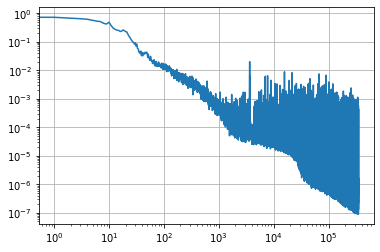

In [181]:
plt.plot(results)
plt.xscale('log')
plt.yscale('log')
plt.grid()

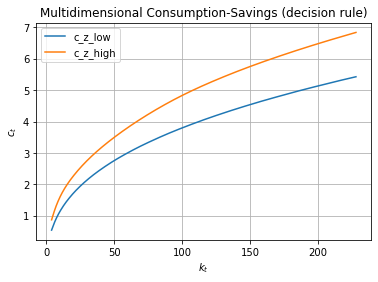

In [182]:
kvec = np.linspace(kmin,kmax,1000)

invst_l, c_l, h_l = dr_l(kvec)
invst_h, c_h, h_h = dr_h(kvec)
#cvec = (cnorm_l)

plt.title("Multidimensional Consumption-Savings (decision rule)")
plt.plot(kvec, c_l)
plt.plot(kvec,c_h)
plt.xlabel("$k_t$")
plt.ylabel("$c_t$")
plt.legend(['c_z_low','c_z_high'])
plt.grid()


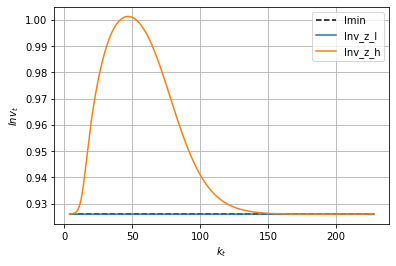

In [183]:
Inv_h = invst_h + imin
Inv_l = invst_l + imin
plt.plot(kvec,kvec*0 + imin, linestyle='--', color='black')
plt.plot(kvec, Inv_l)
plt.plot(kvec, Inv_h)
plt.xlabel("$k_t$")
plt.ylabel("$Inv_t$")
plt.legend(['Imin','Inv_z_l','Inv_z_h'])
plt.grid()
